In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip -u "/content/drive/MyDrive/archive.zip" -d "/content"

In [87]:
n = 'COVID-19_Radiography_Dataset/Normal/images'
d = '/content/drive/MyDrive/Image2/Normal'

In [102]:
import os
import random
import shutil


files_list = []

for root, dirs, files in os.walk(n):
    for file in files:
        #all 
        if file.endswith(".jpg") or file.endswith(".png") or file.endswith(".jpeg"):
            files_list.append(os.path.join(root, file))


#print images
#lets me count and print the amount of jpeg,jpg,pmg 
file_count = len(files_list)
#print file_count

# print files_list   
filesToCopy = random.sample(files_list, 4000)  #prints two random files from list 

destPath = d

# if destination dir does not exists, create it
if os.path.isdir(destPath) == False:
        os.makedirs(destPath)

# iteraate over all random files and move them
for file in filesToCopy:
    shutil.move(file, destPath)

In [104]:
c = 'COVID-19_Radiography_Dataset/COVID/images'
dd = '/content/drive/MyDrive/Image2/COVID'

In [105]:
import os
import random
import shutil


files_list = []

for root, dirs, files in os.walk(c):
    for file in files:
        #all 
        if file.endswith(".jpg") or file.endswith(".png") or file.endswith(".jpeg"):
            files_list.append(os.path.join(root, file))


#print images
#lets me count and print the amount of jpeg,jpg,pmg 
file_count = len(files_list)
#print file_count

# print files_list   
#filesToCopy = random.sample(files_list, 4000)  #prints two random files from list 

destPath = dd

# if destination dir does not exists, create it
if os.path.isdir(destPath) == False:
        os.makedirs(destPath)

# iteraate over all random files and move them
for file in files_list:
    shutil.move(file, destPath)

In [13]:
#pip install split-folders

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [106]:
# split dataset into train, val, test in 0.8, 0.1, 0.1 ratio
import splitfolders
splitfolders.ratio("/content/drive/MyDrive/Image2", output="/content/drive/MyDrive/split2", seed=42, ratio=(.8, 0.1,0.1)) 

Copying files: 7616 files [01:03, 119.12 files/s]


In [2]:
from __future__ import print_function
import argparse
import datetime
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import HTML
from IPython.display import clear_output
from tqdm import tqdm

import torch
import torch.nn as nn
import torch.nn.parallel
import torch.nn.functional as F
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as datasets
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torchvision.utils import save_image
from torch.autograd import Variable
from torch.utils.data import SubsetRandomSampler

In [ ]:
# class netG(nn.Module):

#     def __init__(self, nz, ngf, nc):

#         super(netG, self).__init__()
#         self.ReLU = nn.ReLU(True)
#         self.Tanh = nn.Tanh()
#         self.DropOut = nn.Dropout(p=0.75)
#         #self.conv0 = nn.ConvTranspose2d(nz, ngf * 16, 4, 1, 1, bias=False)
#         #self.BatchNorm0 = nn.BatchNorm2d(ngf * 16)
#         self.conv1 = nn.ConvTranspose2d(nz, ngf * 8, 5, 1, 0, bias=False)
#         self.BatchNorm1 = nn.BatchNorm2d(ngf * 8)

#         self.conv2 = nn.ConvTranspose2d(ngf * 8, ngf * 4, 5, 2, 2, bias=False)
#         self.BatchNorm2 = nn.BatchNorm2d(ngf * 4)

#         self.conv3 = nn.ConvTranspose2d(ngf * 4, ngf * 2, 5, 2, 2, bias=False)
#         self.BatchNorm3 = nn.BatchNorm2d(ngf * 2)

#         self.conv4 = nn.ConvTranspose2d(ngf * 2, ngf * 1, 4, 2, 2, bias=False)
#         self.BatchNorm4 = nn.BatchNorm2d(ngf * 1)

#         self.conv5 = nn.ConvTranspose2d(ngf * 1, nc, 4, 2, 1, bias=False)

#         self.apply(weights_init)


#     def forward(self, input):
#         #x = self.conv0(input)
#         #x = self.BatchNorm0(x)
#         #x = self.ReLU(x)
#         x = self.conv1(input)
#         x = self.BatchNorm1(x)
#         x = self.ReLU(x)
#         #x = self.DropOut(x)

#         x = self.conv2(x)
#         x = self.BatchNorm2(x)
#         x = self.ReLU(x)
#         x = self.DropOut(x)

#         x = self.conv3(x)
#         x = self.BatchNorm3(x)
#         x = self.ReLU(x)
#         #x = self.DropOut(x)

#         x = self.conv4(x)
#         x = self.BatchNorm4(x)
#         x = self.ReLU(x)
#         #x = self.DropOut(x)

#         x = self.conv5(x)
#         output = self.Tanh(x)
#         return output

In [3]:
class netG(nn.Module):

    def __init__(self, nz, ngf, nc):

        super(netG, self).__init__()
        self.ReLU = nn.ReLU(True)
        self.Tanh = nn.Tanh()
        #self.DropOut = nn.Dropout(p=0.75)
        #self.conv0 = nn.ConvTranspose2d(nz, ngf * 16, 4, 1, 1, bias=False)
        #self.BatchNorm0 = nn.BatchNorm2d(ngf * 16)
        self.conv1 = nn.ConvTranspose2d(nz, ngf * 8, 4, 1, 0, bias=False)
        self.BatchNorm1 = nn.BatchNorm2d(ngf * 8)

        self.conv2 = nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False)
        self.BatchNorm2 = nn.BatchNorm2d(ngf * 4)

        self.conv3 = nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False)
        self.BatchNorm3 = nn.BatchNorm2d(ngf * 2)

        self.conv4 = nn.ConvTranspose2d(ngf * 2, ngf * 1, 4, 2, 1, bias=False)
        self.BatchNorm4 = nn.BatchNorm2d(ngf * 1)

        self.conv5 = nn.ConvTranspose2d(ngf * 1, nc, 4, 2, 1, bias=False)

        self.apply(weights_init)


    def forward(self, input):
        #x = self.conv0(input)
        #x = self.BatchNorm0(x)
        #x = self.ReLU(x)
        x = self.conv1(input)
        x = self.BatchNorm1(x)
        x = self.ReLU(x)
        #x = self.DropOut(x)

        x = self.conv2(x)
        x = self.BatchNorm2(x)
        x = self.ReLU(x)
        #x = self.DropOut(x)

        x = self.conv3(x)
        x = self.BatchNorm3(x)
        x = self.ReLU(x)
        #x = self.DropOut(x)

        x = self.conv4(x)
        x = self.BatchNorm4(x)
        x = self.ReLU(x)
        #x = self.DropOut(x)

        x = self.conv5(x)
        output = self.Tanh(x)
        return output

In [4]:
class netD(nn.Module):

    def __init__(self, ndf, nc, nb_label):

        super(netD, self).__init__()
        self.LeakyReLU = nn.LeakyReLU(0.2, inplace=True)
        self.DropOut1 = nn.Dropout(p=0.5)
        self.DropOut2 = nn.Dropout(p=0.25)
        self.conv1 = nn.Conv2d(nc, ndf, 4, 2, 1, bias=False)
        self.conv2 = nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False)
        self.BatchNorm2 = nn.BatchNorm2d(ndf * 2)
        self.conv3 = nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False)
        self.BatchNorm3 = nn.BatchNorm2d(ndf * 4)
        self.conv4 = nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False)
        self.BatchNorm4 = nn.BatchNorm2d(ndf * 8)
        self.conv5 = nn.Conv2d(ndf * 8, ndf * 1, 4, 1, 0, bias=False)
        self.disc_linear = nn.Linear(ndf * 1, 1)
        self.aux_linear = nn.Linear(ndf * 1, nb_label)
        self.softmax = nn.Softmax()
        self.sigmoid = nn.Sigmoid()
        self.ndf = ndf
        self.apply(weights_init)

    def forward(self, input):

        x = self.conv1(input)
        x = self.LeakyReLU(x)
        x = self.DropOut1(x)

        x = self.conv2(x)
        x = self.BatchNorm2(x)
        x = self.LeakyReLU(x)
        #x = self.DropOut(x)

        x = self.conv3(x)
        x = self.BatchNorm3(x)
        x = self.LeakyReLU(x)
        x = self.DropOut1(x)

        x = self.conv4(x)
        x = self.BatchNorm4(x)
        x = self.LeakyReLU(x)
        x = self.DropOut2(x)

        x = self.conv5(x)
        x = x.view(-1, self.ndf * 1)
        c = self.aux_linear(x)
        c = self.softmax(c)
        s = self.disc_linear(x)
        s = self.sigmoid(s)
        return s,c

In [5]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

In [23]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
#data_dir = '4/3AHDbc50wauQLH_Uxb1lOAm9fH5_nZ8o_gvOQGzGEebKG_8SK7yvan4div2k' #Just to check
data_dir = '/content/drive/MyDrive/split2'
batch_size = 32
# Number of training epochs
num_epochs = 200

#All images will be resized to this size using a transformer.
#image_size = 64
imageSize = 64

# Number of channels in the training images. For color images this is 3
nc = 1

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# No of labels
nb_label = 4

# Learning rate for optimizers
lr = 0.002
lr_d = 0.0002
# Beta1 hyperparam for Adam optimizers
beta1 = 0.5
# Beta2 hyperparam for Adam optimizers
beta2 = 0.999

real_label = 1.
fake_label = 0.
# Input to generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device) #batch of 64
# Define Loss function
s_criterion = nn.BCELoss().to(device) #For synthesizing
c_criterion = nn.NLLLoss().to(device) #For classification

input = torch.FloatTensor(batch_size, 3, imageSize, imageSize).to(device)
noise = torch.FloatTensor(batch_size, nz, 1, 1).to(device)
fixed_noise = torch.FloatTensor(batch_size, nz, 1, 1).normal_(0, 1).to(device)
s_label = torch.FloatTensor(batch_size).to(device)
c_label = torch.LongTensor(batch_size).to(device)

input = Variable(input)
s_label = Variable(s_label)
c_label = Variable(c_label)
noise = Variable(noise)
fixed_noise = Variable(fixed_noise)
fixed_noise_ = np.random.normal(0, 1, (batch_size, nz))
random_label = np.random.randint(0, nb_label, batch_size)
#print('fixed label:{}'.format(random_label))
random_onehot = np.zeros((batch_size, nb_label))
random_onehot[np.arange(batch_size), random_label] = 1
fixed_noise_[np.arange(batch_size), :nb_label] = random_onehot[np.arange(batch_size)]


fixed_noise_ = (torch.from_numpy(fixed_noise_))
fixed_noise_ = fixed_noise_.resize_(batch_size, nz, 1, 1)
fixed_noise.data.copy_(fixed_noise_)

tensor([[[[ 0.0000]],

         [[ 1.0000]],

         [[ 0.0000]],

         ...,

         [[-0.1534]],

         [[ 1.2630]],

         [[-0.5619]]],


        [[[ 0.0000]],

         [[ 0.0000]],

         [[ 0.0000]],

         ...,

         [[-0.9438]],

         [[ 0.3169]],

         [[-0.0131]]],


        [[[ 0.0000]],

         [[ 0.0000]],

         [[ 1.0000]],

         ...,

         [[-0.3313]],

         [[ 0.7561]],

         [[-0.8976]]],


        ...,


        [[[ 0.0000]],

         [[ 0.0000]],

         [[ 0.0000]],

         ...,

         [[-1.7442]],

         [[-0.9052]],

         [[ 0.9717]]],


        [[[ 1.0000]],

         [[ 0.0000]],

         [[ 0.0000]],

         ...,

         [[ 1.5748]],

         [[ 1.0421]],

         [[ 1.6714]]],


        [[[ 0.0000]],

         [[ 1.0000]],

         [[ 0.0000]],

         ...,

         [[-1.4841]],

         [[ 1.1577]],

         [[ 1.4754]]]], device='cuda:0')

In [30]:
for func in [
    lambda: os.mkdir(os.path.join('.', '/content/drive/MyDrive/augGAN')),
    lambda: os.mkdir(os.path.join('.', '/content/drive/MyDrive/augGAN/model/ACGAN')),
    lambda: os.mkdir(os.path.join('.', '/content/drive/MyDrive/augGAN/plots/ACGAN')),
    lambda: os.mkdir(os.path.join('.', '/content/drive/MyDrive/augGAN/output_images/ACGAN'))]:  # create directories
  try:
    func()
  except Exception as error:
    print(error)
    continue

METRIC_FIELDS = [
    'train.D_x',
    'train.D_G_z1',
    'train.D_G_z2',
    'train.G_losses',
    'train.D_losses',
]
metrics = {field: list() for field in METRIC_FIELDS}

if nc==1:
    mu = (0.5)
    sigma = (0.5)
    transform = transforms.Compose([#transforms.RandomHorizontalFlip(),
                                    transforms.Grayscale(num_output_channels=1),
                                    transforms.Resize((64,64)),
                                    #transforms.Scale(imageSize),
                                    transforms.ToTensor(),
                                    transforms.Normalize(mu, sigma)])
elif nc==3:
    mu = (0.5,0.5,0.5)
    sigma = (0.5,0.5,0.5)
    #Originally authors used just scaling
    transform = transforms.Compose([#transforms.RandomHorizontalFlip(),
                                    transforms.Resize((64,64)),
                                    #transforms.Scale(imageSize),
                                    transforms.ToTensor(),
                                    transforms.Normalize(mu, sigma)])
else:
    print("Tranformation not defined for this option")
train_set = datasets.ImageFolder(os.path.join(data_dir, "train/"), transform=transform)

train_loader = torch.utils.data.DataLoader(train_set, batch_size=batch_size,
                                          shuffle=True)

generator = netG(nz, ngf, nc).to(device)
discriminator = netD(ndf, nc, nb_label).to(device)

# setup optimizer
optimizerD = optim.Adam(discriminator.parameters(), lr=lr_d, betas=(beta1, beta2))
optimizerG = optim.Adam(generator.parameters(), lr=lr, betas=(beta1, beta2))

[Errno 17] File exists: '/content/drive/MyDrive/augGAN'
[Errno 17] File exists: '/content/drive/MyDrive/augGAN/model/ACGAN'
[Errno 17] File exists: '/content/drive/MyDrive/augGAN/plots/ACGAN'
[Errno 17] File exists: '/content/drive/MyDrive/augGAN/output_images/ACGAN'


In [12]:
print(generator)
print(discriminator)

from torchsummary import summary

summary(generator, (100, 1, 1))
summary(discriminator, (1, 64, 64))

netG(
  (ReLU): ReLU(inplace=True)
  (Tanh): Tanh()
  (conv1): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
  (BatchNorm1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv2): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (BatchNorm2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (BatchNorm3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv4): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (BatchNorm4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv5): ConvTranspose2d(64, 1, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
)
netD(
  (LeakyReLU): LeakyReLU(negative_slope=0.2, inplace=True)
  (DropOut1): 

<ipython-input-4-21ca91c8528a>:48: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  c = self.softmax(c)


In [31]:
def test(predict, labels):
    correct = 0
    pred = predict.data.max(1)[1]
    correct = pred.eq(labels.data).cpu().sum()
    return correct, len(labels.data)

In [32]:
for epoch in range(num_epochs):
    for i, data in enumerate(tqdm(train_loader, 0)):
        ###########################
        # (1) Update D network
        ###########################
        # train with real
        discriminator.zero_grad()
        img, label = data
        batch_size = img.size(0)
        with torch.no_grad():
            input.resize_(img.size()).copy_(img)
            s_label.resize_(batch_size).fill_(real_label)
            c_label.resize_(batch_size).copy_(label)
        s_output, c_output = discriminator(input)
        s_label = s_label.unsqueeze(1)
        s_errD_real = s_criterion(s_output, s_label)
        #c_label = c_label.unsqueeze(1)
        c_errD_real = c_criterion(c_output, c_label)
        errD_real = s_errD_real + c_errD_real
        errD_real.backward()
        D_x = s_output.data.mean()
        
        correct, length = test(c_output, c_label)

        # train with fake
        with torch.no_grad():
            noise.resize_(batch_size, nz, 1, 1)
            noise.normal_(0, 1)

        label = np.random.randint(0, nb_label, batch_size)
        noise_ = np.random.normal(0, 1, (batch_size, nz))
        label_onehot = np.zeros((batch_size, nb_label))
        label_onehot[np.arange(batch_size), label] = 1
        noise_[np.arange(batch_size), :nb_label] = label_onehot[np.arange(batch_size)]
        
        noise_ = (torch.from_numpy(noise_))
        noise_ = noise_.resize_(batch_size, nz, 1, 1)
        noise.data.copy_(noise_)

        c_label.data.resize_(batch_size).copy_(torch.from_numpy(label))

        fake = generator(noise)
        s_label.data.fill_(fake_label)
        s_output,c_output = discriminator(fake.detach())
        s_errD_fake = s_criterion(s_output, s_label)
        c_errD_fake = c_criterion(c_output, c_label)
        errD_fake = s_errD_fake + c_errD_fake

        errD_fake.backward()
        D_G_z1 = s_output.data.mean()
        errD = s_errD_real + s_errD_fake
        optimizerD.step()

        ###########################
        # (2) Update G network
        ###########################
        generator.zero_grad()
        s_label.data.fill_(real_label)  # fake labels are real for generator cost
        s_output,c_output = discriminator(fake)
        s_errG = s_criterion(s_output, s_label)
        c_errG = c_criterion(c_output, c_label)
        
        errG = s_errG + c_errG
        errG.backward()
        D_G_z2 = s_output.data.mean()
        optimizerG.step()
        metrics['train.G_losses'].append(errG.item())
        metrics['train.D_losses'].append(errD.item())

        print('[%d/%d][%d/%d] Loss_D: %.4f Loss_G: %.4f D(x): %.4f D(G(z)): %.4f / %.4f, Accuracy: %.4f / %.4f = %.4f'
              % (epoch, num_epochs, i, len(train_loader),
                 errD.data, errG.data, D_x, D_G_z1, D_G_z2,
                 correct, length, 100.* correct / length))
        if i % 100 == 0:
            vutils.save_image(img,
                    '%s/real_samples.png' % '/content/drive/MyDrive/augGAN/output_images/ACGAN', normalize=True)
            #fake = netG(fixed_cat)
            fake = generator(fixed_noise)
            vutils.save_image(fake.data,
                    '%s/fake_samples_epoch_%03d.png' % ('/content/drive/MyDrive/augGAN/output_images/ACGAN', epoch), normalize=True)

    # do checkpointing
    #torch.save(generator.state_dict(), '%s/netG_epoch_%d.pth' % (os.path.join('.', 'augGAN/model/ACGAN'), epoch))
    #torch.save(discriminator.state_dict(), '%s/netD_epoch_%d.pth' % (os.path.join('.', 'augGAN/model/ACGAN'), epoch))

  0%|          | 0/191 [00:00<?, ?it/s]<ipython-input-4-21ca91c8528a>:48: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  c = self.softmax(c)
  1%|          | 1/191 [00:00<00:57,  3.30it/s]

[0/200][0/191] Loss_D: 1.7305 Loss_G: 0.6840 D(x): 0.4280 D(G(z)): 0.4879 / 0.4190, Accuracy: 7.0000 / 32.0000 = 21.8750


  2%|▏         | 3/191 [00:00<00:40,  4.67it/s]

[0/200][1/191] Loss_D: 1.2420 Loss_G: 1.6799 D(x): 0.7924 D(G(z)): 0.6037 / 0.1740, Accuracy: 17.0000 / 32.0000 = 53.1250
[0/200][2/191] Loss_D: 0.8809 Loss_G: 2.0553 D(x): 0.7130 D(G(z)): 0.3710 / 0.1187, Accuracy: 15.0000 / 32.0000 = 46.8750


  3%|▎         | 5/191 [00:01<00:36,  5.07it/s]

[0/200][3/191] Loss_D: 0.8061 Loss_G: 1.9471 D(x): 0.6929 D(G(z)): 0.2857 / 0.1421, Accuracy: 8.0000 / 32.0000 = 25.0000
[0/200][4/191] Loss_D: 1.0512 Loss_G: 2.5955 D(x): 0.8151 D(G(z)): 0.5066 / 0.0770, Accuracy: 18.0000 / 32.0000 = 56.2500


  4%|▎         | 7/191 [00:01<00:33,  5.42it/s]

[0/200][5/191] Loss_D: 0.8901 Loss_G: 2.7229 D(x): 0.7123 D(G(z)): 0.3234 / 0.0622, Accuracy: 22.0000 / 32.0000 = 68.7500
[0/200][6/191] Loss_D: 1.0222 Loss_G: 2.6962 D(x): 0.6373 D(G(z)): 0.3479 / 0.0728, Accuracy: 19.0000 / 32.0000 = 59.3750


  5%|▍         | 9/191 [00:01<00:32,  5.63it/s]

[0/200][7/191] Loss_D: 0.9626 Loss_G: 2.3696 D(x): 0.6633 D(G(z)): 0.2910 / 0.0900, Accuracy: 20.0000 / 32.0000 = 62.5000
[0/200][8/191] Loss_D: 0.6850 Loss_G: 2.2076 D(x): 0.7220 D(G(z)): 0.2100 / 0.1064, Accuracy: 15.0000 / 32.0000 = 46.8750


  6%|▌         | 11/191 [00:02<00:32,  5.58it/s]

[0/200][9/191] Loss_D: 1.0810 Loss_G: 2.7283 D(x): 0.7130 D(G(z)): 0.3239 / 0.0818, Accuracy: 18.0000 / 32.0000 = 56.2500
[0/200][10/191] Loss_D: 1.1056 Loss_G: 2.9861 D(x): 0.7163 D(G(z)): 0.4013 / 0.0738, Accuracy: 15.0000 / 32.0000 = 46.8750


  7%|▋         | 13/191 [00:02<00:30,  5.77it/s]

[0/200][11/191] Loss_D: 1.4823 Loss_G: 3.0146 D(x): 0.6416 D(G(z)): 0.4831 / 0.0708, Accuracy: 17.0000 / 32.0000 = 53.1250
[0/200][12/191] Loss_D: 1.4993 Loss_G: 3.4024 D(x): 0.5902 D(G(z)): 0.4415 / 0.0536, Accuracy: 22.0000 / 32.0000 = 68.7500


  8%|▊         | 15/191 [00:02<00:28,  6.16it/s]

[0/200][13/191] Loss_D: 1.8778 Loss_G: 1.6047 D(x): 0.4188 D(G(z)): 0.2481 / 0.2457, Accuracy: 17.0000 / 32.0000 = 53.1250
[0/200][14/191] Loss_D: 2.2852 Loss_G: 2.6513 D(x): 0.7492 D(G(z)): 0.7511 / 0.0779, Accuracy: 17.0000 / 32.0000 = 53.1250


  9%|▉         | 17/191 [00:03<00:27,  6.31it/s]

[0/200][15/191] Loss_D: 1.6481 Loss_G: 3.3057 D(x): 0.5555 D(G(z)): 0.4466 / 0.0553, Accuracy: 19.0000 / 32.0000 = 59.3750
[0/200][16/191] Loss_D: 2.2424 Loss_G: 1.8051 D(x): 0.3691 D(G(z)): 0.2439 / 0.1821, Accuracy: 21.0000 / 32.0000 = 65.6250


 10%|▉         | 19/191 [00:03<00:26,  6.37it/s]

[0/200][17/191] Loss_D: 1.9913 Loss_G: 1.1943 D(x): 0.4111 D(G(z)): 0.4819 / 0.2708, Accuracy: 17.0000 / 32.0000 = 53.1250
[0/200][18/191] Loss_D: 1.6704 Loss_G: 2.5032 D(x): 0.6268 D(G(z)): 0.6089 / 0.0753, Accuracy: 21.0000 / 32.0000 = 65.6250


 11%|█         | 21/191 [00:03<00:26,  6.46it/s]

[0/200][19/191] Loss_D: 2.1979 Loss_G: 2.0899 D(x): 0.4450 D(G(z)): 0.5501 / 0.1404, Accuracy: 22.0000 / 32.0000 = 68.7500
[0/200][20/191] Loss_D: 2.2522 Loss_G: 1.4614 D(x): 0.3826 D(G(z)): 0.4940 / 0.1996, Accuracy: 22.0000 / 32.0000 = 68.7500


 12%|█▏        | 23/191 [00:03<00:25,  6.51it/s]

[0/200][21/191] Loss_D: 2.3437 Loss_G: 2.0165 D(x): 0.3942 D(G(z)): 0.6097 / 0.1517, Accuracy: 22.0000 / 32.0000 = 68.7500
[0/200][22/191] Loss_D: 2.6909 Loss_G: 1.6469 D(x): 0.3751 D(G(z)): 0.6095 / 0.2099, Accuracy: 22.0000 / 32.0000 = 68.7500


 13%|█▎        | 25/191 [00:04<00:24,  6.72it/s]

[0/200][23/191] Loss_D: 2.2646 Loss_G: 2.0364 D(x): 0.4102 D(G(z)): 0.6322 / 0.1298, Accuracy: 26.0000 / 32.0000 = 81.2500
[0/200][24/191] Loss_D: 2.3936 Loss_G: 1.0130 D(x): 0.2702 D(G(z)): 0.4420 / 0.3438, Accuracy: 23.0000 / 32.0000 = 71.8750


 14%|█▍        | 27/191 [00:04<00:23,  6.89it/s]

[0/200][25/191] Loss_D: 2.2879 Loss_G: 1.4081 D(x): 0.4550 D(G(z)): 0.6513 / 0.2581, Accuracy: 23.0000 / 32.0000 = 71.8750
[0/200][26/191] Loss_D: 2.3639 Loss_G: 1.9229 D(x): 0.4092 D(G(z)): 0.6178 / 0.1552, Accuracy: 17.0000 / 32.0000 = 53.1250


 15%|█▌        | 29/191 [00:04<00:23,  6.92it/s]

[0/200][27/191] Loss_D: 2.2016 Loss_G: 1.5561 D(x): 0.3549 D(G(z)): 0.5012 / 0.2165, Accuracy: 20.0000 / 32.0000 = 62.5000
[0/200][28/191] Loss_D: 2.4324 Loss_G: 1.1007 D(x): 0.3267 D(G(z)): 0.5708 / 0.2996, Accuracy: 17.0000 / 32.0000 = 53.1250


 16%|█▌        | 31/191 [00:05<00:22,  6.99it/s]

[0/200][29/191] Loss_D: 2.9344 Loss_G: 1.0326 D(x): 0.3250 D(G(z)): 0.7264 / 0.3054, Accuracy: 27.0000 / 32.0000 = 84.3750
[0/200][30/191] Loss_D: 2.5788 Loss_G: 0.9566 D(x): 0.2853 D(G(z)): 0.6493 / 0.3443, Accuracy: 24.0000 / 32.0000 = 75.0000


 17%|█▋        | 33/191 [00:05<00:22,  6.92it/s]

[0/200][31/191] Loss_D: 2.1896 Loss_G: 0.9138 D(x): 0.3711 D(G(z)): 0.6349 / 0.2774, Accuracy: 20.0000 / 32.0000 = 62.5000
[0/200][32/191] Loss_D: 1.8223 Loss_G: 1.4642 D(x): 0.4542 D(G(z)): 0.5691 / 0.2130, Accuracy: 24.0000 / 32.0000 = 75.0000


 18%|█▊        | 35/191 [00:05<00:22,  6.98it/s]

[0/200][33/191] Loss_D: 1.6507 Loss_G: 1.5317 D(x): 0.4920 D(G(z)): 0.5280 / 0.2079, Accuracy: 18.0000 / 32.0000 = 56.2500
[0/200][34/191] Loss_D: 2.0132 Loss_G: 1.3639 D(x): 0.4986 D(G(z)): 0.6536 / 0.2471, Accuracy: 26.0000 / 32.0000 = 81.2500


 19%|█▉        | 37/191 [00:05<00:21,  7.14it/s]

[0/200][35/191] Loss_D: 2.9332 Loss_G: 1.1035 D(x): 0.2731 D(G(z)): 0.6793 / 0.2745, Accuracy: 19.0000 / 32.0000 = 59.3750
[0/200][36/191] Loss_D: 2.8763 Loss_G: 1.0404 D(x): 0.2445 D(G(z)): 0.6554 / 0.3154, Accuracy: 17.0000 / 32.0000 = 53.1250


 20%|██        | 39/191 [00:06<00:21,  7.10it/s]

[0/200][37/191] Loss_D: 2.6785 Loss_G: 1.1540 D(x): 0.4120 D(G(z)): 0.7111 / 0.2469, Accuracy: 20.0000 / 32.0000 = 62.5000
[0/200][38/191] Loss_D: 2.0917 Loss_G: 1.9050 D(x): 0.4375 D(G(z)): 0.6343 / 0.1571, Accuracy: 23.0000 / 32.0000 = 71.8750


 21%|██▏       | 41/191 [00:06<00:20,  7.17it/s]

[0/200][39/191] Loss_D: 1.8198 Loss_G: 1.1893 D(x): 0.4167 D(G(z)): 0.5086 / 0.2584, Accuracy: 24.0000 / 32.0000 = 75.0000
[0/200][40/191] Loss_D: 1.8830 Loss_G: 1.4627 D(x): 0.5403 D(G(z)): 0.6301 / 0.1929, Accuracy: 21.0000 / 32.0000 = 65.6250


 23%|██▎       | 43/191 [00:06<00:20,  7.10it/s]

[0/200][41/191] Loss_D: 2.3103 Loss_G: 0.8529 D(x): 0.3525 D(G(z)): 0.5983 / 0.3628, Accuracy: 22.0000 / 32.0000 = 68.7500
[0/200][42/191] Loss_D: 2.8504 Loss_G: 0.9951 D(x): 0.2868 D(G(z)): 0.6846 / 0.3311, Accuracy: 23.0000 / 32.0000 = 71.8750


 24%|██▎       | 45/191 [00:07<00:20,  7.09it/s]

[0/200][43/191] Loss_D: 2.4570 Loss_G: 1.1386 D(x): 0.3094 D(G(z)): 0.5954 / 0.2790, Accuracy: 19.0000 / 32.0000 = 59.3750
[0/200][44/191] Loss_D: 2.1551 Loss_G: 0.7639 D(x): 0.3142 D(G(z)): 0.5360 / 0.3592, Accuracy: 19.0000 / 32.0000 = 59.3750


 25%|██▍       | 47/191 [00:07<00:20,  7.14it/s]

[0/200][45/191] Loss_D: 2.1897 Loss_G: 1.2496 D(x): 0.4421 D(G(z)): 0.6405 / 0.2282, Accuracy: 22.0000 / 32.0000 = 68.7500
[0/200][46/191] Loss_D: 2.1744 Loss_G: 1.0377 D(x): 0.3573 D(G(z)): 0.5742 / 0.3045, Accuracy: 21.0000 / 32.0000 = 65.6250


 26%|██▌       | 49/191 [00:07<00:20,  7.02it/s]

[0/200][47/191] Loss_D: 2.5060 Loss_G: 0.9715 D(x): 0.3169 D(G(z)): 0.5734 / 0.3469, Accuracy: 24.0000 / 32.0000 = 75.0000
[0/200][48/191] Loss_D: 2.2015 Loss_G: 1.2432 D(x): 0.4438 D(G(z)): 0.6386 / 0.2718, Accuracy: 21.0000 / 32.0000 = 65.6250


 27%|██▋       | 51/191 [00:07<00:19,  7.02it/s]

[0/200][49/191] Loss_D: 2.0917 Loss_G: 0.9040 D(x): 0.2953 D(G(z)): 0.5017 / 0.3130, Accuracy: 25.0000 / 32.0000 = 78.1250
[0/200][50/191] Loss_D: 2.1051 Loss_G: 0.9237 D(x): 0.3577 D(G(z)): 0.5708 / 0.3278, Accuracy: 23.0000 / 32.0000 = 71.8750


 28%|██▊       | 53/191 [00:08<00:19,  6.92it/s]

[0/200][51/191] Loss_D: 1.7264 Loss_G: 0.8957 D(x): 0.4353 D(G(z)): 0.5210 / 0.3030, Accuracy: 20.0000 / 32.0000 = 62.5000
[0/200][52/191] Loss_D: 1.4908 Loss_G: 1.5256 D(x): 0.6091 D(G(z)): 0.5929 / 0.1887, Accuracy: 20.0000 / 32.0000 = 62.5000


 29%|██▉       | 55/191 [00:08<00:19,  7.06it/s]

[0/200][53/191] Loss_D: 1.6401 Loss_G: 1.0096 D(x): 0.3999 D(G(z)): 0.3517 / 0.3352, Accuracy: 24.0000 / 32.0000 = 75.0000
[0/200][54/191] Loss_D: 1.7065 Loss_G: 1.0301 D(x): 0.5591 D(G(z)): 0.5792 / 0.3107, Accuracy: 22.0000 / 32.0000 = 68.7500


 30%|██▉       | 57/191 [00:08<00:18,  7.06it/s]

[0/200][55/191] Loss_D: 2.0413 Loss_G: 1.3148 D(x): 0.5056 D(G(z)): 0.6531 / 0.2297, Accuracy: 22.0000 / 32.0000 = 68.7500
[0/200][56/191] Loss_D: 2.1567 Loss_G: 1.5613 D(x): 0.3803 D(G(z)): 0.6130 / 0.1981, Accuracy: 17.0000 / 32.0000 = 53.1250


 31%|███       | 59/191 [00:09<00:18,  7.07it/s]

[0/200][57/191] Loss_D: 2.5144 Loss_G: 1.5245 D(x): 0.3246 D(G(z)): 0.6815 / 0.1973, Accuracy: 25.0000 / 32.0000 = 78.1250
[0/200][58/191] Loss_D: 2.8707 Loss_G: 1.8180 D(x): 0.3047 D(G(z)): 0.7475 / 0.1370, Accuracy: 25.0000 / 32.0000 = 78.1250


 32%|███▏      | 61/191 [00:09<00:18,  7.09it/s]

[0/200][59/191] Loss_D: 2.0116 Loss_G: 1.3847 D(x): 0.3339 D(G(z)): 0.4984 / 0.2203, Accuracy: 20.0000 / 32.0000 = 62.5000
[0/200][60/191] Loss_D: 1.5886 Loss_G: 1.1043 D(x): 0.5498 D(G(z)): 0.5557 / 0.2726, Accuracy: 22.0000 / 32.0000 = 68.7500


 33%|███▎      | 63/191 [00:09<00:18,  7.06it/s]

[0/200][61/191] Loss_D: 1.9031 Loss_G: 1.2778 D(x): 0.5816 D(G(z)): 0.6806 / 0.2405, Accuracy: 20.0000 / 32.0000 = 62.5000
[0/200][62/191] Loss_D: 1.8750 Loss_G: 1.2335 D(x): 0.4116 D(G(z)): 0.5055 / 0.2311, Accuracy: 24.0000 / 32.0000 = 75.0000


 34%|███▍      | 65/191 [00:09<00:17,  7.06it/s]

[0/200][63/191] Loss_D: 2.2396 Loss_G: 0.7348 D(x): 0.3218 D(G(z)): 0.5505 / 0.4031, Accuracy: 24.0000 / 32.0000 = 75.0000
[0/200][64/191] Loss_D: 2.2462 Loss_G: 0.9731 D(x): 0.4415 D(G(z)): 0.6878 / 0.3187, Accuracy: 21.0000 / 32.0000 = 65.6250


 35%|███▌      | 67/191 [00:10<00:17,  6.98it/s]

[0/200][65/191] Loss_D: 1.8614 Loss_G: 0.6159 D(x): 0.3536 D(G(z)): 0.4771 / 0.3585, Accuracy: 20.0000 / 32.0000 = 62.5000
[0/200][66/191] Loss_D: 1.9883 Loss_G: 0.2824 D(x): 0.3613 D(G(z)): 0.5256 / 0.4928, Accuracy: 22.0000 / 32.0000 = 68.7500


 36%|███▌      | 69/191 [00:10<00:17,  6.88it/s]

[0/200][67/191] Loss_D: 1.7884 Loss_G: 0.6604 D(x): 0.4954 D(G(z)): 0.6149 / 0.3785, Accuracy: 21.0000 / 32.0000 = 65.6250
[0/200][68/191] Loss_D: 1.7351 Loss_G: 1.0400 D(x): 0.4743 D(G(z)): 0.5389 / 0.2573, Accuracy: 27.0000 / 32.0000 = 84.3750


 37%|███▋      | 71/191 [00:10<00:17,  6.99it/s]

[0/200][69/191] Loss_D: 1.5807 Loss_G: 0.8609 D(x): 0.4038 D(G(z)): 0.4222 / 0.3607, Accuracy: 24.0000 / 32.0000 = 75.0000
[0/200][70/191] Loss_D: 1.9142 Loss_G: 0.9138 D(x): 0.4624 D(G(z)): 0.6028 / 0.2691, Accuracy: 22.0000 / 32.0000 = 68.7500


 38%|███▊      | 73/191 [00:11<00:16,  7.07it/s]

[0/200][71/191] Loss_D: 1.9884 Loss_G: 0.6971 D(x): 0.3128 D(G(z)): 0.4577 / 0.3787, Accuracy: 24.0000 / 32.0000 = 75.0000
[0/200][72/191] Loss_D: 1.6341 Loss_G: 0.6811 D(x): 0.4956 D(G(z)): 0.5549 / 0.3609, Accuracy: 19.0000 / 32.0000 = 59.3750


 39%|███▉      | 75/191 [00:11<00:16,  6.94it/s]

[0/200][73/191] Loss_D: 1.7932 Loss_G: 0.5544 D(x): 0.3823 D(G(z)): 0.4757 / 0.4489, Accuracy: 22.0000 / 32.0000 = 68.7500
[0/200][74/191] Loss_D: 1.7966 Loss_G: 1.0750 D(x): 0.5360 D(G(z)): 0.6347 / 0.2501, Accuracy: 24.0000 / 32.0000 = 75.0000


 40%|████      | 77/191 [00:11<00:16,  6.84it/s]

[0/200][75/191] Loss_D: 1.7115 Loss_G: 0.6008 D(x): 0.3602 D(G(z)): 0.3870 / 0.3824, Accuracy: 17.0000 / 32.0000 = 53.1250
[0/200][76/191] Loss_D: 1.7717 Loss_G: 0.6414 D(x): 0.4384 D(G(z)): 0.5522 / 0.3495, Accuracy: 25.0000 / 32.0000 = 78.1250


 41%|████▏     | 79/191 [00:11<00:16,  6.87it/s]

[0/200][77/191] Loss_D: 1.8385 Loss_G: 0.9021 D(x): 0.5001 D(G(z)): 0.6188 / 0.2782, Accuracy: 25.0000 / 32.0000 = 78.1250
[0/200][78/191] Loss_D: 1.8429 Loss_G: 1.2070 D(x): 0.4847 D(G(z)): 0.5662 / 0.2507, Accuracy: 23.0000 / 32.0000 = 71.8750


 42%|████▏     | 81/191 [00:12<00:16,  6.78it/s]

[0/200][79/191] Loss_D: 2.1965 Loss_G: 0.9233 D(x): 0.3545 D(G(z)): 0.5790 / 0.3279, Accuracy: 20.0000 / 32.0000 = 62.5000
[0/200][80/191] Loss_D: 2.3253 Loss_G: 0.6002 D(x): 0.3330 D(G(z)): 0.6318 / 0.3812, Accuracy: 29.0000 / 32.0000 = 90.6250


 43%|████▎     | 83/191 [00:12<00:16,  6.56it/s]

[0/200][81/191] Loss_D: 1.9616 Loss_G: 1.2318 D(x): 0.4680 D(G(z)): 0.6467 / 0.2089, Accuracy: 24.0000 / 32.0000 = 75.0000
[0/200][82/191] Loss_D: 1.1701 Loss_G: 1.4855 D(x): 0.5845 D(G(z)): 0.4205 / 0.1803, Accuracy: 25.0000 / 32.0000 = 78.1250


 45%|████▍     | 85/191 [00:12<00:16,  6.56it/s]

[0/200][83/191] Loss_D: 1.1624 Loss_G: 1.2140 D(x): 0.5837 D(G(z)): 0.3860 / 0.2038, Accuracy: 21.0000 / 32.0000 = 65.6250
[0/200][84/191] Loss_D: 1.1978 Loss_G: 0.9671 D(x): 0.6169 D(G(z)): 0.4102 / 0.3322, Accuracy: 21.0000 / 32.0000 = 65.6250


 46%|████▌     | 87/191 [00:13<00:16,  6.45it/s]

[0/200][85/191] Loss_D: 1.5090 Loss_G: 1.0884 D(x): 0.7412 D(G(z)): 0.6007 / 0.2855, Accuracy: 24.0000 / 32.0000 = 75.0000
[0/200][86/191] Loss_D: 1.7077 Loss_G: 1.0261 D(x): 0.4677 D(G(z)): 0.4735 / 0.2865, Accuracy: 24.0000 / 32.0000 = 75.0000


 47%|████▋     | 89/191 [00:13<00:16,  6.27it/s]

[0/200][87/191] Loss_D: 1.8815 Loss_G: 0.8945 D(x): 0.4806 D(G(z)): 0.5801 / 0.3451, Accuracy: 23.0000 / 32.0000 = 71.8750
[0/200][88/191] Loss_D: 2.0493 Loss_G: 1.0268 D(x): 0.4677 D(G(z)): 0.6183 / 0.2772, Accuracy: 24.0000 / 32.0000 = 75.0000


 48%|████▊     | 91/191 [00:13<00:16,  6.11it/s]

[0/200][89/191] Loss_D: 2.3453 Loss_G: 0.2486 D(x): 0.2578 D(G(z)): 0.4843 / 0.5263, Accuracy: 24.0000 / 32.0000 = 75.0000
[0/200][90/191] Loss_D: 1.9809 Loss_G: 0.8950 D(x): 0.5028 D(G(z)): 0.6649 / 0.2991, Accuracy: 22.0000 / 32.0000 = 68.7500


 49%|████▊     | 93/191 [00:14<00:16,  5.96it/s]

[0/200][91/191] Loss_D: 1.7978 Loss_G: 1.1631 D(x): 0.4744 D(G(z)): 0.5605 / 0.2566, Accuracy: 16.0000 / 32.0000 = 50.0000
[0/200][92/191] Loss_D: 1.5819 Loss_G: 0.8021 D(x): 0.4869 D(G(z)): 0.4868 / 0.3349, Accuracy: 24.0000 / 32.0000 = 75.0000


 50%|████▉     | 95/191 [00:14<00:16,  5.91it/s]

[0/200][93/191] Loss_D: 1.8839 Loss_G: 1.1095 D(x): 0.4374 D(G(z)): 0.5540 / 0.2380, Accuracy: 19.0000 / 32.0000 = 59.3750
[0/200][94/191] Loss_D: 1.7390 Loss_G: 0.5654 D(x): 0.4112 D(G(z)): 0.4502 / 0.3638, Accuracy: 21.0000 / 32.0000 = 65.6250


 51%|█████     | 97/191 [00:14<00:16,  5.72it/s]

[0/200][95/191] Loss_D: 1.9947 Loss_G: 0.7498 D(x): 0.4731 D(G(z)): 0.6443 / 0.3142, Accuracy: 22.0000 / 32.0000 = 68.7500
[0/200][96/191] Loss_D: 1.9676 Loss_G: 0.7532 D(x): 0.4466 D(G(z)): 0.5568 / 0.2902, Accuracy: 26.0000 / 32.0000 = 81.2500


 52%|█████▏    | 99/191 [00:15<00:15,  5.90it/s]

[0/200][97/191] Loss_D: 1.6826 Loss_G: 0.6895 D(x): 0.4139 D(G(z)): 0.4725 / 0.3175, Accuracy: 24.0000 / 32.0000 = 75.0000
[0/200][98/191] Loss_D: 1.9148 Loss_G: 0.5212 D(x): 0.4267 D(G(z)): 0.5745 / 0.3871, Accuracy: 19.0000 / 32.0000 = 59.3750


 52%|█████▏    | 100/191 [00:15<00:15,  6.00it/s]

[0/200][99/191] Loss_D: 1.8829 Loss_G: 0.7074 D(x): 0.4261 D(G(z)): 0.5776 / 0.3084, Accuracy: 25.0000 / 32.0000 = 78.1250
[0/200][100/191] Loss_D: 1.9871 Loss_G: 0.7632 D(x): 0.3573 D(G(z)): 0.5455 / 0.3737, Accuracy: 22.0000 / 32.0000 = 68.7500


 54%|█████▍    | 103/191 [00:15<00:15,  5.66it/s]

[0/200][101/191] Loss_D: 1.8320 Loss_G: 0.3147 D(x): 0.3790 D(G(z)): 0.4908 / 0.4937, Accuracy: 26.0000 / 32.0000 = 81.2500
[0/200][102/191] Loss_D: 1.7276 Loss_G: 0.7008 D(x): 0.5182 D(G(z)): 0.5900 / 0.3708, Accuracy: 24.0000 / 32.0000 = 75.0000


 55%|█████▍    | 105/191 [00:16<00:14,  6.07it/s]

[0/200][103/191] Loss_D: 1.6772 Loss_G: 0.5744 D(x): 0.4152 D(G(z)): 0.4716 / 0.4020, Accuracy: 21.0000 / 32.0000 = 65.6250
[0/200][104/191] Loss_D: 1.5805 Loss_G: 0.5863 D(x): 0.4836 D(G(z)): 0.5192 / 0.3455, Accuracy: 20.0000 / 32.0000 = 62.5000


 56%|█████▌    | 107/191 [00:16<00:12,  6.48it/s]

[0/200][105/191] Loss_D: 1.4143 Loss_G: 0.8160 D(x): 0.5435 D(G(z)): 0.5137 / 0.3143, Accuracy: 23.0000 / 32.0000 = 71.8750
[0/200][106/191] Loss_D: 1.6115 Loss_G: 0.7284 D(x): 0.4438 D(G(z)): 0.4785 / 0.3640, Accuracy: 20.0000 / 32.0000 = 62.5000


 57%|█████▋    | 109/191 [00:16<00:12,  6.73it/s]

[0/200][107/191] Loss_D: 1.5583 Loss_G: 0.8989 D(x): 0.5273 D(G(z)): 0.5374 / 0.3465, Accuracy: 23.0000 / 32.0000 = 71.8750
[0/200][108/191] Loss_D: 1.6367 Loss_G: 0.7981 D(x): 0.4806 D(G(z)): 0.5327 / 0.3254, Accuracy: 25.0000 / 32.0000 = 78.1250


 58%|█████▊    | 111/191 [00:17<00:11,  6.80it/s]

[0/200][109/191] Loss_D: 1.5864 Loss_G: 0.3375 D(x): 0.4197 D(G(z)): 0.4419 / 0.4214, Accuracy: 23.0000 / 32.0000 = 71.8750
[0/200][110/191] Loss_D: 1.6877 Loss_G: 0.4391 D(x): 0.4942 D(G(z)): 0.5550 / 0.4376, Accuracy: 22.0000 / 32.0000 = 68.7500


 59%|█████▉    | 113/191 [00:17<00:11,  6.86it/s]

[0/200][111/191] Loss_D: 1.5821 Loss_G: 0.7751 D(x): 0.5491 D(G(z)): 0.5805 / 0.3060, Accuracy: 20.0000 / 32.0000 = 62.5000
[0/200][112/191] Loss_D: 1.6929 Loss_G: 0.6194 D(x): 0.3740 D(G(z)): 0.4262 / 0.3757, Accuracy: 25.0000 / 32.0000 = 78.1250


 60%|██████    | 115/191 [00:17<00:10,  6.91it/s]

[0/200][113/191] Loss_D: 1.5219 Loss_G: 0.6797 D(x): 0.5543 D(G(z)): 0.5597 / 0.3758, Accuracy: 23.0000 / 32.0000 = 71.8750
[0/200][114/191] Loss_D: 1.5203 Loss_G: 0.9749 D(x): 0.5559 D(G(z)): 0.5596 / 0.2559, Accuracy: 21.0000 / 32.0000 = 65.6250


 61%|██████▏   | 117/191 [00:18<00:10,  6.98it/s]

[0/200][115/191] Loss_D: 1.6173 Loss_G: 0.9463 D(x): 0.4551 D(G(z)): 0.4897 / 0.2873, Accuracy: 26.0000 / 32.0000 = 81.2500
[0/200][116/191] Loss_D: 1.6635 Loss_G: 0.3579 D(x): 0.3756 D(G(z)): 0.4490 / 0.4570, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:18<00:10,  7.03it/s]

[0/200][117/191] Loss_D: 1.8308 Loss_G: 1.0490 D(x): 0.5583 D(G(z)): 0.6629 / 0.2731, Accuracy: 20.0000 / 32.0000 = 62.5000
[0/200][118/191] Loss_D: 1.6920 Loss_G: 0.7794 D(x): 0.4356 D(G(z)): 0.5036 / 0.3038, Accuracy: 25.0000 / 32.0000 = 78.1250


 63%|██████▎   | 121/191 [00:18<00:09,  7.09it/s]

[0/200][119/191] Loss_D: 1.5589 Loss_G: 1.1516 D(x): 0.4679 D(G(z)): 0.4578 / 0.2440, Accuracy: 18.0000 / 32.0000 = 56.2500
[0/200][120/191] Loss_D: 1.5391 Loss_G: 0.5485 D(x): 0.4844 D(G(z)): 0.4735 / 0.3696, Accuracy: 19.0000 / 32.0000 = 59.3750


 64%|██████▍   | 123/191 [00:18<00:09,  7.08it/s]

[0/200][121/191] Loss_D: 1.6573 Loss_G: 0.6044 D(x): 0.5151 D(G(z)): 0.5803 / 0.3821, Accuracy: 21.0000 / 32.0000 = 65.6250
[0/200][122/191] Loss_D: 1.7448 Loss_G: 0.5690 D(x): 0.4667 D(G(z)): 0.5663 / 0.3563, Accuracy: 21.0000 / 32.0000 = 65.6250


 65%|██████▌   | 125/191 [00:19<00:09,  7.15it/s]

[0/200][123/191] Loss_D: 1.8136 Loss_G: 0.2216 D(x): 0.4300 D(G(z)): 0.5753 / 0.4621, Accuracy: 26.0000 / 32.0000 = 81.2500
[0/200][124/191] Loss_D: 1.6503 Loss_G: 0.4021 D(x): 0.5165 D(G(z)): 0.5873 / 0.4667, Accuracy: 21.0000 / 32.0000 = 65.6250


 66%|██████▋   | 127/191 [00:19<00:08,  7.13it/s]

[0/200][125/191] Loss_D: 1.8406 Loss_G: 0.3094 D(x): 0.4835 D(G(z)): 0.6040 / 0.4445, Accuracy: 25.0000 / 32.0000 = 78.1250
[0/200][126/191] Loss_D: 1.8352 Loss_G: 0.5593 D(x): 0.4399 D(G(z)): 0.5561 / 0.3806, Accuracy: 20.0000 / 32.0000 = 62.5000


 68%|██████▊   | 129/191 [00:19<00:08,  7.09it/s]

[0/200][127/191] Loss_D: 1.7610 Loss_G: 0.5122 D(x): 0.4081 D(G(z)): 0.5163 / 0.4335, Accuracy: 19.0000 / 32.0000 = 59.3750
[0/200][128/191] Loss_D: 1.5684 Loss_G: 0.6629 D(x): 0.5768 D(G(z)): 0.5890 / 0.3335, Accuracy: 21.0000 / 32.0000 = 65.6250


 69%|██████▊   | 131/191 [00:20<00:08,  6.98it/s]

[0/200][129/191] Loss_D: 1.5198 Loss_G: 0.7892 D(x): 0.4563 D(G(z)): 0.4759 / 0.3222, Accuracy: 19.0000 / 32.0000 = 59.3750
[0/200][130/191] Loss_D: 1.6380 Loss_G: 0.8403 D(x): 0.4962 D(G(z)): 0.5588 / 0.3329, Accuracy: 21.0000 / 32.0000 = 65.6250


 70%|██████▉   | 133/191 [00:20<00:08,  6.80it/s]

[0/200][131/191] Loss_D: 1.7812 Loss_G: 0.6433 D(x): 0.4337 D(G(z)): 0.5610 / 0.4037, Accuracy: 23.0000 / 32.0000 = 71.8750
[0/200][132/191] Loss_D: 1.5842 Loss_G: 0.6856 D(x): 0.4624 D(G(z)): 0.4731 / 0.4305, Accuracy: 25.0000 / 32.0000 = 78.1250


 71%|███████   | 135/191 [00:20<00:08,  6.94it/s]

[0/200][133/191] Loss_D: 1.7433 Loss_G: 0.5905 D(x): 0.4706 D(G(z)): 0.5789 / 0.3747, Accuracy: 25.0000 / 32.0000 = 78.1250
[0/200][134/191] Loss_D: 1.4536 Loss_G: 0.7333 D(x): 0.5075 D(G(z)): 0.4826 / 0.3382, Accuracy: 20.0000 / 32.0000 = 62.5000


 72%|███████▏  | 137/191 [00:20<00:07,  6.99it/s]

[0/200][135/191] Loss_D: 1.5324 Loss_G: 0.6433 D(x): 0.4855 D(G(z)): 0.5006 / 0.3597, Accuracy: 24.0000 / 32.0000 = 75.0000
[0/200][136/191] Loss_D: 1.5325 Loss_G: 0.4253 D(x): 0.4694 D(G(z)): 0.5040 / 0.3712, Accuracy: 28.0000 / 32.0000 = 87.5000


 73%|███████▎  | 139/191 [00:21<00:07,  6.93it/s]

[0/200][137/191] Loss_D: 1.7429 Loss_G: 0.7224 D(x): 0.4821 D(G(z)): 0.5771 / 0.3325, Accuracy: 25.0000 / 32.0000 = 78.1250
[0/200][138/191] Loss_D: 1.6789 Loss_G: 0.2610 D(x): 0.3775 D(G(z)): 0.4551 / 0.4808, Accuracy: 21.0000 / 32.0000 = 65.6250


 74%|███████▍  | 141/191 [00:21<00:07,  6.93it/s]

[0/200][139/191] Loss_D: 1.7230 Loss_G: 0.1656 D(x): 0.4885 D(G(z)): 0.5807 / 0.4558, Accuracy: 23.0000 / 32.0000 = 71.8750
[0/200][140/191] Loss_D: 1.7524 Loss_G: 0.6848 D(x): 0.4848 D(G(z)): 0.5934 / 0.3529, Accuracy: 21.0000 / 32.0000 = 65.6250


 75%|███████▍  | 143/191 [00:21<00:06,  7.07it/s]

[0/200][141/191] Loss_D: 1.5202 Loss_G: 0.2603 D(x): 0.4376 D(G(z)): 0.4567 / 0.4558, Accuracy: 23.0000 / 32.0000 = 71.8750
[0/200][142/191] Loss_D: 1.3867 Loss_G: 0.5511 D(x): 0.5704 D(G(z)): 0.5196 / 0.3406, Accuracy: 20.0000 / 32.0000 = 62.5000


 76%|███████▌  | 145/191 [00:22<00:06,  7.07it/s]

[0/200][143/191] Loss_D: 1.6312 Loss_G: 0.4017 D(x): 0.4407 D(G(z)): 0.4962 / 0.4091, Accuracy: 23.0000 / 32.0000 = 71.8750
[0/200][144/191] Loss_D: 1.4475 Loss_G: 0.9625 D(x): 0.6042 D(G(z)): 0.5593 / 0.2696, Accuracy: 20.0000 / 32.0000 = 62.5000


 77%|███████▋  | 147/191 [00:22<00:06,  6.89it/s]

[0/200][145/191] Loss_D: 1.7676 Loss_G: 0.6437 D(x): 0.3737 D(G(z)): 0.4903 / 0.4163, Accuracy: 23.0000 / 32.0000 = 71.8750
[0/200][146/191] Loss_D: 1.9728 Loss_G: 0.2789 D(x): 0.4475 D(G(z)): 0.6395 / 0.4727, Accuracy: 27.0000 / 32.0000 = 84.3750


 78%|███████▊  | 149/191 [00:22<00:06,  6.92it/s]

[0/200][147/191] Loss_D: 1.9719 Loss_G: 0.5267 D(x): 0.4257 D(G(z)): 0.6150 / 0.3944, Accuracy: 22.0000 / 32.0000 = 68.7500
[0/200][148/191] Loss_D: 2.0156 Loss_G: 0.5873 D(x): 0.3625 D(G(z)): 0.5803 / 0.3638, Accuracy: 20.0000 / 32.0000 = 62.5000


 79%|███████▉  | 151/191 [00:22<00:05,  6.97it/s]

[0/200][149/191] Loss_D: 1.7730 Loss_G: 0.5639 D(x): 0.4028 D(G(z)): 0.5220 / 0.3747, Accuracy: 23.0000 / 32.0000 = 71.8750
[0/200][150/191] Loss_D: 1.7717 Loss_G: 0.5760 D(x): 0.4627 D(G(z)): 0.5772 / 0.3699, Accuracy: 24.0000 / 32.0000 = 75.0000


 80%|████████  | 153/191 [00:23<00:05,  6.86it/s]

[0/200][151/191] Loss_D: 1.4522 Loss_G: 0.5670 D(x): 0.4864 D(G(z)): 0.4591 / 0.3660, Accuracy: 23.0000 / 32.0000 = 71.8750
[0/200][152/191] Loss_D: 1.4292 Loss_G: 0.1486 D(x): 0.5045 D(G(z)): 0.4897 / 0.4220, Accuracy: 19.0000 / 32.0000 = 59.3750


 81%|████████  | 155/191 [00:23<00:05,  6.93it/s]

[0/200][153/191] Loss_D: 1.3678 Loss_G: 0.4126 D(x): 0.5436 D(G(z)): 0.4848 / 0.3588, Accuracy: 25.0000 / 32.0000 = 78.1250
[0/200][154/191] Loss_D: 1.7952 Loss_G: 0.2415 D(x): 0.4044 D(G(z)): 0.4881 / 0.4768, Accuracy: 21.0000 / 32.0000 = 65.6250


 82%|████████▏ | 157/191 [00:23<00:04,  7.06it/s]

[0/200][155/191] Loss_D: 1.6884 Loss_G: 0.5442 D(x): 0.5101 D(G(z)): 0.5912 / 0.3874, Accuracy: 21.0000 / 32.0000 = 65.6250
[0/200][156/191] Loss_D: 1.7360 Loss_G: 0.3497 D(x): 0.3946 D(G(z)): 0.5057 / 0.4117, Accuracy: 22.0000 / 32.0000 = 68.7500


 83%|████████▎ | 159/191 [00:24<00:04,  7.06it/s]

[0/200][157/191] Loss_D: 1.6051 Loss_G: 0.5326 D(x): 0.4554 D(G(z)): 0.5098 / 0.4175, Accuracy: 26.0000 / 32.0000 = 81.2500
[0/200][158/191] Loss_D: 1.6677 Loss_G: 0.7003 D(x): 0.4563 D(G(z)): 0.5273 / 0.3625, Accuracy: 20.0000 / 32.0000 = 62.5000


 84%|████████▍ | 161/191 [00:24<00:04,  7.06it/s]

[0/200][159/191] Loss_D: 1.6712 Loss_G: 0.2116 D(x): 0.4577 D(G(z)): 0.5386 / 0.4276, Accuracy: 24.0000 / 32.0000 = 75.0000
[0/200][160/191] Loss_D: 1.4859 Loss_G: 0.3324 D(x): 0.4871 D(G(z)): 0.4987 / 0.4702, Accuracy: 22.0000 / 32.0000 = 68.7500


 85%|████████▌ | 163/191 [00:24<00:04,  6.91it/s]

[0/200][161/191] Loss_D: 1.6087 Loss_G: 0.8361 D(x): 0.6036 D(G(z)): 0.6378 / 0.3048, Accuracy: 28.0000 / 32.0000 = 87.5000
[0/200][162/191] Loss_D: 1.6849 Loss_G: 0.4386 D(x): 0.3902 D(G(z)): 0.4575 / 0.4511, Accuracy: 25.0000 / 32.0000 = 78.1250


 86%|████████▋ | 165/191 [00:24<00:03,  6.90it/s]

[0/200][163/191] Loss_D: 1.6370 Loss_G: 0.0916 D(x): 0.4328 D(G(z)): 0.4933 / 0.5538, Accuracy: 20.0000 / 32.0000 = 62.5000
[0/200][164/191] Loss_D: 1.6104 Loss_G: 0.5926 D(x): 0.5662 D(G(z)): 0.6191 / 0.4220, Accuracy: 25.0000 / 32.0000 = 78.1250


 87%|████████▋ | 167/191 [00:25<00:03,  6.65it/s]

[0/200][165/191] Loss_D: 1.3333 Loss_G: 0.9072 D(x): 0.5108 D(G(z)): 0.4601 / 0.3204, Accuracy: 24.0000 / 32.0000 = 75.0000
[0/200][166/191] Loss_D: 1.2969 Loss_G: 0.6160 D(x): 0.4640 D(G(z)): 0.3806 / 0.3865, Accuracy: 18.0000 / 32.0000 = 56.2500


 88%|████████▊ | 169/191 [00:25<00:03,  6.45it/s]

[0/200][167/191] Loss_D: 1.3939 Loss_G: 0.4503 D(x): 0.5299 D(G(z)): 0.4909 / 0.3679, Accuracy: 24.0000 / 32.0000 = 75.0000
[0/200][168/191] Loss_D: 1.3149 Loss_G: 0.3397 D(x): 0.5341 D(G(z)): 0.4673 / 0.3869, Accuracy: 25.0000 / 32.0000 = 78.1250


 90%|████████▉ | 171/191 [00:25<00:03,  6.34it/s]

[0/200][169/191] Loss_D: 1.3017 Loss_G: 0.7309 D(x): 0.5396 D(G(z)): 0.4640 / 0.3490, Accuracy: 25.0000 / 32.0000 = 78.1250
[0/200][170/191] Loss_D: 1.3606 Loss_G: 0.4662 D(x): 0.5188 D(G(z)): 0.4670 / 0.3653, Accuracy: 26.0000 / 32.0000 = 81.2500


 91%|█████████ | 173/191 [00:26<00:02,  6.26it/s]

[0/200][171/191] Loss_D: 1.5227 Loss_G: 0.1820 D(x): 0.4551 D(G(z)): 0.4623 / 0.4767, Accuracy: 20.0000 / 32.0000 = 62.5000
[0/200][172/191] Loss_D: 1.6003 Loss_G: 0.2909 D(x): 0.4727 D(G(z)): 0.5325 / 0.4845, Accuracy: 25.0000 / 32.0000 = 78.1250


 92%|█████████▏| 175/191 [00:26<00:02,  6.24it/s]

[0/200][173/191] Loss_D: 1.5635 Loss_G: 0.5814 D(x): 0.5706 D(G(z)): 0.5936 / 0.3589, Accuracy: 22.0000 / 32.0000 = 68.7500
[0/200][174/191] Loss_D: 1.7913 Loss_G: 0.3579 D(x): 0.3854 D(G(z)): 0.5101 / 0.4565, Accuracy: 18.0000 / 32.0000 = 56.2500


 93%|█████████▎| 177/191 [00:26<00:02,  6.34it/s]

[0/200][175/191] Loss_D: 1.7241 Loss_G: 0.4783 D(x): 0.4647 D(G(z)): 0.5766 / 0.3995, Accuracy: 21.0000 / 32.0000 = 65.6250
[0/200][176/191] Loss_D: 1.8723 Loss_G: 0.4284 D(x): 0.3987 D(G(z)): 0.5628 / 0.3772, Accuracy: 23.0000 / 32.0000 = 71.8750


 94%|█████████▎| 179/191 [00:27<00:01,  6.32it/s]

[0/200][177/191] Loss_D: 2.0327 Loss_G: 0.6457 D(x): 0.4085 D(G(z)): 0.6232 / 0.4335, Accuracy: 26.0000 / 32.0000 = 81.2500
[0/200][178/191] Loss_D: 1.7145 Loss_G: 0.5092 D(x): 0.4446 D(G(z)): 0.5516 / 0.3892, Accuracy: 22.0000 / 32.0000 = 68.7500


 95%|█████████▍| 181/191 [00:27<00:01,  6.11it/s]

[0/200][179/191] Loss_D: 1.6083 Loss_G: 0.7654 D(x): 0.5046 D(G(z)): 0.5546 / 0.3250, Accuracy: 24.0000 / 32.0000 = 75.0000
[0/200][180/191] Loss_D: 1.5232 Loss_G: 0.8855 D(x): 0.5210 D(G(z)): 0.5423 / 0.2824, Accuracy: 20.0000 / 32.0000 = 62.5000


 96%|█████████▌| 183/191 [00:27<00:01,  6.21it/s]

[0/200][181/191] Loss_D: 1.5493 Loss_G: 0.4419 D(x): 0.4563 D(G(z)): 0.4889 / 0.3735, Accuracy: 24.0000 / 32.0000 = 75.0000
[0/200][182/191] Loss_D: 1.5357 Loss_G: 0.5222 D(x): 0.4907 D(G(z)): 0.5247 / 0.3690, Accuracy: 20.0000 / 32.0000 = 62.5000


 97%|█████████▋| 185/191 [00:28<00:00,  6.42it/s]

[0/200][183/191] Loss_D: 1.4897 Loss_G: 0.6384 D(x): 0.5124 D(G(z)): 0.5126 / 0.3736, Accuracy: 24.0000 / 32.0000 = 75.0000
[0/200][184/191] Loss_D: 1.5212 Loss_G: 0.4894 D(x): 0.4748 D(G(z)): 0.4910 / 0.4271, Accuracy: 24.0000 / 32.0000 = 75.0000


 98%|█████████▊| 187/191 [00:28<00:00,  6.62it/s]

[0/200][185/191] Loss_D: 1.4829 Loss_G: 0.3386 D(x): 0.5002 D(G(z)): 0.4936 / 0.4643, Accuracy: 19.0000 / 32.0000 = 59.3750
[0/200][186/191] Loss_D: 1.6217 Loss_G: 0.4385 D(x): 0.5414 D(G(z)): 0.5967 / 0.3902, Accuracy: 25.0000 / 32.0000 = 78.1250


 99%|█████████▉| 189/191 [00:28<00:00,  6.63it/s]

[0/200][187/191] Loss_D: 1.6911 Loss_G: 0.5454 D(x): 0.3910 D(G(z)): 0.4634 / 0.3913, Accuracy: 27.0000 / 32.0000 = 84.3750
[0/200][188/191] Loss_D: 1.5784 Loss_G: 0.5331 D(x): 0.4818 D(G(z)): 0.5272 / 0.3856, Accuracy: 24.0000 / 32.0000 = 75.0000


100%|██████████| 191/191 [00:28<00:00,  6.61it/s]


[0/200][189/191] Loss_D: 1.4629 Loss_G: 0.5345 D(x): 0.5070 D(G(z)): 0.5072 / 0.3958, Accuracy: 20.0000 / 32.0000 = 62.5000
[0/200][190/191] Loss_D: 1.4324 Loss_G: 0.6742 D(x): 0.5795 D(G(z)): 0.5655 / 0.3085, Accuracy: 10.0000 / 12.0000 = 83.3333


  1%|          | 1/191 [00:00<00:48,  3.90it/s]

[1/200][0/191] Loss_D: 1.8396 Loss_G: 0.3351 D(x): 0.3677 D(G(z)): 0.5004 / 0.4202, Accuracy: 25.0000 / 32.0000 = 78.1250


  2%|▏         | 3/191 [00:00<00:32,  5.82it/s]

[1/200][1/191] Loss_D: 1.8224 Loss_G: 0.6908 D(x): 0.5286 D(G(z)): 0.6509 / 0.3250, Accuracy: 24.0000 / 32.0000 = 75.0000
[1/200][2/191] Loss_D: 1.9895 Loss_G: 0.5903 D(x): 0.3341 D(G(z)): 0.5288 / 0.3333, Accuracy: 21.0000 / 32.0000 = 65.6250


  3%|▎         | 5/191 [00:00<00:29,  6.38it/s]

[1/200][3/191] Loss_D: 1.6673 Loss_G: 0.5512 D(x): 0.4384 D(G(z)): 0.5318 / 0.3732, Accuracy: 26.0000 / 32.0000 = 81.2500
[1/200][4/191] Loss_D: 1.5977 Loss_G: 0.5585 D(x): 0.4475 D(G(z)): 0.4765 / 0.3996, Accuracy: 23.0000 / 32.0000 = 71.8750


  4%|▎         | 7/191 [00:01<00:28,  6.57it/s]

[1/200][5/191] Loss_D: 1.5142 Loss_G: 0.5257 D(x): 0.5400 D(G(z)): 0.5544 / 0.3551, Accuracy: 22.0000 / 32.0000 = 68.7500
[1/200][6/191] Loss_D: 1.6435 Loss_G: 0.7734 D(x): 0.4755 D(G(z)): 0.5450 / 0.3487, Accuracy: 22.0000 / 32.0000 = 68.7500


  5%|▍         | 9/191 [00:01<00:27,  6.65it/s]

[1/200][7/191] Loss_D: 1.4874 Loss_G: 0.2918 D(x): 0.4637 D(G(z)): 0.4430 / 0.4810, Accuracy: 24.0000 / 32.0000 = 75.0000
[1/200][8/191] Loss_D: 1.6910 Loss_G: 0.2740 D(x): 0.4844 D(G(z)): 0.5717 / 0.4333, Accuracy: 23.0000 / 32.0000 = 71.8750


  6%|▌         | 11/191 [00:01<00:26,  6.84it/s]

[1/200][9/191] Loss_D: 1.6482 Loss_G: 0.7916 D(x): 0.4864 D(G(z)): 0.5493 / 0.3417, Accuracy: 23.0000 / 32.0000 = 71.8750
[1/200][10/191] Loss_D: 1.6116 Loss_G: 0.5409 D(x): 0.4035 D(G(z)): 0.4624 / 0.4497, Accuracy: 21.0000 / 32.0000 = 65.6250


  7%|▋         | 13/191 [00:02<00:25,  6.92it/s]

[1/200][11/191] Loss_D: 1.6295 Loss_G: 0.1873 D(x): 0.4558 D(G(z)): 0.5096 / 0.4822, Accuracy: 23.0000 / 32.0000 = 71.8750
[1/200][12/191] Loss_D: 1.5308 Loss_G: 0.4436 D(x): 0.5155 D(G(z)): 0.5434 / 0.3766, Accuracy: 25.0000 / 32.0000 = 78.1250


  8%|▊         | 15/191 [00:02<00:25,  6.93it/s]

[1/200][13/191] Loss_D: 1.3505 Loss_G: 0.5451 D(x): 0.4995 D(G(z)): 0.4519 / 0.3551, Accuracy: 21.0000 / 32.0000 = 65.6250
[1/200][14/191] Loss_D: 1.4353 Loss_G: 0.6791 D(x): 0.4810 D(G(z)): 0.4622 / 0.3214, Accuracy: 21.0000 / 32.0000 = 65.6250


  9%|▉         | 17/191 [00:02<00:25,  6.91it/s]

[1/200][15/191] Loss_D: 1.8114 Loss_G: 0.4900 D(x): 0.3921 D(G(z)): 0.5288 / 0.3905, Accuracy: 25.0000 / 32.0000 = 78.1250
[1/200][16/191] Loss_D: 1.7985 Loss_G: 0.7501 D(x): 0.4996 D(G(z)): 0.6300 / 0.3023, Accuracy: 20.0000 / 32.0000 = 62.5000


 10%|▉         | 19/191 [00:02<00:24,  7.07it/s]

[1/200][17/191] Loss_D: 1.7293 Loss_G: 0.8365 D(x): 0.3951 D(G(z)): 0.4908 / 0.3279, Accuracy: 22.0000 / 32.0000 = 68.7500
[1/200][18/191] Loss_D: 1.6042 Loss_G: 0.7615 D(x): 0.4631 D(G(z)): 0.5210 / 0.3089, Accuracy: 23.0000 / 32.0000 = 71.8750


 11%|█         | 21/191 [00:03<00:23,  7.08it/s]

[1/200][19/191] Loss_D: 1.4507 Loss_G: 0.8364 D(x): 0.5145 D(G(z)): 0.5113 / 0.3063, Accuracy: 23.0000 / 32.0000 = 71.8750
[1/200][20/191] Loss_D: 1.5671 Loss_G: 0.8234 D(x): 0.4573 D(G(z)): 0.4920 / 0.3101, Accuracy: 21.0000 / 32.0000 = 65.6250


 12%|█▏        | 23/191 [00:03<00:23,  7.06it/s]

[1/200][21/191] Loss_D: 1.6272 Loss_G: 0.7167 D(x): 0.4905 D(G(z)): 0.5497 / 0.3526, Accuracy: 24.0000 / 32.0000 = 75.0000
[1/200][22/191] Loss_D: 1.8129 Loss_G: 0.5527 D(x): 0.4514 D(G(z)): 0.5808 / 0.4267, Accuracy: 22.0000 / 32.0000 = 68.7500


 13%|█▎        | 25/191 [00:03<00:23,  7.05it/s]

[1/200][23/191] Loss_D: 1.4821 Loss_G: 0.5527 D(x): 0.5151 D(G(z)): 0.5113 / 0.3443, Accuracy: 20.0000 / 32.0000 = 62.5000
[1/200][24/191] Loss_D: 1.5663 Loss_G: 0.7253 D(x): 0.4528 D(G(z)): 0.4680 / 0.3764, Accuracy: 22.0000 / 32.0000 = 68.7500


 14%|█▍        | 27/191 [00:03<00:22,  7.21it/s]

[1/200][25/191] Loss_D: 1.3742 Loss_G: 0.5632 D(x): 0.5944 D(G(z)): 0.5378 / 0.3502, Accuracy: 26.0000 / 32.0000 = 81.2500
[1/200][26/191] Loss_D: 1.3264 Loss_G: 0.6469 D(x): 0.5342 D(G(z)): 0.4724 / 0.3273, Accuracy: 28.0000 / 32.0000 = 87.5000


 15%|█▌        | 29/191 [00:04<00:22,  7.10it/s]

[1/200][27/191] Loss_D: 1.5509 Loss_G: 0.4925 D(x): 0.4554 D(G(z)): 0.4807 / 0.4509, Accuracy: 25.0000 / 32.0000 = 78.1250
[1/200][28/191] Loss_D: 1.3824 Loss_G: 0.4442 D(x): 0.6000 D(G(z)): 0.5397 / 0.3742, Accuracy: 20.0000 / 32.0000 = 62.5000


 16%|█▌        | 31/191 [00:04<00:23,  6.95it/s]

[1/200][29/191] Loss_D: 1.4961 Loss_G: 0.7464 D(x): 0.5226 D(G(z)): 0.5323 / 0.3247, Accuracy: 25.0000 / 32.0000 = 78.1250
[1/200][30/191] Loss_D: 1.7704 Loss_G: 0.7459 D(x): 0.3704 D(G(z)): 0.4733 / 0.4018, Accuracy: 18.0000 / 32.0000 = 56.2500


 17%|█▋        | 33/191 [00:04<00:22,  6.88it/s]

[1/200][31/191] Loss_D: 1.8687 Loss_G: 0.4796 D(x): 0.4752 D(G(z)): 0.6162 / 0.3731, Accuracy: 24.0000 / 32.0000 = 75.0000
[1/200][32/191] Loss_D: 1.5931 Loss_G: 0.7511 D(x): 0.4184 D(G(z)): 0.4714 / 0.3126, Accuracy: 26.0000 / 32.0000 = 81.2500


 18%|█▊        | 35/191 [00:05<00:25,  6.17it/s]

[1/200][33/191] Loss_D: 1.5282 Loss_G: 0.8409 D(x): 0.4478 D(G(z)): 0.4679 / 0.3281, Accuracy: 27.0000 / 32.0000 = 84.3750
[1/200][34/191] Loss_D: 1.4056 Loss_G: 0.7013 D(x): 0.5300 D(G(z)): 0.5082 / 0.2985, Accuracy: 23.0000 / 32.0000 = 71.8750


 19%|█▉        | 37/191 [00:05<00:27,  5.68it/s]

[1/200][35/191] Loss_D: 1.2328 Loss_G: 0.7931 D(x): 0.5732 D(G(z)): 0.4592 / 0.2821, Accuracy: 25.0000 / 32.0000 = 78.1250
[1/200][36/191] Loss_D: 1.4165 Loss_G: 0.6203 D(x): 0.5180 D(G(z)): 0.4816 / 0.3412, Accuracy: 22.0000 / 32.0000 = 68.7500


 20%|█▉        | 38/191 [00:05<00:27,  5.53it/s]

[1/200][37/191] Loss_D: 1.4264 Loss_G: 0.7144 D(x): 0.5683 D(G(z)): 0.5117 / 0.3500, Accuracy: 27.0000 / 32.0000 = 84.3750


 21%|██        | 40/191 [00:06<00:28,  5.33it/s]

[1/200][38/191] Loss_D: 1.6528 Loss_G: 0.3905 D(x): 0.4685 D(G(z)): 0.5297 / 0.4199, Accuracy: 26.0000 / 32.0000 = 81.2500
[1/200][39/191] Loss_D: 1.8937 Loss_G: 0.6780 D(x): 0.4694 D(G(z)): 0.5819 / 0.3558, Accuracy: 21.0000 / 32.0000 = 65.6250


 22%|██▏       | 42/191 [00:06<00:27,  5.46it/s]

[1/200][40/191] Loss_D: 1.5916 Loss_G: 0.7689 D(x): 0.4961 D(G(z)): 0.5295 / 0.3493, Accuracy: 27.0000 / 32.0000 = 84.3750
[1/200][41/191] Loss_D: 1.8222 Loss_G: 0.5155 D(x): 0.4274 D(G(z)): 0.5488 / 0.3975, Accuracy: 22.0000 / 32.0000 = 68.7500


 23%|██▎       | 44/191 [00:06<00:24,  6.12it/s]

[1/200][42/191] Loss_D: 2.1074 Loss_G: 0.3294 D(x): 0.3429 D(G(z)): 0.5719 / 0.4860, Accuracy: 26.0000 / 32.0000 = 81.2500
[1/200][43/191] Loss_D: 1.8413 Loss_G: 0.3774 D(x): 0.4482 D(G(z)): 0.6022 / 0.3825, Accuracy: 26.0000 / 32.0000 = 81.2500


 24%|██▍       | 46/191 [00:07<00:23,  6.30it/s]

[1/200][44/191] Loss_D: 1.6599 Loss_G: 0.9232 D(x): 0.4504 D(G(z)): 0.5354 / 0.2680, Accuracy: 26.0000 / 32.0000 = 81.2500
[1/200][45/191] Loss_D: 1.5615 Loss_G: 0.6091 D(x): 0.4069 D(G(z)): 0.4206 / 0.3757, Accuracy: 22.0000 / 32.0000 = 68.7500


 25%|██▌       | 48/191 [00:07<00:22,  6.47it/s]

[1/200][46/191] Loss_D: 1.5499 Loss_G: 0.6255 D(x): 0.4681 D(G(z)): 0.5088 / 0.3862, Accuracy: 24.0000 / 32.0000 = 75.0000
[1/200][47/191] Loss_D: 1.5198 Loss_G: 0.4511 D(x): 0.5103 D(G(z)): 0.5207 / 0.3581, Accuracy: 25.0000 / 32.0000 = 78.1250


 26%|██▌       | 50/191 [00:07<00:21,  6.47it/s]

[1/200][48/191] Loss_D: 1.3970 Loss_G: 0.8244 D(x): 0.4972 D(G(z)): 0.4474 / 0.3233, Accuracy: 20.0000 / 32.0000 = 62.5000
[1/200][49/191] Loss_D: 1.3883 Loss_G: 0.5692 D(x): 0.4907 D(G(z)): 0.4526 / 0.3879, Accuracy: 21.0000 / 32.0000 = 65.6250


 27%|██▋       | 52/191 [00:08<00:21,  6.48it/s]

[1/200][50/191] Loss_D: 1.6190 Loss_G: 0.7454 D(x): 0.5566 D(G(z)): 0.5992 / 0.3291, Accuracy: 24.0000 / 32.0000 = 75.0000
[1/200][51/191] Loss_D: 1.6026 Loss_G: 0.3144 D(x): 0.4310 D(G(z)): 0.4880 / 0.4247, Accuracy: 24.0000 / 32.0000 = 75.0000


 28%|██▊       | 54/191 [00:08<00:21,  6.36it/s]

[1/200][52/191] Loss_D: 1.5774 Loss_G: 0.3596 D(x): 0.4510 D(G(z)): 0.4945 / 0.4428, Accuracy: 22.0000 / 32.0000 = 68.7500
[1/200][53/191] Loss_D: 1.4712 Loss_G: 0.5345 D(x): 0.5500 D(G(z)): 0.5409 / 0.3542, Accuracy: 22.0000 / 32.0000 = 68.7500


 29%|██▉       | 56/191 [00:08<00:21,  6.37it/s]

[1/200][54/191] Loss_D: 1.5426 Loss_G: 0.7410 D(x): 0.4880 D(G(z)): 0.5165 / 0.3014, Accuracy: 18.0000 / 32.0000 = 56.2500
[1/200][55/191] Loss_D: 1.3458 Loss_G: 0.7378 D(x): 0.4996 D(G(z)): 0.4371 / 0.3071, Accuracy: 20.0000 / 32.0000 = 62.5000


 30%|███       | 58/191 [00:09<00:21,  6.28it/s]

[1/200][56/191] Loss_D: 1.3867 Loss_G: 0.8734 D(x): 0.5505 D(G(z)): 0.5028 / 0.3326, Accuracy: 27.0000 / 32.0000 = 84.3750
[1/200][57/191] Loss_D: 1.4145 Loss_G: 0.6656 D(x): 0.5346 D(G(z)): 0.4780 / 0.3609, Accuracy: 22.0000 / 32.0000 = 68.7500


 31%|███▏      | 60/191 [00:09<00:21,  6.15it/s]

[1/200][58/191] Loss_D: 1.4199 Loss_G: 0.7292 D(x): 0.5747 D(G(z)): 0.5239 / 0.3417, Accuracy: 25.0000 / 32.0000 = 78.1250
[1/200][59/191] Loss_D: 1.4583 Loss_G: 0.6176 D(x): 0.4880 D(G(z)): 0.4694 / 0.4016, Accuracy: 27.0000 / 32.0000 = 84.3750


 32%|███▏      | 62/191 [00:09<00:20,  6.26it/s]

[1/200][60/191] Loss_D: 1.3606 Loss_G: 0.5023 D(x): 0.5445 D(G(z)): 0.4654 / 0.3981, Accuracy: 23.0000 / 32.0000 = 71.8750
[1/200][61/191] Loss_D: 1.4638 Loss_G: 0.6287 D(x): 0.5890 D(G(z)): 0.5523 / 0.3717, Accuracy: 21.0000 / 32.0000 = 65.6250


 34%|███▎      | 64/191 [00:10<00:20,  6.11it/s]

[1/200][62/191] Loss_D: 1.4973 Loss_G: 0.4589 D(x): 0.4949 D(G(z)): 0.4846 / 0.3551, Accuracy: 23.0000 / 32.0000 = 71.8750
[1/200][63/191] Loss_D: 1.4535 Loss_G: 0.6398 D(x): 0.5492 D(G(z)): 0.5157 / 0.3485, Accuracy: 23.0000 / 32.0000 = 71.8750


 35%|███▍      | 66/191 [00:10<00:20,  6.06it/s]

[1/200][64/191] Loss_D: 1.5569 Loss_G: 0.8564 D(x): 0.5235 D(G(z)): 0.5412 / 0.3155, Accuracy: 22.0000 / 32.0000 = 68.7500
[1/200][65/191] Loss_D: 1.2895 Loss_G: 0.8814 D(x): 0.5467 D(G(z)): 0.4484 / 0.2715, Accuracy: 19.0000 / 32.0000 = 59.3750


 36%|███▌      | 68/191 [00:10<00:20,  5.99it/s]

[1/200][66/191] Loss_D: 1.6399 Loss_G: 0.6385 D(x): 0.4680 D(G(z)): 0.4911 / 0.3607, Accuracy: 26.0000 / 32.0000 = 81.2500
[1/200][67/191] Loss_D: 1.5363 Loss_G: 0.8055 D(x): 0.5048 D(G(z)): 0.4950 / 0.2993, Accuracy: 22.0000 / 32.0000 = 68.7500


 37%|███▋      | 70/191 [00:11<00:19,  6.16it/s]

[1/200][68/191] Loss_D: 1.5772 Loss_G: 0.6954 D(x): 0.4931 D(G(z)): 0.5245 / 0.3198, Accuracy: 23.0000 / 32.0000 = 71.8750
[1/200][69/191] Loss_D: 1.8859 Loss_G: 0.7655 D(x): 0.4049 D(G(z)): 0.5525 / 0.3165, Accuracy: 24.0000 / 32.0000 = 75.0000


 38%|███▊      | 72/191 [00:11<00:19,  6.02it/s]

[1/200][70/191] Loss_D: 1.6197 Loss_G: 0.6379 D(x): 0.4327 D(G(z)): 0.5013 / 0.2894, Accuracy: 19.0000 / 32.0000 = 59.3750
[1/200][71/191] Loss_D: 1.6065 Loss_G: 0.6933 D(x): 0.4682 D(G(z)): 0.5163 / 0.3082, Accuracy: 24.0000 / 32.0000 = 75.0000


 39%|███▊      | 74/191 [00:11<00:18,  6.23it/s]

[1/200][72/191] Loss_D: 1.5712 Loss_G: 0.4785 D(x): 0.4521 D(G(z)): 0.4593 / 0.4468, Accuracy: 25.0000 / 32.0000 = 78.1250
[1/200][73/191] Loss_D: 1.7571 Loss_G: 0.2784 D(x): 0.4880 D(G(z)): 0.5614 / 0.4416, Accuracy: 28.0000 / 32.0000 = 87.5000


 40%|███▉      | 76/191 [00:11<00:17,  6.49it/s]

[1/200][74/191] Loss_D: 1.6776 Loss_G: 0.3212 D(x): 0.4994 D(G(z)): 0.5732 / 0.3916, Accuracy: 23.0000 / 32.0000 = 71.8750
[1/200][75/191] Loss_D: 1.7039 Loss_G: 0.8745 D(x): 0.4616 D(G(z)): 0.5424 / 0.3220, Accuracy: 25.0000 / 32.0000 = 78.1250


 41%|████      | 78/191 [00:12<00:16,  6.70it/s]

[1/200][76/191] Loss_D: 1.6397 Loss_G: 0.6476 D(x): 0.4104 D(G(z)): 0.4710 / 0.3859, Accuracy: 16.0000 / 32.0000 = 50.0000
[1/200][77/191] Loss_D: 1.4608 Loss_G: 0.5837 D(x): 0.5097 D(G(z)): 0.5179 / 0.3471, Accuracy: 24.0000 / 32.0000 = 75.0000


 42%|████▏     | 80/191 [00:12<00:16,  6.84it/s]

[1/200][78/191] Loss_D: 1.3228 Loss_G: 0.6831 D(x): 0.4778 D(G(z)): 0.4245 / 0.3471, Accuracy: 26.0000 / 32.0000 = 81.2500
[1/200][79/191] Loss_D: 1.3894 Loss_G: 0.5119 D(x): 0.4990 D(G(z)): 0.4660 / 0.3627, Accuracy: 23.0000 / 32.0000 = 71.8750


 43%|████▎     | 82/191 [00:12<00:15,  6.89it/s]

[1/200][80/191] Loss_D: 1.4346 Loss_G: 0.6487 D(x): 0.5096 D(G(z)): 0.4935 / 0.3138, Accuracy: 24.0000 / 32.0000 = 75.0000
[1/200][81/191] Loss_D: 1.3148 Loss_G: 0.8555 D(x): 0.5587 D(G(z)): 0.4889 / 0.2765, Accuracy: 24.0000 / 32.0000 = 75.0000


 44%|████▍     | 84/191 [00:13<00:15,  6.97it/s]

[1/200][82/191] Loss_D: 1.2663 Loss_G: 0.7240 D(x): 0.5129 D(G(z)): 0.4118 / 0.3346, Accuracy: 27.0000 / 32.0000 = 84.3750
[1/200][83/191] Loss_D: 1.5073 Loss_G: 0.6487 D(x): 0.5749 D(G(z)): 0.5762 / 0.3776, Accuracy: 23.0000 / 32.0000 = 71.8750


 45%|████▌     | 86/191 [00:13<00:15,  6.98it/s]

[1/200][84/191] Loss_D: 1.5197 Loss_G: 0.6323 D(x): 0.4865 D(G(z)): 0.4997 / 0.3610, Accuracy: 24.0000 / 32.0000 = 75.0000
[1/200][85/191] Loss_D: 1.4337 Loss_G: 0.5349 D(x): 0.5007 D(G(z)): 0.4734 / 0.3845, Accuracy: 23.0000 / 32.0000 = 71.8750


 46%|████▌     | 88/191 [00:13<00:14,  7.09it/s]

[1/200][86/191] Loss_D: 1.3925 Loss_G: 0.5552 D(x): 0.5579 D(G(z)): 0.5122 / 0.3797, Accuracy: 28.0000 / 32.0000 = 87.5000
[1/200][87/191] Loss_D: 1.4025 Loss_G: 0.8174 D(x): 0.5561 D(G(z)): 0.5098 / 0.3304, Accuracy: 25.0000 / 32.0000 = 78.1250


 47%|████▋     | 90/191 [00:13<00:14,  7.11it/s]

[1/200][88/191] Loss_D: 1.4804 Loss_G: 0.6978 D(x): 0.5539 D(G(z)): 0.5453 / 0.3056, Accuracy: 22.0000 / 32.0000 = 68.7500
[1/200][89/191] Loss_D: 1.5056 Loss_G: 1.0560 D(x): 0.5407 D(G(z)): 0.5434 / 0.2788, Accuracy: 27.0000 / 32.0000 = 84.3750


 48%|████▊     | 92/191 [00:14<00:13,  7.10it/s]

[1/200][90/191] Loss_D: 1.5173 Loss_G: 0.4718 D(x): 0.4149 D(G(z)): 0.4319 / 0.3853, Accuracy: 23.0000 / 32.0000 = 71.8750
[1/200][91/191] Loss_D: 1.8195 Loss_G: 0.5667 D(x): 0.5052 D(G(z)): 0.6091 / 0.3742, Accuracy: 22.0000 / 32.0000 = 68.7500


 49%|████▉     | 94/191 [00:14<00:13,  7.12it/s]

[1/200][92/191] Loss_D: 1.7020 Loss_G: 0.6371 D(x): 0.4054 D(G(z)): 0.4961 / 0.3597, Accuracy: 20.0000 / 32.0000 = 62.5000
[1/200][93/191] Loss_D: 1.5519 Loss_G: 0.8345 D(x): 0.4965 D(G(z)): 0.5061 / 0.3220, Accuracy: 25.0000 / 32.0000 = 78.1250


 50%|█████     | 96/191 [00:14<00:13,  6.88it/s]

[1/200][94/191] Loss_D: 1.5164 Loss_G: 0.5948 D(x): 0.4887 D(G(z)): 0.4831 / 0.3586, Accuracy: 21.0000 / 32.0000 = 65.6250
[1/200][95/191] Loss_D: 1.4209 Loss_G: 0.5374 D(x): 0.5373 D(G(z)): 0.4917 / 0.3524, Accuracy: 22.0000 / 32.0000 = 68.7500


 51%|█████▏    | 98/191 [00:15<00:13,  6.66it/s]

[1/200][96/191] Loss_D: 1.5204 Loss_G: 0.7086 D(x): 0.5199 D(G(z)): 0.5209 / 0.3395, Accuracy: 26.0000 / 32.0000 = 81.2500
[1/200][97/191] Loss_D: 1.6650 Loss_G: 0.4482 D(x): 0.4216 D(G(z)): 0.4661 / 0.3879, Accuracy: 20.0000 / 32.0000 = 62.5000


 52%|█████▏    | 100/191 [00:15<00:13,  6.73it/s]

[1/200][98/191] Loss_D: 1.6714 Loss_G: 0.7092 D(x): 0.4946 D(G(z)): 0.5656 / 0.3361, Accuracy: 22.0000 / 32.0000 = 68.7500
[1/200][99/191] Loss_D: 1.5544 Loss_G: 0.2532 D(x): 0.3788 D(G(z)): 0.3864 / 0.4700, Accuracy: 26.0000 / 32.0000 = 81.2500


 53%|█████▎    | 101/191 [00:15<00:16,  5.61it/s]

[1/200][100/191] Loss_D: 1.5493 Loss_G: 0.8006 D(x): 0.5486 D(G(z)): 0.5652 / 0.3481, Accuracy: 25.0000 / 32.0000 = 78.1250


 54%|█████▍    | 103/191 [00:15<00:13,  6.33it/s]

[1/200][101/191] Loss_D: 1.3004 Loss_G: 0.9400 D(x): 0.5590 D(G(z)): 0.4837 / 0.2748, Accuracy: 23.0000 / 32.0000 = 71.8750
[1/200][102/191] Loss_D: 1.3902 Loss_G: 0.6318 D(x): 0.4361 D(G(z)): 0.3882 / 0.3724, Accuracy: 27.0000 / 32.0000 = 84.3750


 55%|█████▍    | 105/191 [00:16<00:12,  6.68it/s]

[1/200][103/191] Loss_D: 1.2582 Loss_G: 0.7331 D(x): 0.5710 D(G(z)): 0.4674 / 0.3274, Accuracy: 24.0000 / 32.0000 = 75.0000
[1/200][104/191] Loss_D: 1.1647 Loss_G: 0.5807 D(x): 0.5542 D(G(z)): 0.3935 / 0.3535, Accuracy: 22.0000 / 32.0000 = 68.7500


 56%|█████▌    | 107/191 [00:16<00:12,  6.79it/s]

[1/200][105/191] Loss_D: 1.0849 Loss_G: 0.6710 D(x): 0.6517 D(G(z)): 0.4549 / 0.2886, Accuracy: 25.0000 / 32.0000 = 78.1250
[1/200][106/191] Loss_D: 1.1445 Loss_G: 1.0297 D(x): 0.6024 D(G(z)): 0.4417 / 0.2420, Accuracy: 21.0000 / 32.0000 = 65.6250


 57%|█████▋    | 109/191 [00:16<00:11,  6.92it/s]

[1/200][107/191] Loss_D: 1.3346 Loss_G: 0.5675 D(x): 0.5223 D(G(z)): 0.4531 / 0.3494, Accuracy: 28.0000 / 32.0000 = 87.5000
[1/200][108/191] Loss_D: 1.6542 Loss_G: 0.5970 D(x): 0.4976 D(G(z)): 0.5651 / 0.3487, Accuracy: 26.0000 / 32.0000 = 81.2500


 58%|█████▊    | 111/191 [00:17<00:11,  6.94it/s]

[1/200][109/191] Loss_D: 1.4413 Loss_G: 0.6441 D(x): 0.5455 D(G(z)): 0.5267 / 0.2976, Accuracy: 20.0000 / 32.0000 = 62.5000
[1/200][110/191] Loss_D: 1.6355 Loss_G: 0.5334 D(x): 0.3899 D(G(z)): 0.4414 / 0.4265, Accuracy: 23.0000 / 32.0000 = 71.8750


 59%|█████▉    | 113/191 [00:17<00:11,  7.02it/s]

[1/200][111/191] Loss_D: 1.5605 Loss_G: 0.3790 D(x): 0.4909 D(G(z)): 0.5201 / 0.4002, Accuracy: 19.0000 / 32.0000 = 59.3750
[1/200][112/191] Loss_D: 1.5827 Loss_G: 0.9723 D(x): 0.5640 D(G(z)): 0.5832 / 0.2624, Accuracy: 20.0000 / 32.0000 = 62.5000


 60%|██████    | 115/191 [00:17<00:11,  6.75it/s]

[1/200][113/191] Loss_D: 1.4337 Loss_G: 0.7164 D(x): 0.4885 D(G(z)): 0.4823 / 0.2875, Accuracy: 24.0000 / 32.0000 = 75.0000
[1/200][114/191] Loss_D: 1.4773 Loss_G: 0.4360 D(x): 0.4544 D(G(z)): 0.4524 / 0.3757, Accuracy: 21.0000 / 32.0000 = 65.6250


 61%|██████▏   | 117/191 [00:17<00:11,  6.69it/s]

[1/200][115/191] Loss_D: 1.6341 Loss_G: 0.4328 D(x): 0.4637 D(G(z)): 0.5353 / 0.3926, Accuracy: 22.0000 / 32.0000 = 68.7500
[1/200][116/191] Loss_D: 1.4798 Loss_G: 0.6574 D(x): 0.5585 D(G(z)): 0.5549 / 0.3088, Accuracy: 24.0000 / 32.0000 = 75.0000


 62%|██████▏   | 119/191 [00:18<00:10,  6.79it/s]

[1/200][117/191] Loss_D: 1.4620 Loss_G: 0.6927 D(x): 0.4900 D(G(z)): 0.4631 / 0.3229, Accuracy: 27.0000 / 32.0000 = 84.3750
[1/200][118/191] Loss_D: 1.3956 Loss_G: 0.4134 D(x): 0.4800 D(G(z)): 0.4416 / 0.4095, Accuracy: 24.0000 / 32.0000 = 75.0000


 63%|██████▎   | 121/191 [00:18<00:10,  6.75it/s]

[1/200][119/191] Loss_D: 1.5416 Loss_G: 0.4929 D(x): 0.5358 D(G(z)): 0.5678 / 0.3725, Accuracy: 26.0000 / 32.0000 = 81.2500
[1/200][120/191] Loss_D: 1.3907 Loss_G: 0.6582 D(x): 0.5341 D(G(z)): 0.4824 / 0.3219, Accuracy: 25.0000 / 32.0000 = 78.1250


 64%|██████▍   | 123/191 [00:18<00:09,  6.81it/s]

[1/200][121/191] Loss_D: 1.5603 Loss_G: 0.7179 D(x): 0.4781 D(G(z)): 0.5201 / 0.3534, Accuracy: 21.0000 / 32.0000 = 65.6250
[1/200][122/191] Loss_D: 1.4221 Loss_G: 0.7539 D(x): 0.5149 D(G(z)): 0.4913 / 0.3357, Accuracy: 21.0000 / 32.0000 = 65.6250


 65%|██████▌   | 125/191 [00:19<00:09,  6.77it/s]

[1/200][123/191] Loss_D: 1.3236 Loss_G: 0.8848 D(x): 0.5653 D(G(z)): 0.4799 / 0.3040, Accuracy: 27.0000 / 32.0000 = 84.3750
[1/200][124/191] Loss_D: 1.5439 Loss_G: 0.6158 D(x): 0.4740 D(G(z)): 0.4872 / 0.3797, Accuracy: 26.0000 / 32.0000 = 81.2500


 66%|██████▋   | 127/191 [00:19<00:09,  6.88it/s]

[1/200][125/191] Loss_D: 1.5938 Loss_G: 0.3980 D(x): 0.4293 D(G(z)): 0.4944 / 0.3883, Accuracy: 21.0000 / 32.0000 = 65.6250
[1/200][126/191] Loss_D: 1.4934 Loss_G: 0.6178 D(x): 0.4997 D(G(z)): 0.5130 / 0.3470, Accuracy: 20.0000 / 32.0000 = 62.5000


 68%|██████▊   | 129/191 [00:19<00:08,  6.95it/s]

[1/200][127/191] Loss_D: 1.4208 Loss_G: 0.5544 D(x): 0.4831 D(G(z)): 0.4514 / 0.3593, Accuracy: 18.0000 / 32.0000 = 56.2500
[1/200][128/191] Loss_D: 1.3512 Loss_G: 0.7483 D(x): 0.5666 D(G(z)): 0.5136 / 0.3021, Accuracy: 21.0000 / 32.0000 = 65.6250


 69%|██████▊   | 131/191 [00:20<00:08,  6.98it/s]

[1/200][129/191] Loss_D: 1.3635 Loss_G: 0.6528 D(x): 0.4960 D(G(z)): 0.4287 / 0.3568, Accuracy: 22.0000 / 32.0000 = 68.7500
[1/200][130/191] Loss_D: 1.4414 Loss_G: 0.6311 D(x): 0.5192 D(G(z)): 0.4720 / 0.3433, Accuracy: 25.0000 / 32.0000 = 78.1250


 70%|██████▉   | 133/191 [00:20<00:08,  7.03it/s]

[1/200][131/191] Loss_D: 1.5470 Loss_G: 0.5926 D(x): 0.4637 D(G(z)): 0.4720 / 0.3768, Accuracy: 22.0000 / 32.0000 = 68.7500
[1/200][132/191] Loss_D: 1.5292 Loss_G: 0.4824 D(x): 0.4949 D(G(z)): 0.4997 / 0.3750, Accuracy: 24.0000 / 32.0000 = 75.0000


 71%|███████   | 135/191 [00:20<00:08,  7.00it/s]

[1/200][133/191] Loss_D: 1.5783 Loss_G: 0.5738 D(x): 0.4608 D(G(z)): 0.4885 / 0.3828, Accuracy: 23.0000 / 32.0000 = 71.8750
[1/200][134/191] Loss_D: 1.5061 Loss_G: 0.6067 D(x): 0.5020 D(G(z)): 0.5031 / 0.3601, Accuracy: 23.0000 / 32.0000 = 71.8750


 72%|███████▏  | 137/191 [00:20<00:07,  6.97it/s]

[1/200][135/191] Loss_D: 1.4616 Loss_G: 0.7280 D(x): 0.4961 D(G(z)): 0.4908 / 0.3366, Accuracy: 27.0000 / 32.0000 = 84.3750
[1/200][136/191] Loss_D: 1.4365 Loss_G: 0.6853 D(x): 0.5249 D(G(z)): 0.5230 / 0.3152, Accuracy: 23.0000 / 32.0000 = 71.8750


 73%|███████▎  | 139/191 [00:21<00:07,  7.02it/s]

[1/200][137/191] Loss_D: 1.5241 Loss_G: 0.3243 D(x): 0.4718 D(G(z)): 0.5002 / 0.4040, Accuracy: 26.0000 / 32.0000 = 81.2500
[1/200][138/191] Loss_D: 1.8673 Loss_G: 0.3725 D(x): 0.3813 D(G(z)): 0.5351 / 0.4347, Accuracy: 26.0000 / 32.0000 = 81.2500


 74%|███████▍  | 141/191 [00:21<00:07,  6.64it/s]

[1/200][139/191] Loss_D: 1.6294 Loss_G: 0.6864 D(x): 0.4843 D(G(z)): 0.5530 / 0.3341, Accuracy: 25.0000 / 32.0000 = 78.1250
[1/200][140/191] Loss_D: 1.6206 Loss_G: 0.8791 D(x): 0.4379 D(G(z)): 0.4962 / 0.2688, Accuracy: 26.0000 / 32.0000 = 81.2500


 75%|███████▍  | 143/191 [00:21<00:07,  6.48it/s]

[1/200][141/191] Loss_D: 1.4145 Loss_G: 0.3628 D(x): 0.5009 D(G(z)): 0.4465 / 0.3812, Accuracy: 27.0000 / 32.0000 = 84.3750
[1/200][142/191] Loss_D: 1.3920 Loss_G: 0.7464 D(x): 0.5318 D(G(z)): 0.4961 / 0.3277, Accuracy: 25.0000 / 32.0000 = 78.1250


 76%|███████▌  | 145/191 [00:22<00:07,  6.41it/s]

[1/200][143/191] Loss_D: 1.5001 Loss_G: 0.6174 D(x): 0.4522 D(G(z)): 0.4546 / 0.3488, Accuracy: 27.0000 / 32.0000 = 84.3750
[1/200][144/191] Loss_D: 1.3150 Loss_G: 0.8521 D(x): 0.5660 D(G(z)): 0.4867 / 0.2920, Accuracy: 21.0000 / 32.0000 = 65.6250


 77%|███████▋  | 147/191 [00:22<00:06,  6.38it/s]

[1/200][145/191] Loss_D: 1.3171 Loss_G: 0.8137 D(x): 0.6096 D(G(z)): 0.5280 / 0.3050, Accuracy: 18.0000 / 32.0000 = 56.2500
[1/200][146/191] Loss_D: 1.5531 Loss_G: 0.9806 D(x): 0.4818 D(G(z)): 0.4980 / 0.2825, Accuracy: 20.0000 / 32.0000 = 62.5000


 78%|███████▊  | 149/191 [00:22<00:06,  6.33it/s]

[1/200][147/191] Loss_D: 1.7057 Loss_G: 0.8828 D(x): 0.4395 D(G(z)): 0.5343 / 0.2736, Accuracy: 21.0000 / 32.0000 = 65.6250
[1/200][148/191] Loss_D: 1.8925 Loss_G: 0.6071 D(x): 0.3598 D(G(z)): 0.5102 / 0.4023, Accuracy: 26.0000 / 32.0000 = 81.2500


 79%|███████▉  | 151/191 [00:23<00:06,  6.36it/s]

[1/200][149/191] Loss_D: 1.4460 Loss_G: 0.4623 D(x): 0.5557 D(G(z)): 0.5221 / 0.3621, Accuracy: 24.0000 / 32.0000 = 75.0000
[1/200][150/191] Loss_D: 1.3533 Loss_G: 0.9832 D(x): 0.6678 D(G(z)): 0.5781 / 0.2831, Accuracy: 28.0000 / 32.0000 = 87.5000


 80%|████████  | 153/191 [00:23<00:06,  6.23it/s]

[1/200][151/191] Loss_D: 1.4673 Loss_G: 0.9980 D(x): 0.4796 D(G(z)): 0.4523 / 0.2740, Accuracy: 23.0000 / 32.0000 = 71.8750
[1/200][152/191] Loss_D: 1.3411 Loss_G: 0.7420 D(x): 0.5355 D(G(z)): 0.4481 / 0.3560, Accuracy: 25.0000 / 32.0000 = 78.1250


 81%|████████  | 155/191 [00:23<00:05,  6.15it/s]

[1/200][153/191] Loss_D: 1.3251 Loss_G: 0.5682 D(x): 0.5686 D(G(z)): 0.4696 / 0.3379, Accuracy: 25.0000 / 32.0000 = 78.1250
[1/200][154/191] Loss_D: 1.4759 Loss_G: 0.8755 D(x): 0.5723 D(G(z)): 0.5483 / 0.3261, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 157/191 [00:24<00:05,  6.20it/s]

[1/200][155/191] Loss_D: 1.5292 Loss_G: 0.6787 D(x): 0.5261 D(G(z)): 0.5320 / 0.3654, Accuracy: 20.0000 / 32.0000 = 62.5000
[1/200][156/191] Loss_D: 1.3953 Loss_G: 0.6326 D(x): 0.4994 D(G(z)): 0.4520 / 0.3741, Accuracy: 19.0000 / 32.0000 = 59.3750


 83%|████████▎ | 159/191 [00:24<00:04,  6.50it/s]

[1/200][157/191] Loss_D: 1.7121 Loss_G: 0.4189 D(x): 0.4964 D(G(z)): 0.5596 / 0.4028, Accuracy: 21.0000 / 32.0000 = 65.6250
[1/200][158/191] Loss_D: 1.7424 Loss_G: 0.9630 D(x): 0.5118 D(G(z)): 0.6144 / 0.2841, Accuracy: 24.0000 / 32.0000 = 75.0000


 84%|████████▍ | 161/191 [00:24<00:04,  6.63it/s]

[1/200][159/191] Loss_D: 1.7136 Loss_G: 0.3529 D(x): 0.3722 D(G(z)): 0.4408 / 0.4185, Accuracy: 27.0000 / 32.0000 = 84.3750
[1/200][160/191] Loss_D: 1.7476 Loss_G: 0.4337 D(x): 0.4638 D(G(z)): 0.5907 / 0.4371, Accuracy: 22.0000 / 32.0000 = 68.7500


 85%|████████▌ | 163/191 [00:24<00:04,  6.80it/s]

[1/200][161/191] Loss_D: 1.3473 Loss_G: 1.1317 D(x): 0.5988 D(G(z)): 0.5351 / 0.2516, Accuracy: 22.0000 / 32.0000 = 68.7500
[1/200][162/191] Loss_D: 1.2991 Loss_G: 1.1520 D(x): 0.5478 D(G(z)): 0.4524 / 0.2233, Accuracy: 26.0000 / 32.0000 = 81.2500


 86%|████████▋ | 165/191 [00:25<00:03,  6.93it/s]

[1/200][163/191] Loss_D: 1.4071 Loss_G: 0.6036 D(x): 0.4821 D(G(z)): 0.4038 / 0.3781, Accuracy: 23.0000 / 32.0000 = 71.8750
[1/200][164/191] Loss_D: 1.8313 Loss_G: 0.7812 D(x): 0.4729 D(G(z)): 0.6076 / 0.3553, Accuracy: 27.0000 / 32.0000 = 84.3750


 87%|████████▋ | 167/191 [00:25<00:03,  6.68it/s]

[1/200][165/191] Loss_D: 1.7191 Loss_G: 0.7079 D(x): 0.4314 D(G(z)): 0.5165 / 0.3296, Accuracy: 21.0000 / 32.0000 = 65.6250
[1/200][166/191] Loss_D: 1.6042 Loss_G: 0.6263 D(x): 0.4226 D(G(z)): 0.4734 / 0.3378, Accuracy: 25.0000 / 32.0000 = 78.1250


 88%|████████▊ | 169/191 [00:25<00:03,  6.78it/s]

[1/200][167/191] Loss_D: 1.3156 Loss_G: 0.6638 D(x): 0.5048 D(G(z)): 0.4186 / 0.3652, Accuracy: 25.0000 / 32.0000 = 78.1250
[1/200][168/191] Loss_D: 1.1704 Loss_G: 0.6504 D(x): 0.5631 D(G(z)): 0.4217 / 0.3628, Accuracy: 23.0000 / 32.0000 = 71.8750


 90%|████████▉ | 171/191 [00:26<00:02,  6.90it/s]

[1/200][169/191] Loss_D: 1.2494 Loss_G: 1.1192 D(x): 0.6446 D(G(z)): 0.5196 / 0.2173, Accuracy: 20.0000 / 32.0000 = 62.5000
[1/200][170/191] Loss_D: 1.4259 Loss_G: 0.4470 D(x): 0.4517 D(G(z)): 0.3873 / 0.3719, Accuracy: 26.0000 / 32.0000 = 81.2500


 91%|█████████ | 173/191 [00:26<00:02,  6.97it/s]

[1/200][171/191] Loss_D: 1.3506 Loss_G: 0.7744 D(x): 0.6504 D(G(z)): 0.5683 / 0.2833, Accuracy: 27.0000 / 32.0000 = 84.3750
[1/200][172/191] Loss_D: 1.4635 Loss_G: 0.4616 D(x): 0.4726 D(G(z)): 0.4256 / 0.2917, Accuracy: 18.0000 / 32.0000 = 56.2500


 92%|█████████▏| 175/191 [00:26<00:02,  6.90it/s]

[1/200][173/191] Loss_D: 1.6248 Loss_G: 0.8622 D(x): 0.5174 D(G(z)): 0.5512 / 0.2978, Accuracy: 26.0000 / 32.0000 = 81.2500
[1/200][174/191] Loss_D: 1.3601 Loss_G: 1.0926 D(x): 0.4988 D(G(z)): 0.4319 / 0.2463, Accuracy: 23.0000 / 32.0000 = 71.8750


 93%|█████████▎| 177/191 [00:26<00:02,  6.96it/s]

[1/200][175/191] Loss_D: 1.1830 Loss_G: 0.7470 D(x): 0.5630 D(G(z)): 0.4154 / 0.3180, Accuracy: 19.0000 / 32.0000 = 59.3750
[1/200][176/191] Loss_D: 1.3014 Loss_G: 1.0244 D(x): 0.6304 D(G(z)): 0.5297 / 0.2609, Accuracy: 23.0000 / 32.0000 = 71.8750


 94%|█████████▎| 179/191 [00:27<00:01,  6.94it/s]

[1/200][177/191] Loss_D: 1.4411 Loss_G: 0.7046 D(x): 0.4720 D(G(z)): 0.4081 / 0.3053, Accuracy: 23.0000 / 32.0000 = 71.8750
[1/200][178/191] Loss_D: 1.3771 Loss_G: 0.7477 D(x): 0.5177 D(G(z)): 0.4747 / 0.3142, Accuracy: 21.0000 / 32.0000 = 65.6250


 95%|█████████▍| 181/191 [00:27<00:01,  6.94it/s]

[1/200][179/191] Loss_D: 1.2727 Loss_G: 0.9181 D(x): 0.5609 D(G(z)): 0.4529 / 0.3135, Accuracy: 24.0000 / 32.0000 = 75.0000
[1/200][180/191] Loss_D: 1.4473 Loss_G: 0.9224 D(x): 0.5646 D(G(z)): 0.5279 / 0.2420, Accuracy: 24.0000 / 32.0000 = 75.0000


 96%|█████████▌| 183/191 [00:27<00:01,  6.95it/s]

[1/200][181/191] Loss_D: 1.4449 Loss_G: 0.9533 D(x): 0.4924 D(G(z)): 0.4534 / 0.2685, Accuracy: 25.0000 / 32.0000 = 78.1250
[1/200][182/191] Loss_D: 1.7421 Loss_G: 0.3770 D(x): 0.3766 D(G(z)): 0.4524 / 0.4150, Accuracy: 18.0000 / 32.0000 = 56.2500


 97%|█████████▋| 185/191 [00:28<00:00,  6.97it/s]

[1/200][183/191] Loss_D: 1.8428 Loss_G: 0.6534 D(x): 0.5131 D(G(z)): 0.6388 / 0.3494, Accuracy: 27.0000 / 32.0000 = 84.3750
[1/200][184/191] Loss_D: 1.4494 Loss_G: 0.9386 D(x): 0.4707 D(G(z)): 0.4480 / 0.2976, Accuracy: 28.0000 / 32.0000 = 87.5000


 98%|█████████▊| 187/191 [00:28<00:00,  6.83it/s]

[1/200][185/191] Loss_D: 1.3649 Loss_G: 0.6397 D(x): 0.5212 D(G(z)): 0.4589 / 0.3122, Accuracy: 25.0000 / 32.0000 = 78.1250
[1/200][186/191] Loss_D: 1.3413 Loss_G: 0.8082 D(x): 0.5452 D(G(z)): 0.4790 / 0.3174, Accuracy: 23.0000 / 32.0000 = 71.8750


 99%|█████████▉| 189/191 [00:28<00:00,  6.88it/s]

[1/200][187/191] Loss_D: 1.3402 Loss_G: 0.9630 D(x): 0.5675 D(G(z)): 0.4971 / 0.2733, Accuracy: 22.0000 / 32.0000 = 68.7500
[1/200][188/191] Loss_D: 1.4278 Loss_G: 0.8250 D(x): 0.4792 D(G(z)): 0.4501 / 0.3195, Accuracy: 28.0000 / 32.0000 = 87.5000


100%|██████████| 191/191 [00:28<00:00,  6.61it/s]


[1/200][189/191] Loss_D: 1.5962 Loss_G: 0.5451 D(x): 0.4897 D(G(z)): 0.5453 / 0.3480, Accuracy: 23.0000 / 32.0000 = 71.8750
[1/200][190/191] Loss_D: 1.7062 Loss_G: 0.5400 D(x): 0.4291 D(G(z)): 0.4757 / 0.3303, Accuracy: 9.0000 / 12.0000 = 75.0000


  1%|          | 1/191 [00:00<00:47,  4.03it/s]

[2/200][0/191] Loss_D: 1.3370 Loss_G: 0.5963 D(x): 0.5123 D(G(z)): 0.4500 / 0.3522, Accuracy: 27.0000 / 32.0000 = 84.3750


  2%|▏         | 3/191 [00:00<00:31,  5.92it/s]

[2/200][1/191] Loss_D: 1.4283 Loss_G: 0.7866 D(x): 0.5562 D(G(z)): 0.5335 / 0.2863, Accuracy: 22.0000 / 32.0000 = 68.7500
[2/200][2/191] Loss_D: 1.3975 Loss_G: 0.8085 D(x): 0.4820 D(G(z)): 0.4227 / 0.3263, Accuracy: 22.0000 / 32.0000 = 68.7500


  3%|▎         | 5/191 [00:00<00:28,  6.60it/s]

[2/200][3/191] Loss_D: 1.2845 Loss_G: 0.8191 D(x): 0.5432 D(G(z)): 0.4235 / 0.3172, Accuracy: 24.0000 / 32.0000 = 75.0000
[2/200][4/191] Loss_D: 1.3972 Loss_G: 0.8298 D(x): 0.6188 D(G(z)): 0.5506 / 0.2920, Accuracy: 25.0000 / 32.0000 = 78.1250


  4%|▎         | 7/191 [00:01<00:26,  6.89it/s]

[2/200][5/191] Loss_D: 1.4335 Loss_G: 0.5368 D(x): 0.4934 D(G(z)): 0.4432 / 0.3709, Accuracy: 27.0000 / 32.0000 = 84.3750
[2/200][6/191] Loss_D: 1.4487 Loss_G: 1.1005 D(x): 0.5415 D(G(z)): 0.5263 / 0.2677, Accuracy: 25.0000 / 32.0000 = 78.1250


  5%|▍         | 9/191 [00:01<00:25,  7.02it/s]

[2/200][7/191] Loss_D: 1.3771 Loss_G: 0.5653 D(x): 0.4619 D(G(z)): 0.3973 / 0.3505, Accuracy: 22.0000 / 32.0000 = 68.7500
[2/200][8/191] Loss_D: 1.3853 Loss_G: 0.5087 D(x): 0.5315 D(G(z)): 0.4866 / 0.3891, Accuracy: 19.0000 / 32.0000 = 59.3750


  6%|▌         | 11/191 [00:01<00:25,  7.10it/s]

[2/200][9/191] Loss_D: 1.4245 Loss_G: 0.8175 D(x): 0.5625 D(G(z)): 0.5226 / 0.3421, Accuracy: 23.0000 / 32.0000 = 71.8750
[2/200][10/191] Loss_D: 1.3526 Loss_G: 0.7177 D(x): 0.5112 D(G(z)): 0.4335 / 0.3501, Accuracy: 22.0000 / 32.0000 = 68.7500


  7%|▋         | 13/191 [00:01<00:24,  7.23it/s]

[2/200][11/191] Loss_D: 1.4077 Loss_G: 0.5138 D(x): 0.5378 D(G(z)): 0.5006 / 0.3834, Accuracy: 25.0000 / 32.0000 = 78.1250
[2/200][12/191] Loss_D: 1.5971 Loss_G: 0.7030 D(x): 0.4900 D(G(z)): 0.5519 / 0.3608, Accuracy: 26.0000 / 32.0000 = 81.2500


  8%|▊         | 15/191 [00:02<00:24,  7.19it/s]

[2/200][13/191] Loss_D: 1.7284 Loss_G: 0.3786 D(x): 0.3787 D(G(z)): 0.4656 / 0.4222, Accuracy: 27.0000 / 32.0000 = 84.3750
[2/200][14/191] Loss_D: 1.6007 Loss_G: 0.4042 D(x): 0.4859 D(G(z)): 0.5242 / 0.4187, Accuracy: 23.0000 / 32.0000 = 71.8750


  9%|▉         | 17/191 [00:02<00:24,  7.11it/s]

[2/200][15/191] Loss_D: 1.5561 Loss_G: 0.7072 D(x): 0.5099 D(G(z)): 0.5419 / 0.3402, Accuracy: 26.0000 / 32.0000 = 81.2500
[2/200][16/191] Loss_D: 1.1904 Loss_G: 1.0334 D(x): 0.5592 D(G(z)): 0.4203 / 0.2670, Accuracy: 24.0000 / 32.0000 = 75.0000


 10%|▉         | 19/191 [00:02<00:24,  7.05it/s]

[2/200][17/191] Loss_D: 1.3722 Loss_G: 1.0236 D(x): 0.5787 D(G(z)): 0.5058 / 0.2510, Accuracy: 26.0000 / 32.0000 = 81.2500
[2/200][18/191] Loss_D: 1.5956 Loss_G: 1.0145 D(x): 0.4759 D(G(z)): 0.5059 / 0.3198, Accuracy: 24.0000 / 32.0000 = 75.0000


 11%|█         | 21/191 [00:03<00:24,  6.94it/s]

[2/200][19/191] Loss_D: 1.6499 Loss_G: 0.5102 D(x): 0.4388 D(G(z)): 0.4865 / 0.3633, Accuracy: 25.0000 / 32.0000 = 78.1250
[2/200][20/191] Loss_D: 1.5429 Loss_G: 0.7301 D(x): 0.5367 D(G(z)): 0.5454 / 0.3681, Accuracy: 24.0000 / 32.0000 = 75.0000


 12%|█▏        | 23/191 [00:03<00:24,  6.78it/s]

[2/200][21/191] Loss_D: 1.7555 Loss_G: 0.4870 D(x): 0.4617 D(G(z)): 0.5231 / 0.3615, Accuracy: 23.0000 / 32.0000 = 71.8750
[2/200][22/191] Loss_D: 1.6288 Loss_G: 0.5917 D(x): 0.5080 D(G(z)): 0.5278 / 0.3568, Accuracy: 22.0000 / 32.0000 = 68.7500


 13%|█▎        | 25/191 [00:03<00:24,  6.85it/s]

[2/200][23/191] Loss_D: 1.4647 Loss_G: 0.7658 D(x): 0.5252 D(G(z)): 0.4879 / 0.3052, Accuracy: 26.0000 / 32.0000 = 81.2500
[2/200][24/191] Loss_D: 1.3427 Loss_G: 0.8623 D(x): 0.5912 D(G(z)): 0.5007 / 0.2849, Accuracy: 25.0000 / 32.0000 = 78.1250


 14%|█▍        | 27/191 [00:03<00:23,  6.88it/s]

[2/200][25/191] Loss_D: 1.1628 Loss_G: 1.2060 D(x): 0.6229 D(G(z)): 0.4491 / 0.2207, Accuracy: 20.0000 / 32.0000 = 62.5000
[2/200][26/191] Loss_D: 1.2093 Loss_G: 0.8886 D(x): 0.5319 D(G(z)): 0.3725 / 0.3023, Accuracy: 26.0000 / 32.0000 = 81.2500


 15%|█▌        | 29/191 [00:04<00:23,  6.98it/s]

[2/200][27/191] Loss_D: 1.2140 Loss_G: 0.8023 D(x): 0.6087 D(G(z)): 0.4632 / 0.3102, Accuracy: 25.0000 / 32.0000 = 78.1250
[2/200][28/191] Loss_D: 1.4343 Loss_G: 0.7797 D(x): 0.5784 D(G(z)): 0.5301 / 0.3077, Accuracy: 22.0000 / 32.0000 = 68.7500


 16%|█▌        | 31/191 [00:04<00:22,  7.03it/s]

[2/200][29/191] Loss_D: 1.5833 Loss_G: 0.7411 D(x): 0.4694 D(G(z)): 0.4849 / 0.3236, Accuracy: 27.0000 / 32.0000 = 84.3750
[2/200][30/191] Loss_D: 1.6436 Loss_G: 0.7436 D(x): 0.4494 D(G(z)): 0.4854 / 0.3111, Accuracy: 24.0000 / 32.0000 = 75.0000


 17%|█▋        | 33/191 [00:04<00:22,  7.01it/s]

[2/200][31/191] Loss_D: 1.4616 Loss_G: 0.7743 D(x): 0.5165 D(G(z)): 0.4994 / 0.3272, Accuracy: 21.0000 / 32.0000 = 65.6250
[2/200][32/191] Loss_D: 1.3398 Loss_G: 0.6160 D(x): 0.5610 D(G(z)): 0.4789 / 0.3576, Accuracy: 24.0000 / 32.0000 = 75.0000


 18%|█▊        | 35/191 [00:05<00:22,  7.07it/s]

[2/200][33/191] Loss_D: 1.6458 Loss_G: 0.8666 D(x): 0.5885 D(G(z)): 0.6191 / 0.3003, Accuracy: 23.0000 / 32.0000 = 71.8750
[2/200][34/191] Loss_D: 1.7772 Loss_G: 0.7696 D(x): 0.4224 D(G(z)): 0.4843 / 0.2987, Accuracy: 20.0000 / 32.0000 = 62.5000


 19%|█▉        | 37/191 [00:05<00:22,  6.77it/s]

[2/200][35/191] Loss_D: 1.5529 Loss_G: 0.6528 D(x): 0.4445 D(G(z)): 0.4055 / 0.3361, Accuracy: 23.0000 / 32.0000 = 71.8750
[2/200][36/191] Loss_D: 1.2969 Loss_G: 0.8315 D(x): 0.5917 D(G(z)): 0.4920 / 0.2655, Accuracy: 24.0000 / 32.0000 = 75.0000


 20%|██        | 39/191 [00:05<00:22,  6.72it/s]

[2/200][37/191] Loss_D: 1.2028 Loss_G: 0.7736 D(x): 0.5391 D(G(z)): 0.4003 / 0.2695, Accuracy: 23.0000 / 32.0000 = 71.8750
[2/200][38/191] Loss_D: 1.1709 Loss_G: 0.8566 D(x): 0.6063 D(G(z)): 0.4413 / 0.2803, Accuracy: 23.0000 / 32.0000 = 71.8750


 21%|██▏       | 41/191 [00:06<00:22,  6.62it/s]

[2/200][39/191] Loss_D: 1.3136 Loss_G: 1.0086 D(x): 0.5660 D(G(z)): 0.4761 / 0.2681, Accuracy: 20.0000 / 32.0000 = 62.5000
[2/200][40/191] Loss_D: 1.5277 Loss_G: 0.6598 D(x): 0.4559 D(G(z)): 0.4507 / 0.3216, Accuracy: 21.0000 / 32.0000 = 65.6250


 23%|██▎       | 43/191 [00:06<00:22,  6.61it/s]

[2/200][41/191] Loss_D: 1.4570 Loss_G: 0.3173 D(x): 0.4798 D(G(z)): 0.4580 / 0.3633, Accuracy: 23.0000 / 32.0000 = 71.8750
[2/200][42/191] Loss_D: 1.4276 Loss_G: 0.7443 D(x): 0.5306 D(G(z)): 0.5144 / 0.2952, Accuracy: 24.0000 / 32.0000 = 75.0000


 24%|██▎       | 45/191 [00:06<00:22,  6.41it/s]

[2/200][43/191] Loss_D: 1.4025 Loss_G: 0.5257 D(x): 0.4680 D(G(z)): 0.4106 / 0.3796, Accuracy: 27.0000 / 32.0000 = 84.3750
[2/200][44/191] Loss_D: 1.3841 Loss_G: 0.7625 D(x): 0.5913 D(G(z)): 0.5450 / 0.2941, Accuracy: 20.0000 / 32.0000 = 62.5000


 25%|██▍       | 47/191 [00:06<00:23,  6.05it/s]

[2/200][45/191] Loss_D: 1.3768 Loss_G: 0.6521 D(x): 0.4806 D(G(z)): 0.4219 / 0.3581, Accuracy: 21.0000 / 32.0000 = 65.6250
[2/200][46/191] Loss_D: 1.3780 Loss_G: 0.5025 D(x): 0.5050 D(G(z)): 0.4452 / 0.4425, Accuracy: 19.0000 / 32.0000 = 59.3750


 26%|██▌       | 49/191 [00:07<00:23,  6.06it/s]

[2/200][47/191] Loss_D: 1.2639 Loss_G: 0.8091 D(x): 0.6424 D(G(z)): 0.5256 / 0.2767, Accuracy: 22.0000 / 32.0000 = 68.7500
[2/200][48/191] Loss_D: 1.2464 Loss_G: 1.0030 D(x): 0.5602 D(G(z)): 0.4452 / 0.2710, Accuracy: 22.0000 / 32.0000 = 68.7500


 27%|██▋       | 51/191 [00:07<00:22,  6.10it/s]

[2/200][49/191] Loss_D: 1.6704 Loss_G: 0.2694 D(x): 0.3708 D(G(z)): 0.4297 / 0.4372, Accuracy: 22.0000 / 32.0000 = 68.7500
[2/200][50/191] Loss_D: 1.4721 Loss_G: 0.6571 D(x): 0.6200 D(G(z)): 0.5985 / 0.3347, Accuracy: 23.0000 / 32.0000 = 71.8750


 28%|██▊       | 53/191 [00:07<00:21,  6.28it/s]

[2/200][51/191] Loss_D: 1.4408 Loss_G: 0.4572 D(x): 0.4842 D(G(z)): 0.4611 / 0.3632, Accuracy: 24.0000 / 32.0000 = 75.0000
[2/200][52/191] Loss_D: 1.4278 Loss_G: 0.4806 D(x): 0.4772 D(G(z)): 0.4495 / 0.4023, Accuracy: 24.0000 / 32.0000 = 75.0000


 29%|██▉       | 55/191 [00:08<00:20,  6.64it/s]

[2/200][53/191] Loss_D: 1.3460 Loss_G: 0.5162 D(x): 0.5494 D(G(z)): 0.4876 / 0.3778, Accuracy: 23.0000 / 32.0000 = 71.8750
[2/200][54/191] Loss_D: 1.3974 Loss_G: 0.6230 D(x): 0.5430 D(G(z)): 0.5067 / 0.3721, Accuracy: 23.0000 / 32.0000 = 71.8750


 30%|██▉       | 57/191 [00:08<00:20,  6.70it/s]

[2/200][55/191] Loss_D: 1.4455 Loss_G: 0.5697 D(x): 0.4815 D(G(z)): 0.4489 / 0.3671, Accuracy: 28.0000 / 32.0000 = 87.5000
[2/200][56/191] Loss_D: 1.4035 Loss_G: 0.6077 D(x): 0.5078 D(G(z)): 0.4646 / 0.3941, Accuracy: 23.0000 / 32.0000 = 71.8750


 31%|███       | 59/191 [00:08<00:19,  6.86it/s]

[2/200][57/191] Loss_D: 1.4589 Loss_G: 0.3153 D(x): 0.5028 D(G(z)): 0.4937 / 0.4189, Accuracy: 23.0000 / 32.0000 = 71.8750
[2/200][58/191] Loss_D: 1.3803 Loss_G: 0.5063 D(x): 0.5403 D(G(z)): 0.4932 / 0.3612, Accuracy: 24.0000 / 32.0000 = 75.0000


 32%|███▏      | 61/191 [00:09<00:18,  6.91it/s]

[2/200][59/191] Loss_D: 1.4501 Loss_G: 0.5909 D(x): 0.5345 D(G(z)): 0.5281 / 0.3538, Accuracy: 24.0000 / 32.0000 = 75.0000
[2/200][60/191] Loss_D: 1.5056 Loss_G: 0.6432 D(x): 0.4855 D(G(z)): 0.4992 / 0.3223, Accuracy: 24.0000 / 32.0000 = 75.0000


 33%|███▎      | 63/191 [00:09<00:18,  6.88it/s]

[2/200][61/191] Loss_D: 1.5277 Loss_G: 0.2991 D(x): 0.4285 D(G(z)): 0.4364 / 0.4779, Accuracy: 26.0000 / 32.0000 = 81.2500
[2/200][62/191] Loss_D: 1.3464 Loss_G: 0.3554 D(x): 0.5699 D(G(z)): 0.5092 / 0.4188, Accuracy: 23.0000 / 32.0000 = 71.8750


 34%|███▍      | 65/191 [00:09<00:18,  6.75it/s]

[2/200][63/191] Loss_D: 1.4140 Loss_G: 0.7425 D(x): 0.5777 D(G(z)): 0.5452 / 0.3219, Accuracy: 23.0000 / 32.0000 = 71.8750
[2/200][64/191] Loss_D: 1.5837 Loss_G: 0.3639 D(x): 0.3991 D(G(z)): 0.4302 / 0.4113, Accuracy: 26.0000 / 32.0000 = 81.2500


 35%|███▌      | 67/191 [00:09<00:18,  6.83it/s]

[2/200][65/191] Loss_D: 1.4008 Loss_G: 0.4308 D(x): 0.5237 D(G(z)): 0.4895 / 0.4363, Accuracy: 28.0000 / 32.0000 = 87.5000
[2/200][66/191] Loss_D: 1.3964 Loss_G: 0.5983 D(x): 0.6189 D(G(z)): 0.5613 / 0.3338, Accuracy: 22.0000 / 32.0000 = 68.7500


 36%|███▌      | 69/191 [00:10<00:17,  6.82it/s]

[2/200][67/191] Loss_D: 1.3472 Loss_G: 0.6164 D(x): 0.4836 D(G(z)): 0.4101 / 0.3460, Accuracy: 22.0000 / 32.0000 = 68.7500
[2/200][68/191] Loss_D: 1.2853 Loss_G: 0.4802 D(x): 0.5324 D(G(z)): 0.4439 / 0.3985, Accuracy: 25.0000 / 32.0000 = 78.1250


 37%|███▋      | 71/191 [00:10<00:16,  7.06it/s]

[2/200][69/191] Loss_D: 1.3295 Loss_G: 0.5408 D(x): 0.6001 D(G(z)): 0.5296 / 0.3448, Accuracy: 25.0000 / 32.0000 = 78.1250
[2/200][70/191] Loss_D: 1.5519 Loss_G: 0.3599 D(x): 0.4381 D(G(z)): 0.4865 / 0.4146, Accuracy: 23.0000 / 32.0000 = 71.8750


 38%|███▊      | 73/191 [00:10<00:16,  7.05it/s]

[2/200][71/191] Loss_D: 1.5663 Loss_G: 0.5314 D(x): 0.4986 D(G(z)): 0.5353 / 0.3767, Accuracy: 25.0000 / 32.0000 = 78.1250
[2/200][72/191] Loss_D: 1.5972 Loss_G: 0.4844 D(x): 0.4179 D(G(z)): 0.4691 / 0.3784, Accuracy: 24.0000 / 32.0000 = 75.0000


 39%|███▉      | 75/191 [00:11<00:16,  7.13it/s]

[2/200][73/191] Loss_D: 1.4495 Loss_G: 0.2642 D(x): 0.4873 D(G(z)): 0.4901 / 0.4363, Accuracy: 28.0000 / 32.0000 = 87.5000
[2/200][74/191] Loss_D: 1.4629 Loss_G: 0.7199 D(x): 0.5394 D(G(z)): 0.5390 / 0.3493, Accuracy: 22.0000 / 32.0000 = 68.7500


 40%|████      | 77/191 [00:11<00:15,  7.14it/s]

[2/200][75/191] Loss_D: 1.3737 Loss_G: 0.4940 D(x): 0.5038 D(G(z)): 0.4668 / 0.3533, Accuracy: 23.0000 / 32.0000 = 71.8750
[2/200][76/191] Loss_D: 1.2319 Loss_G: 0.7363 D(x): 0.5478 D(G(z)): 0.4397 / 0.3264, Accuracy: 21.0000 / 32.0000 = 65.6250


 41%|████▏     | 79/191 [00:11<00:16,  6.98it/s]

[2/200][77/191] Loss_D: 1.2728 Loss_G: 0.8956 D(x): 0.5389 D(G(z)): 0.4521 / 0.3082, Accuracy: 19.0000 / 32.0000 = 59.3750
[2/200][78/191] Loss_D: 1.3568 Loss_G: 0.4510 D(x): 0.5108 D(G(z)): 0.4668 / 0.3582, Accuracy: 27.0000 / 32.0000 = 84.3750


 42%|████▏     | 81/191 [00:11<00:15,  6.88it/s]

[2/200][79/191] Loss_D: 1.4144 Loss_G: 0.4367 D(x): 0.5344 D(G(z)): 0.5049 / 0.4155, Accuracy: 26.0000 / 32.0000 = 81.2500
[2/200][80/191] Loss_D: 1.2924 Loss_G: 0.4208 D(x): 0.5694 D(G(z)): 0.4805 / 0.3918, Accuracy: 22.0000 / 32.0000 = 68.7500


 43%|████▎     | 83/191 [00:12<00:15,  6.80it/s]

[2/200][81/191] Loss_D: 1.4313 Loss_G: 0.5909 D(x): 0.5480 D(G(z)): 0.5284 / 0.3819, Accuracy: 23.0000 / 32.0000 = 71.8750
[2/200][82/191] Loss_D: 1.5026 Loss_G: 0.3841 D(x): 0.4913 D(G(z)): 0.4981 / 0.4170, Accuracy: 26.0000 / 32.0000 = 81.2500


 45%|████▍     | 85/191 [00:12<00:15,  6.70it/s]

[2/200][83/191] Loss_D: 1.6179 Loss_G: 0.4148 D(x): 0.5090 D(G(z)): 0.5612 / 0.4296, Accuracy: 23.0000 / 32.0000 = 71.8750
[2/200][84/191] Loss_D: 1.6199 Loss_G: 0.4872 D(x): 0.4694 D(G(z)): 0.5379 / 0.3917, Accuracy: 20.0000 / 32.0000 = 62.5000


 46%|████▌     | 87/191 [00:12<00:15,  6.68it/s]

[2/200][85/191] Loss_D: 1.6019 Loss_G: 0.4329 D(x): 0.4401 D(G(z)): 0.5107 / 0.4151, Accuracy: 27.0000 / 32.0000 = 84.3750
[2/200][86/191] Loss_D: 1.3718 Loss_G: 0.6833 D(x): 0.5491 D(G(z)): 0.5121 / 0.3487, Accuracy: 21.0000 / 32.0000 = 65.6250


 47%|████▋     | 89/191 [00:13<00:15,  6.60it/s]

[2/200][87/191] Loss_D: 1.3417 Loss_G: 0.6305 D(x): 0.5244 D(G(z)): 0.4712 / 0.3289, Accuracy: 23.0000 / 32.0000 = 71.8750
[2/200][88/191] Loss_D: 1.2689 Loss_G: 0.3997 D(x): 0.5357 D(G(z)): 0.4396 / 0.3691, Accuracy: 26.0000 / 32.0000 = 81.2500


 48%|████▊     | 91/191 [00:13<00:15,  6.60it/s]

[2/200][89/191] Loss_D: 1.1969 Loss_G: 0.9457 D(x): 0.6276 D(G(z)): 0.4894 / 0.2788, Accuracy: 23.0000 / 32.0000 = 71.8750
[2/200][90/191] Loss_D: 1.2491 Loss_G: 0.6286 D(x): 0.5172 D(G(z)): 0.4037 / 0.3743, Accuracy: 26.0000 / 32.0000 = 81.2500


 49%|████▊     | 93/191 [00:13<00:15,  6.48it/s]

[2/200][91/191] Loss_D: 1.3813 Loss_G: 0.5442 D(x): 0.4953 D(G(z)): 0.4625 / 0.3467, Accuracy: 22.0000 / 32.0000 = 68.7500
[2/200][92/191] Loss_D: 1.3866 Loss_G: 0.6894 D(x): 0.5275 D(G(z)): 0.4857 / 0.3438, Accuracy: 24.0000 / 32.0000 = 75.0000


 50%|████▉     | 95/191 [00:14<00:14,  6.45it/s]

[2/200][93/191] Loss_D: 1.2977 Loss_G: 0.6505 D(x): 0.5296 D(G(z)): 0.4484 / 0.3462, Accuracy: 22.0000 / 32.0000 = 68.7500
[2/200][94/191] Loss_D: 1.4741 Loss_G: 0.5410 D(x): 0.4679 D(G(z)): 0.4815 / 0.4040, Accuracy: 24.0000 / 32.0000 = 75.0000


 51%|█████     | 97/191 [00:14<00:14,  6.48it/s]

[2/200][95/191] Loss_D: 1.4070 Loss_G: 1.2221 D(x): 0.5721 D(G(z)): 0.5236 / 0.2237, Accuracy: 23.0000 / 32.0000 = 71.8750
[2/200][96/191] Loss_D: 1.5531 Loss_G: 0.7477 D(x): 0.4224 D(G(z)): 0.4335 / 0.3214, Accuracy: 24.0000 / 32.0000 = 75.0000


 52%|█████▏    | 99/191 [00:14<00:13,  6.60it/s]

[2/200][97/191] Loss_D: 1.4888 Loss_G: 0.6740 D(x): 0.5175 D(G(z)): 0.5095 / 0.3718, Accuracy: 23.0000 / 32.0000 = 71.8750
[2/200][98/191] Loss_D: 1.4220 Loss_G: 0.8323 D(x): 0.5204 D(G(z)): 0.4809 / 0.3326, Accuracy: 27.0000 / 32.0000 = 84.3750


 52%|█████▏    | 100/191 [00:14<00:13,  6.64it/s]

[2/200][99/191] Loss_D: 1.5658 Loss_G: 0.6476 D(x): 0.4583 D(G(z)): 0.5011 / 0.3652, Accuracy: 24.0000 / 32.0000 = 75.0000
[2/200][100/191] Loss_D: 1.5968 Loss_G: 0.4854 D(x): 0.4385 D(G(z)): 0.4690 / 0.4125, Accuracy: 24.0000 / 32.0000 = 75.0000


 54%|█████▍    | 103/191 [00:15<00:14,  6.13it/s]

[2/200][101/191] Loss_D: 1.5010 Loss_G: 0.3994 D(x): 0.4807 D(G(z)): 0.4817 / 0.4446, Accuracy: 25.0000 / 32.0000 = 78.1250
[2/200][102/191] Loss_D: 1.4462 Loss_G: 0.5929 D(x): 0.5323 D(G(z)): 0.5180 / 0.3804, Accuracy: 26.0000 / 32.0000 = 81.2500


 55%|█████▍    | 105/191 [00:15<00:13,  6.47it/s]

[2/200][103/191] Loss_D: 1.3777 Loss_G: 0.8340 D(x): 0.5638 D(G(z)): 0.5085 / 0.2883, Accuracy: 27.0000 / 32.0000 = 84.3750
[2/200][104/191] Loss_D: 1.3756 Loss_G: 0.5774 D(x): 0.4497 D(G(z)): 0.3936 / 0.3837, Accuracy: 27.0000 / 32.0000 = 84.3750


 56%|█████▌    | 107/191 [00:16<00:12,  6.71it/s]

[2/200][105/191] Loss_D: 1.3067 Loss_G: 0.3870 D(x): 0.5351 D(G(z)): 0.4618 / 0.3996, Accuracy: 21.0000 / 32.0000 = 65.6250
[2/200][106/191] Loss_D: 1.3757 Loss_G: 0.5867 D(x): 0.5221 D(G(z)): 0.4837 / 0.4024, Accuracy: 25.0000 / 32.0000 = 78.1250


 57%|█████▋    | 109/191 [00:16<00:12,  6.58it/s]

[2/200][107/191] Loss_D: 1.4212 Loss_G: 0.9264 D(x): 0.5696 D(G(z)): 0.5354 / 0.3059, Accuracy: 24.0000 / 32.0000 = 75.0000
[2/200][108/191] Loss_D: 1.4149 Loss_G: 0.5771 D(x): 0.4487 D(G(z)): 0.4077 / 0.3437, Accuracy: 21.0000 / 32.0000 = 65.6250


 58%|█████▊    | 111/191 [00:16<00:12,  6.60it/s]

[2/200][109/191] Loss_D: 1.3806 Loss_G: 0.1893 D(x): 0.5294 D(G(z)): 0.4760 / 0.4465, Accuracy: 23.0000 / 32.0000 = 71.8750
[2/200][110/191] Loss_D: 1.4421 Loss_G: 0.5858 D(x): 0.5698 D(G(z)): 0.5529 / 0.3308, Accuracy: 24.0000 / 32.0000 = 75.0000


 59%|█████▉    | 113/191 [00:16<00:11,  6.71it/s]

[2/200][111/191] Loss_D: 1.1224 Loss_G: 0.9585 D(x): 0.5896 D(G(z)): 0.4100 / 0.2713, Accuracy: 21.0000 / 32.0000 = 65.6250
[2/200][112/191] Loss_D: 1.2111 Loss_G: 0.5797 D(x): 0.5584 D(G(z)): 0.4209 / 0.3222, Accuracy: 25.0000 / 32.0000 = 78.1250


 60%|██████    | 115/191 [00:17<00:11,  6.73it/s]

[2/200][113/191] Loss_D: 1.2589 Loss_G: 1.0498 D(x): 0.5880 D(G(z)): 0.4795 / 0.2537, Accuracy: 22.0000 / 32.0000 = 68.7500
[2/200][114/191] Loss_D: 1.3405 Loss_G: 0.6560 D(x): 0.4891 D(G(z)): 0.4262 / 0.3490, Accuracy: 22.0000 / 32.0000 = 68.7500


 61%|██████▏   | 117/191 [00:17<00:11,  6.73it/s]

[2/200][115/191] Loss_D: 1.5835 Loss_G: 0.5716 D(x): 0.5040 D(G(z)): 0.5517 / 0.3737, Accuracy: 25.0000 / 32.0000 = 78.1250
[2/200][116/191] Loss_D: 1.4237 Loss_G: 0.3414 D(x): 0.4844 D(G(z)): 0.4480 / 0.4123, Accuracy: 23.0000 / 32.0000 = 71.8750


 62%|██████▏   | 119/191 [00:17<00:11,  6.38it/s]

[2/200][117/191] Loss_D: 1.5062 Loss_G: 0.6308 D(x): 0.6301 D(G(z)): 0.6135 / 0.3345, Accuracy: 24.0000 / 32.0000 = 75.0000
[2/200][118/191] Loss_D: 1.6166 Loss_G: 0.4365 D(x): 0.3748 D(G(z)): 0.4166 / 0.4079, Accuracy: 21.0000 / 32.0000 = 65.6250


 63%|██████▎   | 121/191 [00:18<00:11,  6.18it/s]

[2/200][119/191] Loss_D: 1.4645 Loss_G: 0.2983 D(x): 0.5464 D(G(z)): 0.5258 / 0.4149, Accuracy: 24.0000 / 32.0000 = 75.0000
[2/200][120/191] Loss_D: 1.4131 Loss_G: 0.7263 D(x): 0.5906 D(G(z)): 0.5484 / 0.3246, Accuracy: 28.0000 / 32.0000 = 87.5000


 64%|██████▍   | 123/191 [00:18<00:11,  6.17it/s]

[2/200][121/191] Loss_D: 1.2218 Loss_G: 0.4465 D(x): 0.4962 D(G(z)): 0.3642 / 0.4026, Accuracy: 27.0000 / 32.0000 = 84.3750
[2/200][122/191] Loss_D: 1.2550 Loss_G: 0.9164 D(x): 0.6332 D(G(z)): 0.5057 / 0.3041, Accuracy: 23.0000 / 32.0000 = 71.8750


 65%|██████▌   | 125/191 [00:18<00:10,  6.16it/s]

[2/200][123/191] Loss_D: 1.3461 Loss_G: 0.5896 D(x): 0.4809 D(G(z)): 0.4192 / 0.3280, Accuracy: 22.0000 / 32.0000 = 68.7500
[2/200][124/191] Loss_D: 1.3287 Loss_G: 0.5952 D(x): 0.5139 D(G(z)): 0.4315 / 0.3790, Accuracy: 22.0000 / 32.0000 = 68.7500


 66%|██████▋   | 127/191 [00:19<00:10,  6.16it/s]

[2/200][125/191] Loss_D: 1.1543 Loss_G: 0.9309 D(x): 0.6991 D(G(z)): 0.5097 / 0.2620, Accuracy: 28.0000 / 32.0000 = 87.5000
[2/200][126/191] Loss_D: 1.3605 Loss_G: 0.6043 D(x): 0.4594 D(G(z)): 0.3847 / 0.3777, Accuracy: 25.0000 / 32.0000 = 78.1250


 68%|██████▊   | 129/191 [00:19<00:09,  6.27it/s]

[2/200][127/191] Loss_D: 1.5139 Loss_G: 0.3098 D(x): 0.5133 D(G(z)): 0.5024 / 0.4323, Accuracy: 21.0000 / 32.0000 = 65.6250
[2/200][128/191] Loss_D: 1.6673 Loss_G: 0.6918 D(x): 0.5286 D(G(z)): 0.5954 / 0.2827, Accuracy: 27.0000 / 32.0000 = 84.3750


 69%|██████▊   | 131/191 [00:19<00:09,  6.27it/s]

[2/200][129/191] Loss_D: 1.4895 Loss_G: 0.5559 D(x): 0.3723 D(G(z)): 0.3402 / 0.4232, Accuracy: 23.0000 / 32.0000 = 71.8750
[2/200][130/191] Loss_D: 1.4383 Loss_G: 0.4674 D(x): 0.5392 D(G(z)): 0.5258 / 0.4111, Accuracy: 22.0000 / 32.0000 = 68.7500


 70%|██████▉   | 133/191 [00:20<00:09,  6.06it/s]

[2/200][131/191] Loss_D: 1.4552 Loss_G: 0.5343 D(x): 0.5339 D(G(z)): 0.5227 / 0.3279, Accuracy: 21.0000 / 32.0000 = 65.6250
[2/200][132/191] Loss_D: 1.4163 Loss_G: 0.5760 D(x): 0.4614 D(G(z)): 0.4281 / 0.3292, Accuracy: 25.0000 / 32.0000 = 78.1250


 71%|███████   | 135/191 [00:20<00:08,  6.34it/s]

[2/200][133/191] Loss_D: 1.3400 Loss_G: 0.8166 D(x): 0.5167 D(G(z)): 0.4649 / 0.3259, Accuracy: 25.0000 / 32.0000 = 78.1250
[2/200][134/191] Loss_D: 1.3380 Loss_G: 0.6846 D(x): 0.5230 D(G(z)): 0.4689 / 0.3357, Accuracy: 27.0000 / 32.0000 = 84.3750


 72%|███████▏  | 137/191 [00:20<00:08,  6.69it/s]

[2/200][135/191] Loss_D: 1.4225 Loss_G: 0.8357 D(x): 0.4782 D(G(z)): 0.4573 / 0.3089, Accuracy: 25.0000 / 32.0000 = 78.1250
[2/200][136/191] Loss_D: 1.4885 Loss_G: 0.8635 D(x): 0.5528 D(G(z)): 0.5369 / 0.2792, Accuracy: 29.0000 / 32.0000 = 90.6250


 73%|███████▎  | 139/191 [00:20<00:07,  6.91it/s]

[2/200][137/191] Loss_D: 1.1987 Loss_G: 1.0596 D(x): 0.5537 D(G(z)): 0.4011 / 0.2424, Accuracy: 20.0000 / 32.0000 = 62.5000
[2/200][138/191] Loss_D: 1.4587 Loss_G: 0.4995 D(x): 0.4804 D(G(z)): 0.4614 / 0.3886, Accuracy: 27.0000 / 32.0000 = 84.3750


 74%|███████▍  | 141/191 [00:21<00:07,  6.87it/s]

[2/200][139/191] Loss_D: 1.5299 Loss_G: 0.4039 D(x): 0.5405 D(G(z)): 0.5429 / 0.3802, Accuracy: 25.0000 / 32.0000 = 78.1250
[2/200][140/191] Loss_D: 1.3823 Loss_G: 0.9531 D(x): 0.5984 D(G(z)): 0.5285 / 0.2456, Accuracy: 27.0000 / 32.0000 = 84.3750


 75%|███████▍  | 143/191 [00:21<00:06,  6.99it/s]

[2/200][141/191] Loss_D: 1.3858 Loss_G: 0.4675 D(x): 0.4051 D(G(z)): 0.3355 / 0.4082, Accuracy: 19.0000 / 32.0000 = 59.3750
[2/200][142/191] Loss_D: 1.2595 Loss_G: 0.7205 D(x): 0.6740 D(G(z)): 0.5449 / 0.3498, Accuracy: 24.0000 / 32.0000 = 75.0000


 76%|███████▌  | 145/191 [00:21<00:06,  6.98it/s]

[2/200][143/191] Loss_D: 1.2425 Loss_G: 0.6807 D(x): 0.6016 D(G(z)): 0.4934 / 0.2817, Accuracy: 26.0000 / 32.0000 = 81.2500
[2/200][144/191] Loss_D: 1.2000 Loss_G: 0.9426 D(x): 0.5774 D(G(z)): 0.4422 / 0.2646, Accuracy: 26.0000 / 32.0000 = 81.2500


 77%|███████▋  | 147/191 [00:22<00:06,  7.02it/s]

[2/200][145/191] Loss_D: 1.1607 Loss_G: 0.7845 D(x): 0.5815 D(G(z)): 0.4168 / 0.2941, Accuracy: 25.0000 / 32.0000 = 78.1250
[2/200][146/191] Loss_D: 1.3911 Loss_G: 1.0032 D(x): 0.6519 D(G(z)): 0.5813 / 0.2627, Accuracy: 26.0000 / 32.0000 = 81.2500


 78%|███████▊  | 149/191 [00:22<00:05,  7.03it/s]

[2/200][147/191] Loss_D: 1.4453 Loss_G: 0.5650 D(x): 0.4476 D(G(z)): 0.4293 / 0.3543, Accuracy: 21.0000 / 32.0000 = 65.6250
[2/200][148/191] Loss_D: 1.7517 Loss_G: 0.8270 D(x): 0.4773 D(G(z)): 0.6018 / 0.2856, Accuracy: 23.0000 / 32.0000 = 71.8750


 79%|███████▉  | 151/191 [00:22<00:05,  7.05it/s]

[2/200][149/191] Loss_D: 1.6847 Loss_G: 0.5426 D(x): 0.3799 D(G(z)): 0.4399 / 0.3744, Accuracy: 23.0000 / 32.0000 = 71.8750
[2/200][150/191] Loss_D: 1.6768 Loss_G: 0.6403 D(x): 0.4859 D(G(z)): 0.5646 / 0.3083, Accuracy: 21.0000 / 32.0000 = 65.6250


 80%|████████  | 153/191 [00:22<00:05,  7.08it/s]

[2/200][151/191] Loss_D: 1.3795 Loss_G: 0.8571 D(x): 0.4952 D(G(z)): 0.4551 / 0.3137, Accuracy: 24.0000 / 32.0000 = 75.0000
[2/200][152/191] Loss_D: 1.4601 Loss_G: 0.8233 D(x): 0.5094 D(G(z)): 0.5083 / 0.3170, Accuracy: 23.0000 / 32.0000 = 71.8750


 81%|████████  | 155/191 [00:23<00:05,  6.86it/s]

[2/200][153/191] Loss_D: 1.3915 Loss_G: 0.6118 D(x): 0.4625 D(G(z)): 0.4189 / 0.3517, Accuracy: 22.0000 / 32.0000 = 68.7500
[2/200][154/191] Loss_D: 1.3317 Loss_G: 0.5603 D(x): 0.5566 D(G(z)): 0.4868 / 0.3445, Accuracy: 26.0000 / 32.0000 = 81.2500


 82%|████████▏ | 157/191 [00:23<00:05,  6.75it/s]

[2/200][155/191] Loss_D: 1.3296 Loss_G: 0.8794 D(x): 0.5384 D(G(z)): 0.4738 / 0.2742, Accuracy: 28.0000 / 32.0000 = 87.5000
[2/200][156/191] Loss_D: 1.4131 Loss_G: 0.5206 D(x): 0.4492 D(G(z)): 0.4036 / 0.3716, Accuracy: 29.0000 / 32.0000 = 90.6250


 83%|████████▎ | 159/191 [00:23<00:04,  6.88it/s]

[2/200][157/191] Loss_D: 1.2268 Loss_G: 0.5343 D(x): 0.6081 D(G(z)): 0.4907 / 0.3515, Accuracy: 22.0000 / 32.0000 = 68.7500
[2/200][158/191] Loss_D: 1.2594 Loss_G: 0.9104 D(x): 0.5848 D(G(z)): 0.4876 / 0.2622, Accuracy: 25.0000 / 32.0000 = 78.1250


 84%|████████▍ | 161/191 [00:24<00:04,  6.84it/s]

[2/200][159/191] Loss_D: 1.3935 Loss_G: 0.6818 D(x): 0.4244 D(G(z)): 0.3692 / 0.3235, Accuracy: 25.0000 / 32.0000 = 78.1250
[2/200][160/191] Loss_D: 1.4053 Loss_G: 0.5365 D(x): 0.4826 D(G(z)): 0.4562 / 0.3956, Accuracy: 24.0000 / 32.0000 = 75.0000


 85%|████████▌ | 163/191 [00:24<00:04,  6.86it/s]

[2/200][161/191] Loss_D: 1.2684 Loss_G: 0.7004 D(x): 0.5930 D(G(z)): 0.4936 / 0.3287, Accuracy: 25.0000 / 32.0000 = 78.1250
[2/200][162/191] Loss_D: 1.2933 Loss_G: 1.0865 D(x): 0.5395 D(G(z)): 0.4513 / 0.2429, Accuracy: 24.0000 / 32.0000 = 75.0000


 86%|████████▋ | 165/191 [00:24<00:03,  6.71it/s]

[2/200][163/191] Loss_D: 1.1097 Loss_G: 0.8602 D(x): 0.5298 D(G(z)): 0.3364 / 0.3213, Accuracy: 23.0000 / 32.0000 = 71.8750
[2/200][164/191] Loss_D: 1.3032 Loss_G: 1.3121 D(x): 0.7331 D(G(z)): 0.5940 / 0.2012, Accuracy: 21.0000 / 32.0000 = 65.6250


 87%|████████▋ | 167/191 [00:25<00:03,  6.82it/s]

[2/200][165/191] Loss_D: 0.9776 Loss_G: 1.4236 D(x): 0.6094 D(G(z)): 0.3346 / 0.2073, Accuracy: 23.0000 / 32.0000 = 71.8750
[2/200][166/191] Loss_D: 1.1393 Loss_G: 1.4135 D(x): 0.6034 D(G(z)): 0.3837 / 0.2038, Accuracy: 22.0000 / 32.0000 = 68.7500


 88%|████████▊ | 169/191 [00:25<00:03,  6.72it/s]

[2/200][167/191] Loss_D: 1.3020 Loss_G: 1.6883 D(x): 0.5861 D(G(z)): 0.4582 / 0.1503, Accuracy: 25.0000 / 32.0000 = 78.1250
[2/200][168/191] Loss_D: 1.5947 Loss_G: 0.1047 D(x): 0.3785 D(G(z)): 0.3674 / 0.5610, Accuracy: 30.0000 / 32.0000 = 93.7500


 90%|████████▉ | 171/191 [00:25<00:02,  6.75it/s]

[2/200][169/191] Loss_D: 1.6559 Loss_G: 1.7152 D(x): 0.7254 D(G(z)): 0.7059 / 0.1401, Accuracy: 25.0000 / 32.0000 = 78.1250
[2/200][170/191] Loss_D: 1.5401 Loss_G: 0.6672 D(x): 0.3270 D(G(z)): 0.2549 / 0.3515, Accuracy: 23.0000 / 32.0000 = 71.8750


 91%|█████████ | 173/191 [00:25<00:02,  6.82it/s]

[2/200][171/191] Loss_D: 1.1914 Loss_G: 0.7730 D(x): 0.7051 D(G(z)): 0.5318 / 0.3032, Accuracy: 24.0000 / 32.0000 = 75.0000
[2/200][172/191] Loss_D: 1.0077 Loss_G: 1.2640 D(x): 0.6881 D(G(z)): 0.4241 / 0.2234, Accuracy: 25.0000 / 32.0000 = 78.1250


 92%|█████████▏| 175/191 [00:26<00:02,  6.80it/s]

[2/200][173/191] Loss_D: 1.0852 Loss_G: 0.6729 D(x): 0.5839 D(G(z)): 0.3809 / 0.2807, Accuracy: 24.0000 / 32.0000 = 75.0000
[2/200][174/191] Loss_D: 1.4132 Loss_G: 0.6806 D(x): 0.5112 D(G(z)): 0.4722 / 0.3281, Accuracy: 24.0000 / 32.0000 = 75.0000


 93%|█████████▎| 177/191 [00:26<00:02,  6.80it/s]

[2/200][175/191] Loss_D: 1.4513 Loss_G: 0.6977 D(x): 0.5176 D(G(z)): 0.4897 / 0.3233, Accuracy: 22.0000 / 32.0000 = 68.7500
[2/200][176/191] Loss_D: 1.2607 Loss_G: 0.9080 D(x): 0.5430 D(G(z)): 0.4372 / 0.2484, Accuracy: 25.0000 / 32.0000 = 78.1250


 94%|█████████▎| 179/191 [00:26<00:01,  6.68it/s]

[2/200][177/191] Loss_D: 1.4381 Loss_G: 0.5196 D(x): 0.3699 D(G(z)): 0.3266 / 0.3808, Accuracy: 19.0000 / 32.0000 = 59.3750
[2/200][178/191] Loss_D: 1.3145 Loss_G: 1.0882 D(x): 0.6388 D(G(z)): 0.5379 / 0.2594, Accuracy: 23.0000 / 32.0000 = 71.8750


 95%|█████████▍| 181/191 [00:27<00:01,  6.70it/s]

[2/200][179/191] Loss_D: 1.2977 Loss_G: 1.1729 D(x): 0.5003 D(G(z)): 0.4012 / 0.2117, Accuracy: 20.0000 / 32.0000 = 62.5000
[2/200][180/191] Loss_D: 1.1148 Loss_G: 0.7345 D(x): 0.5094 D(G(z)): 0.3238 / 0.3009, Accuracy: 23.0000 / 32.0000 = 71.8750


 96%|█████████▌| 183/191 [00:27<00:01,  6.78it/s]

[2/200][181/191] Loss_D: 1.3963 Loss_G: 0.6284 D(x): 0.5438 D(G(z)): 0.5087 / 0.3434, Accuracy: 23.0000 / 32.0000 = 71.8750
[2/200][182/191] Loss_D: 1.2128 Loss_G: 0.9263 D(x): 0.5586 D(G(z)): 0.4363 / 0.2739, Accuracy: 23.0000 / 32.0000 = 71.8750


 97%|█████████▋| 185/191 [00:27<00:00,  6.70it/s]

[2/200][183/191] Loss_D: 1.3137 Loss_G: 0.6041 D(x): 0.5697 D(G(z)): 0.4794 / 0.3291, Accuracy: 19.0000 / 32.0000 = 59.3750
[2/200][184/191] Loss_D: 1.5411 Loss_G: 0.3864 D(x): 0.4599 D(G(z)): 0.4806 / 0.4134, Accuracy: 22.0000 / 32.0000 = 68.7500


 98%|█████████▊| 187/191 [00:28<00:00,  6.74it/s]

[2/200][185/191] Loss_D: 1.4248 Loss_G: 0.4226 D(x): 0.5343 D(G(z)): 0.4978 / 0.3624, Accuracy: 23.0000 / 32.0000 = 71.8750
[2/200][186/191] Loss_D: 1.3293 Loss_G: 0.6295 D(x): 0.5882 D(G(z)): 0.5114 / 0.3412, Accuracy: 27.0000 / 32.0000 = 84.3750


 99%|█████████▉| 189/191 [00:28<00:00,  6.68it/s]

[2/200][187/191] Loss_D: 1.2862 Loss_G: 0.7371 D(x): 0.5317 D(G(z)): 0.4399 / 0.3474, Accuracy: 21.0000 / 32.0000 = 65.6250
[2/200][188/191] Loss_D: 1.2674 Loss_G: 0.9216 D(x): 0.5896 D(G(z)): 0.4835 / 0.2690, Accuracy: 23.0000 / 32.0000 = 71.8750


100%|██████████| 191/191 [00:28<00:00,  6.69it/s]


[2/200][189/191] Loss_D: 1.2533 Loss_G: 0.6305 D(x): 0.5369 D(G(z)): 0.4215 / 0.3070, Accuracy: 29.0000 / 32.0000 = 90.6250
[2/200][190/191] Loss_D: 1.6010 Loss_G: 0.8345 D(x): 0.4814 D(G(z)): 0.5577 / 0.3278, Accuracy: 8.0000 / 12.0000 = 66.6667


  1%|          | 1/191 [00:00<00:49,  3.88it/s]

[3/200][0/191] Loss_D: 1.3364 Loss_G: 0.8504 D(x): 0.6007 D(G(z)): 0.5220 / 0.2575, Accuracy: 27.0000 / 32.0000 = 84.3750


  2%|▏         | 3/191 [00:00<00:33,  5.67it/s]

[3/200][1/191] Loss_D: 1.1333 Loss_G: 0.8985 D(x): 0.5214 D(G(z)): 0.3406 / 0.2568, Accuracy: 27.0000 / 32.0000 = 84.3750
[3/200][2/191] Loss_D: 1.0961 Loss_G: 0.8964 D(x): 0.6201 D(G(z)): 0.4123 / 0.2218, Accuracy: 22.0000 / 32.0000 = 68.7500


  3%|▎         | 5/191 [00:00<00:29,  6.25it/s]

[3/200][3/191] Loss_D: 0.9167 Loss_G: 0.9443 D(x): 0.6201 D(G(z)): 0.3105 / 0.2051, Accuracy: 21.0000 / 32.0000 = 65.6250
[3/200][4/191] Loss_D: 0.7701 Loss_G: 1.3674 D(x): 0.7489 D(G(z)): 0.3535 / 0.1615, Accuracy: 20.0000 / 32.0000 = 62.5000


  4%|▎         | 7/191 [00:01<00:28,  6.55it/s]

[3/200][5/191] Loss_D: 0.7864 Loss_G: 1.8379 D(x): 0.8033 D(G(z)): 0.4086 / 0.1147, Accuracy: 24.0000 / 32.0000 = 75.0000
[3/200][6/191] Loss_D: 1.3219 Loss_G: 1.4106 D(x): 0.5718 D(G(z)): 0.4716 / 0.1948, Accuracy: 20.0000 / 32.0000 = 62.5000


  5%|▍         | 9/191 [00:01<00:26,  6.75it/s]

[3/200][7/191] Loss_D: 1.9420 Loss_G: 1.1979 D(x): 0.5023 D(G(z)): 0.6418 / 0.2146, Accuracy: 25.0000 / 32.0000 = 78.1250
[3/200][8/191] Loss_D: 1.8419 Loss_G: 1.1235 D(x): 0.3286 D(G(z)): 0.4068 / 0.2703, Accuracy: 30.0000 / 32.0000 = 93.7500


  6%|▌         | 11/191 [00:01<00:26,  6.84it/s]

[3/200][9/191] Loss_D: 1.3781 Loss_G: 0.6056 D(x): 0.5500 D(G(z)): 0.4691 / 0.3968, Accuracy: 23.0000 / 32.0000 = 71.8750
[3/200][10/191] Loss_D: 1.4347 Loss_G: 1.4340 D(x): 0.6443 D(G(z)): 0.5933 / 0.1635, Accuracy: 26.0000 / 32.0000 = 81.2500


  7%|▋         | 13/191 [00:02<00:26,  6.60it/s]

[3/200][11/191] Loss_D: 1.3162 Loss_G: 1.5293 D(x): 0.4829 D(G(z)): 0.3966 / 0.1363, Accuracy: 24.0000 / 32.0000 = 75.0000
[3/200][12/191] Loss_D: 1.5745 Loss_G: 1.1472 D(x): 0.4590 D(G(z)): 0.4186 / 0.2356, Accuracy: 21.0000 / 32.0000 = 65.6250


  8%|▊         | 15/191 [00:02<00:26,  6.53it/s]

[3/200][13/191] Loss_D: 1.7365 Loss_G: 0.9063 D(x): 0.4645 D(G(z)): 0.5190 / 0.2544, Accuracy: 27.0000 / 32.0000 = 84.3750
[3/200][14/191] Loss_D: 1.4164 Loss_G: 1.7847 D(x): 0.5427 D(G(z)): 0.5004 / 0.1319, Accuracy: 28.0000 / 32.0000 = 87.5000


  9%|▉         | 17/191 [00:02<00:26,  6.55it/s]

[3/200][15/191] Loss_D: 1.4747 Loss_G: 0.8677 D(x): 0.4289 D(G(z)): 0.3889 / 0.2666, Accuracy: 27.0000 / 32.0000 = 84.3750
[3/200][16/191] Loss_D: 1.4155 Loss_G: 1.4268 D(x): 0.6440 D(G(z)): 0.5844 / 0.1748, Accuracy: 24.0000 / 32.0000 = 75.0000


 10%|▉         | 19/191 [00:02<00:26,  6.50it/s]

[3/200][17/191] Loss_D: 1.3525 Loss_G: 1.3130 D(x): 0.5338 D(G(z)): 0.4478 / 0.1983, Accuracy: 22.0000 / 32.0000 = 68.7500
[3/200][18/191] Loss_D: 1.9859 Loss_G: 0.4999 D(x): 0.3322 D(G(z)): 0.4382 / 0.4222, Accuracy: 21.0000 / 32.0000 = 65.6250


 11%|█         | 21/191 [00:03<00:26,  6.41it/s]

[3/200][19/191] Loss_D: 1.6594 Loss_G: 0.8408 D(x): 0.5406 D(G(z)): 0.5750 / 0.2931, Accuracy: 27.0000 / 32.0000 = 84.3750
[3/200][20/191] Loss_D: 1.2321 Loss_G: 1.5923 D(x): 0.5928 D(G(z)): 0.4422 / 0.1553, Accuracy: 26.0000 / 32.0000 = 81.2500


 12%|█▏        | 23/191 [00:03<00:26,  6.33it/s]

[3/200][21/191] Loss_D: 0.9925 Loss_G: 1.1597 D(x): 0.5995 D(G(z)): 0.3303 / 0.2217, Accuracy: 25.0000 / 32.0000 = 78.1250
[3/200][22/191] Loss_D: 1.1695 Loss_G: 0.6966 D(x): 0.6164 D(G(z)): 0.4266 / 0.3033, Accuracy: 26.0000 / 32.0000 = 81.2500


 13%|█▎        | 25/191 [00:03<00:26,  6.17it/s]

[3/200][23/191] Loss_D: 1.2553 Loss_G: 1.5539 D(x): 0.7107 D(G(z)): 0.5662 / 0.1496, Accuracy: 23.0000 / 32.0000 = 71.8750
[3/200][24/191] Loss_D: 1.4275 Loss_G: 0.8970 D(x): 0.4582 D(G(z)): 0.3622 / 0.2787, Accuracy: 25.0000 / 32.0000 = 78.1250


 14%|█▍        | 27/191 [00:04<00:27,  6.05it/s]

[3/200][25/191] Loss_D: 1.5008 Loss_G: 0.7591 D(x): 0.4838 D(G(z)): 0.4446 / 0.3161, Accuracy: 23.0000 / 32.0000 = 71.8750
[3/200][26/191] Loss_D: 1.2587 Loss_G: 0.7628 D(x): 0.5644 D(G(z)): 0.4224 / 0.2645, Accuracy: 24.0000 / 32.0000 = 75.0000


 15%|█▌        | 29/191 [00:04<00:25,  6.30it/s]

[3/200][27/191] Loss_D: 1.1651 Loss_G: 1.2997 D(x): 0.6142 D(G(z)): 0.4344 / 0.1897, Accuracy: 25.0000 / 32.0000 = 78.1250
[3/200][28/191] Loss_D: 1.4049 Loss_G: 0.6368 D(x): 0.4584 D(G(z)): 0.3953 / 0.3092, Accuracy: 23.0000 / 32.0000 = 71.8750


 16%|█▌        | 31/191 [00:04<00:24,  6.42it/s]

[3/200][29/191] Loss_D: 1.3116 Loss_G: 0.5792 D(x): 0.5318 D(G(z)): 0.4386 / 0.3616, Accuracy: 24.0000 / 32.0000 = 75.0000
[3/200][30/191] Loss_D: 1.3061 Loss_G: 0.9067 D(x): 0.6331 D(G(z)): 0.5223 / 0.2814, Accuracy: 23.0000 / 32.0000 = 71.8750


 17%|█▋        | 33/191 [00:05<00:24,  6.53it/s]

[3/200][31/191] Loss_D: 1.5024 Loss_G: 0.9064 D(x): 0.4824 D(G(z)): 0.4575 / 0.2711, Accuracy: 22.0000 / 32.0000 = 68.7500
[3/200][32/191] Loss_D: 1.6705 Loss_G: 0.5221 D(x): 0.4295 D(G(z)): 0.4965 / 0.3627, Accuracy: 29.0000 / 32.0000 = 90.6250


 18%|█▊        | 35/191 [00:05<00:23,  6.57it/s]

[3/200][33/191] Loss_D: 1.5023 Loss_G: 0.6532 D(x): 0.5684 D(G(z)): 0.5803 / 0.3146, Accuracy: 25.0000 / 32.0000 = 78.1250
[3/200][34/191] Loss_D: 1.3860 Loss_G: 0.9549 D(x): 0.5815 D(G(z)): 0.5285 / 0.2437, Accuracy: 30.0000 / 32.0000 = 93.7500


 19%|█▉        | 37/191 [00:05<00:23,  6.51it/s]

[3/200][35/191] Loss_D: 1.5049 Loss_G: 0.7503 D(x): 0.4442 D(G(z)): 0.4474 / 0.3216, Accuracy: 22.0000 / 32.0000 = 68.7500
[3/200][36/191] Loss_D: 1.4834 Loss_G: 0.7845 D(x): 0.5137 D(G(z)): 0.5030 / 0.3149, Accuracy: 27.0000 / 32.0000 = 84.3750


 20%|██        | 39/191 [00:06<00:22,  6.62it/s]

[3/200][37/191] Loss_D: 1.6579 Loss_G: 0.5015 D(x): 0.4275 D(G(z)): 0.4690 / 0.3605, Accuracy: 27.0000 / 32.0000 = 84.3750
[3/200][38/191] Loss_D: 1.5181 Loss_G: 0.6713 D(x): 0.4710 D(G(z)): 0.4809 / 0.3513, Accuracy: 21.0000 / 32.0000 = 65.6250


 21%|██▏       | 41/191 [00:06<00:22,  6.62it/s]

[3/200][39/191] Loss_D: 1.5118 Loss_G: 0.5495 D(x): 0.4854 D(G(z)): 0.4925 / 0.3326, Accuracy: 25.0000 / 32.0000 = 78.1250
[3/200][40/191] Loss_D: 1.2796 Loss_G: 0.8568 D(x): 0.5691 D(G(z)): 0.4859 / 0.2574, Accuracy: 22.0000 / 32.0000 = 68.7500


 23%|██▎       | 43/191 [00:06<00:22,  6.50it/s]

[3/200][41/191] Loss_D: 1.2044 Loss_G: 0.7692 D(x): 0.5066 D(G(z)): 0.3627 / 0.2615, Accuracy: 25.0000 / 32.0000 = 78.1250
[3/200][42/191] Loss_D: 1.2630 Loss_G: 0.3231 D(x): 0.4630 D(G(z)): 0.3538 / 0.4674, Accuracy: 26.0000 / 32.0000 = 81.2500


 24%|██▎       | 45/191 [00:07<00:22,  6.61it/s]

[3/200][43/191] Loss_D: 1.6273 Loss_G: 1.5359 D(x): 0.7379 D(G(z)): 0.7173 / 0.1429, Accuracy: 24.0000 / 32.0000 = 75.0000
[3/200][44/191] Loss_D: 1.3773 Loss_G: 0.7125 D(x): 0.3622 D(G(z)): 0.2299 / 0.3399, Accuracy: 27.0000 / 32.0000 = 84.3750


 25%|██▍       | 47/191 [00:07<00:21,  6.63it/s]

[3/200][45/191] Loss_D: 1.4528 Loss_G: 0.8355 D(x): 0.5825 D(G(z)): 0.5484 / 0.3363, Accuracy: 23.0000 / 32.0000 = 71.8750
[3/200][46/191] Loss_D: 1.4293 Loss_G: 0.5663 D(x): 0.5783 D(G(z)): 0.5447 / 0.3337, Accuracy: 25.0000 / 32.0000 = 78.1250


 26%|██▌       | 49/191 [00:07<00:20,  6.80it/s]

[3/200][47/191] Loss_D: 1.3206 Loss_G: 0.6531 D(x): 0.5089 D(G(z)): 0.4452 / 0.3454, Accuracy: 24.0000 / 32.0000 = 75.0000
[3/200][48/191] Loss_D: 1.1208 Loss_G: 0.6397 D(x): 0.6155 D(G(z)): 0.4420 / 0.3311, Accuracy: 21.0000 / 32.0000 = 65.6250


 27%|██▋       | 51/191 [00:07<00:20,  6.78it/s]

[3/200][49/191] Loss_D: 1.3012 Loss_G: 0.6996 D(x): 0.5358 D(G(z)): 0.4578 / 0.3044, Accuracy: 24.0000 / 32.0000 = 75.0000
[3/200][50/191] Loss_D: 1.4122 Loss_G: 0.4128 D(x): 0.4260 D(G(z)): 0.3756 / 0.3898, Accuracy: 25.0000 / 32.0000 = 78.1250


 28%|██▊       | 53/191 [00:08<00:20,  6.84it/s]

[3/200][51/191] Loss_D: 1.5005 Loss_G: 0.4046 D(x): 0.5467 D(G(z)): 0.5357 / 0.4261, Accuracy: 22.0000 / 32.0000 = 68.7500
[3/200][52/191] Loss_D: 1.5116 Loss_G: 0.8389 D(x): 0.5585 D(G(z)): 0.5698 / 0.3013, Accuracy: 23.0000 / 32.0000 = 71.8750


 29%|██▉       | 55/191 [00:08<00:19,  6.92it/s]

[3/200][53/191] Loss_D: 1.4430 Loss_G: 0.6608 D(x): 0.4345 D(G(z)): 0.3790 / 0.3347, Accuracy: 25.0000 / 32.0000 = 78.1250
[3/200][54/191] Loss_D: 1.3089 Loss_G: 0.3713 D(x): 0.5166 D(G(z)): 0.4402 / 0.4469, Accuracy: 24.0000 / 32.0000 = 75.0000


 30%|██▉       | 57/191 [00:08<00:19,  6.92it/s]

[3/200][55/191] Loss_D: 1.3921 Loss_G: 0.5544 D(x): 0.5206 D(G(z)): 0.4796 / 0.3700, Accuracy: 25.0000 / 32.0000 = 78.1250
[3/200][56/191] Loss_D: 1.2829 Loss_G: 1.2335 D(x): 0.5972 D(G(z)): 0.4980 / 0.2366, Accuracy: 27.0000 / 32.0000 = 84.3750


 31%|███       | 59/191 [00:09<00:19,  6.93it/s]

[3/200][57/191] Loss_D: 1.3936 Loss_G: 0.7431 D(x): 0.4545 D(G(z)): 0.3861 / 0.2959, Accuracy: 25.0000 / 32.0000 = 78.1250
[3/200][58/191] Loss_D: 1.3617 Loss_G: 0.5690 D(x): 0.4752 D(G(z)): 0.4176 / 0.4113, Accuracy: 21.0000 / 32.0000 = 65.6250


 32%|███▏      | 61/191 [00:09<00:18,  6.86it/s]

[3/200][59/191] Loss_D: 1.5262 Loss_G: 0.7126 D(x): 0.5582 D(G(z)): 0.5679 / 0.3477, Accuracy: 25.0000 / 32.0000 = 78.1250
[3/200][60/191] Loss_D: 1.2809 Loss_G: 1.0999 D(x): 0.6066 D(G(z)): 0.5038 / 0.2526, Accuracy: 23.0000 / 32.0000 = 71.8750


 33%|███▎      | 63/191 [00:09<00:18,  6.94it/s]

[3/200][61/191] Loss_D: 1.7720 Loss_G: 0.4400 D(x): 0.3149 D(G(z)): 0.3899 / 0.4459, Accuracy: 21.0000 / 32.0000 = 65.6250
[3/200][62/191] Loss_D: 1.6234 Loss_G: 0.3209 D(x): 0.5251 D(G(z)): 0.5858 / 0.4590, Accuracy: 25.0000 / 32.0000 = 78.1250


 34%|███▍      | 65/191 [00:09<00:18,  6.85it/s]

[3/200][63/191] Loss_D: 1.4475 Loss_G: 0.7346 D(x): 0.5430 D(G(z)): 0.5416 / 0.3086, Accuracy: 28.0000 / 32.0000 = 87.5000
[3/200][64/191] Loss_D: 1.2714 Loss_G: 0.7042 D(x): 0.5375 D(G(z)): 0.4336 / 0.3082, Accuracy: 29.0000 / 32.0000 = 90.6250


 35%|███▌      | 67/191 [00:10<00:18,  6.89it/s]

[3/200][65/191] Loss_D: 1.5538 Loss_G: 0.3584 D(x): 0.4364 D(G(z)): 0.4623 / 0.3968, Accuracy: 21.0000 / 32.0000 = 65.6250
[3/200][66/191] Loss_D: 1.3658 Loss_G: 0.6902 D(x): 0.5929 D(G(z)): 0.5367 / 0.3506, Accuracy: 25.0000 / 32.0000 = 78.1250


 36%|███▌      | 69/191 [00:10<00:17,  6.92it/s]

[3/200][67/191] Loss_D: 0.9808 Loss_G: 1.0554 D(x): 0.6670 D(G(z)): 0.4128 / 0.2523, Accuracy: 24.0000 / 32.0000 = 75.0000
[3/200][68/191] Loss_D: 1.0525 Loss_G: 0.8736 D(x): 0.5745 D(G(z)): 0.3524 / 0.2782, Accuracy: 26.0000 / 32.0000 = 81.2500


 37%|███▋      | 71/191 [00:10<00:17,  6.89it/s]

[3/200][69/191] Loss_D: 0.9663 Loss_G: 0.9233 D(x): 0.6295 D(G(z)): 0.3515 / 0.2554, Accuracy: 25.0000 / 32.0000 = 78.1250
[3/200][70/191] Loss_D: 1.0092 Loss_G: 1.0066 D(x): 0.7035 D(G(z)): 0.4460 / 0.2320, Accuracy: 23.0000 / 32.0000 = 71.8750


 38%|███▊      | 73/191 [00:11<00:17,  6.93it/s]

[3/200][71/191] Loss_D: 1.2084 Loss_G: 0.7292 D(x): 0.4866 D(G(z)): 0.3305 / 0.2715, Accuracy: 27.0000 / 32.0000 = 84.3750
[3/200][72/191] Loss_D: 1.1912 Loss_G: 0.8176 D(x): 0.5786 D(G(z)): 0.4498 / 0.2899, Accuracy: 26.0000 / 32.0000 = 81.2500


 39%|███▉      | 75/191 [00:11<00:16,  6.85it/s]

[3/200][73/191] Loss_D: 0.9393 Loss_G: 1.4270 D(x): 0.7066 D(G(z)): 0.4190 / 0.1853, Accuracy: 23.0000 / 32.0000 = 71.8750
[3/200][74/191] Loss_D: 1.2979 Loss_G: 0.8472 D(x): 0.4560 D(G(z)): 0.3306 / 0.3247, Accuracy: 27.0000 / 32.0000 = 84.3750


 40%|████      | 77/191 [00:11<00:16,  6.94it/s]

[3/200][75/191] Loss_D: 1.4328 Loss_G: 0.5785 D(x): 0.5497 D(G(z)): 0.5061 / 0.3202, Accuracy: 29.0000 / 32.0000 = 90.6250
[3/200][76/191] Loss_D: 1.4984 Loss_G: 0.9933 D(x): 0.5454 D(G(z)): 0.5319 / 0.2664, Accuracy: 25.0000 / 32.0000 = 78.1250


 41%|████▏     | 79/191 [00:11<00:16,  6.89it/s]

[3/200][77/191] Loss_D: 1.6069 Loss_G: 0.7138 D(x): 0.4117 D(G(z)): 0.4353 / 0.3151, Accuracy: 27.0000 / 32.0000 = 84.3750
[3/200][78/191] Loss_D: 1.4771 Loss_G: 0.6704 D(x): 0.5176 D(G(z)): 0.5139 / 0.3369, Accuracy: 26.0000 / 32.0000 = 81.2500


 42%|████▏     | 81/191 [00:12<00:15,  6.88it/s]

[3/200][79/191] Loss_D: 1.5199 Loss_G: 0.9220 D(x): 0.5718 D(G(z)): 0.5833 / 0.2354, Accuracy: 24.0000 / 32.0000 = 75.0000
[3/200][80/191] Loss_D: 1.2633 Loss_G: 0.8639 D(x): 0.4857 D(G(z)): 0.3598 / 0.2753, Accuracy: 26.0000 / 32.0000 = 81.2500


 43%|████▎     | 83/191 [00:12<00:15,  7.01it/s]

[3/200][81/191] Loss_D: 1.3364 Loss_G: 0.6949 D(x): 0.4988 D(G(z)): 0.4217 / 0.3234, Accuracy: 28.0000 / 32.0000 = 87.5000
[3/200][82/191] Loss_D: 1.4782 Loss_G: 1.4056 D(x): 0.6811 D(G(z)): 0.6125 / 0.1941, Accuracy: 25.0000 / 32.0000 = 78.1250


 45%|████▍     | 85/191 [00:12<00:15,  7.06it/s]

[3/200][83/191] Loss_D: 1.2041 Loss_G: 0.9598 D(x): 0.5554 D(G(z)): 0.3809 / 0.2534, Accuracy: 25.0000 / 32.0000 = 78.1250
[3/200][84/191] Loss_D: 1.5228 Loss_G: 1.0343 D(x): 0.6015 D(G(z)): 0.5333 / 0.2449, Accuracy: 22.0000 / 32.0000 = 68.7500


 46%|████▌     | 87/191 [00:13<00:14,  7.05it/s]

[3/200][85/191] Loss_D: 1.3991 Loss_G: 1.3770 D(x): 0.4964 D(G(z)): 0.4125 / 0.2090, Accuracy: 25.0000 / 32.0000 = 78.1250
[3/200][86/191] Loss_D: 1.5052 Loss_G: 0.6745 D(x): 0.4073 D(G(z)): 0.3594 / 0.3108, Accuracy: 26.0000 / 32.0000 = 81.2500


 47%|████▋     | 89/191 [00:13<00:14,  7.03it/s]

[3/200][87/191] Loss_D: 0.9484 Loss_G: 1.0638 D(x): 0.6618 D(G(z)): 0.3752 / 0.2413, Accuracy: 22.0000 / 32.0000 = 68.7500
[3/200][88/191] Loss_D: 0.8259 Loss_G: 1.6340 D(x): 0.7295 D(G(z)): 0.3496 / 0.1626, Accuracy: 23.0000 / 32.0000 = 71.8750


 48%|████▊     | 91/191 [00:13<00:14,  6.93it/s]

[3/200][89/191] Loss_D: 0.9874 Loss_G: 1.4556 D(x): 0.6660 D(G(z)): 0.3929 / 0.1756, Accuracy: 25.0000 / 32.0000 = 78.1250
[3/200][90/191] Loss_D: 1.4210 Loss_G: 1.6568 D(x): 0.6599 D(G(z)): 0.5617 / 0.1556, Accuracy: 24.0000 / 32.0000 = 75.0000


 49%|████▊     | 93/191 [00:13<00:14,  6.96it/s]

[3/200][91/191] Loss_D: 1.1173 Loss_G: 1.0266 D(x): 0.5138 D(G(z)): 0.2726 / 0.2279, Accuracy: 20.0000 / 32.0000 = 62.5000
[3/200][92/191] Loss_D: 1.2477 Loss_G: 0.7169 D(x): 0.4810 D(G(z)): 0.3207 / 0.3253, Accuracy: 28.0000 / 32.0000 = 87.5000


 50%|████▉     | 95/191 [00:14<00:13,  6.95it/s]

[3/200][93/191] Loss_D: 1.2217 Loss_G: 1.0846 D(x): 0.6845 D(G(z)): 0.5210 / 0.2258, Accuracy: 20.0000 / 32.0000 = 62.5000
[3/200][94/191] Loss_D: 1.1761 Loss_G: 0.7367 D(x): 0.5379 D(G(z)): 0.3420 / 0.2830, Accuracy: 25.0000 / 32.0000 = 78.1250


 51%|█████     | 97/191 [00:14<00:14,  6.49it/s]

[3/200][95/191] Loss_D: 1.0953 Loss_G: 0.8769 D(x): 0.6440 D(G(z)): 0.4364 / 0.2824, Accuracy: 27.0000 / 32.0000 = 84.3750
[3/200][96/191] Loss_D: 1.0799 Loss_G: 1.0821 D(x): 0.6977 D(G(z)): 0.4566 / 0.2122, Accuracy: 25.0000 / 32.0000 = 78.1250


 52%|█████▏    | 99/191 [00:14<00:14,  6.25it/s]

[3/200][97/191] Loss_D: 1.3416 Loss_G: 0.8888 D(x): 0.5530 D(G(z)): 0.4397 / 0.2930, Accuracy: 25.0000 / 32.0000 = 78.1250
[3/200][98/191] Loss_D: 1.5807 Loss_G: 0.6021 D(x): 0.4575 D(G(z)): 0.4886 / 0.3620, Accuracy: 26.0000 / 32.0000 = 81.2500


 52%|█████▏    | 100/191 [00:15<00:14,  6.23it/s]

[3/200][99/191] Loss_D: 1.4176 Loss_G: 0.9324 D(x): 0.5474 D(G(z)): 0.5040 / 0.2435, Accuracy: 26.0000 / 32.0000 = 81.2500
[3/200][100/191] Loss_D: 1.4195 Loss_G: 0.5512 D(x): 0.4551 D(G(z)): 0.4129 / 0.3201, Accuracy: 25.0000 / 32.0000 = 78.1250


 54%|█████▍    | 103/191 [00:15<00:15,  5.65it/s]

[3/200][101/191] Loss_D: 1.3347 Loss_G: 0.6308 D(x): 0.5363 D(G(z)): 0.4525 / 0.3543, Accuracy: 25.0000 / 32.0000 = 78.1250
[3/200][102/191] Loss_D: 1.2902 Loss_G: 0.9244 D(x): 0.6298 D(G(z)): 0.5161 / 0.2251, Accuracy: 22.0000 / 32.0000 = 68.7500


 55%|█████▍    | 105/191 [00:16<00:14,  5.83it/s]

[3/200][103/191] Loss_D: 1.0201 Loss_G: 0.9291 D(x): 0.5700 D(G(z)): 0.3348 / 0.2336, Accuracy: 25.0000 / 32.0000 = 78.1250
[3/200][104/191] Loss_D: 1.1177 Loss_G: 0.8212 D(x): 0.5821 D(G(z)): 0.3925 / 0.2739, Accuracy: 25.0000 / 32.0000 = 78.1250


 56%|█████▌    | 107/191 [00:16<00:14,  5.91it/s]

[3/200][105/191] Loss_D: 1.1364 Loss_G: 1.0343 D(x): 0.6440 D(G(z)): 0.4587 / 0.2448, Accuracy: 27.0000 / 32.0000 = 84.3750
[3/200][106/191] Loss_D: 1.2257 Loss_G: 0.9580 D(x): 0.5423 D(G(z)): 0.3874 / 0.2591, Accuracy: 26.0000 / 32.0000 = 81.2500


 57%|█████▋    | 109/191 [00:16<00:13,  5.86it/s]

[3/200][107/191] Loss_D: 1.3688 Loss_G: 1.3169 D(x): 0.5925 D(G(z)): 0.5111 / 0.1802, Accuracy: 23.0000 / 32.0000 = 71.8750
[3/200][108/191] Loss_D: 1.2676 Loss_G: 0.8540 D(x): 0.4833 D(G(z)): 0.3636 / 0.2881, Accuracy: 25.0000 / 32.0000 = 78.1250


 58%|█████▊    | 111/191 [00:17<00:13,  6.08it/s]

[3/200][109/191] Loss_D: 1.5099 Loss_G: 0.7060 D(x): 0.4508 D(G(z)): 0.4377 / 0.3235, Accuracy: 23.0000 / 32.0000 = 71.8750
[3/200][110/191] Loss_D: 1.3864 Loss_G: 1.2628 D(x): 0.5836 D(G(z)): 0.5149 / 0.1788, Accuracy: 28.0000 / 32.0000 = 87.5000


 59%|█████▉    | 113/191 [00:17<00:12,  6.32it/s]

[3/200][111/191] Loss_D: 1.1082 Loss_G: 1.3901 D(x): 0.5570 D(G(z)): 0.3556 / 0.1641, Accuracy: 25.0000 / 32.0000 = 78.1250
[3/200][112/191] Loss_D: 1.1353 Loss_G: 1.1748 D(x): 0.5591 D(G(z)): 0.3630 / 0.2233, Accuracy: 22.0000 / 32.0000 = 68.7500


 60%|██████    | 115/191 [00:17<00:11,  6.50it/s]

[3/200][113/191] Loss_D: 0.8961 Loss_G: 1.4693 D(x): 0.6923 D(G(z)): 0.3542 / 0.1729, Accuracy: 26.0000 / 32.0000 = 81.2500
[3/200][114/191] Loss_D: 0.9617 Loss_G: 1.2158 D(x): 0.6587 D(G(z)): 0.3861 / 0.2017, Accuracy: 24.0000 / 32.0000 = 75.0000


 61%|██████▏   | 117/191 [00:17<00:11,  6.45it/s]

[3/200][115/191] Loss_D: 1.4613 Loss_G: 0.9412 D(x): 0.4813 D(G(z)): 0.4353 / 0.2974, Accuracy: 24.0000 / 32.0000 = 75.0000
[3/200][116/191] Loss_D: 1.5545 Loss_G: 1.0993 D(x): 0.5351 D(G(z)): 0.5296 / 0.2410, Accuracy: 25.0000 / 32.0000 = 78.1250


 62%|██████▏   | 119/191 [00:18<00:11,  6.33it/s]

[3/200][117/191] Loss_D: 1.5167 Loss_G: 0.6413 D(x): 0.4169 D(G(z)): 0.3623 / 0.3551, Accuracy: 24.0000 / 32.0000 = 75.0000
[3/200][118/191] Loss_D: 1.6601 Loss_G: 0.8635 D(x): 0.5522 D(G(z)): 0.5694 / 0.3199, Accuracy: 23.0000 / 32.0000 = 71.8750


 63%|██████▎   | 121/191 [00:18<00:11,  6.30it/s]

[3/200][119/191] Loss_D: 1.1903 Loss_G: 0.4338 D(x): 0.5297 D(G(z)): 0.3684 / 0.3868, Accuracy: 25.0000 / 32.0000 = 78.1250
[3/200][120/191] Loss_D: 1.1108 Loss_G: 1.3986 D(x): 0.7043 D(G(z)): 0.4973 / 0.1869, Accuracy: 24.0000 / 32.0000 = 75.0000


 64%|██████▍   | 123/191 [00:18<00:10,  6.48it/s]

[3/200][121/191] Loss_D: 1.4031 Loss_G: 0.6977 D(x): 0.4252 D(G(z)): 0.3303 / 0.3430, Accuracy: 26.0000 / 32.0000 = 81.2500
[3/200][122/191] Loss_D: 1.2112 Loss_G: 0.8747 D(x): 0.6334 D(G(z)): 0.4786 / 0.2984, Accuracy: 22.0000 / 32.0000 = 68.7500


 65%|██████▌   | 125/191 [00:19<00:10,  6.57it/s]

[3/200][123/191] Loss_D: 1.2826 Loss_G: 0.9316 D(x): 0.5863 D(G(z)): 0.4667 / 0.2714, Accuracy: 25.0000 / 32.0000 = 78.1250
[3/200][124/191] Loss_D: 1.2029 Loss_G: 0.6711 D(x): 0.5043 D(G(z)): 0.3266 / 0.3228, Accuracy: 25.0000 / 32.0000 = 78.1250


 66%|██████▋   | 127/191 [00:19<00:09,  6.60it/s]

[3/200][125/191] Loss_D: 1.4597 Loss_G: 0.4230 D(x): 0.5534 D(G(z)): 0.5148 / 0.4127, Accuracy: 27.0000 / 32.0000 = 84.3750
[3/200][126/191] Loss_D: 1.4009 Loss_G: 0.9028 D(x): 0.6451 D(G(z)): 0.5833 / 0.2344, Accuracy: 24.0000 / 32.0000 = 75.0000


 68%|██████▊   | 129/191 [00:19<00:09,  6.69it/s]

[3/200][127/191] Loss_D: 1.3903 Loss_G: 0.9058 D(x): 0.4531 D(G(z)): 0.3932 / 0.2843, Accuracy: 26.0000 / 32.0000 = 81.2500
[3/200][128/191] Loss_D: 1.2930 Loss_G: 0.6780 D(x): 0.5093 D(G(z)): 0.3966 / 0.3616, Accuracy: 24.0000 / 32.0000 = 75.0000


 69%|██████▊   | 131/191 [00:20<00:08,  6.72it/s]

[3/200][129/191] Loss_D: 1.1844 Loss_G: 0.7128 D(x): 0.6190 D(G(z)): 0.4704 / 0.3328, Accuracy: 27.0000 / 32.0000 = 84.3750
[3/200][130/191] Loss_D: 1.1178 Loss_G: 0.8180 D(x): 0.6133 D(G(z)): 0.4308 / 0.2897, Accuracy: 24.0000 / 32.0000 = 75.0000


 70%|██████▉   | 133/191 [00:20<00:08,  6.69it/s]

[3/200][131/191] Loss_D: 1.5079 Loss_G: 0.7891 D(x): 0.5173 D(G(z)): 0.5101 / 0.3361, Accuracy: 26.0000 / 32.0000 = 81.2500
[3/200][132/191] Loss_D: 1.3302 Loss_G: 0.8010 D(x): 0.5298 D(G(z)): 0.4393 / 0.3377, Accuracy: 21.0000 / 32.0000 = 65.6250


 71%|███████   | 135/191 [00:20<00:08,  6.79it/s]

[3/200][133/191] Loss_D: 1.3432 Loss_G: 0.8024 D(x): 0.5196 D(G(z)): 0.4531 / 0.3111, Accuracy: 22.0000 / 32.0000 = 68.7500
[3/200][134/191] Loss_D: 1.5571 Loss_G: 0.5404 D(x): 0.4304 D(G(z)): 0.4435 / 0.4202, Accuracy: 22.0000 / 32.0000 = 68.7500


 72%|███████▏  | 137/191 [00:20<00:07,  6.80it/s]

[3/200][135/191] Loss_D: 1.2576 Loss_G: 0.4577 D(x): 0.5984 D(G(z)): 0.4914 / 0.3567, Accuracy: 26.0000 / 32.0000 = 81.2500
[3/200][136/191] Loss_D: 1.3677 Loss_G: 0.4608 D(x): 0.4859 D(G(z)): 0.4308 / 0.3725, Accuracy: 25.0000 / 32.0000 = 78.1250


 73%|███████▎  | 139/191 [00:21<00:07,  6.87it/s]

[3/200][137/191] Loss_D: 1.5128 Loss_G: 0.4595 D(x): 0.5017 D(G(z)): 0.5238 / 0.4062, Accuracy: 21.0000 / 32.0000 = 65.6250
[3/200][138/191] Loss_D: 1.3668 Loss_G: 0.7650 D(x): 0.5500 D(G(z)): 0.4958 / 0.3248, Accuracy: 25.0000 / 32.0000 = 78.1250


 74%|███████▍  | 141/191 [00:21<00:07,  6.93it/s]

[3/200][139/191] Loss_D: 1.3785 Loss_G: 0.6787 D(x): 0.5156 D(G(z)): 0.4495 / 0.3428, Accuracy: 27.0000 / 32.0000 = 84.3750
[3/200][140/191] Loss_D: 1.5413 Loss_G: 0.5811 D(x): 0.5116 D(G(z)): 0.5349 / 0.3576, Accuracy: 28.0000 / 32.0000 = 87.5000


 75%|███████▍  | 143/191 [00:21<00:06,  6.93it/s]

[3/200][141/191] Loss_D: 1.4209 Loss_G: 0.6584 D(x): 0.4899 D(G(z)): 0.4662 / 0.3571, Accuracy: 27.0000 / 32.0000 = 84.3750
[3/200][142/191] Loss_D: 1.4857 Loss_G: 0.9236 D(x): 0.5180 D(G(z)): 0.5169 / 0.2960, Accuracy: 24.0000 / 32.0000 = 75.0000


 76%|███████▌  | 145/191 [00:22<00:06,  6.95it/s]

[3/200][143/191] Loss_D: 1.0995 Loss_G: 0.5478 D(x): 0.5499 D(G(z)): 0.3532 / 0.3261, Accuracy: 28.0000 / 32.0000 = 87.5000
[3/200][144/191] Loss_D: 1.0284 Loss_G: 0.8887 D(x): 0.6691 D(G(z)): 0.4369 / 0.2727, Accuracy: 26.0000 / 32.0000 = 81.2500


 77%|███████▋  | 147/191 [00:22<00:06,  7.10it/s]

[3/200][145/191] Loss_D: 0.8954 Loss_G: 0.8642 D(x): 0.6506 D(G(z)): 0.3362 / 0.2652, Accuracy: 21.0000 / 32.0000 = 65.6250
[3/200][146/191] Loss_D: 0.9628 Loss_G: 1.0716 D(x): 0.6801 D(G(z)): 0.3962 / 0.2141, Accuracy: 31.0000 / 32.0000 = 96.8750


 78%|███████▊  | 149/191 [00:22<00:06,  6.98it/s]

[3/200][147/191] Loss_D: 0.8310 Loss_G: 1.0812 D(x): 0.7154 D(G(z)): 0.3530 / 0.1911, Accuracy: 27.0000 / 32.0000 = 84.3750
[3/200][148/191] Loss_D: 0.9502 Loss_G: 1.0297 D(x): 0.6199 D(G(z)): 0.3233 / 0.2569, Accuracy: 28.0000 / 32.0000 = 87.5000


 79%|███████▉  | 151/191 [00:22<00:05,  6.98it/s]

[3/200][149/191] Loss_D: 0.9733 Loss_G: 0.7959 D(x): 0.6719 D(G(z)): 0.3830 / 0.2616, Accuracy: 28.0000 / 32.0000 = 87.5000
[3/200][150/191] Loss_D: 1.0776 Loss_G: 0.7730 D(x): 0.6034 D(G(z)): 0.3717 / 0.2827, Accuracy: 25.0000 / 32.0000 = 78.1250


 80%|████████  | 153/191 [00:23<00:05,  7.05it/s]

[3/200][151/191] Loss_D: 1.2013 Loss_G: 1.3074 D(x): 0.6596 D(G(z)): 0.4858 / 0.2036, Accuracy: 28.0000 / 32.0000 = 87.5000
[3/200][152/191] Loss_D: 1.3678 Loss_G: 0.8169 D(x): 0.5096 D(G(z)): 0.4121 / 0.3227, Accuracy: 25.0000 / 32.0000 = 78.1250


 81%|████████  | 155/191 [00:23<00:05,  7.00it/s]

[3/200][153/191] Loss_D: 1.9656 Loss_G: 1.6042 D(x): 0.5733 D(G(z)): 0.7083 / 0.1515, Accuracy: 26.0000 / 32.0000 = 81.2500
[3/200][154/191] Loss_D: 2.2459 Loss_G: 1.8317 D(x): 0.3624 D(G(z)): 0.6295 / 0.1396, Accuracy: 25.0000 / 32.0000 = 78.1250


 82%|████████▏ | 157/191 [00:23<00:04,  7.01it/s]

[3/200][155/191] Loss_D: 2.1560 Loss_G: 0.6854 D(x): 0.2269 D(G(z)): 0.3983 / 0.3514, Accuracy: 26.0000 / 32.0000 = 81.2500
[3/200][156/191] Loss_D: 1.5169 Loss_G: 0.7077 D(x): 0.5050 D(G(z)): 0.5179 / 0.3303, Accuracy: 28.0000 / 32.0000 = 87.5000


 83%|████████▎ | 159/191 [00:24<00:04,  6.90it/s]

[3/200][157/191] Loss_D: 1.3159 Loss_G: 1.0299 D(x): 0.5726 D(G(z)): 0.4809 / 0.2468, Accuracy: 24.0000 / 32.0000 = 75.0000
[3/200][158/191] Loss_D: 1.1330 Loss_G: 1.1228 D(x): 0.6391 D(G(z)): 0.4608 / 0.2259, Accuracy: 28.0000 / 32.0000 = 87.5000


 84%|████████▍ | 161/191 [00:24<00:04,  6.82it/s]

[3/200][159/191] Loss_D: 1.4611 Loss_G: 0.8377 D(x): 0.5372 D(G(z)): 0.5057 / 0.2838, Accuracy: 28.0000 / 32.0000 = 87.5000
[3/200][160/191] Loss_D: 1.4918 Loss_G: 0.5948 D(x): 0.5561 D(G(z)): 0.5345 / 0.3397, Accuracy: 29.0000 / 32.0000 = 90.6250


 85%|████████▌ | 163/191 [00:24<00:04,  6.91it/s]

[3/200][161/191] Loss_D: 1.4579 Loss_G: 0.6686 D(x): 0.4457 D(G(z)): 0.4166 / 0.3552, Accuracy: 24.0000 / 32.0000 = 75.0000
[3/200][162/191] Loss_D: 1.5127 Loss_G: 0.6111 D(x): 0.5305 D(G(z)): 0.4605 / 0.3569, Accuracy: 27.0000 / 32.0000 = 84.3750


 86%|████████▋ | 165/191 [00:24<00:03,  6.96it/s]

[3/200][163/191] Loss_D: 1.4803 Loss_G: 0.6794 D(x): 0.5177 D(G(z)): 0.4801 / 0.3443, Accuracy: 30.0000 / 32.0000 = 93.7500
[3/200][164/191] Loss_D: 1.4252 Loss_G: 0.6474 D(x): 0.5052 D(G(z)): 0.4626 / 0.3430, Accuracy: 24.0000 / 32.0000 = 75.0000


 87%|████████▋ | 167/191 [00:25<00:03,  6.76it/s]

[3/200][165/191] Loss_D: 1.4693 Loss_G: 0.7266 D(x): 0.4459 D(G(z)): 0.4261 / 0.3371, Accuracy: 26.0000 / 32.0000 = 81.2500
[3/200][166/191] Loss_D: 1.3165 Loss_G: 0.6739 D(x): 0.5583 D(G(z)): 0.4744 / 0.3290, Accuracy: 22.0000 / 32.0000 = 68.7500


 88%|████████▊ | 169/191 [00:25<00:03,  6.85it/s]

[3/200][167/191] Loss_D: 1.0636 Loss_G: 0.8169 D(x): 0.5761 D(G(z)): 0.3719 / 0.2869, Accuracy: 24.0000 / 32.0000 = 75.0000
[3/200][168/191] Loss_D: 1.1502 Loss_G: 1.0347 D(x): 0.5683 D(G(z)): 0.4087 / 0.2723, Accuracy: 30.0000 / 32.0000 = 93.7500


 90%|████████▉ | 171/191 [00:25<00:02,  6.97it/s]

[3/200][169/191] Loss_D: 1.1974 Loss_G: 0.4648 D(x): 0.5105 D(G(z)): 0.3507 / 0.3536, Accuracy: 30.0000 / 32.0000 = 93.7500
[3/200][170/191] Loss_D: 1.2678 Loss_G: 0.4181 D(x): 0.5098 D(G(z)): 0.4029 / 0.4299, Accuracy: 20.0000 / 32.0000 = 62.5000


 91%|█████████ | 173/191 [00:26<00:02,  6.87it/s]

[3/200][171/191] Loss_D: 1.2067 Loss_G: 0.6445 D(x): 0.6117 D(G(z)): 0.4768 / 0.3245, Accuracy: 27.0000 / 32.0000 = 84.3750
[3/200][172/191] Loss_D: 1.1469 Loss_G: 0.9458 D(x): 0.6045 D(G(z)): 0.4353 / 0.2931, Accuracy: 25.0000 / 32.0000 = 78.1250


 92%|█████████▏| 175/191 [00:26<00:02,  6.87it/s]

[3/200][173/191] Loss_D: 1.1626 Loss_G: 0.7622 D(x): 0.5531 D(G(z)): 0.4008 / 0.2933, Accuracy: 27.0000 / 32.0000 = 84.3750
[3/200][174/191] Loss_D: 1.0480 Loss_G: 0.6776 D(x): 0.5698 D(G(z)): 0.3480 / 0.3361, Accuracy: 23.0000 / 32.0000 = 71.8750


 93%|█████████▎| 177/191 [00:26<00:02,  6.97it/s]

[3/200][175/191] Loss_D: 1.0040 Loss_G: 0.9993 D(x): 0.6460 D(G(z)): 0.4079 / 0.2667, Accuracy: 26.0000 / 32.0000 = 81.2500
[3/200][176/191] Loss_D: 1.3689 Loss_G: 1.0681 D(x): 0.5363 D(G(z)): 0.4933 / 0.2218, Accuracy: 25.0000 / 32.0000 = 78.1250


 94%|█████████▎| 179/191 [00:27<00:01,  6.58it/s]

[3/200][177/191] Loss_D: 1.1749 Loss_G: 1.2014 D(x): 0.5367 D(G(z)): 0.3707 / 0.2228, Accuracy: 24.0000 / 32.0000 = 75.0000
[3/200][178/191] Loss_D: 1.3671 Loss_G: 0.3081 D(x): 0.4470 D(G(z)): 0.3792 / 0.4419, Accuracy: 27.0000 / 32.0000 = 84.3750


 95%|█████████▍| 181/191 [00:27<00:01,  6.35it/s]

[3/200][179/191] Loss_D: 1.3610 Loss_G: 1.0488 D(x): 0.6313 D(G(z)): 0.5199 / 0.2642, Accuracy: 25.0000 / 32.0000 = 78.1250
[3/200][180/191] Loss_D: 1.1657 Loss_G: 0.9233 D(x): 0.5682 D(G(z)): 0.3308 / 0.2753, Accuracy: 24.0000 / 32.0000 = 75.0000


 96%|█████████▌| 183/191 [00:27<00:01,  6.22it/s]

[3/200][181/191] Loss_D: 1.0268 Loss_G: 1.4337 D(x): 0.6794 D(G(z)): 0.4158 / 0.1938, Accuracy: 29.0000 / 32.0000 = 90.6250
[3/200][182/191] Loss_D: 1.0552 Loss_G: 1.1953 D(x): 0.6623 D(G(z)): 0.3710 / 0.2397, Accuracy: 22.0000 / 32.0000 = 68.7500


 97%|█████████▋| 185/191 [00:28<00:00,  6.19it/s]

[3/200][183/191] Loss_D: 1.1990 Loss_G: 1.1363 D(x): 0.6676 D(G(z)): 0.4452 / 0.2644, Accuracy: 26.0000 / 32.0000 = 81.2500
[3/200][184/191] Loss_D: 1.5356 Loss_G: 0.9222 D(x): 0.5723 D(G(z)): 0.4507 / 0.3115, Accuracy: 24.0000 / 32.0000 = 75.0000


 98%|█████████▊| 187/191 [00:28<00:00,  6.15it/s]

[3/200][185/191] Loss_D: 1.4985 Loss_G: 0.8208 D(x): 0.5089 D(G(z)): 0.4611 / 0.3370, Accuracy: 26.0000 / 32.0000 = 81.2500
[3/200][186/191] Loss_D: 1.0730 Loss_G: 0.9221 D(x): 0.6487 D(G(z)): 0.4246 / 0.2760, Accuracy: 28.0000 / 32.0000 = 87.5000


 99%|█████████▉| 189/191 [00:28<00:00,  6.06it/s]

[3/200][187/191] Loss_D: 1.0725 Loss_G: 0.8776 D(x): 0.5948 D(G(z)): 0.3901 / 0.3218, Accuracy: 25.0000 / 32.0000 = 78.1250
[3/200][188/191] Loss_D: 1.0495 Loss_G: 1.0719 D(x): 0.6299 D(G(z)): 0.4128 / 0.2166, Accuracy: 25.0000 / 32.0000 = 78.1250


100%|██████████| 191/191 [00:28<00:00,  6.60it/s]


[3/200][189/191] Loss_D: 0.9368 Loss_G: 1.0216 D(x): 0.6271 D(G(z)): 0.3418 / 0.2356, Accuracy: 26.0000 / 32.0000 = 81.2500
[3/200][190/191] Loss_D: 0.8296 Loss_G: 1.0051 D(x): 0.6512 D(G(z)): 0.3068 / 0.2570, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:55,  3.43it/s]

[4/200][0/191] Loss_D: 0.9061 Loss_G: 1.2714 D(x): 0.7218 D(G(z)): 0.4079 / 0.2172, Accuracy: 23.0000 / 32.0000 = 71.8750


  2%|▏         | 3/191 [00:00<00:36,  5.19it/s]

[4/200][1/191] Loss_D: 0.9582 Loss_G: 0.9551 D(x): 0.5815 D(G(z)): 0.2944 / 0.2819, Accuracy: 27.0000 / 32.0000 = 84.3750
[4/200][2/191] Loss_D: 1.0980 Loss_G: 0.9592 D(x): 0.6162 D(G(z)): 0.4286 / 0.2488, Accuracy: 22.0000 / 32.0000 = 68.7500


  3%|▎         | 5/191 [00:00<00:31,  5.85it/s]

[4/200][3/191] Loss_D: 1.1855 Loss_G: 1.4707 D(x): 0.6046 D(G(z)): 0.4554 / 0.2003, Accuracy: 23.0000 / 32.0000 = 71.8750
[4/200][4/191] Loss_D: 1.3377 Loss_G: 0.7864 D(x): 0.4653 D(G(z)): 0.3515 / 0.2979, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:29,  6.19it/s]

[4/200][5/191] Loss_D: 1.1778 Loss_G: 0.8614 D(x): 0.6043 D(G(z)): 0.4429 / 0.2728, Accuracy: 29.0000 / 32.0000 = 90.6250
[4/200][6/191] Loss_D: 1.3897 Loss_G: 0.9684 D(x): 0.5324 D(G(z)): 0.4824 / 0.2529, Accuracy: 29.0000 / 32.0000 = 90.6250


  5%|▍         | 9/191 [00:01<00:28,  6.46it/s]

[4/200][7/191] Loss_D: 1.3531 Loss_G: 0.9468 D(x): 0.5065 D(G(z)): 0.4188 / 0.2750, Accuracy: 25.0000 / 32.0000 = 78.1250
[4/200][8/191] Loss_D: 1.3191 Loss_G: 1.3828 D(x): 0.6150 D(G(z)): 0.5208 / 0.1953, Accuracy: 22.0000 / 32.0000 = 68.7500


  6%|▌         | 11/191 [00:01<00:27,  6.58it/s]

[4/200][9/191] Loss_D: 1.2031 Loss_G: 0.9420 D(x): 0.4892 D(G(z)): 0.3129 / 0.2697, Accuracy: 22.0000 / 32.0000 = 68.7500
[4/200][10/191] Loss_D: 1.6016 Loss_G: 0.7139 D(x): 0.4335 D(G(z)): 0.4621 / 0.3700, Accuracy: 28.0000 / 32.0000 = 87.5000


  7%|▋         | 13/191 [00:02<00:26,  6.76it/s]

[4/200][11/191] Loss_D: 1.0327 Loss_G: 1.5336 D(x): 0.7955 D(G(z)): 0.5204 / 0.1634, Accuracy: 28.0000 / 32.0000 = 87.5000
[4/200][12/191] Loss_D: 1.0976 Loss_G: 0.9002 D(x): 0.4945 D(G(z)): 0.2787 / 0.2515, Accuracy: 25.0000 / 32.0000 = 78.1250


  8%|▊         | 15/191 [00:02<00:25,  6.87it/s]

[4/200][13/191] Loss_D: 1.0401 Loss_G: 1.0565 D(x): 0.6885 D(G(z)): 0.4343 / 0.2789, Accuracy: 23.0000 / 32.0000 = 71.8750
[4/200][14/191] Loss_D: 1.4493 Loss_G: 1.2691 D(x): 0.6777 D(G(z)): 0.6044 / 0.2143, Accuracy: 27.0000 / 32.0000 = 84.3750


  9%|▉         | 17/191 [00:02<00:25,  6.90it/s]

[4/200][15/191] Loss_D: 1.6742 Loss_G: 0.4913 D(x): 0.3812 D(G(z)): 0.3761 / 0.3863, Accuracy: 27.0000 / 32.0000 = 84.3750
[4/200][16/191] Loss_D: 1.4436 Loss_G: 0.3182 D(x): 0.5368 D(G(z)): 0.5024 / 0.4289, Accuracy: 22.0000 / 32.0000 = 68.7500


 10%|▉         | 19/191 [00:02<00:24,  6.94it/s]

[4/200][17/191] Loss_D: 1.4468 Loss_G: 0.7346 D(x): 0.6158 D(G(z)): 0.5434 / 0.2773, Accuracy: 28.0000 / 32.0000 = 87.5000
[4/200][18/191] Loss_D: 1.4963 Loss_G: 0.5443 D(x): 0.4441 D(G(z)): 0.3701 / 0.3856, Accuracy: 25.0000 / 32.0000 = 78.1250


 11%|█         | 21/191 [00:03<00:24,  6.92it/s]

[4/200][19/191] Loss_D: 1.2609 Loss_G: 0.6350 D(x): 0.5951 D(G(z)): 0.4484 / 0.3551, Accuracy: 26.0000 / 32.0000 = 81.2500
[4/200][20/191] Loss_D: 1.3871 Loss_G: 0.6307 D(x): 0.6059 D(G(z)): 0.4746 / 0.3820, Accuracy: 21.0000 / 32.0000 = 65.6250


 12%|█▏        | 23/191 [00:03<00:24,  6.96it/s]

[4/200][21/191] Loss_D: 1.3146 Loss_G: 0.9145 D(x): 0.6602 D(G(z)): 0.5430 / 0.2699, Accuracy: 27.0000 / 32.0000 = 84.3750
[4/200][22/191] Loss_D: 1.2988 Loss_G: 0.7977 D(x): 0.4799 D(G(z)): 0.3039 / 0.2875, Accuracy: 26.0000 / 32.0000 = 81.2500


 13%|█▎        | 25/191 [00:03<00:24,  6.90it/s]

[4/200][23/191] Loss_D: 1.2553 Loss_G: 0.6840 D(x): 0.5523 D(G(z)): 0.3998 / 0.3404, Accuracy: 28.0000 / 32.0000 = 87.5000
[4/200][24/191] Loss_D: 1.2957 Loss_G: 0.6507 D(x): 0.5865 D(G(z)): 0.4809 / 0.3146, Accuracy: 24.0000 / 32.0000 = 75.0000


 14%|█▍        | 27/191 [00:04<00:23,  6.97it/s]

[4/200][25/191] Loss_D: 1.4763 Loss_G: 0.5424 D(x): 0.4917 D(G(z)): 0.4815 / 0.3693, Accuracy: 28.0000 / 32.0000 = 87.5000
[4/200][26/191] Loss_D: 1.4496 Loss_G: 0.4866 D(x): 0.4720 D(G(z)): 0.4345 / 0.3845, Accuracy: 22.0000 / 32.0000 = 68.7500


 15%|█▌        | 29/191 [00:04<00:23,  7.04it/s]

[4/200][27/191] Loss_D: 1.3540 Loss_G: 0.5473 D(x): 0.5431 D(G(z)): 0.4789 / 0.3768, Accuracy: 24.0000 / 32.0000 = 75.0000
[4/200][28/191] Loss_D: 1.6473 Loss_G: 0.7751 D(x): 0.4831 D(G(z)): 0.5548 / 0.3165, Accuracy: 25.0000 / 32.0000 = 78.1250


 16%|█▌        | 31/191 [00:04<00:23,  6.94it/s]

[4/200][29/191] Loss_D: 1.5220 Loss_G: 0.4903 D(x): 0.4429 D(G(z)): 0.4436 / 0.3870, Accuracy: 27.0000 / 32.0000 = 84.3750
[4/200][30/191] Loss_D: 1.4319 Loss_G: 0.7607 D(x): 0.5697 D(G(z)): 0.5247 / 0.3312, Accuracy: 25.0000 / 32.0000 = 78.1250


 17%|█▋        | 33/191 [00:05<00:22,  6.90it/s]

[4/200][31/191] Loss_D: 1.4026 Loss_G: 0.6709 D(x): 0.4629 D(G(z)): 0.4066 / 0.3164, Accuracy: 21.0000 / 32.0000 = 65.6250
[4/200][32/191] Loss_D: 1.2643 Loss_G: 0.7621 D(x): 0.5829 D(G(z)): 0.4692 / 0.2840, Accuracy: 26.0000 / 32.0000 = 81.2500


 18%|█▊        | 35/191 [00:05<00:23,  6.73it/s]

[4/200][33/191] Loss_D: 1.5196 Loss_G: 0.7830 D(x): 0.4370 D(G(z)): 0.4334 / 0.3195, Accuracy: 22.0000 / 32.0000 = 68.7500
[4/200][34/191] Loss_D: 1.1701 Loss_G: 0.8627 D(x): 0.5896 D(G(z)): 0.4315 / 0.3300, Accuracy: 27.0000 / 32.0000 = 84.3750


 19%|█▉        | 37/191 [00:05<00:22,  6.83it/s]

[4/200][35/191] Loss_D: 1.1139 Loss_G: 1.3078 D(x): 0.6414 D(G(z)): 0.4301 / 0.2287, Accuracy: 21.0000 / 32.0000 = 65.6250
[4/200][36/191] Loss_D: 1.1657 Loss_G: 0.8764 D(x): 0.5864 D(G(z)): 0.4256 / 0.2601, Accuracy: 26.0000 / 32.0000 = 81.2500


 20%|██        | 39/191 [00:05<00:22,  6.74it/s]

[4/200][37/191] Loss_D: 1.4083 Loss_G: 0.4930 D(x): 0.4899 D(G(z)): 0.4022 / 0.4148, Accuracy: 22.0000 / 32.0000 = 68.7500
[4/200][38/191] Loss_D: 1.5456 Loss_G: 0.6144 D(x): 0.5435 D(G(z)): 0.5454 / 0.3682, Accuracy: 23.0000 / 32.0000 = 71.8750


 21%|██▏       | 41/191 [00:06<00:21,  6.93it/s]

[4/200][39/191] Loss_D: 1.3203 Loss_G: 0.6487 D(x): 0.5339 D(G(z)): 0.4490 / 0.3683, Accuracy: 23.0000 / 32.0000 = 71.8750
[4/200][40/191] Loss_D: 1.2291 Loss_G: 0.4454 D(x): 0.5427 D(G(z)): 0.4221 / 0.4088, Accuracy: 26.0000 / 32.0000 = 81.2500


 23%|██▎       | 43/191 [00:06<00:21,  6.98it/s]

[4/200][41/191] Loss_D: 1.1778 Loss_G: 0.4831 D(x): 0.6374 D(G(z)): 0.4770 / 0.3380, Accuracy: 24.0000 / 32.0000 = 75.0000
[4/200][42/191] Loss_D: 1.3483 Loss_G: 0.4992 D(x): 0.4819 D(G(z)): 0.4189 / 0.3889, Accuracy: 24.0000 / 32.0000 = 75.0000


 24%|██▎       | 45/191 [00:06<00:20,  7.05it/s]

[4/200][43/191] Loss_D: 1.2497 Loss_G: 0.5818 D(x): 0.6415 D(G(z)): 0.5137 / 0.2999, Accuracy: 22.0000 / 32.0000 = 68.7500
[4/200][44/191] Loss_D: 1.3825 Loss_G: 0.7368 D(x): 0.5200 D(G(z)): 0.4642 / 0.3418, Accuracy: 26.0000 / 32.0000 = 81.2500


 25%|██▍       | 47/191 [00:07<00:20,  7.14it/s]

[4/200][45/191] Loss_D: 1.2901 Loss_G: 0.8344 D(x): 0.5533 D(G(z)): 0.4499 / 0.3172, Accuracy: 24.0000 / 32.0000 = 75.0000
[4/200][46/191] Loss_D: 1.4088 Loss_G: 0.7440 D(x): 0.5144 D(G(z)): 0.4615 / 0.3177, Accuracy: 28.0000 / 32.0000 = 87.5000


 26%|██▌       | 49/191 [00:07<00:19,  7.14it/s]

[4/200][47/191] Loss_D: 1.3365 Loss_G: 0.7585 D(x): 0.5765 D(G(z)): 0.4922 / 0.3045, Accuracy: 27.0000 / 32.0000 = 84.3750
[4/200][48/191] Loss_D: 1.5534 Loss_G: 0.7604 D(x): 0.4618 D(G(z)): 0.4798 / 0.2801, Accuracy: 29.0000 / 32.0000 = 90.6250


 27%|██▋       | 51/191 [00:07<00:19,  7.09it/s]

[4/200][49/191] Loss_D: 1.4975 Loss_G: 0.7260 D(x): 0.4729 D(G(z)): 0.4764 / 0.3492, Accuracy: 25.0000 / 32.0000 = 78.1250
[4/200][50/191] Loss_D: 1.6719 Loss_G: 0.4373 D(x): 0.4234 D(G(z)): 0.5021 / 0.3876, Accuracy: 24.0000 / 32.0000 = 75.0000


 28%|██▊       | 53/191 [00:07<00:19,  7.02it/s]

[4/200][51/191] Loss_D: 1.3576 Loss_G: 0.7395 D(x): 0.5558 D(G(z)): 0.5028 / 0.3304, Accuracy: 27.0000 / 32.0000 = 84.3750
[4/200][52/191] Loss_D: 1.3532 Loss_G: 0.7215 D(x): 0.4967 D(G(z)): 0.4429 / 0.3281, Accuracy: 28.0000 / 32.0000 = 87.5000


 29%|██▉       | 55/191 [00:08<00:19,  6.97it/s]

[4/200][53/191] Loss_D: 1.3813 Loss_G: 0.2713 D(x): 0.4894 D(G(z)): 0.4407 / 0.4258, Accuracy: 27.0000 / 32.0000 = 84.3750
[4/200][54/191] Loss_D: 1.2892 Loss_G: 0.5203 D(x): 0.5770 D(G(z)): 0.4880 / 0.3815, Accuracy: 23.0000 / 32.0000 = 71.8750


 30%|██▉       | 57/191 [00:08<00:19,  6.89it/s]

[4/200][55/191] Loss_D: 1.3716 Loss_G: 0.5431 D(x): 0.5414 D(G(z)): 0.4928 / 0.3585, Accuracy: 26.0000 / 32.0000 = 81.2500
[4/200][56/191] Loss_D: 1.2688 Loss_G: 0.6673 D(x): 0.5629 D(G(z)): 0.4484 / 0.3503, Accuracy: 21.0000 / 32.0000 = 65.6250


 31%|███       | 59/191 [00:08<00:18,  6.97it/s]

[4/200][57/191] Loss_D: 1.3904 Loss_G: 0.5689 D(x): 0.5883 D(G(z)): 0.5324 / 0.3439, Accuracy: 25.0000 / 32.0000 = 78.1250
[4/200][58/191] Loss_D: 1.4795 Loss_G: 0.8275 D(x): 0.4775 D(G(z)): 0.4187 / 0.3470, Accuracy: 27.0000 / 32.0000 = 84.3750


 32%|███▏      | 61/191 [00:09<00:18,  7.00it/s]

[4/200][59/191] Loss_D: 1.4621 Loss_G: 0.6473 D(x): 0.5044 D(G(z)): 0.4967 / 0.3320, Accuracy: 25.0000 / 32.0000 = 78.1250
[4/200][60/191] Loss_D: 1.3400 Loss_G: 0.3323 D(x): 0.4699 D(G(z)): 0.3839 / 0.4633, Accuracy: 20.0000 / 32.0000 = 62.5000


 33%|███▎      | 63/191 [00:09<00:18,  6.99it/s]

[4/200][61/191] Loss_D: 1.4901 Loss_G: 0.4232 D(x): 0.5155 D(G(z)): 0.5265 / 0.4111, Accuracy: 26.0000 / 32.0000 = 81.2500
[4/200][62/191] Loss_D: 1.4684 Loss_G: 0.6708 D(x): 0.5082 D(G(z)): 0.5072 / 0.3443, Accuracy: 26.0000 / 32.0000 = 81.2500


 34%|███▍      | 65/191 [00:09<00:18,  6.95it/s]

[4/200][63/191] Loss_D: 1.2173 Loss_G: 0.7962 D(x): 0.5892 D(G(z)): 0.4576 / 0.3053, Accuracy: 26.0000 / 32.0000 = 81.2500
[4/200][64/191] Loss_D: 1.3335 Loss_G: 0.6737 D(x): 0.4833 D(G(z)): 0.4031 / 0.3736, Accuracy: 25.0000 / 32.0000 = 78.1250


 35%|███▌      | 67/191 [00:09<00:17,  6.95it/s]

[4/200][65/191] Loss_D: 1.3638 Loss_G: 0.4014 D(x): 0.4987 D(G(z)): 0.4443 / 0.4010, Accuracy: 27.0000 / 32.0000 = 84.3750
[4/200][66/191] Loss_D: 1.2388 Loss_G: 0.5535 D(x): 0.6008 D(G(z)): 0.4700 / 0.3906, Accuracy: 24.0000 / 32.0000 = 75.0000


 36%|███▌      | 69/191 [00:10<00:17,  6.84it/s]

[4/200][67/191] Loss_D: 1.4534 Loss_G: 0.7129 D(x): 0.5596 D(G(z)): 0.5490 / 0.3413, Accuracy: 24.0000 / 32.0000 = 75.0000
[4/200][68/191] Loss_D: 1.3044 Loss_G: 0.5095 D(x): 0.4751 D(G(z)): 0.3790 / 0.4069, Accuracy: 29.0000 / 32.0000 = 90.6250


 37%|███▋      | 71/191 [00:10<00:18,  6.66it/s]

[4/200][69/191] Loss_D: 1.2471 Loss_G: 0.6448 D(x): 0.5640 D(G(z)): 0.4513 / 0.3917, Accuracy: 21.0000 / 32.0000 = 65.6250
[4/200][70/191] Loss_D: 1.4440 Loss_G: 0.5888 D(x): 0.5425 D(G(z)): 0.5156 / 0.3811, Accuracy: 24.0000 / 32.0000 = 75.0000


 38%|███▊      | 73/191 [00:10<00:18,  6.46it/s]

[4/200][71/191] Loss_D: 1.3560 Loss_G: 0.7973 D(x): 0.5199 D(G(z)): 0.4499 / 0.3385, Accuracy: 24.0000 / 32.0000 = 75.0000
[4/200][72/191] Loss_D: 1.0908 Loss_G: 0.7339 D(x): 0.5764 D(G(z)): 0.3900 / 0.3149, Accuracy: 25.0000 / 32.0000 = 78.1250


 39%|███▉      | 75/191 [00:11<00:19,  6.10it/s]

[4/200][73/191] Loss_D: 1.2353 Loss_G: 0.6060 D(x): 0.5410 D(G(z)): 0.4387 / 0.3076, Accuracy: 26.0000 / 32.0000 = 81.2500
[4/200][74/191] Loss_D: 1.3572 Loss_G: 0.4090 D(x): 0.4868 D(G(z)): 0.4297 / 0.4160, Accuracy: 30.0000 / 32.0000 = 93.7500


 40%|████      | 77/191 [00:11<00:18,  6.11it/s]

[4/200][75/191] Loss_D: 1.1134 Loss_G: 0.6387 D(x): 0.6650 D(G(z)): 0.4814 / 0.3578, Accuracy: 20.0000 / 32.0000 = 62.5000
[4/200][76/191] Loss_D: 1.1045 Loss_G: 0.6311 D(x): 0.6131 D(G(z)): 0.4279 / 0.3350, Accuracy: 26.0000 / 32.0000 = 81.2500


 41%|████▏     | 79/191 [00:11<00:18,  6.22it/s]

[4/200][77/191] Loss_D: 1.2484 Loss_G: 0.5141 D(x): 0.5640 D(G(z)): 0.4640 / 0.4197, Accuracy: 27.0000 / 32.0000 = 84.3750
[4/200][78/191] Loss_D: 1.3116 Loss_G: 0.7224 D(x): 0.5976 D(G(z)): 0.5144 / 0.3022, Accuracy: 22.0000 / 32.0000 = 68.7500


 42%|████▏     | 81/191 [00:12<00:17,  6.16it/s]

[4/200][79/191] Loss_D: 1.3906 Loss_G: 0.6180 D(x): 0.5051 D(G(z)): 0.4589 / 0.3584, Accuracy: 22.0000 / 32.0000 = 68.7500
[4/200][80/191] Loss_D: 1.6553 Loss_G: 0.5402 D(x): 0.4651 D(G(z)): 0.5319 / 0.4069, Accuracy: 25.0000 / 32.0000 = 78.1250


 43%|████▎     | 83/191 [00:12<00:17,  6.19it/s]

[4/200][81/191] Loss_D: 1.7540 Loss_G: 0.5414 D(x): 0.4712 D(G(z)): 0.5577 / 0.3751, Accuracy: 26.0000 / 32.0000 = 81.2500
[4/200][82/191] Loss_D: 1.3127 Loss_G: 0.8375 D(x): 0.5604 D(G(z)): 0.4876 / 0.2942, Accuracy: 25.0000 / 32.0000 = 78.1250


 45%|████▍     | 85/191 [00:12<00:17,  5.97it/s]

[4/200][83/191] Loss_D: 1.2057 Loss_G: 0.5616 D(x): 0.5232 D(G(z)): 0.3899 / 0.3538, Accuracy: 29.0000 / 32.0000 = 90.6250
[4/200][84/191] Loss_D: 1.2671 Loss_G: 0.5328 D(x): 0.5385 D(G(z)): 0.4249 / 0.3360, Accuracy: 23.0000 / 32.0000 = 71.8750


 46%|████▌     | 87/191 [00:13<00:16,  6.22it/s]

[4/200][85/191] Loss_D: 1.1531 Loss_G: 1.0528 D(x): 0.6418 D(G(z)): 0.4736 / 0.2603, Accuracy: 29.0000 / 32.0000 = 90.6250
[4/200][86/191] Loss_D: 1.1736 Loss_G: 0.9870 D(x): 0.5718 D(G(z)): 0.4343 / 0.2787, Accuracy: 27.0000 / 32.0000 = 84.3750


 47%|████▋     | 89/191 [00:13<00:15,  6.49it/s]

[4/200][87/191] Loss_D: 1.5096 Loss_G: 0.6382 D(x): 0.4768 D(G(z)): 0.4621 / 0.3537, Accuracy: 25.0000 / 32.0000 = 78.1250
[4/200][88/191] Loss_D: 1.3079 Loss_G: 0.5867 D(x): 0.5538 D(G(z)): 0.4576 / 0.3200, Accuracy: 24.0000 / 32.0000 = 75.0000


 48%|████▊     | 91/191 [00:13<00:15,  6.48it/s]

[4/200][89/191] Loss_D: 1.5298 Loss_G: 0.7897 D(x): 0.4965 D(G(z)): 0.4880 / 0.3254, Accuracy: 27.0000 / 32.0000 = 84.3750
[4/200][90/191] Loss_D: 1.4756 Loss_G: 0.7723 D(x): 0.5215 D(G(z)): 0.5079 / 0.3105, Accuracy: 25.0000 / 32.0000 = 78.1250


 49%|████▊     | 93/191 [00:14<00:15,  6.50it/s]

[4/200][91/191] Loss_D: 1.4144 Loss_G: 0.5306 D(x): 0.4887 D(G(z)): 0.4290 / 0.3464, Accuracy: 23.0000 / 32.0000 = 71.8750
[4/200][92/191] Loss_D: 1.5527 Loss_G: 0.9195 D(x): 0.5287 D(G(z)): 0.5507 / 0.2887, Accuracy: 20.0000 / 32.0000 = 62.5000


 50%|████▉     | 95/191 [00:14<00:14,  6.44it/s]

[4/200][93/191] Loss_D: 1.3484 Loss_G: 0.8940 D(x): 0.4845 D(G(z)): 0.4127 / 0.2656, Accuracy: 26.0000 / 32.0000 = 81.2500
[4/200][94/191] Loss_D: 1.4181 Loss_G: 0.1519 D(x): 0.4134 D(G(z)): 0.3553 / 0.4973, Accuracy: 26.0000 / 32.0000 = 81.2500


 51%|█████     | 97/191 [00:14<00:14,  6.56it/s]

[4/200][95/191] Loss_D: 1.2305 Loss_G: 0.9757 D(x): 0.7605 D(G(z)): 0.5813 / 0.3045, Accuracy: 27.0000 / 32.0000 = 84.3750
[4/200][96/191] Loss_D: 1.2113 Loss_G: 0.8369 D(x): 0.5085 D(G(z)): 0.3752 / 0.2810, Accuracy: 26.0000 / 32.0000 = 81.2500


 52%|█████▏    | 99/191 [00:14<00:13,  6.69it/s]

[4/200][97/191] Loss_D: 1.5773 Loss_G: 0.5634 D(x): 0.5066 D(G(z)): 0.5226 / 0.3388, Accuracy: 27.0000 / 32.0000 = 84.3750
[4/200][98/191] Loss_D: 1.4603 Loss_G: 0.4506 D(x): 0.4287 D(G(z)): 0.3976 / 0.3799, Accuracy: 23.0000 / 32.0000 = 71.8750


 52%|█████▏    | 100/191 [00:15<00:13,  6.65it/s]

[4/200][99/191] Loss_D: 1.4365 Loss_G: 0.6766 D(x): 0.5946 D(G(z)): 0.5570 / 0.3298, Accuracy: 26.0000 / 32.0000 = 81.2500
[4/200][100/191] Loss_D: 1.4359 Loss_G: 0.9394 D(x): 0.5089 D(G(z)): 0.4957 / 0.2878, Accuracy: 29.0000 / 32.0000 = 90.6250


 54%|█████▍    | 103/191 [00:15<00:13,  6.31it/s]

[4/200][101/191] Loss_D: 1.4362 Loss_G: 0.6881 D(x): 0.4698 D(G(z)): 0.4481 / 0.3468, Accuracy: 28.0000 / 32.0000 = 87.5000
[4/200][102/191] Loss_D: 1.3033 Loss_G: 0.2996 D(x): 0.5245 D(G(z)): 0.4454 / 0.3916, Accuracy: 27.0000 / 32.0000 = 84.3750


 55%|█████▍    | 105/191 [00:15<00:12,  6.66it/s]

[4/200][103/191] Loss_D: 1.2888 Loss_G: 0.6837 D(x): 0.5400 D(G(z)): 0.4373 / 0.3496, Accuracy: 26.0000 / 32.0000 = 81.2500
[4/200][104/191] Loss_D: 1.3723 Loss_G: 0.4009 D(x): 0.5843 D(G(z)): 0.5373 / 0.3718, Accuracy: 26.0000 / 32.0000 = 81.2500


 56%|█████▌    | 107/191 [00:16<00:12,  6.81it/s]

[4/200][105/191] Loss_D: 1.3467 Loss_G: 0.5394 D(x): 0.5043 D(G(z)): 0.4358 / 0.3360, Accuracy: 23.0000 / 32.0000 = 71.8750
[4/200][106/191] Loss_D: 1.3100 Loss_G: 0.4678 D(x): 0.5621 D(G(z)): 0.4884 / 0.3596, Accuracy: 29.0000 / 32.0000 = 90.6250


 57%|█████▋    | 109/191 [00:16<00:11,  6.93it/s]

[4/200][107/191] Loss_D: 1.2222 Loss_G: 0.7959 D(x): 0.5638 D(G(z)): 0.4350 / 0.2831, Accuracy: 25.0000 / 32.0000 = 78.1250
[4/200][108/191] Loss_D: 1.4630 Loss_G: 0.7648 D(x): 0.4953 D(G(z)): 0.4766 / 0.3145, Accuracy: 26.0000 / 32.0000 = 81.2500


 58%|█████▊    | 111/191 [00:16<00:11,  6.98it/s]

[4/200][109/191] Loss_D: 1.2124 Loss_G: 0.7509 D(x): 0.5487 D(G(z)): 0.4316 / 0.3476, Accuracy: 24.0000 / 32.0000 = 75.0000
[4/200][110/191] Loss_D: 1.3289 Loss_G: 0.5856 D(x): 0.5538 D(G(z)): 0.4842 / 0.3517, Accuracy: 27.0000 / 32.0000 = 84.3750


 59%|█████▉    | 113/191 [00:17<00:11,  6.91it/s]

[4/200][111/191] Loss_D: 1.3726 Loss_G: 0.6590 D(x): 0.5273 D(G(z)): 0.4671 / 0.3294, Accuracy: 26.0000 / 32.0000 = 81.2500
[4/200][112/191] Loss_D: 1.2067 Loss_G: 0.6472 D(x): 0.5405 D(G(z)): 0.4134 / 0.3796, Accuracy: 26.0000 / 32.0000 = 81.2500


 60%|██████    | 115/191 [00:17<00:10,  7.02it/s]

[4/200][113/191] Loss_D: 1.3655 Loss_G: 0.3445 D(x): 0.5601 D(G(z)): 0.5111 / 0.3886, Accuracy: 26.0000 / 32.0000 = 81.2500
[4/200][114/191] Loss_D: 1.5170 Loss_G: 0.8067 D(x): 0.5140 D(G(z)): 0.5218 / 0.3246, Accuracy: 26.0000 / 32.0000 = 81.2500


 61%|██████▏   | 117/191 [00:17<00:10,  7.11it/s]

[4/200][115/191] Loss_D: 1.3284 Loss_G: 0.4527 D(x): 0.4838 D(G(z)): 0.4029 / 0.4071, Accuracy: 26.0000 / 32.0000 = 81.2500
[4/200][116/191] Loss_D: 1.3751 Loss_G: 0.5721 D(x): 0.5523 D(G(z)): 0.5145 / 0.3231, Accuracy: 19.0000 / 32.0000 = 59.3750


 62%|██████▏   | 119/191 [00:17<00:10,  7.05it/s]

[4/200][117/191] Loss_D: 1.5176 Loss_G: 0.9825 D(x): 0.4786 D(G(z)): 0.4967 / 0.2911, Accuracy: 27.0000 / 32.0000 = 84.3750
[4/200][118/191] Loss_D: 1.3672 Loss_G: 0.3875 D(x): 0.4620 D(G(z)): 0.3680 / 0.4292, Accuracy: 27.0000 / 32.0000 = 84.3750


 63%|██████▎   | 121/191 [00:18<00:09,  7.04it/s]

[4/200][119/191] Loss_D: 1.3864 Loss_G: 0.4091 D(x): 0.5829 D(G(z)): 0.5458 / 0.3686, Accuracy: 28.0000 / 32.0000 = 87.5000
[4/200][120/191] Loss_D: 1.3181 Loss_G: 0.6663 D(x): 0.5298 D(G(z)): 0.4611 / 0.3611, Accuracy: 24.0000 / 32.0000 = 75.0000


 64%|██████▍   | 123/191 [00:18<00:09,  7.13it/s]

[4/200][121/191] Loss_D: 1.4371 Loss_G: 0.8256 D(x): 0.4835 D(G(z)): 0.4430 / 0.3239, Accuracy: 22.0000 / 32.0000 = 68.7500
[4/200][122/191] Loss_D: 1.3875 Loss_G: 0.6587 D(x): 0.5124 D(G(z)): 0.4562 / 0.3937, Accuracy: 29.0000 / 32.0000 = 90.6250


 65%|██████▌   | 125/191 [00:18<00:09,  7.01it/s]

[4/200][123/191] Loss_D: 1.5662 Loss_G: 0.6468 D(x): 0.4604 D(G(z)): 0.5022 / 0.3888, Accuracy: 28.0000 / 32.0000 = 87.5000
[4/200][124/191] Loss_D: 1.2791 Loss_G: 0.4805 D(x): 0.5472 D(G(z)): 0.4500 / 0.3969, Accuracy: 25.0000 / 32.0000 = 78.1250


 66%|██████▋   | 127/191 [00:19<00:09,  7.01it/s]

[4/200][125/191] Loss_D: 1.3507 Loss_G: 1.0799 D(x): 0.5914 D(G(z)): 0.5358 / 0.2622, Accuracy: 24.0000 / 32.0000 = 75.0000
[4/200][126/191] Loss_D: 1.3514 Loss_G: 0.2382 D(x): 0.4306 D(G(z)): 0.3526 / 0.4110, Accuracy: 29.0000 / 32.0000 = 90.6250


 68%|██████▊   | 129/191 [00:19<00:09,  6.87it/s]

[4/200][127/191] Loss_D: 1.1898 Loss_G: 0.8837 D(x): 0.6560 D(G(z)): 0.5160 / 0.2947, Accuracy: 26.0000 / 32.0000 = 81.2500
[4/200][128/191] Loss_D: 1.2596 Loss_G: 0.6680 D(x): 0.5618 D(G(z)): 0.4492 / 0.3218, Accuracy: 26.0000 / 32.0000 = 81.2500


 69%|██████▊   | 131/191 [00:19<00:09,  6.63it/s]

[4/200][129/191] Loss_D: 1.2877 Loss_G: 0.5621 D(x): 0.5518 D(G(z)): 0.4433 / 0.3703, Accuracy: 26.0000 / 32.0000 = 81.2500
[4/200][130/191] Loss_D: 1.2031 Loss_G: 0.7206 D(x): 0.6283 D(G(z)): 0.4798 / 0.3152, Accuracy: 29.0000 / 32.0000 = 90.6250


 70%|██████▉   | 133/191 [00:19<00:08,  6.55it/s]

[4/200][131/191] Loss_D: 1.2654 Loss_G: 0.6599 D(x): 0.5532 D(G(z)): 0.4464 / 0.3488, Accuracy: 26.0000 / 32.0000 = 81.2500
[4/200][132/191] Loss_D: 1.5937 Loss_G: 0.5525 D(x): 0.4864 D(G(z)): 0.5403 / 0.3812, Accuracy: 24.0000 / 32.0000 = 75.0000


 71%|███████   | 135/191 [00:20<00:08,  6.55it/s]

[4/200][133/191] Loss_D: 1.5858 Loss_G: 0.5424 D(x): 0.4790 D(G(z)): 0.5142 / 0.3823, Accuracy: 27.0000 / 32.0000 = 84.3750
[4/200][134/191] Loss_D: 1.3793 Loss_G: 0.6536 D(x): 0.5274 D(G(z)): 0.4905 / 0.3377, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 137/191 [00:20<00:08,  6.39it/s]

[4/200][135/191] Loss_D: 1.3465 Loss_G: 0.6684 D(x): 0.5098 D(G(z)): 0.4502 / 0.3203, Accuracy: 28.0000 / 32.0000 = 87.5000
[4/200][136/191] Loss_D: 1.3328 Loss_G: 0.7296 D(x): 0.5134 D(G(z)): 0.4570 / 0.3460, Accuracy: 25.0000 / 32.0000 = 78.1250


 73%|███████▎  | 139/191 [00:20<00:08,  6.36it/s]

[4/200][137/191] Loss_D: 1.3500 Loss_G: 0.6675 D(x): 0.4975 D(G(z)): 0.4401 / 0.3582, Accuracy: 27.0000 / 32.0000 = 84.3750
[4/200][138/191] Loss_D: 1.3809 Loss_G: 0.7052 D(x): 0.5331 D(G(z)): 0.4870 / 0.3444, Accuracy: 29.0000 / 32.0000 = 90.6250


 74%|███████▍  | 141/191 [00:21<00:07,  6.44it/s]

[4/200][139/191] Loss_D: 1.2974 Loss_G: 0.4850 D(x): 0.5090 D(G(z)): 0.4267 / 0.4006, Accuracy: 29.0000 / 32.0000 = 90.6250
[4/200][140/191] Loss_D: 1.1904 Loss_G: 0.6437 D(x): 0.6370 D(G(z)): 0.4979 / 0.3267, Accuracy: 26.0000 / 32.0000 = 81.2500


 75%|███████▍  | 143/191 [00:21<00:07,  6.55it/s]

[4/200][141/191] Loss_D: 1.2311 Loss_G: 0.7312 D(x): 0.5520 D(G(z)): 0.4356 / 0.3315, Accuracy: 26.0000 / 32.0000 = 81.2500
[4/200][142/191] Loss_D: 1.3243 Loss_G: 0.8266 D(x): 0.5933 D(G(z)): 0.5150 / 0.2821, Accuracy: 26.0000 / 32.0000 = 81.2500


 76%|███████▌  | 145/191 [00:21<00:07,  6.33it/s]

[4/200][143/191] Loss_D: 1.5219 Loss_G: 0.4793 D(x): 0.3446 D(G(z)): 0.3051 / 0.4115, Accuracy: 24.0000 / 32.0000 = 75.0000
[4/200][144/191] Loss_D: 1.3311 Loss_G: 0.4472 D(x): 0.5378 D(G(z)): 0.4617 / 0.4471, Accuracy: 24.0000 / 32.0000 = 75.0000


 77%|███████▋  | 147/191 [00:22<00:06,  6.58it/s]

[4/200][145/191] Loss_D: 1.5617 Loss_G: 0.5540 D(x): 0.5838 D(G(z)): 0.5989 / 0.3749, Accuracy: 26.0000 / 32.0000 = 81.2500
[4/200][146/191] Loss_D: 1.5025 Loss_G: 1.1484 D(x): 0.5519 D(G(z)): 0.5608 / 0.2678, Accuracy: 23.0000 / 32.0000 = 71.8750


 78%|███████▊  | 149/191 [00:22<00:06,  6.69it/s]

[4/200][147/191] Loss_D: 1.6000 Loss_G: 0.6304 D(x): 0.3477 D(G(z)): 0.3523 / 0.3729, Accuracy: 28.0000 / 32.0000 = 87.5000
[4/200][148/191] Loss_D: 1.3367 Loss_G: 0.4384 D(x): 0.4931 D(G(z)): 0.4161 / 0.4239, Accuracy: 28.0000 / 32.0000 = 87.5000


 79%|███████▉  | 151/191 [00:22<00:05,  6.75it/s]

[4/200][149/191] Loss_D: 1.5221 Loss_G: 0.6336 D(x): 0.5548 D(G(z)): 0.5518 / 0.3940, Accuracy: 26.0000 / 32.0000 = 81.2500
[4/200][150/191] Loss_D: 1.3257 Loss_G: 0.6683 D(x): 0.5496 D(G(z)): 0.4849 / 0.3188, Accuracy: 25.0000 / 32.0000 = 78.1250


 80%|████████  | 153/191 [00:23<00:05,  6.71it/s]

[4/200][151/191] Loss_D: 1.2747 Loss_G: 0.5303 D(x): 0.5033 D(G(z)): 0.4141 / 0.3694, Accuracy: 26.0000 / 32.0000 = 81.2500
[4/200][152/191] Loss_D: 1.3510 Loss_G: 0.5268 D(x): 0.5351 D(G(z)): 0.4829 / 0.3684, Accuracy: 27.0000 / 32.0000 = 84.3750


 81%|████████  | 155/191 [00:23<00:05,  6.36it/s]

[4/200][153/191] Loss_D: 1.3241 Loss_G: 0.6326 D(x): 0.5298 D(G(z)): 0.4568 / 0.3671, Accuracy: 26.0000 / 32.0000 = 81.2500
[4/200][154/191] Loss_D: 1.3321 Loss_G: 0.3816 D(x): 0.4742 D(G(z)): 0.4068 / 0.4219, Accuracy: 25.0000 / 32.0000 = 78.1250


 82%|████████▏ | 157/191 [00:23<00:05,  6.30it/s]

[4/200][155/191] Loss_D: 1.3452 Loss_G: 0.5296 D(x): 0.6460 D(G(z)): 0.5675 / 0.3735, Accuracy: 26.0000 / 32.0000 = 81.2500
[4/200][156/191] Loss_D: 1.3074 Loss_G: 0.8203 D(x): 0.5111 D(G(z)): 0.4295 / 0.3194, Accuracy: 23.0000 / 32.0000 = 71.8750


 83%|████████▎ | 159/191 [00:24<00:05,  6.13it/s]

[4/200][157/191] Loss_D: 1.3473 Loss_G: 0.6228 D(x): 0.4780 D(G(z)): 0.4267 / 0.3496, Accuracy: 28.0000 / 32.0000 = 87.5000
[4/200][158/191] Loss_D: 1.3093 Loss_G: 0.3505 D(x): 0.5121 D(G(z)): 0.4267 / 0.4199, Accuracy: 21.0000 / 32.0000 = 65.6250


 84%|████████▍ | 161/191 [00:24<00:04,  6.16it/s]

[4/200][159/191] Loss_D: 1.4143 Loss_G: 0.3779 D(x): 0.5527 D(G(z)): 0.5141 / 0.4216, Accuracy: 24.0000 / 32.0000 = 75.0000
[4/200][160/191] Loss_D: 1.4457 Loss_G: 0.3761 D(x): 0.4854 D(G(z)): 0.4618 / 0.4276, Accuracy: 23.0000 / 32.0000 = 71.8750


 85%|████████▌ | 163/191 [00:24<00:04,  6.09it/s]

[4/200][161/191] Loss_D: 1.3086 Loss_G: 0.3224 D(x): 0.5615 D(G(z)): 0.4896 / 0.4265, Accuracy: 23.0000 / 32.0000 = 71.8750
[4/200][162/191] Loss_D: 1.3247 Loss_G: 0.6976 D(x): 0.5279 D(G(z)): 0.4598 / 0.3652, Accuracy: 26.0000 / 32.0000 = 81.2500


 86%|████████▋ | 165/191 [00:25<00:04,  6.06it/s]

[4/200][163/191] Loss_D: 1.5724 Loss_G: 0.3666 D(x): 0.4135 D(G(z)): 0.4383 / 0.4461, Accuracy: 19.0000 / 32.0000 = 59.3750
[4/200][164/191] Loss_D: 1.3806 Loss_G: 0.6516 D(x): 0.5734 D(G(z)): 0.5189 / 0.3661, Accuracy: 26.0000 / 32.0000 = 81.2500


 87%|████████▋ | 167/191 [00:25<00:03,  6.07it/s]

[4/200][165/191] Loss_D: 1.5275 Loss_G: 0.2173 D(x): 0.4442 D(G(z)): 0.4593 / 0.4561, Accuracy: 27.0000 / 32.0000 = 84.3750
[4/200][166/191] Loss_D: 1.4896 Loss_G: 0.2867 D(x): 0.5196 D(G(z)): 0.5227 / 0.4793, Accuracy: 26.0000 / 32.0000 = 81.2500


 88%|████████▊ | 169/191 [00:25<00:03,  6.08it/s]

[4/200][167/191] Loss_D: 1.4508 Loss_G: 0.4799 D(x): 0.5350 D(G(z)): 0.5256 / 0.3666, Accuracy: 20.0000 / 32.0000 = 62.5000
[4/200][168/191] Loss_D: 1.3845 Loss_G: 0.4560 D(x): 0.5063 D(G(z)): 0.4698 / 0.3672, Accuracy: 27.0000 / 32.0000 = 84.3750


 90%|████████▉ | 171/191 [00:25<00:03,  6.29it/s]

[4/200][169/191] Loss_D: 1.5042 Loss_G: 0.7103 D(x): 0.4953 D(G(z)): 0.5112 / 0.3753, Accuracy: 22.0000 / 32.0000 = 68.7500
[4/200][170/191] Loss_D: 1.2679 Loss_G: 0.5014 D(x): 0.5502 D(G(z)): 0.4440 / 0.3875, Accuracy: 26.0000 / 32.0000 = 81.2500


 91%|█████████ | 173/191 [00:26<00:02,  6.55it/s]

[4/200][171/191] Loss_D: 1.3662 Loss_G: 0.3865 D(x): 0.5396 D(G(z)): 0.4775 / 0.4328, Accuracy: 23.0000 / 32.0000 = 71.8750
[4/200][172/191] Loss_D: 1.2320 Loss_G: 0.5310 D(x): 0.5793 D(G(z)): 0.4656 / 0.3773, Accuracy: 24.0000 / 32.0000 = 75.0000


 92%|█████████▏| 175/191 [00:26<00:02,  6.63it/s]

[4/200][173/191] Loss_D: 1.3352 Loss_G: 0.5858 D(x): 0.5688 D(G(z)): 0.5021 / 0.3440, Accuracy: 28.0000 / 32.0000 = 87.5000
[4/200][174/191] Loss_D: 1.1503 Loss_G: 0.7695 D(x): 0.5880 D(G(z)): 0.4396 / 0.2981, Accuracy: 27.0000 / 32.0000 = 84.3750


 93%|█████████▎| 177/191 [00:26<00:02,  6.69it/s]

[4/200][175/191] Loss_D: 1.2676 Loss_G: 0.6138 D(x): 0.5055 D(G(z)): 0.3991 / 0.3469, Accuracy: 24.0000 / 32.0000 = 75.0000
[4/200][176/191] Loss_D: 1.2949 Loss_G: 0.1663 D(x): 0.5008 D(G(z)): 0.4131 / 0.4745, Accuracy: 30.0000 / 32.0000 = 93.7500


 94%|█████████▎| 179/191 [00:27<00:01,  6.76it/s]

[4/200][177/191] Loss_D: 1.3017 Loss_G: 0.4057 D(x): 0.6435 D(G(z)): 0.5485 / 0.4176, Accuracy: 22.0000 / 32.0000 = 68.7500
[4/200][178/191] Loss_D: 1.4238 Loss_G: 0.6437 D(x): 0.5718 D(G(z)): 0.5367 / 0.3477, Accuracy: 22.0000 / 32.0000 = 68.7500


 95%|█████████▍| 181/191 [00:27<00:01,  6.86it/s]

[4/200][179/191] Loss_D: 1.3565 Loss_G: 0.3999 D(x): 0.4674 D(G(z)): 0.4157 / 0.4096, Accuracy: 27.0000 / 32.0000 = 84.3750
[4/200][180/191] Loss_D: 1.5938 Loss_G: 0.3373 D(x): 0.4761 D(G(z)): 0.5390 / 0.4435, Accuracy: 23.0000 / 32.0000 = 71.8750


 96%|█████████▌| 183/191 [00:27<00:01,  6.88it/s]

[4/200][181/191] Loss_D: 1.4290 Loss_G: 0.3976 D(x): 0.5189 D(G(z)): 0.5145 / 0.4232, Accuracy: 26.0000 / 32.0000 = 81.2500
[4/200][182/191] Loss_D: 1.2834 Loss_G: 0.6496 D(x): 0.5467 D(G(z)): 0.4648 / 0.3424, Accuracy: 25.0000 / 32.0000 = 78.1250


 97%|█████████▋| 185/191 [00:28<00:00,  6.99it/s]

[4/200][183/191] Loss_D: 1.3826 Loss_G: 0.5674 D(x): 0.5078 D(G(z)): 0.4768 / 0.3756, Accuracy: 27.0000 / 32.0000 = 84.3750
[4/200][184/191] Loss_D: 1.3748 Loss_G: 0.4914 D(x): 0.5357 D(G(z)): 0.4670 / 0.4415, Accuracy: 23.0000 / 32.0000 = 71.8750


 98%|█████████▊| 187/191 [00:28<00:00,  6.98it/s]

[4/200][185/191] Loss_D: 1.2084 Loss_G: 0.5616 D(x): 0.5980 D(G(z)): 0.4810 / 0.4115, Accuracy: 29.0000 / 32.0000 = 90.6250
[4/200][186/191] Loss_D: 1.3046 Loss_G: 0.5549 D(x): 0.6245 D(G(z)): 0.5330 / 0.3439, Accuracy: 25.0000 / 32.0000 = 78.1250


 99%|█████████▉| 189/191 [00:28<00:00,  6.95it/s]

[4/200][187/191] Loss_D: 1.2051 Loss_G: 0.7859 D(x): 0.6040 D(G(z)): 0.4715 / 0.3460, Accuracy: 28.0000 / 32.0000 = 87.5000
[4/200][188/191] Loss_D: 1.3396 Loss_G: 0.4894 D(x): 0.4711 D(G(z)): 0.3950 / 0.4599, Accuracy: 28.0000 / 32.0000 = 87.5000


100%|██████████| 191/191 [00:28<00:00,  6.63it/s]


[4/200][189/191] Loss_D: 1.4433 Loss_G: 0.3942 D(x): 0.5247 D(G(z)): 0.4946 / 0.4608, Accuracy: 26.0000 / 32.0000 = 81.2500
[4/200][190/191] Loss_D: 1.5627 Loss_G: 0.7948 D(x): 0.5322 D(G(z)): 0.5377 / 0.3153, Accuracy: 10.0000 / 12.0000 = 83.3333


  1%|          | 1/191 [00:00<00:49,  3.86it/s]

[5/200][0/191] Loss_D: 1.2457 Loss_G: 0.6107 D(x): 0.5257 D(G(z)): 0.4132 / 0.3607, Accuracy: 27.0000 / 32.0000 = 84.3750


  2%|▏         | 3/191 [00:00<00:33,  5.67it/s]

[5/200][1/191] Loss_D: 1.2863 Loss_G: 0.5152 D(x): 0.5327 D(G(z)): 0.4513 / 0.3810, Accuracy: 26.0000 / 32.0000 = 81.2500
[5/200][2/191] Loss_D: 1.3051 Loss_G: 0.6622 D(x): 0.5385 D(G(z)): 0.4682 / 0.3867, Accuracy: 25.0000 / 32.0000 = 78.1250


  3%|▎         | 5/191 [00:00<00:29,  6.26it/s]

[5/200][3/191] Loss_D: 1.3316 Loss_G: 0.5696 D(x): 0.5267 D(G(z)): 0.4744 / 0.3759, Accuracy: 19.0000 / 32.0000 = 59.3750
[5/200][4/191] Loss_D: 1.2673 Loss_G: 0.6415 D(x): 0.5823 D(G(z)): 0.4852 / 0.3668, Accuracy: 21.0000 / 32.0000 = 65.6250


  4%|▎         | 7/191 [00:01<00:28,  6.45it/s]

[5/200][5/191] Loss_D: 1.2219 Loss_G: 0.5069 D(x): 0.5877 D(G(z)): 0.4684 / 0.3662, Accuracy: 23.0000 / 32.0000 = 71.8750
[5/200][6/191] Loss_D: 1.4374 Loss_G: 0.6152 D(x): 0.4687 D(G(z)): 0.4494 / 0.3604, Accuracy: 26.0000 / 32.0000 = 81.2500


  5%|▍         | 9/191 [00:01<00:27,  6.71it/s]

[5/200][7/191] Loss_D: 1.4948 Loss_G: 0.7012 D(x): 0.4678 D(G(z)): 0.4779 / 0.3860, Accuracy: 25.0000 / 32.0000 = 78.1250
[5/200][8/191] Loss_D: 1.5852 Loss_G: 0.3983 D(x): 0.4551 D(G(z)): 0.5071 / 0.4228, Accuracy: 24.0000 / 32.0000 = 75.0000


  6%|▌         | 11/191 [00:01<00:26,  6.77it/s]

[5/200][9/191] Loss_D: 1.2218 Loss_G: 0.7504 D(x): 0.6091 D(G(z)): 0.4901 / 0.3384, Accuracy: 24.0000 / 32.0000 = 75.0000
[5/200][10/191] Loss_D: 1.2760 Loss_G: 0.9588 D(x): 0.5505 D(G(z)): 0.4579 / 0.2683, Accuracy: 27.0000 / 32.0000 = 84.3750


  7%|▋         | 13/191 [00:02<00:26,  6.80it/s]

[5/200][11/191] Loss_D: 1.3259 Loss_G: 0.3788 D(x): 0.4668 D(G(z)): 0.4096 / 0.4059, Accuracy: 24.0000 / 32.0000 = 75.0000
[5/200][12/191] Loss_D: 1.3096 Loss_G: 0.3746 D(x): 0.5367 D(G(z)): 0.4613 / 0.4224, Accuracy: 27.0000 / 32.0000 = 84.3750


  8%|▊         | 15/191 [00:02<00:25,  6.89it/s]

[5/200][13/191] Loss_D: 1.4352 Loss_G: 0.5394 D(x): 0.5221 D(G(z)): 0.5085 / 0.3738, Accuracy: 26.0000 / 32.0000 = 81.2500
[5/200][14/191] Loss_D: 1.4352 Loss_G: 0.6686 D(x): 0.5131 D(G(z)): 0.5026 / 0.3491, Accuracy: 22.0000 / 32.0000 = 68.7500


  9%|▉         | 17/191 [00:02<00:25,  6.85it/s]

[5/200][15/191] Loss_D: 1.3532 Loss_G: 0.5289 D(x): 0.5398 D(G(z)): 0.4856 / 0.3729, Accuracy: 27.0000 / 32.0000 = 84.3750
[5/200][16/191] Loss_D: 1.4440 Loss_G: 0.3786 D(x): 0.4478 D(G(z)): 0.4446 / 0.4317, Accuracy: 25.0000 / 32.0000 = 78.1250


 10%|▉         | 19/191 [00:02<00:24,  7.05it/s]

[5/200][17/191] Loss_D: 1.3759 Loss_G: 0.3884 D(x): 0.5300 D(G(z)): 0.4890 / 0.4416, Accuracy: 24.0000 / 32.0000 = 75.0000
[5/200][18/191] Loss_D: 1.5457 Loss_G: 0.4105 D(x): 0.4958 D(G(z)): 0.5248 / 0.4017, Accuracy: 25.0000 / 32.0000 = 78.1250


 11%|█         | 21/191 [00:03<00:24,  6.94it/s]

[5/200][19/191] Loss_D: 1.4369 Loss_G: 0.3583 D(x): 0.5061 D(G(z)): 0.4859 / 0.3667, Accuracy: 25.0000 / 32.0000 = 78.1250
[5/200][20/191] Loss_D: 1.3352 Loss_G: 0.6171 D(x): 0.5129 D(G(z)): 0.4493 / 0.3574, Accuracy: 26.0000 / 32.0000 = 81.2500


 12%|█▏        | 23/191 [00:03<00:24,  6.92it/s]

[5/200][21/191] Loss_D: 1.2422 Loss_G: 0.6641 D(x): 0.5288 D(G(z)): 0.4331 / 0.3506, Accuracy: 25.0000 / 32.0000 = 78.1250
[5/200][22/191] Loss_D: 1.3888 Loss_G: 0.4083 D(x): 0.5339 D(G(z)): 0.4937 / 0.4052, Accuracy: 24.0000 / 32.0000 = 75.0000


 13%|█▎        | 25/191 [00:03<00:23,  6.96it/s]

[5/200][23/191] Loss_D: 1.3643 Loss_G: 0.5286 D(x): 0.5284 D(G(z)): 0.4702 / 0.4290, Accuracy: 28.0000 / 32.0000 = 87.5000
[5/200][24/191] Loss_D: 1.2289 Loss_G: 0.5553 D(x): 0.5820 D(G(z)): 0.4688 / 0.3690, Accuracy: 21.0000 / 32.0000 = 65.6250


 14%|█▍        | 27/191 [00:04<00:24,  6.71it/s]

[5/200][25/191] Loss_D: 1.3680 Loss_G: 0.3611 D(x): 0.5077 D(G(z)): 0.4634 / 0.4265, Accuracy: 24.0000 / 32.0000 = 75.0000
[5/200][26/191] Loss_D: 1.3042 Loss_G: 0.6111 D(x): 0.5943 D(G(z)): 0.5241 / 0.3366, Accuracy: 25.0000 / 32.0000 = 78.1250


 15%|█▌        | 29/191 [00:04<00:23,  6.85it/s]

[5/200][27/191] Loss_D: 1.2820 Loss_G: 0.7219 D(x): 0.5063 D(G(z)): 0.4209 / 0.3299, Accuracy: 23.0000 / 32.0000 = 71.8750
[5/200][28/191] Loss_D: 1.6126 Loss_G: 0.3754 D(x): 0.3977 D(G(z)): 0.4477 / 0.4632, Accuracy: 27.0000 / 32.0000 = 84.3750


 16%|█▌        | 31/191 [00:04<00:23,  6.92it/s]

[5/200][29/191] Loss_D: 1.3506 Loss_G: 0.6141 D(x): 0.6167 D(G(z)): 0.5490 / 0.3785, Accuracy: 29.0000 / 32.0000 = 90.6250
[5/200][30/191] Loss_D: 1.3359 Loss_G: 0.5699 D(x): 0.4849 D(G(z)): 0.4254 / 0.3222, Accuracy: 26.0000 / 32.0000 = 81.2500


 17%|█▋        | 33/191 [00:04<00:22,  6.92it/s]

[5/200][31/191] Loss_D: 1.4214 Loss_G: 0.3580 D(x): 0.4881 D(G(z)): 0.4614 / 0.4762, Accuracy: 22.0000 / 32.0000 = 68.7500
[5/200][32/191] Loss_D: 1.4220 Loss_G: 0.3219 D(x): 0.5469 D(G(z)): 0.5348 / 0.4523, Accuracy: 25.0000 / 32.0000 = 78.1250


 18%|█▊        | 35/191 [00:05<00:23,  6.78it/s]

[5/200][33/191] Loss_D: 1.4068 Loss_G: 0.6183 D(x): 0.5248 D(G(z)): 0.5066 / 0.3569, Accuracy: 26.0000 / 32.0000 = 81.2500
[5/200][34/191] Loss_D: 1.3740 Loss_G: 0.4671 D(x): 0.4832 D(G(z)): 0.4231 / 0.3644, Accuracy: 28.0000 / 32.0000 = 87.5000


 19%|█▉        | 37/191 [00:05<00:22,  6.84it/s]

[5/200][35/191] Loss_D: 1.4349 Loss_G: 0.4793 D(x): 0.5130 D(G(z)): 0.5014 / 0.3939, Accuracy: 26.0000 / 32.0000 = 81.2500
[5/200][36/191] Loss_D: 1.3917 Loss_G: 0.4313 D(x): 0.4856 D(G(z)): 0.4447 / 0.4133, Accuracy: 29.0000 / 32.0000 = 90.6250


 20%|██        | 39/191 [00:05<00:21,  6.93it/s]

[5/200][37/191] Loss_D: 1.4265 Loss_G: 0.3640 D(x): 0.5279 D(G(z)): 0.5080 / 0.4256, Accuracy: 25.0000 / 32.0000 = 78.1250
[5/200][38/191] Loss_D: 1.3520 Loss_G: 0.6014 D(x): 0.4977 D(G(z)): 0.4510 / 0.3820, Accuracy: 23.0000 / 32.0000 = 71.8750


 21%|██▏       | 41/191 [00:06<00:21,  7.01it/s]

[5/200][39/191] Loss_D: 1.5265 Loss_G: 0.3001 D(x): 0.4676 D(G(z)): 0.4951 / 0.4469, Accuracy: 27.0000 / 32.0000 = 84.3750
[5/200][40/191] Loss_D: 1.4997 Loss_G: 0.2700 D(x): 0.4658 D(G(z)): 0.4945 / 0.4336, Accuracy: 29.0000 / 32.0000 = 90.6250


 23%|██▎       | 43/191 [00:06<00:20,  7.08it/s]

[5/200][41/191] Loss_D: 1.3076 Loss_G: 0.5686 D(x): 0.6009 D(G(z)): 0.5282 / 0.3802, Accuracy: 23.0000 / 32.0000 = 71.8750
[5/200][42/191] Loss_D: 1.3506 Loss_G: 0.3044 D(x): 0.4707 D(G(z)): 0.4221 / 0.4211, Accuracy: 21.0000 / 32.0000 = 65.6250


 24%|██▎       | 45/191 [00:06<00:21,  6.84it/s]

[5/200][43/191] Loss_D: 1.2812 Loss_G: 0.4992 D(x): 0.5193 D(G(z)): 0.4332 / 0.4083, Accuracy: 26.0000 / 32.0000 = 81.2500
[5/200][44/191] Loss_D: 1.2711 Loss_G: 0.3319 D(x): 0.5900 D(G(z)): 0.4994 / 0.4221, Accuracy: 27.0000 / 32.0000 = 84.3750


 25%|██▍       | 47/191 [00:07<00:21,  6.60it/s]

[5/200][45/191] Loss_D: 1.2527 Loss_G: 0.4376 D(x): 0.5781 D(G(z)): 0.4756 / 0.3587, Accuracy: 24.0000 / 32.0000 = 75.0000
[5/200][46/191] Loss_D: 1.2882 Loss_G: 0.6735 D(x): 0.4941 D(G(z)): 0.4085 / 0.3595, Accuracy: 28.0000 / 32.0000 = 87.5000


 26%|██▌       | 49/191 [00:07<00:21,  6.61it/s]

[5/200][47/191] Loss_D: 1.2257 Loss_G: 0.6734 D(x): 0.5561 D(G(z)): 0.4431 / 0.3414, Accuracy: 28.0000 / 32.0000 = 87.5000
[5/200][48/191] Loss_D: 1.2277 Loss_G: 0.5575 D(x): 0.5456 D(G(z)): 0.4387 / 0.3595, Accuracy: 25.0000 / 32.0000 = 78.1250


 27%|██▋       | 51/191 [00:07<00:21,  6.48it/s]

[5/200][49/191] Loss_D: 1.2840 Loss_G: 0.6705 D(x): 0.5185 D(G(z)): 0.4350 / 0.3744, Accuracy: 24.0000 / 32.0000 = 75.0000
[5/200][50/191] Loss_D: 1.1924 Loss_G: 0.6471 D(x): 0.5710 D(G(z)): 0.4436 / 0.3810, Accuracy: 26.0000 / 32.0000 = 81.2500


 28%|██▊       | 53/191 [00:07<00:21,  6.30it/s]

[5/200][51/191] Loss_D: 1.3072 Loss_G: 0.2772 D(x): 0.5327 D(G(z)): 0.4597 / 0.4121, Accuracy: 28.0000 / 32.0000 = 87.5000
[5/200][52/191] Loss_D: 1.2530 Loss_G: 0.4854 D(x): 0.5769 D(G(z)): 0.4666 / 0.4176, Accuracy: 23.0000 / 32.0000 = 71.8750


 29%|██▉       | 55/191 [00:08<00:21,  6.21it/s]

[5/200][53/191] Loss_D: 1.3986 Loss_G: 0.6966 D(x): 0.5634 D(G(z)): 0.5260 / 0.3719, Accuracy: 24.0000 / 32.0000 = 75.0000
[5/200][54/191] Loss_D: 1.2561 Loss_G: 0.6814 D(x): 0.4968 D(G(z)): 0.3936 / 0.3194, Accuracy: 26.0000 / 32.0000 = 81.2500


 30%|██▉       | 57/191 [00:08<00:22,  6.05it/s]

[5/200][55/191] Loss_D: 1.2890 Loss_G: 0.6773 D(x): 0.5500 D(G(z)): 0.4684 / 0.3408, Accuracy: 28.0000 / 32.0000 = 87.5000
[5/200][56/191] Loss_D: 1.1764 Loss_G: 0.4896 D(x): 0.5488 D(G(z)): 0.3909 / 0.3188, Accuracy: 28.0000 / 32.0000 = 87.5000


 31%|███       | 59/191 [00:08<00:21,  6.00it/s]

[5/200][57/191] Loss_D: 1.1557 Loss_G: 0.6898 D(x): 0.6232 D(G(z)): 0.4502 / 0.3217, Accuracy: 26.0000 / 32.0000 = 81.2500
[5/200][58/191] Loss_D: 1.3167 Loss_G: 0.7428 D(x): 0.5934 D(G(z)): 0.5043 / 0.3626, Accuracy: 26.0000 / 32.0000 = 81.2500


 32%|███▏      | 61/191 [00:09<00:22,  5.88it/s]

[5/200][59/191] Loss_D: 1.2174 Loss_G: 0.5915 D(x): 0.5602 D(G(z)): 0.4230 / 0.3486, Accuracy: 20.0000 / 32.0000 = 62.5000
[5/200][60/191] Loss_D: 1.3969 Loss_G: 0.1891 D(x): 0.4355 D(G(z)): 0.3965 / 0.4432, Accuracy: 28.0000 / 32.0000 = 87.5000


 33%|███▎      | 63/191 [00:09<00:21,  6.09it/s]

[5/200][61/191] Loss_D: 1.4469 Loss_G: 0.4200 D(x): 0.6173 D(G(z)): 0.5892 / 0.3719, Accuracy: 26.0000 / 32.0000 = 81.2500
[5/200][62/191] Loss_D: 1.4450 Loss_G: 0.4971 D(x): 0.4820 D(G(z)): 0.4643 / 0.4171, Accuracy: 26.0000 / 32.0000 = 81.2500


 34%|███▍      | 65/191 [00:09<00:20,  6.17it/s]

[5/200][63/191] Loss_D: 1.3633 Loss_G: 0.7607 D(x): 0.5299 D(G(z)): 0.4685 / 0.3377, Accuracy: 29.0000 / 32.0000 = 90.6250
[5/200][64/191] Loss_D: 1.3105 Loss_G: 0.5777 D(x): 0.5786 D(G(z)): 0.4972 / 0.3719, Accuracy: 23.0000 / 32.0000 = 71.8750


 35%|███▌      | 67/191 [00:10<00:19,  6.27it/s]

[5/200][65/191] Loss_D: 1.5839 Loss_G: 0.4372 D(x): 0.4746 D(G(z)): 0.5348 / 0.4152, Accuracy: 25.0000 / 32.0000 = 78.1250
[5/200][66/191] Loss_D: 1.6746 Loss_G: 0.3581 D(x): 0.4237 D(G(z)): 0.5128 / 0.4684, Accuracy: 25.0000 / 32.0000 = 78.1250


 36%|███▌      | 69/191 [00:10<00:18,  6.42it/s]

[5/200][67/191] Loss_D: 1.6725 Loss_G: 0.4594 D(x): 0.4722 D(G(z)): 0.5497 / 0.3861, Accuracy: 26.0000 / 32.0000 = 81.2500
[5/200][68/191] Loss_D: 1.4713 Loss_G: 0.6705 D(x): 0.5225 D(G(z)): 0.5197 / 0.3386, Accuracy: 25.0000 / 32.0000 = 78.1250


 37%|███▋      | 71/191 [00:10<00:18,  6.47it/s]

[5/200][69/191] Loss_D: 1.3586 Loss_G: 0.4730 D(x): 0.4547 D(G(z)): 0.4146 / 0.3597, Accuracy: 29.0000 / 32.0000 = 90.6250
[5/200][70/191] Loss_D: 1.5032 Loss_G: 0.3072 D(x): 0.4810 D(G(z)): 0.4974 / 0.4883, Accuracy: 22.0000 / 32.0000 = 68.7500


 38%|███▊      | 73/191 [00:11<00:18,  6.52it/s]

[5/200][71/191] Loss_D: 1.4532 Loss_G: 0.5482 D(x): 0.6038 D(G(z)): 0.5817 / 0.3743, Accuracy: 26.0000 / 32.0000 = 81.2500
[5/200][72/191] Loss_D: 1.3470 Loss_G: 0.7631 D(x): 0.5193 D(G(z)): 0.4700 / 0.2945, Accuracy: 24.0000 / 32.0000 = 75.0000


 39%|███▉      | 75/191 [00:11<00:17,  6.62it/s]

[5/200][73/191] Loss_D: 1.2718 Loss_G: 0.7261 D(x): 0.4618 D(G(z)): 0.3396 / 0.3262, Accuracy: 22.0000 / 32.0000 = 68.7500
[5/200][74/191] Loss_D: 1.3792 Loss_G: 0.4159 D(x): 0.5156 D(G(z)): 0.4648 / 0.4036, Accuracy: 16.0000 / 32.0000 = 50.0000


 40%|████      | 77/191 [00:11<00:17,  6.61it/s]

[5/200][75/191] Loss_D: 1.4428 Loss_G: 0.5097 D(x): 0.5346 D(G(z)): 0.5300 / 0.3747, Accuracy: 27.0000 / 32.0000 = 84.3750
[5/200][76/191] Loss_D: 1.5036 Loss_G: 0.3860 D(x): 0.4202 D(G(z)): 0.4416 / 0.4681, Accuracy: 27.0000 / 32.0000 = 84.3750


 41%|████▏     | 79/191 [00:12<00:16,  6.70it/s]

[5/200][77/191] Loss_D: 1.4525 Loss_G: 0.5075 D(x): 0.5747 D(G(z)): 0.5677 / 0.3970, Accuracy: 24.0000 / 32.0000 = 75.0000
[5/200][78/191] Loss_D: 1.2432 Loss_G: 0.5822 D(x): 0.5874 D(G(z)): 0.4875 / 0.3605, Accuracy: 26.0000 / 32.0000 = 81.2500


 42%|████▏     | 81/191 [00:12<00:16,  6.74it/s]

[5/200][79/191] Loss_D: 1.1705 Loss_G: 0.5094 D(x): 0.5526 D(G(z)): 0.4097 / 0.3568, Accuracy: 23.0000 / 32.0000 = 71.8750
[5/200][80/191] Loss_D: 1.1697 Loss_G: 0.5554 D(x): 0.5530 D(G(z)): 0.4077 / 0.3679, Accuracy: 29.0000 / 32.0000 = 90.6250


 43%|████▎     | 83/191 [00:12<00:15,  6.77it/s]

[5/200][81/191] Loss_D: 1.0763 Loss_G: 0.5853 D(x): 0.5911 D(G(z)): 0.3973 / 0.3577, Accuracy: 28.0000 / 32.0000 = 87.5000
[5/200][82/191] Loss_D: 1.1587 Loss_G: 0.4806 D(x): 0.6022 D(G(z)): 0.4605 / 0.3989, Accuracy: 26.0000 / 32.0000 = 81.2500


 45%|████▍     | 85/191 [00:12<00:15,  6.87it/s]

[5/200][83/191] Loss_D: 1.1999 Loss_G: 0.5982 D(x): 0.5636 D(G(z)): 0.4414 / 0.3839, Accuracy: 28.0000 / 32.0000 = 87.5000
[5/200][84/191] Loss_D: 1.3003 Loss_G: 0.3500 D(x): 0.5334 D(G(z)): 0.4673 / 0.4208, Accuracy: 24.0000 / 32.0000 = 75.0000


 46%|████▌     | 87/191 [00:13<00:15,  6.79it/s]

[5/200][85/191] Loss_D: 1.2739 Loss_G: 0.3298 D(x): 0.5514 D(G(z)): 0.4672 / 0.4224, Accuracy: 29.0000 / 32.0000 = 90.6250
[5/200][86/191] Loss_D: 1.4857 Loss_G: 0.3179 D(x): 0.5289 D(G(z)): 0.5324 / 0.4042, Accuracy: 27.0000 / 32.0000 = 84.3750


 47%|████▋     | 89/191 [00:13<00:14,  6.83it/s]

[5/200][87/191] Loss_D: 1.2743 Loss_G: 0.4449 D(x): 0.5021 D(G(z)): 0.4101 / 0.3979, Accuracy: 27.0000 / 32.0000 = 84.3750
[5/200][88/191] Loss_D: 1.4847 Loss_G: 0.4494 D(x): 0.5056 D(G(z)): 0.5263 / 0.4185, Accuracy: 22.0000 / 32.0000 = 68.7500


 48%|████▊     | 91/191 [00:13<00:14,  6.88it/s]

[5/200][89/191] Loss_D: 1.2055 Loss_G: 0.6820 D(x): 0.5950 D(G(z)): 0.4741 / 0.3674, Accuracy: 22.0000 / 32.0000 = 68.7500
[5/200][90/191] Loss_D: 1.3612 Loss_G: 0.4829 D(x): 0.4637 D(G(z)): 0.3909 / 0.3868, Accuracy: 27.0000 / 32.0000 = 84.3750


 49%|████▊     | 93/191 [00:14<00:14,  6.85it/s]

[5/200][91/191] Loss_D: 1.2568 Loss_G: 0.3839 D(x): 0.5210 D(G(z)): 0.4302 / 0.4432, Accuracy: 29.0000 / 32.0000 = 90.6250
[5/200][92/191] Loss_D: 1.3306 Loss_G: 0.7189 D(x): 0.5807 D(G(z)): 0.5179 / 0.3510, Accuracy: 26.0000 / 32.0000 = 81.2500


 50%|████▉     | 95/191 [00:14<00:13,  6.90it/s]

[5/200][93/191] Loss_D: 1.4072 Loss_G: 0.8315 D(x): 0.5181 D(G(z)): 0.4989 / 0.3483, Accuracy: 26.0000 / 32.0000 = 81.2500
[5/200][94/191] Loss_D: 1.2749 Loss_G: 0.6847 D(x): 0.4843 D(G(z)): 0.3937 / 0.3651, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████     | 97/191 [00:14<00:13,  6.95it/s]

[5/200][95/191] Loss_D: 1.3666 Loss_G: 0.2846 D(x): 0.4740 D(G(z)): 0.4274 / 0.4443, Accuracy: 27.0000 / 32.0000 = 84.3750
[5/200][96/191] Loss_D: 1.3753 Loss_G: 0.6015 D(x): 0.5806 D(G(z)): 0.5326 / 0.3825, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 99/191 [00:14<00:13,  7.06it/s]

[5/200][97/191] Loss_D: 1.3007 Loss_G: 0.8071 D(x): 0.5587 D(G(z)): 0.4807 / 0.3336, Accuracy: 25.0000 / 32.0000 = 78.1250
[5/200][98/191] Loss_D: 1.2948 Loss_G: 0.6929 D(x): 0.5259 D(G(z)): 0.4480 / 0.3226, Accuracy: 25.0000 / 32.0000 = 78.1250


 52%|█████▏    | 100/191 [00:15<00:12,  7.00it/s]

[5/200][99/191] Loss_D: 1.3668 Loss_G: 0.4639 D(x): 0.4853 D(G(z)): 0.4362 / 0.3729, Accuracy: 27.0000 / 32.0000 = 84.3750
[5/200][100/191] Loss_D: 1.1758 Loss_G: 0.6251 D(x): 0.6228 D(G(z)): 0.4784 / 0.3543, Accuracy: 28.0000 / 32.0000 = 87.5000


 54%|█████▍    | 103/191 [00:15<00:13,  6.30it/s]

[5/200][101/191] Loss_D: 1.2969 Loss_G: 0.4051 D(x): 0.5347 D(G(z)): 0.4450 / 0.4015, Accuracy: 24.0000 / 32.0000 = 75.0000
[5/200][102/191] Loss_D: 1.3142 Loss_G: 0.7209 D(x): 0.6193 D(G(z)): 0.5251 / 0.3029, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:15<00:13,  6.48it/s]

[5/200][103/191] Loss_D: 1.4219 Loss_G: 0.5494 D(x): 0.4110 D(G(z)): 0.3662 / 0.4357, Accuracy: 28.0000 / 32.0000 = 87.5000
[5/200][104/191] Loss_D: 1.4984 Loss_G: 0.3501 D(x): 0.5366 D(G(z)): 0.5495 / 0.4646, Accuracy: 25.0000 / 32.0000 = 78.1250


 56%|█████▌    | 107/191 [00:16<00:12,  6.54it/s]

[5/200][105/191] Loss_D: 1.4549 Loss_G: 0.6585 D(x): 0.6344 D(G(z)): 0.6037 / 0.3209, Accuracy: 25.0000 / 32.0000 = 78.1250
[5/200][106/191] Loss_D: 1.2882 Loss_G: 0.7736 D(x): 0.4801 D(G(z)): 0.3891 / 0.2772, Accuracy: 26.0000 / 32.0000 = 81.2500


 57%|█████▋    | 109/191 [00:16<00:12,  6.60it/s]

[5/200][107/191] Loss_D: 1.6296 Loss_G: 0.3268 D(x): 0.3962 D(G(z)): 0.4369 / 0.4154, Accuracy: 27.0000 / 32.0000 = 84.3750
[5/200][108/191] Loss_D: 1.4609 Loss_G: 0.2606 D(x): 0.5783 D(G(z)): 0.5599 / 0.4385, Accuracy: 28.0000 / 32.0000 = 87.5000


 58%|█████▊    | 111/191 [00:16<00:11,  6.79it/s]

[5/200][109/191] Loss_D: 1.3484 Loss_G: 0.6626 D(x): 0.5588 D(G(z)): 0.5037 / 0.3730, Accuracy: 29.0000 / 32.0000 = 90.6250
[5/200][110/191] Loss_D: 1.2793 Loss_G: 0.7402 D(x): 0.5950 D(G(z)): 0.4991 / 0.3001, Accuracy: 25.0000 / 32.0000 = 78.1250


 59%|█████▉    | 113/191 [00:17<00:11,  6.81it/s]

[5/200][111/191] Loss_D: 1.2363 Loss_G: 0.7477 D(x): 0.5277 D(G(z)): 0.4104 / 0.3017, Accuracy: 25.0000 / 32.0000 = 78.1250
[5/200][112/191] Loss_D: 1.4449 Loss_G: 0.5919 D(x): 0.5134 D(G(z)): 0.4994 / 0.3302, Accuracy: 30.0000 / 32.0000 = 93.7500


 60%|██████    | 115/191 [00:17<00:11,  6.87it/s]

[5/200][113/191] Loss_D: 1.5389 Loss_G: 0.5253 D(x): 0.4756 D(G(z)): 0.5029 / 0.3703, Accuracy: 27.0000 / 32.0000 = 84.3750
[5/200][114/191] Loss_D: 1.4897 Loss_G: 0.4875 D(x): 0.4612 D(G(z)): 0.4646 / 0.3987, Accuracy: 29.0000 / 32.0000 = 90.6250


 61%|██████▏   | 117/191 [00:17<00:10,  6.92it/s]

[5/200][115/191] Loss_D: 1.5672 Loss_G: 0.6907 D(x): 0.5485 D(G(z)): 0.5876 / 0.3292, Accuracy: 25.0000 / 32.0000 = 78.1250
[5/200][116/191] Loss_D: 1.4750 Loss_G: 0.5926 D(x): 0.4420 D(G(z)): 0.4332 / 0.3671, Accuracy: 27.0000 / 32.0000 = 84.3750


 62%|██████▏   | 119/191 [00:17<00:10,  6.95it/s]

[5/200][117/191] Loss_D: 1.5344 Loss_G: 0.7053 D(x): 0.4619 D(G(z)): 0.4781 / 0.3537, Accuracy: 23.0000 / 32.0000 = 71.8750
[5/200][118/191] Loss_D: 1.3144 Loss_G: 0.9228 D(x): 0.5249 D(G(z)): 0.4552 / 0.3160, Accuracy: 26.0000 / 32.0000 = 81.2500


 63%|██████▎   | 121/191 [00:18<00:10,  6.92it/s]

[5/200][119/191] Loss_D: 1.4813 Loss_G: 0.2953 D(x): 0.4734 D(G(z)): 0.4524 / 0.4115, Accuracy: 28.0000 / 32.0000 = 87.5000
[5/200][120/191] Loss_D: 1.3910 Loss_G: 0.4483 D(x): 0.5457 D(G(z)): 0.5010 / 0.4180, Accuracy: 29.0000 / 32.0000 = 90.6250


 64%|██████▍   | 123/191 [00:18<00:09,  6.91it/s]

[5/200][121/191] Loss_D: 1.3992 Loss_G: 0.5370 D(x): 0.4903 D(G(z)): 0.4489 / 0.4406, Accuracy: 27.0000 / 32.0000 = 84.3750
[5/200][122/191] Loss_D: 1.2606 Loss_G: 0.3225 D(x): 0.5609 D(G(z)): 0.4527 / 0.4070, Accuracy: 23.0000 / 32.0000 = 71.8750


 65%|██████▌   | 125/191 [00:18<00:09,  6.99it/s]

[5/200][123/191] Loss_D: 1.3658 Loss_G: 0.6668 D(x): 0.5678 D(G(z)): 0.5009 / 0.3607, Accuracy: 24.0000 / 32.0000 = 75.0000
[5/200][124/191] Loss_D: 1.2679 Loss_G: 0.6588 D(x): 0.5288 D(G(z)): 0.4305 / 0.3400, Accuracy: 28.0000 / 32.0000 = 87.5000


 66%|██████▋   | 127/191 [00:19<00:09,  6.92it/s]

[5/200][125/191] Loss_D: 1.6396 Loss_G: 0.4405 D(x): 0.4079 D(G(z)): 0.4729 / 0.3969, Accuracy: 21.0000 / 32.0000 = 65.6250
[5/200][126/191] Loss_D: 1.5847 Loss_G: 0.4446 D(x): 0.4890 D(G(z)): 0.5265 / 0.3831, Accuracy: 27.0000 / 32.0000 = 84.3750


 68%|██████▊   | 129/191 [00:19<00:09,  6.53it/s]

[5/200][127/191] Loss_D: 1.3959 Loss_G: 0.5773 D(x): 0.5133 D(G(z)): 0.4761 / 0.3640, Accuracy: 28.0000 / 32.0000 = 87.5000
[5/200][128/191] Loss_D: 1.4475 Loss_G: 0.3885 D(x): 0.4372 D(G(z)): 0.4224 / 0.4244, Accuracy: 27.0000 / 32.0000 = 84.3750


 69%|██████▊   | 131/191 [00:19<00:09,  6.50it/s]

[5/200][129/191] Loss_D: 1.4604 Loss_G: 0.4823 D(x): 0.5292 D(G(z)): 0.5158 / 0.4498, Accuracy: 26.0000 / 32.0000 = 81.2500
[5/200][130/191] Loss_D: 1.2859 Loss_G: 0.5816 D(x): 0.5588 D(G(z)): 0.4819 / 0.3688, Accuracy: 25.0000 / 32.0000 = 78.1250


 70%|██████▉   | 133/191 [00:20<00:09,  6.25it/s]

[5/200][131/191] Loss_D: 1.3256 Loss_G: 0.7813 D(x): 0.5283 D(G(z)): 0.4586 / 0.3801, Accuracy: 27.0000 / 32.0000 = 84.3750
[5/200][132/191] Loss_D: 1.1644 Loss_G: 0.5629 D(x): 0.6171 D(G(z)): 0.4550 / 0.3669, Accuracy: 22.0000 / 32.0000 = 68.7500


 71%|███████   | 135/191 [00:20<00:08,  6.28it/s]

[5/200][133/191] Loss_D: 1.3318 Loss_G: 0.7245 D(x): 0.5221 D(G(z)): 0.4480 / 0.3380, Accuracy: 28.0000 / 32.0000 = 87.5000
[5/200][134/191] Loss_D: 1.2940 Loss_G: 0.7214 D(x): 0.5578 D(G(z)): 0.4767 / 0.3193, Accuracy: 24.0000 / 32.0000 = 75.0000


 72%|███████▏  | 137/191 [00:20<00:08,  6.36it/s]

[5/200][135/191] Loss_D: 1.4936 Loss_G: 0.4719 D(x): 0.4303 D(G(z)): 0.4338 / 0.4169, Accuracy: 25.0000 / 32.0000 = 78.1250
[5/200][136/191] Loss_D: 1.6483 Loss_G: 0.3682 D(x): 0.4421 D(G(z)): 0.5031 / 0.4509, Accuracy: 29.0000 / 32.0000 = 90.6250


 73%|███████▎  | 139/191 [00:21<00:08,  6.12it/s]

[5/200][137/191] Loss_D: 1.7186 Loss_G: 0.4005 D(x): 0.5363 D(G(z)): 0.6391 / 0.4589, Accuracy: 30.0000 / 32.0000 = 93.7500
[5/200][138/191] Loss_D: 1.4846 Loss_G: 0.6027 D(x): 0.4729 D(G(z)): 0.4890 / 0.3528, Accuracy: 24.0000 / 32.0000 = 75.0000


 74%|███████▍  | 141/191 [00:21<00:08,  5.92it/s]

[5/200][139/191] Loss_D: 1.3779 Loss_G: 0.5926 D(x): 0.4655 D(G(z)): 0.4264 / 0.3618, Accuracy: 27.0000 / 32.0000 = 84.3750
[5/200][140/191] Loss_D: 1.3708 Loss_G: 0.4360 D(x): 0.4910 D(G(z)): 0.4334 / 0.4027, Accuracy: 30.0000 / 32.0000 = 93.7500


 75%|███████▍  | 143/191 [00:21<00:08,  5.83it/s]

[5/200][141/191] Loss_D: 1.3731 Loss_G: 0.3305 D(x): 0.5312 D(G(z)): 0.4810 / 0.4309, Accuracy: 29.0000 / 32.0000 = 90.6250
[5/200][142/191] Loss_D: 1.2917 Loss_G: 0.5461 D(x): 0.5783 D(G(z)): 0.5033 / 0.3655, Accuracy: 26.0000 / 32.0000 = 81.2500


 76%|███████▌  | 145/191 [00:22<00:08,  5.74it/s]

[5/200][143/191] Loss_D: 1.3235 Loss_G: 0.5091 D(x): 0.5129 D(G(z)): 0.4346 / 0.3562, Accuracy: 27.0000 / 32.0000 = 84.3750
[5/200][144/191] Loss_D: 1.4363 Loss_G: 0.2847 D(x): 0.4932 D(G(z)): 0.4862 / 0.4444, Accuracy: 22.0000 / 32.0000 = 68.7500


 77%|███████▋  | 147/191 [00:22<00:07,  6.05it/s]

[5/200][145/191] Loss_D: 1.2605 Loss_G: 0.3394 D(x): 0.6041 D(G(z)): 0.5097 / 0.4027, Accuracy: 27.0000 / 32.0000 = 84.3750
[5/200][146/191] Loss_D: 1.1856 Loss_G: 0.6220 D(x): 0.6323 D(G(z)): 0.4951 / 0.3316, Accuracy: 26.0000 / 32.0000 = 81.2500


 78%|███████▊  | 149/191 [00:22<00:06,  6.24it/s]

[5/200][147/191] Loss_D: 1.3333 Loss_G: 0.5410 D(x): 0.4695 D(G(z)): 0.4032 / 0.3558, Accuracy: 27.0000 / 32.0000 = 84.3750
[5/200][148/191] Loss_D: 1.4430 Loss_G: 0.1472 D(x): 0.4735 D(G(z)): 0.4672 / 0.4703, Accuracy: 24.0000 / 32.0000 = 75.0000


 79%|███████▉  | 151/191 [00:23<00:06,  6.51it/s]

[5/200][149/191] Loss_D: 1.4728 Loss_G: 0.4482 D(x): 0.5501 D(G(z)): 0.5536 / 0.4224, Accuracy: 26.0000 / 32.0000 = 81.2500
[5/200][150/191] Loss_D: 1.3390 Loss_G: 0.4319 D(x): 0.5439 D(G(z)): 0.4799 / 0.3856, Accuracy: 29.0000 / 32.0000 = 90.6250


 80%|████████  | 153/191 [00:23<00:05,  6.67it/s]

[5/200][151/191] Loss_D: 1.3863 Loss_G: 0.4672 D(x): 0.5373 D(G(z)): 0.4965 / 0.3905, Accuracy: 24.0000 / 32.0000 = 75.0000
[5/200][152/191] Loss_D: 1.3011 Loss_G: 0.4210 D(x): 0.5428 D(G(z)): 0.4808 / 0.4024, Accuracy: 24.0000 / 32.0000 = 75.0000


 81%|████████  | 155/191 [00:23<00:05,  6.67it/s]

[5/200][153/191] Loss_D: 1.4029 Loss_G: 0.4457 D(x): 0.5249 D(G(z)): 0.4962 / 0.3754, Accuracy: 26.0000 / 32.0000 = 81.2500
[5/200][154/191] Loss_D: 1.4482 Loss_G: 0.5673 D(x): 0.4620 D(G(z)): 0.4540 / 0.3771, Accuracy: 25.0000 / 32.0000 = 78.1250


 82%|████████▏ | 157/191 [00:23<00:05,  6.69it/s]

[5/200][155/191] Loss_D: 1.3810 Loss_G: 0.2108 D(x): 0.4958 D(G(z)): 0.4670 / 0.4043, Accuracy: 28.0000 / 32.0000 = 87.5000
[5/200][156/191] Loss_D: 1.4614 Loss_G: 0.4570 D(x): 0.5466 D(G(z)): 0.5453 / 0.4051, Accuracy: 29.0000 / 32.0000 = 90.6250


 83%|████████▎ | 159/191 [00:24<00:04,  6.72it/s]

[5/200][157/191] Loss_D: 1.3719 Loss_G: 0.7081 D(x): 0.5215 D(G(z)): 0.4815 / 0.3366, Accuracy: 28.0000 / 32.0000 = 87.5000
[5/200][158/191] Loss_D: 1.3512 Loss_G: 0.5624 D(x): 0.4828 D(G(z)): 0.4423 / 0.3925, Accuracy: 27.0000 / 32.0000 = 84.3750


 84%|████████▍ | 161/191 [00:24<00:04,  6.82it/s]

[5/200][159/191] Loss_D: 1.4368 Loss_G: 0.5825 D(x): 0.5055 D(G(z)): 0.4916 / 0.3555, Accuracy: 25.0000 / 32.0000 = 78.1250
[5/200][160/191] Loss_D: 1.3682 Loss_G: 0.8344 D(x): 0.5185 D(G(z)): 0.4812 / 0.3240, Accuracy: 26.0000 / 32.0000 = 81.2500


 85%|████████▌ | 163/191 [00:24<00:04,  6.83it/s]

[5/200][161/191] Loss_D: 1.5974 Loss_G: 0.3496 D(x): 0.3767 D(G(z)): 0.4134 / 0.4433, Accuracy: 26.0000 / 32.0000 = 81.2500
[5/200][162/191] Loss_D: 1.3893 Loss_G: 0.4374 D(x): 0.5454 D(G(z)): 0.5270 / 0.4214, Accuracy: 28.0000 / 32.0000 = 87.5000


 86%|████████▋ | 165/191 [00:25<00:03,  6.71it/s]

[5/200][163/191] Loss_D: 1.3506 Loss_G: 0.6279 D(x): 0.5189 D(G(z)): 0.4766 / 0.3168, Accuracy: 28.0000 / 32.0000 = 87.5000
[5/200][164/191] Loss_D: 1.3734 Loss_G: 0.3459 D(x): 0.4524 D(G(z)): 0.4120 / 0.4278, Accuracy: 24.0000 / 32.0000 = 75.0000


 87%|████████▋ | 167/191 [00:25<00:03,  6.67it/s]

[5/200][165/191] Loss_D: 1.3873 Loss_G: 0.2862 D(x): 0.5375 D(G(z)): 0.5097 / 0.3983, Accuracy: 23.0000 / 32.0000 = 71.8750
[5/200][166/191] Loss_D: 1.3577 Loss_G: 0.2381 D(x): 0.5022 D(G(z)): 0.4635 / 0.4491, Accuracy: 23.0000 / 32.0000 = 71.8750


 88%|████████▊ | 169/191 [00:25<00:03,  6.73it/s]

[5/200][167/191] Loss_D: 1.3010 Loss_G: 0.4232 D(x): 0.5611 D(G(z)): 0.4940 / 0.4011, Accuracy: 29.0000 / 32.0000 = 90.6250
[5/200][168/191] Loss_D: 1.4379 Loss_G: 0.2917 D(x): 0.4998 D(G(z)): 0.4970 / 0.4004, Accuracy: 27.0000 / 32.0000 = 84.3750


 90%|████████▉ | 171/191 [00:26<00:02,  6.93it/s]

[5/200][169/191] Loss_D: 1.4286 Loss_G: 0.5511 D(x): 0.4839 D(G(z)): 0.4679 / 0.3829, Accuracy: 26.0000 / 32.0000 = 81.2500
[5/200][170/191] Loss_D: 1.3294 Loss_G: 0.5029 D(x): 0.4938 D(G(z)): 0.4334 / 0.3942, Accuracy: 24.0000 / 32.0000 = 75.0000


 91%|█████████ | 173/191 [00:26<00:02,  6.96it/s]

[5/200][171/191] Loss_D: 1.4836 Loss_G: 0.5167 D(x): 0.5281 D(G(z)): 0.5444 / 0.3905, Accuracy: 23.0000 / 32.0000 = 71.8750
[5/200][172/191] Loss_D: 1.4524 Loss_G: 0.4185 D(x): 0.4698 D(G(z)): 0.4720 / 0.4249, Accuracy: 27.0000 / 32.0000 = 84.3750


 92%|█████████▏| 175/191 [00:26<00:02,  6.68it/s]

[5/200][173/191] Loss_D: 1.3844 Loss_G: 0.3468 D(x): 0.5036 D(G(z)): 0.4744 / 0.4432, Accuracy: 25.0000 / 32.0000 = 78.1250
[5/200][174/191] Loss_D: 1.4570 Loss_G: 0.4476 D(x): 0.5558 D(G(z)): 0.5612 / 0.4171, Accuracy: 25.0000 / 32.0000 = 78.1250


 93%|█████████▎| 177/191 [00:26<00:02,  6.81it/s]

[5/200][175/191] Loss_D: 1.4975 Loss_G: 0.5819 D(x): 0.4911 D(G(z)): 0.5142 / 0.3870, Accuracy: 27.0000 / 32.0000 = 84.3750
[5/200][176/191] Loss_D: 1.4210 Loss_G: 0.2937 D(x): 0.4613 D(G(z)): 0.4515 / 0.4542, Accuracy: 21.0000 / 32.0000 = 65.6250


 94%|█████████▎| 179/191 [00:27<00:01,  6.95it/s]

[5/200][177/191] Loss_D: 1.3318 Loss_G: 0.3258 D(x): 0.5844 D(G(z)): 0.5290 / 0.4250, Accuracy: 25.0000 / 32.0000 = 78.1250
[5/200][178/191] Loss_D: 1.3729 Loss_G: 0.5906 D(x): 0.5282 D(G(z)): 0.4961 / 0.3401, Accuracy: 26.0000 / 32.0000 = 81.2500


 95%|█████████▍| 181/191 [00:27<00:01,  7.00it/s]

[5/200][179/191] Loss_D: 1.2426 Loss_G: 0.5926 D(x): 0.5185 D(G(z)): 0.4210 / 0.3747, Accuracy: 32.0000 / 32.0000 = 100.0000
[5/200][180/191] Loss_D: 1.2921 Loss_G: 0.4145 D(x): 0.5558 D(G(z)): 0.4854 / 0.4135, Accuracy: 22.0000 / 32.0000 = 68.7500


 96%|█████████▌| 183/191 [00:27<00:01,  7.08it/s]

[5/200][181/191] Loss_D: 1.3228 Loss_G: 0.5408 D(x): 0.5387 D(G(z)): 0.4826 / 0.3996, Accuracy: 27.0000 / 32.0000 = 84.3750
[5/200][182/191] Loss_D: 1.3137 Loss_G: 0.3725 D(x): 0.5227 D(G(z)): 0.4605 / 0.4481, Accuracy: 22.0000 / 32.0000 = 68.7500


 97%|█████████▋| 185/191 [00:28<00:00,  7.05it/s]

[5/200][183/191] Loss_D: 1.2771 Loss_G: 0.5361 D(x): 0.6017 D(G(z)): 0.5076 / 0.3824, Accuracy: 25.0000 / 32.0000 = 78.1250
[5/200][184/191] Loss_D: 1.3578 Loss_G: 0.4023 D(x): 0.4588 D(G(z)): 0.3932 / 0.4099, Accuracy: 23.0000 / 32.0000 = 71.8750


 98%|█████████▊| 187/191 [00:28<00:00,  7.04it/s]

[5/200][185/191] Loss_D: 1.3684 Loss_G: 0.3553 D(x): 0.5352 D(G(z)): 0.4944 / 0.4395, Accuracy: 28.0000 / 32.0000 = 87.5000
[5/200][186/191] Loss_D: 1.4092 Loss_G: 0.4331 D(x): 0.5322 D(G(z)): 0.5192 / 0.4309, Accuracy: 28.0000 / 32.0000 = 87.5000


 99%|█████████▉| 189/191 [00:28<00:00,  7.04it/s]

[5/200][187/191] Loss_D: 1.3879 Loss_G: 0.4136 D(x): 0.5187 D(G(z)): 0.4844 / 0.3713, Accuracy: 28.0000 / 32.0000 = 87.5000
[5/200][188/191] Loss_D: 1.2750 Loss_G: 0.4229 D(x): 0.5187 D(G(z)): 0.4292 / 0.3907, Accuracy: 27.0000 / 32.0000 = 84.3750


100%|██████████| 191/191 [00:28<00:00,  6.63it/s]


[5/200][189/191] Loss_D: 1.2476 Loss_G: 0.5573 D(x): 0.5259 D(G(z)): 0.4251 / 0.4309, Accuracy: 28.0000 / 32.0000 = 87.5000
[5/200][190/191] Loss_D: 1.3788 Loss_G: 0.1584 D(x): 0.4750 D(G(z)): 0.4370 / 0.5269, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<00:44,  4.23it/s]

[6/200][0/191] Loss_D: 1.3409 Loss_G: 0.4191 D(x): 0.6753 D(G(z)): 0.5944 / 0.3903, Accuracy: 26.0000 / 32.0000 = 81.2500


  2%|▏         | 3/191 [00:00<00:31,  5.88it/s]

[6/200][1/191] Loss_D: 1.2926 Loss_G: 0.8184 D(x): 0.5177 D(G(z)): 0.4494 / 0.3371, Accuracy: 29.0000 / 32.0000 = 90.6250
[6/200][2/191] Loss_D: 1.1574 Loss_G: 0.5808 D(x): 0.5384 D(G(z)): 0.3864 / 0.3633, Accuracy: 26.0000 / 32.0000 = 81.2500


  3%|▎         | 5/191 [00:00<00:29,  6.38it/s]

[6/200][3/191] Loss_D: 1.2222 Loss_G: 0.6667 D(x): 0.5471 D(G(z)): 0.4436 / 0.3528, Accuracy: 27.0000 / 32.0000 = 84.3750
[6/200][4/191] Loss_D: 1.2508 Loss_G: 0.5775 D(x): 0.5343 D(G(z)): 0.4402 / 0.3876, Accuracy: 26.0000 / 32.0000 = 81.2500


  4%|▎         | 7/191 [00:01<00:28,  6.47it/s]

[6/200][5/191] Loss_D: 1.4325 Loss_G: 0.3423 D(x): 0.5122 D(G(z)): 0.4977 / 0.4311, Accuracy: 22.0000 / 32.0000 = 68.7500
[6/200][6/191] Loss_D: 1.1913 Loss_G: 0.6688 D(x): 0.5946 D(G(z)): 0.4632 / 0.3751, Accuracy: 27.0000 / 32.0000 = 84.3750


  5%|▍         | 9/191 [00:01<00:28,  6.42it/s]

[6/200][7/191] Loss_D: 1.3353 Loss_G: 0.1863 D(x): 0.4898 D(G(z)): 0.4414 / 0.4058, Accuracy: 30.0000 / 32.0000 = 93.7500
[6/200][8/191] Loss_D: 1.4160 Loss_G: 0.4080 D(x): 0.5175 D(G(z)): 0.5110 / 0.3700, Accuracy: 26.0000 / 32.0000 = 81.2500


  6%|▌         | 11/191 [00:01<00:28,  6.32it/s]

[6/200][9/191] Loss_D: 1.3792 Loss_G: 0.5050 D(x): 0.4708 D(G(z)): 0.4340 / 0.4125, Accuracy: 29.0000 / 32.0000 = 90.6250
[6/200][10/191] Loss_D: 1.3905 Loss_G: 0.4303 D(x): 0.5068 D(G(z)): 0.4737 / 0.4336, Accuracy: 28.0000 / 32.0000 = 87.5000


  7%|▋         | 13/191 [00:02<00:27,  6.45it/s]

[6/200][11/191] Loss_D: 1.4660 Loss_G: 0.4870 D(x): 0.4997 D(G(z)): 0.5167 / 0.3949, Accuracy: 23.0000 / 32.0000 = 71.8750
[6/200][12/191] Loss_D: 1.2304 Loss_G: 0.4324 D(x): 0.5428 D(G(z)): 0.4343 / 0.3466, Accuracy: 25.0000 / 32.0000 = 78.1250


  8%|▊         | 15/191 [00:02<00:26,  6.60it/s]

[6/200][13/191] Loss_D: 1.3570 Loss_G: 0.6537 D(x): 0.4864 D(G(z)): 0.4417 / 0.3701, Accuracy: 24.0000 / 32.0000 = 75.0000
[6/200][14/191] Loss_D: 1.5276 Loss_G: 0.4447 D(x): 0.4465 D(G(z)): 0.4716 / 0.4179, Accuracy: 27.0000 / 32.0000 = 84.3750


  9%|▉         | 17/191 [00:02<00:26,  6.68it/s]

[6/200][15/191] Loss_D: 1.3686 Loss_G: 0.3601 D(x): 0.4983 D(G(z)): 0.4698 / 0.4335, Accuracy: 23.0000 / 32.0000 = 71.8750
[6/200][16/191] Loss_D: 1.2931 Loss_G: 0.5304 D(x): 0.5774 D(G(z)): 0.5043 / 0.3456, Accuracy: 22.0000 / 32.0000 = 68.7500


 10%|▉         | 19/191 [00:02<00:25,  6.77it/s]

[6/200][17/191] Loss_D: 1.3989 Loss_G: 0.6107 D(x): 0.4551 D(G(z)): 0.4165 / 0.3585, Accuracy: 27.0000 / 32.0000 = 84.3750
[6/200][18/191] Loss_D: 1.3721 Loss_G: 0.4296 D(x): 0.5615 D(G(z)): 0.4873 / 0.4351, Accuracy: 25.0000 / 32.0000 = 78.1250


 11%|█         | 21/191 [00:03<00:24,  6.86it/s]

[6/200][19/191] Loss_D: 1.1377 Loss_G: 0.6841 D(x): 0.6110 D(G(z)): 0.4278 / 0.3612, Accuracy: 28.0000 / 32.0000 = 87.5000
[6/200][20/191] Loss_D: 1.3680 Loss_G: 0.6231 D(x): 0.5810 D(G(z)): 0.5158 / 0.3881, Accuracy: 21.0000 / 32.0000 = 65.6250


 12%|█▏        | 23/191 [00:03<00:25,  6.66it/s]

[6/200][21/191] Loss_D: 1.4968 Loss_G: 0.7117 D(x): 0.5045 D(G(z)): 0.5057 / 0.3705, Accuracy: 27.0000 / 32.0000 = 84.3750
[6/200][22/191] Loss_D: 1.3625 Loss_G: 0.7559 D(x): 0.4525 D(G(z)): 0.3997 / 0.3692, Accuracy: 24.0000 / 32.0000 = 75.0000


 13%|█▎        | 25/191 [00:03<00:25,  6.41it/s]

[6/200][23/191] Loss_D: 1.4231 Loss_G: 0.2343 D(x): 0.5166 D(G(z)): 0.4889 / 0.4759, Accuracy: 25.0000 / 32.0000 = 78.1250
[6/200][24/191] Loss_D: 1.4620 Loss_G: 0.2972 D(x): 0.5091 D(G(z)): 0.5169 / 0.4311, Accuracy: 26.0000 / 32.0000 = 81.2500


 14%|█▍        | 27/191 [00:04<00:25,  6.43it/s]

[6/200][25/191] Loss_D: 1.2938 Loss_G: 0.5606 D(x): 0.5155 D(G(z)): 0.4422 / 0.3749, Accuracy: 25.0000 / 32.0000 = 78.1250
[6/200][26/191] Loss_D: 1.4013 Loss_G: 0.3030 D(x): 0.4798 D(G(z)): 0.4644 / 0.4380, Accuracy: 24.0000 / 32.0000 = 75.0000


 15%|█▌        | 29/191 [00:04<00:26,  6.19it/s]

[6/200][27/191] Loss_D: 1.4730 Loss_G: 0.5353 D(x): 0.4927 D(G(z)): 0.4973 / 0.4332, Accuracy: 28.0000 / 32.0000 = 87.5000
[6/200][28/191] Loss_D: 1.2872 Loss_G: 0.5885 D(x): 0.5570 D(G(z)): 0.4816 / 0.3475, Accuracy: 27.0000 / 32.0000 = 84.3750


 16%|█▌        | 31/191 [00:04<00:26,  6.14it/s]

[6/200][29/191] Loss_D: 1.2563 Loss_G: 0.7385 D(x): 0.5388 D(G(z)): 0.4551 / 0.3512, Accuracy: 26.0000 / 32.0000 = 81.2500
[6/200][30/191] Loss_D: 1.3514 Loss_G: 0.4795 D(x): 0.4941 D(G(z)): 0.4248 / 0.3640, Accuracy: 29.0000 / 32.0000 = 90.6250


 17%|█▋        | 33/191 [00:05<00:26,  6.04it/s]

[6/200][31/191] Loss_D: 1.3162 Loss_G: 0.5342 D(x): 0.5174 D(G(z)): 0.4569 / 0.3473, Accuracy: 25.0000 / 32.0000 = 78.1250
[6/200][32/191] Loss_D: 1.3205 Loss_G: 0.6862 D(x): 0.5173 D(G(z)): 0.4395 / 0.3548, Accuracy: 27.0000 / 32.0000 = 84.3750


 18%|█▊        | 35/191 [00:05<00:26,  5.97it/s]

[6/200][33/191] Loss_D: 1.2891 Loss_G: 0.4752 D(x): 0.5659 D(G(z)): 0.4799 / 0.4008, Accuracy: 25.0000 / 32.0000 = 78.1250
[6/200][34/191] Loss_D: 1.1790 Loss_G: 0.6040 D(x): 0.6265 D(G(z)): 0.4767 / 0.3455, Accuracy: 25.0000 / 32.0000 = 78.1250


 19%|█▉        | 37/191 [00:05<00:26,  5.92it/s]

[6/200][35/191] Loss_D: 1.3829 Loss_G: 0.3256 D(x): 0.5093 D(G(z)): 0.4615 / 0.4368, Accuracy: 28.0000 / 32.0000 = 87.5000
[6/200][36/191] Loss_D: 1.3167 Loss_G: 0.4851 D(x): 0.5416 D(G(z)): 0.4620 / 0.4346, Accuracy: 27.0000 / 32.0000 = 84.3750


 20%|██        | 39/191 [00:06<00:25,  6.08it/s]

[6/200][37/191] Loss_D: 1.3576 Loss_G: 0.3259 D(x): 0.6081 D(G(z)): 0.5425 / 0.4362, Accuracy: 24.0000 / 32.0000 = 75.0000
[6/200][38/191] Loss_D: 1.2392 Loss_G: 0.4236 D(x): 0.5724 D(G(z)): 0.4718 / 0.3799, Accuracy: 23.0000 / 32.0000 = 71.8750


 21%|██▏       | 41/191 [00:06<00:24,  6.23it/s]

[6/200][39/191] Loss_D: 1.3055 Loss_G: 0.2506 D(x): 0.5013 D(G(z)): 0.4282 / 0.4127, Accuracy: 22.0000 / 32.0000 = 68.7500
[6/200][40/191] Loss_D: 1.4128 Loss_G: 0.2686 D(x): 0.5255 D(G(z)): 0.5169 / 0.4939, Accuracy: 22.0000 / 32.0000 = 68.7500


 23%|██▎       | 43/191 [00:06<00:23,  6.34it/s]

[6/200][41/191] Loss_D: 1.2725 Loss_G: 0.4980 D(x): 0.6459 D(G(z)): 0.5490 / 0.3389, Accuracy: 27.0000 / 32.0000 = 84.3750
[6/200][42/191] Loss_D: 1.3157 Loss_G: 0.6370 D(x): 0.5048 D(G(z)): 0.4397 / 0.3593, Accuracy: 26.0000 / 32.0000 = 81.2500


 24%|██▎       | 45/191 [00:07<00:22,  6.36it/s]

[6/200][43/191] Loss_D: 1.2322 Loss_G: 0.6844 D(x): 0.5674 D(G(z)): 0.4509 / 0.3868, Accuracy: 29.0000 / 32.0000 = 90.6250
[6/200][44/191] Loss_D: 1.1981 Loss_G: 0.6335 D(x): 0.5951 D(G(z)): 0.4450 / 0.3790, Accuracy: 26.0000 / 32.0000 = 81.2500


 25%|██▍       | 47/191 [00:07<00:22,  6.53it/s]

[6/200][45/191] Loss_D: 1.1415 Loss_G: 0.6980 D(x): 0.5651 D(G(z)): 0.4085 / 0.3538, Accuracy: 28.0000 / 32.0000 = 87.5000
[6/200][46/191] Loss_D: 1.2203 Loss_G: 0.6780 D(x): 0.6336 D(G(z)): 0.4923 / 0.3651, Accuracy: 28.0000 / 32.0000 = 87.5000


 26%|██▌       | 49/191 [00:07<00:21,  6.63it/s]

[6/200][47/191] Loss_D: 1.2643 Loss_G: 0.6703 D(x): 0.5815 D(G(z)): 0.4879 / 0.3491, Accuracy: 25.0000 / 32.0000 = 78.1250
[6/200][48/191] Loss_D: 1.3329 Loss_G: 0.6075 D(x): 0.5016 D(G(z)): 0.4404 / 0.3368, Accuracy: 26.0000 / 32.0000 = 81.2500


 27%|██▋       | 51/191 [00:08<00:21,  6.57it/s]

[6/200][49/191] Loss_D: 1.3507 Loss_G: 0.7160 D(x): 0.4911 D(G(z)): 0.4226 / 0.3362, Accuracy: 24.0000 / 32.0000 = 75.0000
[6/200][50/191] Loss_D: 1.4311 Loss_G: 0.6260 D(x): 0.5043 D(G(z)): 0.4870 / 0.3788, Accuracy: 29.0000 / 32.0000 = 90.6250


 28%|██▊       | 53/191 [00:08<00:21,  6.34it/s]

[6/200][51/191] Loss_D: 1.5163 Loss_G: 0.5111 D(x): 0.4513 D(G(z)): 0.4683 / 0.4035, Accuracy: 23.0000 / 32.0000 = 71.8750
[6/200][52/191] Loss_D: 1.2940 Loss_G: 0.5468 D(x): 0.5491 D(G(z)): 0.4674 / 0.3766, Accuracy: 26.0000 / 32.0000 = 81.2500


 29%|██▉       | 55/191 [00:08<00:21,  6.46it/s]

[6/200][53/191] Loss_D: 1.4476 Loss_G: 0.5632 D(x): 0.4882 D(G(z)): 0.4933 / 0.3526, Accuracy: 22.0000 / 32.0000 = 68.7500
[6/200][54/191] Loss_D: 1.3453 Loss_G: 0.4173 D(x): 0.5098 D(G(z)): 0.4632 / 0.3780, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|██▉       | 57/191 [00:08<00:20,  6.46it/s]

[6/200][55/191] Loss_D: 1.4544 Loss_G: 0.4228 D(x): 0.4421 D(G(z)): 0.4271 / 0.3905, Accuracy: 26.0000 / 32.0000 = 81.2500
[6/200][56/191] Loss_D: 1.3058 Loss_G: 0.5350 D(x): 0.5141 D(G(z)): 0.4483 / 0.4299, Accuracy: 27.0000 / 32.0000 = 84.3750


 31%|███       | 59/191 [00:09<00:20,  6.45it/s]

[6/200][57/191] Loss_D: 1.2361 Loss_G: 0.4752 D(x): 0.5616 D(G(z)): 0.4562 / 0.4245, Accuracy: 21.0000 / 32.0000 = 65.6250
[6/200][58/191] Loss_D: 1.2662 Loss_G: 0.8832 D(x): 0.5877 D(G(z)): 0.4797 / 0.2861, Accuracy: 28.0000 / 32.0000 = 87.5000


 32%|███▏      | 61/191 [00:09<00:20,  6.50it/s]

[6/200][59/191] Loss_D: 1.3536 Loss_G: 0.7080 D(x): 0.4731 D(G(z)): 0.4088 / 0.3436, Accuracy: 27.0000 / 32.0000 = 84.3750
[6/200][60/191] Loss_D: 1.3325 Loss_G: 0.5593 D(x): 0.5322 D(G(z)): 0.4730 / 0.3599, Accuracy: 27.0000 / 32.0000 = 84.3750


 33%|███▎      | 63/191 [00:09<00:19,  6.55it/s]

[6/200][61/191] Loss_D: 1.4148 Loss_G: 0.5213 D(x): 0.5037 D(G(z)): 0.4691 / 0.3997, Accuracy: 25.0000 / 32.0000 = 78.1250
[6/200][62/191] Loss_D: 1.3639 Loss_G: 0.3893 D(x): 0.5420 D(G(z)): 0.4927 / 0.4336, Accuracy: 27.0000 / 32.0000 = 84.3750


 34%|███▍      | 65/191 [00:10<00:19,  6.48it/s]

[6/200][63/191] Loss_D: 1.4751 Loss_G: 0.4417 D(x): 0.5354 D(G(z)): 0.5459 / 0.4522, Accuracy: 25.0000 / 32.0000 = 78.1250
[6/200][64/191] Loss_D: 1.5467 Loss_G: 0.4444 D(x): 0.4809 D(G(z)): 0.5214 / 0.4443, Accuracy: 25.0000 / 32.0000 = 78.1250


 35%|███▌      | 67/191 [00:10<00:18,  6.65it/s]

[6/200][65/191] Loss_D: 1.2625 Loss_G: 0.2385 D(x): 0.5556 D(G(z)): 0.4658 / 0.4552, Accuracy: 28.0000 / 32.0000 = 87.5000
[6/200][66/191] Loss_D: 1.3378 Loss_G: 0.4415 D(x): 0.5857 D(G(z)): 0.5193 / 0.3892, Accuracy: 27.0000 / 32.0000 = 84.3750


 36%|███▌      | 69/191 [00:10<00:18,  6.65it/s]

[6/200][67/191] Loss_D: 1.3751 Loss_G: 0.5596 D(x): 0.5589 D(G(z)): 0.5231 / 0.3815, Accuracy: 27.0000 / 32.0000 = 84.3750
[6/200][68/191] Loss_D: 1.3090 Loss_G: 0.5566 D(x): 0.5344 D(G(z)): 0.4506 / 0.3579, Accuracy: 23.0000 / 32.0000 = 71.8750


 37%|███▋      | 71/191 [00:11<00:17,  6.74it/s]

[6/200][69/191] Loss_D: 1.4979 Loss_G: 0.5601 D(x): 0.4531 D(G(z)): 0.4653 / 0.3713, Accuracy: 29.0000 / 32.0000 = 90.6250
[6/200][70/191] Loss_D: 1.3487 Loss_G: 0.6453 D(x): 0.5369 D(G(z)): 0.4860 / 0.3693, Accuracy: 28.0000 / 32.0000 = 87.5000


 38%|███▊      | 73/191 [00:11<00:17,  6.80it/s]

[6/200][71/191] Loss_D: 1.2767 Loss_G: 0.5882 D(x): 0.5093 D(G(z)): 0.4148 / 0.3825, Accuracy: 22.0000 / 32.0000 = 68.7500
[6/200][72/191] Loss_D: 1.3218 Loss_G: 0.4040 D(x): 0.5276 D(G(z)): 0.4688 / 0.3877, Accuracy: 25.0000 / 32.0000 = 78.1250


 39%|███▉      | 75/191 [00:11<00:17,  6.81it/s]

[6/200][73/191] Loss_D: 1.4656 Loss_G: 0.3568 D(x): 0.5138 D(G(z)): 0.5221 / 0.4009, Accuracy: 22.0000 / 32.0000 = 68.7500
[6/200][74/191] Loss_D: 1.3644 Loss_G: 0.4761 D(x): 0.5187 D(G(z)): 0.4834 / 0.4183, Accuracy: 29.0000 / 32.0000 = 90.6250


 40%|████      | 77/191 [00:11<00:16,  6.86it/s]

[6/200][75/191] Loss_D: 1.5776 Loss_G: 0.2146 D(x): 0.4660 D(G(z)): 0.5133 / 0.4441, Accuracy: 29.0000 / 32.0000 = 90.6250
[6/200][76/191] Loss_D: 1.5400 Loss_G: 0.1252 D(x): 0.4448 D(G(z)): 0.4695 / 0.4803, Accuracy: 30.0000 / 32.0000 = 93.7500


 41%|████▏     | 79/191 [00:12<00:16,  6.89it/s]

[6/200][77/191] Loss_D: 1.4200 Loss_G: 0.4959 D(x): 0.5996 D(G(z)): 0.5690 / 0.3929, Accuracy: 24.0000 / 32.0000 = 75.0000
[6/200][78/191] Loss_D: 1.4545 Loss_G: 0.5800 D(x): 0.4751 D(G(z)): 0.4792 / 0.3643, Accuracy: 26.0000 / 32.0000 = 81.2500


 42%|████▏     | 81/191 [00:12<00:15,  7.00it/s]

[6/200][79/191] Loss_D: 1.4144 Loss_G: 0.6143 D(x): 0.4543 D(G(z)): 0.4303 / 0.3965, Accuracy: 28.0000 / 32.0000 = 87.5000
[6/200][80/191] Loss_D: 1.4023 Loss_G: 0.4266 D(x): 0.5349 D(G(z)): 0.5116 / 0.3771, Accuracy: 23.0000 / 32.0000 = 71.8750


 43%|████▎     | 83/191 [00:12<00:15,  7.01it/s]

[6/200][81/191] Loss_D: 1.2958 Loss_G: 0.5910 D(x): 0.4966 D(G(z)): 0.4092 / 0.4038, Accuracy: 27.0000 / 32.0000 = 84.3750
[6/200][82/191] Loss_D: 1.3060 Loss_G: 0.5035 D(x): 0.5864 D(G(z)): 0.5112 / 0.3963, Accuracy: 26.0000 / 32.0000 = 81.2500


 45%|████▍     | 85/191 [00:13<00:15,  6.95it/s]

[6/200][83/191] Loss_D: 1.4199 Loss_G: 0.5294 D(x): 0.5082 D(G(z)): 0.4931 / 0.4118, Accuracy: 27.0000 / 32.0000 = 84.3750
[6/200][84/191] Loss_D: 1.5284 Loss_G: 0.4425 D(x): 0.4637 D(G(z)): 0.4776 / 0.4479, Accuracy: 27.0000 / 32.0000 = 84.3750


 46%|████▌     | 87/191 [00:13<00:14,  7.01it/s]

[6/200][85/191] Loss_D: 1.4017 Loss_G: 0.3862 D(x): 0.5720 D(G(z)): 0.5435 / 0.4155, Accuracy: 27.0000 / 32.0000 = 84.3750
[6/200][86/191] Loss_D: 1.4052 Loss_G: 0.6408 D(x): 0.5298 D(G(z)): 0.5075 / 0.3505, Accuracy: 25.0000 / 32.0000 = 78.1250


 47%|████▋     | 89/191 [00:13<00:14,  7.00it/s]

[6/200][87/191] Loss_D: 1.3622 Loss_G: 0.5275 D(x): 0.5121 D(G(z)): 0.4703 / 0.3841, Accuracy: 27.0000 / 32.0000 = 84.3750
[6/200][88/191] Loss_D: 1.3582 Loss_G: 0.3382 D(x): 0.5287 D(G(z)): 0.4852 / 0.3961, Accuracy: 27.0000 / 32.0000 = 84.3750


 48%|████▊     | 91/191 [00:13<00:14,  6.99it/s]

[6/200][89/191] Loss_D: 1.6306 Loss_G: 0.2706 D(x): 0.4604 D(G(z)): 0.5237 / 0.4474, Accuracy: 26.0000 / 32.0000 = 81.2500
[6/200][90/191] Loss_D: 1.5027 Loss_G: 0.5239 D(x): 0.4776 D(G(z)): 0.4873 / 0.3696, Accuracy: 27.0000 / 32.0000 = 84.3750


 49%|████▊     | 93/191 [00:14<00:13,  7.02it/s]

[6/200][91/191] Loss_D: 1.3164 Loss_G: 0.5706 D(x): 0.5458 D(G(z)): 0.4718 / 0.3552, Accuracy: 29.0000 / 32.0000 = 90.6250
[6/200][92/191] Loss_D: 1.3012 Loss_G: 0.7218 D(x): 0.5122 D(G(z)): 0.4146 / 0.3413, Accuracy: 27.0000 / 32.0000 = 84.3750


 50%|████▉     | 95/191 [00:14<00:13,  7.06it/s]

[6/200][93/191] Loss_D: 1.5380 Loss_G: 0.6136 D(x): 0.4600 D(G(z)): 0.4999 / 0.3801, Accuracy: 25.0000 / 32.0000 = 78.1250
[6/200][94/191] Loss_D: 1.5058 Loss_G: 0.5710 D(x): 0.4865 D(G(z)): 0.5080 / 0.3854, Accuracy: 26.0000 / 32.0000 = 81.2500


 51%|█████     | 97/191 [00:14<00:13,  6.88it/s]

[6/200][95/191] Loss_D: 1.4208 Loss_G: 0.6331 D(x): 0.4536 D(G(z)): 0.4439 / 0.3455, Accuracy: 23.0000 / 32.0000 = 71.8750
[6/200][96/191] Loss_D: 1.4695 Loss_G: 0.3838 D(x): 0.4250 D(G(z)): 0.4135 / 0.4277, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 99/191 [00:15<00:13,  6.83it/s]

[6/200][97/191] Loss_D: 1.2556 Loss_G: 0.3239 D(x): 0.5661 D(G(z)): 0.4789 / 0.4111, Accuracy: 27.0000 / 32.0000 = 84.3750
[6/200][98/191] Loss_D: 1.2527 Loss_G: 0.5131 D(x): 0.5739 D(G(z)): 0.4798 / 0.3607, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 100/191 [00:15<00:13,  6.76it/s]

[6/200][99/191] Loss_D: 1.3508 Loss_G: 0.4997 D(x): 0.5288 D(G(z)): 0.4895 / 0.3690, Accuracy: 30.0000 / 32.0000 = 93.7500
[6/200][100/191] Loss_D: 1.3365 Loss_G: 0.2478 D(x): 0.4959 D(G(z)): 0.4382 / 0.4439, Accuracy: 27.0000 / 32.0000 = 84.3750


 54%|█████▍    | 103/191 [00:15<00:14,  6.07it/s]

[6/200][101/191] Loss_D: 1.4793 Loss_G: 0.5556 D(x): 0.5657 D(G(z)): 0.5721 / 0.4116, Accuracy: 27.0000 / 32.0000 = 84.3750
[6/200][102/191] Loss_D: 1.4364 Loss_G: 0.6896 D(x): 0.5196 D(G(z)): 0.5248 / 0.3531, Accuracy: 27.0000 / 32.0000 = 84.3750


 55%|█████▍    | 105/191 [00:16<00:14,  6.04it/s]

[6/200][103/191] Loss_D: 1.3642 Loss_G: 0.3939 D(x): 0.4896 D(G(z)): 0.4444 / 0.4099, Accuracy: 29.0000 / 32.0000 = 90.6250
[6/200][104/191] Loss_D: 1.3368 Loss_G: 0.3460 D(x): 0.5268 D(G(z)): 0.4767 / 0.4427, Accuracy: 29.0000 / 32.0000 = 90.6250


 56%|█████▌    | 107/191 [00:16<00:14,  5.97it/s]

[6/200][105/191] Loss_D: 1.3136 Loss_G: 0.3675 D(x): 0.5480 D(G(z)): 0.4829 / 0.3955, Accuracy: 26.0000 / 32.0000 = 81.2500
[6/200][106/191] Loss_D: 1.2907 Loss_G: 0.4863 D(x): 0.5107 D(G(z)): 0.4310 / 0.4126, Accuracy: 27.0000 / 32.0000 = 84.3750


 57%|█████▋    | 109/191 [00:16<00:13,  5.87it/s]

[6/200][107/191] Loss_D: 1.3692 Loss_G: 0.3309 D(x): 0.5044 D(G(z)): 0.4750 / 0.4406, Accuracy: 24.0000 / 32.0000 = 75.0000
[6/200][108/191] Loss_D: 1.3068 Loss_G: 0.3952 D(x): 0.5674 D(G(z)): 0.5092 / 0.3853, Accuracy: 27.0000 / 32.0000 = 84.3750


 58%|█████▊    | 111/191 [00:17<00:13,  5.75it/s]

[6/200][109/191] Loss_D: 1.3369 Loss_G: 0.6134 D(x): 0.4862 D(G(z)): 0.4382 / 0.3434, Accuracy: 30.0000 / 32.0000 = 93.7500
[6/200][110/191] Loss_D: 1.3327 Loss_G: 0.5794 D(x): 0.4718 D(G(z)): 0.4201 / 0.3891, Accuracy: 27.0000 / 32.0000 = 84.3750


 59%|█████▉    | 113/191 [00:17<00:13,  5.88it/s]

[6/200][111/191] Loss_D: 1.3676 Loss_G: 0.3827 D(x): 0.4609 D(G(z)): 0.4296 / 0.4504, Accuracy: 28.0000 / 32.0000 = 87.5000
[6/200][112/191] Loss_D: 1.3623 Loss_G: 0.3994 D(x): 0.5619 D(G(z)): 0.5213 / 0.4264, Accuracy: 29.0000 / 32.0000 = 90.6250


 60%|██████    | 115/191 [00:17<00:13,  5.76it/s]

[6/200][113/191] Loss_D: 1.2562 Loss_G: 0.5388 D(x): 0.5571 D(G(z)): 0.4645 / 0.3683, Accuracy: 23.0000 / 32.0000 = 71.8750
[6/200][114/191] Loss_D: 1.3429 Loss_G: 0.3345 D(x): 0.4906 D(G(z)): 0.4344 / 0.4586, Accuracy: 26.0000 / 32.0000 = 81.2500


 61%|██████▏   | 117/191 [00:18<00:13,  5.68it/s]

[6/200][115/191] Loss_D: 1.3380 Loss_G: 0.1758 D(x): 0.5626 D(G(z)): 0.5107 / 0.4543, Accuracy: 31.0000 / 32.0000 = 96.8750
[6/200][116/191] Loss_D: 1.4383 Loss_G: 0.4815 D(x): 0.5346 D(G(z)): 0.5381 / 0.4262, Accuracy: 28.0000 / 32.0000 = 87.5000


 62%|██████▏   | 119/191 [00:18<00:12,  5.82it/s]

[6/200][117/191] Loss_D: 1.3553 Loss_G: 0.2860 D(x): 0.5355 D(G(z)): 0.5026 / 0.4390, Accuracy: 24.0000 / 32.0000 = 75.0000
[6/200][118/191] Loss_D: 1.4074 Loss_G: 0.3089 D(x): 0.5002 D(G(z)): 0.4853 / 0.4511, Accuracy: 28.0000 / 32.0000 = 87.5000


 63%|██████▎   | 121/191 [00:18<00:11,  6.09it/s]

[6/200][119/191] Loss_D: 1.3847 Loss_G: 0.4252 D(x): 0.5167 D(G(z)): 0.4924 / 0.4339, Accuracy: 29.0000 / 32.0000 = 90.6250
[6/200][120/191] Loss_D: 1.3897 Loss_G: 0.3977 D(x): 0.5016 D(G(z)): 0.4818 / 0.4458, Accuracy: 26.0000 / 32.0000 = 81.2500


 64%|██████▍   | 123/191 [00:19<00:10,  6.36it/s]

[6/200][121/191] Loss_D: 1.2927 Loss_G: 0.3777 D(x): 0.5888 D(G(z)): 0.5164 / 0.4021, Accuracy: 26.0000 / 32.0000 = 81.2500
[6/200][122/191] Loss_D: 1.3898 Loss_G: 0.3314 D(x): 0.4796 D(G(z)): 0.4586 / 0.4454, Accuracy: 30.0000 / 32.0000 = 93.7500


 65%|██████▌   | 125/191 [00:19<00:10,  6.50it/s]

[6/200][123/191] Loss_D: 1.4279 Loss_G: 0.3947 D(x): 0.5060 D(G(z)): 0.5011 / 0.4470, Accuracy: 24.0000 / 32.0000 = 75.0000
[6/200][124/191] Loss_D: 1.5686 Loss_G: 0.3689 D(x): 0.4661 D(G(z)): 0.5245 / 0.4637, Accuracy: 27.0000 / 32.0000 = 84.3750


 66%|██████▋   | 127/191 [00:19<00:09,  6.67it/s]

[6/200][125/191] Loss_D: 1.3495 Loss_G: 0.5955 D(x): 0.5679 D(G(z)): 0.5120 / 0.3813, Accuracy: 25.0000 / 32.0000 = 78.1250
[6/200][126/191] Loss_D: 1.5549 Loss_G: 0.2967 D(x): 0.3988 D(G(z)): 0.4264 / 0.4794, Accuracy: 24.0000 / 32.0000 = 75.0000


 68%|██████▊   | 129/191 [00:20<00:09,  6.82it/s]

[6/200][127/191] Loss_D: 1.5548 Loss_G: 0.3590 D(x): 0.5434 D(G(z)): 0.5778 / 0.4932, Accuracy: 26.0000 / 32.0000 = 81.2500
[6/200][128/191] Loss_D: 1.4787 Loss_G: 0.5544 D(x): 0.5210 D(G(z)): 0.5363 / 0.3672, Accuracy: 23.0000 / 32.0000 = 71.8750


 69%|██████▊   | 131/191 [00:20<00:08,  6.93it/s]

[6/200][129/191] Loss_D: 1.2966 Loss_G: 0.6857 D(x): 0.4858 D(G(z)): 0.4116 / 0.3509, Accuracy: 27.0000 / 32.0000 = 84.3750
[6/200][130/191] Loss_D: 1.4353 Loss_G: 0.2781 D(x): 0.4263 D(G(z)): 0.4097 / 0.4442, Accuracy: 26.0000 / 32.0000 = 81.2500


 70%|██████▉   | 133/191 [00:20<00:08,  6.92it/s]

[6/200][131/191] Loss_D: 1.3030 Loss_G: 0.2919 D(x): 0.5977 D(G(z)): 0.5262 / 0.4254, Accuracy: 27.0000 / 32.0000 = 84.3750
[6/200][132/191] Loss_D: 1.2728 Loss_G: 0.6023 D(x): 0.5634 D(G(z)): 0.4791 / 0.3425, Accuracy: 24.0000 / 32.0000 = 75.0000


 71%|███████   | 135/191 [00:20<00:08,  6.90it/s]

[6/200][133/191] Loss_D: 1.2728 Loss_G: 0.4350 D(x): 0.5029 D(G(z)): 0.4190 / 0.3885, Accuracy: 30.0000 / 32.0000 = 93.7500
[6/200][134/191] Loss_D: 1.2569 Loss_G: 0.4245 D(x): 0.5338 D(G(z)): 0.4443 / 0.3896, Accuracy: 26.0000 / 32.0000 = 81.2500


 72%|███████▏  | 137/191 [00:21<00:07,  6.82it/s]

[6/200][135/191] Loss_D: 1.3303 Loss_G: 0.4826 D(x): 0.5277 D(G(z)): 0.4744 / 0.3623, Accuracy: 26.0000 / 32.0000 = 81.2500
[6/200][136/191] Loss_D: 1.3589 Loss_G: 0.4230 D(x): 0.5370 D(G(z)): 0.4894 / 0.4047, Accuracy: 29.0000 / 32.0000 = 90.6250


 73%|███████▎  | 139/191 [00:21<00:07,  6.94it/s]

[6/200][137/191] Loss_D: 1.2117 Loss_G: 0.3767 D(x): 0.5117 D(G(z)): 0.3912 / 0.4475, Accuracy: 25.0000 / 32.0000 = 78.1250
[6/200][138/191] Loss_D: 1.3678 Loss_G: 0.3561 D(x): 0.5901 D(G(z)): 0.5386 / 0.4401, Accuracy: 26.0000 / 32.0000 = 81.2500


 74%|███████▍  | 141/191 [00:21<00:07,  7.01it/s]

[6/200][139/191] Loss_D: 1.4041 Loss_G: 0.5792 D(x): 0.5491 D(G(z)): 0.5210 / 0.4041, Accuracy: 28.0000 / 32.0000 = 87.5000
[6/200][140/191] Loss_D: 1.2431 Loss_G: 0.3960 D(x): 0.4961 D(G(z)): 0.3942 / 0.3869, Accuracy: 23.0000 / 32.0000 = 71.8750


 75%|███████▍  | 143/191 [00:22<00:06,  7.02it/s]

[6/200][141/191] Loss_D: 1.4870 Loss_G: 0.3553 D(x): 0.4243 D(G(z)): 0.4412 / 0.4841, Accuracy: 31.0000 / 32.0000 = 96.8750
[6/200][142/191] Loss_D: 1.4183 Loss_G: 0.1834 D(x): 0.5946 D(G(z)): 0.5687 / 0.4752, Accuracy: 26.0000 / 32.0000 = 81.2500


 76%|███████▌  | 145/191 [00:22<00:06,  7.05it/s]

[6/200][143/191] Loss_D: 1.2708 Loss_G: 0.5941 D(x): 0.5917 D(G(z)): 0.5053 / 0.3831, Accuracy: 29.0000 / 32.0000 = 90.6250
[6/200][144/191] Loss_D: 1.3472 Loss_G: 0.4973 D(x): 0.4704 D(G(z)): 0.4295 / 0.3790, Accuracy: 25.0000 / 32.0000 = 78.1250


 77%|███████▋  | 147/191 [00:22<00:06,  6.84it/s]

[6/200][145/191] Loss_D: 1.4342 Loss_G: 0.3492 D(x): 0.4643 D(G(z)): 0.4493 / 0.4391, Accuracy: 25.0000 / 32.0000 = 78.1250
[6/200][146/191] Loss_D: 1.3234 Loss_G: 0.3199 D(x): 0.5292 D(G(z)): 0.4699 / 0.4605, Accuracy: 28.0000 / 32.0000 = 87.5000


 78%|███████▊  | 149/191 [00:23<00:06,  6.55it/s]

[6/200][147/191] Loss_D: 1.3972 Loss_G: 0.3800 D(x): 0.5118 D(G(z)): 0.4956 / 0.4255, Accuracy: 23.0000 / 32.0000 = 71.8750
[6/200][148/191] Loss_D: 1.3586 Loss_G: 0.3772 D(x): 0.5224 D(G(z)): 0.4947 / 0.3910, Accuracy: 25.0000 / 32.0000 = 78.1250


 79%|███████▉  | 151/191 [00:23<00:06,  6.61it/s]

[6/200][149/191] Loss_D: 1.4715 Loss_G: 0.2928 D(x): 0.5005 D(G(z)): 0.5119 / 0.4235, Accuracy: 26.0000 / 32.0000 = 81.2500
[6/200][150/191] Loss_D: 1.3429 Loss_G: 0.4315 D(x): 0.5154 D(G(z)): 0.4715 / 0.4068, Accuracy: 29.0000 / 32.0000 = 90.6250


 80%|████████  | 153/191 [00:23<00:05,  6.65it/s]

[6/200][151/191] Loss_D: 1.6316 Loss_G: 0.5235 D(x): 0.4477 D(G(z)): 0.5296 / 0.4154, Accuracy: 27.0000 / 32.0000 = 84.3750
[6/200][152/191] Loss_D: 1.5284 Loss_G: 0.2358 D(x): 0.4672 D(G(z)): 0.5144 / 0.4894, Accuracy: 23.0000 / 32.0000 = 71.8750


 81%|████████  | 155/191 [00:23<00:05,  6.65it/s]

[6/200][153/191] Loss_D: 1.4237 Loss_G: 0.3374 D(x): 0.5313 D(G(z)): 0.5314 / 0.4024, Accuracy: 31.0000 / 32.0000 = 96.8750
[6/200][154/191] Loss_D: 1.2805 Loss_G: 0.4488 D(x): 0.5552 D(G(z)): 0.4818 / 0.3605, Accuracy: 28.0000 / 32.0000 = 87.5000


 82%|████████▏ | 157/191 [00:24<00:05,  6.72it/s]

[6/200][155/191] Loss_D: 1.3699 Loss_G: 0.3535 D(x): 0.4819 D(G(z)): 0.4459 / 0.3973, Accuracy: 25.0000 / 32.0000 = 78.1250
[6/200][156/191] Loss_D: 1.4207 Loss_G: 0.3774 D(x): 0.4928 D(G(z)): 0.4786 / 0.4564, Accuracy: 20.0000 / 32.0000 = 62.5000


 83%|████████▎ | 159/191 [00:24<00:04,  6.87it/s]

[6/200][157/191] Loss_D: 1.3256 Loss_G: 0.4607 D(x): 0.5736 D(G(z)): 0.5167 / 0.3852, Accuracy: 29.0000 / 32.0000 = 90.6250
[6/200][158/191] Loss_D: 1.2829 Loss_G: 0.4970 D(x): 0.5473 D(G(z)): 0.4716 / 0.3703, Accuracy: 28.0000 / 32.0000 = 87.5000


 84%|████████▍ | 161/191 [00:24<00:04,  7.02it/s]

[6/200][159/191] Loss_D: 1.3084 Loss_G: 0.4529 D(x): 0.5134 D(G(z)): 0.4544 / 0.4254, Accuracy: 23.0000 / 32.0000 = 71.8750
[6/200][160/191] Loss_D: 1.3155 Loss_G: 0.5170 D(x): 0.5420 D(G(z)): 0.4884 / 0.4302, Accuracy: 23.0000 / 32.0000 = 71.8750


 85%|████████▌ | 163/191 [00:25<00:03,  7.05it/s]

[6/200][161/191] Loss_D: 1.3901 Loss_G: 0.6165 D(x): 0.5046 D(G(z)): 0.4863 / 0.4409, Accuracy: 26.0000 / 32.0000 = 81.2500
[6/200][162/191] Loss_D: 1.2677 Loss_G: 0.3541 D(x): 0.5433 D(G(z)): 0.4578 / 0.4412, Accuracy: 28.0000 / 32.0000 = 87.5000


 86%|████████▋ | 165/191 [00:25<00:03,  7.00it/s]

[6/200][163/191] Loss_D: 1.4212 Loss_G: 0.2817 D(x): 0.5369 D(G(z)): 0.5329 / 0.4564, Accuracy: 26.0000 / 32.0000 = 81.2500
[6/200][164/191] Loss_D: 1.2205 Loss_G: 0.3464 D(x): 0.5921 D(G(z)): 0.4815 / 0.3793, Accuracy: 23.0000 / 32.0000 = 71.8750


 87%|████████▋ | 167/191 [00:25<00:03,  6.90it/s]

[6/200][165/191] Loss_D: 1.2913 Loss_G: 0.5217 D(x): 0.5407 D(G(z)): 0.4736 / 0.3489, Accuracy: 28.0000 / 32.0000 = 87.5000
[6/200][166/191] Loss_D: 1.3156 Loss_G: 0.3966 D(x): 0.4722 D(G(z)): 0.4151 / 0.4327, Accuracy: 28.0000 / 32.0000 = 87.5000


 88%|████████▊ | 169/191 [00:25<00:03,  6.78it/s]

[6/200][167/191] Loss_D: 1.3108 Loss_G: 0.3359 D(x): 0.5707 D(G(z)): 0.5049 / 0.4185, Accuracy: 29.0000 / 32.0000 = 90.6250
[6/200][168/191] Loss_D: 1.2216 Loss_G: 0.3715 D(x): 0.5670 D(G(z)): 0.4620 / 0.4056, Accuracy: 29.0000 / 32.0000 = 90.6250


 90%|████████▉ | 171/191 [00:26<00:02,  6.73it/s]

[6/200][169/191] Loss_D: 1.2562 Loss_G: 0.5580 D(x): 0.5944 D(G(z)): 0.5011 / 0.3618, Accuracy: 25.0000 / 32.0000 = 78.1250
[6/200][170/191] Loss_D: 1.3229 Loss_G: 0.3974 D(x): 0.5004 D(G(z)): 0.4388 / 0.4140, Accuracy: 28.0000 / 32.0000 = 87.5000


 91%|█████████ | 173/191 [00:26<00:02,  6.52it/s]

[6/200][171/191] Loss_D: 1.3224 Loss_G: 0.5894 D(x): 0.4812 D(G(z)): 0.4244 / 0.3658, Accuracy: 28.0000 / 32.0000 = 87.5000
[6/200][172/191] Loss_D: 1.3997 Loss_G: 0.4350 D(x): 0.5154 D(G(z)): 0.4986 / 0.4350, Accuracy: 28.0000 / 32.0000 = 87.5000


 92%|█████████▏| 175/191 [00:26<00:02,  6.35it/s]

[6/200][173/191] Loss_D: 1.5187 Loss_G: 0.3326 D(x): 0.4593 D(G(z)): 0.4809 / 0.4473, Accuracy: 29.0000 / 32.0000 = 90.6250
[6/200][174/191] Loss_D: 1.3452 Loss_G: 0.6326 D(x): 0.5619 D(G(z)): 0.5158 / 0.3932, Accuracy: 23.0000 / 32.0000 = 71.8750


 93%|█████████▎| 177/191 [00:27<00:02,  6.31it/s]

[6/200][175/191] Loss_D: 1.3705 Loss_G: 0.6539 D(x): 0.5096 D(G(z)): 0.4720 / 0.3642, Accuracy: 29.0000 / 32.0000 = 90.6250
[6/200][176/191] Loss_D: 1.3464 Loss_G: 0.5097 D(x): 0.4857 D(G(z)): 0.4376 / 0.3814, Accuracy: 27.0000 / 32.0000 = 84.3750


 94%|█████████▎| 179/191 [00:27<00:01,  6.39it/s]

[6/200][177/191] Loss_D: 1.3459 Loss_G: 0.2445 D(x): 0.5069 D(G(z)): 0.4599 / 0.4584, Accuracy: 30.0000 / 32.0000 = 93.7500
[6/200][178/191] Loss_D: 1.6291 Loss_G: 0.4456 D(x): 0.4493 D(G(z)): 0.5271 / 0.4377, Accuracy: 25.0000 / 32.0000 = 78.1250


 95%|█████████▍| 181/191 [00:27<00:01,  6.51it/s]

[6/200][179/191] Loss_D: 1.3577 Loss_G: 0.3870 D(x): 0.5287 D(G(z)): 0.4859 / 0.4005, Accuracy: 27.0000 / 32.0000 = 84.3750
[6/200][180/191] Loss_D: 1.3886 Loss_G: 0.5388 D(x): 0.5080 D(G(z)): 0.4654 / 0.3436, Accuracy: 28.0000 / 32.0000 = 87.5000


 96%|█████████▌| 183/191 [00:28<00:01,  6.67it/s]

[6/200][181/191] Loss_D: 1.5152 Loss_G: 0.4080 D(x): 0.4171 D(G(z)): 0.4358 / 0.4347, Accuracy: 28.0000 / 32.0000 = 87.5000
[6/200][182/191] Loss_D: 1.3775 Loss_G: 0.3805 D(x): 0.5254 D(G(z)): 0.4919 / 0.4247, Accuracy: 26.0000 / 32.0000 = 81.2500


 97%|█████████▋| 185/191 [00:28<00:00,  6.69it/s]

[6/200][183/191] Loss_D: 1.3746 Loss_G: 0.3838 D(x): 0.5240 D(G(z)): 0.5020 / 0.4002, Accuracy: 24.0000 / 32.0000 = 75.0000
[6/200][184/191] Loss_D: 1.4519 Loss_G: 0.3530 D(x): 0.4741 D(G(z)): 0.4736 / 0.4220, Accuracy: 25.0000 / 32.0000 = 78.1250


 98%|█████████▊| 187/191 [00:28<00:00,  6.36it/s]

[6/200][185/191] Loss_D: 1.4098 Loss_G: 0.4255 D(x): 0.5231 D(G(z)): 0.5093 / 0.4475, Accuracy: 29.0000 / 32.0000 = 90.6250
[6/200][186/191] Loss_D: 1.4624 Loss_G: 0.2221 D(x): 0.4931 D(G(z)): 0.5045 / 0.4817, Accuracy: 25.0000 / 32.0000 = 78.1250


 99%|█████████▉| 189/191 [00:29<00:00,  6.13it/s]

[6/200][187/191] Loss_D: 1.4105 Loss_G: 0.4430 D(x): 0.5295 D(G(z)): 0.5241 / 0.3918, Accuracy: 28.0000 / 32.0000 = 87.5000
[6/200][188/191] Loss_D: 1.4060 Loss_G: 0.6316 D(x): 0.5363 D(G(z)): 0.5198 / 0.3785, Accuracy: 23.0000 / 32.0000 = 71.8750


100%|██████████| 191/191 [00:29<00:00,  6.51it/s]


[6/200][189/191] Loss_D: 1.3941 Loss_G: 0.2755 D(x): 0.4341 D(G(z)): 0.4024 / 0.4522, Accuracy: 24.0000 / 32.0000 = 75.0000
[6/200][190/191] Loss_D: 1.4222 Loss_G: 0.1649 D(x): 0.4541 D(G(z)): 0.4470 / 0.4825, Accuracy: 10.0000 / 12.0000 = 83.3333


  1%|          | 1/191 [00:00<00:54,  3.50it/s]

[7/200][0/191] Loss_D: 1.3169 Loss_G: 0.3674 D(x): 0.6058 D(G(z)): 0.5449 / 0.4530, Accuracy: 27.0000 / 32.0000 = 84.3750


  2%|▏         | 3/191 [00:00<00:37,  5.00it/s]

[7/200][1/191] Loss_D: 1.2757 Loss_G: 0.6602 D(x): 0.5865 D(G(z)): 0.5105 / 0.3549, Accuracy: 27.0000 / 32.0000 = 84.3750
[7/200][2/191] Loss_D: 1.3132 Loss_G: 0.5295 D(x): 0.4706 D(G(z)): 0.4026 / 0.3692, Accuracy: 27.0000 / 32.0000 = 84.3750


  3%|▎         | 5/191 [00:00<00:34,  5.33it/s]

[7/200][3/191] Loss_D: 1.3070 Loss_G: 0.3358 D(x): 0.4621 D(G(z)): 0.3927 / 0.4217, Accuracy: 27.0000 / 32.0000 = 84.3750
[7/200][4/191] Loss_D: 1.3069 Loss_G: 0.3570 D(x): 0.5793 D(G(z)): 0.5056 / 0.4506, Accuracy: 24.0000 / 32.0000 = 75.0000


  4%|▎         | 7/191 [00:01<00:33,  5.56it/s]

[7/200][5/191] Loss_D: 1.3632 Loss_G: 0.3425 D(x): 0.5600 D(G(z)): 0.5311 / 0.4292, Accuracy: 27.0000 / 32.0000 = 84.3750
[7/200][6/191] Loss_D: 1.4063 Loss_G: 0.2906 D(x): 0.4743 D(G(z)): 0.4638 / 0.4417, Accuracy: 28.0000 / 32.0000 = 87.5000


  5%|▍         | 9/191 [00:01<00:31,  5.81it/s]

[7/200][7/191] Loss_D: 1.2844 Loss_G: 0.4454 D(x): 0.5474 D(G(z)): 0.4671 / 0.4013, Accuracy: 26.0000 / 32.0000 = 81.2500
[7/200][8/191] Loss_D: 1.4035 Loss_G: 0.3036 D(x): 0.5115 D(G(z)): 0.4944 / 0.4362, Accuracy: 22.0000 / 32.0000 = 68.7500


  6%|▌         | 11/191 [00:01<00:29,  6.04it/s]

[7/200][9/191] Loss_D: 1.3788 Loss_G: 0.5312 D(x): 0.5173 D(G(z)): 0.4950 / 0.4236, Accuracy: 27.0000 / 32.0000 = 84.3750
[7/200][10/191] Loss_D: 1.4566 Loss_G: 0.1736 D(x): 0.4745 D(G(z)): 0.4842 / 0.4752, Accuracy: 27.0000 / 32.0000 = 84.3750


  7%|▋         | 13/191 [00:02<00:29,  6.11it/s]

[7/200][11/191] Loss_D: 1.4256 Loss_G: 0.3061 D(x): 0.5411 D(G(z)): 0.5339 / 0.4668, Accuracy: 27.0000 / 32.0000 = 84.3750
[7/200][12/191] Loss_D: 1.4005 Loss_G: 0.3266 D(x): 0.5358 D(G(z)): 0.5227 / 0.4335, Accuracy: 28.0000 / 32.0000 = 87.5000


  8%|▊         | 15/191 [00:02<00:28,  6.20it/s]

[7/200][13/191] Loss_D: 1.3199 Loss_G: 0.5522 D(x): 0.5252 D(G(z)): 0.4732 / 0.3661, Accuracy: 29.0000 / 32.0000 = 90.6250
[7/200][14/191] Loss_D: 1.3565 Loss_G: 0.2967 D(x): 0.5122 D(G(z)): 0.4756 / 0.3974, Accuracy: 25.0000 / 32.0000 = 78.1250


  9%|▉         | 17/191 [00:02<00:27,  6.28it/s]

[7/200][15/191] Loss_D: 1.3488 Loss_G: 0.3743 D(x): 0.5026 D(G(z)): 0.4649 / 0.4427, Accuracy: 28.0000 / 32.0000 = 87.5000
[7/200][16/191] Loss_D: 1.3593 Loss_G: 0.3627 D(x): 0.5122 D(G(z)): 0.4807 / 0.4326, Accuracy: 26.0000 / 32.0000 = 81.2500


 10%|▉         | 19/191 [00:03<00:27,  6.35it/s]

[7/200][17/191] Loss_D: 1.3895 Loss_G: 0.2413 D(x): 0.5519 D(G(z)): 0.5246 / 0.4202, Accuracy: 25.0000 / 32.0000 = 78.1250
[7/200][18/191] Loss_D: 1.3924 Loss_G: 0.4950 D(x): 0.4961 D(G(z)): 0.4725 / 0.3666, Accuracy: 27.0000 / 32.0000 = 84.3750


 11%|█         | 21/191 [00:03<00:26,  6.50it/s]

[7/200][19/191] Loss_D: 1.3784 Loss_G: 0.4870 D(x): 0.4590 D(G(z)): 0.4175 / 0.4070, Accuracy: 26.0000 / 32.0000 = 81.2500
[7/200][20/191] Loss_D: 1.3257 Loss_G: 0.3640 D(x): 0.4977 D(G(z)): 0.4450 / 0.4432, Accuracy: 28.0000 / 32.0000 = 87.5000


 12%|█▏        | 23/191 [00:03<00:26,  6.41it/s]

[7/200][21/191] Loss_D: 1.3635 Loss_G: 0.3968 D(x): 0.5378 D(G(z)): 0.5017 / 0.4299, Accuracy: 28.0000 / 32.0000 = 87.5000
[7/200][22/191] Loss_D: 1.2944 Loss_G: 0.5119 D(x): 0.5959 D(G(z)): 0.5216 / 0.3914, Accuracy: 24.0000 / 32.0000 = 75.0000


 13%|█▎        | 25/191 [00:04<00:25,  6.44it/s]

[7/200][23/191] Loss_D: 1.3239 Loss_G: 0.3948 D(x): 0.5180 D(G(z)): 0.4584 / 0.4368, Accuracy: 28.0000 / 32.0000 = 87.5000
[7/200][24/191] Loss_D: 1.4142 Loss_G: 0.3121 D(x): 0.4925 D(G(z)): 0.4816 / 0.4845, Accuracy: 29.0000 / 32.0000 = 90.6250


 14%|█▍        | 27/191 [00:04<00:24,  6.61it/s]

[7/200][25/191] Loss_D: 1.5904 Loss_G: 0.0514 D(x): 0.4804 D(G(z)): 0.5266 / 0.4813, Accuracy: 28.0000 / 32.0000 = 87.5000
[7/200][26/191] Loss_D: 1.4667 Loss_G: 0.2946 D(x): 0.4991 D(G(z)): 0.5167 / 0.4519, Accuracy: 23.0000 / 32.0000 = 71.8750


 15%|█▌        | 29/191 [00:04<00:24,  6.72it/s]

[7/200][27/191] Loss_D: 1.4045 Loss_G: 0.3601 D(x): 0.4979 D(G(z)): 0.4837 / 0.3863, Accuracy: 27.0000 / 32.0000 = 84.3750
[7/200][28/191] Loss_D: 1.4854 Loss_G: 0.4439 D(x): 0.4262 D(G(z)): 0.4470 / 0.3990, Accuracy: 26.0000 / 32.0000 = 81.2500


 16%|█▌        | 31/191 [00:05<00:23,  6.82it/s]

[7/200][29/191] Loss_D: 1.2808 Loss_G: 0.4829 D(x): 0.5362 D(G(z)): 0.4636 / 0.3595, Accuracy: 26.0000 / 32.0000 = 81.2500
[7/200][30/191] Loss_D: 1.3347 Loss_G: 0.3730 D(x): 0.4985 D(G(z)): 0.4527 / 0.4039, Accuracy: 27.0000 / 32.0000 = 84.3750


 17%|█▋        | 33/191 [00:05<00:23,  6.86it/s]

[7/200][31/191] Loss_D: 1.3818 Loss_G: 0.4083 D(x): 0.4939 D(G(z)): 0.4673 / 0.3886, Accuracy: 27.0000 / 32.0000 = 84.3750
[7/200][32/191] Loss_D: 1.3128 Loss_G: 0.4749 D(x): 0.5284 D(G(z)): 0.4690 / 0.3591, Accuracy: 28.0000 / 32.0000 = 87.5000


 18%|█▊        | 35/191 [00:05<00:22,  6.82it/s]

[7/200][33/191] Loss_D: 1.3968 Loss_G: 0.4267 D(x): 0.4597 D(G(z)): 0.4383 / 0.4321, Accuracy: 24.0000 / 32.0000 = 75.0000
[7/200][34/191] Loss_D: 1.3853 Loss_G: 0.3683 D(x): 0.5434 D(G(z)): 0.5189 / 0.4246, Accuracy: 29.0000 / 32.0000 = 90.6250


 19%|█▉        | 37/191 [00:05<00:22,  6.73it/s]

[7/200][35/191] Loss_D: 1.3182 Loss_G: 0.3995 D(x): 0.4799 D(G(z)): 0.4226 / 0.4045, Accuracy: 28.0000 / 32.0000 = 87.5000
[7/200][36/191] Loss_D: 1.2955 Loss_G: 0.3759 D(x): 0.5629 D(G(z)): 0.4937 / 0.4160, Accuracy: 25.0000 / 32.0000 = 78.1250


 20%|██        | 39/191 [00:06<00:22,  6.80it/s]

[7/200][37/191] Loss_D: 1.2694 Loss_G: 0.3984 D(x): 0.5195 D(G(z)): 0.4342 / 0.3971, Accuracy: 31.0000 / 32.0000 = 96.8750
[7/200][38/191] Loss_D: 1.3044 Loss_G: 0.4929 D(x): 0.5671 D(G(z)): 0.5085 / 0.4028, Accuracy: 27.0000 / 32.0000 = 84.3750


 21%|██▏       | 41/191 [00:06<00:21,  6.84it/s]

[7/200][39/191] Loss_D: 1.3663 Loss_G: 0.4930 D(x): 0.5636 D(G(z)): 0.5268 / 0.3808, Accuracy: 29.0000 / 32.0000 = 90.6250
[7/200][40/191] Loss_D: 1.3549 Loss_G: 0.6169 D(x): 0.4802 D(G(z)): 0.4453 / 0.3652, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 43/191 [00:06<00:21,  6.83it/s]

[7/200][41/191] Loss_D: 1.3929 Loss_G: 0.5838 D(x): 0.4635 D(G(z)): 0.4327 / 0.3800, Accuracy: 25.0000 / 32.0000 = 78.1250
[7/200][42/191] Loss_D: 1.3859 Loss_G: 0.2804 D(x): 0.4853 D(G(z)): 0.4598 / 0.4603, Accuracy: 27.0000 / 32.0000 = 84.3750


 24%|██▎       | 45/191 [00:07<00:21,  6.88it/s]

[7/200][43/191] Loss_D: 1.2993 Loss_G: 0.4241 D(x): 0.5361 D(G(z)): 0.4685 / 0.4344, Accuracy: 26.0000 / 32.0000 = 81.2500
[7/200][44/191] Loss_D: 1.4974 Loss_G: 0.5665 D(x): 0.5257 D(G(z)): 0.5419 / 0.4171, Accuracy: 24.0000 / 32.0000 = 75.0000


 25%|██▍       | 47/191 [00:07<00:20,  6.92it/s]

[7/200][45/191] Loss_D: 1.4255 Loss_G: 0.3541 D(x): 0.5066 D(G(z)): 0.4931 / 0.4435, Accuracy: 25.0000 / 32.0000 = 78.1250
[7/200][46/191] Loss_D: 1.2547 Loss_G: 0.3346 D(x): 0.6096 D(G(z)): 0.5113 / 0.3962, Accuracy: 24.0000 / 32.0000 = 75.0000


 26%|██▌       | 49/191 [00:07<00:20,  6.90it/s]

[7/200][47/191] Loss_D: 1.3403 Loss_G: 0.4615 D(x): 0.5288 D(G(z)): 0.4838 / 0.4344, Accuracy: 27.0000 / 32.0000 = 84.3750
[7/200][48/191] Loss_D: 1.3952 Loss_G: 0.5304 D(x): 0.5133 D(G(z)): 0.4984 / 0.4035, Accuracy: 30.0000 / 32.0000 = 93.7500


 27%|██▋       | 51/191 [00:07<00:20,  6.95it/s]

[7/200][49/191] Loss_D: 1.3053 Loss_G: 0.2651 D(x): 0.5299 D(G(z)): 0.4709 / 0.4535, Accuracy: 28.0000 / 32.0000 = 87.5000
[7/200][50/191] Loss_D: 1.2760 Loss_G: 0.4587 D(x): 0.6387 D(G(z)): 0.5461 / 0.4070, Accuracy: 29.0000 / 32.0000 = 90.6250


 28%|██▊       | 53/191 [00:08<00:19,  6.91it/s]

[7/200][51/191] Loss_D: 1.2153 Loss_G: 0.3979 D(x): 0.5489 D(G(z)): 0.4450 / 0.3473, Accuracy: 26.0000 / 32.0000 = 81.2500
[7/200][52/191] Loss_D: 1.3849 Loss_G: 0.3643 D(x): 0.4289 D(G(z)): 0.3871 / 0.4466, Accuracy: 26.0000 / 32.0000 = 81.2500


 29%|██▉       | 55/191 [00:08<00:20,  6.79it/s]

[7/200][53/191] Loss_D: 1.3511 Loss_G: 0.4122 D(x): 0.5622 D(G(z)): 0.5152 / 0.4544, Accuracy: 28.0000 / 32.0000 = 87.5000
[7/200][54/191] Loss_D: 1.2901 Loss_G: 0.6660 D(x): 0.5645 D(G(z)): 0.4914 / 0.3826, Accuracy: 24.0000 / 32.0000 = 75.0000


 30%|██▉       | 57/191 [00:08<00:19,  6.74it/s]

[7/200][55/191] Loss_D: 1.5402 Loss_G: 0.4321 D(x): 0.4551 D(G(z)): 0.5005 / 0.4286, Accuracy: 26.0000 / 32.0000 = 81.2500
[7/200][56/191] Loss_D: 1.3398 Loss_G: 0.3462 D(x): 0.4889 D(G(z)): 0.4455 / 0.4394, Accuracy: 25.0000 / 32.0000 = 78.1250


 31%|███       | 59/191 [00:09<00:19,  6.74it/s]

[7/200][57/191] Loss_D: 1.3880 Loss_G: 0.2704 D(x): 0.5472 D(G(z)): 0.5205 / 0.4523, Accuracy: 27.0000 / 32.0000 = 84.3750
[7/200][58/191] Loss_D: 1.2765 Loss_G: 0.3850 D(x): 0.5443 D(G(z)): 0.4647 / 0.4295, Accuracy: 22.0000 / 32.0000 = 68.7500


 32%|███▏      | 61/191 [00:09<00:19,  6.70it/s]

[7/200][59/191] Loss_D: 1.3812 Loss_G: 0.3270 D(x): 0.5392 D(G(z)): 0.5016 / 0.4425, Accuracy: 27.0000 / 32.0000 = 84.3750
[7/200][60/191] Loss_D: 1.3567 Loss_G: 0.4766 D(x): 0.5158 D(G(z)): 0.4675 / 0.3844, Accuracy: 28.0000 / 32.0000 = 87.5000


 33%|███▎      | 63/191 [00:09<00:19,  6.60it/s]

[7/200][61/191] Loss_D: 1.4928 Loss_G: 0.2940 D(x): 0.4664 D(G(z)): 0.4817 / 0.4229, Accuracy: 25.0000 / 32.0000 = 78.1250
[7/200][62/191] Loss_D: 1.3152 Loss_G: 0.3386 D(x): 0.4951 D(G(z)): 0.4398 / 0.4055, Accuracy: 29.0000 / 32.0000 = 90.6250


 34%|███▍      | 65/191 [00:10<00:19,  6.55it/s]

[7/200][63/191] Loss_D: 1.4102 Loss_G: 0.2161 D(x): 0.5243 D(G(z)): 0.5165 / 0.4747, Accuracy: 30.0000 / 32.0000 = 93.7500
[7/200][64/191] Loss_D: 1.2929 Loss_G: 0.3534 D(x): 0.5898 D(G(z)): 0.5161 / 0.4119, Accuracy: 28.0000 / 32.0000 = 87.5000


 35%|███▌      | 67/191 [00:10<00:19,  6.48it/s]

[7/200][65/191] Loss_D: 1.3901 Loss_G: 0.3786 D(x): 0.4742 D(G(z)): 0.4513 / 0.3712, Accuracy: 23.0000 / 32.0000 = 71.8750
[7/200][66/191] Loss_D: 1.4369 Loss_G: 0.2847 D(x): 0.4492 D(G(z)): 0.4507 / 0.4058, Accuracy: 26.0000 / 32.0000 = 81.2500


 36%|███▌      | 69/191 [00:10<00:18,  6.57it/s]

[7/200][67/191] Loss_D: 1.4825 Loss_G: 0.2572 D(x): 0.4850 D(G(z)): 0.5048 / 0.4301, Accuracy: 25.0000 / 32.0000 = 78.1250
[7/200][68/191] Loss_D: 1.3557 Loss_G: 0.5670 D(x): 0.5303 D(G(z)): 0.4977 / 0.3889, Accuracy: 23.0000 / 32.0000 = 71.8750


 37%|███▋      | 71/191 [00:11<00:17,  6.68it/s]

[7/200][69/191] Loss_D: 1.4570 Loss_G: 0.5990 D(x): 0.4779 D(G(z)): 0.4851 / 0.3694, Accuracy: 24.0000 / 32.0000 = 75.0000
[7/200][70/191] Loss_D: 1.3985 Loss_G: 0.2470 D(x): 0.4466 D(G(z)): 0.4219 / 0.4229, Accuracy: 24.0000 / 32.0000 = 75.0000


 38%|███▊      | 73/191 [00:11<00:17,  6.72it/s]

[7/200][71/191] Loss_D: 1.4392 Loss_G: 0.3572 D(x): 0.4845 D(G(z)): 0.4869 / 0.4775, Accuracy: 28.0000 / 32.0000 = 87.5000
[7/200][72/191] Loss_D: 1.3133 Loss_G: 0.3579 D(x): 0.5522 D(G(z)): 0.4890 / 0.4208, Accuracy: 27.0000 / 32.0000 = 84.3750


 39%|███▉      | 75/191 [00:11<00:17,  6.58it/s]

[7/200][73/191] Loss_D: 1.3194 Loss_G: 0.4140 D(x): 0.5182 D(G(z)): 0.4674 / 0.4132, Accuracy: 28.0000 / 32.0000 = 87.5000
[7/200][74/191] Loss_D: 1.2130 Loss_G: 0.5117 D(x): 0.5727 D(G(z)): 0.4652 / 0.3639, Accuracy: 29.0000 / 32.0000 = 90.6250


 40%|████      | 77/191 [00:11<00:18,  6.29it/s]

[7/200][75/191] Loss_D: 1.3950 Loss_G: 0.6334 D(x): 0.4896 D(G(z)): 0.4698 / 0.3637, Accuracy: 27.0000 / 32.0000 = 84.3750
[7/200][76/191] Loss_D: 1.2989 Loss_G: 0.4346 D(x): 0.4764 D(G(z)): 0.3995 / 0.4362, Accuracy: 30.0000 / 32.0000 = 93.7500


 41%|████▏     | 79/191 [00:12<00:18,  6.15it/s]

[7/200][77/191] Loss_D: 1.3501 Loss_G: 0.3525 D(x): 0.5482 D(G(z)): 0.5049 / 0.4157, Accuracy: 29.0000 / 32.0000 = 90.6250
[7/200][78/191] Loss_D: 1.3959 Loss_G: 0.3543 D(x): 0.5303 D(G(z)): 0.5121 / 0.4131, Accuracy: 29.0000 / 32.0000 = 90.6250


 42%|████▏     | 81/191 [00:12<00:17,  6.18it/s]

[7/200][79/191] Loss_D: 1.2172 Loss_G: 0.5662 D(x): 0.6001 D(G(z)): 0.4893 / 0.4028, Accuracy: 25.0000 / 32.0000 = 78.1250
[7/200][80/191] Loss_D: 1.4344 Loss_G: 0.4427 D(x): 0.4774 D(G(z)): 0.4721 / 0.4244, Accuracy: 27.0000 / 32.0000 = 84.3750


 43%|████▎     | 83/191 [00:12<00:18,  5.93it/s]

[7/200][81/191] Loss_D: 1.3933 Loss_G: 0.2124 D(x): 0.5547 D(G(z)): 0.5228 / 0.4722, Accuracy: 28.0000 / 32.0000 = 87.5000
[7/200][82/191] Loss_D: 1.2948 Loss_G: 0.3489 D(x): 0.5776 D(G(z)): 0.5084 / 0.3891, Accuracy: 24.0000 / 32.0000 = 75.0000


 45%|████▍     | 85/191 [00:13<00:17,  5.92it/s]

[7/200][83/191] Loss_D: 1.3792 Loss_G: 0.3763 D(x): 0.4729 D(G(z)): 0.4401 / 0.4267, Accuracy: 29.0000 / 32.0000 = 90.6250
[7/200][84/191] Loss_D: 1.3972 Loss_G: 0.3687 D(x): 0.4736 D(G(z)): 0.4568 / 0.4275, Accuracy: 25.0000 / 32.0000 = 78.1250


 46%|████▌     | 87/191 [00:13<00:17,  5.92it/s]

[7/200][85/191] Loss_D: 1.5439 Loss_G: 0.2680 D(x): 0.4405 D(G(z)): 0.4909 / 0.4816, Accuracy: 29.0000 / 32.0000 = 90.6250
[7/200][86/191] Loss_D: 1.3069 Loss_G: 0.3792 D(x): 0.5784 D(G(z)): 0.5166 / 0.4396, Accuracy: 26.0000 / 32.0000 = 81.2500


 47%|████▋     | 89/191 [00:13<00:17,  5.74it/s]

[7/200][87/191] Loss_D: 1.3797 Loss_G: 0.5440 D(x): 0.4891 D(G(z)): 0.4544 / 0.4109, Accuracy: 27.0000 / 32.0000 = 84.3750
[7/200][88/191] Loss_D: 1.2330 Loss_G: 0.6452 D(x): 0.5763 D(G(z)): 0.4802 / 0.3992, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 91/191 [00:14<00:17,  5.80it/s]

[7/200][89/191] Loss_D: 1.2905 Loss_G: 0.5324 D(x): 0.4972 D(G(z)): 0.4247 / 0.4080, Accuracy: 28.0000 / 32.0000 = 87.5000
[7/200][90/191] Loss_D: 1.3470 Loss_G: 0.2098 D(x): 0.5471 D(G(z)): 0.5040 / 0.4732, Accuracy: 28.0000 / 32.0000 = 87.5000


 49%|████▊     | 93/191 [00:14<00:16,  5.99it/s]

[7/200][91/191] Loss_D: 1.2854 Loss_G: 0.2688 D(x): 0.5546 D(G(z)): 0.4754 / 0.4189, Accuracy: 25.0000 / 32.0000 = 78.1250
[7/200][92/191] Loss_D: 1.3458 Loss_G: 0.2876 D(x): 0.5656 D(G(z)): 0.5222 / 0.4431, Accuracy: 28.0000 / 32.0000 = 87.5000


 50%|████▉     | 95/191 [00:14<00:16,  5.93it/s]

[7/200][93/191] Loss_D: 1.2419 Loss_G: 0.4769 D(x): 0.5281 D(G(z)): 0.4335 / 0.3958, Accuracy: 26.0000 / 32.0000 = 81.2500
[7/200][94/191] Loss_D: 1.2797 Loss_G: 0.4221 D(x): 0.5127 D(G(z)): 0.4301 / 0.4479, Accuracy: 27.0000 / 32.0000 = 84.3750


 51%|█████     | 97/191 [00:15<00:15,  6.14it/s]

[7/200][95/191] Loss_D: 1.3407 Loss_G: 0.3119 D(x): 0.5340 D(G(z)): 0.4846 / 0.4384, Accuracy: 24.0000 / 32.0000 = 75.0000
[7/200][96/191] Loss_D: 1.3975 Loss_G: 0.3471 D(x): 0.5775 D(G(z)): 0.5567 / 0.4226, Accuracy: 28.0000 / 32.0000 = 87.5000


 52%|█████▏    | 99/191 [00:15<00:14,  6.25it/s]

[7/200][97/191] Loss_D: 1.3785 Loss_G: 0.5384 D(x): 0.5682 D(G(z)): 0.5325 / 0.3637, Accuracy: 28.0000 / 32.0000 = 87.5000
[7/200][98/191] Loss_D: 1.5187 Loss_G: 0.4524 D(x): 0.4008 D(G(z)): 0.4166 / 0.3902, Accuracy: 28.0000 / 32.0000 = 87.5000


 52%|█████▏    | 100/191 [00:15<00:14,  6.26it/s]

[7/200][99/191] Loss_D: 1.5935 Loss_G: 0.3636 D(x): 0.4240 D(G(z)): 0.4842 / 0.4587, Accuracy: 28.0000 / 32.0000 = 87.5000
[7/200][100/191] Loss_D: 1.5034 Loss_G: 0.3741 D(x): 0.5138 D(G(z)): 0.5481 / 0.4177, Accuracy: 29.0000 / 32.0000 = 90.6250


 54%|█████▍    | 103/191 [00:16<00:14,  5.88it/s]

[7/200][101/191] Loss_D: 1.3362 Loss_G: 0.4409 D(x): 0.5149 D(G(z)): 0.4701 / 0.3911, Accuracy: 30.0000 / 32.0000 = 93.7500
[7/200][102/191] Loss_D: 1.3408 Loss_G: 0.5783 D(x): 0.5124 D(G(z)): 0.4738 / 0.3608, Accuracy: 27.0000 / 32.0000 = 84.3750


 55%|█████▍    | 105/191 [00:16<00:13,  6.19it/s]

[7/200][103/191] Loss_D: 1.2664 Loss_G: 0.5428 D(x): 0.5120 D(G(z)): 0.4297 / 0.4086, Accuracy: 25.0000 / 32.0000 = 78.1250
[7/200][104/191] Loss_D: 1.3905 Loss_G: 0.3971 D(x): 0.5077 D(G(z)): 0.4843 / 0.4455, Accuracy: 26.0000 / 32.0000 = 81.2500


 56%|█████▌    | 107/191 [00:16<00:13,  6.41it/s]

[7/200][105/191] Loss_D: 1.2770 Loss_G: 0.4271 D(x): 0.5341 D(G(z)): 0.4524 / 0.3616, Accuracy: 27.0000 / 32.0000 = 84.3750
[7/200][106/191] Loss_D: 1.3579 Loss_G: 0.3824 D(x): 0.4893 D(G(z)): 0.4603 / 0.4095, Accuracy: 25.0000 / 32.0000 = 78.1250


 57%|█████▋    | 109/191 [00:17<00:12,  6.53it/s]

[7/200][107/191] Loss_D: 1.3026 Loss_G: 0.3662 D(x): 0.5614 D(G(z)): 0.4948 / 0.4198, Accuracy: 28.0000 / 32.0000 = 87.5000
[7/200][108/191] Loss_D: 1.3380 Loss_G: 0.4980 D(x): 0.5161 D(G(z)): 0.4634 / 0.3812, Accuracy: 25.0000 / 32.0000 = 78.1250


 58%|█████▊    | 111/191 [00:17<00:11,  6.75it/s]

[7/200][109/191] Loss_D: 1.2664 Loss_G: 0.4993 D(x): 0.5493 D(G(z)): 0.4593 / 0.3919, Accuracy: 29.0000 / 32.0000 = 90.6250
[7/200][110/191] Loss_D: 1.4393 Loss_G: 0.3123 D(x): 0.4834 D(G(z)): 0.4770 / 0.4266, Accuracy: 27.0000 / 32.0000 = 84.3750


 59%|█████▉    | 113/191 [00:17<00:11,  6.72it/s]

[7/200][111/191] Loss_D: 1.2339 Loss_G: 0.3382 D(x): 0.5730 D(G(z)): 0.4690 / 0.4295, Accuracy: 28.0000 / 32.0000 = 87.5000
[7/200][112/191] Loss_D: 1.1647 Loss_G: 0.5734 D(x): 0.6166 D(G(z)): 0.4771 / 0.3294, Accuracy: 27.0000 / 32.0000 = 84.3750


 60%|██████    | 115/191 [00:18<00:10,  6.91it/s]

[7/200][113/191] Loss_D: 1.2873 Loss_G: 0.4528 D(x): 0.5332 D(G(z)): 0.4610 / 0.3432, Accuracy: 27.0000 / 32.0000 = 84.3750
[7/200][114/191] Loss_D: 1.3695 Loss_G: 0.6383 D(x): 0.4375 D(G(z)): 0.3843 / 0.3649, Accuracy: 29.0000 / 32.0000 = 90.6250


 61%|██████▏   | 117/191 [00:18<00:10,  6.97it/s]

[7/200][115/191] Loss_D: 1.3712 Loss_G: 0.3153 D(x): 0.4933 D(G(z)): 0.4426 / 0.4396, Accuracy: 30.0000 / 32.0000 = 93.7500
[7/200][116/191] Loss_D: 1.5223 Loss_G: 0.2492 D(x): 0.5560 D(G(z)): 0.5737 / 0.4289, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:18<00:10,  7.00it/s]

[7/200][117/191] Loss_D: 1.4443 Loss_G: 0.6500 D(x): 0.5211 D(G(z)): 0.5189 / 0.3574, Accuracy: 28.0000 / 32.0000 = 87.5000
[7/200][118/191] Loss_D: 1.3836 Loss_G: 0.4474 D(x): 0.4471 D(G(z)): 0.4076 / 0.4433, Accuracy: 28.0000 / 32.0000 = 87.5000


 63%|██████▎   | 121/191 [00:18<00:09,  7.03it/s]

[7/200][119/191] Loss_D: 1.2909 Loss_G: 0.4396 D(x): 0.5644 D(G(z)): 0.4895 / 0.4318, Accuracy: 29.0000 / 32.0000 = 90.6250
[7/200][120/191] Loss_D: 1.4043 Loss_G: 0.4126 D(x): 0.4843 D(G(z)): 0.4677 / 0.4387, Accuracy: 28.0000 / 32.0000 = 87.5000


 64%|██████▍   | 123/191 [00:19<00:09,  6.87it/s]

[7/200][121/191] Loss_D: 1.2960 Loss_G: 0.3609 D(x): 0.6121 D(G(z)): 0.5378 / 0.3985, Accuracy: 29.0000 / 32.0000 = 90.6250
[7/200][122/191] Loss_D: 1.4819 Loss_G: 0.3877 D(x): 0.4761 D(G(z)): 0.4963 / 0.4235, Accuracy: 27.0000 / 32.0000 = 84.3750


 65%|██████▌   | 125/191 [00:19<00:09,  6.67it/s]

[7/200][123/191] Loss_D: 1.4000 Loss_G: 0.3561 D(x): 0.4863 D(G(z)): 0.4690 / 0.4360, Accuracy: 26.0000 / 32.0000 = 81.2500
[7/200][124/191] Loss_D: 1.3828 Loss_G: 0.3965 D(x): 0.5230 D(G(z)): 0.4963 / 0.4450, Accuracy: 30.0000 / 32.0000 = 93.7500


 66%|██████▋   | 127/191 [00:19<00:09,  6.59it/s]

[7/200][125/191] Loss_D: 1.3485 Loss_G: 0.4145 D(x): 0.5746 D(G(z)): 0.5289 / 0.4253, Accuracy: 27.0000 / 32.0000 = 84.3750
[7/200][126/191] Loss_D: 1.2121 Loss_G: 0.4773 D(x): 0.5691 D(G(z)): 0.4615 / 0.3695, Accuracy: 29.0000 / 32.0000 = 90.6250


 68%|██████▊   | 129/191 [00:20<00:09,  6.53it/s]

[7/200][127/191] Loss_D: 1.3181 Loss_G: 0.6068 D(x): 0.5109 D(G(z)): 0.4454 / 0.3886, Accuracy: 27.0000 / 32.0000 = 84.3750
[7/200][128/191] Loss_D: 1.4045 Loss_G: 0.5034 D(x): 0.4967 D(G(z)): 0.4793 / 0.4034, Accuracy: 28.0000 / 32.0000 = 87.5000


 69%|██████▊   | 131/191 [00:20<00:09,  6.51it/s]

[7/200][129/191] Loss_D: 1.4427 Loss_G: 0.4096 D(x): 0.5249 D(G(z)): 0.5290 / 0.4200, Accuracy: 29.0000 / 32.0000 = 90.6250
[7/200][130/191] Loss_D: 1.3945 Loss_G: 0.5522 D(x): 0.5160 D(G(z)): 0.4978 / 0.3395, Accuracy: 26.0000 / 32.0000 = 81.2500


 70%|██████▉   | 133/191 [00:20<00:08,  6.51it/s]

[7/200][131/191] Loss_D: 1.3378 Loss_G: 0.6534 D(x): 0.4718 D(G(z)): 0.4112 / 0.3619, Accuracy: 28.0000 / 32.0000 = 87.5000
[7/200][132/191] Loss_D: 1.3894 Loss_G: 0.4671 D(x): 0.4526 D(G(z)): 0.4153 / 0.4133, Accuracy: 27.0000 / 32.0000 = 84.3750


 71%|███████   | 135/191 [00:21<00:08,  6.66it/s]

[7/200][133/191] Loss_D: 1.2874 Loss_G: 0.3324 D(x): 0.5388 D(G(z)): 0.4602 / 0.4215, Accuracy: 25.0000 / 32.0000 = 78.1250
[7/200][134/191] Loss_D: 1.4527 Loss_G: 0.3726 D(x): 0.4776 D(G(z)): 0.4826 / 0.4525, Accuracy: 28.0000 / 32.0000 = 87.5000


 72%|███████▏  | 137/191 [00:21<00:08,  6.75it/s]

[7/200][135/191] Loss_D: 1.4648 Loss_G: 0.4349 D(x): 0.4760 D(G(z)): 0.4819 / 0.4577, Accuracy: 24.0000 / 32.0000 = 75.0000
[7/200][136/191] Loss_D: 1.3530 Loss_G: 0.5126 D(x): 0.5166 D(G(z)): 0.4719 / 0.3910, Accuracy: 28.0000 / 32.0000 = 87.5000


 73%|███████▎  | 139/191 [00:21<00:07,  6.81it/s]

[7/200][137/191] Loss_D: 1.2822 Loss_G: 0.4051 D(x): 0.5548 D(G(z)): 0.4750 / 0.3959, Accuracy: 27.0000 / 32.0000 = 84.3750
[7/200][138/191] Loss_D: 1.3282 Loss_G: 0.3390 D(x): 0.5353 D(G(z)): 0.4812 / 0.4133, Accuracy: 23.0000 / 32.0000 = 71.8750


 74%|███████▍  | 141/191 [00:21<00:07,  6.88it/s]

[7/200][139/191] Loss_D: 1.4677 Loss_G: 0.4787 D(x): 0.4715 D(G(z)): 0.4821 / 0.4746, Accuracy: 29.0000 / 32.0000 = 90.6250
[7/200][140/191] Loss_D: 1.4353 Loss_G: 0.2706 D(x): 0.5126 D(G(z)): 0.5110 / 0.4171, Accuracy: 28.0000 / 32.0000 = 87.5000


 75%|███████▍  | 143/191 [00:22<00:06,  6.95it/s]

[7/200][141/191] Loss_D: 1.3201 Loss_G: 0.6745 D(x): 0.5287 D(G(z)): 0.4724 / 0.3459, Accuracy: 25.0000 / 32.0000 = 78.1250
[7/200][142/191] Loss_D: 1.2555 Loss_G: 0.4994 D(x): 0.5216 D(G(z)): 0.4336 / 0.3705, Accuracy: 25.0000 / 32.0000 = 78.1250


 76%|███████▌  | 145/191 [00:22<00:06,  6.70it/s]

[7/200][143/191] Loss_D: 1.2831 Loss_G: 0.7667 D(x): 0.5001 D(G(z)): 0.4310 / 0.3373, Accuracy: 26.0000 / 32.0000 = 81.2500
[7/200][144/191] Loss_D: 1.4629 Loss_G: 0.3566 D(x): 0.4071 D(G(z)): 0.4113 / 0.4741, Accuracy: 29.0000 / 32.0000 = 90.6250


 77%|███████▋  | 147/191 [00:22<00:06,  6.78it/s]

[7/200][145/191] Loss_D: 1.3230 Loss_G: 0.1851 D(x): 0.5368 D(G(z)): 0.4834 / 0.4849, Accuracy: 29.0000 / 32.0000 = 90.6250
[7/200][146/191] Loss_D: 1.3562 Loss_G: 0.2852 D(x): 0.5206 D(G(z)): 0.4811 / 0.4541, Accuracy: 29.0000 / 32.0000 = 90.6250


 78%|███████▊  | 149/191 [00:23<00:06,  6.88it/s]

[7/200][147/191] Loss_D: 1.2217 Loss_G: 0.3231 D(x): 0.6032 D(G(z)): 0.4988 / 0.4180, Accuracy: 27.0000 / 32.0000 = 84.3750
[7/200][148/191] Loss_D: 1.3718 Loss_G: 0.4695 D(x): 0.5274 D(G(z)): 0.5032 / 0.4267, Accuracy: 26.0000 / 32.0000 = 81.2500


 79%|███████▉  | 151/191 [00:23<00:05,  6.81it/s]

[7/200][149/191] Loss_D: 1.3445 Loss_G: 0.2684 D(x): 0.4699 D(G(z)): 0.4228 / 0.4346, Accuracy: 25.0000 / 32.0000 = 78.1250
[7/200][150/191] Loss_D: 1.4582 Loss_G: 0.2959 D(x): 0.5039 D(G(z)): 0.5185 / 0.5073, Accuracy: 26.0000 / 32.0000 = 81.2500


 80%|████████  | 153/191 [00:23<00:05,  6.90it/s]

[7/200][151/191] Loss_D: 1.4064 Loss_G: 0.1833 D(x): 0.5564 D(G(z)): 0.5450 / 0.4999, Accuracy: 27.0000 / 32.0000 = 84.3750
[7/200][152/191] Loss_D: 1.4073 Loss_G: 0.4939 D(x): 0.5865 D(G(z)): 0.5616 / 0.4719, Accuracy: 28.0000 / 32.0000 = 87.5000


 81%|████████  | 155/191 [00:24<00:05,  6.89it/s]

[7/200][153/191] Loss_D: 1.2931 Loss_G: 0.3961 D(x): 0.5660 D(G(z)): 0.4939 / 0.4175, Accuracy: 26.0000 / 32.0000 = 81.2500
[7/200][154/191] Loss_D: 1.3487 Loss_G: 0.3799 D(x): 0.5698 D(G(z)): 0.5242 / 0.4355, Accuracy: 25.0000 / 32.0000 = 78.1250


 82%|████████▏ | 157/191 [00:24<00:04,  6.81it/s]

[7/200][155/191] Loss_D: 1.2903 Loss_G: 0.5139 D(x): 0.5647 D(G(z)): 0.4848 / 0.4076, Accuracy: 30.0000 / 32.0000 = 93.7500
[7/200][156/191] Loss_D: 1.2484 Loss_G: 0.2094 D(x): 0.5186 D(G(z)): 0.4199 / 0.4186, Accuracy: 27.0000 / 32.0000 = 84.3750


 83%|████████▎ | 159/191 [00:24<00:04,  6.61it/s]

[7/200][157/191] Loss_D: 1.4100 Loss_G: 0.2410 D(x): 0.5187 D(G(z)): 0.5106 / 0.4195, Accuracy: 27.0000 / 32.0000 = 84.3750
[7/200][158/191] Loss_D: 1.3341 Loss_G: 0.4482 D(x): 0.5324 D(G(z)): 0.4858 / 0.4263, Accuracy: 27.0000 / 32.0000 = 84.3750


 84%|████████▍ | 161/191 [00:24<00:04,  6.43it/s]

[7/200][159/191] Loss_D: 1.4234 Loss_G: 0.4256 D(x): 0.5310 D(G(z)): 0.5153 / 0.4103, Accuracy: 29.0000 / 32.0000 = 90.6250
[7/200][160/191] Loss_D: 1.2989 Loss_G: 0.2745 D(x): 0.4959 D(G(z)): 0.4230 / 0.4272, Accuracy: 29.0000 / 32.0000 = 90.6250


 85%|████████▌ | 163/191 [00:25<00:04,  6.20it/s]

[7/200][161/191] Loss_D: 1.2332 Loss_G: 0.3532 D(x): 0.5458 D(G(z)): 0.4514 / 0.4298, Accuracy: 29.0000 / 32.0000 = 90.6250
[7/200][162/191] Loss_D: 1.3758 Loss_G: 0.4074 D(x): 0.5263 D(G(z)): 0.4982 / 0.3803, Accuracy: 26.0000 / 32.0000 = 81.2500


 86%|████████▋ | 165/191 [00:25<00:04,  6.17it/s]

[7/200][163/191] Loss_D: 1.2586 Loss_G: 0.7067 D(x): 0.5488 D(G(z)): 0.4617 / 0.3362, Accuracy: 30.0000 / 32.0000 = 93.7500
[7/200][164/191] Loss_D: 1.2106 Loss_G: 0.7163 D(x): 0.5339 D(G(z)): 0.4206 / 0.3186, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 167/191 [00:25<00:03,  6.00it/s]

[7/200][165/191] Loss_D: 1.4187 Loss_G: 0.3986 D(x): 0.4107 D(G(z)): 0.3740 / 0.4434, Accuracy: 24.0000 / 32.0000 = 75.0000
[7/200][166/191] Loss_D: 1.4274 Loss_G: 0.2882 D(x): 0.4864 D(G(z)): 0.4832 / 0.4468, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 169/191 [00:26<00:03,  6.04it/s]

[7/200][167/191] Loss_D: 1.3407 Loss_G: 0.4520 D(x): 0.5667 D(G(z)): 0.5192 / 0.3956, Accuracy: 29.0000 / 32.0000 = 90.6250
[7/200][168/191] Loss_D: 1.3032 Loss_G: 0.5205 D(x): 0.5655 D(G(z)): 0.4906 / 0.3511, Accuracy: 26.0000 / 32.0000 = 81.2500


 90%|████████▉ | 171/191 [00:26<00:03,  5.77it/s]

[7/200][169/191] Loss_D: 1.3984 Loss_G: 0.6110 D(x): 0.4562 D(G(z)): 0.4298 / 0.3997, Accuracy: 26.0000 / 32.0000 = 81.2500
[7/200][170/191] Loss_D: 1.5207 Loss_G: 0.4635 D(x): 0.4579 D(G(z)): 0.4971 / 0.4557, Accuracy: 29.0000 / 32.0000 = 90.6250


 91%|█████████ | 173/191 [00:26<00:03,  5.89it/s]

[7/200][171/191] Loss_D: 1.3138 Loss_G: 0.3159 D(x): 0.5727 D(G(z)): 0.5093 / 0.4476, Accuracy: 29.0000 / 32.0000 = 90.6250
[7/200][172/191] Loss_D: 1.3877 Loss_G: 0.2811 D(x): 0.5100 D(G(z)): 0.4921 / 0.4448, Accuracy: 25.0000 / 32.0000 = 78.1250


 92%|█████████▏| 175/191 [00:27<00:02,  6.23it/s]

[7/200][173/191] Loss_D: 1.3931 Loss_G: 0.3986 D(x): 0.5593 D(G(z)): 0.5327 / 0.4309, Accuracy: 28.0000 / 32.0000 = 87.5000
[7/200][174/191] Loss_D: 1.3968 Loss_G: 0.3166 D(x): 0.4931 D(G(z)): 0.4799 / 0.4164, Accuracy: 25.0000 / 32.0000 = 78.1250


 93%|█████████▎| 177/191 [00:27<00:02,  6.42it/s]

[7/200][175/191] Loss_D: 1.5181 Loss_G: 0.3111 D(x): 0.4246 D(G(z)): 0.4575 / 0.4392, Accuracy: 25.0000 / 32.0000 = 78.1250
[7/200][176/191] Loss_D: 1.2936 Loss_G: 0.4727 D(x): 0.5501 D(G(z)): 0.4824 / 0.4142, Accuracy: 27.0000 / 32.0000 = 84.3750


 94%|█████████▎| 179/191 [00:27<00:01,  6.65it/s]

[7/200][177/191] Loss_D: 1.3336 Loss_G: 0.3974 D(x): 0.5507 D(G(z)): 0.5015 / 0.4351, Accuracy: 28.0000 / 32.0000 = 87.5000
[7/200][178/191] Loss_D: 1.3689 Loss_G: 0.4101 D(x): 0.5451 D(G(z)): 0.5174 / 0.3993, Accuracy: 29.0000 / 32.0000 = 90.6250


 95%|█████████▍| 181/191 [00:28<00:01,  6.70it/s]

[7/200][179/191] Loss_D: 1.4262 Loss_G: 0.2777 D(x): 0.4890 D(G(z)): 0.4824 / 0.4181, Accuracy: 25.0000 / 32.0000 = 78.1250
[7/200][180/191] Loss_D: 1.2523 Loss_G: 0.4855 D(x): 0.5205 D(G(z)): 0.4330 / 0.3988, Accuracy: 21.0000 / 32.0000 = 65.6250


 96%|█████████▌| 183/191 [00:28<00:01,  6.70it/s]

[7/200][181/191] Loss_D: 1.3078 Loss_G: 0.3513 D(x): 0.5119 D(G(z)): 0.4479 / 0.4497, Accuracy: 25.0000 / 32.0000 = 78.1250
[7/200][182/191] Loss_D: 1.3328 Loss_G: 0.5043 D(x): 0.5329 D(G(z)): 0.4864 / 0.4133, Accuracy: 22.0000 / 32.0000 = 68.7500


 97%|█████████▋| 185/191 [00:28<00:00,  6.76it/s]

[7/200][183/191] Loss_D: 1.4565 Loss_G: 0.4145 D(x): 0.5009 D(G(z)): 0.5070 / 0.4271, Accuracy: 29.0000 / 32.0000 = 90.6250
[7/200][184/191] Loss_D: 1.3466 Loss_G: 0.3683 D(x): 0.5225 D(G(z)): 0.4781 / 0.4349, Accuracy: 26.0000 / 32.0000 = 81.2500


 98%|█████████▊| 187/191 [00:29<00:00,  6.85it/s]

[7/200][185/191] Loss_D: 1.3723 Loss_G: 0.5159 D(x): 0.5144 D(G(z)): 0.4887 / 0.4654, Accuracy: 23.0000 / 32.0000 = 71.8750
[7/200][186/191] Loss_D: 1.3709 Loss_G: 0.3523 D(x): 0.5495 D(G(z)): 0.5135 / 0.4628, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 189/191 [00:29<00:00,  6.78it/s]

[7/200][187/191] Loss_D: 1.3358 Loss_G: 0.5213 D(x): 0.5575 D(G(z)): 0.5114 / 0.4095, Accuracy: 26.0000 / 32.0000 = 81.2500
[7/200][188/191] Loss_D: 1.3581 Loss_G: 0.5224 D(x): 0.4774 D(G(z)): 0.4425 / 0.4059, Accuracy: 29.0000 / 32.0000 = 90.6250


100%|██████████| 191/191 [00:29<00:00,  6.45it/s]


[7/200][189/191] Loss_D: 1.4780 Loss_G: 0.2301 D(x): 0.4687 D(G(z)): 0.4883 / 0.4640, Accuracy: 26.0000 / 32.0000 = 81.2500
[7/200][190/191] Loss_D: 1.4513 Loss_G: 0.5294 D(x): 0.5165 D(G(z)): 0.5272 / 0.4297, Accuracy: 10.0000 / 12.0000 = 83.3333


  1%|          | 1/191 [00:00<00:47,  3.99it/s]

[8/200][0/191] Loss_D: 1.4049 Loss_G: 0.5258 D(x): 0.5086 D(G(z)): 0.4924 / 0.4289, Accuracy: 26.0000 / 32.0000 = 81.2500


  2%|▏         | 3/191 [00:00<00:33,  5.68it/s]

[8/200][1/191] Loss_D: 1.3915 Loss_G: 0.2793 D(x): 0.5044 D(G(z)): 0.4805 / 0.4561, Accuracy: 26.0000 / 32.0000 = 81.2500
[8/200][2/191] Loss_D: 1.4483 Loss_G: 0.2016 D(x): 0.4906 D(G(z)): 0.4979 / 0.4466, Accuracy: 26.0000 / 32.0000 = 81.2500


  3%|▎         | 5/191 [00:00<00:30,  6.03it/s]

[8/200][3/191] Loss_D: 1.3577 Loss_G: 0.3250 D(x): 0.5133 D(G(z)): 0.4810 / 0.4257, Accuracy: 26.0000 / 32.0000 = 81.2500
[8/200][4/191] Loss_D: 1.3367 Loss_G: 0.4613 D(x): 0.5177 D(G(z)): 0.4759 / 0.3936, Accuracy: 28.0000 / 32.0000 = 87.5000


  4%|▎         | 7/191 [00:01<00:29,  6.30it/s]

[8/200][5/191] Loss_D: 1.2548 Loss_G: 0.5539 D(x): 0.5294 D(G(z)): 0.4442 / 0.3798, Accuracy: 27.0000 / 32.0000 = 84.3750
[8/200][6/191] Loss_D: 1.3311 Loss_G: 0.5139 D(x): 0.4981 D(G(z)): 0.4528 / 0.3786, Accuracy: 23.0000 / 32.0000 = 71.8750


  5%|▍         | 9/191 [00:01<00:27,  6.50it/s]

[8/200][7/191] Loss_D: 1.4190 Loss_G: 0.4394 D(x): 0.4760 D(G(z)): 0.4700 / 0.4198, Accuracy: 26.0000 / 32.0000 = 81.2500
[8/200][8/191] Loss_D: 1.4456 Loss_G: 0.3825 D(x): 0.4779 D(G(z)): 0.4870 / 0.4640, Accuracy: 27.0000 / 32.0000 = 84.3750


  6%|▌         | 11/191 [00:01<00:27,  6.45it/s]

[8/200][9/191] Loss_D: 1.3514 Loss_G: 0.3463 D(x): 0.5489 D(G(z)): 0.5130 / 0.4829, Accuracy: 25.0000 / 32.0000 = 78.1250
[8/200][10/191] Loss_D: 1.3637 Loss_G: 0.3744 D(x): 0.5832 D(G(z)): 0.5442 / 0.4320, Accuracy: 26.0000 / 32.0000 = 81.2500


  7%|▋         | 13/191 [00:02<00:27,  6.52it/s]

[8/200][11/191] Loss_D: 1.3309 Loss_G: 0.5765 D(x): 0.5118 D(G(z)): 0.4610 / 0.3896, Accuracy: 25.0000 / 32.0000 = 78.1250
[8/200][12/191] Loss_D: 1.3360 Loss_G: 0.5480 D(x): 0.4955 D(G(z)): 0.4519 / 0.4093, Accuracy: 29.0000 / 32.0000 = 90.6250


  8%|▊         | 15/191 [00:02<00:27,  6.38it/s]

[8/200][13/191] Loss_D: 1.3419 Loss_G: 0.3166 D(x): 0.5202 D(G(z)): 0.4779 / 0.4403, Accuracy: 25.0000 / 32.0000 = 78.1250
[8/200][14/191] Loss_D: 1.5378 Loss_G: 0.4715 D(x): 0.4674 D(G(z)): 0.5224 / 0.4230, Accuracy: 32.0000 / 32.0000 = 100.0000


  9%|▉         | 17/191 [00:02<00:27,  6.38it/s]

[8/200][15/191] Loss_D: 1.2690 Loss_G: 0.3844 D(x): 0.5322 D(G(z)): 0.4537 / 0.4329, Accuracy: 28.0000 / 32.0000 = 87.5000
[8/200][16/191] Loss_D: 1.3289 Loss_G: 0.2923 D(x): 0.5394 D(G(z)): 0.4918 / 0.4367, Accuracy: 25.0000 / 32.0000 = 78.1250


 10%|▉         | 19/191 [00:03<00:26,  6.41it/s]

[8/200][17/191] Loss_D: 1.4102 Loss_G: 0.1856 D(x): 0.5121 D(G(z)): 0.4994 / 0.4563, Accuracy: 26.0000 / 32.0000 = 81.2500
[8/200][18/191] Loss_D: 1.3217 Loss_G: 0.2728 D(x): 0.5380 D(G(z)): 0.4858 / 0.4282, Accuracy: 25.0000 / 32.0000 = 78.1250


 11%|█         | 21/191 [00:03<00:26,  6.41it/s]

[8/200][19/191] Loss_D: 1.5690 Loss_G: 0.3583 D(x): 0.4651 D(G(z)): 0.5286 / 0.4370, Accuracy: 25.0000 / 32.0000 = 78.1250
[8/200][20/191] Loss_D: 1.4201 Loss_G: 0.2604 D(x): 0.4908 D(G(z)): 0.4846 / 0.4383, Accuracy: 25.0000 / 32.0000 = 78.1250


 12%|█▏        | 23/191 [00:03<00:26,  6.37it/s]

[8/200][21/191] Loss_D: 1.3063 Loss_G: 0.4945 D(x): 0.5660 D(G(z)): 0.5068 / 0.4067, Accuracy: 26.0000 / 32.0000 = 81.2500
[8/200][22/191] Loss_D: 1.4155 Loss_G: 0.5081 D(x): 0.4826 D(G(z)): 0.4641 / 0.4620, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 25/191 [00:03<00:25,  6.58it/s]

[8/200][23/191] Loss_D: 1.3854 Loss_G: 0.4802 D(x): 0.5372 D(G(z)): 0.5164 / 0.3847, Accuracy: 29.0000 / 32.0000 = 90.6250
[8/200][24/191] Loss_D: 1.2918 Loss_G: 0.4608 D(x): 0.5152 D(G(z)): 0.4489 / 0.3553, Accuracy: 26.0000 / 32.0000 = 81.2500


 14%|█▍        | 27/191 [00:04<00:25,  6.55it/s]

[8/200][25/191] Loss_D: 1.3538 Loss_G: 0.4584 D(x): 0.4467 D(G(z)): 0.4020 / 0.3925, Accuracy: 27.0000 / 32.0000 = 84.3750
[8/200][26/191] Loss_D: 1.3225 Loss_G: 0.4179 D(x): 0.4781 D(G(z)): 0.4208 / 0.4344, Accuracy: 26.0000 / 32.0000 = 81.2500


 15%|█▌        | 29/191 [00:04<00:24,  6.67it/s]

[8/200][27/191] Loss_D: 1.3191 Loss_G: 0.3881 D(x): 0.5507 D(G(z)): 0.5007 / 0.4595, Accuracy: 28.0000 / 32.0000 = 87.5000
[8/200][28/191] Loss_D: 1.2652 Loss_G: 0.4806 D(x): 0.5583 D(G(z)): 0.4794 / 0.3751, Accuracy: 29.0000 / 32.0000 = 90.6250


 16%|█▌        | 31/191 [00:04<00:24,  6.57it/s]

[8/200][29/191] Loss_D: 1.2203 Loss_G: 0.6112 D(x): 0.5240 D(G(z)): 0.4251 / 0.3304, Accuracy: 23.0000 / 32.0000 = 71.8750
[8/200][30/191] Loss_D: 1.3403 Loss_G: 0.3789 D(x): 0.4457 D(G(z)): 0.3916 / 0.4659, Accuracy: 26.0000 / 32.0000 = 81.2500


 17%|█▋        | 33/191 [00:05<00:23,  6.72it/s]

[8/200][31/191] Loss_D: 1.4529 Loss_G: 0.2529 D(x): 0.5701 D(G(z)): 0.5675 / 0.4938, Accuracy: 24.0000 / 32.0000 = 75.0000
[8/200][32/191] Loss_D: 1.4247 Loss_G: 0.4986 D(x): 0.5238 D(G(z)): 0.5167 / 0.4109, Accuracy: 27.0000 / 32.0000 = 84.3750


 18%|█▊        | 35/191 [00:05<00:23,  6.76it/s]

[8/200][33/191] Loss_D: 1.3570 Loss_G: 0.4471 D(x): 0.5005 D(G(z)): 0.4654 / 0.3719, Accuracy: 29.0000 / 32.0000 = 90.6250
[8/200][34/191] Loss_D: 1.3611 Loss_G: 0.4559 D(x): 0.5033 D(G(z)): 0.4701 / 0.4257, Accuracy: 30.0000 / 32.0000 = 93.7500


 19%|█▉        | 37/191 [00:05<00:22,  6.70it/s]

[8/200][35/191] Loss_D: 1.3523 Loss_G: 0.4052 D(x): 0.5030 D(G(z)): 0.4663 / 0.4258, Accuracy: 25.0000 / 32.0000 = 78.1250
[8/200][36/191] Loss_D: 1.4280 Loss_G: 0.3038 D(x): 0.5143 D(G(z)): 0.5188 / 0.4725, Accuracy: 28.0000 / 32.0000 = 87.5000


 20%|██        | 39/191 [00:06<00:22,  6.88it/s]

[8/200][37/191] Loss_D: 1.3703 Loss_G: 0.2451 D(x): 0.5691 D(G(z)): 0.5357 / 0.4242, Accuracy: 23.0000 / 32.0000 = 71.8750
[8/200][38/191] Loss_D: 1.4180 Loss_G: 0.4686 D(x): 0.5096 D(G(z)): 0.4989 / 0.4153, Accuracy: 25.0000 / 32.0000 = 78.1250


 21%|██▏       | 41/191 [00:06<00:21,  6.89it/s]

[8/200][39/191] Loss_D: 1.3670 Loss_G: 0.3601 D(x): 0.5352 D(G(z)): 0.4997 / 0.3839, Accuracy: 25.0000 / 32.0000 = 78.1250
[8/200][40/191] Loss_D: 1.2774 Loss_G: 0.3795 D(x): 0.4920 D(G(z)): 0.4156 / 0.3866, Accuracy: 28.0000 / 32.0000 = 87.5000


 23%|██▎       | 43/191 [00:06<00:21,  6.95it/s]

[8/200][41/191] Loss_D: 1.4531 Loss_G: 0.3145 D(x): 0.4345 D(G(z)): 0.4439 / 0.4524, Accuracy: 26.0000 / 32.0000 = 81.2500
[8/200][42/191] Loss_D: 1.3293 Loss_G: 0.2972 D(x): 0.5375 D(G(z)): 0.4883 / 0.4712, Accuracy: 25.0000 / 32.0000 = 78.1250


 24%|██▎       | 45/191 [00:06<00:21,  6.83it/s]

[8/200][43/191] Loss_D: 1.3805 Loss_G: 0.4025 D(x): 0.5814 D(G(z)): 0.5437 / 0.3930, Accuracy: 25.0000 / 32.0000 = 78.1250
[8/200][44/191] Loss_D: 1.3683 Loss_G: 0.5687 D(x): 0.4888 D(G(z)): 0.4595 / 0.3674, Accuracy: 29.0000 / 32.0000 = 90.6250


 25%|██▍       | 47/191 [00:07<00:21,  6.82it/s]

[8/200][45/191] Loss_D: 1.2655 Loss_G: 0.6040 D(x): 0.5023 D(G(z)): 0.4204 / 0.3754, Accuracy: 24.0000 / 32.0000 = 75.0000
[8/200][46/191] Loss_D: 1.3481 Loss_G: 0.5798 D(x): 0.5255 D(G(z)): 0.4824 / 0.3604, Accuracy: 22.0000 / 32.0000 = 68.7500


 26%|██▌       | 49/191 [00:07<00:22,  6.38it/s]

[8/200][47/191] Loss_D: 1.3183 Loss_G: 0.5005 D(x): 0.4807 D(G(z)): 0.4189 / 0.4303, Accuracy: 21.0000 / 32.0000 = 65.6250
[8/200][48/191] Loss_D: 1.3161 Loss_G: 0.4183 D(x): 0.5358 D(G(z)): 0.4876 / 0.4421, Accuracy: 28.0000 / 32.0000 = 87.5000


 27%|██▋       | 51/191 [00:07<00:21,  6.49it/s]

[8/200][49/191] Loss_D: 1.3490 Loss_G: 0.5562 D(x): 0.5283 D(G(z)): 0.4891 / 0.3751, Accuracy: 28.0000 / 32.0000 = 87.5000
[8/200][50/191] Loss_D: 1.3602 Loss_G: 0.6197 D(x): 0.4972 D(G(z)): 0.4579 / 0.4098, Accuracy: 29.0000 / 32.0000 = 90.6250


 28%|██▊       | 53/191 [00:08<00:21,  6.40it/s]

[8/200][51/191] Loss_D: 1.4144 Loss_G: 0.1145 D(x): 0.5240 D(G(z)): 0.5172 / 0.4399, Accuracy: 29.0000 / 32.0000 = 90.6250
[8/200][52/191] Loss_D: 1.3479 Loss_G: 0.4066 D(x): 0.5484 D(G(z)): 0.5068 / 0.3791, Accuracy: 26.0000 / 32.0000 = 81.2500


 29%|██▉       | 55/191 [00:08<00:22,  5.98it/s]

[8/200][53/191] Loss_D: 1.5654 Loss_G: 0.4892 D(x): 0.4907 D(G(z)): 0.5539 / 0.3813, Accuracy: 29.0000 / 32.0000 = 90.6250
[8/200][54/191] Loss_D: 1.3232 Loss_G: 0.7806 D(x): 0.5102 D(G(z)): 0.4609 / 0.3351, Accuracy: 28.0000 / 32.0000 = 87.5000


 30%|██▉       | 57/191 [00:08<00:22,  6.07it/s]

[8/200][55/191] Loss_D: 1.4428 Loss_G: 0.5631 D(x): 0.4436 D(G(z)): 0.4537 / 0.4182, Accuracy: 29.0000 / 32.0000 = 90.6250
[8/200][56/191] Loss_D: 1.4714 Loss_G: 0.4142 D(x): 0.4652 D(G(z)): 0.4862 / 0.4507, Accuracy: 30.0000 / 32.0000 = 93.7500


 31%|███       | 59/191 [00:09<00:22,  5.91it/s]

[8/200][57/191] Loss_D: 1.4051 Loss_G: 0.2792 D(x): 0.5759 D(G(z)): 0.5575 / 0.4936, Accuracy: 26.0000 / 32.0000 = 81.2500
[8/200][58/191] Loss_D: 1.3281 Loss_G: 0.4856 D(x): 0.5804 D(G(z)): 0.5239 / 0.4143, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 61/191 [00:09<00:22,  5.86it/s]

[8/200][59/191] Loss_D: 1.4492 Loss_G: 0.4569 D(x): 0.5355 D(G(z)): 0.5322 / 0.4432, Accuracy: 28.0000 / 32.0000 = 87.5000
[8/200][60/191] Loss_D: 1.2282 Loss_G: 0.4233 D(x): 0.5516 D(G(z)): 0.4397 / 0.4198, Accuracy: 29.0000 / 32.0000 = 90.6250


 33%|███▎      | 63/191 [00:09<00:21,  5.94it/s]

[8/200][61/191] Loss_D: 1.4132 Loss_G: 0.4913 D(x): 0.5409 D(G(z)): 0.5221 / 0.4228, Accuracy: 27.0000 / 32.0000 = 84.3750
[8/200][62/191] Loss_D: 1.3481 Loss_G: 0.4016 D(x): 0.4901 D(G(z)): 0.4496 / 0.4080, Accuracy: 26.0000 / 32.0000 = 81.2500


 34%|███▍      | 65/191 [00:10<00:20,  6.20it/s]

[8/200][63/191] Loss_D: 1.5783 Loss_G: 0.2482 D(x): 0.4815 D(G(z)): 0.5446 / 0.4956, Accuracy: 27.0000 / 32.0000 = 84.3750
[8/200][64/191] Loss_D: 1.4884 Loss_G: 0.1617 D(x): 0.5274 D(G(z)): 0.5454 / 0.5057, Accuracy: 24.0000 / 32.0000 = 75.0000


 35%|███▌      | 67/191 [00:10<00:19,  6.30it/s]

[8/200][65/191] Loss_D: 1.3646 Loss_G: 0.3323 D(x): 0.5188 D(G(z)): 0.4889 / 0.4435, Accuracy: 26.0000 / 32.0000 = 81.2500
[8/200][66/191] Loss_D: 1.2868 Loss_G: 0.4218 D(x): 0.5177 D(G(z)): 0.4522 / 0.4171, Accuracy: 26.0000 / 32.0000 = 81.2500


 36%|███▌      | 69/191 [00:10<00:18,  6.58it/s]

[8/200][67/191] Loss_D: 1.4106 Loss_G: 0.4582 D(x): 0.4997 D(G(z)): 0.4929 / 0.4314, Accuracy: 26.0000 / 32.0000 = 81.2500
[8/200][68/191] Loss_D: 1.3589 Loss_G: 0.5273 D(x): 0.4998 D(G(z)): 0.4623 / 0.4043, Accuracy: 17.0000 / 32.0000 = 53.1250


 37%|███▋      | 71/191 [00:11<00:18,  6.57it/s]

[8/200][69/191] Loss_D: 1.3647 Loss_G: 0.2954 D(x): 0.5009 D(G(z)): 0.4759 / 0.4211, Accuracy: 28.0000 / 32.0000 = 87.5000
[8/200][70/191] Loss_D: 1.2222 Loss_G: 0.4205 D(x): 0.5569 D(G(z)): 0.4522 / 0.4242, Accuracy: 25.0000 / 32.0000 = 78.1250


 38%|███▊      | 73/191 [00:11<00:17,  6.64it/s]

[8/200][71/191] Loss_D: 1.2776 Loss_G: 0.1150 D(x): 0.5035 D(G(z)): 0.4234 / 0.4280, Accuracy: 27.0000 / 32.0000 = 84.3750
[8/200][72/191] Loss_D: 1.4373 Loss_G: 0.0981 D(x): 0.4901 D(G(z)): 0.5012 / 0.4832, Accuracy: 26.0000 / 32.0000 = 81.2500


 39%|███▉      | 75/191 [00:11<00:17,  6.70it/s]

[8/200][73/191] Loss_D: 1.4045 Loss_G: 0.3846 D(x): 0.5269 D(G(z)): 0.5173 / 0.4614, Accuracy: 26.0000 / 32.0000 = 81.2500
[8/200][74/191] Loss_D: 1.4796 Loss_G: 0.4490 D(x): 0.5022 D(G(z)): 0.5170 / 0.4363, Accuracy: 29.0000 / 32.0000 = 90.6250


 40%|████      | 77/191 [00:12<00:17,  6.67it/s]

[8/200][75/191] Loss_D: 1.4183 Loss_G: 0.4581 D(x): 0.5063 D(G(z)): 0.5057 / 0.4082, Accuracy: 23.0000 / 32.0000 = 71.8750
[8/200][76/191] Loss_D: 1.3952 Loss_G: 0.4190 D(x): 0.4774 D(G(z)): 0.4582 / 0.3978, Accuracy: 25.0000 / 32.0000 = 78.1250


 41%|████▏     | 79/191 [00:12<00:16,  6.81it/s]

[8/200][77/191] Loss_D: 1.4325 Loss_G: 0.2142 D(x): 0.4765 D(G(z)): 0.4624 / 0.4342, Accuracy: 24.0000 / 32.0000 = 75.0000
[8/200][78/191] Loss_D: 1.2972 Loss_G: 0.4013 D(x): 0.5428 D(G(z)): 0.4779 / 0.4265, Accuracy: 30.0000 / 32.0000 = 93.7500


 42%|████▏     | 81/191 [00:12<00:16,  6.84it/s]

[8/200][79/191] Loss_D: 1.3047 Loss_G: 0.4407 D(x): 0.5175 D(G(z)): 0.4585 / 0.4227, Accuracy: 27.0000 / 32.0000 = 84.3750
[8/200][80/191] Loss_D: 1.2681 Loss_G: 0.4255 D(x): 0.5448 D(G(z)): 0.4633 / 0.3940, Accuracy: 27.0000 / 32.0000 = 84.3750


 43%|████▎     | 83/191 [00:12<00:15,  6.88it/s]

[8/200][81/191] Loss_D: 1.2774 Loss_G: 0.2582 D(x): 0.5120 D(G(z)): 0.4412 / 0.4383, Accuracy: 27.0000 / 32.0000 = 84.3750
[8/200][82/191] Loss_D: 1.3073 Loss_G: 0.3767 D(x): 0.5350 D(G(z)): 0.4703 / 0.4471, Accuracy: 28.0000 / 32.0000 = 87.5000


 45%|████▍     | 85/191 [00:13<00:15,  6.95it/s]

[8/200][83/191] Loss_D: 1.3668 Loss_G: 0.4394 D(x): 0.5225 D(G(z)): 0.4959 / 0.4081, Accuracy: 27.0000 / 32.0000 = 84.3750
[8/200][84/191] Loss_D: 1.4308 Loss_G: 0.4806 D(x): 0.5291 D(G(z)): 0.5257 / 0.4141, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 87/191 [00:13<00:14,  6.95it/s]

[8/200][85/191] Loss_D: 1.4559 Loss_G: 0.4586 D(x): 0.4589 D(G(z)): 0.4657 / 0.4245, Accuracy: 26.0000 / 32.0000 = 81.2500
[8/200][86/191] Loss_D: 1.3047 Loss_G: 0.3099 D(x): 0.4933 D(G(z)): 0.4370 / 0.4158, Accuracy: 26.0000 / 32.0000 = 81.2500


 47%|████▋     | 89/191 [00:13<00:14,  6.93it/s]

[8/200][87/191] Loss_D: 1.4702 Loss_G: 0.3511 D(x): 0.4952 D(G(z)): 0.5194 / 0.4409, Accuracy: 29.0000 / 32.0000 = 90.6250
[8/200][88/191] Loss_D: 1.3778 Loss_G: 0.2315 D(x): 0.5242 D(G(z)): 0.4990 / 0.4635, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 91/191 [00:14<00:14,  6.84it/s]

[8/200][89/191] Loss_D: 1.3006 Loss_G: 0.4079 D(x): 0.5463 D(G(z)): 0.4809 / 0.4008, Accuracy: 29.0000 / 32.0000 = 90.6250
[8/200][90/191] Loss_D: 1.1934 Loss_G: 0.4664 D(x): 0.5555 D(G(z)): 0.4396 / 0.3750, Accuracy: 25.0000 / 32.0000 = 78.1250


 49%|████▊     | 93/191 [00:14<00:14,  6.76it/s]

[8/200][91/191] Loss_D: 1.2554 Loss_G: 0.3088 D(x): 0.5750 D(G(z)): 0.4837 / 0.4292, Accuracy: 27.0000 / 32.0000 = 84.3750
[8/200][92/191] Loss_D: 1.1932 Loss_G: 0.5231 D(x): 0.5883 D(G(z)): 0.4687 / 0.3999, Accuracy: 27.0000 / 32.0000 = 84.3750


 50%|████▉     | 95/191 [00:14<00:14,  6.79it/s]

[8/200][93/191] Loss_D: 1.3038 Loss_G: 0.4906 D(x): 0.5519 D(G(z)): 0.4904 / 0.3531, Accuracy: 27.0000 / 32.0000 = 84.3750
[8/200][94/191] Loss_D: 1.2608 Loss_G: 0.6235 D(x): 0.5090 D(G(z)): 0.4153 / 0.3503, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████     | 97/191 [00:14<00:14,  6.68it/s]

[8/200][95/191] Loss_D: 1.4588 Loss_G: 0.2867 D(x): 0.4558 D(G(z)): 0.4631 / 0.4360, Accuracy: 29.0000 / 32.0000 = 90.6250
[8/200][96/191] Loss_D: 1.4675 Loss_G: 0.2682 D(x): 0.4771 D(G(z)): 0.4890 / 0.4886, Accuracy: 27.0000 / 32.0000 = 84.3750


 52%|█████▏    | 99/191 [00:15<00:13,  6.66it/s]

[8/200][97/191] Loss_D: 1.3281 Loss_G: 0.3618 D(x): 0.5490 D(G(z)): 0.4943 / 0.4623, Accuracy: 29.0000 / 32.0000 = 90.6250
[8/200][98/191] Loss_D: 1.4098 Loss_G: 0.4774 D(x): 0.5095 D(G(z)): 0.5063 / 0.4199, Accuracy: 25.0000 / 32.0000 = 78.1250


 52%|█████▏    | 100/191 [00:15<00:13,  6.64it/s]

[8/200][99/191] Loss_D: 1.3879 Loss_G: 0.3819 D(x): 0.5095 D(G(z)): 0.4946 / 0.3880, Accuracy: 26.0000 / 32.0000 = 81.2500
[8/200][100/191] Loss_D: 1.3926 Loss_G: 0.6080 D(x): 0.4344 D(G(z)): 0.4111 / 0.4195, Accuracy: 24.0000 / 32.0000 = 75.0000


 54%|█████▍    | 103/191 [00:15<00:14,  6.08it/s]

[8/200][101/191] Loss_D: 1.3629 Loss_G: 0.4855 D(x): 0.5167 D(G(z)): 0.4841 / 0.4470, Accuracy: 25.0000 / 32.0000 = 78.1250
[8/200][102/191] Loss_D: 1.3861 Loss_G: 0.3237 D(x): 0.5525 D(G(z)): 0.5289 / 0.4613, Accuracy: 22.0000 / 32.0000 = 68.7500


 55%|█████▍    | 105/191 [00:16<00:13,  6.30it/s]

[8/200][103/191] Loss_D: 1.3129 Loss_G: 0.6412 D(x): 0.5531 D(G(z)): 0.4995 / 0.3707, Accuracy: 30.0000 / 32.0000 = 93.7500
[8/200][104/191] Loss_D: 1.3936 Loss_G: 0.6628 D(x): 0.4695 D(G(z)): 0.4501 / 0.3392, Accuracy: 25.0000 / 32.0000 = 78.1250


 56%|█████▌    | 107/191 [00:16<00:12,  6.49it/s]

[8/200][105/191] Loss_D: 1.3905 Loss_G: 0.3410 D(x): 0.4386 D(G(z)): 0.4107 / 0.4258, Accuracy: 28.0000 / 32.0000 = 87.5000
[8/200][106/191] Loss_D: 1.2701 Loss_G: 0.3906 D(x): 0.5782 D(G(z)): 0.4974 / 0.4170, Accuracy: 28.0000 / 32.0000 = 87.5000


 57%|█████▋    | 109/191 [00:16<00:12,  6.62it/s]

[8/200][107/191] Loss_D: 1.3679 Loss_G: 0.4010 D(x): 0.5397 D(G(z)): 0.5131 / 0.4103, Accuracy: 28.0000 / 32.0000 = 87.5000
[8/200][108/191] Loss_D: 1.3281 Loss_G: 0.4316 D(x): 0.5773 D(G(z)): 0.5200 / 0.4076, Accuracy: 29.0000 / 32.0000 = 90.6250


 58%|█████▊    | 111/191 [00:17<00:12,  6.62it/s]

[8/200][109/191] Loss_D: 1.2310 Loss_G: 0.6359 D(x): 0.5403 D(G(z)): 0.4372 / 0.3582, Accuracy: 26.0000 / 32.0000 = 81.2500
[8/200][110/191] Loss_D: 1.3660 Loss_G: 0.2233 D(x): 0.4574 D(G(z)): 0.4199 / 0.4105, Accuracy: 27.0000 / 32.0000 = 84.3750


 59%|█████▉    | 113/191 [00:17<00:11,  6.61it/s]

[8/200][111/191] Loss_D: 1.3422 Loss_G: 0.2899 D(x): 0.5140 D(G(z)): 0.4731 / 0.4637, Accuracy: 23.0000 / 32.0000 = 71.8750
[8/200][112/191] Loss_D: 1.2926 Loss_G: 0.3458 D(x): 0.5433 D(G(z)): 0.4769 / 0.4615, Accuracy: 27.0000 / 32.0000 = 84.3750


 60%|██████    | 115/191 [00:17<00:11,  6.69it/s]

[8/200][113/191] Loss_D: 1.4756 Loss_G: 0.1669 D(x): 0.5325 D(G(z)): 0.5543 / 0.4634, Accuracy: 30.0000 / 32.0000 = 93.7500
[8/200][114/191] Loss_D: 1.4578 Loss_G: 0.3311 D(x): 0.4824 D(G(z)): 0.4947 / 0.4467, Accuracy: 24.0000 / 32.0000 = 75.0000


 61%|██████▏   | 117/191 [00:18<00:10,  6.83it/s]

[8/200][115/191] Loss_D: 1.4118 Loss_G: 0.2049 D(x): 0.5158 D(G(z)): 0.5149 / 0.4732, Accuracy: 29.0000 / 32.0000 = 90.6250
[8/200][116/191] Loss_D: 1.3914 Loss_G: 0.4759 D(x): 0.5244 D(G(z)): 0.5081 / 0.4498, Accuracy: 24.0000 / 32.0000 = 75.0000


 62%|██████▏   | 119/191 [00:18<00:10,  6.87it/s]

[8/200][117/191] Loss_D: 1.3654 Loss_G: 0.2676 D(x): 0.4816 D(G(z)): 0.4528 / 0.4353, Accuracy: 20.0000 / 32.0000 = 62.5000
[8/200][118/191] Loss_D: 1.3785 Loss_G: 0.4893 D(x): 0.5079 D(G(z)): 0.4850 / 0.4445, Accuracy: 24.0000 / 32.0000 = 75.0000


 63%|██████▎   | 121/191 [00:18<00:10,  6.94it/s]

[8/200][119/191] Loss_D: 1.3715 Loss_G: 0.2073 D(x): 0.5534 D(G(z)): 0.5247 / 0.4500, Accuracy: 28.0000 / 32.0000 = 87.5000
[8/200][120/191] Loss_D: 1.2641 Loss_G: 0.4039 D(x): 0.5668 D(G(z)): 0.4857 / 0.4056, Accuracy: 26.0000 / 32.0000 = 81.2500


 64%|██████▍   | 123/191 [00:18<00:09,  7.07it/s]

[8/200][121/191] Loss_D: 1.2872 Loss_G: 0.2952 D(x): 0.5179 D(G(z)): 0.4549 / 0.4465, Accuracy: 27.0000 / 32.0000 = 84.3750
[8/200][122/191] Loss_D: 1.2822 Loss_G: 0.5273 D(x): 0.5529 D(G(z)): 0.4726 / 0.4266, Accuracy: 24.0000 / 32.0000 = 75.0000


 65%|██████▌   | 125/191 [00:19<00:09,  6.96it/s]

[8/200][123/191] Loss_D: 1.3225 Loss_G: 0.2678 D(x): 0.5324 D(G(z)): 0.4836 / 0.4476, Accuracy: 26.0000 / 32.0000 = 81.2500
[8/200][124/191] Loss_D: 1.3712 Loss_G: 0.2791 D(x): 0.5311 D(G(z)): 0.5051 / 0.4544, Accuracy: 29.0000 / 32.0000 = 90.6250


 66%|██████▋   | 127/191 [00:19<00:09,  7.03it/s]

[8/200][125/191] Loss_D: 1.2555 Loss_G: 0.4387 D(x): 0.5613 D(G(z)): 0.4807 / 0.4343, Accuracy: 24.0000 / 32.0000 = 75.0000
[8/200][126/191] Loss_D: 1.3004 Loss_G: 0.4670 D(x): 0.5146 D(G(z)): 0.4553 / 0.4101, Accuracy: 27.0000 / 32.0000 = 84.3750


 68%|██████▊   | 129/191 [00:19<00:08,  6.95it/s]

[8/200][127/191] Loss_D: 1.4787 Loss_G: 0.1903 D(x): 0.4894 D(G(z)): 0.5116 / 0.4430, Accuracy: 28.0000 / 32.0000 = 87.5000
[8/200][128/191] Loss_D: 1.2958 Loss_G: 0.6126 D(x): 0.5356 D(G(z)): 0.4753 / 0.3830, Accuracy: 27.0000 / 32.0000 = 84.3750


 69%|██████▊   | 131/191 [00:20<00:08,  6.69it/s]

[8/200][129/191] Loss_D: 1.3191 Loss_G: 0.5259 D(x): 0.5093 D(G(z)): 0.4589 / 0.3894, Accuracy: 29.0000 / 32.0000 = 90.6250
[8/200][130/191] Loss_D: 1.3083 Loss_G: 0.4695 D(x): 0.5143 D(G(z)): 0.4580 / 0.3831, Accuracy: 27.0000 / 32.0000 = 84.3750


 70%|██████▉   | 133/191 [00:20<00:09,  6.28it/s]

[8/200][131/191] Loss_D: 1.4632 Loss_G: 0.4534 D(x): 0.4983 D(G(z)): 0.5120 / 0.3983, Accuracy: 28.0000 / 32.0000 = 87.5000
[8/200][132/191] Loss_D: 1.4358 Loss_G: 0.4872 D(x): 0.4528 D(G(z)): 0.4472 / 0.4247, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 135/191 [00:20<00:08,  6.32it/s]

[8/200][133/191] Loss_D: 1.3896 Loss_G: 0.2791 D(x): 0.5051 D(G(z)): 0.4866 / 0.4696, Accuracy: 28.0000 / 32.0000 = 87.5000
[8/200][134/191] Loss_D: 1.4391 Loss_G: 0.3296 D(x): 0.4943 D(G(z)): 0.5011 / 0.4322, Accuracy: 26.0000 / 32.0000 = 81.2500


 72%|███████▏  | 137/191 [00:21<00:08,  6.11it/s]

[8/200][135/191] Loss_D: 1.4825 Loss_G: 0.2976 D(x): 0.4662 D(G(z)): 0.4956 / 0.4341, Accuracy: 28.0000 / 32.0000 = 87.5000
[8/200][136/191] Loss_D: 1.3986 Loss_G: 0.4381 D(x): 0.5069 D(G(z)): 0.4937 / 0.4251, Accuracy: 22.0000 / 32.0000 = 68.7500


 73%|███████▎  | 139/191 [00:21<00:08,  6.11it/s]

[8/200][137/191] Loss_D: 1.2494 Loss_G: 0.3872 D(x): 0.5263 D(G(z)): 0.4399 / 0.4195, Accuracy: 28.0000 / 32.0000 = 87.5000
[8/200][138/191] Loss_D: 1.3684 Loss_G: 0.4698 D(x): 0.5284 D(G(z)): 0.5010 / 0.4266, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 141/191 [00:21<00:08,  6.14it/s]

[8/200][139/191] Loss_D: 1.3010 Loss_G: 0.4374 D(x): 0.4768 D(G(z)): 0.4105 / 0.3979, Accuracy: 29.0000 / 32.0000 = 90.6250
[8/200][140/191] Loss_D: 1.3358 Loss_G: 0.3529 D(x): 0.5014 D(G(z)): 0.4579 / 0.4776, Accuracy: 30.0000 / 32.0000 = 93.7500


 75%|███████▍  | 143/191 [00:22<00:07,  6.11it/s]

[8/200][141/191] Loss_D: 1.3417 Loss_G: 0.4437 D(x): 0.5581 D(G(z)): 0.5222 / 0.4619, Accuracy: 25.0000 / 32.0000 = 78.1250
[8/200][142/191] Loss_D: 1.4064 Loss_G: 0.4074 D(x): 0.5691 D(G(z)): 0.5510 / 0.4259, Accuracy: 25.0000 / 32.0000 = 78.1250


 76%|███████▌  | 145/191 [00:22<00:07,  6.06it/s]

[8/200][143/191] Loss_D: 1.4404 Loss_G: 0.3045 D(x): 0.4890 D(G(z)): 0.4944 / 0.4181, Accuracy: 28.0000 / 32.0000 = 87.5000
[8/200][144/191] Loss_D: 1.3910 Loss_G: 0.2803 D(x): 0.4915 D(G(z)): 0.4749 / 0.4268, Accuracy: 24.0000 / 32.0000 = 75.0000


 77%|███████▋  | 147/191 [00:22<00:07,  6.13it/s]

[8/200][145/191] Loss_D: 1.3123 Loss_G: 0.2995 D(x): 0.5221 D(G(z)): 0.4728 / 0.4585, Accuracy: 28.0000 / 32.0000 = 87.5000
[8/200][146/191] Loss_D: 1.3453 Loss_G: 0.4876 D(x): 0.5284 D(G(z)): 0.4941 / 0.4053, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:23<00:06,  6.29it/s]

[8/200][147/191] Loss_D: 1.3264 Loss_G: 0.3569 D(x): 0.5125 D(G(z)): 0.4642 / 0.4325, Accuracy: 25.0000 / 32.0000 = 78.1250
[8/200][148/191] Loss_D: 1.3218 Loss_G: 0.2074 D(x): 0.5432 D(G(z)): 0.4901 / 0.5009, Accuracy: 26.0000 / 32.0000 = 81.2500


 79%|███████▉  | 151/191 [00:23<00:06,  6.44it/s]

[8/200][149/191] Loss_D: 1.3790 Loss_G: 0.2776 D(x): 0.5425 D(G(z)): 0.5193 / 0.4544, Accuracy: 27.0000 / 32.0000 = 84.3750
[8/200][150/191] Loss_D: 1.3321 Loss_G: 0.7479 D(x): 0.5524 D(G(z)): 0.4984 / 0.3780, Accuracy: 27.0000 / 32.0000 = 84.3750


 80%|████████  | 153/191 [00:23<00:05,  6.62it/s]

[8/200][151/191] Loss_D: 1.2954 Loss_G: 0.5004 D(x): 0.4967 D(G(z)): 0.4199 / 0.3797, Accuracy: 27.0000 / 32.0000 = 84.3750
[8/200][152/191] Loss_D: 1.2875 Loss_G: 0.0829 D(x): 0.5361 D(G(z)): 0.4622 / 0.4623, Accuracy: 28.0000 / 32.0000 = 87.5000


 81%|████████  | 155/191 [00:23<00:05,  6.78it/s]

[8/200][153/191] Loss_D: 1.3738 Loss_G: 0.3901 D(x): 0.5698 D(G(z)): 0.5363 / 0.4544, Accuracy: 26.0000 / 32.0000 = 81.2500
[8/200][154/191] Loss_D: 1.4411 Loss_G: 0.2599 D(x): 0.4902 D(G(z)): 0.4959 / 0.4608, Accuracy: 28.0000 / 32.0000 = 87.5000


 82%|████████▏ | 157/191 [00:24<00:05,  6.73it/s]

[8/200][155/191] Loss_D: 1.5114 Loss_G: 0.2869 D(x): 0.4464 D(G(z)): 0.4763 / 0.4945, Accuracy: 26.0000 / 32.0000 = 81.2500
[8/200][156/191] Loss_D: 1.5043 Loss_G: 0.2988 D(x): 0.5034 D(G(z)): 0.5401 / 0.4649, Accuracy: 27.0000 / 32.0000 = 84.3750


 83%|████████▎ | 159/191 [00:24<00:04,  6.55it/s]

[8/200][157/191] Loss_D: 1.5052 Loss_G: 0.2952 D(x): 0.4611 D(G(z)): 0.4863 / 0.4468, Accuracy: 30.0000 / 32.0000 = 93.7500
[8/200][158/191] Loss_D: 1.3528 Loss_G: 0.2770 D(x): 0.5411 D(G(z)): 0.5035 / 0.4587, Accuracy: 28.0000 / 32.0000 = 87.5000


 84%|████████▍ | 161/191 [00:24<00:04,  6.52it/s]

[8/200][159/191] Loss_D: 1.2835 Loss_G: 0.2242 D(x): 0.5381 D(G(z)): 0.4694 / 0.4258, Accuracy: 27.0000 / 32.0000 = 84.3750
[8/200][160/191] Loss_D: 1.3761 Loss_G: 0.5182 D(x): 0.4899 D(G(z)): 0.4719 / 0.4088, Accuracy: 27.0000 / 32.0000 = 84.3750


 85%|████████▌ | 163/191 [00:25<00:04,  6.52it/s]

[8/200][161/191] Loss_D: 1.3046 Loss_G: 0.6411 D(x): 0.4897 D(G(z)): 0.4300 / 0.3724, Accuracy: 25.0000 / 32.0000 = 78.1250
[8/200][162/191] Loss_D: 1.3229 Loss_G: 0.3121 D(x): 0.4928 D(G(z)): 0.4425 / 0.4255, Accuracy: 27.0000 / 32.0000 = 84.3750


 86%|████████▋ | 165/191 [00:25<00:03,  6.60it/s]

[8/200][163/191] Loss_D: 1.3206 Loss_G: 0.4323 D(x): 0.4955 D(G(z)): 0.4390 / 0.4332, Accuracy: 30.0000 / 32.0000 = 93.7500
[8/200][164/191] Loss_D: 1.2643 Loss_G: 0.3140 D(x): 0.5682 D(G(z)): 0.4909 / 0.4282, Accuracy: 27.0000 / 32.0000 = 84.3750


 87%|████████▋ | 167/191 [00:25<00:03,  6.59it/s]

[8/200][165/191] Loss_D: 1.2968 Loss_G: 0.4068 D(x): 0.5324 D(G(z)): 0.4649 / 0.4032, Accuracy: 26.0000 / 32.0000 = 81.2500
[8/200][166/191] Loss_D: 1.3139 Loss_G: 0.3300 D(x): 0.4984 D(G(z)): 0.4389 / 0.3933, Accuracy: 27.0000 / 32.0000 = 84.3750


 88%|████████▊ | 169/191 [00:26<00:03,  6.50it/s]

[8/200][167/191] Loss_D: 1.3122 Loss_G: 0.4444 D(x): 0.5258 D(G(z)): 0.4636 / 0.4261, Accuracy: 29.0000 / 32.0000 = 90.6250
[8/200][168/191] Loss_D: 1.3954 Loss_G: 0.2485 D(x): 0.4597 D(G(z)): 0.4380 / 0.4572, Accuracy: 30.0000 / 32.0000 = 93.7500


 90%|████████▉ | 171/191 [00:26<00:03,  6.61it/s]

[8/200][169/191] Loss_D: 1.3468 Loss_G: 0.3035 D(x): 0.5399 D(G(z)): 0.4964 / 0.4985, Accuracy: 29.0000 / 32.0000 = 90.6250
[8/200][170/191] Loss_D: 1.2692 Loss_G: 0.1704 D(x): 0.5669 D(G(z)): 0.4885 / 0.4719, Accuracy: 25.0000 / 32.0000 = 78.1250


 91%|█████████ | 173/191 [00:26<00:02,  6.61it/s]

[8/200][171/191] Loss_D: 1.3198 Loss_G: 0.3743 D(x): 0.5479 D(G(z)): 0.4886 / 0.4298, Accuracy: 26.0000 / 32.0000 = 81.2500
[8/200][172/191] Loss_D: 1.4311 Loss_G: 0.2979 D(x): 0.4683 D(G(z)): 0.4660 / 0.4188, Accuracy: 28.0000 / 32.0000 = 87.5000


 92%|█████████▏| 175/191 [00:26<00:02,  6.53it/s]

[8/200][173/191] Loss_D: 1.4300 Loss_G: 0.2169 D(x): 0.4925 D(G(z)): 0.4992 / 0.4667, Accuracy: 30.0000 / 32.0000 = 93.7500
[8/200][174/191] Loss_D: 1.4469 Loss_G: 0.5071 D(x): 0.5291 D(G(z)): 0.5346 / 0.4260, Accuracy: 29.0000 / 32.0000 = 90.6250


 93%|█████████▎| 177/191 [00:27<00:02,  6.47it/s]

[8/200][175/191] Loss_D: 1.4162 Loss_G: 0.5724 D(x): 0.4860 D(G(z)): 0.4827 / 0.4191, Accuracy: 28.0000 / 32.0000 = 87.5000
[8/200][176/191] Loss_D: 1.5586 Loss_G: 0.1066 D(x): 0.4722 D(G(z)): 0.5371 / 0.4865, Accuracy: 30.0000 / 32.0000 = 93.7500


 94%|█████████▎| 179/191 [00:27<00:01,  6.34it/s]

[8/200][177/191] Loss_D: 1.4991 Loss_G: 0.3328 D(x): 0.4945 D(G(z)): 0.5297 / 0.4402, Accuracy: 28.0000 / 32.0000 = 87.5000
[8/200][178/191] Loss_D: 1.3795 Loss_G: 0.6258 D(x): 0.5305 D(G(z)): 0.5104 / 0.4238, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▍| 181/191 [00:27<00:01,  6.52it/s]

[8/200][179/191] Loss_D: 1.3538 Loss_G: 0.4186 D(x): 0.5014 D(G(z)): 0.4698 / 0.4459, Accuracy: 26.0000 / 32.0000 = 81.2500
[8/200][180/191] Loss_D: 1.3299 Loss_G: 0.5309 D(x): 0.4918 D(G(z)): 0.4464 / 0.4067, Accuracy: 27.0000 / 32.0000 = 84.3750


 96%|█████████▌| 183/191 [00:28<00:01,  6.57it/s]

[8/200][181/191] Loss_D: 1.3818 Loss_G: 0.1937 D(x): 0.5040 D(G(z)): 0.4850 / 0.4515, Accuracy: 24.0000 / 32.0000 = 75.0000
[8/200][182/191] Loss_D: 1.3371 Loss_G: 0.4638 D(x): 0.5228 D(G(z)): 0.4813 / 0.4522, Accuracy: 28.0000 / 32.0000 = 87.5000


 97%|█████████▋| 185/191 [00:28<00:00,  6.68it/s]

[8/200][183/191] Loss_D: 1.3176 Loss_G: 0.3209 D(x): 0.5453 D(G(z)): 0.4923 / 0.4369, Accuracy: 26.0000 / 32.0000 = 81.2500
[8/200][184/191] Loss_D: 1.2727 Loss_G: 0.4796 D(x): 0.5358 D(G(z)): 0.4617 / 0.4223, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 187/191 [00:28<00:00,  6.75it/s]

[8/200][185/191] Loss_D: 1.3231 Loss_G: 0.3295 D(x): 0.5374 D(G(z)): 0.4907 / 0.4503, Accuracy: 23.0000 / 32.0000 = 71.8750
[8/200][186/191] Loss_D: 1.2899 Loss_G: 0.4557 D(x): 0.5568 D(G(z)): 0.4856 / 0.4088, Accuracy: 25.0000 / 32.0000 = 78.1250


 99%|█████████▉| 189/191 [00:29<00:00,  6.85it/s]

[8/200][187/191] Loss_D: 1.3389 Loss_G: 0.0944 D(x): 0.5250 D(G(z)): 0.4800 / 0.4507, Accuracy: 31.0000 / 32.0000 = 96.8750
[8/200][188/191] Loss_D: 1.2869 Loss_G: 0.4928 D(x): 0.5095 D(G(z)): 0.4389 / 0.3840, Accuracy: 23.0000 / 32.0000 = 71.8750


100%|██████████| 191/191 [00:29<00:00,  6.52it/s]


[8/200][189/191] Loss_D: 1.4779 Loss_G: 0.3714 D(x): 0.4661 D(G(z)): 0.4897 / 0.4552, Accuracy: 28.0000 / 32.0000 = 87.5000
[8/200][190/191] Loss_D: 1.3768 Loss_G: 0.2404 D(x): 0.4627 D(G(z)): 0.4368 / 0.4481, Accuracy: 9.0000 / 12.0000 = 75.0000


  1%|          | 1/191 [00:00<00:45,  4.16it/s]

[9/200][0/191] Loss_D: 1.4063 Loss_G: 0.2629 D(x): 0.5490 D(G(z)): 0.5373 / 0.5026, Accuracy: 29.0000 / 32.0000 = 90.6250


  2%|▏         | 3/191 [00:00<00:31,  5.91it/s]

[9/200][1/191] Loss_D: 1.3220 Loss_G: 0.3733 D(x): 0.6038 D(G(z)): 0.5481 / 0.4285, Accuracy: 29.0000 / 32.0000 = 90.6250
[9/200][2/191] Loss_D: 1.3396 Loss_G: 0.3610 D(x): 0.4870 D(G(z)): 0.4447 / 0.4190, Accuracy: 26.0000 / 32.0000 = 81.2500


  3%|▎         | 5/191 [00:00<00:28,  6.47it/s]

[9/200][3/191] Loss_D: 1.3001 Loss_G: 0.5832 D(x): 0.4854 D(G(z)): 0.4162 / 0.3830, Accuracy: 30.0000 / 32.0000 = 93.7500
[9/200][4/191] Loss_D: 1.3799 Loss_G: 0.2136 D(x): 0.4865 D(G(z)): 0.4684 / 0.4834, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▎         | 7/191 [00:01<00:27,  6.77it/s]

[9/200][5/191] Loss_D: 1.3414 Loss_G: 0.2168 D(x): 0.5382 D(G(z)): 0.5005 / 0.4827, Accuracy: 27.0000 / 32.0000 = 84.3750
[9/200][6/191] Loss_D: 1.3142 Loss_G: 0.1546 D(x): 0.5672 D(G(z)): 0.5083 / 0.4498, Accuracy: 29.0000 / 32.0000 = 90.6250


  5%|▍         | 9/191 [00:01<00:27,  6.72it/s]

[9/200][7/191] Loss_D: 1.2600 Loss_G: 0.1171 D(x): 0.5912 D(G(z)): 0.5061 / 0.4734, Accuracy: 31.0000 / 32.0000 = 96.8750
[9/200][8/191] Loss_D: 1.2741 Loss_G: 0.5597 D(x): 0.5449 D(G(z)): 0.4756 / 0.3701, Accuracy: 27.0000 / 32.0000 = 84.3750


  6%|▌         | 11/191 [00:01<00:26,  6.70it/s]

[9/200][9/191] Loss_D: 1.3924 Loss_G: 0.3400 D(x): 0.4658 D(G(z)): 0.4485 / 0.3909, Accuracy: 30.0000 / 32.0000 = 93.7500
[9/200][10/191] Loss_D: 1.4173 Loss_G: 0.4106 D(x): 0.4930 D(G(z)): 0.4888 / 0.4326, Accuracy: 28.0000 / 32.0000 = 87.5000


  7%|▋         | 13/191 [00:02<00:26,  6.76it/s]

[9/200][11/191] Loss_D: 1.2877 Loss_G: 0.4911 D(x): 0.5834 D(G(z)): 0.5089 / 0.3874, Accuracy: 29.0000 / 32.0000 = 90.6250
[9/200][12/191] Loss_D: 1.3406 Loss_G: 0.3848 D(x): 0.5286 D(G(z)): 0.4914 / 0.4343, Accuracy: 27.0000 / 32.0000 = 84.3750


  8%|▊         | 15/191 [00:02<00:25,  6.80it/s]

[9/200][13/191] Loss_D: 1.2687 Loss_G: 0.3819 D(x): 0.5333 D(G(z)): 0.4543 / 0.3853, Accuracy: 27.0000 / 32.0000 = 84.3750
[9/200][14/191] Loss_D: 1.4194 Loss_G: 0.3255 D(x): 0.4446 D(G(z)): 0.4333 / 0.4431, Accuracy: 26.0000 / 32.0000 = 81.2500


  9%|▉         | 17/191 [00:02<00:25,  6.89it/s]

[9/200][15/191] Loss_D: 1.2992 Loss_G: 0.3392 D(x): 0.5439 D(G(z)): 0.4840 / 0.4254, Accuracy: 24.0000 / 32.0000 = 75.0000
[9/200][16/191] Loss_D: 1.4616 Loss_G: 0.3463 D(x): 0.5146 D(G(z)): 0.5338 / 0.4224, Accuracy: 28.0000 / 32.0000 = 87.5000


 10%|▉         | 19/191 [00:02<00:25,  6.80it/s]

[9/200][17/191] Loss_D: 1.3660 Loss_G: 0.4401 D(x): 0.4648 D(G(z)): 0.4359 / 0.4007, Accuracy: 29.0000 / 32.0000 = 90.6250
[9/200][18/191] Loss_D: 1.3611 Loss_G: 0.2744 D(x): 0.4896 D(G(z)): 0.4591 / 0.4426, Accuracy: 30.0000 / 32.0000 = 93.7500


 11%|█         | 21/191 [00:03<00:24,  6.86it/s]

[9/200][19/191] Loss_D: 1.4310 Loss_G: 0.3235 D(x): 0.5266 D(G(z)): 0.5303 / 0.4058, Accuracy: 28.0000 / 32.0000 = 87.5000
[9/200][20/191] Loss_D: 1.3697 Loss_G: 0.4160 D(x): 0.4941 D(G(z)): 0.4711 / 0.4309, Accuracy: 27.0000 / 32.0000 = 84.3750


 12%|█▏        | 23/191 [00:03<00:25,  6.57it/s]

[9/200][21/191] Loss_D: 1.3564 Loss_G: 0.2989 D(x): 0.4725 D(G(z)): 0.4386 / 0.4236, Accuracy: 30.0000 / 32.0000 = 93.7500
[9/200][22/191] Loss_D: 1.3571 Loss_G: 0.2242 D(x): 0.5033 D(G(z)): 0.4741 / 0.4258, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 25/191 [00:03<00:26,  6.32it/s]

[9/200][23/191] Loss_D: 1.2740 Loss_G: 0.3644 D(x): 0.5000 D(G(z)): 0.4272 / 0.4309, Accuracy: 31.0000 / 32.0000 = 96.8750
[9/200][24/191] Loss_D: 1.2535 Loss_G: 0.4912 D(x): 0.5454 D(G(z)): 0.4604 / 0.4280, Accuracy: 27.0000 / 32.0000 = 84.3750


 14%|█▍        | 27/191 [00:04<00:25,  6.35it/s]

[9/200][25/191] Loss_D: 1.3394 Loss_G: 0.2638 D(x): 0.4904 D(G(z)): 0.4535 / 0.4318, Accuracy: 26.0000 / 32.0000 = 81.2500
[9/200][26/191] Loss_D: 1.4022 Loss_G: 0.2115 D(x): 0.4900 D(G(z)): 0.4812 / 0.4589, Accuracy: 26.0000 / 32.0000 = 81.2500


 15%|█▌        | 29/191 [00:04<00:26,  6.14it/s]

[9/200][27/191] Loss_D: 1.4096 Loss_G: 0.2022 D(x): 0.5333 D(G(z)): 0.5248 / 0.4820, Accuracy: 27.0000 / 32.0000 = 84.3750
[9/200][28/191] Loss_D: 1.2586 Loss_G: 0.2888 D(x): 0.5925 D(G(z)): 0.5074 / 0.4390, Accuracy: 25.0000 / 32.0000 = 78.1250


 16%|█▌        | 31/191 [00:04<00:26,  6.05it/s]

[9/200][29/191] Loss_D: 1.3986 Loss_G: 0.4899 D(x): 0.5369 D(G(z)): 0.5239 / 0.4022, Accuracy: 31.0000 / 32.0000 = 96.8750
[9/200][30/191] Loss_D: 1.2445 Loss_G: 0.5479 D(x): 0.5422 D(G(z)): 0.4481 / 0.3768, Accuracy: 24.0000 / 32.0000 = 75.0000


 17%|█▋        | 33/191 [00:05<00:26,  5.92it/s]

[9/200][31/191] Loss_D: 1.4993 Loss_G: 0.2804 D(x): 0.4272 D(G(z)): 0.4566 / 0.4300, Accuracy: 29.0000 / 32.0000 = 90.6250
[9/200][32/191] Loss_D: 1.5518 Loss_G: 0.3167 D(x): 0.4322 D(G(z)): 0.4867 / 0.4636, Accuracy: 29.0000 / 32.0000 = 90.6250


 18%|█▊        | 35/191 [00:05<00:26,  5.84it/s]

[9/200][33/191] Loss_D: 1.4792 Loss_G: 0.2794 D(x): 0.4883 D(G(z)): 0.5125 / 0.4526, Accuracy: 28.0000 / 32.0000 = 87.5000
[9/200][34/191] Loss_D: 1.3395 Loss_G: 0.3777 D(x): 0.5349 D(G(z)): 0.4965 / 0.3898, Accuracy: 25.0000 / 32.0000 = 78.1250


 19%|█▉        | 37/191 [00:05<00:26,  5.83it/s]

[9/200][35/191] Loss_D: 1.3049 Loss_G: 0.4854 D(x): 0.5259 D(G(z)): 0.4655 / 0.3684, Accuracy: 29.0000 / 32.0000 = 90.6250
[9/200][36/191] Loss_D: 1.4343 Loss_G: 0.3978 D(x): 0.4240 D(G(z)): 0.4199 / 0.4389, Accuracy: 28.0000 / 32.0000 = 87.5000


 20%|██        | 39/191 [00:06<00:25,  5.93it/s]

[9/200][37/191] Loss_D: 1.3860 Loss_G: 0.2910 D(x): 0.4800 D(G(z)): 0.4640 / 0.4761, Accuracy: 28.0000 / 32.0000 = 87.5000
[9/200][38/191] Loss_D: 1.3867 Loss_G: 0.2341 D(x): 0.5962 D(G(z)): 0.5653 / 0.4556, Accuracy: 28.0000 / 32.0000 = 87.5000


 21%|██▏       | 41/191 [00:06<00:24,  6.15it/s]

[9/200][39/191] Loss_D: 1.2624 Loss_G: 0.4566 D(x): 0.5549 D(G(z)): 0.4730 / 0.4029, Accuracy: 24.0000 / 32.0000 = 75.0000
[9/200][40/191] Loss_D: 1.3411 Loss_G: 0.3263 D(x): 0.4825 D(G(z)): 0.4449 / 0.3984, Accuracy: 29.0000 / 32.0000 = 90.6250


 23%|██▎       | 43/191 [00:06<00:23,  6.34it/s]

[9/200][41/191] Loss_D: 1.2886 Loss_G: 0.3095 D(x): 0.5142 D(G(z)): 0.4487 / 0.4464, Accuracy: 27.0000 / 32.0000 = 84.3750
[9/200][42/191] Loss_D: 1.2300 Loss_G: 0.5112 D(x): 0.5566 D(G(z)): 0.4582 / 0.4483, Accuracy: 26.0000 / 32.0000 = 81.2500


 24%|██▎       | 45/191 [00:07<00:23,  6.24it/s]

[9/200][43/191] Loss_D: 1.3441 Loss_G: 0.3727 D(x): 0.5919 D(G(z)): 0.5432 / 0.4307, Accuracy: 25.0000 / 32.0000 = 78.1250
[9/200][44/191] Loss_D: 1.2135 Loss_G: 0.3585 D(x): 0.5586 D(G(z)): 0.4473 / 0.4018, Accuracy: 26.0000 / 32.0000 = 81.2500


 25%|██▍       | 47/191 [00:07<00:22,  6.34it/s]

[9/200][45/191] Loss_D: 1.2717 Loss_G: 0.6163 D(x): 0.5655 D(G(z)): 0.4864 / 0.3959, Accuracy: 28.0000 / 32.0000 = 87.5000
[9/200][46/191] Loss_D: 1.3632 Loss_G: 0.2535 D(x): 0.4834 D(G(z)): 0.4431 / 0.4544, Accuracy: 28.0000 / 32.0000 = 87.5000


 26%|██▌       | 49/191 [00:07<00:22,  6.41it/s]

[9/200][47/191] Loss_D: 1.2012 Loss_G: 0.4922 D(x): 0.6244 D(G(z)): 0.5005 / 0.3918, Accuracy: 26.0000 / 32.0000 = 81.2500
[9/200][48/191] Loss_D: 1.4183 Loss_G: 0.2965 D(x): 0.4752 D(G(z)): 0.4655 / 0.4328, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 51/191 [00:08<00:21,  6.45it/s]

[9/200][49/191] Loss_D: 1.4565 Loss_G: 0.5149 D(x): 0.4885 D(G(z)): 0.4918 / 0.4137, Accuracy: 25.0000 / 32.0000 = 78.1250
[9/200][50/191] Loss_D: 1.3665 Loss_G: 0.4348 D(x): 0.5487 D(G(z)): 0.5130 / 0.4447, Accuracy: 24.0000 / 32.0000 = 75.0000


 28%|██▊       | 53/191 [00:08<00:21,  6.54it/s]

[9/200][51/191] Loss_D: 1.4278 Loss_G: 0.3449 D(x): 0.5011 D(G(z)): 0.5049 / 0.4123, Accuracy: 27.0000 / 32.0000 = 84.3750
[9/200][52/191] Loss_D: 1.5476 Loss_G: 0.2253 D(x): 0.4565 D(G(z)): 0.5098 / 0.4532, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 55/191 [00:08<00:21,  6.46it/s]

[9/200][53/191] Loss_D: 1.2519 Loss_G: 0.4248 D(x): 0.5055 D(G(z)): 0.4100 / 0.4148, Accuracy: 26.0000 / 32.0000 = 81.2500
[9/200][54/191] Loss_D: 1.4712 Loss_G: 0.3300 D(x): 0.5317 D(G(z)): 0.5509 / 0.4446, Accuracy: 26.0000 / 32.0000 = 81.2500


 30%|██▉       | 57/191 [00:09<00:21,  6.30it/s]

[9/200][55/191] Loss_D: 1.3076 Loss_G: 0.4133 D(x): 0.5236 D(G(z)): 0.4649 / 0.4295, Accuracy: 31.0000 / 32.0000 = 96.8750
[9/200][56/191] Loss_D: 1.3335 Loss_G: 0.3780 D(x): 0.5391 D(G(z)): 0.5007 / 0.4509, Accuracy: 28.0000 / 32.0000 = 87.5000


 31%|███       | 59/191 [00:09<00:21,  6.26it/s]

[9/200][57/191] Loss_D: 1.4013 Loss_G: 0.2325 D(x): 0.5032 D(G(z)): 0.4937 / 0.4543, Accuracy: 23.0000 / 32.0000 = 71.8750
[9/200][58/191] Loss_D: 1.3179 Loss_G: 0.4443 D(x): 0.5578 D(G(z)): 0.5022 / 0.4497, Accuracy: 29.0000 / 32.0000 = 90.6250


 32%|███▏      | 61/191 [00:09<00:20,  6.30it/s]

[9/200][59/191] Loss_D: 1.4163 Loss_G: 0.2532 D(x): 0.4903 D(G(z)): 0.4878 / 0.4429, Accuracy: 29.0000 / 32.0000 = 90.6250
[9/200][60/191] Loss_D: 1.3041 Loss_G: 0.4860 D(x): 0.5626 D(G(z)): 0.4998 / 0.3991, Accuracy: 29.0000 / 32.0000 = 90.6250


 33%|███▎      | 63/191 [00:09<00:20,  6.19it/s]

[9/200][61/191] Loss_D: 1.3001 Loss_G: 0.4872 D(x): 0.5453 D(G(z)): 0.4778 / 0.4230, Accuracy: 23.0000 / 32.0000 = 71.8750
[9/200][62/191] Loss_D: 1.3583 Loss_G: 0.3245 D(x): 0.5416 D(G(z)): 0.5051 / 0.4257, Accuracy: 28.0000 / 32.0000 = 87.5000


 34%|███▍      | 65/191 [00:10<00:20,  6.16it/s]

[9/200][63/191] Loss_D: 1.4634 Loss_G: 0.4784 D(x): 0.5173 D(G(z)): 0.5183 / 0.4208, Accuracy: 22.0000 / 32.0000 = 68.7500
[9/200][64/191] Loss_D: 1.3282 Loss_G: 0.6034 D(x): 0.4831 D(G(z)): 0.4333 / 0.4033, Accuracy: 27.0000 / 32.0000 = 84.3750


 35%|███▌      | 67/191 [00:10<00:19,  6.29it/s]

[9/200][65/191] Loss_D: 1.2640 Loss_G: 0.3970 D(x): 0.5344 D(G(z)): 0.4572 / 0.4183, Accuracy: 29.0000 / 32.0000 = 90.6250
[9/200][66/191] Loss_D: 1.3509 Loss_G: 0.4134 D(x): 0.5380 D(G(z)): 0.5010 / 0.4090, Accuracy: 26.0000 / 32.0000 = 81.2500


 36%|███▌      | 69/191 [00:10<00:19,  6.30it/s]

[9/200][67/191] Loss_D: 1.3230 Loss_G: 0.3968 D(x): 0.5092 D(G(z)): 0.4523 / 0.3926, Accuracy: 29.0000 / 32.0000 = 90.6250
[9/200][68/191] Loss_D: 1.2791 Loss_G: 0.6437 D(x): 0.5163 D(G(z)): 0.4455 / 0.3784, Accuracy: 26.0000 / 32.0000 = 81.2500


 37%|███▋      | 71/191 [00:11<00:18,  6.37it/s]

[9/200][69/191] Loss_D: 1.4033 Loss_G: 0.1905 D(x): 0.5369 D(G(z)): 0.5202 / 0.4425, Accuracy: 29.0000 / 32.0000 = 90.6250
[9/200][70/191] Loss_D: 1.3718 Loss_G: 0.3543 D(x): 0.5175 D(G(z)): 0.4867 / 0.4107, Accuracy: 27.0000 / 32.0000 = 84.3750


 38%|███▊      | 73/191 [00:11<00:18,  6.29it/s]

[9/200][71/191] Loss_D: 1.3839 Loss_G: 0.4129 D(x): 0.4845 D(G(z)): 0.4522 / 0.4055, Accuracy: 28.0000 / 32.0000 = 87.5000
[9/200][72/191] Loss_D: 1.3887 Loss_G: 0.3211 D(x): 0.5480 D(G(z)): 0.5299 / 0.4060, Accuracy: 28.0000 / 32.0000 = 87.5000


 39%|███▉      | 75/191 [00:11<00:18,  6.42it/s]

[9/200][73/191] Loss_D: 1.4783 Loss_G: 0.3284 D(x): 0.4616 D(G(z)): 0.4885 / 0.4313, Accuracy: 29.0000 / 32.0000 = 90.6250
[9/200][74/191] Loss_D: 1.3818 Loss_G: 0.4211 D(x): 0.5303 D(G(z)): 0.5142 / 0.4218, Accuracy: 29.0000 / 32.0000 = 90.6250


 40%|████      | 77/191 [00:12<00:17,  6.42it/s]

[9/200][75/191] Loss_D: 1.3311 Loss_G: 0.3913 D(x): 0.5168 D(G(z)): 0.4691 / 0.3791, Accuracy: 29.0000 / 32.0000 = 90.6250
[9/200][76/191] Loss_D: 1.2733 Loss_G: 0.5193 D(x): 0.5029 D(G(z)): 0.4236 / 0.4175, Accuracy: 24.0000 / 32.0000 = 75.0000


 41%|████▏     | 79/191 [00:12<00:17,  6.44it/s]

[9/200][77/191] Loss_D: 1.2190 Loss_G: 0.3393 D(x): 0.5685 D(G(z)): 0.4680 / 0.3899, Accuracy: 31.0000 / 32.0000 = 96.8750
[9/200][78/191] Loss_D: 1.2315 Loss_G: 0.4746 D(x): 0.5774 D(G(z)): 0.4723 / 0.3918, Accuracy: 22.0000 / 32.0000 = 68.7500


 42%|████▏     | 81/191 [00:12<00:17,  6.35it/s]

[9/200][79/191] Loss_D: 1.2014 Loss_G: 0.3751 D(x): 0.5521 D(G(z)): 0.4365 / 0.3651, Accuracy: 29.0000 / 32.0000 = 90.6250
[9/200][80/191] Loss_D: 1.2490 Loss_G: 0.6724 D(x): 0.5244 D(G(z)): 0.4313 / 0.3252, Accuracy: 24.0000 / 32.0000 = 75.0000


 43%|████▎     | 83/191 [00:13<00:17,  6.34it/s]

[9/200][81/191] Loss_D: 1.3294 Loss_G: 0.4572 D(x): 0.4770 D(G(z)): 0.4023 / 0.4039, Accuracy: 25.0000 / 32.0000 = 78.1250
[9/200][82/191] Loss_D: 1.2756 Loss_G: 0.3459 D(x): 0.5550 D(G(z)): 0.4729 / 0.4532, Accuracy: 29.0000 / 32.0000 = 90.6250


 45%|████▍     | 85/191 [00:13<00:16,  6.47it/s]

[9/200][83/191] Loss_D: 1.7408 Loss_G: 0.2357 D(x): 0.4249 D(G(z)): 0.5607 / 0.5002, Accuracy: 25.0000 / 32.0000 = 78.1250
[9/200][84/191] Loss_D: 1.5805 Loss_G: 0.3879 D(x): 0.4824 D(G(z)): 0.5496 / 0.4523, Accuracy: 27.0000 / 32.0000 = 84.3750


 46%|████▌     | 87/191 [00:13<00:15,  6.60it/s]

[9/200][85/191] Loss_D: 1.4625 Loss_G: 0.3620 D(x): 0.4834 D(G(z)): 0.5052 / 0.4465, Accuracy: 30.0000 / 32.0000 = 93.7500
[9/200][86/191] Loss_D: 1.4196 Loss_G: 0.3156 D(x): 0.4882 D(G(z)): 0.4873 / 0.4502, Accuracy: 25.0000 / 32.0000 = 78.1250


 47%|████▋     | 89/191 [00:14<00:15,  6.61it/s]

[9/200][87/191] Loss_D: 1.2786 Loss_G: 0.2803 D(x): 0.5530 D(G(z)): 0.4811 / 0.4336, Accuracy: 27.0000 / 32.0000 = 84.3750
[9/200][88/191] Loss_D: 1.3358 Loss_G: 0.5358 D(x): 0.5547 D(G(z)): 0.5022 / 0.4139, Accuracy: 24.0000 / 32.0000 = 75.0000


 48%|████▊     | 91/191 [00:14<00:15,  6.58it/s]

[9/200][89/191] Loss_D: 1.2794 Loss_G: 0.5105 D(x): 0.5459 D(G(z)): 0.4646 / 0.4173, Accuracy: 27.0000 / 32.0000 = 84.3750
[9/200][90/191] Loss_D: 1.2059 Loss_G: 0.3221 D(x): 0.5602 D(G(z)): 0.4485 / 0.4258, Accuracy: 30.0000 / 32.0000 = 93.7500


 49%|████▊     | 93/191 [00:14<00:15,  6.43it/s]

[9/200][91/191] Loss_D: 1.1899 Loss_G: 0.6773 D(x): 0.6146 D(G(z)): 0.4886 / 0.3598, Accuracy: 27.0000 / 32.0000 = 84.3750
[9/200][92/191] Loss_D: 1.3227 Loss_G: 0.6000 D(x): 0.5085 D(G(z)): 0.4512 / 0.3762, Accuracy: 28.0000 / 32.0000 = 87.5000


 50%|████▉     | 95/191 [00:14<00:14,  6.52it/s]

[9/200][93/191] Loss_D: 1.2489 Loss_G: 0.5731 D(x): 0.5342 D(G(z)): 0.4472 / 0.3532, Accuracy: 28.0000 / 32.0000 = 87.5000
[9/200][94/191] Loss_D: 1.4474 Loss_G: 0.4337 D(x): 0.4455 D(G(z)): 0.4487 / 0.4139, Accuracy: 29.0000 / 32.0000 = 90.6250


 51%|█████     | 97/191 [00:15<00:14,  6.43it/s]

[9/200][95/191] Loss_D: 1.3555 Loss_G: 0.2261 D(x): 0.5161 D(G(z)): 0.4847 / 0.4641, Accuracy: 30.0000 / 32.0000 = 93.7500
[9/200][96/191] Loss_D: 1.4296 Loss_G: 0.2510 D(x): 0.4915 D(G(z)): 0.4927 / 0.4386, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 99/191 [00:15<00:14,  6.50it/s]

[9/200][97/191] Loss_D: 1.3747 Loss_G: 0.3394 D(x): 0.5283 D(G(z)): 0.5045 / 0.4037, Accuracy: 25.0000 / 32.0000 = 78.1250
[9/200][98/191] Loss_D: 1.3313 Loss_G: 0.4336 D(x): 0.4876 D(G(z)): 0.4339 / 0.4347, Accuracy: 23.0000 / 32.0000 = 71.8750


 52%|█████▏    | 100/191 [00:15<00:14,  6.45it/s]

[9/200][99/191] Loss_D: 1.4128 Loss_G: 0.4496 D(x): 0.5322 D(G(z)): 0.5274 / 0.4361, Accuracy: 30.0000 / 32.0000 = 93.7500
[9/200][100/191] Loss_D: 1.3106 Loss_G: 0.5217 D(x): 0.5674 D(G(z)): 0.5048 / 0.4303, Accuracy: 25.0000 / 32.0000 = 78.1250


 54%|█████▍    | 103/191 [00:16<00:15,  5.75it/s]

[9/200][101/191] Loss_D: 1.2664 Loss_G: 0.3241 D(x): 0.5120 D(G(z)): 0.4308 / 0.4133, Accuracy: 29.0000 / 32.0000 = 90.6250
[9/200][102/191] Loss_D: 1.4851 Loss_G: 0.4822 D(x): 0.4929 D(G(z)): 0.5160 / 0.3715, Accuracy: 29.0000 / 32.0000 = 90.6250


 55%|█████▍    | 105/191 [00:16<00:14,  5.88it/s]

[9/200][103/191] Loss_D: 1.3440 Loss_G: 0.3136 D(x): 0.4880 D(G(z)): 0.4489 / 0.4106, Accuracy: 28.0000 / 32.0000 = 87.5000
[9/200][104/191] Loss_D: 1.3696 Loss_G: 0.3105 D(x): 0.4746 D(G(z)): 0.4482 / 0.4291, Accuracy: 27.0000 / 32.0000 = 84.3750


 56%|█████▌    | 107/191 [00:16<00:14,  5.98it/s]

[9/200][105/191] Loss_D: 1.3841 Loss_G: 0.3379 D(x): 0.5354 D(G(z)): 0.5125 / 0.4792, Accuracy: 28.0000 / 32.0000 = 87.5000
[9/200][106/191] Loss_D: 1.3541 Loss_G: 0.5126 D(x): 0.5244 D(G(z)): 0.4890 / 0.4237, Accuracy: 29.0000 / 32.0000 = 90.6250


 57%|█████▋    | 109/191 [00:17<00:13,  5.92it/s]

[9/200][107/191] Loss_D: 1.4465 Loss_G: 0.1565 D(x): 0.5024 D(G(z)): 0.5067 / 0.4681, Accuracy: 27.0000 / 32.0000 = 84.3750
[9/200][108/191] Loss_D: 1.3407 Loss_G: 0.4319 D(x): 0.5895 D(G(z)): 0.5410 / 0.4078, Accuracy: 26.0000 / 32.0000 = 81.2500


 58%|█████▊    | 111/191 [00:17<00:13,  5.85it/s]

[9/200][109/191] Loss_D: 1.4081 Loss_G: 0.4427 D(x): 0.4867 D(G(z)): 0.4692 / 0.4173, Accuracy: 29.0000 / 32.0000 = 90.6250
[9/200][110/191] Loss_D: 1.3861 Loss_G: 0.4130 D(x): 0.5073 D(G(z)): 0.4816 / 0.4362, Accuracy: 23.0000 / 32.0000 = 71.8750


 59%|█████▉    | 113/191 [00:18<00:13,  5.83it/s]

[9/200][111/191] Loss_D: 1.3627 Loss_G: 0.5611 D(x): 0.5456 D(G(z)): 0.5146 / 0.4107, Accuracy: 28.0000 / 32.0000 = 87.5000
[9/200][112/191] Loss_D: 1.1999 Loss_G: 0.6502 D(x): 0.5592 D(G(z)): 0.4449 / 0.3569, Accuracy: 27.0000 / 32.0000 = 84.3750


 60%|██████    | 115/191 [00:18<00:13,  5.75it/s]

[9/200][113/191] Loss_D: 1.4683 Loss_G: 0.3815 D(x): 0.4663 D(G(z)): 0.4805 / 0.4258, Accuracy: 26.0000 / 32.0000 = 81.2500
[9/200][114/191] Loss_D: 1.2507 Loss_G: 0.5282 D(x): 0.5369 D(G(z)): 0.4473 / 0.3679, Accuracy: 26.0000 / 32.0000 = 81.2500


 61%|██████▏   | 117/191 [00:18<00:12,  5.76it/s]

[9/200][115/191] Loss_D: 1.3718 Loss_G: 0.3979 D(x): 0.5087 D(G(z)): 0.4838 / 0.3937, Accuracy: 31.0000 / 32.0000 = 96.8750
[9/200][116/191] Loss_D: 1.4563 Loss_G: 0.3612 D(x): 0.4389 D(G(z)): 0.4535 / 0.4300, Accuracy: 25.0000 / 32.0000 = 78.1250


 62%|██████▏   | 119/191 [00:19<00:12,  5.87it/s]

[9/200][117/191] Loss_D: 1.4866 Loss_G: 0.3208 D(x): 0.4607 D(G(z)): 0.4928 / 0.4765, Accuracy: 26.0000 / 32.0000 = 81.2500
[9/200][118/191] Loss_D: 1.3346 Loss_G: 0.4614 D(x): 0.5793 D(G(z)): 0.5284 / 0.4474, Accuracy: 27.0000 / 32.0000 = 84.3750


 63%|██████▎   | 121/191 [00:19<00:11,  5.91it/s]

[9/200][119/191] Loss_D: 1.2813 Loss_G: 0.5423 D(x): 0.5794 D(G(z)): 0.5040 / 0.3925, Accuracy: 26.0000 / 32.0000 = 81.2500
[9/200][120/191] Loss_D: 1.2079 Loss_G: 0.3866 D(x): 0.5166 D(G(z)): 0.4084 / 0.3869, Accuracy: 27.0000 / 32.0000 = 84.3750


 64%|██████▍   | 123/191 [00:19<00:11,  6.11it/s]

[9/200][121/191] Loss_D: 1.4175 Loss_G: 0.2830 D(x): 0.4791 D(G(z)): 0.4647 / 0.4433, Accuracy: 28.0000 / 32.0000 = 87.5000
[9/200][122/191] Loss_D: 1.2753 Loss_G: 0.3095 D(x): 0.5644 D(G(z)): 0.4870 / 0.4669, Accuracy: 27.0000 / 32.0000 = 84.3750


 65%|██████▌   | 125/191 [00:20<00:10,  6.14it/s]

[9/200][123/191] Loss_D: 1.3733 Loss_G: 0.5075 D(x): 0.5394 D(G(z)): 0.5180 / 0.4035, Accuracy: 26.0000 / 32.0000 = 81.2500
[9/200][124/191] Loss_D: 1.2689 Loss_G: 0.6090 D(x): 0.5036 D(G(z)): 0.4253 / 0.3737, Accuracy: 28.0000 / 32.0000 = 87.5000


 66%|██████▋   | 127/191 [00:20<00:10,  6.29it/s]

[9/200][125/191] Loss_D: 1.2591 Loss_G: 0.3915 D(x): 0.5252 D(G(z)): 0.4469 / 0.4451, Accuracy: 27.0000 / 32.0000 = 84.3750
[9/200][126/191] Loss_D: 1.3003 Loss_G: 0.4753 D(x): 0.5299 D(G(z)): 0.4704 / 0.4349, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:20<00:09,  6.39it/s]

[9/200][127/191] Loss_D: 1.3264 Loss_G: 0.3368 D(x): 0.5388 D(G(z)): 0.4923 / 0.4203, Accuracy: 30.0000 / 32.0000 = 93.7500
[9/200][128/191] Loss_D: 1.3399 Loss_G: 0.5671 D(x): 0.5066 D(G(z)): 0.4557 / 0.4016, Accuracy: 29.0000 / 32.0000 = 90.6250


 69%|██████▊   | 131/191 [00:20<00:09,  6.40it/s]

[9/200][129/191] Loss_D: 1.3231 Loss_G: 0.3274 D(x): 0.5243 D(G(z)): 0.4657 / 0.4085, Accuracy: 28.0000 / 32.0000 = 87.5000
[9/200][130/191] Loss_D: 1.2922 Loss_G: 0.3964 D(x): 0.5350 D(G(z)): 0.4681 / 0.3975, Accuracy: 27.0000 / 32.0000 = 84.3750


 70%|██████▉   | 133/191 [00:21<00:09,  6.42it/s]

[9/200][131/191] Loss_D: 1.2793 Loss_G: 0.4287 D(x): 0.5932 D(G(z)): 0.5002 / 0.3858, Accuracy: 30.0000 / 32.0000 = 93.7500
[9/200][132/191] Loss_D: 1.2980 Loss_G: 0.1866 D(x): 0.4943 D(G(z)): 0.4328 / 0.4579, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 135/191 [00:21<00:08,  6.43it/s]

[9/200][133/191] Loss_D: 1.2661 Loss_G: 0.3519 D(x): 0.5794 D(G(z)): 0.4973 / 0.3869, Accuracy: 23.0000 / 32.0000 = 71.8750
[9/200][134/191] Loss_D: 1.2951 Loss_G: 0.3673 D(x): 0.5526 D(G(z)): 0.4848 / 0.3901, Accuracy: 28.0000 / 32.0000 = 87.5000


 72%|███████▏  | 137/191 [00:21<00:08,  6.44it/s]

[9/200][135/191] Loss_D: 1.2563 Loss_G: 0.6381 D(x): 0.5263 D(G(z)): 0.4425 / 0.3762, Accuracy: 22.0000 / 32.0000 = 68.7500
[9/200][136/191] Loss_D: 1.4808 Loss_G: 0.2568 D(x): 0.4481 D(G(z)): 0.4651 / 0.4629, Accuracy: 24.0000 / 32.0000 = 75.0000


 73%|███████▎  | 139/191 [00:22<00:08,  6.38it/s]

[9/200][137/191] Loss_D: 1.4492 Loss_G: 0.2282 D(x): 0.5101 D(G(z)): 0.5205 / 0.4919, Accuracy: 29.0000 / 32.0000 = 90.6250
[9/200][138/191] Loss_D: 1.5343 Loss_G: 0.4373 D(x): 0.5490 D(G(z)): 0.5857 / 0.4036, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 141/191 [00:22<00:07,  6.55it/s]

[9/200][139/191] Loss_D: 1.4249 Loss_G: 0.5136 D(x): 0.4416 D(G(z)): 0.4428 / 0.3825, Accuracy: 26.0000 / 32.0000 = 81.2500
[9/200][140/191] Loss_D: 1.2855 Loss_G: 0.4457 D(x): 0.5231 D(G(z)): 0.4472 / 0.4187, Accuracy: 27.0000 / 32.0000 = 84.3750


 75%|███████▍  | 143/191 [00:22<00:07,  6.59it/s]

[9/200][141/191] Loss_D: 1.4921 Loss_G: 0.4442 D(x): 0.5133 D(G(z)): 0.5460 / 0.4276, Accuracy: 28.0000 / 32.0000 = 87.5000
[9/200][142/191] Loss_D: 1.4499 Loss_G: 0.6812 D(x): 0.4841 D(G(z)): 0.4970 / 0.3845, Accuracy: 26.0000 / 32.0000 = 81.2500


 76%|███████▌  | 145/191 [00:23<00:06,  6.69it/s]

[9/200][143/191] Loss_D: 1.2722 Loss_G: 0.5808 D(x): 0.5131 D(G(z)): 0.4341 / 0.3856, Accuracy: 28.0000 / 32.0000 = 87.5000
[9/200][144/191] Loss_D: 1.3496 Loss_G: 0.5778 D(x): 0.4981 D(G(z)): 0.4591 / 0.4096, Accuracy: 28.0000 / 32.0000 = 87.5000


 77%|███████▋  | 147/191 [00:23<00:06,  6.67it/s]

[9/200][145/191] Loss_D: 1.2678 Loss_G: 0.3896 D(x): 0.5327 D(G(z)): 0.4567 / 0.4215, Accuracy: 27.0000 / 32.0000 = 84.3750
[9/200][146/191] Loss_D: 1.3360 Loss_G: 0.3832 D(x): 0.5323 D(G(z)): 0.4823 / 0.4470, Accuracy: 29.0000 / 32.0000 = 90.6250


 78%|███████▊  | 149/191 [00:23<00:06,  6.85it/s]

[9/200][147/191] Loss_D: 1.3149 Loss_G: 0.3378 D(x): 0.5574 D(G(z)): 0.4921 / 0.4322, Accuracy: 30.0000 / 32.0000 = 93.7500
[9/200][148/191] Loss_D: 1.4597 Loss_G: 0.4188 D(x): 0.5225 D(G(z)): 0.5372 / 0.4147, Accuracy: 25.0000 / 32.0000 = 78.1250


 79%|███████▉  | 151/191 [00:24<00:05,  6.76it/s]

[9/200][149/191] Loss_D: 1.3130 Loss_G: 0.3813 D(x): 0.4978 D(G(z)): 0.4377 / 0.4026, Accuracy: 26.0000 / 32.0000 = 81.2500
[9/200][150/191] Loss_D: 1.4260 Loss_G: 0.5551 D(x): 0.4990 D(G(z)): 0.4887 / 0.4390, Accuracy: 27.0000 / 32.0000 = 84.3750


 80%|████████  | 153/191 [00:24<00:05,  6.75it/s]

[9/200][151/191] Loss_D: 1.2646 Loss_G: 0.4174 D(x): 0.5644 D(G(z)): 0.4749 / 0.4427, Accuracy: 29.0000 / 32.0000 = 90.6250
[9/200][152/191] Loss_D: 1.2725 Loss_G: 0.4922 D(x): 0.5582 D(G(z)): 0.4734 / 0.3850, Accuracy: 26.0000 / 32.0000 = 81.2500


 81%|████████  | 155/191 [00:24<00:05,  6.87it/s]

[9/200][153/191] Loss_D: 1.4380 Loss_G: 0.3043 D(x): 0.4967 D(G(z)): 0.4949 / 0.4200, Accuracy: 29.0000 / 32.0000 = 90.6250
[9/200][154/191] Loss_D: 1.1876 Loss_G: 0.6169 D(x): 0.5673 D(G(z)): 0.4419 / 0.3658, Accuracy: 25.0000 / 32.0000 = 78.1250


 82%|████████▏ | 157/191 [00:24<00:04,  6.80it/s]

[9/200][155/191] Loss_D: 1.3713 Loss_G: 0.6307 D(x): 0.5195 D(G(z)): 0.4819 / 0.3544, Accuracy: 25.0000 / 32.0000 = 78.1250
[9/200][156/191] Loss_D: 1.3677 Loss_G: 0.4304 D(x): 0.4724 D(G(z)): 0.4294 / 0.4067, Accuracy: 30.0000 / 32.0000 = 93.7500


 83%|████████▎ | 159/191 [00:25<00:04,  6.67it/s]

[9/200][157/191] Loss_D: 1.4906 Loss_G: 0.3374 D(x): 0.4512 D(G(z)): 0.4827 / 0.4385, Accuracy: 24.0000 / 32.0000 = 75.0000
[9/200][158/191] Loss_D: 1.4641 Loss_G: 0.0721 D(x): 0.4647 D(G(z)): 0.4662 / 0.4928, Accuracy: 26.0000 / 32.0000 = 81.2500


 84%|████████▍ | 161/191 [00:25<00:04,  6.23it/s]

[9/200][159/191] Loss_D: 1.5761 Loss_G: 0.2130 D(x): 0.5125 D(G(z)): 0.5806 / 0.4988, Accuracy: 28.0000 / 32.0000 = 87.5000
[9/200][160/191] Loss_D: 1.3490 Loss_G: 0.2539 D(x): 0.5833 D(G(z)): 0.5311 / 0.4390, Accuracy: 27.0000 / 32.0000 = 84.3750


 85%|████████▌ | 163/191 [00:25<00:04,  6.26it/s]

[9/200][161/191] Loss_D: 1.4009 Loss_G: 0.5436 D(x): 0.5130 D(G(z)): 0.5002 / 0.3640, Accuracy: 28.0000 / 32.0000 = 87.5000
[9/200][162/191] Loss_D: 1.4047 Loss_G: 0.5439 D(x): 0.4448 D(G(z)): 0.4285 / 0.4164, Accuracy: 28.0000 / 32.0000 = 87.5000


 86%|████████▋ | 165/191 [00:26<00:04,  6.22it/s]

[9/200][163/191] Loss_D: 1.3549 Loss_G: 0.4532 D(x): 0.4801 D(G(z)): 0.4419 / 0.4343, Accuracy: 29.0000 / 32.0000 = 90.6250
[9/200][164/191] Loss_D: 1.3806 Loss_G: 0.4829 D(x): 0.5167 D(G(z)): 0.4763 / 0.4358, Accuracy: 26.0000 / 32.0000 = 81.2500


 87%|████████▋ | 167/191 [00:26<00:03,  6.19it/s]

[9/200][165/191] Loss_D: 1.3342 Loss_G: 0.4335 D(x): 0.5519 D(G(z)): 0.5026 / 0.3956, Accuracy: 28.0000 / 32.0000 = 87.5000
[9/200][166/191] Loss_D: 1.3570 Loss_G: 0.6298 D(x): 0.5071 D(G(z)): 0.4687 / 0.3840, Accuracy: 25.0000 / 32.0000 = 78.1250


 88%|████████▊ | 169/191 [00:26<00:03,  6.20it/s]

[9/200][167/191] Loss_D: 1.2883 Loss_G: 0.3865 D(x): 0.5062 D(G(z)): 0.4378 / 0.4198, Accuracy: 31.0000 / 32.0000 = 96.8750
[9/200][168/191] Loss_D: 1.4689 Loss_G: 0.4704 D(x): 0.4989 D(G(z)): 0.5125 / 0.4381, Accuracy: 25.0000 / 32.0000 = 78.1250


 90%|████████▉ | 171/191 [00:27<00:03,  6.33it/s]

[9/200][169/191] Loss_D: 1.4366 Loss_G: 0.3437 D(x): 0.5023 D(G(z)): 0.5060 / 0.4376, Accuracy: 26.0000 / 32.0000 = 81.2500
[9/200][170/191] Loss_D: 1.4415 Loss_G: 0.2047 D(x): 0.5309 D(G(z)): 0.5245 / 0.4456, Accuracy: 25.0000 / 32.0000 = 78.1250


 91%|█████████ | 173/191 [00:27<00:02,  6.40it/s]

[9/200][171/191] Loss_D: 1.2857 Loss_G: 0.4544 D(x): 0.5423 D(G(z)): 0.4687 / 0.4045, Accuracy: 25.0000 / 32.0000 = 78.1250
[9/200][172/191] Loss_D: 1.4442 Loss_G: 0.3097 D(x): 0.4584 D(G(z)): 0.4664 / 0.4447, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 175/191 [00:27<00:02,  6.50it/s]

[9/200][173/191] Loss_D: 1.3855 Loss_G: 0.4400 D(x): 0.5129 D(G(z)): 0.4905 / 0.4392, Accuracy: 27.0000 / 32.0000 = 84.3750
[9/200][174/191] Loss_D: 1.3575 Loss_G: 0.4916 D(x): 0.5388 D(G(z)): 0.4993 / 0.4572, Accuracy: 27.0000 / 32.0000 = 84.3750


 93%|█████████▎| 177/191 [00:28<00:02,  6.56it/s]

[9/200][175/191] Loss_D: 1.3422 Loss_G: 0.5503 D(x): 0.5898 D(G(z)): 0.5406 / 0.4085, Accuracy: 26.0000 / 32.0000 = 81.2500
[9/200][176/191] Loss_D: 1.3650 Loss_G: 0.1994 D(x): 0.5078 D(G(z)): 0.4651 / 0.4651, Accuracy: 28.0000 / 32.0000 = 87.5000


 94%|█████████▎| 179/191 [00:28<00:01,  6.48it/s]

[9/200][177/191] Loss_D: 1.4064 Loss_G: 0.2558 D(x): 0.5031 D(G(z)): 0.4986 / 0.4503, Accuracy: 23.0000 / 32.0000 = 71.8750
[9/200][178/191] Loss_D: 1.3986 Loss_G: 0.2954 D(x): 0.5146 D(G(z)): 0.4979 / 0.4617, Accuracy: 27.0000 / 32.0000 = 84.3750


 95%|█████████▍| 181/191 [00:28<00:01,  6.52it/s]

[9/200][179/191] Loss_D: 1.3814 Loss_G: 0.4452 D(x): 0.5230 D(G(z)): 0.5047 / 0.4012, Accuracy: 25.0000 / 32.0000 = 78.1250
[9/200][180/191] Loss_D: 1.3517 Loss_G: 0.5164 D(x): 0.5087 D(G(z)): 0.4692 / 0.4223, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▌| 183/191 [00:29<00:01,  6.25it/s]

[9/200][181/191] Loss_D: 1.4039 Loss_G: 0.3415 D(x): 0.4881 D(G(z)): 0.4741 / 0.4386, Accuracy: 24.0000 / 32.0000 = 75.0000
[9/200][182/191] Loss_D: 1.4065 Loss_G: 0.3621 D(x): 0.5139 D(G(z)): 0.5079 / 0.4449, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 185/191 [00:29<00:00,  6.08it/s]

[9/200][183/191] Loss_D: 1.3407 Loss_G: 0.3762 D(x): 0.5180 D(G(z)): 0.4771 / 0.4139, Accuracy: 26.0000 / 32.0000 = 81.2500
[9/200][184/191] Loss_D: 1.3943 Loss_G: 0.3678 D(x): 0.4721 D(G(z)): 0.4599 / 0.4422, Accuracy: 26.0000 / 32.0000 = 81.2500


 98%|█████████▊| 187/191 [00:29<00:00,  5.74it/s]

[9/200][185/191] Loss_D: 1.4097 Loss_G: 0.3468 D(x): 0.5039 D(G(z)): 0.4967 / 0.4645, Accuracy: 29.0000 / 32.0000 = 90.6250
[9/200][186/191] Loss_D: 1.3610 Loss_G: 0.2960 D(x): 0.5482 D(G(z)): 0.5210 / 0.4453, Accuracy: 24.0000 / 32.0000 = 75.0000


 99%|█████████▉| 189/191 [00:30<00:00,  5.80it/s]

[9/200][187/191] Loss_D: 1.3358 Loss_G: 0.3715 D(x): 0.5353 D(G(z)): 0.4961 / 0.4254, Accuracy: 24.0000 / 32.0000 = 75.0000
[9/200][188/191] Loss_D: 1.3086 Loss_G: 0.3447 D(x): 0.4978 D(G(z)): 0.4417 / 0.4246, Accuracy: 23.0000 / 32.0000 = 71.8750


100%|██████████| 191/191 [00:30<00:00,  6.30it/s]


[9/200][189/191] Loss_D: 1.2936 Loss_G: 0.3419 D(x): 0.5181 D(G(z)): 0.4524 / 0.4560, Accuracy: 27.0000 / 32.0000 = 84.3750
[9/200][190/191] Loss_D: 1.3039 Loss_G: 0.5598 D(x): 0.5619 D(G(z)): 0.5046 / 0.4768, Accuracy: 10.0000 / 12.0000 = 83.3333


  1%|          | 1/191 [00:00<00:57,  3.32it/s]

[10/200][0/191] Loss_D: 1.4062 Loss_G: 0.6061 D(x): 0.5401 D(G(z)): 0.5255 / 0.4184, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:38,  4.88it/s]

[10/200][1/191] Loss_D: 1.2503 Loss_G: 0.3398 D(x): 0.5660 D(G(z)): 0.4794 / 0.3828, Accuracy: 30.0000 / 32.0000 = 93.7500
[10/200][2/191] Loss_D: 1.3071 Loss_G: 0.5605 D(x): 0.5110 D(G(z)): 0.4532 / 0.3987, Accuracy: 28.0000 / 32.0000 = 87.5000


  3%|▎         | 5/191 [00:01<00:34,  5.36it/s]

[10/200][3/191] Loss_D: 1.2869 Loss_G: 0.4857 D(x): 0.5219 D(G(z)): 0.4491 / 0.3846, Accuracy: 29.0000 / 32.0000 = 90.6250
[10/200][4/191] Loss_D: 1.3334 Loss_G: 0.3443 D(x): 0.5099 D(G(z)): 0.4518 / 0.4395, Accuracy: 28.0000 / 32.0000 = 87.5000


  4%|▎         | 7/191 [00:01<00:31,  5.83it/s]

[10/200][5/191] Loss_D: 1.3662 Loss_G: 0.1709 D(x): 0.5732 D(G(z)): 0.5331 / 0.4731, Accuracy: 24.0000 / 32.0000 = 75.0000
[10/200][6/191] Loss_D: 1.3797 Loss_G: 0.2779 D(x): 0.5378 D(G(z)): 0.5189 / 0.4230, Accuracy: 23.0000 / 32.0000 = 71.8750


  5%|▍         | 9/191 [00:01<00:29,  6.07it/s]

[10/200][7/191] Loss_D: 1.3897 Loss_G: 0.4105 D(x): 0.5126 D(G(z)): 0.4949 / 0.3974, Accuracy: 30.0000 / 32.0000 = 93.7500
[10/200][8/191] Loss_D: 1.3850 Loss_G: 0.3585 D(x): 0.4900 D(G(z)): 0.4678 / 0.4086, Accuracy: 27.0000 / 32.0000 = 84.3750


  6%|▌         | 11/191 [00:01<00:29,  6.13it/s]

[10/200][9/191] Loss_D: 1.3319 Loss_G: 0.4526 D(x): 0.4765 D(G(z)): 0.4274 / 0.4046, Accuracy: 29.0000 / 32.0000 = 90.6250
[10/200][10/191] Loss_D: 1.3676 Loss_G: 0.3911 D(x): 0.4977 D(G(z)): 0.4687 / 0.4013, Accuracy: 26.0000 / 32.0000 = 81.2500


  7%|▋         | 13/191 [00:02<00:28,  6.33it/s]

[10/200][11/191] Loss_D: 1.4730 Loss_G: 0.4285 D(x): 0.4552 D(G(z)): 0.4725 / 0.4399, Accuracy: 31.0000 / 32.0000 = 96.8750
[10/200][12/191] Loss_D: 1.4399 Loss_G: 0.5711 D(x): 0.4872 D(G(z)): 0.4958 / 0.4503, Accuracy: 29.0000 / 32.0000 = 90.6250


  8%|▊         | 15/191 [00:02<00:28,  6.27it/s]

[10/200][13/191] Loss_D: 1.4469 Loss_G: 0.2057 D(x): 0.4992 D(G(z)): 0.5118 / 0.4902, Accuracy: 27.0000 / 32.0000 = 84.3750
[10/200][14/191] Loss_D: 1.3824 Loss_G: 0.5704 D(x): 0.5456 D(G(z)): 0.5268 / 0.4508, Accuracy: 30.0000 / 32.0000 = 93.7500


  9%|▉         | 17/191 [00:02<00:28,  6.21it/s]

[10/200][15/191] Loss_D: 1.3478 Loss_G: 0.4546 D(x): 0.5307 D(G(z)): 0.4845 / 0.3935, Accuracy: 28.0000 / 32.0000 = 87.5000
[10/200][16/191] Loss_D: 1.3459 Loss_G: 0.4838 D(x): 0.5138 D(G(z)): 0.4720 / 0.3662, Accuracy: 29.0000 / 32.0000 = 90.6250


 10%|▉         | 19/191 [00:03<00:27,  6.24it/s]

[10/200][17/191] Loss_D: 1.4014 Loss_G: 0.6303 D(x): 0.4693 D(G(z)): 0.4555 / 0.3997, Accuracy: 29.0000 / 32.0000 = 90.6250
[10/200][18/191] Loss_D: 1.4259 Loss_G: 0.3984 D(x): 0.4685 D(G(z)): 0.4680 / 0.4453, Accuracy: 28.0000 / 32.0000 = 87.5000


 11%|█         | 21/191 [00:03<00:26,  6.41it/s]

[10/200][19/191] Loss_D: 1.4189 Loss_G: 0.2922 D(x): 0.4943 D(G(z)): 0.4966 / 0.4581, Accuracy: 27.0000 / 32.0000 = 84.3750
[10/200][20/191] Loss_D: 1.3455 Loss_G: 0.3912 D(x): 0.5280 D(G(z)): 0.4867 / 0.3926, Accuracy: 24.0000 / 32.0000 = 75.0000


 12%|█▏        | 23/191 [00:03<00:25,  6.50it/s]

[10/200][21/191] Loss_D: 1.3388 Loss_G: 0.3299 D(x): 0.4718 D(G(z)): 0.4303 / 0.4242, Accuracy: 26.0000 / 32.0000 = 81.2500
[10/200][22/191] Loss_D: 1.2711 Loss_G: 0.4264 D(x): 0.5177 D(G(z)): 0.4364 / 0.4145, Accuracy: 26.0000 / 32.0000 = 81.2500


 13%|█▎        | 25/191 [00:04<00:25,  6.61it/s]

[10/200][23/191] Loss_D: 1.1547 Loss_G: 0.3820 D(x): 0.5875 D(G(z)): 0.4497 / 0.3729, Accuracy: 27.0000 / 32.0000 = 84.3750
[10/200][24/191] Loss_D: 1.2281 Loss_G: 0.4136 D(x): 0.5294 D(G(z)): 0.4315 / 0.4318, Accuracy: 28.0000 / 32.0000 = 87.5000


 14%|█▍        | 27/191 [00:04<00:24,  6.73it/s]

[10/200][25/191] Loss_D: 1.3153 Loss_G: 0.3402 D(x): 0.5269 D(G(z)): 0.4815 / 0.4356, Accuracy: 25.0000 / 32.0000 = 78.1250
[10/200][26/191] Loss_D: 1.3571 Loss_G: 0.0305 D(x): 0.5258 D(G(z)): 0.4826 / 0.4693, Accuracy: 27.0000 / 32.0000 = 84.3750


 15%|█▌        | 29/191 [00:04<00:23,  6.85it/s]

[10/200][27/191] Loss_D: 1.2984 Loss_G: 0.4014 D(x): 0.5652 D(G(z)): 0.4966 / 0.4536, Accuracy: 30.0000 / 32.0000 = 93.7500
[10/200][28/191] Loss_D: 1.2746 Loss_G: 0.4389 D(x): 0.5746 D(G(z)): 0.4967 / 0.4107, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 31/191 [00:05<00:23,  6.79it/s]

[10/200][29/191] Loss_D: 1.4041 Loss_G: 0.4963 D(x): 0.4748 D(G(z)): 0.4629 / 0.4182, Accuracy: 25.0000 / 32.0000 = 78.1250
[10/200][30/191] Loss_D: 1.3531 Loss_G: 0.2664 D(x): 0.5120 D(G(z)): 0.4782 / 0.4593, Accuracy: 27.0000 / 32.0000 = 84.3750


 17%|█▋        | 33/191 [00:05<00:23,  6.78it/s]

[10/200][31/191] Loss_D: 1.4262 Loss_G: 0.2614 D(x): 0.5295 D(G(z)): 0.5306 / 0.4608, Accuracy: 25.0000 / 32.0000 = 78.1250
[10/200][32/191] Loss_D: 1.3950 Loss_G: 0.3221 D(x): 0.5491 D(G(z)): 0.5308 / 0.4487, Accuracy: 27.0000 / 32.0000 = 84.3750


 18%|█▊        | 35/191 [00:05<00:22,  6.93it/s]

[10/200][33/191] Loss_D: 1.3096 Loss_G: 0.4906 D(x): 0.5516 D(G(z)): 0.4971 / 0.4060, Accuracy: 29.0000 / 32.0000 = 90.6250
[10/200][34/191] Loss_D: 1.3794 Loss_G: 0.2645 D(x): 0.4613 D(G(z)): 0.4366 / 0.4228, Accuracy: 24.0000 / 32.0000 = 75.0000


 19%|█▉        | 37/191 [00:05<00:22,  6.98it/s]

[10/200][35/191] Loss_D: 1.2833 Loss_G: 0.3922 D(x): 0.5345 D(G(z)): 0.4670 / 0.4036, Accuracy: 26.0000 / 32.0000 = 81.2500
[10/200][36/191] Loss_D: 1.4446 Loss_G: 0.3287 D(x): 0.4612 D(G(z)): 0.4683 / 0.4288, Accuracy: 28.0000 / 32.0000 = 87.5000


 20%|██        | 39/191 [00:06<00:22,  6.91it/s]

[10/200][37/191] Loss_D: 1.3466 Loss_G: 0.3040 D(x): 0.5105 D(G(z)): 0.4721 / 0.4478, Accuracy: 30.0000 / 32.0000 = 93.7500
[10/200][38/191] Loss_D: 1.2232 Loss_G: 0.4816 D(x): 0.5829 D(G(z)): 0.4790 / 0.3896, Accuracy: 27.0000 / 32.0000 = 84.3750


 21%|██▏       | 41/191 [00:06<00:21,  6.90it/s]

[10/200][39/191] Loss_D: 1.3728 Loss_G: 0.3157 D(x): 0.4721 D(G(z)): 0.4488 / 0.4177, Accuracy: 30.0000 / 32.0000 = 93.7500
[10/200][40/191] Loss_D: 1.3788 Loss_G: 0.1867 D(x): 0.4887 D(G(z)): 0.4704 / 0.4671, Accuracy: 29.0000 / 32.0000 = 90.6250


 23%|██▎       | 43/191 [00:06<00:21,  6.75it/s]

[10/200][41/191] Loss_D: 1.3405 Loss_G: 0.2842 D(x): 0.5584 D(G(z)): 0.5145 / 0.4507, Accuracy: 26.0000 / 32.0000 = 81.2500
[10/200][42/191] Loss_D: 1.3246 Loss_G: 0.5062 D(x): 0.5738 D(G(z)): 0.5233 / 0.3904, Accuracy: 30.0000 / 32.0000 = 93.7500


 24%|██▎       | 45/191 [00:07<00:21,  6.72it/s]

[10/200][43/191] Loss_D: 1.2300 Loss_G: 0.6088 D(x): 0.5675 D(G(z)): 0.4687 / 0.3484, Accuracy: 30.0000 / 32.0000 = 93.7500
[10/200][44/191] Loss_D: 1.4636 Loss_G: 0.2230 D(x): 0.4688 D(G(z)): 0.4839 / 0.4238, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▍       | 47/191 [00:07<00:21,  6.62it/s]

[10/200][45/191] Loss_D: 1.2510 Loss_G: 0.1954 D(x): 0.5211 D(G(z)): 0.4353 / 0.4299, Accuracy: 27.0000 / 32.0000 = 84.3750
[10/200][46/191] Loss_D: 1.3224 Loss_G: 0.3354 D(x): 0.5379 D(G(z)): 0.4829 / 0.4494, Accuracy: 26.0000 / 32.0000 = 81.2500


 26%|██▌       | 49/191 [00:07<00:21,  6.64it/s]

[10/200][47/191] Loss_D: 1.3908 Loss_G: 0.3301 D(x): 0.4958 D(G(z)): 0.4803 / 0.4067, Accuracy: 24.0000 / 32.0000 = 75.0000
[10/200][48/191] Loss_D: 1.2357 Loss_G: 0.5525 D(x): 0.6123 D(G(z)): 0.5085 / 0.3980, Accuracy: 30.0000 / 32.0000 = 93.7500


 27%|██▋       | 51/191 [00:08<00:21,  6.53it/s]

[10/200][49/191] Loss_D: 1.4330 Loss_G: 0.5328 D(x): 0.4502 D(G(z)): 0.4502 / 0.4128, Accuracy: 26.0000 / 32.0000 = 81.2500
[10/200][50/191] Loss_D: 1.4520 Loss_G: 0.3721 D(x): 0.4577 D(G(z)): 0.4682 / 0.4401, Accuracy: 27.0000 / 32.0000 = 84.3750


 28%|██▊       | 53/191 [00:08<00:21,  6.49it/s]

[10/200][51/191] Loss_D: 1.2341 Loss_G: 0.4747 D(x): 0.5448 D(G(z)): 0.4479 / 0.4335, Accuracy: 27.0000 / 32.0000 = 84.3750
[10/200][52/191] Loss_D: 1.2750 Loss_G: 0.2918 D(x): 0.6158 D(G(z)): 0.5299 / 0.4737, Accuracy: 23.0000 / 32.0000 = 71.8750


 29%|██▉       | 55/191 [00:08<00:21,  6.45it/s]

[10/200][53/191] Loss_D: 1.4495 Loss_G: 0.5680 D(x): 0.5058 D(G(z)): 0.5156 / 0.3906, Accuracy: 26.0000 / 32.0000 = 81.2500
[10/200][54/191] Loss_D: 1.3237 Loss_G: 0.4662 D(x): 0.5034 D(G(z)): 0.4528 / 0.3848, Accuracy: 27.0000 / 32.0000 = 84.3750


 30%|██▉       | 57/191 [00:08<00:20,  6.52it/s]

[10/200][55/191] Loss_D: 1.3766 Loss_G: 0.2311 D(x): 0.4892 D(G(z)): 0.4639 / 0.4767, Accuracy: 27.0000 / 32.0000 = 84.3750
[10/200][56/191] Loss_D: 1.3306 Loss_G: 0.1641 D(x): 0.5664 D(G(z)): 0.5172 / 0.4751, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███       | 59/191 [00:09<00:20,  6.58it/s]

[10/200][57/191] Loss_D: 1.4896 Loss_G: 0.2752 D(x): 0.5229 D(G(z)): 0.5418 / 0.4216, Accuracy: 24.0000 / 32.0000 = 75.0000
[10/200][58/191] Loss_D: 1.3855 Loss_G: 0.5662 D(x): 0.4818 D(G(z)): 0.4621 / 0.4162, Accuracy: 27.0000 / 32.0000 = 84.3750


 32%|███▏      | 61/191 [00:09<00:19,  6.76it/s]

[10/200][59/191] Loss_D: 1.3377 Loss_G: 0.2358 D(x): 0.5252 D(G(z)): 0.4850 / 0.4575, Accuracy: 28.0000 / 32.0000 = 87.5000
[10/200][60/191] Loss_D: 1.3363 Loss_G: 0.3692 D(x): 0.5497 D(G(z)): 0.4971 / 0.4320, Accuracy: 30.0000 / 32.0000 = 93.7500


 33%|███▎      | 63/191 [00:09<00:18,  6.84it/s]

[10/200][61/191] Loss_D: 1.4210 Loss_G: 0.3794 D(x): 0.5107 D(G(z)): 0.5031 / 0.4517, Accuracy: 28.0000 / 32.0000 = 87.5000
[10/200][62/191] Loss_D: 1.2387 Loss_G: 0.5318 D(x): 0.5360 D(G(z)): 0.4480 / 0.3931, Accuracy: 29.0000 / 32.0000 = 90.6250


 34%|███▍      | 65/191 [00:10<00:18,  6.69it/s]

[10/200][63/191] Loss_D: 1.2234 Loss_G: 0.5919 D(x): 0.5613 D(G(z)): 0.4591 / 0.4024, Accuracy: 29.0000 / 32.0000 = 90.6250
[10/200][64/191] Loss_D: 1.2373 Loss_G: 0.4176 D(x): 0.5494 D(G(z)): 0.4578 / 0.4172, Accuracy: 26.0000 / 32.0000 = 81.2500


 35%|███▌      | 67/191 [00:10<00:18,  6.80it/s]

[10/200][65/191] Loss_D: 1.1939 Loss_G: 0.2682 D(x): 0.5521 D(G(z)): 0.4405 / 0.4298, Accuracy: 25.0000 / 32.0000 = 78.1250
[10/200][66/191] Loss_D: 1.3870 Loss_G: 0.5049 D(x): 0.5000 D(G(z)): 0.4756 / 0.4143, Accuracy: 22.0000 / 32.0000 = 68.7500


 36%|███▌      | 69/191 [00:10<00:17,  6.81it/s]

[10/200][67/191] Loss_D: 1.1839 Loss_G: 0.5352 D(x): 0.5794 D(G(z)): 0.4581 / 0.4003, Accuracy: 27.0000 / 32.0000 = 84.3750
[10/200][68/191] Loss_D: 1.3605 Loss_G: 0.4037 D(x): 0.4915 D(G(z)): 0.4608 / 0.4486, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 71/191 [00:11<00:18,  6.65it/s]

[10/200][69/191] Loss_D: 1.3128 Loss_G: 0.4699 D(x): 0.5923 D(G(z)): 0.5275 / 0.4209, Accuracy: 30.0000 / 32.0000 = 93.7500
[10/200][70/191] Loss_D: 1.2966 Loss_G: 0.5972 D(x): 0.5060 D(G(z)): 0.4398 / 0.3802, Accuracy: 28.0000 / 32.0000 = 87.5000


 38%|███▊      | 73/191 [00:11<00:18,  6.27it/s]

[10/200][71/191] Loss_D: 1.2020 Loss_G: 0.5841 D(x): 0.5658 D(G(z)): 0.4525 / 0.3617, Accuracy: 27.0000 / 32.0000 = 84.3750
[10/200][72/191] Loss_D: 1.3644 Loss_G: 0.2720 D(x): 0.4741 D(G(z)): 0.4407 / 0.4050, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▉      | 75/191 [00:11<00:19,  5.97it/s]

[10/200][73/191] Loss_D: 1.2535 Loss_G: 0.2585 D(x): 0.5216 D(G(z)): 0.4270 / 0.4294, Accuracy: 23.0000 / 32.0000 = 71.8750
[10/200][74/191] Loss_D: 1.2250 Loss_G: 0.4447 D(x): 0.5901 D(G(z)): 0.4785 / 0.4165, Accuracy: 29.0000 / 32.0000 = 90.6250


 40%|████      | 77/191 [00:12<00:19,  5.84it/s]

[10/200][75/191] Loss_D: 1.2926 Loss_G: 0.5691 D(x): 0.5494 D(G(z)): 0.4787 / 0.3909, Accuracy: 30.0000 / 32.0000 = 93.7500
[10/200][76/191] Loss_D: 1.4706 Loss_G: 0.3607 D(x): 0.4510 D(G(z)): 0.4611 / 0.4260, Accuracy: 29.0000 / 32.0000 = 90.6250


 41%|████▏     | 79/191 [00:12<00:19,  5.63it/s]

[10/200][77/191] Loss_D: 1.3233 Loss_G: 0.3664 D(x): 0.5250 D(G(z)): 0.4738 / 0.4188, Accuracy: 27.0000 / 32.0000 = 84.3750
[10/200][78/191] Loss_D: 1.3959 Loss_G: 0.3565 D(x): 0.5233 D(G(z)): 0.5109 / 0.4229, Accuracy: 29.0000 / 32.0000 = 90.6250


 42%|████▏     | 81/191 [00:12<00:19,  5.58it/s]

[10/200][79/191] Loss_D: 1.3817 Loss_G: 0.4127 D(x): 0.5123 D(G(z)): 0.4899 / 0.4424, Accuracy: 31.0000 / 32.0000 = 96.8750
[10/200][80/191] Loss_D: 1.3806 Loss_G: 0.3637 D(x): 0.5088 D(G(z)): 0.4871 / 0.4176, Accuracy: 27.0000 / 32.0000 = 84.3750


 43%|████▎     | 83/191 [00:13<00:19,  5.62it/s]

[10/200][81/191] Loss_D: 1.4912 Loss_G: 0.4517 D(x): 0.4470 D(G(z)): 0.4756 / 0.4090, Accuracy: 28.0000 / 32.0000 = 87.5000
[10/200][82/191] Loss_D: 1.4019 Loss_G: 0.4666 D(x): 0.4865 D(G(z)): 0.4693 / 0.4126, Accuracy: 28.0000 / 32.0000 = 87.5000


 45%|████▍     | 85/191 [00:13<00:19,  5.47it/s]

[10/200][83/191] Loss_D: 1.3805 Loss_G: 0.3306 D(x): 0.5283 D(G(z)): 0.5021 / 0.4209, Accuracy: 26.0000 / 32.0000 = 81.2500
[10/200][84/191] Loss_D: 1.4532 Loss_G: 0.4125 D(x): 0.5012 D(G(z)): 0.5069 / 0.4288, Accuracy: 26.0000 / 32.0000 = 81.2500


 46%|████▌     | 87/191 [00:13<00:18,  5.64it/s]

[10/200][85/191] Loss_D: 1.4216 Loss_G: 0.3793 D(x): 0.4750 D(G(z)): 0.4730 / 0.4384, Accuracy: 31.0000 / 32.0000 = 96.8750
[10/200][86/191] Loss_D: 1.4913 Loss_G: 0.4556 D(x): 0.4997 D(G(z)): 0.5243 / 0.4575, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 89/191 [00:14<00:17,  5.90it/s]

[10/200][87/191] Loss_D: 1.4016 Loss_G: 0.5391 D(x): 0.5315 D(G(z)): 0.5159 / 0.4026, Accuracy: 23.0000 / 32.0000 = 71.8750
[10/200][88/191] Loss_D: 1.3324 Loss_G: 0.3285 D(x): 0.5235 D(G(z)): 0.4698 / 0.4372, Accuracy: 29.0000 / 32.0000 = 90.6250


 48%|████▊     | 91/191 [00:14<00:16,  6.07it/s]

[10/200][89/191] Loss_D: 1.3624 Loss_G: 0.4040 D(x): 0.5165 D(G(z)): 0.4858 / 0.4136, Accuracy: 24.0000 / 32.0000 = 75.0000
[10/200][90/191] Loss_D: 1.2045 Loss_G: 0.5206 D(x): 0.5772 D(G(z)): 0.4566 / 0.3819, Accuracy: 29.0000 / 32.0000 = 90.6250


 49%|████▊     | 93/191 [00:14<00:15,  6.26it/s]

[10/200][91/191] Loss_D: 1.2637 Loss_G: 0.4408 D(x): 0.5667 D(G(z)): 0.4798 / 0.3899, Accuracy: 26.0000 / 32.0000 = 81.2500
[10/200][92/191] Loss_D: 1.2021 Loss_G: 0.4535 D(x): 0.5536 D(G(z)): 0.4406 / 0.4184, Accuracy: 29.0000 / 32.0000 = 90.6250


 50%|████▉     | 95/191 [00:15<00:14,  6.45it/s]

[10/200][93/191] Loss_D: 1.3609 Loss_G: 0.6377 D(x): 0.5144 D(G(z)): 0.4799 / 0.3797, Accuracy: 25.0000 / 32.0000 = 78.1250
[10/200][94/191] Loss_D: 1.3001 Loss_G: 0.3529 D(x): 0.5376 D(G(z)): 0.4786 / 0.4031, Accuracy: 28.0000 / 32.0000 = 87.5000


 51%|█████     | 97/191 [00:15<00:14,  6.52it/s]

[10/200][95/191] Loss_D: 1.3138 Loss_G: 0.7631 D(x): 0.5317 D(G(z)): 0.4655 / 0.3336, Accuracy: 25.0000 / 32.0000 = 78.1250
[10/200][96/191] Loss_D: 1.3054 Loss_G: 0.6568 D(x): 0.4815 D(G(z)): 0.4130 / 0.3568, Accuracy: 27.0000 / 32.0000 = 84.3750


 52%|█████▏    | 99/191 [00:15<00:13,  6.61it/s]

[10/200][97/191] Loss_D: 1.3855 Loss_G: 0.4760 D(x): 0.4576 D(G(z)): 0.4368 / 0.4459, Accuracy: 27.0000 / 32.0000 = 84.3750
[10/200][98/191] Loss_D: 1.3124 Loss_G: 0.4523 D(x): 0.5594 D(G(z)): 0.5041 / 0.3796, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 100/191 [00:15<00:13,  6.65it/s]

[10/200][99/191] Loss_D: 1.4091 Loss_G: 0.4032 D(x): 0.4802 D(G(z)): 0.4606 / 0.4206, Accuracy: 27.0000 / 32.0000 = 84.3750
[10/200][100/191] Loss_D: 1.3482 Loss_G: 0.3712 D(x): 0.5018 D(G(z)): 0.4535 / 0.4404, Accuracy: 28.0000 / 32.0000 = 87.5000


 54%|█████▍    | 103/191 [00:16<00:14,  6.03it/s]

[10/200][101/191] Loss_D: 1.3017 Loss_G: 0.4395 D(x): 0.5883 D(G(z)): 0.5171 / 0.3995, Accuracy: 29.0000 / 32.0000 = 90.6250
[10/200][102/191] Loss_D: 1.5031 Loss_G: 0.4163 D(x): 0.4488 D(G(z)): 0.4717 / 0.4140, Accuracy: 24.0000 / 32.0000 = 75.0000


 55%|█████▍    | 105/191 [00:16<00:13,  6.30it/s]

[10/200][103/191] Loss_D: 1.4851 Loss_G: 0.2044 D(x): 0.4383 D(G(z)): 0.4547 / 0.4929, Accuracy: 28.0000 / 32.0000 = 87.5000
[10/200][104/191] Loss_D: 1.3954 Loss_G: 0.1061 D(x): 0.5107 D(G(z)): 0.4987 / 0.5421, Accuracy: 30.0000 / 32.0000 = 93.7500


 56%|█████▌    | 107/191 [00:17<00:13,  6.36it/s]

[10/200][105/191] Loss_D: 1.3733 Loss_G: 0.5421 D(x): 0.6413 D(G(z)): 0.5899 / 0.4219, Accuracy: 26.0000 / 32.0000 = 81.2500
[10/200][106/191] Loss_D: 1.3638 Loss_G: 0.5094 D(x): 0.4975 D(G(z)): 0.4674 / 0.3643, Accuracy: 29.0000 / 32.0000 = 90.6250


 57%|█████▋    | 109/191 [00:17<00:12,  6.35it/s]

[10/200][107/191] Loss_D: 1.3163 Loss_G: 0.6990 D(x): 0.5005 D(G(z)): 0.4290 / 0.3726, Accuracy: 30.0000 / 32.0000 = 93.7500
[10/200][108/191] Loss_D: 1.3166 Loss_G: 0.5872 D(x): 0.4818 D(G(z)): 0.4209 / 0.4166, Accuracy: 29.0000 / 32.0000 = 90.6250


 58%|█████▊    | 111/191 [00:17<00:12,  6.33it/s]

[10/200][109/191] Loss_D: 1.2499 Loss_G: 0.6802 D(x): 0.5779 D(G(z)): 0.4809 / 0.3672, Accuracy: 28.0000 / 32.0000 = 87.5000
[10/200][110/191] Loss_D: 1.1303 Loss_G: 0.6480 D(x): 0.5776 D(G(z)): 0.4225 / 0.3147, Accuracy: 29.0000 / 32.0000 = 90.6250


 59%|█████▉    | 113/191 [00:17<00:12,  6.34it/s]

[10/200][111/191] Loss_D: 1.3686 Loss_G: 0.4875 D(x): 0.4349 D(G(z)): 0.3948 / 0.3953, Accuracy: 27.0000 / 32.0000 = 84.3750
[10/200][112/191] Loss_D: 1.3966 Loss_G: 0.3678 D(x): 0.4892 D(G(z)): 0.4740 / 0.4412, Accuracy: 29.0000 / 32.0000 = 90.6250


 60%|██████    | 115/191 [00:18<00:11,  6.38it/s]

[10/200][113/191] Loss_D: 1.4712 Loss_G: 0.2797 D(x): 0.5008 D(G(z)): 0.5087 / 0.4813, Accuracy: 28.0000 / 32.0000 = 87.5000
[10/200][114/191] Loss_D: 1.3925 Loss_G: 0.4698 D(x): 0.5188 D(G(z)): 0.4982 / 0.4152, Accuracy: 28.0000 / 32.0000 = 87.5000


 61%|██████▏   | 117/191 [00:18<00:11,  6.35it/s]

[10/200][115/191] Loss_D: 1.3196 Loss_G: 0.4891 D(x): 0.5410 D(G(z)): 0.4891 / 0.3532, Accuracy: 26.0000 / 32.0000 = 81.2500
[10/200][116/191] Loss_D: 1.2995 Loss_G: 0.6635 D(x): 0.4755 D(G(z)): 0.4069 / 0.3974, Accuracy: 29.0000 / 32.0000 = 90.6250


 62%|██████▏   | 119/191 [00:18<00:10,  6.62it/s]

[10/200][117/191] Loss_D: 1.2786 Loss_G: 0.3661 D(x): 0.5087 D(G(z)): 0.4240 / 0.4543, Accuracy: 29.0000 / 32.0000 = 90.6250
[10/200][118/191] Loss_D: 1.3501 Loss_G: 0.2435 D(x): 0.5812 D(G(z)): 0.5280 / 0.4613, Accuracy: 29.0000 / 32.0000 = 90.6250


 63%|██████▎   | 121/191 [00:19<00:10,  6.78it/s]

[10/200][119/191] Loss_D: 1.3546 Loss_G: 0.3475 D(x): 0.5521 D(G(z)): 0.5110 / 0.4129, Accuracy: 23.0000 / 32.0000 = 71.8750
[10/200][120/191] Loss_D: 1.3581 Loss_G: 0.3943 D(x): 0.5283 D(G(z)): 0.4925 / 0.4328, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 123/191 [00:19<00:13,  5.22it/s]

[10/200][121/191] Loss_D: 1.4692 Loss_G: 0.3413 D(x): 0.4481 D(G(z)): 0.4669 / 0.4385, Accuracy: 28.0000 / 32.0000 = 87.5000
[10/200][122/191] Loss_D: 1.3645 Loss_G: 0.4097 D(x): 0.5056 D(G(z)): 0.4768 / 0.4661, Accuracy: 30.0000 / 32.0000 = 93.7500


 65%|██████▌   | 125/191 [00:20<00:11,  6.00it/s]

[10/200][123/191] Loss_D: 1.5143 Loss_G: 0.1947 D(x): 0.5335 D(G(z)): 0.5719 / 0.4782, Accuracy: 26.0000 / 32.0000 = 81.2500
[10/200][124/191] Loss_D: 1.3691 Loss_G: 0.2942 D(x): 0.5407 D(G(z)): 0.5086 / 0.4485, Accuracy: 29.0000 / 32.0000 = 90.6250


 66%|██████▋   | 127/191 [00:20<00:09,  6.55it/s]

[10/200][125/191] Loss_D: 1.3649 Loss_G: 0.4891 D(x): 0.5036 D(G(z)): 0.4791 / 0.4266, Accuracy: 30.0000 / 32.0000 = 93.7500
[10/200][126/191] Loss_D: 1.2935 Loss_G: 0.2790 D(x): 0.5678 D(G(z)): 0.5077 / 0.3886, Accuracy: 30.0000 / 32.0000 = 93.7500


 68%|██████▊   | 129/191 [00:20<00:09,  6.65it/s]

[10/200][127/191] Loss_D: 1.5848 Loss_G: 0.0850 D(x): 0.4145 D(G(z)): 0.4905 / 0.4833, Accuracy: 27.0000 / 32.0000 = 84.3750
[10/200][128/191] Loss_D: 1.3862 Loss_G: 0.1678 D(x): 0.5512 D(G(z)): 0.5307 / 0.4917, Accuracy: 29.0000 / 32.0000 = 90.6250


 69%|██████▊   | 131/191 [00:20<00:08,  6.71it/s]

[10/200][129/191] Loss_D: 1.4534 Loss_G: 0.0901 D(x): 0.5597 D(G(z)): 0.5681 / 0.4738, Accuracy: 28.0000 / 32.0000 = 87.5000
[10/200][130/191] Loss_D: 1.3805 Loss_G: 0.4945 D(x): 0.5267 D(G(z)): 0.5045 / 0.4403, Accuracy: 29.0000 / 32.0000 = 90.6250


 70%|██████▉   | 133/191 [00:21<00:08,  6.75it/s]

[10/200][131/191] Loss_D: 1.2314 Loss_G: 0.5401 D(x): 0.5322 D(G(z)): 0.4351 / 0.3833, Accuracy: 27.0000 / 32.0000 = 84.3750
[10/200][132/191] Loss_D: 1.3842 Loss_G: 0.2715 D(x): 0.5136 D(G(z)): 0.4886 / 0.4464, Accuracy: 27.0000 / 32.0000 = 84.3750


 71%|███████   | 135/191 [00:21<00:08,  6.76it/s]

[10/200][133/191] Loss_D: 1.3565 Loss_G: 0.4250 D(x): 0.5081 D(G(z)): 0.4772 / 0.4480, Accuracy: 28.0000 / 32.0000 = 87.5000
[10/200][134/191] Loss_D: 1.3211 Loss_G: 0.7337 D(x): 0.5427 D(G(z)): 0.4864 / 0.3522, Accuracy: 25.0000 / 32.0000 = 78.1250


 72%|███████▏  | 137/191 [00:21<00:08,  6.73it/s]

[10/200][135/191] Loss_D: 1.3685 Loss_G: 0.2789 D(x): 0.4385 D(G(z)): 0.4006 / 0.4244, Accuracy: 28.0000 / 32.0000 = 87.5000
[10/200][136/191] Loss_D: 1.3623 Loss_G: 0.6043 D(x): 0.5403 D(G(z)): 0.5102 / 0.3609, Accuracy: 29.0000 / 32.0000 = 90.6250


 73%|███████▎  | 139/191 [00:22<00:07,  6.62it/s]

[10/200][137/191] Loss_D: 1.3216 Loss_G: 0.5334 D(x): 0.4876 D(G(z)): 0.4368 / 0.3458, Accuracy: 28.0000 / 32.0000 = 87.5000
[10/200][138/191] Loss_D: 1.3301 Loss_G: 0.3227 D(x): 0.4594 D(G(z)): 0.4034 / 0.4228, Accuracy: 27.0000 / 32.0000 = 84.3750


 74%|███████▍  | 141/191 [00:22<00:07,  6.61it/s]

[10/200][139/191] Loss_D: 1.3346 Loss_G: 0.2278 D(x): 0.5123 D(G(z)): 0.4680 / 0.4939, Accuracy: 28.0000 / 32.0000 = 87.5000
[10/200][140/191] Loss_D: 1.2599 Loss_G: 0.4791 D(x): 0.6346 D(G(z)): 0.5383 / 0.3642, Accuracy: 29.0000 / 32.0000 = 90.6250


 75%|███████▍  | 143/191 [00:22<00:07,  6.52it/s]

[10/200][141/191] Loss_D: 1.3794 Loss_G: 0.7039 D(x): 0.4545 D(G(z)): 0.4264 / 0.3554, Accuracy: 26.0000 / 32.0000 = 81.2500
[10/200][142/191] Loss_D: 1.2551 Loss_G: 0.3102 D(x): 0.5038 D(G(z)): 0.4090 / 0.3906, Accuracy: 28.0000 / 32.0000 = 87.5000


 76%|███████▌  | 145/191 [00:22<00:06,  6.58it/s]

[10/200][143/191] Loss_D: 1.3444 Loss_G: 0.4255 D(x): 0.4628 D(G(z)): 0.4114 / 0.4396, Accuracy: 29.0000 / 32.0000 = 90.6250
[10/200][144/191] Loss_D: 1.4346 Loss_G: 0.2995 D(x): 0.5095 D(G(z)): 0.5087 / 0.4710, Accuracy: 27.0000 / 32.0000 = 84.3750


 77%|███████▋  | 147/191 [00:23<00:06,  6.55it/s]

[10/200][145/191] Loss_D: 1.4323 Loss_G: 0.3152 D(x): 0.5104 D(G(z)): 0.5151 / 0.4111, Accuracy: 27.0000 / 32.0000 = 84.3750
[10/200][146/191] Loss_D: 1.2391 Loss_G: 0.4015 D(x): 0.5516 D(G(z)): 0.4592 / 0.3919, Accuracy: 27.0000 / 32.0000 = 84.3750


 78%|███████▊  | 149/191 [00:23<00:06,  6.55it/s]

[10/200][147/191] Loss_D: 1.2960 Loss_G: 0.5404 D(x): 0.5223 D(G(z)): 0.4611 / 0.3857, Accuracy: 25.0000 / 32.0000 = 78.1250
[10/200][148/191] Loss_D: 1.4518 Loss_G: 0.2444 D(x): 0.4337 D(G(z)): 0.4371 / 0.4470, Accuracy: 26.0000 / 32.0000 = 81.2500


 79%|███████▉  | 151/191 [00:23<00:06,  6.51it/s]

[10/200][149/191] Loss_D: 1.3608 Loss_G: 0.2667 D(x): 0.5350 D(G(z)): 0.5013 / 0.4593, Accuracy: 27.0000 / 32.0000 = 84.3750
[10/200][150/191] Loss_D: 1.3524 Loss_G: 0.6445 D(x): 0.5646 D(G(z)): 0.5218 / 0.4084, Accuracy: 27.0000 / 32.0000 = 84.3750


 80%|████████  | 153/191 [00:24<00:06,  6.26it/s]

[10/200][151/191] Loss_D: 1.3618 Loss_G: 0.4016 D(x): 0.5304 D(G(z)): 0.5032 / 0.4287, Accuracy: 28.0000 / 32.0000 = 87.5000
[10/200][152/191] Loss_D: 1.3923 Loss_G: 0.4114 D(x): 0.5182 D(G(z)): 0.4876 / 0.4214, Accuracy: 29.0000 / 32.0000 = 90.6250


 81%|████████  | 155/191 [00:24<00:05,  6.24it/s]

[10/200][153/191] Loss_D: 1.3114 Loss_G: 0.2816 D(x): 0.5260 D(G(z)): 0.4699 / 0.4681, Accuracy: 29.0000 / 32.0000 = 90.6250
[10/200][154/191] Loss_D: 1.4271 Loss_G: 0.4914 D(x): 0.5234 D(G(z)): 0.5124 / 0.3952, Accuracy: 25.0000 / 32.0000 = 78.1250


 82%|████████▏ | 157/191 [00:24<00:05,  6.25it/s]

[10/200][155/191] Loss_D: 1.3946 Loss_G: 0.4430 D(x): 0.5049 D(G(z)): 0.4810 / 0.3884, Accuracy: 26.0000 / 32.0000 = 81.2500
[10/200][156/191] Loss_D: 1.1968 Loss_G: 0.4056 D(x): 0.5595 D(G(z)): 0.4376 / 0.3562, Accuracy: 27.0000 / 32.0000 = 84.3750


 83%|████████▎ | 159/191 [00:25<00:05,  6.26it/s]

[10/200][157/191] Loss_D: 1.3126 Loss_G: 0.5075 D(x): 0.5296 D(G(z)): 0.4745 / 0.3969, Accuracy: 28.0000 / 32.0000 = 87.5000
[10/200][158/191] Loss_D: 1.1472 Loss_G: 0.5730 D(x): 0.5550 D(G(z)): 0.4124 / 0.3744, Accuracy: 28.0000 / 32.0000 = 87.5000


 84%|████████▍ | 161/191 [00:25<00:05,  5.79it/s]

[10/200][159/191] Loss_D: 1.2526 Loss_G: 0.3910 D(x): 0.5925 D(G(z)): 0.4964 / 0.4204, Accuracy: 27.0000 / 32.0000 = 84.3750
[10/200][160/191] Loss_D: 1.3680 Loss_G: 0.6298 D(x): 0.5284 D(G(z)): 0.5003 / 0.4047, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▌ | 163/191 [00:25<00:04,  5.65it/s]

[10/200][161/191] Loss_D: 1.3614 Loss_G: 0.3031 D(x): 0.5644 D(G(z)): 0.5247 / 0.4047, Accuracy: 28.0000 / 32.0000 = 87.5000
[10/200][162/191] Loss_D: 1.4652 Loss_G: 0.4568 D(x): 0.4723 D(G(z)): 0.4837 / 0.4380, Accuracy: 28.0000 / 32.0000 = 87.5000


 86%|████████▋ | 165/191 [00:26<00:04,  5.55it/s]

[10/200][163/191] Loss_D: 1.4417 Loss_G: 0.2095 D(x): 0.5223 D(G(z)): 0.5255 / 0.4461, Accuracy: 25.0000 / 32.0000 = 78.1250
[10/200][164/191] Loss_D: 1.4859 Loss_G: 0.3601 D(x): 0.4836 D(G(z)): 0.5116 / 0.4312, Accuracy: 26.0000 / 32.0000 = 81.2500


 87%|████████▋ | 167/191 [00:26<00:04,  5.59it/s]

[10/200][165/191] Loss_D: 1.3342 Loss_G: 0.4014 D(x): 0.5349 D(G(z)): 0.4910 / 0.4226, Accuracy: 27.0000 / 32.0000 = 84.3750
[10/200][166/191] Loss_D: 1.4324 Loss_G: 0.3308 D(x): 0.4625 D(G(z)): 0.4607 / 0.4333, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 169/191 [00:27<00:03,  5.68it/s]

[10/200][167/191] Loss_D: 1.2775 Loss_G: 0.5359 D(x): 0.5803 D(G(z)): 0.5048 / 0.3668, Accuracy: 27.0000 / 32.0000 = 84.3750
[10/200][168/191] Loss_D: 1.2191 Loss_G: 0.5681 D(x): 0.5395 D(G(z)): 0.4373 / 0.3903, Accuracy: 30.0000 / 32.0000 = 93.7500


 90%|████████▉ | 171/191 [00:27<00:03,  5.79it/s]

[10/200][169/191] Loss_D: 1.1977 Loss_G: 0.6290 D(x): 0.5688 D(G(z)): 0.4471 / 0.3792, Accuracy: 26.0000 / 32.0000 = 81.2500
[10/200][170/191] Loss_D: 1.3634 Loss_G: 0.5123 D(x): 0.4512 D(G(z)): 0.4150 / 0.4252, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 173/191 [00:27<00:03,  5.88it/s]

[10/200][171/191] Loss_D: 1.3135 Loss_G: 0.3651 D(x): 0.5785 D(G(z)): 0.5234 / 0.4447, Accuracy: 30.0000 / 32.0000 = 93.7500
[10/200][172/191] Loss_D: 1.3613 Loss_G: 0.2108 D(x): 0.5169 D(G(z)): 0.4864 / 0.4430, Accuracy: 28.0000 / 32.0000 = 87.5000


 92%|█████████▏| 175/191 [00:27<00:02,  6.17it/s]

[10/200][173/191] Loss_D: 1.3115 Loss_G: 0.6083 D(x): 0.5701 D(G(z)): 0.5135 / 0.4191, Accuracy: 31.0000 / 32.0000 = 96.8750
[10/200][174/191] Loss_D: 1.1925 Loss_G: 0.4637 D(x): 0.6044 D(G(z)): 0.4772 / 0.3928, Accuracy: 25.0000 / 32.0000 = 78.1250


 93%|█████████▎| 177/191 [00:28<00:02,  6.17it/s]

[10/200][175/191] Loss_D: 1.2198 Loss_G: 0.9624 D(x): 0.5086 D(G(z)): 0.3966 / 0.3310, Accuracy: 26.0000 / 32.0000 = 81.2500
[10/200][176/191] Loss_D: 1.2065 Loss_G: 0.8391 D(x): 0.5672 D(G(z)): 0.4498 / 0.3095, Accuracy: 25.0000 / 32.0000 = 78.1250


 94%|█████████▎| 179/191 [00:28<00:01,  6.32it/s]

[10/200][177/191] Loss_D: 1.3763 Loss_G: 0.4607 D(x): 0.4073 D(G(z)): 0.3315 / 0.4037, Accuracy: 28.0000 / 32.0000 = 87.5000
[10/200][178/191] Loss_D: 1.6309 Loss_G: 0.0862 D(x): 0.5209 D(G(z)): 0.5899 / 0.4923, Accuracy: 30.0000 / 32.0000 = 93.7500


 95%|█████████▍| 181/191 [00:28<00:01,  6.43it/s]

[10/200][179/191] Loss_D: 1.4790 Loss_G: 0.4120 D(x): 0.4984 D(G(z)): 0.5161 / 0.4051, Accuracy: 29.0000 / 32.0000 = 90.6250
[10/200][180/191] Loss_D: 1.4564 Loss_G: 0.2154 D(x): 0.4289 D(G(z)): 0.4332 / 0.5194, Accuracy: 23.0000 / 32.0000 = 71.8750


 96%|█████████▌| 183/191 [00:29<00:01,  6.59it/s]

[10/200][181/191] Loss_D: 1.4422 Loss_G: 0.0950 D(x): 0.5717 D(G(z)): 0.5680 / 0.4701, Accuracy: 27.0000 / 32.0000 = 84.3750
[10/200][182/191] Loss_D: 1.4366 Loss_G: 0.2786 D(x): 0.5702 D(G(z)): 0.5587 / 0.4119, Accuracy: 29.0000 / 32.0000 = 90.6250


 97%|█████████▋| 185/191 [00:29<00:00,  6.74it/s]

[10/200][183/191] Loss_D: 1.4568 Loss_G: 0.4711 D(x): 0.4969 D(G(z)): 0.5033 / 0.4036, Accuracy: 26.0000 / 32.0000 = 81.2500
[10/200][184/191] Loss_D: 1.4258 Loss_G: 0.5012 D(x): 0.4489 D(G(z)): 0.4411 / 0.4026, Accuracy: 27.0000 / 32.0000 = 84.3750


 98%|█████████▊| 187/191 [00:29<00:00,  6.76it/s]

[10/200][185/191] Loss_D: 1.3956 Loss_G: 0.4264 D(x): 0.4787 D(G(z)): 0.4629 / 0.4171, Accuracy: 27.0000 / 32.0000 = 84.3750
[10/200][186/191] Loss_D: 1.3536 Loss_G: 0.4651 D(x): 0.5310 D(G(z)): 0.4993 / 0.4537, Accuracy: 26.0000 / 32.0000 = 81.2500


 99%|█████████▉| 189/191 [00:30<00:00,  6.74it/s]

[10/200][187/191] Loss_D: 1.2690 Loss_G: 0.5019 D(x): 0.5493 D(G(z)): 0.4716 / 0.3683, Accuracy: 30.0000 / 32.0000 = 93.7500
[10/200][188/191] Loss_D: 1.3783 Loss_G: 0.5693 D(x): 0.4635 D(G(z)): 0.4338 / 0.3750, Accuracy: 27.0000 / 32.0000 = 84.3750


100%|██████████| 191/191 [00:30<00:00,  6.30it/s]


[10/200][189/191] Loss_D: 1.3911 Loss_G: 0.3079 D(x): 0.4829 D(G(z)): 0.4664 / 0.4064, Accuracy: 31.0000 / 32.0000 = 96.8750
[10/200][190/191] Loss_D: 1.1834 Loss_G: 0.6506 D(x): 0.5163 D(G(z)): 0.3989 / 0.3808, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<00:47,  4.03it/s]

[11/200][0/191] Loss_D: 1.2895 Loss_G: 0.2818 D(x): 0.5444 D(G(z)): 0.4756 / 0.4486, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:31,  5.92it/s]

[11/200][1/191] Loss_D: 1.3053 Loss_G: 0.3771 D(x): 0.5768 D(G(z)): 0.5071 / 0.4323, Accuracy: 27.0000 / 32.0000 = 84.3750
[11/200][2/191] Loss_D: 1.3950 Loss_G: 0.4201 D(x): 0.5102 D(G(z)): 0.4820 / 0.4162, Accuracy: 24.0000 / 32.0000 = 75.0000


  3%|▎         | 5/191 [00:00<00:28,  6.53it/s]

[11/200][3/191] Loss_D: 1.4295 Loss_G: 0.3827 D(x): 0.4867 D(G(z)): 0.4827 / 0.4252, Accuracy: 29.0000 / 32.0000 = 90.6250
[11/200][4/191] Loss_D: 1.3780 Loss_G: 0.3329 D(x): 0.5013 D(G(z)): 0.4678 / 0.4510, Accuracy: 29.0000 / 32.0000 = 90.6250


  4%|▎         | 7/191 [00:01<00:27,  6.79it/s]

[11/200][5/191] Loss_D: 1.4599 Loss_G: 0.4025 D(x): 0.5217 D(G(z)): 0.5314 / 0.4398, Accuracy: 28.0000 / 32.0000 = 87.5000
[11/200][6/191] Loss_D: 1.3603 Loss_G: 0.6438 D(x): 0.5206 D(G(z)): 0.4866 / 0.3787, Accuracy: 26.0000 / 32.0000 = 81.2500


  5%|▍         | 9/191 [00:01<00:26,  6.86it/s]

[11/200][7/191] Loss_D: 1.4724 Loss_G: 0.3588 D(x): 0.4431 D(G(z)): 0.4624 / 0.4388, Accuracy: 28.0000 / 32.0000 = 87.5000
[11/200][8/191] Loss_D: 1.3832 Loss_G: 0.4928 D(x): 0.4714 D(G(z)): 0.4475 / 0.4026, Accuracy: 30.0000 / 32.0000 = 93.7500


  6%|▌         | 11/191 [00:01<00:26,  6.90it/s]

[11/200][9/191] Loss_D: 1.3835 Loss_G: 0.5450 D(x): 0.5332 D(G(z)): 0.5133 / 0.4139, Accuracy: 29.0000 / 32.0000 = 90.6250
[11/200][10/191] Loss_D: 1.2269 Loss_G: 0.4027 D(x): 0.5503 D(G(z)): 0.4496 / 0.3915, Accuracy: 29.0000 / 32.0000 = 90.6250


  7%|▋         | 13/191 [00:01<00:25,  6.91it/s]

[11/200][11/191] Loss_D: 1.3023 Loss_G: 0.4560 D(x): 0.5490 D(G(z)): 0.4834 / 0.3973, Accuracy: 23.0000 / 32.0000 = 71.8750
[11/200][12/191] Loss_D: 1.4098 Loss_G: 0.4035 D(x): 0.4855 D(G(z)): 0.4838 / 0.4247, Accuracy: 25.0000 / 32.0000 = 78.1250


  8%|▊         | 15/191 [00:02<00:25,  6.91it/s]

[11/200][13/191] Loss_D: 1.3084 Loss_G: 0.4087 D(x): 0.5241 D(G(z)): 0.4607 / 0.4132, Accuracy: 29.0000 / 32.0000 = 90.6250
[11/200][14/191] Loss_D: 1.4224 Loss_G: 0.5328 D(x): 0.5351 D(G(z)): 0.5299 / 0.4071, Accuracy: 26.0000 / 32.0000 = 81.2500


  9%|▉         | 17/191 [00:02<00:25,  6.83it/s]

[11/200][15/191] Loss_D: 1.3571 Loss_G: 0.4246 D(x): 0.5240 D(G(z)): 0.4887 / 0.4305, Accuracy: 28.0000 / 32.0000 = 87.5000
[11/200][16/191] Loss_D: 1.3429 Loss_G: 0.3207 D(x): 0.5451 D(G(z)): 0.5062 / 0.4386, Accuracy: 29.0000 / 32.0000 = 90.6250


 10%|▉         | 19/191 [00:02<00:24,  6.89it/s]

[11/200][17/191] Loss_D: 1.3523 Loss_G: 0.3817 D(x): 0.5466 D(G(z)): 0.5067 / 0.4372, Accuracy: 29.0000 / 32.0000 = 90.6250
[11/200][18/191] Loss_D: 1.2683 Loss_G: 0.4494 D(x): 0.5408 D(G(z)): 0.4659 / 0.4176, Accuracy: 27.0000 / 32.0000 = 84.3750


 11%|█         | 21/191 [00:03<00:24,  6.86it/s]

[11/200][19/191] Loss_D: 1.2656 Loss_G: 0.5642 D(x): 0.5531 D(G(z)): 0.4746 / 0.3525, Accuracy: 29.0000 / 32.0000 = 90.6250
[11/200][20/191] Loss_D: 1.2612 Loss_G: 0.3766 D(x): 0.5367 D(G(z)): 0.4522 / 0.3735, Accuracy: 28.0000 / 32.0000 = 87.5000


 12%|█▏        | 23/191 [00:03<00:24,  6.84it/s]

[11/200][21/191] Loss_D: 1.3490 Loss_G: 0.2495 D(x): 0.5093 D(G(z)): 0.4658 / 0.4256, Accuracy: 31.0000 / 32.0000 = 96.8750
[11/200][22/191] Loss_D: 1.3267 Loss_G: 0.3783 D(x): 0.5616 D(G(z)): 0.5151 / 0.4613, Accuracy: 27.0000 / 32.0000 = 84.3750


 13%|█▎        | 25/191 [00:03<00:24,  6.87it/s]

[11/200][23/191] Loss_D: 1.3872 Loss_G: 0.3783 D(x): 0.5319 D(G(z)): 0.5133 / 0.4233, Accuracy: 29.0000 / 32.0000 = 90.6250
[11/200][24/191] Loss_D: 1.4637 Loss_G: 0.2229 D(x): 0.5418 D(G(z)): 0.5584 / 0.4630, Accuracy: 27.0000 / 32.0000 = 84.3750


 14%|█▍        | 27/191 [00:04<00:24,  6.79it/s]

[11/200][25/191] Loss_D: 1.2558 Loss_G: 0.4489 D(x): 0.5617 D(G(z)): 0.4733 / 0.3978, Accuracy: 28.0000 / 32.0000 = 87.5000
[11/200][26/191] Loss_D: 1.3204 Loss_G: 0.3004 D(x): 0.5266 D(G(z)): 0.4763 / 0.4026, Accuracy: 27.0000 / 32.0000 = 84.3750


 15%|█▌        | 29/191 [00:04<00:24,  6.69it/s]

[11/200][27/191] Loss_D: 1.4307 Loss_G: 0.2677 D(x): 0.4583 D(G(z)): 0.4591 / 0.4872, Accuracy: 27.0000 / 32.0000 = 84.3750
[11/200][28/191] Loss_D: 1.2956 Loss_G: 0.2016 D(x): 0.5837 D(G(z)): 0.5104 / 0.4614, Accuracy: 27.0000 / 32.0000 = 84.3750


 16%|█▌        | 31/191 [00:04<00:24,  6.50it/s]

[11/200][29/191] Loss_D: 1.2468 Loss_G: 0.4053 D(x): 0.6153 D(G(z)): 0.5160 / 0.4241, Accuracy: 31.0000 / 32.0000 = 96.8750
[11/200][30/191] Loss_D: 1.3020 Loss_G: 0.4332 D(x): 0.5398 D(G(z)): 0.4730 / 0.4011, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 33/191 [00:04<00:24,  6.51it/s]

[11/200][31/191] Loss_D: 1.3287 Loss_G: 0.5527 D(x): 0.5068 D(G(z)): 0.4582 / 0.3714, Accuracy: 27.0000 / 32.0000 = 84.3750
[11/200][32/191] Loss_D: 1.3605 Loss_G: 0.6438 D(x): 0.4850 D(G(z)): 0.4481 / 0.3639, Accuracy: 27.0000 / 32.0000 = 84.3750


 18%|█▊        | 35/191 [00:05<00:24,  6.45it/s]

[11/200][33/191] Loss_D: 1.3407 Loss_G: 0.2818 D(x): 0.4995 D(G(z)): 0.4614 / 0.4129, Accuracy: 28.0000 / 32.0000 = 87.5000
[11/200][34/191] Loss_D: 1.2399 Loss_G: 0.4366 D(x): 0.4940 D(G(z)): 0.3998 / 0.4242, Accuracy: 27.0000 / 32.0000 = 84.3750


 19%|█▉        | 37/191 [00:05<00:23,  6.50it/s]

[11/200][35/191] Loss_D: 1.3654 Loss_G: 0.4246 D(x): 0.5204 D(G(z)): 0.4947 / 0.4426, Accuracy: 29.0000 / 32.0000 = 90.6250
[11/200][36/191] Loss_D: 1.4366 Loss_G: 0.2481 D(x): 0.4647 D(G(z)): 0.4692 / 0.4986, Accuracy: 27.0000 / 32.0000 = 84.3750


 20%|██        | 39/191 [00:05<00:22,  6.74it/s]

[11/200][37/191] Loss_D: 1.3921 Loss_G: 0.2677 D(x): 0.5522 D(G(z)): 0.5285 / 0.4722, Accuracy: 29.0000 / 32.0000 = 90.6250
[11/200][38/191] Loss_D: 1.3776 Loss_G: 0.5380 D(x): 0.5355 D(G(z)): 0.5136 / 0.3723, Accuracy: 29.0000 / 32.0000 = 90.6250


 21%|██▏       | 41/191 [00:06<00:22,  6.63it/s]

[11/200][39/191] Loss_D: 1.3770 Loss_G: 0.6847 D(x): 0.4701 D(G(z)): 0.4508 / 0.3766, Accuracy: 27.0000 / 32.0000 = 84.3750
[11/200][40/191] Loss_D: 1.2968 Loss_G: 0.3824 D(x): 0.4827 D(G(z)): 0.4184 / 0.3840, Accuracy: 27.0000 / 32.0000 = 84.3750


 23%|██▎       | 43/191 [00:06<00:23,  6.39it/s]

[11/200][41/191] Loss_D: 1.2067 Loss_G: 0.5341 D(x): 0.5451 D(G(z)): 0.4371 / 0.4133, Accuracy: 27.0000 / 32.0000 = 84.3750
[11/200][42/191] Loss_D: 1.4163 Loss_G: 0.3838 D(x): 0.4874 D(G(z)): 0.4853 / 0.4336, Accuracy: 28.0000 / 32.0000 = 87.5000


 24%|██▎       | 45/191 [00:06<00:23,  6.16it/s]

[11/200][43/191] Loss_D: 1.4101 Loss_G: 0.2223 D(x): 0.4849 D(G(z)): 0.4771 / 0.4413, Accuracy: 28.0000 / 32.0000 = 87.5000
[11/200][44/191] Loss_D: 1.4831 Loss_G: 0.3090 D(x): 0.4643 D(G(z)): 0.4960 / 0.4646, Accuracy: 25.0000 / 32.0000 = 78.1250


 25%|██▍       | 47/191 [00:07<00:23,  6.19it/s]

[11/200][45/191] Loss_D: 1.4733 Loss_G: 0.5088 D(x): 0.4584 D(G(z)): 0.4770 / 0.4358, Accuracy: 27.0000 / 32.0000 = 84.3750
[11/200][46/191] Loss_D: 1.3662 Loss_G: 0.5081 D(x): 0.5101 D(G(z)): 0.4878 / 0.4342, Accuracy: 29.0000 / 32.0000 = 90.6250


 26%|██▌       | 49/191 [00:07<00:23,  5.96it/s]

[11/200][47/191] Loss_D: 1.3137 Loss_G: 0.4459 D(x): 0.5385 D(G(z)): 0.4858 / 0.4102, Accuracy: 28.0000 / 32.0000 = 87.5000
[11/200][48/191] Loss_D: 1.2615 Loss_G: 0.3678 D(x): 0.4943 D(G(z)): 0.4102 / 0.4300, Accuracy: 27.0000 / 32.0000 = 84.3750


 27%|██▋       | 51/191 [00:07<00:23,  5.94it/s]

[11/200][49/191] Loss_D: 1.4646 Loss_G: 0.3522 D(x): 0.4972 D(G(z)): 0.5153 / 0.4704, Accuracy: 31.0000 / 32.0000 = 96.8750
[11/200][50/191] Loss_D: 1.3461 Loss_G: 0.2151 D(x): 0.5654 D(G(z)): 0.5184 / 0.4585, Accuracy: 23.0000 / 32.0000 = 71.8750


 28%|██▊       | 53/191 [00:08<00:23,  5.96it/s]

[11/200][51/191] Loss_D: 1.2591 Loss_G: 0.4979 D(x): 0.5585 D(G(z)): 0.4773 / 0.4072, Accuracy: 29.0000 / 32.0000 = 90.6250
[11/200][52/191] Loss_D: 1.2622 Loss_G: 0.5540 D(x): 0.5766 D(G(z)): 0.4954 / 0.3785, Accuracy: 27.0000 / 32.0000 = 84.3750


 29%|██▉       | 55/191 [00:08<00:23,  5.73it/s]

[11/200][53/191] Loss_D: 1.2458 Loss_G: 0.6350 D(x): 0.4960 D(G(z)): 0.4064 / 0.3626, Accuracy: 28.0000 / 32.0000 = 87.5000
[11/200][54/191] Loss_D: 1.4382 Loss_G: 0.2769 D(x): 0.4608 D(G(z)): 0.4696 / 0.4555, Accuracy: 29.0000 / 32.0000 = 90.6250


 30%|██▉       | 57/191 [00:08<00:22,  5.84it/s]

[11/200][55/191] Loss_D: 1.4412 Loss_G: 0.3426 D(x): 0.5093 D(G(z)): 0.5155 / 0.4830, Accuracy: 30.0000 / 32.0000 = 93.7500
[11/200][56/191] Loss_D: 1.3473 Loss_G: 0.3042 D(x): 0.6142 D(G(z)): 0.5624 / 0.4430, Accuracy: 27.0000 / 32.0000 = 84.3750


 31%|███       | 59/191 [00:09<00:22,  6.00it/s]

[11/200][57/191] Loss_D: 1.2164 Loss_G: 0.5439 D(x): 0.5615 D(G(z)): 0.4544 / 0.3587, Accuracy: 27.0000 / 32.0000 = 84.3750
[11/200][58/191] Loss_D: 1.4247 Loss_G: 0.4246 D(x): 0.4696 D(G(z)): 0.4685 / 0.4184, Accuracy: 27.0000 / 32.0000 = 84.3750


 32%|███▏      | 61/191 [00:09<00:20,  6.25it/s]

[11/200][59/191] Loss_D: 1.3650 Loss_G: 0.2448 D(x): 0.4984 D(G(z)): 0.4693 / 0.4408, Accuracy: 30.0000 / 32.0000 = 93.7500
[11/200][60/191] Loss_D: 1.4337 Loss_G: 0.4524 D(x): 0.4861 D(G(z)): 0.4937 / 0.4351, Accuracy: 30.0000 / 32.0000 = 93.7500


 33%|███▎      | 63/191 [00:09<00:19,  6.40it/s]

[11/200][61/191] Loss_D: 1.2346 Loss_G: 0.4570 D(x): 0.5246 D(G(z)): 0.4288 / 0.4050, Accuracy: 28.0000 / 32.0000 = 87.5000
[11/200][62/191] Loss_D: 1.1644 Loss_G: 0.4771 D(x): 0.5800 D(G(z)): 0.4555 / 0.3834, Accuracy: 28.0000 / 32.0000 = 87.5000


 34%|███▍      | 65/191 [00:10<00:19,  6.47it/s]

[11/200][63/191] Loss_D: 1.2970 Loss_G: 0.3667 D(x): 0.5161 D(G(z)): 0.4526 / 0.3977, Accuracy: 31.0000 / 32.0000 = 96.8750
[11/200][64/191] Loss_D: 1.1404 Loss_G: 0.6320 D(x): 0.5799 D(G(z)): 0.4324 / 0.3734, Accuracy: 25.0000 / 32.0000 = 78.1250


 35%|███▌      | 67/191 [00:10<00:19,  6.45it/s]

[11/200][65/191] Loss_D: 1.2433 Loss_G: 0.3402 D(x): 0.5386 D(G(z)): 0.4456 / 0.4403, Accuracy: 29.0000 / 32.0000 = 90.6250
[11/200][66/191] Loss_D: 1.2504 Loss_G: 0.2662 D(x): 0.5762 D(G(z)): 0.4814 / 0.4185, Accuracy: 27.0000 / 32.0000 = 84.3750


 36%|███▌      | 69/191 [00:10<00:18,  6.50it/s]

[11/200][67/191] Loss_D: 1.4421 Loss_G: 0.2825 D(x): 0.4696 D(G(z)): 0.4785 / 0.4622, Accuracy: 27.0000 / 32.0000 = 84.3750
[11/200][68/191] Loss_D: 1.3600 Loss_G: 0.3085 D(x): 0.4955 D(G(z)): 0.4607 / 0.4525, Accuracy: 29.0000 / 32.0000 = 90.6250


 37%|███▋      | 71/191 [00:11<00:18,  6.58it/s]

[11/200][69/191] Loss_D: 1.3066 Loss_G: 0.3355 D(x): 0.5437 D(G(z)): 0.4804 / 0.4430, Accuracy: 26.0000 / 32.0000 = 81.2500
[11/200][70/191] Loss_D: 1.4037 Loss_G: 0.2603 D(x): 0.5922 D(G(z)): 0.5693 / 0.4367, Accuracy: 29.0000 / 32.0000 = 90.6250


 38%|███▊      | 73/191 [00:11<00:17,  6.61it/s]

[11/200][71/191] Loss_D: 1.2997 Loss_G: 0.3883 D(x): 0.5328 D(G(z)): 0.4664 / 0.3784, Accuracy: 27.0000 / 32.0000 = 84.3750
[11/200][72/191] Loss_D: 1.4437 Loss_G: 0.4522 D(x): 0.4417 D(G(z)): 0.4369 / 0.4101, Accuracy: 25.0000 / 32.0000 = 78.1250


 39%|███▉      | 75/191 [00:11<00:17,  6.63it/s]

[11/200][73/191] Loss_D: 1.3975 Loss_G: 0.2120 D(x): 0.4955 D(G(z)): 0.4784 / 0.5148, Accuracy: 26.0000 / 32.0000 = 81.2500
[11/200][74/191] Loss_D: 1.5851 Loss_G: 0.1872 D(x): 0.5617 D(G(z)): 0.6158 / 0.4984, Accuracy: 29.0000 / 32.0000 = 90.6250


 40%|████      | 77/191 [00:11<00:17,  6.59it/s]

[11/200][75/191] Loss_D: 1.4593 Loss_G: 0.5174 D(x): 0.5177 D(G(z)): 0.5299 / 0.4232, Accuracy: 30.0000 / 32.0000 = 93.7500
[11/200][76/191] Loss_D: 1.2830 Loss_G: 0.3672 D(x): 0.5196 D(G(z)): 0.4480 / 0.3909, Accuracy: 23.0000 / 32.0000 = 71.8750


 41%|████▏     | 79/191 [00:12<00:16,  6.83it/s]

[11/200][77/191] Loss_D: 1.3079 Loss_G: 0.6432 D(x): 0.5235 D(G(z)): 0.4588 / 0.3494, Accuracy: 29.0000 / 32.0000 = 90.6250
[11/200][78/191] Loss_D: 1.1430 Loss_G: 0.5156 D(x): 0.5676 D(G(z)): 0.4244 / 0.3856, Accuracy: 29.0000 / 32.0000 = 90.6250


 42%|████▏     | 81/191 [00:12<00:16,  6.77it/s]

[11/200][79/191] Loss_D: 1.4370 Loss_G: 0.1838 D(x): 0.4602 D(G(z)): 0.4583 / 0.4448, Accuracy: 30.0000 / 32.0000 = 93.7500
[11/200][80/191] Loss_D: 1.3377 Loss_G: 0.3770 D(x): 0.5212 D(G(z)): 0.4811 / 0.4293, Accuracy: 26.0000 / 32.0000 = 81.2500


 43%|████▎     | 83/191 [00:12<00:15,  6.82it/s]

[11/200][81/191] Loss_D: 1.2403 Loss_G: 0.3802 D(x): 0.5428 D(G(z)): 0.4558 / 0.4235, Accuracy: 30.0000 / 32.0000 = 93.7500
[11/200][82/191] Loss_D: 1.3846 Loss_G: 0.3855 D(x): 0.5215 D(G(z)): 0.5048 / 0.4438, Accuracy: 27.0000 / 32.0000 = 84.3750


 45%|████▍     | 85/191 [00:13<00:15,  6.91it/s]

[11/200][83/191] Loss_D: 1.3080 Loss_G: 0.4794 D(x): 0.5262 D(G(z)): 0.4709 / 0.4099, Accuracy: 31.0000 / 32.0000 = 96.8750
[11/200][84/191] Loss_D: 1.2612 Loss_G: 0.3666 D(x): 0.5851 D(G(z)): 0.4999 / 0.3929, Accuracy: 28.0000 / 32.0000 = 87.5000


 46%|████▌     | 87/191 [00:13<00:14,  6.97it/s]

[11/200][85/191] Loss_D: 1.3169 Loss_G: 0.3621 D(x): 0.4883 D(G(z)): 0.4355 / 0.3900, Accuracy: 27.0000 / 32.0000 = 84.3750
[11/200][86/191] Loss_D: 1.3950 Loss_G: 0.4954 D(x): 0.4766 D(G(z)): 0.4625 / 0.4286, Accuracy: 27.0000 / 32.0000 = 84.3750


 47%|████▋     | 89/191 [00:13<00:14,  6.84it/s]

[11/200][87/191] Loss_D: 1.3295 Loss_G: 0.3257 D(x): 0.4978 D(G(z)): 0.4443 / 0.4703, Accuracy: 27.0000 / 32.0000 = 84.3750
[11/200][88/191] Loss_D: 1.3947 Loss_G: 0.3510 D(x): 0.5306 D(G(z)): 0.5169 / 0.4578, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 91/191 [00:13<00:14,  6.86it/s]

[11/200][89/191] Loss_D: 1.1542 Loss_G: 0.4668 D(x): 0.6180 D(G(z)): 0.4701 / 0.3775, Accuracy: 29.0000 / 32.0000 = 90.6250
[11/200][90/191] Loss_D: 1.3048 Loss_G: 0.2056 D(x): 0.4942 D(G(z)): 0.4341 / 0.4063, Accuracy: 25.0000 / 32.0000 = 78.1250


 49%|████▊     | 93/191 [00:14<00:14,  6.75it/s]

[11/200][91/191] Loss_D: 1.2677 Loss_G: 0.4157 D(x): 0.5835 D(G(z)): 0.4994 / 0.4501, Accuracy: 24.0000 / 32.0000 = 75.0000
[11/200][92/191] Loss_D: 1.3798 Loss_G: 0.3026 D(x): 0.5296 D(G(z)): 0.5048 / 0.4755, Accuracy: 28.0000 / 32.0000 = 87.5000


 50%|████▉     | 95/191 [00:14<00:14,  6.77it/s]

[11/200][93/191] Loss_D: 1.2793 Loss_G: 0.5319 D(x): 0.6118 D(G(z)): 0.5296 / 0.4146, Accuracy: 28.0000 / 32.0000 = 87.5000
[11/200][94/191] Loss_D: 1.3412 Loss_G: 0.5258 D(x): 0.5372 D(G(z)): 0.4900 / 0.4018, Accuracy: 29.0000 / 32.0000 = 90.6250


 51%|█████     | 97/191 [00:14<00:14,  6.58it/s]

[11/200][95/191] Loss_D: 1.4469 Loss_G: 0.2357 D(x): 0.4570 D(G(z)): 0.4613 / 0.4474, Accuracy: 27.0000 / 32.0000 = 84.3750
[11/200][96/191] Loss_D: 1.3122 Loss_G: 0.3183 D(x): 0.5128 D(G(z)): 0.4561 / 0.4652, Accuracy: 27.0000 / 32.0000 = 84.3750


 52%|█████▏    | 99/191 [00:15<00:13,  6.59it/s]

[11/200][97/191] Loss_D: 1.3694 Loss_G: 0.3553 D(x): 0.5404 D(G(z)): 0.5117 / 0.4508, Accuracy: 27.0000 / 32.0000 = 84.3750
[11/200][98/191] Loss_D: 1.3162 Loss_G: 0.3604 D(x): 0.5496 D(G(z)): 0.5006 / 0.4168, Accuracy: 27.0000 / 32.0000 = 84.3750


 52%|█████▏    | 100/191 [00:15<00:13,  6.58it/s]

[11/200][99/191] Loss_D: 1.3607 Loss_G: 0.4556 D(x): 0.4693 D(G(z)): 0.4344 / 0.4423, Accuracy: 28.0000 / 32.0000 = 87.5000
[11/200][100/191] Loss_D: 1.3861 Loss_G: 0.5835 D(x): 0.5646 D(G(z)): 0.5423 / 0.4568, Accuracy: 30.0000 / 32.0000 = 93.7500


 54%|█████▍    | 103/191 [00:15<00:14,  5.96it/s]

[11/200][101/191] Loss_D: 1.3157 Loss_G: 0.5437 D(x): 0.5109 D(G(z)): 0.4593 / 0.3924, Accuracy: 28.0000 / 32.0000 = 87.5000
[11/200][102/191] Loss_D: 1.3212 Loss_G: 0.3526 D(x): 0.4981 D(G(z)): 0.4445 / 0.4336, Accuracy: 28.0000 / 32.0000 = 87.5000


 55%|█████▍    | 105/191 [00:16<00:14,  6.08it/s]

[11/200][103/191] Loss_D: 1.3013 Loss_G: 0.2860 D(x): 0.5063 D(G(z)): 0.4458 / 0.4214, Accuracy: 24.0000 / 32.0000 = 75.0000
[11/200][104/191] Loss_D: 1.4651 Loss_G: 0.4275 D(x): 0.4883 D(G(z)): 0.5078 / 0.3999, Accuracy: 24.0000 / 32.0000 = 75.0000


 56%|█████▌    | 107/191 [00:16<00:13,  6.32it/s]

[11/200][105/191] Loss_D: 1.2695 Loss_G: 0.4521 D(x): 0.5070 D(G(z)): 0.4255 / 0.4093, Accuracy: 28.0000 / 32.0000 = 87.5000
[11/200][106/191] Loss_D: 1.5045 Loss_G: 0.2614 D(x): 0.4542 D(G(z)): 0.4891 / 0.4630, Accuracy: 29.0000 / 32.0000 = 90.6250


 57%|█████▋    | 109/191 [00:16<00:12,  6.49it/s]

[11/200][107/191] Loss_D: 1.2770 Loss_G: 0.4342 D(x): 0.5660 D(G(z)): 0.4934 / 0.4050, Accuracy: 27.0000 / 32.0000 = 84.3750
[11/200][108/191] Loss_D: 1.2705 Loss_G: 0.4331 D(x): 0.5132 D(G(z)): 0.4347 / 0.3803, Accuracy: 30.0000 / 32.0000 = 93.7500


 58%|█████▊    | 111/191 [00:17<00:12,  6.56it/s]

[11/200][109/191] Loss_D: 1.2529 Loss_G: 0.4757 D(x): 0.5554 D(G(z)): 0.4713 / 0.3854, Accuracy: 30.0000 / 32.0000 = 93.7500
[11/200][110/191] Loss_D: 1.3079 Loss_G: 0.4939 D(x): 0.5171 D(G(z)): 0.4576 / 0.4207, Accuracy: 29.0000 / 32.0000 = 90.6250


 59%|█████▉    | 113/191 [00:17<00:12,  6.46it/s]

[11/200][111/191] Loss_D: 1.2646 Loss_G: 0.2546 D(x): 0.5601 D(G(z)): 0.4771 / 0.4516, Accuracy: 28.0000 / 32.0000 = 87.5000
[11/200][112/191] Loss_D: 1.2349 Loss_G: 0.3225 D(x): 0.5595 D(G(z)): 0.4590 / 0.4070, Accuracy: 29.0000 / 32.0000 = 90.6250


 60%|██████    | 115/191 [00:17<00:11,  6.55it/s]

[11/200][113/191] Loss_D: 1.3206 Loss_G: 0.5357 D(x): 0.5379 D(G(z)): 0.4798 / 0.4219, Accuracy: 30.0000 / 32.0000 = 93.7500
[11/200][114/191] Loss_D: 1.2214 Loss_G: 0.4241 D(x): 0.5774 D(G(z)): 0.4589 / 0.3993, Accuracy: 28.0000 / 32.0000 = 87.5000


 61%|██████▏   | 117/191 [00:18<00:11,  6.52it/s]

[11/200][115/191] Loss_D: 1.3509 Loss_G: 0.3535 D(x): 0.5767 D(G(z)): 0.5298 / 0.4019, Accuracy: 30.0000 / 32.0000 = 93.7500
[11/200][116/191] Loss_D: 1.2474 Loss_G: 0.4333 D(x): 0.5430 D(G(z)): 0.4495 / 0.3832, Accuracy: 27.0000 / 32.0000 = 84.3750


 62%|██████▏   | 119/191 [00:18<00:11,  6.53it/s]

[11/200][117/191] Loss_D: 1.3038 Loss_G: 0.3475 D(x): 0.5064 D(G(z)): 0.4477 / 0.4381, Accuracy: 23.0000 / 32.0000 = 71.8750
[11/200][118/191] Loss_D: 1.2852 Loss_G: 0.2808 D(x): 0.5362 D(G(z)): 0.4650 / 0.4048, Accuracy: 25.0000 / 32.0000 = 78.1250


 63%|██████▎   | 121/191 [00:18<00:10,  6.43it/s]

[11/200][119/191] Loss_D: 1.2895 Loss_G: 0.4301 D(x): 0.5975 D(G(z)): 0.5183 / 0.4103, Accuracy: 26.0000 / 32.0000 = 81.2500
[11/200][120/191] Loss_D: 1.2946 Loss_G: 0.4346 D(x): 0.4935 D(G(z)): 0.4184 / 0.3866, Accuracy: 25.0000 / 32.0000 = 78.1250


 64%|██████▍   | 123/191 [00:19<00:10,  6.30it/s]

[11/200][121/191] Loss_D: 1.3886 Loss_G: 0.4763 D(x): 0.4879 D(G(z)): 0.4683 / 0.4146, Accuracy: 29.0000 / 32.0000 = 90.6250
[11/200][122/191] Loss_D: 1.3496 Loss_G: 0.4154 D(x): 0.5150 D(G(z)): 0.4728 / 0.4140, Accuracy: 25.0000 / 32.0000 = 78.1250


 65%|██████▌   | 125/191 [00:19<00:10,  6.12it/s]

[11/200][123/191] Loss_D: 1.4225 Loss_G: 0.4724 D(x): 0.4703 D(G(z)): 0.4650 / 0.4123, Accuracy: 28.0000 / 32.0000 = 87.5000
[11/200][124/191] Loss_D: 1.4071 Loss_G: 0.4266 D(x): 0.5016 D(G(z)): 0.4916 / 0.3933, Accuracy: 30.0000 / 32.0000 = 93.7500


 66%|██████▋   | 127/191 [00:19<00:10,  6.01it/s]

[11/200][125/191] Loss_D: 1.4767 Loss_G: 0.5036 D(x): 0.4894 D(G(z)): 0.5136 / 0.3514, Accuracy: 27.0000 / 32.0000 = 84.3750
[11/200][126/191] Loss_D: 1.3661 Loss_G: 0.5788 D(x): 0.4362 D(G(z)): 0.3743 / 0.3871, Accuracy: 28.0000 / 32.0000 = 87.5000


 68%|██████▊   | 129/191 [00:20<00:10,  5.93it/s]

[11/200][127/191] Loss_D: 1.3508 Loss_G: 0.4649 D(x): 0.5097 D(G(z)): 0.4736 / 0.4034, Accuracy: 28.0000 / 32.0000 = 87.5000
[11/200][128/191] Loss_D: 1.5247 Loss_G: 0.5230 D(x): 0.4146 D(G(z)): 0.4467 / 0.4156, Accuracy: 27.0000 / 32.0000 = 84.3750


 69%|██████▊   | 131/191 [00:20<00:09,  6.01it/s]

[11/200][129/191] Loss_D: 1.4095 Loss_G: 0.5476 D(x): 0.4540 D(G(z)): 0.4335 / 0.3744, Accuracy: 28.0000 / 32.0000 = 87.5000
[11/200][130/191] Loss_D: 1.3736 Loss_G: 0.5636 D(x): 0.5366 D(G(z)): 0.5054 / 0.4027, Accuracy: 27.0000 / 32.0000 = 84.3750


 70%|██████▉   | 133/191 [00:20<00:09,  5.87it/s]

[11/200][131/191] Loss_D: 1.2673 Loss_G: 0.6892 D(x): 0.5444 D(G(z)): 0.4592 / 0.3509, Accuracy: 24.0000 / 32.0000 = 75.0000
[11/200][132/191] Loss_D: 1.2481 Loss_G: 0.5607 D(x): 0.5660 D(G(z)): 0.4709 / 0.3751, Accuracy: 27.0000 / 32.0000 = 84.3750


 71%|███████   | 135/191 [00:21<00:09,  5.69it/s]

[11/200][133/191] Loss_D: 1.5494 Loss_G: 0.2771 D(x): 0.4639 D(G(z)): 0.5052 / 0.4462, Accuracy: 24.0000 / 32.0000 = 75.0000
[11/200][134/191] Loss_D: 1.3627 Loss_G: 0.2397 D(x): 0.4699 D(G(z)): 0.4262 / 0.4078, Accuracy: 27.0000 / 32.0000 = 84.3750


 72%|███████▏  | 137/191 [00:21<00:09,  5.63it/s]

[11/200][135/191] Loss_D: 1.3213 Loss_G: 0.4197 D(x): 0.5931 D(G(z)): 0.5253 / 0.4239, Accuracy: 27.0000 / 32.0000 = 84.3750
[11/200][136/191] Loss_D: 1.4270 Loss_G: 0.3681 D(x): 0.5367 D(G(z)): 0.5308 / 0.4050, Accuracy: 24.0000 / 32.0000 = 75.0000


 73%|███████▎  | 139/191 [00:21<00:09,  5.74it/s]

[11/200][137/191] Loss_D: 1.2255 Loss_G: 0.7989 D(x): 0.5335 D(G(z)): 0.4294 / 0.3506, Accuracy: 28.0000 / 32.0000 = 87.5000
[11/200][138/191] Loss_D: 1.3123 Loss_G: 0.3054 D(x): 0.4990 D(G(z)): 0.4352 / 0.4214, Accuracy: 28.0000 / 32.0000 = 87.5000


 74%|███████▍  | 141/191 [00:22<00:08,  5.92it/s]

[11/200][139/191] Loss_D: 1.2688 Loss_G: 0.4580 D(x): 0.5716 D(G(z)): 0.4923 / 0.4215, Accuracy: 28.0000 / 32.0000 = 87.5000
[11/200][140/191] Loss_D: 1.2956 Loss_G: 0.4218 D(x): 0.5606 D(G(z)): 0.4967 / 0.4228, Accuracy: 27.0000 / 32.0000 = 84.3750


 75%|███████▍  | 143/191 [00:22<00:08,  5.94it/s]

[11/200][141/191] Loss_D: 1.3684 Loss_G: 0.4334 D(x): 0.5668 D(G(z)): 0.5304 / 0.3822, Accuracy: 29.0000 / 32.0000 = 90.6250
[11/200][142/191] Loss_D: 1.3517 Loss_G: 0.3758 D(x): 0.5208 D(G(z)): 0.4732 / 0.3944, Accuracy: 29.0000 / 32.0000 = 90.6250


 76%|███████▌  | 145/191 [00:22<00:07,  6.07it/s]

[11/200][143/191] Loss_D: 1.3839 Loss_G: 0.4884 D(x): 0.4913 D(G(z)): 0.4690 / 0.4320, Accuracy: 24.0000 / 32.0000 = 75.0000
[11/200][144/191] Loss_D: 1.3608 Loss_G: 0.3175 D(x): 0.5508 D(G(z)): 0.5134 / 0.4345, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 147/191 [00:23<00:07,  6.12it/s]

[11/200][145/191] Loss_D: 1.4102 Loss_G: 0.4437 D(x): 0.4926 D(G(z)): 0.4790 / 0.4012, Accuracy: 27.0000 / 32.0000 = 84.3750
[11/200][146/191] Loss_D: 1.3732 Loss_G: 0.4300 D(x): 0.5233 D(G(z)): 0.4992 / 0.3868, Accuracy: 31.0000 / 32.0000 = 96.8750


 78%|███████▊  | 149/191 [00:23<00:06,  6.24it/s]

[11/200][147/191] Loss_D: 1.4351 Loss_G: 0.4609 D(x): 0.4929 D(G(z)): 0.4954 / 0.4320, Accuracy: 29.0000 / 32.0000 = 90.6250
[11/200][148/191] Loss_D: 1.3985 Loss_G: 0.5527 D(x): 0.4930 D(G(z)): 0.4753 / 0.3929, Accuracy: 27.0000 / 32.0000 = 84.3750


 79%|███████▉  | 151/191 [00:23<00:06,  6.32it/s]

[11/200][149/191] Loss_D: 1.4792 Loss_G: 0.4372 D(x): 0.4706 D(G(z)): 0.4864 / 0.4049, Accuracy: 28.0000 / 32.0000 = 87.5000
[11/200][150/191] Loss_D: 1.3617 Loss_G: 0.5538 D(x): 0.5128 D(G(z)): 0.4854 / 0.4125, Accuracy: 29.0000 / 32.0000 = 90.6250


 80%|████████  | 153/191 [00:24<00:05,  6.41it/s]

[11/200][151/191] Loss_D: 1.3446 Loss_G: 0.5680 D(x): 0.4829 D(G(z)): 0.4384 / 0.3856, Accuracy: 28.0000 / 32.0000 = 87.5000
[11/200][152/191] Loss_D: 1.3683 Loss_G: 0.6132 D(x): 0.4759 D(G(z)): 0.4519 / 0.3893, Accuracy: 29.0000 / 32.0000 = 90.6250


 81%|████████  | 155/191 [00:24<00:05,  6.55it/s]

[11/200][153/191] Loss_D: 1.2516 Loss_G: 0.4632 D(x): 0.5461 D(G(z)): 0.4614 / 0.4259, Accuracy: 28.0000 / 32.0000 = 87.5000
[11/200][154/191] Loss_D: 1.3060 Loss_G: 0.4499 D(x): 0.5183 D(G(z)): 0.4617 / 0.3860, Accuracy: 26.0000 / 32.0000 = 81.2500


 82%|████████▏ | 157/191 [00:24<00:05,  6.56it/s]

[11/200][155/191] Loss_D: 1.3182 Loss_G: 0.2748 D(x): 0.4857 D(G(z)): 0.4307 / 0.4404, Accuracy: 27.0000 / 32.0000 = 84.3750
[11/200][156/191] Loss_D: 1.2882 Loss_G: 0.4499 D(x): 0.5461 D(G(z)): 0.4791 / 0.4080, Accuracy: 27.0000 / 32.0000 = 84.3750


 83%|████████▎ | 159/191 [00:24<00:04,  6.66it/s]

[11/200][157/191] Loss_D: 1.2134 Loss_G: 0.5776 D(x): 0.5706 D(G(z)): 0.4600 / 0.4099, Accuracy: 29.0000 / 32.0000 = 90.6250
[11/200][158/191] Loss_D: 1.4745 Loss_G: 0.1633 D(x): 0.4685 D(G(z)): 0.4826 / 0.4665, Accuracy: 30.0000 / 32.0000 = 93.7500


 84%|████████▍ | 161/191 [00:25<00:04,  6.61it/s]

[11/200][159/191] Loss_D: 1.3218 Loss_G: 0.2741 D(x): 0.5508 D(G(z)): 0.4937 / 0.4261, Accuracy: 28.0000 / 32.0000 = 87.5000
[11/200][160/191] Loss_D: 1.3493 Loss_G: 0.3183 D(x): 0.5644 D(G(z)): 0.5204 / 0.4390, Accuracy: 26.0000 / 32.0000 = 81.2500


 85%|████████▌ | 163/191 [00:25<00:04,  6.49it/s]

[11/200][161/191] Loss_D: 1.4144 Loss_G: 0.2609 D(x): 0.4911 D(G(z)): 0.4795 / 0.4627, Accuracy: 28.0000 / 32.0000 = 87.5000
[11/200][162/191] Loss_D: 1.3806 Loss_G: 0.3692 D(x): 0.5018 D(G(z)): 0.4832 / 0.4434, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▋ | 165/191 [00:25<00:04,  6.47it/s]

[11/200][163/191] Loss_D: 1.3355 Loss_G: 0.4317 D(x): 0.5265 D(G(z)): 0.4870 / 0.4291, Accuracy: 29.0000 / 32.0000 = 90.6250
[11/200][164/191] Loss_D: 1.3634 Loss_G: 0.2468 D(x): 0.4912 D(G(z)): 0.4576 / 0.4649, Accuracy: 27.0000 / 32.0000 = 84.3750


 87%|████████▋ | 167/191 [00:26<00:03,  6.46it/s]

[11/200][165/191] Loss_D: 1.3733 Loss_G: 0.2516 D(x): 0.4899 D(G(z)): 0.4614 / 0.4799, Accuracy: 31.0000 / 32.0000 = 96.8750
[11/200][166/191] Loss_D: 1.3286 Loss_G: 0.1777 D(x): 0.6016 D(G(z)): 0.5397 / 0.4410, Accuracy: 29.0000 / 32.0000 = 90.6250


 88%|████████▊ | 169/191 [00:26<00:03,  6.50it/s]

[11/200][167/191] Loss_D: 1.2355 Loss_G: 0.4553 D(x): 0.5501 D(G(z)): 0.4554 / 0.4115, Accuracy: 27.0000 / 32.0000 = 84.3750
[11/200][168/191] Loss_D: 1.2654 Loss_G: 0.5692 D(x): 0.5457 D(G(z)): 0.4627 / 0.3660, Accuracy: 26.0000 / 32.0000 = 81.2500


 90%|████████▉ | 171/191 [00:26<00:03,  6.54it/s]

[11/200][169/191] Loss_D: 1.5146 Loss_G: 0.2408 D(x): 0.4130 D(G(z)): 0.4385 / 0.4394, Accuracy: 27.0000 / 32.0000 = 84.3750
[11/200][170/191] Loss_D: 1.4815 Loss_G: 0.2780 D(x): 0.5082 D(G(z)): 0.5269 / 0.4846, Accuracy: 23.0000 / 32.0000 = 71.8750


 91%|█████████ | 173/191 [00:27<00:02,  6.70it/s]

[11/200][171/191] Loss_D: 1.4169 Loss_G: 0.1461 D(x): 0.5648 D(G(z)): 0.5500 / 0.5008, Accuracy: 30.0000 / 32.0000 = 93.7500
[11/200][172/191] Loss_D: 1.3163 Loss_G: 0.6168 D(x): 0.5360 D(G(z)): 0.4811 / 0.3581, Accuracy: 25.0000 / 32.0000 = 78.1250


 92%|█████████▏| 175/191 [00:27<00:02,  6.85it/s]

[11/200][173/191] Loss_D: 1.3764 Loss_G: 0.2870 D(x): 0.4979 D(G(z)): 0.4711 / 0.4168, Accuracy: 29.0000 / 32.0000 = 90.6250
[11/200][174/191] Loss_D: 1.2406 Loss_G: 0.3982 D(x): 0.5367 D(G(z)): 0.4437 / 0.4046, Accuracy: 30.0000 / 32.0000 = 93.7500


 93%|█████████▎| 177/191 [00:27<00:02,  6.86it/s]

[11/200][175/191] Loss_D: 1.3167 Loss_G: 0.4685 D(x): 0.4960 D(G(z)): 0.4416 / 0.4065, Accuracy: 25.0000 / 32.0000 = 78.1250
[11/200][176/191] Loss_D: 1.1893 Loss_G: 0.5571 D(x): 0.5631 D(G(z)): 0.4436 / 0.3859, Accuracy: 28.0000 / 32.0000 = 87.5000


 94%|█████████▎| 179/191 [00:27<00:01,  6.80it/s]

[11/200][177/191] Loss_D: 1.2858 Loss_G: 0.4351 D(x): 0.5481 D(G(z)): 0.4739 / 0.4356, Accuracy: 28.0000 / 32.0000 = 87.5000
[11/200][178/191] Loss_D: 1.3222 Loss_G: 0.4151 D(x): 0.5325 D(G(z)): 0.4715 / 0.4080, Accuracy: 22.0000 / 32.0000 = 68.7500


 95%|█████████▍| 181/191 [00:28<00:01,  6.73it/s]

[11/200][179/191] Loss_D: 1.3179 Loss_G: 0.2839 D(x): 0.5541 D(G(z)): 0.4942 / 0.4354, Accuracy: 29.0000 / 32.0000 = 90.6250
[11/200][180/191] Loss_D: 1.3130 Loss_G: 0.3236 D(x): 0.5497 D(G(z)): 0.4933 / 0.4489, Accuracy: 28.0000 / 32.0000 = 87.5000


 96%|█████████▌| 183/191 [00:28<00:01,  6.81it/s]

[11/200][181/191] Loss_D: 1.2200 Loss_G: 0.3600 D(x): 0.5740 D(G(z)): 0.4701 / 0.4413, Accuracy: 26.0000 / 32.0000 = 81.2500
[11/200][182/191] Loss_D: 1.3268 Loss_G: 0.4534 D(x): 0.5258 D(G(z)): 0.4839 / 0.3799, Accuracy: 29.0000 / 32.0000 = 90.6250


 97%|█████████▋| 185/191 [00:28<00:00,  6.76it/s]

[11/200][183/191] Loss_D: 1.2655 Loss_G: 0.3499 D(x): 0.5377 D(G(z)): 0.4586 / 0.3868, Accuracy: 26.0000 / 32.0000 = 81.2500
[11/200][184/191] Loss_D: 1.2878 Loss_G: 0.6398 D(x): 0.5213 D(G(z)): 0.4565 / 0.3504, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 187/191 [00:29<00:00,  6.69it/s]

[11/200][185/191] Loss_D: 1.2696 Loss_G: 0.5423 D(x): 0.5284 D(G(z)): 0.4481 / 0.3959, Accuracy: 31.0000 / 32.0000 = 96.8750
[11/200][186/191] Loss_D: 1.2369 Loss_G: 0.2598 D(x): 0.5564 D(G(z)): 0.4594 / 0.4367, Accuracy: 27.0000 / 32.0000 = 84.3750


 99%|█████████▉| 189/191 [00:29<00:00,  6.76it/s]

[11/200][187/191] Loss_D: 1.3939 Loss_G: 0.3638 D(x): 0.5389 D(G(z)): 0.5197 / 0.4556, Accuracy: 26.0000 / 32.0000 = 81.2500
[11/200][188/191] Loss_D: 1.4365 Loss_G: 0.3319 D(x): 0.5651 D(G(z)): 0.5579 / 0.4507, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:29<00:00,  6.44it/s]


[11/200][189/191] Loss_D: 1.3766 Loss_G: 0.6654 D(x): 0.5053 D(G(z)): 0.4752 / 0.3809, Accuracy: 28.0000 / 32.0000 = 87.5000
[11/200][190/191] Loss_D: 1.5276 Loss_G: 0.2184 D(x): 0.4325 D(G(z)): 0.4802 / 0.4333, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<00:48,  3.93it/s]

[12/200][0/191] Loss_D: 1.2238 Loss_G: 0.2229 D(x): 0.6138 D(G(z)): 0.5007 / 0.4468, Accuracy: 26.0000 / 32.0000 = 81.2500


  2%|▏         | 3/191 [00:00<00:31,  5.91it/s]

[12/200][1/191] Loss_D: 1.4276 Loss_G: 0.5746 D(x): 0.5313 D(G(z)): 0.5256 / 0.3776, Accuracy: 30.0000 / 32.0000 = 93.7500
[12/200][2/191] Loss_D: 1.3208 Loss_G: 0.5915 D(x): 0.5027 D(G(z)): 0.4459 / 0.3670, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:00<00:29,  6.41it/s]

[12/200][3/191] Loss_D: 1.4176 Loss_G: 0.4296 D(x): 0.4218 D(G(z)): 0.4050 / 0.4087, Accuracy: 27.0000 / 32.0000 = 84.3750
[12/200][4/191] Loss_D: 1.3344 Loss_G: 0.4933 D(x): 0.5391 D(G(z)): 0.4915 / 0.3860, Accuracy: 28.0000 / 32.0000 = 87.5000


  4%|▎         | 7/191 [00:01<00:27,  6.65it/s]

[12/200][5/191] Loss_D: 1.3173 Loss_G: 0.3864 D(x): 0.5638 D(G(z)): 0.5105 / 0.4236, Accuracy: 31.0000 / 32.0000 = 96.8750
[12/200][6/191] Loss_D: 1.3134 Loss_G: 0.3984 D(x): 0.4945 D(G(z)): 0.4317 / 0.4045, Accuracy: 28.0000 / 32.0000 = 87.5000


  5%|▍         | 9/191 [00:01<00:26,  6.86it/s]

[12/200][7/191] Loss_D: 1.3830 Loss_G: 0.1835 D(x): 0.4833 D(G(z)): 0.4539 / 0.4429, Accuracy: 26.0000 / 32.0000 = 81.2500
[12/200][8/191] Loss_D: 1.3286 Loss_G: 0.2501 D(x): 0.5114 D(G(z)): 0.4619 / 0.4199, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:01<00:26,  6.84it/s]

[12/200][9/191] Loss_D: 1.4587 Loss_G: 0.3134 D(x): 0.5064 D(G(z)): 0.5207 / 0.4367, Accuracy: 25.0000 / 32.0000 = 78.1250
[12/200][10/191] Loss_D: 1.3496 Loss_G: 0.3137 D(x): 0.5154 D(G(z)): 0.4790 / 0.4313, Accuracy: 29.0000 / 32.0000 = 90.6250


  7%|▋         | 13/191 [00:02<00:26,  6.68it/s]

[12/200][11/191] Loss_D: 1.2393 Loss_G: 0.4974 D(x): 0.5800 D(G(z)): 0.4865 / 0.4188, Accuracy: 29.0000 / 32.0000 = 90.6250
[12/200][12/191] Loss_D: 1.2571 Loss_G: 0.2155 D(x): 0.5445 D(G(z)): 0.4604 / 0.4390, Accuracy: 29.0000 / 32.0000 = 90.6250


  8%|▊         | 15/191 [00:02<00:27,  6.29it/s]

[12/200][13/191] Loss_D: 1.3713 Loss_G: 0.3633 D(x): 0.4893 D(G(z)): 0.4648 / 0.4490, Accuracy: 25.0000 / 32.0000 = 78.1250
[12/200][14/191] Loss_D: 1.2347 Loss_G: 0.3267 D(x): 0.6462 D(G(z)): 0.5343 / 0.4376, Accuracy: 30.0000 / 32.0000 = 93.7500


  9%|▉         | 17/191 [00:02<00:27,  6.22it/s]

[12/200][15/191] Loss_D: 1.2634 Loss_G: 0.2975 D(x): 0.5691 D(G(z)): 0.4757 / 0.4078, Accuracy: 27.0000 / 32.0000 = 84.3750
[12/200][16/191] Loss_D: 1.2363 Loss_G: 0.6723 D(x): 0.5195 D(G(z)): 0.4174 / 0.3941, Accuracy: 28.0000 / 32.0000 = 87.5000


 10%|▉         | 19/191 [00:03<00:28,  5.99it/s]

[12/200][17/191] Loss_D: 1.2679 Loss_G: 0.3253 D(x): 0.5340 D(G(z)): 0.4549 / 0.4530, Accuracy: 31.0000 / 32.0000 = 96.8750
[12/200][18/191] Loss_D: 1.1007 Loss_G: 0.5916 D(x): 0.5767 D(G(z)): 0.4032 / 0.3791, Accuracy: 29.0000 / 32.0000 = 90.6250


 11%|█         | 21/191 [00:03<00:29,  5.76it/s]

[12/200][19/191] Loss_D: 1.2363 Loss_G: 0.4871 D(x): 0.5325 D(G(z)): 0.4271 / 0.4108, Accuracy: 26.0000 / 32.0000 = 81.2500
[12/200][20/191] Loss_D: 1.3655 Loss_G: 0.2549 D(x): 0.5142 D(G(z)): 0.4676 / 0.4261, Accuracy: 28.0000 / 32.0000 = 87.5000


 12%|█▏        | 23/191 [00:03<00:29,  5.73it/s]

[12/200][21/191] Loss_D: 1.3765 Loss_G: 0.3796 D(x): 0.5742 D(G(z)): 0.5461 / 0.4268, Accuracy: 28.0000 / 32.0000 = 87.5000
[12/200][22/191] Loss_D: 1.4070 Loss_G: 0.5872 D(x): 0.5547 D(G(z)): 0.5368 / 0.3708, Accuracy: 28.0000 / 32.0000 = 87.5000


 13%|█▎        | 25/191 [00:04<00:29,  5.67it/s]

[12/200][23/191] Loss_D: 1.4600 Loss_G: 0.4335 D(x): 0.4266 D(G(z)): 0.4237 / 0.3695, Accuracy: 26.0000 / 32.0000 = 81.2500
[12/200][24/191] Loss_D: 1.3327 Loss_G: 0.3434 D(x): 0.4810 D(G(z)): 0.4310 / 0.4330, Accuracy: 29.0000 / 32.0000 = 90.6250


 14%|█▍        | 27/191 [00:04<00:29,  5.65it/s]

[12/200][25/191] Loss_D: 1.2349 Loss_G: 0.2397 D(x): 0.5491 D(G(z)): 0.4555 / 0.4640, Accuracy: 27.0000 / 32.0000 = 84.3750
[12/200][26/191] Loss_D: 1.2875 Loss_G: 0.2627 D(x): 0.5640 D(G(z)): 0.4915 / 0.4485, Accuracy: 28.0000 / 32.0000 = 87.5000


 15%|█▌        | 29/191 [00:04<00:27,  5.90it/s]

[12/200][27/191] Loss_D: 1.2344 Loss_G: 0.2880 D(x): 0.5898 D(G(z)): 0.4873 / 0.4249, Accuracy: 25.0000 / 32.0000 = 78.1250
[12/200][28/191] Loss_D: 1.2943 Loss_G: 0.4566 D(x): 0.5008 D(G(z)): 0.4394 / 0.4506, Accuracy: 29.0000 / 32.0000 = 90.6250


 16%|█▌        | 31/191 [00:05<00:26,  6.00it/s]

[12/200][29/191] Loss_D: 1.2382 Loss_G: 0.5561 D(x): 0.6009 D(G(z)): 0.5007 / 0.4168, Accuracy: 28.0000 / 32.0000 = 87.5000
[12/200][30/191] Loss_D: 1.2172 Loss_G: 0.2858 D(x): 0.5853 D(G(z)): 0.4758 / 0.4002, Accuracy: 29.0000 / 32.0000 = 90.6250


 17%|█▋        | 33/191 [00:05<00:26,  6.04it/s]

[12/200][31/191] Loss_D: 1.3749 Loss_G: 0.3338 D(x): 0.4695 D(G(z)): 0.4345 / 0.4504, Accuracy: 27.0000 / 32.0000 = 84.3750
[12/200][32/191] Loss_D: 1.3534 Loss_G: 0.5031 D(x): 0.5737 D(G(z)): 0.5235 / 0.3759, Accuracy: 29.0000 / 32.0000 = 90.6250


 18%|█▊        | 35/191 [00:05<00:25,  6.17it/s]

[12/200][33/191] Loss_D: 1.3571 Loss_G: 0.4304 D(x): 0.4841 D(G(z)): 0.4449 / 0.3956, Accuracy: 30.0000 / 32.0000 = 93.7500
[12/200][34/191] Loss_D: 1.1866 Loss_G: 0.4437 D(x): 0.5588 D(G(z)): 0.4295 / 0.3262, Accuracy: 25.0000 / 32.0000 = 78.1250


 19%|█▉        | 37/191 [00:06<00:24,  6.19it/s]

[12/200][35/191] Loss_D: 1.3836 Loss_G: 0.3709 D(x): 0.4912 D(G(z)): 0.4517 / 0.4507, Accuracy: 32.0000 / 32.0000 = 100.0000
[12/200][36/191] Loss_D: 1.3533 Loss_G: 0.6038 D(x): 0.5795 D(G(z)): 0.5214 / 0.3397, Accuracy: 25.0000 / 32.0000 = 78.1250


 20%|██        | 39/191 [00:06<00:23,  6.39it/s]

[12/200][37/191] Loss_D: 1.4205 Loss_G: 0.5941 D(x): 0.4381 D(G(z)): 0.4228 / 0.3449, Accuracy: 28.0000 / 32.0000 = 87.5000
[12/200][38/191] Loss_D: 1.5412 Loss_G: 0.5977 D(x): 0.4112 D(G(z)): 0.4448 / 0.3745, Accuracy: 28.0000 / 32.0000 = 87.5000


 21%|██▏       | 41/191 [00:06<00:22,  6.56it/s]

[12/200][39/191] Loss_D: 1.4179 Loss_G: 0.3245 D(x): 0.4743 D(G(z)): 0.4599 / 0.4448, Accuracy: 28.0000 / 32.0000 = 87.5000
[12/200][40/191] Loss_D: 1.4354 Loss_G: 0.1427 D(x): 0.5136 D(G(z)): 0.5136 / 0.5153, Accuracy: 27.0000 / 32.0000 = 84.3750


 23%|██▎       | 43/191 [00:06<00:22,  6.56it/s]

[12/200][41/191] Loss_D: 1.3413 Loss_G: 0.2595 D(x): 0.5673 D(G(z)): 0.5175 / 0.4496, Accuracy: 30.0000 / 32.0000 = 93.7500
[12/200][42/191] Loss_D: 1.3332 Loss_G: 0.4596 D(x): 0.5804 D(G(z)): 0.5260 / 0.3953, Accuracy: 29.0000 / 32.0000 = 90.6250


 24%|██▎       | 45/191 [00:07<00:22,  6.53it/s]

[12/200][43/191] Loss_D: 1.3046 Loss_G: 0.4906 D(x): 0.5263 D(G(z)): 0.4600 / 0.3733, Accuracy: 28.0000 / 32.0000 = 87.5000
[12/200][44/191] Loss_D: 1.2767 Loss_G: 0.6343 D(x): 0.4942 D(G(z)): 0.4074 / 0.3885, Accuracy: 25.0000 / 32.0000 = 78.1250


 25%|██▍       | 47/191 [00:07<00:21,  6.55it/s]

[12/200][45/191] Loss_D: 1.4520 Loss_G: 0.2403 D(x): 0.4829 D(G(z)): 0.4894 / 0.4812, Accuracy: 25.0000 / 32.0000 = 78.1250
[12/200][46/191] Loss_D: 1.2371 Loss_G: 0.4493 D(x): 0.6129 D(G(z)): 0.5082 / 0.3915, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 49/191 [00:07<00:21,  6.61it/s]

[12/200][47/191] Loss_D: 1.3958 Loss_G: 0.4431 D(x): 0.5281 D(G(z)): 0.5075 / 0.4101, Accuracy: 25.0000 / 32.0000 = 78.1250
[12/200][48/191] Loss_D: 1.5707 Loss_G: 0.5174 D(x): 0.4140 D(G(z)): 0.4735 / 0.4366, Accuracy: 27.0000 / 32.0000 = 84.3750


 27%|██▋       | 51/191 [00:08<00:20,  6.70it/s]

[12/200][49/191] Loss_D: 1.3815 Loss_G: 0.5486 D(x): 0.5169 D(G(z)): 0.4858 / 0.4086, Accuracy: 22.0000 / 32.0000 = 68.7500
[12/200][50/191] Loss_D: 1.3954 Loss_G: 0.4429 D(x): 0.4482 D(G(z)): 0.4297 / 0.4200, Accuracy: 28.0000 / 32.0000 = 87.5000


 28%|██▊       | 53/191 [00:08<00:20,  6.69it/s]

[12/200][51/191] Loss_D: 1.4064 Loss_G: 0.1935 D(x): 0.4855 D(G(z)): 0.4770 / 0.4618, Accuracy: 25.0000 / 32.0000 = 78.1250
[12/200][52/191] Loss_D: 1.3685 Loss_G: 0.3973 D(x): 0.5337 D(G(z)): 0.5021 / 0.3919, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 55/191 [00:08<00:20,  6.53it/s]

[12/200][53/191] Loss_D: 1.4220 Loss_G: 0.3938 D(x): 0.4605 D(G(z)): 0.4601 / 0.4321, Accuracy: 27.0000 / 32.0000 = 84.3750
[12/200][54/191] Loss_D: 1.3150 Loss_G: 0.5919 D(x): 0.5699 D(G(z)): 0.5078 / 0.3837, Accuracy: 28.0000 / 32.0000 = 87.5000


 30%|██▉       | 57/191 [00:09<00:20,  6.53it/s]

[12/200][55/191] Loss_D: 1.4370 Loss_G: 0.4243 D(x): 0.4637 D(G(z)): 0.4661 / 0.3905, Accuracy: 24.0000 / 32.0000 = 75.0000
[12/200][56/191] Loss_D: 1.3196 Loss_G: 0.4079 D(x): 0.5260 D(G(z)): 0.4732 / 0.3944, Accuracy: 26.0000 / 32.0000 = 81.2500


 31%|███       | 59/191 [00:09<00:20,  6.44it/s]

[12/200][57/191] Loss_D: 1.3055 Loss_G: 0.6061 D(x): 0.5336 D(G(z)): 0.4582 / 0.3797, Accuracy: 27.0000 / 32.0000 = 84.3750
[12/200][58/191] Loss_D: 1.3708 Loss_G: 0.4331 D(x): 0.4861 D(G(z)): 0.4365 / 0.3825, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 61/191 [00:09<00:20,  6.47it/s]

[12/200][59/191] Loss_D: 1.2182 Loss_G: 0.6525 D(x): 0.5715 D(G(z)): 0.4507 / 0.3454, Accuracy: 28.0000 / 32.0000 = 87.5000
[12/200][60/191] Loss_D: 1.3428 Loss_G: 0.3876 D(x): 0.5059 D(G(z)): 0.4539 / 0.4118, Accuracy: 28.0000 / 32.0000 = 87.5000


 33%|███▎      | 63/191 [00:10<00:19,  6.48it/s]

[12/200][61/191] Loss_D: 1.3089 Loss_G: 0.4934 D(x): 0.5450 D(G(z)): 0.4883 / 0.3970, Accuracy: 30.0000 / 32.0000 = 93.7500
[12/200][62/191] Loss_D: 1.2345 Loss_G: 0.4325 D(x): 0.5699 D(G(z)): 0.4653 / 0.3846, Accuracy: 28.0000 / 32.0000 = 87.5000


 34%|███▍      | 65/191 [00:10<00:19,  6.52it/s]

[12/200][63/191] Loss_D: 1.2488 Loss_G: 0.5278 D(x): 0.5985 D(G(z)): 0.5004 / 0.3542, Accuracy: 31.0000 / 32.0000 = 96.8750
[12/200][64/191] Loss_D: 1.3345 Loss_G: 0.4384 D(x): 0.5190 D(G(z)): 0.4624 / 0.3844, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▌      | 67/191 [00:10<00:18,  6.56it/s]

[12/200][65/191] Loss_D: 1.3512 Loss_G: 0.5032 D(x): 0.5069 D(G(z)): 0.4555 / 0.4159, Accuracy: 27.0000 / 32.0000 = 84.3750
[12/200][66/191] Loss_D: 1.4489 Loss_G: 0.2473 D(x): 0.5387 D(G(z)): 0.5457 / 0.4880, Accuracy: 25.0000 / 32.0000 = 78.1250


 36%|███▌      | 69/191 [00:10<00:18,  6.55it/s]

[12/200][67/191] Loss_D: 1.4486 Loss_G: 0.6254 D(x): 0.5174 D(G(z)): 0.5213 / 0.3648, Accuracy: 28.0000 / 32.0000 = 87.5000
[12/200][68/191] Loss_D: 1.3596 Loss_G: 0.3513 D(x): 0.5003 D(G(z)): 0.4721 / 0.3708, Accuracy: 27.0000 / 32.0000 = 84.3750


 37%|███▋      | 71/191 [00:11<00:18,  6.54it/s]

[12/200][69/191] Loss_D: 1.3752 Loss_G: 0.5755 D(x): 0.4404 D(G(z)): 0.4093 / 0.3841, Accuracy: 25.0000 / 32.0000 = 78.1250
[12/200][70/191] Loss_D: 1.3494 Loss_G: 0.2927 D(x): 0.4746 D(G(z)): 0.4280 / 0.4351, Accuracy: 24.0000 / 32.0000 = 75.0000


 38%|███▊      | 73/191 [00:11<00:17,  6.69it/s]

[12/200][71/191] Loss_D: 1.2772 Loss_G: 0.2998 D(x): 0.5520 D(G(z)): 0.4799 / 0.4414, Accuracy: 26.0000 / 32.0000 = 81.2500
[12/200][72/191] Loss_D: 1.3009 Loss_G: 0.1368 D(x): 0.5823 D(G(z)): 0.5208 / 0.4637, Accuracy: 32.0000 / 32.0000 = 100.0000


 39%|███▉      | 75/191 [00:11<00:17,  6.57it/s]

[12/200][73/191] Loss_D: 1.3047 Loss_G: 0.4675 D(x): 0.5462 D(G(z)): 0.4826 / 0.4046, Accuracy: 28.0000 / 32.0000 = 87.5000
[12/200][74/191] Loss_D: 1.4134 Loss_G: 0.3282 D(x): 0.5470 D(G(z)): 0.5404 / 0.4185, Accuracy: 28.0000 / 32.0000 = 87.5000


 40%|████      | 77/191 [00:12<00:17,  6.34it/s]

[12/200][75/191] Loss_D: 1.3078 Loss_G: 0.6113 D(x): 0.5020 D(G(z)): 0.4394 / 0.3780, Accuracy: 30.0000 / 32.0000 = 93.7500
[12/200][76/191] Loss_D: 1.2634 Loss_G: 0.3353 D(x): 0.5314 D(G(z)): 0.4486 / 0.4322, Accuracy: 25.0000 / 32.0000 = 78.1250


 41%|████▏     | 79/191 [00:12<00:18,  6.21it/s]

[12/200][77/191] Loss_D: 1.2485 Loss_G: 0.4072 D(x): 0.5733 D(G(z)): 0.4807 / 0.4435, Accuracy: 30.0000 / 32.0000 = 93.7500
[12/200][78/191] Loss_D: 1.3242 Loss_G: 0.3024 D(x): 0.5472 D(G(z)): 0.4986 / 0.4337, Accuracy: 28.0000 / 32.0000 = 87.5000


 42%|████▏     | 81/191 [00:12<00:17,  6.27it/s]

[12/200][79/191] Loss_D: 1.4098 Loss_G: 0.7738 D(x): 0.5346 D(G(z)): 0.5197 / 0.3674, Accuracy: 28.0000 / 32.0000 = 87.5000
[12/200][80/191] Loss_D: 1.2350 Loss_G: 0.5906 D(x): 0.5339 D(G(z)): 0.4258 / 0.3511, Accuracy: 26.0000 / 32.0000 = 81.2500


 43%|████▎     | 83/191 [00:13<00:17,  6.35it/s]

[12/200][81/191] Loss_D: 1.2908 Loss_G: 0.2666 D(x): 0.5212 D(G(z)): 0.4470 / 0.4350, Accuracy: 25.0000 / 32.0000 = 78.1250
[12/200][82/191] Loss_D: 1.3419 Loss_G: 0.4161 D(x): 0.5571 D(G(z)): 0.5114 / 0.4012, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▍     | 85/191 [00:13<00:16,  6.43it/s]

[12/200][83/191] Loss_D: 1.3992 Loss_G: 0.3161 D(x): 0.5137 D(G(z)): 0.4915 / 0.4571, Accuracy: 28.0000 / 32.0000 = 87.5000
[12/200][84/191] Loss_D: 1.4376 Loss_G: 0.5171 D(x): 0.4967 D(G(z)): 0.4991 / 0.3612, Accuracy: 28.0000 / 32.0000 = 87.5000


 46%|████▌     | 87/191 [00:13<00:16,  6.44it/s]

[12/200][85/191] Loss_D: 1.4180 Loss_G: 0.3165 D(x): 0.4786 D(G(z)): 0.4667 / 0.4111, Accuracy: 27.0000 / 32.0000 = 84.3750
[12/200][86/191] Loss_D: 1.3682 Loss_G: 0.4444 D(x): 0.5326 D(G(z)): 0.4974 / 0.4192, Accuracy: 29.0000 / 32.0000 = 90.6250


 47%|████▋     | 89/191 [00:14<00:15,  6.45it/s]

[12/200][87/191] Loss_D: 1.5119 Loss_G: 0.5390 D(x): 0.4757 D(G(z)): 0.5042 / 0.3939, Accuracy: 28.0000 / 32.0000 = 87.5000
[12/200][88/191] Loss_D: 1.4632 Loss_G: 0.5167 D(x): 0.4723 D(G(z)): 0.4849 / 0.3843, Accuracy: 27.0000 / 32.0000 = 84.3750


 48%|████▊     | 91/191 [00:14<00:15,  6.57it/s]

[12/200][89/191] Loss_D: 1.3421 Loss_G: 0.3334 D(x): 0.5071 D(G(z)): 0.4602 / 0.4183, Accuracy: 30.0000 / 32.0000 = 93.7500
[12/200][90/191] Loss_D: 1.2831 Loss_G: 0.3565 D(x): 0.5405 D(G(z)): 0.4705 / 0.4458, Accuracy: 28.0000 / 32.0000 = 87.5000


 49%|████▊     | 93/191 [00:14<00:15,  6.39it/s]

[12/200][91/191] Loss_D: 1.1980 Loss_G: 0.3526 D(x): 0.5691 D(G(z)): 0.4524 / 0.4117, Accuracy: 30.0000 / 32.0000 = 93.7500
[12/200][92/191] Loss_D: 1.3511 Loss_G: 0.3744 D(x): 0.5018 D(G(z)): 0.4587 / 0.4273, Accuracy: 28.0000 / 32.0000 = 87.5000


 50%|████▉     | 95/191 [00:15<00:15,  6.11it/s]

[12/200][93/191] Loss_D: 1.3568 Loss_G: 0.3462 D(x): 0.4902 D(G(z)): 0.4382 / 0.4494, Accuracy: 31.0000 / 32.0000 = 96.8750
[12/200][94/191] Loss_D: 1.1748 Loss_G: 0.4230 D(x): 0.6096 D(G(z)): 0.4741 / 0.4231, Accuracy: 28.0000 / 32.0000 = 87.5000


 51%|█████     | 97/191 [00:15<00:15,  5.94it/s]

[12/200][95/191] Loss_D: 1.3032 Loss_G: 0.4492 D(x): 0.6648 D(G(z)): 0.5734 / 0.3762, Accuracy: 26.0000 / 32.0000 = 81.2500
[12/200][96/191] Loss_D: 1.2348 Loss_G: 0.3579 D(x): 0.5252 D(G(z)): 0.4178 / 0.4016, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 99/191 [00:15<00:15,  5.94it/s]

[12/200][97/191] Loss_D: 1.2106 Loss_G: 0.4157 D(x): 0.5746 D(G(z)): 0.4550 / 0.3922, Accuracy: 29.0000 / 32.0000 = 90.6250
[12/200][98/191] Loss_D: 1.4594 Loss_G: 0.4711 D(x): 0.4834 D(G(z)): 0.4933 / 0.4324, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 100/191 [00:15<00:15,  5.92it/s]

[12/200][99/191] Loss_D: 1.3460 Loss_G: 0.3088 D(x): 0.5081 D(G(z)): 0.4602 / 0.4297, Accuracy: 28.0000 / 32.0000 = 87.5000
[12/200][100/191] Loss_D: 1.4771 Loss_G: 0.3210 D(x): 0.4788 D(G(z)): 0.4985 / 0.4633, Accuracy: 26.0000 / 32.0000 = 81.2500


 54%|█████▍    | 103/191 [00:16<00:15,  5.53it/s]

[12/200][101/191] Loss_D: 1.5767 Loss_G: 0.1743 D(x): 0.4940 D(G(z)): 0.5614 / 0.4718, Accuracy: 30.0000 / 32.0000 = 93.7500
[12/200][102/191] Loss_D: 1.4180 Loss_G: 0.1413 D(x): 0.4842 D(G(z)): 0.4787 / 0.4521, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:16<00:15,  5.72it/s]

[12/200][103/191] Loss_D: 1.3801 Loss_G: 0.2728 D(x): 0.5585 D(G(z)): 0.5241 / 0.4312, Accuracy: 27.0000 / 32.0000 = 84.3750
[12/200][104/191] Loss_D: 1.3372 Loss_G: 0.4887 D(x): 0.4963 D(G(z)): 0.4495 / 0.3853, Accuracy: 26.0000 / 32.0000 = 81.2500


 56%|█████▌    | 107/191 [00:17<00:14,  5.87it/s]

[12/200][105/191] Loss_D: 1.3364 Loss_G: 0.4016 D(x): 0.4814 D(G(z)): 0.4381 / 0.3893, Accuracy: 29.0000 / 32.0000 = 90.6250
[12/200][106/191] Loss_D: 1.3204 Loss_G: 0.3433 D(x): 0.4866 D(G(z)): 0.4328 / 0.4695, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 109/191 [00:17<00:13,  6.20it/s]

[12/200][107/191] Loss_D: 1.3557 Loss_G: 0.1541 D(x): 0.5748 D(G(z)): 0.5368 / 0.4552, Accuracy: 27.0000 / 32.0000 = 84.3750
[12/200][108/191] Loss_D: 1.3751 Loss_G: 0.3641 D(x): 0.4806 D(G(z)): 0.4562 / 0.4270, Accuracy: 28.0000 / 32.0000 = 87.5000


 58%|█████▊    | 111/191 [00:17<00:12,  6.41it/s]

[12/200][109/191] Loss_D: 1.3855 Loss_G: 0.4315 D(x): 0.5190 D(G(z)): 0.4962 / 0.4146, Accuracy: 29.0000 / 32.0000 = 90.6250
[12/200][110/191] Loss_D: 1.2835 Loss_G: 0.4115 D(x): 0.5390 D(G(z)): 0.4713 / 0.4425, Accuracy: 26.0000 / 32.0000 = 81.2500


 59%|█████▉    | 113/191 [00:18<00:12,  6.49it/s]

[12/200][111/191] Loss_D: 1.3230 Loss_G: 0.5220 D(x): 0.5236 D(G(z)): 0.4705 / 0.4208, Accuracy: 26.0000 / 32.0000 = 81.2500
[12/200][112/191] Loss_D: 1.3678 Loss_G: 0.1735 D(x): 0.5196 D(G(z)): 0.4911 / 0.4431, Accuracy: 21.0000 / 32.0000 = 65.6250


 60%|██████    | 115/191 [00:18<00:11,  6.51it/s]

[12/200][113/191] Loss_D: 1.4607 Loss_G: 0.2473 D(x): 0.4579 D(G(z)): 0.4637 / 0.4536, Accuracy: 25.0000 / 32.0000 = 78.1250
[12/200][114/191] Loss_D: 1.3566 Loss_G: 0.3573 D(x): 0.5384 D(G(z)): 0.5044 / 0.4471, Accuracy: 28.0000 / 32.0000 = 87.5000


 61%|██████▏   | 117/191 [00:18<00:11,  6.38it/s]

[12/200][115/191] Loss_D: 1.2780 Loss_G: 0.2019 D(x): 0.5762 D(G(z)): 0.5007 / 0.4480, Accuracy: 27.0000 / 32.0000 = 84.3750
[12/200][116/191] Loss_D: 1.3413 Loss_G: 0.5007 D(x): 0.5465 D(G(z)): 0.5026 / 0.3924, Accuracy: 28.0000 / 32.0000 = 87.5000


 62%|██████▏   | 119/191 [00:19<00:11,  6.48it/s]

[12/200][117/191] Loss_D: 1.2436 Loss_G: 0.3461 D(x): 0.5045 D(G(z)): 0.4146 / 0.4107, Accuracy: 25.0000 / 32.0000 = 78.1250
[12/200][118/191] Loss_D: 1.4597 Loss_G: 0.4733 D(x): 0.4393 D(G(z)): 0.4521 / 0.4261, Accuracy: 28.0000 / 32.0000 = 87.5000


 63%|██████▎   | 121/191 [00:19<00:10,  6.51it/s]

[12/200][119/191] Loss_D: 1.3717 Loss_G: 0.2509 D(x): 0.5273 D(G(z)): 0.5052 / 0.4890, Accuracy: 29.0000 / 32.0000 = 90.6250
[12/200][120/191] Loss_D: 1.3009 Loss_G: 0.3129 D(x): 0.5699 D(G(z)): 0.5071 / 0.4438, Accuracy: 29.0000 / 32.0000 = 90.6250


 64%|██████▍   | 123/191 [00:19<00:10,  6.70it/s]

[12/200][121/191] Loss_D: 1.3379 Loss_G: 0.3787 D(x): 0.5861 D(G(z)): 0.5176 / 0.4086, Accuracy: 28.0000 / 32.0000 = 87.5000
[12/200][122/191] Loss_D: 1.1455 Loss_G: 0.5105 D(x): 0.5949 D(G(z)): 0.4425 / 0.3823, Accuracy: 27.0000 / 32.0000 = 84.3750


 65%|██████▌   | 125/191 [00:19<00:09,  6.81it/s]

[12/200][123/191] Loss_D: 1.2374 Loss_G: 0.3680 D(x): 0.5208 D(G(z)): 0.4100 / 0.3794, Accuracy: 27.0000 / 32.0000 = 84.3750
[12/200][124/191] Loss_D: 1.4353 Loss_G: 0.3624 D(x): 0.4805 D(G(z)): 0.4720 / 0.4193, Accuracy: 27.0000 / 32.0000 = 84.3750


 66%|██████▋   | 127/191 [00:20<00:09,  6.77it/s]

[12/200][125/191] Loss_D: 1.3859 Loss_G: 0.5949 D(x): 0.4739 D(G(z)): 0.4426 / 0.4249, Accuracy: 31.0000 / 32.0000 = 96.8750
[12/200][126/191] Loss_D: 1.4092 Loss_G: 0.4588 D(x): 0.6016 D(G(z)): 0.5572 / 0.4639, Accuracy: 28.0000 / 32.0000 = 87.5000


 68%|██████▊   | 129/191 [00:20<00:09,  6.75it/s]

[12/200][127/191] Loss_D: 1.5556 Loss_G: 0.3414 D(x): 0.5456 D(G(z)): 0.5771 / 0.4448, Accuracy: 26.0000 / 32.0000 = 81.2500
[12/200][128/191] Loss_D: 1.3402 Loss_G: 0.3976 D(x): 0.5142 D(G(z)): 0.4625 / 0.4075, Accuracy: 29.0000 / 32.0000 = 90.6250


 69%|██████▊   | 131/191 [00:20<00:08,  6.83it/s]

[12/200][129/191] Loss_D: 1.4447 Loss_G: 0.5136 D(x): 0.4503 D(G(z)): 0.4439 / 0.4204, Accuracy: 28.0000 / 32.0000 = 87.5000
[12/200][130/191] Loss_D: 1.3133 Loss_G: 0.1695 D(x): 0.5283 D(G(z)): 0.4664 / 0.4470, Accuracy: 28.0000 / 32.0000 = 87.5000


 70%|██████▉   | 133/191 [00:21<00:08,  6.82it/s]

[12/200][131/191] Loss_D: 1.3539 Loss_G: 0.6523 D(x): 0.5059 D(G(z)): 0.4720 / 0.3719, Accuracy: 28.0000 / 32.0000 = 87.5000
[12/200][132/191] Loss_D: 1.3472 Loss_G: 0.2108 D(x): 0.5224 D(G(z)): 0.4780 / 0.4379, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 135/191 [00:21<00:08,  6.74it/s]

[12/200][133/191] Loss_D: 1.4552 Loss_G: 0.3254 D(x): 0.4889 D(G(z)): 0.4944 / 0.4617, Accuracy: 28.0000 / 32.0000 = 87.5000
[12/200][134/191] Loss_D: 1.2591 Loss_G: 0.4050 D(x): 0.5278 D(G(z)): 0.4396 / 0.3709, Accuracy: 27.0000 / 32.0000 = 84.3750


 72%|███████▏  | 137/191 [00:21<00:08,  6.67it/s]

[12/200][135/191] Loss_D: 1.2715 Loss_G: 0.3902 D(x): 0.5577 D(G(z)): 0.4765 / 0.4206, Accuracy: 26.0000 / 32.0000 = 81.2500
[12/200][136/191] Loss_D: 1.2604 Loss_G: 0.4189 D(x): 0.5601 D(G(z)): 0.4821 / 0.4604, Accuracy: 30.0000 / 32.0000 = 93.7500


 73%|███████▎  | 139/191 [00:22<00:07,  6.68it/s]

[12/200][137/191] Loss_D: 1.2515 Loss_G: 0.3393 D(x): 0.5769 D(G(z)): 0.4888 / 0.4634, Accuracy: 29.0000 / 32.0000 = 90.6250
[12/200][138/191] Loss_D: 1.2492 Loss_G: 0.4821 D(x): 0.5642 D(G(z)): 0.4768 / 0.3732, Accuracy: 28.0000 / 32.0000 = 87.5000


 74%|███████▍  | 141/191 [00:22<00:07,  6.80it/s]

[12/200][139/191] Loss_D: 1.3348 Loss_G: 0.4986 D(x): 0.4870 D(G(z)): 0.4364 / 0.3951, Accuracy: 30.0000 / 32.0000 = 93.7500
[12/200][140/191] Loss_D: 1.4243 Loss_G: 0.5420 D(x): 0.4911 D(G(z)): 0.4834 / 0.4148, Accuracy: 26.0000 / 32.0000 = 81.2500


 75%|███████▍  | 143/191 [00:22<00:06,  6.89it/s]

[12/200][141/191] Loss_D: 1.2909 Loss_G: 0.3727 D(x): 0.4750 D(G(z)): 0.3992 / 0.4018, Accuracy: 28.0000 / 32.0000 = 87.5000
[12/200][142/191] Loss_D: 1.4189 Loss_G: 0.4133 D(x): 0.4675 D(G(z)): 0.4604 / 0.4954, Accuracy: 27.0000 / 32.0000 = 84.3750


 76%|███████▌  | 145/191 [00:22<00:06,  6.80it/s]

[12/200][143/191] Loss_D: 1.4228 Loss_G: 0.4934 D(x): 0.5513 D(G(z)): 0.5397 / 0.4162, Accuracy: 26.0000 / 32.0000 = 81.2500
[12/200][144/191] Loss_D: 1.2979 Loss_G: 0.3814 D(x): 0.5642 D(G(z)): 0.5003 / 0.3957, Accuracy: 24.0000 / 32.0000 = 75.0000


 77%|███████▋  | 147/191 [00:23<00:06,  6.84it/s]

[12/200][145/191] Loss_D: 1.2808 Loss_G: 0.2871 D(x): 0.5323 D(G(z)): 0.4577 / 0.4008, Accuracy: 30.0000 / 32.0000 = 93.7500
[12/200][146/191] Loss_D: 1.2404 Loss_G: 0.4537 D(x): 0.5357 D(G(z)): 0.4391 / 0.3823, Accuracy: 28.0000 / 32.0000 = 87.5000


 78%|███████▊  | 149/191 [00:23<00:06,  6.75it/s]

[12/200][147/191] Loss_D: 1.4701 Loss_G: 0.4024 D(x): 0.5076 D(G(z)): 0.5268 / 0.4238, Accuracy: 25.0000 / 32.0000 = 78.1250
[12/200][148/191] Loss_D: 1.3249 Loss_G: 0.4201 D(x): 0.5465 D(G(z)): 0.4921 / 0.4028, Accuracy: 29.0000 / 32.0000 = 90.6250


 79%|███████▉  | 151/191 [00:23<00:05,  6.72it/s]

[12/200][149/191] Loss_D: 1.3959 Loss_G: 0.4632 D(x): 0.5028 D(G(z)): 0.4757 / 0.3958, Accuracy: 31.0000 / 32.0000 = 96.8750
[12/200][150/191] Loss_D: 1.3873 Loss_G: 0.4892 D(x): 0.4873 D(G(z)): 0.4554 / 0.3978, Accuracy: 25.0000 / 32.0000 = 78.1250


 80%|████████  | 153/191 [00:24<00:05,  6.79it/s]

[12/200][151/191] Loss_D: 1.3383 Loss_G: 0.4173 D(x): 0.5312 D(G(z)): 0.4773 / 0.4147, Accuracy: 27.0000 / 32.0000 = 84.3750
[12/200][152/191] Loss_D: 1.3999 Loss_G: 0.3909 D(x): 0.5069 D(G(z)): 0.4857 / 0.4097, Accuracy: 27.0000 / 32.0000 = 84.3750


 81%|████████  | 155/191 [00:24<00:05,  6.60it/s]

[12/200][153/191] Loss_D: 1.3679 Loss_G: 0.3313 D(x): 0.5012 D(G(z)): 0.4589 / 0.4216, Accuracy: 26.0000 / 32.0000 = 81.2500
[12/200][154/191] Loss_D: 1.4660 Loss_G: 0.1865 D(x): 0.4661 D(G(z)): 0.4820 / 0.4438, Accuracy: 29.0000 / 32.0000 = 90.6250


 82%|████████▏ | 157/191 [00:24<00:05,  6.45it/s]

[12/200][155/191] Loss_D: 1.3851 Loss_G: 0.2849 D(x): 0.5093 D(G(z)): 0.4896 / 0.4431, Accuracy: 28.0000 / 32.0000 = 87.5000
[12/200][156/191] Loss_D: 1.4191 Loss_G: 0.3285 D(x): 0.5240 D(G(z)): 0.5215 / 0.4431, Accuracy: 27.0000 / 32.0000 = 84.3750


 83%|████████▎ | 159/191 [00:25<00:04,  6.43it/s]

[12/200][157/191] Loss_D: 1.3683 Loss_G: 0.3005 D(x): 0.5014 D(G(z)): 0.4726 / 0.3963, Accuracy: 27.0000 / 32.0000 = 84.3750
[12/200][158/191] Loss_D: 1.2575 Loss_G: 0.4324 D(x): 0.4977 D(G(z)): 0.4104 / 0.4151, Accuracy: 29.0000 / 32.0000 = 90.6250


 84%|████████▍ | 161/191 [00:25<00:04,  6.52it/s]

[12/200][159/191] Loss_D: 1.2571 Loss_G: 0.4159 D(x): 0.5708 D(G(z)): 0.4880 / 0.4281, Accuracy: 26.0000 / 32.0000 = 81.2500
[12/200][160/191] Loss_D: 1.3589 Loss_G: 0.3629 D(x): 0.5551 D(G(z)): 0.5207 / 0.4326, Accuracy: 27.0000 / 32.0000 = 84.3750


 85%|████████▌ | 163/191 [00:25<00:04,  6.69it/s]

[12/200][161/191] Loss_D: 1.2898 Loss_G: 0.4243 D(x): 0.4985 D(G(z)): 0.4310 / 0.4321, Accuracy: 29.0000 / 32.0000 = 90.6250
[12/200][162/191] Loss_D: 1.3335 Loss_G: 0.4549 D(x): 0.4958 D(G(z)): 0.4487 / 0.4641, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▋ | 165/191 [00:25<00:03,  6.72it/s]

[12/200][163/191] Loss_D: 1.4001 Loss_G: 0.2542 D(x): 0.5161 D(G(z)): 0.4985 / 0.4713, Accuracy: 26.0000 / 32.0000 = 81.2500
[12/200][164/191] Loss_D: 1.3678 Loss_G: 0.2828 D(x): 0.5721 D(G(z)): 0.5396 / 0.4228, Accuracy: 27.0000 / 32.0000 = 84.3750


 87%|████████▋ | 167/191 [00:26<00:03,  6.44it/s]

[12/200][165/191] Loss_D: 1.4997 Loss_G: 0.4599 D(x): 0.4826 D(G(z)): 0.5155 / 0.4223, Accuracy: 28.0000 / 32.0000 = 87.5000
[12/200][166/191] Loss_D: 1.3806 Loss_G: 0.3597 D(x): 0.4971 D(G(z)): 0.4718 / 0.4353, Accuracy: 27.0000 / 32.0000 = 84.3750


 88%|████████▊ | 169/191 [00:26<00:03,  6.33it/s]

[12/200][167/191] Loss_D: 1.3961 Loss_G: 0.1513 D(x): 0.5070 D(G(z)): 0.4936 / 0.4547, Accuracy: 27.0000 / 32.0000 = 84.3750
[12/200][168/191] Loss_D: 1.4897 Loss_G: 0.5703 D(x): 0.4663 D(G(z)): 0.4965 / 0.4136, Accuracy: 25.0000 / 32.0000 = 78.1250


 90%|████████▉ | 171/191 [00:26<00:03,  6.28it/s]

[12/200][169/191] Loss_D: 1.4130 Loss_G: 0.4693 D(x): 0.4606 D(G(z)): 0.4517 / 0.4375, Accuracy: 29.0000 / 32.0000 = 90.6250
[12/200][170/191] Loss_D: 1.4641 Loss_G: 0.4069 D(x): 0.4677 D(G(z)): 0.4820 / 0.4258, Accuracy: 27.0000 / 32.0000 = 84.3750


 91%|█████████ | 173/191 [00:27<00:02,  6.27it/s]

[12/200][171/191] Loss_D: 1.3743 Loss_G: 0.2717 D(x): 0.5182 D(G(z)): 0.4915 / 0.4742, Accuracy: 29.0000 / 32.0000 = 90.6250
[12/200][172/191] Loss_D: 1.4778 Loss_G: 0.1912 D(x): 0.4955 D(G(z)): 0.5252 / 0.4695, Accuracy: 28.0000 / 32.0000 = 87.5000


 92%|█████████▏| 175/191 [00:27<00:02,  6.11it/s]

[12/200][173/191] Loss_D: 1.4374 Loss_G: 0.2906 D(x): 0.5120 D(G(z)): 0.5239 / 0.4366, Accuracy: 31.0000 / 32.0000 = 96.8750
[12/200][174/191] Loss_D: 1.3267 Loss_G: 0.4763 D(x): 0.5495 D(G(z)): 0.5001 / 0.3853, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 177/191 [00:27<00:02,  6.16it/s]

[12/200][175/191] Loss_D: 1.3655 Loss_G: 0.2846 D(x): 0.4843 D(G(z)): 0.4612 / 0.4234, Accuracy: 27.0000 / 32.0000 = 84.3750
[12/200][176/191] Loss_D: 1.2846 Loss_G: 0.3895 D(x): 0.5893 D(G(z)): 0.5182 / 0.4478, Accuracy: 23.0000 / 32.0000 = 71.8750


 94%|█████████▎| 179/191 [00:28<00:01,  6.10it/s]

[12/200][177/191] Loss_D: 1.2740 Loss_G: 0.4994 D(x): 0.5545 D(G(z)): 0.4803 / 0.4175, Accuracy: 29.0000 / 32.0000 = 90.6250
[12/200][178/191] Loss_D: 1.4359 Loss_G: 0.4809 D(x): 0.4598 D(G(z)): 0.4680 / 0.4199, Accuracy: 29.0000 / 32.0000 = 90.6250


 95%|█████████▍| 181/191 [00:28<00:01,  6.04it/s]

[12/200][179/191] Loss_D: 1.2933 Loss_G: 0.4032 D(x): 0.5229 D(G(z)): 0.4541 / 0.3998, Accuracy: 28.0000 / 32.0000 = 87.5000
[12/200][180/191] Loss_D: 1.3424 Loss_G: 0.5012 D(x): 0.4842 D(G(z)): 0.4421 / 0.4382, Accuracy: 28.0000 / 32.0000 = 87.5000


 96%|█████████▌| 183/191 [00:28<00:01,  5.92it/s]

[12/200][181/191] Loss_D: 1.2798 Loss_G: 0.3049 D(x): 0.5403 D(G(z)): 0.4638 / 0.4215, Accuracy: 30.0000 / 32.0000 = 93.7500
[12/200][182/191] Loss_D: 1.2635 Loss_G: 0.3694 D(x): 0.5616 D(G(z)): 0.4772 / 0.4577, Accuracy: 29.0000 / 32.0000 = 90.6250


 97%|█████████▋| 185/191 [00:29<00:01,  5.77it/s]

[12/200][183/191] Loss_D: 1.2711 Loss_G: 0.3428 D(x): 0.5680 D(G(z)): 0.4942 / 0.3884, Accuracy: 29.0000 / 32.0000 = 90.6250
[12/200][184/191] Loss_D: 1.3104 Loss_G: 0.4628 D(x): 0.5309 D(G(z)): 0.4726 / 0.4186, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 187/191 [00:29<00:00,  5.92it/s]

[12/200][185/191] Loss_D: 1.2419 Loss_G: 0.4893 D(x): 0.5615 D(G(z)): 0.4695 / 0.3627, Accuracy: 30.0000 / 32.0000 = 93.7500
[12/200][186/191] Loss_D: 1.2364 Loss_G: 0.2679 D(x): 0.4700 D(G(z)): 0.3557 / 0.4197, Accuracy: 28.0000 / 32.0000 = 87.5000


 99%|█████████▉| 189/191 [00:29<00:00,  5.89it/s]

[12/200][187/191] Loss_D: 1.3438 Loss_G: 0.4346 D(x): 0.5236 D(G(z)): 0.4766 / 0.3964, Accuracy: 30.0000 / 32.0000 = 93.7500
[12/200][188/191] Loss_D: 1.4796 Loss_G: 0.4111 D(x): 0.5048 D(G(z)): 0.5258 / 0.4921, Accuracy: 28.0000 / 32.0000 = 87.5000


100%|██████████| 191/191 [00:30<00:00,  6.34it/s]


[12/200][189/191] Loss_D: 1.4028 Loss_G: 0.3845 D(x): 0.5628 D(G(z)): 0.5444 / 0.4490, Accuracy: 26.0000 / 32.0000 = 81.2500
[12/200][190/191] Loss_D: 1.3198 Loss_G: 0.9192 D(x): 0.5165 D(G(z)): 0.4629 / 0.3055, Accuracy: 10.0000 / 12.0000 = 83.3333


  1%|          | 1/191 [00:00<00:50,  3.79it/s]

[13/200][0/191] Loss_D: 1.4497 Loss_G: 0.4454 D(x): 0.4214 D(G(z)): 0.4209 / 0.4144, Accuracy: 29.0000 / 32.0000 = 90.6250


  2%|▏         | 3/191 [00:00<00:33,  5.61it/s]

[13/200][1/191] Loss_D: 1.4917 Loss_G: 0.2906 D(x): 0.4568 D(G(z)): 0.4917 / 0.4447, Accuracy: 30.0000 / 32.0000 = 93.7500
[13/200][2/191] Loss_D: 1.3361 Loss_G: 0.3228 D(x): 0.5553 D(G(z)): 0.5076 / 0.4474, Accuracy: 29.0000 / 32.0000 = 90.6250


  3%|▎         | 5/191 [00:00<00:31,  5.94it/s]

[13/200][3/191] Loss_D: 1.3174 Loss_G: 0.5294 D(x): 0.5900 D(G(z)): 0.5286 / 0.4045, Accuracy: 26.0000 / 32.0000 = 81.2500
[13/200][4/191] Loss_D: 1.4209 Loss_G: 0.4622 D(x): 0.4966 D(G(z)): 0.4946 / 0.4169, Accuracy: 27.0000 / 32.0000 = 84.3750


  4%|▎         | 7/191 [00:01<00:29,  6.23it/s]

[13/200][5/191] Loss_D: 1.3225 Loss_G: 0.4059 D(x): 0.5279 D(G(z)): 0.4722 / 0.4023, Accuracy: 27.0000 / 32.0000 = 84.3750
[13/200][6/191] Loss_D: 1.4200 Loss_G: 0.4322 D(x): 0.4633 D(G(z)): 0.4600 / 0.4144, Accuracy: 26.0000 / 32.0000 = 81.2500


  5%|▍         | 9/191 [00:01<00:28,  6.30it/s]

[13/200][7/191] Loss_D: 1.3291 Loss_G: 0.4400 D(x): 0.5283 D(G(z)): 0.4752 / 0.4505, Accuracy: 31.0000 / 32.0000 = 96.8750
[13/200][8/191] Loss_D: 1.3432 Loss_G: 0.1759 D(x): 0.5684 D(G(z)): 0.5205 / 0.4551, Accuracy: 30.0000 / 32.0000 = 93.7500


  6%|▌         | 11/191 [00:01<00:27,  6.51it/s]

[13/200][9/191] Loss_D: 1.2836 Loss_G: 0.6617 D(x): 0.5647 D(G(z)): 0.4923 / 0.4020, Accuracy: 24.0000 / 32.0000 = 75.0000
[13/200][10/191] Loss_D: 1.5250 Loss_G: 0.3834 D(x): 0.4540 D(G(z)): 0.5033 / 0.4614, Accuracy: 32.0000 / 32.0000 = 100.0000


  7%|▋         | 13/191 [00:02<00:26,  6.60it/s]

[13/200][11/191] Loss_D: 1.2741 Loss_G: 0.5550 D(x): 0.5334 D(G(z)): 0.4579 / 0.3923, Accuracy: 26.0000 / 32.0000 = 81.2500
[13/200][12/191] Loss_D: 1.2625 Loss_G: 0.3318 D(x): 0.5122 D(G(z)): 0.4305 / 0.4163, Accuracy: 26.0000 / 32.0000 = 81.2500


  8%|▊         | 15/191 [00:02<00:26,  6.58it/s]

[13/200][13/191] Loss_D: 1.1999 Loss_G: 0.3694 D(x): 0.5602 D(G(z)): 0.4517 / 0.3884, Accuracy: 30.0000 / 32.0000 = 93.7500
[13/200][14/191] Loss_D: 1.4010 Loss_G: 0.2836 D(x): 0.4767 D(G(z)): 0.4682 / 0.4216, Accuracy: 29.0000 / 32.0000 = 90.6250


  9%|▉         | 17/191 [00:02<00:26,  6.64it/s]

[13/200][15/191] Loss_D: 1.2950 Loss_G: 0.4946 D(x): 0.5234 D(G(z)): 0.4574 / 0.4133, Accuracy: 32.0000 / 32.0000 = 100.0000
[13/200][16/191] Loss_D: 1.3212 Loss_G: 0.5087 D(x): 0.5495 D(G(z)): 0.4880 / 0.3894, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|▉         | 19/191 [00:03<00:25,  6.67it/s]

[13/200][17/191] Loss_D: 1.2613 Loss_G: 0.4855 D(x): 0.4917 D(G(z)): 0.4083 / 0.3596, Accuracy: 27.0000 / 32.0000 = 84.3750
[13/200][18/191] Loss_D: 1.2846 Loss_G: 0.2427 D(x): 0.4950 D(G(z)): 0.4172 / 0.4591, Accuracy: 28.0000 / 32.0000 = 87.5000


 11%|█         | 21/191 [00:03<00:25,  6.75it/s]

[13/200][19/191] Loss_D: 1.2782 Loss_G: 0.3715 D(x): 0.5153 D(G(z)): 0.4449 / 0.4394, Accuracy: 27.0000 / 32.0000 = 84.3750
[13/200][20/191] Loss_D: 1.3589 Loss_G: 0.3951 D(x): 0.5501 D(G(z)): 0.5083 / 0.4307, Accuracy: 26.0000 / 32.0000 = 81.2500


 12%|█▏        | 23/191 [00:03<00:24,  6.79it/s]

[13/200][21/191] Loss_D: 1.1791 Loss_G: 0.4869 D(x): 0.6252 D(G(z)): 0.4962 / 0.3387, Accuracy: 26.0000 / 32.0000 = 81.2500
[13/200][22/191] Loss_D: 1.3692 Loss_G: 0.5211 D(x): 0.4603 D(G(z)): 0.4260 / 0.3779, Accuracy: 28.0000 / 32.0000 = 87.5000


 13%|█▎        | 25/191 [00:03<00:24,  6.80it/s]

[13/200][23/191] Loss_D: 1.2950 Loss_G: 0.3779 D(x): 0.5258 D(G(z)): 0.4642 / 0.4494, Accuracy: 30.0000 / 32.0000 = 93.7500
[13/200][24/191] Loss_D: 1.3702 Loss_G: 0.2630 D(x): 0.5412 D(G(z)): 0.5143 / 0.4669, Accuracy: 27.0000 / 32.0000 = 84.3750


 14%|█▍        | 27/191 [00:04<00:23,  6.83it/s]

[13/200][25/191] Loss_D: 1.4350 Loss_G: 0.3166 D(x): 0.5298 D(G(z)): 0.5295 / 0.4641, Accuracy: 28.0000 / 32.0000 = 87.5000
[13/200][26/191] Loss_D: 1.3429 Loss_G: 0.5527 D(x): 0.5655 D(G(z)): 0.5243 / 0.4297, Accuracy: 26.0000 / 32.0000 = 81.2500


 15%|█▌        | 29/191 [00:04<00:23,  6.88it/s]

[13/200][27/191] Loss_D: 1.3294 Loss_G: 0.4980 D(x): 0.4848 D(G(z)): 0.4327 / 0.4013, Accuracy: 25.0000 / 32.0000 = 78.1250
[13/200][28/191] Loss_D: 1.5489 Loss_G: 0.3617 D(x): 0.4178 D(G(z)): 0.4721 / 0.4606, Accuracy: 24.0000 / 32.0000 = 75.0000


 16%|█▌        | 31/191 [00:04<00:23,  6.91it/s]

[13/200][29/191] Loss_D: 1.2693 Loss_G: 0.3830 D(x): 0.5751 D(G(z)): 0.4978 / 0.4481, Accuracy: 28.0000 / 32.0000 = 87.5000
[13/200][30/191] Loss_D: 1.4156 Loss_G: 0.3395 D(x): 0.4807 D(G(z)): 0.4746 / 0.4438, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 33/191 [00:05<00:23,  6.87it/s]

[13/200][31/191] Loss_D: 1.4082 Loss_G: 0.2022 D(x): 0.5111 D(G(z)): 0.5085 / 0.4838, Accuracy: 29.0000 / 32.0000 = 90.6250
[13/200][32/191] Loss_D: 1.4124 Loss_G: 0.4033 D(x): 0.5239 D(G(z)): 0.5213 / 0.4410, Accuracy: 28.0000 / 32.0000 = 87.5000


 18%|█▊        | 35/191 [00:05<00:23,  6.77it/s]

[13/200][33/191] Loss_D: 1.4288 Loss_G: 0.5643 D(x): 0.4870 D(G(z)): 0.4935 / 0.4321, Accuracy: 27.0000 / 32.0000 = 84.3750
[13/200][34/191] Loss_D: 1.4206 Loss_G: 0.2976 D(x): 0.5077 D(G(z)): 0.5051 / 0.4226, Accuracy: 26.0000 / 32.0000 = 81.2500


 19%|█▉        | 37/191 [00:05<00:22,  6.86it/s]

[13/200][35/191] Loss_D: 1.3301 Loss_G: 0.3138 D(x): 0.5184 D(G(z)): 0.4706 / 0.4135, Accuracy: 27.0000 / 32.0000 = 84.3750
[13/200][36/191] Loss_D: 1.3485 Loss_G: 0.4628 D(x): 0.5214 D(G(z)): 0.4805 / 0.4045, Accuracy: 29.0000 / 32.0000 = 90.6250


 20%|██        | 39/191 [00:05<00:22,  6.76it/s]

[13/200][37/191] Loss_D: 1.3136 Loss_G: 0.3450 D(x): 0.5136 D(G(z)): 0.4565 / 0.3952, Accuracy: 28.0000 / 32.0000 = 87.5000
[13/200][38/191] Loss_D: 1.2655 Loss_G: 0.3980 D(x): 0.5145 D(G(z)): 0.4311 / 0.3919, Accuracy: 29.0000 / 32.0000 = 90.6250


 21%|██▏       | 41/191 [00:06<00:22,  6.67it/s]

[13/200][39/191] Loss_D: 1.3502 Loss_G: 0.2426 D(x): 0.5232 D(G(z)): 0.4892 / 0.4492, Accuracy: 27.0000 / 32.0000 = 84.3750
[13/200][40/191] Loss_D: 1.4076 Loss_G: 0.4827 D(x): 0.4994 D(G(z)): 0.4904 / 0.4215, Accuracy: 29.0000 / 32.0000 = 90.6250


 23%|██▎       | 43/191 [00:06<00:22,  6.53it/s]

[13/200][41/191] Loss_D: 1.3263 Loss_G: 0.3879 D(x): 0.5409 D(G(z)): 0.4999 / 0.4479, Accuracy: 29.0000 / 32.0000 = 90.6250
[13/200][42/191] Loss_D: 1.4441 Loss_G: 0.4277 D(x): 0.5118 D(G(z)): 0.5200 / 0.4565, Accuracy: 27.0000 / 32.0000 = 84.3750


 24%|██▎       | 45/191 [00:06<00:22,  6.39it/s]

[13/200][43/191] Loss_D: 1.3128 Loss_G: 0.5944 D(x): 0.5028 D(G(z)): 0.4494 / 0.4114, Accuracy: 28.0000 / 32.0000 = 87.5000
[13/200][44/191] Loss_D: 1.2956 Loss_G: 0.2863 D(x): 0.5249 D(G(z)): 0.4613 / 0.4501, Accuracy: 29.0000 / 32.0000 = 90.6250


 25%|██▍       | 47/191 [00:07<00:22,  6.41it/s]

[13/200][45/191] Loss_D: 1.4884 Loss_G: 0.3350 D(x): 0.5440 D(G(z)): 0.5669 / 0.4725, Accuracy: 27.0000 / 32.0000 = 84.3750
[13/200][46/191] Loss_D: 1.2412 Loss_G: 0.5933 D(x): 0.5610 D(G(z)): 0.4725 / 0.3856, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 49/191 [00:07<00:21,  6.52it/s]

[13/200][47/191] Loss_D: 1.3613 Loss_G: 0.3942 D(x): 0.4875 D(G(z)): 0.4475 / 0.4170, Accuracy: 29.0000 / 32.0000 = 90.6250
[13/200][48/191] Loss_D: 1.3962 Loss_G: 0.3404 D(x): 0.5157 D(G(z)): 0.4968 / 0.4727, Accuracy: 28.0000 / 32.0000 = 87.5000


 27%|██▋       | 51/191 [00:07<00:21,  6.60it/s]

[13/200][49/191] Loss_D: 1.2220 Loss_G: 0.3891 D(x): 0.5794 D(G(z)): 0.4720 / 0.4505, Accuracy: 30.0000 / 32.0000 = 93.7500
[13/200][50/191] Loss_D: 1.2644 Loss_G: 0.2947 D(x): 0.5879 D(G(z)): 0.5026 / 0.4771, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 53/191 [00:08<00:20,  6.59it/s]

[13/200][51/191] Loss_D: 1.3018 Loss_G: 0.2924 D(x): 0.5534 D(G(z)): 0.4924 / 0.4484, Accuracy: 26.0000 / 32.0000 = 81.2500
[13/200][52/191] Loss_D: 1.4049 Loss_G: 0.3242 D(x): 0.5183 D(G(z)): 0.5132 / 0.4614, Accuracy: 24.0000 / 32.0000 = 75.0000


 29%|██▉       | 55/191 [00:08<00:20,  6.52it/s]

[13/200][53/191] Loss_D: 1.1795 Loss_G: 0.3276 D(x): 0.5948 D(G(z)): 0.4658 / 0.4331, Accuracy: 30.0000 / 32.0000 = 93.7500
[13/200][54/191] Loss_D: 1.2716 Loss_G: 0.2475 D(x): 0.5478 D(G(z)): 0.4760 / 0.4424, Accuracy: 28.0000 / 32.0000 = 87.5000


 30%|██▉       | 57/191 [00:08<00:20,  6.59it/s]

[13/200][55/191] Loss_D: 1.1741 Loss_G: 0.5436 D(x): 0.5697 D(G(z)): 0.4427 / 0.3948, Accuracy: 29.0000 / 32.0000 = 90.6250
[13/200][56/191] Loss_D: 1.2535 Loss_G: 0.4182 D(x): 0.5660 D(G(z)): 0.4743 / 0.4227, Accuracy: 25.0000 / 32.0000 = 78.1250


 31%|███       | 59/191 [00:09<00:20,  6.34it/s]

[13/200][57/191] Loss_D: 1.2770 Loss_G: 0.3687 D(x): 0.5310 D(G(z)): 0.4531 / 0.3960, Accuracy: 27.0000 / 32.0000 = 84.3750
[13/200][58/191] Loss_D: 1.4303 Loss_G: 0.2655 D(x): 0.5132 D(G(z)): 0.5175 / 0.4198, Accuracy: 27.0000 / 32.0000 = 84.3750


 32%|███▏      | 61/191 [00:09<00:20,  6.33it/s]

[13/200][59/191] Loss_D: 1.3070 Loss_G: 0.2862 D(x): 0.5425 D(G(z)): 0.4871 / 0.4253, Accuracy: 28.0000 / 32.0000 = 87.5000
[13/200][60/191] Loss_D: 1.2669 Loss_G: 0.2712 D(x): 0.5015 D(G(z)): 0.4126 / 0.4081, Accuracy: 26.0000 / 32.0000 = 81.2500


 33%|███▎      | 63/191 [00:09<00:20,  6.22it/s]

[13/200][61/191] Loss_D: 1.2925 Loss_G: 0.2927 D(x): 0.5200 D(G(z)): 0.4563 / 0.4603, Accuracy: 28.0000 / 32.0000 = 87.5000
[13/200][62/191] Loss_D: 1.3950 Loss_G: 0.2811 D(x): 0.5071 D(G(z)): 0.4936 / 0.4637, Accuracy: 26.0000 / 32.0000 = 81.2500


 34%|███▍      | 65/191 [00:10<00:20,  6.13it/s]

[13/200][63/191] Loss_D: 1.3737 Loss_G: 0.3252 D(x): 0.5732 D(G(z)): 0.5491 / 0.4171, Accuracy: 29.0000 / 32.0000 = 90.6250
[13/200][64/191] Loss_D: 1.2140 Loss_G: 0.2701 D(x): 0.5451 D(G(z)): 0.4429 / 0.3840, Accuracy: 29.0000 / 32.0000 = 90.6250


 35%|███▌      | 67/191 [00:10<00:20,  6.11it/s]

[13/200][65/191] Loss_D: 1.3635 Loss_G: 0.3190 D(x): 0.4953 D(G(z)): 0.4627 / 0.4639, Accuracy: 27.0000 / 32.0000 = 84.3750
[13/200][66/191] Loss_D: 1.4387 Loss_G: 0.2913 D(x): 0.5076 D(G(z)): 0.5178 / 0.4339, Accuracy: 29.0000 / 32.0000 = 90.6250


 36%|███▌      | 69/191 [00:10<00:20,  6.01it/s]

[13/200][67/191] Loss_D: 1.3524 Loss_G: 0.3386 D(x): 0.4952 D(G(z)): 0.4658 / 0.4156, Accuracy: 28.0000 / 32.0000 = 87.5000
[13/200][68/191] Loss_D: 1.3790 Loss_G: 0.4157 D(x): 0.5016 D(G(z)): 0.4752 / 0.4092, Accuracy: 27.0000 / 32.0000 = 84.3750


 37%|███▋      | 71/191 [00:11<00:20,  5.86it/s]

[13/200][69/191] Loss_D: 1.3847 Loss_G: 0.5944 D(x): 0.5011 D(G(z)): 0.4812 / 0.4071, Accuracy: 25.0000 / 32.0000 = 78.1250
[13/200][70/191] Loss_D: 1.3539 Loss_G: 0.3247 D(x): 0.5118 D(G(z)): 0.4766 / 0.4175, Accuracy: 30.0000 / 32.0000 = 93.7500


 38%|███▊      | 73/191 [00:11<00:20,  5.74it/s]

[13/200][71/191] Loss_D: 1.4996 Loss_G: 0.2620 D(x): 0.4464 D(G(z)): 0.4724 / 0.4788, Accuracy: 29.0000 / 32.0000 = 90.6250
[13/200][72/191] Loss_D: 1.3448 Loss_G: 0.4152 D(x): 0.5126 D(G(z)): 0.4757 / 0.4575, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▉      | 75/191 [00:11<00:20,  5.67it/s]

[13/200][73/191] Loss_D: 1.3927 Loss_G: 0.2149 D(x): 0.5179 D(G(z)): 0.5020 / 0.4545, Accuracy: 25.0000 / 32.0000 = 78.1250
[13/200][74/191] Loss_D: 1.2444 Loss_G: 0.5144 D(x): 0.5550 D(G(z)): 0.4638 / 0.3627, Accuracy: 26.0000 / 32.0000 = 81.2500


 40%|████      | 77/191 [00:12<00:20,  5.56it/s]

[13/200][75/191] Loss_D: 1.2987 Loss_G: 0.5339 D(x): 0.4743 D(G(z)): 0.4069 / 0.3642, Accuracy: 25.0000 / 32.0000 = 78.1250
[13/200][76/191] Loss_D: 1.2839 Loss_G: 0.1243 D(x): 0.5138 D(G(z)): 0.4462 / 0.4796, Accuracy: 24.0000 / 32.0000 = 75.0000


 41%|████▏     | 79/191 [00:12<00:20,  5.58it/s]

[13/200][77/191] Loss_D: 1.5715 Loss_G: 0.1759 D(x): 0.4325 D(G(z)): 0.5009 / 0.4840, Accuracy: 27.0000 / 32.0000 = 84.3750
[13/200][78/191] Loss_D: 1.4154 Loss_G: 0.0765 D(x): 0.5283 D(G(z)): 0.5280 / 0.4905, Accuracy: 28.0000 / 32.0000 = 87.5000


 42%|████▏     | 81/191 [00:12<00:19,  5.73it/s]

[13/200][79/191] Loss_D: 1.4853 Loss_G: 0.3161 D(x): 0.5432 D(G(z)): 0.5646 / 0.4679, Accuracy: 25.0000 / 32.0000 = 78.1250
[13/200][80/191] Loss_D: 1.3740 Loss_G: 0.3386 D(x): 0.5180 D(G(z)): 0.4908 / 0.4776, Accuracy: 29.0000 / 32.0000 = 90.6250


 43%|████▎     | 83/191 [00:13<00:18,  5.96it/s]

[13/200][81/191] Loss_D: 1.3563 Loss_G: 0.3357 D(x): 0.5188 D(G(z)): 0.4854 / 0.4577, Accuracy: 27.0000 / 32.0000 = 84.3750
[13/200][82/191] Loss_D: 1.3620 Loss_G: 0.1110 D(x): 0.5374 D(G(z)): 0.5031 / 0.4450, Accuracy: 29.0000 / 32.0000 = 90.6250


 45%|████▍     | 85/191 [00:13<00:17,  6.12it/s]

[13/200][83/191] Loss_D: 1.3332 Loss_G: 0.4781 D(x): 0.5138 D(G(z)): 0.4696 / 0.4488, Accuracy: 26.0000 / 32.0000 = 81.2500
[13/200][84/191] Loss_D: 1.3481 Loss_G: 0.2701 D(x): 0.5395 D(G(z)): 0.4996 / 0.4715, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 87/191 [00:13<00:16,  6.28it/s]

[13/200][85/191] Loss_D: 1.3902 Loss_G: 0.2707 D(x): 0.5090 D(G(z)): 0.4956 / 0.4178, Accuracy: 28.0000 / 32.0000 = 87.5000
[13/200][86/191] Loss_D: 1.3919 Loss_G: 0.5097 D(x): 0.4799 D(G(z)): 0.4639 / 0.4086, Accuracy: 27.0000 / 32.0000 = 84.3750


 47%|████▋     | 89/191 [00:14<00:15,  6.43it/s]

[13/200][87/191] Loss_D: 1.3667 Loss_G: 0.4355 D(x): 0.4963 D(G(z)): 0.4665 / 0.4026, Accuracy: 26.0000 / 32.0000 = 81.2500
[13/200][88/191] Loss_D: 1.3796 Loss_G: 0.3853 D(x): 0.4919 D(G(z)): 0.4682 / 0.4186, Accuracy: 29.0000 / 32.0000 = 90.6250


 48%|████▊     | 91/191 [00:14<00:15,  6.44it/s]

[13/200][89/191] Loss_D: 1.4336 Loss_G: 0.1709 D(x): 0.4683 D(G(z)): 0.4766 / 0.4562, Accuracy: 28.0000 / 32.0000 = 87.5000
[13/200][90/191] Loss_D: 1.3352 Loss_G: 0.3800 D(x): 0.5213 D(G(z)): 0.4796 / 0.4207, Accuracy: 27.0000 / 32.0000 = 84.3750


 49%|████▊     | 93/191 [00:14<00:15,  6.43it/s]

[13/200][91/191] Loss_D: 1.3095 Loss_G: 0.5071 D(x): 0.5679 D(G(z)): 0.5100 / 0.3897, Accuracy: 30.0000 / 32.0000 = 93.7500
[13/200][92/191] Loss_D: 1.4104 Loss_G: 0.2726 D(x): 0.4561 D(G(z)): 0.4416 / 0.4388, Accuracy: 22.0000 / 32.0000 = 68.7500


 50%|████▉     | 95/191 [00:15<00:14,  6.46it/s]

[13/200][93/191] Loss_D: 1.2872 Loss_G: 0.3616 D(x): 0.5462 D(G(z)): 0.4800 / 0.4571, Accuracy: 26.0000 / 32.0000 = 81.2500
[13/200][94/191] Loss_D: 1.3976 Loss_G: 0.4691 D(x): 0.5113 D(G(z)): 0.4963 / 0.4015, Accuracy: 29.0000 / 32.0000 = 90.6250


 51%|█████     | 97/191 [00:15<00:14,  6.45it/s]

[13/200][95/191] Loss_D: 1.3483 Loss_G: 0.1443 D(x): 0.5301 D(G(z)): 0.4920 / 0.4437, Accuracy: 26.0000 / 32.0000 = 81.2500
[13/200][96/191] Loss_D: 1.2783 Loss_G: 0.2702 D(x): 0.5093 D(G(z)): 0.4313 / 0.4307, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 99/191 [00:15<00:14,  6.52it/s]

[13/200][97/191] Loss_D: 1.4410 Loss_G: 0.4357 D(x): 0.5579 D(G(z)): 0.5562 / 0.4381, Accuracy: 27.0000 / 32.0000 = 84.3750
[13/200][98/191] Loss_D: 1.2515 Loss_G: 0.3971 D(x): 0.5288 D(G(z)): 0.4414 / 0.4201, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 100/191 [00:15<00:13,  6.60it/s]

[13/200][99/191] Loss_D: 1.3573 Loss_G: 0.5090 D(x): 0.5199 D(G(z)): 0.4837 / 0.4279, Accuracy: 29.0000 / 32.0000 = 90.6250
[13/200][100/191] Loss_D: 1.3966 Loss_G: 0.3058 D(x): 0.4992 D(G(z)): 0.4866 / 0.4310, Accuracy: 28.0000 / 32.0000 = 87.5000


 54%|█████▍    | 103/191 [00:16<00:14,  6.21it/s]

[13/200][101/191] Loss_D: 1.3923 Loss_G: 0.3010 D(x): 0.5557 D(G(z)): 0.5393 / 0.4050, Accuracy: 26.0000 / 32.0000 = 81.2500
[13/200][102/191] Loss_D: 1.2603 Loss_G: 0.4846 D(x): 0.5449 D(G(z)): 0.4557 / 0.4092, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:16<00:13,  6.55it/s]

[13/200][103/191] Loss_D: 1.4638 Loss_G: 0.2681 D(x): 0.5296 D(G(z)): 0.5431 / 0.4220, Accuracy: 28.0000 / 32.0000 = 87.5000
[13/200][104/191] Loss_D: 1.3067 Loss_G: 0.4482 D(x): 0.5274 D(G(z)): 0.4728 / 0.4103, Accuracy: 29.0000 / 32.0000 = 90.6250


 56%|█████▌    | 107/191 [00:16<00:12,  6.70it/s]

[13/200][105/191] Loss_D: 1.4170 Loss_G: 0.5154 D(x): 0.5138 D(G(z)): 0.5079 / 0.3850, Accuracy: 30.0000 / 32.0000 = 93.7500
[13/200][106/191] Loss_D: 1.4031 Loss_G: 0.2993 D(x): 0.4721 D(G(z)): 0.4546 / 0.4030, Accuracy: 29.0000 / 32.0000 = 90.6250


 57%|█████▋    | 109/191 [00:17<00:11,  6.84it/s]

[13/200][107/191] Loss_D: 1.4193 Loss_G: 0.3010 D(x): 0.4655 D(G(z)): 0.4618 / 0.4561, Accuracy: 27.0000 / 32.0000 = 84.3750
[13/200][108/191] Loss_D: 1.4641 Loss_G: 0.4699 D(x): 0.4654 D(G(z)): 0.4877 / 0.4407, Accuracy: 29.0000 / 32.0000 = 90.6250


 58%|█████▊    | 111/191 [00:17<00:11,  6.91it/s]

[13/200][109/191] Loss_D: 1.4313 Loss_G: 0.2176 D(x): 0.5116 D(G(z)): 0.5194 / 0.4789, Accuracy: 31.0000 / 32.0000 = 96.8750
[13/200][110/191] Loss_D: 1.3484 Loss_G: 0.3847 D(x): 0.5218 D(G(z)): 0.4929 / 0.3858, Accuracy: 28.0000 / 32.0000 = 87.5000


 59%|█████▉    | 113/191 [00:17<00:11,  6.77it/s]

[13/200][111/191] Loss_D: 1.3708 Loss_G: 0.3219 D(x): 0.5175 D(G(z)): 0.4972 / 0.4385, Accuracy: 32.0000 / 32.0000 = 100.0000
[13/200][112/191] Loss_D: 1.3196 Loss_G: 0.2865 D(x): 0.5280 D(G(z)): 0.4824 / 0.4618, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:18<00:11,  6.75it/s]

[13/200][113/191] Loss_D: 1.3253 Loss_G: 0.1890 D(x): 0.5095 D(G(z)): 0.4636 / 0.4369, Accuracy: 30.0000 / 32.0000 = 93.7500
[13/200][114/191] Loss_D: 1.3795 Loss_G: 0.3611 D(x): 0.5253 D(G(z)): 0.5082 / 0.4326, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████▏   | 117/191 [00:18<00:10,  6.77it/s]

[13/200][115/191] Loss_D: 1.2870 Loss_G: 0.4214 D(x): 0.4909 D(G(z)): 0.4192 / 0.4055, Accuracy: 30.0000 / 32.0000 = 93.7500
[13/200][116/191] Loss_D: 1.2602 Loss_G: 0.2925 D(x): 0.5186 D(G(z)): 0.4363 / 0.4462, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:18<00:10,  6.76it/s]

[13/200][117/191] Loss_D: 1.3765 Loss_G: 0.4486 D(x): 0.5603 D(G(z)): 0.5310 / 0.4205, Accuracy: 31.0000 / 32.0000 = 96.8750
[13/200][118/191] Loss_D: 1.2159 Loss_G: 0.5807 D(x): 0.5285 D(G(z)): 0.4217 / 0.3702, Accuracy: 28.0000 / 32.0000 = 87.5000


 63%|██████▎   | 121/191 [00:18<00:10,  6.72it/s]

[13/200][119/191] Loss_D: 1.3533 Loss_G: 0.3809 D(x): 0.4796 D(G(z)): 0.4419 / 0.4251, Accuracy: 28.0000 / 32.0000 = 87.5000
[13/200][120/191] Loss_D: 1.2895 Loss_G: 0.3733 D(x): 0.5067 D(G(z)): 0.4444 / 0.4655, Accuracy: 29.0000 / 32.0000 = 90.6250


 64%|██████▍   | 123/191 [00:19<00:10,  6.62it/s]

[13/200][121/191] Loss_D: 1.3959 Loss_G: 0.3385 D(x): 0.5540 D(G(z)): 0.5388 / 0.4488, Accuracy: 29.0000 / 32.0000 = 90.6250
[13/200][122/191] Loss_D: 1.3607 Loss_G: 0.4750 D(x): 0.5205 D(G(z)): 0.4842 / 0.3602, Accuracy: 30.0000 / 32.0000 = 93.7500


 65%|██████▌   | 125/191 [00:19<00:10,  6.47it/s]

[13/200][123/191] Loss_D: 1.2903 Loss_G: 0.2108 D(x): 0.4939 D(G(z)): 0.4275 / 0.4058, Accuracy: 26.0000 / 32.0000 = 81.2500
[13/200][124/191] Loss_D: 1.4167 Loss_G: 0.2416 D(x): 0.4524 D(G(z)): 0.4434 / 0.4557, Accuracy: 29.0000 / 32.0000 = 90.6250


 66%|██████▋   | 127/191 [00:19<00:09,  6.49it/s]

[13/200][125/191] Loss_D: 1.3039 Loss_G: 0.4517 D(x): 0.5315 D(G(z)): 0.4793 / 0.4208, Accuracy: 31.0000 / 32.0000 = 96.8750
[13/200][126/191] Loss_D: 1.2761 Loss_G: 0.5554 D(x): 0.5491 D(G(z)): 0.4751 / 0.3920, Accuracy: 25.0000 / 32.0000 = 78.1250


 68%|██████▊   | 129/191 [00:20<00:09,  6.61it/s]

[13/200][127/191] Loss_D: 1.3844 Loss_G: 0.5184 D(x): 0.4581 D(G(z)): 0.4344 / 0.3975, Accuracy: 32.0000 / 32.0000 = 100.0000
[13/200][128/191] Loss_D: 1.2320 Loss_G: 0.5160 D(x): 0.5564 D(G(z)): 0.4601 / 0.4082, Accuracy: 29.0000 / 32.0000 = 90.6250


 69%|██████▊   | 131/191 [00:20<00:08,  6.75it/s]

[13/200][129/191] Loss_D: 1.5123 Loss_G: 0.4884 D(x): 0.4386 D(G(z)): 0.4741 / 0.4567, Accuracy: 29.0000 / 32.0000 = 90.6250
[13/200][130/191] Loss_D: 1.3490 Loss_G: 0.4304 D(x): 0.5489 D(G(z)): 0.5107 / 0.4575, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|██████▉   | 133/191 [00:20<00:08,  6.77it/s]

[13/200][131/191] Loss_D: 1.3618 Loss_G: 0.4748 D(x): 0.5098 D(G(z)): 0.4748 / 0.4199, Accuracy: 29.0000 / 32.0000 = 90.6250
[13/200][132/191] Loss_D: 1.3452 Loss_G: 0.3557 D(x): 0.5512 D(G(z)): 0.5049 / 0.4599, Accuracy: 28.0000 / 32.0000 = 87.5000


 71%|███████   | 135/191 [00:21<00:08,  6.67it/s]

[13/200][133/191] Loss_D: 1.3877 Loss_G: 0.3241 D(x): 0.4857 D(G(z)): 0.4559 / 0.4673, Accuracy: 25.0000 / 32.0000 = 78.1250
[13/200][134/191] Loss_D: 1.3347 Loss_G: 0.3456 D(x): 0.5726 D(G(z)): 0.5272 / 0.4522, Accuracy: 29.0000 / 32.0000 = 90.6250


 72%|███████▏  | 137/191 [00:21<00:07,  6.82it/s]

[13/200][135/191] Loss_D: 1.4055 Loss_G: 0.3502 D(x): 0.4974 D(G(z)): 0.4858 / 0.4270, Accuracy: 29.0000 / 32.0000 = 90.6250
[13/200][136/191] Loss_D: 1.3768 Loss_G: 0.2946 D(x): 0.4821 D(G(z)): 0.4517 / 0.4446, Accuracy: 27.0000 / 32.0000 = 84.3750


 73%|███████▎  | 139/191 [00:21<00:07,  6.84it/s]

[13/200][137/191] Loss_D: 1.3236 Loss_G: 0.2271 D(x): 0.5438 D(G(z)): 0.4953 / 0.4570, Accuracy: 30.0000 / 32.0000 = 93.7500
[13/200][138/191] Loss_D: 1.2581 Loss_G: 0.3752 D(x): 0.5418 D(G(z)): 0.4570 / 0.4234, Accuracy: 24.0000 / 32.0000 = 75.0000


 74%|███████▍  | 141/191 [00:21<00:07,  6.86it/s]

[13/200][139/191] Loss_D: 1.2827 Loss_G: 0.4169 D(x): 0.5798 D(G(z)): 0.5066 / 0.4214, Accuracy: 30.0000 / 32.0000 = 93.7500
[13/200][140/191] Loss_D: 1.3057 Loss_G: 0.3298 D(x): 0.5187 D(G(z)): 0.4637 / 0.4447, Accuracy: 29.0000 / 32.0000 = 90.6250


 75%|███████▍  | 143/191 [00:22<00:06,  6.89it/s]

[13/200][141/191] Loss_D: 1.0884 Loss_G: 0.4349 D(x): 0.6395 D(G(z)): 0.4573 / 0.3928, Accuracy: 30.0000 / 32.0000 = 93.7500
[13/200][142/191] Loss_D: 1.3266 Loss_G: 0.3539 D(x): 0.5149 D(G(z)): 0.4704 / 0.4094, Accuracy: 27.0000 / 32.0000 = 84.3750


 76%|███████▌  | 145/191 [00:22<00:07,  6.51it/s]

[13/200][143/191] Loss_D: 1.3162 Loss_G: 0.4399 D(x): 0.4956 D(G(z)): 0.4441 / 0.3667, Accuracy: 25.0000 / 32.0000 = 78.1250
[13/200][144/191] Loss_D: 1.3124 Loss_G: 0.3515 D(x): 0.5198 D(G(z)): 0.4647 / 0.4306, Accuracy: 26.0000 / 32.0000 = 81.2500


 77%|███████▋  | 147/191 [00:22<00:07,  6.14it/s]

[13/200][145/191] Loss_D: 1.3934 Loss_G: 0.3921 D(x): 0.4728 D(G(z)): 0.4545 / 0.4008, Accuracy: 29.0000 / 32.0000 = 90.6250
[13/200][146/191] Loss_D: 1.4440 Loss_G: 0.3880 D(x): 0.5094 D(G(z)): 0.5070 / 0.4338, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 148/191 [00:23<00:07,  6.12it/s]

[13/200][147/191] Loss_D: 1.3203 Loss_G: 0.4035 D(x): 0.5331 D(G(z)): 0.4770 / 0.4402, Accuracy: 29.0000 / 32.0000 = 90.6250


 79%|███████▊  | 150/191 [00:23<00:07,  5.80it/s]

[13/200][148/191] Loss_D: 1.4116 Loss_G: 0.3464 D(x): 0.4661 D(G(z)): 0.4528 / 0.4286, Accuracy: 26.0000 / 32.0000 = 81.2500
[13/200][149/191] Loss_D: 1.3589 Loss_G: 0.2903 D(x): 0.5529 D(G(z)): 0.5160 / 0.4401, Accuracy: 29.0000 / 32.0000 = 90.6250


 80%|███████▉  | 152/191 [00:23<00:06,  5.91it/s]

[13/200][150/191] Loss_D: 1.4506 Loss_G: 0.3273 D(x): 0.5151 D(G(z)): 0.5258 / 0.4330, Accuracy: 31.0000 / 32.0000 = 96.8750
[13/200][151/191] Loss_D: 1.4713 Loss_G: 0.4154 D(x): 0.4702 D(G(z)): 0.4907 / 0.4363, Accuracy: 25.0000 / 32.0000 = 78.1250


 81%|████████  | 154/191 [00:24<00:06,  6.08it/s]

[13/200][152/191] Loss_D: 1.4700 Loss_G: 0.1516 D(x): 0.4773 D(G(z)): 0.4986 / 0.5171, Accuracy: 29.0000 / 32.0000 = 90.6250
[13/200][153/191] Loss_D: 1.4989 Loss_G: 0.1895 D(x): 0.5064 D(G(z)): 0.5444 / 0.4787, Accuracy: 28.0000 / 32.0000 = 87.5000


 82%|████████▏ | 156/191 [00:24<00:05,  5.95it/s]

[13/200][154/191] Loss_D: 1.4304 Loss_G: 0.3736 D(x): 0.5368 D(G(z)): 0.5391 / 0.4791, Accuracy: 29.0000 / 32.0000 = 90.6250
[13/200][155/191] Loss_D: 1.4484 Loss_G: 0.3958 D(x): 0.5136 D(G(z)): 0.5271 / 0.4063, Accuracy: 28.0000 / 32.0000 = 87.5000


 83%|████████▎ | 158/191 [00:24<00:05,  6.05it/s]

[13/200][156/191] Loss_D: 1.3340 Loss_G: 0.5674 D(x): 0.5092 D(G(z)): 0.4685 / 0.3756, Accuracy: 28.0000 / 32.0000 = 87.5000
[13/200][157/191] Loss_D: 1.4104 Loss_G: 0.3158 D(x): 0.4389 D(G(z)): 0.4275 / 0.4354, Accuracy: 32.0000 / 32.0000 = 100.0000


 84%|████████▍ | 160/191 [00:25<00:05,  6.03it/s]

[13/200][158/191] Loss_D: 1.4341 Loss_G: 0.2407 D(x): 0.5153 D(G(z)): 0.5179 / 0.5038, Accuracy: 22.0000 / 32.0000 = 68.7500
[13/200][159/191] Loss_D: 1.2925 Loss_G: 0.3899 D(x): 0.5779 D(G(z)): 0.5086 / 0.4868, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▍ | 162/191 [00:25<00:04,  6.30it/s]

[13/200][160/191] Loss_D: 1.3096 Loss_G: 0.2243 D(x): 0.5835 D(G(z)): 0.5215 / 0.4636, Accuracy: 28.0000 / 32.0000 = 87.5000
[13/200][161/191] Loss_D: 1.3424 Loss_G: 0.2565 D(x): 0.5634 D(G(z)): 0.5087 / 0.4366, Accuracy: 28.0000 / 32.0000 = 87.5000


 86%|████████▌ | 164/191 [00:25<00:04,  6.36it/s]

[13/200][162/191] Loss_D: 1.2863 Loss_G: 0.3440 D(x): 0.5495 D(G(z)): 0.4788 / 0.4194, Accuracy: 26.0000 / 32.0000 = 81.2500
[13/200][163/191] Loss_D: 1.2422 Loss_G: 0.3122 D(x): 0.5249 D(G(z)): 0.4348 / 0.4351, Accuracy: 32.0000 / 32.0000 = 100.0000


 87%|████████▋ | 166/191 [00:26<00:03,  6.43it/s]

[13/200][164/191] Loss_D: 1.3356 Loss_G: 0.4310 D(x): 0.5296 D(G(z)): 0.4780 / 0.4480, Accuracy: 27.0000 / 32.0000 = 84.3750
[13/200][165/191] Loss_D: 1.2259 Loss_G: 0.4126 D(x): 0.5935 D(G(z)): 0.4845 / 0.4178, Accuracy: 27.0000 / 32.0000 = 84.3750


 88%|████████▊ | 168/191 [00:26<00:03,  6.60it/s]

[13/200][166/191] Loss_D: 1.3479 Loss_G: 0.3470 D(x): 0.5372 D(G(z)): 0.5017 / 0.4118, Accuracy: 27.0000 / 32.0000 = 84.3750
[13/200][167/191] Loss_D: 1.2372 Loss_G: 0.5670 D(x): 0.5507 D(G(z)): 0.4530 / 0.3899, Accuracy: 30.0000 / 32.0000 = 93.7500


 89%|████████▉ | 170/191 [00:26<00:03,  6.49it/s]

[13/200][168/191] Loss_D: 1.1618 Loss_G: 0.7794 D(x): 0.5270 D(G(z)): 0.3895 / 0.3523, Accuracy: 29.0000 / 32.0000 = 90.6250
[13/200][169/191] Loss_D: 1.2444 Loss_G: 0.5005 D(x): 0.5886 D(G(z)): 0.4912 / 0.4124, Accuracy: 25.0000 / 32.0000 = 78.1250


 90%|█████████ | 172/191 [00:26<00:02,  6.50it/s]

[13/200][170/191] Loss_D: 1.3410 Loss_G: 0.6206 D(x): 0.4932 D(G(z)): 0.4429 / 0.3797, Accuracy: 24.0000 / 32.0000 = 75.0000
[13/200][171/191] Loss_D: 1.2707 Loss_G: 0.3513 D(x): 0.5090 D(G(z)): 0.4230 / 0.3965, Accuracy: 27.0000 / 32.0000 = 84.3750


 91%|█████████ | 174/191 [00:27<00:02,  6.53it/s]

[13/200][172/191] Loss_D: 1.2523 Loss_G: 0.5872 D(x): 0.5909 D(G(z)): 0.4909 / 0.4143, Accuracy: 31.0000 / 32.0000 = 96.8750
[13/200][173/191] Loss_D: 1.2335 Loss_G: 0.5089 D(x): 0.5591 D(G(z)): 0.4529 / 0.4097, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 176/191 [00:27<00:02,  6.60it/s]

[13/200][174/191] Loss_D: 1.3290 Loss_G: 0.2848 D(x): 0.5329 D(G(z)): 0.4828 / 0.4246, Accuracy: 28.0000 / 32.0000 = 87.5000
[13/200][175/191] Loss_D: 1.2333 Loss_G: 0.5627 D(x): 0.5676 D(G(z)): 0.4616 / 0.3837, Accuracy: 29.0000 / 32.0000 = 90.6250


 93%|█████████▎| 178/191 [00:27<00:01,  6.64it/s]

[13/200][176/191] Loss_D: 1.6456 Loss_G: 0.3763 D(x): 0.4029 D(G(z)): 0.4912 / 0.4010, Accuracy: 28.0000 / 32.0000 = 87.5000
[13/200][177/191] Loss_D: 1.2572 Loss_G: 0.6324 D(x): 0.5340 D(G(z)): 0.4366 / 0.3498, Accuracy: 26.0000 / 32.0000 = 81.2500


 94%|█████████▍| 180/191 [00:28<00:01,  6.61it/s]

[13/200][178/191] Loss_D: 1.2350 Loss_G: 0.4822 D(x): 0.5220 D(G(z)): 0.4206 / 0.3880, Accuracy: 30.0000 / 32.0000 = 93.7500
[13/200][179/191] Loss_D: 1.2840 Loss_G: 0.4490 D(x): 0.5920 D(G(z)): 0.5050 / 0.4151, Accuracy: 27.0000 / 32.0000 = 84.3750


 95%|█████████▌| 182/191 [00:28<00:01,  6.52it/s]

[13/200][180/191] Loss_D: 1.1623 Loss_G: 0.3492 D(x): 0.5659 D(G(z)): 0.4224 / 0.3708, Accuracy: 30.0000 / 32.0000 = 93.7500
[13/200][181/191] Loss_D: 1.2866 Loss_G: 0.3371 D(x): 0.5405 D(G(z)): 0.4656 / 0.4485, Accuracy: 29.0000 / 32.0000 = 90.6250


 96%|█████████▋| 184/191 [00:28<00:01,  6.51it/s]

[13/200][182/191] Loss_D: 1.2355 Loss_G: 0.4790 D(x): 0.6096 D(G(z)): 0.5053 / 0.3838, Accuracy: 28.0000 / 32.0000 = 87.5000
[13/200][183/191] Loss_D: 1.1305 Loss_G: 0.6018 D(x): 0.6024 D(G(z)): 0.4334 / 0.3213, Accuracy: 27.0000 / 32.0000 = 84.3750


 97%|█████████▋| 186/191 [00:29<00:00,  6.54it/s]

[13/200][184/191] Loss_D: 1.3245 Loss_G: 0.6061 D(x): 0.4707 D(G(z)): 0.3937 / 0.3706, Accuracy: 28.0000 / 32.0000 = 87.5000
[13/200][185/191] Loss_D: 1.3356 Loss_G: 0.3476 D(x): 0.4705 D(G(z)): 0.4143 / 0.4197, Accuracy: 27.0000 / 32.0000 = 84.3750


 98%|█████████▊| 188/191 [00:29<00:00,  6.47it/s]

[13/200][186/191] Loss_D: 1.2249 Loss_G: 0.4845 D(x): 0.5958 D(G(z)): 0.4874 / 0.3781, Accuracy: 30.0000 / 32.0000 = 93.7500
[13/200][187/191] Loss_D: 1.1740 Loss_G: 0.6706 D(x): 0.5765 D(G(z)): 0.4362 / 0.3444, Accuracy: 29.0000 / 32.0000 = 90.6250


 99%|█████████▉| 190/191 [00:29<00:00,  6.71it/s]

[13/200][188/191] Loss_D: 1.1808 Loss_G: 0.5410 D(x): 0.5465 D(G(z)): 0.4158 / 0.3816, Accuracy: 28.0000 / 32.0000 = 87.5000
[13/200][189/191] Loss_D: 1.2373 Loss_G: 0.6234 D(x): 0.5169 D(G(z)): 0.4095 / 0.3722, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:29<00:00,  6.41it/s]


[13/200][190/191] Loss_D: 1.3995 Loss_G: 0.1886 D(x): 0.4216 D(G(z)): 0.3906 / 0.4693, Accuracy: 12.0000 / 12.0000 = 100.0000


  0%|          | 0/191 [00:00<?, ?it/s]

[14/200][0/191] Loss_D: 1.4435 Loss_G: 0.3400 D(x): 0.6096 D(G(z)): 0.5861 / 0.4356, Accuracy: 27.0000 / 32.0000 = 84.3750


  2%|▏         | 3/191 [00:00<00:31,  5.94it/s]

[14/200][1/191] Loss_D: 1.1989 Loss_G: 0.6866 D(x): 0.6825 D(G(z)): 0.5410 / 0.3466, Accuracy: 28.0000 / 32.0000 = 87.5000
[14/200][2/191] Loss_D: 1.1297 Loss_G: 0.6868 D(x): 0.4784 D(G(z)): 0.3007 / 0.3114, Accuracy: 28.0000 / 32.0000 = 87.5000


  3%|▎         | 5/191 [00:00<00:29,  6.41it/s]

[14/200][3/191] Loss_D: 1.1742 Loss_G: 0.4413 D(x): 0.5389 D(G(z)): 0.3983 / 0.4167, Accuracy: 31.0000 / 32.0000 = 96.8750
[14/200][4/191] Loss_D: 1.1652 Loss_G: 0.4271 D(x): 0.6473 D(G(z)): 0.4975 / 0.3681, Accuracy: 29.0000 / 32.0000 = 90.6250


  4%|▎         | 7/191 [00:01<00:27,  6.59it/s]

[14/200][5/191] Loss_D: 1.5374 Loss_G: 0.3429 D(x): 0.4669 D(G(z)): 0.5003 / 0.4700, Accuracy: 30.0000 / 32.0000 = 93.7500
[14/200][6/191] Loss_D: 1.5710 Loss_G: 0.4324 D(x): 0.5025 D(G(z)): 0.5596 / 0.4074, Accuracy: 28.0000 / 32.0000 = 87.5000


  5%|▍         | 9/191 [00:01<00:26,  6.76it/s]

[14/200][7/191] Loss_D: 1.7464 Loss_G: 0.3263 D(x): 0.3911 D(G(z)): 0.5059 / 0.4375, Accuracy: 30.0000 / 32.0000 = 93.7500
[14/200][8/191] Loss_D: 1.6405 Loss_G: 0.2944 D(x): 0.4669 D(G(z)): 0.5543 / 0.4622, Accuracy: 29.0000 / 32.0000 = 90.6250


  6%|▌         | 11/191 [00:01<00:26,  6.85it/s]

[14/200][9/191] Loss_D: 1.4182 Loss_G: 0.4855 D(x): 0.5051 D(G(z)): 0.4926 / 0.4243, Accuracy: 28.0000 / 32.0000 = 87.5000
[14/200][10/191] Loss_D: 1.3862 Loss_G: 0.4335 D(x): 0.5064 D(G(z)): 0.4823 / 0.4153, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 13/191 [00:02<00:26,  6.83it/s]

[14/200][11/191] Loss_D: 1.3572 Loss_G: 0.5436 D(x): 0.5433 D(G(z)): 0.4947 / 0.3972, Accuracy: 28.0000 / 32.0000 = 87.5000
[14/200][12/191] Loss_D: 1.3941 Loss_G: 0.5991 D(x): 0.4546 D(G(z)): 0.4310 / 0.3923, Accuracy: 30.0000 / 32.0000 = 93.7500


  8%|▊         | 15/191 [00:02<00:25,  6.91it/s]

[14/200][13/191] Loss_D: 1.3752 Loss_G: 0.4779 D(x): 0.5012 D(G(z)): 0.4717 / 0.4504, Accuracy: 26.0000 / 32.0000 = 81.2500
[14/200][14/191] Loss_D: 1.3723 Loss_G: 0.2847 D(x): 0.5483 D(G(z)): 0.5196 / 0.4375, Accuracy: 28.0000 / 32.0000 = 87.5000


  9%|▉         | 17/191 [00:02<00:24,  7.02it/s]

[14/200][15/191] Loss_D: 1.2627 Loss_G: 0.3316 D(x): 0.5498 D(G(z)): 0.4669 / 0.4408, Accuracy: 24.0000 / 32.0000 = 75.0000
[14/200][16/191] Loss_D: 1.3551 Loss_G: 0.5223 D(x): 0.5248 D(G(z)): 0.4883 / 0.4215, Accuracy: 28.0000 / 32.0000 = 87.5000


 10%|▉         | 19/191 [00:02<00:25,  6.84it/s]

[14/200][17/191] Loss_D: 1.3358 Loss_G: 0.4612 D(x): 0.5314 D(G(z)): 0.4848 / 0.4098, Accuracy: 27.0000 / 32.0000 = 84.3750
[14/200][18/191] Loss_D: 1.3808 Loss_G: 0.2382 D(x): 0.4679 D(G(z)): 0.4424 / 0.4362, Accuracy: 29.0000 / 32.0000 = 90.6250


 11%|█         | 21/191 [00:03<00:24,  6.84it/s]

[14/200][19/191] Loss_D: 1.4430 Loss_G: 0.3373 D(x): 0.5077 D(G(z)): 0.5098 / 0.4729, Accuracy: 29.0000 / 32.0000 = 90.6250
[14/200][20/191] Loss_D: 1.4074 Loss_G: 0.1115 D(x): 0.5418 D(G(z)): 0.5295 / 0.4887, Accuracy: 25.0000 / 32.0000 = 78.1250


 12%|█▏        | 23/191 [00:03<00:24,  6.82it/s]

[14/200][21/191] Loss_D: 1.3286 Loss_G: 0.4181 D(x): 0.5793 D(G(z)): 0.5186 / 0.4220, Accuracy: 26.0000 / 32.0000 = 81.2500
[14/200][22/191] Loss_D: 1.3673 Loss_G: 0.5141 D(x): 0.4960 D(G(z)): 0.4654 / 0.3791, Accuracy: 29.0000 / 32.0000 = 90.6250


 13%|█▎        | 25/191 [00:03<00:24,  6.81it/s]

[14/200][23/191] Loss_D: 1.4049 Loss_G: 0.2739 D(x): 0.4735 D(G(z)): 0.4607 / 0.4092, Accuracy: 28.0000 / 32.0000 = 87.5000
[14/200][24/191] Loss_D: 1.2763 Loss_G: 0.5363 D(x): 0.5183 D(G(z)): 0.4405 / 0.4298, Accuracy: 30.0000 / 32.0000 = 93.7500


 14%|█▍        | 27/191 [00:04<00:24,  6.76it/s]

[14/200][25/191] Loss_D: 1.3111 Loss_G: 0.4315 D(x): 0.5344 D(G(z)): 0.4706 / 0.4180, Accuracy: 27.0000 / 32.0000 = 84.3750
[14/200][26/191] Loss_D: 1.2868 Loss_G: 0.4341 D(x): 0.5305 D(G(z)): 0.4489 / 0.3978, Accuracy: 30.0000 / 32.0000 = 93.7500


 15%|█▌        | 29/191 [00:04<00:23,  6.77it/s]

[14/200][27/191] Loss_D: 1.2539 Loss_G: 0.5848 D(x): 0.5535 D(G(z)): 0.4645 / 0.3933, Accuracy: 24.0000 / 32.0000 = 75.0000
[14/200][28/191] Loss_D: 1.3139 Loss_G: 0.4212 D(x): 0.5289 D(G(z)): 0.4722 / 0.4044, Accuracy: 25.0000 / 32.0000 = 78.1250


 16%|█▌        | 31/191 [00:04<00:23,  6.82it/s]

[14/200][29/191] Loss_D: 1.2714 Loss_G: 0.2046 D(x): 0.5152 D(G(z)): 0.4312 / 0.4382, Accuracy: 30.0000 / 32.0000 = 93.7500
[14/200][30/191] Loss_D: 1.2609 Loss_G: 0.2253 D(x): 0.5606 D(G(z)): 0.4756 / 0.4388, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 33/191 [00:04<00:23,  6.78it/s]

[14/200][31/191] Loss_D: 1.4397 Loss_G: 0.3135 D(x): 0.5331 D(G(z)): 0.5347 / 0.4267, Accuracy: 30.0000 / 32.0000 = 93.7500
[14/200][32/191] Loss_D: 1.4690 Loss_G: 0.2815 D(x): 0.4685 D(G(z)): 0.4855 / 0.4346, Accuracy: 29.0000 / 32.0000 = 90.6250


 18%|█▊        | 35/191 [00:05<00:23,  6.72it/s]

[14/200][33/191] Loss_D: 1.3922 Loss_G: 0.2383 D(x): 0.5563 D(G(z)): 0.5337 / 0.4480, Accuracy: 29.0000 / 32.0000 = 90.6250
[14/200][34/191] Loss_D: 1.3401 Loss_G: 0.4852 D(x): 0.5351 D(G(z)): 0.4972 / 0.3820, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 37/191 [00:05<00:23,  6.48it/s]

[14/200][35/191] Loss_D: 1.4262 Loss_G: 0.2662 D(x): 0.4504 D(G(z)): 0.4490 / 0.4432, Accuracy: 29.0000 / 32.0000 = 90.6250
[14/200][36/191] Loss_D: 1.4040 Loss_G: 0.3452 D(x): 0.5236 D(G(z)): 0.5132 / 0.4733, Accuracy: 28.0000 / 32.0000 = 87.5000


 20%|██        | 39/191 [00:05<00:23,  6.47it/s]

[14/200][37/191] Loss_D: 1.4108 Loss_G: 0.2620 D(x): 0.5280 D(G(z)): 0.5129 / 0.4407, Accuracy: 31.0000 / 32.0000 = 96.8750
[14/200][38/191] Loss_D: 1.3347 Loss_G: 0.3814 D(x): 0.5318 D(G(z)): 0.4819 / 0.4259, Accuracy: 24.0000 / 32.0000 = 75.0000


 21%|██▏       | 41/191 [00:06<00:23,  6.33it/s]

[14/200][39/191] Loss_D: 1.3121 Loss_G: 0.4265 D(x): 0.5168 D(G(z)): 0.4530 / 0.3861, Accuracy: 29.0000 / 32.0000 = 90.6250
[14/200][40/191] Loss_D: 1.3235 Loss_G: 0.4235 D(x): 0.4761 D(G(z)): 0.4156 / 0.3954, Accuracy: 27.0000 / 32.0000 = 84.3750


 23%|██▎       | 43/191 [00:06<00:23,  6.17it/s]

[14/200][41/191] Loss_D: 1.3225 Loss_G: 0.3765 D(x): 0.4953 D(G(z)): 0.4301 / 0.4259, Accuracy: 30.0000 / 32.0000 = 93.7500
[14/200][42/191] Loss_D: 1.3975 Loss_G: 0.4709 D(x): 0.4898 D(G(z)): 0.4758 / 0.4245, Accuracy: 28.0000 / 32.0000 = 87.5000


 24%|██▎       | 45/191 [00:06<00:23,  6.09it/s]

[14/200][43/191] Loss_D: 1.4678 Loss_G: 0.3491 D(x): 0.4410 D(G(z)): 0.4560 / 0.4388, Accuracy: 28.0000 / 32.0000 = 87.5000
[14/200][44/191] Loss_D: 1.4050 Loss_G: 0.4066 D(x): 0.5085 D(G(z)): 0.4964 / 0.4659, Accuracy: 25.0000 / 32.0000 = 78.1250


 25%|██▍       | 47/191 [00:07<00:24,  5.96it/s]

[14/200][45/191] Loss_D: 1.5336 Loss_G: 0.2669 D(x): 0.5002 D(G(z)): 0.5544 / 0.5000, Accuracy: 30.0000 / 32.0000 = 93.7500
[14/200][46/191] Loss_D: 1.3973 Loss_G: 0.2634 D(x): 0.5704 D(G(z)): 0.5465 / 0.4339, Accuracy: 28.0000 / 32.0000 = 87.5000


 26%|██▌       | 49/191 [00:07<00:24,  5.87it/s]

[14/200][47/191] Loss_D: 1.4660 Loss_G: 0.4050 D(x): 0.4819 D(G(z)): 0.4998 / 0.4423, Accuracy: 30.0000 / 32.0000 = 93.7500
[14/200][48/191] Loss_D: 1.2463 Loss_G: 0.5321 D(x): 0.5631 D(G(z)): 0.4729 / 0.3890, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 51/191 [00:07<00:23,  5.88it/s]

[14/200][49/191] Loss_D: 1.4447 Loss_G: 0.4250 D(x): 0.5007 D(G(z)): 0.5076 / 0.4472, Accuracy: 28.0000 / 32.0000 = 87.5000
[14/200][50/191] Loss_D: 1.4426 Loss_G: 0.2700 D(x): 0.5072 D(G(z)): 0.5184 / 0.4291, Accuracy: 27.0000 / 32.0000 = 84.3750


 28%|██▊       | 53/191 [00:08<00:22,  6.12it/s]

[14/200][51/191] Loss_D: 1.3674 Loss_G: 0.1652 D(x): 0.5397 D(G(z)): 0.5071 / 0.4129, Accuracy: 29.0000 / 32.0000 = 90.6250
[14/200][52/191] Loss_D: 1.4253 Loss_G: 0.2698 D(x): 0.4490 D(G(z)): 0.4471 / 0.4040, Accuracy: 30.0000 / 32.0000 = 93.7500


 29%|██▉       | 55/191 [00:08<00:21,  6.24it/s]

[14/200][53/191] Loss_D: 1.4549 Loss_G: 0.3620 D(x): 0.4480 D(G(z)): 0.4548 / 0.4600, Accuracy: 27.0000 / 32.0000 = 84.3750
[14/200][54/191] Loss_D: 1.3730 Loss_G: 0.3834 D(x): 0.5778 D(G(z)): 0.5489 / 0.4464, Accuracy: 23.0000 / 32.0000 = 71.8750


 30%|██▉       | 57/191 [00:08<00:21,  6.28it/s]

[14/200][55/191] Loss_D: 1.4017 Loss_G: 0.3902 D(x): 0.4717 D(G(z)): 0.4619 / 0.4322, Accuracy: 30.0000 / 32.0000 = 93.7500
[14/200][56/191] Loss_D: 1.2033 Loss_G: 0.5420 D(x): 0.5603 D(G(z)): 0.4502 / 0.3815, Accuracy: 30.0000 / 32.0000 = 93.7500


 31%|███       | 59/191 [00:09<00:20,  6.43it/s]

[14/200][57/191] Loss_D: 1.4641 Loss_G: 0.4654 D(x): 0.4432 D(G(z)): 0.4599 / 0.4022, Accuracy: 27.0000 / 32.0000 = 84.3750
[14/200][58/191] Loss_D: 1.4523 Loss_G: 0.4224 D(x): 0.4982 D(G(z)): 0.5161 / 0.4456, Accuracy: 27.0000 / 32.0000 = 84.3750


 32%|███▏      | 61/191 [00:09<00:19,  6.51it/s]

[14/200][59/191] Loss_D: 1.3834 Loss_G: 0.5284 D(x): 0.4531 D(G(z)): 0.4324 / 0.3922, Accuracy: 27.0000 / 32.0000 = 84.3750
[14/200][60/191] Loss_D: 1.3304 Loss_G: 0.2776 D(x): 0.5094 D(G(z)): 0.4598 / 0.4294, Accuracy: 30.0000 / 32.0000 = 93.7500


 33%|███▎      | 63/191 [00:09<00:19,  6.50it/s]

[14/200][61/191] Loss_D: 1.3794 Loss_G: 0.3228 D(x): 0.5424 D(G(z)): 0.5196 / 0.4242, Accuracy: 26.0000 / 32.0000 = 81.2500
[14/200][62/191] Loss_D: 1.3128 Loss_G: 0.2785 D(x): 0.4958 D(G(z)): 0.4397 / 0.4454, Accuracy: 30.0000 / 32.0000 = 93.7500


 34%|███▍      | 65/191 [00:10<00:19,  6.56it/s]

[14/200][63/191] Loss_D: 1.3112 Loss_G: 0.2470 D(x): 0.5109 D(G(z)): 0.4506 / 0.4477, Accuracy: 29.0000 / 32.0000 = 90.6250
[14/200][64/191] Loss_D: 1.3156 Loss_G: 0.2412 D(x): 0.5466 D(G(z)): 0.4949 / 0.4719, Accuracy: 27.0000 / 32.0000 = 84.3750


 35%|███▌      | 67/191 [00:10<00:18,  6.54it/s]

[14/200][65/191] Loss_D: 1.2703 Loss_G: 0.3230 D(x): 0.5337 D(G(z)): 0.4550 / 0.4357, Accuracy: 32.0000 / 32.0000 = 100.0000
[14/200][66/191] Loss_D: 1.4121 Loss_G: 0.3411 D(x): 0.5105 D(G(z)): 0.5041 / 0.4557, Accuracy: 25.0000 / 32.0000 = 78.1250


 36%|███▌      | 69/191 [00:10<00:18,  6.64it/s]

[14/200][67/191] Loss_D: 1.3850 Loss_G: 0.3449 D(x): 0.5560 D(G(z)): 0.5331 / 0.4710, Accuracy: 30.0000 / 32.0000 = 93.7500
[14/200][68/191] Loss_D: 1.4711 Loss_G: 0.2929 D(x): 0.4941 D(G(z)): 0.5132 / 0.4674, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 71/191 [00:10<00:17,  6.76it/s]

[14/200][69/191] Loss_D: 1.4149 Loss_G: 0.3040 D(x): 0.5198 D(G(z)): 0.5128 / 0.4753, Accuracy: 26.0000 / 32.0000 = 81.2500
[14/200][70/191] Loss_D: 1.4985 Loss_G: 0.3667 D(x): 0.4945 D(G(z)): 0.5281 / 0.4891, Accuracy: 27.0000 / 32.0000 = 84.3750


 38%|███▊      | 73/191 [00:11<00:17,  6.79it/s]

[14/200][71/191] Loss_D: 1.4949 Loss_G: 0.3591 D(x): 0.5171 D(G(z)): 0.5509 / 0.4710, Accuracy: 31.0000 / 32.0000 = 96.8750
[14/200][72/191] Loss_D: 1.3089 Loss_G: 0.2701 D(x): 0.4991 D(G(z)): 0.4402 / 0.4010, Accuracy: 29.0000 / 32.0000 = 90.6250


 39%|███▉      | 75/191 [00:11<00:17,  6.77it/s]

[14/200][73/191] Loss_D: 1.4634 Loss_G: 0.2340 D(x): 0.4381 D(G(z)): 0.4467 / 0.4503, Accuracy: 29.0000 / 32.0000 = 90.6250
[14/200][74/191] Loss_D: 1.4329 Loss_G: 0.3197 D(x): 0.4846 D(G(z)): 0.4894 / 0.4561, Accuracy: 30.0000 / 32.0000 = 93.7500


 40%|████      | 77/191 [00:11<00:17,  6.70it/s]

[14/200][75/191] Loss_D: 1.3479 Loss_G: 0.2191 D(x): 0.5390 D(G(z)): 0.5060 / 0.4382, Accuracy: 29.0000 / 32.0000 = 90.6250
[14/200][76/191] Loss_D: 1.3883 Loss_G: 0.4055 D(x): 0.4726 D(G(z)): 0.4576 / 0.4380, Accuracy: 28.0000 / 32.0000 = 87.5000


 41%|████▏     | 79/191 [00:12<00:16,  6.82it/s]

[14/200][77/191] Loss_D: 1.2802 Loss_G: 0.1738 D(x): 0.5453 D(G(z)): 0.4748 / 0.5021, Accuracy: 29.0000 / 32.0000 = 90.6250
[14/200][78/191] Loss_D: 1.2884 Loss_G: 0.4630 D(x): 0.5731 D(G(z)): 0.5070 / 0.4556, Accuracy: 30.0000 / 32.0000 = 93.7500


 42%|████▏     | 81/191 [00:12<00:16,  6.53it/s]

[14/200][79/191] Loss_D: 1.3265 Loss_G: 0.3063 D(x): 0.5544 D(G(z)): 0.5104 / 0.4824, Accuracy: 32.0000 / 32.0000 = 100.0000
[14/200][80/191] Loss_D: 1.3724 Loss_G: 0.2729 D(x): 0.5163 D(G(z)): 0.4926 / 0.4413, Accuracy: 28.0000 / 32.0000 = 87.5000


 43%|████▎     | 83/191 [00:12<00:16,  6.48it/s]

[14/200][81/191] Loss_D: 1.5277 Loss_G: 0.2964 D(x): 0.4518 D(G(z)): 0.4995 / 0.4788, Accuracy: 28.0000 / 32.0000 = 87.5000
[14/200][82/191] Loss_D: 1.4420 Loss_G: 0.0568 D(x): 0.4879 D(G(z)): 0.5040 / 0.4791, Accuracy: 25.0000 / 32.0000 = 78.1250


 45%|████▍     | 85/191 [00:13<00:16,  6.33it/s]

[14/200][83/191] Loss_D: 1.4367 Loss_G: 0.2707 D(x): 0.5265 D(G(z)): 0.5394 / 0.4989, Accuracy: 30.0000 / 32.0000 = 93.7500
[14/200][84/191] Loss_D: 1.4212 Loss_G: 0.2903 D(x): 0.5170 D(G(z)): 0.5206 / 0.4316, Accuracy: 27.0000 / 32.0000 = 84.3750


 46%|████▌     | 87/191 [00:13<00:16,  6.36it/s]

[14/200][85/191] Loss_D: 1.4097 Loss_G: 0.3362 D(x): 0.4934 D(G(z)): 0.4927 / 0.4149, Accuracy: 31.0000 / 32.0000 = 96.8750
[14/200][86/191] Loss_D: 1.3207 Loss_G: 0.3088 D(x): 0.5099 D(G(z)): 0.4640 / 0.4385, Accuracy: 26.0000 / 32.0000 = 81.2500


 47%|████▋     | 89/191 [00:13<00:15,  6.40it/s]

[14/200][87/191] Loss_D: 1.2445 Loss_G: 0.3430 D(x): 0.5653 D(G(z)): 0.4713 / 0.4263, Accuracy: 31.0000 / 32.0000 = 96.8750
[14/200][88/191] Loss_D: 1.3000 Loss_G: 0.0864 D(x): 0.5634 D(G(z)): 0.5031 / 0.4830, Accuracy: 24.0000 / 32.0000 = 75.0000


 48%|████▊     | 91/191 [00:14<00:15,  6.54it/s]

[14/200][89/191] Loss_D: 1.3849 Loss_G: 0.3091 D(x): 0.5248 D(G(z)): 0.5098 / 0.4531, Accuracy: 29.0000 / 32.0000 = 90.6250
[14/200][90/191] Loss_D: 1.3848 Loss_G: 0.1747 D(x): 0.4868 D(G(z)): 0.4605 / 0.4694, Accuracy: 28.0000 / 32.0000 = 87.5000


 49%|████▊     | 93/191 [00:14<00:15,  6.52it/s]

[14/200][91/191] Loss_D: 1.3472 Loss_G: 0.4569 D(x): 0.5230 D(G(z)): 0.4845 / 0.4456, Accuracy: 30.0000 / 32.0000 = 93.7500
[14/200][92/191] Loss_D: 1.3694 Loss_G: 0.4660 D(x): 0.5196 D(G(z)): 0.4843 / 0.4537, Accuracy: 26.0000 / 32.0000 = 81.2500


 50%|████▉     | 95/191 [00:14<00:14,  6.41it/s]

[14/200][93/191] Loss_D: 1.3662 Loss_G: 0.2195 D(x): 0.5544 D(G(z)): 0.5244 / 0.4215, Accuracy: 30.0000 / 32.0000 = 93.7500
[14/200][94/191] Loss_D: 1.2627 Loss_G: 0.4450 D(x): 0.5081 D(G(z)): 0.4265 / 0.4029, Accuracy: 29.0000 / 32.0000 = 90.6250


 51%|█████     | 97/191 [00:14<00:14,  6.44it/s]

[14/200][95/191] Loss_D: 1.3617 Loss_G: 0.5011 D(x): 0.4595 D(G(z)): 0.4277 / 0.4244, Accuracy: 27.0000 / 32.0000 = 84.3750
[14/200][96/191] Loss_D: 1.3739 Loss_G: 0.2454 D(x): 0.4928 D(G(z)): 0.4639 / 0.4543, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 99/191 [00:15<00:14,  6.50it/s]

[14/200][97/191] Loss_D: 1.4171 Loss_G: 0.3499 D(x): 0.5646 D(G(z)): 0.5495 / 0.4351, Accuracy: 26.0000 / 32.0000 = 81.2500
[14/200][98/191] Loss_D: 1.3629 Loss_G: 0.3840 D(x): 0.4769 D(G(z)): 0.4478 / 0.4110, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 100/191 [00:15<00:13,  6.51it/s]

[14/200][99/191] Loss_D: 1.3389 Loss_G: 0.4474 D(x): 0.5213 D(G(z)): 0.4809 / 0.4289, Accuracy: 26.0000 / 32.0000 = 81.2500
[14/200][100/191] Loss_D: 1.4946 Loss_G: 0.2936 D(x): 0.4525 D(G(z)): 0.4880 / 0.4496, Accuracy: 28.0000 / 32.0000 = 87.5000


 54%|█████▍    | 103/191 [00:15<00:14,  6.11it/s]

[14/200][101/191] Loss_D: 1.3847 Loss_G: 0.2385 D(x): 0.5063 D(G(z)): 0.4877 / 0.4464, Accuracy: 31.0000 / 32.0000 = 96.8750
[14/200][102/191] Loss_D: 1.4815 Loss_G: 0.1240 D(x): 0.4779 D(G(z)): 0.5065 / 0.4931, Accuracy: 28.0000 / 32.0000 = 87.5000


 55%|█████▍    | 105/191 [00:16<00:13,  6.26it/s]

[14/200][103/191] Loss_D: 1.3563 Loss_G: 0.3844 D(x): 0.5369 D(G(z)): 0.5081 / 0.4768, Accuracy: 30.0000 / 32.0000 = 93.7500
[14/200][104/191] Loss_D: 1.3155 Loss_G: 0.2790 D(x): 0.5384 D(G(z)): 0.4897 / 0.4263, Accuracy: 30.0000 / 32.0000 = 93.7500


 56%|█████▌    | 107/191 [00:16<00:13,  6.43it/s]

[14/200][105/191] Loss_D: 1.3928 Loss_G: 0.3686 D(x): 0.5131 D(G(z)): 0.5042 / 0.4504, Accuracy: 28.0000 / 32.0000 = 87.5000
[14/200][106/191] Loss_D: 1.3611 Loss_G: 0.3465 D(x): 0.4992 D(G(z)): 0.4754 / 0.4480, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 109/191 [00:16<00:12,  6.48it/s]

[14/200][107/191] Loss_D: 1.3423 Loss_G: 0.4420 D(x): 0.5201 D(G(z)): 0.4868 / 0.4109, Accuracy: 28.0000 / 32.0000 = 87.5000
[14/200][108/191] Loss_D: 1.3870 Loss_G: 0.4705 D(x): 0.4940 D(G(z)): 0.4826 / 0.4215, Accuracy: 30.0000 / 32.0000 = 93.7500


 58%|█████▊    | 111/191 [00:17<00:12,  6.43it/s]

[14/200][109/191] Loss_D: 1.3678 Loss_G: 0.3826 D(x): 0.4980 D(G(z)): 0.4757 / 0.4203, Accuracy: 27.0000 / 32.0000 = 84.3750
[14/200][110/191] Loss_D: 1.3253 Loss_G: 0.4200 D(x): 0.4690 D(G(z)): 0.4206 / 0.4468, Accuracy: 28.0000 / 32.0000 = 87.5000


 59%|█████▉    | 113/191 [00:17<00:12,  6.29it/s]

[14/200][111/191] Loss_D: 1.2289 Loss_G: 0.2312 D(x): 0.5674 D(G(z)): 0.4727 / 0.4190, Accuracy: 30.0000 / 32.0000 = 93.7500
[14/200][112/191] Loss_D: 1.3236 Loss_G: 0.3886 D(x): 0.5776 D(G(z)): 0.5267 / 0.4345, Accuracy: 29.0000 / 32.0000 = 90.6250


 60%|██████    | 115/191 [00:17<00:11,  6.45it/s]

[14/200][113/191] Loss_D: 1.3741 Loss_G: 0.5088 D(x): 0.5057 D(G(z)): 0.4827 / 0.3844, Accuracy: 29.0000 / 32.0000 = 90.6250
[14/200][114/191] Loss_D: 1.3097 Loss_G: 0.3612 D(x): 0.4865 D(G(z)): 0.4277 / 0.4734, Accuracy: 25.0000 / 32.0000 = 78.1250


 61%|██████▏   | 117/191 [00:18<00:11,  6.35it/s]

[14/200][115/191] Loss_D: 1.2497 Loss_G: 0.4894 D(x): 0.5794 D(G(z)): 0.4948 / 0.4076, Accuracy: 31.0000 / 32.0000 = 96.8750
[14/200][116/191] Loss_D: 1.2643 Loss_G: 0.5184 D(x): 0.5282 D(G(z)): 0.4498 / 0.4296, Accuracy: 21.0000 / 32.0000 = 65.6250


 62%|██████▏   | 119/191 [00:18<00:11,  6.29it/s]

[14/200][117/191] Loss_D: 1.2388 Loss_G: 0.3323 D(x): 0.5595 D(G(z)): 0.4700 / 0.4313, Accuracy: 26.0000 / 32.0000 = 81.2500
[14/200][118/191] Loss_D: 1.3630 Loss_G: 0.1692 D(x): 0.5151 D(G(z)): 0.4900 / 0.4490, Accuracy: 25.0000 / 32.0000 = 78.1250


 63%|██████▎   | 121/191 [00:18<00:11,  6.23it/s]

[14/200][119/191] Loss_D: 1.3370 Loss_G: 0.3537 D(x): 0.5255 D(G(z)): 0.4843 / 0.4090, Accuracy: 28.0000 / 32.0000 = 87.5000
[14/200][120/191] Loss_D: 1.2858 Loss_G: 0.4296 D(x): 0.5552 D(G(z)): 0.4907 / 0.3955, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 123/191 [00:19<00:11,  6.13it/s]

[14/200][121/191] Loss_D: 1.3132 Loss_G: 0.5266 D(x): 0.5096 D(G(z)): 0.4620 / 0.3770, Accuracy: 29.0000 / 32.0000 = 90.6250
[14/200][122/191] Loss_D: 1.4167 Loss_G: 0.5126 D(x): 0.4725 D(G(z)): 0.4645 / 0.4092, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:19<00:10,  6.24it/s]

[14/200][123/191] Loss_D: 1.2936 Loss_G: 0.3142 D(x): 0.5101 D(G(z)): 0.4480 / 0.4167, Accuracy: 27.0000 / 32.0000 = 84.3750
[14/200][124/191] Loss_D: 1.3669 Loss_G: 0.3244 D(x): 0.5105 D(G(z)): 0.4869 / 0.4266, Accuracy: 26.0000 / 32.0000 = 81.2500


 66%|██████▋   | 127/191 [00:19<00:10,  6.15it/s]

[14/200][125/191] Loss_D: 1.4521 Loss_G: 0.2343 D(x): 0.5100 D(G(z)): 0.5207 / 0.4905, Accuracy: 29.0000 / 32.0000 = 90.6250
[14/200][126/191] Loss_D: 1.3655 Loss_G: 0.3643 D(x): 0.5428 D(G(z)): 0.5130 / 0.4148, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:20<00:10,  6.14it/s]

[14/200][127/191] Loss_D: 1.2280 Loss_G: 0.3913 D(x): 0.5413 D(G(z)): 0.4429 / 0.3593, Accuracy: 28.0000 / 32.0000 = 87.5000
[14/200][128/191] Loss_D: 1.3391 Loss_G: 0.4209 D(x): 0.4519 D(G(z)): 0.4026 / 0.3955, Accuracy: 27.0000 / 32.0000 = 84.3750


 69%|██████▊   | 131/191 [00:20<00:10,  5.99it/s]

[14/200][129/191] Loss_D: 1.4510 Loss_G: 0.2950 D(x): 0.4316 D(G(z)): 0.4351 / 0.4759, Accuracy: 29.0000 / 32.0000 = 90.6250
[14/200][130/191] Loss_D: 1.3737 Loss_G: 0.2716 D(x): 0.5570 D(G(z)): 0.5328 / 0.4886, Accuracy: 26.0000 / 32.0000 = 81.2500


 70%|██████▉   | 133/191 [00:20<00:09,  5.97it/s]

[14/200][131/191] Loss_D: 1.3679 Loss_G: 0.2377 D(x): 0.5311 D(G(z)): 0.5042 / 0.4734, Accuracy: 27.0000 / 32.0000 = 84.3750
[14/200][132/191] Loss_D: 1.3544 Loss_G: 0.2046 D(x): 0.5338 D(G(z)): 0.5026 / 0.4563, Accuracy: 26.0000 / 32.0000 = 81.2500


 71%|███████   | 135/191 [00:21<00:08,  6.35it/s]

[14/200][133/191] Loss_D: 1.2743 Loss_G: 0.4656 D(x): 0.5688 D(G(z)): 0.4948 / 0.4254, Accuracy: 25.0000 / 32.0000 = 78.1250
[14/200][134/191] Loss_D: 1.2539 Loss_G: 0.3695 D(x): 0.5269 D(G(z)): 0.4457 / 0.4144, Accuracy: 30.0000 / 32.0000 = 93.7500


 72%|███████▏  | 137/191 [00:21<00:08,  6.53it/s]

[14/200][135/191] Loss_D: 1.2825 Loss_G: 0.4254 D(x): 0.5477 D(G(z)): 0.4790 / 0.4205, Accuracy: 29.0000 / 32.0000 = 90.6250
[14/200][136/191] Loss_D: 1.2976 Loss_G: 0.2661 D(x): 0.5148 D(G(z)): 0.4517 / 0.4419, Accuracy: 25.0000 / 32.0000 = 78.1250


 73%|███████▎  | 139/191 [00:21<00:07,  6.55it/s]

[14/200][137/191] Loss_D: 1.4113 Loss_G: 0.2317 D(x): 0.4986 D(G(z)): 0.4914 / 0.4465, Accuracy: 24.0000 / 32.0000 = 75.0000
[14/200][138/191] Loss_D: 1.3179 Loss_G: 0.1721 D(x): 0.5437 D(G(z)): 0.4950 / 0.4575, Accuracy: 26.0000 / 32.0000 = 81.2500


 74%|███████▍  | 141/191 [00:21<00:07,  6.75it/s]

[14/200][139/191] Loss_D: 1.2959 Loss_G: 0.4753 D(x): 0.5597 D(G(z)): 0.4993 / 0.3972, Accuracy: 29.0000 / 32.0000 = 90.6250
[14/200][140/191] Loss_D: 1.2984 Loss_G: 0.3654 D(x): 0.5020 D(G(z)): 0.4405 / 0.4081, Accuracy: 28.0000 / 32.0000 = 87.5000


 75%|███████▍  | 143/191 [00:22<00:06,  6.87it/s]

[14/200][141/191] Loss_D: 1.4298 Loss_G: 0.4035 D(x): 0.4558 D(G(z)): 0.4549 / 0.4387, Accuracy: 26.0000 / 32.0000 = 81.2500
[14/200][142/191] Loss_D: 1.3058 Loss_G: 0.4481 D(x): 0.5237 D(G(z)): 0.4665 / 0.4623, Accuracy: 28.0000 / 32.0000 = 87.5000


 76%|███████▌  | 145/191 [00:22<00:06,  6.85it/s]

[14/200][143/191] Loss_D: 1.3514 Loss_G: 0.2789 D(x): 0.5288 D(G(z)): 0.4928 / 0.4828, Accuracy: 31.0000 / 32.0000 = 96.8750
[14/200][144/191] Loss_D: 1.4433 Loss_G: 0.3327 D(x): 0.5490 D(G(z)): 0.5537 / 0.4858, Accuracy: 28.0000 / 32.0000 = 87.5000


 77%|███████▋  | 147/191 [00:22<00:06,  6.91it/s]

[14/200][145/191] Loss_D: 1.3872 Loss_G: 0.4744 D(x): 0.5293 D(G(z)): 0.5138 / 0.4120, Accuracy: 29.0000 / 32.0000 = 90.6250
[14/200][146/191] Loss_D: 1.3368 Loss_G: 0.3778 D(x): 0.4728 D(G(z)): 0.4328 / 0.4352, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:23<00:06,  6.82it/s]

[14/200][147/191] Loss_D: 1.1415 Loss_G: 0.5511 D(x): 0.5795 D(G(z)): 0.4377 / 0.3725, Accuracy: 29.0000 / 32.0000 = 90.6250
[14/200][148/191] Loss_D: 1.3834 Loss_G: 0.5088 D(x): 0.4840 D(G(z)): 0.4638 / 0.4195, Accuracy: 27.0000 / 32.0000 = 84.3750


 79%|███████▉  | 151/191 [00:23<00:05,  6.84it/s]

[14/200][149/191] Loss_D: 1.2561 Loss_G: 0.2776 D(x): 0.5527 D(G(z)): 0.4685 / 0.4236, Accuracy: 29.0000 / 32.0000 = 90.6250
[14/200][150/191] Loss_D: 1.3775 Loss_G: 0.3792 D(x): 0.4987 D(G(z)): 0.4794 / 0.4519, Accuracy: 28.0000 / 32.0000 = 87.5000


 80%|████████  | 153/191 [00:23<00:05,  6.75it/s]

[14/200][151/191] Loss_D: 1.2987 Loss_G: 0.2795 D(x): 0.5379 D(G(z)): 0.4721 / 0.4496, Accuracy: 26.0000 / 32.0000 = 81.2500
[14/200][152/191] Loss_D: 1.2235 Loss_G: 0.4678 D(x): 0.5893 D(G(z)): 0.4928 / 0.3926, Accuracy: 26.0000 / 32.0000 = 81.2500


 81%|████████  | 155/191 [00:24<00:05,  6.84it/s]

[14/200][153/191] Loss_D: 1.4482 Loss_G: 0.3494 D(x): 0.4532 D(G(z)): 0.4577 / 0.4357, Accuracy: 27.0000 / 32.0000 = 84.3750
[14/200][154/191] Loss_D: 1.3869 Loss_G: 0.2875 D(x): 0.4897 D(G(z)): 0.4673 / 0.4599, Accuracy: 28.0000 / 32.0000 = 87.5000


 82%|████████▏ | 157/191 [00:24<00:04,  6.89it/s]

[14/200][155/191] Loss_D: 1.4724 Loss_G: 0.0539 D(x): 0.4807 D(G(z)): 0.4992 / 0.5031, Accuracy: 31.0000 / 32.0000 = 96.8750
[14/200][156/191] Loss_D: 1.3392 Loss_G: 0.4318 D(x): 0.6221 D(G(z)): 0.5614 / 0.4541, Accuracy: 27.0000 / 32.0000 = 84.3750


 83%|████████▎ | 159/191 [00:24<00:04,  6.80it/s]

[14/200][157/191] Loss_D: 1.1020 Loss_G: 0.8406 D(x): 0.5867 D(G(z)): 0.4211 / 0.3233, Accuracy: 28.0000 / 32.0000 = 87.5000
[14/200][158/191] Loss_D: 1.3307 Loss_G: 0.2655 D(x): 0.4904 D(G(z)): 0.4382 / 0.3961, Accuracy: 30.0000 / 32.0000 = 93.7500


 84%|████████▍ | 161/191 [00:24<00:04,  6.82it/s]

[14/200][159/191] Loss_D: 1.4661 Loss_G: 0.4471 D(x): 0.4137 D(G(z)): 0.4214 / 0.4236, Accuracy: 29.0000 / 32.0000 = 90.6250
[14/200][160/191] Loss_D: 1.5736 Loss_G: 0.3327 D(x): 0.4601 D(G(z)): 0.5321 / 0.4861, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▌ | 163/191 [00:25<00:04,  6.81it/s]

[14/200][161/191] Loss_D: 1.2700 Loss_G: 0.4031 D(x): 0.6044 D(G(z)): 0.5238 / 0.4393, Accuracy: 27.0000 / 32.0000 = 84.3750
[14/200][162/191] Loss_D: 1.3391 Loss_G: 0.2953 D(x): 0.5500 D(G(z)): 0.5091 / 0.4208, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▋ | 165/191 [00:25<00:03,  6.83it/s]

[14/200][163/191] Loss_D: 1.3168 Loss_G: 0.4644 D(x): 0.4657 D(G(z)): 0.4057 / 0.4148, Accuracy: 29.0000 / 32.0000 = 90.6250
[14/200][164/191] Loss_D: 1.4922 Loss_G: 0.1395 D(x): 0.4778 D(G(z)): 0.5126 / 0.4884, Accuracy: 30.0000 / 32.0000 = 93.7500


 87%|████████▋ | 167/191 [00:25<00:03,  6.86it/s]

[14/200][165/191] Loss_D: 1.2873 Loss_G: 0.2030 D(x): 0.5169 D(G(z)): 0.4482 / 0.4461, Accuracy: 29.0000 / 32.0000 = 90.6250
[14/200][166/191] Loss_D: 1.4993 Loss_G: 0.0568 D(x): 0.5283 D(G(z)): 0.5590 / 0.5295, Accuracy: 29.0000 / 32.0000 = 90.6250


 88%|████████▊ | 169/191 [00:26<00:03,  6.82it/s]

[14/200][167/191] Loss_D: 1.2983 Loss_G: 0.4842 D(x): 0.6064 D(G(z)): 0.5383 / 0.4115, Accuracy: 29.0000 / 32.0000 = 90.6250
[14/200][168/191] Loss_D: 1.1982 Loss_G: 0.2461 D(x): 0.5429 D(G(z)): 0.4291 / 0.3756, Accuracy: 30.0000 / 32.0000 = 93.7500


 90%|████████▉ | 171/191 [00:26<00:02,  6.76it/s]

[14/200][169/191] Loss_D: 1.4081 Loss_G: 0.1093 D(x): 0.4352 D(G(z)): 0.4166 / 0.4414, Accuracy: 30.0000 / 32.0000 = 93.7500
[14/200][170/191] Loss_D: 1.4363 Loss_G: 0.3101 D(x): 0.4497 D(G(z)): 0.4560 / 0.4808, Accuracy: 29.0000 / 32.0000 = 90.6250


 91%|█████████ | 173/191 [00:26<00:02,  6.74it/s]

[14/200][171/191] Loss_D: 1.5125 Loss_G: 0.2079 D(x): 0.4947 D(G(z)): 0.5394 / 0.4977, Accuracy: 29.0000 / 32.0000 = 90.6250
[14/200][172/191] Loss_D: 1.4246 Loss_G: 0.3157 D(x): 0.5303 D(G(z)): 0.5269 / 0.4276, Accuracy: 26.0000 / 32.0000 = 81.2500


 92%|█████████▏| 175/191 [00:26<00:02,  6.60it/s]

[14/200][173/191] Loss_D: 1.4222 Loss_G: 0.1848 D(x): 0.5010 D(G(z)): 0.5000 / 0.4635, Accuracy: 28.0000 / 32.0000 = 87.5000
[14/200][174/191] Loss_D: 1.3156 Loss_G: 0.4140 D(x): 0.5204 D(G(z)): 0.4703 / 0.4380, Accuracy: 28.0000 / 32.0000 = 87.5000


 93%|█████████▎| 177/191 [00:27<00:02,  6.38it/s]

[14/200][175/191] Loss_D: 1.2760 Loss_G: 0.2709 D(x): 0.5902 D(G(z)): 0.5147 / 0.4387, Accuracy: 26.0000 / 32.0000 = 81.2500
[14/200][176/191] Loss_D: 1.2775 Loss_G: 0.2962 D(x): 0.5932 D(G(z)): 0.5120 / 0.4467, Accuracy: 30.0000 / 32.0000 = 93.7500


 94%|█████████▎| 179/191 [00:27<00:01,  6.19it/s]

[14/200][177/191] Loss_D: 1.1400 Loss_G: 0.4823 D(x): 0.6230 D(G(z)): 0.4705 / 0.3980, Accuracy: 27.0000 / 32.0000 = 84.3750
[14/200][178/191] Loss_D: 1.1958 Loss_G: 0.2548 D(x): 0.5971 D(G(z)): 0.4739 / 0.4218, Accuracy: 29.0000 / 32.0000 = 90.6250


 95%|█████████▍| 181/191 [00:27<00:01,  6.17it/s]

[14/200][179/191] Loss_D: 1.2597 Loss_G: 0.4121 D(x): 0.5471 D(G(z)): 0.4630 / 0.4016, Accuracy: 31.0000 / 32.0000 = 96.8750
[14/200][180/191] Loss_D: 1.3207 Loss_G: 0.5068 D(x): 0.4971 D(G(z)): 0.4413 / 0.4042, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▌| 183/191 [00:28<00:01,  6.20it/s]

[14/200][181/191] Loss_D: 1.2870 Loss_G: 0.3967 D(x): 0.5551 D(G(z)): 0.4780 / 0.4503, Accuracy: 29.0000 / 32.0000 = 90.6250
[14/200][182/191] Loss_D: 1.4565 Loss_G: 0.2211 D(x): 0.5169 D(G(z)): 0.5314 / 0.4676, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 185/191 [00:28<00:00,  6.21it/s]

[14/200][183/191] Loss_D: 1.2232 Loss_G: 0.3562 D(x): 0.5465 D(G(z)): 0.4417 / 0.4390, Accuracy: 28.0000 / 32.0000 = 87.5000
[14/200][184/191] Loss_D: 1.3703 Loss_G: 0.5126 D(x): 0.5855 D(G(z)): 0.5511 / 0.3874, Accuracy: 28.0000 / 32.0000 = 87.5000


 98%|█████████▊| 187/191 [00:28<00:00,  6.43it/s]

[14/200][185/191] Loss_D: 1.3627 Loss_G: 0.3549 D(x): 0.5130 D(G(z)): 0.4878 / 0.3885, Accuracy: 30.0000 / 32.0000 = 93.7500
[14/200][186/191] Loss_D: 1.4501 Loss_G: 0.5285 D(x): 0.4497 D(G(z)): 0.4598 / 0.4038, Accuracy: 28.0000 / 32.0000 = 87.5000


 99%|█████████▉| 189/191 [00:29<00:00,  6.65it/s]

[14/200][187/191] Loss_D: 1.3741 Loss_G: 0.5317 D(x): 0.5087 D(G(z)): 0.4839 / 0.4290, Accuracy: 31.0000 / 32.0000 = 96.8750
[14/200][188/191] Loss_D: 1.2741 Loss_G: 0.4623 D(x): 0.5344 D(G(z)): 0.4609 / 0.4315, Accuracy: 29.0000 / 32.0000 = 90.6250


100%|██████████| 191/191 [00:29<00:00,  6.49it/s]


[14/200][189/191] Loss_D: 1.3900 Loss_G: 0.2734 D(x): 0.5447 D(G(z)): 0.5282 / 0.4415, Accuracy: 28.0000 / 32.0000 = 87.5000
[14/200][190/191] Loss_D: 1.2145 Loss_G: 0.3235 D(x): 0.5594 D(G(z)): 0.4544 / 0.4516, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<00:49,  3.88it/s]

[15/200][0/191] Loss_D: 1.3329 Loss_G: 0.4408 D(x): 0.5506 D(G(z)): 0.5034 / 0.4663, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:32,  5.79it/s]

[15/200][1/191] Loss_D: 1.3445 Loss_G: 0.5030 D(x): 0.5433 D(G(z)): 0.4949 / 0.4194, Accuracy: 28.0000 / 32.0000 = 87.5000
[15/200][2/191] Loss_D: 1.3128 Loss_G: 0.3795 D(x): 0.5173 D(G(z)): 0.4656 / 0.4081, Accuracy: 26.0000 / 32.0000 = 81.2500


  3%|▎         | 5/191 [00:00<00:29,  6.32it/s]

[15/200][3/191] Loss_D: 1.2530 Loss_G: 0.3714 D(x): 0.5313 D(G(z)): 0.4454 / 0.3887, Accuracy: 26.0000 / 32.0000 = 81.2500
[15/200][4/191] Loss_D: 1.5886 Loss_G: 0.3740 D(x): 0.4197 D(G(z)): 0.4901 / 0.4276, Accuracy: 29.0000 / 32.0000 = 90.6250


  4%|▎         | 7/191 [00:01<00:28,  6.56it/s]

[15/200][5/191] Loss_D: 1.3869 Loss_G: 0.5184 D(x): 0.5258 D(G(z)): 0.5061 / 0.4315, Accuracy: 28.0000 / 32.0000 = 87.5000
[15/200][6/191] Loss_D: 1.4021 Loss_G: 0.3384 D(x): 0.4854 D(G(z)): 0.4778 / 0.4160, Accuracy: 27.0000 / 32.0000 = 84.3750


  5%|▍         | 9/191 [00:01<00:28,  6.36it/s]

[15/200][7/191] Loss_D: 1.3442 Loss_G: 0.2104 D(x): 0.5210 D(G(z)): 0.4799 / 0.4022, Accuracy: 28.0000 / 32.0000 = 87.5000
[15/200][8/191] Loss_D: 1.4669 Loss_G: 0.3923 D(x): 0.4676 D(G(z)): 0.4869 / 0.4324, Accuracy: 27.0000 / 32.0000 = 84.3750


  6%|▌         | 11/191 [00:01<00:29,  6.03it/s]

[15/200][9/191] Loss_D: 1.4617 Loss_G: 0.1983 D(x): 0.4805 D(G(z)): 0.4986 / 0.4188, Accuracy: 30.0000 / 32.0000 = 93.7500
[15/200][10/191] Loss_D: 1.3022 Loss_G: 0.3687 D(x): 0.5201 D(G(z)): 0.4606 / 0.4300, Accuracy: 22.0000 / 32.0000 = 68.7500


  7%|▋         | 13/191 [00:02<00:29,  5.99it/s]

[15/200][11/191] Loss_D: 1.3458 Loss_G: 0.2612 D(x): 0.5160 D(G(z)): 0.4727 / 0.4352, Accuracy: 25.0000 / 32.0000 = 78.1250
[15/200][12/191] Loss_D: 1.4009 Loss_G: 0.2750 D(x): 0.5230 D(G(z)): 0.5049 / 0.4565, Accuracy: 30.0000 / 32.0000 = 93.7500


  8%|▊         | 15/191 [00:02<00:29,  5.94it/s]

[15/200][13/191] Loss_D: 1.5875 Loss_G: 0.4499 D(x): 0.4460 D(G(z)): 0.5169 / 0.4481, Accuracy: 29.0000 / 32.0000 = 90.6250
[15/200][14/191] Loss_D: 1.5213 Loss_G: 0.4189 D(x): 0.4525 D(G(z)): 0.4963 / 0.4329, Accuracy: 29.0000 / 32.0000 = 90.6250


  9%|▉         | 17/191 [00:02<00:29,  5.82it/s]

[15/200][15/191] Loss_D: 1.3407 Loss_G: 0.4102 D(x): 0.5002 D(G(z)): 0.4558 / 0.3884, Accuracy: 27.0000 / 32.0000 = 84.3750
[15/200][16/191] Loss_D: 1.2552 Loss_G: 0.4722 D(x): 0.5346 D(G(z)): 0.4512 / 0.3853, Accuracy: 27.0000 / 32.0000 = 84.3750


 10%|▉         | 19/191 [00:03<00:29,  5.81it/s]

[15/200][17/191] Loss_D: 1.2805 Loss_G: 0.5283 D(x): 0.5177 D(G(z)): 0.4512 / 0.3815, Accuracy: 29.0000 / 32.0000 = 90.6250
[15/200][18/191] Loss_D: 1.2625 Loss_G: 0.4014 D(x): 0.4811 D(G(z)): 0.4004 / 0.3993, Accuracy: 24.0000 / 32.0000 = 75.0000


 11%|█         | 21/191 [00:03<00:30,  5.62it/s]

[15/200][19/191] Loss_D: 1.3777 Loss_G: 0.2759 D(x): 0.5006 D(G(z)): 0.4759 / 0.4691, Accuracy: 30.0000 / 32.0000 = 93.7500
[15/200][20/191] Loss_D: 1.2645 Loss_G: 0.4005 D(x): 0.5716 D(G(z)): 0.4896 / 0.4387, Accuracy: 27.0000 / 32.0000 = 84.3750


 12%|█▏        | 23/191 [00:03<00:29,  5.73it/s]

[15/200][21/191] Loss_D: 1.3066 Loss_G: 0.4702 D(x): 0.5494 D(G(z)): 0.4958 / 0.4372, Accuracy: 23.0000 / 32.0000 = 71.8750
[15/200][22/191] Loss_D: 1.2949 Loss_G: 0.2988 D(x): 0.5197 D(G(z)): 0.4601 / 0.4295, Accuracy: 26.0000 / 32.0000 = 81.2500


 13%|█▎        | 25/191 [00:04<00:28,  5.88it/s]

[15/200][23/191] Loss_D: 1.3734 Loss_G: 0.4410 D(x): 0.4906 D(G(z)): 0.4602 / 0.4082, Accuracy: 28.0000 / 32.0000 = 87.5000
[15/200][24/191] Loss_D: 1.3829 Loss_G: 0.5167 D(x): 0.5040 D(G(z)): 0.4866 / 0.4198, Accuracy: 30.0000 / 32.0000 = 93.7500


 14%|█▍        | 27/191 [00:04<00:27,  5.95it/s]

[15/200][25/191] Loss_D: 1.2952 Loss_G: 0.3559 D(x): 0.5180 D(G(z)): 0.4572 / 0.4442, Accuracy: 28.0000 / 32.0000 = 87.5000
[15/200][26/191] Loss_D: 1.3490 Loss_G: 0.4945 D(x): 0.5301 D(G(z)): 0.4945 / 0.3925, Accuracy: 32.0000 / 32.0000 = 100.0000


 15%|█▌        | 29/191 [00:04<00:26,  6.22it/s]

[15/200][27/191] Loss_D: 1.5217 Loss_G: 0.3253 D(x): 0.4035 D(G(z)): 0.4356 / 0.4471, Accuracy: 31.0000 / 32.0000 = 96.8750
[15/200][28/191] Loss_D: 1.3022 Loss_G: 0.1595 D(x): 0.5579 D(G(z)): 0.4935 / 0.4344, Accuracy: 26.0000 / 32.0000 = 81.2500


 16%|█▌        | 31/191 [00:05<00:25,  6.28it/s]

[15/200][29/191] Loss_D: 1.2535 Loss_G: 0.4196 D(x): 0.5480 D(G(z)): 0.4663 / 0.3939, Accuracy: 29.0000 / 32.0000 = 90.6250
[15/200][30/191] Loss_D: 1.2050 Loss_G: 0.4643 D(x): 0.5322 D(G(z)): 0.4190 / 0.4000, Accuracy: 25.0000 / 32.0000 = 78.1250


 17%|█▋        | 33/191 [00:05<00:24,  6.39it/s]

[15/200][31/191] Loss_D: 1.3463 Loss_G: 0.4455 D(x): 0.4899 D(G(z)): 0.4540 / 0.4430, Accuracy: 29.0000 / 32.0000 = 90.6250
[15/200][32/191] Loss_D: 1.2120 Loss_G: 0.5172 D(x): 0.5862 D(G(z)): 0.4786 / 0.4095, Accuracy: 27.0000 / 32.0000 = 84.3750


 18%|█▊        | 35/191 [00:05<00:24,  6.46it/s]

[15/200][33/191] Loss_D: 1.1482 Loss_G: 0.5188 D(x): 0.6099 D(G(z)): 0.4673 / 0.4054, Accuracy: 27.0000 / 32.0000 = 84.3750
[15/200][34/191] Loss_D: 1.3925 Loss_G: 0.4010 D(x): 0.4769 D(G(z)): 0.4630 / 0.4274, Accuracy: 28.0000 / 32.0000 = 87.5000


 19%|█▉        | 37/191 [00:06<00:23,  6.67it/s]

[15/200][35/191] Loss_D: 1.3182 Loss_G: 0.3276 D(x): 0.5193 D(G(z)): 0.4673 / 0.4429, Accuracy: 31.0000 / 32.0000 = 96.8750
[15/200][36/191] Loss_D: 1.2944 Loss_G: 0.4076 D(x): 0.5470 D(G(z)): 0.4836 / 0.4167, Accuracy: 28.0000 / 32.0000 = 87.5000


 20%|██        | 39/191 [00:06<00:22,  6.74it/s]

[15/200][37/191] Loss_D: 1.3590 Loss_G: 0.5414 D(x): 0.6111 D(G(z)): 0.5607 / 0.3785, Accuracy: 26.0000 / 32.0000 = 81.2500
[15/200][38/191] Loss_D: 1.2439 Loss_G: 0.4681 D(x): 0.5030 D(G(z)): 0.4075 / 0.3790, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██▏       | 41/191 [00:06<00:21,  6.83it/s]

[15/200][39/191] Loss_D: 1.3715 Loss_G: 0.4592 D(x): 0.4495 D(G(z)): 0.4166 / 0.3960, Accuracy: 29.0000 / 32.0000 = 90.6250
[15/200][40/191] Loss_D: 1.3854 Loss_G: 0.4178 D(x): 0.4859 D(G(z)): 0.4687 / 0.4784, Accuracy: 25.0000 / 32.0000 = 78.1250


 23%|██▎       | 43/191 [00:07<00:22,  6.66it/s]

[15/200][41/191] Loss_D: 1.3330 Loss_G: 0.2940 D(x): 0.5568 D(G(z)): 0.5128 / 0.4223, Accuracy: 28.0000 / 32.0000 = 87.5000
[15/200][42/191] Loss_D: 1.2887 Loss_G: 0.4323 D(x): 0.5318 D(G(z)): 0.4614 / 0.4125, Accuracy: 32.0000 / 32.0000 = 100.0000


 24%|██▎       | 45/191 [00:07<00:22,  6.63it/s]

[15/200][43/191] Loss_D: 1.4824 Loss_G: 0.3302 D(x): 0.5575 D(G(z)): 0.5766 / 0.4986, Accuracy: 28.0000 / 32.0000 = 87.5000
[15/200][44/191] Loss_D: 1.5087 Loss_G: 0.2978 D(x): 0.4542 D(G(z)): 0.4915 / 0.4735, Accuracy: 27.0000 / 32.0000 = 84.3750


 25%|██▍       | 47/191 [00:07<00:21,  6.73it/s]

[15/200][45/191] Loss_D: 1.3154 Loss_G: 0.3251 D(x): 0.5092 D(G(z)): 0.4548 / 0.4567, Accuracy: 28.0000 / 32.0000 = 87.5000
[15/200][46/191] Loss_D: 1.3664 Loss_G: 0.4165 D(x): 0.5117 D(G(z)): 0.4898 / 0.4618, Accuracy: 27.0000 / 32.0000 = 84.3750


 26%|██▌       | 49/191 [00:07<00:21,  6.75it/s]

[15/200][47/191] Loss_D: 1.4327 Loss_G: 0.4539 D(x): 0.5534 D(G(z)): 0.5520 / 0.4603, Accuracy: 29.0000 / 32.0000 = 90.6250
[15/200][48/191] Loss_D: 1.4256 Loss_G: 0.1904 D(x): 0.4995 D(G(z)): 0.5003 / 0.4354, Accuracy: 24.0000 / 32.0000 = 75.0000


 27%|██▋       | 51/191 [00:08<00:21,  6.66it/s]

[15/200][49/191] Loss_D: 1.4769 Loss_G: 0.6088 D(x): 0.4737 D(G(z)): 0.4993 / 0.4004, Accuracy: 29.0000 / 32.0000 = 90.6250
[15/200][50/191] Loss_D: 1.4438 Loss_G: 0.4463 D(x): 0.4387 D(G(z)): 0.4399 / 0.4345, Accuracy: 26.0000 / 32.0000 = 81.2500


 28%|██▊       | 53/191 [00:08<00:21,  6.53it/s]

[15/200][51/191] Loss_D: 1.3990 Loss_G: 0.4438 D(x): 0.4903 D(G(z)): 0.4746 / 0.4789, Accuracy: 23.0000 / 32.0000 = 71.8750
[15/200][52/191] Loss_D: 1.3467 Loss_G: 0.3847 D(x): 0.5637 D(G(z)): 0.5261 / 0.4643, Accuracy: 30.0000 / 32.0000 = 93.7500


 29%|██▉       | 55/191 [00:08<00:21,  6.45it/s]

[15/200][53/191] Loss_D: 1.3184 Loss_G: 0.3549 D(x): 0.5875 D(G(z)): 0.5289 / 0.4191, Accuracy: 25.0000 / 32.0000 = 78.1250
[15/200][54/191] Loss_D: 1.3635 Loss_G: 0.6536 D(x): 0.5087 D(G(z)): 0.4790 / 0.3658, Accuracy: 32.0000 / 32.0000 = 100.0000


 30%|██▉       | 57/191 [00:09<00:20,  6.58it/s]

[15/200][55/191] Loss_D: 1.4085 Loss_G: 0.5627 D(x): 0.4981 D(G(z)): 0.4865 / 0.3991, Accuracy: 29.0000 / 32.0000 = 90.6250
[15/200][56/191] Loss_D: 1.3154 Loss_G: 0.4111 D(x): 0.4723 D(G(z)): 0.4114 / 0.4185, Accuracy: 32.0000 / 32.0000 = 100.0000


 31%|███       | 59/191 [00:09<00:19,  6.62it/s]

[15/200][57/191] Loss_D: 1.4636 Loss_G: 0.3757 D(x): 0.5403 D(G(z)): 0.5461 / 0.4805, Accuracy: 28.0000 / 32.0000 = 87.5000
[15/200][58/191] Loss_D: 1.2932 Loss_G: 0.3975 D(x): 0.5859 D(G(z)): 0.5214 / 0.4395, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 61/191 [00:09<00:19,  6.64it/s]

[15/200][59/191] Loss_D: 1.4670 Loss_G: 0.4130 D(x): 0.4785 D(G(z)): 0.4998 / 0.4361, Accuracy: 30.0000 / 32.0000 = 93.7500
[15/200][60/191] Loss_D: 1.3250 Loss_G: 0.3708 D(x): 0.5669 D(G(z)): 0.5187 / 0.4517, Accuracy: 29.0000 / 32.0000 = 90.6250


 33%|███▎      | 63/191 [00:10<00:18,  6.80it/s]

[15/200][61/191] Loss_D: 1.2857 Loss_G: 0.3898 D(x): 0.5895 D(G(z)): 0.5176 / 0.4070, Accuracy: 30.0000 / 32.0000 = 93.7500
[15/200][62/191] Loss_D: 1.1760 Loss_G: 0.6244 D(x): 0.5504 D(G(z)): 0.4255 / 0.3755, Accuracy: 29.0000 / 32.0000 = 90.6250


 34%|███▍      | 65/191 [00:10<00:18,  6.74it/s]

[15/200][63/191] Loss_D: 1.3613 Loss_G: 0.1559 D(x): 0.4505 D(G(z)): 0.4064 / 0.4136, Accuracy: 32.0000 / 32.0000 = 100.0000
[15/200][64/191] Loss_D: 1.2894 Loss_G: 0.3222 D(x): 0.5556 D(G(z)): 0.4917 / 0.4350, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▌      | 67/191 [00:10<00:18,  6.76it/s]

[15/200][65/191] Loss_D: 1.2846 Loss_G: 0.3474 D(x): 0.5500 D(G(z)): 0.4826 / 0.4604, Accuracy: 28.0000 / 32.0000 = 87.5000
[15/200][66/191] Loss_D: 1.3408 Loss_G: 0.3557 D(x): 0.5459 D(G(z)): 0.5016 / 0.4447, Accuracy: 26.0000 / 32.0000 = 81.2500


 36%|███▌      | 69/191 [00:10<00:18,  6.76it/s]

[15/200][67/191] Loss_D: 1.2941 Loss_G: 0.3876 D(x): 0.5294 D(G(z)): 0.4622 / 0.4373, Accuracy: 28.0000 / 32.0000 = 87.5000
[15/200][68/191] Loss_D: 1.3882 Loss_G: 0.2932 D(x): 0.5893 D(G(z)): 0.5597 / 0.4453, Accuracy: 28.0000 / 32.0000 = 87.5000


 37%|███▋      | 71/191 [00:11<00:17,  6.85it/s]

[15/200][69/191] Loss_D: 1.4063 Loss_G: 0.6186 D(x): 0.4784 D(G(z)): 0.4739 / 0.3937, Accuracy: 26.0000 / 32.0000 = 81.2500
[15/200][70/191] Loss_D: 1.3507 Loss_G: 0.1741 D(x): 0.4909 D(G(z)): 0.4564 / 0.4156, Accuracy: 30.0000 / 32.0000 = 93.7500


 38%|███▊      | 73/191 [00:11<00:17,  6.67it/s]

[15/200][71/191] Loss_D: 1.4128 Loss_G: 0.4106 D(x): 0.4657 D(G(z)): 0.4565 / 0.4404, Accuracy: 29.0000 / 32.0000 = 90.6250
[15/200][72/191] Loss_D: 1.4801 Loss_G: 0.3082 D(x): 0.4707 D(G(z)): 0.4960 / 0.5121, Accuracy: 29.0000 / 32.0000 = 90.6250


 39%|███▉      | 75/191 [00:11<00:17,  6.58it/s]

[15/200][73/191] Loss_D: 1.3275 Loss_G: 0.1870 D(x): 0.5592 D(G(z)): 0.5108 / 0.4946, Accuracy: 23.0000 / 32.0000 = 71.8750
[15/200][74/191] Loss_D: 1.2740 Loss_G: 0.3019 D(x): 0.5498 D(G(z)): 0.4740 / 0.4037, Accuracy: 28.0000 / 32.0000 = 87.5000


 40%|████      | 77/191 [00:12<00:17,  6.55it/s]

[15/200][75/191] Loss_D: 1.2184 Loss_G: 0.5737 D(x): 0.5779 D(G(z)): 0.4723 / 0.3917, Accuracy: 31.0000 / 32.0000 = 96.8750
[15/200][76/191] Loss_D: 1.2734 Loss_G: 0.7211 D(x): 0.5228 D(G(z)): 0.4477 / 0.3809, Accuracy: 26.0000 / 32.0000 = 81.2500


 41%|████▏     | 79/191 [00:12<00:17,  6.53it/s]

[15/200][77/191] Loss_D: 1.3271 Loss_G: 0.4824 D(x): 0.4706 D(G(z)): 0.4179 / 0.3845, Accuracy: 26.0000 / 32.0000 = 81.2500
[15/200][78/191] Loss_D: 1.3724 Loss_G: 0.2867 D(x): 0.4897 D(G(z)): 0.4601 / 0.4372, Accuracy: 28.0000 / 32.0000 = 87.5000


 42%|████▏     | 81/191 [00:12<00:16,  6.48it/s]

[15/200][79/191] Loss_D: 1.4760 Loss_G: 0.2185 D(x): 0.5008 D(G(z)): 0.5283 / 0.5014, Accuracy: 30.0000 / 32.0000 = 93.7500
[15/200][80/191] Loss_D: 1.3039 Loss_G: 0.3910 D(x): 0.5394 D(G(z)): 0.4795 / 0.4208, Accuracy: 26.0000 / 32.0000 = 81.2500


 43%|████▎     | 83/191 [00:13<00:16,  6.48it/s]

[15/200][81/191] Loss_D: 1.4560 Loss_G: 0.4187 D(x): 0.4844 D(G(z)): 0.4944 / 0.4177, Accuracy: 30.0000 / 32.0000 = 93.7500
[15/200][82/191] Loss_D: 1.4018 Loss_G: 0.4819 D(x): 0.4808 D(G(z)): 0.4716 / 0.4444, Accuracy: 26.0000 / 32.0000 = 81.2500


 45%|████▍     | 85/191 [00:13<00:16,  6.53it/s]

[15/200][83/191] Loss_D: 1.3212 Loss_G: 0.4240 D(x): 0.4767 D(G(z)): 0.4232 / 0.4298, Accuracy: 26.0000 / 32.0000 = 81.2500
[15/200][84/191] Loss_D: 1.3411 Loss_G: 0.5056 D(x): 0.5457 D(G(z)): 0.5011 / 0.4637, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 87/191 [00:13<00:15,  6.57it/s]

[15/200][85/191] Loss_D: 1.3336 Loss_G: 0.2975 D(x): 0.5373 D(G(z)): 0.4936 / 0.4701, Accuracy: 28.0000 / 32.0000 = 87.5000
[15/200][86/191] Loss_D: 1.2702 Loss_G: 0.3409 D(x): 0.5366 D(G(z)): 0.4606 / 0.4553, Accuracy: 27.0000 / 32.0000 = 84.3750


 47%|████▋     | 89/191 [00:13<00:15,  6.39it/s]

[15/200][87/191] Loss_D: 1.3084 Loss_G: 0.1320 D(x): 0.5721 D(G(z)): 0.5070 / 0.4428, Accuracy: 31.0000 / 32.0000 = 96.8750
[15/200][88/191] Loss_D: 1.3635 Loss_G: 0.2779 D(x): 0.5723 D(G(z)): 0.5408 / 0.4404, Accuracy: 28.0000 / 32.0000 = 87.5000


 48%|████▊     | 91/191 [00:14<00:15,  6.37it/s]

[15/200][89/191] Loss_D: 1.5451 Loss_G: 0.2568 D(x): 0.4398 D(G(z)): 0.4976 / 0.4373, Accuracy: 29.0000 / 32.0000 = 90.6250
[15/200][90/191] Loss_D: 1.4103 Loss_G: 0.2910 D(x): 0.5021 D(G(z)): 0.5016 / 0.4247, Accuracy: 30.0000 / 32.0000 = 93.7500


 49%|████▊     | 93/191 [00:14<00:16,  6.11it/s]

[15/200][91/191] Loss_D: 1.4156 Loss_G: 0.4176 D(x): 0.4700 D(G(z)): 0.4684 / 0.4075, Accuracy: 26.0000 / 32.0000 = 81.2500
[15/200][92/191] Loss_D: 1.4008 Loss_G: 0.5419 D(x): 0.4475 D(G(z)): 0.4288 / 0.3600, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|████▉     | 95/191 [00:14<00:15,  6.08it/s]

[15/200][93/191] Loss_D: 1.4646 Loss_G: 0.4316 D(x): 0.4523 D(G(z)): 0.4617 / 0.4079, Accuracy: 27.0000 / 32.0000 = 84.3750
[15/200][94/191] Loss_D: 1.4248 Loss_G: 0.3780 D(x): 0.4608 D(G(z)): 0.4504 / 0.4563, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████     | 97/191 [00:15<00:15,  5.96it/s]

[15/200][95/191] Loss_D: 1.3161 Loss_G: 0.2137 D(x): 0.5727 D(G(z)): 0.5140 / 0.4645, Accuracy: 31.0000 / 32.0000 = 96.8750
[15/200][96/191] Loss_D: 1.4714 Loss_G: 0.2855 D(x): 0.5468 D(G(z)): 0.5663 / 0.4764, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 99/191 [00:15<00:15,  5.84it/s]

[15/200][97/191] Loss_D: 1.2312 Loss_G: 0.4746 D(x): 0.5756 D(G(z)): 0.4810 / 0.3963, Accuracy: 30.0000 / 32.0000 = 93.7500
[15/200][98/191] Loss_D: 1.3245 Loss_G: 0.4051 D(x): 0.5039 D(G(z)): 0.4577 / 0.4159, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 100/191 [00:15<00:15,  5.80it/s]

[15/200][99/191] Loss_D: 1.3899 Loss_G: 0.3763 D(x): 0.4953 D(G(z)): 0.4746 / 0.4352, Accuracy: 30.0000 / 32.0000 = 93.7500
[15/200][100/191] Loss_D: 1.2689 Loss_G: 0.3721 D(x): 0.5484 D(G(z)): 0.4711 / 0.4273, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:16<00:17,  5.14it/s]

[15/200][101/191] Loss_D: 1.3405 Loss_G: 0.3137 D(x): 0.5541 D(G(z)): 0.5089 / 0.4558, Accuracy: 29.0000 / 32.0000 = 90.6250
[15/200][102/191] Loss_D: 1.3804 Loss_G: 0.3229 D(x): 0.5238 D(G(z)): 0.5042 / 0.4474, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:16<00:15,  5.60it/s]

[15/200][103/191] Loss_D: 1.2039 Loss_G: 0.4582 D(x): 0.5701 D(G(z)): 0.4602 / 0.3761, Accuracy: 29.0000 / 32.0000 = 90.6250
[15/200][104/191] Loss_D: 1.4037 Loss_G: 0.3365 D(x): 0.4587 D(G(z)): 0.4395 / 0.4046, Accuracy: 28.0000 / 32.0000 = 87.5000


 56%|█████▌    | 107/191 [00:17<00:13,  6.01it/s]

[15/200][105/191] Loss_D: 1.4117 Loss_G: 0.1990 D(x): 0.4776 D(G(z)): 0.4715 / 0.5051, Accuracy: 27.0000 / 32.0000 = 84.3750
[15/200][106/191] Loss_D: 1.3770 Loss_G: 0.3485 D(x): 0.5344 D(G(z)): 0.5116 / 0.4654, Accuracy: 27.0000 / 32.0000 = 84.3750


 57%|█████▋    | 109/191 [00:17<00:13,  6.18it/s]

[15/200][107/191] Loss_D: 1.4062 Loss_G: 0.4151 D(x): 0.5119 D(G(z)): 0.5033 / 0.4079, Accuracy: 30.0000 / 32.0000 = 93.7500
[15/200][108/191] Loss_D: 1.2489 Loss_G: 0.4379 D(x): 0.5319 D(G(z)): 0.4459 / 0.4111, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 111/191 [00:17<00:12,  6.33it/s]

[15/200][109/191] Loss_D: 1.3411 Loss_G: 0.4621 D(x): 0.4909 D(G(z)): 0.4548 / 0.4106, Accuracy: 28.0000 / 32.0000 = 87.5000
[15/200][110/191] Loss_D: 1.3298 Loss_G: 0.3693 D(x): 0.4965 D(G(z)): 0.4435 / 0.4403, Accuracy: 28.0000 / 32.0000 = 87.5000


 59%|█████▉    | 113/191 [00:18<00:12,  6.35it/s]

[15/200][111/191] Loss_D: 1.5289 Loss_G: 0.1960 D(x): 0.4813 D(G(z)): 0.5279 / 0.4786, Accuracy: 30.0000 / 32.0000 = 93.7500
[15/200][112/191] Loss_D: 1.4153 Loss_G: 0.4303 D(x): 0.5334 D(G(z)): 0.5347 / 0.4280, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:18<00:11,  6.44it/s]

[15/200][113/191] Loss_D: 1.3961 Loss_G: 0.3413 D(x): 0.5249 D(G(z)): 0.5104 / 0.3970, Accuracy: 28.0000 / 32.0000 = 87.5000
[15/200][114/191] Loss_D: 1.2368 Loss_G: 0.5267 D(x): 0.5152 D(G(z)): 0.4269 / 0.3770, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████▏   | 117/191 [00:18<00:11,  6.45it/s]

[15/200][115/191] Loss_D: 1.4391 Loss_G: 0.2791 D(x): 0.4532 D(G(z)): 0.4593 / 0.4278, Accuracy: 27.0000 / 32.0000 = 84.3750
[15/200][116/191] Loss_D: 1.3838 Loss_G: 0.2811 D(x): 0.4802 D(G(z)): 0.4600 / 0.4702, Accuracy: 29.0000 / 32.0000 = 90.6250


 62%|██████▏   | 119/191 [00:18<00:10,  6.60it/s]

[15/200][117/191] Loss_D: 1.3727 Loss_G: 0.3339 D(x): 0.4962 D(G(z)): 0.4760 / 0.4544, Accuracy: 29.0000 / 32.0000 = 90.6250
[15/200][118/191] Loss_D: 1.3321 Loss_G: 0.3049 D(x): 0.5768 D(G(z)): 0.5301 / 0.4788, Accuracy: 27.0000 / 32.0000 = 84.3750


 63%|██████▎   | 121/191 [00:19<00:10,  6.55it/s]

[15/200][119/191] Loss_D: 1.3644 Loss_G: 0.3023 D(x): 0.5620 D(G(z)): 0.5348 / 0.4574, Accuracy: 27.0000 / 32.0000 = 84.3750
[15/200][120/191] Loss_D: 1.2704 Loss_G: 0.2650 D(x): 0.5668 D(G(z)): 0.4933 / 0.4317, Accuracy: 26.0000 / 32.0000 = 81.2500


 64%|██████▍   | 123/191 [00:19<00:10,  6.62it/s]

[15/200][121/191] Loss_D: 1.2153 Loss_G: 0.5380 D(x): 0.5648 D(G(z)): 0.4610 / 0.4065, Accuracy: 28.0000 / 32.0000 = 87.5000
[15/200][122/191] Loss_D: 1.4104 Loss_G: 0.3677 D(x): 0.5121 D(G(z)): 0.5050 / 0.4130, Accuracy: 27.0000 / 32.0000 = 84.3750


 65%|██████▌   | 125/191 [00:19<00:09,  6.62it/s]

[15/200][123/191] Loss_D: 1.3560 Loss_G: 0.3478 D(x): 0.5046 D(G(z)): 0.4701 / 0.4147, Accuracy: 27.0000 / 32.0000 = 84.3750
[15/200][124/191] Loss_D: 1.4297 Loss_G: 0.3353 D(x): 0.4606 D(G(z)): 0.4556 / 0.4564, Accuracy: 29.0000 / 32.0000 = 90.6250


 66%|██████▋   | 127/191 [00:20<00:09,  6.58it/s]

[15/200][125/191] Loss_D: 1.3951 Loss_G: 0.3942 D(x): 0.5019 D(G(z)): 0.4897 / 0.4699, Accuracy: 28.0000 / 32.0000 = 87.5000
[15/200][126/191] Loss_D: 1.3334 Loss_G: 0.2849 D(x): 0.5231 D(G(z)): 0.4823 / 0.4204, Accuracy: 27.0000 / 32.0000 = 84.3750


 68%|██████▊   | 129/191 [00:20<00:09,  6.66it/s]

[15/200][127/191] Loss_D: 1.4716 Loss_G: 0.2494 D(x): 0.4496 D(G(z)): 0.4716 / 0.4519, Accuracy: 30.0000 / 32.0000 = 93.7500
[15/200][128/191] Loss_D: 1.3574 Loss_G: 0.2806 D(x): 0.5087 D(G(z)): 0.4769 / 0.4711, Accuracy: 27.0000 / 32.0000 = 84.3750


 69%|██████▊   | 131/191 [00:20<00:09,  6.62it/s]

[15/200][129/191] Loss_D: 1.3163 Loss_G: 0.2889 D(x): 0.5661 D(G(z)): 0.5132 / 0.4644, Accuracy: 29.0000 / 32.0000 = 90.6250
[15/200][130/191] Loss_D: 1.2662 Loss_G: 0.3068 D(x): 0.5458 D(G(z)): 0.4690 / 0.4260, Accuracy: 27.0000 / 32.0000 = 84.3750


 70%|██████▉   | 133/191 [00:21<00:08,  6.53it/s]

[15/200][131/191] Loss_D: 1.2678 Loss_G: 0.5655 D(x): 0.5366 D(G(z)): 0.4592 / 0.3992, Accuracy: 26.0000 / 32.0000 = 81.2500
[15/200][132/191] Loss_D: 1.2690 Loss_G: 0.4371 D(x): 0.5265 D(G(z)): 0.4491 / 0.4084, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 135/191 [00:21<00:08,  6.37it/s]

[15/200][133/191] Loss_D: 1.2664 Loss_G: 0.3957 D(x): 0.5414 D(G(z)): 0.4657 / 0.4564, Accuracy: 29.0000 / 32.0000 = 90.6250
[15/200][134/191] Loss_D: 1.2652 Loss_G: 0.2495 D(x): 0.5631 D(G(z)): 0.4830 / 0.4535, Accuracy: 30.0000 / 32.0000 = 93.7500


 72%|███████▏  | 137/191 [00:21<00:08,  6.48it/s]

[15/200][135/191] Loss_D: 1.4000 Loss_G: 0.1936 D(x): 0.5011 D(G(z)): 0.4897 / 0.4481, Accuracy: 29.0000 / 32.0000 = 90.6250
[15/200][136/191] Loss_D: 1.4842 Loss_G: 0.2087 D(x): 0.5135 D(G(z)): 0.5446 / 0.4588, Accuracy: 29.0000 / 32.0000 = 90.6250


 73%|███████▎  | 139/191 [00:22<00:07,  6.57it/s]

[15/200][137/191] Loss_D: 1.4336 Loss_G: 0.3143 D(x): 0.4974 D(G(z)): 0.4961 / 0.4268, Accuracy: 25.0000 / 32.0000 = 78.1250
[15/200][138/191] Loss_D: 1.5096 Loss_G: 0.2484 D(x): 0.4423 D(G(z)): 0.4827 / 0.4684, Accuracy: 28.0000 / 32.0000 = 87.5000


 74%|███████▍  | 141/191 [00:22<00:07,  6.72it/s]

[15/200][139/191] Loss_D: 1.3898 Loss_G: 0.3510 D(x): 0.4953 D(G(z)): 0.4814 / 0.4358, Accuracy: 30.0000 / 32.0000 = 93.7500
[15/200][140/191] Loss_D: 1.4993 Loss_G: 0.1564 D(x): 0.4749 D(G(z)): 0.5131 / 0.4811, Accuracy: 28.0000 / 32.0000 = 87.5000


 75%|███████▍  | 143/191 [00:22<00:07,  6.68it/s]

[15/200][141/191] Loss_D: 1.3720 Loss_G: 0.2521 D(x): 0.5315 D(G(z)): 0.5067 / 0.4495, Accuracy: 28.0000 / 32.0000 = 87.5000
[15/200][142/191] Loss_D: 1.3556 Loss_G: 0.3956 D(x): 0.5478 D(G(z)): 0.5149 / 0.4392, Accuracy: 27.0000 / 32.0000 = 84.3750


 76%|███████▌  | 145/191 [00:22<00:06,  6.71it/s]

[15/200][143/191] Loss_D: 1.4364 Loss_G: 0.4047 D(x): 0.4644 D(G(z)): 0.4732 / 0.4414, Accuracy: 30.0000 / 32.0000 = 93.7500
[15/200][144/191] Loss_D: 1.3233 Loss_G: 0.3002 D(x): 0.5023 D(G(z)): 0.4520 / 0.4441, Accuracy: 27.0000 / 32.0000 = 84.3750


 77%|███████▋  | 147/191 [00:23<00:06,  6.76it/s]

[15/200][145/191] Loss_D: 1.3722 Loss_G: 0.4643 D(x): 0.5346 D(G(z)): 0.5149 / 0.4287, Accuracy: 29.0000 / 32.0000 = 90.6250
[15/200][146/191] Loss_D: 1.3808 Loss_G: 0.5052 D(x): 0.4795 D(G(z)): 0.4536 / 0.4508, Accuracy: 26.0000 / 32.0000 = 81.2500


 78%|███████▊  | 149/191 [00:23<00:06,  6.78it/s]

[15/200][147/191] Loss_D: 1.3646 Loss_G: 0.3223 D(x): 0.5106 D(G(z)): 0.4850 / 0.4773, Accuracy: 28.0000 / 32.0000 = 87.5000
[15/200][148/191] Loss_D: 1.3834 Loss_G: 0.3701 D(x): 0.5373 D(G(z)): 0.5172 / 0.4651, Accuracy: 28.0000 / 32.0000 = 87.5000


 79%|███████▉  | 151/191 [00:23<00:05,  6.85it/s]

[15/200][149/191] Loss_D: 1.3635 Loss_G: 0.2924 D(x): 0.5118 D(G(z)): 0.4881 / 0.4620, Accuracy: 28.0000 / 32.0000 = 87.5000
[15/200][150/191] Loss_D: 1.4506 Loss_G: 0.3460 D(x): 0.5008 D(G(z)): 0.5109 / 0.4903, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|████████  | 153/191 [00:24<00:05,  6.95it/s]

[15/200][151/191] Loss_D: 1.3621 Loss_G: 0.3539 D(x): 0.5586 D(G(z)): 0.5272 / 0.4460, Accuracy: 29.0000 / 32.0000 = 90.6250
[15/200][152/191] Loss_D: 1.3301 Loss_G: 0.3349 D(x): 0.5324 D(G(z)): 0.4863 / 0.4561, Accuracy: 29.0000 / 32.0000 = 90.6250


 81%|████████  | 155/191 [00:24<00:05,  6.88it/s]

[15/200][153/191] Loss_D: 1.3608 Loss_G: 0.2670 D(x): 0.5070 D(G(z)): 0.4787 / 0.4444, Accuracy: 29.0000 / 32.0000 = 90.6250
[15/200][154/191] Loss_D: 1.3736 Loss_G: 0.5356 D(x): 0.5167 D(G(z)): 0.4921 / 0.4499, Accuracy: 28.0000 / 32.0000 = 87.5000


 82%|████████▏ | 157/191 [00:24<00:05,  6.75it/s]

[15/200][155/191] Loss_D: 1.3273 Loss_G: 0.3311 D(x): 0.5413 D(G(z)): 0.4962 / 0.4251, Accuracy: 25.0000 / 32.0000 = 78.1250
[15/200][156/191] Loss_D: 1.4078 Loss_G: 0.5520 D(x): 0.5273 D(G(z)): 0.5187 / 0.4286, Accuracy: 29.0000 / 32.0000 = 90.6250


 83%|████████▎ | 159/191 [00:24<00:04,  6.74it/s]

[15/200][157/191] Loss_D: 1.3926 Loss_G: 0.3106 D(x): 0.4811 D(G(z)): 0.4712 / 0.4293, Accuracy: 27.0000 / 32.0000 = 84.3750
[15/200][158/191] Loss_D: 1.4354 Loss_G: 0.3039 D(x): 0.5085 D(G(z)): 0.5111 / 0.4707, Accuracy: 28.0000 / 32.0000 = 87.5000


 84%|████████▍ | 161/191 [00:25<00:04,  6.72it/s]

[15/200][159/191] Loss_D: 1.4516 Loss_G: 0.1180 D(x): 0.4831 D(G(z)): 0.4955 / 0.4680, Accuracy: 32.0000 / 32.0000 = 100.0000
[15/200][160/191] Loss_D: 1.4233 Loss_G: 0.3867 D(x): 0.4767 D(G(z)): 0.4785 / 0.4060, Accuracy: 28.0000 / 32.0000 = 87.5000


 85%|████████▌ | 163/191 [00:25<00:04,  6.76it/s]

[15/200][161/191] Loss_D: 1.2689 Loss_G: 0.2404 D(x): 0.5155 D(G(z)): 0.4426 / 0.4463, Accuracy: 27.0000 / 32.0000 = 84.3750
[15/200][162/191] Loss_D: 1.2793 Loss_G: 0.2329 D(x): 0.5419 D(G(z)): 0.4719 / 0.4484, Accuracy: 29.0000 / 32.0000 = 90.6250


 86%|████████▋ | 165/191 [00:25<00:03,  6.64it/s]

[15/200][163/191] Loss_D: 1.4379 Loss_G: 0.1568 D(x): 0.4958 D(G(z)): 0.5028 / 0.4685, Accuracy: 31.0000 / 32.0000 = 96.8750
[15/200][164/191] Loss_D: 1.3188 Loss_G: 0.3244 D(x): 0.5078 D(G(z)): 0.4587 / 0.4502, Accuracy: 30.0000 / 32.0000 = 93.7500


 87%|████████▋ | 167/191 [00:26<00:03,  6.49it/s]

[15/200][165/191] Loss_D: 1.3629 Loss_G: 0.2222 D(x): 0.5403 D(G(z)): 0.5146 / 0.4784, Accuracy: 28.0000 / 32.0000 = 87.5000
[15/200][166/191] Loss_D: 1.3883 Loss_G: 0.3275 D(x): 0.5066 D(G(z)): 0.4900 / 0.4446, Accuracy: 27.0000 / 32.0000 = 84.3750


 88%|████████▊ | 169/191 [00:26<00:03,  6.49it/s]

[15/200][167/191] Loss_D: 1.3915 Loss_G: 0.3677 D(x): 0.4949 D(G(z)): 0.4767 / 0.4256, Accuracy: 31.0000 / 32.0000 = 96.8750
[15/200][168/191] Loss_D: 1.3795 Loss_G: 0.4766 D(x): 0.4669 D(G(z)): 0.4466 / 0.4202, Accuracy: 27.0000 / 32.0000 = 84.3750


 90%|████████▉ | 171/191 [00:26<00:03,  6.04it/s]

[15/200][169/191] Loss_D: 1.3697 Loss_G: 0.4929 D(x): 0.4854 D(G(z)): 0.4607 / 0.4425, Accuracy: 28.0000 / 32.0000 = 87.5000
[15/200][170/191] Loss_D: 1.3772 Loss_G: 0.3133 D(x): 0.5215 D(G(z)): 0.5014 / 0.4492, Accuracy: 29.0000 / 32.0000 = 90.6250


 91%|█████████ | 173/191 [00:27<00:02,  6.07it/s]

[15/200][171/191] Loss_D: 1.3543 Loss_G: 0.3425 D(x): 0.5373 D(G(z)): 0.5091 / 0.4375, Accuracy: 29.0000 / 32.0000 = 90.6250
[15/200][172/191] Loss_D: 1.3580 Loss_G: 0.2916 D(x): 0.5016 D(G(z)): 0.4745 / 0.4200, Accuracy: 28.0000 / 32.0000 = 87.5000


 92%|█████████▏| 175/191 [00:27<00:02,  6.00it/s]

[15/200][173/191] Loss_D: 1.3999 Loss_G: 0.1575 D(x): 0.4722 D(G(z)): 0.4631 / 0.4500, Accuracy: 28.0000 / 32.0000 = 87.5000
[15/200][174/191] Loss_D: 1.3319 Loss_G: 0.4847 D(x): 0.5149 D(G(z)): 0.4696 / 0.4215, Accuracy: 29.0000 / 32.0000 = 90.6250


 93%|█████████▎| 177/191 [00:27<00:02,  5.95it/s]

[15/200][175/191] Loss_D: 1.3108 Loss_G: 0.2664 D(x): 0.5057 D(G(z)): 0.4453 / 0.4161, Accuracy: 29.0000 / 32.0000 = 90.6250
[15/200][176/191] Loss_D: 1.4221 Loss_G: 0.4668 D(x): 0.4676 D(G(z)): 0.4700 / 0.4160, Accuracy: 29.0000 / 32.0000 = 90.6250


 94%|█████████▎| 179/191 [00:28<00:02,  5.83it/s]

[15/200][177/191] Loss_D: 1.2210 Loss_G: 0.5568 D(x): 0.5814 D(G(z)): 0.4826 / 0.4234, Accuracy: 29.0000 / 32.0000 = 90.6250
[15/200][178/191] Loss_D: 1.3188 Loss_G: 0.3328 D(x): 0.5124 D(G(z)): 0.4654 / 0.4288, Accuracy: 29.0000 / 32.0000 = 90.6250


 95%|█████████▍| 181/191 [00:28<00:01,  5.88it/s]

[15/200][179/191] Loss_D: 1.3873 Loss_G: 0.2241 D(x): 0.5160 D(G(z)): 0.5034 / 0.4930, Accuracy: 29.0000 / 32.0000 = 90.6250
[15/200][180/191] Loss_D: 1.3605 Loss_G: 0.1717 D(x): 0.5216 D(G(z)): 0.4919 / 0.4705, Accuracy: 29.0000 / 32.0000 = 90.6250


 96%|█████████▌| 183/191 [00:28<00:01,  5.89it/s]

[15/200][181/191] Loss_D: 1.3957 Loss_G: 0.2877 D(x): 0.5136 D(G(z)): 0.5027 / 0.4341, Accuracy: 29.0000 / 32.0000 = 90.6250
[15/200][182/191] Loss_D: 1.3027 Loss_G: 0.3570 D(x): 0.5461 D(G(z)): 0.4906 / 0.4470, Accuracy: 24.0000 / 32.0000 = 75.0000


 97%|█████████▋| 185/191 [00:29<00:01,  5.88it/s]

[15/200][183/191] Loss_D: 1.3577 Loss_G: 0.3645 D(x): 0.5213 D(G(z)): 0.4930 / 0.4062, Accuracy: 28.0000 / 32.0000 = 87.5000
[15/200][184/191] Loss_D: 1.2418 Loss_G: 0.6374 D(x): 0.5353 D(G(z)): 0.4479 / 0.3836, Accuracy: 27.0000 / 32.0000 = 84.3750


 98%|█████████▊| 187/191 [00:29<00:00,  6.08it/s]

[15/200][185/191] Loss_D: 1.3352 Loss_G: 0.5731 D(x): 0.4878 D(G(z)): 0.4411 / 0.3843, Accuracy: 27.0000 / 32.0000 = 84.3750
[15/200][186/191] Loss_D: 1.2917 Loss_G: 0.2996 D(x): 0.5199 D(G(z)): 0.4582 / 0.4298, Accuracy: 26.0000 / 32.0000 = 81.2500


 99%|█████████▉| 189/191 [00:29<00:00,  6.21it/s]

[15/200][187/191] Loss_D: 1.4186 Loss_G: 0.4011 D(x): 0.4803 D(G(z)): 0.4760 / 0.4274, Accuracy: 27.0000 / 32.0000 = 84.3750
[15/200][188/191] Loss_D: 1.4104 Loss_G: 0.3448 D(x): 0.4914 D(G(z)): 0.4852 / 0.4514, Accuracy: 27.0000 / 32.0000 = 84.3750


100%|██████████| 191/191 [00:30<00:00,  6.34it/s]


[15/200][189/191] Loss_D: 1.3997 Loss_G: 0.3831 D(x): 0.5363 D(G(z)): 0.5277 / 0.4390, Accuracy: 29.0000 / 32.0000 = 90.6250
[15/200][190/191] Loss_D: 1.4225 Loss_G: 0.3900 D(x): 0.5077 D(G(z)): 0.5052 / 0.4240, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:54,  3.46it/s]

[16/200][0/191] Loss_D: 1.4163 Loss_G: 0.3760 D(x): 0.4913 D(G(z)): 0.4880 / 0.4527, Accuracy: 29.0000 / 32.0000 = 90.6250


  2%|▏         | 3/191 [00:00<00:36,  5.20it/s]

[16/200][1/191] Loss_D: 1.3599 Loss_G: 0.4496 D(x): 0.5341 D(G(z)): 0.5047 / 0.4169, Accuracy: 28.0000 / 32.0000 = 87.5000
[16/200][2/191] Loss_D: 1.3769 Loss_G: 0.2976 D(x): 0.5179 D(G(z)): 0.4933 / 0.4691, Accuracy: 28.0000 / 32.0000 = 87.5000


  3%|▎         | 5/191 [00:00<00:31,  5.92it/s]

[16/200][3/191] Loss_D: 1.2908 Loss_G: 0.3514 D(x): 0.5670 D(G(z)): 0.4944 / 0.4506, Accuracy: 27.0000 / 32.0000 = 84.3750
[16/200][4/191] Loss_D: 1.3319 Loss_G: 0.2681 D(x): 0.5796 D(G(z)): 0.5285 / 0.4544, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:29,  6.20it/s]

[16/200][5/191] Loss_D: 1.3326 Loss_G: 0.4182 D(x): 0.4934 D(G(z)): 0.4516 / 0.3931, Accuracy: 29.0000 / 32.0000 = 90.6250
[16/200][6/191] Loss_D: 1.3888 Loss_G: 0.3435 D(x): 0.5281 D(G(z)): 0.5114 / 0.4385, Accuracy: 28.0000 / 32.0000 = 87.5000


  5%|▍         | 9/191 [00:01<00:28,  6.37it/s]

[16/200][7/191] Loss_D: 1.3322 Loss_G: 0.4133 D(x): 0.5250 D(G(z)): 0.4838 / 0.4300, Accuracy: 29.0000 / 32.0000 = 90.6250
[16/200][8/191] Loss_D: 1.3135 Loss_G: 0.1751 D(x): 0.5346 D(G(z)): 0.4851 / 0.4428, Accuracy: 32.0000 / 32.0000 = 100.0000


  6%|▌         | 11/191 [00:01<00:28,  6.37it/s]

[16/200][9/191] Loss_D: 1.3846 Loss_G: 0.4903 D(x): 0.5107 D(G(z)): 0.4948 / 0.4604, Accuracy: 29.0000 / 32.0000 = 90.6250
[16/200][10/191] Loss_D: 1.2668 Loss_G: 0.3478 D(x): 0.5213 D(G(z)): 0.4474 / 0.4243, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:27,  6.40it/s]

[16/200][11/191] Loss_D: 1.4992 Loss_G: 0.2542 D(x): 0.4564 D(G(z)): 0.4928 / 0.4722, Accuracy: 28.0000 / 32.0000 = 87.5000
[16/200][12/191] Loss_D: 1.3502 Loss_G: 0.4296 D(x): 0.5203 D(G(z)): 0.4845 / 0.4254, Accuracy: 28.0000 / 32.0000 = 87.5000


  8%|▊         | 15/191 [00:02<00:26,  6.59it/s]

[16/200][13/191] Loss_D: 1.3285 Loss_G: 0.3296 D(x): 0.5184 D(G(z)): 0.4751 / 0.4090, Accuracy: 29.0000 / 32.0000 = 90.6250
[16/200][14/191] Loss_D: 1.4248 Loss_G: 0.3630 D(x): 0.4807 D(G(z)): 0.4810 / 0.4054, Accuracy: 28.0000 / 32.0000 = 87.5000


  9%|▉         | 17/191 [00:02<00:26,  6.52it/s]

[16/200][15/191] Loss_D: 1.3551 Loss_G: 0.6501 D(x): 0.4989 D(G(z)): 0.4663 / 0.3890, Accuracy: 31.0000 / 32.0000 = 96.8750
[16/200][16/191] Loss_D: 1.3385 Loss_G: 0.1395 D(x): 0.5348 D(G(z)): 0.4914 / 0.4464, Accuracy: 28.0000 / 32.0000 = 87.5000


 10%|▉         | 19/191 [00:03<00:26,  6.55it/s]

[16/200][17/191] Loss_D: 1.3425 Loss_G: 0.5805 D(x): 0.5186 D(G(z)): 0.4738 / 0.4219, Accuracy: 28.0000 / 32.0000 = 87.5000
[16/200][18/191] Loss_D: 1.2300 Loss_G: 0.3210 D(x): 0.5631 D(G(z)): 0.4693 / 0.4243, Accuracy: 29.0000 / 32.0000 = 90.6250


 11%|█         | 21/191 [00:03<00:26,  6.53it/s]

[16/200][19/191] Loss_D: 1.3723 Loss_G: 0.4444 D(x): 0.4805 D(G(z)): 0.4555 / 0.4217, Accuracy: 28.0000 / 32.0000 = 87.5000
[16/200][20/191] Loss_D: 1.2499 Loss_G: 0.4768 D(x): 0.5614 D(G(z)): 0.4787 / 0.4446, Accuracy: 23.0000 / 32.0000 = 71.8750


 12%|█▏        | 23/191 [00:03<00:25,  6.50it/s]

[16/200][21/191] Loss_D: 1.4267 Loss_G: 0.3685 D(x): 0.5090 D(G(z)): 0.5150 / 0.4265, Accuracy: 28.0000 / 32.0000 = 87.5000
[16/200][22/191] Loss_D: 1.3372 Loss_G: 0.2118 D(x): 0.4965 D(G(z)): 0.4546 / 0.4563, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 25/191 [00:04<00:25,  6.45it/s]

[16/200][23/191] Loss_D: 1.2288 Loss_G: 0.4314 D(x): 0.5151 D(G(z)): 0.4168 / 0.4144, Accuracy: 32.0000 / 32.0000 = 100.0000
[16/200][24/191] Loss_D: 1.3158 Loss_G: 0.2456 D(x): 0.5176 D(G(z)): 0.4616 / 0.4432, Accuracy: 29.0000 / 32.0000 = 90.6250


 14%|█▍        | 27/191 [00:04<00:25,  6.40it/s]

[16/200][25/191] Loss_D: 1.2267 Loss_G: 0.4205 D(x): 0.5684 D(G(z)): 0.4644 / 0.3994, Accuracy: 30.0000 / 32.0000 = 93.7500
[16/200][26/191] Loss_D: 1.2586 Loss_G: 0.6109 D(x): 0.5412 D(G(z)): 0.4610 / 0.4203, Accuracy: 28.0000 / 32.0000 = 87.5000


 15%|█▌        | 29/191 [00:04<00:25,  6.46it/s]

[16/200][27/191] Loss_D: 1.4076 Loss_G: 0.1438 D(x): 0.5052 D(G(z)): 0.4993 / 0.4450, Accuracy: 29.0000 / 32.0000 = 90.6250
[16/200][28/191] Loss_D: 1.2482 Loss_G: 0.4502 D(x): 0.5407 D(G(z)): 0.4546 / 0.4236, Accuracy: 29.0000 / 32.0000 = 90.6250


 16%|█▌        | 31/191 [00:04<00:24,  6.48it/s]

[16/200][29/191] Loss_D: 1.3389 Loss_G: 0.3937 D(x): 0.5311 D(G(z)): 0.4911 / 0.4187, Accuracy: 28.0000 / 32.0000 = 87.5000
[16/200][30/191] Loss_D: 1.3378 Loss_G: 0.3995 D(x): 0.5076 D(G(z)): 0.4737 / 0.4033, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 33/191 [00:05<00:24,  6.40it/s]

[16/200][31/191] Loss_D: 1.2403 Loss_G: 0.3868 D(x): 0.5464 D(G(z)): 0.4594 / 0.3861, Accuracy: 31.0000 / 32.0000 = 96.8750
[16/200][32/191] Loss_D: 1.3351 Loss_G: 0.3057 D(x): 0.4944 D(G(z)): 0.4506 / 0.4408, Accuracy: 27.0000 / 32.0000 = 84.3750


 18%|█▊        | 35/191 [00:05<00:23,  6.55it/s]

[16/200][33/191] Loss_D: 1.2763 Loss_G: 0.3285 D(x): 0.5523 D(G(z)): 0.4802 / 0.4306, Accuracy: 28.0000 / 32.0000 = 87.5000
[16/200][34/191] Loss_D: 1.4047 Loss_G: 0.3140 D(x): 0.5029 D(G(z)): 0.4938 / 0.4258, Accuracy: 29.0000 / 32.0000 = 90.6250


 19%|█▉        | 37/191 [00:05<00:23,  6.57it/s]

[16/200][35/191] Loss_D: 1.3269 Loss_G: 0.6023 D(x): 0.5153 D(G(z)): 0.4689 / 0.3997, Accuracy: 27.0000 / 32.0000 = 84.3750
[16/200][36/191] Loss_D: 1.3636 Loss_G: 0.5097 D(x): 0.4838 D(G(z)): 0.4560 / 0.4390, Accuracy: 29.0000 / 32.0000 = 90.6250


 20%|██        | 39/191 [00:06<00:23,  6.49it/s]

[16/200][37/191] Loss_D: 1.2941 Loss_G: 0.3421 D(x): 0.5339 D(G(z)): 0.4671 / 0.4023, Accuracy: 31.0000 / 32.0000 = 96.8750
[16/200][38/191] Loss_D: 1.3688 Loss_G: 0.3516 D(x): 0.4817 D(G(z)): 0.4549 / 0.4306, Accuracy: 28.0000 / 32.0000 = 87.5000


 21%|██▏       | 41/191 [00:06<00:22,  6.68it/s]

[16/200][39/191] Loss_D: 1.4070 Loss_G: 0.3451 D(x): 0.4916 D(G(z)): 0.4881 / 0.4384, Accuracy: 27.0000 / 32.0000 = 84.3750
[16/200][40/191] Loss_D: 1.3707 Loss_G: 0.2886 D(x): 0.5111 D(G(z)): 0.4866 / 0.4456, Accuracy: 27.0000 / 32.0000 = 84.3750


 23%|██▎       | 43/191 [00:06<00:21,  6.75it/s]

[16/200][41/191] Loss_D: 1.3170 Loss_G: 0.3327 D(x): 0.5045 D(G(z)): 0.4491 / 0.4085, Accuracy: 31.0000 / 32.0000 = 96.8750
[16/200][42/191] Loss_D: 1.2890 Loss_G: 0.6049 D(x): 0.5661 D(G(z)): 0.4969 / 0.3870, Accuracy: 24.0000 / 32.0000 = 75.0000


 24%|██▎       | 45/191 [00:07<00:21,  6.84it/s]

[16/200][43/191] Loss_D: 1.4004 Loss_G: 0.4067 D(x): 0.4724 D(G(z)): 0.4653 / 0.4239, Accuracy: 31.0000 / 32.0000 = 96.8750
[16/200][44/191] Loss_D: 1.3414 Loss_G: 0.4280 D(x): 0.5211 D(G(z)): 0.4830 / 0.4270, Accuracy: 24.0000 / 32.0000 = 75.0000


 25%|██▍       | 47/191 [00:07<00:21,  6.80it/s]

[16/200][45/191] Loss_D: 1.3860 Loss_G: 0.4709 D(x): 0.4982 D(G(z)): 0.4732 / 0.4276, Accuracy: 29.0000 / 32.0000 = 90.6250
[16/200][46/191] Loss_D: 1.2913 Loss_G: 0.4098 D(x): 0.5331 D(G(z)): 0.4669 / 0.4001, Accuracy: 26.0000 / 32.0000 = 81.2500


 26%|██▌       | 49/191 [00:07<00:20,  6.79it/s]

[16/200][47/191] Loss_D: 1.3008 Loss_G: 0.5576 D(x): 0.5086 D(G(z)): 0.4450 / 0.4408, Accuracy: 28.0000 / 32.0000 = 87.5000
[16/200][48/191] Loss_D: 1.3006 Loss_G: 0.4269 D(x): 0.5375 D(G(z)): 0.4750 / 0.4302, Accuracy: 27.0000 / 32.0000 = 84.3750


 27%|██▋       | 51/191 [00:07<00:20,  6.82it/s]

[16/200][49/191] Loss_D: 1.2338 Loss_G: 0.5154 D(x): 0.5804 D(G(z)): 0.4905 / 0.3627, Accuracy: 32.0000 / 32.0000 = 100.0000
[16/200][50/191] Loss_D: 1.1181 Loss_G: 0.5171 D(x): 0.5970 D(G(z)): 0.4399 / 0.3463, Accuracy: 29.0000 / 32.0000 = 90.6250


 28%|██▊       | 53/191 [00:08<00:20,  6.63it/s]

[16/200][51/191] Loss_D: 1.3453 Loss_G: 0.3144 D(x): 0.4980 D(G(z)): 0.4606 / 0.4384, Accuracy: 32.0000 / 32.0000 = 100.0000
[16/200][52/191] Loss_D: 1.0865 Loss_G: 0.6526 D(x): 0.5525 D(G(z)): 0.3702 / 0.3688, Accuracy: 29.0000 / 32.0000 = 90.6250


 29%|██▉       | 55/191 [00:08<00:20,  6.68it/s]

[16/200][53/191] Loss_D: 1.3271 Loss_G: 0.3094 D(x): 0.5371 D(G(z)): 0.4948 / 0.4513, Accuracy: 28.0000 / 32.0000 = 87.5000
[16/200][54/191] Loss_D: 1.2538 Loss_G: 0.5796 D(x): 0.5501 D(G(z)): 0.4626 / 0.3917, Accuracy: 28.0000 / 32.0000 = 87.5000


 30%|██▉       | 57/191 [00:08<00:20,  6.68it/s]

[16/200][55/191] Loss_D: 1.5899 Loss_G: 0.3022 D(x): 0.4445 D(G(z)): 0.5162 / 0.4616, Accuracy: 28.0000 / 32.0000 = 87.5000
[16/200][56/191] Loss_D: 1.4999 Loss_G: 0.2701 D(x): 0.5519 D(G(z)): 0.5784 / 0.4851, Accuracy: 27.0000 / 32.0000 = 84.3750


 31%|███       | 59/191 [00:09<00:20,  6.49it/s]

[16/200][57/191] Loss_D: 1.2717 Loss_G: 0.5856 D(x): 0.5931 D(G(z)): 0.5149 / 0.3935, Accuracy: 29.0000 / 32.0000 = 90.6250
[16/200][58/191] Loss_D: 1.4169 Loss_G: 0.4724 D(x): 0.4577 D(G(z)): 0.4543 / 0.3652, Accuracy: 27.0000 / 32.0000 = 84.3750


 32%|███▏      | 61/191 [00:09<00:20,  6.48it/s]

[16/200][59/191] Loss_D: 1.5168 Loss_G: 0.1372 D(x): 0.3613 D(G(z)): 0.3703 / 0.4314, Accuracy: 28.0000 / 32.0000 = 87.5000
[16/200][60/191] Loss_D: 1.3709 Loss_G: 0.2869 D(x): 0.5201 D(G(z)): 0.4967 / 0.4819, Accuracy: 28.0000 / 32.0000 = 87.5000


 33%|███▎      | 63/191 [00:09<00:20,  6.38it/s]

[16/200][61/191] Loss_D: 1.2752 Loss_G: 0.3586 D(x): 0.5702 D(G(z)): 0.4932 / 0.4261, Accuracy: 29.0000 / 32.0000 = 90.6250
[16/200][62/191] Loss_D: 1.1877 Loss_G: 0.4563 D(x): 0.5844 D(G(z)): 0.4605 / 0.3786, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▍      | 65/191 [00:10<00:20,  6.22it/s]

[16/200][63/191] Loss_D: 1.2944 Loss_G: 0.4175 D(x): 0.5217 D(G(z)): 0.4589 / 0.4234, Accuracy: 30.0000 / 32.0000 = 93.7500
[16/200][64/191] Loss_D: 1.2933 Loss_G: 0.4346 D(x): 0.5261 D(G(z)): 0.4573 / 0.3838, Accuracy: 28.0000 / 32.0000 = 87.5000


 35%|███▌      | 67/191 [00:10<00:20,  6.05it/s]

[16/200][65/191] Loss_D: 1.3754 Loss_G: 0.5736 D(x): 0.4878 D(G(z)): 0.4519 / 0.4142, Accuracy: 30.0000 / 32.0000 = 93.7500
[16/200][66/191] Loss_D: 1.1589 Loss_G: 0.3260 D(x): 0.5743 D(G(z)): 0.4370 / 0.3807, Accuracy: 29.0000 / 32.0000 = 90.6250


 36%|███▌      | 69/191 [00:10<00:20,  6.09it/s]

[16/200][67/191] Loss_D: 1.2902 Loss_G: 0.4460 D(x): 0.5383 D(G(z)): 0.4700 / 0.4195, Accuracy: 29.0000 / 32.0000 = 90.6250
[16/200][68/191] Loss_D: 1.1341 Loss_G: 0.6714 D(x): 0.6373 D(G(z)): 0.4819 / 0.3629, Accuracy: 27.0000 / 32.0000 = 84.3750


 37%|███▋      | 71/191 [00:11<00:19,  6.01it/s]

[16/200][69/191] Loss_D: 1.3890 Loss_G: 0.3894 D(x): 0.4792 D(G(z)): 0.4544 / 0.4459, Accuracy: 28.0000 / 32.0000 = 87.5000
[16/200][70/191] Loss_D: 1.4043 Loss_G: 0.2110 D(x): 0.5131 D(G(z)): 0.5068 / 0.4418, Accuracy: 28.0000 / 32.0000 = 87.5000


 38%|███▊      | 73/191 [00:11<00:20,  5.86it/s]

[16/200][71/191] Loss_D: 1.3255 Loss_G: 0.2650 D(x): 0.5338 D(G(z)): 0.4874 / 0.4293, Accuracy: 29.0000 / 32.0000 = 90.6250
[16/200][72/191] Loss_D: 1.2268 Loss_G: 0.5265 D(x): 0.6585 D(G(z)): 0.5391 / 0.3926, Accuracy: 28.0000 / 32.0000 = 87.5000


 39%|███▉      | 75/191 [00:11<00:19,  5.92it/s]

[16/200][73/191] Loss_D: 1.4594 Loss_G: 0.3898 D(x): 0.4841 D(G(z)): 0.4954 / 0.4264, Accuracy: 25.0000 / 32.0000 = 78.1250
[16/200][74/191] Loss_D: 1.3130 Loss_G: 0.3987 D(x): 0.5237 D(G(z)): 0.4720 / 0.4165, Accuracy: 27.0000 / 32.0000 = 84.3750


 40%|████      | 77/191 [00:12<00:18,  6.25it/s]

[16/200][75/191] Loss_D: 1.3493 Loss_G: 0.4855 D(x): 0.5073 D(G(z)): 0.4761 / 0.4311, Accuracy: 29.0000 / 32.0000 = 90.6250
[16/200][76/191] Loss_D: 1.4060 Loss_G: 0.2868 D(x): 0.4782 D(G(z)): 0.4683 / 0.4510, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████▏     | 79/191 [00:12<00:17,  6.31it/s]

[16/200][77/191] Loss_D: 1.3153 Loss_G: 0.3101 D(x): 0.5603 D(G(z)): 0.5056 / 0.4704, Accuracy: 28.0000 / 32.0000 = 87.5000
[16/200][78/191] Loss_D: 1.3209 Loss_G: 0.5383 D(x): 0.5779 D(G(z)): 0.5197 / 0.4142, Accuracy: 29.0000 / 32.0000 = 90.6250


 42%|████▏     | 81/191 [00:12<00:17,  6.36it/s]

[16/200][79/191] Loss_D: 1.2889 Loss_G: 0.5890 D(x): 0.5154 D(G(z)): 0.4464 / 0.3944, Accuracy: 28.0000 / 32.0000 = 87.5000
[16/200][80/191] Loss_D: 1.2592 Loss_G: 0.5471 D(x): 0.5266 D(G(z)): 0.4396 / 0.3959, Accuracy: 28.0000 / 32.0000 = 87.5000


 43%|████▎     | 83/191 [00:13<00:16,  6.47it/s]

[16/200][81/191] Loss_D: 1.2291 Loss_G: 0.5951 D(x): 0.5098 D(G(z)): 0.4112 / 0.3834, Accuracy: 28.0000 / 32.0000 = 87.5000
[16/200][82/191] Loss_D: 1.2311 Loss_G: 0.6457 D(x): 0.5673 D(G(z)): 0.4667 / 0.3975, Accuracy: 28.0000 / 32.0000 = 87.5000


 45%|████▍     | 85/191 [00:13<00:16,  6.45it/s]

[16/200][83/191] Loss_D: 1.5445 Loss_G: 0.2848 D(x): 0.4495 D(G(z)): 0.4953 / 0.4548, Accuracy: 27.0000 / 32.0000 = 84.3750
[16/200][84/191] Loss_D: 1.4451 Loss_G: 0.2496 D(x): 0.5531 D(G(z)): 0.5513 / 0.4684, Accuracy: 26.0000 / 32.0000 = 81.2500


 46%|████▌     | 87/191 [00:13<00:15,  6.52it/s]

[16/200][85/191] Loss_D: 1.2988 Loss_G: 0.5934 D(x): 0.5316 D(G(z)): 0.4668 / 0.3703, Accuracy: 26.0000 / 32.0000 = 81.2500
[16/200][86/191] Loss_D: 1.3012 Loss_G: 0.4234 D(x): 0.4843 D(G(z)): 0.4163 / 0.3752, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 89/191 [00:13<00:15,  6.51it/s]

[16/200][87/191] Loss_D: 1.3017 Loss_G: 0.2950 D(x): 0.5319 D(G(z)): 0.4629 / 0.4192, Accuracy: 28.0000 / 32.0000 = 87.5000
[16/200][88/191] Loss_D: 1.4020 Loss_G: 0.3741 D(x): 0.5314 D(G(z)): 0.5148 / 0.4367, Accuracy: 27.0000 / 32.0000 = 84.3750


 48%|████▊     | 91/191 [00:14<00:15,  6.52it/s]

[16/200][89/191] Loss_D: 1.4365 Loss_G: 0.3908 D(x): 0.4619 D(G(z)): 0.4620 / 0.4355, Accuracy: 28.0000 / 32.0000 = 87.5000
[16/200][90/191] Loss_D: 1.2748 Loss_G: 0.3757 D(x): 0.5485 D(G(z)): 0.4748 / 0.4068, Accuracy: 29.0000 / 32.0000 = 90.6250


 49%|████▊     | 93/191 [00:14<00:14,  6.63it/s]

[16/200][91/191] Loss_D: 1.2813 Loss_G: 0.3685 D(x): 0.5539 D(G(z)): 0.4773 / 0.4018, Accuracy: 26.0000 / 32.0000 = 81.2500
[16/200][92/191] Loss_D: 1.3465 Loss_G: 0.5344 D(x): 0.6038 D(G(z)): 0.5538 / 0.4073, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|████▉     | 95/191 [00:14<00:14,  6.59it/s]

[16/200][93/191] Loss_D: 1.5556 Loss_G: 0.2032 D(x): 0.4019 D(G(z)): 0.4435 / 0.5135, Accuracy: 27.0000 / 32.0000 = 84.3750
[16/200][94/191] Loss_D: 1.3905 Loss_G: 0.2253 D(x): 0.6352 D(G(z)): 0.5922 / 0.4223, Accuracy: 28.0000 / 32.0000 = 87.5000


 51%|█████     | 97/191 [00:15<00:14,  6.59it/s]

[16/200][95/191] Loss_D: 1.3970 Loss_G: 0.5072 D(x): 0.4702 D(G(z)): 0.4573 / 0.4147, Accuracy: 31.0000 / 32.0000 = 96.8750
[16/200][96/191] Loss_D: 1.2131 Loss_G: 0.4722 D(x): 0.5729 D(G(z)): 0.4645 / 0.4113, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 99/191 [00:15<00:13,  6.65it/s]

[16/200][97/191] Loss_D: 1.2113 Loss_G: 0.4757 D(x): 0.5276 D(G(z)): 0.4142 / 0.3611, Accuracy: 30.0000 / 32.0000 = 93.7500
[16/200][98/191] Loss_D: 1.5193 Loss_G: 0.4355 D(x): 0.3793 D(G(z)): 0.4051 / 0.3994, Accuracy: 28.0000 / 32.0000 = 87.5000


 52%|█████▏    | 100/191 [00:15<00:13,  6.51it/s]

[16/200][99/191] Loss_D: 1.3560 Loss_G: 0.3508 D(x): 0.5093 D(G(z)): 0.4783 / 0.4230, Accuracy: 31.0000 / 32.0000 = 96.8750
[16/200][100/191] Loss_D: 1.3465 Loss_G: 0.4256 D(x): 0.4965 D(G(z)): 0.4591 / 0.3918, Accuracy: 26.0000 / 32.0000 = 81.2500


 54%|█████▍    | 103/191 [00:16<00:15,  5.82it/s]

[16/200][101/191] Loss_D: 1.3652 Loss_G: 0.3182 D(x): 0.5336 D(G(z)): 0.5055 / 0.4398, Accuracy: 31.0000 / 32.0000 = 96.8750
[16/200][102/191] Loss_D: 1.3885 Loss_G: 0.2259 D(x): 0.4936 D(G(z)): 0.4817 / 0.4743, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:16<00:14,  6.10it/s]

[16/200][103/191] Loss_D: 1.3048 Loss_G: 0.3528 D(x): 0.5555 D(G(z)): 0.4983 / 0.4211, Accuracy: 29.0000 / 32.0000 = 90.6250
[16/200][104/191] Loss_D: 1.4583 Loss_G: 0.3690 D(x): 0.5073 D(G(z)): 0.5251 / 0.4360, Accuracy: 28.0000 / 32.0000 = 87.5000


 56%|█████▌    | 107/191 [00:16<00:13,  6.20it/s]

[16/200][105/191] Loss_D: 1.3976 Loss_G: 0.4597 D(x): 0.4793 D(G(z)): 0.4697 / 0.4307, Accuracy: 30.0000 / 32.0000 = 93.7500
[16/200][106/191] Loss_D: 1.3773 Loss_G: 0.2880 D(x): 0.5029 D(G(z)): 0.4821 / 0.5087, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 109/191 [00:17<00:12,  6.35it/s]

[16/200][107/191] Loss_D: 1.3209 Loss_G: 0.3905 D(x): 0.6282 D(G(z)): 0.5577 / 0.4447, Accuracy: 31.0000 / 32.0000 = 96.8750
[16/200][108/191] Loss_D: 1.3037 Loss_G: 0.5708 D(x): 0.5129 D(G(z)): 0.4504 / 0.3753, Accuracy: 28.0000 / 32.0000 = 87.5000


 58%|█████▊    | 111/191 [00:17<00:12,  6.38it/s]

[16/200][109/191] Loss_D: 1.1974 Loss_G: 0.7323 D(x): 0.5626 D(G(z)): 0.4470 / 0.3529, Accuracy: 28.0000 / 32.0000 = 87.5000
[16/200][110/191] Loss_D: 1.2608 Loss_G: 0.3591 D(x): 0.5459 D(G(z)): 0.4628 / 0.4356, Accuracy: 27.0000 / 32.0000 = 84.3750


 59%|█████▉    | 113/191 [00:17<00:11,  6.52it/s]

[16/200][111/191] Loss_D: 1.4559 Loss_G: 0.2933 D(x): 0.4827 D(G(z)): 0.4922 / 0.4782, Accuracy: 31.0000 / 32.0000 = 96.8750
[16/200][112/191] Loss_D: 1.3409 Loss_G: 0.1010 D(x): 0.5086 D(G(z)): 0.4625 / 0.4567, Accuracy: 27.0000 / 32.0000 = 84.3750


 60%|██████    | 115/191 [00:18<00:11,  6.62it/s]

[16/200][113/191] Loss_D: 1.3817 Loss_G: 0.4312 D(x): 0.5606 D(G(z)): 0.5342 / 0.4708, Accuracy: 27.0000 / 32.0000 = 84.3750
[16/200][114/191] Loss_D: 1.3249 Loss_G: 0.1779 D(x): 0.5372 D(G(z)): 0.4891 / 0.4324, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████▏   | 117/191 [00:18<00:11,  6.65it/s]

[16/200][115/191] Loss_D: 1.3432 Loss_G: 0.2635 D(x): 0.4881 D(G(z)): 0.4474 / 0.4339, Accuracy: 28.0000 / 32.0000 = 87.5000
[16/200][116/191] Loss_D: 1.4217 Loss_G: 0.4875 D(x): 0.5308 D(G(z)): 0.5258 / 0.4584, Accuracy: 27.0000 / 32.0000 = 84.3750


 62%|██████▏   | 119/191 [00:18<00:10,  6.67it/s]

[16/200][117/191] Loss_D: 1.2946 Loss_G: 0.3483 D(x): 0.5488 D(G(z)): 0.4857 / 0.4281, Accuracy: 27.0000 / 32.0000 = 84.3750
[16/200][118/191] Loss_D: 1.4503 Loss_G: 0.2369 D(x): 0.5174 D(G(z)): 0.5267 / 0.4852, Accuracy: 32.0000 / 32.0000 = 100.0000


 63%|██████▎   | 121/191 [00:18<00:10,  6.70it/s]

[16/200][119/191] Loss_D: 1.4639 Loss_G: 0.4418 D(x): 0.5558 D(G(z)): 0.5722 / 0.4640, Accuracy: 26.0000 / 32.0000 = 81.2500
[16/200][120/191] Loss_D: 1.2852 Loss_G: 0.5010 D(x): 0.5219 D(G(z)): 0.4544 / 0.3709, Accuracy: 29.0000 / 32.0000 = 90.6250


 64%|██████▍   | 123/191 [00:19<00:10,  6.65it/s]

[16/200][121/191] Loss_D: 1.4193 Loss_G: 0.3502 D(x): 0.4506 D(G(z)): 0.4450 / 0.4173, Accuracy: 28.0000 / 32.0000 = 87.5000
[16/200][122/191] Loss_D: 1.3416 Loss_G: 0.4596 D(x): 0.5106 D(G(z)): 0.4706 / 0.4416, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:19<00:09,  6.77it/s]

[16/200][123/191] Loss_D: 1.3004 Loss_G: 0.3847 D(x): 0.5079 D(G(z)): 0.4461 / 0.4179, Accuracy: 28.0000 / 32.0000 = 87.5000
[16/200][124/191] Loss_D: 1.4540 Loss_G: 0.5024 D(x): 0.5071 D(G(z)): 0.5159 / 0.4271, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:19<00:09,  6.91it/s]

[16/200][125/191] Loss_D: 1.4112 Loss_G: 0.2572 D(x): 0.5235 D(G(z)): 0.5125 / 0.4532, Accuracy: 29.0000 / 32.0000 = 90.6250
[16/200][126/191] Loss_D: 1.3759 Loss_G: 0.2752 D(x): 0.5182 D(G(z)): 0.4922 / 0.4139, Accuracy: 28.0000 / 32.0000 = 87.5000


 68%|██████▊   | 129/191 [00:20<00:09,  6.88it/s]

[16/200][127/191] Loss_D: 1.3501 Loss_G: 0.4321 D(x): 0.5087 D(G(z)): 0.4705 / 0.4182, Accuracy: 30.0000 / 32.0000 = 93.7500
[16/200][128/191] Loss_D: 1.3413 Loss_G: 0.4647 D(x): 0.4917 D(G(z)): 0.4483 / 0.4294, Accuracy: 29.0000 / 32.0000 = 90.6250


 69%|██████▊   | 131/191 [00:20<00:08,  6.83it/s]

[16/200][129/191] Loss_D: 1.3238 Loss_G: 0.4465 D(x): 0.5253 D(G(z)): 0.4789 / 0.4110, Accuracy: 29.0000 / 32.0000 = 90.6250
[16/200][130/191] Loss_D: 1.2647 Loss_G: 0.3558 D(x): 0.5400 D(G(z)): 0.4654 / 0.4264, Accuracy: 28.0000 / 32.0000 = 87.5000


 70%|██████▉   | 133/191 [00:20<00:08,  6.96it/s]

[16/200][131/191] Loss_D: 1.2392 Loss_G: 0.5266 D(x): 0.5634 D(G(z)): 0.4704 / 0.4015, Accuracy: 27.0000 / 32.0000 = 84.3750
[16/200][132/191] Loss_D: 1.2450 Loss_G: 0.6082 D(x): 0.5253 D(G(z)): 0.4284 / 0.3604, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 135/191 [00:21<00:08,  6.90it/s]

[16/200][133/191] Loss_D: 1.3064 Loss_G: 0.3998 D(x): 0.5245 D(G(z)): 0.4663 / 0.4467, Accuracy: 26.0000 / 32.0000 = 81.2500
[16/200][134/191] Loss_D: 1.3552 Loss_G: 0.2611 D(x): 0.5347 D(G(z)): 0.4973 / 0.4559, Accuracy: 29.0000 / 32.0000 = 90.6250


 72%|███████▏  | 137/191 [00:21<00:07,  6.81it/s]

[16/200][135/191] Loss_D: 1.4260 Loss_G: 0.5037 D(x): 0.4890 D(G(z)): 0.4876 / 0.4532, Accuracy: 30.0000 / 32.0000 = 93.7500
[16/200][136/191] Loss_D: 1.3452 Loss_G: 0.2668 D(x): 0.5342 D(G(z)): 0.4958 / 0.4621, Accuracy: 25.0000 / 32.0000 = 78.1250


 73%|███████▎  | 139/191 [00:21<00:07,  6.92it/s]

[16/200][137/191] Loss_D: 1.3011 Loss_G: 0.4633 D(x): 0.5809 D(G(z)): 0.5025 / 0.4281, Accuracy: 27.0000 / 32.0000 = 84.3750
[16/200][138/191] Loss_D: 1.3448 Loss_G: 0.2465 D(x): 0.5201 D(G(z)): 0.4692 / 0.4509, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 141/191 [00:21<00:07,  6.75it/s]

[16/200][139/191] Loss_D: 1.3167 Loss_G: 0.4444 D(x): 0.5555 D(G(z)): 0.4982 / 0.4381, Accuracy: 28.0000 / 32.0000 = 87.5000
[16/200][140/191] Loss_D: 1.2177 Loss_G: 0.6468 D(x): 0.5373 D(G(z)): 0.4223 / 0.3677, Accuracy: 28.0000 / 32.0000 = 87.5000


 75%|███████▍  | 143/191 [00:22<00:07,  6.40it/s]

[16/200][141/191] Loss_D: 1.2953 Loss_G: 0.2418 D(x): 0.5512 D(G(z)): 0.4802 / 0.4371, Accuracy: 29.0000 / 32.0000 = 90.6250
[16/200][142/191] Loss_D: 1.2864 Loss_G: 0.4017 D(x): 0.5145 D(G(z)): 0.4434 / 0.4416, Accuracy: 30.0000 / 32.0000 = 93.7500


 76%|███████▌  | 145/191 [00:22<00:07,  6.09it/s]

[16/200][143/191] Loss_D: 1.4507 Loss_G: 0.2778 D(x): 0.5617 D(G(z)): 0.5616 / 0.4527, Accuracy: 29.0000 / 32.0000 = 90.6250
[16/200][144/191] Loss_D: 1.2025 Loss_G: 0.5793 D(x): 0.5554 D(G(z)): 0.4382 / 0.3612, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 147/191 [00:22<00:07,  6.02it/s]

[16/200][145/191] Loss_D: 1.3402 Loss_G: 0.4812 D(x): 0.4966 D(G(z)): 0.4465 / 0.4017, Accuracy: 30.0000 / 32.0000 = 93.7500
[16/200][146/191] Loss_D: 1.3328 Loss_G: 0.5668 D(x): 0.5024 D(G(z)): 0.4514 / 0.3935, Accuracy: 23.0000 / 32.0000 = 71.8750


 78%|███████▊  | 149/191 [00:23<00:06,  6.04it/s]

[16/200][147/191] Loss_D: 1.2743 Loss_G: 0.3522 D(x): 0.5100 D(G(z)): 0.4299 / 0.4300, Accuracy: 25.0000 / 32.0000 = 78.1250
[16/200][148/191] Loss_D: 1.4417 Loss_G: 0.3625 D(x): 0.5204 D(G(z)): 0.5266 / 0.4878, Accuracy: 28.0000 / 32.0000 = 87.5000


 79%|███████▉  | 151/191 [00:23<00:06,  6.00it/s]

[16/200][149/191] Loss_D: 1.4327 Loss_G: 0.3388 D(x): 0.5829 D(G(z)): 0.5750 / 0.4632, Accuracy: 25.0000 / 32.0000 = 78.1250
[16/200][150/191] Loss_D: 1.3002 Loss_G: 0.4764 D(x): 0.5200 D(G(z)): 0.4548 / 0.3846, Accuracy: 26.0000 / 32.0000 = 81.2500


 80%|████████  | 153/191 [00:23<00:06,  5.97it/s]

[16/200][151/191] Loss_D: 1.2735 Loss_G: 0.2635 D(x): 0.4957 D(G(z)): 0.4153 / 0.4085, Accuracy: 26.0000 / 32.0000 = 81.2500
[16/200][152/191] Loss_D: 1.2443 Loss_G: 0.1855 D(x): 0.5486 D(G(z)): 0.4512 / 0.4170, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 155/191 [00:24<00:06,  5.78it/s]

[16/200][153/191] Loss_D: 1.4646 Loss_G: 0.4664 D(x): 0.4806 D(G(z)): 0.4944 / 0.4403, Accuracy: 26.0000 / 32.0000 = 81.2500
[16/200][154/191] Loss_D: 1.3644 Loss_G: 0.3314 D(x): 0.5135 D(G(z)): 0.4856 / 0.4457, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 157/191 [00:24<00:05,  6.12it/s]

[16/200][155/191] Loss_D: 1.3046 Loss_G: 0.4345 D(x): 0.5386 D(G(z)): 0.4840 / 0.3991, Accuracy: 30.0000 / 32.0000 = 93.7500
[16/200][156/191] Loss_D: 1.2529 Loss_G: 0.3234 D(x): 0.5630 D(G(z)): 0.4837 / 0.4213, Accuracy: 29.0000 / 32.0000 = 90.6250


 83%|████████▎ | 159/191 [00:24<00:04,  6.41it/s]

[16/200][157/191] Loss_D: 1.2913 Loss_G: 0.5473 D(x): 0.5123 D(G(z)): 0.4444 / 0.3927, Accuracy: 29.0000 / 32.0000 = 90.6250
[16/200][158/191] Loss_D: 1.4136 Loss_G: 0.5092 D(x): 0.5109 D(G(z)): 0.4987 / 0.4125, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 161/191 [00:25<00:04,  6.45it/s]

[16/200][159/191] Loss_D: 1.3805 Loss_G: 0.5115 D(x): 0.4934 D(G(z)): 0.4677 / 0.3825, Accuracy: 27.0000 / 32.0000 = 84.3750
[16/200][160/191] Loss_D: 1.3918 Loss_G: 0.4591 D(x): 0.4286 D(G(z)): 0.3967 / 0.3856, Accuracy: 29.0000 / 32.0000 = 90.6250


 85%|████████▌ | 163/191 [00:25<00:04,  6.49it/s]

[16/200][161/191] Loss_D: 1.3111 Loss_G: 0.3782 D(x): 0.4752 D(G(z)): 0.4152 / 0.4246, Accuracy: 25.0000 / 32.0000 = 78.1250
[16/200][162/191] Loss_D: 1.2791 Loss_G: 0.2751 D(x): 0.5904 D(G(z)): 0.5159 / 0.4390, Accuracy: 25.0000 / 32.0000 = 78.1250


 86%|████████▋ | 165/191 [00:25<00:03,  6.54it/s]

[16/200][163/191] Loss_D: 1.2591 Loss_G: 0.3829 D(x): 0.5806 D(G(z)): 0.4976 / 0.4054, Accuracy: 28.0000 / 32.0000 = 87.5000
[16/200][164/191] Loss_D: 1.3497 Loss_G: 0.4043 D(x): 0.5047 D(G(z)): 0.4678 / 0.3862, Accuracy: 30.0000 / 32.0000 = 93.7500


 87%|████████▋ | 167/191 [00:26<00:03,  6.53it/s]

[16/200][165/191] Loss_D: 1.3263 Loss_G: 0.5606 D(x): 0.5117 D(G(z)): 0.4638 / 0.3743, Accuracy: 29.0000 / 32.0000 = 90.6250
[16/200][166/191] Loss_D: 1.3429 Loss_G: 0.3114 D(x): 0.4937 D(G(z)): 0.4577 / 0.4145, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 169/191 [00:26<00:03,  6.53it/s]

[16/200][167/191] Loss_D: 1.4183 Loss_G: 0.3920 D(x): 0.4544 D(G(z)): 0.4485 / 0.4306, Accuracy: 27.0000 / 32.0000 = 84.3750
[16/200][168/191] Loss_D: 1.3362 Loss_G: 0.4711 D(x): 0.5226 D(G(z)): 0.4721 / 0.3901, Accuracy: 29.0000 / 32.0000 = 90.6250


 90%|████████▉ | 171/191 [00:26<00:03,  6.63it/s]

[16/200][169/191] Loss_D: 1.3876 Loss_G: 0.4108 D(x): 0.4829 D(G(z)): 0.4635 / 0.4484, Accuracy: 31.0000 / 32.0000 = 96.8750
[16/200][170/191] Loss_D: 1.3045 Loss_G: 0.5250 D(x): 0.5498 D(G(z)): 0.4903 / 0.3968, Accuracy: 29.0000 / 32.0000 = 90.6250


 91%|█████████ | 173/191 [00:27<00:02,  6.55it/s]

[16/200][171/191] Loss_D: 1.3988 Loss_G: 0.2447 D(x): 0.4754 D(G(z)): 0.4607 / 0.4554, Accuracy: 25.0000 / 32.0000 = 78.1250
[16/200][172/191] Loss_D: 1.3407 Loss_G: 0.1964 D(x): 0.5448 D(G(z)): 0.5033 / 0.4465, Accuracy: 27.0000 / 32.0000 = 84.3750


 92%|█████████▏| 175/191 [00:27<00:02,  6.60it/s]

[16/200][173/191] Loss_D: 1.4967 Loss_G: 0.2862 D(x): 0.4646 D(G(z)): 0.4955 / 0.4548, Accuracy: 26.0000 / 32.0000 = 81.2500
[16/200][174/191] Loss_D: 1.4540 Loss_G: 0.2606 D(x): 0.4943 D(G(z)): 0.5144 / 0.4613, Accuracy: 29.0000 / 32.0000 = 90.6250


 93%|█████████▎| 177/191 [00:27<00:02,  6.64it/s]

[16/200][175/191] Loss_D: 1.2943 Loss_G: 0.3933 D(x): 0.5367 D(G(z)): 0.4752 / 0.4143, Accuracy: 28.0000 / 32.0000 = 87.5000
[16/200][176/191] Loss_D: 1.3150 Loss_G: 0.3203 D(x): 0.4967 D(G(z)): 0.4460 / 0.4112, Accuracy: 26.0000 / 32.0000 = 81.2500


 94%|█████████▎| 179/191 [00:27<00:01,  6.66it/s]

[16/200][177/191] Loss_D: 1.4134 Loss_G: 0.2016 D(x): 0.5008 D(G(z)): 0.4960 / 0.4577, Accuracy: 28.0000 / 32.0000 = 87.5000
[16/200][178/191] Loss_D: 1.3707 Loss_G: 0.3123 D(x): 0.4973 D(G(z)): 0.4735 / 0.4802, Accuracy: 28.0000 / 32.0000 = 87.5000


 95%|█████████▍| 181/191 [00:28<00:01,  6.59it/s]

[16/200][179/191] Loss_D: 1.3081 Loss_G: 0.0032 D(x): 0.5477 D(G(z)): 0.4914 / 0.4959, Accuracy: 30.0000 / 32.0000 = 93.7500
[16/200][180/191] Loss_D: 1.3103 Loss_G: 0.4433 D(x): 0.6212 D(G(z)): 0.5485 / 0.4526, Accuracy: 30.0000 / 32.0000 = 93.7500


 96%|█████████▌| 183/191 [00:28<00:01,  6.30it/s]

[16/200][181/191] Loss_D: 1.3261 Loss_G: 0.2111 D(x): 0.5110 D(G(z)): 0.4647 / 0.4190, Accuracy: 28.0000 / 32.0000 = 87.5000
[16/200][182/191] Loss_D: 1.5372 Loss_G: 0.2958 D(x): 0.4198 D(G(z)): 0.4649 / 0.4379, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 185/191 [00:28<00:00,  6.11it/s]

[16/200][183/191] Loss_D: 1.4111 Loss_G: 0.1595 D(x): 0.5072 D(G(z)): 0.5037 / 0.4805, Accuracy: 31.0000 / 32.0000 = 96.8750
[16/200][184/191] Loss_D: 1.3832 Loss_G: 0.3767 D(x): 0.5325 D(G(z)): 0.5153 / 0.4090, Accuracy: 29.0000 / 32.0000 = 90.6250


 98%|█████████▊| 187/191 [00:29<00:00,  6.20it/s]

[16/200][185/191] Loss_D: 1.4310 Loss_G: 0.4589 D(x): 0.4698 D(G(z)): 0.4695 / 0.4294, Accuracy: 28.0000 / 32.0000 = 87.5000
[16/200][186/191] Loss_D: 1.2699 Loss_G: 0.2801 D(x): 0.5564 D(G(z)): 0.4812 / 0.4091, Accuracy: 27.0000 / 32.0000 = 84.3750


 99%|█████████▉| 189/191 [00:29<00:00,  6.26it/s]

[16/200][187/191] Loss_D: 1.3115 Loss_G: 0.4178 D(x): 0.5050 D(G(z)): 0.4505 / 0.4314, Accuracy: 28.0000 / 32.0000 = 87.5000
[16/200][188/191] Loss_D: 1.3485 Loss_G: 0.2990 D(x): 0.5249 D(G(z)): 0.4858 / 0.4322, Accuracy: 32.0000 / 32.0000 = 100.0000


100%|██████████| 191/191 [00:29<00:00,  6.41it/s]


[16/200][189/191] Loss_D: 1.3616 Loss_G: 0.1844 D(x): 0.5189 D(G(z)): 0.4847 / 0.4978, Accuracy: 31.0000 / 32.0000 = 96.8750
[16/200][190/191] Loss_D: 1.2523 Loss_G: 0.3879 D(x): 0.6152 D(G(z)): 0.5122 / 0.4177, Accuracy: 10.0000 / 12.0000 = 83.3333


  1%|          | 1/191 [00:00<00:51,  3.68it/s]

[17/200][0/191] Loss_D: 1.3028 Loss_G: 0.4385 D(x): 0.5618 D(G(z)): 0.5012 / 0.4155, Accuracy: 29.0000 / 32.0000 = 90.6250


  2%|▏         | 3/191 [00:00<00:33,  5.59it/s]

[17/200][1/191] Loss_D: 1.3116 Loss_G: 0.3699 D(x): 0.5181 D(G(z)): 0.4637 / 0.4148, Accuracy: 30.0000 / 32.0000 = 93.7500
[17/200][2/191] Loss_D: 1.4441 Loss_G: 0.3002 D(x): 0.4684 D(G(z)): 0.4722 / 0.4427, Accuracy: 28.0000 / 32.0000 = 87.5000


  3%|▎         | 5/191 [00:00<00:31,  5.96it/s]

[17/200][3/191] Loss_D: 1.5020 Loss_G: 0.2856 D(x): 0.4779 D(G(z)): 0.5075 / 0.4642, Accuracy: 28.0000 / 32.0000 = 87.5000
[17/200][4/191] Loss_D: 1.3136 Loss_G: 0.3891 D(x): 0.5218 D(G(z)): 0.4722 / 0.4026, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:29,  6.20it/s]

[17/200][5/191] Loss_D: 1.3392 Loss_G: 0.3950 D(x): 0.4959 D(G(z)): 0.4565 / 0.4155, Accuracy: 29.0000 / 32.0000 = 90.6250
[17/200][6/191] Loss_D: 1.3882 Loss_G: 0.4924 D(x): 0.4655 D(G(z)): 0.4465 / 0.3965, Accuracy: 32.0000 / 32.0000 = 100.0000


  5%|▍         | 9/191 [00:01<00:29,  6.27it/s]

[17/200][7/191] Loss_D: 1.2774 Loss_G: 0.4654 D(x): 0.5319 D(G(z)): 0.4641 / 0.4532, Accuracy: 31.0000 / 32.0000 = 96.8750
[17/200][8/191] Loss_D: 1.3678 Loss_G: 0.3681 D(x): 0.5148 D(G(z)): 0.4913 / 0.4692, Accuracy: 30.0000 / 32.0000 = 93.7500


  6%|▌         | 11/191 [00:01<00:28,  6.40it/s]

[17/200][9/191] Loss_D: 1.3892 Loss_G: 0.4364 D(x): 0.4961 D(G(z)): 0.4779 / 0.4512, Accuracy: 29.0000 / 32.0000 = 90.6250
[17/200][10/191] Loss_D: 1.3991 Loss_G: 0.2746 D(x): 0.4681 D(G(z)): 0.4532 / 0.4378, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:27,  6.40it/s]

[17/200][11/191] Loss_D: 1.4644 Loss_G: 0.3579 D(x): 0.4923 D(G(z)): 0.5130 / 0.4691, Accuracy: 31.0000 / 32.0000 = 96.8750
[17/200][12/191] Loss_D: 1.4419 Loss_G: 0.0909 D(x): 0.5097 D(G(z)): 0.5187 / 0.5269, Accuracy: 27.0000 / 32.0000 = 84.3750


  8%|▊         | 15/191 [00:02<00:27,  6.43it/s]

[17/200][13/191] Loss_D: 1.3368 Loss_G: 0.2405 D(x): 0.5720 D(G(z)): 0.5275 / 0.4419, Accuracy: 30.0000 / 32.0000 = 93.7500
[17/200][14/191] Loss_D: 1.2914 Loss_G: 0.4986 D(x): 0.5279 D(G(z)): 0.4641 / 0.3929, Accuracy: 26.0000 / 32.0000 = 81.2500


  9%|▉         | 17/191 [00:02<00:26,  6.68it/s]

[17/200][15/191] Loss_D: 1.4725 Loss_G: 0.3100 D(x): 0.4663 D(G(z)): 0.4919 / 0.5082, Accuracy: 30.0000 / 32.0000 = 93.7500
[17/200][16/191] Loss_D: 1.3825 Loss_G: 0.2502 D(x): 0.5038 D(G(z)): 0.4846 / 0.4799, Accuracy: 29.0000 / 32.0000 = 90.6250


 10%|▉         | 19/191 [00:03<00:25,  6.75it/s]

[17/200][17/191] Loss_D: 1.4947 Loss_G: 0.2126 D(x): 0.4825 D(G(z)): 0.5193 / 0.5089, Accuracy: 31.0000 / 32.0000 = 96.8750
[17/200][18/191] Loss_D: 1.4050 Loss_G: 0.3243 D(x): 0.5772 D(G(z)): 0.5560 / 0.4828, Accuracy: 28.0000 / 32.0000 = 87.5000


 11%|█         | 21/191 [00:03<00:25,  6.75it/s]

[17/200][19/191] Loss_D: 1.4998 Loss_G: 0.3290 D(x): 0.4862 D(G(z)): 0.5251 / 0.4523, Accuracy: 30.0000 / 32.0000 = 93.7500
[17/200][20/191] Loss_D: 1.3289 Loss_G: 0.2748 D(x): 0.5261 D(G(z)): 0.4837 / 0.4232, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 23/191 [00:03<00:25,  6.58it/s]

[17/200][21/191] Loss_D: 1.3208 Loss_G: 0.3441 D(x): 0.4910 D(G(z)): 0.4453 / 0.4103, Accuracy: 28.0000 / 32.0000 = 87.5000
[17/200][22/191] Loss_D: 1.2713 Loss_G: 0.3256 D(x): 0.5321 D(G(z)): 0.4614 / 0.4023, Accuracy: 27.0000 / 32.0000 = 84.3750


 13%|█▎        | 25/191 [00:03<00:24,  6.67it/s]

[17/200][23/191] Loss_D: 1.2987 Loss_G: 0.2829 D(x): 0.5071 D(G(z)): 0.4422 / 0.4225, Accuracy: 29.0000 / 32.0000 = 90.6250
[17/200][24/191] Loss_D: 1.2295 Loss_G: 0.4836 D(x): 0.5444 D(G(z)): 0.4449 / 0.4253, Accuracy: 30.0000 / 32.0000 = 93.7500


 14%|█▍        | 27/191 [00:04<00:24,  6.61it/s]

[17/200][25/191] Loss_D: 1.3443 Loss_G: 0.3246 D(x): 0.5105 D(G(z)): 0.4755 / 0.4341, Accuracy: 28.0000 / 32.0000 = 87.5000
[17/200][26/191] Loss_D: 1.3118 Loss_G: 0.3892 D(x): 0.5269 D(G(z)): 0.4702 / 0.4202, Accuracy: 28.0000 / 32.0000 = 87.5000


 15%|█▌        | 29/191 [00:04<00:24,  6.60it/s]

[17/200][27/191] Loss_D: 1.2794 Loss_G: 0.3026 D(x): 0.5186 D(G(z)): 0.4506 / 0.4294, Accuracy: 28.0000 / 32.0000 = 87.5000
[17/200][28/191] Loss_D: 1.2757 Loss_G: 0.1945 D(x): 0.5450 D(G(z)): 0.4736 / 0.4627, Accuracy: 26.0000 / 32.0000 = 81.2500


 16%|█▌        | 31/191 [00:04<00:25,  6.23it/s]

[17/200][29/191] Loss_D: 1.3128 Loss_G: 0.2369 D(x): 0.5709 D(G(z)): 0.5133 / 0.4099, Accuracy: 30.0000 / 32.0000 = 93.7500
[17/200][30/191] Loss_D: 1.3023 Loss_G: 0.3776 D(x): 0.5331 D(G(z)): 0.4721 / 0.3917, Accuracy: 26.0000 / 32.0000 = 81.2500


 17%|█▋        | 33/191 [00:05<00:25,  6.09it/s]

[17/200][31/191] Loss_D: 1.2097 Loss_G: 0.4408 D(x): 0.5288 D(G(z)): 0.4165 / 0.3876, Accuracy: 28.0000 / 32.0000 = 87.5000
[17/200][32/191] Loss_D: 1.2993 Loss_G: 0.0487 D(x): 0.4791 D(G(z)): 0.4154 / 0.4855, Accuracy: 27.0000 / 32.0000 = 84.3750


 18%|█▊        | 35/191 [00:05<00:26,  5.92it/s]

[17/200][33/191] Loss_D: 1.1730 Loss_G: 0.1090 D(x): 0.6350 D(G(z)): 0.5012 / 0.4795, Accuracy: 24.0000 / 32.0000 = 75.0000
[17/200][34/191] Loss_D: 1.3099 Loss_G: 0.4012 D(x): 0.5996 D(G(z)): 0.5402 / 0.4494, Accuracy: 29.0000 / 32.0000 = 90.6250


 19%|█▉        | 37/191 [00:05<00:27,  5.69it/s]

[17/200][35/191] Loss_D: 1.2431 Loss_G: 0.5622 D(x): 0.5294 D(G(z)): 0.4401 / 0.3275, Accuracy: 24.0000 / 32.0000 = 75.0000
[17/200][36/191] Loss_D: 1.2640 Loss_G: 0.5377 D(x): 0.4914 D(G(z)): 0.4050 / 0.3525, Accuracy: 29.0000 / 32.0000 = 90.6250


 20%|██        | 39/191 [00:06<00:26,  5.70it/s]

[17/200][37/191] Loss_D: 1.3710 Loss_G: 0.3366 D(x): 0.4737 D(G(z)): 0.4456 / 0.4120, Accuracy: 27.0000 / 32.0000 = 84.3750
[17/200][38/191] Loss_D: 1.2432 Loss_G: 0.2941 D(x): 0.5146 D(G(z)): 0.4121 / 0.4511, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██▏       | 41/191 [00:06<00:26,  5.70it/s]

[17/200][39/191] Loss_D: 1.2306 Loss_G: 0.4546 D(x): 0.5923 D(G(z)): 0.4900 / 0.4060, Accuracy: 32.0000 / 32.0000 = 100.0000
[17/200][40/191] Loss_D: 1.4217 Loss_G: 0.4353 D(x): 0.5106 D(G(z)): 0.5060 / 0.4434, Accuracy: 29.0000 / 32.0000 = 90.6250


 23%|██▎       | 43/191 [00:07<00:26,  5.68it/s]

[17/200][41/191] Loss_D: 1.1356 Loss_G: 0.5762 D(x): 0.5756 D(G(z)): 0.4267 / 0.3378, Accuracy: 29.0000 / 32.0000 = 90.6250
[17/200][42/191] Loss_D: 1.4410 Loss_G: 0.2894 D(x): 0.4549 D(G(z)): 0.4519 / 0.4370, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▎       | 45/191 [00:07<00:25,  5.79it/s]

[17/200][43/191] Loss_D: 1.4372 Loss_G: 0.3420 D(x): 0.5078 D(G(z)): 0.4984 / 0.4887, Accuracy: 31.0000 / 32.0000 = 96.8750
[17/200][44/191] Loss_D: 1.4275 Loss_G: 0.2259 D(x): 0.6167 D(G(z)): 0.5933 / 0.4493, Accuracy: 27.0000 / 32.0000 = 84.3750


 25%|██▍       | 47/191 [00:07<00:23,  6.01it/s]

[17/200][45/191] Loss_D: 1.3365 Loss_G: 0.3584 D(x): 0.5353 D(G(z)): 0.4909 / 0.4011, Accuracy: 29.0000 / 32.0000 = 90.6250
[17/200][46/191] Loss_D: 1.2548 Loss_G: 0.3149 D(x): 0.5224 D(G(z)): 0.4390 / 0.4323, Accuracy: 29.0000 / 32.0000 = 90.6250


 26%|██▌       | 49/191 [00:07<00:23,  6.14it/s]

[17/200][47/191] Loss_D: 1.1435 Loss_G: 0.6229 D(x): 0.5746 D(G(z)): 0.4204 / 0.3902, Accuracy: 29.0000 / 32.0000 = 90.6250
[17/200][48/191] Loss_D: 1.1135 Loss_G: 0.5170 D(x): 0.5776 D(G(z)): 0.4183 / 0.3666, Accuracy: 29.0000 / 32.0000 = 90.6250


 27%|██▋       | 51/191 [00:08<00:22,  6.33it/s]

[17/200][49/191] Loss_D: 1.4804 Loss_G: 0.1926 D(x): 0.4816 D(G(z)): 0.5116 / 0.4962, Accuracy: 25.0000 / 32.0000 = 78.1250
[17/200][50/191] Loss_D: 1.4044 Loss_G: 0.2612 D(x): 0.5134 D(G(z)): 0.5002 / 0.4649, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 53/191 [00:08<00:21,  6.48it/s]

[17/200][51/191] Loss_D: 1.3977 Loss_G: 0.1002 D(x): 0.5059 D(G(z)): 0.4938 / 0.4584, Accuracy: 24.0000 / 32.0000 = 75.0000
[17/200][52/191] Loss_D: 1.3471 Loss_G: 0.3270 D(x): 0.5509 D(G(z)): 0.5143 / 0.4508, Accuracy: 29.0000 / 32.0000 = 90.6250


 29%|██▉       | 55/191 [00:08<00:20,  6.58it/s]

[17/200][53/191] Loss_D: 1.1839 Loss_G: 0.3172 D(x): 0.5665 D(G(z)): 0.4403 / 0.4221, Accuracy: 28.0000 / 32.0000 = 87.5000
[17/200][54/191] Loss_D: 1.3587 Loss_G: 0.2258 D(x): 0.5667 D(G(z)): 0.5316 / 0.4773, Accuracy: 27.0000 / 32.0000 = 84.3750


 30%|██▉       | 57/191 [00:09<00:20,  6.58it/s]

[17/200][55/191] Loss_D: 1.3386 Loss_G: 0.4372 D(x): 0.5499 D(G(z)): 0.5035 / 0.4234, Accuracy: 28.0000 / 32.0000 = 87.5000
[17/200][56/191] Loss_D: 1.2572 Loss_G: 0.3415 D(x): 0.5280 D(G(z)): 0.4430 / 0.4208, Accuracy: 29.0000 / 32.0000 = 90.6250


 31%|███       | 59/191 [00:09<00:19,  6.62it/s]

[17/200][57/191] Loss_D: 1.2719 Loss_G: 0.2036 D(x): 0.5132 D(G(z)): 0.4369 / 0.4325, Accuracy: 28.0000 / 32.0000 = 87.5000
[17/200][58/191] Loss_D: 1.4225 Loss_G: 0.1901 D(x): 0.5677 D(G(z)): 0.5579 / 0.4542, Accuracy: 26.0000 / 32.0000 = 81.2500


 32%|███▏      | 61/191 [00:09<00:19,  6.63it/s]

[17/200][59/191] Loss_D: 1.3185 Loss_G: 0.3652 D(x): 0.5408 D(G(z)): 0.4907 / 0.3959, Accuracy: 28.0000 / 32.0000 = 87.5000
[17/200][60/191] Loss_D: 1.4395 Loss_G: 0.6076 D(x): 0.4800 D(G(z)): 0.4801 / 0.4229, Accuracy: 32.0000 / 32.0000 = 100.0000


 33%|███▎      | 63/191 [00:10<00:19,  6.51it/s]

[17/200][61/191] Loss_D: 1.3983 Loss_G: 0.3338 D(x): 0.4983 D(G(z)): 0.4809 / 0.4351, Accuracy: 29.0000 / 32.0000 = 90.6250
[17/200][62/191] Loss_D: 1.2707 Loss_G: 0.2675 D(x): 0.5745 D(G(z)): 0.4924 / 0.4095, Accuracy: 29.0000 / 32.0000 = 90.6250


 34%|███▍      | 65/191 [00:10<00:19,  6.32it/s]

[17/200][63/191] Loss_D: 1.3983 Loss_G: 0.4578 D(x): 0.5310 D(G(z)): 0.4965 / 0.3598, Accuracy: 31.0000 / 32.0000 = 96.8750
[17/200][64/191] Loss_D: 1.3971 Loss_G: 0.3346 D(x): 0.4919 D(G(z)): 0.4767 / 0.4082, Accuracy: 29.0000 / 32.0000 = 90.6250


 35%|███▌      | 67/191 [00:10<00:19,  6.40it/s]

[17/200][65/191] Loss_D: 1.4088 Loss_G: 0.4415 D(x): 0.4566 D(G(z)): 0.4425 / 0.4309, Accuracy: 32.0000 / 32.0000 = 100.0000
[17/200][66/191] Loss_D: 1.3082 Loss_G: 0.3094 D(x): 0.5281 D(G(z)): 0.4703 / 0.4258, Accuracy: 30.0000 / 32.0000 = 93.7500


 36%|███▌      | 69/191 [00:11<00:19,  6.40it/s]

[17/200][67/191] Loss_D: 1.2781 Loss_G: 0.4672 D(x): 0.5248 D(G(z)): 0.4518 / 0.3631, Accuracy: 27.0000 / 32.0000 = 84.3750
[17/200][68/191] Loss_D: 1.3165 Loss_G: 0.5469 D(x): 0.5303 D(G(z)): 0.4691 / 0.3908, Accuracy: 29.0000 / 32.0000 = 90.6250


 37%|███▋      | 71/191 [00:11<00:18,  6.51it/s]

[17/200][69/191] Loss_D: 1.2474 Loss_G: 0.2739 D(x): 0.5642 D(G(z)): 0.4628 / 0.4381, Accuracy: 29.0000 / 32.0000 = 90.6250
[17/200][70/191] Loss_D: 1.3028 Loss_G: 0.4905 D(x): 0.5545 D(G(z)): 0.4949 / 0.4153, Accuracy: 25.0000 / 32.0000 = 78.1250


 38%|███▊      | 73/191 [00:11<00:18,  6.55it/s]

[17/200][71/191] Loss_D: 1.3514 Loss_G: 0.3131 D(x): 0.4926 D(G(z)): 0.4540 / 0.4172, Accuracy: 30.0000 / 32.0000 = 93.7500
[17/200][72/191] Loss_D: 1.4133 Loss_G: 0.3238 D(x): 0.5062 D(G(z)): 0.4936 / 0.4216, Accuracy: 29.0000 / 32.0000 = 90.6250


 39%|███▉      | 75/191 [00:11<00:17,  6.54it/s]

[17/200][73/191] Loss_D: 1.3845 Loss_G: 0.0757 D(x): 0.5151 D(G(z)): 0.4956 / 0.4788, Accuracy: 31.0000 / 32.0000 = 96.8750
[17/200][74/191] Loss_D: 1.4462 Loss_G: 0.1976 D(x): 0.5498 D(G(z)): 0.5429 / 0.4484, Accuracy: 29.0000 / 32.0000 = 90.6250


 40%|████      | 77/191 [00:12<00:17,  6.60it/s]

[17/200][75/191] Loss_D: 1.4357 Loss_G: 0.5089 D(x): 0.5089 D(G(z)): 0.5149 / 0.3875, Accuracy: 28.0000 / 32.0000 = 87.5000
[17/200][76/191] Loss_D: 1.4208 Loss_G: 0.5799 D(x): 0.4627 D(G(z)): 0.4570 / 0.3810, Accuracy: 29.0000 / 32.0000 = 90.6250


 41%|████▏     | 79/191 [00:12<00:17,  6.47it/s]

[17/200][77/191] Loss_D: 1.3378 Loss_G: 0.2033 D(x): 0.4403 D(G(z)): 0.3834 / 0.4380, Accuracy: 27.0000 / 32.0000 = 84.3750
[17/200][78/191] Loss_D: 1.3647 Loss_G: 0.2678 D(x): 0.5101 D(G(z)): 0.4736 / 0.4575, Accuracy: 25.0000 / 32.0000 = 78.1250


 42%|████▏     | 81/191 [00:12<00:17,  6.33it/s]

[17/200][79/191] Loss_D: 1.4187 Loss_G: 0.4976 D(x): 0.5692 D(G(z)): 0.5572 / 0.4395, Accuracy: 28.0000 / 32.0000 = 87.5000
[17/200][80/191] Loss_D: 1.3276 Loss_G: 0.3001 D(x): 0.4949 D(G(z)): 0.4458 / 0.4459, Accuracy: 27.0000 / 32.0000 = 84.3750


 43%|████▎     | 83/191 [00:13<00:16,  6.49it/s]

[17/200][81/191] Loss_D: 1.2970 Loss_G: 0.4633 D(x): 0.5344 D(G(z)): 0.4687 / 0.3732, Accuracy: 29.0000 / 32.0000 = 90.6250
[17/200][82/191] Loss_D: 1.3138 Loss_G: 0.2911 D(x): 0.5381 D(G(z)): 0.4795 / 0.4370, Accuracy: 29.0000 / 32.0000 = 90.6250


 45%|████▍     | 85/191 [00:13<00:16,  6.58it/s]

[17/200][83/191] Loss_D: 1.4301 Loss_G: 0.1838 D(x): 0.4734 D(G(z)): 0.4644 / 0.4992, Accuracy: 30.0000 / 32.0000 = 93.7500
[17/200][84/191] Loss_D: 1.3700 Loss_G: 0.2222 D(x): 0.5949 D(G(z)): 0.5566 / 0.4484, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 87/191 [00:13<00:15,  6.59it/s]

[17/200][85/191] Loss_D: 1.2975 Loss_G: 0.6696 D(x): 0.6027 D(G(z)): 0.5357 / 0.3619, Accuracy: 29.0000 / 32.0000 = 90.6250
[17/200][86/191] Loss_D: 1.3909 Loss_G: 0.5738 D(x): 0.4341 D(G(z)): 0.3997 / 0.3295, Accuracy: 30.0000 / 32.0000 = 93.7500


 47%|████▋     | 89/191 [00:14<00:15,  6.65it/s]

[17/200][87/191] Loss_D: 1.2545 Loss_G: 0.5224 D(x): 0.4679 D(G(z)): 0.3592 / 0.4249, Accuracy: 27.0000 / 32.0000 = 84.3750
[17/200][88/191] Loss_D: 1.4447 Loss_G: 0.2525 D(x): 0.4904 D(G(z)): 0.4861 / 0.4796, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 91/191 [00:14<00:14,  6.69it/s]

[17/200][89/191] Loss_D: 1.3732 Loss_G: 0.3635 D(x): 0.5861 D(G(z)): 0.5498 / 0.4815, Accuracy: 28.0000 / 32.0000 = 87.5000
[17/200][90/191] Loss_D: 1.3058 Loss_G: 0.4781 D(x): 0.5517 D(G(z)): 0.4922 / 0.3647, Accuracy: 29.0000 / 32.0000 = 90.6250


 49%|████▊     | 93/191 [00:14<00:14,  6.69it/s]

[17/200][91/191] Loss_D: 1.4621 Loss_G: 0.6804 D(x): 0.4550 D(G(z)): 0.4692 / 0.3464, Accuracy: 28.0000 / 32.0000 = 87.5000
[17/200][92/191] Loss_D: 1.1810 Loss_G: 0.6257 D(x): 0.5036 D(G(z)): 0.3726 / 0.3572, Accuracy: 28.0000 / 32.0000 = 87.5000


 50%|████▉     | 95/191 [00:15<00:14,  6.62it/s]

[17/200][93/191] Loss_D: 1.2477 Loss_G: 0.3612 D(x): 0.5345 D(G(z)): 0.4413 / 0.3956, Accuracy: 29.0000 / 32.0000 = 90.6250
[17/200][94/191] Loss_D: 1.4050 Loss_G: 0.4065 D(x): 0.4617 D(G(z)): 0.4445 / 0.4072, Accuracy: 27.0000 / 32.0000 = 84.3750


 51%|█████     | 97/191 [00:15<00:14,  6.57it/s]

[17/200][95/191] Loss_D: 1.3470 Loss_G: 0.2823 D(x): 0.5146 D(G(z)): 0.4700 / 0.3808, Accuracy: 26.0000 / 32.0000 = 81.2500
[17/200][96/191] Loss_D: 1.4255 Loss_G: 0.3205 D(x): 0.4791 D(G(z)): 0.4737 / 0.4231, Accuracy: 28.0000 / 32.0000 = 87.5000


 52%|█████▏    | 99/191 [00:15<00:14,  6.43it/s]

[17/200][97/191] Loss_D: 1.3699 Loss_G: 0.3015 D(x): 0.5220 D(G(z)): 0.4994 / 0.3907, Accuracy: 29.0000 / 32.0000 = 90.6250
[17/200][98/191] Loss_D: 1.3504 Loss_G: 0.3813 D(x): 0.4553 D(G(z)): 0.4065 / 0.3690, Accuracy: 25.0000 / 32.0000 = 78.1250


 52%|█████▏    | 100/191 [00:15<00:14,  6.37it/s]

[17/200][99/191] Loss_D: 1.3187 Loss_G: 0.2485 D(x): 0.5163 D(G(z)): 0.4633 / 0.4726, Accuracy: 23.0000 / 32.0000 = 71.8750
[17/200][100/191] Loss_D: 1.3651 Loss_G: 0.2153 D(x): 0.5306 D(G(z)): 0.4960 / 0.5030, Accuracy: 30.0000 / 32.0000 = 93.7500


 54%|█████▍    | 103/191 [00:16<00:14,  5.87it/s]

[17/200][101/191] Loss_D: 1.1616 Loss_G: 0.4614 D(x): 0.6419 D(G(z)): 0.5040 / 0.3751, Accuracy: 26.0000 / 32.0000 = 81.2500
[17/200][102/191] Loss_D: 1.3180 Loss_G: 0.4160 D(x): 0.5192 D(G(z)): 0.4700 / 0.3793, Accuracy: 29.0000 / 32.0000 = 90.6250


 55%|█████▍    | 105/191 [00:16<00:13,  6.20it/s]

[17/200][103/191] Loss_D: 1.3311 Loss_G: 0.3906 D(x): 0.4721 D(G(z)): 0.4194 / 0.3722, Accuracy: 27.0000 / 32.0000 = 84.3750
[17/200][104/191] Loss_D: 1.2781 Loss_G: 0.3750 D(x): 0.4963 D(G(z)): 0.4232 / 0.4173, Accuracy: 30.0000 / 32.0000 = 93.7500


 56%|█████▌    | 107/191 [00:17<00:13,  6.24it/s]

[17/200][105/191] Loss_D: 1.2854 Loss_G: 0.5137 D(x): 0.5306 D(G(z)): 0.4629 / 0.4081, Accuracy: 30.0000 / 32.0000 = 93.7500
[17/200][106/191] Loss_D: 1.3403 Loss_G: 0.3733 D(x): 0.5061 D(G(z)): 0.4647 / 0.3839, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:17<00:13,  6.16it/s]

[17/200][107/191] Loss_D: 1.2923 Loss_G: 0.2975 D(x): 0.5353 D(G(z)): 0.4680 / 0.4347, Accuracy: 27.0000 / 32.0000 = 84.3750
[17/200][108/191] Loss_D: 1.3881 Loss_G: 0.3399 D(x): 0.4556 D(G(z)): 0.4318 / 0.4331, Accuracy: 27.0000 / 32.0000 = 84.3750


 58%|█████▊    | 111/191 [00:17<00:13,  6.01it/s]

[17/200][109/191] Loss_D: 1.3525 Loss_G: 0.2802 D(x): 0.5526 D(G(z)): 0.5122 / 0.4784, Accuracy: 28.0000 / 32.0000 = 87.5000
[17/200][110/191] Loss_D: 1.3295 Loss_G: 0.3463 D(x): 0.6285 D(G(z)): 0.5599 / 0.4088, Accuracy: 29.0000 / 32.0000 = 90.6250


 59%|█████▉    | 113/191 [00:18<00:13,  5.97it/s]

[17/200][111/191] Loss_D: 1.4272 Loss_G: 0.4353 D(x): 0.4564 D(G(z)): 0.4554 / 0.3896, Accuracy: 31.0000 / 32.0000 = 96.8750
[17/200][112/191] Loss_D: 1.0858 Loss_G: 0.3601 D(x): 0.6193 D(G(z)): 0.4405 / 0.3830, Accuracy: 28.0000 / 32.0000 = 87.5000


 60%|██████    | 115/191 [00:18<00:13,  5.78it/s]

[17/200][113/191] Loss_D: 1.2104 Loss_G: 0.5778 D(x): 0.5388 D(G(z)): 0.4293 / 0.3809, Accuracy: 29.0000 / 32.0000 = 90.6250
[17/200][114/191] Loss_D: 1.2392 Loss_G: 0.3715 D(x): 0.5350 D(G(z)): 0.4312 / 0.3895, Accuracy: 28.0000 / 32.0000 = 87.5000


 61%|██████▏   | 117/191 [00:18<00:12,  5.84it/s]

[17/200][115/191] Loss_D: 1.2348 Loss_G: 0.4167 D(x): 0.5682 D(G(z)): 0.4708 / 0.3845, Accuracy: 25.0000 / 32.0000 = 78.1250
[17/200][116/191] Loss_D: 1.3310 Loss_G: 0.4041 D(x): 0.5133 D(G(z)): 0.4577 / 0.3963, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:19<00:12,  5.75it/s]

[17/200][117/191] Loss_D: 1.3263 Loss_G: 0.2431 D(x): 0.5025 D(G(z)): 0.4490 / 0.4658, Accuracy: 24.0000 / 32.0000 = 75.0000
[17/200][118/191] Loss_D: 1.3408 Loss_G: 0.5438 D(x): 0.6023 D(G(z)): 0.5413 / 0.3611, Accuracy: 23.0000 / 32.0000 = 71.8750


 63%|██████▎   | 121/191 [00:19<00:12,  5.69it/s]

[17/200][119/191] Loss_D: 1.4517 Loss_G: 0.5850 D(x): 0.4582 D(G(z)): 0.4661 / 0.3709, Accuracy: 27.0000 / 32.0000 = 84.3750
[17/200][120/191] Loss_D: 1.1362 Loss_G: 0.6405 D(x): 0.5904 D(G(z)): 0.4367 / 0.3354, Accuracy: 32.0000 / 32.0000 = 100.0000


 64%|██████▍   | 123/191 [00:19<00:12,  5.53it/s]

[17/200][121/191] Loss_D: 1.1766 Loss_G: 0.6551 D(x): 0.5596 D(G(z)): 0.4279 / 0.3261, Accuracy: 28.0000 / 32.0000 = 87.5000
[17/200][122/191] Loss_D: 1.4223 Loss_G: 0.4988 D(x): 0.4572 D(G(z)): 0.4520 / 0.4144, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:20<00:11,  5.72it/s]

[17/200][123/191] Loss_D: 1.3502 Loss_G: 0.2026 D(x): 0.4925 D(G(z)): 0.4508 / 0.4949, Accuracy: 29.0000 / 32.0000 = 90.6250
[17/200][124/191] Loss_D: 1.4095 Loss_G: 0.2384 D(x): 0.5742 D(G(z)): 0.5534 / 0.4079, Accuracy: 32.0000 / 32.0000 = 100.0000


 66%|██████▋   | 127/191 [00:20<00:10,  5.90it/s]

[17/200][125/191] Loss_D: 1.2808 Loss_G: 0.7384 D(x): 0.5727 D(G(z)): 0.4918 / 0.3388, Accuracy: 26.0000 / 32.0000 = 81.2500
[17/200][126/191] Loss_D: 1.2684 Loss_G: 0.3110 D(x): 0.5083 D(G(z)): 0.4259 / 0.3562, Accuracy: 27.0000 / 32.0000 = 84.3750


 68%|██████▊   | 129/191 [00:20<00:10,  6.09it/s]

[17/200][127/191] Loss_D: 1.3708 Loss_G: 0.4381 D(x): 0.4387 D(G(z)): 0.3971 / 0.4033, Accuracy: 30.0000 / 32.0000 = 93.7500
[17/200][128/191] Loss_D: 1.3474 Loss_G: 0.2842 D(x): 0.5156 D(G(z)): 0.4758 / 0.4586, Accuracy: 26.0000 / 32.0000 = 81.2500


 69%|██████▊   | 131/191 [00:21<00:09,  6.05it/s]

[17/200][129/191] Loss_D: 1.3045 Loss_G: 0.4282 D(x): 0.6229 D(G(z)): 0.5492 / 0.4169, Accuracy: 25.0000 / 32.0000 = 78.1250
[17/200][130/191] Loss_D: 1.2664 Loss_G: 0.4582 D(x): 0.5747 D(G(z)): 0.4955 / 0.4027, Accuracy: 28.0000 / 32.0000 = 87.5000


 70%|██████▉   | 133/191 [00:21<00:09,  6.14it/s]

[17/200][131/191] Loss_D: 1.4242 Loss_G: 0.2699 D(x): 0.5604 D(G(z)): 0.5449 / 0.4174, Accuracy: 28.0000 / 32.0000 = 87.5000
[17/200][132/191] Loss_D: 1.4940 Loss_G: 0.4020 D(x): 0.4155 D(G(z)): 0.4279 / 0.4029, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 135/191 [00:21<00:08,  6.23it/s]

[17/200][133/191] Loss_D: 1.4964 Loss_G: 0.4459 D(x): 0.4638 D(G(z)): 0.4913 / 0.4436, Accuracy: 28.0000 / 32.0000 = 87.5000
[17/200][134/191] Loss_D: 1.1607 Loss_G: 0.4000 D(x): 0.6336 D(G(z)): 0.4921 / 0.3612, Accuracy: 29.0000 / 32.0000 = 90.6250


 72%|███████▏  | 137/191 [00:22<00:08,  6.38it/s]

[17/200][135/191] Loss_D: 1.2926 Loss_G: 0.2896 D(x): 0.5122 D(G(z)): 0.4316 / 0.4070, Accuracy: 27.0000 / 32.0000 = 84.3750
[17/200][136/191] Loss_D: 1.4532 Loss_G: 0.2025 D(x): 0.5254 D(G(z)): 0.5281 / 0.4371, Accuracy: 29.0000 / 32.0000 = 90.6250


 73%|███████▎  | 139/191 [00:22<00:08,  6.38it/s]

[17/200][137/191] Loss_D: 1.1931 Loss_G: 0.6155 D(x): 0.5862 D(G(z)): 0.4677 / 0.3680, Accuracy: 28.0000 / 32.0000 = 87.5000
[17/200][138/191] Loss_D: 1.2172 Loss_G: 0.4439 D(x): 0.5100 D(G(z)): 0.3969 / 0.3861, Accuracy: 27.0000 / 32.0000 = 84.3750


 74%|███████▍  | 141/191 [00:22<00:07,  6.37it/s]

[17/200][139/191] Loss_D: 1.2871 Loss_G: 0.3493 D(x): 0.5441 D(G(z)): 0.4745 / 0.4407, Accuracy: 31.0000 / 32.0000 = 96.8750
[17/200][140/191] Loss_D: 1.2214 Loss_G: 0.2670 D(x): 0.5670 D(G(z)): 0.4502 / 0.4129, Accuracy: 25.0000 / 32.0000 = 78.1250


 75%|███████▍  | 143/191 [00:23<00:07,  6.39it/s]

[17/200][141/191] Loss_D: 1.4414 Loss_G: 0.2730 D(x): 0.5855 D(G(z)): 0.5727 / 0.4296, Accuracy: 26.0000 / 32.0000 = 81.2500
[17/200][142/191] Loss_D: 1.3587 Loss_G: 0.5540 D(x): 0.5328 D(G(z)): 0.4948 / 0.3966, Accuracy: 20.0000 / 32.0000 = 62.5000


 76%|███████▌  | 145/191 [00:23<00:06,  6.59it/s]

[17/200][143/191] Loss_D: 1.3389 Loss_G: 0.3526 D(x): 0.5136 D(G(z)): 0.4694 / 0.3565, Accuracy: 24.0000 / 32.0000 = 75.0000
[17/200][144/191] Loss_D: 1.3639 Loss_G: 0.2885 D(x): 0.4742 D(G(z)): 0.4345 / 0.3741, Accuracy: 28.0000 / 32.0000 = 87.5000


 77%|███████▋  | 147/191 [00:23<00:06,  6.80it/s]

[17/200][145/191] Loss_D: 1.3279 Loss_G: 0.3263 D(x): 0.5077 D(G(z)): 0.4577 / 0.4154, Accuracy: 30.0000 / 32.0000 = 93.7500
[17/200][146/191] Loss_D: 1.0951 Loss_G: 0.4072 D(x): 0.6277 D(G(z)): 0.4501 / 0.3544, Accuracy: 29.0000 / 32.0000 = 90.6250


 78%|███████▊  | 149/191 [00:23<00:06,  6.75it/s]

[17/200][147/191] Loss_D: 1.2085 Loss_G: 0.6053 D(x): 0.5394 D(G(z)): 0.4208 / 0.3096, Accuracy: 27.0000 / 32.0000 = 84.3750
[17/200][148/191] Loss_D: 1.4653 Loss_G: 0.3593 D(x): 0.3968 D(G(z)): 0.3911 / 0.4357, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▉  | 151/191 [00:24<00:06,  6.66it/s]

[17/200][149/191] Loss_D: 1.2807 Loss_G: 0.2583 D(x): 0.5285 D(G(z)): 0.4561 / 0.4693, Accuracy: 25.0000 / 32.0000 = 78.1250
[17/200][150/191] Loss_D: 1.3764 Loss_G: 0.3558 D(x): 0.5739 D(G(z)): 0.5401 / 0.4104, Accuracy: 29.0000 / 32.0000 = 90.6250


 80%|████████  | 153/191 [00:24<00:05,  6.69it/s]

[17/200][151/191] Loss_D: 1.4142 Loss_G: 0.4512 D(x): 0.5262 D(G(z)): 0.5117 / 0.3789, Accuracy: 28.0000 / 32.0000 = 87.5000
[17/200][152/191] Loss_D: 1.3021 Loss_G: 0.5511 D(x): 0.4581 D(G(z)): 0.3780 / 0.3898, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 155/191 [00:24<00:05,  6.73it/s]

[17/200][153/191] Loss_D: 1.2582 Loss_G: 0.5737 D(x): 0.5948 D(G(z)): 0.4980 / 0.4061, Accuracy: 29.0000 / 32.0000 = 90.6250
[17/200][154/191] Loss_D: 1.3447 Loss_G: 0.3375 D(x): 0.5198 D(G(z)): 0.4719 / 0.4336, Accuracy: 24.0000 / 32.0000 = 75.0000


 82%|████████▏ | 157/191 [00:25<00:05,  6.66it/s]

[17/200][155/191] Loss_D: 1.2215 Loss_G: 0.3594 D(x): 0.6075 D(G(z)): 0.4958 / 0.4088, Accuracy: 29.0000 / 32.0000 = 90.6250
[17/200][156/191] Loss_D: 1.2753 Loss_G: 0.6123 D(x): 0.6019 D(G(z)): 0.5097 / 0.3432, Accuracy: 28.0000 / 32.0000 = 87.5000


 83%|████████▎ | 159/191 [00:25<00:04,  6.56it/s]

[17/200][157/191] Loss_D: 1.5582 Loss_G: 0.3044 D(x): 0.3672 D(G(z)): 0.4019 / 0.4517, Accuracy: 26.0000 / 32.0000 = 81.2500
[17/200][158/191] Loss_D: 1.3606 Loss_G: 0.1633 D(x): 0.5411 D(G(z)): 0.5045 / 0.4642, Accuracy: 30.0000 / 32.0000 = 93.7500


 84%|████████▍ | 161/191 [00:25<00:04,  6.60it/s]

[17/200][159/191] Loss_D: 1.3433 Loss_G: 0.4981 D(x): 0.5959 D(G(z)): 0.5384 / 0.4468, Accuracy: 31.0000 / 32.0000 = 96.8750
[17/200][160/191] Loss_D: 1.2435 Loss_G: 0.4054 D(x): 0.5547 D(G(z)): 0.4539 / 0.3629, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▌ | 163/191 [00:26<00:04,  6.64it/s]

[17/200][161/191] Loss_D: 1.1356 Loss_G: 1.0041 D(x): 0.5981 D(G(z)): 0.4452 / 0.2705, Accuracy: 27.0000 / 32.0000 = 84.3750
[17/200][162/191] Loss_D: 1.3149 Loss_G: 0.4642 D(x): 0.4186 D(G(z)): 0.3215 / 0.3421, Accuracy: 25.0000 / 32.0000 = 78.1250


 86%|████████▋ | 165/191 [00:26<00:03,  6.69it/s]

[17/200][163/191] Loss_D: 1.3367 Loss_G: 0.1725 D(x): 0.4922 D(G(z)): 0.4346 / 0.5043, Accuracy: 30.0000 / 32.0000 = 93.7500
[17/200][164/191] Loss_D: 1.2573 Loss_G: 0.3582 D(x): 0.6902 D(G(z)): 0.5735 / 0.4075, Accuracy: 26.0000 / 32.0000 = 81.2500


 87%|████████▋ | 167/191 [00:26<00:03,  6.77it/s]

[17/200][165/191] Loss_D: 1.2561 Loss_G: 0.3522 D(x): 0.5240 D(G(z)): 0.4391 / 0.3941, Accuracy: 26.0000 / 32.0000 = 81.2500
[17/200][166/191] Loss_D: 1.2057 Loss_G: 0.6454 D(x): 0.5879 D(G(z)): 0.4745 / 0.3674, Accuracy: 28.0000 / 32.0000 = 87.5000


 88%|████████▊ | 169/191 [00:26<00:03,  6.67it/s]

[17/200][167/191] Loss_D: 1.0363 Loss_G: 0.7440 D(x): 0.5763 D(G(z)): 0.3599 / 0.2957, Accuracy: 30.0000 / 32.0000 = 93.7500
[17/200][168/191] Loss_D: 1.4118 Loss_G: 0.2765 D(x): 0.4400 D(G(z)): 0.4201 / 0.4271, Accuracy: 26.0000 / 32.0000 = 81.2500


 90%|████████▉ | 171/191 [00:27<00:02,  6.69it/s]

[17/200][169/191] Loss_D: 1.2858 Loss_G: 0.3338 D(x): 0.5707 D(G(z)): 0.4956 / 0.4054, Accuracy: 30.0000 / 32.0000 = 93.7500
[17/200][170/191] Loss_D: 1.3265 Loss_G: 0.3765 D(x): 0.5405 D(G(z)): 0.4881 / 0.4154, Accuracy: 28.0000 / 32.0000 = 87.5000


 91%|█████████ | 173/191 [00:27<00:02,  6.60it/s]

[17/200][171/191] Loss_D: 1.3802 Loss_G: 0.4006 D(x): 0.5198 D(G(z)): 0.4857 / 0.3833, Accuracy: 28.0000 / 32.0000 = 87.5000
[17/200][172/191] Loss_D: 1.3831 Loss_G: 0.4903 D(x): 0.5068 D(G(z)): 0.4715 / 0.3841, Accuracy: 28.0000 / 32.0000 = 87.5000


 92%|█████████▏| 175/191 [00:27<00:02,  6.63it/s]

[17/200][173/191] Loss_D: 1.4620 Loss_G: 0.1281 D(x): 0.5225 D(G(z)): 0.5205 / 0.4574, Accuracy: 27.0000 / 32.0000 = 84.3750
[17/200][174/191] Loss_D: 1.4268 Loss_G: 0.3728 D(x): 0.4866 D(G(z)): 0.4711 / 0.4273, Accuracy: 27.0000 / 32.0000 = 84.3750


 93%|█████████▎| 177/191 [00:28<00:02,  6.77it/s]

[17/200][175/191] Loss_D: 1.3093 Loss_G: 0.4450 D(x): 0.4873 D(G(z)): 0.4170 / 0.4578, Accuracy: 25.0000 / 32.0000 = 78.1250
[17/200][176/191] Loss_D: 1.2716 Loss_G: 0.3496 D(x): 0.5502 D(G(z)): 0.4695 / 0.4002, Accuracy: 28.0000 / 32.0000 = 87.5000


 94%|█████████▎| 179/191 [00:28<00:01,  6.80it/s]

[17/200][177/191] Loss_D: 1.4367 Loss_G: 0.2570 D(x): 0.5184 D(G(z)): 0.5171 / 0.4298, Accuracy: 27.0000 / 32.0000 = 84.3750
[17/200][178/191] Loss_D: 1.4046 Loss_G: 0.4111 D(x): 0.4650 D(G(z)): 0.4529 / 0.4081, Accuracy: 29.0000 / 32.0000 = 90.6250


 95%|█████████▍| 181/191 [00:28<00:01,  6.72it/s]

[17/200][179/191] Loss_D: 1.3038 Loss_G: 0.3248 D(x): 0.5400 D(G(z)): 0.4718 / 0.4219, Accuracy: 25.0000 / 32.0000 = 78.1250
[17/200][180/191] Loss_D: 1.4021 Loss_G: 0.0528 D(x): 0.5971 D(G(z)): 0.5695 / 0.4438, Accuracy: 25.0000 / 32.0000 = 78.1250


 96%|█████████▌| 183/191 [00:28<00:01,  6.79it/s]

[17/200][181/191] Loss_D: 1.4188 Loss_G: 0.2416 D(x): 0.4807 D(G(z)): 0.4746 / 0.4282, Accuracy: 26.0000 / 32.0000 = 81.2500
[17/200][182/191] Loss_D: 1.4051 Loss_G: 0.2154 D(x): 0.5636 D(G(z)): 0.5383 / 0.4427, Accuracy: 27.0000 / 32.0000 = 84.3750


 97%|█████████▋| 185/191 [00:29<00:00,  6.76it/s]

[17/200][183/191] Loss_D: 1.3878 Loss_G: 0.3946 D(x): 0.4929 D(G(z)): 0.4762 / 0.4048, Accuracy: 31.0000 / 32.0000 = 96.8750
[17/200][184/191] Loss_D: 1.3258 Loss_G: 0.2793 D(x): 0.5238 D(G(z)): 0.4739 / 0.4342, Accuracy: 28.0000 / 32.0000 = 87.5000


 98%|█████████▊| 187/191 [00:29<00:00,  6.69it/s]

[17/200][185/191] Loss_D: 1.3229 Loss_G: 0.5220 D(x): 0.5194 D(G(z)): 0.4736 / 0.3726, Accuracy: 28.0000 / 32.0000 = 87.5000
[17/200][186/191] Loss_D: 1.4206 Loss_G: 0.4563 D(x): 0.4866 D(G(z)): 0.4843 / 0.4202, Accuracy: 30.0000 / 32.0000 = 93.7500


 99%|█████████▉| 189/191 [00:29<00:00,  6.54it/s]

[17/200][187/191] Loss_D: 1.4099 Loss_G: 0.3293 D(x): 0.5330 D(G(z)): 0.5206 / 0.4631, Accuracy: 25.0000 / 32.0000 = 78.1250
[17/200][188/191] Loss_D: 1.3237 Loss_G: 0.3867 D(x): 0.5651 D(G(z)): 0.5054 / 0.3982, Accuracy: 29.0000 / 32.0000 = 90.6250


100%|██████████| 191/191 [00:30<00:00,  6.33it/s]


[17/200][189/191] Loss_D: 1.3650 Loss_G: 0.2391 D(x): 0.4940 D(G(z)): 0.4542 / 0.4667, Accuracy: 26.0000 / 32.0000 = 81.2500
[17/200][190/191] Loss_D: 1.2273 Loss_G: 0.6064 D(x): 0.5722 D(G(z)): 0.4665 / 0.3694, Accuracy: 10.0000 / 12.0000 = 83.3333


  1%|          | 1/191 [00:00<00:57,  3.31it/s]

[18/200][0/191] Loss_D: 1.2631 Loss_G: 0.2991 D(x): 0.4999 D(G(z)): 0.4093 / 0.3770, Accuracy: 27.0000 / 32.0000 = 84.3750


  2%|▏         | 3/191 [00:00<00:37,  5.01it/s]

[18/200][1/191] Loss_D: 1.2686 Loss_G: 0.1714 D(x): 0.5584 D(G(z)): 0.4837 / 0.4553, Accuracy: 27.0000 / 32.0000 = 84.3750
[18/200][2/191] Loss_D: 1.2813 Loss_G: 0.3772 D(x): 0.5592 D(G(z)): 0.4745 / 0.4003, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:01<00:35,  5.29it/s]

[18/200][3/191] Loss_D: 1.2103 Loss_G: 0.3426 D(x): 0.5857 D(G(z)): 0.4638 / 0.4170, Accuracy: 30.0000 / 32.0000 = 93.7500
[18/200][4/191] Loss_D: 1.3670 Loss_G: 0.3640 D(x): 0.6202 D(G(z)): 0.5624 / 0.3981, Accuracy: 29.0000 / 32.0000 = 90.6250


  4%|▎         | 7/191 [00:01<00:33,  5.51it/s]

[18/200][5/191] Loss_D: 1.3073 Loss_G: 0.3564 D(x): 0.4771 D(G(z)): 0.3998 / 0.3511, Accuracy: 29.0000 / 32.0000 = 90.6250
[18/200][6/191] Loss_D: 1.2062 Loss_G: 0.3661 D(x): 0.4809 D(G(z)): 0.3455 / 0.3952, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▍         | 8/191 [00:01<00:33,  5.40it/s]

[18/200][7/191] Loss_D: 1.2758 Loss_G: 0.4268 D(x): 0.5838 D(G(z)): 0.4983 / 0.4018, Accuracy: 30.0000 / 32.0000 = 93.7500


  5%|▌         | 10/191 [00:01<00:34,  5.26it/s]

[18/200][8/191] Loss_D: 1.3330 Loss_G: 0.1739 D(x): 0.6179 D(G(z)): 0.5527 / 0.4386, Accuracy: 25.0000 / 32.0000 = 78.1250
[18/200][9/191] Loss_D: 1.4211 Loss_G: 0.4189 D(x): 0.5523 D(G(z)): 0.5344 / 0.3461, Accuracy: 22.0000 / 32.0000 = 68.7500


  6%|▋         | 12/191 [00:02<00:34,  5.24it/s]

[18/200][10/191] Loss_D: 1.2832 Loss_G: 0.4747 D(x): 0.4741 D(G(z)): 0.3872 / 0.3597, Accuracy: 26.0000 / 32.0000 = 81.2500
[18/200][11/191] Loss_D: 1.3554 Loss_G: 0.2723 D(x): 0.4714 D(G(z)): 0.4216 / 0.4343, Accuracy: 24.0000 / 32.0000 = 75.0000


  7%|▋         | 14/191 [00:02<00:32,  5.43it/s]

[18/200][12/191] Loss_D: 1.3094 Loss_G: 0.5524 D(x): 0.6614 D(G(z)): 0.5746 / 0.3779, Accuracy: 28.0000 / 32.0000 = 87.5000
[18/200][13/191] Loss_D: 1.2257 Loss_G: 0.4194 D(x): 0.5610 D(G(z)): 0.4536 / 0.3708, Accuracy: 29.0000 / 32.0000 = 90.6250


  8%|▊         | 16/191 [00:03<00:30,  5.83it/s]

[18/200][14/191] Loss_D: 1.1928 Loss_G: 0.4949 D(x): 0.5535 D(G(z)): 0.4313 / 0.3666, Accuracy: 27.0000 / 32.0000 = 84.3750
[18/200][15/191] Loss_D: 1.6700 Loss_G: 0.2643 D(x): 0.3506 D(G(z)): 0.4100 / 0.4267, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 18/191 [00:03<00:28,  5.98it/s]

[18/200][16/191] Loss_D: 1.1570 Loss_G: 0.3391 D(x): 0.5998 D(G(z)): 0.4635 / 0.3994, Accuracy: 29.0000 / 32.0000 = 90.6250
[18/200][17/191] Loss_D: 1.1014 Loss_G: 0.2976 D(x): 0.6338 D(G(z)): 0.4588 / 0.4497, Accuracy: 28.0000 / 32.0000 = 87.5000


 10%|█         | 20/191 [00:03<00:27,  6.13it/s]

[18/200][18/191] Loss_D: 1.1539 Loss_G: 0.4908 D(x): 0.6246 D(G(z)): 0.4715 / 0.3510, Accuracy: 28.0000 / 32.0000 = 87.5000
[18/200][19/191] Loss_D: 1.3553 Loss_G: 0.4112 D(x): 0.4909 D(G(z)): 0.4511 / 0.3617, Accuracy: 28.0000 / 32.0000 = 87.5000


 12%|█▏        | 22/191 [00:03<00:27,  6.22it/s]

[18/200][20/191] Loss_D: 1.3959 Loss_G: 0.3736 D(x): 0.4562 D(G(z)): 0.4277 / 0.3656, Accuracy: 24.0000 / 32.0000 = 75.0000
[18/200][21/191] Loss_D: 1.4590 Loss_G: 0.4111 D(x): 0.4906 D(G(z)): 0.4951 / 0.4204, Accuracy: 26.0000 / 32.0000 = 81.2500


 13%|█▎        | 24/191 [00:04<00:26,  6.30it/s]

[18/200][22/191] Loss_D: 1.5251 Loss_G: 0.4850 D(x): 0.4296 D(G(z)): 0.4725 / 0.4462, Accuracy: 29.0000 / 32.0000 = 90.6250
[18/200][23/191] Loss_D: 1.3584 Loss_G: 0.1771 D(x): 0.4793 D(G(z)): 0.4320 / 0.4293, Accuracy: 27.0000 / 32.0000 = 84.3750


 14%|█▎        | 26/191 [00:04<00:25,  6.56it/s]

[18/200][24/191] Loss_D: 1.4313 Loss_G: 0.4794 D(x): 0.5384 D(G(z)): 0.5358 / 0.3833, Accuracy: 27.0000 / 32.0000 = 84.3750
[18/200][25/191] Loss_D: 1.3245 Loss_G: 0.3575 D(x): 0.5219 D(G(z)): 0.4709 / 0.3531, Accuracy: 30.0000 / 32.0000 = 93.7500


 15%|█▍        | 28/191 [00:04<00:24,  6.69it/s]

[18/200][26/191] Loss_D: 1.2729 Loss_G: 0.5269 D(x): 0.4952 D(G(z)): 0.4067 / 0.3260, Accuracy: 28.0000 / 32.0000 = 87.5000
[18/200][27/191] Loss_D: 1.2969 Loss_G: 0.4040 D(x): 0.4681 D(G(z)): 0.3823 / 0.3800, Accuracy: 25.0000 / 32.0000 = 78.1250


 16%|█▌        | 30/191 [00:05<00:23,  6.75it/s]

[18/200][28/191] Loss_D: 1.2922 Loss_G: 0.2878 D(x): 0.5257 D(G(z)): 0.4537 / 0.4426, Accuracy: 25.0000 / 32.0000 = 78.1250
[18/200][29/191] Loss_D: 1.3819 Loss_G: 0.3217 D(x): 0.4988 D(G(z)): 0.4687 / 0.4529, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 32/191 [00:05<00:23,  6.79it/s]

[18/200][30/191] Loss_D: 1.2691 Loss_G: 0.5549 D(x): 0.5966 D(G(z)): 0.5067 / 0.3929, Accuracy: 29.0000 / 32.0000 = 90.6250
[18/200][31/191] Loss_D: 1.3729 Loss_G: 0.3810 D(x): 0.5248 D(G(z)): 0.4992 / 0.3675, Accuracy: 29.0000 / 32.0000 = 90.6250


 18%|█▊        | 34/191 [00:05<00:23,  6.81it/s]

[18/200][32/191] Loss_D: 1.4306 Loss_G: 0.3775 D(x): 0.4644 D(G(z)): 0.4562 / 0.4096, Accuracy: 27.0000 / 32.0000 = 84.3750
[18/200][33/191] Loss_D: 1.4090 Loss_G: 0.3654 D(x): 0.4785 D(G(z)): 0.4600 / 0.4348, Accuracy: 28.0000 / 32.0000 = 87.5000


 19%|█▉        | 36/191 [00:06<00:22,  6.81it/s]

[18/200][34/191] Loss_D: 1.3370 Loss_G: 0.3902 D(x): 0.5614 D(G(z)): 0.5060 / 0.4631, Accuracy: 28.0000 / 32.0000 = 87.5000
[18/200][35/191] Loss_D: 1.4190 Loss_G: 0.3255 D(x): 0.5814 D(G(z)): 0.5703 / 0.4072, Accuracy: 30.0000 / 32.0000 = 93.7500


 20%|█▉        | 38/191 [00:06<00:22,  6.81it/s]

[18/200][36/191] Loss_D: 1.3802 Loss_G: 0.2789 D(x): 0.5369 D(G(z)): 0.5131 / 0.4409, Accuracy: 24.0000 / 32.0000 = 75.0000
[18/200][37/191] Loss_D: 1.2769 Loss_G: 0.4819 D(x): 0.5125 D(G(z)): 0.4423 / 0.3680, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██        | 40/191 [00:06<00:21,  6.91it/s]

[18/200][38/191] Loss_D: 1.4825 Loss_G: 0.1079 D(x): 0.4597 D(G(z)): 0.4758 / 0.4112, Accuracy: 32.0000 / 32.0000 = 100.0000
[18/200][39/191] Loss_D: 1.1438 Loss_G: 0.4782 D(x): 0.6171 D(G(z)): 0.4653 / 0.3589, Accuracy: 27.0000 / 32.0000 = 84.3750


 22%|██▏       | 42/191 [00:06<00:21,  6.82it/s]

[18/200][40/191] Loss_D: 1.3118 Loss_G: 0.5852 D(x): 0.4789 D(G(z)): 0.4190 / 0.3701, Accuracy: 28.0000 / 32.0000 = 87.5000
[18/200][41/191] Loss_D: 1.1822 Loss_G: 0.5304 D(x): 0.5345 D(G(z)): 0.4039 / 0.3608, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 44/191 [00:07<00:21,  6.78it/s]

[18/200][42/191] Loss_D: 1.3600 Loss_G: 0.4538 D(x): 0.5069 D(G(z)): 0.4647 / 0.4002, Accuracy: 28.0000 / 32.0000 = 87.5000
[18/200][43/191] Loss_D: 1.4170 Loss_G: 0.3722 D(x): 0.4754 D(G(z)): 0.4684 / 0.4192, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▍       | 46/191 [00:07<00:21,  6.84it/s]

[18/200][44/191] Loss_D: 1.2634 Loss_G: 0.1148 D(x): 0.5485 D(G(z)): 0.4661 / 0.4417, Accuracy: 27.0000 / 32.0000 = 84.3750
[18/200][45/191] Loss_D: 1.3225 Loss_G: 0.2732 D(x): 0.5636 D(G(z)): 0.5121 / 0.4117, Accuracy: 30.0000 / 32.0000 = 93.7500


 25%|██▌       | 48/191 [00:07<00:21,  6.64it/s]

[18/200][46/191] Loss_D: 1.1907 Loss_G: 0.2481 D(x): 0.5321 D(G(z)): 0.4023 / 0.4032, Accuracy: 26.0000 / 32.0000 = 81.2500
[18/200][47/191] Loss_D: 1.3134 Loss_G: 0.1634 D(x): 0.5773 D(G(z)): 0.5158 / 0.4828, Accuracy: 27.0000 / 32.0000 = 84.3750


 26%|██▌       | 50/191 [00:08<00:21,  6.57it/s]

[18/200][48/191] Loss_D: 1.1988 Loss_G: 0.5452 D(x): 0.5958 D(G(z)): 0.4761 / 0.3277, Accuracy: 26.0000 / 32.0000 = 81.2500
[18/200][49/191] Loss_D: 1.3152 Loss_G: 0.5658 D(x): 0.4692 D(G(z)): 0.4012 / 0.3718, Accuracy: 29.0000 / 32.0000 = 90.6250


 27%|██▋       | 52/191 [00:08<00:21,  6.60it/s]

[18/200][50/191] Loss_D: 1.2718 Loss_G: 0.3279 D(x): 0.5240 D(G(z)): 0.4348 / 0.3909, Accuracy: 29.0000 / 32.0000 = 90.6250
[18/200][51/191] Loss_D: 1.1282 Loss_G: 0.4093 D(x): 0.6321 D(G(z)): 0.4671 / 0.3723, Accuracy: 26.0000 / 32.0000 = 81.2500


 28%|██▊       | 54/191 [00:08<00:21,  6.52it/s]

[18/200][52/191] Loss_D: 1.4828 Loss_G: 0.1853 D(x): 0.5391 D(G(z)): 0.5521 / 0.4491, Accuracy: 28.0000 / 32.0000 = 87.5000
[18/200][53/191] Loss_D: 1.3450 Loss_G: 0.2076 D(x): 0.4628 D(G(z)): 0.4045 / 0.4162, Accuracy: 24.0000 / 32.0000 = 75.0000


 29%|██▉       | 56/191 [00:09<00:21,  6.41it/s]

[18/200][54/191] Loss_D: 1.4137 Loss_G: 0.1862 D(x): 0.5171 D(G(z)): 0.4844 / 0.3921, Accuracy: 24.0000 / 32.0000 = 75.0000
[18/200][55/191] Loss_D: 1.2213 Loss_G: 0.3412 D(x): 0.6011 D(G(z)): 0.4935 / 0.3868, Accuracy: 28.0000 / 32.0000 = 87.5000


 30%|███       | 58/191 [00:09<00:20,  6.49it/s]

[18/200][56/191] Loss_D: 1.3564 Loss_G: 0.3786 D(x): 0.5108 D(G(z)): 0.4691 / 0.4165, Accuracy: 28.0000 / 32.0000 = 87.5000
[18/200][57/191] Loss_D: 1.3394 Loss_G: 0.1795 D(x): 0.5686 D(G(z)): 0.5095 / 0.4182, Accuracy: 29.0000 / 32.0000 = 90.6250


 31%|███▏      | 60/191 [00:09<00:20,  6.50it/s]

[18/200][58/191] Loss_D: 1.2559 Loss_G: 0.3733 D(x): 0.5493 D(G(z)): 0.4625 / 0.3731, Accuracy: 24.0000 / 32.0000 = 75.0000
[18/200][59/191] Loss_D: 1.2490 Loss_G: 0.7379 D(x): 0.5148 D(G(z)): 0.4232 / 0.2768, Accuracy: 22.0000 / 32.0000 = 68.7500


 32%|███▏      | 62/191 [00:09<00:19,  6.53it/s]

[18/200][60/191] Loss_D: 1.2076 Loss_G: 0.3382 D(x): 0.5197 D(G(z)): 0.3984 / 0.3724, Accuracy: 28.0000 / 32.0000 = 87.5000
[18/200][61/191] Loss_D: 1.2421 Loss_G: 0.1492 D(x): 0.4941 D(G(z)): 0.3876 / 0.4822, Accuracy: 25.0000 / 32.0000 = 78.1250


 34%|███▎      | 64/191 [00:10<00:19,  6.48it/s]

[18/200][62/191] Loss_D: 1.4122 Loss_G: 0.2821 D(x): 0.6645 D(G(z)): 0.6181 / 0.4214, Accuracy: 26.0000 / 32.0000 = 81.2500
[18/200][63/191] Loss_D: 1.3241 Loss_G: 0.3572 D(x): 0.4808 D(G(z)): 0.4247 / 0.3876, Accuracy: 29.0000 / 32.0000 = 90.6250


 35%|███▍      | 66/191 [00:10<00:19,  6.54it/s]

[18/200][64/191] Loss_D: 1.2895 Loss_G: 0.3501 D(x): 0.5516 D(G(z)): 0.4763 / 0.4233, Accuracy: 28.0000 / 32.0000 = 87.5000
[18/200][65/191] Loss_D: 1.3300 Loss_G: 0.1194 D(x): 0.5132 D(G(z)): 0.4567 / 0.4478, Accuracy: 27.0000 / 32.0000 = 84.3750


 36%|███▌      | 68/191 [00:10<00:19,  6.33it/s]

[18/200][66/191] Loss_D: 1.3490 Loss_G: 0.3287 D(x): 0.5733 D(G(z)): 0.5166 / 0.4243, Accuracy: 29.0000 / 32.0000 = 90.6250
[18/200][67/191] Loss_D: 1.3749 Loss_G: 0.4125 D(x): 0.5518 D(G(z)): 0.5149 / 0.3835, Accuracy: 28.0000 / 32.0000 = 87.5000


 37%|███▋      | 70/191 [00:11<00:18,  6.40it/s]

[18/200][68/191] Loss_D: 1.3533 Loss_G: 0.6579 D(x): 0.5181 D(G(z)): 0.4715 / 0.3214, Accuracy: 29.0000 / 32.0000 = 90.6250
[18/200][69/191] Loss_D: 1.3480 Loss_G: 0.3576 D(x): 0.4656 D(G(z)): 0.3966 / 0.4117, Accuracy: 25.0000 / 32.0000 = 78.1250


 38%|███▊      | 72/191 [00:11<00:18,  6.49it/s]

[18/200][70/191] Loss_D: 1.2956 Loss_G: 0.1186 D(x): 0.5279 D(G(z)): 0.4664 / 0.4731, Accuracy: 30.0000 / 32.0000 = 93.7500
[18/200][71/191] Loss_D: 1.3828 Loss_G: 0.1444 D(x): 0.5533 D(G(z)): 0.5174 / 0.4673, Accuracy: 28.0000 / 32.0000 = 87.5000


 39%|███▊      | 74/191 [00:11<00:18,  6.49it/s]

[18/200][72/191] Loss_D: 1.4134 Loss_G: 0.4316 D(x): 0.5720 D(G(z)): 0.5511 / 0.3453, Accuracy: 29.0000 / 32.0000 = 90.6250
[18/200][73/191] Loss_D: 1.3536 Loss_G: 0.3975 D(x): 0.4500 D(G(z)): 0.3947 / 0.3702, Accuracy: 29.0000 / 32.0000 = 90.6250


 40%|███▉      | 76/191 [00:12<00:17,  6.42it/s]

[18/200][74/191] Loss_D: 1.3855 Loss_G: 0.3000 D(x): 0.5052 D(G(z)): 0.4770 / 0.4261, Accuracy: 29.0000 / 32.0000 = 90.6250
[18/200][75/191] Loss_D: 1.4272 Loss_G: 0.1961 D(x): 0.4947 D(G(z)): 0.4976 / 0.4505, Accuracy: 30.0000 / 32.0000 = 93.7500


 41%|████      | 78/191 [00:12<00:17,  6.49it/s]

[18/200][76/191] Loss_D: 1.3788 Loss_G: 0.3641 D(x): 0.5606 D(G(z)): 0.5268 / 0.3827, Accuracy: 30.0000 / 32.0000 = 93.7500
[18/200][77/191] Loss_D: 1.3944 Loss_G: 0.6091 D(x): 0.4845 D(G(z)): 0.4671 / 0.3247, Accuracy: 30.0000 / 32.0000 = 93.7500


 42%|████▏     | 80/191 [00:12<00:17,  6.17it/s]

[18/200][78/191] Loss_D: 1.3535 Loss_G: 0.1504 D(x): 0.4591 D(G(z)): 0.4002 / 0.4533, Accuracy: 29.0000 / 32.0000 = 90.6250
[18/200][79/191] Loss_D: 1.2115 Loss_G: 0.1515 D(x): 0.5706 D(G(z)): 0.4557 / 0.4504, Accuracy: 29.0000 / 32.0000 = 90.6250


 43%|████▎     | 82/191 [00:13<00:17,  6.07it/s]

[18/200][80/191] Loss_D: 1.2682 Loss_G: 0.2261 D(x): 0.5970 D(G(z)): 0.5117 / 0.3826, Accuracy: 29.0000 / 32.0000 = 90.6250
[18/200][81/191] Loss_D: 1.3156 Loss_G: 0.3252 D(x): 0.5168 D(G(z)): 0.4549 / 0.3603, Accuracy: 28.0000 / 32.0000 = 87.5000


 44%|████▍     | 84/191 [00:13<00:17,  6.04it/s]

[18/200][82/191] Loss_D: 1.2866 Loss_G: 0.3583 D(x): 0.5095 D(G(z)): 0.4266 / 0.4024, Accuracy: 27.0000 / 32.0000 = 84.3750
[18/200][83/191] Loss_D: 1.1403 Loss_G: 0.1146 D(x): 0.5867 D(G(z)): 0.4382 / 0.4712, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▌     | 86/191 [00:13<00:17,  6.07it/s]

[18/200][84/191] Loss_D: 1.1960 Loss_G: 0.4073 D(x): 0.6757 D(G(z)): 0.5367 / 0.3765, Accuracy: 30.0000 / 32.0000 = 93.7500
[18/200][85/191] Loss_D: 1.3657 Loss_G: 0.4549 D(x): 0.5631 D(G(z)): 0.5216 / 0.3523, Accuracy: 27.0000 / 32.0000 = 84.3750


 46%|████▌     | 88/191 [00:14<00:17,  5.99it/s]

[18/200][86/191] Loss_D: 1.2138 Loss_G: 0.4282 D(x): 0.5443 D(G(z)): 0.4213 / 0.3641, Accuracy: 31.0000 / 32.0000 = 96.8750
[18/200][87/191] Loss_D: 1.3260 Loss_G: 0.2857 D(x): 0.4772 D(G(z)): 0.4132 / 0.4278, Accuracy: 27.0000 / 32.0000 = 84.3750


 47%|████▋     | 90/191 [00:14<00:17,  5.79it/s]

[18/200][88/191] Loss_D: 1.3710 Loss_G: 0.3175 D(x): 0.5216 D(G(z)): 0.4899 / 0.3860, Accuracy: 30.0000 / 32.0000 = 93.7500
[18/200][89/191] Loss_D: 1.3851 Loss_G: 0.4307 D(x): 0.5340 D(G(z)): 0.5030 / 0.3819, Accuracy: 29.0000 / 32.0000 = 90.6250


 48%|████▊     | 92/191 [00:14<00:17,  5.82it/s]

[18/200][90/191] Loss_D: 1.3005 Loss_G: 0.3558 D(x): 0.5081 D(G(z)): 0.4404 / 0.3872, Accuracy: 30.0000 / 32.0000 = 93.7500
[18/200][91/191] Loss_D: 1.3610 Loss_G: 0.4988 D(x): 0.4876 D(G(z)): 0.4492 / 0.3676, Accuracy: 29.0000 / 32.0000 = 90.6250


 49%|████▉     | 94/191 [00:15<00:16,  5.86it/s]

[18/200][92/191] Loss_D: 1.1295 Loss_G: 0.3009 D(x): 0.5532 D(G(z)): 0.3851 / 0.3806, Accuracy: 27.0000 / 32.0000 = 84.3750
[18/200][93/191] Loss_D: 1.3173 Loss_G: 0.1548 D(x): 0.5600 D(G(z)): 0.4913 / 0.4194, Accuracy: 25.0000 / 32.0000 = 78.1250


 50%|█████     | 96/191 [00:15<00:15,  6.11it/s]

[18/200][94/191] Loss_D: 1.1533 Loss_G: 0.4747 D(x): 0.5676 D(G(z)): 0.4247 / 0.3350, Accuracy: 29.0000 / 32.0000 = 90.6250
[18/200][95/191] Loss_D: 1.2030 Loss_G: 0.3169 D(x): 0.5180 D(G(z)): 0.3920 / 0.4051, Accuracy: 26.0000 / 32.0000 = 81.2500


 51%|█████▏    | 98/191 [00:15<00:14,  6.28it/s]

[18/200][96/191] Loss_D: 1.3869 Loss_G: 0.3674 D(x): 0.5562 D(G(z)): 0.5048 / 0.3570, Accuracy: 28.0000 / 32.0000 = 87.5000
[18/200][97/191] Loss_D: 1.3613 Loss_G: 0.2401 D(x): 0.4598 D(G(z)): 0.4164 / 0.4114, Accuracy: 22.0000 / 32.0000 = 68.7500


 52%|█████▏    | 100/191 [00:16<00:14,  6.37it/s]

[18/200][98/191] Loss_D: 1.4011 Loss_G: 0.1444 D(x): 0.5487 D(G(z)): 0.5260 / 0.4744, Accuracy: 28.0000 / 32.0000 = 87.5000
[18/200][99/191] Loss_D: 1.4468 Loss_G: 0.1379 D(x): 0.4971 D(G(z)): 0.5075 / 0.4124, Accuracy: 25.0000 / 32.0000 = 78.1250


 53%|█████▎    | 101/191 [00:16<00:16,  5.39it/s]

[18/200][100/191] Loss_D: 1.3834 Loss_G: 0.3390 D(x): 0.4920 D(G(z)): 0.4578 / 0.4041, Accuracy: 29.0000 / 32.0000 = 90.6250


 54%|█████▍    | 103/191 [00:16<00:14,  5.97it/s]

[18/200][101/191] Loss_D: 1.4352 Loss_G: 0.3405 D(x): 0.5306 D(G(z)): 0.5283 / 0.4121, Accuracy: 27.0000 / 32.0000 = 84.3750
[18/200][102/191] Loss_D: 1.3393 Loss_G: 0.2526 D(x): 0.5280 D(G(z)): 0.4820 / 0.4149, Accuracy: 28.0000 / 32.0000 = 87.5000


 55%|█████▍    | 105/191 [00:16<00:13,  6.27it/s]

[18/200][103/191] Loss_D: 1.3306 Loss_G: 0.3404 D(x): 0.5491 D(G(z)): 0.4879 / 0.3888, Accuracy: 25.0000 / 32.0000 = 78.1250
[18/200][104/191] Loss_D: 1.3553 Loss_G: 0.3110 D(x): 0.5506 D(G(z)): 0.4993 / 0.3901, Accuracy: 29.0000 / 32.0000 = 90.6250


 56%|█████▌    | 107/191 [00:17<00:13,  6.32it/s]

[18/200][105/191] Loss_D: 1.4090 Loss_G: 0.3174 D(x): 0.4703 D(G(z)): 0.4431 / 0.4071, Accuracy: 25.0000 / 32.0000 = 78.1250
[18/200][106/191] Loss_D: 1.4107 Loss_G: 0.2267 D(x): 0.5146 D(G(z)): 0.4975 / 0.4423, Accuracy: 26.0000 / 32.0000 = 81.2500


 57%|█████▋    | 109/191 [00:17<00:12,  6.56it/s]

[18/200][107/191] Loss_D: 1.4851 Loss_G: 0.3979 D(x): 0.5103 D(G(z)): 0.5288 / 0.3652, Accuracy: 27.0000 / 32.0000 = 84.3750
[18/200][108/191] Loss_D: 1.1645 Loss_G: 0.5591 D(x): 0.5533 D(G(z)): 0.4178 / 0.3310, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 111/191 [00:17<00:12,  6.65it/s]

[18/200][109/191] Loss_D: 1.3225 Loss_G: 0.5215 D(x): 0.5167 D(G(z)): 0.4571 / 0.3270, Accuracy: 26.0000 / 32.0000 = 81.2500
[18/200][110/191] Loss_D: 1.3299 Loss_G: 0.3264 D(x): 0.4904 D(G(z)): 0.4385 / 0.3850, Accuracy: 25.0000 / 32.0000 = 78.1250


 59%|█████▉    | 113/191 [00:18<00:11,  6.59it/s]

[18/200][111/191] Loss_D: 1.4300 Loss_G: 0.2274 D(x): 0.4584 D(G(z)): 0.4475 / 0.4169, Accuracy: 29.0000 / 32.0000 = 90.6250
[18/200][112/191] Loss_D: 1.4331 Loss_G: 0.3892 D(x): 0.5405 D(G(z)): 0.5381 / 0.4114, Accuracy: 27.0000 / 32.0000 = 84.3750


 60%|██████    | 115/191 [00:18<00:11,  6.59it/s]

[18/200][113/191] Loss_D: 1.3937 Loss_G: 0.4363 D(x): 0.5234 D(G(z)): 0.5003 / 0.3696, Accuracy: 30.0000 / 32.0000 = 93.7500
[18/200][114/191] Loss_D: 1.2611 Loss_G: 0.3940 D(x): 0.5188 D(G(z)): 0.4291 / 0.3503, Accuracy: 26.0000 / 32.0000 = 81.2500


 61%|██████▏   | 117/191 [00:18<00:11,  6.69it/s]

[18/200][115/191] Loss_D: 1.1855 Loss_G: 0.2137 D(x): 0.5459 D(G(z)): 0.4195 / 0.3798, Accuracy: 28.0000 / 32.0000 = 87.5000
[18/200][116/191] Loss_D: 1.2983 Loss_G: 0.2459 D(x): 0.5175 D(G(z)): 0.4499 / 0.4458, Accuracy: 26.0000 / 32.0000 = 81.2500


 62%|██████▏   | 119/191 [00:19<00:10,  6.71it/s]

[18/200][117/191] Loss_D: 1.3223 Loss_G: 0.3056 D(x): 0.5812 D(G(z)): 0.5202 / 0.3963, Accuracy: 28.0000 / 32.0000 = 87.5000
[18/200][118/191] Loss_D: 1.1695 Loss_G: 0.4948 D(x): 0.5620 D(G(z)): 0.4316 / 0.3304, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 121/191 [00:19<00:10,  6.73it/s]

[18/200][119/191] Loss_D: 1.2138 Loss_G: 0.3982 D(x): 0.5114 D(G(z)): 0.4005 / 0.3543, Accuracy: 27.0000 / 32.0000 = 84.3750
[18/200][120/191] Loss_D: 1.2546 Loss_G: 0.1784 D(x): 0.5765 D(G(z)): 0.4832 / 0.4113, Accuracy: 28.0000 / 32.0000 = 87.5000


 64%|██████▍   | 123/191 [00:19<00:10,  6.77it/s]

[18/200][121/191] Loss_D: 1.1413 Loss_G: 0.3195 D(x): 0.6134 D(G(z)): 0.4609 / 0.3658, Accuracy: 30.0000 / 32.0000 = 93.7500
[18/200][122/191] Loss_D: 1.1671 Loss_G: 0.5356 D(x): 0.5924 D(G(z)): 0.4560 / 0.3289, Accuracy: 29.0000 / 32.0000 = 90.6250


 65%|██████▌   | 125/191 [00:19<00:09,  6.83it/s]

[18/200][123/191] Loss_D: 1.2937 Loss_G: 0.2343 D(x): 0.4767 D(G(z)): 0.4010 / 0.4292, Accuracy: 25.0000 / 32.0000 = 78.1250
[18/200][124/191] Loss_D: 1.2177 Loss_G: 0.2729 D(x): 0.6124 D(G(z)): 0.4973 / 0.3885, Accuracy: 29.0000 / 32.0000 = 90.6250


 66%|██████▋   | 127/191 [00:20<00:09,  6.72it/s]

[18/200][125/191] Loss_D: 1.3633 Loss_G: 0.4447 D(x): 0.5411 D(G(z)): 0.4865 / 0.3583, Accuracy: 30.0000 / 32.0000 = 93.7500
[18/200][126/191] Loss_D: 1.2359 Loss_G: 0.5287 D(x): 0.5332 D(G(z)): 0.4250 / 0.3457, Accuracy: 27.0000 / 32.0000 = 84.3750


 68%|██████▊   | 129/191 [00:20<00:09,  6.64it/s]

[18/200][127/191] Loss_D: 1.4583 Loss_G: 0.2410 D(x): 0.4620 D(G(z)): 0.4625 / 0.3965, Accuracy: 29.0000 / 32.0000 = 90.6250
[18/200][128/191] Loss_D: 1.2167 Loss_G: 0.3484 D(x): 0.5765 D(G(z)): 0.4659 / 0.3537, Accuracy: 31.0000 / 32.0000 = 96.8750


 69%|██████▊   | 131/191 [00:20<00:09,  6.55it/s]

[18/200][129/191] Loss_D: 1.2917 Loss_G: 0.3307 D(x): 0.5218 D(G(z)): 0.4550 / 0.3648, Accuracy: 27.0000 / 32.0000 = 84.3750
[18/200][130/191] Loss_D: 1.6133 Loss_G: 0.1704 D(x): 0.4048 D(G(z)): 0.4696 / 0.4706, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|██████▉   | 133/191 [00:21<00:09,  6.38it/s]

[18/200][131/191] Loss_D: 1.3518 Loss_G: 0.3180 D(x): 0.5878 D(G(z)): 0.5379 / 0.3884, Accuracy: 29.0000 / 32.0000 = 90.6250
[18/200][132/191] Loss_D: 1.2427 Loss_G: 0.5341 D(x): 0.5173 D(G(z)): 0.4129 / 0.3215, Accuracy: 29.0000 / 32.0000 = 90.6250


 71%|███████   | 135/191 [00:21<00:08,  6.24it/s]

[18/200][133/191] Loss_D: 1.3311 Loss_G: 0.4283 D(x): 0.5057 D(G(z)): 0.4423 / 0.3762, Accuracy: 26.0000 / 32.0000 = 81.2500
[18/200][134/191] Loss_D: 1.1124 Loss_G: 0.4481 D(x): 0.5478 D(G(z)): 0.3756 / 0.3790, Accuracy: 25.0000 / 32.0000 = 78.1250


 72%|███████▏  | 137/191 [00:21<00:08,  6.37it/s]

[18/200][135/191] Loss_D: 1.1081 Loss_G: 0.4061 D(x): 0.6560 D(G(z)): 0.4788 / 0.3385, Accuracy: 31.0000 / 32.0000 = 96.8750
[18/200][136/191] Loss_D: 1.2800 Loss_G: 0.3079 D(x): 0.5098 D(G(z)): 0.4300 / 0.3710, Accuracy: 28.0000 / 32.0000 = 87.5000


 73%|███████▎  | 139/191 [00:22<00:08,  6.28it/s]

[18/200][137/191] Loss_D: 1.1982 Loss_G: 0.4375 D(x): 0.5580 D(G(z)): 0.4324 / 0.3276, Accuracy: 29.0000 / 32.0000 = 90.6250
[18/200][138/191] Loss_D: 1.1504 Loss_G: 0.6156 D(x): 0.6239 D(G(z)): 0.4719 / 0.3242, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 141/191 [00:22<00:07,  6.32it/s]

[18/200][139/191] Loss_D: 1.3276 Loss_G: 0.2385 D(x): 0.4647 D(G(z)): 0.3930 / 0.3955, Accuracy: 29.0000 / 32.0000 = 90.6250
[18/200][140/191] Loss_D: 1.3233 Loss_G: 0.0568 D(x): 0.5721 D(G(z)): 0.5078 / 0.4654, Accuracy: 30.0000 / 32.0000 = 93.7500


 75%|███████▍  | 143/191 [00:22<00:07,  6.49it/s]

[18/200][141/191] Loss_D: 1.3273 Loss_G: 0.3743 D(x): 0.5488 D(G(z)): 0.4907 / 0.3716, Accuracy: 26.0000 / 32.0000 = 81.2500
[18/200][142/191] Loss_D: 1.3294 Loss_G: 0.1602 D(x): 0.5126 D(G(z)): 0.4539 / 0.3968, Accuracy: 30.0000 / 32.0000 = 93.7500


 76%|███████▌  | 145/191 [00:23<00:07,  6.45it/s]

[18/200][143/191] Loss_D: 1.1276 Loss_G: 0.5625 D(x): 0.6491 D(G(z)): 0.4841 / 0.2775, Accuracy: 26.0000 / 32.0000 = 81.2500
[18/200][144/191] Loss_D: 1.0942 Loss_G: 0.2712 D(x): 0.5514 D(G(z)): 0.3644 / 0.3497, Accuracy: 28.0000 / 32.0000 = 87.5000


 77%|███████▋  | 147/191 [00:23<00:06,  6.49it/s]

[18/200][145/191] Loss_D: 1.1136 Loss_G: 0.4610 D(x): 0.6157 D(G(z)): 0.4377 / 0.3375, Accuracy: 28.0000 / 32.0000 = 87.5000
[18/200][146/191] Loss_D: 1.0725 Loss_G: 0.4032 D(x): 0.5859 D(G(z)): 0.3897 / 0.3640, Accuracy: 29.0000 / 32.0000 = 90.6250


 78%|███████▊  | 149/191 [00:23<00:06,  6.50it/s]

[18/200][147/191] Loss_D: 1.2081 Loss_G: 0.5636 D(x): 0.6426 D(G(z)): 0.5065 / 0.3661, Accuracy: 30.0000 / 32.0000 = 93.7500
[18/200][148/191] Loss_D: 1.0932 Loss_G: 0.6945 D(x): 0.6164 D(G(z)): 0.4190 / 0.2881, Accuracy: 26.0000 / 32.0000 = 81.2500


 79%|███████▉  | 151/191 [00:24<00:06,  6.60it/s]

[18/200][149/191] Loss_D: 1.3308 Loss_G: 0.3174 D(x): 0.4721 D(G(z)): 0.3934 / 0.3602, Accuracy: 28.0000 / 32.0000 = 87.5000
[18/200][150/191] Loss_D: 1.3139 Loss_G: 0.2096 D(x): 0.4912 D(G(z)): 0.4034 / 0.4214, Accuracy: 28.0000 / 32.0000 = 87.5000


 80%|████████  | 153/191 [00:24<00:05,  6.66it/s]

[18/200][151/191] Loss_D: 1.1674 Loss_G: 0.2954 D(x): 0.6493 D(G(z)): 0.4856 / 0.3800, Accuracy: 29.0000 / 32.0000 = 90.6250
[18/200][152/191] Loss_D: 1.1903 Loss_G: 0.3826 D(x): 0.5738 D(G(z)): 0.4403 / 0.3220, Accuracy: 29.0000 / 32.0000 = 90.6250


 81%|████████  | 155/191 [00:24<00:05,  6.71it/s]

[18/200][153/191] Loss_D: 1.3489 Loss_G: 0.3356 D(x): 0.5020 D(G(z)): 0.4528 / 0.4141, Accuracy: 29.0000 / 32.0000 = 90.6250
[18/200][154/191] Loss_D: 1.3672 Loss_G: 0.2591 D(x): 0.5130 D(G(z)): 0.4667 / 0.3907, Accuracy: 29.0000 / 32.0000 = 90.6250


 82%|████████▏ | 157/191 [00:24<00:05,  6.75it/s]

[18/200][155/191] Loss_D: 1.1874 Loss_G: 0.3987 D(x): 0.6065 D(G(z)): 0.4698 / 0.3274, Accuracy: 30.0000 / 32.0000 = 93.7500
[18/200][156/191] Loss_D: 1.3046 Loss_G: 0.3431 D(x): 0.4801 D(G(z)): 0.4030 / 0.3701, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 159/191 [00:25<00:04,  6.76it/s]

[18/200][157/191] Loss_D: 1.2434 Loss_G: 0.4559 D(x): 0.5935 D(G(z)): 0.4993 / 0.3298, Accuracy: 25.0000 / 32.0000 = 78.1250
[18/200][158/191] Loss_D: 1.3178 Loss_G: 0.6708 D(x): 0.4924 D(G(z)): 0.4253 / 0.3016, Accuracy: 30.0000 / 32.0000 = 93.7500


 84%|████████▍ | 161/191 [00:25<00:04,  6.60it/s]

[18/200][159/191] Loss_D: 1.1217 Loss_G: 0.2861 D(x): 0.5445 D(G(z)): 0.3731 / 0.3678, Accuracy: 28.0000 / 32.0000 = 87.5000
[18/200][160/191] Loss_D: 1.2292 Loss_G: 0.0671 D(x): 0.5083 D(G(z)): 0.3894 / 0.4308, Accuracy: 25.0000 / 32.0000 = 78.1250


 85%|████████▌ | 163/191 [00:25<00:04,  6.59it/s]

[18/200][161/191] Loss_D: 1.0662 Loss_G: 0.4536 D(x): 0.7159 D(G(z)): 0.5061 / 0.3313, Accuracy: 27.0000 / 32.0000 = 84.3750
[18/200][162/191] Loss_D: 1.4405 Loss_G: 0.1324 D(x): 0.4128 D(G(z)): 0.3795 / 0.4247, Accuracy: 27.0000 / 32.0000 = 84.3750


 86%|████████▋ | 165/191 [00:26<00:04,  6.26it/s]

[18/200][163/191] Loss_D: 1.3742 Loss_G: 0.2626 D(x): 0.5060 D(G(z)): 0.4587 / 0.4351, Accuracy: 30.0000 / 32.0000 = 93.7500
[18/200][164/191] Loss_D: 1.4063 Loss_G: 0.3960 D(x): 0.6116 D(G(z)): 0.5754 / 0.3772, Accuracy: 29.0000 / 32.0000 = 90.6250


 87%|████████▋ | 167/191 [00:26<00:03,  6.07it/s]

[18/200][165/191] Loss_D: 1.2463 Loss_G: 0.3363 D(x): 0.5706 D(G(z)): 0.4711 / 0.3527, Accuracy: 32.0000 / 32.0000 = 100.0000
[18/200][166/191] Loss_D: 1.1178 Loss_G: 0.4180 D(x): 0.5460 D(G(z)): 0.3782 / 0.3543, Accuracy: 28.0000 / 32.0000 = 87.5000


 88%|████████▊ | 169/191 [00:26<00:03,  6.17it/s]

[18/200][167/191] Loss_D: 1.1522 Loss_G: 0.4741 D(x): 0.5825 D(G(z)): 0.4271 / 0.3136, Accuracy: 27.0000 / 32.0000 = 84.3750
[18/200][168/191] Loss_D: 1.1606 Loss_G: 0.7198 D(x): 0.5738 D(G(z)): 0.4224 / 0.2884, Accuracy: 25.0000 / 32.0000 = 78.1250


 90%|████████▉ | 171/191 [00:27<00:03,  5.96it/s]

[18/200][169/191] Loss_D: 1.3862 Loss_G: 0.2007 D(x): 0.4107 D(G(z)): 0.3291 / 0.4068, Accuracy: 26.0000 / 32.0000 = 81.2500
[18/200][170/191] Loss_D: 1.1880 Loss_G: 0.3673 D(x): 0.6520 D(G(z)): 0.5003 / 0.3653, Accuracy: 29.0000 / 32.0000 = 90.6250


 91%|█████████ | 173/191 [00:27<00:03,  5.86it/s]

[18/200][171/191] Loss_D: 1.1382 Loss_G: 0.6375 D(x): 0.6492 D(G(z)): 0.4779 / 0.3089, Accuracy: 27.0000 / 32.0000 = 84.3750
[18/200][172/191] Loss_D: 1.3554 Loss_G: 0.3855 D(x): 0.4474 D(G(z)): 0.3721 / 0.3192, Accuracy: 29.0000 / 32.0000 = 90.6250


 92%|█████████▏| 175/191 [00:27<00:02,  5.80it/s]

[18/200][173/191] Loss_D: 1.6388 Loss_G: 0.1617 D(x): 0.3946 D(G(z)): 0.4624 / 0.4287, Accuracy: 27.0000 / 32.0000 = 84.3750
[18/200][174/191] Loss_D: 1.1759 Loss_G: 0.4270 D(x): 0.6353 D(G(z)): 0.4902 / 0.3467, Accuracy: 29.0000 / 32.0000 = 90.6250


 93%|█████████▎| 177/191 [00:28<00:02,  6.00it/s]

[18/200][175/191] Loss_D: 1.2267 Loss_G: 0.4051 D(x): 0.5790 D(G(z)): 0.4587 / 0.3791, Accuracy: 29.0000 / 32.0000 = 90.6250
[18/200][176/191] Loss_D: 1.0472 Loss_G: 0.5387 D(x): 0.6827 D(G(z)): 0.4602 / 0.3368, Accuracy: 26.0000 / 32.0000 = 81.2500


 94%|█████████▎| 179/191 [00:28<00:01,  6.18it/s]

[18/200][177/191] Loss_D: 1.1640 Loss_G: 0.5119 D(x): 0.5549 D(G(z)): 0.4004 / 0.3049, Accuracy: 28.0000 / 32.0000 = 87.5000
[18/200][178/191] Loss_D: 1.1197 Loss_G: 0.6266 D(x): 0.6408 D(G(z)): 0.4770 / 0.3069, Accuracy: 32.0000 / 32.0000 = 100.0000


 95%|█████████▍| 181/191 [00:28<00:01,  6.24it/s]

[18/200][179/191] Loss_D: 1.4675 Loss_G: 0.2959 D(x): 0.4269 D(G(z)): 0.4123 / 0.4192, Accuracy: 26.0000 / 32.0000 = 81.2500
[18/200][180/191] Loss_D: 1.4025 Loss_G: 0.1936 D(x): 0.5744 D(G(z)): 0.5468 / 0.4390, Accuracy: 30.0000 / 32.0000 = 93.7500


 96%|█████████▌| 183/191 [00:29<00:01,  6.35it/s]

[18/200][181/191] Loss_D: 1.3274 Loss_G: 0.5008 D(x): 0.5983 D(G(z)): 0.5276 / 0.2900, Accuracy: 26.0000 / 32.0000 = 81.2500
[18/200][182/191] Loss_D: 1.0633 Loss_G: 0.7568 D(x): 0.6839 D(G(z)): 0.4681 / 0.2476, Accuracy: 27.0000 / 32.0000 = 84.3750


 97%|█████████▋| 185/191 [00:29<00:00,  6.34it/s]

[18/200][183/191] Loss_D: 1.4233 Loss_G: 0.2267 D(x): 0.3698 D(G(z)): 0.2984 / 0.3972, Accuracy: 29.0000 / 32.0000 = 90.6250
[18/200][184/191] Loss_D: 1.3898 Loss_G: 0.0664 D(x): 0.5294 D(G(z)): 0.4836 / 0.4709, Accuracy: 21.0000 / 32.0000 = 65.6250


 98%|█████████▊| 187/191 [00:29<00:00,  6.27it/s]

[18/200][185/191] Loss_D: 1.3032 Loss_G: 0.4315 D(x): 0.6100 D(G(z)): 0.5262 / 0.3543, Accuracy: 26.0000 / 32.0000 = 81.2500
[18/200][186/191] Loss_D: 1.2891 Loss_G: 0.6443 D(x): 0.5919 D(G(z)): 0.4897 / 0.2776, Accuracy: 28.0000 / 32.0000 = 87.5000


 99%|█████████▉| 189/191 [00:30<00:00,  6.26it/s]

[18/200][187/191] Loss_D: 1.2770 Loss_G: 0.5254 D(x): 0.4490 D(G(z)): 0.3331 / 0.3027, Accuracy: 30.0000 / 32.0000 = 93.7500
[18/200][188/191] Loss_D: 1.4661 Loss_G: 0.2382 D(x): 0.4577 D(G(z)): 0.4411 / 0.3999, Accuracy: 27.0000 / 32.0000 = 84.3750


100%|██████████| 191/191 [00:30<00:00,  6.30it/s]


[18/200][189/191] Loss_D: 1.3167 Loss_G: 0.2853 D(x): 0.5984 D(G(z)): 0.5120 / 0.3909, Accuracy: 28.0000 / 32.0000 = 87.5000
[18/200][190/191] Loss_D: 1.0689 Loss_G: 0.7532 D(x): 0.6494 D(G(z)): 0.4407 / 0.2435, Accuracy: 10.0000 / 12.0000 = 83.3333


  1%|          | 1/191 [00:00<00:49,  3.81it/s]

[19/200][0/191] Loss_D: 1.4068 Loss_G: 0.4134 D(x): 0.4401 D(G(z)): 0.4000 / 0.3627, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:33,  5.58it/s]

[19/200][1/191] Loss_D: 1.2693 Loss_G: 0.2966 D(x): 0.6385 D(G(z)): 0.5387 / 0.3350, Accuracy: 24.0000 / 32.0000 = 75.0000
[19/200][2/191] Loss_D: 1.4679 Loss_G: 0.0681 D(x): 0.4327 D(G(z)): 0.4223 / 0.4372, Accuracy: 29.0000 / 32.0000 = 90.6250


  3%|▎         | 5/191 [00:00<00:30,  6.12it/s]

[19/200][3/191] Loss_D: 1.5858 Loss_G: 0.1184 D(x): 0.4743 D(G(z)): 0.5214 / 0.4617, Accuracy: 27.0000 / 32.0000 = 84.3750
[19/200][4/191] Loss_D: 1.3429 Loss_G: 0.0994 D(x): 0.6290 D(G(z)): 0.5689 / 0.4317, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▎         | 7/191 [00:01<00:29,  6.29it/s]

[19/200][5/191] Loss_D: 1.4267 Loss_G: 0.3601 D(x): 0.4859 D(G(z)): 0.4752 / 0.3944, Accuracy: 30.0000 / 32.0000 = 93.7500
[19/200][6/191] Loss_D: 1.6518 Loss_G: 0.1766 D(x): 0.5295 D(G(z)): 0.6155 / 0.3960, Accuracy: 28.0000 / 32.0000 = 87.5000


  5%|▍         | 9/191 [00:01<00:28,  6.28it/s]

[19/200][7/191] Loss_D: 1.2320 Loss_G: 0.3998 D(x): 0.5041 D(G(z)): 0.3926 / 0.3428, Accuracy: 30.0000 / 32.0000 = 93.7500
[19/200][8/191] Loss_D: 1.2073 Loss_G: 0.3341 D(x): 0.5832 D(G(z)): 0.4500 / 0.3943, Accuracy: 26.0000 / 32.0000 = 81.2500


  6%|▌         | 11/191 [00:01<00:28,  6.25it/s]

[19/200][9/191] Loss_D: 1.2710 Loss_G: 0.3966 D(x): 0.5957 D(G(z)): 0.5015 / 0.3806, Accuracy: 26.0000 / 32.0000 = 81.2500
[19/200][10/191] Loss_D: 1.1406 Loss_G: 0.4971 D(x): 0.6296 D(G(z)): 0.4764 / 0.3298, Accuracy: 29.0000 / 32.0000 = 90.6250


  7%|▋         | 13/191 [00:02<00:27,  6.37it/s]

[19/200][11/191] Loss_D: 1.2586 Loss_G: 0.2402 D(x): 0.5701 D(G(z)): 0.4583 / 0.3806, Accuracy: 31.0000 / 32.0000 = 96.8750
[19/200][12/191] Loss_D: 1.1443 Loss_G: 0.3673 D(x): 0.5279 D(G(z)): 0.3569 / 0.3490, Accuracy: 29.0000 / 32.0000 = 90.6250


  8%|▊         | 15/191 [00:02<00:27,  6.50it/s]

[19/200][13/191] Loss_D: 1.3118 Loss_G: 0.4621 D(x): 0.6754 D(G(z)): 0.5700 / 0.3262, Accuracy: 28.0000 / 32.0000 = 87.5000
[19/200][14/191] Loss_D: 1.3482 Loss_G: 0.4109 D(x): 0.5160 D(G(z)): 0.4661 / 0.3582, Accuracy: 27.0000 / 32.0000 = 84.3750


  9%|▉         | 17/191 [00:02<00:27,  6.33it/s]

[19/200][15/191] Loss_D: 1.2639 Loss_G: 0.3581 D(x): 0.5131 D(G(z)): 0.4167 / 0.3397, Accuracy: 28.0000 / 32.0000 = 87.5000
[19/200][16/191] Loss_D: 1.2599 Loss_G: 0.3395 D(x): 0.5648 D(G(z)): 0.4537 / 0.3559, Accuracy: 28.0000 / 32.0000 = 87.5000


 10%|▉         | 19/191 [00:03<00:27,  6.30it/s]

[19/200][17/191] Loss_D: 1.1895 Loss_G: 0.4944 D(x): 0.4729 D(G(z)): 0.3204 / 0.3442, Accuracy: 26.0000 / 32.0000 = 81.2500
[19/200][18/191] Loss_D: 1.2960 Loss_G: 0.2987 D(x): 0.6048 D(G(z)): 0.5265 / 0.3984, Accuracy: 27.0000 / 32.0000 = 84.3750


 11%|█         | 21/191 [00:03<00:26,  6.53it/s]

[19/200][19/191] Loss_D: 1.0847 Loss_G: 0.4864 D(x): 0.6556 D(G(z)): 0.4597 / 0.3172, Accuracy: 28.0000 / 32.0000 = 87.5000
[19/200][20/191] Loss_D: 1.0278 Loss_G: 0.7090 D(x): 0.5356 D(G(z)): 0.3038 / 0.3281, Accuracy: 30.0000 / 32.0000 = 93.7500


 12%|█▏        | 23/191 [00:03<00:25,  6.61it/s]

[19/200][21/191] Loss_D: 1.2074 Loss_G: 0.2220 D(x): 0.5759 D(G(z)): 0.4526 / 0.3789, Accuracy: 32.0000 / 32.0000 = 100.0000
[19/200][22/191] Loss_D: 1.4699 Loss_G: 0.2215 D(x): 0.4916 D(G(z)): 0.4668 / 0.3936, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:03<00:24,  6.69it/s]

[19/200][23/191] Loss_D: 1.4616 Loss_G: 0.5493 D(x): 0.5463 D(G(z)): 0.5417 / 0.3256, Accuracy: 29.0000 / 32.0000 = 90.6250
[19/200][24/191] Loss_D: 1.3046 Loss_G: 0.2847 D(x): 0.4664 D(G(z)): 0.3775 / 0.3472, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:04<00:24,  6.75it/s]

[19/200][25/191] Loss_D: 1.2330 Loss_G: 0.3986 D(x): 0.5997 D(G(z)): 0.4913 / 0.3583, Accuracy: 28.0000 / 32.0000 = 87.5000
[19/200][26/191] Loss_D: 1.5188 Loss_G: 0.3890 D(x): 0.4895 D(G(z)): 0.5083 / 0.3697, Accuracy: 27.0000 / 32.0000 = 84.3750


 15%|█▌        | 29/191 [00:04<00:24,  6.70it/s]

[19/200][27/191] Loss_D: 1.3358 Loss_G: 0.4689 D(x): 0.5121 D(G(z)): 0.4540 / 0.3642, Accuracy: 27.0000 / 32.0000 = 84.3750
[19/200][28/191] Loss_D: 1.5343 Loss_G: 0.2060 D(x): 0.4310 D(G(z)): 0.4612 / 0.4001, Accuracy: 27.0000 / 32.0000 = 84.3750


 16%|█▌        | 31/191 [00:04<00:23,  6.77it/s]

[19/200][29/191] Loss_D: 1.3893 Loss_G: 0.2696 D(x): 0.5544 D(G(z)): 0.5201 / 0.3443, Accuracy: 29.0000 / 32.0000 = 90.6250
[19/200][30/191] Loss_D: 1.4835 Loss_G: 0.2558 D(x): 0.4401 D(G(z)): 0.4275 / 0.3561, Accuracy: 27.0000 / 32.0000 = 84.3750


 17%|█▋        | 33/191 [00:05<00:23,  6.83it/s]

[19/200][31/191] Loss_D: 1.3197 Loss_G: 0.1401 D(x): 0.4713 D(G(z)): 0.4038 / 0.4203, Accuracy: 22.0000 / 32.0000 = 68.7500
[19/200][32/191] Loss_D: 1.4567 Loss_G: 0.3337 D(x): 0.5430 D(G(z)): 0.5428 / 0.3928, Accuracy: 27.0000 / 32.0000 = 84.3750


 18%|█▊        | 35/191 [00:05<00:22,  6.79it/s]

[19/200][33/191] Loss_D: 1.3624 Loss_G: 0.3652 D(x): 0.5071 D(G(z)): 0.4687 / 0.3651, Accuracy: 29.0000 / 32.0000 = 90.6250
[19/200][34/191] Loss_D: 1.3586 Loss_G: 0.2327 D(x): 0.4678 D(G(z)): 0.4229 / 0.4013, Accuracy: 30.0000 / 32.0000 = 93.7500


 19%|█▉        | 37/191 [00:05<00:23,  6.63it/s]

[19/200][35/191] Loss_D: 1.2622 Loss_G: 0.2230 D(x): 0.5220 D(G(z)): 0.4337 / 0.4086, Accuracy: 30.0000 / 32.0000 = 93.7500
[19/200][36/191] Loss_D: 1.4007 Loss_G: 0.3014 D(x): 0.5874 D(G(z)): 0.5532 / 0.3659, Accuracy: 27.0000 / 32.0000 = 84.3750


 20%|██        | 39/191 [00:06<00:23,  6.58it/s]

[19/200][37/191] Loss_D: 1.5297 Loss_G: 0.0922 D(x): 0.4340 D(G(z)): 0.4549 / 0.4088, Accuracy: 28.0000 / 32.0000 = 87.5000
[19/200][38/191] Loss_D: 1.3404 Loss_G: 0.1638 D(x): 0.5312 D(G(z)): 0.4746 / 0.4350, Accuracy: 24.0000 / 32.0000 = 75.0000


 21%|██▏       | 41/191 [00:06<00:22,  6.54it/s]

[19/200][39/191] Loss_D: 1.3732 Loss_G: 0.1063 D(x): 0.5584 D(G(z)): 0.5211 / 0.4607, Accuracy: 30.0000 / 32.0000 = 93.7500
[19/200][40/191] Loss_D: 1.4615 Loss_G: 0.1851 D(x): 0.4945 D(G(z)): 0.4961 / 0.4045, Accuracy: 28.0000 / 32.0000 = 87.5000


 23%|██▎       | 43/191 [00:06<00:22,  6.53it/s]

[19/200][41/191] Loss_D: 1.2762 Loss_G: 0.3975 D(x): 0.5546 D(G(z)): 0.4720 / 0.3807, Accuracy: 30.0000 / 32.0000 = 93.7500
[19/200][42/191] Loss_D: 1.3351 Loss_G: 0.2570 D(x): 0.4927 D(G(z)): 0.4437 / 0.3792, Accuracy: 28.0000 / 32.0000 = 87.5000


 24%|██▎       | 45/191 [00:07<00:22,  6.37it/s]

[19/200][43/191] Loss_D: 1.3373 Loss_G: 0.0623 D(x): 0.5236 D(G(z)): 0.4688 / 0.4144, Accuracy: 23.0000 / 32.0000 = 71.8750
[19/200][44/191] Loss_D: 1.2869 Loss_G: 0.1257 D(x): 0.5411 D(G(z)): 0.4704 / 0.4117, Accuracy: 28.0000 / 32.0000 = 87.5000


 25%|██▍       | 47/191 [00:07<00:22,  6.38it/s]

[19/200][45/191] Loss_D: 1.3621 Loss_G: 0.1325 D(x): 0.5463 D(G(z)): 0.5079 / 0.4074, Accuracy: 27.0000 / 32.0000 = 84.3750
[19/200][46/191] Loss_D: 1.3476 Loss_G: 0.4035 D(x): 0.4899 D(G(z)): 0.4365 / 0.4206, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 49/191 [00:07<00:23,  6.15it/s]

[19/200][47/191] Loss_D: 1.3203 Loss_G: 0.1910 D(x): 0.5068 D(G(z)): 0.4522 / 0.4414, Accuracy: 27.0000 / 32.0000 = 84.3750
[19/200][48/191] Loss_D: 1.3555 Loss_G: 0.3166 D(x): 0.5806 D(G(z)): 0.5297 / 0.3917, Accuracy: 28.0000 / 32.0000 = 87.5000


 27%|██▋       | 51/191 [00:08<00:23,  5.98it/s]

[19/200][49/191] Loss_D: 1.1239 Loss_G: 0.3536 D(x): 0.6013 D(G(z)): 0.4347 / 0.3078, Accuracy: 27.0000 / 32.0000 = 84.3750
[19/200][50/191] Loss_D: 1.2748 Loss_G: 0.0331 D(x): 0.4322 D(G(z)): 0.3180 / 0.4351, Accuracy: 25.0000 / 32.0000 = 78.1250


 28%|██▊       | 53/191 [00:08<00:23,  5.78it/s]

[19/200][51/191] Loss_D: 1.3620 Loss_G: -0.0184 D(x): 0.6525 D(G(z)): 0.5812 / 0.4989, Accuracy: 26.0000 / 32.0000 = 81.2500
[19/200][52/191] Loss_D: 1.3741 Loss_G: 0.2373 D(x): 0.5565 D(G(z)): 0.5227 / 0.3648, Accuracy: 29.0000 / 32.0000 = 90.6250


 29%|██▉       | 55/191 [00:08<00:23,  5.69it/s]

[19/200][53/191] Loss_D: 1.2449 Loss_G: 0.5100 D(x): 0.5285 D(G(z)): 0.4256 / 0.3318, Accuracy: 29.0000 / 32.0000 = 90.6250
[19/200][54/191] Loss_D: 1.2716 Loss_G: 0.1928 D(x): 0.5080 D(G(z)): 0.4135 / 0.3962, Accuracy: 29.0000 / 32.0000 = 90.6250


 30%|██▉       | 57/191 [00:09<00:23,  5.67it/s]

[19/200][55/191] Loss_D: 1.3533 Loss_G: 0.2586 D(x): 0.4903 D(G(z)): 0.4362 / 0.4329, Accuracy: 26.0000 / 32.0000 = 81.2500
[19/200][56/191] Loss_D: 1.3654 Loss_G: 0.2142 D(x): 0.5241 D(G(z)): 0.4782 / 0.4084, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███       | 59/191 [00:09<00:23,  5.69it/s]

[19/200][57/191] Loss_D: 1.3396 Loss_G: 0.2155 D(x): 0.5229 D(G(z)): 0.4716 / 0.4215, Accuracy: 29.0000 / 32.0000 = 90.6250
[19/200][58/191] Loss_D: 1.3187 Loss_G: 0.1756 D(x): 0.4983 D(G(z)): 0.4381 / 0.3926, Accuracy: 28.0000 / 32.0000 = 87.5000


 32%|███▏      | 61/191 [00:09<00:23,  5.61it/s]

[19/200][59/191] Loss_D: 1.3304 Loss_G: 0.1930 D(x): 0.5630 D(G(z)): 0.5044 / 0.4008, Accuracy: 27.0000 / 32.0000 = 84.3750
[19/200][60/191] Loss_D: 1.3028 Loss_G: 0.2319 D(x): 0.5207 D(G(z)): 0.4513 / 0.3765, Accuracy: 27.0000 / 32.0000 = 84.3750


 33%|███▎      | 63/191 [00:10<00:23,  5.52it/s]

[19/200][61/191] Loss_D: 1.2623 Loss_G: 0.3366 D(x): 0.5337 D(G(z)): 0.4422 / 0.3355, Accuracy: 25.0000 / 32.0000 = 78.1250
[19/200][62/191] Loss_D: 1.0845 Loss_G: 0.5931 D(x): 0.5634 D(G(z)): 0.3786 / 0.3226, Accuracy: 29.0000 / 32.0000 = 90.6250


 34%|███▍      | 65/191 [00:10<00:21,  5.78it/s]

[19/200][63/191] Loss_D: 1.1354 Loss_G: 0.4720 D(x): 0.5623 D(G(z)): 0.4080 / 0.3105, Accuracy: 25.0000 / 32.0000 = 78.1250
[19/200][64/191] Loss_D: 1.4372 Loss_G: 0.2306 D(x): 0.4443 D(G(z)): 0.4321 / 0.4253, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▌      | 67/191 [00:10<00:20,  5.95it/s]

[19/200][65/191] Loss_D: 1.1789 Loss_G: 0.4275 D(x): 0.5481 D(G(z)): 0.4151 / 0.3642, Accuracy: 27.0000 / 32.0000 = 84.3750
[19/200][66/191] Loss_D: 1.4186 Loss_G: 0.1491 D(x): 0.5061 D(G(z)): 0.4868 / 0.4163, Accuracy: 28.0000 / 32.0000 = 87.5000


 36%|███▌      | 69/191 [00:11<00:20,  6.03it/s]

[19/200][67/191] Loss_D: 1.3667 Loss_G: 0.4490 D(x): 0.5720 D(G(z)): 0.5125 / 0.3309, Accuracy: 30.0000 / 32.0000 = 93.7500
[19/200][68/191] Loss_D: 1.4207 Loss_G: 0.1595 D(x): 0.4381 D(G(z)): 0.4046 / 0.4349, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 71/191 [00:11<00:19,  6.13it/s]

[19/200][69/191] Loss_D: 1.0318 Loss_G: 0.4246 D(x): 0.6638 D(G(z)): 0.4407 / 0.3311, Accuracy: 27.0000 / 32.0000 = 84.3750
[19/200][70/191] Loss_D: 1.3903 Loss_G: 0.2840 D(x): 0.4923 D(G(z)): 0.4568 / 0.3551, Accuracy: 29.0000 / 32.0000 = 90.6250


 38%|███▊      | 73/191 [00:11<00:18,  6.24it/s]

[19/200][71/191] Loss_D: 1.2034 Loss_G: 0.2239 D(x): 0.5219 D(G(z)): 0.4015 / 0.3742, Accuracy: 28.0000 / 32.0000 = 87.5000
[19/200][72/191] Loss_D: 1.2317 Loss_G: 0.1379 D(x): 0.6136 D(G(z)): 0.5019 / 0.4067, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▉      | 75/191 [00:12<00:18,  6.36it/s]

[19/200][73/191] Loss_D: 1.2927 Loss_G: 0.4015 D(x): 0.5158 D(G(z)): 0.4418 / 0.3974, Accuracy: 25.0000 / 32.0000 = 78.1250
[19/200][74/191] Loss_D: 1.4229 Loss_G: 0.1197 D(x): 0.4886 D(G(z)): 0.4675 / 0.4168, Accuracy: 27.0000 / 32.0000 = 84.3750


 40%|████      | 77/191 [00:12<00:17,  6.46it/s]

[19/200][75/191] Loss_D: 1.0695 Loss_G: 0.2566 D(x): 0.6882 D(G(z)): 0.4729 / 0.3459, Accuracy: 27.0000 / 32.0000 = 84.3750
[19/200][76/191] Loss_D: 1.2187 Loss_G: 0.3874 D(x): 0.5051 D(G(z)): 0.3811 / 0.3417, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████▏     | 79/191 [00:12<00:16,  6.63it/s]

[19/200][77/191] Loss_D: 1.1510 Loss_G: 0.2067 D(x): 0.5714 D(G(z)): 0.4250 / 0.3680, Accuracy: 28.0000 / 32.0000 = 87.5000
[19/200][78/191] Loss_D: 1.2694 Loss_G: 0.2601 D(x): 0.5251 D(G(z)): 0.4382 / 0.4097, Accuracy: 29.0000 / 32.0000 = 90.6250


 42%|████▏     | 81/191 [00:12<00:16,  6.65it/s]

[19/200][79/191] Loss_D: 1.2679 Loss_G: 0.3301 D(x): 0.5769 D(G(z)): 0.4865 / 0.3917, Accuracy: 23.0000 / 32.0000 = 71.8750
[19/200][80/191] Loss_D: 1.3968 Loss_G: 0.4300 D(x): 0.4795 D(G(z)): 0.4590 / 0.3844, Accuracy: 26.0000 / 32.0000 = 81.2500


 43%|████▎     | 83/191 [00:13<00:16,  6.58it/s]

[19/200][81/191] Loss_D: 1.2149 Loss_G: 0.1445 D(x): 0.5742 D(G(z)): 0.4501 / 0.3957, Accuracy: 25.0000 / 32.0000 = 78.1250
[19/200][82/191] Loss_D: 1.2693 Loss_G: 0.2546 D(x): 0.5552 D(G(z)): 0.4682 / 0.3772, Accuracy: 28.0000 / 32.0000 = 87.5000


 45%|████▍     | 85/191 [00:13<00:16,  6.55it/s]

[19/200][83/191] Loss_D: 1.3127 Loss_G: 0.1695 D(x): 0.5605 D(G(z)): 0.4924 / 0.3755, Accuracy: 30.0000 / 32.0000 = 93.7500
[19/200][84/191] Loss_D: 1.1412 Loss_G: 0.5660 D(x): 0.6396 D(G(z)): 0.4720 / 0.2840, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 87/191 [00:13<00:16,  6.49it/s]

[19/200][85/191] Loss_D: 1.4374 Loss_G: 0.2315 D(x): 0.4258 D(G(z)): 0.3861 / 0.3964, Accuracy: 27.0000 / 32.0000 = 84.3750
[19/200][86/191] Loss_D: 1.4004 Loss_G: 0.2665 D(x): 0.5324 D(G(z)): 0.5027 / 0.4115, Accuracy: 26.0000 / 32.0000 = 81.2500


 47%|████▋     | 89/191 [00:14<00:15,  6.43it/s]

[19/200][87/191] Loss_D: 1.3722 Loss_G: 0.1438 D(x): 0.5432 D(G(z)): 0.5145 / 0.4079, Accuracy: 26.0000 / 32.0000 = 81.2500
[19/200][88/191] Loss_D: 1.3140 Loss_G: 0.4675 D(x): 0.5305 D(G(z)): 0.4658 / 0.3699, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 91/191 [00:14<00:15,  6.33it/s]

[19/200][89/191] Loss_D: 1.3919 Loss_G: 0.2398 D(x): 0.4606 D(G(z)): 0.4360 / 0.4091, Accuracy: 30.0000 / 32.0000 = 93.7500
[19/200][90/191] Loss_D: 1.2037 Loss_G: 0.3266 D(x): 0.5774 D(G(z)): 0.4590 / 0.3271, Accuracy: 27.0000 / 32.0000 = 84.3750


 49%|████▊     | 93/191 [00:14<00:15,  6.41it/s]

[19/200][91/191] Loss_D: 0.9150 Loss_G: 0.7690 D(x): 0.7141 D(G(z)): 0.4128 / 0.2414, Accuracy: 30.0000 / 32.0000 = 93.7500
[19/200][92/191] Loss_D: 1.5031 Loss_G: 0.3250 D(x): 0.3736 D(G(z)): 0.3642 / 0.3903, Accuracy: 29.0000 / 32.0000 = 90.6250


 50%|████▉     | 95/191 [00:15<00:14,  6.47it/s]

[19/200][93/191] Loss_D: 1.3906 Loss_G: 0.0707 D(x): 0.4974 D(G(z)): 0.4685 / 0.5016, Accuracy: 30.0000 / 32.0000 = 93.7500
[19/200][94/191] Loss_D: 1.2903 Loss_G: 0.1036 D(x): 0.6621 D(G(z)): 0.5574 / 0.4214, Accuracy: 28.0000 / 32.0000 = 87.5000


 51%|█████     | 97/191 [00:15<00:14,  6.50it/s]

[19/200][95/191] Loss_D: 1.2941 Loss_G: 0.5545 D(x): 0.5969 D(G(z)): 0.5057 / 0.2897, Accuracy: 29.0000 / 32.0000 = 90.6250
[19/200][96/191] Loss_D: 1.2988 Loss_G: 0.4478 D(x): 0.4383 D(G(z)): 0.3403 / 0.3297, Accuracy: 27.0000 / 32.0000 = 84.3750


 52%|█████▏    | 99/191 [00:15<00:14,  6.44it/s]

[19/200][97/191] Loss_D: 1.3479 Loss_G: 0.3754 D(x): 0.4806 D(G(z)): 0.4304 / 0.3673, Accuracy: 32.0000 / 32.0000 = 100.0000
[19/200][98/191] Loss_D: 1.1995 Loss_G: 0.1099 D(x): 0.5318 D(G(z)): 0.3928 / 0.4039, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 100/191 [00:15<00:14,  6.43it/s]

[19/200][99/191] Loss_D: 1.4046 Loss_G: 0.5063 D(x): 0.5609 D(G(z)): 0.5172 / 0.3728, Accuracy: 29.0000 / 32.0000 = 90.6250
[19/200][100/191] Loss_D: 1.1313 Loss_G: 0.4628 D(x): 0.6836 D(G(z)): 0.5043 / 0.3214, Accuracy: 27.0000 / 32.0000 = 84.3750


 54%|█████▍    | 103/191 [00:16<00:14,  6.02it/s]

[19/200][101/191] Loss_D: 1.5162 Loss_G: 0.2297 D(x): 0.3761 D(G(z)): 0.3751 / 0.3800, Accuracy: 30.0000 / 32.0000 = 93.7500
[19/200][102/191] Loss_D: 1.3951 Loss_G: 0.0943 D(x): 0.4973 D(G(z)): 0.4622 / 0.4382, Accuracy: 29.0000 / 32.0000 = 90.6250


 55%|█████▍    | 105/191 [00:16<00:13,  6.27it/s]

[19/200][103/191] Loss_D: 1.2734 Loss_G: 0.2447 D(x): 0.6235 D(G(z)): 0.5210 / 0.3736, Accuracy: 28.0000 / 32.0000 = 87.5000
[19/200][104/191] Loss_D: 1.2994 Loss_G: 0.2975 D(x): 0.4853 D(G(z)): 0.4018 / 0.3870, Accuracy: 28.0000 / 32.0000 = 87.5000


 56%|█████▌    | 107/191 [00:17<00:12,  6.50it/s]

[19/200][105/191] Loss_D: 1.3410 Loss_G: 0.1500 D(x): 0.5438 D(G(z)): 0.4909 / 0.4123, Accuracy: 26.0000 / 32.0000 = 81.2500
[19/200][106/191] Loss_D: 1.2936 Loss_G: 0.3187 D(x): 0.5466 D(G(z)): 0.4713 / 0.4279, Accuracy: 27.0000 / 32.0000 = 84.3750


 57%|█████▋    | 109/191 [00:17<00:12,  6.62it/s]

[19/200][107/191] Loss_D: 1.2893 Loss_G: 0.3595 D(x): 0.5662 D(G(z)): 0.4824 / 0.3428, Accuracy: 31.0000 / 32.0000 = 96.8750
[19/200][108/191] Loss_D: 1.1497 Loss_G: 0.3657 D(x): 0.5790 D(G(z)): 0.4262 / 0.3254, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 111/191 [00:17<00:12,  6.62it/s]

[19/200][109/191] Loss_D: 1.3538 Loss_G: 0.2192 D(x): 0.4726 D(G(z)): 0.4110 / 0.4106, Accuracy: 28.0000 / 32.0000 = 87.5000
[19/200][110/191] Loss_D: 1.3608 Loss_G: 0.6170 D(x): 0.6632 D(G(z)): 0.5780 / 0.3171, Accuracy: 30.0000 / 32.0000 = 93.7500


 59%|█████▉    | 113/191 [00:18<00:12,  6.49it/s]

[19/200][111/191] Loss_D: 1.1876 Loss_G: 0.4128 D(x): 0.5364 D(G(z)): 0.3971 / 0.3088, Accuracy: 28.0000 / 32.0000 = 87.5000
[19/200][112/191] Loss_D: 0.9784 Loss_G: 0.3462 D(x): 0.6234 D(G(z)): 0.3747 / 0.3702, Accuracy: 30.0000 / 32.0000 = 93.7500


 60%|██████    | 115/191 [00:18<00:11,  6.56it/s]

[19/200][113/191] Loss_D: 1.3426 Loss_G: -0.0057 D(x): 0.4771 D(G(z)): 0.4200 / 0.4381, Accuracy: 31.0000 / 32.0000 = 96.8750
[19/200][114/191] Loss_D: 1.4551 Loss_G: 0.3734 D(x): 0.5806 D(G(z)): 0.5771 / 0.3524, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████▏   | 117/191 [00:18<00:11,  6.63it/s]

[19/200][115/191] Loss_D: 1.5685 Loss_G: -0.0215 D(x): 0.4106 D(G(z)): 0.4602 / 0.4663, Accuracy: 31.0000 / 32.0000 = 96.8750
[19/200][116/191] Loss_D: 1.4282 Loss_G: 0.2423 D(x): 0.5005 D(G(z)): 0.4808 / 0.3693, Accuracy: 28.0000 / 32.0000 = 87.5000


 62%|██████▏   | 119/191 [00:18<00:10,  6.59it/s]

[19/200][117/191] Loss_D: 1.1302 Loss_G: 0.6487 D(x): 0.6279 D(G(z)): 0.4590 / 0.2771, Accuracy: 28.0000 / 32.0000 = 87.5000
[19/200][118/191] Loss_D: 1.3286 Loss_G: 0.4009 D(x): 0.4762 D(G(z)): 0.4097 / 0.3665, Accuracy: 30.0000 / 32.0000 = 93.7500


 63%|██████▎   | 121/191 [00:19<00:10,  6.59it/s]

[19/200][119/191] Loss_D: 1.2526 Loss_G: 0.4433 D(x): 0.5472 D(G(z)): 0.4455 / 0.3404, Accuracy: 29.0000 / 32.0000 = 90.6250
[19/200][120/191] Loss_D: 1.3084 Loss_G: 0.1665 D(x): 0.5941 D(G(z)): 0.5242 / 0.4111, Accuracy: 22.0000 / 32.0000 = 68.7500


 64%|██████▍   | 123/191 [00:19<00:10,  6.56it/s]

[19/200][121/191] Loss_D: 1.0483 Loss_G: 0.5077 D(x): 0.5928 D(G(z)): 0.3904 / 0.2985, Accuracy: 30.0000 / 32.0000 = 93.7500
[19/200][122/191] Loss_D: 1.1738 Loss_G: 0.4740 D(x): 0.5545 D(G(z)): 0.4128 / 0.3700, Accuracy: 30.0000 / 32.0000 = 93.7500


 65%|██████▌   | 125/191 [00:19<00:10,  6.54it/s]

[19/200][123/191] Loss_D: 1.3021 Loss_G: 0.1431 D(x): 0.5147 D(G(z)): 0.4340 / 0.4352, Accuracy: 28.0000 / 32.0000 = 87.5000
[19/200][124/191] Loss_D: 1.2356 Loss_G: 0.4046 D(x): 0.6158 D(G(z)): 0.4998 / 0.3580, Accuracy: 30.0000 / 32.0000 = 93.7500


 66%|██████▋   | 127/191 [00:20<00:09,  6.46it/s]

[19/200][125/191] Loss_D: 1.1995 Loss_G: 0.4235 D(x): 0.5756 D(G(z)): 0.4539 / 0.3303, Accuracy: 28.0000 / 32.0000 = 87.5000
[19/200][126/191] Loss_D: 1.3919 Loss_G: 0.0137 D(x): 0.4736 D(G(z)): 0.4495 / 0.4293, Accuracy: 28.0000 / 32.0000 = 87.5000


 68%|██████▊   | 129/191 [00:20<00:10,  6.12it/s]

[19/200][127/191] Loss_D: 1.2879 Loss_G: 0.1288 D(x): 0.5082 D(G(z)): 0.4264 / 0.4165, Accuracy: 29.0000 / 32.0000 = 90.6250
[19/200][128/191] Loss_D: 1.1557 Loss_G: 0.2312 D(x): 0.7099 D(G(z)): 0.5425 / 0.3477, Accuracy: 29.0000 / 32.0000 = 90.6250


 69%|██████▊   | 131/191 [00:20<00:10,  5.96it/s]

[19/200][129/191] Loss_D: 1.5246 Loss_G: 0.1331 D(x): 0.4772 D(G(z)): 0.5146 / 0.3906, Accuracy: 25.0000 / 32.0000 = 78.1250
[19/200][130/191] Loss_D: 1.5969 Loss_G: 0.0289 D(x): 0.3791 D(G(z)): 0.4240 / 0.4743, Accuracy: 24.0000 / 32.0000 = 75.0000


 70%|██████▉   | 133/191 [00:21<00:10,  5.79it/s]

[19/200][131/191] Loss_D: 1.3768 Loss_G: 0.0402 D(x): 0.6135 D(G(z)): 0.5570 / 0.4936, Accuracy: 26.0000 / 32.0000 = 81.2500
[19/200][132/191] Loss_D: 1.2360 Loss_G: 0.2497 D(x): 0.6476 D(G(z)): 0.5311 / 0.4232, Accuracy: 29.0000 / 32.0000 = 90.6250


 71%|███████   | 135/191 [00:21<00:09,  5.70it/s]

[19/200][133/191] Loss_D: 1.5000 Loss_G: 0.1485 D(x): 0.4267 D(G(z)): 0.4436 / 0.4135, Accuracy: 31.0000 / 32.0000 = 96.8750
[19/200][134/191] Loss_D: 1.4344 Loss_G: 0.1441 D(x): 0.5188 D(G(z)): 0.5120 / 0.4156, Accuracy: 29.0000 / 32.0000 = 90.6250


 72%|███████▏  | 137/191 [00:21<00:09,  5.75it/s]

[19/200][135/191] Loss_D: 1.2559 Loss_G: 0.5501 D(x): 0.5553 D(G(z)): 0.4491 / 0.3278, Accuracy: 28.0000 / 32.0000 = 87.5000
[19/200][136/191] Loss_D: 1.1182 Loss_G: 0.3994 D(x): 0.5996 D(G(z)): 0.4346 / 0.3232, Accuracy: 29.0000 / 32.0000 = 90.6250


 73%|███████▎  | 139/191 [00:22<00:09,  5.73it/s]

[19/200][137/191] Loss_D: 1.3413 Loss_G: 0.1442 D(x): 0.4413 D(G(z)): 0.3603 / 0.4463, Accuracy: 29.0000 / 32.0000 = 90.6250
[19/200][138/191] Loss_D: 1.2469 Loss_G: 0.3087 D(x): 0.5754 D(G(z)): 0.4782 / 0.4448, Accuracy: 27.0000 / 32.0000 = 84.3750


 74%|███████▍  | 141/191 [00:22<00:08,  5.65it/s]

[19/200][139/191] Loss_D: 1.3572 Loss_G: 0.0644 D(x): 0.5861 D(G(z)): 0.5264 / 0.4314, Accuracy: 31.0000 / 32.0000 = 96.8750
[19/200][140/191] Loss_D: 1.3547 Loss_G: 0.3763 D(x): 0.6128 D(G(z)): 0.5373 / 0.3296, Accuracy: 28.0000 / 32.0000 = 87.5000


 75%|███████▍  | 143/191 [00:22<00:08,  5.59it/s]

[19/200][141/191] Loss_D: 1.5072 Loss_G: 0.4985 D(x): 0.4390 D(G(z)): 0.4521 / 0.3251, Accuracy: 31.0000 / 32.0000 = 96.8750
[19/200][142/191] Loss_D: 1.2786 Loss_G: 0.2306 D(x): 0.5113 D(G(z)): 0.4164 / 0.3717, Accuracy: 26.0000 / 32.0000 = 81.2500


 76%|███████▌  | 145/191 [00:23<00:07,  5.76it/s]

[19/200][143/191] Loss_D: 1.3897 Loss_G: 0.4855 D(x): 0.5676 D(G(z)): 0.5251 / 0.3324, Accuracy: 27.0000 / 32.0000 = 84.3750
[19/200][144/191] Loss_D: 1.4201 Loss_G: 0.4399 D(x): 0.4801 D(G(z)): 0.4726 / 0.3393, Accuracy: 29.0000 / 32.0000 = 90.6250


 77%|███████▋  | 147/191 [00:23<00:07,  5.81it/s]

[19/200][145/191] Loss_D: 1.2055 Loss_G: 0.5143 D(x): 0.5550 D(G(z)): 0.4348 / 0.3413, Accuracy: 29.0000 / 32.0000 = 90.6250
[19/200][146/191] Loss_D: 1.2398 Loss_G: 0.4385 D(x): 0.4985 D(G(z)): 0.3838 / 0.3366, Accuracy: 29.0000 / 32.0000 = 90.6250


 78%|███████▊  | 149/191 [00:23<00:07,  5.94it/s]

[19/200][147/191] Loss_D: 1.3593 Loss_G: 0.0221 D(x): 0.5011 D(G(z)): 0.4519 / 0.4391, Accuracy: 31.0000 / 32.0000 = 96.8750
[19/200][148/191] Loss_D: 1.2701 Loss_G: 0.2011 D(x): 0.5716 D(G(z)): 0.4802 / 0.4322, Accuracy: 27.0000 / 32.0000 = 84.3750


 79%|███████▉  | 151/191 [00:24<00:06,  6.01it/s]

[19/200][149/191] Loss_D: 1.3881 Loss_G: 0.2876 D(x): 0.6236 D(G(z)): 0.5719 / 0.3778, Accuracy: 32.0000 / 32.0000 = 100.0000
[19/200][150/191] Loss_D: 1.1486 Loss_G: 0.4677 D(x): 0.5262 D(G(z)): 0.3699 / 0.3114, Accuracy: 29.0000 / 32.0000 = 90.6250


 80%|████████  | 153/191 [00:24<00:06,  6.10it/s]

[19/200][151/191] Loss_D: 1.2036 Loss_G: 0.3183 D(x): 0.5364 D(G(z)): 0.4058 / 0.3499, Accuracy: 31.0000 / 32.0000 = 96.8750
[19/200][152/191] Loss_D: 1.3224 Loss_G: 0.4699 D(x): 0.4974 D(G(z)): 0.4309 / 0.3717, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 155/191 [00:24<00:05,  6.02it/s]

[19/200][153/191] Loss_D: 1.1781 Loss_G: 0.4202 D(x): 0.6073 D(G(z)): 0.4745 / 0.3846, Accuracy: 30.0000 / 32.0000 = 93.7500
[19/200][154/191] Loss_D: 1.2891 Loss_G: 0.0453 D(x): 0.5192 D(G(z)): 0.4340 / 0.4263, Accuracy: 29.0000 / 32.0000 = 90.6250


 82%|████████▏ | 157/191 [00:25<00:05,  6.08it/s]

[19/200][155/191] Loss_D: 1.3731 Loss_G: 0.2949 D(x): 0.5135 D(G(z)): 0.4755 / 0.3773, Accuracy: 28.0000 / 32.0000 = 87.5000
[19/200][156/191] Loss_D: 1.1992 Loss_G: 0.3882 D(x): 0.5728 D(G(z)): 0.4466 / 0.3656, Accuracy: 28.0000 / 32.0000 = 87.5000


 83%|████████▎ | 159/191 [00:25<00:05,  6.18it/s]

[19/200][157/191] Loss_D: 1.4663 Loss_G: 0.2568 D(x): 0.5089 D(G(z)): 0.5204 / 0.4369, Accuracy: 27.0000 / 32.0000 = 84.3750
[19/200][158/191] Loss_D: 1.2938 Loss_G: 0.6279 D(x): 0.5896 D(G(z)): 0.5109 / 0.3967, Accuracy: 26.0000 / 32.0000 = 81.2500


 84%|████████▍ | 161/191 [00:25<00:04,  6.15it/s]

[19/200][159/191] Loss_D: 1.3085 Loss_G: 0.4119 D(x): 0.5498 D(G(z)): 0.4768 / 0.3816, Accuracy: 28.0000 / 32.0000 = 87.5000
[19/200][160/191] Loss_D: 1.1969 Loss_G: 0.3342 D(x): 0.5524 D(G(z)): 0.4281 / 0.3388, Accuracy: 25.0000 / 32.0000 = 78.1250


 85%|████████▌ | 163/191 [00:26<00:04,  6.14it/s]

[19/200][161/191] Loss_D: 1.1614 Loss_G: 0.4175 D(x): 0.5668 D(G(z)): 0.4166 / 0.3255, Accuracy: 29.0000 / 32.0000 = 90.6250
[19/200][162/191] Loss_D: 1.2804 Loss_G: 0.1849 D(x): 0.5149 D(G(z)): 0.4258 / 0.4609, Accuracy: 28.0000 / 32.0000 = 87.5000


 86%|████████▋ | 165/191 [00:26<00:04,  6.08it/s]

[19/200][163/191] Loss_D: 1.3795 Loss_G: 0.0823 D(x): 0.6060 D(G(z)): 0.5598 / 0.4068, Accuracy: 27.0000 / 32.0000 = 84.3750
[19/200][164/191] Loss_D: 1.2001 Loss_G: 0.4188 D(x): 0.5453 D(G(z)): 0.4157 / 0.3304, Accuracy: 27.0000 / 32.0000 = 84.3750


 87%|████████▋ | 167/191 [00:26<00:03,  6.15it/s]

[19/200][165/191] Loss_D: 1.4051 Loss_G: 0.1239 D(x): 0.5152 D(G(z)): 0.4886 / 0.3940, Accuracy: 28.0000 / 32.0000 = 87.5000
[19/200][166/191] Loss_D: 1.1961 Loss_G: 0.4933 D(x): 0.5458 D(G(z)): 0.4179 / 0.3161, Accuracy: 25.0000 / 32.0000 = 78.1250


 88%|████████▊ | 169/191 [00:27<00:03,  6.10it/s]

[19/200][167/191] Loss_D: 1.2966 Loss_G: 0.3891 D(x): 0.4696 D(G(z)): 0.3862 / 0.3497, Accuracy: 29.0000 / 32.0000 = 90.6250
[19/200][168/191] Loss_D: 1.6057 Loss_G: 0.1104 D(x): 0.4031 D(G(z)): 0.4442 / 0.4587, Accuracy: 28.0000 / 32.0000 = 87.5000


 90%|████████▉ | 171/191 [00:27<00:03,  6.23it/s]

[19/200][169/191] Loss_D: 1.0838 Loss_G: 0.4167 D(x): 0.6321 D(G(z)): 0.4322 / 0.3436, Accuracy: 27.0000 / 32.0000 = 84.3750
[19/200][170/191] Loss_D: 1.5293 Loss_G: 0.2071 D(x): 0.4933 D(G(z)): 0.5272 / 0.3923, Accuracy: 26.0000 / 32.0000 = 81.2500


 91%|█████████ | 173/191 [00:27<00:02,  6.24it/s]

[19/200][171/191] Loss_D: 1.5475 Loss_G: 0.0841 D(x): 0.4743 D(G(z)): 0.5273 / 0.4346, Accuracy: 27.0000 / 32.0000 = 84.3750
[19/200][172/191] Loss_D: 1.5724 Loss_G: 0.0572 D(x): 0.4799 D(G(z)): 0.5330 / 0.4052, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 175/191 [00:28<00:02,  6.37it/s]

[19/200][173/191] Loss_D: 1.3867 Loss_G: 0.1345 D(x): 0.5579 D(G(z)): 0.5301 / 0.4251, Accuracy: 23.0000 / 32.0000 = 71.8750
[19/200][174/191] Loss_D: 1.3095 Loss_G: 0.3981 D(x): 0.5600 D(G(z)): 0.4927 / 0.3988, Accuracy: 30.0000 / 32.0000 = 93.7500


 93%|█████████▎| 177/191 [00:28<00:02,  6.50it/s]

[19/200][175/191] Loss_D: 1.2993 Loss_G: 0.3228 D(x): 0.4728 D(G(z)): 0.3812 / 0.3732, Accuracy: 24.0000 / 32.0000 = 75.0000
[19/200][176/191] Loss_D: 1.0152 Loss_G: 0.3569 D(x): 0.6500 D(G(z)): 0.4232 / 0.3606, Accuracy: 28.0000 / 32.0000 = 87.5000


 94%|█████████▎| 179/191 [00:28<00:01,  6.58it/s]

[19/200][177/191] Loss_D: 1.2141 Loss_G: 0.1851 D(x): 0.5740 D(G(z)): 0.4508 / 0.3781, Accuracy: 23.0000 / 32.0000 = 71.8750
[19/200][178/191] Loss_D: 1.2298 Loss_G: 0.2640 D(x): 0.5996 D(G(z)): 0.4772 / 0.3337, Accuracy: 29.0000 / 32.0000 = 90.6250


 95%|█████████▍| 181/191 [00:29<00:01,  6.74it/s]

[19/200][179/191] Loss_D: 1.2786 Loss_G: 0.2008 D(x): 0.5291 D(G(z)): 0.4532 / 0.3743, Accuracy: 27.0000 / 32.0000 = 84.3750
[19/200][180/191] Loss_D: 1.5205 Loss_G: 0.2624 D(x): 0.4106 D(G(z)): 0.4251 / 0.4273, Accuracy: 28.0000 / 32.0000 = 87.5000


 96%|█████████▌| 183/191 [00:29<00:01,  6.66it/s]

[19/200][181/191] Loss_D: 1.2657 Loss_G: 0.1958 D(x): 0.5925 D(G(z)): 0.5014 / 0.3951, Accuracy: 30.0000 / 32.0000 = 93.7500
[19/200][182/191] Loss_D: 1.2374 Loss_G: 0.3935 D(x): 0.6033 D(G(z)): 0.4916 / 0.3408, Accuracy: 30.0000 / 32.0000 = 93.7500


 97%|█████████▋| 185/191 [00:29<00:00,  6.75it/s]

[19/200][183/191] Loss_D: 1.3226 Loss_G: 0.3652 D(x): 0.5129 D(G(z)): 0.4411 / 0.3663, Accuracy: 25.0000 / 32.0000 = 78.1250
[19/200][184/191] Loss_D: 1.3071 Loss_G: 0.1282 D(x): 0.5055 D(G(z)): 0.4240 / 0.3800, Accuracy: 28.0000 / 32.0000 = 87.5000


 98%|█████████▊| 187/191 [00:30<00:00,  6.47it/s]

[19/200][185/191] Loss_D: 1.4494 Loss_G: 0.3073 D(x): 0.4668 D(G(z)): 0.4625 / 0.3922, Accuracy: 26.0000 / 32.0000 = 81.2500
[19/200][186/191] Loss_D: 1.3672 Loss_G: 0.1779 D(x): 0.4832 D(G(z)): 0.4361 / 0.4039, Accuracy: 29.0000 / 32.0000 = 90.6250


 99%|█████████▉| 189/191 [00:30<00:00,  6.51it/s]

[19/200][187/191] Loss_D: 1.1630 Loss_G: 0.3068 D(x): 0.6003 D(G(z)): 0.4590 / 0.3437, Accuracy: 27.0000 / 32.0000 = 84.3750
[19/200][188/191] Loss_D: 1.3031 Loss_G: 0.3992 D(x): 0.5090 D(G(z)): 0.4319 / 0.3473, Accuracy: 28.0000 / 32.0000 = 87.5000


100%|██████████| 191/191 [00:30<00:00,  6.25it/s]


[19/200][189/191] Loss_D: 1.1465 Loss_G: 0.2197 D(x): 0.5144 D(G(z)): 0.3531 / 0.4017, Accuracy: 30.0000 / 32.0000 = 93.7500
[19/200][190/191] Loss_D: 1.6379 Loss_G: 0.3815 D(x): 0.5072 D(G(z)): 0.5850 / 0.3819, Accuracy: 9.0000 / 12.0000 = 75.0000


  1%|          | 1/191 [00:00<00:48,  3.91it/s]

[20/200][0/191] Loss_D: 1.2097 Loss_G: 0.5056 D(x): 0.5760 D(G(z)): 0.4538 / 0.3535, Accuracy: 25.0000 / 32.0000 = 78.1250


  2%|▏         | 3/191 [00:00<00:32,  5.75it/s]

[20/200][1/191] Loss_D: 1.1246 Loss_G: 0.3160 D(x): 0.5634 D(G(z)): 0.3954 / 0.3625, Accuracy: 30.0000 / 32.0000 = 93.7500
[20/200][2/191] Loss_D: 1.2376 Loss_G: 0.1048 D(x): 0.5658 D(G(z)): 0.4536 / 0.4035, Accuracy: 29.0000 / 32.0000 = 90.6250


  3%|▎         | 5/191 [00:00<00:30,  6.05it/s]

[20/200][3/191] Loss_D: 1.2351 Loss_G: 0.1768 D(x): 0.5436 D(G(z)): 0.4315 / 0.4228, Accuracy: 28.0000 / 32.0000 = 87.5000
[20/200][4/191] Loss_D: 1.1700 Loss_G: 0.6123 D(x): 0.6125 D(G(z)): 0.4614 / 0.3099, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:29,  6.32it/s]

[20/200][5/191] Loss_D: 1.3488 Loss_G: 0.3195 D(x): 0.4652 D(G(z)): 0.4111 / 0.4000, Accuracy: 29.0000 / 32.0000 = 90.6250
[20/200][6/191] Loss_D: 1.3558 Loss_G: 0.0699 D(x): 0.5201 D(G(z)): 0.4762 / 0.4860, Accuracy: 28.0000 / 32.0000 = 87.5000


  5%|▍         | 9/191 [00:01<00:29,  6.09it/s]

[20/200][7/191] Loss_D: 1.2402 Loss_G: 0.1514 D(x): 0.5864 D(G(z)): 0.4847 / 0.4457, Accuracy: 29.0000 / 32.0000 = 90.6250
[20/200][8/191] Loss_D: 1.2528 Loss_G: 0.4089 D(x): 0.5735 D(G(z)): 0.4750 / 0.3572, Accuracy: 30.0000 / 32.0000 = 93.7500


  6%|▌         | 11/191 [00:01<00:29,  6.15it/s]

[20/200][9/191] Loss_D: 1.1718 Loss_G: 0.3046 D(x): 0.5639 D(G(z)): 0.4210 / 0.3453, Accuracy: 29.0000 / 32.0000 = 90.6250
[20/200][10/191] Loss_D: 1.3262 Loss_G: 0.2751 D(x): 0.5030 D(G(z)): 0.4338 / 0.3890, Accuracy: 24.0000 / 32.0000 = 75.0000


  7%|▋         | 13/191 [00:02<00:28,  6.15it/s]

[20/200][11/191] Loss_D: 1.3332 Loss_G: 0.5085 D(x): 0.4681 D(G(z)): 0.4003 / 0.3958, Accuracy: 28.0000 / 32.0000 = 87.5000
[20/200][12/191] Loss_D: 1.4809 Loss_G: 0.0527 D(x): 0.5214 D(G(z)): 0.5370 / 0.4452, Accuracy: 32.0000 / 32.0000 = 100.0000


  8%|▊         | 15/191 [00:02<00:29,  6.03it/s]

[20/200][13/191] Loss_D: 1.3705 Loss_G: 0.0561 D(x): 0.5734 D(G(z)): 0.5284 / 0.4434, Accuracy: 29.0000 / 32.0000 = 90.6250
[20/200][14/191] Loss_D: 1.5138 Loss_G: -0.0088 D(x): 0.4964 D(G(z)): 0.5254 / 0.4359, Accuracy: 29.0000 / 32.0000 = 90.6250


  9%|▉         | 17/191 [00:02<00:28,  6.09it/s]

[20/200][15/191] Loss_D: 1.3367 Loss_G: 0.4532 D(x): 0.6266 D(G(z)): 0.5567 / 0.3724, Accuracy: 27.0000 / 32.0000 = 84.3750
[20/200][16/191] Loss_D: 1.2565 Loss_G: 0.2990 D(x): 0.5138 D(G(z)): 0.4123 / 0.3786, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|▉         | 19/191 [00:03<00:28,  6.07it/s]

[20/200][17/191] Loss_D: 1.3149 Loss_G: 0.0526 D(x): 0.5066 D(G(z)): 0.4458 / 0.5170, Accuracy: 28.0000 / 32.0000 = 87.5000
[20/200][18/191] Loss_D: 1.3055 Loss_G: 0.3223 D(x): 0.6842 D(G(z)): 0.5832 / 0.3815, Accuracy: 30.0000 / 32.0000 = 93.7500


 11%|█         | 21/191 [00:03<00:27,  6.22it/s]

[20/200][19/191] Loss_D: 1.1596 Loss_G: 0.3759 D(x): 0.5515 D(G(z)): 0.4074 / 0.3270, Accuracy: 30.0000 / 32.0000 = 93.7500
[20/200][20/191] Loss_D: 1.4345 Loss_G: 0.3572 D(x): 0.4996 D(G(z)): 0.4744 / 0.3904, Accuracy: 26.0000 / 32.0000 = 81.2500


 12%|█▏        | 23/191 [00:03<00:26,  6.29it/s]

[20/200][21/191] Loss_D: 1.2562 Loss_G: 0.0676 D(x): 0.5121 D(G(z)): 0.4133 / 0.4004, Accuracy: 26.0000 / 32.0000 = 81.2500
[20/200][22/191] Loss_D: 1.5995 Loss_G: 0.1601 D(x): 0.4667 D(G(z)): 0.5190 / 0.4164, Accuracy: 28.0000 / 32.0000 = 87.5000


 13%|█▎        | 25/191 [00:04<00:26,  6.31it/s]

[20/200][23/191] Loss_D: 1.2984 Loss_G: 0.4554 D(x): 0.6102 D(G(z)): 0.5211 / 0.3570, Accuracy: 28.0000 / 32.0000 = 87.5000
[20/200][24/191] Loss_D: 1.2989 Loss_G: 0.3056 D(x): 0.5051 D(G(z)): 0.4298 / 0.3666, Accuracy: 22.0000 / 32.0000 = 68.7500


 14%|█▍        | 27/191 [00:04<00:26,  6.21it/s]

[20/200][25/191] Loss_D: 1.3162 Loss_G: 0.1859 D(x): 0.4895 D(G(z)): 0.4073 / 0.4152, Accuracy: 28.0000 / 32.0000 = 87.5000
[20/200][26/191] Loss_D: 1.3115 Loss_G: 0.0537 D(x): 0.5554 D(G(z)): 0.4926 / 0.4714, Accuracy: 28.0000 / 32.0000 = 87.5000


 15%|█▌        | 29/191 [00:04<00:26,  6.15it/s]

[20/200][27/191] Loss_D: 1.3627 Loss_G: 0.2757 D(x): 0.5860 D(G(z)): 0.5330 / 0.4192, Accuracy: 31.0000 / 32.0000 = 96.8750
[20/200][28/191] Loss_D: 1.3774 Loss_G: 0.1876 D(x): 0.5297 D(G(z)): 0.4861 / 0.4358, Accuracy: 29.0000 / 32.0000 = 90.6250


 16%|█▌        | 31/191 [00:05<00:26,  6.06it/s]

[20/200][29/191] Loss_D: 1.2980 Loss_G: 0.1978 D(x): 0.5284 D(G(z)): 0.4544 / 0.3687, Accuracy: 28.0000 / 32.0000 = 87.5000
[20/200][30/191] Loss_D: 1.3037 Loss_G: 0.2703 D(x): 0.5413 D(G(z)): 0.4705 / 0.3939, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 33/191 [00:05<00:25,  6.22it/s]

[20/200][31/191] Loss_D: 1.2827 Loss_G: 0.3390 D(x): 0.5706 D(G(z)): 0.4779 / 0.3436, Accuracy: 32.0000 / 32.0000 = 100.0000
[20/200][32/191] Loss_D: 1.2710 Loss_G: 0.4474 D(x): 0.5381 D(G(z)): 0.4415 / 0.3251, Accuracy: 30.0000 / 32.0000 = 93.7500


 18%|█▊        | 35/191 [00:05<00:24,  6.35it/s]

[20/200][33/191] Loss_D: 1.2867 Loss_G: 0.1938 D(x): 0.5084 D(G(z)): 0.4293 / 0.3731, Accuracy: 30.0000 / 32.0000 = 93.7500
[20/200][34/191] Loss_D: 1.4929 Loss_G: 0.4730 D(x): 0.4912 D(G(z)): 0.5069 / 0.3918, Accuracy: 30.0000 / 32.0000 = 93.7500


 19%|█▉        | 37/191 [00:06<00:24,  6.32it/s]

[20/200][35/191] Loss_D: 1.1783 Loss_G: 0.2642 D(x): 0.5643 D(G(z)): 0.4272 / 0.4092, Accuracy: 27.0000 / 32.0000 = 84.3750
[20/200][36/191] Loss_D: 1.1615 Loss_G: 0.1464 D(x): 0.5877 D(G(z)): 0.4440 / 0.4356, Accuracy: 32.0000 / 32.0000 = 100.0000


 20%|██        | 39/191 [00:06<00:24,  6.33it/s]

[20/200][37/191] Loss_D: 1.2390 Loss_G: 0.2585 D(x): 0.5670 D(G(z)): 0.4659 / 0.3891, Accuracy: 31.0000 / 32.0000 = 96.8750
[20/200][38/191] Loss_D: 1.1630 Loss_G: 0.3594 D(x): 0.5887 D(G(z)): 0.4427 / 0.3748, Accuracy: 29.0000 / 32.0000 = 90.6250


 21%|██▏       | 41/191 [00:06<00:23,  6.49it/s]

[20/200][39/191] Loss_D: 1.5048 Loss_G: 0.2323 D(x): 0.5699 D(G(z)): 0.5752 / 0.4073, Accuracy: 30.0000 / 32.0000 = 93.7500
[20/200][40/191] Loss_D: 1.2282 Loss_G: 0.5480 D(x): 0.5656 D(G(z)): 0.4512 / 0.3225, Accuracy: 28.0000 / 32.0000 = 87.5000


 23%|██▎       | 43/191 [00:06<00:22,  6.44it/s]

[20/200][41/191] Loss_D: 1.3126 Loss_G: 0.3663 D(x): 0.4772 D(G(z)): 0.3940 / 0.4003, Accuracy: 29.0000 / 32.0000 = 90.6250
[20/200][42/191] Loss_D: 1.1568 Loss_G: 0.4380 D(x): 0.5263 D(G(z)): 0.3622 / 0.3754, Accuracy: 30.0000 / 32.0000 = 93.7500


 24%|██▎       | 45/191 [00:07<00:22,  6.51it/s]

[20/200][43/191] Loss_D: 1.3508 Loss_G: 0.1749 D(x): 0.5364 D(G(z)): 0.4805 / 0.4573, Accuracy: 27.0000 / 32.0000 = 84.3750
[20/200][44/191] Loss_D: 1.3585 Loss_G: 0.1879 D(x): 0.5687 D(G(z)): 0.5145 / 0.3903, Accuracy: 32.0000 / 32.0000 = 100.0000


 25%|██▍       | 47/191 [00:07<00:21,  6.64it/s]

[20/200][45/191] Loss_D: 1.4587 Loss_G: 0.4071 D(x): 0.4736 D(G(z)): 0.4771 / 0.3745, Accuracy: 30.0000 / 32.0000 = 93.7500
[20/200][46/191] Loss_D: 1.1183 Loss_G: 0.2606 D(x): 0.5662 D(G(z)): 0.3976 / 0.3796, Accuracy: 29.0000 / 32.0000 = 90.6250


 26%|██▌       | 49/191 [00:07<00:21,  6.71it/s]

[20/200][47/191] Loss_D: 1.4648 Loss_G: 0.1094 D(x): 0.4773 D(G(z)): 0.4856 / 0.4151, Accuracy: 27.0000 / 32.0000 = 84.3750
[20/200][48/191] Loss_D: 1.5095 Loss_G: 0.0135 D(x): 0.4639 D(G(z)): 0.4812 / 0.4886, Accuracy: 29.0000 / 32.0000 = 90.6250


 27%|██▋       | 51/191 [00:08<00:20,  6.70it/s]

[20/200][49/191] Loss_D: 1.4007 Loss_G: 0.3291 D(x): 0.5880 D(G(z)): 0.5523 / 0.3689, Accuracy: 29.0000 / 32.0000 = 90.6250
[20/200][50/191] Loss_D: 1.4165 Loss_G: 0.2540 D(x): 0.4783 D(G(z)): 0.4591 / 0.3933, Accuracy: 29.0000 / 32.0000 = 90.6250


 28%|██▊       | 53/191 [00:08<00:20,  6.66it/s]

[20/200][51/191] Loss_D: 1.3603 Loss_G: 0.1394 D(x): 0.5040 D(G(z)): 0.4698 / 0.3892, Accuracy: 31.0000 / 32.0000 = 96.8750
[20/200][52/191] Loss_D: 1.3483 Loss_G: 0.2663 D(x): 0.4845 D(G(z)): 0.4328 / 0.3735, Accuracy: 29.0000 / 32.0000 = 90.6250


 29%|██▉       | 55/191 [00:08<00:20,  6.74it/s]

[20/200][53/191] Loss_D: 1.4708 Loss_G: 0.1110 D(x): 0.4850 D(G(z)): 0.5035 / 0.4366, Accuracy: 28.0000 / 32.0000 = 87.5000
[20/200][54/191] Loss_D: 1.3584 Loss_G: 0.1813 D(x): 0.5221 D(G(z)): 0.4818 / 0.4178, Accuracy: 28.0000 / 32.0000 = 87.5000


 30%|██▉       | 57/191 [00:09<00:19,  6.82it/s]

[20/200][55/191] Loss_D: 1.3152 Loss_G: 0.1886 D(x): 0.5713 D(G(z)): 0.5105 / 0.3873, Accuracy: 30.0000 / 32.0000 = 93.7500
[20/200][56/191] Loss_D: 1.1297 Loss_G: 0.2978 D(x): 0.5946 D(G(z)): 0.4399 / 0.3470, Accuracy: 27.0000 / 32.0000 = 84.3750


 31%|███       | 59/191 [00:09<00:19,  6.75it/s]

[20/200][57/191] Loss_D: 1.3306 Loss_G: 0.2452 D(x): 0.4905 D(G(z)): 0.4333 / 0.3989, Accuracy: 30.0000 / 32.0000 = 93.7500
[20/200][58/191] Loss_D: 1.3280 Loss_G: 0.2506 D(x): 0.5134 D(G(z)): 0.4407 / 0.3698, Accuracy: 27.0000 / 32.0000 = 84.3750


 32%|███▏      | 61/191 [00:09<00:18,  6.84it/s]

[20/200][59/191] Loss_D: 1.3439 Loss_G: 0.4740 D(x): 0.5198 D(G(z)): 0.4642 / 0.3682, Accuracy: 26.0000 / 32.0000 = 81.2500
[20/200][60/191] Loss_D: 1.4012 Loss_G: 0.1623 D(x): 0.4716 D(G(z)): 0.4447 / 0.3896, Accuracy: 28.0000 / 32.0000 = 87.5000


 33%|███▎      | 63/191 [00:09<00:18,  6.83it/s]

[20/200][61/191] Loss_D: 1.3040 Loss_G: 0.0414 D(x): 0.5675 D(G(z)): 0.4930 / 0.4172, Accuracy: 28.0000 / 32.0000 = 87.5000
[20/200][62/191] Loss_D: 1.3009 Loss_G: 0.3415 D(x): 0.5416 D(G(z)): 0.4562 / 0.3596, Accuracy: 28.0000 / 32.0000 = 87.5000


 34%|███▍      | 65/191 [00:10<00:18,  6.76it/s]

[20/200][63/191] Loss_D: 1.4420 Loss_G: 0.5954 D(x): 0.4630 D(G(z)): 0.4442 / 0.3247, Accuracy: 28.0000 / 32.0000 = 87.5000
[20/200][64/191] Loss_D: 1.2725 Loss_G: 0.3522 D(x): 0.4722 D(G(z)): 0.3827 / 0.3885, Accuracy: 27.0000 / 32.0000 = 84.3750


 35%|███▌      | 67/191 [00:10<00:18,  6.70it/s]

[20/200][65/191] Loss_D: 1.3882 Loss_G: -0.0109 D(x): 0.4636 D(G(z)): 0.4210 / 0.4508, Accuracy: 27.0000 / 32.0000 = 84.3750
[20/200][66/191] Loss_D: 1.2020 Loss_G: 0.3576 D(x): 0.6437 D(G(z)): 0.5126 / 0.3908, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 69/191 [00:10<00:18,  6.76it/s]

[20/200][67/191] Loss_D: 1.3958 Loss_G: 0.2243 D(x): 0.5620 D(G(z)): 0.5300 / 0.3610, Accuracy: 30.0000 / 32.0000 = 93.7500
[20/200][68/191] Loss_D: 1.2880 Loss_G: 0.3215 D(x): 0.4893 D(G(z)): 0.4143 / 0.3490, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 71/191 [00:11<00:17,  6.71it/s]

[20/200][69/191] Loss_D: 1.4163 Loss_G: 0.4210 D(x): 0.5447 D(G(z)): 0.5281 / 0.4092, Accuracy: 28.0000 / 32.0000 = 87.5000
[20/200][70/191] Loss_D: 1.3257 Loss_G: 0.1803 D(x): 0.5135 D(G(z)): 0.4549 / 0.4019, Accuracy: 29.0000 / 32.0000 = 90.6250


 38%|███▊      | 73/191 [00:11<00:17,  6.77it/s]

[20/200][71/191] Loss_D: 1.3543 Loss_G: 0.4824 D(x): 0.5176 D(G(z)): 0.4713 / 0.3602, Accuracy: 31.0000 / 32.0000 = 96.8750
[20/200][72/191] Loss_D: 1.2526 Loss_G: 0.2124 D(x): 0.5213 D(G(z)): 0.4243 / 0.4103, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▉      | 75/191 [00:11<00:16,  6.85it/s]

[20/200][73/191] Loss_D: 1.4454 Loss_G: 0.2039 D(x): 0.5168 D(G(z)): 0.5133 / 0.4040, Accuracy: 31.0000 / 32.0000 = 96.8750
[20/200][74/191] Loss_D: 1.3862 Loss_G: 0.2664 D(x): 0.5216 D(G(z)): 0.4863 / 0.3501, Accuracy: 27.0000 / 32.0000 = 84.3750


 40%|████      | 77/191 [00:12<00:16,  6.73it/s]

[20/200][75/191] Loss_D: 1.3944 Loss_G: 0.1423 D(x): 0.4925 D(G(z)): 0.4703 / 0.3923, Accuracy: 25.0000 / 32.0000 = 78.1250
[20/200][76/191] Loss_D: 1.1605 Loss_G: 0.3446 D(x): 0.6188 D(G(z)): 0.4720 / 0.3411, Accuracy: 30.0000 / 32.0000 = 93.7500


 41%|████▏     | 79/191 [00:12<00:16,  6.63it/s]

[20/200][77/191] Loss_D: 1.3554 Loss_G: 0.2993 D(x): 0.4912 D(G(z)): 0.4430 / 0.3301, Accuracy: 29.0000 / 32.0000 = 90.6250
[20/200][78/191] Loss_D: 1.4755 Loss_G: 0.2050 D(x): 0.4327 D(G(z)): 0.4241 / 0.4632, Accuracy: 29.0000 / 32.0000 = 90.6250


 42%|████▏     | 81/191 [00:12<00:16,  6.57it/s]

[20/200][79/191] Loss_D: 1.0871 Loss_G: 0.3114 D(x): 0.6989 D(G(z)): 0.4992 / 0.3745, Accuracy: 29.0000 / 32.0000 = 90.6250
[20/200][80/191] Loss_D: 1.2854 Loss_G: 0.4549 D(x): 0.4988 D(G(z)): 0.4188 / 0.3679, Accuracy: 28.0000 / 32.0000 = 87.5000


 43%|████▎     | 83/191 [00:12<00:16,  6.47it/s]

[20/200][81/191] Loss_D: 1.2087 Loss_G: 0.4439 D(x): 0.5606 D(G(z)): 0.4492 / 0.3020, Accuracy: 28.0000 / 32.0000 = 87.5000
[20/200][82/191] Loss_D: 1.3580 Loss_G: 0.2448 D(x): 0.4611 D(G(z)): 0.4085 / 0.3730, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▍     | 85/191 [00:13<00:16,  6.53it/s]

[20/200][83/191] Loss_D: 1.2587 Loss_G: 0.1010 D(x): 0.5605 D(G(z)): 0.4690 / 0.4142, Accuracy: 31.0000 / 32.0000 = 96.8750
[20/200][84/191] Loss_D: 1.3997 Loss_G: -0.0692 D(x): 0.5197 D(G(z)): 0.5033 / 0.4737, Accuracy: 28.0000 / 32.0000 = 87.5000


 46%|████▌     | 87/191 [00:13<00:15,  6.60it/s]

[20/200][85/191] Loss_D: 1.1019 Loss_G: 0.3382 D(x): 0.6164 D(G(z)): 0.4407 / 0.3539, Accuracy: 28.0000 / 32.0000 = 87.5000
[20/200][86/191] Loss_D: 1.2010 Loss_G: 0.5103 D(x): 0.5623 D(G(z)): 0.4435 / 0.3023, Accuracy: 29.0000 / 32.0000 = 90.6250


 47%|████▋     | 89/191 [00:13<00:15,  6.62it/s]

[20/200][87/191] Loss_D: 1.2876 Loss_G: 0.1915 D(x): 0.4703 D(G(z)): 0.3808 / 0.4260, Accuracy: 31.0000 / 32.0000 = 96.8750
[20/200][88/191] Loss_D: 1.0721 Loss_G: 0.4294 D(x): 0.6481 D(G(z)): 0.4473 / 0.3798, Accuracy: 28.0000 / 32.0000 = 87.5000


 48%|████▊     | 91/191 [00:14<00:14,  6.69it/s]

[20/200][89/191] Loss_D: 1.1894 Loss_G: 0.2624 D(x): 0.5520 D(G(z)): 0.4225 / 0.3851, Accuracy: 28.0000 / 32.0000 = 87.5000
[20/200][90/191] Loss_D: 1.0812 Loss_G: 0.1673 D(x): 0.6082 D(G(z)): 0.4170 / 0.3733, Accuracy: 28.0000 / 32.0000 = 87.5000


 49%|████▊     | 93/191 [00:14<00:14,  6.73it/s]

[20/200][91/191] Loss_D: 1.2112 Loss_G: 0.3856 D(x): 0.5761 D(G(z)): 0.4495 / 0.3676, Accuracy: 29.0000 / 32.0000 = 90.6250
[20/200][92/191] Loss_D: 1.5560 Loss_G: 0.1062 D(x): 0.4941 D(G(z)): 0.5293 / 0.4865, Accuracy: 27.0000 / 32.0000 = 84.3750


 50%|████▉     | 95/191 [00:14<00:14,  6.76it/s]

[20/200][93/191] Loss_D: 1.1388 Loss_G: 0.4036 D(x): 0.6474 D(G(z)): 0.4778 / 0.3118, Accuracy: 27.0000 / 32.0000 = 84.3750
[20/200][94/191] Loss_D: 1.3258 Loss_G: 0.4536 D(x): 0.4870 D(G(z)): 0.4127 / 0.3476, Accuracy: 29.0000 / 32.0000 = 90.6250


 51%|█████     | 97/191 [00:15<00:14,  6.61it/s]

[20/200][95/191] Loss_D: 1.2254 Loss_G: 0.2877 D(x): 0.5589 D(G(z)): 0.4485 / 0.4440, Accuracy: 28.0000 / 32.0000 = 87.5000
[20/200][96/191] Loss_D: 1.1922 Loss_G: 0.3925 D(x): 0.5952 D(G(z)): 0.4529 / 0.3829, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 99/191 [00:15<00:14,  6.27it/s]

[20/200][97/191] Loss_D: 1.5332 Loss_G: 0.2047 D(x): 0.4332 D(G(z)): 0.4622 / 0.4319, Accuracy: 28.0000 / 32.0000 = 87.5000
[20/200][98/191] Loss_D: 1.4577 Loss_G: 0.0554 D(x): 0.4977 D(G(z)): 0.4982 / 0.4606, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 100/191 [00:15<00:14,  6.28it/s]

[20/200][99/191] Loss_D: 1.6760 Loss_G: 0.0205 D(x): 0.5346 D(G(z)): 0.6246 / 0.5180, Accuracy: 23.0000 / 32.0000 = 71.8750
[20/200][100/191] Loss_D: 1.5493 Loss_G: 0.1015 D(x): 0.5305 D(G(z)): 0.5777 / 0.4217, Accuracy: 30.0000 / 32.0000 = 93.7500


 54%|█████▍    | 103/191 [00:16<00:15,  5.64it/s]

[20/200][101/191] Loss_D: 1.4158 Loss_G: 0.3727 D(x): 0.4996 D(G(z)): 0.4677 / 0.3785, Accuracy: 30.0000 / 32.0000 = 93.7500
[20/200][102/191] Loss_D: 1.0399 Loss_G: 0.4210 D(x): 0.7002 D(G(z)): 0.4652 / 0.3239, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:16<00:14,  5.87it/s]

[20/200][103/191] Loss_D: 1.3965 Loss_G: 0.1807 D(x): 0.5153 D(G(z)): 0.4902 / 0.3699, Accuracy: 27.0000 / 32.0000 = 84.3750
[20/200][104/191] Loss_D: 1.3834 Loss_G: 0.2600 D(x): 0.4895 D(G(z)): 0.4511 / 0.4110, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:16<00:13,  6.07it/s]

[20/200][105/191] Loss_D: 1.4541 Loss_G: 0.4258 D(x): 0.5464 D(G(z)): 0.5473 / 0.3851, Accuracy: 27.0000 / 32.0000 = 84.3750
[20/200][106/191] Loss_D: 1.2689 Loss_G: 0.4263 D(x): 0.5214 D(G(z)): 0.4298 / 0.3366, Accuracy: 25.0000 / 32.0000 = 78.1250


 57%|█████▋    | 109/191 [00:17<00:13,  6.04it/s]

[20/200][107/191] Loss_D: 1.3848 Loss_G: 0.1653 D(x): 0.5126 D(G(z)): 0.4831 / 0.3912, Accuracy: 29.0000 / 32.0000 = 90.6250
[20/200][108/191] Loss_D: 1.2227 Loss_G: 0.1487 D(x): 0.4881 D(G(z)): 0.3662 / 0.3978, Accuracy: 28.0000 / 32.0000 = 87.5000


 58%|█████▊    | 111/191 [00:17<00:13,  6.08it/s]

[20/200][109/191] Loss_D: 1.3435 Loss_G: 0.1672 D(x): 0.5264 D(G(z)): 0.4700 / 0.4120, Accuracy: 26.0000 / 32.0000 = 81.2500
[20/200][110/191] Loss_D: 1.2343 Loss_G: 0.1136 D(x): 0.5867 D(G(z)): 0.4711 / 0.4157, Accuracy: 27.0000 / 32.0000 = 84.3750


 59%|█████▉    | 113/191 [00:17<00:12,  6.08it/s]

[20/200][111/191] Loss_D: 1.2332 Loss_G: 0.2886 D(x): 0.5741 D(G(z)): 0.4687 / 0.3499, Accuracy: 29.0000 / 32.0000 = 90.6250
[20/200][112/191] Loss_D: 1.0806 Loss_G: 0.3644 D(x): 0.5900 D(G(z)): 0.3937 / 0.3219, Accuracy: 29.0000 / 32.0000 = 90.6250


 60%|██████    | 115/191 [00:18<00:12,  6.18it/s]

[20/200][113/191] Loss_D: 1.0734 Loss_G: 0.5166 D(x): 0.5623 D(G(z)): 0.3647 / 0.2899, Accuracy: 29.0000 / 32.0000 = 90.6250
[20/200][114/191] Loss_D: 1.1322 Loss_G: 0.1756 D(x): 0.5521 D(G(z)): 0.3895 / 0.4119, Accuracy: 26.0000 / 32.0000 = 81.2500


 61%|██████▏   | 117/191 [00:18<00:11,  6.30it/s]

[20/200][115/191] Loss_D: 1.4925 Loss_G: 0.2917 D(x): 0.5503 D(G(z)): 0.5514 / 0.4000, Accuracy: 29.0000 / 32.0000 = 90.6250
[20/200][116/191] Loss_D: 1.5186 Loss_G: -0.0171 D(x): 0.4267 D(G(z)): 0.4243 / 0.5078, Accuracy: 26.0000 / 32.0000 = 81.2500


 62%|██████▏   | 119/191 [00:18<00:11,  6.39it/s]

[20/200][117/191] Loss_D: 1.3526 Loss_G: 0.1505 D(x): 0.6440 D(G(z)): 0.5658 / 0.4172, Accuracy: 28.0000 / 32.0000 = 87.5000
[20/200][118/191] Loss_D: 1.5817 Loss_G: 0.2057 D(x): 0.4842 D(G(z)): 0.5397 / 0.3817, Accuracy: 25.0000 / 32.0000 = 78.1250


 63%|██████▎   | 121/191 [00:19<00:10,  6.55it/s]

[20/200][119/191] Loss_D: 1.4324 Loss_G: 0.1385 D(x): 0.4763 D(G(z)): 0.4580 / 0.4014, Accuracy: 27.0000 / 32.0000 = 84.3750
[20/200][120/191] Loss_D: 1.4529 Loss_G: 0.3192 D(x): 0.4492 D(G(z)): 0.4413 / 0.3766, Accuracy: 24.0000 / 32.0000 = 75.0000


 64%|██████▍   | 123/191 [00:19<00:10,  6.59it/s]

[20/200][121/191] Loss_D: 1.3055 Loss_G: 0.1683 D(x): 0.5177 D(G(z)): 0.4527 / 0.4321, Accuracy: 27.0000 / 32.0000 = 84.3750
[20/200][122/191] Loss_D: 1.2969 Loss_G: 0.1272 D(x): 0.5451 D(G(z)): 0.4730 / 0.3969, Accuracy: 28.0000 / 32.0000 = 87.5000


 65%|██████▌   | 125/191 [00:19<00:10,  6.58it/s]

[20/200][123/191] Loss_D: 1.3951 Loss_G: 0.1094 D(x): 0.5298 D(G(z)): 0.4967 / 0.4315, Accuracy: 29.0000 / 32.0000 = 90.6250
[20/200][124/191] Loss_D: 1.2850 Loss_G: 0.2667 D(x): 0.5719 D(G(z)): 0.4870 / 0.3685, Accuracy: 30.0000 / 32.0000 = 93.7500


 66%|██████▋   | 127/191 [00:19<00:09,  6.55it/s]

[20/200][125/191] Loss_D: 1.2213 Loss_G: 0.2626 D(x): 0.5855 D(G(z)): 0.4666 / 0.3599, Accuracy: 29.0000 / 32.0000 = 90.6250
[20/200][126/191] Loss_D: 1.4528 Loss_G: 0.3626 D(x): 0.4609 D(G(z)): 0.4651 / 0.4061, Accuracy: 25.0000 / 32.0000 = 78.1250


 68%|██████▊   | 129/191 [00:20<00:09,  6.41it/s]

[20/200][127/191] Loss_D: 1.1319 Loss_G: 0.2716 D(x): 0.6173 D(G(z)): 0.4481 / 0.3924, Accuracy: 30.0000 / 32.0000 = 93.7500
[20/200][128/191] Loss_D: 1.4944 Loss_G: 0.3993 D(x): 0.4541 D(G(z)): 0.4467 / 0.3462, Accuracy: 29.0000 / 32.0000 = 90.6250


 69%|██████▊   | 131/191 [00:20<00:09,  6.31it/s]

[20/200][129/191] Loss_D: 1.2107 Loss_G: 0.1923 D(x): 0.5310 D(G(z)): 0.4061 / 0.4037, Accuracy: 30.0000 / 32.0000 = 93.7500
[20/200][130/191] Loss_D: 1.2778 Loss_G: 0.2277 D(x): 0.5384 D(G(z)): 0.4527 / 0.3707, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|██████▉   | 133/191 [00:20<00:09,  6.33it/s]

[20/200][131/191] Loss_D: 1.3945 Loss_G: 0.2272 D(x): 0.4831 D(G(z)): 0.4560 / 0.4531, Accuracy: 29.0000 / 32.0000 = 90.6250
[20/200][132/191] Loss_D: 1.2168 Loss_G: 0.2144 D(x): 0.6172 D(G(z)): 0.4939 / 0.3649, Accuracy: 29.0000 / 32.0000 = 90.6250


 71%|███████   | 135/191 [00:21<00:08,  6.26it/s]

[20/200][133/191] Loss_D: 1.2924 Loss_G: 0.3344 D(x): 0.5594 D(G(z)): 0.4814 / 0.3824, Accuracy: 27.0000 / 32.0000 = 84.3750
[20/200][134/191] Loss_D: 1.2761 Loss_G: 0.3072 D(x): 0.5173 D(G(z)): 0.4131 / 0.3610, Accuracy: 30.0000 / 32.0000 = 93.7500


 72%|███████▏  | 137/191 [00:21<00:08,  6.17it/s]

[20/200][135/191] Loss_D: 1.3725 Loss_G: -0.0704 D(x): 0.4931 D(G(z)): 0.4355 / 0.4816, Accuracy: 28.0000 / 32.0000 = 87.5000
[20/200][136/191] Loss_D: 1.4053 Loss_G: 0.0484 D(x): 0.5678 D(G(z)): 0.5444 / 0.4827, Accuracy: 27.0000 / 32.0000 = 84.3750


 73%|███████▎  | 139/191 [00:21<00:08,  6.22it/s]

[20/200][137/191] Loss_D: 1.4028 Loss_G: 0.2406 D(x): 0.5379 D(G(z)): 0.5036 / 0.4231, Accuracy: 28.0000 / 32.0000 = 87.5000
[20/200][138/191] Loss_D: 1.2487 Loss_G: 0.4855 D(x): 0.5798 D(G(z)): 0.4789 / 0.3443, Accuracy: 28.0000 / 32.0000 = 87.5000


 74%|███████▍  | 141/191 [00:22<00:08,  6.25it/s]

[20/200][139/191] Loss_D: 1.2687 Loss_G: 0.2921 D(x): 0.5236 D(G(z)): 0.4253 / 0.3836, Accuracy: 29.0000 / 32.0000 = 90.6250
[20/200][140/191] Loss_D: 1.1605 Loss_G: 0.1682 D(x): 0.5254 D(G(z)): 0.3693 / 0.4080, Accuracy: 29.0000 / 32.0000 = 90.6250


 75%|███████▍  | 143/191 [00:22<00:07,  6.09it/s]

[20/200][141/191] Loss_D: 1.1221 Loss_G: 0.2669 D(x): 0.6443 D(G(z)): 0.4660 / 0.3728, Accuracy: 26.0000 / 32.0000 = 81.2500
[20/200][142/191] Loss_D: 1.2844 Loss_G: 0.2126 D(x): 0.5725 D(G(z)): 0.4905 / 0.4162, Accuracy: 25.0000 / 32.0000 = 78.1250


 76%|███████▌  | 145/191 [00:22<00:07,  6.22it/s]

[20/200][143/191] Loss_D: 1.2436 Loss_G: 0.3128 D(x): 0.5278 D(G(z)): 0.4254 / 0.3719, Accuracy: 28.0000 / 32.0000 = 87.5000
[20/200][144/191] Loss_D: 1.2521 Loss_G: 0.2890 D(x): 0.5263 D(G(z)): 0.4280 / 0.4161, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 147/191 [00:23<00:06,  6.39it/s]

[20/200][145/191] Loss_D: 1.3744 Loss_G: 0.1408 D(x): 0.4997 D(G(z)): 0.4662 / 0.4399, Accuracy: 28.0000 / 32.0000 = 87.5000
[20/200][146/191] Loss_D: 1.3434 Loss_G: 0.1095 D(x): 0.5707 D(G(z)): 0.5139 / 0.4431, Accuracy: 29.0000 / 32.0000 = 90.6250


 78%|███████▊  | 149/191 [00:23<00:06,  6.47it/s]

[20/200][147/191] Loss_D: 1.2815 Loss_G: 0.2623 D(x): 0.5342 D(G(z)): 0.4511 / 0.3967, Accuracy: 24.0000 / 32.0000 = 75.0000
[20/200][148/191] Loss_D: 1.3916 Loss_G: 0.1302 D(x): 0.5604 D(G(z)): 0.5197 / 0.4425, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▉  | 151/191 [00:23<00:06,  6.32it/s]

[20/200][149/191] Loss_D: 1.3942 Loss_G: 0.2815 D(x): 0.5088 D(G(z)): 0.4790 / 0.3871, Accuracy: 30.0000 / 32.0000 = 93.7500
[20/200][150/191] Loss_D: 1.3195 Loss_G: 0.2223 D(x): 0.5501 D(G(z)): 0.4801 / 0.4237, Accuracy: 27.0000 / 32.0000 = 84.3750


 80%|████████  | 153/191 [00:24<00:05,  6.50it/s]

[20/200][151/191] Loss_D: 1.4047 Loss_G: 0.1696 D(x): 0.5172 D(G(z)): 0.4972 / 0.4073, Accuracy: 27.0000 / 32.0000 = 84.3750
[20/200][152/191] Loss_D: 1.3820 Loss_G: 0.1872 D(x): 0.5250 D(G(z)): 0.4938 / 0.4230, Accuracy: 26.0000 / 32.0000 = 81.2500


 81%|████████  | 155/191 [00:24<00:05,  6.54it/s]

[20/200][153/191] Loss_D: 1.4422 Loss_G: 0.1212 D(x): 0.5221 D(G(z)): 0.5071 / 0.4216, Accuracy: 30.0000 / 32.0000 = 93.7500
[20/200][154/191] Loss_D: 1.2844 Loss_G: 0.2077 D(x): 0.5324 D(G(z)): 0.4550 / 0.3993, Accuracy: 29.0000 / 32.0000 = 90.6250


 82%|████████▏ | 157/191 [00:24<00:05,  6.61it/s]

[20/200][155/191] Loss_D: 1.2658 Loss_G: 0.4113 D(x): 0.5261 D(G(z)): 0.4380 / 0.3772, Accuracy: 25.0000 / 32.0000 = 78.1250
[20/200][156/191] Loss_D: 1.1669 Loss_G: 0.2813 D(x): 0.5692 D(G(z)): 0.4347 / 0.3570, Accuracy: 30.0000 / 32.0000 = 93.7500


 83%|████████▎ | 159/191 [00:25<00:04,  6.69it/s]

[20/200][157/191] Loss_D: 1.3621 Loss_G: 0.4296 D(x): 0.4788 D(G(z)): 0.4333 / 0.3762, Accuracy: 29.0000 / 32.0000 = 90.6250
[20/200][158/191] Loss_D: 1.3175 Loss_G: 0.1522 D(x): 0.5142 D(G(z)): 0.4506 / 0.3837, Accuracy: 26.0000 / 32.0000 = 81.2500


 84%|████████▍ | 161/191 [00:25<00:04,  6.68it/s]

[20/200][159/191] Loss_D: 1.2234 Loss_G: 0.4243 D(x): 0.5943 D(G(z)): 0.4834 / 0.3224, Accuracy: 30.0000 / 32.0000 = 93.7500
[20/200][160/191] Loss_D: 1.3278 Loss_G: 0.3863 D(x): 0.4708 D(G(z)): 0.4096 / 0.3204, Accuracy: 26.0000 / 32.0000 = 81.2500


 85%|████████▌ | 163/191 [00:25<00:04,  6.70it/s]

[20/200][161/191] Loss_D: 1.2064 Loss_G: 0.3738 D(x): 0.5256 D(G(z)): 0.4035 / 0.3997, Accuracy: 26.0000 / 32.0000 = 81.2500
[20/200][162/191] Loss_D: 1.2278 Loss_G: 0.0711 D(x): 0.5251 D(G(z)): 0.4186 / 0.4427, Accuracy: 24.0000 / 32.0000 = 75.0000


 86%|████████▋ | 165/191 [00:25<00:03,  6.80it/s]

[20/200][163/191] Loss_D: 1.4673 Loss_G: 0.1258 D(x): 0.5977 D(G(z)): 0.5961 / 0.4606, Accuracy: 29.0000 / 32.0000 = 90.6250
[20/200][164/191] Loss_D: 1.5977 Loss_G: 0.1848 D(x): 0.4825 D(G(z)): 0.5515 / 0.3806, Accuracy: 28.0000 / 32.0000 = 87.5000


 87%|████████▋ | 167/191 [00:26<00:03,  6.79it/s]

[20/200][165/191] Loss_D: 1.5457 Loss_G: 0.0813 D(x): 0.4167 D(G(z)): 0.4439 / 0.4379, Accuracy: 27.0000 / 32.0000 = 84.3750
[20/200][166/191] Loss_D: 1.4996 Loss_G: 0.1433 D(x): 0.4545 D(G(z)): 0.4806 / 0.4445, Accuracy: 28.0000 / 32.0000 = 87.5000


 88%|████████▊ | 169/191 [00:26<00:03,  6.88it/s]

[20/200][167/191] Loss_D: 1.4545 Loss_G: 0.1018 D(x): 0.5431 D(G(z)): 0.5486 / 0.4033, Accuracy: 26.0000 / 32.0000 = 81.2500
[20/200][168/191] Loss_D: 1.2597 Loss_G: 0.1132 D(x): 0.5243 D(G(z)): 0.4347 / 0.4221, Accuracy: 30.0000 / 32.0000 = 93.7500


 90%|████████▉ | 171/191 [00:26<00:02,  6.82it/s]

[20/200][169/191] Loss_D: 1.3892 Loss_G: 0.2509 D(x): 0.5185 D(G(z)): 0.4922 / 0.4401, Accuracy: 25.0000 / 32.0000 = 78.1250
[20/200][170/191] Loss_D: 1.2654 Loss_G: 0.2426 D(x): 0.5536 D(G(z)): 0.4692 / 0.4389, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 173/191 [00:27<00:02,  6.82it/s]

[20/200][171/191] Loss_D: 1.2293 Loss_G: 0.3034 D(x): 0.5815 D(G(z)): 0.4624 / 0.3998, Accuracy: 30.0000 / 32.0000 = 93.7500
[20/200][172/191] Loss_D: 1.2819 Loss_G: 0.4455 D(x): 0.5785 D(G(z)): 0.4874 / 0.3439, Accuracy: 28.0000 / 32.0000 = 87.5000


 92%|█████████▏| 175/191 [00:27<00:02,  6.55it/s]

[20/200][173/191] Loss_D: 1.4081 Loss_G: 0.3755 D(x): 0.5068 D(G(z)): 0.4695 / 0.3461, Accuracy: 29.0000 / 32.0000 = 90.6250
[20/200][174/191] Loss_D: 1.3277 Loss_G: 0.3171 D(x): 0.4884 D(G(z)): 0.4188 / 0.3836, Accuracy: 28.0000 / 32.0000 = 87.5000


 93%|█████████▎| 177/191 [00:27<00:02,  6.46it/s]

[20/200][175/191] Loss_D: 1.2628 Loss_G: 0.1746 D(x): 0.5232 D(G(z)): 0.4265 / 0.4157, Accuracy: 26.0000 / 32.0000 = 81.2500
[20/200][176/191] Loss_D: 1.2528 Loss_G: 0.3427 D(x): 0.5596 D(G(z)): 0.4553 / 0.3981, Accuracy: 26.0000 / 32.0000 = 81.2500


 94%|█████████▎| 179/191 [00:28<00:01,  6.17it/s]

[20/200][177/191] Loss_D: 1.2451 Loss_G: 0.0286 D(x): 0.5997 D(G(z)): 0.4974 / 0.4328, Accuracy: 28.0000 / 32.0000 = 87.5000
[20/200][178/191] Loss_D: 1.3324 Loss_G: 0.1848 D(x): 0.5397 D(G(z)): 0.4879 / 0.4050, Accuracy: 24.0000 / 32.0000 = 75.0000


 95%|█████████▍| 181/191 [00:28<00:01,  5.85it/s]

[20/200][179/191] Loss_D: 1.2518 Loss_G: 0.2834 D(x): 0.5335 D(G(z)): 0.4346 / 0.3733, Accuracy: 25.0000 / 32.0000 = 78.1250
[20/200][180/191] Loss_D: 1.3167 Loss_G: 0.2401 D(x): 0.5560 D(G(z)): 0.4957 / 0.4189, Accuracy: 23.0000 / 32.0000 = 71.8750


 96%|█████████▌| 183/191 [00:28<00:01,  5.75it/s]

[20/200][181/191] Loss_D: 1.2051 Loss_G: 0.3297 D(x): 0.5670 D(G(z)): 0.4442 / 0.3786, Accuracy: 26.0000 / 32.0000 = 81.2500
[20/200][182/191] Loss_D: 1.3301 Loss_G: 0.4292 D(x): 0.5181 D(G(z)): 0.4580 / 0.3627, Accuracy: 24.0000 / 32.0000 = 75.0000


 97%|█████████▋| 185/191 [00:29<00:01,  5.68it/s]

[20/200][183/191] Loss_D: 1.2774 Loss_G: 0.0894 D(x): 0.5446 D(G(z)): 0.4633 / 0.4351, Accuracy: 31.0000 / 32.0000 = 96.8750
[20/200][184/191] Loss_D: 1.2637 Loss_G: 0.3211 D(x): 0.6108 D(G(z)): 0.5118 / 0.4045, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 187/191 [00:29<00:00,  5.65it/s]

[20/200][185/191] Loss_D: 1.3714 Loss_G: 0.2438 D(x): 0.5523 D(G(z)): 0.5076 / 0.3792, Accuracy: 22.0000 / 32.0000 = 68.7500
[20/200][186/191] Loss_D: 1.2352 Loss_G: 0.2611 D(x): 0.5412 D(G(z)): 0.4400 / 0.4063, Accuracy: 28.0000 / 32.0000 = 87.5000


 99%|█████████▉| 189/191 [00:29<00:00,  5.47it/s]

[20/200][187/191] Loss_D: 1.3798 Loss_G: 0.1213 D(x): 0.5239 D(G(z)): 0.4830 / 0.3997, Accuracy: 25.0000 / 32.0000 = 78.1250
[20/200][188/191] Loss_D: 1.4600 Loss_G: 0.2290 D(x): 0.4467 D(G(z)): 0.4437 / 0.4110, Accuracy: 29.0000 / 32.0000 = 90.6250


100%|██████████| 191/191 [00:30<00:00,  6.33it/s]


[20/200][189/191] Loss_D: 1.3059 Loss_G: 0.2962 D(x): 0.5818 D(G(z)): 0.5130 / 0.3964, Accuracy: 29.0000 / 32.0000 = 90.6250
[20/200][190/191] Loss_D: 1.2836 Loss_G: 0.1711 D(x): 0.4617 D(G(z)): 0.3832 / 0.3450, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:56,  3.38it/s]

[21/200][0/191] Loss_D: 1.3246 Loss_G: 0.1519 D(x): 0.5223 D(G(z)): 0.4540 / 0.4139, Accuracy: 31.0000 / 32.0000 = 96.8750


  2%|▏         | 3/191 [00:00<00:36,  5.14it/s]

[21/200][1/191] Loss_D: 1.3393 Loss_G: 0.0938 D(x): 0.5290 D(G(z)): 0.4756 / 0.4424, Accuracy: 27.0000 / 32.0000 = 84.3750
[21/200][2/191] Loss_D: 1.2519 Loss_G: 0.3429 D(x): 0.5436 D(G(z)): 0.4549 / 0.3945, Accuracy: 28.0000 / 32.0000 = 87.5000


  3%|▎         | 5/191 [00:00<00:32,  5.72it/s]

[21/200][3/191] Loss_D: 1.3383 Loss_G: 0.4039 D(x): 0.5471 D(G(z)): 0.4848 / 0.3940, Accuracy: 30.0000 / 32.0000 = 93.7500
[21/200][4/191] Loss_D: 1.2840 Loss_G: 0.3726 D(x): 0.5423 D(G(z)): 0.4557 / 0.3330, Accuracy: 29.0000 / 32.0000 = 90.6250


  4%|▎         | 7/191 [00:01<00:32,  5.70it/s]

[21/200][5/191] Loss_D: 1.2973 Loss_G: 0.1551 D(x): 0.5298 D(G(z)): 0.4543 / 0.4170, Accuracy: 30.0000 / 32.0000 = 93.7500
[21/200][6/191] Loss_D: 1.4887 Loss_G: 0.1527 D(x): 0.4986 D(G(z)): 0.5163 / 0.4327, Accuracy: 27.0000 / 32.0000 = 84.3750


  5%|▍         | 9/191 [00:01<00:30,  5.93it/s]

[21/200][7/191] Loss_D: 1.4735 Loss_G: 0.0855 D(x): 0.5339 D(G(z)): 0.5517 / 0.4711, Accuracy: 27.0000 / 32.0000 = 84.3750
[21/200][8/191] Loss_D: 1.3581 Loss_G: 0.2193 D(x): 0.4959 D(G(z)): 0.4557 / 0.4173, Accuracy: 28.0000 / 32.0000 = 87.5000


  6%|▌         | 11/191 [00:01<00:29,  6.11it/s]

[21/200][9/191] Loss_D: 1.2927 Loss_G: 0.2426 D(x): 0.5196 D(G(z)): 0.4480 / 0.4145, Accuracy: 31.0000 / 32.0000 = 96.8750
[21/200][10/191] Loss_D: 1.2925 Loss_G: 0.1328 D(x): 0.5614 D(G(z)): 0.4935 / 0.4566, Accuracy: 27.0000 / 32.0000 = 84.3750


  7%|▋         | 13/191 [00:02<00:29,  6.09it/s]

[21/200][11/191] Loss_D: 1.1704 Loss_G: 0.2135 D(x): 0.5658 D(G(z)): 0.4238 / 0.3611, Accuracy: 29.0000 / 32.0000 = 90.6250
[21/200][12/191] Loss_D: 1.2943 Loss_G: 0.2296 D(x): 0.5242 D(G(z)): 0.4457 / 0.3736, Accuracy: 29.0000 / 32.0000 = 90.6250


  8%|▊         | 15/191 [00:02<00:28,  6.10it/s]

[21/200][13/191] Loss_D: 1.2462 Loss_G: 0.1070 D(x): 0.5288 D(G(z)): 0.4316 / 0.4143, Accuracy: 24.0000 / 32.0000 = 75.0000
[21/200][14/191] Loss_D: 1.3014 Loss_G: 0.0463 D(x): 0.5824 D(G(z)): 0.5068 / 0.4285, Accuracy: 27.0000 / 32.0000 = 84.3750


  9%|▉         | 17/191 [00:02<00:27,  6.30it/s]

[21/200][15/191] Loss_D: 1.3451 Loss_G: 0.2530 D(x): 0.5557 D(G(z)): 0.4925 / 0.3826, Accuracy: 31.0000 / 32.0000 = 96.8750
[21/200][16/191] Loss_D: 1.1687 Loss_G: 0.2981 D(x): 0.5566 D(G(z)): 0.4167 / 0.4034, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|▉         | 19/191 [00:03<00:26,  6.42it/s]

[21/200][17/191] Loss_D: 1.3250 Loss_G: 0.2170 D(x): 0.5429 D(G(z)): 0.4766 / 0.4191, Accuracy: 30.0000 / 32.0000 = 93.7500
[21/200][18/191] Loss_D: 1.1842 Loss_G: 0.2954 D(x): 0.5788 D(G(z)): 0.4528 / 0.4141, Accuracy: 29.0000 / 32.0000 = 90.6250


 11%|█         | 21/191 [00:03<00:26,  6.41it/s]

[21/200][19/191] Loss_D: 1.2103 Loss_G: 0.3519 D(x): 0.5356 D(G(z)): 0.4126 / 0.3997, Accuracy: 30.0000 / 32.0000 = 93.7500
[21/200][20/191] Loss_D: 1.3626 Loss_G: 0.2484 D(x): 0.6361 D(G(z)): 0.5801 / 0.3909, Accuracy: 29.0000 / 32.0000 = 90.6250


 12%|█▏        | 23/191 [00:03<00:25,  6.51it/s]

[21/200][21/191] Loss_D: 1.0993 Loss_G: 0.4987 D(x): 0.5687 D(G(z)): 0.3797 / 0.2888, Accuracy: 29.0000 / 32.0000 = 90.6250
[21/200][22/191] Loss_D: 1.3206 Loss_G: 0.3634 D(x): 0.5123 D(G(z)): 0.4500 / 0.3817, Accuracy: 27.0000 / 32.0000 = 84.3750


 13%|█▎        | 25/191 [00:04<00:25,  6.52it/s]

[21/200][23/191] Loss_D: 1.3263 Loss_G: 0.1399 D(x): 0.5822 D(G(z)): 0.5214 / 0.3876, Accuracy: 31.0000 / 32.0000 = 96.8750
[21/200][24/191] Loss_D: 1.2329 Loss_G: 0.2925 D(x): 0.5110 D(G(z)): 0.4026 / 0.3628, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:04<00:25,  6.41it/s]

[21/200][25/191] Loss_D: 1.2418 Loss_G: 0.3756 D(x): 0.5582 D(G(z)): 0.4606 / 0.3974, Accuracy: 27.0000 / 32.0000 = 84.3750
[21/200][26/191] Loss_D: 1.1858 Loss_G: 0.4192 D(x): 0.6121 D(G(z)): 0.4683 / 0.3240, Accuracy: 27.0000 / 32.0000 = 84.3750


 15%|█▌        | 29/191 [00:04<00:24,  6.48it/s]

[21/200][27/191] Loss_D: 1.1834 Loss_G: 0.7631 D(x): 0.5317 D(G(z)): 0.3881 / 0.2409, Accuracy: 29.0000 / 32.0000 = 90.6250
[21/200][28/191] Loss_D: 1.4087 Loss_G: 0.3993 D(x): 0.4581 D(G(z)): 0.4213 / 0.3833, Accuracy: 30.0000 / 32.0000 = 93.7500


 16%|█▌        | 31/191 [00:05<00:24,  6.49it/s]

[21/200][29/191] Loss_D: 1.3803 Loss_G: 0.3952 D(x): 0.5177 D(G(z)): 0.4735 / 0.3845, Accuracy: 29.0000 / 32.0000 = 90.6250
[21/200][30/191] Loss_D: 1.3450 Loss_G: 0.3471 D(x): 0.5791 D(G(z)): 0.5112 / 0.3715, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 33/191 [00:05<00:23,  6.61it/s]

[21/200][31/191] Loss_D: 1.3701 Loss_G: 0.4414 D(x): 0.5638 D(G(z)): 0.5192 / 0.3115, Accuracy: 29.0000 / 32.0000 = 90.6250
[21/200][32/191] Loss_D: 1.3309 Loss_G: 0.4743 D(x): 0.4699 D(G(z)): 0.4103 / 0.3070, Accuracy: 27.0000 / 32.0000 = 84.3750


 18%|█▊        | 35/191 [00:05<00:23,  6.68it/s]

[21/200][33/191] Loss_D: 1.1624 Loss_G: 0.4801 D(x): 0.5299 D(G(z)): 0.3773 / 0.3209, Accuracy: 29.0000 / 32.0000 = 90.6250
[21/200][34/191] Loss_D: 1.3217 Loss_G: 0.2728 D(x): 0.5507 D(G(z)): 0.4927 / 0.4116, Accuracy: 27.0000 / 32.0000 = 84.3750


 19%|█▉        | 37/191 [00:05<00:22,  6.83it/s]

[21/200][35/191] Loss_D: 1.2192 Loss_G: 0.1771 D(x): 0.5583 D(G(z)): 0.4406 / 0.3977, Accuracy: 24.0000 / 32.0000 = 75.0000
[21/200][36/191] Loss_D: 1.3388 Loss_G: 0.4724 D(x): 0.5563 D(G(z)): 0.5064 / 0.3444, Accuracy: 30.0000 / 32.0000 = 93.7500


 20%|██        | 39/191 [00:06<00:22,  6.72it/s]

[21/200][37/191] Loss_D: 1.3022 Loss_G: 0.4117 D(x): 0.5004 D(G(z)): 0.4212 / 0.3417, Accuracy: 29.0000 / 32.0000 = 90.6250
[21/200][38/191] Loss_D: 1.3835 Loss_G: 0.3740 D(x): 0.5500 D(G(z)): 0.5052 / 0.3812, Accuracy: 29.0000 / 32.0000 = 90.6250


 21%|██▏       | 41/191 [00:06<00:21,  6.84it/s]

[21/200][39/191] Loss_D: 1.3052 Loss_G: 0.1334 D(x): 0.4897 D(G(z)): 0.4035 / 0.4149, Accuracy: 29.0000 / 32.0000 = 90.6250
[21/200][40/191] Loss_D: 1.3621 Loss_G: 0.4150 D(x): 0.5471 D(G(z)): 0.4877 / 0.3909, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 43/191 [00:06<00:21,  6.87it/s]

[21/200][41/191] Loss_D: 1.3086 Loss_G: 0.1485 D(x): 0.5505 D(G(z)): 0.4850 / 0.4237, Accuracy: 28.0000 / 32.0000 = 87.5000
[21/200][42/191] Loss_D: 1.1730 Loss_G: 0.3108 D(x): 0.5325 D(G(z)): 0.3814 / 0.3993, Accuracy: 29.0000 / 32.0000 = 90.6250


 24%|██▎       | 45/191 [00:07<00:21,  6.78it/s]

[21/200][43/191] Loss_D: 1.1961 Loss_G: 0.2386 D(x): 0.5866 D(G(z)): 0.4516 / 0.3864, Accuracy: 30.0000 / 32.0000 = 93.7500
[21/200][44/191] Loss_D: 1.2074 Loss_G: 0.4008 D(x): 0.6345 D(G(z)): 0.5016 / 0.3242, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▍       | 47/191 [00:07<00:21,  6.76it/s]

[21/200][45/191] Loss_D: 1.3156 Loss_G: 0.3805 D(x): 0.5311 D(G(z)): 0.4559 / 0.3432, Accuracy: 29.0000 / 32.0000 = 90.6250
[21/200][46/191] Loss_D: 1.4976 Loss_G: 0.1732 D(x): 0.3964 D(G(z)): 0.3887 / 0.4024, Accuracy: 29.0000 / 32.0000 = 90.6250


 26%|██▌       | 49/191 [00:07<00:21,  6.55it/s]

[21/200][47/191] Loss_D: 1.2835 Loss_G: 0.1453 D(x): 0.5267 D(G(z)): 0.4389 / 0.4439, Accuracy: 29.0000 / 32.0000 = 90.6250
[21/200][48/191] Loss_D: 1.3206 Loss_G: 0.2333 D(x): 0.5731 D(G(z)): 0.5001 / 0.4078, Accuracy: 28.0000 / 32.0000 = 87.5000


 27%|██▋       | 51/191 [00:08<00:21,  6.51it/s]

[21/200][49/191] Loss_D: 1.3052 Loss_G: 0.1680 D(x): 0.5828 D(G(z)): 0.5013 / 0.4151, Accuracy: 30.0000 / 32.0000 = 93.7500
[21/200][50/191] Loss_D: 1.3180 Loss_G: 0.4286 D(x): 0.5071 D(G(z)): 0.4163 / 0.3874, Accuracy: 26.0000 / 32.0000 = 81.2500


 28%|██▊       | 53/191 [00:08<00:21,  6.42it/s]

[21/200][51/191] Loss_D: 1.2985 Loss_G: 0.3109 D(x): 0.5558 D(G(z)): 0.4865 / 0.3293, Accuracy: 30.0000 / 32.0000 = 93.7500
[21/200][52/191] Loss_D: 1.3478 Loss_G: 0.0051 D(x): 0.5145 D(G(z)): 0.4581 / 0.4442, Accuracy: 29.0000 / 32.0000 = 90.6250


 29%|██▉       | 55/191 [00:08<00:21,  6.34it/s]

[21/200][53/191] Loss_D: 1.6092 Loss_G: 0.1472 D(x): 0.4916 D(G(z)): 0.5366 / 0.4209, Accuracy: 28.0000 / 32.0000 = 87.5000
[21/200][54/191] Loss_D: 1.4504 Loss_G: 0.1459 D(x): 0.5036 D(G(z)): 0.4871 / 0.4390, Accuracy: 28.0000 / 32.0000 = 87.5000


 30%|██▉       | 57/191 [00:09<00:20,  6.43it/s]

[21/200][55/191] Loss_D: 1.3869 Loss_G: 0.2227 D(x): 0.5279 D(G(z)): 0.4898 / 0.4144, Accuracy: 29.0000 / 32.0000 = 90.6250
[21/200][56/191] Loss_D: 1.2987 Loss_G: 0.3338 D(x): 0.5387 D(G(z)): 0.4638 / 0.3611, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███       | 59/191 [00:09<00:20,  6.59it/s]

[21/200][57/191] Loss_D: 1.2946 Loss_G: 0.1883 D(x): 0.4748 D(G(z)): 0.3850 / 0.3944, Accuracy: 30.0000 / 32.0000 = 93.7500
[21/200][58/191] Loss_D: 1.0941 Loss_G: 0.3312 D(x): 0.6479 D(G(z)): 0.4614 / 0.3625, Accuracy: 29.0000 / 32.0000 = 90.6250


 32%|███▏      | 61/191 [00:09<00:19,  6.66it/s]

[21/200][59/191] Loss_D: 1.3601 Loss_G: 0.4670 D(x): 0.5394 D(G(z)): 0.5031 / 0.3344, Accuracy: 31.0000 / 32.0000 = 96.8750
[21/200][60/191] Loss_D: 1.5017 Loss_G: 0.1714 D(x): 0.4314 D(G(z)): 0.4390 / 0.4155, Accuracy: 31.0000 / 32.0000 = 96.8750


 33%|███▎      | 63/191 [00:09<00:19,  6.60it/s]

[21/200][61/191] Loss_D: 1.2402 Loss_G: 0.3583 D(x): 0.5871 D(G(z)): 0.4840 / 0.3578, Accuracy: 30.0000 / 32.0000 = 93.7500
[21/200][62/191] Loss_D: 1.3086 Loss_G: 0.4661 D(x): 0.5251 D(G(z)): 0.4585 / 0.3027, Accuracy: 23.0000 / 32.0000 = 71.8750


 34%|███▍      | 65/191 [00:10<00:19,  6.57it/s]

[21/200][63/191] Loss_D: 1.2398 Loss_G: 0.3546 D(x): 0.5103 D(G(z)): 0.3962 / 0.3904, Accuracy: 28.0000 / 32.0000 = 87.5000
[21/200][64/191] Loss_D: 1.2421 Loss_G: 0.2387 D(x): 0.5276 D(G(z)): 0.4131 / 0.3690, Accuracy: 26.0000 / 32.0000 = 81.2500


 35%|███▌      | 67/191 [00:10<00:20,  6.17it/s]

[21/200][65/191] Loss_D: 1.3250 Loss_G: 0.2798 D(x): 0.5591 D(G(z)): 0.4893 / 0.3841, Accuracy: 29.0000 / 32.0000 = 90.6250
[21/200][66/191] Loss_D: 1.3119 Loss_G: 0.4327 D(x): 0.5699 D(G(z)): 0.4838 / 0.3996, Accuracy: 27.0000 / 32.0000 = 84.3750


 36%|███▌      | 69/191 [00:10<00:21,  5.80it/s]

[21/200][67/191] Loss_D: 1.2397 Loss_G: 0.2850 D(x): 0.5672 D(G(z)): 0.4663 / 0.3497, Accuracy: 27.0000 / 32.0000 = 84.3750
[21/200][68/191] Loss_D: 1.2970 Loss_G: 0.2840 D(x): 0.5895 D(G(z)): 0.5058 / 0.3855, Accuracy: 29.0000 / 32.0000 = 90.6250


 37%|███▋      | 71/191 [00:11<00:21,  5.62it/s]

[21/200][69/191] Loss_D: 1.2979 Loss_G: 0.3971 D(x): 0.5419 D(G(z)): 0.4515 / 0.3224, Accuracy: 26.0000 / 32.0000 = 81.2500
[21/200][70/191] Loss_D: 1.1423 Loss_G: 0.4206 D(x): 0.5759 D(G(z)): 0.4188 / 0.3234, Accuracy: 27.0000 / 32.0000 = 84.3750


 38%|███▊      | 73/191 [00:11<00:20,  5.68it/s]

[21/200][71/191] Loss_D: 1.2730 Loss_G: 0.3377 D(x): 0.5131 D(G(z)): 0.4287 / 0.3899, Accuracy: 31.0000 / 32.0000 = 96.8750
[21/200][72/191] Loss_D: 1.4083 Loss_G: 0.2551 D(x): 0.4811 D(G(z)): 0.4519 / 0.4020, Accuracy: 27.0000 / 32.0000 = 84.3750


 39%|███▉      | 75/191 [00:12<00:20,  5.69it/s]

[21/200][73/191] Loss_D: 1.3343 Loss_G: 0.2633 D(x): 0.5858 D(G(z)): 0.5222 / 0.4274, Accuracy: 27.0000 / 32.0000 = 84.3750
[21/200][74/191] Loss_D: 1.1946 Loss_G: 0.4464 D(x): 0.6138 D(G(z)): 0.4831 / 0.3391, Accuracy: 28.0000 / 32.0000 = 87.5000


 40%|████      | 77/191 [00:12<00:20,  5.53it/s]

[21/200][75/191] Loss_D: 1.4184 Loss_G: 0.3974 D(x): 0.4574 D(G(z)): 0.4247 / 0.3329, Accuracy: 28.0000 / 32.0000 = 87.5000
[21/200][76/191] Loss_D: 1.3999 Loss_G: 0.3592 D(x): 0.4891 D(G(z)): 0.4612 / 0.3678, Accuracy: 26.0000 / 32.0000 = 81.2500


 41%|████▏     | 79/191 [00:12<00:20,  5.45it/s]

[21/200][77/191] Loss_D: 1.3325 Loss_G: 0.1848 D(x): 0.5322 D(G(z)): 0.4712 / 0.4097, Accuracy: 28.0000 / 32.0000 = 87.5000
[21/200][78/191] Loss_D: 1.4290 Loss_G: 0.2611 D(x): 0.5148 D(G(z)): 0.4965 / 0.4009, Accuracy: 30.0000 / 32.0000 = 93.7500


 42%|████▏     | 81/191 [00:13<00:20,  5.50it/s]

[21/200][79/191] Loss_D: 1.2948 Loss_G: 0.2938 D(x): 0.4847 D(G(z)): 0.3970 / 0.3915, Accuracy: 30.0000 / 32.0000 = 93.7500
[21/200][80/191] Loss_D: 1.2906 Loss_G: 0.1087 D(x): 0.5491 D(G(z)): 0.4662 / 0.4231, Accuracy: 30.0000 / 32.0000 = 93.7500


 43%|████▎     | 83/191 [00:13<00:18,  5.69it/s]

[21/200][81/191] Loss_D: 1.4270 Loss_G: 0.2141 D(x): 0.6052 D(G(z)): 0.5736 / 0.4162, Accuracy: 27.0000 / 32.0000 = 84.3750
[21/200][82/191] Loss_D: 1.3765 Loss_G: 0.2759 D(x): 0.4783 D(G(z)): 0.4397 / 0.4079, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▍     | 85/191 [00:13<00:18,  5.87it/s]

[21/200][83/191] Loss_D: 1.4223 Loss_G: 0.4532 D(x): 0.5026 D(G(z)): 0.4914 / 0.3667, Accuracy: 30.0000 / 32.0000 = 93.7500
[21/200][84/191] Loss_D: 1.4377 Loss_G: 0.4079 D(x): 0.4853 D(G(z)): 0.4770 / 0.3640, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 87/191 [00:14<00:17,  6.04it/s]

[21/200][85/191] Loss_D: 1.4037 Loss_G: 0.0762 D(x): 0.4571 D(G(z)): 0.4268 / 0.4158, Accuracy: 30.0000 / 32.0000 = 93.7500
[21/200][86/191] Loss_D: 1.3186 Loss_G: 0.1116 D(x): 0.5424 D(G(z)): 0.4701 / 0.4148, Accuracy: 29.0000 / 32.0000 = 90.6250


 47%|████▋     | 89/191 [00:14<00:16,  6.19it/s]

[21/200][87/191] Loss_D: 1.3086 Loss_G: 0.1196 D(x): 0.5724 D(G(z)): 0.4964 / 0.4205, Accuracy: 29.0000 / 32.0000 = 90.6250
[21/200][88/191] Loss_D: 1.3524 Loss_G: 0.2797 D(x): 0.5054 D(G(z)): 0.4599 / 0.4007, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 91/191 [00:14<00:16,  6.23it/s]

[21/200][89/191] Loss_D: 1.3781 Loss_G: 0.1848 D(x): 0.5248 D(G(z)): 0.4889 / 0.4000, Accuracy: 29.0000 / 32.0000 = 90.6250
[21/200][90/191] Loss_D: 1.4592 Loss_G: 0.2997 D(x): 0.5033 D(G(z)): 0.5138 / 0.4008, Accuracy: 28.0000 / 32.0000 = 87.5000


 49%|████▊     | 93/191 [00:15<00:15,  6.41it/s]

[21/200][91/191] Loss_D: 1.4516 Loss_G: 0.2733 D(x): 0.5173 D(G(z)): 0.5179 / 0.3835, Accuracy: 24.0000 / 32.0000 = 75.0000
[21/200][92/191] Loss_D: 1.3502 Loss_G: 0.3843 D(x): 0.5090 D(G(z)): 0.4641 / 0.3619, Accuracy: 26.0000 / 32.0000 = 81.2500


 50%|████▉     | 95/191 [00:15<00:14,  6.48it/s]

[21/200][93/191] Loss_D: 1.3920 Loss_G: 0.3761 D(x): 0.4631 D(G(z)): 0.4287 / 0.4058, Accuracy: 28.0000 / 32.0000 = 87.5000
[21/200][94/191] Loss_D: 1.3400 Loss_G: 0.1958 D(x): 0.5172 D(G(z)): 0.4681 / 0.3938, Accuracy: 26.0000 / 32.0000 = 81.2500


 51%|█████     | 97/191 [00:15<00:14,  6.40it/s]

[21/200][95/191] Loss_D: 1.2547 Loss_G: 0.5069 D(x): 0.6084 D(G(z)): 0.5130 / 0.3288, Accuracy: 25.0000 / 32.0000 = 78.1250
[21/200][96/191] Loss_D: 1.1688 Loss_G: 0.3936 D(x): 0.5458 D(G(z)): 0.4046 / 0.3173, Accuracy: 24.0000 / 32.0000 = 75.0000


 52%|█████▏    | 99/191 [00:15<00:14,  6.39it/s]

[21/200][97/191] Loss_D: 1.5197 Loss_G: 0.0368 D(x): 0.4119 D(G(z)): 0.4227 / 0.4549, Accuracy: 31.0000 / 32.0000 = 96.8750
[21/200][98/191] Loss_D: 1.3468 Loss_G: 0.0866 D(x): 0.5411 D(G(z)): 0.4897 / 0.4501, Accuracy: 26.0000 / 32.0000 = 81.2500


 52%|█████▏    | 100/191 [00:16<00:14,  6.41it/s]

[21/200][99/191] Loss_D: 1.3345 Loss_G: 0.0733 D(x): 0.5220 D(G(z)): 0.4663 / 0.4017, Accuracy: 28.0000 / 32.0000 = 87.5000
[21/200][100/191] Loss_D: 1.2440 Loss_G: 0.1854 D(x): 0.6125 D(G(z)): 0.5000 / 0.3952, Accuracy: 29.0000 / 32.0000 = 90.6250


 54%|█████▍    | 103/191 [00:16<00:14,  6.11it/s]

[21/200][101/191] Loss_D: 1.2824 Loss_G: 0.2561 D(x): 0.5148 D(G(z)): 0.4400 / 0.3551, Accuracy: 24.0000 / 32.0000 = 75.0000
[21/200][102/191] Loss_D: 1.4520 Loss_G: 0.3192 D(x): 0.4697 D(G(z)): 0.4633 / 0.4279, Accuracy: 26.0000 / 32.0000 = 81.2500


 55%|█████▍    | 105/191 [00:16<00:13,  6.36it/s]

[21/200][103/191] Loss_D: 1.3378 Loss_G: 0.4110 D(x): 0.6141 D(G(z)): 0.5442 / 0.3431, Accuracy: 28.0000 / 32.0000 = 87.5000
[21/200][104/191] Loss_D: 1.1866 Loss_G: 0.2999 D(x): 0.5521 D(G(z)): 0.4097 / 0.3679, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:17<00:12,  6.60it/s]

[21/200][105/191] Loss_D: 1.1261 Loss_G: 0.1069 D(x): 0.5573 D(G(z)): 0.3864 / 0.3991, Accuracy: 31.0000 / 32.0000 = 96.8750
[21/200][106/191] Loss_D: 1.2066 Loss_G: 0.0732 D(x): 0.5762 D(G(z)): 0.4543 / 0.4269, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 109/191 [00:17<00:12,  6.67it/s]

[21/200][107/191] Loss_D: 1.1117 Loss_G: 0.4111 D(x): 0.5951 D(G(z)): 0.4229 / 0.3555, Accuracy: 29.0000 / 32.0000 = 90.6250
[21/200][108/191] Loss_D: 1.1997 Loss_G: 0.4942 D(x): 0.6793 D(G(z)): 0.5299 / 0.2880, Accuracy: 29.0000 / 32.0000 = 90.6250


 58%|█████▊    | 111/191 [00:17<00:11,  6.77it/s]

[21/200][109/191] Loss_D: 1.2668 Loss_G: 0.5985 D(x): 0.5178 D(G(z)): 0.4209 / 0.3307, Accuracy: 29.0000 / 32.0000 = 90.6250
[21/200][110/191] Loss_D: 1.4191 Loss_G: 0.2104 D(x): 0.4126 D(G(z)): 0.3594 / 0.4073, Accuracy: 27.0000 / 32.0000 = 84.3750


 59%|█████▉    | 113/191 [00:18<00:11,  6.55it/s]

[21/200][111/191] Loss_D: 1.2987 Loss_G: 0.0329 D(x): 0.5559 D(G(z)): 0.4671 / 0.4885, Accuracy: 30.0000 / 32.0000 = 93.7500
[21/200][112/191] Loss_D: 1.1813 Loss_G: 0.4156 D(x): 0.6211 D(G(z)): 0.4811 / 0.3804, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:18<00:11,  6.47it/s]

[21/200][113/191] Loss_D: 1.1085 Loss_G: 0.3015 D(x): 0.6165 D(G(z)): 0.4383 / 0.3712, Accuracy: 26.0000 / 32.0000 = 81.2500
[21/200][114/191] Loss_D: 1.1029 Loss_G: 0.3275 D(x): 0.5464 D(G(z)): 0.3659 / 0.3470, Accuracy: 29.0000 / 32.0000 = 90.6250


 61%|██████▏   | 117/191 [00:18<00:11,  6.27it/s]

[21/200][115/191] Loss_D: 1.1986 Loss_G: 0.3295 D(x): 0.5537 D(G(z)): 0.4193 / 0.3295, Accuracy: 30.0000 / 32.0000 = 93.7500
[21/200][116/191] Loss_D: 1.2532 Loss_G: 0.5186 D(x): 0.5505 D(G(z)): 0.4471 / 0.3853, Accuracy: 27.0000 / 32.0000 = 84.3750


 62%|██████▏   | 119/191 [00:19<00:11,  6.24it/s]

[21/200][117/191] Loss_D: 1.1784 Loss_G: 0.5771 D(x): 0.6529 D(G(z)): 0.5054 / 0.2803, Accuracy: 30.0000 / 32.0000 = 93.7500
[21/200][118/191] Loss_D: 1.4802 Loss_G: 0.3375 D(x): 0.3830 D(G(z)): 0.3547 / 0.3461, Accuracy: 25.0000 / 32.0000 = 78.1250


 63%|██████▎   | 121/191 [00:19<00:11,  6.34it/s]

[21/200][119/191] Loss_D: 1.2530 Loss_G: 0.0167 D(x): 0.5754 D(G(z)): 0.4807 / 0.4640, Accuracy: 28.0000 / 32.0000 = 87.5000
[21/200][120/191] Loss_D: 1.4210 Loss_G: 0.2080 D(x): 0.5160 D(G(z)): 0.5092 / 0.4119, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 123/191 [00:19<00:10,  6.34it/s]

[21/200][121/191] Loss_D: 1.2590 Loss_G: 0.3391 D(x): 0.5768 D(G(z)): 0.4723 / 0.4074, Accuracy: 26.0000 / 32.0000 = 81.2500
[21/200][122/191] Loss_D: 1.2177 Loss_G: 0.5274 D(x): 0.5676 D(G(z)): 0.4489 / 0.3260, Accuracy: 30.0000 / 32.0000 = 93.7500


 65%|██████▌   | 125/191 [00:20<00:10,  6.26it/s]

[21/200][123/191] Loss_D: 1.3131 Loss_G: 0.2664 D(x): 0.5213 D(G(z)): 0.4544 / 0.3532, Accuracy: 31.0000 / 32.0000 = 96.8750
[21/200][124/191] Loss_D: 1.4690 Loss_G: 0.0805 D(x): 0.5022 D(G(z)): 0.5015 / 0.4138, Accuracy: 29.0000 / 32.0000 = 90.6250


 66%|██████▋   | 127/191 [00:20<00:09,  6.42it/s]

[21/200][125/191] Loss_D: 1.4063 Loss_G: 0.2959 D(x): 0.5110 D(G(z)): 0.4840 / 0.3934, Accuracy: 30.0000 / 32.0000 = 93.7500
[21/200][126/191] Loss_D: 1.3408 Loss_G: 0.5562 D(x): 0.5478 D(G(z)): 0.4869 / 0.2908, Accuracy: 27.0000 / 32.0000 = 84.3750


 68%|██████▊   | 129/191 [00:20<00:09,  6.44it/s]

[21/200][127/191] Loss_D: 1.3251 Loss_G: 0.2700 D(x): 0.4490 D(G(z)): 0.3716 / 0.3386, Accuracy: 29.0000 / 32.0000 = 90.6250
[21/200][128/191] Loss_D: 1.4300 Loss_G: 0.1235 D(x): 0.4672 D(G(z)): 0.4471 / 0.4510, Accuracy: 30.0000 / 32.0000 = 93.7500


 69%|██████▊   | 131/191 [00:21<00:09,  6.57it/s]

[21/200][129/191] Loss_D: 1.4019 Loss_G: 0.2574 D(x): 0.5450 D(G(z)): 0.5160 / 0.3821, Accuracy: 26.0000 / 32.0000 = 81.2500
[21/200][130/191] Loss_D: 1.2254 Loss_G: 0.2960 D(x): 0.6338 D(G(z)): 0.5175 / 0.3179, Accuracy: 27.0000 / 32.0000 = 84.3750


 70%|██████▉   | 133/191 [00:21<00:08,  6.49it/s]

[21/200][131/191] Loss_D: 1.3545 Loss_G: 0.4693 D(x): 0.5047 D(G(z)): 0.4580 / 0.3730, Accuracy: 29.0000 / 32.0000 = 90.6250
[21/200][132/191] Loss_D: 1.4360 Loss_G: 0.1863 D(x): 0.4692 D(G(z)): 0.4605 / 0.3751, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 135/191 [00:21<00:08,  6.52it/s]

[21/200][133/191] Loss_D: 1.3585 Loss_G: 0.3127 D(x): 0.5078 D(G(z)): 0.4654 / 0.3618, Accuracy: 30.0000 / 32.0000 = 93.7500
[21/200][134/191] Loss_D: 1.4302 Loss_G: 0.2167 D(x): 0.4688 D(G(z)): 0.4602 / 0.3955, Accuracy: 29.0000 / 32.0000 = 90.6250


 72%|███████▏  | 137/191 [00:21<00:08,  6.65it/s]

[21/200][135/191] Loss_D: 1.2096 Loss_G: 0.5489 D(x): 0.5721 D(G(z)): 0.4531 / 0.3374, Accuracy: 28.0000 / 32.0000 = 87.5000
[21/200][136/191] Loss_D: 1.3277 Loss_G: -0.0201 D(x): 0.4802 D(G(z)): 0.4221 / 0.4281, Accuracy: 32.0000 / 32.0000 = 100.0000


 73%|███████▎  | 139/191 [00:22<00:07,  6.65it/s]

[21/200][137/191] Loss_D: 1.2380 Loss_G: 0.4548 D(x): 0.6167 D(G(z)): 0.5063 / 0.3642, Accuracy: 31.0000 / 32.0000 = 96.8750
[21/200][138/191] Loss_D: 1.1712 Loss_G: 0.5950 D(x): 0.6006 D(G(z)): 0.4535 / 0.3102, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 141/191 [00:22<00:07,  6.69it/s]

[21/200][139/191] Loss_D: 1.3011 Loss_G: 0.0872 D(x): 0.4952 D(G(z)): 0.4294 / 0.4247, Accuracy: 30.0000 / 32.0000 = 93.7500
[21/200][140/191] Loss_D: 1.0117 Loss_G: 0.3844 D(x): 0.6433 D(G(z)): 0.4168 / 0.3331, Accuracy: 28.0000 / 32.0000 = 87.5000


 75%|███████▍  | 143/191 [00:22<00:07,  6.67it/s]

[21/200][141/191] Loss_D: 1.3586 Loss_G: 0.2187 D(x): 0.4989 D(G(z)): 0.4615 / 0.4037, Accuracy: 26.0000 / 32.0000 = 81.2500
[21/200][142/191] Loss_D: 1.5081 Loss_G: 0.3814 D(x): 0.4586 D(G(z)): 0.4755 / 0.3868, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:23<00:07,  6.30it/s]

[21/200][143/191] Loss_D: 1.0691 Loss_G: 0.4503 D(x): 0.6384 D(G(z)): 0.4397 / 0.3311, Accuracy: 28.0000 / 32.0000 = 87.5000
[21/200][144/191] Loss_D: 1.4160 Loss_G: 0.3490 D(x): 0.4394 D(G(z)): 0.4032 / 0.3670, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 147/191 [00:23<00:07,  6.23it/s]

[21/200][145/191] Loss_D: 1.4248 Loss_G: 0.1459 D(x): 0.4673 D(G(z)): 0.4557 / 0.4506, Accuracy: 29.0000 / 32.0000 = 90.6250
[21/200][146/191] Loss_D: 1.3539 Loss_G: 0.2324 D(x): 0.5987 D(G(z)): 0.5502 / 0.4458, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:23<00:07,  5.83it/s]

[21/200][147/191] Loss_D: 1.4234 Loss_G: 0.3516 D(x): 0.5318 D(G(z)): 0.5091 / 0.3730, Accuracy: 31.0000 / 32.0000 = 96.8750
[21/200][148/191] Loss_D: 1.3575 Loss_G: 0.2448 D(x): 0.4956 D(G(z)): 0.4412 / 0.4131, Accuracy: 32.0000 / 32.0000 = 100.0000


 79%|███████▉  | 151/191 [00:24<00:07,  5.69it/s]

[21/200][149/191] Loss_D: 1.2078 Loss_G: 0.4454 D(x): 0.6123 D(G(z)): 0.4775 / 0.3191, Accuracy: 30.0000 / 32.0000 = 93.7500
[21/200][150/191] Loss_D: 1.1845 Loss_G: 0.7399 D(x): 0.6363 D(G(z)): 0.4987 / 0.2446, Accuracy: 27.0000 / 32.0000 = 84.3750


 80%|████████  | 153/191 [00:24<00:06,  5.63it/s]

[21/200][151/191] Loss_D: 1.8559 Loss_G: 0.1578 D(x): 0.3158 D(G(z)): 0.4350 / 0.4077, Accuracy: 32.0000 / 32.0000 = 100.0000
[21/200][152/191] Loss_D: 1.5770 Loss_G: 0.1333 D(x): 0.3650 D(G(z)): 0.3826 / 0.4838, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 155/191 [00:24<00:06,  5.72it/s]

[21/200][153/191] Loss_D: 1.9204 Loss_G: -0.0059 D(x): 0.5243 D(G(z)): 0.6966 / 0.5491, Accuracy: 29.0000 / 32.0000 = 90.6250
[21/200][154/191] Loss_D: 1.4143 Loss_G: 0.4275 D(x): 0.5399 D(G(z)): 0.5301 / 0.3467, Accuracy: 29.0000 / 32.0000 = 90.6250


 82%|████████▏ | 157/191 [00:25<00:06,  5.62it/s]

[21/200][155/191] Loss_D: 1.1940 Loss_G: 0.4879 D(x): 0.5170 D(G(z)): 0.3913 / 0.3100, Accuracy: 29.0000 / 32.0000 = 90.6250
[21/200][156/191] Loss_D: 1.1039 Loss_G: 0.4086 D(x): 0.5802 D(G(z)): 0.4078 / 0.3273, Accuracy: 29.0000 / 32.0000 = 90.6250


 83%|████████▎ | 159/191 [00:25<00:05,  5.49it/s]

[21/200][157/191] Loss_D: 1.2070 Loss_G: 0.2289 D(x): 0.5488 D(G(z)): 0.4323 / 0.3694, Accuracy: 25.0000 / 32.0000 = 78.1250
[21/200][158/191] Loss_D: 1.0358 Loss_G: 0.3678 D(x): 0.5977 D(G(z)): 0.3761 / 0.3451, Accuracy: 29.0000 / 32.0000 = 90.6250


 84%|████████▍ | 161/191 [00:26<00:05,  5.66it/s]

[21/200][159/191] Loss_D: 1.4058 Loss_G: 0.0955 D(x): 0.5146 D(G(z)): 0.4853 / 0.4329, Accuracy: 30.0000 / 32.0000 = 93.7500
[21/200][160/191] Loss_D: 1.1086 Loss_G: 0.4460 D(x): 0.5393 D(G(z)): 0.3684 / 0.3110, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▌ | 163/191 [00:26<00:04,  5.84it/s]

[21/200][161/191] Loss_D: 1.6931 Loss_G: 0.0676 D(x): 0.5139 D(G(z)): 0.5935 / 0.5070, Accuracy: 27.0000 / 32.0000 = 84.3750
[21/200][162/191] Loss_D: 1.3147 Loss_G: 0.1963 D(x): 0.5046 D(G(z)): 0.4327 / 0.4252, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▋ | 165/191 [00:26<00:04,  5.94it/s]

[21/200][163/191] Loss_D: 1.4394 Loss_G: 0.2496 D(x): 0.5219 D(G(z)): 0.5148 / 0.4212, Accuracy: 27.0000 / 32.0000 = 84.3750
[21/200][164/191] Loss_D: 1.4812 Loss_G: -0.0686 D(x): 0.5482 D(G(z)): 0.5625 / 0.5300, Accuracy: 28.0000 / 32.0000 = 87.5000


 87%|████████▋ | 167/191 [00:26<00:03,  6.02it/s]

[21/200][165/191] Loss_D: 1.3459 Loss_G: 0.0402 D(x): 0.5038 D(G(z)): 0.4626 / 0.4395, Accuracy: 30.0000 / 32.0000 = 93.7500
[21/200][166/191] Loss_D: 1.3599 Loss_G: 0.0531 D(x): 0.5479 D(G(z)): 0.5058 / 0.4588, Accuracy: 27.0000 / 32.0000 = 84.3750


 88%|████████▊ | 169/191 [00:27<00:03,  6.27it/s]

[21/200][167/191] Loss_D: 1.4475 Loss_G: 0.0207 D(x): 0.4979 D(G(z)): 0.4962 / 0.4976, Accuracy: 28.0000 / 32.0000 = 87.5000
[21/200][168/191] Loss_D: 1.2822 Loss_G: 0.1372 D(x): 0.6264 D(G(z)): 0.5364 / 0.4196, Accuracy: 26.0000 / 32.0000 = 81.2500


 90%|████████▉ | 171/191 [00:27<00:03,  6.47it/s]

[21/200][169/191] Loss_D: 1.4063 Loss_G: 0.2391 D(x): 0.4572 D(G(z)): 0.4361 / 0.4290, Accuracy: 28.0000 / 32.0000 = 87.5000
[21/200][170/191] Loss_D: 1.3784 Loss_G: 0.2392 D(x): 0.5342 D(G(z)): 0.5097 / 0.4203, Accuracy: 28.0000 / 32.0000 = 87.5000


 91%|█████████ | 173/191 [00:27<00:02,  6.53it/s]

[21/200][171/191] Loss_D: 1.3149 Loss_G: 0.1252 D(x): 0.5446 D(G(z)): 0.4839 / 0.4124, Accuracy: 30.0000 / 32.0000 = 93.7500
[21/200][172/191] Loss_D: 1.2792 Loss_G: 0.3557 D(x): 0.6044 D(G(z)): 0.5167 / 0.3537, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 175/191 [00:28<00:02,  6.58it/s]

[21/200][173/191] Loss_D: 1.2032 Loss_G: 0.2971 D(x): 0.5689 D(G(z)): 0.4473 / 0.3459, Accuracy: 27.0000 / 32.0000 = 84.3750
[21/200][174/191] Loss_D: 1.1730 Loss_G: 0.3628 D(x): 0.5048 D(G(z)): 0.3528 / 0.3481, Accuracy: 28.0000 / 32.0000 = 87.5000


 93%|█████████▎| 177/191 [00:28<00:02,  6.63it/s]

[21/200][175/191] Loss_D: 1.2179 Loss_G: 0.2424 D(x): 0.5260 D(G(z)): 0.3988 / 0.3625, Accuracy: 30.0000 / 32.0000 = 93.7500
[21/200][176/191] Loss_D: 1.2728 Loss_G: 0.1548 D(x): 0.6105 D(G(z)): 0.5147 / 0.3903, Accuracy: 29.0000 / 32.0000 = 90.6250


 94%|█████████▎| 179/191 [00:28<00:01,  6.67it/s]

[21/200][177/191] Loss_D: 1.1761 Loss_G: 0.3797 D(x): 0.5606 D(G(z)): 0.4123 / 0.3633, Accuracy: 31.0000 / 32.0000 = 96.8750
[21/200][178/191] Loss_D: 1.4430 Loss_G: 0.2115 D(x): 0.4345 D(G(z)): 0.4054 / 0.4133, Accuracy: 30.0000 / 32.0000 = 93.7500


 95%|█████████▍| 181/191 [00:29<00:01,  6.64it/s]

[21/200][179/191] Loss_D: 1.3512 Loss_G: -0.0006 D(x): 0.5214 D(G(z)): 0.4676 / 0.4510, Accuracy: 29.0000 / 32.0000 = 90.6250
[21/200][180/191] Loss_D: 1.4248 Loss_G: 0.2965 D(x): 0.6327 D(G(z)): 0.5944 / 0.3976, Accuracy: 29.0000 / 32.0000 = 90.6250


 96%|█████████▌| 183/191 [00:29<00:01,  6.34it/s]

[21/200][181/191] Loss_D: 1.3903 Loss_G: 0.1979 D(x): 0.4958 D(G(z)): 0.4563 / 0.3832, Accuracy: 29.0000 / 32.0000 = 90.6250
[21/200][182/191] Loss_D: 1.2812 Loss_G: 0.1337 D(x): 0.5290 D(G(z)): 0.4475 / 0.4239, Accuracy: 30.0000 / 32.0000 = 93.7500


 97%|█████████▋| 185/191 [00:29<00:00,  6.32it/s]

[21/200][183/191] Loss_D: 1.1965 Loss_G: 0.2624 D(x): 0.5145 D(G(z)): 0.3917 / 0.3811, Accuracy: 29.0000 / 32.0000 = 90.6250
[21/200][184/191] Loss_D: 1.3436 Loss_G: 0.1632 D(x): 0.4901 D(G(z)): 0.4423 / 0.4034, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 187/191 [00:30<00:00,  6.32it/s]

[21/200][185/191] Loss_D: 1.3199 Loss_G: 0.0533 D(x): 0.5322 D(G(z)): 0.4764 / 0.4633, Accuracy: 30.0000 / 32.0000 = 93.7500
[21/200][186/191] Loss_D: 1.3303 Loss_G: 0.0641 D(x): 0.5839 D(G(z)): 0.5312 / 0.4306, Accuracy: 30.0000 / 32.0000 = 93.7500


 99%|█████████▉| 189/191 [00:30<00:00,  6.39it/s]

[21/200][187/191] Loss_D: 1.2380 Loss_G: 0.2610 D(x): 0.6039 D(G(z)): 0.4989 / 0.3637, Accuracy: 28.0000 / 32.0000 = 87.5000
[21/200][188/191] Loss_D: 1.2095 Loss_G: 0.3275 D(x): 0.5610 D(G(z)): 0.4374 / 0.3233, Accuracy: 27.0000 / 32.0000 = 84.3750


100%|██████████| 191/191 [00:30<00:00,  6.24it/s]


[21/200][189/191] Loss_D: 1.2387 Loss_G: 0.2776 D(x): 0.5799 D(G(z)): 0.4695 / 0.3889, Accuracy: 27.0000 / 32.0000 = 84.3750
[21/200][190/191] Loss_D: 1.4119 Loss_G: 0.1521 D(x): 0.4223 D(G(z)): 0.3751 / 0.4170, Accuracy: 10.0000 / 12.0000 = 83.3333


  1%|          | 1/191 [00:00<00:48,  3.93it/s]

[22/200][0/191] Loss_D: 1.3090 Loss_G: 0.1434 D(x): 0.5926 D(G(z)): 0.5208 / 0.4058, Accuracy: 27.0000 / 32.0000 = 84.3750


  2%|▏         | 3/191 [00:00<00:32,  5.74it/s]

[22/200][1/191] Loss_D: 1.1710 Loss_G: 0.4011 D(x): 0.6360 D(G(z)): 0.4905 / 0.3272, Accuracy: 29.0000 / 32.0000 = 90.6250
[22/200][2/191] Loss_D: 1.2118 Loss_G: 0.3230 D(x): 0.4950 D(G(z)): 0.3659 / 0.3667, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:00<00:30,  6.17it/s]

[22/200][3/191] Loss_D: 1.2888 Loss_G: 0.2979 D(x): 0.5048 D(G(z)): 0.4222 / 0.4212, Accuracy: 27.0000 / 32.0000 = 84.3750
[22/200][4/191] Loss_D: 1.4131 Loss_G: 0.0806 D(x): 0.5344 D(G(z)): 0.5156 / 0.4389, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:30,  6.08it/s]

[22/200][5/191] Loss_D: 1.4195 Loss_G: 0.2538 D(x): 0.5295 D(G(z)): 0.5220 / 0.3841, Accuracy: 27.0000 / 32.0000 = 84.3750
[22/200][6/191] Loss_D: 1.3816 Loss_G: 0.0810 D(x): 0.4489 D(G(z)): 0.4065 / 0.4428, Accuracy: 30.0000 / 32.0000 = 93.7500


  5%|▍         | 9/191 [00:01<00:29,  6.19it/s]

[22/200][7/191] Loss_D: 1.6150 Loss_G: -0.0309 D(x): 0.5364 D(G(z)): 0.6021 / 0.5021, Accuracy: 27.0000 / 32.0000 = 84.3750
[22/200][8/191] Loss_D: 1.2923 Loss_G: 0.1639 D(x): 0.5987 D(G(z)): 0.5132 / 0.4307, Accuracy: 29.0000 / 32.0000 = 90.6250


  6%|▌         | 11/191 [00:01<00:29,  6.13it/s]

[22/200][9/191] Loss_D: 1.3540 Loss_G: 0.2520 D(x): 0.5306 D(G(z)): 0.4792 / 0.4147, Accuracy: 30.0000 / 32.0000 = 93.7500
[22/200][10/191] Loss_D: 1.2569 Loss_G: 0.3523 D(x): 0.5220 D(G(z)): 0.4276 / 0.4276, Accuracy: 29.0000 / 32.0000 = 90.6250


  7%|▋         | 13/191 [00:02<00:28,  6.16it/s]

[22/200][11/191] Loss_D: 1.2909 Loss_G: 0.1866 D(x): 0.5388 D(G(z)): 0.4633 / 0.4159, Accuracy: 30.0000 / 32.0000 = 93.7500
[22/200][12/191] Loss_D: 1.2442 Loss_G: 0.2670 D(x): 0.5315 D(G(z)): 0.4396 / 0.3736, Accuracy: 28.0000 / 32.0000 = 87.5000


  8%|▊         | 15/191 [00:02<00:27,  6.30it/s]

[22/200][13/191] Loss_D: 1.2808 Loss_G: 0.4147 D(x): 0.5617 D(G(z)): 0.4740 / 0.3563, Accuracy: 30.0000 / 32.0000 = 93.7500
[22/200][14/191] Loss_D: 1.4358 Loss_G: 0.2258 D(x): 0.4700 D(G(z)): 0.4582 / 0.4167, Accuracy: 30.0000 / 32.0000 = 93.7500


  9%|▉         | 17/191 [00:02<00:27,  6.32it/s]

[22/200][15/191] Loss_D: 1.3666 Loss_G: 0.3178 D(x): 0.5270 D(G(z)): 0.4920 / 0.3888, Accuracy: 29.0000 / 32.0000 = 90.6250
[22/200][16/191] Loss_D: 1.4170 Loss_G: 0.2790 D(x): 0.5010 D(G(z)): 0.4989 / 0.4035, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:26,  6.52it/s]

[22/200][17/191] Loss_D: 1.3208 Loss_G: 0.3586 D(x): 0.5303 D(G(z)): 0.4728 / 0.3846, Accuracy: 30.0000 / 32.0000 = 93.7500
[22/200][18/191] Loss_D: 1.3363 Loss_G: 0.2297 D(x): 0.5395 D(G(z)): 0.4831 / 0.3931, Accuracy: 27.0000 / 32.0000 = 84.3750


 11%|█         | 21/191 [00:03<00:26,  6.53it/s]

[22/200][19/191] Loss_D: 1.2143 Loss_G: 0.2329 D(x): 0.5265 D(G(z)): 0.4105 / 0.4005, Accuracy: 28.0000 / 32.0000 = 87.5000
[22/200][20/191] Loss_D: 1.2619 Loss_G: 0.2080 D(x): 0.6201 D(G(z)): 0.5257 / 0.3945, Accuracy: 30.0000 / 32.0000 = 93.7500


 12%|█▏        | 23/191 [00:03<00:25,  6.65it/s]

[22/200][21/191] Loss_D: 1.4688 Loss_G: 0.0708 D(x): 0.5220 D(G(z)): 0.5303 / 0.4257, Accuracy: 26.0000 / 32.0000 = 81.2500
[22/200][22/191] Loss_D: 1.3645 Loss_G: 0.2835 D(x): 0.4984 D(G(z)): 0.4633 / 0.3638, Accuracy: 32.0000 / 32.0000 = 100.0000


 13%|█▎        | 25/191 [00:03<00:24,  6.75it/s]

[22/200][23/191] Loss_D: 1.2734 Loss_G: 0.1520 D(x): 0.5205 D(G(z)): 0.4358 / 0.4044, Accuracy: 28.0000 / 32.0000 = 87.5000
[22/200][24/191] Loss_D: 1.3695 Loss_G: 0.2661 D(x): 0.4905 D(G(z)): 0.4584 / 0.3686, Accuracy: 30.0000 / 32.0000 = 93.7500


 14%|█▍        | 27/191 [00:04<00:23,  6.83it/s]

[22/200][25/191] Loss_D: 1.4282 Loss_G: 0.2362 D(x): 0.4941 D(G(z)): 0.4985 / 0.3664, Accuracy: 29.0000 / 32.0000 = 90.6250
[22/200][26/191] Loss_D: 1.4899 Loss_G: 0.0099 D(x): 0.4400 D(G(z)): 0.4616 / 0.4453, Accuracy: 30.0000 / 32.0000 = 93.7500


 15%|█▌        | 29/191 [00:04<00:23,  6.85it/s]

[22/200][27/191] Loss_D: 1.3787 Loss_G: 0.0985 D(x): 0.5121 D(G(z)): 0.4772 / 0.4297, Accuracy: 30.0000 / 32.0000 = 93.7500
[22/200][28/191] Loss_D: 1.4154 Loss_G: 0.1742 D(x): 0.4889 D(G(z)): 0.4701 / 0.4778, Accuracy: 29.0000 / 32.0000 = 90.6250


 16%|█▌        | 31/191 [00:04<00:23,  6.76it/s]

[22/200][29/191] Loss_D: 1.4870 Loss_G: 0.1415 D(x): 0.5230 D(G(z)): 0.5355 / 0.4287, Accuracy: 31.0000 / 32.0000 = 96.8750
[22/200][30/191] Loss_D: 1.1935 Loss_G: 0.2043 D(x): 0.5978 D(G(z)): 0.4711 / 0.3511, Accuracy: 28.0000 / 32.0000 = 87.5000


 17%|█▋        | 33/191 [00:05<00:25,  6.28it/s]

[22/200][31/191] Loss_D: 1.3599 Loss_G: 0.3332 D(x): 0.4485 D(G(z)): 0.3988 / 0.3540, Accuracy: 28.0000 / 32.0000 = 87.5000
[22/200][32/191] Loss_D: 1.3917 Loss_G: 0.0822 D(x): 0.4845 D(G(z)): 0.4544 / 0.4471, Accuracy: 29.0000 / 32.0000 = 90.6250


 18%|█▊        | 35/191 [00:05<00:25,  6.18it/s]

[22/200][33/191] Loss_D: 1.4032 Loss_G: 0.0715 D(x): 0.5438 D(G(z)): 0.5225 / 0.4620, Accuracy: 29.0000 / 32.0000 = 90.6250
[22/200][34/191] Loss_D: 1.3211 Loss_G: 0.2696 D(x): 0.5533 D(G(z)): 0.4987 / 0.4222, Accuracy: 30.0000 / 32.0000 = 93.7500


 19%|█▉        | 37/191 [00:05<00:26,  5.89it/s]

[22/200][35/191] Loss_D: 1.1929 Loss_G: 0.3530 D(x): 0.5542 D(G(z)): 0.4331 / 0.3423, Accuracy: 31.0000 / 32.0000 = 96.8750
[22/200][36/191] Loss_D: 1.1174 Loss_G: 0.5590 D(x): 0.5496 D(G(z)): 0.3912 / 0.3122, Accuracy: 25.0000 / 32.0000 = 78.1250


 20%|██        | 39/191 [00:06<00:26,  5.67it/s]

[22/200][37/191] Loss_D: 1.2983 Loss_G: 0.2098 D(x): 0.4693 D(G(z)): 0.3861 / 0.4187, Accuracy: 23.0000 / 32.0000 = 71.8750
[22/200][38/191] Loss_D: 1.3420 Loss_G: 0.1848 D(x): 0.5499 D(G(z)): 0.5042 / 0.4385, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██▏       | 41/191 [00:06<00:26,  5.75it/s]

[22/200][39/191] Loss_D: 1.3440 Loss_G: 0.1371 D(x): 0.5440 D(G(z)): 0.4935 / 0.4086, Accuracy: 30.0000 / 32.0000 = 93.7500
[22/200][40/191] Loss_D: 1.3459 Loss_G: 0.2060 D(x): 0.5243 D(G(z)): 0.4679 / 0.4168, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 43/191 [00:06<00:26,  5.56it/s]

[22/200][41/191] Loss_D: 1.1037 Loss_G: 0.4786 D(x): 0.6269 D(G(z)): 0.4511 / 0.3109, Accuracy: 28.0000 / 32.0000 = 87.5000
[22/200][42/191] Loss_D: 1.3357 Loss_G: 0.3354 D(x): 0.4537 D(G(z)): 0.3838 / 0.3710, Accuracy: 26.0000 / 32.0000 = 81.2500


 24%|██▎       | 45/191 [00:07<00:25,  5.68it/s]

[22/200][43/191] Loss_D: 1.2876 Loss_G: 0.0198 D(x): 0.4789 D(G(z)): 0.3932 / 0.4741, Accuracy: 24.0000 / 32.0000 = 75.0000
[22/200][44/191] Loss_D: 1.1854 Loss_G: 0.2833 D(x): 0.6782 D(G(z)): 0.5252 / 0.3871, Accuracy: 27.0000 / 32.0000 = 84.3750


 25%|██▍       | 47/191 [00:07<00:24,  5.82it/s]

[22/200][45/191] Loss_D: 1.4625 Loss_G: 0.3325 D(x): 0.4445 D(G(z)): 0.4434 / 0.3551, Accuracy: 29.0000 / 32.0000 = 90.6250
[22/200][46/191] Loss_D: 1.3061 Loss_G: 0.1050 D(x): 0.5245 D(G(z)): 0.4616 / 0.4162, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 49/191 [00:07<00:23,  6.09it/s]

[22/200][47/191] Loss_D: 1.1529 Loss_G: 0.3395 D(x): 0.5831 D(G(z)): 0.4424 / 0.3710, Accuracy: 28.0000 / 32.0000 = 87.5000
[22/200][48/191] Loss_D: 1.2246 Loss_G: 0.3092 D(x): 0.5684 D(G(z)): 0.4514 / 0.3416, Accuracy: 30.0000 / 32.0000 = 93.7500


 27%|██▋       | 51/191 [00:08<00:22,  6.22it/s]

[22/200][49/191] Loss_D: 1.2951 Loss_G: 0.3821 D(x): 0.4916 D(G(z)): 0.4110 / 0.3663, Accuracy: 28.0000 / 32.0000 = 87.5000
[22/200][50/191] Loss_D: 1.0785 Loss_G: 0.3774 D(x): 0.6346 D(G(z)): 0.4439 / 0.3701, Accuracy: 29.0000 / 32.0000 = 90.6250


 28%|██▊       | 53/191 [00:08<00:22,  6.26it/s]

[22/200][51/191] Loss_D: 1.2785 Loss_G: 0.4069 D(x): 0.5037 D(G(z)): 0.4195 / 0.3616, Accuracy: 29.0000 / 32.0000 = 90.6250
[22/200][52/191] Loss_D: 1.2139 Loss_G: 0.4186 D(x): 0.4882 D(G(z)): 0.3553 / 0.3407, Accuracy: 30.0000 / 32.0000 = 93.7500


 29%|██▉       | 55/191 [00:08<00:21,  6.47it/s]

[22/200][53/191] Loss_D: 1.3954 Loss_G: 0.3301 D(x): 0.5100 D(G(z)): 0.4874 / 0.4084, Accuracy: 29.0000 / 32.0000 = 90.6250
[22/200][54/191] Loss_D: 1.2197 Loss_G: 0.2565 D(x): 0.5586 D(G(z)): 0.4450 / 0.4099, Accuracy: 30.0000 / 32.0000 = 93.7500


 30%|██▉       | 57/191 [00:09<00:19,  6.75it/s]

[22/200][55/191] Loss_D: 1.1398 Loss_G: 0.2851 D(x): 0.6620 D(G(z)): 0.4933 / 0.3732, Accuracy: 31.0000 / 32.0000 = 96.8750
[22/200][56/191] Loss_D: 1.0946 Loss_G: 0.4365 D(x): 0.6604 D(G(z)): 0.4627 / 0.3547, Accuracy: 29.0000 / 32.0000 = 90.6250


 31%|███       | 59/191 [00:09<00:19,  6.80it/s]

[22/200][57/191] Loss_D: 1.2730 Loss_G: 0.5618 D(x): 0.5685 D(G(z)): 0.4674 / 0.3142, Accuracy: 30.0000 / 32.0000 = 93.7500
[22/200][58/191] Loss_D: 1.0533 Loss_G: 0.4467 D(x): 0.6280 D(G(z)): 0.4223 / 0.3165, Accuracy: 24.0000 / 32.0000 = 75.0000


 32%|███▏      | 61/191 [00:09<00:19,  6.77it/s]

[22/200][59/191] Loss_D: 1.3434 Loss_G: 0.3551 D(x): 0.4808 D(G(z)): 0.4226 / 0.3809, Accuracy: 29.0000 / 32.0000 = 90.6250
[22/200][60/191] Loss_D: 1.3126 Loss_G: 0.2009 D(x): 0.4836 D(G(z)): 0.4110 / 0.3943, Accuracy: 27.0000 / 32.0000 = 84.3750


 33%|███▎      | 63/191 [00:10<00:18,  6.76it/s]

[22/200][61/191] Loss_D: 1.2941 Loss_G: -0.0116 D(x): 0.5689 D(G(z)): 0.4854 / 0.4552, Accuracy: 27.0000 / 32.0000 = 84.3750
[22/200][62/191] Loss_D: 1.5022 Loss_G: 0.1359 D(x): 0.5108 D(G(z)): 0.5112 / 0.4225, Accuracy: 28.0000 / 32.0000 = 87.5000


 34%|███▍      | 65/191 [00:10<00:18,  6.70it/s]

[22/200][63/191] Loss_D: 1.2756 Loss_G: 0.4009 D(x): 0.6320 D(G(z)): 0.5380 / 0.3341, Accuracy: 28.0000 / 32.0000 = 87.5000
[22/200][64/191] Loss_D: 1.2093 Loss_G: 0.8172 D(x): 0.5764 D(G(z)): 0.4607 / 0.2342, Accuracy: 29.0000 / 32.0000 = 90.6250


 35%|███▌      | 67/191 [00:10<00:18,  6.73it/s]

[22/200][65/191] Loss_D: 0.9833 Loss_G: 0.5451 D(x): 0.6373 D(G(z)): 0.3896 / 0.2911, Accuracy: 30.0000 / 32.0000 = 93.7500
[22/200][66/191] Loss_D: 1.1103 Loss_G: 0.2684 D(x): 0.4989 D(G(z)): 0.2930 / 0.3754, Accuracy: 30.0000 / 32.0000 = 93.7500


 36%|███▌      | 69/191 [00:10<00:18,  6.64it/s]

[22/200][67/191] Loss_D: 1.4812 Loss_G: -0.0768 D(x): 0.4350 D(G(z)): 0.4460 / 0.5094, Accuracy: 30.0000 / 32.0000 = 93.7500
[22/200][68/191] Loss_D: 1.4719 Loss_G: 0.0354 D(x): 0.6100 D(G(z)): 0.5902 / 0.4855, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 71/191 [00:11<00:18,  6.45it/s]

[22/200][69/191] Loss_D: 1.2899 Loss_G: 0.1260 D(x): 0.5570 D(G(z)): 0.4881 / 0.4186, Accuracy: 29.0000 / 32.0000 = 90.6250
[22/200][70/191] Loss_D: 1.3161 Loss_G: 0.2249 D(x): 0.5594 D(G(z)): 0.4896 / 0.3939, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 73/191 [00:11<00:18,  6.38it/s]

[22/200][71/191] Loss_D: 1.2051 Loss_G: 0.4841 D(x): 0.5391 D(G(z)): 0.4195 / 0.3151, Accuracy: 28.0000 / 32.0000 = 87.5000
[22/200][72/191] Loss_D: 1.5361 Loss_G: 0.0994 D(x): 0.4363 D(G(z)): 0.4622 / 0.4322, Accuracy: 29.0000 / 32.0000 = 90.6250


 39%|███▉      | 75/191 [00:11<00:17,  6.56it/s]

[22/200][73/191] Loss_D: 1.3237 Loss_G: 0.1200 D(x): 0.4876 D(G(z)): 0.4296 / 0.5138, Accuracy: 26.0000 / 32.0000 = 81.2500
[22/200][74/191] Loss_D: 1.5104 Loss_G: 0.1482 D(x): 0.6521 D(G(z)): 0.6493 / 0.4070, Accuracy: 27.0000 / 32.0000 = 84.3750


 40%|████      | 77/191 [00:12<00:17,  6.60it/s]

[22/200][75/191] Loss_D: 1.2889 Loss_G: 0.5787 D(x): 0.5472 D(G(z)): 0.4693 / 0.2899, Accuracy: 28.0000 / 32.0000 = 87.5000
[22/200][76/191] Loss_D: 1.3283 Loss_G: 0.4625 D(x): 0.4412 D(G(z)): 0.3643 / 0.3057, Accuracy: 28.0000 / 32.0000 = 87.5000


 41%|████▏     | 79/191 [00:12<00:16,  6.63it/s]

[22/200][77/191] Loss_D: 1.1107 Loss_G: 0.3127 D(x): 0.5763 D(G(z)): 0.3973 / 0.3604, Accuracy: 29.0000 / 32.0000 = 90.6250
[22/200][78/191] Loss_D: 1.3379 Loss_G: 0.2315 D(x): 0.5443 D(G(z)): 0.4805 / 0.4232, Accuracy: 27.0000 / 32.0000 = 84.3750


 42%|████▏     | 81/191 [00:12<00:16,  6.71it/s]

[22/200][79/191] Loss_D: 1.2794 Loss_G: 0.2008 D(x): 0.5236 D(G(z)): 0.4334 / 0.4039, Accuracy: 29.0000 / 32.0000 = 90.6250
[22/200][80/191] Loss_D: 1.5031 Loss_G: 0.2388 D(x): 0.4618 D(G(z)): 0.4845 / 0.4280, Accuracy: 28.0000 / 32.0000 = 87.5000


 43%|████▎     | 83/191 [00:13<00:16,  6.55it/s]

[22/200][81/191] Loss_D: 1.2465 Loss_G: 0.3415 D(x): 0.6027 D(G(z)): 0.4892 / 0.4138, Accuracy: 30.0000 / 32.0000 = 93.7500
[22/200][82/191] Loss_D: 1.3341 Loss_G: 0.3034 D(x): 0.5832 D(G(z)): 0.5290 / 0.3877, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▍     | 85/191 [00:13<00:15,  6.73it/s]

[22/200][83/191] Loss_D: 1.3253 Loss_G: 0.3292 D(x): 0.5267 D(G(z)): 0.4716 / 0.3637, Accuracy: 31.0000 / 32.0000 = 96.8750
[22/200][84/191] Loss_D: 1.2930 Loss_G: 0.3130 D(x): 0.4950 D(G(z)): 0.4181 / 0.3694, Accuracy: 28.0000 / 32.0000 = 87.5000


 46%|████▌     | 87/191 [00:13<00:15,  6.77it/s]

[22/200][85/191] Loss_D: 1.0941 Loss_G: 0.4300 D(x): 0.6206 D(G(z)): 0.4365 / 0.3580, Accuracy: 31.0000 / 32.0000 = 96.8750
[22/200][86/191] Loss_D: 1.3616 Loss_G: 0.4902 D(x): 0.4868 D(G(z)): 0.4351 / 0.3403, Accuracy: 27.0000 / 32.0000 = 84.3750


 47%|████▋     | 89/191 [00:14<00:14,  6.85it/s]

[22/200][87/191] Loss_D: 1.3380 Loss_G: 0.4971 D(x): 0.5396 D(G(z)): 0.4781 / 0.3586, Accuracy: 29.0000 / 32.0000 = 90.6250
[22/200][88/191] Loss_D: 1.4416 Loss_G: 0.3102 D(x): 0.4853 D(G(z)): 0.4554 / 0.3507, Accuracy: 29.0000 / 32.0000 = 90.6250


 48%|████▊     | 91/191 [00:14<00:15,  6.64it/s]

[22/200][89/191] Loss_D: 1.2401 Loss_G: 0.1174 D(x): 0.5071 D(G(z)): 0.4064 / 0.4189, Accuracy: 30.0000 / 32.0000 = 93.7500
[22/200][90/191] Loss_D: 1.1653 Loss_G: 0.4358 D(x): 0.6565 D(G(z)): 0.5060 / 0.3563, Accuracy: 28.0000 / 32.0000 = 87.5000


 49%|████▊     | 93/191 [00:14<00:14,  6.62it/s]

[22/200][91/191] Loss_D: 1.1545 Loss_G: 0.5898 D(x): 0.5748 D(G(z)): 0.4213 / 0.2968, Accuracy: 31.0000 / 32.0000 = 96.8750
[22/200][92/191] Loss_D: 1.4206 Loss_G: 0.0684 D(x): 0.4093 D(G(z)): 0.3614 / 0.4240, Accuracy: 29.0000 / 32.0000 = 90.6250


 50%|████▉     | 95/191 [00:14<00:14,  6.61it/s]

[22/200][93/191] Loss_D: 1.4861 Loss_G: 0.0794 D(x): 0.5266 D(G(z)): 0.5330 / 0.4799, Accuracy: 30.0000 / 32.0000 = 93.7500
[22/200][94/191] Loss_D: 1.2309 Loss_G: 0.3460 D(x): 0.6534 D(G(z)): 0.5333 / 0.3601, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████     | 97/191 [00:15<00:14,  6.60it/s]

[22/200][95/191] Loss_D: 1.2462 Loss_G: 0.4428 D(x): 0.6102 D(G(z)): 0.5084 / 0.2931, Accuracy: 28.0000 / 32.0000 = 87.5000
[22/200][96/191] Loss_D: 1.6131 Loss_G: 0.2205 D(x): 0.3501 D(G(z)): 0.3904 / 0.4082, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 99/191 [00:15<00:14,  6.53it/s]

[22/200][97/191] Loss_D: 1.3779 Loss_G: 0.1999 D(x): 0.4893 D(G(z)): 0.4517 / 0.4240, Accuracy: 29.0000 / 32.0000 = 90.6250
[22/200][98/191] Loss_D: 1.3515 Loss_G: 0.2696 D(x): 0.5598 D(G(z)): 0.5107 / 0.4339, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 100/191 [00:15<00:13,  6.60it/s]

[22/200][99/191] Loss_D: 1.4190 Loss_G: 0.1959 D(x): 0.5306 D(G(z)): 0.4972 / 0.4075, Accuracy: 30.0000 / 32.0000 = 93.7500
[22/200][100/191] Loss_D: 1.1842 Loss_G: 0.4339 D(x): 0.5541 D(G(z)): 0.3900 / 0.3141, Accuracy: 29.0000 / 32.0000 = 90.6250


 54%|█████▍    | 103/191 [00:16<00:14,  6.27it/s]

[22/200][101/191] Loss_D: 0.9715 Loss_G: 0.6124 D(x): 0.6522 D(G(z)): 0.4024 / 0.2801, Accuracy: 30.0000 / 32.0000 = 93.7500
[22/200][102/191] Loss_D: 1.3205 Loss_G: 0.6383 D(x): 0.4405 D(G(z)): 0.3666 / 0.3513, Accuracy: 28.0000 / 32.0000 = 87.5000


 55%|█████▍    | 105/191 [00:16<00:13,  6.47it/s]

[22/200][103/191] Loss_D: 1.4410 Loss_G: 0.0592 D(x): 0.4551 D(G(z)): 0.4345 / 0.4810, Accuracy: 28.0000 / 32.0000 = 87.5000
[22/200][104/191] Loss_D: 1.2976 Loss_G: 0.1387 D(x): 0.5587 D(G(z)): 0.4874 / 0.4772, Accuracy: 27.0000 / 32.0000 = 84.3750


 56%|█████▌    | 107/191 [00:16<00:12,  6.59it/s]

[22/200][105/191] Loss_D: 1.2610 Loss_G: 0.2185 D(x): 0.6360 D(G(z)): 0.5330 / 0.4061, Accuracy: 30.0000 / 32.0000 = 93.7500
[22/200][106/191] Loss_D: 1.0643 Loss_G: 0.4781 D(x): 0.6888 D(G(z)): 0.4777 / 0.2985, Accuracy: 25.0000 / 32.0000 = 78.1250


 57%|█████▋    | 109/191 [00:17<00:12,  6.69it/s]

[22/200][107/191] Loss_D: 0.9783 Loss_G: 0.7628 D(x): 0.6436 D(G(z)): 0.3945 / 0.2510, Accuracy: 30.0000 / 32.0000 = 93.7500
[22/200][108/191] Loss_D: 1.4159 Loss_G: 0.0598 D(x): 0.3857 D(G(z)): 0.3248 / 0.4220, Accuracy: 29.0000 / 32.0000 = 90.6250


 58%|█████▊    | 111/191 [00:17<00:11,  6.67it/s]

[22/200][109/191] Loss_D: 1.4732 Loss_G: 0.1297 D(x): 0.4806 D(G(z)): 0.4914 / 0.4962, Accuracy: 30.0000 / 32.0000 = 93.7500
[22/200][110/191] Loss_D: 1.5142 Loss_G: -0.0061 D(x): 0.5952 D(G(z)): 0.6147 / 0.4906, Accuracy: 29.0000 / 32.0000 = 90.6250


 59%|█████▉    | 113/191 [00:17<00:11,  6.54it/s]

[22/200][111/191] Loss_D: 0.9729 Loss_G: 0.5413 D(x): 0.7874 D(G(z)): 0.4997 / 0.2870, Accuracy: 26.0000 / 32.0000 = 81.2500
[22/200][112/191] Loss_D: 1.3224 Loss_G: 0.5402 D(x): 0.4400 D(G(z)): 0.3549 / 0.3015, Accuracy: 29.0000 / 32.0000 = 90.6250


 60%|██████    | 115/191 [00:18<00:12,  6.11it/s]

[22/200][113/191] Loss_D: 1.5302 Loss_G: -0.0091 D(x): 0.4257 D(G(z)): 0.4507 / 0.4345, Accuracy: 27.0000 / 32.0000 = 84.3750
[22/200][114/191] Loss_D: 1.1511 Loss_G: 0.1852 D(x): 0.5998 D(G(z)): 0.4477 / 0.4176, Accuracy: 28.0000 / 32.0000 = 87.5000


 61%|██████▏   | 117/191 [00:18<00:12,  5.87it/s]

[22/200][115/191] Loss_D: 1.3815 Loss_G: 0.3016 D(x): 0.6003 D(G(z)): 0.5460 / 0.3717, Accuracy: 28.0000 / 32.0000 = 87.5000
[22/200][116/191] Loss_D: 1.2779 Loss_G: 0.3255 D(x): 0.4958 D(G(z)): 0.4113 / 0.3632, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:18<00:12,  5.94it/s]

[22/200][117/191] Loss_D: 1.4020 Loss_G: 0.1254 D(x): 0.4880 D(G(z)): 0.4567 / 0.4407, Accuracy: 27.0000 / 32.0000 = 84.3750
[22/200][118/191] Loss_D: 1.3171 Loss_G: 0.2162 D(x): 0.5392 D(G(z)): 0.4611 / 0.4540, Accuracy: 26.0000 / 32.0000 = 81.2500


 63%|██████▎   | 121/191 [00:19<00:11,  5.84it/s]

[22/200][119/191] Loss_D: 1.2597 Loss_G: 0.0128 D(x): 0.6057 D(G(z)): 0.5083 / 0.4635, Accuracy: 30.0000 / 32.0000 = 93.7500
[22/200][120/191] Loss_D: 1.2629 Loss_G: 0.4284 D(x): 0.6017 D(G(z)): 0.4965 / 0.3409, Accuracy: 29.0000 / 32.0000 = 90.6250


 64%|██████▍   | 123/191 [00:19<00:12,  5.52it/s]

[22/200][121/191] Loss_D: 1.3707 Loss_G: 0.4261 D(x): 0.4816 D(G(z)): 0.4475 / 0.3700, Accuracy: 29.0000 / 32.0000 = 90.6250
[22/200][122/191] Loss_D: 1.1980 Loss_G: 0.4170 D(x): 0.5535 D(G(z)): 0.4288 / 0.2944, Accuracy: 28.0000 / 32.0000 = 87.5000


 65%|██████▌   | 125/191 [00:19<00:12,  5.25it/s]

[22/200][123/191] Loss_D: 1.4516 Loss_G: 0.1826 D(x): 0.4283 D(G(z)): 0.4078 / 0.4378, Accuracy: 28.0000 / 32.0000 = 87.5000
[22/200][124/191] Loss_D: 1.2311 Loss_G: 0.1919 D(x): 0.6260 D(G(z)): 0.5091 / 0.3765, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:20<00:11,  5.36it/s]

[22/200][125/191] Loss_D: 1.4251 Loss_G: 0.1556 D(x): 0.4782 D(G(z)): 0.4617 / 0.4102, Accuracy: 22.0000 / 32.0000 = 68.7500
[22/200][126/191] Loss_D: 1.2669 Loss_G: 0.3452 D(x): 0.5057 D(G(z)): 0.4131 / 0.3833, Accuracy: 30.0000 / 32.0000 = 93.7500


 68%|██████▊   | 129/191 [00:20<00:11,  5.42it/s]

[22/200][127/191] Loss_D: 1.2734 Loss_G: 0.3747 D(x): 0.5579 D(G(z)): 0.4714 / 0.3845, Accuracy: 30.0000 / 32.0000 = 93.7500
[22/200][128/191] Loss_D: 1.3394 Loss_G: 0.0738 D(x): 0.5696 D(G(z)): 0.5189 / 0.4357, Accuracy: 30.0000 / 32.0000 = 93.7500


 69%|██████▊   | 131/191 [00:20<00:10,  5.60it/s]

[22/200][129/191] Loss_D: 1.4765 Loss_G: 0.3249 D(x): 0.5354 D(G(z)): 0.5463 / 0.3653, Accuracy: 31.0000 / 32.0000 = 96.8750
[22/200][130/191] Loss_D: 1.5645 Loss_G: 0.2735 D(x): 0.4403 D(G(z)): 0.4925 / 0.3994, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|██████▉   | 133/191 [00:21<00:10,  5.73it/s]

[22/200][131/191] Loss_D: 1.2533 Loss_G: 0.0985 D(x): 0.5252 D(G(z)): 0.4280 / 0.4135, Accuracy: 30.0000 / 32.0000 = 93.7500
[22/200][132/191] Loss_D: 1.3022 Loss_G: 0.2193 D(x): 0.5181 D(G(z)): 0.4503 / 0.3864, Accuracy: 24.0000 / 32.0000 = 75.0000


 71%|███████   | 135/191 [00:21<00:09,  5.73it/s]

[22/200][133/191] Loss_D: 1.5753 Loss_G: 0.1353 D(x): 0.5669 D(G(z)): 0.6166 / 0.4039, Accuracy: 31.0000 / 32.0000 = 96.8750
[22/200][134/191] Loss_D: 1.3561 Loss_G: 0.3539 D(x): 0.4885 D(G(z)): 0.4526 / 0.3586, Accuracy: 29.0000 / 32.0000 = 90.6250


 72%|███████▏  | 137/191 [00:22<00:09,  5.86it/s]

[22/200][135/191] Loss_D: 1.3422 Loss_G: 0.0546 D(x): 0.4640 D(G(z)): 0.3973 / 0.4341, Accuracy: 30.0000 / 32.0000 = 93.7500
[22/200][136/191] Loss_D: 1.5027 Loss_G: 0.1099 D(x): 0.4770 D(G(z)): 0.5033 / 0.4415, Accuracy: 29.0000 / 32.0000 = 90.6250


 73%|███████▎  | 139/191 [00:22<00:08,  5.92it/s]

[22/200][137/191] Loss_D: 1.3729 Loss_G: 0.2751 D(x): 0.5392 D(G(z)): 0.4966 / 0.4346, Accuracy: 27.0000 / 32.0000 = 84.3750
[22/200][138/191] Loss_D: 1.2990 Loss_G: 0.2301 D(x): 0.6087 D(G(z)): 0.5247 / 0.3941, Accuracy: 32.0000 / 32.0000 = 100.0000


 74%|███████▍  | 141/191 [00:22<00:08,  5.85it/s]

[22/200][139/191] Loss_D: 1.4033 Loss_G: 0.1790 D(x): 0.4931 D(G(z)): 0.4634 / 0.3522, Accuracy: 28.0000 / 32.0000 = 87.5000
[22/200][140/191] Loss_D: 1.2140 Loss_G: 0.3677 D(x): 0.4900 D(G(z)): 0.3662 / 0.3489, Accuracy: 28.0000 / 32.0000 = 87.5000


 75%|███████▍  | 143/191 [00:23<00:07,  6.05it/s]

[22/200][141/191] Loss_D: 1.2658 Loss_G: 0.2152 D(x): 0.5877 D(G(z)): 0.4961 / 0.4107, Accuracy: 23.0000 / 32.0000 = 71.8750
[22/200][142/191] Loss_D: 1.3397 Loss_G: 0.4133 D(x): 0.5107 D(G(z)): 0.4394 / 0.3717, Accuracy: 27.0000 / 32.0000 = 84.3750


 76%|███████▌  | 145/191 [00:23<00:07,  6.19it/s]

[22/200][143/191] Loss_D: 1.3045 Loss_G: 0.1020 D(x): 0.5034 D(G(z)): 0.4387 / 0.4138, Accuracy: 30.0000 / 32.0000 = 93.7500
[22/200][144/191] Loss_D: 1.2737 Loss_G: 0.2755 D(x): 0.5739 D(G(z)): 0.4854 / 0.3801, Accuracy: 28.0000 / 32.0000 = 87.5000


 77%|███████▋  | 147/191 [00:23<00:07,  6.09it/s]

[22/200][145/191] Loss_D: 1.2695 Loss_G: 0.2959 D(x): 0.5353 D(G(z)): 0.4478 / 0.3897, Accuracy: 28.0000 / 32.0000 = 87.5000
[22/200][146/191] Loss_D: 1.2201 Loss_G: 0.2722 D(x): 0.5473 D(G(z)): 0.4348 / 0.3331, Accuracy: 28.0000 / 32.0000 = 87.5000


 78%|███████▊  | 149/191 [00:23<00:06,  6.31it/s]

[22/200][147/191] Loss_D: 1.2700 Loss_G: 0.0920 D(x): 0.4716 D(G(z)): 0.3634 / 0.4119, Accuracy: 28.0000 / 32.0000 = 87.5000
[22/200][148/191] Loss_D: 1.3478 Loss_G: -0.0175 D(x): 0.5459 D(G(z)): 0.4861 / 0.4778, Accuracy: 28.0000 / 32.0000 = 87.5000


 79%|███████▉  | 151/191 [00:24<00:06,  6.30it/s]

[22/200][149/191] Loss_D: 1.3297 Loss_G: 0.0084 D(x): 0.5819 D(G(z)): 0.5132 / 0.4320, Accuracy: 30.0000 / 32.0000 = 93.7500
[22/200][150/191] Loss_D: 1.3494 Loss_G: 0.3633 D(x): 0.5869 D(G(z)): 0.5242 / 0.3762, Accuracy: 30.0000 / 32.0000 = 93.7500


 80%|████████  | 153/191 [00:24<00:05,  6.56it/s]

[22/200][151/191] Loss_D: 1.3258 Loss_G: 0.3630 D(x): 0.5375 D(G(z)): 0.4811 / 0.3565, Accuracy: 30.0000 / 32.0000 = 93.7500
[22/200][152/191] Loss_D: 1.1696 Loss_G: 0.5428 D(x): 0.5234 D(G(z)): 0.3743 / 0.3147, Accuracy: 26.0000 / 32.0000 = 81.2500


 81%|████████  | 155/191 [00:24<00:05,  6.64it/s]

[22/200][153/191] Loss_D: 1.2514 Loss_G: 0.2504 D(x): 0.4754 D(G(z)): 0.3692 / 0.3932, Accuracy: 29.0000 / 32.0000 = 90.6250
[22/200][154/191] Loss_D: 1.2111 Loss_G: 0.1264 D(x): 0.5910 D(G(z)): 0.4680 / 0.4155, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 157/191 [00:25<00:05,  6.69it/s]

[22/200][155/191] Loss_D: 1.4180 Loss_G: 0.3164 D(x): 0.5845 D(G(z)): 0.5580 / 0.4179, Accuracy: 31.0000 / 32.0000 = 96.8750
[22/200][156/191] Loss_D: 1.3912 Loss_G: 0.2946 D(x): 0.5271 D(G(z)): 0.4942 / 0.3832, Accuracy: 30.0000 / 32.0000 = 93.7500


 83%|████████▎ | 159/191 [00:25<00:04,  6.61it/s]

[22/200][157/191] Loss_D: 1.1571 Loss_G: 0.4483 D(x): 0.5250 D(G(z)): 0.3743 / 0.3305, Accuracy: 28.0000 / 32.0000 = 87.5000
[22/200][158/191] Loss_D: 1.1650 Loss_G: 0.3882 D(x): 0.5942 D(G(z)): 0.4351 / 0.3417, Accuracy: 26.0000 / 32.0000 = 81.2500


 84%|████████▍ | 161/191 [00:25<00:04,  6.71it/s]

[22/200][159/191] Loss_D: 1.5608 Loss_G: 0.3460 D(x): 0.4697 D(G(z)): 0.5202 / 0.3671, Accuracy: 29.0000 / 32.0000 = 90.6250
[22/200][160/191] Loss_D: 1.2805 Loss_G: 0.3931 D(x): 0.4921 D(G(z)): 0.4048 / 0.3315, Accuracy: 28.0000 / 32.0000 = 87.5000


 85%|████████▌ | 163/191 [00:26<00:04,  6.65it/s]

[22/200][161/191] Loss_D: 1.4461 Loss_G: 0.1708 D(x): 0.4994 D(G(z)): 0.4996 / 0.4391, Accuracy: 27.0000 / 32.0000 = 84.3750
[22/200][162/191] Loss_D: 1.2888 Loss_G: 0.1756 D(x): 0.5720 D(G(z)): 0.4919 / 0.4310, Accuracy: 29.0000 / 32.0000 = 90.6250


 86%|████████▋ | 165/191 [00:26<00:03,  6.58it/s]

[22/200][163/191] Loss_D: 1.2143 Loss_G: 0.3411 D(x): 0.6228 D(G(z)): 0.4927 / 0.3703, Accuracy: 32.0000 / 32.0000 = 100.0000
[22/200][164/191] Loss_D: 1.2306 Loss_G: 0.2488 D(x): 0.5873 D(G(z)): 0.4763 / 0.4044, Accuracy: 27.0000 / 32.0000 = 84.3750


 87%|████████▋ | 167/191 [00:26<00:03,  6.55it/s]

[22/200][165/191] Loss_D: 1.0902 Loss_G: 0.4625 D(x): 0.5920 D(G(z)): 0.4142 / 0.3461, Accuracy: 29.0000 / 32.0000 = 90.6250
[22/200][166/191] Loss_D: 1.2664 Loss_G: 0.3056 D(x): 0.5126 D(G(z)): 0.4106 / 0.3744, Accuracy: 29.0000 / 32.0000 = 90.6250


 88%|████████▊ | 169/191 [00:27<00:03,  6.64it/s]

[22/200][167/191] Loss_D: 1.3379 Loss_G: 0.1774 D(x): 0.4887 D(G(z)): 0.4242 / 0.4409, Accuracy: 24.0000 / 32.0000 = 75.0000
[22/200][168/191] Loss_D: 1.4035 Loss_G: 0.2134 D(x): 0.4998 D(G(z)): 0.4763 / 0.4324, Accuracy: 26.0000 / 32.0000 = 81.2500


 90%|████████▉ | 171/191 [00:27<00:03,  6.64it/s]

[22/200][169/191] Loss_D: 1.2364 Loss_G: 0.3372 D(x): 0.6017 D(G(z)): 0.4969 / 0.4100, Accuracy: 27.0000 / 32.0000 = 84.3750
[22/200][170/191] Loss_D: 1.2754 Loss_G: 0.2524 D(x): 0.5753 D(G(z)): 0.4913 / 0.3907, Accuracy: 29.0000 / 32.0000 = 90.6250


 91%|█████████ | 173/191 [00:27<00:02,  6.59it/s]

[22/200][171/191] Loss_D: 1.3846 Loss_G: 0.2308 D(x): 0.5273 D(G(z)): 0.5021 / 0.3998, Accuracy: 29.0000 / 32.0000 = 90.6250
[22/200][172/191] Loss_D: 1.2589 Loss_G: 0.2301 D(x): 0.5549 D(G(z)): 0.4647 / 0.3421, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 175/191 [00:27<00:02,  6.56it/s]

[22/200][173/191] Loss_D: 1.3521 Loss_G: 0.3885 D(x): 0.4357 D(G(z)): 0.3708 / 0.3503, Accuracy: 30.0000 / 32.0000 = 93.7500
[22/200][174/191] Loss_D: 1.2066 Loss_G: 0.1597 D(x): 0.5585 D(G(z)): 0.4419 / 0.4046, Accuracy: 29.0000 / 32.0000 = 90.6250


 93%|█████████▎| 177/191 [00:28<00:02,  6.63it/s]

[22/200][175/191] Loss_D: 1.2044 Loss_G: 0.2126 D(x): 0.6440 D(G(z)): 0.5143 / 0.3960, Accuracy: 31.0000 / 32.0000 = 96.8750
[22/200][176/191] Loss_D: 1.2308 Loss_G: 0.4706 D(x): 0.5858 D(G(z)): 0.4798 / 0.3257, Accuracy: 29.0000 / 32.0000 = 90.6250


 94%|█████████▎| 179/191 [00:28<00:01,  6.71it/s]

[22/200][177/191] Loss_D: 1.1885 Loss_G: 0.3604 D(x): 0.4978 D(G(z)): 0.3590 / 0.3450, Accuracy: 31.0000 / 32.0000 = 96.8750
[22/200][178/191] Loss_D: 1.0296 Loss_G: 0.5866 D(x): 0.5573 D(G(z)): 0.3390 / 0.3067, Accuracy: 25.0000 / 32.0000 = 78.1250


 95%|█████████▍| 181/191 [00:28<00:01,  6.85it/s]

[22/200][179/191] Loss_D: 1.3399 Loss_G: 0.2432 D(x): 0.5538 D(G(z)): 0.4987 / 0.4617, Accuracy: 28.0000 / 32.0000 = 87.5000
[22/200][180/191] Loss_D: 1.3717 Loss_G: 0.0478 D(x): 0.5739 D(G(z)): 0.5346 / 0.4448, Accuracy: 30.0000 / 32.0000 = 93.7500


 96%|█████████▌| 183/191 [00:29<00:01,  6.78it/s]

[22/200][181/191] Loss_D: 1.2965 Loss_G: 0.3345 D(x): 0.5245 D(G(z)): 0.4494 / 0.3729, Accuracy: 28.0000 / 32.0000 = 87.5000
[22/200][182/191] Loss_D: 1.2853 Loss_G: 0.2999 D(x): 0.5563 D(G(z)): 0.4737 / 0.3882, Accuracy: 27.0000 / 32.0000 = 84.3750


 97%|█████████▋| 185/191 [00:29<00:00,  6.73it/s]

[22/200][183/191] Loss_D: 1.5209 Loss_G: 0.1033 D(x): 0.4929 D(G(z)): 0.5053 / 0.4203, Accuracy: 28.0000 / 32.0000 = 87.5000
[22/200][184/191] Loss_D: 1.2937 Loss_G: 0.2323 D(x): 0.5416 D(G(z)): 0.4682 / 0.4321, Accuracy: 29.0000 / 32.0000 = 90.6250


 98%|█████████▊| 187/191 [00:29<00:00,  6.86it/s]

[22/200][185/191] Loss_D: 1.2043 Loss_G: 0.2865 D(x): 0.5303 D(G(z)): 0.4136 / 0.3968, Accuracy: 29.0000 / 32.0000 = 90.6250
[22/200][186/191] Loss_D: 1.1832 Loss_G: 0.2834 D(x): 0.6376 D(G(z)): 0.4922 / 0.3686, Accuracy: 30.0000 / 32.0000 = 93.7500


 99%|█████████▉| 189/191 [00:29<00:00,  6.66it/s]

[22/200][187/191] Loss_D: 1.4420 Loss_G: 0.1819 D(x): 0.4391 D(G(z)): 0.4291 / 0.4013, Accuracy: 29.0000 / 32.0000 = 90.6250
[22/200][188/191] Loss_D: 1.3151 Loss_G: 0.2440 D(x): 0.5734 D(G(z)): 0.5051 / 0.4177, Accuracy: 25.0000 / 32.0000 = 78.1250


100%|██████████| 191/191 [00:30<00:00,  6.32it/s]


[22/200][189/191] Loss_D: 1.3810 Loss_G: 0.2338 D(x): 0.5170 D(G(z)): 0.4757 / 0.3830, Accuracy: 26.0000 / 32.0000 = 81.2500
[22/200][190/191] Loss_D: 1.3832 Loss_G: 0.3611 D(x): 0.5477 D(G(z)): 0.5052 / 0.3479, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:50,  3.78it/s]

[23/200][0/191] Loss_D: 1.3748 Loss_G: 0.1282 D(x): 0.5332 D(G(z)): 0.4952 / 0.4184, Accuracy: 26.0000 / 32.0000 = 81.2500


  2%|▏         | 3/191 [00:00<00:37,  5.00it/s]

[23/200][1/191] Loss_D: 1.4102 Loss_G: 0.3177 D(x): 0.4196 D(G(z)): 0.3850 / 0.3743, Accuracy: 26.0000 / 32.0000 = 81.2500
[23/200][2/191] Loss_D: 1.4578 Loss_G: 0.2396 D(x): 0.5068 D(G(z)): 0.5017 / 0.3807, Accuracy: 29.0000 / 32.0000 = 90.6250


  3%|▎         | 5/191 [00:00<00:34,  5.36it/s]

[23/200][3/191] Loss_D: 1.3669 Loss_G: -0.0012 D(x): 0.5284 D(G(z)): 0.4918 / 0.4636, Accuracy: 27.0000 / 32.0000 = 84.3750
[23/200][4/191] Loss_D: 1.3441 Loss_G: 0.2699 D(x): 0.5366 D(G(z)): 0.4893 / 0.3852, Accuracy: 25.0000 / 32.0000 = 78.1250


  4%|▎         | 7/191 [00:01<00:35,  5.18it/s]

[23/200][5/191] Loss_D: 1.3397 Loss_G: 0.1780 D(x): 0.4711 D(G(z)): 0.3982 / 0.4325, Accuracy: 28.0000 / 32.0000 = 87.5000
[23/200][6/191] Loss_D: 1.2117 Loss_G: 0.2263 D(x): 0.5899 D(G(z)): 0.4754 / 0.3961, Accuracy: 32.0000 / 32.0000 = 100.0000


  5%|▍         | 9/191 [00:01<00:34,  5.22it/s]

[23/200][7/191] Loss_D: 1.3225 Loss_G: 0.5948 D(x): 0.5499 D(G(z)): 0.4916 / 0.3441, Accuracy: 29.0000 / 32.0000 = 90.6250
[23/200][8/191] Loss_D: 1.1986 Loss_G: 0.3401 D(x): 0.4830 D(G(z)): 0.3333 / 0.3566, Accuracy: 26.0000 / 32.0000 = 81.2500


  6%|▌         | 11/191 [00:02<00:34,  5.27it/s]

[23/200][9/191] Loss_D: 1.3048 Loss_G: 0.2220 D(x): 0.5105 D(G(z)): 0.4260 / 0.4208, Accuracy: 29.0000 / 32.0000 = 90.6250
[23/200][10/191] Loss_D: 1.3196 Loss_G: 0.1978 D(x): 0.6090 D(G(z)): 0.5333 / 0.3831, Accuracy: 26.0000 / 32.0000 = 81.2500


  7%|▋         | 13/191 [00:02<00:33,  5.34it/s]

[23/200][11/191] Loss_D: 1.2791 Loss_G: 0.1750 D(x): 0.5432 D(G(z)): 0.4595 / 0.3984, Accuracy: 26.0000 / 32.0000 = 81.2500
[23/200][12/191] Loss_D: 1.1605 Loss_G: 0.1377 D(x): 0.5955 D(G(z)): 0.4468 / 0.4061, Accuracy: 28.0000 / 32.0000 = 87.5000


  8%|▊         | 15/191 [00:02<00:32,  5.34it/s]

[23/200][13/191] Loss_D: 1.3128 Loss_G: 0.3001 D(x): 0.4743 D(G(z)): 0.3974 / 0.3722, Accuracy: 28.0000 / 32.0000 = 87.5000
[23/200][14/191] Loss_D: 1.3154 Loss_G: 0.1860 D(x): 0.5586 D(G(z)): 0.4937 / 0.3703, Accuracy: 28.0000 / 32.0000 = 87.5000


  9%|▉         | 17/191 [00:03<00:31,  5.48it/s]

[23/200][15/191] Loss_D: 1.2555 Loss_G: 0.4048 D(x): 0.5865 D(G(z)): 0.4712 / 0.3859, Accuracy: 24.0000 / 32.0000 = 75.0000
[23/200][16/191] Loss_D: 1.3024 Loss_G: 0.4001 D(x): 0.5735 D(G(z)): 0.4856 / 0.3384, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:29,  5.76it/s]

[23/200][17/191] Loss_D: 1.3491 Loss_G: 0.0739 D(x): 0.5067 D(G(z)): 0.4535 / 0.3960, Accuracy: 29.0000 / 32.0000 = 90.6250
[23/200][18/191] Loss_D: 1.3172 Loss_G: 0.2164 D(x): 0.5080 D(G(z)): 0.4345 / 0.4123, Accuracy: 27.0000 / 32.0000 = 84.3750


 11%|█         | 21/191 [00:03<00:28,  5.95it/s]

[23/200][19/191] Loss_D: 1.3262 Loss_G: 0.1311 D(x): 0.5145 D(G(z)): 0.4579 / 0.4313, Accuracy: 28.0000 / 32.0000 = 87.5000
[23/200][20/191] Loss_D: 1.2802 Loss_G: 0.1717 D(x): 0.5917 D(G(z)): 0.5013 / 0.4074, Accuracy: 28.0000 / 32.0000 = 87.5000


 12%|█▏        | 23/191 [00:04<00:27,  6.13it/s]

[23/200][21/191] Loss_D: 1.3420 Loss_G: 0.2320 D(x): 0.5497 D(G(z)): 0.4937 / 0.4264, Accuracy: 28.0000 / 32.0000 = 87.5000
[23/200][22/191] Loss_D: 1.2031 Loss_G: 0.3599 D(x): 0.5541 D(G(z)): 0.4354 / 0.3822, Accuracy: 28.0000 / 32.0000 = 87.5000


 13%|█▎        | 25/191 [00:04<00:26,  6.26it/s]

[23/200][23/191] Loss_D: 1.2366 Loss_G: 0.1977 D(x): 0.4983 D(G(z)): 0.3944 / 0.4310, Accuracy: 29.0000 / 32.0000 = 90.6250
[23/200][24/191] Loss_D: 1.2971 Loss_G: 0.1550 D(x): 0.5731 D(G(z)): 0.4991 / 0.3981, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:04<00:26,  6.14it/s]

[23/200][25/191] Loss_D: 1.2225 Loss_G: 0.4960 D(x): 0.5889 D(G(z)): 0.4658 / 0.2799, Accuracy: 29.0000 / 32.0000 = 90.6250
[23/200][26/191] Loss_D: 1.3527 Loss_G: 0.3098 D(x): 0.4302 D(G(z)): 0.3525 / 0.3637, Accuracy: 29.0000 / 32.0000 = 90.6250


 15%|█▌        | 29/191 [00:05<00:26,  6.22it/s]

[23/200][27/191] Loss_D: 1.3058 Loss_G: 0.0316 D(x): 0.4810 D(G(z)): 0.4113 / 0.4425, Accuracy: 27.0000 / 32.0000 = 84.3750
[23/200][28/191] Loss_D: 1.5815 Loss_G: 0.1102 D(x): 0.5179 D(G(z)): 0.5684 / 0.4049, Accuracy: 28.0000 / 32.0000 = 87.5000


 16%|█▌        | 31/191 [00:05<00:25,  6.34it/s]

[23/200][29/191] Loss_D: 1.3327 Loss_G: 0.5633 D(x): 0.6609 D(G(z)): 0.5704 / 0.3274, Accuracy: 29.0000 / 32.0000 = 90.6250
[23/200][30/191] Loss_D: 1.2114 Loss_G: 0.5594 D(x): 0.4944 D(G(z)): 0.3668 / 0.3017, Accuracy: 27.0000 / 32.0000 = 84.3750


 17%|█▋        | 33/191 [00:05<00:25,  6.27it/s]

[23/200][31/191] Loss_D: 1.0770 Loss_G: 0.4248 D(x): 0.5801 D(G(z)): 0.3848 / 0.3270, Accuracy: 30.0000 / 32.0000 = 93.7500
[23/200][32/191] Loss_D: 1.2738 Loss_G: 0.4118 D(x): 0.5449 D(G(z)): 0.4593 / 0.3794, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 35/191 [00:06<00:24,  6.31it/s]

[23/200][33/191] Loss_D: 1.3768 Loss_G: 0.3258 D(x): 0.5082 D(G(z)): 0.4594 / 0.3997, Accuracy: 30.0000 / 32.0000 = 93.7500
[23/200][34/191] Loss_D: 1.1338 Loss_G: 0.2595 D(x): 0.6316 D(G(z)): 0.4675 / 0.3912, Accuracy: 28.0000 / 32.0000 = 87.5000


 19%|█▉        | 37/191 [00:06<00:24,  6.36it/s]

[23/200][35/191] Loss_D: 1.4938 Loss_G: 0.0257 D(x): 0.4439 D(G(z)): 0.4489 / 0.4693, Accuracy: 29.0000 / 32.0000 = 90.6250
[23/200][36/191] Loss_D: 1.3670 Loss_G: 0.0711 D(x): 0.6039 D(G(z)): 0.5470 / 0.4474, Accuracy: 28.0000 / 32.0000 = 87.5000


 20%|██        | 39/191 [00:06<00:23,  6.33it/s]

[23/200][37/191] Loss_D: 1.2894 Loss_G: 0.3293 D(x): 0.5645 D(G(z)): 0.4785 / 0.3454, Accuracy: 28.0000 / 32.0000 = 87.5000
[23/200][38/191] Loss_D: 1.4722 Loss_G: 0.1963 D(x): 0.4108 D(G(z)): 0.4035 / 0.3831, Accuracy: 27.0000 / 32.0000 = 84.3750


 21%|██▏       | 41/191 [00:07<00:23,  6.33it/s]

[23/200][39/191] Loss_D: 1.3382 Loss_G: 0.1815 D(x): 0.5131 D(G(z)): 0.4633 / 0.3953, Accuracy: 29.0000 / 32.0000 = 90.6250
[23/200][40/191] Loss_D: 1.1447 Loss_G: 0.1036 D(x): 0.5601 D(G(z)): 0.4084 / 0.4193, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 43/191 [00:07<00:23,  6.42it/s]

[23/200][41/191] Loss_D: 1.3819 Loss_G: 0.3398 D(x): 0.5474 D(G(z)): 0.5158 / 0.3952, Accuracy: 28.0000 / 32.0000 = 87.5000
[23/200][42/191] Loss_D: 1.2018 Loss_G: 0.4236 D(x): 0.5890 D(G(z)): 0.4678 / 0.3434, Accuracy: 28.0000 / 32.0000 = 87.5000


 24%|██▎       | 45/191 [00:07<00:22,  6.46it/s]

[23/200][43/191] Loss_D: 1.2787 Loss_G: 0.2020 D(x): 0.4720 D(G(z)): 0.3718 / 0.3924, Accuracy: 30.0000 / 32.0000 = 93.7500
[23/200][44/191] Loss_D: 1.3637 Loss_G: 0.1377 D(x): 0.5627 D(G(z)): 0.5136 / 0.4459, Accuracy: 30.0000 / 32.0000 = 93.7500


 25%|██▍       | 47/191 [00:08<00:21,  6.59it/s]

[23/200][45/191] Loss_D: 1.3839 Loss_G: 0.1426 D(x): 0.5450 D(G(z)): 0.5095 / 0.4181, Accuracy: 29.0000 / 32.0000 = 90.6250
[23/200][46/191] Loss_D: 1.4355 Loss_G: 0.2585 D(x): 0.4327 D(G(z)): 0.4080 / 0.4263, Accuracy: 29.0000 / 32.0000 = 90.6250


 26%|██▌       | 49/191 [00:08<00:21,  6.65it/s]

[23/200][47/191] Loss_D: 1.3431 Loss_G: 0.1684 D(x): 0.5867 D(G(z)): 0.5332 / 0.4522, Accuracy: 31.0000 / 32.0000 = 96.8750
[23/200][48/191] Loss_D: 1.3021 Loss_G: 0.4006 D(x): 0.5649 D(G(z)): 0.4855 / 0.3690, Accuracy: 28.0000 / 32.0000 = 87.5000


 27%|██▋       | 51/191 [00:08<00:21,  6.59it/s]

[23/200][49/191] Loss_D: 1.1075 Loss_G: 0.4542 D(x): 0.5382 D(G(z)): 0.3609 / 0.3243, Accuracy: 30.0000 / 32.0000 = 93.7500
[23/200][50/191] Loss_D: 1.2685 Loss_G: 0.3168 D(x): 0.5465 D(G(z)): 0.4497 / 0.3624, Accuracy: 28.0000 / 32.0000 = 87.5000


 28%|██▊       | 53/191 [00:08<00:21,  6.35it/s]

[23/200][51/191] Loss_D: 1.4638 Loss_G: 0.1765 D(x): 0.4149 D(G(z)): 0.4101 / 0.4504, Accuracy: 29.0000 / 32.0000 = 90.6250
[23/200][52/191] Loss_D: 1.2039 Loss_G: 0.1496 D(x): 0.6175 D(G(z)): 0.4957 / 0.4408, Accuracy: 27.0000 / 32.0000 = 84.3750


 29%|██▉       | 55/191 [00:09<00:21,  6.33it/s]

[23/200][53/191] Loss_D: 1.4700 Loss_G: 0.1909 D(x): 0.5596 D(G(z)): 0.5477 / 0.3912, Accuracy: 29.0000 / 32.0000 = 90.6250
[23/200][54/191] Loss_D: 1.0433 Loss_G: 0.4137 D(x): 0.6216 D(G(z)): 0.4115 / 0.3592, Accuracy: 29.0000 / 32.0000 = 90.6250


 30%|██▉       | 57/191 [00:09<00:20,  6.43it/s]

[23/200][55/191] Loss_D: 1.4392 Loss_G: 0.3140 D(x): 0.4451 D(G(z)): 0.4250 / 0.3939, Accuracy: 28.0000 / 32.0000 = 87.5000
[23/200][56/191] Loss_D: 1.2761 Loss_G: 0.2555 D(x): 0.5071 D(G(z)): 0.4194 / 0.4284, Accuracy: 29.0000 / 32.0000 = 90.6250


 31%|███       | 59/191 [00:09<00:20,  6.46it/s]

[23/200][57/191] Loss_D: 1.3759 Loss_G: 0.2005 D(x): 0.5067 D(G(z)): 0.4597 / 0.4129, Accuracy: 29.0000 / 32.0000 = 90.6250
[23/200][58/191] Loss_D: 1.4764 Loss_G: 0.0268 D(x): 0.5769 D(G(z)): 0.5700 / 0.4508, Accuracy: 29.0000 / 32.0000 = 90.6250


 32%|███▏      | 61/191 [00:10<00:20,  6.40it/s]

[23/200][59/191] Loss_D: 1.3764 Loss_G: 0.3762 D(x): 0.5409 D(G(z)): 0.5068 / 0.3440, Accuracy: 30.0000 / 32.0000 = 93.7500
[23/200][60/191] Loss_D: 1.3357 Loss_G: 0.2770 D(x): 0.4891 D(G(z)): 0.4256 / 0.3740, Accuracy: 31.0000 / 32.0000 = 96.8750


 33%|███▎      | 63/191 [00:10<00:20,  6.38it/s]

[23/200][61/191] Loss_D: 1.2925 Loss_G: 0.2540 D(x): 0.5164 D(G(z)): 0.4337 / 0.3719, Accuracy: 32.0000 / 32.0000 = 100.0000
[23/200][62/191] Loss_D: 1.4351 Loss_G: 0.1557 D(x): 0.4535 D(G(z)): 0.4367 / 0.4165, Accuracy: 30.0000 / 32.0000 = 93.7500


 34%|███▍      | 65/191 [00:10<00:19,  6.40it/s]

[23/200][63/191] Loss_D: 1.3583 Loss_G: 0.1208 D(x): 0.5834 D(G(z)): 0.5374 / 0.5219, Accuracy: 28.0000 / 32.0000 = 87.5000
[23/200][64/191] Loss_D: 1.5688 Loss_G: 0.2042 D(x): 0.4819 D(G(z)): 0.5340 / 0.4217, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▌      | 67/191 [00:11<00:19,  6.45it/s]

[23/200][65/191] Loss_D: 1.4278 Loss_G: 0.2009 D(x): 0.5342 D(G(z)): 0.5304 / 0.4161, Accuracy: 27.0000 / 32.0000 = 84.3750
[23/200][66/191] Loss_D: 1.4281 Loss_G: 0.0341 D(x): 0.5407 D(G(z)): 0.5357 / 0.4518, Accuracy: 32.0000 / 32.0000 = 100.0000


 36%|███▌      | 69/191 [00:11<00:18,  6.52it/s]

[23/200][67/191] Loss_D: 1.2191 Loss_G: 0.2730 D(x): 0.5556 D(G(z)): 0.4510 / 0.3707, Accuracy: 31.0000 / 32.0000 = 96.8750
[23/200][68/191] Loss_D: 1.2847 Loss_G: 0.2290 D(x): 0.4990 D(G(z)): 0.4148 / 0.3935, Accuracy: 28.0000 / 32.0000 = 87.5000


 37%|███▋      | 71/191 [00:11<00:18,  6.55it/s]

[23/200][69/191] Loss_D: 1.2398 Loss_G: 0.0388 D(x): 0.5645 D(G(z)): 0.4573 / 0.4720, Accuracy: 27.0000 / 32.0000 = 84.3750
[23/200][70/191] Loss_D: 1.2793 Loss_G: 0.2553 D(x): 0.6073 D(G(z)): 0.5083 / 0.4063, Accuracy: 28.0000 / 32.0000 = 87.5000


 38%|███▊      | 73/191 [00:12<00:17,  6.62it/s]

[23/200][71/191] Loss_D: 1.2258 Loss_G: 0.2585 D(x): 0.5715 D(G(z)): 0.4614 / 0.3671, Accuracy: 30.0000 / 32.0000 = 93.7500
[23/200][72/191] Loss_D: 1.3008 Loss_G: 0.1608 D(x): 0.5636 D(G(z)): 0.4855 / 0.4299, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▉      | 75/191 [00:12<00:17,  6.52it/s]

[23/200][73/191] Loss_D: 1.3905 Loss_G: 0.3398 D(x): 0.5066 D(G(z)): 0.4799 / 0.4083, Accuracy: 29.0000 / 32.0000 = 90.6250
[23/200][74/191] Loss_D: 1.1922 Loss_G: 0.1361 D(x): 0.5174 D(G(z)): 0.3898 / 0.4055, Accuracy: 29.0000 / 32.0000 = 90.6250


 40%|████      | 77/191 [00:12<00:17,  6.55it/s]

[23/200][75/191] Loss_D: 1.2089 Loss_G: 0.1944 D(x): 0.6276 D(G(z)): 0.4960 / 0.3875, Accuracy: 32.0000 / 32.0000 = 100.0000
[23/200][76/191] Loss_D: 1.1750 Loss_G: 0.4800 D(x): 0.5740 D(G(z)): 0.4366 / 0.3417, Accuracy: 28.0000 / 32.0000 = 87.5000


 41%|████▏     | 79/191 [00:12<00:16,  6.61it/s]

[23/200][77/191] Loss_D: 1.4510 Loss_G: 0.1104 D(x): 0.4286 D(G(z)): 0.4143 / 0.4471, Accuracy: 27.0000 / 32.0000 = 84.3750
[23/200][78/191] Loss_D: 1.2899 Loss_G: 0.3083 D(x): 0.5930 D(G(z)): 0.5149 / 0.4278, Accuracy: 29.0000 / 32.0000 = 90.6250


 42%|████▏     | 81/191 [00:13<00:17,  6.26it/s]

[23/200][79/191] Loss_D: 1.3292 Loss_G: 0.1166 D(x): 0.5676 D(G(z)): 0.5051 / 0.4038, Accuracy: 29.0000 / 32.0000 = 90.6250
[23/200][80/191] Loss_D: 1.3771 Loss_G: 0.3620 D(x): 0.4750 D(G(z)): 0.4265 / 0.3309, Accuracy: 30.0000 / 32.0000 = 93.7500


 43%|████▎     | 83/191 [00:13<00:17,  6.24it/s]

[23/200][81/191] Loss_D: 1.3049 Loss_G: 0.1842 D(x): 0.4887 D(G(z)): 0.4095 / 0.3914, Accuracy: 32.0000 / 32.0000 = 100.0000
[23/200][82/191] Loss_D: 1.2572 Loss_G: 0.2380 D(x): 0.5086 D(G(z)): 0.4087 / 0.4017, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▍     | 85/191 [00:13<00:16,  6.33it/s]

[23/200][83/191] Loss_D: 1.3717 Loss_G: 0.0940 D(x): 0.5290 D(G(z)): 0.4922 / 0.4413, Accuracy: 27.0000 / 32.0000 = 84.3750
[23/200][84/191] Loss_D: 1.3846 Loss_G: 0.2008 D(x): 0.5958 D(G(z)): 0.5486 / 0.4294, Accuracy: 28.0000 / 32.0000 = 87.5000


 46%|████▌     | 87/191 [00:14<00:16,  6.17it/s]

[23/200][85/191] Loss_D: 1.2851 Loss_G: 0.2497 D(x): 0.5136 D(G(z)): 0.4184 / 0.3961, Accuracy: 29.0000 / 32.0000 = 90.6250
[23/200][86/191] Loss_D: 1.2471 Loss_G: 0.2954 D(x): 0.6036 D(G(z)): 0.4985 / 0.4249, Accuracy: 28.0000 / 32.0000 = 87.5000


 47%|████▋     | 89/191 [00:14<00:17,  5.81it/s]

[23/200][87/191] Loss_D: 1.3492 Loss_G: 0.2831 D(x): 0.4908 D(G(z)): 0.4451 / 0.4284, Accuracy: 28.0000 / 32.0000 = 87.5000
[23/200][88/191] Loss_D: 1.1956 Loss_G: 0.1355 D(x): 0.5898 D(G(z)): 0.4609 / 0.4060, Accuracy: 26.0000 / 32.0000 = 81.2500


 48%|████▊     | 91/191 [00:14<00:17,  5.70it/s]

[23/200][89/191] Loss_D: 1.3829 Loss_G: 0.0759 D(x): 0.5007 D(G(z)): 0.4699 / 0.4266, Accuracy: 31.0000 / 32.0000 = 96.8750
[23/200][90/191] Loss_D: 1.3448 Loss_G: 0.1566 D(x): 0.5482 D(G(z)): 0.4964 / 0.3933, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▊     | 93/191 [00:15<00:17,  5.64it/s]

[23/200][91/191] Loss_D: 1.3883 Loss_G: 0.1036 D(x): 0.4890 D(G(z)): 0.4476 / 0.4530, Accuracy: 29.0000 / 32.0000 = 90.6250
[23/200][92/191] Loss_D: 1.3260 Loss_G: 0.2799 D(x): 0.5360 D(G(z)): 0.4769 / 0.3614, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|████▉     | 95/191 [00:15<00:17,  5.55it/s]

[23/200][93/191] Loss_D: 1.2410 Loss_G: 0.2543 D(x): 0.5420 D(G(z)): 0.4482 / 0.3809, Accuracy: 31.0000 / 32.0000 = 96.8750
[23/200][94/191] Loss_D: 1.2932 Loss_G: 0.1954 D(x): 0.5087 D(G(z)): 0.4306 / 0.4019, Accuracy: 27.0000 / 32.0000 = 84.3750


 51%|█████     | 97/191 [00:16<00:16,  5.85it/s]

[23/200][95/191] Loss_D: 1.3275 Loss_G: 0.1930 D(x): 0.5750 D(G(z)): 0.5028 / 0.3989, Accuracy: 29.0000 / 32.0000 = 90.6250
[23/200][96/191] Loss_D: 1.2826 Loss_G: 0.2857 D(x): 0.5407 D(G(z)): 0.4615 / 0.3948, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 99/191 [00:16<00:15,  5.90it/s]

[23/200][97/191] Loss_D: 1.3745 Loss_G: 0.0854 D(x): 0.4612 D(G(z)): 0.4267 / 0.4210, Accuracy: 29.0000 / 32.0000 = 90.6250
[23/200][98/191] Loss_D: 1.4718 Loss_G: 0.0896 D(x): 0.4525 D(G(z)): 0.4605 / 0.4414, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:16<00:15,  5.96it/s]

[23/200][99/191] Loss_D: 1.3474 Loss_G: 0.1632 D(x): 0.5530 D(G(z)): 0.5044 / 0.4579, Accuracy: 30.0000 / 32.0000 = 93.7500
[23/200][100/191] Loss_D: 1.2540 Loss_G: 0.3956 D(x): 0.5973 D(G(z)): 0.4893 / 0.3654, Accuracy: 25.0000 / 32.0000 = 78.1250


 54%|█████▍    | 103/191 [00:17<00:15,  5.69it/s]

[23/200][101/191] Loss_D: 1.4392 Loss_G: 0.2466 D(x): 0.4425 D(G(z)): 0.4282 / 0.3831, Accuracy: 29.0000 / 32.0000 = 90.6250
[23/200][102/191] Loss_D: 1.3628 Loss_G: 0.1474 D(x): 0.4948 D(G(z)): 0.4612 / 0.4345, Accuracy: 29.0000 / 32.0000 = 90.6250


 55%|█████▍    | 105/191 [00:17<00:14,  5.96it/s]

[23/200][103/191] Loss_D: 1.4027 Loss_G: 0.0201 D(x): 0.5769 D(G(z)): 0.5430 / 0.4513, Accuracy: 28.0000 / 32.0000 = 87.5000
[23/200][104/191] Loss_D: 1.2799 Loss_G: 0.1513 D(x): 0.5579 D(G(z)): 0.4749 / 0.3642, Accuracy: 28.0000 / 32.0000 = 87.5000


 56%|█████▌    | 107/191 [00:17<00:13,  6.05it/s]

[23/200][105/191] Loss_D: 1.2490 Loss_G: 0.2231 D(x): 0.5140 D(G(z)): 0.4155 / 0.4009, Accuracy: 30.0000 / 32.0000 = 93.7500
[23/200][106/191] Loss_D: 1.2519 Loss_G: -0.0705 D(x): 0.5768 D(G(z)): 0.4819 / 0.4714, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:18<00:13,  6.17it/s]

[23/200][107/191] Loss_D: 1.3364 Loss_G: 0.2331 D(x): 0.5348 D(G(z)): 0.4855 / 0.4279, Accuracy: 31.0000 / 32.0000 = 96.8750
[23/200][108/191] Loss_D: 1.3907 Loss_G: 0.1961 D(x): 0.5176 D(G(z)): 0.4963 / 0.4172, Accuracy: 25.0000 / 32.0000 = 78.1250


 58%|█████▊    | 111/191 [00:18<00:12,  6.36it/s]

[23/200][109/191] Loss_D: 1.2784 Loss_G: 0.2105 D(x): 0.5522 D(G(z)): 0.4783 / 0.3920, Accuracy: 30.0000 / 32.0000 = 93.7500
[23/200][110/191] Loss_D: 1.2271 Loss_G: 0.3490 D(x): 0.5387 D(G(z)): 0.4235 / 0.3586, Accuracy: 27.0000 / 32.0000 = 84.3750


 59%|█████▉    | 113/191 [00:18<00:11,  6.56it/s]

[23/200][111/191] Loss_D: 1.2212 Loss_G: 0.1917 D(x): 0.5301 D(G(z)): 0.4212 / 0.4298, Accuracy: 28.0000 / 32.0000 = 87.5000
[23/200][112/191] Loss_D: 1.2675 Loss_G: 0.0822 D(x): 0.5609 D(G(z)): 0.4640 / 0.4578, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:18<00:11,  6.68it/s]

[23/200][113/191] Loss_D: 1.4291 Loss_G: 0.0637 D(x): 0.5374 D(G(z)): 0.5217 / 0.4587, Accuracy: 32.0000 / 32.0000 = 100.0000
[23/200][114/191] Loss_D: 1.2138 Loss_G: 0.1678 D(x): 0.5598 D(G(z)): 0.4335 / 0.3827, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████▏   | 117/191 [00:19<00:11,  6.72it/s]

[23/200][115/191] Loss_D: 1.3220 Loss_G: 0.2078 D(x): 0.5290 D(G(z)): 0.4593 / 0.4374, Accuracy: 27.0000 / 32.0000 = 84.3750
[23/200][116/191] Loss_D: 1.4785 Loss_G: 0.3710 D(x): 0.5572 D(G(z)): 0.5708 / 0.3876, Accuracy: 29.0000 / 32.0000 = 90.6250


 62%|██████▏   | 119/191 [00:19<00:10,  6.68it/s]

[23/200][117/191] Loss_D: 1.1354 Loss_G: 0.2299 D(x): 0.5542 D(G(z)): 0.3779 / 0.3547, Accuracy: 29.0000 / 32.0000 = 90.6250
[23/200][118/191] Loss_D: 1.2930 Loss_G: 0.1943 D(x): 0.5502 D(G(z)): 0.4710 / 0.4014, Accuracy: 29.0000 / 32.0000 = 90.6250


 63%|██████▎   | 121/191 [00:19<00:10,  6.69it/s]

[23/200][119/191] Loss_D: 1.3414 Loss_G: 0.2781 D(x): 0.5600 D(G(z)): 0.5000 / 0.3684, Accuracy: 31.0000 / 32.0000 = 96.8750
[23/200][120/191] Loss_D: 1.0928 Loss_G: 0.4062 D(x): 0.5582 D(G(z)): 0.3781 / 0.3287, Accuracy: 29.0000 / 32.0000 = 90.6250


 64%|██████▍   | 123/191 [00:20<00:09,  6.86it/s]

[23/200][121/191] Loss_D: 1.6502 Loss_G: -0.0732 D(x): 0.3509 D(G(z)): 0.4175 / 0.5081, Accuracy: 27.0000 / 32.0000 = 84.3750
[23/200][122/191] Loss_D: 1.3526 Loss_G: 0.1408 D(x): 0.6030 D(G(z)): 0.5432 / 0.4357, Accuracy: 30.0000 / 32.0000 = 93.7500


 65%|██████▌   | 125/191 [00:20<00:09,  6.69it/s]

[23/200][123/191] Loss_D: 1.3647 Loss_G: 0.1542 D(x): 0.6018 D(G(z)): 0.5545 / 0.4127, Accuracy: 31.0000 / 32.0000 = 96.8750
[23/200][124/191] Loss_D: 1.3915 Loss_G: 0.1312 D(x): 0.4912 D(G(z)): 0.4586 / 0.3991, Accuracy: 29.0000 / 32.0000 = 90.6250


 66%|██████▋   | 127/191 [00:20<00:09,  6.69it/s]

[23/200][125/191] Loss_D: 1.2607 Loss_G: 0.1743 D(x): 0.5424 D(G(z)): 0.4529 / 0.3961, Accuracy: 30.0000 / 32.0000 = 93.7500
[23/200][126/191] Loss_D: 1.2619 Loss_G: 0.4429 D(x): 0.5150 D(G(z)): 0.4321 / 0.3668, Accuracy: 30.0000 / 32.0000 = 93.7500


 68%|██████▊   | 129/191 [00:21<00:09,  6.49it/s]

[23/200][127/191] Loss_D: 1.3723 Loss_G: 0.2985 D(x): 0.5123 D(G(z)): 0.4848 / 0.3844, Accuracy: 28.0000 / 32.0000 = 87.5000
[23/200][128/191] Loss_D: 1.2945 Loss_G: 0.2650 D(x): 0.5199 D(G(z)): 0.4457 / 0.3687, Accuracy: 29.0000 / 32.0000 = 90.6250


 69%|██████▊   | 131/191 [00:21<00:09,  6.40it/s]

[23/200][129/191] Loss_D: 1.4253 Loss_G: 0.1981 D(x): 0.5013 D(G(z)): 0.4897 / 0.4092, Accuracy: 29.0000 / 32.0000 = 90.6250
[23/200][130/191] Loss_D: 1.4240 Loss_G: 0.3619 D(x): 0.4958 D(G(z)): 0.4821 / 0.4241, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|██████▉   | 133/191 [00:21<00:09,  6.42it/s]

[23/200][131/191] Loss_D: 1.3055 Loss_G: 0.3332 D(x): 0.5610 D(G(z)): 0.4789 / 0.3695, Accuracy: 29.0000 / 32.0000 = 90.6250
[23/200][132/191] Loss_D: 1.1368 Loss_G: 0.5558 D(x): 0.6249 D(G(z)): 0.4643 / 0.3062, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 135/191 [00:22<00:08,  6.45it/s]

[23/200][133/191] Loss_D: 1.3173 Loss_G: 0.4900 D(x): 0.4913 D(G(z)): 0.4082 / 0.3432, Accuracy: 29.0000 / 32.0000 = 90.6250
[23/200][134/191] Loss_D: 1.1259 Loss_G: 0.4220 D(x): 0.5517 D(G(z)): 0.3804 / 0.3272, Accuracy: 28.0000 / 32.0000 = 87.5000


 72%|███████▏  | 137/191 [00:22<00:08,  6.50it/s]

[23/200][135/191] Loss_D: 1.3802 Loss_G: 0.1851 D(x): 0.4403 D(G(z)): 0.3787 / 0.4368, Accuracy: 30.0000 / 32.0000 = 93.7500
[23/200][136/191] Loss_D: 1.3948 Loss_G: 0.1995 D(x): 0.5721 D(G(z)): 0.5456 / 0.4492, Accuracy: 30.0000 / 32.0000 = 93.7500


 73%|███████▎  | 139/191 [00:22<00:07,  6.55it/s]

[23/200][137/191] Loss_D: 1.2432 Loss_G: 0.1609 D(x): 0.5243 D(G(z)): 0.4304 / 0.3981, Accuracy: 30.0000 / 32.0000 = 93.7500
[23/200][138/191] Loss_D: 1.2132 Loss_G: 0.3412 D(x): 0.5983 D(G(z)): 0.4798 / 0.3577, Accuracy: 27.0000 / 32.0000 = 84.3750


 74%|███████▍  | 141/191 [00:22<00:07,  6.54it/s]

[23/200][139/191] Loss_D: 1.1226 Loss_G: 0.5258 D(x): 0.6320 D(G(z)): 0.4420 / 0.3247, Accuracy: 30.0000 / 32.0000 = 93.7500
[23/200][140/191] Loss_D: 1.3823 Loss_G: 0.2464 D(x): 0.4343 D(G(z)): 0.3781 / 0.4113, Accuracy: 30.0000 / 32.0000 = 93.7500


 75%|███████▍  | 143/191 [00:23<00:07,  6.53it/s]

[23/200][141/191] Loss_D: 1.1521 Loss_G: 0.3353 D(x): 0.5871 D(G(z)): 0.4331 / 0.4044, Accuracy: 28.0000 / 32.0000 = 87.5000
[23/200][142/191] Loss_D: 1.2893 Loss_G: 0.4067 D(x): 0.5882 D(G(z)): 0.5091 / 0.3867, Accuracy: 26.0000 / 32.0000 = 81.2500


 76%|███████▌  | 145/191 [00:23<00:07,  6.56it/s]

[23/200][143/191] Loss_D: 1.3619 Loss_G: 0.2033 D(x): 0.4562 D(G(z)): 0.4128 / 0.4125, Accuracy: 22.0000 / 32.0000 = 68.7500
[23/200][144/191] Loss_D: 1.1786 Loss_G: 0.1936 D(x): 0.5388 D(G(z)): 0.4022 / 0.4393, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 147/191 [00:23<00:06,  6.59it/s]

[23/200][145/191] Loss_D: 1.4998 Loss_G: 0.1894 D(x): 0.5627 D(G(z)): 0.5760 / 0.4067, Accuracy: 30.0000 / 32.0000 = 93.7500
[23/200][146/191] Loss_D: 1.4227 Loss_G: 0.2191 D(x): 0.5280 D(G(z)): 0.5181 / 0.4112, Accuracy: 28.0000 / 32.0000 = 87.5000


 78%|███████▊  | 149/191 [00:24<00:06,  6.59it/s]

[23/200][147/191] Loss_D: 1.5022 Loss_G: 0.1644 D(x): 0.4362 D(G(z)): 0.4494 / 0.4191, Accuracy: 29.0000 / 32.0000 = 90.6250
[23/200][148/191] Loss_D: 1.4659 Loss_G: 0.1193 D(x): 0.5166 D(G(z)): 0.5214 / 0.4504, Accuracy: 27.0000 / 32.0000 = 84.3750


 79%|███████▉  | 151/191 [00:24<00:06,  6.48it/s]

[23/200][149/191] Loss_D: 1.2118 Loss_G: 0.3025 D(x): 0.5403 D(G(z)): 0.4189 / 0.3904, Accuracy: 30.0000 / 32.0000 = 93.7500
[23/200][150/191] Loss_D: 1.2632 Loss_G: 0.1565 D(x): 0.6428 D(G(z)): 0.5383 / 0.4157, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|████████  | 153/191 [00:24<00:05,  6.46it/s]

[23/200][151/191] Loss_D: 1.5651 Loss_G: 0.1503 D(x): 0.4968 D(G(z)): 0.5482 / 0.4029, Accuracy: 25.0000 / 32.0000 = 78.1250
[23/200][152/191] Loss_D: 1.3714 Loss_G: 0.2181 D(x): 0.4840 D(G(z)): 0.4402 / 0.3974, Accuracy: 29.0000 / 32.0000 = 90.6250


 81%|████████  | 155/191 [00:25<00:05,  6.34it/s]

[23/200][153/191] Loss_D: 1.4296 Loss_G: 0.1551 D(x): 0.4689 D(G(z)): 0.4480 / 0.4743, Accuracy: 28.0000 / 32.0000 = 87.5000
[23/200][154/191] Loss_D: 1.1144 Loss_G: 0.3038 D(x): 0.6764 D(G(z)): 0.5023 / 0.3894, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 157/191 [00:25<00:05,  6.24it/s]

[23/200][155/191] Loss_D: 1.3229 Loss_G: 0.4366 D(x): 0.5302 D(G(z)): 0.4601 / 0.3622, Accuracy: 28.0000 / 32.0000 = 87.5000
[23/200][156/191] Loss_D: 1.4063 Loss_G: 0.1176 D(x): 0.4880 D(G(z)): 0.4674 / 0.4120, Accuracy: 29.0000 / 32.0000 = 90.6250


 83%|████████▎ | 159/191 [00:25<00:05,  6.33it/s]

[23/200][157/191] Loss_D: 1.1110 Loss_G: 0.2300 D(x): 0.6119 D(G(z)): 0.4334 / 0.3734, Accuracy: 28.0000 / 32.0000 = 87.5000
[23/200][158/191] Loss_D: 1.3966 Loss_G: 0.2972 D(x): 0.4806 D(G(z)): 0.4600 / 0.4087, Accuracy: 29.0000 / 32.0000 = 90.6250


 84%|████████▍ | 161/191 [00:26<00:05,  5.95it/s]

[23/200][159/191] Loss_D: 1.2497 Loss_G: 0.1901 D(x): 0.5708 D(G(z)): 0.4608 / 0.4070, Accuracy: 26.0000 / 32.0000 = 81.2500
[23/200][160/191] Loss_D: 1.3888 Loss_G: 0.0440 D(x): 0.4784 D(G(z)): 0.4480 / 0.4531, Accuracy: 28.0000 / 32.0000 = 87.5000


 85%|████████▌ | 163/191 [00:26<00:04,  5.71it/s]

[23/200][161/191] Loss_D: 1.2439 Loss_G: 0.1484 D(x): 0.5912 D(G(z)): 0.4911 / 0.4177, Accuracy: 24.0000 / 32.0000 = 75.0000
[23/200][162/191] Loss_D: 1.1666 Loss_G: 0.2907 D(x): 0.6519 D(G(z)): 0.5041 / 0.3794, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▋ | 165/191 [00:26<00:04,  5.42it/s]

[23/200][163/191] Loss_D: 1.2037 Loss_G: 0.3091 D(x): 0.5601 D(G(z)): 0.4359 / 0.3515, Accuracy: 31.0000 / 32.0000 = 96.8750
[23/200][164/191] Loss_D: 1.3076 Loss_G: 0.3305 D(x): 0.5118 D(G(z)): 0.4290 / 0.3864, Accuracy: 28.0000 / 32.0000 = 87.5000


 87%|████████▋ | 167/191 [00:27<00:04,  5.47it/s]

[23/200][165/191] Loss_D: 1.3404 Loss_G: 0.2886 D(x): 0.5573 D(G(z)): 0.5049 / 0.4083, Accuracy: 31.0000 / 32.0000 = 96.8750
[23/200][166/191] Loss_D: 1.3977 Loss_G: 0.3399 D(x): 0.5138 D(G(z)): 0.4849 / 0.3865, Accuracy: 29.0000 / 32.0000 = 90.6250


 88%|████████▊ | 169/191 [00:27<00:04,  5.46it/s]

[23/200][167/191] Loss_D: 1.2010 Loss_G: 0.3125 D(x): 0.5208 D(G(z)): 0.3876 / 0.3450, Accuracy: 29.0000 / 32.0000 = 90.6250
[23/200][168/191] Loss_D: 1.2836 Loss_G: 0.2353 D(x): 0.5403 D(G(z)): 0.4610 / 0.4229, Accuracy: 29.0000 / 32.0000 = 90.6250


 90%|████████▉ | 171/191 [00:27<00:03,  5.33it/s]

[23/200][169/191] Loss_D: 1.3822 Loss_G: 0.2364 D(x): 0.4389 D(G(z)): 0.4013 / 0.3935, Accuracy: 30.0000 / 32.0000 = 93.7500
[23/200][170/191] Loss_D: 1.1188 Loss_G: 0.2967 D(x): 0.5953 D(G(z)): 0.4354 / 0.3942, Accuracy: 32.0000 / 32.0000 = 100.0000


 91%|█████████ | 173/191 [00:28<00:03,  5.25it/s]

[23/200][171/191] Loss_D: 1.3132 Loss_G: 0.0746 D(x): 0.5241 D(G(z)): 0.4441 / 0.4052, Accuracy: 29.0000 / 32.0000 = 90.6250
[23/200][172/191] Loss_D: 1.2438 Loss_G: 0.4028 D(x): 0.6133 D(G(z)): 0.5071 / 0.3412, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 175/191 [00:28<00:03,  5.32it/s]

[23/200][173/191] Loss_D: 1.3083 Loss_G: 0.2101 D(x): 0.4838 D(G(z)): 0.4058 / 0.3660, Accuracy: 27.0000 / 32.0000 = 84.3750
[23/200][174/191] Loss_D: 1.2952 Loss_G: 0.1248 D(x): 0.5053 D(G(z)): 0.4131 / 0.3962, Accuracy: 29.0000 / 32.0000 = 90.6250


 93%|█████████▎| 177/191 [00:29<00:02,  5.44it/s]

[23/200][175/191] Loss_D: 1.4012 Loss_G: 0.0768 D(x): 0.5894 D(G(z)): 0.5583 / 0.4256, Accuracy: 30.0000 / 32.0000 = 93.7500
[23/200][176/191] Loss_D: 1.3064 Loss_G: 0.2476 D(x): 0.5607 D(G(z)): 0.4895 / 0.3730, Accuracy: 29.0000 / 32.0000 = 90.6250


 94%|█████████▎| 179/191 [00:29<00:02,  5.54it/s]

[23/200][177/191] Loss_D: 1.2500 Loss_G: 0.2856 D(x): 0.5396 D(G(z)): 0.4463 / 0.3921, Accuracy: 27.0000 / 32.0000 = 84.3750
[23/200][178/191] Loss_D: 1.4078 Loss_G: 0.0412 D(x): 0.5022 D(G(z)): 0.4755 / 0.4486, Accuracy: 27.0000 / 32.0000 = 84.3750


 95%|█████████▍| 181/191 [00:29<00:01,  5.77it/s]

[23/200][179/191] Loss_D: 1.3117 Loss_G: 0.0696 D(x): 0.4969 D(G(z)): 0.4281 / 0.3936, Accuracy: 30.0000 / 32.0000 = 93.7500
[23/200][180/191] Loss_D: 1.2535 Loss_G: 0.1314 D(x): 0.5413 D(G(z)): 0.4467 / 0.4257, Accuracy: 29.0000 / 32.0000 = 90.6250


 96%|█████████▌| 183/191 [00:30<00:01,  5.92it/s]

[23/200][181/191] Loss_D: 1.3491 Loss_G: 0.3739 D(x): 0.6316 D(G(z)): 0.5646 / 0.3818, Accuracy: 28.0000 / 32.0000 = 87.5000
[23/200][182/191] Loss_D: 1.3369 Loss_G: 0.3967 D(x): 0.4707 D(G(z)): 0.4136 / 0.3318, Accuracy: 28.0000 / 32.0000 = 87.5000


 97%|█████████▋| 185/191 [00:30<00:01,  5.99it/s]

[23/200][183/191] Loss_D: 1.2706 Loss_G: 0.2344 D(x): 0.5217 D(G(z)): 0.4247 / 0.3641, Accuracy: 30.0000 / 32.0000 = 93.7500
[23/200][184/191] Loss_D: 1.3854 Loss_G: 0.2642 D(x): 0.5244 D(G(z)): 0.4904 / 0.4244, Accuracy: 26.0000 / 32.0000 = 81.2500


 98%|█████████▊| 187/191 [00:30<00:00,  6.18it/s]

[23/200][185/191] Loss_D: 1.1823 Loss_G: 0.2380 D(x): 0.5798 D(G(z)): 0.4397 / 0.3624, Accuracy: 28.0000 / 32.0000 = 87.5000
[23/200][186/191] Loss_D: 1.2162 Loss_G: 0.0816 D(x): 0.4939 D(G(z)): 0.3745 / 0.4108, Accuracy: 28.0000 / 32.0000 = 87.5000


 99%|█████████▉| 189/191 [00:31<00:00,  6.13it/s]

[23/200][187/191] Loss_D: 1.4057 Loss_G: 0.0964 D(x): 0.5500 D(G(z)): 0.5255 / 0.4621, Accuracy: 31.0000 / 32.0000 = 96.8750
[23/200][188/191] Loss_D: 1.2293 Loss_G: 0.3211 D(x): 0.6538 D(G(z)): 0.5297 / 0.3723, Accuracy: 28.0000 / 32.0000 = 87.5000


100%|██████████| 191/191 [00:31<00:00,  6.09it/s]


[23/200][189/191] Loss_D: 1.3475 Loss_G: 0.2682 D(x): 0.5263 D(G(z)): 0.4542 / 0.4207, Accuracy: 27.0000 / 32.0000 = 84.3750
[23/200][190/191] Loss_D: 1.1861 Loss_G: 0.6581 D(x): 0.5895 D(G(z)): 0.4567 / 0.2655, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:56,  3.38it/s]

[24/200][0/191] Loss_D: 1.3360 Loss_G: 0.2792 D(x): 0.5709 D(G(z)): 0.5003 / 0.3713, Accuracy: 26.0000 / 32.0000 = 81.2500


  2%|▏         | 3/191 [00:00<00:36,  5.14it/s]

[24/200][1/191] Loss_D: 1.4154 Loss_G: 0.1661 D(x): 0.5337 D(G(z)): 0.5067 / 0.4215, Accuracy: 28.0000 / 32.0000 = 87.5000
[24/200][2/191] Loss_D: 1.2499 Loss_G: 0.1333 D(x): 0.5490 D(G(z)): 0.4517 / 0.3922, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:00<00:32,  5.71it/s]

[24/200][3/191] Loss_D: 1.1614 Loss_G: 0.4308 D(x): 0.5534 D(G(z)): 0.4026 / 0.3700, Accuracy: 31.0000 / 32.0000 = 96.8750
[24/200][4/191] Loss_D: 1.1109 Loss_G: 0.4169 D(x): 0.5543 D(G(z)): 0.3748 / 0.3450, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:30,  5.96it/s]

[24/200][5/191] Loss_D: 1.3744 Loss_G: 0.2964 D(x): 0.5669 D(G(z)): 0.5222 / 0.3327, Accuracy: 30.0000 / 32.0000 = 93.7500
[24/200][6/191] Loss_D: 1.2256 Loss_G: 0.4883 D(x): 0.4962 D(G(z)): 0.3865 / 0.3335, Accuracy: 29.0000 / 32.0000 = 90.6250


  5%|▍         | 9/191 [00:01<00:29,  6.13it/s]

[24/200][7/191] Loss_D: 1.2060 Loss_G: 0.3337 D(x): 0.5735 D(G(z)): 0.4472 / 0.3908, Accuracy: 31.0000 / 32.0000 = 96.8750
[24/200][8/191] Loss_D: 1.3941 Loss_G: 0.4294 D(x): 0.6496 D(G(z)): 0.5937 / 0.3242, Accuracy: 26.0000 / 32.0000 = 81.2500


  6%|▌         | 11/191 [00:01<00:29,  6.13it/s]

[24/200][9/191] Loss_D: 1.3364 Loss_G: 0.5480 D(x): 0.4740 D(G(z)): 0.3964 / 0.3305, Accuracy: 28.0000 / 32.0000 = 87.5000
[24/200][10/191] Loss_D: 1.2664 Loss_G: 0.2999 D(x): 0.4575 D(G(z)): 0.3501 / 0.3755, Accuracy: 29.0000 / 32.0000 = 90.6250


  7%|▋         | 13/191 [00:02<00:28,  6.32it/s]

[24/200][11/191] Loss_D: 1.3619 Loss_G: 0.1371 D(x): 0.5026 D(G(z)): 0.4631 / 0.4458, Accuracy: 31.0000 / 32.0000 = 96.8750
[24/200][12/191] Loss_D: 1.4075 Loss_G: 0.4143 D(x): 0.5984 D(G(z)): 0.5591 / 0.4076, Accuracy: 29.0000 / 32.0000 = 90.6250


  8%|▊         | 15/191 [00:02<00:27,  6.33it/s]

[24/200][13/191] Loss_D: 1.3543 Loss_G: 0.0378 D(x): 0.5418 D(G(z)): 0.4886 / 0.4254, Accuracy: 30.0000 / 32.0000 = 93.7500
[24/200][14/191] Loss_D: 1.2292 Loss_G: 0.2894 D(x): 0.5227 D(G(z)): 0.4051 / 0.3793, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:02<00:27,  6.36it/s]

[24/200][15/191] Loss_D: 1.3472 Loss_G: 0.1990 D(x): 0.5203 D(G(z)): 0.4726 / 0.3978, Accuracy: 31.0000 / 32.0000 = 96.8750
[24/200][16/191] Loss_D: 1.0653 Loss_G: 0.1763 D(x): 0.5820 D(G(z)): 0.3786 / 0.4171, Accuracy: 28.0000 / 32.0000 = 87.5000


 10%|▉         | 19/191 [00:03<00:26,  6.51it/s]

[24/200][17/191] Loss_D: 1.3226 Loss_G: 0.1709 D(x): 0.5799 D(G(z)): 0.5135 / 0.4202, Accuracy: 30.0000 / 32.0000 = 93.7500
[24/200][18/191] Loss_D: 1.3547 Loss_G: 0.3060 D(x): 0.5551 D(G(z)): 0.4902 / 0.3887, Accuracy: 32.0000 / 32.0000 = 100.0000


 11%|█         | 21/191 [00:03<00:25,  6.55it/s]

[24/200][19/191] Loss_D: 1.3407 Loss_G: 0.2608 D(x): 0.5194 D(G(z)): 0.4593 / 0.3661, Accuracy: 29.0000 / 32.0000 = 90.6250
[24/200][20/191] Loss_D: 1.2723 Loss_G: 0.2734 D(x): 0.5343 D(G(z)): 0.4528 / 0.4017, Accuracy: 30.0000 / 32.0000 = 93.7500


 12%|█▏        | 23/191 [00:03<00:25,  6.68it/s]

[24/200][21/191] Loss_D: 1.3317 Loss_G: 0.1863 D(x): 0.5597 D(G(z)): 0.5016 / 0.3925, Accuracy: 31.0000 / 32.0000 = 96.8750
[24/200][22/191] Loss_D: 1.0599 Loss_G: 0.3367 D(x): 0.5984 D(G(z)): 0.3822 / 0.3594, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 25/191 [00:04<00:24,  6.69it/s]

[24/200][23/191] Loss_D: 1.2865 Loss_G: 0.2208 D(x): 0.5593 D(G(z)): 0.4797 / 0.3646, Accuracy: 30.0000 / 32.0000 = 93.7500
[24/200][24/191] Loss_D: 1.3207 Loss_G: 0.3333 D(x): 0.5012 D(G(z)): 0.4321 / 0.3605, Accuracy: 30.0000 / 32.0000 = 93.7500


 14%|█▍        | 27/191 [00:04<00:24,  6.81it/s]

[24/200][25/191] Loss_D: 1.5211 Loss_G: 0.1303 D(x): 0.5067 D(G(z)): 0.5343 / 0.4328, Accuracy: 28.0000 / 32.0000 = 87.5000
[24/200][26/191] Loss_D: 1.3484 Loss_G: 0.3550 D(x): 0.5075 D(G(z)): 0.4618 / 0.3375, Accuracy: 30.0000 / 32.0000 = 93.7500


 15%|█▌        | 29/191 [00:04<00:23,  6.81it/s]

[24/200][27/191] Loss_D: 1.2122 Loss_G: 0.2309 D(x): 0.5423 D(G(z)): 0.4205 / 0.4033, Accuracy: 31.0000 / 32.0000 = 96.8750
[24/200][28/191] Loss_D: 1.2493 Loss_G: 0.1494 D(x): 0.5624 D(G(z)): 0.4673 / 0.4068, Accuracy: 28.0000 / 32.0000 = 87.5000


 16%|█▌        | 31/191 [00:04<00:23,  6.70it/s]

[24/200][29/191] Loss_D: 1.3386 Loss_G: 0.1490 D(x): 0.5033 D(G(z)): 0.4475 / 0.4263, Accuracy: 31.0000 / 32.0000 = 96.8750
[24/200][30/191] Loss_D: 1.3214 Loss_G: 0.3251 D(x): 0.5197 D(G(z)): 0.4600 / 0.3875, Accuracy: 29.0000 / 32.0000 = 90.6250


 17%|█▋        | 33/191 [00:05<00:23,  6.71it/s]

[24/200][31/191] Loss_D: 1.2987 Loss_G: 0.3398 D(x): 0.5212 D(G(z)): 0.4446 / 0.3813, Accuracy: 29.0000 / 32.0000 = 90.6250
[24/200][32/191] Loss_D: 1.2809 Loss_G: 0.2505 D(x): 0.5228 D(G(z)): 0.4275 / 0.3524, Accuracy: 28.0000 / 32.0000 = 87.5000


 18%|█▊        | 35/191 [00:05<00:23,  6.73it/s]

[24/200][33/191] Loss_D: 1.4116 Loss_G: 0.2123 D(x): 0.5139 D(G(z)): 0.4977 / 0.3730, Accuracy: 28.0000 / 32.0000 = 87.5000
[24/200][34/191] Loss_D: 1.2719 Loss_G: 0.1410 D(x): 0.5310 D(G(z)): 0.4441 / 0.4093, Accuracy: 30.0000 / 32.0000 = 93.7500


 19%|█▉        | 37/191 [00:05<00:23,  6.63it/s]

[24/200][35/191] Loss_D: 1.1983 Loss_G: 0.0201 D(x): 0.5451 D(G(z)): 0.4154 / 0.4364, Accuracy: 28.0000 / 32.0000 = 87.5000
[24/200][36/191] Loss_D: 1.3004 Loss_G: 0.1069 D(x): 0.5380 D(G(z)): 0.4655 / 0.3914, Accuracy: 27.0000 / 32.0000 = 84.3750


 20%|██        | 39/191 [00:06<00:23,  6.52it/s]

[24/200][37/191] Loss_D: 1.3262 Loss_G: 0.1000 D(x): 0.5200 D(G(z)): 0.4484 / 0.4183, Accuracy: 29.0000 / 32.0000 = 90.6250
[24/200][38/191] Loss_D: 1.3721 Loss_G: 0.4325 D(x): 0.5633 D(G(z)): 0.5108 / 0.3866, Accuracy: 26.0000 / 32.0000 = 81.2500


 21%|██▏       | 41/191 [00:06<00:23,  6.50it/s]

[24/200][39/191] Loss_D: 1.3853 Loss_G: 0.4137 D(x): 0.5170 D(G(z)): 0.4816 / 0.3836, Accuracy: 29.0000 / 32.0000 = 90.6250
[24/200][40/191] Loss_D: 1.3748 Loss_G: 0.1807 D(x): 0.5107 D(G(z)): 0.4538 / 0.4318, Accuracy: 28.0000 / 32.0000 = 87.5000


 23%|██▎       | 43/191 [00:06<00:23,  6.36it/s]

[24/200][41/191] Loss_D: 1.2809 Loss_G: 0.1241 D(x): 0.5352 D(G(z)): 0.4586 / 0.4264, Accuracy: 28.0000 / 32.0000 = 87.5000
[24/200][42/191] Loss_D: 1.4367 Loss_G: 0.2125 D(x): 0.5440 D(G(z)): 0.5179 / 0.4247, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▎       | 45/191 [00:07<00:23,  6.14it/s]

[24/200][43/191] Loss_D: 1.3325 Loss_G: 0.2617 D(x): 0.5454 D(G(z)): 0.4803 / 0.3831, Accuracy: 29.0000 / 32.0000 = 90.6250
[24/200][44/191] Loss_D: 1.2993 Loss_G: 0.2646 D(x): 0.5051 D(G(z)): 0.4327 / 0.3974, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▍       | 47/191 [00:07<00:24,  5.89it/s]

[24/200][45/191] Loss_D: 1.3797 Loss_G: 0.3177 D(x): 0.4809 D(G(z)): 0.4397 / 0.4093, Accuracy: 30.0000 / 32.0000 = 93.7500
[24/200][46/191] Loss_D: 1.4460 Loss_G: 0.1784 D(x): 0.5398 D(G(z)): 0.5412 / 0.3918, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 49/191 [00:07<00:24,  5.70it/s]

[24/200][47/191] Loss_D: 1.2609 Loss_G: 0.3617 D(x): 0.5055 D(G(z)): 0.4059 / 0.3483, Accuracy: 29.0000 / 32.0000 = 90.6250
[24/200][48/191] Loss_D: 1.4452 Loss_G: 0.0276 D(x): 0.4820 D(G(z)): 0.4675 / 0.4100, Accuracy: 29.0000 / 32.0000 = 90.6250


 27%|██▋       | 51/191 [00:08<00:24,  5.73it/s]

[24/200][49/191] Loss_D: 1.0796 Loss_G: 0.4121 D(x): 0.5937 D(G(z)): 0.4031 / 0.3560, Accuracy: 25.0000 / 32.0000 = 78.1250
[24/200][50/191] Loss_D: 1.2950 Loss_G: 0.1813 D(x): 0.5480 D(G(z)): 0.4719 / 0.3837, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 53/191 [00:08<00:24,  5.59it/s]

[24/200][51/191] Loss_D: 1.2106 Loss_G: 0.0801 D(x): 0.5581 D(G(z)): 0.4390 / 0.4341, Accuracy: 28.0000 / 32.0000 = 87.5000
[24/200][52/191] Loss_D: 1.4966 Loss_G: -0.0109 D(x): 0.5150 D(G(z)): 0.5259 / 0.4786, Accuracy: 29.0000 / 32.0000 = 90.6250


 29%|██▉       | 55/191 [00:08<00:24,  5.49it/s]

[24/200][53/191] Loss_D: 1.3668 Loss_G: 0.1179 D(x): 0.5731 D(G(z)): 0.5159 / 0.4218, Accuracy: 27.0000 / 32.0000 = 84.3750
[24/200][54/191] Loss_D: 1.1870 Loss_G: 0.5060 D(x): 0.6325 D(G(z)): 0.4874 / 0.3254, Accuracy: 29.0000 / 32.0000 = 90.6250


 30%|██▉       | 57/191 [00:09<00:24,  5.46it/s]

[24/200][55/191] Loss_D: 1.2553 Loss_G: 0.2753 D(x): 0.4885 D(G(z)): 0.3870 / 0.3916, Accuracy: 30.0000 / 32.0000 = 93.7500
[24/200][56/191] Loss_D: 1.2112 Loss_G: 0.3798 D(x): 0.5400 D(G(z)): 0.4122 / 0.4058, Accuracy: 27.0000 / 32.0000 = 84.3750


 31%|███       | 59/191 [00:09<00:24,  5.41it/s]

[24/200][57/191] Loss_D: 1.5148 Loss_G: 0.3420 D(x): 0.5225 D(G(z)): 0.5449 / 0.3789, Accuracy: 29.0000 / 32.0000 = 90.6250
[24/200][58/191] Loss_D: 1.4047 Loss_G: 0.3476 D(x): 0.5293 D(G(z)): 0.5030 / 0.3709, Accuracy: 26.0000 / 32.0000 = 81.2500


 32%|███▏      | 61/191 [00:10<00:23,  5.44it/s]

[24/200][59/191] Loss_D: 1.3091 Loss_G: 0.3476 D(x): 0.5233 D(G(z)): 0.4468 / 0.3740, Accuracy: 27.0000 / 32.0000 = 84.3750
[24/200][60/191] Loss_D: 1.2355 Loss_G: 0.0568 D(x): 0.5357 D(G(z)): 0.4328 / 0.4266, Accuracy: 30.0000 / 32.0000 = 93.7500


 33%|███▎      | 63/191 [00:10<00:22,  5.59it/s]

[24/200][61/191] Loss_D: 1.2987 Loss_G: 0.2439 D(x): 0.5547 D(G(z)): 0.4894 / 0.3435, Accuracy: 27.0000 / 32.0000 = 84.3750
[24/200][62/191] Loss_D: 1.3905 Loss_G: 0.2510 D(x): 0.4949 D(G(z)): 0.4674 / 0.3891, Accuracy: 30.0000 / 32.0000 = 93.7500


 34%|███▍      | 65/191 [00:10<00:22,  5.71it/s]

[24/200][63/191] Loss_D: 1.3199 Loss_G: 0.3301 D(x): 0.4984 D(G(z)): 0.4302 / 0.3543, Accuracy: 29.0000 / 32.0000 = 90.6250
[24/200][64/191] Loss_D: 1.2416 Loss_G: 0.2794 D(x): 0.4791 D(G(z)): 0.3492 / 0.3717, Accuracy: 28.0000 / 32.0000 = 87.5000


 35%|███▌      | 67/191 [00:11<00:21,  5.82it/s]

[24/200][65/191] Loss_D: 1.4057 Loss_G: 0.1104 D(x): 0.5354 D(G(z)): 0.5175 / 0.4048, Accuracy: 28.0000 / 32.0000 = 87.5000
[24/200][66/191] Loss_D: 1.4470 Loss_G: 0.4585 D(x): 0.5867 D(G(z)): 0.5580 / 0.3345, Accuracy: 28.0000 / 32.0000 = 87.5000


 36%|███▌      | 69/191 [00:11<00:20,  5.92it/s]

[24/200][67/191] Loss_D: 1.3472 Loss_G: 0.3906 D(x): 0.4296 D(G(z)): 0.3626 / 0.3564, Accuracy: 31.0000 / 32.0000 = 96.8750
[24/200][68/191] Loss_D: 1.3991 Loss_G: -0.1138 D(x): 0.4553 D(G(z)): 0.4283 / 0.5154, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 71/191 [00:11<00:19,  6.09it/s]

[24/200][69/191] Loss_D: 1.4735 Loss_G: 0.2194 D(x): 0.6233 D(G(z)): 0.5733 / 0.4041, Accuracy: 31.0000 / 32.0000 = 96.8750
[24/200][70/191] Loss_D: 1.3464 Loss_G: 0.2297 D(x): 0.5675 D(G(z)): 0.5129 / 0.3906, Accuracy: 28.0000 / 32.0000 = 87.5000


 38%|███▊      | 73/191 [00:12<00:19,  6.05it/s]

[24/200][71/191] Loss_D: 1.3616 Loss_G: 0.4307 D(x): 0.5155 D(G(z)): 0.4670 / 0.3753, Accuracy: 28.0000 / 32.0000 = 87.5000
[24/200][72/191] Loss_D: 1.3693 Loss_G: 0.2964 D(x): 0.5013 D(G(z)): 0.4592 / 0.4198, Accuracy: 29.0000 / 32.0000 = 90.6250


 39%|███▉      | 75/191 [00:12<00:18,  6.21it/s]

[24/200][73/191] Loss_D: 1.3207 Loss_G: 0.2826 D(x): 0.5447 D(G(z)): 0.4744 / 0.4263, Accuracy: 30.0000 / 32.0000 = 93.7500
[24/200][74/191] Loss_D: 1.3647 Loss_G: 0.3717 D(x): 0.5236 D(G(z)): 0.4770 / 0.3701, Accuracy: 25.0000 / 32.0000 = 78.1250


 40%|████      | 77/191 [00:12<00:18,  6.24it/s]

[24/200][75/191] Loss_D: 1.4278 Loss_G: 0.3236 D(x): 0.4485 D(G(z)): 0.4240 / 0.4058, Accuracy: 31.0000 / 32.0000 = 96.8750
[24/200][76/191] Loss_D: 1.2682 Loss_G: 0.4517 D(x): 0.5605 D(G(z)): 0.4759 / 0.2947, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████▏     | 79/191 [00:13<00:18,  6.17it/s]

[24/200][77/191] Loss_D: 1.3271 Loss_G: 0.2528 D(x): 0.4900 D(G(z)): 0.4271 / 0.3875, Accuracy: 30.0000 / 32.0000 = 93.7500
[24/200][78/191] Loss_D: 1.3535 Loss_G: 0.1177 D(x): 0.5111 D(G(z)): 0.4646 / 0.4074, Accuracy: 26.0000 / 32.0000 = 81.2500


 42%|████▏     | 81/191 [00:13<00:17,  6.27it/s]

[24/200][79/191] Loss_D: 1.4423 Loss_G: -0.0494 D(x): 0.4853 D(G(z)): 0.4788 / 0.4636, Accuracy: 28.0000 / 32.0000 = 87.5000
[24/200][80/191] Loss_D: 1.3988 Loss_G: 0.1599 D(x): 0.6290 D(G(z)): 0.5880 / 0.4322, Accuracy: 30.0000 / 32.0000 = 93.7500


 43%|████▎     | 83/191 [00:13<00:16,  6.36it/s]

[24/200][81/191] Loss_D: 1.3353 Loss_G: 0.5133 D(x): 0.4769 D(G(z)): 0.4204 / 0.2713, Accuracy: 28.0000 / 32.0000 = 87.5000
[24/200][82/191] Loss_D: 0.9914 Loss_G: 0.5542 D(x): 0.5747 D(G(z)): 0.3259 / 0.2843, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▍     | 85/191 [00:13<00:16,  6.39it/s]

[24/200][83/191] Loss_D: 1.2995 Loss_G: 0.1584 D(x): 0.5448 D(G(z)): 0.4766 / 0.4293, Accuracy: 31.0000 / 32.0000 = 96.8750
[24/200][84/191] Loss_D: 1.4290 Loss_G: 0.1079 D(x): 0.5287 D(G(z)): 0.5134 / 0.3898, Accuracy: 32.0000 / 32.0000 = 100.0000


 46%|████▌     | 87/191 [00:14<00:16,  6.39it/s]

[24/200][85/191] Loss_D: 1.0852 Loss_G: 0.4922 D(x): 0.5330 D(G(z)): 0.3433 / 0.3182, Accuracy: 30.0000 / 32.0000 = 93.7500
[24/200][86/191] Loss_D: 1.4886 Loss_G: 0.0820 D(x): 0.4642 D(G(z)): 0.4725 / 0.4685, Accuracy: 30.0000 / 32.0000 = 93.7500


 47%|████▋     | 89/191 [00:14<00:15,  6.50it/s]

[24/200][87/191] Loss_D: 1.4121 Loss_G: 0.1809 D(x): 0.5222 D(G(z)): 0.4994 / 0.4105, Accuracy: 31.0000 / 32.0000 = 96.8750
[24/200][88/191] Loss_D: 1.1640 Loss_G: 0.3518 D(x): 0.6566 D(G(z)): 0.5008 / 0.3730, Accuracy: 28.0000 / 32.0000 = 87.5000


 48%|████▊     | 91/191 [00:14<00:15,  6.42it/s]

[24/200][89/191] Loss_D: 1.3021 Loss_G: 0.3321 D(x): 0.5526 D(G(z)): 0.4697 / 0.3361, Accuracy: 30.0000 / 32.0000 = 93.7500
[24/200][90/191] Loss_D: 1.4317 Loss_G: 0.2173 D(x): 0.4969 D(G(z)): 0.4700 / 0.3924, Accuracy: 27.0000 / 32.0000 = 84.3750


 49%|████▊     | 93/191 [00:15<00:15,  6.48it/s]

[24/200][91/191] Loss_D: 1.1917 Loss_G: 0.3392 D(x): 0.5834 D(G(z)): 0.4438 / 0.3391, Accuracy: 29.0000 / 32.0000 = 90.6250
[24/200][92/191] Loss_D: 1.3633 Loss_G: 0.1502 D(x): 0.5349 D(G(z)): 0.4898 / 0.4160, Accuracy: 24.0000 / 32.0000 = 75.0000


 50%|████▉     | 95/191 [00:15<00:14,  6.46it/s]

[24/200][93/191] Loss_D: 1.1972 Loss_G: 0.2881 D(x): 0.6520 D(G(z)): 0.5144 / 0.3754, Accuracy: 30.0000 / 32.0000 = 93.7500
[24/200][94/191] Loss_D: 1.3493 Loss_G: 0.2617 D(x): 0.5602 D(G(z)): 0.5028 / 0.3998, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████     | 97/191 [00:15<00:14,  6.50it/s]

[24/200][95/191] Loss_D: 1.2534 Loss_G: 0.4790 D(x): 0.5418 D(G(z)): 0.4385 / 0.3594, Accuracy: 29.0000 / 32.0000 = 90.6250
[24/200][96/191] Loss_D: 1.0822 Loss_G: 0.3124 D(x): 0.6461 D(G(z)): 0.4521 / 0.3486, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 99/191 [00:16<00:14,  6.48it/s]

[24/200][97/191] Loss_D: 1.5149 Loss_G: 0.2432 D(x): 0.4155 D(G(z)): 0.4287 / 0.3659, Accuracy: 29.0000 / 32.0000 = 90.6250
[24/200][98/191] Loss_D: 1.2258 Loss_G: 0.1755 D(x): 0.5666 D(G(z)): 0.4518 / 0.4009, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 100/191 [00:16<00:14,  6.44it/s]

[24/200][99/191] Loss_D: 1.2566 Loss_G: 0.2939 D(x): 0.5392 D(G(z)): 0.4300 / 0.3963, Accuracy: 31.0000 / 32.0000 = 96.8750
[24/200][100/191] Loss_D: 1.3884 Loss_G: 0.2867 D(x): 0.6020 D(G(z)): 0.5394 / 0.3881, Accuracy: 30.0000 / 32.0000 = 93.7500


 54%|█████▍    | 103/191 [00:16<00:14,  5.97it/s]

[24/200][101/191] Loss_D: 1.3984 Loss_G: 0.4160 D(x): 0.5031 D(G(z)): 0.4636 / 0.3529, Accuracy: 28.0000 / 32.0000 = 87.5000
[24/200][102/191] Loss_D: 1.3540 Loss_G: 0.1935 D(x): 0.5131 D(G(z)): 0.4545 / 0.4363, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:17<00:13,  6.24it/s]

[24/200][103/191] Loss_D: 1.2377 Loss_G: 0.1384 D(x): 0.6161 D(G(z)): 0.5074 / 0.4433, Accuracy: 30.0000 / 32.0000 = 93.7500
[24/200][104/191] Loss_D: 1.1718 Loss_G: 0.2526 D(x): 0.5131 D(G(z)): 0.3560 / 0.3967, Accuracy: 30.0000 / 32.0000 = 93.7500


 56%|█████▌    | 107/191 [00:17<00:13,  6.34it/s]

[24/200][105/191] Loss_D: 1.2882 Loss_G: 0.2279 D(x): 0.5547 D(G(z)): 0.4693 / 0.4190, Accuracy: 31.0000 / 32.0000 = 96.8750
[24/200][106/191] Loss_D: 1.4201 Loss_G: 0.4234 D(x): 0.6459 D(G(z)): 0.6023 / 0.3349, Accuracy: 28.0000 / 32.0000 = 87.5000


 57%|█████▋    | 109/191 [00:17<00:12,  6.48it/s]

[24/200][107/191] Loss_D: 1.3675 Loss_G: 0.4420 D(x): 0.4668 D(G(z)): 0.4211 / 0.3102, Accuracy: 31.0000 / 32.0000 = 96.8750
[24/200][108/191] Loss_D: 1.6716 Loss_G: 0.0049 D(x): 0.3471 D(G(z)): 0.4150 / 0.4613, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 111/191 [00:18<00:12,  6.47it/s]

[24/200][109/191] Loss_D: 1.3943 Loss_G: 0.1341 D(x): 0.5194 D(G(z)): 0.4905 / 0.4342, Accuracy: 31.0000 / 32.0000 = 96.8750
[24/200][110/191] Loss_D: 1.2881 Loss_G: 0.2333 D(x): 0.6187 D(G(z)): 0.5316 / 0.4242, Accuracy: 28.0000 / 32.0000 = 87.5000


 59%|█████▉    | 113/191 [00:18<00:11,  6.61it/s]

[24/200][111/191] Loss_D: 1.3359 Loss_G: 0.3371 D(x): 0.5352 D(G(z)): 0.4872 / 0.3986, Accuracy: 28.0000 / 32.0000 = 87.5000
[24/200][112/191] Loss_D: 1.2323 Loss_G: 0.3872 D(x): 0.5473 D(G(z)): 0.4375 / 0.3679, Accuracy: 28.0000 / 32.0000 = 87.5000


 60%|██████    | 115/191 [00:18<00:11,  6.67it/s]

[24/200][113/191] Loss_D: 1.2317 Loss_G: 0.4401 D(x): 0.5442 D(G(z)): 0.4390 / 0.3328, Accuracy: 28.0000 / 32.0000 = 87.5000
[24/200][114/191] Loss_D: 1.3731 Loss_G: 0.2740 D(x): 0.4867 D(G(z)): 0.4445 / 0.4268, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████▏   | 117/191 [00:18<00:11,  6.64it/s]

[24/200][115/191] Loss_D: 1.4612 Loss_G: 0.2601 D(x): 0.5296 D(G(z)): 0.5282 / 0.3908, Accuracy: 31.0000 / 32.0000 = 96.8750
[24/200][116/191] Loss_D: 1.3669 Loss_G: 0.1994 D(x): 0.4884 D(G(z)): 0.4445 / 0.3815, Accuracy: 32.0000 / 32.0000 = 100.0000


 62%|██████▏   | 119/191 [00:19<00:10,  6.69it/s]

[24/200][117/191] Loss_D: 1.2680 Loss_G: 0.1893 D(x): 0.5118 D(G(z)): 0.4222 / 0.4049, Accuracy: 26.0000 / 32.0000 = 81.2500
[24/200][118/191] Loss_D: 1.2725 Loss_G: 0.2967 D(x): 0.5164 D(G(z)): 0.4217 / 0.4037, Accuracy: 28.0000 / 32.0000 = 87.5000


 63%|██████▎   | 121/191 [00:19<00:10,  6.46it/s]

[24/200][119/191] Loss_D: 1.2346 Loss_G: 0.1737 D(x): 0.5803 D(G(z)): 0.4522 / 0.4168, Accuracy: 31.0000 / 32.0000 = 96.8750
[24/200][120/191] Loss_D: 1.1913 Loss_G: 0.1787 D(x): 0.5542 D(G(z)): 0.4304 / 0.3939, Accuracy: 28.0000 / 32.0000 = 87.5000


 64%|██████▍   | 123/191 [00:19<00:10,  6.23it/s]

[24/200][121/191] Loss_D: 1.1873 Loss_G: 0.3565 D(x): 0.6147 D(G(z)): 0.4696 / 0.3067, Accuracy: 32.0000 / 32.0000 = 100.0000
[24/200][122/191] Loss_D: 1.1249 Loss_G: 0.4094 D(x): 0.5809 D(G(z)): 0.4031 / 0.3156, Accuracy: 29.0000 / 32.0000 = 90.6250


 65%|██████▌   | 125/191 [00:20<00:10,  6.03it/s]

[24/200][123/191] Loss_D: 1.4817 Loss_G: 0.0261 D(x): 0.3601 D(G(z)): 0.3389 / 0.4089, Accuracy: 30.0000 / 32.0000 = 93.7500
[24/200][124/191] Loss_D: 1.1023 Loss_G: 0.2766 D(x): 0.6588 D(G(z)): 0.4772 / 0.3708, Accuracy: 29.0000 / 32.0000 = 90.6250


 66%|██████▋   | 127/191 [00:20<00:10,  6.06it/s]

[24/200][125/191] Loss_D: 1.3017 Loss_G: 0.2608 D(x): 0.4660 D(G(z)): 0.3901 / 0.3537, Accuracy: 31.0000 / 32.0000 = 96.8750
[24/200][126/191] Loss_D: 1.1771 Loss_G: 0.3228 D(x): 0.6121 D(G(z)): 0.4742 / 0.3515, Accuracy: 30.0000 / 32.0000 = 93.7500


 68%|██████▊   | 129/191 [00:20<00:10,  5.70it/s]

[24/200][127/191] Loss_D: 1.3548 Loss_G: 0.2308 D(x): 0.4627 D(G(z)): 0.4133 / 0.3569, Accuracy: 27.0000 / 32.0000 = 84.3750
[24/200][128/191] Loss_D: 1.3973 Loss_G: 0.1643 D(x): 0.4457 D(G(z)): 0.4155 / 0.4222, Accuracy: 28.0000 / 32.0000 = 87.5000


 69%|██████▊   | 131/191 [00:21<00:10,  5.68it/s]

[24/200][129/191] Loss_D: 1.4775 Loss_G: 0.1803 D(x): 0.5091 D(G(z)): 0.5305 / 0.4900, Accuracy: 27.0000 / 32.0000 = 84.3750
[24/200][130/191] Loss_D: 1.2784 Loss_G: 0.1060 D(x): 0.5881 D(G(z)): 0.5012 / 0.4549, Accuracy: 27.0000 / 32.0000 = 84.3750


 70%|██████▉   | 133/191 [00:21<00:10,  5.63it/s]

[24/200][131/191] Loss_D: 1.1194 Loss_G: 0.3437 D(x): 0.6058 D(G(z)): 0.4470 / 0.3982, Accuracy: 29.0000 / 32.0000 = 90.6250
[24/200][132/191] Loss_D: 1.0548 Loss_G: 0.6719 D(x): 0.6482 D(G(z)): 0.4359 / 0.2792, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 135/191 [00:22<00:10,  5.48it/s]

[24/200][133/191] Loss_D: 1.2803 Loss_G: 0.3054 D(x): 0.4693 D(G(z)): 0.3806 / 0.3587, Accuracy: 30.0000 / 32.0000 = 93.7500
[24/200][134/191] Loss_D: 1.3028 Loss_G: 0.0673 D(x): 0.5081 D(G(z)): 0.4227 / 0.4456, Accuracy: 29.0000 / 32.0000 = 90.6250


 72%|███████▏  | 137/191 [00:22<00:09,  5.41it/s]

[24/200][135/191] Loss_D: 1.3063 Loss_G: 0.0850 D(x): 0.5356 D(G(z)): 0.4701 / 0.4551, Accuracy: 29.0000 / 32.0000 = 90.6250
[24/200][136/191] Loss_D: 1.3305 Loss_G: 0.0866 D(x): 0.6049 D(G(z)): 0.5315 / 0.4258, Accuracy: 32.0000 / 32.0000 = 100.0000


 73%|███████▎  | 139/191 [00:22<00:09,  5.75it/s]

[24/200][137/191] Loss_D: 1.3199 Loss_G: 0.3254 D(x): 0.5573 D(G(z)): 0.4970 / 0.3840, Accuracy: 24.0000 / 32.0000 = 75.0000
[24/200][138/191] Loss_D: 1.2654 Loss_G: 0.3255 D(x): 0.5412 D(G(z)): 0.4485 / 0.3671, Accuracy: 32.0000 / 32.0000 = 100.0000


 74%|███████▍  | 141/191 [00:23<00:08,  5.95it/s]

[24/200][139/191] Loss_D: 1.2798 Loss_G: 0.4214 D(x): 0.6102 D(G(z)): 0.5261 / 0.3662, Accuracy: 30.0000 / 32.0000 = 93.7500
[24/200][140/191] Loss_D: 1.2177 Loss_G: 0.3868 D(x): 0.5654 D(G(z)): 0.4463 / 0.3243, Accuracy: 29.0000 / 32.0000 = 90.6250


 75%|███████▍  | 143/191 [00:23<00:07,  6.10it/s]

[24/200][141/191] Loss_D: 1.4080 Loss_G: 0.1724 D(x): 0.4233 D(G(z)): 0.3771 / 0.4111, Accuracy: 32.0000 / 32.0000 = 100.0000
[24/200][142/191] Loss_D: 0.9735 Loss_G: 0.1981 D(x): 0.6067 D(G(z)): 0.3595 / 0.3579, Accuracy: 30.0000 / 32.0000 = 93.7500


 76%|███████▌  | 145/191 [00:23<00:07,  6.28it/s]

[24/200][143/191] Loss_D: 1.2626 Loss_G: 0.1202 D(x): 0.5723 D(G(z)): 0.4811 / 0.4151, Accuracy: 31.0000 / 32.0000 = 96.8750
[24/200][144/191] Loss_D: 1.2259 Loss_G: 0.3422 D(x): 0.5952 D(G(z)): 0.4864 / 0.3711, Accuracy: 32.0000 / 32.0000 = 100.0000


 77%|███████▋  | 147/191 [00:24<00:07,  6.21it/s]

[24/200][145/191] Loss_D: 1.4710 Loss_G: 0.2743 D(x): 0.5309 D(G(z)): 0.5203 / 0.3813, Accuracy: 29.0000 / 32.0000 = 90.6250
[24/200][146/191] Loss_D: 1.1924 Loss_G: 0.2916 D(x): 0.5105 D(G(z)): 0.3777 / 0.3564, Accuracy: 29.0000 / 32.0000 = 90.6250


 78%|███████▊  | 149/191 [00:24<00:06,  6.34it/s]

[24/200][147/191] Loss_D: 1.3420 Loss_G: 0.1869 D(x): 0.4899 D(G(z)): 0.4354 / 0.4243, Accuracy: 30.0000 / 32.0000 = 93.7500
[24/200][148/191] Loss_D: 0.9850 Loss_G: 0.2082 D(x): 0.6374 D(G(z)): 0.3921 / 0.3652, Accuracy: 29.0000 / 32.0000 = 90.6250


 79%|███████▉  | 151/191 [00:24<00:06,  6.36it/s]

[24/200][149/191] Loss_D: 1.2965 Loss_G: 0.1585 D(x): 0.5277 D(G(z)): 0.4557 / 0.4469, Accuracy: 30.0000 / 32.0000 = 93.7500
[24/200][150/191] Loss_D: 1.0178 Loss_G: 0.3937 D(x): 0.6935 D(G(z)): 0.4533 / 0.3211, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|████████  | 153/191 [00:25<00:05,  6.38it/s]

[24/200][151/191] Loss_D: 1.3877 Loss_G: 0.1160 D(x): 0.4764 D(G(z)): 0.4344 / 0.4143, Accuracy: 27.0000 / 32.0000 = 84.3750
[24/200][152/191] Loss_D: 1.4840 Loss_G: 0.2925 D(x): 0.4722 D(G(z)): 0.4944 / 0.4258, Accuracy: 26.0000 / 32.0000 = 81.2500


 81%|████████  | 155/191 [00:25<00:05,  6.37it/s]

[24/200][153/191] Loss_D: 1.3663 Loss_G: 0.1583 D(x): 0.5285 D(G(z)): 0.4765 / 0.4230, Accuracy: 27.0000 / 32.0000 = 84.3750
[24/200][154/191] Loss_D: 1.2302 Loss_G: 0.1036 D(x): 0.5424 D(G(z)): 0.4161 / 0.4668, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 157/191 [00:25<00:05,  6.38it/s]

[24/200][155/191] Loss_D: 1.2942 Loss_G: 0.5912 D(x): 0.7385 D(G(z)): 0.5968 / 0.3287, Accuracy: 29.0000 / 32.0000 = 90.6250
[24/200][156/191] Loss_D: 1.3723 Loss_G: 0.3171 D(x): 0.4718 D(G(z)): 0.4196 / 0.3570, Accuracy: 24.0000 / 32.0000 = 75.0000


 83%|████████▎ | 159/191 [00:25<00:04,  6.47it/s]

[24/200][157/191] Loss_D: 1.4098 Loss_G: 0.1447 D(x): 0.4322 D(G(z)): 0.3907 / 0.4232, Accuracy: 28.0000 / 32.0000 = 87.5000
[24/200][158/191] Loss_D: 1.1589 Loss_G: 0.2345 D(x): 0.6487 D(G(z)): 0.4904 / 0.3795, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 161/191 [00:26<00:04,  6.50it/s]

[24/200][159/191] Loss_D: 1.2915 Loss_G: 0.2280 D(x): 0.5687 D(G(z)): 0.4863 / 0.3508, Accuracy: 30.0000 / 32.0000 = 93.7500
[24/200][160/191] Loss_D: 1.3827 Loss_G: 0.1664 D(x): 0.5723 D(G(z)): 0.5208 / 0.3742, Accuracy: 28.0000 / 32.0000 = 87.5000


 85%|████████▌ | 163/191 [00:26<00:04,  6.47it/s]

[24/200][161/191] Loss_D: 1.3861 Loss_G: 0.4072 D(x): 0.5083 D(G(z)): 0.4763 / 0.3666, Accuracy: 29.0000 / 32.0000 = 90.6250
[24/200][162/191] Loss_D: 1.1270 Loss_G: 0.3657 D(x): 0.5885 D(G(z)): 0.4140 / 0.3606, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▋ | 165/191 [00:26<00:04,  6.45it/s]

[24/200][163/191] Loss_D: 1.2657 Loss_G: 0.2524 D(x): 0.5503 D(G(z)): 0.4592 / 0.3691, Accuracy: 31.0000 / 32.0000 = 96.8750
[24/200][164/191] Loss_D: 1.1990 Loss_G: 0.0290 D(x): 0.5384 D(G(z)): 0.4090 / 0.4443, Accuracy: 30.0000 / 32.0000 = 93.7500


 87%|████████▋ | 167/191 [00:27<00:03,  6.47it/s]

[24/200][165/191] Loss_D: 1.4463 Loss_G: 0.2868 D(x): 0.5231 D(G(z)): 0.5114 / 0.3969, Accuracy: 27.0000 / 32.0000 = 84.3750
[24/200][166/191] Loss_D: 1.6505 Loss_G: 0.3574 D(x): 0.5442 D(G(z)): 0.5885 / 0.3729, Accuracy: 27.0000 / 32.0000 = 84.3750


 88%|████████▊ | 169/191 [00:27<00:03,  6.58it/s]

[24/200][167/191] Loss_D: 1.3264 Loss_G: 0.5039 D(x): 0.4953 D(G(z)): 0.4278 / 0.3100, Accuracy: 28.0000 / 32.0000 = 87.5000
[24/200][168/191] Loss_D: 1.4802 Loss_G: 0.1126 D(x): 0.4372 D(G(z)): 0.4349 / 0.4081, Accuracy: 29.0000 / 32.0000 = 90.6250


 90%|████████▉ | 171/191 [00:27<00:03,  6.54it/s]

[24/200][169/191] Loss_D: 1.3775 Loss_G: 0.0979 D(x): 0.4823 D(G(z)): 0.4339 / 0.4822, Accuracy: 30.0000 / 32.0000 = 93.7500
[24/200][170/191] Loss_D: 1.4329 Loss_G: 0.0546 D(x): 0.5779 D(G(z)): 0.5643 / 0.4061, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 173/191 [00:28<00:02,  6.61it/s]

[24/200][171/191] Loss_D: 1.2864 Loss_G: 0.4794 D(x): 0.5758 D(G(z)): 0.4857 / 0.3039, Accuracy: 27.0000 / 32.0000 = 84.3750
[24/200][172/191] Loss_D: 1.3065 Loss_G: 0.3830 D(x): 0.5069 D(G(z)): 0.4345 / 0.3536, Accuracy: 29.0000 / 32.0000 = 90.6250


 92%|█████████▏| 175/191 [00:28<00:02,  6.65it/s]

[24/200][173/191] Loss_D: 1.3126 Loss_G: 0.4085 D(x): 0.5265 D(G(z)): 0.4403 / 0.3712, Accuracy: 29.0000 / 32.0000 = 90.6250
[24/200][174/191] Loss_D: 1.3469 Loss_G: 0.4118 D(x): 0.4693 D(G(z)): 0.4077 / 0.3758, Accuracy: 30.0000 / 32.0000 = 93.7500


 93%|█████████▎| 177/191 [00:28<00:02,  6.66it/s]

[24/200][175/191] Loss_D: 1.3038 Loss_G: 0.5606 D(x): 0.6057 D(G(z)): 0.5230 / 0.2626, Accuracy: 27.0000 / 32.0000 = 84.3750
[24/200][176/191] Loss_D: 1.3172 Loss_G: 0.5404 D(x): 0.4391 D(G(z)): 0.3423 / 0.3219, Accuracy: 29.0000 / 32.0000 = 90.6250


 94%|█████████▎| 179/191 [00:28<00:01,  6.85it/s]

[24/200][177/191] Loss_D: 1.3080 Loss_G: 0.2648 D(x): 0.4505 D(G(z)): 0.3663 / 0.3920, Accuracy: 27.0000 / 32.0000 = 84.3750
[24/200][178/191] Loss_D: 1.1007 Loss_G: 0.3340 D(x): 0.6155 D(G(z)): 0.4368 / 0.3626, Accuracy: 29.0000 / 32.0000 = 90.6250


 95%|█████████▍| 181/191 [00:29<00:01,  6.71it/s]

[24/200][179/191] Loss_D: 1.5849 Loss_G: 0.0977 D(x): 0.4335 D(G(z)): 0.4908 / 0.4530, Accuracy: 29.0000 / 32.0000 = 90.6250
[24/200][180/191] Loss_D: 1.3210 Loss_G: 0.2722 D(x): 0.5465 D(G(z)): 0.4877 / 0.3711, Accuracy: 27.0000 / 32.0000 = 84.3750


 96%|█████████▌| 183/191 [00:29<00:01,  6.67it/s]

[24/200][181/191] Loss_D: 1.3256 Loss_G: 0.3480 D(x): 0.5733 D(G(z)): 0.5152 / 0.3459, Accuracy: 30.0000 / 32.0000 = 93.7500
[24/200][182/191] Loss_D: 1.2869 Loss_G: 0.4434 D(x): 0.4687 D(G(z)): 0.3780 / 0.3187, Accuracy: 27.0000 / 32.0000 = 84.3750


 97%|█████████▋| 185/191 [00:29<00:00,  6.63it/s]

[24/200][183/191] Loss_D: 1.2377 Loss_G: 0.1225 D(x): 0.5220 D(G(z)): 0.4239 / 0.4201, Accuracy: 30.0000 / 32.0000 = 93.7500
[24/200][184/191] Loss_D: 1.3320 Loss_G: 0.1746 D(x): 0.5732 D(G(z)): 0.5072 / 0.3875, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 187/191 [00:30<00:00,  6.56it/s]

[24/200][185/191] Loss_D: 1.2526 Loss_G: 0.4371 D(x): 0.5874 D(G(z)): 0.4884 / 0.3079, Accuracy: 29.0000 / 32.0000 = 90.6250
[24/200][186/191] Loss_D: 1.4075 Loss_G: 0.4261 D(x): 0.4407 D(G(z)): 0.4029 / 0.3433, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 189/191 [00:30<00:00,  6.42it/s]

[24/200][187/191] Loss_D: 1.1905 Loss_G: 0.6205 D(x): 0.6402 D(G(z)): 0.5004 / 0.3225, Accuracy: 29.0000 / 32.0000 = 90.6250
[24/200][188/191] Loss_D: 1.2779 Loss_G: 0.2546 D(x): 0.5017 D(G(z)): 0.4006 / 0.4076, Accuracy: 27.0000 / 32.0000 = 84.3750


100%|██████████| 191/191 [00:30<00:00,  6.21it/s]


[24/200][189/191] Loss_D: 1.2831 Loss_G: 0.3340 D(x): 0.5830 D(G(z)): 0.5028 / 0.4188, Accuracy: 27.0000 / 32.0000 = 84.3750
[24/200][190/191] Loss_D: 1.2603 Loss_G: 0.3374 D(x): 0.5635 D(G(z)): 0.4666 / 0.3932, Accuracy: 10.0000 / 12.0000 = 83.3333


  1%|          | 1/191 [00:00<00:50,  3.74it/s]

[25/200][0/191] Loss_D: 1.2350 Loss_G: 0.3134 D(x): 0.6432 D(G(z)): 0.5159 / 0.3489, Accuracy: 29.0000 / 32.0000 = 90.6250


  2%|▏         | 3/191 [00:00<00:34,  5.41it/s]

[25/200][1/191] Loss_D: 1.4132 Loss_G: 0.3644 D(x): 0.4385 D(G(z)): 0.3937 / 0.3355, Accuracy: 28.0000 / 32.0000 = 87.5000
[25/200][2/191] Loss_D: 1.1700 Loss_G: 0.2670 D(x): 0.5287 D(G(z)): 0.3846 / 0.3686, Accuracy: 28.0000 / 32.0000 = 87.5000


  3%|▎         | 5/191 [00:00<00:32,  5.75it/s]

[25/200][3/191] Loss_D: 1.0163 Loss_G: 0.4194 D(x): 0.7061 D(G(z)): 0.4678 / 0.3614, Accuracy: 27.0000 / 32.0000 = 84.3750
[25/200][4/191] Loss_D: 1.2623 Loss_G: 0.2076 D(x): 0.5013 D(G(z)): 0.3950 / 0.3586, Accuracy: 28.0000 / 32.0000 = 87.5000


  4%|▎         | 7/191 [00:01<00:30,  6.09it/s]

[25/200][5/191] Loss_D: 0.9138 Loss_G: 0.5397 D(x): 0.6939 D(G(z)): 0.3971 / 0.3011, Accuracy: 29.0000 / 32.0000 = 90.6250
[25/200][6/191] Loss_D: 1.4232 Loss_G: 0.1090 D(x): 0.4803 D(G(z)): 0.4509 / 0.4372, Accuracy: 27.0000 / 32.0000 = 84.3750


  5%|▍         | 9/191 [00:01<00:28,  6.34it/s]

[25/200][7/191] Loss_D: 1.2597 Loss_G: 0.1782 D(x): 0.6267 D(G(z)): 0.5073 / 0.4091, Accuracy: 29.0000 / 32.0000 = 90.6250
[25/200][8/191] Loss_D: 1.3837 Loss_G: 0.3887 D(x): 0.5083 D(G(z)): 0.4749 / 0.3549, Accuracy: 32.0000 / 32.0000 = 100.0000


  6%|▌         | 11/191 [00:01<00:28,  6.22it/s]

[25/200][9/191] Loss_D: 1.3602 Loss_G: 0.2228 D(x): 0.5227 D(G(z)): 0.4651 / 0.3507, Accuracy: 28.0000 / 32.0000 = 87.5000
[25/200][10/191] Loss_D: 1.4156 Loss_G: 0.4142 D(x): 0.4521 D(G(z)): 0.4228 / 0.3876, Accuracy: 27.0000 / 32.0000 = 84.3750


  7%|▋         | 13/191 [00:02<00:29,  6.09it/s]

[25/200][11/191] Loss_D: 1.1896 Loss_G: 0.3471 D(x): 0.5775 D(G(z)): 0.4525 / 0.3491, Accuracy: 28.0000 / 32.0000 = 87.5000
[25/200][12/191] Loss_D: 1.2578 Loss_G: 0.2588 D(x): 0.5111 D(G(z)): 0.4150 / 0.3938, Accuracy: 32.0000 / 32.0000 = 100.0000


  8%|▊         | 15/191 [00:02<00:29,  6.00it/s]

[25/200][13/191] Loss_D: 1.4015 Loss_G: 0.2032 D(x): 0.5027 D(G(z)): 0.4681 / 0.4219, Accuracy: 27.0000 / 32.0000 = 84.3750
[25/200][14/191] Loss_D: 1.4066 Loss_G: 0.0831 D(x): 0.5034 D(G(z)): 0.4711 / 0.4577, Accuracy: 29.0000 / 32.0000 = 90.6250


  9%|▉         | 17/191 [00:02<00:28,  6.01it/s]

[25/200][15/191] Loss_D: 1.0338 Loss_G: 0.4296 D(x): 0.6801 D(G(z)): 0.4565 / 0.3411, Accuracy: 28.0000 / 32.0000 = 87.5000
[25/200][16/191] Loss_D: 1.2714 Loss_G: 0.3902 D(x): 0.4912 D(G(z)): 0.3963 / 0.3422, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|▉         | 19/191 [00:03<00:29,  5.89it/s]

[25/200][17/191] Loss_D: 1.4529 Loss_G: 0.0881 D(x): 0.4444 D(G(z)): 0.4390 / 0.4331, Accuracy: 27.0000 / 32.0000 = 84.3750
[25/200][18/191] Loss_D: 1.3077 Loss_G: 0.1336 D(x): 0.5479 D(G(z)): 0.4760 / 0.4463, Accuracy: 30.0000 / 32.0000 = 93.7500


 11%|█         | 21/191 [00:03<00:29,  5.70it/s]

[25/200][19/191] Loss_D: 1.2998 Loss_G: 0.2552 D(x): 0.5708 D(G(z)): 0.4939 / 0.4065, Accuracy: 29.0000 / 32.0000 = 90.6250
[25/200][20/191] Loss_D: 1.3296 Loss_G: 0.1255 D(x): 0.5572 D(G(z)): 0.4959 / 0.4187, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 23/191 [00:03<00:30,  5.55it/s]

[25/200][21/191] Loss_D: 1.2102 Loss_G: 0.2449 D(x): 0.6340 D(G(z)): 0.5056 / 0.3736, Accuracy: 29.0000 / 32.0000 = 90.6250
[25/200][22/191] Loss_D: 1.2739 Loss_G: 0.3783 D(x): 0.4443 D(G(z)): 0.3401 / 0.3217, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 25/191 [00:04<00:29,  5.54it/s]

[25/200][23/191] Loss_D: 1.3095 Loss_G: 0.0876 D(x): 0.4918 D(G(z)): 0.4227 / 0.4334, Accuracy: 31.0000 / 32.0000 = 96.8750
[25/200][24/191] Loss_D: 1.1849 Loss_G: 0.3043 D(x): 0.6054 D(G(z)): 0.4695 / 0.4145, Accuracy: 29.0000 / 32.0000 = 90.6250


 14%|█▍        | 27/191 [00:04<00:28,  5.68it/s]

[25/200][25/191] Loss_D: 1.4601 Loss_G: 0.2515 D(x): 0.5088 D(G(z)): 0.5117 / 0.4249, Accuracy: 31.0000 / 32.0000 = 96.8750
[25/200][26/191] Loss_D: 1.1444 Loss_G: 0.3600 D(x): 0.5777 D(G(z)): 0.4240 / 0.3624, Accuracy: 26.0000 / 32.0000 = 81.2500


 15%|█▌        | 29/191 [00:05<00:27,  5.81it/s]

[25/200][27/191] Loss_D: 1.3367 Loss_G: 0.2006 D(x): 0.5626 D(G(z)): 0.4948 / 0.4217, Accuracy: 28.0000 / 32.0000 = 87.5000
[25/200][28/191] Loss_D: 1.2614 Loss_G: 0.2960 D(x): 0.6865 D(G(z)): 0.5591 / 0.3695, Accuracy: 29.0000 / 32.0000 = 90.6250


 16%|█▌        | 31/191 [00:05<00:27,  5.91it/s]

[25/200][29/191] Loss_D: 1.6642 Loss_G: 0.2571 D(x): 0.3589 D(G(z)): 0.4356 / 0.3734, Accuracy: 31.0000 / 32.0000 = 96.8750
[25/200][30/191] Loss_D: 1.3337 Loss_G: 0.1516 D(x): 0.4856 D(G(z)): 0.4171 / 0.4401, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 33/191 [00:05<00:26,  5.94it/s]

[25/200][31/191] Loss_D: 1.2706 Loss_G: 0.1191 D(x): 0.5060 D(G(z)): 0.4045 / 0.4502, Accuracy: 30.0000 / 32.0000 = 93.7500
[25/200][32/191] Loss_D: 1.4034 Loss_G: 0.1263 D(x): 0.6690 D(G(z)): 0.6035 / 0.4729, Accuracy: 30.0000 / 32.0000 = 93.7500


 18%|█▊        | 35/191 [00:06<00:26,  5.93it/s]

[25/200][33/191] Loss_D: 1.5105 Loss_G: 0.0970 D(x): 0.5635 D(G(z)): 0.5821 / 0.4245, Accuracy: 31.0000 / 32.0000 = 96.8750
[25/200][34/191] Loss_D: 1.4751 Loss_G: 0.2061 D(x): 0.4368 D(G(z)): 0.4341 / 0.4225, Accuracy: 29.0000 / 32.0000 = 90.6250


 19%|█▉        | 37/191 [00:06<00:25,  6.06it/s]

[25/200][35/191] Loss_D: 1.3043 Loss_G: 0.0254 D(x): 0.5575 D(G(z)): 0.4871 / 0.4468, Accuracy: 30.0000 / 32.0000 = 93.7500
[25/200][36/191] Loss_D: 1.3366 Loss_G: 0.4168 D(x): 0.5437 D(G(z)): 0.4746 / 0.3391, Accuracy: 29.0000 / 32.0000 = 90.6250


 20%|██        | 39/191 [00:06<00:25,  6.06it/s]

[25/200][37/191] Loss_D: 1.2705 Loss_G: 0.1219 D(x): 0.5754 D(G(z)): 0.4936 / 0.4029, Accuracy: 26.0000 / 32.0000 = 81.2500
[25/200][38/191] Loss_D: 1.1973 Loss_G: 0.3783 D(x): 0.6030 D(G(z)): 0.4673 / 0.3477, Accuracy: 28.0000 / 32.0000 = 87.5000


 21%|██▏       | 41/191 [00:06<00:24,  6.22it/s]

[25/200][39/191] Loss_D: 1.1986 Loss_G: 0.2932 D(x): 0.6144 D(G(z)): 0.4915 / 0.3515, Accuracy: 31.0000 / 32.0000 = 96.8750
[25/200][40/191] Loss_D: 1.4505 Loss_G: 0.2703 D(x): 0.4316 D(G(z)): 0.4257 / 0.3948, Accuracy: 27.0000 / 32.0000 = 84.3750


 23%|██▎       | 43/191 [00:07<00:23,  6.17it/s]

[25/200][41/191] Loss_D: 1.1743 Loss_G: 0.4237 D(x): 0.5810 D(G(z)): 0.4479 / 0.3659, Accuracy: 29.0000 / 32.0000 = 90.6250
[25/200][42/191] Loss_D: 1.1956 Loss_G: 0.1980 D(x): 0.5670 D(G(z)): 0.4395 / 0.3838, Accuracy: 26.0000 / 32.0000 = 81.2500


 24%|██▎       | 45/191 [00:07<00:22,  6.36it/s]

[25/200][43/191] Loss_D: 1.0906 Loss_G: 0.3560 D(x): 0.6279 D(G(z)): 0.4436 / 0.3945, Accuracy: 29.0000 / 32.0000 = 90.6250
[25/200][44/191] Loss_D: 1.4120 Loss_G: 0.4144 D(x): 0.5547 D(G(z)): 0.5272 / 0.3581, Accuracy: 28.0000 / 32.0000 = 87.5000


 25%|██▍       | 47/191 [00:07<00:22,  6.39it/s]

[25/200][45/191] Loss_D: 1.2457 Loss_G: 0.3659 D(x): 0.4985 D(G(z)): 0.3963 / 0.3554, Accuracy: 30.0000 / 32.0000 = 93.7500
[25/200][46/191] Loss_D: 1.2539 Loss_G: 0.3080 D(x): 0.6333 D(G(z)): 0.5191 / 0.3636, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 49/191 [00:08<00:22,  6.43it/s]

[25/200][47/191] Loss_D: 1.1879 Loss_G: 0.3864 D(x): 0.5642 D(G(z)): 0.4373 / 0.3475, Accuracy: 30.0000 / 32.0000 = 93.7500
[25/200][48/191] Loss_D: 1.1268 Loss_G: 0.2866 D(x): 0.5282 D(G(z)): 0.3543 / 0.3664, Accuracy: 28.0000 / 32.0000 = 87.5000


 27%|██▋       | 51/191 [00:08<00:22,  6.29it/s]

[25/200][49/191] Loss_D: 1.3615 Loss_G: 0.4095 D(x): 0.6214 D(G(z)): 0.5626 / 0.3729, Accuracy: 30.0000 / 32.0000 = 93.7500
[25/200][50/191] Loss_D: 1.1798 Loss_G: 0.4066 D(x): 0.5766 D(G(z)): 0.4346 / 0.3249, Accuracy: 28.0000 / 32.0000 = 87.5000


 28%|██▊       | 53/191 [00:08<00:21,  6.40it/s]

[25/200][51/191] Loss_D: 1.2830 Loss_G: 0.3198 D(x): 0.5104 D(G(z)): 0.4179 / 0.3940, Accuracy: 27.0000 / 32.0000 = 84.3750
[25/200][52/191] Loss_D: 1.2148 Loss_G: 0.1124 D(x): 0.5825 D(G(z)): 0.4739 / 0.4000, Accuracy: 28.0000 / 32.0000 = 87.5000


 29%|██▉       | 55/191 [00:09<00:20,  6.55it/s]

[25/200][53/191] Loss_D: 1.3080 Loss_G: 0.3615 D(x): 0.5319 D(G(z)): 0.4513 / 0.3619, Accuracy: 28.0000 / 32.0000 = 87.5000
[25/200][54/191] Loss_D: 1.3327 Loss_G: 0.1905 D(x): 0.4452 D(G(z)): 0.3643 / 0.4154, Accuracy: 28.0000 / 32.0000 = 87.5000


 30%|██▉       | 57/191 [00:09<00:19,  6.70it/s]

[25/200][55/191] Loss_D: 1.3250 Loss_G: 0.0640 D(x): 0.5428 D(G(z)): 0.4859 / 0.4679, Accuracy: 28.0000 / 32.0000 = 87.5000
[25/200][56/191] Loss_D: 1.1839 Loss_G: 0.3151 D(x): 0.5972 D(G(z)): 0.4647 / 0.3698, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███       | 59/191 [00:09<00:19,  6.67it/s]

[25/200][57/191] Loss_D: 1.1855 Loss_G: 0.2716 D(x): 0.5780 D(G(z)): 0.4442 / 0.3869, Accuracy: 29.0000 / 32.0000 = 90.6250
[25/200][58/191] Loss_D: 1.1172 Loss_G: 0.5506 D(x): 0.6278 D(G(z)): 0.4427 / 0.2979, Accuracy: 29.0000 / 32.0000 = 90.6250


 32%|███▏      | 61/191 [00:10<00:19,  6.65it/s]

[25/200][59/191] Loss_D: 1.2817 Loss_G: 0.7095 D(x): 0.4677 D(G(z)): 0.3681 / 0.2683, Accuracy: 30.0000 / 32.0000 = 93.7500
[25/200][60/191] Loss_D: 1.5058 Loss_G: 0.2557 D(x): 0.3825 D(G(z)): 0.3786 / 0.3800, Accuracy: 31.0000 / 32.0000 = 96.8750


 33%|███▎      | 63/191 [00:10<00:18,  6.88it/s]

[25/200][61/191] Loss_D: 1.3347 Loss_G: 0.2924 D(x): 0.5043 D(G(z)): 0.4376 / 0.4057, Accuracy: 29.0000 / 32.0000 = 90.6250
[25/200][62/191] Loss_D: 1.5595 Loss_G: 0.0551 D(x): 0.4386 D(G(z)): 0.4574 / 0.4880, Accuracy: 30.0000 / 32.0000 = 93.7500


 34%|███▍      | 65/191 [00:10<00:18,  6.64it/s]

[25/200][63/191] Loss_D: 1.2898 Loss_G: 0.1686 D(x): 0.5880 D(G(z)): 0.5102 / 0.4005, Accuracy: 28.0000 / 32.0000 = 87.5000
[25/200][64/191] Loss_D: 1.2624 Loss_G: 0.2746 D(x): 0.5829 D(G(z)): 0.4857 / 0.3479, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▌      | 67/191 [00:10<00:18,  6.81it/s]

[25/200][65/191] Loss_D: 1.1298 Loss_G: 0.3283 D(x): 0.5371 D(G(z)): 0.3703 / 0.3433, Accuracy: 28.0000 / 32.0000 = 87.5000
[25/200][66/191] Loss_D: 1.4527 Loss_G: -0.0573 D(x): 0.4758 D(G(z)): 0.4692 / 0.4758, Accuracy: 28.0000 / 32.0000 = 87.5000


 36%|███▌      | 69/191 [00:11<00:17,  6.82it/s]

[25/200][67/191] Loss_D: 1.2152 Loss_G: 0.2335 D(x): 0.5772 D(G(z)): 0.4612 / 0.4111, Accuracy: 29.0000 / 32.0000 = 90.6250
[25/200][68/191] Loss_D: 1.4181 Loss_G: 0.1208 D(x): 0.5451 D(G(z)): 0.5201 / 0.4207, Accuracy: 32.0000 / 32.0000 = 100.0000


 37%|███▋      | 71/191 [00:11<00:17,  6.86it/s]

[25/200][69/191] Loss_D: 1.2361 Loss_G: 0.3630 D(x): 0.5683 D(G(z)): 0.4607 / 0.3439, Accuracy: 32.0000 / 32.0000 = 100.0000
[25/200][70/191] Loss_D: 1.2876 Loss_G: 0.2485 D(x): 0.5187 D(G(z)): 0.4375 / 0.4115, Accuracy: 27.0000 / 32.0000 = 84.3750


 38%|███▊      | 73/191 [00:11<00:17,  6.78it/s]

[25/200][71/191] Loss_D: 1.2874 Loss_G: 0.1098 D(x): 0.5042 D(G(z)): 0.4102 / 0.4213, Accuracy: 31.0000 / 32.0000 = 96.8750
[25/200][72/191] Loss_D: 1.2633 Loss_G: 0.3061 D(x): 0.5808 D(G(z)): 0.4845 / 0.3652, Accuracy: 27.0000 / 32.0000 = 84.3750


 39%|███▉      | 75/191 [00:12<00:17,  6.57it/s]

[25/200][73/191] Loss_D: 1.3831 Loss_G: 0.2813 D(x): 0.5733 D(G(z)): 0.5233 / 0.3447, Accuracy: 28.0000 / 32.0000 = 87.5000
[25/200][74/191] Loss_D: 1.5240 Loss_G: 0.2941 D(x): 0.4356 D(G(z)): 0.4598 / 0.3528, Accuracy: 32.0000 / 32.0000 = 100.0000


 40%|████      | 77/191 [00:12<00:17,  6.58it/s]

[25/200][75/191] Loss_D: 1.2642 Loss_G: 0.1455 D(x): 0.4911 D(G(z)): 0.3806 / 0.4366, Accuracy: 30.0000 / 32.0000 = 93.7500
[25/200][76/191] Loss_D: 1.3120 Loss_G: 0.1451 D(x): 0.5388 D(G(z)): 0.4750 / 0.4659, Accuracy: 29.0000 / 32.0000 = 90.6250


 41%|████▏     | 79/191 [00:12<00:17,  6.47it/s]

[25/200][77/191] Loss_D: 1.1820 Loss_G: 0.3342 D(x): 0.6384 D(G(z)): 0.4943 / 0.3398, Accuracy: 29.0000 / 32.0000 = 90.6250
[25/200][78/191] Loss_D: 1.2370 Loss_G: 0.2163 D(x): 0.5238 D(G(z)): 0.4001 / 0.3999, Accuracy: 29.0000 / 32.0000 = 90.6250


 42%|████▏     | 81/191 [00:13<00:17,  6.36it/s]

[25/200][79/191] Loss_D: 1.1546 Loss_G: 0.3138 D(x): 0.5950 D(G(z)): 0.4350 / 0.3622, Accuracy: 29.0000 / 32.0000 = 90.6250
[25/200][80/191] Loss_D: 1.2841 Loss_G: 0.4806 D(x): 0.5795 D(G(z)): 0.4977 / 0.3452, Accuracy: 28.0000 / 32.0000 = 87.5000


 43%|████▎     | 83/191 [00:13<00:16,  6.37it/s]

[25/200][81/191] Loss_D: 1.3929 Loss_G: 0.2499 D(x): 0.4752 D(G(z)): 0.4358 / 0.3893, Accuracy: 29.0000 / 32.0000 = 90.6250
[25/200][82/191] Loss_D: 1.1913 Loss_G: 0.4994 D(x): 0.5978 D(G(z)): 0.4613 / 0.3453, Accuracy: 28.0000 / 32.0000 = 87.5000


 45%|████▍     | 85/191 [00:13<00:16,  6.43it/s]

[25/200][83/191] Loss_D: 1.3388 Loss_G: 0.4561 D(x): 0.5386 D(G(z)): 0.4877 / 0.3334, Accuracy: 30.0000 / 32.0000 = 93.7500
[25/200][84/191] Loss_D: 1.4210 Loss_G: 0.6324 D(x): 0.4933 D(G(z)): 0.4832 / 0.3249, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 87/191 [00:14<00:16,  6.45it/s]

[25/200][85/191] Loss_D: 1.1911 Loss_G: 0.2090 D(x): 0.5459 D(G(z)): 0.4087 / 0.3634, Accuracy: 30.0000 / 32.0000 = 93.7500
[25/200][86/191] Loss_D: 1.4555 Loss_G: 0.2380 D(x): 0.4961 D(G(z)): 0.4752 / 0.4167, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 89/191 [00:14<00:16,  6.36it/s]

[25/200][87/191] Loss_D: 1.3760 Loss_G: 0.2337 D(x): 0.5121 D(G(z)): 0.4769 / 0.3688, Accuracy: 28.0000 / 32.0000 = 87.5000
[25/200][88/191] Loss_D: 1.3892 Loss_G: 0.3219 D(x): 0.5326 D(G(z)): 0.4983 / 0.3934, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 91/191 [00:14<00:16,  6.17it/s]

[25/200][89/191] Loss_D: 1.3189 Loss_G: 0.4099 D(x): 0.5240 D(G(z)): 0.4454 / 0.3794, Accuracy: 29.0000 / 32.0000 = 90.6250
[25/200][90/191] Loss_D: 1.2332 Loss_G: 0.3230 D(x): 0.5977 D(G(z)): 0.4837 / 0.3723, Accuracy: 29.0000 / 32.0000 = 90.6250


 49%|████▊     | 93/191 [00:15<00:15,  6.13it/s]

[25/200][91/191] Loss_D: 1.4885 Loss_G: 0.4019 D(x): 0.4873 D(G(z)): 0.4946 / 0.3384, Accuracy: 30.0000 / 32.0000 = 93.7500
[25/200][92/191] Loss_D: 1.4837 Loss_G: -0.0475 D(x): 0.4670 D(G(z)): 0.4708 / 0.4607, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|████▉     | 95/191 [00:15<00:15,  6.16it/s]

[25/200][93/191] Loss_D: 1.3382 Loss_G: 0.1595 D(x): 0.5930 D(G(z)): 0.5375 / 0.4007, Accuracy: 30.0000 / 32.0000 = 93.7500
[25/200][94/191] Loss_D: 1.3374 Loss_G: 0.3198 D(x): 0.5606 D(G(z)): 0.4988 / 0.3600, Accuracy: 32.0000 / 32.0000 = 100.0000


 51%|█████     | 97/191 [00:15<00:15,  6.01it/s]

[25/200][95/191] Loss_D: 1.2320 Loss_G: 0.1628 D(x): 0.5549 D(G(z)): 0.4387 / 0.4086, Accuracy: 31.0000 / 32.0000 = 96.8750
[25/200][96/191] Loss_D: 1.3503 Loss_G: 0.4088 D(x): 0.5099 D(G(z)): 0.4506 / 0.3758, Accuracy: 27.0000 / 32.0000 = 84.3750


 52%|█████▏    | 99/191 [00:16<00:15,  6.02it/s]

[25/200][97/191] Loss_D: 1.2174 Loss_G: 0.1303 D(x): 0.5284 D(G(z)): 0.4053 / 0.4176, Accuracy: 28.0000 / 32.0000 = 87.5000
[25/200][98/191] Loss_D: 1.3062 Loss_G: 0.3692 D(x): 0.5692 D(G(z)): 0.4910 / 0.3835, Accuracy: 28.0000 / 32.0000 = 87.5000


 52%|█████▏    | 100/191 [00:16<00:15,  5.87it/s]

[25/200][99/191] Loss_D: 1.1970 Loss_G: 0.4166 D(x): 0.6074 D(G(z)): 0.4765 / 0.3354, Accuracy: 30.0000 / 32.0000 = 93.7500
[25/200][100/191] Loss_D: 1.3257 Loss_G: 0.3873 D(x): 0.4543 D(G(z)): 0.3817 / 0.3652, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:16<00:15,  5.62it/s]

[25/200][101/191] Loss_D: 1.3603 Loss_G: 0.3599 D(x): 0.5787 D(G(z)): 0.5183 / 0.3884, Accuracy: 26.0000 / 32.0000 = 81.2500
[25/200][102/191] Loss_D: 1.2655 Loss_G: 0.2354 D(x): 0.5792 D(G(z)): 0.4853 / 0.3711, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:17<00:14,  5.84it/s]

[25/200][103/191] Loss_D: 1.4426 Loss_G: 0.1969 D(x): 0.4809 D(G(z)): 0.4662 / 0.4232, Accuracy: 29.0000 / 32.0000 = 90.6250
[25/200][104/191] Loss_D: 1.3666 Loss_G: 0.4839 D(x): 0.5811 D(G(z)): 0.5402 / 0.3079, Accuracy: 30.0000 / 32.0000 = 93.7500


 56%|█████▌    | 107/191 [00:17<00:13,  6.06it/s]

[25/200][105/191] Loss_D: 1.4980 Loss_G: 0.1836 D(x): 0.4093 D(G(z)): 0.4179 / 0.4241, Accuracy: 31.0000 / 32.0000 = 96.8750
[25/200][106/191] Loss_D: 1.5142 Loss_G: 0.0759 D(x): 0.5159 D(G(z)): 0.5374 / 0.4450, Accuracy: 29.0000 / 32.0000 = 90.6250


 57%|█████▋    | 109/191 [00:17<00:13,  6.15it/s]

[25/200][107/191] Loss_D: 1.2264 Loss_G: 0.1817 D(x): 0.5934 D(G(z)): 0.4838 / 0.4338, Accuracy: 28.0000 / 32.0000 = 87.5000
[25/200][108/191] Loss_D: 1.2640 Loss_G: 0.3398 D(x): 0.5150 D(G(z)): 0.4240 / 0.3661, Accuracy: 32.0000 / 32.0000 = 100.0000


 58%|█████▊    | 111/191 [00:18<00:12,  6.28it/s]

[25/200][109/191] Loss_D: 1.2852 Loss_G: 0.3247 D(x): 0.5770 D(G(z)): 0.4964 / 0.3671, Accuracy: 28.0000 / 32.0000 = 87.5000
[25/200][110/191] Loss_D: 1.3403 Loss_G: 0.2033 D(x): 0.5161 D(G(z)): 0.4715 / 0.4366, Accuracy: 29.0000 / 32.0000 = 90.6250


 59%|█████▉    | 113/191 [00:18<00:12,  6.21it/s]

[25/200][111/191] Loss_D: 1.2337 Loss_G: 0.3692 D(x): 0.6173 D(G(z)): 0.5008 / 0.3667, Accuracy: 31.0000 / 32.0000 = 96.8750
[25/200][112/191] Loss_D: 1.2630 Loss_G: 0.3753 D(x): 0.5363 D(G(z)): 0.4376 / 0.3792, Accuracy: 29.0000 / 32.0000 = 90.6250


 60%|██████    | 115/191 [00:18<00:12,  6.15it/s]

[25/200][113/191] Loss_D: 1.1931 Loss_G: 0.2178 D(x): 0.5408 D(G(z)): 0.4139 / 0.3936, Accuracy: 31.0000 / 32.0000 = 96.8750
[25/200][114/191] Loss_D: 1.2673 Loss_G: 0.0916 D(x): 0.5549 D(G(z)): 0.4640 / 0.4341, Accuracy: 29.0000 / 32.0000 = 90.6250


 61%|██████▏   | 117/191 [00:19<00:12,  6.13it/s]

[25/200][115/191] Loss_D: 1.3285 Loss_G: 0.1969 D(x): 0.5009 D(G(z)): 0.4433 / 0.4280, Accuracy: 24.0000 / 32.0000 = 75.0000
[25/200][116/191] Loss_D: 1.4511 Loss_G: 0.1471 D(x): 0.5103 D(G(z)): 0.5019 / 0.4178, Accuracy: 29.0000 / 32.0000 = 90.6250


 62%|██████▏   | 119/191 [00:19<00:11,  6.12it/s]

[25/200][117/191] Loss_D: 1.3417 Loss_G: 0.1105 D(x): 0.5238 D(G(z)): 0.4680 / 0.4269, Accuracy: 32.0000 / 32.0000 = 100.0000
[25/200][118/191] Loss_D: 1.3672 Loss_G: 0.1828 D(x): 0.5121 D(G(z)): 0.4724 / 0.4398, Accuracy: 29.0000 / 32.0000 = 90.6250


 63%|██████▎   | 121/191 [00:19<00:11,  6.25it/s]

[25/200][119/191] Loss_D: 1.3758 Loss_G: 0.2457 D(x): 0.5131 D(G(z)): 0.4697 / 0.4067, Accuracy: 27.0000 / 32.0000 = 84.3750
[25/200][120/191] Loss_D: 1.3913 Loss_G: 0.5524 D(x): 0.5184 D(G(z)): 0.4833 / 0.3559, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 123/191 [00:20<00:10,  6.35it/s]

[25/200][121/191] Loss_D: 1.3144 Loss_G: 0.2536 D(x): 0.5080 D(G(z)): 0.4521 / 0.3739, Accuracy: 29.0000 / 32.0000 = 90.6250
[25/200][122/191] Loss_D: 1.4177 Loss_G: 0.1059 D(x): 0.4950 D(G(z)): 0.4775 / 0.4572, Accuracy: 28.0000 / 32.0000 = 87.5000


 65%|██████▌   | 125/191 [00:20<00:10,  6.41it/s]

[25/200][123/191] Loss_D: 1.3009 Loss_G: 0.0358 D(x): 0.5148 D(G(z)): 0.4288 / 0.4521, Accuracy: 29.0000 / 32.0000 = 90.6250
[25/200][124/191] Loss_D: 1.3095 Loss_G: 0.2804 D(x): 0.5848 D(G(z)): 0.5076 / 0.4115, Accuracy: 27.0000 / 32.0000 = 84.3750


 66%|██████▋   | 127/191 [00:20<00:10,  6.37it/s]

[25/200][125/191] Loss_D: 1.3826 Loss_G: 0.2792 D(x): 0.5476 D(G(z)): 0.5033 / 0.3784, Accuracy: 28.0000 / 32.0000 = 87.5000
[25/200][126/191] Loss_D: 1.3967 Loss_G: 0.2763 D(x): 0.4626 D(G(z)): 0.4341 / 0.3705, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:20<00:09,  6.44it/s]

[25/200][127/191] Loss_D: 1.3425 Loss_G: 0.3396 D(x): 0.5157 D(G(z)): 0.4642 / 0.4125, Accuracy: 27.0000 / 32.0000 = 84.3750
[25/200][128/191] Loss_D: 1.3253 Loss_G: 0.3415 D(x): 0.5157 D(G(z)): 0.4478 / 0.4070, Accuracy: 28.0000 / 32.0000 = 87.5000


 69%|██████▊   | 131/191 [00:21<00:09,  6.48it/s]

[25/200][129/191] Loss_D: 1.4610 Loss_G: 0.0267 D(x): 0.5064 D(G(z)): 0.5186 / 0.4491, Accuracy: 28.0000 / 32.0000 = 87.5000
[25/200][130/191] Loss_D: 1.3903 Loss_G: 0.3556 D(x): 0.4843 D(G(z)): 0.4462 / 0.4413, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|██████▉   | 133/191 [00:21<00:09,  6.42it/s]

[25/200][131/191] Loss_D: 1.4828 Loss_G: -0.0443 D(x): 0.4850 D(G(z)): 0.4954 / 0.4636, Accuracy: 32.0000 / 32.0000 = 100.0000
[25/200][132/191] Loss_D: 1.2417 Loss_G: 0.0464 D(x): 0.5468 D(G(z)): 0.4510 / 0.4673, Accuracy: 27.0000 / 32.0000 = 84.3750


 71%|███████   | 135/191 [00:21<00:08,  6.44it/s]

[25/200][133/191] Loss_D: 1.2095 Loss_G: 0.2611 D(x): 0.6011 D(G(z)): 0.4736 / 0.4116, Accuracy: 27.0000 / 32.0000 = 84.3750
[25/200][134/191] Loss_D: 1.2080 Loss_G: 0.3220 D(x): 0.5760 D(G(z)): 0.4634 / 0.3650, Accuracy: 30.0000 / 32.0000 = 93.7500


 72%|███████▏  | 137/191 [00:22<00:08,  6.43it/s]

[25/200][135/191] Loss_D: 1.3850 Loss_G: 0.2669 D(x): 0.5158 D(G(z)): 0.4762 / 0.3727, Accuracy: 30.0000 / 32.0000 = 93.7500
[25/200][136/191] Loss_D: 1.3855 Loss_G: 0.0792 D(x): 0.4653 D(G(z)): 0.4255 / 0.3948, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 139/191 [00:22<00:08,  6.46it/s]

[25/200][137/191] Loss_D: 1.2464 Loss_G: 0.2306 D(x): 0.5384 D(G(z)): 0.4360 / 0.4069, Accuracy: 31.0000 / 32.0000 = 96.8750
[25/200][138/191] Loss_D: 1.2598 Loss_G: 0.4660 D(x): 0.5918 D(G(z)): 0.4972 / 0.3581, Accuracy: 27.0000 / 32.0000 = 84.3750


 74%|███████▍  | 141/191 [00:22<00:07,  6.61it/s]

[25/200][139/191] Loss_D: 1.3409 Loss_G: 0.2487 D(x): 0.4905 D(G(z)): 0.4320 / 0.3857, Accuracy: 29.0000 / 32.0000 = 90.6250
[25/200][140/191] Loss_D: 1.2790 Loss_G: 0.3821 D(x): 0.5924 D(G(z)): 0.5085 / 0.3376, Accuracy: 30.0000 / 32.0000 = 93.7500


 75%|███████▍  | 143/191 [00:23<00:07,  6.57it/s]

[25/200][141/191] Loss_D: 1.1381 Loss_G: 0.5239 D(x): 0.5352 D(G(z)): 0.3795 / 0.3463, Accuracy: 28.0000 / 32.0000 = 87.5000
[25/200][142/191] Loss_D: 1.3943 Loss_G: 0.0851 D(x): 0.4219 D(G(z)): 0.3683 / 0.4677, Accuracy: 28.0000 / 32.0000 = 87.5000


 76%|███████▌  | 145/191 [00:23<00:07,  6.57it/s]

[25/200][143/191] Loss_D: 1.3426 Loss_G: 0.1023 D(x): 0.5891 D(G(z)): 0.5335 / 0.4445, Accuracy: 29.0000 / 32.0000 = 90.6250
[25/200][144/191] Loss_D: 1.2091 Loss_G: 0.1067 D(x): 0.5784 D(G(z)): 0.4595 / 0.4183, Accuracy: 27.0000 / 32.0000 = 84.3750


 77%|███████▋  | 147/191 [00:23<00:06,  6.56it/s]

[25/200][145/191] Loss_D: 1.2593 Loss_G: 0.6550 D(x): 0.5490 D(G(z)): 0.4545 / 0.3403, Accuracy: 27.0000 / 32.0000 = 84.3750
[25/200][146/191] Loss_D: 1.1596 Loss_G: 0.0625 D(x): 0.5290 D(G(z)): 0.3782 / 0.4087, Accuracy: 29.0000 / 32.0000 = 90.6250


 78%|███████▊  | 149/191 [00:24<00:06,  6.61it/s]

[25/200][147/191] Loss_D: 1.3115 Loss_G: 0.0942 D(x): 0.5604 D(G(z)): 0.4866 / 0.3935, Accuracy: 28.0000 / 32.0000 = 87.5000
[25/200][148/191] Loss_D: 1.3819 Loss_G: 0.1958 D(x): 0.4858 D(G(z)): 0.4511 / 0.3764, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▉  | 151/191 [00:24<00:06,  6.33it/s]

[25/200][149/191] Loss_D: 1.4206 Loss_G: 0.0441 D(x): 0.4913 D(G(z)): 0.4820 / 0.4372, Accuracy: 29.0000 / 32.0000 = 90.6250
[25/200][150/191] Loss_D: 1.3216 Loss_G: 0.0549 D(x): 0.5935 D(G(z)): 0.5198 / 0.3959, Accuracy: 29.0000 / 32.0000 = 90.6250


 80%|████████  | 153/191 [00:24<00:06,  6.23it/s]

[25/200][151/191] Loss_D: 1.2668 Loss_G: 0.3269 D(x): 0.5500 D(G(z)): 0.4576 / 0.4009, Accuracy: 30.0000 / 32.0000 = 93.7500
[25/200][152/191] Loss_D: 1.4045 Loss_G: 0.1455 D(x): 0.4919 D(G(z)): 0.4496 / 0.4389, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 155/191 [00:25<00:05,  6.08it/s]

[25/200][153/191] Loss_D: 1.2034 Loss_G: 0.2310 D(x): 0.5990 D(G(z)): 0.4638 / 0.3870, Accuracy: 25.0000 / 32.0000 = 78.1250
[25/200][154/191] Loss_D: 1.2762 Loss_G: 0.3422 D(x): 0.5706 D(G(z)): 0.4870 / 0.3843, Accuracy: 29.0000 / 32.0000 = 90.6250


 82%|████████▏ | 157/191 [00:25<00:05,  6.19it/s]

[25/200][155/191] Loss_D: 1.4390 Loss_G: 0.3251 D(x): 0.5305 D(G(z)): 0.5293 / 0.3563, Accuracy: 30.0000 / 32.0000 = 93.7500
[25/200][156/191] Loss_D: 1.2994 Loss_G: 0.1197 D(x): 0.5071 D(G(z)): 0.4257 / 0.3759, Accuracy: 30.0000 / 32.0000 = 93.7500


 83%|████████▎ | 159/191 [00:25<00:05,  6.18it/s]

[25/200][157/191] Loss_D: 1.2074 Loss_G: 0.1785 D(x): 0.5202 D(G(z)): 0.3899 / 0.4163, Accuracy: 30.0000 / 32.0000 = 93.7500
[25/200][158/191] Loss_D: 1.1230 Loss_G: 0.2460 D(x): 0.6192 D(G(z)): 0.4527 / 0.3816, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 161/191 [00:25<00:04,  6.30it/s]

[25/200][159/191] Loss_D: 1.2690 Loss_G: 0.2076 D(x): 0.5286 D(G(z)): 0.4491 / 0.3716, Accuracy: 31.0000 / 32.0000 = 96.8750
[25/200][160/191] Loss_D: 1.3018 Loss_G: 0.2738 D(x): 0.5479 D(G(z)): 0.4686 / 0.3958, Accuracy: 28.0000 / 32.0000 = 87.5000


 85%|████████▌ | 163/191 [00:26<00:04,  6.34it/s]

[25/200][161/191] Loss_D: 1.3264 Loss_G: 0.1507 D(x): 0.5176 D(G(z)): 0.4582 / 0.3704, Accuracy: 29.0000 / 32.0000 = 90.6250
[25/200][162/191] Loss_D: 1.2965 Loss_G: 0.2512 D(x): 0.5160 D(G(z)): 0.4408 / 0.4292, Accuracy: 32.0000 / 32.0000 = 100.0000


 86%|████████▋ | 165/191 [00:26<00:04,  6.13it/s]

[25/200][163/191] Loss_D: 1.2006 Loss_G: 0.2633 D(x): 0.5592 D(G(z)): 0.4387 / 0.3860, Accuracy: 30.0000 / 32.0000 = 93.7500
[25/200][164/191] Loss_D: 1.3152 Loss_G: 0.2707 D(x): 0.5633 D(G(z)): 0.4934 / 0.4174, Accuracy: 26.0000 / 32.0000 = 81.2500


 87%|████████▋ | 167/191 [00:26<00:04,  5.95it/s]

[25/200][165/191] Loss_D: 1.4033 Loss_G: 0.3362 D(x): 0.5160 D(G(z)): 0.5008 / 0.4179, Accuracy: 30.0000 / 32.0000 = 93.7500
[25/200][166/191] Loss_D: 1.3238 Loss_G: 0.4346 D(x): 0.5179 D(G(z)): 0.4409 / 0.3439, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 169/191 [00:27<00:03,  5.95it/s]

[25/200][167/191] Loss_D: 1.2543 Loss_G: 0.3254 D(x): 0.5357 D(G(z)): 0.4355 / 0.4103, Accuracy: 29.0000 / 32.0000 = 90.6250
[25/200][168/191] Loss_D: 1.3450 Loss_G: 0.4883 D(x): 0.5740 D(G(z)): 0.5113 / 0.2803, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|████████▉ | 171/191 [00:27<00:03,  5.76it/s]

[25/200][169/191] Loss_D: 1.3887 Loss_G: 0.2235 D(x): 0.4565 D(G(z)): 0.4135 / 0.4638, Accuracy: 31.0000 / 32.0000 = 96.8750
[25/200][170/191] Loss_D: 1.3588 Loss_G: 0.2926 D(x): 0.5868 D(G(z)): 0.5307 / 0.3945, Accuracy: 32.0000 / 32.0000 = 100.0000


 91%|█████████ | 173/191 [00:28<00:03,  5.57it/s]

[25/200][171/191] Loss_D: 1.3106 Loss_G: 0.1288 D(x): 0.5147 D(G(z)): 0.4458 / 0.4043, Accuracy: 27.0000 / 32.0000 = 84.3750
[25/200][172/191] Loss_D: 1.3715 Loss_G: 0.3026 D(x): 0.5164 D(G(z)): 0.4794 / 0.3704, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 175/191 [00:28<00:02,  5.54it/s]

[25/200][173/191] Loss_D: 1.2065 Loss_G: 0.2826 D(x): 0.5394 D(G(z)): 0.4208 / 0.3496, Accuracy: 30.0000 / 32.0000 = 93.7500
[25/200][174/191] Loss_D: 1.4318 Loss_G: -0.0046 D(x): 0.4557 D(G(z)): 0.4273 / 0.4716, Accuracy: 29.0000 / 32.0000 = 90.6250


 93%|█████████▎| 177/191 [00:28<00:02,  5.47it/s]

[25/200][175/191] Loss_D: 1.2771 Loss_G: 0.1462 D(x): 0.5814 D(G(z)): 0.4969 / 0.4139, Accuracy: 32.0000 / 32.0000 = 100.0000
[25/200][176/191] Loss_D: 1.1888 Loss_G: 0.2003 D(x): 0.5986 D(G(z)): 0.4638 / 0.3712, Accuracy: 32.0000 / 32.0000 = 100.0000


 94%|█████████▎| 179/191 [00:29<00:02,  5.43it/s]

[25/200][177/191] Loss_D: 1.1977 Loss_G: 0.3759 D(x): 0.5530 D(G(z)): 0.4201 / 0.3735, Accuracy: 32.0000 / 32.0000 = 100.0000
[25/200][178/191] Loss_D: 1.2341 Loss_G: 0.2597 D(x): 0.5944 D(G(z)): 0.4715 / 0.3764, Accuracy: 29.0000 / 32.0000 = 90.6250


 95%|█████████▍| 181/191 [00:29<00:01,  5.28it/s]

[25/200][179/191] Loss_D: 1.1783 Loss_G: 0.3554 D(x): 0.5697 D(G(z)): 0.4192 / 0.3671, Accuracy: 28.0000 / 32.0000 = 87.5000
[25/200][180/191] Loss_D: 1.3492 Loss_G: 0.6211 D(x): 0.5456 D(G(z)): 0.5060 / 0.2880, Accuracy: 29.0000 / 32.0000 = 90.6250


 96%|█████████▌| 183/191 [00:29<00:01,  5.30it/s]

[25/200][181/191] Loss_D: 1.3197 Loss_G: 0.2218 D(x): 0.4681 D(G(z)): 0.4026 / 0.3910, Accuracy: 30.0000 / 32.0000 = 93.7500
[25/200][182/191] Loss_D: 1.2043 Loss_G: 0.3524 D(x): 0.6301 D(G(z)): 0.4959 / 0.3309, Accuracy: 29.0000 / 32.0000 = 90.6250


 97%|█████████▋| 185/191 [00:30<00:01,  5.33it/s]

[25/200][183/191] Loss_D: 1.3750 Loss_G: 0.1955 D(x): 0.4582 D(G(z)): 0.4157 / 0.3961, Accuracy: 31.0000 / 32.0000 = 96.8750
[25/200][184/191] Loss_D: 1.5093 Loss_G: 0.2728 D(x): 0.4862 D(G(z)): 0.4878 / 0.3957, Accuracy: 29.0000 / 32.0000 = 90.6250


 98%|█████████▊| 187/191 [00:30<00:00,  5.46it/s]

[25/200][185/191] Loss_D: 1.1991 Loss_G: 0.2576 D(x): 0.5657 D(G(z)): 0.4339 / 0.3586, Accuracy: 28.0000 / 32.0000 = 87.5000
[25/200][186/191] Loss_D: 1.4925 Loss_G: 0.1771 D(x): 0.5079 D(G(z)): 0.5219 / 0.4182, Accuracy: 27.0000 / 32.0000 = 84.3750


 99%|█████████▉| 189/191 [00:31<00:00,  5.59it/s]

[25/200][187/191] Loss_D: 1.2048 Loss_G: 0.2546 D(x): 0.5916 D(G(z)): 0.4554 / 0.3541, Accuracy: 30.0000 / 32.0000 = 93.7500
[25/200][188/191] Loss_D: 1.3614 Loss_G: 0.3952 D(x): 0.5234 D(G(z)): 0.4675 / 0.3718, Accuracy: 29.0000 / 32.0000 = 90.6250


100%|██████████| 191/191 [00:31<00:00,  6.11it/s]


[25/200][189/191] Loss_D: 1.4292 Loss_G: 0.2364 D(x): 0.4825 D(G(z)): 0.4498 / 0.3733, Accuracy: 30.0000 / 32.0000 = 93.7500
[25/200][190/191] Loss_D: 1.3157 Loss_G: -0.0388 D(x): 0.5064 D(G(z)): 0.4270 / 0.4369, Accuracy: 10.0000 / 12.0000 = 83.3333


  1%|          | 1/191 [00:00<00:53,  3.54it/s]

[26/200][0/191] Loss_D: 1.2591 Loss_G: 0.2838 D(x): 0.6561 D(G(z)): 0.5480 / 0.3943, Accuracy: 31.0000 / 32.0000 = 96.8750


  2%|▏         | 3/191 [00:00<00:36,  5.19it/s]

[26/200][1/191] Loss_D: 1.2874 Loss_G: 0.3415 D(x): 0.5186 D(G(z)): 0.4446 / 0.3653, Accuracy: 25.0000 / 32.0000 = 78.1250
[26/200][2/191] Loss_D: 1.1941 Loss_G: 0.1320 D(x): 0.5691 D(G(z)): 0.4362 / 0.3820, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:00<00:31,  5.84it/s]

[26/200][3/191] Loss_D: 1.4420 Loss_G: 0.0900 D(x): 0.4469 D(G(z)): 0.4276 / 0.4207, Accuracy: 29.0000 / 32.0000 = 90.6250
[26/200][4/191] Loss_D: 1.2696 Loss_G: 0.2382 D(x): 0.6126 D(G(z)): 0.5111 / 0.3874, Accuracy: 28.0000 / 32.0000 = 87.5000


  4%|▎         | 7/191 [00:01<00:30,  5.99it/s]

[26/200][5/191] Loss_D: 1.1402 Loss_G: 0.3898 D(x): 0.5881 D(G(z)): 0.4274 / 0.3449, Accuracy: 28.0000 / 32.0000 = 87.5000
[26/200][6/191] Loss_D: 1.3958 Loss_G: 0.5903 D(x): 0.5379 D(G(z)): 0.5175 / 0.3527, Accuracy: 29.0000 / 32.0000 = 90.6250


  5%|▍         | 9/191 [00:01<00:29,  6.18it/s]

[26/200][7/191] Loss_D: 1.1700 Loss_G: 0.2816 D(x): 0.5431 D(G(z)): 0.3940 / 0.3469, Accuracy: 28.0000 / 32.0000 = 87.5000
[26/200][8/191] Loss_D: 1.2491 Loss_G: 0.2510 D(x): 0.5773 D(G(z)): 0.4735 / 0.3886, Accuracy: 30.0000 / 32.0000 = 93.7500


  6%|▌         | 11/191 [00:01<00:28,  6.36it/s]

[26/200][9/191] Loss_D: 1.3884 Loss_G: 0.3055 D(x): 0.4480 D(G(z)): 0.3979 / 0.3696, Accuracy: 27.0000 / 32.0000 = 84.3750
[26/200][10/191] Loss_D: 1.2847 Loss_G: 0.0769 D(x): 0.5532 D(G(z)): 0.4662 / 0.4182, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 13/191 [00:02<00:27,  6.50it/s]

[26/200][11/191] Loss_D: 1.1946 Loss_G: 0.1869 D(x): 0.5770 D(G(z)): 0.4421 / 0.4164, Accuracy: 30.0000 / 32.0000 = 93.7500
[26/200][12/191] Loss_D: 1.2805 Loss_G: 0.3248 D(x): 0.5874 D(G(z)): 0.4922 / 0.3550, Accuracy: 27.0000 / 32.0000 = 84.3750


  8%|▊         | 15/191 [00:02<00:27,  6.47it/s]

[26/200][13/191] Loss_D: 1.3343 Loss_G: 0.2233 D(x): 0.5116 D(G(z)): 0.4470 / 0.3753, Accuracy: 30.0000 / 32.0000 = 93.7500
[26/200][14/191] Loss_D: 1.2678 Loss_G: 0.2909 D(x): 0.5054 D(G(z)): 0.4102 / 0.3933, Accuracy: 30.0000 / 32.0000 = 93.7500


  9%|▉         | 17/191 [00:02<00:26,  6.52it/s]

[26/200][15/191] Loss_D: 1.2399 Loss_G: 0.1698 D(x): 0.5419 D(G(z)): 0.4284 / 0.4040, Accuracy: 28.0000 / 32.0000 = 87.5000
[26/200][16/191] Loss_D: 1.2997 Loss_G: 0.2762 D(x): 0.6098 D(G(z)): 0.5214 / 0.3555, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|▉         | 19/191 [00:03<00:26,  6.58it/s]

[26/200][17/191] Loss_D: 1.4133 Loss_G: 0.2347 D(x): 0.4958 D(G(z)): 0.4661 / 0.3970, Accuracy: 29.0000 / 32.0000 = 90.6250
[26/200][18/191] Loss_D: 1.2054 Loss_G: 0.3576 D(x): 0.5893 D(G(z)): 0.4610 / 0.3551, Accuracy: 29.0000 / 32.0000 = 90.6250


 11%|█         | 21/191 [00:03<00:26,  6.44it/s]

[26/200][19/191] Loss_D: 1.3172 Loss_G: 0.1997 D(x): 0.5377 D(G(z)): 0.4689 / 0.3963, Accuracy: 28.0000 / 32.0000 = 87.5000
[26/200][20/191] Loss_D: 1.2518 Loss_G: 0.0691 D(x): 0.5728 D(G(z)): 0.4750 / 0.4112, Accuracy: 29.0000 / 32.0000 = 90.6250


 12%|█▏        | 23/191 [00:03<00:26,  6.32it/s]

[26/200][21/191] Loss_D: 1.3612 Loss_G: 0.1190 D(x): 0.5422 D(G(z)): 0.4812 / 0.4253, Accuracy: 30.0000 / 32.0000 = 93.7500
[26/200][22/191] Loss_D: 1.2717 Loss_G: 0.3368 D(x): 0.5680 D(G(z)): 0.4793 / 0.3766, Accuracy: 28.0000 / 32.0000 = 87.5000


 13%|█▎        | 25/191 [00:04<00:25,  6.44it/s]

[26/200][23/191] Loss_D: 1.2310 Loss_G: 0.3054 D(x): 0.5365 D(G(z)): 0.4217 / 0.3491, Accuracy: 30.0000 / 32.0000 = 93.7500
[26/200][24/191] Loss_D: 1.1629 Loss_G: 0.4715 D(x): 0.5954 D(G(z)): 0.4456 / 0.3362, Accuracy: 30.0000 / 32.0000 = 93.7500


 14%|█▍        | 27/191 [00:04<00:25,  6.48it/s]

[26/200][25/191] Loss_D: 1.1791 Loss_G: 0.5621 D(x): 0.6232 D(G(z)): 0.4679 / 0.3218, Accuracy: 27.0000 / 32.0000 = 84.3750
[26/200][26/191] Loss_D: 1.4188 Loss_G: 0.3360 D(x): 0.5034 D(G(z)): 0.4785 / 0.3786, Accuracy: 27.0000 / 32.0000 = 84.3750


 15%|█▌        | 29/191 [00:04<00:24,  6.53it/s]

[26/200][27/191] Loss_D: 1.3532 Loss_G: 0.2681 D(x): 0.4747 D(G(z)): 0.4183 / 0.3938, Accuracy: 29.0000 / 32.0000 = 90.6250
[26/200][28/191] Loss_D: 1.4091 Loss_G: 0.2485 D(x): 0.5466 D(G(z)): 0.5180 / 0.4387, Accuracy: 29.0000 / 32.0000 = 90.6250


 16%|█▌        | 31/191 [00:04<00:24,  6.50it/s]

[26/200][29/191] Loss_D: 1.2095 Loss_G: 0.4190 D(x): 0.6511 D(G(z)): 0.5130 / 0.3754, Accuracy: 31.0000 / 32.0000 = 96.8750
[26/200][30/191] Loss_D: 1.2936 Loss_G: 0.3573 D(x): 0.5157 D(G(z)): 0.4382 / 0.3332, Accuracy: 29.0000 / 32.0000 = 90.6250


 17%|█▋        | 33/191 [00:05<00:24,  6.49it/s]

[26/200][31/191] Loss_D: 1.3911 Loss_G: 0.2731 D(x): 0.5187 D(G(z)): 0.4811 / 0.4142, Accuracy: 31.0000 / 32.0000 = 96.8750
[26/200][32/191] Loss_D: 1.2586 Loss_G: 0.3289 D(x): 0.5600 D(G(z)): 0.4680 / 0.3844, Accuracy: 28.0000 / 32.0000 = 87.5000


 18%|█▊        | 35/191 [00:05<00:23,  6.54it/s]

[26/200][33/191] Loss_D: 1.3614 Loss_G: 0.1554 D(x): 0.5133 D(G(z)): 0.4800 / 0.3712, Accuracy: 29.0000 / 32.0000 = 90.6250
[26/200][34/191] Loss_D: 1.3348 Loss_G: 0.2299 D(x): 0.5022 D(G(z)): 0.4522 / 0.4062, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 37/191 [00:05<00:23,  6.60it/s]

[26/200][35/191] Loss_D: 1.2837 Loss_G: 0.2569 D(x): 0.5400 D(G(z)): 0.4519 / 0.3947, Accuracy: 31.0000 / 32.0000 = 96.8750
[26/200][36/191] Loss_D: 1.3624 Loss_G: 0.2026 D(x): 0.5352 D(G(z)): 0.4944 / 0.3901, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:06<00:23,  6.55it/s]

[26/200][37/191] Loss_D: 1.4405 Loss_G: 0.2839 D(x): 0.5308 D(G(z)): 0.5218 / 0.3614, Accuracy: 29.0000 / 32.0000 = 90.6250
[26/200][38/191] Loss_D: 1.5344 Loss_G: 0.3729 D(x): 0.3731 D(G(z)): 0.3696 / 0.3404, Accuracy: 32.0000 / 32.0000 = 100.0000


 21%|██▏       | 41/191 [00:06<00:22,  6.65it/s]

[26/200][39/191] Loss_D: 1.4377 Loss_G: 0.2695 D(x): 0.4840 D(G(z)): 0.4705 / 0.4234, Accuracy: 29.0000 / 32.0000 = 90.6250
[26/200][40/191] Loss_D: 1.1811 Loss_G: 0.1311 D(x): 0.5717 D(G(z)): 0.4398 / 0.4082, Accuracy: 28.0000 / 32.0000 = 87.5000


 23%|██▎       | 43/191 [00:06<00:22,  6.59it/s]

[26/200][41/191] Loss_D: 1.1993 Loss_G: 0.2937 D(x): 0.5878 D(G(z)): 0.4580 / 0.3761, Accuracy: 31.0000 / 32.0000 = 96.8750
[26/200][42/191] Loss_D: 1.1529 Loss_G: 0.3781 D(x): 0.5707 D(G(z)): 0.4174 / 0.3181, Accuracy: 29.0000 / 32.0000 = 90.6250


 24%|██▎       | 45/191 [00:07<00:21,  6.70it/s]

[26/200][43/191] Loss_D: 1.2222 Loss_G: 0.4848 D(x): 0.5115 D(G(z)): 0.3902 / 0.3361, Accuracy: 30.0000 / 32.0000 = 93.7500
[26/200][44/191] Loss_D: 1.1329 Loss_G: 0.3801 D(x): 0.5875 D(G(z)): 0.4308 / 0.3773, Accuracy: 30.0000 / 32.0000 = 93.7500


 25%|██▍       | 47/191 [00:07<00:22,  6.52it/s]

[26/200][45/191] Loss_D: 1.2827 Loss_G: 0.2452 D(x): 0.5330 D(G(z)): 0.4461 / 0.3678, Accuracy: 31.0000 / 32.0000 = 96.8750
[26/200][46/191] Loss_D: 1.3260 Loss_G: 0.3404 D(x): 0.5207 D(G(z)): 0.4562 / 0.3677, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 49/191 [00:07<00:21,  6.49it/s]

[26/200][47/191] Loss_D: 1.3805 Loss_G: 0.2955 D(x): 0.5393 D(G(z)): 0.4975 / 0.3859, Accuracy: 31.0000 / 32.0000 = 96.8750
[26/200][48/191] Loss_D: 1.2341 Loss_G: 0.4147 D(x): 0.5069 D(G(z)): 0.3903 / 0.3427, Accuracy: 32.0000 / 32.0000 = 100.0000


 27%|██▋       | 51/191 [00:08<00:22,  6.32it/s]

[26/200][49/191] Loss_D: 1.2627 Loss_G: 0.0039 D(x): 0.4723 D(G(z)): 0.3689 / 0.4586, Accuracy: 31.0000 / 32.0000 = 96.8750
[26/200][50/191] Loss_D: 1.2734 Loss_G: 0.3005 D(x): 0.6025 D(G(z)): 0.5104 / 0.3859, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 53/191 [00:08<00:21,  6.50it/s]

[26/200][51/191] Loss_D: 1.3065 Loss_G: 0.4250 D(x): 0.5506 D(G(z)): 0.4790 / 0.3670, Accuracy: 29.0000 / 32.0000 = 90.6250
[26/200][52/191] Loss_D: 1.3622 Loss_G: 0.2812 D(x): 0.5266 D(G(z)): 0.4797 / 0.4488, Accuracy: 28.0000 / 32.0000 = 87.5000


 29%|██▉       | 55/191 [00:08<00:21,  6.28it/s]

[26/200][53/191] Loss_D: 1.2920 Loss_G: 0.3764 D(x): 0.5906 D(G(z)): 0.5109 / 0.3775, Accuracy: 26.0000 / 32.0000 = 81.2500
[26/200][54/191] Loss_D: 1.0386 Loss_G: 0.5979 D(x): 0.6240 D(G(z)): 0.4082 / 0.2628, Accuracy: 25.0000 / 32.0000 = 78.1250


 30%|██▉       | 57/191 [00:09<00:21,  6.18it/s]

[26/200][55/191] Loss_D: 1.2181 Loss_G: 0.3053 D(x): 0.4816 D(G(z)): 0.3373 / 0.3348, Accuracy: 31.0000 / 32.0000 = 96.8750
[26/200][56/191] Loss_D: 1.4917 Loss_G: 0.0761 D(x): 0.4398 D(G(z)): 0.4442 / 0.4579, Accuracy: 27.0000 / 32.0000 = 84.3750


 31%|███       | 59/191 [00:09<00:21,  6.06it/s]

[26/200][57/191] Loss_D: 1.1399 Loss_G: 0.2349 D(x): 0.6408 D(G(z)): 0.4733 / 0.3957, Accuracy: 31.0000 / 32.0000 = 96.8750
[26/200][58/191] Loss_D: 1.2633 Loss_G: 0.4220 D(x): 0.6438 D(G(z)): 0.5285 / 0.3594, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 61/191 [00:09<00:21,  6.07it/s]

[26/200][59/191] Loss_D: 1.2582 Loss_G: 0.4660 D(x): 0.5040 D(G(z)): 0.4023 / 0.3401, Accuracy: 31.0000 / 32.0000 = 96.8750
[26/200][60/191] Loss_D: 1.0026 Loss_G: 0.4967 D(x): 0.6559 D(G(z)): 0.4197 / 0.2983, Accuracy: 30.0000 / 32.0000 = 93.7500


 33%|███▎      | 63/191 [00:10<00:21,  6.07it/s]

[26/200][61/191] Loss_D: 1.2150 Loss_G: 0.4775 D(x): 0.5168 D(G(z)): 0.3925 / 0.3417, Accuracy: 27.0000 / 32.0000 = 84.3750
[26/200][62/191] Loss_D: 1.3684 Loss_G: 0.1590 D(x): 0.4994 D(G(z)): 0.4528 / 0.4253, Accuracy: 27.0000 / 32.0000 = 84.3750


 34%|███▍      | 65/191 [00:10<00:20,  6.00it/s]

[26/200][63/191] Loss_D: 1.1927 Loss_G: 0.2289 D(x): 0.5705 D(G(z)): 0.4341 / 0.4138, Accuracy: 28.0000 / 32.0000 = 87.5000
[26/200][64/191] Loss_D: 1.3818 Loss_G: 0.2080 D(x): 0.6126 D(G(z)): 0.5491 / 0.4419, Accuracy: 27.0000 / 32.0000 = 84.3750


 35%|███▌      | 67/191 [00:10<00:20,  5.96it/s]

[26/200][65/191] Loss_D: 1.2758 Loss_G: 0.4432 D(x): 0.5653 D(G(z)): 0.4707 / 0.3110, Accuracy: 29.0000 / 32.0000 = 90.6250
[26/200][66/191] Loss_D: 1.3038 Loss_G: 0.4025 D(x): 0.4807 D(G(z)): 0.4011 / 0.3422, Accuracy: 29.0000 / 32.0000 = 90.6250


 36%|███▌      | 69/191 [00:11<00:20,  5.86it/s]

[26/200][67/191] Loss_D: 1.1711 Loss_G: 0.3594 D(x): 0.5605 D(G(z)): 0.4202 / 0.3444, Accuracy: 30.0000 / 32.0000 = 93.7500
[26/200][68/191] Loss_D: 1.3314 Loss_G: 0.1222 D(x): 0.4744 D(G(z)): 0.4091 / 0.4427, Accuracy: 29.0000 / 32.0000 = 90.6250


 37%|███▋      | 71/191 [00:11<00:20,  5.93it/s]

[26/200][69/191] Loss_D: 1.2785 Loss_G: 0.2688 D(x): 0.5303 D(G(z)): 0.4505 / 0.4312, Accuracy: 31.0000 / 32.0000 = 96.8750
[26/200][70/191] Loss_D: 1.4258 Loss_G: 0.2909 D(x): 0.6077 D(G(z)): 0.5688 / 0.3867, Accuracy: 30.0000 / 32.0000 = 93.7500


 38%|███▊      | 73/191 [00:11<00:18,  6.29it/s]

[26/200][71/191] Loss_D: 1.2065 Loss_G: 0.6813 D(x): 0.6064 D(G(z)): 0.4704 / 0.2482, Accuracy: 29.0000 / 32.0000 = 90.6250
[26/200][72/191] Loss_D: 1.3832 Loss_G: 0.2284 D(x): 0.3965 D(G(z)): 0.3072 / 0.3804, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▉      | 75/191 [00:11<00:18,  6.25it/s]

[26/200][73/191] Loss_D: 1.1288 Loss_G: 0.4694 D(x): 0.6622 D(G(z)): 0.4912 / 0.3404, Accuracy: 26.0000 / 32.0000 = 81.2500
[26/200][74/191] Loss_D: 1.0706 Loss_G: 0.5305 D(x): 0.6745 D(G(z)): 0.4704 / 0.2845, Accuracy: 28.0000 / 32.0000 = 87.5000


 40%|████      | 77/191 [00:12<00:18,  6.29it/s]

[26/200][75/191] Loss_D: 1.4110 Loss_G: 0.3352 D(x): 0.3827 D(G(z)): 0.3235 / 0.3667, Accuracy: 30.0000 / 32.0000 = 93.7500
[26/200][76/191] Loss_D: 1.5413 Loss_G: -0.0061 D(x): 0.4478 D(G(z)): 0.4529 / 0.4792, Accuracy: 29.0000 / 32.0000 = 90.6250


 41%|████▏     | 79/191 [00:12<00:17,  6.23it/s]

[26/200][77/191] Loss_D: 1.3107 Loss_G: 0.3043 D(x): 0.6053 D(G(z)): 0.5251 / 0.3763, Accuracy: 30.0000 / 32.0000 = 93.7500
[26/200][78/191] Loss_D: 1.2739 Loss_G: 0.4121 D(x): 0.5922 D(G(z)): 0.5024 / 0.3472, Accuracy: 26.0000 / 32.0000 = 81.2500


 42%|████▏     | 81/191 [00:12<00:17,  6.26it/s]

[26/200][79/191] Loss_D: 1.0932 Loss_G: 0.6310 D(x): 0.6067 D(G(z)): 0.4157 / 0.2816, Accuracy: 27.0000 / 32.0000 = 84.3750
[26/200][80/191] Loss_D: 1.3051 Loss_G: 0.4042 D(x): 0.4452 D(G(z)): 0.3521 / 0.3699, Accuracy: 32.0000 / 32.0000 = 100.0000


 43%|████▎     | 83/191 [00:13<00:17,  6.26it/s]

[26/200][81/191] Loss_D: 1.1192 Loss_G: 0.2801 D(x): 0.5995 D(G(z)): 0.4295 / 0.3579, Accuracy: 30.0000 / 32.0000 = 93.7500
[26/200][82/191] Loss_D: 1.0872 Loss_G: 0.4411 D(x): 0.6712 D(G(z)): 0.4707 / 0.3559, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▍     | 85/191 [00:13<00:16,  6.37it/s]

[26/200][83/191] Loss_D: 1.3278 Loss_G: 0.3889 D(x): 0.4897 D(G(z)): 0.4212 / 0.3253, Accuracy: 31.0000 / 32.0000 = 96.8750
[26/200][84/191] Loss_D: 1.3162 Loss_G: 0.3210 D(x): 0.4948 D(G(z)): 0.4117 / 0.3888, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 87/191 [00:13<00:16,  6.36it/s]

[26/200][85/191] Loss_D: 1.3452 Loss_G: 0.2299 D(x): 0.4733 D(G(z)): 0.4087 / 0.4442, Accuracy: 31.0000 / 32.0000 = 96.8750
[26/200][86/191] Loss_D: 1.3144 Loss_G: 0.2678 D(x): 0.6512 D(G(z)): 0.5504 / 0.3811, Accuracy: 26.0000 / 32.0000 = 81.2500


 47%|████▋     | 89/191 [00:14<00:16,  6.36it/s]

[26/200][87/191] Loss_D: 1.2810 Loss_G: 0.8016 D(x): 0.5680 D(G(z)): 0.4665 / 0.2826, Accuracy: 31.0000 / 32.0000 = 96.8750
[26/200][88/191] Loss_D: 1.3440 Loss_G: 0.2136 D(x): 0.4063 D(G(z)): 0.3178 / 0.4077, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 91/191 [00:14<00:15,  6.56it/s]

[26/200][89/191] Loss_D: 1.1181 Loss_G: 0.1917 D(x): 0.6456 D(G(z)): 0.4684 / 0.4079, Accuracy: 30.0000 / 32.0000 = 93.7500
[26/200][90/191] Loss_D: 1.4307 Loss_G: 0.3095 D(x): 0.4861 D(G(z)): 0.4814 / 0.3816, Accuracy: 26.0000 / 32.0000 = 81.2500


 49%|████▊     | 93/191 [00:14<00:15,  6.52it/s]

[26/200][91/191] Loss_D: 1.1819 Loss_G: 0.4587 D(x): 0.6256 D(G(z)): 0.4779 / 0.3826, Accuracy: 27.0000 / 32.0000 = 84.3750
[26/200][92/191] Loss_D: 1.2820 Loss_G: 0.2814 D(x): 0.5581 D(G(z)): 0.4621 / 0.3866, Accuracy: 29.0000 / 32.0000 = 90.6250


 50%|████▉     | 95/191 [00:15<00:14,  6.56it/s]

[26/200][93/191] Loss_D: 1.2055 Loss_G: 0.0672 D(x): 0.5356 D(G(z)): 0.3971 / 0.4252, Accuracy: 31.0000 / 32.0000 = 96.8750
[26/200][94/191] Loss_D: 1.3989 Loss_G: 0.0891 D(x): 0.5392 D(G(z)): 0.5082 / 0.4248, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████     | 97/191 [00:15<00:14,  6.58it/s]

[26/200][95/191] Loss_D: 1.0170 Loss_G: 0.7000 D(x): 0.7642 D(G(z)): 0.4978 / 0.2715, Accuracy: 32.0000 / 32.0000 = 100.0000
[26/200][96/191] Loss_D: 1.3368 Loss_G: 0.3859 D(x): 0.4164 D(G(z)): 0.3187 / 0.3777, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 99/191 [00:15<00:13,  6.75it/s]

[26/200][97/191] Loss_D: 1.2614 Loss_G: 0.2341 D(x): 0.5955 D(G(z)): 0.4839 / 0.3895, Accuracy: 29.0000 / 32.0000 = 90.6250
[26/200][98/191] Loss_D: 1.3701 Loss_G: 0.3943 D(x): 0.5667 D(G(z)): 0.5125 / 0.3444, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:15<00:13,  6.71it/s]

[26/200][99/191] Loss_D: 1.0553 Loss_G: 0.3730 D(x): 0.6094 D(G(z)): 0.4021 / 0.3095, Accuracy: 30.0000 / 32.0000 = 93.7500
[26/200][100/191] Loss_D: 1.4514 Loss_G: 0.2457 D(x): 0.4015 D(G(z)): 0.3648 / 0.4030, Accuracy: 29.0000 / 32.0000 = 90.6250


 54%|█████▍    | 103/191 [00:16<00:14,  6.28it/s]

[26/200][101/191] Loss_D: 1.3232 Loss_G: 0.0439 D(x): 0.6144 D(G(z)): 0.5248 / 0.4548, Accuracy: 29.0000 / 32.0000 = 90.6250
[26/200][102/191] Loss_D: 1.1028 Loss_G: 0.3173 D(x): 0.6745 D(G(z)): 0.4645 / 0.3714, Accuracy: 28.0000 / 32.0000 = 87.5000


 55%|█████▍    | 105/191 [00:16<00:13,  6.45it/s]

[26/200][103/191] Loss_D: 1.3750 Loss_G: 0.2251 D(x): 0.4710 D(G(z)): 0.4190 / 0.4065, Accuracy: 22.0000 / 32.0000 = 68.7500
[26/200][104/191] Loss_D: 1.2726 Loss_G: 0.1769 D(x): 0.5397 D(G(z)): 0.4494 / 0.4107, Accuracy: 30.0000 / 32.0000 = 93.7500


 56%|█████▌    | 107/191 [00:17<00:12,  6.56it/s]

[26/200][105/191] Loss_D: 1.3187 Loss_G: 0.3708 D(x): 0.5745 D(G(z)): 0.5003 / 0.3957, Accuracy: 29.0000 / 32.0000 = 90.6250
[26/200][106/191] Loss_D: 1.4498 Loss_G: 0.4244 D(x): 0.4706 D(G(z)): 0.4659 / 0.3939, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:17<00:12,  6.79it/s]

[26/200][107/191] Loss_D: 1.0811 Loss_G: 0.5035 D(x): 0.6382 D(G(z)): 0.4420 / 0.3102, Accuracy: 30.0000 / 32.0000 = 93.7500
[26/200][108/191] Loss_D: 1.3639 Loss_G: 0.2049 D(x): 0.4636 D(G(z)): 0.3942 / 0.3453, Accuracy: 29.0000 / 32.0000 = 90.6250


 58%|█████▊    | 111/191 [00:17<00:11,  6.82it/s]

[26/200][109/191] Loss_D: 1.2759 Loss_G: 0.1485 D(x): 0.5802 D(G(z)): 0.4769 / 0.4229, Accuracy: 30.0000 / 32.0000 = 93.7500
[26/200][110/191] Loss_D: 1.1701 Loss_G: 0.6326 D(x): 0.6886 D(G(z)): 0.5155 / 0.2824, Accuracy: 32.0000 / 32.0000 = 100.0000


 59%|█████▉    | 113/191 [00:17<00:11,  6.76it/s]

[26/200][111/191] Loss_D: 1.1389 Loss_G: 0.5522 D(x): 0.4965 D(G(z)): 0.3235 / 0.3153, Accuracy: 29.0000 / 32.0000 = 90.6250
[26/200][112/191] Loss_D: 1.1485 Loss_G: 0.4198 D(x): 0.5971 D(G(z)): 0.4334 / 0.3289, Accuracy: 29.0000 / 32.0000 = 90.6250


 60%|██████    | 115/191 [00:18<00:11,  6.67it/s]

[26/200][113/191] Loss_D: 1.1548 Loss_G: 0.4081 D(x): 0.5889 D(G(z)): 0.4401 / 0.3246, Accuracy: 30.0000 / 32.0000 = 93.7500
[26/200][114/191] Loss_D: 1.3600 Loss_G: 0.2415 D(x): 0.4391 D(G(z)): 0.3707 / 0.3577, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████▏   | 117/191 [00:18<00:11,  6.50it/s]

[26/200][115/191] Loss_D: 1.2190 Loss_G: 0.2008 D(x): 0.5584 D(G(z)): 0.4351 / 0.4287, Accuracy: 29.0000 / 32.0000 = 90.6250
[26/200][116/191] Loss_D: 1.4779 Loss_G: 0.1996 D(x): 0.5167 D(G(z)): 0.5249 / 0.3983, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:18<00:11,  6.29it/s]

[26/200][117/191] Loss_D: 1.0219 Loss_G: 0.7185 D(x): 0.7578 D(G(z)): 0.5033 / 0.2593, Accuracy: 31.0000 / 32.0000 = 96.8750
[26/200][118/191] Loss_D: 1.3013 Loss_G: 0.3768 D(x): 0.4409 D(G(z)): 0.3450 / 0.3311, Accuracy: 29.0000 / 32.0000 = 90.6250


 63%|██████▎   | 121/191 [00:19<00:11,  6.28it/s]

[26/200][119/191] Loss_D: 1.5134 Loss_G: -0.0101 D(x): 0.3865 D(G(z)): 0.3852 / 0.4847, Accuracy: 30.0000 / 32.0000 = 93.7500
[26/200][120/191] Loss_D: 1.3798 Loss_G: 0.3483 D(x): 0.5906 D(G(z)): 0.5348 / 0.3989, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 123/191 [00:19<00:10,  6.31it/s]

[26/200][121/191] Loss_D: 1.1818 Loss_G: 0.8127 D(x): 0.7232 D(G(z)): 0.5550 / 0.2392, Accuracy: 32.0000 / 32.0000 = 100.0000
[26/200][122/191] Loss_D: 1.4935 Loss_G: 0.4377 D(x): 0.3861 D(G(z)): 0.3380 / 0.3588, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:19<00:10,  6.36it/s]

[26/200][123/191] Loss_D: 1.4035 Loss_G: 0.0826 D(x): 0.4461 D(G(z)): 0.4106 / 0.4431, Accuracy: 31.0000 / 32.0000 = 96.8750
[26/200][124/191] Loss_D: 1.3237 Loss_G: 0.2159 D(x): 0.5513 D(G(z)): 0.4846 / 0.3833, Accuracy: 32.0000 / 32.0000 = 100.0000


 66%|██████▋   | 127/191 [00:20<00:10,  6.30it/s]

[26/200][125/191] Loss_D: 1.0731 Loss_G: 0.4203 D(x): 0.6660 D(G(z)): 0.4629 / 0.3562, Accuracy: 27.0000 / 32.0000 = 84.3750
[26/200][126/191] Loss_D: 1.0892 Loss_G: 0.6449 D(x): 0.6906 D(G(z)): 0.4913 / 0.2507, Accuracy: 32.0000 / 32.0000 = 100.0000


 68%|██████▊   | 129/191 [00:20<00:09,  6.32it/s]

[26/200][127/191] Loss_D: 1.3518 Loss_G: 0.6624 D(x): 0.3867 D(G(z)): 0.2816 / 0.2863, Accuracy: 28.0000 / 32.0000 = 87.5000
[26/200][128/191] Loss_D: 1.2087 Loss_G: 0.1378 D(x): 0.4992 D(G(z)): 0.3593 / 0.4500, Accuracy: 31.0000 / 32.0000 = 96.8750


 69%|██████▊   | 131/191 [00:20<00:09,  6.31it/s]

[26/200][129/191] Loss_D: 1.4803 Loss_G: -0.2219 D(x): 0.6123 D(G(z)): 0.6034 / 0.5083, Accuracy: 31.0000 / 32.0000 = 96.8750
[26/200][130/191] Loss_D: 1.1806 Loss_G: 0.3419 D(x): 0.6001 D(G(z)): 0.4621 / 0.3400, Accuracy: 27.0000 / 32.0000 = 84.3750


 70%|██████▉   | 133/191 [00:21<00:09,  6.23it/s]

[26/200][131/191] Loss_D: 1.7609 Loss_G: 0.1287 D(x): 0.5202 D(G(z)): 0.6291 / 0.4568, Accuracy: 27.0000 / 32.0000 = 84.3750
[26/200][132/191] Loss_D: 1.6628 Loss_G: 0.3947 D(x): 0.4507 D(G(z)): 0.5412 / 0.3472, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 135/191 [00:21<00:08,  6.43it/s]

[26/200][133/191] Loss_D: 1.3602 Loss_G: 0.3342 D(x): 0.4228 D(G(z)): 0.3576 / 0.3771, Accuracy: 26.0000 / 32.0000 = 81.2500
[26/200][134/191] Loss_D: 1.2966 Loss_G: 0.1551 D(x): 0.6626 D(G(z)): 0.5616 / 0.4331, Accuracy: 29.0000 / 32.0000 = 90.6250


 72%|███████▏  | 137/191 [00:21<00:08,  6.19it/s]

[26/200][135/191] Loss_D: 1.2047 Loss_G: 0.5452 D(x): 0.5129 D(G(z)): 0.3857 / 0.3362, Accuracy: 30.0000 / 32.0000 = 93.7500
[26/200][136/191] Loss_D: 1.3896 Loss_G: 0.1088 D(x): 0.5033 D(G(z)): 0.4645 / 0.4703, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 139/191 [00:22<00:08,  6.24it/s]

[26/200][137/191] Loss_D: 1.3720 Loss_G: 0.1674 D(x): 0.5606 D(G(z)): 0.5260 / 0.4321, Accuracy: 27.0000 / 32.0000 = 84.3750
[26/200][138/191] Loss_D: 1.2094 Loss_G: 0.2159 D(x): 0.5807 D(G(z)): 0.4559 / 0.3994, Accuracy: 27.0000 / 32.0000 = 84.3750


 74%|███████▍  | 141/191 [00:22<00:08,  5.99it/s]

[26/200][139/191] Loss_D: 1.2983 Loss_G: 0.2357 D(x): 0.5355 D(G(z)): 0.4633 / 0.3790, Accuracy: 30.0000 / 32.0000 = 93.7500
[26/200][140/191] Loss_D: 1.4719 Loss_G: 0.2091 D(x): 0.5529 D(G(z)): 0.5495 / 0.4457, Accuracy: 29.0000 / 32.0000 = 90.6250


 75%|███████▍  | 143/191 [00:22<00:08,  5.86it/s]

[26/200][141/191] Loss_D: 1.3145 Loss_G: 0.3529 D(x): 0.4981 D(G(z)): 0.4166 / 0.3645, Accuracy: 30.0000 / 32.0000 = 93.7500
[26/200][142/191] Loss_D: 1.3640 Loss_G: 0.2525 D(x): 0.5644 D(G(z)): 0.5089 / 0.4051, Accuracy: 30.0000 / 32.0000 = 93.7500


 76%|███████▌  | 145/191 [00:23<00:07,  5.87it/s]

[26/200][143/191] Loss_D: 1.4337 Loss_G: 0.5074 D(x): 0.5972 D(G(z)): 0.5680 / 0.3121, Accuracy: 26.0000 / 32.0000 = 81.2500
[26/200][144/191] Loss_D: 1.4916 Loss_G: 0.3927 D(x): 0.4373 D(G(z)): 0.4505 / 0.3686, Accuracy: 28.0000 / 32.0000 = 87.5000


 77%|███████▋  | 147/191 [00:23<00:07,  5.91it/s]

[26/200][145/191] Loss_D: 1.2177 Loss_G: 0.2243 D(x): 0.4987 D(G(z)): 0.3699 / 0.4187, Accuracy: 29.0000 / 32.0000 = 90.6250
[26/200][146/191] Loss_D: 1.0652 Loss_G: 0.2398 D(x): 0.6008 D(G(z)): 0.3973 / 0.4045, Accuracy: 28.0000 / 32.0000 = 87.5000


 78%|███████▊  | 149/191 [00:23<00:07,  5.77it/s]

[26/200][147/191] Loss_D: 1.3972 Loss_G: 0.3562 D(x): 0.6162 D(G(z)): 0.5718 / 0.3640, Accuracy: 29.0000 / 32.0000 = 90.6250
[26/200][148/191] Loss_D: 1.4398 Loss_G: 0.4059 D(x): 0.5277 D(G(z)): 0.5143 / 0.3373, Accuracy: 26.0000 / 32.0000 = 81.2500


 79%|███████▉  | 151/191 [00:24<00:06,  5.74it/s]

[26/200][149/191] Loss_D: 1.5136 Loss_G: 0.2355 D(x): 0.4125 D(G(z)): 0.4208 / 0.3908, Accuracy: 30.0000 / 32.0000 = 93.7500
[26/200][150/191] Loss_D: 1.5303 Loss_G: 0.1622 D(x): 0.4662 D(G(z)): 0.4998 / 0.3759, Accuracy: 29.0000 / 32.0000 = 90.6250


 80%|████████  | 153/191 [00:24<00:06,  6.02it/s]

[26/200][151/191] Loss_D: 1.2365 Loss_G: 0.3509 D(x): 0.5372 D(G(z)): 0.4256 / 0.3356, Accuracy: 27.0000 / 32.0000 = 84.3750
[26/200][152/191] Loss_D: 1.2105 Loss_G: 0.2762 D(x): 0.5147 D(G(z)): 0.3783 / 0.3636, Accuracy: 26.0000 / 32.0000 = 81.2500


 81%|████████  | 155/191 [00:24<00:05,  6.29it/s]

[26/200][153/191] Loss_D: 1.2899 Loss_G: 0.1330 D(x): 0.5152 D(G(z)): 0.4327 / 0.4114, Accuracy: 30.0000 / 32.0000 = 93.7500
[26/200][154/191] Loss_D: 1.1468 Loss_G: 0.3133 D(x): 0.5826 D(G(z)): 0.4188 / 0.3771, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 157/191 [00:25<00:05,  6.40it/s]

[26/200][155/191] Loss_D: 1.3304 Loss_G: 0.3681 D(x): 0.5404 D(G(z)): 0.4757 / 0.3897, Accuracy: 29.0000 / 32.0000 = 90.6250
[26/200][156/191] Loss_D: 1.3909 Loss_G: 0.2997 D(x): 0.5236 D(G(z)): 0.4864 / 0.4021, Accuracy: 25.0000 / 32.0000 = 78.1250


 83%|████████▎ | 159/191 [00:25<00:04,  6.46it/s]

[26/200][157/191] Loss_D: 1.2974 Loss_G: 0.1953 D(x): 0.6109 D(G(z)): 0.5188 / 0.3805, Accuracy: 29.0000 / 32.0000 = 90.6250
[26/200][158/191] Loss_D: 1.3615 Loss_G: 0.2622 D(x): 0.4632 D(G(z)): 0.4033 / 0.3842, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 161/191 [00:25<00:04,  6.45it/s]

[26/200][159/191] Loss_D: 1.3090 Loss_G: 0.3245 D(x): 0.5312 D(G(z)): 0.4463 / 0.4234, Accuracy: 28.0000 / 32.0000 = 87.5000
[26/200][160/191] Loss_D: 1.2625 Loss_G: 0.2593 D(x): 0.6169 D(G(z)): 0.5195 / 0.3856, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▌ | 163/191 [00:25<00:04,  6.42it/s]

[26/200][161/191] Loss_D: 1.1834 Loss_G: 0.2915 D(x): 0.5660 D(G(z)): 0.4202 / 0.3548, Accuracy: 28.0000 / 32.0000 = 87.5000
[26/200][162/191] Loss_D: 1.2194 Loss_G: 0.3815 D(x): 0.5794 D(G(z)): 0.4619 / 0.3409, Accuracy: 29.0000 / 32.0000 = 90.6250


 86%|████████▋ | 165/191 [00:26<00:04,  6.43it/s]

[26/200][163/191] Loss_D: 1.2887 Loss_G: 0.1797 D(x): 0.4936 D(G(z)): 0.4060 / 0.4296, Accuracy: 27.0000 / 32.0000 = 84.3750
[26/200][164/191] Loss_D: 1.2082 Loss_G: 0.3702 D(x): 0.5977 D(G(z)): 0.4590 / 0.3713, Accuracy: 29.0000 / 32.0000 = 90.6250


 87%|████████▋ | 167/191 [00:26<00:03,  6.62it/s]

[26/200][165/191] Loss_D: 1.3502 Loss_G: 0.3424 D(x): 0.5439 D(G(z)): 0.4937 / 0.3175, Accuracy: 28.0000 / 32.0000 = 87.5000
[26/200][166/191] Loss_D: 1.3122 Loss_G: 0.4192 D(x): 0.5172 D(G(z)): 0.4338 / 0.3819, Accuracy: 27.0000 / 32.0000 = 84.3750


 88%|████████▊ | 169/191 [00:26<00:03,  6.56it/s]

[26/200][167/191] Loss_D: 1.2627 Loss_G: 0.2238 D(x): 0.4794 D(G(z)): 0.3753 / 0.4116, Accuracy: 30.0000 / 32.0000 = 93.7500
[26/200][168/191] Loss_D: 1.3226 Loss_G: 0.1431 D(x): 0.5427 D(G(z)): 0.4840 / 0.4042, Accuracy: 28.0000 / 32.0000 = 87.5000


 90%|████████▉ | 171/191 [00:27<00:03,  6.62it/s]

[26/200][169/191] Loss_D: 1.2566 Loss_G: 0.2247 D(x): 0.5520 D(G(z)): 0.4541 / 0.3993, Accuracy: 30.0000 / 32.0000 = 93.7500
[26/200][170/191] Loss_D: 1.2564 Loss_G: 0.2571 D(x): 0.5992 D(G(z)): 0.4931 / 0.4045, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 173/191 [00:27<00:02,  6.78it/s]

[26/200][171/191] Loss_D: 1.1447 Loss_G: 0.3280 D(x): 0.5572 D(G(z)): 0.4086 / 0.3625, Accuracy: 30.0000 / 32.0000 = 93.7500
[26/200][172/191] Loss_D: 1.2374 Loss_G: 0.2934 D(x): 0.5797 D(G(z)): 0.4791 / 0.3604, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 175/191 [00:27<00:02,  6.83it/s]

[26/200][173/191] Loss_D: 1.3677 Loss_G: 0.1491 D(x): 0.4398 D(G(z)): 0.3729 / 0.4135, Accuracy: 29.0000 / 32.0000 = 90.6250
[26/200][174/191] Loss_D: 1.3766 Loss_G: -0.0604 D(x): 0.6049 D(G(z)): 0.5582 / 0.4840, Accuracy: 30.0000 / 32.0000 = 93.7500


 93%|█████████▎| 177/191 [00:28<00:02,  6.67it/s]

[26/200][175/191] Loss_D: 1.3786 Loss_G: 0.1996 D(x): 0.5604 D(G(z)): 0.5113 / 0.3828, Accuracy: 29.0000 / 32.0000 = 90.6250
[26/200][176/191] Loss_D: 1.4943 Loss_G: 0.2264 D(x): 0.4922 D(G(z)): 0.5146 / 0.3702, Accuracy: 28.0000 / 32.0000 = 87.5000


 94%|█████████▎| 179/191 [00:28<00:01,  6.64it/s]

[26/200][177/191] Loss_D: 1.2573 Loss_G: 0.3964 D(x): 0.4800 D(G(z)): 0.3848 / 0.3546, Accuracy: 29.0000 / 32.0000 = 90.6250
[26/200][178/191] Loss_D: 1.2537 Loss_G: 0.1734 D(x): 0.5873 D(G(z)): 0.4929 / 0.4631, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▍| 181/191 [00:28<00:01,  6.64it/s]

[26/200][179/191] Loss_D: 1.1682 Loss_G: 0.4317 D(x): 0.5529 D(G(z)): 0.4029 / 0.3753, Accuracy: 28.0000 / 32.0000 = 87.5000
[26/200][180/191] Loss_D: 1.5045 Loss_G: 0.2909 D(x): 0.5263 D(G(z)): 0.5408 / 0.4053, Accuracy: 28.0000 / 32.0000 = 87.5000


 96%|█████████▌| 183/191 [00:28<00:01,  6.71it/s]

[26/200][181/191] Loss_D: 1.1693 Loss_G: 0.3661 D(x): 0.5893 D(G(z)): 0.4437 / 0.3295, Accuracy: 27.0000 / 32.0000 = 84.3750
[26/200][182/191] Loss_D: 1.1651 Loss_G: 0.5320 D(x): 0.5606 D(G(z)): 0.4148 / 0.3423, Accuracy: 30.0000 / 32.0000 = 93.7500


 97%|█████████▋| 185/191 [00:29<00:00,  6.43it/s]

[26/200][183/191] Loss_D: 1.1441 Loss_G: 0.2897 D(x): 0.5092 D(G(z)): 0.3490 / 0.3763, Accuracy: 30.0000 / 32.0000 = 93.7500
[26/200][184/191] Loss_D: 1.4463 Loss_G: 0.0425 D(x): 0.5262 D(G(z)): 0.5143 / 0.4273, Accuracy: 29.0000 / 32.0000 = 90.6250


 98%|█████████▊| 187/191 [00:29<00:00,  6.39it/s]

[26/200][185/191] Loss_D: 1.3333 Loss_G: 0.3420 D(x): 0.6197 D(G(z)): 0.5440 / 0.3797, Accuracy: 30.0000 / 32.0000 = 93.7500
[26/200][186/191] Loss_D: 1.2834 Loss_G: 0.3212 D(x): 0.5130 D(G(z)): 0.4228 / 0.3592, Accuracy: 26.0000 / 32.0000 = 81.2500


 99%|█████████▉| 189/191 [00:29<00:00,  6.20it/s]

[26/200][187/191] Loss_D: 1.3215 Loss_G: 0.1674 D(x): 0.4761 D(G(z)): 0.3915 / 0.4076, Accuracy: 28.0000 / 32.0000 = 87.5000
[26/200][188/191] Loss_D: 1.2342 Loss_G: 0.1158 D(x): 0.5649 D(G(z)): 0.4470 / 0.4262, Accuracy: 29.0000 / 32.0000 = 90.6250


100%|██████████| 191/191 [00:30<00:00,  6.33it/s]


[26/200][189/191] Loss_D: 1.1872 Loss_G: 0.1511 D(x): 0.6228 D(G(z)): 0.4798 / 0.4415, Accuracy: 29.0000 / 32.0000 = 90.6250
[26/200][190/191] Loss_D: 1.4700 Loss_G: 0.3145 D(x): 0.5280 D(G(z)): 0.5393 / 0.3923, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:50,  3.77it/s]

[27/200][0/191] Loss_D: 1.3821 Loss_G: 0.2788 D(x): 0.4498 D(G(z)): 0.4062 / 0.4105, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:33,  5.55it/s]

[27/200][1/191] Loss_D: 1.1763 Loss_G: 0.2401 D(x): 0.5767 D(G(z)): 0.4405 / 0.3932, Accuracy: 30.0000 / 32.0000 = 93.7500
[27/200][2/191] Loss_D: 1.4051 Loss_G: 0.2559 D(x): 0.5394 D(G(z)): 0.5180 / 0.4148, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:00<00:31,  5.99it/s]

[27/200][3/191] Loss_D: 1.1971 Loss_G: 0.2968 D(x): 0.6127 D(G(z)): 0.4805 / 0.3690, Accuracy: 30.0000 / 32.0000 = 93.7500
[27/200][4/191] Loss_D: 1.3004 Loss_G: 0.4501 D(x): 0.5099 D(G(z)): 0.4327 / 0.3514, Accuracy: 27.0000 / 32.0000 = 84.3750


  4%|▎         | 7/191 [00:01<00:29,  6.20it/s]

[27/200][5/191] Loss_D: 1.3509 Loss_G: 0.1948 D(x): 0.4986 D(G(z)): 0.4516 / 0.3820, Accuracy: 29.0000 / 32.0000 = 90.6250
[27/200][6/191] Loss_D: 1.3035 Loss_G: 0.3135 D(x): 0.5034 D(G(z)): 0.4259 / 0.3790, Accuracy: 27.0000 / 32.0000 = 84.3750


  5%|▍         | 9/191 [00:01<00:28,  6.31it/s]

[27/200][7/191] Loss_D: 1.2251 Loss_G: 0.0044 D(x): 0.5337 D(G(z)): 0.4108 / 0.4624, Accuracy: 29.0000 / 32.0000 = 90.6250
[27/200][8/191] Loss_D: 1.2523 Loss_G: 0.0523 D(x): 0.5385 D(G(z)): 0.4366 / 0.4559, Accuracy: 29.0000 / 32.0000 = 90.6250


  6%|▌         | 11/191 [00:01<00:28,  6.24it/s]

[27/200][9/191] Loss_D: 1.3062 Loss_G: 0.1302 D(x): 0.6266 D(G(z)): 0.5446 / 0.4030, Accuracy: 28.0000 / 32.0000 = 87.5000
[27/200][10/191] Loss_D: 1.3390 Loss_G: 0.3874 D(x): 0.5506 D(G(z)): 0.5002 / 0.3665, Accuracy: 27.0000 / 32.0000 = 84.3750


  7%|▋         | 13/191 [00:02<00:28,  6.15it/s]

[27/200][11/191] Loss_D: 1.2874 Loss_G: 0.3498 D(x): 0.5188 D(G(z)): 0.4469 / 0.3612, Accuracy: 29.0000 / 32.0000 = 90.6250
[27/200][12/191] Loss_D: 1.0119 Loss_G: 0.2378 D(x): 0.6095 D(G(z)): 0.3830 / 0.3563, Accuracy: 30.0000 / 32.0000 = 93.7500


  8%|▊         | 15/191 [00:02<00:28,  6.19it/s]

[27/200][13/191] Loss_D: 1.2873 Loss_G: 0.2129 D(x): 0.5144 D(G(z)): 0.4254 / 0.4010, Accuracy: 32.0000 / 32.0000 = 100.0000
[27/200][14/191] Loss_D: 1.4347 Loss_G: 0.1514 D(x): 0.4780 D(G(z)): 0.4668 / 0.4229, Accuracy: 27.0000 / 32.0000 = 84.3750


  9%|▉         | 17/191 [00:02<00:27,  6.23it/s]

[27/200][15/191] Loss_D: 1.3545 Loss_G: 0.3568 D(x): 0.5850 D(G(z)): 0.5268 / 0.3724, Accuracy: 30.0000 / 32.0000 = 93.7500
[27/200][16/191] Loss_D: 1.2794 Loss_G: 0.2596 D(x): 0.5590 D(G(z)): 0.4636 / 0.3706, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:27,  6.20it/s]

[27/200][17/191] Loss_D: 1.2958 Loss_G: 0.4494 D(x): 0.5620 D(G(z)): 0.4759 / 0.3646, Accuracy: 32.0000 / 32.0000 = 100.0000
[27/200][18/191] Loss_D: 1.2680 Loss_G: 0.3154 D(x): 0.5420 D(G(z)): 0.4487 / 0.4138, Accuracy: 28.0000 / 32.0000 = 87.5000


 11%|█         | 21/191 [00:03<00:27,  6.18it/s]

[27/200][19/191] Loss_D: 1.2198 Loss_G: 0.1538 D(x): 0.6121 D(G(z)): 0.4840 / 0.4090, Accuracy: 30.0000 / 32.0000 = 93.7500
[27/200][20/191] Loss_D: 1.4078 Loss_G: 0.1007 D(x): 0.5114 D(G(z)): 0.4938 / 0.4231, Accuracy: 28.0000 / 32.0000 = 87.5000


 12%|█▏        | 23/191 [00:03<00:27,  6.14it/s]

[27/200][21/191] Loss_D: 1.1396 Loss_G: 0.2000 D(x): 0.5844 D(G(z)): 0.4280 / 0.3965, Accuracy: 30.0000 / 32.0000 = 93.7500
[27/200][22/191] Loss_D: 1.3686 Loss_G: 0.1916 D(x): 0.5523 D(G(z)): 0.5091 / 0.4188, Accuracy: 24.0000 / 32.0000 = 75.0000


 13%|█▎        | 25/191 [00:04<00:27,  5.98it/s]

[27/200][23/191] Loss_D: 1.4289 Loss_G: 0.4415 D(x): 0.5614 D(G(z)): 0.5167 / 0.3537, Accuracy: 28.0000 / 32.0000 = 87.5000
[27/200][24/191] Loss_D: 1.4678 Loss_G: 0.2393 D(x): 0.4402 D(G(z)): 0.4271 / 0.3634, Accuracy: 30.0000 / 32.0000 = 93.7500


 14%|█▍        | 27/191 [00:04<00:28,  5.83it/s]

[27/200][25/191] Loss_D: 1.2284 Loss_G: 0.0565 D(x): 0.5244 D(G(z)): 0.4030 / 0.4175, Accuracy: 31.0000 / 32.0000 = 96.8750
[27/200][26/191] Loss_D: 1.2877 Loss_G: 0.2321 D(x): 0.5772 D(G(z)): 0.4859 / 0.3818, Accuracy: 30.0000 / 32.0000 = 93.7500


 15%|█▌        | 29/191 [00:04<00:28,  5.76it/s]

[27/200][27/191] Loss_D: 1.4478 Loss_G: 0.3470 D(x): 0.5283 D(G(z)): 0.5074 / 0.3707, Accuracy: 31.0000 / 32.0000 = 96.8750
[27/200][28/191] Loss_D: 1.3072 Loss_G: 0.4983 D(x): 0.5513 D(G(z)): 0.4844 / 0.3336, Accuracy: 29.0000 / 32.0000 = 90.6250


 16%|█▌        | 31/191 [00:05<00:28,  5.56it/s]

[27/200][29/191] Loss_D: 1.3295 Loss_G: 0.6433 D(x): 0.4893 D(G(z)): 0.4085 / 0.3275, Accuracy: 31.0000 / 32.0000 = 96.8750
[27/200][30/191] Loss_D: 1.3483 Loss_G: 0.1574 D(x): 0.5285 D(G(z)): 0.4544 / 0.3606, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 33/191 [00:05<00:28,  5.45it/s]

[27/200][31/191] Loss_D: 1.3489 Loss_G: 0.2551 D(x): 0.4961 D(G(z)): 0.4285 / 0.3915, Accuracy: 29.0000 / 32.0000 = 90.6250
[27/200][32/191] Loss_D: 1.0386 Loss_G: 0.6583 D(x): 0.6775 D(G(z)): 0.4466 / 0.2562, Accuracy: 29.0000 / 32.0000 = 90.6250


 18%|█▊        | 35/191 [00:05<00:29,  5.33it/s]

[27/200][33/191] Loss_D: 1.2009 Loss_G: 0.5695 D(x): 0.4991 D(G(z)): 0.3520 / 0.2919, Accuracy: 31.0000 / 32.0000 = 96.8750
[27/200][34/191] Loss_D: 1.3099 Loss_G: 0.1820 D(x): 0.4468 D(G(z)): 0.3519 / 0.3744, Accuracy: 29.0000 / 32.0000 = 90.6250


 19%|█▉        | 37/191 [00:06<00:29,  5.26it/s]

[27/200][35/191] Loss_D: 1.1857 Loss_G: 0.3760 D(x): 0.6144 D(G(z)): 0.4579 / 0.3968, Accuracy: 29.0000 / 32.0000 = 90.6250
[27/200][36/191] Loss_D: 1.3551 Loss_G: 0.2161 D(x): 0.4868 D(G(z)): 0.4319 / 0.4078, Accuracy: 29.0000 / 32.0000 = 90.6250


 20%|██        | 39/191 [00:06<00:28,  5.34it/s]

[27/200][37/191] Loss_D: 1.1986 Loss_G: 0.5147 D(x): 0.6720 D(G(z)): 0.5242 / 0.2957, Accuracy: 30.0000 / 32.0000 = 93.7500
[27/200][38/191] Loss_D: 1.2300 Loss_G: 0.5238 D(x): 0.4916 D(G(z)): 0.3604 / 0.3344, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██▏       | 41/191 [00:07<00:26,  5.63it/s]

[27/200][39/191] Loss_D: 1.0470 Loss_G: 0.4338 D(x): 0.5675 D(G(z)): 0.3508 / 0.3262, Accuracy: 29.0000 / 32.0000 = 90.6250
[27/200][40/191] Loss_D: 1.2718 Loss_G: 0.3496 D(x): 0.5254 D(G(z)): 0.4297 / 0.3785, Accuracy: 28.0000 / 32.0000 = 87.5000


 23%|██▎       | 43/191 [00:07<00:25,  5.71it/s]

[27/200][41/191] Loss_D: 1.0394 Loss_G: 0.6225 D(x): 0.6840 D(G(z)): 0.4570 / 0.2701, Accuracy: 27.0000 / 32.0000 = 84.3750
[27/200][42/191] Loss_D: 1.3650 Loss_G: 0.3469 D(x): 0.4841 D(G(z)): 0.4345 / 0.3406, Accuracy: 30.0000 / 32.0000 = 93.7500


 24%|██▎       | 45/191 [00:07<00:24,  5.84it/s]

[27/200][43/191] Loss_D: 1.0177 Loss_G: 0.6332 D(x): 0.5807 D(G(z)): 0.3486 / 0.3159, Accuracy: 30.0000 / 32.0000 = 93.7500
[27/200][44/191] Loss_D: 1.3023 Loss_G: 0.3832 D(x): 0.6462 D(G(z)): 0.5452 / 0.3818, Accuracy: 29.0000 / 32.0000 = 90.6250


 25%|██▍       | 47/191 [00:08<00:23,  6.01it/s]

[27/200][45/191] Loss_D: 1.3168 Loss_G: 0.5299 D(x): 0.5590 D(G(z)): 0.4787 / 0.2953, Accuracy: 32.0000 / 32.0000 = 100.0000
[27/200][46/191] Loss_D: 1.4559 Loss_G: 0.2566 D(x): 0.4313 D(G(z)): 0.4038 / 0.3961, Accuracy: 29.0000 / 32.0000 = 90.6250


 26%|██▌       | 49/191 [00:08<00:23,  6.11it/s]

[27/200][47/191] Loss_D: 1.2103 Loss_G: 0.1373 D(x): 0.5247 D(G(z)): 0.3791 / 0.4106, Accuracy: 30.0000 / 32.0000 = 93.7500
[27/200][48/191] Loss_D: 1.4457 Loss_G: 0.1751 D(x): 0.5982 D(G(z)): 0.5734 / 0.4241, Accuracy: 29.0000 / 32.0000 = 90.6250


 27%|██▋       | 51/191 [00:08<00:22,  6.20it/s]

[27/200][49/191] Loss_D: 1.2117 Loss_G: 0.2634 D(x): 0.6506 D(G(z)): 0.5181 / 0.3948, Accuracy: 29.0000 / 32.0000 = 90.6250
[27/200][50/191] Loss_D: 1.3426 Loss_G: 0.2893 D(x): 0.4620 D(G(z)): 0.3947 / 0.3542, Accuracy: 27.0000 / 32.0000 = 84.3750


 28%|██▊       | 53/191 [00:09<00:22,  6.11it/s]

[27/200][51/191] Loss_D: 1.2837 Loss_G: 0.2791 D(x): 0.5128 D(G(z)): 0.4265 / 0.4280, Accuracy: 29.0000 / 32.0000 = 90.6250
[27/200][52/191] Loss_D: 1.2577 Loss_G: 0.4816 D(x): 0.5978 D(G(z)): 0.4942 / 0.3774, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 55/191 [00:09<00:22,  6.14it/s]

[27/200][53/191] Loss_D: 1.3295 Loss_G: 0.2683 D(x): 0.5135 D(G(z)): 0.4467 / 0.3689, Accuracy: 29.0000 / 32.0000 = 90.6250
[27/200][54/191] Loss_D: 1.2130 Loss_G: 0.4413 D(x): 0.5561 D(G(z)): 0.4127 / 0.3316, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|██▉       | 57/191 [00:09<00:21,  6.24it/s]

[27/200][55/191] Loss_D: 1.0560 Loss_G: 0.6907 D(x): 0.6961 D(G(z)): 0.4739 / 0.2946, Accuracy: 30.0000 / 32.0000 = 93.7500
[27/200][56/191] Loss_D: 1.3315 Loss_G: 0.2473 D(x): 0.4443 D(G(z)): 0.3583 / 0.3982, Accuracy: 29.0000 / 32.0000 = 90.6250


 31%|███       | 59/191 [00:10<00:20,  6.35it/s]

[27/200][57/191] Loss_D: 0.9667 Loss_G: 0.1437 D(x): 0.6303 D(G(z)): 0.3750 / 0.4164, Accuracy: 32.0000 / 32.0000 = 100.0000
[27/200][58/191] Loss_D: 1.0961 Loss_G: 0.1632 D(x): 0.6032 D(G(z)): 0.4018 / 0.3889, Accuracy: 29.0000 / 32.0000 = 90.6250


 32%|███▏      | 61/191 [00:10<00:20,  6.27it/s]

[27/200][59/191] Loss_D: 1.3423 Loss_G: 0.2545 D(x): 0.5688 D(G(z)): 0.5048 / 0.3969, Accuracy: 30.0000 / 32.0000 = 93.7500
[27/200][60/191] Loss_D: 1.2246 Loss_G: 0.2764 D(x): 0.5636 D(G(z)): 0.4470 / 0.4059, Accuracy: 30.0000 / 32.0000 = 93.7500


 33%|███▎      | 63/191 [00:10<00:20,  6.32it/s]

[27/200][61/191] Loss_D: 1.2310 Loss_G: 0.4376 D(x): 0.5431 D(G(z)): 0.4270 / 0.3373, Accuracy: 29.0000 / 32.0000 = 90.6250
[27/200][62/191] Loss_D: 1.2321 Loss_G: 0.2321 D(x): 0.5290 D(G(z)): 0.4035 / 0.3744, Accuracy: 30.0000 / 32.0000 = 93.7500


 34%|███▍      | 65/191 [00:10<00:19,  6.30it/s]

[27/200][63/191] Loss_D: 1.1535 Loss_G: 0.2232 D(x): 0.5721 D(G(z)): 0.4161 / 0.3786, Accuracy: 31.0000 / 32.0000 = 96.8750
[27/200][64/191] Loss_D: 1.2488 Loss_G: 0.1918 D(x): 0.5520 D(G(z)): 0.4439 / 0.4014, Accuracy: 28.0000 / 32.0000 = 87.5000


 35%|███▌      | 67/191 [00:11<00:19,  6.39it/s]

[27/200][65/191] Loss_D: 1.2816 Loss_G: 0.2175 D(x): 0.5475 D(G(z)): 0.4542 / 0.4251, Accuracy: 29.0000 / 32.0000 = 90.6250
[27/200][66/191] Loss_D: 1.3896 Loss_G: 0.2861 D(x): 0.5810 D(G(z)): 0.5324 / 0.4014, Accuracy: 28.0000 / 32.0000 = 87.5000


 36%|███▌      | 69/191 [00:11<00:18,  6.45it/s]

[27/200][67/191] Loss_D: 1.2896 Loss_G: 0.3559 D(x): 0.5095 D(G(z)): 0.4227 / 0.3644, Accuracy: 32.0000 / 32.0000 = 100.0000
[27/200][68/191] Loss_D: 1.1712 Loss_G: 0.6260 D(x): 0.6919 D(G(z)): 0.5264 / 0.2781, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 71/191 [00:11<00:18,  6.47it/s]

[27/200][69/191] Loss_D: 1.5392 Loss_G: 0.2775 D(x): 0.3868 D(G(z)): 0.3770 / 0.3690, Accuracy: 28.0000 / 32.0000 = 87.5000
[27/200][70/191] Loss_D: 1.1591 Loss_G: 0.2435 D(x): 0.5566 D(G(z)): 0.4032 / 0.4177, Accuracy: 28.0000 / 32.0000 = 87.5000


 38%|███▊      | 73/191 [00:12<00:18,  6.48it/s]

[27/200][71/191] Loss_D: 1.1138 Loss_G: 0.5847 D(x): 0.6864 D(G(z)): 0.5021 / 0.3039, Accuracy: 29.0000 / 32.0000 = 90.6250
[27/200][72/191] Loss_D: 1.2087 Loss_G: 0.6855 D(x): 0.5420 D(G(z)): 0.4105 / 0.2524, Accuracy: 28.0000 / 32.0000 = 87.5000


 39%|███▉      | 75/191 [00:12<00:17,  6.52it/s]

[27/200][73/191] Loss_D: 1.1679 Loss_G: 0.3793 D(x): 0.5735 D(G(z)): 0.4122 / 0.3672, Accuracy: 31.0000 / 32.0000 = 96.8750
[27/200][74/191] Loss_D: 1.1816 Loss_G: 0.4737 D(x): 0.5548 D(G(z)): 0.4180 / 0.3142, Accuracy: 29.0000 / 32.0000 = 90.6250


 40%|████      | 77/191 [00:12<00:17,  6.60it/s]

[27/200][75/191] Loss_D: 1.2089 Loss_G: 0.6755 D(x): 0.6050 D(G(z)): 0.4745 / 0.2722, Accuracy: 30.0000 / 32.0000 = 93.7500
[27/200][76/191] Loss_D: 1.4057 Loss_G: 0.4383 D(x): 0.4795 D(G(z)): 0.4415 / 0.3202, Accuracy: 24.0000 / 32.0000 = 75.0000


 41%|████▏     | 79/191 [00:13<00:16,  6.70it/s]

[27/200][77/191] Loss_D: 1.2579 Loss_G: 0.5067 D(x): 0.5073 D(G(z)): 0.3756 / 0.3394, Accuracy: 26.0000 / 32.0000 = 81.2500
[27/200][78/191] Loss_D: 1.4331 Loss_G: -0.1363 D(x): 0.4344 D(G(z)): 0.3952 / 0.4997, Accuracy: 29.0000 / 32.0000 = 90.6250


 42%|████▏     | 81/191 [00:13<00:16,  6.75it/s]

[27/200][79/191] Loss_D: 1.3547 Loss_G: 0.2998 D(x): 0.6553 D(G(z)): 0.5643 / 0.3953, Accuracy: 29.0000 / 32.0000 = 90.6250
[27/200][80/191] Loss_D: 1.1957 Loss_G: 0.5642 D(x): 0.5858 D(G(z)): 0.4551 / 0.3087, Accuracy: 27.0000 / 32.0000 = 84.3750


 43%|████▎     | 83/191 [00:13<00:16,  6.71it/s]

[27/200][81/191] Loss_D: 0.9624 Loss_G: 0.7946 D(x): 0.6738 D(G(z)): 0.4040 / 0.2505, Accuracy: 30.0000 / 32.0000 = 93.7500
[27/200][82/191] Loss_D: 1.3080 Loss_G: 0.5558 D(x): 0.4557 D(G(z)): 0.3541 / 0.3041, Accuracy: 28.0000 / 32.0000 = 87.5000


 45%|████▍     | 85/191 [00:14<00:16,  6.58it/s]

[27/200][83/191] Loss_D: 1.2948 Loss_G: 0.1179 D(x): 0.5264 D(G(z)): 0.4305 / 0.4444, Accuracy: 31.0000 / 32.0000 = 96.8750
[27/200][84/191] Loss_D: 1.2377 Loss_G: 0.0017 D(x): 0.5866 D(G(z)): 0.4687 / 0.4688, Accuracy: 29.0000 / 32.0000 = 90.6250


 46%|████▌     | 87/191 [00:14<00:15,  6.61it/s]

[27/200][85/191] Loss_D: 1.5787 Loss_G: 0.4410 D(x): 0.7237 D(G(z)): 0.6853 / 0.3710, Accuracy: 28.0000 / 32.0000 = 87.5000
[27/200][86/191] Loss_D: 1.1571 Loss_G: 0.7390 D(x): 0.5828 D(G(z)): 0.4322 / 0.2415, Accuracy: 29.0000 / 32.0000 = 90.6250


 47%|████▋     | 89/191 [00:14<00:14,  6.82it/s]

[27/200][87/191] Loss_D: 1.4648 Loss_G: 0.2869 D(x): 0.3329 D(G(z)): 0.2395 / 0.3814, Accuracy: 30.0000 / 32.0000 = 93.7500
[27/200][88/191] Loss_D: 1.4336 Loss_G: 0.0128 D(x): 0.4770 D(G(z)): 0.4706 / 0.4841, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 91/191 [00:14<00:14,  6.76it/s]

[27/200][89/191] Loss_D: 1.2860 Loss_G: 0.1475 D(x): 0.5998 D(G(z)): 0.5009 / 0.4740, Accuracy: 28.0000 / 32.0000 = 87.5000
[27/200][90/191] Loss_D: 1.2370 Loss_G: 0.3071 D(x): 0.7284 D(G(z)): 0.5754 / 0.3692, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▊     | 93/191 [00:15<00:14,  6.63it/s]

[27/200][91/191] Loss_D: 1.3776 Loss_G: 0.3715 D(x): 0.4509 D(G(z)): 0.4088 / 0.3493, Accuracy: 27.0000 / 32.0000 = 84.3750
[27/200][92/191] Loss_D: 1.1368 Loss_G: 0.2804 D(x): 0.5126 D(G(z)): 0.3278 / 0.3843, Accuracy: 29.0000 / 32.0000 = 90.6250


 50%|████▉     | 95/191 [00:15<00:14,  6.65it/s]

[27/200][93/191] Loss_D: 1.1411 Loss_G: 0.2385 D(x): 0.6749 D(G(z)): 0.4959 / 0.3718, Accuracy: 30.0000 / 32.0000 = 93.7500
[27/200][94/191] Loss_D: 1.0816 Loss_G: 0.4443 D(x): 0.5746 D(G(z)): 0.3823 / 0.3268, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████     | 97/191 [00:15<00:14,  6.50it/s]

[27/200][95/191] Loss_D: 1.4044 Loss_G: 0.5374 D(x): 0.5983 D(G(z)): 0.5487 / 0.3328, Accuracy: 28.0000 / 32.0000 = 87.5000
[27/200][96/191] Loss_D: 1.3753 Loss_G: 0.3583 D(x): 0.4247 D(G(z)): 0.3448 / 0.3682, Accuracy: 28.0000 / 32.0000 = 87.5000


 52%|█████▏    | 99/191 [00:16<00:14,  6.55it/s]

[27/200][97/191] Loss_D: 1.1774 Loss_G: 0.0478 D(x): 0.6157 D(G(z)): 0.4718 / 0.4342, Accuracy: 31.0000 / 32.0000 = 96.8750
[27/200][98/191] Loss_D: 1.2620 Loss_G: 0.0885 D(x): 0.5496 D(G(z)): 0.4463 / 0.4396, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 100/191 [00:16<00:13,  6.55it/s]

[27/200][99/191] Loss_D: 1.2157 Loss_G: 0.2171 D(x): 0.6092 D(G(z)): 0.4758 / 0.3903, Accuracy: 28.0000 / 32.0000 = 87.5000
[27/200][100/191] Loss_D: 1.2757 Loss_G: 0.5742 D(x): 0.5474 D(G(z)): 0.4472 / 0.3488, Accuracy: 30.0000 / 32.0000 = 93.7500


 54%|█████▍    | 103/191 [00:16<00:15,  5.80it/s]

[27/200][101/191] Loss_D: 1.3877 Loss_G: 0.2919 D(x): 0.5454 D(G(z)): 0.4952 / 0.3521, Accuracy: 30.0000 / 32.0000 = 93.7500
[27/200][102/191] Loss_D: 1.4015 Loss_G: 0.1141 D(x): 0.4459 D(G(z)): 0.4077 / 0.4275, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:17<00:14,  5.99it/s]

[27/200][103/191] Loss_D: 1.4082 Loss_G: -0.0058 D(x): 0.5057 D(G(z)): 0.4714 / 0.4539, Accuracy: 30.0000 / 32.0000 = 93.7500
[27/200][104/191] Loss_D: 1.1917 Loss_G: 0.3473 D(x): 0.6314 D(G(z)): 0.4894 / 0.3998, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:17<00:13,  6.10it/s]

[27/200][105/191] Loss_D: 1.1840 Loss_G: 0.4161 D(x): 0.5874 D(G(z)): 0.4507 / 0.3475, Accuracy: 29.0000 / 32.0000 = 90.6250
[27/200][106/191] Loss_D: 1.0681 Loss_G: 0.4184 D(x): 0.5749 D(G(z)): 0.3643 / 0.3187, Accuracy: 28.0000 / 32.0000 = 87.5000


 57%|█████▋    | 109/191 [00:17<00:13,  6.00it/s]

[27/200][107/191] Loss_D: 1.2852 Loss_G: 0.2345 D(x): 0.5210 D(G(z)): 0.4411 / 0.3996, Accuracy: 29.0000 / 32.0000 = 90.6250
[27/200][108/191] Loss_D: 1.2256 Loss_G: 0.3551 D(x): 0.5618 D(G(z)): 0.4486 / 0.3654, Accuracy: 29.0000 / 32.0000 = 90.6250


 58%|█████▊    | 111/191 [00:18<00:13,  5.94it/s]

[27/200][109/191] Loss_D: 1.2060 Loss_G: 0.2688 D(x): 0.5957 D(G(z)): 0.4702 / 0.3800, Accuracy: 31.0000 / 32.0000 = 96.8750
[27/200][110/191] Loss_D: 1.1945 Loss_G: 0.5006 D(x): 0.5477 D(G(z)): 0.4225 / 0.2890, Accuracy: 28.0000 / 32.0000 = 87.5000


 59%|█████▉    | 113/191 [00:18<00:13,  5.91it/s]

[27/200][111/191] Loss_D: 1.3712 Loss_G: 0.3541 D(x): 0.5080 D(G(z)): 0.4510 / 0.3700, Accuracy: 29.0000 / 32.0000 = 90.6250
[27/200][112/191] Loss_D: 1.3265 Loss_G: 0.0800 D(x): 0.4631 D(G(z)): 0.3854 / 0.4507, Accuracy: 30.0000 / 32.0000 = 93.7500


 60%|██████    | 115/191 [00:18<00:12,  5.95it/s]

[27/200][113/191] Loss_D: 1.1480 Loss_G: 0.3754 D(x): 0.6776 D(G(z)): 0.5022 / 0.3433, Accuracy: 28.0000 / 32.0000 = 87.5000
[27/200][114/191] Loss_D: 1.2238 Loss_G: 0.4289 D(x): 0.5756 D(G(z)): 0.4418 / 0.3332, Accuracy: 27.0000 / 32.0000 = 84.3750


 61%|██████▏   | 117/191 [00:19<00:12,  5.80it/s]

[27/200][115/191] Loss_D: 1.1358 Loss_G: 0.4295 D(x): 0.5096 D(G(z)): 0.3212 / 0.3358, Accuracy: 28.0000 / 32.0000 = 87.5000
[27/200][116/191] Loss_D: 1.3240 Loss_G: 0.2919 D(x): 0.4808 D(G(z)): 0.4108 / 0.3671, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 119/191 [00:19<00:12,  5.94it/s]

[27/200][117/191] Loss_D: 1.4329 Loss_G: 0.3219 D(x): 0.5984 D(G(z)): 0.5718 / 0.3921, Accuracy: 29.0000 / 32.0000 = 90.6250
[27/200][118/191] Loss_D: 1.1670 Loss_G: 0.7320 D(x): 0.6184 D(G(z)): 0.4665 / 0.2905, Accuracy: 27.0000 / 32.0000 = 84.3750


 63%|██████▎   | 121/191 [00:19<00:11,  6.18it/s]

[27/200][119/191] Loss_D: 1.5445 Loss_G: 0.3141 D(x): 0.3916 D(G(z)): 0.4122 / 0.3378, Accuracy: 30.0000 / 32.0000 = 93.7500
[27/200][120/191] Loss_D: 1.3248 Loss_G: 0.0777 D(x): 0.4280 D(G(z)): 0.3408 / 0.4113, Accuracy: 27.0000 / 32.0000 = 84.3750


 64%|██████▍   | 123/191 [00:20<00:11,  6.02it/s]

[27/200][121/191] Loss_D: 1.2271 Loss_G: 0.2946 D(x): 0.6394 D(G(z)): 0.5139 / 0.3952, Accuracy: 27.0000 / 32.0000 = 84.3750
[27/200][122/191] Loss_D: 1.5297 Loss_G: 0.3776 D(x): 0.6349 D(G(z)): 0.6258 / 0.3824, Accuracy: 29.0000 / 32.0000 = 90.6250


 65%|██████▌   | 125/191 [00:20<00:10,  6.26it/s]

[27/200][123/191] Loss_D: 1.3984 Loss_G: 0.1607 D(x): 0.4653 D(G(z)): 0.4232 / 0.3874, Accuracy: 27.0000 / 32.0000 = 84.3750
[27/200][124/191] Loss_D: 1.4535 Loss_G: 0.1780 D(x): 0.4561 D(G(z)): 0.4318 / 0.4490, Accuracy: 26.0000 / 32.0000 = 81.2500


 66%|██████▋   | 127/191 [00:20<00:10,  6.18it/s]

[27/200][125/191] Loss_D: 1.3545 Loss_G: 0.1629 D(x): 0.5840 D(G(z)): 0.5357 / 0.4045, Accuracy: 25.0000 / 32.0000 = 78.1250
[27/200][126/191] Loss_D: 1.1633 Loss_G: 0.4529 D(x): 0.5846 D(G(z)): 0.4294 / 0.3829, Accuracy: 27.0000 / 32.0000 = 84.3750


 68%|██████▊   | 129/191 [00:21<00:09,  6.34it/s]

[27/200][127/191] Loss_D: 1.3424 Loss_G: 0.3683 D(x): 0.5342 D(G(z)): 0.4713 / 0.3729, Accuracy: 32.0000 / 32.0000 = 100.0000
[27/200][128/191] Loss_D: 1.2496 Loss_G: 0.2112 D(x): 0.5355 D(G(z)): 0.4220 / 0.3695, Accuracy: 29.0000 / 32.0000 = 90.6250


 69%|██████▊   | 131/191 [00:21<00:09,  6.39it/s]

[27/200][129/191] Loss_D: 1.1576 Loss_G: 0.2849 D(x): 0.5456 D(G(z)): 0.3882 / 0.4005, Accuracy: 30.0000 / 32.0000 = 93.7500
[27/200][130/191] Loss_D: 1.3466 Loss_G: 0.3142 D(x): 0.6163 D(G(z)): 0.5415 / 0.3650, Accuracy: 28.0000 / 32.0000 = 87.5000


 70%|██████▉   | 133/191 [00:21<00:08,  6.54it/s]

[27/200][131/191] Loss_D: 1.3364 Loss_G: 0.1511 D(x): 0.5694 D(G(z)): 0.4898 / 0.3772, Accuracy: 22.0000 / 32.0000 = 68.7500
[27/200][132/191] Loss_D: 1.2353 Loss_G: 0.3081 D(x): 0.5847 D(G(z)): 0.4633 / 0.3526, Accuracy: 29.0000 / 32.0000 = 90.6250


 71%|███████   | 135/191 [00:22<00:08,  6.55it/s]

[27/200][133/191] Loss_D: 1.2188 Loss_G: 0.5264 D(x): 0.6246 D(G(z)): 0.4930 / 0.3040, Accuracy: 30.0000 / 32.0000 = 93.7500
[27/200][134/191] Loss_D: 1.4447 Loss_G: 0.2239 D(x): 0.4004 D(G(z)): 0.3430 / 0.4082, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 137/191 [00:22<00:08,  6.51it/s]

[27/200][135/191] Loss_D: 1.2919 Loss_G: 0.2655 D(x): 0.6070 D(G(z)): 0.4777 / 0.4053, Accuracy: 29.0000 / 32.0000 = 90.6250
[27/200][136/191] Loss_D: 1.4329 Loss_G: 0.4992 D(x): 0.6646 D(G(z)): 0.6099 / 0.3138, Accuracy: 30.0000 / 32.0000 = 93.7500


 73%|███████▎  | 139/191 [00:22<00:07,  6.57it/s]

[27/200][137/191] Loss_D: 1.1085 Loss_G: 0.4839 D(x): 0.5072 D(G(z)): 0.3153 / 0.2933, Accuracy: 28.0000 / 32.0000 = 87.5000
[27/200][138/191] Loss_D: 1.1680 Loss_G: 0.2688 D(x): 0.4589 D(G(z)): 0.2932 / 0.3689, Accuracy: 27.0000 / 32.0000 = 84.3750


 74%|███████▍  | 141/191 [00:23<00:07,  6.34it/s]

[27/200][139/191] Loss_D: 1.4174 Loss_G: 0.1382 D(x): 0.5652 D(G(z)): 0.5333 / 0.4464, Accuracy: 29.0000 / 32.0000 = 90.6250
[27/200][140/191] Loss_D: 1.3289 Loss_G: 0.2637 D(x): 0.6438 D(G(z)): 0.5531 / 0.3759, Accuracy: 30.0000 / 32.0000 = 93.7500


 75%|███████▍  | 143/191 [00:23<00:07,  6.34it/s]

[27/200][141/191] Loss_D: 1.3449 Loss_G: 0.6563 D(x): 0.4935 D(G(z)): 0.4312 / 0.3182, Accuracy: 30.0000 / 32.0000 = 93.7500
[27/200][142/191] Loss_D: 1.3309 Loss_G: 0.4415 D(x): 0.5247 D(G(z)): 0.4479 / 0.3631, Accuracy: 30.0000 / 32.0000 = 93.7500


 76%|███████▌  | 145/191 [00:23<00:07,  6.34it/s]

[27/200][143/191] Loss_D: 1.1533 Loss_G: 0.3938 D(x): 0.5576 D(G(z)): 0.3982 / 0.3526, Accuracy: 29.0000 / 32.0000 = 90.6250
[27/200][144/191] Loss_D: 1.1510 Loss_G: 0.2354 D(x): 0.6414 D(G(z)): 0.4824 / 0.3638, Accuracy: 29.0000 / 32.0000 = 90.6250


 77%|███████▋  | 147/191 [00:23<00:06,  6.43it/s]

[27/200][145/191] Loss_D: 1.0032 Loss_G: 0.4994 D(x): 0.6618 D(G(z)): 0.4231 / 0.3076, Accuracy: 28.0000 / 32.0000 = 87.5000
[27/200][146/191] Loss_D: 1.1626 Loss_G: 0.3241 D(x): 0.5139 D(G(z)): 0.3517 / 0.3734, Accuracy: 28.0000 / 32.0000 = 87.5000


 78%|███████▊  | 149/191 [00:24<00:06,  6.45it/s]

[27/200][147/191] Loss_D: 1.2233 Loss_G: 0.1240 D(x): 0.4953 D(G(z)): 0.3707 / 0.4245, Accuracy: 30.0000 / 32.0000 = 93.7500
[27/200][148/191] Loss_D: 1.3521 Loss_G: 0.2109 D(x): 0.5471 D(G(z)): 0.4970 / 0.3868, Accuracy: 29.0000 / 32.0000 = 90.6250


 79%|███████▉  | 151/191 [00:24<00:06,  6.42it/s]

[27/200][149/191] Loss_D: 1.4947 Loss_G: 0.1120 D(x): 0.5290 D(G(z)): 0.5337 / 0.4210, Accuracy: 29.0000 / 32.0000 = 90.6250
[27/200][150/191] Loss_D: 1.3115 Loss_G: 0.3588 D(x): 0.5627 D(G(z)): 0.4777 / 0.3418, Accuracy: 29.0000 / 32.0000 = 90.6250


 80%|████████  | 153/191 [00:24<00:05,  6.37it/s]

[27/200][151/191] Loss_D: 1.2845 Loss_G: 0.3734 D(x): 0.4954 D(G(z)): 0.3989 / 0.3132, Accuracy: 29.0000 / 32.0000 = 90.6250
[27/200][152/191] Loss_D: 1.4812 Loss_G: 0.1913 D(x): 0.4556 D(G(z)): 0.4400 / 0.3745, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 155/191 [00:25<00:05,  6.27it/s]

[27/200][153/191] Loss_D: 1.1022 Loss_G: 0.4159 D(x): 0.5844 D(G(z)): 0.3943 / 0.3573, Accuracy: 30.0000 / 32.0000 = 93.7500
[27/200][154/191] Loss_D: 1.4152 Loss_G: 0.1600 D(x): 0.5187 D(G(z)): 0.4900 / 0.3699, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 157/191 [00:25<00:05,  6.18it/s]

[27/200][155/191] Loss_D: 1.1148 Loss_G: 0.5680 D(x): 0.5796 D(G(z)): 0.3944 / 0.3028, Accuracy: 29.0000 / 32.0000 = 90.6250
[27/200][156/191] Loss_D: 1.2896 Loss_G: 0.4589 D(x): 0.5366 D(G(z)): 0.4472 / 0.3687, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 159/191 [00:25<00:05,  6.32it/s]

[27/200][157/191] Loss_D: 1.4295 Loss_G: 0.2359 D(x): 0.4600 D(G(z)): 0.4236 / 0.4298, Accuracy: 27.0000 / 32.0000 = 84.3750
[27/200][158/191] Loss_D: 1.1777 Loss_G: 0.7342 D(x): 0.6813 D(G(z)): 0.5277 / 0.2762, Accuracy: 32.0000 / 32.0000 = 100.0000


 84%|████████▍ | 161/191 [00:26<00:04,  6.47it/s]

[27/200][159/191] Loss_D: 1.5887 Loss_G: 0.2928 D(x): 0.3427 D(G(z)): 0.3414 / 0.3630, Accuracy: 28.0000 / 32.0000 = 87.5000
[27/200][160/191] Loss_D: 1.5981 Loss_G: -0.0447 D(x): 0.5243 D(G(z)): 0.5646 / 0.5153, Accuracy: 28.0000 / 32.0000 = 87.5000


 85%|████████▌ | 163/191 [00:26<00:04,  6.40it/s]

[27/200][161/191] Loss_D: 1.0634 Loss_G: 0.4284 D(x): 0.6477 D(G(z)): 0.4403 / 0.3333, Accuracy: 30.0000 / 32.0000 = 93.7500
[27/200][162/191] Loss_D: 1.2561 Loss_G: 0.2841 D(x): 0.4889 D(G(z)): 0.3844 / 0.4353, Accuracy: 26.0000 / 32.0000 = 81.2500


 86%|████████▋ | 165/191 [00:26<00:04,  6.48it/s]

[27/200][163/191] Loss_D: 1.1918 Loss_G: 0.0712 D(x): 0.6451 D(G(z)): 0.4996 / 0.4451, Accuracy: 31.0000 / 32.0000 = 96.8750
[27/200][164/191] Loss_D: 1.2151 Loss_G: 0.4696 D(x): 0.6238 D(G(z)): 0.4961 / 0.3364, Accuracy: 32.0000 / 32.0000 = 100.0000


 87%|████████▋ | 167/191 [00:27<00:03,  6.48it/s]

[27/200][165/191] Loss_D: 1.2459 Loss_G: 0.2061 D(x): 0.4786 D(G(z)): 0.3656 / 0.3930, Accuracy: 27.0000 / 32.0000 = 84.3750
[27/200][166/191] Loss_D: 1.1150 Loss_G: 0.1472 D(x): 0.5919 D(G(z)): 0.4124 / 0.4453, Accuracy: 26.0000 / 32.0000 = 81.2500


 88%|████████▊ | 169/191 [00:27<00:03,  6.60it/s]

[27/200][167/191] Loss_D: 1.0027 Loss_G: 0.2415 D(x): 0.6450 D(G(z)): 0.3990 / 0.3531, Accuracy: 30.0000 / 32.0000 = 93.7500
[27/200][168/191] Loss_D: 1.5231 Loss_G: 0.0822 D(x): 0.5142 D(G(z)): 0.5351 / 0.4721, Accuracy: 27.0000 / 32.0000 = 84.3750


 90%|████████▉ | 171/191 [00:27<00:03,  6.59it/s]

[27/200][169/191] Loss_D: 1.1066 Loss_G: 0.1438 D(x): 0.5537 D(G(z)): 0.3632 / 0.4376, Accuracy: 27.0000 / 32.0000 = 84.3750
[27/200][170/191] Loss_D: 1.3376 Loss_G: 0.0703 D(x): 0.6423 D(G(z)): 0.5641 / 0.4461, Accuracy: 29.0000 / 32.0000 = 90.6250


 91%|█████████ | 173/191 [00:27<00:02,  6.62it/s]

[27/200][171/191] Loss_D: 1.2808 Loss_G: 0.3192 D(x): 0.5594 D(G(z)): 0.4618 / 0.3602, Accuracy: 27.0000 / 32.0000 = 84.3750
[27/200][172/191] Loss_D: 1.4228 Loss_G: 0.2279 D(x): 0.4518 D(G(z)): 0.4217 / 0.4596, Accuracy: 26.0000 / 32.0000 = 81.2500


 92%|█████████▏| 175/191 [00:28<00:02,  6.48it/s]

[27/200][173/191] Loss_D: 1.2641 Loss_G: 0.2029 D(x): 0.5914 D(G(z)): 0.4946 / 0.4788, Accuracy: 30.0000 / 32.0000 = 93.7500
[27/200][174/191] Loss_D: 1.1924 Loss_G: 0.1579 D(x): 0.6005 D(G(z)): 0.4648 / 0.4118, Accuracy: 32.0000 / 32.0000 = 100.0000


 93%|█████████▎| 177/191 [00:28<00:02,  6.38it/s]

[27/200][175/191] Loss_D: 1.6096 Loss_G: 0.4628 D(x): 0.5953 D(G(z)): 0.6301 / 0.3830, Accuracy: 26.0000 / 32.0000 = 81.2500
[27/200][176/191] Loss_D: 1.1453 Loss_G: 0.4274 D(x): 0.5144 D(G(z)): 0.3373 / 0.3355, Accuracy: 29.0000 / 32.0000 = 90.6250


 94%|█████████▎| 179/191 [00:28<00:01,  6.41it/s]

[27/200][177/191] Loss_D: 1.2815 Loss_G: 0.2657 D(x): 0.5167 D(G(z)): 0.4203 / 0.4130, Accuracy: 30.0000 / 32.0000 = 93.7500
[27/200][178/191] Loss_D: 1.4360 Loss_G: 0.3080 D(x): 0.5447 D(G(z)): 0.5268 / 0.3845, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▍| 181/191 [00:29<00:01,  6.44it/s]

[27/200][179/191] Loss_D: 1.3960 Loss_G: 0.2244 D(x): 0.5702 D(G(z)): 0.5247 / 0.4239, Accuracy: 27.0000 / 32.0000 = 84.3750
[27/200][180/191] Loss_D: 1.4230 Loss_G: 0.1879 D(x): 0.4823 D(G(z)): 0.4457 / 0.3965, Accuracy: 30.0000 / 32.0000 = 93.7500


 96%|█████████▌| 183/191 [00:29<00:01,  6.04it/s]

[27/200][181/191] Loss_D: 1.2771 Loss_G: 0.3695 D(x): 0.5214 D(G(z)): 0.4236 / 0.3808, Accuracy: 30.0000 / 32.0000 = 93.7500
[27/200][182/191] Loss_D: 1.2088 Loss_G: 0.4612 D(x): 0.5767 D(G(z)): 0.4567 / 0.3596, Accuracy: 29.0000 / 32.0000 = 90.6250


 97%|█████████▋| 185/191 [00:29<00:01,  5.78it/s]

[27/200][183/191] Loss_D: 1.6440 Loss_G: 0.1996 D(x): 0.5459 D(G(z)): 0.5977 / 0.4155, Accuracy: 30.0000 / 32.0000 = 93.7500
[27/200][184/191] Loss_D: 1.4902 Loss_G: 0.4474 D(x): 0.5051 D(G(z)): 0.5049 / 0.3726, Accuracy: 25.0000 / 32.0000 = 78.1250


 98%|█████████▊| 187/191 [00:30<00:00,  5.66it/s]

[27/200][185/191] Loss_D: 1.2085 Loss_G: 0.1844 D(x): 0.5821 D(G(z)): 0.4501 / 0.3891, Accuracy: 28.0000 / 32.0000 = 87.5000
[27/200][186/191] Loss_D: 1.2742 Loss_G: 0.2513 D(x): 0.5389 D(G(z)): 0.4472 / 0.3476, Accuracy: 29.0000 / 32.0000 = 90.6250


 99%|█████████▉| 189/191 [00:30<00:00,  5.53it/s]

[27/200][187/191] Loss_D: 1.2674 Loss_G: 0.3939 D(x): 0.6578 D(G(z)): 0.5255 / 0.3410, Accuracy: 29.0000 / 32.0000 = 90.6250
[27/200][188/191] Loss_D: 1.2696 Loss_G: 0.3495 D(x): 0.5534 D(G(z)): 0.4555 / 0.3485, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:30<00:00,  6.17it/s]


[27/200][189/191] Loss_D: 1.4659 Loss_G: 0.1863 D(x): 0.4180 D(G(z)): 0.3804 / 0.3855, Accuracy: 29.0000 / 32.0000 = 90.6250
[27/200][190/191] Loss_D: 1.1134 Loss_G: 0.3052 D(x): 0.6406 D(G(z)): 0.4617 / 0.3616, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:56,  3.38it/s]

[28/200][0/191] Loss_D: 1.3137 Loss_G: 0.2937 D(x): 0.5874 D(G(z)): 0.5033 / 0.3783, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:40,  4.70it/s]

[28/200][1/191] Loss_D: 1.3626 Loss_G: 0.2633 D(x): 0.4321 D(G(z)): 0.3672 / 0.3827, Accuracy: 28.0000 / 32.0000 = 87.5000
[28/200][2/191] Loss_D: 1.3526 Loss_G: 0.2496 D(x): 0.6231 D(G(z)): 0.5548 / 0.3818, Accuracy: 28.0000 / 32.0000 = 87.5000


  3%|▎         | 5/191 [00:01<00:37,  5.01it/s]

[28/200][3/191] Loss_D: 1.4756 Loss_G: 0.3883 D(x): 0.4200 D(G(z)): 0.4043 / 0.3862, Accuracy: 31.0000 / 32.0000 = 96.8750
[28/200][4/191] Loss_D: 1.5682 Loss_G: 0.2262 D(x): 0.5255 D(G(z)): 0.5618 / 0.3975, Accuracy: 28.0000 / 32.0000 = 87.5000


  4%|▎         | 7/191 [00:01<00:34,  5.35it/s]

[28/200][5/191] Loss_D: 1.2104 Loss_G: 0.5871 D(x): 0.5038 D(G(z)): 0.3776 / 0.3761, Accuracy: 27.0000 / 32.0000 = 84.3750
[28/200][6/191] Loss_D: 1.4829 Loss_G: 0.1272 D(x): 0.4864 D(G(z)): 0.4947 / 0.4051, Accuracy: 23.0000 / 32.0000 = 71.8750


  5%|▍         | 9/191 [00:01<00:32,  5.57it/s]

[28/200][7/191] Loss_D: 1.1647 Loss_G: 0.3204 D(x): 0.6130 D(G(z)): 0.4549 / 0.3755, Accuracy: 29.0000 / 32.0000 = 90.6250
[28/200][8/191] Loss_D: 1.3069 Loss_G: 0.3458 D(x): 0.5071 D(G(z)): 0.4225 / 0.3901, Accuracy: 28.0000 / 32.0000 = 87.5000


  6%|▌         | 11/191 [00:02<00:31,  5.75it/s]

[28/200][9/191] Loss_D: 1.1786 Loss_G: 0.3087 D(x): 0.5917 D(G(z)): 0.4507 / 0.3992, Accuracy: 31.0000 / 32.0000 = 96.8750
[28/200][10/191] Loss_D: 1.4941 Loss_G: -0.0439 D(x): 0.4591 D(G(z)): 0.4531 / 0.4409, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 13/191 [00:02<00:30,  5.93it/s]

[28/200][11/191] Loss_D: 1.1770 Loss_G: 0.1536 D(x): 0.6213 D(G(z)): 0.4791 / 0.3937, Accuracy: 30.0000 / 32.0000 = 93.7500
[28/200][12/191] Loss_D: 1.3844 Loss_G: 0.2429 D(x): 0.5286 D(G(z)): 0.4780 / 0.3670, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:28,  6.08it/s]

[28/200][13/191] Loss_D: 1.1635 Loss_G: 0.4249 D(x): 0.5690 D(G(z)): 0.4291 / 0.3299, Accuracy: 31.0000 / 32.0000 = 96.8750
[28/200][14/191] Loss_D: 1.1695 Loss_G: 0.3354 D(x): 0.4920 D(G(z)): 0.3323 / 0.3447, Accuracy: 29.0000 / 32.0000 = 90.6250


  9%|▉         | 17/191 [00:03<00:28,  6.13it/s]

[28/200][15/191] Loss_D: 1.1925 Loss_G: 0.2106 D(x): 0.6040 D(G(z)): 0.4659 / 0.3821, Accuracy: 29.0000 / 32.0000 = 90.6250
[28/200][16/191] Loss_D: 1.1658 Loss_G: 0.4344 D(x): 0.6273 D(G(z)): 0.4757 / 0.3166, Accuracy: 28.0000 / 32.0000 = 87.5000


 10%|▉         | 19/191 [00:03<00:27,  6.29it/s]

[28/200][17/191] Loss_D: 1.4616 Loss_G: 0.4020 D(x): 0.4245 D(G(z)): 0.3945 / 0.3408, Accuracy: 29.0000 / 32.0000 = 90.6250
[28/200][18/191] Loss_D: 1.3401 Loss_G: 0.0724 D(x): 0.5719 D(G(z)): 0.5078 / 0.4623, Accuracy: 26.0000 / 32.0000 = 81.2500


 11%|█         | 21/191 [00:03<00:26,  6.31it/s]

[28/200][19/191] Loss_D: 1.3688 Loss_G: 0.2589 D(x): 0.5471 D(G(z)): 0.5023 / 0.4223, Accuracy: 29.0000 / 32.0000 = 90.6250
[28/200][20/191] Loss_D: 1.1060 Loss_G: 0.2312 D(x): 0.5901 D(G(z)): 0.4020 / 0.3832, Accuracy: 27.0000 / 32.0000 = 84.3750


 12%|█▏        | 23/191 [00:04<00:26,  6.38it/s]

[28/200][21/191] Loss_D: 1.2206 Loss_G: 0.2148 D(x): 0.5523 D(G(z)): 0.4355 / 0.4092, Accuracy: 31.0000 / 32.0000 = 96.8750
[28/200][22/191] Loss_D: 1.0987 Loss_G: 0.3995 D(x): 0.5593 D(G(z)): 0.3708 / 0.3925, Accuracy: 29.0000 / 32.0000 = 90.6250


 13%|█▎        | 25/191 [00:04<00:25,  6.46it/s]

[28/200][23/191] Loss_D: 1.2031 Loss_G: 0.4226 D(x): 0.6004 D(G(z)): 0.4650 / 0.3505, Accuracy: 28.0000 / 32.0000 = 87.5000
[28/200][24/191] Loss_D: 1.2993 Loss_G: 0.2050 D(x): 0.5933 D(G(z)): 0.5071 / 0.4094, Accuracy: 28.0000 / 32.0000 = 87.5000


 14%|█▍        | 27/191 [00:04<00:25,  6.42it/s]

[28/200][25/191] Loss_D: 1.2844 Loss_G: 0.4254 D(x): 0.4355 D(G(z)): 0.3226 / 0.3660, Accuracy: 29.0000 / 32.0000 = 90.6250
[28/200][26/191] Loss_D: 1.2444 Loss_G: 0.4492 D(x): 0.6071 D(G(z)): 0.5042 / 0.3946, Accuracy: 29.0000 / 32.0000 = 90.6250


 15%|█▌        | 29/191 [00:04<00:25,  6.45it/s]

[28/200][27/191] Loss_D: 1.3342 Loss_G: 0.4064 D(x): 0.5299 D(G(z)): 0.4700 / 0.3637, Accuracy: 27.0000 / 32.0000 = 84.3750
[28/200][28/191] Loss_D: 1.2321 Loss_G: 0.5096 D(x): 0.5337 D(G(z)): 0.4077 / 0.3632, Accuracy: 32.0000 / 32.0000 = 100.0000


 16%|█▌        | 31/191 [00:05<00:25,  6.36it/s]

[28/200][29/191] Loss_D: 1.1221 Loss_G: 0.5852 D(x): 0.6206 D(G(z)): 0.4422 / 0.2949, Accuracy: 26.0000 / 32.0000 = 81.2500
[28/200][30/191] Loss_D: 1.2027 Loss_G: 0.5438 D(x): 0.6234 D(G(z)): 0.4783 / 0.3036, Accuracy: 29.0000 / 32.0000 = 90.6250


 17%|█▋        | 33/191 [00:05<00:24,  6.39it/s]

[28/200][31/191] Loss_D: 1.2856 Loss_G: 0.2776 D(x): 0.4215 D(G(z)): 0.2811 / 0.3631, Accuracy: 30.0000 / 32.0000 = 93.7500
[28/200][32/191] Loss_D: 1.2066 Loss_G: 0.1779 D(x): 0.5956 D(G(z)): 0.4612 / 0.4492, Accuracy: 28.0000 / 32.0000 = 87.5000


 18%|█▊        | 35/191 [00:05<00:24,  6.47it/s]

[28/200][33/191] Loss_D: 1.1059 Loss_G: 0.4153 D(x): 0.6627 D(G(z)): 0.4732 / 0.3557, Accuracy: 30.0000 / 32.0000 = 93.7500
[28/200][34/191] Loss_D: 1.2121 Loss_G: 0.3515 D(x): 0.5957 D(G(z)): 0.4621 / 0.3684, Accuracy: 30.0000 / 32.0000 = 93.7500


 19%|█▉        | 37/191 [00:06<00:23,  6.52it/s]

[28/200][35/191] Loss_D: 1.4724 Loss_G: 0.1902 D(x): 0.5005 D(G(z)): 0.4963 / 0.4160, Accuracy: 28.0000 / 32.0000 = 87.5000
[28/200][36/191] Loss_D: 1.0116 Loss_G: 0.3267 D(x): 0.6124 D(G(z)): 0.3761 / 0.3318, Accuracy: 29.0000 / 32.0000 = 90.6250


 20%|██        | 39/191 [00:06<00:24,  6.24it/s]

[28/200][37/191] Loss_D: 1.1679 Loss_G: 0.4994 D(x): 0.5551 D(G(z)): 0.4143 / 0.3095, Accuracy: 30.0000 / 32.0000 = 93.7500
[28/200][38/191] Loss_D: 1.1146 Loss_G: 0.4858 D(x): 0.6050 D(G(z)): 0.4106 / 0.3743, Accuracy: 29.0000 / 32.0000 = 90.6250


 21%|██▏       | 41/191 [00:06<00:23,  6.27it/s]

[28/200][39/191] Loss_D: 1.2460 Loss_G: 0.0433 D(x): 0.5214 D(G(z)): 0.4022 / 0.4130, Accuracy: 32.0000 / 32.0000 = 100.0000
[28/200][40/191] Loss_D: 1.2675 Loss_G: 0.5092 D(x): 0.6627 D(G(z)): 0.5433 / 0.3051, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 43/191 [00:07<00:23,  6.29it/s]

[28/200][41/191] Loss_D: 1.4324 Loss_G: 0.5932 D(x): 0.4302 D(G(z)): 0.4039 / 0.3084, Accuracy: 30.0000 / 32.0000 = 93.7500
[28/200][42/191] Loss_D: 1.4186 Loss_G: 0.4408 D(x): 0.4754 D(G(z)): 0.4379 / 0.3846, Accuracy: 30.0000 / 32.0000 = 93.7500


 24%|██▎       | 45/191 [00:07<00:22,  6.36it/s]

[28/200][43/191] Loss_D: 1.3324 Loss_G: 0.1974 D(x): 0.4649 D(G(z)): 0.4019 / 0.4452, Accuracy: 28.0000 / 32.0000 = 87.5000
[28/200][44/191] Loss_D: 1.3635 Loss_G: 0.3967 D(x): 0.5256 D(G(z)): 0.4658 / 0.3772, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▍       | 47/191 [00:07<00:22,  6.29it/s]

[28/200][45/191] Loss_D: 1.4050 Loss_G: 0.5711 D(x): 0.5353 D(G(z)): 0.5015 / 0.3261, Accuracy: 31.0000 / 32.0000 = 96.8750
[28/200][46/191] Loss_D: 1.2060 Loss_G: 0.3156 D(x): 0.5149 D(G(z)): 0.3741 / 0.3701, Accuracy: 28.0000 / 32.0000 = 87.5000


 26%|██▌       | 49/191 [00:08<00:22,  6.35it/s]

[28/200][47/191] Loss_D: 1.2356 Loss_G: 0.2534 D(x): 0.6084 D(G(z)): 0.4946 / 0.3759, Accuracy: 30.0000 / 32.0000 = 93.7500
[28/200][48/191] Loss_D: 1.2135 Loss_G: 0.2924 D(x): 0.6657 D(G(z)): 0.5076 / 0.3697, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 51/191 [00:08<00:22,  6.35it/s]

[28/200][49/191] Loss_D: 1.0909 Loss_G: 0.5723 D(x): 0.5980 D(G(z)): 0.4128 / 0.2865, Accuracy: 31.0000 / 32.0000 = 96.8750
[28/200][50/191] Loss_D: 1.3051 Loss_G: 0.0834 D(x): 0.4672 D(G(z)): 0.3629 / 0.4122, Accuracy: 27.0000 / 32.0000 = 84.3750


 28%|██▊       | 53/191 [00:08<00:21,  6.49it/s]

[28/200][51/191] Loss_D: 1.2268 Loss_G: 0.2299 D(x): 0.6018 D(G(z)): 0.4728 / 0.4033, Accuracy: 29.0000 / 32.0000 = 90.6250
[28/200][52/191] Loss_D: 1.2680 Loss_G: 0.5525 D(x): 0.6316 D(G(z)): 0.5113 / 0.3073, Accuracy: 28.0000 / 32.0000 = 87.5000


 29%|██▉       | 55/191 [00:09<00:20,  6.57it/s]

[28/200][53/191] Loss_D: 1.1187 Loss_G: 0.5155 D(x): 0.5291 D(G(z)): 0.3434 / 0.3418, Accuracy: 30.0000 / 32.0000 = 93.7500
[28/200][54/191] Loss_D: 1.3728 Loss_G: 0.2723 D(x): 0.4933 D(G(z)): 0.4330 / 0.4119, Accuracy: 32.0000 / 32.0000 = 100.0000


 30%|██▉       | 57/191 [00:09<00:20,  6.56it/s]

[28/200][55/191] Loss_D: 1.4910 Loss_G: 0.0411 D(x): 0.5454 D(G(z)): 0.5442 / 0.4430, Accuracy: 29.0000 / 32.0000 = 90.6250
[28/200][56/191] Loss_D: 1.3666 Loss_G: 0.2083 D(x): 0.5447 D(G(z)): 0.4911 / 0.4777, Accuracy: 30.0000 / 32.0000 = 93.7500


 31%|███       | 59/191 [00:09<00:19,  6.61it/s]

[28/200][57/191] Loss_D: 1.2946 Loss_G: 0.2266 D(x): 0.5698 D(G(z)): 0.4855 / 0.3999, Accuracy: 30.0000 / 32.0000 = 93.7500
[28/200][58/191] Loss_D: 1.5064 Loss_G: 0.5172 D(x): 0.5293 D(G(z)): 0.5445 / 0.3065, Accuracy: 29.0000 / 32.0000 = 90.6250


 32%|███▏      | 61/191 [00:09<00:19,  6.68it/s]

[28/200][59/191] Loss_D: 1.4190 Loss_G: 0.4047 D(x): 0.4438 D(G(z)): 0.3983 / 0.3805, Accuracy: 30.0000 / 32.0000 = 93.7500
[28/200][60/191] Loss_D: 1.3081 Loss_G: 0.0865 D(x): 0.5058 D(G(z)): 0.4238 / 0.4252, Accuracy: 28.0000 / 32.0000 = 87.5000


 33%|███▎      | 63/191 [00:10<00:19,  6.43it/s]

[28/200][61/191] Loss_D: 1.1886 Loss_G: 0.2693 D(x): 0.6045 D(G(z)): 0.4687 / 0.3945, Accuracy: 27.0000 / 32.0000 = 84.3750
[28/200][62/191] Loss_D: 1.2054 Loss_G: 0.3072 D(x): 0.5673 D(G(z)): 0.4321 / 0.3351, Accuracy: 29.0000 / 32.0000 = 90.6250


 34%|███▍      | 65/191 [00:10<00:19,  6.32it/s]

[28/200][63/191] Loss_D: 1.1751 Loss_G: 0.5797 D(x): 0.6297 D(G(z)): 0.4820 / 0.2772, Accuracy: 28.0000 / 32.0000 = 87.5000
[28/200][64/191] Loss_D: 1.2933 Loss_G: 0.2715 D(x): 0.4490 D(G(z)): 0.3508 / 0.3887, Accuracy: 27.0000 / 32.0000 = 84.3750


 35%|███▌      | 67/191 [00:10<00:19,  6.30it/s]

[28/200][65/191] Loss_D: 1.2320 Loss_G: 0.4764 D(x): 0.5735 D(G(z)): 0.4417 / 0.3550, Accuracy: 31.0000 / 32.0000 = 96.8750
[28/200][66/191] Loss_D: 1.3616 Loss_G: 0.2355 D(x): 0.6204 D(G(z)): 0.5508 / 0.3640, Accuracy: 27.0000 / 32.0000 = 84.3750


 36%|███▌      | 69/191 [00:11<00:19,  6.16it/s]

[28/200][67/191] Loss_D: 1.3106 Loss_G: 0.5011 D(x): 0.5287 D(G(z)): 0.4497 / 0.3133, Accuracy: 26.0000 / 32.0000 = 81.2500
[28/200][68/191] Loss_D: 1.3171 Loss_G: 0.1823 D(x): 0.4283 D(G(z)): 0.3293 / 0.3799, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 71/191 [00:11<00:20,  5.82it/s]

[28/200][69/191] Loss_D: 1.2558 Loss_G: 0.1834 D(x): 0.5255 D(G(z)): 0.4229 / 0.4662, Accuracy: 30.0000 / 32.0000 = 93.7500
[28/200][70/191] Loss_D: 1.1364 Loss_G: 0.3248 D(x): 0.6544 D(G(z)): 0.4927 / 0.3397, Accuracy: 30.0000 / 32.0000 = 93.7500


 38%|███▊      | 73/191 [00:11<00:20,  5.75it/s]

[28/200][71/191] Loss_D: 1.4056 Loss_G: 0.2730 D(x): 0.5494 D(G(z)): 0.5152 / 0.3709, Accuracy: 26.0000 / 32.0000 = 81.2500
[28/200][72/191] Loss_D: 1.1724 Loss_G: 0.5451 D(x): 0.5785 D(G(z)): 0.4336 / 0.3255, Accuracy: 29.0000 / 32.0000 = 90.6250


 39%|███▉      | 75/191 [00:12<00:20,  5.57it/s]

[28/200][73/191] Loss_D: 1.3772 Loss_G: 0.3461 D(x): 0.5113 D(G(z)): 0.4686 / 0.3624, Accuracy: 30.0000 / 32.0000 = 93.7500
[28/200][74/191] Loss_D: 1.7134 Loss_G: 0.0363 D(x): 0.3621 D(G(z)): 0.4248 / 0.4797, Accuracy: 29.0000 / 32.0000 = 90.6250


 40%|████      | 77/191 [00:12<00:20,  5.69it/s]

[28/200][75/191] Loss_D: 1.5360 Loss_G: 0.1323 D(x): 0.5361 D(G(z)): 0.5597 / 0.4446, Accuracy: 27.0000 / 32.0000 = 84.3750
[28/200][76/191] Loss_D: 1.2074 Loss_G: 0.2526 D(x): 0.6343 D(G(z)): 0.4926 / 0.3740, Accuracy: 27.0000 / 32.0000 = 84.3750


 41%|████▏     | 79/191 [00:13<00:19,  5.78it/s]

[28/200][77/191] Loss_D: 1.3196 Loss_G: 0.2637 D(x): 0.5452 D(G(z)): 0.4719 / 0.3559, Accuracy: 28.0000 / 32.0000 = 87.5000
[28/200][78/191] Loss_D: 1.3681 Loss_G: 0.2388 D(x): 0.4669 D(G(z)): 0.4026 / 0.3853, Accuracy: 28.0000 / 32.0000 = 87.5000


 42%|████▏     | 81/191 [00:13<00:19,  5.72it/s]

[28/200][79/191] Loss_D: 1.3051 Loss_G: 0.2721 D(x): 0.5262 D(G(z)): 0.4470 / 0.3932, Accuracy: 29.0000 / 32.0000 = 90.6250
[28/200][80/191] Loss_D: 1.1174 Loss_G: 0.5028 D(x): 0.6246 D(G(z)): 0.4485 / 0.3374, Accuracy: 28.0000 / 32.0000 = 87.5000


 43%|████▎     | 83/191 [00:13<00:18,  5.72it/s]

[28/200][81/191] Loss_D: 1.2538 Loss_G: 0.6034 D(x): 0.5615 D(G(z)): 0.4587 / 0.2854, Accuracy: 32.0000 / 32.0000 = 100.0000
[28/200][82/191] Loss_D: 1.2115 Loss_G: 0.5990 D(x): 0.5261 D(G(z)): 0.3970 / 0.3108, Accuracy: 28.0000 / 32.0000 = 87.5000


 45%|████▍     | 85/191 [00:14<00:18,  5.73it/s]

[28/200][83/191] Loss_D: 1.4383 Loss_G: 0.3148 D(x): 0.4536 D(G(z)): 0.4240 / 0.4148, Accuracy: 32.0000 / 32.0000 = 100.0000
[28/200][84/191] Loss_D: 1.3102 Loss_G: 0.0994 D(x): 0.5815 D(G(z)): 0.5037 / 0.4524, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 87/191 [00:14<00:17,  5.82it/s]

[28/200][85/191] Loss_D: 1.2774 Loss_G: 0.1726 D(x): 0.6054 D(G(z)): 0.5022 / 0.3958, Accuracy: 30.0000 / 32.0000 = 93.7500
[28/200][86/191] Loss_D: 1.3349 Loss_G: 0.1770 D(x): 0.5393 D(G(z)): 0.4765 / 0.3900, Accuracy: 28.0000 / 32.0000 = 87.5000


 47%|████▋     | 89/191 [00:14<00:17,  5.94it/s]

[28/200][87/191] Loss_D: 1.3214 Loss_G: 0.4444 D(x): 0.5593 D(G(z)): 0.4871 / 0.2884, Accuracy: 28.0000 / 32.0000 = 87.5000
[28/200][88/191] Loss_D: 1.2521 Loss_G: 0.3403 D(x): 0.4851 D(G(z)): 0.3780 / 0.3723, Accuracy: 32.0000 / 32.0000 = 100.0000


 48%|████▊     | 91/191 [00:15<00:16,  6.00it/s]

[28/200][89/191] Loss_D: 1.3993 Loss_G: 0.0409 D(x): 0.4618 D(G(z)): 0.4194 / 0.4854, Accuracy: 30.0000 / 32.0000 = 93.7500
[28/200][90/191] Loss_D: 1.3500 Loss_G: 0.2519 D(x): 0.5958 D(G(z)): 0.5319 / 0.4147, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▊     | 93/191 [00:15<00:16,  6.09it/s]

[28/200][91/191] Loss_D: 1.0697 Loss_G: 0.2945 D(x): 0.6477 D(G(z)): 0.4435 / 0.3633, Accuracy: 29.0000 / 32.0000 = 90.6250
[28/200][92/191] Loss_D: 1.1703 Loss_G: 0.4085 D(x): 0.6286 D(G(z)): 0.4791 / 0.3188, Accuracy: 32.0000 / 32.0000 = 100.0000


 50%|████▉     | 95/191 [00:15<00:15,  6.34it/s]

[28/200][93/191] Loss_D: 1.1288 Loss_G: 0.3817 D(x): 0.5265 D(G(z)): 0.3429 / 0.3199, Accuracy: 31.0000 / 32.0000 = 96.8750
[28/200][94/191] Loss_D: 1.4785 Loss_G: -0.0091 D(x): 0.4050 D(G(z)): 0.4068 / 0.4900, Accuracy: 32.0000 / 32.0000 = 100.0000


 51%|█████     | 97/191 [00:16<00:14,  6.34it/s]

[28/200][95/191] Loss_D: 1.3918 Loss_G: 0.0649 D(x): 0.5361 D(G(z)): 0.4721 / 0.4770, Accuracy: 30.0000 / 32.0000 = 93.7500
[28/200][96/191] Loss_D: 1.2910 Loss_G: 0.3184 D(x): 0.6677 D(G(z)): 0.5596 / 0.3796, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 99/191 [00:16<00:14,  6.41it/s]

[28/200][97/191] Loss_D: 1.2265 Loss_G: 0.4604 D(x): 0.5659 D(G(z)): 0.4360 / 0.3156, Accuracy: 30.0000 / 32.0000 = 93.7500
[28/200][98/191] Loss_D: 1.3366 Loss_G: 0.1488 D(x): 0.4620 D(G(z)): 0.3995 / 0.4202, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:16<00:14,  6.31it/s]

[28/200][99/191] Loss_D: 1.1304 Loss_G: 0.1488 D(x): 0.6189 D(G(z)): 0.4499 / 0.4280, Accuracy: 28.0000 / 32.0000 = 87.5000
[28/200][100/191] Loss_D: 1.2115 Loss_G: 0.2199 D(x): 0.5627 D(G(z)): 0.4415 / 0.3358, Accuracy: 26.0000 / 32.0000 = 81.2500


 54%|█████▍    | 103/191 [00:17<00:15,  5.79it/s]

[28/200][101/191] Loss_D: 1.2174 Loss_G: 0.1420 D(x): 0.5248 D(G(z)): 0.3846 / 0.3876, Accuracy: 30.0000 / 32.0000 = 93.7500
[28/200][102/191] Loss_D: 1.3264 Loss_G: 0.0590 D(x): 0.5713 D(G(z)): 0.5005 / 0.4703, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:17<00:14,  6.08it/s]

[28/200][103/191] Loss_D: 1.3216 Loss_G: 0.3530 D(x): 0.5737 D(G(z)): 0.4948 / 0.3984, Accuracy: 28.0000 / 32.0000 = 87.5000
[28/200][104/191] Loss_D: 1.2334 Loss_G: 0.2846 D(x): 0.5822 D(G(z)): 0.4674 / 0.3677, Accuracy: 27.0000 / 32.0000 = 84.3750


 56%|█████▌    | 107/191 [00:17<00:13,  6.22it/s]

[28/200][105/191] Loss_D: 0.9749 Loss_G: 0.4357 D(x): 0.6244 D(G(z)): 0.3754 / 0.3399, Accuracy: 28.0000 / 32.0000 = 87.5000
[28/200][106/191] Loss_D: 1.1985 Loss_G: 0.5318 D(x): 0.5657 D(G(z)): 0.4442 / 0.3765, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 109/191 [00:18<00:13,  6.20it/s]

[28/200][107/191] Loss_D: 1.1129 Loss_G: 0.5447 D(x): 0.6531 D(G(z)): 0.4702 / 0.3063, Accuracy: 32.0000 / 32.0000 = 100.0000
[28/200][108/191] Loss_D: 1.1838 Loss_G: 0.4339 D(x): 0.5674 D(G(z)): 0.4212 / 0.3290, Accuracy: 29.0000 / 32.0000 = 90.6250


 58%|█████▊    | 111/191 [00:18<00:12,  6.28it/s]

[28/200][109/191] Loss_D: 1.2364 Loss_G: 0.2787 D(x): 0.5910 D(G(z)): 0.4658 / 0.3723, Accuracy: 31.0000 / 32.0000 = 96.8750
[28/200][110/191] Loss_D: 1.3139 Loss_G: 0.4039 D(x): 0.5211 D(G(z)): 0.4423 / 0.3837, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:18<00:12,  6.35it/s]

[28/200][111/191] Loss_D: 1.2030 Loss_G: 0.5035 D(x): 0.5467 D(G(z)): 0.4242 / 0.3543, Accuracy: 28.0000 / 32.0000 = 87.5000
[28/200][112/191] Loss_D: 1.2161 Loss_G: 0.0381 D(x): 0.5160 D(G(z)): 0.3767 / 0.4193, Accuracy: 30.0000 / 32.0000 = 93.7500


 60%|██████    | 115/191 [00:18<00:11,  6.34it/s]

[28/200][113/191] Loss_D: 1.0934 Loss_G: 0.1889 D(x): 0.6448 D(G(z)): 0.4554 / 0.4089, Accuracy: 32.0000 / 32.0000 = 100.0000
[28/200][114/191] Loss_D: 1.2181 Loss_G: 0.2252 D(x): 0.6096 D(G(z)): 0.4818 / 0.3665, Accuracy: 29.0000 / 32.0000 = 90.6250


 61%|██████▏   | 117/191 [00:19<00:11,  6.34it/s]

[28/200][115/191] Loss_D: 1.2344 Loss_G: 0.4317 D(x): 0.5675 D(G(z)): 0.4446 / 0.3342, Accuracy: 30.0000 / 32.0000 = 93.7500
[28/200][116/191] Loss_D: 1.4106 Loss_G: 0.3857 D(x): 0.5313 D(G(z)): 0.4958 / 0.3335, Accuracy: 26.0000 / 32.0000 = 81.2500


 62%|██████▏   | 119/191 [00:19<00:11,  6.34it/s]

[28/200][117/191] Loss_D: 1.2957 Loss_G: 0.4522 D(x): 0.5145 D(G(z)): 0.4174 / 0.3761, Accuracy: 31.0000 / 32.0000 = 96.8750
[28/200][118/191] Loss_D: 1.2861 Loss_G: 0.1612 D(x): 0.5010 D(G(z)): 0.4063 / 0.4354, Accuracy: 30.0000 / 32.0000 = 93.7500


 63%|██████▎   | 121/191 [00:19<00:11,  6.29it/s]

[28/200][119/191] Loss_D: 1.3710 Loss_G: 0.3204 D(x): 0.5624 D(G(z)): 0.5038 / 0.3873, Accuracy: 30.0000 / 32.0000 = 93.7500
[28/200][120/191] Loss_D: 1.2379 Loss_G: 0.3400 D(x): 0.5982 D(G(z)): 0.4738 / 0.3582, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 123/191 [00:20<00:10,  6.36it/s]

[28/200][121/191] Loss_D: 1.2937 Loss_G: 0.2824 D(x): 0.5322 D(G(z)): 0.4529 / 0.3610, Accuracy: 27.0000 / 32.0000 = 84.3750
[28/200][122/191] Loss_D: 1.3735 Loss_G: 0.3870 D(x): 0.5469 D(G(z)): 0.4872 / 0.4067, Accuracy: 30.0000 / 32.0000 = 93.7500


 65%|██████▌   | 125/191 [00:20<00:10,  6.37it/s]

[28/200][123/191] Loss_D: 1.0995 Loss_G: 0.3816 D(x): 0.5652 D(G(z)): 0.3679 / 0.3791, Accuracy: 31.0000 / 32.0000 = 96.8750
[28/200][124/191] Loss_D: 1.2005 Loss_G: 0.3385 D(x): 0.6774 D(G(z)): 0.5275 / 0.3750, Accuracy: 29.0000 / 32.0000 = 90.6250


 66%|██████▋   | 127/191 [00:20<00:09,  6.49it/s]

[28/200][125/191] Loss_D: 1.1500 Loss_G: 0.5789 D(x): 0.6152 D(G(z)): 0.4415 / 0.3081, Accuracy: 28.0000 / 32.0000 = 87.5000
[28/200][126/191] Loss_D: 1.3283 Loss_G: 0.3266 D(x): 0.4367 D(G(z)): 0.3420 / 0.3586, Accuracy: 30.0000 / 32.0000 = 93.7500


 68%|██████▊   | 129/191 [00:21<00:09,  6.44it/s]

[28/200][127/191] Loss_D: 1.0958 Loss_G: 0.3481 D(x): 0.6334 D(G(z)): 0.4419 / 0.3363, Accuracy: 30.0000 / 32.0000 = 93.7500
[28/200][128/191] Loss_D: 1.4919 Loss_G: 0.6302 D(x): 0.4895 D(G(z)): 0.4990 / 0.3014, Accuracy: 28.0000 / 32.0000 = 87.5000


 69%|██████▊   | 131/191 [00:21<00:09,  6.52it/s]

[28/200][129/191] Loss_D: 1.3551 Loss_G: 0.5388 D(x): 0.5036 D(G(z)): 0.4427 / 0.3492, Accuracy: 30.0000 / 32.0000 = 93.7500
[28/200][130/191] Loss_D: 1.2342 Loss_G: 0.3260 D(x): 0.5621 D(G(z)): 0.4386 / 0.3703, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|██████▉   | 133/191 [00:21<00:09,  6.42it/s]

[28/200][131/191] Loss_D: 1.2773 Loss_G: 0.2781 D(x): 0.4979 D(G(z)): 0.4005 / 0.3898, Accuracy: 31.0000 / 32.0000 = 96.8750
[28/200][132/191] Loss_D: 1.3803 Loss_G: -0.0630 D(x): 0.5272 D(G(z)): 0.4874 / 0.5019, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 135/191 [00:22<00:08,  6.47it/s]

[28/200][133/191] Loss_D: 1.3796 Loss_G: 0.3696 D(x): 0.5456 D(G(z)): 0.5044 / 0.4060, Accuracy: 29.0000 / 32.0000 = 90.6250
[28/200][134/191] Loss_D: 1.3985 Loss_G: 0.5123 D(x): 0.6584 D(G(z)): 0.5928 / 0.3203, Accuracy: 27.0000 / 32.0000 = 84.3750


 72%|███████▏  | 137/191 [00:22<00:08,  6.62it/s]

[28/200][135/191] Loss_D: 1.5360 Loss_G: 0.2076 D(x): 0.3788 D(G(z)): 0.3863 / 0.4436, Accuracy: 30.0000 / 32.0000 = 93.7500
[28/200][136/191] Loss_D: 1.1914 Loss_G: 0.1528 D(x): 0.5123 D(G(z)): 0.3659 / 0.4566, Accuracy: 26.0000 / 32.0000 = 81.2500


 73%|███████▎  | 139/191 [00:22<00:07,  6.70it/s]

[28/200][137/191] Loss_D: 1.3057 Loss_G: 0.1719 D(x): 0.7170 D(G(z)): 0.5859 / 0.4177, Accuracy: 28.0000 / 32.0000 = 87.5000
[28/200][138/191] Loss_D: 1.2998 Loss_G: 0.6980 D(x): 0.6454 D(G(z)): 0.5522 / 0.2766, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 141/191 [00:22<00:07,  6.71it/s]

[28/200][139/191] Loss_D: 1.7093 Loss_G: 0.4596 D(x): 0.3053 D(G(z)): 0.3264 / 0.3563, Accuracy: 31.0000 / 32.0000 = 96.8750
[28/200][140/191] Loss_D: 1.3851 Loss_G: -0.0232 D(x): 0.4152 D(G(z)): 0.3566 / 0.5447, Accuracy: 28.0000 / 32.0000 = 87.5000


 75%|███████▍  | 143/191 [00:23<00:07,  6.77it/s]

[28/200][141/191] Loss_D: 1.3889 Loss_G: 0.3139 D(x): 0.6925 D(G(z)): 0.6034 / 0.3645, Accuracy: 30.0000 / 32.0000 = 93.7500
[28/200][142/191] Loss_D: 1.2184 Loss_G: 0.6978 D(x): 0.6265 D(G(z)): 0.5050 / 0.2945, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:23<00:06,  6.67it/s]

[28/200][143/191] Loss_D: 1.3803 Loss_G: 0.2811 D(x): 0.4048 D(G(z)): 0.3341 / 0.3587, Accuracy: 28.0000 / 32.0000 = 87.5000
[28/200][144/191] Loss_D: 1.2659 Loss_G: 0.1821 D(x): 0.5310 D(G(z)): 0.4376 / 0.4160, Accuracy: 28.0000 / 32.0000 = 87.5000


 77%|███████▋  | 147/191 [00:23<00:06,  6.63it/s]

[28/200][145/191] Loss_D: 1.6642 Loss_G: 0.2291 D(x): 0.4813 D(G(z)): 0.5772 / 0.3978, Accuracy: 29.0000 / 32.0000 = 90.6250
[28/200][146/191] Loss_D: 1.2996 Loss_G: 0.6608 D(x): 0.5048 D(G(z)): 0.4037 / 0.3068, Accuracy: 24.0000 / 32.0000 = 75.0000


 78%|███████▊  | 149/191 [00:24<00:06,  6.40it/s]

[28/200][147/191] Loss_D: 1.3368 Loss_G: 0.2940 D(x): 0.4958 D(G(z)): 0.4349 / 0.4022, Accuracy: 30.0000 / 32.0000 = 93.7500
[28/200][148/191] Loss_D: 1.2567 Loss_G: 0.5341 D(x): 0.5777 D(G(z)): 0.4673 / 0.3334, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▉  | 151/191 [00:24<00:06,  6.09it/s]

[28/200][149/191] Loss_D: 1.0957 Loss_G: 0.5496 D(x): 0.6184 D(G(z)): 0.4355 / 0.3115, Accuracy: 32.0000 / 32.0000 = 100.0000
[28/200][150/191] Loss_D: 1.2472 Loss_G: 0.3647 D(x): 0.5492 D(G(z)): 0.4502 / 0.3389, Accuracy: 30.0000 / 32.0000 = 93.7500


 80%|████████  | 153/191 [00:24<00:06,  5.99it/s]

[28/200][151/191] Loss_D: 1.5064 Loss_G: 0.3902 D(x): 0.4466 D(G(z)): 0.4478 / 0.3693, Accuracy: 28.0000 / 32.0000 = 87.5000
[28/200][152/191] Loss_D: 1.3568 Loss_G: 0.0028 D(x): 0.4833 D(G(z)): 0.4203 / 0.4621, Accuracy: 28.0000 / 32.0000 = 87.5000


 81%|████████  | 155/191 [00:25<00:06,  5.95it/s]

[28/200][153/191] Loss_D: 1.1803 Loss_G: 0.1060 D(x): 0.6316 D(G(z)): 0.4922 / 0.4409, Accuracy: 31.0000 / 32.0000 = 96.8750
[28/200][154/191] Loss_D: 1.3662 Loss_G: 0.3737 D(x): 0.6180 D(G(z)): 0.5578 / 0.3443, Accuracy: 29.0000 / 32.0000 = 90.6250


 82%|████████▏ | 157/191 [00:25<00:05,  5.85it/s]

[28/200][155/191] Loss_D: 1.3062 Loss_G: 0.5036 D(x): 0.4715 D(G(z)): 0.3865 / 0.3072, Accuracy: 29.0000 / 32.0000 = 90.6250
[28/200][156/191] Loss_D: 1.1435 Loss_G: 0.2881 D(x): 0.5853 D(G(z)): 0.4237 / 0.3668, Accuracy: 32.0000 / 32.0000 = 100.0000


 83%|████████▎ | 159/191 [00:25<00:05,  5.81it/s]

[28/200][157/191] Loss_D: 1.1927 Loss_G: 0.3071 D(x): 0.5682 D(G(z)): 0.4363 / 0.3803, Accuracy: 29.0000 / 32.0000 = 90.6250
[28/200][158/191] Loss_D: 1.2718 Loss_G: 0.2786 D(x): 0.5348 D(G(z)): 0.4425 / 0.3878, Accuracy: 28.0000 / 32.0000 = 87.5000


 84%|████████▍ | 161/191 [00:26<00:05,  5.74it/s]

[28/200][159/191] Loss_D: 1.0232 Loss_G: 0.2577 D(x): 0.6387 D(G(z)): 0.4098 / 0.3830, Accuracy: 31.0000 / 32.0000 = 96.8750
[28/200][160/191] Loss_D: 1.2486 Loss_G: 0.1535 D(x): 0.5560 D(G(z)): 0.4484 / 0.3984, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▌ | 163/191 [00:26<00:05,  5.56it/s]

[28/200][161/191] Loss_D: 1.2420 Loss_G: 0.3471 D(x): 0.6010 D(G(z)): 0.4884 / 0.3840, Accuracy: 29.0000 / 32.0000 = 90.6250
[28/200][162/191] Loss_D: 1.2709 Loss_G: 0.4805 D(x): 0.5189 D(G(z)): 0.4243 / 0.3036, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▋ | 165/191 [00:27<00:04,  5.71it/s]

[28/200][163/191] Loss_D: 1.0648 Loss_G: 0.4467 D(x): 0.6142 D(G(z)): 0.4031 / 0.2865, Accuracy: 29.0000 / 32.0000 = 90.6250
[28/200][164/191] Loss_D: 1.2165 Loss_G: 0.2280 D(x): 0.5021 D(G(z)): 0.3678 / 0.3716, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 167/191 [00:27<00:03,  6.03it/s]

[28/200][165/191] Loss_D: 1.4821 Loss_G: 0.2022 D(x): 0.4423 D(G(z)): 0.4252 / 0.4113, Accuracy: 27.0000 / 32.0000 = 84.3750
[28/200][166/191] Loss_D: 1.2687 Loss_G: 0.1153 D(x): 0.6264 D(G(z)): 0.5135 / 0.4102, Accuracy: 27.0000 / 32.0000 = 84.3750


 88%|████████▊ | 169/191 [00:27<00:03,  6.15it/s]

[28/200][167/191] Loss_D: 1.3175 Loss_G: 0.5811 D(x): 0.5910 D(G(z)): 0.5143 / 0.2748, Accuracy: 30.0000 / 32.0000 = 93.7500
[28/200][168/191] Loss_D: 1.3353 Loss_G: 0.3754 D(x): 0.4744 D(G(z)): 0.3967 / 0.3444, Accuracy: 30.0000 / 32.0000 = 93.7500


 90%|████████▉ | 171/191 [00:27<00:03,  6.16it/s]

[28/200][169/191] Loss_D: 1.3416 Loss_G: 0.2624 D(x): 0.5480 D(G(z)): 0.4894 / 0.3506, Accuracy: 30.0000 / 32.0000 = 93.7500
[28/200][170/191] Loss_D: 1.2162 Loss_G: 0.5411 D(x): 0.5684 D(G(z)): 0.4355 / 0.2917, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 173/191 [00:28<00:02,  6.19it/s]

[28/200][171/191] Loss_D: 1.3054 Loss_G: 0.0604 D(x): 0.4784 D(G(z)): 0.4058 / 0.4238, Accuracy: 30.0000 / 32.0000 = 93.7500
[28/200][172/191] Loss_D: 1.2808 Loss_G: 0.2566 D(x): 0.4860 D(G(z)): 0.3848 / 0.3863, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 175/191 [00:28<00:02,  6.20it/s]

[28/200][173/191] Loss_D: 1.3223 Loss_G: 0.3661 D(x): 0.5842 D(G(z)): 0.5076 / 0.3484, Accuracy: 29.0000 / 32.0000 = 90.6250
[28/200][174/191] Loss_D: 1.1328 Loss_G: 0.3462 D(x): 0.6002 D(G(z)): 0.4315 / 0.3518, Accuracy: 28.0000 / 32.0000 = 87.5000


 93%|█████████▎| 177/191 [00:28<00:02,  6.34it/s]

[28/200][175/191] Loss_D: 1.1550 Loss_G: 0.4290 D(x): 0.5523 D(G(z)): 0.4023 / 0.3481, Accuracy: 30.0000 / 32.0000 = 93.7500
[28/200][176/191] Loss_D: 1.2936 Loss_G: 0.1694 D(x): 0.5175 D(G(z)): 0.4392 / 0.3911, Accuracy: 32.0000 / 32.0000 = 100.0000


 94%|█████████▎| 179/191 [00:29<00:01,  6.36it/s]

[28/200][177/191] Loss_D: 1.3669 Loss_G: 0.0461 D(x): 0.5434 D(G(z)): 0.4782 / 0.4710, Accuracy: 28.0000 / 32.0000 = 87.5000
[28/200][178/191] Loss_D: 1.0753 Loss_G: 0.5407 D(x): 0.6740 D(G(z)): 0.4648 / 0.3278, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▍| 181/191 [00:29<00:01,  6.47it/s]

[28/200][179/191] Loss_D: 1.3107 Loss_G: 0.7217 D(x): 0.5110 D(G(z)): 0.4284 / 0.2753, Accuracy: 29.0000 / 32.0000 = 90.6250
[28/200][180/191] Loss_D: 1.0240 Loss_G: 0.4462 D(x): 0.5572 D(G(z)): 0.3260 / 0.3016, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▌| 183/191 [00:29<00:01,  6.54it/s]

[28/200][181/191] Loss_D: 1.2226 Loss_G: 0.4761 D(x): 0.5329 D(G(z)): 0.4193 / 0.3354, Accuracy: 30.0000 / 32.0000 = 93.7500
[28/200][182/191] Loss_D: 1.2507 Loss_G: 0.1684 D(x): 0.5023 D(G(z)): 0.3932 / 0.4570, Accuracy: 29.0000 / 32.0000 = 90.6250


 97%|█████████▋| 185/191 [00:30<00:00,  6.62it/s]

[28/200][183/191] Loss_D: 1.5251 Loss_G: 0.2058 D(x): 0.6434 D(G(z)): 0.6208 / 0.4215, Accuracy: 24.0000 / 32.0000 = 75.0000
[28/200][184/191] Loss_D: 1.3133 Loss_G: 0.4411 D(x): 0.5477 D(G(z)): 0.4718 / 0.2733, Accuracy: 28.0000 / 32.0000 = 87.5000


 98%|█████████▊| 187/191 [00:30<00:00,  6.50it/s]

[28/200][185/191] Loss_D: 1.2424 Loss_G: 0.5368 D(x): 0.4826 D(G(z)): 0.3556 / 0.3313, Accuracy: 26.0000 / 32.0000 = 81.2500
[28/200][186/191] Loss_D: 0.9500 Loss_G: 0.4236 D(x): 0.6150 D(G(z)): 0.3385 / 0.3548, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 189/191 [00:30<00:00,  6.48it/s]

[28/200][187/191] Loss_D: 1.4229 Loss_G: 0.1647 D(x): 0.5680 D(G(z)): 0.5408 / 0.4476, Accuracy: 30.0000 / 32.0000 = 93.7500
[28/200][188/191] Loss_D: 1.0718 Loss_G: 0.7053 D(x): 0.6205 D(G(z)): 0.4274 / 0.2725, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:31<00:00,  6.16it/s]


[28/200][189/191] Loss_D: 1.3862 Loss_G: 0.3325 D(x): 0.4911 D(G(z)): 0.4527 / 0.3269, Accuracy: 30.0000 / 32.0000 = 93.7500
[28/200][190/191] Loss_D: 1.2391 Loss_G: 0.4656 D(x): 0.4787 D(G(z)): 0.3326 / 0.2819, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<00:51,  3.72it/s]

[29/200][0/191] Loss_D: 1.2211 Loss_G: 0.2274 D(x): 0.5702 D(G(z)): 0.4376 / 0.4142, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:33,  5.61it/s]

[29/200][1/191] Loss_D: 1.5609 Loss_G: 0.2823 D(x): 0.6119 D(G(z)): 0.6256 / 0.4080, Accuracy: 31.0000 / 32.0000 = 96.8750
[29/200][2/191] Loss_D: 1.3471 Loss_G: 0.3439 D(x): 0.5498 D(G(z)): 0.4791 / 0.3808, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:00<00:30,  6.14it/s]

[29/200][3/191] Loss_D: 1.2984 Loss_G: 0.0781 D(x): 0.5069 D(G(z)): 0.4221 / 0.4590, Accuracy: 30.0000 / 32.0000 = 93.7500
[29/200][4/191] Loss_D: 1.1935 Loss_G: 0.4721 D(x): 0.6151 D(G(z)): 0.4728 / 0.3367, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:29,  6.34it/s]

[29/200][5/191] Loss_D: 1.3951 Loss_G: 0.3621 D(x): 0.4378 D(G(z)): 0.3835 / 0.3547, Accuracy: 27.0000 / 32.0000 = 84.3750
[29/200][6/191] Loss_D: 1.3516 Loss_G: -0.0580 D(x): 0.5054 D(G(z)): 0.4467 / 0.4800, Accuracy: 28.0000 / 32.0000 = 87.5000


  5%|▍         | 9/191 [00:01<00:28,  6.35it/s]

[29/200][7/191] Loss_D: 1.4266 Loss_G: 0.1725 D(x): 0.5938 D(G(z)): 0.5431 / 0.4361, Accuracy: 31.0000 / 32.0000 = 96.8750
[29/200][8/191] Loss_D: 1.2549 Loss_G: 0.4849 D(x): 0.7166 D(G(z)): 0.5775 / 0.3629, Accuracy: 30.0000 / 32.0000 = 93.7500


  6%|▌         | 11/191 [00:01<00:28,  6.38it/s]

[29/200][9/191] Loss_D: 1.4183 Loss_G: 0.4243 D(x): 0.4495 D(G(z)): 0.4154 / 0.3421, Accuracy: 30.0000 / 32.0000 = 93.7500
[29/200][10/191] Loss_D: 1.4485 Loss_G: 0.2555 D(x): 0.4838 D(G(z)): 0.4510 / 0.3820, Accuracy: 29.0000 / 32.0000 = 90.6250


  7%|▋         | 13/191 [00:02<00:27,  6.43it/s]

[29/200][11/191] Loss_D: 1.2096 Loss_G: 0.2208 D(x): 0.5940 D(G(z)): 0.4709 / 0.4057, Accuracy: 29.0000 / 32.0000 = 90.6250
[29/200][12/191] Loss_D: 1.2657 Loss_G: 0.1466 D(x): 0.5450 D(G(z)): 0.4437 / 0.3783, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:27,  6.35it/s]

[29/200][13/191] Loss_D: 1.1697 Loss_G: 0.2592 D(x): 0.5148 D(G(z)): 0.3689 / 0.4491, Accuracy: 29.0000 / 32.0000 = 90.6250
[29/200][14/191] Loss_D: 1.2881 Loss_G: 0.2878 D(x): 0.5575 D(G(z)): 0.4679 / 0.4062, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:02<00:27,  6.37it/s]

[29/200][15/191] Loss_D: 1.3213 Loss_G: 0.3942 D(x): 0.5709 D(G(z)): 0.5070 / 0.3772, Accuracy: 27.0000 / 32.0000 = 84.3750
[29/200][16/191] Loss_D: 1.2936 Loss_G: 0.4431 D(x): 0.5846 D(G(z)): 0.4958 / 0.3393, Accuracy: 29.0000 / 32.0000 = 90.6250


 10%|▉         | 19/191 [00:03<00:26,  6.39it/s]

[29/200][17/191] Loss_D: 1.5731 Loss_G: 0.3305 D(x): 0.4556 D(G(z)): 0.5042 / 0.4062, Accuracy: 29.0000 / 32.0000 = 90.6250
[29/200][18/191] Loss_D: 1.2812 Loss_G: 0.1725 D(x): 0.5652 D(G(z)): 0.4554 / 0.3999, Accuracy: 30.0000 / 32.0000 = 93.7500


 11%|█         | 21/191 [00:03<00:26,  6.37it/s]

[29/200][19/191] Loss_D: 1.1732 Loss_G: 0.4816 D(x): 0.6078 D(G(z)): 0.4601 / 0.3334, Accuracy: 29.0000 / 32.0000 = 90.6250
[29/200][20/191] Loss_D: 1.2664 Loss_G: 0.3437 D(x): 0.5263 D(G(z)): 0.4421 / 0.3749, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 23/191 [00:03<00:25,  6.54it/s]

[29/200][21/191] Loss_D: 1.1414 Loss_G: 0.4244 D(x): 0.5697 D(G(z)): 0.4136 / 0.3451, Accuracy: 27.0000 / 32.0000 = 84.3750
[29/200][22/191] Loss_D: 1.3043 Loss_G: 0.1140 D(x): 0.5240 D(G(z)): 0.4535 / 0.4163, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:03<00:25,  6.53it/s]

[29/200][23/191] Loss_D: 1.1810 Loss_G: 0.2161 D(x): 0.5689 D(G(z)): 0.4281 / 0.3844, Accuracy: 30.0000 / 32.0000 = 93.7500
[29/200][24/191] Loss_D: 1.3983 Loss_G: 0.2266 D(x): 0.5478 D(G(z)): 0.5170 / 0.3798, Accuracy: 30.0000 / 32.0000 = 93.7500


 14%|█▍        | 27/191 [00:04<00:25,  6.55it/s]

[29/200][25/191] Loss_D: 1.2802 Loss_G: 0.4879 D(x): 0.5340 D(G(z)): 0.4400 / 0.3538, Accuracy: 30.0000 / 32.0000 = 93.7500
[29/200][26/191] Loss_D: 1.3212 Loss_G: 0.1892 D(x): 0.5318 D(G(z)): 0.4610 / 0.3785, Accuracy: 30.0000 / 32.0000 = 93.7500


 15%|█▌        | 29/191 [00:04<00:25,  6.43it/s]

[29/200][27/191] Loss_D: 1.2577 Loss_G: 0.2821 D(x): 0.5476 D(G(z)): 0.4410 / 0.3484, Accuracy: 28.0000 / 32.0000 = 87.5000
[29/200][28/191] Loss_D: 1.1394 Loss_G: 0.4648 D(x): 0.5671 D(G(z)): 0.4067 / 0.3222, Accuracy: 26.0000 / 32.0000 = 81.2500


 16%|█▌        | 31/191 [00:04<00:24,  6.48it/s]

[29/200][29/191] Loss_D: 1.5010 Loss_G: 0.0990 D(x): 0.5231 D(G(z)): 0.5342 / 0.4143, Accuracy: 30.0000 / 32.0000 = 93.7500
[29/200][30/191] Loss_D: 1.3007 Loss_G: 0.3633 D(x): 0.4669 D(G(z)): 0.3788 / 0.3606, Accuracy: 32.0000 / 32.0000 = 100.0000


 17%|█▋        | 33/191 [00:05<00:25,  6.30it/s]

[29/200][31/191] Loss_D: 1.4009 Loss_G: 0.1639 D(x): 0.5250 D(G(z)): 0.4839 / 0.4100, Accuracy: 30.0000 / 32.0000 = 93.7500
[29/200][32/191] Loss_D: 1.2531 Loss_G: 0.1397 D(x): 0.4867 D(G(z)): 0.3774 / 0.4493, Accuracy: 27.0000 / 32.0000 = 84.3750


 18%|█▊        | 35/191 [00:05<00:24,  6.44it/s]

[29/200][33/191] Loss_D: 1.5241 Loss_G: 0.2049 D(x): 0.6185 D(G(z)): 0.6188 / 0.4213, Accuracy: 29.0000 / 32.0000 = 90.6250
[29/200][34/191] Loss_D: 1.5127 Loss_G: 0.3391 D(x): 0.4582 D(G(z)): 0.4764 / 0.3745, Accuracy: 28.0000 / 32.0000 = 87.5000


 19%|█▉        | 37/191 [00:05<00:25,  6.09it/s]

[29/200][35/191] Loss_D: 1.4927 Loss_G: 0.3417 D(x): 0.4901 D(G(z)): 0.4909 / 0.3629, Accuracy: 29.0000 / 32.0000 = 90.6250
[29/200][36/191] Loss_D: 1.3059 Loss_G: 0.1615 D(x): 0.4969 D(G(z)): 0.4262 / 0.3824, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:06<00:24,  6.10it/s]

[29/200][37/191] Loss_D: 1.1315 Loss_G: 0.2398 D(x): 0.5365 D(G(z)): 0.3534 / 0.3946, Accuracy: 30.0000 / 32.0000 = 93.7500
[29/200][38/191] Loss_D: 1.3375 Loss_G: 0.1707 D(x): 0.5478 D(G(z)): 0.4895 / 0.4594, Accuracy: 29.0000 / 32.0000 = 90.6250


 21%|██▏       | 41/191 [00:06<00:25,  5.97it/s]

[29/200][39/191] Loss_D: 1.1982 Loss_G: 0.2300 D(x): 0.5465 D(G(z)): 0.4192 / 0.3851, Accuracy: 31.0000 / 32.0000 = 96.8750
[29/200][40/191] Loss_D: 1.3813 Loss_G: 0.0743 D(x): 0.5670 D(G(z)): 0.5175 / 0.4349, Accuracy: 29.0000 / 32.0000 = 90.6250


 23%|██▎       | 43/191 [00:06<00:25,  5.88it/s]

[29/200][41/191] Loss_D: 1.2325 Loss_G: 0.1501 D(x): 0.5805 D(G(z)): 0.4738 / 0.4080, Accuracy: 30.0000 / 32.0000 = 93.7500
[29/200][42/191] Loss_D: 1.2699 Loss_G: 0.2017 D(x): 0.5563 D(G(z)): 0.4654 / 0.3778, Accuracy: 29.0000 / 32.0000 = 90.6250


 24%|██▎       | 45/191 [00:07<00:25,  5.73it/s]

[29/200][43/191] Loss_D: 1.3065 Loss_G: 0.4432 D(x): 0.5244 D(G(z)): 0.4457 / 0.3394, Accuracy: 30.0000 / 32.0000 = 93.7500
[29/200][44/191] Loss_D: 1.1429 Loss_G: 0.2673 D(x): 0.5494 D(G(z)): 0.3960 / 0.3870, Accuracy: 32.0000 / 32.0000 = 100.0000


 25%|██▍       | 47/191 [00:07<00:25,  5.61it/s]

[29/200][45/191] Loss_D: 1.1562 Loss_G: 0.2791 D(x): 0.5693 D(G(z)): 0.4128 / 0.3508, Accuracy: 30.0000 / 32.0000 = 93.7500
[29/200][46/191] Loss_D: 1.1684 Loss_G: 0.4330 D(x): 0.5643 D(G(z)): 0.4277 / 0.3316, Accuracy: 29.0000 / 32.0000 = 90.6250


 26%|██▌       | 49/191 [00:08<00:25,  5.64it/s]

[29/200][47/191] Loss_D: 1.3347 Loss_G: 0.2772 D(x): 0.5141 D(G(z)): 0.4394 / 0.3720, Accuracy: 31.0000 / 32.0000 = 96.8750
[29/200][48/191] Loss_D: 1.2431 Loss_G: 0.3835 D(x): 0.5547 D(G(z)): 0.4517 / 0.3682, Accuracy: 28.0000 / 32.0000 = 87.5000


 27%|██▋       | 51/191 [00:08<00:25,  5.56it/s]

[29/200][49/191] Loss_D: 1.2405 Loss_G: 0.2410 D(x): 0.5324 D(G(z)): 0.4213 / 0.4069, Accuracy: 28.0000 / 32.0000 = 87.5000
[29/200][50/191] Loss_D: 1.3254 Loss_G: 0.2460 D(x): 0.5856 D(G(z)): 0.4932 / 0.3837, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 53/191 [00:08<00:24,  5.68it/s]

[29/200][51/191] Loss_D: 1.2594 Loss_G: 0.2263 D(x): 0.5255 D(G(z)): 0.4273 / 0.3799, Accuracy: 27.0000 / 32.0000 = 84.3750
[29/200][52/191] Loss_D: 1.1428 Loss_G: 0.2911 D(x): 0.5685 D(G(z)): 0.4099 / 0.3682, Accuracy: 30.0000 / 32.0000 = 93.7500


 29%|██▉       | 55/191 [00:09<00:23,  5.86it/s]

[29/200][53/191] Loss_D: 1.1674 Loss_G: 0.5991 D(x): 0.6578 D(G(z)): 0.4953 / 0.3066, Accuracy: 29.0000 / 32.0000 = 90.6250
[29/200][54/191] Loss_D: 1.1832 Loss_G: 0.4419 D(x): 0.5406 D(G(z)): 0.3872 / 0.3196, Accuracy: 29.0000 / 32.0000 = 90.6250


 30%|██▉       | 57/191 [00:09<00:22,  5.95it/s]

[29/200][55/191] Loss_D: 1.3439 Loss_G: 0.0964 D(x): 0.4826 D(G(z)): 0.4184 / 0.4183, Accuracy: 31.0000 / 32.0000 = 96.8750
[29/200][56/191] Loss_D: 1.2871 Loss_G: 0.1004 D(x): 0.6120 D(G(z)): 0.5223 / 0.4216, Accuracy: 29.0000 / 32.0000 = 90.6250


 31%|███       | 59/191 [00:09<00:22,  5.93it/s]

[29/200][57/191] Loss_D: 1.3655 Loss_G: 0.4705 D(x): 0.4940 D(G(z)): 0.4530 / 0.3707, Accuracy: 29.0000 / 32.0000 = 90.6250
[29/200][58/191] Loss_D: 1.1811 Loss_G: 0.3288 D(x): 0.6573 D(G(z)): 0.5059 / 0.3770, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 61/191 [00:10<00:21,  6.08it/s]

[29/200][59/191] Loss_D: 1.1880 Loss_G: 0.4646 D(x): 0.5093 D(G(z)): 0.3496 / 0.3449, Accuracy: 28.0000 / 32.0000 = 87.5000
[29/200][60/191] Loss_D: 1.3031 Loss_G: 0.1791 D(x): 0.5159 D(G(z)): 0.4296 / 0.4416, Accuracy: 30.0000 / 32.0000 = 93.7500


 33%|███▎      | 63/191 [00:10<00:20,  6.27it/s]

[29/200][61/191] Loss_D: 1.1436 Loss_G: 0.3330 D(x): 0.5966 D(G(z)): 0.4278 / 0.3480, Accuracy: 31.0000 / 32.0000 = 96.8750
[29/200][62/191] Loss_D: 1.5593 Loss_G: 0.3033 D(x): 0.4746 D(G(z)): 0.5179 / 0.3908, Accuracy: 28.0000 / 32.0000 = 87.5000


 34%|███▍      | 65/191 [00:10<00:20,  6.27it/s]

[29/200][63/191] Loss_D: 1.1172 Loss_G: 0.6402 D(x): 0.6308 D(G(z)): 0.4467 / 0.2865, Accuracy: 27.0000 / 32.0000 = 84.3750
[29/200][64/191] Loss_D: 1.1564 Loss_G: 0.5485 D(x): 0.4973 D(G(z)): 0.3336 / 0.3529, Accuracy: 29.0000 / 32.0000 = 90.6250


 35%|███▌      | 67/191 [00:10<00:19,  6.45it/s]

[29/200][65/191] Loss_D: 1.3678 Loss_G: 0.2819 D(x): 0.5694 D(G(z)): 0.5191 / 0.3767, Accuracy: 29.0000 / 32.0000 = 90.6250
[29/200][66/191] Loss_D: 1.2141 Loss_G: 0.5464 D(x): 0.5729 D(G(z)): 0.4414 / 0.3290, Accuracy: 30.0000 / 32.0000 = 93.7500


 36%|███▌      | 69/191 [00:11<00:18,  6.48it/s]

[29/200][67/191] Loss_D: 1.0727 Loss_G: 0.8371 D(x): 0.6208 D(G(z)): 0.4147 / 0.2144, Accuracy: 24.0000 / 32.0000 = 75.0000
[29/200][68/191] Loss_D: 1.1085 Loss_G: 0.4108 D(x): 0.4744 D(G(z)): 0.2624 / 0.3312, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 71/191 [00:11<00:17,  6.67it/s]

[29/200][69/191] Loss_D: 1.3941 Loss_G: 0.1921 D(x): 0.4909 D(G(z)): 0.4424 / 0.4052, Accuracy: 31.0000 / 32.0000 = 96.8750
[29/200][70/191] Loss_D: 1.2661 Loss_G: 0.4243 D(x): 0.5932 D(G(z)): 0.4856 / 0.3916, Accuracy: 28.0000 / 32.0000 = 87.5000


 38%|███▊      | 73/191 [00:11<00:17,  6.64it/s]

[29/200][71/191] Loss_D: 0.9634 Loss_G: 0.4422 D(x): 0.6696 D(G(z)): 0.3951 / 0.3215, Accuracy: 30.0000 / 32.0000 = 93.7500
[29/200][72/191] Loss_D: 1.4580 Loss_G: 0.2463 D(x): 0.4595 D(G(z)): 0.4539 / 0.4276, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▉      | 75/191 [00:12<00:17,  6.55it/s]

[29/200][73/191] Loss_D: 1.3784 Loss_G: 0.4636 D(x): 0.5077 D(G(z)): 0.4615 / 0.3595, Accuracy: 30.0000 / 32.0000 = 93.7500
[29/200][74/191] Loss_D: 1.4590 Loss_G: 0.1642 D(x): 0.5007 D(G(z)): 0.4964 / 0.4251, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|████      | 77/191 [00:12<00:17,  6.51it/s]

[29/200][75/191] Loss_D: 1.3134 Loss_G: 0.4138 D(x): 0.5976 D(G(z)): 0.4968 / 0.3574, Accuracy: 30.0000 / 32.0000 = 93.7500
[29/200][76/191] Loss_D: 1.2589 Loss_G: 0.5284 D(x): 0.5718 D(G(z)): 0.4578 / 0.3451, Accuracy: 26.0000 / 32.0000 = 81.2500


 41%|████▏     | 79/191 [00:12<00:17,  6.41it/s]

[29/200][77/191] Loss_D: 1.5167 Loss_G: 0.2297 D(x): 0.4940 D(G(z)): 0.5098 / 0.4103, Accuracy: 31.0000 / 32.0000 = 96.8750
[29/200][78/191] Loss_D: 1.3451 Loss_G: 0.3806 D(x): 0.5585 D(G(z)): 0.4801 / 0.3371, Accuracy: 28.0000 / 32.0000 = 87.5000


 42%|████▏     | 81/191 [00:13<00:17,  6.26it/s]

[29/200][79/191] Loss_D: 1.3919 Loss_G: 0.3190 D(x): 0.4897 D(G(z)): 0.4548 / 0.3920, Accuracy: 25.0000 / 32.0000 = 78.1250
[29/200][80/191] Loss_D: 1.2385 Loss_G: 0.3240 D(x): 0.5573 D(G(z)): 0.4448 / 0.3678, Accuracy: 29.0000 / 32.0000 = 90.6250


 43%|████▎     | 83/191 [00:13<00:17,  6.28it/s]

[29/200][81/191] Loss_D: 1.3294 Loss_G: 0.1727 D(x): 0.5498 D(G(z)): 0.4734 / 0.4267, Accuracy: 27.0000 / 32.0000 = 84.3750
[29/200][82/191] Loss_D: 1.3065 Loss_G: 0.4937 D(x): 0.5294 D(G(z)): 0.4488 / 0.3466, Accuracy: 28.0000 / 32.0000 = 87.5000


 45%|████▍     | 85/191 [00:13<00:16,  6.32it/s]

[29/200][83/191] Loss_D: 1.3447 Loss_G: 0.2168 D(x): 0.5215 D(G(z)): 0.4507 / 0.3923, Accuracy: 29.0000 / 32.0000 = 90.6250
[29/200][84/191] Loss_D: 1.2118 Loss_G: 0.6012 D(x): 0.6315 D(G(z)): 0.4834 / 0.3049, Accuracy: 27.0000 / 32.0000 = 84.3750


 46%|████▌     | 87/191 [00:14<00:16,  6.34it/s]

[29/200][85/191] Loss_D: 1.4130 Loss_G: 0.3641 D(x): 0.4391 D(G(z)): 0.4045 / 0.3598, Accuracy: 31.0000 / 32.0000 = 96.8750
[29/200][86/191] Loss_D: 1.2291 Loss_G: 0.4991 D(x): 0.5265 D(G(z)): 0.4061 / 0.3425, Accuracy: 28.0000 / 32.0000 = 87.5000


 47%|████▋     | 89/191 [00:14<00:15,  6.46it/s]

[29/200][87/191] Loss_D: 1.0848 Loss_G: 0.3299 D(x): 0.6442 D(G(z)): 0.4562 / 0.3500, Accuracy: 31.0000 / 32.0000 = 96.8750
[29/200][88/191] Loss_D: 1.2847 Loss_G: 0.5408 D(x): 0.5109 D(G(z)): 0.4115 / 0.3093, Accuracy: 26.0000 / 32.0000 = 81.2500


 48%|████▊     | 91/191 [00:14<00:15,  6.32it/s]

[29/200][89/191] Loss_D: 1.3429 Loss_G: 0.2697 D(x): 0.5056 D(G(z)): 0.4411 / 0.3735, Accuracy: 29.0000 / 32.0000 = 90.6250
[29/200][90/191] Loss_D: 1.3584 Loss_G: 0.1657 D(x): 0.6148 D(G(z)): 0.5468 / 0.4077, Accuracy: 30.0000 / 32.0000 = 93.7500


 49%|████▊     | 93/191 [00:15<00:15,  6.36it/s]

[29/200][91/191] Loss_D: 1.4544 Loss_G: 0.1948 D(x): 0.5732 D(G(z)): 0.5480 / 0.4566, Accuracy: 29.0000 / 32.0000 = 90.6250
[29/200][92/191] Loss_D: 1.3048 Loss_G: 0.4036 D(x): 0.4627 D(G(z)): 0.3812 / 0.3894, Accuracy: 28.0000 / 32.0000 = 87.5000


 50%|████▉     | 95/191 [00:15<00:14,  6.48it/s]

[29/200][93/191] Loss_D: 1.5195 Loss_G: 0.1040 D(x): 0.5446 D(G(z)): 0.5686 / 0.5117, Accuracy: 27.0000 / 32.0000 = 84.3750
[29/200][94/191] Loss_D: 1.4805 Loss_G: 0.1036 D(x): 0.5630 D(G(z)): 0.5625 / 0.4391, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████     | 97/191 [00:15<00:14,  6.49it/s]

[29/200][95/191] Loss_D: 1.2767 Loss_G: 0.1943 D(x): 0.5480 D(G(z)): 0.4613 / 0.3954, Accuracy: 31.0000 / 32.0000 = 96.8750
[29/200][96/191] Loss_D: 1.1431 Loss_G: 0.4833 D(x): 0.6472 D(G(z)): 0.4637 / 0.3034, Accuracy: 28.0000 / 32.0000 = 87.5000


 52%|█████▏    | 99/191 [00:15<00:14,  6.46it/s]

[29/200][97/191] Loss_D: 1.1333 Loss_G: 0.3726 D(x): 0.5342 D(G(z)): 0.3635 / 0.3671, Accuracy: 29.0000 / 32.0000 = 90.6250
[29/200][98/191] Loss_D: 1.2425 Loss_G: 0.0868 D(x): 0.5640 D(G(z)): 0.4238 / 0.4206, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 100/191 [00:16<00:14,  6.35it/s]

[29/200][99/191] Loss_D: 1.3130 Loss_G: 0.3343 D(x): 0.5971 D(G(z)): 0.5140 / 0.3784, Accuracy: 30.0000 / 32.0000 = 93.7500
[29/200][100/191] Loss_D: 1.1441 Loss_G: 0.3289 D(x): 0.6008 D(G(z)): 0.4267 / 0.3587, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:16<00:14,  5.94it/s]

[29/200][101/191] Loss_D: 1.3700 Loss_G: 0.3458 D(x): 0.5010 D(G(z)): 0.4474 / 0.3986, Accuracy: 31.0000 / 32.0000 = 96.8750
[29/200][102/191] Loss_D: 1.3599 Loss_G: 0.0085 D(x): 0.4833 D(G(z)): 0.4096 / 0.4447, Accuracy: 29.0000 / 32.0000 = 90.6250


 55%|█████▍    | 105/191 [00:17<00:13,  6.23it/s]

[29/200][103/191] Loss_D: 1.1027 Loss_G: 0.1507 D(x): 0.7135 D(G(z)): 0.5043 / 0.3872, Accuracy: 28.0000 / 32.0000 = 87.5000
[29/200][104/191] Loss_D: 1.0938 Loss_G: 0.3710 D(x): 0.6128 D(G(z)): 0.4244 / 0.3440, Accuracy: 30.0000 / 32.0000 = 93.7500


 56%|█████▌    | 107/191 [00:17<00:12,  6.49it/s]

[29/200][105/191] Loss_D: 1.2379 Loss_G: 0.3953 D(x): 0.5608 D(G(z)): 0.4388 / 0.3688, Accuracy: 27.0000 / 32.0000 = 84.3750
[29/200][106/191] Loss_D: 1.2799 Loss_G: 0.3787 D(x): 0.5288 D(G(z)): 0.4296 / 0.3712, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:17<00:12,  6.73it/s]

[29/200][107/191] Loss_D: 1.2555 Loss_G: 0.6407 D(x): 0.5693 D(G(z)): 0.4700 / 0.3045, Accuracy: 30.0000 / 32.0000 = 93.7500
[29/200][108/191] Loss_D: 1.4000 Loss_G: 0.2888 D(x): 0.4932 D(G(z)): 0.4440 / 0.4455, Accuracy: 30.0000 / 32.0000 = 93.7500


 58%|█████▊    | 111/191 [00:17<00:12,  6.58it/s]

[29/200][109/191] Loss_D: 1.1458 Loss_G: 0.3190 D(x): 0.6178 D(G(z)): 0.4472 / 0.3617, Accuracy: 31.0000 / 32.0000 = 96.8750
[29/200][110/191] Loss_D: 1.2335 Loss_G: 0.4298 D(x): 0.6350 D(G(z)): 0.4958 / 0.3759, Accuracy: 28.0000 / 32.0000 = 87.5000


 59%|█████▉    | 113/191 [00:18<00:11,  6.63it/s]

[29/200][111/191] Loss_D: 1.4569 Loss_G: 0.5328 D(x): 0.4702 D(G(z)): 0.4559 / 0.3298, Accuracy: 31.0000 / 32.0000 = 96.8750
[29/200][112/191] Loss_D: 1.2502 Loss_G: 0.4109 D(x): 0.5396 D(G(z)): 0.4188 / 0.3662, Accuracy: 30.0000 / 32.0000 = 93.7500


 60%|██████    | 115/191 [00:18<00:11,  6.40it/s]

[29/200][113/191] Loss_D: 1.2866 Loss_G: 0.4167 D(x): 0.6056 D(G(z)): 0.5054 / 0.3478, Accuracy: 32.0000 / 32.0000 = 100.0000
[29/200][114/191] Loss_D: 1.3540 Loss_G: 0.4882 D(x): 0.5238 D(G(z)): 0.4741 / 0.3143, Accuracy: 29.0000 / 32.0000 = 90.6250


 61%|██████▏   | 117/191 [00:18<00:12,  6.13it/s]

[29/200][115/191] Loss_D: 1.2746 Loss_G: 0.3127 D(x): 0.4883 D(G(z)): 0.3731 / 0.3491, Accuracy: 28.0000 / 32.0000 = 87.5000
[29/200][116/191] Loss_D: 1.5440 Loss_G: 0.5181 D(x): 0.5179 D(G(z)): 0.5374 / 0.3340, Accuracy: 32.0000 / 32.0000 = 100.0000


 62%|██████▏   | 119/191 [00:19<00:11,  6.07it/s]

[29/200][117/191] Loss_D: 1.3016 Loss_G: 0.5054 D(x): 0.5064 D(G(z)): 0.4231 / 0.3335, Accuracy: 30.0000 / 32.0000 = 93.7500
[29/200][118/191] Loss_D: 1.2019 Loss_G: 0.4848 D(x): 0.5461 D(G(z)): 0.4093 / 0.3952, Accuracy: 30.0000 / 32.0000 = 93.7500


 63%|██████▎   | 121/191 [00:19<00:11,  5.99it/s]

[29/200][119/191] Loss_D: 1.3865 Loss_G: 0.2252 D(x): 0.5189 D(G(z)): 0.4828 / 0.4366, Accuracy: 31.0000 / 32.0000 = 96.8750
[29/200][120/191] Loss_D: 1.4985 Loss_G: 0.1550 D(x): 0.4354 D(G(z)): 0.4227 / 0.4415, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 123/191 [00:19<00:11,  5.87it/s]

[29/200][121/191] Loss_D: 1.4678 Loss_G: 0.2264 D(x): 0.5729 D(G(z)): 0.5511 / 0.3833, Accuracy: 31.0000 / 32.0000 = 96.8750
[29/200][122/191] Loss_D: 1.4347 Loss_G: 0.3755 D(x): 0.4996 D(G(z)): 0.4699 / 0.3421, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:20<00:11,  5.86it/s]

[29/200][123/191] Loss_D: 1.1634 Loss_G: 0.3163 D(x): 0.5667 D(G(z)): 0.4200 / 0.3331, Accuracy: 32.0000 / 32.0000 = 100.0000
[29/200][124/191] Loss_D: 1.0161 Loss_G: 0.3596 D(x): 0.5603 D(G(z)): 0.3315 / 0.3553, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:20<00:10,  5.84it/s]

[29/200][125/191] Loss_D: 1.2365 Loss_G: 0.4257 D(x): 0.5880 D(G(z)): 0.4672 / 0.3378, Accuracy: 28.0000 / 32.0000 = 87.5000
[29/200][126/191] Loss_D: 1.1643 Loss_G: 0.4105 D(x): 0.5252 D(G(z)): 0.3568 / 0.3453, Accuracy: 30.0000 / 32.0000 = 93.7500


 68%|██████▊   | 129/191 [00:20<00:10,  5.75it/s]

[29/200][127/191] Loss_D: 1.4822 Loss_G: 0.2949 D(x): 0.5675 D(G(z)): 0.5557 / 0.3632, Accuracy: 27.0000 / 32.0000 = 84.3750
[29/200][128/191] Loss_D: 1.3050 Loss_G: 0.5773 D(x): 0.5462 D(G(z)): 0.4643 / 0.2913, Accuracy: 31.0000 / 32.0000 = 96.8750


 69%|██████▊   | 131/191 [00:21<00:10,  5.98it/s]

[29/200][129/191] Loss_D: 1.0154 Loss_G: 0.5836 D(x): 0.5806 D(G(z)): 0.3420 / 0.2968, Accuracy: 30.0000 / 32.0000 = 93.7500
[29/200][130/191] Loss_D: 1.2533 Loss_G: 0.2748 D(x): 0.5022 D(G(z)): 0.3913 / 0.3960, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|██████▉   | 133/191 [00:21<00:09,  6.08it/s]

[29/200][131/191] Loss_D: 1.3875 Loss_G: 0.4616 D(x): 0.5489 D(G(z)): 0.4999 / 0.3156, Accuracy: 29.0000 / 32.0000 = 90.6250
[29/200][132/191] Loss_D: 1.3721 Loss_G: 0.1838 D(x): 0.4290 D(G(z)): 0.3717 / 0.4058, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 135/191 [00:21<00:09,  6.17it/s]

[29/200][133/191] Loss_D: 1.2933 Loss_G: 0.2073 D(x): 0.6204 D(G(z)): 0.5038 / 0.3347, Accuracy: 29.0000 / 32.0000 = 90.6250
[29/200][134/191] Loss_D: 1.2822 Loss_G: 0.3341 D(x): 0.5583 D(G(z)): 0.4633 / 0.3706, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 137/191 [00:22<00:08,  6.27it/s]

[29/200][135/191] Loss_D: 1.3303 Loss_G: 0.2707 D(x): 0.5407 D(G(z)): 0.4652 / 0.4070, Accuracy: 29.0000 / 32.0000 = 90.6250
[29/200][136/191] Loss_D: 1.2191 Loss_G: 0.4544 D(x): 0.5572 D(G(z)): 0.4368 / 0.3095, Accuracy: 29.0000 / 32.0000 = 90.6250


 73%|███████▎  | 139/191 [00:22<00:08,  6.23it/s]

[29/200][137/191] Loss_D: 1.1662 Loss_G: 0.7284 D(x): 0.5985 D(G(z)): 0.4461 / 0.2770, Accuracy: 29.0000 / 32.0000 = 90.6250
[29/200][138/191] Loss_D: 1.3208 Loss_G: 0.2544 D(x): 0.4580 D(G(z)): 0.3734 / 0.3896, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 141/191 [00:22<00:07,  6.30it/s]

[29/200][139/191] Loss_D: 1.2543 Loss_G: 0.1567 D(x): 0.5432 D(G(z)): 0.4281 / 0.4034, Accuracy: 30.0000 / 32.0000 = 93.7500
[29/200][140/191] Loss_D: 1.1369 Loss_G: 0.2400 D(x): 0.6229 D(G(z)): 0.4605 / 0.3771, Accuracy: 30.0000 / 32.0000 = 93.7500


 75%|███████▍  | 143/191 [00:23<00:07,  6.27it/s]

[29/200][141/191] Loss_D: 1.2685 Loss_G: 0.5389 D(x): 0.6070 D(G(z)): 0.5026 / 0.2765, Accuracy: 27.0000 / 32.0000 = 84.3750
[29/200][142/191] Loss_D: 1.1913 Loss_G: 0.1749 D(x): 0.5020 D(G(z)): 0.3600 / 0.4045, Accuracy: 30.0000 / 32.0000 = 93.7500


 76%|███████▌  | 145/191 [00:23<00:07,  6.07it/s]

[29/200][143/191] Loss_D: 1.4194 Loss_G: -0.0018 D(x): 0.5040 D(G(z)): 0.4668 / 0.4764, Accuracy: 25.0000 / 32.0000 = 78.1250
[29/200][144/191] Loss_D: 1.3776 Loss_G: 0.3901 D(x): 0.5943 D(G(z)): 0.5364 / 0.3575, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 147/191 [00:23<00:07,  6.16it/s]

[29/200][145/191] Loss_D: 1.1764 Loss_G: 0.5683 D(x): 0.6187 D(G(z)): 0.4707 / 0.2630, Accuracy: 29.0000 / 32.0000 = 90.6250
[29/200][146/191] Loss_D: 1.2109 Loss_G: 0.5301 D(x): 0.4683 D(G(z)): 0.3220 / 0.3251, Accuracy: 28.0000 / 32.0000 = 87.5000


 78%|███████▊  | 149/191 [00:24<00:06,  6.26it/s]

[29/200][147/191] Loss_D: 1.0939 Loss_G: 0.4554 D(x): 0.6756 D(G(z)): 0.4811 / 0.3081, Accuracy: 32.0000 / 32.0000 = 100.0000
[29/200][148/191] Loss_D: 1.2832 Loss_G: 0.2014 D(x): 0.5189 D(G(z)): 0.4292 / 0.3992, Accuracy: 32.0000 / 32.0000 = 100.0000


 79%|███████▉  | 151/191 [00:24<00:06,  6.48it/s]

[29/200][149/191] Loss_D: 1.3576 Loss_G: 0.4711 D(x): 0.6150 D(G(z)): 0.5372 / 0.3503, Accuracy: 29.0000 / 32.0000 = 90.6250
[29/200][150/191] Loss_D: 1.2070 Loss_G: 0.3866 D(x): 0.4803 D(G(z)): 0.3340 / 0.3608, Accuracy: 27.0000 / 32.0000 = 84.3750


 80%|████████  | 153/191 [00:24<00:05,  6.51it/s]

[29/200][151/191] Loss_D: 1.2313 Loss_G: 0.2090 D(x): 0.5737 D(G(z)): 0.4505 / 0.3943, Accuracy: 29.0000 / 32.0000 = 90.6250
[29/200][152/191] Loss_D: 1.3076 Loss_G: 0.4066 D(x): 0.5091 D(G(z)): 0.4323 / 0.3886, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 155/191 [00:25<00:05,  6.59it/s]

[29/200][153/191] Loss_D: 1.1625 Loss_G: 0.1924 D(x): 0.5839 D(G(z)): 0.4277 / 0.4131, Accuracy: 28.0000 / 32.0000 = 87.5000
[29/200][154/191] Loss_D: 1.1642 Loss_G: 0.2799 D(x): 0.6286 D(G(z)): 0.4754 / 0.4180, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 157/191 [00:25<00:05,  6.37it/s]

[29/200][155/191] Loss_D: 1.2068 Loss_G: 0.3736 D(x): 0.5977 D(G(z)): 0.4592 / 0.3255, Accuracy: 30.0000 / 32.0000 = 93.7500
[29/200][156/191] Loss_D: 1.3205 Loss_G: 0.5626 D(x): 0.4983 D(G(z)): 0.4249 / 0.3180, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 159/191 [00:25<00:05,  6.36it/s]

[29/200][157/191] Loss_D: 1.2901 Loss_G: 0.5027 D(x): 0.5687 D(G(z)): 0.4754 / 0.3179, Accuracy: 30.0000 / 32.0000 = 93.7500
[29/200][158/191] Loss_D: 1.4127 Loss_G: 0.3315 D(x): 0.3749 D(G(z)): 0.3064 / 0.4004, Accuracy: 28.0000 / 32.0000 = 87.5000


 84%|████████▍ | 161/191 [00:26<00:04,  6.18it/s]

[29/200][159/191] Loss_D: 1.5384 Loss_G: -0.0534 D(x): 0.5514 D(G(z)): 0.5653 / 0.4970, Accuracy: 29.0000 / 32.0000 = 90.6250
[29/200][160/191] Loss_D: 1.1236 Loss_G: 0.4922 D(x): 0.7445 D(G(z)): 0.5290 / 0.3134, Accuracy: 28.0000 / 32.0000 = 87.5000


 85%|████████▌ | 163/191 [00:26<00:04,  6.15it/s]

[29/200][161/191] Loss_D: 1.6272 Loss_G: 0.3848 D(x): 0.4500 D(G(z)): 0.5209 / 0.3322, Accuracy: 28.0000 / 32.0000 = 87.5000
[29/200][162/191] Loss_D: 1.3432 Loss_G: 0.1200 D(x): 0.4291 D(G(z)): 0.3365 / 0.4133, Accuracy: 27.0000 / 32.0000 = 84.3750


 86%|████████▋ | 165/191 [00:26<00:04,  6.21it/s]

[29/200][163/191] Loss_D: 0.9599 Loss_G: 0.3040 D(x): 0.7184 D(G(z)): 0.4453 / 0.3979, Accuracy: 31.0000 / 32.0000 = 96.8750
[29/200][164/191] Loss_D: 1.2500 Loss_G: 0.3178 D(x): 0.5378 D(G(z)): 0.4192 / 0.3375, Accuracy: 28.0000 / 32.0000 = 87.5000


 87%|████████▋ | 167/191 [00:27<00:03,  6.17it/s]

[29/200][165/191] Loss_D: 1.2150 Loss_G: 0.5112 D(x): 0.5819 D(G(z)): 0.4520 / 0.3604, Accuracy: 29.0000 / 32.0000 = 90.6250
[29/200][166/191] Loss_D: 1.1420 Loss_G: 0.5780 D(x): 0.6540 D(G(z)): 0.4848 / 0.3205, Accuracy: 27.0000 / 32.0000 = 84.3750


 88%|████████▊ | 169/191 [00:27<00:03,  6.35it/s]

[29/200][167/191] Loss_D: 1.2661 Loss_G: 0.8748 D(x): 0.5482 D(G(z)): 0.4546 / 0.2264, Accuracy: 31.0000 / 32.0000 = 96.8750
[29/200][168/191] Loss_D: 1.4058 Loss_G: 0.4708 D(x): 0.4244 D(G(z)): 0.3587 / 0.3799, Accuracy: 26.0000 / 32.0000 = 81.2500


 90%|████████▉ | 171/191 [00:27<00:03,  6.28it/s]

[29/200][169/191] Loss_D: 1.2419 Loss_G: 0.1007 D(x): 0.4959 D(G(z)): 0.3707 / 0.4613, Accuracy: 28.0000 / 32.0000 = 87.5000
[29/200][170/191] Loss_D: 1.4131 Loss_G: 0.4323 D(x): 0.6435 D(G(z)): 0.5844 / 0.3225, Accuracy: 28.0000 / 32.0000 = 87.5000


 91%|█████████ | 173/191 [00:27<00:02,  6.34it/s]

[29/200][171/191] Loss_D: 1.2345 Loss_G: 0.6201 D(x): 0.5342 D(G(z)): 0.4188 / 0.3000, Accuracy: 28.0000 / 32.0000 = 87.5000
[29/200][172/191] Loss_D: 1.5661 Loss_G: 0.1965 D(x): 0.4534 D(G(z)): 0.4895 / 0.4341, Accuracy: 28.0000 / 32.0000 = 87.5000


 92%|█████████▏| 175/191 [00:28<00:02,  6.28it/s]

[29/200][173/191] Loss_D: 1.1954 Loss_G: 0.4047 D(x): 0.5590 D(G(z)): 0.4020 / 0.3442, Accuracy: 29.0000 / 32.0000 = 90.6250
[29/200][174/191] Loss_D: 1.3756 Loss_G: 0.0030 D(x): 0.4730 D(G(z)): 0.4216 / 0.4280, Accuracy: 32.0000 / 32.0000 = 100.0000


 93%|█████████▎| 177/191 [00:28<00:02,  6.11it/s]

[29/200][175/191] Loss_D: 1.5407 Loss_G: 0.2273 D(x): 0.4476 D(G(z)): 0.4792 / 0.4455, Accuracy: 28.0000 / 32.0000 = 87.5000
[29/200][176/191] Loss_D: 1.2751 Loss_G: 0.6949 D(x): 0.7234 D(G(z)): 0.5874 / 0.2798, Accuracy: 30.0000 / 32.0000 = 93.7500


 94%|█████████▎| 179/191 [00:28<00:01,  6.29it/s]

[29/200][177/191] Loss_D: 1.1608 Loss_G: 0.6695 D(x): 0.5136 D(G(z)): 0.3528 / 0.2796, Accuracy: 31.0000 / 32.0000 = 96.8750
[29/200][178/191] Loss_D: 1.4739 Loss_G: 0.3227 D(x): 0.4122 D(G(z)): 0.3904 / 0.3436, Accuracy: 30.0000 / 32.0000 = 93.7500


 95%|█████████▍| 181/191 [00:29<00:01,  6.19it/s]

[29/200][179/191] Loss_D: 1.4112 Loss_G: 0.2814 D(x): 0.4387 D(G(z)): 0.3977 / 0.4429, Accuracy: 29.0000 / 32.0000 = 90.6250
[29/200][180/191] Loss_D: 1.2208 Loss_G: 0.1626 D(x): 0.6083 D(G(z)): 0.4906 / 0.4770, Accuracy: 28.0000 / 32.0000 = 87.5000


 96%|█████████▌| 183/191 [00:29<00:01,  6.21it/s]

[29/200][181/191] Loss_D: 1.2548 Loss_G: 0.3614 D(x): 0.7130 D(G(z)): 0.5719 / 0.3667, Accuracy: 29.0000 / 32.0000 = 90.6250
[29/200][182/191] Loss_D: 1.0926 Loss_G: 0.7481 D(x): 0.6114 D(G(z)): 0.4213 / 0.2692, Accuracy: 30.0000 / 32.0000 = 93.7500


 97%|█████████▋| 185/191 [00:29<00:00,  6.28it/s]

[29/200][183/191] Loss_D: 1.5521 Loss_G: 0.0945 D(x): 0.3542 D(G(z)): 0.3123 / 0.4088, Accuracy: 28.0000 / 32.0000 = 87.5000
[29/200][184/191] Loss_D: 1.5754 Loss_G: -0.1412 D(x): 0.6038 D(G(z)): 0.6384 / 0.5634, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 187/191 [00:30<00:00,  6.20it/s]

[29/200][185/191] Loss_D: 1.2696 Loss_G: 0.3962 D(x): 0.5411 D(G(z)): 0.4443 / 0.3376, Accuracy: 30.0000 / 32.0000 = 93.7500
[29/200][186/191] Loss_D: 0.9555 Loss_G: 0.3980 D(x): 0.6776 D(G(z)): 0.4093 / 0.3500, Accuracy: 28.0000 / 32.0000 = 87.5000


 99%|█████████▉| 189/191 [00:30<00:00,  6.19it/s]

[29/200][187/191] Loss_D: 1.0437 Loss_G: 0.6072 D(x): 0.6376 D(G(z)): 0.4165 / 0.2472, Accuracy: 30.0000 / 32.0000 = 93.7500
[29/200][188/191] Loss_D: 1.3268 Loss_G: 0.3604 D(x): 0.4180 D(G(z)): 0.3240 / 0.3390, Accuracy: 27.0000 / 32.0000 = 84.3750


100%|██████████| 191/191 [00:30<00:00,  6.20it/s]


[29/200][189/191] Loss_D: 1.3260 Loss_G: 0.1960 D(x): 0.5183 D(G(z)): 0.4427 / 0.4538, Accuracy: 29.0000 / 32.0000 = 90.6250
[29/200][190/191] Loss_D: 1.2399 Loss_G: 0.0549 D(x): 0.6101 D(G(z)): 0.4673 / 0.4544, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:55,  3.43it/s]

[30/200][0/191] Loss_D: 1.3806 Loss_G: 0.3880 D(x): 0.6170 D(G(z)): 0.5681 / 0.3452, Accuracy: 31.0000 / 32.0000 = 96.8750


  2%|▏         | 3/191 [00:00<00:36,  5.10it/s]

[30/200][1/191] Loss_D: 1.1299 Loss_G: 0.6504 D(x): 0.6280 D(G(z)): 0.4409 / 0.2804, Accuracy: 28.0000 / 32.0000 = 87.5000
[30/200][2/191] Loss_D: 1.2778 Loss_G: 0.6954 D(x): 0.4471 D(G(z)): 0.3452 / 0.3217, Accuracy: 32.0000 / 32.0000 = 100.0000


  3%|▎         | 5/191 [00:00<00:33,  5.60it/s]

[30/200][3/191] Loss_D: 0.9779 Loss_G: 0.3537 D(x): 0.7056 D(G(z)): 0.4417 / 0.3334, Accuracy: 31.0000 / 32.0000 = 96.8750
[30/200][4/191] Loss_D: 1.3092 Loss_G: 0.0366 D(x): 0.5901 D(G(z)): 0.5191 / 0.4403, Accuracy: 27.0000 / 32.0000 = 84.3750


  4%|▎         | 7/191 [00:01<00:31,  5.77it/s]

[30/200][5/191] Loss_D: 1.2044 Loss_G: 0.4717 D(x): 0.4835 D(G(z)): 0.3518 / 0.3226, Accuracy: 29.0000 / 32.0000 = 90.6250
[30/200][6/191] Loss_D: 1.1389 Loss_G: 0.3506 D(x): 0.5924 D(G(z)): 0.4280 / 0.3401, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:31,  5.73it/s]

[30/200][7/191] Loss_D: 1.4315 Loss_G: 0.3817 D(x): 0.5436 D(G(z)): 0.5178 / 0.4243, Accuracy: 29.0000 / 32.0000 = 90.6250
[30/200][8/191] Loss_D: 1.4042 Loss_G: 0.1589 D(x): 0.5441 D(G(z)): 0.5031 / 0.4141, Accuracy: 27.0000 / 32.0000 = 84.3750


  6%|▌         | 11/191 [00:02<00:31,  5.65it/s]

[30/200][9/191] Loss_D: 1.2687 Loss_G: 0.3457 D(x): 0.5780 D(G(z)): 0.4826 / 0.3966, Accuracy: 30.0000 / 32.0000 = 93.7500
[30/200][10/191] Loss_D: 1.1914 Loss_G: 0.3488 D(x): 0.5743 D(G(z)): 0.4303 / 0.3448, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:31,  5.73it/s]

[30/200][11/191] Loss_D: 1.3938 Loss_G: 0.2291 D(x): 0.5378 D(G(z)): 0.5013 / 0.4010, Accuracy: 31.0000 / 32.0000 = 96.8750
[30/200][12/191] Loss_D: 1.4408 Loss_G: 0.3520 D(x): 0.4789 D(G(z)): 0.4501 / 0.3450, Accuracy: 29.0000 / 32.0000 = 90.6250


  8%|▊         | 15/191 [00:02<00:31,  5.59it/s]

[30/200][13/191] Loss_D: 1.4540 Loss_G: 0.1163 D(x): 0.4823 D(G(z)): 0.4622 / 0.4696, Accuracy: 28.0000 / 32.0000 = 87.5000
[30/200][14/191] Loss_D: 1.2239 Loss_G: 0.2665 D(x): 0.5581 D(G(z)): 0.4371 / 0.3878, Accuracy: 32.0000 / 32.0000 = 100.0000


  9%|▉         | 17/191 [00:03<00:30,  5.72it/s]

[30/200][15/191] Loss_D: 1.3766 Loss_G: 0.1246 D(x): 0.5716 D(G(z)): 0.5242 / 0.4431, Accuracy: 30.0000 / 32.0000 = 93.7500
[30/200][16/191] Loss_D: 1.2279 Loss_G: 0.5497 D(x): 0.5439 D(G(z)): 0.4130 / 0.3142, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|▉         | 19/191 [00:03<00:29,  5.82it/s]

[30/200][17/191] Loss_D: 1.2243 Loss_G: 0.2885 D(x): 0.5072 D(G(z)): 0.3887 / 0.3730, Accuracy: 31.0000 / 32.0000 = 96.8750
[30/200][18/191] Loss_D: 1.2570 Loss_G: 0.4149 D(x): 0.5455 D(G(z)): 0.4513 / 0.3398, Accuracy: 30.0000 / 32.0000 = 93.7500


 11%|█         | 21/191 [00:03<00:28,  5.91it/s]

[30/200][19/191] Loss_D: 1.2578 Loss_G: 0.2241 D(x): 0.5292 D(G(z)): 0.4215 / 0.3831, Accuracy: 32.0000 / 32.0000 = 100.0000
[30/200][20/191] Loss_D: 1.1965 Loss_G: 0.3698 D(x): 0.5662 D(G(z)): 0.4265 / 0.3940, Accuracy: 30.0000 / 32.0000 = 93.7500


 12%|█▏        | 23/191 [00:04<00:27,  6.03it/s]

[30/200][21/191] Loss_D: 1.4226 Loss_G: 0.3173 D(x): 0.6156 D(G(z)): 0.5775 / 0.3834, Accuracy: 31.0000 / 32.0000 = 96.8750
[30/200][22/191] Loss_D: 1.3671 Loss_G: 0.2690 D(x): 0.4667 D(G(z)): 0.4251 / 0.3642, Accuracy: 26.0000 / 32.0000 = 81.2500


 13%|█▎        | 25/191 [00:04<00:27,  6.08it/s]

[30/200][23/191] Loss_D: 1.3917 Loss_G: 0.2626 D(x): 0.5247 D(G(z)): 0.5003 / 0.3824, Accuracy: 31.0000 / 32.0000 = 96.8750
[30/200][24/191] Loss_D: 1.4078 Loss_G: 0.3241 D(x): 0.5091 D(G(z)): 0.4922 / 0.4238, Accuracy: 32.0000 / 32.0000 = 100.0000


 14%|█▍        | 27/191 [00:04<00:27,  6.01it/s]

[30/200][25/191] Loss_D: 1.4131 Loss_G: 0.2295 D(x): 0.5187 D(G(z)): 0.4998 / 0.4167, Accuracy: 27.0000 / 32.0000 = 84.3750
[30/200][26/191] Loss_D: 1.1809 Loss_G: 0.6166 D(x): 0.5987 D(G(z)): 0.4580 / 0.2904, Accuracy: 29.0000 / 32.0000 = 90.6250


 15%|█▌        | 29/191 [00:05<00:26,  6.18it/s]

[30/200][27/191] Loss_D: 1.3844 Loss_G: 0.2634 D(x): 0.4586 D(G(z)): 0.4054 / 0.3878, Accuracy: 30.0000 / 32.0000 = 93.7500
[30/200][28/191] Loss_D: 1.2787 Loss_G: 0.0595 D(x): 0.4892 D(G(z)): 0.4008 / 0.4453, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 31/191 [00:05<00:25,  6.26it/s]

[30/200][29/191] Loss_D: 1.3214 Loss_G: 0.1837 D(x): 0.6238 D(G(z)): 0.5547 / 0.3942, Accuracy: 29.0000 / 32.0000 = 90.6250
[30/200][30/191] Loss_D: 1.3170 Loss_G: 0.7445 D(x): 0.5784 D(G(z)): 0.5011 / 0.2918, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 33/191 [00:05<00:25,  6.31it/s]

[30/200][31/191] Loss_D: 1.5497 Loss_G: 0.0190 D(x): 0.3845 D(G(z)): 0.3868 / 0.4482, Accuracy: 29.0000 / 32.0000 = 90.6250
[30/200][32/191] Loss_D: 1.3259 Loss_G: 0.0883 D(x): 0.5869 D(G(z)): 0.5229 / 0.4341, Accuracy: 30.0000 / 32.0000 = 93.7500


 18%|█▊        | 35/191 [00:06<00:24,  6.31it/s]

[30/200][33/191] Loss_D: 1.2097 Loss_G: 0.4602 D(x): 0.6275 D(G(z)): 0.4920 / 0.3492, Accuracy: 31.0000 / 32.0000 = 96.8750
[30/200][34/191] Loss_D: 1.2503 Loss_G: 0.4813 D(x): 0.5357 D(G(z)): 0.4329 / 0.3447, Accuracy: 29.0000 / 32.0000 = 90.6250


 19%|█▉        | 37/191 [00:06<00:24,  6.35it/s]

[30/200][35/191] Loss_D: 1.2389 Loss_G: 0.2054 D(x): 0.4956 D(G(z)): 0.3783 / 0.3809, Accuracy: 28.0000 / 32.0000 = 87.5000
[30/200][36/191] Loss_D: 1.2129 Loss_G: 0.3305 D(x): 0.6542 D(G(z)): 0.5143 / 0.3708, Accuracy: 30.0000 / 32.0000 = 93.7500


 20%|██        | 39/191 [00:06<00:23,  6.45it/s]

[30/200][37/191] Loss_D: 1.7061 Loss_G: 0.3751 D(x): 0.4324 D(G(z)): 0.5273 / 0.3587, Accuracy: 27.0000 / 32.0000 = 84.3750
[30/200][38/191] Loss_D: 1.3700 Loss_G: 0.3554 D(x): 0.4874 D(G(z)): 0.4479 / 0.3570, Accuracy: 28.0000 / 32.0000 = 87.5000


 21%|██▏       | 41/191 [00:06<00:23,  6.32it/s]

[30/200][39/191] Loss_D: 1.4482 Loss_G: 0.2129 D(x): 0.4543 D(G(z)): 0.4447 / 0.3962, Accuracy: 30.0000 / 32.0000 = 93.7500
[30/200][40/191] Loss_D: 1.2874 Loss_G: 0.4550 D(x): 0.5209 D(G(z)): 0.4196 / 0.3646, Accuracy: 28.0000 / 32.0000 = 87.5000


 23%|██▎       | 43/191 [00:07<00:23,  6.42it/s]

[30/200][41/191] Loss_D: 1.3118 Loss_G: 0.1653 D(x): 0.6134 D(G(z)): 0.5366 / 0.3985, Accuracy: 32.0000 / 32.0000 = 100.0000
[30/200][42/191] Loss_D: 1.2150 Loss_G: 0.5603 D(x): 0.5823 D(G(z)): 0.4416 / 0.3371, Accuracy: 30.0000 / 32.0000 = 93.7500


 24%|██▎       | 45/191 [00:07<00:23,  6.30it/s]

[30/200][43/191] Loss_D: 1.3334 Loss_G: 0.2893 D(x): 0.5186 D(G(z)): 0.4430 / 0.4048, Accuracy: 29.0000 / 32.0000 = 90.6250
[30/200][44/191] Loss_D: 1.1531 Loss_G: 0.4187 D(x): 0.5568 D(G(z)): 0.3975 / 0.3411, Accuracy: 30.0000 / 32.0000 = 93.7500


 25%|██▍       | 47/191 [00:07<00:22,  6.30it/s]

[30/200][45/191] Loss_D: 1.3287 Loss_G: 0.3798 D(x): 0.5768 D(G(z)): 0.4840 / 0.3424, Accuracy: 27.0000 / 32.0000 = 84.3750
[30/200][46/191] Loss_D: 1.1374 Loss_G: 0.3883 D(x): 0.5937 D(G(z)): 0.4319 / 0.3850, Accuracy: 29.0000 / 32.0000 = 90.6250


 26%|██▌       | 49/191 [00:08<00:22,  6.29it/s]

[30/200][47/191] Loss_D: 1.2427 Loss_G: 0.1991 D(x): 0.5363 D(G(z)): 0.4239 / 0.3723, Accuracy: 29.0000 / 32.0000 = 90.6250
[30/200][48/191] Loss_D: 1.2278 Loss_G: 0.4471 D(x): 0.5115 D(G(z)): 0.3755 / 0.3575, Accuracy: 28.0000 / 32.0000 = 87.5000


 27%|██▋       | 51/191 [00:08<00:21,  6.36it/s]

[30/200][49/191] Loss_D: 1.0960 Loss_G: 0.2063 D(x): 0.5823 D(G(z)): 0.4004 / 0.3755, Accuracy: 30.0000 / 32.0000 = 93.7500
[30/200][50/191] Loss_D: 1.1586 Loss_G: 0.3262 D(x): 0.6298 D(G(z)): 0.4725 / 0.3401, Accuracy: 29.0000 / 32.0000 = 90.6250


 28%|██▊       | 53/191 [00:08<00:22,  6.22it/s]

[30/200][51/191] Loss_D: 1.1271 Loss_G: 0.5934 D(x): 0.6249 D(G(z)): 0.4506 / 0.2841, Accuracy: 32.0000 / 32.0000 = 100.0000
[30/200][52/191] Loss_D: 1.3741 Loss_G: 0.5069 D(x): 0.5113 D(G(z)): 0.4515 / 0.3155, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 55/191 [00:09<00:21,  6.23it/s]

[30/200][53/191] Loss_D: 1.3595 Loss_G: 0.5061 D(x): 0.6027 D(G(z)): 0.5219 / 0.3204, Accuracy: 29.0000 / 32.0000 = 90.6250
[30/200][54/191] Loss_D: 1.3746 Loss_G: 0.6816 D(x): 0.4737 D(G(z)): 0.4050 / 0.3118, Accuracy: 28.0000 / 32.0000 = 87.5000


 30%|██▉       | 57/191 [00:09<00:20,  6.41it/s]

[30/200][55/191] Loss_D: 1.2022 Loss_G: 0.2917 D(x): 0.5195 D(G(z)): 0.3920 / 0.3393, Accuracy: 27.0000 / 32.0000 = 84.3750
[30/200][56/191] Loss_D: 1.2992 Loss_G: 0.1618 D(x): 0.5536 D(G(z)): 0.4797 / 0.4078, Accuracy: 29.0000 / 32.0000 = 90.6250


 31%|███       | 59/191 [00:09<00:20,  6.31it/s]

[30/200][57/191] Loss_D: 1.3559 Loss_G: 0.3253 D(x): 0.5726 D(G(z)): 0.5173 / 0.4013, Accuracy: 29.0000 / 32.0000 = 90.6250
[30/200][58/191] Loss_D: 1.3624 Loss_G: 0.3116 D(x): 0.5244 D(G(z)): 0.4621 / 0.4009, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 61/191 [00:10<00:20,  6.46it/s]

[30/200][59/191] Loss_D: 1.4158 Loss_G: 0.2441 D(x): 0.4983 D(G(z)): 0.4571 / 0.4327, Accuracy: 30.0000 / 32.0000 = 93.7500
[30/200][60/191] Loss_D: 1.4375 Loss_G: 0.2944 D(x): 0.5427 D(G(z)): 0.5164 / 0.3695, Accuracy: 31.0000 / 32.0000 = 96.8750


 33%|███▎      | 63/191 [00:10<00:19,  6.49it/s]

[30/200][61/191] Loss_D: 1.1220 Loss_G: 0.5107 D(x): 0.5945 D(G(z)): 0.4292 / 0.2985, Accuracy: 29.0000 / 32.0000 = 90.6250
[30/200][62/191] Loss_D: 1.2122 Loss_G: 0.5724 D(x): 0.5011 D(G(z)): 0.3806 / 0.3287, Accuracy: 29.0000 / 32.0000 = 90.6250


 34%|███▍      | 65/191 [00:10<00:19,  6.61it/s]

[30/200][63/191] Loss_D: 1.0802 Loss_G: 0.5396 D(x): 0.5253 D(G(z)): 0.3209 / 0.3293, Accuracy: 29.0000 / 32.0000 = 90.6250
[30/200][64/191] Loss_D: 1.3599 Loss_G: 0.1590 D(x): 0.5510 D(G(z)): 0.4910 / 0.4154, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▌      | 67/191 [00:11<00:18,  6.59it/s]

[30/200][65/191] Loss_D: 1.1668 Loss_G: 0.2650 D(x): 0.5941 D(G(z)): 0.4160 / 0.3712, Accuracy: 30.0000 / 32.0000 = 93.7500
[30/200][66/191] Loss_D: 1.5287 Loss_G: 0.4034 D(x): 0.6160 D(G(z)): 0.6120 / 0.3716, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 69/191 [00:11<00:18,  6.51it/s]

[30/200][67/191] Loss_D: 1.2305 Loss_G: 0.4637 D(x): 0.4866 D(G(z)): 0.3524 / 0.3294, Accuracy: 29.0000 / 32.0000 = 90.6250
[30/200][68/191] Loss_D: 1.4271 Loss_G: 0.1008 D(x): 0.4576 D(G(z)): 0.4226 / 0.4296, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 71/191 [00:11<00:18,  6.46it/s]

[30/200][69/191] Loss_D: 1.4613 Loss_G: -0.2317 D(x): 0.4950 D(G(z)): 0.4800 / 0.5065, Accuracy: 29.0000 / 32.0000 = 90.6250
[30/200][70/191] Loss_D: 1.6407 Loss_G: 0.2280 D(x): 0.6421 D(G(z)): 0.6505 / 0.3874, Accuracy: 29.0000 / 32.0000 = 90.6250


 38%|███▊      | 73/191 [00:11<00:18,  6.39it/s]

[30/200][71/191] Loss_D: 1.4722 Loss_G: 0.5244 D(x): 0.5269 D(G(z)): 0.5188 / 0.3347, Accuracy: 27.0000 / 32.0000 = 84.3750
[30/200][72/191] Loss_D: 1.3754 Loss_G: 0.4970 D(x): 0.4841 D(G(z)): 0.4463 / 0.3323, Accuracy: 26.0000 / 32.0000 = 81.2500


 39%|███▉      | 75/191 [00:12<00:18,  6.40it/s]

[30/200][73/191] Loss_D: 1.3205 Loss_G: 0.2392 D(x): 0.5435 D(G(z)): 0.4690 / 0.3718, Accuracy: 30.0000 / 32.0000 = 93.7500
[30/200][74/191] Loss_D: 1.1570 Loss_G: 0.1400 D(x): 0.5773 D(G(z)): 0.4268 / 0.4223, Accuracy: 28.0000 / 32.0000 = 87.5000


 40%|████      | 77/191 [00:12<00:17,  6.35it/s]

[30/200][75/191] Loss_D: 1.3516 Loss_G: 0.2505 D(x): 0.5278 D(G(z)): 0.4705 / 0.3905, Accuracy: 30.0000 / 32.0000 = 93.7500
[30/200][76/191] Loss_D: 1.3002 Loss_G: 0.5499 D(x): 0.5911 D(G(z)): 0.4892 / 0.3232, Accuracy: 32.0000 / 32.0000 = 100.0000


 41%|████▏     | 79/191 [00:12<00:17,  6.34it/s]

[30/200][77/191] Loss_D: 1.3734 Loss_G: 0.5168 D(x): 0.4810 D(G(z)): 0.4268 / 0.3375, Accuracy: 32.0000 / 32.0000 = 100.0000
[30/200][78/191] Loss_D: 1.1334 Loss_G: 0.2991 D(x): 0.6435 D(G(z)): 0.4691 / 0.4113, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 81/191 [00:13<00:18,  6.03it/s]

[30/200][79/191] Loss_D: 1.2008 Loss_G: 0.4620 D(x): 0.5272 D(G(z)): 0.3918 / 0.3421, Accuracy: 29.0000 / 32.0000 = 90.6250
[30/200][80/191] Loss_D: 1.1498 Loss_G: 0.2399 D(x): 0.6180 D(G(z)): 0.4553 / 0.3775, Accuracy: 29.0000 / 32.0000 = 90.6250


 43%|████▎     | 83/191 [00:13<00:18,  5.85it/s]

[30/200][81/191] Loss_D: 1.2487 Loss_G: 0.4417 D(x): 0.5610 D(G(z)): 0.4458 / 0.3418, Accuracy: 29.0000 / 32.0000 = 90.6250
[30/200][82/191] Loss_D: 1.1743 Loss_G: 0.4244 D(x): 0.5292 D(G(z)): 0.3699 / 0.3224, Accuracy: 29.0000 / 32.0000 = 90.6250


 45%|████▍     | 85/191 [00:13<00:18,  5.73it/s]

[30/200][83/191] Loss_D: 1.3009 Loss_G: 0.1992 D(x): 0.5659 D(G(z)): 0.4817 / 0.4052, Accuracy: 30.0000 / 32.0000 = 93.7500
[30/200][84/191] Loss_D: 1.2370 Loss_G: 0.4173 D(x): 0.5772 D(G(z)): 0.4626 / 0.3561, Accuracy: 28.0000 / 32.0000 = 87.5000


 46%|████▌     | 87/191 [00:14<00:18,  5.75it/s]

[30/200][85/191] Loss_D: 1.1172 Loss_G: 0.4043 D(x): 0.5995 D(G(z)): 0.4142 / 0.3593, Accuracy: 30.0000 / 32.0000 = 93.7500
[30/200][86/191] Loss_D: 1.0762 Loss_G: 0.4018 D(x): 0.5478 D(G(z)): 0.3410 / 0.3398, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 89/191 [00:14<00:17,  5.67it/s]

[30/200][87/191] Loss_D: 1.3193 Loss_G: 0.1381 D(x): 0.5418 D(G(z)): 0.4829 / 0.4387, Accuracy: 28.0000 / 32.0000 = 87.5000
[30/200][88/191] Loss_D: 1.2594 Loss_G: 0.3058 D(x): 0.5858 D(G(z)): 0.4842 / 0.3708, Accuracy: 29.0000 / 32.0000 = 90.6250


 48%|████▊     | 91/191 [00:15<00:18,  5.52it/s]

[30/200][89/191] Loss_D: 1.2634 Loss_G: 0.1768 D(x): 0.4974 D(G(z)): 0.3987 / 0.3740, Accuracy: 30.0000 / 32.0000 = 93.7500
[30/200][90/191] Loss_D: 1.3859 Loss_G: 0.3126 D(x): 0.5836 D(G(z)): 0.5270 / 0.3775, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▊     | 93/191 [00:15<00:17,  5.55it/s]

[30/200][91/191] Loss_D: 1.2650 Loss_G: 0.4259 D(x): 0.5269 D(G(z)): 0.4179 / 0.3494, Accuracy: 26.0000 / 32.0000 = 81.2500
[30/200][92/191] Loss_D: 1.2125 Loss_G: 0.4933 D(x): 0.6417 D(G(z)): 0.5010 / 0.3258, Accuracy: 29.0000 / 32.0000 = 90.6250


 50%|████▉     | 95/191 [00:15<00:16,  5.65it/s]

[30/200][93/191] Loss_D: 1.2157 Loss_G: 0.4934 D(x): 0.5150 D(G(z)): 0.3878 / 0.2845, Accuracy: 27.0000 / 32.0000 = 84.3750
[30/200][94/191] Loss_D: 1.3164 Loss_G: 0.2031 D(x): 0.4445 D(G(z)): 0.3325 / 0.4441, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████     | 97/191 [00:16<00:16,  5.71it/s]

[30/200][95/191] Loss_D: 1.0927 Loss_G: 0.3434 D(x): 0.7270 D(G(z)): 0.5135 / 0.3603, Accuracy: 30.0000 / 32.0000 = 93.7500
[30/200][96/191] Loss_D: 1.5595 Loss_G: 0.3726 D(x): 0.4485 D(G(z)): 0.4661 / 0.3744, Accuracy: 26.0000 / 32.0000 = 81.2500


 52%|█████▏    | 99/191 [00:16<00:15,  5.77it/s]

[30/200][97/191] Loss_D: 1.3640 Loss_G: 0.2908 D(x): 0.5288 D(G(z)): 0.4835 / 0.3834, Accuracy: 29.0000 / 32.0000 = 90.6250
[30/200][98/191] Loss_D: 1.1197 Loss_G: 0.4374 D(x): 0.6371 D(G(z)): 0.4587 / 0.3095, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 100/191 [00:16<00:15,  5.86it/s]

[30/200][99/191] Loss_D: 1.1253 Loss_G: 0.3042 D(x): 0.5899 D(G(z)): 0.4212 / 0.3717, Accuracy: 29.0000 / 32.0000 = 90.6250
[30/200][100/191] Loss_D: 1.1834 Loss_G: 0.2857 D(x): 0.5597 D(G(z)): 0.4123 / 0.3715, Accuracy: 26.0000 / 32.0000 = 81.2500


 54%|█████▍    | 103/191 [00:17<00:15,  5.60it/s]

[30/200][101/191] Loss_D: 0.9993 Loss_G: 0.5869 D(x): 0.6904 D(G(z)): 0.4408 / 0.3046, Accuracy: 29.0000 / 32.0000 = 90.6250
[30/200][102/191] Loss_D: 1.3773 Loss_G: 0.4193 D(x): 0.4951 D(G(z)): 0.4358 / 0.3693, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:17<00:14,  5.95it/s]

[30/200][103/191] Loss_D: 1.3127 Loss_G: 0.4258 D(x): 0.5183 D(G(z)): 0.4411 / 0.3393, Accuracy: 28.0000 / 32.0000 = 87.5000
[30/200][104/191] Loss_D: 1.3117 Loss_G: 0.4087 D(x): 0.5259 D(G(z)): 0.4396 / 0.3495, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:17<00:13,  6.09it/s]

[30/200][105/191] Loss_D: 1.2310 Loss_G: 0.3305 D(x): 0.5371 D(G(z)): 0.4171 / 0.3309, Accuracy: 30.0000 / 32.0000 = 93.7500
[30/200][106/191] Loss_D: 1.5628 Loss_G: 0.2172 D(x): 0.4665 D(G(z)): 0.5018 / 0.4118, Accuracy: 29.0000 / 32.0000 = 90.6250


 57%|█████▋    | 109/191 [00:18<00:13,  6.22it/s]

[30/200][107/191] Loss_D: 1.1509 Loss_G: 0.1387 D(x): 0.5403 D(G(z)): 0.3829 / 0.4753, Accuracy: 27.0000 / 32.0000 = 84.3750
[30/200][108/191] Loss_D: 1.5118 Loss_G: 0.2202 D(x): 0.6633 D(G(z)): 0.6381 / 0.4145, Accuracy: 26.0000 / 32.0000 = 81.2500


 58%|█████▊    | 111/191 [00:18<00:12,  6.33it/s]

[30/200][109/191] Loss_D: 1.2598 Loss_G: 0.7253 D(x): 0.5706 D(G(z)): 0.4569 / 0.3127, Accuracy: 31.0000 / 32.0000 = 96.8750
[30/200][110/191] Loss_D: 1.3192 Loss_G: 0.4211 D(x): 0.4466 D(G(z)): 0.3629 / 0.3481, Accuracy: 27.0000 / 32.0000 = 84.3750


 59%|█████▉    | 113/191 [00:18<00:12,  6.27it/s]

[30/200][111/191] Loss_D: 1.1847 Loss_G: 0.1394 D(x): 0.5117 D(G(z)): 0.3624 / 0.4326, Accuracy: 28.0000 / 32.0000 = 87.5000
[30/200][112/191] Loss_D: 1.2276 Loss_G: 0.2435 D(x): 0.6355 D(G(z)): 0.5115 / 0.4263, Accuracy: 28.0000 / 32.0000 = 87.5000


 60%|██████    | 115/191 [00:19<00:12,  6.30it/s]

[30/200][113/191] Loss_D: 1.1075 Loss_G: 0.4248 D(x): 0.6286 D(G(z)): 0.4391 / 0.3101, Accuracy: 27.0000 / 32.0000 = 84.3750
[30/200][114/191] Loss_D: 1.3570 Loss_G: 0.4048 D(x): 0.6337 D(G(z)): 0.5671 / 0.3458, Accuracy: 26.0000 / 32.0000 = 81.2500


 61%|██████▏   | 117/191 [00:19<00:11,  6.32it/s]

[30/200][115/191] Loss_D: 1.2242 Loss_G: 0.6094 D(x): 0.4934 D(G(z)): 0.3598 / 0.2936, Accuracy: 31.0000 / 32.0000 = 96.8750
[30/200][116/191] Loss_D: 1.1341 Loss_G: 0.3906 D(x): 0.5577 D(G(z)): 0.3763 / 0.3354, Accuracy: 26.0000 / 32.0000 = 81.2500


 62%|██████▏   | 119/191 [00:19<00:11,  6.35it/s]

[30/200][117/191] Loss_D: 1.5245 Loss_G: 0.2783 D(x): 0.4937 D(G(z)): 0.5143 / 0.4087, Accuracy: 29.0000 / 32.0000 = 90.6250
[30/200][118/191] Loss_D: 1.3359 Loss_G: 0.2390 D(x): 0.5350 D(G(z)): 0.4642 / 0.3667, Accuracy: 28.0000 / 32.0000 = 87.5000


 63%|██████▎   | 121/191 [00:20<00:11,  6.27it/s]

[30/200][119/191] Loss_D: 1.2034 Loss_G: 0.3171 D(x): 0.5484 D(G(z)): 0.4201 / 0.4183, Accuracy: 29.0000 / 32.0000 = 90.6250
[30/200][120/191] Loss_D: 1.3307 Loss_G: 0.0825 D(x): 0.5565 D(G(z)): 0.4811 / 0.4301, Accuracy: 27.0000 / 32.0000 = 84.3750


 64%|██████▍   | 123/191 [00:20<00:10,  6.39it/s]

[30/200][121/191] Loss_D: 1.3199 Loss_G: 0.2353 D(x): 0.5056 D(G(z)): 0.4305 / 0.4052, Accuracy: 29.0000 / 32.0000 = 90.6250
[30/200][122/191] Loss_D: 1.3345 Loss_G: 0.3965 D(x): 0.5530 D(G(z)): 0.4952 / 0.4261, Accuracy: 30.0000 / 32.0000 = 93.7500


 65%|██████▌   | 125/191 [00:20<00:10,  6.43it/s]

[30/200][123/191] Loss_D: 1.1543 Loss_G: 0.2171 D(x): 0.5421 D(G(z)): 0.3869 / 0.4036, Accuracy: 30.0000 / 32.0000 = 93.7500
[30/200][124/191] Loss_D: 1.3033 Loss_G: 0.1407 D(x): 0.5903 D(G(z)): 0.5154 / 0.4105, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:21<00:10,  6.36it/s]

[30/200][125/191] Loss_D: 1.1483 Loss_G: 0.6437 D(x): 0.5970 D(G(z)): 0.4425 / 0.2911, Accuracy: 29.0000 / 32.0000 = 90.6250
[30/200][126/191] Loss_D: 1.3419 Loss_G: 0.4637 D(x): 0.5182 D(G(z)): 0.4402 / 0.3514, Accuracy: 27.0000 / 32.0000 = 84.3750


 68%|██████▊   | 129/191 [00:21<00:09,  6.51it/s]

[30/200][127/191] Loss_D: 1.3162 Loss_G: 0.4104 D(x): 0.5816 D(G(z)): 0.5061 / 0.3779, Accuracy: 32.0000 / 32.0000 = 100.0000
[30/200][128/191] Loss_D: 1.2082 Loss_G: 0.3693 D(x): 0.5675 D(G(z)): 0.4402 / 0.3672, Accuracy: 32.0000 / 32.0000 = 100.0000


 69%|██████▊   | 131/191 [00:21<00:09,  6.51it/s]

[30/200][129/191] Loss_D: 1.2677 Loss_G: 0.3309 D(x): 0.5013 D(G(z)): 0.3958 / 0.3859, Accuracy: 31.0000 / 32.0000 = 96.8750
[30/200][130/191] Loss_D: 1.4955 Loss_G: 0.2321 D(x): 0.4700 D(G(z)): 0.4688 / 0.3864, Accuracy: 32.0000 / 32.0000 = 100.0000


 70%|██████▉   | 133/191 [00:21<00:08,  6.51it/s]

[30/200][131/191] Loss_D: 1.2684 Loss_G: 0.3601 D(x): 0.5479 D(G(z)): 0.4516 / 0.3390, Accuracy: 31.0000 / 32.0000 = 96.8750
[30/200][132/191] Loss_D: 1.1875 Loss_G: 0.5304 D(x): 0.5967 D(G(z)): 0.4579 / 0.3256, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 135/191 [00:22<00:08,  6.52it/s]

[30/200][133/191] Loss_D: 1.2565 Loss_G: 0.3338 D(x): 0.5306 D(G(z)): 0.4174 / 0.3669, Accuracy: 28.0000 / 32.0000 = 87.5000
[30/200][134/191] Loss_D: 1.4880 Loss_G: 0.3426 D(x): 0.4644 D(G(z)): 0.4687 / 0.3500, Accuracy: 27.0000 / 32.0000 = 84.3750


 72%|███████▏  | 137/191 [00:22<00:08,  6.67it/s]

[30/200][135/191] Loss_D: 1.3177 Loss_G: 0.2602 D(x): 0.5605 D(G(z)): 0.4807 / 0.3853, Accuracy: 29.0000 / 32.0000 = 90.6250
[30/200][136/191] Loss_D: 1.0517 Loss_G: 0.5384 D(x): 0.6722 D(G(z)): 0.4597 / 0.3159, Accuracy: 30.0000 / 32.0000 = 93.7500


 73%|███████▎  | 139/191 [00:22<00:07,  6.50it/s]

[30/200][137/191] Loss_D: 1.3534 Loss_G: 0.4507 D(x): 0.4356 D(G(z)): 0.3578 / 0.3078, Accuracy: 31.0000 / 32.0000 = 96.8750
[30/200][138/191] Loss_D: 1.8203 Loss_G: 0.0549 D(x): 0.4185 D(G(z)): 0.5368 / 0.4866, Accuracy: 29.0000 / 32.0000 = 90.6250


 74%|███████▍  | 141/191 [00:23<00:07,  6.57it/s]

[30/200][139/191] Loss_D: 1.6161 Loss_G: 0.1388 D(x): 0.5332 D(G(z)): 0.5932 / 0.3756, Accuracy: 30.0000 / 32.0000 = 93.7500
[30/200][140/191] Loss_D: 1.4181 Loss_G: 0.3639 D(x): 0.4625 D(G(z)): 0.4360 / 0.3893, Accuracy: 28.0000 / 32.0000 = 87.5000


 75%|███████▍  | 143/191 [00:23<00:07,  6.28it/s]

[30/200][141/191] Loss_D: 1.1323 Loss_G: 0.2432 D(x): 0.5977 D(G(z)): 0.4310 / 0.3959, Accuracy: 30.0000 / 32.0000 = 93.7500
[30/200][142/191] Loss_D: 1.3039 Loss_G: 0.2833 D(x): 0.5455 D(G(z)): 0.4679 / 0.3869, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:23<00:07,  6.32it/s]

[30/200][143/191] Loss_D: 1.3163 Loss_G: 0.4531 D(x): 0.5124 D(G(z)): 0.4418 / 0.3644, Accuracy: 30.0000 / 32.0000 = 93.7500
[30/200][144/191] Loss_D: 1.2970 Loss_G: 0.1895 D(x): 0.5214 D(G(z)): 0.4470 / 0.3875, Accuracy: 29.0000 / 32.0000 = 90.6250


 77%|███████▋  | 147/191 [00:24<00:06,  6.29it/s]

[30/200][145/191] Loss_D: 1.2497 Loss_G: 0.3345 D(x): 0.5460 D(G(z)): 0.4483 / 0.3776, Accuracy: 26.0000 / 32.0000 = 81.2500
[30/200][146/191] Loss_D: 1.1862 Loss_G: 0.2452 D(x): 0.6184 D(G(z)): 0.4791 / 0.3771, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:24<00:06,  6.37it/s]

[30/200][147/191] Loss_D: 1.1509 Loss_G: 0.3456 D(x): 0.5405 D(G(z)): 0.3903 / 0.3723, Accuracy: 31.0000 / 32.0000 = 96.8750
[30/200][148/191] Loss_D: 1.0961 Loss_G: 0.4057 D(x): 0.6186 D(G(z)): 0.4285 / 0.3501, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▉  | 151/191 [00:24<00:06,  6.45it/s]

[30/200][149/191] Loss_D: 1.0893 Loss_G: 0.3237 D(x): 0.5482 D(G(z)): 0.3558 / 0.3794, Accuracy: 27.0000 / 32.0000 = 84.3750
[30/200][150/191] Loss_D: 1.4790 Loss_G: 0.0150 D(x): 0.4880 D(G(z)): 0.4769 / 0.4338, Accuracy: 27.0000 / 32.0000 = 84.3750


 80%|████████  | 153/191 [00:25<00:05,  6.38it/s]

[30/200][151/191] Loss_D: 1.2111 Loss_G: 0.5502 D(x): 0.6208 D(G(z)): 0.4875 / 0.3029, Accuracy: 28.0000 / 32.0000 = 87.5000
[30/200][152/191] Loss_D: 1.2660 Loss_G: 0.4883 D(x): 0.5484 D(G(z)): 0.4432 / 0.3407, Accuracy: 28.0000 / 32.0000 = 87.5000


 81%|████████  | 155/191 [00:25<00:05,  6.31it/s]

[30/200][153/191] Loss_D: 1.2913 Loss_G: 0.2532 D(x): 0.4364 D(G(z)): 0.3314 / 0.4306, Accuracy: 29.0000 / 32.0000 = 90.6250
[30/200][154/191] Loss_D: 1.1894 Loss_G: 0.1369 D(x): 0.6331 D(G(z)): 0.4950 / 0.4197, Accuracy: 29.0000 / 32.0000 = 90.6250


 82%|████████▏ | 157/191 [00:25<00:05,  6.42it/s]

[30/200][155/191] Loss_D: 1.4514 Loss_G: 0.4020 D(x): 0.5694 D(G(z)): 0.5376 / 0.3594, Accuracy: 29.0000 / 32.0000 = 90.6250
[30/200][156/191] Loss_D: 1.0074 Loss_G: 0.7963 D(x): 0.6655 D(G(z)): 0.4179 / 0.2290, Accuracy: 29.0000 / 32.0000 = 90.6250


 83%|████████▎ | 159/191 [00:26<00:05,  6.21it/s]

[30/200][157/191] Loss_D: 1.2633 Loss_G: 0.5678 D(x): 0.4567 D(G(z)): 0.3521 / 0.2948, Accuracy: 29.0000 / 32.0000 = 90.6250
[30/200][158/191] Loss_D: 1.3757 Loss_G: 0.1676 D(x): 0.4384 D(G(z)): 0.3725 / 0.4178, Accuracy: 30.0000 / 32.0000 = 93.7500


 84%|████████▍ | 161/191 [00:26<00:04,  6.04it/s]

[30/200][159/191] Loss_D: 1.1212 Loss_G: 0.5791 D(x): 0.7298 D(G(z)): 0.5273 / 0.2756, Accuracy: 31.0000 / 32.0000 = 96.8750
[30/200][160/191] Loss_D: 1.3832 Loss_G: 0.4229 D(x): 0.4576 D(G(z)): 0.3938 / 0.3243, Accuracy: 29.0000 / 32.0000 = 90.6250


 85%|████████▌ | 163/191 [00:26<00:04,  6.00it/s]

[30/200][161/191] Loss_D: 1.5734 Loss_G: 0.0420 D(x): 0.3784 D(G(z)): 0.3913 / 0.4698, Accuracy: 30.0000 / 32.0000 = 93.7500
[30/200][162/191] Loss_D: 1.2926 Loss_G: -0.0204 D(x): 0.6364 D(G(z)): 0.5374 / 0.4966, Accuracy: 27.0000 / 32.0000 = 84.3750


 86%|████████▋ | 165/191 [00:27<00:04,  5.95it/s]

[30/200][163/191] Loss_D: 1.4146 Loss_G: 0.3136 D(x): 0.6036 D(G(z)): 0.5615 / 0.4052, Accuracy: 31.0000 / 32.0000 = 96.8750
[30/200][164/191] Loss_D: 1.1683 Loss_G: 0.7026 D(x): 0.5868 D(G(z)): 0.4292 / 0.2648, Accuracy: 29.0000 / 32.0000 = 90.6250


 87%|████████▋ | 167/191 [00:27<00:03,  6.01it/s]

[30/200][165/191] Loss_D: 1.2546 Loss_G: 0.2641 D(x): 0.4642 D(G(z)): 0.3427 / 0.3871, Accuracy: 28.0000 / 32.0000 = 87.5000
[30/200][166/191] Loss_D: 1.2744 Loss_G: 0.3386 D(x): 0.5149 D(G(z)): 0.4160 / 0.3799, Accuracy: 29.0000 / 32.0000 = 90.6250


 88%|████████▊ | 169/191 [00:27<00:03,  5.70it/s]

[30/200][167/191] Loss_D: 1.2220 Loss_G: 0.3360 D(x): 0.6068 D(G(z)): 0.4783 / 0.3776, Accuracy: 31.0000 / 32.0000 = 96.8750
[30/200][168/191] Loss_D: 1.2066 Loss_G: 0.3807 D(x): 0.6319 D(G(z)): 0.5001 / 0.3910, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|████████▉ | 171/191 [00:28<00:03,  5.48it/s]

[30/200][169/191] Loss_D: 1.3300 Loss_G: 0.3645 D(x): 0.5371 D(G(z)): 0.4623 / 0.3633, Accuracy: 30.0000 / 32.0000 = 93.7500
[30/200][170/191] Loss_D: 0.8728 Loss_G: 1.0359 D(x): 0.6644 D(G(z)): 0.3407 / 0.2209, Accuracy: 32.0000 / 32.0000 = 100.0000


 91%|█████████ | 173/191 [00:28<00:03,  5.43it/s]

[30/200][171/191] Loss_D: 1.2611 Loss_G: 0.2845 D(x): 0.5812 D(G(z)): 0.4770 / 0.3469, Accuracy: 28.0000 / 32.0000 = 87.5000
[30/200][172/191] Loss_D: 1.2068 Loss_G: 0.4314 D(x): 0.4900 D(G(z)): 0.3536 / 0.3224, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 175/191 [00:28<00:02,  5.71it/s]

[30/200][173/191] Loss_D: 1.1540 Loss_G: 0.0044 D(x): 0.5292 D(G(z)): 0.3642 / 0.4796, Accuracy: 26.0000 / 32.0000 = 81.2500
[30/200][174/191] Loss_D: 1.2476 Loss_G: 0.1195 D(x): 0.6734 D(G(z)): 0.5499 / 0.4095, Accuracy: 27.0000 / 32.0000 = 84.3750


 93%|█████████▎| 177/191 [00:29<00:02,  5.86it/s]

[30/200][175/191] Loss_D: 1.1965 Loss_G: 0.6150 D(x): 0.6800 D(G(z)): 0.5307 / 0.2588, Accuracy: 31.0000 / 32.0000 = 96.8750
[30/200][176/191] Loss_D: 1.0373 Loss_G: 0.6014 D(x): 0.6026 D(G(z)): 0.3830 / 0.2934, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▎| 179/191 [00:29<00:02,  5.82it/s]

[30/200][177/191] Loss_D: 1.4134 Loss_G: 0.3747 D(x): 0.3933 D(G(z)): 0.3322 / 0.3516, Accuracy: 27.0000 / 32.0000 = 84.3750
[30/200][178/191] Loss_D: 1.4925 Loss_G: -0.0329 D(x): 0.4829 D(G(z)): 0.4704 / 0.5026, Accuracy: 28.0000 / 32.0000 = 87.5000


 95%|█████████▍| 181/191 [00:29<00:01,  5.99it/s]

[30/200][179/191] Loss_D: 1.2032 Loss_G: 0.1773 D(x): 0.6285 D(G(z)): 0.4977 / 0.4224, Accuracy: 30.0000 / 32.0000 = 93.7500
[30/200][180/191] Loss_D: 1.1474 Loss_G: 0.5685 D(x): 0.6716 D(G(z)): 0.4869 / 0.3135, Accuracy: 32.0000 / 32.0000 = 100.0000


 96%|█████████▌| 183/191 [00:30<00:01,  6.05it/s]

[30/200][181/191] Loss_D: 1.3752 Loss_G: 0.2533 D(x): 0.4057 D(G(z)): 0.3221 / 0.3888, Accuracy: 30.0000 / 32.0000 = 93.7500
[30/200][182/191] Loss_D: 1.0744 Loss_G: 0.2579 D(x): 0.7073 D(G(z)): 0.4978 / 0.3704, Accuracy: 27.0000 / 32.0000 = 84.3750


 97%|█████████▋| 185/191 [00:30<00:00,  6.12it/s]

[30/200][183/191] Loss_D: 1.1385 Loss_G: 0.4536 D(x): 0.5177 D(G(z)): 0.3430 / 0.3124, Accuracy: 26.0000 / 32.0000 = 81.2500
[30/200][184/191] Loss_D: 1.2246 Loss_G: 0.4206 D(x): 0.6585 D(G(z)): 0.5308 / 0.3577, Accuracy: 29.0000 / 32.0000 = 90.6250


 98%|█████████▊| 187/191 [00:30<00:00,  6.13it/s]

[30/200][185/191] Loss_D: 1.0188 Loss_G: 0.7874 D(x): 0.6810 D(G(z)): 0.4424 / 0.2205, Accuracy: 26.0000 / 32.0000 = 81.2500
[30/200][186/191] Loss_D: 1.5211 Loss_G: 0.1876 D(x): 0.3438 D(G(z)): 0.2844 / 0.3999, Accuracy: 29.0000 / 32.0000 = 90.6250


 99%|█████████▉| 189/191 [00:31<00:00,  6.25it/s]

[30/200][187/191] Loss_D: 1.2881 Loss_G: -0.0361 D(x): 0.6088 D(G(z)): 0.5074 / 0.4733, Accuracy: 29.0000 / 32.0000 = 90.6250
[30/200][188/191] Loss_D: 1.3426 Loss_G: 0.4138 D(x): 0.6049 D(G(z)): 0.5235 / 0.3446, Accuracy: 30.0000 / 32.0000 = 93.7500


100%|██████████| 191/191 [00:31<00:00,  6.09it/s]


[30/200][189/191] Loss_D: 1.2026 Loss_G: 0.2525 D(x): 0.5397 D(G(z)): 0.4024 / 0.3807, Accuracy: 31.0000 / 32.0000 = 96.8750
[30/200][190/191] Loss_D: 1.1995 Loss_G: 0.6837 D(x): 0.6463 D(G(z)): 0.4987 / 0.3169, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<00:52,  3.63it/s]

[31/200][0/191] Loss_D: 1.2295 Loss_G: 0.2718 D(x): 0.4758 D(G(z)): 0.3424 / 0.3653, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:35,  5.33it/s]

[31/200][1/191] Loss_D: 1.2979 Loss_G: 0.2394 D(x): 0.5400 D(G(z)): 0.4466 / 0.3861, Accuracy: 25.0000 / 32.0000 = 78.1250
[31/200][2/191] Loss_D: 1.3818 Loss_G: 0.1785 D(x): 0.5455 D(G(z)): 0.4934 / 0.3993, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:00<00:31,  5.92it/s]

[31/200][3/191] Loss_D: 1.6524 Loss_G: 0.3371 D(x): 0.4968 D(G(z)): 0.5615 / 0.3712, Accuracy: 32.0000 / 32.0000 = 100.0000
[31/200][4/191] Loss_D: 1.2183 Loss_G: 0.3347 D(x): 0.5505 D(G(z)): 0.4146 / 0.3401, Accuracy: 28.0000 / 32.0000 = 87.5000


  4%|▎         | 7/191 [00:01<00:29,  6.16it/s]

[31/200][5/191] Loss_D: 1.1590 Loss_G: 0.3131 D(x): 0.5258 D(G(z)): 0.3674 / 0.3728, Accuracy: 31.0000 / 32.0000 = 96.8750
[31/200][6/191] Loss_D: 1.1267 Loss_G: 0.2687 D(x): 0.5791 D(G(z)): 0.4020 / 0.3571, Accuracy: 29.0000 / 32.0000 = 90.6250


  5%|▍         | 9/191 [00:01<00:29,  6.26it/s]

[31/200][7/191] Loss_D: 1.2010 Loss_G: 0.0443 D(x): 0.5844 D(G(z)): 0.4567 / 0.4180, Accuracy: 31.0000 / 32.0000 = 96.8750
[31/200][8/191] Loss_D: 1.0342 Loss_G: 0.6491 D(x): 0.6354 D(G(z)): 0.4128 / 0.2847, Accuracy: 30.0000 / 32.0000 = 93.7500


  6%|▌         | 11/191 [00:01<00:28,  6.38it/s]

[31/200][9/191] Loss_D: 1.5723 Loss_G: 0.1391 D(x): 0.4659 D(G(z)): 0.5014 / 0.4306, Accuracy: 30.0000 / 32.0000 = 93.7500
[31/200][10/191] Loss_D: 1.2657 Loss_G: 0.3810 D(x): 0.5421 D(G(z)): 0.4407 / 0.3512, Accuracy: 28.0000 / 32.0000 = 87.5000


  7%|▋         | 13/191 [00:02<00:27,  6.44it/s]

[31/200][11/191] Loss_D: 1.1625 Loss_G: 0.4920 D(x): 0.5893 D(G(z)): 0.4430 / 0.3127, Accuracy: 29.0000 / 32.0000 = 90.6250
[31/200][12/191] Loss_D: 1.3892 Loss_G: 0.4854 D(x): 0.4795 D(G(z)): 0.4379 / 0.3719, Accuracy: 27.0000 / 32.0000 = 84.3750


  8%|▊         | 15/191 [00:02<00:27,  6.41it/s]

[31/200][13/191] Loss_D: 1.3586 Loss_G: 0.3637 D(x): 0.6089 D(G(z)): 0.5379 / 0.3580, Accuracy: 30.0000 / 32.0000 = 93.7500
[31/200][14/191] Loss_D: 1.0557 Loss_G: 0.5374 D(x): 0.6129 D(G(z)): 0.3992 / 0.2984, Accuracy: 30.0000 / 32.0000 = 93.7500


  9%|▉         | 17/191 [00:02<00:26,  6.48it/s]

[31/200][15/191] Loss_D: 1.7566 Loss_G: 0.0548 D(x): 0.3304 D(G(z)): 0.4058 / 0.4897, Accuracy: 30.0000 / 32.0000 = 93.7500
[31/200][16/191] Loss_D: 1.4221 Loss_G: 0.0756 D(x): 0.5196 D(G(z)): 0.4932 / 0.4961, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|▉         | 19/191 [00:03<00:26,  6.40it/s]

[31/200][17/191] Loss_D: 1.2549 Loss_G: 0.3967 D(x): 0.6272 D(G(z)): 0.5160 / 0.3486, Accuracy: 29.0000 / 32.0000 = 90.6250
[31/200][18/191] Loss_D: 1.4254 Loss_G: 0.1451 D(x): 0.6120 D(G(z)): 0.5758 / 0.3913, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:26,  6.43it/s]

[31/200][19/191] Loss_D: 1.4644 Loss_G: 0.2863 D(x): 0.3791 D(G(z)): 0.3538 / 0.4074, Accuracy: 29.0000 / 32.0000 = 90.6250
[31/200][20/191] Loss_D: 1.4015 Loss_G: 0.0773 D(x): 0.5154 D(G(z)): 0.4746 / 0.4785, Accuracy: 29.0000 / 32.0000 = 90.6250


 12%|█▏        | 23/191 [00:03<00:25,  6.53it/s]

[31/200][21/191] Loss_D: 1.3323 Loss_G: 0.5223 D(x): 0.6204 D(G(z)): 0.5362 / 0.3760, Accuracy: 29.0000 / 32.0000 = 90.6250
[31/200][22/191] Loss_D: 1.2333 Loss_G: 0.3153 D(x): 0.5881 D(G(z)): 0.4647 / 0.3712, Accuracy: 32.0000 / 32.0000 = 100.0000


 13%|█▎        | 25/191 [00:04<00:25,  6.45it/s]

[31/200][23/191] Loss_D: 1.2620 Loss_G: 0.4407 D(x): 0.5524 D(G(z)): 0.4430 / 0.3397, Accuracy: 30.0000 / 32.0000 = 93.7500
[31/200][24/191] Loss_D: 1.1752 Loss_G: 0.2392 D(x): 0.5786 D(G(z)): 0.4284 / 0.3418, Accuracy: 26.0000 / 32.0000 = 81.2500


 14%|█▍        | 27/191 [00:04<00:25,  6.45it/s]

[31/200][25/191] Loss_D: 1.1541 Loss_G: 0.3907 D(x): 0.5381 D(G(z)): 0.3800 / 0.3185, Accuracy: 30.0000 / 32.0000 = 93.7500
[31/200][26/191] Loss_D: 1.1340 Loss_G: 0.1835 D(x): 0.5529 D(G(z)): 0.3928 / 0.3949, Accuracy: 29.0000 / 32.0000 = 90.6250


 15%|█▌        | 29/191 [00:04<00:24,  6.49it/s]

[31/200][27/191] Loss_D: 1.2840 Loss_G: 0.5182 D(x): 0.5458 D(G(z)): 0.4506 / 0.3418, Accuracy: 28.0000 / 32.0000 = 87.5000
[31/200][28/191] Loss_D: 1.3496 Loss_G: 0.4031 D(x): 0.5109 D(G(z)): 0.4433 / 0.3698, Accuracy: 28.0000 / 32.0000 = 87.5000


 16%|█▌        | 31/191 [00:04<00:24,  6.43it/s]

[31/200][29/191] Loss_D: 1.0502 Loss_G: 0.6261 D(x): 0.6872 D(G(z)): 0.4633 / 0.2731, Accuracy: 30.0000 / 32.0000 = 93.7500
[31/200][30/191] Loss_D: 1.3851 Loss_G: 0.3346 D(x): 0.4338 D(G(z)): 0.3750 / 0.3740, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 33/191 [00:05<00:24,  6.52it/s]

[31/200][31/191] Loss_D: 1.2805 Loss_G: 0.2910 D(x): 0.5608 D(G(z)): 0.4685 / 0.3807, Accuracy: 31.0000 / 32.0000 = 96.8750
[31/200][32/191] Loss_D: 1.2191 Loss_G: 0.5458 D(x): 0.6138 D(G(z)): 0.4846 / 0.3416, Accuracy: 30.0000 / 32.0000 = 93.7500


 18%|█▊        | 35/191 [00:05<00:23,  6.65it/s]

[31/200][33/191] Loss_D: 1.3957 Loss_G: 0.2743 D(x): 0.4727 D(G(z)): 0.4528 / 0.3880, Accuracy: 28.0000 / 32.0000 = 87.5000
[31/200][34/191] Loss_D: 1.2954 Loss_G: 0.3032 D(x): 0.5516 D(G(z)): 0.4799 / 0.3905, Accuracy: 30.0000 / 32.0000 = 93.7500


 19%|█▉        | 37/191 [00:05<00:22,  6.74it/s]

[31/200][35/191] Loss_D: 1.0592 Loss_G: 0.3239 D(x): 0.5776 D(G(z)): 0.3709 / 0.3438, Accuracy: 31.0000 / 32.0000 = 96.8750
[31/200][36/191] Loss_D: 1.2013 Loss_G: 0.2009 D(x): 0.5854 D(G(z)): 0.4477 / 0.3954, Accuracy: 32.0000 / 32.0000 = 100.0000


 20%|██        | 39/191 [00:06<00:22,  6.78it/s]

[31/200][37/191] Loss_D: 1.0576 Loss_G: 0.3339 D(x): 0.6068 D(G(z)): 0.3842 / 0.3696, Accuracy: 32.0000 / 32.0000 = 100.0000
[31/200][38/191] Loss_D: 1.3689 Loss_G: 0.4516 D(x): 0.5829 D(G(z)): 0.5253 / 0.3910, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██▏       | 41/191 [00:06<00:22,  6.81it/s]

[31/200][39/191] Loss_D: 1.2142 Loss_G: 0.4181 D(x): 0.4774 D(G(z)): 0.3419 / 0.3660, Accuracy: 32.0000 / 32.0000 = 100.0000
[31/200][40/191] Loss_D: 1.2404 Loss_G: 0.0682 D(x): 0.5335 D(G(z)): 0.4107 / 0.4563, Accuracy: 29.0000 / 32.0000 = 90.6250


 23%|██▎       | 43/191 [00:06<00:21,  6.78it/s]

[31/200][41/191] Loss_D: 1.3216 Loss_G: 0.2181 D(x): 0.6242 D(G(z)): 0.5494 / 0.3823, Accuracy: 31.0000 / 32.0000 = 96.8750
[31/200][42/191] Loss_D: 1.3443 Loss_G: 0.5433 D(x): 0.5678 D(G(z)): 0.4998 / 0.3522, Accuracy: 32.0000 / 32.0000 = 100.0000


 24%|██▎       | 45/191 [00:07<00:22,  6.51it/s]

[31/200][43/191] Loss_D: 1.3334 Loss_G: 0.4792 D(x): 0.5080 D(G(z)): 0.4359 / 0.3288, Accuracy: 32.0000 / 32.0000 = 100.0000
[31/200][44/191] Loss_D: 1.4576 Loss_G: 0.2688 D(x): 0.4572 D(G(z)): 0.4440 / 0.3737, Accuracy: 28.0000 / 32.0000 = 87.5000


 25%|██▍       | 47/191 [00:07<00:23,  6.06it/s]

[31/200][45/191] Loss_D: 1.1848 Loss_G: 0.3511 D(x): 0.5179 D(G(z)): 0.3692 / 0.3461, Accuracy: 29.0000 / 32.0000 = 90.6250
[31/200][46/191] Loss_D: 1.2089 Loss_G: 0.3694 D(x): 0.5431 D(G(z)): 0.4182 / 0.3760, Accuracy: 27.0000 / 32.0000 = 84.3750


 26%|██▌       | 49/191 [00:07<00:23,  5.93it/s]

[31/200][47/191] Loss_D: 1.3549 Loss_G: 0.3633 D(x): 0.6574 D(G(z)): 0.5818 / 0.3755, Accuracy: 29.0000 / 32.0000 = 90.6250
[31/200][48/191] Loss_D: 1.0210 Loss_G: 0.6026 D(x): 0.5628 D(G(z)): 0.3358 / 0.2731, Accuracy: 30.0000 / 32.0000 = 93.7500


 27%|██▋       | 51/191 [00:08<00:23,  5.91it/s]

[31/200][49/191] Loss_D: 1.2758 Loss_G: 0.5154 D(x): 0.4693 D(G(z)): 0.3473 / 0.3330, Accuracy: 31.0000 / 32.0000 = 96.8750
[31/200][50/191] Loss_D: 1.4818 Loss_G: 0.2376 D(x): 0.4557 D(G(z)): 0.4422 / 0.4430, Accuracy: 28.0000 / 32.0000 = 87.5000


 28%|██▊       | 53/191 [00:08<00:23,  5.82it/s]

[31/200][51/191] Loss_D: 1.1286 Loss_G: 0.4170 D(x): 0.7774 D(G(z)): 0.5526 / 0.3313, Accuracy: 28.0000 / 32.0000 = 87.5000
[31/200][52/191] Loss_D: 1.0729 Loss_G: 0.7824 D(x): 0.6318 D(G(z)): 0.4208 / 0.2376, Accuracy: 29.0000 / 32.0000 = 90.6250


 29%|██▉       | 55/191 [00:08<00:24,  5.66it/s]

[31/200][53/191] Loss_D: 1.1674 Loss_G: 0.8675 D(x): 0.4592 D(G(z)): 0.2886 / 0.2294, Accuracy: 31.0000 / 32.0000 = 96.8750
[31/200][54/191] Loss_D: 1.7420 Loss_G: -0.0962 D(x): 0.4033 D(G(z)): 0.5132 / 0.5174, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|██▉       | 57/191 [00:09<00:23,  5.68it/s]

[31/200][55/191] Loss_D: 1.1424 Loss_G: 0.2543 D(x): 0.6596 D(G(z)): 0.4864 / 0.3530, Accuracy: 31.0000 / 32.0000 = 96.8750
[31/200][56/191] Loss_D: 1.2189 Loss_G: 0.5301 D(x): 0.5322 D(G(z)): 0.4021 / 0.3099, Accuracy: 29.0000 / 32.0000 = 90.6250


 31%|███       | 59/191 [00:09<00:23,  5.59it/s]

[31/200][57/191] Loss_D: 1.2862 Loss_G: 0.4794 D(x): 0.5470 D(G(z)): 0.4345 / 0.3310, Accuracy: 28.0000 / 32.0000 = 87.5000
[31/200][58/191] Loss_D: 1.4857 Loss_G: -0.0142 D(x): 0.5817 D(G(z)): 0.5779 / 0.4817, Accuracy: 29.0000 / 32.0000 = 90.6250


 32%|███▏      | 61/191 [00:09<00:23,  5.61it/s]

[31/200][59/191] Loss_D: 1.7974 Loss_G: 0.2408 D(x): 0.3898 D(G(z)): 0.5319 / 0.4293, Accuracy: 29.0000 / 32.0000 = 90.6250
[31/200][60/191] Loss_D: 1.3041 Loss_G: 0.2035 D(x): 0.5734 D(G(z)): 0.4914 / 0.4207, Accuracy: 27.0000 / 32.0000 = 84.3750


 33%|███▎      | 63/191 [00:10<00:22,  5.75it/s]

[31/200][61/191] Loss_D: 1.2881 Loss_G: 0.5781 D(x): 0.5242 D(G(z)): 0.4202 / 0.3122, Accuracy: 28.0000 / 32.0000 = 87.5000
[31/200][62/191] Loss_D: 1.2635 Loss_G: 0.2885 D(x): 0.5146 D(G(z)): 0.4100 / 0.4171, Accuracy: 29.0000 / 32.0000 = 90.6250


 34%|███▍      | 65/191 [00:10<00:21,  5.98it/s]

[31/200][63/191] Loss_D: 1.2596 Loss_G: 0.0642 D(x): 0.5319 D(G(z)): 0.4169 / 0.4226, Accuracy: 29.0000 / 32.0000 = 90.6250
[31/200][64/191] Loss_D: 1.1671 Loss_G: 0.3159 D(x): 0.6613 D(G(z)): 0.5057 / 0.3612, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▌      | 67/191 [00:10<00:20,  6.06it/s]

[31/200][65/191] Loss_D: 1.4385 Loss_G: 0.4630 D(x): 0.5563 D(G(z)): 0.5349 / 0.3373, Accuracy: 26.0000 / 32.0000 = 81.2500
[31/200][66/191] Loss_D: 1.2197 Loss_G: 0.4493 D(x): 0.5448 D(G(z)): 0.4212 / 0.2988, Accuracy: 29.0000 / 32.0000 = 90.6250


 36%|███▌      | 69/191 [00:11<00:19,  6.17it/s]

[31/200][67/191] Loss_D: 1.3858 Loss_G: 0.4629 D(x): 0.4871 D(G(z)): 0.4334 / 0.3412, Accuracy: 29.0000 / 32.0000 = 90.6250
[31/200][68/191] Loss_D: 1.2791 Loss_G: 0.0854 D(x): 0.4690 D(G(z)): 0.3502 / 0.4324, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 71/191 [00:11<00:19,  6.24it/s]

[31/200][69/191] Loss_D: 1.2142 Loss_G: 0.3201 D(x): 0.6494 D(G(z)): 0.5136 / 0.3738, Accuracy: 31.0000 / 32.0000 = 96.8750
[31/200][70/191] Loss_D: 1.2797 Loss_G: 0.2519 D(x): 0.5879 D(G(z)): 0.4945 / 0.3682, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 73/191 [00:11<00:18,  6.38it/s]

[31/200][71/191] Loss_D: 1.2725 Loss_G: 0.2549 D(x): 0.5087 D(G(z)): 0.4131 / 0.3917, Accuracy: 30.0000 / 32.0000 = 93.7500
[31/200][72/191] Loss_D: 1.1827 Loss_G: 0.2698 D(x): 0.6070 D(G(z)): 0.4704 / 0.3937, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▉      | 75/191 [00:12<00:17,  6.51it/s]

[31/200][73/191] Loss_D: 1.2287 Loss_G: 0.2895 D(x): 0.5654 D(G(z)): 0.4445 / 0.3429, Accuracy: 29.0000 / 32.0000 = 90.6250
[31/200][74/191] Loss_D: 1.1470 Loss_G: 0.6685 D(x): 0.5905 D(G(z)): 0.4279 / 0.2808, Accuracy: 30.0000 / 32.0000 = 93.7500


 40%|████      | 77/191 [00:12<00:17,  6.41it/s]

[31/200][75/191] Loss_D: 1.1694 Loss_G: 0.5016 D(x): 0.5229 D(G(z)): 0.3684 / 0.2718, Accuracy: 31.0000 / 32.0000 = 96.8750
[31/200][76/191] Loss_D: 1.2596 Loss_G: 0.4440 D(x): 0.5009 D(G(z)): 0.3847 / 0.3426, Accuracy: 27.0000 / 32.0000 = 84.3750


 41%|████▏     | 79/191 [00:12<00:16,  6.63it/s]

[31/200][77/191] Loss_D: 1.2083 Loss_G: 0.2228 D(x): 0.5856 D(G(z)): 0.4477 / 0.4093, Accuracy: 31.0000 / 32.0000 = 96.8750
[31/200][78/191] Loss_D: 1.0300 Loss_G: 0.5004 D(x): 0.6735 D(G(z)): 0.4422 / 0.3225, Accuracy: 32.0000 / 32.0000 = 100.0000


 42%|████▏     | 81/191 [00:13<00:16,  6.71it/s]

[31/200][79/191] Loss_D: 1.2202 Loss_G: 0.4312 D(x): 0.5947 D(G(z)): 0.4750 / 0.3444, Accuracy: 30.0000 / 32.0000 = 93.7500
[31/200][80/191] Loss_D: 1.0013 Loss_G: 0.4893 D(x): 0.6297 D(G(z)): 0.3834 / 0.3288, Accuracy: 30.0000 / 32.0000 = 93.7500


 43%|████▎     | 83/191 [00:13<00:16,  6.68it/s]

[31/200][81/191] Loss_D: 1.1389 Loss_G: 0.4183 D(x): 0.5332 D(G(z)): 0.3672 / 0.3769, Accuracy: 27.0000 / 32.0000 = 84.3750
[31/200][82/191] Loss_D: 1.2871 Loss_G: 0.2000 D(x): 0.5647 D(G(z)): 0.4686 / 0.4160, Accuracy: 28.0000 / 32.0000 = 87.5000


 45%|████▍     | 85/191 [00:13<00:15,  6.68it/s]

[31/200][83/191] Loss_D: 1.2527 Loss_G: 0.5230 D(x): 0.6042 D(G(z)): 0.5004 / 0.3247, Accuracy: 30.0000 / 32.0000 = 93.7500
[31/200][84/191] Loss_D: 1.0931 Loss_G: 0.4810 D(x): 0.6224 D(G(z)): 0.4248 / 0.2972, Accuracy: 32.0000 / 32.0000 = 100.0000


 46%|████▌     | 87/191 [00:13<00:15,  6.82it/s]

[31/200][85/191] Loss_D: 1.2743 Loss_G: 0.8997 D(x): 0.4963 D(G(z)): 0.3860 / 0.2458, Accuracy: 28.0000 / 32.0000 = 87.5000
[31/200][86/191] Loss_D: 1.2698 Loss_G: 0.4627 D(x): 0.4990 D(G(z)): 0.3795 / 0.3454, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 89/191 [00:14<00:15,  6.78it/s]

[31/200][87/191] Loss_D: 1.3263 Loss_G: 0.2062 D(x): 0.5267 D(G(z)): 0.4327 / 0.4034, Accuracy: 30.0000 / 32.0000 = 93.7500
[31/200][88/191] Loss_D: 1.4932 Loss_G: 0.2209 D(x): 0.4796 D(G(z)): 0.4890 / 0.4021, Accuracy: 26.0000 / 32.0000 = 81.2500


 48%|████▊     | 91/191 [00:14<00:14,  6.80it/s]

[31/200][89/191] Loss_D: 1.2865 Loss_G: 0.2677 D(x): 0.5852 D(G(z)): 0.4852 / 0.3638, Accuracy: 25.0000 / 32.0000 = 78.1250
[31/200][90/191] Loss_D: 1.3522 Loss_G: 0.8014 D(x): 0.5631 D(G(z)): 0.5110 / 0.2356, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▊     | 93/191 [00:14<00:14,  6.58it/s]

[31/200][91/191] Loss_D: 1.3780 Loss_G: 0.4241 D(x): 0.4374 D(G(z)): 0.3740 / 0.3559, Accuracy: 30.0000 / 32.0000 = 93.7500
[31/200][92/191] Loss_D: 1.4310 Loss_G: 0.3465 D(x): 0.5661 D(G(z)): 0.5383 / 0.3861, Accuracy: 27.0000 / 32.0000 = 84.3750


 50%|████▉     | 95/191 [00:15<00:14,  6.48it/s]

[31/200][93/191] Loss_D: 1.2380 Loss_G: 0.7527 D(x): 0.6101 D(G(z)): 0.4823 / 0.2465, Accuracy: 31.0000 / 32.0000 = 96.8750
[31/200][94/191] Loss_D: 1.1525 Loss_G: 0.5606 D(x): 0.5218 D(G(z)): 0.3540 / 0.2788, Accuracy: 29.0000 / 32.0000 = 90.6250


 51%|█████     | 97/191 [00:15<00:14,  6.30it/s]

[31/200][95/191] Loss_D: 1.3126 Loss_G: 0.2914 D(x): 0.4936 D(G(z)): 0.4123 / 0.3691, Accuracy: 31.0000 / 32.0000 = 96.8750
[31/200][96/191] Loss_D: 1.1096 Loss_G: 0.2479 D(x): 0.5930 D(G(z)): 0.4067 / 0.3786, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 99/191 [00:15<00:14,  6.21it/s]

[31/200][97/191] Loss_D: 1.3811 Loss_G: 0.0513 D(x): 0.5052 D(G(z)): 0.4484 / 0.4947, Accuracy: 27.0000 / 32.0000 = 84.3750
[31/200][98/191] Loss_D: 1.3292 Loss_G: 0.3482 D(x): 0.6483 D(G(z)): 0.5514 / 0.3430, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:15<00:14,  6.15it/s]

[31/200][99/191] Loss_D: 1.1232 Loss_G: 0.4489 D(x): 0.5865 D(G(z)): 0.4199 / 0.3223, Accuracy: 29.0000 / 32.0000 = 90.6250
[31/200][100/191] Loss_D: 1.0403 Loss_G: 0.2919 D(x): 0.6091 D(G(z)): 0.3832 / 0.3637, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:16<00:15,  5.70it/s]

[31/200][101/191] Loss_D: 1.2485 Loss_G: 0.1632 D(x): 0.4856 D(G(z)): 0.3756 / 0.3939, Accuracy: 28.0000 / 32.0000 = 87.5000
[31/200][102/191] Loss_D: 1.2774 Loss_G: 0.3968 D(x): 0.6068 D(G(z)): 0.5023 / 0.3817, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:16<00:14,  5.85it/s]

[31/200][103/191] Loss_D: 1.3578 Loss_G: 0.4776 D(x): 0.5402 D(G(z)): 0.4880 / 0.3711, Accuracy: 30.0000 / 32.0000 = 93.7500
[31/200][104/191] Loss_D: 1.2521 Loss_G: 0.4395 D(x): 0.5589 D(G(z)): 0.4400 / 0.3581, Accuracy: 29.0000 / 32.0000 = 90.6250


 56%|█████▌    | 107/191 [00:17<00:13,  6.03it/s]

[31/200][105/191] Loss_D: 1.1729 Loss_G: 0.5390 D(x): 0.5805 D(G(z)): 0.4309 / 0.3041, Accuracy: 30.0000 / 32.0000 = 93.7500
[31/200][106/191] Loss_D: 1.1712 Loss_G: 0.5090 D(x): 0.5568 D(G(z)): 0.4129 / 0.3094, Accuracy: 29.0000 / 32.0000 = 90.6250


 57%|█████▋    | 109/191 [00:17<00:13,  6.12it/s]

[31/200][107/191] Loss_D: 1.3134 Loss_G: 0.3452 D(x): 0.5230 D(G(z)): 0.4445 / 0.3629, Accuracy: 26.0000 / 32.0000 = 81.2500
[31/200][108/191] Loss_D: 1.1695 Loss_G: 0.3809 D(x): 0.5499 D(G(z)): 0.3952 / 0.3321, Accuracy: 29.0000 / 32.0000 = 90.6250


 58%|█████▊    | 111/191 [00:17<00:13,  6.07it/s]

[31/200][109/191] Loss_D: 1.2806 Loss_G: 0.2053 D(x): 0.5260 D(G(z)): 0.4062 / 0.4123, Accuracy: 30.0000 / 32.0000 = 93.7500
[31/200][110/191] Loss_D: 1.2318 Loss_G: 0.5547 D(x): 0.6391 D(G(z)): 0.5004 / 0.3036, Accuracy: 27.0000 / 32.0000 = 84.3750


 59%|█████▉    | 113/191 [00:18<00:12,  6.17it/s]

[31/200][111/191] Loss_D: 1.3592 Loss_G: 0.3684 D(x): 0.5203 D(G(z)): 0.4676 / 0.3331, Accuracy: 27.0000 / 32.0000 = 84.3750
[31/200][112/191] Loss_D: 1.3083 Loss_G: 0.5238 D(x): 0.4847 D(G(z)): 0.4020 / 0.3231, Accuracy: 30.0000 / 32.0000 = 93.7500


 60%|██████    | 115/191 [00:18<00:12,  6.26it/s]

[31/200][113/191] Loss_D: 1.3628 Loss_G: 0.1010 D(x): 0.4515 D(G(z)): 0.3898 / 0.4714, Accuracy: 32.0000 / 32.0000 = 100.0000
[31/200][114/191] Loss_D: 1.0723 Loss_G: 0.4210 D(x): 0.7818 D(G(z)): 0.5363 / 0.3575, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████▏   | 117/191 [00:18<00:11,  6.24it/s]

[31/200][115/191] Loss_D: 1.2480 Loss_G: 0.2996 D(x): 0.5033 D(G(z)): 0.3779 / 0.3501, Accuracy: 29.0000 / 32.0000 = 90.6250
[31/200][116/191] Loss_D: 1.2648 Loss_G: 0.2877 D(x): 0.5236 D(G(z)): 0.4150 / 0.3497, Accuracy: 29.0000 / 32.0000 = 90.6250


 62%|██████▏   | 119/191 [00:19<00:11,  6.36it/s]

[31/200][117/191] Loss_D: 1.2516 Loss_G: 0.2662 D(x): 0.6085 D(G(z)): 0.4898 / 0.4275, Accuracy: 30.0000 / 32.0000 = 93.7500
[31/200][118/191] Loss_D: 1.2039 Loss_G: 0.2501 D(x): 0.5413 D(G(z)): 0.4069 / 0.3316, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 121/191 [00:19<00:10,  6.38it/s]

[31/200][119/191] Loss_D: 1.2263 Loss_G: 0.3612 D(x): 0.5833 D(G(z)): 0.4638 / 0.3438, Accuracy: 31.0000 / 32.0000 = 96.8750
[31/200][120/191] Loss_D: 1.4001 Loss_G: 0.3542 D(x): 0.4717 D(G(z)): 0.4181 / 0.3696, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 123/191 [00:19<00:10,  6.38it/s]

[31/200][121/191] Loss_D: 1.3291 Loss_G: 0.3368 D(x): 0.5722 D(G(z)): 0.4889 / 0.4045, Accuracy: 32.0000 / 32.0000 = 100.0000
[31/200][122/191] Loss_D: 1.3040 Loss_G: 0.2034 D(x): 0.5776 D(G(z)): 0.4777 / 0.4000, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:20<00:10,  6.15it/s]

[31/200][123/191] Loss_D: 1.2524 Loss_G: 0.3024 D(x): 0.5250 D(G(z)): 0.4119 / 0.4005, Accuracy: 30.0000 / 32.0000 = 93.7500
[31/200][124/191] Loss_D: 1.4116 Loss_G: 0.1804 D(x): 0.5035 D(G(z)): 0.4702 / 0.3772, Accuracy: 30.0000 / 32.0000 = 93.7500


 66%|██████▋   | 127/191 [00:20<00:10,  6.08it/s]

[31/200][125/191] Loss_D: 1.0314 Loss_G: 0.2662 D(x): 0.6854 D(G(z)): 0.4468 / 0.3266, Accuracy: 27.0000 / 32.0000 = 84.3750
[31/200][126/191] Loss_D: 1.2707 Loss_G: 0.5790 D(x): 0.5689 D(G(z)): 0.4583 / 0.3150, Accuracy: 27.0000 / 32.0000 = 84.3750


 68%|██████▊   | 129/191 [00:20<00:10,  5.98it/s]

[31/200][127/191] Loss_D: 1.1255 Loss_G: 0.3855 D(x): 0.5401 D(G(z)): 0.3720 / 0.3925, Accuracy: 28.0000 / 32.0000 = 87.5000
[31/200][128/191] Loss_D: 1.4856 Loss_G: 0.3952 D(x): 0.4724 D(G(z)): 0.4643 / 0.3936, Accuracy: 30.0000 / 32.0000 = 93.7500


 69%|██████▊   | 131/191 [00:21<00:10,  5.84it/s]

[31/200][129/191] Loss_D: 1.2016 Loss_G: 0.6336 D(x): 0.6597 D(G(z)): 0.4959 / 0.3181, Accuracy: 29.0000 / 32.0000 = 90.6250
[31/200][130/191] Loss_D: 1.5443 Loss_G: 0.3120 D(x): 0.4177 D(G(z)): 0.4310 / 0.4156, Accuracy: 28.0000 / 32.0000 = 87.5000


 70%|██████▉   | 133/191 [00:21<00:10,  5.56it/s]

[31/200][131/191] Loss_D: 1.3668 Loss_G: 0.1006 D(x): 0.5244 D(G(z)): 0.4760 / 0.4638, Accuracy: 28.0000 / 32.0000 = 87.5000
[31/200][132/191] Loss_D: 1.3509 Loss_G: 0.3274 D(x): 0.6214 D(G(z)): 0.5449 / 0.3548, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 135/191 [00:21<00:10,  5.55it/s]

[31/200][133/191] Loss_D: 1.1513 Loss_G: 0.7626 D(x): 0.6220 D(G(z)): 0.4562 / 0.2336, Accuracy: 31.0000 / 32.0000 = 96.8750
[31/200][134/191] Loss_D: 1.2959 Loss_G: 0.5800 D(x): 0.4372 D(G(z)): 0.3068 / 0.2835, Accuracy: 28.0000 / 32.0000 = 87.5000


 72%|███████▏  | 137/191 [00:22<00:09,  5.50it/s]

[31/200][135/191] Loss_D: 1.1987 Loss_G: 0.4048 D(x): 0.5723 D(G(z)): 0.4345 / 0.3637, Accuracy: 32.0000 / 32.0000 = 100.0000
[31/200][136/191] Loss_D: 1.1863 Loss_G: 0.4139 D(x): 0.5391 D(G(z)): 0.3945 / 0.3332, Accuracy: 29.0000 / 32.0000 = 90.6250


 73%|███████▎  | 139/191 [00:22<00:09,  5.54it/s]

[31/200][137/191] Loss_D: 1.2142 Loss_G: 0.4000 D(x): 0.6535 D(G(z)): 0.5208 / 0.3489, Accuracy: 30.0000 / 32.0000 = 93.7500
[31/200][138/191] Loss_D: 1.1665 Loss_G: 0.6268 D(x): 0.5741 D(G(z)): 0.4097 / 0.2865, Accuracy: 29.0000 / 32.0000 = 90.6250


 74%|███████▍  | 141/191 [00:22<00:08,  5.68it/s]

[31/200][139/191] Loss_D: 0.9915 Loss_G: 0.6811 D(x): 0.5974 D(G(z)): 0.3350 / 0.2719, Accuracy: 29.0000 / 32.0000 = 90.6250
[31/200][140/191] Loss_D: 1.2122 Loss_G: 0.2952 D(x): 0.4579 D(G(z)): 0.2855 / 0.3513, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▍  | 143/191 [00:23<00:08,  5.79it/s]

[31/200][141/191] Loss_D: 1.4093 Loss_G: 0.2279 D(x): 0.5707 D(G(z)): 0.5288 / 0.4021, Accuracy: 29.0000 / 32.0000 = 90.6250
[31/200][142/191] Loss_D: 1.4548 Loss_G: 0.3360 D(x): 0.5768 D(G(z)): 0.5468 / 0.3626, Accuracy: 28.0000 / 32.0000 = 87.5000


 76%|███████▌  | 145/191 [00:23<00:07,  5.94it/s]

[31/200][143/191] Loss_D: 1.2221 Loss_G: 0.6078 D(x): 0.5885 D(G(z)): 0.4594 / 0.2799, Accuracy: 25.0000 / 32.0000 = 78.1250
[31/200][144/191] Loss_D: 1.3644 Loss_G: 0.5031 D(x): 0.4700 D(G(z)): 0.4124 / 0.3534, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 147/191 [00:23<00:07,  5.95it/s]

[31/200][145/191] Loss_D: 1.1845 Loss_G: 0.3033 D(x): 0.5728 D(G(z)): 0.4249 / 0.3638, Accuracy: 29.0000 / 32.0000 = 90.6250
[31/200][146/191] Loss_D: 1.1807 Loss_G: 0.3097 D(x): 0.5258 D(G(z)): 0.3820 / 0.4270, Accuracy: 27.0000 / 32.0000 = 84.3750


 78%|███████▊  | 149/191 [00:24<00:06,  6.13it/s]

[31/200][147/191] Loss_D: 1.4105 Loss_G: -0.0044 D(x): 0.5183 D(G(z)): 0.4826 / 0.4744, Accuracy: 30.0000 / 32.0000 = 93.7500
[31/200][148/191] Loss_D: 1.2103 Loss_G: 0.4250 D(x): 0.6081 D(G(z)): 0.4711 / 0.3332, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▉  | 151/191 [00:24<00:06,  6.23it/s]

[31/200][149/191] Loss_D: 1.1561 Loss_G: 0.5752 D(x): 0.5880 D(G(z)): 0.4297 / 0.3085, Accuracy: 29.0000 / 32.0000 = 90.6250
[31/200][150/191] Loss_D: 1.1441 Loss_G: 0.2181 D(x): 0.5483 D(G(z)): 0.3766 / 0.4054, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|████████  | 153/191 [00:24<00:06,  6.30it/s]

[31/200][151/191] Loss_D: 0.9971 Loss_G: 0.5809 D(x): 0.6631 D(G(z)): 0.4117 / 0.2984, Accuracy: 30.0000 / 32.0000 = 93.7500
[31/200][152/191] Loss_D: 1.2992 Loss_G: 0.4712 D(x): 0.5307 D(G(z)): 0.4343 / 0.3276, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 155/191 [00:25<00:05,  6.29it/s]

[31/200][153/191] Loss_D: 1.2770 Loss_G: 0.1164 D(x): 0.5007 D(G(z)): 0.3793 / 0.4241, Accuracy: 30.0000 / 32.0000 = 93.7500
[31/200][154/191] Loss_D: 1.3465 Loss_G: 0.3871 D(x): 0.6004 D(G(z)): 0.5175 / 0.3540, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 157/191 [00:25<00:05,  6.48it/s]

[31/200][155/191] Loss_D: 1.2340 Loss_G: 0.4481 D(x): 0.6014 D(G(z)): 0.4719 / 0.3066, Accuracy: 30.0000 / 32.0000 = 93.7500
[31/200][156/191] Loss_D: 1.2138 Loss_G: 0.4400 D(x): 0.5249 D(G(z)): 0.3870 / 0.3317, Accuracy: 29.0000 / 32.0000 = 90.6250


 83%|████████▎ | 159/191 [00:25<00:05,  6.31it/s]

[31/200][157/191] Loss_D: 1.2699 Loss_G: 0.3882 D(x): 0.5194 D(G(z)): 0.4263 / 0.3518, Accuracy: 28.0000 / 32.0000 = 87.5000
[31/200][158/191] Loss_D: 1.4410 Loss_G: 0.1795 D(x): 0.5395 D(G(z)): 0.5152 / 0.4116, Accuracy: 27.0000 / 32.0000 = 84.3750


 84%|████████▍ | 161/191 [00:26<00:04,  6.54it/s]

[31/200][159/191] Loss_D: 1.1845 Loss_G: 0.4599 D(x): 0.5771 D(G(z)): 0.4421 / 0.3184, Accuracy: 28.0000 / 32.0000 = 87.5000
[31/200][160/191] Loss_D: 1.4116 Loss_G: 0.4180 D(x): 0.4971 D(G(z)): 0.4601 / 0.3624, Accuracy: 28.0000 / 32.0000 = 87.5000


 85%|████████▌ | 163/191 [00:26<00:04,  6.47it/s]

[31/200][161/191] Loss_D: 1.0128 Loss_G: 0.4702 D(x): 0.5745 D(G(z)): 0.3355 / 0.2966, Accuracy: 27.0000 / 32.0000 = 84.3750
[31/200][162/191] Loss_D: 1.4714 Loss_G: 0.2277 D(x): 0.4968 D(G(z)): 0.4845 / 0.3973, Accuracy: 27.0000 / 32.0000 = 84.3750


 86%|████████▋ | 165/191 [00:26<00:04,  6.37it/s]

[31/200][163/191] Loss_D: 1.3893 Loss_G: 0.5595 D(x): 0.5270 D(G(z)): 0.4795 / 0.3884, Accuracy: 29.0000 / 32.0000 = 90.6250
[31/200][164/191] Loss_D: 1.0341 Loss_G: 0.3082 D(x): 0.7156 D(G(z)): 0.4689 / 0.3811, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 167/191 [00:27<00:03,  6.42it/s]

[31/200][165/191] Loss_D: 0.8640 Loss_G: 1.0665 D(x): 0.7680 D(G(z)): 0.4250 / 0.2436, Accuracy: 30.0000 / 32.0000 = 93.7500
[31/200][166/191] Loss_D: 1.3522 Loss_G: 0.4491 D(x): 0.4424 D(G(z)): 0.3514 / 0.3747, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 169/191 [00:27<00:03,  6.26it/s]

[31/200][167/191] Loss_D: 1.1581 Loss_G: 0.3191 D(x): 0.5675 D(G(z)): 0.3991 / 0.4134, Accuracy: 29.0000 / 32.0000 = 90.6250
[31/200][168/191] Loss_D: 1.3889 Loss_G: 0.6725 D(x): 0.6974 D(G(z)): 0.5974 / 0.2900, Accuracy: 29.0000 / 32.0000 = 90.6250


 90%|████████▉ | 171/191 [00:27<00:03,  6.27it/s]

[31/200][169/191] Loss_D: 1.1134 Loss_G: 0.7369 D(x): 0.5830 D(G(z)): 0.4077 / 0.2465, Accuracy: 30.0000 / 32.0000 = 93.7500
[31/200][170/191] Loss_D: 1.4214 Loss_G: 0.2011 D(x): 0.4002 D(G(z)): 0.3393 / 0.4004, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 173/191 [00:28<00:02,  6.20it/s]

[31/200][171/191] Loss_D: 1.3371 Loss_G: 0.2553 D(x): 0.5213 D(G(z)): 0.4544 / 0.4113, Accuracy: 29.0000 / 32.0000 = 90.6250
[31/200][172/191] Loss_D: 1.5186 Loss_G: 0.6333 D(x): 0.5463 D(G(z)): 0.5533 / 0.3233, Accuracy: 29.0000 / 32.0000 = 90.6250


 92%|█████████▏| 175/191 [00:28<00:02,  6.16it/s]

[31/200][173/191] Loss_D: 1.4096 Loss_G: 0.1943 D(x): 0.4545 D(G(z)): 0.3882 / 0.3931, Accuracy: 31.0000 / 32.0000 = 96.8750
[31/200][174/191] Loss_D: 1.3067 Loss_G: 0.3268 D(x): 0.5703 D(G(z)): 0.4713 / 0.3925, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 177/191 [00:28<00:02,  6.19it/s]

[31/200][175/191] Loss_D: 1.2727 Loss_G: 0.5031 D(x): 0.6133 D(G(z)): 0.5105 / 0.3345, Accuracy: 29.0000 / 32.0000 = 90.6250
[31/200][176/191] Loss_D: 1.3965 Loss_G: 0.5603 D(x): 0.5400 D(G(z)): 0.4949 / 0.2994, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▎| 179/191 [00:29<00:01,  6.25it/s]

[31/200][177/191] Loss_D: 1.3024 Loss_G: 0.3246 D(x): 0.5016 D(G(z)): 0.4193 / 0.3526, Accuracy: 31.0000 / 32.0000 = 96.8750
[31/200][178/191] Loss_D: 1.1359 Loss_G: 0.3346 D(x): 0.5165 D(G(z)): 0.3279 / 0.3436, Accuracy: 29.0000 / 32.0000 = 90.6250


 95%|█████████▍| 181/191 [00:29<00:01,  6.25it/s]

[31/200][179/191] Loss_D: 1.3905 Loss_G: -0.0106 D(x): 0.5270 D(G(z)): 0.4758 / 0.4813, Accuracy: 29.0000 / 32.0000 = 90.6250
[31/200][180/191] Loss_D: 1.3354 Loss_G: 0.6854 D(x): 0.6805 D(G(z)): 0.5719 / 0.2792, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▌| 183/191 [00:29<00:01,  6.27it/s]

[31/200][181/191] Loss_D: 1.4183 Loss_G: 0.7431 D(x): 0.5401 D(G(z)): 0.4889 / 0.2861, Accuracy: 31.0000 / 32.0000 = 96.8750
[31/200][182/191] Loss_D: 1.3388 Loss_G: 0.1412 D(x): 0.4598 D(G(z)): 0.3912 / 0.4312, Accuracy: 30.0000 / 32.0000 = 93.7500


 97%|█████████▋| 185/191 [00:30<00:00,  6.27it/s]

[31/200][183/191] Loss_D: 1.2701 Loss_G: 0.2620 D(x): 0.5741 D(G(z)): 0.4481 / 0.4207, Accuracy: 30.0000 / 32.0000 = 93.7500
[31/200][184/191] Loss_D: 1.2635 Loss_G: 0.4087 D(x): 0.6484 D(G(z)): 0.4995 / 0.3630, Accuracy: 32.0000 / 32.0000 = 100.0000


 98%|█████████▊| 187/191 [00:30<00:00,  6.33it/s]

[31/200][185/191] Loss_D: 1.3512 Loss_G: 0.5317 D(x): 0.5208 D(G(z)): 0.4525 / 0.3009, Accuracy: 28.0000 / 32.0000 = 87.5000
[31/200][186/191] Loss_D: 1.1838 Loss_G: 0.4027 D(x): 0.5262 D(G(z)): 0.3592 / 0.3431, Accuracy: 30.0000 / 32.0000 = 93.7500


 99%|█████████▉| 189/191 [00:30<00:00,  6.46it/s]

[31/200][187/191] Loss_D: 1.5625 Loss_G: 0.0915 D(x): 0.5065 D(G(z)): 0.5500 / 0.4316, Accuracy: 30.0000 / 32.0000 = 93.7500
[31/200][188/191] Loss_D: 1.4314 Loss_G: 0.2844 D(x): 0.5436 D(G(z)): 0.5200 / 0.3825, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:30<00:00,  6.19it/s]


[31/200][189/191] Loss_D: 1.1215 Loss_G: 0.5015 D(x): 0.5801 D(G(z)): 0.4087 / 0.3183, Accuracy: 28.0000 / 32.0000 = 87.5000
[31/200][190/191] Loss_D: 1.4626 Loss_G: 0.3038 D(x): 0.4265 D(G(z)): 0.4201 / 0.4727, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:47,  4.00it/s]

[32/200][0/191] Loss_D: 1.2258 Loss_G: 0.3869 D(x): 0.5715 D(G(z)): 0.4574 / 0.4216, Accuracy: 29.0000 / 32.0000 = 90.6250


  2%|▏         | 3/191 [00:00<00:32,  5.76it/s]

[32/200][1/191] Loss_D: 1.4098 Loss_G: 0.3736 D(x): 0.6075 D(G(z)): 0.5653 / 0.4046, Accuracy: 28.0000 / 32.0000 = 87.5000
[32/200][2/191] Loss_D: 1.1347 Loss_G: 0.4427 D(x): 0.6383 D(G(z)): 0.4672 / 0.3455, Accuracy: 29.0000 / 32.0000 = 90.6250


  3%|▎         | 5/191 [00:00<00:31,  5.94it/s]

[32/200][3/191] Loss_D: 1.1457 Loss_G: 0.4209 D(x): 0.6097 D(G(z)): 0.4452 / 0.2999, Accuracy: 27.0000 / 32.0000 = 84.3750
[32/200][4/191] Loss_D: 1.2848 Loss_G: 0.4827 D(x): 0.4861 D(G(z)): 0.3815 / 0.3182, Accuracy: 29.0000 / 32.0000 = 90.6250


  4%|▎         | 7/191 [00:01<00:29,  6.22it/s]

[32/200][5/191] Loss_D: 1.2283 Loss_G: 0.6222 D(x): 0.5084 D(G(z)): 0.3832 / 0.3245, Accuracy: 31.0000 / 32.0000 = 96.8750
[32/200][6/191] Loss_D: 1.0731 Loss_G: 0.5648 D(x): 0.5575 D(G(z)): 0.3550 / 0.3421, Accuracy: 29.0000 / 32.0000 = 90.6250


  5%|▍         | 9/191 [00:01<00:29,  6.16it/s]

[32/200][7/191] Loss_D: 1.2189 Loss_G: 0.3441 D(x): 0.6295 D(G(z)): 0.4987 / 0.3836, Accuracy: 31.0000 / 32.0000 = 96.8750
[32/200][8/191] Loss_D: 1.1440 Loss_G: 0.4926 D(x): 0.6303 D(G(z)): 0.4675 / 0.3041, Accuracy: 29.0000 / 32.0000 = 90.6250


  6%|▌         | 11/191 [00:01<00:29,  6.02it/s]

[32/200][9/191] Loss_D: 1.1306 Loss_G: 0.4191 D(x): 0.5593 D(G(z)): 0.3814 / 0.3325, Accuracy: 30.0000 / 32.0000 = 93.7500
[32/200][10/191] Loss_D: 1.1536 Loss_G: 0.5720 D(x): 0.6022 D(G(z)): 0.4295 / 0.2963, Accuracy: 29.0000 / 32.0000 = 90.6250


  7%|▋         | 13/191 [00:02<00:29,  5.94it/s]

[32/200][11/191] Loss_D: 1.3776 Loss_G: 0.2244 D(x): 0.4254 D(G(z)): 0.3634 / 0.4402, Accuracy: 29.0000 / 32.0000 = 90.6250
[32/200][12/191] Loss_D: 1.2337 Loss_G: 0.0497 D(x): 0.6150 D(G(z)): 0.4969 / 0.4680, Accuracy: 29.0000 / 32.0000 = 90.6250


  8%|▊         | 15/191 [00:02<00:29,  5.89it/s]

[32/200][13/191] Loss_D: 1.1983 Loss_G: 0.4394 D(x): 0.6068 D(G(z)): 0.4573 / 0.3357, Accuracy: 30.0000 / 32.0000 = 93.7500
[32/200][14/191] Loss_D: 1.1955 Loss_G: 0.6729 D(x): 0.5797 D(G(z)): 0.4367 / 0.2649, Accuracy: 27.0000 / 32.0000 = 84.3750


  9%|▉         | 17/191 [00:02<00:30,  5.66it/s]

[32/200][15/191] Loss_D: 1.1881 Loss_G: 0.1333 D(x): 0.5154 D(G(z)): 0.3776 / 0.4276, Accuracy: 32.0000 / 32.0000 = 100.0000
[32/200][16/191] Loss_D: 1.5567 Loss_G: -0.0175 D(x): 0.6493 D(G(z)): 0.6473 / 0.4793, Accuracy: 32.0000 / 32.0000 = 100.0000


 10%|▉         | 19/191 [00:03<00:30,  5.68it/s]

[32/200][17/191] Loss_D: 1.0941 Loss_G: 0.8315 D(x): 0.5485 D(G(z)): 0.3448 / 0.2445, Accuracy: 31.0000 / 32.0000 = 96.8750
[32/200][18/191] Loss_D: 1.3279 Loss_G: 0.2107 D(x): 0.4324 D(G(z)): 0.3243 / 0.3914, Accuracy: 30.0000 / 32.0000 = 93.7500


 11%|█         | 21/191 [00:03<00:30,  5.58it/s]

[32/200][19/191] Loss_D: 1.5913 Loss_G: 0.1491 D(x): 0.6385 D(G(z)): 0.6311 / 0.4275, Accuracy: 29.0000 / 32.0000 = 90.6250
[32/200][20/191] Loss_D: 1.0568 Loss_G: 0.6158 D(x): 0.5955 D(G(z)): 0.3696 / 0.2831, Accuracy: 30.0000 / 32.0000 = 93.7500


 12%|█▏        | 23/191 [00:04<00:30,  5.53it/s]

[32/200][21/191] Loss_D: 1.1428 Loss_G: 0.5632 D(x): 0.5674 D(G(z)): 0.3980 / 0.3018, Accuracy: 29.0000 / 32.0000 = 90.6250
[32/200][22/191] Loss_D: 1.0655 Loss_G: 0.2574 D(x): 0.5735 D(G(z)): 0.3474 / 0.3482, Accuracy: 28.0000 / 32.0000 = 87.5000


 13%|█▎        | 25/191 [00:04<00:30,  5.44it/s]

[32/200][23/191] Loss_D: 1.1988 Loss_G: 0.3261 D(x): 0.5409 D(G(z)): 0.4031 / 0.3717, Accuracy: 29.0000 / 32.0000 = 90.6250
[32/200][24/191] Loss_D: 1.2185 Loss_G: 0.5370 D(x): 0.6449 D(G(z)): 0.4771 / 0.3227, Accuracy: 32.0000 / 32.0000 = 100.0000


 14%|█▍        | 27/191 [00:04<00:29,  5.62it/s]

[32/200][25/191] Loss_D: 1.1563 Loss_G: 0.4563 D(x): 0.6514 D(G(z)): 0.4826 / 0.3099, Accuracy: 31.0000 / 32.0000 = 96.8750
[32/200][26/191] Loss_D: 1.1200 Loss_G: 0.4250 D(x): 0.5156 D(G(z)): 0.3134 / 0.3316, Accuracy: 29.0000 / 32.0000 = 90.6250


 15%|█▌        | 29/191 [00:05<00:27,  5.80it/s]

[32/200][27/191] Loss_D: 1.3661 Loss_G: 0.1914 D(x): 0.5619 D(G(z)): 0.4939 / 0.3775, Accuracy: 30.0000 / 32.0000 = 93.7500
[32/200][28/191] Loss_D: 1.3255 Loss_G: 0.1650 D(x): 0.5785 D(G(z)): 0.4881 / 0.3599, Accuracy: 30.0000 / 32.0000 = 93.7500


 16%|█▌        | 31/191 [00:05<00:26,  6.08it/s]

[32/200][29/191] Loss_D: 1.2071 Loss_G: 0.5508 D(x): 0.5761 D(G(z)): 0.4131 / 0.2971, Accuracy: 29.0000 / 32.0000 = 90.6250
[32/200][30/191] Loss_D: 1.2901 Loss_G: 0.2751 D(x): 0.5256 D(G(z)): 0.4263 / 0.3938, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 33/191 [00:05<00:25,  6.31it/s]

[32/200][31/191] Loss_D: 1.0536 Loss_G: 0.5218 D(x): 0.5972 D(G(z)): 0.3820 / 0.3240, Accuracy: 29.0000 / 32.0000 = 90.6250
[32/200][32/191] Loss_D: 1.3844 Loss_G: 0.1999 D(x): 0.6959 D(G(z)): 0.5988 / 0.3685, Accuracy: 30.0000 / 32.0000 = 93.7500


 18%|█▊        | 35/191 [00:05<00:24,  6.35it/s]

[32/200][33/191] Loss_D: 1.2419 Loss_G: 0.5177 D(x): 0.5184 D(G(z)): 0.3918 / 0.3452, Accuracy: 30.0000 / 32.0000 = 93.7500
[32/200][34/191] Loss_D: 1.0015 Loss_G: 0.5877 D(x): 0.5995 D(G(z)): 0.3483 / 0.3183, Accuracy: 30.0000 / 32.0000 = 93.7500


 19%|█▉        | 37/191 [00:06<00:24,  6.40it/s]

[32/200][35/191] Loss_D: 1.3358 Loss_G: 0.3456 D(x): 0.5817 D(G(z)): 0.4874 / 0.3791, Accuracy: 29.0000 / 32.0000 = 90.6250
[32/200][36/191] Loss_D: 1.0440 Loss_G: 0.2788 D(x): 0.5983 D(G(z)): 0.3708 / 0.3848, Accuracy: 30.0000 / 32.0000 = 93.7500


 20%|██        | 39/191 [00:06<00:23,  6.41it/s]

[32/200][37/191] Loss_D: 1.1881 Loss_G: 0.5216 D(x): 0.6146 D(G(z)): 0.4631 / 0.3074, Accuracy: 31.0000 / 32.0000 = 96.8750
[32/200][38/191] Loss_D: 1.1849 Loss_G: 0.6146 D(x): 0.5462 D(G(z)): 0.3912 / 0.3012, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██▏       | 41/191 [00:06<00:23,  6.46it/s]

[32/200][39/191] Loss_D: 1.3124 Loss_G: 0.4214 D(x): 0.5864 D(G(z)): 0.4676 / 0.3684, Accuracy: 28.0000 / 32.0000 = 87.5000
[32/200][40/191] Loss_D: 1.4260 Loss_G: 0.3365 D(x): 0.5178 D(G(z)): 0.4855 / 0.3745, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 43/191 [00:07<00:22,  6.49it/s]

[32/200][41/191] Loss_D: 1.2559 Loss_G: 0.3744 D(x): 0.5107 D(G(z)): 0.3918 / 0.3473, Accuracy: 32.0000 / 32.0000 = 100.0000
[32/200][42/191] Loss_D: 1.4793 Loss_G: 0.3164 D(x): 0.5209 D(G(z)): 0.5183 / 0.3824, Accuracy: 30.0000 / 32.0000 = 93.7500


 24%|██▎       | 45/191 [00:07<00:22,  6.39it/s]

[32/200][43/191] Loss_D: 1.4598 Loss_G: 0.2482 D(x): 0.4651 D(G(z)): 0.4543 / 0.4247, Accuracy: 29.0000 / 32.0000 = 90.6250
[32/200][44/191] Loss_D: 1.2089 Loss_G: 0.1075 D(x): 0.5661 D(G(z)): 0.4356 / 0.4064, Accuracy: 32.0000 / 32.0000 = 100.0000


 25%|██▍       | 47/191 [00:07<00:22,  6.37it/s]

[32/200][45/191] Loss_D: 1.3157 Loss_G: 0.5258 D(x): 0.6346 D(G(z)): 0.5390 / 0.2925, Accuracy: 31.0000 / 32.0000 = 96.8750
[32/200][46/191] Loss_D: 1.2705 Loss_G: 0.4361 D(x): 0.4518 D(G(z)): 0.3268 / 0.3586, Accuracy: 28.0000 / 32.0000 = 87.5000


 26%|██▌       | 49/191 [00:08<00:22,  6.43it/s]

[32/200][47/191] Loss_D: 1.1786 Loss_G: 0.4301 D(x): 0.5643 D(G(z)): 0.4195 / 0.3422, Accuracy: 30.0000 / 32.0000 = 93.7500
[32/200][48/191] Loss_D: 1.2919 Loss_G: 0.4349 D(x): 0.5666 D(G(z)): 0.4721 / 0.3239, Accuracy: 28.0000 / 32.0000 = 87.5000


 27%|██▋       | 51/191 [00:08<00:21,  6.60it/s]

[32/200][49/191] Loss_D: 1.4410 Loss_G: 0.4093 D(x): 0.4752 D(G(z)): 0.4615 / 0.3482, Accuracy: 28.0000 / 32.0000 = 87.5000
[32/200][50/191] Loss_D: 1.3529 Loss_G: 0.3947 D(x): 0.5640 D(G(z)): 0.4834 / 0.3374, Accuracy: 32.0000 / 32.0000 = 100.0000


 28%|██▊       | 53/191 [00:08<00:20,  6.67it/s]

[32/200][51/191] Loss_D: 1.3414 Loss_G: 0.3434 D(x): 0.5252 D(G(z)): 0.4467 / 0.3403, Accuracy: 29.0000 / 32.0000 = 90.6250
[32/200][52/191] Loss_D: 1.1908 Loss_G: 0.4140 D(x): 0.5450 D(G(z)): 0.4086 / 0.3293, Accuracy: 27.0000 / 32.0000 = 84.3750


 29%|██▉       | 55/191 [00:09<00:20,  6.63it/s]

[32/200][53/191] Loss_D: 1.4461 Loss_G: 0.2437 D(x): 0.4424 D(G(z)): 0.4108 / 0.3642, Accuracy: 30.0000 / 32.0000 = 93.7500
[32/200][54/191] Loss_D: 1.4403 Loss_G: 0.4275 D(x): 0.5657 D(G(z)): 0.5235 / 0.3696, Accuracy: 28.0000 / 32.0000 = 87.5000


 30%|██▉       | 57/191 [00:09<00:20,  6.68it/s]

[32/200][55/191] Loss_D: 1.3791 Loss_G: 0.3924 D(x): 0.5257 D(G(z)): 0.4737 / 0.3428, Accuracy: 29.0000 / 32.0000 = 90.6250
[32/200][56/191] Loss_D: 1.3048 Loss_G: 0.5465 D(x): 0.5009 D(G(z)): 0.4004 / 0.3476, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███       | 59/191 [00:09<00:20,  6.58it/s]

[32/200][57/191] Loss_D: 1.1839 Loss_G: 0.3981 D(x): 0.5585 D(G(z)): 0.4195 / 0.3376, Accuracy: 29.0000 / 32.0000 = 90.6250
[32/200][58/191] Loss_D: 1.4247 Loss_G: 0.2358 D(x): 0.4921 D(G(z)): 0.4734 / 0.3940, Accuracy: 28.0000 / 32.0000 = 87.5000


 32%|███▏      | 61/191 [00:10<00:20,  6.37it/s]

[32/200][59/191] Loss_D: 1.2634 Loss_G: 0.6679 D(x): 0.5388 D(G(z)): 0.4367 / 0.3497, Accuracy: 28.0000 / 32.0000 = 87.5000
[32/200][60/191] Loss_D: 1.1460 Loss_G: 0.6712 D(x): 0.6229 D(G(z)): 0.4544 / 0.2909, Accuracy: 27.0000 / 32.0000 = 84.3750


 33%|███▎      | 63/191 [00:10<00:20,  6.39it/s]

[32/200][61/191] Loss_D: 1.2790 Loss_G: 0.3688 D(x): 0.4545 D(G(z)): 0.3308 / 0.3439, Accuracy: 27.0000 / 32.0000 = 84.3750
[32/200][62/191] Loss_D: 1.4146 Loss_G: 0.2946 D(x): 0.5481 D(G(z)): 0.5243 / 0.3840, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▍      | 65/191 [00:10<00:19,  6.41it/s]

[32/200][63/191] Loss_D: 1.1717 Loss_G: 0.5652 D(x): 0.5926 D(G(z)): 0.4392 / 0.2901, Accuracy: 28.0000 / 32.0000 = 87.5000
[32/200][64/191] Loss_D: 1.1641 Loss_G: 0.5713 D(x): 0.5516 D(G(z)): 0.3947 / 0.3360, Accuracy: 29.0000 / 32.0000 = 90.6250


 35%|███▌      | 67/191 [00:10<00:19,  6.48it/s]

[32/200][65/191] Loss_D: 1.0910 Loss_G: 0.3935 D(x): 0.5763 D(G(z)): 0.3721 / 0.3685, Accuracy: 30.0000 / 32.0000 = 93.7500
[32/200][66/191] Loss_D: 1.1816 Loss_G: 0.3837 D(x): 0.6646 D(G(z)): 0.4965 / 0.3493, Accuracy: 28.0000 / 32.0000 = 87.5000


 36%|███▌      | 69/191 [00:11<00:18,  6.57it/s]

[32/200][67/191] Loss_D: 1.1425 Loss_G: 0.2302 D(x): 0.5809 D(G(z)): 0.4134 / 0.3735, Accuracy: 29.0000 / 32.0000 = 90.6250
[32/200][68/191] Loss_D: 1.0962 Loss_G: 0.1959 D(x): 0.5604 D(G(z)): 0.3657 / 0.3897, Accuracy: 29.0000 / 32.0000 = 90.6250


 37%|███▋      | 71/191 [00:11<00:18,  6.47it/s]

[32/200][69/191] Loss_D: 1.4306 Loss_G: 0.2630 D(x): 0.5509 D(G(z)): 0.5204 / 0.4046, Accuracy: 30.0000 / 32.0000 = 93.7500
[32/200][70/191] Loss_D: 1.2682 Loss_G: 0.2255 D(x): 0.5198 D(G(z)): 0.4273 / 0.4068, Accuracy: 29.0000 / 32.0000 = 90.6250


 38%|███▊      | 73/191 [00:11<00:17,  6.57it/s]

[32/200][71/191] Loss_D: 1.3040 Loss_G: 0.3370 D(x): 0.5530 D(G(z)): 0.4609 / 0.3693, Accuracy: 31.0000 / 32.0000 = 96.8750
[32/200][72/191] Loss_D: 1.3157 Loss_G: 0.5199 D(x): 0.5704 D(G(z)): 0.4901 / 0.2909, Accuracy: 28.0000 / 32.0000 = 87.5000


 39%|███▉      | 75/191 [00:12<00:17,  6.57it/s]

[32/200][73/191] Loss_D: 1.2797 Loss_G: 0.3768 D(x): 0.4770 D(G(z)): 0.3359 / 0.3787, Accuracy: 30.0000 / 32.0000 = 93.7500
[32/200][74/191] Loss_D: 1.3312 Loss_G: 0.1620 D(x): 0.5380 D(G(z)): 0.4688 / 0.5106, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|████      | 77/191 [00:12<00:17,  6.56it/s]

[32/200][75/191] Loss_D: 1.5014 Loss_G: 0.2440 D(x): 0.6127 D(G(z)): 0.6072 / 0.4142, Accuracy: 29.0000 / 32.0000 = 90.6250
[32/200][76/191] Loss_D: 1.3080 Loss_G: 0.7103 D(x): 0.5908 D(G(z)): 0.4922 / 0.2883, Accuracy: 30.0000 / 32.0000 = 93.7500


 41%|████▏     | 79/191 [00:12<00:17,  6.58it/s]

[32/200][77/191] Loss_D: 1.5052 Loss_G: 0.2307 D(x): 0.3787 D(G(z)): 0.3491 / 0.3948, Accuracy: 27.0000 / 32.0000 = 84.3750
[32/200][78/191] Loss_D: 1.2153 Loss_G: 0.0723 D(x): 0.5529 D(G(z)): 0.4404 / 0.4296, Accuracy: 29.0000 / 32.0000 = 90.6250


 42%|████▏     | 81/191 [00:13<00:16,  6.50it/s]

[32/200][79/191] Loss_D: 1.2440 Loss_G: 0.3534 D(x): 0.6421 D(G(z)): 0.5112 / 0.3768, Accuracy: 31.0000 / 32.0000 = 96.8750
[32/200][80/191] Loss_D: 1.0861 Loss_G: 0.7298 D(x): 0.6171 D(G(z)): 0.4255 / 0.3065, Accuracy: 29.0000 / 32.0000 = 90.6250


 43%|████▎     | 83/191 [00:13<00:16,  6.49it/s]

[32/200][81/191] Loss_D: 1.2797 Loss_G: 0.4536 D(x): 0.5416 D(G(z)): 0.4190 / 0.2985, Accuracy: 28.0000 / 32.0000 = 87.5000
[32/200][82/191] Loss_D: 1.3031 Loss_G: 0.3033 D(x): 0.4816 D(G(z)): 0.3900 / 0.3748, Accuracy: 28.0000 / 32.0000 = 87.5000


 45%|████▍     | 85/191 [00:13<00:16,  6.52it/s]

[32/200][83/191] Loss_D: 1.1154 Loss_G: 0.4365 D(x): 0.5933 D(G(z)): 0.4164 / 0.3550, Accuracy: 31.0000 / 32.0000 = 96.8750
[32/200][84/191] Loss_D: 1.2216 Loss_G: 0.5838 D(x): 0.5641 D(G(z)): 0.4325 / 0.3085, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 87/191 [00:14<00:15,  6.62it/s]

[32/200][85/191] Loss_D: 1.1373 Loss_G: 0.4234 D(x): 0.5699 D(G(z)): 0.4054 / 0.3388, Accuracy: 29.0000 / 32.0000 = 90.6250
[32/200][86/191] Loss_D: 1.2716 Loss_G: 0.2535 D(x): 0.5213 D(G(z)): 0.4224 / 0.3658, Accuracy: 29.0000 / 32.0000 = 90.6250


 47%|████▋     | 89/191 [00:14<00:15,  6.62it/s]

[32/200][87/191] Loss_D: 1.1513 Loss_G: 0.3659 D(x): 0.6953 D(G(z)): 0.4991 / 0.3280, Accuracy: 31.0000 / 32.0000 = 96.8750
[32/200][88/191] Loss_D: 1.2246 Loss_G: 0.5682 D(x): 0.5646 D(G(z)): 0.4396 / 0.2831, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 91/191 [00:14<00:15,  6.39it/s]

[32/200][89/191] Loss_D: 1.4849 Loss_G: 0.2400 D(x): 0.4595 D(G(z)): 0.4607 / 0.3705, Accuracy: 29.0000 / 32.0000 = 90.6250
[32/200][90/191] Loss_D: 1.3794 Loss_G: 0.4108 D(x): 0.5041 D(G(z)): 0.4659 / 0.3347, Accuracy: 30.0000 / 32.0000 = 93.7500


 49%|████▊     | 93/191 [00:14<00:16,  6.00it/s]

[32/200][91/191] Loss_D: 1.0710 Loss_G: 0.4526 D(x): 0.5438 D(G(z)): 0.3352 / 0.3187, Accuracy: 29.0000 / 32.0000 = 90.6250
[32/200][92/191] Loss_D: 1.3918 Loss_G: 0.1760 D(x): 0.4729 D(G(z)): 0.4259 / 0.4623, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|████▉     | 95/191 [00:15<00:16,  5.97it/s]

[32/200][93/191] Loss_D: 1.1693 Loss_G: 0.2926 D(x): 0.6278 D(G(z)): 0.4744 / 0.4162, Accuracy: 30.0000 / 32.0000 = 93.7500
[32/200][94/191] Loss_D: 1.1981 Loss_G: 0.4155 D(x): 0.6135 D(G(z)): 0.4691 / 0.3218, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████     | 97/191 [00:15<00:16,  5.81it/s]

[32/200][95/191] Loss_D: 1.1811 Loss_G: 0.3701 D(x): 0.5926 D(G(z)): 0.4378 / 0.3294, Accuracy: 30.0000 / 32.0000 = 93.7500
[32/200][96/191] Loss_D: 1.1544 Loss_G: 0.3239 D(x): 0.5049 D(G(z)): 0.3371 / 0.3961, Accuracy: 28.0000 / 32.0000 = 87.5000


 52%|█████▏    | 99/191 [00:16<00:16,  5.65it/s]

[32/200][97/191] Loss_D: 1.1079 Loss_G: 0.1585 D(x): 0.6096 D(G(z)): 0.4196 / 0.4416, Accuracy: 29.0000 / 32.0000 = 90.6250
[32/200][98/191] Loss_D: 1.1747 Loss_G: 0.4371 D(x): 0.6699 D(G(z)): 0.4868 / 0.3591, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 100/191 [00:16<00:16,  5.56it/s]

[32/200][99/191] Loss_D: 1.2076 Loss_G: 0.4044 D(x): 0.5469 D(G(z)): 0.4191 / 0.3591, Accuracy: 29.0000 / 32.0000 = 90.6250
[32/200][100/191] Loss_D: 1.2642 Loss_G: 0.5770 D(x): 0.6094 D(G(z)): 0.4940 / 0.3475, Accuracy: 32.0000 / 32.0000 = 100.0000


 54%|█████▍    | 103/191 [00:16<00:16,  5.20it/s]

[32/200][101/191] Loss_D: 1.0189 Loss_G: 0.3866 D(x): 0.6065 D(G(z)): 0.3700 / 0.3275, Accuracy: 31.0000 / 32.0000 = 96.8750
[32/200][102/191] Loss_D: 1.4529 Loss_G: 0.4186 D(x): 0.4598 D(G(z)): 0.4223 / 0.3790, Accuracy: 27.0000 / 32.0000 = 84.3750


 55%|█████▍    | 105/191 [00:17<00:16,  5.31it/s]

[32/200][103/191] Loss_D: 1.0994 Loss_G: 0.2464 D(x): 0.6400 D(G(z)): 0.4426 / 0.3907, Accuracy: 31.0000 / 32.0000 = 96.8750
[32/200][104/191] Loss_D: 1.0952 Loss_G: 0.6464 D(x): 0.6301 D(G(z)): 0.4197 / 0.3070, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:17<00:15,  5.55it/s]

[32/200][105/191] Loss_D: 1.2090 Loss_G: 0.1841 D(x): 0.5241 D(G(z)): 0.3780 / 0.3822, Accuracy: 29.0000 / 32.0000 = 90.6250
[32/200][106/191] Loss_D: 1.2517 Loss_G: 0.2127 D(x): 0.5713 D(G(z)): 0.4443 / 0.4191, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:17<00:14,  5.68it/s]

[32/200][107/191] Loss_D: 1.3481 Loss_G: 0.0962 D(x): 0.5738 D(G(z)): 0.4962 / 0.4035, Accuracy: 30.0000 / 32.0000 = 93.7500
[32/200][108/191] Loss_D: 1.1979 Loss_G: 0.6744 D(x): 0.5774 D(G(z)): 0.4418 / 0.2561, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 111/191 [00:18<00:13,  5.85it/s]

[32/200][109/191] Loss_D: 1.3363 Loss_G: 0.1375 D(x): 0.4131 D(G(z)): 0.2838 / 0.4153, Accuracy: 29.0000 / 32.0000 = 90.6250
[32/200][110/191] Loss_D: 1.1987 Loss_G: 0.2524 D(x): 0.6395 D(G(z)): 0.4963 / 0.4429, Accuracy: 26.0000 / 32.0000 = 81.2500


 59%|█████▉    | 113/191 [00:18<00:13,  5.89it/s]

[32/200][111/191] Loss_D: 1.2870 Loss_G: 0.7005 D(x): 0.6045 D(G(z)): 0.5059 / 0.3407, Accuracy: 31.0000 / 32.0000 = 96.8750
[32/200][112/191] Loss_D: 1.1279 Loss_G: 0.3854 D(x): 0.5670 D(G(z)): 0.3795 / 0.3548, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:18<00:12,  6.08it/s]

[32/200][113/191] Loss_D: 1.4339 Loss_G: 0.4721 D(x): 0.4667 D(G(z)): 0.4375 / 0.3581, Accuracy: 29.0000 / 32.0000 = 90.6250
[32/200][114/191] Loss_D: 1.4652 Loss_G: 0.1144 D(x): 0.5254 D(G(z)): 0.4985 / 0.4317, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████▏   | 117/191 [00:19<00:11,  6.25it/s]

[32/200][115/191] Loss_D: 1.2356 Loss_G: 0.3349 D(x): 0.5938 D(G(z)): 0.4662 / 0.4023, Accuracy: 31.0000 / 32.0000 = 96.8750
[32/200][116/191] Loss_D: 1.1687 Loss_G: 0.3201 D(x): 0.6006 D(G(z)): 0.4551 / 0.3843, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:19<00:11,  6.43it/s]

[32/200][117/191] Loss_D: 1.2076 Loss_G: 0.4452 D(x): 0.6162 D(G(z)): 0.4812 / 0.3481, Accuracy: 32.0000 / 32.0000 = 100.0000
[32/200][118/191] Loss_D: 1.1191 Loss_G: 0.4340 D(x): 0.5668 D(G(z)): 0.3909 / 0.3179, Accuracy: 28.0000 / 32.0000 = 87.5000


 63%|██████▎   | 121/191 [00:19<00:10,  6.47it/s]

[32/200][119/191] Loss_D: 1.3395 Loss_G: 0.2483 D(x): 0.4939 D(G(z)): 0.4274 / 0.3650, Accuracy: 28.0000 / 32.0000 = 87.5000
[32/200][120/191] Loss_D: 1.0274 Loss_G: 0.5297 D(x): 0.6346 D(G(z)): 0.4104 / 0.3303, Accuracy: 29.0000 / 32.0000 = 90.6250


 64%|██████▍   | 123/191 [00:20<00:10,  6.55it/s]

[32/200][121/191] Loss_D: 1.0808 Loss_G: 0.3834 D(x): 0.6147 D(G(z)): 0.4198 / 0.3610, Accuracy: 31.0000 / 32.0000 = 96.8750
[32/200][122/191] Loss_D: 1.5425 Loss_G: 0.4111 D(x): 0.5097 D(G(z)): 0.5407 / 0.3353, Accuracy: 32.0000 / 32.0000 = 100.0000


 65%|██████▌   | 125/191 [00:20<00:10,  6.53it/s]

[32/200][123/191] Loss_D: 1.2932 Loss_G: 0.2913 D(x): 0.5381 D(G(z)): 0.4358 / 0.3840, Accuracy: 32.0000 / 32.0000 = 100.0000
[32/200][124/191] Loss_D: 1.0931 Loss_G: 0.3326 D(x): 0.6016 D(G(z)): 0.3968 / 0.3862, Accuracy: 32.0000 / 32.0000 = 100.0000


 66%|██████▋   | 127/191 [00:20<00:10,  6.33it/s]

[32/200][125/191] Loss_D: 1.1482 Loss_G: 0.4276 D(x): 0.6215 D(G(z)): 0.4609 / 0.3578, Accuracy: 30.0000 / 32.0000 = 93.7500
[32/200][126/191] Loss_D: 1.4495 Loss_G: 0.4145 D(x): 0.4997 D(G(z)): 0.4631 / 0.3422, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:21<00:09,  6.25it/s]

[32/200][127/191] Loss_D: 1.2393 Loss_G: 0.6149 D(x): 0.6049 D(G(z)): 0.4852 / 0.2565, Accuracy: 31.0000 / 32.0000 = 96.8750
[32/200][128/191] Loss_D: 1.0615 Loss_G: 0.5325 D(x): 0.5467 D(G(z)): 0.3189 / 0.2959, Accuracy: 32.0000 / 32.0000 = 100.0000


 69%|██████▊   | 131/191 [00:21<00:09,  6.19it/s]

[32/200][129/191] Loss_D: 1.2839 Loss_G: 0.3509 D(x): 0.4997 D(G(z)): 0.3928 / 0.4147, Accuracy: 31.0000 / 32.0000 = 96.8750
[32/200][130/191] Loss_D: 1.2971 Loss_G: -0.0522 D(x): 0.5202 D(G(z)): 0.4259 / 0.5285, Accuracy: 28.0000 / 32.0000 = 87.5000


 70%|██████▉   | 133/191 [00:21<00:09,  6.37it/s]

[32/200][131/191] Loss_D: 1.2827 Loss_G: 0.7889 D(x): 0.7392 D(G(z)): 0.5756 / 0.2329, Accuracy: 31.0000 / 32.0000 = 96.8750
[32/200][132/191] Loss_D: 1.2740 Loss_G: 0.5079 D(x): 0.4883 D(G(z)): 0.3626 / 0.2883, Accuracy: 28.0000 / 32.0000 = 87.5000


 71%|███████   | 135/191 [00:22<00:08,  6.48it/s]

[32/200][133/191] Loss_D: 1.2267 Loss_G: 0.2125 D(x): 0.5402 D(G(z)): 0.4106 / 0.3601, Accuracy: 28.0000 / 32.0000 = 87.5000
[32/200][134/191] Loss_D: 1.2516 Loss_G: 0.4220 D(x): 0.6182 D(G(z)): 0.4888 / 0.3248, Accuracy: 27.0000 / 32.0000 = 84.3750


 72%|███████▏  | 137/191 [00:22<00:08,  6.48it/s]

[32/200][135/191] Loss_D: 1.2481 Loss_G: 0.5755 D(x): 0.5012 D(G(z)): 0.3738 / 0.3415, Accuracy: 28.0000 / 32.0000 = 87.5000
[32/200][136/191] Loss_D: 1.1763 Loss_G: 0.4630 D(x): 0.5805 D(G(z)): 0.4224 / 0.3148, Accuracy: 30.0000 / 32.0000 = 93.7500


 73%|███████▎  | 139/191 [00:22<00:08,  6.47it/s]

[32/200][137/191] Loss_D: 1.2305 Loss_G: 0.1761 D(x): 0.5367 D(G(z)): 0.4021 / 0.4256, Accuracy: 26.0000 / 32.0000 = 81.2500
[32/200][138/191] Loss_D: 1.1662 Loss_G: 0.7496 D(x): 0.6838 D(G(z)): 0.5140 / 0.2806, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 141/191 [00:22<00:07,  6.32it/s]

[32/200][139/191] Loss_D: 1.2617 Loss_G: 0.4592 D(x): 0.4858 D(G(z)): 0.3508 / 0.3386, Accuracy: 29.0000 / 32.0000 = 90.6250
[32/200][140/191] Loss_D: 1.3382 Loss_G: 0.5259 D(x): 0.5559 D(G(z)): 0.4814 / 0.3799, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▍  | 143/191 [00:23<00:07,  6.34it/s]

[32/200][141/191] Loss_D: 1.3629 Loss_G: 0.4728 D(x): 0.4966 D(G(z)): 0.4260 / 0.3310, Accuracy: 32.0000 / 32.0000 = 100.0000
[32/200][142/191] Loss_D: 1.3337 Loss_G: 0.1909 D(x): 0.4611 D(G(z)): 0.3697 / 0.4428, Accuracy: 28.0000 / 32.0000 = 87.5000


 76%|███████▌  | 145/191 [00:23<00:07,  6.37it/s]

[32/200][143/191] Loss_D: 1.6178 Loss_G: 0.2714 D(x): 0.5538 D(G(z)): 0.5953 / 0.4041, Accuracy: 30.0000 / 32.0000 = 93.7500
[32/200][144/191] Loss_D: 1.1983 Loss_G: 0.8360 D(x): 0.5757 D(G(z)): 0.4136 / 0.2777, Accuracy: 32.0000 / 32.0000 = 100.0000


 77%|███████▋  | 147/191 [00:23<00:07,  6.21it/s]

[32/200][145/191] Loss_D: 1.1210 Loss_G: 0.4993 D(x): 0.6044 D(G(z)): 0.4261 / 0.3348, Accuracy: 30.0000 / 32.0000 = 93.7500
[32/200][146/191] Loss_D: 1.1017 Loss_G: 0.8613 D(x): 0.6054 D(G(z)): 0.4099 / 0.2545, Accuracy: 31.0000 / 32.0000 = 96.8750


 78%|███████▊  | 149/191 [00:24<00:06,  6.29it/s]

[32/200][147/191] Loss_D: 1.3197 Loss_G: 0.7310 D(x): 0.5391 D(G(z)): 0.4289 / 0.2872, Accuracy: 29.0000 / 32.0000 = 90.6250
[32/200][148/191] Loss_D: 1.5069 Loss_G: 0.3734 D(x): 0.4579 D(G(z)): 0.4302 / 0.3672, Accuracy: 26.0000 / 32.0000 = 81.2500


 79%|███████▉  | 151/191 [00:24<00:06,  6.33it/s]

[32/200][149/191] Loss_D: 1.2533 Loss_G: 0.2291 D(x): 0.5230 D(G(z)): 0.4047 / 0.4696, Accuracy: 31.0000 / 32.0000 = 96.8750
[32/200][150/191] Loss_D: 1.3887 Loss_G: 0.6011 D(x): 0.6925 D(G(z)): 0.5875 / 0.3200, Accuracy: 30.0000 / 32.0000 = 93.7500


 80%|████████  | 153/191 [00:24<00:06,  6.31it/s]

[32/200][151/191] Loss_D: 1.3218 Loss_G: 0.6395 D(x): 0.5556 D(G(z)): 0.4791 / 0.2723, Accuracy: 32.0000 / 32.0000 = 100.0000
[32/200][152/191] Loss_D: 1.4805 Loss_G: 0.5459 D(x): 0.4748 D(G(z)): 0.4671 / 0.3276, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 155/191 [00:25<00:05,  6.39it/s]

[32/200][153/191] Loss_D: 1.4832 Loss_G: 0.2456 D(x): 0.4744 D(G(z)): 0.4275 / 0.3846, Accuracy: 25.0000 / 32.0000 = 78.1250
[32/200][154/191] Loss_D: 1.4615 Loss_G: 0.2832 D(x): 0.5583 D(G(z)): 0.5228 / 0.3915, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 157/191 [00:25<00:05,  6.39it/s]

[32/200][155/191] Loss_D: 1.2272 Loss_G: 0.4837 D(x): 0.5826 D(G(z)): 0.4537 / 0.2941, Accuracy: 27.0000 / 32.0000 = 84.3750
[32/200][156/191] Loss_D: 1.2668 Loss_G: 0.4293 D(x): 0.5032 D(G(z)): 0.3981 / 0.3183, Accuracy: 29.0000 / 32.0000 = 90.6250


 83%|████████▎ | 159/191 [00:25<00:04,  6.42it/s]

[32/200][157/191] Loss_D: 1.2149 Loss_G: 0.5814 D(x): 0.6551 D(G(z)): 0.5155 / 0.2949, Accuracy: 30.0000 / 32.0000 = 93.7500
[32/200][158/191] Loss_D: 1.1981 Loss_G: 0.9170 D(x): 0.5703 D(G(z)): 0.4085 / 0.2178, Accuracy: 32.0000 / 32.0000 = 100.0000


 84%|████████▍ | 161/191 [00:26<00:04,  6.15it/s]

[32/200][159/191] Loss_D: 1.5310 Loss_G: 0.2915 D(x): 0.3769 D(G(z)): 0.3705 / 0.4000, Accuracy: 32.0000 / 32.0000 = 100.0000
[32/200][160/191] Loss_D: 1.8264 Loss_G: -0.0976 D(x): 0.5135 D(G(z)): 0.6338 / 0.4974, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▌ | 163/191 [00:26<00:04,  6.10it/s]

[32/200][161/191] Loss_D: 1.4363 Loss_G: 0.7533 D(x): 0.6291 D(G(z)): 0.5685 / 0.2597, Accuracy: 29.0000 / 32.0000 = 90.6250
[32/200][162/191] Loss_D: 1.0604 Loss_G: 0.5644 D(x): 0.5283 D(G(z)): 0.3125 / 0.3065, Accuracy: 28.0000 / 32.0000 = 87.5000


 86%|████████▋ | 165/191 [00:26<00:04,  5.98it/s]

[32/200][163/191] Loss_D: 1.2210 Loss_G: 0.3146 D(x): 0.5490 D(G(z)): 0.4170 / 0.3505, Accuracy: 25.0000 / 32.0000 = 78.1250
[32/200][164/191] Loss_D: 1.0452 Loss_G: 0.4559 D(x): 0.6101 D(G(z)): 0.3836 / 0.3258, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 167/191 [00:27<00:04,  5.81it/s]

[32/200][165/191] Loss_D: 1.3901 Loss_G: 0.1801 D(x): 0.4872 D(G(z)): 0.4321 / 0.4180, Accuracy: 28.0000 / 32.0000 = 87.5000
[32/200][166/191] Loss_D: 1.1589 Loss_G: 0.1310 D(x): 0.6619 D(G(z)): 0.4888 / 0.4477, Accuracy: 28.0000 / 32.0000 = 87.5000


 88%|████████▊ | 169/191 [00:27<00:03,  5.70it/s]

[32/200][167/191] Loss_D: 1.2686 Loss_G: 0.7255 D(x): 0.6521 D(G(z)): 0.5199 / 0.2913, Accuracy: 31.0000 / 32.0000 = 96.8750
[32/200][168/191] Loss_D: 1.2631 Loss_G: 0.4592 D(x): 0.4388 D(G(z)): 0.2933 / 0.2976, Accuracy: 29.0000 / 32.0000 = 90.6250


 90%|████████▉ | 171/191 [00:27<00:03,  5.79it/s]

[32/200][169/191] Loss_D: 1.1161 Loss_G: 0.4826 D(x): 0.5495 D(G(z)): 0.3736 / 0.4150, Accuracy: 27.0000 / 32.0000 = 84.3750
[32/200][170/191] Loss_D: 1.2191 Loss_G: 0.1816 D(x): 0.6444 D(G(z)): 0.5106 / 0.3707, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 173/191 [00:28<00:03,  5.52it/s]

[32/200][171/191] Loss_D: 1.3423 Loss_G: 0.3194 D(x): 0.5648 D(G(z)): 0.4990 / 0.3773, Accuracy: 31.0000 / 32.0000 = 96.8750
[32/200][172/191] Loss_D: 1.2945 Loss_G: 0.3782 D(x): 0.5292 D(G(z)): 0.4266 / 0.4057, Accuracy: 27.0000 / 32.0000 = 84.3750


 92%|█████████▏| 175/191 [00:28<00:02,  5.72it/s]

[32/200][173/191] Loss_D: 1.3539 Loss_G: 0.2372 D(x): 0.5523 D(G(z)): 0.4981 / 0.4086, Accuracy: 30.0000 / 32.0000 = 93.7500
[32/200][174/191] Loss_D: 1.1388 Loss_G: 0.8550 D(x): 0.6276 D(G(z)): 0.4513 / 0.2837, Accuracy: 30.0000 / 32.0000 = 93.7500


 93%|█████████▎| 177/191 [00:28<00:02,  5.59it/s]

[32/200][175/191] Loss_D: 1.3009 Loss_G: 0.4701 D(x): 0.4968 D(G(z)): 0.4181 / 0.3077, Accuracy: 29.0000 / 32.0000 = 90.6250
[32/200][176/191] Loss_D: 1.2109 Loss_G: 0.3402 D(x): 0.5879 D(G(z)): 0.4493 / 0.3628, Accuracy: 30.0000 / 32.0000 = 93.7500


 94%|█████████▎| 179/191 [00:29<00:02,  5.57it/s]

[32/200][177/191] Loss_D: 1.4965 Loss_G: 0.2979 D(x): 0.4773 D(G(z)): 0.4700 / 0.3716, Accuracy: 30.0000 / 32.0000 = 93.7500
[32/200][178/191] Loss_D: 1.2188 Loss_G: 0.3617 D(x): 0.5670 D(G(z)): 0.4393 / 0.3417, Accuracy: 29.0000 / 32.0000 = 90.6250


 95%|█████████▍| 181/191 [00:29<00:01,  5.49it/s]

[32/200][179/191] Loss_D: 1.2452 Loss_G: 0.4501 D(x): 0.6157 D(G(z)): 0.5097 / 0.3538, Accuracy: 29.0000 / 32.0000 = 90.6250
[32/200][180/191] Loss_D: 1.2164 Loss_G: 0.2792 D(x): 0.5907 D(G(z)): 0.4645 / 0.3316, Accuracy: 30.0000 / 32.0000 = 93.7500


 96%|█████████▌| 183/191 [00:30<00:01,  5.69it/s]

[32/200][181/191] Loss_D: 1.2743 Loss_G: 0.6455 D(x): 0.5092 D(G(z)): 0.4157 / 0.3039, Accuracy: 30.0000 / 32.0000 = 93.7500
[32/200][182/191] Loss_D: 1.2955 Loss_G: 0.6329 D(x): 0.5528 D(G(z)): 0.4564 / 0.3027, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 185/191 [00:30<00:01,  5.81it/s]

[32/200][183/191] Loss_D: 1.5046 Loss_G: 0.3289 D(x): 0.4205 D(G(z)): 0.4046 / 0.3431, Accuracy: 29.0000 / 32.0000 = 90.6250
[32/200][184/191] Loss_D: 1.3006 Loss_G: 0.2477 D(x): 0.6289 D(G(z)): 0.5380 / 0.3977, Accuracy: 29.0000 / 32.0000 = 90.6250


 98%|█████████▊| 187/191 [00:30<00:00,  5.95it/s]

[32/200][185/191] Loss_D: 1.3029 Loss_G: 0.3293 D(x): 0.5357 D(G(z)): 0.4565 / 0.3500, Accuracy: 30.0000 / 32.0000 = 93.7500
[32/200][186/191] Loss_D: 1.2455 Loss_G: 0.3054 D(x): 0.5974 D(G(z)): 0.4699 / 0.3414, Accuracy: 30.0000 / 32.0000 = 93.7500


 99%|█████████▉| 189/191 [00:31<00:00,  6.07it/s]

[32/200][187/191] Loss_D: 1.1956 Loss_G: 0.4030 D(x): 0.5823 D(G(z)): 0.4359 / 0.3204, Accuracy: 29.0000 / 32.0000 = 90.6250
[32/200][188/191] Loss_D: 1.3761 Loss_G: 0.5009 D(x): 0.4759 D(G(z)): 0.4281 / 0.3641, Accuracy: 29.0000 / 32.0000 = 90.6250


100%|██████████| 191/191 [00:31<00:00,  6.10it/s]


[32/200][189/191] Loss_D: 1.1907 Loss_G: 0.6783 D(x): 0.5984 D(G(z)): 0.4564 / 0.3053, Accuracy: 30.0000 / 32.0000 = 93.7500
[32/200][190/191] Loss_D: 1.0982 Loss_G: 0.3790 D(x): 0.5773 D(G(z)): 0.3486 / 0.3313, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:51,  3.69it/s]

[33/200][0/191] Loss_D: 1.0568 Loss_G: 0.6782 D(x): 0.6400 D(G(z)): 0.4236 / 0.2910, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:34,  5.52it/s]

[33/200][1/191] Loss_D: 1.1788 Loss_G: 0.1779 D(x): 0.5244 D(G(z)): 0.3585 / 0.3813, Accuracy: 31.0000 / 32.0000 = 96.8750
[33/200][2/191] Loss_D: 1.2873 Loss_G: 0.2566 D(x): 0.5433 D(G(z)): 0.4411 / 0.4180, Accuracy: 29.0000 / 32.0000 = 90.6250


  3%|▎         | 5/191 [00:00<00:31,  5.88it/s]

[33/200][3/191] Loss_D: 1.5348 Loss_G: 0.6575 D(x): 0.5545 D(G(z)): 0.5624 / 0.2839, Accuracy: 27.0000 / 32.0000 = 84.3750
[33/200][4/191] Loss_D: 1.3874 Loss_G: 0.6463 D(x): 0.4480 D(G(z)): 0.3876 / 0.2983, Accuracy: 28.0000 / 32.0000 = 87.5000


  4%|▎         | 7/191 [00:01<00:29,  6.19it/s]

[33/200][5/191] Loss_D: 1.1369 Loss_G: 0.6370 D(x): 0.6067 D(G(z)): 0.4307 / 0.2815, Accuracy: 28.0000 / 32.0000 = 87.5000
[33/200][6/191] Loss_D: 1.4297 Loss_G: 0.5646 D(x): 0.4848 D(G(z)): 0.4436 / 0.3084, Accuracy: 30.0000 / 32.0000 = 93.7500


  5%|▍         | 9/191 [00:01<00:28,  6.30it/s]

[33/200][7/191] Loss_D: 1.3129 Loss_G: 0.3514 D(x): 0.5105 D(G(z)): 0.4283 / 0.3546, Accuracy: 30.0000 / 32.0000 = 93.7500
[33/200][8/191] Loss_D: 1.3278 Loss_G: 0.5353 D(x): 0.5059 D(G(z)): 0.4195 / 0.3447, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:01<00:28,  6.25it/s]

[33/200][9/191] Loss_D: 1.1616 Loss_G: 0.4216 D(x): 0.6075 D(G(z)): 0.4522 / 0.3662, Accuracy: 31.0000 / 32.0000 = 96.8750
[33/200][10/191] Loss_D: 1.1260 Loss_G: 0.6237 D(x): 0.6091 D(G(z)): 0.4355 / 0.2639, Accuracy: 28.0000 / 32.0000 = 87.5000


  7%|▋         | 13/191 [00:02<00:28,  6.21it/s]

[33/200][11/191] Loss_D: 1.0277 Loss_G: 0.5281 D(x): 0.5547 D(G(z)): 0.3154 / 0.3361, Accuracy: 30.0000 / 32.0000 = 93.7500
[33/200][12/191] Loss_D: 1.1248 Loss_G: 0.6855 D(x): 0.6393 D(G(z)): 0.4632 / 0.2810, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:28,  6.28it/s]

[33/200][13/191] Loss_D: 1.1205 Loss_G: 0.4773 D(x): 0.5092 D(G(z)): 0.3243 / 0.3497, Accuracy: 29.0000 / 32.0000 = 90.6250
[33/200][14/191] Loss_D: 1.3351 Loss_G: 0.1088 D(x): 0.4760 D(G(z)): 0.3664 / 0.4363, Accuracy: 27.0000 / 32.0000 = 84.3750


  9%|▉         | 17/191 [00:02<00:27,  6.33it/s]

[33/200][15/191] Loss_D: 1.1357 Loss_G: 0.5462 D(x): 0.6970 D(G(z)): 0.5099 / 0.3189, Accuracy: 31.0000 / 32.0000 = 96.8750
[33/200][16/191] Loss_D: 1.0670 Loss_G: 0.5494 D(x): 0.5989 D(G(z)): 0.3925 / 0.3208, Accuracy: 32.0000 / 32.0000 = 100.0000


 10%|▉         | 19/191 [00:03<00:27,  6.35it/s]

[33/200][17/191] Loss_D: 1.1584 Loss_G: 0.5348 D(x): 0.6052 D(G(z)): 0.4503 / 0.2987, Accuracy: 31.0000 / 32.0000 = 96.8750
[33/200][18/191] Loss_D: 1.2928 Loss_G: 0.2508 D(x): 0.5476 D(G(z)): 0.4468 / 0.3630, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:26,  6.40it/s]

[33/200][19/191] Loss_D: 1.1273 Loss_G: 0.4820 D(x): 0.5623 D(G(z)): 0.3834 / 0.3588, Accuracy: 29.0000 / 32.0000 = 90.6250
[33/200][20/191] Loss_D: 1.2432 Loss_G: 0.5038 D(x): 0.6689 D(G(z)): 0.5432 / 0.3454, Accuracy: 29.0000 / 32.0000 = 90.6250


 12%|█▏        | 23/191 [00:03<00:26,  6.45it/s]

[33/200][21/191] Loss_D: 1.1781 Loss_G: 0.4930 D(x): 0.5329 D(G(z)): 0.3718 / 0.2843, Accuracy: 30.0000 / 32.0000 = 93.7500
[33/200][22/191] Loss_D: 1.4223 Loss_G: 0.4581 D(x): 0.4808 D(G(z)): 0.4463 / 0.3905, Accuracy: 27.0000 / 32.0000 = 84.3750


 13%|█▎        | 25/191 [00:04<00:25,  6.39it/s]

[33/200][23/191] Loss_D: 1.0344 Loss_G: 0.4709 D(x): 0.6490 D(G(z)): 0.4008 / 0.3494, Accuracy: 31.0000 / 32.0000 = 96.8750
[33/200][24/191] Loss_D: 1.1886 Loss_G: 0.4469 D(x): 0.5737 D(G(z)): 0.4324 / 0.3529, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:04<00:25,  6.37it/s]

[33/200][25/191] Loss_D: 1.1288 Loss_G: 0.8349 D(x): 0.6529 D(G(z)): 0.4764 / 0.2475, Accuracy: 30.0000 / 32.0000 = 93.7500
[33/200][26/191] Loss_D: 1.5571 Loss_G: 0.4194 D(x): 0.4231 D(G(z)): 0.4390 / 0.3513, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:04<00:25,  6.44it/s]

[33/200][27/191] Loss_D: 1.4089 Loss_G: 0.2301 D(x): 0.4863 D(G(z)): 0.4501 / 0.4341, Accuracy: 29.0000 / 32.0000 = 90.6250
[33/200][28/191] Loss_D: 1.4524 Loss_G: 0.4130 D(x): 0.5559 D(G(z)): 0.5329 / 0.3796, Accuracy: 32.0000 / 32.0000 = 100.0000


 16%|█▌        | 31/191 [00:05<00:24,  6.53it/s]

[33/200][29/191] Loss_D: 1.3099 Loss_G: 0.6273 D(x): 0.5740 D(G(z)): 0.4947 / 0.3014, Accuracy: 29.0000 / 32.0000 = 90.6250
[33/200][30/191] Loss_D: 1.3163 Loss_G: 0.3165 D(x): 0.4545 D(G(z)): 0.3632 / 0.3676, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 33/191 [00:05<00:23,  6.61it/s]

[33/200][31/191] Loss_D: 1.2843 Loss_G: 0.3003 D(x): 0.5798 D(G(z)): 0.4849 / 0.3844, Accuracy: 30.0000 / 32.0000 = 93.7500
[33/200][32/191] Loss_D: 1.2477 Loss_G: 0.4882 D(x): 0.5866 D(G(z)): 0.4638 / 0.3029, Accuracy: 29.0000 / 32.0000 = 90.6250


 18%|█▊        | 35/191 [00:05<00:23,  6.72it/s]

[33/200][33/191] Loss_D: 1.3234 Loss_G: 0.2024 D(x): 0.5246 D(G(z)): 0.4537 / 0.4189, Accuracy: 30.0000 / 32.0000 = 93.7500
[33/200][34/191] Loss_D: 0.9511 Loss_G: 0.5659 D(x): 0.6461 D(G(z)): 0.3789 / 0.3202, Accuracy: 27.0000 / 32.0000 = 84.3750


 19%|█▉        | 37/191 [00:05<00:23,  6.63it/s]

[33/200][35/191] Loss_D: 1.2565 Loss_G: 0.5490 D(x): 0.5257 D(G(z)): 0.4014 / 0.3222, Accuracy: 31.0000 / 32.0000 = 96.8750
[33/200][36/191] Loss_D: 1.1097 Loss_G: 0.2442 D(x): 0.5688 D(G(z)): 0.3875 / 0.3886, Accuracy: 30.0000 / 32.0000 = 93.7500


 20%|██        | 39/191 [00:06<00:23,  6.59it/s]

[33/200][37/191] Loss_D: 1.2671 Loss_G: 0.0418 D(x): 0.5386 D(G(z)): 0.4453 / 0.4198, Accuracy: 27.0000 / 32.0000 = 84.3750
[33/200][38/191] Loss_D: 1.2066 Loss_G: 0.5302 D(x): 0.6766 D(G(z)): 0.5096 / 0.2839, Accuracy: 26.0000 / 32.0000 = 81.2500


 21%|██▏       | 41/191 [00:06<00:22,  6.55it/s]

[33/200][39/191] Loss_D: 1.0325 Loss_G: 0.6159 D(x): 0.5706 D(G(z)): 0.3244 / 0.2875, Accuracy: 28.0000 / 32.0000 = 87.5000
[33/200][40/191] Loss_D: 1.3259 Loss_G: 0.2263 D(x): 0.6005 D(G(z)): 0.5137 / 0.4163, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 43/191 [00:06<00:22,  6.52it/s]

[33/200][41/191] Loss_D: 1.1960 Loss_G: 0.2713 D(x): 0.5943 D(G(z)): 0.4396 / 0.3674, Accuracy: 30.0000 / 32.0000 = 93.7500
[33/200][42/191] Loss_D: 1.2547 Loss_G: 0.5201 D(x): 0.5802 D(G(z)): 0.4500 / 0.3139, Accuracy: 30.0000 / 32.0000 = 93.7500


 24%|██▎       | 45/191 [00:07<00:22,  6.46it/s]

[33/200][43/191] Loss_D: 1.1313 Loss_G: 0.5963 D(x): 0.6086 D(G(z)): 0.4155 / 0.2644, Accuracy: 30.0000 / 32.0000 = 93.7500
[33/200][44/191] Loss_D: 1.1707 Loss_G: 0.5532 D(x): 0.5878 D(G(z)): 0.4202 / 0.2995, Accuracy: 29.0000 / 32.0000 = 90.6250


 25%|██▍       | 47/191 [00:07<00:22,  6.44it/s]

[33/200][45/191] Loss_D: 1.1286 Loss_G: 0.4791 D(x): 0.5647 D(G(z)): 0.3909 / 0.3369, Accuracy: 29.0000 / 32.0000 = 90.6250
[33/200][46/191] Loss_D: 1.3541 Loss_G: 0.1687 D(x): 0.4741 D(G(z)): 0.3750 / 0.3978, Accuracy: 29.0000 / 32.0000 = 90.6250


 26%|██▌       | 49/191 [00:07<00:22,  6.42it/s]

[33/200][47/191] Loss_D: 1.2661 Loss_G: 0.5451 D(x): 0.6777 D(G(z)): 0.5402 / 0.3061, Accuracy: 29.0000 / 32.0000 = 90.6250
[33/200][48/191] Loss_D: 1.1465 Loss_G: 0.5794 D(x): 0.5594 D(G(z)): 0.3875 / 0.2849, Accuracy: 29.0000 / 32.0000 = 90.6250


 27%|██▋       | 51/191 [00:08<00:21,  6.37it/s]

[33/200][49/191] Loss_D: 1.2738 Loss_G: 0.4499 D(x): 0.5802 D(G(z)): 0.4601 / 0.3238, Accuracy: 28.0000 / 32.0000 = 87.5000
[33/200][50/191] Loss_D: 1.2379 Loss_G: 0.3150 D(x): 0.5131 D(G(z)): 0.3876 / 0.3537, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 53/191 [00:08<00:21,  6.36it/s]

[33/200][51/191] Loss_D: 1.1747 Loss_G: 0.3305 D(x): 0.5600 D(G(z)): 0.3908 / 0.4030, Accuracy: 30.0000 / 32.0000 = 93.7500
[33/200][52/191] Loss_D: 1.1922 Loss_G: 0.4764 D(x): 0.6055 D(G(z)): 0.4588 / 0.3454, Accuracy: 29.0000 / 32.0000 = 90.6250


 29%|██▉       | 55/191 [00:08<00:22,  6.14it/s]

[33/200][53/191] Loss_D: 1.3122 Loss_G: 0.6136 D(x): 0.6424 D(G(z)): 0.5298 / 0.2844, Accuracy: 28.0000 / 32.0000 = 87.5000
[33/200][54/191] Loss_D: 1.2387 Loss_G: 0.4594 D(x): 0.4670 D(G(z)): 0.3004 / 0.3289, Accuracy: 29.0000 / 32.0000 = 90.6250


 30%|██▉       | 57/191 [00:09<00:22,  5.86it/s]

[33/200][55/191] Loss_D: 1.1404 Loss_G: 0.1756 D(x): 0.6306 D(G(z)): 0.4490 / 0.3965, Accuracy: 31.0000 / 32.0000 = 96.8750
[33/200][56/191] Loss_D: 1.2340 Loss_G: 0.4472 D(x): 0.6439 D(G(z)): 0.5132 / 0.3264, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███       | 59/191 [00:09<00:22,  5.92it/s]

[33/200][57/191] Loss_D: 1.0974 Loss_G: 0.6651 D(x): 0.5428 D(G(z)): 0.3392 / 0.3249, Accuracy: 31.0000 / 32.0000 = 96.8750
[33/200][58/191] Loss_D: 1.3296 Loss_G: 0.2971 D(x): 0.6123 D(G(z)): 0.5237 / 0.4030, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 61/191 [00:09<00:22,  5.80it/s]

[33/200][59/191] Loss_D: 1.2958 Loss_G: 0.4678 D(x): 0.5119 D(G(z)): 0.4041 / 0.3215, Accuracy: 32.0000 / 32.0000 = 100.0000
[33/200][60/191] Loss_D: 1.2524 Loss_G: 0.1387 D(x): 0.6218 D(G(z)): 0.4998 / 0.4006, Accuracy: 29.0000 / 32.0000 = 90.6250


 33%|███▎      | 63/191 [00:10<00:22,  5.64it/s]

[33/200][61/191] Loss_D: 1.1823 Loss_G: 0.3750 D(x): 0.5624 D(G(z)): 0.4200 / 0.3349, Accuracy: 29.0000 / 32.0000 = 90.6250
[33/200][62/191] Loss_D: 1.5391 Loss_G: 0.2341 D(x): 0.3908 D(G(z)): 0.3812 / 0.4203, Accuracy: 28.0000 / 32.0000 = 87.5000


 34%|███▍      | 65/191 [00:10<00:22,  5.56it/s]

[33/200][63/191] Loss_D: 1.3113 Loss_G: 0.4006 D(x): 0.5432 D(G(z)): 0.4445 / 0.3747, Accuracy: 27.0000 / 32.0000 = 84.3750
[33/200][64/191] Loss_D: 1.1685 Loss_G: 0.4991 D(x): 0.6304 D(G(z)): 0.4438 / 0.3471, Accuracy: 29.0000 / 32.0000 = 90.6250


 35%|███▌      | 67/191 [00:10<00:22,  5.56it/s]

[33/200][65/191] Loss_D: 1.4879 Loss_G: 0.2415 D(x): 0.5178 D(G(z)): 0.5097 / 0.4417, Accuracy: 30.0000 / 32.0000 = 93.7500
[33/200][66/191] Loss_D: 1.1701 Loss_G: 0.6684 D(x): 0.6248 D(G(z)): 0.4776 / 0.2720, Accuracy: 29.0000 / 32.0000 = 90.6250


 36%|███▌      | 69/191 [00:11<00:21,  5.63it/s]

[33/200][67/191] Loss_D: 1.7173 Loss_G: 0.4821 D(x): 0.4196 D(G(z)): 0.4925 / 0.3833, Accuracy: 31.0000 / 32.0000 = 96.8750
[33/200][68/191] Loss_D: 1.2469 Loss_G: 0.4121 D(x): 0.5554 D(G(z)): 0.4425 / 0.3251, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 71/191 [00:11<00:20,  5.90it/s]

[33/200][69/191] Loss_D: 1.4283 Loss_G: 0.1753 D(x): 0.3666 D(G(z)): 0.2975 / 0.4164, Accuracy: 30.0000 / 32.0000 = 93.7500
[33/200][70/191] Loss_D: 1.0866 Loss_G: 0.3428 D(x): 0.7672 D(G(z)): 0.5157 / 0.3802, Accuracy: 30.0000 / 32.0000 = 93.7500


 38%|███▊      | 73/191 [00:11<00:19,  5.96it/s]

[33/200][71/191] Loss_D: 1.2980 Loss_G: 0.6694 D(x): 0.5280 D(G(z)): 0.4435 / 0.2832, Accuracy: 30.0000 / 32.0000 = 93.7500
[33/200][72/191] Loss_D: 1.4325 Loss_G: 0.3926 D(x): 0.4546 D(G(z)): 0.4213 / 0.3636, Accuracy: 32.0000 / 32.0000 = 100.0000


 39%|███▉      | 75/191 [00:12<00:19,  5.98it/s]

[33/200][73/191] Loss_D: 1.3885 Loss_G: 0.4258 D(x): 0.5253 D(G(z)): 0.4818 / 0.3568, Accuracy: 28.0000 / 32.0000 = 87.5000
[33/200][74/191] Loss_D: 1.4455 Loss_G: 0.1680 D(x): 0.4608 D(G(z)): 0.4381 / 0.4186, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|████      | 77/191 [00:12<00:18,  6.08it/s]

[33/200][75/191] Loss_D: 1.3306 Loss_G: 0.0906 D(x): 0.5560 D(G(z)): 0.4791 / 0.4435, Accuracy: 30.0000 / 32.0000 = 93.7500
[33/200][76/191] Loss_D: 1.1967 Loss_G: 0.3059 D(x): 0.5949 D(G(z)): 0.4530 / 0.3819, Accuracy: 30.0000 / 32.0000 = 93.7500


 41%|████▏     | 79/191 [00:12<00:18,  6.15it/s]

[33/200][77/191] Loss_D: 1.1926 Loss_G: 0.6266 D(x): 0.6023 D(G(z)): 0.4561 / 0.2990, Accuracy: 30.0000 / 32.0000 = 93.7500
[33/200][78/191] Loss_D: 1.1814 Loss_G: 0.3543 D(x): 0.4803 D(G(z)): 0.3203 / 0.3492, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 81/191 [00:13<00:17,  6.21it/s]

[33/200][79/191] Loss_D: 1.1209 Loss_G: 0.3906 D(x): 0.5855 D(G(z)): 0.4095 / 0.3596, Accuracy: 30.0000 / 32.0000 = 93.7500
[33/200][80/191] Loss_D: 1.3941 Loss_G: 0.6524 D(x): 0.5242 D(G(z)): 0.4698 / 0.2867, Accuracy: 29.0000 / 32.0000 = 90.6250


 43%|████▎     | 83/191 [00:13<00:17,  6.23it/s]

[33/200][81/191] Loss_D: 1.1515 Loss_G: 0.5326 D(x): 0.5826 D(G(z)): 0.4198 / 0.3450, Accuracy: 30.0000 / 32.0000 = 93.7500
[33/200][82/191] Loss_D: 1.3732 Loss_G: 0.2427 D(x): 0.4555 D(G(z)): 0.3921 / 0.4025, Accuracy: 26.0000 / 32.0000 = 81.2500


 45%|████▍     | 85/191 [00:13<00:17,  6.22it/s]

[33/200][83/191] Loss_D: 1.2136 Loss_G: -0.0430 D(x): 0.5559 D(G(z)): 0.4180 / 0.4964, Accuracy: 32.0000 / 32.0000 = 100.0000
[33/200][84/191] Loss_D: 1.2380 Loss_G: 0.2148 D(x): 0.6471 D(G(z)): 0.5113 / 0.4469, Accuracy: 29.0000 / 32.0000 = 90.6250


 46%|████▌     | 87/191 [00:14<00:16,  6.26it/s]

[33/200][85/191] Loss_D: 1.1900 Loss_G: 0.4784 D(x): 0.5863 D(G(z)): 0.4353 / 0.3215, Accuracy: 28.0000 / 32.0000 = 87.5000
[33/200][86/191] Loss_D: 1.2380 Loss_G: 0.3723 D(x): 0.5352 D(G(z)): 0.4100 / 0.3405, Accuracy: 30.0000 / 32.0000 = 93.7500


 47%|████▋     | 89/191 [00:14<00:16,  6.37it/s]

[33/200][87/191] Loss_D: 1.3722 Loss_G: 0.3523 D(x): 0.5067 D(G(z)): 0.4603 / 0.3836, Accuracy: 30.0000 / 32.0000 = 93.7500
[33/200][88/191] Loss_D: 1.1167 Loss_G: 0.5299 D(x): 0.6735 D(G(z)): 0.4828 / 0.3105, Accuracy: 27.0000 / 32.0000 = 84.3750


 48%|████▊     | 91/191 [00:14<00:15,  6.43it/s]

[33/200][89/191] Loss_D: 1.2055 Loss_G: 0.4779 D(x): 0.5152 D(G(z)): 0.3661 / 0.3622, Accuracy: 31.0000 / 32.0000 = 96.8750
[33/200][90/191] Loss_D: 1.2703 Loss_G: 0.2186 D(x): 0.5019 D(G(z)): 0.4012 / 0.4469, Accuracy: 23.0000 / 32.0000 = 71.8750


 49%|████▊     | 93/191 [00:15<00:15,  6.45it/s]

[33/200][91/191] Loss_D: 1.2812 Loss_G: 0.2406 D(x): 0.6047 D(G(z)): 0.5043 / 0.3879, Accuracy: 27.0000 / 32.0000 = 84.3750
[33/200][92/191] Loss_D: 1.2564 Loss_G: 0.3596 D(x): 0.5999 D(G(z)): 0.4901 / 0.3853, Accuracy: 29.0000 / 32.0000 = 90.6250


 50%|████▉     | 95/191 [00:15<00:14,  6.44it/s]

[33/200][93/191] Loss_D: 1.0785 Loss_G: 0.3243 D(x): 0.6080 D(G(z)): 0.4083 / 0.3566, Accuracy: 29.0000 / 32.0000 = 90.6250
[33/200][94/191] Loss_D: 1.1854 Loss_G: 0.6209 D(x): 0.5659 D(G(z)): 0.4144 / 0.2775, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████     | 97/191 [00:15<00:14,  6.46it/s]

[33/200][95/191] Loss_D: 1.1149 Loss_G: 0.6638 D(x): 0.5607 D(G(z)): 0.3694 / 0.2849, Accuracy: 27.0000 / 32.0000 = 84.3750
[33/200][96/191] Loss_D: 1.2040 Loss_G: 0.4855 D(x): 0.5046 D(G(z)): 0.3642 / 0.3601, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 99/191 [00:16<00:14,  6.44it/s]

[33/200][97/191] Loss_D: 1.3065 Loss_G: 0.1259 D(x): 0.6195 D(G(z)): 0.5017 / 0.4329, Accuracy: 30.0000 / 32.0000 = 93.7500
[33/200][98/191] Loss_D: 1.2391 Loss_G: 0.4242 D(x): 0.6329 D(G(z)): 0.4978 / 0.3642, Accuracy: 26.0000 / 32.0000 = 81.2500


 52%|█████▏    | 100/191 [00:16<00:14,  6.31it/s]

[33/200][99/191] Loss_D: 1.1395 Loss_G: 0.3288 D(x): 0.5479 D(G(z)): 0.3871 / 0.3377, Accuracy: 30.0000 / 32.0000 = 93.7500
[33/200][100/191] Loss_D: 1.1808 Loss_G: 0.3702 D(x): 0.5989 D(G(z)): 0.4464 / 0.3471, Accuracy: 30.0000 / 32.0000 = 93.7500


 54%|█████▍    | 103/191 [00:16<00:14,  5.91it/s]

[33/200][101/191] Loss_D: 1.2882 Loss_G: 0.1294 D(x): 0.4702 D(G(z)): 0.3467 / 0.4142, Accuracy: 31.0000 / 32.0000 = 96.8750
[33/200][102/191] Loss_D: 1.2416 Loss_G: 0.2194 D(x): 0.6197 D(G(z)): 0.4848 / 0.4066, Accuracy: 28.0000 / 32.0000 = 87.5000


 55%|█████▍    | 105/191 [00:17<00:13,  6.21it/s]

[33/200][103/191] Loss_D: 1.0798 Loss_G: 0.7301 D(x): 0.7562 D(G(z)): 0.4965 / 0.2706, Accuracy: 30.0000 / 32.0000 = 93.7500
[33/200][104/191] Loss_D: 1.5066 Loss_G: 0.4216 D(x): 0.3965 D(G(z)): 0.3869 / 0.3332, Accuracy: 30.0000 / 32.0000 = 93.7500


 56%|█████▌    | 107/191 [00:17<00:13,  6.33it/s]

[33/200][105/191] Loss_D: 1.5388 Loss_G: 0.2007 D(x): 0.4824 D(G(z)): 0.4979 / 0.4173, Accuracy: 30.0000 / 32.0000 = 93.7500
[33/200][106/191] Loss_D: 1.2830 Loss_G: 0.5196 D(x): 0.6267 D(G(z)): 0.5169 / 0.3216, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 109/191 [00:17<00:12,  6.47it/s]

[33/200][107/191] Loss_D: 1.3913 Loss_G: 0.2780 D(x): 0.4821 D(G(z)): 0.4267 / 0.4229, Accuracy: 29.0000 / 32.0000 = 90.6250
[33/200][108/191] Loss_D: 1.1081 Loss_G: 0.2795 D(x): 0.5399 D(G(z)): 0.3519 / 0.3672, Accuracy: 27.0000 / 32.0000 = 84.3750


 58%|█████▊    | 111/191 [00:17<00:12,  6.59it/s]

[33/200][109/191] Loss_D: 1.2708 Loss_G: 0.2727 D(x): 0.5344 D(G(z)): 0.4296 / 0.3654, Accuracy: 29.0000 / 32.0000 = 90.6250
[33/200][110/191] Loss_D: 1.0559 Loss_G: 0.5236 D(x): 0.6800 D(G(z)): 0.4501 / 0.3404, Accuracy: 29.0000 / 32.0000 = 90.6250


 59%|█████▉    | 113/191 [00:18<00:11,  6.51it/s]

[33/200][111/191] Loss_D: 1.1915 Loss_G: 0.4610 D(x): 0.6106 D(G(z)): 0.4519 / 0.3280, Accuracy: 28.0000 / 32.0000 = 87.5000
[33/200][112/191] Loss_D: 0.8914 Loss_G: 0.5878 D(x): 0.6429 D(G(z)): 0.3421 / 0.2828, Accuracy: 28.0000 / 32.0000 = 87.5000


 60%|██████    | 115/191 [00:18<00:11,  6.57it/s]

[33/200][113/191] Loss_D: 1.2146 Loss_G: 0.3051 D(x): 0.4998 D(G(z)): 0.3517 / 0.3787, Accuracy: 31.0000 / 32.0000 = 96.8750
[33/200][114/191] Loss_D: 1.2078 Loss_G: 0.1609 D(x): 0.5203 D(G(z)): 0.3875 / 0.4859, Accuracy: 32.0000 / 32.0000 = 100.0000


 61%|██████▏   | 117/191 [00:18<00:11,  6.62it/s]

[33/200][115/191] Loss_D: 1.2838 Loss_G: 0.2593 D(x): 0.6845 D(G(z)): 0.5473 / 0.3753, Accuracy: 31.0000 / 32.0000 = 96.8750
[33/200][116/191] Loss_D: 1.3667 Loss_G: 0.3954 D(x): 0.5344 D(G(z)): 0.4686 / 0.3507, Accuracy: 29.0000 / 32.0000 = 90.6250


 62%|██████▏   | 119/191 [00:19<00:10,  6.58it/s]

[33/200][117/191] Loss_D: 1.1730 Loss_G: 0.7260 D(x): 0.5729 D(G(z)): 0.4209 / 0.2993, Accuracy: 28.0000 / 32.0000 = 87.5000
[33/200][118/191] Loss_D: 1.2338 Loss_G: 0.2704 D(x): 0.5290 D(G(z)): 0.3981 / 0.3544, Accuracy: 29.0000 / 32.0000 = 90.6250


 63%|██████▎   | 121/191 [00:19<00:11,  6.22it/s]

[33/200][119/191] Loss_D: 1.4437 Loss_G: 0.2257 D(x): 0.5101 D(G(z)): 0.4715 / 0.4288, Accuracy: 28.0000 / 32.0000 = 87.5000
[33/200][120/191] Loss_D: 1.2714 Loss_G: 0.3928 D(x): 0.6009 D(G(z)): 0.4901 / 0.3323, Accuracy: 29.0000 / 32.0000 = 90.6250


 64%|██████▍   | 123/191 [00:19<00:11,  6.18it/s]

[33/200][121/191] Loss_D: 1.2270 Loss_G: 0.6270 D(x): 0.6067 D(G(z)): 0.4665 / 0.2830, Accuracy: 30.0000 / 32.0000 = 93.7500
[33/200][122/191] Loss_D: 1.2275 Loss_G: 0.6097 D(x): 0.5027 D(G(z)): 0.3695 / 0.2863, Accuracy: 27.0000 / 32.0000 = 84.3750


 65%|██████▌   | 125/191 [00:20<00:10,  6.09it/s]

[33/200][123/191] Loss_D: 1.2186 Loss_G: 0.0840 D(x): 0.5762 D(G(z)): 0.4494 / 0.4443, Accuracy: 30.0000 / 32.0000 = 93.7500
[33/200][124/191] Loss_D: 1.4085 Loss_G: 0.0301 D(x): 0.4702 D(G(z)): 0.4360 / 0.4842, Accuracy: 29.0000 / 32.0000 = 90.6250


 66%|██████▋   | 127/191 [00:20<00:10,  6.09it/s]

[33/200][125/191] Loss_D: 1.1680 Loss_G: 0.3337 D(x): 0.6966 D(G(z)): 0.5227 / 0.3734, Accuracy: 31.0000 / 32.0000 = 96.8750
[33/200][126/191] Loss_D: 1.1249 Loss_G: 0.3264 D(x): 0.6027 D(G(z)): 0.4150 / 0.3301, Accuracy: 32.0000 / 32.0000 = 100.0000


 68%|██████▊   | 129/191 [00:20<00:10,  6.10it/s]

[33/200][127/191] Loss_D: 1.1836 Loss_G: 0.4788 D(x): 0.5476 D(G(z)): 0.3928 / 0.3286, Accuracy: 31.0000 / 32.0000 = 96.8750
[33/200][128/191] Loss_D: 1.2437 Loss_G: 0.2920 D(x): 0.5697 D(G(z)): 0.4589 / 0.3932, Accuracy: 29.0000 / 32.0000 = 90.6250


 69%|██████▊   | 131/191 [00:21<00:09,  6.12it/s]

[33/200][129/191] Loss_D: 1.1960 Loss_G: 0.5297 D(x): 0.6044 D(G(z)): 0.4721 / 0.2926, Accuracy: 31.0000 / 32.0000 = 96.8750
[33/200][130/191] Loss_D: 1.0932 Loss_G: 0.1853 D(x): 0.5246 D(G(z)): 0.3169 / 0.4233, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|██████▉   | 133/191 [00:21<00:09,  5.87it/s]

[33/200][131/191] Loss_D: 1.4284 Loss_G: 0.4328 D(x): 0.6112 D(G(z)): 0.5667 / 0.3372, Accuracy: 30.0000 / 32.0000 = 93.7500
[33/200][132/191] Loss_D: 1.2127 Loss_G: 0.4517 D(x): 0.5380 D(G(z)): 0.4046 / 0.3384, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 135/191 [00:21<00:09,  5.83it/s]

[33/200][133/191] Loss_D: 1.2910 Loss_G: 0.4061 D(x): 0.4953 D(G(z)): 0.3919 / 0.3564, Accuracy: 29.0000 / 32.0000 = 90.6250
[33/200][134/191] Loss_D: 1.3864 Loss_G: 0.3575 D(x): 0.5038 D(G(z)): 0.4648 / 0.4043, Accuracy: 26.0000 / 32.0000 = 81.2500


 72%|███████▏  | 137/191 [00:22<00:09,  5.83it/s]

[33/200][135/191] Loss_D: 1.2038 Loss_G: 0.6055 D(x): 0.6320 D(G(z)): 0.4939 / 0.3239, Accuracy: 30.0000 / 32.0000 = 93.7500
[33/200][136/191] Loss_D: 1.1428 Loss_G: 0.7546 D(x): 0.6014 D(G(z)): 0.4457 / 0.2444, Accuracy: 28.0000 / 32.0000 = 87.5000


 73%|███████▎  | 139/191 [00:22<00:08,  5.79it/s]

[33/200][137/191] Loss_D: 1.2175 Loss_G: 0.7161 D(x): 0.4907 D(G(z)): 0.3272 / 0.3297, Accuracy: 31.0000 / 32.0000 = 96.8750
[33/200][138/191] Loss_D: 1.2466 Loss_G: 0.4458 D(x): 0.5607 D(G(z)): 0.4547 / 0.3195, Accuracy: 27.0000 / 32.0000 = 84.3750


 74%|███████▍  | 141/191 [00:22<00:08,  5.91it/s]

[33/200][139/191] Loss_D: 1.3506 Loss_G: 0.5165 D(x): 0.5467 D(G(z)): 0.4937 / 0.2987, Accuracy: 30.0000 / 32.0000 = 93.7500
[33/200][140/191] Loss_D: 1.1420 Loss_G: 0.3751 D(x): 0.5447 D(G(z)): 0.3699 / 0.3517, Accuracy: 27.0000 / 32.0000 = 84.3750


 75%|███████▍  | 143/191 [00:23<00:08,  5.63it/s]

[33/200][141/191] Loss_D: 1.3499 Loss_G: 0.3447 D(x): 0.5169 D(G(z)): 0.4470 / 0.3948, Accuracy: 31.0000 / 32.0000 = 96.8750
[33/200][142/191] Loss_D: 1.3248 Loss_G: 0.5214 D(x): 0.6320 D(G(z)): 0.5415 / 0.3374, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:23<00:08,  5.59it/s]

[33/200][143/191] Loss_D: 1.2595 Loss_G: 0.6539 D(x): 0.5508 D(G(z)): 0.4393 / 0.2798, Accuracy: 30.0000 / 32.0000 = 93.7500
[33/200][144/191] Loss_D: 1.3362 Loss_G: 0.4924 D(x): 0.4681 D(G(z)): 0.3792 / 0.3508, Accuracy: 25.0000 / 32.0000 = 78.1250


 77%|███████▋  | 147/191 [00:24<00:07,  5.60it/s]

[33/200][145/191] Loss_D: 1.3240 Loss_G: 0.2684 D(x): 0.5011 D(G(z)): 0.4019 / 0.4090, Accuracy: 29.0000 / 32.0000 = 90.6250
[33/200][146/191] Loss_D: 1.4967 Loss_G: 0.2608 D(x): 0.6040 D(G(z)): 0.5814 / 0.3774, Accuracy: 25.0000 / 32.0000 = 78.1250


 78%|███████▊  | 149/191 [00:24<00:07,  5.74it/s]

[33/200][147/191] Loss_D: 1.2677 Loss_G: 0.5753 D(x): 0.5802 D(G(z)): 0.4725 / 0.3005, Accuracy: 29.0000 / 32.0000 = 90.6250
[33/200][148/191] Loss_D: 1.2466 Loss_G: 0.7051 D(x): 0.4729 D(G(z)): 0.3318 / 0.3014, Accuracy: 28.0000 / 32.0000 = 87.5000


 79%|███████▉  | 151/191 [00:24<00:06,  5.98it/s]

[33/200][149/191] Loss_D: 1.2975 Loss_G: 0.4566 D(x): 0.5450 D(G(z)): 0.4544 / 0.3497, Accuracy: 31.0000 / 32.0000 = 96.8750
[33/200][150/191] Loss_D: 1.3468 Loss_G: 0.4214 D(x): 0.5326 D(G(z)): 0.4499 / 0.3539, Accuracy: 30.0000 / 32.0000 = 93.7500


 80%|████████  | 153/191 [00:24<00:06,  6.10it/s]

[33/200][151/191] Loss_D: 1.2907 Loss_G: 0.3987 D(x): 0.5768 D(G(z)): 0.4865 / 0.3642, Accuracy: 28.0000 / 32.0000 = 87.5000
[33/200][152/191] Loss_D: 1.1564 Loss_G: 0.3813 D(x): 0.5372 D(G(z)): 0.3681 / 0.3459, Accuracy: 28.0000 / 32.0000 = 87.5000


 81%|████████  | 155/191 [00:25<00:06,  5.92it/s]

[33/200][153/191] Loss_D: 1.1193 Loss_G: 0.3101 D(x): 0.5889 D(G(z)): 0.4019 / 0.3650, Accuracy: 29.0000 / 32.0000 = 90.6250
[33/200][154/191] Loss_D: 1.0742 Loss_G: 0.7059 D(x): 0.6951 D(G(z)): 0.4651 / 0.2586, Accuracy: 32.0000 / 32.0000 = 100.0000


 82%|████████▏ | 157/191 [00:25<00:05,  5.88it/s]

[33/200][155/191] Loss_D: 1.0881 Loss_G: 0.7865 D(x): 0.6076 D(G(z)): 0.4035 / 0.2617, Accuracy: 28.0000 / 32.0000 = 87.5000
[33/200][156/191] Loss_D: 0.9873 Loss_G: 0.5140 D(x): 0.5804 D(G(z)): 0.3173 / 0.2945, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 159/191 [00:26<00:05,  6.00it/s]

[33/200][157/191] Loss_D: 1.3519 Loss_G: 0.3436 D(x): 0.5212 D(G(z)): 0.4429 / 0.3981, Accuracy: 30.0000 / 32.0000 = 93.7500
[33/200][158/191] Loss_D: 1.1957 Loss_G: 0.2431 D(x): 0.5746 D(G(z)): 0.4272 / 0.3808, Accuracy: 29.0000 / 32.0000 = 90.6250


 84%|████████▍ | 161/191 [00:26<00:04,  6.05it/s]

[33/200][159/191] Loss_D: 1.4508 Loss_G: 0.3926 D(x): 0.6052 D(G(z)): 0.5705 / 0.3255, Accuracy: 27.0000 / 32.0000 = 84.3750
[33/200][160/191] Loss_D: 1.6313 Loss_G: 0.1791 D(x): 0.4170 D(G(z)): 0.4694 / 0.4101, Accuracy: 28.0000 / 32.0000 = 87.5000


 85%|████████▌ | 163/191 [00:26<00:04,  6.13it/s]

[33/200][161/191] Loss_D: 1.3224 Loss_G: 0.3238 D(x): 0.5528 D(G(z)): 0.4612 / 0.3725, Accuracy: 28.0000 / 32.0000 = 87.5000
[33/200][162/191] Loss_D: 1.2991 Loss_G: 0.6770 D(x): 0.5869 D(G(z)): 0.4792 / 0.3065, Accuracy: 29.0000 / 32.0000 = 90.6250


 86%|████████▋ | 165/191 [00:26<00:04,  6.19it/s]

[33/200][163/191] Loss_D: 1.0444 Loss_G: 0.9180 D(x): 0.6415 D(G(z)): 0.4223 / 0.2096, Accuracy: 26.0000 / 32.0000 = 81.2500
[33/200][164/191] Loss_D: 1.3609 Loss_G: 0.0320 D(x): 0.3845 D(G(z)): 0.2650 / 0.4419, Accuracy: 29.0000 / 32.0000 = 90.6250


 87%|████████▋ | 167/191 [00:27<00:03,  6.22it/s]

[33/200][165/191] Loss_D: 1.2813 Loss_G: 0.0029 D(x): 0.5598 D(G(z)): 0.4624 / 0.4871, Accuracy: 31.0000 / 32.0000 = 96.8750
[33/200][166/191] Loss_D: 1.3602 Loss_G: 0.4188 D(x): 0.6192 D(G(z)): 0.5330 / 0.3383, Accuracy: 27.0000 / 32.0000 = 84.3750


 88%|████████▊ | 169/191 [00:27<00:03,  6.24it/s]

[33/200][167/191] Loss_D: 1.3740 Loss_G: 0.3118 D(x): 0.5354 D(G(z)): 0.4873 / 0.3666, Accuracy: 32.0000 / 32.0000 = 100.0000
[33/200][168/191] Loss_D: 1.1393 Loss_G: 0.2129 D(x): 0.5777 D(G(z)): 0.4055 / 0.3727, Accuracy: 32.0000 / 32.0000 = 100.0000


 90%|████████▉ | 171/191 [00:27<00:03,  6.29it/s]

[33/200][169/191] Loss_D: 1.2137 Loss_G: 0.3024 D(x): 0.5544 D(G(z)): 0.4260 / 0.3802, Accuracy: 29.0000 / 32.0000 = 90.6250
[33/200][170/191] Loss_D: 1.2212 Loss_G: 0.3484 D(x): 0.5738 D(G(z)): 0.4462 / 0.3653, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 173/191 [00:28<00:02,  6.41it/s]

[33/200][171/191] Loss_D: 1.2828 Loss_G: 0.3515 D(x): 0.5789 D(G(z)): 0.4630 / 0.3667, Accuracy: 30.0000 / 32.0000 = 93.7500
[33/200][172/191] Loss_D: 1.4332 Loss_G: 0.1722 D(x): 0.4235 D(G(z)): 0.3673 / 0.4164, Accuracy: 28.0000 / 32.0000 = 87.5000


 92%|█████████▏| 175/191 [00:28<00:02,  6.38it/s]

[33/200][173/191] Loss_D: 1.2240 Loss_G: 0.5844 D(x): 0.6938 D(G(z)): 0.5301 / 0.3188, Accuracy: 29.0000 / 32.0000 = 90.6250
[33/200][174/191] Loss_D: 1.2581 Loss_G: 0.7607 D(x): 0.5991 D(G(z)): 0.4877 / 0.2753, Accuracy: 28.0000 / 32.0000 = 87.5000


 93%|█████████▎| 177/191 [00:28<00:02,  6.31it/s]

[33/200][175/191] Loss_D: 1.3501 Loss_G: 0.3281 D(x): 0.4166 D(G(z)): 0.3116 / 0.3633, Accuracy: 29.0000 / 32.0000 = 90.6250
[33/200][176/191] Loss_D: 1.0789 Loss_G: 0.1153 D(x): 0.5738 D(G(z)): 0.3563 / 0.4737, Accuracy: 30.0000 / 32.0000 = 93.7500


 94%|█████████▎| 179/191 [00:29<00:01,  6.42it/s]

[33/200][177/191] Loss_D: 1.4326 Loss_G: 0.1395 D(x): 0.6320 D(G(z)): 0.5881 / 0.4230, Accuracy: 31.0000 / 32.0000 = 96.8750
[33/200][178/191] Loss_D: 1.2433 Loss_G: 0.5480 D(x): 0.5385 D(G(z)): 0.4289 / 0.2913, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▍| 181/191 [00:29<00:01,  6.28it/s]

[33/200][179/191] Loss_D: 1.3068 Loss_G: 0.3797 D(x): 0.5486 D(G(z)): 0.4387 / 0.3591, Accuracy: 30.0000 / 32.0000 = 93.7500
[33/200][180/191] Loss_D: 1.1195 Loss_G: 0.4706 D(x): 0.5707 D(G(z)): 0.3719 / 0.3212, Accuracy: 29.0000 / 32.0000 = 90.6250


 96%|█████████▌| 183/191 [00:29<00:01,  6.17it/s]

[33/200][181/191] Loss_D: 1.2836 Loss_G: 0.5427 D(x): 0.5594 D(G(z)): 0.4541 / 0.3538, Accuracy: 29.0000 / 32.0000 = 90.6250
[33/200][182/191] Loss_D: 1.2881 Loss_G: 0.7867 D(x): 0.5742 D(G(z)): 0.4826 / 0.2679, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 185/191 [00:30<00:00,  6.30it/s]

[33/200][183/191] Loss_D: 1.1745 Loss_G: 0.4867 D(x): 0.5264 D(G(z)): 0.3487 / 0.3083, Accuracy: 32.0000 / 32.0000 = 100.0000
[33/200][184/191] Loss_D: 1.2554 Loss_G: 0.1941 D(x): 0.5357 D(G(z)): 0.4120 / 0.3973, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 187/191 [00:30<00:00,  6.34it/s]

[33/200][185/191] Loss_D: 1.2440 Loss_G: 0.0509 D(x): 0.5791 D(G(z)): 0.4510 / 0.4283, Accuracy: 28.0000 / 32.0000 = 87.5000
[33/200][186/191] Loss_D: 1.2894 Loss_G: 0.3446 D(x): 0.5980 D(G(z)): 0.4982 / 0.3728, Accuracy: 27.0000 / 32.0000 = 84.3750


 99%|█████████▉| 189/191 [00:30<00:00,  6.21it/s]

[33/200][187/191] Loss_D: 1.3819 Loss_G: 0.3610 D(x): 0.5229 D(G(z)): 0.4533 / 0.3648, Accuracy: 31.0000 / 32.0000 = 96.8750
[33/200][188/191] Loss_D: 1.4296 Loss_G: 0.4475 D(x): 0.5784 D(G(z)): 0.5500 / 0.3346, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:31<00:00,  6.15it/s]


[33/200][189/191] Loss_D: 1.1089 Loss_G: 0.6831 D(x): 0.5520 D(G(z)): 0.3538 / 0.2904, Accuracy: 30.0000 / 32.0000 = 93.7500
[33/200][190/191] Loss_D: 1.1882 Loss_G: 1.1406 D(x): 0.6279 D(G(z)): 0.4757 / 0.1418, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<00:49,  3.88it/s]

[34/200][0/191] Loss_D: 1.4573 Loss_G: 0.4561 D(x): 0.3786 D(G(z)): 0.3071 / 0.3249, Accuracy: 29.0000 / 32.0000 = 90.6250


  2%|▏         | 3/191 [00:00<00:33,  5.65it/s]

[34/200][1/191] Loss_D: 1.3107 Loss_G: 0.3188 D(x): 0.5351 D(G(z)): 0.4562 / 0.3801, Accuracy: 28.0000 / 32.0000 = 87.5000
[34/200][2/191] Loss_D: 1.2453 Loss_G: 0.1545 D(x): 0.6072 D(G(z)): 0.4933 / 0.4456, Accuracy: 28.0000 / 32.0000 = 87.5000


  3%|▎         | 5/191 [00:00<00:30,  6.08it/s]

[34/200][3/191] Loss_D: 1.1521 Loss_G: 0.7388 D(x): 0.6748 D(G(z)): 0.5038 / 0.2933, Accuracy: 28.0000 / 32.0000 = 87.5000
[34/200][4/191] Loss_D: 1.2135 Loss_G: 0.5928 D(x): 0.5447 D(G(z)): 0.4239 / 0.2935, Accuracy: 29.0000 / 32.0000 = 90.6250


  4%|▎         | 7/191 [00:01<00:28,  6.37it/s]

[34/200][5/191] Loss_D: 1.2176 Loss_G: 0.3146 D(x): 0.5841 D(G(z)): 0.4569 / 0.3581, Accuracy: 30.0000 / 32.0000 = 93.7500
[34/200][6/191] Loss_D: 1.1763 Loss_G: 0.2752 D(x): 0.5415 D(G(z)): 0.3895 / 0.3545, Accuracy: 29.0000 / 32.0000 = 90.6250


  5%|▍         | 9/191 [00:01<00:28,  6.48it/s]

[34/200][7/191] Loss_D: 1.1421 Loss_G: 0.2631 D(x): 0.6254 D(G(z)): 0.4526 / 0.3700, Accuracy: 31.0000 / 32.0000 = 96.8750
[34/200][8/191] Loss_D: 1.4015 Loss_G: 0.3067 D(x): 0.5133 D(G(z)): 0.4606 / 0.3861, Accuracy: 30.0000 / 32.0000 = 93.7500


  6%|▌         | 11/191 [00:01<00:27,  6.47it/s]

[34/200][9/191] Loss_D: 1.2549 Loss_G: 0.1990 D(x): 0.5258 D(G(z)): 0.4043 / 0.3906, Accuracy: 30.0000 / 32.0000 = 93.7500
[34/200][10/191] Loss_D: 1.1608 Loss_G: 0.3223 D(x): 0.6294 D(G(z)): 0.4429 / 0.3573, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 13/191 [00:02<00:27,  6.53it/s]

[34/200][11/191] Loss_D: 1.1215 Loss_G: 0.2399 D(x): 0.6509 D(G(z)): 0.4728 / 0.3441, Accuracy: 31.0000 / 32.0000 = 96.8750
[34/200][12/191] Loss_D: 1.1116 Loss_G: 0.2554 D(x): 0.5300 D(G(z)): 0.3327 / 0.3640, Accuracy: 30.0000 / 32.0000 = 93.7500


  8%|▊         | 15/191 [00:02<00:27,  6.41it/s]

[34/200][13/191] Loss_D: 1.3063 Loss_G: 0.6280 D(x): 0.6436 D(G(z)): 0.5402 / 0.2917, Accuracy: 30.0000 / 32.0000 = 93.7500
[34/200][14/191] Loss_D: 1.2444 Loss_G: 0.5009 D(x): 0.5153 D(G(z)): 0.3779 / 0.2984, Accuracy: 29.0000 / 32.0000 = 90.6250


  9%|▉         | 17/191 [00:02<00:27,  6.40it/s]

[34/200][15/191] Loss_D: 1.2514 Loss_G: 0.9415 D(x): 0.6044 D(G(z)): 0.4754 / 0.2340, Accuracy: 28.0000 / 32.0000 = 87.5000
[34/200][16/191] Loss_D: 1.1516 Loss_G: 0.5497 D(x): 0.4586 D(G(z)): 0.2673 / 0.3475, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|▉         | 19/191 [00:03<00:28,  6.00it/s]

[34/200][17/191] Loss_D: 1.4128 Loss_G: -0.0411 D(x): 0.5117 D(G(z)): 0.4651 / 0.4979, Accuracy: 29.0000 / 32.0000 = 90.6250
[34/200][18/191] Loss_D: 1.3035 Loss_G: 0.4061 D(x): 0.6293 D(G(z)): 0.5232 / 0.3626, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:28,  5.98it/s]

[34/200][19/191] Loss_D: 1.2109 Loss_G: 0.5329 D(x): 0.5785 D(G(z)): 0.4443 / 0.3002, Accuracy: 27.0000 / 32.0000 = 84.3750
[34/200][20/191] Loss_D: 1.3577 Loss_G: 0.2315 D(x): 0.4353 D(G(z)): 0.3299 / 0.3663, Accuracy: 29.0000 / 32.0000 = 90.6250


 12%|█▏        | 23/191 [00:03<00:28,  5.97it/s]

[34/200][21/191] Loss_D: 1.2931 Loss_G: 0.0979 D(x): 0.5534 D(G(z)): 0.4726 / 0.4376, Accuracy: 30.0000 / 32.0000 = 93.7500
[34/200][22/191] Loss_D: 1.5409 Loss_G: -0.0132 D(x): 0.5283 D(G(z)): 0.5327 / 0.4657, Accuracy: 27.0000 / 32.0000 = 84.3750


 13%|█▎        | 25/191 [00:04<00:27,  5.99it/s]

[34/200][23/191] Loss_D: 1.3433 Loss_G: 0.4312 D(x): 0.5925 D(G(z)): 0.4942 / 0.3328, Accuracy: 28.0000 / 32.0000 = 87.5000
[34/200][24/191] Loss_D: 1.2691 Loss_G: 0.6082 D(x): 0.5980 D(G(z)): 0.4925 / 0.2651, Accuracy: 30.0000 / 32.0000 = 93.7500


 14%|█▍        | 27/191 [00:04<00:28,  5.77it/s]

[34/200][25/191] Loss_D: 1.1974 Loss_G: 0.3135 D(x): 0.4864 D(G(z)): 0.3075 / 0.3603, Accuracy: 30.0000 / 32.0000 = 93.7500
[34/200][26/191] Loss_D: 1.2138 Loss_G: 0.2758 D(x): 0.5098 D(G(z)): 0.3737 / 0.4138, Accuracy: 29.0000 / 32.0000 = 90.6250


 15%|█▌        | 29/191 [00:04<00:29,  5.57it/s]

[34/200][27/191] Loss_D: 1.2202 Loss_G: 0.4051 D(x): 0.6229 D(G(z)): 0.4880 / 0.3335, Accuracy: 32.0000 / 32.0000 = 100.0000
[34/200][28/191] Loss_D: 1.3372 Loss_G: 0.5621 D(x): 0.6172 D(G(z)): 0.5421 / 0.2910, Accuracy: 28.0000 / 32.0000 = 87.5000


 16%|█▌        | 31/191 [00:05<00:28,  5.68it/s]

[34/200][29/191] Loss_D: 1.1442 Loss_G: 0.5748 D(x): 0.5783 D(G(z)): 0.4027 / 0.3079, Accuracy: 31.0000 / 32.0000 = 96.8750
[34/200][30/191] Loss_D: 1.2674 Loss_G: 0.3789 D(x): 0.5328 D(G(z)): 0.4257 / 0.3337, Accuracy: 26.0000 / 32.0000 = 81.2500


 17%|█▋        | 33/191 [00:05<00:28,  5.49it/s]

[34/200][31/191] Loss_D: 1.3074 Loss_G: 0.2728 D(x): 0.4860 D(G(z)): 0.3597 / 0.3729, Accuracy: 29.0000 / 32.0000 = 90.6250
[34/200][32/191] Loss_D: 1.1725 Loss_G: 0.2655 D(x): 0.6182 D(G(z)): 0.4512 / 0.4120, Accuracy: 30.0000 / 32.0000 = 93.7500


 18%|█▊        | 35/191 [00:05<00:27,  5.64it/s]

[34/200][33/191] Loss_D: 1.1228 Loss_G: 0.5532 D(x): 0.6052 D(G(z)): 0.4191 / 0.3144, Accuracy: 27.0000 / 32.0000 = 84.3750
[34/200][34/191] Loss_D: 1.2634 Loss_G: 0.4864 D(x): 0.5400 D(G(z)): 0.4228 / 0.3653, Accuracy: 27.0000 / 32.0000 = 84.3750


 19%|█▉        | 37/191 [00:06<00:26,  5.72it/s]

[34/200][35/191] Loss_D: 1.2871 Loss_G: 0.1150 D(x): 0.5550 D(G(z)): 0.4535 / 0.4355, Accuracy: 27.0000 / 32.0000 = 84.3750
[34/200][36/191] Loss_D: 1.2899 Loss_G: 0.1858 D(x): 0.5700 D(G(z)): 0.4748 / 0.3966, Accuracy: 26.0000 / 32.0000 = 81.2500


 20%|██        | 39/191 [00:06<00:26,  5.75it/s]

[34/200][37/191] Loss_D: 1.4469 Loss_G: 0.2816 D(x): 0.5297 D(G(z)): 0.5057 / 0.3727, Accuracy: 31.0000 / 32.0000 = 96.8750
[34/200][38/191] Loss_D: 1.2643 Loss_G: 0.3543 D(x): 0.5293 D(G(z)): 0.4201 / 0.3918, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██▏       | 41/191 [00:06<00:25,  5.84it/s]

[34/200][39/191] Loss_D: 1.1622 Loss_G: 0.4484 D(x): 0.5912 D(G(z)): 0.4305 / 0.3241, Accuracy: 30.0000 / 32.0000 = 93.7500
[34/200][40/191] Loss_D: 1.3465 Loss_G: 0.1547 D(x): 0.4975 D(G(z)): 0.4364 / 0.4432, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 43/191 [00:07<00:24,  5.94it/s]

[34/200][41/191] Loss_D: 1.3495 Loss_G: 0.3631 D(x): 0.5583 D(G(z)): 0.4946 / 0.3678, Accuracy: 27.0000 / 32.0000 = 84.3750
[34/200][42/191] Loss_D: 1.2043 Loss_G: 0.2232 D(x): 0.5843 D(G(z)): 0.4492 / 0.3702, Accuracy: 28.0000 / 32.0000 = 87.5000


 24%|██▎       | 45/191 [00:07<00:24,  6.04it/s]

[34/200][43/191] Loss_D: 1.3903 Loss_G: 0.4997 D(x): 0.4326 D(G(z)): 0.3530 / 0.3293, Accuracy: 30.0000 / 32.0000 = 93.7500
[34/200][44/191] Loss_D: 1.3475 Loss_G: 0.1783 D(x): 0.5246 D(G(z)): 0.4645 / 0.4656, Accuracy: 32.0000 / 32.0000 = 100.0000


 25%|██▍       | 47/191 [00:07<00:23,  6.20it/s]

[34/200][45/191] Loss_D: 1.1851 Loss_G: 0.2847 D(x): 0.6807 D(G(z)): 0.5214 / 0.3306, Accuracy: 28.0000 / 32.0000 = 87.5000
[34/200][46/191] Loss_D: 1.2414 Loss_G: 0.6542 D(x): 0.6144 D(G(z)): 0.4937 / 0.2659, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 49/191 [00:08<00:22,  6.20it/s]

[34/200][47/191] Loss_D: 1.1539 Loss_G: 0.5880 D(x): 0.4907 D(G(z)): 0.3108 / 0.2933, Accuracy: 30.0000 / 32.0000 = 93.7500
[34/200][48/191] Loss_D: 1.2595 Loss_G: 0.1476 D(x): 0.4857 D(G(z)): 0.3725 / 0.4495, Accuracy: 30.0000 / 32.0000 = 93.7500


 27%|██▋       | 51/191 [00:08<00:22,  6.13it/s]

[34/200][49/191] Loss_D: 1.1877 Loss_G: 0.6179 D(x): 0.6289 D(G(z)): 0.4746 / 0.3087, Accuracy: 29.0000 / 32.0000 = 90.6250
[34/200][50/191] Loss_D: 1.0846 Loss_G: 0.4634 D(x): 0.6331 D(G(z)): 0.4243 / 0.3395, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 53/191 [00:08<00:22,  6.18it/s]

[34/200][51/191] Loss_D: 1.1735 Loss_G: 0.5559 D(x): 0.5406 D(G(z)): 0.3890 / 0.3503, Accuracy: 30.0000 / 32.0000 = 93.7500
[34/200][52/191] Loss_D: 0.9033 Loss_G: 0.6593 D(x): 0.7147 D(G(z)): 0.4163 / 0.2755, Accuracy: 28.0000 / 32.0000 = 87.5000


 29%|██▉       | 55/191 [00:09<00:21,  6.32it/s]

[34/200][53/191] Loss_D: 1.4871 Loss_G: 0.2451 D(x): 0.4620 D(G(z)): 0.4464 / 0.4199, Accuracy: 27.0000 / 32.0000 = 84.3750
[34/200][54/191] Loss_D: 1.5515 Loss_G: 0.0697 D(x): 0.5142 D(G(z)): 0.5359 / 0.4564, Accuracy: 27.0000 / 32.0000 = 84.3750


 30%|██▉       | 57/191 [00:09<00:21,  6.23it/s]

[34/200][55/191] Loss_D: 1.3128 Loss_G: 0.2592 D(x): 0.4987 D(G(z)): 0.4084 / 0.3983, Accuracy: 30.0000 / 32.0000 = 93.7500
[34/200][56/191] Loss_D: 1.2151 Loss_G: 0.2801 D(x): 0.6608 D(G(z)): 0.5152 / 0.3727, Accuracy: 28.0000 / 32.0000 = 87.5000


 31%|███       | 59/191 [00:09<00:20,  6.35it/s]

[34/200][57/191] Loss_D: 1.1612 Loss_G: 0.5468 D(x): 0.5269 D(G(z)): 0.3551 / 0.3372, Accuracy: 31.0000 / 32.0000 = 96.8750
[34/200][58/191] Loss_D: 1.2267 Loss_G: 0.2374 D(x): 0.6023 D(G(z)): 0.4702 / 0.3876, Accuracy: 28.0000 / 32.0000 = 87.5000


 32%|███▏      | 61/191 [00:10<00:20,  6.46it/s]

[34/200][59/191] Loss_D: 1.0985 Loss_G: 0.5216 D(x): 0.6428 D(G(z)): 0.4461 / 0.3169, Accuracy: 28.0000 / 32.0000 = 87.5000
[34/200][60/191] Loss_D: 1.1758 Loss_G: 0.5138 D(x): 0.5574 D(G(z)): 0.3893 / 0.3065, Accuracy: 29.0000 / 32.0000 = 90.6250


 33%|███▎      | 63/191 [00:10<00:19,  6.41it/s]

[34/200][61/191] Loss_D: 1.1707 Loss_G: 0.3037 D(x): 0.5523 D(G(z)): 0.3821 / 0.3819, Accuracy: 30.0000 / 32.0000 = 93.7500
[34/200][62/191] Loss_D: 1.0524 Loss_G: 0.3171 D(x): 0.6587 D(G(z)): 0.4318 / 0.3853, Accuracy: 32.0000 / 32.0000 = 100.0000


 34%|███▍      | 65/191 [00:10<00:19,  6.38it/s]

[34/200][63/191] Loss_D: 0.9060 Loss_G: 0.6938 D(x): 0.7308 D(G(z)): 0.4048 / 0.2709, Accuracy: 30.0000 / 32.0000 = 93.7500
[34/200][64/191] Loss_D: 1.0481 Loss_G: 0.5338 D(x): 0.5684 D(G(z)): 0.3306 / 0.3224, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▌      | 67/191 [00:11<00:19,  6.48it/s]

[34/200][65/191] Loss_D: 1.1234 Loss_G: 0.6764 D(x): 0.6365 D(G(z)): 0.4388 / 0.3206, Accuracy: 32.0000 / 32.0000 = 100.0000
[34/200][66/191] Loss_D: 1.2121 Loss_G: 0.4692 D(x): 0.5775 D(G(z)): 0.4321 / 0.3537, Accuracy: 29.0000 / 32.0000 = 90.6250


 36%|███▌      | 69/191 [00:11<00:18,  6.49it/s]

[34/200][67/191] Loss_D: 1.4988 Loss_G: 0.1827 D(x): 0.4265 D(G(z)): 0.3964 / 0.4611, Accuracy: 28.0000 / 32.0000 = 87.5000
[34/200][68/191] Loss_D: 1.4370 Loss_G: 0.2054 D(x): 0.6449 D(G(z)): 0.5781 / 0.3708, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 71/191 [00:11<00:18,  6.41it/s]

[34/200][69/191] Loss_D: 1.1917 Loss_G: 0.7437 D(x): 0.6166 D(G(z)): 0.4788 / 0.2400, Accuracy: 31.0000 / 32.0000 = 96.8750
[34/200][70/191] Loss_D: 1.3232 Loss_G: 0.5634 D(x): 0.4129 D(G(z)): 0.3036 / 0.2860, Accuracy: 29.0000 / 32.0000 = 90.6250


 38%|███▊      | 73/191 [00:12<00:18,  6.26it/s]

[34/200][71/191] Loss_D: 1.4347 Loss_G: 0.1979 D(x): 0.4797 D(G(z)): 0.4281 / 0.4635, Accuracy: 28.0000 / 32.0000 = 87.5000
[34/200][72/191] Loss_D: 1.0456 Loss_G: 0.4801 D(x): 0.7132 D(G(z)): 0.4784 / 0.3192, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▉      | 75/191 [00:12<00:18,  6.42it/s]

[34/200][73/191] Loss_D: 1.0679 Loss_G: 0.6902 D(x): 0.6728 D(G(z)): 0.4534 / 0.3026, Accuracy: 31.0000 / 32.0000 = 96.8750
[34/200][74/191] Loss_D: 1.2342 Loss_G: 0.5148 D(x): 0.5199 D(G(z)): 0.3551 / 0.3058, Accuracy: 27.0000 / 32.0000 = 84.3750


 40%|████      | 77/191 [00:12<00:17,  6.41it/s]

[34/200][75/191] Loss_D: 1.2061 Loss_G: 0.5500 D(x): 0.5819 D(G(z)): 0.4453 / 0.3121, Accuracy: 29.0000 / 32.0000 = 90.6250
[34/200][76/191] Loss_D: 1.2258 Loss_G: 0.6043 D(x): 0.5403 D(G(z)): 0.3963 / 0.3192, Accuracy: 29.0000 / 32.0000 = 90.6250


 41%|████▏     | 79/191 [00:12<00:17,  6.45it/s]

[34/200][77/191] Loss_D: 1.3189 Loss_G: 0.5917 D(x): 0.5490 D(G(z)): 0.4599 / 0.2853, Accuracy: 31.0000 / 32.0000 = 96.8750
[34/200][78/191] Loss_D: 1.4516 Loss_G: 0.6064 D(x): 0.4002 D(G(z)): 0.3487 / 0.3244, Accuracy: 32.0000 / 32.0000 = 100.0000


 42%|████▏     | 81/191 [00:13<00:17,  6.32it/s]

[34/200][79/191] Loss_D: 1.5645 Loss_G: 0.0198 D(x): 0.4809 D(G(z)): 0.5073 / 0.4607, Accuracy: 28.0000 / 32.0000 = 87.5000
[34/200][80/191] Loss_D: 1.5291 Loss_G: 0.6570 D(x): 0.5812 D(G(z)): 0.5780 / 0.2921, Accuracy: 29.0000 / 32.0000 = 90.6250


 43%|████▎     | 83/191 [00:13<00:16,  6.37it/s]

[34/200][81/191] Loss_D: 1.5346 Loss_G: 0.0808 D(x): 0.3998 D(G(z)): 0.3908 / 0.4084, Accuracy: 30.0000 / 32.0000 = 93.7500
[34/200][82/191] Loss_D: 1.5504 Loss_G: 0.2294 D(x): 0.4900 D(G(z)): 0.5144 / 0.4395, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▍     | 85/191 [00:13<00:16,  6.44it/s]

[34/200][83/191] Loss_D: 1.2230 Loss_G: 0.4038 D(x): 0.6441 D(G(z)): 0.5011 / 0.3292, Accuracy: 30.0000 / 32.0000 = 93.7500
[34/200][84/191] Loss_D: 1.2475 Loss_G: 0.6595 D(x): 0.5461 D(G(z)): 0.4255 / 0.2700, Accuracy: 26.0000 / 32.0000 = 81.2500


 46%|████▌     | 87/191 [00:14<00:16,  6.37it/s]

[34/200][85/191] Loss_D: 1.3689 Loss_G: 0.3449 D(x): 0.4175 D(G(z)): 0.3414 / 0.3948, Accuracy: 30.0000 / 32.0000 = 93.7500
[34/200][86/191] Loss_D: 1.3352 Loss_G: 0.2963 D(x): 0.6227 D(G(z)): 0.5393 / 0.4037, Accuracy: 29.0000 / 32.0000 = 90.6250


 47%|████▋     | 89/191 [00:14<00:16,  6.15it/s]

[34/200][87/191] Loss_D: 1.1558 Loss_G: 0.6772 D(x): 0.5917 D(G(z)): 0.4196 / 0.2921, Accuracy: 31.0000 / 32.0000 = 96.8750
[34/200][88/191] Loss_D: 1.1204 Loss_G: 0.3822 D(x): 0.5580 D(G(z)): 0.3697 / 0.3503, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 91/191 [00:14<00:16,  6.12it/s]

[34/200][89/191] Loss_D: 1.1960 Loss_G: 0.2878 D(x): 0.5974 D(G(z)): 0.4529 / 0.3625, Accuracy: 29.0000 / 32.0000 = 90.6250
[34/200][90/191] Loss_D: 1.2087 Loss_G: 0.6771 D(x): 0.6748 D(G(z)): 0.5120 / 0.2796, Accuracy: 32.0000 / 32.0000 = 100.0000


 49%|████▊     | 93/191 [00:15<00:15,  6.29it/s]

[34/200][91/191] Loss_D: 1.2038 Loss_G: 0.4588 D(x): 0.4810 D(G(z)): 0.3332 / 0.3426, Accuracy: 28.0000 / 32.0000 = 87.5000
[34/200][92/191] Loss_D: 1.2357 Loss_G: 0.0153 D(x): 0.5459 D(G(z)): 0.4153 / 0.4375, Accuracy: 29.0000 / 32.0000 = 90.6250


 50%|████▉     | 95/191 [00:15<00:15,  6.39it/s]

[34/200][93/191] Loss_D: 1.2319 Loss_G: 0.1062 D(x): 0.5921 D(G(z)): 0.4666 / 0.4676, Accuracy: 30.0000 / 32.0000 = 93.7500
[34/200][94/191] Loss_D: 1.1504 Loss_G: 0.7964 D(x): 0.7452 D(G(z)): 0.5389 / 0.2388, Accuracy: 29.0000 / 32.0000 = 90.6250


 51%|█████     | 97/191 [00:15<00:15,  6.06it/s]

[34/200][95/191] Loss_D: 1.2689 Loss_G: 0.5045 D(x): 0.4338 D(G(z)): 0.2819 / 0.2987, Accuracy: 31.0000 / 32.0000 = 96.8750
[34/200][96/191] Loss_D: 1.1381 Loss_G: 0.3436 D(x): 0.5376 D(G(z)): 0.3439 / 0.3634, Accuracy: 27.0000 / 32.0000 = 84.3750


 52%|█████▏    | 99/191 [00:16<00:15,  5.91it/s]

[34/200][97/191] Loss_D: 1.2766 Loss_G: 0.4719 D(x): 0.6685 D(G(z)): 0.5380 / 0.3312, Accuracy: 29.0000 / 32.0000 = 90.6250
[34/200][98/191] Loss_D: 1.1736 Loss_G: 0.5640 D(x): 0.6337 D(G(z)): 0.4720 / 0.2810, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 100/191 [00:16<00:15,  5.80it/s]

[34/200][99/191] Loss_D: 1.3296 Loss_G: 0.2803 D(x): 0.4927 D(G(z)): 0.3867 / 0.3853, Accuracy: 31.0000 / 32.0000 = 96.8750
[34/200][100/191] Loss_D: 1.3355 Loss_G: 0.1189 D(x): 0.5038 D(G(z)): 0.4315 / 0.4211, Accuracy: 26.0000 / 32.0000 = 81.2500


 54%|█████▍    | 103/191 [00:17<00:16,  5.27it/s]

[34/200][101/191] Loss_D: 1.3364 Loss_G: 0.2491 D(x): 0.5819 D(G(z)): 0.5078 / 0.3757, Accuracy: 28.0000 / 32.0000 = 87.5000
[34/200][102/191] Loss_D: 1.1359 Loss_G: 0.3106 D(x): 0.5385 D(G(z)): 0.3651 / 0.4002, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:17<00:16,  5.35it/s]

[34/200][103/191] Loss_D: 1.1624 Loss_G: 0.5604 D(x): 0.5907 D(G(z)): 0.4350 / 0.3072, Accuracy: 31.0000 / 32.0000 = 96.8750
[34/200][104/191] Loss_D: 1.3320 Loss_G: -0.0270 D(x): 0.4865 D(G(z)): 0.3939 / 0.4423, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:17<00:15,  5.49it/s]

[34/200][105/191] Loss_D: 1.1941 Loss_G: 0.0864 D(x): 0.5773 D(G(z)): 0.4460 / 0.4416, Accuracy: 28.0000 / 32.0000 = 87.5000
[34/200][106/191] Loss_D: 1.0868 Loss_G: 0.1339 D(x): 0.6586 D(G(z)): 0.4458 / 0.4053, Accuracy: 29.0000 / 32.0000 = 90.6250


 57%|█████▋    | 109/191 [00:18<00:15,  5.39it/s]

[34/200][107/191] Loss_D: 1.1157 Loss_G: 0.7515 D(x): 0.6550 D(G(z)): 0.4642 / 0.2779, Accuracy: 31.0000 / 32.0000 = 96.8750
[34/200][108/191] Loss_D: 1.1640 Loss_G: 0.5932 D(x): 0.5101 D(G(z)): 0.3243 / 0.3004, Accuracy: 30.0000 / 32.0000 = 93.7500


 58%|█████▊    | 111/191 [00:18<00:14,  5.41it/s]

[34/200][109/191] Loss_D: 1.3031 Loss_G: 0.5044 D(x): 0.6091 D(G(z)): 0.5152 / 0.3180, Accuracy: 31.0000 / 32.0000 = 96.8750
[34/200][110/191] Loss_D: 1.3221 Loss_G: 0.3392 D(x): 0.5826 D(G(z)): 0.4986 / 0.3745, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:18<00:13,  5.71it/s]

[34/200][111/191] Loss_D: 1.1119 Loss_G: 0.3140 D(x): 0.5500 D(G(z)): 0.3580 / 0.3444, Accuracy: 30.0000 / 32.0000 = 93.7500
[34/200][112/191] Loss_D: 1.3496 Loss_G: 0.3634 D(x): 0.5240 D(G(z)): 0.4559 / 0.3557, Accuracy: 30.0000 / 32.0000 = 93.7500


 60%|██████    | 115/191 [00:19<00:12,  5.87it/s]

[34/200][113/191] Loss_D: 1.3988 Loss_G: 0.2332 D(x): 0.5124 D(G(z)): 0.4650 / 0.4072, Accuracy: 30.0000 / 32.0000 = 93.7500
[34/200][114/191] Loss_D: 1.3056 Loss_G: 0.4103 D(x): 0.5630 D(G(z)): 0.4707 / 0.3732, Accuracy: 28.0000 / 32.0000 = 87.5000


 61%|██████▏   | 117/191 [00:19<00:12,  5.86it/s]

[34/200][115/191] Loss_D: 1.0898 Loss_G: 0.4447 D(x): 0.6160 D(G(z)): 0.4265 / 0.3352, Accuracy: 32.0000 / 32.0000 = 100.0000
[34/200][116/191] Loss_D: 1.4530 Loss_G: 0.1155 D(x): 0.4525 D(G(z)): 0.4162 / 0.4496, Accuracy: 32.0000 / 32.0000 = 100.0000


 62%|██████▏   | 119/191 [00:19<00:11,  6.06it/s]

[34/200][117/191] Loss_D: 1.3445 Loss_G: 0.3236 D(x): 0.6079 D(G(z)): 0.5351 / 0.3867, Accuracy: 30.0000 / 32.0000 = 93.7500
[34/200][118/191] Loss_D: 1.3327 Loss_G: 0.5647 D(x): 0.5171 D(G(z)): 0.4490 / 0.3153, Accuracy: 29.0000 / 32.0000 = 90.6250


 63%|██████▎   | 121/191 [00:20<00:11,  6.15it/s]

[34/200][119/191] Loss_D: 1.3918 Loss_G: 0.3499 D(x): 0.5397 D(G(z)): 0.4665 / 0.3883, Accuracy: 31.0000 / 32.0000 = 96.8750
[34/200][120/191] Loss_D: 1.2446 Loss_G: 0.3491 D(x): 0.5936 D(G(z)): 0.4677 / 0.3446, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 123/191 [00:20<00:11,  6.10it/s]

[34/200][121/191] Loss_D: 1.3965 Loss_G: 0.4662 D(x): 0.4965 D(G(z)): 0.4482 / 0.3393, Accuracy: 30.0000 / 32.0000 = 93.7500
[34/200][122/191] Loss_D: 1.1358 Loss_G: 0.3521 D(x): 0.6169 D(G(z)): 0.4360 / 0.3755, Accuracy: 29.0000 / 32.0000 = 90.6250


 65%|██████▌   | 125/191 [00:20<00:10,  6.21it/s]

[34/200][123/191] Loss_D: 1.3322 Loss_G: 0.3241 D(x): 0.5055 D(G(z)): 0.4376 / 0.3663, Accuracy: 30.0000 / 32.0000 = 93.7500
[34/200][124/191] Loss_D: 1.1746 Loss_G: 0.6992 D(x): 0.5978 D(G(z)): 0.4401 / 0.2664, Accuracy: 29.0000 / 32.0000 = 90.6250


 66%|██████▋   | 127/191 [00:21<00:10,  6.34it/s]

[34/200][125/191] Loss_D: 1.0554 Loss_G: 0.4859 D(x): 0.5726 D(G(z)): 0.3681 / 0.2940, Accuracy: 31.0000 / 32.0000 = 96.8750
[34/200][126/191] Loss_D: 1.2497 Loss_G: 0.4111 D(x): 0.6037 D(G(z)): 0.4842 / 0.3786, Accuracy: 28.0000 / 32.0000 = 87.5000


 68%|██████▊   | 129/191 [00:21<00:09,  6.46it/s]

[34/200][127/191] Loss_D: 1.2360 Loss_G: 0.2831 D(x): 0.5621 D(G(z)): 0.4291 / 0.3954, Accuracy: 30.0000 / 32.0000 = 93.7500
[34/200][128/191] Loss_D: 1.2505 Loss_G: 0.6245 D(x): 0.5644 D(G(z)): 0.4517 / 0.3078, Accuracy: 28.0000 / 32.0000 = 87.5000


 69%|██████▊   | 131/191 [00:21<00:09,  6.43it/s]

[34/200][129/191] Loss_D: 1.2091 Loss_G: 0.4371 D(x): 0.5170 D(G(z)): 0.3587 / 0.3588, Accuracy: 30.0000 / 32.0000 = 93.7500
[34/200][130/191] Loss_D: 1.1905 Loss_G: 0.0173 D(x): 0.6066 D(G(z)): 0.4487 / 0.4561, Accuracy: 32.0000 / 32.0000 = 100.0000


 70%|██████▉   | 133/191 [00:22<00:09,  6.41it/s]

[34/200][131/191] Loss_D: 1.3190 Loss_G: 0.4982 D(x): 0.6221 D(G(z)): 0.5310 / 0.3320, Accuracy: 29.0000 / 32.0000 = 90.6250
[34/200][132/191] Loss_D: 1.3740 Loss_G: 0.4753 D(x): 0.4639 D(G(z)): 0.4141 / 0.3191, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 135/191 [00:22<00:08,  6.50it/s]

[34/200][133/191] Loss_D: 1.1350 Loss_G: 0.4788 D(x): 0.6032 D(G(z)): 0.4201 / 0.3138, Accuracy: 28.0000 / 32.0000 = 87.5000
[34/200][134/191] Loss_D: 1.3492 Loss_G: 0.4756 D(x): 0.5711 D(G(z)): 0.4811 / 0.3382, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 137/191 [00:22<00:08,  6.46it/s]

[34/200][135/191] Loss_D: 1.4171 Loss_G: 0.4401 D(x): 0.5198 D(G(z)): 0.4766 / 0.3568, Accuracy: 32.0000 / 32.0000 = 100.0000
[34/200][136/191] Loss_D: 1.2272 Loss_G: 0.5022 D(x): 0.5184 D(G(z)): 0.3852 / 0.2944, Accuracy: 30.0000 / 32.0000 = 93.7500


 73%|███████▎  | 139/191 [00:22<00:08,  6.48it/s]

[34/200][137/191] Loss_D: 1.1314 Loss_G: 0.4867 D(x): 0.6586 D(G(z)): 0.4773 / 0.3591, Accuracy: 31.0000 / 32.0000 = 96.8750
[34/200][138/191] Loss_D: 1.2501 Loss_G: 0.4153 D(x): 0.5283 D(G(z)): 0.4079 / 0.3053, Accuracy: 28.0000 / 32.0000 = 87.5000


 74%|███████▍  | 141/191 [00:23<00:08,  6.22it/s]

[34/200][139/191] Loss_D: 1.1904 Loss_G: 0.3343 D(x): 0.5396 D(G(z)): 0.3875 / 0.3708, Accuracy: 29.0000 / 32.0000 = 90.6250
[34/200][140/191] Loss_D: 1.0394 Loss_G: 0.3179 D(x): 0.6566 D(G(z)): 0.4303 / 0.3472, Accuracy: 30.0000 / 32.0000 = 93.7500


 75%|███████▍  | 143/191 [00:23<00:07,  6.39it/s]

[34/200][141/191] Loss_D: 1.2348 Loss_G: 0.6662 D(x): 0.6095 D(G(z)): 0.4756 / 0.3443, Accuracy: 27.0000 / 32.0000 = 84.3750
[34/200][142/191] Loss_D: 1.6195 Loss_G: 0.3148 D(x): 0.4100 D(G(z)): 0.4278 / 0.4154, Accuracy: 30.0000 / 32.0000 = 93.7500


 76%|███████▌  | 145/191 [00:23<00:07,  6.33it/s]

[34/200][143/191] Loss_D: 1.0901 Loss_G: 0.1547 D(x): 0.6169 D(G(z)): 0.3977 / 0.3845, Accuracy: 30.0000 / 32.0000 = 93.7500
[34/200][144/191] Loss_D: 1.2333 Loss_G: 0.7875 D(x): 0.5956 D(G(z)): 0.4588 / 0.2527, Accuracy: 27.0000 / 32.0000 = 84.3750


 77%|███████▋  | 147/191 [00:24<00:06,  6.29it/s]

[34/200][145/191] Loss_D: 0.9323 Loss_G: 0.6564 D(x): 0.6378 D(G(z)): 0.3559 / 0.2767, Accuracy: 27.0000 / 32.0000 = 84.3750
[34/200][146/191] Loss_D: 1.5000 Loss_G: 0.4652 D(x): 0.4301 D(G(z)): 0.4153 / 0.3311, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:24<00:06,  6.20it/s]

[34/200][147/191] Loss_D: 1.2202 Loss_G: 0.2061 D(x): 0.5952 D(G(z)): 0.4695 / 0.4401, Accuracy: 32.0000 / 32.0000 = 100.0000
[34/200][148/191] Loss_D: 1.2375 Loss_G: 0.3774 D(x): 0.5728 D(G(z)): 0.4347 / 0.3208, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▉  | 151/191 [00:24<00:06,  6.05it/s]

[34/200][149/191] Loss_D: 1.1280 Loss_G: 0.6008 D(x): 0.5848 D(G(z)): 0.4113 / 0.2986, Accuracy: 27.0000 / 32.0000 = 84.3750
[34/200][150/191] Loss_D: 1.3448 Loss_G: 0.3531 D(x): 0.4622 D(G(z)): 0.3896 / 0.3486, Accuracy: 30.0000 / 32.0000 = 93.7500


 80%|████████  | 153/191 [00:25<00:06,  6.08it/s]

[34/200][151/191] Loss_D: 1.2785 Loss_G: 0.3510 D(x): 0.5828 D(G(z)): 0.4733 / 0.3745, Accuracy: 31.0000 / 32.0000 = 96.8750
[34/200][152/191] Loss_D: 1.3320 Loss_G: 0.3529 D(x): 0.5373 D(G(z)): 0.4649 / 0.3578, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 155/191 [00:25<00:05,  6.12it/s]

[34/200][153/191] Loss_D: 1.1125 Loss_G: 0.8756 D(x): 0.5957 D(G(z)): 0.4062 / 0.2249, Accuracy: 32.0000 / 32.0000 = 100.0000
[34/200][154/191] Loss_D: 1.2618 Loss_G: 0.3916 D(x): 0.4591 D(G(z)): 0.3247 / 0.3556, Accuracy: 28.0000 / 32.0000 = 87.5000


 82%|████████▏ | 157/191 [00:25<00:05,  6.16it/s]

[34/200][155/191] Loss_D: 1.0455 Loss_G: 0.5557 D(x): 0.6932 D(G(z)): 0.4589 / 0.3408, Accuracy: 28.0000 / 32.0000 = 87.5000
[34/200][156/191] Loss_D: 1.2062 Loss_G: 0.4161 D(x): 0.5353 D(G(z)): 0.3933 / 0.3438, Accuracy: 32.0000 / 32.0000 = 100.0000


 83%|████████▎ | 159/191 [00:26<00:05,  6.13it/s]

[34/200][157/191] Loss_D: 1.0671 Loss_G: 0.2783 D(x): 0.6421 D(G(z)): 0.4259 / 0.3654, Accuracy: 31.0000 / 32.0000 = 96.8750
[34/200][158/191] Loss_D: 1.4076 Loss_G: 0.3162 D(x): 0.5440 D(G(z)): 0.4728 / 0.3740, Accuracy: 30.0000 / 32.0000 = 93.7500


 84%|████████▍ | 161/191 [00:26<00:04,  6.20it/s]

[34/200][159/191] Loss_D: 0.9511 Loss_G: 0.5844 D(x): 0.7085 D(G(z)): 0.4135 / 0.3113, Accuracy: 31.0000 / 32.0000 = 96.8750
[34/200][160/191] Loss_D: 1.0206 Loss_G: 0.4924 D(x): 0.6133 D(G(z)): 0.3546 / 0.3080, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▌ | 163/191 [00:26<00:04,  6.16it/s]

[34/200][161/191] Loss_D: 1.4427 Loss_G: 0.1246 D(x): 0.4069 D(G(z)): 0.3407 / 0.4702, Accuracy: 31.0000 / 32.0000 = 96.8750
[34/200][162/191] Loss_D: 1.4562 Loss_G: 0.2596 D(x): 0.6702 D(G(z)): 0.6068 / 0.3623, Accuracy: 28.0000 / 32.0000 = 87.5000


 86%|████████▋ | 165/191 [00:27<00:04,  6.17it/s]

[34/200][163/191] Loss_D: 1.0315 Loss_G: 1.1130 D(x): 0.7383 D(G(z)): 0.4822 / 0.1902, Accuracy: 31.0000 / 32.0000 = 96.8750
[34/200][164/191] Loss_D: 1.5708 Loss_G: 0.5993 D(x): 0.3104 D(G(z)): 0.2413 / 0.3069, Accuracy: 29.0000 / 32.0000 = 90.6250


 87%|████████▋ | 167/191 [00:27<00:03,  6.19it/s]

[34/200][165/191] Loss_D: 1.3309 Loss_G: -0.1350 D(x): 0.5128 D(G(z)): 0.4467 / 0.5274, Accuracy: 29.0000 / 32.0000 = 90.6250
[34/200][166/191] Loss_D: 1.4300 Loss_G: 0.2982 D(x): 0.7380 D(G(z)): 0.6402 / 0.3564, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 169/191 [00:27<00:03,  6.25it/s]

[34/200][167/191] Loss_D: 0.9772 Loss_G: 1.0073 D(x): 0.6206 D(G(z)): 0.3561 / 0.2004, Accuracy: 28.0000 / 32.0000 = 87.5000
[34/200][168/191] Loss_D: 1.2048 Loss_G: 0.3423 D(x): 0.4915 D(G(z)): 0.3379 / 0.3576, Accuracy: 29.0000 / 32.0000 = 90.6250


 90%|████████▉ | 171/191 [00:28<00:03,  6.35it/s]

[34/200][169/191] Loss_D: 0.6865 Loss_G: 0.7421 D(x): 0.7123 D(G(z)): 0.2725 / 0.2870, Accuracy: 31.0000 / 32.0000 = 96.8750
[34/200][170/191] Loss_D: 1.0933 Loss_G: 0.3569 D(x): 0.6267 D(G(z)): 0.4153 / 0.3669, Accuracy: 27.0000 / 32.0000 = 84.3750


 91%|█████████ | 173/191 [00:28<00:02,  6.22it/s]

[34/200][171/191] Loss_D: 1.0070 Loss_G: 0.6743 D(x): 0.7102 D(G(z)): 0.4492 / 0.2723, Accuracy: 31.0000 / 32.0000 = 96.8750
[34/200][172/191] Loss_D: 1.0408 Loss_G: 0.6379 D(x): 0.6585 D(G(z)): 0.4144 / 0.2651, Accuracy: 27.0000 / 32.0000 = 84.3750


 92%|█████████▏| 175/191 [00:28<00:02,  6.07it/s]

[34/200][173/191] Loss_D: 1.1992 Loss_G: 0.5610 D(x): 0.4624 D(G(z)): 0.2717 / 0.3159, Accuracy: 29.0000 / 32.0000 = 90.6250
[34/200][174/191] Loss_D: 1.1131 Loss_G: 0.4802 D(x): 0.6215 D(G(z)): 0.4226 / 0.3227, Accuracy: 30.0000 / 32.0000 = 93.7500


 93%|█████████▎| 177/191 [00:29<00:02,  5.93it/s]

[34/200][175/191] Loss_D: 1.2150 Loss_G: 0.6724 D(x): 0.6321 D(G(z)): 0.4822 / 0.2809, Accuracy: 32.0000 / 32.0000 = 100.0000
[34/200][176/191] Loss_D: 1.1341 Loss_G: 0.7554 D(x): 0.5313 D(G(z)): 0.3399 / 0.2558, Accuracy: 30.0000 / 32.0000 = 93.7500


 94%|█████████▎| 179/191 [00:29<00:02,  5.67it/s]

[34/200][177/191] Loss_D: 1.3397 Loss_G: 0.3333 D(x): 0.4695 D(G(z)): 0.3408 / 0.3621, Accuracy: 29.0000 / 32.0000 = 90.6250
[34/200][178/191] Loss_D: 1.0373 Loss_G: 0.5484 D(x): 0.6870 D(G(z)): 0.4540 / 0.2999, Accuracy: 27.0000 / 32.0000 = 84.3750


 95%|█████████▍| 181/191 [00:29<00:01,  5.45it/s]

[34/200][179/191] Loss_D: 1.2273 Loss_G: 0.5810 D(x): 0.6210 D(G(z)): 0.4910 / 0.2814, Accuracy: 29.0000 / 32.0000 = 90.6250
[34/200][180/191] Loss_D: 1.2495 Loss_G: 0.3373 D(x): 0.4692 D(G(z)): 0.3080 / 0.3826, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▌| 183/191 [00:30<00:01,  5.40it/s]

[34/200][181/191] Loss_D: 1.3395 Loss_G: 0.1190 D(x): 0.5872 D(G(z)): 0.5165 / 0.4635, Accuracy: 30.0000 / 32.0000 = 93.7500
[34/200][182/191] Loss_D: 1.3098 Loss_G: 0.6510 D(x): 0.5458 D(G(z)): 0.4595 / 0.2945, Accuracy: 29.0000 / 32.0000 = 90.6250


 97%|█████████▋| 185/191 [00:30<00:01,  5.32it/s]

[34/200][183/191] Loss_D: 1.3407 Loss_G: 0.2647 D(x): 0.5190 D(G(z)): 0.4575 / 0.3970, Accuracy: 29.0000 / 32.0000 = 90.6250
[34/200][184/191] Loss_D: 1.2920 Loss_G: 0.5889 D(x): 0.5879 D(G(z)): 0.4922 / 0.3506, Accuracy: 32.0000 / 32.0000 = 100.0000


 98%|█████████▊| 187/191 [00:31<00:00,  5.25it/s]

[34/200][185/191] Loss_D: 1.3436 Loss_G: 0.5959 D(x): 0.5005 D(G(z)): 0.4098 / 0.3432, Accuracy: 29.0000 / 32.0000 = 90.6250
[34/200][186/191] Loss_D: 1.3092 Loss_G: 0.5681 D(x): 0.5786 D(G(z)): 0.4909 / 0.3475, Accuracy: 30.0000 / 32.0000 = 93.7500


 99%|█████████▉| 189/191 [00:31<00:00,  5.41it/s]

[34/200][187/191] Loss_D: 1.0902 Loss_G: 0.8047 D(x): 0.6636 D(G(z)): 0.4486 / 0.2677, Accuracy: 32.0000 / 32.0000 = 100.0000
[34/200][188/191] Loss_D: 1.2380 Loss_G: 0.2124 D(x): 0.5108 D(G(z)): 0.3641 / 0.4247, Accuracy: 27.0000 / 32.0000 = 84.3750


100%|██████████| 191/191 [00:31<00:00,  6.03it/s]


[34/200][189/191] Loss_D: 1.1939 Loss_G: 0.2750 D(x): 0.6409 D(G(z)): 0.4874 / 0.3949, Accuracy: 25.0000 / 32.0000 = 78.1250
[34/200][190/191] Loss_D: 1.0865 Loss_G: 0.8764 D(x): 0.6750 D(G(z)): 0.4694 / 0.1918, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<00:52,  3.62it/s]

[35/200][0/191] Loss_D: 1.5942 Loss_G: 0.3673 D(x): 0.3312 D(G(z)): 0.2818 / 0.3926, Accuracy: 28.0000 / 32.0000 = 87.5000


  2%|▏         | 3/191 [00:00<00:34,  5.41it/s]

[35/200][1/191] Loss_D: 1.1561 Loss_G: 0.0818 D(x): 0.5985 D(G(z)): 0.4321 / 0.4573, Accuracy: 28.0000 / 32.0000 = 87.5000
[35/200][2/191] Loss_D: 1.3701 Loss_G: 0.6351 D(x): 0.7609 D(G(z)): 0.6208 / 0.2647, Accuracy: 28.0000 / 32.0000 = 87.5000


  3%|▎         | 5/191 [00:00<00:32,  5.75it/s]

[35/200][3/191] Loss_D: 0.9549 Loss_G: 0.6940 D(x): 0.5846 D(G(z)): 0.2903 / 0.2780, Accuracy: 31.0000 / 32.0000 = 96.8750
[35/200][4/191] Loss_D: 1.2926 Loss_G: 0.4769 D(x): 0.5327 D(G(z)): 0.4264 / 0.3382, Accuracy: 26.0000 / 32.0000 = 81.2500


  4%|▎         | 7/191 [00:01<00:32,  5.74it/s]

[35/200][5/191] Loss_D: 1.7551 Loss_G: 0.1402 D(x): 0.3863 D(G(z)): 0.4771 / 0.4906, Accuracy: 25.0000 / 32.0000 = 78.1250
[35/200][6/191] Loss_D: 1.6898 Loss_G: 0.5737 D(x): 0.5193 D(G(z)): 0.6006 / 0.3989, Accuracy: 26.0000 / 32.0000 = 81.2500


  5%|▍         | 9/191 [00:01<00:31,  5.85it/s]

[35/200][7/191] Loss_D: 1.2130 Loss_G: 0.3140 D(x): 0.5675 D(G(z)): 0.4418 / 0.3565, Accuracy: 28.0000 / 32.0000 = 87.5000
[35/200][8/191] Loss_D: 1.2351 Loss_G: 0.4299 D(x): 0.5358 D(G(z)): 0.4188 / 0.3053, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:01<00:29,  6.00it/s]

[35/200][9/191] Loss_D: 1.2897 Loss_G: 0.4543 D(x): 0.4939 D(G(z)): 0.3696 / 0.3405, Accuracy: 30.0000 / 32.0000 = 93.7500
[35/200][10/191] Loss_D: 1.2597 Loss_G: 0.4859 D(x): 0.6344 D(G(z)): 0.5211 / 0.3036, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 13/191 [00:02<00:29,  6.07it/s]

[35/200][11/191] Loss_D: 1.3159 Loss_G: 0.6242 D(x): 0.5960 D(G(z)): 0.5018 / 0.2768, Accuracy: 30.0000 / 32.0000 = 93.7500
[35/200][12/191] Loss_D: 1.3325 Loss_G: 0.5025 D(x): 0.4867 D(G(z)): 0.3763 / 0.3350, Accuracy: 32.0000 / 32.0000 = 100.0000


  8%|▊         | 15/191 [00:02<00:28,  6.16it/s]

[35/200][13/191] Loss_D: 1.2763 Loss_G: 0.2036 D(x): 0.5417 D(G(z)): 0.4403 / 0.4136, Accuracy: 29.0000 / 32.0000 = 90.6250
[35/200][14/191] Loss_D: 1.5105 Loss_G: 0.4000 D(x): 0.5316 D(G(z)): 0.5389 / 0.3446, Accuracy: 29.0000 / 32.0000 = 90.6250


  9%|▉         | 17/191 [00:02<00:27,  6.23it/s]

[35/200][15/191] Loss_D: 1.1578 Loss_G: 0.3338 D(x): 0.5639 D(G(z)): 0.4053 / 0.3833, Accuracy: 31.0000 / 32.0000 = 96.8750
[35/200][16/191] Loss_D: 1.2860 Loss_G: 0.3819 D(x): 0.5278 D(G(z)): 0.4288 / 0.3905, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:27,  6.25it/s]

[35/200][17/191] Loss_D: 1.4355 Loss_G: 0.2282 D(x): 0.6119 D(G(z)): 0.5751 / 0.3782, Accuracy: 29.0000 / 32.0000 = 90.6250
[35/200][18/191] Loss_D: 1.2259 Loss_G: 0.8601 D(x): 0.6683 D(G(z)): 0.5195 / 0.2213, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:26,  6.37it/s]

[35/200][19/191] Loss_D: 1.0355 Loss_G: 1.0134 D(x): 0.5361 D(G(z)): 0.2931 / 0.2115, Accuracy: 26.0000 / 32.0000 = 81.2500
[35/200][20/191] Loss_D: 1.4365 Loss_G: 0.2397 D(x): 0.4016 D(G(z)): 0.3434 / 0.4339, Accuracy: 28.0000 / 32.0000 = 87.5000


 12%|█▏        | 23/191 [00:03<00:26,  6.43it/s]

[35/200][21/191] Loss_D: 1.4494 Loss_G: 0.1629 D(x): 0.5371 D(G(z)): 0.4978 / 0.4374, Accuracy: 32.0000 / 32.0000 = 100.0000
[35/200][22/191] Loss_D: 1.4090 Loss_G: 0.5086 D(x): 0.7158 D(G(z)): 0.5984 / 0.3205, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:26,  6.37it/s]

[35/200][23/191] Loss_D: 1.2314 Loss_G: 0.6630 D(x): 0.5209 D(G(z)): 0.3726 / 0.2695, Accuracy: 28.0000 / 32.0000 = 87.5000
[35/200][24/191] Loss_D: 1.2403 Loss_G: 0.3582 D(x): 0.4494 D(G(z)): 0.3118 / 0.3691, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:04<00:26,  6.21it/s]

[35/200][25/191] Loss_D: 1.1537 Loss_G: 0.3393 D(x): 0.7130 D(G(z)): 0.5072 / 0.3615, Accuracy: 30.0000 / 32.0000 = 93.7500
[35/200][26/191] Loss_D: 1.1390 Loss_G: 0.2985 D(x): 0.5881 D(G(z)): 0.4044 / 0.3621, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:04<00:25,  6.36it/s]

[35/200][27/191] Loss_D: 1.3986 Loss_G: 0.2623 D(x): 0.4558 D(G(z)): 0.3984 / 0.3900, Accuracy: 27.0000 / 32.0000 = 84.3750
[35/200][28/191] Loss_D: 1.3050 Loss_G: 0.2199 D(x): 0.5285 D(G(z)): 0.4393 / 0.3898, Accuracy: 27.0000 / 32.0000 = 84.3750


 16%|█▌        | 31/191 [00:05<00:24,  6.46it/s]

[35/200][29/191] Loss_D: 1.8674 Loss_G: 0.1618 D(x): 0.3987 D(G(z)): 0.4998 / 0.4264, Accuracy: 30.0000 / 32.0000 = 93.7500
[35/200][30/191] Loss_D: 1.3065 Loss_G: 0.3027 D(x): 0.6062 D(G(z)): 0.5168 / 0.3778, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 33/191 [00:05<00:24,  6.38it/s]

[35/200][31/191] Loss_D: 1.3831 Loss_G: 0.4223 D(x): 0.5300 D(G(z)): 0.4749 / 0.3538, Accuracy: 31.0000 / 32.0000 = 96.8750
[35/200][32/191] Loss_D: 1.3360 Loss_G: 0.5287 D(x): 0.5417 D(G(z)): 0.4771 / 0.2901, Accuracy: 30.0000 / 32.0000 = 93.7500


 18%|█▊        | 35/191 [00:05<00:24,  6.48it/s]

[35/200][33/191] Loss_D: 1.0735 Loss_G: 0.2130 D(x): 0.5045 D(G(z)): 0.2917 / 0.3907, Accuracy: 31.0000 / 32.0000 = 96.8750
[35/200][34/191] Loss_D: 1.1713 Loss_G: 0.1864 D(x): 0.6179 D(G(z)): 0.4665 / 0.3912, Accuracy: 27.0000 / 32.0000 = 84.3750


 19%|█▉        | 37/191 [00:06<00:24,  6.41it/s]

[35/200][35/191] Loss_D: 1.1450 Loss_G: 0.4456 D(x): 0.5869 D(G(z)): 0.4125 / 0.3624, Accuracy: 28.0000 / 32.0000 = 87.5000
[35/200][36/191] Loss_D: 1.0133 Loss_G: 0.5907 D(x): 0.6522 D(G(z)): 0.3942 / 0.2847, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:06<00:23,  6.39it/s]

[35/200][37/191] Loss_D: 1.4428 Loss_G: 0.0830 D(x): 0.4844 D(G(z)): 0.4671 / 0.4428, Accuracy: 30.0000 / 32.0000 = 93.7500
[35/200][38/191] Loss_D: 1.4263 Loss_G: 0.0801 D(x): 0.5602 D(G(z)): 0.5308 / 0.4740, Accuracy: 29.0000 / 32.0000 = 90.6250


 21%|██▏       | 41/191 [00:06<00:23,  6.43it/s]

[35/200][39/191] Loss_D: 1.2443 Loss_G: 0.4640 D(x): 0.5387 D(G(z)): 0.4193 / 0.3504, Accuracy: 30.0000 / 32.0000 = 93.7500
[35/200][40/191] Loss_D: 1.1523 Loss_G: 0.2615 D(x): 0.5147 D(G(z)): 0.3305 / 0.3981, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 43/191 [00:06<00:22,  6.47it/s]

[35/200][41/191] Loss_D: 1.0629 Loss_G: 0.3130 D(x): 0.6813 D(G(z)): 0.4447 / 0.3570, Accuracy: 30.0000 / 32.0000 = 93.7500
[35/200][42/191] Loss_D: 1.3081 Loss_G: 0.3383 D(x): 0.5489 D(G(z)): 0.4561 / 0.3286, Accuracy: 30.0000 / 32.0000 = 93.7500


 24%|██▎       | 45/191 [00:07<00:22,  6.52it/s]

[35/200][43/191] Loss_D: 1.4406 Loss_G: 0.3497 D(x): 0.4589 D(G(z)): 0.4025 / 0.3618, Accuracy: 26.0000 / 32.0000 = 81.2500
[35/200][44/191] Loss_D: 1.0616 Loss_G: 0.5510 D(x): 0.6182 D(G(z)): 0.3950 / 0.3081, Accuracy: 29.0000 / 32.0000 = 90.6250


 25%|██▍       | 47/191 [00:07<00:22,  6.49it/s]

[35/200][45/191] Loss_D: 1.2023 Loss_G: 0.7455 D(x): 0.7081 D(G(z)): 0.5192 / 0.2522, Accuracy: 28.0000 / 32.0000 = 87.5000
[35/200][46/191] Loss_D: 1.2287 Loss_G: 0.2245 D(x): 0.4398 D(G(z)): 0.2840 / 0.3547, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 49/191 [00:07<00:21,  6.49it/s]

[35/200][47/191] Loss_D: 1.1909 Loss_G: 0.6058 D(x): 0.5986 D(G(z)): 0.4581 / 0.3080, Accuracy: 29.0000 / 32.0000 = 90.6250
[35/200][48/191] Loss_D: 1.2115 Loss_G: 0.0335 D(x): 0.5595 D(G(z)): 0.4257 / 0.4205, Accuracy: 28.0000 / 32.0000 = 87.5000


 27%|██▋       | 51/191 [00:08<00:21,  6.53it/s]

[35/200][49/191] Loss_D: 1.2826 Loss_G: 0.2706 D(x): 0.6298 D(G(z)): 0.5010 / 0.3648, Accuracy: 30.0000 / 32.0000 = 93.7500
[35/200][50/191] Loss_D: 1.1141 Loss_G: 0.6728 D(x): 0.5987 D(G(z)): 0.4095 / 0.2828, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 53/191 [00:08<00:21,  6.40it/s]

[35/200][51/191] Loss_D: 1.1383 Loss_G: 0.2720 D(x): 0.5810 D(G(z)): 0.4069 / 0.3824, Accuracy: 31.0000 / 32.0000 = 96.8750
[35/200][52/191] Loss_D: 1.3940 Loss_G: 0.7704 D(x): 0.5953 D(G(z)): 0.5191 / 0.2446, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 55/191 [00:08<00:20,  6.59it/s]

[35/200][53/191] Loss_D: 0.9791 Loss_G: 0.7535 D(x): 0.6058 D(G(z)): 0.3395 / 0.2606, Accuracy: 31.0000 / 32.0000 = 96.8750
[35/200][54/191] Loss_D: 1.2959 Loss_G: 0.4100 D(x): 0.4709 D(G(z)): 0.3602 / 0.3480, Accuracy: 30.0000 / 32.0000 = 93.7500


 30%|██▉       | 57/191 [00:09<00:20,  6.63it/s]

[35/200][55/191] Loss_D: 1.1972 Loss_G: 0.4252 D(x): 0.6600 D(G(z)): 0.4967 / 0.3450, Accuracy: 30.0000 / 32.0000 = 93.7500
[35/200][56/191] Loss_D: 1.3000 Loss_G: 0.2347 D(x): 0.4849 D(G(z)): 0.3797 / 0.4075, Accuracy: 30.0000 / 32.0000 = 93.7500


 31%|███       | 59/191 [00:09<00:20,  6.41it/s]

[35/200][57/191] Loss_D: 1.2357 Loss_G: 0.4243 D(x): 0.5948 D(G(z)): 0.4589 / 0.3673, Accuracy: 30.0000 / 32.0000 = 93.7500
[35/200][58/191] Loss_D: 1.2590 Loss_G: 0.4896 D(x): 0.5662 D(G(z)): 0.4442 / 0.3294, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 61/191 [00:09<00:21,  6.18it/s]

[35/200][59/191] Loss_D: 1.1125 Loss_G: 0.5529 D(x): 0.5727 D(G(z)): 0.3806 / 0.3348, Accuracy: 29.0000 / 32.0000 = 90.6250
[35/200][60/191] Loss_D: 0.9665 Loss_G: 0.6637 D(x): 0.7078 D(G(z)): 0.4206 / 0.2432, Accuracy: 28.0000 / 32.0000 = 87.5000


 33%|███▎      | 63/191 [00:10<00:22,  5.81it/s]

[35/200][61/191] Loss_D: 1.0928 Loss_G: 0.7644 D(x): 0.5478 D(G(z)): 0.3269 / 0.2632, Accuracy: 32.0000 / 32.0000 = 100.0000
[35/200][62/191] Loss_D: 1.0355 Loss_G: 0.4647 D(x): 0.6046 D(G(z)): 0.3847 / 0.3331, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▍      | 65/191 [00:10<00:22,  5.72it/s]

[35/200][63/191] Loss_D: 1.2128 Loss_G: 0.2737 D(x): 0.5452 D(G(z)): 0.4198 / 0.4115, Accuracy: 32.0000 / 32.0000 = 100.0000
[35/200][64/191] Loss_D: 1.2697 Loss_G: 0.2018 D(x): 0.6112 D(G(z)): 0.5079 / 0.3942, Accuracy: 29.0000 / 32.0000 = 90.6250


 35%|███▌      | 67/191 [00:10<00:22,  5.55it/s]

[35/200][65/191] Loss_D: 1.1786 Loss_G: 0.3825 D(x): 0.6294 D(G(z)): 0.4689 / 0.3502, Accuracy: 31.0000 / 32.0000 = 96.8750
[35/200][66/191] Loss_D: 1.2620 Loss_G: 0.3478 D(x): 0.5387 D(G(z)): 0.4167 / 0.3514, Accuracy: 29.0000 / 32.0000 = 90.6250


 36%|███▌      | 69/191 [00:11<00:22,  5.48it/s]

[35/200][67/191] Loss_D: 1.2651 Loss_G: 0.2322 D(x): 0.5045 D(G(z)): 0.3918 / 0.4056, Accuracy: 29.0000 / 32.0000 = 90.6250
[35/200][68/191] Loss_D: 1.2220 Loss_G: 0.5905 D(x): 0.6961 D(G(z)): 0.5443 / 0.2538, Accuracy: 29.0000 / 32.0000 = 90.6250


 37%|███▋      | 71/191 [00:11<00:21,  5.49it/s]

[35/200][69/191] Loss_D: 1.1502 Loss_G: 0.4858 D(x): 0.5439 D(G(z)): 0.3541 / 0.2993, Accuracy: 28.0000 / 32.0000 = 87.5000
[35/200][70/191] Loss_D: 1.3385 Loss_G: 0.4664 D(x): 0.5473 D(G(z)): 0.4865 / 0.3646, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 73/191 [00:12<00:21,  5.39it/s]

[35/200][71/191] Loss_D: 1.1483 Loss_G: 0.4985 D(x): 0.6382 D(G(z)): 0.4604 / 0.3120, Accuracy: 29.0000 / 32.0000 = 90.6250
[35/200][72/191] Loss_D: 1.3239 Loss_G: 0.4828 D(x): 0.4739 D(G(z)): 0.3939 / 0.3577, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▉      | 75/191 [00:12<00:20,  5.59it/s]

[35/200][73/191] Loss_D: 1.4326 Loss_G: 0.3265 D(x): 0.5324 D(G(z)): 0.5108 / 0.3764, Accuracy: 31.0000 / 32.0000 = 96.8750
[35/200][74/191] Loss_D: 1.1841 Loss_G: 0.3648 D(x): 0.5695 D(G(z)): 0.4206 / 0.3639, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|████      | 77/191 [00:12<00:19,  5.74it/s]

[35/200][75/191] Loss_D: 1.3231 Loss_G: 0.3616 D(x): 0.5724 D(G(z)): 0.4565 / 0.3993, Accuracy: 31.0000 / 32.0000 = 96.8750
[35/200][76/191] Loss_D: 1.4082 Loss_G: 0.7226 D(x): 0.5548 D(G(z)): 0.5221 / 0.3069, Accuracy: 30.0000 / 32.0000 = 93.7500


 41%|████▏     | 79/191 [00:13<00:18,  5.99it/s]

[35/200][77/191] Loss_D: 1.5735 Loss_G: 0.0490 D(x): 0.3790 D(G(z)): 0.3815 / 0.4055, Accuracy: 25.0000 / 32.0000 = 78.1250
[35/200][78/191] Loss_D: 1.2122 Loss_G: 0.0951 D(x): 0.5486 D(G(z)): 0.4182 / 0.4743, Accuracy: 32.0000 / 32.0000 = 100.0000


 42%|████▏     | 81/191 [00:13<00:18,  5.96it/s]

[35/200][79/191] Loss_D: 1.3406 Loss_G: 0.6409 D(x): 0.6595 D(G(z)): 0.5648 / 0.2922, Accuracy: 29.0000 / 32.0000 = 90.6250
[35/200][80/191] Loss_D: 1.1238 Loss_G: 0.4172 D(x): 0.5407 D(G(z)): 0.3509 / 0.3430, Accuracy: 27.0000 / 32.0000 = 84.3750


 43%|████▎     | 83/191 [00:13<00:17,  6.07it/s]

[35/200][81/191] Loss_D: 1.1695 Loss_G: 0.3262 D(x): 0.6546 D(G(z)): 0.4848 / 0.3413, Accuracy: 28.0000 / 32.0000 = 87.5000
[35/200][82/191] Loss_D: 1.4024 Loss_G: 0.4267 D(x): 0.4462 D(G(z)): 0.3873 / 0.3449, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▍     | 85/191 [00:14<00:17,  6.13it/s]

[35/200][83/191] Loss_D: 1.4616 Loss_G: 0.5421 D(x): 0.5773 D(G(z)): 0.5709 / 0.2782, Accuracy: 27.0000 / 32.0000 = 84.3750
[35/200][84/191] Loss_D: 1.0328 Loss_G: 0.6809 D(x): 0.5765 D(G(z)): 0.3278 / 0.2666, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 87/191 [00:14<00:16,  6.13it/s]

[35/200][85/191] Loss_D: 1.0774 Loss_G: 0.3335 D(x): 0.5797 D(G(z)): 0.3857 / 0.3206, Accuracy: 29.0000 / 32.0000 = 90.6250
[35/200][86/191] Loss_D: 1.3705 Loss_G: 0.3077 D(x): 0.4760 D(G(z)): 0.4220 / 0.4028, Accuracy: 29.0000 / 32.0000 = 90.6250


 47%|████▋     | 89/191 [00:14<00:16,  6.08it/s]

[35/200][87/191] Loss_D: 1.3318 Loss_G: 0.3260 D(x): 0.5518 D(G(z)): 0.4786 / 0.3666, Accuracy: 28.0000 / 32.0000 = 87.5000
[35/200][88/191] Loss_D: 1.2612 Loss_G: 0.2592 D(x): 0.5754 D(G(z)): 0.4716 / 0.3749, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 91/191 [00:15<00:16,  6.06it/s]

[35/200][89/191] Loss_D: 1.5612 Loss_G: 0.2406 D(x): 0.5302 D(G(z)): 0.5495 / 0.3986, Accuracy: 28.0000 / 32.0000 = 87.5000
[35/200][90/191] Loss_D: 1.2134 Loss_G: 0.3960 D(x): 0.4860 D(G(z)): 0.3412 / 0.3204, Accuracy: 28.0000 / 32.0000 = 87.5000


 49%|████▊     | 93/191 [00:15<00:16,  6.01it/s]

[35/200][91/191] Loss_D: 1.1346 Loss_G: 0.5309 D(x): 0.5909 D(G(z)): 0.4196 / 0.3625, Accuracy: 27.0000 / 32.0000 = 84.3750
[35/200][92/191] Loss_D: 1.1195 Loss_G: 0.2796 D(x): 0.5605 D(G(z)): 0.3711 / 0.3630, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|████▉     | 95/191 [00:15<00:15,  6.00it/s]

[35/200][93/191] Loss_D: 1.2003 Loss_G: 0.3892 D(x): 0.6320 D(G(z)): 0.4714 / 0.3490, Accuracy: 31.0000 / 32.0000 = 96.8750
[35/200][94/191] Loss_D: 1.1395 Loss_G: 0.3618 D(x): 0.5798 D(G(z)): 0.4054 / 0.3386, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████     | 97/191 [00:16<00:15,  6.04it/s]

[35/200][95/191] Loss_D: 1.1312 Loss_G: 0.5636 D(x): 0.5899 D(G(z)): 0.4147 / 0.3011, Accuracy: 28.0000 / 32.0000 = 87.5000
[35/200][96/191] Loss_D: 1.1959 Loss_G: 0.0783 D(x): 0.5115 D(G(z)): 0.3381 / 0.4469, Accuracy: 27.0000 / 32.0000 = 84.3750


 52%|█████▏    | 99/191 [00:16<00:15,  6.03it/s]

[35/200][97/191] Loss_D: 1.3408 Loss_G: 0.4268 D(x): 0.6472 D(G(z)): 0.5484 / 0.3259, Accuracy: 29.0000 / 32.0000 = 90.6250
[35/200][98/191] Loss_D: 1.1944 Loss_G: 0.4002 D(x): 0.5640 D(G(z)): 0.4020 / 0.3655, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 100/191 [00:16<00:15,  6.00it/s]

[35/200][99/191] Loss_D: 1.2179 Loss_G: 0.2780 D(x): 0.5089 D(G(z)): 0.3800 / 0.3579, Accuracy: 31.0000 / 32.0000 = 96.8750
[35/200][100/191] Loss_D: 1.0920 Loss_G: 0.1602 D(x): 0.6109 D(G(z)): 0.4155 / 0.4717, Accuracy: 28.0000 / 32.0000 = 87.5000


 54%|█████▍    | 103/191 [00:17<00:15,  5.59it/s]

[35/200][101/191] Loss_D: 1.1847 Loss_G: 0.1247 D(x): 0.6377 D(G(z)): 0.4902 / 0.4157, Accuracy: 31.0000 / 32.0000 = 96.8750
[35/200][102/191] Loss_D: 1.4244 Loss_G: 0.4404 D(x): 0.5950 D(G(z)): 0.5418 / 0.3293, Accuracy: 26.0000 / 32.0000 = 81.2500


 55%|█████▍    | 105/191 [00:17<00:14,  5.91it/s]

[35/200][103/191] Loss_D: 1.1786 Loss_G: 0.8333 D(x): 0.5348 D(G(z)): 0.3695 / 0.2697, Accuracy: 31.0000 / 32.0000 = 96.8750
[35/200][104/191] Loss_D: 1.1492 Loss_G: 0.3214 D(x): 0.5826 D(G(z)): 0.4176 / 0.3968, Accuracy: 29.0000 / 32.0000 = 90.6250


 56%|█████▌    | 107/191 [00:17<00:13,  6.10it/s]

[35/200][105/191] Loss_D: 0.9214 Loss_G: 0.3804 D(x): 0.6289 D(G(z)): 0.3347 / 0.3875, Accuracy: 29.0000 / 32.0000 = 90.6250
[35/200][106/191] Loss_D: 1.4107 Loss_G: 0.2106 D(x): 0.5340 D(G(z)): 0.4720 / 0.3871, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 109/191 [00:18<00:13,  6.21it/s]

[35/200][107/191] Loss_D: 1.2995 Loss_G: 0.3366 D(x): 0.6513 D(G(z)): 0.5214 / 0.3323, Accuracy: 29.0000 / 32.0000 = 90.6250
[35/200][108/191] Loss_D: 1.2820 Loss_G: 0.4463 D(x): 0.5183 D(G(z)): 0.4036 / 0.3304, Accuracy: 29.0000 / 32.0000 = 90.6250


 58%|█████▊    | 111/191 [00:18<00:12,  6.41it/s]

[35/200][109/191] Loss_D: 1.2585 Loss_G: 0.2460 D(x): 0.5031 D(G(z)): 0.3855 / 0.3790, Accuracy: 31.0000 / 32.0000 = 96.8750
[35/200][110/191] Loss_D: 1.2084 Loss_G: 0.2570 D(x): 0.6525 D(G(z)): 0.4840 / 0.3601, Accuracy: 29.0000 / 32.0000 = 90.6250


 59%|█████▉    | 113/191 [00:18<00:12,  6.33it/s]

[35/200][111/191] Loss_D: 1.0114 Loss_G: 0.5291 D(x): 0.6176 D(G(z)): 0.3720 / 0.2853, Accuracy: 28.0000 / 32.0000 = 87.5000
[35/200][112/191] Loss_D: 1.1587 Loss_G: 0.6352 D(x): 0.6367 D(G(z)): 0.4614 / 0.2960, Accuracy: 30.0000 / 32.0000 = 93.7500


 60%|██████    | 115/191 [00:19<00:12,  6.33it/s]

[35/200][113/191] Loss_D: 1.3514 Loss_G: 0.3856 D(x): 0.4993 D(G(z)): 0.4115 / 0.3354, Accuracy: 29.0000 / 32.0000 = 90.6250
[35/200][114/191] Loss_D: 1.3136 Loss_G: 0.5045 D(x): 0.4973 D(G(z)): 0.4093 / 0.3131, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████▏   | 117/191 [00:19<00:11,  6.30it/s]

[35/200][115/191] Loss_D: 1.4686 Loss_G: 0.3560 D(x): 0.5602 D(G(z)): 0.5288 / 0.3829, Accuracy: 30.0000 / 32.0000 = 93.7500
[35/200][116/191] Loss_D: 1.1254 Loss_G: 0.5994 D(x): 0.5469 D(G(z)): 0.3429 / 0.3054, Accuracy: 29.0000 / 32.0000 = 90.6250


 62%|██████▏   | 119/191 [00:19<00:11,  6.25it/s]

[35/200][117/191] Loss_D: 1.3997 Loss_G: 0.2065 D(x): 0.4939 D(G(z)): 0.4390 / 0.4475, Accuracy: 31.0000 / 32.0000 = 96.8750
[35/200][118/191] Loss_D: 1.3567 Loss_G: 0.5070 D(x): 0.6198 D(G(z)): 0.5440 / 0.3199, Accuracy: 30.0000 / 32.0000 = 93.7500


 63%|██████▎   | 121/191 [00:19<00:11,  6.15it/s]

[35/200][119/191] Loss_D: 1.2278 Loss_G: 0.5837 D(x): 0.6055 D(G(z)): 0.4623 / 0.2599, Accuracy: 30.0000 / 32.0000 = 93.7500
[35/200][120/191] Loss_D: 1.5715 Loss_G: 0.3743 D(x): 0.4308 D(G(z)): 0.4377 / 0.3287, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 123/191 [00:20<00:11,  6.15it/s]

[35/200][121/191] Loss_D: 1.2166 Loss_G: 0.4054 D(x): 0.5332 D(G(z)): 0.4043 / 0.3508, Accuracy: 31.0000 / 32.0000 = 96.8750
[35/200][122/191] Loss_D: 1.1764 Loss_G: 0.3816 D(x): 0.6082 D(G(z)): 0.4413 / 0.3465, Accuracy: 30.0000 / 32.0000 = 93.7500


 65%|██████▌   | 125/191 [00:20<00:10,  6.22it/s]

[35/200][123/191] Loss_D: 1.1872 Loss_G: 0.6471 D(x): 0.6340 D(G(z)): 0.4745 / 0.2565, Accuracy: 30.0000 / 32.0000 = 93.7500
[35/200][124/191] Loss_D: 1.3140 Loss_G: 0.5953 D(x): 0.4636 D(G(z)): 0.3636 / 0.2792, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:20<00:10,  6.23it/s]

[35/200][125/191] Loss_D: 1.4367 Loss_G: 0.5158 D(x): 0.5520 D(G(z)): 0.4876 / 0.3152, Accuracy: 30.0000 / 32.0000 = 93.7500
[35/200][126/191] Loss_D: 1.1180 Loss_G: 0.4863 D(x): 0.5501 D(G(z)): 0.3571 / 0.3410, Accuracy: 30.0000 / 32.0000 = 93.7500


 68%|██████▊   | 129/191 [00:21<00:09,  6.34it/s]

[35/200][127/191] Loss_D: 1.3349 Loss_G: 0.4262 D(x): 0.5402 D(G(z)): 0.4714 / 0.3566, Accuracy: 27.0000 / 32.0000 = 84.3750
[35/200][128/191] Loss_D: 1.3981 Loss_G: 0.8176 D(x): 0.5480 D(G(z)): 0.5018 / 0.3003, Accuracy: 30.0000 / 32.0000 = 93.7500


 69%|██████▊   | 131/191 [00:21<00:09,  6.45it/s]

[35/200][129/191] Loss_D: 1.1779 Loss_G: 0.1141 D(x): 0.5251 D(G(z)): 0.3564 / 0.4194, Accuracy: 26.0000 / 32.0000 = 81.2500
[35/200][130/191] Loss_D: 1.2756 Loss_G: 0.4502 D(x): 0.5912 D(G(z)): 0.4820 / 0.3691, Accuracy: 27.0000 / 32.0000 = 84.3750


 70%|██████▉   | 133/191 [00:21<00:08,  6.46it/s]

[35/200][131/191] Loss_D: 1.3834 Loss_G: 0.4035 D(x): 0.5144 D(G(z)): 0.4761 / 0.3548, Accuracy: 26.0000 / 32.0000 = 81.2500
[35/200][132/191] Loss_D: 1.1139 Loss_G: 0.5331 D(x): 0.5874 D(G(z)): 0.3920 / 0.3088, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 135/191 [00:22<00:08,  6.40it/s]

[35/200][133/191] Loss_D: 1.0698 Loss_G: 0.4794 D(x): 0.5968 D(G(z)): 0.3830 / 0.3186, Accuracy: 31.0000 / 32.0000 = 96.8750
[35/200][134/191] Loss_D: 1.2217 Loss_G: 0.9153 D(x): 0.5297 D(G(z)): 0.3832 / 0.2511, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 137/191 [00:22<00:08,  6.06it/s]

[35/200][135/191] Loss_D: 1.3298 Loss_G: 0.6050 D(x): 0.5474 D(G(z)): 0.4668 / 0.2946, Accuracy: 32.0000 / 32.0000 = 100.0000
[35/200][136/191] Loss_D: 1.0458 Loss_G: 0.5746 D(x): 0.5965 D(G(z)): 0.3824 / 0.3671, Accuracy: 29.0000 / 32.0000 = 90.6250


 73%|███████▎  | 139/191 [00:22<00:08,  5.88it/s]

[35/200][137/191] Loss_D: 1.3773 Loss_G: 0.3624 D(x): 0.5136 D(G(z)): 0.4573 / 0.3693, Accuracy: 28.0000 / 32.0000 = 87.5000
[35/200][138/191] Loss_D: 0.9920 Loss_G: 0.3677 D(x): 0.6386 D(G(z)): 0.3838 / 0.3587, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 141/191 [00:23<00:08,  5.77it/s]

[35/200][139/191] Loss_D: 1.7228 Loss_G: 0.2019 D(x): 0.5105 D(G(z)): 0.6027 / 0.4205, Accuracy: 30.0000 / 32.0000 = 93.7500
[35/200][140/191] Loss_D: 1.1675 Loss_G: 0.6640 D(x): 0.5702 D(G(z)): 0.3992 / 0.2903, Accuracy: 30.0000 / 32.0000 = 93.7500


 75%|███████▍  | 143/191 [00:23<00:08,  5.74it/s]

[35/200][141/191] Loss_D: 1.2418 Loss_G: 0.6489 D(x): 0.5368 D(G(z)): 0.4198 / 0.2830, Accuracy: 28.0000 / 32.0000 = 87.5000
[35/200][142/191] Loss_D: 1.1998 Loss_G: 0.4040 D(x): 0.4833 D(G(z)): 0.3335 / 0.3320, Accuracy: 29.0000 / 32.0000 = 90.6250


 76%|███████▌  | 145/191 [00:23<00:08,  5.68it/s]

[35/200][143/191] Loss_D: 1.1787 Loss_G: 0.2221 D(x): 0.6366 D(G(z)): 0.4699 / 0.3897, Accuracy: 32.0000 / 32.0000 = 100.0000
[35/200][144/191] Loss_D: 1.6358 Loss_G: 0.2997 D(x): 0.5104 D(G(z)): 0.5504 / 0.4049, Accuracy: 27.0000 / 32.0000 = 84.3750


 77%|███████▋  | 147/191 [00:24<00:08,  5.46it/s]

[35/200][145/191] Loss_D: 1.3061 Loss_G: 0.2792 D(x): 0.5012 D(G(z)): 0.4200 / 0.3775, Accuracy: 27.0000 / 32.0000 = 84.3750
[35/200][146/191] Loss_D: 1.2896 Loss_G: 0.3049 D(x): 0.6029 D(G(z)): 0.4903 / 0.3876, Accuracy: 29.0000 / 32.0000 = 90.6250


 78%|███████▊  | 149/191 [00:24<00:07,  5.43it/s]

[35/200][147/191] Loss_D: 1.1676 Loss_G: 0.7140 D(x): 0.5953 D(G(z)): 0.4526 / 0.2904, Accuracy: 27.0000 / 32.0000 = 84.3750
[35/200][148/191] Loss_D: 1.0386 Loss_G: 0.5235 D(x): 0.5821 D(G(z)): 0.3548 / 0.2926, Accuracy: 29.0000 / 32.0000 = 90.6250


 79%|███████▉  | 151/191 [00:25<00:07,  5.64it/s]

[35/200][149/191] Loss_D: 1.1575 Loss_G: 0.4394 D(x): 0.5596 D(G(z)): 0.3974 / 0.3689, Accuracy: 29.0000 / 32.0000 = 90.6250
[35/200][150/191] Loss_D: 1.2999 Loss_G: 0.2243 D(x): 0.5863 D(G(z)): 0.4837 / 0.3966, Accuracy: 28.0000 / 32.0000 = 87.5000


 80%|████████  | 153/191 [00:25<00:06,  5.81it/s]

[35/200][151/191] Loss_D: 1.0621 Loss_G: 0.7547 D(x): 0.6878 D(G(z)): 0.4660 / 0.2669, Accuracy: 29.0000 / 32.0000 = 90.6250
[35/200][152/191] Loss_D: 1.1933 Loss_G: 0.4319 D(x): 0.5306 D(G(z)): 0.3788 / 0.3482, Accuracy: 29.0000 / 32.0000 = 90.6250


 81%|████████  | 155/191 [00:25<00:06,  5.93it/s]

[35/200][153/191] Loss_D: 1.1536 Loss_G: 0.2332 D(x): 0.5591 D(G(z)): 0.3983 / 0.4328, Accuracy: 26.0000 / 32.0000 = 81.2500
[35/200][154/191] Loss_D: 1.2493 Loss_G: 0.3698 D(x): 0.6050 D(G(z)): 0.4817 / 0.3390, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 157/191 [00:26<00:05,  6.03it/s]

[35/200][155/191] Loss_D: 1.2677 Loss_G: 0.3573 D(x): 0.5184 D(G(z)): 0.4037 / 0.3671, Accuracy: 28.0000 / 32.0000 = 87.5000
[35/200][156/191] Loss_D: 1.3370 Loss_G: 0.4031 D(x): 0.5433 D(G(z)): 0.4689 / 0.3621, Accuracy: 32.0000 / 32.0000 = 100.0000


 83%|████████▎ | 159/191 [00:26<00:05,  5.99it/s]

[35/200][157/191] Loss_D: 1.1995 Loss_G: 0.4221 D(x): 0.6333 D(G(z)): 0.4806 / 0.3563, Accuracy: 29.0000 / 32.0000 = 90.6250
[35/200][158/191] Loss_D: 1.1253 Loss_G: 0.5221 D(x): 0.6032 D(G(z)): 0.4191 / 0.3552, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 161/191 [00:26<00:04,  6.00it/s]

[35/200][159/191] Loss_D: 1.3620 Loss_G: 0.8889 D(x): 0.6068 D(G(z)): 0.5295 / 0.2395, Accuracy: 31.0000 / 32.0000 = 96.8750
[35/200][160/191] Loss_D: 1.3746 Loss_G: 0.5354 D(x): 0.4168 D(G(z)): 0.3258 / 0.3283, Accuracy: 27.0000 / 32.0000 = 84.3750


 85%|████████▌ | 163/191 [00:27<00:04,  6.16it/s]

[35/200][161/191] Loss_D: 1.4468 Loss_G: 0.0985 D(x): 0.5306 D(G(z)): 0.4954 / 0.4312, Accuracy: 28.0000 / 32.0000 = 87.5000
[35/200][162/191] Loss_D: 1.3826 Loss_G: 1.2306 D(x): 0.6241 D(G(z)): 0.5440 / 0.1804, Accuracy: 29.0000 / 32.0000 = 90.6250


 86%|████████▋ | 165/191 [00:27<00:04,  6.20it/s]

[35/200][163/191] Loss_D: 1.3963 Loss_G: 0.7100 D(x): 0.3967 D(G(z)): 0.3096 / 0.2680, Accuracy: 31.0000 / 32.0000 = 96.8750
[35/200][164/191] Loss_D: 1.5599 Loss_G: 0.2836 D(x): 0.4696 D(G(z)): 0.4882 / 0.4412, Accuracy: 28.0000 / 32.0000 = 87.5000


 87%|████████▋ | 167/191 [00:27<00:03,  6.17it/s]

[35/200][165/191] Loss_D: 1.2141 Loss_G: 0.5860 D(x): 0.5740 D(G(z)): 0.4290 / 0.3187, Accuracy: 31.0000 / 32.0000 = 96.8750
[35/200][166/191] Loss_D: 1.3018 Loss_G: 0.3757 D(x): 0.5579 D(G(z)): 0.4636 / 0.3462, Accuracy: 29.0000 / 32.0000 = 90.6250


 88%|████████▊ | 169/191 [00:28<00:03,  6.23it/s]

[35/200][167/191] Loss_D: 1.2361 Loss_G: 0.5983 D(x): 0.5767 D(G(z)): 0.4550 / 0.2906, Accuracy: 29.0000 / 32.0000 = 90.6250
[35/200][168/191] Loss_D: 1.3907 Loss_G: 0.3352 D(x): 0.5581 D(G(z)): 0.5026 / 0.3859, Accuracy: 29.0000 / 32.0000 = 90.6250


 90%|████████▉ | 171/191 [00:28<00:03,  6.24it/s]

[35/200][169/191] Loss_D: 1.1866 Loss_G: 0.7584 D(x): 0.5631 D(G(z)): 0.4030 / 0.2876, Accuracy: 28.0000 / 32.0000 = 87.5000
[35/200][170/191] Loss_D: 1.3456 Loss_G: 0.2380 D(x): 0.4435 D(G(z)): 0.3624 / 0.4300, Accuracy: 28.0000 / 32.0000 = 87.5000


 91%|█████████ | 173/191 [00:28<00:02,  6.22it/s]

[35/200][171/191] Loss_D: 1.3424 Loss_G: 0.4322 D(x): 0.6292 D(G(z)): 0.5426 / 0.3591, Accuracy: 29.0000 / 32.0000 = 90.6250
[35/200][172/191] Loss_D: 1.1833 Loss_G: 0.5652 D(x): 0.6174 D(G(z)): 0.4597 / 0.3221, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 175/191 [00:28<00:02,  6.18it/s]

[35/200][173/191] Loss_D: 1.1050 Loss_G: 0.5443 D(x): 0.5756 D(G(z)): 0.3862 / 0.3319, Accuracy: 28.0000 / 32.0000 = 87.5000
[35/200][174/191] Loss_D: 1.1843 Loss_G: 0.4924 D(x): 0.5846 D(G(z)): 0.4224 / 0.3368, Accuracy: 28.0000 / 32.0000 = 87.5000


 93%|█████████▎| 177/191 [00:29<00:02,  6.14it/s]

[35/200][175/191] Loss_D: 1.3276 Loss_G: 0.0655 D(x): 0.4872 D(G(z)): 0.3876 / 0.4469, Accuracy: 30.0000 / 32.0000 = 93.7500
[35/200][176/191] Loss_D: 1.3164 Loss_G: 0.3920 D(x): 0.5664 D(G(z)): 0.4873 / 0.3634, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▎| 179/191 [00:29<00:01,  6.25it/s]

[35/200][177/191] Loss_D: 1.3215 Loss_G: 0.4489 D(x): 0.6141 D(G(z)): 0.5223 / 0.3174, Accuracy: 32.0000 / 32.0000 = 100.0000
[35/200][178/191] Loss_D: 1.1135 Loss_G: 0.5499 D(x): 0.5797 D(G(z)): 0.3926 / 0.3003, Accuracy: 30.0000 / 32.0000 = 93.7500


 95%|█████████▍| 181/191 [00:29<00:01,  6.28it/s]

[35/200][179/191] Loss_D: 1.2373 Loss_G: 0.5098 D(x): 0.5516 D(G(z)): 0.4405 / 0.3382, Accuracy: 28.0000 / 32.0000 = 87.5000
[35/200][180/191] Loss_D: 1.2299 Loss_G: 0.4607 D(x): 0.5469 D(G(z)): 0.4156 / 0.3201, Accuracy: 30.0000 / 32.0000 = 93.7500


 96%|█████████▌| 183/191 [00:30<00:01,  6.39it/s]

[35/200][181/191] Loss_D: 1.3313 Loss_G: 0.1902 D(x): 0.5372 D(G(z)): 0.4576 / 0.4015, Accuracy: 28.0000 / 32.0000 = 87.5000
[35/200][182/191] Loss_D: 1.0816 Loss_G: 0.1120 D(x): 0.5758 D(G(z)): 0.3477 / 0.4437, Accuracy: 26.0000 / 32.0000 = 81.2500


 97%|█████████▋| 185/191 [00:30<00:00,  6.33it/s]

[35/200][183/191] Loss_D: 1.2376 Loss_G: 0.4513 D(x): 0.6217 D(G(z)): 0.4813 / 0.3226, Accuracy: 26.0000 / 32.0000 = 81.2500
[35/200][184/191] Loss_D: 1.0473 Loss_G: 0.5410 D(x): 0.6127 D(G(z)): 0.3994 / 0.2838, Accuracy: 27.0000 / 32.0000 = 84.3750


 98%|█████████▊| 187/191 [00:30<00:00,  6.24it/s]

[35/200][185/191] Loss_D: 1.1470 Loss_G: 0.4720 D(x): 0.5168 D(G(z)): 0.3374 / 0.3436, Accuracy: 29.0000 / 32.0000 = 90.6250
[35/200][186/191] Loss_D: 1.3334 Loss_G: 0.0789 D(x): 0.5275 D(G(z)): 0.4457 / 0.4833, Accuracy: 29.0000 / 32.0000 = 90.6250


 99%|█████████▉| 189/191 [00:31<00:00,  6.48it/s]

[35/200][187/191] Loss_D: 1.3275 Loss_G: 0.7415 D(x): 0.6617 D(G(z)): 0.5627 / 0.2385, Accuracy: 31.0000 / 32.0000 = 96.8750
[35/200][188/191] Loss_D: 1.3692 Loss_G: 0.7301 D(x): 0.5470 D(G(z)): 0.4655 / 0.2752, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:31<00:00,  6.08it/s]


[35/200][189/191] Loss_D: 1.1015 Loss_G: 0.3708 D(x): 0.4872 D(G(z)): 0.2627 / 0.3544, Accuracy: 30.0000 / 32.0000 = 93.7500
[35/200][190/191] Loss_D: 1.0407 Loss_G: 0.5305 D(x): 0.6775 D(G(z)): 0.4273 / 0.2930, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:47,  3.97it/s]

[36/200][0/191] Loss_D: 1.0449 Loss_G: 0.2762 D(x): 0.5409 D(G(z)): 0.3110 / 0.3566, Accuracy: 29.0000 / 32.0000 = 90.6250


  2%|▏         | 3/191 [00:00<00:32,  5.75it/s]

[36/200][1/191] Loss_D: 1.1541 Loss_G: 0.5115 D(x): 0.6701 D(G(z)): 0.4774 / 0.3196, Accuracy: 27.0000 / 32.0000 = 84.3750
[36/200][2/191] Loss_D: 1.3868 Loss_G: 0.1411 D(x): 0.5266 D(G(z)): 0.4797 / 0.3939, Accuracy: 28.0000 / 32.0000 = 87.5000


  3%|▎         | 5/191 [00:00<00:30,  6.19it/s]

[36/200][3/191] Loss_D: 1.1477 Loss_G: 0.6139 D(x): 0.5820 D(G(z)): 0.3954 / 0.2982, Accuracy: 27.0000 / 32.0000 = 84.3750
[36/200][4/191] Loss_D: 1.4002 Loss_G: 0.5105 D(x): 0.5294 D(G(z)): 0.4770 / 0.3043, Accuracy: 27.0000 / 32.0000 = 84.3750


  4%|▎         | 7/191 [00:01<00:28,  6.36it/s]

[36/200][5/191] Loss_D: 1.3733 Loss_G: 0.2031 D(x): 0.4956 D(G(z)): 0.4180 / 0.4344, Accuracy: 29.0000 / 32.0000 = 90.6250
[36/200][6/191] Loss_D: 1.2630 Loss_G: 0.2783 D(x): 0.6107 D(G(z)): 0.4850 / 0.3773, Accuracy: 30.0000 / 32.0000 = 93.7500


  5%|▍         | 9/191 [00:01<00:27,  6.62it/s]

[36/200][7/191] Loss_D: 1.4394 Loss_G: 0.2500 D(x): 0.4927 D(G(z)): 0.4628 / 0.4254, Accuracy: 30.0000 / 32.0000 = 93.7500
[36/200][8/191] Loss_D: 0.9627 Loss_G: 0.4624 D(x): 0.6742 D(G(z)): 0.3909 / 0.3808, Accuracy: 29.0000 / 32.0000 = 90.6250


  6%|▌         | 11/191 [00:01<00:27,  6.53it/s]

[36/200][9/191] Loss_D: 1.1719 Loss_G: 0.2739 D(x): 0.5657 D(G(z)): 0.4149 / 0.3947, Accuracy: 31.0000 / 32.0000 = 96.8750
[36/200][10/191] Loss_D: 1.2450 Loss_G: 0.5548 D(x): 0.6343 D(G(z)): 0.5002 / 0.3008, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 13/191 [00:02<00:27,  6.51it/s]

[36/200][11/191] Loss_D: 1.3649 Loss_G: 0.7963 D(x): 0.5666 D(G(z)): 0.5122 / 0.2492, Accuracy: 27.0000 / 32.0000 = 84.3750
[36/200][12/191] Loss_D: 1.1876 Loss_G: 0.3142 D(x): 0.4451 D(G(z)): 0.2823 / 0.3478, Accuracy: 28.0000 / 32.0000 = 87.5000


  8%|▊         | 15/191 [00:02<00:26,  6.57it/s]

[36/200][13/191] Loss_D: 1.4121 Loss_G: 0.2429 D(x): 0.5539 D(G(z)): 0.4989 / 0.3854, Accuracy: 28.0000 / 32.0000 = 87.5000
[36/200][14/191] Loss_D: 1.2429 Loss_G: 0.4993 D(x): 0.6082 D(G(z)): 0.4804 / 0.3656, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:02<00:26,  6.68it/s]

[36/200][15/191] Loss_D: 0.9742 Loss_G: 0.7803 D(x): 0.6531 D(G(z)): 0.3913 / 0.2863, Accuracy: 30.0000 / 32.0000 = 93.7500
[36/200][16/191] Loss_D: 1.1671 Loss_G: 0.5592 D(x): 0.5911 D(G(z)): 0.4000 / 0.3286, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|▉         | 19/191 [00:02<00:25,  6.62it/s]

[36/200][17/191] Loss_D: 1.2910 Loss_G: 0.5339 D(x): 0.5828 D(G(z)): 0.4599 / 0.3107, Accuracy: 29.0000 / 32.0000 = 90.6250
[36/200][18/191] Loss_D: 1.2113 Loss_G: 0.4143 D(x): 0.5632 D(G(z)): 0.4243 / 0.3238, Accuracy: 27.0000 / 32.0000 = 84.3750


 11%|█         | 21/191 [00:03<00:25,  6.64it/s]

[36/200][19/191] Loss_D: 1.1636 Loss_G: 0.4277 D(x): 0.5544 D(G(z)): 0.3775 / 0.3050, Accuracy: 30.0000 / 32.0000 = 93.7500
[36/200][20/191] Loss_D: 1.1704 Loss_G: 0.5412 D(x): 0.6422 D(G(z)): 0.4197 / 0.3216, Accuracy: 28.0000 / 32.0000 = 87.5000


 12%|█▏        | 23/191 [00:03<00:26,  6.33it/s]

[36/200][21/191] Loss_D: 1.1962 Loss_G: 0.4581 D(x): 0.5506 D(G(z)): 0.4087 / 0.3456, Accuracy: 30.0000 / 32.0000 = 93.7500
[36/200][22/191] Loss_D: 1.1912 Loss_G: 0.4577 D(x): 0.5392 D(G(z)): 0.3877 / 0.4039, Accuracy: 32.0000 / 32.0000 = 100.0000


 13%|█▎        | 25/191 [00:03<00:26,  6.24it/s]

[36/200][23/191] Loss_D: 1.2866 Loss_G: 0.8561 D(x): 0.7341 D(G(z)): 0.5799 / 0.2447, Accuracy: 30.0000 / 32.0000 = 93.7500
[36/200][24/191] Loss_D: 1.3322 Loss_G: 0.4845 D(x): 0.4461 D(G(z)): 0.3410 / 0.3194, Accuracy: 30.0000 / 32.0000 = 93.7500


 14%|█▍        | 27/191 [00:04<00:27,  6.02it/s]

[36/200][25/191] Loss_D: 1.0914 Loss_G: 0.4297 D(x): 0.6034 D(G(z)): 0.4067 / 0.3684, Accuracy: 28.0000 / 32.0000 = 87.5000
[36/200][26/191] Loss_D: 1.2222 Loss_G: 0.3744 D(x): 0.6118 D(G(z)): 0.4552 / 0.3633, Accuracy: 29.0000 / 32.0000 = 90.6250


 15%|█▌        | 29/191 [00:04<00:27,  5.81it/s]

[36/200][27/191] Loss_D: 1.3349 Loss_G: 0.4943 D(x): 0.4653 D(G(z)): 0.3634 / 0.3306, Accuracy: 32.0000 / 32.0000 = 100.0000
[36/200][28/191] Loss_D: 1.4829 Loss_G: 0.2909 D(x): 0.6637 D(G(z)): 0.6024 / 0.3827, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 31/191 [00:05<00:28,  5.65it/s]

[36/200][29/191] Loss_D: 1.0783 Loss_G: 0.7379 D(x): 0.6113 D(G(z)): 0.4045 / 0.2422, Accuracy: 30.0000 / 32.0000 = 93.7500
[36/200][30/191] Loss_D: 1.1736 Loss_G: 0.3839 D(x): 0.4830 D(G(z)): 0.3146 / 0.3480, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 33/191 [00:05<00:27,  5.70it/s]

[36/200][31/191] Loss_D: 1.1014 Loss_G: 0.8957 D(x): 0.6689 D(G(z)): 0.4537 / 0.2468, Accuracy: 28.0000 / 32.0000 = 87.5000
[36/200][32/191] Loss_D: 1.2873 Loss_G: 0.6077 D(x): 0.5295 D(G(z)): 0.4194 / 0.2747, Accuracy: 24.0000 / 32.0000 = 75.0000


 18%|█▊        | 35/191 [00:05<00:27,  5.60it/s]

[36/200][33/191] Loss_D: 1.3656 Loss_G: 0.4243 D(x): 0.4873 D(G(z)): 0.4081 / 0.3004, Accuracy: 31.0000 / 32.0000 = 96.8750
[36/200][34/191] Loss_D: 1.2091 Loss_G: 0.1560 D(x): 0.5359 D(G(z)): 0.3989 / 0.4332, Accuracy: 32.0000 / 32.0000 = 100.0000


 19%|█▉        | 37/191 [00:06<00:28,  5.47it/s]

[36/200][35/191] Loss_D: 1.4117 Loss_G: 0.0965 D(x): 0.4911 D(G(z)): 0.4380 / 0.4806, Accuracy: 29.0000 / 32.0000 = 90.6250
[36/200][36/191] Loss_D: 1.2838 Loss_G: 0.1738 D(x): 0.6658 D(G(z)): 0.5226 / 0.4176, Accuracy: 29.0000 / 32.0000 = 90.6250


 20%|██        | 39/191 [00:06<00:26,  5.75it/s]

[36/200][37/191] Loss_D: 1.2010 Loss_G: 0.5757 D(x): 0.6722 D(G(z)): 0.5101 / 0.3051, Accuracy: 30.0000 / 32.0000 = 93.7500
[36/200][38/191] Loss_D: 1.0418 Loss_G: 0.6462 D(x): 0.5634 D(G(z)): 0.3204 / 0.2956, Accuracy: 29.0000 / 32.0000 = 90.6250


 21%|██▏       | 41/191 [00:06<00:25,  5.95it/s]

[36/200][39/191] Loss_D: 1.0980 Loss_G: 0.3529 D(x): 0.5812 D(G(z)): 0.3943 / 0.3529, Accuracy: 31.0000 / 32.0000 = 96.8750
[36/200][40/191] Loss_D: 1.1069 Loss_G: 0.3425 D(x): 0.5635 D(G(z)): 0.3530 / 0.4039, Accuracy: 32.0000 / 32.0000 = 100.0000


 23%|██▎       | 43/191 [00:07<00:24,  6.02it/s]

[36/200][41/191] Loss_D: 1.0554 Loss_G: 0.5533 D(x): 0.6712 D(G(z)): 0.4334 / 0.3316, Accuracy: 30.0000 / 32.0000 = 93.7500
[36/200][42/191] Loss_D: 1.2281 Loss_G: 0.7015 D(x): 0.6295 D(G(z)): 0.4770 / 0.2737, Accuracy: 32.0000 / 32.0000 = 100.0000


 24%|██▎       | 45/191 [00:07<00:23,  6.10it/s]

[36/200][43/191] Loss_D: 1.3797 Loss_G: 0.2698 D(x): 0.4779 D(G(z)): 0.4185 / 0.3644, Accuracy: 27.0000 / 32.0000 = 84.3750
[36/200][44/191] Loss_D: 1.1209 Loss_G: 0.3170 D(x): 0.4745 D(G(z)): 0.2493 / 0.3783, Accuracy: 32.0000 / 32.0000 = 100.0000


 25%|██▍       | 47/191 [00:07<00:22,  6.37it/s]

[36/200][45/191] Loss_D: 1.3508 Loss_G: 0.3589 D(x): 0.6100 D(G(z)): 0.5288 / 0.3525, Accuracy: 28.0000 / 32.0000 = 87.5000
[36/200][46/191] Loss_D: 1.3188 Loss_G: 0.6671 D(x): 0.6400 D(G(z)): 0.5508 / 0.2748, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 49/191 [00:08<00:22,  6.30it/s]

[36/200][47/191] Loss_D: 1.4116 Loss_G: 0.6301 D(x): 0.4420 D(G(z)): 0.3726 / 0.2877, Accuracy: 29.0000 / 32.0000 = 90.6250
[36/200][48/191] Loss_D: 1.2708 Loss_G: 0.2416 D(x): 0.5382 D(G(z)): 0.4221 / 0.3737, Accuracy: 26.0000 / 32.0000 = 81.2500


 27%|██▋       | 51/191 [00:08<00:21,  6.43it/s]

[36/200][49/191] Loss_D: 1.1503 Loss_G: 0.4827 D(x): 0.6201 D(G(z)): 0.4503 / 0.3145, Accuracy: 26.0000 / 32.0000 = 81.2500
[36/200][50/191] Loss_D: 1.2423 Loss_G: 0.5809 D(x): 0.6011 D(G(z)): 0.4701 / 0.3289, Accuracy: 28.0000 / 32.0000 = 87.5000


 28%|██▊       | 53/191 [00:08<00:21,  6.35it/s]

[36/200][51/191] Loss_D: 1.3539 Loss_G: 0.5627 D(x): 0.5123 D(G(z)): 0.4195 / 0.3170, Accuracy: 30.0000 / 32.0000 = 93.7500
[36/200][52/191] Loss_D: 1.2141 Loss_G: 0.2850 D(x): 0.5009 D(G(z)): 0.3614 / 0.3685, Accuracy: 32.0000 / 32.0000 = 100.0000


 29%|██▉       | 55/191 [00:08<00:20,  6.59it/s]

[36/200][53/191] Loss_D: 1.2889 Loss_G: 0.2404 D(x): 0.5436 D(G(z)): 0.4353 / 0.4073, Accuracy: 28.0000 / 32.0000 = 87.5000
[36/200][54/191] Loss_D: 1.0801 Loss_G: 0.4426 D(x): 0.6433 D(G(z)): 0.4391 / 0.3555, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|██▉       | 57/191 [00:09<00:20,  6.59it/s]

[36/200][55/191] Loss_D: 1.3032 Loss_G: 0.3226 D(x): 0.5148 D(G(z)): 0.4076 / 0.3707, Accuracy: 28.0000 / 32.0000 = 87.5000
[36/200][56/191] Loss_D: 1.2874 Loss_G: 0.6808 D(x): 0.5628 D(G(z)): 0.4629 / 0.2916, Accuracy: 30.0000 / 32.0000 = 93.7500


 31%|███       | 59/191 [00:09<00:19,  6.61it/s]

[36/200][57/191] Loss_D: 1.2864 Loss_G: 0.1714 D(x): 0.5027 D(G(z)): 0.3924 / 0.3920, Accuracy: 31.0000 / 32.0000 = 96.8750
[36/200][58/191] Loss_D: 1.1083 Loss_G: 0.4582 D(x): 0.6626 D(G(z)): 0.4628 / 0.3407, Accuracy: 29.0000 / 32.0000 = 90.6250


 32%|███▏      | 61/191 [00:09<00:19,  6.60it/s]

[36/200][59/191] Loss_D: 1.2493 Loss_G: 0.1472 D(x): 0.5354 D(G(z)): 0.3981 / 0.4423, Accuracy: 26.0000 / 32.0000 = 81.2500
[36/200][60/191] Loss_D: 1.1280 Loss_G: 0.8027 D(x): 0.6637 D(G(z)): 0.4816 / 0.2895, Accuracy: 28.0000 / 32.0000 = 87.5000


 33%|███▎      | 63/191 [00:10<00:19,  6.69it/s]

[36/200][61/191] Loss_D: 1.5709 Loss_G: 0.7004 D(x): 0.4766 D(G(z)): 0.5117 / 0.2649, Accuracy: 29.0000 / 32.0000 = 90.6250
[36/200][62/191] Loss_D: 1.4416 Loss_G: 0.1922 D(x): 0.4128 D(G(z)): 0.3255 / 0.4023, Accuracy: 30.0000 / 32.0000 = 93.7500


 34%|███▍      | 65/191 [00:10<00:18,  6.64it/s]

[36/200][63/191] Loss_D: 1.1137 Loss_G: 0.5351 D(x): 0.6422 D(G(z)): 0.4508 / 0.3121, Accuracy: 31.0000 / 32.0000 = 96.8750
[36/200][64/191] Loss_D: 1.0534 Loss_G: 0.9457 D(x): 0.6780 D(G(z)): 0.4525 / 0.2124, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▌      | 67/191 [00:10<00:18,  6.56it/s]

[36/200][65/191] Loss_D: 1.2316 Loss_G: 0.4005 D(x): 0.4331 D(G(z)): 0.2687 / 0.3712, Accuracy: 29.0000 / 32.0000 = 90.6250
[36/200][66/191] Loss_D: 1.2053 Loss_G: 0.2709 D(x): 0.6007 D(G(z)): 0.4638 / 0.4071, Accuracy: 29.0000 / 32.0000 = 90.6250


 36%|███▌      | 69/191 [00:11<00:18,  6.49it/s]

[36/200][67/191] Loss_D: 1.1569 Loss_G: 0.7769 D(x): 0.6492 D(G(z)): 0.4701 / 0.2697, Accuracy: 31.0000 / 32.0000 = 96.8750
[36/200][68/191] Loss_D: 1.3911 Loss_G: 0.2633 D(x): 0.4914 D(G(z)): 0.4142 / 0.4108, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 71/191 [00:11<00:18,  6.39it/s]

[36/200][69/191] Loss_D: 1.2596 Loss_G: 0.5454 D(x): 0.6524 D(G(z)): 0.5114 / 0.3186, Accuracy: 30.0000 / 32.0000 = 93.7500
[36/200][70/191] Loss_D: 1.5149 Loss_G: 0.1579 D(x): 0.4785 D(G(z)): 0.4864 / 0.4288, Accuracy: 32.0000 / 32.0000 = 100.0000


 38%|███▊      | 73/191 [00:11<00:18,  6.25it/s]

[36/200][71/191] Loss_D: 1.0822 Loss_G: 0.4624 D(x): 0.5937 D(G(z)): 0.3883 / 0.3480, Accuracy: 32.0000 / 32.0000 = 100.0000
[36/200][72/191] Loss_D: 1.3104 Loss_G: 0.2394 D(x): 0.5095 D(G(z)): 0.4098 / 0.4102, Accuracy: 29.0000 / 32.0000 = 90.6250


 39%|███▉      | 75/191 [00:12<00:18,  6.23it/s]

[36/200][73/191] Loss_D: 1.1152 Loss_G: 0.3800 D(x): 0.6363 D(G(z)): 0.4499 / 0.3930, Accuracy: 31.0000 / 32.0000 = 96.8750
[36/200][74/191] Loss_D: 1.2296 Loss_G: 0.4709 D(x): 0.6237 D(G(z)): 0.4940 / 0.3024, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|████      | 77/191 [00:12<00:18,  6.14it/s]

[36/200][75/191] Loss_D: 1.1429 Loss_G: 0.2933 D(x): 0.4957 D(G(z)): 0.2818 / 0.3647, Accuracy: 27.0000 / 32.0000 = 84.3750
[36/200][76/191] Loss_D: 1.3770 Loss_G: 0.2881 D(x): 0.5805 D(G(z)): 0.5150 / 0.3923, Accuracy: 28.0000 / 32.0000 = 87.5000


 41%|████▏     | 79/191 [00:12<00:18,  6.00it/s]

[36/200][77/191] Loss_D: 1.4872 Loss_G: 0.1289 D(x): 0.4708 D(G(z)): 0.4660 / 0.4367, Accuracy: 28.0000 / 32.0000 = 87.5000
[36/200][78/191] Loss_D: 0.9181 Loss_G: 0.6394 D(x): 0.6499 D(G(z)): 0.3546 / 0.3056, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 81/191 [00:13<00:18,  6.01it/s]

[36/200][79/191] Loss_D: 1.2518 Loss_G: 0.4435 D(x): 0.4964 D(G(z)): 0.3707 / 0.3566, Accuracy: 28.0000 / 32.0000 = 87.5000
[36/200][80/191] Loss_D: 1.0938 Loss_G: 0.8610 D(x): 0.6889 D(G(z)): 0.4825 / 0.2858, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 83/191 [00:13<00:17,  6.13it/s]

[36/200][81/191] Loss_D: 1.1174 Loss_G: 0.6247 D(x): 0.6284 D(G(z)): 0.4351 / 0.2766, Accuracy: 31.0000 / 32.0000 = 96.8750
[36/200][82/191] Loss_D: 1.2268 Loss_G: 0.5372 D(x): 0.4932 D(G(z)): 0.3317 / 0.3156, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▍     | 85/191 [00:13<00:16,  6.27it/s]

[36/200][83/191] Loss_D: 1.2818 Loss_G: 0.2505 D(x): 0.5635 D(G(z)): 0.4368 / 0.4006, Accuracy: 29.0000 / 32.0000 = 90.6250
[36/200][84/191] Loss_D: 1.1302 Loss_G: 0.6200 D(x): 0.6482 D(G(z)): 0.4533 / 0.3325, Accuracy: 27.0000 / 32.0000 = 84.3750


 46%|████▌     | 87/191 [00:14<00:16,  6.23it/s]

[36/200][85/191] Loss_D: 1.3170 Loss_G: 0.5442 D(x): 0.5018 D(G(z)): 0.3995 / 0.3199, Accuracy: 31.0000 / 32.0000 = 96.8750
[36/200][86/191] Loss_D: 1.3347 Loss_G: 0.7112 D(x): 0.5748 D(G(z)): 0.4945 / 0.2773, Accuracy: 30.0000 / 32.0000 = 93.7500


 47%|████▋     | 89/191 [00:14<00:15,  6.40it/s]

[36/200][87/191] Loss_D: 1.3870 Loss_G: 0.2438 D(x): 0.4321 D(G(z)): 0.3364 / 0.4084, Accuracy: 31.0000 / 32.0000 = 96.8750
[36/200][88/191] Loss_D: 1.4036 Loss_G: 0.4369 D(x): 0.6230 D(G(z)): 0.5469 / 0.3391, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 91/191 [00:14<00:15,  6.41it/s]

[36/200][89/191] Loss_D: 1.1321 Loss_G: 0.5826 D(x): 0.6657 D(G(z)): 0.4824 / 0.3339, Accuracy: 30.0000 / 32.0000 = 93.7500
[36/200][90/191] Loss_D: 1.2213 Loss_G: 0.5523 D(x): 0.4733 D(G(z)): 0.3155 / 0.3167, Accuracy: 30.0000 / 32.0000 = 93.7500


 49%|████▊     | 93/191 [00:14<00:15,  6.49it/s]

[36/200][91/191] Loss_D: 1.4570 Loss_G: 0.2477 D(x): 0.4658 D(G(z)): 0.4236 / 0.3731, Accuracy: 26.0000 / 32.0000 = 81.2500
[36/200][92/191] Loss_D: 1.2766 Loss_G: 0.4898 D(x): 0.5643 D(G(z)): 0.4585 / 0.4238, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|████▉     | 95/191 [00:15<00:14,  6.57it/s]

[36/200][93/191] Loss_D: 1.4893 Loss_G: 0.4538 D(x): 0.4929 D(G(z)): 0.4807 / 0.3508, Accuracy: 30.0000 / 32.0000 = 93.7500
[36/200][94/191] Loss_D: 1.2283 Loss_G: 0.5055 D(x): 0.5833 D(G(z)): 0.4426 / 0.3351, Accuracy: 29.0000 / 32.0000 = 90.6250


 51%|█████     | 97/191 [00:15<00:14,  6.54it/s]

[36/200][95/191] Loss_D: 1.1619 Loss_G: 0.6227 D(x): 0.6216 D(G(z)): 0.4542 / 0.3333, Accuracy: 30.0000 / 32.0000 = 93.7500
[36/200][96/191] Loss_D: 1.1801 Loss_G: 0.4620 D(x): 0.6153 D(G(z)): 0.4549 / 0.3458, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 99/191 [00:15<00:14,  6.37it/s]

[36/200][97/191] Loss_D: 1.1720 Loss_G: 0.3051 D(x): 0.5567 D(G(z)): 0.4045 / 0.3205, Accuracy: 31.0000 / 32.0000 = 96.8750
[36/200][98/191] Loss_D: 1.2782 Loss_G: 0.1639 D(x): 0.5194 D(G(z)): 0.4053 / 0.4024, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 100/191 [00:16<00:14,  6.30it/s]

[36/200][99/191] Loss_D: 1.2677 Loss_G: 0.3800 D(x): 0.5813 D(G(z)): 0.4711 / 0.3906, Accuracy: 31.0000 / 32.0000 = 96.8750
[36/200][100/191] Loss_D: 1.0371 Loss_G: 0.3498 D(x): 0.6360 D(G(z)): 0.4015 / 0.3736, Accuracy: 28.0000 / 32.0000 = 87.5000


 54%|█████▍    | 103/191 [00:16<00:15,  5.56it/s]

[36/200][101/191] Loss_D: 1.2053 Loss_G: 0.1479 D(x): 0.5803 D(G(z)): 0.4466 / 0.4081, Accuracy: 31.0000 / 32.0000 = 96.8750
[36/200][102/191] Loss_D: 1.0640 Loss_G: 0.6287 D(x): 0.6175 D(G(z)): 0.3921 / 0.3159, Accuracy: 29.0000 / 32.0000 = 90.6250


 55%|█████▍    | 105/191 [00:17<00:15,  5.73it/s]

[36/200][103/191] Loss_D: 1.1960 Loss_G: 0.3329 D(x): 0.5514 D(G(z)): 0.4049 / 0.3627, Accuracy: 30.0000 / 32.0000 = 93.7500
[36/200][104/191] Loss_D: 1.2041 Loss_G: 0.3818 D(x): 0.5510 D(G(z)): 0.3981 / 0.4012, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:17<00:14,  5.64it/s]

[36/200][105/191] Loss_D: 1.1804 Loss_G: 0.5917 D(x): 0.6579 D(G(z)): 0.4957 / 0.3117, Accuracy: 30.0000 / 32.0000 = 93.7500
[36/200][106/191] Loss_D: 1.3824 Loss_G: 0.3406 D(x): 0.4799 D(G(z)): 0.4116 / 0.3689, Accuracy: 28.0000 / 32.0000 = 87.5000


 57%|█████▋    | 109/191 [00:17<00:14,  5.65it/s]

[36/200][107/191] Loss_D: 1.0130 Loss_G: 0.6549 D(x): 0.7145 D(G(z)): 0.4537 / 0.2887, Accuracy: 28.0000 / 32.0000 = 87.5000
[36/200][108/191] Loss_D: 1.2523 Loss_G: 0.3634 D(x): 0.5182 D(G(z)): 0.3768 / 0.3380, Accuracy: 27.0000 / 32.0000 = 84.3750


 58%|█████▊    | 111/191 [00:18<00:14,  5.47it/s]

[36/200][109/191] Loss_D: 1.1767 Loss_G: 0.6094 D(x): 0.5977 D(G(z)): 0.4394 / 0.2673, Accuracy: 29.0000 / 32.0000 = 90.6250
[36/200][110/191] Loss_D: 1.2103 Loss_G: 0.4967 D(x): 0.5680 D(G(z)): 0.4214 / 0.3220, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:18<00:14,  5.46it/s]

[36/200][111/191] Loss_D: 0.9710 Loss_G: 0.4637 D(x): 0.6349 D(G(z)): 0.3686 / 0.3535, Accuracy: 30.0000 / 32.0000 = 93.7500
[36/200][112/191] Loss_D: 1.3082 Loss_G: 0.1697 D(x): 0.5520 D(G(z)): 0.4521 / 0.4319, Accuracy: 29.0000 / 32.0000 = 90.6250


 60%|██████    | 115/191 [00:18<00:14,  5.28it/s]

[36/200][113/191] Loss_D: 1.2186 Loss_G: 0.5831 D(x): 0.5810 D(G(z)): 0.4373 / 0.3064, Accuracy: 29.0000 / 32.0000 = 90.6250
[36/200][114/191] Loss_D: 1.3015 Loss_G: 0.4136 D(x): 0.5492 D(G(z)): 0.4593 / 0.3453, Accuracy: 28.0000 / 32.0000 = 87.5000


 61%|██████▏   | 117/191 [00:19<00:13,  5.43it/s]

[36/200][115/191] Loss_D: 1.1560 Loss_G: 0.4655 D(x): 0.5545 D(G(z)): 0.3803 / 0.3570, Accuracy: 31.0000 / 32.0000 = 96.8750
[36/200][116/191] Loss_D: 1.3183 Loss_G: 0.3435 D(x): 0.5607 D(G(z)): 0.4519 / 0.3894, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:19<00:12,  5.61it/s]

[36/200][117/191] Loss_D: 1.0733 Loss_G: 0.4395 D(x): 0.6656 D(G(z)): 0.4366 / 0.3178, Accuracy: 30.0000 / 32.0000 = 93.7500
[36/200][118/191] Loss_D: 1.1938 Loss_G: 0.5342 D(x): 0.5754 D(G(z)): 0.4043 / 0.3340, Accuracy: 29.0000 / 32.0000 = 90.6250


 63%|██████▎   | 121/191 [00:19<00:12,  5.71it/s]

[36/200][119/191] Loss_D: 1.3335 Loss_G: 0.4218 D(x): 0.5353 D(G(z)): 0.4595 / 0.3311, Accuracy: 31.0000 / 32.0000 = 96.8750
[36/200][120/191] Loss_D: 1.0746 Loss_G: 0.6471 D(x): 0.6762 D(G(z)): 0.4506 / 0.2791, Accuracy: 28.0000 / 32.0000 = 87.5000


 64%|██████▍   | 123/191 [00:20<00:11,  5.77it/s]

[36/200][121/191] Loss_D: 1.3175 Loss_G: 0.2430 D(x): 0.4586 D(G(z)): 0.3395 / 0.3888, Accuracy: 31.0000 / 32.0000 = 96.8750
[36/200][122/191] Loss_D: 1.2936 Loss_G: 0.1912 D(x): 0.5890 D(G(z)): 0.4899 / 0.4096, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:20<00:11,  5.83it/s]

[36/200][123/191] Loss_D: 0.9693 Loss_G: 0.6392 D(x): 0.6917 D(G(z)): 0.4081 / 0.3217, Accuracy: 31.0000 / 32.0000 = 96.8750
[36/200][124/191] Loss_D: 1.4777 Loss_G: 0.4548 D(x): 0.4448 D(G(z)): 0.3980 / 0.3529, Accuracy: 30.0000 / 32.0000 = 93.7500


 66%|██████▋   | 127/191 [00:20<00:10,  5.86it/s]

[36/200][125/191] Loss_D: 1.2735 Loss_G: 0.3445 D(x): 0.5211 D(G(z)): 0.3985 / 0.3886, Accuracy: 31.0000 / 32.0000 = 96.8750
[36/200][126/191] Loss_D: 1.3073 Loss_G: 0.2793 D(x): 0.5820 D(G(z)): 0.4702 / 0.4008, Accuracy: 26.0000 / 32.0000 = 81.2500


 68%|██████▊   | 129/191 [00:21<00:10,  5.93it/s]

[36/200][127/191] Loss_D: 1.2259 Loss_G: 0.3819 D(x): 0.5682 D(G(z)): 0.4287 / 0.3421, Accuracy: 31.0000 / 32.0000 = 96.8750
[36/200][128/191] Loss_D: 1.0355 Loss_G: 0.8919 D(x): 0.6734 D(G(z)): 0.4369 / 0.2460, Accuracy: 29.0000 / 32.0000 = 90.6250


 69%|██████▊   | 131/191 [00:21<00:09,  6.06it/s]

[36/200][129/191] Loss_D: 1.2456 Loss_G: 0.4117 D(x): 0.5300 D(G(z)): 0.4067 / 0.3158, Accuracy: 30.0000 / 32.0000 = 93.7500
[36/200][130/191] Loss_D: 1.1007 Loss_G: 0.5093 D(x): 0.5789 D(G(z)): 0.3549 / 0.3268, Accuracy: 27.0000 / 32.0000 = 84.3750


 70%|██████▉   | 133/191 [00:21<00:09,  6.08it/s]

[36/200][131/191] Loss_D: 1.3372 Loss_G: 0.5263 D(x): 0.5800 D(G(z)): 0.4997 / 0.3138, Accuracy: 32.0000 / 32.0000 = 100.0000
[36/200][132/191] Loss_D: 1.3424 Loss_G: 0.4669 D(x): 0.4967 D(G(z)): 0.4420 / 0.3301, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 135/191 [00:22<00:08,  6.24it/s]

[36/200][133/191] Loss_D: 1.3357 Loss_G: 0.5859 D(x): 0.5616 D(G(z)): 0.4568 / 0.3148, Accuracy: 28.0000 / 32.0000 = 87.5000
[36/200][134/191] Loss_D: 1.0071 Loss_G: 0.6430 D(x): 0.6710 D(G(z)): 0.4057 / 0.2828, Accuracy: 32.0000 / 32.0000 = 100.0000


 72%|███████▏  | 137/191 [00:22<00:08,  6.39it/s]

[36/200][135/191] Loss_D: 1.2958 Loss_G: 0.7047 D(x): 0.4821 D(G(z)): 0.3757 / 0.2781, Accuracy: 28.0000 / 32.0000 = 87.5000
[36/200][136/191] Loss_D: 1.2418 Loss_G: 0.2884 D(x): 0.5505 D(G(z)): 0.4221 / 0.3931, Accuracy: 32.0000 / 32.0000 = 100.0000


 73%|███████▎  | 139/191 [00:22<00:08,  6.39it/s]

[36/200][137/191] Loss_D: 1.1319 Loss_G: 0.9828 D(x): 0.7117 D(G(z)): 0.5007 / 0.2045, Accuracy: 29.0000 / 32.0000 = 90.6250
[36/200][138/191] Loss_D: 1.6431 Loss_G: 0.2316 D(x): 0.2967 D(G(z)): 0.2427 / 0.3958, Accuracy: 32.0000 / 32.0000 = 100.0000


 74%|███████▍  | 141/191 [00:23<00:07,  6.39it/s]

[36/200][139/191] Loss_D: 1.2943 Loss_G: 0.2801 D(x): 0.7225 D(G(z)): 0.5807 / 0.3763, Accuracy: 26.0000 / 32.0000 = 81.2500
[36/200][140/191] Loss_D: 1.2804 Loss_G: 0.5628 D(x): 0.4902 D(G(z)): 0.3689 / 0.3024, Accuracy: 30.0000 / 32.0000 = 93.7500


 75%|███████▍  | 143/191 [00:23<00:07,  6.22it/s]

[36/200][141/191] Loss_D: 1.3341 Loss_G: 0.5774 D(x): 0.5479 D(G(z)): 0.4737 / 0.3223, Accuracy: 25.0000 / 32.0000 = 78.1250
[36/200][142/191] Loss_D: 1.3822 Loss_G: 0.5590 D(x): 0.5371 D(G(z)): 0.4726 / 0.3104, Accuracy: 25.0000 / 32.0000 = 78.1250


 76%|███████▌  | 145/191 [00:23<00:07,  6.28it/s]

[36/200][143/191] Loss_D: 1.2564 Loss_G: 0.1950 D(x): 0.5280 D(G(z)): 0.4112 / 0.4395, Accuracy: 29.0000 / 32.0000 = 90.6250
[36/200][144/191] Loss_D: 1.4311 Loss_G: 0.5476 D(x): 0.6207 D(G(z)): 0.5640 / 0.2882, Accuracy: 28.0000 / 32.0000 = 87.5000


 77%|███████▋  | 147/191 [00:24<00:06,  6.30it/s]

[36/200][145/191] Loss_D: 1.2628 Loss_G: 0.8350 D(x): 0.5311 D(G(z)): 0.4077 / 0.2622, Accuracy: 29.0000 / 32.0000 = 90.6250
[36/200][146/191] Loss_D: 1.1257 Loss_G: 0.4656 D(x): 0.5677 D(G(z)): 0.3553 / 0.3355, Accuracy: 29.0000 / 32.0000 = 90.6250


 78%|███████▊  | 149/191 [00:24<00:06,  6.24it/s]

[36/200][147/191] Loss_D: 1.3884 Loss_G: 0.4340 D(x): 0.5549 D(G(z)): 0.5032 / 0.3865, Accuracy: 29.0000 / 32.0000 = 90.6250
[36/200][148/191] Loss_D: 1.1364 Loss_G: 0.5854 D(x): 0.5834 D(G(z)): 0.4080 / 0.2843, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▉  | 151/191 [00:24<00:06,  6.23it/s]

[36/200][149/191] Loss_D: 1.0686 Loss_G: 0.4084 D(x): 0.5763 D(G(z)): 0.3675 / 0.3272, Accuracy: 31.0000 / 32.0000 = 96.8750
[36/200][150/191] Loss_D: 1.1763 Loss_G: 0.4316 D(x): 0.5335 D(G(z)): 0.3653 / 0.3933, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|████████  | 153/191 [00:25<00:06,  6.25it/s]

[36/200][151/191] Loss_D: 1.2318 Loss_G: 0.2814 D(x): 0.5682 D(G(z)): 0.4458 / 0.3838, Accuracy: 30.0000 / 32.0000 = 93.7500
[36/200][152/191] Loss_D: 1.0943 Loss_G: 0.5660 D(x): 0.6510 D(G(z)): 0.4477 / 0.2962, Accuracy: 28.0000 / 32.0000 = 87.5000


 81%|████████  | 155/191 [00:25<00:05,  6.19it/s]

[36/200][153/191] Loss_D: 0.9950 Loss_G: 0.7663 D(x): 0.6155 D(G(z)): 0.3599 / 0.2607, Accuracy: 31.0000 / 32.0000 = 96.8750
[36/200][154/191] Loss_D: 1.0432 Loss_G: 0.4313 D(x): 0.6018 D(G(z)): 0.3772 / 0.3107, Accuracy: 26.0000 / 32.0000 = 81.2500


 82%|████████▏ | 157/191 [00:25<00:05,  6.34it/s]

[36/200][155/191] Loss_D: 1.2847 Loss_G: 0.4560 D(x): 0.5874 D(G(z)): 0.4849 / 0.3342, Accuracy: 28.0000 / 32.0000 = 87.5000
[36/200][156/191] Loss_D: 1.0679 Loss_G: 0.5893 D(x): 0.5491 D(G(z)): 0.3324 / 0.3157, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 159/191 [00:26<00:05,  6.25it/s]

[36/200][157/191] Loss_D: 1.3030 Loss_G: 0.5158 D(x): 0.6294 D(G(z)): 0.5143 / 0.3326, Accuracy: 30.0000 / 32.0000 = 93.7500
[36/200][158/191] Loss_D: 1.4801 Loss_G: 0.1126 D(x): 0.4514 D(G(z)): 0.4128 / 0.4904, Accuracy: 29.0000 / 32.0000 = 90.6250


 84%|████████▍ | 161/191 [00:26<00:04,  6.36it/s]

[36/200][159/191] Loss_D: 1.3204 Loss_G: 0.0678 D(x): 0.5666 D(G(z)): 0.4832 / 0.4077, Accuracy: 32.0000 / 32.0000 = 100.0000
[36/200][160/191] Loss_D: 1.2190 Loss_G: 0.5804 D(x): 0.6354 D(G(z)): 0.4578 / 0.3144, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▌ | 163/191 [00:26<00:04,  6.13it/s]

[36/200][161/191] Loss_D: 1.2700 Loss_G: 0.3662 D(x): 0.5448 D(G(z)): 0.4262 / 0.3758, Accuracy: 31.0000 / 32.0000 = 96.8750
[36/200][162/191] Loss_D: 1.3301 Loss_G: 0.6189 D(x): 0.6179 D(G(z)): 0.5207 / 0.2619, Accuracy: 29.0000 / 32.0000 = 90.6250


 86%|████████▋ | 165/191 [00:27<00:04,  6.15it/s]

[36/200][163/191] Loss_D: 1.1152 Loss_G: 0.7852 D(x): 0.5659 D(G(z)): 0.3274 / 0.2872, Accuracy: 30.0000 / 32.0000 = 93.7500
[36/200][164/191] Loss_D: 1.2640 Loss_G: 0.2994 D(x): 0.5465 D(G(z)): 0.4203 / 0.4058, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 167/191 [00:27<00:03,  6.17it/s]

[36/200][165/191] Loss_D: 1.1445 Loss_G: 0.6270 D(x): 0.6500 D(G(z)): 0.4697 / 0.3213, Accuracy: 30.0000 / 32.0000 = 93.7500
[36/200][166/191] Loss_D: 0.8533 Loss_G: 0.6555 D(x): 0.7044 D(G(z)): 0.3509 / 0.2430, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 169/191 [00:27<00:03,  6.19it/s]

[36/200][167/191] Loss_D: 1.0900 Loss_G: 0.6493 D(x): 0.5905 D(G(z)): 0.3823 / 0.3212, Accuracy: 29.0000 / 32.0000 = 90.6250
[36/200][168/191] Loss_D: 1.0671 Loss_G: 0.4673 D(x): 0.5590 D(G(z)): 0.3320 / 0.3444, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|████████▉ | 171/191 [00:28<00:03,  6.08it/s]

[36/200][169/191] Loss_D: 1.3284 Loss_G: 0.4477 D(x): 0.5683 D(G(z)): 0.4753 / 0.3220, Accuracy: 30.0000 / 32.0000 = 93.7500
[36/200][170/191] Loss_D: 1.2229 Loss_G: 0.4568 D(x): 0.6478 D(G(z)): 0.4915 / 0.3358, Accuracy: 32.0000 / 32.0000 = 100.0000


 91%|█████████ | 173/191 [00:28<00:02,  6.16it/s]

[36/200][171/191] Loss_D: 1.2211 Loss_G: 0.3510 D(x): 0.4822 D(G(z)): 0.3296 / 0.3510, Accuracy: 31.0000 / 32.0000 = 96.8750
[36/200][172/191] Loss_D: 1.2226 Loss_G: 0.2353 D(x): 0.6182 D(G(z)): 0.4724 / 0.3718, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 175/191 [00:28<00:02,  6.02it/s]

[36/200][173/191] Loss_D: 1.1975 Loss_G: 0.3535 D(x): 0.5988 D(G(z)): 0.4418 / 0.3664, Accuracy: 30.0000 / 32.0000 = 93.7500
[36/200][174/191] Loss_D: 1.1665 Loss_G: 0.2872 D(x): 0.5770 D(G(z)): 0.4061 / 0.4172, Accuracy: 32.0000 / 32.0000 = 100.0000


 93%|█████████▎| 177/191 [00:29<00:02,  6.18it/s]

[36/200][175/191] Loss_D: 1.0827 Loss_G: 0.6079 D(x): 0.6229 D(G(z)): 0.4065 / 0.3341, Accuracy: 32.0000 / 32.0000 = 100.0000
[36/200][176/191] Loss_D: 1.4741 Loss_G: 0.5178 D(x): 0.5916 D(G(z)): 0.5609 / 0.3568, Accuracy: 32.0000 / 32.0000 = 100.0000


 94%|█████████▎| 179/191 [00:29<00:01,  6.03it/s]

[36/200][177/191] Loss_D: 1.2136 Loss_G: 0.4575 D(x): 0.5247 D(G(z)): 0.3868 / 0.3144, Accuracy: 30.0000 / 32.0000 = 93.7500
[36/200][178/191] Loss_D: 1.0678 Loss_G: 0.4823 D(x): 0.5916 D(G(z)): 0.3778 / 0.3169, Accuracy: 29.0000 / 32.0000 = 90.6250


 95%|█████████▍| 181/191 [00:29<00:01,  5.67it/s]

[36/200][179/191] Loss_D: 1.3908 Loss_G: 0.2609 D(x): 0.4716 D(G(z)): 0.4016 / 0.3872, Accuracy: 29.0000 / 32.0000 = 90.6250
[36/200][180/191] Loss_D: 1.0237 Loss_G: 0.5258 D(x): 0.6991 D(G(z)): 0.4494 / 0.3025, Accuracy: 27.0000 / 32.0000 = 84.3750


 96%|█████████▌| 183/191 [00:30<00:01,  5.60it/s]

[36/200][181/191] Loss_D: 1.2511 Loss_G: 0.3637 D(x): 0.5653 D(G(z)): 0.4446 / 0.3590, Accuracy: 27.0000 / 32.0000 = 84.3750
[36/200][182/191] Loss_D: 1.1685 Loss_G: 0.3417 D(x): 0.5792 D(G(z)): 0.4118 / 0.3853, Accuracy: 29.0000 / 32.0000 = 90.6250


 97%|█████████▋| 185/191 [00:30<00:01,  5.43it/s]

[36/200][183/191] Loss_D: 1.2712 Loss_G: 0.2249 D(x): 0.5555 D(G(z)): 0.4132 / 0.4015, Accuracy: 30.0000 / 32.0000 = 93.7500
[36/200][184/191] Loss_D: 1.0855 Loss_G: 0.4742 D(x): 0.6175 D(G(z)): 0.4016 / 0.3031, Accuracy: 28.0000 / 32.0000 = 87.5000


 98%|█████████▊| 187/191 [00:30<00:00,  5.27it/s]

[36/200][185/191] Loss_D: 1.1497 Loss_G: 0.6811 D(x): 0.6865 D(G(z)): 0.5053 / 0.2539, Accuracy: 28.0000 / 32.0000 = 87.5000
[36/200][186/191] Loss_D: 1.2088 Loss_G: 0.5243 D(x): 0.4953 D(G(z)): 0.3469 / 0.2924, Accuracy: 29.0000 / 32.0000 = 90.6250


 99%|█████████▉| 189/191 [00:31<00:00,  5.27it/s]

[36/200][187/191] Loss_D: 0.9373 Loss_G: 0.7852 D(x): 0.6282 D(G(z)): 0.3412 / 0.2577, Accuracy: 28.0000 / 32.0000 = 87.5000
[36/200][188/191] Loss_D: 0.9594 Loss_G: 0.5558 D(x): 0.6178 D(G(z)): 0.3258 / 0.3083, Accuracy: 30.0000 / 32.0000 = 93.7500


100%|██████████| 191/191 [00:31<00:00,  6.06it/s]


[36/200][189/191] Loss_D: 1.1500 Loss_G: 0.4572 D(x): 0.6488 D(G(z)): 0.4548 / 0.3377, Accuracy: 27.0000 / 32.0000 = 84.3750
[36/200][190/191] Loss_D: 1.1903 Loss_G: 0.5119 D(x): 0.5106 D(G(z)): 0.3500 / 0.3259, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:53,  3.57it/s]

[37/200][0/191] Loss_D: 1.3910 Loss_G: 0.5212 D(x): 0.6619 D(G(z)): 0.5737 / 0.3210, Accuracy: 29.0000 / 32.0000 = 90.6250


  2%|▏         | 3/191 [00:00<00:35,  5.30it/s]

[37/200][1/191] Loss_D: 1.1069 Loss_G: 0.9611 D(x): 0.5791 D(G(z)): 0.3812 / 0.2393, Accuracy: 31.0000 / 32.0000 = 96.8750
[37/200][2/191] Loss_D: 1.1312 Loss_G: 0.2153 D(x): 0.5100 D(G(z)): 0.3170 / 0.3837, Accuracy: 28.0000 / 32.0000 = 87.5000


  3%|▎         | 5/191 [00:00<00:31,  5.88it/s]

[37/200][3/191] Loss_D: 1.3649 Loss_G: 0.1817 D(x): 0.5263 D(G(z)): 0.4540 / 0.4227, Accuracy: 31.0000 / 32.0000 = 96.8750
[37/200][4/191] Loss_D: 1.2961 Loss_G: 0.4884 D(x): 0.6723 D(G(z)): 0.5525 / 0.3006, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:29,  6.21it/s]

[37/200][5/191] Loss_D: 1.1773 Loss_G: 0.9911 D(x): 0.5134 D(G(z)): 0.3472 / 0.2313, Accuracy: 30.0000 / 32.0000 = 93.7500
[37/200][6/191] Loss_D: 1.0950 Loss_G: 0.7715 D(x): 0.6010 D(G(z)): 0.3967 / 0.2429, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:29,  6.19it/s]

[37/200][7/191] Loss_D: 1.3539 Loss_G: 0.2495 D(x): 0.4269 D(G(z)): 0.3122 / 0.4148, Accuracy: 30.0000 / 32.0000 = 93.7500
[37/200][8/191] Loss_D: 1.1542 Loss_G: 0.4008 D(x): 0.6467 D(G(z)): 0.4581 / 0.3514, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:01<00:28,  6.32it/s]

[37/200][9/191] Loss_D: 1.0592 Loss_G: 0.5779 D(x): 0.6398 D(G(z)): 0.4099 / 0.2810, Accuracy: 30.0000 / 32.0000 = 93.7500
[37/200][10/191] Loss_D: 1.1044 Loss_G: 0.6384 D(x): 0.5726 D(G(z)): 0.3800 / 0.2826, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 13/191 [00:02<00:28,  6.32it/s]

[37/200][11/191] Loss_D: 1.4744 Loss_G: 0.0424 D(x): 0.4181 D(G(z)): 0.3852 / 0.4855, Accuracy: 32.0000 / 32.0000 = 100.0000
[37/200][12/191] Loss_D: 1.3341 Loss_G: 0.6111 D(x): 0.6857 D(G(z)): 0.5832 / 0.3048, Accuracy: 30.0000 / 32.0000 = 93.7500


  8%|▊         | 15/191 [00:02<00:28,  6.27it/s]

[37/200][13/191] Loss_D: 1.2248 Loss_G: 0.4196 D(x): 0.5025 D(G(z)): 0.3471 / 0.3269, Accuracy: 32.0000 / 32.0000 = 100.0000
[37/200][14/191] Loss_D: 1.1272 Loss_G: 0.6313 D(x): 0.5919 D(G(z)): 0.4019 / 0.2787, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:02<00:27,  6.31it/s]

[37/200][15/191] Loss_D: 1.1059 Loss_G: 0.3828 D(x): 0.5794 D(G(z)): 0.3543 / 0.3613, Accuracy: 31.0000 / 32.0000 = 96.8750
[37/200][16/191] Loss_D: 1.0394 Loss_G: 0.4613 D(x): 0.6107 D(G(z)): 0.3830 / 0.3425, Accuracy: 29.0000 / 32.0000 = 90.6250


 10%|▉         | 19/191 [00:03<00:26,  6.40it/s]

[37/200][17/191] Loss_D: 1.3771 Loss_G: 0.6223 D(x): 0.5926 D(G(z)): 0.5180 / 0.3234, Accuracy: 28.0000 / 32.0000 = 87.5000
[37/200][18/191] Loss_D: 1.1785 Loss_G: 0.7947 D(x): 0.5477 D(G(z)): 0.3829 / 0.2521, Accuracy: 29.0000 / 32.0000 = 90.6250


 11%|█         | 21/191 [00:03<00:26,  6.36it/s]

[37/200][19/191] Loss_D: 1.5378 Loss_G: -0.0085 D(x): 0.4129 D(G(z)): 0.4113 / 0.4551, Accuracy: 28.0000 / 32.0000 = 87.5000
[37/200][20/191] Loss_D: 0.9512 Loss_G: 0.6749 D(x): 0.6797 D(G(z)): 0.4006 / 0.3006, Accuracy: 26.0000 / 32.0000 = 81.2500


 12%|█▏        | 23/191 [00:03<00:26,  6.32it/s]

[37/200][21/191] Loss_D: 1.0975 Loss_G: 0.4930 D(x): 0.5484 D(G(z)): 0.3326 / 0.3113, Accuracy: 29.0000 / 32.0000 = 90.6250
[37/200][22/191] Loss_D: 1.6556 Loss_G: 0.3512 D(x): 0.4972 D(G(z)): 0.5627 / 0.3791, Accuracy: 28.0000 / 32.0000 = 87.5000


 13%|█▎        | 25/191 [00:04<00:26,  6.38it/s]

[37/200][23/191] Loss_D: 1.2577 Loss_G: 0.2389 D(x): 0.5620 D(G(z)): 0.4369 / 0.4389, Accuracy: 28.0000 / 32.0000 = 87.5000
[37/200][24/191] Loss_D: 1.1365 Loss_G: 0.1960 D(x): 0.6343 D(G(z)): 0.4399 / 0.4123, Accuracy: 25.0000 / 32.0000 = 78.1250


 14%|█▍        | 27/191 [00:04<00:25,  6.42it/s]

[37/200][25/191] Loss_D: 1.1613 Loss_G: 0.5687 D(x): 0.6039 D(G(z)): 0.4325 / 0.2695, Accuracy: 30.0000 / 32.0000 = 93.7500
[37/200][26/191] Loss_D: 1.1209 Loss_G: 0.6233 D(x): 0.6092 D(G(z)): 0.4193 / 0.2947, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:04<00:25,  6.44it/s]

[37/200][27/191] Loss_D: 1.2123 Loss_G: 0.3077 D(x): 0.5584 D(G(z)): 0.4071 / 0.3492, Accuracy: 30.0000 / 32.0000 = 93.7500
[37/200][28/191] Loss_D: 1.0508 Loss_G: 0.4124 D(x): 0.6753 D(G(z)): 0.4350 / 0.3129, Accuracy: 30.0000 / 32.0000 = 93.7500


 16%|█▌        | 31/191 [00:05<00:25,  6.35it/s]

[37/200][29/191] Loss_D: 1.0400 Loss_G: 0.2936 D(x): 0.5763 D(G(z)): 0.3379 / 0.3669, Accuracy: 30.0000 / 32.0000 = 93.7500
[37/200][30/191] Loss_D: 1.3608 Loss_G: 0.3090 D(x): 0.5126 D(G(z)): 0.4466 / 0.3700, Accuracy: 29.0000 / 32.0000 = 90.6250


 17%|█▋        | 33/191 [00:05<00:25,  6.29it/s]

[37/200][31/191] Loss_D: 1.0446 Loss_G: 0.5024 D(x): 0.6174 D(G(z)): 0.3891 / 0.3189, Accuracy: 31.0000 / 32.0000 = 96.8750
[37/200][32/191] Loss_D: 1.2242 Loss_G: 0.6042 D(x): 0.5686 D(G(z)): 0.4282 / 0.2924, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 35/191 [00:05<00:24,  6.33it/s]

[37/200][33/191] Loss_D: 1.4627 Loss_G: -0.0129 D(x): 0.4456 D(G(z)): 0.3948 / 0.4965, Accuracy: 29.0000 / 32.0000 = 90.6250
[37/200][34/191] Loss_D: 1.3211 Loss_G: 0.3984 D(x): 0.6851 D(G(z)): 0.5716 / 0.3139, Accuracy: 29.0000 / 32.0000 = 90.6250


 19%|█▉        | 37/191 [00:05<00:24,  6.41it/s]

[37/200][35/191] Loss_D: 1.3373 Loss_G: 0.5185 D(x): 0.4900 D(G(z)): 0.3799 / 0.3579, Accuracy: 28.0000 / 32.0000 = 87.5000
[37/200][36/191] Loss_D: 0.7745 Loss_G: 0.9743 D(x): 0.8073 D(G(z)): 0.4017 / 0.2177, Accuracy: 29.0000 / 32.0000 = 90.6250


 20%|██        | 39/191 [00:06<00:23,  6.44it/s]

[37/200][37/191] Loss_D: 1.5996 Loss_G: 0.3020 D(x): 0.3940 D(G(z)): 0.3888 / 0.3865, Accuracy: 31.0000 / 32.0000 = 96.8750
[37/200][38/191] Loss_D: 1.0647 Loss_G: 0.3635 D(x): 0.6236 D(G(z)): 0.4094 / 0.3417, Accuracy: 29.0000 / 32.0000 = 90.6250


 21%|██▏       | 41/191 [00:06<00:23,  6.39it/s]

[37/200][39/191] Loss_D: 1.2716 Loss_G: 0.3230 D(x): 0.5496 D(G(z)): 0.4366 / 0.3664, Accuracy: 30.0000 / 32.0000 = 93.7500
[37/200][40/191] Loss_D: 1.2809 Loss_G: 0.7317 D(x): 0.5631 D(G(z)): 0.4515 / 0.2654, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 43/191 [00:06<00:23,  6.43it/s]

[37/200][41/191] Loss_D: 0.7401 Loss_G: 0.8959 D(x): 0.7399 D(G(z)): 0.3260 / 0.1997, Accuracy: 31.0000 / 32.0000 = 96.8750
[37/200][42/191] Loss_D: 1.2703 Loss_G: 0.3853 D(x): 0.4543 D(G(z)): 0.2974 / 0.3774, Accuracy: 29.0000 / 32.0000 = 90.6250


 24%|██▎       | 45/191 [00:07<00:22,  6.46it/s]

[37/200][43/191] Loss_D: 1.0912 Loss_G: 0.3037 D(x): 0.6974 D(G(z)): 0.4833 / 0.3324, Accuracy: 28.0000 / 32.0000 = 87.5000
[37/200][44/191] Loss_D: 0.9116 Loss_G: 0.9011 D(x): 0.6338 D(G(z)): 0.3228 / 0.2500, Accuracy: 32.0000 / 32.0000 = 100.0000


 25%|██▍       | 47/191 [00:07<00:21,  6.58it/s]

[37/200][45/191] Loss_D: 1.1955 Loss_G: 0.2859 D(x): 0.4651 D(G(z)): 0.2968 / 0.4529, Accuracy: 28.0000 / 32.0000 = 87.5000
[37/200][46/191] Loss_D: 1.3152 Loss_G: 0.7155 D(x): 0.6428 D(G(z)): 0.5268 / 0.3089, Accuracy: 28.0000 / 32.0000 = 87.5000


 26%|██▌       | 49/191 [00:07<00:21,  6.75it/s]

[37/200][47/191] Loss_D: 1.2283 Loss_G: 0.6827 D(x): 0.6113 D(G(z)): 0.4682 / 0.2696, Accuracy: 29.0000 / 32.0000 = 90.6250
[37/200][48/191] Loss_D: 1.4177 Loss_G: 0.4032 D(x): 0.4533 D(G(z)): 0.3938 / 0.3629, Accuracy: 32.0000 / 32.0000 = 100.0000


 27%|██▋       | 51/191 [00:08<00:20,  6.78it/s]

[37/200][49/191] Loss_D: 1.3268 Loss_G: 0.2616 D(x): 0.6535 D(G(z)): 0.5500 / 0.4181, Accuracy: 30.0000 / 32.0000 = 93.7500
[37/200][50/191] Loss_D: 1.2273 Loss_G: 0.5852 D(x): 0.5332 D(G(z)): 0.3995 / 0.2845, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 53/191 [00:08<00:20,  6.78it/s]

[37/200][51/191] Loss_D: 1.3577 Loss_G: 0.2678 D(x): 0.5071 D(G(z)): 0.4236 / 0.4154, Accuracy: 29.0000 / 32.0000 = 90.6250
[37/200][52/191] Loss_D: 1.2404 Loss_G: 0.0770 D(x): 0.5823 D(G(z)): 0.4333 / 0.4285, Accuracy: 27.0000 / 32.0000 = 84.3750


 29%|██▉       | 55/191 [00:08<00:20,  6.60it/s]

[37/200][53/191] Loss_D: 1.1996 Loss_G: 0.1762 D(x): 0.6303 D(G(z)): 0.4506 / 0.4004, Accuracy: 31.0000 / 32.0000 = 96.8750
[37/200][54/191] Loss_D: 1.3063 Loss_G: 0.5348 D(x): 0.6171 D(G(z)): 0.5060 / 0.3206, Accuracy: 30.0000 / 32.0000 = 93.7500


 30%|██▉       | 57/191 [00:09<00:20,  6.68it/s]

[37/200][55/191] Loss_D: 1.1649 Loss_G: 1.0843 D(x): 0.6472 D(G(z)): 0.4613 / 0.1987, Accuracy: 29.0000 / 32.0000 = 90.6250
[37/200][56/191] Loss_D: 1.2211 Loss_G: 0.2846 D(x): 0.4255 D(G(z)): 0.2280 / 0.4149, Accuracy: 30.0000 / 32.0000 = 93.7500


 31%|███       | 59/191 [00:09<00:19,  6.73it/s]

[37/200][57/191] Loss_D: 0.9566 Loss_G: 0.8886 D(x): 0.7301 D(G(z)): 0.4309 / 0.2707, Accuracy: 30.0000 / 32.0000 = 93.7500
[37/200][58/191] Loss_D: 1.0720 Loss_G: 0.4711 D(x): 0.5779 D(G(z)): 0.3609 / 0.3519, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 61/191 [00:09<00:19,  6.58it/s]

[37/200][59/191] Loss_D: 1.2012 Loss_G: 0.2323 D(x): 0.5612 D(G(z)): 0.3951 / 0.4089, Accuracy: 29.0000 / 32.0000 = 90.6250
[37/200][60/191] Loss_D: 1.1625 Loss_G: 0.5542 D(x): 0.6297 D(G(z)): 0.4600 / 0.3176, Accuracy: 30.0000 / 32.0000 = 93.7500


 33%|███▎      | 63/191 [00:09<00:19,  6.46it/s]

[37/200][61/191] Loss_D: 1.0234 Loss_G: 0.4531 D(x): 0.6551 D(G(z)): 0.4176 / 0.3279, Accuracy: 30.0000 / 32.0000 = 93.7500
[37/200][62/191] Loss_D: 1.3728 Loss_G: 0.4663 D(x): 0.5388 D(G(z)): 0.4587 / 0.3936, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▍      | 65/191 [00:10<00:20,  6.24it/s]

[37/200][63/191] Loss_D: 1.1963 Loss_G: 0.5573 D(x): 0.5748 D(G(z)): 0.4025 / 0.2942, Accuracy: 30.0000 / 32.0000 = 93.7500
[37/200][64/191] Loss_D: 1.2288 Loss_G: 0.3080 D(x): 0.5163 D(G(z)): 0.3808 / 0.3904, Accuracy: 28.0000 / 32.0000 = 87.5000


 35%|███▌      | 67/191 [00:10<00:20,  6.05it/s]

[37/200][65/191] Loss_D: 1.1036 Loss_G: 0.7020 D(x): 0.6662 D(G(z)): 0.4685 / 0.2570, Accuracy: 29.0000 / 32.0000 = 90.6250
[37/200][66/191] Loss_D: 0.9538 Loss_G: 0.5025 D(x): 0.5994 D(G(z)): 0.3129 / 0.3359, Accuracy: 28.0000 / 32.0000 = 87.5000


 36%|███▌      | 69/191 [00:10<00:20,  5.83it/s]

[37/200][67/191] Loss_D: 1.0261 Loss_G: 1.0003 D(x): 0.7531 D(G(z)): 0.4905 / 0.2129, Accuracy: 32.0000 / 32.0000 = 100.0000
[37/200][68/191] Loss_D: 1.5048 Loss_G: 0.4356 D(x): 0.3485 D(G(z)): 0.2586 / 0.3419, Accuracy: 29.0000 / 32.0000 = 90.6250


 37%|███▋      | 71/191 [00:11<00:20,  5.79it/s]

[37/200][69/191] Loss_D: 1.2102 Loss_G: 0.4884 D(x): 0.7452 D(G(z)): 0.5701 / 0.3407, Accuracy: 29.0000 / 32.0000 = 90.6250
[37/200][70/191] Loss_D: 1.4767 Loss_G: 0.8061 D(x): 0.5904 D(G(z)): 0.5588 / 0.2621, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 73/191 [00:11<00:21,  5.62it/s]

[37/200][71/191] Loss_D: 0.8655 Loss_G: 0.9446 D(x): 0.5736 D(G(z)): 0.2324 / 0.2631, Accuracy: 30.0000 / 32.0000 = 93.7500
[37/200][72/191] Loss_D: 1.5127 Loss_G: -0.0891 D(x): 0.3923 D(G(z)): 0.3641 / 0.5222, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▉      | 75/191 [00:12<00:20,  5.57it/s]

[37/200][73/191] Loss_D: 1.4824 Loss_G: 0.2682 D(x): 0.7186 D(G(z)): 0.6420 / 0.4236, Accuracy: 30.0000 / 32.0000 = 93.7500
[37/200][74/191] Loss_D: 1.3390 Loss_G: 0.7257 D(x): 0.5728 D(G(z)): 0.4947 / 0.2908, Accuracy: 29.0000 / 32.0000 = 90.6250


 40%|████      | 77/191 [00:12<00:20,  5.63it/s]

[37/200][75/191] Loss_D: 1.2482 Loss_G: 0.2574 D(x): 0.4952 D(G(z)): 0.3672 / 0.3645, Accuracy: 31.0000 / 32.0000 = 96.8750
[37/200][76/191] Loss_D: 0.9197 Loss_G: 0.6506 D(x): 0.6745 D(G(z)): 0.3632 / 0.3236, Accuracy: 30.0000 / 32.0000 = 93.7500


 41%|████▏     | 79/191 [00:12<00:20,  5.49it/s]

[37/200][77/191] Loss_D: 1.1271 Loss_G: 0.8121 D(x): 0.6758 D(G(z)): 0.4666 / 0.2655, Accuracy: 29.0000 / 32.0000 = 90.6250
[37/200][78/191] Loss_D: 1.0648 Loss_G: 0.7666 D(x): 0.5855 D(G(z)): 0.3702 / 0.2885, Accuracy: 32.0000 / 32.0000 = 100.0000


 42%|████▏     | 81/191 [00:13<00:19,  5.54it/s]

[37/200][79/191] Loss_D: 0.9509 Loss_G: 0.7187 D(x): 0.7054 D(G(z)): 0.4100 / 0.2507, Accuracy: 30.0000 / 32.0000 = 93.7500
[37/200][80/191] Loss_D: 1.3717 Loss_G: 0.3033 D(x): 0.4199 D(G(z)): 0.3090 / 0.4085, Accuracy: 28.0000 / 32.0000 = 87.5000


 43%|████▎     | 83/191 [00:13<00:18,  5.76it/s]

[37/200][81/191] Loss_D: 1.0417 Loss_G: 0.6598 D(x): 0.7122 D(G(z)): 0.4710 / 0.2959, Accuracy: 30.0000 / 32.0000 = 93.7500
[37/200][82/191] Loss_D: 1.1175 Loss_G: 0.4611 D(x): 0.6430 D(G(z)): 0.4393 / 0.3509, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▍     | 85/191 [00:13<00:18,  5.82it/s]

[37/200][83/191] Loss_D: 1.2239 Loss_G: 0.6477 D(x): 0.5244 D(G(z)): 0.3635 / 0.3207, Accuracy: 30.0000 / 32.0000 = 93.7500
[37/200][84/191] Loss_D: 1.2773 Loss_G: 0.6178 D(x): 0.5695 D(G(z)): 0.4382 / 0.2698, Accuracy: 29.0000 / 32.0000 = 90.6250


 46%|████▌     | 87/191 [00:14<00:17,  5.96it/s]

[37/200][85/191] Loss_D: 1.1202 Loss_G: 0.6635 D(x): 0.6255 D(G(z)): 0.4293 / 0.2898, Accuracy: 29.0000 / 32.0000 = 90.6250
[37/200][86/191] Loss_D: 1.4140 Loss_G: 0.5247 D(x): 0.5217 D(G(z)): 0.4609 / 0.3204, Accuracy: 26.0000 / 32.0000 = 81.2500


 47%|████▋     | 89/191 [00:14<00:16,  6.16it/s]

[37/200][87/191] Loss_D: 1.5663 Loss_G: 0.2489 D(x): 0.4537 D(G(z)): 0.4619 / 0.3651, Accuracy: 29.0000 / 32.0000 = 90.6250
[37/200][88/191] Loss_D: 1.0599 Loss_G: 0.4594 D(x): 0.6623 D(G(z)): 0.4254 / 0.3542, Accuracy: 28.0000 / 32.0000 = 87.5000


 48%|████▊     | 91/191 [00:14<00:15,  6.35it/s]

[37/200][89/191] Loss_D: 1.2132 Loss_G: 0.5894 D(x): 0.6244 D(G(z)): 0.4604 / 0.3111, Accuracy: 32.0000 / 32.0000 = 100.0000
[37/200][90/191] Loss_D: 1.0099 Loss_G: 0.8876 D(x): 0.5377 D(G(z)): 0.2634 / 0.2554, Accuracy: 28.0000 / 32.0000 = 87.5000


 49%|████▊     | 93/191 [00:15<00:15,  6.34it/s]

[37/200][91/191] Loss_D: 1.1131 Loss_G: 0.3830 D(x): 0.6456 D(G(z)): 0.4391 / 0.3435, Accuracy: 31.0000 / 32.0000 = 96.8750
[37/200][92/191] Loss_D: 1.1037 Loss_G: 0.5353 D(x): 0.6101 D(G(z)): 0.4080 / 0.3055, Accuracy: 28.0000 / 32.0000 = 87.5000


 50%|████▉     | 95/191 [00:15<00:15,  6.28it/s]

[37/200][93/191] Loss_D: 1.1795 Loss_G: 0.5584 D(x): 0.5783 D(G(z)): 0.4162 / 0.3354, Accuracy: 31.0000 / 32.0000 = 96.8750
[37/200][94/191] Loss_D: 1.4689 Loss_G: 0.3525 D(x): 0.5394 D(G(z)): 0.4972 / 0.3849, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████     | 97/191 [00:15<00:15,  6.23it/s]

[37/200][95/191] Loss_D: 0.9223 Loss_G: 0.9862 D(x): 0.6339 D(G(z)): 0.3354 / 0.2250, Accuracy: 31.0000 / 32.0000 = 96.8750
[37/200][96/191] Loss_D: 1.0969 Loss_G: 0.6421 D(x): 0.6623 D(G(z)): 0.4493 / 0.2773, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 99/191 [00:16<00:14,  6.18it/s]

[37/200][97/191] Loss_D: 1.2297 Loss_G: 0.7428 D(x): 0.5676 D(G(z)): 0.3866 / 0.2702, Accuracy: 28.0000 / 32.0000 = 87.5000
[37/200][98/191] Loss_D: 1.4031 Loss_G: 0.5242 D(x): 0.4289 D(G(z)): 0.3125 / 0.3624, Accuracy: 28.0000 / 32.0000 = 87.5000


 52%|█████▏    | 100/191 [00:16<00:14,  6.33it/s]

[37/200][99/191] Loss_D: 0.9847 Loss_G: 0.4561 D(x): 0.8035 D(G(z)): 0.4773 / 0.2806, Accuracy: 28.0000 / 32.0000 = 87.5000
[37/200][100/191] Loss_D: 1.2850 Loss_G: 0.3183 D(x): 0.5172 D(G(z)): 0.3847 / 0.3834, Accuracy: 27.0000 / 32.0000 = 84.3750


 54%|█████▍    | 103/191 [00:16<00:14,  5.99it/s]

[37/200][101/191] Loss_D: 1.0525 Loss_G: 0.3999 D(x): 0.5377 D(G(z)): 0.3073 / 0.3870, Accuracy: 31.0000 / 32.0000 = 96.8750
[37/200][102/191] Loss_D: 1.1310 Loss_G: 0.6708 D(x): 0.7384 D(G(z)): 0.5275 / 0.3058, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:17<00:13,  6.23it/s]

[37/200][103/191] Loss_D: 1.1665 Loss_G: 1.1119 D(x): 0.6318 D(G(z)): 0.4424 / 0.2124, Accuracy: 29.0000 / 32.0000 = 90.6250
[37/200][104/191] Loss_D: 1.1448 Loss_G: 0.7701 D(x): 0.5242 D(G(z)): 0.3212 / 0.2671, Accuracy: 32.0000 / 32.0000 = 100.0000


 56%|█████▌    | 107/191 [00:17<00:12,  6.51it/s]

[37/200][105/191] Loss_D: 1.5648 Loss_G: 0.2478 D(x): 0.4053 D(G(z)): 0.3781 / 0.4086, Accuracy: 30.0000 / 32.0000 = 93.7500
[37/200][106/191] Loss_D: 1.4842 Loss_G: 0.3557 D(x): 0.5752 D(G(z)): 0.5469 / 0.3787, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 109/191 [00:17<00:12,  6.50it/s]

[37/200][107/191] Loss_D: 1.2866 Loss_G: 0.7991 D(x): 0.6074 D(G(z)): 0.4929 / 0.2676, Accuracy: 29.0000 / 32.0000 = 90.6250
[37/200][108/191] Loss_D: 1.2202 Loss_G: 0.2782 D(x): 0.5155 D(G(z)): 0.3685 / 0.4284, Accuracy: 29.0000 / 32.0000 = 90.6250


 58%|█████▊    | 111/191 [00:18<00:12,  6.43it/s]

[37/200][109/191] Loss_D: 1.4380 Loss_G: 0.5135 D(x): 0.5420 D(G(z)): 0.5032 / 0.3457, Accuracy: 27.0000 / 32.0000 = 84.3750
[37/200][110/191] Loss_D: 1.1320 Loss_G: 0.4075 D(x): 0.5477 D(G(z)): 0.3460 / 0.3437, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:18<00:12,  6.40it/s]

[37/200][111/191] Loss_D: 1.5795 Loss_G: 0.2235 D(x): 0.5920 D(G(z)): 0.5755 / 0.4210, Accuracy: 29.0000 / 32.0000 = 90.6250
[37/200][112/191] Loss_D: 1.3472 Loss_G: 0.4467 D(x): 0.5298 D(G(z)): 0.4276 / 0.3563, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:18<00:12,  6.29it/s]

[37/200][113/191] Loss_D: 1.0323 Loss_G: 0.4546 D(x): 0.5865 D(G(z)): 0.3520 / 0.3536, Accuracy: 30.0000 / 32.0000 = 93.7500
[37/200][114/191] Loss_D: 1.1395 Loss_G: 0.5842 D(x): 0.6530 D(G(z)): 0.4588 / 0.3314, Accuracy: 29.0000 / 32.0000 = 90.6250


 61%|██████▏   | 117/191 [00:18<00:11,  6.26it/s]

[37/200][115/191] Loss_D: 1.0123 Loss_G: 0.6576 D(x): 0.6065 D(G(z)): 0.3467 / 0.3088, Accuracy: 32.0000 / 32.0000 = 100.0000
[37/200][116/191] Loss_D: 1.0587 Loss_G: 0.5042 D(x): 0.6759 D(G(z)): 0.4529 / 0.3132, Accuracy: 29.0000 / 32.0000 = 90.6250


 62%|██████▏   | 119/191 [00:19<00:11,  6.34it/s]

[37/200][117/191] Loss_D: 1.5044 Loss_G: 0.3499 D(x): 0.4060 D(G(z)): 0.3614 / 0.3856, Accuracy: 30.0000 / 32.0000 = 93.7500
[37/200][118/191] Loss_D: 1.0565 Loss_G: 0.7158 D(x): 0.7197 D(G(z)): 0.4867 / 0.2920, Accuracy: 32.0000 / 32.0000 = 100.0000


 63%|██████▎   | 121/191 [00:19<00:10,  6.42it/s]

[37/200][119/191] Loss_D: 1.3164 Loss_G: 0.6063 D(x): 0.5432 D(G(z)): 0.4462 / 0.3044, Accuracy: 31.0000 / 32.0000 = 96.8750
[37/200][120/191] Loss_D: 0.9956 Loss_G: 0.6806 D(x): 0.5705 D(G(z)): 0.2903 / 0.2737, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 123/191 [00:19<00:10,  6.54it/s]

[37/200][121/191] Loss_D: 1.2133 Loss_G: 0.2830 D(x): 0.6227 D(G(z)): 0.4593 / 0.3941, Accuracy: 30.0000 / 32.0000 = 93.7500
[37/200][122/191] Loss_D: 1.2763 Loss_G: 0.5257 D(x): 0.5620 D(G(z)): 0.4417 / 0.3079, Accuracy: 32.0000 / 32.0000 = 100.0000


 65%|██████▌   | 125/191 [00:20<00:10,  6.49it/s]

[37/200][123/191] Loss_D: 1.4101 Loss_G: -0.0018 D(x): 0.4832 D(G(z)): 0.4236 / 0.4381, Accuracy: 31.0000 / 32.0000 = 96.8750
[37/200][124/191] Loss_D: 1.1385 Loss_G: 0.7359 D(x): 0.5793 D(G(z)): 0.3998 / 0.3014, Accuracy: 29.0000 / 32.0000 = 90.6250


 66%|██████▋   | 127/191 [00:20<00:09,  6.66it/s]

[37/200][125/191] Loss_D: 1.0795 Loss_G: 0.8971 D(x): 0.7046 D(G(z)): 0.4826 / 0.2221, Accuracy: 28.0000 / 32.0000 = 87.5000
[37/200][126/191] Loss_D: 1.0105 Loss_G: 0.8367 D(x): 0.5623 D(G(z)): 0.3142 / 0.2242, Accuracy: 28.0000 / 32.0000 = 87.5000


 68%|██████▊   | 129/191 [00:20<00:09,  6.51it/s]

[37/200][127/191] Loss_D: 1.0644 Loss_G: 0.7234 D(x): 0.5219 D(G(z)): 0.2731 / 0.3002, Accuracy: 31.0000 / 32.0000 = 96.8750
[37/200][128/191] Loss_D: 1.1920 Loss_G: 0.2479 D(x): 0.6461 D(G(z)): 0.4890 / 0.3873, Accuracy: 29.0000 / 32.0000 = 90.6250


 69%|██████▊   | 131/191 [00:21<00:09,  6.64it/s]

[37/200][129/191] Loss_D: 1.0942 Loss_G: 0.9332 D(x): 0.6002 D(G(z)): 0.3844 / 0.2218, Accuracy: 29.0000 / 32.0000 = 90.6250
[37/200][130/191] Loss_D: 1.2831 Loss_G: 0.5523 D(x): 0.5223 D(G(z)): 0.3930 / 0.3271, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|██████▉   | 133/191 [00:21<00:08,  6.68it/s]

[37/200][131/191] Loss_D: 1.0191 Loss_G: 0.7632 D(x): 0.6814 D(G(z)): 0.4355 / 0.2599, Accuracy: 28.0000 / 32.0000 = 87.5000
[37/200][132/191] Loss_D: 1.5435 Loss_G: 0.5846 D(x): 0.3781 D(G(z)): 0.3577 / 0.3577, Accuracy: 29.0000 / 32.0000 = 90.6250


 71%|███████   | 135/191 [00:21<00:08,  6.57it/s]

[37/200][133/191] Loss_D: 1.4722 Loss_G: 0.1342 D(x): 0.4282 D(G(z)): 0.3905 / 0.5007, Accuracy: 29.0000 / 32.0000 = 90.6250
[37/200][134/191] Loss_D: 1.2460 Loss_G: 0.5995 D(x): 0.8002 D(G(z)): 0.5897 / 0.2918, Accuracy: 28.0000 / 32.0000 = 87.5000


 72%|███████▏  | 137/191 [00:22<00:08,  6.45it/s]

[37/200][135/191] Loss_D: 1.0205 Loss_G: 1.0784 D(x): 0.6009 D(G(z)): 0.3532 / 0.1837, Accuracy: 30.0000 / 32.0000 = 93.7500
[37/200][136/191] Loss_D: 1.1397 Loss_G: 0.5736 D(x): 0.4999 D(G(z)): 0.3166 / 0.3126, Accuracy: 29.0000 / 32.0000 = 90.6250


 73%|███████▎  | 139/191 [00:22<00:08,  6.28it/s]

[37/200][137/191] Loss_D: 1.0684 Loss_G: 0.5174 D(x): 0.6346 D(G(z)): 0.4142 / 0.3455, Accuracy: 29.0000 / 32.0000 = 90.6250
[37/200][138/191] Loss_D: 0.7662 Loss_G: 1.3896 D(x): 0.7831 D(G(z)): 0.3671 / 0.1352, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 141/191 [00:22<00:07,  6.26it/s]

[37/200][139/191] Loss_D: 1.5348 Loss_G: 0.0176 D(x): 0.3182 D(G(z)): 0.2257 / 0.4984, Accuracy: 30.0000 / 32.0000 = 93.7500
[37/200][140/191] Loss_D: 1.2902 Loss_G: 0.2196 D(x): 0.6432 D(G(z)): 0.5349 / 0.4391, Accuracy: 29.0000 / 32.0000 = 90.6250


 75%|███████▍  | 143/191 [00:23<00:07,  6.07it/s]

[37/200][141/191] Loss_D: 1.4071 Loss_G: 0.9042 D(x): 0.7062 D(G(z)): 0.5823 / 0.2293, Accuracy: 29.0000 / 32.0000 = 90.6250
[37/200][142/191] Loss_D: 1.0964 Loss_G: 0.6163 D(x): 0.5125 D(G(z)): 0.2960 / 0.2785, Accuracy: 28.0000 / 32.0000 = 87.5000


 76%|███████▌  | 145/191 [00:23<00:08,  5.73it/s]

[37/200][143/191] Loss_D: 1.2621 Loss_G: 0.3455 D(x): 0.5151 D(G(z)): 0.3894 / 0.3669, Accuracy: 32.0000 / 32.0000 = 100.0000
[37/200][144/191] Loss_D: 1.2455 Loss_G: -0.0144 D(x): 0.4992 D(G(z)): 0.3394 / 0.4877, Accuracy: 28.0000 / 32.0000 = 87.5000


 77%|███████▋  | 147/191 [00:23<00:08,  5.48it/s]

[37/200][145/191] Loss_D: 1.5454 Loss_G: 0.6819 D(x): 0.7835 D(G(z)): 0.6848 / 0.2732, Accuracy: 29.0000 / 32.0000 = 90.6250
[37/200][146/191] Loss_D: 1.0260 Loss_G: 0.6874 D(x): 0.5571 D(G(z)): 0.3034 / 0.2702, Accuracy: 29.0000 / 32.0000 = 90.6250


 77%|███████▋  | 148/191 [00:23<00:08,  5.35it/s]

[37/200][147/191] Loss_D: 1.6588 Loss_G: 0.2078 D(x): 0.3951 D(G(z)): 0.3922 / 0.4318, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▊  | 150/191 [00:24<00:07,  5.17it/s]

[37/200][148/191] Loss_D: 1.3048 Loss_G: 0.6346 D(x): 0.6525 D(G(z)): 0.5118 / 0.3273, Accuracy: 30.0000 / 32.0000 = 93.7500
[37/200][149/191] Loss_D: 1.1986 Loss_G: 0.6446 D(x): 0.5562 D(G(z)): 0.3941 / 0.2748, Accuracy: 27.0000 / 32.0000 = 84.3750


 80%|███████▉  | 152/191 [00:24<00:07,  5.23it/s]

[37/200][150/191] Loss_D: 1.4442 Loss_G: 0.3332 D(x): 0.4973 D(G(z)): 0.4363 / 0.3359, Accuracy: 27.0000 / 32.0000 = 84.3750
[37/200][151/191] Loss_D: 1.2552 Loss_G: 0.3429 D(x): 0.5073 D(G(z)): 0.3716 / 0.3711, Accuracy: 29.0000 / 32.0000 = 90.6250


 81%|████████  | 154/191 [00:25<00:06,  5.29it/s]

[37/200][152/191] Loss_D: 1.1404 Loss_G: 0.5461 D(x): 0.7448 D(G(z)): 0.5272 / 0.2907, Accuracy: 30.0000 / 32.0000 = 93.7500
[37/200][153/191] Loss_D: 1.2741 Loss_G: 0.6515 D(x): 0.4673 D(G(z)): 0.3353 / 0.3069, Accuracy: 27.0000 / 32.0000 = 84.3750


 82%|████████▏ | 156/191 [00:25<00:06,  5.34it/s]

[37/200][154/191] Loss_D: 0.8515 Loss_G: 0.7399 D(x): 0.6558 D(G(z)): 0.3189 / 0.3011, Accuracy: 28.0000 / 32.0000 = 87.5000
[37/200][155/191] Loss_D: 1.1873 Loss_G: 0.4969 D(x): 0.5530 D(G(z)): 0.4010 / 0.3336, Accuracy: 30.0000 / 32.0000 = 93.7500


 83%|████████▎ | 158/191 [00:25<00:06,  5.34it/s]

[37/200][156/191] Loss_D: 1.2002 Loss_G: 0.4043 D(x): 0.6321 D(G(z)): 0.4792 / 0.3432, Accuracy: 30.0000 / 32.0000 = 93.7500
[37/200][157/191] Loss_D: 1.3287 Loss_G: 0.3360 D(x): 0.5161 D(G(z)): 0.4161 / 0.3751, Accuracy: 29.0000 / 32.0000 = 90.6250


 84%|████████▍ | 160/191 [00:26<00:05,  5.50it/s]

[37/200][158/191] Loss_D: 1.2671 Loss_G: 0.3093 D(x): 0.5379 D(G(z)): 0.4302 / 0.3789, Accuracy: 28.0000 / 32.0000 = 87.5000
[37/200][159/191] Loss_D: 0.9642 Loss_G: 0.9112 D(x): 0.8045 D(G(z)): 0.4913 / 0.2439, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▍ | 162/191 [00:26<00:05,  5.48it/s]

[37/200][160/191] Loss_D: 1.0933 Loss_G: 0.5549 D(x): 0.4568 D(G(z)): 0.2190 / 0.2894, Accuracy: 25.0000 / 32.0000 = 78.1250
[37/200][161/191] Loss_D: 1.3124 Loss_G: 0.2473 D(x): 0.5144 D(G(z)): 0.4181 / 0.4287, Accuracy: 27.0000 / 32.0000 = 84.3750


 86%|████████▌ | 164/191 [00:26<00:04,  5.58it/s]

[37/200][162/191] Loss_D: 1.2923 Loss_G: 0.3829 D(x): 0.6208 D(G(z)): 0.5054 / 0.3470, Accuracy: 28.0000 / 32.0000 = 87.5000
[37/200][163/191] Loss_D: 0.9942 Loss_G: 0.5335 D(x): 0.6454 D(G(z)): 0.3773 / 0.3107, Accuracy: 30.0000 / 32.0000 = 93.7500


 87%|████████▋ | 166/191 [00:27<00:04,  5.81it/s]

[37/200][164/191] Loss_D: 1.2085 Loss_G: 0.4233 D(x): 0.5445 D(G(z)): 0.4056 / 0.4092, Accuracy: 30.0000 / 32.0000 = 93.7500
[37/200][165/191] Loss_D: 1.1552 Loss_G: 0.5561 D(x): 0.6446 D(G(z)): 0.4621 / 0.2852, Accuracy: 29.0000 / 32.0000 = 90.6250


 88%|████████▊ | 168/191 [00:27<00:03,  5.82it/s]

[37/200][166/191] Loss_D: 0.8473 Loss_G: 1.0564 D(x): 0.7293 D(G(z)): 0.3833 / 0.2008, Accuracy: 29.0000 / 32.0000 = 90.6250
[37/200][167/191] Loss_D: 1.0910 Loss_G: 0.2727 D(x): 0.5102 D(G(z)): 0.2732 / 0.3426, Accuracy: 31.0000 / 32.0000 = 96.8750


 89%|████████▉ | 170/191 [00:27<00:03,  5.94it/s]

[37/200][168/191] Loss_D: 1.0425 Loss_G: 0.5134 D(x): 0.6682 D(G(z)): 0.4232 / 0.3069, Accuracy: 29.0000 / 32.0000 = 90.6250
[37/200][169/191] Loss_D: 1.0277 Loss_G: 0.3608 D(x): 0.6268 D(G(z)): 0.3796 / 0.3638, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|█████████ | 172/191 [00:28<00:03,  6.02it/s]

[37/200][170/191] Loss_D: 1.3313 Loss_G: 0.8581 D(x): 0.6363 D(G(z)): 0.5160 / 0.2353, Accuracy: 29.0000 / 32.0000 = 90.6250
[37/200][171/191] Loss_D: 1.3914 Loss_G: 0.1651 D(x): 0.4844 D(G(z)): 0.3982 / 0.3805, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 174/191 [00:28<00:02,  6.03it/s]

[37/200][172/191] Loss_D: 1.2155 Loss_G: 0.4474 D(x): 0.5386 D(G(z)): 0.3823 / 0.3678, Accuracy: 30.0000 / 32.0000 = 93.7500
[37/200][173/191] Loss_D: 1.1342 Loss_G: 0.6677 D(x): 0.6666 D(G(z)): 0.4759 / 0.2803, Accuracy: 29.0000 / 32.0000 = 90.6250


 92%|█████████▏| 176/191 [00:28<00:02,  5.99it/s]

[37/200][174/191] Loss_D: 0.9176 Loss_G: 1.2273 D(x): 0.7616 D(G(z)): 0.4402 / 0.1635, Accuracy: 29.0000 / 32.0000 = 90.6250
[37/200][175/191] Loss_D: 1.3569 Loss_G: 0.5092 D(x): 0.4053 D(G(z)): 0.2742 / 0.3504, Accuracy: 32.0000 / 32.0000 = 100.0000


 93%|█████████▎| 178/191 [00:29<00:02,  6.12it/s]

[37/200][176/191] Loss_D: 1.0614 Loss_G: 0.4767 D(x): 0.5598 D(G(z)): 0.3320 / 0.3663, Accuracy: 30.0000 / 32.0000 = 93.7500
[37/200][177/191] Loss_D: 1.2040 Loss_G: 0.5120 D(x): 0.6520 D(G(z)): 0.4552 / 0.3350, Accuracy: 32.0000 / 32.0000 = 100.0000


 94%|█████████▍| 180/191 [00:29<00:01,  6.21it/s]

[37/200][178/191] Loss_D: 1.0773 Loss_G: 0.8163 D(x): 0.6798 D(G(z)): 0.4588 / 0.2326, Accuracy: 29.0000 / 32.0000 = 90.6250
[37/200][179/191] Loss_D: 0.9062 Loss_G: 1.1212 D(x): 0.6776 D(G(z)): 0.3594 / 0.1820, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▌| 182/191 [00:29<00:01,  6.16it/s]

[37/200][180/191] Loss_D: 1.5057 Loss_G: 0.4005 D(x): 0.3895 D(G(z)): 0.3314 / 0.3684, Accuracy: 28.0000 / 32.0000 = 87.5000
[37/200][181/191] Loss_D: 1.2744 Loss_G: 0.0726 D(x): 0.5425 D(G(z)): 0.4060 / 0.4480, Accuracy: 32.0000 / 32.0000 = 100.0000


 96%|█████████▋| 184/191 [00:30<00:01,  6.20it/s]

[37/200][182/191] Loss_D: 1.6579 Loss_G: 0.3685 D(x): 0.6971 D(G(z)): 0.6519 / 0.4028, Accuracy: 30.0000 / 32.0000 = 93.7500
[37/200][183/191] Loss_D: 1.1049 Loss_G: 1.0796 D(x): 0.5881 D(G(z)): 0.3702 / 0.2056, Accuracy: 29.0000 / 32.0000 = 90.6250


 97%|█████████▋| 186/191 [00:30<00:00,  6.25it/s]

[37/200][184/191] Loss_D: 1.6233 Loss_G: 0.3667 D(x): 0.4105 D(G(z)): 0.4081 / 0.3609, Accuracy: 28.0000 / 32.0000 = 87.5000
[37/200][185/191] Loss_D: 1.3892 Loss_G: 0.6448 D(x): 0.5810 D(G(z)): 0.4900 / 0.3466, Accuracy: 29.0000 / 32.0000 = 90.6250


 98%|█████████▊| 188/191 [00:30<00:00,  6.25it/s]

[37/200][186/191] Loss_D: 1.3239 Loss_G: 0.3267 D(x): 0.5180 D(G(z)): 0.4071 / 0.3773, Accuracy: 31.0000 / 32.0000 = 96.8750
[37/200][187/191] Loss_D: 1.1640 Loss_G: 0.6815 D(x): 0.7049 D(G(z)): 0.5204 / 0.3120, Accuracy: 30.0000 / 32.0000 = 93.7500


 99%|█████████▉| 190/191 [00:31<00:00,  6.30it/s]

[37/200][188/191] Loss_D: 1.2262 Loss_G: 0.4223 D(x): 0.5401 D(G(z)): 0.3655 / 0.3320, Accuracy: 29.0000 / 32.0000 = 90.6250
[37/200][189/191] Loss_D: 1.1950 Loss_G: 0.1493 D(x): 0.5263 D(G(z)): 0.3387 / 0.4180, Accuracy: 30.0000 / 32.0000 = 93.7500


100%|██████████| 191/191 [00:31<00:00,  6.11it/s]


[37/200][190/191] Loss_D: 1.3154 Loss_G: -0.0807 D(x): 0.5749 D(G(z)): 0.4523 / 0.4395, Accuracy: 12.0000 / 12.0000 = 100.0000


  0%|          | 0/191 [00:00<?, ?it/s]

[38/200][0/191] Loss_D: 1.1877 Loss_G: 0.7790 D(x): 0.6292 D(G(z)): 0.4649 / 0.2633, Accuracy: 29.0000 / 32.0000 = 90.6250


  2%|▏         | 3/191 [00:00<00:34,  5.43it/s]

[38/200][1/191] Loss_D: 1.1583 Loss_G: 0.6354 D(x): 0.6090 D(G(z)): 0.4224 / 0.3172, Accuracy: 31.0000 / 32.0000 = 96.8750
[38/200][2/191] Loss_D: 1.4601 Loss_G: 0.3802 D(x): 0.5315 D(G(z)): 0.5090 / 0.3195, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:00<00:32,  5.65it/s]

[38/200][3/191] Loss_D: 1.0624 Loss_G: 0.3262 D(x): 0.5591 D(G(z)): 0.3314 / 0.3637, Accuracy: 29.0000 / 32.0000 = 90.6250
[38/200][4/191] Loss_D: 1.1558 Loss_G: 0.3316 D(x): 0.6030 D(G(z)): 0.4197 / 0.3954, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:31,  5.91it/s]

[38/200][5/191] Loss_D: 1.3070 Loss_G: 0.5080 D(x): 0.6506 D(G(z)): 0.5417 / 0.3100, Accuracy: 26.0000 / 32.0000 = 81.2500
[38/200][6/191] Loss_D: 1.1051 Loss_G: 0.6104 D(x): 0.5309 D(G(z)): 0.3234 / 0.2872, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:30,  5.97it/s]

[38/200][7/191] Loss_D: 1.3297 Loss_G: 0.1780 D(x): 0.5002 D(G(z)): 0.4039 / 0.3975, Accuracy: 31.0000 / 32.0000 = 96.8750
[38/200][8/191] Loss_D: 1.0200 Loss_G: 0.7786 D(x): 0.7097 D(G(z)): 0.4516 / 0.2644, Accuracy: 30.0000 / 32.0000 = 93.7500


  6%|▌         | 11/191 [00:01<00:30,  5.91it/s]

[38/200][9/191] Loss_D: 1.1263 Loss_G: 1.0200 D(x): 0.5953 D(G(z)): 0.4061 / 0.2204, Accuracy: 29.0000 / 32.0000 = 90.6250
[38/200][10/191] Loss_D: 1.3395 Loss_G: 0.2965 D(x): 0.4292 D(G(z)): 0.3029 / 0.3980, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 13/191 [00:02<00:29,  6.12it/s]

[38/200][11/191] Loss_D: 1.3451 Loss_G: 0.3609 D(x): 0.7098 D(G(z)): 0.5755 / 0.3452, Accuracy: 27.0000 / 32.0000 = 84.3750
[38/200][12/191] Loss_D: 1.1119 Loss_G: 0.9192 D(x): 0.6260 D(G(z)): 0.4289 / 0.2432, Accuracy: 30.0000 / 32.0000 = 93.7500


  8%|▊         | 15/191 [00:02<00:29,  6.06it/s]

[38/200][13/191] Loss_D: 1.0874 Loss_G: 0.2650 D(x): 0.5452 D(G(z)): 0.3372 / 0.3919, Accuracy: 30.0000 / 32.0000 = 93.7500
[38/200][14/191] Loss_D: 0.9467 Loss_G: 1.1007 D(x): 0.7639 D(G(z)): 0.4549 / 0.2066, Accuracy: 30.0000 / 32.0000 = 93.7500


  9%|▉         | 17/191 [00:02<00:28,  6.13it/s]

[38/200][15/191] Loss_D: 1.1404 Loss_G: 0.6111 D(x): 0.5573 D(G(z)): 0.3524 / 0.2798, Accuracy: 32.0000 / 32.0000 = 100.0000
[38/200][16/191] Loss_D: 1.1798 Loss_G: 0.4868 D(x): 0.5692 D(G(z)): 0.3952 / 0.3686, Accuracy: 28.0000 / 32.0000 = 87.5000


 10%|▉         | 19/191 [00:03<00:27,  6.28it/s]

[38/200][17/191] Loss_D: 1.3261 Loss_G: 0.2726 D(x): 0.4984 D(G(z)): 0.3840 / 0.3921, Accuracy: 27.0000 / 32.0000 = 84.3750
[38/200][18/191] Loss_D: 1.4060 Loss_G: 0.4783 D(x): 0.6171 D(G(z)): 0.5315 / 0.3298, Accuracy: 29.0000 / 32.0000 = 90.6250


 11%|█         | 21/191 [00:03<00:26,  6.33it/s]

[38/200][19/191] Loss_D: 1.0654 Loss_G: 0.6986 D(x): 0.5929 D(G(z)): 0.3617 / 0.2879, Accuracy: 29.0000 / 32.0000 = 90.6250
[38/200][20/191] Loss_D: 1.4114 Loss_G: 0.7839 D(x): 0.5441 D(G(z)): 0.4839 / 0.3039, Accuracy: 30.0000 / 32.0000 = 93.7500


 12%|█▏        | 23/191 [00:03<00:26,  6.35it/s]

[38/200][21/191] Loss_D: 1.3224 Loss_G: 0.3163 D(x): 0.4887 D(G(z)): 0.3851 / 0.3801, Accuracy: 30.0000 / 32.0000 = 93.7500
[38/200][22/191] Loss_D: 1.1477 Loss_G: 0.4984 D(x): 0.6648 D(G(z)): 0.4622 / 0.3010, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:26,  6.35it/s]

[38/200][23/191] Loss_D: 1.1434 Loss_G: 0.6101 D(x): 0.6128 D(G(z)): 0.4236 / 0.2938, Accuracy: 26.0000 / 32.0000 = 81.2500
[38/200][24/191] Loss_D: 1.2037 Loss_G: 0.3360 D(x): 0.4992 D(G(z)): 0.3321 / 0.3750, Accuracy: 29.0000 / 32.0000 = 90.6250


 14%|█▍        | 27/191 [00:04<00:25,  6.32it/s]

[38/200][25/191] Loss_D: 1.3020 Loss_G: 0.4007 D(x): 0.6075 D(G(z)): 0.5017 / 0.3142, Accuracy: 31.0000 / 32.0000 = 96.8750
[38/200][26/191] Loss_D: 1.3043 Loss_G: 0.6636 D(x): 0.5302 D(G(z)): 0.4389 / 0.2578, Accuracy: 30.0000 / 32.0000 = 93.7500


 15%|█▌        | 29/191 [00:04<00:26,  6.08it/s]

[38/200][27/191] Loss_D: 1.3596 Loss_G: 0.2745 D(x): 0.4357 D(G(z)): 0.3162 / 0.4508, Accuracy: 28.0000 / 32.0000 = 87.5000
[38/200][28/191] Loss_D: 1.2789 Loss_G: 0.5201 D(x): 0.6621 D(G(z)): 0.5090 / 0.3392, Accuracy: 27.0000 / 32.0000 = 84.3750


 16%|█▌        | 31/191 [00:05<00:26,  6.01it/s]

[38/200][29/191] Loss_D: 1.0780 Loss_G: 0.9177 D(x): 0.6996 D(G(z)): 0.4642 / 0.2610, Accuracy: 31.0000 / 32.0000 = 96.8750
[38/200][30/191] Loss_D: 0.9053 Loss_G: 0.8388 D(x): 0.6184 D(G(z)): 0.3033 / 0.2551, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 33/191 [00:05<00:26,  5.89it/s]

[38/200][31/191] Loss_D: 1.7756 Loss_G: 0.4047 D(x): 0.4229 D(G(z)): 0.5114 / 0.3787, Accuracy: 31.0000 / 32.0000 = 96.8750
[38/200][32/191] Loss_D: 1.2397 Loss_G: 0.4314 D(x): 0.5814 D(G(z)): 0.4561 / 0.3016, Accuracy: 29.0000 / 32.0000 = 90.6250


 18%|█▊        | 35/191 [00:05<00:26,  5.95it/s]

[38/200][33/191] Loss_D: 1.4878 Loss_G: 0.2200 D(x): 0.3889 D(G(z)): 0.3333 / 0.4402, Accuracy: 28.0000 / 32.0000 = 87.5000
[38/200][34/191] Loss_D: 1.2153 Loss_G: 0.1402 D(x): 0.6336 D(G(z)): 0.4587 / 0.4366, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 37/191 [00:06<00:24,  6.17it/s]

[38/200][35/191] Loss_D: 1.1444 Loss_G: 0.6025 D(x): 0.6510 D(G(z)): 0.4624 / 0.3474, Accuracy: 31.0000 / 32.0000 = 96.8750
[38/200][36/191] Loss_D: 1.1572 Loss_G: 0.4312 D(x): 0.5508 D(G(z)): 0.3511 / 0.3031, Accuracy: 30.0000 / 32.0000 = 93.7500


 20%|██        | 39/191 [00:06<00:26,  5.80it/s]

[38/200][37/191] Loss_D: 1.2053 Loss_G: 0.4527 D(x): 0.5782 D(G(z)): 0.4068 / 0.3511, Accuracy: 30.0000 / 32.0000 = 93.7500
[38/200][38/191] Loss_D: 1.2416 Loss_G: 0.2899 D(x): 0.5832 D(G(z)): 0.4357 / 0.3631, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██▏       | 41/191 [00:06<00:26,  5.72it/s]

[38/200][39/191] Loss_D: 1.1379 Loss_G: 0.3604 D(x): 0.6558 D(G(z)): 0.4700 / 0.3775, Accuracy: 31.0000 / 32.0000 = 96.8750
[38/200][40/191] Loss_D: 1.2549 Loss_G: 0.7969 D(x): 0.5385 D(G(z)): 0.4109 / 0.3024, Accuracy: 29.0000 / 32.0000 = 90.6250


 23%|██▎       | 43/191 [00:07<00:26,  5.61it/s]

[38/200][41/191] Loss_D: 1.0947 Loss_G: 0.5779 D(x): 0.6110 D(G(z)): 0.4029 / 0.2827, Accuracy: 30.0000 / 32.0000 = 93.7500
[38/200][42/191] Loss_D: 1.0423 Loss_G: 0.4845 D(x): 0.5458 D(G(z)): 0.2917 / 0.3172, Accuracy: 29.0000 / 32.0000 = 90.6250


 24%|██▎       | 45/191 [00:07<00:25,  5.75it/s]

[38/200][43/191] Loss_D: 1.4326 Loss_G: 0.2374 D(x): 0.5574 D(G(z)): 0.4983 / 0.3854, Accuracy: 30.0000 / 32.0000 = 93.7500
[38/200][44/191] Loss_D: 1.3008 Loss_G: 0.2983 D(x): 0.5911 D(G(z)): 0.4981 / 0.3470, Accuracy: 30.0000 / 32.0000 = 93.7500


 25%|██▍       | 47/191 [00:07<00:24,  5.78it/s]

[38/200][45/191] Loss_D: 1.2153 Loss_G: 0.5644 D(x): 0.5984 D(G(z)): 0.4597 / 0.3254, Accuracy: 31.0000 / 32.0000 = 96.8750
[38/200][46/191] Loss_D: 1.2132 Loss_G: 0.5067 D(x): 0.5989 D(G(z)): 0.4452 / 0.3062, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 49/191 [00:08<00:24,  5.80it/s]

[38/200][47/191] Loss_D: 0.6327 Loss_G: 1.2002 D(x): 0.7155 D(G(z)): 0.2319 / 0.1795, Accuracy: 29.0000 / 32.0000 = 90.6250
[38/200][48/191] Loss_D: 0.8339 Loss_G: 0.8259 D(x): 0.5854 D(G(z)): 0.2033 / 0.2458, Accuracy: 30.0000 / 32.0000 = 93.7500


 27%|██▋       | 51/191 [00:08<00:23,  5.91it/s]

[38/200][49/191] Loss_D: 1.2262 Loss_G: 0.3528 D(x): 0.5909 D(G(z)): 0.4637 / 0.4217, Accuracy: 29.0000 / 32.0000 = 90.6250
[38/200][50/191] Loss_D: 1.0873 Loss_G: 0.6537 D(x): 0.7088 D(G(z)): 0.4871 / 0.3022, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 53/191 [00:08<00:23,  5.99it/s]

[38/200][51/191] Loss_D: 1.4121 Loss_G: 0.4144 D(x): 0.4559 D(G(z)): 0.3965 / 0.3550, Accuracy: 30.0000 / 32.0000 = 93.7500
[38/200][52/191] Loss_D: 1.1071 Loss_G: 0.7694 D(x): 0.6231 D(G(z)): 0.4191 / 0.2354, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 55/191 [00:09<00:23,  5.89it/s]

[38/200][53/191] Loss_D: 1.3577 Loss_G: 0.2645 D(x): 0.4642 D(G(z)): 0.3380 / 0.3577, Accuracy: 28.0000 / 32.0000 = 87.5000
[38/200][54/191] Loss_D: 1.1858 Loss_G: 0.4522 D(x): 0.6450 D(G(z)): 0.4797 / 0.3730, Accuracy: 26.0000 / 32.0000 = 81.2500


 30%|██▉       | 57/191 [00:09<00:22,  5.96it/s]

[38/200][55/191] Loss_D: 2.0035 Loss_G: 0.2246 D(x): 0.5582 D(G(z)): 0.7296 / 0.4141, Accuracy: 28.0000 / 32.0000 = 87.5000
[38/200][56/191] Loss_D: 0.9432 Loss_G: 0.9192 D(x): 0.6089 D(G(z)): 0.2715 / 0.2176, Accuracy: 30.0000 / 32.0000 = 93.7500


 31%|███       | 59/191 [00:09<00:22,  6.00it/s]

[38/200][57/191] Loss_D: 1.2280 Loss_G: 0.8769 D(x): 0.6639 D(G(z)): 0.5181 / 0.2373, Accuracy: 28.0000 / 32.0000 = 87.5000
[38/200][58/191] Loss_D: 1.6016 Loss_G: 0.2538 D(x): 0.2929 D(G(z)): 0.2353 / 0.4467, Accuracy: 29.0000 / 32.0000 = 90.6250


 32%|███▏      | 61/191 [00:10<00:21,  5.91it/s]

[38/200][59/191] Loss_D: 1.1171 Loss_G: -0.0917 D(x): 0.6883 D(G(z)): 0.4802 / 0.5252, Accuracy: 31.0000 / 32.0000 = 96.8750
[38/200][60/191] Loss_D: 1.1120 Loss_G: 0.6866 D(x): 0.6828 D(G(z)): 0.4697 / 0.3061, Accuracy: 29.0000 / 32.0000 = 90.6250


 33%|███▎      | 63/191 [00:10<00:21,  6.07it/s]

[38/200][61/191] Loss_D: 1.1382 Loss_G: 0.6722 D(x): 0.5577 D(G(z)): 0.3783 / 0.3196, Accuracy: 31.0000 / 32.0000 = 96.8750
[38/200][62/191] Loss_D: 1.3386 Loss_G: 0.5791 D(x): 0.5499 D(G(z)): 0.4356 / 0.2880, Accuracy: 29.0000 / 32.0000 = 90.6250


 34%|███▍      | 65/191 [00:10<00:20,  6.12it/s]

[38/200][63/191] Loss_D: 1.0879 Loss_G: 0.6878 D(x): 0.5856 D(G(z)): 0.3704 / 0.3100, Accuracy: 28.0000 / 32.0000 = 87.5000
[38/200][64/191] Loss_D: 1.1304 Loss_G: 0.4313 D(x): 0.5848 D(G(z)): 0.4040 / 0.3484, Accuracy: 29.0000 / 32.0000 = 90.6250


 35%|███▌      | 67/191 [00:11<00:20,  6.19it/s]

[38/200][65/191] Loss_D: 1.4332 Loss_G: 0.4861 D(x): 0.4607 D(G(z)): 0.4131 / 0.3453, Accuracy: 30.0000 / 32.0000 = 93.7500
[38/200][66/191] Loss_D: 1.2446 Loss_G: 0.3673 D(x): 0.5418 D(G(z)): 0.4048 / 0.3888, Accuracy: 29.0000 / 32.0000 = 90.6250


 36%|███▌      | 69/191 [00:11<00:20,  6.09it/s]

[38/200][67/191] Loss_D: 1.7063 Loss_G: -0.0229 D(x): 0.5293 D(G(z)): 0.6193 / 0.5354, Accuracy: 29.0000 / 32.0000 = 90.6250
[38/200][68/191] Loss_D: 1.1170 Loss_G: 0.5940 D(x): 0.6920 D(G(z)): 0.4958 / 0.3124, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 71/191 [00:11<00:19,  6.13it/s]

[38/200][69/191] Loss_D: 1.0371 Loss_G: 0.9975 D(x): 0.5768 D(G(z)): 0.3341 / 0.2248, Accuracy: 31.0000 / 32.0000 = 96.8750
[38/200][70/191] Loss_D: 0.9904 Loss_G: 0.7165 D(x): 0.7130 D(G(z)): 0.4374 / 0.2694, Accuracy: 28.0000 / 32.0000 = 87.5000


 38%|███▊      | 73/191 [00:12<00:18,  6.33it/s]

[38/200][71/191] Loss_D: 1.3316 Loss_G: 0.2814 D(x): 0.4284 D(G(z)): 0.3154 / 0.3953, Accuracy: 30.0000 / 32.0000 = 93.7500
[38/200][72/191] Loss_D: 1.3686 Loss_G: 0.3094 D(x): 0.5021 D(G(z)): 0.4339 / 0.3894, Accuracy: 28.0000 / 32.0000 = 87.5000


 39%|███▉      | 75/191 [00:12<00:18,  6.41it/s]

[38/200][73/191] Loss_D: 1.2460 Loss_G: 0.5794 D(x): 0.6609 D(G(z)): 0.5081 / 0.3174, Accuracy: 28.0000 / 32.0000 = 87.5000
[38/200][74/191] Loss_D: 0.9186 Loss_G: 1.2517 D(x): 0.6403 D(G(z)): 0.3408 / 0.1711, Accuracy: 30.0000 / 32.0000 = 93.7500


 40%|████      | 77/191 [00:12<00:18,  6.32it/s]

[38/200][75/191] Loss_D: 1.1939 Loss_G: 0.4135 D(x): 0.5276 D(G(z)): 0.3486 / 0.3233, Accuracy: 31.0000 / 32.0000 = 96.8750
[38/200][76/191] Loss_D: 1.4351 Loss_G: 0.2255 D(x): 0.5492 D(G(z)): 0.5051 / 0.4238, Accuracy: 28.0000 / 32.0000 = 87.5000


 41%|████▏     | 79/191 [00:13<00:17,  6.39it/s]

[38/200][77/191] Loss_D: 1.0850 Loss_G: 0.4011 D(x): 0.6336 D(G(z)): 0.4221 / 0.3396, Accuracy: 27.0000 / 32.0000 = 84.3750
[38/200][78/191] Loss_D: 1.4053 Loss_G: 0.3767 D(x): 0.4691 D(G(z)): 0.3924 / 0.3386, Accuracy: 26.0000 / 32.0000 = 81.2500


 42%|████▏     | 81/191 [00:13<00:17,  6.41it/s]

[38/200][79/191] Loss_D: 1.1780 Loss_G: 0.6091 D(x): 0.6440 D(G(z)): 0.4888 / 0.3447, Accuracy: 28.0000 / 32.0000 = 87.5000
[38/200][80/191] Loss_D: 1.2770 Loss_G: 0.7352 D(x): 0.6834 D(G(z)): 0.5447 / 0.2393, Accuracy: 29.0000 / 32.0000 = 90.6250


 43%|████▎     | 83/191 [00:13<00:16,  6.42it/s]

[38/200][81/191] Loss_D: 1.3916 Loss_G: 0.3931 D(x): 0.4305 D(G(z)): 0.3189 / 0.3222, Accuracy: 28.0000 / 32.0000 = 87.5000
[38/200][82/191] Loss_D: 1.1297 Loss_G: 0.5553 D(x): 0.5686 D(G(z)): 0.3865 / 0.3214, Accuracy: 28.0000 / 32.0000 = 87.5000


 45%|████▍     | 85/191 [00:14<00:16,  6.29it/s]

[38/200][83/191] Loss_D: 1.1710 Loss_G: 0.3094 D(x): 0.6006 D(G(z)): 0.4486 / 0.3690, Accuracy: 30.0000 / 32.0000 = 93.7500
[38/200][84/191] Loss_D: 1.1566 Loss_G: 0.6545 D(x): 0.6171 D(G(z)): 0.4368 / 0.2777, Accuracy: 28.0000 / 32.0000 = 87.5000


 46%|████▌     | 87/191 [00:14<00:16,  6.32it/s]

[38/200][85/191] Loss_D: 1.5089 Loss_G: 0.0488 D(x): 0.5516 D(G(z)): 0.5444 / 0.4426, Accuracy: 30.0000 / 32.0000 = 93.7500
[38/200][86/191] Loss_D: 0.9715 Loss_G: 0.6159 D(x): 0.5715 D(G(z)): 0.2948 / 0.2826, Accuracy: 29.0000 / 32.0000 = 90.6250


 47%|████▋     | 89/191 [00:14<00:16,  6.21it/s]

[38/200][87/191] Loss_D: 1.2552 Loss_G: 0.4995 D(x): 0.7081 D(G(z)): 0.5577 / 0.3195, Accuracy: 32.0000 / 32.0000 = 100.0000
[38/200][88/191] Loss_D: 1.2099 Loss_G: 0.9411 D(x): 0.5474 D(G(z)): 0.3984 / 0.2338, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 91/191 [00:15<00:16,  6.20it/s]

[38/200][89/191] Loss_D: 1.0875 Loss_G: 0.6080 D(x): 0.6073 D(G(z)): 0.3965 / 0.2874, Accuracy: 29.0000 / 32.0000 = 90.6250
[38/200][90/191] Loss_D: 1.0259 Loss_G: 0.6578 D(x): 0.5919 D(G(z)): 0.3388 / 0.2945, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▊     | 93/191 [00:15<00:15,  6.15it/s]

[38/200][91/191] Loss_D: 1.1817 Loss_G: 0.2114 D(x): 0.6109 D(G(z)): 0.4485 / 0.3804, Accuracy: 31.0000 / 32.0000 = 96.8750
[38/200][92/191] Loss_D: 1.3584 Loss_G: 0.5668 D(x): 0.5619 D(G(z)): 0.4940 / 0.3623, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|████▉     | 95/191 [00:15<00:15,  6.25it/s]

[38/200][93/191] Loss_D: 1.3865 Loss_G: 0.4120 D(x): 0.5667 D(G(z)): 0.4950 / 0.3571, Accuracy: 28.0000 / 32.0000 = 87.5000
[38/200][94/191] Loss_D: 1.1895 Loss_G: 0.4467 D(x): 0.5646 D(G(z)): 0.4119 / 0.3375, Accuracy: 32.0000 / 32.0000 = 100.0000


 51%|█████     | 97/191 [00:16<00:14,  6.39it/s]

[38/200][95/191] Loss_D: 1.0306 Loss_G: 0.5351 D(x): 0.6200 D(G(z)): 0.3869 / 0.2957, Accuracy: 29.0000 / 32.0000 = 90.6250
[38/200][96/191] Loss_D: 1.3254 Loss_G: 0.6765 D(x): 0.5385 D(G(z)): 0.4462 / 0.2987, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 99/191 [00:16<00:14,  6.37it/s]

[38/200][97/191] Loss_D: 1.2683 Loss_G: 0.4283 D(x): 0.5273 D(G(z)): 0.3999 / 0.3215, Accuracy: 31.0000 / 32.0000 = 96.8750
[38/200][98/191] Loss_D: 1.0348 Loss_G: 0.8761 D(x): 0.6734 D(G(z)): 0.4247 / 0.2706, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:16<00:14,  6.33it/s]

[38/200][99/191] Loss_D: 1.0403 Loss_G: 0.3808 D(x): 0.5431 D(G(z)): 0.2864 / 0.3553, Accuracy: 29.0000 / 32.0000 = 90.6250
[38/200][100/191] Loss_D: 1.1749 Loss_G: 0.5417 D(x): 0.5553 D(G(z)): 0.3786 / 0.3516, Accuracy: 30.0000 / 32.0000 = 93.7500


 54%|█████▍    | 103/191 [00:17<00:14,  5.88it/s]

[38/200][101/191] Loss_D: 1.3324 Loss_G: 0.7431 D(x): 0.6598 D(G(z)): 0.5471 / 0.2615, Accuracy: 31.0000 / 32.0000 = 96.8750
[38/200][102/191] Loss_D: 1.2142 Loss_G: 0.7963 D(x): 0.4944 D(G(z)): 0.3304 / 0.2947, Accuracy: 29.0000 / 32.0000 = 90.6250


 55%|█████▍    | 105/191 [00:17<00:14,  5.99it/s]

[38/200][103/191] Loss_D: 0.9720 Loss_G: 0.2989 D(x): 0.6462 D(G(z)): 0.3746 / 0.3466, Accuracy: 29.0000 / 32.0000 = 90.6250
[38/200][104/191] Loss_D: 1.2476 Loss_G: 0.5818 D(x): 0.6469 D(G(z)): 0.4980 / 0.2750, Accuracy: 30.0000 / 32.0000 = 93.7500


 56%|█████▌    | 107/191 [00:17<00:14,  5.77it/s]

[38/200][105/191] Loss_D: 1.4039 Loss_G: 0.3924 D(x): 0.4634 D(G(z)): 0.4023 / 0.3763, Accuracy: 29.0000 / 32.0000 = 90.6250
[38/200][106/191] Loss_D: 1.2531 Loss_G: 0.7613 D(x): 0.6550 D(G(z)): 0.5057 / 0.2729, Accuracy: 27.0000 / 32.0000 = 84.3750


 57%|█████▋    | 109/191 [00:18<00:14,  5.65it/s]

[38/200][107/191] Loss_D: 1.2739 Loss_G: 0.5519 D(x): 0.5296 D(G(z)): 0.4218 / 0.2905, Accuracy: 30.0000 / 32.0000 = 93.7500
[38/200][108/191] Loss_D: 1.0714 Loss_G: 0.2608 D(x): 0.5595 D(G(z)): 0.3431 / 0.3963, Accuracy: 27.0000 / 32.0000 = 84.3750


 58%|█████▊    | 111/191 [00:18<00:14,  5.45it/s]

[38/200][109/191] Loss_D: 1.3462 Loss_G: 0.4615 D(x): 0.5895 D(G(z)): 0.4980 / 0.3605, Accuracy: 30.0000 / 32.0000 = 93.7500
[38/200][110/191] Loss_D: 1.3520 Loss_G: 0.0704 D(x): 0.5033 D(G(z)): 0.4058 / 0.4853, Accuracy: 32.0000 / 32.0000 = 100.0000


 59%|█████▉    | 113/191 [00:18<00:14,  5.41it/s]

[38/200][111/191] Loss_D: 1.8026 Loss_G: 0.8420 D(x): 0.5761 D(G(z)): 0.6234 / 0.2381, Accuracy: 31.0000 / 32.0000 = 96.8750
[38/200][112/191] Loss_D: 1.3040 Loss_G: 0.5556 D(x): 0.4938 D(G(z)): 0.3776 / 0.3241, Accuracy: 32.0000 / 32.0000 = 100.0000


 60%|██████    | 115/191 [00:19<00:14,  5.32it/s]

[38/200][113/191] Loss_D: 1.0943 Loss_G: 0.3422 D(x): 0.5225 D(G(z)): 0.3026 / 0.3691, Accuracy: 32.0000 / 32.0000 = 100.0000
[38/200][114/191] Loss_D: 1.1940 Loss_G: 0.3812 D(x): 0.6335 D(G(z)): 0.4710 / 0.3242, Accuracy: 29.0000 / 32.0000 = 90.6250


 61%|██████▏   | 117/191 [00:19<00:13,  5.30it/s]

[38/200][115/191] Loss_D: 1.4642 Loss_G: 0.3295 D(x): 0.5228 D(G(z)): 0.5010 / 0.3899, Accuracy: 30.0000 / 32.0000 = 93.7500
[38/200][116/191] Loss_D: 1.2088 Loss_G: 0.2621 D(x): 0.5553 D(G(z)): 0.4020 / 0.3687, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:20<00:13,  5.19it/s]

[38/200][117/191] Loss_D: 1.1790 Loss_G: 0.2938 D(x): 0.5596 D(G(z)): 0.3826 / 0.3799, Accuracy: 31.0000 / 32.0000 = 96.8750
[38/200][118/191] Loss_D: 1.2346 Loss_G: 0.7176 D(x): 0.6086 D(G(z)): 0.4699 / 0.3076, Accuracy: 30.0000 / 32.0000 = 93.7500


 63%|██████▎   | 121/191 [00:20<00:13,  5.38it/s]

[38/200][119/191] Loss_D: 1.2207 Loss_G: 0.4064 D(x): 0.5068 D(G(z)): 0.3520 / 0.3382, Accuracy: 32.0000 / 32.0000 = 100.0000
[38/200][120/191] Loss_D: 1.1447 Loss_G: 0.2065 D(x): 0.5891 D(G(z)): 0.3889 / 0.4144, Accuracy: 29.0000 / 32.0000 = 90.6250


 64%|██████▍   | 123/191 [00:20<00:12,  5.55it/s]

[38/200][121/191] Loss_D: 1.4133 Loss_G: 0.4978 D(x): 0.5902 D(G(z)): 0.5446 / 0.3020, Accuracy: 31.0000 / 32.0000 = 96.8750
[38/200][122/191] Loss_D: 1.0100 Loss_G: 0.3451 D(x): 0.6052 D(G(z)): 0.3469 / 0.3439, Accuracy: 29.0000 / 32.0000 = 90.6250


 65%|██████▌   | 125/191 [00:21<00:11,  5.76it/s]

[38/200][123/191] Loss_D: 1.0573 Loss_G: 0.3046 D(x): 0.5313 D(G(z)): 0.3028 / 0.3838, Accuracy: 27.0000 / 32.0000 = 84.3750
[38/200][124/191] Loss_D: 1.0296 Loss_G: 0.5429 D(x): 0.6422 D(G(z)): 0.3926 / 0.3459, Accuracy: 29.0000 / 32.0000 = 90.6250


 66%|██████▋   | 127/191 [00:21<00:10,  5.84it/s]

[38/200][125/191] Loss_D: 1.4682 Loss_G: 0.4468 D(x): 0.5662 D(G(z)): 0.5215 / 0.3240, Accuracy: 29.0000 / 32.0000 = 90.6250
[38/200][126/191] Loss_D: 1.2197 Loss_G: 0.4223 D(x): 0.5238 D(G(z)): 0.3878 / 0.3809, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:21<00:10,  5.85it/s]

[38/200][127/191] Loss_D: 1.0975 Loss_G: 0.2388 D(x): 0.5955 D(G(z)): 0.3920 / 0.3814, Accuracy: 29.0000 / 32.0000 = 90.6250
[38/200][128/191] Loss_D: 0.9634 Loss_G: 0.5221 D(x): 0.6857 D(G(z)): 0.4013 / 0.3326, Accuracy: 30.0000 / 32.0000 = 93.7500


 69%|██████▊   | 131/191 [00:22<00:10,  5.99it/s]

[38/200][129/191] Loss_D: 1.0718 Loss_G: 0.6226 D(x): 0.5672 D(G(z)): 0.3501 / 0.3088, Accuracy: 31.0000 / 32.0000 = 96.8750
[38/200][130/191] Loss_D: 0.9340 Loss_G: 0.6868 D(x): 0.6663 D(G(z)): 0.3717 / 0.2903, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|██████▉   | 133/191 [00:22<00:09,  5.89it/s]

[38/200][131/191] Loss_D: 0.9359 Loss_G: 0.9231 D(x): 0.6419 D(G(z)): 0.3396 / 0.2329, Accuracy: 31.0000 / 32.0000 = 96.8750
[38/200][132/191] Loss_D: 1.0771 Loss_G: 0.5166 D(x): 0.5389 D(G(z)): 0.3375 / 0.3581, Accuracy: 29.0000 / 32.0000 = 90.6250


 71%|███████   | 135/191 [00:22<00:09,  5.98it/s]

[38/200][133/191] Loss_D: 1.1723 Loss_G: 0.5639 D(x): 0.6971 D(G(z)): 0.5208 / 0.2899, Accuracy: 30.0000 / 32.0000 = 93.7500
[38/200][134/191] Loss_D: 1.2597 Loss_G: 0.4605 D(x): 0.5335 D(G(z)): 0.4158 / 0.3557, Accuracy: 32.0000 / 32.0000 = 100.0000


 72%|███████▏  | 137/191 [00:23<00:08,  6.02it/s]

[38/200][135/191] Loss_D: 1.2733 Loss_G: 0.5983 D(x): 0.5123 D(G(z)): 0.3722 / 0.3184, Accuracy: 32.0000 / 32.0000 = 100.0000
[38/200][136/191] Loss_D: 1.1821 Loss_G: 0.9152 D(x): 0.6173 D(G(z)): 0.4241 / 0.2282, Accuracy: 30.0000 / 32.0000 = 93.7500


 73%|███████▎  | 139/191 [00:23<00:08,  6.02it/s]

[38/200][137/191] Loss_D: 1.0349 Loss_G: 0.9134 D(x): 0.6313 D(G(z)): 0.3817 / 0.2319, Accuracy: 31.0000 / 32.0000 = 96.8750
[38/200][138/191] Loss_D: 1.2518 Loss_G: 0.3630 D(x): 0.4664 D(G(z)): 0.3207 / 0.4136, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 141/191 [00:23<00:08,  6.03it/s]

[38/200][139/191] Loss_D: 1.2207 Loss_G: 0.6909 D(x): 0.6344 D(G(z)): 0.4828 / 0.2910, Accuracy: 30.0000 / 32.0000 = 93.7500
[38/200][140/191] Loss_D: 1.1662 Loss_G: 0.6206 D(x): 0.6315 D(G(z)): 0.4624 / 0.2694, Accuracy: 29.0000 / 32.0000 = 90.6250


 75%|███████▍  | 143/191 [00:24<00:07,  6.02it/s]

[38/200][141/191] Loss_D: 1.1112 Loss_G: 0.4956 D(x): 0.5702 D(G(z)): 0.3559 / 0.3394, Accuracy: 29.0000 / 32.0000 = 90.6250
[38/200][142/191] Loss_D: 1.1004 Loss_G: 0.2887 D(x): 0.5310 D(G(z)): 0.3005 / 0.3745, Accuracy: 26.0000 / 32.0000 = 81.2500


 76%|███████▌  | 145/191 [00:24<00:07,  6.24it/s]

[38/200][143/191] Loss_D: 1.3516 Loss_G: 0.4910 D(x): 0.6755 D(G(z)): 0.5602 / 0.3358, Accuracy: 30.0000 / 32.0000 = 93.7500
[38/200][144/191] Loss_D: 1.3549 Loss_G: 0.3438 D(x): 0.5194 D(G(z)): 0.4503 / 0.3542, Accuracy: 27.0000 / 32.0000 = 84.3750


 77%|███████▋  | 147/191 [00:24<00:06,  6.30it/s]

[38/200][145/191] Loss_D: 1.2252 Loss_G: 0.6926 D(x): 0.6410 D(G(z)): 0.4900 / 0.2688, Accuracy: 31.0000 / 32.0000 = 96.8750
[38/200][146/191] Loss_D: 1.0693 Loss_G: 0.4855 D(x): 0.5909 D(G(z)): 0.3503 / 0.3066, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:25<00:06,  6.24it/s]

[38/200][147/191] Loss_D: 1.0987 Loss_G: 0.3129 D(x): 0.5287 D(G(z)): 0.3201 / 0.3554, Accuracy: 29.0000 / 32.0000 = 90.6250
[38/200][148/191] Loss_D: 1.3581 Loss_G: 0.5206 D(x): 0.6756 D(G(z)): 0.5730 / 0.3223, Accuracy: 29.0000 / 32.0000 = 90.6250


 79%|███████▉  | 151/191 [00:25<00:06,  6.22it/s]

[38/200][149/191] Loss_D: 1.1187 Loss_G: 0.6827 D(x): 0.5436 D(G(z)): 0.3469 / 0.2907, Accuracy: 29.0000 / 32.0000 = 90.6250
[38/200][150/191] Loss_D: 1.1433 Loss_G: 0.5980 D(x): 0.6130 D(G(z)): 0.4277 / 0.2763, Accuracy: 29.0000 / 32.0000 = 90.6250


 80%|████████  | 153/191 [00:25<00:06,  6.22it/s]

[38/200][151/191] Loss_D: 1.2568 Loss_G: 0.2892 D(x): 0.4914 D(G(z)): 0.3510 / 0.3748, Accuracy: 31.0000 / 32.0000 = 96.8750
[38/200][152/191] Loss_D: 1.2754 Loss_G: 0.2049 D(x): 0.6331 D(G(z)): 0.5217 / 0.4016, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 155/191 [00:26<00:05,  6.15it/s]

[38/200][153/191] Loss_D: 1.2097 Loss_G: 1.0125 D(x): 0.6894 D(G(z)): 0.5131 / 0.1871, Accuracy: 27.0000 / 32.0000 = 84.3750
[38/200][154/191] Loss_D: 1.5988 Loss_G: 0.3831 D(x): 0.3013 D(G(z)): 0.1855 / 0.3880, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 157/191 [00:26<00:05,  6.04it/s]

[38/200][155/191] Loss_D: 1.2559 Loss_G: 0.3292 D(x): 0.6320 D(G(z)): 0.5030 / 0.3723, Accuracy: 30.0000 / 32.0000 = 93.7500
[38/200][156/191] Loss_D: 1.0865 Loss_G: 0.7434 D(x): 0.6362 D(G(z)): 0.4088 / 0.2725, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 159/191 [00:26<00:05,  6.18it/s]

[38/200][157/191] Loss_D: 1.2885 Loss_G: 0.7401 D(x): 0.6259 D(G(z)): 0.5098 / 0.2470, Accuracy: 29.0000 / 32.0000 = 90.6250
[38/200][158/191] Loss_D: 1.0305 Loss_G: 0.5930 D(x): 0.5472 D(G(z)): 0.2959 / 0.3192, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 161/191 [00:27<00:04,  6.31it/s]

[38/200][159/191] Loss_D: 1.3138 Loss_G: 0.3064 D(x): 0.4825 D(G(z)): 0.3707 / 0.4336, Accuracy: 27.0000 / 32.0000 = 84.3750
[38/200][160/191] Loss_D: 1.2183 Loss_G: 0.5586 D(x): 0.7571 D(G(z)): 0.5567 / 0.3233, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▌ | 163/191 [00:27<00:04,  6.27it/s]

[38/200][161/191] Loss_D: 1.5136 Loss_G: 0.4193 D(x): 0.4323 D(G(z)): 0.4086 / 0.3159, Accuracy: 30.0000 / 32.0000 = 93.7500
[38/200][162/191] Loss_D: 1.2365 Loss_G: 0.6817 D(x): 0.5534 D(G(z)): 0.4128 / 0.2980, Accuracy: 27.0000 / 32.0000 = 84.3750


 86%|████████▋ | 165/191 [00:27<00:04,  6.40it/s]

[38/200][163/191] Loss_D: 1.2251 Loss_G: 0.3506 D(x): 0.5131 D(G(z)): 0.3638 / 0.3724, Accuracy: 29.0000 / 32.0000 = 90.6250
[38/200][164/191] Loss_D: 1.0639 Loss_G: 0.4509 D(x): 0.6039 D(G(z)): 0.3840 / 0.3087, Accuracy: 27.0000 / 32.0000 = 84.3750


 87%|████████▋ | 167/191 [00:27<00:03,  6.40it/s]

[38/200][165/191] Loss_D: 1.2568 Loss_G: 0.7701 D(x): 0.6428 D(G(z)): 0.5048 / 0.2805, Accuracy: 30.0000 / 32.0000 = 93.7500
[38/200][166/191] Loss_D: 1.0641 Loss_G: 0.8323 D(x): 0.5877 D(G(z)): 0.3566 / 0.2608, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 169/191 [00:28<00:03,  6.25it/s]

[38/200][167/191] Loss_D: 1.0958 Loss_G: 0.5662 D(x): 0.5232 D(G(z)): 0.2822 / 0.3181, Accuracy: 30.0000 / 32.0000 = 93.7500
[38/200][168/191] Loss_D: 1.2385 Loss_G: 0.4831 D(x): 0.6054 D(G(z)): 0.4729 / 0.3626, Accuracy: 29.0000 / 32.0000 = 90.6250


 90%|████████▉ | 171/191 [00:28<00:03,  6.27it/s]

[38/200][169/191] Loss_D: 1.2135 Loss_G: 0.7327 D(x): 0.6339 D(G(z)): 0.4792 / 0.2855, Accuracy: 31.0000 / 32.0000 = 96.8750
[38/200][170/191] Loss_D: 1.3579 Loss_G: 0.7551 D(x): 0.5323 D(G(z)): 0.4499 / 0.2733, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 173/191 [00:28<00:02,  6.28it/s]

[38/200][171/191] Loss_D: 1.4679 Loss_G: 0.3874 D(x): 0.4642 D(G(z)): 0.4210 / 0.3947, Accuracy: 30.0000 / 32.0000 = 93.7500
[38/200][172/191] Loss_D: 1.0514 Loss_G: 0.4904 D(x): 0.6534 D(G(z)): 0.4258 / 0.3707, Accuracy: 32.0000 / 32.0000 = 100.0000


 92%|█████████▏| 175/191 [00:29<00:02,  6.32it/s]

[38/200][173/191] Loss_D: 1.1753 Loss_G: 0.2640 D(x): 0.5407 D(G(z)): 0.3601 / 0.3672, Accuracy: 30.0000 / 32.0000 = 93.7500
[38/200][174/191] Loss_D: 1.2716 Loss_G: 0.6413 D(x): 0.7837 D(G(z)): 0.6046 / 0.2883, Accuracy: 30.0000 / 32.0000 = 93.7500


 93%|█████████▎| 177/191 [00:29<00:02,  6.38it/s]

[38/200][175/191] Loss_D: 0.9936 Loss_G: 1.4046 D(x): 0.6295 D(G(z)): 0.3643 / 0.1612, Accuracy: 32.0000 / 32.0000 = 100.0000
[38/200][176/191] Loss_D: 1.5332 Loss_G: 0.4512 D(x): 0.3514 D(G(z)): 0.3204 / 0.3391, Accuracy: 27.0000 / 32.0000 = 84.3750


 94%|█████████▎| 179/191 [00:29<00:01,  6.43it/s]

[38/200][177/191] Loss_D: 1.2081 Loss_G: 0.0826 D(x): 0.5485 D(G(z)): 0.3826 / 0.4438, Accuracy: 30.0000 / 32.0000 = 93.7500
[38/200][178/191] Loss_D: 0.9710 Loss_G: 0.6017 D(x): 0.7448 D(G(z)): 0.4583 / 0.3260, Accuracy: 27.0000 / 32.0000 = 84.3750


 95%|█████████▍| 181/191 [00:30<00:01,  6.13it/s]

[38/200][179/191] Loss_D: 0.9759 Loss_G: 0.7472 D(x): 0.6666 D(G(z)): 0.3955 / 0.2650, Accuracy: 30.0000 / 32.0000 = 93.7500
[38/200][180/191] Loss_D: 1.2547 Loss_G: 0.5225 D(x): 0.4993 D(G(z)): 0.3634 / 0.3358, Accuracy: 30.0000 / 32.0000 = 93.7500


 96%|█████████▌| 183/191 [00:30<00:01,  5.85it/s]

[38/200][181/191] Loss_D: 1.0900 Loss_G: 0.5118 D(x): 0.7338 D(G(z)): 0.4983 / 0.3417, Accuracy: 31.0000 / 32.0000 = 96.8750
[38/200][182/191] Loss_D: 1.1199 Loss_G: 0.7588 D(x): 0.5383 D(G(z)): 0.3313 / 0.3001, Accuracy: 30.0000 / 32.0000 = 93.7500


 97%|█████████▋| 185/191 [00:30<00:01,  5.74it/s]

[38/200][183/191] Loss_D: 1.2961 Loss_G: 0.5087 D(x): 0.6433 D(G(z)): 0.5241 / 0.3462, Accuracy: 31.0000 / 32.0000 = 96.8750
[38/200][184/191] Loss_D: 1.1391 Loss_G: 0.3831 D(x): 0.5509 D(G(z)): 0.3612 / 0.3715, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 187/191 [00:31<00:00,  5.64it/s]

[38/200][185/191] Loss_D: 1.0924 Loss_G: 0.3012 D(x): 0.6983 D(G(z)): 0.4660 / 0.3467, Accuracy: 28.0000 / 32.0000 = 87.5000
[38/200][186/191] Loss_D: 1.1907 Loss_G: 0.5414 D(x): 0.5552 D(G(z)): 0.3713 / 0.2964, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 189/191 [00:31<00:00,  5.53it/s]

[38/200][187/191] Loss_D: 1.1761 Loss_G: 0.5162 D(x): 0.5340 D(G(z)): 0.3489 / 0.3448, Accuracy: 30.0000 / 32.0000 = 93.7500
[38/200][188/191] Loss_D: 1.0951 Loss_G: 0.4659 D(x): 0.6623 D(G(z)): 0.4541 / 0.2952, Accuracy: 32.0000 / 32.0000 = 100.0000


100%|██████████| 191/191 [00:31<00:00,  5.98it/s]


[38/200][189/191] Loss_D: 1.3875 Loss_G: 0.9774 D(x): 0.6328 D(G(z)): 0.5506 / 0.2289, Accuracy: 27.0000 / 32.0000 = 84.3750
[38/200][190/191] Loss_D: 0.9674 Loss_G: 0.7453 D(x): 0.5028 D(G(z)): 0.2073 / 0.2715, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<00:54,  3.47it/s]

[39/200][0/191] Loss_D: 1.3398 Loss_G: 0.6213 D(x): 0.5912 D(G(z)): 0.5071 / 0.3230, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:38,  4.84it/s]

[39/200][1/191] Loss_D: 1.1945 Loss_G: 0.5079 D(x): 0.5748 D(G(z)): 0.4118 / 0.3141, Accuracy: 29.0000 / 32.0000 = 90.6250
[39/200][2/191] Loss_D: 1.1302 Loss_G: 0.5370 D(x): 0.5685 D(G(z)): 0.3759 / 0.3165, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:01<00:36,  5.11it/s]

[39/200][3/191] Loss_D: 1.1104 Loss_G: 0.5886 D(x): 0.6184 D(G(z)): 0.4191 / 0.3012, Accuracy: 32.0000 / 32.0000 = 100.0000
[39/200][4/191] Loss_D: 1.4498 Loss_G: 0.7624 D(x): 0.5797 D(G(z)): 0.5234 / 0.2509, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:33,  5.46it/s]

[39/200][5/191] Loss_D: 0.8495 Loss_G: 1.1284 D(x): 0.6399 D(G(z)): 0.2790 / 0.1987, Accuracy: 31.0000 / 32.0000 = 96.8750
[39/200][6/191] Loss_D: 1.2382 Loss_G: 0.6881 D(x): 0.4953 D(G(z)): 0.3429 / 0.2982, Accuracy: 29.0000 / 32.0000 = 90.6250


  5%|▍         | 9/191 [00:01<00:32,  5.56it/s]

[39/200][7/191] Loss_D: 1.2645 Loss_G: 0.2503 D(x): 0.5256 D(G(z)): 0.4006 / 0.4139, Accuracy: 31.0000 / 32.0000 = 96.8750
[39/200][8/191] Loss_D: 1.3341 Loss_G: 0.9714 D(x): 0.7595 D(G(z)): 0.6069 / 0.2135, Accuracy: 29.0000 / 32.0000 = 90.6250


  6%|▌         | 11/191 [00:02<00:31,  5.64it/s]

[39/200][9/191] Loss_D: 1.1947 Loss_G: 0.6206 D(x): 0.5202 D(G(z)): 0.3482 / 0.2811, Accuracy: 31.0000 / 32.0000 = 96.8750
[39/200][10/191] Loss_D: 1.1624 Loss_G: 0.2583 D(x): 0.4815 D(G(z)): 0.2730 / 0.3871, Accuracy: 28.0000 / 32.0000 = 87.5000


  7%|▋         | 13/191 [00:02<00:30,  5.85it/s]

[39/200][11/191] Loss_D: 1.2109 Loss_G: 0.3726 D(x): 0.6925 D(G(z)): 0.5330 / 0.3567, Accuracy: 31.0000 / 32.0000 = 96.8750
[39/200][12/191] Loss_D: 1.0969 Loss_G: 0.6568 D(x): 0.6312 D(G(z)): 0.4209 / 0.2764, Accuracy: 30.0000 / 32.0000 = 93.7500


  8%|▊         | 15/191 [00:02<00:29,  6.00it/s]

[39/200][13/191] Loss_D: 1.2417 Loss_G: 0.3962 D(x): 0.4939 D(G(z)): 0.3338 / 0.3450, Accuracy: 30.0000 / 32.0000 = 93.7500
[39/200][14/191] Loss_D: 1.5066 Loss_G: 0.1225 D(x): 0.5002 D(G(z)): 0.4836 / 0.5101, Accuracy: 29.0000 / 32.0000 = 90.6250


  9%|▉         | 17/191 [00:03<00:28,  6.10it/s]

[39/200][15/191] Loss_D: 1.3615 Loss_G: 0.9611 D(x): 0.7521 D(G(z)): 0.6266 / 0.2055, Accuracy: 29.0000 / 32.0000 = 90.6250
[39/200][16/191] Loss_D: 1.1365 Loss_G: 0.8208 D(x): 0.5407 D(G(z)): 0.3321 / 0.2283, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:28,  6.05it/s]

[39/200][17/191] Loss_D: 0.9413 Loss_G: 1.0471 D(x): 0.6061 D(G(z)): 0.3164 / 0.1596, Accuracy: 30.0000 / 32.0000 = 93.7500
[39/200][18/191] Loss_D: 1.3255 Loss_G: 0.2856 D(x): 0.4039 D(G(z)): 0.2540 / 0.3703, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:27,  6.12it/s]

[39/200][19/191] Loss_D: 1.2486 Loss_G: 0.5785 D(x): 0.7579 D(G(z)): 0.5803 / 0.2766, Accuracy: 30.0000 / 32.0000 = 93.7500
[39/200][20/191] Loss_D: 1.0168 Loss_G: 0.6345 D(x): 0.5780 D(G(z)): 0.3210 / 0.2841, Accuracy: 29.0000 / 32.0000 = 90.6250


 12%|█▏        | 23/191 [00:04<00:27,  6.19it/s]

[39/200][21/191] Loss_D: 1.0546 Loss_G: 0.7164 D(x): 0.6512 D(G(z)): 0.4157 / 0.2654, Accuracy: 28.0000 / 32.0000 = 87.5000
[39/200][22/191] Loss_D: 1.3334 Loss_G: 0.4875 D(x): 0.5136 D(G(z)): 0.3994 / 0.3371, Accuracy: 32.0000 / 32.0000 = 100.0000


 13%|█▎        | 25/191 [00:04<00:27,  6.09it/s]

[39/200][23/191] Loss_D: 1.1388 Loss_G: 0.6226 D(x): 0.6487 D(G(z)): 0.4541 / 0.3338, Accuracy: 30.0000 / 32.0000 = 93.7500
[39/200][24/191] Loss_D: 1.2383 Loss_G: 0.6207 D(x): 0.6384 D(G(z)): 0.4892 / 0.3457, Accuracy: 32.0000 / 32.0000 = 100.0000


 14%|█▍        | 27/191 [00:04<00:26,  6.13it/s]

[39/200][25/191] Loss_D: 1.0579 Loss_G: 1.0089 D(x): 0.5754 D(G(z)): 0.3358 / 0.2452, Accuracy: 30.0000 / 32.0000 = 93.7500
[39/200][26/191] Loss_D: 1.2699 Loss_G: 0.4462 D(x): 0.6493 D(G(z)): 0.5112 / 0.3202, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:05<00:25,  6.26it/s]

[39/200][27/191] Loss_D: 1.1643 Loss_G: 0.8568 D(x): 0.5396 D(G(z)): 0.3504 / 0.2164, Accuracy: 30.0000 / 32.0000 = 93.7500
[39/200][28/191] Loss_D: 0.9752 Loss_G: 0.2114 D(x): 0.5924 D(G(z)): 0.3090 / 0.3853, Accuracy: 29.0000 / 32.0000 = 90.6250


 16%|█▌        | 31/191 [00:05<00:25,  6.19it/s]

[39/200][29/191] Loss_D: 1.4312 Loss_G: 0.3278 D(x): 0.6088 D(G(z)): 0.5451 / 0.3634, Accuracy: 32.0000 / 32.0000 = 100.0000
[39/200][30/191] Loss_D: 1.1989 Loss_G: 0.6025 D(x): 0.5649 D(G(z)): 0.4170 / 0.2898, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 33/191 [00:05<00:25,  6.23it/s]

[39/200][31/191] Loss_D: 1.1058 Loss_G: 0.9755 D(x): 0.5892 D(G(z)): 0.3761 / 0.2327, Accuracy: 28.0000 / 32.0000 = 87.5000
[39/200][32/191] Loss_D: 0.9908 Loss_G: 0.9223 D(x): 0.6763 D(G(z)): 0.3972 / 0.2544, Accuracy: 32.0000 / 32.0000 = 100.0000


 18%|█▊        | 35/191 [00:06<00:25,  6.15it/s]

[39/200][33/191] Loss_D: 1.1496 Loss_G: 0.5848 D(x): 0.5659 D(G(z)): 0.3847 / 0.2796, Accuracy: 28.0000 / 32.0000 = 87.5000
[39/200][34/191] Loss_D: 0.9555 Loss_G: 0.5028 D(x): 0.5682 D(G(z)): 0.2833 / 0.3387, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 37/191 [00:06<00:24,  6.20it/s]

[39/200][35/191] Loss_D: 1.2850 Loss_G: 1.0395 D(x): 0.6221 D(G(z)): 0.5000 / 0.2278, Accuracy: 28.0000 / 32.0000 = 87.5000
[39/200][36/191] Loss_D: 1.1584 Loss_G: 0.5150 D(x): 0.4996 D(G(z)): 0.2843 / 0.3501, Accuracy: 30.0000 / 32.0000 = 93.7500


 20%|██        | 39/191 [00:06<00:24,  6.10it/s]

[39/200][37/191] Loss_D: 1.3093 Loss_G: 0.3061 D(x): 0.5891 D(G(z)): 0.4700 / 0.3542, Accuracy: 31.0000 / 32.0000 = 96.8750
[39/200][38/191] Loss_D: 1.1841 Loss_G: 0.4168 D(x): 0.5742 D(G(z)): 0.4112 / 0.3689, Accuracy: 28.0000 / 32.0000 = 87.5000


 21%|██▏       | 41/191 [00:06<00:24,  6.03it/s]

[39/200][39/191] Loss_D: 1.1106 Loss_G: 0.4047 D(x): 0.5734 D(G(z)): 0.3566 / 0.3777, Accuracy: 29.0000 / 32.0000 = 90.6250
[39/200][40/191] Loss_D: 1.3852 Loss_G: 0.7405 D(x): 0.5926 D(G(z)): 0.5151 / 0.2506, Accuracy: 29.0000 / 32.0000 = 90.6250


 23%|██▎       | 43/191 [00:07<00:24,  6.03it/s]

[39/200][41/191] Loss_D: 0.8535 Loss_G: 0.6558 D(x): 0.6474 D(G(z)): 0.3081 / 0.2664, Accuracy: 31.0000 / 32.0000 = 96.8750
[39/200][42/191] Loss_D: 1.2325 Loss_G: 0.5094 D(x): 0.5055 D(G(z)): 0.3581 / 0.3403, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▎       | 45/191 [00:07<00:24,  5.94it/s]

[39/200][43/191] Loss_D: 1.2663 Loss_G: 0.7633 D(x): 0.5581 D(G(z)): 0.4287 / 0.2431, Accuracy: 30.0000 / 32.0000 = 93.7500
[39/200][44/191] Loss_D: 1.0420 Loss_G: 0.2227 D(x): 0.5450 D(G(z)): 0.2929 / 0.4017, Accuracy: 30.0000 / 32.0000 = 93.7500


 25%|██▍       | 47/191 [00:08<00:23,  6.02it/s]

[39/200][45/191] Loss_D: 1.2692 Loss_G: 0.9444 D(x): 0.7020 D(G(z)): 0.5518 / 0.2387, Accuracy: 25.0000 / 32.0000 = 78.1250
[39/200][46/191] Loss_D: 1.2090 Loss_G: 0.9391 D(x): 0.5688 D(G(z)): 0.4157 / 0.2250, Accuracy: 28.0000 / 32.0000 = 87.5000


 26%|██▌       | 49/191 [00:08<00:23,  6.08it/s]

[39/200][47/191] Loss_D: 1.3547 Loss_G: 0.3597 D(x): 0.4627 D(G(z)): 0.3778 / 0.3939, Accuracy: 28.0000 / 32.0000 = 87.5000
[39/200][48/191] Loss_D: 1.2532 Loss_G: 0.3719 D(x): 0.6663 D(G(z)): 0.5129 / 0.3697, Accuracy: 30.0000 / 32.0000 = 93.7500


 27%|██▋       | 51/191 [00:08<00:23,  5.99it/s]

[39/200][49/191] Loss_D: 1.6391 Loss_G: 0.4706 D(x): 0.4776 D(G(z)): 0.5337 / 0.3047, Accuracy: 31.0000 / 32.0000 = 96.8750
[39/200][50/191] Loss_D: 1.2552 Loss_G: 0.2337 D(x): 0.5265 D(G(z)): 0.3921 / 0.3930, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 53/191 [00:08<00:22,  6.11it/s]

[39/200][51/191] Loss_D: 1.0628 Loss_G: 0.8082 D(x): 0.7047 D(G(z)): 0.4577 / 0.2516, Accuracy: 32.0000 / 32.0000 = 100.0000
[39/200][52/191] Loss_D: 1.3357 Loss_G: 0.5175 D(x): 0.5042 D(G(z)): 0.3909 / 0.3130, Accuracy: 28.0000 / 32.0000 = 87.5000


 29%|██▉       | 55/191 [00:09<00:22,  6.07it/s]

[39/200][53/191] Loss_D: 1.1750 Loss_G: 0.3148 D(x): 0.5466 D(G(z)): 0.3610 / 0.3785, Accuracy: 29.0000 / 32.0000 = 90.6250
[39/200][54/191] Loss_D: 1.3738 Loss_G: 0.5242 D(x): 0.5897 D(G(z)): 0.5145 / 0.3454, Accuracy: 27.0000 / 32.0000 = 84.3750


 30%|██▉       | 57/191 [00:09<00:21,  6.12it/s]

[39/200][55/191] Loss_D: 1.2805 Loss_G: 0.4294 D(x): 0.5484 D(G(z)): 0.4291 / 0.3390, Accuracy: 32.0000 / 32.0000 = 100.0000
[39/200][56/191] Loss_D: 1.2464 Loss_G: 0.3925 D(x): 0.5588 D(G(z)): 0.4157 / 0.3193, Accuracy: 28.0000 / 32.0000 = 87.5000


 31%|███       | 59/191 [00:09<00:21,  6.15it/s]

[39/200][57/191] Loss_D: 1.2305 Loss_G: 0.7786 D(x): 0.6123 D(G(z)): 0.4654 / 0.2726, Accuracy: 32.0000 / 32.0000 = 100.0000
[39/200][58/191] Loss_D: 0.9467 Loss_G: 0.8051 D(x): 0.6329 D(G(z)): 0.3400 / 0.2368, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 61/191 [00:10<00:21,  6.12it/s]

[39/200][59/191] Loss_D: 0.9596 Loss_G: 0.7754 D(x): 0.6253 D(G(z)): 0.3266 / 0.2564, Accuracy: 29.0000 / 32.0000 = 90.6250
[39/200][60/191] Loss_D: 1.1713 Loss_G: 0.5541 D(x): 0.6063 D(G(z)): 0.4177 / 0.3034, Accuracy: 30.0000 / 32.0000 = 93.7500


 33%|███▎      | 63/191 [00:10<00:21,  5.98it/s]

[39/200][61/191] Loss_D: 1.3868 Loss_G: 0.1527 D(x): 0.4876 D(G(z)): 0.3955 / 0.4367, Accuracy: 30.0000 / 32.0000 = 93.7500
[39/200][62/191] Loss_D: 1.2340 Loss_G: 0.7581 D(x): 0.6941 D(G(z)): 0.5218 / 0.2825, Accuracy: 30.0000 / 32.0000 = 93.7500


 34%|███▍      | 65/191 [00:10<00:20,  6.16it/s]

[39/200][63/191] Loss_D: 1.2493 Loss_G: 0.7089 D(x): 0.5104 D(G(z)): 0.3912 / 0.2731, Accuracy: 30.0000 / 32.0000 = 93.7500
[39/200][64/191] Loss_D: 1.1223 Loss_G: 0.7194 D(x): 0.5903 D(G(z)): 0.3986 / 0.2791, Accuracy: 29.0000 / 32.0000 = 90.6250


 35%|███▌      | 67/191 [00:11<00:21,  5.82it/s]

[39/200][65/191] Loss_D: 1.2514 Loss_G: 0.7111 D(x): 0.5601 D(G(z)): 0.3902 / 0.3011, Accuracy: 30.0000 / 32.0000 = 93.7500
[39/200][66/191] Loss_D: 1.0594 Loss_G: 0.9993 D(x): 0.5984 D(G(z)): 0.3493 / 0.2348, Accuracy: 32.0000 / 32.0000 = 100.0000


 36%|███▌      | 69/191 [00:11<00:21,  5.67it/s]

[39/200][67/191] Loss_D: 1.1751 Loss_G: 0.4824 D(x): 0.5605 D(G(z)): 0.3874 / 0.3279, Accuracy: 30.0000 / 32.0000 = 93.7500
[39/200][68/191] Loss_D: 1.1067 Loss_G: 0.3010 D(x): 0.5646 D(G(z)): 0.3642 / 0.3781, Accuracy: 29.0000 / 32.0000 = 90.6250


 37%|███▋      | 71/191 [00:12<00:21,  5.67it/s]

[39/200][69/191] Loss_D: 1.1408 Loss_G: 0.4321 D(x): 0.7029 D(G(z)): 0.4938 / 0.3496, Accuracy: 32.0000 / 32.0000 = 100.0000
[39/200][70/191] Loss_D: 1.0763 Loss_G: 0.7046 D(x): 0.5970 D(G(z)): 0.3811 / 0.3026, Accuracy: 29.0000 / 32.0000 = 90.6250


 38%|███▊      | 73/191 [00:12<00:21,  5.54it/s]

[39/200][71/191] Loss_D: 1.3633 Loss_G: 0.3361 D(x): 0.4948 D(G(z)): 0.4177 / 0.3604, Accuracy: 31.0000 / 32.0000 = 96.8750
[39/200][72/191] Loss_D: 0.9066 Loss_G: 0.8659 D(x): 0.7766 D(G(z)): 0.4303 / 0.2703, Accuracy: 29.0000 / 32.0000 = 90.6250


 39%|███▉      | 75/191 [00:12<00:21,  5.40it/s]

[39/200][73/191] Loss_D: 0.8246 Loss_G: 1.0726 D(x): 0.6510 D(G(z)): 0.2876 / 0.1806, Accuracy: 31.0000 / 32.0000 = 96.8750
[39/200][74/191] Loss_D: 1.3552 Loss_G: 0.3068 D(x): 0.3939 D(G(z)): 0.2644 / 0.3893, Accuracy: 28.0000 / 32.0000 = 87.5000


 40%|████      | 77/191 [00:13<00:21,  5.41it/s]

[39/200][75/191] Loss_D: 1.3462 Loss_G: 0.3029 D(x): 0.7163 D(G(z)): 0.5804 / 0.3776, Accuracy: 29.0000 / 32.0000 = 90.6250
[39/200][76/191] Loss_D: 1.1202 Loss_G: 0.6044 D(x): 0.5453 D(G(z)): 0.3438 / 0.3221, Accuracy: 30.0000 / 32.0000 = 93.7500


 41%|████▏     | 79/191 [00:13<00:21,  5.25it/s]

[39/200][77/191] Loss_D: 1.0503 Loss_G: 0.4226 D(x): 0.6421 D(G(z)): 0.4055 / 0.3364, Accuracy: 31.0000 / 32.0000 = 96.8750
[39/200][78/191] Loss_D: 1.1051 Loss_G: 0.8151 D(x): 0.6159 D(G(z)): 0.4106 / 0.2352, Accuracy: 28.0000 / 32.0000 = 87.5000


 42%|████▏     | 81/191 [00:13<00:20,  5.41it/s]

[39/200][79/191] Loss_D: 1.3528 Loss_G: 0.4018 D(x): 0.5300 D(G(z)): 0.4638 / 0.3274, Accuracy: 30.0000 / 32.0000 = 93.7500
[39/200][80/191] Loss_D: 1.1364 Loss_G: 0.5205 D(x): 0.5526 D(G(z)): 0.3587 / 0.3413, Accuracy: 28.0000 / 32.0000 = 87.5000


 43%|████▎     | 83/191 [00:14<00:18,  5.74it/s]

[39/200][81/191] Loss_D: 1.2220 Loss_G: 0.3075 D(x): 0.5764 D(G(z)): 0.4383 / 0.4067, Accuracy: 30.0000 / 32.0000 = 93.7500
[39/200][82/191] Loss_D: 1.4804 Loss_G: 0.4743 D(x): 0.6711 D(G(z)): 0.6008 / 0.3223, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▍     | 85/191 [00:14<00:18,  5.86it/s]

[39/200][83/191] Loss_D: 0.7725 Loss_G: 1.4812 D(x): 0.7059 D(G(z)): 0.2943 / 0.1302, Accuracy: 30.0000 / 32.0000 = 93.7500
[39/200][84/191] Loss_D: 1.5137 Loss_G: 0.4508 D(x): 0.3848 D(G(z)): 0.3474 / 0.3397, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 87/191 [00:14<00:17,  5.90it/s]

[39/200][85/191] Loss_D: 1.5182 Loss_G: 0.4275 D(x): 0.6084 D(G(z)): 0.5767 / 0.3682, Accuracy: 29.0000 / 32.0000 = 90.6250
[39/200][86/191] Loss_D: 1.2475 Loss_G: 0.8985 D(x): 0.6031 D(G(z)): 0.4628 / 0.2639, Accuracy: 32.0000 / 32.0000 = 100.0000


 47%|████▋     | 89/191 [00:15<00:17,  5.97it/s]

[39/200][87/191] Loss_D: 1.1695 Loss_G: 0.7722 D(x): 0.5151 D(G(z)): 0.3021 / 0.2950, Accuracy: 29.0000 / 32.0000 = 90.6250
[39/200][88/191] Loss_D: 0.8401 Loss_G: 0.7408 D(x): 0.7111 D(G(z)): 0.3624 / 0.2802, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 91/191 [00:15<00:16,  6.05it/s]

[39/200][89/191] Loss_D: 1.2027 Loss_G: 0.8495 D(x): 0.6852 D(G(z)): 0.5089 / 0.2764, Accuracy: 31.0000 / 32.0000 = 96.8750
[39/200][90/191] Loss_D: 1.0097 Loss_G: 0.6771 D(x): 0.5557 D(G(z)): 0.3004 / 0.2458, Accuracy: 30.0000 / 32.0000 = 93.7500


 49%|████▊     | 93/191 [00:15<00:15,  6.17it/s]

[39/200][91/191] Loss_D: 1.2385 Loss_G: 0.5493 D(x): 0.4592 D(G(z)): 0.2733 / 0.3547, Accuracy: 29.0000 / 32.0000 = 90.6250
[39/200][92/191] Loss_D: 1.3025 Loss_G: 0.6823 D(x): 0.6363 D(G(z)): 0.5171 / 0.2929, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|████▉     | 95/191 [00:16<00:15,  6.17it/s]

[39/200][93/191] Loss_D: 1.1235 Loss_G: 0.6073 D(x): 0.6577 D(G(z)): 0.4492 / 0.2875, Accuracy: 29.0000 / 32.0000 = 90.6250
[39/200][94/191] Loss_D: 1.2341 Loss_G: 0.5881 D(x): 0.4913 D(G(z)): 0.3231 / 0.3116, Accuracy: 29.0000 / 32.0000 = 90.6250


 51%|█████     | 97/191 [00:16<00:15,  6.03it/s]

[39/200][95/191] Loss_D: 1.2292 Loss_G: 0.3940 D(x): 0.6070 D(G(z)): 0.4693 / 0.3522, Accuracy: 27.0000 / 32.0000 = 84.3750
[39/200][96/191] Loss_D: 1.0762 Loss_G: 0.5258 D(x): 0.6856 D(G(z)): 0.4410 / 0.3081, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 99/191 [00:16<00:15,  6.01it/s]

[39/200][97/191] Loss_D: 1.0829 Loss_G: 0.5459 D(x): 0.5524 D(G(z)): 0.3279 / 0.3025, Accuracy: 30.0000 / 32.0000 = 93.7500
[39/200][98/191] Loss_D: 1.0664 Loss_G: 1.0526 D(x): 0.7181 D(G(z)): 0.4715 / 0.1915, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 100/191 [00:17<00:15,  5.99it/s]

[39/200][99/191] Loss_D: 1.2181 Loss_G: 0.4501 D(x): 0.4940 D(G(z)): 0.3501 / 0.3467, Accuracy: 30.0000 / 32.0000 = 93.7500
[39/200][100/191] Loss_D: 1.2950 Loss_G: 0.1233 D(x): 0.5696 D(G(z)): 0.4705 / 0.4364, Accuracy: 30.0000 / 32.0000 = 93.7500


 54%|█████▍    | 103/191 [00:17<00:15,  5.55it/s]

[39/200][101/191] Loss_D: 1.1414 Loss_G: 0.9097 D(x): 0.6252 D(G(z)): 0.4441 / 0.2388, Accuracy: 27.0000 / 32.0000 = 84.3750
[39/200][102/191] Loss_D: 1.1394 Loss_G: 0.8482 D(x): 0.6318 D(G(z)): 0.4224 / 0.2085, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:18<00:15,  5.64it/s]

[39/200][103/191] Loss_D: 1.3769 Loss_G: 0.4296 D(x): 0.4348 D(G(z)): 0.3053 / 0.3177, Accuracy: 29.0000 / 32.0000 = 90.6250
[39/200][104/191] Loss_D: 1.2176 Loss_G: 0.4714 D(x): 0.5380 D(G(z)): 0.3911 / 0.3696, Accuracy: 28.0000 / 32.0000 = 87.5000


 56%|█████▌    | 107/191 [00:18<00:14,  5.72it/s]

[39/200][105/191] Loss_D: 1.2733 Loss_G: 0.6046 D(x): 0.6793 D(G(z)): 0.5423 / 0.2848, Accuracy: 31.0000 / 32.0000 = 96.8750
[39/200][106/191] Loss_D: 1.2178 Loss_G: 0.4915 D(x): 0.4860 D(G(z)): 0.3304 / 0.3133, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:18<00:14,  5.83it/s]

[39/200][107/191] Loss_D: 1.0565 Loss_G: 0.2296 D(x): 0.5406 D(G(z)): 0.2959 / 0.4123, Accuracy: 32.0000 / 32.0000 = 100.0000
[39/200][108/191] Loss_D: 1.1546 Loss_G: 0.7276 D(x): 0.7760 D(G(z)): 0.5292 / 0.2417, Accuracy: 29.0000 / 32.0000 = 90.6250


 58%|█████▊    | 111/191 [00:19<00:13,  5.87it/s]

[39/200][109/191] Loss_D: 1.1510 Loss_G: 0.5824 D(x): 0.5486 D(G(z)): 0.3944 / 0.2689, Accuracy: 31.0000 / 32.0000 = 96.8750
[39/200][110/191] Loss_D: 1.3240 Loss_G: 0.4939 D(x): 0.4867 D(G(z)): 0.3766 / 0.3241, Accuracy: 29.0000 / 32.0000 = 90.6250


 59%|█████▉    | 113/191 [00:19<00:13,  5.97it/s]

[39/200][111/191] Loss_D: 1.1757 Loss_G: 0.2647 D(x): 0.6085 D(G(z)): 0.4258 / 0.3781, Accuracy: 31.0000 / 32.0000 = 96.8750
[39/200][112/191] Loss_D: 1.3058 Loss_G: 0.7534 D(x): 0.5869 D(G(z)): 0.4529 / 0.2847, Accuracy: 29.0000 / 32.0000 = 90.6250


 60%|██████    | 115/191 [00:19<00:12,  5.91it/s]

[39/200][113/191] Loss_D: 1.4641 Loss_G: 0.3222 D(x): 0.5410 D(G(z)): 0.5238 / 0.3571, Accuracy: 29.0000 / 32.0000 = 90.6250
[39/200][114/191] Loss_D: 1.1040 Loss_G: 0.5428 D(x): 0.5333 D(G(z)): 0.3139 / 0.3110, Accuracy: 28.0000 / 32.0000 = 87.5000


 61%|██████▏   | 117/191 [00:20<00:12,  5.93it/s]

[39/200][115/191] Loss_D: 1.1301 Loss_G: 0.6598 D(x): 0.6673 D(G(z)): 0.4627 / 0.3181, Accuracy: 30.0000 / 32.0000 = 93.7500
[39/200][116/191] Loss_D: 1.2232 Loss_G: 0.8019 D(x): 0.5369 D(G(z)): 0.3971 / 0.2589, Accuracy: 27.0000 / 32.0000 = 84.3750


 62%|██████▏   | 119/191 [00:20<00:12,  6.00it/s]

[39/200][117/191] Loss_D: 1.0680 Loss_G: 0.9115 D(x): 0.6337 D(G(z)): 0.3939 / 0.2557, Accuracy: 28.0000 / 32.0000 = 87.5000
[39/200][118/191] Loss_D: 1.1545 Loss_G: 1.0542 D(x): 0.6991 D(G(z)): 0.5054 / 0.1957, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 121/191 [00:20<00:11,  5.99it/s]

[39/200][119/191] Loss_D: 1.0723 Loss_G: 0.7592 D(x): 0.5069 D(G(z)): 0.2552 / 0.2755, Accuracy: 27.0000 / 32.0000 = 84.3750
[39/200][120/191] Loss_D: 1.1375 Loss_G: 0.5878 D(x): 0.6310 D(G(z)): 0.4383 / 0.3028, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 123/191 [00:21<00:11,  5.83it/s]

[39/200][121/191] Loss_D: 0.9937 Loss_G: 0.7464 D(x): 0.7148 D(G(z)): 0.4372 / 0.2797, Accuracy: 31.0000 / 32.0000 = 96.8750
[39/200][122/191] Loss_D: 0.9749 Loss_G: 1.0718 D(x): 0.6613 D(G(z)): 0.3873 / 0.2162, Accuracy: 30.0000 / 32.0000 = 93.7500


 65%|██████▌   | 125/191 [00:21<00:11,  5.77it/s]

[39/200][123/191] Loss_D: 1.6891 Loss_G: 0.2315 D(x): 0.3675 D(G(z)): 0.3946 / 0.3954, Accuracy: 26.0000 / 32.0000 = 81.2500
[39/200][124/191] Loss_D: 1.1138 Loss_G: 0.6893 D(x): 0.6467 D(G(z)): 0.4484 / 0.2712, Accuracy: 29.0000 / 32.0000 = 90.6250


 66%|██████▋   | 127/191 [00:21<00:11,  5.77it/s]

[39/200][125/191] Loss_D: 1.4885 Loss_G: 0.4519 D(x): 0.5241 D(G(z)): 0.4845 / 0.3400, Accuracy: 27.0000 / 32.0000 = 84.3750
[39/200][126/191] Loss_D: 1.3916 Loss_G: 0.2244 D(x): 0.4836 D(G(z)): 0.3966 / 0.3551, Accuracy: 27.0000 / 32.0000 = 84.3750


 68%|██████▊   | 129/191 [00:22<00:10,  5.85it/s]

[39/200][127/191] Loss_D: 1.4669 Loss_G: 0.6606 D(x): 0.5987 D(G(z)): 0.5378 / 0.3198, Accuracy: 31.0000 / 32.0000 = 96.8750
[39/200][128/191] Loss_D: 1.1371 Loss_G: 0.8881 D(x): 0.5682 D(G(z)): 0.3794 / 0.2781, Accuracy: 30.0000 / 32.0000 = 93.7500


 69%|██████▊   | 131/191 [00:22<00:10,  5.96it/s]

[39/200][129/191] Loss_D: 1.3763 Loss_G: 0.3437 D(x): 0.4683 D(G(z)): 0.3982 / 0.3964, Accuracy: 27.0000 / 32.0000 = 84.3750
[39/200][130/191] Loss_D: 1.3588 Loss_G: 0.5125 D(x): 0.6085 D(G(z)): 0.5363 / 0.3199, Accuracy: 29.0000 / 32.0000 = 90.6250


 70%|██████▉   | 133/191 [00:22<00:09,  6.07it/s]

[39/200][131/191] Loss_D: 0.9939 Loss_G: 0.9279 D(x): 0.6558 D(G(z)): 0.3927 / 0.2620, Accuracy: 31.0000 / 32.0000 = 96.8750
[39/200][132/191] Loss_D: 1.1419 Loss_G: 0.5662 D(x): 0.4920 D(G(z)): 0.2959 / 0.3129, Accuracy: 28.0000 / 32.0000 = 87.5000


 71%|███████   | 135/191 [00:23<00:09,  6.22it/s]

[39/200][133/191] Loss_D: 1.1952 Loss_G: 0.4096 D(x): 0.6319 D(G(z)): 0.4701 / 0.3925, Accuracy: 27.0000 / 32.0000 = 84.3750
[39/200][134/191] Loss_D: 1.2454 Loss_G: 0.5762 D(x): 0.5933 D(G(z)): 0.4694 / 0.2904, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 137/191 [00:23<00:08,  6.16it/s]

[39/200][135/191] Loss_D: 1.0565 Loss_G: 0.6169 D(x): 0.5830 D(G(z)): 0.3453 / 0.3163, Accuracy: 31.0000 / 32.0000 = 96.8750
[39/200][136/191] Loss_D: 1.0831 Loss_G: 0.6088 D(x): 0.6139 D(G(z)): 0.3671 / 0.2968, Accuracy: 27.0000 / 32.0000 = 84.3750


 73%|███████▎  | 139/191 [00:23<00:08,  6.21it/s]

[39/200][137/191] Loss_D: 1.1623 Loss_G: 0.6899 D(x): 0.6337 D(G(z)): 0.4618 / 0.2823, Accuracy: 27.0000 / 32.0000 = 84.3750
[39/200][138/191] Loss_D: 1.3154 Loss_G: 0.5176 D(x): 0.4799 D(G(z)): 0.3686 / 0.3554, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 141/191 [00:24<00:08,  5.93it/s]

[39/200][139/191] Loss_D: 1.0229 Loss_G: 0.3037 D(x): 0.6529 D(G(z)): 0.4138 / 0.3469, Accuracy: 29.0000 / 32.0000 = 90.6250
[39/200][140/191] Loss_D: 1.1844 Loss_G: 0.7597 D(x): 0.6500 D(G(z)): 0.4921 / 0.2569, Accuracy: 28.0000 / 32.0000 = 87.5000


 75%|███████▍  | 143/191 [00:24<00:08,  5.80it/s]

[39/200][141/191] Loss_D: 0.9630 Loss_G: 0.6412 D(x): 0.5901 D(G(z)): 0.3012 / 0.2589, Accuracy: 29.0000 / 32.0000 = 90.6250
[39/200][142/191] Loss_D: 1.0979 Loss_G: 0.5704 D(x): 0.5761 D(G(z)): 0.3704 / 0.2901, Accuracy: 29.0000 / 32.0000 = 90.6250


 76%|███████▌  | 145/191 [00:24<00:08,  5.74it/s]

[39/200][143/191] Loss_D: 1.2452 Loss_G: 0.4310 D(x): 0.5104 D(G(z)): 0.3615 / 0.3810, Accuracy: 30.0000 / 32.0000 = 93.7500
[39/200][144/191] Loss_D: 1.1288 Loss_G: 0.7725 D(x): 0.6770 D(G(z)): 0.4778 / 0.2573, Accuracy: 28.0000 / 32.0000 = 87.5000


 77%|███████▋  | 147/191 [00:25<00:07,  5.63it/s]

[39/200][145/191] Loss_D: 1.2161 Loss_G: 0.5579 D(x): 0.5185 D(G(z)): 0.3408 / 0.3127, Accuracy: 28.0000 / 32.0000 = 87.5000
[39/200][146/191] Loss_D: 1.1883 Loss_G: 0.4410 D(x): 0.5948 D(G(z)): 0.4130 / 0.3740, Accuracy: 29.0000 / 32.0000 = 90.6250


 78%|███████▊  | 149/191 [00:25<00:07,  5.68it/s]

[39/200][147/191] Loss_D: 1.1377 Loss_G: 0.9456 D(x): 0.7399 D(G(z)): 0.5203 / 0.2150, Accuracy: 27.0000 / 32.0000 = 84.3750
[39/200][148/191] Loss_D: 0.9114 Loss_G: 0.5848 D(x): 0.5751 D(G(z)): 0.2478 / 0.3127, Accuracy: 29.0000 / 32.0000 = 90.6250


 79%|███████▉  | 151/191 [00:25<00:07,  5.64it/s]

[39/200][149/191] Loss_D: 1.2140 Loss_G: 0.2062 D(x): 0.4750 D(G(z)): 0.2932 / 0.4383, Accuracy: 30.0000 / 32.0000 = 93.7500
[39/200][150/191] Loss_D: 1.2275 Loss_G: 0.5665 D(x): 0.7313 D(G(z)): 0.5486 / 0.2760, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|████████  | 153/191 [00:26<00:06,  5.47it/s]

[39/200][151/191] Loss_D: 0.9713 Loss_G: 1.1173 D(x): 0.6850 D(G(z)): 0.3821 / 0.2123, Accuracy: 31.0000 / 32.0000 = 96.8750
[39/200][152/191] Loss_D: 1.1953 Loss_G: 0.7029 D(x): 0.4940 D(G(z)): 0.3091 / 0.2874, Accuracy: 29.0000 / 32.0000 = 90.6250


 81%|████████  | 155/191 [00:26<00:06,  5.41it/s]

[39/200][153/191] Loss_D: 1.0520 Loss_G: 0.5206 D(x): 0.6675 D(G(z)): 0.4200 / 0.3204, Accuracy: 28.0000 / 32.0000 = 87.5000
[39/200][154/191] Loss_D: 1.3338 Loss_G: 0.4948 D(x): 0.5474 D(G(z)): 0.4421 / 0.3161, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 157/191 [00:26<00:06,  5.54it/s]

[39/200][155/191] Loss_D: 1.3466 Loss_G: 0.4774 D(x): 0.6114 D(G(z)): 0.5112 / 0.3758, Accuracy: 30.0000 / 32.0000 = 93.7500
[39/200][156/191] Loss_D: 1.3679 Loss_G: 0.3883 D(x): 0.5494 D(G(z)): 0.4480 / 0.3442, Accuracy: 30.0000 / 32.0000 = 93.7500


 83%|████████▎ | 159/191 [00:27<00:05,  5.65it/s]

[39/200][157/191] Loss_D: 1.1350 Loss_G: 0.4431 D(x): 0.5928 D(G(z)): 0.3951 / 0.3763, Accuracy: 32.0000 / 32.0000 = 100.0000
[39/200][158/191] Loss_D: 1.5674 Loss_G: 0.2391 D(x): 0.5260 D(G(z)): 0.5275 / 0.4025, Accuracy: 29.0000 / 32.0000 = 90.6250


 84%|████████▍ | 161/191 [00:27<00:05,  5.78it/s]

[39/200][159/191] Loss_D: 1.2852 Loss_G: 0.4344 D(x): 0.5050 D(G(z)): 0.3859 / 0.3652, Accuracy: 29.0000 / 32.0000 = 90.6250
[39/200][160/191] Loss_D: 1.1764 Loss_G: 0.5925 D(x): 0.5880 D(G(z)): 0.4252 / 0.3193, Accuracy: 29.0000 / 32.0000 = 90.6250


 85%|████████▌ | 163/191 [00:28<00:04,  5.68it/s]

[39/200][161/191] Loss_D: 1.0834 Loss_G: 0.9775 D(x): 0.6728 D(G(z)): 0.4359 / 0.2331, Accuracy: 32.0000 / 32.0000 = 100.0000
[39/200][162/191] Loss_D: 1.1266 Loss_G: 0.5890 D(x): 0.5621 D(G(z)): 0.3475 / 0.3192, Accuracy: 32.0000 / 32.0000 = 100.0000


 86%|████████▋ | 165/191 [00:28<00:04,  5.75it/s]

[39/200][163/191] Loss_D: 1.1181 Loss_G: 0.2960 D(x): 0.5539 D(G(z)): 0.3563 / 0.4208, Accuracy: 30.0000 / 32.0000 = 93.7500
[39/200][164/191] Loss_D: 1.2409 Loss_G: 0.6659 D(x): 0.6641 D(G(z)): 0.5029 / 0.3013, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 167/191 [00:28<00:04,  5.75it/s]

[39/200][165/191] Loss_D: 1.0959 Loss_G: 0.4922 D(x): 0.6320 D(G(z)): 0.4343 / 0.3187, Accuracy: 30.0000 / 32.0000 = 93.7500
[39/200][166/191] Loss_D: 1.0684 Loss_G: 0.5332 D(x): 0.5663 D(G(z)): 0.3348 / 0.2988, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 169/191 [00:29<00:03,  5.96it/s]

[39/200][167/191] Loss_D: 1.1491 Loss_G: 0.3971 D(x): 0.6419 D(G(z)): 0.4280 / 0.3648, Accuracy: 30.0000 / 32.0000 = 93.7500
[39/200][168/191] Loss_D: 1.2779 Loss_G: 0.5875 D(x): 0.5672 D(G(z)): 0.4398 / 0.2962, Accuracy: 28.0000 / 32.0000 = 87.5000


 90%|████████▉ | 171/191 [00:29<00:03,  5.99it/s]

[39/200][169/191] Loss_D: 1.2304 Loss_G: 0.2349 D(x): 0.5615 D(G(z)): 0.4017 / 0.3974, Accuracy: 31.0000 / 32.0000 = 96.8750
[39/200][170/191] Loss_D: 1.2824 Loss_G: 0.7660 D(x): 0.6387 D(G(z)): 0.4927 / 0.2599, Accuracy: 26.0000 / 32.0000 = 81.2500


 91%|█████████ | 173/191 [00:29<00:03,  5.94it/s]

[39/200][171/191] Loss_D: 1.1160 Loss_G: 0.8141 D(x): 0.5865 D(G(z)): 0.3950 / 0.2591, Accuracy: 29.0000 / 32.0000 = 90.6250
[39/200][172/191] Loss_D: 1.0620 Loss_G: 0.6341 D(x): 0.5572 D(G(z)): 0.3306 / 0.3203, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 175/191 [00:30<00:02,  5.97it/s]

[39/200][173/191] Loss_D: 1.1937 Loss_G: 0.3329 D(x): 0.5807 D(G(z)): 0.4282 / 0.3445, Accuracy: 30.0000 / 32.0000 = 93.7500
[39/200][174/191] Loss_D: 1.1836 Loss_G: 0.2849 D(x): 0.5048 D(G(z)): 0.3408 / 0.3923, Accuracy: 32.0000 / 32.0000 = 100.0000


 93%|█████████▎| 177/191 [00:30<00:02,  5.95it/s]

[39/200][175/191] Loss_D: 1.0334 Loss_G: 1.3417 D(x): 0.8553 D(G(z)): 0.5462 / 0.1796, Accuracy: 29.0000 / 32.0000 = 90.6250
[39/200][176/191] Loss_D: 1.0771 Loss_G: 0.6861 D(x): 0.4829 D(G(z)): 0.2477 / 0.2443, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▎| 179/191 [00:30<00:01,  6.12it/s]

[39/200][177/191] Loss_D: 1.1673 Loss_G: 0.7749 D(x): 0.5538 D(G(z)): 0.3676 / 0.2817, Accuracy: 31.0000 / 32.0000 = 96.8750
[39/200][178/191] Loss_D: 1.1548 Loss_G: 0.2821 D(x): 0.5793 D(G(z)): 0.3872 / 0.3627, Accuracy: 29.0000 / 32.0000 = 90.6250


 95%|█████████▍| 181/191 [00:31<00:01,  6.09it/s]

[39/200][179/191] Loss_D: 1.3850 Loss_G: 0.5290 D(x): 0.6847 D(G(z)): 0.5907 / 0.3052, Accuracy: 31.0000 / 32.0000 = 96.8750
[39/200][180/191] Loss_D: 1.2240 Loss_G: 0.6053 D(x): 0.5234 D(G(z)): 0.3526 / 0.2504, Accuracy: 32.0000 / 32.0000 = 100.0000


 96%|█████████▌| 183/191 [00:31<00:01,  6.15it/s]

[39/200][181/191] Loss_D: 0.9659 Loss_G: 0.9328 D(x): 0.6456 D(G(z)): 0.3369 / 0.2369, Accuracy: 31.0000 / 32.0000 = 96.8750
[39/200][182/191] Loss_D: 1.4456 Loss_G: 0.2775 D(x): 0.4668 D(G(z)): 0.4008 / 0.3618, Accuracy: 28.0000 / 32.0000 = 87.5000


 97%|█████████▋| 185/191 [00:31<00:00,  6.25it/s]

[39/200][183/191] Loss_D: 1.4145 Loss_G: 0.3352 D(x): 0.5426 D(G(z)): 0.4688 / 0.4255, Accuracy: 28.0000 / 32.0000 = 87.5000
[39/200][184/191] Loss_D: 1.4392 Loss_G: 0.6744 D(x): 0.5896 D(G(z)): 0.5470 / 0.3070, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 187/191 [00:32<00:00,  6.13it/s]

[39/200][185/191] Loss_D: 1.1973 Loss_G: 0.7820 D(x): 0.5892 D(G(z)): 0.4294 / 0.2869, Accuracy: 30.0000 / 32.0000 = 93.7500
[39/200][186/191] Loss_D: 1.2261 Loss_G: 0.2567 D(x): 0.5204 D(G(z)): 0.3679 / 0.3887, Accuracy: 29.0000 / 32.0000 = 90.6250


 99%|█████████▉| 189/191 [00:32<00:00,  6.12it/s]

[39/200][187/191] Loss_D: 1.4825 Loss_G: 0.6645 D(x): 0.5556 D(G(z)): 0.5092 / 0.3292, Accuracy: 29.0000 / 32.0000 = 90.6250
[39/200][188/191] Loss_D: 1.3980 Loss_G: 0.4954 D(x): 0.5487 D(G(z)): 0.4566 / 0.3108, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:32<00:00,  5.86it/s]


[39/200][189/191] Loss_D: 1.1496 Loss_G: 0.7695 D(x): 0.5802 D(G(z)): 0.3832 / 0.2565, Accuracy: 27.0000 / 32.0000 = 84.3750
[39/200][190/191] Loss_D: 1.6825 Loss_G: 0.3027 D(x): 0.3697 D(G(z)): 0.3664 / 0.4844, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<00:51,  3.72it/s]

[40/200][0/191] Loss_D: 1.2897 Loss_G: 0.6933 D(x): 0.6764 D(G(z)): 0.5285 / 0.2841, Accuracy: 31.0000 / 32.0000 = 96.8750


  2%|▏         | 3/191 [00:00<00:34,  5.41it/s]

[40/200][1/191] Loss_D: 1.2112 Loss_G: 0.5501 D(x): 0.5665 D(G(z)): 0.4000 / 0.2875, Accuracy: 27.0000 / 32.0000 = 84.3750
[40/200][2/191] Loss_D: 1.0787 Loss_G: 0.6393 D(x): 0.5029 D(G(z)): 0.2303 / 0.3173, Accuracy: 29.0000 / 32.0000 = 90.6250


  3%|▎         | 5/191 [00:00<00:31,  5.95it/s]

[40/200][3/191] Loss_D: 1.0384 Loss_G: 0.6364 D(x): 0.6589 D(G(z)): 0.4098 / 0.3140, Accuracy: 29.0000 / 32.0000 = 90.6250
[40/200][4/191] Loss_D: 0.9187 Loss_G: 0.8452 D(x): 0.7006 D(G(z)): 0.3849 / 0.2601, Accuracy: 28.0000 / 32.0000 = 87.5000


  4%|▎         | 7/191 [00:01<00:30,  6.10it/s]

[40/200][5/191] Loss_D: 1.3238 Loss_G: 0.6044 D(x): 0.5439 D(G(z)): 0.4466 / 0.3076, Accuracy: 30.0000 / 32.0000 = 93.7500
[40/200][6/191] Loss_D: 1.0260 Loss_G: 0.7640 D(x): 0.5953 D(G(z)): 0.3371 / 0.2971, Accuracy: 29.0000 / 32.0000 = 90.6250


  5%|▍         | 9/191 [00:01<00:29,  6.27it/s]

[40/200][7/191] Loss_D: 1.3466 Loss_G: 0.8359 D(x): 0.5897 D(G(z)): 0.4864 / 0.2631, Accuracy: 31.0000 / 32.0000 = 96.8750
[40/200][8/191] Loss_D: 1.2188 Loss_G: 0.7164 D(x): 0.5879 D(G(z)): 0.4436 / 0.2510, Accuracy: 30.0000 / 32.0000 = 93.7500


  6%|▌         | 11/191 [00:01<00:28,  6.30it/s]

[40/200][9/191] Loss_D: 1.3289 Loss_G: 0.4621 D(x): 0.4815 D(G(z)): 0.3165 / 0.3748, Accuracy: 29.0000 / 32.0000 = 90.6250
[40/200][10/191] Loss_D: 1.1427 Loss_G: 0.5732 D(x): 0.6183 D(G(z)): 0.4137 / 0.3363, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 13/191 [00:02<00:27,  6.45it/s]

[40/200][11/191] Loss_D: 0.9799 Loss_G: 0.8538 D(x): 0.6734 D(G(z)): 0.3874 / 0.2669, Accuracy: 28.0000 / 32.0000 = 87.5000
[40/200][12/191] Loss_D: 1.2363 Loss_G: 0.8194 D(x): 0.6481 D(G(z)): 0.4998 / 0.2628, Accuracy: 30.0000 / 32.0000 = 93.7500


  8%|▊         | 15/191 [00:02<00:27,  6.45it/s]

[40/200][13/191] Loss_D: 1.5816 Loss_G: 0.5347 D(x): 0.4101 D(G(z)): 0.4137 / 0.3348, Accuracy: 31.0000 / 32.0000 = 96.8750
[40/200][14/191] Loss_D: 1.0974 Loss_G: 0.4493 D(x): 0.6254 D(G(z)): 0.4134 / 0.3615, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:02<00:27,  6.34it/s]

[40/200][15/191] Loss_D: 1.1785 Loss_G: 0.4900 D(x): 0.5566 D(G(z)): 0.3872 / 0.3179, Accuracy: 31.0000 / 32.0000 = 96.8750
[40/200][16/191] Loss_D: 1.2388 Loss_G: 0.6742 D(x): 0.6694 D(G(z)): 0.5308 / 0.2958, Accuracy: 32.0000 / 32.0000 = 100.0000


 10%|▉         | 19/191 [00:03<00:26,  6.38it/s]

[40/200][17/191] Loss_D: 1.4264 Loss_G: 0.4018 D(x): 0.3998 D(G(z)): 0.3156 / 0.3677, Accuracy: 32.0000 / 32.0000 = 100.0000
[40/200][18/191] Loss_D: 1.2635 Loss_G: 0.4683 D(x): 0.6582 D(G(z)): 0.5038 / 0.3350, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:26,  6.50it/s]

[40/200][19/191] Loss_D: 1.2488 Loss_G: 0.7758 D(x): 0.6004 D(G(z)): 0.4650 / 0.2712, Accuracy: 31.0000 / 32.0000 = 96.8750
[40/200][20/191] Loss_D: 0.7768 Loss_G: 1.0440 D(x): 0.7349 D(G(z)): 0.3338 / 0.1776, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 23/191 [00:03<00:26,  6.40it/s]

[40/200][21/191] Loss_D: 1.3694 Loss_G: 0.2929 D(x): 0.4607 D(G(z)): 0.3766 / 0.3972, Accuracy: 30.0000 / 32.0000 = 93.7500
[40/200][22/191] Loss_D: 1.1436 Loss_G: 0.3841 D(x): 0.5555 D(G(z)): 0.3825 / 0.4050, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:26,  6.17it/s]

[40/200][23/191] Loss_D: 1.0975 Loss_G: 0.4724 D(x): 0.7168 D(G(z)): 0.4813 / 0.3118, Accuracy: 30.0000 / 32.0000 = 93.7500
[40/200][24/191] Loss_D: 1.0078 Loss_G: 0.5127 D(x): 0.6514 D(G(z)): 0.3751 / 0.3393, Accuracy: 30.0000 / 32.0000 = 93.7500


 14%|█▍        | 27/191 [00:04<00:27,  5.96it/s]

[40/200][25/191] Loss_D: 1.3619 Loss_G: 0.7133 D(x): 0.5556 D(G(z)): 0.4655 / 0.2592, Accuracy: 32.0000 / 32.0000 = 100.0000
[40/200][26/191] Loss_D: 1.3989 Loss_G: 0.3856 D(x): 0.4909 D(G(z)): 0.4287 / 0.3610, Accuracy: 27.0000 / 32.0000 = 84.3750


 15%|█▌        | 29/191 [00:04<00:28,  5.69it/s]

[40/200][27/191] Loss_D: 1.1929 Loss_G: 0.3551 D(x): 0.5998 D(G(z)): 0.4414 / 0.3567, Accuracy: 30.0000 / 32.0000 = 93.7500
[40/200][28/191] Loss_D: 1.1000 Loss_G: 0.7154 D(x): 0.6233 D(G(z)): 0.4278 / 0.2759, Accuracy: 30.0000 / 32.0000 = 93.7500


 16%|█▌        | 31/191 [00:05<00:28,  5.63it/s]

[40/200][29/191] Loss_D: 1.0270 Loss_G: 0.3422 D(x): 0.6295 D(G(z)): 0.3718 / 0.3546, Accuracy: 30.0000 / 32.0000 = 93.7500
[40/200][30/191] Loss_D: 1.1582 Loss_G: 0.7738 D(x): 0.6693 D(G(z)): 0.4655 / 0.2459, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 33/191 [00:05<00:28,  5.61it/s]

[40/200][31/191] Loss_D: 1.0796 Loss_G: 0.5434 D(x): 0.5533 D(G(z)): 0.3221 / 0.3341, Accuracy: 32.0000 / 32.0000 = 100.0000
[40/200][32/191] Loss_D: 1.0110 Loss_G: 0.7891 D(x): 0.7103 D(G(z)): 0.4334 / 0.2576, Accuracy: 32.0000 / 32.0000 = 100.0000


 18%|█▊        | 35/191 [00:05<00:28,  5.40it/s]

[40/200][33/191] Loss_D: 1.2260 Loss_G: 0.7500 D(x): 0.5385 D(G(z)): 0.3759 / 0.2855, Accuracy: 30.0000 / 32.0000 = 93.7500
[40/200][34/191] Loss_D: 1.5082 Loss_G: 0.3859 D(x): 0.4393 D(G(z)): 0.3724 / 0.4063, Accuracy: 30.0000 / 32.0000 = 93.7500


 19%|█▉        | 37/191 [00:06<00:28,  5.32it/s]

[40/200][35/191] Loss_D: 1.2646 Loss_G: 0.1899 D(x): 0.5629 D(G(z)): 0.4441 / 0.4086, Accuracy: 31.0000 / 32.0000 = 96.8750
[40/200][36/191] Loss_D: 1.1453 Loss_G: 0.8837 D(x): 0.6057 D(G(z)): 0.4162 / 0.2655, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:06<00:28,  5.33it/s]

[40/200][37/191] Loss_D: 1.2043 Loss_G: 0.8247 D(x): 0.6053 D(G(z)): 0.4299 / 0.2471, Accuracy: 29.0000 / 32.0000 = 90.6250
[40/200][38/191] Loss_D: 1.1319 Loss_G: 0.9694 D(x): 0.6575 D(G(z)): 0.4638 / 0.2420, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██▏       | 41/191 [00:07<00:27,  5.55it/s]

[40/200][39/191] Loss_D: 1.2006 Loss_G: 0.8143 D(x): 0.5264 D(G(z)): 0.3507 / 0.2412, Accuracy: 30.0000 / 32.0000 = 93.7500
[40/200][40/191] Loss_D: 0.9710 Loss_G: 0.2199 D(x): 0.5758 D(G(z)): 0.2821 / 0.4046, Accuracy: 29.0000 / 32.0000 = 90.6250


 23%|██▎       | 43/191 [00:07<00:26,  5.62it/s]

[40/200][41/191] Loss_D: 1.2390 Loss_G: 0.7384 D(x): 0.6573 D(G(z)): 0.5076 / 0.2820, Accuracy: 30.0000 / 32.0000 = 93.7500
[40/200][42/191] Loss_D: 1.2227 Loss_G: 0.4395 D(x): 0.5814 D(G(z)): 0.4239 / 0.3336, Accuracy: 29.0000 / 32.0000 = 90.6250


 24%|██▎       | 45/191 [00:07<00:25,  5.78it/s]

[40/200][43/191] Loss_D: 1.3395 Loss_G: 0.4073 D(x): 0.5116 D(G(z)): 0.4076 / 0.3793, Accuracy: 28.0000 / 32.0000 = 87.5000
[40/200][44/191] Loss_D: 1.0730 Loss_G: 1.3891 D(x): 0.7722 D(G(z)): 0.5181 / 0.1516, Accuracy: 28.0000 / 32.0000 = 87.5000


 25%|██▍       | 47/191 [00:08<00:25,  5.70it/s]

[40/200][45/191] Loss_D: 1.3805 Loss_G: 0.5259 D(x): 0.3700 D(G(z)): 0.2233 / 0.2986, Accuracy: 31.0000 / 32.0000 = 96.8750
[40/200][46/191] Loss_D: 1.4296 Loss_G: -0.0607 D(x): 0.4966 D(G(z)): 0.4395 / 0.5352, Accuracy: 29.0000 / 32.0000 = 90.6250


 26%|██▌       | 49/191 [00:08<00:25,  5.65it/s]

[40/200][47/191] Loss_D: 1.4026 Loss_G: 0.5445 D(x): 0.6165 D(G(z)): 0.5445 / 0.3483, Accuracy: 31.0000 / 32.0000 = 96.8750
[40/200][48/191] Loss_D: 1.5342 Loss_G: 0.7439 D(x): 0.5709 D(G(z)): 0.5665 / 0.2388, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 51/191 [00:08<00:24,  5.66it/s]

[40/200][49/191] Loss_D: 1.0695 Loss_G: 0.7454 D(x): 0.4999 D(G(z)): 0.2285 / 0.2986, Accuracy: 29.0000 / 32.0000 = 90.6250
[40/200][50/191] Loss_D: 1.1839 Loss_G: 0.3671 D(x): 0.6115 D(G(z)): 0.4356 / 0.3544, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 53/191 [00:09<00:23,  5.80it/s]

[40/200][51/191] Loss_D: 1.0358 Loss_G: 0.4935 D(x): 0.6387 D(G(z)): 0.3955 / 0.3338, Accuracy: 29.0000 / 32.0000 = 90.6250
[40/200][52/191] Loss_D: 1.2118 Loss_G: 0.3353 D(x): 0.5796 D(G(z)): 0.4211 / 0.3847, Accuracy: 29.0000 / 32.0000 = 90.6250


 29%|██▉       | 55/191 [00:09<00:23,  5.82it/s]

[40/200][53/191] Loss_D: 1.0278 Loss_G: 1.0438 D(x): 0.7930 D(G(z)): 0.5046 / 0.2019, Accuracy: 31.0000 / 32.0000 = 96.8750
[40/200][54/191] Loss_D: 1.2406 Loss_G: 0.8566 D(x): 0.4886 D(G(z)): 0.3128 / 0.2465, Accuracy: 28.0000 / 32.0000 = 87.5000


 30%|██▉       | 57/191 [00:09<00:22,  5.92it/s]

[40/200][55/191] Loss_D: 1.1873 Loss_G: 0.6920 D(x): 0.5314 D(G(z)): 0.3419 / 0.3044, Accuracy: 31.0000 / 32.0000 = 96.8750
[40/200][56/191] Loss_D: 1.0498 Loss_G: 0.1450 D(x): 0.5449 D(G(z)): 0.2905 / 0.4533, Accuracy: 30.0000 / 32.0000 = 93.7500


 31%|███       | 59/191 [00:10<00:22,  5.84it/s]

[40/200][57/191] Loss_D: 1.1922 Loss_G: 0.5626 D(x): 0.6993 D(G(z)): 0.5135 / 0.2798, Accuracy: 30.0000 / 32.0000 = 93.7500
[40/200][58/191] Loss_D: 1.0672 Loss_G: 1.0784 D(x): 0.6768 D(G(z)): 0.4326 / 0.1962, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 61/191 [00:10<00:22,  5.78it/s]

[40/200][59/191] Loss_D: 1.1599 Loss_G: 0.5794 D(x): 0.5276 D(G(z)): 0.3377 / 0.2925, Accuracy: 30.0000 / 32.0000 = 93.7500
[40/200][60/191] Loss_D: 1.3035 Loss_G: 0.4375 D(x): 0.4945 D(G(z)): 0.3509 / 0.3680, Accuracy: 31.0000 / 32.0000 = 96.8750


 33%|███▎      | 63/191 [00:10<00:21,  5.89it/s]

[40/200][61/191] Loss_D: 1.0685 Loss_G: 0.7420 D(x): 0.6403 D(G(z)): 0.4232 / 0.2712, Accuracy: 29.0000 / 32.0000 = 90.6250
[40/200][62/191] Loss_D: 1.1848 Loss_G: 0.7217 D(x): 0.6059 D(G(z)): 0.4375 / 0.2562, Accuracy: 27.0000 / 32.0000 = 84.3750


 34%|███▍      | 65/191 [00:11<00:20,  6.02it/s]

[40/200][63/191] Loss_D: 1.1227 Loss_G: 0.5717 D(x): 0.5518 D(G(z)): 0.3525 / 0.2828, Accuracy: 30.0000 / 32.0000 = 93.7500
[40/200][64/191] Loss_D: 1.2836 Loss_G: 0.6082 D(x): 0.5777 D(G(z)): 0.4679 / 0.3022, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▌      | 67/191 [00:11<00:20,  6.00it/s]

[40/200][65/191] Loss_D: 1.2932 Loss_G: 0.5277 D(x): 0.5532 D(G(z)): 0.4199 / 0.3200, Accuracy: 29.0000 / 32.0000 = 90.6250
[40/200][66/191] Loss_D: 0.9652 Loss_G: 0.5399 D(x): 0.6320 D(G(z)): 0.3571 / 0.3412, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 69/191 [00:11<00:19,  6.13it/s]

[40/200][67/191] Loss_D: 1.1830 Loss_G: 0.5240 D(x): 0.6044 D(G(z)): 0.4376 / 0.3166, Accuracy: 28.0000 / 32.0000 = 87.5000
[40/200][68/191] Loss_D: 1.1098 Loss_G: 0.5174 D(x): 0.6593 D(G(z)): 0.4468 / 0.2892, Accuracy: 28.0000 / 32.0000 = 87.5000


 37%|███▋      | 71/191 [00:12<00:19,  6.24it/s]

[40/200][69/191] Loss_D: 1.1007 Loss_G: 0.6011 D(x): 0.5680 D(G(z)): 0.3614 / 0.2965, Accuracy: 31.0000 / 32.0000 = 96.8750
[40/200][70/191] Loss_D: 1.1996 Loss_G: 0.0992 D(x): 0.4926 D(G(z)): 0.3057 / 0.4354, Accuracy: 28.0000 / 32.0000 = 87.5000


 38%|███▊      | 73/191 [00:12<00:18,  6.41it/s]

[40/200][71/191] Loss_D: 1.3297 Loss_G: 0.3112 D(x): 0.6501 D(G(z)): 0.5119 / 0.3631, Accuracy: 32.0000 / 32.0000 = 100.0000
[40/200][72/191] Loss_D: 1.0093 Loss_G: 0.8551 D(x): 0.6462 D(G(z)): 0.3789 / 0.2421, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▉      | 75/191 [00:12<00:18,  6.44it/s]

[40/200][73/191] Loss_D: 1.0861 Loss_G: 0.5065 D(x): 0.6350 D(G(z)): 0.3884 / 0.3008, Accuracy: 31.0000 / 32.0000 = 96.8750
[40/200][74/191] Loss_D: 0.9787 Loss_G: 0.6799 D(x): 0.6125 D(G(z)): 0.3328 / 0.2807, Accuracy: 28.0000 / 32.0000 = 87.5000


 40%|████      | 77/191 [00:13<00:17,  6.50it/s]

[40/200][75/191] Loss_D: 1.2324 Loss_G: 0.3065 D(x): 0.5902 D(G(z)): 0.4545 / 0.4216, Accuracy: 30.0000 / 32.0000 = 93.7500
[40/200][76/191] Loss_D: 1.3757 Loss_G: 0.9234 D(x): 0.6082 D(G(z)): 0.5230 / 0.2462, Accuracy: 28.0000 / 32.0000 = 87.5000


 41%|████▏     | 79/191 [00:13<00:17,  6.59it/s]

[40/200][77/191] Loss_D: 1.1344 Loss_G: 0.5217 D(x): 0.5041 D(G(z)): 0.3032 / 0.3771, Accuracy: 28.0000 / 32.0000 = 87.5000
[40/200][78/191] Loss_D: 1.1846 Loss_G: 0.5751 D(x): 0.5888 D(G(z)): 0.4147 / 0.3584, Accuracy: 27.0000 / 32.0000 = 84.3750


 42%|████▏     | 81/191 [00:13<00:16,  6.54it/s]

[40/200][79/191] Loss_D: 1.2070 Loss_G: 0.5850 D(x): 0.6844 D(G(z)): 0.5272 / 0.3172, Accuracy: 27.0000 / 32.0000 = 84.3750
[40/200][80/191] Loss_D: 0.9814 Loss_G: 0.6182 D(x): 0.5791 D(G(z)): 0.3049 / 0.2785, Accuracy: 28.0000 / 32.0000 = 87.5000


 43%|████▎     | 83/191 [00:13<00:17,  6.34it/s]

[40/200][81/191] Loss_D: 1.2080 Loss_G: 0.4845 D(x): 0.5937 D(G(z)): 0.4119 / 0.3741, Accuracy: 31.0000 / 32.0000 = 96.8750
[40/200][82/191] Loss_D: 1.1223 Loss_G: 0.4021 D(x): 0.6054 D(G(z)): 0.4211 / 0.3460, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▍     | 85/191 [00:14<00:16,  6.24it/s]

[40/200][83/191] Loss_D: 1.1601 Loss_G: 0.5800 D(x): 0.6104 D(G(z)): 0.4286 / 0.3155, Accuracy: 30.0000 / 32.0000 = 93.7500
[40/200][84/191] Loss_D: 1.2270 Loss_G: 0.7080 D(x): 0.5731 D(G(z)): 0.4141 / 0.2766, Accuracy: 29.0000 / 32.0000 = 90.6250


 46%|████▌     | 87/191 [00:14<00:16,  6.15it/s]

[40/200][85/191] Loss_D: 0.6480 Loss_G: 1.0716 D(x): 0.7515 D(G(z)): 0.2670 / 0.2045, Accuracy: 31.0000 / 32.0000 = 96.8750
[40/200][86/191] Loss_D: 1.2430 Loss_G: 0.5576 D(x): 0.4833 D(G(z)): 0.3310 / 0.3312, Accuracy: 29.0000 / 32.0000 = 90.6250


 47%|████▋     | 89/191 [00:14<00:16,  6.06it/s]

[40/200][87/191] Loss_D: 1.2568 Loss_G: 0.4132 D(x): 0.6107 D(G(z)): 0.4588 / 0.3577, Accuracy: 31.0000 / 32.0000 = 96.8750
[40/200][88/191] Loss_D: 1.3278 Loss_G: 0.7720 D(x): 0.7036 D(G(z)): 0.5634 / 0.2892, Accuracy: 29.0000 / 32.0000 = 90.6250


 48%|████▊     | 91/191 [00:15<00:16,  5.96it/s]

[40/200][89/191] Loss_D: 1.4925 Loss_G: 0.2727 D(x): 0.4223 D(G(z)): 0.3765 / 0.3632, Accuracy: 28.0000 / 32.0000 = 87.5000
[40/200][90/191] Loss_D: 1.2280 Loss_G: 0.5503 D(x): 0.5616 D(G(z)): 0.4117 / 0.3180, Accuracy: 30.0000 / 32.0000 = 93.7500


 49%|████▊     | 93/191 [00:15<00:16,  5.92it/s]

[40/200][91/191] Loss_D: 0.9858 Loss_G: 0.7548 D(x): 0.7127 D(G(z)): 0.4236 / 0.2667, Accuracy: 30.0000 / 32.0000 = 93.7500
[40/200][92/191] Loss_D: 0.9503 Loss_G: 1.0742 D(x): 0.6927 D(G(z)): 0.3884 / 0.2056, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|████▉     | 95/191 [00:15<00:15,  6.01it/s]

[40/200][93/191] Loss_D: 1.2233 Loss_G: 0.4855 D(x): 0.5082 D(G(z)): 0.3243 / 0.3372, Accuracy: 31.0000 / 32.0000 = 96.8750
[40/200][94/191] Loss_D: 1.1724 Loss_G: 0.3681 D(x): 0.5785 D(G(z)): 0.4030 / 0.3687, Accuracy: 28.0000 / 32.0000 = 87.5000


 51%|█████     | 97/191 [00:16<00:15,  6.01it/s]

[40/200][95/191] Loss_D: 1.1063 Loss_G: 0.5524 D(x): 0.6276 D(G(z)): 0.4097 / 0.3014, Accuracy: 31.0000 / 32.0000 = 96.8750
[40/200][96/191] Loss_D: 1.3509 Loss_G: 0.4832 D(x): 0.5470 D(G(z)): 0.4546 / 0.3405, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 99/191 [00:16<00:15,  6.07it/s]

[40/200][97/191] Loss_D: 1.2204 Loss_G: 0.7068 D(x): 0.6820 D(G(z)): 0.4817 / 0.2859, Accuracy: 30.0000 / 32.0000 = 93.7500
[40/200][98/191] Loss_D: 1.0938 Loss_G: 0.5548 D(x): 0.5446 D(G(z)): 0.3219 / 0.2997, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:16<00:15,  5.88it/s]

[40/200][99/191] Loss_D: 0.9271 Loss_G: 0.6062 D(x): 0.6175 D(G(z)): 0.3077 / 0.2952, Accuracy: 28.0000 / 32.0000 = 87.5000
[40/200][100/191] Loss_D: 1.1440 Loss_G: 0.9229 D(x): 0.6619 D(G(z)): 0.4566 / 0.2619, Accuracy: 30.0000 / 32.0000 = 93.7500


 54%|█████▍    | 103/191 [00:17<00:16,  5.24it/s]

[40/200][101/191] Loss_D: 1.3142 Loss_G: 0.6326 D(x): 0.4792 D(G(z)): 0.3472 / 0.3666, Accuracy: 29.0000 / 32.0000 = 90.6250
[40/200][102/191] Loss_D: 0.9265 Loss_G: 0.7171 D(x): 0.6901 D(G(z)): 0.3764 / 0.2664, Accuracy: 29.0000 / 32.0000 = 90.6250


 55%|█████▍    | 105/191 [00:17<00:15,  5.41it/s]

[40/200][103/191] Loss_D: 1.3097 Loss_G: 0.6896 D(x): 0.5464 D(G(z)): 0.4354 / 0.3011, Accuracy: 30.0000 / 32.0000 = 93.7500
[40/200][104/191] Loss_D: 1.1857 Loss_G: 0.5465 D(x): 0.5246 D(G(z)): 0.3625 / 0.3862, Accuracy: 32.0000 / 32.0000 = 100.0000


 56%|█████▌    | 107/191 [00:18<00:15,  5.41it/s]

[40/200][105/191] Loss_D: 1.1841 Loss_G: 0.6949 D(x): 0.7143 D(G(z)): 0.5179 / 0.2949, Accuracy: 30.0000 / 32.0000 = 93.7500
[40/200][106/191] Loss_D: 1.0195 Loss_G: 0.5141 D(x): 0.5885 D(G(z)): 0.3297 / 0.3190, Accuracy: 29.0000 / 32.0000 = 90.6250


 57%|█████▋    | 108/191 [00:18<00:15,  5.25it/s]

[40/200][107/191] Loss_D: 1.0070 Loss_G: 0.5047 D(x): 0.6370 D(G(z)): 0.3989 / 0.3654, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 109/191 [00:18<00:15,  5.13it/s]

[40/200][108/191] Loss_D: 0.9912 Loss_G: 0.5593 D(x): 0.6207 D(G(z)): 0.3679 / 0.3134, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 110/191 [00:18<00:15,  5.08it/s]

[40/200][109/191] Loss_D: 1.1978 Loss_G: 0.3925 D(x): 0.5646 D(G(z)): 0.3801 / 0.3956, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 111/191 [00:19<00:16,  4.95it/s]

[40/200][110/191] Loss_D: 1.0496 Loss_G: 0.5055 D(x): 0.7247 D(G(z)): 0.4736 / 0.3355, Accuracy: 28.0000 / 32.0000 = 87.5000


 59%|█████▊    | 112/191 [00:19<00:16,  4.87it/s]

[40/200][111/191] Loss_D: 1.4547 Loss_G: 0.4290 D(x): 0.4584 D(G(z)): 0.4007 / 0.3759, Accuracy: 30.0000 / 32.0000 = 93.7500


 60%|█████▉    | 114/191 [00:19<00:15,  4.87it/s]

[40/200][112/191] Loss_D: 0.9552 Loss_G: 0.5695 D(x): 0.7554 D(G(z)): 0.4514 / 0.2765, Accuracy: 29.0000 / 32.0000 = 90.6250
[40/200][113/191] Loss_D: 1.2420 Loss_G: 1.0602 D(x): 0.5592 D(G(z)): 0.3973 / 0.2415, Accuracy: 29.0000 / 32.0000 = 90.6250


 61%|██████    | 116/191 [00:20<00:14,  5.27it/s]

[40/200][114/191] Loss_D: 1.0210 Loss_G: 0.9352 D(x): 0.5473 D(G(z)): 0.2837 / 0.2476, Accuracy: 28.0000 / 32.0000 = 87.5000
[40/200][115/191] Loss_D: 1.2598 Loss_G: 0.3177 D(x): 0.6071 D(G(z)): 0.4699 / 0.3703, Accuracy: 32.0000 / 32.0000 = 100.0000


 62%|██████▏   | 118/191 [00:20<00:13,  5.34it/s]

[40/200][116/191] Loss_D: 1.3453 Loss_G: 0.5307 D(x): 0.6114 D(G(z)): 0.4662 / 0.3208, Accuracy: 32.0000 / 32.0000 = 100.0000
[40/200][117/191] Loss_D: 1.1935 Loss_G: 0.8027 D(x): 0.5683 D(G(z)): 0.4134 / 0.2481, Accuracy: 30.0000 / 32.0000 = 93.7500


 63%|██████▎   | 120/191 [00:20<00:13,  5.38it/s]

[40/200][118/191] Loss_D: 1.2773 Loss_G: 0.3598 D(x): 0.5144 D(G(z)): 0.3895 / 0.3130, Accuracy: 28.0000 / 32.0000 = 87.5000
[40/200][119/191] Loss_D: 0.9578 Loss_G: 0.8295 D(x): 0.6897 D(G(z)): 0.4011 / 0.2511, Accuracy: 29.0000 / 32.0000 = 90.6250


 64%|██████▍   | 122/191 [00:21<00:12,  5.48it/s]

[40/200][120/191] Loss_D: 1.0335 Loss_G: 0.8056 D(x): 0.5753 D(G(z)): 0.3010 / 0.2417, Accuracy: 31.0000 / 32.0000 = 96.8750
[40/200][121/191] Loss_D: 1.2155 Loss_G: 0.3428 D(x): 0.5389 D(G(z)): 0.3983 / 0.3541, Accuracy: 30.0000 / 32.0000 = 93.7500


 65%|██████▍   | 124/191 [00:21<00:11,  5.65it/s]

[40/200][122/191] Loss_D: 1.3969 Loss_G: 0.5627 D(x): 0.4811 D(G(z)): 0.4142 / 0.3105, Accuracy: 32.0000 / 32.0000 = 100.0000
[40/200][123/191] Loss_D: 0.9960 Loss_G: 0.9737 D(x): 0.7425 D(G(z)): 0.4511 / 0.2165, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▌   | 126/191 [00:21<00:11,  5.65it/s]

[40/200][124/191] Loss_D: 1.4543 Loss_G: 0.3189 D(x): 0.4190 D(G(z)): 0.3021 / 0.4114, Accuracy: 27.0000 / 32.0000 = 84.3750
[40/200][125/191] Loss_D: 1.2107 Loss_G: 1.2012 D(x): 0.6714 D(G(z)): 0.4772 / 0.1868, Accuracy: 30.0000 / 32.0000 = 93.7500


 67%|██████▋   | 128/191 [00:22<00:10,  5.77it/s]

[40/200][126/191] Loss_D: 1.4664 Loss_G: 0.0569 D(x): 0.3911 D(G(z)): 0.2855 / 0.4820, Accuracy: 27.0000 / 32.0000 = 84.3750
[40/200][127/191] Loss_D: 1.2905 Loss_G: 0.6665 D(x): 0.6890 D(G(z)): 0.5312 / 0.3004, Accuracy: 30.0000 / 32.0000 = 93.7500


 68%|██████▊   | 130/191 [00:22<00:10,  5.92it/s]

[40/200][128/191] Loss_D: 1.1883 Loss_G: 0.8291 D(x): 0.5787 D(G(z)): 0.4105 / 0.2210, Accuracy: 26.0000 / 32.0000 = 81.2500
[40/200][129/191] Loss_D: 1.0425 Loss_G: 0.5650 D(x): 0.5797 D(G(z)): 0.3310 / 0.3096, Accuracy: 28.0000 / 32.0000 = 87.5000


 69%|██████▉   | 132/191 [00:22<00:09,  5.93it/s]

[40/200][130/191] Loss_D: 1.0389 Loss_G: 1.1193 D(x): 0.6761 D(G(z)): 0.4315 / 0.2008, Accuracy: 30.0000 / 32.0000 = 93.7500
[40/200][131/191] Loss_D: 1.0954 Loss_G: 0.8354 D(x): 0.5861 D(G(z)): 0.3611 / 0.2844, Accuracy: 29.0000 / 32.0000 = 90.6250


 70%|███████   | 134/191 [00:23<00:09,  5.99it/s]

[40/200][132/191] Loss_D: 1.1846 Loss_G: 0.8860 D(x): 0.5894 D(G(z)): 0.4111 / 0.2015, Accuracy: 29.0000 / 32.0000 = 90.6250
[40/200][133/191] Loss_D: 1.1960 Loss_G: 0.4585 D(x): 0.5099 D(G(z)): 0.3255 / 0.3383, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 136/191 [00:23<00:08,  6.21it/s]

[40/200][134/191] Loss_D: 1.1077 Loss_G: 0.4651 D(x): 0.6535 D(G(z)): 0.4449 / 0.3095, Accuracy: 31.0000 / 32.0000 = 96.8750
[40/200][135/191] Loss_D: 1.2920 Loss_G: 0.6278 D(x): 0.5457 D(G(z)): 0.3987 / 0.3169, Accuracy: 27.0000 / 32.0000 = 84.3750


 72%|███████▏  | 138/191 [00:23<00:08,  6.18it/s]

[40/200][136/191] Loss_D: 1.3125 Loss_G: 0.5608 D(x): 0.5860 D(G(z)): 0.4705 / 0.3365, Accuracy: 26.0000 / 32.0000 = 81.2500
[40/200][137/191] Loss_D: 1.1108 Loss_G: 0.4896 D(x): 0.6008 D(G(z)): 0.4001 / 0.3407, Accuracy: 26.0000 / 32.0000 = 81.2500


 73%|███████▎  | 140/191 [00:24<00:08,  6.04it/s]

[40/200][138/191] Loss_D: 1.0002 Loss_G: 0.9995 D(x): 0.6438 D(G(z)): 0.3413 / 0.2170, Accuracy: 30.0000 / 32.0000 = 93.7500
[40/200][139/191] Loss_D: 1.3406 Loss_G: 0.5158 D(x): 0.5886 D(G(z)): 0.4564 / 0.2993, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 142/191 [00:24<00:07,  6.20it/s]

[40/200][140/191] Loss_D: 1.0849 Loss_G: 1.0726 D(x): 0.5991 D(G(z)): 0.3818 / 0.2487, Accuracy: 30.0000 / 32.0000 = 93.7500
[40/200][141/191] Loss_D: 1.5204 Loss_G: 0.0646 D(x): 0.3943 D(G(z)): 0.3217 / 0.4735, Accuracy: 30.0000 / 32.0000 = 93.7500


 75%|███████▌  | 144/191 [00:24<00:07,  6.12it/s]

[40/200][142/191] Loss_D: 1.0558 Loss_G: 0.8559 D(x): 0.7885 D(G(z)): 0.5183 / 0.2457, Accuracy: 30.0000 / 32.0000 = 93.7500
[40/200][143/191] Loss_D: 1.1610 Loss_G: 0.6440 D(x): 0.5112 D(G(z)): 0.2983 / 0.2828, Accuracy: 29.0000 / 32.0000 = 90.6250


 76%|███████▋  | 146/191 [00:25<00:07,  6.20it/s]

[40/200][144/191] Loss_D: 1.3425 Loss_G: 0.3684 D(x): 0.5035 D(G(z)): 0.4022 / 0.3478, Accuracy: 28.0000 / 32.0000 = 87.5000
[40/200][145/191] Loss_D: 1.1376 Loss_G: 0.7245 D(x): 0.6627 D(G(z)): 0.4542 / 0.3078, Accuracy: 29.0000 / 32.0000 = 90.6250


 77%|███████▋  | 148/191 [00:25<00:06,  6.20it/s]

[40/200][146/191] Loss_D: 1.1929 Loss_G: 0.9098 D(x): 0.7235 D(G(z)): 0.5239 / 0.2038, Accuracy: 25.0000 / 32.0000 = 78.1250
[40/200][147/191] Loss_D: 1.4326 Loss_G: 0.3839 D(x): 0.4023 D(G(z)): 0.2931 / 0.3318, Accuracy: 27.0000 / 32.0000 = 84.3750


 79%|███████▊  | 150/191 [00:25<00:06,  6.17it/s]

[40/200][148/191] Loss_D: 1.3798 Loss_G: 0.5089 D(x): 0.5818 D(G(z)): 0.5009 / 0.3608, Accuracy: 27.0000 / 32.0000 = 84.3750
[40/200][149/191] Loss_D: 1.1965 Loss_G: 0.5601 D(x): 0.6121 D(G(z)): 0.4566 / 0.3350, Accuracy: 30.0000 / 32.0000 = 93.7500


 80%|███████▉  | 152/191 [00:26<00:06,  6.43it/s]

[40/200][150/191] Loss_D: 1.2325 Loss_G: 0.7821 D(x): 0.6611 D(G(z)): 0.5023 / 0.2572, Accuracy: 29.0000 / 32.0000 = 90.6250
[40/200][151/191] Loss_D: 0.8893 Loss_G: 0.7697 D(x): 0.6134 D(G(z)): 0.3008 / 0.2429, Accuracy: 29.0000 / 32.0000 = 90.6250


 81%|████████  | 154/191 [00:26<00:05,  6.44it/s]

[40/200][152/191] Loss_D: 1.1707 Loss_G: 0.6501 D(x): 0.5593 D(G(z)): 0.3648 / 0.2993, Accuracy: 29.0000 / 32.0000 = 90.6250
[40/200][153/191] Loss_D: 1.1447 Loss_G: 0.5994 D(x): 0.6448 D(G(z)): 0.4386 / 0.3309, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 156/191 [00:26<00:05,  6.41it/s]

[40/200][154/191] Loss_D: 1.1994 Loss_G: 0.6351 D(x): 0.6474 D(G(z)): 0.4833 / 0.2823, Accuracy: 31.0000 / 32.0000 = 96.8750
[40/200][155/191] Loss_D: 0.9862 Loss_G: 0.8389 D(x): 0.5795 D(G(z)): 0.2875 / 0.2620, Accuracy: 28.0000 / 32.0000 = 87.5000


 83%|████████▎ | 158/191 [00:26<00:05,  6.44it/s]

[40/200][156/191] Loss_D: 1.5630 Loss_G: 0.0889 D(x): 0.3517 D(G(z)): 0.3250 / 0.4985, Accuracy: 31.0000 / 32.0000 = 96.8750
[40/200][157/191] Loss_D: 1.2609 Loss_G: 0.5183 D(x): 0.7943 D(G(z)): 0.6066 / 0.2932, Accuracy: 30.0000 / 32.0000 = 93.7500


 84%|████████▍ | 160/191 [00:27<00:05,  6.16it/s]

[40/200][158/191] Loss_D: 1.1513 Loss_G: 1.0573 D(x): 0.5675 D(G(z)): 0.3815 / 0.2246, Accuracy: 27.0000 / 32.0000 = 84.3750
[40/200][159/191] Loss_D: 0.7633 Loss_G: 1.0037 D(x): 0.6593 D(G(z)): 0.2483 / 0.2122, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▍ | 162/191 [00:27<00:04,  6.21it/s]

[40/200][160/191] Loss_D: 0.9514 Loss_G: 0.6142 D(x): 0.6101 D(G(z)): 0.3182 / 0.3115, Accuracy: 31.0000 / 32.0000 = 96.8750
[40/200][161/191] Loss_D: 1.1952 Loss_G: 0.6894 D(x): 0.6516 D(G(z)): 0.4537 / 0.2948, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▌ | 164/191 [00:27<00:04,  6.15it/s]

[40/200][162/191] Loss_D: 1.1698 Loss_G: 0.4485 D(x): 0.6405 D(G(z)): 0.4524 / 0.3419, Accuracy: 29.0000 / 32.0000 = 90.6250
[40/200][163/191] Loss_D: 1.0092 Loss_G: 0.5762 D(x): 0.5902 D(G(z)): 0.3184 / 0.2904, Accuracy: 32.0000 / 32.0000 = 100.0000


 87%|████████▋ | 166/191 [00:28<00:04,  5.97it/s]

[40/200][164/191] Loss_D: 1.3347 Loss_G: 0.4435 D(x): 0.5106 D(G(z)): 0.3964 / 0.3533, Accuracy: 29.0000 / 32.0000 = 90.6250
[40/200][165/191] Loss_D: 1.2843 Loss_G: 0.1562 D(x): 0.5274 D(G(z)): 0.3967 / 0.4261, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 168/191 [00:28<00:03,  6.03it/s]

[40/200][166/191] Loss_D: 1.2600 Loss_G: 0.6784 D(x): 0.7478 D(G(z)): 0.5622 / 0.2819, Accuracy: 28.0000 / 32.0000 = 87.5000
[40/200][167/191] Loss_D: 1.3680 Loss_G: 0.3752 D(x): 0.4772 D(G(z)): 0.3954 / 0.3847, Accuracy: 31.0000 / 32.0000 = 96.8750


 89%|████████▉ | 170/191 [00:28<00:03,  6.12it/s]

[40/200][168/191] Loss_D: 0.9043 Loss_G: 0.4389 D(x): 0.6567 D(G(z)): 0.3465 / 0.2950, Accuracy: 31.0000 / 32.0000 = 96.8750
[40/200][169/191] Loss_D: 1.1331 Loss_G: 0.3692 D(x): 0.5869 D(G(z)): 0.3796 / 0.4262, Accuracy: 30.0000 / 32.0000 = 93.7500


 90%|█████████ | 172/191 [00:29<00:03,  6.18it/s]

[40/200][170/191] Loss_D: 0.9939 Loss_G: 0.3969 D(x): 0.6751 D(G(z)): 0.4047 / 0.3277, Accuracy: 30.0000 / 32.0000 = 93.7500
[40/200][171/191] Loss_D: 1.4893 Loss_G: 0.7059 D(x): 0.5423 D(G(z)): 0.4869 / 0.3067, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 174/191 [00:29<00:02,  5.98it/s]

[40/200][172/191] Loss_D: 1.1890 Loss_G: 0.4257 D(x): 0.6455 D(G(z)): 0.4767 / 0.3692, Accuracy: 29.0000 / 32.0000 = 90.6250
[40/200][173/191] Loss_D: 1.1870 Loss_G: 0.9788 D(x): 0.5777 D(G(z)): 0.4057 / 0.2152, Accuracy: 29.0000 / 32.0000 = 90.6250


 92%|█████████▏| 176/191 [00:29<00:02,  5.89it/s]

[40/200][174/191] Loss_D: 1.1950 Loss_G: 0.6260 D(x): 0.6303 D(G(z)): 0.4837 / 0.2814, Accuracy: 29.0000 / 32.0000 = 90.6250
[40/200][175/191] Loss_D: 1.3884 Loss_G: 0.5378 D(x): 0.4652 D(G(z)): 0.3570 / 0.3354, Accuracy: 27.0000 / 32.0000 = 84.3750


 93%|█████████▎| 178/191 [00:30<00:02,  5.73it/s]

[40/200][176/191] Loss_D: 1.2719 Loss_G: 0.5414 D(x): 0.5861 D(G(z)): 0.4624 / 0.2824, Accuracy: 31.0000 / 32.0000 = 96.8750
[40/200][177/191] Loss_D: 1.3963 Loss_G: 0.3905 D(x): 0.5369 D(G(z)): 0.4555 / 0.4059, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▍| 180/191 [00:30<00:01,  5.71it/s]

[40/200][178/191] Loss_D: 1.0690 Loss_G: 1.1093 D(x): 0.6876 D(G(z)): 0.4459 / 0.2669, Accuracy: 30.0000 / 32.0000 = 93.7500
[40/200][179/191] Loss_D: 1.1360 Loss_G: 1.0523 D(x): 0.6747 D(G(z)): 0.4663 / 0.2306, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▌| 182/191 [00:31<00:01,  5.51it/s]

[40/200][180/191] Loss_D: 1.2852 Loss_G: 0.4440 D(x): 0.5059 D(G(z)): 0.3746 / 0.3486, Accuracy: 29.0000 / 32.0000 = 90.6250
[40/200][181/191] Loss_D: 1.4541 Loss_G: 0.5460 D(x): 0.5048 D(G(z)): 0.4580 / 0.3082, Accuracy: 30.0000 / 32.0000 = 93.7500


 96%|█████████▋| 184/191 [00:31<00:01,  5.45it/s]

[40/200][182/191] Loss_D: 1.2373 Loss_G: 0.8872 D(x): 0.6131 D(G(z)): 0.4450 / 0.2304, Accuracy: 28.0000 / 32.0000 = 87.5000
[40/200][183/191] Loss_D: 1.0664 Loss_G: 0.3375 D(x): 0.5652 D(G(z)): 0.3359 / 0.4127, Accuracy: 27.0000 / 32.0000 = 84.3750


 97%|█████████▋| 186/191 [00:31<00:00,  5.30it/s]

[40/200][184/191] Loss_D: 1.1451 Loss_G: 0.6957 D(x): 0.6853 D(G(z)): 0.4692 / 0.2564, Accuracy: 30.0000 / 32.0000 = 93.7500
[40/200][185/191] Loss_D: 1.2009 Loss_G: 0.5679 D(x): 0.5079 D(G(z)): 0.3402 / 0.2990, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 188/191 [00:32<00:00,  5.30it/s]

[40/200][186/191] Loss_D: 1.0227 Loss_G: 0.3451 D(x): 0.5802 D(G(z)): 0.3252 / 0.4155, Accuracy: 28.0000 / 32.0000 = 87.5000
[40/200][187/191] Loss_D: 1.4212 Loss_G: 0.5375 D(x): 0.6492 D(G(z)): 0.5665 / 0.2818, Accuracy: 30.0000 / 32.0000 = 93.7500


 99%|█████████▉| 190/191 [00:32<00:00,  5.53it/s]

[40/200][188/191] Loss_D: 1.2536 Loss_G: 0.4622 D(x): 0.5412 D(G(z)): 0.4104 / 0.3546, Accuracy: 30.0000 / 32.0000 = 93.7500
[40/200][189/191] Loss_D: 1.2671 Loss_G: 0.8372 D(x): 0.5886 D(G(z)): 0.4450 / 0.2465, Accuracy: 30.0000 / 32.0000 = 93.7500


100%|██████████| 191/191 [00:32<00:00,  5.85it/s]


[40/200][190/191] Loss_D: 1.2951 Loss_G: 1.1235 D(x): 0.4674 D(G(z)): 0.3172 / 0.2219, Accuracy: 12.0000 / 12.0000 = 100.0000


  0%|          | 0/191 [00:00<?, ?it/s]

[41/200][0/191] Loss_D: 1.2424 Loss_G: 0.3613 D(x): 0.6280 D(G(z)): 0.4567 / 0.3966, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:34,  5.39it/s]

[41/200][1/191] Loss_D: 0.7659 Loss_G: 1.2083 D(x): 0.7842 D(G(z)): 0.3764 / 0.1857, Accuracy: 28.0000 / 32.0000 = 87.5000
[41/200][2/191] Loss_D: 1.2194 Loss_G: 0.6192 D(x): 0.4786 D(G(z)): 0.3001 / 0.2860, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:00<00:32,  5.73it/s]

[41/200][3/191] Loss_D: 1.2435 Loss_G: 0.1797 D(x): 0.5534 D(G(z)): 0.4086 / 0.3894, Accuracy: 28.0000 / 32.0000 = 87.5000
[41/200][4/191] Loss_D: 1.2148 Loss_G: 0.8697 D(x): 0.6429 D(G(z)): 0.4610 / 0.2554, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:31,  5.89it/s]

[41/200][5/191] Loss_D: 1.0110 Loss_G: 0.6673 D(x): 0.6398 D(G(z)): 0.3729 / 0.2742, Accuracy: 28.0000 / 32.0000 = 87.5000
[41/200][6/191] Loss_D: 0.9980 Loss_G: 0.8959 D(x): 0.6911 D(G(z)): 0.4089 / 0.2329, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:29,  6.09it/s]

[41/200][7/191] Loss_D: 1.3721 Loss_G: 0.2454 D(x): 0.4147 D(G(z)): 0.2693 / 0.3936, Accuracy: 28.0000 / 32.0000 = 87.5000
[41/200][8/191] Loss_D: 1.5147 Loss_G: 0.0420 D(x): 0.6337 D(G(z)): 0.5887 / 0.4829, Accuracy: 30.0000 / 32.0000 = 93.7500


  6%|▌         | 11/191 [00:01<00:29,  6.16it/s]

[41/200][9/191] Loss_D: 1.2449 Loss_G: 0.7859 D(x): 0.6246 D(G(z)): 0.4747 / 0.2534, Accuracy: 32.0000 / 32.0000 = 100.0000
[41/200][10/191] Loss_D: 1.0342 Loss_G: 0.7868 D(x): 0.5592 D(G(z)): 0.3138 / 0.2305, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 13/191 [00:02<00:28,  6.18it/s]

[41/200][11/191] Loss_D: 1.3082 Loss_G: 0.4994 D(x): 0.4881 D(G(z)): 0.3326 / 0.3485, Accuracy: 28.0000 / 32.0000 = 87.5000
[41/200][12/191] Loss_D: 1.3589 Loss_G: 0.3765 D(x): 0.6125 D(G(z)): 0.5029 / 0.3731, Accuracy: 28.0000 / 32.0000 = 87.5000


  8%|▊         | 15/191 [00:02<00:28,  6.28it/s]

[41/200][13/191] Loss_D: 1.1435 Loss_G: 0.9349 D(x): 0.6717 D(G(z)): 0.4706 / 0.2389, Accuracy: 32.0000 / 32.0000 = 100.0000
[41/200][14/191] Loss_D: 1.1729 Loss_G: 0.4865 D(x): 0.5368 D(G(z)): 0.3584 / 0.3967, Accuracy: 30.0000 / 32.0000 = 93.7500


  9%|▉         | 17/191 [00:02<00:27,  6.33it/s]

[41/200][15/191] Loss_D: 0.9755 Loss_G: 1.3148 D(x): 0.7528 D(G(z)): 0.4660 / 0.1536, Accuracy: 28.0000 / 32.0000 = 87.5000
[41/200][16/191] Loss_D: 1.4956 Loss_G: 0.5585 D(x): 0.3562 D(G(z)): 0.2773 / 0.3417, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:26,  6.40it/s]

[41/200][17/191] Loss_D: 1.3235 Loss_G: 0.0631 D(x): 0.5266 D(G(z)): 0.4056 / 0.4995, Accuracy: 30.0000 / 32.0000 = 93.7500
[41/200][18/191] Loss_D: 1.3162 Loss_G: 0.8690 D(x): 0.7492 D(G(z)): 0.5855 / 0.2435, Accuracy: 28.0000 / 32.0000 = 87.5000


 11%|█         | 21/191 [00:03<00:26,  6.42it/s]

[41/200][19/191] Loss_D: 1.2569 Loss_G: 0.5921 D(x): 0.4779 D(G(z)): 0.3359 / 0.3245, Accuracy: 28.0000 / 32.0000 = 87.5000
[41/200][20/191] Loss_D: 1.0690 Loss_G: 0.6843 D(x): 0.7540 D(G(z)): 0.5127 / 0.2513, Accuracy: 28.0000 / 32.0000 = 87.5000


 12%|█▏        | 23/191 [00:03<00:25,  6.51it/s]

[41/200][21/191] Loss_D: 1.0719 Loss_G: 1.0647 D(x): 0.6164 D(G(z)): 0.3912 / 0.2282, Accuracy: 31.0000 / 32.0000 = 96.8750
[41/200][22/191] Loss_D: 1.6742 Loss_G: 0.1237 D(x): 0.3036 D(G(z)): 0.2253 / 0.4914, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 25/191 [00:04<00:25,  6.45it/s]

[41/200][23/191] Loss_D: 1.3063 Loss_G: 0.2512 D(x): 0.5882 D(G(z)): 0.4932 / 0.4051, Accuracy: 31.0000 / 32.0000 = 96.8750
[41/200][24/191] Loss_D: 1.2320 Loss_G: 0.3227 D(x): 0.6803 D(G(z)): 0.5140 / 0.3626, Accuracy: 29.0000 / 32.0000 = 90.6250


 14%|█▍        | 27/191 [00:04<00:25,  6.31it/s]

[41/200][25/191] Loss_D: 1.1803 Loss_G: 0.8068 D(x): 0.5550 D(G(z)): 0.3824 / 0.2863, Accuracy: 29.0000 / 32.0000 = 90.6250
[41/200][26/191] Loss_D: 1.0667 Loss_G: 0.8172 D(x): 0.6611 D(G(z)): 0.4154 / 0.2652, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:04<00:25,  6.39it/s]

[41/200][27/191] Loss_D: 1.3371 Loss_G: 0.2828 D(x): 0.4678 D(G(z)): 0.3389 / 0.3539, Accuracy: 30.0000 / 32.0000 = 93.7500
[41/200][28/191] Loss_D: 1.4670 Loss_G: 0.5614 D(x): 0.5326 D(G(z)): 0.5075 / 0.3202, Accuracy: 29.0000 / 32.0000 = 90.6250


 16%|█▌        | 31/191 [00:05<00:24,  6.48it/s]

[41/200][29/191] Loss_D: 1.1715 Loss_G: 0.6594 D(x): 0.6089 D(G(z)): 0.4270 / 0.2882, Accuracy: 31.0000 / 32.0000 = 96.8750
[41/200][30/191] Loss_D: 1.5415 Loss_G: 0.1712 D(x): 0.5507 D(G(z)): 0.5399 / 0.4023, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 33/191 [00:05<00:24,  6.55it/s]

[41/200][31/191] Loss_D: 1.2241 Loss_G: 0.5040 D(x): 0.5030 D(G(z)): 0.3419 / 0.3271, Accuracy: 30.0000 / 32.0000 = 93.7500
[41/200][32/191] Loss_D: 1.1492 Loss_G: 0.1190 D(x): 0.6203 D(G(z)): 0.4326 / 0.4310, Accuracy: 30.0000 / 32.0000 = 93.7500


 18%|█▊        | 35/191 [00:05<00:24,  6.47it/s]

[41/200][33/191] Loss_D: 1.1534 Loss_G: 0.8991 D(x): 0.6780 D(G(z)): 0.4706 / 0.2418, Accuracy: 28.0000 / 32.0000 = 87.5000
[41/200][34/191] Loss_D: 1.3519 Loss_G: 0.5372 D(x): 0.4960 D(G(z)): 0.4300 / 0.3789, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 37/191 [00:05<00:23,  6.60it/s]

[41/200][35/191] Loss_D: 1.2469 Loss_G: 0.1434 D(x): 0.5228 D(G(z)): 0.3710 / 0.4121, Accuracy: 30.0000 / 32.0000 = 93.7500
[41/200][36/191] Loss_D: 1.1656 Loss_G: 0.1725 D(x): 0.6265 D(G(z)): 0.4329 / 0.4389, Accuracy: 32.0000 / 32.0000 = 100.0000


 20%|██        | 39/191 [00:06<00:22,  6.66it/s]

[41/200][37/191] Loss_D: 1.1559 Loss_G: 0.3772 D(x): 0.6692 D(G(z)): 0.4773 / 0.3286, Accuracy: 27.0000 / 32.0000 = 84.3750
[41/200][38/191] Loss_D: 1.3390 Loss_G: 0.8183 D(x): 0.6174 D(G(z)): 0.5176 / 0.2502, Accuracy: 28.0000 / 32.0000 = 87.5000


 21%|██▏       | 41/191 [00:06<00:22,  6.68it/s]

[41/200][39/191] Loss_D: 0.9656 Loss_G: 0.6580 D(x): 0.5829 D(G(z)): 0.2888 / 0.3054, Accuracy: 31.0000 / 32.0000 = 96.8750
[41/200][40/191] Loss_D: 0.8333 Loss_G: 1.0661 D(x): 0.7214 D(G(z)): 0.3524 / 0.2124, Accuracy: 32.0000 / 32.0000 = 100.0000


 23%|██▎       | 43/191 [00:06<00:22,  6.46it/s]

[41/200][41/191] Loss_D: 0.9738 Loss_G: 0.7015 D(x): 0.6152 D(G(z)): 0.3326 / 0.2642, Accuracy: 29.0000 / 32.0000 = 90.6250
[41/200][42/191] Loss_D: 1.2451 Loss_G: 0.6280 D(x): 0.4739 D(G(z)): 0.3001 / 0.3005, Accuracy: 30.0000 / 32.0000 = 93.7500


 24%|██▎       | 45/191 [00:07<00:23,  6.27it/s]

[41/200][43/191] Loss_D: 1.4709 Loss_G: 0.2642 D(x): 0.4866 D(G(z)): 0.4474 / 0.4422, Accuracy: 31.0000 / 32.0000 = 96.8750
[41/200][44/191] Loss_D: 1.2334 Loss_G: 0.1640 D(x): 0.6379 D(G(z)): 0.4993 / 0.4262, Accuracy: 29.0000 / 32.0000 = 90.6250


 25%|██▍       | 47/191 [00:07<00:23,  6.07it/s]

[41/200][45/191] Loss_D: 1.0634 Loss_G: 0.5600 D(x): 0.6002 D(G(z)): 0.3693 / 0.3479, Accuracy: 32.0000 / 32.0000 = 100.0000
[41/200][46/191] Loss_D: 1.2895 Loss_G: 0.3523 D(x): 0.6157 D(G(z)): 0.5219 / 0.3367, Accuracy: 32.0000 / 32.0000 = 100.0000


 26%|██▌       | 49/191 [00:07<00:22,  6.21it/s]

[41/200][47/191] Loss_D: 1.2265 Loss_G: 0.5586 D(x): 0.5421 D(G(z)): 0.3847 / 0.3341, Accuracy: 30.0000 / 32.0000 = 93.7500
[41/200][48/191] Loss_D: 1.1677 Loss_G: 0.4871 D(x): 0.6678 D(G(z)): 0.4724 / 0.3405, Accuracy: 32.0000 / 32.0000 = 100.0000


 27%|██▋       | 51/191 [00:08<00:22,  6.22it/s]

[41/200][49/191] Loss_D: 1.1353 Loss_G: 0.6707 D(x): 0.5588 D(G(z)): 0.3612 / 0.2915, Accuracy: 31.0000 / 32.0000 = 96.8750
[41/200][50/191] Loss_D: 1.2739 Loss_G: 0.1501 D(x): 0.5137 D(G(z)): 0.3837 / 0.3903, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 53/191 [00:08<00:21,  6.30it/s]

[41/200][51/191] Loss_D: 1.0512 Loss_G: 0.6801 D(x): 0.6371 D(G(z)): 0.4028 / 0.3034, Accuracy: 29.0000 / 32.0000 = 90.6250
[41/200][52/191] Loss_D: 1.1726 Loss_G: 0.6377 D(x): 0.6599 D(G(z)): 0.4753 / 0.2602, Accuracy: 29.0000 / 32.0000 = 90.6250


 29%|██▉       | 55/191 [00:08<00:21,  6.28it/s]

[41/200][53/191] Loss_D: 1.1763 Loss_G: 0.7663 D(x): 0.5141 D(G(z)): 0.3011 / 0.2700, Accuracy: 29.0000 / 32.0000 = 90.6250
[41/200][54/191] Loss_D: 1.2484 Loss_G: 0.5382 D(x): 0.5618 D(G(z)): 0.4148 / 0.3531, Accuracy: 32.0000 / 32.0000 = 100.0000


 30%|██▉       | 57/191 [00:09<00:21,  6.31it/s]

[41/200][55/191] Loss_D: 1.0650 Loss_G: 0.6282 D(x): 0.6441 D(G(z)): 0.4210 / 0.3159, Accuracy: 28.0000 / 32.0000 = 87.5000
[41/200][56/191] Loss_D: 1.3824 Loss_G: 0.4642 D(x): 0.4871 D(G(z)): 0.4038 / 0.3777, Accuracy: 29.0000 / 32.0000 = 90.6250


 31%|███       | 59/191 [00:09<00:21,  6.19it/s]

[41/200][57/191] Loss_D: 1.3410 Loss_G: 0.8938 D(x): 0.6696 D(G(z)): 0.5461 / 0.2884, Accuracy: 29.0000 / 32.0000 = 90.6250
[41/200][58/191] Loss_D: 0.9324 Loss_G: 1.0629 D(x): 0.6752 D(G(z)): 0.3767 / 0.1836, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 61/191 [00:09<00:22,  5.86it/s]

[41/200][59/191] Loss_D: 1.2258 Loss_G: 0.5259 D(x): 0.4874 D(G(z)): 0.3004 / 0.3142, Accuracy: 28.0000 / 32.0000 = 87.5000
[41/200][60/191] Loss_D: 1.3248 Loss_G: 0.4080 D(x): 0.4872 D(G(z)): 0.3541 / 0.3967, Accuracy: 28.0000 / 32.0000 = 87.5000


 33%|███▎      | 63/191 [00:10<00:22,  5.77it/s]

[41/200][61/191] Loss_D: 1.1974 Loss_G: 0.4488 D(x): 0.7326 D(G(z)): 0.5573 / 0.3144, Accuracy: 30.0000 / 32.0000 = 93.7500
[41/200][62/191] Loss_D: 1.1157 Loss_G: 0.6092 D(x): 0.5721 D(G(z)): 0.3722 / 0.3072, Accuracy: 28.0000 / 32.0000 = 87.5000


 34%|███▍      | 65/191 [00:10<00:22,  5.58it/s]

[41/200][63/191] Loss_D: 0.9542 Loss_G: 0.6641 D(x): 0.5859 D(G(z)): 0.2770 / 0.2858, Accuracy: 31.0000 / 32.0000 = 96.8750
[41/200][64/191] Loss_D: 1.2619 Loss_G: 0.7071 D(x): 0.6802 D(G(z)): 0.5381 / 0.2803, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▌      | 67/191 [00:10<00:22,  5.43it/s]

[41/200][65/191] Loss_D: 1.1940 Loss_G: 0.4072 D(x): 0.4848 D(G(z)): 0.2918 / 0.3730, Accuracy: 30.0000 / 32.0000 = 93.7500
[41/200][66/191] Loss_D: 1.1554 Loss_G: 0.7196 D(x): 0.6420 D(G(z)): 0.4508 / 0.2699, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 69/191 [00:11<00:22,  5.38it/s]

[41/200][67/191] Loss_D: 0.8370 Loss_G: 0.5385 D(x): 0.6552 D(G(z)): 0.3025 / 0.2849, Accuracy: 31.0000 / 32.0000 = 96.8750
[41/200][68/191] Loss_D: 1.2370 Loss_G: 0.5542 D(x): 0.6572 D(G(z)): 0.4883 / 0.3355, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 71/191 [00:11<00:22,  5.36it/s]

[41/200][69/191] Loss_D: 1.2306 Loss_G: 0.7659 D(x): 0.5594 D(G(z)): 0.4011 / 0.2752, Accuracy: 31.0000 / 32.0000 = 96.8750
[41/200][70/191] Loss_D: 1.2166 Loss_G: 0.3035 D(x): 0.4959 D(G(z)): 0.3306 / 0.3869, Accuracy: 29.0000 / 32.0000 = 90.6250


 38%|███▊      | 73/191 [00:12<00:22,  5.33it/s]

[41/200][71/191] Loss_D: 1.0169 Loss_G: 0.4854 D(x): 0.7207 D(G(z)): 0.4457 / 0.3040, Accuracy: 31.0000 / 32.0000 = 96.8750
[41/200][72/191] Loss_D: 1.1953 Loss_G: 0.5090 D(x): 0.5835 D(G(z)): 0.4221 / 0.3380, Accuracy: 28.0000 / 32.0000 = 87.5000


 39%|███▉      | 75/191 [00:12<00:22,  5.21it/s]

[41/200][73/191] Loss_D: 1.2138 Loss_G: 0.6236 D(x): 0.5956 D(G(z)): 0.4277 / 0.3405, Accuracy: 31.0000 / 32.0000 = 96.8750
[41/200][74/191] Loss_D: 1.0426 Loss_G: 0.4410 D(x): 0.6152 D(G(z)): 0.3857 / 0.3623, Accuracy: 30.0000 / 32.0000 = 93.7500


 40%|████      | 77/191 [00:12<00:20,  5.47it/s]

[41/200][75/191] Loss_D: 1.0668 Loss_G: 0.5369 D(x): 0.5994 D(G(z)): 0.3618 / 0.3369, Accuracy: 32.0000 / 32.0000 = 100.0000
[41/200][76/191] Loss_D: 1.0405 Loss_G: 0.4919 D(x): 0.6665 D(G(z)): 0.4157 / 0.3245, Accuracy: 32.0000 / 32.0000 = 100.0000


 41%|████▏     | 79/191 [00:13<00:20,  5.60it/s]

[41/200][77/191] Loss_D: 1.2128 Loss_G: 0.8808 D(x): 0.6494 D(G(z)): 0.4543 / 0.2500, Accuracy: 32.0000 / 32.0000 = 100.0000
[41/200][78/191] Loss_D: 1.1679 Loss_G: 0.5617 D(x): 0.5768 D(G(z)): 0.4019 / 0.3220, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 81/191 [00:13<00:19,  5.71it/s]

[41/200][79/191] Loss_D: 1.4557 Loss_G: 0.4173 D(x): 0.4515 D(G(z)): 0.3987 / 0.4036, Accuracy: 32.0000 / 32.0000 = 100.0000
[41/200][80/191] Loss_D: 1.2483 Loss_G: 0.2547 D(x): 0.5754 D(G(z)): 0.4141 / 0.4488, Accuracy: 30.0000 / 32.0000 = 93.7500


 43%|████▎     | 83/191 [00:13<00:18,  5.74it/s]

[41/200][81/191] Loss_D: 1.3565 Loss_G: 1.8065 D(x): 0.8032 D(G(z)): 0.6176 / 0.1126, Accuracy: 31.0000 / 32.0000 = 96.8750
[41/200][82/191] Loss_D: 1.5570 Loss_G: 0.5900 D(x): 0.3276 D(G(z)): 0.2185 / 0.3223, Accuracy: 28.0000 / 32.0000 = 87.5000


 45%|████▍     | 85/191 [00:14<00:18,  5.81it/s]

[41/200][83/191] Loss_D: 1.0463 Loss_G: 0.2559 D(x): 0.5863 D(G(z)): 0.3470 / 0.3961, Accuracy: 29.0000 / 32.0000 = 90.6250
[41/200][84/191] Loss_D: 1.0343 Loss_G: 0.6982 D(x): 0.7419 D(G(z)): 0.4876 / 0.2926, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 87/191 [00:14<00:17,  5.92it/s]

[41/200][85/191] Loss_D: 1.1295 Loss_G: 1.2353 D(x): 0.6801 D(G(z)): 0.4591 / 0.2083, Accuracy: 31.0000 / 32.0000 = 96.8750
[41/200][86/191] Loss_D: 1.3028 Loss_G: 0.6802 D(x): 0.4335 D(G(z)): 0.2704 / 0.3308, Accuracy: 29.0000 / 32.0000 = 90.6250


 47%|████▋     | 89/191 [00:14<00:16,  6.09it/s]

[41/200][87/191] Loss_D: 1.0162 Loss_G: 0.6765 D(x): 0.6495 D(G(z)): 0.4006 / 0.2871, Accuracy: 31.0000 / 32.0000 = 96.8750
[41/200][88/191] Loss_D: 1.0935 Loss_G: 0.5105 D(x): 0.5989 D(G(z)): 0.3697 / 0.3124, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 91/191 [00:15<00:16,  6.09it/s]

[41/200][89/191] Loss_D: 1.2523 Loss_G: 0.3861 D(x): 0.5665 D(G(z)): 0.4160 / 0.3844, Accuracy: 27.0000 / 32.0000 = 84.3750
[41/200][90/191] Loss_D: 1.2528 Loss_G: 0.8447 D(x): 0.6246 D(G(z)): 0.4837 / 0.2580, Accuracy: 27.0000 / 32.0000 = 84.3750


 49%|████▊     | 93/191 [00:15<00:15,  6.21it/s]

[41/200][91/191] Loss_D: 1.1376 Loss_G: 0.6958 D(x): 0.5586 D(G(z)): 0.3643 / 0.2937, Accuracy: 30.0000 / 32.0000 = 93.7500
[41/200][92/191] Loss_D: 1.1771 Loss_G: 0.4880 D(x): 0.5591 D(G(z)): 0.3785 / 0.3601, Accuracy: 29.0000 / 32.0000 = 90.6250


 50%|████▉     | 95/191 [00:15<00:15,  6.19it/s]

[41/200][93/191] Loss_D: 1.1665 Loss_G: 0.7263 D(x): 0.5694 D(G(z)): 0.4149 / 0.2944, Accuracy: 31.0000 / 32.0000 = 96.8750
[41/200][94/191] Loss_D: 1.3665 Loss_G: 0.3969 D(x): 0.5293 D(G(z)): 0.4433 / 0.3722, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████     | 97/191 [00:16<00:14,  6.35it/s]

[41/200][95/191] Loss_D: 1.0403 Loss_G: 0.6557 D(x): 0.7081 D(G(z)): 0.4528 / 0.2645, Accuracy: 30.0000 / 32.0000 = 93.7500
[41/200][96/191] Loss_D: 1.4446 Loss_G: 0.2573 D(x): 0.4366 D(G(z)): 0.3733 / 0.4120, Accuracy: 28.0000 / 32.0000 = 87.5000


 52%|█████▏    | 99/191 [00:16<00:14,  6.19it/s]

[41/200][97/191] Loss_D: 0.9566 Loss_G: 0.2913 D(x): 0.6037 D(G(z)): 0.3178 / 0.3713, Accuracy: 31.0000 / 32.0000 = 96.8750
[41/200][98/191] Loss_D: 1.0797 Loss_G: 0.6410 D(x): 0.7125 D(G(z)): 0.4704 / 0.3224, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 100/191 [00:16<00:15,  6.06it/s]

[41/200][99/191] Loss_D: 1.0180 Loss_G: 0.4772 D(x): 0.5636 D(G(z)): 0.2968 / 0.3155, Accuracy: 30.0000 / 32.0000 = 93.7500
[41/200][100/191] Loss_D: 1.2208 Loss_G: 0.5746 D(x): 0.5474 D(G(z)): 0.3921 / 0.3587, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:17<00:15,  5.80it/s]

[41/200][101/191] Loss_D: 1.0206 Loss_G: 1.1860 D(x): 0.6962 D(G(z)): 0.4282 / 0.2037, Accuracy: 29.0000 / 32.0000 = 90.6250
[41/200][102/191] Loss_D: 0.8824 Loss_G: 0.6403 D(x): 0.5869 D(G(z)): 0.2301 / 0.2995, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:17<00:13,  6.16it/s]

[41/200][103/191] Loss_D: 1.1201 Loss_G: 0.5185 D(x): 0.5663 D(G(z)): 0.3393 / 0.3386, Accuracy: 31.0000 / 32.0000 = 96.8750
[41/200][104/191] Loss_D: 1.4268 Loss_G: 0.7808 D(x): 0.6318 D(G(z)): 0.5589 / 0.2671, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:17<00:13,  6.23it/s]

[41/200][105/191] Loss_D: 1.1403 Loss_G: 0.6973 D(x): 0.5358 D(G(z)): 0.3110 / 0.2755, Accuracy: 30.0000 / 32.0000 = 93.7500
[41/200][106/191] Loss_D: 0.9593 Loss_G: 0.7125 D(x): 0.6252 D(G(z)): 0.3217 / 0.2941, Accuracy: 29.0000 / 32.0000 = 90.6250


 57%|█████▋    | 109/191 [00:18<00:13,  6.07it/s]

[41/200][107/191] Loss_D: 1.4856 Loss_G: 0.0776 D(x): 0.4945 D(G(z)): 0.4248 / 0.4933, Accuracy: 29.0000 / 32.0000 = 90.6250
[41/200][108/191] Loss_D: 1.1662 Loss_G: 0.8727 D(x): 0.7495 D(G(z)): 0.5322 / 0.2481, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 111/191 [00:18<00:13,  5.82it/s]

[41/200][109/191] Loss_D: 1.2512 Loss_G: 0.8061 D(x): 0.4732 D(G(z)): 0.3012 / 0.2889, Accuracy: 32.0000 / 32.0000 = 100.0000
[41/200][110/191] Loss_D: 1.0477 Loss_G: 0.3627 D(x): 0.6000 D(G(z)): 0.3505 / 0.3759, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:18<00:13,  5.68it/s]

[41/200][111/191] Loss_D: 1.0666 Loss_G: 0.6203 D(x): 0.6854 D(G(z)): 0.4493 / 0.3307, Accuracy: 29.0000 / 32.0000 = 90.6250
[41/200][112/191] Loss_D: 1.3385 Loss_G: 0.4227 D(x): 0.4951 D(G(z)): 0.3883 / 0.3434, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:19<00:13,  5.63it/s]

[41/200][113/191] Loss_D: 0.9546 Loss_G: 1.0730 D(x): 0.7807 D(G(z)): 0.4631 / 0.2243, Accuracy: 27.0000 / 32.0000 = 84.3750
[41/200][114/191] Loss_D: 0.9371 Loss_G: 0.6588 D(x): 0.5821 D(G(z)): 0.2644 / 0.2789, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████▏   | 117/191 [00:19<00:13,  5.57it/s]

[41/200][115/191] Loss_D: 0.8889 Loss_G: 0.7738 D(x): 0.6866 D(G(z)): 0.3565 / 0.3000, Accuracy: 30.0000 / 32.0000 = 93.7500
[41/200][116/191] Loss_D: 1.0998 Loss_G: 0.9282 D(x): 0.5897 D(G(z)): 0.3714 / 0.2415, Accuracy: 28.0000 / 32.0000 = 87.5000


 62%|██████▏   | 119/191 [00:19<00:12,  5.58it/s]

[41/200][117/191] Loss_D: 0.9290 Loss_G: 0.6313 D(x): 0.5726 D(G(z)): 0.2463 / 0.2971, Accuracy: 30.0000 / 32.0000 = 93.7500
[41/200][118/191] Loss_D: 1.1094 Loss_G: 0.7307 D(x): 0.6747 D(G(z)): 0.4430 / 0.2664, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 121/191 [00:20<00:12,  5.60it/s]

[41/200][119/191] Loss_D: 1.1941 Loss_G: 0.5204 D(x): 0.6136 D(G(z)): 0.4335 / 0.3262, Accuracy: 27.0000 / 32.0000 = 84.3750
[41/200][120/191] Loss_D: 1.1188 Loss_G: 0.5995 D(x): 0.5678 D(G(z)): 0.3586 / 0.2928, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 123/191 [00:20<00:12,  5.55it/s]

[41/200][121/191] Loss_D: 0.9510 Loss_G: 0.8157 D(x): 0.7399 D(G(z)): 0.4277 / 0.2432, Accuracy: 29.0000 / 32.0000 = 90.6250
[41/200][122/191] Loss_D: 1.1612 Loss_G: 0.4331 D(x): 0.5206 D(G(z)): 0.3253 / 0.3489, Accuracy: 32.0000 / 32.0000 = 100.0000


 65%|██████▌   | 125/191 [00:21<00:11,  5.53it/s]

[41/200][123/191] Loss_D: 1.2588 Loss_G: 0.3714 D(x): 0.5143 D(G(z)): 0.3715 / 0.3695, Accuracy: 29.0000 / 32.0000 = 90.6250
[41/200][124/191] Loss_D: 1.0033 Loss_G: 0.3845 D(x): 0.7268 D(G(z)): 0.4602 / 0.3508, Accuracy: 29.0000 / 32.0000 = 90.6250


 66%|██████▋   | 127/191 [00:21<00:11,  5.38it/s]

[41/200][125/191] Loss_D: 0.9305 Loss_G: 0.7770 D(x): 0.7124 D(G(z)): 0.4132 / 0.2528, Accuracy: 26.0000 / 32.0000 = 81.2500
[41/200][126/191] Loss_D: 1.1400 Loss_G: 1.1453 D(x): 0.5779 D(G(z)): 0.3647 / 0.1805, Accuracy: 32.0000 / 32.0000 = 100.0000


 68%|██████▊   | 129/191 [00:21<00:11,  5.42it/s]

[41/200][127/191] Loss_D: 1.3112 Loss_G: 0.2872 D(x): 0.4354 D(G(z)): 0.2907 / 0.3664, Accuracy: 32.0000 / 32.0000 = 100.0000
[41/200][128/191] Loss_D: 1.1481 Loss_G: 0.4444 D(x): 0.7037 D(G(z)): 0.4935 / 0.3804, Accuracy: 28.0000 / 32.0000 = 87.5000


 69%|██████▊   | 131/191 [00:22<00:10,  5.59it/s]

[41/200][129/191] Loss_D: 0.9842 Loss_G: 0.4474 D(x): 0.6625 D(G(z)): 0.3913 / 0.2921, Accuracy: 31.0000 / 32.0000 = 96.8750
[41/200][130/191] Loss_D: 1.1694 Loss_G: 0.6536 D(x): 0.5849 D(G(z)): 0.3768 / 0.2877, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|██████▉   | 133/191 [00:22<00:10,  5.41it/s]

[41/200][131/191] Loss_D: 1.0980 Loss_G: 1.1997 D(x): 0.6962 D(G(z)): 0.4593 / 0.1890, Accuracy: 31.0000 / 32.0000 = 96.8750
[41/200][132/191] Loss_D: 1.2297 Loss_G: 0.6630 D(x): 0.5021 D(G(z)): 0.3154 / 0.2918, Accuracy: 28.0000 / 32.0000 = 87.5000


 71%|███████   | 135/191 [00:22<00:10,  5.30it/s]

[41/200][133/191] Loss_D: 1.0318 Loss_G: 0.4521 D(x): 0.6474 D(G(z)): 0.3869 / 0.3292, Accuracy: 29.0000 / 32.0000 = 90.6250
[41/200][134/191] Loss_D: 1.6337 Loss_G: 0.4865 D(x): 0.6847 D(G(z)): 0.6428 / 0.2901, Accuracy: 28.0000 / 32.0000 = 87.5000


 72%|███████▏  | 137/191 [00:23<00:10,  5.38it/s]

[41/200][135/191] Loss_D: 1.5051 Loss_G: 0.5507 D(x): 0.3539 D(G(z)): 0.2336 / 0.3610, Accuracy: 28.0000 / 32.0000 = 87.5000
[41/200][136/191] Loss_D: 1.1568 Loss_G: 0.4254 D(x): 0.6959 D(G(z)): 0.5097 / 0.3898, Accuracy: 29.0000 / 32.0000 = 90.6250


 73%|███████▎  | 139/191 [00:23<00:09,  5.21it/s]

[41/200][137/191] Loss_D: 1.1941 Loss_G: 0.6071 D(x): 0.6055 D(G(z)): 0.4468 / 0.3291, Accuracy: 30.0000 / 32.0000 = 93.7500
[41/200][138/191] Loss_D: 1.1344 Loss_G: 0.7619 D(x): 0.5794 D(G(z)): 0.3868 / 0.3019, Accuracy: 32.0000 / 32.0000 = 100.0000


 73%|███████▎  | 140/191 [00:23<00:09,  5.13it/s]

[41/200][139/191] Loss_D: 1.2516 Loss_G: 0.7256 D(x): 0.5902 D(G(z)): 0.4365 / 0.2672, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 141/191 [00:24<00:09,  5.06it/s]

[41/200][140/191] Loss_D: 1.0391 Loss_G: 0.7892 D(x): 0.5453 D(G(z)): 0.2715 / 0.2541, Accuracy: 27.0000 / 32.0000 = 84.3750


 74%|███████▍  | 142/191 [00:24<00:09,  4.91it/s]

[41/200][141/191] Loss_D: 1.0358 Loss_G: 0.6203 D(x): 0.6068 D(G(z)): 0.3402 / 0.3218, Accuracy: 28.0000 / 32.0000 = 87.5000


 75%|███████▌  | 144/191 [00:24<00:09,  4.95it/s]

[41/200][142/191] Loss_D: 1.0841 Loss_G: 0.6000 D(x): 0.6807 D(G(z)): 0.4333 / 0.3154, Accuracy: 31.0000 / 32.0000 = 96.8750
[41/200][143/191] Loss_D: 0.8983 Loss_G: 1.1204 D(x): 0.7304 D(G(z)): 0.4101 / 0.2004, Accuracy: 27.0000 / 32.0000 = 84.3750


 76%|███████▌  | 145/191 [00:24<00:09,  4.89it/s]

[41/200][144/191] Loss_D: 1.1864 Loss_G: 0.7581 D(x): 0.4746 D(G(z)): 0.2898 / 0.3038, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 147/191 [00:25<00:08,  4.90it/s]

[41/200][145/191] Loss_D: 1.1239 Loss_G: 0.3157 D(x): 0.6501 D(G(z)): 0.4109 / 0.3776, Accuracy: 31.0000 / 32.0000 = 96.8750
[41/200][146/191] Loss_D: 1.0574 Loss_G: 0.4100 D(x): 0.6502 D(G(z)): 0.3911 / 0.3515, Accuracy: 29.0000 / 32.0000 = 90.6250


 78%|███████▊  | 149/191 [00:25<00:08,  5.13it/s]

[41/200][147/191] Loss_D: 1.0384 Loss_G: 0.9493 D(x): 0.6977 D(G(z)): 0.4163 / 0.2400, Accuracy: 32.0000 / 32.0000 = 100.0000
[41/200][148/191] Loss_D: 1.1074 Loss_G: 0.6418 D(x): 0.5337 D(G(z)): 0.2868 / 0.2693, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▉  | 151/191 [00:26<00:07,  5.35it/s]

[41/200][149/191] Loss_D: 1.4150 Loss_G: 0.6807 D(x): 0.5665 D(G(z)): 0.5019 / 0.2876, Accuracy: 31.0000 / 32.0000 = 96.8750
[41/200][150/191] Loss_D: 1.4050 Loss_G: 0.2669 D(x): 0.4704 D(G(z)): 0.4051 / 0.4215, Accuracy: 28.0000 / 32.0000 = 87.5000


 80%|████████  | 153/191 [00:26<00:06,  5.52it/s]

[41/200][151/191] Loss_D: 1.3514 Loss_G: 0.9990 D(x): 0.6467 D(G(z)): 0.5373 / 0.2629, Accuracy: 31.0000 / 32.0000 = 96.8750
[41/200][152/191] Loss_D: 1.1570 Loss_G: 0.6812 D(x): 0.5180 D(G(z)): 0.3083 / 0.3185, Accuracy: 29.0000 / 32.0000 = 90.6250


 81%|████████  | 155/191 [00:26<00:06,  5.74it/s]

[41/200][153/191] Loss_D: 1.1878 Loss_G: 0.6803 D(x): 0.6606 D(G(z)): 0.4595 / 0.2982, Accuracy: 31.0000 / 32.0000 = 96.8750
[41/200][154/191] Loss_D: 1.1757 Loss_G: 0.2479 D(x): 0.5656 D(G(z)): 0.3729 / 0.3741, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 157/191 [00:27<00:05,  5.80it/s]

[41/200][155/191] Loss_D: 1.0978 Loss_G: 0.8065 D(x): 0.7172 D(G(z)): 0.4873 / 0.2342, Accuracy: 30.0000 / 32.0000 = 93.7500
[41/200][156/191] Loss_D: 1.6068 Loss_G: 0.6284 D(x): 0.4011 D(G(z)): 0.4010 / 0.3196, Accuracy: 30.0000 / 32.0000 = 93.7500


 83%|████████▎ | 159/191 [00:27<00:05,  5.94it/s]

[41/200][157/191] Loss_D: 1.0821 Loss_G: 0.3016 D(x): 0.6164 D(G(z)): 0.3652 / 0.3798, Accuracy: 30.0000 / 32.0000 = 93.7500
[41/200][158/191] Loss_D: 1.3516 Loss_G: 1.0865 D(x): 0.7531 D(G(z)): 0.6024 / 0.1924, Accuracy: 29.0000 / 32.0000 = 90.6250


 84%|████████▍ | 161/191 [00:27<00:04,  6.04it/s]

[41/200][159/191] Loss_D: 1.3107 Loss_G: 0.6704 D(x): 0.4163 D(G(z)): 0.2505 / 0.2575, Accuracy: 28.0000 / 32.0000 = 87.5000
[41/200][160/191] Loss_D: 1.3514 Loss_G: 0.2189 D(x): 0.4991 D(G(z)): 0.3947 / 0.4331, Accuracy: 28.0000 / 32.0000 = 87.5000


 85%|████████▌ | 163/191 [00:28<00:04,  5.99it/s]

[41/200][161/191] Loss_D: 1.1398 Loss_G: 1.0899 D(x): 0.8043 D(G(z)): 0.5341 / 0.2066, Accuracy: 30.0000 / 32.0000 = 93.7500
[41/200][162/191] Loss_D: 1.2244 Loss_G: 1.0885 D(x): 0.5491 D(G(z)): 0.3902 / 0.1947, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▋ | 165/191 [00:28<00:04,  6.17it/s]

[41/200][163/191] Loss_D: 1.2479 Loss_G: 0.5409 D(x): 0.4534 D(G(z)): 0.3070 / 0.3764, Accuracy: 31.0000 / 32.0000 = 96.8750
[41/200][164/191] Loss_D: 1.4542 Loss_G: 0.5171 D(x): 0.5890 D(G(z)): 0.5254 / 0.3644, Accuracy: 32.0000 / 32.0000 = 100.0000


 87%|████████▋ | 167/191 [00:28<00:03,  6.13it/s]

[41/200][165/191] Loss_D: 1.1281 Loss_G: 1.1043 D(x): 0.7496 D(G(z)): 0.5153 / 0.1987, Accuracy: 29.0000 / 32.0000 = 90.6250
[41/200][166/191] Loss_D: 1.2781 Loss_G: 1.0601 D(x): 0.4456 D(G(z)): 0.3019 / 0.2709, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 169/191 [00:29<00:03,  6.22it/s]

[41/200][167/191] Loss_D: 1.1002 Loss_G: 0.3029 D(x): 0.5383 D(G(z)): 0.2921 / 0.3913, Accuracy: 29.0000 / 32.0000 = 90.6250
[41/200][168/191] Loss_D: 1.4722 Loss_G: 0.8020 D(x): 0.6907 D(G(z)): 0.6126 / 0.2364, Accuracy: 32.0000 / 32.0000 = 100.0000


 90%|████████▉ | 171/191 [00:29<00:03,  6.03it/s]

[41/200][169/191] Loss_D: 1.2485 Loss_G: 0.8509 D(x): 0.4846 D(G(z)): 0.3450 / 0.2488, Accuracy: 29.0000 / 32.0000 = 90.6250
[41/200][170/191] Loss_D: 0.9874 Loss_G: 0.2765 D(x): 0.5816 D(G(z)): 0.3041 / 0.3726, Accuracy: 32.0000 / 32.0000 = 100.0000


 91%|█████████ | 173/191 [00:29<00:02,  6.03it/s]

[41/200][171/191] Loss_D: 1.4136 Loss_G: 0.2049 D(x): 0.5904 D(G(z)): 0.5284 / 0.4082, Accuracy: 30.0000 / 32.0000 = 93.7500
[41/200][172/191] Loss_D: 1.3165 Loss_G: 0.2557 D(x): 0.6104 D(G(z)): 0.4981 / 0.3496, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 175/191 [00:30<00:02,  6.00it/s]

[41/200][173/191] Loss_D: 1.2271 Loss_G: 0.4290 D(x): 0.6133 D(G(z)): 0.4529 / 0.3579, Accuracy: 30.0000 / 32.0000 = 93.7500
[41/200][174/191] Loss_D: 1.0999 Loss_G: 0.7033 D(x): 0.5871 D(G(z)): 0.3560 / 0.2785, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 177/191 [00:30<00:02,  6.07it/s]

[41/200][175/191] Loss_D: 1.1800 Loss_G: 0.7379 D(x): 0.5425 D(G(z)): 0.3430 / 0.2297, Accuracy: 31.0000 / 32.0000 = 96.8750
[41/200][176/191] Loss_D: 1.1773 Loss_G: 0.8988 D(x): 0.6086 D(G(z)): 0.4409 / 0.2593, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▎| 179/191 [00:30<00:01,  6.05it/s]

[41/200][177/191] Loss_D: 1.3504 Loss_G: 0.3435 D(x): 0.4853 D(G(z)): 0.3501 / 0.3625, Accuracy: 29.0000 / 32.0000 = 90.6250
[41/200][178/191] Loss_D: 1.1713 Loss_G: 0.4401 D(x): 0.5878 D(G(z)): 0.4108 / 0.3168, Accuracy: 30.0000 / 32.0000 = 93.7500


 95%|█████████▍| 181/191 [00:31<00:01,  6.10it/s]

[41/200][179/191] Loss_D: 0.9183 Loss_G: 0.8418 D(x): 0.7395 D(G(z)): 0.4168 / 0.2378, Accuracy: 31.0000 / 32.0000 = 96.8750
[41/200][180/191] Loss_D: 1.3550 Loss_G: 0.6772 D(x): 0.4519 D(G(z)): 0.3350 / 0.2891, Accuracy: 29.0000 / 32.0000 = 90.6250


 96%|█████████▌| 183/191 [00:31<00:01,  6.29it/s]

[41/200][181/191] Loss_D: 0.8222 Loss_G: 0.5625 D(x): 0.6384 D(G(z)): 0.2811 / 0.3090, Accuracy: 31.0000 / 32.0000 = 96.8750
[41/200][182/191] Loss_D: 1.3587 Loss_G: 0.4420 D(x): 0.5727 D(G(z)): 0.4705 / 0.3944, Accuracy: 30.0000 / 32.0000 = 93.7500


 97%|█████████▋| 185/191 [00:31<00:00,  6.30it/s]

[41/200][183/191] Loss_D: 1.3037 Loss_G: 0.4859 D(x): 0.6388 D(G(z)): 0.5328 / 0.3752, Accuracy: 29.0000 / 32.0000 = 90.6250
[41/200][184/191] Loss_D: 1.0296 Loss_G: 0.6245 D(x): 0.6023 D(G(z)): 0.3586 / 0.2823, Accuracy: 32.0000 / 32.0000 = 100.0000


 98%|█████████▊| 187/191 [00:32<00:00,  6.26it/s]

[41/200][185/191] Loss_D: 1.0069 Loss_G: 0.4552 D(x): 0.6042 D(G(z)): 0.3427 / 0.3679, Accuracy: 31.0000 / 32.0000 = 96.8750
[41/200][186/191] Loss_D: 1.2764 Loss_G: 0.4530 D(x): 0.6318 D(G(z)): 0.4876 / 0.3631, Accuracy: 30.0000 / 32.0000 = 93.7500


 99%|█████████▉| 189/191 [00:32<00:00,  6.26it/s]

[41/200][187/191] Loss_D: 0.9116 Loss_G: 0.6267 D(x): 0.7150 D(G(z)): 0.3736 / 0.2939, Accuracy: 27.0000 / 32.0000 = 84.3750
[41/200][188/191] Loss_D: 1.0993 Loss_G: 0.5798 D(x): 0.4814 D(G(z)): 0.2522 / 0.3496, Accuracy: 32.0000 / 32.0000 = 100.0000


100%|██████████| 191/191 [00:32<00:00,  5.86it/s]


[41/200][189/191] Loss_D: 1.0675 Loss_G: 0.4639 D(x): 0.6381 D(G(z)): 0.4024 / 0.3791, Accuracy: 29.0000 / 32.0000 = 90.6250
[41/200][190/191] Loss_D: 1.5246 Loss_G: 1.1190 D(x): 0.6403 D(G(z)): 0.5153 / 0.2402, Accuracy: 10.0000 / 12.0000 = 83.3333


  1%|          | 1/191 [00:00<00:52,  3.61it/s]

[42/200][0/191] Loss_D: 0.8403 Loss_G: 1.1610 D(x): 0.7595 D(G(z)): 0.4002 / 0.1600, Accuracy: 28.0000 / 32.0000 = 87.5000


  2%|▏         | 3/191 [00:00<00:36,  5.21it/s]

[42/200][1/191] Loss_D: 1.5528 Loss_G: 0.3864 D(x): 0.3173 D(G(z)): 0.2523 / 0.3994, Accuracy: 29.0000 / 32.0000 = 90.6250
[42/200][2/191] Loss_D: 0.8709 Loss_G: 0.5621 D(x): 0.7716 D(G(z)): 0.4002 / 0.3390, Accuracy: 29.0000 / 32.0000 = 90.6250


  3%|▎         | 5/191 [00:00<00:32,  5.66it/s]

[42/200][3/191] Loss_D: 1.0540 Loss_G: 0.7460 D(x): 0.6772 D(G(z)): 0.4241 / 0.2815, Accuracy: 31.0000 / 32.0000 = 96.8750
[42/200][4/191] Loss_D: 1.0004 Loss_G: 0.8530 D(x): 0.6585 D(G(z)): 0.3643 / 0.2698, Accuracy: 32.0000 / 32.0000 = 100.0000


  4%|▎         | 7/191 [00:01<00:31,  5.78it/s]

[42/200][5/191] Loss_D: 1.1023 Loss_G: 0.4331 D(x): 0.5722 D(G(z)): 0.3491 / 0.3512, Accuracy: 28.0000 / 32.0000 = 87.5000
[42/200][6/191] Loss_D: 1.1267 Loss_G: 0.5875 D(x): 0.6229 D(G(z)): 0.4411 / 0.3338, Accuracy: 32.0000 / 32.0000 = 100.0000


  5%|▍         | 9/191 [00:01<00:30,  5.97it/s]

[42/200][7/191] Loss_D: 1.0150 Loss_G: 0.7227 D(x): 0.6536 D(G(z)): 0.3865 / 0.3063, Accuracy: 31.0000 / 32.0000 = 96.8750
[42/200][8/191] Loss_D: 1.1086 Loss_G: 0.9645 D(x): 0.6707 D(G(z)): 0.4336 / 0.2483, Accuracy: 30.0000 / 32.0000 = 93.7500


  6%|▌         | 11/191 [00:01<00:29,  6.07it/s]

[42/200][9/191] Loss_D: 1.0655 Loss_G: 0.5243 D(x): 0.5659 D(G(z)): 0.3261 / 0.3010, Accuracy: 32.0000 / 32.0000 = 100.0000
[42/200][10/191] Loss_D: 0.7782 Loss_G: 0.9030 D(x): 0.7499 D(G(z)): 0.3531 / 0.2348, Accuracy: 28.0000 / 32.0000 = 87.5000


  7%|▋         | 13/191 [00:02<00:30,  5.82it/s]

[42/200][11/191] Loss_D: 1.5948 Loss_G: 0.5081 D(x): 0.4937 D(G(z)): 0.5148 / 0.3063, Accuracy: 31.0000 / 32.0000 = 96.8750
[42/200][12/191] Loss_D: 1.3694 Loss_G: 0.5205 D(x): 0.4400 D(G(z)): 0.3189 / 0.3414, Accuracy: 30.0000 / 32.0000 = 93.7500


  8%|▊         | 15/191 [00:02<00:29,  5.91it/s]

[42/200][13/191] Loss_D: 0.8888 Loss_G: 0.7553 D(x): 0.7412 D(G(z)): 0.3876 / 0.2826, Accuracy: 30.0000 / 32.0000 = 93.7500
[42/200][14/191] Loss_D: 1.1578 Loss_G: 1.2221 D(x): 0.6739 D(G(z)): 0.4740 / 0.1555, Accuracy: 27.0000 / 32.0000 = 84.3750


  9%|▉         | 17/191 [00:03<00:31,  5.46it/s]

[42/200][15/191] Loss_D: 1.0595 Loss_G: 0.3017 D(x): 0.5221 D(G(z)): 0.2539 / 0.3751, Accuracy: 29.0000 / 32.0000 = 90.6250
[42/200][16/191] Loss_D: 0.9603 Loss_G: 0.1157 D(x): 0.6118 D(G(z)): 0.3225 / 0.4400, Accuracy: 28.0000 / 32.0000 = 87.5000


 10%|▉         | 19/191 [00:03<00:33,  5.19it/s]

[42/200][17/191] Loss_D: 1.1767 Loss_G: 0.3757 D(x): 0.6717 D(G(z)): 0.4776 / 0.3403, Accuracy: 29.0000 / 32.0000 = 90.6250
[42/200][18/191] Loss_D: 1.0776 Loss_G: 0.5437 D(x): 0.6116 D(G(z)): 0.3739 / 0.2918, Accuracy: 29.0000 / 32.0000 = 90.6250


 11%|█         | 21/191 [00:03<00:32,  5.20it/s]

[42/200][19/191] Loss_D: 1.0878 Loss_G: 0.5859 D(x): 0.6540 D(G(z)): 0.4177 / 0.2782, Accuracy: 31.0000 / 32.0000 = 96.8750
[42/200][20/191] Loss_D: 1.3617 Loss_G: 0.5118 D(x): 0.4809 D(G(z)): 0.3741 / 0.3145, Accuracy: 30.0000 / 32.0000 = 93.7500


 12%|█▏        | 23/191 [00:04<00:33,  5.07it/s]

[42/200][21/191] Loss_D: 0.9945 Loss_G: 0.7195 D(x): 0.6661 D(G(z)): 0.3909 / 0.2795, Accuracy: 30.0000 / 32.0000 = 93.7500
[42/200][22/191] Loss_D: 1.1829 Loss_G: 0.5153 D(x): 0.5905 D(G(z)): 0.4090 / 0.3366, Accuracy: 28.0000 / 32.0000 = 87.5000


 13%|█▎        | 24/191 [00:04<00:33,  4.92it/s]

[42/200][23/191] Loss_D: 1.1653 Loss_G: 0.7938 D(x): 0.5676 D(G(z)): 0.4031 / 0.2362, Accuracy: 29.0000 / 32.0000 = 90.6250


 13%|█▎        | 25/191 [00:04<00:33,  4.91it/s]

[42/200][24/191] Loss_D: 0.9027 Loss_G: 0.7687 D(x): 0.6734 D(G(z)): 0.3437 / 0.2670, Accuracy: 30.0000 / 32.0000 = 93.7500


 14%|█▎        | 26/191 [00:04<00:34,  4.85it/s]

[42/200][25/191] Loss_D: 1.3518 Loss_G: 0.5298 D(x): 0.4322 D(G(z)): 0.2886 / 0.3594, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:05<00:34,  4.82it/s]

[42/200][26/191] Loss_D: 1.0710 Loss_G: 0.8272 D(x): 0.7209 D(G(z)): 0.4883 / 0.2652, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▍        | 28/191 [00:05<00:34,  4.77it/s]

[42/200][27/191] Loss_D: 1.9297 Loss_G: 0.3816 D(x): 0.4874 D(G(z)): 0.6385 / 0.3160, Accuracy: 28.0000 / 32.0000 = 87.5000


 16%|█▌        | 30/191 [00:05<00:32,  4.88it/s]

[42/200][28/191] Loss_D: 1.2927 Loss_G: 0.4741 D(x): 0.4506 D(G(z)): 0.3270 / 0.3292, Accuracy: 29.0000 / 32.0000 = 90.6250
[42/200][29/191] Loss_D: 0.9199 Loss_G: 0.4998 D(x): 0.6492 D(G(z)): 0.3359 / 0.3269, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 32/191 [00:06<00:30,  5.24it/s]

[42/200][30/191] Loss_D: 1.1216 Loss_G: 0.6381 D(x): 0.6310 D(G(z)): 0.4143 / 0.2934, Accuracy: 29.0000 / 32.0000 = 90.6250
[42/200][31/191] Loss_D: 0.9550 Loss_G: 1.0402 D(x): 0.7246 D(G(z)): 0.4347 / 0.2378, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 34/191 [00:06<00:29,  5.40it/s]

[42/200][32/191] Loss_D: 0.9690 Loss_G: 1.0555 D(x): 0.6227 D(G(z)): 0.3303 / 0.2244, Accuracy: 29.0000 / 32.0000 = 90.6250
[42/200][33/191] Loss_D: 1.1938 Loss_G: 0.5843 D(x): 0.4822 D(G(z)): 0.2391 / 0.3480, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 36/191 [00:06<00:29,  5.32it/s]

[42/200][34/191] Loss_D: 1.2297 Loss_G: 0.3830 D(x): 0.6325 D(G(z)): 0.4665 / 0.3737, Accuracy: 31.0000 / 32.0000 = 96.8750
[42/200][35/191] Loss_D: 1.8432 Loss_G: 0.7084 D(x): 0.6478 D(G(z)): 0.7064 / 0.2774, Accuracy: 32.0000 / 32.0000 = 100.0000


 20%|█▉        | 38/191 [00:07<00:28,  5.41it/s]

[42/200][36/191] Loss_D: 1.3349 Loss_G: 0.5347 D(x): 0.4261 D(G(z)): 0.2697 / 0.3181, Accuracy: 31.0000 / 32.0000 = 96.8750
[42/200][37/191] Loss_D: 1.1001 Loss_G: 0.4682 D(x): 0.5922 D(G(z)): 0.3727 / 0.3290, Accuracy: 32.0000 / 32.0000 = 100.0000


 21%|██        | 40/191 [00:07<00:27,  5.48it/s]

[42/200][38/191] Loss_D: 0.9880 Loss_G: 0.8513 D(x): 0.6549 D(G(z)): 0.3717 / 0.2547, Accuracy: 31.0000 / 32.0000 = 96.8750
[42/200][39/191] Loss_D: 1.0957 Loss_G: 0.9925 D(x): 0.6073 D(G(z)): 0.3827 / 0.2332, Accuracy: 30.0000 / 32.0000 = 93.7500


 22%|██▏       | 42/191 [00:07<00:26,  5.65it/s]

[42/200][40/191] Loss_D: 1.1826 Loss_G: 0.6165 D(x): 0.5130 D(G(z)): 0.3133 / 0.3111, Accuracy: 28.0000 / 32.0000 = 87.5000
[42/200][41/191] Loss_D: 0.8999 Loss_G: 1.2303 D(x): 0.8350 D(G(z)): 0.4728 / 0.1878, Accuracy: 32.0000 / 32.0000 = 100.0000


 23%|██▎       | 44/191 [00:08<00:26,  5.63it/s]

[42/200][42/191] Loss_D: 0.9535 Loss_G: 0.9416 D(x): 0.6029 D(G(z)): 0.2967 / 0.2296, Accuracy: 30.0000 / 32.0000 = 93.7500
[42/200][43/191] Loss_D: 0.6019 Loss_G: 0.7825 D(x): 0.6999 D(G(z)): 0.1915 / 0.2884, Accuracy: 29.0000 / 32.0000 = 90.6250


 24%|██▍       | 46/191 [00:08<00:26,  5.51it/s]

[42/200][44/191] Loss_D: 1.2869 Loss_G: 0.1339 D(x): 0.4442 D(G(z)): 0.2953 / 0.4618, Accuracy: 30.0000 / 32.0000 = 93.7500
[42/200][45/191] Loss_D: 1.5741 Loss_G: 0.1189 D(x): 0.7555 D(G(z)): 0.6659 / 0.4536, Accuracy: 28.0000 / 32.0000 = 87.5000


 25%|██▌       | 48/191 [00:08<00:25,  5.56it/s]

[42/200][46/191] Loss_D: 0.9279 Loss_G: 0.8265 D(x): 0.6952 D(G(z)): 0.3943 / 0.2378, Accuracy: 29.0000 / 32.0000 = 90.6250
[42/200][47/191] Loss_D: 1.4812 Loss_G: 0.2695 D(x): 0.3982 D(G(z)): 0.3133 / 0.4572, Accuracy: 27.0000 / 32.0000 = 84.3750


 26%|██▌       | 50/191 [00:09<00:25,  5.63it/s]

[42/200][48/191] Loss_D: 1.0611 Loss_G: 0.4283 D(x): 0.7475 D(G(z)): 0.4782 / 0.3013, Accuracy: 29.0000 / 32.0000 = 90.6250
[42/200][49/191] Loss_D: 1.0491 Loss_G: 0.7477 D(x): 0.6748 D(G(z)): 0.4254 / 0.2469, Accuracy: 29.0000 / 32.0000 = 90.6250


 27%|██▋       | 52/191 [00:09<00:24,  5.70it/s]

[42/200][50/191] Loss_D: 1.3308 Loss_G: 0.4118 D(x): 0.5494 D(G(z)): 0.4547 / 0.3891, Accuracy: 29.0000 / 32.0000 = 90.6250
[42/200][51/191] Loss_D: 1.0613 Loss_G: 0.7379 D(x): 0.6396 D(G(z)): 0.4079 / 0.2512, Accuracy: 29.0000 / 32.0000 = 90.6250


 28%|██▊       | 54/191 [00:10<00:23,  5.74it/s]

[42/200][52/191] Loss_D: 0.9249 Loss_G: 0.7243 D(x): 0.5899 D(G(z)): 0.2470 / 0.3074, Accuracy: 29.0000 / 32.0000 = 90.6250
[42/200][53/191] Loss_D: 1.0893 Loss_G: 0.9440 D(x): 0.7190 D(G(z)): 0.4855 / 0.2731, Accuracy: 30.0000 / 32.0000 = 93.7500


 29%|██▉       | 56/191 [00:10<00:23,  5.66it/s]

[42/200][54/191] Loss_D: 1.0409 Loss_G: 0.8188 D(x): 0.6138 D(G(z)): 0.3614 / 0.2600, Accuracy: 29.0000 / 32.0000 = 90.6250
[42/200][55/191] Loss_D: 0.8659 Loss_G: 1.0842 D(x): 0.6837 D(G(z)): 0.3463 / 0.2165, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|███       | 58/191 [00:10<00:23,  5.72it/s]

[42/200][56/191] Loss_D: 1.1829 Loss_G: 0.5547 D(x): 0.5110 D(G(z)): 0.3217 / 0.3506, Accuracy: 28.0000 / 32.0000 = 87.5000
[42/200][57/191] Loss_D: 1.1043 Loss_G: 0.3609 D(x): 0.5985 D(G(z)): 0.3856 / 0.3779, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███▏      | 60/191 [00:11<00:23,  5.62it/s]

[42/200][58/191] Loss_D: 1.2950 Loss_G: 0.4826 D(x): 0.5695 D(G(z)): 0.4485 / 0.3297, Accuracy: 30.0000 / 32.0000 = 93.7500
[42/200][59/191] Loss_D: 1.3142 Loss_G: 0.5301 D(x): 0.5040 D(G(z)): 0.3823 / 0.3697, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 62/191 [00:11<00:23,  5.61it/s]

[42/200][60/191] Loss_D: 1.5415 Loss_G: 0.3773 D(x): 0.6484 D(G(z)): 0.6172 / 0.3850, Accuracy: 32.0000 / 32.0000 = 100.0000
[42/200][61/191] Loss_D: 1.1111 Loss_G: 0.9785 D(x): 0.6355 D(G(z)): 0.3959 / 0.1994, Accuracy: 30.0000 / 32.0000 = 93.7500


 34%|███▎      | 64/191 [00:11<00:22,  5.76it/s]

[42/200][62/191] Loss_D: 1.2048 Loss_G: 0.5033 D(x): 0.4720 D(G(z)): 0.2724 / 0.3576, Accuracy: 30.0000 / 32.0000 = 93.7500
[42/200][63/191] Loss_D: 1.4334 Loss_G: 0.5262 D(x): 0.5276 D(G(z)): 0.4884 / 0.3634, Accuracy: 28.0000 / 32.0000 = 87.5000


 35%|███▍      | 66/191 [00:12<00:21,  5.85it/s]

[42/200][64/191] Loss_D: 1.1949 Loss_G: 0.3941 D(x): 0.6865 D(G(z)): 0.5105 / 0.3535, Accuracy: 27.0000 / 32.0000 = 84.3750
[42/200][65/191] Loss_D: 1.1072 Loss_G: 0.7816 D(x): 0.6210 D(G(z)): 0.4021 / 0.2793, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 68/191 [00:12<00:20,  5.88it/s]

[42/200][66/191] Loss_D: 1.1851 Loss_G: 0.5751 D(x): 0.4975 D(G(z)): 0.3074 / 0.3648, Accuracy: 30.0000 / 32.0000 = 93.7500
[42/200][67/191] Loss_D: 1.2336 Loss_G: 0.4868 D(x): 0.6280 D(G(z)): 0.4858 / 0.3267, Accuracy: 29.0000 / 32.0000 = 90.6250


 37%|███▋      | 70/191 [00:12<00:20,  5.91it/s]

[42/200][68/191] Loss_D: 1.3253 Loss_G: 0.8375 D(x): 0.5465 D(G(z)): 0.4150 / 0.2456, Accuracy: 28.0000 / 32.0000 = 87.5000
[42/200][69/191] Loss_D: 0.7546 Loss_G: 0.8858 D(x): 0.7285 D(G(z)): 0.3233 / 0.2506, Accuracy: 32.0000 / 32.0000 = 100.0000


 38%|███▊      | 72/191 [00:13<00:20,  5.80it/s]

[42/200][70/191] Loss_D: 1.2451 Loss_G: 0.3604 D(x): 0.5721 D(G(z)): 0.4323 / 0.3989, Accuracy: 31.0000 / 32.0000 = 96.8750
[42/200][71/191] Loss_D: 1.1846 Loss_G: 0.4144 D(x): 0.5069 D(G(z)): 0.3154 / 0.3592, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▊      | 74/191 [00:13<00:20,  5.85it/s]

[42/200][72/191] Loss_D: 1.1205 Loss_G: 1.1727 D(x): 0.7985 D(G(z)): 0.5433 / 0.1853, Accuracy: 31.0000 / 32.0000 = 96.8750
[42/200][73/191] Loss_D: 1.1791 Loss_G: 0.6641 D(x): 0.4911 D(G(z)): 0.3234 / 0.3178, Accuracy: 30.0000 / 32.0000 = 93.7500


 40%|███▉      | 76/191 [00:13<00:19,  5.92it/s]

[42/200][74/191] Loss_D: 1.0077 Loss_G: 0.6920 D(x): 0.6472 D(G(z)): 0.3839 / 0.2873, Accuracy: 29.0000 / 32.0000 = 90.6250
[42/200][75/191] Loss_D: 0.9078 Loss_G: 0.6016 D(x): 0.6301 D(G(z)): 0.3033 / 0.3171, Accuracy: 30.0000 / 32.0000 = 93.7500


 41%|████      | 78/191 [00:14<00:19,  5.76it/s]

[42/200][76/191] Loss_D: 1.1306 Loss_G: 0.4281 D(x): 0.5449 D(G(z)): 0.3474 / 0.3434, Accuracy: 29.0000 / 32.0000 = 90.6250
[42/200][77/191] Loss_D: 1.2671 Loss_G: 0.3349 D(x): 0.6706 D(G(z)): 0.5064 / 0.3774, Accuracy: 32.0000 / 32.0000 = 100.0000


 42%|████▏     | 80/191 [00:14<00:19,  5.57it/s]

[42/200][78/191] Loss_D: 0.9938 Loss_G: 0.6537 D(x): 0.7573 D(G(z)): 0.4667 / 0.2852, Accuracy: 30.0000 / 32.0000 = 93.7500
[42/200][79/191] Loss_D: 1.1075 Loss_G: 0.3609 D(x): 0.5193 D(G(z)): 0.3174 / 0.3603, Accuracy: 29.0000 / 32.0000 = 90.6250


 43%|████▎     | 82/191 [00:14<00:18,  5.75it/s]

[42/200][80/191] Loss_D: 1.0279 Loss_G: 0.4878 D(x): 0.6156 D(G(z)): 0.3683 / 0.3000, Accuracy: 30.0000 / 32.0000 = 93.7500
[42/200][81/191] Loss_D: 1.2457 Loss_G: 0.6282 D(x): 0.6069 D(G(z)): 0.4568 / 0.3100, Accuracy: 30.0000 / 32.0000 = 93.7500


 44%|████▍     | 84/191 [00:15<00:18,  5.77it/s]

[42/200][82/191] Loss_D: 1.1013 Loss_G: 0.8712 D(x): 0.7303 D(G(z)): 0.4941 / 0.2250, Accuracy: 28.0000 / 32.0000 = 87.5000
[42/200][83/191] Loss_D: 1.3133 Loss_G: 0.3853 D(x): 0.4507 D(G(z)): 0.3192 / 0.3592, Accuracy: 32.0000 / 32.0000 = 100.0000


 45%|████▌     | 86/191 [00:15<00:18,  5.58it/s]

[42/200][84/191] Loss_D: 1.2021 Loss_G: 0.4573 D(x): 0.5092 D(G(z)): 0.3512 / 0.3463, Accuracy: 32.0000 / 32.0000 = 100.0000
[42/200][85/191] Loss_D: 0.9955 Loss_G: 0.5715 D(x): 0.7585 D(G(z)): 0.4448 / 0.3418, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 88/191 [00:16<00:19,  5.21it/s]

[42/200][86/191] Loss_D: 0.9996 Loss_G: 0.7341 D(x): 0.6695 D(G(z)): 0.3685 / 0.2694, Accuracy: 30.0000 / 32.0000 = 93.7500
[42/200][87/191] Loss_D: 1.2177 Loss_G: 0.4732 D(x): 0.4783 D(G(z)): 0.3060 / 0.3671, Accuracy: 29.0000 / 32.0000 = 90.6250


 47%|████▋     | 90/191 [00:16<00:19,  5.21it/s]

[42/200][88/191] Loss_D: 0.8566 Loss_G: 0.4894 D(x): 0.6837 D(G(z)): 0.3444 / 0.3027, Accuracy: 31.0000 / 32.0000 = 96.8750
[42/200][89/191] Loss_D: 1.0867 Loss_G: 0.6433 D(x): 0.6689 D(G(z)): 0.4675 / 0.2955, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 92/191 [00:16<00:18,  5.33it/s]

[42/200][90/191] Loss_D: 1.3731 Loss_G: 0.6894 D(x): 0.5042 D(G(z)): 0.4118 / 0.2729, Accuracy: 32.0000 / 32.0000 = 100.0000
[42/200][91/191] Loss_D: 0.9724 Loss_G: 0.7201 D(x): 0.5973 D(G(z)): 0.3029 / 0.2596, Accuracy: 29.0000 / 32.0000 = 90.6250


 49%|████▉     | 94/191 [00:17<00:18,  5.33it/s]

[42/200][92/191] Loss_D: 1.2851 Loss_G: 0.2259 D(x): 0.5471 D(G(z)): 0.3988 / 0.4457, Accuracy: 30.0000 / 32.0000 = 93.7500
[42/200][93/191] Loss_D: 1.1039 Loss_G: 0.4364 D(x): 0.7215 D(G(z)): 0.4783 / 0.3524, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|█████     | 96/191 [00:17<00:17,  5.31it/s]

[42/200][94/191] Loss_D: 0.9730 Loss_G: 0.6296 D(x): 0.6550 D(G(z)): 0.3576 / 0.2765, Accuracy: 31.0000 / 32.0000 = 96.8750
[42/200][95/191] Loss_D: 1.0994 Loss_G: 0.6923 D(x): 0.5605 D(G(z)): 0.3462 / 0.3157, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████▏    | 98/191 [00:17<00:16,  5.48it/s]

[42/200][96/191] Loss_D: 0.8993 Loss_G: 0.7654 D(x): 0.7186 D(G(z)): 0.3836 / 0.2590, Accuracy: 31.0000 / 32.0000 = 96.8750
[42/200][97/191] Loss_D: 1.2516 Loss_G: 0.4528 D(x): 0.5252 D(G(z)): 0.3762 / 0.3782, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 100/191 [00:18<00:17,  5.35it/s]

[42/200][98/191] Loss_D: 0.9735 Loss_G: 0.5542 D(x): 0.6397 D(G(z)): 0.3567 / 0.3517, Accuracy: 30.0000 / 32.0000 = 93.7500
[42/200][99/191] Loss_D: 1.1045 Loss_G: 1.3855 D(x): 0.6935 D(G(z)): 0.4686 / 0.1622, Accuracy: 32.0000 / 32.0000 = 100.0000


 53%|█████▎    | 101/191 [00:18<00:20,  4.50it/s]

[42/200][100/191] Loss_D: 1.3291 Loss_G: 0.3735 D(x): 0.4651 D(G(z)): 0.3420 / 0.3218, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:18<00:17,  4.96it/s]

[42/200][101/191] Loss_D: 1.4436 Loss_G: 0.1352 D(x): 0.4562 D(G(z)): 0.3773 / 0.4618, Accuracy: 27.0000 / 32.0000 = 84.3750
[42/200][102/191] Loss_D: 1.1635 Loss_G: 0.5539 D(x): 0.7137 D(G(z)): 0.4922 / 0.3294, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:19<00:16,  5.10it/s]

[42/200][103/191] Loss_D: 1.0843 Loss_G: 0.9066 D(x): 0.6890 D(G(z)): 0.4475 / 0.1986, Accuracy: 30.0000 / 32.0000 = 93.7500
[42/200][104/191] Loss_D: 1.0556 Loss_G: 1.1832 D(x): 0.5881 D(G(z)): 0.3172 / 0.2118, Accuracy: 29.0000 / 32.0000 = 90.6250


 56%|█████▌    | 107/191 [00:19<00:16,  5.17it/s]

[42/200][105/191] Loss_D: 1.5021 Loss_G: 0.1354 D(x): 0.4144 D(G(z)): 0.3883 / 0.4285, Accuracy: 31.0000 / 32.0000 = 96.8750
[42/200][106/191] Loss_D: 1.1562 Loss_G: 0.6302 D(x): 0.6489 D(G(z)): 0.4511 / 0.2986, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 109/191 [00:20<00:15,  5.20it/s]

[42/200][107/191] Loss_D: 1.3520 Loss_G: 0.7939 D(x): 0.5708 D(G(z)): 0.4667 / 0.2570, Accuracy: 28.0000 / 32.0000 = 87.5000
[42/200][108/191] Loss_D: 1.3022 Loss_G: 0.1827 D(x): 0.4676 D(G(z)): 0.3471 / 0.4329, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 111/191 [00:20<00:15,  5.22it/s]

[42/200][109/191] Loss_D: 1.0450 Loss_G: 0.8106 D(x): 0.7119 D(G(z)): 0.4654 / 0.2347, Accuracy: 30.0000 / 32.0000 = 93.7500
[42/200][110/191] Loss_D: 1.2247 Loss_G: 0.6899 D(x): 0.5481 D(G(z)): 0.3988 / 0.2744, Accuracy: 32.0000 / 32.0000 = 100.0000


 59%|█████▉    | 113/191 [00:20<00:14,  5.28it/s]

[42/200][111/191] Loss_D: 1.1688 Loss_G: 0.6055 D(x): 0.5328 D(G(z)): 0.3327 / 0.3502, Accuracy: 32.0000 / 32.0000 = 100.0000
[42/200][112/191] Loss_D: 1.1127 Loss_G: 0.8791 D(x): 0.6355 D(G(z)): 0.4169 / 0.2647, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:21<00:14,  5.23it/s]

[42/200][113/191] Loss_D: 1.2601 Loss_G: 0.7819 D(x): 0.5650 D(G(z)): 0.4100 / 0.3009, Accuracy: 32.0000 / 32.0000 = 100.0000
[42/200][114/191] Loss_D: 1.1993 Loss_G: 0.8227 D(x): 0.4975 D(G(z)): 0.3230 / 0.2922, Accuracy: 27.0000 / 32.0000 = 84.3750


 61%|██████▏   | 117/191 [00:21<00:13,  5.30it/s]

[42/200][115/191] Loss_D: 1.1316 Loss_G: 0.3353 D(x): 0.5885 D(G(z)): 0.3734 / 0.3718, Accuracy: 31.0000 / 32.0000 = 96.8750
[42/200][116/191] Loss_D: 0.9059 Loss_G: 0.9948 D(x): 0.7306 D(G(z)): 0.3989 / 0.2359, Accuracy: 29.0000 / 32.0000 = 90.6250


 62%|██████▏   | 119/191 [00:21<00:13,  5.32it/s]

[42/200][117/191] Loss_D: 1.0651 Loss_G: 1.0062 D(x): 0.6152 D(G(z)): 0.3703 / 0.2457, Accuracy: 30.0000 / 32.0000 = 93.7500
[42/200][118/191] Loss_D: 1.5697 Loss_G: 0.1424 D(x): 0.3883 D(G(z)): 0.3549 / 0.4412, Accuracy: 27.0000 / 32.0000 = 84.3750


 63%|██████▎   | 121/191 [00:22<00:12,  5.39it/s]

[42/200][119/191] Loss_D: 1.2411 Loss_G: 0.3390 D(x): 0.6781 D(G(z)): 0.4910 / 0.3425, Accuracy: 31.0000 / 32.0000 = 96.8750
[42/200][120/191] Loss_D: 0.9786 Loss_G: 0.9427 D(x): 0.7314 D(G(z)): 0.4313 / 0.2132, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 123/191 [00:22<00:12,  5.32it/s]

[42/200][121/191] Loss_D: 0.9497 Loss_G: 0.9354 D(x): 0.6324 D(G(z)): 0.3431 / 0.2282, Accuracy: 31.0000 / 32.0000 = 96.8750
[42/200][122/191] Loss_D: 1.5070 Loss_G: 0.1099 D(x): 0.3844 D(G(z)): 0.3193 / 0.4504, Accuracy: 30.0000 / 32.0000 = 93.7500


 65%|██████▌   | 125/191 [00:23<00:12,  5.35it/s]

[42/200][123/191] Loss_D: 1.5475 Loss_G: 0.3150 D(x): 0.5367 D(G(z)): 0.5247 / 0.4050, Accuracy: 32.0000 / 32.0000 = 100.0000
[42/200][124/191] Loss_D: 1.2109 Loss_G: 0.9349 D(x): 0.6886 D(G(z)): 0.4902 / 0.2348, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:23<00:12,  5.27it/s]

[42/200][125/191] Loss_D: 1.1023 Loss_G: 0.7439 D(x): 0.6273 D(G(z)): 0.4210 / 0.2702, Accuracy: 29.0000 / 32.0000 = 90.6250
[42/200][126/191] Loss_D: 1.4168 Loss_G: 0.3297 D(x): 0.4532 D(G(z)): 0.3609 / 0.3548, Accuracy: 30.0000 / 32.0000 = 93.7500


 68%|██████▊   | 129/191 [00:23<00:11,  5.28it/s]

[42/200][127/191] Loss_D: 1.1532 Loss_G: 0.6781 D(x): 0.7185 D(G(z)): 0.4840 / 0.3194, Accuracy: 29.0000 / 32.0000 = 90.6250
[42/200][128/191] Loss_D: 1.0445 Loss_G: 0.8243 D(x): 0.6442 D(G(z)): 0.3990 / 0.2704, Accuracy: 32.0000 / 32.0000 = 100.0000


 69%|██████▊   | 131/191 [00:24<00:11,  5.32it/s]

[42/200][129/191] Loss_D: 1.0403 Loss_G: 0.3124 D(x): 0.5146 D(G(z)): 0.2339 / 0.3661, Accuracy: 30.0000 / 32.0000 = 93.7500
[42/200][130/191] Loss_D: 1.1968 Loss_G: 0.2182 D(x): 0.6508 D(G(z)): 0.4752 / 0.3938, Accuracy: 29.0000 / 32.0000 = 90.6250


 70%|██████▉   | 133/191 [00:24<00:10,  5.32it/s]

[42/200][131/191] Loss_D: 0.9322 Loss_G: 0.3531 D(x): 0.7175 D(G(z)): 0.4175 / 0.3500, Accuracy: 31.0000 / 32.0000 = 96.8750
[42/200][132/191] Loss_D: 1.0116 Loss_G: 1.4266 D(x): 0.6422 D(G(z)): 0.3814 / 0.1530, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 135/191 [00:25<00:10,  5.32it/s]

[42/200][133/191] Loss_D: 1.3639 Loss_G: 0.4531 D(x): 0.4951 D(G(z)): 0.3849 / 0.3481, Accuracy: 30.0000 / 32.0000 = 93.7500
[42/200][134/191] Loss_D: 1.1680 Loss_G: 0.5300 D(x): 0.5930 D(G(z)): 0.4136 / 0.3243, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 137/191 [00:25<00:10,  5.36it/s]

[42/200][135/191] Loss_D: 1.0452 Loss_G: 0.3501 D(x): 0.5999 D(G(z)): 0.3425 / 0.3435, Accuracy: 31.0000 / 32.0000 = 96.8750
[42/200][136/191] Loss_D: 1.1399 Loss_G: 0.7590 D(x): 0.6539 D(G(z)): 0.4532 / 0.2615, Accuracy: 32.0000 / 32.0000 = 100.0000


 73%|███████▎  | 139/191 [00:25<00:09,  5.42it/s]

[42/200][137/191] Loss_D: 1.1077 Loss_G: 0.6349 D(x): 0.5740 D(G(z)): 0.3625 / 0.3015, Accuracy: 31.0000 / 32.0000 = 96.8750
[42/200][138/191] Loss_D: 1.1665 Loss_G: 0.6394 D(x): 0.6055 D(G(z)): 0.4179 / 0.2889, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 141/191 [00:26<00:09,  5.49it/s]

[42/200][139/191] Loss_D: 1.1956 Loss_G: 0.9105 D(x): 0.6394 D(G(z)): 0.4736 / 0.2521, Accuracy: 31.0000 / 32.0000 = 96.8750
[42/200][140/191] Loss_D: 1.1600 Loss_G: 0.7761 D(x): 0.5208 D(G(z)): 0.2994 / 0.2784, Accuracy: 28.0000 / 32.0000 = 87.5000


 75%|███████▍  | 143/191 [00:26<00:08,  5.37it/s]

[42/200][141/191] Loss_D: 1.3140 Loss_G: 0.5929 D(x): 0.6005 D(G(z)): 0.4861 / 0.3576, Accuracy: 25.0000 / 32.0000 = 78.1250
[42/200][142/191] Loss_D: 1.1222 Loss_G: 0.6453 D(x): 0.5695 D(G(z)): 0.3673 / 0.2803, Accuracy: 30.0000 / 32.0000 = 93.7500


 75%|███████▌  | 144/191 [00:26<00:08,  5.30it/s]

[42/200][143/191] Loss_D: 1.1142 Loss_G: 0.6570 D(x): 0.6457 D(G(z)): 0.4308 / 0.2727, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:26<00:08,  5.15it/s]

[42/200][144/191] Loss_D: 1.3932 Loss_G: 0.3981 D(x): 0.5057 D(G(z)): 0.4223 / 0.3706, Accuracy: 29.0000 / 32.0000 = 90.6250


 77%|███████▋  | 147/191 [00:27<00:08,  5.13it/s]

[42/200][145/191] Loss_D: 1.0843 Loss_G: 0.6996 D(x): 0.5859 D(G(z)): 0.3523 / 0.2651, Accuracy: 28.0000 / 32.0000 = 87.5000
[42/200][146/191] Loss_D: 1.2534 Loss_G: 0.6371 D(x): 0.5760 D(G(z)): 0.4349 / 0.3235, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:27<00:08,  5.21it/s]

[42/200][147/191] Loss_D: 1.0650 Loss_G: 0.8520 D(x): 0.6580 D(G(z)): 0.4119 / 0.3050, Accuracy: 29.0000 / 32.0000 = 90.6250
[42/200][148/191] Loss_D: 1.3952 Loss_G: 0.3077 D(x): 0.4887 D(G(z)): 0.4030 / 0.3581, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▉  | 151/191 [00:28<00:07,  5.20it/s]

[42/200][149/191] Loss_D: 1.2091 Loss_G: 0.3534 D(x): 0.5980 D(G(z)): 0.4370 / 0.4131, Accuracy: 31.0000 / 32.0000 = 96.8750
[42/200][150/191] Loss_D: 1.1541 Loss_G: 0.5132 D(x): 0.6236 D(G(z)): 0.4131 / 0.3617, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|████████  | 153/191 [00:28<00:07,  5.21it/s]

[42/200][151/191] Loss_D: 1.0506 Loss_G: 0.9193 D(x): 0.7332 D(G(z)): 0.4561 / 0.2430, Accuracy: 31.0000 / 32.0000 = 96.8750
[42/200][152/191] Loss_D: 1.4315 Loss_G: 0.7731 D(x): 0.4859 D(G(z)): 0.3548 / 0.3257, Accuracy: 32.0000 / 32.0000 = 100.0000


 81%|████████  | 154/191 [00:28<00:07,  5.03it/s]

[42/200][153/191] Loss_D: 1.2631 Loss_G: 0.3266 D(x): 0.5788 D(G(z)): 0.4497 / 0.3628, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 155/191 [00:28<00:07,  4.96it/s]

[42/200][154/191] Loss_D: 1.0058 Loss_G: 0.5146 D(x): 0.5974 D(G(z)): 0.3447 / 0.3534, Accuracy: 29.0000 / 32.0000 = 90.6250


 82%|████████▏ | 156/191 [00:29<00:07,  4.93it/s]

[42/200][155/191] Loss_D: 1.2664 Loss_G: 0.6175 D(x): 0.6620 D(G(z)): 0.5142 / 0.2971, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 157/191 [00:29<00:06,  4.87it/s]

[42/200][156/191] Loss_D: 1.1859 Loss_G: 0.6758 D(x): 0.5622 D(G(z)): 0.3598 / 0.2978, Accuracy: 29.0000 / 32.0000 = 90.6250


 83%|████████▎ | 158/191 [00:29<00:06,  4.78it/s]

[42/200][157/191] Loss_D: 1.0881 Loss_G: 0.5030 D(x): 0.5855 D(G(z)): 0.3660 / 0.3380, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 159/191 [00:29<00:06,  4.82it/s]

[42/200][158/191] Loss_D: 0.9972 Loss_G: 0.8077 D(x): 0.6941 D(G(z)): 0.4071 / 0.2852, Accuracy: 28.0000 / 32.0000 = 87.5000


 84%|████████▍ | 161/191 [00:30<00:06,  4.89it/s]

[42/200][159/191] Loss_D: 0.9484 Loss_G: 0.6440 D(x): 0.6925 D(G(z)): 0.3759 / 0.2718, Accuracy: 29.0000 / 32.0000 = 90.6250
[42/200][160/191] Loss_D: 1.1214 Loss_G: 0.8024 D(x): 0.5404 D(G(z)): 0.3209 / 0.2322, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▌ | 163/191 [00:30<00:05,  5.12it/s]

[42/200][161/191] Loss_D: 1.3024 Loss_G: 0.5078 D(x): 0.5673 D(G(z)): 0.4278 / 0.3356, Accuracy: 31.0000 / 32.0000 = 96.8750
[42/200][162/191] Loss_D: 1.1664 Loss_G: 0.5627 D(x): 0.6388 D(G(z)): 0.4534 / 0.3039, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▋ | 165/191 [00:30<00:05,  5.14it/s]

[42/200][163/191] Loss_D: 1.2520 Loss_G: 0.5880 D(x): 0.6074 D(G(z)): 0.4692 / 0.2817, Accuracy: 31.0000 / 32.0000 = 96.8750
[42/200][164/191] Loss_D: 1.3505 Loss_G: 0.5476 D(x): 0.4307 D(G(z)): 0.3288 / 0.3161, Accuracy: 30.0000 / 32.0000 = 93.7500


 87%|████████▋ | 167/191 [00:31<00:04,  5.11it/s]

[42/200][165/191] Loss_D: 1.3653 Loss_G: 0.4358 D(x): 0.6639 D(G(z)): 0.5620 / 0.3682, Accuracy: 31.0000 / 32.0000 = 96.8750
[42/200][166/191] Loss_D: 1.1386 Loss_G: 0.7041 D(x): 0.5202 D(G(z)): 0.3084 / 0.3037, Accuracy: 32.0000 / 32.0000 = 100.0000


 88%|████████▊ | 169/191 [00:31<00:04,  5.34it/s]

[42/200][167/191] Loss_D: 1.2002 Loss_G: 0.6496 D(x): 0.6756 D(G(z)): 0.4936 / 0.2906, Accuracy: 30.0000 / 32.0000 = 93.7500
[42/200][168/191] Loss_D: 1.2777 Loss_G: 0.9819 D(x): 0.6105 D(G(z)): 0.4903 / 0.2052, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|████████▉ | 171/191 [00:31<00:03,  5.55it/s]

[42/200][169/191] Loss_D: 1.2483 Loss_G: 0.5024 D(x): 0.4385 D(G(z)): 0.2557 / 0.3650, Accuracy: 29.0000 / 32.0000 = 90.6250
[42/200][170/191] Loss_D: 0.9499 Loss_G: 0.4856 D(x): 0.7050 D(G(z)): 0.3949 / 0.3491, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 173/191 [00:32<00:03,  5.57it/s]

[42/200][171/191] Loss_D: 1.4175 Loss_G: 0.8866 D(x): 0.6594 D(G(z)): 0.5572 / 0.2319, Accuracy: 29.0000 / 32.0000 = 90.6250
[42/200][172/191] Loss_D: 1.2712 Loss_G: 0.6969 D(x): 0.4980 D(G(z)): 0.3341 / 0.2890, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 175/191 [00:32<00:02,  5.44it/s]

[42/200][173/191] Loss_D: 1.0211 Loss_G: 0.5349 D(x): 0.5709 D(G(z)): 0.3022 / 0.3187, Accuracy: 32.0000 / 32.0000 = 100.0000
[42/200][174/191] Loss_D: 1.0299 Loss_G: 0.6577 D(x): 0.7378 D(G(z)): 0.4540 / 0.2716, Accuracy: 29.0000 / 32.0000 = 90.6250


 93%|█████████▎| 177/191 [00:33<00:02,  5.44it/s]

[42/200][175/191] Loss_D: 0.9554 Loss_G: 1.0738 D(x): 0.6570 D(G(z)): 0.3361 / 0.2146, Accuracy: 29.0000 / 32.0000 = 90.6250
[42/200][176/191] Loss_D: 1.3816 Loss_G: 0.5685 D(x): 0.4851 D(G(z)): 0.4109 / 0.3265, Accuracy: 28.0000 / 32.0000 = 87.5000


 94%|█████████▎| 179/191 [00:33<00:02,  5.32it/s]

[42/200][177/191] Loss_D: 1.1964 Loss_G: 0.4335 D(x): 0.5748 D(G(z)): 0.3972 / 0.3907, Accuracy: 30.0000 / 32.0000 = 93.7500
[42/200][178/191] Loss_D: 1.1081 Loss_G: 0.6711 D(x): 0.6903 D(G(z)): 0.4407 / 0.2897, Accuracy: 28.0000 / 32.0000 = 87.5000


 95%|█████████▍| 181/191 [00:33<00:01,  5.53it/s]

[42/200][179/191] Loss_D: 1.2033 Loss_G: 0.6157 D(x): 0.5489 D(G(z)): 0.3776 / 0.3085, Accuracy: 28.0000 / 32.0000 = 87.5000
[42/200][180/191] Loss_D: 1.0927 Loss_G: 0.4683 D(x): 0.6102 D(G(z)): 0.3748 / 0.3188, Accuracy: 28.0000 / 32.0000 = 87.5000


 96%|█████████▌| 183/191 [00:34<00:01,  5.69it/s]

[42/200][181/191] Loss_D: 1.2461 Loss_G: 0.6378 D(x): 0.5736 D(G(z)): 0.4161 / 0.2732, Accuracy: 32.0000 / 32.0000 = 100.0000
[42/200][182/191] Loss_D: 1.0920 Loss_G: 0.5217 D(x): 0.5723 D(G(z)): 0.3455 / 0.3233, Accuracy: 28.0000 / 32.0000 = 87.5000


 97%|█████████▋| 185/191 [00:34<00:01,  5.71it/s]

[42/200][183/191] Loss_D: 1.3589 Loss_G: 0.1864 D(x): 0.4754 D(G(z)): 0.3716 / 0.4722, Accuracy: 31.0000 / 32.0000 = 96.8750
[42/200][184/191] Loss_D: 1.1162 Loss_G: 0.9983 D(x): 0.8200 D(G(z)): 0.5399 / 0.2031, Accuracy: 29.0000 / 32.0000 = 90.6250


 98%|█████████▊| 187/191 [00:34<00:00,  5.62it/s]

[42/200][185/191] Loss_D: 1.1806 Loss_G: 0.6854 D(x): 0.4967 D(G(z)): 0.3158 / 0.3294, Accuracy: 28.0000 / 32.0000 = 87.5000
[42/200][186/191] Loss_D: 1.0779 Loss_G: 1.0706 D(x): 0.6539 D(G(z)): 0.4281 / 0.2051, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 189/191 [00:35<00:00,  5.73it/s]

[42/200][187/191] Loss_D: 1.2445 Loss_G: 0.6542 D(x): 0.5244 D(G(z)): 0.3745 / 0.3101, Accuracy: 29.0000 / 32.0000 = 90.6250
[42/200][188/191] Loss_D: 0.9888 Loss_G: 0.6939 D(x): 0.6326 D(G(z)): 0.3572 / 0.2774, Accuracy: 27.0000 / 32.0000 = 84.3750


100%|██████████| 191/191 [00:35<00:00,  5.39it/s]


[42/200][189/191] Loss_D: 1.4821 Loss_G: 0.3105 D(x): 0.4471 D(G(z)): 0.4205 / 0.4274, Accuracy: 27.0000 / 32.0000 = 84.3750
[42/200][190/191] Loss_D: 1.2978 Loss_G: 0.6327 D(x): 0.6487 D(G(z)): 0.5336 / 0.2561, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<00:52,  3.64it/s]

[43/200][0/191] Loss_D: 1.1309 Loss_G: 1.0251 D(x): 0.6503 D(G(z)): 0.4470 / 0.2082, Accuracy: 29.0000 / 32.0000 = 90.6250


  2%|▏         | 3/191 [00:00<00:35,  5.31it/s]

[43/200][1/191] Loss_D: 1.1715 Loss_G: 0.6007 D(x): 0.5054 D(G(z)): 0.2943 / 0.2902, Accuracy: 30.0000 / 32.0000 = 93.7500
[43/200][2/191] Loss_D: 1.0375 Loss_G: 0.3693 D(x): 0.5623 D(G(z)): 0.2707 / 0.3961, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:00<00:32,  5.75it/s]

[43/200][3/191] Loss_D: 1.1302 Loss_G: 0.5325 D(x): 0.7314 D(G(z)): 0.5125 / 0.3271, Accuracy: 29.0000 / 32.0000 = 90.6250
[43/200][4/191] Loss_D: 0.9593 Loss_G: 1.0723 D(x): 0.6901 D(G(z)): 0.3737 / 0.2016, Accuracy: 32.0000 / 32.0000 = 100.0000


  4%|▎         | 7/191 [00:01<00:30,  5.99it/s]

[43/200][5/191] Loss_D: 1.0697 Loss_G: 0.7996 D(x): 0.5840 D(G(z)): 0.3486 / 0.2789, Accuracy: 30.0000 / 32.0000 = 93.7500
[43/200][6/191] Loss_D: 1.4278 Loss_G: 0.2493 D(x): 0.4494 D(G(z)): 0.3650 / 0.4702, Accuracy: 26.0000 / 32.0000 = 81.2500


  5%|▍         | 9/191 [00:01<00:30,  6.04it/s]

[43/200][7/191] Loss_D: 1.0023 Loss_G: 0.7244 D(x): 0.7375 D(G(z)): 0.4479 / 0.3028, Accuracy: 29.0000 / 32.0000 = 90.6250
[43/200][8/191] Loss_D: 1.2594 Loss_G: 1.2295 D(x): 0.6570 D(G(z)): 0.4886 / 0.1882, Accuracy: 30.0000 / 32.0000 = 93.7500


  6%|▌         | 11/191 [00:01<00:29,  6.20it/s]

[43/200][9/191] Loss_D: 1.5223 Loss_G: 0.6995 D(x): 0.4073 D(G(z)): 0.3594 / 0.2628, Accuracy: 30.0000 / 32.0000 = 93.7500
[43/200][10/191] Loss_D: 1.2583 Loss_G: 0.5655 D(x): 0.5698 D(G(z)): 0.4151 / 0.3049, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:28,  6.18it/s]

[43/200][11/191] Loss_D: 1.0322 Loss_G: 0.2994 D(x): 0.6524 D(G(z)): 0.4057 / 0.3843, Accuracy: 29.0000 / 32.0000 = 90.6250
[43/200][12/191] Loss_D: 1.1194 Loss_G: 0.9573 D(x): 0.6663 D(G(z)): 0.4517 / 0.2532, Accuracy: 32.0000 / 32.0000 = 100.0000


  8%|▊         | 15/191 [00:02<00:28,  6.15it/s]

[43/200][13/191] Loss_D: 1.1526 Loss_G: 0.3259 D(x): 0.4701 D(G(z)): 0.2501 / 0.3927, Accuracy: 30.0000 / 32.0000 = 93.7500
[43/200][14/191] Loss_D: 1.0645 Loss_G: 0.6619 D(x): 0.6949 D(G(z)): 0.4601 / 0.3326, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:02<00:27,  6.29it/s]

[43/200][15/191] Loss_D: 1.3643 Loss_G: 0.6070 D(x): 0.5072 D(G(z)): 0.4096 / 0.3236, Accuracy: 28.0000 / 32.0000 = 87.5000
[43/200][16/191] Loss_D: 1.2415 Loss_G: 1.1969 D(x): 0.6952 D(G(z)): 0.5347 / 0.1933, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|▉         | 19/191 [00:03<00:26,  6.42it/s]

[43/200][17/191] Loss_D: 1.4737 Loss_G: 0.3138 D(x): 0.4069 D(G(z)): 0.3283 / 0.3388, Accuracy: 30.0000 / 32.0000 = 93.7500
[43/200][18/191] Loss_D: 0.9436 Loss_G: 0.7278 D(x): 0.6379 D(G(z)): 0.3397 / 0.3138, Accuracy: 30.0000 / 32.0000 = 93.7500


 11%|█         | 21/191 [00:03<00:26,  6.32it/s]

[43/200][19/191] Loss_D: 1.2534 Loss_G: 0.5002 D(x): 0.6102 D(G(z)): 0.4474 / 0.2894, Accuracy: 30.0000 / 32.0000 = 93.7500
[43/200][20/191] Loss_D: 1.3020 Loss_G: 0.4822 D(x): 0.5317 D(G(z)): 0.4228 / 0.3492, Accuracy: 30.0000 / 32.0000 = 93.7500


 12%|█▏        | 23/191 [00:03<00:26,  6.26it/s]

[43/200][21/191] Loss_D: 1.3399 Loss_G: 0.8653 D(x): 0.6894 D(G(z)): 0.5452 / 0.2398, Accuracy: 32.0000 / 32.0000 = 100.0000
[43/200][22/191] Loss_D: 1.0911 Loss_G: 0.8155 D(x): 0.5587 D(G(z)): 0.3341 / 0.2483, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 25/191 [00:04<00:26,  6.24it/s]

[43/200][23/191] Loss_D: 1.3037 Loss_G: 0.5495 D(x): 0.5150 D(G(z)): 0.3962 / 0.3352, Accuracy: 27.0000 / 32.0000 = 84.3750
[43/200][24/191] Loss_D: 1.2164 Loss_G: 0.6862 D(x): 0.5970 D(G(z)): 0.4357 / 0.3172, Accuracy: 32.0000 / 32.0000 = 100.0000


 14%|█▍        | 27/191 [00:04<00:26,  6.20it/s]

[43/200][25/191] Loss_D: 1.1610 Loss_G: 0.6289 D(x): 0.5310 D(G(z)): 0.3440 / 0.3034, Accuracy: 32.0000 / 32.0000 = 100.0000
[43/200][26/191] Loss_D: 1.1351 Loss_G: 0.4747 D(x): 0.6300 D(G(z)): 0.4285 / 0.3247, Accuracy: 30.0000 / 32.0000 = 93.7500


 15%|█▌        | 29/191 [00:04<00:26,  6.13it/s]

[43/200][27/191] Loss_D: 1.0122 Loss_G: 0.6496 D(x): 0.6728 D(G(z)): 0.3904 / 0.2938, Accuracy: 30.0000 / 32.0000 = 93.7500
[43/200][28/191] Loss_D: 0.7664 Loss_G: 1.3692 D(x): 0.7882 D(G(z)): 0.3623 / 0.1876, Accuracy: 29.0000 / 32.0000 = 90.6250


 16%|█▌        | 31/191 [00:05<00:26,  6.07it/s]

[43/200][29/191] Loss_D: 1.3528 Loss_G: 0.3658 D(x): 0.3907 D(G(z)): 0.2419 / 0.3729, Accuracy: 29.0000 / 32.0000 = 90.6250
[43/200][30/191] Loss_D: 1.0933 Loss_G: 0.2470 D(x): 0.6198 D(G(z)): 0.4137 / 0.3877, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 33/191 [00:05<00:25,  6.10it/s]

[43/200][31/191] Loss_D: 1.2659 Loss_G: 1.3765 D(x): 0.7031 D(G(z)): 0.5185 / 0.1692, Accuracy: 31.0000 / 32.0000 = 96.8750
[43/200][32/191] Loss_D: 1.1317 Loss_G: 0.8815 D(x): 0.5153 D(G(z)): 0.2880 / 0.2201, Accuracy: 30.0000 / 32.0000 = 93.7500


 18%|█▊        | 35/191 [00:05<00:26,  5.97it/s]

[43/200][33/191] Loss_D: 0.8846 Loss_G: 0.3607 D(x): 0.6205 D(G(z)): 0.2948 / 0.3657, Accuracy: 29.0000 / 32.0000 = 90.6250
[43/200][34/191] Loss_D: 1.0693 Loss_G: 0.8266 D(x): 0.6954 D(G(z)): 0.4516 / 0.2797, Accuracy: 29.0000 / 32.0000 = 90.6250


 19%|█▉        | 37/191 [00:06<00:26,  5.90it/s]

[43/200][35/191] Loss_D: 1.1634 Loss_G: 0.7038 D(x): 0.6399 D(G(z)): 0.4536 / 0.2560, Accuracy: 29.0000 / 32.0000 = 90.6250
[43/200][36/191] Loss_D: 1.5520 Loss_G: 0.2604 D(x): 0.4239 D(G(z)): 0.3760 / 0.4374, Accuracy: 29.0000 / 32.0000 = 90.6250


 20%|██        | 39/191 [00:06<00:26,  5.72it/s]

[43/200][37/191] Loss_D: 1.2139 Loss_G: 0.3666 D(x): 0.5947 D(G(z)): 0.4341 / 0.3588, Accuracy: 32.0000 / 32.0000 = 100.0000
[43/200][38/191] Loss_D: 1.2767 Loss_G: 1.0185 D(x): 0.7055 D(G(z)): 0.5494 / 0.2404, Accuracy: 29.0000 / 32.0000 = 90.6250


 21%|██▏       | 41/191 [00:06<00:26,  5.69it/s]

[43/200][39/191] Loss_D: 1.3090 Loss_G: 0.5932 D(x): 0.4351 D(G(z)): 0.2971 / 0.3476, Accuracy: 30.0000 / 32.0000 = 93.7500
[43/200][40/191] Loss_D: 1.2215 Loss_G: 0.4336 D(x): 0.5791 D(G(z)): 0.3916 / 0.3465, Accuracy: 28.0000 / 32.0000 = 87.5000


 23%|██▎       | 43/191 [00:07<00:26,  5.66it/s]

[43/200][41/191] Loss_D: 1.2104 Loss_G: 0.7327 D(x): 0.7195 D(G(z)): 0.5203 / 0.2697, Accuracy: 30.0000 / 32.0000 = 93.7500
[43/200][42/191] Loss_D: 1.0499 Loss_G: 0.7622 D(x): 0.5487 D(G(z)): 0.2734 / 0.2621, Accuracy: 29.0000 / 32.0000 = 90.6250


 24%|██▎       | 45/191 [00:07<00:26,  5.57it/s]

[43/200][43/191] Loss_D: 1.4355 Loss_G: 0.4951 D(x): 0.4608 D(G(z)): 0.3893 / 0.3710, Accuracy: 30.0000 / 32.0000 = 93.7500
[43/200][44/191] Loss_D: 1.3553 Loss_G: 0.5881 D(x): 0.6026 D(G(z)): 0.5112 / 0.2977, Accuracy: 29.0000 / 32.0000 = 90.6250


 25%|██▍       | 47/191 [00:07<00:26,  5.52it/s]

[43/200][45/191] Loss_D: 0.8202 Loss_G: 0.9290 D(x): 0.7485 D(G(z)): 0.3800 / 0.2228, Accuracy: 29.0000 / 32.0000 = 90.6250
[43/200][46/191] Loss_D: 1.2169 Loss_G: 0.4858 D(x): 0.4621 D(G(z)): 0.2593 / 0.3561, Accuracy: 25.0000 / 32.0000 = 78.1250


 26%|██▌       | 49/191 [00:08<00:26,  5.27it/s]

[43/200][47/191] Loss_D: 1.0217 Loss_G: 0.3625 D(x): 0.6878 D(G(z)): 0.4350 / 0.3337, Accuracy: 32.0000 / 32.0000 = 100.0000
[43/200][48/191] Loss_D: 1.3335 Loss_G: 0.2717 D(x): 0.5335 D(G(z)): 0.4498 / 0.3815, Accuracy: 32.0000 / 32.0000 = 100.0000


 27%|██▋       | 51/191 [00:08<00:26,  5.22it/s]

[43/200][49/191] Loss_D: 1.1936 Loss_G: 0.6668 D(x): 0.6739 D(G(z)): 0.5015 / 0.2716, Accuracy: 29.0000 / 32.0000 = 90.6250
[43/200][50/191] Loss_D: 1.2194 Loss_G: 0.4607 D(x): 0.5341 D(G(z)): 0.3366 / 0.3387, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 53/191 [00:09<00:25,  5.44it/s]

[43/200][51/191] Loss_D: 1.2258 Loss_G: 0.2057 D(x): 0.6230 D(G(z)): 0.4867 / 0.3795, Accuracy: 28.0000 / 32.0000 = 87.5000
[43/200][52/191] Loss_D: 1.1248 Loss_G: 0.5540 D(x): 0.5551 D(G(z)): 0.3267 / 0.4097, Accuracy: 29.0000 / 32.0000 = 90.6250


 29%|██▉       | 55/191 [00:09<00:24,  5.52it/s]

[43/200][53/191] Loss_D: 1.0967 Loss_G: 0.8411 D(x): 0.6578 D(G(z)): 0.4274 / 0.2797, Accuracy: 31.0000 / 32.0000 = 96.8750
[43/200][54/191] Loss_D: 1.1189 Loss_G: 0.2213 D(x): 0.5636 D(G(z)): 0.3503 / 0.3852, Accuracy: 30.0000 / 32.0000 = 93.7500


 30%|██▉       | 57/191 [00:09<00:24,  5.57it/s]

[43/200][55/191] Loss_D: 1.2042 Loss_G: 0.6833 D(x): 0.6489 D(G(z)): 0.4775 / 0.3126, Accuracy: 30.0000 / 32.0000 = 93.7500
[43/200][56/191] Loss_D: 1.2619 Loss_G: 0.7223 D(x): 0.5529 D(G(z)): 0.4288 / 0.3044, Accuracy: 29.0000 / 32.0000 = 90.6250


 31%|███       | 59/191 [00:10<00:22,  5.75it/s]

[43/200][57/191] Loss_D: 0.7827 Loss_G: 1.0924 D(x): 0.7625 D(G(z)): 0.3566 / 0.2197, Accuracy: 28.0000 / 32.0000 = 87.5000
[43/200][58/191] Loss_D: 1.3254 Loss_G: 0.6525 D(x): 0.4177 D(G(z)): 0.2775 / 0.3173, Accuracy: 32.0000 / 32.0000 = 100.0000


 32%|███▏      | 61/191 [00:10<00:22,  5.78it/s]

[43/200][59/191] Loss_D: 1.3803 Loss_G: 0.0585 D(x): 0.5871 D(G(z)): 0.5223 / 0.4866, Accuracy: 29.0000 / 32.0000 = 90.6250
[43/200][60/191] Loss_D: 1.1260 Loss_G: 0.5976 D(x): 0.6239 D(G(z)): 0.4294 / 0.3251, Accuracy: 29.0000 / 32.0000 = 90.6250


 33%|███▎      | 63/191 [00:10<00:22,  5.75it/s]

[43/200][61/191] Loss_D: 0.9868 Loss_G: 0.8571 D(x): 0.6761 D(G(z)): 0.3973 / 0.2622, Accuracy: 26.0000 / 32.0000 = 81.2500
[43/200][62/191] Loss_D: 0.8469 Loss_G: 1.0613 D(x): 0.6581 D(G(z)): 0.3055 / 0.2139, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▍      | 65/191 [00:11<00:21,  5.96it/s]

[43/200][63/191] Loss_D: 1.0557 Loss_G: 0.7216 D(x): 0.5744 D(G(z)): 0.3285 / 0.2478, Accuracy: 28.0000 / 32.0000 = 87.5000
[43/200][64/191] Loss_D: 1.3225 Loss_G: 0.4195 D(x): 0.5614 D(G(z)): 0.4485 / 0.3898, Accuracy: 27.0000 / 32.0000 = 84.3750


 35%|███▌      | 67/191 [00:11<00:20,  6.03it/s]

[43/200][65/191] Loss_D: 0.8229 Loss_G: 0.8018 D(x): 0.8128 D(G(z)): 0.4242 / 0.2493, Accuracy: 31.0000 / 32.0000 = 96.8750
[43/200][66/191] Loss_D: 1.2253 Loss_G: 0.6124 D(x): 0.4464 D(G(z)): 0.2515 / 0.3394, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 69/191 [00:11<00:20,  6.04it/s]

[43/200][67/191] Loss_D: 1.1457 Loss_G: 0.4783 D(x): 0.6570 D(G(z)): 0.4663 / 0.3600, Accuracy: 29.0000 / 32.0000 = 90.6250
[43/200][68/191] Loss_D: 1.3973 Loss_G: 0.3174 D(x): 0.5435 D(G(z)): 0.4452 / 0.3925, Accuracy: 32.0000 / 32.0000 = 100.0000


 37%|███▋      | 71/191 [00:12<00:19,  6.16it/s]

[43/200][69/191] Loss_D: 1.2278 Loss_G: 0.3049 D(x): 0.5291 D(G(z)): 0.3838 / 0.3985, Accuracy: 29.0000 / 32.0000 = 90.6250
[43/200][70/191] Loss_D: 1.3576 Loss_G: 0.4443 D(x): 0.6621 D(G(z)): 0.5427 / 0.3441, Accuracy: 28.0000 / 32.0000 = 87.5000


 38%|███▊      | 73/191 [00:12<00:18,  6.23it/s]

[43/200][71/191] Loss_D: 0.8119 Loss_G: 0.8247 D(x): 0.7278 D(G(z)): 0.3551 / 0.2296, Accuracy: 29.0000 / 32.0000 = 90.6250
[43/200][72/191] Loss_D: 1.1269 Loss_G: 0.2971 D(x): 0.5024 D(G(z)): 0.2663 / 0.4101, Accuracy: 32.0000 / 32.0000 = 100.0000


 39%|███▉      | 75/191 [00:12<00:18,  6.19it/s]

[43/200][73/191] Loss_D: 0.9071 Loss_G: 0.2333 D(x): 0.6731 D(G(z)): 0.3569 / 0.4209, Accuracy: 28.0000 / 32.0000 = 87.5000
[43/200][74/191] Loss_D: 1.6704 Loss_G: 0.4755 D(x): 0.5547 D(G(z)): 0.5917 / 0.3756, Accuracy: 28.0000 / 32.0000 = 87.5000


 40%|████      | 77/191 [00:13<00:18,  6.24it/s]

[43/200][75/191] Loss_D: 0.9146 Loss_G: 1.0406 D(x): 0.6845 D(G(z)): 0.3593 / 0.1948, Accuracy: 30.0000 / 32.0000 = 93.7500
[43/200][76/191] Loss_D: 1.0006 Loss_G: 0.5503 D(x): 0.6171 D(G(z)): 0.3580 / 0.2920, Accuracy: 27.0000 / 32.0000 = 84.3750


 41%|████▏     | 79/191 [00:13<00:17,  6.23it/s]

[43/200][77/191] Loss_D: 1.1785 Loss_G: 0.5595 D(x): 0.5028 D(G(z)): 0.3077 / 0.3555, Accuracy: 26.0000 / 32.0000 = 81.2500
[43/200][78/191] Loss_D: 1.0611 Loss_G: 0.9314 D(x): 0.7887 D(G(z)): 0.5157 / 0.2211, Accuracy: 30.0000 / 32.0000 = 93.7500


 42%|████▏     | 81/191 [00:13<00:18,  6.11it/s]

[43/200][79/191] Loss_D: 1.1184 Loss_G: 0.8740 D(x): 0.5599 D(G(z)): 0.3344 / 0.2131, Accuracy: 28.0000 / 32.0000 = 87.5000
[43/200][80/191] Loss_D: 0.9807 Loss_G: 0.4708 D(x): 0.5793 D(G(z)): 0.2867 / 0.3554, Accuracy: 32.0000 / 32.0000 = 100.0000


 43%|████▎     | 83/191 [00:14<00:17,  6.12it/s]

[43/200][81/191] Loss_D: 0.9816 Loss_G: 0.4519 D(x): 0.6764 D(G(z)): 0.3979 / 0.3755, Accuracy: 32.0000 / 32.0000 = 100.0000
[43/200][82/191] Loss_D: 1.0876 Loss_G: 0.3398 D(x): 0.5765 D(G(z)): 0.3475 / 0.3787, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▍     | 85/191 [00:14<00:17,  6.06it/s]

[43/200][83/191] Loss_D: 1.0391 Loss_G: 0.6516 D(x): 0.6359 D(G(z)): 0.3966 / 0.2979, Accuracy: 30.0000 / 32.0000 = 93.7500
[43/200][84/191] Loss_D: 0.8288 Loss_G: 0.7118 D(x): 0.6988 D(G(z)): 0.3286 / 0.3082, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 87/191 [00:14<00:17,  6.05it/s]

[43/200][85/191] Loss_D: 1.2080 Loss_G: 0.4743 D(x): 0.5954 D(G(z)): 0.4125 / 0.3358, Accuracy: 31.0000 / 32.0000 = 96.8750
[43/200][86/191] Loss_D: 1.4803 Loss_G: 0.4081 D(x): 0.5039 D(G(z)): 0.4509 / 0.3445, Accuracy: 29.0000 / 32.0000 = 90.6250


 47%|████▋     | 89/191 [00:15<00:16,  6.00it/s]

[43/200][87/191] Loss_D: 1.2929 Loss_G: 0.9375 D(x): 0.6539 D(G(z)): 0.5140 / 0.2268, Accuracy: 28.0000 / 32.0000 = 87.5000
[43/200][88/191] Loss_D: 1.6143 Loss_G: 0.5394 D(x): 0.3042 D(G(z)): 0.2224 / 0.3634, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 91/191 [00:15<00:16,  5.98it/s]

[43/200][89/191] Loss_D: 1.1548 Loss_G: -0.1437 D(x): 0.6359 D(G(z)): 0.4596 / 0.5398, Accuracy: 28.0000 / 32.0000 = 87.5000
[43/200][90/191] Loss_D: 1.6528 Loss_G: 0.8818 D(x): 0.7268 D(G(z)): 0.6753 / 0.2157, Accuracy: 32.0000 / 32.0000 = 100.0000


 49%|████▊     | 93/191 [00:15<00:16,  6.00it/s]

[43/200][91/191] Loss_D: 1.1775 Loss_G: 0.8611 D(x): 0.4937 D(G(z)): 0.3075 / 0.2213, Accuracy: 28.0000 / 32.0000 = 87.5000
[43/200][92/191] Loss_D: 1.3874 Loss_G: 0.2524 D(x): 0.4633 D(G(z)): 0.3541 / 0.3699, Accuracy: 29.0000 / 32.0000 = 90.6250


 50%|████▉     | 95/191 [00:16<00:16,  5.99it/s]

[43/200][93/191] Loss_D: 1.0455 Loss_G: 0.5985 D(x): 0.7001 D(G(z)): 0.4418 / 0.3078, Accuracy: 27.0000 / 32.0000 = 84.3750
[43/200][94/191] Loss_D: 1.0656 Loss_G: 0.6837 D(x): 0.6394 D(G(z)): 0.3895 / 0.2824, Accuracy: 29.0000 / 32.0000 = 90.6250


 51%|█████     | 97/191 [00:16<00:15,  6.14it/s]

[43/200][95/191] Loss_D: 0.8410 Loss_G: 1.0929 D(x): 0.7724 D(G(z)): 0.4023 / 0.1889, Accuracy: 31.0000 / 32.0000 = 96.8750
[43/200][96/191] Loss_D: 1.2260 Loss_G: 0.4849 D(x): 0.4531 D(G(z)): 0.2905 / 0.3298, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 99/191 [00:16<00:14,  6.23it/s]

[43/200][97/191] Loss_D: 1.0485 Loss_G: 0.0876 D(x): 0.5705 D(G(z)): 0.3348 / 0.4273, Accuracy: 28.0000 / 32.0000 = 87.5000
[43/200][98/191] Loss_D: 0.9880 Loss_G: 0.7617 D(x): 0.7125 D(G(z)): 0.4342 / 0.2494, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:16<00:14,  6.11it/s]

[43/200][99/191] Loss_D: 1.0379 Loss_G: 0.6805 D(x): 0.6954 D(G(z)): 0.4366 / 0.2555, Accuracy: 31.0000 / 32.0000 = 96.8750
[43/200][100/191] Loss_D: 1.6197 Loss_G: 0.4518 D(x): 0.3825 D(G(z)): 0.3700 / 0.3644, Accuracy: 32.0000 / 32.0000 = 100.0000


 54%|█████▍    | 103/191 [00:17<00:15,  5.77it/s]

[43/200][101/191] Loss_D: 1.1632 Loss_G: 0.4130 D(x): 0.6664 D(G(z)): 0.4603 / 0.3406, Accuracy: 30.0000 / 32.0000 = 93.7500
[43/200][102/191] Loss_D: 1.1754 Loss_G: 0.8807 D(x): 0.6739 D(G(z)): 0.4807 / 0.2709, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:17<00:14,  5.97it/s]

[43/200][103/191] Loss_D: 1.0460 Loss_G: 0.4871 D(x): 0.5495 D(G(z)): 0.2912 / 0.3029, Accuracy: 30.0000 / 32.0000 = 93.7500
[43/200][104/191] Loss_D: 1.5531 Loss_G: 0.2879 D(x): 0.5333 D(G(z)): 0.5281 / 0.4031, Accuracy: 29.0000 / 32.0000 = 90.6250


 56%|█████▌    | 107/191 [00:18<00:13,  6.00it/s]

[43/200][105/191] Loss_D: 1.1075 Loss_G: 0.5419 D(x): 0.6147 D(G(z)): 0.3893 / 0.2875, Accuracy: 30.0000 / 32.0000 = 93.7500
[43/200][106/191] Loss_D: 1.1850 Loss_G: 0.2599 D(x): 0.5605 D(G(z)): 0.4003 / 0.4401, Accuracy: 28.0000 / 32.0000 = 87.5000


 57%|█████▋    | 109/191 [00:18<00:13,  6.01it/s]

[43/200][107/191] Loss_D: 1.0726 Loss_G: 0.3732 D(x): 0.6503 D(G(z)): 0.4381 / 0.4137, Accuracy: 28.0000 / 32.0000 = 87.5000
[43/200][108/191] Loss_D: 1.2596 Loss_G: 0.4099 D(x): 0.6298 D(G(z)): 0.4942 / 0.3576, Accuracy: 32.0000 / 32.0000 = 100.0000


 58%|█████▊    | 111/191 [00:18<00:13,  6.01it/s]

[43/200][109/191] Loss_D: 1.2671 Loss_G: 0.8082 D(x): 0.4863 D(G(z)): 0.3401 / 0.2983, Accuracy: 29.0000 / 32.0000 = 90.6250
[43/200][110/191] Loss_D: 1.2532 Loss_G: 0.5762 D(x): 0.6083 D(G(z)): 0.4813 / 0.3021, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:19<00:13,  5.93it/s]

[43/200][111/191] Loss_D: 1.1085 Loss_G: 0.9692 D(x): 0.6914 D(G(z)): 0.4697 / 0.2438, Accuracy: 31.0000 / 32.0000 = 96.8750
[43/200][112/191] Loss_D: 1.4402 Loss_G: 0.4415 D(x): 0.4135 D(G(z)): 0.3191 / 0.3458, Accuracy: 29.0000 / 32.0000 = 90.6250


 60%|██████    | 115/191 [00:19<00:13,  5.83it/s]

[43/200][113/191] Loss_D: 0.9884 Loss_G: 0.4863 D(x): 0.6386 D(G(z)): 0.3661 / 0.3434, Accuracy: 32.0000 / 32.0000 = 100.0000
[43/200][114/191] Loss_D: 1.3329 Loss_G: 0.6166 D(x): 0.6457 D(G(z)): 0.5244 / 0.3058, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████▏   | 117/191 [00:19<00:12,  5.77it/s]

[43/200][115/191] Loss_D: 1.1337 Loss_G: 0.6371 D(x): 0.5628 D(G(z)): 0.3446 / 0.3253, Accuracy: 30.0000 / 32.0000 = 93.7500
[43/200][116/191] Loss_D: 1.0884 Loss_G: 0.8952 D(x): 0.6791 D(G(z)): 0.4454 / 0.2200, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 119/191 [00:20<00:12,  5.67it/s]

[43/200][117/191] Loss_D: 1.0128 Loss_G: 1.0003 D(x): 0.5855 D(G(z)): 0.3317 / 0.2286, Accuracy: 30.0000 / 32.0000 = 93.7500
[43/200][118/191] Loss_D: 1.1499 Loss_G: 0.3800 D(x): 0.5509 D(G(z)): 0.3587 / 0.3574, Accuracy: 29.0000 / 32.0000 = 90.6250


 63%|██████▎   | 121/191 [00:20<00:12,  5.58it/s]

[43/200][119/191] Loss_D: 1.0884 Loss_G: 0.7307 D(x): 0.6467 D(G(z)): 0.4187 / 0.3012, Accuracy: 32.0000 / 32.0000 = 100.0000
[43/200][120/191] Loss_D: 1.2305 Loss_G: 0.8907 D(x): 0.6296 D(G(z)): 0.4895 / 0.2395, Accuracy: 32.0000 / 32.0000 = 100.0000


 64%|██████▍   | 123/191 [00:20<00:12,  5.44it/s]

[43/200][121/191] Loss_D: 1.4700 Loss_G: 0.0881 D(x): 0.3624 D(G(z)): 0.2530 / 0.4191, Accuracy: 32.0000 / 32.0000 = 100.0000
[43/200][122/191] Loss_D: 1.1320 Loss_G: 0.6798 D(x): 0.7419 D(G(z)): 0.5139 / 0.2875, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:21<00:12,  5.42it/s]

[43/200][123/191] Loss_D: 0.8430 Loss_G: 0.8405 D(x): 0.6645 D(G(z)): 0.3025 / 0.2688, Accuracy: 29.0000 / 32.0000 = 90.6250
[43/200][124/191] Loss_D: 0.9769 Loss_G: 0.8310 D(x): 0.6587 D(G(z)): 0.3734 / 0.2550, Accuracy: 29.0000 / 32.0000 = 90.6250


 66%|██████▋   | 127/191 [00:21<00:11,  5.56it/s]

[43/200][125/191] Loss_D: 0.9930 Loss_G: 0.6341 D(x): 0.6012 D(G(z)): 0.3321 / 0.2962, Accuracy: 28.0000 / 32.0000 = 87.5000
[43/200][126/191] Loss_D: 1.8639 Loss_G: 0.4044 D(x): 0.5179 D(G(z)): 0.6085 / 0.3683, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:22<00:10,  5.81it/s]

[43/200][127/191] Loss_D: 1.1928 Loss_G: 0.5955 D(x): 0.5124 D(G(z)): 0.3411 / 0.3457, Accuracy: 29.0000 / 32.0000 = 90.6250
[43/200][128/191] Loss_D: 1.0802 Loss_G: 0.5984 D(x): 0.6179 D(G(z)): 0.3861 / 0.2902, Accuracy: 27.0000 / 32.0000 = 84.3750


 69%|██████▊   | 131/191 [00:22<00:10,  5.96it/s]

[43/200][129/191] Loss_D: 1.2801 Loss_G: 1.1220 D(x): 0.6397 D(G(z)): 0.5057 / 0.1670, Accuracy: 30.0000 / 32.0000 = 93.7500
[43/200][130/191] Loss_D: 1.1389 Loss_G: 0.6436 D(x): 0.5219 D(G(z)): 0.3021 / 0.2708, Accuracy: 29.0000 / 32.0000 = 90.6250


 70%|██████▉   | 133/191 [00:22<00:09,  6.08it/s]

[43/200][131/191] Loss_D: 1.1180 Loss_G: 0.4843 D(x): 0.5510 D(G(z)): 0.3450 / 0.3143, Accuracy: 32.0000 / 32.0000 = 100.0000
[43/200][132/191] Loss_D: 1.0244 Loss_G: 1.0225 D(x): 0.7114 D(G(z)): 0.4340 / 0.2377, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 135/191 [00:23<00:09,  6.08it/s]

[43/200][133/191] Loss_D: 1.5356 Loss_G: 0.7065 D(x): 0.4213 D(G(z)): 0.4012 / 0.3229, Accuracy: 28.0000 / 32.0000 = 87.5000
[43/200][134/191] Loss_D: 0.8391 Loss_G: 0.4728 D(x): 0.6417 D(G(z)): 0.2485 / 0.3576, Accuracy: 32.0000 / 32.0000 = 100.0000


 72%|███████▏  | 137/191 [00:23<00:08,  6.15it/s]

[43/200][135/191] Loss_D: 1.0110 Loss_G: 1.1644 D(x): 0.7427 D(G(z)): 0.4639 / 0.1931, Accuracy: 30.0000 / 32.0000 = 93.7500
[43/200][136/191] Loss_D: 1.1707 Loss_G: 0.8839 D(x): 0.6039 D(G(z)): 0.4115 / 0.2614, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 139/191 [00:23<00:08,  6.19it/s]

[43/200][137/191] Loss_D: 1.0138 Loss_G: 1.5320 D(x): 0.6882 D(G(z)): 0.4237 / 0.1453, Accuracy: 30.0000 / 32.0000 = 93.7500
[43/200][138/191] Loss_D: 1.7114 Loss_G: 0.3643 D(x): 0.2871 D(G(z)): 0.2211 / 0.4049, Accuracy: 29.0000 / 32.0000 = 90.6250


 74%|███████▍  | 141/191 [00:23<00:08,  6.15it/s]

[43/200][139/191] Loss_D: 1.3443 Loss_G: 0.1910 D(x): 0.6296 D(G(z)): 0.5419 / 0.4458, Accuracy: 30.0000 / 32.0000 = 93.7500
[43/200][140/191] Loss_D: 1.0620 Loss_G: 0.8516 D(x): 0.7250 D(G(z)): 0.4750 / 0.2219, Accuracy: 30.0000 / 32.0000 = 93.7500


 75%|███████▍  | 143/191 [00:24<00:07,  6.21it/s]

[43/200][141/191] Loss_D: 1.2587 Loss_G: 0.4610 D(x): 0.4569 D(G(z)): 0.2868 / 0.3385, Accuracy: 30.0000 / 32.0000 = 93.7500
[43/200][142/191] Loss_D: 1.1443 Loss_G: 0.5318 D(x): 0.6400 D(G(z)): 0.4604 / 0.3491, Accuracy: 30.0000 / 32.0000 = 93.7500


 76%|███████▌  | 145/191 [00:24<00:07,  6.34it/s]

[43/200][143/191] Loss_D: 1.1456 Loss_G: 0.9091 D(x): 0.6681 D(G(z)): 0.4547 / 0.2494, Accuracy: 30.0000 / 32.0000 = 93.7500
[43/200][144/191] Loss_D: 0.8834 Loss_G: 0.9657 D(x): 0.6078 D(G(z)): 0.2802 / 0.2045, Accuracy: 28.0000 / 32.0000 = 87.5000


 77%|███████▋  | 147/191 [00:24<00:06,  6.32it/s]

[43/200][145/191] Loss_D: 1.1858 Loss_G: 0.4824 D(x): 0.5433 D(G(z)): 0.3652 / 0.3742, Accuracy: 28.0000 / 32.0000 = 87.5000
[43/200][146/191] Loss_D: 1.2090 Loss_G: 0.2120 D(x): 0.5658 D(G(z)): 0.4004 / 0.4452, Accuracy: 31.0000 / 32.0000 = 96.8750


 78%|███████▊  | 149/191 [00:25<00:06,  6.43it/s]

[43/200][147/191] Loss_D: 1.3082 Loss_G: 0.2949 D(x): 0.7103 D(G(z)): 0.5686 / 0.3656, Accuracy: 31.0000 / 32.0000 = 96.8750
[43/200][148/191] Loss_D: 0.9577 Loss_G: 0.6902 D(x): 0.6351 D(G(z)): 0.3342 / 0.2921, Accuracy: 29.0000 / 32.0000 = 90.6250


 79%|███████▉  | 151/191 [00:25<00:06,  6.36it/s]

[43/200][149/191] Loss_D: 1.1695 Loss_G: 0.5387 D(x): 0.4988 D(G(z)): 0.3030 / 0.3475, Accuracy: 30.0000 / 32.0000 = 93.7500
[43/200][150/191] Loss_D: 1.0356 Loss_G: 0.6132 D(x): 0.6958 D(G(z)): 0.4232 / 0.2997, Accuracy: 29.0000 / 32.0000 = 90.6250


 80%|████████  | 153/191 [00:25<00:06,  6.30it/s]

[43/200][151/191] Loss_D: 0.9417 Loss_G: 1.0018 D(x): 0.7147 D(G(z)): 0.3916 / 0.1958, Accuracy: 30.0000 / 32.0000 = 93.7500
[43/200][152/191] Loss_D: 1.0918 Loss_G: 1.2800 D(x): 0.6183 D(G(z)): 0.4033 / 0.1753, Accuracy: 29.0000 / 32.0000 = 90.6250


 81%|████████  | 155/191 [00:26<00:05,  6.38it/s]

[43/200][153/191] Loss_D: 1.4470 Loss_G: 0.3282 D(x): 0.4195 D(G(z)): 0.2948 / 0.3985, Accuracy: 31.0000 / 32.0000 = 96.8750
[43/200][154/191] Loss_D: 1.2498 Loss_G: 0.4856 D(x): 0.7817 D(G(z)): 0.5784 / 0.3749, Accuracy: 29.0000 / 32.0000 = 90.6250


 82%|████████▏ | 157/191 [00:26<00:05,  6.39it/s]

[43/200][155/191] Loss_D: 1.1263 Loss_G: 0.7423 D(x): 0.5257 D(G(z)): 0.3153 / 0.2982, Accuracy: 30.0000 / 32.0000 = 93.7500
[43/200][156/191] Loss_D: 1.0450 Loss_G: 0.7151 D(x): 0.6180 D(G(z)): 0.3909 / 0.2674, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 159/191 [00:26<00:05,  6.40it/s]

[43/200][157/191] Loss_D: 1.3404 Loss_G: 0.7158 D(x): 0.6003 D(G(z)): 0.4614 / 0.2666, Accuracy: 28.0000 / 32.0000 = 87.5000
[43/200][158/191] Loss_D: 1.1448 Loss_G: 0.6104 D(x): 0.5727 D(G(z)): 0.3443 / 0.2915, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 161/191 [00:27<00:04,  6.31it/s]

[43/200][159/191] Loss_D: 1.3377 Loss_G: 0.5150 D(x): 0.5423 D(G(z)): 0.4047 / 0.3566, Accuracy: 31.0000 / 32.0000 = 96.8750
[43/200][160/191] Loss_D: 1.2626 Loss_G: 0.7051 D(x): 0.5681 D(G(z)): 0.4261 / 0.3739, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▌ | 163/191 [00:27<00:04,  6.31it/s]

[43/200][161/191] Loss_D: 1.0827 Loss_G: 0.8721 D(x): 0.6724 D(G(z)): 0.4477 / 0.2333, Accuracy: 31.0000 / 32.0000 = 96.8750
[43/200][162/191] Loss_D: 1.4487 Loss_G: 0.5552 D(x): 0.5883 D(G(z)): 0.5144 / 0.3389, Accuracy: 29.0000 / 32.0000 = 90.6250


 86%|████████▋ | 165/191 [00:27<00:04,  6.40it/s]

[43/200][163/191] Loss_D: 0.8540 Loss_G: 0.9901 D(x): 0.6753 D(G(z)): 0.3321 / 0.2299, Accuracy: 28.0000 / 32.0000 = 87.5000
[43/200][164/191] Loss_D: 1.6116 Loss_G: 0.3212 D(x): 0.3490 D(G(z)): 0.2724 / 0.4180, Accuracy: 29.0000 / 32.0000 = 90.6250


 87%|████████▋ | 167/191 [00:28<00:03,  6.35it/s]

[43/200][165/191] Loss_D: 1.1052 Loss_G: 0.1786 D(x): 0.7166 D(G(z)): 0.4794 / 0.4245, Accuracy: 30.0000 / 32.0000 = 93.7500
[43/200][166/191] Loss_D: 1.4487 Loss_G: 0.8281 D(x): 0.7578 D(G(z)): 0.6452 / 0.2557, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 169/191 [00:28<00:03,  6.34it/s]

[43/200][167/191] Loss_D: 1.0824 Loss_G: 0.8241 D(x): 0.4769 D(G(z)): 0.2254 / 0.2667, Accuracy: 26.0000 / 32.0000 = 81.2500
[43/200][168/191] Loss_D: 1.2593 Loss_G: 0.0606 D(x): 0.5309 D(G(z)): 0.3796 / 0.5013, Accuracy: 30.0000 / 32.0000 = 93.7500


 90%|████████▉ | 171/191 [00:28<00:03,  6.17it/s]

[43/200][169/191] Loss_D: 1.2431 Loss_G: 0.3381 D(x): 0.5749 D(G(z)): 0.4456 / 0.3640, Accuracy: 31.0000 / 32.0000 = 96.8750
[43/200][170/191] Loss_D: 1.3017 Loss_G: 0.5164 D(x): 0.6907 D(G(z)): 0.5420 / 0.3214, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 173/191 [00:29<00:02,  6.08it/s]

[43/200][171/191] Loss_D: 1.3546 Loss_G: 0.6885 D(x): 0.4734 D(G(z)): 0.3706 / 0.2924, Accuracy: 30.0000 / 32.0000 = 93.7500
[43/200][172/191] Loss_D: 1.0149 Loss_G: 0.7081 D(x): 0.6007 D(G(z)): 0.3385 / 0.3024, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 175/191 [00:29<00:02,  6.02it/s]

[43/200][173/191] Loss_D: 1.3552 Loss_G: 0.3169 D(x): 0.6234 D(G(z)): 0.5151 / 0.3605, Accuracy: 30.0000 / 32.0000 = 93.7500
[43/200][174/191] Loss_D: 1.5052 Loss_G: 0.5093 D(x): 0.4972 D(G(z)): 0.4492 / 0.3559, Accuracy: 30.0000 / 32.0000 = 93.7500


 93%|█████████▎| 177/191 [00:29<00:02,  6.00it/s]

[43/200][175/191] Loss_D: 1.0686 Loss_G: 0.4256 D(x): 0.6276 D(G(z)): 0.3878 / 0.3292, Accuracy: 31.0000 / 32.0000 = 96.8750
[43/200][176/191] Loss_D: 0.9853 Loss_G: 0.7863 D(x): 0.6925 D(G(z)): 0.4077 / 0.2527, Accuracy: 29.0000 / 32.0000 = 90.6250


 94%|█████████▎| 179/191 [00:30<00:02,  5.96it/s]

[43/200][177/191] Loss_D: 1.2334 Loss_G: 0.6809 D(x): 0.5400 D(G(z)): 0.4055 / 0.2968, Accuracy: 31.0000 / 32.0000 = 96.8750
[43/200][178/191] Loss_D: 1.0734 Loss_G: 0.7482 D(x): 0.5850 D(G(z)): 0.3579 / 0.2974, Accuracy: 29.0000 / 32.0000 = 90.6250


 95%|█████████▍| 181/191 [00:30<00:01,  6.03it/s]

[43/200][179/191] Loss_D: 1.2238 Loss_G: 0.3440 D(x): 0.6021 D(G(z)): 0.4504 / 0.3817, Accuracy: 29.0000 / 32.0000 = 90.6250
[43/200][180/191] Loss_D: 1.3914 Loss_G: 0.6407 D(x): 0.5863 D(G(z)): 0.4774 / 0.3186, Accuracy: 28.0000 / 32.0000 = 87.5000


 96%|█████████▌| 183/191 [00:30<00:01,  6.09it/s]

[43/200][181/191] Loss_D: 1.1817 Loss_G: 0.4291 D(x): 0.5826 D(G(z)): 0.3815 / 0.3391, Accuracy: 29.0000 / 32.0000 = 90.6250
[43/200][182/191] Loss_D: 1.1827 Loss_G: 0.6466 D(x): 0.5769 D(G(z)): 0.3837 / 0.2811, Accuracy: 29.0000 / 32.0000 = 90.6250


 97%|█████████▋| 185/191 [00:31<00:00,  6.13it/s]

[43/200][183/191] Loss_D: 0.9687 Loss_G: 0.4733 D(x): 0.6113 D(G(z)): 0.3194 / 0.3670, Accuracy: 31.0000 / 32.0000 = 96.8750
[43/200][184/191] Loss_D: 1.2287 Loss_G: 0.6445 D(x): 0.7353 D(G(z)): 0.5527 / 0.3072, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 187/191 [00:31<00:00,  6.12it/s]

[43/200][185/191] Loss_D: 1.3802 Loss_G: 0.4281 D(x): 0.4251 D(G(z)): 0.3110 / 0.3596, Accuracy: 26.0000 / 32.0000 = 81.2500
[43/200][186/191] Loss_D: 0.9443 Loss_G: 0.2914 D(x): 0.6420 D(G(z)): 0.3296 / 0.4131, Accuracy: 29.0000 / 32.0000 = 90.6250


 99%|█████████▉| 189/191 [00:31<00:00,  5.89it/s]

[43/200][187/191] Loss_D: 1.1187 Loss_G: 0.9254 D(x): 0.7648 D(G(z)): 0.5211 / 0.2419, Accuracy: 29.0000 / 32.0000 = 90.6250
[43/200][188/191] Loss_D: 1.1593 Loss_G: 0.8042 D(x): 0.5074 D(G(z)): 0.3119 / 0.2510, Accuracy: 30.0000 / 32.0000 = 93.7500


100%|██████████| 191/191 [00:32<00:00,  5.96it/s]


[43/200][189/191] Loss_D: 1.0561 Loss_G: 0.7260 D(x): 0.6911 D(G(z)): 0.4360 / 0.2624, Accuracy: 30.0000 / 32.0000 = 93.7500
[43/200][190/191] Loss_D: 1.2089 Loss_G: 0.9301 D(x): 0.5484 D(G(z)): 0.4101 / 0.2268, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<00:54,  3.49it/s]

[44/200][0/191] Loss_D: 1.4125 Loss_G: 0.6937 D(x): 0.4841 D(G(z)): 0.4097 / 0.2841, Accuracy: 29.0000 / 32.0000 = 90.6250


  2%|▏         | 3/191 [00:00<00:38,  4.85it/s]

[44/200][1/191] Loss_D: 1.1106 Loss_G: 0.4232 D(x): 0.6188 D(G(z)): 0.3929 / 0.3954, Accuracy: 30.0000 / 32.0000 = 93.7500
[44/200][2/191] Loss_D: 1.3312 Loss_G: 0.6842 D(x): 0.6090 D(G(z)): 0.5003 / 0.2667, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:01<00:36,  5.11it/s]

[44/200][3/191] Loss_D: 1.0223 Loss_G: 0.7373 D(x): 0.5765 D(G(z)): 0.3298 / 0.2587, Accuracy: 31.0000 / 32.0000 = 96.8750
[44/200][4/191] Loss_D: 1.2959 Loss_G: 0.2494 D(x): 0.4842 D(G(z)): 0.3722 / 0.4012, Accuracy: 29.0000 / 32.0000 = 90.6250


  4%|▎         | 7/191 [00:01<00:35,  5.20it/s]

[44/200][5/191] Loss_D: 1.2736 Loss_G: 0.5998 D(x): 0.6867 D(G(z)): 0.5563 / 0.3016, Accuracy: 31.0000 / 32.0000 = 96.8750
[44/200][6/191] Loss_D: 1.5809 Loss_G: 0.4173 D(x): 0.4304 D(G(z)): 0.4080 / 0.3749, Accuracy: 28.0000 / 32.0000 = 87.5000


  4%|▍         | 8/191 [00:01<00:35,  5.11it/s]

[44/200][7/191] Loss_D: 1.1745 Loss_G: 0.6982 D(x): 0.6005 D(G(z)): 0.4193 / 0.2986, Accuracy: 30.0000 / 32.0000 = 93.7500


  5%|▍         | 9/191 [00:01<00:36,  5.05it/s]

[44/200][8/191] Loss_D: 1.1804 Loss_G: 0.4548 D(x): 0.5676 D(G(z)): 0.4049 / 0.3598, Accuracy: 28.0000 / 32.0000 = 87.5000


  6%|▌         | 11/191 [00:02<00:35,  5.08it/s]

[44/200][9/191] Loss_D: 1.0992 Loss_G: 0.3631 D(x): 0.5881 D(G(z)): 0.3818 / 0.3755, Accuracy: 30.0000 / 32.0000 = 93.7500
[44/200][10/191] Loss_D: 0.9491 Loss_G: 0.7668 D(x): 0.6960 D(G(z)): 0.3998 / 0.3193, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:33,  5.32it/s]

[44/200][11/191] Loss_D: 0.9657 Loss_G: 0.5946 D(x): 0.6437 D(G(z)): 0.3642 / 0.3210, Accuracy: 29.0000 / 32.0000 = 90.6250
[44/200][12/191] Loss_D: 0.8348 Loss_G: 1.5282 D(x): 0.7891 D(G(z)): 0.4168 / 0.1222, Accuracy: 28.0000 / 32.0000 = 87.5000


  8%|▊         | 15/191 [00:02<00:31,  5.52it/s]

[44/200][13/191] Loss_D: 1.2392 Loss_G: 0.5080 D(x): 0.4261 D(G(z)): 0.2056 / 0.3297, Accuracy: 30.0000 / 32.0000 = 93.7500
[44/200][14/191] Loss_D: 1.0580 Loss_G: 0.1080 D(x): 0.6187 D(G(z)): 0.3970 / 0.4440, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:03<00:30,  5.73it/s]

[44/200][15/191] Loss_D: 1.1118 Loss_G: 0.8511 D(x): 0.7090 D(G(z)): 0.4798 / 0.2675, Accuracy: 29.0000 / 32.0000 = 90.6250
[44/200][16/191] Loss_D: 1.0445 Loss_G: 0.9665 D(x): 0.6254 D(G(z)): 0.3819 / 0.2515, Accuracy: 28.0000 / 32.0000 = 87.5000


 10%|▉         | 19/191 [00:03<00:29,  5.82it/s]

[44/200][17/191] Loss_D: 1.2884 Loss_G: 0.4017 D(x): 0.5182 D(G(z)): 0.3777 / 0.3620, Accuracy: 31.0000 / 32.0000 = 96.8750
[44/200][18/191] Loss_D: 1.1760 Loss_G: 0.2388 D(x): 0.5890 D(G(z)): 0.3761 / 0.4080, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:29,  5.70it/s]

[44/200][19/191] Loss_D: 1.3590 Loss_G: 0.7606 D(x): 0.5753 D(G(z)): 0.4825 / 0.3275, Accuracy: 32.0000 / 32.0000 = 100.0000
[44/200][20/191] Loss_D: 1.5721 Loss_G: 0.8407 D(x): 0.4902 D(G(z)): 0.4852 / 0.2252, Accuracy: 31.0000 / 32.0000 = 96.8750


 12%|█▏        | 23/191 [00:04<00:28,  5.88it/s]

[44/200][21/191] Loss_D: 1.3217 Loss_G: 0.7241 D(x): 0.5008 D(G(z)): 0.3775 / 0.2754, Accuracy: 30.0000 / 32.0000 = 93.7500
[44/200][22/191] Loss_D: 1.1392 Loss_G: 0.4172 D(x): 0.5466 D(G(z)): 0.3515 / 0.3323, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 25/191 [00:04<00:27,  5.98it/s]

[44/200][23/191] Loss_D: 1.2764 Loss_G: 0.6206 D(x): 0.6675 D(G(z)): 0.5058 / 0.3273, Accuracy: 29.0000 / 32.0000 = 90.6250
[44/200][24/191] Loss_D: 0.9856 Loss_G: 0.6072 D(x): 0.6065 D(G(z)): 0.3209 / 0.2967, Accuracy: 32.0000 / 32.0000 = 100.0000


 14%|█▍        | 27/191 [00:04<00:27,  6.03it/s]

[44/200][25/191] Loss_D: 1.2573 Loss_G: 0.6679 D(x): 0.5923 D(G(z)): 0.4345 / 0.2577, Accuracy: 31.0000 / 32.0000 = 96.8750
[44/200][26/191] Loss_D: 1.1735 Loss_G: 0.8700 D(x): 0.5747 D(G(z)): 0.3810 / 0.2299, Accuracy: 30.0000 / 32.0000 = 93.7500


 15%|█▌        | 29/191 [00:05<00:27,  5.84it/s]

[44/200][27/191] Loss_D: 1.1678 Loss_G: 0.6558 D(x): 0.5443 D(G(z)): 0.3708 / 0.3425, Accuracy: 30.0000 / 32.0000 = 93.7500
[44/200][28/191] Loss_D: 1.1196 Loss_G: 0.2041 D(x): 0.5806 D(G(z)): 0.4015 / 0.4208, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 31/191 [00:05<00:26,  6.02it/s]

[44/200][29/191] Loss_D: 1.4334 Loss_G: 0.3588 D(x): 0.6254 D(G(z)): 0.5530 / 0.3763, Accuracy: 32.0000 / 32.0000 = 100.0000
[44/200][30/191] Loss_D: 1.3891 Loss_G: 0.7275 D(x): 0.4748 D(G(z)): 0.3976 / 0.2500, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 33/191 [00:05<00:26,  5.87it/s]

[44/200][31/191] Loss_D: 1.0125 Loss_G: 1.0948 D(x): 0.6880 D(G(z)): 0.4099 / 0.2026, Accuracy: 30.0000 / 32.0000 = 93.7500
[44/200][32/191] Loss_D: 1.3844 Loss_G: 0.4161 D(x): 0.3968 D(G(z)): 0.2708 / 0.3315, Accuracy: 24.0000 / 32.0000 = 75.0000


 18%|█▊        | 35/191 [00:06<00:26,  5.92it/s]

[44/200][33/191] Loss_D: 1.4173 Loss_G: 0.0919 D(x): 0.6261 D(G(z)): 0.5509 / 0.4646, Accuracy: 31.0000 / 32.0000 = 96.8750
[44/200][34/191] Loss_D: 1.0465 Loss_G: 0.6981 D(x): 0.6488 D(G(z)): 0.4081 / 0.2723, Accuracy: 28.0000 / 32.0000 = 87.5000


 19%|█▉        | 37/191 [00:06<00:25,  5.94it/s]

[44/200][35/191] Loss_D: 0.7125 Loss_G: 1.2118 D(x): 0.8186 D(G(z)): 0.3780 / 0.1905, Accuracy: 30.0000 / 32.0000 = 93.7500
[44/200][36/191] Loss_D: 1.2964 Loss_G: 0.5992 D(x): 0.4263 D(G(z)): 0.2609 / 0.3021, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:06<00:25,  6.01it/s]

[44/200][37/191] Loss_D: 1.1346 Loss_G: 0.6656 D(x): 0.5723 D(G(z)): 0.3782 / 0.3030, Accuracy: 30.0000 / 32.0000 = 93.7500
[44/200][38/191] Loss_D: 1.0142 Loss_G: 0.5913 D(x): 0.6523 D(G(z)): 0.3951 / 0.3043, Accuracy: 28.0000 / 32.0000 = 87.5000


 21%|██▏       | 41/191 [00:07<00:25,  5.91it/s]

[44/200][39/191] Loss_D: 1.1823 Loss_G: 0.6069 D(x): 0.7018 D(G(z)): 0.4936 / 0.2673, Accuracy: 30.0000 / 32.0000 = 93.7500
[44/200][40/191] Loss_D: 0.8915 Loss_G: 0.9308 D(x): 0.6536 D(G(z)): 0.3375 / 0.2309, Accuracy: 28.0000 / 32.0000 = 87.5000


 23%|██▎       | 43/191 [00:07<00:24,  6.03it/s]

[44/200][41/191] Loss_D: 0.9519 Loss_G: 0.5863 D(x): 0.6144 D(G(z)): 0.3149 / 0.3025, Accuracy: 32.0000 / 32.0000 = 100.0000
[44/200][42/191] Loss_D: 1.4496 Loss_G: 0.5583 D(x): 0.4540 D(G(z)): 0.3947 / 0.3729, Accuracy: 27.0000 / 32.0000 = 84.3750


 24%|██▎       | 45/191 [00:08<00:24,  5.92it/s]

[44/200][43/191] Loss_D: 1.1464 Loss_G: 0.6841 D(x): 0.7026 D(G(z)): 0.4791 / 0.2898, Accuracy: 31.0000 / 32.0000 = 96.8750
[44/200][44/191] Loss_D: 1.0746 Loss_G: 0.8465 D(x): 0.5813 D(G(z)): 0.3554 / 0.2804, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▍       | 47/191 [00:08<00:24,  5.84it/s]

[44/200][45/191] Loss_D: 1.0224 Loss_G: 0.7679 D(x): 0.7045 D(G(z)): 0.4245 / 0.2381, Accuracy: 31.0000 / 32.0000 = 96.8750
[44/200][46/191] Loss_D: 1.1200 Loss_G: 0.7477 D(x): 0.5606 D(G(z)): 0.3526 / 0.2588, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 49/191 [00:08<00:24,  5.87it/s]

[44/200][47/191] Loss_D: 1.1512 Loss_G: 0.6500 D(x): 0.5060 D(G(z)): 0.2922 / 0.2967, Accuracy: 31.0000 / 32.0000 = 96.8750
[44/200][48/191] Loss_D: 1.1648 Loss_G: 0.5740 D(x): 0.6194 D(G(z)): 0.4276 / 0.3314, Accuracy: 28.0000 / 32.0000 = 87.5000


 27%|██▋       | 51/191 [00:09<00:24,  5.83it/s]

[44/200][49/191] Loss_D: 1.0353 Loss_G: 0.7010 D(x): 0.6989 D(G(z)): 0.4347 / 0.3052, Accuracy: 29.0000 / 32.0000 = 90.6250
[44/200][50/191] Loss_D: 1.3281 Loss_G: 0.6610 D(x): 0.5744 D(G(z)): 0.4711 / 0.2794, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 53/191 [00:09<00:23,  5.88it/s]

[44/200][51/191] Loss_D: 1.2509 Loss_G: 0.6380 D(x): 0.5709 D(G(z)): 0.4306 / 0.3003, Accuracy: 30.0000 / 32.0000 = 93.7500
[44/200][52/191] Loss_D: 1.1978 Loss_G: 0.7588 D(x): 0.5420 D(G(z)): 0.3814 / 0.2765, Accuracy: 27.0000 / 32.0000 = 84.3750


 29%|██▉       | 55/191 [00:09<00:23,  5.87it/s]

[44/200][53/191] Loss_D: 1.2590 Loss_G: 0.5801 D(x): 0.6102 D(G(z)): 0.4430 / 0.2937, Accuracy: 29.0000 / 32.0000 = 90.6250
[44/200][54/191] Loss_D: 1.2655 Loss_G: 1.0505 D(x): 0.5522 D(G(z)): 0.4117 / 0.2340, Accuracy: 27.0000 / 32.0000 = 84.3750


 30%|██▉       | 57/191 [00:10<00:22,  6.06it/s]

[44/200][55/191] Loss_D: 1.0285 Loss_G: 0.4712 D(x): 0.5848 D(G(z)): 0.3298 / 0.3071, Accuracy: 30.0000 / 32.0000 = 93.7500
[44/200][56/191] Loss_D: 0.9737 Loss_G: 0.4917 D(x): 0.6954 D(G(z)): 0.4084 / 0.3136, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███       | 59/191 [00:10<00:22,  5.76it/s]

[44/200][57/191] Loss_D: 0.9843 Loss_G: 0.9431 D(x): 0.6987 D(G(z)): 0.4213 / 0.2304, Accuracy: 31.0000 / 32.0000 = 96.8750
[44/200][58/191] Loss_D: 0.9274 Loss_G: 0.6379 D(x): 0.6342 D(G(z)): 0.3324 / 0.2869, Accuracy: 32.0000 / 32.0000 = 100.0000


 32%|███▏      | 61/191 [00:10<00:21,  5.95it/s]

[44/200][59/191] Loss_D: 1.2935 Loss_G: 0.3989 D(x): 0.5015 D(G(z)): 0.3471 / 0.3608, Accuracy: 30.0000 / 32.0000 = 93.7500
[44/200][60/191] Loss_D: 1.0440 Loss_G: 0.9965 D(x): 0.7988 D(G(z)): 0.5157 / 0.2343, Accuracy: 31.0000 / 32.0000 = 96.8750


 33%|███▎      | 63/191 [00:11<00:21,  6.08it/s]

[44/200][61/191] Loss_D: 0.8397 Loss_G: 1.2977 D(x): 0.6315 D(G(z)): 0.2668 / 0.1828, Accuracy: 31.0000 / 32.0000 = 96.8750
[44/200][62/191] Loss_D: 0.9363 Loss_G: 0.7987 D(x): 0.5682 D(G(z)): 0.2452 / 0.2702, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▍      | 65/191 [00:11<00:20,  6.14it/s]

[44/200][63/191] Loss_D: 0.9049 Loss_G: 0.5698 D(x): 0.6837 D(G(z)): 0.3567 / 0.2978, Accuracy: 28.0000 / 32.0000 = 87.5000
[44/200][64/191] Loss_D: 1.2372 Loss_G: 0.9852 D(x): 0.7219 D(G(z)): 0.4977 / 0.2437, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▌      | 67/191 [00:11<00:20,  6.20it/s]

[44/200][65/191] Loss_D: 0.9282 Loss_G: 0.8242 D(x): 0.6614 D(G(z)): 0.3493 / 0.2475, Accuracy: 31.0000 / 32.0000 = 96.8750
[44/200][66/191] Loss_D: 1.2747 Loss_G: 1.0494 D(x): 0.5652 D(G(z)): 0.4022 / 0.2661, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 69/191 [00:12<00:19,  6.17it/s]

[44/200][67/191] Loss_D: 1.1713 Loss_G: 0.6975 D(x): 0.5811 D(G(z)): 0.4049 / 0.3015, Accuracy: 29.0000 / 32.0000 = 90.6250
[44/200][68/191] Loss_D: 1.4969 Loss_G: 0.7064 D(x): 0.4577 D(G(z)): 0.4028 / 0.2952, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 71/191 [00:12<00:19,  6.09it/s]

[44/200][69/191] Loss_D: 1.0809 Loss_G: 0.5790 D(x): 0.6234 D(G(z)): 0.3609 / 0.3077, Accuracy: 31.0000 / 32.0000 = 96.8750
[44/200][70/191] Loss_D: 1.0634 Loss_G: 0.4865 D(x): 0.6666 D(G(z)): 0.4160 / 0.3151, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 73/191 [00:12<00:20,  5.81it/s]

[44/200][71/191] Loss_D: 1.0980 Loss_G: 0.5544 D(x): 0.6385 D(G(z)): 0.4040 / 0.3157, Accuracy: 29.0000 / 32.0000 = 90.6250
[44/200][72/191] Loss_D: 0.9259 Loss_G: 0.6147 D(x): 0.6305 D(G(z)): 0.2954 / 0.3274, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▉      | 75/191 [00:13<00:21,  5.48it/s]

[44/200][73/191] Loss_D: 0.9733 Loss_G: 0.7927 D(x): 0.7321 D(G(z)): 0.4293 / 0.2597, Accuracy: 30.0000 / 32.0000 = 93.7500
[44/200][74/191] Loss_D: 1.2285 Loss_G: 0.5263 D(x): 0.5428 D(G(z)): 0.3721 / 0.3115, Accuracy: 30.0000 / 32.0000 = 93.7500


 40%|████      | 77/191 [00:13<00:20,  5.54it/s]

[44/200][75/191] Loss_D: 1.3875 Loss_G: 0.8833 D(x): 0.5903 D(G(z)): 0.4853 / 0.2487, Accuracy: 31.0000 / 32.0000 = 96.8750
[44/200][76/191] Loss_D: 1.1985 Loss_G: 0.5895 D(x): 0.4831 D(G(z)): 0.3064 / 0.3158, Accuracy: 27.0000 / 32.0000 = 84.3750


 41%|████▏     | 79/191 [00:13<00:19,  5.67it/s]

[44/200][77/191] Loss_D: 1.0629 Loss_G: 0.3373 D(x): 0.5618 D(G(z)): 0.2820 / 0.3891, Accuracy: 27.0000 / 32.0000 = 84.3750
[44/200][78/191] Loss_D: 1.3913 Loss_G: 0.5916 D(x): 0.7330 D(G(z)): 0.5880 / 0.3162, Accuracy: 29.0000 / 32.0000 = 90.6250


 42%|████▏     | 81/191 [00:14<00:19,  5.64it/s]

[44/200][79/191] Loss_D: 1.2492 Loss_G: 0.9926 D(x): 0.5634 D(G(z)): 0.4312 / 0.2383, Accuracy: 32.0000 / 32.0000 = 100.0000
[44/200][80/191] Loss_D: 1.0605 Loss_G: 0.4147 D(x): 0.5344 D(G(z)): 0.2660 / 0.3483, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 83/191 [00:14<00:19,  5.66it/s]

[44/200][81/191] Loss_D: 1.3072 Loss_G: 0.6109 D(x): 0.6038 D(G(z)): 0.4531 / 0.2953, Accuracy: 28.0000 / 32.0000 = 87.5000
[44/200][82/191] Loss_D: 1.3946 Loss_G: 0.8304 D(x): 0.5692 D(G(z)): 0.4975 / 0.2437, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▍     | 85/191 [00:14<00:19,  5.55it/s]

[44/200][83/191] Loss_D: 1.1130 Loss_G: 0.5900 D(x): 0.5124 D(G(z)): 0.2704 / 0.3437, Accuracy: 31.0000 / 32.0000 = 96.8750
[44/200][84/191] Loss_D: 1.3416 Loss_G: 0.8488 D(x): 0.7068 D(G(z)): 0.5628 / 0.2491, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 87/191 [00:15<00:18,  5.70it/s]

[44/200][85/191] Loss_D: 1.4675 Loss_G: 0.6818 D(x): 0.4614 D(G(z)): 0.3802 / 0.2872, Accuracy: 31.0000 / 32.0000 = 96.8750
[44/200][86/191] Loss_D: 1.2670 Loss_G: 0.4137 D(x): 0.4572 D(G(z)): 0.2878 / 0.3495, Accuracy: 28.0000 / 32.0000 = 87.5000


 47%|████▋     | 89/191 [00:15<00:17,  5.92it/s]

[44/200][87/191] Loss_D: 1.4749 Loss_G: 0.5874 D(x): 0.7097 D(G(z)): 0.6207 / 0.3101, Accuracy: 31.0000 / 32.0000 = 96.8750
[44/200][88/191] Loss_D: 1.2048 Loss_G: 1.0997 D(x): 0.6447 D(G(z)): 0.4546 / 0.2065, Accuracy: 28.0000 / 32.0000 = 87.5000


 48%|████▊     | 91/191 [00:15<00:16,  6.13it/s]

[44/200][89/191] Loss_D: 0.9289 Loss_G: 0.7788 D(x): 0.5409 D(G(z)): 0.2166 / 0.2811, Accuracy: 32.0000 / 32.0000 = 100.0000
[44/200][90/191] Loss_D: 1.2074 Loss_G: 0.5365 D(x): 0.6982 D(G(z)): 0.5015 / 0.3078, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▊     | 93/191 [00:16<00:16,  6.12it/s]

[44/200][91/191] Loss_D: 1.2382 Loss_G: 0.7570 D(x): 0.5383 D(G(z)): 0.3972 / 0.2659, Accuracy: 30.0000 / 32.0000 = 93.7500
[44/200][92/191] Loss_D: 1.1305 Loss_G: 1.2505 D(x): 0.7175 D(G(z)): 0.4661 / 0.1738, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|████▉     | 95/191 [00:16<00:15,  6.28it/s]

[44/200][93/191] Loss_D: 1.4521 Loss_G: 0.5009 D(x): 0.3731 D(G(z)): 0.2792 / 0.3345, Accuracy: 28.0000 / 32.0000 = 87.5000
[44/200][94/191] Loss_D: 1.2291 Loss_G: 0.3156 D(x): 0.5671 D(G(z)): 0.4307 / 0.3908, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████     | 97/191 [00:16<00:14,  6.31it/s]

[44/200][95/191] Loss_D: 1.0790 Loss_G: 0.7684 D(x): 0.7031 D(G(z)): 0.4646 / 0.2949, Accuracy: 30.0000 / 32.0000 = 93.7500
[44/200][96/191] Loss_D: 1.1956 Loss_G: 0.5891 D(x): 0.5996 D(G(z)): 0.4214 / 0.2853, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 99/191 [00:17<00:14,  6.19it/s]

[44/200][97/191] Loss_D: 1.0967 Loss_G: 0.7470 D(x): 0.5650 D(G(z)): 0.3474 / 0.2866, Accuracy: 30.0000 / 32.0000 = 93.7500
[44/200][98/191] Loss_D: 0.8844 Loss_G: 0.6576 D(x): 0.6938 D(G(z)): 0.3589 / 0.2484, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:17<00:14,  6.20it/s]

[44/200][99/191] Loss_D: 1.2665 Loss_G: 0.5553 D(x): 0.4448 D(G(z)): 0.3083 / 0.3366, Accuracy: 29.0000 / 32.0000 = 90.6250
[44/200][100/191] Loss_D: 1.2426 Loss_G: 0.6498 D(x): 0.6664 D(G(z)): 0.5082 / 0.3218, Accuracy: 28.0000 / 32.0000 = 87.5000


 54%|█████▍    | 103/191 [00:17<00:15,  5.81it/s]

[44/200][101/191] Loss_D: 1.1612 Loss_G: 0.7311 D(x): 0.6496 D(G(z)): 0.4755 / 0.2938, Accuracy: 28.0000 / 32.0000 = 87.5000
[44/200][102/191] Loss_D: 1.1498 Loss_G: 0.5653 D(x): 0.5327 D(G(z)): 0.3331 / 0.3231, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:18<00:13,  6.16it/s]

[44/200][103/191] Loss_D: 1.0995 Loss_G: 0.7057 D(x): 0.6564 D(G(z)): 0.4351 / 0.2891, Accuracy: 32.0000 / 32.0000 = 100.0000
[44/200][104/191] Loss_D: 1.1566 Loss_G: 0.1033 D(x): 0.4705 D(G(z)): 0.2764 / 0.4317, Accuracy: 28.0000 / 32.0000 = 87.5000


 56%|█████▌    | 107/191 [00:18<00:13,  6.21it/s]

[44/200][105/191] Loss_D: 1.2464 Loss_G: 0.6271 D(x): 0.6862 D(G(z)): 0.5218 / 0.3464, Accuracy: 30.0000 / 32.0000 = 93.7500
[44/200][106/191] Loss_D: 1.1051 Loss_G: 0.8954 D(x): 0.6213 D(G(z)): 0.3950 / 0.2665, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:18<00:12,  6.37it/s]

[44/200][107/191] Loss_D: 1.3132 Loss_G: 0.2133 D(x): 0.4410 D(G(z)): 0.3338 / 0.3852, Accuracy: 27.0000 / 32.0000 = 84.3750
[44/200][108/191] Loss_D: 1.1376 Loss_G: 0.2802 D(x): 0.6096 D(G(z)): 0.4049 / 0.3797, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 111/191 [00:19<00:12,  6.40it/s]

[44/200][109/191] Loss_D: 1.1484 Loss_G: 0.3639 D(x): 0.5750 D(G(z)): 0.3953 / 0.3488, Accuracy: 29.0000 / 32.0000 = 90.6250
[44/200][110/191] Loss_D: 1.1902 Loss_G: 0.4361 D(x): 0.6327 D(G(z)): 0.4522 / 0.3318, Accuracy: 32.0000 / 32.0000 = 100.0000


 59%|█████▉    | 113/191 [00:19<00:12,  6.47it/s]

[44/200][111/191] Loss_D: 1.2859 Loss_G: 0.6388 D(x): 0.5430 D(G(z)): 0.4241 / 0.3003, Accuracy: 30.0000 / 32.0000 = 93.7500
[44/200][112/191] Loss_D: 1.5036 Loss_G: 0.5581 D(x): 0.5145 D(G(z)): 0.4987 / 0.2975, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:19<00:11,  6.60it/s]

[44/200][113/191] Loss_D: 1.1671 Loss_G: 0.7597 D(x): 0.5202 D(G(z)): 0.3150 / 0.2455, Accuracy: 30.0000 / 32.0000 = 93.7500
[44/200][114/191] Loss_D: 0.7344 Loss_G: 0.8140 D(x): 0.7460 D(G(z)): 0.3240 / 0.2836, Accuracy: 29.0000 / 32.0000 = 90.6250


 61%|██████▏   | 117/191 [00:20<00:11,  6.51it/s]

[44/200][115/191] Loss_D: 1.0232 Loss_G: 0.5704 D(x): 0.6204 D(G(z)): 0.3564 / 0.2983, Accuracy: 29.0000 / 32.0000 = 90.6250
[44/200][116/191] Loss_D: 1.1696 Loss_G: 0.5448 D(x): 0.6152 D(G(z)): 0.4218 / 0.3038, Accuracy: 29.0000 / 32.0000 = 90.6250


 62%|██████▏   | 119/191 [00:20<00:11,  6.42it/s]

[44/200][117/191] Loss_D: 1.2221 Loss_G: 0.5496 D(x): 0.5987 D(G(z)): 0.4310 / 0.3194, Accuracy: 32.0000 / 32.0000 = 100.0000
[44/200][118/191] Loss_D: 1.0246 Loss_G: 1.0755 D(x): 0.6453 D(G(z)): 0.3667 / 0.2193, Accuracy: 30.0000 / 32.0000 = 93.7500


 63%|██████▎   | 121/191 [00:20<00:10,  6.47it/s]

[44/200][119/191] Loss_D: 1.2549 Loss_G: 0.0833 D(x): 0.5073 D(G(z)): 0.3145 / 0.4724, Accuracy: 28.0000 / 32.0000 = 87.5000
[44/200][120/191] Loss_D: 0.9858 Loss_G: 0.9017 D(x): 0.8798 D(G(z)): 0.5325 / 0.2231, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 123/191 [00:21<00:10,  6.44it/s]

[44/200][121/191] Loss_D: 1.3436 Loss_G: 0.2891 D(x): 0.4256 D(G(z)): 0.3044 / 0.3806, Accuracy: 29.0000 / 32.0000 = 90.6250
[44/200][122/191] Loss_D: 1.2285 Loss_G: 0.5484 D(x): 0.6489 D(G(z)): 0.4814 / 0.3549, Accuracy: 27.0000 / 32.0000 = 84.3750


 65%|██████▌   | 125/191 [00:21<00:10,  6.50it/s]

[44/200][123/191] Loss_D: 1.0654 Loss_G: 0.7785 D(x): 0.6790 D(G(z)): 0.4329 / 0.2643, Accuracy: 30.0000 / 32.0000 = 93.7500
[44/200][124/191] Loss_D: 1.4383 Loss_G: 0.4482 D(x): 0.4317 D(G(z)): 0.3314 / 0.3363, Accuracy: 32.0000 / 32.0000 = 100.0000


 66%|██████▋   | 127/191 [00:21<00:09,  6.50it/s]

[44/200][125/191] Loss_D: 1.0131 Loss_G: 1.0292 D(x): 0.6857 D(G(z)): 0.4246 / 0.2118, Accuracy: 32.0000 / 32.0000 = 100.0000
[44/200][126/191] Loss_D: 0.9022 Loss_G: 0.5239 D(x): 0.6279 D(G(z)): 0.3047 / 0.2988, Accuracy: 29.0000 / 32.0000 = 90.6250


 68%|██████▊   | 129/191 [00:21<00:09,  6.35it/s]

[44/200][127/191] Loss_D: 1.0755 Loss_G: 0.7865 D(x): 0.6489 D(G(z)): 0.4233 / 0.2514, Accuracy: 29.0000 / 32.0000 = 90.6250
[44/200][128/191] Loss_D: 1.2645 Loss_G: 0.3644 D(x): 0.4906 D(G(z)): 0.3582 / 0.3410, Accuracy: 30.0000 / 32.0000 = 93.7500


 69%|██████▊   | 131/191 [00:22<00:09,  6.39it/s]

[44/200][129/191] Loss_D: 1.4443 Loss_G: 0.3873 D(x): 0.6313 D(G(z)): 0.5617 / 0.3739, Accuracy: 29.0000 / 32.0000 = 90.6250
[44/200][130/191] Loss_D: 1.0559 Loss_G: 0.6628 D(x): 0.6285 D(G(z)): 0.3715 / 0.2690, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|██████▉   | 133/191 [00:22<00:09,  6.32it/s]

[44/200][131/191] Loss_D: 1.0839 Loss_G: 0.5329 D(x): 0.5905 D(G(z)): 0.3510 / 0.3228, Accuracy: 32.0000 / 32.0000 = 100.0000
[44/200][132/191] Loss_D: 1.0851 Loss_G: 0.6131 D(x): 0.5532 D(G(z)): 0.3287 / 0.3075, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 135/191 [00:22<00:08,  6.23it/s]

[44/200][133/191] Loss_D: 1.2495 Loss_G: 0.1840 D(x): 0.5726 D(G(z)): 0.4268 / 0.3802, Accuracy: 28.0000 / 32.0000 = 87.5000
[44/200][134/191] Loss_D: 1.2107 Loss_G: 0.9010 D(x): 0.6768 D(G(z)): 0.5059 / 0.2688, Accuracy: 29.0000 / 32.0000 = 90.6250


 72%|███████▏  | 137/191 [00:23<00:08,  6.24it/s]

[44/200][135/191] Loss_D: 1.1231 Loss_G: 0.3963 D(x): 0.4831 D(G(z)): 0.2439 / 0.3261, Accuracy: 29.0000 / 32.0000 = 90.6250
[44/200][136/191] Loss_D: 1.0135 Loss_G: 0.5303 D(x): 0.6532 D(G(z)): 0.3686 / 0.3801, Accuracy: 28.0000 / 32.0000 = 87.5000


 73%|███████▎  | 139/191 [00:23<00:08,  6.14it/s]

[44/200][137/191] Loss_D: 1.1541 Loss_G: 0.9013 D(x): 0.7216 D(G(z)): 0.4913 / 0.2570, Accuracy: 31.0000 / 32.0000 = 96.8750
[44/200][138/191] Loss_D: 1.1234 Loss_G: 0.8119 D(x): 0.5650 D(G(z)): 0.3593 / 0.2519, Accuracy: 28.0000 / 32.0000 = 87.5000


 74%|███████▍  | 141/191 [00:23<00:08,  6.21it/s]

[44/200][139/191] Loss_D: 1.0702 Loss_G: 0.6141 D(x): 0.5536 D(G(z)): 0.3144 / 0.3068, Accuracy: 31.0000 / 32.0000 = 96.8750
[44/200][140/191] Loss_D: 1.1941 Loss_G: 0.1708 D(x): 0.5342 D(G(z)): 0.3370 / 0.3857, Accuracy: 28.0000 / 32.0000 = 87.5000


 75%|███████▍  | 143/191 [00:24<00:07,  6.13it/s]

[44/200][141/191] Loss_D: 1.3077 Loss_G: 0.9019 D(x): 0.7628 D(G(z)): 0.5837 / 0.2715, Accuracy: 29.0000 / 32.0000 = 90.6250
[44/200][142/191] Loss_D: 1.4368 Loss_G: 0.4061 D(x): 0.4285 D(G(z)): 0.3320 / 0.3813, Accuracy: 27.0000 / 32.0000 = 84.3750


 76%|███████▌  | 145/191 [00:24<00:07,  6.33it/s]

[44/200][143/191] Loss_D: 1.0970 Loss_G: 0.3387 D(x): 0.6360 D(G(z)): 0.3886 / 0.4028, Accuracy: 30.0000 / 32.0000 = 93.7500
[44/200][144/191] Loss_D: 1.0320 Loss_G: 0.4742 D(x): 0.7906 D(G(z)): 0.4944 / 0.3382, Accuracy: 29.0000 / 32.0000 = 90.6250


 77%|███████▋  | 147/191 [00:24<00:07,  6.25it/s]

[44/200][145/191] Loss_D: 1.3873 Loss_G: 0.4430 D(x): 0.4926 D(G(z)): 0.3917 / 0.3451, Accuracy: 32.0000 / 32.0000 = 100.0000
[44/200][146/191] Loss_D: 1.3224 Loss_G: 0.2046 D(x): 0.4782 D(G(z)): 0.3613 / 0.4454, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:25<00:07,  5.96it/s]

[44/200][147/191] Loss_D: 1.1746 Loss_G: 0.8715 D(x): 0.7806 D(G(z)): 0.5595 / 0.2366, Accuracy: 30.0000 / 32.0000 = 93.7500
[44/200][148/191] Loss_D: 1.4079 Loss_G: 0.6805 D(x): 0.4096 D(G(z)): 0.2971 / 0.2895, Accuracy: 27.0000 / 32.0000 = 84.3750


 79%|███████▉  | 151/191 [00:25<00:07,  5.60it/s]

[44/200][149/191] Loss_D: 1.3724 Loss_G: 0.3722 D(x): 0.6127 D(G(z)): 0.5277 / 0.4182, Accuracy: 28.0000 / 32.0000 = 87.5000
[44/200][150/191] Loss_D: 1.1157 Loss_G: 0.6217 D(x): 0.6251 D(G(z)): 0.4127 / 0.3110, Accuracy: 28.0000 / 32.0000 = 87.5000


 80%|████████  | 153/191 [00:25<00:06,  5.55it/s]

[44/200][151/191] Loss_D: 1.1497 Loss_G: 0.6868 D(x): 0.5807 D(G(z)): 0.3986 / 0.2951, Accuracy: 28.0000 / 32.0000 = 87.5000
[44/200][152/191] Loss_D: 1.3711 Loss_G: 0.4217 D(x): 0.4972 D(G(z)): 0.3888 / 0.3422, Accuracy: 29.0000 / 32.0000 = 90.6250


 81%|████████  | 155/191 [00:26<00:06,  5.51it/s]

[44/200][153/191] Loss_D: 1.3784 Loss_G: 0.8221 D(x): 0.6479 D(G(z)): 0.5393 / 0.2908, Accuracy: 27.0000 / 32.0000 = 84.3750
[44/200][154/191] Loss_D: 1.1064 Loss_G: 0.9175 D(x): 0.5932 D(G(z)): 0.3857 / 0.2435, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 157/191 [00:26<00:06,  5.41it/s]

[44/200][155/191] Loss_D: 1.0694 Loss_G: 0.7579 D(x): 0.6003 D(G(z)): 0.3708 / 0.2552, Accuracy: 31.0000 / 32.0000 = 96.8750
[44/200][156/191] Loss_D: 1.0271 Loss_G: 0.7721 D(x): 0.5696 D(G(z)): 0.3105 / 0.2766, Accuracy: 30.0000 / 32.0000 = 93.7500


 83%|████████▎ | 159/191 [00:27<00:06,  5.31it/s]

[44/200][157/191] Loss_D: 1.1069 Loss_G: 0.2004 D(x): 0.5583 D(G(z)): 0.3461 / 0.4444, Accuracy: 31.0000 / 32.0000 = 96.8750
[44/200][158/191] Loss_D: 1.1331 Loss_G: 0.7018 D(x): 0.7275 D(G(z)): 0.5020 / 0.3021, Accuracy: 30.0000 / 32.0000 = 93.7500


 84%|████████▍ | 161/191 [00:27<00:05,  5.11it/s]

[44/200][159/191] Loss_D: 0.7901 Loss_G: 0.8250 D(x): 0.7418 D(G(z)): 0.3579 / 0.2309, Accuracy: 30.0000 / 32.0000 = 93.7500
[44/200][160/191] Loss_D: 1.2117 Loss_G: 0.4218 D(x): 0.5112 D(G(z)): 0.3575 / 0.3458, Accuracy: 26.0000 / 32.0000 = 81.2500


 85%|████████▌ | 163/191 [00:27<00:05,  5.13it/s]

[44/200][161/191] Loss_D: 1.0288 Loss_G: 0.4356 D(x): 0.5513 D(G(z)): 0.2954 / 0.3454, Accuracy: 31.0000 / 32.0000 = 96.8750
[44/200][162/191] Loss_D: 1.1934 Loss_G: 0.6003 D(x): 0.6776 D(G(z)): 0.4855 / 0.2869, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▋ | 165/191 [00:28<00:04,  5.34it/s]

[44/200][163/191] Loss_D: 1.0556 Loss_G: 0.3458 D(x): 0.6003 D(G(z)): 0.3478 / 0.3854, Accuracy: 30.0000 / 32.0000 = 93.7500
[44/200][164/191] Loss_D: 0.9284 Loss_G: 0.3691 D(x): 0.6288 D(G(z)): 0.3183 / 0.3464, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 167/191 [00:28<00:04,  5.63it/s]

[44/200][165/191] Loss_D: 1.1739 Loss_G: 0.6905 D(x): 0.6685 D(G(z)): 0.4931 / 0.2774, Accuracy: 30.0000 / 32.0000 = 93.7500
[44/200][166/191] Loss_D: 1.1154 Loss_G: 0.8749 D(x): 0.5714 D(G(z)): 0.3268 / 0.2721, Accuracy: 29.0000 / 32.0000 = 90.6250


 88%|████████▊ | 169/191 [00:28<00:03,  5.69it/s]

[44/200][167/191] Loss_D: 1.0976 Loss_G: 0.2694 D(x): 0.5337 D(G(z)): 0.3117 / 0.3887, Accuracy: 29.0000 / 32.0000 = 90.6250
[44/200][168/191] Loss_D: 1.3864 Loss_G: 0.5512 D(x): 0.6218 D(G(z)): 0.5167 / 0.3431, Accuracy: 29.0000 / 32.0000 = 90.6250


 90%|████████▉ | 171/191 [00:29<00:03,  5.73it/s]

[44/200][169/191] Loss_D: 0.8869 Loss_G: 1.0193 D(x): 0.7552 D(G(z)): 0.4093 / 0.2234, Accuracy: 31.0000 / 32.0000 = 96.8750
[44/200][170/191] Loss_D: 1.1397 Loss_G: 0.3377 D(x): 0.5008 D(G(z)): 0.3050 / 0.3570, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 173/191 [00:29<00:03,  5.76it/s]

[44/200][171/191] Loss_D: 1.3298 Loss_G: 0.4067 D(x): 0.5433 D(G(z)): 0.4312 / 0.3446, Accuracy: 28.0000 / 32.0000 = 87.5000
[44/200][172/191] Loss_D: 0.8501 Loss_G: 0.4403 D(x): 0.7333 D(G(z)): 0.3775 / 0.3417, Accuracy: 32.0000 / 32.0000 = 100.0000


 92%|█████████▏| 175/191 [00:29<00:02,  5.82it/s]

[44/200][173/191] Loss_D: 1.1510 Loss_G: 0.8035 D(x): 0.5928 D(G(z)): 0.4091 / 0.2584, Accuracy: 29.0000 / 32.0000 = 90.6250
[44/200][174/191] Loss_D: 0.7400 Loss_G: 0.9358 D(x): 0.7507 D(G(z)): 0.3412 / 0.2145, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 177/191 [00:30<00:02,  5.76it/s]

[44/200][175/191] Loss_D: 0.8890 Loss_G: 0.7414 D(x): 0.5773 D(G(z)): 0.2263 / 0.2433, Accuracy: 30.0000 / 32.0000 = 93.7500
[44/200][176/191] Loss_D: 1.1583 Loss_G: 0.2711 D(x): 0.5336 D(G(z)): 0.3413 / 0.4506, Accuracy: 30.0000 / 32.0000 = 93.7500


 94%|█████████▎| 179/191 [00:30<00:02,  5.87it/s]

[44/200][177/191] Loss_D: 1.2697 Loss_G: 0.6622 D(x): 0.6061 D(G(z)): 0.4769 / 0.3178, Accuracy: 31.0000 / 32.0000 = 96.8750
[44/200][178/191] Loss_D: 0.9284 Loss_G: 0.4947 D(x): 0.7366 D(G(z)): 0.3922 / 0.2952, Accuracy: 30.0000 / 32.0000 = 93.7500


 95%|█████████▍| 181/191 [00:30<00:01,  6.04it/s]

[44/200][179/191] Loss_D: 0.9611 Loss_G: 0.9153 D(x): 0.6976 D(G(z)): 0.3841 / 0.2318, Accuracy: 32.0000 / 32.0000 = 100.0000
[44/200][180/191] Loss_D: 1.3690 Loss_G: 0.4347 D(x): 0.4354 D(G(z)): 0.2884 / 0.3869, Accuracy: 28.0000 / 32.0000 = 87.5000


 96%|█████████▌| 183/191 [00:31<00:01,  6.19it/s]

[44/200][181/191] Loss_D: 1.2413 Loss_G: 0.4026 D(x): 0.6659 D(G(z)): 0.4654 / 0.3662, Accuracy: 30.0000 / 32.0000 = 93.7500
[44/200][182/191] Loss_D: 1.2347 Loss_G: 0.6064 D(x): 0.6799 D(G(z)): 0.4982 / 0.2993, Accuracy: 30.0000 / 32.0000 = 93.7500


 97%|█████████▋| 185/191 [00:31<00:00,  6.11it/s]

[44/200][183/191] Loss_D: 1.0778 Loss_G: 0.9414 D(x): 0.6080 D(G(z)): 0.3756 / 0.2468, Accuracy: 30.0000 / 32.0000 = 93.7500
[44/200][184/191] Loss_D: 1.2016 Loss_G: 0.5613 D(x): 0.6009 D(G(z)): 0.4477 / 0.3203, Accuracy: 26.0000 / 32.0000 = 81.2500


 98%|█████████▊| 187/191 [00:31<00:00,  6.10it/s]

[44/200][185/191] Loss_D: 1.0867 Loss_G: 1.1787 D(x): 0.7154 D(G(z)): 0.4551 / 0.1907, Accuracy: 30.0000 / 32.0000 = 93.7500
[44/200][186/191] Loss_D: 1.5066 Loss_G: 0.6289 D(x): 0.4255 D(G(z)): 0.3057 / 0.3247, Accuracy: 29.0000 / 32.0000 = 90.6250


 99%|█████████▉| 189/191 [00:32<00:00,  6.12it/s]

[44/200][187/191] Loss_D: 1.0931 Loss_G: 0.3084 D(x): 0.6011 D(G(z)): 0.3574 / 0.4389, Accuracy: 31.0000 / 32.0000 = 96.8750
[44/200][188/191] Loss_D: 1.3470 Loss_G: 0.8156 D(x): 0.6789 D(G(z)): 0.5564 / 0.2476, Accuracy: 29.0000 / 32.0000 = 90.6250


100%|██████████| 191/191 [00:32<00:00,  5.87it/s]


[44/200][189/191] Loss_D: 0.8053 Loss_G: 0.6906 D(x): 0.6355 D(G(z)): 0.2174 / 0.2710, Accuracy: 32.0000 / 32.0000 = 100.0000
[44/200][190/191] Loss_D: 1.2366 Loss_G: 1.5724 D(x): 0.5839 D(G(z)): 0.4460 / 0.1586, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<00:50,  3.80it/s]

[45/200][0/191] Loss_D: 0.9696 Loss_G: 0.5864 D(x): 0.5233 D(G(z)): 0.2059 / 0.3237, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:34,  5.40it/s]

[45/200][1/191] Loss_D: 1.0966 Loss_G: 0.5812 D(x): 0.7488 D(G(z)): 0.4932 / 0.3038, Accuracy: 30.0000 / 32.0000 = 93.7500
[45/200][2/191] Loss_D: 1.1716 Loss_G: 0.4843 D(x): 0.5628 D(G(z)): 0.3758 / 0.3356, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:00<00:31,  5.85it/s]

[45/200][3/191] Loss_D: 1.6239 Loss_G: 0.2832 D(x): 0.4208 D(G(z)): 0.4174 / 0.4159, Accuracy: 26.0000 / 32.0000 = 81.2500
[45/200][4/191] Loss_D: 1.3365 Loss_G: 0.4678 D(x): 0.6666 D(G(z)): 0.5195 / 0.3481, Accuracy: 32.0000 / 32.0000 = 100.0000


  4%|▎         | 7/191 [00:01<00:29,  6.21it/s]

[45/200][5/191] Loss_D: 1.0518 Loss_G: 1.1522 D(x): 0.6449 D(G(z)): 0.3922 / 0.2143, Accuracy: 28.0000 / 32.0000 = 87.5000
[45/200][6/191] Loss_D: 1.1731 Loss_G: 0.5689 D(x): 0.5156 D(G(z)): 0.3328 / 0.3180, Accuracy: 30.0000 / 32.0000 = 93.7500


  5%|▍         | 9/191 [00:01<00:28,  6.29it/s]

[45/200][7/191] Loss_D: 1.2478 Loss_G: 0.2730 D(x): 0.5549 D(G(z)): 0.3925 / 0.4011, Accuracy: 31.0000 / 32.0000 = 96.8750
[45/200][8/191] Loss_D: 1.1802 Loss_G: 0.6620 D(x): 0.6020 D(G(z)): 0.4271 / 0.3162, Accuracy: 28.0000 / 32.0000 = 87.5000


  6%|▌         | 11/191 [00:01<00:28,  6.36it/s]

[45/200][9/191] Loss_D: 0.9744 Loss_G: 0.8477 D(x): 0.6862 D(G(z)): 0.3981 / 0.2426, Accuracy: 28.0000 / 32.0000 = 87.5000
[45/200][10/191] Loss_D: 1.2736 Loss_G: 0.9068 D(x): 0.5622 D(G(z)): 0.4443 / 0.2546, Accuracy: 26.0000 / 32.0000 = 81.2500


  7%|▋         | 13/191 [00:02<00:28,  6.29it/s]

[45/200][11/191] Loss_D: 0.7378 Loss_G: 0.7832 D(x): 0.6404 D(G(z)): 0.2143 / 0.2795, Accuracy: 32.0000 / 32.0000 = 100.0000
[45/200][12/191] Loss_D: 1.0002 Loss_G: 1.0238 D(x): 0.7204 D(G(z)): 0.4509 / 0.2025, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:28,  6.15it/s]

[45/200][13/191] Loss_D: 1.1028 Loss_G: 0.6512 D(x): 0.5678 D(G(z)): 0.3519 / 0.2674, Accuracy: 30.0000 / 32.0000 = 93.7500
[45/200][14/191] Loss_D: 0.6995 Loss_G: 0.8343 D(x): 0.7506 D(G(z)): 0.3121 / 0.2505, Accuracy: 30.0000 / 32.0000 = 93.7500


  9%|▉         | 17/191 [00:02<00:27,  6.25it/s]

[45/200][15/191] Loss_D: 1.0965 Loss_G: 1.1351 D(x): 0.6047 D(G(z)): 0.3795 / 0.2236, Accuracy: 30.0000 / 32.0000 = 93.7500
[45/200][16/191] Loss_D: 1.5775 Loss_G: 0.3359 D(x): 0.3887 D(G(z)): 0.3502 / 0.4095, Accuracy: 28.0000 / 32.0000 = 87.5000


 10%|▉         | 19/191 [00:03<00:28,  6.10it/s]

[45/200][17/191] Loss_D: 1.4984 Loss_G: 0.3982 D(x): 0.5898 D(G(z)): 0.5434 / 0.3880, Accuracy: 30.0000 / 32.0000 = 93.7500
[45/200][18/191] Loss_D: 1.2718 Loss_G: 0.7737 D(x): 0.6615 D(G(z)): 0.5151 / 0.2648, Accuracy: 21.0000 / 32.0000 = 65.6250


 11%|█         | 21/191 [00:03<00:28,  5.90it/s]

[45/200][19/191] Loss_D: 1.0989 Loss_G: 0.6090 D(x): 0.5980 D(G(z)): 0.3487 / 0.2967, Accuracy: 27.0000 / 32.0000 = 84.3750
[45/200][20/191] Loss_D: 0.9395 Loss_G: 0.6417 D(x): 0.6065 D(G(z)): 0.2959 / 0.2903, Accuracy: 30.0000 / 32.0000 = 93.7500


 12%|█▏        | 23/191 [00:03<00:28,  5.86it/s]

[45/200][21/191] Loss_D: 1.0191 Loss_G: 0.4919 D(x): 0.6764 D(G(z)): 0.3822 / 0.3113, Accuracy: 29.0000 / 32.0000 = 90.6250
[45/200][22/191] Loss_D: 1.3945 Loss_G: 0.6797 D(x): 0.4931 D(G(z)): 0.3943 / 0.3329, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 25/191 [00:04<00:29,  5.62it/s]

[45/200][23/191] Loss_D: 1.0757 Loss_G: 0.6559 D(x): 0.6212 D(G(z)): 0.4130 / 0.2967, Accuracy: 31.0000 / 32.0000 = 96.8750
[45/200][24/191] Loss_D: 1.2486 Loss_G: 0.3935 D(x): 0.5130 D(G(z)): 0.3821 / 0.3726, Accuracy: 29.0000 / 32.0000 = 90.6250


 14%|█▍        | 27/191 [00:04<00:28,  5.72it/s]

[45/200][25/191] Loss_D: 1.2261 Loss_G: 0.9056 D(x): 0.6891 D(G(z)): 0.5165 / 0.2540, Accuracy: 29.0000 / 32.0000 = 90.6250
[45/200][26/191] Loss_D: 0.9661 Loss_G: 1.2944 D(x): 0.6682 D(G(z)): 0.3618 / 0.2007, Accuracy: 30.0000 / 32.0000 = 93.7500


 15%|█▌        | 29/191 [00:04<00:27,  5.85it/s]

[45/200][27/191] Loss_D: 1.2255 Loss_G: 0.6195 D(x): 0.4982 D(G(z)): 0.3122 / 0.3218, Accuracy: 31.0000 / 32.0000 = 96.8750
[45/200][28/191] Loss_D: 1.3616 Loss_G: -0.0144 D(x): 0.4761 D(G(z)): 0.3819 / 0.4846, Accuracy: 30.0000 / 32.0000 = 93.7500


 16%|█▌        | 31/191 [00:05<00:27,  5.78it/s]

[45/200][29/191] Loss_D: 1.2698 Loss_G: 0.6644 D(x): 0.7125 D(G(z)): 0.5649 / 0.3431, Accuracy: 32.0000 / 32.0000 = 100.0000
[45/200][30/191] Loss_D: 1.1505 Loss_G: 1.2491 D(x): 0.6084 D(G(z)): 0.4287 / 0.1875, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 33/191 [00:05<00:28,  5.53it/s]

[45/200][31/191] Loss_D: 1.2218 Loss_G: 1.0059 D(x): 0.5550 D(G(z)): 0.3921 / 0.2237, Accuracy: 30.0000 / 32.0000 = 93.7500
[45/200][32/191] Loss_D: 1.4405 Loss_G: 0.4460 D(x): 0.4403 D(G(z)): 0.3235 / 0.3287, Accuracy: 27.0000 / 32.0000 = 84.3750


 18%|█▊        | 35/191 [00:06<00:29,  5.26it/s]

[45/200][33/191] Loss_D: 1.1046 Loss_G: 0.7711 D(x): 0.7240 D(G(z)): 0.4978 / 0.2493, Accuracy: 27.0000 / 32.0000 = 84.3750
[45/200][34/191] Loss_D: 0.9523 Loss_G: 1.0266 D(x): 0.6066 D(G(z)): 0.3175 / 0.2134, Accuracy: 30.0000 / 32.0000 = 93.7500


 19%|█▉        | 37/191 [00:06<00:29,  5.15it/s]

[45/200][35/191] Loss_D: 1.0576 Loss_G: 0.8325 D(x): 0.6666 D(G(z)): 0.3993 / 0.2906, Accuracy: 30.0000 / 32.0000 = 93.7500
[45/200][36/191] Loss_D: 1.0665 Loss_G: 0.3082 D(x): 0.5751 D(G(z)): 0.3312 / 0.3565, Accuracy: 28.0000 / 32.0000 = 87.5000


 20%|██        | 39/191 [00:06<00:29,  5.13it/s]

[45/200][37/191] Loss_D: 1.4266 Loss_G: 0.4019 D(x): 0.6482 D(G(z)): 0.5655 / 0.3386, Accuracy: 31.0000 / 32.0000 = 96.8750
[45/200][38/191] Loss_D: 0.9994 Loss_G: 1.0365 D(x): 0.5939 D(G(z)): 0.3220 / 0.2141, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██▏       | 41/191 [00:07<00:29,  5.08it/s]

[45/200][39/191] Loss_D: 1.2085 Loss_G: 0.8405 D(x): 0.5658 D(G(z)): 0.3784 / 0.2371, Accuracy: 32.0000 / 32.0000 = 100.0000
[45/200][40/191] Loss_D: 1.1948 Loss_G: 0.6808 D(x): 0.5777 D(G(z)): 0.3679 / 0.2990, Accuracy: 29.0000 / 32.0000 = 90.6250


 23%|██▎       | 43/191 [00:07<00:28,  5.15it/s]

[45/200][41/191] Loss_D: 1.2374 Loss_G: 0.2481 D(x): 0.5337 D(G(z)): 0.3663 / 0.3798, Accuracy: 31.0000 / 32.0000 = 96.8750
[45/200][42/191] Loss_D: 1.0834 Loss_G: 0.5276 D(x): 0.6598 D(G(z)): 0.4177 / 0.3317, Accuracy: 29.0000 / 32.0000 = 90.6250


 24%|██▎       | 45/191 [00:08<00:28,  5.16it/s]

[45/200][43/191] Loss_D: 0.8976 Loss_G: 0.8529 D(x): 0.6569 D(G(z)): 0.3246 / 0.2653, Accuracy: 29.0000 / 32.0000 = 90.6250
[45/200][44/191] Loss_D: 1.0425 Loss_G: 0.8672 D(x): 0.6322 D(G(z)): 0.3929 / 0.2579, Accuracy: 32.0000 / 32.0000 = 100.0000


 25%|██▍       | 47/191 [00:08<00:27,  5.29it/s]

[45/200][45/191] Loss_D: 0.9820 Loss_G: 1.1130 D(x): 0.6394 D(G(z)): 0.3506 / 0.2061, Accuracy: 29.0000 / 32.0000 = 90.6250
[45/200][46/191] Loss_D: 1.1598 Loss_G: 0.3850 D(x): 0.5190 D(G(z)): 0.3091 / 0.3525, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 49/191 [00:08<00:25,  5.62it/s]

[45/200][47/191] Loss_D: 1.1459 Loss_G: 0.7245 D(x): 0.5729 D(G(z)): 0.3797 / 0.3103, Accuracy: 31.0000 / 32.0000 = 96.8750
[45/200][48/191] Loss_D: 1.0891 Loss_G: 0.6394 D(x): 0.6939 D(G(z)): 0.4478 / 0.2850, Accuracy: 30.0000 / 32.0000 = 93.7500


 27%|██▋       | 51/191 [00:09<00:23,  5.86it/s]

[45/200][49/191] Loss_D: 1.1274 Loss_G: 0.8983 D(x): 0.6215 D(G(z)): 0.4201 / 0.2542, Accuracy: 29.0000 / 32.0000 = 90.6250
[45/200][50/191] Loss_D: 1.1469 Loss_G: 1.1272 D(x): 0.6160 D(G(z)): 0.4320 / 0.2108, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 53/191 [00:09<00:23,  5.89it/s]

[45/200][51/191] Loss_D: 1.1989 Loss_G: 0.7964 D(x): 0.5098 D(G(z)): 0.2946 / 0.2576, Accuracy: 32.0000 / 32.0000 = 100.0000
[45/200][52/191] Loss_D: 1.2365 Loss_G: 1.0815 D(x): 0.7674 D(G(z)): 0.5604 / 0.2294, Accuracy: 32.0000 / 32.0000 = 100.0000


 29%|██▉       | 55/191 [00:09<00:22,  5.92it/s]

[45/200][53/191] Loss_D: 1.0063 Loss_G: 0.7814 D(x): 0.4965 D(G(z)): 0.2081 / 0.2846, Accuracy: 28.0000 / 32.0000 = 87.5000
[45/200][54/191] Loss_D: 1.0680 Loss_G: 0.6029 D(x): 0.6123 D(G(z)): 0.3915 / 0.3320, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|██▉       | 57/191 [00:10<00:22,  5.93it/s]

[45/200][55/191] Loss_D: 0.9165 Loss_G: 0.6358 D(x): 0.6753 D(G(z)): 0.3752 / 0.2826, Accuracy: 31.0000 / 32.0000 = 96.8750
[45/200][56/191] Loss_D: 1.1281 Loss_G: 0.4418 D(x): 0.5692 D(G(z)): 0.3432 / 0.3178, Accuracy: 27.0000 / 32.0000 = 84.3750


 31%|███       | 59/191 [00:10<00:22,  5.88it/s]

[45/200][57/191] Loss_D: 1.1304 Loss_G: 0.7937 D(x): 0.6214 D(G(z)): 0.4384 / 0.2670, Accuracy: 29.0000 / 32.0000 = 90.6250
[45/200][58/191] Loss_D: 1.4125 Loss_G: 0.6755 D(x): 0.5991 D(G(z)): 0.5183 / 0.2833, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 61/191 [00:10<00:21,  5.96it/s]

[45/200][59/191] Loss_D: 1.3087 Loss_G: 0.4171 D(x): 0.4639 D(G(z)): 0.3162 / 0.3479, Accuracy: 29.0000 / 32.0000 = 90.6250
[45/200][60/191] Loss_D: 0.8454 Loss_G: 1.1774 D(x): 0.7678 D(G(z)): 0.4098 / 0.1923, Accuracy: 29.0000 / 32.0000 = 90.6250


 33%|███▎      | 63/191 [00:11<00:21,  6.08it/s]

[45/200][61/191] Loss_D: 1.0751 Loss_G: 0.4139 D(x): 0.5591 D(G(z)): 0.3140 / 0.3498, Accuracy: 30.0000 / 32.0000 = 93.7500
[45/200][62/191] Loss_D: 0.8655 Loss_G: 0.8231 D(x): 0.7600 D(G(z)): 0.3964 / 0.2178, Accuracy: 30.0000 / 32.0000 = 93.7500


 34%|███▍      | 65/191 [00:11<00:20,  6.14it/s]

[45/200][63/191] Loss_D: 0.9991 Loss_G: 0.5236 D(x): 0.5679 D(G(z)): 0.2870 / 0.3024, Accuracy: 29.0000 / 32.0000 = 90.6250
[45/200][64/191] Loss_D: 1.2019 Loss_G: 0.2028 D(x): 0.5102 D(G(z)): 0.3389 / 0.4206, Accuracy: 32.0000 / 32.0000 = 100.0000


 35%|███▌      | 67/191 [00:11<00:20,  6.13it/s]

[45/200][65/191] Loss_D: 1.0972 Loss_G: 1.1339 D(x): 0.8228 D(G(z)): 0.5189 / 0.1927, Accuracy: 31.0000 / 32.0000 = 96.8750
[45/200][66/191] Loss_D: 1.0685 Loss_G: 0.7273 D(x): 0.4914 D(G(z)): 0.2075 / 0.3342, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 69/191 [00:12<00:19,  6.21it/s]

[45/200][67/191] Loss_D: 0.8408 Loss_G: 0.6177 D(x): 0.7398 D(G(z)): 0.3578 / 0.2715, Accuracy: 31.0000 / 32.0000 = 96.8750
[45/200][68/191] Loss_D: 1.2589 Loss_G: 1.4753 D(x): 0.6648 D(G(z)): 0.5329 / 0.1665, Accuracy: 29.0000 / 32.0000 = 90.6250


 37%|███▋      | 71/191 [00:12<00:19,  6.15it/s]

[45/200][69/191] Loss_D: 1.3240 Loss_G: 0.7020 D(x): 0.4644 D(G(z)): 0.3388 / 0.3109, Accuracy: 27.0000 / 32.0000 = 84.3750
[45/200][70/191] Loss_D: 1.2419 Loss_G: 0.3664 D(x): 0.5627 D(G(z)): 0.4143 / 0.3863, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 73/191 [00:12<00:18,  6.22it/s]

[45/200][71/191] Loss_D: 1.3127 Loss_G: 0.6340 D(x): 0.6362 D(G(z)): 0.4690 / 0.2902, Accuracy: 30.0000 / 32.0000 = 93.7500
[45/200][72/191] Loss_D: 1.3547 Loss_G: 1.1476 D(x): 0.6437 D(G(z)): 0.5232 / 0.1806, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▉      | 75/191 [00:13<00:18,  6.18it/s]

[45/200][73/191] Loss_D: 1.4709 Loss_G: 0.2664 D(x): 0.3549 D(G(z)): 0.2130 / 0.3949, Accuracy: 31.0000 / 32.0000 = 96.8750
[45/200][74/191] Loss_D: 1.2359 Loss_G: 0.5037 D(x): 0.6616 D(G(z)): 0.4678 / 0.3053, Accuracy: 29.0000 / 32.0000 = 90.6250


 40%|████      | 77/191 [00:13<00:18,  6.25it/s]

[45/200][75/191] Loss_D: 1.1845 Loss_G: 0.9633 D(x): 0.6831 D(G(z)): 0.4914 / 0.2180, Accuracy: 30.0000 / 32.0000 = 93.7500
[45/200][76/191] Loss_D: 1.1654 Loss_G: 1.0368 D(x): 0.5492 D(G(z)): 0.3598 / 0.2287, Accuracy: 30.0000 / 32.0000 = 93.7500


 41%|████▏     | 79/191 [00:13<00:17,  6.36it/s]

[45/200][77/191] Loss_D: 1.3377 Loss_G: 0.8593 D(x): 0.5694 D(G(z)): 0.4223 / 0.2239, Accuracy: 31.0000 / 32.0000 = 96.8750
[45/200][78/191] Loss_D: 1.2231 Loss_G: 1.0603 D(x): 0.5556 D(G(z)): 0.3736 / 0.2496, Accuracy: 30.0000 / 32.0000 = 93.7500


 42%|████▏     | 81/191 [00:13<00:17,  6.25it/s]

[45/200][79/191] Loss_D: 1.2238 Loss_G: 0.3477 D(x): 0.4918 D(G(z)): 0.2892 / 0.4224, Accuracy: 30.0000 / 32.0000 = 93.7500
[45/200][80/191] Loss_D: 1.3242 Loss_G: 0.6926 D(x): 0.7257 D(G(z)): 0.5474 / 0.2629, Accuracy: 30.0000 / 32.0000 = 93.7500


 43%|████▎     | 83/191 [00:14<00:17,  6.29it/s]

[45/200][81/191] Loss_D: 0.7668 Loss_G: 2.1404 D(x): 0.8765 D(G(z)): 0.4428 / 0.0974, Accuracy: 29.0000 / 32.0000 = 90.6250
[45/200][82/191] Loss_D: 0.8328 Loss_G: 1.2861 D(x): 0.5644 D(G(z)): 0.1698 / 0.1554, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▍     | 85/191 [00:14<00:17,  6.18it/s]

[45/200][83/191] Loss_D: 0.8367 Loss_G: 0.4275 D(x): 0.5758 D(G(z)): 0.1872 / 0.3256, Accuracy: 30.0000 / 32.0000 = 93.7500
[45/200][84/191] Loss_D: 1.0965 Loss_G: 0.3833 D(x): 0.6774 D(G(z)): 0.4266 / 0.3575, Accuracy: 29.0000 / 32.0000 = 90.6250


 46%|████▌     | 87/191 [00:14<00:16,  6.31it/s]

[45/200][85/191] Loss_D: 1.3266 Loss_G: 0.4757 D(x): 0.6175 D(G(z)): 0.4671 / 0.3448, Accuracy: 27.0000 / 32.0000 = 84.3750
[45/200][86/191] Loss_D: 1.1248 Loss_G: 1.0610 D(x): 0.6332 D(G(z)): 0.4327 / 0.2276, Accuracy: 29.0000 / 32.0000 = 90.6250


 47%|████▋     | 89/191 [00:15<00:16,  6.27it/s]

[45/200][87/191] Loss_D: 1.2509 Loss_G: 1.6937 D(x): 0.6830 D(G(z)): 0.5134 / 0.1137, Accuracy: 28.0000 / 32.0000 = 87.5000
[45/200][88/191] Loss_D: 1.1663 Loss_G: 0.9239 D(x): 0.4478 D(G(z)): 0.1990 / 0.2228, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 91/191 [00:15<00:15,  6.29it/s]

[45/200][89/191] Loss_D: 1.0520 Loss_G: 0.7280 D(x): 0.5388 D(G(z)): 0.2562 / 0.2847, Accuracy: 29.0000 / 32.0000 = 90.6250
[45/200][90/191] Loss_D: 1.0098 Loss_G: 0.8779 D(x): 0.8620 D(G(z)): 0.5233 / 0.2700, Accuracy: 30.0000 / 32.0000 = 93.7500


 49%|████▊     | 93/191 [00:15<00:15,  6.33it/s]

[45/200][91/191] Loss_D: 1.1930 Loss_G: 1.2463 D(x): 0.6153 D(G(z)): 0.4287 / 0.1732, Accuracy: 32.0000 / 32.0000 = 100.0000
[45/200][92/191] Loss_D: 1.6757 Loss_G: 0.6646 D(x): 0.4652 D(G(z)): 0.4241 / 0.2835, Accuracy: 29.0000 / 32.0000 = 90.6250


 50%|████▉     | 95/191 [00:16<00:15,  6.25it/s]

[45/200][93/191] Loss_D: 1.4901 Loss_G: 0.1473 D(x): 0.4692 D(G(z)): 0.4274 / 0.4397, Accuracy: 29.0000 / 32.0000 = 90.6250
[45/200][94/191] Loss_D: 1.0076 Loss_G: 0.6656 D(x): 0.7246 D(G(z)): 0.4463 / 0.3048, Accuracy: 28.0000 / 32.0000 = 87.5000


 51%|█████     | 97/191 [00:16<00:14,  6.41it/s]

[45/200][95/191] Loss_D: 1.0822 Loss_G: 0.9985 D(x): 0.6030 D(G(z)): 0.3624 / 0.2478, Accuracy: 30.0000 / 32.0000 = 93.7500
[45/200][96/191] Loss_D: 0.9941 Loss_G: 0.9641 D(x): 0.6577 D(G(z)): 0.3804 / 0.2532, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 99/191 [00:16<00:14,  6.37it/s]

[45/200][97/191] Loss_D: 1.2293 Loss_G: 0.7558 D(x): 0.5227 D(G(z)): 0.3525 / 0.3253, Accuracy: 31.0000 / 32.0000 = 96.8750
[45/200][98/191] Loss_D: 0.7430 Loss_G: 1.2783 D(x): 0.8149 D(G(z)): 0.3828 / 0.1971, Accuracy: 28.0000 / 32.0000 = 87.5000


 52%|█████▏    | 100/191 [00:17<00:14,  6.21it/s]

[45/200][99/191] Loss_D: 1.3997 Loss_G: 0.8741 D(x): 0.4605 D(G(z)): 0.3298 / 0.2665, Accuracy: 31.0000 / 32.0000 = 96.8750
[45/200][100/191] Loss_D: 1.2237 Loss_G: 0.2380 D(x): 0.4831 D(G(z)): 0.3101 / 0.4256, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:17<00:15,  5.69it/s]

[45/200][101/191] Loss_D: 1.3179 Loss_G: 0.5787 D(x): 0.7107 D(G(z)): 0.5533 / 0.3223, Accuracy: 29.0000 / 32.0000 = 90.6250
[45/200][102/191] Loss_D: 0.8323 Loss_G: 1.2331 D(x): 0.7206 D(G(z)): 0.3404 / 0.1800, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:17<00:14,  5.82it/s]

[45/200][103/191] Loss_D: 1.3246 Loss_G: 0.3785 D(x): 0.4240 D(G(z)): 0.2630 / 0.3614, Accuracy: 31.0000 / 32.0000 = 96.8750
[45/200][104/191] Loss_D: 1.1683 Loss_G: 1.0191 D(x): 0.6830 D(G(z)): 0.4820 / 0.2180, Accuracy: 28.0000 / 32.0000 = 87.5000


 56%|█████▌    | 107/191 [00:18<00:14,  5.61it/s]

[45/200][105/191] Loss_D: 0.7098 Loss_G: 0.9593 D(x): 0.7287 D(G(z)): 0.2927 / 0.2246, Accuracy: 27.0000 / 32.0000 = 84.3750
[45/200][106/191] Loss_D: 1.0901 Loss_G: 0.6272 D(x): 0.5957 D(G(z)): 0.3422 / 0.3096, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:18<00:14,  5.59it/s]

[45/200][107/191] Loss_D: 1.1919 Loss_G: 0.8542 D(x): 0.6305 D(G(z)): 0.4318 / 0.2692, Accuracy: 27.0000 / 32.0000 = 84.3750
[45/200][108/191] Loss_D: 1.1400 Loss_G: 0.4446 D(x): 0.5724 D(G(z)): 0.3735 / 0.3435, Accuracy: 30.0000 / 32.0000 = 93.7500


 58%|█████▊    | 111/191 [00:19<00:14,  5.49it/s]

[45/200][109/191] Loss_D: 1.0652 Loss_G: 1.4443 D(x): 0.8276 D(G(z)): 0.5325 / 0.1643, Accuracy: 27.0000 / 32.0000 = 84.3750
[45/200][110/191] Loss_D: 1.8694 Loss_G: 0.2485 D(x): 0.2451 D(G(z)): 0.2742 / 0.4563, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:19<00:14,  5.35it/s]

[45/200][111/191] Loss_D: 1.2452 Loss_G: 0.6263 D(x): 0.6473 D(G(z)): 0.5191 / 0.3189, Accuracy: 29.0000 / 32.0000 = 90.6250
[45/200][112/191] Loss_D: 1.4130 Loss_G: 0.2987 D(x): 0.4736 D(G(z)): 0.4243 / 0.3657, Accuracy: 29.0000 / 32.0000 = 90.6250


 60%|██████    | 115/191 [00:19<00:14,  5.23it/s]

[45/200][113/191] Loss_D: 1.1648 Loss_G: 0.7720 D(x): 0.6665 D(G(z)): 0.4673 / 0.2974, Accuracy: 30.0000 / 32.0000 = 93.7500
[45/200][114/191] Loss_D: 1.1589 Loss_G: 0.8033 D(x): 0.5787 D(G(z)): 0.3950 / 0.2791, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████▏   | 117/191 [00:20<00:14,  5.14it/s]

[45/200][115/191] Loss_D: 1.1474 Loss_G: 0.9151 D(x): 0.5316 D(G(z)): 0.3370 / 0.2637, Accuracy: 30.0000 / 32.0000 = 93.7500
[45/200][116/191] Loss_D: 0.9495 Loss_G: 0.6707 D(x): 0.6957 D(G(z)): 0.3584 / 0.3086, Accuracy: 29.0000 / 32.0000 = 90.6250


 62%|██████▏   | 119/191 [00:20<00:14,  5.10it/s]

[45/200][117/191] Loss_D: 1.1312 Loss_G: 0.5649 D(x): 0.5437 D(G(z)): 0.3026 / 0.3077, Accuracy: 30.0000 / 32.0000 = 93.7500
[45/200][118/191] Loss_D: 1.2625 Loss_G: 0.5350 D(x): 0.6935 D(G(z)): 0.5436 / 0.3120, Accuracy: 29.0000 / 32.0000 = 90.6250


 63%|██████▎   | 121/191 [00:21<00:13,  5.05it/s]

[45/200][119/191] Loss_D: 0.9685 Loss_G: 0.5951 D(x): 0.6307 D(G(z)): 0.3495 / 0.3081, Accuracy: 30.0000 / 32.0000 = 93.7500
[45/200][120/191] Loss_D: 1.3280 Loss_G: 0.4511 D(x): 0.5253 D(G(z)): 0.4226 / 0.3687, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 123/191 [00:21<00:12,  5.34it/s]

[45/200][121/191] Loss_D: 1.0292 Loss_G: 0.6840 D(x): 0.7331 D(G(z)): 0.4343 / 0.2827, Accuracy: 28.0000 / 32.0000 = 87.5000
[45/200][122/191] Loss_D: 1.0047 Loss_G: 0.8064 D(x): 0.5937 D(G(z)): 0.3140 / 0.2590, Accuracy: 32.0000 / 32.0000 = 100.0000


 65%|██████▌   | 125/191 [00:21<00:12,  5.46it/s]

[45/200][123/191] Loss_D: 1.3609 Loss_G: 0.3330 D(x): 0.5078 D(G(z)): 0.4177 / 0.4367, Accuracy: 31.0000 / 32.0000 = 96.8750
[45/200][124/191] Loss_D: 1.0435 Loss_G: 0.5593 D(x): 0.7276 D(G(z)): 0.4634 / 0.2762, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:22<00:11,  5.49it/s]

[45/200][125/191] Loss_D: 1.1254 Loss_G: 0.5414 D(x): 0.5894 D(G(z)): 0.3941 / 0.3303, Accuracy: 28.0000 / 32.0000 = 87.5000
[45/200][126/191] Loss_D: 1.2513 Loss_G: 0.8676 D(x): 0.5704 D(G(z)): 0.4461 / 0.2301, Accuracy: 29.0000 / 32.0000 = 90.6250


 68%|██████▊   | 129/191 [00:22<00:11,  5.54it/s]

[45/200][127/191] Loss_D: 0.9032 Loss_G: 0.5568 D(x): 0.5688 D(G(z)): 0.2330 / 0.3376, Accuracy: 31.0000 / 32.0000 = 96.8750
[45/200][128/191] Loss_D: 1.0474 Loss_G: 1.0682 D(x): 0.7826 D(G(z)): 0.5041 / 0.2023, Accuracy: 31.0000 / 32.0000 = 96.8750


 69%|██████▊   | 131/191 [00:22<00:10,  5.76it/s]

[45/200][129/191] Loss_D: 1.1063 Loss_G: 0.8489 D(x): 0.5322 D(G(z)): 0.3135 / 0.2955, Accuracy: 28.0000 / 32.0000 = 87.5000
[45/200][130/191] Loss_D: 1.0391 Loss_G: 0.5240 D(x): 0.6294 D(G(z)): 0.3608 / 0.3135, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|██████▉   | 133/191 [00:23<00:09,  5.85it/s]

[45/200][131/191] Loss_D: 1.1125 Loss_G: 0.6910 D(x): 0.6706 D(G(z)): 0.4208 / 0.2929, Accuracy: 31.0000 / 32.0000 = 96.8750
[45/200][132/191] Loss_D: 0.9180 Loss_G: 0.6722 D(x): 0.6013 D(G(z)): 0.2768 / 0.2805, Accuracy: 29.0000 / 32.0000 = 90.6250


 71%|███████   | 135/191 [00:23<00:09,  5.83it/s]

[45/200][133/191] Loss_D: 1.2257 Loss_G: 1.2578 D(x): 0.6367 D(G(z)): 0.4561 / 0.1892, Accuracy: 31.0000 / 32.0000 = 96.8750
[45/200][134/191] Loss_D: 1.3068 Loss_G: 0.4559 D(x): 0.4737 D(G(z)): 0.3365 / 0.3892, Accuracy: 29.0000 / 32.0000 = 90.6250


 72%|███████▏  | 137/191 [00:23<00:09,  5.94it/s]

[45/200][135/191] Loss_D: 0.8494 Loss_G: 1.0002 D(x): 0.7585 D(G(z)): 0.3995 / 0.2519, Accuracy: 31.0000 / 32.0000 = 96.8750
[45/200][136/191] Loss_D: 0.7762 Loss_G: 1.6593 D(x): 0.8862 D(G(z)): 0.4125 / 0.1219, Accuracy: 29.0000 / 32.0000 = 90.6250


 73%|███████▎  | 139/191 [00:24<00:08,  5.95it/s]

[45/200][137/191] Loss_D: 1.3322 Loss_G: 1.1087 D(x): 0.4026 D(G(z)): 0.2222 / 0.2427, Accuracy: 25.0000 / 32.0000 = 78.1250
[45/200][138/191] Loss_D: 1.1330 Loss_G: 0.2875 D(x): 0.5960 D(G(z)): 0.3739 / 0.4586, Accuracy: 25.0000 / 32.0000 = 78.1250


 74%|███████▍  | 141/191 [00:24<00:08,  5.98it/s]

[45/200][139/191] Loss_D: 1.1619 Loss_G: 1.1460 D(x): 0.7269 D(G(z)): 0.5260 / 0.2093, Accuracy: 28.0000 / 32.0000 = 87.5000
[45/200][140/191] Loss_D: 1.1880 Loss_G: 0.6764 D(x): 0.5256 D(G(z)): 0.3229 / 0.2998, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▍  | 143/191 [00:24<00:08,  5.74it/s]

[45/200][141/191] Loss_D: 1.0693 Loss_G: 0.5892 D(x): 0.6864 D(G(z)): 0.4335 / 0.2914, Accuracy: 29.0000 / 32.0000 = 90.6250
[45/200][142/191] Loss_D: 1.5093 Loss_G: 0.8043 D(x): 0.4816 D(G(z)): 0.4145 / 0.2865, Accuracy: 30.0000 / 32.0000 = 93.7500


 76%|███████▌  | 145/191 [00:25<00:07,  5.86it/s]

[45/200][143/191] Loss_D: 1.2392 Loss_G: 0.8571 D(x): 0.6167 D(G(z)): 0.4478 / 0.2668, Accuracy: 29.0000 / 32.0000 = 90.6250
[45/200][144/191] Loss_D: 0.8636 Loss_G: 0.7820 D(x): 0.6290 D(G(z)): 0.2964 / 0.2401, Accuracy: 29.0000 / 32.0000 = 90.6250


 77%|███████▋  | 147/191 [00:25<00:07,  5.93it/s]

[45/200][145/191] Loss_D: 1.0114 Loss_G: 0.6035 D(x): 0.5975 D(G(z)): 0.2785 / 0.3040, Accuracy: 28.0000 / 32.0000 = 87.5000
[45/200][146/191] Loss_D: 0.9078 Loss_G: 0.8470 D(x): 0.7503 D(G(z)): 0.4124 / 0.2629, Accuracy: 28.0000 / 32.0000 = 87.5000


 78%|███████▊  | 149/191 [00:25<00:06,  6.02it/s]

[45/200][147/191] Loss_D: 1.2966 Loss_G: 0.7780 D(x): 0.5024 D(G(z)): 0.3651 / 0.3015, Accuracy: 30.0000 / 32.0000 = 93.7500
[45/200][148/191] Loss_D: 1.4079 Loss_G: 0.3571 D(x): 0.4862 D(G(z)): 0.4058 / 0.4125, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▉  | 151/191 [00:26<00:06,  6.10it/s]

[45/200][149/191] Loss_D: 0.8598 Loss_G: 0.5522 D(x): 0.6995 D(G(z)): 0.3463 / 0.3083, Accuracy: 30.0000 / 32.0000 = 93.7500
[45/200][150/191] Loss_D: 1.2767 Loss_G: 0.8237 D(x): 0.5790 D(G(z)): 0.4548 / 0.2794, Accuracy: 29.0000 / 32.0000 = 90.6250


 80%|████████  | 153/191 [00:26<00:06,  6.25it/s]

[45/200][151/191] Loss_D: 1.0182 Loss_G: 0.8481 D(x): 0.6703 D(G(z)): 0.4014 / 0.2179, Accuracy: 32.0000 / 32.0000 = 100.0000
[45/200][152/191] Loss_D: 1.2183 Loss_G: 0.6708 D(x): 0.5363 D(G(z)): 0.3753 / 0.3190, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 155/191 [00:26<00:05,  6.35it/s]

[45/200][153/191] Loss_D: 0.9515 Loss_G: 0.9897 D(x): 0.7324 D(G(z)): 0.4327 / 0.2685, Accuracy: 32.0000 / 32.0000 = 100.0000
[45/200][154/191] Loss_D: 1.1712 Loss_G: 0.5242 D(x): 0.5091 D(G(z)): 0.2661 / 0.3277, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 157/191 [00:27<00:05,  6.25it/s]

[45/200][155/191] Loss_D: 0.9896 Loss_G: 0.8929 D(x): 0.7456 D(G(z)): 0.4556 / 0.2501, Accuracy: 32.0000 / 32.0000 = 100.0000
[45/200][156/191] Loss_D: 1.2176 Loss_G: 0.9742 D(x): 0.6108 D(G(z)): 0.4286 / 0.2074, Accuracy: 30.0000 / 32.0000 = 93.7500


 83%|████████▎ | 159/191 [00:27<00:05,  6.10it/s]

[45/200][157/191] Loss_D: 0.6345 Loss_G: 1.2825 D(x): 0.7441 D(G(z)): 0.2415 / 0.1742, Accuracy: 25.0000 / 32.0000 = 78.1250
[45/200][158/191] Loss_D: 1.2647 Loss_G: 0.7455 D(x): 0.4597 D(G(z)): 0.2918 / 0.3376, Accuracy: 32.0000 / 32.0000 = 100.0000


 84%|████████▍ | 161/191 [00:27<00:04,  6.39it/s]

[45/200][159/191] Loss_D: 1.1740 Loss_G: 0.3727 D(x): 0.5723 D(G(z)): 0.3939 / 0.3935, Accuracy: 30.0000 / 32.0000 = 93.7500
[45/200][160/191] Loss_D: 1.1369 Loss_G: 0.5173 D(x): 0.6564 D(G(z)): 0.4630 / 0.3200, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▌ | 163/191 [00:28<00:04,  6.31it/s]

[45/200][161/191] Loss_D: 1.6102 Loss_G: 0.6921 D(x): 0.4408 D(G(z)): 0.4506 / 0.3011, Accuracy: 28.0000 / 32.0000 = 87.5000
[45/200][162/191] Loss_D: 1.2384 Loss_G: 0.8883 D(x): 0.6569 D(G(z)): 0.4877 / 0.2502, Accuracy: 32.0000 / 32.0000 = 100.0000


 86%|████████▋ | 165/191 [00:28<00:04,  6.24it/s]

[45/200][163/191] Loss_D: 0.9538 Loss_G: 0.9319 D(x): 0.6223 D(G(z)): 0.3138 / 0.2424, Accuracy: 30.0000 / 32.0000 = 93.7500
[45/200][164/191] Loss_D: 1.0990 Loss_G: 0.3912 D(x): 0.5223 D(G(z)): 0.3158 / 0.4056, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 167/191 [00:28<00:03,  6.23it/s]

[45/200][165/191] Loss_D: 1.3197 Loss_G: 0.7929 D(x): 0.7066 D(G(z)): 0.5472 / 0.2647, Accuracy: 27.0000 / 32.0000 = 84.3750
[45/200][166/191] Loss_D: 1.0736 Loss_G: 1.0514 D(x): 0.5935 D(G(z)): 0.3665 / 0.2313, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 169/191 [00:29<00:03,  6.41it/s]

[45/200][167/191] Loss_D: 1.0704 Loss_G: 0.9096 D(x): 0.6221 D(G(z)): 0.3912 / 0.2193, Accuracy: 31.0000 / 32.0000 = 96.8750
[45/200][168/191] Loss_D: 1.0765 Loss_G: 0.6133 D(x): 0.5287 D(G(z)): 0.2804 / 0.3375, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|████████▉ | 171/191 [00:29<00:03,  6.14it/s]

[45/200][169/191] Loss_D: 1.2071 Loss_G: 0.7435 D(x): 0.7048 D(G(z)): 0.5157 / 0.2884, Accuracy: 31.0000 / 32.0000 = 96.8750
[45/200][170/191] Loss_D: 1.1174 Loss_G: 0.8307 D(x): 0.5771 D(G(z)): 0.3618 / 0.2734, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 173/191 [00:29<00:02,  6.00it/s]

[45/200][171/191] Loss_D: 1.0854 Loss_G: 1.3324 D(x): 0.6557 D(G(z)): 0.4120 / 0.1855, Accuracy: 31.0000 / 32.0000 = 96.8750
[45/200][172/191] Loss_D: 0.7993 Loss_G: 1.4709 D(x): 0.7227 D(G(z)): 0.3174 / 0.1346, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 175/191 [00:30<00:02,  6.08it/s]

[45/200][173/191] Loss_D: 1.1883 Loss_G: 0.7705 D(x): 0.5330 D(G(z)): 0.3109 / 0.2833, Accuracy: 31.0000 / 32.0000 = 96.8750
[45/200][174/191] Loss_D: 1.2670 Loss_G: 0.2409 D(x): 0.4451 D(G(z)): 0.2786 / 0.4304, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 177/191 [00:30<00:02,  6.01it/s]

[45/200][175/191] Loss_D: 1.3873 Loss_G: 0.7444 D(x): 0.7983 D(G(z)): 0.6354 / 0.2828, Accuracy: 29.0000 / 32.0000 = 90.6250
[45/200][176/191] Loss_D: 1.2976 Loss_G: 1.0608 D(x): 0.5603 D(G(z)): 0.4269 / 0.2088, Accuracy: 28.0000 / 32.0000 = 87.5000


 94%|█████████▎| 179/191 [00:30<00:01,  6.09it/s]

[45/200][177/191] Loss_D: 1.2472 Loss_G: 0.3725 D(x): 0.4103 D(G(z)): 0.2189 / 0.4022, Accuracy: 30.0000 / 32.0000 = 93.7500
[45/200][178/191] Loss_D: 1.0634 Loss_G: 0.9156 D(x): 0.7078 D(G(z)): 0.4398 / 0.2839, Accuracy: 30.0000 / 32.0000 = 93.7500


 95%|█████████▍| 181/191 [00:31<00:01,  6.03it/s]

[45/200][179/191] Loss_D: 0.7592 Loss_G: 1.5124 D(x): 0.8649 D(G(z)): 0.4151 / 0.1569, Accuracy: 31.0000 / 32.0000 = 96.8750
[45/200][180/191] Loss_D: 1.3138 Loss_G: 0.4414 D(x): 0.4372 D(G(z)): 0.2767 / 0.3676, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▌| 183/191 [00:31<00:01,  5.89it/s]

[45/200][181/191] Loss_D: 1.0702 Loss_G: 0.4265 D(x): 0.6259 D(G(z)): 0.3806 / 0.3543, Accuracy: 29.0000 / 32.0000 = 90.6250
[45/200][182/191] Loss_D: 1.1838 Loss_G: 1.0943 D(x): 0.6724 D(G(z)): 0.5027 / 0.2333, Accuracy: 28.0000 / 32.0000 = 87.5000


 97%|█████████▋| 185/191 [00:31<00:01,  5.55it/s]

[45/200][183/191] Loss_D: 1.1992 Loss_G: 0.9155 D(x): 0.4961 D(G(z)): 0.2920 / 0.2336, Accuracy: 32.0000 / 32.0000 = 100.0000
[45/200][184/191] Loss_D: 0.8361 Loss_G: 0.2572 D(x): 0.6216 D(G(z)): 0.2517 / 0.3745, Accuracy: 29.0000 / 32.0000 = 90.6250


 98%|█████████▊| 187/191 [00:32<00:00,  5.48it/s]

[45/200][185/191] Loss_D: 1.1912 Loss_G: 0.8233 D(x): 0.7374 D(G(z)): 0.5297 / 0.2653, Accuracy: 31.0000 / 32.0000 = 96.8750
[45/200][186/191] Loss_D: 1.0827 Loss_G: 0.5956 D(x): 0.5497 D(G(z)): 0.3087 / 0.3083, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 188/191 [00:32<00:00,  5.37it/s]

[45/200][187/191] Loss_D: 1.1092 Loss_G: 0.5040 D(x): 0.6529 D(G(z)): 0.4417 / 0.3243, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 190/191 [00:32<00:00,  5.31it/s]

[45/200][188/191] Loss_D: 0.6798 Loss_G: 0.7302 D(x): 0.6958 D(G(z)): 0.2245 / 0.2804, Accuracy: 30.0000 / 32.0000 = 93.7500
[45/200][189/191] Loss_D: 0.9882 Loss_G: 0.9983 D(x): 0.7706 D(G(z)): 0.4690 / 0.2278, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:32<00:00,  5.82it/s]


[45/200][190/191] Loss_D: 1.4420 Loss_G: 1.1512 D(x): 0.5114 D(G(z)): 0.4515 / 0.1855, Accuracy: 12.0000 / 12.0000 = 100.0000


  0%|          | 0/191 [00:00<?, ?it/s]

[46/200][0/191] Loss_D: 1.3845 Loss_G: 0.9841 D(x): 0.4511 D(G(z)): 0.3422 / 0.2422, Accuracy: 29.0000 / 32.0000 = 90.6250


  2%|▏         | 3/191 [00:00<00:42,  4.41it/s]

[46/200][1/191] Loss_D: 0.9450 Loss_G: 0.6957 D(x): 0.7319 D(G(z)): 0.4162 / 0.2898, Accuracy: 30.0000 / 32.0000 = 93.7500
[46/200][2/191] Loss_D: 1.1344 Loss_G: 0.2848 D(x): 0.5307 D(G(z)): 0.3065 / 0.3647, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:01<00:36,  5.07it/s]

[46/200][3/191] Loss_D: 0.7657 Loss_G: 0.8522 D(x): 0.8047 D(G(z)): 0.3724 / 0.2562, Accuracy: 29.0000 / 32.0000 = 90.6250
[46/200][4/191] Loss_D: 1.2342 Loss_G: 0.6786 D(x): 0.5763 D(G(z)): 0.4158 / 0.2681, Accuracy: 28.0000 / 32.0000 = 87.5000


  4%|▎         | 7/191 [00:01<00:33,  5.53it/s]

[46/200][5/191] Loss_D: 1.1082 Loss_G: 0.7906 D(x): 0.5566 D(G(z)): 0.3356 / 0.3134, Accuracy: 31.0000 / 32.0000 = 96.8750
[46/200][6/191] Loss_D: 1.3867 Loss_G: 0.9587 D(x): 0.7339 D(G(z)): 0.5808 / 0.2617, Accuracy: 32.0000 / 32.0000 = 100.0000


  5%|▍         | 9/191 [00:01<00:32,  5.62it/s]

[46/200][7/191] Loss_D: 1.0677 Loss_G: 1.0329 D(x): 0.5292 D(G(z)): 0.2735 / 0.2096, Accuracy: 30.0000 / 32.0000 = 93.7500
[46/200][8/191] Loss_D: 1.3374 Loss_G: 0.6864 D(x): 0.5156 D(G(z)): 0.3732 / 0.2879, Accuracy: 29.0000 / 32.0000 = 90.6250


  6%|▌         | 11/191 [00:02<00:30,  5.87it/s]

[46/200][9/191] Loss_D: 0.7977 Loss_G: 0.7427 D(x): 0.7189 D(G(z)): 0.3282 / 0.2802, Accuracy: 30.0000 / 32.0000 = 93.7500
[46/200][10/191] Loss_D: 0.9474 Loss_G: 0.6010 D(x): 0.6492 D(G(z)): 0.3460 / 0.2925, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:29,  5.93it/s]

[46/200][11/191] Loss_D: 1.1626 Loss_G: 0.6541 D(x): 0.6696 D(G(z)): 0.4507 / 0.3008, Accuracy: 30.0000 / 32.0000 = 93.7500
[46/200][12/191] Loss_D: 1.1928 Loss_G: 0.6810 D(x): 0.5260 D(G(z)): 0.3557 / 0.2621, Accuracy: 32.0000 / 32.0000 = 100.0000


  8%|▊         | 15/191 [00:02<00:29,  5.88it/s]

[46/200][13/191] Loss_D: 0.9337 Loss_G: 0.9122 D(x): 0.7509 D(G(z)): 0.4074 / 0.2250, Accuracy: 28.0000 / 32.0000 = 87.5000
[46/200][14/191] Loss_D: 1.5443 Loss_G: 0.3954 D(x): 0.4405 D(G(z)): 0.3764 / 0.3526, Accuracy: 28.0000 / 32.0000 = 87.5000


  9%|▉         | 17/191 [00:03<00:29,  5.82it/s]

[46/200][15/191] Loss_D: 1.1913 Loss_G: 0.2655 D(x): 0.5231 D(G(z)): 0.3359 / 0.4300, Accuracy: 26.0000 / 32.0000 = 81.2500
[46/200][16/191] Loss_D: 1.2284 Loss_G: 0.8133 D(x): 0.7048 D(G(z)): 0.5194 / 0.2970, Accuracy: 28.0000 / 32.0000 = 87.5000


 10%|▉         | 19/191 [00:03<00:29,  5.83it/s]

[46/200][17/191] Loss_D: 1.0421 Loss_G: 0.9042 D(x): 0.6267 D(G(z)): 0.3609 / 0.2614, Accuracy: 31.0000 / 32.0000 = 96.8750
[46/200][18/191] Loss_D: 1.0134 Loss_G: 0.8400 D(x): 0.6190 D(G(z)): 0.3145 / 0.2690, Accuracy: 30.0000 / 32.0000 = 93.7500


 11%|█         | 21/191 [00:03<00:28,  5.93it/s]

[46/200][19/191] Loss_D: 1.3388 Loss_G: 0.3003 D(x): 0.5374 D(G(z)): 0.4385 / 0.4147, Accuracy: 32.0000 / 32.0000 = 100.0000
[46/200][20/191] Loss_D: 1.1724 Loss_G: 0.3790 D(x): 0.6352 D(G(z)): 0.4509 / 0.3808, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 23/191 [00:04<00:28,  5.95it/s]

[46/200][21/191] Loss_D: 1.3154 Loss_G: 0.9762 D(x): 0.6619 D(G(z)): 0.5171 / 0.2616, Accuracy: 31.0000 / 32.0000 = 96.8750
[46/200][22/191] Loss_D: 1.2003 Loss_G: 0.5743 D(x): 0.5922 D(G(z)): 0.4189 / 0.3418, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:27,  6.07it/s]

[46/200][23/191] Loss_D: 1.1908 Loss_G: 0.9671 D(x): 0.6423 D(G(z)): 0.4578 / 0.2515, Accuracy: 31.0000 / 32.0000 = 96.8750
[46/200][24/191] Loss_D: 1.4279 Loss_G: 1.1061 D(x): 0.4510 D(G(z)): 0.3613 / 0.2064, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:04<00:26,  6.14it/s]

[46/200][25/191] Loss_D: 1.2399 Loss_G: 0.7554 D(x): 0.6637 D(G(z)): 0.4491 / 0.2838, Accuracy: 30.0000 / 32.0000 = 93.7500
[46/200][26/191] Loss_D: 1.0183 Loss_G: 0.8016 D(x): 0.6329 D(G(z)): 0.3829 / 0.2505, Accuracy: 32.0000 / 32.0000 = 100.0000


 15%|█▌        | 29/191 [00:05<00:26,  6.21it/s]

[46/200][27/191] Loss_D: 1.2633 Loss_G: 0.2429 D(x): 0.4669 D(G(z)): 0.2937 / 0.4105, Accuracy: 31.0000 / 32.0000 = 96.8750
[46/200][28/191] Loss_D: 1.0358 Loss_G: 1.3130 D(x): 0.8263 D(G(z)): 0.4991 / 0.1544, Accuracy: 29.0000 / 32.0000 = 90.6250


 16%|█▌        | 31/191 [00:05<00:25,  6.31it/s]

[46/200][29/191] Loss_D: 0.9202 Loss_G: 0.7705 D(x): 0.6079 D(G(z)): 0.2704 / 0.2756, Accuracy: 31.0000 / 32.0000 = 96.8750
[46/200][30/191] Loss_D: 0.7411 Loss_G: 1.0689 D(x): 0.7471 D(G(z)): 0.3125 / 0.2122, Accuracy: 29.0000 / 32.0000 = 90.6250


 17%|█▋        | 33/191 [00:05<00:24,  6.36it/s]

[46/200][31/191] Loss_D: 0.8298 Loss_G: 0.8834 D(x): 0.6717 D(G(z)): 0.2934 / 0.2394, Accuracy: 30.0000 / 32.0000 = 93.7500
[46/200][32/191] Loss_D: 0.9516 Loss_G: 0.7269 D(x): 0.5983 D(G(z)): 0.2828 / 0.2876, Accuracy: 28.0000 / 32.0000 = 87.5000


 18%|█▊        | 35/191 [00:06<00:25,  6.23it/s]

[46/200][33/191] Loss_D: 0.9507 Loss_G: 1.1014 D(x): 0.7429 D(G(z)): 0.4263 / 0.1981, Accuracy: 29.0000 / 32.0000 = 90.6250
[46/200][34/191] Loss_D: 1.0016 Loss_G: 1.7292 D(x): 0.7067 D(G(z)): 0.4281 / 0.1107, Accuracy: 30.0000 / 32.0000 = 93.7500


 19%|█▉        | 37/191 [00:06<00:24,  6.35it/s]

[46/200][35/191] Loss_D: 1.0063 Loss_G: 0.4846 D(x): 0.4855 D(G(z)): 0.1492 / 0.3311, Accuracy: 30.0000 / 32.0000 = 93.7500
[46/200][36/191] Loss_D: 1.3808 Loss_G: 0.5031 D(x): 0.5808 D(G(z)): 0.4691 / 0.3315, Accuracy: 30.0000 / 32.0000 = 93.7500


 20%|██        | 39/191 [00:06<00:24,  6.19it/s]

[46/200][37/191] Loss_D: 0.9221 Loss_G: 0.8749 D(x): 0.6632 D(G(z)): 0.3452 / 0.2588, Accuracy: 32.0000 / 32.0000 = 100.0000
[46/200][38/191] Loss_D: 1.1771 Loss_G: 0.9856 D(x): 0.6169 D(G(z)): 0.4218 / 0.2158, Accuracy: 29.0000 / 32.0000 = 90.6250


 21%|██▏       | 41/191 [00:07<00:24,  6.17it/s]

[46/200][39/191] Loss_D: 1.1874 Loss_G: 0.7637 D(x): 0.5059 D(G(z)): 0.3139 / 0.2952, Accuracy: 30.0000 / 32.0000 = 93.7500
[46/200][40/191] Loss_D: 1.0029 Loss_G: 0.4719 D(x): 0.5707 D(G(z)): 0.2835 / 0.3083, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 43/191 [00:07<00:24,  6.15it/s]

[46/200][41/191] Loss_D: 0.7262 Loss_G: 1.0971 D(x): 0.8109 D(G(z)): 0.3710 / 0.1907, Accuracy: 29.0000 / 32.0000 = 90.6250
[46/200][42/191] Loss_D: 0.9256 Loss_G: 1.1817 D(x): 0.6749 D(G(z)): 0.3734 / 0.1759, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▎       | 45/191 [00:07<00:24,  6.07it/s]

[46/200][43/191] Loss_D: 1.0223 Loss_G: 0.8343 D(x): 0.5735 D(G(z)): 0.3087 / 0.2684, Accuracy: 30.0000 / 32.0000 = 93.7500
[46/200][44/191] Loss_D: 0.8718 Loss_G: 0.8165 D(x): 0.7255 D(G(z)): 0.3745 / 0.2830, Accuracy: 30.0000 / 32.0000 = 93.7500


 25%|██▍       | 47/191 [00:08<00:23,  6.08it/s]

[46/200][45/191] Loss_D: 1.0200 Loss_G: 1.4138 D(x): 0.6008 D(G(z)): 0.3152 / 0.1806, Accuracy: 29.0000 / 32.0000 = 90.6250
[46/200][46/191] Loss_D: 1.7290 Loss_G: 0.1644 D(x): 0.4092 D(G(z)): 0.4296 / 0.4500, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 49/191 [00:08<00:23,  6.15it/s]

[46/200][47/191] Loss_D: 1.2658 Loss_G: 0.5129 D(x): 0.6258 D(G(z)): 0.4781 / 0.3025, Accuracy: 31.0000 / 32.0000 = 96.8750
[46/200][48/191] Loss_D: 1.5961 Loss_G: 0.8398 D(x): 0.6194 D(G(z)): 0.5968 / 0.2552, Accuracy: 32.0000 / 32.0000 = 100.0000


 27%|██▋       | 51/191 [00:08<00:23,  6.08it/s]

[46/200][49/191] Loss_D: 1.4100 Loss_G: 0.4581 D(x): 0.4331 D(G(z)): 0.3237 / 0.3313, Accuracy: 29.0000 / 32.0000 = 90.6250
[46/200][50/191] Loss_D: 1.3096 Loss_G: 0.7307 D(x): 0.6313 D(G(z)): 0.4864 / 0.2766, Accuracy: 28.0000 / 32.0000 = 87.5000


 28%|██▊       | 53/191 [00:09<00:21,  6.28it/s]

[46/200][51/191] Loss_D: 0.9010 Loss_G: 0.8816 D(x): 0.6933 D(G(z)): 0.3556 / 0.2156, Accuracy: 31.0000 / 32.0000 = 96.8750
[46/200][52/191] Loss_D: 0.8251 Loss_G: 1.4468 D(x): 0.7347 D(G(z)): 0.3484 / 0.1508, Accuracy: 30.0000 / 32.0000 = 93.7500


 29%|██▉       | 55/191 [00:09<00:21,  6.42it/s]

[46/200][53/191] Loss_D: 1.4002 Loss_G: 0.7283 D(x): 0.4156 D(G(z)): 0.2574 / 0.2932, Accuracy: 31.0000 / 32.0000 = 96.8750
[46/200][54/191] Loss_D: 1.3113 Loss_G: 0.2032 D(x): 0.5368 D(G(z)): 0.4222 / 0.4193, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|██▉       | 57/191 [00:09<00:21,  6.38it/s]

[46/200][55/191] Loss_D: 1.0140 Loss_G: 1.2103 D(x): 0.8629 D(G(z)): 0.5404 / 0.1881, Accuracy: 30.0000 / 32.0000 = 93.7500
[46/200][56/191] Loss_D: 1.3914 Loss_G: 0.6875 D(x): 0.4086 D(G(z)): 0.2651 / 0.3400, Accuracy: 30.0000 / 32.0000 = 93.7500


 31%|███       | 59/191 [00:09<00:20,  6.36it/s]

[46/200][57/191] Loss_D: 1.0338 Loss_G: 0.7108 D(x): 0.6754 D(G(z)): 0.4053 / 0.2998, Accuracy: 30.0000 / 32.0000 = 93.7500
[46/200][58/191] Loss_D: 1.0673 Loss_G: 0.4329 D(x): 0.6053 D(G(z)): 0.3615 / 0.3749, Accuracy: 27.0000 / 32.0000 = 84.3750


 32%|███▏      | 61/191 [00:10<00:20,  6.39it/s]

[46/200][59/191] Loss_D: 1.2997 Loss_G: 0.5377 D(x): 0.6456 D(G(z)): 0.5203 / 0.3016, Accuracy: 31.0000 / 32.0000 = 96.8750
[46/200][60/191] Loss_D: 1.0318 Loss_G: 0.3528 D(x): 0.5834 D(G(z)): 0.3186 / 0.3412, Accuracy: 31.0000 / 32.0000 = 96.8750


 33%|███▎      | 63/191 [00:10<00:20,  6.36it/s]

[46/200][61/191] Loss_D: 0.9892 Loss_G: 0.5625 D(x): 0.6580 D(G(z)): 0.3874 / 0.3047, Accuracy: 31.0000 / 32.0000 = 96.8750
[46/200][62/191] Loss_D: 0.8992 Loss_G: 1.3668 D(x): 0.6884 D(G(z)): 0.3494 / 0.1874, Accuracy: 32.0000 / 32.0000 = 100.0000


 34%|███▍      | 65/191 [00:10<00:19,  6.37it/s]

[46/200][63/191] Loss_D: 1.2330 Loss_G: 0.7430 D(x): 0.5024 D(G(z)): 0.3471 / 0.3024, Accuracy: 31.0000 / 32.0000 = 96.8750
[46/200][64/191] Loss_D: 1.0338 Loss_G: 0.5205 D(x): 0.6728 D(G(z)): 0.4133 / 0.2963, Accuracy: 32.0000 / 32.0000 = 100.0000


 35%|███▌      | 67/191 [00:11<00:19,  6.21it/s]

[46/200][65/191] Loss_D: 1.2115 Loss_G: 0.8722 D(x): 0.6066 D(G(z)): 0.4099 / 0.2659, Accuracy: 28.0000 / 32.0000 = 87.5000
[46/200][66/191] Loss_D: 1.0889 Loss_G: 0.5792 D(x): 0.6157 D(G(z)): 0.3794 / 0.3160, Accuracy: 27.0000 / 32.0000 = 84.3750


 36%|███▌      | 69/191 [00:11<00:19,  6.16it/s]

[46/200][67/191] Loss_D: 1.0053 Loss_G: 0.8509 D(x): 0.5632 D(G(z)): 0.2873 / 0.2519, Accuracy: 31.0000 / 32.0000 = 96.8750
[46/200][68/191] Loss_D: 0.9648 Loss_G: 0.6029 D(x): 0.6311 D(G(z)): 0.3277 / 0.3169, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 71/191 [00:11<00:20,  5.86it/s]

[46/200][69/191] Loss_D: 0.9831 Loss_G: 0.8317 D(x): 0.7118 D(G(z)): 0.4176 / 0.3014, Accuracy: 30.0000 / 32.0000 = 93.7500
[46/200][70/191] Loss_D: 1.0445 Loss_G: 0.7644 D(x): 0.6026 D(G(z)): 0.3577 / 0.2574, Accuracy: 25.0000 / 32.0000 = 78.1250


 38%|███▊      | 73/191 [00:12<00:20,  5.89it/s]

[46/200][71/191] Loss_D: 0.9518 Loss_G: 0.9015 D(x): 0.6542 D(G(z)): 0.3494 / 0.2681, Accuracy: 29.0000 / 32.0000 = 90.6250
[46/200][72/191] Loss_D: 0.8527 Loss_G: 0.4852 D(x): 0.6204 D(G(z)): 0.2614 / 0.3484, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▉      | 75/191 [00:12<00:20,  5.78it/s]

[46/200][73/191] Loss_D: 1.1052 Loss_G: 0.7043 D(x): 0.6067 D(G(z)): 0.3880 / 0.2590, Accuracy: 31.0000 / 32.0000 = 96.8750
[46/200][74/191] Loss_D: 0.8286 Loss_G: 0.9628 D(x): 0.7120 D(G(z)): 0.3522 / 0.2235, Accuracy: 30.0000 / 32.0000 = 93.7500


 40%|████      | 77/191 [00:12<00:19,  5.75it/s]

[46/200][75/191] Loss_D: 1.4383 Loss_G: 0.3362 D(x): 0.4237 D(G(z)): 0.3262 / 0.3822, Accuracy: 25.0000 / 32.0000 = 78.1250
[46/200][76/191] Loss_D: 1.5996 Loss_G: 0.5869 D(x): 0.6531 D(G(z)): 0.6232 / 0.3434, Accuracy: 26.0000 / 32.0000 = 81.2500


 41%|████▏     | 79/191 [00:13<00:19,  5.77it/s]

[46/200][77/191] Loss_D: 1.0354 Loss_G: 0.9097 D(x): 0.5883 D(G(z)): 0.3186 / 0.2545, Accuracy: 28.0000 / 32.0000 = 87.5000
[46/200][78/191] Loss_D: 1.3257 Loss_G: 0.3806 D(x): 0.5597 D(G(z)): 0.4252 / 0.3790, Accuracy: 30.0000 / 32.0000 = 93.7500


 42%|████▏     | 81/191 [00:13<00:20,  5.43it/s]

[46/200][79/191] Loss_D: 0.9920 Loss_G: 0.5407 D(x): 0.6109 D(G(z)): 0.3074 / 0.3169, Accuracy: 29.0000 / 32.0000 = 90.6250
[46/200][80/191] Loss_D: 0.9334 Loss_G: 0.9331 D(x): 0.7568 D(G(z)): 0.4238 / 0.2408, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 83/191 [00:14<00:19,  5.59it/s]

[46/200][81/191] Loss_D: 0.8257 Loss_G: 0.9969 D(x): 0.6707 D(G(z)): 0.2844 / 0.2320, Accuracy: 32.0000 / 32.0000 = 100.0000
[46/200][82/191] Loss_D: 1.1980 Loss_G: 0.5068 D(x): 0.4818 D(G(z)): 0.2985 / 0.3698, Accuracy: 29.0000 / 32.0000 = 90.6250


 45%|████▍     | 85/191 [00:14<00:18,  5.71it/s]

[46/200][83/191] Loss_D: 1.1697 Loss_G: 1.0199 D(x): 0.7229 D(G(z)): 0.5086 / 0.2276, Accuracy: 32.0000 / 32.0000 = 100.0000
[46/200][84/191] Loss_D: 1.2671 Loss_G: 0.6329 D(x): 0.5292 D(G(z)): 0.3886 / 0.3148, Accuracy: 32.0000 / 32.0000 = 100.0000


 46%|████▌     | 87/191 [00:14<00:18,  5.78it/s]

[46/200][85/191] Loss_D: 0.9564 Loss_G: 1.0851 D(x): 0.6428 D(G(z)): 0.2967 / 0.2316, Accuracy: 29.0000 / 32.0000 = 90.6250
[46/200][86/191] Loss_D: 1.0166 Loss_G: 0.5307 D(x): 0.6527 D(G(z)): 0.3682 / 0.3127, Accuracy: 27.0000 / 32.0000 = 84.3750


 47%|████▋     | 89/191 [00:15<00:17,  5.99it/s]

[46/200][87/191] Loss_D: 1.3283 Loss_G: 0.9087 D(x): 0.6747 D(G(z)): 0.5309 / 0.2970, Accuracy: 26.0000 / 32.0000 = 81.2500
[46/200][88/191] Loss_D: 1.0410 Loss_G: 0.7158 D(x): 0.5464 D(G(z)): 0.2753 / 0.2962, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 91/191 [00:15<00:16,  6.13it/s]

[46/200][89/191] Loss_D: 1.3403 Loss_G: 0.2143 D(x): 0.4208 D(G(z)): 0.2513 / 0.4522, Accuracy: 29.0000 / 32.0000 = 90.6250
[46/200][90/191] Loss_D: 1.5275 Loss_G: 0.2275 D(x): 0.7218 D(G(z)): 0.6424 / 0.4526, Accuracy: 32.0000 / 32.0000 = 100.0000


 49%|████▊     | 93/191 [00:15<00:16,  6.10it/s]

[46/200][91/191] Loss_D: 1.3450 Loss_G: 0.9829 D(x): 0.6950 D(G(z)): 0.5713 / 0.2147, Accuracy: 32.0000 / 32.0000 = 100.0000
[46/200][92/191] Loss_D: 1.4205 Loss_G: 0.2715 D(x): 0.3770 D(G(z)): 0.2434 / 0.3957, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|████▉     | 95/191 [00:16<00:15,  6.22it/s]

[46/200][93/191] Loss_D: 1.0915 Loss_G: 0.3244 D(x): 0.6326 D(G(z)): 0.3905 / 0.4089, Accuracy: 29.0000 / 32.0000 = 90.6250
[46/200][94/191] Loss_D: 1.1938 Loss_G: 0.8057 D(x): 0.7767 D(G(z)): 0.5765 / 0.2555, Accuracy: 29.0000 / 32.0000 = 90.6250


 51%|█████     | 97/191 [00:16<00:15,  6.22it/s]

[46/200][95/191] Loss_D: 1.1586 Loss_G: 0.8802 D(x): 0.5416 D(G(z)): 0.3254 / 0.2430, Accuracy: 31.0000 / 32.0000 = 96.8750
[46/200][96/191] Loss_D: 1.1635 Loss_G: 0.8761 D(x): 0.5548 D(G(z)): 0.3374 / 0.2260, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 99/191 [00:16<00:14,  6.33it/s]

[46/200][97/191] Loss_D: 0.6620 Loss_G: 0.9778 D(x): 0.8465 D(G(z)): 0.3444 / 0.2307, Accuracy: 30.0000 / 32.0000 = 93.7500
[46/200][98/191] Loss_D: 1.2767 Loss_G: 0.5492 D(x): 0.4852 D(G(z)): 0.3375 / 0.3653, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 100/191 [00:16<00:14,  6.25it/s]

[46/200][99/191] Loss_D: 1.0014 Loss_G: 0.1897 D(x): 0.6565 D(G(z)): 0.3675 / 0.4421, Accuracy: 30.0000 / 32.0000 = 93.7500
[46/200][100/191] Loss_D: 1.0865 Loss_G: 0.7182 D(x): 0.7315 D(G(z)): 0.4613 / 0.3002, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:17<00:15,  5.83it/s]

[46/200][101/191] Loss_D: 1.1139 Loss_G: 0.4820 D(x): 0.5805 D(G(z)): 0.3596 / 0.3153, Accuracy: 29.0000 / 32.0000 = 90.6250
[46/200][102/191] Loss_D: 1.0225 Loss_G: 0.8664 D(x): 0.6739 D(G(z)): 0.3985 / 0.2299, Accuracy: 32.0000 / 32.0000 = 100.0000


 55%|█████▍    | 105/191 [00:17<00:14,  6.10it/s]

[46/200][103/191] Loss_D: 1.2603 Loss_G: 1.7348 D(x): 0.5967 D(G(z)): 0.4483 / 0.1054, Accuracy: 31.0000 / 32.0000 = 96.8750
[46/200][104/191] Loss_D: 1.2470 Loss_G: 0.4415 D(x): 0.4971 D(G(z)): 0.3169 / 0.3878, Accuracy: 30.0000 / 32.0000 = 93.7500


 56%|█████▌    | 107/191 [00:18<00:13,  6.17it/s]

[46/200][105/191] Loss_D: 1.3116 Loss_G: 0.3213 D(x): 0.5209 D(G(z)): 0.3765 / 0.4327, Accuracy: 28.0000 / 32.0000 = 87.5000
[46/200][106/191] Loss_D: 1.3940 Loss_G: 0.8838 D(x): 0.6848 D(G(z)): 0.5502 / 0.2821, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:18<00:13,  6.22it/s]

[46/200][107/191] Loss_D: 1.1606 Loss_G: 0.6611 D(x): 0.6165 D(G(z)): 0.3962 / 0.2588, Accuracy: 30.0000 / 32.0000 = 93.7500
[46/200][108/191] Loss_D: 1.0189 Loss_G: 0.4736 D(x): 0.5270 D(G(z)): 0.2392 / 0.3312, Accuracy: 29.0000 / 32.0000 = 90.6250


 58%|█████▊    | 111/191 [00:18<00:12,  6.40it/s]

[46/200][109/191] Loss_D: 1.6104 Loss_G: 0.3011 D(x): 0.6980 D(G(z)): 0.6371 / 0.3599, Accuracy: 29.0000 / 32.0000 = 90.6250
[46/200][110/191] Loss_D: 0.9227 Loss_G: 0.9424 D(x): 0.6040 D(G(z)): 0.2752 / 0.2603, Accuracy: 27.0000 / 32.0000 = 84.3750


 59%|█████▉    | 113/191 [00:18<00:12,  6.34it/s]

[46/200][111/191] Loss_D: 1.2050 Loss_G: 0.3204 D(x): 0.5156 D(G(z)): 0.3319 / 0.3878, Accuracy: 31.0000 / 32.0000 = 96.8750
[46/200][112/191] Loss_D: 1.5330 Loss_G: 0.6619 D(x): 0.6246 D(G(z)): 0.5706 / 0.3110, Accuracy: 30.0000 / 32.0000 = 93.7500


 60%|██████    | 115/191 [00:19<00:11,  6.34it/s]

[46/200][113/191] Loss_D: 1.1998 Loss_G: 0.8875 D(x): 0.5530 D(G(z)): 0.3541 / 0.2806, Accuracy: 31.0000 / 32.0000 = 96.8750
[46/200][114/191] Loss_D: 1.3689 Loss_G: 0.2195 D(x): 0.4368 D(G(z)): 0.3201 / 0.4151, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████▏   | 117/191 [00:19<00:11,  6.48it/s]

[46/200][115/191] Loss_D: 1.1879 Loss_G: 0.7155 D(x): 0.6756 D(G(z)): 0.4930 / 0.3294, Accuracy: 29.0000 / 32.0000 = 90.6250
[46/200][116/191] Loss_D: 1.0629 Loss_G: 0.8604 D(x): 0.6979 D(G(z)): 0.4384 / 0.2484, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 119/191 [00:19<00:11,  6.41it/s]

[46/200][117/191] Loss_D: 0.9500 Loss_G: 0.5966 D(x): 0.5736 D(G(z)): 0.2675 / 0.3116, Accuracy: 29.0000 / 32.0000 = 90.6250
[46/200][118/191] Loss_D: 0.7169 Loss_G: 0.6279 D(x): 0.7657 D(G(z)): 0.3290 / 0.3008, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 121/191 [00:20<00:11,  6.18it/s]

[46/200][119/191] Loss_D: 0.8966 Loss_G: 1.1908 D(x): 0.7799 D(G(z)): 0.3867 / 0.2017, Accuracy: 30.0000 / 32.0000 = 93.7500
[46/200][120/191] Loss_D: 1.2209 Loss_G: 0.9604 D(x): 0.5047 D(G(z)): 0.2872 / 0.2288, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 123/191 [00:20<00:11,  6.11it/s]

[46/200][121/191] Loss_D: 0.9630 Loss_G: 0.3842 D(x): 0.5841 D(G(z)): 0.2833 / 0.3787, Accuracy: 32.0000 / 32.0000 = 100.0000
[46/200][122/191] Loss_D: 1.0866 Loss_G: 0.4963 D(x): 0.7438 D(G(z)): 0.4623 / 0.3426, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:20<00:10,  6.15it/s]

[46/200][123/191] Loss_D: 1.2388 Loss_G: 0.4316 D(x): 0.4436 D(G(z)): 0.2440 / 0.4089, Accuracy: 30.0000 / 32.0000 = 93.7500
[46/200][124/191] Loss_D: 1.2102 Loss_G: 0.5933 D(x): 0.7958 D(G(z)): 0.5725 / 0.2855, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:21<00:10,  6.11it/s]

[46/200][125/191] Loss_D: 1.0052 Loss_G: 1.0026 D(x): 0.6074 D(G(z)): 0.3410 / 0.2172, Accuracy: 30.0000 / 32.0000 = 93.7500
[46/200][126/191] Loss_D: 1.0793 Loss_G: 0.3598 D(x): 0.5071 D(G(z)): 0.2437 / 0.3340, Accuracy: 32.0000 / 32.0000 = 100.0000


 68%|██████▊   | 129/191 [00:21<00:10,  6.00it/s]

[46/200][127/191] Loss_D: 1.0687 Loss_G: 0.3001 D(x): 0.6042 D(G(z)): 0.3591 / 0.3851, Accuracy: 30.0000 / 32.0000 = 93.7500
[46/200][128/191] Loss_D: 1.1339 Loss_G: 1.0334 D(x): 0.7415 D(G(z)): 0.5216 / 0.2153, Accuracy: 28.0000 / 32.0000 = 87.5000


 69%|██████▊   | 131/191 [00:21<00:09,  6.05it/s]

[46/200][129/191] Loss_D: 1.1192 Loss_G: 0.8835 D(x): 0.5383 D(G(z)): 0.2955 / 0.2280, Accuracy: 31.0000 / 32.0000 = 96.8750
[46/200][130/191] Loss_D: 0.8129 Loss_G: 0.8924 D(x): 0.7425 D(G(z)): 0.3689 / 0.2409, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|██████▉   | 133/191 [00:22<00:09,  6.10it/s]

[46/200][131/191] Loss_D: 1.2530 Loss_G: 0.4324 D(x): 0.5207 D(G(z)): 0.3538 / 0.3204, Accuracy: 31.0000 / 32.0000 = 96.8750
[46/200][132/191] Loss_D: 1.2381 Loss_G: 0.4553 D(x): 0.5830 D(G(z)): 0.4315 / 0.3326, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 135/191 [00:22<00:09,  6.09it/s]

[46/200][133/191] Loss_D: 1.0336 Loss_G: 1.0069 D(x): 0.6570 D(G(z)): 0.3756 / 0.2431, Accuracy: 30.0000 / 32.0000 = 93.7500
[46/200][134/191] Loss_D: 0.8909 Loss_G: 0.9792 D(x): 0.6962 D(G(z)): 0.3589 / 0.2216, Accuracy: 30.0000 / 32.0000 = 93.7500


 72%|███████▏  | 137/191 [00:22<00:08,  6.28it/s]

[46/200][135/191] Loss_D: 1.2455 Loss_G: 0.8272 D(x): 0.4743 D(G(z)): 0.3058 / 0.2441, Accuracy: 31.0000 / 32.0000 = 96.8750
[46/200][136/191] Loss_D: 1.2459 Loss_G: 1.4263 D(x): 0.6785 D(G(z)): 0.5040 / 0.1572, Accuracy: 30.0000 / 32.0000 = 93.7500


 73%|███████▎  | 139/191 [00:23<00:08,  6.18it/s]

[46/200][137/191] Loss_D: 1.0194 Loss_G: 1.1733 D(x): 0.6130 D(G(z)): 0.3276 / 0.1716, Accuracy: 31.0000 / 32.0000 = 96.8750
[46/200][138/191] Loss_D: 1.4228 Loss_G: 0.3352 D(x): 0.4172 D(G(z)): 0.3202 / 0.3975, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 141/191 [00:23<00:07,  6.31it/s]

[46/200][139/191] Loss_D: 1.3085 Loss_G: 0.2976 D(x): 0.6848 D(G(z)): 0.5371 / 0.3988, Accuracy: 29.0000 / 32.0000 = 90.6250
[46/200][140/191] Loss_D: 0.7397 Loss_G: 1.4968 D(x): 0.7621 D(G(z)): 0.3378 / 0.1185, Accuracy: 30.0000 / 32.0000 = 93.7500


 75%|███████▍  | 143/191 [00:23<00:07,  6.32it/s]

[46/200][141/191] Loss_D: 0.9202 Loss_G: 0.9761 D(x): 0.5879 D(G(z)): 0.2464 / 0.2170, Accuracy: 30.0000 / 32.0000 = 93.7500
[46/200][142/191] Loss_D: 1.3533 Loss_G: -0.0538 D(x): 0.4062 D(G(z)): 0.2871 / 0.5271, Accuracy: 30.0000 / 32.0000 = 93.7500


 76%|███████▌  | 145/191 [00:24<00:07,  5.99it/s]

[46/200][143/191] Loss_D: 1.4995 Loss_G: 0.7275 D(x): 0.6668 D(G(z)): 0.5876 / 0.2959, Accuracy: 28.0000 / 32.0000 = 87.5000
[46/200][144/191] Loss_D: 1.3243 Loss_G: 0.9847 D(x): 0.6658 D(G(z)): 0.4980 / 0.2490, Accuracy: 27.0000 / 32.0000 = 84.3750


 77%|███████▋  | 147/191 [00:24<00:07,  5.77it/s]

[46/200][145/191] Loss_D: 1.3283 Loss_G: 0.6082 D(x): 0.5568 D(G(z)): 0.4455 / 0.2944, Accuracy: 29.0000 / 32.0000 = 90.6250
[46/200][146/191] Loss_D: 1.1133 Loss_G: 0.4649 D(x): 0.5230 D(G(z)): 0.2858 / 0.3559, Accuracy: 27.0000 / 32.0000 = 84.3750


 78%|███████▊  | 149/191 [00:24<00:07,  5.69it/s]

[46/200][147/191] Loss_D: 1.1011 Loss_G: 0.7901 D(x): 0.6228 D(G(z)): 0.3817 / 0.2907, Accuracy: 29.0000 / 32.0000 = 90.6250
[46/200][148/191] Loss_D: 1.0329 Loss_G: 0.8250 D(x): 0.6576 D(G(z)): 0.4063 / 0.2836, Accuracy: 29.0000 / 32.0000 = 90.6250


 79%|███████▉  | 151/191 [00:25<00:07,  5.60it/s]

[46/200][149/191] Loss_D: 1.0870 Loss_G: 0.5449 D(x): 0.6523 D(G(z)): 0.4286 / 0.3264, Accuracy: 31.0000 / 32.0000 = 96.8750
[46/200][150/191] Loss_D: 1.4151 Loss_G: 0.4837 D(x): 0.4165 D(G(z)): 0.2977 / 0.3409, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|████████  | 153/191 [00:25<00:07,  5.38it/s]

[46/200][151/191] Loss_D: 1.0868 Loss_G: 0.7001 D(x): 0.7088 D(G(z)): 0.4719 / 0.2839, Accuracy: 27.0000 / 32.0000 = 84.3750
[46/200][152/191] Loss_D: 0.9557 Loss_G: 0.5647 D(x): 0.6834 D(G(z)): 0.3925 / 0.3111, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 155/191 [00:26<00:06,  5.35it/s]

[46/200][153/191] Loss_D: 0.9880 Loss_G: 0.6821 D(x): 0.6531 D(G(z)): 0.3468 / 0.2962, Accuracy: 31.0000 / 32.0000 = 96.8750
[46/200][154/191] Loss_D: 1.1687 Loss_G: 0.3477 D(x): 0.5920 D(G(z)): 0.3781 / 0.4012, Accuracy: 32.0000 / 32.0000 = 100.0000


 82%|████████▏ | 157/191 [00:26<00:06,  5.26it/s]

[46/200][155/191] Loss_D: 1.1564 Loss_G: 0.5027 D(x): 0.5896 D(G(z)): 0.4095 / 0.3702, Accuracy: 27.0000 / 32.0000 = 84.3750
[46/200][156/191] Loss_D: 0.7054 Loss_G: 1.0298 D(x): 0.7153 D(G(z)): 0.2711 / 0.2441, Accuracy: 29.0000 / 32.0000 = 90.6250


 83%|████████▎ | 159/191 [00:26<00:05,  5.38it/s]

[46/200][157/191] Loss_D: 1.3455 Loss_G: 0.4997 D(x): 0.6044 D(G(z)): 0.4597 / 0.3023, Accuracy: 30.0000 / 32.0000 = 93.7500
[46/200][158/191] Loss_D: 1.0106 Loss_G: 0.4997 D(x): 0.5986 D(G(z)): 0.3333 / 0.3545, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 161/191 [00:27<00:05,  5.63it/s]

[46/200][159/191] Loss_D: 0.8940 Loss_G: 0.8637 D(x): 0.6863 D(G(z)): 0.3379 / 0.2435, Accuracy: 28.0000 / 32.0000 = 87.5000
[46/200][160/191] Loss_D: 0.9552 Loss_G: 0.7006 D(x): 0.6707 D(G(z)): 0.3626 / 0.3188, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▌ | 163/191 [00:27<00:04,  5.63it/s]

[46/200][161/191] Loss_D: 0.9337 Loss_G: 0.7074 D(x): 0.6304 D(G(z)): 0.3184 / 0.2814, Accuracy: 28.0000 / 32.0000 = 87.5000
[46/200][162/191] Loss_D: 1.3616 Loss_G: 0.9490 D(x): 0.6076 D(G(z)): 0.4891 / 0.2373, Accuracy: 29.0000 / 32.0000 = 90.6250


 86%|████████▋ | 165/191 [00:27<00:04,  5.63it/s]

[46/200][163/191] Loss_D: 1.3141 Loss_G: 0.4504 D(x): 0.4726 D(G(z)): 0.3292 / 0.3796, Accuracy: 29.0000 / 32.0000 = 90.6250
[46/200][164/191] Loss_D: 1.3519 Loss_G: 0.4935 D(x): 0.6400 D(G(z)): 0.5383 / 0.3239, Accuracy: 28.0000 / 32.0000 = 87.5000


 87%|████████▋ | 167/191 [00:28<00:04,  5.82it/s]

[46/200][165/191] Loss_D: 1.1654 Loss_G: 1.3947 D(x): 0.6358 D(G(z)): 0.4386 / 0.1553, Accuracy: 28.0000 / 32.0000 = 87.5000
[46/200][166/191] Loss_D: 0.8679 Loss_G: 0.7478 D(x): 0.6534 D(G(z)): 0.2667 / 0.2867, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 169/191 [00:28<00:03,  5.82it/s]

[46/200][167/191] Loss_D: 1.1382 Loss_G: 0.8799 D(x): 0.5975 D(G(z)): 0.3635 / 0.2733, Accuracy: 31.0000 / 32.0000 = 96.8750
[46/200][168/191] Loss_D: 0.9144 Loss_G: 0.6263 D(x): 0.6711 D(G(z)): 0.3331 / 0.2800, Accuracy: 30.0000 / 32.0000 = 93.7500


 90%|████████▉ | 171/191 [00:28<00:03,  5.74it/s]

[46/200][169/191] Loss_D: 0.9978 Loss_G: 0.6734 D(x): 0.8070 D(G(z)): 0.4904 / 0.2899, Accuracy: 31.0000 / 32.0000 = 96.8750
[46/200][170/191] Loss_D: 1.2463 Loss_G: 0.6409 D(x): 0.4528 D(G(z)): 0.2827 / 0.3349, Accuracy: 29.0000 / 32.0000 = 90.6250


 91%|█████████ | 173/191 [00:29<00:03,  5.95it/s]

[46/200][171/191] Loss_D: 1.0738 Loss_G: 0.6831 D(x): 0.6023 D(G(z)): 0.3784 / 0.2949, Accuracy: 31.0000 / 32.0000 = 96.8750
[46/200][172/191] Loss_D: 0.9834 Loss_G: 0.5976 D(x): 0.6392 D(G(z)): 0.3487 / 0.3217, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 175/191 [00:29<00:02,  6.07it/s]

[46/200][173/191] Loss_D: 0.6206 Loss_G: 1.0417 D(x): 0.8245 D(G(z)): 0.3160 / 0.1911, Accuracy: 29.0000 / 32.0000 = 90.6250
[46/200][174/191] Loss_D: 1.4000 Loss_G: 0.1850 D(x): 0.4445 D(G(z)): 0.3104 / 0.4685, Accuracy: 30.0000 / 32.0000 = 93.7500


 93%|█████████▎| 177/191 [00:29<00:02,  6.11it/s]

[46/200][175/191] Loss_D: 1.0275 Loss_G: 0.5584 D(x): 0.7283 D(G(z)): 0.4377 / 0.2818, Accuracy: 30.0000 / 32.0000 = 93.7500
[46/200][176/191] Loss_D: 1.2807 Loss_G: 0.6585 D(x): 0.5973 D(G(z)): 0.4428 / 0.3116, Accuracy: 30.0000 / 32.0000 = 93.7500


 94%|█████████▎| 179/191 [00:30<00:01,  6.25it/s]

[46/200][177/191] Loss_D: 1.2445 Loss_G: 0.8997 D(x): 0.5644 D(G(z)): 0.4278 / 0.2280, Accuracy: 30.0000 / 32.0000 = 93.7500
[46/200][178/191] Loss_D: 0.6081 Loss_G: 1.4210 D(x): 0.7667 D(G(z)): 0.2542 / 0.1415, Accuracy: 32.0000 / 32.0000 = 100.0000


 95%|█████████▍| 181/191 [00:30<00:01,  6.22it/s]

[46/200][179/191] Loss_D: 1.3418 Loss_G: 0.4316 D(x): 0.5026 D(G(z)): 0.3313 / 0.3861, Accuracy: 32.0000 / 32.0000 = 100.0000
[46/200][180/191] Loss_D: 1.1758 Loss_G: 0.6146 D(x): 0.6702 D(G(z)): 0.4724 / 0.2751, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▌| 183/191 [00:30<00:01,  6.21it/s]

[46/200][181/191] Loss_D: 1.1889 Loss_G: 0.6482 D(x): 0.5721 D(G(z)): 0.3698 / 0.3294, Accuracy: 29.0000 / 32.0000 = 90.6250
[46/200][182/191] Loss_D: 1.0083 Loss_G: 0.6861 D(x): 0.5663 D(G(z)): 0.2781 / 0.3086, Accuracy: 30.0000 / 32.0000 = 93.7500


 97%|█████████▋| 185/191 [00:31<00:00,  6.33it/s]

[46/200][183/191] Loss_D: 1.1976 Loss_G: 0.7614 D(x): 0.7742 D(G(z)): 0.5652 / 0.2742, Accuracy: 31.0000 / 32.0000 = 96.8750
[46/200][184/191] Loss_D: 1.0955 Loss_G: 0.9129 D(x): 0.5752 D(G(z)): 0.3400 / 0.2257, Accuracy: 29.0000 / 32.0000 = 90.6250


 98%|█████████▊| 187/191 [00:31<00:00,  6.40it/s]

[46/200][185/191] Loss_D: 1.0579 Loss_G: 1.3085 D(x): 0.6617 D(G(z)): 0.4059 / 0.1704, Accuracy: 30.0000 / 32.0000 = 93.7500
[46/200][186/191] Loss_D: 1.2290 Loss_G: 0.4315 D(x): 0.4887 D(G(z)): 0.3067 / 0.4003, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 189/191 [00:31<00:00,  6.25it/s]

[46/200][187/191] Loss_D: 1.4818 Loss_G: 0.4215 D(x): 0.6491 D(G(z)): 0.5819 / 0.3503, Accuracy: 27.0000 / 32.0000 = 84.3750
[46/200][188/191] Loss_D: 1.2679 Loss_G: 0.7983 D(x): 0.4861 D(G(z)): 0.3316 / 0.3002, Accuracy: 30.0000 / 32.0000 = 93.7500


100%|██████████| 191/191 [00:31<00:00,  5.97it/s]


[46/200][189/191] Loss_D: 1.2081 Loss_G: 0.4288 D(x): 0.5630 D(G(z)): 0.3940 / 0.3726, Accuracy: 30.0000 / 32.0000 = 93.7500
[46/200][190/191] Loss_D: 1.3167 Loss_G: 0.7371 D(x): 0.4881 D(G(z)): 0.3809 / 0.2981, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:51,  3.70it/s]

[47/200][0/191] Loss_D: 1.2773 Loss_G: 0.7481 D(x): 0.7056 D(G(z)): 0.5355 / 0.2847, Accuracy: 31.0000 / 32.0000 = 96.8750


  2%|▏         | 3/191 [00:00<00:34,  5.47it/s]

[47/200][1/191] Loss_D: 1.1545 Loss_G: 0.6706 D(x): 0.5549 D(G(z)): 0.3647 / 0.2614, Accuracy: 30.0000 / 32.0000 = 93.7500
[47/200][2/191] Loss_D: 1.1605 Loss_G: 0.8385 D(x): 0.5912 D(G(z)): 0.3811 / 0.2946, Accuracy: 28.0000 / 32.0000 = 87.5000


  3%|▎         | 5/191 [00:00<00:31,  5.92it/s]

[47/200][3/191] Loss_D: 0.9257 Loss_G: 0.4357 D(x): 0.6509 D(G(z)): 0.2927 / 0.3407, Accuracy: 28.0000 / 32.0000 = 87.5000
[47/200][4/191] Loss_D: 1.1951 Loss_G: 0.6063 D(x): 0.6148 D(G(z)): 0.4403 / 0.2669, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▎         | 7/191 [00:01<00:30,  5.97it/s]

[47/200][5/191] Loss_D: 0.9305 Loss_G: 0.5558 D(x): 0.6705 D(G(z)): 0.3597 / 0.3236, Accuracy: 31.0000 / 32.0000 = 96.8750
[47/200][6/191] Loss_D: 1.8294 Loss_G: 0.2808 D(x): 0.5255 D(G(z)): 0.6084 / 0.4044, Accuracy: 30.0000 / 32.0000 = 93.7500


  5%|▍         | 9/191 [00:01<00:31,  5.81it/s]

[47/200][7/191] Loss_D: 0.9873 Loss_G: 0.6282 D(x): 0.5719 D(G(z)): 0.2244 / 0.3256, Accuracy: 30.0000 / 32.0000 = 93.7500
[47/200][8/191] Loss_D: 1.1882 Loss_G: 0.7886 D(x): 0.7206 D(G(z)): 0.5015 / 0.2478, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:01<00:30,  5.84it/s]

[47/200][9/191] Loss_D: 1.1913 Loss_G: 0.5429 D(x): 0.5522 D(G(z)): 0.3853 / 0.3360, Accuracy: 31.0000 / 32.0000 = 96.8750
[47/200][10/191] Loss_D: 1.0126 Loss_G: 0.4718 D(x): 0.6032 D(G(z)): 0.3445 / 0.3553, Accuracy: 29.0000 / 32.0000 = 90.6250


  7%|▋         | 13/191 [00:02<00:31,  5.73it/s]

[47/200][11/191] Loss_D: 0.9245 Loss_G: 1.1193 D(x): 0.7015 D(G(z)): 0.3772 / 0.2291, Accuracy: 32.0000 / 32.0000 = 100.0000
[47/200][12/191] Loss_D: 0.9853 Loss_G: 1.1631 D(x): 0.6855 D(G(z)): 0.3936 / 0.1759, Accuracy: 32.0000 / 32.0000 = 100.0000


  8%|▊         | 15/191 [00:02<00:30,  5.73it/s]

[47/200][13/191] Loss_D: 0.8100 Loss_G: 0.9069 D(x): 0.6045 D(G(z)): 0.2138 / 0.2600, Accuracy: 31.0000 / 32.0000 = 96.8750
[47/200][14/191] Loss_D: 0.9885 Loss_G: 0.5204 D(x): 0.6533 D(G(z)): 0.3474 / 0.3168, Accuracy: 29.0000 / 32.0000 = 90.6250


  9%|▉         | 17/191 [00:02<00:29,  5.87it/s]

[47/200][15/191] Loss_D: 1.0687 Loss_G: 0.8371 D(x): 0.7072 D(G(z)): 0.4747 / 0.2961, Accuracy: 31.0000 / 32.0000 = 96.8750
[47/200][16/191] Loss_D: 0.9460 Loss_G: 1.1650 D(x): 0.6723 D(G(z)): 0.3476 / 0.2147, Accuracy: 29.0000 / 32.0000 = 90.6250


 10%|▉         | 19/191 [00:03<00:28,  5.94it/s]

[47/200][17/191] Loss_D: 1.0587 Loss_G: 0.8181 D(x): 0.5604 D(G(z)): 0.3009 / 0.2738, Accuracy: 31.0000 / 32.0000 = 96.8750
[47/200][18/191] Loss_D: 1.2938 Loss_G: 0.1475 D(x): 0.5036 D(G(z)): 0.3576 / 0.4024, Accuracy: 30.0000 / 32.0000 = 93.7500


 11%|█         | 21/191 [00:03<00:28,  5.96it/s]

[47/200][19/191] Loss_D: 0.9603 Loss_G: 0.9000 D(x): 0.7882 D(G(z)): 0.4445 / 0.2461, Accuracy: 32.0000 / 32.0000 = 100.0000
[47/200][20/191] Loss_D: 0.9857 Loss_G: 0.9117 D(x): 0.6251 D(G(z)): 0.3596 / 0.2290, Accuracy: 31.0000 / 32.0000 = 96.8750


 12%|█▏        | 23/191 [00:03<00:27,  6.06it/s]

[47/200][21/191] Loss_D: 1.1464 Loss_G: 0.7624 D(x): 0.5653 D(G(z)): 0.3530 / 0.2994, Accuracy: 32.0000 / 32.0000 = 100.0000
[47/200][22/191] Loss_D: 1.4793 Loss_G: 0.2302 D(x): 0.4602 D(G(z)): 0.4188 / 0.4230, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 25/191 [00:04<00:27,  5.99it/s]

[47/200][23/191] Loss_D: 1.0848 Loss_G: 0.4795 D(x): 0.7215 D(G(z)): 0.4775 / 0.3042, Accuracy: 26.0000 / 32.0000 = 81.2500
[47/200][24/191] Loss_D: 1.2879 Loss_G: 0.7610 D(x): 0.5330 D(G(z)): 0.3946 / 0.2672, Accuracy: 30.0000 / 32.0000 = 93.7500


 14%|█▍        | 27/191 [00:04<00:27,  6.04it/s]

[47/200][25/191] Loss_D: 1.0530 Loss_G: 0.6903 D(x): 0.6004 D(G(z)): 0.3658 / 0.2617, Accuracy: 30.0000 / 32.0000 = 93.7500
[47/200][26/191] Loss_D: 1.1335 Loss_G: 0.3761 D(x): 0.6061 D(G(z)): 0.4039 / 0.3604, Accuracy: 30.0000 / 32.0000 = 93.7500


 15%|█▌        | 29/191 [00:04<00:27,  5.88it/s]

[47/200][27/191] Loss_D: 1.1293 Loss_G: 0.9887 D(x): 0.6567 D(G(z)): 0.4511 / 0.2148, Accuracy: 30.0000 / 32.0000 = 93.7500
[47/200][28/191] Loss_D: 1.0131 Loss_G: 0.9407 D(x): 0.6405 D(G(z)): 0.3541 / 0.2636, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 31/191 [00:05<00:27,  5.76it/s]

[47/200][29/191] Loss_D: 1.2116 Loss_G: 0.6731 D(x): 0.4956 D(G(z)): 0.2951 / 0.3020, Accuracy: 29.0000 / 32.0000 = 90.6250
[47/200][30/191] Loss_D: 1.4071 Loss_G: 0.4694 D(x): 0.6233 D(G(z)): 0.5226 / 0.3426, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 33/191 [00:05<00:27,  5.68it/s]

[47/200][31/191] Loss_D: 1.2370 Loss_G: 0.6066 D(x): 0.5617 D(G(z)): 0.4065 / 0.3031, Accuracy: 32.0000 / 32.0000 = 100.0000
[47/200][32/191] Loss_D: 1.1971 Loss_G: 0.8303 D(x): 0.5925 D(G(z)): 0.3900 / 0.2725, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 35/191 [00:06<00:26,  5.78it/s]

[47/200][33/191] Loss_D: 1.1405 Loss_G: 0.5472 D(x): 0.5993 D(G(z)): 0.4052 / 0.3766, Accuracy: 31.0000 / 32.0000 = 96.8750
[47/200][34/191] Loss_D: 1.0278 Loss_G: 0.8734 D(x): 0.6878 D(G(z)): 0.4122 / 0.2722, Accuracy: 30.0000 / 32.0000 = 93.7500


 19%|█▉        | 37/191 [00:06<00:26,  5.74it/s]

[47/200][35/191] Loss_D: 1.2059 Loss_G: 0.6074 D(x): 0.5635 D(G(z)): 0.3857 / 0.3251, Accuracy: 31.0000 / 32.0000 = 96.8750
[47/200][36/191] Loss_D: 1.1874 Loss_G: 0.5495 D(x): 0.5704 D(G(z)): 0.3994 / 0.3382, Accuracy: 28.0000 / 32.0000 = 87.5000


 20%|██        | 39/191 [00:06<00:27,  5.57it/s]

[47/200][37/191] Loss_D: 1.0887 Loss_G: 0.9096 D(x): 0.6560 D(G(z)): 0.4209 / 0.2646, Accuracy: 32.0000 / 32.0000 = 100.0000
[47/200][38/191] Loss_D: 1.1218 Loss_G: 0.9202 D(x): 0.5893 D(G(z)): 0.3565 / 0.2513, Accuracy: 29.0000 / 32.0000 = 90.6250


 21%|██▏       | 41/191 [00:07<00:27,  5.48it/s]

[47/200][39/191] Loss_D: 0.8658 Loss_G: 1.3012 D(x): 0.6989 D(G(z)): 0.3311 / 0.1946, Accuracy: 28.0000 / 32.0000 = 87.5000
[47/200][40/191] Loss_D: 1.0100 Loss_G: 0.7892 D(x): 0.5470 D(G(z)): 0.2244 / 0.3057, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 43/191 [00:07<00:26,  5.53it/s]

[47/200][41/191] Loss_D: 1.0959 Loss_G: 0.7639 D(x): 0.7185 D(G(z)): 0.4772 / 0.2970, Accuracy: 30.0000 / 32.0000 = 93.7500
[47/200][42/191] Loss_D: 0.9221 Loss_G: 1.1261 D(x): 0.6971 D(G(z)): 0.3690 / 0.2071, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▎       | 45/191 [00:07<00:25,  5.74it/s]

[47/200][43/191] Loss_D: 1.1983 Loss_G: 0.5366 D(x): 0.5515 D(G(z)): 0.3557 / 0.3457, Accuracy: 31.0000 / 32.0000 = 96.8750
[47/200][44/191] Loss_D: 0.9803 Loss_G: 0.7091 D(x): 0.6372 D(G(z)): 0.3567 / 0.3191, Accuracy: 28.0000 / 32.0000 = 87.5000


 25%|██▍       | 47/191 [00:08<00:24,  5.94it/s]

[47/200][45/191] Loss_D: 0.8697 Loss_G: 0.7573 D(x): 0.7119 D(G(z)): 0.3608 / 0.2708, Accuracy: 27.0000 / 32.0000 = 84.3750
[47/200][46/191] Loss_D: 1.2080 Loss_G: 0.5001 D(x): 0.4843 D(G(z)): 0.2835 / 0.3593, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 49/191 [00:08<00:24,  5.91it/s]

[47/200][47/191] Loss_D: 1.0313 Loss_G: 0.6676 D(x): 0.7310 D(G(z)): 0.4266 / 0.2720, Accuracy: 30.0000 / 32.0000 = 93.7500
[47/200][48/191] Loss_D: 1.1227 Loss_G: 1.1002 D(x): 0.6970 D(G(z)): 0.4364 / 0.1786, Accuracy: 32.0000 / 32.0000 = 100.0000


 27%|██▋       | 51/191 [00:08<00:23,  6.02it/s]

[47/200][49/191] Loss_D: 1.2546 Loss_G: 0.3962 D(x): 0.4245 D(G(z)): 0.2163 / 0.4384, Accuracy: 30.0000 / 32.0000 = 93.7500
[47/200][50/191] Loss_D: 1.1577 Loss_G: 0.5727 D(x): 0.6950 D(G(z)): 0.4731 / 0.3495, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 53/191 [00:09<00:23,  5.97it/s]

[47/200][51/191] Loss_D: 1.1859 Loss_G: 1.1943 D(x): 0.6446 D(G(z)): 0.4714 / 0.1840, Accuracy: 32.0000 / 32.0000 = 100.0000
[47/200][52/191] Loss_D: 1.3161 Loss_G: 0.7639 D(x): 0.4429 D(G(z)): 0.2560 / 0.2694, Accuracy: 32.0000 / 32.0000 = 100.0000


 29%|██▉       | 55/191 [00:09<00:22,  6.12it/s]

[47/200][53/191] Loss_D: 1.1846 Loss_G: 0.7702 D(x): 0.6613 D(G(z)): 0.4449 / 0.2943, Accuracy: 31.0000 / 32.0000 = 96.8750
[47/200][54/191] Loss_D: 1.1522 Loss_G: 0.8759 D(x): 0.6790 D(G(z)): 0.4647 / 0.2289, Accuracy: 32.0000 / 32.0000 = 100.0000


 30%|██▉       | 57/191 [00:09<00:21,  6.14it/s]

[47/200][55/191] Loss_D: 1.1091 Loss_G: 0.2967 D(x): 0.5943 D(G(z)): 0.3351 / 0.3496, Accuracy: 31.0000 / 32.0000 = 96.8750
[47/200][56/191] Loss_D: 1.1508 Loss_G: 0.7723 D(x): 0.5696 D(G(z)): 0.3713 / 0.2903, Accuracy: 29.0000 / 32.0000 = 90.6250


 31%|███       | 59/191 [00:10<00:22,  6.00it/s]

[47/200][57/191] Loss_D: 0.8326 Loss_G: 1.4334 D(x): 0.7643 D(G(z)): 0.3792 / 0.1853, Accuracy: 30.0000 / 32.0000 = 93.7500
[47/200][58/191] Loss_D: 1.3868 Loss_G: 0.3176 D(x): 0.4524 D(G(z)): 0.3496 / 0.3998, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 61/191 [00:10<00:22,  5.79it/s]

[47/200][59/191] Loss_D: 1.2195 Loss_G: 0.6794 D(x): 0.6666 D(G(z)): 0.4992 / 0.2937, Accuracy: 32.0000 / 32.0000 = 100.0000
[47/200][60/191] Loss_D: 0.8741 Loss_G: 0.8390 D(x): 0.6622 D(G(z)): 0.3196 / 0.2581, Accuracy: 30.0000 / 32.0000 = 93.7500


 33%|███▎      | 63/191 [00:10<00:21,  5.84it/s]

[47/200][61/191] Loss_D: 1.1923 Loss_G: 0.5234 D(x): 0.5377 D(G(z)): 0.3007 / 0.3383, Accuracy: 31.0000 / 32.0000 = 96.8750
[47/200][62/191] Loss_D: 1.3675 Loss_G: 0.9462 D(x): 0.5985 D(G(z)): 0.4716 / 0.2545, Accuracy: 28.0000 / 32.0000 = 87.5000


 34%|███▍      | 65/191 [00:11<00:21,  5.91it/s]

[47/200][63/191] Loss_D: 0.9318 Loss_G: 1.4869 D(x): 0.7705 D(G(z)): 0.4441 / 0.1625, Accuracy: 29.0000 / 32.0000 = 90.6250
[47/200][64/191] Loss_D: 0.8315 Loss_G: 1.2499 D(x): 0.6134 D(G(z)): 0.2158 / 0.1753, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▌      | 67/191 [00:11<00:20,  5.97it/s]

[47/200][65/191] Loss_D: 1.0915 Loss_G: 0.4249 D(x): 0.5014 D(G(z)): 0.2148 / 0.3405, Accuracy: 30.0000 / 32.0000 = 93.7500
[47/200][66/191] Loss_D: 1.3725 Loss_G: 1.3162 D(x): 0.7041 D(G(z)): 0.5627 / 0.1990, Accuracy: 30.0000 / 32.0000 = 93.7500


 36%|███▌      | 69/191 [00:11<00:20,  6.05it/s]

[47/200][67/191] Loss_D: 1.3495 Loss_G: 0.9531 D(x): 0.4863 D(G(z)): 0.3353 / 0.2797, Accuracy: 31.0000 / 32.0000 = 96.8750
[47/200][68/191] Loss_D: 1.0507 Loss_G: 0.3507 D(x): 0.6048 D(G(z)): 0.3605 / 0.4020, Accuracy: 32.0000 / 32.0000 = 100.0000


 37%|███▋      | 71/191 [00:12<00:19,  6.13it/s]

[47/200][69/191] Loss_D: 0.9542 Loss_G: 1.2924 D(x): 0.7883 D(G(z)): 0.4592 / 0.1867, Accuracy: 31.0000 / 32.0000 = 96.8750
[47/200][70/191] Loss_D: 1.0585 Loss_G: 0.9586 D(x): 0.5735 D(G(z)): 0.2976 / 0.2376, Accuracy: 30.0000 / 32.0000 = 93.7500


 38%|███▊      | 73/191 [00:12<00:19,  6.12it/s]

[47/200][71/191] Loss_D: 1.1572 Loss_G: 0.5986 D(x): 0.5744 D(G(z)): 0.3507 / 0.3009, Accuracy: 29.0000 / 32.0000 = 90.6250
[47/200][72/191] Loss_D: 1.1740 Loss_G: 0.6780 D(x): 0.6344 D(G(z)): 0.4342 / 0.2594, Accuracy: 29.0000 / 32.0000 = 90.6250


 39%|███▉      | 75/191 [00:12<00:18,  6.14it/s]

[47/200][73/191] Loss_D: 0.9446 Loss_G: 0.5970 D(x): 0.5849 D(G(z)): 0.2654 / 0.3264, Accuracy: 29.0000 / 32.0000 = 90.6250
[47/200][74/191] Loss_D: 0.9470 Loss_G: 0.6112 D(x): 0.6684 D(G(z)): 0.3495 / 0.3406, Accuracy: 32.0000 / 32.0000 = 100.0000


 40%|████      | 77/191 [00:13<00:18,  6.26it/s]

[47/200][75/191] Loss_D: 1.0585 Loss_G: 1.2991 D(x): 0.7577 D(G(z)): 0.4670 / 0.1944, Accuracy: 29.0000 / 32.0000 = 90.6250
[47/200][76/191] Loss_D: 0.8288 Loss_G: 1.5417 D(x): 0.6822 D(G(z)): 0.2894 / 0.1520, Accuracy: 29.0000 / 32.0000 = 90.6250


 41%|████▏     | 79/191 [00:13<00:18,  6.07it/s]

[47/200][77/191] Loss_D: 1.0398 Loss_G: 0.5487 D(x): 0.4945 D(G(z)): 0.1834 / 0.3492, Accuracy: 29.0000 / 32.0000 = 90.6250
[47/200][78/191] Loss_D: 0.8966 Loss_G: 0.6620 D(x): 0.7039 D(G(z)): 0.3646 / 0.2965, Accuracy: 32.0000 / 32.0000 = 100.0000


 42%|████▏     | 81/191 [00:13<00:18,  6.05it/s]

[47/200][79/191] Loss_D: 1.5770 Loss_G: 0.4234 D(x): 0.5716 D(G(z)): 0.5424 / 0.3835, Accuracy: 31.0000 / 32.0000 = 96.8750
[47/200][80/191] Loss_D: 0.9685 Loss_G: 1.1645 D(x): 0.7513 D(G(z)): 0.4465 / 0.1834, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 83/191 [00:14<00:17,  6.14it/s]

[47/200][81/191] Loss_D: 0.7765 Loss_G: 0.9093 D(x): 0.5921 D(G(z)): 0.1349 / 0.2813, Accuracy: 28.0000 / 32.0000 = 87.5000
[47/200][82/191] Loss_D: 1.0232 Loss_G: 0.5656 D(x): 0.6457 D(G(z)): 0.3740 / 0.3678, Accuracy: 29.0000 / 32.0000 = 90.6250


 45%|████▍     | 85/191 [00:14<00:17,  6.14it/s]

[47/200][83/191] Loss_D: 0.8650 Loss_G: 1.6955 D(x): 0.8434 D(G(z)): 0.4434 / 0.1558, Accuracy: 31.0000 / 32.0000 = 96.8750
[47/200][84/191] Loss_D: 1.1387 Loss_G: 0.7341 D(x): 0.5275 D(G(z)): 0.2930 / 0.2715, Accuracy: 29.0000 / 32.0000 = 90.6250


 46%|████▌     | 87/191 [00:14<00:16,  6.25it/s]

[47/200][85/191] Loss_D: 1.0795 Loss_G: 1.1180 D(x): 0.6234 D(G(z)): 0.3711 / 0.2353, Accuracy: 28.0000 / 32.0000 = 87.5000
[47/200][86/191] Loss_D: 0.9591 Loss_G: 1.2538 D(x): 0.6858 D(G(z)): 0.3707 / 0.1760, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 89/191 [00:15<00:16,  6.30it/s]

[47/200][87/191] Loss_D: 1.2486 Loss_G: 0.6186 D(x): 0.5127 D(G(z)): 0.3068 / 0.2921, Accuracy: 30.0000 / 32.0000 = 93.7500
[47/200][88/191] Loss_D: 0.8257 Loss_G: 1.0631 D(x): 0.7733 D(G(z)): 0.3694 / 0.2426, Accuracy: 32.0000 / 32.0000 = 100.0000


 48%|████▊     | 91/191 [00:15<00:15,  6.39it/s]

[47/200][89/191] Loss_D: 1.2462 Loss_G: 0.7586 D(x): 0.5132 D(G(z)): 0.3320 / 0.3445, Accuracy: 29.0000 / 32.0000 = 90.6250
[47/200][90/191] Loss_D: 1.0752 Loss_G: 1.1539 D(x): 0.7688 D(G(z)): 0.4858 / 0.2327, Accuracy: 30.0000 / 32.0000 = 93.7500


 49%|████▊     | 93/191 [00:15<00:15,  6.23it/s]

[47/200][91/191] Loss_D: 1.1983 Loss_G: 0.5559 D(x): 0.4705 D(G(z)): 0.2244 / 0.3382, Accuracy: 30.0000 / 32.0000 = 93.7500
[47/200][92/191] Loss_D: 1.3255 Loss_G: 0.9523 D(x): 0.6942 D(G(z)): 0.5443 / 0.2335, Accuracy: 29.0000 / 32.0000 = 90.6250


 50%|████▉     | 95/191 [00:16<00:15,  6.23it/s]

[47/200][93/191] Loss_D: 0.7787 Loss_G: 1.0297 D(x): 0.6317 D(G(z)): 0.2134 / 0.2351, Accuracy: 31.0000 / 32.0000 = 96.8750
[47/200][94/191] Loss_D: 1.1997 Loss_G: 0.9707 D(x): 0.6260 D(G(z)): 0.4141 / 0.2448, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████     | 97/191 [00:16<00:14,  6.34it/s]

[47/200][95/191] Loss_D: 1.1603 Loss_G: 1.0049 D(x): 0.6312 D(G(z)): 0.4351 / 0.2328, Accuracy: 31.0000 / 32.0000 = 96.8750
[47/200][96/191] Loss_D: 0.9824 Loss_G: 1.4885 D(x): 0.7297 D(G(z)): 0.4136 / 0.1515, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 99/191 [00:16<00:14,  6.22it/s]

[47/200][97/191] Loss_D: 1.5731 Loss_G: 0.7790 D(x): 0.3890 D(G(z)): 0.2996 / 0.2988, Accuracy: 30.0000 / 32.0000 = 93.7500
[47/200][98/191] Loss_D: 1.0644 Loss_G: 0.2034 D(x): 0.5794 D(G(z)): 0.3456 / 0.4499, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 100/191 [00:16<00:14,  6.07it/s]

[47/200][99/191] Loss_D: 1.1036 Loss_G: 1.2477 D(x): 0.8316 D(G(z)): 0.5401 / 0.2111, Accuracy: 32.0000 / 32.0000 = 100.0000
[47/200][100/191] Loss_D: 1.2797 Loss_G: 0.8126 D(x): 0.4602 D(G(z)): 0.2308 / 0.2767, Accuracy: 29.0000 / 32.0000 = 90.6250


 54%|█████▍    | 103/191 [00:17<00:15,  5.58it/s]

[47/200][101/191] Loss_D: 0.8464 Loss_G: 1.2273 D(x): 0.7325 D(G(z)): 0.3582 / 0.1834, Accuracy: 28.0000 / 32.0000 = 87.5000
[47/200][102/191] Loss_D: 1.1473 Loss_G: 0.5436 D(x): 0.6023 D(G(z)): 0.3957 / 0.3109, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:17<00:15,  5.58it/s]

[47/200][103/191] Loss_D: 1.5145 Loss_G: 0.2866 D(x): 0.4332 D(G(z)): 0.3751 / 0.4066, Accuracy: 31.0000 / 32.0000 = 96.8750
[47/200][104/191] Loss_D: 1.3656 Loss_G: 0.8173 D(x): 0.7229 D(G(z)): 0.5691 / 0.2790, Accuracy: 30.0000 / 32.0000 = 93.7500


 56%|█████▌    | 107/191 [00:18<00:15,  5.55it/s]

[47/200][105/191] Loss_D: 1.2465 Loss_G: 1.1394 D(x): 0.5392 D(G(z)): 0.3670 / 0.1951, Accuracy: 31.0000 / 32.0000 = 96.8750
[47/200][106/191] Loss_D: 1.0935 Loss_G: 0.8329 D(x): 0.5868 D(G(z)): 0.3427 / 0.2462, Accuracy: 29.0000 / 32.0000 = 90.6250


 57%|█████▋    | 109/191 [00:18<00:15,  5.43it/s]

[47/200][107/191] Loss_D: 1.0475 Loss_G: 0.6191 D(x): 0.5506 D(G(z)): 0.3046 / 0.3239, Accuracy: 29.0000 / 32.0000 = 90.6250
[47/200][108/191] Loss_D: 1.1704 Loss_G: 0.7744 D(x): 0.5882 D(G(z)): 0.4206 / 0.2834, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 111/191 [00:18<00:14,  5.45it/s]

[47/200][109/191] Loss_D: 1.1159 Loss_G: 1.2009 D(x): 0.7143 D(G(z)): 0.4889 / 0.2154, Accuracy: 32.0000 / 32.0000 = 100.0000
[47/200][110/191] Loss_D: 1.4133 Loss_G: 0.6462 D(x): 0.4991 D(G(z)): 0.4112 / 0.2900, Accuracy: 29.0000 / 32.0000 = 90.6250


 59%|█████▉    | 113/191 [00:19<00:14,  5.35it/s]

[47/200][111/191] Loss_D: 1.2239 Loss_G: 0.5360 D(x): 0.5205 D(G(z)): 0.3003 / 0.3585, Accuracy: 30.0000 / 32.0000 = 93.7500
[47/200][112/191] Loss_D: 1.3112 Loss_G: 1.4284 D(x): 0.9309 D(G(z)): 0.6457 / 0.1833, Accuracy: 30.0000 / 32.0000 = 93.7500


 60%|██████    | 115/191 [00:19<00:14,  5.23it/s]

[47/200][113/191] Loss_D: 1.1703 Loss_G: 0.9711 D(x): 0.4782 D(G(z)): 0.2623 / 0.2260, Accuracy: 29.0000 / 32.0000 = 90.6250
[47/200][114/191] Loss_D: 1.2292 Loss_G: 0.2852 D(x): 0.4384 D(G(z)): 0.1957 / 0.4056, Accuracy: 29.0000 / 32.0000 = 90.6250


 61%|██████▏   | 117/191 [00:20<00:14,  5.16it/s]

[47/200][115/191] Loss_D: 1.2814 Loss_G: 0.5137 D(x): 0.6682 D(G(z)): 0.5153 / 0.3329, Accuracy: 31.0000 / 32.0000 = 96.8750
[47/200][116/191] Loss_D: 1.2235 Loss_G: 0.5007 D(x): 0.6639 D(G(z)): 0.4852 / 0.3379, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:20<00:13,  5.35it/s]

[47/200][117/191] Loss_D: 1.1195 Loss_G: 0.6987 D(x): 0.6198 D(G(z)): 0.3893 / 0.3150, Accuracy: 29.0000 / 32.0000 = 90.6250
[47/200][118/191] Loss_D: 1.1678 Loss_G: 0.6702 D(x): 0.5399 D(G(z)): 0.3415 / 0.2903, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 121/191 [00:20<00:13,  5.34it/s]

[47/200][119/191] Loss_D: 0.8855 Loss_G: 1.0011 D(x): 0.7403 D(G(z)): 0.3662 / 0.2345, Accuracy: 30.0000 / 32.0000 = 93.7500
[47/200][120/191] Loss_D: 0.9931 Loss_G: 0.8382 D(x): 0.6413 D(G(z)): 0.3435 / 0.2599, Accuracy: 28.0000 / 32.0000 = 87.5000


 64%|██████▍   | 123/191 [00:21<00:12,  5.52it/s]

[47/200][121/191] Loss_D: 1.0777 Loss_G: 0.2907 D(x): 0.6054 D(G(z)): 0.3469 / 0.3653, Accuracy: 29.0000 / 32.0000 = 90.6250
[47/200][122/191] Loss_D: 1.3734 Loss_G: 1.0507 D(x): 0.5117 D(G(z)): 0.4247 / 0.2478, Accuracy: 30.0000 / 32.0000 = 93.7500


 65%|██████▌   | 125/191 [00:21<00:11,  5.65it/s]

[47/200][123/191] Loss_D: 1.1916 Loss_G: 0.7454 D(x): 0.6076 D(G(z)): 0.4108 / 0.3185, Accuracy: 32.0000 / 32.0000 = 100.0000
[47/200][124/191] Loss_D: 1.3113 Loss_G: 0.5939 D(x): 0.5549 D(G(z)): 0.4312 / 0.3446, Accuracy: 29.0000 / 32.0000 = 90.6250


 66%|██████▋   | 127/191 [00:21<00:11,  5.69it/s]

[47/200][125/191] Loss_D: 1.1876 Loss_G: 0.7718 D(x): 0.5635 D(G(z)): 0.3754 / 0.2849, Accuracy: 30.0000 / 32.0000 = 93.7500
[47/200][126/191] Loss_D: 1.1873 Loss_G: 0.5125 D(x): 0.6409 D(G(z)): 0.4266 / 0.3611, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:22<00:10,  5.74it/s]

[47/200][127/191] Loss_D: 1.1516 Loss_G: 0.6501 D(x): 0.5551 D(G(z)): 0.3523 / 0.2822, Accuracy: 30.0000 / 32.0000 = 93.7500
[47/200][128/191] Loss_D: 1.3286 Loss_G: 0.4787 D(x): 0.5896 D(G(z)): 0.4574 / 0.3512, Accuracy: 31.0000 / 32.0000 = 96.8750


 69%|██████▊   | 131/191 [00:22<00:10,  5.76it/s]

[47/200][129/191] Loss_D: 0.8143 Loss_G: 1.2598 D(x): 0.7461 D(G(z)): 0.3532 / 0.2005, Accuracy: 31.0000 / 32.0000 = 96.8750
[47/200][130/191] Loss_D: 1.0781 Loss_G: 0.6289 D(x): 0.5864 D(G(z)): 0.3282 / 0.2856, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|██████▉   | 133/191 [00:22<00:10,  5.72it/s]

[47/200][131/191] Loss_D: 0.9183 Loss_G: 0.4025 D(x): 0.6037 D(G(z)): 0.2752 / 0.3306, Accuracy: 28.0000 / 32.0000 = 87.5000
[47/200][132/191] Loss_D: 1.1779 Loss_G: 0.7706 D(x): 0.6965 D(G(z)): 0.4890 / 0.2610, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 135/191 [00:23<00:09,  5.97it/s]

[47/200][133/191] Loss_D: 1.1904 Loss_G: 0.8369 D(x): 0.5951 D(G(z)): 0.3852 / 0.2314, Accuracy: 31.0000 / 32.0000 = 96.8750
[47/200][134/191] Loss_D: 0.9031 Loss_G: 0.6693 D(x): 0.6381 D(G(z)): 0.2964 / 0.3148, Accuracy: 32.0000 / 32.0000 = 100.0000


 72%|███████▏  | 137/191 [00:23<00:08,  6.01it/s]

[47/200][135/191] Loss_D: 1.0010 Loss_G: 1.0125 D(x): 0.6740 D(G(z)): 0.3818 / 0.2588, Accuracy: 27.0000 / 32.0000 = 84.3750
[47/200][136/191] Loss_D: 0.7959 Loss_G: 1.1313 D(x): 0.7062 D(G(z)): 0.3028 / 0.1775, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 139/191 [00:23<00:08,  6.00it/s]

[47/200][137/191] Loss_D: 1.0045 Loss_G: 1.2171 D(x): 0.6256 D(G(z)): 0.3415 / 0.2266, Accuracy: 28.0000 / 32.0000 = 87.5000
[47/200][138/191] Loss_D: 1.0290 Loss_G: 0.3151 D(x): 0.5810 D(G(z)): 0.3156 / 0.3796, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 141/191 [00:24<00:08,  6.00it/s]

[47/200][139/191] Loss_D: 1.1189 Loss_G: 0.4793 D(x): 0.6870 D(G(z)): 0.4576 / 0.3472, Accuracy: 31.0000 / 32.0000 = 96.8750
[47/200][140/191] Loss_D: 1.2681 Loss_G: 0.9737 D(x): 0.5963 D(G(z)): 0.4413 / 0.2362, Accuracy: 30.0000 / 32.0000 = 93.7500


 75%|███████▍  | 143/191 [00:24<00:07,  6.13it/s]

[47/200][141/191] Loss_D: 1.1156 Loss_G: 0.4273 D(x): 0.5514 D(G(z)): 0.3158 / 0.3376, Accuracy: 31.0000 / 32.0000 = 96.8750
[47/200][142/191] Loss_D: 1.3968 Loss_G: 0.2874 D(x): 0.5547 D(G(z)): 0.4752 / 0.4167, Accuracy: 29.0000 / 32.0000 = 90.6250


 76%|███████▌  | 145/191 [00:24<00:07,  6.04it/s]

[47/200][143/191] Loss_D: 1.0544 Loss_G: 1.0117 D(x): 0.7309 D(G(z)): 0.4451 / 0.2157, Accuracy: 29.0000 / 32.0000 = 90.6250
[47/200][144/191] Loss_D: 1.1587 Loss_G: 0.7096 D(x): 0.6070 D(G(z)): 0.3849 / 0.2536, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 147/191 [00:25<00:07,  6.17it/s]

[47/200][145/191] Loss_D: 1.0574 Loss_G: 0.8744 D(x): 0.6408 D(G(z)): 0.3855 / 0.2466, Accuracy: 28.0000 / 32.0000 = 87.5000
[47/200][146/191] Loss_D: 1.0672 Loss_G: 0.3282 D(x): 0.6005 D(G(z)): 0.3266 / 0.4056, Accuracy: 31.0000 / 32.0000 = 96.8750


 78%|███████▊  | 149/191 [00:25<00:06,  6.16it/s]

[47/200][147/191] Loss_D: 1.0743 Loss_G: 0.4162 D(x): 0.6868 D(G(z)): 0.4253 / 0.3309, Accuracy: 28.0000 / 32.0000 = 87.5000
[47/200][148/191] Loss_D: 0.9912 Loss_G: 0.7047 D(x): 0.6432 D(G(z)): 0.3583 / 0.2901, Accuracy: 27.0000 / 32.0000 = 84.3750


 79%|███████▉  | 151/191 [00:25<00:06,  6.19it/s]

[47/200][149/191] Loss_D: 1.0886 Loss_G: 0.6318 D(x): 0.6392 D(G(z)): 0.3935 / 0.3196, Accuracy: 30.0000 / 32.0000 = 93.7500
[47/200][150/191] Loss_D: 1.1326 Loss_G: 1.3757 D(x): 0.6643 D(G(z)): 0.4588 / 0.1996, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|████████  | 153/191 [00:26<00:06,  6.23it/s]

[47/200][151/191] Loss_D: 1.2846 Loss_G: 0.6678 D(x): 0.4751 D(G(z)): 0.3181 / 0.3044, Accuracy: 31.0000 / 32.0000 = 96.8750
[47/200][152/191] Loss_D: 0.7492 Loss_G: 0.3825 D(x): 0.7144 D(G(z)): 0.2903 / 0.3798, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 155/191 [00:26<00:05,  6.24it/s]

[47/200][153/191] Loss_D: 1.1044 Loss_G: 0.7940 D(x): 0.7054 D(G(z)): 0.4527 / 0.2664, Accuracy: 31.0000 / 32.0000 = 96.8750
[47/200][154/191] Loss_D: 1.0552 Loss_G: 1.1699 D(x): 0.6875 D(G(z)): 0.4202 / 0.1858, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 157/191 [00:26<00:05,  6.11it/s]

[47/200][155/191] Loss_D: 1.2722 Loss_G: 0.4366 D(x): 0.4174 D(G(z)): 0.1845 / 0.3446, Accuracy: 30.0000 / 32.0000 = 93.7500
[47/200][156/191] Loss_D: 1.2342 Loss_G: 0.7004 D(x): 0.7493 D(G(z)): 0.5457 / 0.2543, Accuracy: 29.0000 / 32.0000 = 90.6250


 83%|████████▎ | 159/191 [00:27<00:05,  6.21it/s]

[47/200][157/191] Loss_D: 1.0532 Loss_G: 0.9321 D(x): 0.5652 D(G(z)): 0.3104 / 0.1892, Accuracy: 31.0000 / 32.0000 = 96.8750
[47/200][158/191] Loss_D: 0.7368 Loss_G: 0.7607 D(x): 0.6948 D(G(z)): 0.2638 / 0.2631, Accuracy: 32.0000 / 32.0000 = 100.0000


 84%|████████▍ | 161/191 [00:27<00:04,  6.36it/s]

[47/200][159/191] Loss_D: 1.0644 Loss_G: 0.7933 D(x): 0.6352 D(G(z)): 0.3822 / 0.2531, Accuracy: 31.0000 / 32.0000 = 96.8750
[47/200][160/191] Loss_D: 1.0991 Loss_G: 0.5368 D(x): 0.6837 D(G(z)): 0.4350 / 0.3426, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▌ | 163/191 [00:27<00:04,  6.25it/s]

[47/200][161/191] Loss_D: 0.8215 Loss_G: 1.0400 D(x): 0.7182 D(G(z)): 0.3345 / 0.2384, Accuracy: 27.0000 / 32.0000 = 84.3750
[47/200][162/191] Loss_D: 1.0190 Loss_G: 0.6122 D(x): 0.5805 D(G(z)): 0.3139 / 0.2963, Accuracy: 29.0000 / 32.0000 = 90.6250


 86%|████████▋ | 165/191 [00:28<00:04,  6.18it/s]

[47/200][163/191] Loss_D: 1.2045 Loss_G: 0.5569 D(x): 0.5596 D(G(z)): 0.3771 / 0.3577, Accuracy: 28.0000 / 32.0000 = 87.5000
[47/200][164/191] Loss_D: 1.3759 Loss_G: 0.9071 D(x): 0.5776 D(G(z)): 0.4974 / 0.2651, Accuracy: 27.0000 / 32.0000 = 84.3750


 87%|████████▋ | 167/191 [00:28<00:03,  6.26it/s]

[47/200][165/191] Loss_D: 0.9655 Loss_G: 0.6423 D(x): 0.6090 D(G(z)): 0.2913 / 0.2670, Accuracy: 31.0000 / 32.0000 = 96.8750
[47/200][166/191] Loss_D: 1.1177 Loss_G: 0.8737 D(x): 0.6869 D(G(z)): 0.4332 / 0.2389, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 169/191 [00:28<00:03,  6.14it/s]

[47/200][167/191] Loss_D: 0.8511 Loss_G: 0.5853 D(x): 0.6571 D(G(z)): 0.2811 / 0.3345, Accuracy: 31.0000 / 32.0000 = 96.8750
[47/200][168/191] Loss_D: 1.6888 Loss_G: 0.5783 D(x): 0.5827 D(G(z)): 0.5632 / 0.3029, Accuracy: 28.0000 / 32.0000 = 87.5000


 90%|████████▉ | 171/191 [00:29<00:03,  6.04it/s]

[47/200][169/191] Loss_D: 1.1308 Loss_G: 0.4008 D(x): 0.5223 D(G(z)): 0.3142 / 0.3866, Accuracy: 32.0000 / 32.0000 = 100.0000
[47/200][170/191] Loss_D: 1.5246 Loss_G: 0.9493 D(x): 0.6418 D(G(z)): 0.5477 / 0.2175, Accuracy: 29.0000 / 32.0000 = 90.6250


 91%|█████████ | 173/191 [00:29<00:02,  6.10it/s]

[47/200][171/191] Loss_D: 1.2019 Loss_G: 0.5873 D(x): 0.4925 D(G(z)): 0.2823 / 0.3217, Accuracy: 27.0000 / 32.0000 = 84.3750
[47/200][172/191] Loss_D: 1.1111 Loss_G: 0.8374 D(x): 0.5731 D(G(z)): 0.3614 / 0.2597, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 175/191 [00:29<00:02,  6.20it/s]

[47/200][173/191] Loss_D: 0.9557 Loss_G: 1.0070 D(x): 0.7455 D(G(z)): 0.3965 / 0.2445, Accuracy: 31.0000 / 32.0000 = 96.8750
[47/200][174/191] Loss_D: 1.1413 Loss_G: 1.0795 D(x): 0.6391 D(G(z)): 0.4343 / 0.1982, Accuracy: 30.0000 / 32.0000 = 93.7500


 93%|█████████▎| 177/191 [00:30<00:02,  6.06it/s]

[47/200][175/191] Loss_D: 0.8281 Loss_G: 0.3258 D(x): 0.5884 D(G(z)): 0.1877 / 0.3548, Accuracy: 29.0000 / 32.0000 = 90.6250
[47/200][176/191] Loss_D: 1.1392 Loss_G: 0.7380 D(x): 0.7274 D(G(z)): 0.5132 / 0.2904, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▎| 179/191 [00:30<00:02,  5.85it/s]

[47/200][177/191] Loss_D: 1.2188 Loss_G: 0.6591 D(x): 0.4994 D(G(z)): 0.2928 / 0.3513, Accuracy: 31.0000 / 32.0000 = 96.8750
[47/200][178/191] Loss_D: 1.4379 Loss_G: 1.1267 D(x): 0.7329 D(G(z)): 0.6086 / 0.1704, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▍| 181/191 [00:30<00:01,  5.70it/s]

[47/200][179/191] Loss_D: 1.1800 Loss_G: 0.8608 D(x): 0.4646 D(G(z)): 0.2380 / 0.3240, Accuracy: 31.0000 / 32.0000 = 96.8750
[47/200][180/191] Loss_D: 1.1052 Loss_G: 0.8768 D(x): 0.6457 D(G(z)): 0.3945 / 0.2915, Accuracy: 30.0000 / 32.0000 = 93.7500


 96%|█████████▌| 183/191 [00:31<00:01,  5.56it/s]

[47/200][181/191] Loss_D: 1.0837 Loss_G: 1.0713 D(x): 0.6381 D(G(z)): 0.3877 / 0.2005, Accuracy: 32.0000 / 32.0000 = 100.0000
[47/200][182/191] Loss_D: 0.9518 Loss_G: 0.5767 D(x): 0.6246 D(G(z)): 0.3145 / 0.3341, Accuracy: 29.0000 / 32.0000 = 90.6250


 97%|█████████▋| 185/191 [00:31<00:01,  5.30it/s]

[47/200][183/191] Loss_D: 0.9285 Loss_G: 1.3792 D(x): 0.7157 D(G(z)): 0.3678 / 0.1566, Accuracy: 31.0000 / 32.0000 = 96.8750
[47/200][184/191] Loss_D: 1.1210 Loss_G: 1.1537 D(x): 0.6317 D(G(z)): 0.4105 / 0.2023, Accuracy: 28.0000 / 32.0000 = 87.5000


 97%|█████████▋| 186/191 [00:31<00:00,  5.15it/s]

[47/200][185/191] Loss_D: 1.1236 Loss_G: 0.6760 D(x): 0.6118 D(G(z)): 0.3442 / 0.3025, Accuracy: 27.0000 / 32.0000 = 84.3750


 98%|█████████▊| 188/191 [00:32<00:00,  5.07it/s]

[47/200][186/191] Loss_D: 1.0581 Loss_G: 0.4871 D(x): 0.5899 D(G(z)): 0.3278 / 0.3206, Accuracy: 31.0000 / 32.0000 = 96.8750
[47/200][187/191] Loss_D: 1.2427 Loss_G: 0.7975 D(x): 0.5965 D(G(z)): 0.4119 / 0.3023, Accuracy: 30.0000 / 32.0000 = 93.7500


 99%|█████████▉| 190/191 [00:32<00:00,  5.05it/s]

[47/200][188/191] Loss_D: 1.0568 Loss_G: 1.2599 D(x): 0.7923 D(G(z)): 0.5060 / 0.2032, Accuracy: 29.0000 / 32.0000 = 90.6250
[47/200][189/191] Loss_D: 1.2828 Loss_G: 0.8357 D(x): 0.4655 D(G(z)): 0.2882 / 0.2758, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:32<00:00,  5.84it/s]


[47/200][190/191] Loss_D: 1.0045 Loss_G: 0.8156 D(x): 0.6328 D(G(z)): 0.3525 / 0.2932, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<01:02,  3.06it/s]

[48/200][0/191] Loss_D: 0.9762 Loss_G: 0.7062 D(x): 0.6373 D(G(z)): 0.3541 / 0.2872, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:39,  4.79it/s]

[48/200][1/191] Loss_D: 0.8170 Loss_G: 1.1299 D(x): 0.7299 D(G(z)): 0.3428 / 0.2116, Accuracy: 31.0000 / 32.0000 = 96.8750
[48/200][2/191] Loss_D: 1.0425 Loss_G: 0.7895 D(x): 0.5408 D(G(z)): 0.2761 / 0.2789, Accuracy: 28.0000 / 32.0000 = 87.5000


  3%|▎         | 5/191 [00:01<00:34,  5.43it/s]

[48/200][3/191] Loss_D: 0.9108 Loss_G: 1.1221 D(x): 0.7618 D(G(z)): 0.4034 / 0.2004, Accuracy: 31.0000 / 32.0000 = 96.8750
[48/200][4/191] Loss_D: 0.9909 Loss_G: 1.3631 D(x): 0.6905 D(G(z)): 0.3675 / 0.1641, Accuracy: 32.0000 / 32.0000 = 100.0000


  4%|▎         | 7/191 [00:01<00:32,  5.58it/s]

[48/200][5/191] Loss_D: 1.1162 Loss_G: 1.2605 D(x): 0.5549 D(G(z)): 0.3226 / 0.1899, Accuracy: 31.0000 / 32.0000 = 96.8750
[48/200][6/191] Loss_D: 1.4710 Loss_G: 0.4035 D(x): 0.4187 D(G(z)): 0.2874 / 0.4040, Accuracy: 26.0000 / 32.0000 = 81.2500


  5%|▍         | 9/191 [00:01<00:31,  5.76it/s]

[48/200][7/191] Loss_D: 1.0877 Loss_G: 1.2194 D(x): 0.7411 D(G(z)): 0.4913 / 0.2046, Accuracy: 29.0000 / 32.0000 = 90.6250
[48/200][8/191] Loss_D: 1.0336 Loss_G: 0.7019 D(x): 0.6459 D(G(z)): 0.3512 / 0.2811, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:02<00:30,  5.95it/s]

[48/200][9/191] Loss_D: 0.8797 Loss_G: 1.4201 D(x): 0.7271 D(G(z)): 0.3851 / 0.1683, Accuracy: 29.0000 / 32.0000 = 90.6250
[48/200][10/191] Loss_D: 1.1754 Loss_G: 0.5295 D(x): 0.4782 D(G(z)): 0.2012 / 0.3305, Accuracy: 27.0000 / 32.0000 = 84.3750


  7%|▋         | 13/191 [00:02<00:29,  5.97it/s]

[48/200][11/191] Loss_D: 1.2277 Loss_G: 0.8258 D(x): 0.6930 D(G(z)): 0.5151 / 0.2742, Accuracy: 29.0000 / 32.0000 = 90.6250
[48/200][12/191] Loss_D: 0.8402 Loss_G: 1.3636 D(x): 0.6858 D(G(z)): 0.3116 / 0.1650, Accuracy: 30.0000 / 32.0000 = 93.7500


  8%|▊         | 15/191 [00:02<00:28,  6.09it/s]

[48/200][13/191] Loss_D: 1.0777 Loss_G: 0.5716 D(x): 0.5227 D(G(z)): 0.2733 / 0.3529, Accuracy: 28.0000 / 32.0000 = 87.5000
[48/200][14/191] Loss_D: 0.9986 Loss_G: 0.7163 D(x): 0.7378 D(G(z)): 0.4432 / 0.2801, Accuracy: 28.0000 / 32.0000 = 87.5000


  9%|▉         | 17/191 [00:03<00:28,  6.12it/s]

[48/200][15/191] Loss_D: 1.1045 Loss_G: 0.9728 D(x): 0.6523 D(G(z)): 0.4171 / 0.2574, Accuracy: 30.0000 / 32.0000 = 93.7500
[48/200][16/191] Loss_D: 1.1164 Loss_G: 0.4999 D(x): 0.4838 D(G(z)): 0.2361 / 0.3553, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:28,  6.07it/s]

[48/200][17/191] Loss_D: 1.0082 Loss_G: 1.1598 D(x): 0.7641 D(G(z)): 0.4541 / 0.2119, Accuracy: 30.0000 / 32.0000 = 93.7500
[48/200][18/191] Loss_D: 0.9857 Loss_G: 0.7664 D(x): 0.5919 D(G(z)): 0.2957 / 0.2504, Accuracy: 30.0000 / 32.0000 = 93.7500


 11%|█         | 21/191 [00:03<00:28,  6.02it/s]

[48/200][19/191] Loss_D: 1.0549 Loss_G: 0.9723 D(x): 0.6048 D(G(z)): 0.3411 / 0.2434, Accuracy: 32.0000 / 32.0000 = 100.0000
[48/200][20/191] Loss_D: 1.1506 Loss_G: 0.3623 D(x): 0.5991 D(G(z)): 0.3882 / 0.3851, Accuracy: 30.0000 / 32.0000 = 93.7500


 12%|█▏        | 23/191 [00:04<00:27,  6.03it/s]

[48/200][21/191] Loss_D: 0.8512 Loss_G: 1.4672 D(x): 0.7718 D(G(z)): 0.4006 / 0.1574, Accuracy: 29.0000 / 32.0000 = 90.6250
[48/200][22/191] Loss_D: 1.0259 Loss_G: 0.7104 D(x): 0.5565 D(G(z)): 0.2633 / 0.3205, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:27,  6.11it/s]

[48/200][23/191] Loss_D: 1.4063 Loss_G: 0.5662 D(x): 0.6536 D(G(z)): 0.5333 / 0.3015, Accuracy: 28.0000 / 32.0000 = 87.5000
[48/200][24/191] Loss_D: 0.9426 Loss_G: 1.5164 D(x): 0.7168 D(G(z)): 0.3793 / 0.1692, Accuracy: 30.0000 / 32.0000 = 93.7500


 14%|█▍        | 27/191 [00:04<00:27,  6.06it/s]

[48/200][25/191] Loss_D: 1.2560 Loss_G: 0.5044 D(x): 0.4572 D(G(z)): 0.2723 / 0.3752, Accuracy: 30.0000 / 32.0000 = 93.7500
[48/200][26/191] Loss_D: 1.0910 Loss_G: 0.6932 D(x): 0.7039 D(G(z)): 0.4541 / 0.2960, Accuracy: 28.0000 / 32.0000 = 87.5000


 15%|█▌        | 29/191 [00:05<00:27,  5.99it/s]

[48/200][27/191] Loss_D: 1.4204 Loss_G: 0.6390 D(x): 0.5247 D(G(z)): 0.4156 / 0.3321, Accuracy: 31.0000 / 32.0000 = 96.8750
[48/200][28/191] Loss_D: 1.0276 Loss_G: 0.8492 D(x): 0.6179 D(G(z)): 0.3229 / 0.2420, Accuracy: 30.0000 / 32.0000 = 93.7500


 16%|█▌        | 31/191 [00:05<00:26,  6.04it/s]

[48/200][29/191] Loss_D: 1.0358 Loss_G: 0.2066 D(x): 0.5944 D(G(z)): 0.3418 / 0.3933, Accuracy: 29.0000 / 32.0000 = 90.6250
[48/200][30/191] Loss_D: 0.8954 Loss_G: 0.8319 D(x): 0.7491 D(G(z)): 0.4055 / 0.2723, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 33/191 [00:05<00:26,  5.88it/s]

[48/200][31/191] Loss_D: 1.1804 Loss_G: 1.3112 D(x): 0.6436 D(G(z)): 0.4434 / 0.1926, Accuracy: 31.0000 / 32.0000 = 96.8750
[48/200][32/191] Loss_D: 1.1229 Loss_G: 1.2534 D(x): 0.5722 D(G(z)): 0.3510 / 0.1735, Accuracy: 30.0000 / 32.0000 = 93.7500


 18%|█▊        | 35/191 [00:06<00:26,  5.99it/s]

[48/200][33/191] Loss_D: 1.1666 Loss_G: 0.3936 D(x): 0.5520 D(G(z)): 0.3070 / 0.4223, Accuracy: 30.0000 / 32.0000 = 93.7500
[48/200][34/191] Loss_D: 1.0378 Loss_G: 0.5625 D(x): 0.7151 D(G(z)): 0.4308 / 0.3465, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 37/191 [00:06<00:25,  6.07it/s]

[48/200][35/191] Loss_D: 1.3682 Loss_G: 0.8672 D(x): 0.5730 D(G(z)): 0.4777 / 0.2691, Accuracy: 31.0000 / 32.0000 = 96.8750
[48/200][36/191] Loss_D: 0.9504 Loss_G: 1.7578 D(x): 0.7919 D(G(z)): 0.4485 / 0.1520, Accuracy: 30.0000 / 32.0000 = 93.7500


 20%|██        | 39/191 [00:06<00:24,  6.15it/s]

[48/200][37/191] Loss_D: 1.3484 Loss_G: 0.3332 D(x): 0.4397 D(G(z)): 0.2608 / 0.3524, Accuracy: 28.0000 / 32.0000 = 87.5000
[48/200][38/191] Loss_D: 1.0396 Loss_G: 0.5929 D(x): 0.5966 D(G(z)): 0.3117 / 0.3680, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██▏       | 41/191 [00:07<00:23,  6.27it/s]

[48/200][39/191] Loss_D: 1.1433 Loss_G: 1.2111 D(x): 0.7507 D(G(z)): 0.4987 / 0.2111, Accuracy: 30.0000 / 32.0000 = 93.7500
[48/200][40/191] Loss_D: 1.0941 Loss_G: 1.3542 D(x): 0.6254 D(G(z)): 0.3585 / 0.1635, Accuracy: 32.0000 / 32.0000 = 100.0000


 23%|██▎       | 43/191 [00:07<00:23,  6.23it/s]

[48/200][41/191] Loss_D: 0.9078 Loss_G: 0.6856 D(x): 0.5842 D(G(z)): 0.2373 / 0.2788, Accuracy: 30.0000 / 32.0000 = 93.7500
[48/200][42/191] Loss_D: 1.0631 Loss_G: 0.9506 D(x): 0.7112 D(G(z)): 0.4569 / 0.2000, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▎       | 45/191 [00:07<00:22,  6.35it/s]

[48/200][43/191] Loss_D: 1.0569 Loss_G: 0.7937 D(x): 0.5930 D(G(z)): 0.3358 / 0.2462, Accuracy: 30.0000 / 32.0000 = 93.7500
[48/200][44/191] Loss_D: 1.0640 Loss_G: 0.4412 D(x): 0.5609 D(G(z)): 0.2979 / 0.3343, Accuracy: 30.0000 / 32.0000 = 93.7500


 25%|██▍       | 47/191 [00:07<00:22,  6.43it/s]

[48/200][45/191] Loss_D: 1.2138 Loss_G: 1.3802 D(x): 0.6872 D(G(z)): 0.5081 / 0.1660, Accuracy: 31.0000 / 32.0000 = 96.8750
[48/200][46/191] Loss_D: 1.0183 Loss_G: 0.9329 D(x): 0.5755 D(G(z)): 0.3081 / 0.2585, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 49/191 [00:08<00:21,  6.49it/s]

[48/200][47/191] Loss_D: 1.2093 Loss_G: 0.8884 D(x): 0.5465 D(G(z)): 0.3270 / 0.2879, Accuracy: 31.0000 / 32.0000 = 96.8750
[48/200][48/191] Loss_D: 0.9839 Loss_G: 0.8784 D(x): 0.8136 D(G(z)): 0.4883 / 0.2187, Accuracy: 29.0000 / 32.0000 = 90.6250


 27%|██▋       | 51/191 [00:08<00:21,  6.51it/s]

[48/200][49/191] Loss_D: 0.9783 Loss_G: 0.6457 D(x): 0.5426 D(G(z)): 0.2137 / 0.3120, Accuracy: 31.0000 / 32.0000 = 96.8750
[48/200][50/191] Loss_D: 0.9681 Loss_G: 1.2034 D(x): 0.7766 D(G(z)): 0.4735 / 0.2109, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 53/191 [00:08<00:21,  6.42it/s]

[48/200][51/191] Loss_D: 1.0902 Loss_G: 1.3713 D(x): 0.6645 D(G(z)): 0.3971 / 0.1647, Accuracy: 32.0000 / 32.0000 = 100.0000
[48/200][52/191] Loss_D: 1.6287 Loss_G: 0.4646 D(x): 0.3355 D(G(z)): 0.2484 / 0.3805, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 55/191 [00:09<00:21,  6.43it/s]

[48/200][53/191] Loss_D: 1.2577 Loss_G: 0.7779 D(x): 0.6814 D(G(z)): 0.5208 / 0.2825, Accuracy: 30.0000 / 32.0000 = 93.7500
[48/200][54/191] Loss_D: 1.0553 Loss_G: 1.7033 D(x): 0.7461 D(G(z)): 0.4512 / 0.1218, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|██▉       | 57/191 [00:09<00:20,  6.61it/s]

[48/200][55/191] Loss_D: 1.0982 Loss_G: 1.3587 D(x): 0.4663 D(G(z)): 0.1744 / 0.1874, Accuracy: 31.0000 / 32.0000 = 96.8750
[48/200][56/191] Loss_D: 1.1123 Loss_G: 0.4448 D(x): 0.5672 D(G(z)): 0.3361 / 0.3674, Accuracy: 30.0000 / 32.0000 = 93.7500


 31%|███       | 59/191 [00:09<00:19,  6.61it/s]

[48/200][57/191] Loss_D: 1.1281 Loss_G: 0.9937 D(x): 0.7391 D(G(z)): 0.5134 / 0.2449, Accuracy: 28.0000 / 32.0000 = 87.5000
[48/200][58/191] Loss_D: 0.9155 Loss_G: 0.9107 D(x): 0.6733 D(G(z)): 0.3287 / 0.2708, Accuracy: 29.0000 / 32.0000 = 90.6250


 32%|███▏      | 61/191 [00:10<00:19,  6.68it/s]

[48/200][59/191] Loss_D: 1.2364 Loss_G: 0.6269 D(x): 0.5321 D(G(z)): 0.3486 / 0.3328, Accuracy: 29.0000 / 32.0000 = 90.6250
[48/200][60/191] Loss_D: 1.0723 Loss_G: 0.6348 D(x): 0.5778 D(G(z)): 0.3230 / 0.3101, Accuracy: 31.0000 / 32.0000 = 96.8750


 33%|███▎      | 63/191 [00:10<00:20,  6.33it/s]

[48/200][61/191] Loss_D: 1.2387 Loss_G: 1.0929 D(x): 0.6776 D(G(z)): 0.5028 / 0.2340, Accuracy: 32.0000 / 32.0000 = 100.0000
[48/200][62/191] Loss_D: 1.1476 Loss_G: 0.9072 D(x): 0.5847 D(G(z)): 0.3318 / 0.2438, Accuracy: 30.0000 / 32.0000 = 93.7500


 34%|███▍      | 65/191 [00:10<00:20,  6.10it/s]

[48/200][63/191] Loss_D: 1.0881 Loss_G: 1.0562 D(x): 0.6834 D(G(z)): 0.4128 / 0.2363, Accuracy: 28.0000 / 32.0000 = 87.5000
[48/200][64/191] Loss_D: 1.0578 Loss_G: 0.4947 D(x): 0.5172 D(G(z)): 0.2541 / 0.3356, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▌      | 67/191 [00:11<00:20,  6.01it/s]

[48/200][65/191] Loss_D: 1.3421 Loss_G: 0.1726 D(x): 0.6468 D(G(z)): 0.5123 / 0.4031, Accuracy: 32.0000 / 32.0000 = 100.0000
[48/200][66/191] Loss_D: 1.0329 Loss_G: 0.9094 D(x): 0.6902 D(G(z)): 0.4259 / 0.2724, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 69/191 [00:11<00:20,  5.95it/s]

[48/200][67/191] Loss_D: 0.9851 Loss_G: 0.1395 D(x): 0.5474 D(G(z)): 0.2432 / 0.4381, Accuracy: 29.0000 / 32.0000 = 90.6250
[48/200][68/191] Loss_D: 1.3766 Loss_G: 0.7662 D(x): 0.7343 D(G(z)): 0.5853 / 0.2689, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 71/191 [00:11<00:20,  5.94it/s]

[48/200][69/191] Loss_D: 1.2378 Loss_G: 1.0057 D(x): 0.5283 D(G(z)): 0.3443 / 0.2769, Accuracy: 29.0000 / 32.0000 = 90.6250
[48/200][70/191] Loss_D: 0.8165 Loss_G: 1.4117 D(x): 0.7538 D(G(z)): 0.3635 / 0.1597, Accuracy: 30.0000 / 32.0000 = 93.7500


 38%|███▊      | 73/191 [00:12<00:20,  5.76it/s]

[48/200][71/191] Loss_D: 0.8141 Loss_G: 1.4597 D(x): 0.6423 D(G(z)): 0.2238 / 0.1948, Accuracy: 31.0000 / 32.0000 = 96.8750
[48/200][72/191] Loss_D: 1.1351 Loss_G: 0.4966 D(x): 0.5170 D(G(z)): 0.2874 / 0.3946, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▉      | 75/191 [00:12<00:19,  5.86it/s]

[48/200][73/191] Loss_D: 1.0500 Loss_G: 0.3886 D(x): 0.6924 D(G(z)): 0.4139 / 0.3371, Accuracy: 29.0000 / 32.0000 = 90.6250
[48/200][74/191] Loss_D: 1.0149 Loss_G: 0.7529 D(x): 0.6344 D(G(z)): 0.3558 / 0.2848, Accuracy: 30.0000 / 32.0000 = 93.7500


 40%|████      | 77/191 [00:12<00:19,  5.74it/s]

[48/200][75/191] Loss_D: 1.0678 Loss_G: 1.0663 D(x): 0.7193 D(G(z)): 0.4345 / 0.2197, Accuracy: 31.0000 / 32.0000 = 96.8750
[48/200][76/191] Loss_D: 1.2141 Loss_G: 0.5981 D(x): 0.5177 D(G(z)): 0.3388 / 0.3535, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████▏     | 79/191 [00:13<00:19,  5.75it/s]

[48/200][77/191] Loss_D: 1.2274 Loss_G: 0.8497 D(x): 0.6502 D(G(z)): 0.4391 / 0.2939, Accuracy: 30.0000 / 32.0000 = 93.7500
[48/200][78/191] Loss_D: 1.0614 Loss_G: 1.2741 D(x): 0.6750 D(G(z)): 0.4172 / 0.2074, Accuracy: 29.0000 / 32.0000 = 90.6250


 42%|████▏     | 81/191 [00:13<00:18,  5.91it/s]

[48/200][79/191] Loss_D: 0.9813 Loss_G: 1.5734 D(x): 0.6611 D(G(z)): 0.3621 / 0.1581, Accuracy: 32.0000 / 32.0000 = 100.0000
[48/200][80/191] Loss_D: 0.9259 Loss_G: 0.8889 D(x): 0.5712 D(G(z)): 0.2470 / 0.2803, Accuracy: 28.0000 / 32.0000 = 87.5000


 43%|████▎     | 83/191 [00:13<00:17,  6.16it/s]

[48/200][81/191] Loss_D: 1.0347 Loss_G: 0.3349 D(x): 0.6517 D(G(z)): 0.3735 / 0.3843, Accuracy: 31.0000 / 32.0000 = 96.8750
[48/200][82/191] Loss_D: 1.3100 Loss_G: 0.9959 D(x): 0.5940 D(G(z)): 0.4212 / 0.2352, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▍     | 85/191 [00:14<00:16,  6.27it/s]

[48/200][83/191] Loss_D: 0.8338 Loss_G: 1.5236 D(x): 0.8391 D(G(z)): 0.4285 / 0.1428, Accuracy: 30.0000 / 32.0000 = 93.7500
[48/200][84/191] Loss_D: 0.6557 Loss_G: 1.6064 D(x): 0.6958 D(G(z)): 0.1703 / 0.1340, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 87/191 [00:14<00:16,  6.34it/s]

[48/200][85/191] Loss_D: 1.3843 Loss_G: 0.7755 D(x): 0.4051 D(G(z)): 0.1865 / 0.2942, Accuracy: 32.0000 / 32.0000 = 100.0000
[48/200][86/191] Loss_D: 0.9945 Loss_G: 0.3652 D(x): 0.6257 D(G(z)): 0.3595 / 0.4159, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 89/191 [00:14<00:16,  6.25it/s]

[48/200][87/191] Loss_D: 1.2580 Loss_G: 1.5359 D(x): 0.7955 D(G(z)): 0.5443 / 0.1485, Accuracy: 31.0000 / 32.0000 = 96.8750
[48/200][88/191] Loss_D: 0.9617 Loss_G: 1.0554 D(x): 0.5934 D(G(z)): 0.2956 / 0.2065, Accuracy: 29.0000 / 32.0000 = 90.6250


 48%|████▊     | 91/191 [00:15<00:15,  6.28it/s]

[48/200][89/191] Loss_D: 0.6811 Loss_G: 1.3712 D(x): 0.7490 D(G(z)): 0.2298 / 0.2107, Accuracy: 28.0000 / 32.0000 = 87.5000
[48/200][90/191] Loss_D: 0.8263 Loss_G: 0.8351 D(x): 0.6413 D(G(z)): 0.2212 / 0.2482, Accuracy: 29.0000 / 32.0000 = 90.6250


 49%|████▊     | 93/191 [00:15<00:15,  6.27it/s]

[48/200][91/191] Loss_D: 0.7934 Loss_G: 0.3211 D(x): 0.6311 D(G(z)): 0.2047 / 0.4382, Accuracy: 28.0000 / 32.0000 = 87.5000
[48/200][92/191] Loss_D: 1.4756 Loss_G: 0.6982 D(x): 0.7819 D(G(z)): 0.5940 / 0.2753, Accuracy: 27.0000 / 32.0000 = 84.3750


 50%|████▉     | 95/191 [00:15<00:15,  6.28it/s]

[48/200][93/191] Loss_D: 1.2346 Loss_G: 0.8676 D(x): 0.4795 D(G(z)): 0.3048 / 0.2784, Accuracy: 29.0000 / 32.0000 = 90.6250
[48/200][94/191] Loss_D: 0.7383 Loss_G: 0.8732 D(x): 0.8067 D(G(z)): 0.3681 / 0.2328, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████     | 97/191 [00:16<00:14,  6.41it/s]

[48/200][95/191] Loss_D: 1.0827 Loss_G: 0.4543 D(x): 0.5199 D(G(z)): 0.2588 / 0.2985, Accuracy: 27.0000 / 32.0000 = 84.3750
[48/200][96/191] Loss_D: 1.0988 Loss_G: 0.9877 D(x): 0.6049 D(G(z)): 0.3352 / 0.2240, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 99/191 [00:16<00:14,  6.57it/s]

[48/200][97/191] Loss_D: 0.8636 Loss_G: 1.4766 D(x): 0.7782 D(G(z)): 0.4028 / 0.1579, Accuracy: 29.0000 / 32.0000 = 90.6250
[48/200][98/191] Loss_D: 1.2994 Loss_G: 0.6441 D(x): 0.4416 D(G(z)): 0.2343 / 0.2630, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:16<00:14,  6.41it/s]

[48/200][99/191] Loss_D: 0.9397 Loss_G: 0.7378 D(x): 0.6502 D(G(z)): 0.3250 / 0.2607, Accuracy: 31.0000 / 32.0000 = 96.8750
[48/200][100/191] Loss_D: 1.1605 Loss_G: 0.8064 D(x): 0.7365 D(G(z)): 0.5143 / 0.2423, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:17<00:15,  5.82it/s]

[48/200][101/191] Loss_D: 0.7859 Loss_G: 1.2972 D(x): 0.7483 D(G(z)): 0.3446 / 0.2054, Accuracy: 32.0000 / 32.0000 = 100.0000
[48/200][102/191] Loss_D: 1.1173 Loss_G: 0.5536 D(x): 0.4682 D(G(z)): 0.1742 / 0.2895, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:17<00:14,  6.07it/s]

[48/200][103/191] Loss_D: 1.1744 Loss_G: 0.5949 D(x): 0.7302 D(G(z)): 0.5298 / 0.3231, Accuracy: 28.0000 / 32.0000 = 87.5000
[48/200][104/191] Loss_D: 1.2702 Loss_G: 1.1697 D(x): 0.6585 D(G(z)): 0.4783 / 0.2256, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:17<00:13,  6.05it/s]

[48/200][105/191] Loss_D: 1.4252 Loss_G: 0.5463 D(x): 0.4538 D(G(z)): 0.3420 / 0.3142, Accuracy: 32.0000 / 32.0000 = 100.0000
[48/200][106/191] Loss_D: 1.1778 Loss_G: 0.1873 D(x): 0.5658 D(G(z)): 0.3747 / 0.4594, Accuracy: 28.0000 / 32.0000 = 87.5000


 57%|█████▋    | 109/191 [00:18<00:13,  6.18it/s]

[48/200][107/191] Loss_D: 1.5438 Loss_G: 0.3370 D(x): 0.5620 D(G(z)): 0.5203 / 0.4016, Accuracy: 29.0000 / 32.0000 = 90.6250
[48/200][108/191] Loss_D: 1.3291 Loss_G: 1.4141 D(x): 0.6550 D(G(z)): 0.5390 / 0.1970, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 111/191 [00:18<00:12,  6.24it/s]

[48/200][109/191] Loss_D: 0.7507 Loss_G: 0.7373 D(x): 0.6987 D(G(z)): 0.2516 / 0.2620, Accuracy: 30.0000 / 32.0000 = 93.7500
[48/200][110/191] Loss_D: 0.9608 Loss_G: 0.3801 D(x): 0.5497 D(G(z)): 0.2414 / 0.3854, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:18<00:12,  6.18it/s]

[48/200][111/191] Loss_D: 1.1118 Loss_G: 1.5925 D(x): 0.8200 D(G(z)): 0.4909 / 0.1498, Accuracy: 29.0000 / 32.0000 = 90.6250
[48/200][112/191] Loss_D: 1.0303 Loss_G: 0.7132 D(x): 0.5929 D(G(z)): 0.3107 / 0.2880, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:19<00:12,  6.19it/s]

[48/200][113/191] Loss_D: 1.0123 Loss_G: 0.7706 D(x): 0.6130 D(G(z)): 0.3187 / 0.2692, Accuracy: 30.0000 / 32.0000 = 93.7500
[48/200][114/191] Loss_D: 1.0981 Loss_G: 0.6585 D(x): 0.6103 D(G(z)): 0.3558 / 0.3042, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████▏   | 117/191 [00:19<00:11,  6.24it/s]

[48/200][115/191] Loss_D: 0.8792 Loss_G: 1.2796 D(x): 0.7062 D(G(z)): 0.3519 / 0.2047, Accuracy: 31.0000 / 32.0000 = 96.8750
[48/200][116/191] Loss_D: 1.1629 Loss_G: 1.3443 D(x): 0.5598 D(G(z)): 0.3506 / 0.1629, Accuracy: 28.0000 / 32.0000 = 87.5000


 62%|██████▏   | 119/191 [00:19<00:11,  6.31it/s]

[48/200][117/191] Loss_D: 1.1965 Loss_G: 0.7661 D(x): 0.5854 D(G(z)): 0.3872 / 0.2590, Accuracy: 31.0000 / 32.0000 = 96.8750
[48/200][118/191] Loss_D: 1.2694 Loss_G: 0.7167 D(x): 0.5329 D(G(z)): 0.3565 / 0.3113, Accuracy: 30.0000 / 32.0000 = 93.7500


 63%|██████▎   | 121/191 [00:20<00:11,  6.19it/s]

[48/200][119/191] Loss_D: 1.3623 Loss_G: 0.4978 D(x): 0.5615 D(G(z)): 0.4475 / 0.3547, Accuracy: 31.0000 / 32.0000 = 96.8750
[48/200][120/191] Loss_D: 1.0398 Loss_G: 0.4248 D(x): 0.6701 D(G(z)): 0.4055 / 0.3710, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 123/191 [00:20<00:10,  6.22it/s]

[48/200][121/191] Loss_D: 0.9239 Loss_G: 0.4909 D(x): 0.6589 D(G(z)): 0.3482 / 0.3548, Accuracy: 29.0000 / 32.0000 = 90.6250
[48/200][122/191] Loss_D: 0.9764 Loss_G: 0.4789 D(x): 0.5739 D(G(z)): 0.2814 / 0.3386, Accuracy: 32.0000 / 32.0000 = 100.0000


 65%|██████▌   | 125/191 [00:20<00:11,  5.96it/s]

[48/200][123/191] Loss_D: 1.0935 Loss_G: 1.3259 D(x): 0.7423 D(G(z)): 0.4903 / 0.1931, Accuracy: 31.0000 / 32.0000 = 96.8750
[48/200][124/191] Loss_D: 0.7525 Loss_G: 1.3568 D(x): 0.7535 D(G(z)): 0.3267 / 0.1364, Accuracy: 29.0000 / 32.0000 = 90.6250


 66%|██████▋   | 127/191 [00:21<00:10,  5.88it/s]

[48/200][125/191] Loss_D: 1.1146 Loss_G: 0.6002 D(x): 0.4745 D(G(z)): 0.2156 / 0.3553, Accuracy: 29.0000 / 32.0000 = 90.6250
[48/200][126/191] Loss_D: 1.0872 Loss_G: 0.2414 D(x): 0.6617 D(G(z)): 0.4253 / 0.4009, Accuracy: 29.0000 / 32.0000 = 90.6250


 68%|██████▊   | 129/191 [00:21<00:10,  5.93it/s]

[48/200][127/191] Loss_D: 0.8522 Loss_G: 0.9006 D(x): 0.8184 D(G(z)): 0.4282 / 0.2577, Accuracy: 32.0000 / 32.0000 = 100.0000
[48/200][128/191] Loss_D: 0.6902 Loss_G: 1.4585 D(x): 0.7272 D(G(z)): 0.2686 / 0.1693, Accuracy: 28.0000 / 32.0000 = 87.5000


 69%|██████▊   | 131/191 [00:21<00:09,  6.15it/s]

[48/200][129/191] Loss_D: 1.2879 Loss_G: 0.8442 D(x): 0.4266 D(G(z)): 0.2454 / 0.2513, Accuracy: 29.0000 / 32.0000 = 90.6250
[48/200][130/191] Loss_D: 0.8760 Loss_G: 0.8458 D(x): 0.6858 D(G(z)): 0.3345 / 0.3047, Accuracy: 29.0000 / 32.0000 = 90.6250


 70%|██████▉   | 133/191 [00:22<00:09,  6.18it/s]

[48/200][131/191] Loss_D: 1.2620 Loss_G: 0.8031 D(x): 0.6966 D(G(z)): 0.5180 / 0.2488, Accuracy: 30.0000 / 32.0000 = 93.7500
[48/200][132/191] Loss_D: 1.2297 Loss_G: 0.8793 D(x): 0.6058 D(G(z)): 0.4042 / 0.2390, Accuracy: 28.0000 / 32.0000 = 87.5000


 71%|███████   | 135/191 [00:22<00:08,  6.23it/s]

[48/200][133/191] Loss_D: 0.9190 Loss_G: 1.0851 D(x): 0.5810 D(G(z)): 0.2239 / 0.2722, Accuracy: 27.0000 / 32.0000 = 84.3750
[48/200][134/191] Loss_D: 0.9214 Loss_G: 0.7586 D(x): 0.7762 D(G(z)): 0.4362 / 0.2520, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 137/191 [00:22<00:08,  6.21it/s]

[48/200][135/191] Loss_D: 0.9961 Loss_G: 0.7922 D(x): 0.6973 D(G(z)): 0.4120 / 0.2630, Accuracy: 29.0000 / 32.0000 = 90.6250
[48/200][136/191] Loss_D: 1.0270 Loss_G: 0.9154 D(x): 0.6185 D(G(z)): 0.2995 / 0.2508, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 139/191 [00:22<00:08,  6.20it/s]

[48/200][137/191] Loss_D: 1.0797 Loss_G: 1.1432 D(x): 0.7623 D(G(z)): 0.4940 / 0.1997, Accuracy: 31.0000 / 32.0000 = 96.8750
[48/200][138/191] Loss_D: 1.0590 Loss_G: 0.7467 D(x): 0.5233 D(G(z)): 0.2094 / 0.2907, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 141/191 [00:23<00:08,  5.95it/s]

[48/200][139/191] Loss_D: 0.7541 Loss_G: 1.0278 D(x): 0.7606 D(G(z)): 0.3459 / 0.2588, Accuracy: 30.0000 / 32.0000 = 93.7500
[48/200][140/191] Loss_D: 1.0584 Loss_G: 0.7855 D(x): 0.5889 D(G(z)): 0.3435 / 0.3058, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▍  | 143/191 [00:23<00:08,  5.78it/s]

[48/200][141/191] Loss_D: 0.9598 Loss_G: 0.6609 D(x): 0.6256 D(G(z)): 0.3304 / 0.3214, Accuracy: 31.0000 / 32.0000 = 96.8750
[48/200][142/191] Loss_D: 1.1590 Loss_G: 0.8811 D(x): 0.6933 D(G(z)): 0.4929 / 0.2334, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:24<00:07,  5.77it/s]

[48/200][143/191] Loss_D: 0.9138 Loss_G: 1.6111 D(x): 0.6494 D(G(z)): 0.3280 / 0.1319, Accuracy: 32.0000 / 32.0000 = 100.0000
[48/200][144/191] Loss_D: 1.1598 Loss_G: 0.8860 D(x): 0.5755 D(G(z)): 0.3588 / 0.2668, Accuracy: 32.0000 / 32.0000 = 100.0000


 77%|███████▋  | 147/191 [00:24<00:07,  5.76it/s]

[48/200][145/191] Loss_D: 1.3024 Loss_G: 0.0424 D(x): 0.4497 D(G(z)): 0.2565 / 0.4766, Accuracy: 29.0000 / 32.0000 = 90.6250
[48/200][146/191] Loss_D: 1.3234 Loss_G: 1.1030 D(x): 0.7864 D(G(z)): 0.5943 / 0.2288, Accuracy: 31.0000 / 32.0000 = 96.8750


 78%|███████▊  | 149/191 [00:24<00:07,  5.90it/s]

[48/200][147/191] Loss_D: 0.9969 Loss_G: 1.0680 D(x): 0.6125 D(G(z)): 0.3090 / 0.2064, Accuracy: 29.0000 / 32.0000 = 90.6250
[48/200][148/191] Loss_D: 0.9866 Loss_G: 1.0617 D(x): 0.6306 D(G(z)): 0.3022 / 0.2465, Accuracy: 32.0000 / 32.0000 = 100.0000


 79%|███████▉  | 151/191 [00:25<00:06,  5.76it/s]

[48/200][149/191] Loss_D: 1.2485 Loss_G: 1.0870 D(x): 0.5783 D(G(z)): 0.3983 / 0.2113, Accuracy: 31.0000 / 32.0000 = 96.8750
[48/200][150/191] Loss_D: 0.9788 Loss_G: 0.7399 D(x): 0.6209 D(G(z)): 0.2887 / 0.3247, Accuracy: 30.0000 / 32.0000 = 93.7500


 80%|████████  | 153/191 [00:25<00:06,  5.63it/s]

[48/200][151/191] Loss_D: 1.0116 Loss_G: 0.4833 D(x): 0.6294 D(G(z)): 0.3497 / 0.3844, Accuracy: 30.0000 / 32.0000 = 93.7500
[48/200][152/191] Loss_D: 1.2504 Loss_G: 1.0534 D(x): 0.7076 D(G(z)): 0.5094 / 0.2378, Accuracy: 29.0000 / 32.0000 = 90.6250


 81%|████████  | 155/191 [00:25<00:06,  5.45it/s]

[48/200][153/191] Loss_D: 1.2470 Loss_G: 0.7529 D(x): 0.4864 D(G(z)): 0.2925 / 0.3518, Accuracy: 29.0000 / 32.0000 = 90.6250
[48/200][154/191] Loss_D: 0.7508 Loss_G: 0.6704 D(x): 0.7153 D(G(z)): 0.2675 / 0.2991, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 157/191 [00:26<00:06,  5.55it/s]

[48/200][155/191] Loss_D: 1.1468 Loss_G: 1.7729 D(x): 0.8075 D(G(z)): 0.5385 / 0.1125, Accuracy: 29.0000 / 32.0000 = 90.6250
[48/200][156/191] Loss_D: 1.1593 Loss_G: 1.0393 D(x): 0.4922 D(G(z)): 0.2284 / 0.2089, Accuracy: 29.0000 / 32.0000 = 90.6250


 83%|████████▎ | 159/191 [00:26<00:05,  5.89it/s]

[48/200][157/191] Loss_D: 1.0251 Loss_G: 0.5791 D(x): 0.6083 D(G(z)): 0.3062 / 0.3200, Accuracy: 31.0000 / 32.0000 = 96.8750
[48/200][158/191] Loss_D: 1.6066 Loss_G: 0.9049 D(x): 0.6700 D(G(z)): 0.6131 / 0.2877, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 161/191 [00:26<00:05,  5.95it/s]

[48/200][159/191] Loss_D: 1.0840 Loss_G: 0.9021 D(x): 0.5911 D(G(z)): 0.3293 / 0.2652, Accuracy: 30.0000 / 32.0000 = 93.7500
[48/200][160/191] Loss_D: 0.8700 Loss_G: 0.3307 D(x): 0.6377 D(G(z)): 0.2804 / 0.4231, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▌ | 163/191 [00:27<00:04,  6.01it/s]

[48/200][161/191] Loss_D: 1.5177 Loss_G: 1.6742 D(x): 0.8044 D(G(z)): 0.6641 / 0.1404, Accuracy: 30.0000 / 32.0000 = 93.7500
[48/200][162/191] Loss_D: 1.1084 Loss_G: 0.9246 D(x): 0.4325 D(G(z)): 0.1604 / 0.2435, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▋ | 165/191 [00:27<00:04,  6.10it/s]

[48/200][163/191] Loss_D: 1.1542 Loss_G: 0.0093 D(x): 0.5195 D(G(z)): 0.2887 / 0.4733, Accuracy: 30.0000 / 32.0000 = 93.7500
[48/200][164/191] Loss_D: 1.2961 Loss_G: 1.9665 D(x): 0.8601 D(G(z)): 0.6213 / 0.0986, Accuracy: 30.0000 / 32.0000 = 93.7500


 87%|████████▋ | 167/191 [00:27<00:03,  6.11it/s]

[48/200][165/191] Loss_D: 1.1575 Loss_G: 0.6784 D(x): 0.4222 D(G(z)): 0.1401 / 0.2969, Accuracy: 31.0000 / 32.0000 = 96.8750
[48/200][166/191] Loss_D: 0.7978 Loss_G: 0.4663 D(x): 0.6934 D(G(z)): 0.3103 / 0.3538, Accuracy: 28.0000 / 32.0000 = 87.5000


 88%|████████▊ | 169/191 [00:28<00:03,  6.10it/s]

[48/200][167/191] Loss_D: 1.6156 Loss_G: 0.8560 D(x): 0.6725 D(G(z)): 0.6207 / 0.2379, Accuracy: 29.0000 / 32.0000 = 90.6250
[48/200][168/191] Loss_D: 1.3103 Loss_G: 0.9803 D(x): 0.4499 D(G(z)): 0.2636 / 0.2589, Accuracy: 30.0000 / 32.0000 = 93.7500


 90%|████████▉ | 171/191 [00:28<00:03,  6.06it/s]

[48/200][169/191] Loss_D: 1.2538 Loss_G: 0.5650 D(x): 0.6665 D(G(z)): 0.4636 / 0.3171, Accuracy: 32.0000 / 32.0000 = 100.0000
[48/200][170/191] Loss_D: 1.1411 Loss_G: 1.0898 D(x): 0.6548 D(G(z)): 0.4250 / 0.2190, Accuracy: 27.0000 / 32.0000 = 84.3750


 91%|█████████ | 173/191 [00:28<00:02,  6.16it/s]

[48/200][171/191] Loss_D: 1.3950 Loss_G: 0.6934 D(x): 0.5030 D(G(z)): 0.3993 / 0.3249, Accuracy: 30.0000 / 32.0000 = 93.7500
[48/200][172/191] Loss_D: 0.9456 Loss_G: 0.3728 D(x): 0.6739 D(G(z)): 0.3560 / 0.3473, Accuracy: 29.0000 / 32.0000 = 90.6250


 92%|█████████▏| 175/191 [00:29<00:02,  6.28it/s]

[48/200][173/191] Loss_D: 0.9296 Loss_G: 0.9458 D(x): 0.7152 D(G(z)): 0.3593 / 0.1963, Accuracy: 31.0000 / 32.0000 = 96.8750
[48/200][174/191] Loss_D: 1.0862 Loss_G: 1.1416 D(x): 0.6186 D(G(z)): 0.3827 / 0.2001, Accuracy: 29.0000 / 32.0000 = 90.6250


 93%|█████████▎| 177/191 [00:29<00:02,  6.16it/s]

[48/200][175/191] Loss_D: 1.2187 Loss_G: 0.4165 D(x): 0.5493 D(G(z)): 0.3243 / 0.3486, Accuracy: 29.0000 / 32.0000 = 90.6250
[48/200][176/191] Loss_D: 1.1900 Loss_G: 0.4460 D(x): 0.5618 D(G(z)): 0.3706 / 0.3445, Accuracy: 29.0000 / 32.0000 = 90.6250


 94%|█████████▎| 179/191 [00:29<00:01,  6.08it/s]

[48/200][177/191] Loss_D: 1.3260 Loss_G: 1.1950 D(x): 0.7110 D(G(z)): 0.5461 / 0.1842, Accuracy: 29.0000 / 32.0000 = 90.6250
[48/200][178/191] Loss_D: 1.1917 Loss_G: 0.7301 D(x): 0.4863 D(G(z)): 0.2397 / 0.2623, Accuracy: 30.0000 / 32.0000 = 93.7500


 95%|█████████▍| 181/191 [00:30<00:01,  6.18it/s]

[48/200][179/191] Loss_D: 1.1033 Loss_G: 0.4063 D(x): 0.5769 D(G(z)): 0.3482 / 0.3897, Accuracy: 29.0000 / 32.0000 = 90.6250
[48/200][180/191] Loss_D: 1.3185 Loss_G: 0.9244 D(x): 0.7769 D(G(z)): 0.5879 / 0.2521, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▌| 183/191 [00:30<00:01,  6.20it/s]

[48/200][181/191] Loss_D: 1.0281 Loss_G: 0.9001 D(x): 0.5768 D(G(z)): 0.2753 / 0.2283, Accuracy: 32.0000 / 32.0000 = 100.0000
[48/200][182/191] Loss_D: 1.1452 Loss_G: 0.5144 D(x): 0.5158 D(G(z)): 0.2844 / 0.3636, Accuracy: 32.0000 / 32.0000 = 100.0000


 97%|█████████▋| 185/191 [00:30<00:00,  6.05it/s]

[48/200][183/191] Loss_D: 1.2450 Loss_G: 0.6453 D(x): 0.6779 D(G(z)): 0.4797 / 0.3373, Accuracy: 30.0000 / 32.0000 = 93.7500
[48/200][184/191] Loss_D: 0.8520 Loss_G: 0.7722 D(x): 0.6722 D(G(z)): 0.3093 / 0.2676, Accuracy: 32.0000 / 32.0000 = 100.0000


 98%|█████████▊| 187/191 [00:31<00:00,  6.06it/s]

[48/200][185/191] Loss_D: 1.2096 Loss_G: 1.0680 D(x): 0.5807 D(G(z)): 0.3965 / 0.1985, Accuracy: 29.0000 / 32.0000 = 90.6250
[48/200][186/191] Loss_D: 1.2295 Loss_G: 0.4674 D(x): 0.4534 D(G(z)): 0.2497 / 0.4157, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 189/191 [00:31<00:00,  6.05it/s]

[48/200][187/191] Loss_D: 1.2143 Loss_G: 1.3834 D(x): 0.8169 D(G(z)): 0.5907 / 0.1686, Accuracy: 29.0000 / 32.0000 = 90.6250
[48/200][188/191] Loss_D: 1.0170 Loss_G: 1.0425 D(x): 0.5455 D(G(z)): 0.2495 / 0.2117, Accuracy: 32.0000 / 32.0000 = 100.0000


100%|██████████| 191/191 [00:31<00:00,  6.03it/s]


[48/200][189/191] Loss_D: 1.2323 Loss_G: 0.2670 D(x): 0.4876 D(G(z)): 0.2777 / 0.4462, Accuracy: 30.0000 / 32.0000 = 93.7500
[48/200][190/191] Loss_D: 1.2464 Loss_G: 0.2003 D(x): 0.6177 D(G(z)): 0.4187 / 0.4451, Accuracy: 9.0000 / 12.0000 = 75.0000


  1%|          | 1/191 [00:00<00:53,  3.55it/s]

[49/200][0/191] Loss_D: 1.2261 Loss_G: 1.5601 D(x): 0.7725 D(G(z)): 0.5677 / 0.1603, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:36,  5.19it/s]

[49/200][1/191] Loss_D: 1.2495 Loss_G: 0.8401 D(x): 0.4680 D(G(z)): 0.2663 / 0.2714, Accuracy: 32.0000 / 32.0000 = 100.0000
[49/200][2/191] Loss_D: 0.8626 Loss_G: 0.9498 D(x): 0.6704 D(G(z)): 0.3140 / 0.2646, Accuracy: 32.0000 / 32.0000 = 100.0000


  3%|▎         | 5/191 [00:00<00:32,  5.74it/s]

[49/200][3/191] Loss_D: 0.9757 Loss_G: 0.4453 D(x): 0.6089 D(G(z)): 0.3026 / 0.3675, Accuracy: 31.0000 / 32.0000 = 96.8750
[49/200][4/191] Loss_D: 0.9654 Loss_G: 1.1191 D(x): 0.8522 D(G(z)): 0.5195 / 0.1777, Accuracy: 32.0000 / 32.0000 = 100.0000


  4%|▎         | 7/191 [00:01<00:31,  5.90it/s]

[49/200][5/191] Loss_D: 1.0680 Loss_G: 1.4367 D(x): 0.5728 D(G(z)): 0.3168 / 0.1771, Accuracy: 30.0000 / 32.0000 = 93.7500
[49/200][6/191] Loss_D: 1.4546 Loss_G: 0.5502 D(x): 0.4138 D(G(z)): 0.3263 / 0.3075, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:30,  5.89it/s]

[49/200][7/191] Loss_D: 1.0385 Loss_G: 0.7848 D(x): 0.6950 D(G(z)): 0.4172 / 0.2862, Accuracy: 30.0000 / 32.0000 = 93.7500
[49/200][8/191] Loss_D: 1.2076 Loss_G: 0.5921 D(x): 0.6261 D(G(z)): 0.4213 / 0.3011, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:01<00:30,  5.97it/s]

[49/200][9/191] Loss_D: 1.1003 Loss_G: 0.9138 D(x): 0.6497 D(G(z)): 0.4139 / 0.2544, Accuracy: 32.0000 / 32.0000 = 100.0000
[49/200][10/191] Loss_D: 0.8460 Loss_G: 1.0558 D(x): 0.6447 D(G(z)): 0.2636 / 0.2021, Accuracy: 29.0000 / 32.0000 = 90.6250


  7%|▋         | 13/191 [00:02<00:29,  5.99it/s]

[49/200][11/191] Loss_D: 1.0473 Loss_G: 0.6043 D(x): 0.6005 D(G(z)): 0.3106 / 0.3314, Accuracy: 32.0000 / 32.0000 = 100.0000
[49/200][12/191] Loss_D: 1.2441 Loss_G: 0.5263 D(x): 0.6367 D(G(z)): 0.4779 / 0.3410, Accuracy: 29.0000 / 32.0000 = 90.6250


  8%|▊         | 15/191 [00:02<00:28,  6.08it/s]

[49/200][13/191] Loss_D: 1.1135 Loss_G: 0.5391 D(x): 0.5750 D(G(z)): 0.3593 / 0.3142, Accuracy: 30.0000 / 32.0000 = 93.7500
[49/200][14/191] Loss_D: 1.0327 Loss_G: 0.7482 D(x): 0.7159 D(G(z)): 0.4558 / 0.2286, Accuracy: 29.0000 / 32.0000 = 90.6250


  9%|▉         | 17/191 [00:02<00:28,  6.04it/s]

[49/200][15/191] Loss_D: 0.9181 Loss_G: 1.2661 D(x): 0.6615 D(G(z)): 0.3174 / 0.1816, Accuracy: 29.0000 / 32.0000 = 90.6250
[49/200][16/191] Loss_D: 1.1446 Loss_G: 0.5606 D(x): 0.4996 D(G(z)): 0.2586 / 0.3373, Accuracy: 29.0000 / 32.0000 = 90.6250


 10%|▉         | 19/191 [00:03<00:29,  5.93it/s]

[49/200][17/191] Loss_D: 1.2104 Loss_G: 1.0030 D(x): 0.6342 D(G(z)): 0.4317 / 0.2269, Accuracy: 29.0000 / 32.0000 = 90.6250
[49/200][18/191] Loss_D: 0.8284 Loss_G: 1.7773 D(x): 0.7712 D(G(z)): 0.3760 / 0.1376, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:28,  6.00it/s]

[49/200][19/191] Loss_D: 0.8612 Loss_G: 1.3581 D(x): 0.6685 D(G(z)): 0.3003 / 0.1690, Accuracy: 31.0000 / 32.0000 = 96.8750
[49/200][20/191] Loss_D: 1.0715 Loss_G: 0.8579 D(x): 0.6078 D(G(z)): 0.3596 / 0.2787, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 23/191 [00:03<00:28,  5.91it/s]

[49/200][21/191] Loss_D: 1.0549 Loss_G: 1.3097 D(x): 0.6425 D(G(z)): 0.3865 / 0.1982, Accuracy: 31.0000 / 32.0000 = 96.8750
[49/200][22/191] Loss_D: 1.0391 Loss_G: 0.8751 D(x): 0.6612 D(G(z)): 0.3813 / 0.2589, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:28,  5.76it/s]

[49/200][23/191] Loss_D: 1.2663 Loss_G: 1.3657 D(x): 0.6672 D(G(z)): 0.4854 / 0.1803, Accuracy: 29.0000 / 32.0000 = 90.6250
[49/200][24/191] Loss_D: 1.1183 Loss_G: 1.2481 D(x): 0.5586 D(G(z)): 0.3031 / 0.1999, Accuracy: 28.0000 / 32.0000 = 87.5000


 14%|█▍        | 27/191 [00:04<00:29,  5.61it/s]

[49/200][25/191] Loss_D: 0.9984 Loss_G: 1.2744 D(x): 0.6993 D(G(z)): 0.3801 / 0.1780, Accuracy: 31.0000 / 32.0000 = 96.8750
[49/200][26/191] Loss_D: 1.6073 Loss_G: 0.3753 D(x): 0.3784 D(G(z)): 0.3244 / 0.3525, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:05<00:28,  5.63it/s]

[49/200][27/191] Loss_D: 1.1226 Loss_G: 0.5859 D(x): 0.7333 D(G(z)): 0.4768 / 0.3415, Accuracy: 30.0000 / 32.0000 = 93.7500
[49/200][28/191] Loss_D: 0.7824 Loss_G: 1.3156 D(x): 0.7375 D(G(z)): 0.3269 / 0.1804, Accuracy: 29.0000 / 32.0000 = 90.6250


 16%|█▌        | 31/191 [00:05<00:28,  5.54it/s]

[49/200][29/191] Loss_D: 0.8908 Loss_G: 1.2831 D(x): 0.6193 D(G(z)): 0.2450 / 0.2049, Accuracy: 31.0000 / 32.0000 = 96.8750
[49/200][30/191] Loss_D: 1.0871 Loss_G: 0.1773 D(x): 0.5764 D(G(z)): 0.3343 / 0.4311, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 33/191 [00:05<00:28,  5.50it/s]

[49/200][31/191] Loss_D: 0.9801 Loss_G: 0.9027 D(x): 0.6909 D(G(z)): 0.3893 / 0.2240, Accuracy: 31.0000 / 32.0000 = 96.8750
[49/200][32/191] Loss_D: 0.7241 Loss_G: 2.0451 D(x): 0.8999 D(G(z)): 0.4151 / 0.1145, Accuracy: 30.0000 / 32.0000 = 93.7500


 18%|█▊        | 35/191 [00:06<00:28,  5.41it/s]

[49/200][33/191] Loss_D: 1.0067 Loss_G: 1.1965 D(x): 0.5026 D(G(z)): 0.1255 / 0.2121, Accuracy: 28.0000 / 32.0000 = 87.5000
[49/200][34/191] Loss_D: 1.0874 Loss_G: 0.6314 D(x): 0.6480 D(G(z)): 0.4268 / 0.3162, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 37/191 [00:06<00:28,  5.34it/s]

[49/200][35/191] Loss_D: 0.9367 Loss_G: 1.1216 D(x): 0.8049 D(G(z)): 0.4699 / 0.1873, Accuracy: 26.0000 / 32.0000 = 81.2500
[49/200][36/191] Loss_D: 1.0552 Loss_G: 0.7940 D(x): 0.5204 D(G(z)): 0.2259 / 0.2439, Accuracy: 29.0000 / 32.0000 = 90.6250


 20%|██        | 39/191 [00:06<00:29,  5.22it/s]

[49/200][37/191] Loss_D: 1.2648 Loss_G: 0.5695 D(x): 0.6502 D(G(z)): 0.4605 / 0.3112, Accuracy: 29.0000 / 32.0000 = 90.6250
[49/200][38/191] Loss_D: 1.3984 Loss_G: 0.7042 D(x): 0.4741 D(G(z)): 0.3904 / 0.2935, Accuracy: 32.0000 / 32.0000 = 100.0000


 21%|██▏       | 41/191 [00:07<00:28,  5.30it/s]

[49/200][39/191] Loss_D: 1.0296 Loss_G: 0.7191 D(x): 0.6184 D(G(z)): 0.3388 / 0.2871, Accuracy: 30.0000 / 32.0000 = 93.7500
[49/200][40/191] Loss_D: 1.2045 Loss_G: 0.4552 D(x): 0.5520 D(G(z)): 0.3570 / 0.4016, Accuracy: 28.0000 / 32.0000 = 87.5000


 23%|██▎       | 43/191 [00:07<00:27,  5.45it/s]

[49/200][41/191] Loss_D: 1.2133 Loss_G: 1.2750 D(x): 0.7722 D(G(z)): 0.5630 / 0.1813, Accuracy: 32.0000 / 32.0000 = 100.0000
[49/200][42/191] Loss_D: 1.0787 Loss_G: 1.1437 D(x): 0.5293 D(G(z)): 0.2503 / 0.1806, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▎       | 45/191 [00:08<00:26,  5.44it/s]

[49/200][43/191] Loss_D: 0.9045 Loss_G: 0.3100 D(x): 0.6450 D(G(z)): 0.3036 / 0.3482, Accuracy: 30.0000 / 32.0000 = 93.7500
[49/200][44/191] Loss_D: 1.0087 Loss_G: 0.5820 D(x): 0.6708 D(G(z)): 0.3819 / 0.3363, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▍       | 47/191 [00:08<00:26,  5.48it/s]

[49/200][45/191] Loss_D: 0.8315 Loss_G: 1.1335 D(x): 0.7367 D(G(z)): 0.3553 / 0.2032, Accuracy: 28.0000 / 32.0000 = 87.5000
[49/200][46/191] Loss_D: 1.2424 Loss_G: 0.8147 D(x): 0.4785 D(G(z)): 0.2879 / 0.2831, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 49/191 [00:08<00:25,  5.51it/s]

[49/200][47/191] Loss_D: 0.9901 Loss_G: 0.9089 D(x): 0.7382 D(G(z)): 0.4382 / 0.2735, Accuracy: 29.0000 / 32.0000 = 90.6250
[49/200][48/191] Loss_D: 1.4758 Loss_G: 0.5986 D(x): 0.5334 D(G(z)): 0.4974 / 0.2775, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 51/191 [00:09<00:24,  5.64it/s]

[49/200][49/191] Loss_D: 1.1439 Loss_G: 0.1831 D(x): 0.5844 D(G(z)): 0.3306 / 0.3956, Accuracy: 29.0000 / 32.0000 = 90.6250
[49/200][50/191] Loss_D: 1.0886 Loss_G: 0.4862 D(x): 0.6663 D(G(z)): 0.4319 / 0.3547, Accuracy: 29.0000 / 32.0000 = 90.6250


 28%|██▊       | 53/191 [00:09<00:24,  5.59it/s]

[49/200][51/191] Loss_D: 1.1297 Loss_G: 0.6918 D(x): 0.6613 D(G(z)): 0.4287 / 0.3120, Accuracy: 31.0000 / 32.0000 = 96.8750
[49/200][52/191] Loss_D: 0.9488 Loss_G: 0.8896 D(x): 0.5866 D(G(z)): 0.2644 / 0.2653, Accuracy: 30.0000 / 32.0000 = 93.7500


 29%|██▉       | 55/191 [00:09<00:24,  5.62it/s]

[49/200][53/191] Loss_D: 0.9700 Loss_G: 0.6366 D(x): 0.7238 D(G(z)): 0.4194 / 0.3383, Accuracy: 29.0000 / 32.0000 = 90.6250
[49/200][54/191] Loss_D: 0.8327 Loss_G: 0.9883 D(x): 0.6610 D(G(z)): 0.2813 / 0.2700, Accuracy: 29.0000 / 32.0000 = 90.6250


 30%|██▉       | 57/191 [00:10<00:24,  5.58it/s]

[49/200][55/191] Loss_D: 1.1822 Loss_G: 0.7498 D(x): 0.5176 D(G(z)): 0.3114 / 0.3311, Accuracy: 32.0000 / 32.0000 = 100.0000
[49/200][56/191] Loss_D: 0.9443 Loss_G: 0.6054 D(x): 0.7241 D(G(z)): 0.3967 / 0.2923, Accuracy: 24.0000 / 32.0000 = 75.0000


 31%|███       | 59/191 [00:10<00:23,  5.67it/s]

[49/200][57/191] Loss_D: 1.0442 Loss_G: 1.0996 D(x): 0.6972 D(G(z)): 0.4299 / 0.2185, Accuracy: 27.0000 / 32.0000 = 84.3750
[49/200][58/191] Loss_D: 0.9542 Loss_G: 0.9808 D(x): 0.6055 D(G(z)): 0.2797 / 0.2272, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 61/191 [00:10<00:22,  5.67it/s]

[49/200][59/191] Loss_D: 0.6783 Loss_G: 1.1434 D(x): 0.8118 D(G(z)): 0.3322 / 0.2068, Accuracy: 30.0000 / 32.0000 = 93.7500
[49/200][60/191] Loss_D: 1.0435 Loss_G: 0.3470 D(x): 0.5886 D(G(z)): 0.2655 / 0.3800, Accuracy: 30.0000 / 32.0000 = 93.7500


 33%|███▎      | 63/191 [00:11<00:23,  5.52it/s]

[49/200][61/191] Loss_D: 0.7663 Loss_G: 0.5364 D(x): 0.7436 D(G(z)): 0.3155 / 0.3296, Accuracy: 28.0000 / 32.0000 = 87.5000
[49/200][62/191] Loss_D: 1.0796 Loss_G: 0.7564 D(x): 0.7435 D(G(z)): 0.4665 / 0.2855, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▍      | 65/191 [00:11<00:22,  5.72it/s]

[49/200][63/191] Loss_D: 0.7543 Loss_G: 0.6865 D(x): 0.7188 D(G(z)): 0.2854 / 0.2688, Accuracy: 30.0000 / 32.0000 = 93.7500
[49/200][64/191] Loss_D: 0.8797 Loss_G: 0.9271 D(x): 0.6786 D(G(z)): 0.3184 / 0.2089, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▌      | 67/191 [00:11<00:20,  6.02it/s]

[49/200][65/191] Loss_D: 1.2043 Loss_G: 0.1751 D(x): 0.5269 D(G(z)): 0.3217 / 0.4410, Accuracy: 29.0000 / 32.0000 = 90.6250
[49/200][66/191] Loss_D: 0.8052 Loss_G: 0.9915 D(x): 0.8301 D(G(z)): 0.4138 / 0.2353, Accuracy: 32.0000 / 32.0000 = 100.0000


 36%|███▌      | 69/191 [00:12<00:19,  6.10it/s]

[49/200][67/191] Loss_D: 1.0347 Loss_G: 0.7232 D(x): 0.6138 D(G(z)): 0.3438 / 0.3058, Accuracy: 31.0000 / 32.0000 = 96.8750
[49/200][68/191] Loss_D: 1.2648 Loss_G: 0.4804 D(x): 0.5168 D(G(z)): 0.3561 / 0.3683, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 71/191 [00:12<00:19,  6.15it/s]

[49/200][69/191] Loss_D: 0.7390 Loss_G: 0.8249 D(x): 0.6488 D(G(z)): 0.1939 / 0.2621, Accuracy: 31.0000 / 32.0000 = 96.8750
[49/200][70/191] Loss_D: 1.7328 Loss_G: 0.6668 D(x): 0.6168 D(G(z)): 0.6272 / 0.3071, Accuracy: 30.0000 / 32.0000 = 93.7500


 38%|███▊      | 73/191 [00:12<00:19,  6.09it/s]

[49/200][71/191] Loss_D: 0.7795 Loss_G: 1.0396 D(x): 0.6886 D(G(z)): 0.2614 / 0.2482, Accuracy: 32.0000 / 32.0000 = 100.0000
[49/200][72/191] Loss_D: 1.1940 Loss_G: 0.2930 D(x): 0.5017 D(G(z)): 0.2396 / 0.4171, Accuracy: 28.0000 / 32.0000 = 87.5000


 39%|███▉      | 75/191 [00:13<00:19,  6.01it/s]

[49/200][73/191] Loss_D: 0.9187 Loss_G: 0.7875 D(x): 0.7591 D(G(z)): 0.4118 / 0.2804, Accuracy: 31.0000 / 32.0000 = 96.8750
[49/200][74/191] Loss_D: 0.7795 Loss_G: 1.7217 D(x): 0.7831 D(G(z)): 0.3641 / 0.1448, Accuracy: 29.0000 / 32.0000 = 90.6250


 40%|████      | 77/191 [00:13<00:18,  6.09it/s]

[49/200][75/191] Loss_D: 0.8253 Loss_G: 0.8183 D(x): 0.6438 D(G(z)): 0.2231 / 0.2674, Accuracy: 29.0000 / 32.0000 = 90.6250
[49/200][76/191] Loss_D: 1.0873 Loss_G: 1.2231 D(x): 0.7093 D(G(z)): 0.4625 / 0.2247, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████▏     | 79/191 [00:13<00:18,  6.17it/s]

[49/200][77/191] Loss_D: 1.7691 Loss_G: 0.4910 D(x): 0.3234 D(G(z)): 0.2302 / 0.3846, Accuracy: 30.0000 / 32.0000 = 93.7500
[49/200][78/191] Loss_D: 1.0623 Loss_G: 0.3947 D(x): 0.7655 D(G(z)): 0.4887 / 0.3317, Accuracy: 30.0000 / 32.0000 = 93.7500


 42%|████▏     | 81/191 [00:14<00:17,  6.15it/s]

[49/200][79/191] Loss_D: 0.8291 Loss_G: 1.0482 D(x): 0.7414 D(G(z)): 0.3600 / 0.1991, Accuracy: 30.0000 / 32.0000 = 93.7500
[49/200][80/191] Loss_D: 0.9871 Loss_G: 0.9269 D(x): 0.5766 D(G(z)): 0.2631 / 0.2479, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 83/191 [00:14<00:17,  6.28it/s]

[49/200][81/191] Loss_D: 0.9484 Loss_G: 0.7418 D(x): 0.7370 D(G(z)): 0.3971 / 0.2709, Accuracy: 31.0000 / 32.0000 = 96.8750
[49/200][82/191] Loss_D: 0.8590 Loss_G: 1.4448 D(x): 0.7484 D(G(z)): 0.3826 / 0.1669, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▍     | 85/191 [00:14<00:16,  6.29it/s]

[49/200][83/191] Loss_D: 0.9492 Loss_G: 0.8954 D(x): 0.5480 D(G(z)): 0.2046 / 0.2496, Accuracy: 30.0000 / 32.0000 = 93.7500
[49/200][84/191] Loss_D: 1.0739 Loss_G: 0.5548 D(x): 0.5997 D(G(z)): 0.3388 / 0.3559, Accuracy: 28.0000 / 32.0000 = 87.5000


 46%|████▌     | 87/191 [00:15<00:16,  6.41it/s]

[49/200][85/191] Loss_D: 1.4166 Loss_G: 0.5349 D(x): 0.6649 D(G(z)): 0.5654 / 0.3124, Accuracy: 31.0000 / 32.0000 = 96.8750
[49/200][86/191] Loss_D: 0.8913 Loss_G: 1.1558 D(x): 0.6588 D(G(z)): 0.2887 / 0.2387, Accuracy: 32.0000 / 32.0000 = 100.0000


 47%|████▋     | 89/191 [00:15<00:15,  6.44it/s]

[49/200][87/191] Loss_D: 0.8302 Loss_G: 1.1766 D(x): 0.7119 D(G(z)): 0.3228 / 0.2057, Accuracy: 31.0000 / 32.0000 = 96.8750
[49/200][88/191] Loss_D: 0.9467 Loss_G: 0.8953 D(x): 0.6033 D(G(z)): 0.2566 / 0.2379, Accuracy: 29.0000 / 32.0000 = 90.6250


 48%|████▊     | 91/191 [00:15<00:15,  6.32it/s]

[49/200][89/191] Loss_D: 1.0740 Loss_G: 1.0165 D(x): 0.7283 D(G(z)): 0.4769 / 0.2441, Accuracy: 32.0000 / 32.0000 = 100.0000
[49/200][90/191] Loss_D: 0.9793 Loss_G: 0.9875 D(x): 0.6128 D(G(z)): 0.3129 / 0.2251, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▊     | 93/191 [00:16<00:15,  6.37it/s]

[49/200][91/191] Loss_D: 0.7056 Loss_G: 0.9020 D(x): 0.6940 D(G(z)): 0.2346 / 0.2707, Accuracy: 30.0000 / 32.0000 = 93.7500
[49/200][92/191] Loss_D: 0.9094 Loss_G: 0.8475 D(x): 0.7030 D(G(z)): 0.3484 / 0.2596, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|████▉     | 95/191 [00:16<00:15,  6.19it/s]

[49/200][93/191] Loss_D: 1.1128 Loss_G: 0.6498 D(x): 0.5753 D(G(z)): 0.3399 / 0.2932, Accuracy: 29.0000 / 32.0000 = 90.6250
[49/200][94/191] Loss_D: 1.0377 Loss_G: 0.7190 D(x): 0.6785 D(G(z)): 0.4087 / 0.2891, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████     | 97/191 [00:16<00:14,  6.45it/s]

[49/200][95/191] Loss_D: 1.2836 Loss_G: 1.1466 D(x): 0.5719 D(G(z)): 0.4056 / 0.1978, Accuracy: 29.0000 / 32.0000 = 90.6250
[49/200][96/191] Loss_D: 1.0467 Loss_G: 0.8579 D(x): 0.6809 D(G(z)): 0.3912 / 0.2602, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 99/191 [00:17<00:14,  6.34it/s]

[49/200][97/191] Loss_D: 1.3927 Loss_G: 0.2526 D(x): 0.4701 D(G(z)): 0.3412 / 0.4326, Accuracy: 30.0000 / 32.0000 = 93.7500
[49/200][98/191] Loss_D: 1.4341 Loss_G: 1.1782 D(x): 0.6261 D(G(z)): 0.5338 / 0.2232, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 100/191 [00:17<00:15,  6.03it/s]

[49/200][99/191] Loss_D: 1.3194 Loss_G: 0.7346 D(x): 0.5538 D(G(z)): 0.3588 / 0.3154, Accuracy: 27.0000 / 32.0000 = 84.3750
[49/200][100/191] Loss_D: 1.2282 Loss_G: 0.9274 D(x): 0.5935 D(G(z)): 0.4014 / 0.2497, Accuracy: 30.0000 / 32.0000 = 93.7500


 54%|█████▍    | 103/191 [00:17<00:16,  5.18it/s]

[49/200][101/191] Loss_D: 1.0029 Loss_G: 0.7782 D(x): 0.5953 D(G(z)): 0.2968 / 0.3073, Accuracy: 29.0000 / 32.0000 = 90.6250
[49/200][102/191] Loss_D: 0.8599 Loss_G: 1.1533 D(x): 0.8230 D(G(z)): 0.4128 / 0.2215, Accuracy: 29.0000 / 32.0000 = 90.6250


 55%|█████▍    | 105/191 [00:18<00:15,  5.44it/s]

[49/200][103/191] Loss_D: 0.8494 Loss_G: 1.4322 D(x): 0.6752 D(G(z)): 0.2693 / 0.1996, Accuracy: 30.0000 / 32.0000 = 93.7500
[49/200][104/191] Loss_D: 1.3125 Loss_G: 0.4710 D(x): 0.4430 D(G(z)): 0.2523 / 0.3663, Accuracy: 30.0000 / 32.0000 = 93.7500


 56%|█████▌    | 107/191 [00:18<00:15,  5.42it/s]

[49/200][105/191] Loss_D: 1.0608 Loss_G: 0.6002 D(x): 0.7518 D(G(z)): 0.4344 / 0.3341, Accuracy: 28.0000 / 32.0000 = 87.5000
[49/200][106/191] Loss_D: 1.4944 Loss_G: 0.5874 D(x): 0.5738 D(G(z)): 0.5158 / 0.3534, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 109/191 [00:19<00:15,  5.41it/s]

[49/200][107/191] Loss_D: 1.6294 Loss_G: 0.4097 D(x): 0.4350 D(G(z)): 0.3872 / 0.3776, Accuracy: 30.0000 / 32.0000 = 93.7500
[49/200][108/191] Loss_D: 1.2776 Loss_G: 1.1166 D(x): 0.7151 D(G(z)): 0.5452 / 0.2157, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 111/191 [00:19<00:14,  5.55it/s]

[49/200][109/191] Loss_D: 1.0601 Loss_G: 0.9676 D(x): 0.5698 D(G(z)): 0.2609 / 0.2208, Accuracy: 28.0000 / 32.0000 = 87.5000
[49/200][110/191] Loss_D: 0.7599 Loss_G: 1.3255 D(x): 0.7445 D(G(z)): 0.3004 / 0.1777, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:19<00:14,  5.33it/s]

[49/200][111/191] Loss_D: 1.0925 Loss_G: 0.6080 D(x): 0.5762 D(G(z)): 0.3081 / 0.3012, Accuracy: 26.0000 / 32.0000 = 81.2500
[49/200][112/191] Loss_D: 0.8601 Loss_G: 0.6852 D(x): 0.6879 D(G(z)): 0.3398 / 0.2951, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:20<00:13,  5.49it/s]

[49/200][113/191] Loss_D: 1.2696 Loss_G: 0.4358 D(x): 0.5435 D(G(z)): 0.3531 / 0.3467, Accuracy: 31.0000 / 32.0000 = 96.8750
[49/200][114/191] Loss_D: 0.9969 Loss_G: 0.4489 D(x): 0.6715 D(G(z)): 0.3970 / 0.3435, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████▏   | 117/191 [00:20<00:13,  5.60it/s]

[49/200][115/191] Loss_D: 1.3433 Loss_G: 0.9243 D(x): 0.5574 D(G(z)): 0.4436 / 0.2274, Accuracy: 30.0000 / 32.0000 = 93.7500
[49/200][116/191] Loss_D: 0.9318 Loss_G: 0.8760 D(x): 0.6688 D(G(z)): 0.3603 / 0.2456, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:20<00:12,  5.78it/s]

[49/200][117/191] Loss_D: 0.9912 Loss_G: 1.0064 D(x): 0.6376 D(G(z)): 0.3032 / 0.2705, Accuracy: 29.0000 / 32.0000 = 90.6250
[49/200][118/191] Loss_D: 0.8900 Loss_G: 1.2320 D(x): 0.6782 D(G(z)): 0.3321 / 0.1963, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 121/191 [00:21<00:11,  5.93it/s]

[49/200][119/191] Loss_D: 1.1317 Loss_G: 0.7591 D(x): 0.5432 D(G(z)): 0.2999 / 0.2694, Accuracy: 29.0000 / 32.0000 = 90.6250
[49/200][120/191] Loss_D: 1.3252 Loss_G: 0.6349 D(x): 0.5176 D(G(z)): 0.3853 / 0.3173, Accuracy: 27.0000 / 32.0000 = 84.3750


 64%|██████▍   | 123/191 [00:21<00:11,  6.07it/s]

[49/200][121/191] Loss_D: 1.4359 Loss_G: 0.6921 D(x): 0.6199 D(G(z)): 0.5084 / 0.3207, Accuracy: 29.0000 / 32.0000 = 90.6250
[49/200][122/191] Loss_D: 1.3290 Loss_G: 1.0705 D(x): 0.6554 D(G(z)): 0.5173 / 0.2106, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:21<00:10,  6.18it/s]

[49/200][123/191] Loss_D: 1.1424 Loss_G: 1.3361 D(x): 0.5228 D(G(z)): 0.2649 / 0.2074, Accuracy: 30.0000 / 32.0000 = 93.7500
[49/200][124/191] Loss_D: 1.1880 Loss_G: 0.3435 D(x): 0.5069 D(G(z)): 0.2808 / 0.4079, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:22<00:10,  6.26it/s]

[49/200][125/191] Loss_D: 1.1388 Loss_G: 0.7487 D(x): 0.7181 D(G(z)): 0.4833 / 0.3278, Accuracy: 29.0000 / 32.0000 = 90.6250
[49/200][126/191] Loss_D: 1.1732 Loss_G: 1.6899 D(x): 0.6834 D(G(z)): 0.4776 / 0.1276, Accuracy: 30.0000 / 32.0000 = 93.7500


 68%|██████▊   | 129/191 [00:22<00:09,  6.29it/s]

[49/200][127/191] Loss_D: 0.9775 Loss_G: 1.4704 D(x): 0.5436 D(G(z)): 0.2098 / 0.1586, Accuracy: 30.0000 / 32.0000 = 93.7500
[49/200][128/191] Loss_D: 1.1012 Loss_G: 0.1373 D(x): 0.5346 D(G(z)): 0.2616 / 0.4443, Accuracy: 29.0000 / 32.0000 = 90.6250


 69%|██████▊   | 131/191 [00:22<00:09,  6.39it/s]

[49/200][129/191] Loss_D: 1.1303 Loss_G: 0.7584 D(x): 0.7143 D(G(z)): 0.4599 / 0.2653, Accuracy: 31.0000 / 32.0000 = 96.8750
[49/200][130/191] Loss_D: 0.8497 Loss_G: 0.8753 D(x): 0.6718 D(G(z)): 0.3112 / 0.2299, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|██████▉   | 133/191 [00:23<00:08,  6.45it/s]

[49/200][131/191] Loss_D: 1.1953 Loss_G: 1.0158 D(x): 0.6684 D(G(z)): 0.4663 / 0.2134, Accuracy: 28.0000 / 32.0000 = 87.5000
[49/200][132/191] Loss_D: 0.9694 Loss_G: 0.8908 D(x): 0.6097 D(G(z)): 0.3059 / 0.2569, Accuracy: 28.0000 / 32.0000 = 87.5000


 71%|███████   | 135/191 [00:23<00:08,  6.47it/s]

[49/200][133/191] Loss_D: 1.0933 Loss_G: 0.3289 D(x): 0.5235 D(G(z)): 0.2256 / 0.4297, Accuracy: 29.0000 / 32.0000 = 90.6250
[49/200][134/191] Loss_D: 0.9545 Loss_G: 0.6070 D(x): 0.8077 D(G(z)): 0.4723 / 0.3145, Accuracy: 30.0000 / 32.0000 = 93.7500


 72%|███████▏  | 137/191 [00:23<00:08,  6.35it/s]

[49/200][135/191] Loss_D: 1.1420 Loss_G: 0.3718 D(x): 0.5524 D(G(z)): 0.3090 / 0.3868, Accuracy: 27.0000 / 32.0000 = 84.3750
[49/200][136/191] Loss_D: 0.8741 Loss_G: 1.0393 D(x): 0.7589 D(G(z)): 0.3999 / 0.2383, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 139/191 [00:23<00:08,  6.46it/s]

[49/200][137/191] Loss_D: 1.0373 Loss_G: 1.0255 D(x): 0.5949 D(G(z)): 0.3230 / 0.2317, Accuracy: 31.0000 / 32.0000 = 96.8750
[49/200][138/191] Loss_D: 0.9747 Loss_G: 1.6404 D(x): 0.7483 D(G(z)): 0.4212 / 0.1260, Accuracy: 29.0000 / 32.0000 = 90.6250


 74%|███████▍  | 141/191 [00:24<00:07,  6.32it/s]

[49/200][139/191] Loss_D: 1.1880 Loss_G: 0.2263 D(x): 0.4481 D(G(z)): 0.1654 / 0.4589, Accuracy: 31.0000 / 32.0000 = 96.8750
[49/200][140/191] Loss_D: 1.3011 Loss_G: 0.5683 D(x): 0.7537 D(G(z)): 0.5648 / 0.3124, Accuracy: 29.0000 / 32.0000 = 90.6250


 75%|███████▍  | 143/191 [00:24<00:07,  6.29it/s]

[49/200][141/191] Loss_D: 1.3056 Loss_G: 0.6526 D(x): 0.5328 D(G(z)): 0.3817 / 0.3136, Accuracy: 31.0000 / 32.0000 = 96.8750
[49/200][142/191] Loss_D: 0.9627 Loss_G: 0.6030 D(x): 0.6923 D(G(z)): 0.3958 / 0.2872, Accuracy: 29.0000 / 32.0000 = 90.6250


 76%|███████▌  | 145/191 [00:24<00:07,  6.20it/s]

[49/200][143/191] Loss_D: 0.8577 Loss_G: 0.9286 D(x): 0.6414 D(G(z)): 0.2752 / 0.2912, Accuracy: 30.0000 / 32.0000 = 93.7500
[49/200][144/191] Loss_D: 1.3426 Loss_G: 0.7417 D(x): 0.5140 D(G(z)): 0.3957 / 0.3165, Accuracy: 32.0000 / 32.0000 = 100.0000


 77%|███████▋  | 147/191 [00:25<00:07,  6.24it/s]

[49/200][145/191] Loss_D: 1.1394 Loss_G: 0.3060 D(x): 0.6219 D(G(z)): 0.4041 / 0.4111, Accuracy: 31.0000 / 32.0000 = 96.8750
[49/200][146/191] Loss_D: 1.5741 Loss_G: 1.1136 D(x): 0.6410 D(G(z)): 0.5773 / 0.2642, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:25<00:06,  6.31it/s]

[49/200][147/191] Loss_D: 1.1079 Loss_G: 0.7278 D(x): 0.5829 D(G(z)): 0.3625 / 0.2809, Accuracy: 32.0000 / 32.0000 = 100.0000
[49/200][148/191] Loss_D: 1.1194 Loss_G: 0.7347 D(x): 0.5583 D(G(z)): 0.3206 / 0.3218, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▉  | 151/191 [00:25<00:06,  6.27it/s]

[49/200][149/191] Loss_D: 1.2319 Loss_G: 0.4557 D(x): 0.5919 D(G(z)): 0.3724 / 0.3857, Accuracy: 31.0000 / 32.0000 = 96.8750
[49/200][150/191] Loss_D: 1.0765 Loss_G: 1.2457 D(x): 0.7179 D(G(z)): 0.4362 / 0.1729, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|████████  | 153/191 [00:26<00:05,  6.35it/s]

[49/200][151/191] Loss_D: 1.2522 Loss_G: 0.4327 D(x): 0.4835 D(G(z)): 0.3372 / 0.3655, Accuracy: 32.0000 / 32.0000 = 100.0000
[49/200][152/191] Loss_D: 0.8422 Loss_G: 0.3430 D(x): 0.6744 D(G(z)): 0.2935 / 0.3581, Accuracy: 29.0000 / 32.0000 = 90.6250


 81%|████████  | 155/191 [00:26<00:05,  6.41it/s]

[49/200][153/191] Loss_D: 1.2135 Loss_G: 0.3812 D(x): 0.6603 D(G(z)): 0.4538 / 0.3761, Accuracy: 31.0000 / 32.0000 = 96.8750
[49/200][154/191] Loss_D: 1.2076 Loss_G: 0.7773 D(x): 0.6308 D(G(z)): 0.4505 / 0.2407, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 157/191 [00:26<00:05,  6.43it/s]

[49/200][155/191] Loss_D: 1.0094 Loss_G: 1.0246 D(x): 0.6786 D(G(z)): 0.3980 / 0.2201, Accuracy: 31.0000 / 32.0000 = 96.8750
[49/200][156/191] Loss_D: 0.9806 Loss_G: 0.8580 D(x): 0.5540 D(G(z)): 0.2185 / 0.2941, Accuracy: 27.0000 / 32.0000 = 84.3750


 83%|████████▎ | 159/191 [00:27<00:05,  6.40it/s]

[49/200][157/191] Loss_D: 1.3375 Loss_G: 1.2065 D(x): 0.7583 D(G(z)): 0.5669 / 0.1809, Accuracy: 30.0000 / 32.0000 = 93.7500
[49/200][158/191] Loss_D: 1.5005 Loss_G: 0.6186 D(x): 0.4500 D(G(z)): 0.3361 / 0.3265, Accuracy: 30.0000 / 32.0000 = 93.7500


 84%|████████▍ | 161/191 [00:27<00:04,  6.24it/s]

[49/200][159/191] Loss_D: 1.1829 Loss_G: 1.5187 D(x): 0.6270 D(G(z)): 0.4379 / 0.1828, Accuracy: 30.0000 / 32.0000 = 93.7500
[49/200][160/191] Loss_D: 1.1059 Loss_G: 0.4429 D(x): 0.4937 D(G(z)): 0.2274 / 0.3481, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▌ | 163/191 [00:27<00:04,  6.30it/s]

[49/200][161/191] Loss_D: 1.2663 Loss_G: 0.3290 D(x): 0.7120 D(G(z)): 0.5112 / 0.4137, Accuracy: 27.0000 / 32.0000 = 84.3750
[49/200][162/191] Loss_D: 1.2960 Loss_G: 0.7779 D(x): 0.5990 D(G(z)): 0.4509 / 0.2479, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▋ | 165/191 [00:28<00:04,  6.24it/s]

[49/200][163/191] Loss_D: 1.1661 Loss_G: 0.7284 D(x): 0.5591 D(G(z)): 0.3392 / 0.2797, Accuracy: 30.0000 / 32.0000 = 93.7500
[49/200][164/191] Loss_D: 1.1525 Loss_G: 0.4670 D(x): 0.6015 D(G(z)): 0.3966 / 0.3575, Accuracy: 29.0000 / 32.0000 = 90.6250


 87%|████████▋ | 167/191 [00:28<00:03,  6.23it/s]

[49/200][165/191] Loss_D: 0.7577 Loss_G: 0.7207 D(x): 0.7688 D(G(z)): 0.3294 / 0.2637, Accuracy: 32.0000 / 32.0000 = 100.0000
[49/200][166/191] Loss_D: 1.1247 Loss_G: 1.2388 D(x): 0.6574 D(G(z)): 0.4437 / 0.2134, Accuracy: 28.0000 / 32.0000 = 87.5000


 88%|████████▊ | 169/191 [00:28<00:03,  6.17it/s]

[49/200][167/191] Loss_D: 1.1768 Loss_G: 0.7345 D(x): 0.4912 D(G(z)): 0.2704 / 0.3294, Accuracy: 29.0000 / 32.0000 = 90.6250
[49/200][168/191] Loss_D: 0.9761 Loss_G: 0.6980 D(x): 0.7521 D(G(z)): 0.4411 / 0.2777, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|████████▉ | 171/191 [00:29<00:03,  6.17it/s]

[49/200][169/191] Loss_D: 0.8395 Loss_G: 0.6529 D(x): 0.6397 D(G(z)): 0.2609 / 0.3279, Accuracy: 31.0000 / 32.0000 = 96.8750
[49/200][170/191] Loss_D: 0.9825 Loss_G: 0.5661 D(x): 0.6415 D(G(z)): 0.3445 / 0.3472, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 173/191 [00:29<00:02,  6.09it/s]

[49/200][171/191] Loss_D: 1.1504 Loss_G: 0.7281 D(x): 0.7292 D(G(z)): 0.5059 / 0.2793, Accuracy: 30.0000 / 32.0000 = 93.7500
[49/200][172/191] Loss_D: 1.0350 Loss_G: 0.9396 D(x): 0.5998 D(G(z)): 0.3353 / 0.2409, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 175/191 [00:29<00:02,  5.93it/s]

[49/200][173/191] Loss_D: 1.2425 Loss_G: 0.5079 D(x): 0.6101 D(G(z)): 0.4253 / 0.3376, Accuracy: 31.0000 / 32.0000 = 96.8750
[49/200][174/191] Loss_D: 0.8304 Loss_G: 0.8871 D(x): 0.7119 D(G(z)): 0.3220 / 0.2483, Accuracy: 29.0000 / 32.0000 = 90.6250


 93%|█████████▎| 177/191 [00:30<00:02,  5.62it/s]

[49/200][175/191] Loss_D: 1.1284 Loss_G: 0.5670 D(x): 0.5686 D(G(z)): 0.3339 / 0.3271, Accuracy: 31.0000 / 32.0000 = 96.8750
[49/200][176/191] Loss_D: 0.9742 Loss_G: 0.6866 D(x): 0.6967 D(G(z)): 0.3761 / 0.2980, Accuracy: 28.0000 / 32.0000 = 87.5000


 94%|█████████▎| 179/191 [00:30<00:02,  5.60it/s]

[49/200][177/191] Loss_D: 1.1543 Loss_G: 0.6170 D(x): 0.6714 D(G(z)): 0.4689 / 0.3354, Accuracy: 30.0000 / 32.0000 = 93.7500
[49/200][178/191] Loss_D: 0.7298 Loss_G: 1.3831 D(x): 0.7349 D(G(z)): 0.2905 / 0.1577, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▍| 181/191 [00:30<00:01,  5.61it/s]

[49/200][179/191] Loss_D: 1.1799 Loss_G: 0.6602 D(x): 0.4701 D(G(z)): 0.2586 / 0.2907, Accuracy: 29.0000 / 32.0000 = 90.6250
[49/200][180/191] Loss_D: 1.1026 Loss_G: 0.3802 D(x): 0.6466 D(G(z)): 0.3971 / 0.4074, Accuracy: 29.0000 / 32.0000 = 90.6250


 96%|█████████▌| 183/191 [00:31<00:01,  5.48it/s]

[49/200][181/191] Loss_D: 1.0216 Loss_G: 1.9711 D(x): 0.8905 D(G(z)): 0.5300 / 0.0974, Accuracy: 32.0000 / 32.0000 = 100.0000
[49/200][182/191] Loss_D: 1.1902 Loss_G: 1.2512 D(x): 0.4340 D(G(z)): 0.1788 / 0.1741, Accuracy: 27.0000 / 32.0000 = 84.3750


 97%|█████████▋| 185/191 [00:31<00:01,  5.51it/s]

[49/200][183/191] Loss_D: 0.9826 Loss_G: 0.5937 D(x): 0.5889 D(G(z)): 0.2828 / 0.3665, Accuracy: 32.0000 / 32.0000 = 100.0000
[49/200][184/191] Loss_D: 1.0376 Loss_G: 0.7821 D(x): 0.7140 D(G(z)): 0.4534 / 0.2587, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 187/191 [00:32<00:00,  5.43it/s]

[49/200][185/191] Loss_D: 1.1685 Loss_G: 0.5677 D(x): 0.5553 D(G(z)): 0.3364 / 0.2856, Accuracy: 32.0000 / 32.0000 = 100.0000
[49/200][186/191] Loss_D: 1.0618 Loss_G: 0.2867 D(x): 0.6507 D(G(z)): 0.3571 / 0.3811, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 189/191 [00:32<00:00,  5.33it/s]

[49/200][187/191] Loss_D: 0.9791 Loss_G: 0.7698 D(x): 0.6536 D(G(z)): 0.3568 / 0.2575, Accuracy: 30.0000 / 32.0000 = 93.7500
[49/200][188/191] Loss_D: 1.2922 Loss_G: 0.5535 D(x): 0.5261 D(G(z)): 0.3949 / 0.3531, Accuracy: 30.0000 / 32.0000 = 93.7500


100%|██████████| 191/191 [00:32<00:00,  5.85it/s]


[49/200][189/191] Loss_D: 1.2823 Loss_G: 1.1500 D(x): 0.6871 D(G(z)): 0.5014 / 0.1951, Accuracy: 30.0000 / 32.0000 = 93.7500
[49/200][190/191] Loss_D: 1.1826 Loss_G: 0.6505 D(x): 0.4044 D(G(z)): 0.1444 / 0.2999, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<00:51,  3.72it/s]

[50/200][0/191] Loss_D: 0.9870 Loss_G: 1.0650 D(x): 0.8852 D(G(z)): 0.5176 / 0.1832, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:35,  5.36it/s]

[50/200][1/191] Loss_D: 1.1143 Loss_G: 1.3015 D(x): 0.5427 D(G(z)): 0.2774 / 0.1981, Accuracy: 29.0000 / 32.0000 = 90.6250
[50/200][2/191] Loss_D: 1.0393 Loss_G: 0.7464 D(x): 0.5802 D(G(z)): 0.2979 / 0.2953, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:00<00:32,  5.80it/s]

[50/200][3/191] Loss_D: 1.2114 Loss_G: 0.4752 D(x): 0.5936 D(G(z)): 0.4054 / 0.3558, Accuracy: 31.0000 / 32.0000 = 96.8750
[50/200][4/191] Loss_D: 1.0302 Loss_G: 0.9674 D(x): 0.7265 D(G(z)): 0.4455 / 0.2308, Accuracy: 27.0000 / 32.0000 = 84.3750


  4%|▎         | 7/191 [00:01<00:30,  5.99it/s]

[50/200][5/191] Loss_D: 1.2856 Loss_G: 1.0857 D(x): 0.5493 D(G(z)): 0.3632 / 0.2350, Accuracy: 30.0000 / 32.0000 = 93.7500
[50/200][6/191] Loss_D: 0.9418 Loss_G: 1.1001 D(x): 0.6488 D(G(z)): 0.3244 / 0.1852, Accuracy: 30.0000 / 32.0000 = 93.7500


  5%|▍         | 9/191 [00:01<00:29,  6.11it/s]

[50/200][7/191] Loss_D: 0.9219 Loss_G: 0.4296 D(x): 0.6225 D(G(z)): 0.2890 / 0.3659, Accuracy: 32.0000 / 32.0000 = 100.0000
[50/200][8/191] Loss_D: 1.2285 Loss_G: 0.9930 D(x): 0.6607 D(G(z)): 0.4882 / 0.2326, Accuracy: 29.0000 / 32.0000 = 90.6250


  6%|▌         | 11/191 [00:01<00:28,  6.26it/s]

[50/200][9/191] Loss_D: 1.0152 Loss_G: 0.9674 D(x): 0.5832 D(G(z)): 0.2960 / 0.2546, Accuracy: 29.0000 / 32.0000 = 90.6250
[50/200][10/191] Loss_D: 1.3936 Loss_G: 0.4823 D(x): 0.4753 D(G(z)): 0.3679 / 0.3326, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 13/191 [00:02<00:28,  6.24it/s]

[50/200][11/191] Loss_D: 1.2847 Loss_G: 0.6496 D(x): 0.6601 D(G(z)): 0.5026 / 0.3315, Accuracy: 27.0000 / 32.0000 = 84.3750
[50/200][12/191] Loss_D: 0.8972 Loss_G: 0.7302 D(x): 0.6048 D(G(z)): 0.2651 / 0.3324, Accuracy: 30.0000 / 32.0000 = 93.7500


  8%|▊         | 15/191 [00:02<00:28,  6.27it/s]

[50/200][13/191] Loss_D: 1.1203 Loss_G: 0.6475 D(x): 0.6666 D(G(z)): 0.4374 / 0.2734, Accuracy: 31.0000 / 32.0000 = 96.8750
[50/200][14/191] Loss_D: 1.5511 Loss_G: 0.4680 D(x): 0.4545 D(G(z)): 0.4084 / 0.3649, Accuracy: 30.0000 / 32.0000 = 93.7500


  9%|▉         | 17/191 [00:02<00:27,  6.30it/s]

[50/200][15/191] Loss_D: 1.0994 Loss_G: 0.6066 D(x): 0.6252 D(G(z)): 0.3978 / 0.3412, Accuracy: 30.0000 / 32.0000 = 93.7500
[50/200][16/191] Loss_D: 1.0201 Loss_G: 1.2708 D(x): 0.7376 D(G(z)): 0.4499 / 0.1937, Accuracy: 28.0000 / 32.0000 = 87.5000


 10%|▉         | 19/191 [00:03<00:27,  6.35it/s]

[50/200][17/191] Loss_D: 0.8940 Loss_G: 1.1547 D(x): 0.6385 D(G(z)): 0.2926 / 0.1892, Accuracy: 30.0000 / 32.0000 = 93.7500
[50/200][18/191] Loss_D: 1.0153 Loss_G: 0.6144 D(x): 0.5946 D(G(z)): 0.3222 / 0.3006, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:26,  6.36it/s]

[50/200][19/191] Loss_D: 1.1960 Loss_G: 0.6101 D(x): 0.5670 D(G(z)): 0.3747 / 0.3491, Accuracy: 30.0000 / 32.0000 = 93.7500
[50/200][20/191] Loss_D: 1.2052 Loss_G: 0.6841 D(x): 0.6714 D(G(z)): 0.4732 / 0.2893, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 23/191 [00:03<00:26,  6.29it/s]

[50/200][21/191] Loss_D: 1.1494 Loss_G: 0.7976 D(x): 0.5771 D(G(z)): 0.3722 / 0.2615, Accuracy: 32.0000 / 32.0000 = 100.0000
[50/200][22/191] Loss_D: 0.7819 Loss_G: 1.2127 D(x): 0.7307 D(G(z)): 0.3100 / 0.2033, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 25/191 [00:04<00:25,  6.51it/s]

[50/200][23/191] Loss_D: 1.0471 Loss_G: 0.4656 D(x): 0.5174 D(G(z)): 0.2586 / 0.3379, Accuracy: 32.0000 / 32.0000 = 100.0000
[50/200][24/191] Loss_D: 0.8540 Loss_G: 0.9117 D(x): 0.6984 D(G(z)): 0.3454 / 0.2509, Accuracy: 30.0000 / 32.0000 = 93.7500


 14%|█▍        | 27/191 [00:04<00:25,  6.54it/s]

[50/200][25/191] Loss_D: 0.9816 Loss_G: 0.6355 D(x): 0.6302 D(G(z)): 0.3275 / 0.3546, Accuracy: 29.0000 / 32.0000 = 90.6250
[50/200][26/191] Loss_D: 1.0061 Loss_G: 1.7385 D(x): 0.8989 D(G(z)): 0.5370 / 0.1165, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:04<00:25,  6.33it/s]

[50/200][27/191] Loss_D: 1.2589 Loss_G: 0.4990 D(x): 0.3966 D(G(z)): 0.1230 / 0.3293, Accuracy: 32.0000 / 32.0000 = 100.0000
[50/200][28/191] Loss_D: 0.9029 Loss_G: 0.2277 D(x): 0.7287 D(G(z)): 0.3967 / 0.3927, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 31/191 [00:05<00:26,  6.15it/s]

[50/200][29/191] Loss_D: 1.3450 Loss_G: 0.6955 D(x): 0.6528 D(G(z)): 0.5248 / 0.2983, Accuracy: 29.0000 / 32.0000 = 90.6250
[50/200][30/191] Loss_D: 0.8066 Loss_G: 1.0886 D(x): 0.7355 D(G(z)): 0.3373 / 0.2231, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 33/191 [00:05<00:25,  6.14it/s]

[50/200][31/191] Loss_D: 1.0707 Loss_G: 0.5756 D(x): 0.5994 D(G(z)): 0.3318 / 0.3292, Accuracy: 30.0000 / 32.0000 = 93.7500
[50/200][32/191] Loss_D: 1.1729 Loss_G: 0.5926 D(x): 0.5053 D(G(z)): 0.2820 / 0.3455, Accuracy: 32.0000 / 32.0000 = 100.0000


 18%|█▊        | 35/191 [00:05<00:25,  6.10it/s]

[50/200][33/191] Loss_D: 1.5833 Loss_G: 0.3785 D(x): 0.6086 D(G(z)): 0.5629 / 0.3785, Accuracy: 29.0000 / 32.0000 = 90.6250
[50/200][34/191] Loss_D: 1.3153 Loss_G: 0.6583 D(x): 0.5967 D(G(z)): 0.4254 / 0.3634, Accuracy: 25.0000 / 32.0000 = 78.1250


 19%|█▉        | 37/191 [00:06<00:25,  6.06it/s]

[50/200][35/191] Loss_D: 1.0750 Loss_G: 0.6672 D(x): 0.5729 D(G(z)): 0.3226 / 0.3040, Accuracy: 32.0000 / 32.0000 = 100.0000
[50/200][36/191] Loss_D: 0.8048 Loss_G: 0.8281 D(x): 0.8075 D(G(z)): 0.3781 / 0.2437, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:06<00:24,  6.25it/s]

[50/200][37/191] Loss_D: 1.2536 Loss_G: 0.3621 D(x): 0.5560 D(G(z)): 0.3801 / 0.4075, Accuracy: 29.0000 / 32.0000 = 90.6250
[50/200][38/191] Loss_D: 1.1561 Loss_G: 0.4841 D(x): 0.6251 D(G(z)): 0.3790 / 0.3782, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██▏       | 41/191 [00:06<00:23,  6.27it/s]

[50/200][39/191] Loss_D: 1.0518 Loss_G: 0.5815 D(x): 0.7417 D(G(z)): 0.4689 / 0.3181, Accuracy: 32.0000 / 32.0000 = 100.0000
[50/200][40/191] Loss_D: 1.2393 Loss_G: 0.3201 D(x): 0.4975 D(G(z)): 0.3198 / 0.3506, Accuracy: 28.0000 / 32.0000 = 87.5000


 23%|██▎       | 43/191 [00:07<00:23,  6.25it/s]

[50/200][41/191] Loss_D: 0.8997 Loss_G: 0.2678 D(x): 0.6303 D(G(z)): 0.2723 / 0.3889, Accuracy: 30.0000 / 32.0000 = 93.7500
[50/200][42/191] Loss_D: 0.9635 Loss_G: 0.6728 D(x): 0.7394 D(G(z)): 0.4240 / 0.2807, Accuracy: 26.0000 / 32.0000 = 81.2500


 24%|██▎       | 45/191 [00:07<00:23,  6.25it/s]

[50/200][43/191] Loss_D: 1.1163 Loss_G: 1.2104 D(x): 0.6789 D(G(z)): 0.4456 / 0.1946, Accuracy: 32.0000 / 32.0000 = 100.0000
[50/200][44/191] Loss_D: 1.0051 Loss_G: 0.5077 D(x): 0.5144 D(G(z)): 0.2093 / 0.3715, Accuracy: 30.0000 / 32.0000 = 93.7500


 25%|██▍       | 47/191 [00:07<00:23,  6.21it/s]

[50/200][45/191] Loss_D: 0.9437 Loss_G: 0.9092 D(x): 0.7184 D(G(z)): 0.4079 / 0.2695, Accuracy: 31.0000 / 32.0000 = 96.8750
[50/200][46/191] Loss_D: 1.0617 Loss_G: 1.5560 D(x): 0.7724 D(G(z)): 0.4720 / 0.1425, Accuracy: 29.0000 / 32.0000 = 90.6250


 26%|██▌       | 49/191 [00:07<00:22,  6.40it/s]

[50/200][47/191] Loss_D: 1.1815 Loss_G: 0.6993 D(x): 0.4406 D(G(z)): 0.1663 / 0.2847, Accuracy: 32.0000 / 32.0000 = 100.0000
[50/200][48/191] Loss_D: 0.9704 Loss_G: 0.8967 D(x): 0.6845 D(G(z)): 0.3826 / 0.2714, Accuracy: 27.0000 / 32.0000 = 84.3750


 27%|██▋       | 51/191 [00:08<00:21,  6.48it/s]

[50/200][49/191] Loss_D: 0.9099 Loss_G: 1.5538 D(x): 0.7547 D(G(z)): 0.4241 / 0.1957, Accuracy: 30.0000 / 32.0000 = 93.7500
[50/200][50/191] Loss_D: 0.8151 Loss_G: 0.9487 D(x): 0.6394 D(G(z)): 0.2488 / 0.2035, Accuracy: 29.0000 / 32.0000 = 90.6250


 28%|██▊       | 53/191 [00:08<00:21,  6.47it/s]

[50/200][51/191] Loss_D: 0.8428 Loss_G: 0.9937 D(x): 0.6553 D(G(z)): 0.2807 / 0.2117, Accuracy: 28.0000 / 32.0000 = 87.5000
[50/200][52/191] Loss_D: 1.0216 Loss_G: 1.0205 D(x): 0.7162 D(G(z)): 0.4220 / 0.2202, Accuracy: 29.0000 / 32.0000 = 90.6250


 29%|██▉       | 55/191 [00:08<00:20,  6.52it/s]

[50/200][53/191] Loss_D: 1.2421 Loss_G: 0.5371 D(x): 0.5143 D(G(z)): 0.3240 / 0.3446, Accuracy: 29.0000 / 32.0000 = 90.6250
[50/200][54/191] Loss_D: 1.4926 Loss_G: 0.5107 D(x): 0.5530 D(G(z)): 0.5012 / 0.3120, Accuracy: 30.0000 / 32.0000 = 93.7500


 30%|██▉       | 57/191 [00:09<00:20,  6.49it/s]

[50/200][55/191] Loss_D: 0.6823 Loss_G: 0.9547 D(x): 0.7569 D(G(z)): 0.2837 / 0.2560, Accuracy: 29.0000 / 32.0000 = 90.6250
[50/200][56/191] Loss_D: 0.9557 Loss_G: 0.7609 D(x): 0.5872 D(G(z)): 0.2564 / 0.2968, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███       | 59/191 [00:09<00:20,  6.44it/s]

[50/200][57/191] Loss_D: 1.3191 Loss_G: 0.9584 D(x): 0.5527 D(G(z)): 0.4052 / 0.2272, Accuracy: 31.0000 / 32.0000 = 96.8750
[50/200][58/191] Loss_D: 0.9520 Loss_G: 1.7189 D(x): 0.7792 D(G(z)): 0.4386 / 0.1533, Accuracy: 28.0000 / 32.0000 = 87.5000


 32%|███▏      | 61/191 [00:09<00:20,  6.42it/s]

[50/200][59/191] Loss_D: 0.9619 Loss_G: 0.9803 D(x): 0.5946 D(G(z)): 0.2533 / 0.2386, Accuracy: 30.0000 / 32.0000 = 93.7500
[50/200][60/191] Loss_D: 0.9570 Loss_G: 0.6828 D(x): 0.6222 D(G(z)): 0.2902 / 0.2959, Accuracy: 31.0000 / 32.0000 = 96.8750


 33%|███▎      | 63/191 [00:10<00:21,  6.06it/s]

[50/200][61/191] Loss_D: 0.8397 Loss_G: 0.7957 D(x): 0.6741 D(G(z)): 0.3013 / 0.2655, Accuracy: 29.0000 / 32.0000 = 90.6250
[50/200][62/191] Loss_D: 0.9550 Loss_G: 1.6351 D(x): 0.7378 D(G(z)): 0.4322 / 0.1549, Accuracy: 29.0000 / 32.0000 = 90.6250


 34%|███▍      | 65/191 [00:10<00:21,  5.91it/s]

[50/200][63/191] Loss_D: 0.5680 Loss_G: 1.4290 D(x): 0.7777 D(G(z)): 0.2360 / 0.1565, Accuracy: 30.0000 / 32.0000 = 93.7500
[50/200][64/191] Loss_D: 1.1505 Loss_G: 0.1459 D(x): 0.4542 D(G(z)): 0.1855 / 0.4830, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▌      | 67/191 [00:10<00:22,  5.56it/s]

[50/200][65/191] Loss_D: 1.1700 Loss_G: 1.1010 D(x): 0.8449 D(G(z)): 0.5651 / 0.1946, Accuracy: 31.0000 / 32.0000 = 96.8750
[50/200][66/191] Loss_D: 0.9461 Loss_G: 1.2589 D(x): 0.6408 D(G(z)): 0.3240 / 0.1833, Accuracy: 29.0000 / 32.0000 = 90.6250


 36%|███▌      | 69/191 [00:11<00:22,  5.51it/s]

[50/200][67/191] Loss_D: 0.7620 Loss_G: 1.0993 D(x): 0.6421 D(G(z)): 0.1859 / 0.2338, Accuracy: 30.0000 / 32.0000 = 93.7500
[50/200][68/191] Loss_D: 1.1313 Loss_G: 0.5422 D(x): 0.5502 D(G(z)): 0.3173 / 0.3515, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 71/191 [00:11<00:21,  5.49it/s]

[50/200][69/191] Loss_D: 0.8145 Loss_G: 1.1268 D(x): 0.8742 D(G(z)): 0.4287 / 0.2282, Accuracy: 31.0000 / 32.0000 = 96.8750
[50/200][70/191] Loss_D: 1.3190 Loss_G: 0.2911 D(x): 0.4538 D(G(z)): 0.2710 / 0.4405, Accuracy: 25.0000 / 32.0000 = 78.1250


 38%|███▊      | 73/191 [00:12<00:21,  5.46it/s]

[50/200][71/191] Loss_D: 1.4308 Loss_G: 0.5651 D(x): 0.6102 D(G(z)): 0.4975 / 0.3122, Accuracy: 31.0000 / 32.0000 = 96.8750
[50/200][72/191] Loss_D: 0.7564 Loss_G: 1.1561 D(x): 0.8422 D(G(z)): 0.3801 / 0.2098, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▉      | 75/191 [00:12<00:21,  5.48it/s]

[50/200][73/191] Loss_D: 1.2403 Loss_G: 0.7245 D(x): 0.4889 D(G(z)): 0.2320 / 0.3033, Accuracy: 32.0000 / 32.0000 = 100.0000
[50/200][74/191] Loss_D: 0.9890 Loss_G: 0.7598 D(x): 0.6488 D(G(z)): 0.3535 / 0.3233, Accuracy: 30.0000 / 32.0000 = 93.7500


 40%|███▉      | 76/191 [00:12<00:21,  5.30it/s]

[50/200][75/191] Loss_D: 1.0910 Loss_G: 0.7371 D(x): 0.7801 D(G(z)): 0.4772 / 0.2647, Accuracy: 29.0000 / 32.0000 = 90.6250


 41%|████      | 78/191 [00:12<00:21,  5.17it/s]

[50/200][76/191] Loss_D: 1.5943 Loss_G: 0.7301 D(x): 0.4099 D(G(z)): 0.3098 / 0.3697, Accuracy: 30.0000 / 32.0000 = 93.7500
[50/200][77/191] Loss_D: 1.1903 Loss_G: 0.5201 D(x): 0.6540 D(G(z)): 0.4376 / 0.3689, Accuracy: 30.0000 / 32.0000 = 93.7500


 42%|████▏     | 80/191 [00:13<00:20,  5.40it/s]

[50/200][78/191] Loss_D: 1.1546 Loss_G: 0.8257 D(x): 0.6727 D(G(z)): 0.4137 / 0.2632, Accuracy: 29.0000 / 32.0000 = 90.6250
[50/200][79/191] Loss_D: 0.8037 Loss_G: 0.8115 D(x): 0.7249 D(G(z)): 0.3155 / 0.2271, Accuracy: 25.0000 / 32.0000 = 78.1250


 43%|████▎     | 82/191 [00:13<00:20,  5.45it/s]

[50/200][80/191] Loss_D: 0.8601 Loss_G: 1.0325 D(x): 0.6250 D(G(z)): 0.2541 / 0.2177, Accuracy: 31.0000 / 32.0000 = 96.8750
[50/200][81/191] Loss_D: 1.2184 Loss_G: 0.4840 D(x): 0.5241 D(G(z)): 0.3491 / 0.3625, Accuracy: 28.0000 / 32.0000 = 87.5000


 44%|████▍     | 84/191 [00:14<00:18,  5.65it/s]

[50/200][82/191] Loss_D: 1.0167 Loss_G: 1.2648 D(x): 0.7175 D(G(z)): 0.4292 / 0.2021, Accuracy: 29.0000 / 32.0000 = 90.6250
[50/200][83/191] Loss_D: 1.1158 Loss_G: 0.8489 D(x): 0.6399 D(G(z)): 0.3948 / 0.2889, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▌     | 86/191 [00:14<00:18,  5.70it/s]

[50/200][84/191] Loss_D: 0.8741 Loss_G: 1.0787 D(x): 0.6826 D(G(z)): 0.3105 / 0.2387, Accuracy: 30.0000 / 32.0000 = 93.7500
[50/200][85/191] Loss_D: 0.9775 Loss_G: 0.8116 D(x): 0.6282 D(G(z)): 0.3230 / 0.2623, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 88/191 [00:14<00:17,  5.77it/s]

[50/200][86/191] Loss_D: 1.0572 Loss_G: 0.9436 D(x): 0.6399 D(G(z)): 0.3735 / 0.2899, Accuracy: 32.0000 / 32.0000 = 100.0000
[50/200][87/191] Loss_D: 1.0609 Loss_G: 0.2742 D(x): 0.5359 D(G(z)): 0.2417 / 0.4345, Accuracy: 30.0000 / 32.0000 = 93.7500


 47%|████▋     | 90/191 [00:15<00:17,  5.72it/s]

[50/200][88/191] Loss_D: 1.3372 Loss_G: 0.7195 D(x): 0.7847 D(G(z)): 0.5909 / 0.2867, Accuracy: 31.0000 / 32.0000 = 96.8750
[50/200][89/191] Loss_D: 0.9399 Loss_G: 1.5835 D(x): 0.6843 D(G(z)): 0.3522 / 0.1485, Accuracy: 32.0000 / 32.0000 = 100.0000


 48%|████▊     | 92/191 [00:15<00:16,  5.86it/s]

[50/200][90/191] Loss_D: 1.5505 Loss_G: 0.3783 D(x): 0.4078 D(G(z)): 0.2842 / 0.3794, Accuracy: 29.0000 / 32.0000 = 90.6250
[50/200][91/191] Loss_D: 0.7789 Loss_G: 0.9051 D(x): 0.7483 D(G(z)): 0.3432 / 0.2157, Accuracy: 29.0000 / 32.0000 = 90.6250


 49%|████▉     | 94/191 [00:15<00:16,  5.88it/s]

[50/200][92/191] Loss_D: 1.0159 Loss_G: 0.4467 D(x): 0.6972 D(G(z)): 0.3920 / 0.3420, Accuracy: 29.0000 / 32.0000 = 90.6250
[50/200][93/191] Loss_D: 0.9870 Loss_G: 1.0216 D(x): 0.6583 D(G(z)): 0.3686 / 0.2635, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|█████     | 96/191 [00:16<00:16,  5.90it/s]

[50/200][94/191] Loss_D: 1.2488 Loss_G: 0.5966 D(x): 0.5753 D(G(z)): 0.3998 / 0.3051, Accuracy: 29.0000 / 32.0000 = 90.6250
[50/200][95/191] Loss_D: 1.3930 Loss_G: 0.7393 D(x): 0.7046 D(G(z)): 0.5753 / 0.2996, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████▏    | 98/191 [00:16<00:15,  6.07it/s]

[50/200][96/191] Loss_D: 1.3070 Loss_G: 0.4798 D(x): 0.4619 D(G(z)): 0.3086 / 0.3936, Accuracy: 30.0000 / 32.0000 = 93.7500
[50/200][97/191] Loss_D: 1.3752 Loss_G: 0.0652 D(x): 0.5601 D(G(z)): 0.4636 / 0.5072, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 100/191 [00:16<00:14,  6.15it/s]

[50/200][98/191] Loss_D: 0.9595 Loss_G: 0.8780 D(x): 0.7252 D(G(z)): 0.3721 / 0.2555, Accuracy: 29.0000 / 32.0000 = 90.6250
[50/200][99/191] Loss_D: 1.0984 Loss_G: 0.5498 D(x): 0.6080 D(G(z)): 0.3654 / 0.3629, Accuracy: 28.0000 / 32.0000 = 87.5000


 53%|█████▎    | 101/191 [00:17<00:17,  5.19it/s]

[50/200][100/191] Loss_D: 0.9408 Loss_G: 0.9632 D(x): 0.7244 D(G(z)): 0.4205 / 0.2771, Accuracy: 30.0000 / 32.0000 = 93.7500


 54%|█████▍    | 103/191 [00:17<00:15,  5.73it/s]

[50/200][101/191] Loss_D: 1.0305 Loss_G: 1.2867 D(x): 0.6884 D(G(z)): 0.3950 / 0.1899, Accuracy: 32.0000 / 32.0000 = 100.0000
[50/200][102/191] Loss_D: 0.8580 Loss_G: 0.4337 D(x): 0.5923 D(G(z)): 0.1969 / 0.3573, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:17<00:14,  5.99it/s]

[50/200][103/191] Loss_D: 1.0331 Loss_G: 0.6357 D(x): 0.7387 D(G(z)): 0.4491 / 0.3204, Accuracy: 30.0000 / 32.0000 = 93.7500
[50/200][104/191] Loss_D: 1.2319 Loss_G: 0.4539 D(x): 0.5006 D(G(z)): 0.3242 / 0.4041, Accuracy: 30.0000 / 32.0000 = 93.7500


 56%|█████▌    | 107/191 [00:17<00:13,  6.05it/s]

[50/200][105/191] Loss_D: 1.7014 Loss_G: 0.9619 D(x): 0.6757 D(G(z)): 0.6132 / 0.2044, Accuracy: 31.0000 / 32.0000 = 96.8750
[50/200][106/191] Loss_D: 1.0412 Loss_G: 0.9397 D(x): 0.5944 D(G(z)): 0.3315 / 0.2278, Accuracy: 29.0000 / 32.0000 = 90.6250


 57%|█████▋    | 109/191 [00:18<00:13,  6.16it/s]

[50/200][107/191] Loss_D: 1.1654 Loss_G: 0.3467 D(x): 0.5461 D(G(z)): 0.3338 / 0.4113, Accuracy: 29.0000 / 32.0000 = 90.6250
[50/200][108/191] Loss_D: 0.9072 Loss_G: 1.2165 D(x): 0.8044 D(G(z)): 0.4290 / 0.2177, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 111/191 [00:18<00:12,  6.32it/s]

[50/200][109/191] Loss_D: 0.9969 Loss_G: 0.8774 D(x): 0.5901 D(G(z)): 0.3090 / 0.2533, Accuracy: 32.0000 / 32.0000 = 100.0000
[50/200][110/191] Loss_D: 1.2133 Loss_G: 0.8811 D(x): 0.5422 D(G(z)): 0.3355 / 0.3100, Accuracy: 28.0000 / 32.0000 = 87.5000


 59%|█████▉    | 113/191 [00:18<00:12,  6.30it/s]

[50/200][111/191] Loss_D: 0.8332 Loss_G: 1.0949 D(x): 0.8032 D(G(z)): 0.4060 / 0.2437, Accuracy: 32.0000 / 32.0000 = 100.0000
[50/200][112/191] Loss_D: 0.6172 Loss_G: 1.4933 D(x): 0.7478 D(G(z)): 0.2391 / 0.1596, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:19<00:11,  6.38it/s]

[50/200][113/191] Loss_D: 1.0305 Loss_G: 0.6914 D(x): 0.5857 D(G(z)): 0.2970 / 0.2979, Accuracy: 31.0000 / 32.0000 = 96.8750
[50/200][114/191] Loss_D: 0.8519 Loss_G: 1.1012 D(x): 0.7620 D(G(z)): 0.3704 / 0.2144, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████▏   | 117/191 [00:19<00:11,  6.38it/s]

[50/200][115/191] Loss_D: 0.8891 Loss_G: 1.0816 D(x): 0.7484 D(G(z)): 0.3663 / 0.2364, Accuracy: 31.0000 / 32.0000 = 96.8750
[50/200][116/191] Loss_D: 1.2139 Loss_G: 0.6898 D(x): 0.5515 D(G(z)): 0.3339 / 0.2902, Accuracy: 29.0000 / 32.0000 = 90.6250


 62%|██████▏   | 119/191 [00:19<00:11,  6.48it/s]

[50/200][117/191] Loss_D: 1.4012 Loss_G: 0.3249 D(x): 0.5354 D(G(z)): 0.4232 / 0.4166, Accuracy: 31.0000 / 32.0000 = 96.8750
[50/200][118/191] Loss_D: 1.1662 Loss_G: 1.5007 D(x): 0.7829 D(G(z)): 0.5289 / 0.1584, Accuracy: 29.0000 / 32.0000 = 90.6250


 63%|██████▎   | 121/191 [00:20<00:10,  6.40it/s]

[50/200][119/191] Loss_D: 1.3725 Loss_G: 1.1486 D(x): 0.4020 D(G(z)): 0.2897 / 0.2543, Accuracy: 32.0000 / 32.0000 = 100.0000
[50/200][120/191] Loss_D: 1.1161 Loss_G: 0.5703 D(x): 0.5429 D(G(z)): 0.2805 / 0.3604, Accuracy: 28.0000 / 32.0000 = 87.5000


 64%|██████▍   | 123/191 [00:20<00:10,  6.26it/s]

[50/200][121/191] Loss_D: 1.0022 Loss_G: 1.1630 D(x): 0.8185 D(G(z)): 0.4931 / 0.1873, Accuracy: 31.0000 / 32.0000 = 96.8750
[50/200][122/191] Loss_D: 0.9095 Loss_G: 1.0225 D(x): 0.5605 D(G(z)): 0.1610 / 0.2247, Accuracy: 32.0000 / 32.0000 = 100.0000


 65%|██████▌   | 125/191 [00:20<00:10,  6.32it/s]

[50/200][123/191] Loss_D: 1.0806 Loss_G: 0.0680 D(x): 0.5435 D(G(z)): 0.2449 / 0.5335, Accuracy: 29.0000 / 32.0000 = 90.6250
[50/200][124/191] Loss_D: 1.4007 Loss_G: 0.5167 D(x): 0.8147 D(G(z)): 0.6400 / 0.3273, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:21<00:09,  6.52it/s]

[50/200][125/191] Loss_D: 0.9276 Loss_G: 1.5843 D(x): 0.6285 D(G(z)): 0.2919 / 0.1568, Accuracy: 31.0000 / 32.0000 = 96.8750
[50/200][126/191] Loss_D: 1.5245 Loss_G: 0.5209 D(x): 0.4818 D(G(z)): 0.4206 / 0.3313, Accuracy: 29.0000 / 32.0000 = 90.6250


 68%|██████▊   | 129/191 [00:21<00:09,  6.43it/s]

[50/200][127/191] Loss_D: 1.1896 Loss_G: 1.2302 D(x): 0.6485 D(G(z)): 0.4301 / 0.2033, Accuracy: 31.0000 / 32.0000 = 96.8750
[50/200][128/191] Loss_D: 0.7631 Loss_G: 1.1209 D(x): 0.6175 D(G(z)): 0.1735 / 0.2386, Accuracy: 32.0000 / 32.0000 = 100.0000


 69%|██████▊   | 131/191 [00:21<00:09,  6.50it/s]

[50/200][129/191] Loss_D: 1.2396 Loss_G: 0.4994 D(x): 0.6197 D(G(z)): 0.4245 / 0.3683, Accuracy: 32.0000 / 32.0000 = 100.0000
[50/200][130/191] Loss_D: 0.9638 Loss_G: 1.2331 D(x): 0.6972 D(G(z)): 0.4018 / 0.2354, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|██████▉   | 133/191 [00:22<00:09,  6.33it/s]

[50/200][131/191] Loss_D: 1.0578 Loss_G: 1.6980 D(x): 0.7713 D(G(z)): 0.4801 / 0.1393, Accuracy: 31.0000 / 32.0000 = 96.8750
[50/200][132/191] Loss_D: 1.3693 Loss_G: 0.7037 D(x): 0.3901 D(G(z)): 0.1908 / 0.3181, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 135/191 [00:22<00:08,  6.36it/s]

[50/200][133/191] Loss_D: 1.5357 Loss_G: 0.3437 D(x): 0.5081 D(G(z)): 0.4458 / 0.4192, Accuracy: 30.0000 / 32.0000 = 93.7500
[50/200][134/191] Loss_D: 1.3275 Loss_G: 0.9680 D(x): 0.6092 D(G(z)): 0.4896 / 0.2756, Accuracy: 28.0000 / 32.0000 = 87.5000


 72%|███████▏  | 137/191 [00:22<00:08,  6.39it/s]

[50/200][135/191] Loss_D: 1.3581 Loss_G: 0.9377 D(x): 0.5935 D(G(z)): 0.4318 / 0.2611, Accuracy: 29.0000 / 32.0000 = 90.6250
[50/200][136/191] Loss_D: 1.0010 Loss_G: 0.9616 D(x): 0.6175 D(G(z)): 0.3127 / 0.2410, Accuracy: 30.0000 / 32.0000 = 93.7500


 73%|███████▎  | 139/191 [00:23<00:08,  6.03it/s]

[50/200][137/191] Loss_D: 1.4527 Loss_G: 0.2137 D(x): 0.4808 D(G(z)): 0.4146 / 0.4177, Accuracy: 30.0000 / 32.0000 = 93.7500
[50/200][138/191] Loss_D: 1.2861 Loss_G: 1.4970 D(x): 0.7244 D(G(z)): 0.5430 / 0.1676, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 141/191 [00:23<00:08,  5.71it/s]

[50/200][139/191] Loss_D: 1.0458 Loss_G: 0.9988 D(x): 0.5569 D(G(z)): 0.1953 / 0.2154, Accuracy: 29.0000 / 32.0000 = 90.6250
[50/200][140/191] Loss_D: 1.1208 Loss_G: 0.9895 D(x): 0.7027 D(G(z)): 0.4338 / 0.2663, Accuracy: 28.0000 / 32.0000 = 87.5000


 75%|███████▍  | 143/191 [00:23<00:08,  5.59it/s]

[50/200][141/191] Loss_D: 0.5453 Loss_G: 1.3023 D(x): 0.8152 D(G(z)): 0.2633 / 0.1574, Accuracy: 31.0000 / 32.0000 = 96.8750
[50/200][142/191] Loss_D: 1.5709 Loss_G: 0.3626 D(x): 0.3540 D(G(z)): 0.2698 / 0.3736, Accuracy: 32.0000 / 32.0000 = 100.0000


 76%|███████▌  | 145/191 [00:24<00:08,  5.48it/s]

[50/200][143/191] Loss_D: 0.9413 Loss_G: 0.3656 D(x): 0.5977 D(G(z)): 0.2770 / 0.4281, Accuracy: 32.0000 / 32.0000 = 100.0000
[50/200][144/191] Loss_D: 1.2143 Loss_G: 0.7850 D(x): 0.8365 D(G(z)): 0.5882 / 0.3037, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 147/191 [00:24<00:08,  5.48it/s]

[50/200][145/191] Loss_D: 0.9002 Loss_G: 1.3449 D(x): 0.6874 D(G(z)): 0.3592 / 0.1936, Accuracy: 27.0000 / 32.0000 = 84.3750
[50/200][146/191] Loss_D: 1.1990 Loss_G: 0.8618 D(x): 0.5922 D(G(z)): 0.3908 / 0.2638, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:24<00:07,  5.52it/s]

[50/200][147/191] Loss_D: 1.0493 Loss_G: 0.4999 D(x): 0.5390 D(G(z)): 0.2890 / 0.3817, Accuracy: 31.0000 / 32.0000 = 96.8750
[50/200][148/191] Loss_D: 0.9116 Loss_G: 0.9925 D(x): 0.7547 D(G(z)): 0.4164 / 0.1947, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▉  | 151/191 [00:25<00:07,  5.53it/s]

[50/200][149/191] Loss_D: 1.2058 Loss_G: 1.0486 D(x): 0.6639 D(G(z)): 0.4558 / 0.2326, Accuracy: 31.0000 / 32.0000 = 96.8750
[50/200][150/191] Loss_D: 1.0408 Loss_G: 1.0349 D(x): 0.5955 D(G(z)): 0.3163 / 0.2055, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|████████  | 153/191 [00:25<00:07,  5.28it/s]

[50/200][151/191] Loss_D: 0.8173 Loss_G: 0.8925 D(x): 0.5733 D(G(z)): 0.1573 / 0.2460, Accuracy: 32.0000 / 32.0000 = 100.0000
[50/200][152/191] Loss_D: 1.4805 Loss_G: 0.8318 D(x): 0.6408 D(G(z)): 0.5516 / 0.2890, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 155/191 [00:26<00:07,  5.09it/s]

[50/200][153/191] Loss_D: 1.2747 Loss_G: 1.2479 D(x): 0.6030 D(G(z)): 0.4138 / 0.1955, Accuracy: 31.0000 / 32.0000 = 96.8750
[50/200][154/191] Loss_D: 1.0610 Loss_G: 0.9074 D(x): 0.6305 D(G(z)): 0.3726 / 0.2340, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 157/191 [00:26<00:06,  5.25it/s]

[50/200][155/191] Loss_D: 1.0897 Loss_G: 0.5052 D(x): 0.5310 D(G(z)): 0.2627 / 0.3106, Accuracy: 28.0000 / 32.0000 = 87.5000
[50/200][156/191] Loss_D: 1.9316 Loss_G: 0.6446 D(x): 0.4808 D(G(z)): 0.5355 / 0.3248, Accuracy: 26.0000 / 32.0000 = 81.2500


 83%|████████▎ | 159/191 [00:26<00:06,  5.28it/s]

[50/200][157/191] Loss_D: 0.7603 Loss_G: 1.6712 D(x): 0.7697 D(G(z)): 0.3406 / 0.1362, Accuracy: 29.0000 / 32.0000 = 90.6250
[50/200][158/191] Loss_D: 1.0430 Loss_G: 1.2988 D(x): 0.5607 D(G(z)): 0.2928 / 0.1672, Accuracy: 28.0000 / 32.0000 = 87.5000


 84%|████████▍ | 161/191 [00:27<00:05,  5.36it/s]

[50/200][159/191] Loss_D: 1.2361 Loss_G: 0.1792 D(x): 0.4474 D(G(z)): 0.2161 / 0.4438, Accuracy: 31.0000 / 32.0000 = 96.8750
[50/200][160/191] Loss_D: 1.7718 Loss_G: 0.7110 D(x): 0.6827 D(G(z)): 0.6620 / 0.3006, Accuracy: 27.0000 / 32.0000 = 84.3750


 85%|████████▌ | 163/191 [00:27<00:05,  5.42it/s]

[50/200][161/191] Loss_D: 1.1859 Loss_G: 1.1331 D(x): 0.7029 D(G(z)): 0.4823 / 0.1905, Accuracy: 28.0000 / 32.0000 = 87.5000
[50/200][162/191] Loss_D: 1.3167 Loss_G: 0.6373 D(x): 0.4131 D(G(z)): 0.2418 / 0.3031, Accuracy: 26.0000 / 32.0000 = 81.2500


 86%|████████▋ | 165/191 [00:27<00:04,  5.67it/s]

[50/200][163/191] Loss_D: 1.3429 Loss_G: 0.6368 D(x): 0.5440 D(G(z)): 0.4428 / 0.3352, Accuracy: 29.0000 / 32.0000 = 90.6250
[50/200][164/191] Loss_D: 1.1708 Loss_G: 1.1547 D(x): 0.6874 D(G(z)): 0.4853 / 0.2040, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 167/191 [00:28<00:04,  5.70it/s]

[50/200][165/191] Loss_D: 0.9103 Loss_G: 1.0189 D(x): 0.5719 D(G(z)): 0.2316 / 0.1943, Accuracy: 30.0000 / 32.0000 = 93.7500
[50/200][166/191] Loss_D: 0.9416 Loss_G: 0.6110 D(x): 0.7023 D(G(z)): 0.3214 / 0.2887, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 169/191 [00:28<00:03,  5.71it/s]

[50/200][167/191] Loss_D: 1.0303 Loss_G: 1.0761 D(x): 0.7148 D(G(z)): 0.4416 / 0.2008, Accuracy: 30.0000 / 32.0000 = 93.7500
[50/200][168/191] Loss_D: 0.9714 Loss_G: 1.0473 D(x): 0.6017 D(G(z)): 0.3071 / 0.1989, Accuracy: 30.0000 / 32.0000 = 93.7500


 90%|████████▉ | 171/191 [00:28<00:03,  5.90it/s]

[50/200][169/191] Loss_D: 0.9879 Loss_G: 0.7918 D(x): 0.5701 D(G(z)): 0.2619 / 0.2870, Accuracy: 32.0000 / 32.0000 = 100.0000
[50/200][170/191] Loss_D: 0.8573 Loss_G: 0.7845 D(x): 0.7380 D(G(z)): 0.3609 / 0.2859, Accuracy: 32.0000 / 32.0000 = 100.0000


 91%|█████████ | 173/191 [00:29<00:03,  5.91it/s]

[50/200][171/191] Loss_D: 1.0659 Loss_G: 0.8753 D(x): 0.6504 D(G(z)): 0.4296 / 0.2563, Accuracy: 29.0000 / 32.0000 = 90.6250
[50/200][172/191] Loss_D: 1.1163 Loss_G: 1.4658 D(x): 0.6951 D(G(z)): 0.4663 / 0.1629, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 175/191 [00:29<00:02,  6.02it/s]

[50/200][173/191] Loss_D: 1.6059 Loss_G: 0.3755 D(x): 0.3453 D(G(z)): 0.2392 / 0.3686, Accuracy: 30.0000 / 32.0000 = 93.7500
[50/200][174/191] Loss_D: 1.1331 Loss_G: 0.5396 D(x): 0.7468 D(G(z)): 0.5122 / 0.3302, Accuracy: 27.0000 / 32.0000 = 84.3750


 93%|█████████▎| 177/191 [00:29<00:02,  6.13it/s]

[50/200][175/191] Loss_D: 1.1504 Loss_G: 1.5534 D(x): 0.6568 D(G(z)): 0.4261 / 0.1719, Accuracy: 31.0000 / 32.0000 = 96.8750
[50/200][176/191] Loss_D: 0.9230 Loss_G: 0.6800 D(x): 0.6360 D(G(z)): 0.3007 / 0.3193, Accuracy: 28.0000 / 32.0000 = 87.5000


 94%|█████████▎| 179/191 [00:30<00:01,  6.28it/s]

[50/200][177/191] Loss_D: 1.2837 Loss_G: 0.6794 D(x): 0.5842 D(G(z)): 0.4151 / 0.3067, Accuracy: 32.0000 / 32.0000 = 100.0000
[50/200][178/191] Loss_D: 0.7318 Loss_G: 1.5665 D(x): 0.8599 D(G(z)): 0.3896 / 0.1547, Accuracy: 30.0000 / 32.0000 = 93.7500


 95%|█████████▍| 181/191 [00:30<00:01,  6.17it/s]

[50/200][179/191] Loss_D: 1.1042 Loss_G: 0.9895 D(x): 0.4868 D(G(z)): 0.2167 / 0.2769, Accuracy: 28.0000 / 32.0000 = 87.5000
[50/200][180/191] Loss_D: 1.1813 Loss_G: 0.6510 D(x): 0.5753 D(G(z)): 0.4007 / 0.3072, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▌| 183/191 [00:30<00:01,  6.27it/s]

[50/200][181/191] Loss_D: 1.1806 Loss_G: 0.6054 D(x): 0.6546 D(G(z)): 0.4443 / 0.3611, Accuracy: 27.0000 / 32.0000 = 84.3750
[50/200][182/191] Loss_D: 1.0796 Loss_G: 0.6847 D(x): 0.6101 D(G(z)): 0.3290 / 0.2684, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 185/191 [00:31<00:00,  6.37it/s]

[50/200][183/191] Loss_D: 1.1303 Loss_G: 0.4696 D(x): 0.6024 D(G(z)): 0.3755 / 0.3633, Accuracy: 29.0000 / 32.0000 = 90.6250
[50/200][184/191] Loss_D: 1.3051 Loss_G: 0.0910 D(x): 0.5804 D(G(z)): 0.4658 / 0.4024, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 187/191 [00:31<00:00,  6.41it/s]

[50/200][185/191] Loss_D: 1.0942 Loss_G: 1.0711 D(x): 0.7332 D(G(z)): 0.4707 / 0.2416, Accuracy: 30.0000 / 32.0000 = 93.7500
[50/200][186/191] Loss_D: 1.0752 Loss_G: 1.0481 D(x): 0.5625 D(G(z)): 0.3295 / 0.2010, Accuracy: 29.0000 / 32.0000 = 90.6250


 99%|█████████▉| 189/191 [00:31<00:00,  6.44it/s]

[50/200][187/191] Loss_D: 1.0221 Loss_G: 1.2707 D(x): 0.6071 D(G(z)): 0.3276 / 0.2076, Accuracy: 30.0000 / 32.0000 = 93.7500
[50/200][188/191] Loss_D: 1.0897 Loss_G: 0.7228 D(x): 0.6095 D(G(z)): 0.3646 / 0.2602, Accuracy: 28.0000 / 32.0000 = 87.5000


100%|██████████| 191/191 [00:32<00:00,  5.96it/s]


[50/200][189/191] Loss_D: 1.1928 Loss_G: 1.2578 D(x): 0.6745 D(G(z)): 0.4769 / 0.1921, Accuracy: 29.0000 / 32.0000 = 90.6250
[50/200][190/191] Loss_D: 0.7195 Loss_G: 1.3411 D(x): 0.7371 D(G(z)): 0.2746 / 0.1781, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:46,  4.10it/s]

[51/200][0/191] Loss_D: 1.4339 Loss_G: 0.3183 D(x): 0.3630 D(G(z)): 0.2218 / 0.3913, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:33,  5.65it/s]

[51/200][1/191] Loss_D: 1.4530 Loss_G: 0.7646 D(x): 0.7966 D(G(z)): 0.6316 / 0.2957, Accuracy: 29.0000 / 32.0000 = 90.6250
[51/200][2/191] Loss_D: 1.0462 Loss_G: 1.1907 D(x): 0.6144 D(G(z)): 0.3572 / 0.1822, Accuracy: 32.0000 / 32.0000 = 100.0000


  3%|▎         | 5/191 [00:00<00:30,  6.12it/s]

[51/200][3/191] Loss_D: 0.7320 Loss_G: 1.2607 D(x): 0.6667 D(G(z)): 0.2225 / 0.1725, Accuracy: 31.0000 / 32.0000 = 96.8750
[51/200][4/191] Loss_D: 0.9684 Loss_G: 0.7152 D(x): 0.6203 D(G(z)): 0.3137 / 0.3257, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:29,  6.25it/s]

[51/200][5/191] Loss_D: 0.9497 Loss_G: 1.2365 D(x): 0.7226 D(G(z)): 0.4237 / 0.1932, Accuracy: 29.0000 / 32.0000 = 90.6250
[51/200][6/191] Loss_D: 1.0529 Loss_G: 1.0311 D(x): 0.6110 D(G(z)): 0.3549 / 0.2495, Accuracy: 32.0000 / 32.0000 = 100.0000


  5%|▍         | 9/191 [00:01<00:29,  6.21it/s]

[51/200][7/191] Loss_D: 0.9307 Loss_G: 0.8264 D(x): 0.6218 D(G(z)): 0.2847 / 0.3090, Accuracy: 31.0000 / 32.0000 = 96.8750
[51/200][8/191] Loss_D: 0.9403 Loss_G: 0.6210 D(x): 0.6567 D(G(z)): 0.3425 / 0.3059, Accuracy: 28.0000 / 32.0000 = 87.5000


  6%|▌         | 11/191 [00:01<00:29,  6.15it/s]

[51/200][9/191] Loss_D: 1.1655 Loss_G: 0.9963 D(x): 0.5904 D(G(z)): 0.4015 / 0.2214, Accuracy: 32.0000 / 32.0000 = 100.0000
[51/200][10/191] Loss_D: 0.7506 Loss_G: 1.0501 D(x): 0.6691 D(G(z)): 0.2418 / 0.2058, Accuracy: 27.0000 / 32.0000 = 84.3750


  7%|▋         | 13/191 [00:02<00:29,  6.09it/s]

[51/200][11/191] Loss_D: 0.9525 Loss_G: 0.3252 D(x): 0.6823 D(G(z)): 0.3654 / 0.3970, Accuracy: 31.0000 / 32.0000 = 96.8750
[51/200][12/191] Loss_D: 1.0226 Loss_G: 1.1073 D(x): 0.6185 D(G(z)): 0.3401 / 0.1981, Accuracy: 32.0000 / 32.0000 = 100.0000


  8%|▊         | 15/191 [00:02<00:28,  6.08it/s]

[51/200][13/191] Loss_D: 1.0112 Loss_G: 1.3894 D(x): 0.6862 D(G(z)): 0.3851 / 0.1813, Accuracy: 30.0000 / 32.0000 = 93.7500
[51/200][14/191] Loss_D: 1.2600 Loss_G: 0.4128 D(x): 0.5151 D(G(z)): 0.3168 / 0.3457, Accuracy: 29.0000 / 32.0000 = 90.6250


  9%|▉         | 17/191 [00:02<00:28,  6.19it/s]

[51/200][15/191] Loss_D: 0.9898 Loss_G: 0.9062 D(x): 0.7341 D(G(z)): 0.4109 / 0.2902, Accuracy: 32.0000 / 32.0000 = 100.0000
[51/200][16/191] Loss_D: 0.8898 Loss_G: 0.7435 D(x): 0.6452 D(G(z)): 0.2924 / 0.3250, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|▉         | 19/191 [00:03<00:28,  6.04it/s]

[51/200][17/191] Loss_D: 1.6627 Loss_G: 0.1208 D(x): 0.3591 D(G(z)): 0.3041 / 0.4639, Accuracy: 32.0000 / 32.0000 = 100.0000
[51/200][18/191] Loss_D: 1.4813 Loss_G: 0.7407 D(x): 0.8336 D(G(z)): 0.6718 / 0.2682, Accuracy: 30.0000 / 32.0000 = 93.7500


 11%|█         | 21/191 [00:03<00:27,  6.09it/s]

[51/200][19/191] Loss_D: 1.1899 Loss_G: 1.3087 D(x): 0.5518 D(G(z)): 0.3437 / 0.1606, Accuracy: 31.0000 / 32.0000 = 96.8750
[51/200][20/191] Loss_D: 1.3174 Loss_G: 0.3882 D(x): 0.5526 D(G(z)): 0.4117 / 0.3546, Accuracy: 30.0000 / 32.0000 = 93.7500


 12%|█▏        | 23/191 [00:03<00:27,  6.14it/s]

[51/200][21/191] Loss_D: 1.0997 Loss_G: 0.6639 D(x): 0.5856 D(G(z)): 0.3667 / 0.2806, Accuracy: 30.0000 / 32.0000 = 93.7500
[51/200][22/191] Loss_D: 1.0688 Loss_G: 0.3024 D(x): 0.6129 D(G(z)): 0.3471 / 0.3888, Accuracy: 32.0000 / 32.0000 = 100.0000


 13%|█▎        | 25/191 [00:04<00:28,  5.89it/s]

[51/200][23/191] Loss_D: 0.9154 Loss_G: 1.1057 D(x): 0.7822 D(G(z)): 0.4341 / 0.1920, Accuracy: 31.0000 / 32.0000 = 96.8750
[51/200][24/191] Loss_D: 1.3565 Loss_G: 0.6422 D(x): 0.4724 D(G(z)): 0.3273 / 0.3150, Accuracy: 29.0000 / 32.0000 = 90.6250


 14%|█▍        | 27/191 [00:04<00:28,  5.68it/s]

[51/200][25/191] Loss_D: 1.0423 Loss_G: 0.6251 D(x): 0.6946 D(G(z)): 0.4327 / 0.3183, Accuracy: 30.0000 / 32.0000 = 93.7500
[51/200][26/191] Loss_D: 1.0141 Loss_G: 0.9926 D(x): 0.6713 D(G(z)): 0.3402 / 0.2181, Accuracy: 29.0000 / 32.0000 = 90.6250


 15%|█▌        | 29/191 [00:04<00:28,  5.62it/s]

[51/200][27/191] Loss_D: 0.9691 Loss_G: 0.6373 D(x): 0.6845 D(G(z)): 0.3722 / 0.3233, Accuracy: 29.0000 / 32.0000 = 90.6250
[51/200][28/191] Loss_D: 1.0489 Loss_G: 0.5154 D(x): 0.5934 D(G(z)): 0.3122 / 0.3308, Accuracy: 28.0000 / 32.0000 = 87.5000


 16%|█▌        | 31/191 [00:05<00:29,  5.51it/s]

[51/200][29/191] Loss_D: 1.1084 Loss_G: 0.5138 D(x): 0.5940 D(G(z)): 0.3742 / 0.3516, Accuracy: 31.0000 / 32.0000 = 96.8750
[51/200][30/191] Loss_D: 0.8885 Loss_G: 0.6561 D(x): 0.7037 D(G(z)): 0.3570 / 0.2972, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 33/191 [00:05<00:28,  5.49it/s]

[51/200][31/191] Loss_D: 0.9797 Loss_G: 1.0333 D(x): 0.6983 D(G(z)): 0.3958 / 0.2382, Accuracy: 31.0000 / 32.0000 = 96.8750
[51/200][32/191] Loss_D: 1.2121 Loss_G: 0.3208 D(x): 0.4985 D(G(z)): 0.2717 / 0.4215, Accuracy: 29.0000 / 32.0000 = 90.6250


 18%|█▊        | 35/191 [00:05<00:28,  5.52it/s]

[51/200][33/191] Loss_D: 1.0520 Loss_G: 0.7416 D(x): 0.7638 D(G(z)): 0.4750 / 0.2664, Accuracy: 27.0000 / 32.0000 = 84.3750
[51/200][34/191] Loss_D: 1.2654 Loss_G: 0.8585 D(x): 0.5130 D(G(z)): 0.3352 / 0.2636, Accuracy: 32.0000 / 32.0000 = 100.0000


 19%|█▉        | 37/191 [00:06<00:27,  5.62it/s]

[51/200][35/191] Loss_D: 1.4551 Loss_G: 0.4462 D(x): 0.6006 D(G(z)): 0.5222 / 0.3436, Accuracy: 31.0000 / 32.0000 = 96.8750
[51/200][36/191] Loss_D: 1.1085 Loss_G: 0.6734 D(x): 0.5411 D(G(z)): 0.2600 / 0.3205, Accuracy: 27.0000 / 32.0000 = 84.3750


 20%|██        | 39/191 [00:06<00:26,  5.73it/s]

[51/200][37/191] Loss_D: 1.2837 Loss_G: 1.0308 D(x): 0.6555 D(G(z)): 0.5037 / 0.2263, Accuracy: 30.0000 / 32.0000 = 93.7500
[51/200][38/191] Loss_D: 0.9989 Loss_G: 0.8511 D(x): 0.6452 D(G(z)): 0.3397 / 0.2501, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██▏       | 41/191 [00:07<00:25,  5.85it/s]

[51/200][39/191] Loss_D: 1.1842 Loss_G: 1.0819 D(x): 0.5847 D(G(z)): 0.3546 / 0.1896, Accuracy: 29.0000 / 32.0000 = 90.6250
[51/200][40/191] Loss_D: 1.0981 Loss_G: 0.6387 D(x): 0.5786 D(G(z)): 0.3306 / 0.3311, Accuracy: 28.0000 / 32.0000 = 87.5000


 23%|██▎       | 43/191 [00:07<00:24,  6.05it/s]

[51/200][41/191] Loss_D: 1.0469 Loss_G: 1.0491 D(x): 0.7332 D(G(z)): 0.4528 / 0.2362, Accuracy: 29.0000 / 32.0000 = 90.6250
[51/200][42/191] Loss_D: 1.3966 Loss_G: 0.8884 D(x): 0.5262 D(G(z)): 0.4168 / 0.2851, Accuracy: 29.0000 / 32.0000 = 90.6250


 24%|██▎       | 45/191 [00:07<00:23,  6.09it/s]

[51/200][43/191] Loss_D: 0.8443 Loss_G: 0.6603 D(x): 0.6336 D(G(z)): 0.2384 / 0.3068, Accuracy: 30.0000 / 32.0000 = 93.7500
[51/200][44/191] Loss_D: 1.2005 Loss_G: 0.9232 D(x): 0.6621 D(G(z)): 0.4614 / 0.2614, Accuracy: 29.0000 / 32.0000 = 90.6250


 25%|██▍       | 47/191 [00:08<00:23,  6.06it/s]

[51/200][45/191] Loss_D: 1.2425 Loss_G: 1.1125 D(x): 0.6493 D(G(z)): 0.4815 / 0.2178, Accuracy: 32.0000 / 32.0000 = 100.0000
[51/200][46/191] Loss_D: 1.1513 Loss_G: 0.6337 D(x): 0.4974 D(G(z)): 0.2412 / 0.2938, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 49/191 [00:08<00:23,  6.00it/s]

[51/200][47/191] Loss_D: 1.3572 Loss_G: 0.7313 D(x): 0.6283 D(G(z)): 0.4963 / 0.3161, Accuracy: 27.0000 / 32.0000 = 84.3750
[51/200][48/191] Loss_D: 1.1024 Loss_G: 0.8530 D(x): 0.6484 D(G(z)): 0.4140 / 0.2263, Accuracy: 27.0000 / 32.0000 = 84.3750


 27%|██▋       | 51/191 [00:08<00:23,  5.97it/s]

[51/200][49/191] Loss_D: 0.9018 Loss_G: 0.3778 D(x): 0.5901 D(G(z)): 0.2494 / 0.3833, Accuracy: 32.0000 / 32.0000 = 100.0000
[51/200][50/191] Loss_D: 1.1483 Loss_G: 0.7623 D(x): 0.6266 D(G(z)): 0.4214 / 0.2900, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 53/191 [00:09<00:22,  6.01it/s]

[51/200][51/191] Loss_D: 0.9640 Loss_G: 0.7696 D(x): 0.6272 D(G(z)): 0.3291 / 0.2713, Accuracy: 31.0000 / 32.0000 = 96.8750
[51/200][52/191] Loss_D: 0.9335 Loss_G: 0.7214 D(x): 0.6905 D(G(z)): 0.3776 / 0.2841, Accuracy: 32.0000 / 32.0000 = 100.0000


 29%|██▉       | 55/191 [00:09<00:22,  6.15it/s]

[51/200][53/191] Loss_D: 1.0780 Loss_G: 0.7682 D(x): 0.6064 D(G(z)): 0.3431 / 0.2897, Accuracy: 30.0000 / 32.0000 = 93.7500
[51/200][54/191] Loss_D: 1.4050 Loss_G: 0.6946 D(x): 0.5272 D(G(z)): 0.4000 / 0.2949, Accuracy: 29.0000 / 32.0000 = 90.6250


 30%|██▉       | 57/191 [00:09<00:21,  6.10it/s]

[51/200][55/191] Loss_D: 0.8774 Loss_G: 1.3365 D(x): 0.7773 D(G(z)): 0.4001 / 0.1845, Accuracy: 28.0000 / 32.0000 = 87.5000
[51/200][56/191] Loss_D: 0.9499 Loss_G: 0.8266 D(x): 0.5685 D(G(z)): 0.2092 / 0.2862, Accuracy: 29.0000 / 32.0000 = 90.6250


 31%|███       | 59/191 [00:10<00:21,  6.12it/s]

[51/200][57/191] Loss_D: 1.0517 Loss_G: 0.5401 D(x): 0.6895 D(G(z)): 0.4253 / 0.3388, Accuracy: 27.0000 / 32.0000 = 84.3750
[51/200][58/191] Loss_D: 0.9604 Loss_G: 0.5496 D(x): 0.7008 D(G(z)): 0.3601 / 0.3018, Accuracy: 29.0000 / 32.0000 = 90.6250


 32%|███▏      | 61/191 [00:10<00:21,  6.17it/s]

[51/200][59/191] Loss_D: 1.2356 Loss_G: 0.5126 D(x): 0.5501 D(G(z)): 0.4000 / 0.3773, Accuracy: 31.0000 / 32.0000 = 96.8750
[51/200][60/191] Loss_D: 0.9708 Loss_G: 0.8610 D(x): 0.7223 D(G(z)): 0.3962 / 0.2652, Accuracy: 32.0000 / 32.0000 = 100.0000


 33%|███▎      | 63/191 [00:10<00:20,  6.22it/s]

[51/200][61/191] Loss_D: 0.9818 Loss_G: 0.7249 D(x): 0.6296 D(G(z)): 0.3361 / 0.2918, Accuracy: 29.0000 / 32.0000 = 90.6250
[51/200][62/191] Loss_D: 1.0855 Loss_G: 0.7574 D(x): 0.5994 D(G(z)): 0.3635 / 0.3071, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▍      | 65/191 [00:10<00:20,  6.17it/s]

[51/200][63/191] Loss_D: 1.2748 Loss_G: 1.2565 D(x): 0.6351 D(G(z)): 0.4831 / 0.1777, Accuracy: 31.0000 / 32.0000 = 96.8750
[51/200][64/191] Loss_D: 0.9148 Loss_G: 0.7898 D(x): 0.5254 D(G(z)): 0.1904 / 0.2935, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▌      | 67/191 [00:11<00:19,  6.24it/s]

[51/200][65/191] Loss_D: 0.9532 Loss_G: 0.8088 D(x): 0.7564 D(G(z)): 0.4120 / 0.2730, Accuracy: 30.0000 / 32.0000 = 93.7500
[51/200][66/191] Loss_D: 0.6816 Loss_G: 1.3259 D(x): 0.8080 D(G(z)): 0.3148 / 0.1666, Accuracy: 30.0000 / 32.0000 = 93.7500


 36%|███▌      | 69/191 [00:11<00:19,  6.21it/s]

[51/200][67/191] Loss_D: 1.0208 Loss_G: 0.9407 D(x): 0.4972 D(G(z)): 0.1693 / 0.2380, Accuracy: 29.0000 / 32.0000 = 90.6250
[51/200][68/191] Loss_D: 1.0044 Loss_G: 0.3755 D(x): 0.6627 D(G(z)): 0.3873 / 0.3995, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 71/191 [00:11<00:19,  6.30it/s]

[51/200][69/191] Loss_D: 0.8641 Loss_G: 2.0640 D(x): 0.8646 D(G(z)): 0.4722 / 0.0912, Accuracy: 30.0000 / 32.0000 = 93.7500
[51/200][70/191] Loss_D: 1.6101 Loss_G: 0.8790 D(x): 0.3796 D(G(z)): 0.3740 / 0.2820, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 73/191 [00:12<00:18,  6.33it/s]

[51/200][71/191] Loss_D: 0.9636 Loss_G: 0.4261 D(x): 0.6444 D(G(z)): 0.3352 / 0.3291, Accuracy: 29.0000 / 32.0000 = 90.6250
[51/200][72/191] Loss_D: 1.1368 Loss_G: 0.5182 D(x): 0.5954 D(G(z)): 0.3485 / 0.3297, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▉      | 75/191 [00:12<00:18,  6.36it/s]

[51/200][73/191] Loss_D: 0.9401 Loss_G: 0.7718 D(x): 0.6771 D(G(z)): 0.3537 / 0.2824, Accuracy: 26.0000 / 32.0000 = 81.2500
[51/200][74/191] Loss_D: 1.0604 Loss_G: 0.5296 D(x): 0.6557 D(G(z)): 0.3895 / 0.3511, Accuracy: 28.0000 / 32.0000 = 87.5000


 40%|████      | 77/191 [00:12<00:18,  6.28it/s]

[51/200][75/191] Loss_D: 1.1771 Loss_G: 0.7098 D(x): 0.6204 D(G(z)): 0.4349 / 0.3247, Accuracy: 29.0000 / 32.0000 = 90.6250
[51/200][76/191] Loss_D: 1.1982 Loss_G: 0.7232 D(x): 0.6029 D(G(z)): 0.4043 / 0.2821, Accuracy: 28.0000 / 32.0000 = 87.5000


 41%|████▏     | 79/191 [00:13<00:17,  6.28it/s]

[51/200][77/191] Loss_D: 1.0866 Loss_G: 0.5683 D(x): 0.6093 D(G(z)): 0.3748 / 0.3342, Accuracy: 29.0000 / 32.0000 = 90.6250
[51/200][78/191] Loss_D: 1.1738 Loss_G: 0.8858 D(x): 0.6183 D(G(z)): 0.4082 / 0.2874, Accuracy: 30.0000 / 32.0000 = 93.7500


 42%|████▏     | 81/191 [00:13<00:17,  6.29it/s]

[51/200][79/191] Loss_D: 0.8633 Loss_G: 0.8694 D(x): 0.6501 D(G(z)): 0.2851 / 0.2362, Accuracy: 30.0000 / 32.0000 = 93.7500
[51/200][80/191] Loss_D: 0.9575 Loss_G: 0.8787 D(x): 0.7222 D(G(z)): 0.3966 / 0.2594, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 83/191 [00:13<00:17,  6.28it/s]

[51/200][81/191] Loss_D: 0.9466 Loss_G: 1.3524 D(x): 0.6467 D(G(z)): 0.3099 / 0.1817, Accuracy: 30.0000 / 32.0000 = 93.7500
[51/200][82/191] Loss_D: 0.8094 Loss_G: 1.2030 D(x): 0.7021 D(G(z)): 0.2944 / 0.1824, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▍     | 85/191 [00:14<00:16,  6.46it/s]

[51/200][83/191] Loss_D: 0.9989 Loss_G: 0.6577 D(x): 0.6817 D(G(z)): 0.3796 / 0.3327, Accuracy: 30.0000 / 32.0000 = 93.7500
[51/200][84/191] Loss_D: 1.2580 Loss_G: 0.7900 D(x): 0.6017 D(G(z)): 0.4320 / 0.2794, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 87/191 [00:14<00:15,  6.51it/s]

[51/200][85/191] Loss_D: 1.3775 Loss_G: 0.3448 D(x): 0.4888 D(G(z)): 0.3589 / 0.3607, Accuracy: 31.0000 / 32.0000 = 96.8750
[51/200][86/191] Loss_D: 1.3378 Loss_G: 0.9948 D(x): 0.6514 D(G(z)): 0.4990 / 0.2657, Accuracy: 28.0000 / 32.0000 = 87.5000


 47%|████▋     | 89/191 [00:14<00:16,  6.35it/s]

[51/200][87/191] Loss_D: 0.8816 Loss_G: 1.0103 D(x): 0.6805 D(G(z)): 0.3441 / 0.2249, Accuracy: 30.0000 / 32.0000 = 93.7500
[51/200][88/191] Loss_D: 0.8731 Loss_G: 1.3546 D(x): 0.7182 D(G(z)): 0.3628 / 0.1425, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 91/191 [00:15<00:15,  6.40it/s]

[51/200][89/191] Loss_D: 0.9182 Loss_G: 0.8798 D(x): 0.5689 D(G(z)): 0.2224 / 0.2596, Accuracy: 32.0000 / 32.0000 = 100.0000
[51/200][90/191] Loss_D: 1.1137 Loss_G: 0.3085 D(x): 0.5835 D(G(z)): 0.3598 / 0.4207, Accuracy: 30.0000 / 32.0000 = 93.7500


 49%|████▊     | 93/191 [00:15<00:14,  6.54it/s]

[51/200][91/191] Loss_D: 0.9878 Loss_G: 1.3145 D(x): 0.8694 D(G(z)): 0.5187 / 0.1693, Accuracy: 32.0000 / 32.0000 = 100.0000
[51/200][92/191] Loss_D: 1.1870 Loss_G: 0.9817 D(x): 0.5140 D(G(z)): 0.3000 / 0.2163, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|████▉     | 95/191 [00:15<00:14,  6.51it/s]

[51/200][93/191] Loss_D: 0.8592 Loss_G: 1.2086 D(x): 0.6454 D(G(z)): 0.2759 / 0.1749, Accuracy: 31.0000 / 32.0000 = 96.8750
[51/200][94/191] Loss_D: 1.2711 Loss_G: 0.4856 D(x): 0.5638 D(G(z)): 0.3438 / 0.3113, Accuracy: 27.0000 / 32.0000 = 84.3750


 51%|█████     | 97/191 [00:16<00:14,  6.59it/s]

[51/200][95/191] Loss_D: 1.1926 Loss_G: 0.7391 D(x): 0.6703 D(G(z)): 0.4469 / 0.2680, Accuracy: 27.0000 / 32.0000 = 84.3750
[51/200][96/191] Loss_D: 1.2687 Loss_G: 1.0158 D(x): 0.5860 D(G(z)): 0.4269 / 0.2085, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 99/191 [00:16<00:14,  6.55it/s]

[51/200][97/191] Loss_D: 1.0041 Loss_G: 1.1783 D(x): 0.7113 D(G(z)): 0.4197 / 0.2074, Accuracy: 32.0000 / 32.0000 = 100.0000
[51/200][98/191] Loss_D: 0.9727 Loss_G: 1.2470 D(x): 0.5941 D(G(z)): 0.2571 / 0.1646, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 100/191 [00:16<00:14,  6.28it/s]

[51/200][99/191] Loss_D: 1.1092 Loss_G: 0.3219 D(x): 0.5294 D(G(z)): 0.2986 / 0.4147, Accuracy: 30.0000 / 32.0000 = 93.7500
[51/200][100/191] Loss_D: 0.9422 Loss_G: 0.7910 D(x): 0.6834 D(G(z)): 0.3639 / 0.2773, Accuracy: 29.0000 / 32.0000 = 90.6250


 54%|█████▍    | 103/191 [00:17<00:15,  5.65it/s]

[51/200][101/191] Loss_D: 1.0431 Loss_G: 0.8087 D(x): 0.6774 D(G(z)): 0.3944 / 0.2676, Accuracy: 31.0000 / 32.0000 = 96.8750
[51/200][102/191] Loss_D: 1.1069 Loss_G: 1.1705 D(x): 0.6343 D(G(z)): 0.4054 / 0.2290, Accuracy: 29.0000 / 32.0000 = 90.6250


 55%|█████▍    | 105/191 [00:17<00:14,  5.86it/s]

[51/200][103/191] Loss_D: 1.0585 Loss_G: 0.8645 D(x): 0.5527 D(G(z)): 0.2863 / 0.2947, Accuracy: 30.0000 / 32.0000 = 93.7500
[51/200][104/191] Loss_D: 1.4521 Loss_G: 0.7139 D(x): 0.5994 D(G(z)): 0.4939 / 0.3346, Accuracy: 32.0000 / 32.0000 = 100.0000


 56%|█████▌    | 107/191 [00:17<00:14,  5.74it/s]

[51/200][105/191] Loss_D: 1.1594 Loss_G: 0.6591 D(x): 0.5613 D(G(z)): 0.3358 / 0.3406, Accuracy: 29.0000 / 32.0000 = 90.6250
[51/200][106/191] Loss_D: 1.2370 Loss_G: 1.2091 D(x): 0.6696 D(G(z)): 0.4570 / 0.1886, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:18<00:13,  5.93it/s]

[51/200][107/191] Loss_D: 1.2642 Loss_G: 0.5575 D(x): 0.4745 D(G(z)): 0.2567 / 0.3320, Accuracy: 30.0000 / 32.0000 = 93.7500
[51/200][108/191] Loss_D: 0.9408 Loss_G: 0.2243 D(x): 0.6778 D(G(z)): 0.3500 / 0.4466, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 111/191 [00:18<00:13,  6.04it/s]

[51/200][109/191] Loss_D: 1.2261 Loss_G: 0.6225 D(x): 0.6912 D(G(z)): 0.4777 / 0.2724, Accuracy: 31.0000 / 32.0000 = 96.8750
[51/200][110/191] Loss_D: 1.1183 Loss_G: 0.7947 D(x): 0.6326 D(G(z)): 0.4112 / 0.2740, Accuracy: 30.0000 / 32.0000 = 93.7500


 59%|█████▉    | 113/191 [00:18<00:13,  5.94it/s]

[51/200][111/191] Loss_D: 1.1972 Loss_G: 0.8114 D(x): 0.5635 D(G(z)): 0.3696 / 0.2677, Accuracy: 31.0000 / 32.0000 = 96.8750
[51/200][112/191] Loss_D: 1.0210 Loss_G: 0.5631 D(x): 0.5942 D(G(z)): 0.3188 / 0.3036, Accuracy: 29.0000 / 32.0000 = 90.6250


 60%|██████    | 115/191 [00:19<00:12,  6.04it/s]

[51/200][113/191] Loss_D: 1.0047 Loss_G: 0.5029 D(x): 0.6802 D(G(z)): 0.3944 / 0.3552, Accuracy: 30.0000 / 32.0000 = 93.7500
[51/200][114/191] Loss_D: 0.7348 Loss_G: 0.7409 D(x): 0.7068 D(G(z)): 0.2674 / 0.2606, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████▏   | 117/191 [00:19<00:12,  5.80it/s]

[51/200][115/191] Loss_D: 0.9301 Loss_G: 1.1312 D(x): 0.7067 D(G(z)): 0.3845 / 0.2383, Accuracy: 30.0000 / 32.0000 = 93.7500
[51/200][116/191] Loss_D: 0.9194 Loss_G: 1.1229 D(x): 0.6074 D(G(z)): 0.2638 / 0.2039, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:19<00:12,  5.84it/s]

[51/200][117/191] Loss_D: 1.1862 Loss_G: 0.7616 D(x): 0.5684 D(G(z)): 0.3577 / 0.2639, Accuracy: 31.0000 / 32.0000 = 96.8750
[51/200][118/191] Loss_D: 1.0007 Loss_G: 0.9752 D(x): 0.7255 D(G(z)): 0.4280 / 0.2729, Accuracy: 30.0000 / 32.0000 = 93.7500


 63%|██████▎   | 121/191 [00:20<00:12,  5.80it/s]

[51/200][119/191] Loss_D: 1.0781 Loss_G: 0.8314 D(x): 0.5724 D(G(z)): 0.3014 / 0.2907, Accuracy: 30.0000 / 32.0000 = 93.7500
[51/200][120/191] Loss_D: 1.1807 Loss_G: 0.8889 D(x): 0.6959 D(G(z)): 0.4869 / 0.2566, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 123/191 [00:20<00:11,  5.84it/s]

[51/200][121/191] Loss_D: 1.0547 Loss_G: 1.2037 D(x): 0.6437 D(G(z)): 0.3744 / 0.2196, Accuracy: 30.0000 / 32.0000 = 93.7500
[51/200][122/191] Loss_D: 0.8015 Loss_G: 0.9582 D(x): 0.6413 D(G(z)): 0.2553 / 0.2297, Accuracy: 26.0000 / 32.0000 = 81.2500


 65%|██████▌   | 125/191 [00:20<00:10,  6.04it/s]

[51/200][123/191] Loss_D: 1.3780 Loss_G: 0.4739 D(x): 0.4780 D(G(z)): 0.3175 / 0.4142, Accuracy: 31.0000 / 32.0000 = 96.8750
[51/200][124/191] Loss_D: 1.1318 Loss_G: 0.9000 D(x): 0.7418 D(G(z)): 0.4902 / 0.2934, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:21<00:10,  6.08it/s]

[51/200][125/191] Loss_D: 0.8768 Loss_G: 1.1192 D(x): 0.7463 D(G(z)): 0.3777 / 0.1800, Accuracy: 30.0000 / 32.0000 = 93.7500
[51/200][126/191] Loss_D: 0.9363 Loss_G: 0.8927 D(x): 0.5683 D(G(z)): 0.2309 / 0.2934, Accuracy: 29.0000 / 32.0000 = 90.6250


 68%|██████▊   | 129/191 [00:21<00:10,  6.01it/s]

[51/200][127/191] Loss_D: 1.0735 Loss_G: 0.4711 D(x): 0.6198 D(G(z)): 0.3699 / 0.3305, Accuracy: 32.0000 / 32.0000 = 100.0000
[51/200][128/191] Loss_D: 1.1841 Loss_G: 0.0804 D(x): 0.5854 D(G(z)): 0.3960 / 0.4741, Accuracy: 29.0000 / 32.0000 = 90.6250


 69%|██████▊   | 131/191 [00:21<00:09,  6.01it/s]

[51/200][129/191] Loss_D: 0.9427 Loss_G: 0.8612 D(x): 0.7740 D(G(z)): 0.4452 / 0.2667, Accuracy: 32.0000 / 32.0000 = 100.0000
[51/200][130/191] Loss_D: 0.8706 Loss_G: 1.2806 D(x): 0.6323 D(G(z)): 0.2565 / 0.2046, Accuracy: 29.0000 / 32.0000 = 90.6250


 70%|██████▉   | 133/191 [00:22<00:09,  6.05it/s]

[51/200][131/191] Loss_D: 1.1764 Loss_G: 0.6043 D(x): 0.5441 D(G(z)): 0.3398 / 0.3065, Accuracy: 30.0000 / 32.0000 = 93.7500
[51/200][132/191] Loss_D: 1.4276 Loss_G: 1.4697 D(x): 0.7356 D(G(z)): 0.5692 / 0.1523, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 135/191 [00:22<00:09,  5.91it/s]

[51/200][133/191] Loss_D: 0.9950 Loss_G: 1.0552 D(x): 0.5170 D(G(z)): 0.2142 / 0.2308, Accuracy: 30.0000 / 32.0000 = 93.7500
[51/200][134/191] Loss_D: 0.9201 Loss_G: 0.9767 D(x): 0.6828 D(G(z)): 0.3465 / 0.2314, Accuracy: 28.0000 / 32.0000 = 87.5000


 72%|███████▏  | 137/191 [00:22<00:09,  5.74it/s]

[51/200][135/191] Loss_D: 0.8356 Loss_G: 1.1216 D(x): 0.7189 D(G(z)): 0.3449 / 0.2184, Accuracy: 32.0000 / 32.0000 = 100.0000
[51/200][136/191] Loss_D: 0.8027 Loss_G: 1.1621 D(x): 0.6595 D(G(z)): 0.2570 / 0.2245, Accuracy: 28.0000 / 32.0000 = 87.5000


 73%|███████▎  | 139/191 [00:23<00:08,  5.99it/s]

[51/200][137/191] Loss_D: 1.0245 Loss_G: 0.9101 D(x): 0.6880 D(G(z)): 0.4069 / 0.3028, Accuracy: 31.0000 / 32.0000 = 96.8750
[51/200][138/191] Loss_D: 1.0510 Loss_G: 0.9006 D(x): 0.5698 D(G(z)): 0.2907 / 0.2674, Accuracy: 32.0000 / 32.0000 = 100.0000


 74%|███████▍  | 141/191 [00:23<00:08,  5.88it/s]

[51/200][139/191] Loss_D: 0.9685 Loss_G: 1.5438 D(x): 0.7216 D(G(z)): 0.3934 / 0.1493, Accuracy: 29.0000 / 32.0000 = 90.6250
[51/200][140/191] Loss_D: 1.2204 Loss_G: 0.9150 D(x): 0.4826 D(G(z)): 0.2873 / 0.2557, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▍  | 143/191 [00:23<00:08,  5.73it/s]

[51/200][141/191] Loss_D: 1.2025 Loss_G: 1.2238 D(x): 0.6608 D(G(z)): 0.4648 / 0.1866, Accuracy: 30.0000 / 32.0000 = 93.7500
[51/200][142/191] Loss_D: 1.3119 Loss_G: 1.1420 D(x): 0.5524 D(G(z)): 0.4066 / 0.2357, Accuracy: 30.0000 / 32.0000 = 93.7500


 76%|███████▌  | 145/191 [00:24<00:07,  5.75it/s]

[51/200][143/191] Loss_D: 1.2436 Loss_G: 0.3139 D(x): 0.4877 D(G(z)): 0.3083 / 0.3989, Accuracy: 28.0000 / 32.0000 = 87.5000
[51/200][144/191] Loss_D: 1.3224 Loss_G: 1.9689 D(x): 0.7839 D(G(z)): 0.5641 / 0.1271, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 147/191 [00:24<00:07,  5.82it/s]

[51/200][145/191] Loss_D: 0.9640 Loss_G: 0.7967 D(x): 0.4940 D(G(z)): 0.1434 / 0.2838, Accuracy: 31.0000 / 32.0000 = 96.8750
[51/200][146/191] Loss_D: 1.2946 Loss_G: 0.5060 D(x): 0.6909 D(G(z)): 0.5322 / 0.3623, Accuracy: 29.0000 / 32.0000 = 90.6250


 78%|███████▊  | 149/191 [00:24<00:07,  5.97it/s]

[51/200][147/191] Loss_D: 1.1295 Loss_G: 1.0566 D(x): 0.5638 D(G(z)): 0.3253 / 0.2292, Accuracy: 30.0000 / 32.0000 = 93.7500
[51/200][148/191] Loss_D: 1.1922 Loss_G: 0.6754 D(x): 0.5500 D(G(z)): 0.3404 / 0.3314, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▉  | 151/191 [00:25<00:06,  5.90it/s]

[51/200][149/191] Loss_D: 1.1709 Loss_G: 1.3199 D(x): 0.7638 D(G(z)): 0.5056 / 0.1701, Accuracy: 27.0000 / 32.0000 = 84.3750
[51/200][150/191] Loss_D: 0.9378 Loss_G: 1.3858 D(x): 0.7224 D(G(z)): 0.3829 / 0.1717, Accuracy: 30.0000 / 32.0000 = 93.7500


 80%|████████  | 153/191 [00:25<00:06,  6.00it/s]

[51/200][151/191] Loss_D: 1.0597 Loss_G: 0.6356 D(x): 0.5038 D(G(z)): 0.2012 / 0.3106, Accuracy: 29.0000 / 32.0000 = 90.6250
[51/200][152/191] Loss_D: 0.9209 Loss_G: 0.3060 D(x): 0.7582 D(G(z)): 0.3889 / 0.3929, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 155/191 [00:25<00:05,  6.09it/s]

[51/200][153/191] Loss_D: 0.9438 Loss_G: 0.8080 D(x): 0.6977 D(G(z)): 0.3698 / 0.2546, Accuracy: 32.0000 / 32.0000 = 100.0000
[51/200][154/191] Loss_D: 1.1053 Loss_G: 0.9669 D(x): 0.5929 D(G(z)): 0.2982 / 0.2309, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 157/191 [00:26<00:05,  6.03it/s]

[51/200][155/191] Loss_D: 0.9543 Loss_G: 0.5644 D(x): 0.5923 D(G(z)): 0.2497 / 0.3362, Accuracy: 30.0000 / 32.0000 = 93.7500
[51/200][156/191] Loss_D: 1.2191 Loss_G: 0.7553 D(x): 0.6518 D(G(z)): 0.4460 / 0.2787, Accuracy: 30.0000 / 32.0000 = 93.7500


 83%|████████▎ | 159/191 [00:26<00:05,  6.02it/s]

[51/200][157/191] Loss_D: 0.9497 Loss_G: 1.3879 D(x): 0.6923 D(G(z)): 0.3885 / 0.1514, Accuracy: 32.0000 / 32.0000 = 100.0000
[51/200][158/191] Loss_D: 1.2311 Loss_G: 0.5529 D(x): 0.4187 D(G(z)): 0.1642 / 0.3805, Accuracy: 29.0000 / 32.0000 = 90.6250


 84%|████████▍ | 161/191 [00:26<00:05,  5.96it/s]

[51/200][159/191] Loss_D: 1.0335 Loss_G: 0.5163 D(x): 0.7478 D(G(z)): 0.4381 / 0.3631, Accuracy: 32.0000 / 32.0000 = 100.0000
[51/200][160/191] Loss_D: 0.9430 Loss_G: 0.7764 D(x): 0.7011 D(G(z)): 0.3946 / 0.2511, Accuracy: 29.0000 / 32.0000 = 90.6250


 85%|████████▌ | 163/191 [00:27<00:04,  6.05it/s]

[51/200][161/191] Loss_D: 0.8770 Loss_G: 1.8601 D(x): 0.7215 D(G(z)): 0.3420 / 0.1227, Accuracy: 31.0000 / 32.0000 = 96.8750
[51/200][162/191] Loss_D: 1.1972 Loss_G: 0.9089 D(x): 0.5320 D(G(z)): 0.2851 / 0.2738, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▋ | 165/191 [00:27<00:04,  6.06it/s]

[51/200][163/191] Loss_D: 1.0347 Loss_G: 0.5755 D(x): 0.5710 D(G(z)): 0.2897 / 0.3390, Accuracy: 29.0000 / 32.0000 = 90.6250
[51/200][164/191] Loss_D: 1.2638 Loss_G: 1.0090 D(x): 0.6994 D(G(z)): 0.5040 / 0.2279, Accuracy: 30.0000 / 32.0000 = 93.7500


 87%|████████▋ | 167/191 [00:27<00:04,  5.92it/s]

[51/200][165/191] Loss_D: 1.0256 Loss_G: 0.8374 D(x): 0.5761 D(G(z)): 0.3038 / 0.2609, Accuracy: 31.0000 / 32.0000 = 96.8750
[51/200][166/191] Loss_D: 1.0753 Loss_G: 0.2202 D(x): 0.6437 D(G(z)): 0.3810 / 0.3917, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 169/191 [00:28<00:03,  5.92it/s]

[51/200][167/191] Loss_D: 1.1452 Loss_G: 1.1541 D(x): 0.6413 D(G(z)): 0.4439 / 0.1991, Accuracy: 32.0000 / 32.0000 = 100.0000
[51/200][168/191] Loss_D: 0.9448 Loss_G: 1.0371 D(x): 0.6131 D(G(z)): 0.2869 / 0.2120, Accuracy: 30.0000 / 32.0000 = 93.7500


 90%|████████▉ | 171/191 [00:28<00:03,  5.84it/s]

[51/200][169/191] Loss_D: 1.0243 Loss_G: 0.5872 D(x): 0.6303 D(G(z)): 0.3578 / 0.2803, Accuracy: 29.0000 / 32.0000 = 90.6250
[51/200][170/191] Loss_D: 1.2713 Loss_G: 0.6857 D(x): 0.6359 D(G(z)): 0.4437 / 0.2859, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 173/191 [00:28<00:03,  5.79it/s]

[51/200][171/191] Loss_D: 1.0800 Loss_G: 0.5853 D(x): 0.6048 D(G(z)): 0.3281 / 0.3128, Accuracy: 30.0000 / 32.0000 = 93.7500
[51/200][172/191] Loss_D: 1.0703 Loss_G: 0.8451 D(x): 0.7051 D(G(z)): 0.4441 / 0.2581, Accuracy: 27.0000 / 32.0000 = 84.3750


 92%|█████████▏| 175/191 [00:29<00:02,  5.71it/s]

[51/200][173/191] Loss_D: 1.5097 Loss_G: 0.5449 D(x): 0.5679 D(G(z)): 0.5166 / 0.3489, Accuracy: 31.0000 / 32.0000 = 96.8750
[51/200][174/191] Loss_D: 1.8492 Loss_G: 0.7326 D(x): 0.4320 D(G(z)): 0.4915 / 0.2685, Accuracy: 32.0000 / 32.0000 = 100.0000


 93%|█████████▎| 177/191 [00:29<00:02,  5.79it/s]

[51/200][175/191] Loss_D: 1.3427 Loss_G: 0.5801 D(x): 0.5432 D(G(z)): 0.4174 / 0.3447, Accuracy: 31.0000 / 32.0000 = 96.8750
[51/200][176/191] Loss_D: 1.3229 Loss_G: 0.9194 D(x): 0.6783 D(G(z)): 0.5026 / 0.2090, Accuracy: 27.0000 / 32.0000 = 84.3750


 94%|█████████▎| 179/191 [00:30<00:02,  5.54it/s]

[51/200][177/191] Loss_D: 0.8816 Loss_G: 0.4633 D(x): 0.6100 D(G(z)): 0.2458 / 0.3224, Accuracy: 29.0000 / 32.0000 = 90.6250
[51/200][178/191] Loss_D: 0.8535 Loss_G: 1.0753 D(x): 0.7280 D(G(z)): 0.3558 / 0.1977, Accuracy: 30.0000 / 32.0000 = 93.7500


 95%|█████████▍| 181/191 [00:30<00:01,  5.57it/s]

[51/200][179/191] Loss_D: 0.9652 Loss_G: 0.6174 D(x): 0.5947 D(G(z)): 0.2732 / 0.2893, Accuracy: 29.0000 / 32.0000 = 90.6250
[51/200][180/191] Loss_D: 0.7951 Loss_G: 0.8928 D(x): 0.8317 D(G(z)): 0.3973 / 0.2449, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▌| 183/191 [00:30<00:01,  5.54it/s]

[51/200][181/191] Loss_D: 0.9094 Loss_G: 0.9037 D(x): 0.7006 D(G(z)): 0.3691 / 0.2560, Accuracy: 28.0000 / 32.0000 = 87.5000
[51/200][182/191] Loss_D: 1.5378 Loss_G: 0.5155 D(x): 0.4566 D(G(z)): 0.3454 / 0.3782, Accuracy: 28.0000 / 32.0000 = 87.5000


 97%|█████████▋| 185/191 [00:31<00:01,  5.55it/s]

[51/200][183/191] Loss_D: 1.3749 Loss_G: 0.7474 D(x): 0.6573 D(G(z)): 0.5583 / 0.3321, Accuracy: 28.0000 / 32.0000 = 87.5000
[51/200][184/191] Loss_D: 1.0703 Loss_G: 1.7418 D(x): 0.6996 D(G(z)): 0.4092 / 0.1017, Accuracy: 29.0000 / 32.0000 = 90.6250


 98%|█████████▊| 187/191 [00:31<00:00,  5.46it/s]

[51/200][185/191] Loss_D: 1.5416 Loss_G: 0.6300 D(x): 0.3377 D(G(z)): 0.1662 / 0.2708, Accuracy: 30.0000 / 32.0000 = 93.7500
[51/200][186/191] Loss_D: 1.0473 Loss_G: 0.3800 D(x): 0.6714 D(G(z)): 0.4185 / 0.3890, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 189/191 [00:31<00:00,  5.69it/s]

[51/200][187/191] Loss_D: 1.0052 Loss_G: 1.0337 D(x): 0.7421 D(G(z)): 0.4372 / 0.2422, Accuracy: 32.0000 / 32.0000 = 100.0000
[51/200][188/191] Loss_D: 0.8682 Loss_G: 1.4015 D(x): 0.7311 D(G(z)): 0.3654 / 0.1806, Accuracy: 29.0000 / 32.0000 = 90.6250


100%|██████████| 191/191 [00:32<00:00,  5.95it/s]


[51/200][189/191] Loss_D: 1.1674 Loss_G: 0.7076 D(x): 0.4802 D(G(z)): 0.2314 / 0.2749, Accuracy: 30.0000 / 32.0000 = 93.7500
[51/200][190/191] Loss_D: 1.2960 Loss_G: 1.3245 D(x): 0.6244 D(G(z)): 0.4741 / 0.2114, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:58,  3.25it/s]

[52/200][0/191] Loss_D: 1.4530 Loss_G: 0.3718 D(x): 0.4120 D(G(z)): 0.3236 / 0.4314, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:37,  4.99it/s]

[52/200][1/191] Loss_D: 1.4370 Loss_G: 0.7950 D(x): 0.7505 D(G(z)): 0.6281 / 0.2760, Accuracy: 31.0000 / 32.0000 = 96.8750
[52/200][2/191] Loss_D: 0.9634 Loss_G: 1.9760 D(x): 0.7086 D(G(z)): 0.3834 / 0.1070, Accuracy: 26.0000 / 32.0000 = 81.2500


  3%|▎         | 5/191 [00:00<00:33,  5.52it/s]

[52/200][3/191] Loss_D: 0.8381 Loss_G: 1.2083 D(x): 0.5899 D(G(z)): 0.1636 / 0.2053, Accuracy: 30.0000 / 32.0000 = 93.7500
[52/200][4/191] Loss_D: 1.1422 Loss_G: 0.8934 D(x): 0.6482 D(G(z)): 0.4046 / 0.2376, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:31,  5.88it/s]

[52/200][5/191] Loss_D: 0.8573 Loss_G: 1.0270 D(x): 0.7304 D(G(z)): 0.3596 / 0.2247, Accuracy: 32.0000 / 32.0000 = 100.0000
[52/200][6/191] Loss_D: 0.9862 Loss_G: 1.0065 D(x): 0.5767 D(G(z)): 0.2859 / 0.2428, Accuracy: 29.0000 / 32.0000 = 90.6250


  5%|▍         | 9/191 [00:01<00:30,  5.91it/s]

[52/200][7/191] Loss_D: 1.2494 Loss_G: 1.1338 D(x): 0.6381 D(G(z)): 0.4499 / 0.2537, Accuracy: 31.0000 / 32.0000 = 96.8750
[52/200][8/191] Loss_D: 1.2132 Loss_G: 1.0614 D(x): 0.5580 D(G(z)): 0.3585 / 0.2015, Accuracy: 30.0000 / 32.0000 = 93.7500


  6%|▌         | 11/191 [00:01<00:29,  6.04it/s]

[52/200][9/191] Loss_D: 1.2510 Loss_G: 0.5596 D(x): 0.6125 D(G(z)): 0.4116 / 0.2982, Accuracy: 29.0000 / 32.0000 = 90.6250
[52/200][10/191] Loss_D: 1.2294 Loss_G: 0.5260 D(x): 0.5375 D(G(z)): 0.3679 / 0.3393, Accuracy: 28.0000 / 32.0000 = 87.5000


  7%|▋         | 13/191 [00:02<00:28,  6.21it/s]

[52/200][11/191] Loss_D: 1.1639 Loss_G: 0.6280 D(x): 0.5687 D(G(z)): 0.3648 / 0.3551, Accuracy: 31.0000 / 32.0000 = 96.8750
[52/200][12/191] Loss_D: 0.9925 Loss_G: 1.5508 D(x): 0.7818 D(G(z)): 0.4498 / 0.1330, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:28,  6.14it/s]

[52/200][13/191] Loss_D: 0.9261 Loss_G: 1.5793 D(x): 0.6793 D(G(z)): 0.3544 / 0.1256, Accuracy: 31.0000 / 32.0000 = 96.8750
[52/200][14/191] Loss_D: 1.1104 Loss_G: 0.7279 D(x): 0.4458 D(G(z)): 0.1301 / 0.2758, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:02<00:28,  6.21it/s]

[52/200][15/191] Loss_D: 1.7260 Loss_G: 0.4819 D(x): 0.5720 D(G(z)): 0.5958 / 0.3935, Accuracy: 28.0000 / 32.0000 = 87.5000
[52/200][16/191] Loss_D: 1.0767 Loss_G: 0.6496 D(x): 0.6576 D(G(z)): 0.4108 / 0.3090, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:28,  6.10it/s]

[52/200][17/191] Loss_D: 1.0020 Loss_G: 1.4246 D(x): 0.7266 D(G(z)): 0.3980 / 0.1928, Accuracy: 29.0000 / 32.0000 = 90.6250
[52/200][18/191] Loss_D: 1.1494 Loss_G: 1.2619 D(x): 0.5429 D(G(z)): 0.3035 / 0.2312, Accuracy: 30.0000 / 32.0000 = 93.7500


 11%|█         | 21/191 [00:03<00:27,  6.07it/s]

[52/200][19/191] Loss_D: 1.0916 Loss_G: 0.3484 D(x): 0.5516 D(G(z)): 0.2884 / 0.3955, Accuracy: 31.0000 / 32.0000 = 96.8750
[52/200][20/191] Loss_D: 1.0797 Loss_G: 0.5176 D(x): 0.6798 D(G(z)): 0.4378 / 0.3342, Accuracy: 30.0000 / 32.0000 = 93.7500


 12%|█▏        | 23/191 [00:03<00:27,  6.22it/s]

[52/200][21/191] Loss_D: 1.1538 Loss_G: 1.0580 D(x): 0.6900 D(G(z)): 0.4922 / 0.2342, Accuracy: 27.0000 / 32.0000 = 84.3750
[52/200][22/191] Loss_D: 0.9705 Loss_G: 0.7198 D(x): 0.6094 D(G(z)): 0.2917 / 0.2988, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 25/191 [00:04<00:26,  6.27it/s]

[52/200][23/191] Loss_D: 1.0585 Loss_G: 0.3500 D(x): 0.5873 D(G(z)): 0.3284 / 0.3906, Accuracy: 32.0000 / 32.0000 = 100.0000
[52/200][24/191] Loss_D: 1.3339 Loss_G: 0.2934 D(x): 0.5343 D(G(z)): 0.4125 / 0.4144, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:04<00:26,  6.26it/s]

[52/200][25/191] Loss_D: 1.3215 Loss_G: 0.4966 D(x): 0.6950 D(G(z)): 0.5295 / 0.3296, Accuracy: 29.0000 / 32.0000 = 90.6250
[52/200][26/191] Loss_D: 0.9892 Loss_G: 1.0151 D(x): 0.7134 D(G(z)): 0.4179 / 0.2029, Accuracy: 30.0000 / 32.0000 = 93.7500


 15%|█▌        | 29/191 [00:04<00:25,  6.35it/s]

[52/200][27/191] Loss_D: 1.1471 Loss_G: 0.9455 D(x): 0.5192 D(G(z)): 0.2731 / 0.2731, Accuracy: 32.0000 / 32.0000 = 100.0000
[52/200][28/191] Loss_D: 1.0993 Loss_G: 0.6013 D(x): 0.6522 D(G(z)): 0.4056 / 0.3082, Accuracy: 32.0000 / 32.0000 = 100.0000


 16%|█▌        | 31/191 [00:05<00:25,  6.28it/s]

[52/200][29/191] Loss_D: 1.5920 Loss_G: 0.5158 D(x): 0.5557 D(G(z)): 0.5328 / 0.2980, Accuracy: 29.0000 / 32.0000 = 90.6250
[52/200][30/191] Loss_D: 1.2379 Loss_G: 0.5062 D(x): 0.5094 D(G(z)): 0.3151 / 0.3553, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 33/191 [00:05<00:25,  6.31it/s]

[52/200][31/191] Loss_D: 1.1560 Loss_G: 0.4203 D(x): 0.6457 D(G(z)): 0.4257 / 0.3438, Accuracy: 26.0000 / 32.0000 = 81.2500
[52/200][32/191] Loss_D: 1.1337 Loss_G: 1.2901 D(x): 0.6964 D(G(z)): 0.4723 / 0.2246, Accuracy: 32.0000 / 32.0000 = 100.0000


 18%|█▊        | 35/191 [00:05<00:23,  6.50it/s]

[52/200][33/191] Loss_D: 0.9766 Loss_G: 1.1102 D(x): 0.6404 D(G(z)): 0.3445 / 0.2183, Accuracy: 31.0000 / 32.0000 = 96.8750
[52/200][34/191] Loss_D: 1.2148 Loss_G: 0.3437 D(x): 0.5568 D(G(z)): 0.3915 / 0.3939, Accuracy: 27.0000 / 32.0000 = 84.3750


 19%|█▉        | 37/191 [00:06<00:23,  6.62it/s]

[52/200][35/191] Loss_D: 0.9777 Loss_G: 0.9395 D(x): 0.6772 D(G(z)): 0.3710 / 0.2398, Accuracy: 31.0000 / 32.0000 = 96.8750
[52/200][36/191] Loss_D: 1.1799 Loss_G: 0.6241 D(x): 0.5323 D(G(z)): 0.3393 / 0.3008, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:06<00:23,  6.46it/s]

[52/200][37/191] Loss_D: 0.9834 Loss_G: 0.4523 D(x): 0.5877 D(G(z)): 0.2397 / 0.3702, Accuracy: 31.0000 / 32.0000 = 96.8750
[52/200][38/191] Loss_D: 1.0825 Loss_G: 1.0728 D(x): 0.8489 D(G(z)): 0.5660 / 0.2101, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██▏       | 41/191 [00:06<00:23,  6.36it/s]

[52/200][39/191] Loss_D: 1.2709 Loss_G: 1.7591 D(x): 0.7498 D(G(z)): 0.5386 / 0.1278, Accuracy: 30.0000 / 32.0000 = 93.7500
[52/200][40/191] Loss_D: 1.7430 Loss_G: 0.8405 D(x): 0.2979 D(G(z)): 0.1612 / 0.2614, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 43/191 [00:07<00:23,  6.24it/s]

[52/200][41/191] Loss_D: 1.0000 Loss_G: 0.3231 D(x): 0.5924 D(G(z)): 0.3066 / 0.3677, Accuracy: 32.0000 / 32.0000 = 100.0000
[52/200][42/191] Loss_D: 1.2676 Loss_G: 0.8163 D(x): 0.7997 D(G(z)): 0.5553 / 0.2780, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▎       | 45/191 [00:07<00:23,  6.14it/s]

[52/200][43/191] Loss_D: 1.1421 Loss_G: 1.0949 D(x): 0.6507 D(G(z)): 0.4011 / 0.1937, Accuracy: 32.0000 / 32.0000 = 100.0000
[52/200][44/191] Loss_D: 1.0539 Loss_G: 0.8499 D(x): 0.5622 D(G(z)): 0.2822 / 0.2625, Accuracy: 29.0000 / 32.0000 = 90.6250


 25%|██▍       | 47/191 [00:07<00:23,  6.21it/s]

[52/200][45/191] Loss_D: 0.7635 Loss_G: 0.5474 D(x): 0.7137 D(G(z)): 0.2983 / 0.3399, Accuracy: 31.0000 / 32.0000 = 96.8750
[52/200][46/191] Loss_D: 0.9965 Loss_G: 0.9026 D(x): 0.7538 D(G(z)): 0.4488 / 0.2464, Accuracy: 29.0000 / 32.0000 = 90.6250


 26%|██▌       | 49/191 [00:08<00:23,  6.11it/s]

[52/200][47/191] Loss_D: 1.0741 Loss_G: 0.6286 D(x): 0.4984 D(G(z)): 0.2125 / 0.2975, Accuracy: 28.0000 / 32.0000 = 87.5000
[52/200][48/191] Loss_D: 1.2232 Loss_G: 0.6308 D(x): 0.7520 D(G(z)): 0.5402 / 0.2990, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 51/191 [00:08<00:23,  6.07it/s]

[52/200][49/191] Loss_D: 0.9770 Loss_G: 0.7822 D(x): 0.6157 D(G(z)): 0.3077 / 0.2786, Accuracy: 30.0000 / 32.0000 = 93.7500
[52/200][50/191] Loss_D: 0.9284 Loss_G: 0.5657 D(x): 0.6462 D(G(z)): 0.3238 / 0.2800, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 53/191 [00:08<00:22,  6.05it/s]

[52/200][51/191] Loss_D: 1.2947 Loss_G: 0.1077 D(x): 0.4932 D(G(z)): 0.3292 / 0.5017, Accuracy: 29.0000 / 32.0000 = 90.6250
[52/200][52/191] Loss_D: 1.2759 Loss_G: 0.8513 D(x): 0.8247 D(G(z)): 0.5884 / 0.2470, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 55/191 [00:09<00:22,  6.11it/s]

[52/200][53/191] Loss_D: 1.2244 Loss_G: 1.0479 D(x): 0.5115 D(G(z)): 0.3125 / 0.2259, Accuracy: 30.0000 / 32.0000 = 93.7500
[52/200][54/191] Loss_D: 1.1263 Loss_G: 0.4933 D(x): 0.4781 D(G(z)): 0.2285 / 0.3654, Accuracy: 32.0000 / 32.0000 = 100.0000


 30%|██▉       | 57/191 [00:09<00:21,  6.17it/s]

[52/200][55/191] Loss_D: 0.9557 Loss_G: 0.6828 D(x): 0.7724 D(G(z)): 0.4495 / 0.2914, Accuracy: 31.0000 / 32.0000 = 96.8750
[52/200][56/191] Loss_D: 0.9982 Loss_G: 1.1801 D(x): 0.7279 D(G(z)): 0.4111 / 0.2018, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███       | 59/191 [00:09<00:21,  6.28it/s]

[52/200][57/191] Loss_D: 0.9902 Loss_G: 0.9713 D(x): 0.6511 D(G(z)): 0.3589 / 0.2061, Accuracy: 30.0000 / 32.0000 = 93.7500
[52/200][58/191] Loss_D: 1.3645 Loss_G: 0.6456 D(x): 0.5065 D(G(z)): 0.3822 / 0.3456, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 61/191 [00:10<00:20,  6.37it/s]

[52/200][59/191] Loss_D: 0.8616 Loss_G: 0.6190 D(x): 0.6551 D(G(z)): 0.2737 / 0.3179, Accuracy: 29.0000 / 32.0000 = 90.6250
[52/200][60/191] Loss_D: 1.1638 Loss_G: 1.3594 D(x): 0.7342 D(G(z)): 0.5189 / 0.1586, Accuracy: 31.0000 / 32.0000 = 96.8750


 33%|███▎      | 63/191 [00:10<00:20,  6.11it/s]

[52/200][61/191] Loss_D: 0.8645 Loss_G: 0.8124 D(x): 0.6321 D(G(z)): 0.2499 / 0.2057, Accuracy: 29.0000 / 32.0000 = 90.6250
[52/200][62/191] Loss_D: 1.0177 Loss_G: 0.4385 D(x): 0.4989 D(G(z)): 0.1731 / 0.3560, Accuracy: 26.0000 / 32.0000 = 81.2500


 34%|███▍      | 65/191 [00:10<00:21,  5.80it/s]

[52/200][63/191] Loss_D: 1.2913 Loss_G: 0.8309 D(x): 0.7738 D(G(z)): 0.5911 / 0.2745, Accuracy: 24.0000 / 32.0000 = 75.0000
[52/200][64/191] Loss_D: 0.8694 Loss_G: 1.1798 D(x): 0.6773 D(G(z)): 0.3419 / 0.2082, Accuracy: 29.0000 / 32.0000 = 90.6250


 35%|███▌      | 67/191 [00:11<00:22,  5.48it/s]

[52/200][65/191] Loss_D: 0.9117 Loss_G: 0.8612 D(x): 0.6052 D(G(z)): 0.2493 / 0.2426, Accuracy: 32.0000 / 32.0000 = 100.0000
[52/200][66/191] Loss_D: 1.0799 Loss_G: 0.6415 D(x): 0.6510 D(G(z)): 0.3883 / 0.3111, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 69/191 [00:11<00:23,  5.30it/s]

[52/200][67/191] Loss_D: 1.0185 Loss_G: 0.5743 D(x): 0.6459 D(G(z)): 0.3799 / 0.3037, Accuracy: 30.0000 / 32.0000 = 93.7500
[52/200][68/191] Loss_D: 0.9375 Loss_G: 0.5067 D(x): 0.6444 D(G(z)): 0.3385 / 0.3373, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 71/191 [00:11<00:22,  5.41it/s]

[52/200][69/191] Loss_D: 1.1515 Loss_G: 0.6291 D(x): 0.6445 D(G(z)): 0.4279 / 0.2851, Accuracy: 31.0000 / 32.0000 = 96.8750
[52/200][70/191] Loss_D: 1.0322 Loss_G: 1.1131 D(x): 0.6245 D(G(z)): 0.3515 / 0.2096, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 73/191 [00:12<00:21,  5.40it/s]

[52/200][71/191] Loss_D: 0.9338 Loss_G: 0.7042 D(x): 0.6346 D(G(z)): 0.3133 / 0.3171, Accuracy: 29.0000 / 32.0000 = 90.6250
[52/200][72/191] Loss_D: 1.1827 Loss_G: 1.0131 D(x): 0.7084 D(G(z)): 0.4352 / 0.2085, Accuracy: 28.0000 / 32.0000 = 87.5000


 39%|███▉      | 75/191 [00:12<00:21,  5.28it/s]

[52/200][73/191] Loss_D: 1.3731 Loss_G: 0.9768 D(x): 0.4534 D(G(z)): 0.3425 / 0.2250, Accuracy: 30.0000 / 32.0000 = 93.7500
[52/200][74/191] Loss_D: 0.9091 Loss_G: 0.6274 D(x): 0.6850 D(G(z)): 0.3642 / 0.3232, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|████      | 77/191 [00:12<00:21,  5.32it/s]

[52/200][75/191] Loss_D: 1.1318 Loss_G: 0.8505 D(x): 0.6226 D(G(z)): 0.3814 / 0.2864, Accuracy: 31.0000 / 32.0000 = 96.8750
[52/200][76/191] Loss_D: 1.2345 Loss_G: 1.0483 D(x): 0.6017 D(G(z)): 0.4065 / 0.2042, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████▏     | 79/191 [00:13<00:20,  5.53it/s]

[52/200][77/191] Loss_D: 1.0862 Loss_G: 0.6477 D(x): 0.5246 D(G(z)): 0.2222 / 0.2884, Accuracy: 29.0000 / 32.0000 = 90.6250
[52/200][78/191] Loss_D: 0.9958 Loss_G: 0.3493 D(x): 0.6748 D(G(z)): 0.3930 / 0.3580, Accuracy: 32.0000 / 32.0000 = 100.0000


 42%|████▏     | 81/191 [00:13<00:19,  5.71it/s]

[52/200][79/191] Loss_D: 1.2169 Loss_G: 0.5194 D(x): 0.5862 D(G(z)): 0.4064 / 0.3642, Accuracy: 29.0000 / 32.0000 = 90.6250
[52/200][80/191] Loss_D: 1.2028 Loss_G: 0.5310 D(x): 0.5775 D(G(z)): 0.3825 / 0.2785, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 83/191 [00:14<00:18,  5.80it/s]

[52/200][81/191] Loss_D: 0.8186 Loss_G: 1.1944 D(x): 0.7273 D(G(z)): 0.3430 / 0.1984, Accuracy: 28.0000 / 32.0000 = 87.5000
[52/200][82/191] Loss_D: 1.0797 Loss_G: 0.5524 D(x): 0.5442 D(G(z)): 0.2701 / 0.3298, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▍     | 85/191 [00:14<00:18,  5.68it/s]

[52/200][83/191] Loss_D: 1.2404 Loss_G: 0.3467 D(x): 0.5757 D(G(z)): 0.4221 / 0.3823, Accuracy: 28.0000 / 32.0000 = 87.5000
[52/200][84/191] Loss_D: 1.0712 Loss_G: 1.1332 D(x): 0.7958 D(G(z)): 0.4967 / 0.1971, Accuracy: 29.0000 / 32.0000 = 90.6250


 46%|████▌     | 87/191 [00:14<00:17,  5.83it/s]

[52/200][85/191] Loss_D: 1.1138 Loss_G: 0.6288 D(x): 0.4798 D(G(z)): 0.1995 / 0.3450, Accuracy: 31.0000 / 32.0000 = 96.8750
[52/200][86/191] Loss_D: 1.2117 Loss_G: 0.7481 D(x): 0.6992 D(G(z)): 0.5229 / 0.2509, Accuracy: 32.0000 / 32.0000 = 100.0000


 47%|████▋     | 89/191 [00:15<00:16,  6.00it/s]

[52/200][87/191] Loss_D: 1.0310 Loss_G: 1.2771 D(x): 0.5915 D(G(z)): 0.3074 / 0.2021, Accuracy: 29.0000 / 32.0000 = 90.6250
[52/200][88/191] Loss_D: 0.8249 Loss_G: 0.9949 D(x): 0.6450 D(G(z)): 0.2450 / 0.2264, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 91/191 [00:15<00:16,  6.12it/s]

[52/200][89/191] Loss_D: 1.4360 Loss_G: 0.4859 D(x): 0.5208 D(G(z)): 0.3929 / 0.3323, Accuracy: 27.0000 / 32.0000 = 84.3750
[52/200][90/191] Loss_D: 1.1738 Loss_G: 0.7093 D(x): 0.5894 D(G(z)): 0.3796 / 0.2959, Accuracy: 32.0000 / 32.0000 = 100.0000


 49%|████▊     | 93/191 [00:15<00:15,  6.15it/s]

[52/200][91/191] Loss_D: 1.0577 Loss_G: 1.1198 D(x): 0.7652 D(G(z)): 0.4546 / 0.1972, Accuracy: 31.0000 / 32.0000 = 96.8750
[52/200][92/191] Loss_D: 0.9685 Loss_G: 0.8401 D(x): 0.5875 D(G(z)): 0.2636 / 0.2539, Accuracy: 27.0000 / 32.0000 = 84.3750


 50%|████▉     | 95/191 [00:16<00:15,  6.12it/s]

[52/200][93/191] Loss_D: 1.0894 Loss_G: 0.4200 D(x): 0.6748 D(G(z)): 0.4279 / 0.3152, Accuracy: 28.0000 / 32.0000 = 87.5000
[52/200][94/191] Loss_D: 1.4235 Loss_G: 0.6440 D(x): 0.5597 D(G(z)): 0.4751 / 0.3417, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████     | 97/191 [00:16<00:15,  6.14it/s]

[52/200][95/191] Loss_D: 0.6688 Loss_G: 1.3740 D(x): 0.7607 D(G(z)): 0.2815 / 0.1975, Accuracy: 29.0000 / 32.0000 = 90.6250
[52/200][96/191] Loss_D: 0.9746 Loss_G: 0.7946 D(x): 0.6229 D(G(z)): 0.3042 / 0.2934, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 99/191 [00:16<00:15,  6.07it/s]

[52/200][97/191] Loss_D: 1.0485 Loss_G: 0.3289 D(x): 0.5801 D(G(z)): 0.2781 / 0.3341, Accuracy: 32.0000 / 32.0000 = 100.0000
[52/200][98/191] Loss_D: 1.0514 Loss_G: 0.7042 D(x): 0.7225 D(G(z)): 0.4533 / 0.2717, Accuracy: 28.0000 / 32.0000 = 87.5000


 52%|█████▏    | 100/191 [00:16<00:14,  6.09it/s]

[52/200][99/191] Loss_D: 1.0461 Loss_G: 0.8630 D(x): 0.6292 D(G(z)): 0.3631 / 0.2264, Accuracy: 30.0000 / 32.0000 = 93.7500
[52/200][100/191] Loss_D: 1.2416 Loss_G: 0.4500 D(x): 0.4900 D(G(z)): 0.3052 / 0.3597, Accuracy: 30.0000 / 32.0000 = 93.7500


 54%|█████▍    | 103/191 [00:17<00:15,  5.76it/s]

[52/200][101/191] Loss_D: 1.1536 Loss_G: 0.4479 D(x): 0.5826 D(G(z)): 0.3670 / 0.3885, Accuracy: 30.0000 / 32.0000 = 93.7500
[52/200][102/191] Loss_D: 0.7436 Loss_G: 1.0986 D(x): 0.7913 D(G(z)): 0.3551 / 0.2327, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:17<00:14,  5.97it/s]

[52/200][103/191] Loss_D: 0.9406 Loss_G: 0.6731 D(x): 0.6377 D(G(z)): 0.2862 / 0.2803, Accuracy: 31.0000 / 32.0000 = 96.8750
[52/200][104/191] Loss_D: 1.0262 Loss_G: 0.8861 D(x): 0.6596 D(G(z)): 0.3858 / 0.2315, Accuracy: 30.0000 / 32.0000 = 93.7500


 56%|█████▌    | 107/191 [00:18<00:13,  6.01it/s]

[52/200][105/191] Loss_D: 1.1732 Loss_G: 0.7575 D(x): 0.5426 D(G(z)): 0.3002 / 0.3047, Accuracy: 31.0000 / 32.0000 = 96.8750
[52/200][106/191] Loss_D: 1.0244 Loss_G: 1.3273 D(x): 0.6983 D(G(z)): 0.3833 / 0.1815, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 109/191 [00:18<00:13,  6.14it/s]

[52/200][107/191] Loss_D: 0.9571 Loss_G: 1.1692 D(x): 0.6842 D(G(z)): 0.3765 / 0.1809, Accuracy: 30.0000 / 32.0000 = 93.7500
[52/200][108/191] Loss_D: 1.2937 Loss_G: 0.7320 D(x): 0.5610 D(G(z)): 0.3681 / 0.2984, Accuracy: 32.0000 / 32.0000 = 100.0000


 58%|█████▊    | 111/191 [00:18<00:12,  6.24it/s]

[52/200][109/191] Loss_D: 1.0353 Loss_G: 0.1544 D(x): 0.5072 D(G(z)): 0.1940 / 0.4800, Accuracy: 29.0000 / 32.0000 = 90.6250
[52/200][110/191] Loss_D: 1.2779 Loss_G: 0.7419 D(x): 0.7691 D(G(z)): 0.5488 / 0.3074, Accuracy: 29.0000 / 32.0000 = 90.6250


 59%|█████▉    | 113/191 [00:19<00:12,  6.41it/s]

[52/200][111/191] Loss_D: 0.6540 Loss_G: 2.1014 D(x): 0.8571 D(G(z)): 0.3313 / 0.0789, Accuracy: 30.0000 / 32.0000 = 93.7500
[52/200][112/191] Loss_D: 1.2612 Loss_G: 0.8734 D(x): 0.4524 D(G(z)): 0.2593 / 0.2554, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:19<00:11,  6.47it/s]

[52/200][113/191] Loss_D: 0.7080 Loss_G: 1.0742 D(x): 0.7623 D(G(z)): 0.2967 / 0.2105, Accuracy: 29.0000 / 32.0000 = 90.6250
[52/200][114/191] Loss_D: 1.1786 Loss_G: 0.6929 D(x): 0.5556 D(G(z)): 0.3639 / 0.2986, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████▏   | 117/191 [00:19<00:11,  6.36it/s]

[52/200][115/191] Loss_D: 0.6326 Loss_G: 0.9916 D(x): 0.7984 D(G(z)): 0.3014 / 0.2410, Accuracy: 31.0000 / 32.0000 = 96.8750
[52/200][116/191] Loss_D: 0.8166 Loss_G: 0.7416 D(x): 0.7199 D(G(z)): 0.3333 / 0.2755, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:19<00:11,  6.34it/s]

[52/200][117/191] Loss_D: 0.9158 Loss_G: 1.0048 D(x): 0.5750 D(G(z)): 0.2195 / 0.2338, Accuracy: 31.0000 / 32.0000 = 96.8750
[52/200][118/191] Loss_D: 1.1035 Loss_G: 0.3579 D(x): 0.5636 D(G(z)): 0.3555 / 0.3527, Accuracy: 27.0000 / 32.0000 = 84.3750


 63%|██████▎   | 121/191 [00:20<00:11,  6.18it/s]

[52/200][119/191] Loss_D: 1.1242 Loss_G: 0.6194 D(x): 0.6412 D(G(z)): 0.4248 / 0.3149, Accuracy: 28.0000 / 32.0000 = 87.5000
[52/200][120/191] Loss_D: 1.0245 Loss_G: 0.5455 D(x): 0.7296 D(G(z)): 0.4061 / 0.3055, Accuracy: 29.0000 / 32.0000 = 90.6250


 64%|██████▍   | 123/191 [00:20<00:10,  6.26it/s]

[52/200][121/191] Loss_D: 0.9051 Loss_G: 1.0203 D(x): 0.7872 D(G(z)): 0.4423 / 0.2348, Accuracy: 32.0000 / 32.0000 = 100.0000
[52/200][122/191] Loss_D: 0.9692 Loss_G: 0.6507 D(x): 0.5404 D(G(z)): 0.2206 / 0.2789, Accuracy: 32.0000 / 32.0000 = 100.0000


 65%|██████▌   | 125/191 [00:20<00:10,  6.16it/s]

[52/200][123/191] Loss_D: 1.1696 Loss_G: 0.3770 D(x): 0.6959 D(G(z)): 0.4876 / 0.4058, Accuracy: 30.0000 / 32.0000 = 93.7500
[52/200][124/191] Loss_D: 0.8045 Loss_G: 1.4369 D(x): 0.7163 D(G(z)): 0.3169 / 0.1611, Accuracy: 32.0000 / 32.0000 = 100.0000


 66%|██████▋   | 127/191 [00:21<00:10,  5.90it/s]

[52/200][125/191] Loss_D: 1.4237 Loss_G: 0.8154 D(x): 0.5113 D(G(z)): 0.3675 / 0.3041, Accuracy: 31.0000 / 32.0000 = 96.8750
[52/200][126/191] Loss_D: 1.1517 Loss_G: 0.3802 D(x): 0.5390 D(G(z)): 0.2706 / 0.3330, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:21<00:10,  5.98it/s]

[52/200][127/191] Loss_D: 1.1961 Loss_G: 0.7257 D(x): 0.7955 D(G(z)): 0.5382 / 0.2745, Accuracy: 31.0000 / 32.0000 = 96.8750
[52/200][128/191] Loss_D: 1.1894 Loss_G: 0.8423 D(x): 0.5228 D(G(z)): 0.3162 / 0.2526, Accuracy: 30.0000 / 32.0000 = 93.7500


 69%|██████▊   | 131/191 [00:21<00:09,  6.18it/s]

[52/200][129/191] Loss_D: 0.9664 Loss_G: 0.8483 D(x): 0.6392 D(G(z)): 0.2778 / 0.2700, Accuracy: 30.0000 / 32.0000 = 93.7500
[52/200][130/191] Loss_D: 1.1220 Loss_G: 0.9679 D(x): 0.6925 D(G(z)): 0.4651 / 0.2417, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|██████▉   | 133/191 [00:22<00:09,  6.12it/s]

[52/200][131/191] Loss_D: 0.9162 Loss_G: 1.2965 D(x): 0.7001 D(G(z)): 0.3565 / 0.1971, Accuracy: 32.0000 / 32.0000 = 100.0000
[52/200][132/191] Loss_D: 1.0104 Loss_G: 0.6010 D(x): 0.5537 D(G(z)): 0.2551 / 0.3314, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 135/191 [00:22<00:09,  5.98it/s]

[52/200][133/191] Loss_D: 1.1330 Loss_G: 0.6429 D(x): 0.5997 D(G(z)): 0.3357 / 0.3401, Accuracy: 32.0000 / 32.0000 = 100.0000
[52/200][134/191] Loss_D: 1.1613 Loss_G: 0.8275 D(x): 0.6721 D(G(z)): 0.4767 / 0.2653, Accuracy: 28.0000 / 32.0000 = 87.5000


 72%|███████▏  | 137/191 [00:22<00:09,  5.79it/s]

[52/200][135/191] Loss_D: 1.1877 Loss_G: 1.1118 D(x): 0.6241 D(G(z)): 0.4337 / 0.2477, Accuracy: 32.0000 / 32.0000 = 100.0000
[52/200][136/191] Loss_D: 1.1959 Loss_G: 0.4712 D(x): 0.5100 D(G(z)): 0.3321 / 0.3673, Accuracy: 32.0000 / 32.0000 = 100.0000


 72%|███████▏  | 138/191 [00:23<00:09,  5.59it/s]

[52/200][137/191] Loss_D: 1.2630 Loss_G: 0.6622 D(x): 0.5899 D(G(z)): 0.4182 / 0.3044, Accuracy: 29.0000 / 32.0000 = 90.6250


 73%|███████▎  | 139/191 [00:23<00:09,  5.34it/s]

[52/200][138/191] Loss_D: 1.1942 Loss_G: 0.7676 D(x): 0.5954 D(G(z)): 0.4180 / 0.2615, Accuracy: 28.0000 / 32.0000 = 87.5000


 74%|███████▍  | 141/191 [00:23<00:09,  5.14it/s]

[52/200][139/191] Loss_D: 0.8825 Loss_G: 0.6060 D(x): 0.6116 D(G(z)): 0.2637 / 0.3319, Accuracy: 31.0000 / 32.0000 = 96.8750
[52/200][140/191] Loss_D: 0.9887 Loss_G: 0.5602 D(x): 0.6764 D(G(z)): 0.3804 / 0.3661, Accuracy: 32.0000 / 32.0000 = 100.0000


 75%|███████▍  | 143/191 [00:24<00:09,  5.12it/s]

[52/200][141/191] Loss_D: 1.1436 Loss_G: 0.3994 D(x): 0.6141 D(G(z)): 0.4120 / 0.3536, Accuracy: 31.0000 / 32.0000 = 96.8750
[52/200][142/191] Loss_D: 1.4096 Loss_G: 0.5976 D(x): 0.5579 D(G(z)): 0.4560 / 0.3169, Accuracy: 29.0000 / 32.0000 = 90.6250


 76%|███████▌  | 145/191 [00:24<00:09,  5.04it/s]

[52/200][143/191] Loss_D: 0.9410 Loss_G: 1.3055 D(x): 0.6661 D(G(z)): 0.3566 / 0.2243, Accuracy: 29.0000 / 32.0000 = 90.6250
[52/200][144/191] Loss_D: 0.9833 Loss_G: 0.4074 D(x): 0.5925 D(G(z)): 0.2794 / 0.3689, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 147/191 [00:24<00:08,  5.16it/s]

[52/200][145/191] Loss_D: 0.9848 Loss_G: 1.1405 D(x): 0.6914 D(G(z)): 0.3835 / 0.2076, Accuracy: 30.0000 / 32.0000 = 93.7500
[52/200][146/191] Loss_D: 0.8277 Loss_G: 0.9124 D(x): 0.6311 D(G(z)): 0.2464 / 0.2704, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:25<00:08,  5.23it/s]

[52/200][147/191] Loss_D: 0.8434 Loss_G: 1.2194 D(x): 0.7466 D(G(z)): 0.3746 / 0.2224, Accuracy: 31.0000 / 32.0000 = 96.8750
[52/200][148/191] Loss_D: 0.9791 Loss_G: 0.8849 D(x): 0.6543 D(G(z)): 0.3441 / 0.2679, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▉  | 151/191 [00:25<00:07,  5.27it/s]

[52/200][149/191] Loss_D: 1.0200 Loss_G: 0.8906 D(x): 0.5966 D(G(z)): 0.3111 / 0.2653, Accuracy: 30.0000 / 32.0000 = 93.7500
[52/200][150/191] Loss_D: 1.0420 Loss_G: 0.5320 D(x): 0.7310 D(G(z)): 0.4158 / 0.3755, Accuracy: 29.0000 / 32.0000 = 90.6250


 80%|████████  | 153/191 [00:26<00:07,  5.28it/s]

[52/200][151/191] Loss_D: 1.3023 Loss_G: 0.3508 D(x): 0.5081 D(G(z)): 0.3369 / 0.3563, Accuracy: 30.0000 / 32.0000 = 93.7500
[52/200][152/191] Loss_D: 0.7455 Loss_G: 1.3436 D(x): 0.7332 D(G(z)): 0.3020 / 0.1883, Accuracy: 28.0000 / 32.0000 = 87.5000


 81%|████████  | 155/191 [00:26<00:06,  5.40it/s]

[52/200][153/191] Loss_D: 0.9901 Loss_G: 0.9142 D(x): 0.5943 D(G(z)): 0.2945 / 0.2766, Accuracy: 30.0000 / 32.0000 = 93.7500
[52/200][154/191] Loss_D: 1.6044 Loss_G: 1.0107 D(x): 0.7174 D(G(z)): 0.6107 / 0.2084, Accuracy: 29.0000 / 32.0000 = 90.6250


 82%|████████▏ | 157/191 [00:26<00:06,  5.52it/s]

[52/200][155/191] Loss_D: 1.1722 Loss_G: 1.1265 D(x): 0.5464 D(G(z)): 0.3177 / 0.2361, Accuracy: 31.0000 / 32.0000 = 96.8750
[52/200][156/191] Loss_D: 1.2839 Loss_G: 0.8886 D(x): 0.5411 D(G(z)): 0.3806 / 0.2550, Accuracy: 29.0000 / 32.0000 = 90.6250


 83%|████████▎ | 159/191 [00:27<00:05,  5.56it/s]

[52/200][157/191] Loss_D: 1.2805 Loss_G: 0.8632 D(x): 0.6049 D(G(z)): 0.4719 / 0.2455, Accuracy: 29.0000 / 32.0000 = 90.6250
[52/200][158/191] Loss_D: 1.1016 Loss_G: 0.9435 D(x): 0.6531 D(G(z)): 0.3915 / 0.2428, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 161/191 [00:27<00:05,  5.59it/s]

[52/200][159/191] Loss_D: 1.3651 Loss_G: 0.3382 D(x): 0.4307 D(G(z)): 0.2816 / 0.4129, Accuracy: 29.0000 / 32.0000 = 90.6250
[52/200][160/191] Loss_D: 1.3002 Loss_G: 0.4108 D(x): 0.5861 D(G(z)): 0.4317 / 0.3434, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▌ | 163/191 [00:27<00:04,  5.79it/s]

[52/200][161/191] Loss_D: 1.3446 Loss_G: 0.7585 D(x): 0.7379 D(G(z)): 0.5432 / 0.2660, Accuracy: 29.0000 / 32.0000 = 90.6250
[52/200][162/191] Loss_D: 1.1582 Loss_G: 1.0642 D(x): 0.6515 D(G(z)): 0.4510 / 0.2530, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▋ | 165/191 [00:28<00:04,  5.84it/s]

[52/200][163/191] Loss_D: 1.5158 Loss_G: 0.6306 D(x): 0.5262 D(G(z)): 0.4870 / 0.3381, Accuracy: 30.0000 / 32.0000 = 93.7500
[52/200][164/191] Loss_D: 1.1358 Loss_G: 0.4031 D(x): 0.4874 D(G(z)): 0.2352 / 0.3484, Accuracy: 32.0000 / 32.0000 = 100.0000


 87%|████████▋ | 167/191 [00:28<00:04,  5.95it/s]

[52/200][165/191] Loss_D: 1.0621 Loss_G: 0.8454 D(x): 0.7441 D(G(z)): 0.4679 / 0.2730, Accuracy: 28.0000 / 32.0000 = 87.5000
[52/200][166/191] Loss_D: 1.0552 Loss_G: 0.8542 D(x): 0.6917 D(G(z)): 0.4285 / 0.2491, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 169/191 [00:28<00:03,  6.05it/s]

[52/200][167/191] Loss_D: 0.7678 Loss_G: 1.1645 D(x): 0.6950 D(G(z)): 0.2615 / 0.1758, Accuracy: 31.0000 / 32.0000 = 96.8750
[52/200][168/191] Loss_D: 1.0213 Loss_G: 0.7105 D(x): 0.5821 D(G(z)): 0.2552 / 0.2677, Accuracy: 30.0000 / 32.0000 = 93.7500


 90%|████████▉ | 171/191 [00:29<00:03,  5.97it/s]

[52/200][169/191] Loss_D: 0.7527 Loss_G: 0.9719 D(x): 0.7728 D(G(z)): 0.3460 / 0.2452, Accuracy: 31.0000 / 32.0000 = 96.8750
[52/200][170/191] Loss_D: 1.1743 Loss_G: 0.8983 D(x): 0.6767 D(G(z)): 0.4713 / 0.2728, Accuracy: 29.0000 / 32.0000 = 90.6250


 91%|█████████ | 173/191 [00:29<00:02,  6.03it/s]

[52/200][171/191] Loss_D: 1.0494 Loss_G: 1.5045 D(x): 0.6625 D(G(z)): 0.3317 / 0.1573, Accuracy: 31.0000 / 32.0000 = 96.8750
[52/200][172/191] Loss_D: 0.6526 Loss_G: 0.6975 D(x): 0.6577 D(G(z)): 0.1517 / 0.2449, Accuracy: 32.0000 / 32.0000 = 100.0000


 92%|█████████▏| 175/191 [00:29<00:02,  6.09it/s]

[52/200][173/191] Loss_D: 0.8251 Loss_G: 0.7575 D(x): 0.7051 D(G(z)): 0.2969 / 0.2594, Accuracy: 32.0000 / 32.0000 = 100.0000
[52/200][174/191] Loss_D: 0.8584 Loss_G: 1.2639 D(x): 0.8967 D(G(z)): 0.4830 / 0.1698, Accuracy: 32.0000 / 32.0000 = 100.0000


 93%|█████████▎| 177/191 [00:30<00:02,  6.28it/s]

[52/200][175/191] Loss_D: 1.5047 Loss_G: 0.3700 D(x): 0.3428 D(G(z)): 0.2043 / 0.3544, Accuracy: 30.0000 / 32.0000 = 93.7500
[52/200][176/191] Loss_D: 1.1377 Loss_G: 0.7316 D(x): 0.7648 D(G(z)): 0.4930 / 0.2984, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▎| 179/191 [00:30<00:01,  6.36it/s]

[52/200][177/191] Loss_D: 1.0853 Loss_G: 0.8673 D(x): 0.6149 D(G(z)): 0.3568 / 0.2649, Accuracy: 32.0000 / 32.0000 = 100.0000
[52/200][178/191] Loss_D: 1.2223 Loss_G: 0.5859 D(x): 0.5298 D(G(z)): 0.3466 / 0.3255, Accuracy: 28.0000 / 32.0000 = 87.5000


 95%|█████████▍| 181/191 [00:30<00:01,  6.45it/s]

[52/200][179/191] Loss_D: 1.3889 Loss_G: 1.1454 D(x): 0.8032 D(G(z)): 0.5910 / 0.2360, Accuracy: 30.0000 / 32.0000 = 93.7500
[52/200][180/191] Loss_D: 0.8780 Loss_G: 1.2240 D(x): 0.6036 D(G(z)): 0.2136 / 0.2212, Accuracy: 29.0000 / 32.0000 = 90.6250


 96%|█████████▌| 183/191 [00:31<00:01,  6.56it/s]

[52/200][181/191] Loss_D: 1.2336 Loss_G: 0.1684 D(x): 0.4716 D(G(z)): 0.2713 / 0.4719, Accuracy: 31.0000 / 32.0000 = 96.8750
[52/200][182/191] Loss_D: 0.6812 Loss_G: 1.1972 D(x): 0.8607 D(G(z)): 0.3694 / 0.2003, Accuracy: 30.0000 / 32.0000 = 93.7500


 97%|█████████▋| 185/191 [00:31<00:00,  6.45it/s]

[52/200][183/191] Loss_D: 1.1108 Loss_G: 0.8240 D(x): 0.6310 D(G(z)): 0.4326 / 0.2622, Accuracy: 31.0000 / 32.0000 = 96.8750
[52/200][184/191] Loss_D: 0.7811 Loss_G: 1.5134 D(x): 0.7081 D(G(z)): 0.3019 / 0.1552, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 187/191 [00:31<00:00,  6.32it/s]

[52/200][185/191] Loss_D: 1.0762 Loss_G: 0.3813 D(x): 0.5390 D(G(z)): 0.2726 / 0.3905, Accuracy: 31.0000 / 32.0000 = 96.8750
[52/200][186/191] Loss_D: 1.0744 Loss_G: 0.4275 D(x): 0.7033 D(G(z)): 0.4504 / 0.3549, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 189/191 [00:32<00:00,  6.31it/s]

[52/200][187/191] Loss_D: 1.0457 Loss_G: 0.8356 D(x): 0.6481 D(G(z)): 0.3816 / 0.2514, Accuracy: 31.0000 / 32.0000 = 96.8750
[52/200][188/191] Loss_D: 0.8528 Loss_G: 0.7665 D(x): 0.6610 D(G(z)): 0.3134 / 0.2688, Accuracy: 30.0000 / 32.0000 = 93.7500


100%|██████████| 191/191 [00:32<00:00,  5.91it/s]


[52/200][189/191] Loss_D: 0.8800 Loss_G: 1.1690 D(x): 0.6888 D(G(z)): 0.3153 / 0.2099, Accuracy: 29.0000 / 32.0000 = 90.6250
[52/200][190/191] Loss_D: 1.0171 Loss_G: 1.1535 D(x): 0.5954 D(G(z)): 0.2869 / 0.2407, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<00:49,  3.84it/s]

[53/200][0/191] Loss_D: 0.8707 Loss_G: 1.3737 D(x): 0.6970 D(G(z)): 0.3167 / 0.2067, Accuracy: 28.0000 / 32.0000 = 87.5000


  2%|▏         | 3/191 [00:00<00:32,  5.81it/s]

[53/200][1/191] Loss_D: 0.9643 Loss_G: 0.6011 D(x): 0.6387 D(G(z)): 0.3460 / 0.3389, Accuracy: 28.0000 / 32.0000 = 87.5000
[53/200][2/191] Loss_D: 0.9469 Loss_G: 0.7983 D(x): 0.7315 D(G(z)): 0.3879 / 0.2457, Accuracy: 29.0000 / 32.0000 = 90.6250


  3%|▎         | 5/191 [00:00<00:29,  6.24it/s]

[53/200][3/191] Loss_D: 1.1018 Loss_G: 0.5948 D(x): 0.5248 D(G(z)): 0.2562 / 0.2861, Accuracy: 32.0000 / 32.0000 = 100.0000
[53/200][4/191] Loss_D: 1.2457 Loss_G: 0.9993 D(x): 0.7730 D(G(z)): 0.5677 / 0.2521, Accuracy: 32.0000 / 32.0000 = 100.0000


  4%|▎         | 7/191 [00:01<00:28,  6.42it/s]

[53/200][5/191] Loss_D: 0.7968 Loss_G: 1.1184 D(x): 0.6425 D(G(z)): 0.1961 / 0.2279, Accuracy: 29.0000 / 32.0000 = 90.6250
[53/200][6/191] Loss_D: 1.2725 Loss_G: 1.2695 D(x): 0.6966 D(G(z)): 0.5113 / 0.1592, Accuracy: 30.0000 / 32.0000 = 93.7500


  5%|▍         | 9/191 [00:01<00:28,  6.30it/s]

[53/200][7/191] Loss_D: 0.7904 Loss_G: 1.0093 D(x): 0.5898 D(G(z)): 0.1521 / 0.2127, Accuracy: 31.0000 / 32.0000 = 96.8750
[53/200][8/191] Loss_D: 1.0780 Loss_G: 0.7287 D(x): 0.5971 D(G(z)): 0.3372 / 0.3587, Accuracy: 30.0000 / 32.0000 = 93.7500


  6%|▌         | 11/191 [00:01<00:28,  6.28it/s]

[53/200][9/191] Loss_D: 1.1682 Loss_G: 0.9560 D(x): 0.7707 D(G(z)): 0.5501 / 0.2186, Accuracy: 31.0000 / 32.0000 = 96.8750
[53/200][10/191] Loss_D: 0.7010 Loss_G: 1.2271 D(x): 0.6462 D(G(z)): 0.1888 / 0.2150, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:28,  6.14it/s]

[53/200][11/191] Loss_D: 1.0139 Loss_G: 1.1404 D(x): 0.7654 D(G(z)): 0.4699 / 0.2220, Accuracy: 31.0000 / 32.0000 = 96.8750
[53/200][12/191] Loss_D: 1.2362 Loss_G: 0.7707 D(x): 0.4781 D(G(z)): 0.2788 / 0.2908, Accuracy: 30.0000 / 32.0000 = 93.7500


  8%|▊         | 15/191 [00:02<00:28,  6.15it/s]

[53/200][13/191] Loss_D: 0.7235 Loss_G: 1.1805 D(x): 0.7488 D(G(z)): 0.3016 / 0.2091, Accuracy: 31.0000 / 32.0000 = 96.8750
[53/200][14/191] Loss_D: 1.2529 Loss_G: 0.3584 D(x): 0.5777 D(G(z)): 0.4325 / 0.3522, Accuracy: 28.0000 / 32.0000 = 87.5000


  9%|▉         | 17/191 [00:02<00:27,  6.25it/s]

[53/200][15/191] Loss_D: 1.0413 Loss_G: 0.9656 D(x): 0.6723 D(G(z)): 0.4169 / 0.2732, Accuracy: 28.0000 / 32.0000 = 87.5000
[53/200][16/191] Loss_D: 1.2910 Loss_G: 0.6036 D(x): 0.5300 D(G(z)): 0.3395 / 0.3084, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|▉         | 19/191 [00:03<00:27,  6.35it/s]

[53/200][17/191] Loss_D: 1.1604 Loss_G: 1.0286 D(x): 0.6276 D(G(z)): 0.4234 / 0.2232, Accuracy: 30.0000 / 32.0000 = 93.7500
[53/200][18/191] Loss_D: 0.6637 Loss_G: 1.1605 D(x): 0.6967 D(G(z)): 0.1979 / 0.2306, Accuracy: 30.0000 / 32.0000 = 93.7500


 11%|█         | 21/191 [00:03<00:27,  6.18it/s]

[53/200][19/191] Loss_D: 1.0094 Loss_G: 1.3930 D(x): 0.7284 D(G(z)): 0.4339 / 0.1798, Accuracy: 32.0000 / 32.0000 = 100.0000
[53/200][20/191] Loss_D: 0.9990 Loss_G: 0.8722 D(x): 0.6228 D(G(z)): 0.3235 / 0.2833, Accuracy: 31.0000 / 32.0000 = 96.8750


 12%|█▏        | 23/191 [00:03<00:26,  6.27it/s]

[53/200][21/191] Loss_D: 1.1944 Loss_G: 0.4416 D(x): 0.4461 D(G(z)): 0.1845 / 0.4010, Accuracy: 32.0000 / 32.0000 = 100.0000
[53/200][22/191] Loss_D: 1.5588 Loss_G: 0.3486 D(x): 0.5717 D(G(z)): 0.5346 / 0.4139, Accuracy: 28.0000 / 32.0000 = 87.5000


 13%|█▎        | 25/191 [00:04<00:27,  5.97it/s]

[53/200][23/191] Loss_D: 1.1672 Loss_G: 1.2800 D(x): 0.7296 D(G(z)): 0.4885 / 0.1883, Accuracy: 26.0000 / 32.0000 = 81.2500
[53/200][24/191] Loss_D: 0.8638 Loss_G: 1.5407 D(x): 0.6108 D(G(z)): 0.2377 / 0.1769, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:04<00:28,  5.67it/s]

[53/200][25/191] Loss_D: 1.0410 Loss_G: 0.4536 D(x): 0.6006 D(G(z)): 0.3121 / 0.3454, Accuracy: 31.0000 / 32.0000 = 96.8750
[53/200][26/191] Loss_D: 1.1609 Loss_G: 0.4115 D(x): 0.6539 D(G(z)): 0.4406 / 0.3845, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:04<00:29,  5.49it/s]

[53/200][27/191] Loss_D: 1.3032 Loss_G: 1.2904 D(x): 0.6691 D(G(z)): 0.4951 / 0.1905, Accuracy: 29.0000 / 32.0000 = 90.6250
[53/200][28/191] Loss_D: 1.1134 Loss_G: 1.2271 D(x): 0.5179 D(G(z)): 0.2693 / 0.2016, Accuracy: 30.0000 / 32.0000 = 93.7500


 16%|█▌        | 31/191 [00:05<00:29,  5.50it/s]

[53/200][29/191] Loss_D: 1.3665 Loss_G: 0.2542 D(x): 0.4725 D(G(z)): 0.3207 / 0.4289, Accuracy: 31.0000 / 32.0000 = 96.8750
[53/200][30/191] Loss_D: 1.0011 Loss_G: 0.4136 D(x): 0.7271 D(G(z)): 0.4112 / 0.3843, Accuracy: 28.0000 / 32.0000 = 87.5000


 17%|█▋        | 33/191 [00:05<00:28,  5.46it/s]

[53/200][31/191] Loss_D: 1.2136 Loss_G: 0.9598 D(x): 0.7255 D(G(z)): 0.5276 / 0.2307, Accuracy: 30.0000 / 32.0000 = 93.7500
[53/200][32/191] Loss_D: 1.5287 Loss_G: 0.6961 D(x): 0.3963 D(G(z)): 0.3217 / 0.3036, Accuracy: 32.0000 / 32.0000 = 100.0000


 18%|█▊        | 35/191 [00:05<00:28,  5.44it/s]

[53/200][33/191] Loss_D: 1.3294 Loss_G: 0.7279 D(x): 0.6232 D(G(z)): 0.4600 / 0.3093, Accuracy: 30.0000 / 32.0000 = 93.7500
[53/200][34/191] Loss_D: 1.5250 Loss_G: 0.2668 D(x): 0.4043 D(G(z)): 0.3490 / 0.3675, Accuracy: 28.0000 / 32.0000 = 87.5000


 19%|█▉        | 36/191 [00:06<00:29,  5.26it/s]

[53/200][35/191] Loss_D: 1.1307 Loss_G: 0.8763 D(x): 0.7387 D(G(z)): 0.5028 / 0.2640, Accuracy: 28.0000 / 32.0000 = 87.5000


 19%|█▉        | 37/191 [00:06<00:29,  5.16it/s]

[53/200][36/191] Loss_D: 0.7530 Loss_G: 1.4746 D(x): 0.8759 D(G(z)): 0.3846 / 0.1683, Accuracy: 30.0000 / 32.0000 = 93.7500


 20%|██        | 39/191 [00:06<00:28,  5.28it/s]

[53/200][37/191] Loss_D: 1.2120 Loss_G: 1.2888 D(x): 0.4237 D(G(z)): 0.1732 / 0.2027, Accuracy: 31.0000 / 32.0000 = 96.8750
[53/200][38/191] Loss_D: 1.2236 Loss_G: 0.2225 D(x): 0.4591 D(G(z)): 0.2427 / 0.4341, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██▏       | 41/191 [00:07<00:27,  5.47it/s]

[53/200][39/191] Loss_D: 1.0675 Loss_G: 0.1781 D(x): 0.8101 D(G(z)): 0.5009 / 0.4407, Accuracy: 31.0000 / 32.0000 = 96.8750
[53/200][40/191] Loss_D: 0.9892 Loss_G: 0.9163 D(x): 0.7164 D(G(z)): 0.4011 / 0.2847, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 43/191 [00:07<00:25,  5.76it/s]

[53/200][41/191] Loss_D: 1.2484 Loss_G: 0.7001 D(x): 0.5053 D(G(z)): 0.3361 / 0.3301, Accuracy: 31.0000 / 32.0000 = 96.8750
[53/200][42/191] Loss_D: 0.8263 Loss_G: 0.7232 D(x): 0.7226 D(G(z)): 0.3351 / 0.2956, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▎       | 45/191 [00:07<00:24,  5.97it/s]

[53/200][43/191] Loss_D: 1.2246 Loss_G: 0.9024 D(x): 0.5966 D(G(z)): 0.4146 / 0.2743, Accuracy: 31.0000 / 32.0000 = 96.8750
[53/200][44/191] Loss_D: 1.1438 Loss_G: 1.3118 D(x): 0.6237 D(G(z)): 0.4163 / 0.1797, Accuracy: 32.0000 / 32.0000 = 100.0000


 25%|██▍       | 47/191 [00:08<00:24,  5.93it/s]

[53/200][45/191] Loss_D: 1.1572 Loss_G: 0.7449 D(x): 0.4962 D(G(z)): 0.2621 / 0.3036, Accuracy: 29.0000 / 32.0000 = 90.6250
[53/200][46/191] Loss_D: 1.0103 Loss_G: 0.9198 D(x): 0.7232 D(G(z)): 0.4331 / 0.2484, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 49/191 [00:08<00:24,  5.84it/s]

[53/200][47/191] Loss_D: 1.2378 Loss_G: 0.5448 D(x): 0.6025 D(G(z)): 0.3962 / 0.3269, Accuracy: 32.0000 / 32.0000 = 100.0000
[53/200][48/191] Loss_D: 1.3648 Loss_G: 0.7369 D(x): 0.5374 D(G(z)): 0.4337 / 0.3017, Accuracy: 32.0000 / 32.0000 = 100.0000


 27%|██▋       | 51/191 [00:08<00:23,  5.95it/s]

[53/200][49/191] Loss_D: 0.9625 Loss_G: 0.2981 D(x): 0.5936 D(G(z)): 0.2781 / 0.4037, Accuracy: 30.0000 / 32.0000 = 93.7500
[53/200][50/191] Loss_D: 1.0307 Loss_G: 0.5304 D(x): 0.6550 D(G(z)): 0.3825 / 0.3531, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 53/191 [00:09<00:23,  5.93it/s]

[53/200][51/191] Loss_D: 0.9970 Loss_G: 1.4215 D(x): 0.7968 D(G(z)): 0.4830 / 0.2020, Accuracy: 31.0000 / 32.0000 = 96.8750
[53/200][52/191] Loss_D: 1.1124 Loss_G: 0.7204 D(x): 0.4862 D(G(z)): 0.1946 / 0.2778, Accuracy: 28.0000 / 32.0000 = 87.5000


 29%|██▉       | 55/191 [00:09<00:22,  6.07it/s]

[53/200][53/191] Loss_D: 0.8744 Loss_G: 0.9607 D(x): 0.7661 D(G(z)): 0.3975 / 0.2416, Accuracy: 30.0000 / 32.0000 = 93.7500
[53/200][54/191] Loss_D: 1.1710 Loss_G: 0.9438 D(x): 0.7292 D(G(z)): 0.5018 / 0.2322, Accuracy: 30.0000 / 32.0000 = 93.7500


 30%|██▉       | 57/191 [00:09<00:22,  6.09it/s]

[53/200][55/191] Loss_D: 1.2748 Loss_G: 0.7236 D(x): 0.4844 D(G(z)): 0.3045 / 0.2965, Accuracy: 32.0000 / 32.0000 = 100.0000
[53/200][56/191] Loss_D: 1.0032 Loss_G: 0.6186 D(x): 0.6091 D(G(z)): 0.3209 / 0.3372, Accuracy: 30.0000 / 32.0000 = 93.7500


 31%|███       | 59/191 [00:10<00:21,  6.13it/s]

[53/200][57/191] Loss_D: 1.2321 Loss_G: 0.5159 D(x): 0.6893 D(G(z)): 0.5021 / 0.3527, Accuracy: 29.0000 / 32.0000 = 90.6250
[53/200][58/191] Loss_D: 1.5063 Loss_G: 0.5834 D(x): 0.4663 D(G(z)): 0.3649 / 0.3323, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 61/191 [00:10<00:21,  6.14it/s]

[53/200][59/191] Loss_D: 0.9500 Loss_G: 0.8269 D(x): 0.7050 D(G(z)): 0.3967 / 0.2628, Accuracy: 30.0000 / 32.0000 = 93.7500
[53/200][60/191] Loss_D: 1.0717 Loss_G: 0.5504 D(x): 0.5512 D(G(z)): 0.2836 / 0.3392, Accuracy: 29.0000 / 32.0000 = 90.6250


 33%|███▎      | 63/191 [00:10<00:20,  6.23it/s]

[53/200][61/191] Loss_D: 1.0526 Loss_G: 0.7515 D(x): 0.7356 D(G(z)): 0.4747 / 0.2849, Accuracy: 32.0000 / 32.0000 = 100.0000
[53/200][62/191] Loss_D: 0.9204 Loss_G: 0.7899 D(x): 0.6929 D(G(z)): 0.3458 / 0.2542, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▍      | 65/191 [00:11<00:19,  6.34it/s]

[53/200][63/191] Loss_D: 1.3372 Loss_G: 0.9239 D(x): 0.5373 D(G(z)): 0.3336 / 0.2441, Accuracy: 30.0000 / 32.0000 = 93.7500
[53/200][64/191] Loss_D: 1.4274 Loss_G: 0.0767 D(x): 0.4207 D(G(z)): 0.2790 / 0.4888, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▌      | 67/191 [00:11<00:19,  6.44it/s]

[53/200][65/191] Loss_D: 1.1775 Loss_G: 0.6521 D(x): 0.7303 D(G(z)): 0.5030 / 0.3223, Accuracy: 31.0000 / 32.0000 = 96.8750
[53/200][66/191] Loss_D: 0.8765 Loss_G: 0.9079 D(x): 0.6613 D(G(z)): 0.3085 / 0.2298, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 69/191 [00:11<00:19,  6.37it/s]

[53/200][67/191] Loss_D: 0.8612 Loss_G: 0.7750 D(x): 0.7001 D(G(z)): 0.3531 / 0.3031, Accuracy: 30.0000 / 32.0000 = 93.7500
[53/200][68/191] Loss_D: 0.9592 Loss_G: 0.6501 D(x): 0.6923 D(G(z)): 0.3665 / 0.2826, Accuracy: 29.0000 / 32.0000 = 90.6250


 37%|███▋      | 71/191 [00:11<00:18,  6.48it/s]

[53/200][69/191] Loss_D: 0.8555 Loss_G: 0.6534 D(x): 0.6051 D(G(z)): 0.2337 / 0.3018, Accuracy: 31.0000 / 32.0000 = 96.8750
[53/200][70/191] Loss_D: 0.8938 Loss_G: 1.0661 D(x): 0.8584 D(G(z)): 0.4423 / 0.1827, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 73/191 [00:12<00:18,  6.40it/s]

[53/200][71/191] Loss_D: 1.0960 Loss_G: 1.0397 D(x): 0.5052 D(G(z)): 0.2435 / 0.2343, Accuracy: 30.0000 / 32.0000 = 93.7500
[53/200][72/191] Loss_D: 1.1083 Loss_G: 0.5964 D(x): 0.5490 D(G(z)): 0.3049 / 0.3517, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▉      | 75/191 [00:12<00:18,  6.41it/s]

[53/200][73/191] Loss_D: 1.1858 Loss_G: 0.7015 D(x): 0.6769 D(G(z)): 0.4793 / 0.2811, Accuracy: 28.0000 / 32.0000 = 87.5000
[53/200][74/191] Loss_D: 0.9089 Loss_G: 1.2997 D(x): 0.6986 D(G(z)): 0.3807 / 0.1766, Accuracy: 29.0000 / 32.0000 = 90.6250


 40%|████      | 77/191 [00:12<00:18,  6.32it/s]

[53/200][75/191] Loss_D: 1.2283 Loss_G: 0.6853 D(x): 0.5511 D(G(z)): 0.3368 / 0.3192, Accuracy: 29.0000 / 32.0000 = 90.6250
[53/200][76/191] Loss_D: 1.0728 Loss_G: 0.5448 D(x): 0.6155 D(G(z)): 0.3695 / 0.3340, Accuracy: 30.0000 / 32.0000 = 93.7500


 41%|████▏     | 79/191 [00:13<00:17,  6.27it/s]

[53/200][77/191] Loss_D: 1.0965 Loss_G: 0.8421 D(x): 0.6073 D(G(z)): 0.3570 / 0.2752, Accuracy: 32.0000 / 32.0000 = 100.0000
[53/200][78/191] Loss_D: 1.0825 Loss_G: 1.2910 D(x): 0.7703 D(G(z)): 0.4821 / 0.1830, Accuracy: 32.0000 / 32.0000 = 100.0000


 42%|████▏     | 81/191 [00:13<00:17,  6.22it/s]

[53/200][79/191] Loss_D: 1.4417 Loss_G: 0.7219 D(x): 0.4187 D(G(z)): 0.2947 / 0.3044, Accuracy: 31.0000 / 32.0000 = 96.8750
[53/200][80/191] Loss_D: 1.1986 Loss_G: 0.1177 D(x): 0.5529 D(G(z)): 0.3820 / 0.4342, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 83/191 [00:13<00:17,  6.18it/s]

[53/200][81/191] Loss_D: 1.0487 Loss_G: 0.6359 D(x): 0.7161 D(G(z)): 0.4325 / 0.2934, Accuracy: 30.0000 / 32.0000 = 93.7500
[53/200][82/191] Loss_D: 1.3730 Loss_G: 1.1628 D(x): 0.5973 D(G(z)): 0.4721 / 0.1907, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▍     | 85/191 [00:14<00:17,  6.21it/s]

[53/200][83/191] Loss_D: 1.0810 Loss_G: 0.7881 D(x): 0.5756 D(G(z)): 0.3238 / 0.2740, Accuracy: 31.0000 / 32.0000 = 96.8750
[53/200][84/191] Loss_D: 0.7808 Loss_G: 1.2191 D(x): 0.6870 D(G(z)): 0.2476 / 0.1882, Accuracy: 29.0000 / 32.0000 = 90.6250


 46%|████▌     | 87/191 [00:14<00:16,  6.29it/s]

[53/200][85/191] Loss_D: 0.8803 Loss_G: 1.1355 D(x): 0.6525 D(G(z)): 0.3056 / 0.2348, Accuracy: 29.0000 / 32.0000 = 90.6250
[53/200][86/191] Loss_D: 0.9142 Loss_G: 1.3635 D(x): 0.7203 D(G(z)): 0.3700 / 0.1788, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 89/191 [00:14<00:16,  6.35it/s]

[53/200][87/191] Loss_D: 1.1037 Loss_G: 0.4095 D(x): 0.5593 D(G(z)): 0.3225 / 0.3589, Accuracy: 29.0000 / 32.0000 = 90.6250
[53/200][88/191] Loss_D: 1.2271 Loss_G: 0.7813 D(x): 0.6510 D(G(z)): 0.4556 / 0.2620, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 91/191 [00:15<00:15,  6.39it/s]

[53/200][89/191] Loss_D: 1.0098 Loss_G: 1.2562 D(x): 0.6840 D(G(z)): 0.4114 / 0.1671, Accuracy: 31.0000 / 32.0000 = 96.8750
[53/200][90/191] Loss_D: 0.7717 Loss_G: 1.1912 D(x): 0.6014 D(G(z)): 0.1786 / 0.1803, Accuracy: 29.0000 / 32.0000 = 90.6250


 49%|████▊     | 93/191 [00:15<00:15,  6.41it/s]

[53/200][91/191] Loss_D: 0.9878 Loss_G: 0.3763 D(x): 0.6175 D(G(z)): 0.3154 / 0.3599, Accuracy: 30.0000 / 32.0000 = 93.7500
[53/200][92/191] Loss_D: 1.0159 Loss_G: 1.4410 D(x): 0.7965 D(G(z)): 0.4684 / 0.1579, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|████▉     | 95/191 [00:15<00:15,  6.32it/s]

[53/200][93/191] Loss_D: 0.9643 Loss_G: 0.5716 D(x): 0.5411 D(G(z)): 0.1834 / 0.3291, Accuracy: 29.0000 / 32.0000 = 90.6250
[53/200][94/191] Loss_D: 0.9233 Loss_G: 0.8246 D(x): 0.7529 D(G(z)): 0.4135 / 0.2668, Accuracy: 32.0000 / 32.0000 = 100.0000


 51%|█████     | 97/191 [00:16<00:14,  6.34it/s]

[53/200][95/191] Loss_D: 0.6995 Loss_G: 1.0038 D(x): 0.7433 D(G(z)): 0.2931 / 0.2359, Accuracy: 30.0000 / 32.0000 = 93.7500
[53/200][96/191] Loss_D: 0.8331 Loss_G: 1.2094 D(x): 0.6318 D(G(z)): 0.2433 / 0.1729, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 99/191 [00:16<00:14,  6.20it/s]

[53/200][97/191] Loss_D: 1.1582 Loss_G: 0.6898 D(x): 0.5314 D(G(z)): 0.2751 / 0.3420, Accuracy: 31.0000 / 32.0000 = 96.8750
[53/200][98/191] Loss_D: 1.0379 Loss_G: 1.0937 D(x): 0.7901 D(G(z)): 0.4867 / 0.2178, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 100/191 [00:16<00:14,  6.17it/s]

[53/200][99/191] Loss_D: 1.1767 Loss_G: 0.5697 D(x): 0.4977 D(G(z)): 0.2762 / 0.3464, Accuracy: 30.0000 / 32.0000 = 93.7500
[53/200][100/191] Loss_D: 0.9536 Loss_G: 0.5985 D(x): 0.6417 D(G(z)): 0.3279 / 0.3756, Accuracy: 30.0000 / 32.0000 = 93.7500


 54%|█████▍    | 103/191 [00:17<00:16,  5.35it/s]

[53/200][101/191] Loss_D: 1.4687 Loss_G: 1.1183 D(x): 0.7379 D(G(z)): 0.5942 / 0.2135, Accuracy: 30.0000 / 32.0000 = 93.7500
[53/200][102/191] Loss_D: 0.9754 Loss_G: 1.2753 D(x): 0.6591 D(G(z)): 0.3578 / 0.1608, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:17<00:15,  5.40it/s]

[53/200][103/191] Loss_D: 1.2428 Loss_G: 0.9284 D(x): 0.4803 D(G(z)): 0.2266 / 0.2484, Accuracy: 30.0000 / 32.0000 = 93.7500
[53/200][104/191] Loss_D: 1.1378 Loss_G: 0.4424 D(x): 0.5975 D(G(z)): 0.3520 / 0.3574, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:18<00:15,  5.34it/s]

[53/200][105/191] Loss_D: 1.1709 Loss_G: 0.6197 D(x): 0.7614 D(G(z)): 0.5239 / 0.3139, Accuracy: 31.0000 / 32.0000 = 96.8750
[53/200][106/191] Loss_D: 0.6177 Loss_G: 2.1714 D(x): 0.8830 D(G(z)): 0.3286 / 0.0938, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 109/191 [00:18<00:15,  5.29it/s]

[53/200][107/191] Loss_D: 1.1551 Loss_G: 1.0756 D(x): 0.4081 D(G(z)): 0.0963 / 0.2974, Accuracy: 31.0000 / 32.0000 = 96.8750
[53/200][108/191] Loss_D: 1.2171 Loss_G: 0.7175 D(x): 0.6920 D(G(z)): 0.5099 / 0.2972, Accuracy: 29.0000 / 32.0000 = 90.6250


 58%|█████▊    | 111/191 [00:18<00:15,  5.25it/s]

[53/200][109/191] Loss_D: 1.4057 Loss_G: 1.5482 D(x): 0.7208 D(G(z)): 0.5650 / 0.1720, Accuracy: 27.0000 / 32.0000 = 84.3750
[53/200][110/191] Loss_D: 1.5317 Loss_G: 0.4940 D(x): 0.3588 D(G(z)): 0.2385 / 0.3748, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:19<00:14,  5.27it/s]

[53/200][111/191] Loss_D: 1.0097 Loss_G: 0.5650 D(x): 0.7358 D(G(z)): 0.4324 / 0.3405, Accuracy: 31.0000 / 32.0000 = 96.8750
[53/200][112/191] Loss_D: 1.3794 Loss_G: 1.2491 D(x): 0.6068 D(G(z)): 0.5013 / 0.1867, Accuracy: 29.0000 / 32.0000 = 90.6250


 60%|██████    | 115/191 [00:19<00:14,  5.33it/s]

[53/200][113/191] Loss_D: 0.6444 Loss_G: 1.0510 D(x): 0.6713 D(G(z)): 0.1666 / 0.2227, Accuracy: 30.0000 / 32.0000 = 93.7500
[53/200][114/191] Loss_D: 0.7056 Loss_G: 0.8949 D(x): 0.7081 D(G(z)): 0.2613 / 0.2861, Accuracy: 32.0000 / 32.0000 = 100.0000


 61%|██████▏   | 117/191 [00:19<00:13,  5.58it/s]

[53/200][115/191] Loss_D: 1.3440 Loss_G: 0.9132 D(x): 0.5451 D(G(z)): 0.4242 / 0.2172, Accuracy: 32.0000 / 32.0000 = 100.0000
[53/200][116/191] Loss_D: 1.2616 Loss_G: 0.3072 D(x): 0.5582 D(G(z)): 0.3916 / 0.4059, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:20<00:12,  5.66it/s]

[53/200][117/191] Loss_D: 1.1166 Loss_G: 1.1313 D(x): 0.6895 D(G(z)): 0.4524 / 0.2144, Accuracy: 32.0000 / 32.0000 = 100.0000
[53/200][118/191] Loss_D: 1.0875 Loss_G: 0.5377 D(x): 0.5458 D(G(z)): 0.3013 / 0.3278, Accuracy: 30.0000 / 32.0000 = 93.7500


 63%|██████▎   | 121/191 [00:20<00:12,  5.67it/s]

[53/200][119/191] Loss_D: 1.4613 Loss_G: 0.4675 D(x): 0.5439 D(G(z)): 0.4888 / 0.3396, Accuracy: 30.0000 / 32.0000 = 93.7500
[53/200][120/191] Loss_D: 0.7631 Loss_G: 1.2405 D(x): 0.8319 D(G(z)): 0.3959 / 0.2149, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 123/191 [00:20<00:11,  5.67it/s]

[53/200][121/191] Loss_D: 1.0422 Loss_G: 1.0219 D(x): 0.5613 D(G(z)): 0.2743 / 0.2189, Accuracy: 30.0000 / 32.0000 = 93.7500
[53/200][122/191] Loss_D: 0.9968 Loss_G: 0.5787 D(x): 0.5857 D(G(z)): 0.3047 / 0.2814, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:21<00:11,  5.66it/s]

[53/200][123/191] Loss_D: 0.8609 Loss_G: 1.1160 D(x): 0.7775 D(G(z)): 0.3977 / 0.2003, Accuracy: 29.0000 / 32.0000 = 90.6250
[53/200][124/191] Loss_D: 1.0269 Loss_G: 1.2093 D(x): 0.6714 D(G(z)): 0.3866 / 0.1997, Accuracy: 32.0000 / 32.0000 = 100.0000


 66%|██████▋   | 127/191 [00:21<00:11,  5.72it/s]

[53/200][125/191] Loss_D: 1.0066 Loss_G: 1.0528 D(x): 0.6312 D(G(z)): 0.3433 / 0.2454, Accuracy: 29.0000 / 32.0000 = 90.6250
[53/200][126/191] Loss_D: 0.7345 Loss_G: 1.1347 D(x): 0.6704 D(G(z)): 0.2371 / 0.2021, Accuracy: 28.0000 / 32.0000 = 87.5000


 68%|██████▊   | 129/191 [00:22<00:10,  5.77it/s]

[53/200][127/191] Loss_D: 1.0829 Loss_G: 0.8987 D(x): 0.5982 D(G(z)): 0.3639 / 0.2861, Accuracy: 31.0000 / 32.0000 = 96.8750
[53/200][128/191] Loss_D: 1.0100 Loss_G: 0.8259 D(x): 0.7007 D(G(z)): 0.4311 / 0.2900, Accuracy: 30.0000 / 32.0000 = 93.7500


 69%|██████▊   | 131/191 [00:22<00:10,  5.86it/s]

[53/200][129/191] Loss_D: 1.1900 Loss_G: 1.0109 D(x): 0.6055 D(G(z)): 0.4117 / 0.2519, Accuracy: 28.0000 / 32.0000 = 87.5000
[53/200][130/191] Loss_D: 1.3555 Loss_G: 0.4924 D(x): 0.5431 D(G(z)): 0.3980 / 0.3381, Accuracy: 25.0000 / 32.0000 = 78.1250


 70%|██████▉   | 133/191 [00:22<00:09,  5.99it/s]

[53/200][131/191] Loss_D: 1.0935 Loss_G: 0.8127 D(x): 0.6951 D(G(z)): 0.4446 / 0.2550, Accuracy: 29.0000 / 32.0000 = 90.6250
[53/200][132/191] Loss_D: 0.8745 Loss_G: 1.4029 D(x): 0.7236 D(G(z)): 0.3627 / 0.1595, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 135/191 [00:23<00:09,  5.90it/s]

[53/200][133/191] Loss_D: 0.8223 Loss_G: 1.2030 D(x): 0.6806 D(G(z)): 0.2567 / 0.2005, Accuracy: 26.0000 / 32.0000 = 81.2500
[53/200][134/191] Loss_D: 1.0774 Loss_G: 0.9642 D(x): 0.5452 D(G(z)): 0.2413 / 0.2619, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 137/191 [00:23<00:08,  6.02it/s]

[53/200][135/191] Loss_D: 0.7283 Loss_G: 0.7677 D(x): 0.8328 D(G(z)): 0.3877 / 0.2572, Accuracy: 31.0000 / 32.0000 = 96.8750
[53/200][136/191] Loss_D: 1.0212 Loss_G: 1.4920 D(x): 0.6650 D(G(z)): 0.3656 / 0.1420, Accuracy: 32.0000 / 32.0000 = 100.0000


 73%|███████▎  | 139/191 [00:23<00:08,  6.20it/s]

[53/200][137/191] Loss_D: 0.9781 Loss_G: 0.4583 D(x): 0.5448 D(G(z)): 0.2258 / 0.3558, Accuracy: 28.0000 / 32.0000 = 87.5000
[53/200][138/191] Loss_D: 1.2417 Loss_G: 0.5627 D(x): 0.6013 D(G(z)): 0.4218 / 0.3559, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 141/191 [00:23<00:08,  6.16it/s]

[53/200][139/191] Loss_D: 0.9425 Loss_G: 1.2484 D(x): 0.7808 D(G(z)): 0.4342 / 0.1917, Accuracy: 32.0000 / 32.0000 = 100.0000
[53/200][140/191] Loss_D: 1.0566 Loss_G: 0.5264 D(x): 0.5538 D(G(z)): 0.2544 / 0.3058, Accuracy: 28.0000 / 32.0000 = 87.5000


 75%|███████▍  | 143/191 [00:24<00:07,  6.15it/s]

[53/200][141/191] Loss_D: 1.6361 Loss_G: 0.4105 D(x): 0.4360 D(G(z)): 0.4129 / 0.3950, Accuracy: 30.0000 / 32.0000 = 93.7500
[53/200][142/191] Loss_D: 1.2409 Loss_G: 1.0718 D(x): 0.7534 D(G(z)): 0.5251 / 0.2025, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:24<00:07,  6.15it/s]

[53/200][143/191] Loss_D: 0.8242 Loss_G: 1.7277 D(x): 0.7330 D(G(z)): 0.3344 / 0.1069, Accuracy: 31.0000 / 32.0000 = 96.8750
[53/200][144/191] Loss_D: 1.0964 Loss_G: 0.7854 D(x): 0.5077 D(G(z)): 0.1843 / 0.2864, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 147/191 [00:24<00:07,  6.04it/s]

[53/200][145/191] Loss_D: 0.9768 Loss_G: 0.3850 D(x): 0.6252 D(G(z)): 0.2946 / 0.4256, Accuracy: 29.0000 / 32.0000 = 90.6250
[53/200][146/191] Loss_D: 1.0837 Loss_G: 0.7073 D(x): 0.6889 D(G(z)): 0.4500 / 0.2649, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:25<00:06,  6.13it/s]

[53/200][147/191] Loss_D: 1.0084 Loss_G: 1.1539 D(x): 0.8316 D(G(z)): 0.5045 / 0.1915, Accuracy: 32.0000 / 32.0000 = 100.0000
[53/200][148/191] Loss_D: 1.0706 Loss_G: 1.0008 D(x): 0.4719 D(G(z)): 0.1526 / 0.2300, Accuracy: 32.0000 / 32.0000 = 100.0000


 79%|███████▉  | 151/191 [00:25<00:06,  6.07it/s]

[53/200][149/191] Loss_D: 0.9132 Loss_G: 1.2829 D(x): 0.7829 D(G(z)): 0.4319 / 0.1801, Accuracy: 31.0000 / 32.0000 = 96.8750
[53/200][150/191] Loss_D: 1.2021 Loss_G: 0.8245 D(x): 0.4903 D(G(z)): 0.2586 / 0.3143, Accuracy: 28.0000 / 32.0000 = 87.5000


 80%|████████  | 153/191 [00:25<00:06,  6.12it/s]

[53/200][151/191] Loss_D: 1.2977 Loss_G: 0.1877 D(x): 0.5004 D(G(z)): 0.3572 / 0.4625, Accuracy: 32.0000 / 32.0000 = 100.0000
[53/200][152/191] Loss_D: 1.1241 Loss_G: 0.7303 D(x): 0.7224 D(G(z)): 0.4781 / 0.2928, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 155/191 [00:26<00:05,  6.14it/s]

[53/200][153/191] Loss_D: 1.2093 Loss_G: 1.6538 D(x): 0.7678 D(G(z)): 0.5279 / 0.1538, Accuracy: 30.0000 / 32.0000 = 93.7500
[53/200][154/191] Loss_D: 1.1889 Loss_G: 1.7336 D(x): 0.6011 D(G(z)): 0.3729 / 0.1335, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 157/191 [00:26<00:05,  6.28it/s]

[53/200][155/191] Loss_D: 0.9094 Loss_G: 1.0319 D(x): 0.5494 D(G(z)): 0.1585 / 0.2541, Accuracy: 31.0000 / 32.0000 = 96.8750
[53/200][156/191] Loss_D: 0.9432 Loss_G: 1.2526 D(x): 0.7163 D(G(z)): 0.3964 / 0.2066, Accuracy: 32.0000 / 32.0000 = 100.0000


 83%|████████▎ | 159/191 [00:26<00:05,  6.19it/s]

[53/200][157/191] Loss_D: 0.7449 Loss_G: 1.0614 D(x): 0.7235 D(G(z)): 0.2907 / 0.2289, Accuracy: 31.0000 / 32.0000 = 96.8750
[53/200][158/191] Loss_D: 0.8068 Loss_G: 0.8718 D(x): 0.6555 D(G(z)): 0.2700 / 0.3013, Accuracy: 28.0000 / 32.0000 = 87.5000


 84%|████████▍ | 161/191 [00:27<00:04,  6.24it/s]

[53/200][159/191] Loss_D: 1.4584 Loss_G: 0.5924 D(x): 0.6251 D(G(z)): 0.5287 / 0.3354, Accuracy: 30.0000 / 32.0000 = 93.7500
[53/200][160/191] Loss_D: 0.6432 Loss_G: 1.7315 D(x): 0.7158 D(G(z)): 0.2181 / 0.1586, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▌ | 163/191 [00:27<00:04,  6.39it/s]

[53/200][161/191] Loss_D: 0.9643 Loss_G: 0.8981 D(x): 0.6980 D(G(z)): 0.3550 / 0.2874, Accuracy: 29.0000 / 32.0000 = 90.6250
[53/200][162/191] Loss_D: 1.0686 Loss_G: 1.4743 D(x): 0.5907 D(G(z)): 0.3432 / 0.1686, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▋ | 165/191 [00:27<00:04,  6.29it/s]

[53/200][163/191] Loss_D: 1.3439 Loss_G: 0.2020 D(x): 0.3867 D(G(z)): 0.1459 / 0.4009, Accuracy: 29.0000 / 32.0000 = 90.6250
[53/200][164/191] Loss_D: 1.4766 Loss_G: 0.5759 D(x): 0.8901 D(G(z)): 0.6644 / 0.2931, Accuracy: 32.0000 / 32.0000 = 100.0000


 87%|████████▋ | 167/191 [00:28<00:03,  6.24it/s]

[53/200][165/191] Loss_D: 0.8839 Loss_G: 1.2473 D(x): 0.6003 D(G(z)): 0.2369 / 0.1946, Accuracy: 29.0000 / 32.0000 = 90.6250
[53/200][166/191] Loss_D: 1.0655 Loss_G: 0.8849 D(x): 0.6832 D(G(z)): 0.3916 / 0.2299, Accuracy: 29.0000 / 32.0000 = 90.6250


 88%|████████▊ | 169/191 [00:28<00:03,  6.19it/s]

[53/200][167/191] Loss_D: 0.4308 Loss_G: 1.5472 D(x): 0.8156 D(G(z)): 0.1716 / 0.1456, Accuracy: 29.0000 / 32.0000 = 90.6250
[53/200][168/191] Loss_D: 1.1843 Loss_G: 0.4596 D(x): 0.5256 D(G(z)): 0.2973 / 0.3596, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|████████▉ | 171/191 [00:28<00:03,  6.03it/s]

[53/200][169/191] Loss_D: 0.9106 Loss_G: 0.7601 D(x): 0.6390 D(G(z)): 0.2923 / 0.3438, Accuracy: 29.0000 / 32.0000 = 90.6250
[53/200][170/191] Loss_D: 0.8970 Loss_G: 0.5135 D(x): 0.7777 D(G(z)): 0.4210 / 0.3718, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 173/191 [00:29<00:03,  5.90it/s]

[53/200][171/191] Loss_D: 0.8364 Loss_G: 1.0175 D(x): 0.7462 D(G(z)): 0.3706 / 0.1937, Accuracy: 29.0000 / 32.0000 = 90.6250
[53/200][172/191] Loss_D: 1.0799 Loss_G: 0.8688 D(x): 0.5275 D(G(z)): 0.2568 / 0.2747, Accuracy: 32.0000 / 32.0000 = 100.0000


 92%|█████████▏| 175/191 [00:29<00:02,  5.74it/s]

[53/200][173/191] Loss_D: 1.0969 Loss_G: 1.0721 D(x): 0.7796 D(G(z)): 0.4991 / 0.1850, Accuracy: 31.0000 / 32.0000 = 96.8750
[53/200][174/191] Loss_D: 1.8103 Loss_G: -0.0159 D(x): 0.2678 D(G(z)): 0.2005 / 0.5563, Accuracy: 29.0000 / 32.0000 = 90.6250


 93%|█████████▎| 177/191 [00:29<00:02,  5.50it/s]

[53/200][175/191] Loss_D: 1.4161 Loss_G: 0.7068 D(x): 0.7685 D(G(z)): 0.6056 / 0.3008, Accuracy: 30.0000 / 32.0000 = 93.7500
[53/200][176/191] Loss_D: 1.0402 Loss_G: 0.7413 D(x): 0.6193 D(G(z)): 0.3321 / 0.2906, Accuracy: 28.0000 / 32.0000 = 87.5000


 94%|█████████▎| 179/191 [00:30<00:02,  5.44it/s]

[53/200][177/191] Loss_D: 0.9996 Loss_G: 0.9926 D(x): 0.6152 D(G(z)): 0.3250 / 0.2308, Accuracy: 27.0000 / 32.0000 = 84.3750
[53/200][178/191] Loss_D: 0.9511 Loss_G: 0.4948 D(x): 0.7210 D(G(z)): 0.4126 / 0.2935, Accuracy: 32.0000 / 32.0000 = 100.0000


 95%|█████████▍| 181/191 [00:30<00:01,  5.30it/s]

[53/200][179/191] Loss_D: 0.7643 Loss_G: 1.2013 D(x): 0.6913 D(G(z)): 0.2759 / 0.1866, Accuracy: 31.0000 / 32.0000 = 96.8750
[53/200][180/191] Loss_D: 1.4591 Loss_G: 0.4108 D(x): 0.4734 D(G(z)): 0.4029 / 0.3507, Accuracy: 30.0000 / 32.0000 = 93.7500


 96%|█████████▌| 183/191 [00:31<00:01,  5.32it/s]

[53/200][181/191] Loss_D: 0.7218 Loss_G: 0.8233 D(x): 0.6925 D(G(z)): 0.2472 / 0.2682, Accuracy: 31.0000 / 32.0000 = 96.8750
[53/200][182/191] Loss_D: 0.8703 Loss_G: 0.9434 D(x): 0.7736 D(G(z)): 0.3861 / 0.2637, Accuracy: 30.0000 / 32.0000 = 93.7500


 97%|█████████▋| 185/191 [00:31<00:01,  5.15it/s]

[53/200][183/191] Loss_D: 1.1219 Loss_G: 0.9403 D(x): 0.6797 D(G(z)): 0.4753 / 0.2582, Accuracy: 30.0000 / 32.0000 = 93.7500
[53/200][184/191] Loss_D: 1.2837 Loss_G: 0.8731 D(x): 0.4844 D(G(z)): 0.2843 / 0.2731, Accuracy: 28.0000 / 32.0000 = 87.5000


 98%|█████████▊| 187/191 [00:31<00:00,  5.06it/s]

[53/200][185/191] Loss_D: 0.9767 Loss_G: 0.4763 D(x): 0.6353 D(G(z)): 0.3231 / 0.3285, Accuracy: 31.0000 / 32.0000 = 96.8750
[53/200][186/191] Loss_D: 1.1106 Loss_G: 0.6234 D(x): 0.6686 D(G(z)): 0.4166 / 0.3177, Accuracy: 28.0000 / 32.0000 = 87.5000


 99%|█████████▉| 189/191 [00:32<00:00,  5.25it/s]

[53/200][187/191] Loss_D: 1.0252 Loss_G: 0.7402 D(x): 0.6896 D(G(z)): 0.3599 / 0.2939, Accuracy: 31.0000 / 32.0000 = 96.8750
[53/200][188/191] Loss_D: 0.8883 Loss_G: 0.6047 D(x): 0.6441 D(G(z)): 0.2945 / 0.2953, Accuracy: 30.0000 / 32.0000 = 93.7500


100%|██████████| 191/191 [00:32<00:00,  5.87it/s]


[53/200][189/191] Loss_D: 0.8472 Loss_G: 1.0066 D(x): 0.7133 D(G(z)): 0.3036 / 0.2692, Accuracy: 30.0000 / 32.0000 = 93.7500
[53/200][190/191] Loss_D: 1.2152 Loss_G: 1.2068 D(x): 0.6155 D(G(z)): 0.3444 / 0.2618, Accuracy: 10.0000 / 12.0000 = 83.3333


  1%|          | 1/191 [00:00<00:52,  3.62it/s]

[54/200][0/191] Loss_D: 0.8282 Loss_G: 0.9844 D(x): 0.7584 D(G(z)): 0.3763 / 0.2141, Accuracy: 31.0000 / 32.0000 = 96.8750


  2%|▏         | 3/191 [00:00<00:36,  5.14it/s]

[54/200][1/191] Loss_D: 1.0523 Loss_G: 0.9404 D(x): 0.6615 D(G(z)): 0.3718 / 0.2440, Accuracy: 29.0000 / 32.0000 = 90.6250
[54/200][2/191] Loss_D: 1.0114 Loss_G: 0.6389 D(x): 0.6107 D(G(z)): 0.3092 / 0.3200, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:00<00:33,  5.57it/s]

[54/200][3/191] Loss_D: 1.0539 Loss_G: 1.0329 D(x): 0.5785 D(G(z)): 0.3177 / 0.2337, Accuracy: 30.0000 / 32.0000 = 93.7500
[54/200][4/191] Loss_D: 1.3233 Loss_G: 1.0707 D(x): 0.6627 D(G(z)): 0.5015 / 0.2312, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:32,  5.65it/s]

[54/200][5/191] Loss_D: 0.9251 Loss_G: 0.6464 D(x): 0.5934 D(G(z)): 0.2527 / 0.2651, Accuracy: 30.0000 / 32.0000 = 93.7500
[54/200][6/191] Loss_D: 1.1645 Loss_G: 0.8350 D(x): 0.6821 D(G(z)): 0.4337 / 0.2994, Accuracy: 28.0000 / 32.0000 = 87.5000


  5%|▍         | 9/191 [00:01<00:32,  5.66it/s]

[54/200][7/191] Loss_D: 1.3619 Loss_G: 0.9433 D(x): 0.5758 D(G(z)): 0.4694 / 0.2663, Accuracy: 31.0000 / 32.0000 = 96.8750
[54/200][8/191] Loss_D: 1.1673 Loss_G: 0.6361 D(x): 0.5495 D(G(z)): 0.3398 / 0.3055, Accuracy: 30.0000 / 32.0000 = 93.7500


  6%|▌         | 11/191 [00:02<00:31,  5.72it/s]

[54/200][9/191] Loss_D: 1.0095 Loss_G: 0.6004 D(x): 0.5979 D(G(z)): 0.3303 / 0.3459, Accuracy: 30.0000 / 32.0000 = 93.7500
[54/200][10/191] Loss_D: 1.1412 Loss_G: 1.4339 D(x): 0.6946 D(G(z)): 0.4782 / 0.1750, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 13/191 [00:02<00:30,  5.86it/s]

[54/200][11/191] Loss_D: 1.0581 Loss_G: 1.3021 D(x): 0.5602 D(G(z)): 0.2850 / 0.1864, Accuracy: 32.0000 / 32.0000 = 100.0000
[54/200][12/191] Loss_D: 0.9344 Loss_G: 1.2434 D(x): 0.7668 D(G(z)): 0.4138 / 0.2048, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:29,  5.89it/s]

[54/200][13/191] Loss_D: 0.8103 Loss_G: 2.1511 D(x): 0.7711 D(G(z)): 0.3681 / 0.0775, Accuracy: 32.0000 / 32.0000 = 100.0000
[54/200][14/191] Loss_D: 1.4947 Loss_G: 0.5196 D(x): 0.3684 D(G(z)): 0.1840 / 0.3585, Accuracy: 29.0000 / 32.0000 = 90.6250


  9%|▉         | 17/191 [00:03<00:29,  5.98it/s]

[54/200][15/191] Loss_D: 0.9960 Loss_G: 0.5415 D(x): 0.6343 D(G(z)): 0.3577 / 0.3886, Accuracy: 32.0000 / 32.0000 = 100.0000
[54/200][16/191] Loss_D: 1.2696 Loss_G: 0.5146 D(x): 0.6477 D(G(z)): 0.4962 / 0.3615, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:28,  6.05it/s]

[54/200][17/191] Loss_D: 1.3894 Loss_G: 0.8670 D(x): 0.6052 D(G(z)): 0.5083 / 0.2498, Accuracy: 31.0000 / 32.0000 = 96.8750
[54/200][18/191] Loss_D: 1.2595 Loss_G: 0.6622 D(x): 0.5576 D(G(z)): 0.3894 / 0.3141, Accuracy: 25.0000 / 32.0000 = 78.1250


 11%|█         | 21/191 [00:03<00:28,  5.96it/s]

[54/200][19/191] Loss_D: 1.0860 Loss_G: 0.8844 D(x): 0.5462 D(G(z)): 0.3037 / 0.2676, Accuracy: 31.0000 / 32.0000 = 96.8750
[54/200][20/191] Loss_D: 1.0102 Loss_G: 1.1458 D(x): 0.6747 D(G(z)): 0.3749 / 0.2171, Accuracy: 29.0000 / 32.0000 = 90.6250


 12%|█▏        | 23/191 [00:04<00:27,  6.05it/s]

[54/200][21/191] Loss_D: 1.0751 Loss_G: 1.1313 D(x): 0.6351 D(G(z)): 0.3699 / 0.2533, Accuracy: 29.0000 / 32.0000 = 90.6250
[54/200][22/191] Loss_D: 0.5891 Loss_G: 1.2059 D(x): 0.7648 D(G(z)): 0.2406 / 0.2071, Accuracy: 27.0000 / 32.0000 = 84.3750


 13%|█▎        | 25/191 [00:04<00:27,  6.07it/s]

[54/200][23/191] Loss_D: 1.1657 Loss_G: 0.8838 D(x): 0.5628 D(G(z)): 0.3136 / 0.2289, Accuracy: 29.0000 / 32.0000 = 90.6250
[54/200][24/191] Loss_D: 0.9649 Loss_G: 0.7704 D(x): 0.6849 D(G(z)): 0.3651 / 0.2444, Accuracy: 30.0000 / 32.0000 = 93.7500


 14%|█▍        | 27/191 [00:04<00:27,  6.04it/s]

[54/200][25/191] Loss_D: 0.8633 Loss_G: 0.8079 D(x): 0.6835 D(G(z)): 0.3333 / 0.2439, Accuracy: 30.0000 / 32.0000 = 93.7500
[54/200][26/191] Loss_D: 0.6718 Loss_G: 1.8508 D(x): 0.9041 D(G(z)): 0.3681 / 0.1158, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:04<00:26,  6.12it/s]

[54/200][27/191] Loss_D: 1.6231 Loss_G: 0.4704 D(x): 0.3405 D(G(z)): 0.2097 / 0.3961, Accuracy: 28.0000 / 32.0000 = 87.5000
[54/200][28/191] Loss_D: 1.4435 Loss_G: 0.5706 D(x): 0.5513 D(G(z)): 0.4770 / 0.3329, Accuracy: 32.0000 / 32.0000 = 100.0000


 16%|█▌        | 31/191 [00:05<00:26,  6.04it/s]

[54/200][29/191] Loss_D: 0.9028 Loss_G: 1.2499 D(x): 0.8747 D(G(z)): 0.4766 / 0.1917, Accuracy: 31.0000 / 32.0000 = 96.8750
[54/200][30/191] Loss_D: 1.1976 Loss_G: 0.6069 D(x): 0.4810 D(G(z)): 0.2238 / 0.3057, Accuracy: 32.0000 / 32.0000 = 100.0000


 17%|█▋        | 33/191 [00:05<00:25,  6.17it/s]

[54/200][31/191] Loss_D: 1.0473 Loss_G: 0.7173 D(x): 0.6215 D(G(z)): 0.3655 / 0.3261, Accuracy: 32.0000 / 32.0000 = 100.0000
[54/200][32/191] Loss_D: 1.0623 Loss_G: 0.9761 D(x): 0.6825 D(G(z)): 0.4331 / 0.2445, Accuracy: 32.0000 / 32.0000 = 100.0000


 18%|█▊        | 35/191 [00:05<00:25,  6.21it/s]

[54/200][33/191] Loss_D: 0.8478 Loss_G: 1.2243 D(x): 0.7058 D(G(z)): 0.3266 / 0.1846, Accuracy: 31.0000 / 32.0000 = 96.8750
[54/200][34/191] Loss_D: 1.0737 Loss_G: 0.9551 D(x): 0.6158 D(G(z)): 0.3616 / 0.2471, Accuracy: 29.0000 / 32.0000 = 90.6250


 19%|█▉        | 37/191 [00:06<00:24,  6.24it/s]

[54/200][35/191] Loss_D: 1.0757 Loss_G: 0.3960 D(x): 0.5284 D(G(z)): 0.2738 / 0.3919, Accuracy: 31.0000 / 32.0000 = 96.8750
[54/200][36/191] Loss_D: 1.3428 Loss_G: 0.4505 D(x): 0.6373 D(G(z)): 0.4942 / 0.3499, Accuracy: 29.0000 / 32.0000 = 90.6250


 20%|██        | 39/191 [00:06<00:24,  6.16it/s]

[54/200][37/191] Loss_D: 1.1719 Loss_G: 0.8119 D(x): 0.7101 D(G(z)): 0.4551 / 0.2925, Accuracy: 25.0000 / 32.0000 = 78.1250
[54/200][38/191] Loss_D: 0.9062 Loss_G: 0.8125 D(x): 0.6545 D(G(z)): 0.3294 / 0.2490, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██▏       | 41/191 [00:06<00:24,  6.22it/s]

[54/200][39/191] Loss_D: 1.4352 Loss_G: 0.2010 D(x): 0.3845 D(G(z)): 0.2166 / 0.4296, Accuracy: 29.0000 / 32.0000 = 90.6250
[54/200][40/191] Loss_D: 1.1062 Loss_G: 0.8632 D(x): 0.8315 D(G(z)): 0.5472 / 0.2632, Accuracy: 29.0000 / 32.0000 = 90.6250


 23%|██▎       | 43/191 [00:07<00:23,  6.17it/s]

[54/200][41/191] Loss_D: 1.0192 Loss_G: 0.8659 D(x): 0.7072 D(G(z)): 0.4045 / 0.2583, Accuracy: 31.0000 / 32.0000 = 96.8750
[54/200][42/191] Loss_D: 1.2348 Loss_G: 0.7834 D(x): 0.5032 D(G(z)): 0.3196 / 0.2804, Accuracy: 32.0000 / 32.0000 = 100.0000


 24%|██▎       | 45/191 [00:07<00:23,  6.24it/s]

[54/200][43/191] Loss_D: 0.7848 Loss_G: 1.0697 D(x): 0.6572 D(G(z)): 0.2466 / 0.2378, Accuracy: 31.0000 / 32.0000 = 96.8750
[54/200][44/191] Loss_D: 1.1845 Loss_G: 0.6813 D(x): 0.6110 D(G(z)): 0.4249 / 0.3101, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▍       | 47/191 [00:07<00:23,  6.23it/s]

[54/200][45/191] Loss_D: 1.5851 Loss_G: 0.6466 D(x): 0.5510 D(G(z)): 0.5333 / 0.3030, Accuracy: 30.0000 / 32.0000 = 93.7500
[54/200][46/191] Loss_D: 1.1592 Loss_G: 0.5027 D(x): 0.5395 D(G(z)): 0.3401 / 0.3589, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 49/191 [00:08<00:22,  6.24it/s]

[54/200][47/191] Loss_D: 0.8877 Loss_G: 0.8961 D(x): 0.6694 D(G(z)): 0.2994 / 0.2676, Accuracy: 31.0000 / 32.0000 = 96.8750
[54/200][48/191] Loss_D: 0.8390 Loss_G: 0.4376 D(x): 0.6400 D(G(z)): 0.2610 / 0.3614, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 51/191 [00:08<00:23,  6.06it/s]

[54/200][49/191] Loss_D: 1.0037 Loss_G: 0.5172 D(x): 0.6983 D(G(z)): 0.4031 / 0.3642, Accuracy: 32.0000 / 32.0000 = 100.0000
[54/200][50/191] Loss_D: 0.6882 Loss_G: 1.1679 D(x): 0.8012 D(G(z)): 0.3376 / 0.2018, Accuracy: 28.0000 / 32.0000 = 87.5000


 28%|██▊       | 53/191 [00:08<00:22,  6.01it/s]

[54/200][51/191] Loss_D: 1.3465 Loss_G: 0.6157 D(x): 0.4651 D(G(z)): 0.2951 / 0.3305, Accuracy: 31.0000 / 32.0000 = 96.8750
[54/200][52/191] Loss_D: 0.8962 Loss_G: 0.7762 D(x): 0.7166 D(G(z)): 0.3892 / 0.2665, Accuracy: 29.0000 / 32.0000 = 90.6250


 29%|██▉       | 55/191 [00:09<00:22,  6.06it/s]

[54/200][53/191] Loss_D: 1.0247 Loss_G: 0.7230 D(x): 0.6391 D(G(z)): 0.3210 / 0.3021, Accuracy: 31.0000 / 32.0000 = 96.8750
[54/200][54/191] Loss_D: 0.8412 Loss_G: 1.0467 D(x): 0.7811 D(G(z)): 0.3963 / 0.2201, Accuracy: 27.0000 / 32.0000 = 84.3750


 30%|██▉       | 57/191 [00:09<00:22,  6.01it/s]

[54/200][55/191] Loss_D: 1.2482 Loss_G: 0.3204 D(x): 0.4518 D(G(z)): 0.2071 / 0.4347, Accuracy: 31.0000 / 32.0000 = 96.8750
[54/200][56/191] Loss_D: 1.0155 Loss_G: 0.6613 D(x): 0.7797 D(G(z)): 0.4638 / 0.3030, Accuracy: 28.0000 / 32.0000 = 87.5000


 31%|███       | 59/191 [00:09<00:23,  5.73it/s]

[54/200][57/191] Loss_D: 0.6987 Loss_G: 1.2900 D(x): 0.8051 D(G(z)): 0.3362 / 0.1676, Accuracy: 31.0000 / 32.0000 = 96.8750
[54/200][58/191] Loss_D: 1.0263 Loss_G: 1.3377 D(x): 0.5481 D(G(z)): 0.2778 / 0.1426, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 61/191 [00:10<00:22,  5.69it/s]

[54/200][59/191] Loss_D: 0.8347 Loss_G: 0.5759 D(x): 0.6293 D(G(z)): 0.2541 / 0.3754, Accuracy: 32.0000 / 32.0000 = 100.0000
[54/200][60/191] Loss_D: 0.7318 Loss_G: 0.5669 D(x): 0.7652 D(G(z)): 0.3212 / 0.3203, Accuracy: 32.0000 / 32.0000 = 100.0000


 33%|███▎      | 63/191 [00:10<00:23,  5.54it/s]

[54/200][61/191] Loss_D: 1.0103 Loss_G: 0.7280 D(x): 0.6876 D(G(z)): 0.3963 / 0.2721, Accuracy: 30.0000 / 32.0000 = 93.7500
[54/200][62/191] Loss_D: 0.9464 Loss_G: 0.8737 D(x): 0.6582 D(G(z)): 0.3405 / 0.2529, Accuracy: 29.0000 / 32.0000 = 90.6250


 34%|███▍      | 65/191 [00:11<00:22,  5.56it/s]

[54/200][63/191] Loss_D: 0.9915 Loss_G: 0.4166 D(x): 0.5936 D(G(z)): 0.2917 / 0.3658, Accuracy: 31.0000 / 32.0000 = 96.8750
[54/200][64/191] Loss_D: 1.2583 Loss_G: 0.7099 D(x): 0.6802 D(G(z)): 0.5291 / 0.3380, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▌      | 67/191 [00:11<00:23,  5.28it/s]

[54/200][65/191] Loss_D: 0.7634 Loss_G: 1.3309 D(x): 0.7109 D(G(z)): 0.2809 / 0.1854, Accuracy: 30.0000 / 32.0000 = 93.7500
[54/200][66/191] Loss_D: 1.1219 Loss_G: 0.8642 D(x): 0.6123 D(G(z)): 0.3304 / 0.2651, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 69/191 [00:11<00:22,  5.39it/s]

[54/200][67/191] Loss_D: 1.4599 Loss_G: 1.4960 D(x): 0.6459 D(G(z)): 0.5326 / 0.1337, Accuracy: 30.0000 / 32.0000 = 93.7500
[54/200][68/191] Loss_D: 1.1432 Loss_G: 0.9415 D(x): 0.5403 D(G(z)): 0.3172 / 0.2331, Accuracy: 29.0000 / 32.0000 = 90.6250


 37%|███▋      | 71/191 [00:12<00:22,  5.34it/s]

[54/200][69/191] Loss_D: 0.8058 Loss_G: 0.8719 D(x): 0.6509 D(G(z)): 0.2378 / 0.2611, Accuracy: 31.0000 / 32.0000 = 96.8750
[54/200][70/191] Loss_D: 0.9139 Loss_G: 0.2575 D(x): 0.6538 D(G(z)): 0.3285 / 0.4245, Accuracy: 30.0000 / 32.0000 = 93.7500


 38%|███▊      | 73/191 [00:12<00:21,  5.49it/s]

[54/200][71/191] Loss_D: 1.2642 Loss_G: 1.0920 D(x): 0.6892 D(G(z)): 0.5074 / 0.2165, Accuracy: 29.0000 / 32.0000 = 90.6250
[54/200][72/191] Loss_D: 1.0848 Loss_G: 0.9519 D(x): 0.6200 D(G(z)): 0.3275 / 0.2631, Accuracy: 24.0000 / 32.0000 = 75.0000


 39%|███▉      | 75/191 [00:12<00:20,  5.66it/s]

[54/200][73/191] Loss_D: 0.7917 Loss_G: 1.7439 D(x): 0.8093 D(G(z)): 0.3816 / 0.1345, Accuracy: 30.0000 / 32.0000 = 93.7500
[54/200][74/191] Loss_D: 1.4809 Loss_G: 0.4801 D(x): 0.4138 D(G(z)): 0.2665 / 0.3968, Accuracy: 30.0000 / 32.0000 = 93.7500


 40%|████      | 77/191 [00:13<00:20,  5.47it/s]

[54/200][75/191] Loss_D: 1.3961 Loss_G: 1.5618 D(x): 0.8029 D(G(z)): 0.6300 / 0.1497, Accuracy: 30.0000 / 32.0000 = 93.7500
[54/200][76/191] Loss_D: 1.1352 Loss_G: 0.6943 D(x): 0.4552 D(G(z)): 0.1944 / 0.2585, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████▏     | 79/191 [00:13<00:19,  5.70it/s]

[54/200][77/191] Loss_D: 1.2046 Loss_G: 0.4770 D(x): 0.5520 D(G(z)): 0.3176 / 0.4124, Accuracy: 28.0000 / 32.0000 = 87.5000
[54/200][78/191] Loss_D: 0.9970 Loss_G: 0.9401 D(x): 0.7719 D(G(z)): 0.4567 / 0.2835, Accuracy: 30.0000 / 32.0000 = 93.7500


 42%|████▏     | 81/191 [00:13<00:18,  5.91it/s]

[54/200][79/191] Loss_D: 1.6147 Loss_G: 0.6878 D(x): 0.4562 D(G(z)): 0.4490 / 0.3401, Accuracy: 30.0000 / 32.0000 = 93.7500
[54/200][80/191] Loss_D: 1.0392 Loss_G: 0.6294 D(x): 0.6653 D(G(z)): 0.3790 / 0.2940, Accuracy: 29.0000 / 32.0000 = 90.6250


 43%|████▎     | 83/191 [00:14<00:17,  6.07it/s]

[54/200][81/191] Loss_D: 0.9140 Loss_G: 0.9070 D(x): 0.6677 D(G(z)): 0.3313 / 0.2775, Accuracy: 32.0000 / 32.0000 = 100.0000
[54/200][82/191] Loss_D: 1.0824 Loss_G: 0.6107 D(x): 0.5568 D(G(z)): 0.2696 / 0.3755, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▍     | 85/191 [00:14<00:17,  6.20it/s]

[54/200][83/191] Loss_D: 1.2293 Loss_G: 1.2430 D(x): 0.7858 D(G(z)): 0.5617 / 0.1939, Accuracy: 29.0000 / 32.0000 = 90.6250
[54/200][84/191] Loss_D: 0.8190 Loss_G: 1.8297 D(x): 0.6994 D(G(z)): 0.2988 / 0.1049, Accuracy: 29.0000 / 32.0000 = 90.6250


 46%|████▌     | 87/191 [00:14<00:16,  6.40it/s]

[54/200][85/191] Loss_D: 1.2237 Loss_G: 0.4280 D(x): 0.3922 D(G(z)): 0.1251 / 0.3641, Accuracy: 30.0000 / 32.0000 = 93.7500
[54/200][86/191] Loss_D: 1.3873 Loss_G: 0.9139 D(x): 0.6967 D(G(z)): 0.5583 / 0.2561, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 89/191 [00:15<00:15,  6.50it/s]

[54/200][87/191] Loss_D: 0.9482 Loss_G: 1.2100 D(x): 0.7063 D(G(z)): 0.3752 / 0.1682, Accuracy: 31.0000 / 32.0000 = 96.8750
[54/200][88/191] Loss_D: 0.7424 Loss_G: 1.7285 D(x): 0.7254 D(G(z)): 0.2965 / 0.1184, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 91/191 [00:15<00:15,  6.45it/s]

[54/200][89/191] Loss_D: 1.2140 Loss_G: 0.7952 D(x): 0.4129 D(G(z)): 0.1379 / 0.2985, Accuracy: 31.0000 / 32.0000 = 96.8750
[54/200][90/191] Loss_D: 0.6716 Loss_G: 1.3690 D(x): 0.8711 D(G(z)): 0.3734 / 0.1857, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▊     | 93/191 [00:15<00:15,  6.43it/s]

[54/200][91/191] Loss_D: 1.1048 Loss_G: 1.5976 D(x): 0.5806 D(G(z)): 0.3212 / 0.1622, Accuracy: 32.0000 / 32.0000 = 100.0000
[54/200][92/191] Loss_D: 1.2613 Loss_G: 0.4590 D(x): 0.4590 D(G(z)): 0.2559 / 0.3649, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|████▉     | 95/191 [00:16<00:14,  6.40it/s]

[54/200][93/191] Loss_D: 1.1197 Loss_G: 1.1512 D(x): 0.8548 D(G(z)): 0.5611 / 0.2045, Accuracy: 32.0000 / 32.0000 = 100.0000
[54/200][94/191] Loss_D: 1.1546 Loss_G: 1.0578 D(x): 0.4985 D(G(z)): 0.2668 / 0.2290, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████     | 97/191 [00:16<00:14,  6.35it/s]

[54/200][95/191] Loss_D: 0.6671 Loss_G: 1.7049 D(x): 0.9072 D(G(z)): 0.3887 / 0.1366, Accuracy: 29.0000 / 32.0000 = 90.6250
[54/200][96/191] Loss_D: 0.9871 Loss_G: 0.8886 D(x): 0.5102 D(G(z)): 0.1885 / 0.2759, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 99/191 [00:16<00:14,  6.36it/s]

[54/200][97/191] Loss_D: 0.7517 Loss_G: 0.7087 D(x): 0.7325 D(G(z)): 0.2859 / 0.2658, Accuracy: 31.0000 / 32.0000 = 96.8750
[54/200][98/191] Loss_D: 1.4866 Loss_G: 0.2365 D(x): 0.3814 D(G(z)): 0.2694 / 0.4826, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:16<00:14,  6.37it/s]

[54/200][99/191] Loss_D: 1.3439 Loss_G: 0.7528 D(x): 0.8586 D(G(z)): 0.6436 / 0.2981, Accuracy: 31.0000 / 32.0000 = 96.8750
[54/200][100/191] Loss_D: 1.0822 Loss_G: 1.8429 D(x): 0.7324 D(G(z)): 0.4446 / 0.1150, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:17<00:15,  5.77it/s]

[54/200][101/191] Loss_D: 1.4923 Loss_G: 0.6286 D(x): 0.3520 D(G(z)): 0.1703 / 0.2845, Accuracy: 28.0000 / 32.0000 = 87.5000
[54/200][102/191] Loss_D: 1.0988 Loss_G: 0.6090 D(x): 0.6534 D(G(z)): 0.3707 / 0.3279, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:17<00:14,  6.11it/s]

[54/200][103/191] Loss_D: 0.7596 Loss_G: 0.6832 D(x): 0.7597 D(G(z)): 0.3423 / 0.3361, Accuracy: 32.0000 / 32.0000 = 100.0000
[54/200][104/191] Loss_D: 0.7446 Loss_G: 1.1895 D(x): 0.8251 D(G(z)): 0.3759 / 0.1787, Accuracy: 29.0000 / 32.0000 = 90.6250


 56%|█████▌    | 107/191 [00:18<00:13,  6.28it/s]

[54/200][105/191] Loss_D: 0.9135 Loss_G: 1.0807 D(x): 0.5815 D(G(z)): 0.2439 / 0.2350, Accuracy: 28.0000 / 32.0000 = 87.5000
[54/200][106/191] Loss_D: 1.0843 Loss_G: 0.6620 D(x): 0.5149 D(G(z)): 0.2405 / 0.3749, Accuracy: 28.0000 / 32.0000 = 87.5000


 57%|█████▋    | 109/191 [00:18<00:13,  6.30it/s]

[54/200][107/191] Loss_D: 1.4359 Loss_G: 0.8901 D(x): 0.7566 D(G(z)): 0.5882 / 0.2446, Accuracy: 30.0000 / 32.0000 = 93.7500
[54/200][108/191] Loss_D: 1.4379 Loss_G: 1.5023 D(x): 0.6260 D(G(z)): 0.5138 / 0.1505, Accuracy: 30.0000 / 32.0000 = 93.7500


 58%|█████▊    | 111/191 [00:18<00:12,  6.24it/s]

[54/200][109/191] Loss_D: 1.5418 Loss_G: 0.7115 D(x): 0.3986 D(G(z)): 0.2062 / 0.2538, Accuracy: 32.0000 / 32.0000 = 100.0000
[54/200][110/191] Loss_D: 0.8399 Loss_G: 0.3883 D(x): 0.6442 D(G(z)): 0.2522 / 0.4253, Accuracy: 32.0000 / 32.0000 = 100.0000


 59%|█████▉    | 113/191 [00:19<00:12,  6.21it/s]

[54/200][111/191] Loss_D: 1.2603 Loss_G: 0.7576 D(x): 0.7048 D(G(z)): 0.5201 / 0.2935, Accuracy: 30.0000 / 32.0000 = 93.7500
[54/200][112/191] Loss_D: 0.9543 Loss_G: 1.2246 D(x): 0.7712 D(G(z)): 0.4501 / 0.1845, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:19<00:12,  6.21it/s]

[54/200][113/191] Loss_D: 1.0089 Loss_G: 1.5525 D(x): 0.6332 D(G(z)): 0.3356 / 0.1368, Accuracy: 30.0000 / 32.0000 = 93.7500
[54/200][114/191] Loss_D: 0.8681 Loss_G: 1.3542 D(x): 0.5955 D(G(z)): 0.1959 / 0.1586, Accuracy: 28.0000 / 32.0000 = 87.5000


 61%|██████▏   | 117/191 [00:19<00:11,  6.29it/s]

[54/200][115/191] Loss_D: 1.0742 Loss_G: 0.4648 D(x): 0.5696 D(G(z)): 0.2880 / 0.3508, Accuracy: 31.0000 / 32.0000 = 96.8750
[54/200][116/191] Loss_D: 1.0356 Loss_G: 1.2339 D(x): 0.8742 D(G(z)): 0.5542 / 0.1728, Accuracy: 32.0000 / 32.0000 = 100.0000


 62%|██████▏   | 119/191 [00:20<00:11,  6.34it/s]

[54/200][117/191] Loss_D: 1.2657 Loss_G: 0.7945 D(x): 0.4516 D(G(z)): 0.2759 / 0.2460, Accuracy: 29.0000 / 32.0000 = 90.6250
[54/200][118/191] Loss_D: 0.5872 Loss_G: 1.1004 D(x): 0.7683 D(G(z)): 0.2489 / 0.2361, Accuracy: 29.0000 / 32.0000 = 90.6250


 63%|██████▎   | 121/191 [00:20<00:10,  6.45it/s]

[54/200][119/191] Loss_D: 0.8388 Loss_G: 1.5182 D(x): 0.7923 D(G(z)): 0.4077 / 0.1570, Accuracy: 30.0000 / 32.0000 = 93.7500
[54/200][120/191] Loss_D: 1.3245 Loss_G: 0.5467 D(x): 0.3892 D(G(z)): 0.1730 / 0.3274, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 123/191 [00:20<00:10,  6.28it/s]

[54/200][121/191] Loss_D: 0.7897 Loss_G: 0.9766 D(x): 0.8282 D(G(z)): 0.4161 / 0.2747, Accuracy: 30.0000 / 32.0000 = 93.7500
[54/200][122/191] Loss_D: 1.2603 Loss_G: 0.8333 D(x): 0.5451 D(G(z)): 0.3392 / 0.2457, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:21<00:10,  6.14it/s]

[54/200][123/191] Loss_D: 0.7689 Loss_G: 1.0618 D(x): 0.7549 D(G(z)): 0.3380 / 0.2088, Accuracy: 31.0000 / 32.0000 = 96.8750
[54/200][124/191] Loss_D: 0.9759 Loss_G: 1.0866 D(x): 0.6118 D(G(z)): 0.3023 / 0.1959, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:21<00:10,  6.10it/s]

[54/200][125/191] Loss_D: 1.3301 Loss_G: 0.5305 D(x): 0.5161 D(G(z)): 0.3472 / 0.3248, Accuracy: 30.0000 / 32.0000 = 93.7500
[54/200][126/191] Loss_D: 1.2145 Loss_G: 0.9868 D(x): 0.6318 D(G(z)): 0.4205 / 0.2525, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:21<00:10,  5.89it/s]

[54/200][127/191] Loss_D: 1.2129 Loss_G: 1.0959 D(x): 0.7037 D(G(z)): 0.5088 / 0.1974, Accuracy: 31.0000 / 32.0000 = 96.8750
[54/200][128/191] Loss_D: 0.9349 Loss_G: 0.9618 D(x): 0.5888 D(G(z)): 0.2550 / 0.2303, Accuracy: 29.0000 / 32.0000 = 90.6250


 69%|██████▊   | 131/191 [00:22<00:10,  5.83it/s]

[54/200][129/191] Loss_D: 0.8567 Loss_G: 0.5551 D(x): 0.6460 D(G(z)): 0.2742 / 0.3397, Accuracy: 32.0000 / 32.0000 = 100.0000
[54/200][130/191] Loss_D: 1.1468 Loss_G: 0.8573 D(x): 0.7270 D(G(z)): 0.5105 / 0.2262, Accuracy: 29.0000 / 32.0000 = 90.6250


 70%|██████▉   | 133/191 [00:22<00:09,  5.90it/s]

[54/200][131/191] Loss_D: 1.3296 Loss_G: 0.4534 D(x): 0.4956 D(G(z)): 0.2815 / 0.3702, Accuracy: 29.0000 / 32.0000 = 90.6250
[54/200][132/191] Loss_D: 1.3689 Loss_G: 0.5433 D(x): 0.6938 D(G(z)): 0.5539 / 0.3729, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 135/191 [00:22<00:09,  5.73it/s]

[54/200][133/191] Loss_D: 1.0113 Loss_G: 1.1015 D(x): 0.7199 D(G(z)): 0.4276 / 0.2106, Accuracy: 30.0000 / 32.0000 = 93.7500
[54/200][134/191] Loss_D: 0.6919 Loss_G: 1.4995 D(x): 0.6631 D(G(z)): 0.2023 / 0.1672, Accuracy: 30.0000 / 32.0000 = 93.7500


 72%|███████▏  | 137/191 [00:23<00:09,  5.85it/s]

[54/200][135/191] Loss_D: 1.4752 Loss_G: 0.1474 D(x): 0.3944 D(G(z)): 0.2563 / 0.4657, Accuracy: 32.0000 / 32.0000 = 100.0000
[54/200][136/191] Loss_D: 1.3021 Loss_G: 0.6612 D(x): 0.7815 D(G(z)): 0.5551 / 0.3370, Accuracy: 27.0000 / 32.0000 = 84.3750


 73%|███████▎  | 139/191 [00:23<00:08,  5.90it/s]

[54/200][137/191] Loss_D: 0.8829 Loss_G: 1.8070 D(x): 0.8457 D(G(z)): 0.4526 / 0.1218, Accuracy: 31.0000 / 32.0000 = 96.8750
[54/200][138/191] Loss_D: 0.7586 Loss_G: 1.6132 D(x): 0.6659 D(G(z)): 0.2511 / 0.1484, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 141/191 [00:23<00:08,  5.64it/s]

[54/200][139/191] Loss_D: 0.9284 Loss_G: 0.8728 D(x): 0.5292 D(G(z)): 0.1490 / 0.2582, Accuracy: 30.0000 / 32.0000 = 93.7500
[54/200][140/191] Loss_D: 0.6142 Loss_G: 0.7537 D(x): 0.8386 D(G(z)): 0.3145 / 0.2527, Accuracy: 28.0000 / 32.0000 = 87.5000


 75%|███████▍  | 143/191 [00:24<00:08,  5.63it/s]

[54/200][141/191] Loss_D: 0.8652 Loss_G: 0.7647 D(x): 0.6764 D(G(z)): 0.3109 / 0.2691, Accuracy: 27.0000 / 32.0000 = 84.3750
[54/200][142/191] Loss_D: 0.6976 Loss_G: 0.7526 D(x): 0.6863 D(G(z)): 0.2211 / 0.2621, Accuracy: 30.0000 / 32.0000 = 93.7500


 76%|███████▌  | 145/191 [00:24<00:08,  5.51it/s]

[54/200][143/191] Loss_D: 1.1835 Loss_G: 0.2937 D(x): 0.6222 D(G(z)): 0.4332 / 0.4149, Accuracy: 31.0000 / 32.0000 = 96.8750
[54/200][144/191] Loss_D: 0.5030 Loss_G: 1.3564 D(x): 0.9046 D(G(z)): 0.2819 / 0.1692, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 147/191 [00:24<00:08,  5.38it/s]

[54/200][145/191] Loss_D: 0.9500 Loss_G: 0.4334 D(x): 0.5568 D(G(z)): 0.2023 / 0.3319, Accuracy: 31.0000 / 32.0000 = 96.8750
[54/200][146/191] Loss_D: 1.1165 Loss_G: 0.3762 D(x): 0.5968 D(G(z)): 0.3348 / 0.3602, Accuracy: 28.0000 / 32.0000 = 87.5000


 78%|███████▊  | 149/191 [00:25<00:08,  5.21it/s]

[54/200][147/191] Loss_D: 0.7406 Loss_G: 1.0524 D(x): 0.8490 D(G(z)): 0.3887 / 0.2022, Accuracy: 30.0000 / 32.0000 = 93.7500
[54/200][148/191] Loss_D: 0.9506 Loss_G: 1.3276 D(x): 0.6942 D(G(z)): 0.3868 / 0.1463, Accuracy: 26.0000 / 32.0000 = 81.2500


 79%|███████▉  | 151/191 [00:25<00:07,  5.37it/s]

[54/200][149/191] Loss_D: 1.0936 Loss_G: 1.0891 D(x): 0.5180 D(G(z)): 0.2278 / 0.2101, Accuracy: 30.0000 / 32.0000 = 93.7500
[54/200][150/191] Loss_D: 1.1484 Loss_G: 0.5254 D(x): 0.5119 D(G(z)): 0.2716 / 0.3291, Accuracy: 27.0000 / 32.0000 = 84.3750


 80%|████████  | 153/191 [00:26<00:06,  5.46it/s]

[54/200][151/191] Loss_D: 0.9041 Loss_G: 0.1728 D(x): 0.7012 D(G(z)): 0.3259 / 0.4303, Accuracy: 30.0000 / 32.0000 = 93.7500
[54/200][152/191] Loss_D: 0.9968 Loss_G: 1.0285 D(x): 0.7597 D(G(z)): 0.4577 / 0.1910, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 155/191 [00:26<00:06,  5.75it/s]

[54/200][153/191] Loss_D: 0.6216 Loss_G: 1.2406 D(x): 0.7698 D(G(z)): 0.2631 / 0.1698, Accuracy: 30.0000 / 32.0000 = 93.7500
[54/200][154/191] Loss_D: 0.8206 Loss_G: 1.3141 D(x): 0.7609 D(G(z)): 0.3537 / 0.1453, Accuracy: 32.0000 / 32.0000 = 100.0000


 82%|████████▏ | 157/191 [00:26<00:05,  5.80it/s]

[54/200][155/191] Loss_D: 1.2716 Loss_G: 0.2526 D(x): 0.4021 D(G(z)): 0.1643 / 0.3910, Accuracy: 27.0000 / 32.0000 = 84.3750
[54/200][156/191] Loss_D: 0.8795 Loss_G: 0.6534 D(x): 0.7558 D(G(z)): 0.4012 / 0.3186, Accuracy: 29.0000 / 32.0000 = 90.6250


 83%|████████▎ | 159/191 [00:27<00:05,  5.83it/s]

[54/200][157/191] Loss_D: 0.7600 Loss_G: 1.6337 D(x): 0.8584 D(G(z)): 0.4058 / 0.1109, Accuracy: 30.0000 / 32.0000 = 93.7500
[54/200][158/191] Loss_D: 1.1619 Loss_G: 0.6658 D(x): 0.4690 D(G(z)): 0.1902 / 0.2582, Accuracy: 25.0000 / 32.0000 = 78.1250


 84%|████████▍ | 161/191 [00:27<00:05,  5.87it/s]

[54/200][159/191] Loss_D: 0.7163 Loss_G: 0.8109 D(x): 0.7537 D(G(z)): 0.2903 / 0.2629, Accuracy: 30.0000 / 32.0000 = 93.7500
[54/200][160/191] Loss_D: 0.9282 Loss_G: 0.7928 D(x): 0.7134 D(G(z)): 0.3661 / 0.2675, Accuracy: 29.0000 / 32.0000 = 90.6250


 85%|████████▌ | 163/191 [00:27<00:04,  5.86it/s]

[54/200][161/191] Loss_D: 0.8260 Loss_G: 1.7125 D(x): 0.7966 D(G(z)): 0.3929 / 0.1289, Accuracy: 31.0000 / 32.0000 = 96.8750
[54/200][162/191] Loss_D: 1.1706 Loss_G: 0.7477 D(x): 0.4402 D(G(z)): 0.1772 / 0.2905, Accuracy: 25.0000 / 32.0000 = 78.1250


 86%|████████▋ | 165/191 [00:28<00:04,  5.95it/s]

[54/200][163/191] Loss_D: 0.7503 Loss_G: 0.5900 D(x): 0.7760 D(G(z)): 0.3433 / 0.2993, Accuracy: 29.0000 / 32.0000 = 90.6250
[54/200][164/191] Loss_D: 1.4845 Loss_G: 0.4251 D(x): 0.5663 D(G(z)): 0.4963 / 0.3632, Accuracy: 29.0000 / 32.0000 = 90.6250


 87%|████████▋ | 167/191 [00:28<00:03,  6.04it/s]

[54/200][165/191] Loss_D: 1.1353 Loss_G: 1.0342 D(x): 0.6034 D(G(z)): 0.3482 / 0.1858, Accuracy: 29.0000 / 32.0000 = 90.6250
[54/200][166/191] Loss_D: 1.2334 Loss_G: 0.4496 D(x): 0.5326 D(G(z)): 0.3355 / 0.3234, Accuracy: 27.0000 / 32.0000 = 84.3750


 88%|████████▊ | 169/191 [00:28<00:03,  5.96it/s]

[54/200][167/191] Loss_D: 0.5880 Loss_G: 1.0653 D(x): 0.8643 D(G(z)): 0.3240 / 0.1987, Accuracy: 30.0000 / 32.0000 = 93.7500
[54/200][168/191] Loss_D: 0.7471 Loss_G: 0.9035 D(x): 0.6867 D(G(z)): 0.2522 / 0.2090, Accuracy: 29.0000 / 32.0000 = 90.6250


 90%|████████▉ | 171/191 [00:29<00:03,  5.94it/s]

[54/200][169/191] Loss_D: 1.2263 Loss_G: 0.6574 D(x): 0.5110 D(G(z)): 0.3261 / 0.2734, Accuracy: 27.0000 / 32.0000 = 84.3750
[54/200][170/191] Loss_D: 0.6619 Loss_G: 1.1402 D(x): 0.7984 D(G(z)): 0.3015 / 0.1840, Accuracy: 29.0000 / 32.0000 = 90.6250


 91%|█████████ | 173/191 [00:29<00:03,  5.94it/s]

[54/200][171/191] Loss_D: 1.4372 Loss_G: 0.2305 D(x): 0.4247 D(G(z)): 0.2972 / 0.3811, Accuracy: 30.0000 / 32.0000 = 93.7500
[54/200][172/191] Loss_D: 0.9496 Loss_G: 0.7752 D(x): 0.7703 D(G(z)): 0.4143 / 0.2506, Accuracy: 32.0000 / 32.0000 = 100.0000


 92%|█████████▏| 175/191 [00:29<00:02,  5.89it/s]

[54/200][173/191] Loss_D: 0.8553 Loss_G: 1.0428 D(x): 0.7274 D(G(z)): 0.3589 / 0.2088, Accuracy: 26.0000 / 32.0000 = 81.2500
[54/200][174/191] Loss_D: 0.8506 Loss_G: 0.9914 D(x): 0.6878 D(G(z)): 0.2928 / 0.2224, Accuracy: 28.0000 / 32.0000 = 87.5000


 93%|█████████▎| 177/191 [00:30<00:02,  5.77it/s]

[54/200][175/191] Loss_D: 1.0630 Loss_G: 0.1376 D(x): 0.5291 D(G(z)): 0.2666 / 0.4121, Accuracy: 26.0000 / 32.0000 = 81.2500
[54/200][176/191] Loss_D: 1.2489 Loss_G: 0.9372 D(x): 0.7982 D(G(z)): 0.5817 / 0.1862, Accuracy: 29.0000 / 32.0000 = 90.6250


 94%|█████████▎| 179/191 [00:30<00:02,  5.85it/s]

[54/200][177/191] Loss_D: 1.0465 Loss_G: 1.0595 D(x): 0.5783 D(G(z)): 0.2900 / 0.2117, Accuracy: 28.0000 / 32.0000 = 87.5000
[54/200][178/191] Loss_D: 1.0736 Loss_G: 0.4036 D(x): 0.5727 D(G(z)): 0.2972 / 0.3493, Accuracy: 29.0000 / 32.0000 = 90.6250


 95%|█████████▍| 181/191 [00:30<00:01,  6.01it/s]

[54/200][179/191] Loss_D: 0.6503 Loss_G: 1.3827 D(x): 0.9006 D(G(z)): 0.3863 / 0.1263, Accuracy: 30.0000 / 32.0000 = 93.7500
[54/200][180/191] Loss_D: 0.9179 Loss_G: 1.4712 D(x): 0.6398 D(G(z)): 0.2888 / 0.1305, Accuracy: 29.0000 / 32.0000 = 90.6250


 96%|█████████▌| 183/191 [00:31<00:01,  6.01it/s]

[54/200][181/191] Loss_D: 1.1704 Loss_G: 0.5174 D(x): 0.4498 D(G(z)): 0.2013 / 0.3088, Accuracy: 27.0000 / 32.0000 = 84.3750
[54/200][182/191] Loss_D: 1.1344 Loss_G: 0.5324 D(x): 0.8540 D(G(z)): 0.5308 / 0.3003, Accuracy: 29.0000 / 32.0000 = 90.6250


 97%|█████████▋| 185/191 [00:31<00:01,  5.99it/s]

[54/200][183/191] Loss_D: 0.8584 Loss_G: 1.5322 D(x): 0.7674 D(G(z)): 0.3814 / 0.1320, Accuracy: 26.0000 / 32.0000 = 81.2500
[54/200][184/191] Loss_D: 1.1198 Loss_G: 1.2707 D(x): 0.5163 D(G(z)): 0.2503 / 0.1540, Accuracy: 29.0000 / 32.0000 = 90.6250


 98%|█████████▊| 187/191 [00:31<00:00,  6.12it/s]

[54/200][185/191] Loss_D: 0.5895 Loss_G: 1.0956 D(x): 0.7331 D(G(z)): 0.2087 / 0.1974, Accuracy: 31.0000 / 32.0000 = 96.8750
[54/200][186/191] Loss_D: 1.1119 Loss_G: 0.4764 D(x): 0.5618 D(G(z)): 0.2976 / 0.3266, Accuracy: 24.0000 / 32.0000 = 75.0000


 99%|█████████▉| 189/191 [00:32<00:00,  6.12it/s]

[54/200][187/191] Loss_D: 0.9749 Loss_G: 0.1673 D(x): 0.6949 D(G(z)): 0.3583 / 0.3726, Accuracy: 27.0000 / 32.0000 = 84.3750
[54/200][188/191] Loss_D: 1.0995 Loss_G: 0.6340 D(x): 0.7126 D(G(z)): 0.4643 / 0.2749, Accuracy: 29.0000 / 32.0000 = 90.6250


100%|██████████| 191/191 [00:32<00:00,  5.91it/s]


[54/200][189/191] Loss_D: 0.7998 Loss_G: 0.8562 D(x): 0.6780 D(G(z)): 0.2746 / 0.2631, Accuracy: 27.0000 / 32.0000 = 84.3750
[54/200][190/191] Loss_D: 1.2660 Loss_G: 0.6539 D(x): 0.4812 D(G(z)): 0.3267 / 0.2823, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<00:50,  3.78it/s]

[55/200][0/191] Loss_D: 1.2765 Loss_G: 0.6599 D(x): 0.6647 D(G(z)): 0.4358 / 0.2922, Accuracy: 28.0000 / 32.0000 = 87.5000


  2%|▏         | 3/191 [00:00<00:34,  5.45it/s]

[55/200][1/191] Loss_D: 1.0363 Loss_G: 1.4489 D(x): 0.7715 D(G(z)): 0.4155 / 0.1529, Accuracy: 30.0000 / 32.0000 = 93.7500
[55/200][2/191] Loss_D: 0.9596 Loss_G: 0.7044 D(x): 0.5766 D(G(z)): 0.2298 / 0.2345, Accuracy: 27.0000 / 32.0000 = 84.3750


  3%|▎         | 5/191 [00:00<00:32,  5.78it/s]

[55/200][3/191] Loss_D: 1.2307 Loss_G: 0.6334 D(x): 0.5323 D(G(z)): 0.3281 / 0.2989, Accuracy: 23.0000 / 32.0000 = 71.8750
[55/200][4/191] Loss_D: 1.3821 Loss_G: 0.1099 D(x): 0.7685 D(G(z)): 0.6057 / 0.4160, Accuracy: 28.0000 / 32.0000 = 87.5000


  4%|▎         | 7/191 [00:01<00:30,  6.11it/s]

[55/200][5/191] Loss_D: 0.9148 Loss_G: 1.0503 D(x): 0.5426 D(G(z)): 0.1426 / 0.2077, Accuracy: 29.0000 / 32.0000 = 90.6250
[55/200][6/191] Loss_D: 1.3421 Loss_G: 1.0551 D(x): 0.7667 D(G(z)): 0.5704 / 0.1778, Accuracy: 29.0000 / 32.0000 = 90.6250


  5%|▍         | 9/191 [00:01<00:30,  5.93it/s]

[55/200][7/191] Loss_D: 0.8186 Loss_G: 1.4666 D(x): 0.6354 D(G(z)): 0.2061 / 0.1675, Accuracy: 25.0000 / 32.0000 = 78.1250
[55/200][8/191] Loss_D: 1.1573 Loss_G: 0.5480 D(x): 0.4794 D(G(z)): 0.2430 / 0.3405, Accuracy: 29.0000 / 32.0000 = 90.6250


  6%|▌         | 11/191 [00:01<00:29,  6.14it/s]

[55/200][9/191] Loss_D: 1.0691 Loss_G: 1.1596 D(x): 0.8190 D(G(z)): 0.5266 / 0.1808, Accuracy: 32.0000 / 32.0000 = 100.0000
[55/200][10/191] Loss_D: 1.3517 Loss_G: 0.5486 D(x): 0.5341 D(G(z)): 0.4099 / 0.3264, Accuracy: 28.0000 / 32.0000 = 87.5000


  7%|▋         | 13/191 [00:02<00:29,  6.11it/s]

[55/200][11/191] Loss_D: 0.7859 Loss_G: 1.6151 D(x): 0.8412 D(G(z)): 0.3897 / 0.1106, Accuracy: 26.0000 / 32.0000 = 81.2500
[55/200][12/191] Loss_D: 1.2503 Loss_G: 0.2273 D(x): 0.4000 D(G(z)): 0.1351 / 0.3920, Accuracy: 30.0000 / 32.0000 = 93.7500


  8%|▊         | 15/191 [00:02<00:28,  6.12it/s]

[55/200][13/191] Loss_D: 1.3572 Loss_G: 0.3385 D(x): 0.6862 D(G(z)): 0.5338 / 0.4076, Accuracy: 27.0000 / 32.0000 = 84.3750
[55/200][14/191] Loss_D: 1.1491 Loss_G: 1.3950 D(x): 0.7129 D(G(z)): 0.4871 / 0.1490, Accuracy: 32.0000 / 32.0000 = 100.0000


  9%|▉         | 17/191 [00:02<00:27,  6.23it/s]

[55/200][15/191] Loss_D: 1.0496 Loss_G: 0.5233 D(x): 0.5179 D(G(z)): 0.1883 / 0.3109, Accuracy: 25.0000 / 32.0000 = 78.1250
[55/200][16/191] Loss_D: 1.7815 Loss_G: 0.2830 D(x): 0.7629 D(G(z)): 0.6893 / 0.4013, Accuracy: 29.0000 / 32.0000 = 90.6250


 10%|▉         | 19/191 [00:03<00:28,  6.00it/s]

[55/200][17/191] Loss_D: 1.3387 Loss_G: 0.9110 D(x): 0.5164 D(G(z)): 0.3111 / 0.2118, Accuracy: 28.0000 / 32.0000 = 87.5000
[55/200][18/191] Loss_D: 1.0443 Loss_G: 0.6049 D(x): 0.5674 D(G(z)): 0.2717 / 0.3041, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:30,  5.64it/s]

[55/200][19/191] Loss_D: 0.9897 Loss_G: 0.2261 D(x): 0.6451 D(G(z)): 0.3260 / 0.3706, Accuracy: 29.0000 / 32.0000 = 90.6250
[55/200][20/191] Loss_D: 0.9667 Loss_G: 1.5877 D(x): 0.9069 D(G(z)): 0.4880 / 0.1469, Accuracy: 29.0000 / 32.0000 = 90.6250


 12%|█▏        | 23/191 [00:03<00:30,  5.44it/s]

[55/200][21/191] Loss_D: 1.2161 Loss_G: 0.9593 D(x): 0.4612 D(G(z)): 0.2090 / 0.2250, Accuracy: 29.0000 / 32.0000 = 90.6250
[55/200][22/191] Loss_D: 0.8676 Loss_G: 0.7087 D(x): 0.7556 D(G(z)): 0.3960 / 0.2568, Accuracy: 29.0000 / 32.0000 = 90.6250


 13%|█▎        | 25/191 [00:04<00:30,  5.42it/s]

[55/200][23/191] Loss_D: 0.9012 Loss_G: 1.1861 D(x): 0.7503 D(G(z)): 0.4032 / 0.1739, Accuracy: 28.0000 / 32.0000 = 87.5000
[55/200][24/191] Loss_D: 1.2128 Loss_G: 0.5584 D(x): 0.4790 D(G(z)): 0.2503 / 0.3117, Accuracy: 30.0000 / 32.0000 = 93.7500


 14%|█▍        | 27/191 [00:04<00:30,  5.30it/s]

[55/200][25/191] Loss_D: 0.9233 Loss_G: 0.7745 D(x): 0.7488 D(G(z)): 0.4272 / 0.2680, Accuracy: 30.0000 / 32.0000 = 93.7500
[55/200][26/191] Loss_D: 0.9910 Loss_G: 0.3818 D(x): 0.5965 D(G(z)): 0.2993 / 0.3404, Accuracy: 28.0000 / 32.0000 = 87.5000


 15%|█▌        | 29/191 [00:05<00:30,  5.32it/s]

[55/200][27/191] Loss_D: 0.9640 Loss_G: 0.6174 D(x): 0.6816 D(G(z)): 0.3711 / 0.2848, Accuracy: 31.0000 / 32.0000 = 96.8750
[55/200][28/191] Loss_D: 1.0675 Loss_G: 1.4988 D(x): 0.8421 D(G(z)): 0.5176 / 0.1642, Accuracy: 26.0000 / 32.0000 = 81.2500


 16%|█▌        | 31/191 [00:05<00:30,  5.17it/s]

[55/200][29/191] Loss_D: 1.1655 Loss_G: 1.1933 D(x): 0.4302 D(G(z)): 0.1492 / 0.2177, Accuracy: 27.0000 / 32.0000 = 84.3750
[55/200][30/191] Loss_D: 1.0396 Loss_G: 0.3974 D(x): 0.6001 D(G(z)): 0.3365 / 0.3700, Accuracy: 28.0000 / 32.0000 = 87.5000


 17%|█▋        | 33/191 [00:05<00:30,  5.25it/s]

[55/200][31/191] Loss_D: 0.8930 Loss_G: 1.1743 D(x): 0.8602 D(G(z)): 0.4537 / 0.1882, Accuracy: 27.0000 / 32.0000 = 84.3750
[55/200][32/191] Loss_D: 0.9854 Loss_G: 1.6939 D(x): 0.6942 D(G(z)): 0.3735 / 0.1288, Accuracy: 29.0000 / 32.0000 = 90.6250


 18%|█▊        | 35/191 [00:06<00:28,  5.43it/s]

[55/200][33/191] Loss_D: 1.0945 Loss_G: 0.6645 D(x): 0.5310 D(G(z)): 0.2304 / 0.2752, Accuracy: 28.0000 / 32.0000 = 87.5000
[55/200][34/191] Loss_D: 1.2892 Loss_G: 0.1268 D(x): 0.5339 D(G(z)): 0.3809 / 0.4265, Accuracy: 28.0000 / 32.0000 = 87.5000


 19%|█▉        | 37/191 [00:06<00:27,  5.62it/s]

[55/200][35/191] Loss_D: 1.3236 Loss_G: 0.6627 D(x): 0.7947 D(G(z)): 0.5561 / 0.2504, Accuracy: 31.0000 / 32.0000 = 96.8750
[55/200][36/191] Loss_D: 0.7696 Loss_G: 1.6095 D(x): 0.6672 D(G(z)): 0.2009 / 0.1302, Accuracy: 28.0000 / 32.0000 = 87.5000


 20%|██        | 39/191 [00:06<00:27,  5.54it/s]

[55/200][37/191] Loss_D: 0.7774 Loss_G: 0.9230 D(x): 0.6064 D(G(z)): 0.1560 / 0.2332, Accuracy: 28.0000 / 32.0000 = 87.5000
[55/200][38/191] Loss_D: 0.7969 Loss_G: 1.0049 D(x): 0.7887 D(G(z)): 0.3643 / 0.2104, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██▏       | 41/191 [00:07<00:26,  5.67it/s]

[55/200][39/191] Loss_D: 1.0929 Loss_G: 0.7079 D(x): 0.5509 D(G(z)): 0.2755 / 0.2795, Accuracy: 29.0000 / 32.0000 = 90.6250
[55/200][40/191] Loss_D: 0.7140 Loss_G: 0.4929 D(x): 0.6565 D(G(z)): 0.1908 / 0.3170, Accuracy: 28.0000 / 32.0000 = 87.5000


 23%|██▎       | 43/191 [00:07<00:26,  5.66it/s]

[55/200][41/191] Loss_D: 1.6308 Loss_G: 0.4828 D(x): 0.7131 D(G(z)): 0.6409 / 0.3178, Accuracy: 31.0000 / 32.0000 = 96.8750
[55/200][42/191] Loss_D: 0.7903 Loss_G: 0.9056 D(x): 0.6206 D(G(z)): 0.1717 / 0.2243, Accuracy: 29.0000 / 32.0000 = 90.6250


 24%|██▎       | 45/191 [00:08<00:25,  5.69it/s]

[55/200][43/191] Loss_D: 0.8018 Loss_G: 0.7937 D(x): 0.7073 D(G(z)): 0.2987 / 0.2148, Accuracy: 30.0000 / 32.0000 = 93.7500
[55/200][44/191] Loss_D: 0.8043 Loss_G: 0.8527 D(x): 0.8179 D(G(z)): 0.3883 / 0.2246, Accuracy: 30.0000 / 32.0000 = 93.7500


 25%|██▍       | 47/191 [00:08<00:25,  5.68it/s]

[55/200][45/191] Loss_D: 1.0141 Loss_G: 0.8542 D(x): 0.6170 D(G(z)): 0.3241 / 0.2308, Accuracy: 32.0000 / 32.0000 = 100.0000
[55/200][46/191] Loss_D: 1.1078 Loss_G: 1.2285 D(x): 0.6941 D(G(z)): 0.4068 / 0.1831, Accuracy: 27.0000 / 32.0000 = 84.3750


 26%|██▌       | 49/191 [00:08<00:24,  5.75it/s]

[55/200][47/191] Loss_D: 0.7114 Loss_G: 1.1043 D(x): 0.6689 D(G(z)): 0.2127 / 0.1964, Accuracy: 31.0000 / 32.0000 = 96.8750
[55/200][48/191] Loss_D: 0.8461 Loss_G: 0.5985 D(x): 0.7012 D(G(z)): 0.3221 / 0.2553, Accuracy: 32.0000 / 32.0000 = 100.0000


 27%|██▋       | 51/191 [00:09<00:23,  5.92it/s]

[55/200][49/191] Loss_D: 0.9642 Loss_G: 0.6178 D(x): 0.6609 D(G(z)): 0.3070 / 0.2584, Accuracy: 28.0000 / 32.0000 = 87.5000
[55/200][50/191] Loss_D: 1.0293 Loss_G: 1.0097 D(x): 0.7513 D(G(z)): 0.4300 / 0.2051, Accuracy: 28.0000 / 32.0000 = 87.5000


 28%|██▊       | 53/191 [00:09<00:23,  5.87it/s]

[55/200][51/191] Loss_D: 0.8194 Loss_G: 0.8032 D(x): 0.5779 D(G(z)): 0.1655 / 0.2459, Accuracy: 30.0000 / 32.0000 = 93.7500
[55/200][52/191] Loss_D: 0.9567 Loss_G: 0.6189 D(x): 0.7022 D(G(z)): 0.3241 / 0.2824, Accuracy: 29.0000 / 32.0000 = 90.6250


 29%|██▉       | 55/191 [00:09<00:23,  5.74it/s]

[55/200][53/191] Loss_D: 1.3348 Loss_G: 0.5260 D(x): 0.6081 D(G(z)): 0.4846 / 0.2891, Accuracy: 29.0000 / 32.0000 = 90.6250
[55/200][54/191] Loss_D: 0.6683 Loss_G: 1.2448 D(x): 0.8687 D(G(z)): 0.3484 / 0.1446, Accuracy: 29.0000 / 32.0000 = 90.6250


 30%|██▉       | 57/191 [00:10<00:22,  5.85it/s]

[55/200][55/191] Loss_D: 0.6714 Loss_G: 1.6716 D(x): 0.6420 D(G(z)): 0.1563 / 0.1231, Accuracy: 31.0000 / 32.0000 = 96.8750
[55/200][56/191] Loss_D: 0.8781 Loss_G: 0.8311 D(x): 0.6077 D(G(z)): 0.2264 / 0.1998, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███       | 59/191 [00:10<00:22,  5.79it/s]

[55/200][57/191] Loss_D: 0.9350 Loss_G: 0.6950 D(x): 0.5829 D(G(z)): 0.2465 / 0.3219, Accuracy: 32.0000 / 32.0000 = 100.0000
[55/200][58/191] Loss_D: 1.1530 Loss_G: 0.3725 D(x): 0.7091 D(G(z)): 0.4849 / 0.3400, Accuracy: 27.0000 / 32.0000 = 84.3750


 32%|███▏      | 61/191 [00:10<00:22,  5.74it/s]

[55/200][59/191] Loss_D: 1.5004 Loss_G: 1.1396 D(x): 0.5681 D(G(z)): 0.5193 / 0.1733, Accuracy: 29.0000 / 32.0000 = 90.6250
[55/200][60/191] Loss_D: 0.8021 Loss_G: 1.1136 D(x): 0.6896 D(G(z)): 0.2740 / 0.1575, Accuracy: 30.0000 / 32.0000 = 93.7500


 33%|███▎      | 63/191 [00:11<00:22,  5.76it/s]

[55/200][61/191] Loss_D: 0.8209 Loss_G: 0.9917 D(x): 0.6032 D(G(z)): 0.2051 / 0.2097, Accuracy: 29.0000 / 32.0000 = 90.6250
[55/200][62/191] Loss_D: 0.7490 Loss_G: 0.8334 D(x): 0.8197 D(G(z)): 0.3577 / 0.2193, Accuracy: 28.0000 / 32.0000 = 87.5000


 34%|███▍      | 65/191 [00:11<00:21,  5.80it/s]

[55/200][63/191] Loss_D: 1.1841 Loss_G: 0.9658 D(x): 0.7290 D(G(z)): 0.4805 / 0.2214, Accuracy: 29.0000 / 32.0000 = 90.6250
[55/200][64/191] Loss_D: 1.4642 Loss_G: 0.4912 D(x): 0.4071 D(G(z)): 0.2633 / 0.3726, Accuracy: 27.0000 / 32.0000 = 84.3750


 35%|███▌      | 67/191 [00:11<00:21,  5.80it/s]

[55/200][65/191] Loss_D: 0.6661 Loss_G: 1.4962 D(x): 0.8111 D(G(z)): 0.3114 / 0.1390, Accuracy: 29.0000 / 32.0000 = 90.6250
[55/200][66/191] Loss_D: 0.9633 Loss_G: 1.5474 D(x): 0.6701 D(G(z)): 0.3465 / 0.1270, Accuracy: 30.0000 / 32.0000 = 93.7500


 36%|███▌      | 69/191 [00:12<00:20,  5.90it/s]

[55/200][67/191] Loss_D: 1.3771 Loss_G: 0.8053 D(x): 0.4668 D(G(z)): 0.3056 / 0.2716, Accuracy: 26.0000 / 32.0000 = 81.2500
[55/200][68/191] Loss_D: 1.2667 Loss_G: 0.5315 D(x): 0.5247 D(G(z)): 0.3280 / 0.3463, Accuracy: 28.0000 / 32.0000 = 87.5000


 37%|███▋      | 71/191 [00:12<00:20,  5.92it/s]

[55/200][69/191] Loss_D: 0.9124 Loss_G: 1.1487 D(x): 0.7786 D(G(z)): 0.4195 / 0.1617, Accuracy: 30.0000 / 32.0000 = 93.7500
[55/200][70/191] Loss_D: 1.1405 Loss_G: 1.4203 D(x): 0.7517 D(G(z)): 0.4807 / 0.1467, Accuracy: 28.0000 / 32.0000 = 87.5000


 38%|███▊      | 73/191 [00:12<00:19,  5.98it/s]

[55/200][71/191] Loss_D: 1.0665 Loss_G: 0.6404 D(x): 0.4469 D(G(z)): 0.1074 / 0.2970, Accuracy: 23.0000 / 32.0000 = 71.8750
[55/200][72/191] Loss_D: 1.2791 Loss_G: 0.2778 D(x): 0.5683 D(G(z)): 0.3840 / 0.3733, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▉      | 75/191 [00:13<00:19,  6.01it/s]

[55/200][73/191] Loss_D: 1.0139 Loss_G: 0.4279 D(x): 0.7034 D(G(z)): 0.3989 / 0.3419, Accuracy: 28.0000 / 32.0000 = 87.5000
[55/200][74/191] Loss_D: 1.1632 Loss_G: 0.9462 D(x): 0.6971 D(G(z)): 0.4202 / 0.2189, Accuracy: 26.0000 / 32.0000 = 81.2500


 40%|████      | 77/191 [00:13<00:19,  5.93it/s]

[55/200][75/191] Loss_D: 1.0943 Loss_G: 0.9093 D(x): 0.6353 D(G(z)): 0.3723 / 0.2106, Accuracy: 26.0000 / 32.0000 = 81.2500
[55/200][76/191] Loss_D: 0.9885 Loss_G: 0.6246 D(x): 0.6268 D(G(z)): 0.2841 / 0.2775, Accuracy: 26.0000 / 32.0000 = 81.2500


 41%|████▏     | 79/191 [00:13<00:18,  6.07it/s]

[55/200][77/191] Loss_D: 1.0674 Loss_G: 0.7966 D(x): 0.7011 D(G(z)): 0.4256 / 0.2202, Accuracy: 27.0000 / 32.0000 = 84.3750
[55/200][78/191] Loss_D: 0.8197 Loss_G: 0.4811 D(x): 0.7614 D(G(z)): 0.3515 / 0.2984, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 81/191 [00:14<00:17,  6.12it/s]

[55/200][79/191] Loss_D: 0.8668 Loss_G: 1.2489 D(x): 0.6433 D(G(z)): 0.2478 / 0.1715, Accuracy: 28.0000 / 32.0000 = 87.5000
[55/200][80/191] Loss_D: 1.5079 Loss_G: 0.8459 D(x): 0.4869 D(G(z)): 0.4220 / 0.2315, Accuracy: 26.0000 / 32.0000 = 81.2500


 43%|████▎     | 83/191 [00:14<00:17,  6.21it/s]

[55/200][81/191] Loss_D: 1.0844 Loss_G: 0.3573 D(x): 0.6126 D(G(z)): 0.3310 / 0.3567, Accuracy: 30.0000 / 32.0000 = 93.7500
[55/200][82/191] Loss_D: 0.8528 Loss_G: 1.4891 D(x): 0.8860 D(G(z)): 0.4526 / 0.1286, Accuracy: 28.0000 / 32.0000 = 87.5000


 45%|████▍     | 85/191 [00:14<00:17,  6.09it/s]

[55/200][83/191] Loss_D: 1.1849 Loss_G: 0.7740 D(x): 0.5381 D(G(z)): 0.3147 / 0.2316, Accuracy: 27.0000 / 32.0000 = 84.3750
[55/200][84/191] Loss_D: 0.9656 Loss_G: 0.2767 D(x): 0.5956 D(G(z)): 0.2879 / 0.3613, Accuracy: 28.0000 / 32.0000 = 87.5000


 46%|████▌     | 87/191 [00:15<00:16,  6.15it/s]

[55/200][85/191] Loss_D: 1.0264 Loss_G: 0.9969 D(x): 0.8119 D(G(z)): 0.4925 / 0.2482, Accuracy: 28.0000 / 32.0000 = 87.5000
[55/200][86/191] Loss_D: 0.6617 Loss_G: 1.5132 D(x): 0.6826 D(G(z)): 0.1766 / 0.1256, Accuracy: 30.0000 / 32.0000 = 93.7500


 47%|████▋     | 89/191 [00:15<00:16,  6.14it/s]

[55/200][87/191] Loss_D: 0.9626 Loss_G: 0.7028 D(x): 0.5721 D(G(z)): 0.2591 / 0.2818, Accuracy: 26.0000 / 32.0000 = 81.2500
[55/200][88/191] Loss_D: 0.8506 Loss_G: 0.4228 D(x): 0.6919 D(G(z)): 0.2964 / 0.3376, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 91/191 [00:15<00:16,  6.20it/s]

[55/200][89/191] Loss_D: 1.2145 Loss_G: 0.2967 D(x): 0.7125 D(G(z)): 0.4791 / 0.3569, Accuracy: 30.0000 / 32.0000 = 93.7500
[55/200][90/191] Loss_D: 0.8204 Loss_G: 0.6589 D(x): 0.6268 D(G(z)): 0.2281 / 0.2836, Accuracy: 28.0000 / 32.0000 = 87.5000


 49%|████▊     | 93/191 [00:16<00:16,  5.90it/s]

[55/200][91/191] Loss_D: 1.0851 Loss_G: 0.9498 D(x): 0.6524 D(G(z)): 0.4056 / 0.1905, Accuracy: 28.0000 / 32.0000 = 87.5000
[55/200][92/191] Loss_D: 0.6041 Loss_G: 1.3084 D(x): 0.8278 D(G(z)): 0.2961 / 0.1477, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|████▉     | 95/191 [00:16<00:16,  5.82it/s]

[55/200][93/191] Loss_D: 1.2856 Loss_G: 0.2641 D(x): 0.4792 D(G(z)): 0.2960 / 0.3523, Accuracy: 29.0000 / 32.0000 = 90.6250
[55/200][94/191] Loss_D: 0.8663 Loss_G: 0.5720 D(x): 0.7475 D(G(z)): 0.3763 / 0.2722, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████     | 97/191 [00:16<00:17,  5.53it/s]

[55/200][95/191] Loss_D: 0.8714 Loss_G: 0.9166 D(x): 0.6939 D(G(z)): 0.3216 / 0.2224, Accuracy: 27.0000 / 32.0000 = 84.3750
[55/200][96/191] Loss_D: 0.9919 Loss_G: 0.9053 D(x): 0.6942 D(G(z)): 0.3739 / 0.2186, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 99/191 [00:17<00:16,  5.45it/s]

[55/200][97/191] Loss_D: 1.0383 Loss_G: 0.2409 D(x): 0.6441 D(G(z)): 0.3754 / 0.3334, Accuracy: 29.0000 / 32.0000 = 90.6250
[55/200][98/191] Loss_D: 1.0741 Loss_G: 1.3327 D(x): 0.6942 D(G(z)): 0.4095 / 0.1405, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 100/191 [00:17<00:17,  5.34it/s]

[55/200][99/191] Loss_D: 0.6260 Loss_G: 1.2888 D(x): 0.8065 D(G(z)): 0.3039 / 0.1285, Accuracy: 29.0000 / 32.0000 = 90.6250
[55/200][100/191] Loss_D: 1.4061 Loss_G: 0.1258 D(x): 0.3762 D(G(z)): 0.2181 / 0.4250, Accuracy: 27.0000 / 32.0000 = 84.3750


 54%|█████▍    | 103/191 [00:18<00:17,  4.89it/s]

[55/200][101/191] Loss_D: 1.1260 Loss_G: 0.8427 D(x): 0.7912 D(G(z)): 0.5215 / 0.2227, Accuracy: 31.0000 / 32.0000 = 96.8750
[55/200][102/191] Loss_D: 1.1295 Loss_G: 0.2019 D(x): 0.5117 D(G(z)): 0.2766 / 0.4216, Accuracy: 29.0000 / 32.0000 = 90.6250


 55%|█████▍    | 105/191 [00:18<00:15,  5.38it/s]

[55/200][103/191] Loss_D: 1.4318 Loss_G: 0.1866 D(x): 0.5498 D(G(z)): 0.4480 / 0.3852, Accuracy: 28.0000 / 32.0000 = 87.5000
[55/200][104/191] Loss_D: 0.7912 Loss_G: 0.6212 D(x): 0.7976 D(G(z)): 0.3700 / 0.2880, Accuracy: 28.0000 / 32.0000 = 87.5000


 56%|█████▌    | 107/191 [00:18<00:15,  5.40it/s]

[55/200][105/191] Loss_D: 0.9005 Loss_G: 1.6435 D(x): 0.7715 D(G(z)): 0.4049 / 0.1101, Accuracy: 29.0000 / 32.0000 = 90.6250
[55/200][106/191] Loss_D: 0.9681 Loss_G: 1.0923 D(x): 0.5691 D(G(z)): 0.2322 / 0.1754, Accuracy: 25.0000 / 32.0000 = 78.1250


 57%|█████▋    | 109/191 [00:19<00:14,  5.52it/s]

[55/200][107/191] Loss_D: 0.9670 Loss_G: 0.3018 D(x): 0.5804 D(G(z)): 0.2511 / 0.3361, Accuracy: 24.0000 / 32.0000 = 75.0000
[55/200][108/191] Loss_D: 0.9170 Loss_G: 1.0225 D(x): 0.7549 D(G(z)): 0.4155 / 0.1705, Accuracy: 30.0000 / 32.0000 = 93.7500


 58%|█████▊    | 111/191 [00:19<00:14,  5.57it/s]

[55/200][109/191] Loss_D: 1.1209 Loss_G: 1.1658 D(x): 0.6826 D(G(z)): 0.3932 / 0.1538, Accuracy: 30.0000 / 32.0000 = 93.7500
[55/200][110/191] Loss_D: 1.0912 Loss_G: 0.6837 D(x): 0.5371 D(G(z)): 0.2355 / 0.2617, Accuracy: 26.0000 / 32.0000 = 81.2500


 59%|█████▉    | 113/191 [00:19<00:14,  5.43it/s]

[55/200][111/191] Loss_D: 0.9930 Loss_G: 0.4636 D(x): 0.6885 D(G(z)): 0.3827 / 0.3167, Accuracy: 28.0000 / 32.0000 = 87.5000
[55/200][112/191] Loss_D: 1.1577 Loss_G: 1.0655 D(x): 0.6740 D(G(z)): 0.4375 / 0.2107, Accuracy: 28.0000 / 32.0000 = 87.5000


 60%|██████    | 115/191 [00:20<00:13,  5.43it/s]

[55/200][113/191] Loss_D: 0.6178 Loss_G: 1.7209 D(x): 0.8497 D(G(z)): 0.3141 / 0.1026, Accuracy: 29.0000 / 32.0000 = 90.6250
[55/200][114/191] Loss_D: 0.6535 Loss_G: 1.0990 D(x): 0.6975 D(G(z)): 0.2017 / 0.2052, Accuracy: 27.0000 / 32.0000 = 84.3750


 61%|██████▏   | 117/191 [00:20<00:13,  5.59it/s]

[55/200][115/191] Loss_D: 0.8859 Loss_G: 0.7868 D(x): 0.6520 D(G(z)): 0.2789 / 0.2300, Accuracy: 31.0000 / 32.0000 = 96.8750
[55/200][116/191] Loss_D: 1.1853 Loss_G: 0.3489 D(x): 0.5053 D(G(z)): 0.3025 / 0.3736, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:20<00:12,  5.69it/s]

[55/200][117/191] Loss_D: 1.0218 Loss_G: 0.4176 D(x): 0.7494 D(G(z)): 0.4646 / 0.3061, Accuracy: 30.0000 / 32.0000 = 93.7500
[55/200][118/191] Loss_D: 0.9698 Loss_G: 0.9573 D(x): 0.6579 D(G(z)): 0.2977 / 0.2042, Accuracy: 32.0000 / 32.0000 = 100.0000


 63%|██████▎   | 121/191 [00:21<00:12,  5.78it/s]

[55/200][119/191] Loss_D: 1.0918 Loss_G: 0.4859 D(x): 0.7303 D(G(z)): 0.4678 / 0.3404, Accuracy: 30.0000 / 32.0000 = 93.7500
[55/200][120/191] Loss_D: 0.9255 Loss_G: 0.7360 D(x): 0.6145 D(G(z)): 0.2648 / 0.2687, Accuracy: 28.0000 / 32.0000 = 87.5000


 64%|██████▍   | 123/191 [00:21<00:11,  5.98it/s]

[55/200][121/191] Loss_D: 0.9624 Loss_G: 0.9294 D(x): 0.6326 D(G(z)): 0.2878 / 0.2731, Accuracy: 31.0000 / 32.0000 = 96.8750
[55/200][122/191] Loss_D: 1.3806 Loss_G: 0.9325 D(x): 0.7103 D(G(z)): 0.5697 / 0.2048, Accuracy: 28.0000 / 32.0000 = 87.5000


 65%|██████▌   | 125/191 [00:21<00:11,  5.97it/s]

[55/200][123/191] Loss_D: 1.2871 Loss_G: 0.8110 D(x): 0.4521 D(G(z)): 0.2217 / 0.2197, Accuracy: 29.0000 / 32.0000 = 90.6250
[55/200][124/191] Loss_D: 0.7313 Loss_G: 0.7487 D(x): 0.7763 D(G(z)): 0.3216 / 0.2739, Accuracy: 29.0000 / 32.0000 = 90.6250


 66%|██████▋   | 127/191 [00:22<00:10,  6.16it/s]

[55/200][125/191] Loss_D: 0.7480 Loss_G: 0.8700 D(x): 0.7479 D(G(z)): 0.2983 / 0.2317, Accuracy: 28.0000 / 32.0000 = 87.5000
[55/200][126/191] Loss_D: 1.2289 Loss_G: 0.5625 D(x): 0.6140 D(G(z)): 0.4268 / 0.3263, Accuracy: 29.0000 / 32.0000 = 90.6250


 68%|██████▊   | 129/191 [00:22<00:10,  6.07it/s]

[55/200][127/191] Loss_D: 0.7839 Loss_G: 0.7521 D(x): 0.7595 D(G(z)): 0.3250 / 0.2461, Accuracy: 27.0000 / 32.0000 = 84.3750
[55/200][128/191] Loss_D: 1.2473 Loss_G: 1.3583 D(x): 0.6272 D(G(z)): 0.4524 / 0.1762, Accuracy: 27.0000 / 32.0000 = 84.3750


 69%|██████▊   | 131/191 [00:22<00:09,  6.10it/s]

[55/200][129/191] Loss_D: 1.4025 Loss_G: 0.2170 D(x): 0.4655 D(G(z)): 0.3102 / 0.3908, Accuracy: 31.0000 / 32.0000 = 96.8750
[55/200][130/191] Loss_D: 0.9153 Loss_G: 0.6437 D(x): 0.6728 D(G(z)): 0.3335 / 0.2707, Accuracy: 29.0000 / 32.0000 = 90.6250


 70%|██████▉   | 133/191 [00:23<00:09,  6.34it/s]

[55/200][131/191] Loss_D: 1.1854 Loss_G: 0.2300 D(x): 0.6018 D(G(z)): 0.3525 / 0.3775, Accuracy: 30.0000 / 32.0000 = 93.7500
[55/200][132/191] Loss_D: 0.8152 Loss_G: 0.4172 D(x): 0.7828 D(G(z)): 0.3759 / 0.3124, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 135/191 [00:23<00:09,  6.16it/s]

[55/200][133/191] Loss_D: 1.0277 Loss_G: 0.5112 D(x): 0.6182 D(G(z)): 0.2807 / 0.2978, Accuracy: 26.0000 / 32.0000 = 81.2500
[55/200][134/191] Loss_D: 1.0606 Loss_G: 0.7811 D(x): 0.6894 D(G(z)): 0.4000 / 0.2520, Accuracy: 29.0000 / 32.0000 = 90.6250


 72%|███████▏  | 137/191 [00:23<00:08,  6.27it/s]

[55/200][135/191] Loss_D: 0.9277 Loss_G: 1.2884 D(x): 0.7181 D(G(z)): 0.3906 / 0.1500, Accuracy: 29.0000 / 32.0000 = 90.6250
[55/200][136/191] Loss_D: 1.0086 Loss_G: 0.9199 D(x): 0.5748 D(G(z)): 0.2598 / 0.1979, Accuracy: 29.0000 / 32.0000 = 90.6250


 73%|███████▎  | 139/191 [00:24<00:08,  6.28it/s]

[55/200][137/191] Loss_D: 1.1260 Loss_G: 0.7842 D(x): 0.5985 D(G(z)): 0.3737 / 0.2336, Accuracy: 28.0000 / 32.0000 = 87.5000
[55/200][138/191] Loss_D: 1.2477 Loss_G: 1.6486 D(x): 0.5988 D(G(z)): 0.4170 / 0.1273, Accuracy: 28.0000 / 32.0000 = 87.5000


 74%|███████▍  | 141/191 [00:24<00:08,  6.19it/s]

[55/200][139/191] Loss_D: 1.3615 Loss_G: 0.8487 D(x): 0.4814 D(G(z)): 0.3278 / 0.2329, Accuracy: 30.0000 / 32.0000 = 93.7500
[55/200][140/191] Loss_D: 1.3046 Loss_G: 0.1804 D(x): 0.5441 D(G(z)): 0.3867 / 0.3769, Accuracy: 28.0000 / 32.0000 = 87.5000


 75%|███████▍  | 143/191 [00:24<00:07,  6.16it/s]

[55/200][141/191] Loss_D: 1.0950 Loss_G: 0.7869 D(x): 0.6789 D(G(z)): 0.4122 / 0.2320, Accuracy: 27.0000 / 32.0000 = 84.3750
[55/200][142/191] Loss_D: 0.8300 Loss_G: 1.3377 D(x): 0.7466 D(G(z)): 0.3665 / 0.1716, Accuracy: 30.0000 / 32.0000 = 93.7500


 76%|███████▌  | 145/191 [00:25<00:07,  6.08it/s]

[55/200][143/191] Loss_D: 1.1110 Loss_G: 0.4090 D(x): 0.5257 D(G(z)): 0.2650 / 0.3291, Accuracy: 26.0000 / 32.0000 = 81.2500
[55/200][144/191] Loss_D: 0.7715 Loss_G: 0.4427 D(x): 0.7504 D(G(z)): 0.3068 / 0.3118, Accuracy: 28.0000 / 32.0000 = 87.5000


 77%|███████▋  | 147/191 [00:25<00:07,  6.15it/s]

[55/200][145/191] Loss_D: 0.9185 Loss_G: 0.9811 D(x): 0.7191 D(G(z)): 0.3865 / 0.2218, Accuracy: 30.0000 / 32.0000 = 93.7500
[55/200][146/191] Loss_D: 0.8843 Loss_G: 0.9380 D(x): 0.6208 D(G(z)): 0.2579 / 0.2167, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:25<00:06,  6.07it/s]

[55/200][147/191] Loss_D: 1.1697 Loss_G: 0.8339 D(x): 0.6290 D(G(z)): 0.4314 / 0.2322, Accuracy: 31.0000 / 32.0000 = 96.8750
[55/200][148/191] Loss_D: 1.0343 Loss_G: 0.5233 D(x): 0.5252 D(G(z)): 0.2498 / 0.3094, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▉  | 151/191 [00:26<00:06,  5.84it/s]

[55/200][149/191] Loss_D: 1.1214 Loss_G: 0.0689 D(x): 0.6020 D(G(z)): 0.3457 / 0.4319, Accuracy: 30.0000 / 32.0000 = 93.7500
[55/200][150/191] Loss_D: 0.9393 Loss_G: 1.3316 D(x): 0.9009 D(G(z)): 0.4880 / 0.1551, Accuracy: 28.0000 / 32.0000 = 87.5000


 80%|████████  | 153/191 [00:26<00:06,  5.91it/s]

[55/200][151/191] Loss_D: 1.0941 Loss_G: 0.7015 D(x): 0.5305 D(G(z)): 0.2763 / 0.2613, Accuracy: 26.0000 / 32.0000 = 81.2500
[55/200][152/191] Loss_D: 0.8737 Loss_G: 0.1868 D(x): 0.7178 D(G(z)): 0.3524 / 0.3586, Accuracy: 28.0000 / 32.0000 = 87.5000


 81%|████████  | 155/191 [00:26<00:06,  5.89it/s]

[55/200][153/191] Loss_D: 0.8538 Loss_G: 1.1564 D(x): 0.7046 D(G(z)): 0.3000 / 0.1662, Accuracy: 28.0000 / 32.0000 = 87.5000
[55/200][154/191] Loss_D: 0.8751 Loss_G: 0.7407 D(x): 0.6501 D(G(z)): 0.2509 / 0.2402, Accuracy: 28.0000 / 32.0000 = 87.5000


 82%|████████▏ | 157/191 [00:27<00:05,  5.96it/s]

[55/200][155/191] Loss_D: 1.4733 Loss_G: 0.8135 D(x): 0.7667 D(G(z)): 0.6396 / 0.2544, Accuracy: 31.0000 / 32.0000 = 96.8750
[55/200][156/191] Loss_D: 0.9658 Loss_G: 0.9266 D(x): 0.5063 D(G(z)): 0.1428 / 0.2064, Accuracy: 29.0000 / 32.0000 = 90.6250


 83%|████████▎ | 159/191 [00:27<00:05,  6.09it/s]

[55/200][157/191] Loss_D: 0.7690 Loss_G: 0.4351 D(x): 0.6932 D(G(z)): 0.2632 / 0.3196, Accuracy: 25.0000 / 32.0000 = 78.1250
[55/200][158/191] Loss_D: 1.0056 Loss_G: 0.4292 D(x): 0.6492 D(G(z)): 0.3544 / 0.3463, Accuracy: 26.0000 / 32.0000 = 81.2500


 84%|████████▍ | 161/191 [00:27<00:04,  6.24it/s]

[55/200][159/191] Loss_D: 1.0222 Loss_G: 1.3494 D(x): 0.7834 D(G(z)): 0.4826 / 0.1593, Accuracy: 27.0000 / 32.0000 = 84.3750
[55/200][160/191] Loss_D: 0.9826 Loss_G: 0.7488 D(x): 0.5817 D(G(z)): 0.2610 / 0.2274, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▌ | 163/191 [00:28<00:04,  6.05it/s]

[55/200][161/191] Loss_D: 0.8505 Loss_G: 0.6720 D(x): 0.6493 D(G(z)): 0.2955 / 0.2572, Accuracy: 32.0000 / 32.0000 = 100.0000
[55/200][162/191] Loss_D: 1.2096 Loss_G: 0.6189 D(x): 0.6153 D(G(z)): 0.4011 / 0.2879, Accuracy: 29.0000 / 32.0000 = 90.6250


 86%|████████▋ | 165/191 [00:28<00:04,  6.04it/s]

[55/200][163/191] Loss_D: 1.0036 Loss_G: 0.2975 D(x): 0.6122 D(G(z)): 0.3297 / 0.3634, Accuracy: 31.0000 / 32.0000 = 96.8750
[55/200][164/191] Loss_D: 0.8213 Loss_G: 1.4167 D(x): 0.8109 D(G(z)): 0.3859 / 0.1375, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 167/191 [00:28<00:04,  5.84it/s]

[55/200][165/191] Loss_D: 1.3402 Loss_G: 0.2148 D(x): 0.3802 D(G(z)): 0.1596 / 0.3634, Accuracy: 25.0000 / 32.0000 = 78.1250
[55/200][166/191] Loss_D: 1.2127 Loss_G: 0.3839 D(x): 0.8218 D(G(z)): 0.5772 / 0.3421, Accuracy: 25.0000 / 32.0000 = 78.1250


 88%|████████▊ | 169/191 [00:29<00:03,  5.60it/s]

[55/200][167/191] Loss_D: 0.6712 Loss_G: 0.8694 D(x): 0.7296 D(G(z)): 0.2440 / 0.2082, Accuracy: 25.0000 / 32.0000 = 78.1250
[55/200][168/191] Loss_D: 0.7086 Loss_G: 0.8408 D(x): 0.7079 D(G(z)): 0.2704 / 0.2147, Accuracy: 29.0000 / 32.0000 = 90.6250


 90%|████████▉ | 171/191 [00:29<00:03,  5.37it/s]

[55/200][169/191] Loss_D: 1.2290 Loss_G: 0.4716 D(x): 0.6287 D(G(z)): 0.4460 / 0.3263, Accuracy: 23.0000 / 32.0000 = 71.8750
[55/200][170/191] Loss_D: 0.9386 Loss_G: 1.2232 D(x): 0.7516 D(G(z)): 0.4226 / 0.1559, Accuracy: 28.0000 / 32.0000 = 87.5000


 91%|█████████ | 173/191 [00:30<00:03,  5.32it/s]

[55/200][171/191] Loss_D: 1.1698 Loss_G: 0.9054 D(x): 0.4187 D(G(z)): 0.1503 / 0.2389, Accuracy: 32.0000 / 32.0000 = 100.0000
[55/200][172/191] Loss_D: 1.1477 Loss_G: 0.2954 D(x): 0.7299 D(G(z)): 0.4675 / 0.3772, Accuracy: 29.0000 / 32.0000 = 90.6250


 91%|█████████ | 174/191 [00:30<00:03,  5.29it/s]

[55/200][173/191] Loss_D: 0.8068 Loss_G: 1.2175 D(x): 0.6828 D(G(z)): 0.2976 / 0.1732, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 176/191 [00:30<00:02,  5.26it/s]

[55/200][174/191] Loss_D: 1.3134 Loss_G: 0.7882 D(x): 0.6020 D(G(z)): 0.4196 / 0.2137, Accuracy: 25.0000 / 32.0000 = 78.1250
[55/200][175/191] Loss_D: 0.8181 Loss_G: 0.8133 D(x): 0.6941 D(G(z)): 0.2769 / 0.2647, Accuracy: 30.0000 / 32.0000 = 93.7500


 93%|█████████▎| 178/191 [00:31<00:02,  5.43it/s]

[55/200][176/191] Loss_D: 0.9595 Loss_G: 0.6381 D(x): 0.6185 D(G(z)): 0.2539 / 0.2715, Accuracy: 30.0000 / 32.0000 = 93.7500
[55/200][177/191] Loss_D: 0.9780 Loss_G: 0.7279 D(x): 0.7017 D(G(z)): 0.3816 / 0.2546, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▍| 180/191 [00:31<00:02,  5.37it/s]

[55/200][178/191] Loss_D: 0.9358 Loss_G: 0.9521 D(x): 0.6473 D(G(z)): 0.3233 / 0.2157, Accuracy: 29.0000 / 32.0000 = 90.6250
[55/200][179/191] Loss_D: 0.7157 Loss_G: 1.2272 D(x): 0.7603 D(G(z)): 0.3217 / 0.1738, Accuracy: 29.0000 / 32.0000 = 90.6250


 95%|█████████▌| 182/191 [00:31<00:01,  5.46it/s]

[55/200][180/191] Loss_D: 1.1741 Loss_G: 1.0650 D(x): 0.6292 D(G(z)): 0.4129 / 0.1715, Accuracy: 29.0000 / 32.0000 = 90.6250
[55/200][181/191] Loss_D: 0.9003 Loss_G: 0.9779 D(x): 0.6247 D(G(z)): 0.2198 / 0.1979, Accuracy: 27.0000 / 32.0000 = 84.3750


 96%|█████████▋| 184/191 [00:32<00:01,  5.46it/s]

[55/200][182/191] Loss_D: 0.7372 Loss_G: 0.8586 D(x): 0.7619 D(G(z)): 0.3070 / 0.2304, Accuracy: 29.0000 / 32.0000 = 90.6250
[55/200][183/191] Loss_D: 1.2207 Loss_G: 1.0917 D(x): 0.6039 D(G(z)): 0.4123 / 0.1952, Accuracy: 24.0000 / 32.0000 = 75.0000


 97%|█████████▋| 186/191 [00:32<00:00,  5.67it/s]

[55/200][184/191] Loss_D: 0.8611 Loss_G: 0.4181 D(x): 0.6091 D(G(z)): 0.1547 / 0.3243, Accuracy: 31.0000 / 32.0000 = 96.8750
[55/200][185/191] Loss_D: 1.1233 Loss_G: 1.3314 D(x): 0.8565 D(G(z)): 0.5028 / 0.1465, Accuracy: 29.0000 / 32.0000 = 90.6250


 98%|█████████▊| 188/191 [00:32<00:00,  5.75it/s]

[55/200][186/191] Loss_D: 0.7730 Loss_G: 1.4714 D(x): 0.6400 D(G(z)): 0.1966 / 0.1301, Accuracy: 28.0000 / 32.0000 = 87.5000
[55/200][187/191] Loss_D: 0.7696 Loss_G: 0.3462 D(x): 0.6560 D(G(z)): 0.1992 / 0.3531, Accuracy: 28.0000 / 32.0000 = 87.5000


 99%|█████████▉| 190/191 [00:33<00:00,  5.69it/s]

[55/200][188/191] Loss_D: 0.6540 Loss_G: 1.1854 D(x): 0.7930 D(G(z)): 0.3021 / 0.1504, Accuracy: 27.0000 / 32.0000 = 84.3750
[55/200][189/191] Loss_D: 0.9712 Loss_G: 0.7352 D(x): 0.6504 D(G(z)): 0.3093 / 0.2219, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:33<00:00,  5.75it/s]


[55/200][190/191] Loss_D: 0.9887 Loss_G: 0.9888 D(x): 0.6721 D(G(z)): 0.3494 / 0.1742, Accuracy: 12.0000 / 12.0000 = 100.0000


  0%|          | 0/191 [00:00<?, ?it/s]

[56/200][0/191] Loss_D: 1.1793 Loss_G: 0.3183 D(x): 0.5890 D(G(z)): 0.3777 / 0.3668, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:35,  5.31it/s]

[56/200][1/191] Loss_D: 0.7394 Loss_G: 1.4724 D(x): 0.8300 D(G(z)): 0.3745 / 0.1296, Accuracy: 30.0000 / 32.0000 = 93.7500
[56/200][2/191] Loss_D: 0.8933 Loss_G: 1.2451 D(x): 0.6919 D(G(z)): 0.3504 / 0.1745, Accuracy: 29.0000 / 32.0000 = 90.6250


  3%|▎         | 5/191 [00:00<00:32,  5.69it/s]

[56/200][3/191] Loss_D: 1.4239 Loss_G: 0.3632 D(x): 0.3586 D(G(z)): 0.1293 / 0.3561, Accuracy: 31.0000 / 32.0000 = 96.8750
[56/200][4/191] Loss_D: 1.1976 Loss_G: 1.1785 D(x): 0.8779 D(G(z)): 0.5805 / 0.1951, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:32,  5.68it/s]

[56/200][5/191] Loss_D: 0.9087 Loss_G: 1.0160 D(x): 0.6558 D(G(z)): 0.3225 / 0.2202, Accuracy: 28.0000 / 32.0000 = 87.5000
[56/200][6/191] Loss_D: 1.2834 Loss_G: 0.3215 D(x): 0.4346 D(G(z)): 0.2369 / 0.3349, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:31,  5.78it/s]

[56/200][7/191] Loss_D: 0.9360 Loss_G: 0.7460 D(x): 0.8779 D(G(z)): 0.4685 / 0.2678, Accuracy: 28.0000 / 32.0000 = 87.5000
[56/200][8/191] Loss_D: 1.0738 Loss_G: 1.4466 D(x): 0.6147 D(G(z)): 0.3746 / 0.1213, Accuracy: 28.0000 / 32.0000 = 87.5000


  6%|▌         | 11/191 [00:01<00:30,  5.89it/s]

[56/200][9/191] Loss_D: 1.0620 Loss_G: 0.6875 D(x): 0.5824 D(G(z)): 0.2674 / 0.2578, Accuracy: 32.0000 / 32.0000 = 100.0000
[56/200][10/191] Loss_D: 0.7311 Loss_G: 1.0982 D(x): 0.8522 D(G(z)): 0.3825 / 0.1820, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:29,  5.93it/s]

[56/200][11/191] Loss_D: 0.8673 Loss_G: 0.8281 D(x): 0.5977 D(G(z)): 0.2103 / 0.2849, Accuracy: 30.0000 / 32.0000 = 93.7500
[56/200][12/191] Loss_D: 1.0856 Loss_G: 1.1102 D(x): 0.6401 D(G(z)): 0.3488 / 0.2297, Accuracy: 26.0000 / 32.0000 = 81.2500


  8%|▊         | 15/191 [00:02<00:29,  5.99it/s]

[56/200][13/191] Loss_D: 1.4932 Loss_G: 0.8855 D(x): 0.5809 D(G(z)): 0.5191 / 0.2524, Accuracy: 29.0000 / 32.0000 = 90.6250
[56/200][14/191] Loss_D: 1.1156 Loss_G: 1.0623 D(x): 0.5933 D(G(z)): 0.2978 / 0.2056, Accuracy: 30.0000 / 32.0000 = 93.7500


  9%|▉         | 17/191 [00:03<00:30,  5.79it/s]

[56/200][15/191] Loss_D: 1.2873 Loss_G: 0.2835 D(x): 0.5369 D(G(z)): 0.3434 / 0.3822, Accuracy: 30.0000 / 32.0000 = 93.7500
[56/200][16/191] Loss_D: 0.9247 Loss_G: 0.4037 D(x): 0.7148 D(G(z)): 0.3628 / 0.3336, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|▉         | 19/191 [00:03<00:29,  5.80it/s]

[56/200][17/191] Loss_D: 0.9804 Loss_G: 1.3914 D(x): 0.8170 D(G(z)): 0.4496 / 0.1391, Accuracy: 32.0000 / 32.0000 = 100.0000
[56/200][18/191] Loss_D: 0.8290 Loss_G: 1.0298 D(x): 0.6217 D(G(z)): 0.1996 / 0.2278, Accuracy: 29.0000 / 32.0000 = 90.6250


 11%|█         | 21/191 [00:03<00:28,  5.98it/s]

[56/200][19/191] Loss_D: 0.7260 Loss_G: 0.4984 D(x): 0.7088 D(G(z)): 0.2540 / 0.3246, Accuracy: 31.0000 / 32.0000 = 96.8750
[56/200][20/191] Loss_D: 0.9248 Loss_G: 1.2268 D(x): 0.7641 D(G(z)): 0.3897 / 0.1749, Accuracy: 29.0000 / 32.0000 = 90.6250


 12%|█▏        | 23/191 [00:04<00:28,  5.98it/s]

[56/200][21/191] Loss_D: 1.4028 Loss_G: 0.0528 D(x): 0.4027 D(G(z)): 0.2458 / 0.4360, Accuracy: 28.0000 / 32.0000 = 87.5000
[56/200][22/191] Loss_D: 1.0480 Loss_G: 0.7895 D(x): 0.7853 D(G(z)): 0.4922 / 0.2297, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:26,  6.21it/s]

[56/200][23/191] Loss_D: 1.0482 Loss_G: 1.2025 D(x): 0.6642 D(G(z)): 0.3484 / 0.1766, Accuracy: 30.0000 / 32.0000 = 93.7500
[56/200][24/191] Loss_D: 0.8671 Loss_G: 1.5556 D(x): 0.7009 D(G(z)): 0.2836 / 0.1298, Accuracy: 29.0000 / 32.0000 = 90.6250


 14%|█▍        | 27/191 [00:04<00:26,  6.16it/s]

[56/200][25/191] Loss_D: 0.7058 Loss_G: 0.6806 D(x): 0.6130 D(G(z)): 0.1235 / 0.2796, Accuracy: 29.0000 / 32.0000 = 90.6250
[56/200][26/191] Loss_D: 1.2227 Loss_G: 0.7980 D(x): 0.7322 D(G(z)): 0.5178 / 0.2430, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:04<00:26,  6.23it/s]

[56/200][27/191] Loss_D: 1.1728 Loss_G: 0.9743 D(x): 0.5903 D(G(z)): 0.3814 / 0.2369, Accuracy: 27.0000 / 32.0000 = 84.3750
[56/200][28/191] Loss_D: 1.0121 Loss_G: 0.6787 D(x): 0.6179 D(G(z)): 0.3021 / 0.2479, Accuracy: 30.0000 / 32.0000 = 93.7500


 16%|█▌        | 31/191 [00:05<00:25,  6.34it/s]

[56/200][29/191] Loss_D: 0.7781 Loss_G: 0.5118 D(x): 0.7237 D(G(z)): 0.2905 / 0.2857, Accuracy: 30.0000 / 32.0000 = 93.7500
[56/200][30/191] Loss_D: 0.7005 Loss_G: 1.1171 D(x): 0.8179 D(G(z)): 0.3267 / 0.1809, Accuracy: 29.0000 / 32.0000 = 90.6250


 17%|█▋        | 33/191 [00:05<00:24,  6.36it/s]

[56/200][31/191] Loss_D: 1.2247 Loss_G: 0.5892 D(x): 0.5043 D(G(z)): 0.2542 / 0.3124, Accuracy: 32.0000 / 32.0000 = 100.0000
[56/200][32/191] Loss_D: 1.2437 Loss_G: 0.1552 D(x): 0.5226 D(G(z)): 0.2866 / 0.4113, Accuracy: 28.0000 / 32.0000 = 87.5000


 18%|█▊        | 35/191 [00:05<00:24,  6.38it/s]

[56/200][33/191] Loss_D: 1.0484 Loss_G: 0.3032 D(x): 0.7191 D(G(z)): 0.4151 / 0.3868, Accuracy: 31.0000 / 32.0000 = 96.8750
[56/200][34/191] Loss_D: 0.9450 Loss_G: 1.2723 D(x): 0.9008 D(G(z)): 0.5038 / 0.1616, Accuracy: 28.0000 / 32.0000 = 87.5000


 19%|█▉        | 37/191 [00:06<00:24,  6.27it/s]

[56/200][35/191] Loss_D: 1.4994 Loss_G: 0.6002 D(x): 0.3846 D(G(z)): 0.1776 / 0.2837, Accuracy: 29.0000 / 32.0000 = 90.6250
[56/200][36/191] Loss_D: 0.8674 Loss_G: 0.4861 D(x): 0.8074 D(G(z)): 0.3783 / 0.2972, Accuracy: 30.0000 / 32.0000 = 93.7500


 20%|██        | 39/191 [00:06<00:24,  6.28it/s]

[56/200][37/191] Loss_D: 1.1922 Loss_G: 0.9026 D(x): 0.6745 D(G(z)): 0.4232 / 0.2046, Accuracy: 29.0000 / 32.0000 = 90.6250
[56/200][38/191] Loss_D: 0.9317 Loss_G: 0.6710 D(x): 0.5481 D(G(z)): 0.1675 / 0.2445, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██▏       | 41/191 [00:06<00:24,  6.21it/s]

[56/200][39/191] Loss_D: 0.9937 Loss_G: 0.0600 D(x): 0.6683 D(G(z)): 0.3768 / 0.4218, Accuracy: 26.0000 / 32.0000 = 81.2500
[56/200][40/191] Loss_D: 0.7856 Loss_G: 1.3281 D(x): 0.8335 D(G(z)): 0.4138 / 0.1579, Accuracy: 28.0000 / 32.0000 = 87.5000


 23%|██▎       | 43/191 [00:07<00:24,  6.16it/s]

[56/200][41/191] Loss_D: 1.5200 Loss_G: 0.1688 D(x): 0.3812 D(G(z)): 0.2722 / 0.4101, Accuracy: 26.0000 / 32.0000 = 81.2500
[56/200][42/191] Loss_D: 0.9096 Loss_G: 0.4052 D(x): 0.7856 D(G(z)): 0.4251 / 0.3217, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▎       | 45/191 [00:07<00:24,  5.87it/s]

[56/200][43/191] Loss_D: 0.9718 Loss_G: 0.8117 D(x): 0.6876 D(G(z)): 0.3712 / 0.2153, Accuracy: 31.0000 / 32.0000 = 96.8750
[56/200][44/191] Loss_D: 1.1082 Loss_G: 0.7154 D(x): 0.5503 D(G(z)): 0.2589 / 0.2549, Accuracy: 28.0000 / 32.0000 = 87.5000


 25%|██▍       | 47/191 [00:07<00:24,  5.83it/s]

[56/200][45/191] Loss_D: 0.9058 Loss_G: 0.8072 D(x): 0.7803 D(G(z)): 0.4129 / 0.2166, Accuracy: 31.0000 / 32.0000 = 96.8750
[56/200][46/191] Loss_D: 0.8550 Loss_G: 0.7270 D(x): 0.6586 D(G(z)): 0.2735 / 0.2385, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 49/191 [00:08<00:24,  5.84it/s]

[56/200][47/191] Loss_D: 0.7959 Loss_G: 0.7485 D(x): 0.6463 D(G(z)): 0.2162 / 0.2812, Accuracy: 30.0000 / 32.0000 = 93.7500
[56/200][48/191] Loss_D: 0.9157 Loss_G: 0.9423 D(x): 0.7623 D(G(z)): 0.4274 / 0.2085, Accuracy: 28.0000 / 32.0000 = 87.5000


 27%|██▋       | 51/191 [00:08<00:23,  5.88it/s]

[56/200][49/191] Loss_D: 1.0920 Loss_G: 0.7294 D(x): 0.6009 D(G(z)): 0.3011 / 0.2510, Accuracy: 29.0000 / 32.0000 = 90.6250
[56/200][50/191] Loss_D: 0.7860 Loss_G: 0.8204 D(x): 0.7592 D(G(z)): 0.3360 / 0.2533, Accuracy: 26.0000 / 32.0000 = 81.2500


 28%|██▊       | 53/191 [00:08<00:24,  5.63it/s]

[56/200][51/191] Loss_D: 0.5884 Loss_G: 0.8475 D(x): 0.7547 D(G(z)): 0.2346 / 0.2274, Accuracy: 29.0000 / 32.0000 = 90.6250
[56/200][52/191] Loss_D: 1.6743 Loss_G: 0.6909 D(x): 0.6107 D(G(z)): 0.6090 / 0.2594, Accuracy: 29.0000 / 32.0000 = 90.6250


 29%|██▉       | 55/191 [00:09<00:25,  5.34it/s]

[56/200][53/191] Loss_D: 0.9972 Loss_G: 0.7792 D(x): 0.5982 D(G(z)): 0.3015 / 0.2377, Accuracy: 30.0000 / 32.0000 = 93.7500
[56/200][54/191] Loss_D: 1.6388 Loss_G: 0.3524 D(x): 0.4014 D(G(z)): 0.3520 / 0.3414, Accuracy: 30.0000 / 32.0000 = 93.7500


 30%|██▉       | 57/191 [00:09<00:24,  5.53it/s]

[56/200][55/191] Loss_D: 1.2593 Loss_G: 1.1711 D(x): 0.7939 D(G(z)): 0.5507 / 0.1614, Accuracy: 32.0000 / 32.0000 = 100.0000
[56/200][56/191] Loss_D: 1.0919 Loss_G: 0.9126 D(x): 0.4937 D(G(z)): 0.1967 / 0.2177, Accuracy: 27.0000 / 32.0000 = 84.3750


 31%|███       | 59/191 [00:10<00:22,  5.76it/s]

[56/200][57/191] Loss_D: 1.4947 Loss_G: 0.1316 D(x): 0.4598 D(G(z)): 0.3725 / 0.4528, Accuracy: 30.0000 / 32.0000 = 93.7500
[56/200][58/191] Loss_D: 1.3502 Loss_G: 0.9236 D(x): 0.8259 D(G(z)): 0.5923 / 0.2348, Accuracy: 29.0000 / 32.0000 = 90.6250


 32%|███▏      | 61/191 [00:10<00:21,  5.97it/s]

[56/200][59/191] Loss_D: 1.0193 Loss_G: 1.1494 D(x): 0.6260 D(G(z)): 0.2985 / 0.1659, Accuracy: 29.0000 / 32.0000 = 90.6250
[56/200][60/191] Loss_D: 1.1174 Loss_G: 0.3253 D(x): 0.4920 D(G(z)): 0.2263 / 0.3293, Accuracy: 26.0000 / 32.0000 = 81.2500


 33%|███▎      | 63/191 [00:10<00:21,  6.06it/s]

[56/200][61/191] Loss_D: 0.9807 Loss_G: 0.6056 D(x): 0.7075 D(G(z)): 0.4208 / 0.3302, Accuracy: 31.0000 / 32.0000 = 96.8750
[56/200][62/191] Loss_D: 0.9297 Loss_G: 1.1232 D(x): 0.8616 D(G(z)): 0.4634 / 0.1773, Accuracy: 32.0000 / 32.0000 = 100.0000


 34%|███▍      | 65/191 [00:11<00:19,  6.32it/s]

[56/200][63/191] Loss_D: 1.5785 Loss_G: 0.3999 D(x): 0.4040 D(G(z)): 0.2938 / 0.3553, Accuracy: 26.0000 / 32.0000 = 81.2500
[56/200][64/191] Loss_D: 0.9214 Loss_G: 0.5691 D(x): 0.6942 D(G(z)): 0.3193 / 0.2875, Accuracy: 29.0000 / 32.0000 = 90.6250


 35%|███▌      | 67/191 [00:11<00:19,  6.36it/s]

[56/200][65/191] Loss_D: 0.9044 Loss_G: 0.5071 D(x): 0.6317 D(G(z)): 0.2892 / 0.2720, Accuracy: 27.0000 / 32.0000 = 84.3750
[56/200][66/191] Loss_D: 0.7979 Loss_G: 0.9919 D(x): 0.7895 D(G(z)): 0.3834 / 0.2173, Accuracy: 29.0000 / 32.0000 = 90.6250


 36%|███▌      | 69/191 [00:11<00:19,  6.25it/s]

[56/200][67/191] Loss_D: 0.4801 Loss_G: 1.8554 D(x): 0.8035 D(G(z)): 0.1873 / 0.0896, Accuracy: 29.0000 / 32.0000 = 90.6250
[56/200][68/191] Loss_D: 0.7935 Loss_G: 0.3562 D(x): 0.6247 D(G(z)): 0.1693 / 0.3223, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 71/191 [00:11<00:19,  6.30it/s]

[56/200][69/191] Loss_D: 1.1771 Loss_G: 1.0258 D(x): 0.7738 D(G(z)): 0.5225 / 0.2107, Accuracy: 31.0000 / 32.0000 = 96.8750
[56/200][70/191] Loss_D: 0.5829 Loss_G: 1.2356 D(x): 0.7771 D(G(z)): 0.2400 / 0.1846, Accuracy: 28.0000 / 32.0000 = 87.5000


 38%|███▊      | 73/191 [00:12<00:19,  6.20it/s]

[56/200][71/191] Loss_D: 0.6877 Loss_G: 0.7647 D(x): 0.6405 D(G(z)): 0.1609 / 0.2485, Accuracy: 30.0000 / 32.0000 = 93.7500
[56/200][72/191] Loss_D: 0.5300 Loss_G: 1.0822 D(x): 0.8743 D(G(z)): 0.2758 / 0.1809, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▉      | 75/191 [00:12<00:18,  6.26it/s]

[56/200][73/191] Loss_D: 1.4029 Loss_G: 0.8997 D(x): 0.6637 D(G(z)): 0.5079 / 0.2058, Accuracy: 27.0000 / 32.0000 = 84.3750
[56/200][74/191] Loss_D: 1.0922 Loss_G: 1.1305 D(x): 0.5974 D(G(z)): 0.3014 / 0.1838, Accuracy: 28.0000 / 32.0000 = 87.5000


 40%|████      | 77/191 [00:12<00:17,  6.36it/s]

[56/200][75/191] Loss_D: 0.8990 Loss_G: 0.3890 D(x): 0.5712 D(G(z)): 0.1837 / 0.3360, Accuracy: 28.0000 / 32.0000 = 87.5000
[56/200][76/191] Loss_D: 0.9158 Loss_G: 0.9377 D(x): 0.8798 D(G(z)): 0.4915 / 0.2098, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████▏     | 79/191 [00:13<00:17,  6.28it/s]

[56/200][77/191] Loss_D: 1.0212 Loss_G: 0.7449 D(x): 0.5644 D(G(z)): 0.2840 / 0.2298, Accuracy: 31.0000 / 32.0000 = 96.8750
[56/200][78/191] Loss_D: 1.1125 Loss_G: 0.5594 D(x): 0.6616 D(G(z)): 0.4203 / 0.3292, Accuracy: 32.0000 / 32.0000 = 100.0000


 42%|████▏     | 81/191 [00:13<00:17,  6.30it/s]

[56/200][79/191] Loss_D: 0.9697 Loss_G: 0.3309 D(x): 0.6554 D(G(z)): 0.3020 / 0.3138, Accuracy: 29.0000 / 32.0000 = 90.6250
[56/200][80/191] Loss_D: 0.9622 Loss_G: 0.6417 D(x): 0.7239 D(G(z)): 0.3742 / 0.2595, Accuracy: 30.0000 / 32.0000 = 93.7500


 43%|████▎     | 83/191 [00:13<00:17,  6.31it/s]

[56/200][81/191] Loss_D: 0.7324 Loss_G: 1.1441 D(x): 0.6955 D(G(z)): 0.2311 / 0.1611, Accuracy: 30.0000 / 32.0000 = 93.7500
[56/200][82/191] Loss_D: 0.6563 Loss_G: 0.8269 D(x): 0.7421 D(G(z)): 0.2226 / 0.2165, Accuracy: 29.0000 / 32.0000 = 90.6250


 45%|████▍     | 85/191 [00:14<00:16,  6.29it/s]

[56/200][83/191] Loss_D: 0.8540 Loss_G: 0.5835 D(x): 0.6857 D(G(z)): 0.2790 / 0.2798, Accuracy: 30.0000 / 32.0000 = 93.7500
[56/200][84/191] Loss_D: 0.6767 Loss_G: 1.3115 D(x): 0.8038 D(G(z)): 0.3131 / 0.1638, Accuracy: 29.0000 / 32.0000 = 90.6250


 46%|████▌     | 87/191 [00:14<00:16,  6.16it/s]

[56/200][85/191] Loss_D: 0.8069 Loss_G: 1.3831 D(x): 0.7433 D(G(z)): 0.3283 / 0.1580, Accuracy: 26.0000 / 32.0000 = 81.2500
[56/200][86/191] Loss_D: 0.9499 Loss_G: 0.1644 D(x): 0.5874 D(G(z)): 0.1963 / 0.4024, Accuracy: 27.0000 / 32.0000 = 84.3750


 47%|████▋     | 89/191 [00:14<00:16,  6.08it/s]

[56/200][87/191] Loss_D: 1.2606 Loss_G: 0.0876 D(x): 0.6552 D(G(z)): 0.4265 / 0.4786, Accuracy: 29.0000 / 32.0000 = 90.6250
[56/200][88/191] Loss_D: 1.3201 Loss_G: 1.3313 D(x): 0.7439 D(G(z)): 0.5442 / 0.1761, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 91/191 [00:15<00:16,  5.96it/s]

[56/200][89/191] Loss_D: 1.1546 Loss_G: 0.7846 D(x): 0.4362 D(G(z)): 0.1520 / 0.2605, Accuracy: 28.0000 / 32.0000 = 87.5000
[56/200][90/191] Loss_D: 1.4695 Loss_G: 0.2791 D(x): 0.5935 D(G(z)): 0.5037 / 0.3922, Accuracy: 30.0000 / 32.0000 = 93.7500


 49%|████▊     | 93/191 [00:15<00:16,  5.89it/s]

[56/200][91/191] Loss_D: 0.7580 Loss_G: 1.2345 D(x): 0.8222 D(G(z)): 0.3547 / 0.1748, Accuracy: 31.0000 / 32.0000 = 96.8750
[56/200][92/191] Loss_D: 1.0696 Loss_G: 1.3245 D(x): 0.6074 D(G(z)): 0.2729 / 0.1483, Accuracy: 29.0000 / 32.0000 = 90.6250


 50%|████▉     | 95/191 [00:15<00:16,  5.86it/s]

[56/200][93/191] Loss_D: 1.1113 Loss_G: 0.6953 D(x): 0.6358 D(G(z)): 0.3962 / 0.2410, Accuracy: 30.0000 / 32.0000 = 93.7500
[56/200][94/191] Loss_D: 1.2317 Loss_G: 0.2402 D(x): 0.5463 D(G(z)): 0.3594 / 0.3871, Accuracy: 29.0000 / 32.0000 = 90.6250


 51%|█████     | 97/191 [00:16<00:15,  5.92it/s]

[56/200][95/191] Loss_D: 1.2658 Loss_G: 0.4034 D(x): 0.5216 D(G(z)): 0.3459 / 0.3608, Accuracy: 31.0000 / 32.0000 = 96.8750
[56/200][96/191] Loss_D: 1.0251 Loss_G: 1.3036 D(x): 0.8284 D(G(z)): 0.4933 / 0.1422, Accuracy: 28.0000 / 32.0000 = 87.5000


 52%|█████▏    | 99/191 [00:16<00:15,  5.91it/s]

[56/200][97/191] Loss_D: 1.1108 Loss_G: 0.6629 D(x): 0.5262 D(G(z)): 0.2279 / 0.2700, Accuracy: 30.0000 / 32.0000 = 93.7500
[56/200][98/191] Loss_D: 1.0182 Loss_G: 0.7317 D(x): 0.6167 D(G(z)): 0.3255 / 0.2579, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:16<00:15,  5.71it/s]

[56/200][99/191] Loss_D: 0.8161 Loss_G: 0.9084 D(x): 0.7425 D(G(z)): 0.3432 / 0.2313, Accuracy: 29.0000 / 32.0000 = 90.6250
[56/200][100/191] Loss_D: 1.0006 Loss_G: 0.5986 D(x): 0.6380 D(G(z)): 0.3339 / 0.2784, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:17<00:16,  5.50it/s]

[56/200][101/191] Loss_D: 0.8508 Loss_G: 0.8141 D(x): 0.6789 D(G(z)): 0.3104 / 0.2233, Accuracy: 26.0000 / 32.0000 = 81.2500
[56/200][102/191] Loss_D: 0.6585 Loss_G: 1.0990 D(x): 0.7953 D(G(z)): 0.2736 / 0.1912, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:17<00:14,  5.83it/s]

[56/200][103/191] Loss_D: 1.1535 Loss_G: 0.7296 D(x): 0.5629 D(G(z)): 0.3251 / 0.2447, Accuracy: 31.0000 / 32.0000 = 96.8750
[56/200][104/191] Loss_D: 0.8479 Loss_G: 0.7416 D(x): 0.7318 D(G(z)): 0.3606 / 0.2442, Accuracy: 28.0000 / 32.0000 = 87.5000


 56%|█████▌    | 107/191 [00:18<00:13,  6.13it/s]

[56/200][105/191] Loss_D: 0.8609 Loss_G: 0.9293 D(x): 0.6616 D(G(z)): 0.2831 / 0.1910, Accuracy: 30.0000 / 32.0000 = 93.7500
[56/200][106/191] Loss_D: 1.3200 Loss_G: 0.3199 D(x): 0.4993 D(G(z)): 0.2857 / 0.3675, Accuracy: 29.0000 / 32.0000 = 90.6250


 57%|█████▋    | 109/191 [00:18<00:13,  6.12it/s]

[56/200][107/191] Loss_D: 0.9618 Loss_G: 0.8701 D(x): 0.7468 D(G(z)): 0.3987 / 0.3019, Accuracy: 31.0000 / 32.0000 = 96.8750
[56/200][108/191] Loss_D: 0.7154 Loss_G: 1.1866 D(x): 0.7428 D(G(z)): 0.2888 / 0.1720, Accuracy: 28.0000 / 32.0000 = 87.5000


 58%|█████▊    | 111/191 [00:18<00:13,  6.10it/s]

[56/200][109/191] Loss_D: 0.8983 Loss_G: 0.9504 D(x): 0.6364 D(G(z)): 0.2711 / 0.2473, Accuracy: 32.0000 / 32.0000 = 100.0000
[56/200][110/191] Loss_D: 0.9065 Loss_G: 0.7805 D(x): 0.6829 D(G(z)): 0.3533 / 0.2211, Accuracy: 32.0000 / 32.0000 = 100.0000


 59%|█████▉    | 113/191 [00:18<00:12,  6.19it/s]

[56/200][111/191] Loss_D: 1.0873 Loss_G: 0.1493 D(x): 0.5942 D(G(z)): 0.2892 / 0.4236, Accuracy: 30.0000 / 32.0000 = 93.7500
[56/200][112/191] Loss_D: 0.8772 Loss_G: 0.9615 D(x): 0.7578 D(G(z)): 0.3844 / 0.2109, Accuracy: 30.0000 / 32.0000 = 93.7500


 60%|██████    | 115/191 [00:19<00:12,  6.32it/s]

[56/200][113/191] Loss_D: 1.1113 Loss_G: 0.5913 D(x): 0.6362 D(G(z)): 0.3824 / 0.2851, Accuracy: 27.0000 / 32.0000 = 84.3750
[56/200][114/191] Loss_D: 0.6352 Loss_G: 1.2865 D(x): 0.7252 D(G(z)): 0.2208 / 0.1427, Accuracy: 28.0000 / 32.0000 = 87.5000


 61%|██████▏   | 117/191 [00:19<00:11,  6.21it/s]

[56/200][115/191] Loss_D: 0.7339 Loss_G: 1.2662 D(x): 0.7179 D(G(z)): 0.2639 / 0.1750, Accuracy: 31.0000 / 32.0000 = 96.8750
[56/200][116/191] Loss_D: 0.8781 Loss_G: 0.2608 D(x): 0.6185 D(G(z)): 0.2343 / 0.3812, Accuracy: 26.0000 / 32.0000 = 81.2500


 62%|██████▏   | 119/191 [00:19<00:11,  6.19it/s]

[56/200][117/191] Loss_D: 1.1286 Loss_G: 0.4426 D(x): 0.6573 D(G(z)): 0.4061 / 0.3431, Accuracy: 28.0000 / 32.0000 = 87.5000
[56/200][118/191] Loss_D: 0.7403 Loss_G: 1.1623 D(x): 0.7630 D(G(z)): 0.3055 / 0.1739, Accuracy: 28.0000 / 32.0000 = 87.5000


 63%|██████▎   | 121/191 [00:20<00:11,  5.98it/s]

[56/200][119/191] Loss_D: 0.8694 Loss_G: 1.5652 D(x): 0.7477 D(G(z)): 0.3522 / 0.1141, Accuracy: 30.0000 / 32.0000 = 93.7500
[56/200][120/191] Loss_D: 1.6284 Loss_G: -0.0605 D(x): 0.3436 D(G(z)): 0.1395 / 0.5053, Accuracy: 28.0000 / 32.0000 = 87.5000


 64%|██████▍   | 123/191 [00:20<00:11,  5.95it/s]

[56/200][121/191] Loss_D: 1.2867 Loss_G: 0.6789 D(x): 0.8265 D(G(z)): 0.5634 / 0.2646, Accuracy: 30.0000 / 32.0000 = 93.7500
[56/200][122/191] Loss_D: 1.3210 Loss_G: 0.2142 D(x): 0.5857 D(G(z)): 0.4410 / 0.3695, Accuracy: 30.0000 / 32.0000 = 93.7500


 65%|██████▌   | 125/191 [00:20<00:10,  6.05it/s]

[56/200][123/191] Loss_D: 1.3074 Loss_G: 1.1064 D(x): 0.6233 D(G(z)): 0.4377 / 0.1755, Accuracy: 32.0000 / 32.0000 = 100.0000
[56/200][124/191] Loss_D: 1.1489 Loss_G: 0.6254 D(x): 0.5017 D(G(z)): 0.2280 / 0.2815, Accuracy: 28.0000 / 32.0000 = 87.5000


 66%|██████▋   | 127/191 [00:21<00:10,  6.00it/s]

[56/200][125/191] Loss_D: 0.9883 Loss_G: 0.6614 D(x): 0.7022 D(G(z)): 0.4121 / 0.2612, Accuracy: 28.0000 / 32.0000 = 87.5000
[56/200][126/191] Loss_D: 0.8974 Loss_G: 0.3793 D(x): 0.6900 D(G(z)): 0.3380 / 0.3450, Accuracy: 29.0000 / 32.0000 = 90.6250


 68%|██████▊   | 129/191 [00:21<00:10,  5.92it/s]

[56/200][127/191] Loss_D: 1.0280 Loss_G: 0.7829 D(x): 0.6642 D(G(z)): 0.3888 / 0.2180, Accuracy: 28.0000 / 32.0000 = 87.5000
[56/200][128/191] Loss_D: 0.8324 Loss_G: 0.6135 D(x): 0.6781 D(G(z)): 0.2875 / 0.2609, Accuracy: 30.0000 / 32.0000 = 93.7500


 69%|██████▊   | 131/191 [00:21<00:10,  5.95it/s]

[56/200][129/191] Loss_D: 1.0615 Loss_G: 1.2896 D(x): 0.6541 D(G(z)): 0.3768 / 0.1888, Accuracy: 27.0000 / 32.0000 = 84.3750
[56/200][130/191] Loss_D: 1.0505 Loss_G: 0.7793 D(x): 0.6371 D(G(z)): 0.3561 / 0.2330, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|██████▉   | 133/191 [00:22<00:09,  6.01it/s]

[56/200][131/191] Loss_D: 1.1001 Loss_G: 0.6647 D(x): 0.5846 D(G(z)): 0.3339 / 0.2669, Accuracy: 30.0000 / 32.0000 = 93.7500
[56/200][132/191] Loss_D: 1.0658 Loss_G: 0.6688 D(x): 0.6824 D(G(z)): 0.3956 / 0.2522, Accuracy: 29.0000 / 32.0000 = 90.6250


 71%|███████   | 135/191 [00:22<00:09,  6.15it/s]

[56/200][133/191] Loss_D: 1.0206 Loss_G: 1.6468 D(x): 0.7678 D(G(z)): 0.4507 / 0.1115, Accuracy: 29.0000 / 32.0000 = 90.6250
[56/200][134/191] Loss_D: 1.2781 Loss_G: 0.7706 D(x): 0.5276 D(G(z)): 0.3593 / 0.2111, Accuracy: 29.0000 / 32.0000 = 90.6250


 72%|███████▏  | 137/191 [00:22<00:08,  6.16it/s]

[56/200][135/191] Loss_D: 1.0668 Loss_G: 0.6722 D(x): 0.5364 D(G(z)): 0.2317 / 0.2862, Accuracy: 29.0000 / 32.0000 = 90.6250
[56/200][136/191] Loss_D: 1.8284 Loss_G: 0.5108 D(x): 0.7004 D(G(z)): 0.6730 / 0.3167, Accuracy: 32.0000 / 32.0000 = 100.0000


 73%|███████▎  | 139/191 [00:23<00:08,  6.13it/s]

[56/200][137/191] Loss_D: 1.3735 Loss_G: 0.6808 D(x): 0.5104 D(G(z)): 0.4069 / 0.2857, Accuracy: 29.0000 / 32.0000 = 90.6250
[56/200][138/191] Loss_D: 0.8182 Loss_G: 0.6677 D(x): 0.6870 D(G(z)): 0.2994 / 0.2307, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 141/191 [00:23<00:08,  6.12it/s]

[56/200][139/191] Loss_D: 1.0974 Loss_G: 0.6620 D(x): 0.5930 D(G(z)): 0.3455 / 0.2964, Accuracy: 31.0000 / 32.0000 = 96.8750
[56/200][140/191] Loss_D: 0.8257 Loss_G: 0.7456 D(x): 0.7981 D(G(z)): 0.3977 / 0.2540, Accuracy: 28.0000 / 32.0000 = 87.5000


 75%|███████▍  | 143/191 [00:23<00:07,  6.34it/s]

[56/200][141/191] Loss_D: 0.9985 Loss_G: 1.2061 D(x): 0.6106 D(G(z)): 0.3082 / 0.1789, Accuracy: 30.0000 / 32.0000 = 93.7500
[56/200][142/191] Loss_D: 0.9280 Loss_G: 0.5827 D(x): 0.6015 D(G(z)): 0.2676 / 0.2884, Accuracy: 29.0000 / 32.0000 = 90.6250


 76%|███████▌  | 145/191 [00:24<00:07,  6.49it/s]

[56/200][143/191] Loss_D: 0.9828 Loss_G: 0.9452 D(x): 0.6843 D(G(z)): 0.3641 / 0.2073, Accuracy: 31.0000 / 32.0000 = 96.8750
[56/200][144/191] Loss_D: 0.7547 Loss_G: 1.3469 D(x): 0.8267 D(G(z)): 0.3436 / 0.1322, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 147/191 [00:24<00:06,  6.35it/s]

[56/200][145/191] Loss_D: 0.8333 Loss_G: 0.8813 D(x): 0.6333 D(G(z)): 0.2196 / 0.2180, Accuracy: 30.0000 / 32.0000 = 93.7500
[56/200][146/191] Loss_D: 0.8985 Loss_G: 0.4962 D(x): 0.6417 D(G(z)): 0.2978 / 0.3487, Accuracy: 26.0000 / 32.0000 = 81.2500


 78%|███████▊  | 149/191 [00:24<00:06,  6.47it/s]

[56/200][147/191] Loss_D: 1.4858 Loss_G: 1.0477 D(x): 0.5593 D(G(z)): 0.4572 / 0.2011, Accuracy: 30.0000 / 32.0000 = 93.7500
[56/200][148/191] Loss_D: 0.8456 Loss_G: 1.0177 D(x): 0.6999 D(G(z)): 0.2943 / 0.2006, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▉  | 151/191 [00:25<00:06,  6.49it/s]

[56/200][149/191] Loss_D: 0.9197 Loss_G: 1.2327 D(x): 0.7059 D(G(z)): 0.3574 / 0.1559, Accuracy: 30.0000 / 32.0000 = 93.7500
[56/200][150/191] Loss_D: 0.9570 Loss_G: 0.7457 D(x): 0.6026 D(G(z)): 0.2433 / 0.2736, Accuracy: 29.0000 / 32.0000 = 90.6250


 80%|████████  | 153/191 [00:25<00:06,  6.25it/s]

[56/200][151/191] Loss_D: 0.8149 Loss_G: 0.5751 D(x): 0.7350 D(G(z)): 0.3296 / 0.2941, Accuracy: 29.0000 / 32.0000 = 90.6250
[56/200][152/191] Loss_D: 0.9324 Loss_G: 0.8692 D(x): 0.8039 D(G(z)): 0.4007 / 0.2384, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 155/191 [00:25<00:05,  6.24it/s]

[56/200][153/191] Loss_D: 1.1651 Loss_G: 1.1793 D(x): 0.4996 D(G(z)): 0.2561 / 0.2035, Accuracy: 30.0000 / 32.0000 = 93.7500
[56/200][154/191] Loss_D: 0.8284 Loss_G: 0.3564 D(x): 0.6926 D(G(z)): 0.2998 / 0.3514, Accuracy: 28.0000 / 32.0000 = 87.5000


 82%|████████▏ | 157/191 [00:26<00:05,  6.34it/s]

[56/200][155/191] Loss_D: 0.9157 Loss_G: 1.2642 D(x): 0.7252 D(G(z)): 0.3706 / 0.1875, Accuracy: 32.0000 / 32.0000 = 100.0000
[56/200][156/191] Loss_D: 1.3464 Loss_G: 0.5876 D(x): 0.5162 D(G(z)): 0.3298 / 0.2629, Accuracy: 30.0000 / 32.0000 = 93.7500


 83%|████████▎ | 159/191 [00:26<00:05,  6.24it/s]

[56/200][157/191] Loss_D: 1.0708 Loss_G: 0.2227 D(x): 0.6292 D(G(z)): 0.3978 / 0.3972, Accuracy: 29.0000 / 32.0000 = 90.6250
[56/200][158/191] Loss_D: 0.9731 Loss_G: 0.9169 D(x): 0.7071 D(G(z)): 0.3568 / 0.2100, Accuracy: 27.0000 / 32.0000 = 84.3750


 84%|████████▍ | 161/191 [00:26<00:04,  6.31it/s]

[56/200][159/191] Loss_D: 0.9158 Loss_G: 1.5402 D(x): 0.7022 D(G(z)): 0.3553 / 0.1233, Accuracy: 29.0000 / 32.0000 = 90.6250
[56/200][160/191] Loss_D: 1.2715 Loss_G: 0.3633 D(x): 0.5142 D(G(z)): 0.3448 / 0.3435, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▌ | 163/191 [00:27<00:04,  6.34it/s]

[56/200][161/191] Loss_D: 1.1100 Loss_G: 0.3222 D(x): 0.5917 D(G(z)): 0.3415 / 0.3736, Accuracy: 29.0000 / 32.0000 = 90.6250
[56/200][162/191] Loss_D: 1.3439 Loss_G: 0.6739 D(x): 0.7219 D(G(z)): 0.4871 / 0.2789, Accuracy: 29.0000 / 32.0000 = 90.6250


 86%|████████▋ | 165/191 [00:27<00:04,  6.31it/s]

[56/200][163/191] Loss_D: 0.8471 Loss_G: 0.7564 D(x): 0.7486 D(G(z)): 0.3472 / 0.2409, Accuracy: 30.0000 / 32.0000 = 93.7500
[56/200][164/191] Loss_D: 1.0786 Loss_G: 0.6371 D(x): 0.5019 D(G(z)): 0.1840 / 0.3188, Accuracy: 28.0000 / 32.0000 = 87.5000


 87%|████████▋ | 167/191 [00:27<00:03,  6.43it/s]

[56/200][165/191] Loss_D: 1.0798 Loss_G: 0.6441 D(x): 0.6886 D(G(z)): 0.4152 / 0.2639, Accuracy: 31.0000 / 32.0000 = 96.8750
[56/200][166/191] Loss_D: 1.3417 Loss_G: 1.0959 D(x): 0.6511 D(G(z)): 0.4807 / 0.2195, Accuracy: 29.0000 / 32.0000 = 90.6250


 88%|████████▊ | 169/191 [00:28<00:03,  6.40it/s]

[56/200][167/191] Loss_D: 0.9104 Loss_G: 1.0860 D(x): 0.6443 D(G(z)): 0.2611 / 0.1904, Accuracy: 31.0000 / 32.0000 = 96.8750
[56/200][168/191] Loss_D: 0.9652 Loss_G: 0.2592 D(x): 0.5793 D(G(z)): 0.2120 / 0.3967, Accuracy: 27.0000 / 32.0000 = 84.3750


 90%|████████▉ | 171/191 [00:28<00:03,  6.08it/s]

[56/200][169/191] Loss_D: 1.1295 Loss_G: 0.6913 D(x): 0.7866 D(G(z)): 0.4940 / 0.2607, Accuracy: 31.0000 / 32.0000 = 96.8750
[56/200][170/191] Loss_D: 0.8083 Loss_G: 1.7681 D(x): 0.7418 D(G(z)): 0.3412 / 0.0911, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 173/191 [00:28<00:02,  6.17it/s]

[56/200][171/191] Loss_D: 0.9123 Loss_G: 0.4862 D(x): 0.5203 D(G(z)): 0.1468 / 0.3165, Accuracy: 29.0000 / 32.0000 = 90.6250
[56/200][172/191] Loss_D: 1.2581 Loss_G: 0.6911 D(x): 0.6919 D(G(z)): 0.4856 / 0.2843, Accuracy: 29.0000 / 32.0000 = 90.6250


 92%|█████████▏| 175/191 [00:29<00:02,  6.15it/s]

[56/200][173/191] Loss_D: 1.1171 Loss_G: 1.2527 D(x): 0.7246 D(G(z)): 0.4542 / 0.1602, Accuracy: 28.0000 / 32.0000 = 87.5000
[56/200][174/191] Loss_D: 1.0776 Loss_G: 1.1490 D(x): 0.6315 D(G(z)): 0.3417 / 0.1680, Accuracy: 30.0000 / 32.0000 = 93.7500


 93%|█████████▎| 177/191 [00:29<00:02,  6.13it/s]

[56/200][175/191] Loss_D: 0.9646 Loss_G: 0.7653 D(x): 0.5611 D(G(z)): 0.2066 / 0.2389, Accuracy: 29.0000 / 32.0000 = 90.6250
[56/200][176/191] Loss_D: 1.0910 Loss_G: 0.5355 D(x): 0.6191 D(G(z)): 0.3664 / 0.3254, Accuracy: 32.0000 / 32.0000 = 100.0000


 94%|█████████▎| 179/191 [00:29<00:02,  5.99it/s]

[56/200][177/191] Loss_D: 0.8686 Loss_G: 0.8024 D(x): 0.8033 D(G(z)): 0.3936 / 0.2446, Accuracy: 27.0000 / 32.0000 = 84.3750
[56/200][178/191] Loss_D: 1.0851 Loss_G: 0.3538 D(x): 0.5829 D(G(z)): 0.3190 / 0.3425, Accuracy: 29.0000 / 32.0000 = 90.6250


 95%|█████████▍| 181/191 [00:30<00:01,  5.95it/s]

[56/200][179/191] Loss_D: 1.2314 Loss_G: 0.4304 D(x): 0.6211 D(G(z)): 0.3871 / 0.3496, Accuracy: 31.0000 / 32.0000 = 96.8750
[56/200][180/191] Loss_D: 1.0335 Loss_G: 0.5565 D(x): 0.6824 D(G(z)): 0.3392 / 0.3118, Accuracy: 30.0000 / 32.0000 = 93.7500


 96%|█████████▌| 183/191 [00:30<00:01,  6.07it/s]

[56/200][181/191] Loss_D: 1.0234 Loss_G: 1.7275 D(x): 0.7897 D(G(z)): 0.4193 / 0.1241, Accuracy: 31.0000 / 32.0000 = 96.8750
[56/200][182/191] Loss_D: 1.2789 Loss_G: 1.0934 D(x): 0.5455 D(G(z)): 0.3404 / 0.1890, Accuracy: 29.0000 / 32.0000 = 90.6250


 97%|█████████▋| 185/191 [00:30<00:00,  6.05it/s]

[56/200][183/191] Loss_D: 1.1868 Loss_G: 0.6147 D(x): 0.5630 D(G(z)): 0.3036 / 0.2993, Accuracy: 31.0000 / 32.0000 = 96.8750
[56/200][184/191] Loss_D: 0.8817 Loss_G: 0.7165 D(x): 0.7376 D(G(z)): 0.3389 / 0.2774, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 187/191 [00:31<00:00,  5.99it/s]

[56/200][185/191] Loss_D: 1.3235 Loss_G: 0.5097 D(x): 0.5859 D(G(z)): 0.4217 / 0.2744, Accuracy: 32.0000 / 32.0000 = 100.0000
[56/200][186/191] Loss_D: 1.1467 Loss_G: 0.6368 D(x): 0.5569 D(G(z)): 0.3171 / 0.2686, Accuracy: 29.0000 / 32.0000 = 90.6250


 99%|█████████▉| 189/191 [00:31<00:00,  6.05it/s]

[56/200][187/191] Loss_D: 1.0444 Loss_G: 0.5800 D(x): 0.6789 D(G(z)): 0.4125 / 0.2749, Accuracy: 29.0000 / 32.0000 = 90.6250
[56/200][188/191] Loss_D: 0.9875 Loss_G: 1.1676 D(x): 0.6874 D(G(z)): 0.3935 / 0.2187, Accuracy: 27.0000 / 32.0000 = 84.3750


100%|██████████| 191/191 [00:31<00:00,  6.04it/s]


[56/200][189/191] Loss_D: 1.0084 Loss_G: 1.0183 D(x): 0.6177 D(G(z)): 0.2872 / 0.2392, Accuracy: 26.0000 / 32.0000 = 81.2500
[56/200][190/191] Loss_D: 1.3078 Loss_G: 0.6368 D(x): 0.5416 D(G(z)): 0.3102 / 0.2999, Accuracy: 10.0000 / 12.0000 = 83.3333


  1%|          | 1/191 [00:00<00:50,  3.76it/s]

[57/200][0/191] Loss_D: 1.1771 Loss_G: 1.0862 D(x): 0.6938 D(G(z)): 0.4521 / 0.2200, Accuracy: 28.0000 / 32.0000 = 87.5000


  2%|▏         | 3/191 [00:00<00:36,  5.12it/s]

[57/200][1/191] Loss_D: 1.0057 Loss_G: 1.0957 D(x): 0.6860 D(G(z)): 0.3859 / 0.1679, Accuracy: 29.0000 / 32.0000 = 90.6250
[57/200][2/191] Loss_D: 0.9307 Loss_G: 1.0034 D(x): 0.5850 D(G(z)): 0.2445 / 0.2023, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:00<00:34,  5.46it/s]

[57/200][3/191] Loss_D: 0.9716 Loss_G: 1.1853 D(x): 0.6217 D(G(z)): 0.2464 / 0.1903, Accuracy: 29.0000 / 32.0000 = 90.6250
[57/200][4/191] Loss_D: 0.5952 Loss_G: 0.8205 D(x): 0.7517 D(G(z)): 0.2163 / 0.2303, Accuracy: 27.0000 / 32.0000 = 84.3750


  4%|▎         | 7/191 [00:01<00:33,  5.48it/s]

[57/200][5/191] Loss_D: 0.8220 Loss_G: 1.3004 D(x): 0.8666 D(G(z)): 0.4251 / 0.1528, Accuracy: 30.0000 / 32.0000 = 93.7500
[57/200][6/191] Loss_D: 0.9546 Loss_G: 1.6069 D(x): 0.6281 D(G(z)): 0.2776 / 0.1211, Accuracy: 27.0000 / 32.0000 = 84.3750


  5%|▍         | 9/191 [00:01<00:32,  5.53it/s]

[57/200][7/191] Loss_D: 0.7353 Loss_G: 0.5174 D(x): 0.6763 D(G(z)): 0.2193 / 0.2881, Accuracy: 28.0000 / 32.0000 = 87.5000
[57/200][8/191] Loss_D: 1.1009 Loss_G: 1.1616 D(x): 0.7221 D(G(z)): 0.4485 / 0.2138, Accuracy: 27.0000 / 32.0000 = 84.3750


  6%|▌         | 11/191 [00:02<00:33,  5.29it/s]

[57/200][9/191] Loss_D: 0.7744 Loss_G: 1.8173 D(x): 0.8010 D(G(z)): 0.3487 / 0.1192, Accuracy: 29.0000 / 32.0000 = 90.6250
[57/200][10/191] Loss_D: 0.8268 Loss_G: 0.7542 D(x): 0.6087 D(G(z)): 0.1995 / 0.2368, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 13/191 [00:02<00:33,  5.26it/s]

[57/200][11/191] Loss_D: 1.0333 Loss_G: 0.5058 D(x): 0.6574 D(G(z)): 0.3534 / 0.3055, Accuracy: 31.0000 / 32.0000 = 96.8750
[57/200][12/191] Loss_D: 1.0612 Loss_G: 0.6206 D(x): 0.6475 D(G(z)): 0.3614 / 0.2659, Accuracy: 30.0000 / 32.0000 = 93.7500


  8%|▊         | 15/191 [00:02<00:32,  5.40it/s]

[57/200][13/191] Loss_D: 1.1615 Loss_G: 0.6174 D(x): 0.6344 D(G(z)): 0.4036 / 0.2784, Accuracy: 30.0000 / 32.0000 = 93.7500
[57/200][14/191] Loss_D: 1.2240 Loss_G: 0.7481 D(x): 0.6774 D(G(z)): 0.4747 / 0.2406, Accuracy: 27.0000 / 32.0000 = 84.3750


  9%|▉         | 17/191 [00:03<00:32,  5.43it/s]

[57/200][15/191] Loss_D: 0.9228 Loss_G: 1.2824 D(x): 0.6421 D(G(z)): 0.2875 / 0.1755, Accuracy: 28.0000 / 32.0000 = 87.5000
[57/200][16/191] Loss_D: 0.8377 Loss_G: 1.1455 D(x): 0.7021 D(G(z)): 0.3145 / 0.1848, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|▉         | 19/191 [00:03<00:31,  5.55it/s]

[57/200][17/191] Loss_D: 0.8809 Loss_G: 0.6306 D(x): 0.6155 D(G(z)): 0.2628 / 0.2765, Accuracy: 29.0000 / 32.0000 = 90.6250
[57/200][18/191] Loss_D: 1.1586 Loss_G: 0.3587 D(x): 0.6027 D(G(z)): 0.3620 / 0.3476, Accuracy: 28.0000 / 32.0000 = 87.5000


 11%|█         | 21/191 [00:03<00:30,  5.65it/s]

[57/200][19/191] Loss_D: 0.6599 Loss_G: 0.9841 D(x): 0.7669 D(G(z)): 0.2881 / 0.2114, Accuracy: 28.0000 / 32.0000 = 87.5000
[57/200][20/191] Loss_D: 1.2129 Loss_G: 0.9103 D(x): 0.6477 D(G(z)): 0.4536 / 0.2073, Accuracy: 27.0000 / 32.0000 = 84.3750


 12%|█▏        | 23/191 [00:04<00:29,  5.75it/s]

[57/200][21/191] Loss_D: 1.2151 Loss_G: 1.3403 D(x): 0.6252 D(G(z)): 0.4041 / 0.1631, Accuracy: 29.0000 / 32.0000 = 90.6250
[57/200][22/191] Loss_D: 1.2895 Loss_G: -0.1361 D(x): 0.4111 D(G(z)): 0.1658 / 0.4863, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 25/191 [00:04<00:29,  5.69it/s]

[57/200][23/191] Loss_D: 1.1940 Loss_G: 0.5071 D(x): 0.7632 D(G(z)): 0.5055 / 0.2936, Accuracy: 29.0000 / 32.0000 = 90.6250
[57/200][24/191] Loss_D: 1.2606 Loss_G: 1.1940 D(x): 0.6840 D(G(z)): 0.4496 / 0.1747, Accuracy: 27.0000 / 32.0000 = 84.3750


 14%|█▍        | 27/191 [00:04<00:28,  5.75it/s]

[57/200][25/191] Loss_D: 1.1332 Loss_G: 0.7703 D(x): 0.4972 D(G(z)): 0.2355 / 0.2694, Accuracy: 28.0000 / 32.0000 = 87.5000
[57/200][26/191] Loss_D: 1.1668 Loss_G: 0.7603 D(x): 0.6524 D(G(z)): 0.4214 / 0.2374, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:05<00:27,  5.80it/s]

[57/200][27/191] Loss_D: 0.8772 Loss_G: 1.1231 D(x): 0.6442 D(G(z)): 0.2531 / 0.2052, Accuracy: 30.0000 / 32.0000 = 93.7500
[57/200][28/191] Loss_D: 0.8427 Loss_G: 1.5325 D(x): 0.7680 D(G(z)): 0.3883 / 0.1215, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 31/191 [00:05<00:27,  5.89it/s]

[57/200][29/191] Loss_D: 1.0192 Loss_G: 1.3439 D(x): 0.6199 D(G(z)): 0.2831 / 0.1700, Accuracy: 27.0000 / 32.0000 = 84.3750
[57/200][30/191] Loss_D: 0.6896 Loss_G: 0.5962 D(x): 0.6725 D(G(z)): 0.1874 / 0.2912, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 33/191 [00:05<00:27,  5.79it/s]

[57/200][31/191] Loss_D: 1.0189 Loss_G: 0.4618 D(x): 0.5979 D(G(z)): 0.2956 / 0.3142, Accuracy: 30.0000 / 32.0000 = 93.7500
[57/200][32/191] Loss_D: 0.7618 Loss_G: 0.9924 D(x): 0.8812 D(G(z)): 0.4211 / 0.2245, Accuracy: 30.0000 / 32.0000 = 93.7500


 18%|█▊        | 35/191 [00:06<00:26,  5.94it/s]

[57/200][33/191] Loss_D: 0.9626 Loss_G: 1.3319 D(x): 0.6510 D(G(z)): 0.3232 / 0.1566, Accuracy: 27.0000 / 32.0000 = 84.3750
[57/200][34/191] Loss_D: 0.9200 Loss_G: 0.7184 D(x): 0.5735 D(G(z)): 0.1910 / 0.2551, Accuracy: 28.0000 / 32.0000 = 87.5000


 19%|█▉        | 37/191 [00:06<00:26,  5.80it/s]

[57/200][35/191] Loss_D: 0.8454 Loss_G: 0.9671 D(x): 0.7451 D(G(z)): 0.3253 / 0.2534, Accuracy: 29.0000 / 32.0000 = 90.6250
[57/200][36/191] Loss_D: 0.8545 Loss_G: 1.2332 D(x): 0.7090 D(G(z)): 0.3178 / 0.1764, Accuracy: 29.0000 / 32.0000 = 90.6250


 20%|██        | 39/191 [00:07<00:26,  5.76it/s]

[57/200][37/191] Loss_D: 0.9076 Loss_G: 0.4471 D(x): 0.6538 D(G(z)): 0.3015 / 0.3068, Accuracy: 30.0000 / 32.0000 = 93.7500
[57/200][38/191] Loss_D: 1.3746 Loss_G: 0.4405 D(x): 0.5495 D(G(z)): 0.3915 / 0.3218, Accuracy: 29.0000 / 32.0000 = 90.6250


 21%|██▏       | 41/191 [00:07<00:25,  5.83it/s]

[57/200][39/191] Loss_D: 0.9568 Loss_G: 0.0791 D(x): 0.6321 D(G(z)): 0.2823 / 0.4147, Accuracy: 30.0000 / 32.0000 = 93.7500
[57/200][40/191] Loss_D: 0.9760 Loss_G: 1.4810 D(x): 0.8340 D(G(z)): 0.4878 / 0.1351, Accuracy: 32.0000 / 32.0000 = 100.0000


 23%|██▎       | 43/191 [00:07<00:25,  5.88it/s]

[57/200][41/191] Loss_D: 0.9759 Loss_G: 1.5602 D(x): 0.6514 D(G(z)): 0.3365 / 0.1314, Accuracy: 30.0000 / 32.0000 = 93.7500
[57/200][42/191] Loss_D: 1.2609 Loss_G: 0.9930 D(x): 0.5590 D(G(z)): 0.3149 / 0.2108, Accuracy: 27.0000 / 32.0000 = 84.3750


 24%|██▎       | 45/191 [00:08<00:24,  5.98it/s]

[57/200][43/191] Loss_D: 0.6716 Loss_G: 0.9364 D(x): 0.7038 D(G(z)): 0.2281 / 0.2173, Accuracy: 29.0000 / 32.0000 = 90.6250
[57/200][44/191] Loss_D: 0.8792 Loss_G: 0.5142 D(x): 0.6269 D(G(z)): 0.2493 / 0.2778, Accuracy: 28.0000 / 32.0000 = 87.5000


 25%|██▍       | 47/191 [00:08<00:24,  5.90it/s]

[57/200][45/191] Loss_D: 0.8414 Loss_G: 1.0739 D(x): 0.7098 D(G(z)): 0.3105 / 0.1877, Accuracy: 31.0000 / 32.0000 = 96.8750
[57/200][46/191] Loss_D: 0.8572 Loss_G: 1.8377 D(x): 0.8048 D(G(z)): 0.3949 / 0.1147, Accuracy: 32.0000 / 32.0000 = 100.0000


 26%|██▌       | 49/191 [00:08<00:23,  5.92it/s]

[57/200][47/191] Loss_D: 0.9621 Loss_G: 0.8259 D(x): 0.5724 D(G(z)): 0.2357 / 0.2358, Accuracy: 27.0000 / 32.0000 = 84.3750
[57/200][48/191] Loss_D: 0.9311 Loss_G: 0.1989 D(x): 0.6169 D(G(z)): 0.2712 / 0.4021, Accuracy: 30.0000 / 32.0000 = 93.7500


 27%|██▋       | 51/191 [00:09<00:23,  6.01it/s]

[57/200][49/191] Loss_D: 1.1657 Loss_G: 0.9856 D(x): 0.7630 D(G(z)): 0.5001 / 0.2481, Accuracy: 30.0000 / 32.0000 = 93.7500
[57/200][50/191] Loss_D: 0.8432 Loss_G: 1.3199 D(x): 0.7138 D(G(z)): 0.3061 / 0.1629, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 53/191 [00:09<00:22,  6.10it/s]

[57/200][51/191] Loss_D: 0.9085 Loss_G: 1.3763 D(x): 0.6401 D(G(z)): 0.2549 / 0.1384, Accuracy: 30.0000 / 32.0000 = 93.7500
[57/200][52/191] Loss_D: 0.9327 Loss_G: 0.2675 D(x): 0.6999 D(G(z)): 0.3602 / 0.3321, Accuracy: 27.0000 / 32.0000 = 84.3750


 29%|██▉       | 55/191 [00:09<00:21,  6.19it/s]

[57/200][53/191] Loss_D: 0.9297 Loss_G: 1.5466 D(x): 0.7475 D(G(z)): 0.4080 / 0.1325, Accuracy: 31.0000 / 32.0000 = 96.8750
[57/200][54/191] Loss_D: 1.1853 Loss_G: 0.2148 D(x): 0.4662 D(G(z)): 0.1588 / 0.4391, Accuracy: 28.0000 / 32.0000 = 87.5000


 30%|██▉       | 57/191 [00:10<00:21,  6.12it/s]

[57/200][55/191] Loss_D: 1.1488 Loss_G: 0.8044 D(x): 0.7851 D(G(z)): 0.5196 / 0.2518, Accuracy: 27.0000 / 32.0000 = 84.3750
[57/200][56/191] Loss_D: 1.0419 Loss_G: 1.1397 D(x): 0.6254 D(G(z)): 0.3244 / 0.1661, Accuracy: 30.0000 / 32.0000 = 93.7500


 31%|███       | 59/191 [00:10<00:21,  6.17it/s]

[57/200][57/191] Loss_D: 0.7662 Loss_G: 0.9036 D(x): 0.6472 D(G(z)): 0.2032 / 0.2889, Accuracy: 28.0000 / 32.0000 = 87.5000
[57/200][58/191] Loss_D: 1.2068 Loss_G: 1.1650 D(x): 0.6908 D(G(z)): 0.4762 / 0.1943, Accuracy: 29.0000 / 32.0000 = 90.6250


 32%|███▏      | 61/191 [00:10<00:21,  6.10it/s]

[57/200][59/191] Loss_D: 0.6961 Loss_G: 1.8536 D(x): 0.8119 D(G(z)): 0.3250 / 0.1036, Accuracy: 27.0000 / 32.0000 = 84.3750
[57/200][60/191] Loss_D: 1.2114 Loss_G: 0.6694 D(x): 0.4594 D(G(z)): 0.1732 / 0.2463, Accuracy: 31.0000 / 32.0000 = 96.8750


 33%|███▎      | 63/191 [00:11<00:20,  6.11it/s]

[57/200][61/191] Loss_D: 1.2688 Loss_G: 0.4732 D(x): 0.6275 D(G(z)): 0.3947 / 0.3071, Accuracy: 26.0000 / 32.0000 = 81.2500
[57/200][62/191] Loss_D: 1.2529 Loss_G: 0.5944 D(x): 0.6599 D(G(z)): 0.4340 / 0.3112, Accuracy: 30.0000 / 32.0000 = 93.7500


 34%|███▍      | 65/191 [00:11<00:20,  6.11it/s]

[57/200][63/191] Loss_D: 1.0818 Loss_G: 0.9239 D(x): 0.5944 D(G(z)): 0.2956 / 0.1960, Accuracy: 32.0000 / 32.0000 = 100.0000
[57/200][64/191] Loss_D: 0.8960 Loss_G: 0.7413 D(x): 0.7307 D(G(z)): 0.3412 / 0.2656, Accuracy: 28.0000 / 32.0000 = 87.5000


 35%|███▌      | 67/191 [00:11<00:19,  6.25it/s]

[57/200][65/191] Loss_D: 0.9864 Loss_G: 0.8735 D(x): 0.6771 D(G(z)): 0.3661 / 0.2108, Accuracy: 29.0000 / 32.0000 = 90.6250
[57/200][66/191] Loss_D: 1.0600 Loss_G: 0.6529 D(x): 0.6708 D(G(z)): 0.4008 / 0.2824, Accuracy: 29.0000 / 32.0000 = 90.6250


 36%|███▌      | 69/191 [00:11<00:19,  6.23it/s]

[57/200][67/191] Loss_D: 0.5945 Loss_G: 0.8392 D(x): 0.7381 D(G(z)): 0.1932 / 0.2087, Accuracy: 30.0000 / 32.0000 = 93.7500
[57/200][68/191] Loss_D: 0.6830 Loss_G: 0.4755 D(x): 0.6915 D(G(z)): 0.1941 / 0.3229, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 71/191 [00:12<00:19,  6.25it/s]

[57/200][69/191] Loss_D: 1.1929 Loss_G: 0.9992 D(x): 0.7358 D(G(z)): 0.4823 / 0.2059, Accuracy: 32.0000 / 32.0000 = 100.0000
[57/200][70/191] Loss_D: 0.4296 Loss_G: 2.4834 D(x): 0.9139 D(G(z)): 0.2590 / 0.0621, Accuracy: 30.0000 / 32.0000 = 93.7500


 38%|███▊      | 73/191 [00:12<00:19,  6.01it/s]

[57/200][71/191] Loss_D: 1.3444 Loss_G: 0.4920 D(x): 0.4317 D(G(z)): 0.2200 / 0.3008, Accuracy: 29.0000 / 32.0000 = 90.6250
[57/200][72/191] Loss_D: 1.0214 Loss_G: 0.4862 D(x): 0.6096 D(G(z)): 0.2893 / 0.3310, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▉      | 75/191 [00:13<00:20,  5.67it/s]

[57/200][73/191] Loss_D: 1.3213 Loss_G: 0.7692 D(x): 0.7799 D(G(z)): 0.5838 / 0.2227, Accuracy: 32.0000 / 32.0000 = 100.0000
[57/200][74/191] Loss_D: 1.0164 Loss_G: 1.1525 D(x): 0.5807 D(G(z)): 0.2793 / 0.2050, Accuracy: 29.0000 / 32.0000 = 90.6250


 40%|████      | 77/191 [00:13<00:20,  5.58it/s]

[57/200][75/191] Loss_D: 1.1442 Loss_G: 0.0408 D(x): 0.5132 D(G(z)): 0.2763 / 0.4101, Accuracy: 29.0000 / 32.0000 = 90.6250
[57/200][76/191] Loss_D: 0.8687 Loss_G: 0.5056 D(x): 0.7868 D(G(z)): 0.3870 / 0.3004, Accuracy: 30.0000 / 32.0000 = 93.7500


 41%|████▏     | 79/191 [00:13<00:20,  5.39it/s]

[57/200][77/191] Loss_D: 0.9387 Loss_G: 1.0008 D(x): 0.8212 D(G(z)): 0.4363 / 0.2060, Accuracy: 29.0000 / 32.0000 = 90.6250
[57/200][78/191] Loss_D: 0.8793 Loss_G: 0.9552 D(x): 0.6098 D(G(z)): 0.2478 / 0.2210, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 81/191 [00:14<00:20,  5.35it/s]

[57/200][79/191] Loss_D: 0.7791 Loss_G: 0.8909 D(x): 0.7301 D(G(z)): 0.2925 / 0.2423, Accuracy: 30.0000 / 32.0000 = 93.7500
[57/200][80/191] Loss_D: 1.0205 Loss_G: 0.7809 D(x): 0.6371 D(G(z)): 0.3136 / 0.2292, Accuracy: 27.0000 / 32.0000 = 84.3750


 43%|████▎     | 83/191 [00:14<00:20,  5.35it/s]

[57/200][81/191] Loss_D: 1.0022 Loss_G: 0.9465 D(x): 0.6662 D(G(z)): 0.3553 / 0.2335, Accuracy: 29.0000 / 32.0000 = 90.6250
[57/200][82/191] Loss_D: 0.9034 Loss_G: 1.1793 D(x): 0.7918 D(G(z)): 0.4350 / 0.1813, Accuracy: 32.0000 / 32.0000 = 100.0000


 45%|████▍     | 85/191 [00:14<00:20,  5.09it/s]

[57/200][83/191] Loss_D: 1.3054 Loss_G: 0.5398 D(x): 0.4479 D(G(z)): 0.2279 / 0.2897, Accuracy: 28.0000 / 32.0000 = 87.5000
[57/200][84/191] Loss_D: 0.7045 Loss_G: 0.9189 D(x): 0.8044 D(G(z)): 0.3410 / 0.2212, Accuracy: 29.0000 / 32.0000 = 90.6250


 46%|████▌     | 87/191 [00:15<00:19,  5.28it/s]

[57/200][85/191] Loss_D: 0.9610 Loss_G: 0.8982 D(x): 0.7196 D(G(z)): 0.3909 / 0.1948, Accuracy: 30.0000 / 32.0000 = 93.7500
[57/200][86/191] Loss_D: 0.6699 Loss_G: 1.6077 D(x): 0.7440 D(G(z)): 0.2587 / 0.1116, Accuracy: 32.0000 / 32.0000 = 100.0000


 47%|████▋     | 89/191 [00:15<00:19,  5.32it/s]

[57/200][87/191] Loss_D: 1.0390 Loss_G: 0.6943 D(x): 0.5855 D(G(z)): 0.2677 / 0.2558, Accuracy: 29.0000 / 32.0000 = 90.6250
[57/200][88/191] Loss_D: 1.0968 Loss_G: 0.2596 D(x): 0.5565 D(G(z)): 0.2617 / 0.3460, Accuracy: 29.0000 / 32.0000 = 90.6250


 48%|████▊     | 91/191 [00:16<00:18,  5.38it/s]

[57/200][89/191] Loss_D: 1.1930 Loss_G: 0.7674 D(x): 0.7415 D(G(z)): 0.4808 / 0.2531, Accuracy: 28.0000 / 32.0000 = 87.5000
[57/200][90/191] Loss_D: 1.1377 Loss_G: 0.7419 D(x): 0.6227 D(G(z)): 0.3838 / 0.2772, Accuracy: 30.0000 / 32.0000 = 93.7500


 49%|████▊     | 93/191 [00:16<00:18,  5.44it/s]

[57/200][91/191] Loss_D: 1.0987 Loss_G: 0.6673 D(x): 0.5742 D(G(z)): 0.3129 / 0.2970, Accuracy: 30.0000 / 32.0000 = 93.7500
[57/200][92/191] Loss_D: 1.0734 Loss_G: 1.0150 D(x): 0.7649 D(G(z)): 0.4477 / 0.2437, Accuracy: 32.0000 / 32.0000 = 100.0000


 50%|████▉     | 95/191 [00:16<00:17,  5.55it/s]

[57/200][93/191] Loss_D: 0.8296 Loss_G: 0.9995 D(x): 0.7078 D(G(z)): 0.3020 / 0.2087, Accuracy: 30.0000 / 32.0000 = 93.7500
[57/200][94/191] Loss_D: 0.6345 Loss_G: 1.3098 D(x): 0.7488 D(G(z)): 0.2419 / 0.1353, Accuracy: 32.0000 / 32.0000 = 100.0000


 51%|█████     | 97/191 [00:17<00:16,  5.53it/s]

[57/200][95/191] Loss_D: 1.1217 Loss_G: 0.4852 D(x): 0.5438 D(G(z)): 0.2257 / 0.3726, Accuracy: 29.0000 / 32.0000 = 90.6250
[57/200][96/191] Loss_D: 1.2384 Loss_G: 0.5462 D(x): 0.5792 D(G(z)): 0.3247 / 0.3466, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 99/191 [00:17<00:16,  5.58it/s]

[57/200][97/191] Loss_D: 0.9351 Loss_G: 0.4417 D(x): 0.8466 D(G(z)): 0.4660 / 0.3007, Accuracy: 31.0000 / 32.0000 = 96.8750
[57/200][98/191] Loss_D: 1.1197 Loss_G: 1.7874 D(x): 0.6426 D(G(z)): 0.3802 / 0.1318, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 100/191 [00:17<00:16,  5.61it/s]

[57/200][99/191] Loss_D: 1.1286 Loss_G: 0.4121 D(x): 0.4932 D(G(z)): 0.2284 / 0.3481, Accuracy: 32.0000 / 32.0000 = 100.0000
[57/200][100/191] Loss_D: 1.0623 Loss_G: 0.9463 D(x): 0.7026 D(G(z)): 0.4231 / 0.2336, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:18<00:16,  5.34it/s]

[57/200][101/191] Loss_D: 1.0093 Loss_G: 1.0105 D(x): 0.6743 D(G(z)): 0.3707 / 0.2122, Accuracy: 30.0000 / 32.0000 = 93.7500
[57/200][102/191] Loss_D: 0.8552 Loss_G: 0.7086 D(x): 0.6579 D(G(z)): 0.2314 / 0.2641, Accuracy: 29.0000 / 32.0000 = 90.6250


 55%|█████▍    | 105/191 [00:18<00:15,  5.66it/s]

[57/200][103/191] Loss_D: 1.1633 Loss_G: 0.8246 D(x): 0.6527 D(G(z)): 0.4228 / 0.2685, Accuracy: 30.0000 / 32.0000 = 93.7500
[57/200][104/191] Loss_D: 0.9102 Loss_G: 0.8232 D(x): 0.6767 D(G(z)): 0.3165 / 0.2484, Accuracy: 27.0000 / 32.0000 = 84.3750


 56%|█████▌    | 107/191 [00:18<00:14,  5.84it/s]

[57/200][105/191] Loss_D: 0.7586 Loss_G: 1.4843 D(x): 0.7551 D(G(z)): 0.3184 / 0.1816, Accuracy: 31.0000 / 32.0000 = 96.8750
[57/200][106/191] Loss_D: 1.0157 Loss_G: 0.4357 D(x): 0.5621 D(G(z)): 0.2321 / 0.3275, Accuracy: 32.0000 / 32.0000 = 100.0000


 57%|█████▋    | 109/191 [00:19<00:14,  5.85it/s]

[57/200][107/191] Loss_D: 1.2038 Loss_G: 1.1461 D(x): 0.8330 D(G(z)): 0.5673 / 0.1708, Accuracy: 32.0000 / 32.0000 = 100.0000
[57/200][108/191] Loss_D: 1.2125 Loss_G: 0.6245 D(x): 0.4580 D(G(z)): 0.2320 / 0.2554, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 111/191 [00:19<00:13,  5.97it/s]

[57/200][109/191] Loss_D: 1.4995 Loss_G: -0.1389 D(x): 0.4923 D(G(z)): 0.4168 / 0.5140, Accuracy: 28.0000 / 32.0000 = 87.5000
[57/200][110/191] Loss_D: 0.9467 Loss_G: 1.2335 D(x): 0.8598 D(G(z)): 0.5076 / 0.1731, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:19<00:13,  5.98it/s]

[57/200][111/191] Loss_D: 0.7930 Loss_G: 1.2857 D(x): 0.6035 D(G(z)): 0.1966 / 0.1777, Accuracy: 28.0000 / 32.0000 = 87.5000
[57/200][112/191] Loss_D: 1.0049 Loss_G: 0.3974 D(x): 0.5935 D(G(z)): 0.2800 / 0.3375, Accuracy: 27.0000 / 32.0000 = 84.3750


 60%|██████    | 115/191 [00:20<00:12,  5.90it/s]

[57/200][113/191] Loss_D: 0.7605 Loss_G: 1.0227 D(x): 0.8159 D(G(z)): 0.3623 / 0.2202, Accuracy: 30.0000 / 32.0000 = 93.7500
[57/200][114/191] Loss_D: 0.9246 Loss_G: 1.3708 D(x): 0.7954 D(G(z)): 0.4330 / 0.1478, Accuracy: 29.0000 / 32.0000 = 90.6250


 61%|██████▏   | 117/191 [00:20<00:12,  5.91it/s]

[57/200][115/191] Loss_D: 1.0608 Loss_G: 1.5340 D(x): 0.6602 D(G(z)): 0.3671 / 0.1410, Accuracy: 30.0000 / 32.0000 = 93.7500
[57/200][116/191] Loss_D: 1.0363 Loss_G: 0.9176 D(x): 0.5163 D(G(z)): 0.1344 / 0.2306, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:20<00:12,  5.97it/s]

[57/200][117/191] Loss_D: 1.3389 Loss_G: 0.0215 D(x): 0.5434 D(G(z)): 0.3615 / 0.4454, Accuracy: 29.0000 / 32.0000 = 90.6250
[57/200][118/191] Loss_D: 0.8629 Loss_G: 1.4248 D(x): 0.7811 D(G(z)): 0.3881 / 0.1504, Accuracy: 27.0000 / 32.0000 = 84.3750


 63%|██████▎   | 121/191 [00:21<00:11,  5.90it/s]

[57/200][119/191] Loss_D: 1.3943 Loss_G: 0.8795 D(x): 0.6805 D(G(z)): 0.5499 / 0.2151, Accuracy: 29.0000 / 32.0000 = 90.6250
[57/200][120/191] Loss_D: 1.0714 Loss_G: 0.6153 D(x): 0.5159 D(G(z)): 0.2024 / 0.3020, Accuracy: 28.0000 / 32.0000 = 87.5000


 64%|██████▍   | 123/191 [00:21<00:11,  6.02it/s]

[57/200][121/191] Loss_D: 1.6312 Loss_G: 0.2060 D(x): 0.5438 D(G(z)): 0.5001 / 0.4173, Accuracy: 28.0000 / 32.0000 = 87.5000
[57/200][122/191] Loss_D: 1.0192 Loss_G: 0.4719 D(x): 0.6877 D(G(z)): 0.4105 / 0.2904, Accuracy: 29.0000 / 32.0000 = 90.6250


 65%|██████▌   | 125/191 [00:21<00:10,  6.15it/s]

[57/200][123/191] Loss_D: 1.1974 Loss_G: 1.5492 D(x): 0.7144 D(G(z)): 0.4829 / 0.1275, Accuracy: 30.0000 / 32.0000 = 93.7500
[57/200][124/191] Loss_D: 1.1704 Loss_G: 0.4264 D(x): 0.4685 D(G(z)): 0.2110 / 0.3455, Accuracy: 30.0000 / 32.0000 = 93.7500


 66%|██████▋   | 127/191 [00:22<00:10,  6.13it/s]

[57/200][125/191] Loss_D: 0.7743 Loss_G: 0.8318 D(x): 0.7394 D(G(z)): 0.3104 / 0.2113, Accuracy: 29.0000 / 32.0000 = 90.6250
[57/200][126/191] Loss_D: 1.2281 Loss_G: 0.7753 D(x): 0.7362 D(G(z)): 0.5139 / 0.2336, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:22<00:10,  6.13it/s]

[57/200][127/191] Loss_D: 1.0534 Loss_G: 0.6554 D(x): 0.5290 D(G(z)): 0.2491 / 0.2661, Accuracy: 27.0000 / 32.0000 = 84.3750
[57/200][128/191] Loss_D: 0.5818 Loss_G: 0.8383 D(x): 0.7896 D(G(z)): 0.2583 / 0.2215, Accuracy: 28.0000 / 32.0000 = 87.5000


 69%|██████▊   | 131/191 [00:22<00:09,  6.12it/s]

[57/200][129/191] Loss_D: 0.9988 Loss_G: 1.2444 D(x): 0.7704 D(G(z)): 0.4349 / 0.1936, Accuracy: 30.0000 / 32.0000 = 93.7500
[57/200][130/191] Loss_D: 1.1976 Loss_G: 0.6204 D(x): 0.4705 D(G(z)): 0.2355 / 0.3351, Accuracy: 24.0000 / 32.0000 = 75.0000


 70%|██████▉   | 133/191 [00:23<00:09,  6.09it/s]

[57/200][131/191] Loss_D: 1.2581 Loss_G: 0.9164 D(x): 0.6908 D(G(z)): 0.4961 / 0.2228, Accuracy: 29.0000 / 32.0000 = 90.6250
[57/200][132/191] Loss_D: 0.9241 Loss_G: 0.9395 D(x): 0.6817 D(G(z)): 0.3445 / 0.2045, Accuracy: 29.0000 / 32.0000 = 90.6250


 71%|███████   | 135/191 [00:23<00:09,  6.21it/s]

[57/200][133/191] Loss_D: 0.9012 Loss_G: 0.9048 D(x): 0.6454 D(G(z)): 0.2860 / 0.2536, Accuracy: 30.0000 / 32.0000 = 93.7500
[57/200][134/191] Loss_D: 1.0200 Loss_G: 0.9153 D(x): 0.6285 D(G(z)): 0.3168 / 0.2147, Accuracy: 30.0000 / 32.0000 = 93.7500


 72%|███████▏  | 137/191 [00:23<00:08,  6.17it/s]

[57/200][135/191] Loss_D: 1.0007 Loss_G: 0.7927 D(x): 0.6690 D(G(z)): 0.3816 / 0.2470, Accuracy: 30.0000 / 32.0000 = 93.7500
[57/200][136/191] Loss_D: 0.8558 Loss_G: 0.8125 D(x): 0.6227 D(G(z)): 0.2371 / 0.2568, Accuracy: 30.0000 / 32.0000 = 93.7500


 73%|███████▎  | 139/191 [00:24<00:08,  6.13it/s]

[57/200][137/191] Loss_D: 1.0210 Loss_G: 0.6861 D(x): 0.7069 D(G(z)): 0.4194 / 0.2528, Accuracy: 28.0000 / 32.0000 = 87.5000
[57/200][138/191] Loss_D: 1.0511 Loss_G: 1.1155 D(x): 0.6515 D(G(z)): 0.3643 / 0.1780, Accuracy: 26.0000 / 32.0000 = 81.2500


 74%|███████▍  | 141/191 [00:24<00:08,  6.05it/s]

[57/200][139/191] Loss_D: 0.9821 Loss_G: 0.6655 D(x): 0.6452 D(G(z)): 0.3077 / 0.2773, Accuracy: 29.0000 / 32.0000 = 90.6250
[57/200][140/191] Loss_D: 1.0052 Loss_G: 0.9341 D(x): 0.6639 D(G(z)): 0.3272 / 0.2252, Accuracy: 27.0000 / 32.0000 = 84.3750


 75%|███████▍  | 143/191 [00:24<00:08,  5.93it/s]

[57/200][141/191] Loss_D: 1.1049 Loss_G: 1.1975 D(x): 0.5761 D(G(z)): 0.3510 / 0.1951, Accuracy: 31.0000 / 32.0000 = 96.8750
[57/200][142/191] Loss_D: 1.0158 Loss_G: 0.7129 D(x): 0.6260 D(G(z)): 0.3167 / 0.2757, Accuracy: 29.0000 / 32.0000 = 90.6250


 76%|███████▌  | 145/191 [00:25<00:08,  5.55it/s]

[57/200][143/191] Loss_D: 1.0676 Loss_G: 0.8332 D(x): 0.6007 D(G(z)): 0.3394 / 0.2189, Accuracy: 30.0000 / 32.0000 = 93.7500
[57/200][144/191] Loss_D: 1.2469 Loss_G: 0.5443 D(x): 0.5905 D(G(z)): 0.4052 / 0.3167, Accuracy: 28.0000 / 32.0000 = 87.5000


 77%|███████▋  | 147/191 [00:25<00:08,  5.48it/s]

[57/200][145/191] Loss_D: 0.9411 Loss_G: 0.7624 D(x): 0.7173 D(G(z)): 0.3361 / 0.2744, Accuracy: 28.0000 / 32.0000 = 87.5000
[57/200][146/191] Loss_D: 0.8868 Loss_G: 1.5133 D(x): 0.7577 D(G(z)): 0.3771 / 0.1436, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:26<00:07,  5.50it/s]

[57/200][147/191] Loss_D: 0.7203 Loss_G: 0.8572 D(x): 0.6402 D(G(z)): 0.1688 / 0.2316, Accuracy: 30.0000 / 32.0000 = 93.7500
[57/200][148/191] Loss_D: 0.6007 Loss_G: 1.2270 D(x): 0.8172 D(G(z)): 0.2732 / 0.1924, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▉  | 151/191 [00:26<00:07,  5.47it/s]

[57/200][149/191] Loss_D: 0.8056 Loss_G: 0.8012 D(x): 0.7075 D(G(z)): 0.3120 / 0.2458, Accuracy: 30.0000 / 32.0000 = 93.7500
[57/200][150/191] Loss_D: 1.1567 Loss_G: 0.6853 D(x): 0.5917 D(G(z)): 0.3716 / 0.2791, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|███████▉  | 152/191 [00:26<00:07,  5.27it/s]

[57/200][151/191] Loss_D: 1.1718 Loss_G: 1.4872 D(x): 0.7247 D(G(z)): 0.4732 / 0.1735, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 154/191 [00:27<00:07,  5.09it/s]

[57/200][152/191] Loss_D: 1.4683 Loss_G: 0.2944 D(x): 0.4205 D(G(z)): 0.2621 / 0.4031, Accuracy: 30.0000 / 32.0000 = 93.7500
[57/200][153/191] Loss_D: 1.1697 Loss_G: 1.1641 D(x): 0.7185 D(G(z)): 0.4395 / 0.1885, Accuracy: 27.0000 / 32.0000 = 84.3750


 82%|████████▏ | 156/191 [00:27<00:06,  5.24it/s]

[57/200][154/191] Loss_D: 1.1814 Loss_G: 1.2621 D(x): 0.6484 D(G(z)): 0.4159 / 0.1658, Accuracy: 29.0000 / 32.0000 = 90.6250
[57/200][155/191] Loss_D: 1.6552 Loss_G: 0.7358 D(x): 0.4150 D(G(z)): 0.3533 / 0.3163, Accuracy: 29.0000 / 32.0000 = 90.6250


 83%|████████▎ | 158/191 [00:27<00:06,  5.47it/s]

[57/200][156/191] Loss_D: 1.2156 Loss_G: 1.4926 D(x): 0.7440 D(G(z)): 0.4792 / 0.1313, Accuracy: 30.0000 / 32.0000 = 93.7500
[57/200][157/191] Loss_D: 1.3767 Loss_G: 0.3529 D(x): 0.4541 D(G(z)): 0.2783 / 0.3061, Accuracy: 28.0000 / 32.0000 = 87.5000


 84%|████████▍ | 160/191 [00:28<00:05,  5.54it/s]

[57/200][158/191] Loss_D: 1.4539 Loss_G: 0.9939 D(x): 0.6605 D(G(z)): 0.5211 / 0.2105, Accuracy: 29.0000 / 32.0000 = 90.6250
[57/200][159/191] Loss_D: 1.2761 Loss_G: 1.3451 D(x): 0.5713 D(G(z)): 0.3859 / 0.1839, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▍ | 162/191 [00:28<00:05,  5.62it/s]

[57/200][160/191] Loss_D: 1.0396 Loss_G: 0.3995 D(x): 0.6127 D(G(z)): 0.3017 / 0.3271, Accuracy: 26.0000 / 32.0000 = 81.2500
[57/200][161/191] Loss_D: 1.1457 Loss_G: 0.9107 D(x): 0.6992 D(G(z)): 0.4160 / 0.2545, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▌ | 164/191 [00:28<00:04,  5.75it/s]

[57/200][162/191] Loss_D: 1.1347 Loss_G: 0.4598 D(x): 0.5617 D(G(z)): 0.3362 / 0.3195, Accuracy: 28.0000 / 32.0000 = 87.5000
[57/200][163/191] Loss_D: 0.8415 Loss_G: 0.6481 D(x): 0.7377 D(G(z)): 0.3324 / 0.2786, Accuracy: 28.0000 / 32.0000 = 87.5000


 87%|████████▋ | 166/191 [00:29<00:04,  5.81it/s]

[57/200][164/191] Loss_D: 0.7154 Loss_G: 0.8585 D(x): 0.7080 D(G(z)): 0.2551 / 0.2191, Accuracy: 30.0000 / 32.0000 = 93.7500
[57/200][165/191] Loss_D: 0.8641 Loss_G: 1.3580 D(x): 0.8404 D(G(z)): 0.3983 / 0.1651, Accuracy: 27.0000 / 32.0000 = 84.3750


 88%|████████▊ | 168/191 [00:29<00:03,  5.88it/s]

[57/200][166/191] Loss_D: 0.8844 Loss_G: 1.0145 D(x): 0.5921 D(G(z)): 0.2263 / 0.2093, Accuracy: 30.0000 / 32.0000 = 93.7500
[57/200][167/191] Loss_D: 0.7267 Loss_G: 0.5109 D(x): 0.7183 D(G(z)): 0.2423 / 0.2914, Accuracy: 29.0000 / 32.0000 = 90.6250


 89%|████████▉ | 170/191 [00:29<00:03,  5.99it/s]

[57/200][168/191] Loss_D: 0.8393 Loss_G: 0.7778 D(x): 0.7230 D(G(z)): 0.3261 / 0.2428, Accuracy: 31.0000 / 32.0000 = 96.8750
[57/200][169/191] Loss_D: 0.9652 Loss_G: 0.7454 D(x): 0.6185 D(G(z)): 0.3191 / 0.2205, Accuracy: 30.0000 / 32.0000 = 93.7500


 90%|█████████ | 172/191 [00:30<00:03,  5.92it/s]

[57/200][170/191] Loss_D: 1.2665 Loss_G: 0.5851 D(x): 0.6560 D(G(z)): 0.4493 / 0.3058, Accuracy: 31.0000 / 32.0000 = 96.8750
[57/200][171/191] Loss_D: 1.0542 Loss_G: 1.1856 D(x): 0.6857 D(G(z)): 0.4150 / 0.1862, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 174/191 [00:30<00:02,  6.01it/s]

[57/200][172/191] Loss_D: 0.8445 Loss_G: 1.0617 D(x): 0.6275 D(G(z)): 0.1996 / 0.1978, Accuracy: 27.0000 / 32.0000 = 84.3750
[57/200][173/191] Loss_D: 1.2549 Loss_G: 0.3282 D(x): 0.5406 D(G(z)): 0.3448 / 0.3389, Accuracy: 27.0000 / 32.0000 = 84.3750


 92%|█████████▏| 176/191 [00:30<00:02,  5.91it/s]

[57/200][174/191] Loss_D: 0.9659 Loss_G: 1.0026 D(x): 0.7896 D(G(z)): 0.4440 / 0.2073, Accuracy: 26.0000 / 32.0000 = 81.2500
[57/200][175/191] Loss_D: 1.0747 Loss_G: 1.4403 D(x): 0.7132 D(G(z)): 0.4015 / 0.1221, Accuracy: 28.0000 / 32.0000 = 87.5000


 93%|█████████▎| 178/191 [00:31<00:02,  5.98it/s]

[57/200][176/191] Loss_D: 1.0455 Loss_G: 0.7739 D(x): 0.5706 D(G(z)): 0.2363 / 0.2381, Accuracy: 30.0000 / 32.0000 = 93.7500
[57/200][177/191] Loss_D: 0.9380 Loss_G: 1.4551 D(x): 0.6916 D(G(z)): 0.3568 / 0.1228, Accuracy: 28.0000 / 32.0000 = 87.5000


 94%|█████████▍| 180/191 [00:31<00:01,  5.90it/s]

[57/200][178/191] Loss_D: 0.9996 Loss_G: 0.9005 D(x): 0.6811 D(G(z)): 0.3449 / 0.2190, Accuracy: 30.0000 / 32.0000 = 93.7500
[57/200][179/191] Loss_D: 0.8895 Loss_G: 0.3000 D(x): 0.6103 D(G(z)): 0.2078 / 0.3378, Accuracy: 30.0000 / 32.0000 = 93.7500


 95%|█████████▌| 182/191 [00:31<00:01,  6.08it/s]

[57/200][180/191] Loss_D: 0.9345 Loss_G: 0.3630 D(x): 0.6877 D(G(z)): 0.3271 / 0.3545, Accuracy: 23.0000 / 32.0000 = 71.8750
[57/200][181/191] Loss_D: 1.1091 Loss_G: 2.0441 D(x): 0.7997 D(G(z)): 0.5029 / 0.0895, Accuracy: 30.0000 / 32.0000 = 93.7500


 96%|█████████▋| 184/191 [00:32<00:01,  6.15it/s]

[57/200][182/191] Loss_D: 0.8130 Loss_G: 1.0486 D(x): 0.6251 D(G(z)): 0.1913 / 0.2018, Accuracy: 26.0000 / 32.0000 = 81.2500
[57/200][183/191] Loss_D: 1.1714 Loss_G: 0.6009 D(x): 0.4984 D(G(z)): 0.2299 / 0.3068, Accuracy: 27.0000 / 32.0000 = 84.3750


 97%|█████████▋| 186/191 [00:32<00:00,  6.26it/s]

[57/200][184/191] Loss_D: 1.1657 Loss_G: 0.1550 D(x): 0.5728 D(G(z)): 0.3543 / 0.4323, Accuracy: 31.0000 / 32.0000 = 96.8750
[57/200][185/191] Loss_D: 1.2364 Loss_G: 1.6031 D(x): 0.8533 D(G(z)): 0.5783 / 0.1211, Accuracy: 29.0000 / 32.0000 = 90.6250


 98%|█████████▊| 188/191 [00:32<00:00,  6.35it/s]

[57/200][186/191] Loss_D: 0.9587 Loss_G: 0.4530 D(x): 0.4866 D(G(z)): 0.1401 / 0.3105, Accuracy: 27.0000 / 32.0000 = 84.3750
[57/200][187/191] Loss_D: 1.2529 Loss_G: 0.1626 D(x): 0.5411 D(G(z)): 0.3531 / 0.3827, Accuracy: 30.0000 / 32.0000 = 93.7500


 99%|█████████▉| 190/191 [00:33<00:00,  6.28it/s]

[57/200][188/191] Loss_D: 1.2232 Loss_G: 0.3908 D(x): 0.6739 D(G(z)): 0.4764 / 0.3427, Accuracy: 26.0000 / 32.0000 = 81.2500
[57/200][189/191] Loss_D: 1.1581 Loss_G: 1.4148 D(x): 0.7444 D(G(z)): 0.5129 / 0.1550, Accuracy: 30.0000 / 32.0000 = 93.7500


100%|██████████| 191/191 [00:33<00:00,  5.75it/s]


[57/200][190/191] Loss_D: 0.7285 Loss_G: 1.4949 D(x): 0.6126 D(G(z)): 0.1298 / 0.1094, Accuracy: 9.0000 / 12.0000 = 75.0000


  0%|          | 0/191 [00:00<?, ?it/s]

[58/200][0/191] Loss_D: 0.8772 Loss_G: 0.7816 D(x): 0.6788 D(G(z)): 0.3147 / 0.2374, Accuracy: 31.0000 / 32.0000 = 96.8750


  2%|▏         | 3/191 [00:00<00:34,  5.42it/s]

[58/200][1/191] Loss_D: 0.7816 Loss_G: 0.7955 D(x): 0.7124 D(G(z)): 0.2891 / 0.2583, Accuracy: 32.0000 / 32.0000 = 100.0000
[58/200][2/191] Loss_D: 0.7067 Loss_G: 1.0524 D(x): 0.7679 D(G(z)): 0.2558 / 0.2187, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:00<00:32,  5.78it/s]

[58/200][3/191] Loss_D: 1.0171 Loss_G: 0.6997 D(x): 0.6855 D(G(z)): 0.3708 / 0.2424, Accuracy: 32.0000 / 32.0000 = 100.0000
[58/200][4/191] Loss_D: 1.4435 Loss_G: 0.4193 D(x): 0.5032 D(G(z)): 0.3981 / 0.3530, Accuracy: 29.0000 / 32.0000 = 90.6250


  4%|▎         | 7/191 [00:01<00:31,  5.82it/s]

[58/200][5/191] Loss_D: 0.9243 Loss_G: 0.5960 D(x): 0.6947 D(G(z)): 0.3744 / 0.2708, Accuracy: 30.0000 / 32.0000 = 93.7500
[58/200][6/191] Loss_D: 0.8830 Loss_G: 1.4057 D(x): 0.7777 D(G(z)): 0.4031 / 0.1435, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:31,  5.82it/s]

[58/200][7/191] Loss_D: 1.2790 Loss_G: 0.2663 D(x): 0.4243 D(G(z)): 0.1766 / 0.4077, Accuracy: 28.0000 / 32.0000 = 87.5000
[58/200][8/191] Loss_D: 1.0608 Loss_G: 0.8031 D(x): 0.7653 D(G(z)): 0.4571 / 0.2381, Accuracy: 29.0000 / 32.0000 = 90.6250


  6%|▌         | 11/191 [00:01<00:30,  5.89it/s]

[58/200][9/191] Loss_D: 1.2733 Loss_G: 1.0492 D(x): 0.6160 D(G(z)): 0.4285 / 0.1798, Accuracy: 28.0000 / 32.0000 = 87.5000
[58/200][10/191] Loss_D: 0.9585 Loss_G: 0.4366 D(x): 0.5978 D(G(z)): 0.2495 / 0.3342, Accuracy: 29.0000 / 32.0000 = 90.6250


  7%|▋         | 13/191 [00:02<00:30,  5.82it/s]

[58/200][11/191] Loss_D: 0.8320 Loss_G: 1.2415 D(x): 0.8310 D(G(z)): 0.4150 / 0.1822, Accuracy: 28.0000 / 32.0000 = 87.5000
[58/200][12/191] Loss_D: 0.9056 Loss_G: 0.9327 D(x): 0.6616 D(G(z)): 0.3006 / 0.2288, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:29,  6.00it/s]

[58/200][13/191] Loss_D: 0.5677 Loss_G: 0.7452 D(x): 0.7599 D(G(z)): 0.2071 / 0.2834, Accuracy: 30.0000 / 32.0000 = 93.7500
[58/200][14/191] Loss_D: 0.7069 Loss_G: 1.1398 D(x): 0.7330 D(G(z)): 0.2598 / 0.1943, Accuracy: 32.0000 / 32.0000 = 100.0000


  9%|▉         | 17/191 [00:02<00:29,  5.99it/s]

[58/200][15/191] Loss_D: 0.8110 Loss_G: 1.1129 D(x): 0.7898 D(G(z)): 0.3661 / 0.1883, Accuracy: 29.0000 / 32.0000 = 90.6250
[58/200][16/191] Loss_D: 0.7446 Loss_G: 1.2361 D(x): 0.7197 D(G(z)): 0.2670 / 0.1729, Accuracy: 32.0000 / 32.0000 = 100.0000


 10%|▉         | 19/191 [00:03<00:27,  6.17it/s]

[58/200][17/191] Loss_D: 0.9550 Loss_G: 0.7818 D(x): 0.5847 D(G(z)): 0.2468 / 0.2349, Accuracy: 28.0000 / 32.0000 = 87.5000
[58/200][18/191] Loss_D: 0.8005 Loss_G: 1.2019 D(x): 0.8191 D(G(z)): 0.3832 / 0.1739, Accuracy: 32.0000 / 32.0000 = 100.0000


 11%|█         | 21/191 [00:03<00:27,  6.19it/s]

[58/200][19/191] Loss_D: 1.2455 Loss_G: 0.8917 D(x): 0.5145 D(G(z)): 0.3360 / 0.2122, Accuracy: 32.0000 / 32.0000 = 100.0000
[58/200][20/191] Loss_D: 0.8191 Loss_G: 0.3325 D(x): 0.6277 D(G(z)): 0.2288 / 0.3386, Accuracy: 29.0000 / 32.0000 = 90.6250


 12%|█▏        | 23/191 [00:03<00:27,  6.19it/s]

[58/200][21/191] Loss_D: 0.9737 Loss_G: 0.9226 D(x): 0.7414 D(G(z)): 0.4294 / 0.2122, Accuracy: 32.0000 / 32.0000 = 100.0000
[58/200][22/191] Loss_D: 0.7242 Loss_G: 0.6547 D(x): 0.7219 D(G(z)): 0.2316 / 0.2593, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 25/191 [00:04<00:27,  6.03it/s]

[58/200][23/191] Loss_D: 1.3378 Loss_G: 0.3771 D(x): 0.5235 D(G(z)): 0.3876 / 0.3489, Accuracy: 29.0000 / 32.0000 = 90.6250
[58/200][24/191] Loss_D: 1.1073 Loss_G: 0.5791 D(x): 0.5982 D(G(z)): 0.3569 / 0.3127, Accuracy: 26.0000 / 32.0000 = 81.2500


 14%|█▍        | 27/191 [00:04<00:28,  5.81it/s]

[58/200][25/191] Loss_D: 0.7126 Loss_G: 0.9249 D(x): 0.7946 D(G(z)): 0.3290 / 0.1839, Accuracy: 28.0000 / 32.0000 = 87.5000
[58/200][26/191] Loss_D: 0.8905 Loss_G: 0.5628 D(x): 0.6328 D(G(z)): 0.2624 / 0.2977, Accuracy: 27.0000 / 32.0000 = 84.3750


 15%|█▌        | 29/191 [00:05<00:29,  5.54it/s]

[58/200][27/191] Loss_D: 0.9560 Loss_G: 1.2781 D(x): 0.8433 D(G(z)): 0.4781 / 0.1490, Accuracy: 30.0000 / 32.0000 = 93.7500
[58/200][28/191] Loss_D: 0.9107 Loss_G: 1.0652 D(x): 0.5814 D(G(z)): 0.1977 / 0.1784, Accuracy: 32.0000 / 32.0000 = 100.0000


 16%|█▌        | 31/191 [00:05<00:29,  5.44it/s]

[58/200][29/191] Loss_D: 0.7779 Loss_G: 0.2602 D(x): 0.5930 D(G(z)): 0.1639 / 0.3459, Accuracy: 29.0000 / 32.0000 = 90.6250
[58/200][30/191] Loss_D: 0.8997 Loss_G: 0.5928 D(x): 0.8919 D(G(z)): 0.4371 / 0.2942, Accuracy: 32.0000 / 32.0000 = 100.0000


 17%|█▋        | 33/191 [00:05<00:28,  5.54it/s]

[58/200][31/191] Loss_D: 0.8625 Loss_G: 1.7656 D(x): 0.8495 D(G(z)): 0.4521 / 0.1242, Accuracy: 29.0000 / 32.0000 = 90.6250
[58/200][32/191] Loss_D: 1.3981 Loss_G: 0.6840 D(x): 0.3910 D(G(z)): 0.1256 / 0.2704, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 35/191 [00:06<00:27,  5.58it/s]

[58/200][33/191] Loss_D: 1.2404 Loss_G: 0.5698 D(x): 0.6429 D(G(z)): 0.4528 / 0.2903, Accuracy: 28.0000 / 32.0000 = 87.5000
[58/200][34/191] Loss_D: 1.3768 Loss_G: 0.4411 D(x): 0.5188 D(G(z)): 0.4033 / 0.3201, Accuracy: 30.0000 / 32.0000 = 93.7500


 19%|█▉        | 37/191 [00:06<00:27,  5.55it/s]

[58/200][35/191] Loss_D: 0.8882 Loss_G: 0.5618 D(x): 0.7033 D(G(z)): 0.2837 / 0.3132, Accuracy: 31.0000 / 32.0000 = 96.8750
[58/200][36/191] Loss_D: 0.7927 Loss_G: 1.1916 D(x): 0.7520 D(G(z)): 0.3155 / 0.1916, Accuracy: 29.0000 / 32.0000 = 90.6250


 20%|██        | 39/191 [00:06<00:26,  5.63it/s]

[58/200][37/191] Loss_D: 0.7919 Loss_G: 0.4126 D(x): 0.6672 D(G(z)): 0.2313 / 0.3416, Accuracy: 29.0000 / 32.0000 = 90.6250
[58/200][38/191] Loss_D: 1.0225 Loss_G: 0.3411 D(x): 0.7020 D(G(z)): 0.4072 / 0.3176, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██▏       | 41/191 [00:07<00:26,  5.66it/s]

[58/200][39/191] Loss_D: 1.1981 Loss_G: 1.6212 D(x): 0.7973 D(G(z)): 0.5004 / 0.1092, Accuracy: 31.0000 / 32.0000 = 96.8750
[58/200][40/191] Loss_D: 0.9756 Loss_G: 0.9010 D(x): 0.5341 D(G(z)): 0.1877 / 0.2444, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 43/191 [00:07<00:25,  5.83it/s]

[58/200][41/191] Loss_D: 0.8146 Loss_G: 0.3436 D(x): 0.6269 D(G(z)): 0.2172 / 0.3272, Accuracy: 29.0000 / 32.0000 = 90.6250
[58/200][42/191] Loss_D: 1.2185 Loss_G: 0.4306 D(x): 0.7123 D(G(z)): 0.4791 / 0.3048, Accuracy: 30.0000 / 32.0000 = 93.7500


 24%|██▎       | 45/191 [00:07<00:24,  5.90it/s]

[58/200][43/191] Loss_D: 0.8187 Loss_G: 0.9224 D(x): 0.7762 D(G(z)): 0.3340 / 0.2132, Accuracy: 30.0000 / 32.0000 = 93.7500
[58/200][44/191] Loss_D: 0.8981 Loss_G: 1.2828 D(x): 0.6909 D(G(z)): 0.3284 / 0.1476, Accuracy: 30.0000 / 32.0000 = 93.7500


 25%|██▍       | 47/191 [00:08<00:23,  6.13it/s]

[58/200][45/191] Loss_D: 1.0324 Loss_G: 1.2384 D(x): 0.6334 D(G(z)): 0.3196 / 0.1615, Accuracy: 30.0000 / 32.0000 = 93.7500
[58/200][46/191] Loss_D: 1.1044 Loss_G: 0.4309 D(x): 0.5649 D(G(z)): 0.2896 / 0.3197, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 49/191 [00:08<00:23,  6.07it/s]

[58/200][47/191] Loss_D: 0.9175 Loss_G: 0.6433 D(x): 0.7337 D(G(z)): 0.3655 / 0.3086, Accuracy: 24.0000 / 32.0000 = 75.0000
[58/200][48/191] Loss_D: 1.1099 Loss_G: 1.4194 D(x): 0.6779 D(G(z)): 0.4363 / 0.1488, Accuracy: 29.0000 / 32.0000 = 90.6250


 27%|██▋       | 51/191 [00:08<00:22,  6.25it/s]

[58/200][49/191] Loss_D: 0.7439 Loss_G: 0.4787 D(x): 0.6125 D(G(z)): 0.1527 / 0.2893, Accuracy: 31.0000 / 32.0000 = 96.8750
[58/200][50/191] Loss_D: 0.7333 Loss_G: 0.2527 D(x): 0.7807 D(G(z)): 0.3139 / 0.3874, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 53/191 [00:09<00:22,  6.17it/s]

[58/200][51/191] Loss_D: 0.8735 Loss_G: 0.9739 D(x): 0.8130 D(G(z)): 0.3973 / 0.2247, Accuracy: 30.0000 / 32.0000 = 93.7500
[58/200][52/191] Loss_D: 1.0044 Loss_G: 0.7821 D(x): 0.6389 D(G(z)): 0.3022 / 0.2655, Accuracy: 28.0000 / 32.0000 = 87.5000


 29%|██▉       | 55/191 [00:09<00:22,  6.10it/s]

[58/200][53/191] Loss_D: 0.6860 Loss_G: 0.5717 D(x): 0.7552 D(G(z)): 0.2567 / 0.2633, Accuracy: 30.0000 / 32.0000 = 93.7500
[58/200][54/191] Loss_D: 0.9676 Loss_G: 1.0153 D(x): 0.6730 D(G(z)): 0.3254 / 0.2091, Accuracy: 32.0000 / 32.0000 = 100.0000


 30%|██▉       | 57/191 [00:09<00:21,  6.20it/s]

[58/200][55/191] Loss_D: 1.2279 Loss_G: 0.4082 D(x): 0.5431 D(G(z)): 0.3559 / 0.3244, Accuracy: 32.0000 / 32.0000 = 100.0000
[58/200][56/191] Loss_D: 0.9178 Loss_G: 0.6006 D(x): 0.7377 D(G(z)): 0.3646 / 0.3143, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███       | 59/191 [00:10<00:21,  6.18it/s]

[58/200][57/191] Loss_D: 1.2505 Loss_G: 1.5875 D(x): 0.7249 D(G(z)): 0.4941 / 0.1386, Accuracy: 31.0000 / 32.0000 = 96.8750
[58/200][58/191] Loss_D: 1.7349 Loss_G: 0.4100 D(x): 0.3064 D(G(z)): 0.2126 / 0.3365, Accuracy: 32.0000 / 32.0000 = 100.0000


 32%|███▏      | 61/191 [00:10<00:20,  6.20it/s]

[58/200][59/191] Loss_D: 0.9075 Loss_G: 0.3244 D(x): 0.7288 D(G(z)): 0.3775 / 0.3674, Accuracy: 29.0000 / 32.0000 = 90.6250
[58/200][60/191] Loss_D: 1.1983 Loss_G: 1.7242 D(x): 0.7833 D(G(z)): 0.5177 / 0.1308, Accuracy: 29.0000 / 32.0000 = 90.6250


 33%|███▎      | 63/191 [00:10<00:20,  6.34it/s]

[58/200][61/191] Loss_D: 1.2247 Loss_G: 0.7338 D(x): 0.4646 D(G(z)): 0.2219 / 0.2826, Accuracy: 30.0000 / 32.0000 = 93.7500
[58/200][62/191] Loss_D: 1.2757 Loss_G: 0.1393 D(x): 0.5356 D(G(z)): 0.3387 / 0.4333, Accuracy: 28.0000 / 32.0000 = 87.5000


 34%|███▍      | 65/191 [00:11<00:19,  6.32it/s]

[58/200][63/191] Loss_D: 1.1015 Loss_G: 0.4270 D(x): 0.7403 D(G(z)): 0.4589 / 0.3360, Accuracy: 29.0000 / 32.0000 = 90.6250
[58/200][64/191] Loss_D: 0.9688 Loss_G: 1.3870 D(x): 0.7677 D(G(z)): 0.4017 / 0.1440, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▌      | 67/191 [00:11<00:20,  6.15it/s]

[58/200][65/191] Loss_D: 1.4273 Loss_G: 0.0640 D(x): 0.4253 D(G(z)): 0.2780 / 0.3968, Accuracy: 28.0000 / 32.0000 = 87.5000
[58/200][66/191] Loss_D: 1.0773 Loss_G: 0.6182 D(x): 0.7264 D(G(z)): 0.4280 / 0.2672, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 69/191 [00:11<00:19,  6.25it/s]

[58/200][67/191] Loss_D: 0.7479 Loss_G: 0.5620 D(x): 0.6878 D(G(z)): 0.2379 / 0.2743, Accuracy: 29.0000 / 32.0000 = 90.6250
[58/200][68/191] Loss_D: 0.9000 Loss_G: 0.8941 D(x): 0.7314 D(G(z)): 0.3684 / 0.1912, Accuracy: 27.0000 / 32.0000 = 84.3750


 37%|███▋      | 71/191 [00:12<00:19,  6.01it/s]

[58/200][69/191] Loss_D: 0.8422 Loss_G: 1.6057 D(x): 0.6862 D(G(z)): 0.2773 / 0.1326, Accuracy: 27.0000 / 32.0000 = 84.3750
[58/200][70/191] Loss_D: 0.7732 Loss_G: 0.6216 D(x): 0.6309 D(G(z)): 0.1898 / 0.2685, Accuracy: 28.0000 / 32.0000 = 87.5000


 38%|███▊      | 73/191 [00:12<00:19,  5.93it/s]

[58/200][71/191] Loss_D: 1.0229 Loss_G: 1.0747 D(x): 0.8503 D(G(z)): 0.5117 / 0.1711, Accuracy: 29.0000 / 32.0000 = 90.6250
[58/200][72/191] Loss_D: 1.1460 Loss_G: 0.6054 D(x): 0.5222 D(G(z)): 0.2504 / 0.2760, Accuracy: 29.0000 / 32.0000 = 90.6250


 39%|███▉      | 75/191 [00:12<00:19,  5.84it/s]

[58/200][73/191] Loss_D: 0.9600 Loss_G: 0.6397 D(x): 0.6676 D(G(z)): 0.3544 / 0.2990, Accuracy: 28.0000 / 32.0000 = 87.5000
[58/200][74/191] Loss_D: 1.0187 Loss_G: 0.8954 D(x): 0.6651 D(G(z)): 0.3762 / 0.2162, Accuracy: 30.0000 / 32.0000 = 93.7500


 40%|████      | 77/191 [00:13<00:19,  5.87it/s]

[58/200][75/191] Loss_D: 0.7336 Loss_G: 0.6949 D(x): 0.7284 D(G(z)): 0.2837 / 0.2528, Accuracy: 30.0000 / 32.0000 = 93.7500
[58/200][76/191] Loss_D: 1.0178 Loss_G: 1.0989 D(x): 0.6336 D(G(z)): 0.3332 / 0.1985, Accuracy: 29.0000 / 32.0000 = 90.6250


 41%|████▏     | 79/191 [00:13<00:19,  5.77it/s]

[58/200][77/191] Loss_D: 1.0576 Loss_G: 0.4169 D(x): 0.5645 D(G(z)): 0.2455 / 0.3423, Accuracy: 29.0000 / 32.0000 = 90.6250
[58/200][78/191] Loss_D: 1.2283 Loss_G: 1.2158 D(x): 0.8677 D(G(z)): 0.5775 / 0.1727, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 81/191 [00:13<00:18,  5.81it/s]

[58/200][79/191] Loss_D: 0.9644 Loss_G: 1.3475 D(x): 0.6610 D(G(z)): 0.3052 / 0.1322, Accuracy: 30.0000 / 32.0000 = 93.7500
[58/200][80/191] Loss_D: 0.8499 Loss_G: 0.5879 D(x): 0.5778 D(G(z)): 0.1627 / 0.2566, Accuracy: 30.0000 / 32.0000 = 93.7500


 43%|████▎     | 83/191 [00:14<00:18,  5.86it/s]

[58/200][81/191] Loss_D: 1.2820 Loss_G: -0.1317 D(x): 0.5035 D(G(z)): 0.2856 / 0.4965, Accuracy: 27.0000 / 32.0000 = 84.3750
[58/200][82/191] Loss_D: 0.9764 Loss_G: 0.8915 D(x): 0.8772 D(G(z)): 0.5022 / 0.2210, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▍     | 85/191 [00:14<00:18,  5.88it/s]

[58/200][83/191] Loss_D: 1.3357 Loss_G: 1.1878 D(x): 0.6497 D(G(z)): 0.4594 / 0.2072, Accuracy: 28.0000 / 32.0000 = 87.5000
[58/200][84/191] Loss_D: 1.2217 Loss_G: 0.5465 D(x): 0.4519 D(G(z)): 0.1711 / 0.3075, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 87/191 [00:14<00:17,  6.04it/s]

[58/200][85/191] Loss_D: 0.9460 Loss_G: 0.0316 D(x): 0.7398 D(G(z)): 0.3891 / 0.4409, Accuracy: 31.0000 / 32.0000 = 96.8750
[58/200][86/191] Loss_D: 1.0849 Loss_G: 0.6706 D(x): 0.6648 D(G(z)): 0.3826 / 0.2363, Accuracy: 30.0000 / 32.0000 = 93.7500


 47%|████▋     | 89/191 [00:15<00:17,  5.95it/s]

[58/200][87/191] Loss_D: 0.8445 Loss_G: 1.2546 D(x): 0.7672 D(G(z)): 0.3512 / 0.1685, Accuracy: 29.0000 / 32.0000 = 90.6250
[58/200][88/191] Loss_D: 0.7905 Loss_G: 0.4444 D(x): 0.6767 D(G(z)): 0.2647 / 0.2793, Accuracy: 32.0000 / 32.0000 = 100.0000


 48%|████▊     | 91/191 [00:15<00:16,  6.03it/s]

[58/200][89/191] Loss_D: 0.6722 Loss_G: 0.5811 D(x): 0.7567 D(G(z)): 0.2631 / 0.2731, Accuracy: 31.0000 / 32.0000 = 96.8750
[58/200][90/191] Loss_D: 1.0215 Loss_G: 1.1817 D(x): 0.7887 D(G(z)): 0.4715 / 0.1772, Accuracy: 28.0000 / 32.0000 = 87.5000


 49%|████▊     | 93/191 [00:15<00:16,  6.06it/s]

[58/200][91/191] Loss_D: 0.8340 Loss_G: 1.0836 D(x): 0.6084 D(G(z)): 0.1946 / 0.1740, Accuracy: 31.0000 / 32.0000 = 96.8750
[58/200][92/191] Loss_D: 1.0479 Loss_G: 0.1961 D(x): 0.5219 D(G(z)): 0.2449 / 0.3824, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|████▉     | 95/191 [00:16<00:15,  6.15it/s]

[58/200][93/191] Loss_D: 1.0486 Loss_G: 0.1888 D(x): 0.7052 D(G(z)): 0.3978 / 0.3720, Accuracy: 31.0000 / 32.0000 = 96.8750
[58/200][94/191] Loss_D: 1.3336 Loss_G: 1.1709 D(x): 0.6958 D(G(z)): 0.5204 / 0.1595, Accuracy: 26.0000 / 32.0000 = 81.2500


 51%|█████     | 97/191 [00:16<00:15,  6.11it/s]

[58/200][95/191] Loss_D: 0.8161 Loss_G: 0.8878 D(x): 0.6110 D(G(z)): 0.1983 / 0.1987, Accuracy: 25.0000 / 32.0000 = 78.1250
[58/200][96/191] Loss_D: 0.7560 Loss_G: 1.4108 D(x): 0.7217 D(G(z)): 0.2462 / 0.1500, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 99/191 [00:16<00:16,  5.70it/s]

[58/200][97/191] Loss_D: 0.9138 Loss_G: 0.4891 D(x): 0.6702 D(G(z)): 0.3047 / 0.3147, Accuracy: 31.0000 / 32.0000 = 96.8750
[58/200][98/191] Loss_D: 1.4054 Loss_G: 0.8669 D(x): 0.5727 D(G(z)): 0.4381 / 0.2394, Accuracy: 28.0000 / 32.0000 = 87.5000


 52%|█████▏    | 100/191 [00:17<00:16,  5.57it/s]

[58/200][99/191] Loss_D: 0.7384 Loss_G: 1.3175 D(x): 0.7685 D(G(z)): 0.3206 / 0.1557, Accuracy: 30.0000 / 32.0000 = 93.7500
[58/200][100/191] Loss_D: 1.1090 Loss_G: 0.3263 D(x): 0.4683 D(G(z)): 0.2180 / 0.3483, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:17<00:17,  5.07it/s]

[58/200][101/191] Loss_D: 1.1536 Loss_G: 0.6110 D(x): 0.6795 D(G(z)): 0.4178 / 0.2904, Accuracy: 32.0000 / 32.0000 = 100.0000
[58/200][102/191] Loss_D: 0.9255 Loss_G: 1.1330 D(x): 0.7674 D(G(z)): 0.4239 / 0.1511, Accuracy: 29.0000 / 32.0000 = 90.6250


 55%|█████▍    | 105/191 [00:18<00:16,  5.30it/s]

[58/200][103/191] Loss_D: 0.7781 Loss_G: 1.4246 D(x): 0.6486 D(G(z)): 0.2049 / 0.1400, Accuracy: 31.0000 / 32.0000 = 96.8750
[58/200][104/191] Loss_D: 1.0148 Loss_G: 0.5933 D(x): 0.5719 D(G(z)): 0.2431 / 0.2728, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:18<00:15,  5.32it/s]

[58/200][105/191] Loss_D: 1.2853 Loss_G: 1.0467 D(x): 0.6794 D(G(z)): 0.4835 / 0.2446, Accuracy: 30.0000 / 32.0000 = 93.7500
[58/200][106/191] Loss_D: 0.7658 Loss_G: 0.8532 D(x): 0.7226 D(G(z)): 0.2871 / 0.2237, Accuracy: 29.0000 / 32.0000 = 90.6250


 57%|█████▋    | 109/191 [00:18<00:15,  5.20it/s]

[58/200][107/191] Loss_D: 0.9488 Loss_G: 0.8535 D(x): 0.6161 D(G(z)): 0.2923 / 0.2315, Accuracy: 32.0000 / 32.0000 = 100.0000
[58/200][108/191] Loss_D: 0.9561 Loss_G: 0.6834 D(x): 0.6716 D(G(z)): 0.3335 / 0.2478, Accuracy: 30.0000 / 32.0000 = 93.7500


 58%|█████▊    | 111/191 [00:19<00:14,  5.47it/s]

[58/200][109/191] Loss_D: 1.0066 Loss_G: 0.2639 D(x): 0.5874 D(G(z)): 0.2549 / 0.3398, Accuracy: 31.0000 / 32.0000 = 96.8750
[58/200][110/191] Loss_D: 0.8200 Loss_G: 1.2474 D(x): 0.8617 D(G(z)): 0.4294 / 0.1552, Accuracy: 27.0000 / 32.0000 = 84.3750


 59%|█████▉    | 113/191 [00:19<00:14,  5.41it/s]

[58/200][111/191] Loss_D: 0.6990 Loss_G: 0.7357 D(x): 0.6930 D(G(z)): 0.1854 / 0.2312, Accuracy: 29.0000 / 32.0000 = 90.6250
[58/200][112/191] Loss_D: 0.6778 Loss_G: 0.5885 D(x): 0.7124 D(G(z)): 0.2185 / 0.2978, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:19<00:13,  5.48it/s]

[58/200][113/191] Loss_D: 1.2086 Loss_G: 0.6964 D(x): 0.6318 D(G(z)): 0.4091 / 0.2794, Accuracy: 27.0000 / 32.0000 = 84.3750
[58/200][114/191] Loss_D: 1.0602 Loss_G: 1.0367 D(x): 0.6161 D(G(z)): 0.3610 / 0.2221, Accuracy: 29.0000 / 32.0000 = 90.6250


 61%|██████▏   | 117/191 [00:20<00:13,  5.54it/s]

[58/200][115/191] Loss_D: 0.9135 Loss_G: 1.1813 D(x): 0.7458 D(G(z)): 0.3806 / 0.1590, Accuracy: 31.0000 / 32.0000 = 96.8750
[58/200][116/191] Loss_D: 1.3215 Loss_G: 0.8155 D(x): 0.4958 D(G(z)): 0.3384 / 0.2503, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:20<00:12,  5.56it/s]

[58/200][117/191] Loss_D: 0.9689 Loss_G: 0.6202 D(x): 0.6135 D(G(z)): 0.2993 / 0.2847, Accuracy: 29.0000 / 32.0000 = 90.6250
[58/200][118/191] Loss_D: 0.7671 Loss_G: 0.6904 D(x): 0.7047 D(G(z)): 0.2585 / 0.2327, Accuracy: 32.0000 / 32.0000 = 100.0000


 63%|██████▎   | 121/191 [00:20<00:12,  5.66it/s]

[58/200][119/191] Loss_D: 1.0678 Loss_G: 0.6008 D(x): 0.7010 D(G(z)): 0.4049 / 0.2689, Accuracy: 31.0000 / 32.0000 = 96.8750
[58/200][120/191] Loss_D: 0.9158 Loss_G: 1.3635 D(x): 0.7222 D(G(z)): 0.3562 / 0.1625, Accuracy: 25.0000 / 32.0000 = 78.1250


 64%|██████▍   | 123/191 [00:21<00:11,  5.68it/s]

[58/200][121/191] Loss_D: 1.2628 Loss_G: 0.4591 D(x): 0.4839 D(G(z)): 0.2777 / 0.3382, Accuracy: 28.0000 / 32.0000 = 87.5000
[58/200][122/191] Loss_D: 1.0764 Loss_G: 0.5954 D(x): 0.7078 D(G(z)): 0.4279 / 0.3043, Accuracy: 30.0000 / 32.0000 = 93.7500


 65%|██████▌   | 125/191 [00:21<00:11,  5.58it/s]

[58/200][123/191] Loss_D: 1.0093 Loss_G: 0.5557 D(x): 0.6461 D(G(z)): 0.3411 / 0.2593, Accuracy: 30.0000 / 32.0000 = 93.7500
[58/200][124/191] Loss_D: 1.0076 Loss_G: 0.9306 D(x): 0.7119 D(G(z)): 0.4003 / 0.2174, Accuracy: 30.0000 / 32.0000 = 93.7500


 66%|██████▋   | 127/191 [00:22<00:11,  5.65it/s]

[58/200][125/191] Loss_D: 1.2687 Loss_G: 0.8818 D(x): 0.5646 D(G(z)): 0.3517 / 0.2441, Accuracy: 31.0000 / 32.0000 = 96.8750
[58/200][126/191] Loss_D: 1.0440 Loss_G: 0.6675 D(x): 0.6736 D(G(z)): 0.3754 / 0.2816, Accuracy: 29.0000 / 32.0000 = 90.6250


 68%|██████▊   | 129/191 [00:22<00:10,  5.71it/s]

[58/200][127/191] Loss_D: 1.4210 Loss_G: 0.2701 D(x): 0.4238 D(G(z)): 0.3122 / 0.3967, Accuracy: 29.0000 / 32.0000 = 90.6250
[58/200][128/191] Loss_D: 1.0483 Loss_G: 0.5686 D(x): 0.7373 D(G(z)): 0.4290 / 0.2716, Accuracy: 28.0000 / 32.0000 = 87.5000


 69%|██████▊   | 131/191 [00:22<00:10,  5.56it/s]

[58/200][129/191] Loss_D: 1.0255 Loss_G: 1.4258 D(x): 0.7147 D(G(z)): 0.4308 / 0.1455, Accuracy: 26.0000 / 32.0000 = 81.2500
[58/200][130/191] Loss_D: 0.5486 Loss_G: 1.0779 D(x): 0.7139 D(G(z)): 0.1560 / 0.1965, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|██████▉   | 133/191 [00:23<00:10,  5.57it/s]

[58/200][131/191] Loss_D: 0.6423 Loss_G: 1.2987 D(x): 0.7476 D(G(z)): 0.2322 / 0.1752, Accuracy: 31.0000 / 32.0000 = 96.8750
[58/200][132/191] Loss_D: 0.9631 Loss_G: 1.5422 D(x): 0.7075 D(G(z)): 0.3715 / 0.1297, Accuracy: 28.0000 / 32.0000 = 87.5000


 71%|███████   | 135/191 [00:23<00:09,  5.62it/s]

[58/200][133/191] Loss_D: 0.9684 Loss_G: 0.6214 D(x): 0.5340 D(G(z)): 0.1678 / 0.2860, Accuracy: 30.0000 / 32.0000 = 93.7500
[58/200][134/191] Loss_D: 1.1782 Loss_G: 0.4421 D(x): 0.6739 D(G(z)): 0.4422 / 0.3006, Accuracy: 28.0000 / 32.0000 = 87.5000


 72%|███████▏  | 137/191 [00:23<00:09,  5.77it/s]

[58/200][135/191] Loss_D: 1.0157 Loss_G: 1.3873 D(x): 0.7294 D(G(z)): 0.4184 / 0.1354, Accuracy: 31.0000 / 32.0000 = 96.8750
[58/200][136/191] Loss_D: 0.9902 Loss_G: 1.7059 D(x): 0.6330 D(G(z)): 0.3168 / 0.1016, Accuracy: 29.0000 / 32.0000 = 90.6250


 73%|███████▎  | 139/191 [00:24<00:09,  5.67it/s]

[58/200][137/191] Loss_D: 0.7597 Loss_G: 1.6986 D(x): 0.6942 D(G(z)): 0.2499 / 0.1212, Accuracy: 31.0000 / 32.0000 = 96.8750
[58/200][138/191] Loss_D: 1.3778 Loss_G: 0.0010 D(x): 0.4880 D(G(z)): 0.2769 / 0.4457, Accuracy: 29.0000 / 32.0000 = 90.6250


 74%|███████▍  | 141/191 [00:24<00:08,  5.62it/s]

[58/200][139/191] Loss_D: 0.8896 Loss_G: 0.1593 D(x): 0.7021 D(G(z)): 0.3338 / 0.3957, Accuracy: 32.0000 / 32.0000 = 100.0000
[58/200][140/191] Loss_D: 1.1187 Loss_G: 1.6898 D(x): 0.8074 D(G(z)): 0.5168 / 0.1270, Accuracy: 29.0000 / 32.0000 = 90.6250


 75%|███████▍  | 143/191 [00:24<00:08,  5.63it/s]

[58/200][141/191] Loss_D: 0.8209 Loss_G: 1.3179 D(x): 0.6271 D(G(z)): 0.1858 / 0.1611, Accuracy: 31.0000 / 32.0000 = 96.8750
[58/200][142/191] Loss_D: 1.3803 Loss_G: 0.1569 D(x): 0.5706 D(G(z)): 0.4291 / 0.3710, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:25<00:08,  5.64it/s]

[58/200][143/191] Loss_D: 1.1145 Loss_G: 1.0414 D(x): 0.7417 D(G(z)): 0.4582 / 0.2052, Accuracy: 30.0000 / 32.0000 = 93.7500
[58/200][144/191] Loss_D: 1.0029 Loss_G: 0.5514 D(x): 0.5045 D(G(z)): 0.1163 / 0.3035, Accuracy: 28.0000 / 32.0000 = 87.5000


 77%|███████▋  | 147/191 [00:25<00:07,  5.70it/s]

[58/200][145/191] Loss_D: 1.0287 Loss_G: 1.2742 D(x): 0.8015 D(G(z)): 0.4709 / 0.1725, Accuracy: 31.0000 / 32.0000 = 96.8750
[58/200][146/191] Loss_D: 1.0531 Loss_G: 0.7362 D(x): 0.6515 D(G(z)): 0.3621 / 0.2341, Accuracy: 28.0000 / 32.0000 = 87.5000


 78%|███████▊  | 149/191 [00:25<00:07,  5.70it/s]

[58/200][147/191] Loss_D: 0.9496 Loss_G: 0.5588 D(x): 0.6430 D(G(z)): 0.3077 / 0.2762, Accuracy: 32.0000 / 32.0000 = 100.0000
[58/200][148/191] Loss_D: 1.0246 Loss_G: 0.3202 D(x): 0.5834 D(G(z)): 0.2701 / 0.3607, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▉  | 151/191 [00:26<00:06,  5.75it/s]

[58/200][149/191] Loss_D: 0.8662 Loss_G: 1.3427 D(x): 0.8499 D(G(z)): 0.4382 / 0.1550, Accuracy: 31.0000 / 32.0000 = 96.8750
[58/200][150/191] Loss_D: 0.9353 Loss_G: 0.9046 D(x): 0.6571 D(G(z)): 0.3206 / 0.2176, Accuracy: 30.0000 / 32.0000 = 93.7500


 80%|████████  | 153/191 [00:26<00:06,  5.74it/s]

[58/200][151/191] Loss_D: 1.0033 Loss_G: 0.9077 D(x): 0.5335 D(G(z)): 0.1825 / 0.2453, Accuracy: 30.0000 / 32.0000 = 93.7500
[58/200][152/191] Loss_D: 1.1801 Loss_G: 1.2251 D(x): 0.7935 D(G(z)): 0.5197 / 0.1783, Accuracy: 32.0000 / 32.0000 = 100.0000


 81%|████████  | 155/191 [00:26<00:06,  5.71it/s]

[58/200][153/191] Loss_D: 0.9832 Loss_G: 0.3168 D(x): 0.5349 D(G(z)): 0.1770 / 0.3899, Accuracy: 29.0000 / 32.0000 = 90.6250
[58/200][154/191] Loss_D: 0.7718 Loss_G: 1.2460 D(x): 0.8087 D(G(z)): 0.3713 / 0.1836, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 157/191 [00:27<00:05,  5.67it/s]

[58/200][155/191] Loss_D: 0.8950 Loss_G: 1.2836 D(x): 0.7520 D(G(z)): 0.3941 / 0.1794, Accuracy: 29.0000 / 32.0000 = 90.6250
[58/200][156/191] Loss_D: 1.1986 Loss_G: 0.1976 D(x): 0.5415 D(G(z)): 0.3416 / 0.3844, Accuracy: 29.0000 / 32.0000 = 90.6250


 83%|████████▎ | 159/191 [00:27<00:05,  5.73it/s]

[58/200][157/191] Loss_D: 1.1102 Loss_G: 1.2527 D(x): 0.7542 D(G(z)): 0.4544 / 0.1758, Accuracy: 32.0000 / 32.0000 = 100.0000
[58/200][158/191] Loss_D: 1.0496 Loss_G: 0.3856 D(x): 0.5139 D(G(z)): 0.2078 / 0.3450, Accuracy: 30.0000 / 32.0000 = 93.7500


 84%|████████▍ | 161/191 [00:28<00:05,  5.87it/s]

[58/200][159/191] Loss_D: 1.3489 Loss_G: 1.2951 D(x): 0.7069 D(G(z)): 0.5281 / 0.1454, Accuracy: 32.0000 / 32.0000 = 100.0000
[58/200][160/191] Loss_D: 1.5045 Loss_G: 0.5039 D(x): 0.4111 D(G(z)): 0.1746 / 0.3263, Accuracy: 27.0000 / 32.0000 = 84.3750


 85%|████████▌ | 163/191 [00:28<00:04,  5.79it/s]

[58/200][161/191] Loss_D: 1.1053 Loss_G: 1.3486 D(x): 0.7950 D(G(z)): 0.5029 / 0.1792, Accuracy: 30.0000 / 32.0000 = 93.7500
[58/200][162/191] Loss_D: 1.3222 Loss_G: 1.0466 D(x): 0.5614 D(G(z)): 0.3383 / 0.2065, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▋ | 165/191 [00:28<00:04,  5.67it/s]

[58/200][163/191] Loss_D: 0.7548 Loss_G: 0.7742 D(x): 0.7383 D(G(z)): 0.3024 / 0.2452, Accuracy: 29.0000 / 32.0000 = 90.6250
[58/200][164/191] Loss_D: 0.9209 Loss_G: 0.9059 D(x): 0.6669 D(G(z)): 0.3283 / 0.2536, Accuracy: 30.0000 / 32.0000 = 93.7500


 87%|████████▋ | 167/191 [00:29<00:04,  5.42it/s]

[58/200][165/191] Loss_D: 1.0936 Loss_G: 0.5691 D(x): 0.6055 D(G(z)): 0.2870 / 0.3114, Accuracy: 26.0000 / 32.0000 = 81.2500
[58/200][166/191] Loss_D: 1.0643 Loss_G: 0.8686 D(x): 0.7400 D(G(z)): 0.4351 / 0.2322, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 168/191 [00:29<00:04,  5.08it/s]

[58/200][167/191] Loss_D: 1.0374 Loss_G: 1.4004 D(x): 0.6551 D(G(z)): 0.3316 / 0.1699, Accuracy: 32.0000 / 32.0000 = 100.0000


 89%|████████▉ | 170/191 [00:29<00:04,  5.03it/s]

[58/200][168/191] Loss_D: 0.8155 Loss_G: 0.9779 D(x): 0.6516 D(G(z)): 0.2235 / 0.2282, Accuracy: 29.0000 / 32.0000 = 90.6250
[58/200][169/191] Loss_D: 1.1275 Loss_G: -0.1753 D(x): 0.5839 D(G(z)): 0.3326 / 0.5315, Accuracy: 30.0000 / 32.0000 = 93.7500


 90%|█████████ | 172/191 [00:30<00:03,  5.15it/s]

[58/200][170/191] Loss_D: 1.2865 Loss_G: 0.9660 D(x): 0.8289 D(G(z)): 0.5901 / 0.2104, Accuracy: 30.0000 / 32.0000 = 93.7500
[58/200][171/191] Loss_D: 1.0210 Loss_G: 0.8229 D(x): 0.5906 D(G(z)): 0.2831 / 0.2363, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 174/191 [00:30<00:03,  5.25it/s]

[58/200][172/191] Loss_D: 1.1985 Loss_G: 0.4091 D(x): 0.4695 D(G(z)): 0.2299 / 0.3198, Accuracy: 27.0000 / 32.0000 = 84.3750
[58/200][173/191] Loss_D: 1.2104 Loss_G: 0.3668 D(x): 0.7164 D(G(z)): 0.4691 / 0.3739, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 176/191 [00:30<00:02,  5.21it/s]

[58/200][174/191] Loss_D: 1.0594 Loss_G: 0.7308 D(x): 0.7074 D(G(z)): 0.4015 / 0.2417, Accuracy: 32.0000 / 32.0000 = 100.0000
[58/200][175/191] Loss_D: 0.9163 Loss_G: 0.8099 D(x): 0.6021 D(G(z)): 0.2125 / 0.2279, Accuracy: 32.0000 / 32.0000 = 100.0000


 93%|█████████▎| 178/191 [00:31<00:02,  5.40it/s]

[58/200][176/191] Loss_D: 0.9757 Loss_G: 0.7977 D(x): 0.6958 D(G(z)): 0.3652 / 0.2239, Accuracy: 32.0000 / 32.0000 = 100.0000
[58/200][177/191] Loss_D: 0.8616 Loss_G: 0.5566 D(x): 0.6450 D(G(z)): 0.2774 / 0.3129, Accuracy: 30.0000 / 32.0000 = 93.7500


 94%|█████████▍| 180/191 [00:31<00:01,  5.59it/s]

[58/200][178/191] Loss_D: 1.0333 Loss_G: 0.6982 D(x): 0.6343 D(G(z)): 0.3294 / 0.2526, Accuracy: 31.0000 / 32.0000 = 96.8750
[58/200][179/191] Loss_D: 0.9295 Loss_G: 1.2463 D(x): 0.7437 D(G(z)): 0.3827 / 0.1594, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▌| 182/191 [00:31<00:01,  5.61it/s]

[58/200][180/191] Loss_D: 0.9966 Loss_G: 1.6099 D(x): 0.6515 D(G(z)): 0.3228 / 0.1341, Accuracy: 32.0000 / 32.0000 = 100.0000
[58/200][181/191] Loss_D: 1.2225 Loss_G: 0.1275 D(x): 0.5118 D(G(z)): 0.2413 / 0.4025, Accuracy: 27.0000 / 32.0000 = 84.3750


 96%|█████████▋| 184/191 [00:32<00:01,  5.55it/s]

[58/200][182/191] Loss_D: 0.8847 Loss_G: 0.9938 D(x): 0.9146 D(G(z)): 0.4927 / 0.1980, Accuracy: 30.0000 / 32.0000 = 93.7500
[58/200][183/191] Loss_D: 0.9888 Loss_G: 0.6603 D(x): 0.5275 D(G(z)): 0.1891 / 0.2629, Accuracy: 30.0000 / 32.0000 = 93.7500


 97%|█████████▋| 186/191 [00:32<00:00,  5.48it/s]

[58/200][184/191] Loss_D: 1.1486 Loss_G: 0.6217 D(x): 0.5771 D(G(z)): 0.3417 / 0.2502, Accuracy: 30.0000 / 32.0000 = 93.7500
[58/200][185/191] Loss_D: 1.0410 Loss_G: 0.4508 D(x): 0.6917 D(G(z)): 0.3808 / 0.2951, Accuracy: 32.0000 / 32.0000 = 100.0000


 98%|█████████▊| 188/191 [00:33<00:00,  5.59it/s]

[58/200][186/191] Loss_D: 1.1676 Loss_G: 0.6420 D(x): 0.6522 D(G(z)): 0.4364 / 0.2831, Accuracy: 30.0000 / 32.0000 = 93.7500
[58/200][187/191] Loss_D: 1.1088 Loss_G: 0.3286 D(x): 0.5738 D(G(z)): 0.3048 / 0.3245, Accuracy: 28.0000 / 32.0000 = 87.5000


 99%|█████████▉| 190/191 [00:33<00:00,  5.59it/s]

[58/200][188/191] Loss_D: 1.2276 Loss_G: 1.2761 D(x): 0.7114 D(G(z)): 0.4900 / 0.1652, Accuracy: 31.0000 / 32.0000 = 96.8750
[58/200][189/191] Loss_D: 1.0477 Loss_G: 0.9781 D(x): 0.5870 D(G(z)): 0.2978 / 0.2868, Accuracy: 28.0000 / 32.0000 = 87.5000


100%|██████████| 191/191 [00:33<00:00,  5.70it/s]


[58/200][190/191] Loss_D: 1.3807 Loss_G: 1.2558 D(x): 0.5689 D(G(z)): 0.3572 / 0.2363, Accuracy: 12.0000 / 12.0000 = 100.0000


  0%|          | 0/191 [00:00<?, ?it/s]

[59/200][0/191] Loss_D: 1.1484 Loss_G: 0.2143 D(x): 0.5406 D(G(z)): 0.2865 / 0.4017, Accuracy: 29.0000 / 32.0000 = 90.6250


  2%|▏         | 3/191 [00:00<00:35,  5.24it/s]

[59/200][1/191] Loss_D: 1.4134 Loss_G: 1.0805 D(x): 0.7710 D(G(z)): 0.6138 / 0.1916, Accuracy: 28.0000 / 32.0000 = 87.5000
[59/200][2/191] Loss_D: 1.0486 Loss_G: 0.8507 D(x): 0.6378 D(G(z)): 0.3685 / 0.2437, Accuracy: 32.0000 / 32.0000 = 100.0000


  3%|▎         | 5/191 [00:00<00:33,  5.54it/s]

[59/200][3/191] Loss_D: 0.9743 Loss_G: 0.6895 D(x): 0.5642 D(G(z)): 0.2225 / 0.2798, Accuracy: 31.0000 / 32.0000 = 96.8750
[59/200][4/191] Loss_D: 0.7529 Loss_G: 0.9515 D(x): 0.7830 D(G(z)): 0.3272 / 0.2081, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:32,  5.59it/s]

[59/200][5/191] Loss_D: 1.0587 Loss_G: 0.5247 D(x): 0.6523 D(G(z)): 0.3568 / 0.3149, Accuracy: 29.0000 / 32.0000 = 90.6250
[59/200][6/191] Loss_D: 0.8646 Loss_G: 0.2782 D(x): 0.5810 D(G(z)): 0.1904 / 0.3748, Accuracy: 27.0000 / 32.0000 = 84.3750


  5%|▍         | 9/191 [00:01<00:31,  5.85it/s]

[59/200][7/191] Loss_D: 1.0816 Loss_G: 0.7809 D(x): 0.8460 D(G(z)): 0.5188 / 0.2471, Accuracy: 28.0000 / 32.0000 = 87.5000
[59/200][8/191] Loss_D: 0.8080 Loss_G: 1.1628 D(x): 0.7582 D(G(z)): 0.3442 / 0.1657, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:01<00:30,  5.88it/s]

[59/200][9/191] Loss_D: 1.3474 Loss_G: 0.4290 D(x): 0.3763 D(G(z)): 0.1685 / 0.3328, Accuracy: 30.0000 / 32.0000 = 93.7500
[59/200][10/191] Loss_D: 0.9545 Loss_G: 0.9557 D(x): 0.8368 D(G(z)): 0.4768 / 0.1899, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:29,  5.94it/s]

[59/200][11/191] Loss_D: 0.6750 Loss_G: 1.0432 D(x): 0.7431 D(G(z)): 0.2531 / 0.2308, Accuracy: 31.0000 / 32.0000 = 96.8750
[59/200][12/191] Loss_D: 0.8719 Loss_G: 0.8311 D(x): 0.6597 D(G(z)): 0.2685 / 0.2382, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:29,  5.96it/s]

[59/200][13/191] Loss_D: 0.6838 Loss_G: 0.9735 D(x): 0.7851 D(G(z)): 0.2973 / 0.1851, Accuracy: 30.0000 / 32.0000 = 93.7500
[59/200][14/191] Loss_D: 0.9029 Loss_G: 0.8366 D(x): 0.6808 D(G(z)): 0.3289 / 0.2134, Accuracy: 30.0000 / 32.0000 = 93.7500


  9%|▉         | 17/191 [00:02<00:28,  6.03it/s]

[59/200][15/191] Loss_D: 1.4467 Loss_G: 0.5282 D(x): 0.5215 D(G(z)): 0.4282 / 0.3143, Accuracy: 30.0000 / 32.0000 = 93.7500
[59/200][16/191] Loss_D: 0.8429 Loss_G: 0.7749 D(x): 0.6951 D(G(z)): 0.3156 / 0.2402, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:28,  6.03it/s]

[59/200][17/191] Loss_D: 0.9514 Loss_G: 0.5666 D(x): 0.6027 D(G(z)): 0.3001 / 0.3062, Accuracy: 30.0000 / 32.0000 = 93.7500
[59/200][18/191] Loss_D: 1.3706 Loss_G: 0.6433 D(x): 0.5847 D(G(z)): 0.4444 / 0.2725, Accuracy: 27.0000 / 32.0000 = 84.3750


 11%|█         | 21/191 [00:03<00:28,  5.98it/s]

[59/200][19/191] Loss_D: 1.2458 Loss_G: 0.9074 D(x): 0.6271 D(G(z)): 0.4434 / 0.2560, Accuracy: 31.0000 / 32.0000 = 96.8750
[59/200][20/191] Loss_D: 1.0886 Loss_G: 0.5242 D(x): 0.5953 D(G(z)): 0.3438 / 0.3113, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 23/191 [00:03<00:28,  5.99it/s]

[59/200][21/191] Loss_D: 0.9990 Loss_G: 0.6081 D(x): 0.6902 D(G(z)): 0.3857 / 0.2624, Accuracy: 29.0000 / 32.0000 = 90.6250
[59/200][22/191] Loss_D: 1.0664 Loss_G: 1.0923 D(x): 0.6516 D(G(z)): 0.3858 / 0.1926, Accuracy: 29.0000 / 32.0000 = 90.6250


 13%|█▎        | 25/191 [00:04<00:27,  6.06it/s]

[59/200][23/191] Loss_D: 0.9956 Loss_G: 0.5951 D(x): 0.5850 D(G(z)): 0.2460 / 0.2943, Accuracy: 30.0000 / 32.0000 = 93.7500
[59/200][24/191] Loss_D: 0.9005 Loss_G: 0.7954 D(x): 0.6839 D(G(z)): 0.3292 / 0.2250, Accuracy: 32.0000 / 32.0000 = 100.0000


 14%|█▍        | 27/191 [00:04<00:27,  5.95it/s]

[59/200][25/191] Loss_D: 1.1864 Loss_G: 0.7099 D(x): 0.6326 D(G(z)): 0.3974 / 0.2618, Accuracy: 29.0000 / 32.0000 = 90.6250
[59/200][26/191] Loss_D: 1.0329 Loss_G: 0.7904 D(x): 0.6374 D(G(z)): 0.3661 / 0.2626, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:05<00:27,  5.96it/s]

[59/200][27/191] Loss_D: 1.1736 Loss_G: 0.5430 D(x): 0.6017 D(G(z)): 0.3645 / 0.3263, Accuracy: 29.0000 / 32.0000 = 90.6250
[59/200][28/191] Loss_D: 1.2766 Loss_G: 0.5507 D(x): 0.5265 D(G(z)): 0.3453 / 0.3086, Accuracy: 30.0000 / 32.0000 = 93.7500


 16%|█▌        | 31/191 [00:05<00:27,  5.84it/s]

[59/200][29/191] Loss_D: 1.1735 Loss_G: 0.7810 D(x): 0.7242 D(G(z)): 0.4532 / 0.2356, Accuracy: 31.0000 / 32.0000 = 96.8750
[59/200][30/191] Loss_D: 0.9049 Loss_G: 0.8809 D(x): 0.6924 D(G(z)): 0.3386 / 0.1911, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 33/191 [00:05<00:27,  5.83it/s]

[59/200][31/191] Loss_D: 1.0897 Loss_G: 0.6502 D(x): 0.5445 D(G(z)): 0.2901 / 0.2769, Accuracy: 29.0000 / 32.0000 = 90.6250
[59/200][32/191] Loss_D: 0.9558 Loss_G: 1.0091 D(x): 0.7594 D(G(z)): 0.3915 / 0.2026, Accuracy: 29.0000 / 32.0000 = 90.6250


 18%|█▊        | 35/191 [00:06<00:26,  5.92it/s]

[59/200][33/191] Loss_D: 1.3859 Loss_G: 0.9246 D(x): 0.6164 D(G(z)): 0.4568 / 0.2178, Accuracy: 29.0000 / 32.0000 = 90.6250
[59/200][34/191] Loss_D: 0.8272 Loss_G: 0.6712 D(x): 0.6288 D(G(z)): 0.2047 / 0.2914, Accuracy: 28.0000 / 32.0000 = 87.5000


 19%|█▉        | 37/191 [00:06<00:25,  6.00it/s]

[59/200][35/191] Loss_D: 1.1698 Loss_G: 0.3585 D(x): 0.6343 D(G(z)): 0.3993 / 0.3263, Accuracy: 28.0000 / 32.0000 = 87.5000
[59/200][36/191] Loss_D: 1.0756 Loss_G: 0.9133 D(x): 0.6743 D(G(z)): 0.3791 / 0.2391, Accuracy: 29.0000 / 32.0000 = 90.6250


 20%|██        | 39/191 [00:06<00:25,  5.99it/s]

[59/200][37/191] Loss_D: 1.1802 Loss_G: 1.1308 D(x): 0.6955 D(G(z)): 0.4529 / 0.1886, Accuracy: 30.0000 / 32.0000 = 93.7500
[59/200][38/191] Loss_D: 1.1802 Loss_G: 1.3578 D(x): 0.7038 D(G(z)): 0.4477 / 0.1440, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██▏       | 41/191 [00:07<00:25,  5.92it/s]

[59/200][39/191] Loss_D: 1.0446 Loss_G: 1.0308 D(x): 0.4878 D(G(z)): 0.1611 / 0.1750, Accuracy: 30.0000 / 32.0000 = 93.7500
[59/200][40/191] Loss_D: 0.8858 Loss_G: 0.3615 D(x): 0.6287 D(G(z)): 0.2288 / 0.3303, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 43/191 [00:07<00:24,  5.98it/s]

[59/200][41/191] Loss_D: 1.3836 Loss_G: 1.3349 D(x): 0.7782 D(G(z)): 0.5848 / 0.1669, Accuracy: 30.0000 / 32.0000 = 93.7500
[59/200][42/191] Loss_D: 0.9025 Loss_G: 0.8568 D(x): 0.5829 D(G(z)): 0.2015 / 0.2294, Accuracy: 30.0000 / 32.0000 = 93.7500


 24%|██▎       | 45/191 [00:07<00:25,  5.81it/s]

[59/200][43/191] Loss_D: 1.1337 Loss_G: 0.2449 D(x): 0.5447 D(G(z)): 0.2708 / 0.3809, Accuracy: 30.0000 / 32.0000 = 93.7500
[59/200][44/191] Loss_D: 1.0120 Loss_G: 0.8654 D(x): 0.7328 D(G(z)): 0.3944 / 0.2222, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▍       | 47/191 [00:08<00:25,  5.63it/s]

[59/200][45/191] Loss_D: 1.3032 Loss_G: 1.2641 D(x): 0.6380 D(G(z)): 0.4454 / 0.1574, Accuracy: 28.0000 / 32.0000 = 87.5000
[59/200][46/191] Loss_D: 0.9371 Loss_G: 0.7380 D(x): 0.6058 D(G(z)): 0.2580 / 0.2341, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▌       | 48/191 [00:08<00:26,  5.35it/s]

[59/200][47/191] Loss_D: 0.8560 Loss_G: 0.7638 D(x): 0.6694 D(G(z)): 0.2663 / 0.2359, Accuracy: 28.0000 / 32.0000 = 87.5000


 26%|██▌       | 49/191 [00:08<00:27,  5.14it/s]

[59/200][48/191] Loss_D: 0.8459 Loss_G: 1.0341 D(x): 0.7533 D(G(z)): 0.3750 / 0.2049, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 51/191 [00:08<00:27,  5.10it/s]

[59/200][49/191] Loss_D: 1.0383 Loss_G: 0.7973 D(x): 0.6041 D(G(z)): 0.3407 / 0.2429, Accuracy: 29.0000 / 32.0000 = 90.6250
[59/200][50/191] Loss_D: 0.9459 Loss_G: 0.5797 D(x): 0.5972 D(G(z)): 0.2728 / 0.3074, Accuracy: 28.0000 / 32.0000 = 87.5000


 28%|██▊       | 53/191 [00:09<00:26,  5.19it/s]

[59/200][51/191] Loss_D: 0.7345 Loss_G: 0.6998 D(x): 0.7714 D(G(z)): 0.3202 / 0.2489, Accuracy: 30.0000 / 32.0000 = 93.7500
[59/200][52/191] Loss_D: 0.9043 Loss_G: 1.2456 D(x): 0.7563 D(G(z)): 0.4132 / 0.1577, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 55/191 [00:09<00:26,  5.12it/s]

[59/200][53/191] Loss_D: 1.4815 Loss_G: -0.0393 D(x): 0.3937 D(G(z)): 0.2388 / 0.4430, Accuracy: 28.0000 / 32.0000 = 87.5000
[59/200][54/191] Loss_D: 1.1784 Loss_G: 0.5172 D(x): 0.8565 D(G(z)): 0.5433 / 0.2870, Accuracy: 29.0000 / 32.0000 = 90.6250


 30%|██▉       | 57/191 [00:10<00:26,  5.07it/s]

[59/200][55/191] Loss_D: 1.2710 Loss_G: 1.2660 D(x): 0.6414 D(G(z)): 0.4550 / 0.1649, Accuracy: 28.0000 / 32.0000 = 87.5000
[59/200][56/191] Loss_D: 0.9983 Loss_G: 0.5766 D(x): 0.5345 D(G(z)): 0.1650 / 0.3055, Accuracy: 30.0000 / 32.0000 = 93.7500


 31%|███       | 59/191 [00:10<00:24,  5.34it/s]

[59/200][57/191] Loss_D: 1.0894 Loss_G: 0.0386 D(x): 0.6134 D(G(z)): 0.3730 / 0.4352, Accuracy: 31.0000 / 32.0000 = 96.8750
[59/200][58/191] Loss_D: 1.2522 Loss_G: 0.6814 D(x): 0.7675 D(G(z)): 0.5293 / 0.2517, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 61/191 [00:10<00:23,  5.47it/s]

[59/200][59/191] Loss_D: 0.9170 Loss_G: 0.9283 D(x): 0.6417 D(G(z)): 0.2670 / 0.2322, Accuracy: 26.0000 / 32.0000 = 81.2500
[59/200][60/191] Loss_D: 0.9061 Loss_G: 0.5852 D(x): 0.6894 D(G(z)): 0.3122 / 0.2888, Accuracy: 29.0000 / 32.0000 = 90.6250


 33%|███▎      | 63/191 [00:11<00:23,  5.45it/s]

[59/200][61/191] Loss_D: 1.3139 Loss_G: 0.4634 D(x): 0.6452 D(G(z)): 0.4327 / 0.3167, Accuracy: 30.0000 / 32.0000 = 93.7500
[59/200][62/191] Loss_D: 1.0514 Loss_G: 0.8730 D(x): 0.6431 D(G(z)): 0.3802 / 0.2312, Accuracy: 30.0000 / 32.0000 = 93.7500


 34%|███▍      | 65/191 [00:11<00:22,  5.56it/s]

[59/200][63/191] Loss_D: 0.8700 Loss_G: 0.8930 D(x): 0.6652 D(G(z)): 0.3056 / 0.2065, Accuracy: 30.0000 / 32.0000 = 93.7500
[59/200][64/191] Loss_D: 1.0569 Loss_G: 0.4749 D(x): 0.5682 D(G(z)): 0.2296 / 0.2983, Accuracy: 29.0000 / 32.0000 = 90.6250


 35%|███▌      | 67/191 [00:11<00:22,  5.58it/s]

[59/200][65/191] Loss_D: 1.0998 Loss_G: 0.2113 D(x): 0.6843 D(G(z)): 0.3859 / 0.3584, Accuracy: 28.0000 / 32.0000 = 87.5000
[59/200][66/191] Loss_D: 1.1642 Loss_G: 0.8869 D(x): 0.6552 D(G(z)): 0.4248 / 0.2141, Accuracy: 30.0000 / 32.0000 = 93.7500


 36%|███▌      | 69/191 [00:12<00:21,  5.73it/s]

[59/200][67/191] Loss_D: 0.8283 Loss_G: 1.1749 D(x): 0.7139 D(G(z)): 0.3160 / 0.1737, Accuracy: 31.0000 / 32.0000 = 96.8750
[59/200][68/191] Loss_D: 0.8048 Loss_G: 0.8741 D(x): 0.6837 D(G(z)): 0.2730 / 0.2215, Accuracy: 29.0000 / 32.0000 = 90.6250


 37%|███▋      | 71/191 [00:12<00:21,  5.69it/s]

[59/200][69/191] Loss_D: 0.9275 Loss_G: 0.3784 D(x): 0.5855 D(G(z)): 0.2712 / 0.3309, Accuracy: 31.0000 / 32.0000 = 96.8750
[59/200][70/191] Loss_D: 1.0596 Loss_G: -0.0080 D(x): 0.6778 D(G(z)): 0.3861 / 0.4737, Accuracy: 28.0000 / 32.0000 = 87.5000


 38%|███▊      | 73/191 [00:12<00:21,  5.54it/s]

[59/200][71/191] Loss_D: 1.0199 Loss_G: 1.6502 D(x): 0.7406 D(G(z)): 0.4535 / 0.1329, Accuracy: 28.0000 / 32.0000 = 87.5000
[59/200][72/191] Loss_D: 0.9491 Loss_G: 0.8305 D(x): 0.5907 D(G(z)): 0.2203 / 0.2197, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▉      | 75/191 [00:13<00:20,  5.70it/s]

[59/200][73/191] Loss_D: 0.6559 Loss_G: 0.5621 D(x): 0.7644 D(G(z)): 0.2690 / 0.2766, Accuracy: 31.0000 / 32.0000 = 96.8750
[59/200][74/191] Loss_D: 1.1410 Loss_G: 0.8505 D(x): 0.6841 D(G(z)): 0.4363 / 0.2391, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|████      | 77/191 [00:13<00:19,  5.82it/s]

[59/200][75/191] Loss_D: 0.6475 Loss_G: 1.2013 D(x): 0.7545 D(G(z)): 0.2449 / 0.1745, Accuracy: 32.0000 / 32.0000 = 100.0000
[59/200][76/191] Loss_D: 0.9276 Loss_G: 0.4075 D(x): 0.5327 D(G(z)): 0.1473 / 0.3599, Accuracy: 30.0000 / 32.0000 = 93.7500


 41%|████▏     | 79/191 [00:13<00:19,  5.85it/s]

[59/200][77/191] Loss_D: 1.0541 Loss_G: 0.9880 D(x): 0.7825 D(G(z)): 0.4464 / 0.2035, Accuracy: 31.0000 / 32.0000 = 96.8750
[59/200][78/191] Loss_D: 1.1708 Loss_G: 1.2429 D(x): 0.6794 D(G(z)): 0.4412 / 0.1627, Accuracy: 29.0000 / 32.0000 = 90.6250


 42%|████▏     | 81/191 [00:14<00:18,  5.94it/s]

[59/200][79/191] Loss_D: 0.7041 Loss_G: 1.8667 D(x): 0.7161 D(G(z)): 0.2372 / 0.1152, Accuracy: 26.0000 / 32.0000 = 81.2500
[59/200][80/191] Loss_D: 1.2919 Loss_G: 0.4475 D(x): 0.4628 D(G(z)): 0.1815 / 0.3797, Accuracy: 28.0000 / 32.0000 = 87.5000


 43%|████▎     | 83/191 [00:14<00:18,  5.94it/s]

[59/200][81/191] Loss_D: 1.2453 Loss_G: 0.4577 D(x): 0.7839 D(G(z)): 0.5473 / 0.3207, Accuracy: 30.0000 / 32.0000 = 93.7500
[59/200][82/191] Loss_D: 0.8109 Loss_G: 1.3449 D(x): 0.7705 D(G(z)): 0.3474 / 0.1456, Accuracy: 32.0000 / 32.0000 = 100.0000


 45%|████▍     | 85/191 [00:15<00:17,  5.95it/s]

[59/200][83/191] Loss_D: 0.7147 Loss_G: 1.1915 D(x): 0.6890 D(G(z)): 0.1856 / 0.1938, Accuracy: 27.0000 / 32.0000 = 84.3750
[59/200][84/191] Loss_D: 0.7920 Loss_G: 0.9476 D(x): 0.6237 D(G(z)): 0.1829 / 0.2212, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 87/191 [00:15<00:17,  5.91it/s]

[59/200][85/191] Loss_D: 0.8321 Loss_G: 0.5244 D(x): 0.7327 D(G(z)): 0.3278 / 0.2674, Accuracy: 29.0000 / 32.0000 = 90.6250
[59/200][86/191] Loss_D: 0.9325 Loss_G: 0.2729 D(x): 0.8239 D(G(z)): 0.4520 / 0.3287, Accuracy: 29.0000 / 32.0000 = 90.6250


 47%|████▋     | 89/191 [00:15<00:16,  6.07it/s]

[59/200][87/191] Loss_D: 1.0752 Loss_G: 0.6563 D(x): 0.5400 D(G(z)): 0.2683 / 0.2628, Accuracy: 28.0000 / 32.0000 = 87.5000
[59/200][88/191] Loss_D: 1.1424 Loss_G: 0.4491 D(x): 0.6048 D(G(z)): 0.3703 / 0.2904, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 91/191 [00:15<00:16,  6.08it/s]

[59/200][89/191] Loss_D: 0.8160 Loss_G: 0.8321 D(x): 0.8016 D(G(z)): 0.3642 / 0.2277, Accuracy: 32.0000 / 32.0000 = 100.0000
[59/200][90/191] Loss_D: 0.8057 Loss_G: 1.3219 D(x): 0.7505 D(G(z)): 0.3377 / 0.1401, Accuracy: 30.0000 / 32.0000 = 93.7500


 49%|████▊     | 93/191 [00:16<00:15,  6.18it/s]

[59/200][91/191] Loss_D: 0.7177 Loss_G: 0.8549 D(x): 0.6781 D(G(z)): 0.2185 / 0.2475, Accuracy: 31.0000 / 32.0000 = 96.8750
[59/200][92/191] Loss_D: 0.8714 Loss_G: 1.1798 D(x): 0.7033 D(G(z)): 0.3397 / 0.1722, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|████▉     | 95/191 [00:16<00:15,  6.08it/s]

[59/200][93/191] Loss_D: 0.9186 Loss_G: 0.7754 D(x): 0.6416 D(G(z)): 0.2714 / 0.3037, Accuracy: 31.0000 / 32.0000 = 96.8750
[59/200][94/191] Loss_D: 0.9963 Loss_G: 1.0043 D(x): 0.6883 D(G(z)): 0.3796 / 0.2043, Accuracy: 32.0000 / 32.0000 = 100.0000


 51%|█████     | 97/191 [00:16<00:15,  6.03it/s]

[59/200][95/191] Loss_D: 0.7495 Loss_G: 1.2825 D(x): 0.7494 D(G(z)): 0.2834 / 0.1517, Accuracy: 31.0000 / 32.0000 = 96.8750
[59/200][96/191] Loss_D: 0.9111 Loss_G: 0.5178 D(x): 0.6691 D(G(z)): 0.2856 / 0.3010, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 99/191 [00:17<00:14,  6.20it/s]

[59/200][97/191] Loss_D: 0.9969 Loss_G: 0.9099 D(x): 0.6423 D(G(z)): 0.2933 / 0.2441, Accuracy: 30.0000 / 32.0000 = 93.7500
[59/200][98/191] Loss_D: 0.9248 Loss_G: 0.5206 D(x): 0.6033 D(G(z)): 0.2064 / 0.3071, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 100/191 [00:17<00:14,  6.22it/s]

[59/200][99/191] Loss_D: 1.0939 Loss_G: 0.9216 D(x): 0.7680 D(G(z)): 0.4799 / 0.2101, Accuracy: 31.0000 / 32.0000 = 96.8750
[59/200][100/191] Loss_D: 1.4072 Loss_G: 0.8127 D(x): 0.5689 D(G(z)): 0.4360 / 0.2455, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:18<00:15,  5.85it/s]

[59/200][101/191] Loss_D: 1.1214 Loss_G: 0.8420 D(x): 0.5602 D(G(z)): 0.2634 / 0.2661, Accuracy: 29.0000 / 32.0000 = 90.6250
[59/200][102/191] Loss_D: 1.2194 Loss_G: 0.5665 D(x): 0.6408 D(G(z)): 0.4228 / 0.2905, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:18<00:14,  6.00it/s]

[59/200][103/191] Loss_D: 1.2402 Loss_G: 0.6830 D(x): 0.5454 D(G(z)): 0.3865 / 0.2780, Accuracy: 31.0000 / 32.0000 = 96.8750
[59/200][104/191] Loss_D: 1.2365 Loss_G: 0.6949 D(x): 0.6176 D(G(z)): 0.4248 / 0.2285, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:18<00:13,  6.12it/s]

[59/200][105/191] Loss_D: 0.8989 Loss_G: 0.9622 D(x): 0.6025 D(G(z)): 0.2401 / 0.1944, Accuracy: 30.0000 / 32.0000 = 93.7500
[59/200][106/191] Loss_D: 1.0454 Loss_G: 0.8451 D(x): 0.6802 D(G(z)): 0.4159 / 0.2281, Accuracy: 27.0000 / 32.0000 = 84.3750


 57%|█████▋    | 109/191 [00:18<00:13,  6.29it/s]

[59/200][107/191] Loss_D: 1.1222 Loss_G: 1.0384 D(x): 0.5875 D(G(z)): 0.3279 / 0.2053, Accuracy: 29.0000 / 32.0000 = 90.6250
[59/200][108/191] Loss_D: 0.4118 Loss_G: 1.5025 D(x): 0.8823 D(G(z)): 0.2299 / 0.1354, Accuracy: 29.0000 / 32.0000 = 90.6250


 58%|█████▊    | 111/191 [00:19<00:12,  6.29it/s]

[59/200][109/191] Loss_D: 0.6478 Loss_G: 0.9525 D(x): 0.7024 D(G(z)): 0.1929 / 0.2012, Accuracy: 30.0000 / 32.0000 = 93.7500
[59/200][110/191] Loss_D: 1.3517 Loss_G: 0.2484 D(x): 0.4659 D(G(z)): 0.2831 / 0.3597, Accuracy: 30.0000 / 32.0000 = 93.7500


 59%|█████▉    | 113/191 [00:19<00:12,  6.33it/s]

[59/200][111/191] Loss_D: 1.1667 Loss_G: 1.5009 D(x): 0.7098 D(G(z)): 0.5017 / 0.1142, Accuracy: 28.0000 / 32.0000 = 87.5000
[59/200][112/191] Loss_D: 0.7613 Loss_G: 1.2012 D(x): 0.6978 D(G(z)): 0.2591 / 0.1372, Accuracy: 29.0000 / 32.0000 = 90.6250


 60%|██████    | 115/191 [00:19<00:11,  6.47it/s]

[59/200][113/191] Loss_D: 0.9441 Loss_G: 0.4305 D(x): 0.6335 D(G(z)): 0.2816 / 0.3130, Accuracy: 31.0000 / 32.0000 = 96.8750
[59/200][114/191] Loss_D: 1.0676 Loss_G: 0.0661 D(x): 0.6579 D(G(z)): 0.3579 / 0.4035, Accuracy: 29.0000 / 32.0000 = 90.6250


 61%|██████▏   | 117/191 [00:20<00:11,  6.27it/s]

[59/200][115/191] Loss_D: 1.2240 Loss_G: 1.1618 D(x): 0.7409 D(G(z)): 0.5023 / 0.1811, Accuracy: 31.0000 / 32.0000 = 96.8750
[59/200][116/191] Loss_D: 0.9583 Loss_G: 1.3417 D(x): 0.6004 D(G(z)): 0.2552 / 0.1487, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:20<00:11,  6.18it/s]

[59/200][117/191] Loss_D: 1.1920 Loss_G: -0.1719 D(x): 0.4634 D(G(z)): 0.2201 / 0.4984, Accuracy: 30.0000 / 32.0000 = 93.7500
[59/200][118/191] Loss_D: 1.1094 Loss_G: -0.2466 D(x): 0.6331 D(G(z)): 0.3869 / 0.5336, Accuracy: 29.0000 / 32.0000 = 90.6250


 63%|██████▎   | 121/191 [00:20<00:11,  5.94it/s]

[59/200][119/191] Loss_D: 1.3894 Loss_G: 1.3096 D(x): 0.8864 D(G(z)): 0.6225 / 0.1472, Accuracy: 31.0000 / 32.0000 = 96.8750
[59/200][120/191] Loss_D: 0.8764 Loss_G: 1.4961 D(x): 0.6327 D(G(z)): 0.2186 / 0.1428, Accuracy: 28.0000 / 32.0000 = 87.5000


 64%|██████▍   | 123/191 [00:21<00:11,  5.68it/s]

[59/200][121/191] Loss_D: 1.3299 Loss_G: 0.3939 D(x): 0.4891 D(G(z)): 0.2766 / 0.3234, Accuracy: 29.0000 / 32.0000 = 90.6250
[59/200][122/191] Loss_D: 0.7998 Loss_G: 1.2587 D(x): 0.8214 D(G(z)): 0.3986 / 0.1559, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:21<00:11,  5.58it/s]

[59/200][123/191] Loss_D: 0.6512 Loss_G: 1.3008 D(x): 0.7225 D(G(z)): 0.2241 / 0.1566, Accuracy: 29.0000 / 32.0000 = 90.6250
[59/200][124/191] Loss_D: 1.1518 Loss_G: 0.1099 D(x): 0.4580 D(G(z)): 0.1869 / 0.4284, Accuracy: 27.0000 / 32.0000 = 84.3750


 66%|██████▋   | 127/191 [00:22<00:11,  5.38it/s]

[59/200][125/191] Loss_D: 1.1329 Loss_G: 0.6133 D(x): 0.8471 D(G(z)): 0.5595 / 0.2566, Accuracy: 30.0000 / 32.0000 = 93.7500
[59/200][126/191] Loss_D: 0.7503 Loss_G: 0.8851 D(x): 0.7159 D(G(z)): 0.2570 / 0.2093, Accuracy: 29.0000 / 32.0000 = 90.6250


 68%|██████▊   | 129/191 [00:22<00:11,  5.30it/s]

[59/200][127/191] Loss_D: 0.8088 Loss_G: 0.5494 D(x): 0.6107 D(G(z)): 0.1788 / 0.2713, Accuracy: 31.0000 / 32.0000 = 96.8750
[59/200][128/191] Loss_D: 0.9078 Loss_G: 0.3002 D(x): 0.7256 D(G(z)): 0.3452 / 0.3533, Accuracy: 29.0000 / 32.0000 = 90.6250


 69%|██████▊   | 131/191 [00:22<00:10,  5.52it/s]

[59/200][129/191] Loss_D: 1.1966 Loss_G: 1.6001 D(x): 0.7641 D(G(z)): 0.5067 / 0.1094, Accuracy: 32.0000 / 32.0000 = 100.0000
[59/200][130/191] Loss_D: 0.8424 Loss_G: 0.8660 D(x): 0.6609 D(G(z)): 0.2811 / 0.2116, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|██████▉   | 133/191 [00:23<00:10,  5.58it/s]

[59/200][131/191] Loss_D: 0.8498 Loss_G: 0.4780 D(x): 0.6466 D(G(z)): 0.2534 / 0.2949, Accuracy: 29.0000 / 32.0000 = 90.6250
[59/200][132/191] Loss_D: 1.0567 Loss_G: 0.5420 D(x): 0.6251 D(G(z)): 0.3201 / 0.3051, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 135/191 [00:23<00:09,  5.67it/s]

[59/200][133/191] Loss_D: 1.0739 Loss_G: 0.1599 D(x): 0.6101 D(G(z)): 0.3367 / 0.4140, Accuracy: 28.0000 / 32.0000 = 87.5000
[59/200][134/191] Loss_D: 1.1180 Loss_G: 1.2125 D(x): 0.7524 D(G(z)): 0.4960 / 0.1563, Accuracy: 27.0000 / 32.0000 = 84.3750


 72%|███████▏  | 137/191 [00:23<00:09,  5.75it/s]

[59/200][135/191] Loss_D: 0.6263 Loss_G: 1.0363 D(x): 0.7334 D(G(z)): 0.2127 / 0.1854, Accuracy: 30.0000 / 32.0000 = 93.7500
[59/200][136/191] Loss_D: 0.6927 Loss_G: 1.6220 D(x): 0.7867 D(G(z)): 0.2982 / 0.1503, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 139/191 [00:24<00:08,  5.78it/s]

[59/200][137/191] Loss_D: 1.2966 Loss_G: 0.1083 D(x): 0.4874 D(G(z)): 0.2242 / 0.4054, Accuracy: 32.0000 / 32.0000 = 100.0000
[59/200][138/191] Loss_D: 1.3831 Loss_G: 1.2245 D(x): 0.6808 D(G(z)): 0.5317 / 0.1530, Accuracy: 28.0000 / 32.0000 = 87.5000


 74%|███████▍  | 141/191 [00:24<00:08,  5.92it/s]

[59/200][139/191] Loss_D: 1.0557 Loss_G: 0.8928 D(x): 0.6008 D(G(z)): 0.2923 / 0.2105, Accuracy: 32.0000 / 32.0000 = 100.0000
[59/200][140/191] Loss_D: 1.0952 Loss_G: 0.6441 D(x): 0.5761 D(G(z)): 0.3223 / 0.2768, Accuracy: 28.0000 / 32.0000 = 87.5000


 75%|███████▍  | 143/191 [00:24<00:08,  6.00it/s]

[59/200][141/191] Loss_D: 1.1605 Loss_G: 0.9109 D(x): 0.6068 D(G(z)): 0.3874 / 0.1970, Accuracy: 30.0000 / 32.0000 = 93.7500
[59/200][142/191] Loss_D: 0.7426 Loss_G: 1.3172 D(x): 0.7474 D(G(z)): 0.3135 / 0.1471, Accuracy: 30.0000 / 32.0000 = 93.7500


 76%|███████▌  | 145/191 [00:25<00:07,  6.03it/s]

[59/200][143/191] Loss_D: 0.7878 Loss_G: 0.5272 D(x): 0.6267 D(G(z)): 0.1897 / 0.2977, Accuracy: 32.0000 / 32.0000 = 100.0000
[59/200][144/191] Loss_D: 1.1059 Loss_G: 0.6748 D(x): 0.6275 D(G(z)): 0.3631 / 0.2725, Accuracy: 28.0000 / 32.0000 = 87.5000


 77%|███████▋  | 147/191 [00:25<00:07,  6.18it/s]

[59/200][145/191] Loss_D: 1.0153 Loss_G: 0.8223 D(x): 0.7335 D(G(z)): 0.4341 / 0.2550, Accuracy: 31.0000 / 32.0000 = 96.8750
[59/200][146/191] Loss_D: 0.6135 Loss_G: 1.2186 D(x): 0.7266 D(G(z)): 0.2188 / 0.1540, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:25<00:06,  6.20it/s]

[59/200][147/191] Loss_D: 0.8018 Loss_G: 0.7682 D(x): 0.6649 D(G(z)): 0.2576 / 0.2638, Accuracy: 29.0000 / 32.0000 = 90.6250
[59/200][148/191] Loss_D: 1.0634 Loss_G: 0.5297 D(x): 0.6507 D(G(z)): 0.3657 / 0.2925, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▉  | 151/191 [00:26<00:06,  6.08it/s]

[59/200][149/191] Loss_D: 0.9807 Loss_G: 0.9773 D(x): 0.6543 D(G(z)): 0.3145 / 0.2315, Accuracy: 27.0000 / 32.0000 = 84.3750
[59/200][150/191] Loss_D: 0.9460 Loss_G: 1.5025 D(x): 0.7787 D(G(z)): 0.4330 / 0.1443, Accuracy: 30.0000 / 32.0000 = 93.7500


 80%|████████  | 153/191 [00:26<00:06,  6.19it/s]

[59/200][151/191] Loss_D: 0.7261 Loss_G: 1.1691 D(x): 0.6797 D(G(z)): 0.2201 / 0.1871, Accuracy: 29.0000 / 32.0000 = 90.6250
[59/200][152/191] Loss_D: 1.3100 Loss_G: 0.3480 D(x): 0.5029 D(G(z)): 0.3012 / 0.3663, Accuracy: 32.0000 / 32.0000 = 100.0000


 81%|████████  | 155/191 [00:26<00:05,  6.08it/s]

[59/200][153/191] Loss_D: 0.9135 Loss_G: 0.4260 D(x): 0.7663 D(G(z)): 0.4230 / 0.3511, Accuracy: 30.0000 / 32.0000 = 93.7500
[59/200][154/191] Loss_D: 0.9053 Loss_G: 1.4153 D(x): 0.7458 D(G(z)): 0.3757 / 0.1496, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 157/191 [00:27<00:05,  6.29it/s]

[59/200][155/191] Loss_D: 1.0064 Loss_G: 0.9294 D(x): 0.6402 D(G(z)): 0.3245 / 0.2331, Accuracy: 29.0000 / 32.0000 = 90.6250
[59/200][156/191] Loss_D: 1.0626 Loss_G: 0.3065 D(x): 0.5594 D(G(z)): 0.2524 / 0.3406, Accuracy: 28.0000 / 32.0000 = 87.5000


 83%|████████▎ | 159/191 [00:27<00:05,  6.30it/s]

[59/200][157/191] Loss_D: 0.7154 Loss_G: 1.4379 D(x): 0.8480 D(G(z)): 0.3686 / 0.1802, Accuracy: 30.0000 / 32.0000 = 93.7500
[59/200][158/191] Loss_D: 0.7936 Loss_G: 0.7991 D(x): 0.6933 D(G(z)): 0.2616 / 0.2379, Accuracy: 32.0000 / 32.0000 = 100.0000


 84%|████████▍ | 161/191 [00:27<00:04,  6.27it/s]

[59/200][159/191] Loss_D: 0.8704 Loss_G: 1.0640 D(x): 0.7298 D(G(z)): 0.3592 / 0.1961, Accuracy: 29.0000 / 32.0000 = 90.6250
[59/200][160/191] Loss_D: 0.6804 Loss_G: 1.3338 D(x): 0.7636 D(G(z)): 0.2756 / 0.1577, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▌ | 163/191 [00:28<00:04,  6.25it/s]

[59/200][161/191] Loss_D: 1.1018 Loss_G: 0.2672 D(x): 0.5069 D(G(z)): 0.2216 / 0.3896, Accuracy: 31.0000 / 32.0000 = 96.8750
[59/200][162/191] Loss_D: 0.9584 Loss_G: 1.2630 D(x): 0.7919 D(G(z)): 0.4513 / 0.1949, Accuracy: 29.0000 / 32.0000 = 90.6250


 86%|████████▋ | 165/191 [00:28<00:04,  6.25it/s]

[59/200][163/191] Loss_D: 0.6776 Loss_G: 2.0131 D(x): 0.8526 D(G(z)): 0.3338 / 0.1011, Accuracy: 29.0000 / 32.0000 = 90.6250
[59/200][164/191] Loss_D: 0.7216 Loss_G: 1.5001 D(x): 0.6826 D(G(z)): 0.2234 / 0.1275, Accuracy: 29.0000 / 32.0000 = 90.6250


 87%|████████▋ | 167/191 [00:28<00:03,  6.13it/s]

[59/200][165/191] Loss_D: 0.8305 Loss_G: 0.8293 D(x): 0.6785 D(G(z)): 0.2809 / 0.2570, Accuracy: 29.0000 / 32.0000 = 90.6250
[59/200][166/191] Loss_D: 1.0284 Loss_G: 1.0835 D(x): 0.6733 D(G(z)): 0.3476 / 0.1870, Accuracy: 26.0000 / 32.0000 = 81.2500


 88%|████████▊ | 169/191 [00:29<00:03,  6.12it/s]

[59/200][167/191] Loss_D: 1.2598 Loss_G: 0.7987 D(x): 0.5615 D(G(z)): 0.3613 / 0.2082, Accuracy: 31.0000 / 32.0000 = 96.8750
[59/200][168/191] Loss_D: 1.2421 Loss_G: 0.5269 D(x): 0.5599 D(G(z)): 0.3229 / 0.3187, Accuracy: 26.0000 / 32.0000 = 81.2500


 90%|████████▉ | 171/191 [00:29<00:03,  5.98it/s]

[59/200][169/191] Loss_D: 1.0534 Loss_G: 1.5846 D(x): 0.8169 D(G(z)): 0.4719 / 0.1361, Accuracy: 31.0000 / 32.0000 = 96.8750
[59/200][170/191] Loss_D: 1.1127 Loss_G: 1.0054 D(x): 0.5555 D(G(z)): 0.2946 / 0.1929, Accuracy: 27.0000 / 32.0000 = 84.3750


 91%|█████████ | 173/191 [00:29<00:03,  5.97it/s]

[59/200][171/191] Loss_D: 1.2086 Loss_G: 0.2194 D(x): 0.5303 D(G(z)): 0.3042 / 0.4306, Accuracy: 29.0000 / 32.0000 = 90.6250
[59/200][172/191] Loss_D: 1.0039 Loss_G: 0.3639 D(x): 0.7357 D(G(z)): 0.4053 / 0.3713, Accuracy: 29.0000 / 32.0000 = 90.6250


 92%|█████████▏| 175/191 [00:30<00:02,  6.06it/s]

[59/200][173/191] Loss_D: 1.3051 Loss_G: 1.1578 D(x): 0.7801 D(G(z)): 0.5731 / 0.1774, Accuracy: 30.0000 / 32.0000 = 93.7500
[59/200][174/191] Loss_D: 1.1291 Loss_G: 0.9384 D(x): 0.4732 D(G(z)): 0.1844 / 0.2394, Accuracy: 30.0000 / 32.0000 = 93.7500


 93%|█████████▎| 177/191 [00:30<00:02,  6.12it/s]

[59/200][175/191] Loss_D: 0.9504 Loss_G: 0.5089 D(x): 0.6322 D(G(z)): 0.3200 / 0.2704, Accuracy: 27.0000 / 32.0000 = 84.3750
[59/200][176/191] Loss_D: 1.0853 Loss_G: 0.8751 D(x): 0.7578 D(G(z)): 0.4504 / 0.2316, Accuracy: 29.0000 / 32.0000 = 90.6250


 94%|█████████▎| 179/191 [00:30<00:01,  6.08it/s]

[59/200][177/191] Loss_D: 0.9630 Loss_G: 1.1237 D(x): 0.7001 D(G(z)): 0.3664 / 0.1910, Accuracy: 31.0000 / 32.0000 = 96.8750
[59/200][178/191] Loss_D: 1.3339 Loss_G: 0.4225 D(x): 0.4815 D(G(z)): 0.2865 / 0.3215, Accuracy: 30.0000 / 32.0000 = 93.7500


 95%|█████████▍| 181/191 [00:31<00:01,  6.18it/s]

[59/200][179/191] Loss_D: 0.9623 Loss_G: 1.2069 D(x): 0.7756 D(G(z)): 0.4185 / 0.1804, Accuracy: 28.0000 / 32.0000 = 87.5000
[59/200][180/191] Loss_D: 1.1768 Loss_G: 0.2703 D(x): 0.5729 D(G(z)): 0.3086 / 0.3357, Accuracy: 30.0000 / 32.0000 = 93.7500


 96%|█████████▌| 183/191 [00:31<00:01,  6.24it/s]

[59/200][181/191] Loss_D: 1.2300 Loss_G: 0.4601 D(x): 0.5243 D(G(z)): 0.2641 / 0.3191, Accuracy: 28.0000 / 32.0000 = 87.5000
[59/200][182/191] Loss_D: 0.9794 Loss_G: 1.3049 D(x): 0.7918 D(G(z)): 0.4084 / 0.1560, Accuracy: 30.0000 / 32.0000 = 93.7500


 97%|█████████▋| 185/191 [00:31<00:00,  6.36it/s]

[59/200][183/191] Loss_D: 0.9393 Loss_G: 0.5705 D(x): 0.5949 D(G(z)): 0.2368 / 0.2987, Accuracy: 30.0000 / 32.0000 = 93.7500
[59/200][184/191] Loss_D: 0.9783 Loss_G: 0.7804 D(x): 0.7411 D(G(z)): 0.4250 / 0.2272, Accuracy: 29.0000 / 32.0000 = 90.6250


 98%|█████████▊| 187/191 [00:32<00:00,  6.27it/s]

[59/200][185/191] Loss_D: 1.1084 Loss_G: 0.1440 D(x): 0.5326 D(G(z)): 0.2303 / 0.3808, Accuracy: 29.0000 / 32.0000 = 90.6250
[59/200][186/191] Loss_D: 0.9223 Loss_G: 0.9302 D(x): 0.7723 D(G(z)): 0.3872 / 0.2059, Accuracy: 30.0000 / 32.0000 = 93.7500


 99%|█████████▉| 189/191 [00:32<00:00,  6.25it/s]

[59/200][187/191] Loss_D: 0.7617 Loss_G: 1.3319 D(x): 0.8358 D(G(z)): 0.3647 / 0.1490, Accuracy: 27.0000 / 32.0000 = 84.3750
[59/200][188/191] Loss_D: 1.2948 Loss_G: 0.4606 D(x): 0.4803 D(G(z)): 0.2820 / 0.3208, Accuracy: 28.0000 / 32.0000 = 87.5000


100%|██████████| 191/191 [00:32<00:00,  5.86it/s]


[59/200][189/191] Loss_D: 0.8986 Loss_G: 0.9647 D(x): 0.7048 D(G(z)): 0.3324 / 0.2251, Accuracy: 32.0000 / 32.0000 = 100.0000
[59/200][190/191] Loss_D: 0.7078 Loss_G: 0.9164 D(x): 0.7145 D(G(z)): 0.2600 / 0.2273, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:55,  3.45it/s]

[60/200][0/191] Loss_D: 1.3864 Loss_G: 0.9209 D(x): 0.6406 D(G(z)): 0.5218 / 0.2384, Accuracy: 31.0000 / 32.0000 = 96.8750


  2%|▏         | 3/191 [00:00<00:37,  4.97it/s]

[60/200][1/191] Loss_D: 1.0854 Loss_G: 0.3166 D(x): 0.5801 D(G(z)): 0.2853 / 0.3418, Accuracy: 28.0000 / 32.0000 = 87.5000
[60/200][2/191] Loss_D: 0.9649 Loss_G: 0.7789 D(x): 0.6677 D(G(z)): 0.2972 / 0.2436, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:01<00:36,  5.15it/s]

[60/200][3/191] Loss_D: 0.7704 Loss_G: 2.0080 D(x): 0.8692 D(G(z)): 0.3931 / 0.0877, Accuracy: 30.0000 / 32.0000 = 93.7500
[60/200][4/191] Loss_D: 1.2976 Loss_G: 0.3697 D(x): 0.3996 D(G(z)): 0.1658 / 0.3485, Accuracy: 28.0000 / 32.0000 = 87.5000


  4%|▎         | 7/191 [00:01<00:35,  5.19it/s]

[60/200][5/191] Loss_D: 1.1867 Loss_G: 0.0347 D(x): 0.6821 D(G(z)): 0.4825 / 0.4270, Accuracy: 31.0000 / 32.0000 = 96.8750
[60/200][6/191] Loss_D: 1.2580 Loss_G: 0.3644 D(x): 0.6544 D(G(z)): 0.4832 / 0.3509, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:34,  5.31it/s]

[60/200][7/191] Loss_D: 1.0545 Loss_G: 1.5937 D(x): 0.6951 D(G(z)): 0.4374 / 0.1222, Accuracy: 29.0000 / 32.0000 = 90.6250
[60/200][8/191] Loss_D: 0.7914 Loss_G: 1.3800 D(x): 0.6853 D(G(z)): 0.2900 / 0.1562, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:02<00:33,  5.42it/s]

[60/200][9/191] Loss_D: 1.1611 Loss_G: -0.0006 D(x): 0.4594 D(G(z)): 0.1782 / 0.4746, Accuracy: 29.0000 / 32.0000 = 90.6250
[60/200][10/191] Loss_D: 0.9931 Loss_G: 0.6196 D(x): 0.8073 D(G(z)): 0.4631 / 0.2812, Accuracy: 32.0000 / 32.0000 = 100.0000


  7%|▋         | 13/191 [00:02<00:31,  5.64it/s]

[60/200][11/191] Loss_D: 1.0689 Loss_G: 1.2957 D(x): 0.6674 D(G(z)): 0.3510 / 0.1560, Accuracy: 30.0000 / 32.0000 = 93.7500
[60/200][12/191] Loss_D: 0.6145 Loss_G: 1.2787 D(x): 0.7447 D(G(z)): 0.2023 / 0.1697, Accuracy: 30.0000 / 32.0000 = 93.7500


  8%|▊         | 15/191 [00:02<00:30,  5.80it/s]

[60/200][13/191] Loss_D: 0.9538 Loss_G: 1.4334 D(x): 0.7298 D(G(z)): 0.3907 / 0.1295, Accuracy: 31.0000 / 32.0000 = 96.8750
[60/200][14/191] Loss_D: 1.0845 Loss_G: 0.6642 D(x): 0.5591 D(G(z)): 0.2958 / 0.2568, Accuracy: 32.0000 / 32.0000 = 100.0000


  9%|▉         | 17/191 [00:03<00:29,  5.88it/s]

[60/200][15/191] Loss_D: 1.0063 Loss_G: 0.6282 D(x): 0.5636 D(G(z)): 0.2367 / 0.2976, Accuracy: 32.0000 / 32.0000 = 100.0000
[60/200][16/191] Loss_D: 0.8938 Loss_G: 0.6087 D(x): 0.7174 D(G(z)): 0.3685 / 0.2607, Accuracy: 32.0000 / 32.0000 = 100.0000


 10%|▉         | 19/191 [00:03<00:29,  5.80it/s]

[60/200][17/191] Loss_D: 0.9222 Loss_G: 0.7509 D(x): 0.6894 D(G(z)): 0.3249 / 0.2612, Accuracy: 30.0000 / 32.0000 = 93.7500
[60/200][18/191] Loss_D: 1.0030 Loss_G: 0.9211 D(x): 0.5787 D(G(z)): 0.2694 / 0.2171, Accuracy: 32.0000 / 32.0000 = 100.0000


 11%|█         | 21/191 [00:03<00:28,  5.98it/s]

[60/200][19/191] Loss_D: 1.6802 Loss_G: 0.5288 D(x): 0.6997 D(G(z)): 0.6282 / 0.2836, Accuracy: 28.0000 / 32.0000 = 87.5000
[60/200][20/191] Loss_D: 1.0222 Loss_G: 1.1902 D(x): 0.6011 D(G(z)): 0.2997 / 0.1835, Accuracy: 28.0000 / 32.0000 = 87.5000


 12%|█▏        | 23/191 [00:04<00:28,  5.98it/s]

[60/200][21/191] Loss_D: 0.8717 Loss_G: 0.6025 D(x): 0.6744 D(G(z)): 0.2931 / 0.2685, Accuracy: 31.0000 / 32.0000 = 96.8750
[60/200][22/191] Loss_D: 0.7294 Loss_G: 0.8847 D(x): 0.6970 D(G(z)): 0.2490 / 0.2740, Accuracy: 28.0000 / 32.0000 = 87.5000


 13%|█▎        | 25/191 [00:04<00:27,  5.94it/s]

[60/200][23/191] Loss_D: 1.2740 Loss_G: 1.4203 D(x): 0.8075 D(G(z)): 0.5416 / 0.1317, Accuracy: 29.0000 / 32.0000 = 90.6250
[60/200][24/191] Loss_D: 0.9950 Loss_G: 0.7792 D(x): 0.5133 D(G(z)): 0.1526 / 0.2344, Accuracy: 24.0000 / 32.0000 = 75.0000


 14%|█▍        | 27/191 [00:04<00:27,  5.91it/s]

[60/200][25/191] Loss_D: 1.0201 Loss_G: 0.3434 D(x): 0.6782 D(G(z)): 0.4053 / 0.3231, Accuracy: 32.0000 / 32.0000 = 100.0000
[60/200][26/191] Loss_D: 1.1968 Loss_G: 0.7072 D(x): 0.5880 D(G(z)): 0.3706 / 0.2561, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:05<00:27,  5.85it/s]

[60/200][27/191] Loss_D: 1.0588 Loss_G: 0.8697 D(x): 0.6520 D(G(z)): 0.3280 / 0.2109, Accuracy: 31.0000 / 32.0000 = 96.8750
[60/200][28/191] Loss_D: 1.0416 Loss_G: 0.8393 D(x): 0.7193 D(G(z)): 0.4036 / 0.2243, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 31/191 [00:05<00:27,  5.79it/s]

[60/200][29/191] Loss_D: 0.6858 Loss_G: 1.4386 D(x): 0.7812 D(G(z)): 0.3080 / 0.1409, Accuracy: 30.0000 / 32.0000 = 93.7500
[60/200][30/191] Loss_D: 1.3896 Loss_G: 0.0010 D(x): 0.4142 D(G(z)): 0.2194 / 0.4327, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 33/191 [00:05<00:26,  5.88it/s]

[60/200][31/191] Loss_D: 0.8997 Loss_G: 0.9000 D(x): 0.8633 D(G(z)): 0.4346 / 0.2410, Accuracy: 30.0000 / 32.0000 = 93.7500
[60/200][32/191] Loss_D: 0.5646 Loss_G: 1.2260 D(x): 0.7756 D(G(z)): 0.2237 / 0.1718, Accuracy: 32.0000 / 32.0000 = 100.0000


 18%|█▊        | 35/191 [00:06<00:26,  5.84it/s]

[60/200][33/191] Loss_D: 1.5879 Loss_G: 0.1133 D(x): 0.4096 D(G(z)): 0.2976 / 0.3761, Accuracy: 30.0000 / 32.0000 = 93.7500
[60/200][34/191] Loss_D: 1.3286 Loss_G: 1.2997 D(x): 0.8102 D(G(z)): 0.5959 / 0.1358, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 37/191 [00:06<00:26,  5.87it/s]

[60/200][35/191] Loss_D: 1.0972 Loss_G: 1.3565 D(x): 0.5585 D(G(z)): 0.2215 / 0.1713, Accuracy: 30.0000 / 32.0000 = 93.7500
[60/200][36/191] Loss_D: 0.8613 Loss_G: 0.7483 D(x): 0.5900 D(G(z)): 0.1691 / 0.2750, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:06<00:26,  5.64it/s]

[60/200][37/191] Loss_D: 0.8057 Loss_G: 0.9442 D(x): 0.8180 D(G(z)): 0.4007 / 0.2027, Accuracy: 31.0000 / 32.0000 = 96.8750
[60/200][38/191] Loss_D: 1.5855 Loss_G: 0.6843 D(x): 0.5694 D(G(z)): 0.5168 / 0.2611, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██▏       | 41/191 [00:07<00:26,  5.75it/s]

[60/200][39/191] Loss_D: 1.2118 Loss_G: 0.6202 D(x): 0.4342 D(G(z)): 0.1595 / 0.2958, Accuracy: 30.0000 / 32.0000 = 93.7500
[60/200][40/191] Loss_D: 0.7646 Loss_G: 0.5524 D(x): 0.8466 D(G(z)): 0.3847 / 0.2843, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 43/191 [00:07<00:26,  5.62it/s]

[60/200][41/191] Loss_D: 0.9810 Loss_G: 0.4641 D(x): 0.6420 D(G(z)): 0.3313 / 0.3134, Accuracy: 31.0000 / 32.0000 = 96.8750
[60/200][42/191] Loss_D: 0.8278 Loss_G: 0.5919 D(x): 0.6662 D(G(z)): 0.2926 / 0.2765, Accuracy: 30.0000 / 32.0000 = 93.7500


 24%|██▎       | 45/191 [00:08<00:26,  5.60it/s]

[60/200][43/191] Loss_D: 0.7693 Loss_G: 1.1891 D(x): 0.7542 D(G(z)): 0.3230 / 0.1607, Accuracy: 31.0000 / 32.0000 = 96.8750
[60/200][44/191] Loss_D: 0.9047 Loss_G: 0.7465 D(x): 0.6441 D(G(z)): 0.2682 / 0.2340, Accuracy: 29.0000 / 32.0000 = 90.6250


 25%|██▍       | 47/191 [00:08<00:25,  5.63it/s]

[60/200][45/191] Loss_D: 1.0446 Loss_G: 0.6001 D(x): 0.7133 D(G(z)): 0.4256 / 0.2949, Accuracy: 28.0000 / 32.0000 = 87.5000
[60/200][46/191] Loss_D: 0.7977 Loss_G: 0.7001 D(x): 0.6884 D(G(z)): 0.2713 / 0.3004, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 49/191 [00:08<00:25,  5.63it/s]

[60/200][47/191] Loss_D: 1.2004 Loss_G: 0.6467 D(x): 0.6550 D(G(z)): 0.4004 / 0.2737, Accuracy: 30.0000 / 32.0000 = 93.7500
[60/200][48/191] Loss_D: 0.9255 Loss_G: 0.5380 D(x): 0.6388 D(G(z)): 0.2923 / 0.2868, Accuracy: 28.0000 / 32.0000 = 87.5000


 27%|██▋       | 51/191 [00:09<00:24,  5.67it/s]

[60/200][49/191] Loss_D: 0.8264 Loss_G: 0.5266 D(x): 0.7254 D(G(z)): 0.3328 / 0.3011, Accuracy: 32.0000 / 32.0000 = 100.0000
[60/200][50/191] Loss_D: 0.7116 Loss_G: 1.2586 D(x): 0.8142 D(G(z)): 0.3292 / 0.1465, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 53/191 [00:09<00:23,  5.80it/s]

[60/200][51/191] Loss_D: 0.6416 Loss_G: 1.5430 D(x): 0.7652 D(G(z)): 0.2597 / 0.1319, Accuracy: 31.0000 / 32.0000 = 96.8750
[60/200][52/191] Loss_D: 0.9450 Loss_G: 1.4063 D(x): 0.6246 D(G(z)): 0.2522 / 0.1730, Accuracy: 29.0000 / 32.0000 = 90.6250


 29%|██▉       | 55/191 [00:09<00:23,  5.86it/s]

[60/200][53/191] Loss_D: 1.2119 Loss_G: 0.0045 D(x): 0.5254 D(G(z)): 0.2431 / 0.4532, Accuracy: 28.0000 / 32.0000 = 87.5000
[60/200][54/191] Loss_D: 0.8071 Loss_G: 1.0030 D(x): 0.8350 D(G(z)): 0.3909 / 0.1925, Accuracy: 28.0000 / 32.0000 = 87.5000


 30%|██▉       | 57/191 [00:10<00:22,  5.97it/s]

[60/200][55/191] Loss_D: 1.2331 Loss_G: 1.0093 D(x): 0.6077 D(G(z)): 0.4283 / 0.2268, Accuracy: 29.0000 / 32.0000 = 90.6250
[60/200][56/191] Loss_D: 0.9983 Loss_G: 0.6925 D(x): 0.6719 D(G(z)): 0.3473 / 0.2941, Accuracy: 32.0000 / 32.0000 = 100.0000


 31%|███       | 59/191 [00:10<00:22,  5.94it/s]

[60/200][57/191] Loss_D: 0.8302 Loss_G: 0.9799 D(x): 0.6351 D(G(z)): 0.2100 / 0.2122, Accuracy: 29.0000 / 32.0000 = 90.6250
[60/200][58/191] Loss_D: 1.0334 Loss_G: 1.0004 D(x): 0.7146 D(G(z)): 0.4380 / 0.2250, Accuracy: 28.0000 / 32.0000 = 87.5000


 32%|███▏      | 61/191 [00:10<00:20,  6.21it/s]

[60/200][59/191] Loss_D: 1.4973 Loss_G: 0.7542 D(x): 0.5584 D(G(z)): 0.4747 / 0.2470, Accuracy: 31.0000 / 32.0000 = 96.8750
[60/200][60/191] Loss_D: 0.9017 Loss_G: 1.0945 D(x): 0.6401 D(G(z)): 0.2785 / 0.2174, Accuracy: 31.0000 / 32.0000 = 96.8750


 33%|███▎      | 63/191 [00:11<00:21,  6.09it/s]

[60/200][61/191] Loss_D: 0.8308 Loss_G: 0.3795 D(x): 0.5701 D(G(z)): 0.1612 / 0.3799, Accuracy: 29.0000 / 32.0000 = 90.6250
[60/200][62/191] Loss_D: 1.2654 Loss_G: 0.9302 D(x): 0.7570 D(G(z)): 0.5188 / 0.2436, Accuracy: 29.0000 / 32.0000 = 90.6250


 34%|███▍      | 65/191 [00:11<00:20,  6.19it/s]

[60/200][63/191] Loss_D: 0.8472 Loss_G: 1.0047 D(x): 0.6814 D(G(z)): 0.2850 / 0.1885, Accuracy: 32.0000 / 32.0000 = 100.0000
[60/200][64/191] Loss_D: 1.1363 Loss_G: 0.5439 D(x): 0.5576 D(G(z)): 0.3159 / 0.2786, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▌      | 67/191 [00:11<00:19,  6.20it/s]

[60/200][65/191] Loss_D: 1.3441 Loss_G: 0.6638 D(x): 0.6839 D(G(z)): 0.5266 / 0.2544, Accuracy: 31.0000 / 32.0000 = 96.8750
[60/200][66/191] Loss_D: 0.8240 Loss_G: 0.7857 D(x): 0.6412 D(G(z)): 0.2199 / 0.2457, Accuracy: 30.0000 / 32.0000 = 93.7500


 36%|███▌      | 69/191 [00:12<00:19,  6.24it/s]

[60/200][67/191] Loss_D: 0.9014 Loss_G: 0.4366 D(x): 0.6852 D(G(z)): 0.3120 / 0.3089, Accuracy: 31.0000 / 32.0000 = 96.8750
[60/200][68/191] Loss_D: 0.9519 Loss_G: 1.0614 D(x): 0.7388 D(G(z)): 0.3631 / 0.2164, Accuracy: 25.0000 / 32.0000 = 78.1250


 37%|███▋      | 71/191 [00:12<00:19,  6.07it/s]

[60/200][69/191] Loss_D: 0.6222 Loss_G: 1.0288 D(x): 0.7023 D(G(z)): 0.1891 / 0.1928, Accuracy: 30.0000 / 32.0000 = 93.7500
[60/200][70/191] Loss_D: 0.9874 Loss_G: 0.8148 D(x): 0.7541 D(G(z)): 0.3907 / 0.2566, Accuracy: 30.0000 / 32.0000 = 93.7500


 38%|███▊      | 73/191 [00:12<00:20,  5.89it/s]

[60/200][71/191] Loss_D: 1.1885 Loss_G: 1.0039 D(x): 0.5804 D(G(z)): 0.3573 / 0.1916, Accuracy: 30.0000 / 32.0000 = 93.7500
[60/200][72/191] Loss_D: 1.3960 Loss_G: 0.1832 D(x): 0.4923 D(G(z)): 0.3242 / 0.4060, Accuracy: 28.0000 / 32.0000 = 87.5000


 39%|███▉      | 75/191 [00:13<00:19,  5.91it/s]

[60/200][73/191] Loss_D: 1.2723 Loss_G: 0.6953 D(x): 0.7029 D(G(z)): 0.4962 / 0.3026, Accuracy: 30.0000 / 32.0000 = 93.7500
[60/200][74/191] Loss_D: 0.7035 Loss_G: 0.8518 D(x): 0.7163 D(G(z)): 0.2577 / 0.2126, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|████      | 77/191 [00:13<00:19,  5.73it/s]

[60/200][75/191] Loss_D: 0.6941 Loss_G: 1.3661 D(x): 0.7357 D(G(z)): 0.2490 / 0.1301, Accuracy: 30.0000 / 32.0000 = 93.7500
[60/200][76/191] Loss_D: 1.0017 Loss_G: 0.6448 D(x): 0.5850 D(G(z)): 0.2711 / 0.2659, Accuracy: 27.0000 / 32.0000 = 84.3750


 41%|████▏     | 79/191 [00:13<00:19,  5.76it/s]

[60/200][77/191] Loss_D: 0.9608 Loss_G: 1.2174 D(x): 0.8115 D(G(z)): 0.4631 / 0.1898, Accuracy: 32.0000 / 32.0000 = 100.0000
[60/200][78/191] Loss_D: 1.2527 Loss_G: 0.9710 D(x): 0.5705 D(G(z)): 0.3871 / 0.2124, Accuracy: 30.0000 / 32.0000 = 93.7500


 42%|████▏     | 81/191 [00:14<00:20,  5.46it/s]

[60/200][79/191] Loss_D: 0.8762 Loss_G: 0.9131 D(x): 0.6537 D(G(z)): 0.2867 / 0.2105, Accuracy: 27.0000 / 32.0000 = 84.3750
[60/200][80/191] Loss_D: 1.1298 Loss_G: 0.6587 D(x): 0.5528 D(G(z)): 0.2910 / 0.2728, Accuracy: 32.0000 / 32.0000 = 100.0000


 43%|████▎     | 83/191 [00:14<00:20,  5.36it/s]

[60/200][81/191] Loss_D: 1.1836 Loss_G: 0.7950 D(x): 0.6182 D(G(z)): 0.4190 / 0.2458, Accuracy: 29.0000 / 32.0000 = 90.6250
[60/200][82/191] Loss_D: 0.9673 Loss_G: 1.6427 D(x): 0.7848 D(G(z)): 0.4355 / 0.1324, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▍     | 85/191 [00:14<00:19,  5.53it/s]

[60/200][83/191] Loss_D: 0.9025 Loss_G: 0.9336 D(x): 0.6386 D(G(z)): 0.2582 / 0.1992, Accuracy: 32.0000 / 32.0000 = 100.0000
[60/200][84/191] Loss_D: 0.8849 Loss_G: 0.6513 D(x): 0.6600 D(G(z)): 0.2642 / 0.2785, Accuracy: 28.0000 / 32.0000 = 87.5000


 46%|████▌     | 87/191 [00:15<00:18,  5.60it/s]

[60/200][85/191] Loss_D: 0.9275 Loss_G: 0.6261 D(x): 0.6606 D(G(z)): 0.2772 / 0.2887, Accuracy: 29.0000 / 32.0000 = 90.6250
[60/200][86/191] Loss_D: 0.8462 Loss_G: 0.8314 D(x): 0.7875 D(G(z)): 0.3665 / 0.2338, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 89/191 [00:15<00:17,  5.71it/s]

[60/200][87/191] Loss_D: 0.6705 Loss_G: 1.8379 D(x): 0.8301 D(G(z)): 0.3304 / 0.0952, Accuracy: 30.0000 / 32.0000 = 93.7500
[60/200][88/191] Loss_D: 1.4551 Loss_G: 0.4553 D(x): 0.3433 D(G(z)): 0.1368 / 0.3722, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 91/191 [00:15<00:16,  5.97it/s]

[60/200][89/191] Loss_D: 1.1087 Loss_G: 0.4692 D(x): 0.7044 D(G(z)): 0.4173 / 0.3003, Accuracy: 30.0000 / 32.0000 = 93.7500
[60/200][90/191] Loss_D: 0.8018 Loss_G: 1.1729 D(x): 0.7785 D(G(z)): 0.3532 / 0.1854, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▊     | 93/191 [00:16<00:16,  6.03it/s]

[60/200][91/191] Loss_D: 1.0302 Loss_G: 1.1010 D(x): 0.6435 D(G(z)): 0.3243 / 0.1882, Accuracy: 31.0000 / 32.0000 = 96.8750
[60/200][92/191] Loss_D: 0.5823 Loss_G: 1.0423 D(x): 0.7780 D(G(z)): 0.2493 / 0.1897, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|████▉     | 95/191 [00:16<00:16,  5.97it/s]

[60/200][93/191] Loss_D: 1.0692 Loss_G: 1.1227 D(x): 0.6961 D(G(z)): 0.3822 / 0.2142, Accuracy: 32.0000 / 32.0000 = 100.0000
[60/200][94/191] Loss_D: 1.1601 Loss_G: 0.9804 D(x): 0.6235 D(G(z)): 0.3634 / 0.2314, Accuracy: 32.0000 / 32.0000 = 100.0000


 51%|█████     | 97/191 [00:16<00:15,  6.21it/s]

[60/200][95/191] Loss_D: 1.5234 Loss_G: 0.1543 D(x): 0.4418 D(G(z)): 0.3613 / 0.4253, Accuracy: 30.0000 / 32.0000 = 93.7500
[60/200][96/191] Loss_D: 1.0076 Loss_G: 1.1150 D(x): 0.7979 D(G(z)): 0.3976 / 0.2146, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 99/191 [00:17<00:15,  6.02it/s]

[60/200][97/191] Loss_D: 0.9894 Loss_G: 1.1575 D(x): 0.6488 D(G(z)): 0.3082 / 0.1784, Accuracy: 30.0000 / 32.0000 = 93.7500
[60/200][98/191] Loss_D: 1.0259 Loss_G: 0.5428 D(x): 0.5915 D(G(z)): 0.2734 / 0.3216, Accuracy: 28.0000 / 32.0000 = 87.5000


 52%|█████▏    | 100/191 [00:17<00:15,  5.99it/s]

[60/200][99/191] Loss_D: 0.9961 Loss_G: 0.7374 D(x): 0.7363 D(G(z)): 0.4035 / 0.2622, Accuracy: 31.0000 / 32.0000 = 96.8750
[60/200][100/191] Loss_D: 1.0564 Loss_G: 0.7708 D(x): 0.6165 D(G(z)): 0.3402 / 0.2346, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:17<00:15,  5.77it/s]

[60/200][101/191] Loss_D: 0.9534 Loss_G: 0.6009 D(x): 0.6514 D(G(z)): 0.2908 / 0.2806, Accuracy: 29.0000 / 32.0000 = 90.6250
[60/200][102/191] Loss_D: 0.8536 Loss_G: 0.8450 D(x): 0.6876 D(G(z)): 0.3017 / 0.2283, Accuracy: 32.0000 / 32.0000 = 100.0000


 55%|█████▍    | 105/191 [00:18<00:14,  5.85it/s]

[60/200][103/191] Loss_D: 0.9749 Loss_G: 0.2645 D(x): 0.6704 D(G(z)): 0.3364 / 0.3458, Accuracy: 29.0000 / 32.0000 = 90.6250
[60/200][104/191] Loss_D: 1.0467 Loss_G: 1.4555 D(x): 0.7413 D(G(z)): 0.4326 / 0.1459, Accuracy: 29.0000 / 32.0000 = 90.6250


 56%|█████▌    | 107/191 [00:18<00:14,  5.98it/s]

[60/200][105/191] Loss_D: 1.0559 Loss_G: 0.6690 D(x): 0.5142 D(G(z)): 0.1751 / 0.2803, Accuracy: 29.0000 / 32.0000 = 90.6250
[60/200][106/191] Loss_D: 0.8668 Loss_G: 0.6673 D(x): 0.8016 D(G(z)): 0.3968 / 0.2475, Accuracy: 32.0000 / 32.0000 = 100.0000


 57%|█████▋    | 109/191 [00:18<00:13,  5.99it/s]

[60/200][107/191] Loss_D: 0.8992 Loss_G: 0.8708 D(x): 0.7087 D(G(z)): 0.3570 / 0.2169, Accuracy: 31.0000 / 32.0000 = 96.8750
[60/200][108/191] Loss_D: 0.9782 Loss_G: 0.6878 D(x): 0.5822 D(G(z)): 0.2572 / 0.2454, Accuracy: 32.0000 / 32.0000 = 100.0000


 58%|█████▊    | 111/191 [00:19<00:13,  6.07it/s]

[60/200][109/191] Loss_D: 0.9043 Loss_G: 0.5239 D(x): 0.7135 D(G(z)): 0.3490 / 0.3579, Accuracy: 31.0000 / 32.0000 = 96.8750
[60/200][110/191] Loss_D: 1.7779 Loss_G: 0.5364 D(x): 0.5204 D(G(z)): 0.4847 / 0.2995, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:19<00:12,  6.12it/s]

[60/200][111/191] Loss_D: 1.0288 Loss_G: 0.7306 D(x): 0.7412 D(G(z)): 0.4227 / 0.2374, Accuracy: 29.0000 / 32.0000 = 90.6250
[60/200][112/191] Loss_D: 0.8894 Loss_G: 1.4730 D(x): 0.6918 D(G(z)): 0.3306 / 0.1482, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:19<00:12,  6.13it/s]

[60/200][113/191] Loss_D: 1.1658 Loss_G: 0.7004 D(x): 0.4842 D(G(z)): 0.1818 / 0.2722, Accuracy: 30.0000 / 32.0000 = 93.7500
[60/200][114/191] Loss_D: 0.8709 Loss_G: 0.8014 D(x): 0.8345 D(G(z)): 0.4227 / 0.2229, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████▏   | 117/191 [00:20<00:12,  6.16it/s]

[60/200][115/191] Loss_D: 0.9940 Loss_G: 1.3068 D(x): 0.7277 D(G(z)): 0.4066 / 0.1541, Accuracy: 31.0000 / 32.0000 = 96.8750
[60/200][116/191] Loss_D: 1.0577 Loss_G: 0.9745 D(x): 0.4985 D(G(z)): 0.1407 / 0.2058, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:20<00:11,  6.25it/s]

[60/200][117/191] Loss_D: 0.7742 Loss_G: 0.6972 D(x): 0.8537 D(G(z)): 0.3684 / 0.2504, Accuracy: 30.0000 / 32.0000 = 93.7500
[60/200][118/191] Loss_D: 0.9250 Loss_G: 1.4045 D(x): 0.7358 D(G(z)): 0.3889 / 0.1428, Accuracy: 30.0000 / 32.0000 = 93.7500


 63%|██████▎   | 121/191 [00:20<00:11,  6.31it/s]

[60/200][119/191] Loss_D: 0.9831 Loss_G: 0.7259 D(x): 0.5406 D(G(z)): 0.2132 / 0.2547, Accuracy: 27.0000 / 32.0000 = 84.3750
[60/200][120/191] Loss_D: 0.9584 Loss_G: 0.6887 D(x): 0.6367 D(G(z)): 0.3324 / 0.2635, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 123/191 [00:21<00:10,  6.30it/s]

[60/200][121/191] Loss_D: 1.1460 Loss_G: 1.4044 D(x): 0.7421 D(G(z)): 0.4880 / 0.1420, Accuracy: 31.0000 / 32.0000 = 96.8750
[60/200][122/191] Loss_D: 1.0066 Loss_G: 0.8408 D(x): 0.5368 D(G(z)): 0.2020 / 0.2388, Accuracy: 28.0000 / 32.0000 = 87.5000


 65%|██████▌   | 125/191 [00:21<00:10,  6.27it/s]

[60/200][123/191] Loss_D: 1.3199 Loss_G: 0.1239 D(x): 0.5341 D(G(z)): 0.3880 / 0.4029, Accuracy: 30.0000 / 32.0000 = 93.7500
[60/200][124/191] Loss_D: 1.2723 Loss_G: 0.9475 D(x): 0.8050 D(G(z)): 0.5523 / 0.2248, Accuracy: 30.0000 / 32.0000 = 93.7500


 66%|██████▋   | 127/191 [00:21<00:10,  6.24it/s]

[60/200][125/191] Loss_D: 1.3751 Loss_G: 0.5481 D(x): 0.4426 D(G(z)): 0.2681 / 0.3083, Accuracy: 31.0000 / 32.0000 = 96.8750
[60/200][126/191] Loss_D: 0.8416 Loss_G: 0.8426 D(x): 0.7715 D(G(z)): 0.3603 / 0.2178, Accuracy: 29.0000 / 32.0000 = 90.6250


 68%|██████▊   | 129/191 [00:22<00:09,  6.39it/s]

[60/200][127/191] Loss_D: 1.2056 Loss_G: 0.6035 D(x): 0.5102 D(G(z)): 0.3088 / 0.2872, Accuracy: 30.0000 / 32.0000 = 93.7500
[60/200][128/191] Loss_D: 1.4600 Loss_G: 0.5592 D(x): 0.5195 D(G(z)): 0.4130 / 0.2874, Accuracy: 30.0000 / 32.0000 = 93.7500


 69%|██████▊   | 131/191 [00:22<00:09,  6.31it/s]

[60/200][129/191] Loss_D: 0.8783 Loss_G: 1.3228 D(x): 0.7739 D(G(z)): 0.3675 / 0.1624, Accuracy: 31.0000 / 32.0000 = 96.8750
[60/200][130/191] Loss_D: 1.1343 Loss_G: 0.6825 D(x): 0.5853 D(G(z)): 0.3477 / 0.2889, Accuracy: 28.0000 / 32.0000 = 87.5000


 70%|██████▉   | 133/191 [00:22<00:09,  6.33it/s]

[60/200][131/191] Loss_D: 0.9630 Loss_G: 1.0509 D(x): 0.7313 D(G(z)): 0.4154 / 0.1997, Accuracy: 28.0000 / 32.0000 = 87.5000
[60/200][132/191] Loss_D: 1.3565 Loss_G: 0.4890 D(x): 0.4882 D(G(z)): 0.3197 / 0.3102, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 135/191 [00:23<00:08,  6.32it/s]

[60/200][133/191] Loss_D: 0.9456 Loss_G: 0.8466 D(x): 0.7269 D(G(z)): 0.4001 / 0.2287, Accuracy: 31.0000 / 32.0000 = 96.8750
[60/200][134/191] Loss_D: 1.0537 Loss_G: 0.6577 D(x): 0.5599 D(G(z)): 0.2770 / 0.2967, Accuracy: 28.0000 / 32.0000 = 87.5000


 72%|███████▏  | 137/191 [00:23<00:08,  6.37it/s]

[60/200][135/191] Loss_D: 0.7265 Loss_G: 0.9908 D(x): 0.7829 D(G(z)): 0.3175 / 0.1875, Accuracy: 30.0000 / 32.0000 = 93.7500
[60/200][136/191] Loss_D: 1.2712 Loss_G: 0.7642 D(x): 0.5168 D(G(z)): 0.3177 / 0.2444, Accuracy: 30.0000 / 32.0000 = 93.7500


 73%|███████▎  | 139/191 [00:23<00:08,  6.34it/s]

[60/200][137/191] Loss_D: 0.8854 Loss_G: 0.3488 D(x): 0.6383 D(G(z)): 0.2792 / 0.3184, Accuracy: 31.0000 / 32.0000 = 96.8750
[60/200][138/191] Loss_D: 0.8748 Loss_G: 0.5814 D(x): 0.7642 D(G(z)): 0.3902 / 0.2648, Accuracy: 29.0000 / 32.0000 = 90.6250


 74%|███████▍  | 141/191 [00:24<00:07,  6.29it/s]

[60/200][139/191] Loss_D: 0.8968 Loss_G: 1.1428 D(x): 0.7060 D(G(z)): 0.3341 / 0.1915, Accuracy: 30.0000 / 32.0000 = 93.7500
[60/200][140/191] Loss_D: 0.8435 Loss_G: 0.8064 D(x): 0.6707 D(G(z)): 0.2542 / 0.2108, Accuracy: 27.0000 / 32.0000 = 84.3750


 75%|███████▍  | 143/191 [00:24<00:07,  6.27it/s]

[60/200][141/191] Loss_D: 0.8421 Loss_G: 1.0950 D(x): 0.7714 D(G(z)): 0.3719 / 0.1784, Accuracy: 29.0000 / 32.0000 = 90.6250
[60/200][142/191] Loss_D: 1.0987 Loss_G: 0.8762 D(x): 0.5687 D(G(z)): 0.2761 / 0.2228, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:24<00:07,  6.05it/s]

[60/200][143/191] Loss_D: 0.7266 Loss_G: 0.7170 D(x): 0.7390 D(G(z)): 0.2704 / 0.2500, Accuracy: 30.0000 / 32.0000 = 93.7500
[60/200][144/191] Loss_D: 1.4946 Loss_G: 0.2731 D(x): 0.6042 D(G(z)): 0.5100 / 0.3717, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 147/191 [00:25<00:07,  5.74it/s]

[60/200][145/191] Loss_D: 1.0494 Loss_G: 0.2210 D(x): 0.5181 D(G(z)): 0.2150 / 0.3791, Accuracy: 30.0000 / 32.0000 = 93.7500
[60/200][146/191] Loss_D: 1.1081 Loss_G: 0.8708 D(x): 0.8482 D(G(z)): 0.5263 / 0.2321, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:25<00:07,  5.69it/s]

[60/200][147/191] Loss_D: 0.7430 Loss_G: 0.9059 D(x): 0.6800 D(G(z)): 0.2207 / 0.2228, Accuracy: 24.0000 / 32.0000 = 75.0000
[60/200][148/191] Loss_D: 1.1449 Loss_G: 0.4232 D(x): 0.5743 D(G(z)): 0.3448 / 0.2961, Accuracy: 28.0000 / 32.0000 = 87.5000


 79%|███████▉  | 151/191 [00:25<00:06,  5.85it/s]

[60/200][149/191] Loss_D: 1.1089 Loss_G: 0.5054 D(x): 0.6979 D(G(z)): 0.4315 / 0.2741, Accuracy: 31.0000 / 32.0000 = 96.8750
[60/200][150/191] Loss_D: 0.9876 Loss_G: 0.8628 D(x): 0.6943 D(G(z)): 0.3867 / 0.1995, Accuracy: 29.0000 / 32.0000 = 90.6250


 80%|████████  | 153/191 [00:26<00:06,  5.68it/s]

[60/200][151/191] Loss_D: 1.2968 Loss_G: 0.3815 D(x): 0.4701 D(G(z)): 0.2505 / 0.3357, Accuracy: 31.0000 / 32.0000 = 96.8750
[60/200][152/191] Loss_D: 1.2939 Loss_G: 0.1933 D(x): 0.6222 D(G(z)): 0.4527 / 0.4287, Accuracy: 29.0000 / 32.0000 = 90.6250


 81%|████████  | 155/191 [00:26<00:06,  5.61it/s]

[60/200][153/191] Loss_D: 1.2609 Loss_G: 0.2281 D(x): 0.5992 D(G(z)): 0.4150 / 0.3983, Accuracy: 29.0000 / 32.0000 = 90.6250
[60/200][154/191] Loss_D: 0.6145 Loss_G: 0.9414 D(x): 0.7369 D(G(z)): 0.2247 / 0.2144, Accuracy: 32.0000 / 32.0000 = 100.0000


 82%|████████▏ | 157/191 [00:26<00:06,  5.44it/s]

[60/200][155/191] Loss_D: 0.8821 Loss_G: 0.9380 D(x): 0.7955 D(G(z)): 0.3988 / 0.1890, Accuracy: 30.0000 / 32.0000 = 93.7500
[60/200][156/191] Loss_D: 1.1456 Loss_G: 0.8051 D(x): 0.5445 D(G(z)): 0.3017 / 0.2445, Accuracy: 28.0000 / 32.0000 = 87.5000


 83%|████████▎ | 159/191 [00:27<00:05,  5.63it/s]

[60/200][157/191] Loss_D: 1.1329 Loss_G: 0.2445 D(x): 0.5299 D(G(z)): 0.2501 / 0.3915, Accuracy: 31.0000 / 32.0000 = 96.8750
[60/200][158/191] Loss_D: 1.0979 Loss_G: 0.6628 D(x): 0.8421 D(G(z)): 0.5271 / 0.2718, Accuracy: 29.0000 / 32.0000 = 90.6250


 84%|████████▍ | 161/191 [00:27<00:05,  5.70it/s]

[60/200][159/191] Loss_D: 1.1817 Loss_G: 0.8730 D(x): 0.5823 D(G(z)): 0.3515 / 0.2209, Accuracy: 29.0000 / 32.0000 = 90.6250
[60/200][160/191] Loss_D: 0.7264 Loss_G: 0.9392 D(x): 0.7150 D(G(z)): 0.2731 / 0.1937, Accuracy: 32.0000 / 32.0000 = 100.0000


 85%|████████▌ | 163/191 [00:27<00:04,  5.67it/s]

[60/200][161/191] Loss_D: 0.8721 Loss_G: 0.8655 D(x): 0.7677 D(G(z)): 0.3725 / 0.2386, Accuracy: 27.0000 / 32.0000 = 84.3750
[60/200][162/191] Loss_D: 0.8523 Loss_G: 0.6129 D(x): 0.6807 D(G(z)): 0.3027 / 0.2734, Accuracy: 32.0000 / 32.0000 = 100.0000


 86%|████████▋ | 165/191 [00:28<00:04,  5.77it/s]

[60/200][163/191] Loss_D: 1.1177 Loss_G: 0.5166 D(x): 0.5759 D(G(z)): 0.3032 / 0.3129, Accuracy: 31.0000 / 32.0000 = 96.8750
[60/200][164/191] Loss_D: 1.2065 Loss_G: 1.4609 D(x): 0.8523 D(G(z)): 0.5362 / 0.1597, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 167/191 [00:28<00:04,  5.88it/s]

[60/200][165/191] Loss_D: 1.2041 Loss_G: 0.8898 D(x): 0.4326 D(G(z)): 0.1346 / 0.2330, Accuracy: 26.0000 / 32.0000 = 81.2500
[60/200][166/191] Loss_D: 0.8268 Loss_G: 0.5285 D(x): 0.7056 D(G(z)): 0.2908 / 0.3060, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 169/191 [00:28<00:03,  5.73it/s]

[60/200][167/191] Loss_D: 0.8840 Loss_G: 0.9390 D(x): 0.7744 D(G(z)): 0.4076 / 0.2167, Accuracy: 32.0000 / 32.0000 = 100.0000
[60/200][168/191] Loss_D: 1.0908 Loss_G: 0.7210 D(x): 0.6110 D(G(z)): 0.3385 / 0.2749, Accuracy: 29.0000 / 32.0000 = 90.6250


 90%|████████▉ | 171/191 [00:29<00:03,  5.76it/s]

[60/200][169/191] Loss_D: 1.1301 Loss_G: 1.5054 D(x): 0.7237 D(G(z)): 0.4293 / 0.1334, Accuracy: 29.0000 / 32.0000 = 90.6250
[60/200][170/191] Loss_D: 1.0037 Loss_G: 0.8144 D(x): 0.4979 D(G(z)): 0.1085 / 0.2525, Accuracy: 28.0000 / 32.0000 = 87.5000


 91%|█████████ | 173/191 [00:29<00:03,  5.77it/s]

[60/200][171/191] Loss_D: 0.9512 Loss_G: 1.0181 D(x): 0.7755 D(G(z)): 0.4331 / 0.2219, Accuracy: 30.0000 / 32.0000 = 93.7500
[60/200][172/191] Loss_D: 1.2012 Loss_G: 0.6452 D(x): 0.5577 D(G(z)): 0.3277 / 0.2437, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 175/191 [00:30<00:02,  5.84it/s]

[60/200][173/191] Loss_D: 1.1465 Loss_G: 0.5048 D(x): 0.6791 D(G(z)): 0.3774 / 0.3376, Accuracy: 30.0000 / 32.0000 = 93.7500
[60/200][174/191] Loss_D: 1.1320 Loss_G: 1.7283 D(x): 0.7974 D(G(z)): 0.5093 / 0.1077, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 177/191 [00:30<00:02,  5.73it/s]

[60/200][175/191] Loss_D: 1.3388 Loss_G: 0.4839 D(x): 0.4036 D(G(z)): 0.1817 / 0.3284, Accuracy: 29.0000 / 32.0000 = 90.6250
[60/200][176/191] Loss_D: 0.8468 Loss_G: 0.3405 D(x): 0.7076 D(G(z)): 0.3019 / 0.3616, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▎| 179/191 [00:30<00:02,  5.61it/s]

[60/200][177/191] Loss_D: 0.8753 Loss_G: 1.0160 D(x): 0.7898 D(G(z)): 0.4219 / 0.2167, Accuracy: 26.0000 / 32.0000 = 81.2500
[60/200][178/191] Loss_D: 1.0516 Loss_G: 0.4623 D(x): 0.6541 D(G(z)): 0.3938 / 0.3001, Accuracy: 30.0000 / 32.0000 = 93.7500


 95%|█████████▍| 181/191 [00:31<00:01,  5.70it/s]

[60/200][179/191] Loss_D: 1.4952 Loss_G: 0.0347 D(x): 0.3575 D(G(z)): 0.2104 / 0.4584, Accuracy: 29.0000 / 32.0000 = 90.6250
[60/200][180/191] Loss_D: 1.1634 Loss_G: 0.9104 D(x): 0.8355 D(G(z)): 0.5615 / 0.2485, Accuracy: 28.0000 / 32.0000 = 87.5000


 96%|█████████▌| 183/191 [00:31<00:01,  5.89it/s]

[60/200][181/191] Loss_D: 1.1991 Loss_G: 0.4074 D(x): 0.5080 D(G(z)): 0.2975 / 0.3389, Accuracy: 27.0000 / 32.0000 = 84.3750
[60/200][182/191] Loss_D: 1.1189 Loss_G: 0.5272 D(x): 0.7108 D(G(z)): 0.4633 / 0.2960, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 185/191 [00:31<00:01,  5.94it/s]

[60/200][183/191] Loss_D: 1.3667 Loss_G: 0.5606 D(x): 0.6107 D(G(z)): 0.4236 / 0.2471, Accuracy: 29.0000 / 32.0000 = 90.6250
[60/200][184/191] Loss_D: 0.7729 Loss_G: 0.8437 D(x): 0.6689 D(G(z)): 0.2413 / 0.2148, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 187/191 [00:32<00:00,  5.73it/s]

[60/200][185/191] Loss_D: 0.8439 Loss_G: 0.6336 D(x): 0.6926 D(G(z)): 0.2778 / 0.2532, Accuracy: 32.0000 / 32.0000 = 100.0000
[60/200][186/191] Loss_D: 0.8805 Loss_G: 0.1911 D(x): 0.6508 D(G(z)): 0.2763 / 0.4082, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 189/191 [00:32<00:00,  5.94it/s]

[60/200][187/191] Loss_D: 1.4515 Loss_G: 1.0700 D(x): 0.7742 D(G(z)): 0.5931 / 0.1675, Accuracy: 32.0000 / 32.0000 = 100.0000
[60/200][188/191] Loss_D: 0.8753 Loss_G: 0.8523 D(x): 0.5679 D(G(z)): 0.1479 / 0.2401, Accuracy: 29.0000 / 32.0000 = 90.6250


100%|██████████| 191/191 [00:32<00:00,  5.84it/s]


[60/200][189/191] Loss_D: 0.8493 Loss_G: 0.3927 D(x): 0.7192 D(G(z)): 0.2963 / 0.3394, Accuracy: 28.0000 / 32.0000 = 87.5000
[60/200][190/191] Loss_D: 0.9883 Loss_G: 0.9689 D(x): 0.7001 D(G(z)): 0.4270 / 0.2778, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:51,  3.67it/s]

[61/200][0/191] Loss_D: 0.9029 Loss_G: 0.2970 D(x): 0.6283 D(G(z)): 0.2641 / 0.3290, Accuracy: 29.0000 / 32.0000 = 90.6250


  2%|▏         | 3/191 [00:00<00:36,  5.21it/s]

[61/200][1/191] Loss_D: 0.7763 Loss_G: 0.9314 D(x): 0.8226 D(G(z)): 0.3695 / 0.2136, Accuracy: 31.0000 / 32.0000 = 96.8750
[61/200][2/191] Loss_D: 0.8776 Loss_G: 0.4798 D(x): 0.6255 D(G(z)): 0.2392 / 0.3194, Accuracy: 26.0000 / 32.0000 = 81.2500


  3%|▎         | 5/191 [00:00<00:33,  5.48it/s]

[61/200][3/191] Loss_D: 0.9126 Loss_G: 0.4812 D(x): 0.7447 D(G(z)): 0.3356 / 0.3350, Accuracy: 31.0000 / 32.0000 = 96.8750
[61/200][4/191] Loss_D: 0.8040 Loss_G: 0.9404 D(x): 0.7390 D(G(z)): 0.3346 / 0.1946, Accuracy: 32.0000 / 32.0000 = 100.0000


  4%|▎         | 7/191 [00:01<00:31,  5.75it/s]

[61/200][5/191] Loss_D: 1.0581 Loss_G: 0.8818 D(x): 0.6091 D(G(z)): 0.2737 / 0.2490, Accuracy: 28.0000 / 32.0000 = 87.5000
[61/200][6/191] Loss_D: 1.1231 Loss_G: 0.9112 D(x): 0.6304 D(G(z)): 0.3773 / 0.2176, Accuracy: 29.0000 / 32.0000 = 90.6250


  5%|▍         | 9/191 [00:01<00:31,  5.86it/s]

[61/200][7/191] Loss_D: 0.7833 Loss_G: 1.1090 D(x): 0.7604 D(G(z)): 0.3350 / 0.1890, Accuracy: 28.0000 / 32.0000 = 87.5000
[61/200][8/191] Loss_D: 1.3329 Loss_G: 0.8032 D(x): 0.6564 D(G(z)): 0.4462 / 0.2406, Accuracy: 30.0000 / 32.0000 = 93.7500


  6%|▌         | 11/191 [00:01<00:30,  5.94it/s]

[61/200][9/191] Loss_D: 0.8318 Loss_G: 0.9766 D(x): 0.6144 D(G(z)): 0.2059 / 0.2003, Accuracy: 29.0000 / 32.0000 = 90.6250
[61/200][10/191] Loss_D: 1.1780 Loss_G: 1.3571 D(x): 0.7595 D(G(z)): 0.5036 / 0.1644, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:29,  6.07it/s]

[61/200][11/191] Loss_D: 1.9573 Loss_G: 0.5948 D(x): 0.3122 D(G(z)): 0.3154 / 0.2536, Accuracy: 30.0000 / 32.0000 = 93.7500
[61/200][12/191] Loss_D: 0.6790 Loss_G: 0.7339 D(x): 0.7426 D(G(z)): 0.2477 / 0.2982, Accuracy: 32.0000 / 32.0000 = 100.0000


  8%|▊         | 15/191 [00:02<00:29,  5.97it/s]

[61/200][13/191] Loss_D: 0.8176 Loss_G: 0.4544 D(x): 0.7708 D(G(z)): 0.3649 / 0.3391, Accuracy: 29.0000 / 32.0000 = 90.6250
[61/200][14/191] Loss_D: 0.8627 Loss_G: 0.6815 D(x): 0.6905 D(G(z)): 0.3157 / 0.2569, Accuracy: 27.0000 / 32.0000 = 84.3750


  9%|▉         | 17/191 [00:02<00:28,  6.11it/s]

[61/200][15/191] Loss_D: 1.0790 Loss_G: 0.7271 D(x): 0.6948 D(G(z)): 0.4064 / 0.2320, Accuracy: 29.0000 / 32.0000 = 90.6250
[61/200][16/191] Loss_D: 1.3839 Loss_G: 0.4177 D(x): 0.5128 D(G(z)): 0.3202 / 0.3317, Accuracy: 29.0000 / 32.0000 = 90.6250


 10%|▉         | 19/191 [00:03<00:27,  6.14it/s]

[61/200][17/191] Loss_D: 0.9326 Loss_G: 0.8248 D(x): 0.7176 D(G(z)): 0.3907 / 0.2051, Accuracy: 28.0000 / 32.0000 = 87.5000
[61/200][18/191] Loss_D: 1.2840 Loss_G: 0.2372 D(x): 0.5498 D(G(z)): 0.3117 / 0.3426, Accuracy: 30.0000 / 32.0000 = 93.7500


 11%|█         | 21/191 [00:03<00:27,  6.15it/s]

[61/200][19/191] Loss_D: 1.4230 Loss_G: 0.6008 D(x): 0.6109 D(G(z)): 0.5063 / 0.2837, Accuracy: 30.0000 / 32.0000 = 93.7500
[61/200][20/191] Loss_D: 0.7507 Loss_G: 0.9109 D(x): 0.6796 D(G(z)): 0.2258 / 0.1943, Accuracy: 27.0000 / 32.0000 = 84.3750


 12%|█▏        | 23/191 [00:03<00:27,  6.12it/s]

[61/200][21/191] Loss_D: 0.8617 Loss_G: 0.6337 D(x): 0.7104 D(G(z)): 0.3545 / 0.2573, Accuracy: 29.0000 / 32.0000 = 90.6250
[61/200][22/191] Loss_D: 1.0117 Loss_G: 0.2666 D(x): 0.6123 D(G(z)): 0.2711 / 0.3629, Accuracy: 28.0000 / 32.0000 = 87.5000


 13%|█▎        | 25/191 [00:04<00:28,  5.90it/s]

[61/200][23/191] Loss_D: 0.8309 Loss_G: 0.5900 D(x): 0.7207 D(G(z)): 0.3271 / 0.3083, Accuracy: 30.0000 / 32.0000 = 93.7500
[61/200][24/191] Loss_D: 0.9497 Loss_G: 1.3260 D(x): 0.7989 D(G(z)): 0.4509 / 0.1889, Accuracy: 29.0000 / 32.0000 = 90.6250


 14%|█▍        | 27/191 [00:04<00:28,  5.71it/s]

[61/200][25/191] Loss_D: 1.1732 Loss_G: 0.8421 D(x): 0.5122 D(G(z)): 0.2045 / 0.1934, Accuracy: 29.0000 / 32.0000 = 90.6250
[61/200][26/191] Loss_D: 1.0558 Loss_G: 0.5183 D(x): 0.6013 D(G(z)): 0.3131 / 0.2878, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:05<00:28,  5.63it/s]

[61/200][27/191] Loss_D: 0.7949 Loss_G: 0.8800 D(x): 0.8253 D(G(z)): 0.3924 / 0.2091, Accuracy: 30.0000 / 32.0000 = 93.7500
[61/200][28/191] Loss_D: 1.1549 Loss_G: 0.5371 D(x): 0.5619 D(G(z)): 0.3415 / 0.2501, Accuracy: 30.0000 / 32.0000 = 93.7500


 16%|█▌        | 31/191 [00:05<00:29,  5.46it/s]

[61/200][29/191] Loss_D: 0.9083 Loss_G: 0.4229 D(x): 0.6317 D(G(z)): 0.2687 / 0.3114, Accuracy: 29.0000 / 32.0000 = 90.6250
[61/200][30/191] Loss_D: 0.7382 Loss_G: 0.4766 D(x): 0.7455 D(G(z)): 0.2855 / 0.3106, Accuracy: 28.0000 / 32.0000 = 87.5000


 17%|█▋        | 33/191 [00:05<00:29,  5.34it/s]

[61/200][31/191] Loss_D: 1.2343 Loss_G: 1.0549 D(x): 0.6541 D(G(z)): 0.4293 / 0.2182, Accuracy: 30.0000 / 32.0000 = 93.7500
[61/200][32/191] Loss_D: 0.6810 Loss_G: 0.6574 D(x): 0.7342 D(G(z)): 0.2668 / 0.2719, Accuracy: 30.0000 / 32.0000 = 93.7500


 18%|█▊        | 35/191 [00:06<00:28,  5.43it/s]

[61/200][33/191] Loss_D: 0.8279 Loss_G: 0.6032 D(x): 0.7263 D(G(z)): 0.3231 / 0.2680, Accuracy: 31.0000 / 32.0000 = 96.8750
[61/200][34/191] Loss_D: 0.8189 Loss_G: 0.4418 D(x): 0.6368 D(G(z)): 0.2415 / 0.3198, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 37/191 [00:06<00:29,  5.25it/s]

[61/200][35/191] Loss_D: 0.8311 Loss_G: 1.2716 D(x): 0.7805 D(G(z)): 0.3726 / 0.1605, Accuracy: 31.0000 / 32.0000 = 96.8750
[61/200][36/191] Loss_D: 1.1573 Loss_G: 0.9485 D(x): 0.6871 D(G(z)): 0.4604 / 0.2063, Accuracy: 32.0000 / 32.0000 = 100.0000


 20%|██        | 39/191 [00:06<00:27,  5.47it/s]

[61/200][37/191] Loss_D: 0.8266 Loss_G: 1.4028 D(x): 0.7001 D(G(z)): 0.2825 / 0.1641, Accuracy: 29.0000 / 32.0000 = 90.6250
[61/200][38/191] Loss_D: 1.1829 Loss_G: 0.2315 D(x): 0.5349 D(G(z)): 0.2753 / 0.3745, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██▏       | 41/191 [00:07<00:27,  5.51it/s]

[61/200][39/191] Loss_D: 1.0594 Loss_G: 0.4801 D(x): 0.6521 D(G(z)): 0.3685 / 0.3317, Accuracy: 28.0000 / 32.0000 = 87.5000
[61/200][40/191] Loss_D: 1.1537 Loss_G: 1.1923 D(x): 0.7434 D(G(z)): 0.5016 / 0.1617, Accuracy: 28.0000 / 32.0000 = 87.5000


 23%|██▎       | 43/191 [00:07<00:26,  5.56it/s]

[61/200][41/191] Loss_D: 1.1548 Loss_G: 0.9473 D(x): 0.5252 D(G(z)): 0.2825 / 0.2356, Accuracy: 31.0000 / 32.0000 = 96.8750
[61/200][42/191] Loss_D: 0.9189 Loss_G: 0.3179 D(x): 0.5585 D(G(z)): 0.1747 / 0.3616, Accuracy: 28.0000 / 32.0000 = 87.5000


 24%|██▎       | 45/191 [00:07<00:25,  5.72it/s]

[61/200][43/191] Loss_D: 1.0522 Loss_G: 0.3682 D(x): 0.7243 D(G(z)): 0.4382 / 0.3446, Accuracy: 29.0000 / 32.0000 = 90.6250
[61/200][44/191] Loss_D: 0.6946 Loss_G: 1.0939 D(x): 0.7846 D(G(z)): 0.3182 / 0.2049, Accuracy: 29.0000 / 32.0000 = 90.6250


 25%|██▍       | 47/191 [00:08<00:24,  5.83it/s]

[61/200][45/191] Loss_D: 0.9480 Loss_G: 0.9306 D(x): 0.6266 D(G(z)): 0.2838 / 0.2062, Accuracy: 32.0000 / 32.0000 = 100.0000
[61/200][46/191] Loss_D: 0.7284 Loss_G: 1.3995 D(x): 0.8070 D(G(z)): 0.3382 / 0.1720, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 49/191 [00:08<00:24,  5.85it/s]

[61/200][47/191] Loss_D: 1.0411 Loss_G: 0.2163 D(x): 0.5086 D(G(z)): 0.1848 / 0.3821, Accuracy: 32.0000 / 32.0000 = 100.0000
[61/200][48/191] Loss_D: 1.1063 Loss_G: 0.5776 D(x): 0.6943 D(G(z)): 0.4251 / 0.2611, Accuracy: 32.0000 / 32.0000 = 100.0000


 27%|██▋       | 51/191 [00:08<00:23,  5.92it/s]

[61/200][49/191] Loss_D: 0.7572 Loss_G: 0.7324 D(x): 0.7357 D(G(z)): 0.2987 / 0.2702, Accuracy: 29.0000 / 32.0000 = 90.6250
[61/200][50/191] Loss_D: 0.9166 Loss_G: 1.1574 D(x): 0.6457 D(G(z)): 0.3178 / 0.1730, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 53/191 [00:09<00:22,  6.09it/s]

[61/200][51/191] Loss_D: 0.9270 Loss_G: 0.5425 D(x): 0.5794 D(G(z)): 0.1830 / 0.3041, Accuracy: 28.0000 / 32.0000 = 87.5000
[61/200][52/191] Loss_D: 0.7969 Loss_G: 0.8151 D(x): 0.7971 D(G(z)): 0.3735 / 0.2250, Accuracy: 30.0000 / 32.0000 = 93.7500


 29%|██▉       | 55/191 [00:09<00:21,  6.25it/s]

[61/200][53/191] Loss_D: 0.9853 Loss_G: 1.0527 D(x): 0.7532 D(G(z)): 0.4280 / 0.1738, Accuracy: 30.0000 / 32.0000 = 93.7500
[61/200][54/191] Loss_D: 1.0871 Loss_G: 0.9039 D(x): 0.4829 D(G(z)): 0.1827 / 0.2465, Accuracy: 30.0000 / 32.0000 = 93.7500


 30%|██▉       | 57/191 [00:09<00:21,  6.24it/s]

[61/200][55/191] Loss_D: 1.0926 Loss_G: 0.5114 D(x): 0.6381 D(G(z)): 0.3939 / 0.2807, Accuracy: 26.0000 / 32.0000 = 81.2500
[61/200][56/191] Loss_D: 1.3937 Loss_G: 0.8844 D(x): 0.6980 D(G(z)): 0.5374 / 0.2359, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███       | 59/191 [00:10<00:21,  6.21it/s]

[61/200][57/191] Loss_D: 0.9598 Loss_G: 0.8782 D(x): 0.5754 D(G(z)): 0.2129 / 0.2330, Accuracy: 31.0000 / 32.0000 = 96.8750
[61/200][58/191] Loss_D: 0.9734 Loss_G: 1.0651 D(x): 0.6871 D(G(z)): 0.3496 / 0.1921, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 61/191 [00:10<00:20,  6.21it/s]

[61/200][59/191] Loss_D: 0.8311 Loss_G: 1.5126 D(x): 0.7518 D(G(z)): 0.3605 / 0.1365, Accuracy: 29.0000 / 32.0000 = 90.6250
[61/200][60/191] Loss_D: 1.5455 Loss_G: 0.1093 D(x): 0.4512 D(G(z)): 0.3198 / 0.4287, Accuracy: 31.0000 / 32.0000 = 96.8750


 33%|███▎      | 63/191 [00:10<00:20,  6.24it/s]

[61/200][61/191] Loss_D: 0.9813 Loss_G: 0.1312 D(x): 0.6085 D(G(z)): 0.3031 / 0.4004, Accuracy: 28.0000 / 32.0000 = 87.5000
[61/200][62/191] Loss_D: 0.9371 Loss_G: 0.2859 D(x): 0.7777 D(G(z)): 0.4426 / 0.3583, Accuracy: 27.0000 / 32.0000 = 84.3750


 34%|███▍      | 65/191 [00:11<00:20,  6.19it/s]

[61/200][63/191] Loss_D: 0.8287 Loss_G: 0.9562 D(x): 0.7642 D(G(z)): 0.3491 / 0.2449, Accuracy: 28.0000 / 32.0000 = 87.5000
[61/200][64/191] Loss_D: 0.8341 Loss_G: 0.9162 D(x): 0.6465 D(G(z)): 0.2211 / 0.2186, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▌      | 67/191 [00:11<00:20,  6.16it/s]

[61/200][65/191] Loss_D: 1.1533 Loss_G: 0.5080 D(x): 0.5651 D(G(z)): 0.3489 / 0.3246, Accuracy: 29.0000 / 32.0000 = 90.6250
[61/200][66/191] Loss_D: 1.4512 Loss_G: 0.5501 D(x): 0.6781 D(G(z)): 0.5385 / 0.3177, Accuracy: 29.0000 / 32.0000 = 90.6250


 36%|███▌      | 69/191 [00:11<00:19,  6.15it/s]

[61/200][67/191] Loss_D: 0.6729 Loss_G: 1.1554 D(x): 0.7939 D(G(z)): 0.2922 / 0.1870, Accuracy: 30.0000 / 32.0000 = 93.7500
[61/200][68/191] Loss_D: 0.6143 Loss_G: 1.0323 D(x): 0.7024 D(G(z)): 0.1725 / 0.1932, Accuracy: 29.0000 / 32.0000 = 90.6250


 37%|███▋      | 71/191 [00:12<00:19,  6.19it/s]

[61/200][69/191] Loss_D: 0.9777 Loss_G: 1.3295 D(x): 0.8272 D(G(z)): 0.4916 / 0.1809, Accuracy: 32.0000 / 32.0000 = 100.0000
[61/200][70/191] Loss_D: 0.8413 Loss_G: 1.2284 D(x): 0.5979 D(G(z)): 0.2155 / 0.1516, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 73/191 [00:12<00:19,  6.20it/s]

[61/200][71/191] Loss_D: 0.7972 Loss_G: 0.4592 D(x): 0.6166 D(G(z)): 0.1886 / 0.3376, Accuracy: 29.0000 / 32.0000 = 90.6250
[61/200][72/191] Loss_D: 1.2565 Loss_G: 0.7928 D(x): 0.8262 D(G(z)): 0.5818 / 0.2333, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▉      | 75/191 [00:12<00:18,  6.14it/s]

[61/200][73/191] Loss_D: 1.0509 Loss_G: 1.8554 D(x): 0.6584 D(G(z)): 0.3792 / 0.1255, Accuracy: 30.0000 / 32.0000 = 93.7500
[61/200][74/191] Loss_D: 1.5283 Loss_G: 0.5179 D(x): 0.3421 D(G(z)): 0.1854 / 0.3436, Accuracy: 26.0000 / 32.0000 = 81.2500


 40%|████      | 77/191 [00:13<00:18,  6.11it/s]

[61/200][75/191] Loss_D: 0.8250 Loss_G: 0.9188 D(x): 0.7659 D(G(z)): 0.3444 / 0.2112, Accuracy: 32.0000 / 32.0000 = 100.0000
[61/200][76/191] Loss_D: 0.8681 Loss_G: 0.6443 D(x): 0.7507 D(G(z)): 0.3413 / 0.2506, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████▏     | 79/191 [00:13<00:18,  6.18it/s]

[61/200][77/191] Loss_D: 0.7153 Loss_G: 0.7486 D(x): 0.7365 D(G(z)): 0.2797 / 0.2550, Accuracy: 29.0000 / 32.0000 = 90.6250
[61/200][78/191] Loss_D: 0.9579 Loss_G: 0.7406 D(x): 0.5514 D(G(z)): 0.1711 / 0.2407, Accuracy: 30.0000 / 32.0000 = 93.7500


 42%|████▏     | 81/191 [00:13<00:18,  5.94it/s]

[61/200][79/191] Loss_D: 1.3996 Loss_G: 0.7636 D(x): 0.7300 D(G(z)): 0.5629 / 0.2344, Accuracy: 29.0000 / 32.0000 = 90.6250
[61/200][80/191] Loss_D: 1.2234 Loss_G: 0.8619 D(x): 0.5927 D(G(z)): 0.3383 / 0.2143, Accuracy: 30.0000 / 32.0000 = 93.7500


 43%|████▎     | 83/191 [00:14<00:17,  6.13it/s]

[61/200][81/191] Loss_D: 0.7746 Loss_G: 0.6966 D(x): 0.7380 D(G(z)): 0.2950 / 0.2712, Accuracy: 31.0000 / 32.0000 = 96.8750
[61/200][82/191] Loss_D: 1.1326 Loss_G: 0.5484 D(x): 0.5111 D(G(z)): 0.2008 / 0.3249, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▍     | 85/191 [00:14<00:17,  6.08it/s]

[61/200][83/191] Loss_D: 1.1625 Loss_G: 0.2021 D(x): 0.6212 D(G(z)): 0.3438 / 0.3745, Accuracy: 29.0000 / 32.0000 = 90.6250
[61/200][84/191] Loss_D: 1.1941 Loss_G: 1.2455 D(x): 0.8522 D(G(z)): 0.5523 / 0.1529, Accuracy: 32.0000 / 32.0000 = 100.0000


 46%|████▌     | 87/191 [00:14<00:16,  6.26it/s]

[61/200][85/191] Loss_D: 0.7801 Loss_G: 1.3818 D(x): 0.5783 D(G(z)): 0.0931 / 0.1268, Accuracy: 28.0000 / 32.0000 = 87.5000
[61/200][86/191] Loss_D: 0.9825 Loss_G: 0.3230 D(x): 0.5996 D(G(z)): 0.2522 / 0.3472, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 89/191 [00:15<00:16,  6.17it/s]

[61/200][87/191] Loss_D: 1.1563 Loss_G: 0.3709 D(x): 0.7637 D(G(z)): 0.4982 / 0.3133, Accuracy: 31.0000 / 32.0000 = 96.8750
[61/200][88/191] Loss_D: 1.1435 Loss_G: 1.0677 D(x): 0.6841 D(G(z)): 0.4125 / 0.1967, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 91/191 [00:15<00:16,  6.22it/s]

[61/200][89/191] Loss_D: 0.7951 Loss_G: 0.8857 D(x): 0.6669 D(G(z)): 0.2517 / 0.2327, Accuracy: 29.0000 / 32.0000 = 90.6250
[61/200][90/191] Loss_D: 0.6862 Loss_G: 0.3838 D(x): 0.7260 D(G(z)): 0.2481 / 0.3371, Accuracy: 30.0000 / 32.0000 = 93.7500


 49%|████▊     | 93/191 [00:15<00:15,  6.15it/s]

[61/200][91/191] Loss_D: 1.6400 Loss_G: 0.1640 D(x): 0.4692 D(G(z)): 0.4159 / 0.3616, Accuracy: 29.0000 / 32.0000 = 90.6250
[61/200][92/191] Loss_D: 1.0315 Loss_G: 0.9206 D(x): 0.7154 D(G(z)): 0.4156 / 0.2305, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|████▉     | 95/191 [00:16<00:15,  6.05it/s]

[61/200][93/191] Loss_D: 1.2601 Loss_G: 1.0687 D(x): 0.7048 D(G(z)): 0.4894 / 0.1907, Accuracy: 29.0000 / 32.0000 = 90.6250
[61/200][94/191] Loss_D: 0.9344 Loss_G: 1.0838 D(x): 0.6482 D(G(z)): 0.3059 / 0.1901, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████     | 97/191 [00:16<00:15,  6.12it/s]

[61/200][95/191] Loss_D: 1.1617 Loss_G: 0.4443 D(x): 0.5002 D(G(z)): 0.1999 / 0.3484, Accuracy: 29.0000 / 32.0000 = 90.6250
[61/200][96/191] Loss_D: 1.0409 Loss_G: 0.7307 D(x): 0.7809 D(G(z)): 0.4738 / 0.2618, Accuracy: 28.0000 / 32.0000 = 87.5000


 52%|█████▏    | 99/191 [00:16<00:15,  5.79it/s]

[61/200][97/191] Loss_D: 1.0055 Loss_G: 0.6056 D(x): 0.5793 D(G(z)): 0.2769 / 0.3034, Accuracy: 28.0000 / 32.0000 = 87.5000
[61/200][98/191] Loss_D: 1.1324 Loss_G: 0.6516 D(x): 0.7454 D(G(z)): 0.4645 / 0.2474, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 100/191 [00:16<00:15,  5.73it/s]

[61/200][99/191] Loss_D: 0.9597 Loss_G: 0.7894 D(x): 0.6593 D(G(z)): 0.3127 / 0.2571, Accuracy: 31.0000 / 32.0000 = 96.8750
[61/200][100/191] Loss_D: 0.8087 Loss_G: 0.6415 D(x): 0.6524 D(G(z)): 0.2492 / 0.2623, Accuracy: 28.0000 / 32.0000 = 87.5000


 54%|█████▍    | 103/191 [00:17<00:16,  5.20it/s]

[61/200][101/191] Loss_D: 1.0933 Loss_G: 0.4344 D(x): 0.7143 D(G(z)): 0.4219 / 0.2956, Accuracy: 28.0000 / 32.0000 = 87.5000
[61/200][102/191] Loss_D: 0.8766 Loss_G: 0.8148 D(x): 0.6674 D(G(z)): 0.3001 / 0.2207, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:17<00:15,  5.39it/s]

[61/200][103/191] Loss_D: 1.0245 Loss_G: 0.6231 D(x): 0.5770 D(G(z)): 0.2451 / 0.2888, Accuracy: 30.0000 / 32.0000 = 93.7500
[61/200][104/191] Loss_D: 1.1572 Loss_G: 1.0982 D(x): 0.8023 D(G(z)): 0.5311 / 0.2050, Accuracy: 29.0000 / 32.0000 = 90.6250


 56%|█████▌    | 107/191 [00:18<00:16,  5.23it/s]

[61/200][105/191] Loss_D: 1.1364 Loss_G: 0.9176 D(x): 0.5753 D(G(z)): 0.3175 / 0.1853, Accuracy: 29.0000 / 32.0000 = 90.6250
[61/200][106/191] Loss_D: 1.2961 Loss_G: 0.1190 D(x): 0.4170 D(G(z)): 0.2036 / 0.4247, Accuracy: 29.0000 / 32.0000 = 90.6250


 57%|█████▋    | 109/191 [00:18<00:16,  5.08it/s]

[61/200][107/191] Loss_D: 1.0324 Loss_G: 0.1612 D(x): 0.7991 D(G(z)): 0.4794 / 0.4206, Accuracy: 32.0000 / 32.0000 = 100.0000
[61/200][108/191] Loss_D: 0.9066 Loss_G: 1.1990 D(x): 0.7990 D(G(z)): 0.4141 / 0.1684, Accuracy: 29.0000 / 32.0000 = 90.6250


 58%|█████▊    | 111/191 [00:19<00:14,  5.38it/s]

[61/200][109/191] Loss_D: 0.8674 Loss_G: 1.4892 D(x): 0.5893 D(G(z)): 0.1966 / 0.1529, Accuracy: 32.0000 / 32.0000 = 100.0000
[61/200][110/191] Loss_D: 1.0220 Loss_G: 0.8480 D(x): 0.6272 D(G(z)): 0.2867 / 0.2150, Accuracy: 30.0000 / 32.0000 = 93.7500


 59%|█████▉    | 113/191 [00:19<00:13,  5.60it/s]

[61/200][111/191] Loss_D: 0.7863 Loss_G: 0.5661 D(x): 0.7720 D(G(z)): 0.3486 / 0.3025, Accuracy: 32.0000 / 32.0000 = 100.0000
[61/200][112/191] Loss_D: 0.4895 Loss_G: 1.6334 D(x): 0.8476 D(G(z)): 0.2429 / 0.1194, Accuracy: 29.0000 / 32.0000 = 90.6250


 60%|██████    | 115/191 [00:19<00:13,  5.78it/s]

[61/200][113/191] Loss_D: 1.4752 Loss_G: 0.3959 D(x): 0.4043 D(G(z)): 0.2011 / 0.3362, Accuracy: 30.0000 / 32.0000 = 93.7500
[61/200][114/191] Loss_D: 1.2755 Loss_G: 0.2231 D(x): 0.6239 D(G(z)): 0.4159 / 0.4079, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████▏   | 117/191 [00:20<00:12,  5.73it/s]

[61/200][115/191] Loss_D: 1.2470 Loss_G: 0.8210 D(x): 0.6823 D(G(z)): 0.4583 / 0.2689, Accuracy: 31.0000 / 32.0000 = 96.8750
[61/200][116/191] Loss_D: 0.8275 Loss_G: 0.5522 D(x): 0.6762 D(G(z)): 0.2434 / 0.2968, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 119/191 [00:20<00:12,  5.79it/s]

[61/200][117/191] Loss_D: 1.0336 Loss_G: 0.7349 D(x): 0.6038 D(G(z)): 0.2816 / 0.2474, Accuracy: 28.0000 / 32.0000 = 87.5000
[61/200][118/191] Loss_D: 1.2087 Loss_G: 0.3433 D(x): 0.6186 D(G(z)): 0.3932 / 0.3200, Accuracy: 29.0000 / 32.0000 = 90.6250


 63%|██████▎   | 121/191 [00:20<00:11,  5.99it/s]

[61/200][119/191] Loss_D: 0.8601 Loss_G: 0.5252 D(x): 0.7703 D(G(z)): 0.3628 / 0.2703, Accuracy: 28.0000 / 32.0000 = 87.5000
[61/200][120/191] Loss_D: 1.0158 Loss_G: 0.5099 D(x): 0.5866 D(G(z)): 0.2670 / 0.2989, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 123/191 [00:21<00:11,  6.17it/s]

[61/200][121/191] Loss_D: 0.7993 Loss_G: 0.6347 D(x): 0.7432 D(G(z)): 0.3341 / 0.2602, Accuracy: 29.0000 / 32.0000 = 90.6250
[61/200][122/191] Loss_D: 1.2902 Loss_G: 0.4374 D(x): 0.5953 D(G(z)): 0.4003 / 0.3031, Accuracy: 30.0000 / 32.0000 = 93.7500


 65%|██████▌   | 125/191 [00:21<00:10,  6.13it/s]

[61/200][123/191] Loss_D: 1.1600 Loss_G: 0.4874 D(x): 0.5844 D(G(z)): 0.3433 / 0.3056, Accuracy: 29.0000 / 32.0000 = 90.6250
[61/200][124/191] Loss_D: 1.0627 Loss_G: 0.9834 D(x): 0.7136 D(G(z)): 0.4305 / 0.2001, Accuracy: 28.0000 / 32.0000 = 87.5000


 66%|██████▋   | 127/191 [00:21<00:10,  6.14it/s]

[61/200][125/191] Loss_D: 0.6118 Loss_G: 0.8475 D(x): 0.7902 D(G(z)): 0.2851 / 0.2246, Accuracy: 28.0000 / 32.0000 = 87.5000
[61/200][126/191] Loss_D: 0.9689 Loss_G: 1.0057 D(x): 0.5843 D(G(z)): 0.2564 / 0.1993, Accuracy: 29.0000 / 32.0000 = 90.6250


 68%|██████▊   | 129/191 [00:22<00:10,  6.20it/s]

[61/200][127/191] Loss_D: 0.9564 Loss_G: 0.3954 D(x): 0.6085 D(G(z)): 0.2781 / 0.3358, Accuracy: 30.0000 / 32.0000 = 93.7500
[61/200][128/191] Loss_D: 1.1462 Loss_G: 0.3788 D(x): 0.7188 D(G(z)): 0.4453 / 0.3540, Accuracy: 26.0000 / 32.0000 = 81.2500


 69%|██████▊   | 131/191 [00:22<00:09,  6.12it/s]

[61/200][129/191] Loss_D: 0.8905 Loss_G: 0.6854 D(x): 0.7406 D(G(z)): 0.3623 / 0.2721, Accuracy: 30.0000 / 32.0000 = 93.7500
[61/200][130/191] Loss_D: 0.7832 Loss_G: 0.9045 D(x): 0.6538 D(G(z)): 0.2157 / 0.2372, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|██████▉   | 133/191 [00:22<00:09,  5.97it/s]

[61/200][131/191] Loss_D: 1.1686 Loss_G: 0.4985 D(x): 0.5551 D(G(z)): 0.3467 / 0.3147, Accuracy: 30.0000 / 32.0000 = 93.7500
[61/200][132/191] Loss_D: 1.2372 Loss_G: 0.8732 D(x): 0.7000 D(G(z)): 0.5111 / 0.2502, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 135/191 [00:23<00:09,  6.03it/s]

[61/200][133/191] Loss_D: 1.4336 Loss_G: 0.6147 D(x): 0.5214 D(G(z)): 0.3733 / 0.2754, Accuracy: 31.0000 / 32.0000 = 96.8750
[61/200][134/191] Loss_D: 1.1537 Loss_G: 0.3484 D(x): 0.5115 D(G(z)): 0.2564 / 0.3511, Accuracy: 30.0000 / 32.0000 = 93.7500


 72%|███████▏  | 137/191 [00:23<00:08,  6.10it/s]

[61/200][135/191] Loss_D: 1.0068 Loss_G: 0.6636 D(x): 0.7072 D(G(z)): 0.4015 / 0.2966, Accuracy: 30.0000 / 32.0000 = 93.7500
[61/200][136/191] Loss_D: 1.1011 Loss_G: 1.4471 D(x): 0.7967 D(G(z)): 0.4993 / 0.1542, Accuracy: 32.0000 / 32.0000 = 100.0000


 73%|███████▎  | 139/191 [00:23<00:08,  6.03it/s]

[61/200][137/191] Loss_D: 0.9016 Loss_G: 0.9013 D(x): 0.5756 D(G(z)): 0.1780 / 0.2173, Accuracy: 29.0000 / 32.0000 = 90.6250
[61/200][138/191] Loss_D: 0.9555 Loss_G: 0.2304 D(x): 0.5989 D(G(z)): 0.2625 / 0.3550, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 141/191 [00:24<00:08,  6.07it/s]

[61/200][139/191] Loss_D: 0.9661 Loss_G: 0.7563 D(x): 0.7284 D(G(z)): 0.4022 / 0.2291, Accuracy: 32.0000 / 32.0000 = 100.0000
[61/200][140/191] Loss_D: 0.8447 Loss_G: 0.8109 D(x): 0.6801 D(G(z)): 0.2668 / 0.2209, Accuracy: 32.0000 / 32.0000 = 100.0000


 75%|███████▍  | 143/191 [00:24<00:07,  6.29it/s]

[61/200][141/191] Loss_D: 0.8308 Loss_G: 0.7767 D(x): 0.7560 D(G(z)): 0.3456 / 0.2253, Accuracy: 28.0000 / 32.0000 = 87.5000
[61/200][142/191] Loss_D: 1.0850 Loss_G: 0.5822 D(x): 0.5926 D(G(z)): 0.3222 / 0.2771, Accuracy: 29.0000 / 32.0000 = 90.6250


 76%|███████▌  | 145/191 [00:24<00:07,  6.24it/s]

[61/200][143/191] Loss_D: 0.9614 Loss_G: 1.1954 D(x): 0.7085 D(G(z)): 0.3699 / 0.1850, Accuracy: 30.0000 / 32.0000 = 93.7500
[61/200][144/191] Loss_D: 1.1573 Loss_G: 0.5892 D(x): 0.6124 D(G(z)): 0.3767 / 0.3157, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 147/191 [00:25<00:06,  6.32it/s]

[61/200][145/191] Loss_D: 0.7511 Loss_G: 0.6725 D(x): 0.7099 D(G(z)): 0.2479 / 0.2515, Accuracy: 31.0000 / 32.0000 = 96.8750
[61/200][146/191] Loss_D: 0.7093 Loss_G: 0.2629 D(x): 0.6968 D(G(z)): 0.2377 / 0.3516, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:25<00:06,  6.19it/s]

[61/200][147/191] Loss_D: 1.4790 Loss_G: 1.1485 D(x): 0.5898 D(G(z)): 0.5056 / 0.1922, Accuracy: 31.0000 / 32.0000 = 96.8750
[61/200][148/191] Loss_D: 0.8588 Loss_G: 0.1526 D(x): 0.5903 D(G(z)): 0.1959 / 0.3636, Accuracy: 29.0000 / 32.0000 = 90.6250


 79%|███████▉  | 151/191 [00:25<00:06,  6.09it/s]

[61/200][149/191] Loss_D: 1.1003 Loss_G: 1.0406 D(x): 0.7255 D(G(z)): 0.4615 / 0.2082, Accuracy: 31.0000 / 32.0000 = 96.8750
[61/200][150/191] Loss_D: 0.8679 Loss_G: 0.8405 D(x): 0.6528 D(G(z)): 0.2760 / 0.2446, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|████████  | 153/191 [00:26<00:06,  6.15it/s]

[61/200][151/191] Loss_D: 0.8467 Loss_G: 0.6262 D(x): 0.7017 D(G(z)): 0.3141 / 0.2704, Accuracy: 32.0000 / 32.0000 = 100.0000
[61/200][152/191] Loss_D: 0.8898 Loss_G: 0.6460 D(x): 0.6310 D(G(z)): 0.2629 / 0.2501, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 155/191 [00:26<00:05,  6.03it/s]

[61/200][153/191] Loss_D: 1.0834 Loss_G: 0.9237 D(x): 0.6776 D(G(z)): 0.4213 / 0.2144, Accuracy: 31.0000 / 32.0000 = 96.8750
[61/200][154/191] Loss_D: 1.0511 Loss_G: 0.8028 D(x): 0.7129 D(G(z)): 0.4120 / 0.2284, Accuracy: 32.0000 / 32.0000 = 100.0000


 82%|████████▏ | 157/191 [00:26<00:05,  5.99it/s]

[61/200][155/191] Loss_D: 0.7362 Loss_G: 1.1007 D(x): 0.6364 D(G(z)): 0.1802 / 0.1772, Accuracy: 29.0000 / 32.0000 = 90.6250
[61/200][156/191] Loss_D: 0.9121 Loss_G: 0.6781 D(x): 0.6468 D(G(z)): 0.2965 / 0.2973, Accuracy: 29.0000 / 32.0000 = 90.6250


 83%|████████▎ | 159/191 [00:27<00:05,  6.05it/s]

[61/200][157/191] Loss_D: 1.1673 Loss_G: 0.2650 D(x): 0.5502 D(G(z)): 0.2860 / 0.3870, Accuracy: 31.0000 / 32.0000 = 96.8750
[61/200][158/191] Loss_D: 0.7457 Loss_G: 0.8678 D(x): 0.8840 D(G(z)): 0.4112 / 0.2484, Accuracy: 32.0000 / 32.0000 = 100.0000


 84%|████████▍ | 161/191 [00:27<00:04,  6.20it/s]

[61/200][159/191] Loss_D: 0.9810 Loss_G: 1.2703 D(x): 0.6990 D(G(z)): 0.3741 / 0.1598, Accuracy: 32.0000 / 32.0000 = 100.0000
[61/200][160/191] Loss_D: 0.5789 Loss_G: 1.2923 D(x): 0.6905 D(G(z)): 0.1351 / 0.1490, Accuracy: 32.0000 / 32.0000 = 100.0000


 85%|████████▌ | 163/191 [00:27<00:04,  6.29it/s]

[61/200][161/191] Loss_D: 0.8593 Loss_G: 0.8108 D(x): 0.8352 D(G(z)): 0.4505 / 0.2466, Accuracy: 32.0000 / 32.0000 = 100.0000
[61/200][162/191] Loss_D: 1.0349 Loss_G: 0.9043 D(x): 0.5501 D(G(z)): 0.2126 / 0.2247, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▋ | 165/191 [00:28<00:04,  6.38it/s]

[61/200][163/191] Loss_D: 1.0576 Loss_G: 0.0127 D(x): 0.5244 D(G(z)): 0.2335 / 0.4937, Accuracy: 27.0000 / 32.0000 = 84.3750
[61/200][164/191] Loss_D: 1.0063 Loss_G: 0.8806 D(x): 0.8839 D(G(z)): 0.5293 / 0.2135, Accuracy: 30.0000 / 32.0000 = 93.7500


 87%|████████▋ | 167/191 [00:28<00:03,  6.42it/s]

[61/200][165/191] Loss_D: 1.0931 Loss_G: 0.3173 D(x): 0.5258 D(G(z)): 0.2669 / 0.3773, Accuracy: 29.0000 / 32.0000 = 90.6250
[61/200][166/191] Loss_D: 1.4860 Loss_G: -0.3089 D(x): 0.4320 D(G(z)): 0.3072 / 0.5629, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 169/191 [00:28<00:03,  6.25it/s]

[61/200][167/191] Loss_D: 1.1307 Loss_G: 0.2048 D(x): 0.7964 D(G(z)): 0.4990 / 0.3873, Accuracy: 31.0000 / 32.0000 = 96.8750
[61/200][168/191] Loss_D: 1.2315 Loss_G: 1.2532 D(x): 0.7029 D(G(z)): 0.4757 / 0.1493, Accuracy: 32.0000 / 32.0000 = 100.0000


 90%|████████▉ | 171/191 [00:29<00:03,  5.96it/s]

[61/200][169/191] Loss_D: 0.7479 Loss_G: 1.3209 D(x): 0.6334 D(G(z)): 0.1522 / 0.1571, Accuracy: 29.0000 / 32.0000 = 90.6250
[61/200][170/191] Loss_D: 0.8922 Loss_G: 0.3045 D(x): 0.5796 D(G(z)): 0.1660 / 0.3640, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 173/191 [00:29<00:03,  5.83it/s]

[61/200][171/191] Loss_D: 0.8031 Loss_G: 0.9255 D(x): 0.9160 D(G(z)): 0.4481 / 0.2142, Accuracy: 28.0000 / 32.0000 = 87.5000
[61/200][172/191] Loss_D: 0.6228 Loss_G: 1.4327 D(x): 0.9269 D(G(z)): 0.3864 / 0.1623, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 175/191 [00:29<00:02,  5.81it/s]

[61/200][173/191] Loss_D: 1.5699 Loss_G: 0.5517 D(x): 0.3103 D(G(z)): 0.0880 / 0.2749, Accuracy: 28.0000 / 32.0000 = 87.5000
[61/200][174/191] Loss_D: 0.9534 Loss_G: 0.3885 D(x): 0.7200 D(G(z)): 0.4068 / 0.3284, Accuracy: 29.0000 / 32.0000 = 90.6250


 93%|█████████▎| 177/191 [00:30<00:02,  5.66it/s]

[61/200][175/191] Loss_D: 0.9993 Loss_G: 1.0955 D(x): 0.7879 D(G(z)): 0.4633 / 0.1924, Accuracy: 28.0000 / 32.0000 = 87.5000
[61/200][176/191] Loss_D: 1.0274 Loss_G: 0.2136 D(x): 0.5542 D(G(z)): 0.1906 / 0.3943, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▎| 179/191 [00:30<00:02,  5.56it/s]

[61/200][177/191] Loss_D: 1.0609 Loss_G: 0.5855 D(x): 0.6739 D(G(z)): 0.4063 / 0.2906, Accuracy: 31.0000 / 32.0000 = 96.8750
[61/200][178/191] Loss_D: 0.8302 Loss_G: 1.3998 D(x): 0.7938 D(G(z)): 0.3686 / 0.1836, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▍| 181/191 [00:30<00:01,  5.33it/s]

[61/200][179/191] Loss_D: 0.9311 Loss_G: 0.9352 D(x): 0.5844 D(G(z)): 0.1947 / 0.2525, Accuracy: 30.0000 / 32.0000 = 93.7500
[61/200][180/191] Loss_D: 0.7550 Loss_G: 0.8822 D(x): 0.7553 D(G(z)): 0.3177 / 0.2392, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▌| 183/191 [00:31<00:01,  5.28it/s]

[61/200][181/191] Loss_D: 0.8804 Loss_G: 0.7366 D(x): 0.6784 D(G(z)): 0.2968 / 0.2519, Accuracy: 29.0000 / 32.0000 = 90.6250
[61/200][182/191] Loss_D: 1.0932 Loss_G: 1.0256 D(x): 0.6893 D(G(z)): 0.4143 / 0.2025, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 185/191 [00:31<00:01,  5.44it/s]

[61/200][183/191] Loss_D: 0.5697 Loss_G: 1.6174 D(x): 0.8627 D(G(z)): 0.2809 / 0.1417, Accuracy: 29.0000 / 32.0000 = 90.6250
[61/200][184/191] Loss_D: 1.4838 Loss_G: 0.4056 D(x): 0.3955 D(G(z)): 0.1893 / 0.3400, Accuracy: 29.0000 / 32.0000 = 90.6250


 98%|█████████▊| 187/191 [00:31<00:00,  5.55it/s]

[61/200][185/191] Loss_D: 0.9070 Loss_G: 0.8296 D(x): 0.8240 D(G(z)): 0.4247 / 0.2424, Accuracy: 31.0000 / 32.0000 = 96.8750
[61/200][186/191] Loss_D: 0.8750 Loss_G: 1.4481 D(x): 0.8236 D(G(z)): 0.4354 / 0.1513, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 189/191 [00:32<00:00,  5.71it/s]

[61/200][187/191] Loss_D: 1.1576 Loss_G: 0.4638 D(x): 0.4668 D(G(z)): 0.2040 / 0.2959, Accuracy: 28.0000 / 32.0000 = 87.5000
[61/200][188/191] Loss_D: 0.8586 Loss_G: 0.4895 D(x): 0.6990 D(G(z)): 0.3041 / 0.3053, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:32<00:00,  5.87it/s]


[61/200][189/191] Loss_D: 1.1203 Loss_G: 0.4392 D(x): 0.5911 D(G(z)): 0.3208 / 0.2934, Accuracy: 30.0000 / 32.0000 = 93.7500
[61/200][190/191] Loss_D: 0.9512 Loss_G: 0.5922 D(x): 0.6763 D(G(z)): 0.3548 / 0.2333, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<00:53,  3.55it/s]

[62/200][0/191] Loss_D: 1.2285 Loss_G: 1.1269 D(x): 0.7860 D(G(z)): 0.5316 / 0.1954, Accuracy: 31.0000 / 32.0000 = 96.8750


  2%|▏         | 3/191 [00:00<00:34,  5.39it/s]

[62/200][1/191] Loss_D: 1.0171 Loss_G: 1.1222 D(x): 0.5021 D(G(z)): 0.1249 / 0.1778, Accuracy: 30.0000 / 32.0000 = 93.7500
[62/200][2/191] Loss_D: 1.0442 Loss_G: 0.7371 D(x): 0.7300 D(G(z)): 0.3936 / 0.2884, Accuracy: 29.0000 / 32.0000 = 90.6250


  3%|▎         | 5/191 [00:00<00:32,  5.73it/s]

[62/200][3/191] Loss_D: 1.2551 Loss_G: 0.4793 D(x): 0.5450 D(G(z)): 0.3537 / 0.3006, Accuracy: 30.0000 / 32.0000 = 93.7500
[62/200][4/191] Loss_D: 0.7891 Loss_G: 1.0465 D(x): 0.7619 D(G(z)): 0.3006 / 0.2185, Accuracy: 28.0000 / 32.0000 = 87.5000


  4%|▎         | 7/191 [00:01<00:31,  5.85it/s]

[62/200][5/191] Loss_D: 1.8209 Loss_G: 0.1589 D(x): 0.4113 D(G(z)): 0.4694 / 0.4111, Accuracy: 27.0000 / 32.0000 = 84.3750
[62/200][6/191] Loss_D: 1.0963 Loss_G: 1.2063 D(x): 0.7567 D(G(z)): 0.4458 / 0.1641, Accuracy: 32.0000 / 32.0000 = 100.0000


  5%|▍         | 9/191 [00:01<00:31,  5.75it/s]

[62/200][7/191] Loss_D: 0.7223 Loss_G: 1.6265 D(x): 0.7023 D(G(z)): 0.2216 / 0.1280, Accuracy: 30.0000 / 32.0000 = 93.7500
[62/200][8/191] Loss_D: 0.9067 Loss_G: 1.3056 D(x): 0.6206 D(G(z)): 0.2412 / 0.1435, Accuracy: 30.0000 / 32.0000 = 93.7500


  6%|▌         | 11/191 [00:01<00:31,  5.71it/s]

[62/200][9/191] Loss_D: 0.5598 Loss_G: 1.2982 D(x): 0.8394 D(G(z)): 0.2758 / 0.1630, Accuracy: 30.0000 / 32.0000 = 93.7500
[62/200][10/191] Loss_D: 0.5647 Loss_G: 1.3365 D(x): 0.7665 D(G(z)): 0.1979 / 0.1374, Accuracy: 27.0000 / 32.0000 = 84.3750


  7%|▋         | 13/191 [00:02<00:31,  5.63it/s]

[62/200][11/191] Loss_D: 0.9061 Loss_G: 1.0022 D(x): 0.6089 D(G(z)): 0.2230 / 0.1990, Accuracy: 30.0000 / 32.0000 = 93.7500
[62/200][12/191] Loss_D: 1.3270 Loss_G: 0.3457 D(x): 0.5877 D(G(z)): 0.4084 / 0.3746, Accuracy: 30.0000 / 32.0000 = 93.7500


  8%|▊         | 15/191 [00:02<00:31,  5.56it/s]

[62/200][13/191] Loss_D: 0.8051 Loss_G: 2.0718 D(x): 0.9059 D(G(z)): 0.4576 / 0.0747, Accuracy: 28.0000 / 32.0000 = 87.5000
[62/200][14/191] Loss_D: 1.1306 Loss_G: 0.8119 D(x): 0.5663 D(G(z)): 0.3224 / 0.2236, Accuracy: 29.0000 / 32.0000 = 90.6250


  9%|▉         | 17/191 [00:03<00:30,  5.64it/s]

[62/200][15/191] Loss_D: 1.5171 Loss_G: -0.0479 D(x): 0.3927 D(G(z)): 0.2597 / 0.4425, Accuracy: 29.0000 / 32.0000 = 90.6250
[62/200][16/191] Loss_D: 1.0436 Loss_G: 0.2229 D(x): 0.7891 D(G(z)): 0.4825 / 0.3654, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:29,  5.80it/s]

[62/200][17/191] Loss_D: 0.9429 Loss_G: 1.3181 D(x): 0.7766 D(G(z)): 0.4276 / 0.1485, Accuracy: 31.0000 / 32.0000 = 96.8750
[62/200][18/191] Loss_D: 0.8463 Loss_G: 1.0309 D(x): 0.5679 D(G(z)): 0.1761 / 0.1996, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:28,  5.98it/s]

[62/200][19/191] Loss_D: 0.8484 Loss_G: 0.4904 D(x): 0.7078 D(G(z)): 0.3361 / 0.3019, Accuracy: 31.0000 / 32.0000 = 96.8750
[62/200][20/191] Loss_D: 0.7939 Loss_G: 1.0778 D(x): 0.7581 D(G(z)): 0.3119 / 0.1853, Accuracy: 31.0000 / 32.0000 = 96.8750


 12%|█▏        | 23/191 [00:04<00:28,  5.99it/s]

[62/200][21/191] Loss_D: 0.9460 Loss_G: 1.1336 D(x): 0.6869 D(G(z)): 0.3180 / 0.1698, Accuracy: 29.0000 / 32.0000 = 90.6250
[62/200][22/191] Loss_D: 1.2939 Loss_G: 1.6392 D(x): 0.6567 D(G(z)): 0.4371 / 0.1162, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 25/191 [00:04<00:27,  6.02it/s]

[62/200][23/191] Loss_D: 1.2913 Loss_G: 0.0841 D(x): 0.4213 D(G(z)): 0.1904 / 0.4299, Accuracy: 28.0000 / 32.0000 = 87.5000
[62/200][24/191] Loss_D: 1.1772 Loss_G: 0.5477 D(x): 0.7995 D(G(z)): 0.5250 / 0.3065, Accuracy: 29.0000 / 32.0000 = 90.6250


 14%|█▍        | 27/191 [00:04<00:26,  6.14it/s]

[62/200][25/191] Loss_D: 1.0101 Loss_G: 0.8310 D(x): 0.7237 D(G(z)): 0.4012 / 0.2161, Accuracy: 29.0000 / 32.0000 = 90.6250
[62/200][26/191] Loss_D: 1.1577 Loss_G: 0.5902 D(x): 0.5345 D(G(z)): 0.2459 / 0.2649, Accuracy: 30.0000 / 32.0000 = 93.7500


 15%|█▌        | 29/191 [00:05<00:26,  6.21it/s]

[62/200][27/191] Loss_D: 1.3708 Loss_G: 0.8493 D(x): 0.6664 D(G(z)): 0.4855 / 0.2577, Accuracy: 30.0000 / 32.0000 = 93.7500
[62/200][28/191] Loss_D: 1.0253 Loss_G: 0.8074 D(x): 0.6202 D(G(z)): 0.3514 / 0.2299, Accuracy: 30.0000 / 32.0000 = 93.7500


 16%|█▌        | 31/191 [00:05<00:26,  6.15it/s]

[62/200][29/191] Loss_D: 1.1446 Loss_G: 0.7270 D(x): 0.6389 D(G(z)): 0.4051 / 0.2291, Accuracy: 30.0000 / 32.0000 = 93.7500
[62/200][30/191] Loss_D: 0.8671 Loss_G: 2.7272 D(x): 0.8811 D(G(z)): 0.4645 / 0.0546, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 33/191 [00:05<00:25,  6.17it/s]

[62/200][31/191] Loss_D: 1.9991 Loss_G: 0.8812 D(x): 0.2508 D(G(z)): 0.2066 / 0.2063, Accuracy: 29.0000 / 32.0000 = 90.6250
[62/200][32/191] Loss_D: 1.1535 Loss_G: -0.1399 D(x): 0.5501 D(G(z)): 0.2967 / 0.5657, Accuracy: 27.0000 / 32.0000 = 84.3750


 18%|█▊        | 35/191 [00:05<00:24,  6.33it/s]

[62/200][33/191] Loss_D: 1.1956 Loss_G: 0.7813 D(x): 0.7437 D(G(z)): 0.4700 / 0.2360, Accuracy: 31.0000 / 32.0000 = 96.8750
[62/200][34/191] Loss_D: 0.9704 Loss_G: 1.9108 D(x): 0.7904 D(G(z)): 0.4468 / 0.1071, Accuracy: 28.0000 / 32.0000 = 87.5000


 19%|█▉        | 37/191 [00:06<00:24,  6.16it/s]

[62/200][35/191] Loss_D: 1.1120 Loss_G: 1.1014 D(x): 0.5859 D(G(z)): 0.2837 / 0.2015, Accuracy: 30.0000 / 32.0000 = 93.7500
[62/200][36/191] Loss_D: 0.4880 Loss_G: 1.3029 D(x): 0.7874 D(G(z)): 0.1834 / 0.1564, Accuracy: 30.0000 / 32.0000 = 93.7500


 20%|██        | 39/191 [00:06<00:24,  6.12it/s]

[62/200][37/191] Loss_D: 1.4092 Loss_G: 0.1294 D(x): 0.4250 D(G(z)): 0.2967 / 0.4010, Accuracy: 30.0000 / 32.0000 = 93.7500
[62/200][38/191] Loss_D: 0.9691 Loss_G: 0.8304 D(x): 0.8205 D(G(z)): 0.4399 / 0.2336, Accuracy: 27.0000 / 32.0000 = 84.3750


 21%|██▏       | 41/191 [00:06<00:24,  6.08it/s]

[62/200][39/191] Loss_D: 1.0008 Loss_G: 0.7253 D(x): 0.6437 D(G(z)): 0.3256 / 0.2465, Accuracy: 31.0000 / 32.0000 = 96.8750
[62/200][40/191] Loss_D: 1.3605 Loss_G: 0.1773 D(x): 0.5615 D(G(z)): 0.4403 / 0.4501, Accuracy: 32.0000 / 32.0000 = 100.0000


 23%|██▎       | 43/191 [00:07<00:24,  6.05it/s]

[62/200][41/191] Loss_D: 0.8986 Loss_G: 0.4731 D(x): 0.7203 D(G(z)): 0.3149 / 0.2835, Accuracy: 30.0000 / 32.0000 = 93.7500
[62/200][42/191] Loss_D: 1.0185 Loss_G: 1.1179 D(x): 0.7223 D(G(z)): 0.4268 / 0.1720, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▎       | 45/191 [00:07<00:23,  6.09it/s]

[62/200][43/191] Loss_D: 0.9597 Loss_G: 0.5303 D(x): 0.5721 D(G(z)): 0.2240 / 0.2618, Accuracy: 29.0000 / 32.0000 = 90.6250
[62/200][44/191] Loss_D: 1.0421 Loss_G: 0.3625 D(x): 0.6957 D(G(z)): 0.3834 / 0.3495, Accuracy: 29.0000 / 32.0000 = 90.6250


 25%|██▍       | 47/191 [00:07<00:23,  6.24it/s]

[62/200][45/191] Loss_D: 0.9255 Loss_G: 0.4994 D(x): 0.6555 D(G(z)): 0.2941 / 0.3003, Accuracy: 31.0000 / 32.0000 = 96.8750
[62/200][46/191] Loss_D: 0.7969 Loss_G: 0.4835 D(x): 0.7477 D(G(z)): 0.3237 / 0.3117, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 49/191 [00:08<00:22,  6.31it/s]

[62/200][47/191] Loss_D: 0.6600 Loss_G: 1.3364 D(x): 0.8103 D(G(z)): 0.3060 / 0.2003, Accuracy: 31.0000 / 32.0000 = 96.8750
[62/200][48/191] Loss_D: 1.1924 Loss_G: 0.3204 D(x): 0.5187 D(G(z)): 0.2071 / 0.3778, Accuracy: 29.0000 / 32.0000 = 90.6250


 27%|██▋       | 51/191 [00:08<00:22,  6.12it/s]

[62/200][49/191] Loss_D: 0.6128 Loss_G: 1.0167 D(x): 0.9244 D(G(z)): 0.3814 / 0.2071, Accuracy: 31.0000 / 32.0000 = 96.8750
[62/200][50/191] Loss_D: 1.0272 Loss_G: 0.9975 D(x): 0.5774 D(G(z)): 0.2538 / 0.2610, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 53/191 [00:08<00:23,  5.82it/s]

[62/200][51/191] Loss_D: 0.8259 Loss_G: 1.1641 D(x): 0.7677 D(G(z)): 0.3107 / 0.2333, Accuracy: 30.0000 / 32.0000 = 93.7500
[62/200][52/191] Loss_D: 0.7061 Loss_G: 0.9811 D(x): 0.6733 D(G(z)): 0.2008 / 0.2452, Accuracy: 29.0000 / 32.0000 = 90.6250


 29%|██▉       | 55/191 [00:09<00:24,  5.61it/s]

[62/200][53/191] Loss_D: 1.0065 Loss_G: 0.7984 D(x): 0.6526 D(G(z)): 0.3513 / 0.2758, Accuracy: 31.0000 / 32.0000 = 96.8750
[62/200][54/191] Loss_D: 0.9609 Loss_G: 1.2619 D(x): 0.8287 D(G(z)): 0.4638 / 0.1711, Accuracy: 28.0000 / 32.0000 = 87.5000


 30%|██▉       | 57/191 [00:09<00:24,  5.55it/s]

[62/200][55/191] Loss_D: 1.0890 Loss_G: 0.7726 D(x): 0.4815 D(G(z)): 0.1886 / 0.2622, Accuracy: 28.0000 / 32.0000 = 87.5000
[62/200][56/191] Loss_D: 0.8742 Loss_G: 0.6369 D(x): 0.6307 D(G(z)): 0.2467 / 0.2783, Accuracy: 29.0000 / 32.0000 = 90.6250


 31%|███       | 59/191 [00:10<00:24,  5.43it/s]

[62/200][57/191] Loss_D: 0.8617 Loss_G: 0.7632 D(x): 0.6684 D(G(z)): 0.3062 / 0.2529, Accuracy: 30.0000 / 32.0000 = 93.7500
[62/200][58/191] Loss_D: 0.8935 Loss_G: 1.1990 D(x): 0.7843 D(G(z)): 0.4218 / 0.1734, Accuracy: 32.0000 / 32.0000 = 100.0000


 32%|███▏      | 61/191 [00:10<00:24,  5.34it/s]

[62/200][59/191] Loss_D: 0.7604 Loss_G: 1.7352 D(x): 0.6831 D(G(z)): 0.2454 / 0.1046, Accuracy: 32.0000 / 32.0000 = 100.0000
[62/200][60/191] Loss_D: 1.1015 Loss_G: 0.4745 D(x): 0.5725 D(G(z)): 0.2903 / 0.3041, Accuracy: 30.0000 / 32.0000 = 93.7500


 33%|███▎      | 63/191 [00:10<00:24,  5.32it/s]

[62/200][61/191] Loss_D: 1.1400 Loss_G: 0.6914 D(x): 0.7094 D(G(z)): 0.4512 / 0.2957, Accuracy: 30.0000 / 32.0000 = 93.7500
[62/200][62/191] Loss_D: 1.0562 Loss_G: 0.9722 D(x): 0.5944 D(G(z)): 0.3023 / 0.2103, Accuracy: 27.0000 / 32.0000 = 84.3750


 34%|███▍      | 65/191 [00:11<00:23,  5.46it/s]

[62/200][63/191] Loss_D: 1.0985 Loss_G: 1.0964 D(x): 0.6602 D(G(z)): 0.3846 / 0.2163, Accuracy: 28.0000 / 32.0000 = 87.5000
[62/200][64/191] Loss_D: 1.3541 Loss_G: 0.2419 D(x): 0.4623 D(G(z)): 0.3171 / 0.4040, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▌      | 67/191 [00:11<00:22,  5.61it/s]

[62/200][65/191] Loss_D: 0.9098 Loss_G: 0.4729 D(x): 0.7028 D(G(z)): 0.3643 / 0.2979, Accuracy: 30.0000 / 32.0000 = 93.7500
[62/200][66/191] Loss_D: 0.9928 Loss_G: 0.3346 D(x): 0.6659 D(G(z)): 0.3516 / 0.3004, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 69/191 [00:11<00:21,  5.64it/s]

[62/200][67/191] Loss_D: 1.2180 Loss_G: 0.7310 D(x): 0.6060 D(G(z)): 0.3820 / 0.2515, Accuracy: 32.0000 / 32.0000 = 100.0000
[62/200][68/191] Loss_D: 1.0795 Loss_G: 0.5663 D(x): 0.6110 D(G(z)): 0.3655 / 0.2614, Accuracy: 27.0000 / 32.0000 = 84.3750


 37%|███▋      | 71/191 [00:12<00:20,  5.73it/s]

[62/200][69/191] Loss_D: 1.1250 Loss_G: 0.4561 D(x): 0.5890 D(G(z)): 0.3439 / 0.2955, Accuracy: 27.0000 / 32.0000 = 84.3750
[62/200][70/191] Loss_D: 0.9803 Loss_G: 1.9055 D(x): 0.8066 D(G(z)): 0.4529 / 0.1063, Accuracy: 29.0000 / 32.0000 = 90.6250


 38%|███▊      | 73/191 [00:12<00:20,  5.84it/s]

[62/200][71/191] Loss_D: 0.6098 Loss_G: 1.3790 D(x): 0.6866 D(G(z)): 0.1568 / 0.1539, Accuracy: 26.0000 / 32.0000 = 81.2500
[62/200][72/191] Loss_D: 1.0951 Loss_G: 0.3635 D(x): 0.4974 D(G(z)): 0.2357 / 0.3445, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▉      | 75/191 [00:12<00:19,  5.83it/s]

[62/200][73/191] Loss_D: 1.2958 Loss_G: 0.8335 D(x): 0.7096 D(G(z)): 0.5247 / 0.2608, Accuracy: 31.0000 / 32.0000 = 96.8750
[62/200][74/191] Loss_D: 0.8658 Loss_G: 0.9348 D(x): 0.6886 D(G(z)): 0.2928 / 0.2336, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|████      | 77/191 [00:13<00:19,  5.82it/s]

[62/200][75/191] Loss_D: 0.9052 Loss_G: 0.5999 D(x): 0.6206 D(G(z)): 0.2560 / 0.2608, Accuracy: 31.0000 / 32.0000 = 96.8750
[62/200][76/191] Loss_D: 0.9101 Loss_G: 0.7768 D(x): 0.7483 D(G(z)): 0.3752 / 0.2363, Accuracy: 30.0000 / 32.0000 = 93.7500


 41%|████▏     | 79/191 [00:13<00:18,  5.95it/s]

[62/200][77/191] Loss_D: 0.8201 Loss_G: 1.0257 D(x): 0.7564 D(G(z)): 0.3159 / 0.1859, Accuracy: 30.0000 / 32.0000 = 93.7500
[62/200][78/191] Loss_D: 1.1200 Loss_G: 0.2488 D(x): 0.5041 D(G(z)): 0.2324 / 0.3985, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 81/191 [00:13<00:18,  5.93it/s]

[62/200][79/191] Loss_D: 1.1162 Loss_G: 0.4679 D(x): 0.6766 D(G(z)): 0.4191 / 0.3282, Accuracy: 27.0000 / 32.0000 = 84.3750
[62/200][80/191] Loss_D: 0.7363 Loss_G: 1.2080 D(x): 0.7920 D(G(z)): 0.3308 / 0.1753, Accuracy: 32.0000 / 32.0000 = 100.0000


 43%|████▎     | 83/191 [00:14<00:18,  5.92it/s]

[62/200][81/191] Loss_D: 0.9300 Loss_G: 0.9554 D(x): 0.6435 D(G(z)): 0.3073 / 0.1881, Accuracy: 30.0000 / 32.0000 = 93.7500
[62/200][82/191] Loss_D: 0.8175 Loss_G: 0.8074 D(x): 0.7079 D(G(z)): 0.2785 / 0.2457, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▍     | 85/191 [00:14<00:17,  5.93it/s]

[62/200][83/191] Loss_D: 0.9427 Loss_G: 1.0501 D(x): 0.7004 D(G(z)): 0.3439 / 0.2036, Accuracy: 29.0000 / 32.0000 = 90.6250
[62/200][84/191] Loss_D: 0.8802 Loss_G: 1.1754 D(x): 0.7220 D(G(z)): 0.3330 / 0.2082, Accuracy: 32.0000 / 32.0000 = 100.0000


 46%|████▌     | 87/191 [00:14<00:17,  5.93it/s]

[62/200][85/191] Loss_D: 1.0381 Loss_G: 0.4325 D(x): 0.5711 D(G(z)): 0.2450 / 0.3174, Accuracy: 29.0000 / 32.0000 = 90.6250
[62/200][86/191] Loss_D: 0.8401 Loss_G: 0.3706 D(x): 0.7166 D(G(z)): 0.3188 / 0.3372, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 89/191 [00:15<00:16,  6.03it/s]

[62/200][87/191] Loss_D: 1.0977 Loss_G: 0.8148 D(x): 0.6841 D(G(z)): 0.4128 / 0.2895, Accuracy: 27.0000 / 32.0000 = 84.3750
[62/200][88/191] Loss_D: 0.6702 Loss_G: 1.9136 D(x): 0.8753 D(G(z)): 0.3549 / 0.1102, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 91/191 [00:15<00:16,  6.24it/s]

[62/200][89/191] Loss_D: 1.6226 Loss_G: 0.5364 D(x): 0.3520 D(G(z)): 0.2201 / 0.2956, Accuracy: 27.0000 / 32.0000 = 84.3750
[62/200][90/191] Loss_D: 0.8809 Loss_G: 0.5102 D(x): 0.7006 D(G(z)): 0.3340 / 0.3218, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▊     | 93/191 [00:15<00:15,  6.24it/s]

[62/200][91/191] Loss_D: 1.3396 Loss_G: 1.5616 D(x): 0.7264 D(G(z)): 0.5709 / 0.1298, Accuracy: 29.0000 / 32.0000 = 90.6250
[62/200][92/191] Loss_D: 1.0823 Loss_G: 0.9615 D(x): 0.6337 D(G(z)): 0.3355 / 0.2447, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|████▉     | 95/191 [00:16<00:15,  6.28it/s]

[62/200][93/191] Loss_D: 1.2974 Loss_G: 0.2531 D(x): 0.4031 D(G(z)): 0.2007 / 0.4032, Accuracy: 29.0000 / 32.0000 = 90.6250
[62/200][94/191] Loss_D: 1.0298 Loss_G: 1.1695 D(x): 0.8967 D(G(z)): 0.4906 / 0.1893, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████     | 97/191 [00:16<00:15,  6.24it/s]

[62/200][95/191] Loss_D: 0.9498 Loss_G: 0.4854 D(x): 0.5860 D(G(z)): 0.2486 / 0.3028, Accuracy: 31.0000 / 32.0000 = 96.8750
[62/200][96/191] Loss_D: 0.7910 Loss_G: 0.3323 D(x): 0.6178 D(G(z)): 0.1619 / 0.3400, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 99/191 [00:16<00:14,  6.31it/s]

[62/200][97/191] Loss_D: 0.9313 Loss_G: 1.2573 D(x): 0.8554 D(G(z)): 0.4693 / 0.1631, Accuracy: 29.0000 / 32.0000 = 90.6250
[62/200][98/191] Loss_D: 1.0649 Loss_G: 1.1904 D(x): 0.5642 D(G(z)): 0.2949 / 0.1821, Accuracy: 27.0000 / 32.0000 = 84.3750


 52%|█████▏    | 100/191 [00:17<00:14,  6.31it/s]

[62/200][99/191] Loss_D: 1.1732 Loss_G: 0.8114 D(x): 0.5834 D(G(z)): 0.3548 / 0.2218, Accuracy: 31.0000 / 32.0000 = 96.8750
[62/200][100/191] Loss_D: 0.7086 Loss_G: 1.3600 D(x): 0.8147 D(G(z)): 0.3449 / 0.1442, Accuracy: 28.0000 / 32.0000 = 87.5000


 54%|█████▍    | 103/191 [00:17<00:15,  5.79it/s]

[62/200][101/191] Loss_D: 0.6613 Loss_G: 1.6805 D(x): 0.7404 D(G(z)): 0.2448 / 0.1249, Accuracy: 30.0000 / 32.0000 = 93.7500
[62/200][102/191] Loss_D: 1.0976 Loss_G: 0.3457 D(x): 0.5715 D(G(z)): 0.3068 / 0.3352, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:17<00:14,  6.09it/s]

[62/200][103/191] Loss_D: 0.9416 Loss_G: 0.7134 D(x): 0.7311 D(G(z)): 0.3264 / 0.2747, Accuracy: 31.0000 / 32.0000 = 96.8750
[62/200][104/191] Loss_D: 1.0696 Loss_G: 0.3944 D(x): 0.6809 D(G(z)): 0.4113 / 0.3354, Accuracy: 30.0000 / 32.0000 = 93.7500


 56%|█████▌    | 107/191 [00:18<00:13,  6.24it/s]

[62/200][105/191] Loss_D: 1.0011 Loss_G: 0.5961 D(x): 0.6060 D(G(z)): 0.2702 / 0.2650, Accuracy: 28.0000 / 32.0000 = 87.5000
[62/200][106/191] Loss_D: 1.2931 Loss_G: 0.0854 D(x): 0.5235 D(G(z)): 0.3501 / 0.4283, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:18<00:12,  6.40it/s]

[62/200][107/191] Loss_D: 1.3006 Loss_G: 0.5844 D(x): 0.7429 D(G(z)): 0.5235 / 0.3152, Accuracy: 30.0000 / 32.0000 = 93.7500
[62/200][108/191] Loss_D: 0.7430 Loss_G: 1.6533 D(x): 0.8063 D(G(z)): 0.3446 / 0.1208, Accuracy: 30.0000 / 32.0000 = 93.7500


 58%|█████▊    | 111/191 [00:18<00:12,  6.35it/s]

[62/200][109/191] Loss_D: 1.1523 Loss_G: 1.0809 D(x): 0.5582 D(G(z)): 0.2494 / 0.1796, Accuracy: 32.0000 / 32.0000 = 100.0000
[62/200][110/191] Loss_D: 1.0672 Loss_G: 0.2385 D(x): 0.5224 D(G(z)): 0.1777 / 0.3996, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:19<00:12,  6.26it/s]

[62/200][111/191] Loss_D: 0.8688 Loss_G: 0.4183 D(x): 0.8382 D(G(z)): 0.4472 / 0.3118, Accuracy: 30.0000 / 32.0000 = 93.7500
[62/200][112/191] Loss_D: 1.2523 Loss_G: 0.5834 D(x): 0.5340 D(G(z)): 0.3132 / 0.2909, Accuracy: 30.0000 / 32.0000 = 93.7500


 60%|██████    | 115/191 [00:19<00:12,  6.18it/s]

[62/200][113/191] Loss_D: 0.9274 Loss_G: 0.7148 D(x): 0.8001 D(G(z)): 0.4534 / 0.2790, Accuracy: 30.0000 / 32.0000 = 93.7500
[62/200][114/191] Loss_D: 1.0156 Loss_G: 1.1270 D(x): 0.6474 D(G(z)): 0.3500 / 0.1942, Accuracy: 32.0000 / 32.0000 = 100.0000


 61%|██████▏   | 117/191 [00:19<00:11,  6.20it/s]

[62/200][115/191] Loss_D: 0.7861 Loss_G: 0.9071 D(x): 0.6662 D(G(z)): 0.2569 / 0.2413, Accuracy: 30.0000 / 32.0000 = 93.7500
[62/200][116/191] Loss_D: 1.0896 Loss_G: 0.4571 D(x): 0.5600 D(G(z)): 0.2818 / 0.2965, Accuracy: 28.0000 / 32.0000 = 87.5000


 62%|██████▏   | 119/191 [00:20<00:11,  6.22it/s]

[62/200][117/191] Loss_D: 1.0871 Loss_G: 0.6680 D(x): 0.7237 D(G(z)): 0.4550 / 0.2801, Accuracy: 30.0000 / 32.0000 = 93.7500
[62/200][118/191] Loss_D: 0.7731 Loss_G: 0.8213 D(x): 0.6774 D(G(z)): 0.2388 / 0.2353, Accuracy: 29.0000 / 32.0000 = 90.6250


 63%|██████▎   | 121/191 [00:20<00:11,  6.19it/s]

[62/200][119/191] Loss_D: 0.8724 Loss_G: 0.7921 D(x): 0.6726 D(G(z)): 0.2742 / 0.2728, Accuracy: 31.0000 / 32.0000 = 96.8750
[62/200][120/191] Loss_D: 1.0242 Loss_G: 0.4273 D(x): 0.6991 D(G(z)): 0.4000 / 0.3184, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 123/191 [00:20<00:10,  6.31it/s]

[62/200][121/191] Loss_D: 0.8040 Loss_G: 1.0696 D(x): 0.7047 D(G(z)): 0.2974 / 0.1681, Accuracy: 30.0000 / 32.0000 = 93.7500
[62/200][122/191] Loss_D: 0.7396 Loss_G: 1.2758 D(x): 0.7788 D(G(z)): 0.3134 / 0.1544, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:21<00:11,  6.00it/s]

[62/200][123/191] Loss_D: 0.8007 Loss_G: 1.3108 D(x): 0.6303 D(G(z)): 0.2099 / 0.1602, Accuracy: 26.0000 / 32.0000 = 81.2500
[62/200][124/191] Loss_D: 1.1515 Loss_G: 0.4072 D(x): 0.6007 D(G(z)): 0.3549 / 0.3601, Accuracy: 32.0000 / 32.0000 = 100.0000


 66%|██████▋   | 127/191 [00:21<00:11,  5.62it/s]

[62/200][125/191] Loss_D: 1.0128 Loss_G: 0.2152 D(x): 0.5815 D(G(z)): 0.2964 / 0.3803, Accuracy: 30.0000 / 32.0000 = 93.7500
[62/200][126/191] Loss_D: 1.0340 Loss_G: 0.4719 D(x): 0.7604 D(G(z)): 0.4485 / 0.2812, Accuracy: 29.0000 / 32.0000 = 90.6250


 68%|██████▊   | 129/191 [00:21<00:10,  5.80it/s]

[62/200][127/191] Loss_D: 0.6776 Loss_G: 0.8732 D(x): 0.7676 D(G(z)): 0.2714 / 0.2657, Accuracy: 31.0000 / 32.0000 = 96.8750
[62/200][128/191] Loss_D: 1.0859 Loss_G: 0.4654 D(x): 0.5803 D(G(z)): 0.2953 / 0.3350, Accuracy: 30.0000 / 32.0000 = 93.7500


 69%|██████▊   | 131/191 [00:22<00:10,  5.71it/s]

[62/200][129/191] Loss_D: 0.9018 Loss_G: 0.6584 D(x): 0.6811 D(G(z)): 0.3460 / 0.2529, Accuracy: 29.0000 / 32.0000 = 90.6250
[62/200][130/191] Loss_D: 1.2418 Loss_G: 0.2211 D(x): 0.5646 D(G(z)): 0.3128 / 0.3852, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|██████▉   | 133/191 [00:22<00:10,  5.50it/s]

[62/200][131/191] Loss_D: 1.0717 Loss_G: 1.0801 D(x): 0.8097 D(G(z)): 0.4876 / 0.1870, Accuracy: 32.0000 / 32.0000 = 100.0000
[62/200][132/191] Loss_D: 1.1042 Loss_G: 1.3547 D(x): 0.6149 D(G(z)): 0.2943 / 0.1673, Accuracy: 29.0000 / 32.0000 = 90.6250


 71%|███████   | 135/191 [00:23<00:10,  5.36it/s]

[62/200][133/191] Loss_D: 0.8878 Loss_G: 1.0375 D(x): 0.7328 D(G(z)): 0.3303 / 0.1887, Accuracy: 30.0000 / 32.0000 = 93.7500
[62/200][134/191] Loss_D: 1.0448 Loss_G: 0.5661 D(x): 0.5930 D(G(z)): 0.3188 / 0.2996, Accuracy: 27.0000 / 32.0000 = 84.3750


 72%|███████▏  | 137/191 [00:23<00:10,  5.30it/s]

[62/200][135/191] Loss_D: 1.0753 Loss_G: 0.0751 D(x): 0.5602 D(G(z)): 0.2667 / 0.4230, Accuracy: 29.0000 / 32.0000 = 90.6250
[62/200][136/191] Loss_D: 1.2066 Loss_G: 0.6899 D(x): 0.8281 D(G(z)): 0.5714 / 0.2646, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 139/191 [00:23<00:09,  5.47it/s]

[62/200][137/191] Loss_D: 0.9292 Loss_G: 0.9855 D(x): 0.6100 D(G(z)): 0.2536 / 0.1950, Accuracy: 31.0000 / 32.0000 = 96.8750
[62/200][138/191] Loss_D: 1.1085 Loss_G: 0.7596 D(x): 0.6937 D(G(z)): 0.4287 / 0.2624, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 141/191 [00:24<00:08,  5.66it/s]

[62/200][139/191] Loss_D: 1.1640 Loss_G: 0.6728 D(x): 0.4816 D(G(z)): 0.1929 / 0.3276, Accuracy: 30.0000 / 32.0000 = 93.7500
[62/200][140/191] Loss_D: 0.7953 Loss_G: 0.5704 D(x): 0.8055 D(G(z)): 0.3998 / 0.2873, Accuracy: 30.0000 / 32.0000 = 93.7500


 75%|███████▍  | 143/191 [00:24<00:08,  5.69it/s]

[62/200][141/191] Loss_D: 0.7402 Loss_G: 1.1604 D(x): 0.7825 D(G(z)): 0.3143 / 0.2174, Accuracy: 31.0000 / 32.0000 = 96.8750
[62/200][142/191] Loss_D: 0.7521 Loss_G: 1.0427 D(x): 0.7414 D(G(z)): 0.3027 / 0.1821, Accuracy: 29.0000 / 32.0000 = 90.6250


 76%|███████▌  | 145/191 [00:24<00:07,  5.76it/s]

[62/200][143/191] Loss_D: 1.4457 Loss_G: 0.3816 D(x): 0.3973 D(G(z)): 0.2648 / 0.3328, Accuracy: 30.0000 / 32.0000 = 93.7500
[62/200][144/191] Loss_D: 1.0451 Loss_G: 0.5564 D(x): 0.7515 D(G(z)): 0.4481 / 0.3007, Accuracy: 28.0000 / 32.0000 = 87.5000


 77%|███████▋  | 147/191 [00:25<00:07,  5.75it/s]

[62/200][145/191] Loss_D: 0.9381 Loss_G: 0.8822 D(x): 0.6666 D(G(z)): 0.3334 / 0.2381, Accuracy: 29.0000 / 32.0000 = 90.6250
[62/200][146/191] Loss_D: 0.9850 Loss_G: 0.9820 D(x): 0.7800 D(G(z)): 0.4286 / 0.2082, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:25<00:07,  5.83it/s]

[62/200][147/191] Loss_D: 1.1648 Loss_G: 0.4189 D(x): 0.4784 D(G(z)): 0.2379 / 0.3384, Accuracy: 31.0000 / 32.0000 = 96.8750
[62/200][148/191] Loss_D: 0.8410 Loss_G: 0.6004 D(x): 0.7809 D(G(z)): 0.3787 / 0.2657, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▉  | 151/191 [00:25<00:07,  5.69it/s]

[62/200][149/191] Loss_D: 1.1288 Loss_G: 1.2442 D(x): 0.6819 D(G(z)): 0.4291 / 0.1688, Accuracy: 30.0000 / 32.0000 = 93.7500
[62/200][150/191] Loss_D: 1.1303 Loss_G: 0.3758 D(x): 0.5262 D(G(z)): 0.2531 / 0.3354, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|████████  | 153/191 [00:26<00:06,  5.80it/s]

[62/200][151/191] Loss_D: 1.1218 Loss_G: 0.9408 D(x): 0.6913 D(G(z)): 0.4058 / 0.2310, Accuracy: 30.0000 / 32.0000 = 93.7500
[62/200][152/191] Loss_D: 0.9069 Loss_G: 1.0474 D(x): 0.7734 D(G(z)): 0.3966 / 0.1846, Accuracy: 32.0000 / 32.0000 = 100.0000


 81%|████████  | 155/191 [00:26<00:06,  5.98it/s]

[62/200][153/191] Loss_D: 1.2294 Loss_G: 0.3855 D(x): 0.4550 D(G(z)): 0.1935 / 0.3359, Accuracy: 26.0000 / 32.0000 = 81.2500
[62/200][154/191] Loss_D: 1.1799 Loss_G: 0.1907 D(x): 0.7181 D(G(z)): 0.4670 / 0.3742, Accuracy: 32.0000 / 32.0000 = 100.0000


 82%|████████▏ | 157/191 [00:26<00:05,  5.92it/s]

[62/200][155/191] Loss_D: 0.9516 Loss_G: 0.9346 D(x): 0.7012 D(G(z)): 0.3396 / 0.2172, Accuracy: 31.0000 / 32.0000 = 96.8750
[62/200][156/191] Loss_D: 0.8691 Loss_G: 1.5964 D(x): 0.7800 D(G(z)): 0.3829 / 0.1459, Accuracy: 26.0000 / 32.0000 = 81.2500


 83%|████████▎ | 159/191 [00:27<00:05,  5.75it/s]

[62/200][157/191] Loss_D: 1.0174 Loss_G: 0.5809 D(x): 0.5323 D(G(z)): 0.1685 / 0.3218, Accuracy: 31.0000 / 32.0000 = 96.8750
[62/200][158/191] Loss_D: 0.8788 Loss_G: 0.1179 D(x): 0.7380 D(G(z)): 0.3556 / 0.3825, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 161/191 [00:27<00:05,  5.67it/s]

[62/200][159/191] Loss_D: 1.0138 Loss_G: 1.3464 D(x): 0.8168 D(G(z)): 0.4124 / 0.1382, Accuracy: 30.0000 / 32.0000 = 93.7500
[62/200][160/191] Loss_D: 0.6358 Loss_G: 1.5616 D(x): 0.6952 D(G(z)): 0.1833 / 0.1257, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▌ | 163/191 [00:27<00:04,  5.76it/s]

[62/200][161/191] Loss_D: 0.6806 Loss_G: 0.9255 D(x): 0.6626 D(G(z)): 0.1645 / 0.2212, Accuracy: 31.0000 / 32.0000 = 96.8750
[62/200][162/191] Loss_D: 1.1702 Loss_G: 0.2393 D(x): 0.6900 D(G(z)): 0.3793 / 0.3493, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▋ | 165/191 [00:28<00:04,  5.91it/s]

[62/200][163/191] Loss_D: 1.1672 Loss_G: 0.6684 D(x): 0.6446 D(G(z)): 0.4305 / 0.2407, Accuracy: 28.0000 / 32.0000 = 87.5000
[62/200][164/191] Loss_D: 0.9927 Loss_G: 0.7589 D(x): 0.6637 D(G(z)): 0.3465 / 0.2287, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 167/191 [00:28<00:03,  6.00it/s]

[62/200][165/191] Loss_D: 0.9425 Loss_G: 0.6737 D(x): 0.6304 D(G(z)): 0.2907 / 0.2779, Accuracy: 28.0000 / 32.0000 = 87.5000
[62/200][166/191] Loss_D: 0.6883 Loss_G: 1.0915 D(x): 0.6952 D(G(z)): 0.2268 / 0.1858, Accuracy: 27.0000 / 32.0000 = 84.3750


 88%|████████▊ | 169/191 [00:28<00:03,  6.01it/s]

[62/200][167/191] Loss_D: 0.9329 Loss_G: 0.7552 D(x): 0.6856 D(G(z)): 0.3314 / 0.2694, Accuracy: 30.0000 / 32.0000 = 93.7500
[62/200][168/191] Loss_D: 1.1443 Loss_G: 1.5424 D(x): 0.7376 D(G(z)): 0.4927 / 0.1428, Accuracy: 32.0000 / 32.0000 = 100.0000


 90%|████████▉ | 171/191 [00:29<00:03,  6.04it/s]

[62/200][169/191] Loss_D: 0.8127 Loss_G: 0.7658 D(x): 0.6141 D(G(z)): 0.1958 / 0.2621, Accuracy: 30.0000 / 32.0000 = 93.7500
[62/200][170/191] Loss_D: 1.1690 Loss_G: 0.5194 D(x): 0.6360 D(G(z)): 0.4182 / 0.2805, Accuracy: 29.0000 / 32.0000 = 90.6250


 91%|█████████ | 173/191 [00:29<00:03,  5.89it/s]

[62/200][171/191] Loss_D: 1.1467 Loss_G: 0.5791 D(x): 0.5688 D(G(z)): 0.3303 / 0.2943, Accuracy: 30.0000 / 32.0000 = 93.7500
[62/200][172/191] Loss_D: 1.2946 Loss_G: 1.1746 D(x): 0.6889 D(G(z)): 0.5029 / 0.2260, Accuracy: 28.0000 / 32.0000 = 87.5000


 92%|█████████▏| 175/191 [00:29<00:02,  5.96it/s]

[62/200][173/191] Loss_D: 1.0157 Loss_G: 1.1750 D(x): 0.6378 D(G(z)): 0.3135 / 0.1792, Accuracy: 28.0000 / 32.0000 = 87.5000
[62/200][174/191] Loss_D: 1.0248 Loss_G: 0.4077 D(x): 0.5230 D(G(z)): 0.1677 / 0.3450, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 177/191 [00:30<00:02,  6.05it/s]

[62/200][175/191] Loss_D: 0.9577 Loss_G: 0.7018 D(x): 0.7480 D(G(z)): 0.4077 / 0.2567, Accuracy: 30.0000 / 32.0000 = 93.7500
[62/200][176/191] Loss_D: 0.9783 Loss_G: 0.3883 D(x): 0.6502 D(G(z)): 0.3317 / 0.3262, Accuracy: 29.0000 / 32.0000 = 90.6250


 94%|█████████▎| 179/191 [00:30<00:01,  6.00it/s]

[62/200][177/191] Loss_D: 1.1949 Loss_G: 1.1274 D(x): 0.7665 D(G(z)): 0.4853 / 0.1890, Accuracy: 29.0000 / 32.0000 = 90.6250
[62/200][178/191] Loss_D: 1.0194 Loss_G: 0.7858 D(x): 0.5470 D(G(z)): 0.2511 / 0.2421, Accuracy: 30.0000 / 32.0000 = 93.7500


 95%|█████████▍| 181/191 [00:30<00:01,  6.11it/s]

[62/200][179/191] Loss_D: 1.1863 Loss_G: 0.1779 D(x): 0.5081 D(G(z)): 0.2500 / 0.3978, Accuracy: 30.0000 / 32.0000 = 93.7500
[62/200][180/191] Loss_D: 1.2520 Loss_G: 1.0393 D(x): 0.8501 D(G(z)): 0.5590 / 0.1939, Accuracy: 28.0000 / 32.0000 = 87.5000


 96%|█████████▌| 183/191 [00:31<00:01,  6.07it/s]

[62/200][181/191] Loss_D: 1.4158 Loss_G: 0.3927 D(x): 0.4252 D(G(z)): 0.1955 / 0.3187, Accuracy: 25.0000 / 32.0000 = 78.1250
[62/200][182/191] Loss_D: 0.8723 Loss_G: 1.1815 D(x): 0.8194 D(G(z)): 0.4241 / 0.1840, Accuracy: 32.0000 / 32.0000 = 100.0000


 97%|█████████▋| 185/191 [00:31<00:01,  5.90it/s]

[62/200][183/191] Loss_D: 0.7604 Loss_G: 1.3493 D(x): 0.6947 D(G(z)): 0.2692 / 0.1888, Accuracy: 29.0000 / 32.0000 = 90.6250
[62/200][184/191] Loss_D: 0.5131 Loss_G: 1.3161 D(x): 0.7330 D(G(z)): 0.1536 / 0.1588, Accuracy: 28.0000 / 32.0000 = 87.5000


 98%|█████████▊| 187/191 [00:31<00:00,  5.97it/s]

[62/200][185/191] Loss_D: 1.2048 Loss_G: 0.8375 D(x): 0.6057 D(G(z)): 0.3687 / 0.2074, Accuracy: 29.0000 / 32.0000 = 90.6250
[62/200][186/191] Loss_D: 1.2906 Loss_G: 0.7389 D(x): 0.6878 D(G(z)): 0.4472 / 0.2720, Accuracy: 29.0000 / 32.0000 = 90.6250


 99%|█████████▉| 189/191 [00:32<00:00,  5.82it/s]

[62/200][187/191] Loss_D: 1.3755 Loss_G: 0.4328 D(x): 0.4433 D(G(z)): 0.2848 / 0.3538, Accuracy: 28.0000 / 32.0000 = 87.5000
[62/200][188/191] Loss_D: 1.0606 Loss_G: 0.2224 D(x): 0.7545 D(G(z)): 0.4190 / 0.3677, Accuracy: 29.0000 / 32.0000 = 90.6250


100%|██████████| 191/191 [00:32<00:00,  5.87it/s]


[62/200][189/191] Loss_D: 1.2706 Loss_G: 1.5138 D(x): 0.7722 D(G(z)): 0.5251 / 0.1579, Accuracy: 29.0000 / 32.0000 = 90.6250
[62/200][190/191] Loss_D: 1.6494 Loss_G: 0.7391 D(x): 0.3574 D(G(z)): 0.2321 / 0.3107, Accuracy: 10.0000 / 12.0000 = 83.3333


  1%|          | 1/191 [00:00<00:55,  3.42it/s]

[63/200][0/191] Loss_D: 0.7803 Loss_G: 0.4678 D(x): 0.6953 D(G(z)): 0.2744 / 0.3521, Accuracy: 29.0000 / 32.0000 = 90.6250


  2%|▏         | 3/191 [00:00<00:37,  4.99it/s]

[63/200][1/191] Loss_D: 0.8577 Loss_G: 0.6500 D(x): 0.7511 D(G(z)): 0.3680 / 0.2666, Accuracy: 31.0000 / 32.0000 = 96.8750
[63/200][2/191] Loss_D: 1.3291 Loss_G: 0.5468 D(x): 0.6406 D(G(z)): 0.4523 / 0.2890, Accuracy: 29.0000 / 32.0000 = 90.6250


  3%|▎         | 5/191 [00:01<00:35,  5.25it/s]

[63/200][3/191] Loss_D: 1.0934 Loss_G: 0.4183 D(x): 0.5794 D(G(z)): 0.3127 / 0.3298, Accuracy: 28.0000 / 32.0000 = 87.5000
[63/200][4/191] Loss_D: 0.8380 Loss_G: 1.1106 D(x): 0.8003 D(G(z)): 0.3911 / 0.1852, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▎         | 7/191 [00:01<00:34,  5.38it/s]

[63/200][5/191] Loss_D: 1.0369 Loss_G: 1.9820 D(x): 0.7543 D(G(z)): 0.4179 / 0.0830, Accuracy: 31.0000 / 32.0000 = 96.8750
[63/200][6/191] Loss_D: 1.4035 Loss_G: 0.4159 D(x): 0.3330 D(G(z)): 0.0898 / 0.3511, Accuracy: 30.0000 / 32.0000 = 93.7500


  5%|▍         | 9/191 [00:01<00:33,  5.43it/s]

[63/200][7/191] Loss_D: 1.1918 Loss_G: 0.1884 D(x): 0.6669 D(G(z)): 0.4163 / 0.4081, Accuracy: 27.0000 / 32.0000 = 84.3750
[63/200][8/191] Loss_D: 1.2164 Loss_G: 1.0221 D(x): 0.7886 D(G(z)): 0.4981 / 0.2140, Accuracy: 29.0000 / 32.0000 = 90.6250


  6%|▌         | 11/191 [00:02<00:33,  5.41it/s]

[63/200][9/191] Loss_D: 1.1322 Loss_G: 1.7373 D(x): 0.7063 D(G(z)): 0.4624 / 0.1244, Accuracy: 26.0000 / 32.0000 = 81.2500
[63/200][10/191] Loss_D: 1.0415 Loss_G: 0.9863 D(x): 0.4599 D(G(z)): 0.1104 / 0.2256, Accuracy: 29.0000 / 32.0000 = 90.6250


  7%|▋         | 13/191 [00:02<00:33,  5.24it/s]

[63/200][11/191] Loss_D: 1.2946 Loss_G: 0.2177 D(x): 0.5881 D(G(z)): 0.4425 / 0.3842, Accuracy: 30.0000 / 32.0000 = 93.7500
[63/200][12/191] Loss_D: 0.9522 Loss_G: 0.6610 D(x): 0.6699 D(G(z)): 0.3285 / 0.2680, Accuracy: 30.0000 / 32.0000 = 93.7500


  8%|▊         | 15/191 [00:02<00:34,  5.11it/s]

[63/200][13/191] Loss_D: 0.9078 Loss_G: 0.9527 D(x): 0.7166 D(G(z)): 0.3407 / 0.1972, Accuracy: 30.0000 / 32.0000 = 93.7500
[63/200][14/191] Loss_D: 1.0824 Loss_G: 0.6725 D(x): 0.6333 D(G(z)): 0.3844 / 0.2507, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:03<00:32,  5.33it/s]

[63/200][15/191] Loss_D: 1.1227 Loss_G: 0.4043 D(x): 0.6542 D(G(z)): 0.3801 / 0.3631, Accuracy: 30.0000 / 32.0000 = 93.7500
[63/200][16/191] Loss_D: 0.8823 Loss_G: 0.7195 D(x): 0.6843 D(G(z)): 0.3153 / 0.2700, Accuracy: 28.0000 / 32.0000 = 87.5000


 10%|▉         | 19/191 [00:03<00:31,  5.53it/s]

[63/200][17/191] Loss_D: 1.3026 Loss_G: 0.1331 D(x): 0.5259 D(G(z)): 0.3748 / 0.4111, Accuracy: 27.0000 / 32.0000 = 84.3750
[63/200][18/191] Loss_D: 0.8774 Loss_G: 0.8150 D(x): 0.7856 D(G(z)): 0.4138 / 0.2480, Accuracy: 29.0000 / 32.0000 = 90.6250


 11%|█         | 21/191 [00:03<00:29,  5.71it/s]

[63/200][19/191] Loss_D: 1.2001 Loss_G: 0.6173 D(x): 0.5713 D(G(z)): 0.3421 / 0.2675, Accuracy: 29.0000 / 32.0000 = 90.6250
[63/200][20/191] Loss_D: 0.9457 Loss_G: 0.3432 D(x): 0.6233 D(G(z)): 0.2775 / 0.3466, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 23/191 [00:04<00:29,  5.79it/s]

[63/200][21/191] Loss_D: 1.0041 Loss_G: 0.1838 D(x): 0.6500 D(G(z)): 0.3768 / 0.4129, Accuracy: 29.0000 / 32.0000 = 90.6250
[63/200][22/191] Loss_D: 0.9703 Loss_G: 0.4325 D(x): 0.6981 D(G(z)): 0.3765 / 0.3245, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:28,  5.83it/s]

[63/200][23/191] Loss_D: 0.8793 Loss_G: 0.5291 D(x): 0.7040 D(G(z)): 0.3112 / 0.2785, Accuracy: 30.0000 / 32.0000 = 93.7500
[63/200][24/191] Loss_D: 0.9046 Loss_G: 1.2678 D(x): 0.6813 D(G(z)): 0.3086 / 0.1710, Accuracy: 29.0000 / 32.0000 = 90.6250


 14%|█▍        | 27/191 [00:04<00:27,  5.88it/s]

[63/200][25/191] Loss_D: 1.1436 Loss_G: 0.6270 D(x): 0.5517 D(G(z)): 0.2832 / 0.2838, Accuracy: 29.0000 / 32.0000 = 90.6250
[63/200][26/191] Loss_D: 0.9583 Loss_G: 0.5491 D(x): 0.6548 D(G(z)): 0.3501 / 0.3326, Accuracy: 30.0000 / 32.0000 = 93.7500


 15%|█▌        | 29/191 [00:05<00:27,  5.89it/s]

[63/200][27/191] Loss_D: 1.2893 Loss_G: 0.6428 D(x): 0.7308 D(G(z)): 0.5159 / 0.2849, Accuracy: 30.0000 / 32.0000 = 93.7500
[63/200][28/191] Loss_D: 1.1874 Loss_G: 1.2657 D(x): 0.5369 D(G(z)): 0.2924 / 0.1723, Accuracy: 30.0000 / 32.0000 = 93.7500


 16%|█▌        | 31/191 [00:05<00:27,  5.92it/s]

[63/200][29/191] Loss_D: 1.1164 Loss_G: 0.5260 D(x): 0.5945 D(G(z)): 0.3261 / 0.3372, Accuracy: 31.0000 / 32.0000 = 96.8750
[63/200][30/191] Loss_D: 0.8835 Loss_G: 0.3352 D(x): 0.7192 D(G(z)): 0.3617 / 0.3356, Accuracy: 29.0000 / 32.0000 = 90.6250


 17%|█▋        | 33/191 [00:05<00:25,  6.12it/s]

[63/200][31/191] Loss_D: 1.1321 Loss_G: 0.6719 D(x): 0.6574 D(G(z)): 0.4028 / 0.2622, Accuracy: 29.0000 / 32.0000 = 90.6250
[63/200][32/191] Loss_D: 0.7511 Loss_G: 0.8833 D(x): 0.7297 D(G(z)): 0.2903 / 0.2158, Accuracy: 29.0000 / 32.0000 = 90.6250


 18%|█▊        | 35/191 [00:06<00:25,  6.05it/s]

[63/200][33/191] Loss_D: 0.9458 Loss_G: 0.5137 D(x): 0.5974 D(G(z)): 0.2303 / 0.2864, Accuracy: 31.0000 / 32.0000 = 96.8750
[63/200][34/191] Loss_D: 0.7549 Loss_G: 0.6926 D(x): 0.7885 D(G(z)): 0.3507 / 0.2402, Accuracy: 30.0000 / 32.0000 = 93.7500


 19%|█▉        | 37/191 [00:06<00:25,  6.13it/s]

[63/200][35/191] Loss_D: 0.8732 Loss_G: 1.3170 D(x): 0.7766 D(G(z)): 0.3907 / 0.1627, Accuracy: 30.0000 / 32.0000 = 93.7500
[63/200][36/191] Loss_D: 1.0820 Loss_G: 0.6116 D(x): 0.5207 D(G(z)): 0.2267 / 0.2515, Accuracy: 29.0000 / 32.0000 = 90.6250


 20%|██        | 39/191 [00:06<00:24,  6.09it/s]

[63/200][37/191] Loss_D: 1.1225 Loss_G: 0.2750 D(x): 0.5791 D(G(z)): 0.3269 / 0.3522, Accuracy: 29.0000 / 32.0000 = 90.6250
[63/200][38/191] Loss_D: 0.7561 Loss_G: 0.6319 D(x): 0.8328 D(G(z)): 0.3645 / 0.3117, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██▏       | 41/191 [00:07<00:24,  6.08it/s]

[63/200][39/191] Loss_D: 1.2824 Loss_G: 0.8590 D(x): 0.6524 D(G(z)): 0.4567 / 0.2541, Accuracy: 28.0000 / 32.0000 = 87.5000
[63/200][40/191] Loss_D: 1.0124 Loss_G: 0.6085 D(x): 0.5637 D(G(z)): 0.2535 / 0.2433, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 43/191 [00:07<00:24,  6.02it/s]

[63/200][41/191] Loss_D: 0.9889 Loss_G: 0.3604 D(x): 0.7003 D(G(z)): 0.3526 / 0.3257, Accuracy: 31.0000 / 32.0000 = 96.8750
[63/200][42/191] Loss_D: 1.1405 Loss_G: 0.7548 D(x): 0.6553 D(G(z)): 0.4022 / 0.2383, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▎       | 45/191 [00:07<00:24,  5.87it/s]

[63/200][43/191] Loss_D: 1.2142 Loss_G: 0.2574 D(x): 0.5449 D(G(z)): 0.3440 / 0.3559, Accuracy: 30.0000 / 32.0000 = 93.7500
[63/200][44/191] Loss_D: 1.0554 Loss_G: 0.6407 D(x): 0.6546 D(G(z)): 0.3542 / 0.2726, Accuracy: 30.0000 / 32.0000 = 93.7500


 25%|██▍       | 47/191 [00:08<00:23,  6.01it/s]

[63/200][45/191] Loss_D: 0.9611 Loss_G: 0.5974 D(x): 0.6963 D(G(z)): 0.3734 / 0.2801, Accuracy: 29.0000 / 32.0000 = 90.6250
[63/200][46/191] Loss_D: 0.8327 Loss_G: 1.6283 D(x): 0.7795 D(G(z)): 0.3265 / 0.1232, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 49/191 [00:08<00:23,  6.13it/s]

[63/200][47/191] Loss_D: 0.9290 Loss_G: 0.7904 D(x): 0.6205 D(G(z)): 0.2549 / 0.2363, Accuracy: 30.0000 / 32.0000 = 93.7500
[63/200][48/191] Loss_D: 0.8273 Loss_G: 0.2479 D(x): 0.6882 D(G(z)): 0.2703 / 0.3506, Accuracy: 29.0000 / 32.0000 = 90.6250


 27%|██▋       | 51/191 [00:09<00:23,  5.88it/s]

[63/200][49/191] Loss_D: 0.8232 Loss_G: 1.1607 D(x): 0.7328 D(G(z)): 0.3085 / 0.1581, Accuracy: 31.0000 / 32.0000 = 96.8750
[63/200][50/191] Loss_D: 0.9136 Loss_G: 0.4717 D(x): 0.5489 D(G(z)): 0.1753 / 0.2933, Accuracy: 29.0000 / 32.0000 = 90.6250


 28%|██▊       | 53/191 [00:09<00:24,  5.69it/s]

[63/200][51/191] Loss_D: 1.1731 Loss_G: 0.3704 D(x): 0.7208 D(G(z)): 0.4799 / 0.3155, Accuracy: 30.0000 / 32.0000 = 93.7500
[63/200][52/191] Loss_D: 0.8592 Loss_G: 1.0702 D(x): 0.6953 D(G(z)): 0.3230 / 0.2162, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 55/191 [00:09<00:23,  5.75it/s]

[63/200][53/191] Loss_D: 1.0481 Loss_G: 0.5183 D(x): 0.5729 D(G(z)): 0.2841 / 0.3001, Accuracy: 27.0000 / 32.0000 = 84.3750
[63/200][54/191] Loss_D: 1.3195 Loss_G: 0.0477 D(x): 0.5135 D(G(z)): 0.3387 / 0.4203, Accuracy: 29.0000 / 32.0000 = 90.6250


 30%|██▉       | 57/191 [00:10<00:23,  5.81it/s]

[63/200][55/191] Loss_D: 0.8303 Loss_G: 0.3293 D(x): 0.8954 D(G(z)): 0.4659 / 0.3362, Accuracy: 28.0000 / 32.0000 = 87.5000
[63/200][56/191] Loss_D: 0.9809 Loss_G: 0.7810 D(x): 0.6012 D(G(z)): 0.2837 / 0.2126, Accuracy: 27.0000 / 32.0000 = 84.3750


 31%|███       | 59/191 [00:10<00:22,  5.92it/s]

[63/200][57/191] Loss_D: 1.0020 Loss_G: 0.7566 D(x): 0.7179 D(G(z)): 0.4215 / 0.2505, Accuracy: 28.0000 / 32.0000 = 87.5000
[63/200][58/191] Loss_D: 0.9436 Loss_G: 0.9113 D(x): 0.6302 D(G(z)): 0.2928 / 0.1940, Accuracy: 29.0000 / 32.0000 = 90.6250


 32%|███▏      | 61/191 [00:10<00:22,  5.90it/s]

[63/200][59/191] Loss_D: 1.1654 Loss_G: 0.5902 D(x): 0.5684 D(G(z)): 0.3579 / 0.2837, Accuracy: 30.0000 / 32.0000 = 93.7500
[63/200][60/191] Loss_D: 1.1037 Loss_G: 0.7924 D(x): 0.6317 D(G(z)): 0.3561 / 0.2143, Accuracy: 29.0000 / 32.0000 = 90.6250


 33%|███▎      | 63/191 [00:11<00:21,  5.85it/s]

[63/200][61/191] Loss_D: 1.1523 Loss_G: 0.5995 D(x): 0.6323 D(G(z)): 0.4105 / 0.2619, Accuracy: 30.0000 / 32.0000 = 93.7500
[63/200][62/191] Loss_D: 0.9123 Loss_G: 0.9005 D(x): 0.6762 D(G(z)): 0.3191 / 0.2255, Accuracy: 32.0000 / 32.0000 = 100.0000


 34%|███▍      | 65/191 [00:11<00:21,  5.91it/s]

[63/200][63/191] Loss_D: 1.0755 Loss_G: 0.6566 D(x): 0.6176 D(G(z)): 0.3192 / 0.2558, Accuracy: 30.0000 / 32.0000 = 93.7500
[63/200][64/191] Loss_D: 1.0641 Loss_G: 1.0274 D(x): 0.7843 D(G(z)): 0.4852 / 0.1782, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▌      | 67/191 [00:11<00:21,  5.78it/s]

[63/200][65/191] Loss_D: 0.7783 Loss_G: 1.0987 D(x): 0.7178 D(G(z)): 0.2757 / 0.1900, Accuracy: 29.0000 / 32.0000 = 90.6250
[63/200][66/191] Loss_D: 1.3965 Loss_G: 0.8546 D(x): 0.5106 D(G(z)): 0.3435 / 0.2556, Accuracy: 28.0000 / 32.0000 = 87.5000


 36%|███▌      | 69/191 [00:12<00:20,  5.85it/s]

[63/200][67/191] Loss_D: 0.9762 Loss_G: 0.3981 D(x): 0.6470 D(G(z)): 0.3159 / 0.3230, Accuracy: 31.0000 / 32.0000 = 96.8750
[63/200][68/191] Loss_D: 1.2760 Loss_G: -0.0072 D(x): 0.5596 D(G(z)): 0.3657 / 0.4356, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 71/191 [00:12<00:20,  5.92it/s]

[63/200][69/191] Loss_D: 0.9976 Loss_G: 0.2920 D(x): 0.7187 D(G(z)): 0.4140 / 0.3583, Accuracy: 30.0000 / 32.0000 = 93.7500
[63/200][70/191] Loss_D: 0.9060 Loss_G: 1.2781 D(x): 0.7892 D(G(z)): 0.4109 / 0.1504, Accuracy: 32.0000 / 32.0000 = 100.0000


 38%|███▊      | 73/191 [00:12<00:19,  5.91it/s]

[63/200][71/191] Loss_D: 0.8694 Loss_G: 1.0363 D(x): 0.6591 D(G(z)): 0.2555 / 0.1810, Accuracy: 29.0000 / 32.0000 = 90.6250
[63/200][72/191] Loss_D: 0.9958 Loss_G: 0.9492 D(x): 0.5729 D(G(z)): 0.2320 / 0.2051, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▉      | 75/191 [00:13<00:19,  5.82it/s]

[63/200][73/191] Loss_D: 1.0279 Loss_G: 0.4192 D(x): 0.6955 D(G(z)): 0.4210 / 0.3597, Accuracy: 31.0000 / 32.0000 = 96.8750
[63/200][74/191] Loss_D: 1.0654 Loss_G: 1.3789 D(x): 0.6751 D(G(z)): 0.4122 / 0.1576, Accuracy: 29.0000 / 32.0000 = 90.6250


 40%|████      | 77/191 [00:13<00:20,  5.48it/s]

[63/200][75/191] Loss_D: 1.1000 Loss_G: 0.5709 D(x): 0.4403 D(G(z)): 0.1389 / 0.3157, Accuracy: 30.0000 / 32.0000 = 93.7500
[63/200][76/191] Loss_D: 1.0386 Loss_G: 0.1939 D(x): 0.6889 D(G(z)): 0.3805 / 0.3952, Accuracy: 32.0000 / 32.0000 = 100.0000


 41%|████▏     | 79/191 [00:13<00:20,  5.39it/s]

[63/200][77/191] Loss_D: 1.1902 Loss_G: 1.1646 D(x): 0.8385 D(G(z)): 0.5715 / 0.1807, Accuracy: 32.0000 / 32.0000 = 100.0000
[63/200][78/191] Loss_D: 0.9966 Loss_G: 1.1312 D(x): 0.5378 D(G(z)): 0.2074 / 0.1647, Accuracy: 28.0000 / 32.0000 = 87.5000


 42%|████▏     | 81/191 [00:14<00:20,  5.42it/s]

[63/200][79/191] Loss_D: 1.1410 Loss_G: 0.4529 D(x): 0.5806 D(G(z)): 0.3030 / 0.3035, Accuracy: 32.0000 / 32.0000 = 100.0000
[63/200][80/191] Loss_D: 0.8238 Loss_G: 0.8084 D(x): 0.7777 D(G(z)): 0.3730 / 0.2084, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 83/191 [00:14<00:20,  5.22it/s]

[63/200][81/191] Loss_D: 0.8828 Loss_G: 0.8594 D(x): 0.7005 D(G(z)): 0.3010 / 0.2220, Accuracy: 30.0000 / 32.0000 = 93.7500
[63/200][82/191] Loss_D: 0.8700 Loss_G: 0.7949 D(x): 0.6631 D(G(z)): 0.3045 / 0.2558, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▍     | 85/191 [00:15<00:20,  5.05it/s]

[63/200][83/191] Loss_D: 1.0448 Loss_G: 0.8565 D(x): 0.6334 D(G(z)): 0.3488 / 0.2803, Accuracy: 31.0000 / 32.0000 = 96.8750
[63/200][84/191] Loss_D: 1.0756 Loss_G: 0.8181 D(x): 0.6334 D(G(z)): 0.3901 / 0.2278, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 87/191 [00:15<00:20,  5.11it/s]

[63/200][85/191] Loss_D: 1.0995 Loss_G: 0.3467 D(x): 0.6029 D(G(z)): 0.2987 / 0.3456, Accuracy: 27.0000 / 32.0000 = 84.3750
[63/200][86/191] Loss_D: 1.3170 Loss_G: 1.0810 D(x): 0.7660 D(G(z)): 0.5622 / 0.1814, Accuracy: 27.0000 / 32.0000 = 84.3750


 47%|████▋     | 89/191 [00:15<00:19,  5.32it/s]

[63/200][87/191] Loss_D: 0.7362 Loss_G: 1.4051 D(x): 0.6855 D(G(z)): 0.2365 / 0.1313, Accuracy: 29.0000 / 32.0000 = 90.6250
[63/200][88/191] Loss_D: 0.8755 Loss_G: 0.6348 D(x): 0.5893 D(G(z)): 0.1826 / 0.2720, Accuracy: 29.0000 / 32.0000 = 90.6250


 48%|████▊     | 91/191 [00:16<00:18,  5.42it/s]

[63/200][89/191] Loss_D: 1.0934 Loss_G: 0.2389 D(x): 0.6327 D(G(z)): 0.3530 / 0.3662, Accuracy: 30.0000 / 32.0000 = 93.7500
[63/200][90/191] Loss_D: 0.8087 Loss_G: 1.2237 D(x): 0.7957 D(G(z)): 0.3897 / 0.1590, Accuracy: 30.0000 / 32.0000 = 93.7500


 49%|████▊     | 93/191 [00:16<00:18,  5.39it/s]

[63/200][91/191] Loss_D: 1.2109 Loss_G: 1.2579 D(x): 0.5575 D(G(z)): 0.3115 / 0.1586, Accuracy: 30.0000 / 32.0000 = 93.7500
[63/200][92/191] Loss_D: 1.0689 Loss_G: 0.5009 D(x): 0.6023 D(G(z)): 0.3405 / 0.2966, Accuracy: 32.0000 / 32.0000 = 100.0000


 50%|████▉     | 95/191 [00:16<00:17,  5.63it/s]

[63/200][93/191] Loss_D: 1.1089 Loss_G: 0.6349 D(x): 0.6261 D(G(z)): 0.3756 / 0.2958, Accuracy: 28.0000 / 32.0000 = 87.5000
[63/200][94/191] Loss_D: 1.4206 Loss_G: 0.5764 D(x): 0.6225 D(G(z)): 0.4627 / 0.2702, Accuracy: 28.0000 / 32.0000 = 87.5000


 51%|█████     | 97/191 [00:17<00:16,  5.73it/s]

[63/200][95/191] Loss_D: 1.1950 Loss_G: 0.5524 D(x): 0.5567 D(G(z)): 0.3479 / 0.3105, Accuracy: 31.0000 / 32.0000 = 96.8750
[63/200][96/191] Loss_D: 0.7702 Loss_G: 0.5444 D(x): 0.7129 D(G(z)): 0.2588 / 0.3129, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 99/191 [00:17<00:15,  5.81it/s]

[63/200][97/191] Loss_D: 0.9903 Loss_G: 0.8076 D(x): 0.7124 D(G(z)): 0.3816 / 0.2484, Accuracy: 31.0000 / 32.0000 = 96.8750
[63/200][98/191] Loss_D: 0.7558 Loss_G: 0.9349 D(x): 0.7740 D(G(z)): 0.3363 / 0.2209, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:17<00:15,  5.82it/s]

[63/200][99/191] Loss_D: 0.7968 Loss_G: 0.5760 D(x): 0.6487 D(G(z)): 0.2169 / 0.2984, Accuracy: 30.0000 / 32.0000 = 93.7500
[63/200][100/191] Loss_D: 1.1359 Loss_G: 0.8630 D(x): 0.5769 D(G(z)): 0.3328 / 0.2053, Accuracy: 30.0000 / 32.0000 = 93.7500


 54%|█████▍    | 103/191 [00:18<00:15,  5.60it/s]

[63/200][101/191] Loss_D: 0.8640 Loss_G: 1.0754 D(x): 0.7414 D(G(z)): 0.3435 / 0.1811, Accuracy: 28.0000 / 32.0000 = 87.5000
[63/200][102/191] Loss_D: 0.9753 Loss_G: 0.7811 D(x): 0.6596 D(G(z)): 0.3057 / 0.2451, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:18<00:14,  5.78it/s]

[63/200][103/191] Loss_D: 0.9160 Loss_G: 0.0810 D(x): 0.6044 D(G(z)): 0.2443 / 0.4126, Accuracy: 26.0000 / 32.0000 = 81.2500
[63/200][104/191] Loss_D: 1.0870 Loss_G: 0.7623 D(x): 0.7790 D(G(z)): 0.4628 / 0.2466, Accuracy: 29.0000 / 32.0000 = 90.6250


 56%|█████▌    | 107/191 [00:19<00:14,  5.84it/s]

[63/200][105/191] Loss_D: 0.9550 Loss_G: 0.6823 D(x): 0.5907 D(G(z)): 0.2635 / 0.2787, Accuracy: 28.0000 / 32.0000 = 87.5000
[63/200][106/191] Loss_D: 0.7693 Loss_G: 0.3352 D(x): 0.7052 D(G(z)): 0.2619 / 0.3411, Accuracy: 32.0000 / 32.0000 = 100.0000


 57%|█████▋    | 109/191 [00:19<00:13,  5.92it/s]

[63/200][107/191] Loss_D: 0.9920 Loss_G: 0.3681 D(x): 0.6631 D(G(z)): 0.3677 / 0.3611, Accuracy: 32.0000 / 32.0000 = 100.0000
[63/200][108/191] Loss_D: 1.1705 Loss_G: 0.8683 D(x): 0.6524 D(G(z)): 0.4219 / 0.2268, Accuracy: 29.0000 / 32.0000 = 90.6250


 58%|█████▊    | 111/191 [00:19<00:13,  6.13it/s]

[63/200][109/191] Loss_D: 0.8676 Loss_G: 0.2153 D(x): 0.6680 D(G(z)): 0.2738 / 0.3880, Accuracy: 31.0000 / 32.0000 = 96.8750
[63/200][110/191] Loss_D: 0.8402 Loss_G: 1.0599 D(x): 0.7764 D(G(z)): 0.3652 / 0.2044, Accuracy: 30.0000 / 32.0000 = 93.7500


 59%|█████▉    | 113/191 [00:20<00:12,  6.11it/s]

[63/200][111/191] Loss_D: 0.9710 Loss_G: 0.6630 D(x): 0.5874 D(G(z)): 0.2726 / 0.2585, Accuracy: 27.0000 / 32.0000 = 84.3750
[63/200][112/191] Loss_D: 0.6071 Loss_G: 0.8569 D(x): 0.8321 D(G(z)): 0.3058 / 0.2233, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:20<00:12,  6.17it/s]

[63/200][113/191] Loss_D: 1.1509 Loss_G: 0.4435 D(x): 0.5537 D(G(z)): 0.3136 / 0.3252, Accuracy: 32.0000 / 32.0000 = 100.0000
[63/200][114/191] Loss_D: 0.9968 Loss_G: 0.3070 D(x): 0.6008 D(G(z)): 0.2917 / 0.3398, Accuracy: 29.0000 / 32.0000 = 90.6250


 61%|██████▏   | 117/191 [00:20<00:11,  6.36it/s]

[63/200][115/191] Loss_D: 1.3576 Loss_G: 0.6334 D(x): 0.7513 D(G(z)): 0.5620 / 0.2876, Accuracy: 29.0000 / 32.0000 = 90.6250
[63/200][116/191] Loss_D: 0.8585 Loss_G: 0.7408 D(x): 0.5994 D(G(z)): 0.1928 / 0.2731, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:20<00:11,  6.43it/s]

[63/200][117/191] Loss_D: 0.6883 Loss_G: 1.1080 D(x): 0.8066 D(G(z)): 0.3232 / 0.1731, Accuracy: 32.0000 / 32.0000 = 100.0000
[63/200][118/191] Loss_D: 1.3298 Loss_G: 0.4181 D(x): 0.4920 D(G(z)): 0.2937 / 0.3138, Accuracy: 28.0000 / 32.0000 = 87.5000


 63%|██████▎   | 121/191 [00:21<00:10,  6.52it/s]

[63/200][119/191] Loss_D: 0.8919 Loss_G: 0.5397 D(x): 0.6811 D(G(z)): 0.3331 / 0.3110, Accuracy: 32.0000 / 32.0000 = 100.0000
[63/200][120/191] Loss_D: 1.1365 Loss_G: 0.3666 D(x): 0.7222 D(G(z)): 0.4836 / 0.3378, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 123/191 [00:21<00:10,  6.52it/s]

[63/200][121/191] Loss_D: 0.9499 Loss_G: 1.2332 D(x): 0.6882 D(G(z)): 0.3537 / 0.1744, Accuracy: 30.0000 / 32.0000 = 93.7500
[63/200][122/191] Loss_D: 1.0678 Loss_G: 0.6586 D(x): 0.5723 D(G(z)): 0.2957 / 0.2533, Accuracy: 29.0000 / 32.0000 = 90.6250


 65%|██████▌   | 125/191 [00:21<00:10,  6.49it/s]

[63/200][123/191] Loss_D: 1.1629 Loss_G: 1.1491 D(x): 0.7048 D(G(z)): 0.4697 / 0.2150, Accuracy: 29.0000 / 32.0000 = 90.6250
[63/200][124/191] Loss_D: 1.0258 Loss_G: 0.5066 D(x): 0.5733 D(G(z)): 0.2096 / 0.3073, Accuracy: 29.0000 / 32.0000 = 90.6250


 66%|██████▋   | 127/191 [00:22<00:09,  6.41it/s]

[63/200][125/191] Loss_D: 0.6507 Loss_G: 0.6167 D(x): 0.7156 D(G(z)): 0.2079 / 0.2696, Accuracy: 29.0000 / 32.0000 = 90.6250
[63/200][126/191] Loss_D: 0.9522 Loss_G: 0.4742 D(x): 0.7449 D(G(z)): 0.3744 / 0.3083, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:22<00:09,  6.33it/s]

[63/200][127/191] Loss_D: 0.8794 Loss_G: 0.8678 D(x): 0.7667 D(G(z)): 0.4101 / 0.2323, Accuracy: 31.0000 / 32.0000 = 96.8750
[63/200][128/191] Loss_D: 1.4775 Loss_G: 0.5078 D(x): 0.4519 D(G(z)): 0.3138 / 0.3079, Accuracy: 29.0000 / 32.0000 = 90.6250


 69%|██████▊   | 131/191 [00:22<00:09,  6.22it/s]

[63/200][129/191] Loss_D: 0.7795 Loss_G: 0.5513 D(x): 0.7274 D(G(z)): 0.3066 / 0.2958, Accuracy: 31.0000 / 32.0000 = 96.8750
[63/200][130/191] Loss_D: 1.4418 Loss_G: 0.7756 D(x): 0.6148 D(G(z)): 0.5011 / 0.2564, Accuracy: 28.0000 / 32.0000 = 87.5000


 70%|██████▉   | 133/191 [00:23<00:09,  6.14it/s]

[63/200][131/191] Loss_D: 0.8425 Loss_G: 0.7629 D(x): 0.6707 D(G(z)): 0.2832 / 0.2818, Accuracy: 28.0000 / 32.0000 = 87.5000
[63/200][132/191] Loss_D: 1.0937 Loss_G: 0.1042 D(x): 0.5654 D(G(z)): 0.3161 / 0.4319, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 135/191 [00:23<00:08,  6.34it/s]

[63/200][133/191] Loss_D: 0.7269 Loss_G: 0.5943 D(x): 0.8408 D(G(z)): 0.3729 / 0.3070, Accuracy: 27.0000 / 32.0000 = 84.3750
[63/200][134/191] Loss_D: 0.8790 Loss_G: 0.9674 D(x): 0.7201 D(G(z)): 0.3542 / 0.2071, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 137/191 [00:23<00:08,  6.15it/s]

[63/200][135/191] Loss_D: 1.0878 Loss_G: 0.3553 D(x): 0.5577 D(G(z)): 0.2547 / 0.3315, Accuracy: 27.0000 / 32.0000 = 84.3750
[63/200][136/191] Loss_D: 0.8719 Loss_G: 0.2659 D(x): 0.8140 D(G(z)): 0.4046 / 0.3784, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 139/191 [00:24<00:08,  6.12it/s]

[63/200][137/191] Loss_D: 0.8704 Loss_G: 0.9209 D(x): 0.7110 D(G(z)): 0.3251 / 0.2218, Accuracy: 31.0000 / 32.0000 = 96.8750
[63/200][138/191] Loss_D: 0.8495 Loss_G: 1.2015 D(x): 0.7449 D(G(z)): 0.3582 / 0.1689, Accuracy: 32.0000 / 32.0000 = 100.0000


 74%|███████▍  | 141/191 [00:24<00:08,  6.10it/s]

[63/200][139/191] Loss_D: 0.9564 Loss_G: 0.6298 D(x): 0.5936 D(G(z)): 0.2504 / 0.2758, Accuracy: 31.0000 / 32.0000 = 96.8750
[63/200][140/191] Loss_D: 1.0897 Loss_G: 0.3179 D(x): 0.5329 D(G(z)): 0.2621 / 0.3735, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▍  | 143/191 [00:24<00:07,  6.20it/s]

[63/200][141/191] Loss_D: 1.1621 Loss_G: 0.4516 D(x): 0.6936 D(G(z)): 0.4542 / 0.3511, Accuracy: 31.0000 / 32.0000 = 96.8750
[63/200][142/191] Loss_D: 1.0418 Loss_G: 0.7916 D(x): 0.6762 D(G(z)): 0.3460 / 0.2256, Accuracy: 30.0000 / 32.0000 = 93.7500


 76%|███████▌  | 145/191 [00:25<00:07,  6.16it/s]

[63/200][143/191] Loss_D: 0.7945 Loss_G: 0.4657 D(x): 0.6919 D(G(z)): 0.2527 / 0.3044, Accuracy: 31.0000 / 32.0000 = 96.8750
[63/200][144/191] Loss_D: 0.9884 Loss_G: 0.7556 D(x): 0.7141 D(G(z)): 0.4111 / 0.2462, Accuracy: 29.0000 / 32.0000 = 90.6250


 77%|███████▋  | 147/191 [00:25<00:07,  6.18it/s]

[63/200][145/191] Loss_D: 1.0490 Loss_G: 0.6556 D(x): 0.6515 D(G(z)): 0.3390 / 0.2681, Accuracy: 30.0000 / 32.0000 = 93.7500
[63/200][146/191] Loss_D: 0.9320 Loss_G: 1.2064 D(x): 0.7070 D(G(z)): 0.3474 / 0.1961, Accuracy: 26.0000 / 32.0000 = 81.2500


 78%|███████▊  | 149/191 [00:25<00:06,  6.02it/s]

[63/200][147/191] Loss_D: 0.5353 Loss_G: 1.4451 D(x): 0.8246 D(G(z)): 0.2433 / 0.1584, Accuracy: 31.0000 / 32.0000 = 96.8750
[63/200][148/191] Loss_D: 1.2882 Loss_G: 0.2254 D(x): 0.4561 D(G(z)): 0.2234 / 0.3480, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▉  | 151/191 [00:26<00:06,  5.76it/s]

[63/200][149/191] Loss_D: 0.9114 Loss_G: 0.7022 D(x): 0.7833 D(G(z)): 0.4249 / 0.2468, Accuracy: 30.0000 / 32.0000 = 93.7500
[63/200][150/191] Loss_D: 1.2483 Loss_G: 0.4452 D(x): 0.5383 D(G(z)): 0.3271 / 0.3673, Accuracy: 30.0000 / 32.0000 = 93.7500


 80%|████████  | 153/191 [00:26<00:06,  5.80it/s]

[63/200][151/191] Loss_D: 1.0797 Loss_G: 0.7929 D(x): 0.7428 D(G(z)): 0.4446 / 0.2288, Accuracy: 32.0000 / 32.0000 = 100.0000
[63/200][152/191] Loss_D: 1.0447 Loss_G: 0.6966 D(x): 0.5459 D(G(z)): 0.2361 / 0.2361, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 155/191 [00:26<00:06,  5.59it/s]

[63/200][153/191] Loss_D: 0.8757 Loss_G: 0.9610 D(x): 0.7152 D(G(z)): 0.3517 / 0.2228, Accuracy: 31.0000 / 32.0000 = 96.8750
[63/200][154/191] Loss_D: 0.7451 Loss_G: 0.5405 D(x): 0.6924 D(G(z)): 0.2523 / 0.3154, Accuracy: 28.0000 / 32.0000 = 87.5000


 82%|████████▏ | 157/191 [00:27<00:06,  5.27it/s]

[63/200][155/191] Loss_D: 0.8937 Loss_G: 0.6832 D(x): 0.7633 D(G(z)): 0.3565 / 0.2762, Accuracy: 32.0000 / 32.0000 = 100.0000
[63/200][156/191] Loss_D: 1.1328 Loss_G: 0.4640 D(x): 0.5913 D(G(z)): 0.3108 / 0.3094, Accuracy: 29.0000 / 32.0000 = 90.6250


 83%|████████▎ | 159/191 [00:27<00:06,  5.27it/s]

[63/200][157/191] Loss_D: 1.0084 Loss_G: 1.2250 D(x): 0.7603 D(G(z)): 0.4205 / 0.1902, Accuracy: 29.0000 / 32.0000 = 90.6250
[63/200][158/191] Loss_D: 0.9881 Loss_G: 1.1491 D(x): 0.6237 D(G(z)): 0.3033 / 0.1891, Accuracy: 28.0000 / 32.0000 = 87.5000


 84%|████████▍ | 161/191 [00:27<00:05,  5.52it/s]

[63/200][159/191] Loss_D: 0.8108 Loss_G: 0.3970 D(x): 0.6686 D(G(z)): 0.2658 / 0.3366, Accuracy: 28.0000 / 32.0000 = 87.5000
[63/200][160/191] Loss_D: 0.8760 Loss_G: 0.1187 D(x): 0.6589 D(G(z)): 0.2914 / 0.4302, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▌ | 163/191 [00:28<00:04,  5.82it/s]

[63/200][161/191] Loss_D: 1.0736 Loss_G: 1.2342 D(x): 0.7263 D(G(z)): 0.4305 / 0.1914, Accuracy: 32.0000 / 32.0000 = 100.0000
[63/200][162/191] Loss_D: 0.8808 Loss_G: 1.4817 D(x): 0.6615 D(G(z)): 0.2651 / 0.1256, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▋ | 165/191 [00:28<00:04,  5.99it/s]

[63/200][163/191] Loss_D: 1.2790 Loss_G: 0.3175 D(x): 0.4773 D(G(z)): 0.2777 / 0.3583, Accuracy: 30.0000 / 32.0000 = 93.7500
[63/200][164/191] Loss_D: 0.8676 Loss_G: 0.9269 D(x): 0.7477 D(G(z)): 0.3521 / 0.2394, Accuracy: 29.0000 / 32.0000 = 90.6250


 87%|████████▋ | 167/191 [00:29<00:04,  5.84it/s]

[63/200][165/191] Loss_D: 1.1524 Loss_G: 0.9167 D(x): 0.6940 D(G(z)): 0.4373 / 0.2210, Accuracy: 30.0000 / 32.0000 = 93.7500
[63/200][166/191] Loss_D: 1.0225 Loss_G: 1.7291 D(x): 0.6493 D(G(z)): 0.3369 / 0.1321, Accuracy: 32.0000 / 32.0000 = 100.0000


 88%|████████▊ | 169/191 [00:29<00:03,  6.05it/s]

[63/200][167/191] Loss_D: 1.2054 Loss_G: 0.6224 D(x): 0.5102 D(G(z)): 0.2255 / 0.2982, Accuracy: 27.0000 / 32.0000 = 84.3750
[63/200][168/191] Loss_D: 0.8936 Loss_G: 0.5553 D(x): 0.6825 D(G(z)): 0.3111 / 0.3161, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|████████▉ | 171/191 [00:29<00:03,  6.08it/s]

[63/200][169/191] Loss_D: 1.1932 Loss_G: 1.0946 D(x): 0.7454 D(G(z)): 0.4943 / 0.2325, Accuracy: 30.0000 / 32.0000 = 93.7500
[63/200][170/191] Loss_D: 1.2277 Loss_G: 0.8365 D(x): 0.5434 D(G(z)): 0.3040 / 0.2618, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 173/191 [00:29<00:03,  5.98it/s]

[63/200][171/191] Loss_D: 0.7170 Loss_G: 1.2459 D(x): 0.7839 D(G(z)): 0.2827 / 0.1629, Accuracy: 31.0000 / 32.0000 = 96.8750
[63/200][172/191] Loss_D: 0.8417 Loss_G: 0.9109 D(x): 0.7193 D(G(z)): 0.3221 / 0.2427, Accuracy: 29.0000 / 32.0000 = 90.6250


 92%|█████████▏| 175/191 [00:30<00:02,  5.86it/s]

[63/200][173/191] Loss_D: 0.8701 Loss_G: 0.5959 D(x): 0.6900 D(G(z)): 0.2854 / 0.2877, Accuracy: 30.0000 / 32.0000 = 93.7500
[63/200][174/191] Loss_D: 0.7944 Loss_G: 0.7793 D(x): 0.6725 D(G(z)): 0.2614 / 0.2434, Accuracy: 30.0000 / 32.0000 = 93.7500


 93%|█████████▎| 177/191 [00:30<00:02,  5.90it/s]

[63/200][175/191] Loss_D: 1.0580 Loss_G: 0.7658 D(x): 0.6647 D(G(z)): 0.3166 / 0.2776, Accuracy: 31.0000 / 32.0000 = 96.8750
[63/200][176/191] Loss_D: 0.7367 Loss_G: 1.6287 D(x): 0.8284 D(G(z)): 0.3530 / 0.1176, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▎| 179/191 [00:31<00:02,  5.76it/s]

[63/200][177/191] Loss_D: 0.6613 Loss_G: 0.6606 D(x): 0.6578 D(G(z)): 0.1583 / 0.2952, Accuracy: 30.0000 / 32.0000 = 93.7500
[63/200][178/191] Loss_D: 1.4434 Loss_G: 0.2862 D(x): 0.4659 D(G(z)): 0.3773 / 0.3583, Accuracy: 28.0000 / 32.0000 = 87.5000


 95%|█████████▍| 181/191 [00:31<00:01,  5.70it/s]

[63/200][179/191] Loss_D: 1.1737 Loss_G: 0.8917 D(x): 0.7778 D(G(z)): 0.4707 / 0.2155, Accuracy: 31.0000 / 32.0000 = 96.8750
[63/200][180/191] Loss_D: 0.8957 Loss_G: 0.5123 D(x): 0.6163 D(G(z)): 0.2273 / 0.3337, Accuracy: 27.0000 / 32.0000 = 84.3750


 96%|█████████▌| 183/191 [00:31<00:01,  5.85it/s]

[63/200][181/191] Loss_D: 0.9987 Loss_G: 0.6951 D(x): 0.7722 D(G(z)): 0.4352 / 0.2730, Accuracy: 32.0000 / 32.0000 = 100.0000
[63/200][182/191] Loss_D: 0.8253 Loss_G: 1.3246 D(x): 0.7178 D(G(z)): 0.2900 / 0.1339, Accuracy: 30.0000 / 32.0000 = 93.7500


 97%|█████████▋| 185/191 [00:32<00:01,  5.86it/s]

[63/200][183/191] Loss_D: 0.9639 Loss_G: 0.6238 D(x): 0.6003 D(G(z)): 0.2322 / 0.2971, Accuracy: 30.0000 / 32.0000 = 93.7500
[63/200][184/191] Loss_D: 0.9351 Loss_G: 0.6639 D(x): 0.7374 D(G(z)): 0.3915 / 0.2815, Accuracy: 32.0000 / 32.0000 = 100.0000


 98%|█████████▊| 187/191 [00:32<00:00,  5.80it/s]

[63/200][185/191] Loss_D: 1.1853 Loss_G: 0.8966 D(x): 0.5973 D(G(z)): 0.3518 / 0.2010, Accuracy: 29.0000 / 32.0000 = 90.6250
[63/200][186/191] Loss_D: 1.0678 Loss_G: 0.9502 D(x): 0.7115 D(G(z)): 0.4010 / 0.2122, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 189/191 [00:32<00:00,  5.96it/s]

[63/200][187/191] Loss_D: 0.8898 Loss_G: 0.7759 D(x): 0.5838 D(G(z)): 0.2079 / 0.2537, Accuracy: 30.0000 / 32.0000 = 93.7500
[63/200][188/191] Loss_D: 0.9602 Loss_G: 1.0398 D(x): 0.8209 D(G(z)): 0.4519 / 0.2087, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:32<00:00,  5.79it/s]


[63/200][189/191] Loss_D: 0.7124 Loss_G: 1.1472 D(x): 0.6992 D(G(z)): 0.2401 / 0.1866, Accuracy: 29.0000 / 32.0000 = 90.6250
[63/200][190/191] Loss_D: 0.3211 Loss_G: 1.5751 D(x): 0.8461 D(G(z)): 0.1164 / 0.1327, Accuracy: 10.0000 / 12.0000 = 83.3333


  1%|          | 1/191 [00:00<00:50,  3.76it/s]

[64/200][0/191] Loss_D: 0.6772 Loss_G: 1.4838 D(x): 0.7472 D(G(z)): 0.2324 / 0.1616, Accuracy: 31.0000 / 32.0000 = 96.8750


  2%|▏         | 3/191 [00:00<00:34,  5.46it/s]

[64/200][1/191] Loss_D: 0.8811 Loss_G: 0.7076 D(x): 0.6633 D(G(z)): 0.2709 / 0.2511, Accuracy: 29.0000 / 32.0000 = 90.6250
[64/200][2/191] Loss_D: 1.1745 Loss_G: 0.2371 D(x): 0.5243 D(G(z)): 0.2528 / 0.3756, Accuracy: 27.0000 / 32.0000 = 84.3750


  3%|▎         | 5/191 [00:00<00:31,  5.83it/s]

[64/200][3/191] Loss_D: 1.0909 Loss_G: 0.8631 D(x): 0.8280 D(G(z)): 0.5288 / 0.2516, Accuracy: 31.0000 / 32.0000 = 96.8750
[64/200][4/191] Loss_D: 0.7994 Loss_G: 0.8463 D(x): 0.6763 D(G(z)): 0.2576 / 0.2315, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▎         | 7/191 [00:01<00:31,  5.91it/s]

[64/200][5/191] Loss_D: 1.2375 Loss_G: 0.6964 D(x): 0.5024 D(G(z)): 0.2895 / 0.2688, Accuracy: 32.0000 / 32.0000 = 100.0000
[64/200][6/191] Loss_D: 0.8140 Loss_G: 0.3589 D(x): 0.6813 D(G(z)): 0.2589 / 0.3646, Accuracy: 29.0000 / 32.0000 = 90.6250


  5%|▍         | 9/191 [00:01<00:30,  6.00it/s]

[64/200][7/191] Loss_D: 1.4056 Loss_G: 0.6286 D(x): 0.7150 D(G(z)): 0.5486 / 0.3056, Accuracy: 29.0000 / 32.0000 = 90.6250
[64/200][8/191] Loss_D: 0.9668 Loss_G: 1.3738 D(x): 0.6422 D(G(z)): 0.3022 / 0.1735, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:01<00:29,  6.08it/s]

[64/200][9/191] Loss_D: 0.9702 Loss_G: 0.9948 D(x): 0.6330 D(G(z)): 0.3126 / 0.2006, Accuracy: 29.0000 / 32.0000 = 90.6250
[64/200][10/191] Loss_D: 0.8714 Loss_G: 0.6944 D(x): 0.6707 D(G(z)): 0.2531 / 0.2590, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 13/191 [00:02<00:28,  6.17it/s]

[64/200][11/191] Loss_D: 0.6048 Loss_G: 1.8856 D(x): 0.9282 D(G(z)): 0.3664 / 0.1128, Accuracy: 30.0000 / 32.0000 = 93.7500
[64/200][12/191] Loss_D: 1.0542 Loss_G: 0.7484 D(x): 0.4778 D(G(z)): 0.1294 / 0.2432, Accuracy: 32.0000 / 32.0000 = 100.0000


  8%|▊         | 15/191 [00:02<00:28,  6.24it/s]

[64/200][13/191] Loss_D: 1.0170 Loss_G: 0.4745 D(x): 0.7467 D(G(z)): 0.4298 / 0.3433, Accuracy: 31.0000 / 32.0000 = 96.8750
[64/200][14/191] Loss_D: 0.6341 Loss_G: 0.6986 D(x): 0.7710 D(G(z)): 0.2487 / 0.2597, Accuracy: 30.0000 / 32.0000 = 93.7500


  9%|▉         | 17/191 [00:02<00:27,  6.40it/s]

[64/200][15/191] Loss_D: 0.9530 Loss_G: 1.4170 D(x): 0.7361 D(G(z)): 0.3843 / 0.1609, Accuracy: 30.0000 / 32.0000 = 93.7500
[64/200][16/191] Loss_D: 1.0607 Loss_G: 1.0271 D(x): 0.5737 D(G(z)): 0.2256 / 0.2067, Accuracy: 29.0000 / 32.0000 = 90.6250


 10%|▉         | 19/191 [00:03<00:26,  6.38it/s]

[64/200][17/191] Loss_D: 0.8292 Loss_G: 0.4933 D(x): 0.6908 D(G(z)): 0.2934 / 0.3125, Accuracy: 32.0000 / 32.0000 = 100.0000
[64/200][18/191] Loss_D: 1.0190 Loss_G: 1.0532 D(x): 0.7202 D(G(z)): 0.3965 / 0.1934, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:26,  6.37it/s]

[64/200][19/191] Loss_D: 0.9987 Loss_G: 1.8431 D(x): 0.8128 D(G(z)): 0.4336 / 0.1183, Accuracy: 30.0000 / 32.0000 = 93.7500
[64/200][20/191] Loss_D: 1.3131 Loss_G: 1.0661 D(x): 0.4178 D(G(z)): 0.1649 / 0.2120, Accuracy: 30.0000 / 32.0000 = 93.7500


 12%|█▏        | 23/191 [00:03<00:26,  6.37it/s]

[64/200][21/191] Loss_D: 0.7904 Loss_G: 1.4278 D(x): 0.8883 D(G(z)): 0.4064 / 0.1761, Accuracy: 30.0000 / 32.0000 = 93.7500
[64/200][22/191] Loss_D: 1.3112 Loss_G: 0.3378 D(x): 0.4334 D(G(z)): 0.2204 / 0.3444, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 25/191 [00:04<00:25,  6.49it/s]

[64/200][23/191] Loss_D: 1.0382 Loss_G: 0.7426 D(x): 0.7577 D(G(z)): 0.4223 / 0.2567, Accuracy: 30.0000 / 32.0000 = 93.7500
[64/200][24/191] Loss_D: 1.0721 Loss_G: 1.9744 D(x): 0.8381 D(G(z)): 0.4943 / 0.0825, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:04<00:25,  6.48it/s]

[64/200][25/191] Loss_D: 1.6954 Loss_G: 0.6455 D(x): 0.3009 D(G(z)): 0.1673 / 0.3085, Accuracy: 29.0000 / 32.0000 = 90.6250
[64/200][26/191] Loss_D: 0.9999 Loss_G: 0.7577 D(x): 0.8234 D(G(z)): 0.4816 / 0.2707, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:04<00:26,  6.17it/s]

[64/200][27/191] Loss_D: 1.3498 Loss_G: 0.3988 D(x): 0.5571 D(G(z)): 0.3690 / 0.3135, Accuracy: 28.0000 / 32.0000 = 87.5000
[64/200][28/191] Loss_D: 1.1604 Loss_G: 0.5041 D(x): 0.5988 D(G(z)): 0.3681 / 0.3160, Accuracy: 29.0000 / 32.0000 = 90.6250


 16%|█▌        | 31/191 [00:05<00:26,  6.10it/s]

[64/200][29/191] Loss_D: 1.0382 Loss_G: 1.1561 D(x): 0.7777 D(G(z)): 0.4671 / 0.1645, Accuracy: 31.0000 / 32.0000 = 96.8750
[64/200][30/191] Loss_D: 0.7252 Loss_G: 1.2701 D(x): 0.6446 D(G(z)): 0.1634 / 0.1706, Accuracy: 28.0000 / 32.0000 = 87.5000


 17%|█▋        | 33/191 [00:05<00:27,  5.82it/s]

[64/200][31/191] Loss_D: 0.9983 Loss_G: 0.3691 D(x): 0.5438 D(G(z)): 0.1824 / 0.3423, Accuracy: 31.0000 / 32.0000 = 96.8750
[64/200][32/191] Loss_D: 1.2401 Loss_G: 1.2476 D(x): 0.8040 D(G(z)): 0.5244 / 0.1648, Accuracy: 32.0000 / 32.0000 = 100.0000


 18%|█▊        | 35/191 [00:05<00:28,  5.55it/s]

[64/200][33/191] Loss_D: 0.8992 Loss_G: 1.0438 D(x): 0.6505 D(G(z)): 0.2838 / 0.2336, Accuracy: 28.0000 / 32.0000 = 87.5000
[64/200][34/191] Loss_D: 0.9698 Loss_G: 0.7484 D(x): 0.6299 D(G(z)): 0.2661 / 0.2333, Accuracy: 27.0000 / 32.0000 = 84.3750


 19%|█▉        | 37/191 [00:06<00:28,  5.36it/s]

[64/200][35/191] Loss_D: 0.7861 Loss_G: 0.3780 D(x): 0.6843 D(G(z)): 0.2625 / 0.3405, Accuracy: 32.0000 / 32.0000 = 100.0000
[64/200][36/191] Loss_D: 1.0388 Loss_G: 0.8248 D(x): 0.6501 D(G(z)): 0.3586 / 0.2094, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:06<00:27,  5.45it/s]

[64/200][37/191] Loss_D: 1.0120 Loss_G: 0.4269 D(x): 0.6489 D(G(z)): 0.3645 / 0.3076, Accuracy: 30.0000 / 32.0000 = 93.7500
[64/200][38/191] Loss_D: 0.8842 Loss_G: 0.6536 D(x): 0.7206 D(G(z)): 0.3513 / 0.2745, Accuracy: 29.0000 / 32.0000 = 90.6250


 21%|██▏       | 41/191 [00:06<00:27,  5.52it/s]

[64/200][39/191] Loss_D: 1.0273 Loss_G: 1.4012 D(x): 0.7233 D(G(z)): 0.4173 / 0.1532, Accuracy: 24.0000 / 32.0000 = 75.0000
[64/200][40/191] Loss_D: 0.7391 Loss_G: 0.7808 D(x): 0.6324 D(G(z)): 0.1411 / 0.2366, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 43/191 [00:07<00:26,  5.63it/s]

[64/200][41/191] Loss_D: 0.7980 Loss_G: 0.5397 D(x): 0.6490 D(G(z)): 0.2312 / 0.3202, Accuracy: 30.0000 / 32.0000 = 93.7500
[64/200][42/191] Loss_D: 0.8580 Loss_G: 1.1036 D(x): 0.8497 D(G(z)): 0.3973 / 0.1935, Accuracy: 30.0000 / 32.0000 = 93.7500


 24%|██▎       | 45/191 [00:07<00:24,  5.87it/s]

[64/200][43/191] Loss_D: 0.9884 Loss_G: 0.9027 D(x): 0.6561 D(G(z)): 0.2839 / 0.2026, Accuracy: 30.0000 / 32.0000 = 93.7500
[64/200][44/191] Loss_D: 0.7420 Loss_G: 0.6454 D(x): 0.6755 D(G(z)): 0.2123 / 0.2667, Accuracy: 29.0000 / 32.0000 = 90.6250


 25%|██▍       | 47/191 [00:07<00:24,  5.96it/s]

[64/200][45/191] Loss_D: 1.0534 Loss_G: 0.8496 D(x): 0.7234 D(G(z)): 0.4262 / 0.2559, Accuracy: 30.0000 / 32.0000 = 93.7500
[64/200][46/191] Loss_D: 1.5160 Loss_G: 0.3778 D(x): 0.4822 D(G(z)): 0.3879 / 0.3305, Accuracy: 32.0000 / 32.0000 = 100.0000


 26%|██▌       | 49/191 [00:08<00:23,  6.16it/s]

[64/200][47/191] Loss_D: 1.4703 Loss_G: -0.0648 D(x): 0.5484 D(G(z)): 0.3912 / 0.4489, Accuracy: 29.0000 / 32.0000 = 90.6250
[64/200][48/191] Loss_D: 0.6377 Loss_G: 1.0791 D(x): 0.8679 D(G(z)): 0.3445 / 0.1674, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 51/191 [00:08<00:21,  6.37it/s]

[64/200][49/191] Loss_D: 0.8890 Loss_G: 0.7199 D(x): 0.6953 D(G(z)): 0.2991 / 0.2530, Accuracy: 30.0000 / 32.0000 = 93.7500
[64/200][50/191] Loss_D: 1.1598 Loss_G: 0.8096 D(x): 0.5266 D(G(z)): 0.2535 / 0.2679, Accuracy: 32.0000 / 32.0000 = 100.0000


 28%|██▊       | 53/191 [00:08<00:21,  6.35it/s]

[64/200][51/191] Loss_D: 0.8606 Loss_G: 0.8255 D(x): 0.7430 D(G(z)): 0.3433 / 0.2462, Accuracy: 29.0000 / 32.0000 = 90.6250
[64/200][52/191] Loss_D: 0.9320 Loss_G: 0.5829 D(x): 0.6643 D(G(z)): 0.3202 / 0.3119, Accuracy: 28.0000 / 32.0000 = 87.5000


 29%|██▉       | 55/191 [00:09<00:21,  6.24it/s]

[64/200][53/191] Loss_D: 0.7861 Loss_G: 1.1355 D(x): 0.6980 D(G(z)): 0.2747 / 0.1848, Accuracy: 30.0000 / 32.0000 = 93.7500
[64/200][54/191] Loss_D: 0.7791 Loss_G: 0.9246 D(x): 0.7704 D(G(z)): 0.3588 / 0.2053, Accuracy: 32.0000 / 32.0000 = 100.0000


 30%|██▉       | 57/191 [00:09<00:21,  6.32it/s]

[64/200][55/191] Loss_D: 0.9680 Loss_G: 0.5314 D(x): 0.5902 D(G(z)): 0.2101 / 0.3088, Accuracy: 30.0000 / 32.0000 = 93.7500
[64/200][56/191] Loss_D: 1.0845 Loss_G: 0.5090 D(x): 0.6789 D(G(z)): 0.3918 / 0.3144, Accuracy: 29.0000 / 32.0000 = 90.6250


 31%|███       | 59/191 [00:09<00:20,  6.45it/s]

[64/200][57/191] Loss_D: 1.3007 Loss_G: 1.2734 D(x): 0.7285 D(G(z)): 0.5302 / 0.1635, Accuracy: 31.0000 / 32.0000 = 96.8750
[64/200][58/191] Loss_D: 1.3563 Loss_G: 1.1095 D(x): 0.4302 D(G(z)): 0.2315 / 0.2611, Accuracy: 32.0000 / 32.0000 = 100.0000


 32%|███▏      | 61/191 [00:10<00:20,  6.49it/s]

[64/200][59/191] Loss_D: 0.7828 Loss_G: 0.5629 D(x): 0.8218 D(G(z)): 0.3939 / 0.2934, Accuracy: 29.0000 / 32.0000 = 90.6250
[64/200][60/191] Loss_D: 1.1775 Loss_G: 0.4797 D(x): 0.5957 D(G(z)): 0.3345 / 0.3220, Accuracy: 30.0000 / 32.0000 = 93.7500


 33%|███▎      | 63/191 [00:10<00:19,  6.51it/s]

[64/200][61/191] Loss_D: 0.8618 Loss_G: 1.3426 D(x): 0.7607 D(G(z)): 0.3494 / 0.1330, Accuracy: 30.0000 / 32.0000 = 93.7500
[64/200][62/191] Loss_D: 1.0977 Loss_G: 0.6894 D(x): 0.5825 D(G(z)): 0.2792 / 0.2769, Accuracy: 28.0000 / 32.0000 = 87.5000


 34%|███▍      | 65/191 [00:10<00:19,  6.51it/s]

[64/200][63/191] Loss_D: 0.8493 Loss_G: 1.1968 D(x): 0.7635 D(G(z)): 0.3461 / 0.1724, Accuracy: 31.0000 / 32.0000 = 96.8750
[64/200][64/191] Loss_D: 1.1873 Loss_G: 0.1955 D(x): 0.5680 D(G(z)): 0.3396 / 0.3781, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▌      | 67/191 [00:11<00:19,  6.40it/s]

[64/200][65/191] Loss_D: 1.4828 Loss_G: 0.4116 D(x): 0.4859 D(G(z)): 0.3664 / 0.3374, Accuracy: 31.0000 / 32.0000 = 96.8750
[64/200][66/191] Loss_D: 1.4502 Loss_G: 0.8655 D(x): 0.8574 D(G(z)): 0.6280 / 0.2237, Accuracy: 32.0000 / 32.0000 = 100.0000


 36%|███▌      | 69/191 [00:11<00:19,  6.29it/s]

[64/200][67/191] Loss_D: 1.0838 Loss_G: 0.6831 D(x): 0.5288 D(G(z)): 0.2235 / 0.2511, Accuracy: 30.0000 / 32.0000 = 93.7500
[64/200][68/191] Loss_D: 0.8577 Loss_G: 1.1874 D(x): 0.8397 D(G(z)): 0.4230 / 0.1932, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 71/191 [00:11<00:19,  6.29it/s]

[64/200][69/191] Loss_D: 1.0363 Loss_G: 0.8427 D(x): 0.5128 D(G(z)): 0.1715 / 0.2385, Accuracy: 31.0000 / 32.0000 = 96.8750
[64/200][70/191] Loss_D: 1.1490 Loss_G: 0.4683 D(x): 0.5912 D(G(z)): 0.3499 / 0.3206, Accuracy: 28.0000 / 32.0000 = 87.5000


 38%|███▊      | 73/191 [00:12<00:19,  6.19it/s]

[64/200][71/191] Loss_D: 1.1374 Loss_G: 0.7317 D(x): 0.6722 D(G(z)): 0.4212 / 0.2551, Accuracy: 31.0000 / 32.0000 = 96.8750
[64/200][72/191] Loss_D: 0.9844 Loss_G: 1.0424 D(x): 0.6683 D(G(z)): 0.3547 / 0.2106, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▉      | 75/191 [00:12<00:19,  6.10it/s]

[64/200][73/191] Loss_D: 1.0864 Loss_G: 1.0573 D(x): 0.6675 D(G(z)): 0.4029 / 0.2093, Accuracy: 30.0000 / 32.0000 = 93.7500
[64/200][74/191] Loss_D: 1.0648 Loss_G: 0.6432 D(x): 0.5200 D(G(z)): 0.2127 / 0.3096, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|████      | 77/191 [00:12<00:18,  6.10it/s]

[64/200][75/191] Loss_D: 1.0478 Loss_G: 0.1932 D(x): 0.6202 D(G(z)): 0.3299 / 0.4175, Accuracy: 30.0000 / 32.0000 = 93.7500
[64/200][76/191] Loss_D: 1.4180 Loss_G: 0.7569 D(x): 0.7975 D(G(z)): 0.6194 / 0.2581, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████▏     | 79/191 [00:13<00:18,  6.00it/s]

[64/200][77/191] Loss_D: 1.1239 Loss_G: 1.0160 D(x): 0.5994 D(G(z)): 0.3427 / 0.1983, Accuracy: 30.0000 / 32.0000 = 93.7500
[64/200][78/191] Loss_D: 1.0683 Loss_G: 0.6320 D(x): 0.6542 D(G(z)): 0.3831 / 0.2681, Accuracy: 29.0000 / 32.0000 = 90.6250


 42%|████▏     | 81/191 [00:13<00:18,  6.09it/s]

[64/200][79/191] Loss_D: 1.0784 Loss_G: 0.4224 D(x): 0.5783 D(G(z)): 0.2993 / 0.3096, Accuracy: 29.0000 / 32.0000 = 90.6250
[64/200][80/191] Loss_D: 1.3214 Loss_G: 0.4034 D(x): 0.5983 D(G(z)): 0.3909 / 0.3607, Accuracy: 30.0000 / 32.0000 = 93.7500


 43%|████▎     | 83/191 [00:13<00:17,  6.10it/s]

[64/200][81/191] Loss_D: 0.8689 Loss_G: 0.7625 D(x): 0.7804 D(G(z)): 0.3678 / 0.2434, Accuracy: 28.0000 / 32.0000 = 87.5000
[64/200][82/191] Loss_D: 0.6812 Loss_G: 1.5060 D(x): 0.7683 D(G(z)): 0.2743 / 0.1174, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▍     | 85/191 [00:14<00:17,  6.22it/s]

[64/200][83/191] Loss_D: 0.8822 Loss_G: 0.9595 D(x): 0.6465 D(G(z)): 0.2674 / 0.1711, Accuracy: 30.0000 / 32.0000 = 93.7500
[64/200][84/191] Loss_D: 0.8604 Loss_G: 1.1730 D(x): 0.7324 D(G(z)): 0.3575 / 0.1595, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 87/191 [00:14<00:17,  6.10it/s]

[64/200][85/191] Loss_D: 0.9171 Loss_G: 1.1250 D(x): 0.6463 D(G(z)): 0.2672 / 0.1895, Accuracy: 26.0000 / 32.0000 = 81.2500
[64/200][86/191] Loss_D: 1.3264 Loss_G: 0.3113 D(x): 0.4508 D(G(z)): 0.2559 / 0.3441, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 89/191 [00:14<00:16,  6.10it/s]

[64/200][87/191] Loss_D: 0.9619 Loss_G: 1.0000 D(x): 0.8152 D(G(z)): 0.4301 / 0.1849, Accuracy: 30.0000 / 32.0000 = 93.7500
[64/200][88/191] Loss_D: 1.3389 Loss_G: 0.4250 D(x): 0.5044 D(G(z)): 0.2966 / 0.3339, Accuracy: 29.0000 / 32.0000 = 90.6250


 48%|████▊     | 91/191 [00:15<00:16,  6.02it/s]

[64/200][89/191] Loss_D: 0.8779 Loss_G: 0.2747 D(x): 0.7262 D(G(z)): 0.3344 / 0.3404, Accuracy: 31.0000 / 32.0000 = 96.8750
[64/200][90/191] Loss_D: 1.1296 Loss_G: 0.9527 D(x): 0.6949 D(G(z)): 0.4164 / 0.1982, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▊     | 93/191 [00:15<00:16,  5.85it/s]

[64/200][91/191] Loss_D: 0.8558 Loss_G: 0.9835 D(x): 0.6831 D(G(z)): 0.3203 / 0.2098, Accuracy: 29.0000 / 32.0000 = 90.6250
[64/200][92/191] Loss_D: 1.1266 Loss_G: 0.8538 D(x): 0.5194 D(G(z)): 0.2502 / 0.2585, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|████▉     | 95/191 [00:15<00:16,  5.83it/s]

[64/200][93/191] Loss_D: 1.1968 Loss_G: 0.6583 D(x): 0.6482 D(G(z)): 0.4340 / 0.2760, Accuracy: 31.0000 / 32.0000 = 96.8750
[64/200][94/191] Loss_D: 1.0549 Loss_G: 1.3351 D(x): 0.6867 D(G(z)): 0.4056 / 0.1746, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████     | 97/191 [00:16<00:16,  5.79it/s]

[64/200][95/191] Loss_D: 1.0281 Loss_G: 0.4094 D(x): 0.5072 D(G(z)): 0.1779 / 0.3167, Accuracy: 29.0000 / 32.0000 = 90.6250
[64/200][96/191] Loss_D: 0.6658 Loss_G: 0.5602 D(x): 0.7733 D(G(z)): 0.2760 / 0.3198, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 99/191 [00:16<00:15,  5.93it/s]

[64/200][97/191] Loss_D: 1.1099 Loss_G: 1.2622 D(x): 0.8051 D(G(z)): 0.4858 / 0.1625, Accuracy: 29.0000 / 32.0000 = 90.6250
[64/200][98/191] Loss_D: 1.2077 Loss_G: 0.9975 D(x): 0.5458 D(G(z)): 0.3461 / 0.2312, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 100/191 [00:16<00:15,  5.92it/s]

[64/200][99/191] Loss_D: 0.8438 Loss_G: 1.0885 D(x): 0.6834 D(G(z)): 0.2926 / 0.1766, Accuracy: 28.0000 / 32.0000 = 87.5000
[64/200][100/191] Loss_D: 0.7687 Loss_G: 0.9611 D(x): 0.6797 D(G(z)): 0.2442 / 0.2430, Accuracy: 29.0000 / 32.0000 = 90.6250


 54%|█████▍    | 103/191 [00:17<00:16,  5.35it/s]

[64/200][101/191] Loss_D: 0.7207 Loss_G: 1.1593 D(x): 0.7570 D(G(z)): 0.2879 / 0.1854, Accuracy: 28.0000 / 32.0000 = 87.5000
[64/200][102/191] Loss_D: 1.1842 Loss_G: 0.4864 D(x): 0.5542 D(G(z)): 0.2992 / 0.3146, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:17<00:15,  5.39it/s]

[64/200][103/191] Loss_D: 0.7898 Loss_G: 0.9816 D(x): 0.7635 D(G(z)): 0.3275 / 0.1978, Accuracy: 30.0000 / 32.0000 = 93.7500
[64/200][104/191] Loss_D: 0.8119 Loss_G: 0.9797 D(x): 0.7158 D(G(z)): 0.2865 / 0.1951, Accuracy: 29.0000 / 32.0000 = 90.6250


 56%|█████▌    | 107/191 [00:17<00:15,  5.39it/s]

[64/200][105/191] Loss_D: 1.0416 Loss_G: 1.2066 D(x): 0.6846 D(G(z)): 0.3621 / 0.1599, Accuracy: 30.0000 / 32.0000 = 93.7500
[64/200][106/191] Loss_D: 1.3742 Loss_G: 0.0138 D(x): 0.4328 D(G(z)): 0.2583 / 0.4479, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 108/191 [00:18<00:16,  5.12it/s]

[64/200][107/191] Loss_D: 1.0797 Loss_G: 0.8273 D(x): 0.8707 D(G(z)): 0.5054 / 0.2311, Accuracy: 32.0000 / 32.0000 = 100.0000


 58%|█████▊    | 110/191 [00:18<00:15,  5.10it/s]

[64/200][108/191] Loss_D: 0.9195 Loss_G: 1.2054 D(x): 0.6743 D(G(z)): 0.3221 / 0.1817, Accuracy: 30.0000 / 32.0000 = 93.7500
[64/200][109/191] Loss_D: 0.8509 Loss_G: 0.5369 D(x): 0.6412 D(G(z)): 0.2711 / 0.2960, Accuracy: 32.0000 / 32.0000 = 100.0000


 59%|█████▊    | 112/191 [00:18<00:15,  5.01it/s]

[64/200][110/191] Loss_D: 0.9377 Loss_G: 0.2111 D(x): 0.5501 D(G(z)): 0.1915 / 0.3564, Accuracy: 29.0000 / 32.0000 = 90.6250
[64/200][111/191] Loss_D: 1.1197 Loss_G: 0.0521 D(x): 0.7269 D(G(z)): 0.4549 / 0.4170, Accuracy: 29.0000 / 32.0000 = 90.6250


 60%|█████▉    | 114/191 [00:19<00:14,  5.19it/s]

[64/200][112/191] Loss_D: 1.0197 Loss_G: 1.4918 D(x): 0.8606 D(G(z)): 0.5027 / 0.1402, Accuracy: 29.0000 / 32.0000 = 90.6250
[64/200][113/191] Loss_D: 1.0705 Loss_G: 1.4465 D(x): 0.6534 D(G(z)): 0.3810 / 0.1246, Accuracy: 29.0000 / 32.0000 = 90.6250


 61%|██████    | 116/191 [00:19<00:13,  5.47it/s]

[64/200][114/191] Loss_D: 0.9873 Loss_G: 0.6292 D(x): 0.4887 D(G(z)): 0.1508 / 0.3024, Accuracy: 31.0000 / 32.0000 = 96.8750
[64/200][115/191] Loss_D: 0.8583 Loss_G: 0.3570 D(x): 0.7227 D(G(z)): 0.3424 / 0.3782, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 118/191 [00:20<00:12,  5.63it/s]

[64/200][116/191] Loss_D: 1.3163 Loss_G: 1.0978 D(x): 0.6575 D(G(z)): 0.4832 / 0.1950, Accuracy: 31.0000 / 32.0000 = 96.8750
[64/200][117/191] Loss_D: 1.3778 Loss_G: 0.8336 D(x): 0.5948 D(G(z)): 0.4365 / 0.2652, Accuracy: 28.0000 / 32.0000 = 87.5000


 63%|██████▎   | 120/191 [00:20<00:12,  5.80it/s]

[64/200][118/191] Loss_D: 0.8962 Loss_G: 0.8191 D(x): 0.6253 D(G(z)): 0.2623 / 0.2339, Accuracy: 29.0000 / 32.0000 = 90.6250
[64/200][119/191] Loss_D: 1.0594 Loss_G: 0.9155 D(x): 0.6156 D(G(z)): 0.3263 / 0.2142, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 122/191 [00:20<00:11,  5.92it/s]

[64/200][120/191] Loss_D: 0.7836 Loss_G: 1.8126 D(x): 0.8452 D(G(z)): 0.3962 / 0.0971, Accuracy: 30.0000 / 32.0000 = 93.7500
[64/200][121/191] Loss_D: 0.9820 Loss_G: 0.7767 D(x): 0.5184 D(G(z)): 0.1359 / 0.2567, Accuracy: 30.0000 / 32.0000 = 93.7500


 65%|██████▍   | 124/191 [00:21<00:11,  5.93it/s]

[64/200][122/191] Loss_D: 1.0204 Loss_G: 0.3803 D(x): 0.7028 D(G(z)): 0.3907 / 0.3456, Accuracy: 32.0000 / 32.0000 = 100.0000
[64/200][123/191] Loss_D: 0.9358 Loss_G: 0.7775 D(x): 0.6912 D(G(z)): 0.3387 / 0.2583, Accuracy: 32.0000 / 32.0000 = 100.0000


 66%|██████▌   | 126/191 [00:21<00:10,  5.98it/s]

[64/200][124/191] Loss_D: 0.9442 Loss_G: 1.0154 D(x): 0.6210 D(G(z)): 0.2669 / 0.2175, Accuracy: 27.0000 / 32.0000 = 84.3750
[64/200][125/191] Loss_D: 0.9468 Loss_G: 0.8885 D(x): 0.7248 D(G(z)): 0.3903 / 0.2374, Accuracy: 31.0000 / 32.0000 = 96.8750


 67%|██████▋   | 128/191 [00:21<00:10,  6.00it/s]

[64/200][126/191] Loss_D: 0.7406 Loss_G: 1.0293 D(x): 0.7169 D(G(z)): 0.2483 / 0.1904, Accuracy: 31.0000 / 32.0000 = 96.8750
[64/200][127/191] Loss_D: 1.1744 Loss_G: 1.4635 D(x): 0.6038 D(G(z)): 0.3865 / 0.1363, Accuracy: 29.0000 / 32.0000 = 90.6250


 68%|██████▊   | 130/191 [00:22<00:10,  5.93it/s]

[64/200][128/191] Loss_D: 0.9600 Loss_G: 0.8927 D(x): 0.5884 D(G(z)): 0.2502 / 0.2003, Accuracy: 29.0000 / 32.0000 = 90.6250
[64/200][129/191] Loss_D: 0.8929 Loss_G: 1.1138 D(x): 0.7304 D(G(z)): 0.3776 / 0.1912, Accuracy: 31.0000 / 32.0000 = 96.8750


 69%|██████▉   | 132/191 [00:22<00:09,  5.98it/s]

[64/200][130/191] Loss_D: 0.9115 Loss_G: 0.9172 D(x): 0.6114 D(G(z)): 0.2212 / 0.2100, Accuracy: 31.0000 / 32.0000 = 96.8750
[64/200][131/191] Loss_D: 1.1972 Loss_G: -0.0239 D(x): 0.5485 D(G(z)): 0.3369 / 0.4515, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|███████   | 134/191 [00:22<00:09,  5.81it/s]

[64/200][132/191] Loss_D: 0.7753 Loss_G: 1.0302 D(x): 0.8101 D(G(z)): 0.3736 / 0.2176, Accuracy: 27.0000 / 32.0000 = 84.3750
[64/200][133/191] Loss_D: 0.8537 Loss_G: 1.1944 D(x): 0.7979 D(G(z)): 0.3970 / 0.1796, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 136/191 [00:23<00:09,  5.85it/s]

[64/200][134/191] Loss_D: 0.7238 Loss_G: 0.7669 D(x): 0.6285 D(G(z)): 0.1163 / 0.2283, Accuracy: 32.0000 / 32.0000 = 100.0000
[64/200][135/191] Loss_D: 1.2027 Loss_G: 1.0078 D(x): 0.6691 D(G(z)): 0.3919 / 0.2116, Accuracy: 30.0000 / 32.0000 = 93.7500


 72%|███████▏  | 138/191 [00:23<00:08,  5.92it/s]

[64/200][136/191] Loss_D: 1.0088 Loss_G: 0.8930 D(x): 0.7108 D(G(z)): 0.3644 / 0.2088, Accuracy: 30.0000 / 32.0000 = 93.7500
[64/200][137/191] Loss_D: 0.7145 Loss_G: 0.7952 D(x): 0.6626 D(G(z)): 0.2065 / 0.2445, Accuracy: 32.0000 / 32.0000 = 100.0000


 73%|███████▎  | 140/191 [00:23<00:08,  5.92it/s]

[64/200][138/191] Loss_D: 1.3933 Loss_G: 0.2322 D(x): 0.5249 D(G(z)): 0.3770 / 0.3398, Accuracy: 32.0000 / 32.0000 = 100.0000
[64/200][139/191] Loss_D: 1.1753 Loss_G: 0.9505 D(x): 0.7472 D(G(z)): 0.5093 / 0.2281, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 142/191 [00:24<00:08,  5.99it/s]

[64/200][140/191] Loss_D: 0.6850 Loss_G: 1.0180 D(x): 0.6707 D(G(z)): 0.1510 / 0.1903, Accuracy: 30.0000 / 32.0000 = 93.7500
[64/200][141/191] Loss_D: 1.7384 Loss_G: 0.7394 D(x): 0.6841 D(G(z)): 0.6702 / 0.2366, Accuracy: 28.0000 / 32.0000 = 87.5000


 75%|███████▌  | 144/191 [00:24<00:07,  5.98it/s]

[64/200][142/191] Loss_D: 0.9260 Loss_G: 0.9101 D(x): 0.5241 D(G(z)): 0.0994 / 0.2040, Accuracy: 30.0000 / 32.0000 = 93.7500
[64/200][143/191] Loss_D: 1.0254 Loss_G: 0.6259 D(x): 0.6700 D(G(z)): 0.3727 / 0.3133, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▋  | 146/191 [00:24<00:07,  6.20it/s]

[64/200][144/191] Loss_D: 1.2376 Loss_G: 1.2094 D(x): 0.6950 D(G(z)): 0.4836 / 0.2221, Accuracy: 29.0000 / 32.0000 = 90.6250
[64/200][145/191] Loss_D: 0.7062 Loss_G: 0.8546 D(x): 0.7084 D(G(z)): 0.2187 / 0.2186, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 148/191 [00:25<00:07,  6.06it/s]

[64/200][146/191] Loss_D: 0.9683 Loss_G: 0.8350 D(x): 0.6199 D(G(z)): 0.2712 / 0.2597, Accuracy: 31.0000 / 32.0000 = 96.8750
[64/200][147/191] Loss_D: 0.9448 Loss_G: 0.9010 D(x): 0.8243 D(G(z)): 0.4528 / 0.2081, Accuracy: 29.0000 / 32.0000 = 90.6250


 79%|███████▊  | 150/191 [00:25<00:06,  6.09it/s]

[64/200][148/191] Loss_D: 0.5872 Loss_G: 1.3369 D(x): 0.7432 D(G(z)): 0.2041 / 0.1322, Accuracy: 28.0000 / 32.0000 = 87.5000
[64/200][149/191] Loss_D: 0.9907 Loss_G: 0.3276 D(x): 0.6173 D(G(z)): 0.2944 / 0.3452, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|███████▉  | 152/191 [00:25<00:06,  6.16it/s]

[64/200][150/191] Loss_D: 0.9116 Loss_G: 0.7104 D(x): 0.6907 D(G(z)): 0.3190 / 0.3058, Accuracy: 27.0000 / 32.0000 = 84.3750
[64/200][151/191] Loss_D: 1.2052 Loss_G: 1.0719 D(x): 0.7738 D(G(z)): 0.5299 / 0.1966, Accuracy: 32.0000 / 32.0000 = 100.0000


 81%|████████  | 154/191 [00:26<00:06,  6.16it/s]

[64/200][152/191] Loss_D: 0.9470 Loss_G: 1.9133 D(x): 0.6840 D(G(z)): 0.3202 / 0.1126, Accuracy: 32.0000 / 32.0000 = 100.0000
[64/200][153/191] Loss_D: 0.8090 Loss_G: 1.1959 D(x): 0.6721 D(G(z)): 0.1932 / 0.2107, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 156/191 [00:26<00:05,  6.16it/s]

[64/200][154/191] Loss_D: 1.7932 Loss_G: 0.0155 D(x): 0.2917 D(G(z)): 0.2135 / 0.4393, Accuracy: 30.0000 / 32.0000 = 93.7500
[64/200][155/191] Loss_D: 1.4296 Loss_G: 0.8767 D(x): 0.8505 D(G(z)): 0.6246 / 0.2312, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 158/191 [00:26<00:05,  5.98it/s]

[64/200][156/191] Loss_D: 1.0996 Loss_G: 1.2697 D(x): 0.6966 D(G(z)): 0.4392 / 0.1645, Accuracy: 28.0000 / 32.0000 = 87.5000
[64/200][157/191] Loss_D: 0.9899 Loss_G: 0.5185 D(x): 0.4850 D(G(z)): 0.1225 / 0.2883, Accuracy: 30.0000 / 32.0000 = 93.7500


 84%|████████▍ | 160/191 [00:27<00:05,  6.07it/s]

[64/200][158/191] Loss_D: 1.6200 Loss_G: 0.1512 D(x): 0.4580 D(G(z)): 0.3747 / 0.4252, Accuracy: 27.0000 / 32.0000 = 84.3750
[64/200][159/191] Loss_D: 1.5442 Loss_G: 1.0212 D(x): 0.8624 D(G(z)): 0.6384 / 0.2220, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▍ | 162/191 [00:27<00:04,  5.86it/s]

[64/200][160/191] Loss_D: 0.9975 Loss_G: 0.9142 D(x): 0.5362 D(G(z)): 0.1956 / 0.2408, Accuracy: 31.0000 / 32.0000 = 96.8750
[64/200][161/191] Loss_D: 1.7248 Loss_G: 0.5604 D(x): 0.6242 D(G(z)): 0.5951 / 0.3026, Accuracy: 29.0000 / 32.0000 = 90.6250


 86%|████████▌ | 164/191 [00:27<00:04,  5.73it/s]

[64/200][162/191] Loss_D: 1.1072 Loss_G: 0.5875 D(x): 0.6027 D(G(z)): 0.3571 / 0.3114, Accuracy: 31.0000 / 32.0000 = 96.8750
[64/200][163/191] Loss_D: 1.0309 Loss_G: 0.4881 D(x): 0.5881 D(G(z)): 0.2937 / 0.2871, Accuracy: 30.0000 / 32.0000 = 93.7500


 87%|████████▋ | 166/191 [00:28<00:04,  5.77it/s]

[64/200][164/191] Loss_D: 1.1341 Loss_G: 0.3158 D(x): 0.5708 D(G(z)): 0.3283 / 0.3390, Accuracy: 30.0000 / 32.0000 = 93.7500
[64/200][165/191] Loss_D: 0.8313 Loss_G: 0.8426 D(x): 0.8116 D(G(z)): 0.3753 / 0.2080, Accuracy: 27.0000 / 32.0000 = 84.3750


 88%|████████▊ | 168/191 [00:28<00:03,  5.82it/s]

[64/200][166/191] Loss_D: 1.2800 Loss_G: 0.8874 D(x): 0.5471 D(G(z)): 0.3519 / 0.2117, Accuracy: 31.0000 / 32.0000 = 96.8750
[64/200][167/191] Loss_D: 1.0297 Loss_G: 0.7186 D(x): 0.6826 D(G(z)): 0.4076 / 0.2701, Accuracy: 29.0000 / 32.0000 = 90.6250


 89%|████████▉ | 170/191 [00:28<00:03,  5.59it/s]

[64/200][168/191] Loss_D: 0.8929 Loss_G: 1.0553 D(x): 0.7267 D(G(z)): 0.3670 / 0.1814, Accuracy: 31.0000 / 32.0000 = 96.8750
[64/200][169/191] Loss_D: 1.2569 Loss_G: 0.3535 D(x): 0.4912 D(G(z)): 0.2743 / 0.3133, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|█████████ | 172/191 [00:29<00:03,  5.55it/s]

[64/200][170/191] Loss_D: 1.1190 Loss_G: 0.2602 D(x): 0.6674 D(G(z)): 0.4027 / 0.3504, Accuracy: 31.0000 / 32.0000 = 96.8750
[64/200][171/191] Loss_D: 1.1762 Loss_G: 0.5903 D(x): 0.6511 D(G(z)): 0.4311 / 0.2665, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 174/191 [00:29<00:03,  5.42it/s]

[64/200][172/191] Loss_D: 1.2473 Loss_G: 0.5200 D(x): 0.5913 D(G(z)): 0.3978 / 0.3155, Accuracy: 29.0000 / 32.0000 = 90.6250
[64/200][173/191] Loss_D: 1.1475 Loss_G: 0.4464 D(x): 0.7076 D(G(z)): 0.4726 / 0.2913, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 176/191 [00:29<00:02,  5.24it/s]

[64/200][174/191] Loss_D: 0.8924 Loss_G: 0.6848 D(x): 0.6046 D(G(z)): 0.2301 / 0.2490, Accuracy: 30.0000 / 32.0000 = 93.7500
[64/200][175/191] Loss_D: 1.1361 Loss_G: 0.6257 D(x): 0.6610 D(G(z)): 0.4221 / 0.2679, Accuracy: 28.0000 / 32.0000 = 87.5000


 93%|█████████▎| 178/191 [00:30<00:02,  5.36it/s]

[64/200][176/191] Loss_D: 0.8987 Loss_G: 0.9384 D(x): 0.7118 D(G(z)): 0.3522 / 0.2212, Accuracy: 29.0000 / 32.0000 = 90.6250
[64/200][177/191] Loss_D: 0.8114 Loss_G: 0.6752 D(x): 0.6578 D(G(z)): 0.2380 / 0.2469, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▍| 180/191 [00:30<00:02,  5.46it/s]

[64/200][178/191] Loss_D: 1.1318 Loss_G: 0.3171 D(x): 0.5496 D(G(z)): 0.2741 / 0.3383, Accuracy: 31.0000 / 32.0000 = 96.8750
[64/200][179/191] Loss_D: 1.1465 Loss_G: 0.5749 D(x): 0.7078 D(G(z)): 0.4623 / 0.2930, Accuracy: 29.0000 / 32.0000 = 90.6250


 95%|█████████▌| 182/191 [00:31<00:01,  5.20it/s]

[64/200][180/191] Loss_D: 1.1263 Loss_G: 0.9473 D(x): 0.7102 D(G(z)): 0.4472 / 0.2145, Accuracy: 30.0000 / 32.0000 = 93.7500
[64/200][181/191] Loss_D: 1.4592 Loss_G: 0.0588 D(x): 0.3802 D(G(z)): 0.2303 / 0.4450, Accuracy: 25.0000 / 32.0000 = 78.1250


 96%|█████████▋| 184/191 [00:31<00:01,  5.10it/s]

[64/200][182/191] Loss_D: 1.2865 Loss_G: 1.0274 D(x): 0.7601 D(G(z)): 0.5283 / 0.1801, Accuracy: 28.0000 / 32.0000 = 87.5000
[64/200][183/191] Loss_D: 0.9470 Loss_G: 0.8514 D(x): 0.6544 D(G(z)): 0.3232 / 0.2693, Accuracy: 30.0000 / 32.0000 = 93.7500


 97%|█████████▋| 186/191 [00:31<00:00,  5.38it/s]

[64/200][184/191] Loss_D: 0.9391 Loss_G: 0.5049 D(x): 0.6140 D(G(z)): 0.2795 / 0.3245, Accuracy: 32.0000 / 32.0000 = 100.0000
[64/200][185/191] Loss_D: 0.6027 Loss_G: 0.4005 D(x): 0.7606 D(G(z)): 0.2205 / 0.3115, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 188/191 [00:32<00:00,  5.48it/s]

[64/200][186/191] Loss_D: 1.4672 Loss_G: 0.1053 D(x): 0.5706 D(G(z)): 0.4555 / 0.4142, Accuracy: 27.0000 / 32.0000 = 84.3750
[64/200][187/191] Loss_D: 1.0125 Loss_G: 0.7143 D(x): 0.7633 D(G(z)): 0.4448 / 0.2368, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 190/191 [00:32<00:00,  5.70it/s]

[64/200][188/191] Loss_D: 0.8069 Loss_G: 1.0856 D(x): 0.7005 D(G(z)): 0.2977 / 0.1890, Accuracy: 28.0000 / 32.0000 = 87.5000
[64/200][189/191] Loss_D: 0.8094 Loss_G: 1.1508 D(x): 0.6802 D(G(z)): 0.2822 / 0.1848, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:32<00:00,  5.85it/s]


[64/200][190/191] Loss_D: 0.4904 Loss_G: 1.2410 D(x): 0.7565 D(G(z)): 0.1598 / 0.1348, Accuracy: 11.0000 / 12.0000 = 91.6667


  0%|          | 0/191 [00:00<?, ?it/s]

[65/200][0/191] Loss_D: 1.2246 Loss_G: 0.8562 D(x): 0.5580 D(G(z)): 0.3997 / 0.2423, Accuracy: 29.0000 / 32.0000 = 90.6250


  2%|▏         | 3/191 [00:00<00:37,  5.08it/s]

[65/200][1/191] Loss_D: 0.9477 Loss_G: 0.2011 D(x): 0.6294 D(G(z)): 0.3101 / 0.3833, Accuracy: 31.0000 / 32.0000 = 96.8750
[65/200][2/191] Loss_D: 1.1140 Loss_G: 0.5084 D(x): 0.7588 D(G(z)): 0.4632 / 0.2805, Accuracy: 29.0000 / 32.0000 = 90.6250


  3%|▎         | 5/191 [00:00<00:33,  5.48it/s]

[65/200][3/191] Loss_D: 1.0102 Loss_G: 0.7239 D(x): 0.5626 D(G(z)): 0.2257 / 0.2589, Accuracy: 30.0000 / 32.0000 = 93.7500
[65/200][4/191] Loss_D: 1.0785 Loss_G: 0.3680 D(x): 0.6064 D(G(z)): 0.3321 / 0.3552, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:32,  5.60it/s]

[65/200][5/191] Loss_D: 1.3572 Loss_G: 0.2216 D(x): 0.5288 D(G(z)): 0.3800 / 0.3861, Accuracy: 28.0000 / 32.0000 = 87.5000
[65/200][6/191] Loss_D: 1.4236 Loss_G: 0.3102 D(x): 0.7086 D(G(z)): 0.5529 / 0.3572, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:31,  5.83it/s]

[65/200][7/191] Loss_D: 1.0477 Loss_G: 1.0559 D(x): 0.7199 D(G(z)): 0.3977 / 0.2011, Accuracy: 30.0000 / 32.0000 = 93.7500
[65/200][8/191] Loss_D: 1.2839 Loss_G: 0.2458 D(x): 0.4351 D(G(z)): 0.1727 / 0.3692, Accuracy: 29.0000 / 32.0000 = 90.6250


  6%|▌         | 11/191 [00:02<00:30,  5.83it/s]

[65/200][9/191] Loss_D: 1.1879 Loss_G: 0.3004 D(x): 0.7160 D(G(z)): 0.4867 / 0.3577, Accuracy: 30.0000 / 32.0000 = 93.7500
[65/200][10/191] Loss_D: 0.8263 Loss_G: 0.6667 D(x): 0.7808 D(G(z)): 0.3856 / 0.2639, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 13/191 [00:02<00:30,  5.88it/s]

[65/200][11/191] Loss_D: 0.7180 Loss_G: 0.9084 D(x): 0.6600 D(G(z)): 0.2082 / 0.2312, Accuracy: 28.0000 / 32.0000 = 87.5000
[65/200][12/191] Loss_D: 0.8964 Loss_G: 0.7115 D(x): 0.6529 D(G(z)): 0.3071 / 0.2726, Accuracy: 30.0000 / 32.0000 = 93.7500


  8%|▊         | 15/191 [00:02<00:29,  5.92it/s]

[65/200][13/191] Loss_D: 0.8456 Loss_G: 0.4132 D(x): 0.7405 D(G(z)): 0.3516 / 0.2979, Accuracy: 31.0000 / 32.0000 = 96.8750
[65/200][14/191] Loss_D: 1.2649 Loss_G: 0.9877 D(x): 0.6884 D(G(z)): 0.5165 / 0.1876, Accuracy: 30.0000 / 32.0000 = 93.7500


  9%|▉         | 17/191 [00:03<00:29,  5.99it/s]

[65/200][15/191] Loss_D: 1.1660 Loss_G: 0.6804 D(x): 0.5053 D(G(z)): 0.2597 / 0.2518, Accuracy: 30.0000 / 32.0000 = 93.7500
[65/200][16/191] Loss_D: 0.9382 Loss_G: 0.6415 D(x): 0.6337 D(G(z)): 0.2993 / 0.2667, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|▉         | 19/191 [00:03<00:29,  5.92it/s]

[65/200][17/191] Loss_D: 1.0475 Loss_G: 0.8310 D(x): 0.7271 D(G(z)): 0.4289 / 0.2524, Accuracy: 30.0000 / 32.0000 = 93.7500
[65/200][18/191] Loss_D: 0.6397 Loss_G: 1.0947 D(x): 0.7502 D(G(z)): 0.2507 / 0.2126, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:28,  5.95it/s]

[65/200][19/191] Loss_D: 1.2610 Loss_G: 0.5010 D(x): 0.4870 D(G(z)): 0.3053 / 0.3107, Accuracy: 31.0000 / 32.0000 = 96.8750
[65/200][20/191] Loss_D: 0.8001 Loss_G: 0.5992 D(x): 0.7081 D(G(z)): 0.2817 / 0.2832, Accuracy: 31.0000 / 32.0000 = 96.8750


 12%|█▏        | 23/191 [00:04<00:29,  5.74it/s]

[65/200][21/191] Loss_D: 0.7927 Loss_G: 0.2286 D(x): 0.7101 D(G(z)): 0.2863 / 0.3736, Accuracy: 29.0000 / 32.0000 = 90.6250
[65/200][22/191] Loss_D: 0.9029 Loss_G: 0.7750 D(x): 0.6735 D(G(z)): 0.3200 / 0.2221, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 25/191 [00:04<00:28,  5.74it/s]

[65/200][23/191] Loss_D: 1.2249 Loss_G: 0.7269 D(x): 0.6272 D(G(z)): 0.4326 / 0.2254, Accuracy: 29.0000 / 32.0000 = 90.6250
[65/200][24/191] Loss_D: 0.9814 Loss_G: 0.9284 D(x): 0.6985 D(G(z)): 0.3647 / 0.2488, Accuracy: 30.0000 / 32.0000 = 93.7500


 14%|█▍        | 27/191 [00:04<00:28,  5.81it/s]

[65/200][25/191] Loss_D: 0.7553 Loss_G: 0.7277 D(x): 0.6783 D(G(z)): 0.2384 / 0.2281, Accuracy: 32.0000 / 32.0000 = 100.0000
[65/200][26/191] Loss_D: 0.8867 Loss_G: 0.5993 D(x): 0.6723 D(G(z)): 0.3033 / 0.2655, Accuracy: 30.0000 / 32.0000 = 93.7500


 15%|█▌        | 29/191 [00:05<00:27,  5.79it/s]

[65/200][27/191] Loss_D: 0.7100 Loss_G: 1.1218 D(x): 0.7245 D(G(z)): 0.2831 / 0.1727, Accuracy: 31.0000 / 32.0000 = 96.8750
[65/200][28/191] Loss_D: 1.2032 Loss_G: 0.5286 D(x): 0.4997 D(G(z)): 0.2636 / 0.3098, Accuracy: 29.0000 / 32.0000 = 90.6250


 16%|█▌        | 31/191 [00:05<00:27,  5.78it/s]

[65/200][29/191] Loss_D: 1.1738 Loss_G: 0.5847 D(x): 0.7627 D(G(z)): 0.5064 / 0.3094, Accuracy: 27.0000 / 32.0000 = 84.3750
[65/200][30/191] Loss_D: 1.0651 Loss_G: 1.1783 D(x): 0.6883 D(G(z)): 0.4228 / 0.1937, Accuracy: 32.0000 / 32.0000 = 100.0000


 17%|█▋        | 33/191 [00:05<00:26,  5.88it/s]

[65/200][31/191] Loss_D: 0.9441 Loss_G: 0.6623 D(x): 0.5749 D(G(z)): 0.1909 / 0.2778, Accuracy: 32.0000 / 32.0000 = 100.0000
[65/200][32/191] Loss_D: 0.8224 Loss_G: 0.9179 D(x): 0.7475 D(G(z)): 0.3307 / 0.2044, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 35/191 [00:06<00:26,  5.92it/s]

[65/200][33/191] Loss_D: 0.7617 Loss_G: 1.0054 D(x): 0.8026 D(G(z)): 0.3782 / 0.2144, Accuracy: 30.0000 / 32.0000 = 93.7500
[65/200][34/191] Loss_D: 0.8968 Loss_G: 0.6609 D(x): 0.5429 D(G(z)): 0.1347 / 0.2655, Accuracy: 30.0000 / 32.0000 = 93.7500


 19%|█▉        | 37/191 [00:06<00:25,  6.06it/s]

[65/200][35/191] Loss_D: 1.0906 Loss_G: 0.4775 D(x): 0.6918 D(G(z)): 0.4190 / 0.3327, Accuracy: 31.0000 / 32.0000 = 96.8750
[65/200][36/191] Loss_D: 1.0062 Loss_G: 0.9506 D(x): 0.7330 D(G(z)): 0.3933 / 0.2224, Accuracy: 29.0000 / 32.0000 = 90.6250


 20%|██        | 39/191 [00:06<00:24,  6.09it/s]

[65/200][37/191] Loss_D: 1.0917 Loss_G: 0.4059 D(x): 0.5351 D(G(z)): 0.2425 / 0.3403, Accuracy: 31.0000 / 32.0000 = 96.8750
[65/200][38/191] Loss_D: 0.7704 Loss_G: 0.4532 D(x): 0.6856 D(G(z)): 0.2566 / 0.3473, Accuracy: 32.0000 / 32.0000 = 100.0000


 21%|██▏       | 41/191 [00:07<00:25,  5.92it/s]

[65/200][39/191] Loss_D: 0.7860 Loss_G: 0.9904 D(x): 0.7944 D(G(z)): 0.3453 / 0.2073, Accuracy: 29.0000 / 32.0000 = 90.6250
[65/200][40/191] Loss_D: 1.1991 Loss_G: 0.7164 D(x): 0.6455 D(G(z)): 0.3730 / 0.2664, Accuracy: 29.0000 / 32.0000 = 90.6250


 23%|██▎       | 43/191 [00:07<00:24,  6.09it/s]

[65/200][41/191] Loss_D: 1.0419 Loss_G: 0.1847 D(x): 0.6042 D(G(z)): 0.3009 / 0.4104, Accuracy: 32.0000 / 32.0000 = 100.0000
[65/200][42/191] Loss_D: 0.8401 Loss_G: 1.0819 D(x): 0.8247 D(G(z)): 0.4115 / 0.1723, Accuracy: 30.0000 / 32.0000 = 93.7500


 24%|██▎       | 45/191 [00:07<00:24,  6.00it/s]

[65/200][43/191] Loss_D: 1.0239 Loss_G: 0.6514 D(x): 0.5849 D(G(z)): 0.2495 / 0.2602, Accuracy: 30.0000 / 32.0000 = 93.7500
[65/200][44/191] Loss_D: 1.0395 Loss_G: 0.5668 D(x): 0.6544 D(G(z)): 0.3699 / 0.2827, Accuracy: 32.0000 / 32.0000 = 100.0000


 25%|██▍       | 47/191 [00:08<00:23,  6.02it/s]

[65/200][45/191] Loss_D: 0.8932 Loss_G: 0.3782 D(x): 0.6144 D(G(z)): 0.2549 / 0.3136, Accuracy: 30.0000 / 32.0000 = 93.7500
[65/200][46/191] Loss_D: 1.1199 Loss_G: 0.7321 D(x): 0.8305 D(G(z)): 0.5160 / 0.2522, Accuracy: 32.0000 / 32.0000 = 100.0000


 26%|██▌       | 49/191 [00:08<00:24,  5.89it/s]

[65/200][47/191] Loss_D: 1.4990 Loss_G: 0.1560 D(x): 0.3324 D(G(z)): 0.1104 / 0.3968, Accuracy: 32.0000 / 32.0000 = 100.0000
[65/200][48/191] Loss_D: 1.0773 Loss_G: 0.4021 D(x): 0.7002 D(G(z)): 0.4516 / 0.3298, Accuracy: 30.0000 / 32.0000 = 93.7500


 27%|██▋       | 51/191 [00:08<00:23,  5.96it/s]

[65/200][49/191] Loss_D: 0.9549 Loss_G: 0.7074 D(x): 0.7020 D(G(z)): 0.3773 / 0.2483, Accuracy: 28.0000 / 32.0000 = 87.5000
[65/200][50/191] Loss_D: 0.6392 Loss_G: 1.4410 D(x): 0.8151 D(G(z)): 0.3116 / 0.1631, Accuracy: 29.0000 / 32.0000 = 90.6250


 28%|██▊       | 53/191 [00:09<00:23,  5.77it/s]

[65/200][51/191] Loss_D: 1.1844 Loss_G: 0.8157 D(x): 0.4850 D(G(z)): 0.2375 / 0.2174, Accuracy: 32.0000 / 32.0000 = 100.0000
[65/200][52/191] Loss_D: 0.7909 Loss_G: 0.3777 D(x): 0.6799 D(G(z)): 0.2534 / 0.3500, Accuracy: 30.0000 / 32.0000 = 93.7500


 29%|██▉       | 55/191 [00:09<00:23,  5.67it/s]

[65/200][53/191] Loss_D: 0.8664 Loss_G: 0.1430 D(x): 0.6844 D(G(z)): 0.3122 / 0.4151, Accuracy: 30.0000 / 32.0000 = 93.7500
[65/200][54/191] Loss_D: 0.8244 Loss_G: 0.8685 D(x): 0.7976 D(G(z)): 0.3517 / 0.2215, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|██▉       | 57/191 [00:09<00:23,  5.65it/s]

[65/200][55/191] Loss_D: 1.1070 Loss_G: 0.7693 D(x): 0.6130 D(G(z)): 0.3715 / 0.2427, Accuracy: 29.0000 / 32.0000 = 90.6250
[65/200][56/191] Loss_D: 1.3565 Loss_G: 0.8969 D(x): 0.7485 D(G(z)): 0.5797 / 0.2271, Accuracy: 26.0000 / 32.0000 = 81.2500


 31%|███       | 59/191 [00:10<00:23,  5.68it/s]

[65/200][57/191] Loss_D: 1.2484 Loss_G: 0.7498 D(x): 0.4158 D(G(z)): 0.1288 / 0.2603, Accuracy: 28.0000 / 32.0000 = 87.5000
[65/200][58/191] Loss_D: 1.2638 Loss_G: 0.7080 D(x): 0.7187 D(G(z)): 0.4980 / 0.2517, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 61/191 [00:10<00:22,  5.71it/s]

[65/200][59/191] Loss_D: 1.0028 Loss_G: 1.1128 D(x): 0.6031 D(G(z)): 0.2978 / 0.2122, Accuracy: 30.0000 / 32.0000 = 93.7500
[65/200][60/191] Loss_D: 1.0404 Loss_G: 0.6269 D(x): 0.6063 D(G(z)): 0.3115 / 0.2718, Accuracy: 30.0000 / 32.0000 = 93.7500


 33%|███▎      | 63/191 [00:10<00:22,  5.59it/s]

[65/200][61/191] Loss_D: 0.7104 Loss_G: 1.5302 D(x): 0.8969 D(G(z)): 0.3842 / 0.1340, Accuracy: 31.0000 / 32.0000 = 96.8750
[65/200][62/191] Loss_D: 1.1318 Loss_G: 0.5792 D(x): 0.5828 D(G(z)): 0.3171 / 0.2804, Accuracy: 30.0000 / 32.0000 = 93.7500


 34%|███▍      | 65/191 [00:11<00:22,  5.62it/s]

[65/200][63/191] Loss_D: 0.7476 Loss_G: 0.7533 D(x): 0.6806 D(G(z)): 0.2255 / 0.2226, Accuracy: 30.0000 / 32.0000 = 93.7500
[65/200][64/191] Loss_D: 0.5615 Loss_G: 1.0712 D(x): 0.7495 D(G(z)): 0.1831 / 0.1869, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▌      | 67/191 [00:11<00:21,  5.76it/s]

[65/200][65/191] Loss_D: 0.7413 Loss_G: 1.2797 D(x): 0.8321 D(G(z)): 0.3707 / 0.1846, Accuracy: 27.0000 / 32.0000 = 84.3750
[65/200][66/191] Loss_D: 1.0390 Loss_G: 0.4779 D(x): 0.5191 D(G(z)): 0.1920 / 0.3134, Accuracy: 29.0000 / 32.0000 = 90.6250


 36%|███▌      | 69/191 [00:11<00:20,  5.87it/s]

[65/200][67/191] Loss_D: 1.5749 Loss_G: 0.2518 D(x): 0.4748 D(G(z)): 0.4210 / 0.3860, Accuracy: 27.0000 / 32.0000 = 84.3750
[65/200][68/191] Loss_D: 1.0440 Loss_G: 0.3292 D(x): 0.6512 D(G(z)): 0.3775 / 0.3466, Accuracy: 28.0000 / 32.0000 = 87.5000


 37%|███▋      | 71/191 [00:12<00:19,  6.02it/s]

[65/200][69/191] Loss_D: 1.2144 Loss_G: 0.7583 D(x): 0.7146 D(G(z)): 0.4851 / 0.2553, Accuracy: 29.0000 / 32.0000 = 90.6250
[65/200][70/191] Loss_D: 1.4987 Loss_G: 0.3155 D(x): 0.4913 D(G(z)): 0.4099 / 0.3707, Accuracy: 30.0000 / 32.0000 = 93.7500


 38%|███▊      | 73/191 [00:12<00:19,  5.91it/s]

[65/200][71/191] Loss_D: 0.7831 Loss_G: 0.9494 D(x): 0.7451 D(G(z)): 0.2913 / 0.1954, Accuracy: 32.0000 / 32.0000 = 100.0000
[65/200][72/191] Loss_D: 1.0884 Loss_G: 0.8467 D(x): 0.6010 D(G(z)): 0.3591 / 0.2312, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▉      | 75/191 [00:12<00:19,  5.94it/s]

[65/200][73/191] Loss_D: 0.7728 Loss_G: 0.9376 D(x): 0.8578 D(G(z)): 0.4156 / 0.2100, Accuracy: 28.0000 / 32.0000 = 87.5000
[65/200][74/191] Loss_D: 0.9947 Loss_G: 0.5539 D(x): 0.5321 D(G(z)): 0.1865 / 0.2851, Accuracy: 28.0000 / 32.0000 = 87.5000


 40%|████      | 77/191 [00:13<00:19,  5.94it/s]

[65/200][75/191] Loss_D: 0.6878 Loss_G: 0.4418 D(x): 0.7266 D(G(z)): 0.2577 / 0.3073, Accuracy: 30.0000 / 32.0000 = 93.7500
[65/200][76/191] Loss_D: 0.7703 Loss_G: 1.9330 D(x): 0.9196 D(G(z)): 0.4257 / 0.1153, Accuracy: 30.0000 / 32.0000 = 93.7500


 41%|████▏     | 79/191 [00:13<00:18,  5.92it/s]

[65/200][77/191] Loss_D: 1.0112 Loss_G: 1.4711 D(x): 0.5597 D(G(z)): 0.2099 / 0.1396, Accuracy: 29.0000 / 32.0000 = 90.6250
[65/200][78/191] Loss_D: 1.1611 Loss_G: 0.6329 D(x): 0.5811 D(G(z)): 0.3305 / 0.2831, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 81/191 [00:14<00:18,  5.79it/s]

[65/200][79/191] Loss_D: 1.1275 Loss_G: 0.2024 D(x): 0.5873 D(G(z)): 0.3600 / 0.4114, Accuracy: 28.0000 / 32.0000 = 87.5000
[65/200][80/191] Loss_D: 1.1479 Loss_G: 0.7352 D(x): 0.7987 D(G(z)): 0.5317 / 0.2797, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 83/191 [00:14<00:18,  5.78it/s]

[65/200][81/191] Loss_D: 1.1575 Loss_G: 0.5434 D(x): 0.6070 D(G(z)): 0.3626 / 0.3257, Accuracy: 30.0000 / 32.0000 = 93.7500
[65/200][82/191] Loss_D: 0.7984 Loss_G: 1.2357 D(x): 0.7920 D(G(z)): 0.3480 / 0.1740, Accuracy: 28.0000 / 32.0000 = 87.5000


 45%|████▍     | 85/191 [00:14<00:18,  5.87it/s]

[65/200][83/191] Loss_D: 1.0264 Loss_G: 0.6026 D(x): 0.6173 D(G(z)): 0.3222 / 0.2845, Accuracy: 28.0000 / 32.0000 = 87.5000
[65/200][84/191] Loss_D: 0.7228 Loss_G: 0.8152 D(x): 0.7225 D(G(z)): 0.2573 / 0.2175, Accuracy: 32.0000 / 32.0000 = 100.0000


 46%|████▌     | 87/191 [00:15<00:17,  5.98it/s]

[65/200][85/191] Loss_D: 0.8338 Loss_G: 0.7681 D(x): 0.7562 D(G(z)): 0.3337 / 0.2351, Accuracy: 30.0000 / 32.0000 = 93.7500
[65/200][86/191] Loss_D: 1.4683 Loss_G: 0.5863 D(x): 0.5113 D(G(z)): 0.4170 / 0.2791, Accuracy: 30.0000 / 32.0000 = 93.7500


 47%|████▋     | 89/191 [00:15<00:16,  6.05it/s]

[65/200][87/191] Loss_D: 1.3393 Loss_G: 0.4138 D(x): 0.5176 D(G(z)): 0.3325 / 0.3799, Accuracy: 31.0000 / 32.0000 = 96.8750
[65/200][88/191] Loss_D: 1.1938 Loss_G: 1.1474 D(x): 0.8259 D(G(z)): 0.5540 / 0.1820, Accuracy: 29.0000 / 32.0000 = 90.6250


 48%|████▊     | 91/191 [00:15<00:16,  6.15it/s]

[65/200][89/191] Loss_D: 1.0404 Loss_G: 1.0152 D(x): 0.6031 D(G(z)): 0.3498 / 0.2195, Accuracy: 31.0000 / 32.0000 = 96.8750
[65/200][90/191] Loss_D: 0.6859 Loss_G: 1.7021 D(x): 0.6962 D(G(z)): 0.2226 / 0.1117, Accuracy: 32.0000 / 32.0000 = 100.0000


 49%|████▊     | 93/191 [00:16<00:15,  6.16it/s]

[65/200][91/191] Loss_D: 0.9221 Loss_G: 0.7767 D(x): 0.5976 D(G(z)): 0.2299 / 0.2491, Accuracy: 31.0000 / 32.0000 = 96.8750
[65/200][92/191] Loss_D: 1.1460 Loss_G: 0.0246 D(x): 0.5800 D(G(z)): 0.2567 / 0.4150, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|████▉     | 95/191 [00:16<00:15,  6.27it/s]

[65/200][93/191] Loss_D: 1.3443 Loss_G: 1.3708 D(x): 0.8104 D(G(z)): 0.5416 / 0.1312, Accuracy: 31.0000 / 32.0000 = 96.8750
[65/200][94/191] Loss_D: 0.9746 Loss_G: 1.3559 D(x): 0.6076 D(G(z)): 0.3027 / 0.1872, Accuracy: 26.0000 / 32.0000 = 81.2500


 51%|█████     | 97/191 [00:16<00:14,  6.29it/s]

[65/200][95/191] Loss_D: 1.1126 Loss_G: 0.5522 D(x): 0.5407 D(G(z)): 0.2511 / 0.2798, Accuracy: 31.0000 / 32.0000 = 96.8750
[65/200][96/191] Loss_D: 0.8647 Loss_G: 0.9898 D(x): 0.9264 D(G(z)): 0.4555 / 0.1836, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 99/191 [00:16<00:14,  6.22it/s]

[65/200][97/191] Loss_D: 1.2681 Loss_G: 0.4362 D(x): 0.4249 D(G(z)): 0.1322 / 0.3076, Accuracy: 28.0000 / 32.0000 = 87.5000
[65/200][98/191] Loss_D: 1.1215 Loss_G: 0.7771 D(x): 0.6834 D(G(z)): 0.4279 / 0.2581, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 100/191 [00:17<00:14,  6.26it/s]

[65/200][99/191] Loss_D: 0.8996 Loss_G: 1.2594 D(x): 0.7968 D(G(z)): 0.4290 / 0.1713, Accuracy: 31.0000 / 32.0000 = 96.8750
[65/200][100/191] Loss_D: 1.1621 Loss_G: 1.3064 D(x): 0.6793 D(G(z)): 0.4696 / 0.1276, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:17<00:15,  5.81it/s]

[65/200][101/191] Loss_D: 1.1363 Loss_G: 0.3838 D(x): 0.4318 D(G(z)): 0.1392 / 0.3310, Accuracy: 30.0000 / 32.0000 = 93.7500
[65/200][102/191] Loss_D: 1.0233 Loss_G: -0.0082 D(x): 0.6056 D(G(z)): 0.3212 / 0.4543, Accuracy: 32.0000 / 32.0000 = 100.0000


 55%|█████▍    | 105/191 [00:18<00:14,  6.09it/s]

[65/200][103/191] Loss_D: 1.2277 Loss_G: 1.1565 D(x): 0.8479 D(G(z)): 0.5694 / 0.1560, Accuracy: 30.0000 / 32.0000 = 93.7500
[65/200][104/191] Loss_D: 1.1789 Loss_G: 0.9701 D(x): 0.5564 D(G(z)): 0.3621 / 0.2127, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:18<00:13,  6.27it/s]

[65/200][105/191] Loss_D: 0.8764 Loss_G: 0.5278 D(x): 0.6375 D(G(z)): 0.2144 / 0.3092, Accuracy: 30.0000 / 32.0000 = 93.7500
[65/200][106/191] Loss_D: 1.1154 Loss_G: 0.4831 D(x): 0.6993 D(G(z)): 0.3891 / 0.2986, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 109/191 [00:18<00:12,  6.34it/s]

[65/200][107/191] Loss_D: 1.1781 Loss_G: 0.8309 D(x): 0.6583 D(G(z)): 0.4211 / 0.2112, Accuracy: 32.0000 / 32.0000 = 100.0000
[65/200][108/191] Loss_D: 1.1761 Loss_G: 0.5693 D(x): 0.5371 D(G(z)): 0.2921 / 0.2824, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 111/191 [00:18<00:12,  6.43it/s]

[65/200][109/191] Loss_D: 1.1146 Loss_G: 0.3505 D(x): 0.6302 D(G(z)): 0.3699 / 0.3544, Accuracy: 30.0000 / 32.0000 = 93.7500
[65/200][110/191] Loss_D: 1.0264 Loss_G: 0.8309 D(x): 0.7170 D(G(z)): 0.4167 / 0.2310, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:19<00:12,  6.30it/s]

[65/200][111/191] Loss_D: 0.9759 Loss_G: 0.6072 D(x): 0.6394 D(G(z)): 0.3271 / 0.2627, Accuracy: 28.0000 / 32.0000 = 87.5000
[65/200][112/191] Loss_D: 0.6646 Loss_G: 1.2671 D(x): 0.7616 D(G(z)): 0.2838 / 0.1857, Accuracy: 30.0000 / 32.0000 = 93.7500


 60%|██████    | 115/191 [00:19<00:12,  6.31it/s]

[65/200][113/191] Loss_D: 0.7747 Loss_G: 0.7619 D(x): 0.6322 D(G(z)): 0.2054 / 0.2478, Accuracy: 30.0000 / 32.0000 = 93.7500
[65/200][114/191] Loss_D: 1.0263 Loss_G: 0.3084 D(x): 0.6075 D(G(z)): 0.3045 / 0.3370, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████▏   | 117/191 [00:19<00:11,  6.40it/s]

[65/200][115/191] Loss_D: 1.1448 Loss_G: 1.1922 D(x): 0.8041 D(G(z)): 0.5231 / 0.1523, Accuracy: 30.0000 / 32.0000 = 93.7500
[65/200][116/191] Loss_D: 0.9531 Loss_G: 0.8704 D(x): 0.6371 D(G(z)): 0.2894 / 0.2277, Accuracy: 32.0000 / 32.0000 = 100.0000


 62%|██████▏   | 119/191 [00:20<00:11,  6.50it/s]

[65/200][117/191] Loss_D: 1.0508 Loss_G: 0.6081 D(x): 0.6241 D(G(z)): 0.3392 / 0.2808, Accuracy: 30.0000 / 32.0000 = 93.7500
[65/200][118/191] Loss_D: 1.1757 Loss_G: 0.6185 D(x): 0.6294 D(G(z)): 0.4054 / 0.2734, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 121/191 [00:20<00:10,  6.46it/s]

[65/200][119/191] Loss_D: 1.1869 Loss_G: 0.6972 D(x): 0.5706 D(G(z)): 0.3428 / 0.2461, Accuracy: 31.0000 / 32.0000 = 96.8750
[65/200][120/191] Loss_D: 1.1370 Loss_G: 1.3691 D(x): 0.7254 D(G(z)): 0.4523 / 0.1452, Accuracy: 29.0000 / 32.0000 = 90.6250


 64%|██████▍   | 123/191 [00:20<00:10,  6.46it/s]

[65/200][121/191] Loss_D: 1.0707 Loss_G: 0.0548 D(x): 0.5067 D(G(z)): 0.2350 / 0.4249, Accuracy: 30.0000 / 32.0000 = 93.7500
[65/200][122/191] Loss_D: 1.0901 Loss_G: 0.8163 D(x): 0.7447 D(G(z)): 0.4624 / 0.2404, Accuracy: 29.0000 / 32.0000 = 90.6250


 65%|██████▌   | 125/191 [00:21<00:10,  6.41it/s]

[65/200][123/191] Loss_D: 0.9408 Loss_G: 0.9313 D(x): 0.6492 D(G(z)): 0.3100 / 0.2071, Accuracy: 32.0000 / 32.0000 = 100.0000
[65/200][124/191] Loss_D: 0.7614 Loss_G: 0.6600 D(x): 0.6651 D(G(z)): 0.2277 / 0.2846, Accuracy: 29.0000 / 32.0000 = 90.6250


 66%|██████▋   | 127/191 [00:21<00:10,  5.92it/s]

[65/200][125/191] Loss_D: 0.7913 Loss_G: 1.2111 D(x): 0.7301 D(G(z)): 0.3139 / 0.1839, Accuracy: 31.0000 / 32.0000 = 96.8750
[65/200][126/191] Loss_D: 0.9091 Loss_G: 0.6215 D(x): 0.6432 D(G(z)): 0.2831 / 0.2654, Accuracy: 28.0000 / 32.0000 = 87.5000


 68%|██████▊   | 129/191 [00:21<00:10,  5.66it/s]

[65/200][127/191] Loss_D: 1.1317 Loss_G: 0.5428 D(x): 0.6058 D(G(z)): 0.3476 / 0.2882, Accuracy: 29.0000 / 32.0000 = 90.6250
[65/200][128/191] Loss_D: 0.8859 Loss_G: 0.2844 D(x): 0.7080 D(G(z)): 0.3600 / 0.3401, Accuracy: 30.0000 / 32.0000 = 93.7500


 69%|██████▊   | 131/191 [00:22<00:10,  5.73it/s]

[65/200][129/191] Loss_D: 0.6483 Loss_G: 0.6655 D(x): 0.7563 D(G(z)): 0.2568 / 0.2527, Accuracy: 31.0000 / 32.0000 = 96.8750
[65/200][130/191] Loss_D: 0.6264 Loss_G: 0.9349 D(x): 0.7967 D(G(z)): 0.2821 / 0.2218, Accuracy: 28.0000 / 32.0000 = 87.5000


 70%|██████▉   | 133/191 [00:22<00:10,  5.61it/s]

[65/200][131/191] Loss_D: 1.0105 Loss_G: 0.3671 D(x): 0.6420 D(G(z)): 0.3337 / 0.3378, Accuracy: 30.0000 / 32.0000 = 93.7500
[65/200][132/191] Loss_D: 1.0242 Loss_G: 1.3742 D(x): 0.7983 D(G(z)): 0.4700 / 0.1472, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 135/191 [00:22<00:09,  5.72it/s]

[65/200][133/191] Loss_D: 1.4138 Loss_G: 0.6499 D(x): 0.4483 D(G(z)): 0.2516 / 0.2717, Accuracy: 29.0000 / 32.0000 = 90.6250
[65/200][134/191] Loss_D: 1.1050 Loss_G: 0.9216 D(x): 0.6993 D(G(z)): 0.4334 / 0.2261, Accuracy: 30.0000 / 32.0000 = 93.7500


 72%|███████▏  | 137/191 [00:23<00:09,  5.64it/s]

[65/200][135/191] Loss_D: 0.8383 Loss_G: 0.6287 D(x): 0.5612 D(G(z)): 0.1461 / 0.2859, Accuracy: 32.0000 / 32.0000 = 100.0000
[65/200][136/191] Loss_D: 0.9987 Loss_G: 0.8078 D(x): 0.7778 D(G(z)): 0.4476 / 0.2528, Accuracy: 29.0000 / 32.0000 = 90.6250


 73%|███████▎  | 139/191 [00:23<00:09,  5.76it/s]

[65/200][137/191] Loss_D: 0.9124 Loss_G: 1.0025 D(x): 0.7505 D(G(z)): 0.3907 / 0.1720, Accuracy: 29.0000 / 32.0000 = 90.6250
[65/200][138/191] Loss_D: 0.8889 Loss_G: 1.1982 D(x): 0.6365 D(G(z)): 0.2839 / 0.1713, Accuracy: 32.0000 / 32.0000 = 100.0000


 74%|███████▍  | 141/191 [00:23<00:08,  5.98it/s]

[65/200][139/191] Loss_D: 0.7303 Loss_G: 0.7289 D(x): 0.6514 D(G(z)): 0.1885 / 0.2635, Accuracy: 30.0000 / 32.0000 = 93.7500
[65/200][140/191] Loss_D: 0.7968 Loss_G: 0.7277 D(x): 0.7472 D(G(z)): 0.3347 / 0.2455, Accuracy: 30.0000 / 32.0000 = 93.7500


 75%|███████▍  | 143/191 [00:24<00:08,  5.98it/s]

[65/200][141/191] Loss_D: 1.3874 Loss_G: 0.3265 D(x): 0.5362 D(G(z)): 0.4006 / 0.3698, Accuracy: 28.0000 / 32.0000 = 87.5000
[65/200][142/191] Loss_D: 1.0950 Loss_G: 0.8787 D(x): 0.7888 D(G(z)): 0.4904 / 0.2115, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:24<00:07,  5.96it/s]

[65/200][143/191] Loss_D: 0.8551 Loss_G: 1.4773 D(x): 0.5842 D(G(z)): 0.1833 / 0.1353, Accuracy: 30.0000 / 32.0000 = 93.7500
[65/200][144/191] Loss_D: 1.2048 Loss_G: 0.2974 D(x): 0.5268 D(G(z)): 0.2772 / 0.3616, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 147/191 [00:24<00:07,  6.02it/s]

[65/200][145/191] Loss_D: 0.9698 Loss_G: 0.7732 D(x): 0.7156 D(G(z)): 0.3916 / 0.2603, Accuracy: 29.0000 / 32.0000 = 90.6250
[65/200][146/191] Loss_D: 0.8850 Loss_G: 1.1639 D(x): 0.6764 D(G(z)): 0.3307 / 0.1561, Accuracy: 32.0000 / 32.0000 = 100.0000


 78%|███████▊  | 149/191 [00:25<00:07,  5.80it/s]

[65/200][147/191] Loss_D: 0.5672 Loss_G: 1.4267 D(x): 0.7936 D(G(z)): 0.2506 / 0.1399, Accuracy: 31.0000 / 32.0000 = 96.8750
[65/200][148/191] Loss_D: 0.6778 Loss_G: 0.6230 D(x): 0.6937 D(G(z)): 0.2224 / 0.2714, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▉  | 151/191 [00:25<00:06,  5.74it/s]

[65/200][149/191] Loss_D: 1.2570 Loss_G: 0.0554 D(x): 0.5325 D(G(z)): 0.3169 / 0.4619, Accuracy: 28.0000 / 32.0000 = 87.5000
[65/200][150/191] Loss_D: 1.0675 Loss_G: 1.2251 D(x): 0.8764 D(G(z)): 0.5288 / 0.1678, Accuracy: 29.0000 / 32.0000 = 90.6250


 80%|████████  | 153/191 [00:26<00:06,  5.75it/s]

[65/200][151/191] Loss_D: 1.0193 Loss_G: 1.3231 D(x): 0.5968 D(G(z)): 0.2877 / 0.1589, Accuracy: 31.0000 / 32.0000 = 96.8750
[65/200][152/191] Loss_D: 1.1763 Loss_G: 0.3088 D(x): 0.4578 D(G(z)): 0.1520 / 0.3071, Accuracy: 28.0000 / 32.0000 = 87.5000


 81%|████████  | 155/191 [00:26<00:06,  5.79it/s]

[65/200][153/191] Loss_D: 1.1887 Loss_G: 0.3268 D(x): 0.7327 D(G(z)): 0.5076 / 0.3437, Accuracy: 29.0000 / 32.0000 = 90.6250
[65/200][154/191] Loss_D: 0.6666 Loss_G: 1.6185 D(x): 0.8551 D(G(z)): 0.3498 / 0.1407, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 157/191 [00:26<00:05,  5.94it/s]

[65/200][155/191] Loss_D: 1.1199 Loss_G: 0.9798 D(x): 0.5139 D(G(z)): 0.2122 / 0.1779, Accuracy: 30.0000 / 32.0000 = 93.7500
[65/200][156/191] Loss_D: 0.9454 Loss_G: 0.7372 D(x): 0.7210 D(G(z)): 0.3569 / 0.2566, Accuracy: 28.0000 / 32.0000 = 87.5000


 83%|████████▎ | 159/191 [00:27<00:05,  6.03it/s]

[65/200][157/191] Loss_D: 1.1145 Loss_G: 0.4369 D(x): 0.5357 D(G(z)): 0.2556 / 0.3126, Accuracy: 28.0000 / 32.0000 = 87.5000
[65/200][158/191] Loss_D: 0.9994 Loss_G: 1.0174 D(x): 0.7851 D(G(z)): 0.4698 / 0.2018, Accuracy: 30.0000 / 32.0000 = 93.7500


 84%|████████▍ | 161/191 [00:27<00:04,  6.09it/s]

[65/200][159/191] Loss_D: 0.8900 Loss_G: 0.8774 D(x): 0.6142 D(G(z)): 0.2452 / 0.2321, Accuracy: 27.0000 / 32.0000 = 84.3750
[65/200][160/191] Loss_D: 1.1059 Loss_G: 0.7300 D(x): 0.6617 D(G(z)): 0.4228 / 0.2497, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▌ | 163/191 [00:27<00:04,  6.19it/s]

[65/200][161/191] Loss_D: 0.7139 Loss_G: 0.7386 D(x): 0.6605 D(G(z)): 0.1715 / 0.2507, Accuracy: 32.0000 / 32.0000 = 100.0000
[65/200][162/191] Loss_D: 1.4358 Loss_G: 0.2266 D(x): 0.6661 D(G(z)): 0.5097 / 0.4049, Accuracy: 28.0000 / 32.0000 = 87.5000


 86%|████████▋ | 165/191 [00:27<00:04,  6.15it/s]

[65/200][163/191] Loss_D: 1.0772 Loss_G: 0.2971 D(x): 0.5573 D(G(z)): 0.2837 / 0.3542, Accuracy: 32.0000 / 32.0000 = 100.0000
[65/200][164/191] Loss_D: 1.0571 Loss_G: 0.6322 D(x): 0.7447 D(G(z)): 0.4034 / 0.2874, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 167/191 [00:28<00:03,  6.17it/s]

[65/200][165/191] Loss_D: 0.7990 Loss_G: 0.6715 D(x): 0.6922 D(G(z)): 0.2840 / 0.2399, Accuracy: 31.0000 / 32.0000 = 96.8750
[65/200][166/191] Loss_D: 1.0180 Loss_G: 0.9126 D(x): 0.7324 D(G(z)): 0.4421 / 0.2017, Accuracy: 29.0000 / 32.0000 = 90.6250


 88%|████████▊ | 169/191 [00:28<00:03,  6.25it/s]

[65/200][167/191] Loss_D: 0.8460 Loss_G: 1.2051 D(x): 0.6441 D(G(z)): 0.2711 / 0.1446, Accuracy: 29.0000 / 32.0000 = 90.6250
[65/200][168/191] Loss_D: 0.8431 Loss_G: 0.2570 D(x): 0.6312 D(G(z)): 0.2380 / 0.3484, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|████████▉ | 171/191 [00:28<00:03,  6.23it/s]

[65/200][169/191] Loss_D: 0.9749 Loss_G: 0.6172 D(x): 0.7536 D(G(z)): 0.4032 / 0.2575, Accuracy: 31.0000 / 32.0000 = 96.8750
[65/200][170/191] Loss_D: 0.8123 Loss_G: 0.7196 D(x): 0.6836 D(G(z)): 0.2944 / 0.2546, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 173/191 [00:29<00:02,  6.06it/s]

[65/200][171/191] Loss_D: 0.9376 Loss_G: 0.2517 D(x): 0.6129 D(G(z)): 0.2573 / 0.3611, Accuracy: 30.0000 / 32.0000 = 93.7500
[65/200][172/191] Loss_D: 1.0852 Loss_G: 1.2495 D(x): 0.8101 D(G(z)): 0.4967 / 0.1725, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 175/191 [00:29<00:02,  6.13it/s]

[65/200][173/191] Loss_D: 0.7526 Loss_G: 0.9672 D(x): 0.6299 D(G(z)): 0.1569 / 0.2145, Accuracy: 30.0000 / 32.0000 = 93.7500
[65/200][174/191] Loss_D: 0.6566 Loss_G: 0.9425 D(x): 0.7478 D(G(z)): 0.2674 / 0.2119, Accuracy: 29.0000 / 32.0000 = 90.6250


 93%|█████████▎| 177/191 [00:29<00:02,  6.25it/s]

[65/200][175/191] Loss_D: 0.9492 Loss_G: 1.2654 D(x): 0.6947 D(G(z)): 0.3590 / 0.2129, Accuracy: 31.0000 / 32.0000 = 96.8750
[65/200][176/191] Loss_D: 1.0901 Loss_G: 0.1611 D(x): 0.5112 D(G(z)): 0.2412 / 0.3590, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▎| 179/191 [00:30<00:01,  6.14it/s]

[65/200][177/191] Loss_D: 0.8732 Loss_G: 0.5384 D(x): 0.7697 D(G(z)): 0.3741 / 0.2646, Accuracy: 32.0000 / 32.0000 = 100.0000
[65/200][178/191] Loss_D: 0.7725 Loss_G: 1.2191 D(x): 0.7274 D(G(z)): 0.2922 / 0.1820, Accuracy: 30.0000 / 32.0000 = 93.7500


 95%|█████████▍| 181/191 [00:30<00:01,  6.34it/s]

[65/200][179/191] Loss_D: 0.8991 Loss_G: 1.6859 D(x): 0.7717 D(G(z)): 0.4096 / 0.1055, Accuracy: 32.0000 / 32.0000 = 100.0000
[65/200][180/191] Loss_D: 1.4202 Loss_G: 0.4725 D(x): 0.4016 D(G(z)): 0.1623 / 0.3083, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▌| 183/191 [00:30<00:01,  6.43it/s]

[65/200][181/191] Loss_D: 0.8936 Loss_G: 1.1794 D(x): 0.8398 D(G(z)): 0.4554 / 0.1633, Accuracy: 31.0000 / 32.0000 = 96.8750
[65/200][182/191] Loss_D: 0.9628 Loss_G: 1.6262 D(x): 0.7530 D(G(z)): 0.3925 / 0.1055, Accuracy: 28.0000 / 32.0000 = 87.5000


 97%|█████████▋| 185/191 [00:31<00:00,  6.38it/s]

[65/200][183/191] Loss_D: 1.3403 Loss_G: 0.7778 D(x): 0.3574 D(G(z)): 0.0885 / 0.2280, Accuracy: 32.0000 / 32.0000 = 100.0000
[65/200][184/191] Loss_D: 0.9364 Loss_G: 1.2167 D(x): 0.8911 D(G(z)): 0.4951 / 0.1857, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 187/191 [00:31<00:00,  6.46it/s]

[65/200][185/191] Loss_D: 0.8408 Loss_G: 0.8100 D(x): 0.6424 D(G(z)): 0.2695 / 0.2111, Accuracy: 31.0000 / 32.0000 = 96.8750
[65/200][186/191] Loss_D: 1.3984 Loss_G: 0.4966 D(x): 0.5298 D(G(z)): 0.4030 / 0.2860, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 189/191 [00:31<00:00,  6.44it/s]

[65/200][187/191] Loss_D: 1.2259 Loss_G: 0.6770 D(x): 0.6559 D(G(z)): 0.4457 / 0.2841, Accuracy: 30.0000 / 32.0000 = 93.7500
[65/200][188/191] Loss_D: 0.9876 Loss_G: 0.2607 D(x): 0.5649 D(G(z)): 0.1930 / 0.3685, Accuracy: 30.0000 / 32.0000 = 93.7500


100%|██████████| 191/191 [00:32<00:00,  5.96it/s]


[65/200][189/191] Loss_D: 0.9767 Loss_G: 1.6891 D(x): 0.8355 D(G(z)): 0.4448 / 0.1174, Accuracy: 27.0000 / 32.0000 = 84.3750
[65/200][190/191] Loss_D: 1.9840 Loss_G: 0.4342 D(x): 0.3409 D(G(z)): 0.2980 / 0.3137, Accuracy: 10.0000 / 12.0000 = 83.3333


  1%|          | 1/191 [00:00<00:49,  3.84it/s]

[66/200][0/191] Loss_D: 0.9659 Loss_G: 0.7684 D(x): 0.7135 D(G(z)): 0.4026 / 0.2616, Accuracy: 31.0000 / 32.0000 = 96.8750


  2%|▏         | 3/191 [00:00<00:34,  5.44it/s]

[66/200][1/191] Loss_D: 1.0641 Loss_G: 1.1824 D(x): 0.6690 D(G(z)): 0.3173 / 0.1768, Accuracy: 31.0000 / 32.0000 = 96.8750
[66/200][2/191] Loss_D: 0.7940 Loss_G: 1.0638 D(x): 0.8032 D(G(z)): 0.3757 / 0.1872, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:00<00:31,  5.89it/s]

[66/200][3/191] Loss_D: 1.2108 Loss_G: 0.9114 D(x): 0.6277 D(G(z)): 0.4088 / 0.2379, Accuracy: 30.0000 / 32.0000 = 93.7500
[66/200][4/191] Loss_D: 0.7885 Loss_G: 0.8770 D(x): 0.6269 D(G(z)): 0.1609 / 0.2639, Accuracy: 29.0000 / 32.0000 = 90.6250


  4%|▎         | 7/191 [00:01<00:29,  6.17it/s]

[66/200][5/191] Loss_D: 1.1166 Loss_G: 0.6593 D(x): 0.7408 D(G(z)): 0.4756 / 0.2763, Accuracy: 29.0000 / 32.0000 = 90.6250
[66/200][6/191] Loss_D: 0.9668 Loss_G: 1.2046 D(x): 0.6667 D(G(z)): 0.3139 / 0.1868, Accuracy: 30.0000 / 32.0000 = 93.7500


  5%|▍         | 9/191 [00:01<00:29,  6.28it/s]

[66/200][7/191] Loss_D: 1.2167 Loss_G: 0.6494 D(x): 0.4803 D(G(z)): 0.2250 / 0.2710, Accuracy: 31.0000 / 32.0000 = 96.8750
[66/200][8/191] Loss_D: 0.9595 Loss_G: 0.5325 D(x): 0.6420 D(G(z)): 0.3139 / 0.3129, Accuracy: 30.0000 / 32.0000 = 93.7500


  6%|▌         | 11/191 [00:01<00:31,  5.80it/s]

[66/200][9/191] Loss_D: 1.0595 Loss_G: 0.8535 D(x): 0.7740 D(G(z)): 0.4802 / 0.2273, Accuracy: 28.0000 / 32.0000 = 87.5000
[66/200][10/191] Loss_D: 1.0479 Loss_G: 1.4459 D(x): 0.7068 D(G(z)): 0.3991 / 0.1357, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 13/191 [00:02<00:30,  5.84it/s]

[66/200][11/191] Loss_D: 0.8834 Loss_G: 0.6489 D(x): 0.5869 D(G(z)): 0.1947 / 0.2750, Accuracy: 28.0000 / 32.0000 = 87.5000
[66/200][12/191] Loss_D: 0.6429 Loss_G: 1.0572 D(x): 0.8114 D(G(z)): 0.2840 / 0.2122, Accuracy: 32.0000 / 32.0000 = 100.0000


  8%|▊         | 15/191 [00:02<00:31,  5.53it/s]

[66/200][13/191] Loss_D: 1.1972 Loss_G: 0.9682 D(x): 0.7356 D(G(z)): 0.4639 / 0.2195, Accuracy: 30.0000 / 32.0000 = 93.7500
[66/200][14/191] Loss_D: 1.1327 Loss_G: 0.3978 D(x): 0.4804 D(G(z)): 0.2373 / 0.3238, Accuracy: 28.0000 / 32.0000 = 87.5000


  9%|▉         | 17/191 [00:03<00:33,  5.21it/s]

[66/200][15/191] Loss_D: 0.8012 Loss_G: 0.8306 D(x): 0.7525 D(G(z)): 0.3135 / 0.2442, Accuracy: 32.0000 / 32.0000 = 100.0000
[66/200][16/191] Loss_D: 0.9314 Loss_G: 1.0328 D(x): 0.7282 D(G(z)): 0.3595 / 0.1912, Accuracy: 29.0000 / 32.0000 = 90.6250


 10%|▉         | 19/191 [00:03<00:33,  5.20it/s]

[66/200][17/191] Loss_D: 0.9903 Loss_G: 1.4632 D(x): 0.6983 D(G(z)): 0.3595 / 0.1509, Accuracy: 31.0000 / 32.0000 = 96.8750
[66/200][18/191] Loss_D: 0.5882 Loss_G: 1.4603 D(x): 0.7260 D(G(z)): 0.1668 / 0.1231, Accuracy: 29.0000 / 32.0000 = 90.6250


 11%|█         | 21/191 [00:03<00:33,  5.14it/s]

[66/200][19/191] Loss_D: 0.8649 Loss_G: 0.0465 D(x): 0.5790 D(G(z)): 0.1948 / 0.4060, Accuracy: 30.0000 / 32.0000 = 93.7500
[66/200][20/191] Loss_D: 1.0527 Loss_G: -0.1546 D(x): 0.6877 D(G(z)): 0.4077 / 0.5005, Accuracy: 30.0000 / 32.0000 = 93.7500


 12%|█▏        | 23/191 [00:04<00:31,  5.39it/s]

[66/200][21/191] Loss_D: 1.3332 Loss_G: 0.8306 D(x): 0.6672 D(G(z)): 0.5061 / 0.2398, Accuracy: 31.0000 / 32.0000 = 96.8750
[66/200][22/191] Loss_D: 0.8903 Loss_G: 1.4790 D(x): 0.6965 D(G(z)): 0.3127 / 0.1284, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 25/191 [00:04<00:29,  5.65it/s]

[66/200][23/191] Loss_D: 0.8695 Loss_G: 1.3777 D(x): 0.7890 D(G(z)): 0.4036 / 0.1498, Accuracy: 26.0000 / 32.0000 = 81.2500
[66/200][24/191] Loss_D: 0.9495 Loss_G: 1.0419 D(x): 0.5410 D(G(z)): 0.1427 / 0.1851, Accuracy: 29.0000 / 32.0000 = 90.6250


 14%|█▍        | 27/191 [00:04<00:28,  5.70it/s]

[66/200][25/191] Loss_D: 0.8617 Loss_G: 0.4795 D(x): 0.6064 D(G(z)): 0.1980 / 0.3173, Accuracy: 29.0000 / 32.0000 = 90.6250
[66/200][26/191] Loss_D: 1.1177 Loss_G: 0.7400 D(x): 0.7209 D(G(z)): 0.4250 / 0.2516, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:05<00:28,  5.74it/s]

[66/200][27/191] Loss_D: 1.1515 Loss_G: 1.2780 D(x): 0.6861 D(G(z)): 0.4410 / 0.1500, Accuracy: 31.0000 / 32.0000 = 96.8750
[66/200][28/191] Loss_D: 0.8280 Loss_G: 1.3906 D(x): 0.7434 D(G(z)): 0.3277 / 0.1635, Accuracy: 29.0000 / 32.0000 = 90.6250


 16%|█▌        | 31/191 [00:05<00:27,  5.80it/s]

[66/200][29/191] Loss_D: 0.8902 Loss_G: 0.8315 D(x): 0.6206 D(G(z)): 0.2151 / 0.2528, Accuracy: 32.0000 / 32.0000 = 100.0000
[66/200][30/191] Loss_D: 1.0380 Loss_G: 0.6672 D(x): 0.6339 D(G(z)): 0.3426 / 0.2486, Accuracy: 29.0000 / 32.0000 = 90.6250


 17%|█▋        | 33/191 [00:05<00:26,  5.87it/s]

[66/200][31/191] Loss_D: 1.0312 Loss_G: 0.3551 D(x): 0.6444 D(G(z)): 0.3479 / 0.3283, Accuracy: 32.0000 / 32.0000 = 100.0000
[66/200][32/191] Loss_D: 0.8949 Loss_G: 1.0472 D(x): 0.7569 D(G(z)): 0.3960 / 0.2014, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 35/191 [00:06<00:26,  6.00it/s]

[66/200][33/191] Loss_D: 0.6526 Loss_G: 1.1984 D(x): 0.7130 D(G(z)): 0.2117 / 0.1557, Accuracy: 31.0000 / 32.0000 = 96.8750
[66/200][34/191] Loss_D: 0.9735 Loss_G: 0.1667 D(x): 0.5649 D(G(z)): 0.2185 / 0.3804, Accuracy: 32.0000 / 32.0000 = 100.0000


 19%|█▉        | 37/191 [00:06<00:25,  6.11it/s]

[66/200][35/191] Loss_D: 0.9097 Loss_G: 2.0196 D(x): 0.9465 D(G(z)): 0.5111 / 0.0905, Accuracy: 29.0000 / 32.0000 = 90.6250
[66/200][36/191] Loss_D: 1.9261 Loss_G: 0.4046 D(x): 0.3282 D(G(z)): 0.3238 / 0.2960, Accuracy: 27.0000 / 32.0000 = 84.3750


 20%|██        | 39/191 [00:06<00:24,  6.26it/s]

[66/200][37/191] Loss_D: 1.0276 Loss_G: -0.0624 D(x): 0.6704 D(G(z)): 0.3902 / 0.4655, Accuracy: 27.0000 / 32.0000 = 84.3750
[66/200][38/191] Loss_D: 0.8010 Loss_G: 0.1705 D(x): 0.6718 D(G(z)): 0.2658 / 0.3876, Accuracy: 32.0000 / 32.0000 = 100.0000


 21%|██▏       | 41/191 [00:07<00:23,  6.29it/s]

[66/200][39/191] Loss_D: 1.0987 Loss_G: 0.5139 D(x): 0.6912 D(G(z)): 0.4181 / 0.2902, Accuracy: 31.0000 / 32.0000 = 96.8750
[66/200][40/191] Loss_D: 0.7744 Loss_G: 0.8082 D(x): 0.7455 D(G(z)): 0.3101 / 0.2490, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 43/191 [00:07<00:23,  6.33it/s]

[66/200][41/191] Loss_D: 0.8805 Loss_G: 1.2121 D(x): 0.6593 D(G(z)): 0.2823 / 0.1681, Accuracy: 31.0000 / 32.0000 = 96.8750
[66/200][42/191] Loss_D: 0.9413 Loss_G: 0.9466 D(x): 0.7176 D(G(z)): 0.3623 / 0.2158, Accuracy: 30.0000 / 32.0000 = 93.7500


 24%|██▎       | 45/191 [00:07<00:22,  6.40it/s]

[66/200][43/191] Loss_D: 0.7800 Loss_G: 0.8969 D(x): 0.7296 D(G(z)): 0.3021 / 0.2241, Accuracy: 30.0000 / 32.0000 = 93.7500
[66/200][44/191] Loss_D: 1.2958 Loss_G: 0.8699 D(x): 0.5668 D(G(z)): 0.3954 / 0.2558, Accuracy: 32.0000 / 32.0000 = 100.0000


 25%|██▍       | 47/191 [00:08<00:22,  6.33it/s]

[66/200][45/191] Loss_D: 1.3201 Loss_G: 0.4005 D(x): 0.5348 D(G(z)): 0.3576 / 0.3336, Accuracy: 25.0000 / 32.0000 = 78.1250
[66/200][46/191] Loss_D: 0.9960 Loss_G: 0.2103 D(x): 0.6237 D(G(z)): 0.3030 / 0.3804, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 49/191 [00:08<00:22,  6.42it/s]

[66/200][47/191] Loss_D: 1.2425 Loss_G: 1.0254 D(x): 0.8515 D(G(z)): 0.5481 / 0.1833, Accuracy: 30.0000 / 32.0000 = 93.7500
[66/200][48/191] Loss_D: 1.0956 Loss_G: 0.4762 D(x): 0.5571 D(G(z)): 0.3290 / 0.3253, Accuracy: 29.0000 / 32.0000 = 90.6250


 27%|██▋       | 51/191 [00:08<00:21,  6.42it/s]

[66/200][49/191] Loss_D: 0.9210 Loss_G: 1.1405 D(x): 0.6233 D(G(z)): 0.2449 / 0.1894, Accuracy: 31.0000 / 32.0000 = 96.8750
[66/200][50/191] Loss_D: 0.7647 Loss_G: 0.4708 D(x): 0.6988 D(G(z)): 0.2630 / 0.3141, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 53/191 [00:09<00:21,  6.32it/s]

[66/200][51/191] Loss_D: 1.3293 Loss_G: 1.0064 D(x): 0.6700 D(G(z)): 0.4916 / 0.2064, Accuracy: 30.0000 / 32.0000 = 93.7500
[66/200][52/191] Loss_D: 1.1604 Loss_G: 0.5530 D(x): 0.5526 D(G(z)): 0.2979 / 0.3156, Accuracy: 30.0000 / 32.0000 = 93.7500


 29%|██▉       | 55/191 [00:09<00:21,  6.26it/s]

[66/200][53/191] Loss_D: 0.8877 Loss_G: 0.1425 D(x): 0.6551 D(G(z)): 0.2653 / 0.3903, Accuracy: 30.0000 / 32.0000 = 93.7500
[66/200][54/191] Loss_D: 1.0614 Loss_G: 1.1720 D(x): 0.8085 D(G(z)): 0.4477 / 0.1815, Accuracy: 29.0000 / 32.0000 = 90.6250


 30%|██▉       | 57/191 [00:09<00:21,  6.36it/s]

[66/200][55/191] Loss_D: 0.5259 Loss_G: 0.8501 D(x): 0.8089 D(G(z)): 0.2181 / 0.2171, Accuracy: 29.0000 / 32.0000 = 90.6250
[66/200][56/191] Loss_D: 0.9470 Loss_G: 0.6417 D(x): 0.5242 D(G(z)): 0.1612 / 0.2724, Accuracy: 25.0000 / 32.0000 = 78.1250


 31%|███       | 59/191 [00:10<00:20,  6.42it/s]

[66/200][57/191] Loss_D: 0.8968 Loss_G: 0.7302 D(x): 0.7402 D(G(z)): 0.3893 / 0.2358, Accuracy: 26.0000 / 32.0000 = 81.2500
[66/200][58/191] Loss_D: 1.2089 Loss_G: 0.5901 D(x): 0.7056 D(G(z)): 0.4702 / 0.3141, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 61/191 [00:10<00:20,  6.45it/s]

[66/200][59/191] Loss_D: 0.9754 Loss_G: 0.8938 D(x): 0.6481 D(G(z)): 0.3214 / 0.2019, Accuracy: 31.0000 / 32.0000 = 96.8750
[66/200][60/191] Loss_D: 1.0435 Loss_G: 0.6654 D(x): 0.5744 D(G(z)): 0.2667 / 0.2755, Accuracy: 32.0000 / 32.0000 = 100.0000


 33%|███▎      | 63/191 [00:10<00:20,  6.38it/s]

[66/200][61/191] Loss_D: 1.4149 Loss_G: 0.9224 D(x): 0.6505 D(G(z)): 0.5066 / 0.2117, Accuracy: 30.0000 / 32.0000 = 93.7500
[66/200][62/191] Loss_D: 0.7776 Loss_G: 0.9786 D(x): 0.7068 D(G(z)): 0.2814 / 0.2105, Accuracy: 28.0000 / 32.0000 = 87.5000


 34%|███▍      | 65/191 [00:10<00:19,  6.35it/s]

[66/200][63/191] Loss_D: 0.6268 Loss_G: 1.1923 D(x): 0.7645 D(G(z)): 0.2477 / 0.1660, Accuracy: 31.0000 / 32.0000 = 96.8750
[66/200][64/191] Loss_D: 1.0233 Loss_G: 0.6159 D(x): 0.6802 D(G(z)): 0.3599 / 0.2626, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▌      | 67/191 [00:11<00:19,  6.24it/s]

[66/200][65/191] Loss_D: 1.0645 Loss_G: -0.1230 D(x): 0.5401 D(G(z)): 0.2244 / 0.4727, Accuracy: 29.0000 / 32.0000 = 90.6250
[66/200][66/191] Loss_D: 0.8250 Loss_G: 0.4063 D(x): 0.7388 D(G(z)): 0.3160 / 0.3734, Accuracy: 28.0000 / 32.0000 = 87.5000


 36%|███▌      | 69/191 [00:11<00:19,  6.32it/s]

[66/200][67/191] Loss_D: 1.0377 Loss_G: 0.8462 D(x): 0.7373 D(G(z)): 0.4479 / 0.2341, Accuracy: 31.0000 / 32.0000 = 96.8750
[66/200][68/191] Loss_D: 0.9013 Loss_G: 1.3252 D(x): 0.7082 D(G(z)): 0.3392 / 0.1664, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 71/191 [00:11<00:19,  6.27it/s]

[66/200][69/191] Loss_D: 0.9453 Loss_G: 0.5658 D(x): 0.5890 D(G(z)): 0.2273 / 0.2847, Accuracy: 29.0000 / 32.0000 = 90.6250
[66/200][70/191] Loss_D: 1.4274 Loss_G: 0.9125 D(x): 0.6698 D(G(z)): 0.5402 / 0.2414, Accuracy: 28.0000 / 32.0000 = 87.5000


 38%|███▊      | 73/191 [00:12<00:18,  6.29it/s]

[66/200][71/191] Loss_D: 1.1572 Loss_G: 0.6439 D(x): 0.5968 D(G(z)): 0.3443 / 0.2749, Accuracy: 29.0000 / 32.0000 = 90.6250
[66/200][72/191] Loss_D: 0.9469 Loss_G: 0.9734 D(x): 0.6984 D(G(z)): 0.3548 / 0.2386, Accuracy: 32.0000 / 32.0000 = 100.0000


 39%|███▉      | 75/191 [00:12<00:18,  6.28it/s]

[66/200][73/191] Loss_D: 1.0216 Loss_G: 1.1686 D(x): 0.7030 D(G(z)): 0.3660 / 0.2296, Accuracy: 31.0000 / 32.0000 = 96.8750
[66/200][74/191] Loss_D: 0.9386 Loss_G: 0.2740 D(x): 0.6666 D(G(z)): 0.2879 / 0.3753, Accuracy: 29.0000 / 32.0000 = 90.6250


 40%|████      | 77/191 [00:12<00:18,  6.30it/s]

[66/200][75/191] Loss_D: 0.9212 Loss_G: 0.2700 D(x): 0.6525 D(G(z)): 0.2656 / 0.3786, Accuracy: 29.0000 / 32.0000 = 90.6250
[66/200][76/191] Loss_D: 0.9149 Loss_G: 0.9364 D(x): 0.8219 D(G(z)): 0.4570 / 0.2466, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████▏     | 79/191 [00:13<00:17,  6.31it/s]

[66/200][77/191] Loss_D: 0.8767 Loss_G: 0.7736 D(x): 0.6185 D(G(z)): 0.2230 / 0.2610, Accuracy: 31.0000 / 32.0000 = 96.8750
[66/200][78/191] Loss_D: 0.8364 Loss_G: 0.4099 D(x): 0.6898 D(G(z)): 0.2954 / 0.3250, Accuracy: 30.0000 / 32.0000 = 93.7500


 42%|████▏     | 81/191 [00:13<00:17,  6.26it/s]

[66/200][79/191] Loss_D: 1.3570 Loss_G: 1.0712 D(x): 0.5202 D(G(z)): 0.3396 / 0.1748, Accuracy: 31.0000 / 32.0000 = 96.8750
[66/200][80/191] Loss_D: 0.6523 Loss_G: 1.2609 D(x): 0.8127 D(G(z)): 0.2892 / 0.1270, Accuracy: 30.0000 / 32.0000 = 93.7500


 43%|████▎     | 83/191 [00:13<00:17,  6.34it/s]

[66/200][81/191] Loss_D: 0.7027 Loss_G: 1.1913 D(x): 0.7650 D(G(z)): 0.2471 / 0.1696, Accuracy: 31.0000 / 32.0000 = 96.8750
[66/200][82/191] Loss_D: 0.8750 Loss_G: 0.7875 D(x): 0.6704 D(G(z)): 0.2624 / 0.2624, Accuracy: 28.0000 / 32.0000 = 87.5000


 45%|████▍     | 85/191 [00:14<00:17,  5.98it/s]

[66/200][83/191] Loss_D: 1.2685 Loss_G: 1.0723 D(x): 0.6295 D(G(z)): 0.4210 / 0.2220, Accuracy: 32.0000 / 32.0000 = 100.0000
[66/200][84/191] Loss_D: 1.2753 Loss_G: 0.8270 D(x): 0.5740 D(G(z)): 0.3581 / 0.2391, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 87/191 [00:14<00:17,  6.07it/s]

[66/200][85/191] Loss_D: 1.0000 Loss_G: 0.8904 D(x): 0.6548 D(G(z)): 0.3246 / 0.2101, Accuracy: 28.0000 / 32.0000 = 87.5000
[66/200][86/191] Loss_D: 1.0878 Loss_G: 0.6871 D(x): 0.6527 D(G(z)): 0.4057 / 0.2513, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 89/191 [00:14<00:17,  5.91it/s]

[66/200][87/191] Loss_D: 1.0195 Loss_G: 0.3547 D(x): 0.6600 D(G(z)): 0.3188 / 0.3600, Accuracy: 30.0000 / 32.0000 = 93.7500
[66/200][88/191] Loss_D: 0.8807 Loss_G: 0.5965 D(x): 0.7016 D(G(z)): 0.3358 / 0.2896, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 91/191 [00:15<00:16,  5.95it/s]

[66/200][89/191] Loss_D: 1.1435 Loss_G: 0.6117 D(x): 0.6145 D(G(z)): 0.3963 / 0.3193, Accuracy: 31.0000 / 32.0000 = 96.8750
[66/200][90/191] Loss_D: 0.9793 Loss_G: 0.9320 D(x): 0.6323 D(G(z)): 0.3031 / 0.2239, Accuracy: 29.0000 / 32.0000 = 90.6250


 49%|████▊     | 93/191 [00:15<00:16,  5.92it/s]

[66/200][91/191] Loss_D: 1.2490 Loss_G: 0.7319 D(x): 0.6860 D(G(z)): 0.4499 / 0.2748, Accuracy: 30.0000 / 32.0000 = 93.7500
[66/200][92/191] Loss_D: 1.1338 Loss_G: 0.3572 D(x): 0.4805 D(G(z)): 0.1557 / 0.3489, Accuracy: 28.0000 / 32.0000 = 87.5000


 50%|████▉     | 95/191 [00:15<00:16,  5.77it/s]

[66/200][93/191] Loss_D: 0.8610 Loss_G: 0.5151 D(x): 0.8629 D(G(z)): 0.4398 / 0.2719, Accuracy: 30.0000 / 32.0000 = 93.7500
[66/200][94/191] Loss_D: 1.0378 Loss_G: 0.5864 D(x): 0.6490 D(G(z)): 0.3657 / 0.2945, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████     | 97/191 [00:16<00:16,  5.66it/s]

[66/200][95/191] Loss_D: 1.1329 Loss_G: 0.8239 D(x): 0.5385 D(G(z)): 0.2982 / 0.2364, Accuracy: 30.0000 / 32.0000 = 93.7500
[66/200][96/191] Loss_D: 0.9169 Loss_G: 0.5813 D(x): 0.6748 D(G(z)): 0.3240 / 0.2787, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 99/191 [00:16<00:16,  5.61it/s]

[66/200][97/191] Loss_D: 0.7572 Loss_G: 0.8431 D(x): 0.7534 D(G(z)): 0.3169 / 0.2229, Accuracy: 30.0000 / 32.0000 = 93.7500
[66/200][98/191] Loss_D: 0.6816 Loss_G: 1.2091 D(x): 0.7725 D(G(z)): 0.2774 / 0.1704, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:16<00:16,  5.66it/s]

[66/200][99/191] Loss_D: 0.8099 Loss_G: 0.8013 D(x): 0.6626 D(G(z)): 0.2503 / 0.2329, Accuracy: 28.0000 / 32.0000 = 87.5000
[66/200][100/191] Loss_D: 0.9955 Loss_G: 0.9725 D(x): 0.6687 D(G(z)): 0.3599 / 0.2223, Accuracy: 32.0000 / 32.0000 = 100.0000


 54%|█████▍    | 103/191 [00:17<00:15,  5.51it/s]

[66/200][101/191] Loss_D: 1.4338 Loss_G: 0.3452 D(x): 0.5207 D(G(z)): 0.3692 / 0.3503, Accuracy: 31.0000 / 32.0000 = 96.8750
[66/200][102/191] Loss_D: 0.9586 Loss_G: 0.6699 D(x): 0.6977 D(G(z)): 0.3673 / 0.2648, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:17<00:14,  5.87it/s]

[66/200][103/191] Loss_D: 0.8116 Loss_G: 1.0955 D(x): 0.7080 D(G(z)): 0.2936 / 0.1657, Accuracy: 27.0000 / 32.0000 = 84.3750
[66/200][104/191] Loss_D: 0.7333 Loss_G: 0.6259 D(x): 0.7161 D(G(z)): 0.2739 / 0.2656, Accuracy: 32.0000 / 32.0000 = 100.0000


 56%|█████▌    | 107/191 [00:18<00:14,  5.92it/s]

[66/200][105/191] Loss_D: 0.9405 Loss_G: 0.4133 D(x): 0.6344 D(G(z)): 0.2819 / 0.3422, Accuracy: 29.0000 / 32.0000 = 90.6250
[66/200][106/191] Loss_D: 0.9315 Loss_G: 1.3877 D(x): 0.7755 D(G(z)): 0.3901 / 0.1377, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:18<00:14,  5.80it/s]

[66/200][107/191] Loss_D: 0.9357 Loss_G: 0.6335 D(x): 0.6375 D(G(z)): 0.2717 / 0.3079, Accuracy: 28.0000 / 32.0000 = 87.5000
[66/200][108/191] Loss_D: 0.6538 Loss_G: 0.8309 D(x): 0.7400 D(G(z)): 0.2314 / 0.2465, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 111/191 [00:18<00:13,  5.88it/s]

[66/200][109/191] Loss_D: 1.2743 Loss_G: 0.5298 D(x): 0.5877 D(G(z)): 0.3751 / 0.3092, Accuracy: 25.0000 / 32.0000 = 78.1250
[66/200][110/191] Loss_D: 0.7236 Loss_G: 0.7573 D(x): 0.7767 D(G(z)): 0.3203 / 0.2529, Accuracy: 29.0000 / 32.0000 = 90.6250


 59%|█████▉    | 113/191 [00:19<00:13,  5.90it/s]

[66/200][111/191] Loss_D: 0.7764 Loss_G: 1.9316 D(x): 0.7749 D(G(z)): 0.3289 / 0.1113, Accuracy: 31.0000 / 32.0000 = 96.8750
[66/200][112/191] Loss_D: 1.1718 Loss_G: 0.1614 D(x): 0.4413 D(G(z)): 0.1498 / 0.3919, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:19<00:12,  6.05it/s]

[66/200][113/191] Loss_D: 1.2212 Loss_G: 0.8098 D(x): 0.8051 D(G(z)): 0.5334 / 0.2418, Accuracy: 30.0000 / 32.0000 = 93.7500
[66/200][114/191] Loss_D: 1.0473 Loss_G: 1.5268 D(x): 0.6774 D(G(z)): 0.3665 / 0.1280, Accuracy: 32.0000 / 32.0000 = 100.0000


 61%|██████▏   | 117/191 [00:19<00:12,  6.06it/s]

[66/200][115/191] Loss_D: 0.9867 Loss_G: 1.1666 D(x): 0.5625 D(G(z)): 0.2046 / 0.1866, Accuracy: 30.0000 / 32.0000 = 93.7500
[66/200][116/191] Loss_D: 1.2335 Loss_G: 0.2469 D(x): 0.5416 D(G(z)): 0.3321 / 0.3386, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 119/191 [00:20<00:12,  5.99it/s]

[66/200][117/191] Loss_D: 1.2903 Loss_G: 0.9020 D(x): 0.7060 D(G(z)): 0.4916 / 0.2513, Accuracy: 29.0000 / 32.0000 = 90.6250
[66/200][118/191] Loss_D: 0.8028 Loss_G: 1.0310 D(x): 0.7083 D(G(z)): 0.3009 / 0.2161, Accuracy: 28.0000 / 32.0000 = 87.5000


 63%|██████▎   | 121/191 [00:20<00:11,  5.99it/s]

[66/200][119/191] Loss_D: 0.7795 Loss_G: 0.7977 D(x): 0.6855 D(G(z)): 0.2364 / 0.2266, Accuracy: 31.0000 / 32.0000 = 96.8750
[66/200][120/191] Loss_D: 0.6819 Loss_G: 1.1460 D(x): 0.7497 D(G(z)): 0.2638 / 0.1572, Accuracy: 32.0000 / 32.0000 = 100.0000


 64%|██████▍   | 123/191 [00:20<00:11,  6.01it/s]

[66/200][121/191] Loss_D: 0.9127 Loss_G: 0.7253 D(x): 0.6882 D(G(z)): 0.3223 / 0.2604, Accuracy: 31.0000 / 32.0000 = 96.8750
[66/200][122/191] Loss_D: 0.8448 Loss_G: 1.0675 D(x): 0.7479 D(G(z)): 0.3212 / 0.2392, Accuracy: 29.0000 / 32.0000 = 90.6250


 65%|██████▌   | 125/191 [00:21<00:10,  6.13it/s]

[66/200][123/191] Loss_D: 1.0215 Loss_G: 0.8933 D(x): 0.6008 D(G(z)): 0.3413 / 0.2099, Accuracy: 32.0000 / 32.0000 = 100.0000
[66/200][124/191] Loss_D: 0.7301 Loss_G: 1.6205 D(x): 0.7838 D(G(z)): 0.3318 / 0.1355, Accuracy: 27.0000 / 32.0000 = 84.3750


 66%|██████▋   | 127/191 [00:21<00:10,  6.11it/s]

[66/200][125/191] Loss_D: 1.0269 Loss_G: 0.6343 D(x): 0.5539 D(G(z)): 0.2119 / 0.2778, Accuracy: 28.0000 / 32.0000 = 87.5000
[66/200][126/191] Loss_D: 0.9324 Loss_G: 0.6212 D(x): 0.6609 D(G(z)): 0.3093 / 0.2606, Accuracy: 32.0000 / 32.0000 = 100.0000


 68%|██████▊   | 129/191 [00:21<00:10,  6.06it/s]

[66/200][127/191] Loss_D: 0.9941 Loss_G: 0.9306 D(x): 0.7943 D(G(z)): 0.4598 / 0.2091, Accuracy: 30.0000 / 32.0000 = 93.7500
[66/200][128/191] Loss_D: 0.8314 Loss_G: 0.9039 D(x): 0.6483 D(G(z)): 0.2511 / 0.2011, Accuracy: 27.0000 / 32.0000 = 84.3750


 69%|██████▊   | 131/191 [00:22<00:09,  6.07it/s]

[66/200][129/191] Loss_D: 0.9270 Loss_G: 1.2992 D(x): 0.7603 D(G(z)): 0.3687 / 0.1751, Accuracy: 30.0000 / 32.0000 = 93.7500
[66/200][130/191] Loss_D: 0.8557 Loss_G: 0.8198 D(x): 0.6174 D(G(z)): 0.2289 / 0.2347, Accuracy: 29.0000 / 32.0000 = 90.6250


 70%|██████▉   | 133/191 [00:22<00:09,  6.24it/s]

[66/200][131/191] Loss_D: 0.6363 Loss_G: 1.1924 D(x): 0.8105 D(G(z)): 0.2955 / 0.1962, Accuracy: 32.0000 / 32.0000 = 100.0000
[66/200][132/191] Loss_D: 0.8573 Loss_G: 1.1026 D(x): 0.6655 D(G(z)): 0.2684 / 0.2066, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 135/191 [00:22<00:09,  6.16it/s]

[66/200][133/191] Loss_D: 1.0780 Loss_G: -0.1566 D(x): 0.5847 D(G(z)): 0.2900 / 0.5358, Accuracy: 30.0000 / 32.0000 = 93.7500
[66/200][134/191] Loss_D: 1.0392 Loss_G: 1.6333 D(x): 0.8801 D(G(z)): 0.5005 / 0.1381, Accuracy: 29.0000 / 32.0000 = 90.6250


 72%|███████▏  | 137/191 [00:23<00:08,  6.16it/s]

[66/200][135/191] Loss_D: 1.1959 Loss_G: 0.7376 D(x): 0.4974 D(G(z)): 0.1992 / 0.2903, Accuracy: 28.0000 / 32.0000 = 87.5000
[66/200][136/191] Loss_D: 1.3534 Loss_G: 0.8037 D(x): 0.6137 D(G(z)): 0.4175 / 0.2451, Accuracy: 29.0000 / 32.0000 = 90.6250


 73%|███████▎  | 139/191 [00:23<00:08,  6.23it/s]

[66/200][137/191] Loss_D: 0.8319 Loss_G: 0.8545 D(x): 0.7313 D(G(z)): 0.3027 / 0.2166, Accuracy: 31.0000 / 32.0000 = 96.8750
[66/200][138/191] Loss_D: 0.6446 Loss_G: 1.0157 D(x): 0.7693 D(G(z)): 0.2583 / 0.2129, Accuracy: 29.0000 / 32.0000 = 90.6250


 74%|███████▍  | 141/191 [00:23<00:08,  6.20it/s]

[66/200][139/191] Loss_D: 1.0240 Loss_G: 0.6006 D(x): 0.6100 D(G(z)): 0.3059 / 0.2623, Accuracy: 30.0000 / 32.0000 = 93.7500
[66/200][140/191] Loss_D: 0.9145 Loss_G: 0.4259 D(x): 0.6626 D(G(z)): 0.3043 / 0.3057, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▍  | 143/191 [00:23<00:07,  6.28it/s]

[66/200][141/191] Loss_D: 1.0109 Loss_G: 0.8881 D(x): 0.7694 D(G(z)): 0.4305 / 0.2429, Accuracy: 31.0000 / 32.0000 = 96.8750
[66/200][142/191] Loss_D: 0.6258 Loss_G: 0.8292 D(x): 0.7377 D(G(z)): 0.2181 / 0.2407, Accuracy: 30.0000 / 32.0000 = 93.7500


 76%|███████▌  | 145/191 [00:24<00:07,  6.29it/s]

[66/200][143/191] Loss_D: 1.2271 Loss_G: 1.1191 D(x): 0.6859 D(G(z)): 0.4345 / 0.1770, Accuracy: 30.0000 / 32.0000 = 93.7500
[66/200][144/191] Loss_D: 1.1267 Loss_G: 0.2645 D(x): 0.4937 D(G(z)): 0.1680 / 0.3550, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 147/191 [00:24<00:07,  6.27it/s]

[66/200][145/191] Loss_D: 0.9573 Loss_G: 0.6746 D(x): 0.8045 D(G(z)): 0.4438 / 0.2641, Accuracy: 30.0000 / 32.0000 = 93.7500
[66/200][146/191] Loss_D: 0.9809 Loss_G: 0.8398 D(x): 0.7029 D(G(z)): 0.3748 / 0.2691, Accuracy: 29.0000 / 32.0000 = 90.6250


 78%|███████▊  | 149/191 [00:24<00:06,  6.40it/s]

[66/200][147/191] Loss_D: 1.1316 Loss_G: 1.3478 D(x): 0.6199 D(G(z)): 0.3301 / 0.1370, Accuracy: 31.0000 / 32.0000 = 96.8750
[66/200][148/191] Loss_D: 0.9586 Loss_G: 0.5199 D(x): 0.5966 D(G(z)): 0.2449 / 0.3016, Accuracy: 29.0000 / 32.0000 = 90.6250


 79%|███████▉  | 151/191 [00:25<00:06,  6.40it/s]

[66/200][149/191] Loss_D: 1.2347 Loss_G: 1.3340 D(x): 0.7389 D(G(z)): 0.4829 / 0.1527, Accuracy: 31.0000 / 32.0000 = 96.8750
[66/200][150/191] Loss_D: 0.8581 Loss_G: 1.4201 D(x): 0.6744 D(G(z)): 0.3020 / 0.1690, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|████████  | 153/191 [00:25<00:06,  6.04it/s]

[66/200][151/191] Loss_D: 0.9786 Loss_G: 1.0731 D(x): 0.6413 D(G(z)): 0.2676 / 0.2212, Accuracy: 31.0000 / 32.0000 = 96.8750
[66/200][152/191] Loss_D: 1.0528 Loss_G: 0.6377 D(x): 0.5993 D(G(z)): 0.2666 / 0.2660, Accuracy: 28.0000 / 32.0000 = 87.5000


 81%|████████  | 155/191 [00:25<00:05,  6.25it/s]

[66/200][153/191] Loss_D: 0.9729 Loss_G: 1.0740 D(x): 0.7984 D(G(z)): 0.4666 / 0.2003, Accuracy: 27.0000 / 32.0000 = 84.3750
[66/200][154/191] Loss_D: 0.6587 Loss_G: 0.9894 D(x): 0.7395 D(G(z)): 0.2330 / 0.1962, Accuracy: 29.0000 / 32.0000 = 90.6250


 82%|████████▏ | 157/191 [00:26<00:05,  6.34it/s]

[66/200][155/191] Loss_D: 0.8843 Loss_G: 1.2241 D(x): 0.6922 D(G(z)): 0.3283 / 0.1669, Accuracy: 30.0000 / 32.0000 = 93.7500
[66/200][156/191] Loss_D: 1.2546 Loss_G: 0.0201 D(x): 0.4780 D(G(z)): 0.2545 / 0.4149, Accuracy: 29.0000 / 32.0000 = 90.6250


 83%|████████▎ | 159/191 [00:26<00:05,  6.16it/s]

[66/200][157/191] Loss_D: 1.0766 Loss_G: 1.1632 D(x): 0.7926 D(G(z)): 0.4786 / 0.1928, Accuracy: 31.0000 / 32.0000 = 96.8750
[66/200][158/191] Loss_D: 0.7289 Loss_G: 1.0219 D(x): 0.6827 D(G(z)): 0.2028 / 0.2109, Accuracy: 29.0000 / 32.0000 = 90.6250


 84%|████████▍ | 161/191 [00:26<00:04,  6.13it/s]

[66/200][159/191] Loss_D: 1.0270 Loss_G: 0.1443 D(x): 0.5670 D(G(z)): 0.2490 / 0.4398, Accuracy: 30.0000 / 32.0000 = 93.7500
[66/200][160/191] Loss_D: 0.9411 Loss_G: 0.3188 D(x): 0.8137 D(G(z)): 0.4183 / 0.3283, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▌ | 163/191 [00:27<00:04,  5.93it/s]

[66/200][161/191] Loss_D: 0.9655 Loss_G: 1.9003 D(x): 0.7944 D(G(z)): 0.4284 / 0.1116, Accuracy: 30.0000 / 32.0000 = 93.7500
[66/200][162/191] Loss_D: 1.1829 Loss_G: 0.3363 D(x): 0.4214 D(G(z)): 0.1323 / 0.3484, Accuracy: 28.0000 / 32.0000 = 87.5000


 86%|████████▋ | 165/191 [00:27<00:04,  5.80it/s]

[66/200][163/191] Loss_D: 1.2174 Loss_G: 0.3344 D(x): 0.6312 D(G(z)): 0.4286 / 0.3157, Accuracy: 30.0000 / 32.0000 = 93.7500
[66/200][164/191] Loss_D: 1.1485 Loss_G: 1.7859 D(x): 0.8648 D(G(z)): 0.5509 / 0.0833, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 167/191 [00:27<00:04,  5.58it/s]

[66/200][165/191] Loss_D: 0.9425 Loss_G: 1.2874 D(x): 0.5540 D(G(z)): 0.1835 / 0.1423, Accuracy: 29.0000 / 32.0000 = 90.6250
[66/200][166/191] Loss_D: 0.8271 Loss_G: 1.0148 D(x): 0.6716 D(G(z)): 0.2798 / 0.1946, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 169/191 [00:28<00:03,  5.58it/s]

[66/200][167/191] Loss_D: 0.7462 Loss_G: 1.3246 D(x): 0.6723 D(G(z)): 0.2133 / 0.1996, Accuracy: 30.0000 / 32.0000 = 93.7500
[66/200][168/191] Loss_D: 1.0642 Loss_G: 0.6155 D(x): 0.7091 D(G(z)): 0.4054 / 0.2943, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|████████▉ | 171/191 [00:28<00:03,  5.54it/s]

[66/200][169/191] Loss_D: 1.1600 Loss_G: 0.8009 D(x): 0.6839 D(G(z)): 0.4463 / 0.2372, Accuracy: 31.0000 / 32.0000 = 96.8750
[66/200][170/191] Loss_D: 0.9543 Loss_G: 0.5460 D(x): 0.5689 D(G(z)): 0.2244 / 0.3384, Accuracy: 29.0000 / 32.0000 = 90.6250


 91%|█████████ | 173/191 [00:29<00:03,  5.87it/s]

[66/200][171/191] Loss_D: 1.3385 Loss_G: 0.4163 D(x): 0.5133 D(G(z)): 0.3498 / 0.3524, Accuracy: 31.0000 / 32.0000 = 96.8750
[66/200][172/191] Loss_D: 0.9134 Loss_G: 0.5480 D(x): 0.7479 D(G(z)): 0.3758 / 0.2847, Accuracy: 29.0000 / 32.0000 = 90.6250


 92%|█████████▏| 175/191 [00:29<00:02,  5.97it/s]

[66/200][173/191] Loss_D: 0.9724 Loss_G: 1.7539 D(x): 0.7435 D(G(z)): 0.4057 / 0.1162, Accuracy: 32.0000 / 32.0000 = 100.0000
[66/200][174/191] Loss_D: 1.0701 Loss_G: 1.4424 D(x): 0.5809 D(G(z)): 0.2784 / 0.1688, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 177/191 [00:29<00:02,  6.03it/s]

[66/200][175/191] Loss_D: 0.7184 Loss_G: 0.8388 D(x): 0.7537 D(G(z)): 0.2852 / 0.2212, Accuracy: 27.0000 / 32.0000 = 84.3750
[66/200][176/191] Loss_D: 1.0752 Loss_G: 0.7165 D(x): 0.5968 D(G(z)): 0.3428 / 0.2499, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▎| 179/191 [00:30<00:01,  6.00it/s]

[66/200][177/191] Loss_D: 1.0825 Loss_G: 1.6422 D(x): 0.8147 D(G(z)): 0.4789 / 0.1301, Accuracy: 32.0000 / 32.0000 = 100.0000
[66/200][178/191] Loss_D: 1.2744 Loss_G: 0.8291 D(x): 0.4280 D(G(z)): 0.1377 / 0.2554, Accuracy: 32.0000 / 32.0000 = 100.0000


 95%|█████████▍| 181/191 [00:30<00:01,  5.80it/s]

[66/200][179/191] Loss_D: 1.1541 Loss_G: 0.4924 D(x): 0.7152 D(G(z)): 0.4480 / 0.2966, Accuracy: 29.0000 / 32.0000 = 90.6250
[66/200][180/191] Loss_D: 1.0253 Loss_G: 0.9731 D(x): 0.6345 D(G(z)): 0.2988 / 0.2186, Accuracy: 32.0000 / 32.0000 = 100.0000


 96%|█████████▌| 183/191 [00:30<00:01,  5.88it/s]

[66/200][181/191] Loss_D: 0.9675 Loss_G: 0.7946 D(x): 0.7238 D(G(z)): 0.3744 / 0.2792, Accuracy: 31.0000 / 32.0000 = 96.8750
[66/200][182/191] Loss_D: 0.8389 Loss_G: 0.9499 D(x): 0.7178 D(G(z)): 0.3134 / 0.2065, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 185/191 [00:31<00:00,  6.05it/s]

[66/200][183/191] Loss_D: 0.9468 Loss_G: 0.7080 D(x): 0.6514 D(G(z)): 0.3047 / 0.2597, Accuracy: 29.0000 / 32.0000 = 90.6250
[66/200][184/191] Loss_D: 0.9409 Loss_G: 0.9535 D(x): 0.6592 D(G(z)): 0.3403 / 0.2053, Accuracy: 29.0000 / 32.0000 = 90.6250


 98%|█████████▊| 187/191 [00:31<00:00,  5.92it/s]

[66/200][185/191] Loss_D: 0.9595 Loss_G: 0.2468 D(x): 0.6043 D(G(z)): 0.2522 / 0.3427, Accuracy: 30.0000 / 32.0000 = 93.7500
[66/200][186/191] Loss_D: 0.7532 Loss_G: 0.9443 D(x): 0.8675 D(G(z)): 0.3815 / 0.2235, Accuracy: 30.0000 / 32.0000 = 93.7500


 99%|█████████▉| 189/191 [00:31<00:00,  5.76it/s]

[66/200][187/191] Loss_D: 0.6200 Loss_G: 1.2171 D(x): 0.7208 D(G(z)): 0.1962 / 0.2041, Accuracy: 32.0000 / 32.0000 = 100.0000
[66/200][188/191] Loss_D: 1.2079 Loss_G: 0.9082 D(x): 0.7412 D(G(z)): 0.4625 / 0.2109, Accuracy: 30.0000 / 32.0000 = 93.7500


100%|██████████| 191/191 [00:31<00:00,  5.97it/s]


[66/200][189/191] Loss_D: 0.9520 Loss_G: 0.6864 D(x): 0.5308 D(G(z)): 0.1660 / 0.2713, Accuracy: 31.0000 / 32.0000 = 96.8750
[66/200][190/191] Loss_D: 0.9068 Loss_G: 0.8071 D(x): 0.7112 D(G(z)): 0.3759 / 0.2047, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:49,  3.85it/s]

[67/200][0/191] Loss_D: 1.0123 Loss_G: 0.4836 D(x): 0.6614 D(G(z)): 0.3278 / 0.3463, Accuracy: 28.0000 / 32.0000 = 87.5000


  2%|▏         | 3/191 [00:00<00:35,  5.30it/s]

[67/200][1/191] Loss_D: 0.8467 Loss_G: 0.8279 D(x): 0.7144 D(G(z)): 0.3231 / 0.2491, Accuracy: 32.0000 / 32.0000 = 100.0000
[67/200][2/191] Loss_D: 0.9363 Loss_G: 0.8871 D(x): 0.7594 D(G(z)): 0.3319 / 0.2266, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:00<00:33,  5.60it/s]

[67/200][3/191] Loss_D: 0.9765 Loss_G: 0.6136 D(x): 0.6696 D(G(z)): 0.3300 / 0.2589, Accuracy: 31.0000 / 32.0000 = 96.8750
[67/200][4/191] Loss_D: 0.8692 Loss_G: 0.3030 D(x): 0.5677 D(G(z)): 0.1432 / 0.3644, Accuracy: 32.0000 / 32.0000 = 100.0000


  4%|▎         | 7/191 [00:01<00:31,  5.83it/s]

[67/200][5/191] Loss_D: 0.8706 Loss_G: -0.0532 D(x): 0.6851 D(G(z)): 0.3062 / 0.4771, Accuracy: 30.0000 / 32.0000 = 93.7500
[67/200][6/191] Loss_D: 1.2209 Loss_G: 1.3329 D(x): 0.8201 D(G(z)): 0.5379 / 0.1623, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:31,  5.81it/s]

[67/200][7/191] Loss_D: 0.9266 Loss_G: 1.0683 D(x): 0.5912 D(G(z)): 0.1983 / 0.2137, Accuracy: 31.0000 / 32.0000 = 96.8750
[67/200][8/191] Loss_D: 1.0162 Loss_G: 0.2435 D(x): 0.5748 D(G(z)): 0.2453 / 0.3758, Accuracy: 29.0000 / 32.0000 = 90.6250


  6%|▌         | 11/191 [00:01<00:31,  5.80it/s]

[67/200][9/191] Loss_D: 1.2556 Loss_G: 1.7328 D(x): 0.8624 D(G(z)): 0.5657 / 0.1210, Accuracy: 28.0000 / 32.0000 = 87.5000
[67/200][10/191] Loss_D: 0.9910 Loss_G: 0.8876 D(x): 0.5236 D(G(z)): 0.1434 / 0.2308, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:30,  5.91it/s]

[67/200][11/191] Loss_D: 0.6597 Loss_G: 0.5659 D(x): 0.7415 D(G(z)): 0.2328 / 0.3006, Accuracy: 32.0000 / 32.0000 = 100.0000
[67/200][12/191] Loss_D: 1.3396 Loss_G: 1.2803 D(x): 0.8065 D(G(z)): 0.5615 / 0.1509, Accuracy: 30.0000 / 32.0000 = 93.7500


  8%|▊         | 15/191 [00:02<00:29,  6.00it/s]

[67/200][13/191] Loss_D: 0.8519 Loss_G: 1.9381 D(x): 0.6496 D(G(z)): 0.2475 / 0.1165, Accuracy: 30.0000 / 32.0000 = 93.7500
[67/200][14/191] Loss_D: 0.9053 Loss_G: 0.6985 D(x): 0.5960 D(G(z)): 0.2570 / 0.3045, Accuracy: 30.0000 / 32.0000 = 93.7500


  9%|▉         | 17/191 [00:02<00:29,  6.00it/s]

[67/200][15/191] Loss_D: 1.0056 Loss_G: 0.3026 D(x): 0.5842 D(G(z)): 0.2603 / 0.3913, Accuracy: 29.0000 / 32.0000 = 90.6250
[67/200][16/191] Loss_D: 1.0430 Loss_G: 0.2532 D(x): 0.7085 D(G(z)): 0.4060 / 0.3808, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:28,  6.10it/s]

[67/200][17/191] Loss_D: 0.8922 Loss_G: 1.5335 D(x): 0.9068 D(G(z)): 0.4569 / 0.1283, Accuracy: 31.0000 / 32.0000 = 96.8750
[67/200][18/191] Loss_D: 0.8105 Loss_G: 1.3364 D(x): 0.6426 D(G(z)): 0.2195 / 0.1466, Accuracy: 32.0000 / 32.0000 = 100.0000


 11%|█         | 21/191 [00:03<00:27,  6.12it/s]

[67/200][19/191] Loss_D: 0.8187 Loss_G: 0.6880 D(x): 0.6518 D(G(z)): 0.2075 / 0.2608, Accuracy: 26.0000 / 32.0000 = 81.2500
[67/200][20/191] Loss_D: 1.0853 Loss_G: 0.6710 D(x): 0.6247 D(G(z)): 0.3114 / 0.2552, Accuracy: 30.0000 / 32.0000 = 93.7500


 12%|█▏        | 23/191 [00:03<00:27,  6.10it/s]

[67/200][21/191] Loss_D: 0.9322 Loss_G: 0.9840 D(x): 0.7408 D(G(z)): 0.3766 / 0.1870, Accuracy: 32.0000 / 32.0000 = 100.0000
[67/200][22/191] Loss_D: 0.7189 Loss_G: 1.6531 D(x): 0.7827 D(G(z)): 0.3083 / 0.1390, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:26,  6.17it/s]

[67/200][23/191] Loss_D: 1.0278 Loss_G: 0.8620 D(x): 0.5938 D(G(z)): 0.2160 / 0.2448, Accuracy: 30.0000 / 32.0000 = 93.7500
[67/200][24/191] Loss_D: 0.7422 Loss_G: 0.2862 D(x): 0.7644 D(G(z)): 0.3183 / 0.3461, Accuracy: 30.0000 / 32.0000 = 93.7500


 14%|█▍        | 27/191 [00:04<00:26,  6.14it/s]

[67/200][25/191] Loss_D: 0.8486 Loss_G: 1.0384 D(x): 0.7388 D(G(z)): 0.2909 / 0.2104, Accuracy: 31.0000 / 32.0000 = 96.8750
[67/200][26/191] Loss_D: 1.1677 Loss_G: 0.7099 D(x): 0.5712 D(G(z)): 0.3171 / 0.2542, Accuracy: 30.0000 / 32.0000 = 93.7500


 15%|█▌        | 29/191 [00:04<00:25,  6.31it/s]

[67/200][27/191] Loss_D: 0.9100 Loss_G: 0.9276 D(x): 0.7195 D(G(z)): 0.3701 / 0.2180, Accuracy: 31.0000 / 32.0000 = 96.8750
[67/200][28/191] Loss_D: 1.1849 Loss_G: 0.0756 D(x): 0.4798 D(G(z)): 0.2085 / 0.4515, Accuracy: 29.0000 / 32.0000 = 90.6250


 16%|█▌        | 31/191 [00:05<00:25,  6.27it/s]

[67/200][29/191] Loss_D: 0.8137 Loss_G: 1.0923 D(x): 0.8633 D(G(z)): 0.3933 / 0.2176, Accuracy: 27.0000 / 32.0000 = 84.3750
[67/200][30/191] Loss_D: 0.7629 Loss_G: 0.8621 D(x): 0.7543 D(G(z)): 0.3059 / 0.2465, Accuracy: 26.0000 / 32.0000 = 81.2500


 17%|█▋        | 33/191 [00:05<00:24,  6.39it/s]

[67/200][31/191] Loss_D: 1.0041 Loss_G: 0.3537 D(x): 0.6344 D(G(z)): 0.2670 / 0.3558, Accuracy: 32.0000 / 32.0000 = 100.0000
[67/200][32/191] Loss_D: 1.0519 Loss_G: 1.0227 D(x): 0.6286 D(G(z)): 0.2946 / 0.2179, Accuracy: 29.0000 / 32.0000 = 90.6250


 18%|█▊        | 35/191 [00:05<00:24,  6.43it/s]

[67/200][33/191] Loss_D: 0.9681 Loss_G: 0.8750 D(x): 0.7078 D(G(z)): 0.3769 / 0.2209, Accuracy: 31.0000 / 32.0000 = 96.8750
[67/200][34/191] Loss_D: 1.1446 Loss_G: 0.4420 D(x): 0.6194 D(G(z)): 0.3168 / 0.3498, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 37/191 [00:06<00:24,  6.38it/s]

[67/200][35/191] Loss_D: 1.3678 Loss_G: 0.4631 D(x): 0.6103 D(G(z)): 0.4313 / 0.3008, Accuracy: 27.0000 / 32.0000 = 84.3750
[67/200][36/191] Loss_D: 1.4211 Loss_G: 0.3362 D(x): 0.4513 D(G(z)): 0.3192 / 0.3885, Accuracy: 28.0000 / 32.0000 = 87.5000


 20%|██        | 39/191 [00:06<00:23,  6.40it/s]

[67/200][37/191] Loss_D: 0.8551 Loss_G: 0.5230 D(x): 0.7688 D(G(z)): 0.3730 / 0.3173, Accuracy: 31.0000 / 32.0000 = 96.8750
[67/200][38/191] Loss_D: 0.8136 Loss_G: 1.1988 D(x): 0.7501 D(G(z)): 0.3408 / 0.1829, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██▏       | 41/191 [00:06<00:23,  6.41it/s]

[67/200][39/191] Loss_D: 0.8787 Loss_G: 1.4024 D(x): 0.6885 D(G(z)): 0.3119 / 0.1754, Accuracy: 32.0000 / 32.0000 = 100.0000
[67/200][40/191] Loss_D: 0.8272 Loss_G: 1.1016 D(x): 0.6214 D(G(z)): 0.1954 / 0.2236, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 43/191 [00:07<00:24,  6.11it/s]

[67/200][41/191] Loss_D: 0.7833 Loss_G: 0.6707 D(x): 0.7060 D(G(z)): 0.2691 / 0.2766, Accuracy: 27.0000 / 32.0000 = 84.3750
[67/200][42/191] Loss_D: 1.0451 Loss_G: 0.6425 D(x): 0.6967 D(G(z)): 0.3858 / 0.2755, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▎       | 45/191 [00:07<00:24,  5.89it/s]

[67/200][43/191] Loss_D: 1.0281 Loss_G: 0.9305 D(x): 0.7240 D(G(z)): 0.4057 / 0.2068, Accuracy: 28.0000 / 32.0000 = 87.5000
[67/200][44/191] Loss_D: 0.8138 Loss_G: 1.4670 D(x): 0.7107 D(G(z)): 0.2888 / 0.1248, Accuracy: 30.0000 / 32.0000 = 93.7500


 25%|██▍       | 47/191 [00:07<00:24,  5.95it/s]

[67/200][45/191] Loss_D: 1.1336 Loss_G: 0.2357 D(x): 0.4940 D(G(z)): 0.1858 / 0.3865, Accuracy: 30.0000 / 32.0000 = 93.7500
[67/200][46/191] Loss_D: 0.9607 Loss_G: 1.0734 D(x): 0.7712 D(G(z)): 0.4161 / 0.2276, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 49/191 [00:08<00:24,  5.81it/s]

[67/200][47/191] Loss_D: 0.8199 Loss_G: 1.4203 D(x): 0.7590 D(G(z)): 0.3430 / 0.1552, Accuracy: 31.0000 / 32.0000 = 96.8750
[67/200][48/191] Loss_D: 0.9290 Loss_G: 1.3819 D(x): 0.5966 D(G(z)): 0.2165 / 0.1620, Accuracy: 29.0000 / 32.0000 = 90.6250


 27%|██▋       | 51/191 [00:08<00:23,  5.86it/s]

[67/200][49/191] Loss_D: 0.9267 Loss_G: 0.9229 D(x): 0.7088 D(G(z)): 0.3477 / 0.2571, Accuracy: 29.0000 / 32.0000 = 90.6250
[67/200][50/191] Loss_D: 0.8709 Loss_G: 0.8664 D(x): 0.6251 D(G(z)): 0.2304 / 0.2577, Accuracy: 29.0000 / 32.0000 = 90.6250


 28%|██▊       | 53/191 [00:08<00:24,  5.70it/s]

[67/200][51/191] Loss_D: 0.7753 Loss_G: 0.8587 D(x): 0.7797 D(G(z)): 0.3252 / 0.2287, Accuracy: 31.0000 / 32.0000 = 96.8750
[67/200][52/191] Loss_D: 1.2053 Loss_G: 1.2618 D(x): 0.6501 D(G(z)): 0.4133 / 0.1716, Accuracy: 30.0000 / 32.0000 = 93.7500


 29%|██▉       | 55/191 [00:09<00:24,  5.53it/s]

[67/200][53/191] Loss_D: 0.8051 Loss_G: 1.0470 D(x): 0.6813 D(G(z)): 0.2284 / 0.1879, Accuracy: 30.0000 / 32.0000 = 93.7500
[67/200][54/191] Loss_D: 0.9220 Loss_G: 0.5572 D(x): 0.6258 D(G(z)): 0.2813 / 0.2855, Accuracy: 30.0000 / 32.0000 = 93.7500


 30%|██▉       | 57/191 [00:09<00:23,  5.69it/s]

[67/200][55/191] Loss_D: 0.5896 Loss_G: 0.7748 D(x): 0.7985 D(G(z)): 0.2461 / 0.2645, Accuracy: 32.0000 / 32.0000 = 100.0000
[67/200][56/191] Loss_D: 0.6790 Loss_G: 1.7892 D(x): 0.8333 D(G(z)): 0.3100 / 0.1064, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███       | 59/191 [00:09<00:22,  5.92it/s]

[67/200][57/191] Loss_D: 0.8830 Loss_G: 1.1940 D(x): 0.6938 D(G(z)): 0.3166 / 0.1624, Accuracy: 31.0000 / 32.0000 = 96.8750
[67/200][58/191] Loss_D: 0.6740 Loss_G: 1.0600 D(x): 0.6497 D(G(z)): 0.1358 / 0.2321, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 61/191 [00:10<00:21,  6.05it/s]

[67/200][59/191] Loss_D: 0.8750 Loss_G: 0.6929 D(x): 0.7302 D(G(z)): 0.3418 / 0.3050, Accuracy: 29.0000 / 32.0000 = 90.6250
[67/200][60/191] Loss_D: 0.9985 Loss_G: 1.2804 D(x): 0.7316 D(G(z)): 0.3953 / 0.2040, Accuracy: 29.0000 / 32.0000 = 90.6250


 33%|███▎      | 63/191 [00:10<00:21,  5.96it/s]

[67/200][61/191] Loss_D: 1.2676 Loss_G: 0.6302 D(x): 0.5867 D(G(z)): 0.3803 / 0.3078, Accuracy: 32.0000 / 32.0000 = 100.0000
[67/200][62/191] Loss_D: 0.8488 Loss_G: 0.8683 D(x): 0.6192 D(G(z)): 0.2181 / 0.2589, Accuracy: 30.0000 / 32.0000 = 93.7500


 34%|███▍      | 65/191 [00:10<00:20,  6.11it/s]

[67/200][63/191] Loss_D: 0.5261 Loss_G: 1.2225 D(x): 0.8817 D(G(z)): 0.2887 / 0.1854, Accuracy: 30.0000 / 32.0000 = 93.7500
[67/200][64/191] Loss_D: 1.4363 Loss_G: 1.6898 D(x): 0.7242 D(G(z)): 0.5804 / 0.1122, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▌      | 67/191 [00:11<00:19,  6.23it/s]

[67/200][65/191] Loss_D: 1.6980 Loss_G: 0.2884 D(x): 0.2899 D(G(z)): 0.1039 / 0.3834, Accuracy: 29.0000 / 32.0000 = 90.6250
[67/200][66/191] Loss_D: 0.9956 Loss_G: 1.0279 D(x): 0.8253 D(G(z)): 0.4528 / 0.2139, Accuracy: 30.0000 / 32.0000 = 93.7500


 36%|███▌      | 69/191 [00:11<00:19,  6.23it/s]

[67/200][67/191] Loss_D: 1.1208 Loss_G: 1.0288 D(x): 0.6033 D(G(z)): 0.3432 / 0.2140, Accuracy: 30.0000 / 32.0000 = 93.7500
[67/200][68/191] Loss_D: 0.9966 Loss_G: 0.4637 D(x): 0.6311 D(G(z)): 0.3048 / 0.3112, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 71/191 [00:11<00:18,  6.32it/s]

[67/200][69/191] Loss_D: 0.8606 Loss_G: 1.6563 D(x): 0.8046 D(G(z)): 0.4154 / 0.1354, Accuracy: 30.0000 / 32.0000 = 93.7500
[67/200][70/191] Loss_D: 0.8522 Loss_G: 0.9586 D(x): 0.6036 D(G(z)): 0.2238 / 0.2176, Accuracy: 30.0000 / 32.0000 = 93.7500


 38%|███▊      | 73/191 [00:12<00:18,  6.42it/s]

[67/200][71/191] Loss_D: 0.9049 Loss_G: 0.2371 D(x): 0.5709 D(G(z)): 0.1823 / 0.4087, Accuracy: 29.0000 / 32.0000 = 90.6250
[67/200][72/191] Loss_D: 1.2331 Loss_G: 0.9563 D(x): 0.8588 D(G(z)): 0.5663 / 0.2385, Accuracy: 32.0000 / 32.0000 = 100.0000


 39%|███▉      | 75/191 [00:12<00:18,  6.32it/s]

[67/200][73/191] Loss_D: 1.0843 Loss_G: 1.0532 D(x): 0.5833 D(G(z)): 0.2766 / 0.1938, Accuracy: 31.0000 / 32.0000 = 96.8750
[67/200][74/191] Loss_D: 1.1646 Loss_G: 0.6032 D(x): 0.5502 D(G(z)): 0.2092 / 0.2901, Accuracy: 29.0000 / 32.0000 = 90.6250


 40%|████      | 77/191 [00:12<00:18,  6.31it/s]

[67/200][75/191] Loss_D: 0.7062 Loss_G: 0.7295 D(x): 0.8309 D(G(z)): 0.3501 / 0.2485, Accuracy: 31.0000 / 32.0000 = 96.8750
[67/200][76/191] Loss_D: 0.7003 Loss_G: 1.3023 D(x): 0.7285 D(G(z)): 0.2695 / 0.1567, Accuracy: 27.0000 / 32.0000 = 84.3750


 41%|████▏     | 79/191 [00:13<00:18,  6.22it/s]

[67/200][77/191] Loss_D: 0.8848 Loss_G: 1.0144 D(x): 0.7292 D(G(z)): 0.3435 / 0.1982, Accuracy: 31.0000 / 32.0000 = 96.8750
[67/200][78/191] Loss_D: 1.2277 Loss_G: 0.7079 D(x): 0.5957 D(G(z)): 0.3663 / 0.2537, Accuracy: 29.0000 / 32.0000 = 90.6250


 42%|████▏     | 81/191 [00:13<00:17,  6.17it/s]

[67/200][79/191] Loss_D: 0.8436 Loss_G: 0.7248 D(x): 0.7447 D(G(z)): 0.3341 / 0.2740, Accuracy: 29.0000 / 32.0000 = 90.6250
[67/200][80/191] Loss_D: 1.0095 Loss_G: 1.0850 D(x): 0.6673 D(G(z)): 0.3707 / 0.1968, Accuracy: 30.0000 / 32.0000 = 93.7500


 43%|████▎     | 83/191 [00:13<00:17,  6.21it/s]

[67/200][81/191] Loss_D: 1.0824 Loss_G: 0.2673 D(x): 0.5250 D(G(z)): 0.2044 / 0.3797, Accuracy: 29.0000 / 32.0000 = 90.6250
[67/200][82/191] Loss_D: 1.0467 Loss_G: 1.3270 D(x): 0.8249 D(G(z)): 0.4729 / 0.1681, Accuracy: 32.0000 / 32.0000 = 100.0000


 45%|████▍     | 85/191 [00:14<00:16,  6.24it/s]

[67/200][83/191] Loss_D: 1.3227 Loss_G: 0.6406 D(x): 0.5117 D(G(z)): 0.3133 / 0.2853, Accuracy: 31.0000 / 32.0000 = 96.8750
[67/200][84/191] Loss_D: 0.9951 Loss_G: 0.9570 D(x): 0.6926 D(G(z)): 0.3858 / 0.2199, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 87/191 [00:14<00:16,  6.26it/s]

[67/200][85/191] Loss_D: 1.4564 Loss_G: 0.1607 D(x): 0.4898 D(G(z)): 0.3455 / 0.4206, Accuracy: 30.0000 / 32.0000 = 93.7500
[67/200][86/191] Loss_D: 0.9839 Loss_G: 1.2566 D(x): 0.7913 D(G(z)): 0.4418 / 0.1888, Accuracy: 30.0000 / 32.0000 = 93.7500


 47%|████▋     | 89/191 [00:14<00:16,  6.29it/s]

[67/200][87/191] Loss_D: 0.8512 Loss_G: 2.2655 D(x): 0.7465 D(G(z)): 0.3821 / 0.0615, Accuracy: 32.0000 / 32.0000 = 100.0000
[67/200][88/191] Loss_D: 1.1072 Loss_G: 0.7728 D(x): 0.4766 D(G(z)): 0.1618 / 0.2724, Accuracy: 29.0000 / 32.0000 = 90.6250


 48%|████▊     | 91/191 [00:15<00:15,  6.46it/s]

[67/200][89/191] Loss_D: 1.1507 Loss_G: 0.4090 D(x): 0.6921 D(G(z)): 0.4378 / 0.3106, Accuracy: 30.0000 / 32.0000 = 93.7500
[67/200][90/191] Loss_D: 0.8411 Loss_G: 1.1001 D(x): 0.7195 D(G(z)): 0.3162 / 0.2357, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▊     | 93/191 [00:15<00:15,  6.33it/s]

[67/200][91/191] Loss_D: 0.8329 Loss_G: 1.0855 D(x): 0.6837 D(G(z)): 0.2804 / 0.1683, Accuracy: 30.0000 / 32.0000 = 93.7500
[67/200][92/191] Loss_D: 0.9603 Loss_G: 1.2291 D(x): 0.7161 D(G(z)): 0.3588 / 0.1862, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|████▉     | 95/191 [00:15<00:15,  6.36it/s]

[67/200][93/191] Loss_D: 0.8168 Loss_G: 1.0588 D(x): 0.6713 D(G(z)): 0.2626 / 0.1857, Accuracy: 31.0000 / 32.0000 = 96.8750
[67/200][94/191] Loss_D: 0.7579 Loss_G: 0.6948 D(x): 0.6944 D(G(z)): 0.2417 / 0.2691, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████     | 97/191 [00:16<00:15,  6.21it/s]

[67/200][95/191] Loss_D: 0.9092 Loss_G: 0.6457 D(x): 0.7046 D(G(z)): 0.3497 / 0.2839, Accuracy: 31.0000 / 32.0000 = 96.8750
[67/200][96/191] Loss_D: 0.8009 Loss_G: 1.3373 D(x): 0.7243 D(G(z)): 0.3133 / 0.1790, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 99/191 [00:16<00:14,  6.16it/s]

[67/200][97/191] Loss_D: 0.8139 Loss_G: 0.9308 D(x): 0.7205 D(G(z)): 0.3230 / 0.2031, Accuracy: 31.0000 / 32.0000 = 96.8750
[67/200][98/191] Loss_D: 0.9998 Loss_G: 0.6751 D(x): 0.5659 D(G(z)): 0.2355 / 0.2701, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:16<00:14,  6.07it/s]

[67/200][99/191] Loss_D: 0.9947 Loss_G: 0.6534 D(x): 0.6432 D(G(z)): 0.3093 / 0.2659, Accuracy: 32.0000 / 32.0000 = 100.0000
[67/200][100/191] Loss_D: 0.8574 Loss_G: 0.9003 D(x): 0.7763 D(G(z)): 0.3654 / 0.2277, Accuracy: 30.0000 / 32.0000 = 93.7500


 54%|█████▍    | 103/191 [00:17<00:15,  5.57it/s]

[67/200][101/191] Loss_D: 0.7634 Loss_G: 1.2328 D(x): 0.7088 D(G(z)): 0.2788 / 0.1711, Accuracy: 29.0000 / 32.0000 = 90.6250
[67/200][102/191] Loss_D: 0.8891 Loss_G: 1.1039 D(x): 0.7205 D(G(z)): 0.3360 / 0.2038, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:17<00:15,  5.67it/s]

[67/200][103/191] Loss_D: 1.5128 Loss_G: 0.7271 D(x): 0.4849 D(G(z)): 0.2999 / 0.2824, Accuracy: 30.0000 / 32.0000 = 93.7500
[67/200][104/191] Loss_D: 0.8641 Loss_G: 0.7190 D(x): 0.7777 D(G(z)): 0.3899 / 0.3056, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:17<00:14,  5.87it/s]

[67/200][105/191] Loss_D: 0.8438 Loss_G: 1.0164 D(x): 0.6354 D(G(z)): 0.2383 / 0.2039, Accuracy: 29.0000 / 32.0000 = 90.6250
[67/200][106/191] Loss_D: 0.7286 Loss_G: 1.2809 D(x): 0.8443 D(G(z)): 0.3707 / 0.1716, Accuracy: 29.0000 / 32.0000 = 90.6250


 57%|█████▋    | 109/191 [00:18<00:13,  5.98it/s]

[67/200][107/191] Loss_D: 1.3475 Loss_G: 0.6741 D(x): 0.5121 D(G(z)): 0.2900 / 0.2981, Accuracy: 31.0000 / 32.0000 = 96.8750
[67/200][108/191] Loss_D: 1.1329 Loss_G: 0.8065 D(x): 0.6371 D(G(z)): 0.3728 / 0.2487, Accuracy: 30.0000 / 32.0000 = 93.7500


 58%|█████▊    | 111/191 [00:18<00:13,  5.96it/s]

[67/200][109/191] Loss_D: 0.8396 Loss_G: 1.1622 D(x): 0.7371 D(G(z)): 0.2849 / 0.1767, Accuracy: 29.0000 / 32.0000 = 90.6250
[67/200][110/191] Loss_D: 0.8345 Loss_G: 1.6516 D(x): 0.7618 D(G(z)): 0.3672 / 0.1513, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:18<00:12,  6.00it/s]

[67/200][111/191] Loss_D: 0.9304 Loss_G: 1.0044 D(x): 0.6836 D(G(z)): 0.3205 / 0.2286, Accuracy: 29.0000 / 32.0000 = 90.6250
[67/200][112/191] Loss_D: 0.8952 Loss_G: 0.5271 D(x): 0.5622 D(G(z)): 0.1249 / 0.3252, Accuracy: 30.0000 / 32.0000 = 93.7500


 60%|██████    | 115/191 [00:19<00:12,  6.01it/s]

[67/200][113/191] Loss_D: 1.1918 Loss_G: 0.2310 D(x): 0.7485 D(G(z)): 0.4909 / 0.3972, Accuracy: 31.0000 / 32.0000 = 96.8750
[67/200][114/191] Loss_D: 1.1062 Loss_G: 1.7852 D(x): 0.7623 D(G(z)): 0.5034 / 0.0879, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████▏   | 117/191 [00:19<00:13,  5.64it/s]

[67/200][115/191] Loss_D: 1.1948 Loss_G: 0.9823 D(x): 0.4664 D(G(z)): 0.1156 / 0.2284, Accuracy: 29.0000 / 32.0000 = 90.6250
[67/200][116/191] Loss_D: 1.0405 Loss_G: 0.1684 D(x): 0.6415 D(G(z)): 0.3371 / 0.3770, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:19<00:13,  5.42it/s]

[67/200][117/191] Loss_D: 0.9789 Loss_G: 0.6932 D(x): 0.7859 D(G(z)): 0.4383 / 0.2791, Accuracy: 27.0000 / 32.0000 = 84.3750
[67/200][118/191] Loss_D: 1.0649 Loss_G: 0.5766 D(x): 0.6449 D(G(z)): 0.3422 / 0.3019, Accuracy: 29.0000 / 32.0000 = 90.6250


 63%|██████▎   | 121/191 [00:20<00:13,  5.33it/s]

[67/200][119/191] Loss_D: 0.7131 Loss_G: 0.8123 D(x): 0.7115 D(G(z)): 0.2282 / 0.2188, Accuracy: 31.0000 / 32.0000 = 96.8750
[67/200][120/191] Loss_D: 0.8332 Loss_G: 1.0083 D(x): 0.7908 D(G(z)): 0.3597 / 0.2114, Accuracy: 32.0000 / 32.0000 = 100.0000


 64%|██████▍   | 123/191 [00:20<00:12,  5.27it/s]

[67/200][121/191] Loss_D: 1.0204 Loss_G: 0.6118 D(x): 0.6670 D(G(z)): 0.3332 / 0.2900, Accuracy: 29.0000 / 32.0000 = 90.6250
[67/200][122/191] Loss_D: 1.4902 Loss_G: 0.6246 D(x): 0.5970 D(G(z)): 0.4689 / 0.2717, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:21<00:12,  5.16it/s]

[67/200][123/191] Loss_D: 1.0899 Loss_G: 0.6576 D(x): 0.6027 D(G(z)): 0.3403 / 0.2742, Accuracy: 28.0000 / 32.0000 = 87.5000
[67/200][124/191] Loss_D: 0.9806 Loss_G: 1.1939 D(x): 0.6980 D(G(z)): 0.3598 / 0.1791, Accuracy: 27.0000 / 32.0000 = 84.3750


 66%|██████▋   | 127/191 [00:21<00:12,  5.06it/s]

[67/200][125/191] Loss_D: 0.8020 Loss_G: 0.4514 D(x): 0.6142 D(G(z)): 0.1488 / 0.3269, Accuracy: 30.0000 / 32.0000 = 93.7500
[67/200][126/191] Loss_D: 0.8860 Loss_G: 0.3737 D(x): 0.8154 D(G(z)): 0.4438 / 0.3562, Accuracy: 30.0000 / 32.0000 = 93.7500


 68%|██████▊   | 129/191 [00:21<00:12,  5.14it/s]

[67/200][127/191] Loss_D: 0.8366 Loss_G: 1.1149 D(x): 0.7380 D(G(z)): 0.3320 / 0.2025, Accuracy: 32.0000 / 32.0000 = 100.0000
[67/200][128/191] Loss_D: 1.4411 Loss_G: 1.1490 D(x): 0.6133 D(G(z)): 0.4503 / 0.1673, Accuracy: 30.0000 / 32.0000 = 93.7500


 69%|██████▊   | 131/191 [00:22<00:11,  5.24it/s]

[67/200][129/191] Loss_D: 1.1942 Loss_G: 0.3381 D(x): 0.4581 D(G(z)): 0.1858 / 0.3997, Accuracy: 31.0000 / 32.0000 = 96.8750
[67/200][130/191] Loss_D: 0.8138 Loss_G: 0.7431 D(x): 0.7705 D(G(z)): 0.3692 / 0.2764, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|██████▉   | 133/191 [00:22<00:10,  5.40it/s]

[67/200][131/191] Loss_D: 1.0689 Loss_G: 1.0355 D(x): 0.7112 D(G(z)): 0.3956 / 0.2036, Accuracy: 31.0000 / 32.0000 = 96.8750
[67/200][132/191] Loss_D: 0.8787 Loss_G: 1.0787 D(x): 0.6704 D(G(z)): 0.2834 / 0.1987, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 135/191 [00:22<00:10,  5.33it/s]

[67/200][133/191] Loss_D: 1.2804 Loss_G: 0.3727 D(x): 0.5805 D(G(z)): 0.3703 / 0.3343, Accuracy: 31.0000 / 32.0000 = 96.8750
[67/200][134/191] Loss_D: 0.6566 Loss_G: 1.0239 D(x): 0.7498 D(G(z)): 0.2422 / 0.2442, Accuracy: 30.0000 / 32.0000 = 93.7500


 72%|███████▏  | 137/191 [00:23<00:09,  5.43it/s]

[67/200][135/191] Loss_D: 0.9455 Loss_G: 0.5669 D(x): 0.6423 D(G(z)): 0.2973 / 0.3242, Accuracy: 29.0000 / 32.0000 = 90.6250
[67/200][136/191] Loss_D: 0.9766 Loss_G: 1.0208 D(x): 0.6508 D(G(z)): 0.2976 / 0.1948, Accuracy: 30.0000 / 32.0000 = 93.7500


 73%|███████▎  | 139/191 [00:23<00:09,  5.64it/s]

[67/200][137/191] Loss_D: 0.7609 Loss_G: 1.3134 D(x): 0.7577 D(G(z)): 0.2946 / 0.2012, Accuracy: 32.0000 / 32.0000 = 100.0000
[67/200][138/191] Loss_D: 0.5870 Loss_G: 1.1065 D(x): 0.7709 D(G(z)): 0.2243 / 0.2024, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 141/191 [00:24<00:08,  5.79it/s]

[67/200][139/191] Loss_D: 1.1545 Loss_G: 0.9277 D(x): 0.6126 D(G(z)): 0.3677 / 0.2233, Accuracy: 31.0000 / 32.0000 = 96.8750
[67/200][140/191] Loss_D: 0.9847 Loss_G: 1.0121 D(x): 0.6821 D(G(z)): 0.3580 / 0.2220, Accuracy: 27.0000 / 32.0000 = 84.3750


 75%|███████▍  | 143/191 [00:24<00:08,  5.80it/s]

[67/200][141/191] Loss_D: 1.0693 Loss_G: 0.4303 D(x): 0.6105 D(G(z)): 0.3235 / 0.3439, Accuracy: 29.0000 / 32.0000 = 90.6250
[67/200][142/191] Loss_D: 1.0182 Loss_G: 0.9694 D(x): 0.7331 D(G(z)): 0.4123 / 0.2329, Accuracy: 29.0000 / 32.0000 = 90.6250


 76%|███████▌  | 145/191 [00:24<00:07,  5.87it/s]

[67/200][143/191] Loss_D: 1.0862 Loss_G: 0.9906 D(x): 0.6735 D(G(z)): 0.3668 / 0.2036, Accuracy: 31.0000 / 32.0000 = 96.8750
[67/200][144/191] Loss_D: 0.9717 Loss_G: 0.4628 D(x): 0.5916 D(G(z)): 0.2642 / 0.3369, Accuracy: 28.0000 / 32.0000 = 87.5000


 77%|███████▋  | 147/191 [00:25<00:07,  6.10it/s]

[67/200][145/191] Loss_D: 1.3662 Loss_G: 1.0783 D(x): 0.6445 D(G(z)): 0.5149 / 0.1947, Accuracy: 31.0000 / 32.0000 = 96.8750
[67/200][146/191] Loss_D: 1.2831 Loss_G: 0.1136 D(x): 0.4883 D(G(z)): 0.2575 / 0.4273, Accuracy: 29.0000 / 32.0000 = 90.6250


 78%|███████▊  | 149/191 [00:25<00:06,  6.23it/s]

[67/200][147/191] Loss_D: 0.9406 Loss_G: 1.1402 D(x): 0.8259 D(G(z)): 0.4400 / 0.1985, Accuracy: 28.0000 / 32.0000 = 87.5000
[67/200][148/191] Loss_D: 0.7628 Loss_G: 1.3746 D(x): 0.6755 D(G(z)): 0.2173 / 0.1741, Accuracy: 29.0000 / 32.0000 = 90.6250


 79%|███████▉  | 151/191 [00:25<00:06,  6.09it/s]

[67/200][149/191] Loss_D: 0.9829 Loss_G: 0.8741 D(x): 0.5901 D(G(z)): 0.2480 / 0.2793, Accuracy: 32.0000 / 32.0000 = 100.0000
[67/200][150/191] Loss_D: 0.9582 Loss_G: 0.5835 D(x): 0.7017 D(G(z)): 0.3679 / 0.2788, Accuracy: 30.0000 / 32.0000 = 93.7500


 80%|████████  | 153/191 [00:25<00:06,  6.24it/s]

[67/200][151/191] Loss_D: 1.1158 Loss_G: 1.1089 D(x): 0.7045 D(G(z)): 0.4068 / 0.1955, Accuracy: 31.0000 / 32.0000 = 96.8750
[67/200][152/191] Loss_D: 1.0696 Loss_G: 0.7178 D(x): 0.5900 D(G(z)): 0.2945 / 0.2794, Accuracy: 32.0000 / 32.0000 = 100.0000


 81%|████████  | 155/191 [00:26<00:05,  6.15it/s]

[67/200][153/191] Loss_D: 0.8756 Loss_G: 0.8658 D(x): 0.7230 D(G(z)): 0.2916 / 0.2403, Accuracy: 29.0000 / 32.0000 = 90.6250
[67/200][154/191] Loss_D: 0.9342 Loss_G: 1.0240 D(x): 0.7370 D(G(z)): 0.3715 / 0.2059, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 157/191 [00:26<00:05,  6.06it/s]

[67/200][155/191] Loss_D: 0.8209 Loss_G: 0.9961 D(x): 0.7488 D(G(z)): 0.3235 / 0.2121, Accuracy: 28.0000 / 32.0000 = 87.5000
[67/200][156/191] Loss_D: 1.2056 Loss_G: 0.5362 D(x): 0.5150 D(G(z)): 0.3034 / 0.2990, Accuracy: 30.0000 / 32.0000 = 93.7500


 83%|████████▎ | 159/191 [00:26<00:05,  6.05it/s]

[67/200][157/191] Loss_D: 0.7946 Loss_G: 0.7728 D(x): 0.7778 D(G(z)): 0.3474 / 0.2522, Accuracy: 30.0000 / 32.0000 = 93.7500
[67/200][158/191] Loss_D: 0.7136 Loss_G: 1.1895 D(x): 0.8240 D(G(z)): 0.3409 / 0.1812, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 161/191 [00:27<00:04,  6.12it/s]

[67/200][159/191] Loss_D: 0.6845 Loss_G: 0.9582 D(x): 0.6701 D(G(z)): 0.1768 / 0.2509, Accuracy: 31.0000 / 32.0000 = 96.8750
[67/200][160/191] Loss_D: 0.9560 Loss_G: 0.4705 D(x): 0.6520 D(G(z)): 0.2655 / 0.3309, Accuracy: 29.0000 / 32.0000 = 90.6250


 85%|████████▌ | 163/191 [00:27<00:04,  6.12it/s]

[67/200][161/191] Loss_D: 0.8491 Loss_G: 0.6787 D(x): 0.7344 D(G(z)): 0.3344 / 0.3034, Accuracy: 30.0000 / 32.0000 = 93.7500
[67/200][162/191] Loss_D: 1.2347 Loss_G: 1.6398 D(x): 0.7803 D(G(z)): 0.5000 / 0.1290, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▋ | 165/191 [00:27<00:04,  6.02it/s]

[67/200][163/191] Loss_D: 1.0954 Loss_G: 0.9539 D(x): 0.5525 D(G(z)): 0.2249 / 0.2258, Accuracy: 28.0000 / 32.0000 = 87.5000
[67/200][164/191] Loss_D: 1.0757 Loss_G: 0.7740 D(x): 0.5746 D(G(z)): 0.3118 / 0.2637, Accuracy: 29.0000 / 32.0000 = 90.6250


 87%|████████▋ | 167/191 [00:28<00:03,  6.18it/s]

[67/200][165/191] Loss_D: 0.7410 Loss_G: 0.5471 D(x): 0.7193 D(G(z)): 0.2446 / 0.3128, Accuracy: 28.0000 / 32.0000 = 87.5000
[67/200][166/191] Loss_D: 0.6392 Loss_G: 1.2552 D(x): 0.8433 D(G(z)): 0.3139 / 0.1601, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 169/191 [00:28<00:03,  6.25it/s]

[67/200][167/191] Loss_D: 1.3203 Loss_G: 0.2401 D(x): 0.4818 D(G(z)): 0.3158 / 0.3641, Accuracy: 29.0000 / 32.0000 = 90.6250
[67/200][168/191] Loss_D: 1.2788 Loss_G: 0.7192 D(x): 0.6644 D(G(z)): 0.4270 / 0.2920, Accuracy: 26.0000 / 32.0000 = 81.2500


 90%|████████▉ | 171/191 [00:28<00:03,  6.10it/s]

[67/200][169/191] Loss_D: 1.3967 Loss_G: 0.6603 D(x): 0.6367 D(G(z)): 0.4693 / 0.2728, Accuracy: 28.0000 / 32.0000 = 87.5000
[67/200][170/191] Loss_D: 1.0056 Loss_G: 1.1360 D(x): 0.6653 D(G(z)): 0.3420 / 0.2114, Accuracy: 29.0000 / 32.0000 = 90.6250


 91%|█████████ | 173/191 [00:29<00:03,  5.99it/s]

[67/200][171/191] Loss_D: 0.7643 Loss_G: 0.9641 D(x): 0.6326 D(G(z)): 0.1967 / 0.2273, Accuracy: 29.0000 / 32.0000 = 90.6250
[67/200][172/191] Loss_D: 0.9036 Loss_G: 1.2300 D(x): 0.7646 D(G(z)): 0.3819 / 0.1952, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 175/191 [00:29<00:02,  6.05it/s]

[67/200][173/191] Loss_D: 1.2706 Loss_G: 0.3805 D(x): 0.4880 D(G(z)): 0.2510 / 0.3591, Accuracy: 31.0000 / 32.0000 = 96.8750
[67/200][174/191] Loss_D: 1.0296 Loss_G: 0.6981 D(x): 0.7195 D(G(z)): 0.4216 / 0.2494, Accuracy: 29.0000 / 32.0000 = 90.6250


 93%|█████████▎| 177/191 [00:29<00:02,  6.00it/s]

[67/200][175/191] Loss_D: 0.8734 Loss_G: 0.7773 D(x): 0.7294 D(G(z)): 0.3302 / 0.2323, Accuracy: 30.0000 / 32.0000 = 93.7500
[67/200][176/191] Loss_D: 0.9555 Loss_G: 1.2053 D(x): 0.6823 D(G(z)): 0.3301 / 0.2119, Accuracy: 28.0000 / 32.0000 = 87.5000


 94%|█████████▎| 179/191 [00:30<00:02,  5.91it/s]

[67/200][177/191] Loss_D: 0.9438 Loss_G: 1.0046 D(x): 0.6589 D(G(z)): 0.3161 / 0.2676, Accuracy: 32.0000 / 32.0000 = 100.0000
[67/200][178/191] Loss_D: 0.9791 Loss_G: 1.2705 D(x): 0.6472 D(G(z)): 0.3175 / 0.1677, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▍| 181/191 [00:30<00:01,  5.95it/s]

[67/200][179/191] Loss_D: 1.0595 Loss_G: 0.3726 D(x): 0.5777 D(G(z)): 0.2609 / 0.3305, Accuracy: 29.0000 / 32.0000 = 90.6250
[67/200][180/191] Loss_D: 0.9914 Loss_G: 1.0580 D(x): 0.7357 D(G(z)): 0.3983 / 0.1979, Accuracy: 30.0000 / 32.0000 = 93.7500


 96%|█████████▌| 183/191 [00:30<00:01,  6.05it/s]

[67/200][181/191] Loss_D: 0.9376 Loss_G: 0.9293 D(x): 0.6509 D(G(z)): 0.3267 / 0.2266, Accuracy: 31.0000 / 32.0000 = 96.8750
[67/200][182/191] Loss_D: 1.1669 Loss_G: 0.9361 D(x): 0.5925 D(G(z)): 0.3295 / 0.2118, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 185/191 [00:31<00:00,  6.10it/s]

[67/200][183/191] Loss_D: 0.9373 Loss_G: 0.4837 D(x): 0.6772 D(G(z)): 0.2930 / 0.2961, Accuracy: 27.0000 / 32.0000 = 84.3750
[67/200][184/191] Loss_D: 0.8437 Loss_G: 0.6736 D(x): 0.7398 D(G(z)): 0.3108 / 0.2912, Accuracy: 28.0000 / 32.0000 = 87.5000


 98%|█████████▊| 187/191 [00:31<00:00,  5.91it/s]

[67/200][185/191] Loss_D: 0.8378 Loss_G: 1.2656 D(x): 0.7457 D(G(z)): 0.3297 / 0.1926, Accuracy: 31.0000 / 32.0000 = 96.8750
[67/200][186/191] Loss_D: 1.0227 Loss_G: 0.5303 D(x): 0.6511 D(G(z)): 0.3502 / 0.3232, Accuracy: 30.0000 / 32.0000 = 93.7500


 99%|█████████▉| 189/191 [00:31<00:00,  5.83it/s]

[67/200][187/191] Loss_D: 1.2045 Loss_G: 0.4359 D(x): 0.5868 D(G(z)): 0.3344 / 0.3140, Accuracy: 30.0000 / 32.0000 = 93.7500
[67/200][188/191] Loss_D: 1.1312 Loss_G: 0.8792 D(x): 0.5862 D(G(z)): 0.3029 / 0.2410, Accuracy: 29.0000 / 32.0000 = 90.6250


100%|██████████| 191/191 [00:32<00:00,  5.92it/s]


[67/200][189/191] Loss_D: 0.9587 Loss_G: 1.5334 D(x): 0.7555 D(G(z)): 0.4011 / 0.1473, Accuracy: 28.0000 / 32.0000 = 87.5000
[67/200][190/191] Loss_D: 1.1340 Loss_G: 2.4299 D(x): 0.7520 D(G(z)): 0.5112 / 0.0865, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<00:54,  3.50it/s]

[68/200][0/191] Loss_D: 1.2476 Loss_G: 0.6716 D(x): 0.4372 D(G(z)): 0.0744 / 0.2455, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:36,  5.11it/s]

[68/200][1/191] Loss_D: 0.9095 Loss_G: 1.2305 D(x): 0.7980 D(G(z)): 0.4135 / 0.2309, Accuracy: 31.0000 / 32.0000 = 96.8750
[68/200][2/191] Loss_D: 0.7711 Loss_G: 1.0693 D(x): 0.7198 D(G(z)): 0.2657 / 0.2095, Accuracy: 29.0000 / 32.0000 = 90.6250


  3%|▎         | 5/191 [00:01<00:35,  5.24it/s]

[68/200][3/191] Loss_D: 0.9431 Loss_G: 0.5853 D(x): 0.6941 D(G(z)): 0.2491 / 0.2760, Accuracy: 32.0000 / 32.0000 = 100.0000
[68/200][4/191] Loss_D: 1.3945 Loss_G: 0.6253 D(x): 0.5214 D(G(z)): 0.3683 / 0.2688, Accuracy: 29.0000 / 32.0000 = 90.6250


  4%|▎         | 7/191 [00:01<00:35,  5.12it/s]

[68/200][5/191] Loss_D: 1.0052 Loss_G: 0.5431 D(x): 0.6602 D(G(z)): 0.3156 / 0.3266, Accuracy: 32.0000 / 32.0000 = 100.0000
[68/200][6/191] Loss_D: 0.8052 Loss_G: 0.5523 D(x): 0.7655 D(G(z)): 0.3420 / 0.2535, Accuracy: 29.0000 / 32.0000 = 90.6250


  5%|▍         | 9/191 [00:01<00:33,  5.38it/s]

[68/200][7/191] Loss_D: 0.9828 Loss_G: 1.3208 D(x): 0.6436 D(G(z)): 0.2971 / 0.1735, Accuracy: 32.0000 / 32.0000 = 100.0000
[68/200][8/191] Loss_D: 0.8283 Loss_G: 0.8846 D(x): 0.7333 D(G(z)): 0.3530 / 0.2157, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:02<00:32,  5.46it/s]

[68/200][9/191] Loss_D: 0.6991 Loss_G: 0.9329 D(x): 0.7101 D(G(z)): 0.2302 / 0.2267, Accuracy: 29.0000 / 32.0000 = 90.6250
[68/200][10/191] Loss_D: 1.2345 Loss_G: 1.5594 D(x): 0.7613 D(G(z)): 0.5295 / 0.1267, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 13/191 [00:02<00:31,  5.62it/s]

[68/200][11/191] Loss_D: 1.4803 Loss_G: 0.3063 D(x): 0.3846 D(G(z)): 0.1914 / 0.3615, Accuracy: 29.0000 / 32.0000 = 90.6250
[68/200][12/191] Loss_D: 0.6782 Loss_G: 1.0348 D(x): 0.8581 D(G(z)): 0.3557 / 0.2021, Accuracy: 30.0000 / 32.0000 = 93.7500


  8%|▊         | 15/191 [00:02<00:30,  5.77it/s]

[68/200][13/191] Loss_D: 0.6037 Loss_G: 0.6338 D(x): 0.7202 D(G(z)): 0.1827 / 0.2891, Accuracy: 30.0000 / 32.0000 = 93.7500
[68/200][14/191] Loss_D: 0.9494 Loss_G: 1.2158 D(x): 0.8166 D(G(z)): 0.3987 / 0.1432, Accuracy: 29.0000 / 32.0000 = 90.6250


  9%|▉         | 17/191 [00:03<00:29,  5.97it/s]

[68/200][15/191] Loss_D: 0.8867 Loss_G: 0.6302 D(x): 0.6019 D(G(z)): 0.2463 / 0.2535, Accuracy: 27.0000 / 32.0000 = 84.3750
[68/200][16/191] Loss_D: 1.1311 Loss_G: 0.1700 D(x): 0.5346 D(G(z)): 0.2788 / 0.3841, Accuracy: 28.0000 / 32.0000 = 87.5000


 10%|▉         | 19/191 [00:03<00:28,  5.95it/s]

[68/200][17/191] Loss_D: 1.2170 Loss_G: 1.1752 D(x): 0.8178 D(G(z)): 0.5545 / 0.1726, Accuracy: 30.0000 / 32.0000 = 93.7500
[68/200][18/191] Loss_D: 1.2640 Loss_G: 0.7830 D(x): 0.5322 D(G(z)): 0.3481 / 0.2364, Accuracy: 32.0000 / 32.0000 = 100.0000


 11%|█         | 21/191 [00:03<00:28,  5.90it/s]

[68/200][19/191] Loss_D: 1.0051 Loss_G: 0.8408 D(x): 0.5435 D(G(z)): 0.2571 / 0.2309, Accuracy: 30.0000 / 32.0000 = 93.7500
[68/200][20/191] Loss_D: 0.8950 Loss_G: 0.9472 D(x): 0.7785 D(G(z)): 0.3877 / 0.2102, Accuracy: 30.0000 / 32.0000 = 93.7500


 12%|█▏        | 23/191 [00:04<00:27,  6.02it/s]

[68/200][21/191] Loss_D: 0.9574 Loss_G: 0.4198 D(x): 0.6103 D(G(z)): 0.2754 / 0.3271, Accuracy: 29.0000 / 32.0000 = 90.6250
[68/200][22/191] Loss_D: 0.5508 Loss_G: 0.4725 D(x): 0.7964 D(G(z)): 0.2333 / 0.3116, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:27,  6.05it/s]

[68/200][23/191] Loss_D: 0.9230 Loss_G: 0.3691 D(x): 0.6618 D(G(z)): 0.3120 / 0.3307, Accuracy: 32.0000 / 32.0000 = 100.0000
[68/200][24/191] Loss_D: 1.2690 Loss_G: 0.8162 D(x): 0.7234 D(G(z)): 0.5404 / 0.2681, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:04<00:26,  6.13it/s]

[68/200][25/191] Loss_D: 0.8366 Loss_G: 0.9198 D(x): 0.6444 D(G(z)): 0.2290 / 0.2162, Accuracy: 28.0000 / 32.0000 = 87.5000
[68/200][26/191] Loss_D: 0.8281 Loss_G: 0.3517 D(x): 0.6621 D(G(z)): 0.2402 / 0.3510, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:05<00:26,  6.01it/s]

[68/200][27/191] Loss_D: 0.9909 Loss_G: 1.0135 D(x): 0.8231 D(G(z)): 0.4464 / 0.2233, Accuracy: 28.0000 / 32.0000 = 87.5000
[68/200][28/191] Loss_D: 1.1561 Loss_G: 1.2385 D(x): 0.5695 D(G(z)): 0.2473 / 0.1764, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 31/191 [00:05<00:26,  5.94it/s]

[68/200][29/191] Loss_D: 0.6623 Loss_G: 1.2196 D(x): 0.7425 D(G(z)): 0.2576 / 0.2079, Accuracy: 30.0000 / 32.0000 = 93.7500
[68/200][30/191] Loss_D: 0.8002 Loss_G: 0.6420 D(x): 0.7397 D(G(z)): 0.3309 / 0.2840, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 33/191 [00:05<00:26,  6.06it/s]

[68/200][31/191] Loss_D: 0.9479 Loss_G: 0.4044 D(x): 0.6166 D(G(z)): 0.2522 / 0.3651, Accuracy: 30.0000 / 32.0000 = 93.7500
[68/200][32/191] Loss_D: 0.6061 Loss_G: 0.7177 D(x): 0.8413 D(G(z)): 0.3041 / 0.2620, Accuracy: 29.0000 / 32.0000 = 90.6250


 18%|█▊        | 35/191 [00:06<00:25,  6.08it/s]

[68/200][33/191] Loss_D: 1.1152 Loss_G: 0.6456 D(x): 0.6624 D(G(z)): 0.3974 / 0.2516, Accuracy: 29.0000 / 32.0000 = 90.6250
[68/200][34/191] Loss_D: 1.2511 Loss_G: 1.2351 D(x): 0.6998 D(G(z)): 0.4842 / 0.1800, Accuracy: 32.0000 / 32.0000 = 100.0000


 19%|█▉        | 37/191 [00:06<00:26,  5.90it/s]

[68/200][35/191] Loss_D: 0.7787 Loss_G: 0.9960 D(x): 0.6513 D(G(z)): 0.2146 / 0.2088, Accuracy: 30.0000 / 32.0000 = 93.7500
[68/200][36/191] Loss_D: 0.9114 Loss_G: 0.9336 D(x): 0.6778 D(G(z)): 0.3200 / 0.2419, Accuracy: 30.0000 / 32.0000 = 93.7500


 20%|██        | 39/191 [00:06<00:25,  5.86it/s]

[68/200][37/191] Loss_D: 0.7350 Loss_G: 0.7637 D(x): 0.7142 D(G(z)): 0.2550 / 0.2318, Accuracy: 32.0000 / 32.0000 = 100.0000
[68/200][38/191] Loss_D: 0.7352 Loss_G: 1.1543 D(x): 0.6991 D(G(z)): 0.1858 / 0.2302, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██▏       | 41/191 [00:07<00:25,  5.88it/s]

[68/200][39/191] Loss_D: 0.7157 Loss_G: 1.8053 D(x): 0.8760 D(G(z)): 0.3841 / 0.0994, Accuracy: 30.0000 / 32.0000 = 93.7500
[68/200][40/191] Loss_D: 0.8984 Loss_G: 1.4674 D(x): 0.6778 D(G(z)): 0.2728 / 0.1534, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 43/191 [00:07<00:25,  5.89it/s]

[68/200][41/191] Loss_D: 0.5840 Loss_G: 0.6283 D(x): 0.7403 D(G(z)): 0.1895 / 0.2990, Accuracy: 31.0000 / 32.0000 = 96.8750
[68/200][42/191] Loss_D: 1.0187 Loss_G: 0.9495 D(x): 0.7413 D(G(z)): 0.4121 / 0.2350, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▎       | 45/191 [00:07<00:24,  5.95it/s]

[68/200][43/191] Loss_D: 1.0987 Loss_G: 1.3139 D(x): 0.6887 D(G(z)): 0.3813 / 0.1581, Accuracy: 30.0000 / 32.0000 = 93.7500
[68/200][44/191] Loss_D: 1.0933 Loss_G: 0.4593 D(x): 0.5042 D(G(z)): 0.1784 / 0.2908, Accuracy: 32.0000 / 32.0000 = 100.0000


 25%|██▍       | 47/191 [00:08<00:24,  5.82it/s]

[68/200][45/191] Loss_D: 1.1547 Loss_G: 0.9507 D(x): 0.7054 D(G(z)): 0.4344 / 0.2270, Accuracy: 30.0000 / 32.0000 = 93.7500
[68/200][46/191] Loss_D: 0.5962 Loss_G: 1.4529 D(x): 0.8221 D(G(z)): 0.2715 / 0.1666, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 49/191 [00:08<00:24,  5.87it/s]

[68/200][47/191] Loss_D: 0.9312 Loss_G: 0.8417 D(x): 0.5691 D(G(z)): 0.2047 / 0.2325, Accuracy: 29.0000 / 32.0000 = 90.6250
[68/200][48/191] Loss_D: 0.7343 Loss_G: 0.5560 D(x): 0.6833 D(G(z)): 0.2137 / 0.3245, Accuracy: 29.0000 / 32.0000 = 90.6250


 27%|██▋       | 51/191 [00:08<00:24,  5.78it/s]

[68/200][49/191] Loss_D: 1.0800 Loss_G: 0.9832 D(x): 0.8016 D(G(z)): 0.4686 / 0.2442, Accuracy: 29.0000 / 32.0000 = 90.6250
[68/200][50/191] Loss_D: 1.0010 Loss_G: 1.5851 D(x): 0.7155 D(G(z)): 0.3967 / 0.1390, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 53/191 [00:09<00:23,  5.82it/s]

[68/200][51/191] Loss_D: 1.3635 Loss_G: 0.7550 D(x): 0.4122 D(G(z)): 0.0993 / 0.2559, Accuracy: 29.0000 / 32.0000 = 90.6250
[68/200][52/191] Loss_D: 0.7359 Loss_G: 0.0820 D(x): 0.7511 D(G(z)): 0.3162 / 0.4021, Accuracy: 30.0000 / 32.0000 = 93.7500


 29%|██▉       | 55/191 [00:09<00:23,  5.83it/s]

[68/200][53/191] Loss_D: 0.9559 Loss_G: 0.6596 D(x): 0.7699 D(G(z)): 0.4010 / 0.2715, Accuracy: 30.0000 / 32.0000 = 93.7500
[68/200][54/191] Loss_D: 1.0550 Loss_G: 1.5924 D(x): 0.7221 D(G(z)): 0.4039 / 0.1474, Accuracy: 30.0000 / 32.0000 = 93.7500


 30%|██▉       | 57/191 [00:09<00:22,  5.89it/s]

[68/200][55/191] Loss_D: 0.5818 Loss_G: 1.1984 D(x): 0.6817 D(G(z)): 0.1358 / 0.1710, Accuracy: 27.0000 / 32.0000 = 84.3750
[68/200][56/191] Loss_D: 0.6313 Loss_G: 0.7092 D(x): 0.7297 D(G(z)): 0.2173 / 0.2658, Accuracy: 30.0000 / 32.0000 = 93.7500


 31%|███       | 59/191 [00:10<00:22,  5.88it/s]

[68/200][57/191] Loss_D: 0.8549 Loss_G: 0.8043 D(x): 0.7512 D(G(z)): 0.3349 / 0.2719, Accuracy: 28.0000 / 32.0000 = 87.5000
[68/200][58/191] Loss_D: 0.7632 Loss_G: 0.6545 D(x): 0.7216 D(G(z)): 0.2760 / 0.2915, Accuracy: 29.0000 / 32.0000 = 90.6250


 32%|███▏      | 61/191 [00:10<00:22,  5.79it/s]

[68/200][59/191] Loss_D: 1.0760 Loss_G: 1.4357 D(x): 0.7242 D(G(z)): 0.4497 / 0.1783, Accuracy: 28.0000 / 32.0000 = 87.5000
[68/200][60/191] Loss_D: 1.5631 Loss_G: 0.6450 D(x): 0.3950 D(G(z)): 0.2292 / 0.2785, Accuracy: 32.0000 / 32.0000 = 100.0000


 33%|███▎      | 63/191 [00:10<00:22,  5.74it/s]

[68/200][61/191] Loss_D: 1.2958 Loss_G: 0.1916 D(x): 0.5700 D(G(z)): 0.3236 / 0.3833, Accuracy: 30.0000 / 32.0000 = 93.7500
[68/200][62/191] Loss_D: 1.0487 Loss_G: 1.1957 D(x): 0.8419 D(G(z)): 0.5099 / 0.1829, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▍      | 65/191 [00:11<00:21,  5.82it/s]

[68/200][63/191] Loss_D: 1.0056 Loss_G: 1.0360 D(x): 0.6060 D(G(z)): 0.3214 / 0.2057, Accuracy: 30.0000 / 32.0000 = 93.7500
[68/200][64/191] Loss_D: 0.7018 Loss_G: 1.0795 D(x): 0.7115 D(G(z)): 0.1936 / 0.2137, Accuracy: 28.0000 / 32.0000 = 87.5000


 35%|███▌      | 67/191 [00:11<00:21,  5.80it/s]

[68/200][65/191] Loss_D: 0.9814 Loss_G: 0.4513 D(x): 0.6050 D(G(z)): 0.2716 / 0.2966, Accuracy: 29.0000 / 32.0000 = 90.6250
[68/200][66/191] Loss_D: 1.2540 Loss_G: 1.2541 D(x): 0.7515 D(G(z)): 0.5105 / 0.1483, Accuracy: 30.0000 / 32.0000 = 93.7500


 36%|███▌      | 69/191 [00:12<00:21,  5.62it/s]

[68/200][67/191] Loss_D: 0.9407 Loss_G: 0.8278 D(x): 0.6425 D(G(z)): 0.2855 / 0.2351, Accuracy: 31.0000 / 32.0000 = 96.8750
[68/200][68/191] Loss_D: 1.0143 Loss_G: 0.4902 D(x): 0.5957 D(G(z)): 0.2834 / 0.3374, Accuracy: 29.0000 / 32.0000 = 90.6250


 37%|███▋      | 71/191 [00:12<00:21,  5.57it/s]

[68/200][69/191] Loss_D: 0.9945 Loss_G: 0.8108 D(x): 0.7042 D(G(z)): 0.3852 / 0.2250, Accuracy: 31.0000 / 32.0000 = 96.8750
[68/200][70/191] Loss_D: 0.9775 Loss_G: 0.7815 D(x): 0.6367 D(G(z)): 0.3096 / 0.2457, Accuracy: 30.0000 / 32.0000 = 93.7500


 38%|███▊      | 73/191 [00:12<00:21,  5.58it/s]

[68/200][71/191] Loss_D: 0.9830 Loss_G: 0.8860 D(x): 0.6045 D(G(z)): 0.2897 / 0.2270, Accuracy: 29.0000 / 32.0000 = 90.6250
[68/200][72/191] Loss_D: 0.7729 Loss_G: 0.9385 D(x): 0.7765 D(G(z)): 0.3550 / 0.2166, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▉      | 75/191 [00:13<00:20,  5.64it/s]

[68/200][73/191] Loss_D: 0.6757 Loss_G: 1.7977 D(x): 0.8441 D(G(z)): 0.3246 / 0.1192, Accuracy: 30.0000 / 32.0000 = 93.7500
[68/200][74/191] Loss_D: 1.0571 Loss_G: 1.3032 D(x): 0.5486 D(G(z)): 0.2526 / 0.1496, Accuracy: 30.0000 / 32.0000 = 93.7500


 40%|████      | 77/191 [00:13<00:20,  5.61it/s]

[68/200][75/191] Loss_D: 0.8656 Loss_G: 0.4262 D(x): 0.6643 D(G(z)): 0.2799 / 0.3492, Accuracy: 28.0000 / 32.0000 = 87.5000
[68/200][76/191] Loss_D: 0.9903 Loss_G: 0.5436 D(x): 0.7867 D(G(z)): 0.4337 / 0.2975, Accuracy: 32.0000 / 32.0000 = 100.0000


 41%|████▏     | 79/191 [00:13<00:20,  5.45it/s]

[68/200][77/191] Loss_D: 0.8396 Loss_G: 1.3936 D(x): 0.6991 D(G(z)): 0.3128 / 0.1474, Accuracy: 31.0000 / 32.0000 = 96.8750
[68/200][78/191] Loss_D: 1.2480 Loss_G: 0.4757 D(x): 0.5195 D(G(z)): 0.2682 / 0.2958, Accuracy: 29.0000 / 32.0000 = 90.6250


 42%|████▏     | 81/191 [00:14<00:19,  5.61it/s]

[68/200][79/191] Loss_D: 0.8281 Loss_G: 0.6222 D(x): 0.7664 D(G(z)): 0.3645 / 0.2714, Accuracy: 32.0000 / 32.0000 = 100.0000
[68/200][80/191] Loss_D: 1.0714 Loss_G: 0.9126 D(x): 0.6296 D(G(z)): 0.3761 / 0.2422, Accuracy: 28.0000 / 32.0000 = 87.5000


 43%|████▎     | 83/191 [00:14<00:18,  5.92it/s]

[68/200][81/191] Loss_D: 0.8891 Loss_G: 0.7510 D(x): 0.6723 D(G(z)): 0.2720 / 0.2965, Accuracy: 29.0000 / 32.0000 = 90.6250
[68/200][82/191] Loss_D: 1.2779 Loss_G: 0.7776 D(x): 0.6451 D(G(z)): 0.4116 / 0.2452, Accuracy: 29.0000 / 32.0000 = 90.6250


 45%|████▍     | 85/191 [00:14<00:17,  6.06it/s]

[68/200][83/191] Loss_D: 0.7376 Loss_G: 1.7045 D(x): 0.7778 D(G(z)): 0.3280 / 0.1278, Accuracy: 27.0000 / 32.0000 = 84.3750
[68/200][84/191] Loss_D: 1.0659 Loss_G: 0.2368 D(x): 0.4963 D(G(z)): 0.1713 / 0.4038, Accuracy: 29.0000 / 32.0000 = 90.6250


 46%|████▌     | 87/191 [00:15<00:16,  6.32it/s]

[68/200][85/191] Loss_D: 0.7213 Loss_G: 0.7840 D(x): 0.8142 D(G(z)): 0.3056 / 0.2545, Accuracy: 27.0000 / 32.0000 = 84.3750
[68/200][86/191] Loss_D: 1.0474 Loss_G: 0.9156 D(x): 0.7073 D(G(z)): 0.3629 / 0.2104, Accuracy: 32.0000 / 32.0000 = 100.0000


 47%|████▋     | 89/191 [00:15<00:15,  6.41it/s]

[68/200][87/191] Loss_D: 0.7759 Loss_G: 1.0693 D(x): 0.7363 D(G(z)): 0.2777 / 0.2006, Accuracy: 31.0000 / 32.0000 = 96.8750
[68/200][88/191] Loss_D: 0.7627 Loss_G: 1.8039 D(x): 0.7978 D(G(z)): 0.3365 / 0.1252, Accuracy: 29.0000 / 32.0000 = 90.6250


 48%|████▊     | 91/191 [00:15<00:15,  6.45it/s]

[68/200][89/191] Loss_D: 0.4189 Loss_G: 1.8830 D(x): 0.7723 D(G(z)): 0.1022 / 0.1007, Accuracy: 30.0000 / 32.0000 = 93.7500
[68/200][90/191] Loss_D: 0.6329 Loss_G: 1.2912 D(x): 0.7467 D(G(z)): 0.2186 / 0.1563, Accuracy: 32.0000 / 32.0000 = 100.0000


 49%|████▊     | 93/191 [00:16<00:15,  6.41it/s]

[68/200][91/191] Loss_D: 1.0581 Loss_G: 0.3660 D(x): 0.6094 D(G(z)): 0.3293 / 0.3309, Accuracy: 28.0000 / 32.0000 = 87.5000
[68/200][92/191] Loss_D: 0.8967 Loss_G: 1.0914 D(x): 0.6917 D(G(z)): 0.3159 / 0.2037, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|████▉     | 95/191 [00:16<00:14,  6.44it/s]

[68/200][93/191] Loss_D: 1.3715 Loss_G: 0.9530 D(x): 0.6077 D(G(z)): 0.4053 / 0.2215, Accuracy: 29.0000 / 32.0000 = 90.6250
[68/200][94/191] Loss_D: 0.9884 Loss_G: 0.8851 D(x): 0.6686 D(G(z)): 0.3497 / 0.2141, Accuracy: 32.0000 / 32.0000 = 100.0000


 51%|█████     | 97/191 [00:16<00:14,  6.40it/s]

[68/200][95/191] Loss_D: 0.9577 Loss_G: 0.5856 D(x): 0.6180 D(G(z)): 0.2846 / 0.2987, Accuracy: 31.0000 / 32.0000 = 96.8750
[68/200][96/191] Loss_D: 0.6935 Loss_G: 0.9765 D(x): 0.7815 D(G(z)): 0.2887 / 0.2216, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 99/191 [00:17<00:14,  6.50it/s]

[68/200][97/191] Loss_D: 0.6487 Loss_G: 1.5515 D(x): 0.7500 D(G(z)): 0.2454 / 0.1441, Accuracy: 31.0000 / 32.0000 = 96.8750
[68/200][98/191] Loss_D: 1.1566 Loss_G: 0.9984 D(x): 0.6361 D(G(z)): 0.3593 / 0.2238, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 100/191 [00:17<00:13,  6.51it/s]

[68/200][99/191] Loss_D: 1.0249 Loss_G: 0.9286 D(x): 0.6229 D(G(z)): 0.3059 / 0.2232, Accuracy: 30.0000 / 32.0000 = 93.7500
[68/200][100/191] Loss_D: 0.8022 Loss_G: 0.8376 D(x): 0.7707 D(G(z)): 0.3263 / 0.2881, Accuracy: 32.0000 / 32.0000 = 100.0000


 54%|█████▍    | 103/191 [00:17<00:14,  5.98it/s]

[68/200][101/191] Loss_D: 1.0944 Loss_G: 0.8338 D(x): 0.5257 D(G(z)): 0.2051 / 0.2381, Accuracy: 24.0000 / 32.0000 = 75.0000
[68/200][102/191] Loss_D: 1.0676 Loss_G: 1.1158 D(x): 0.7820 D(G(z)): 0.4799 / 0.1801, Accuracy: 28.0000 / 32.0000 = 87.5000


 55%|█████▍    | 105/191 [00:18<00:13,  6.18it/s]

[68/200][103/191] Loss_D: 0.8269 Loss_G: 0.9000 D(x): 0.6904 D(G(z)): 0.2675 / 0.1964, Accuracy: 31.0000 / 32.0000 = 96.8750
[68/200][104/191] Loss_D: 0.8641 Loss_G: 0.9637 D(x): 0.7033 D(G(z)): 0.2935 / 0.2018, Accuracy: 30.0000 / 32.0000 = 93.7500


 56%|█████▌    | 107/191 [00:18<00:13,  6.25it/s]

[68/200][105/191] Loss_D: 0.9992 Loss_G: 0.3370 D(x): 0.5879 D(G(z)): 0.2446 / 0.4042, Accuracy: 29.0000 / 32.0000 = 90.6250
[68/200][106/191] Loss_D: 0.8654 Loss_G: 0.9290 D(x): 0.8244 D(G(z)): 0.4243 / 0.2420, Accuracy: 32.0000 / 32.0000 = 100.0000


 57%|█████▋    | 109/191 [00:18<00:12,  6.45it/s]

[68/200][107/191] Loss_D: 1.1567 Loss_G: 1.0058 D(x): 0.6290 D(G(z)): 0.3963 / 0.1999, Accuracy: 28.0000 / 32.0000 = 87.5000
[68/200][108/191] Loss_D: 1.0931 Loss_G: 0.2089 D(x): 0.5108 D(G(z)): 0.1819 / 0.3708, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 111/191 [00:18<00:12,  6.49it/s]

[68/200][109/191] Loss_D: 1.0066 Loss_G: 1.3358 D(x): 0.8586 D(G(z)): 0.4835 / 0.1579, Accuracy: 32.0000 / 32.0000 = 100.0000
[68/200][110/191] Loss_D: 1.1138 Loss_G: 0.7284 D(x): 0.5300 D(G(z)): 0.2385 / 0.2545, Accuracy: 29.0000 / 32.0000 = 90.6250


 59%|█████▉    | 113/191 [00:19<00:12,  6.31it/s]

[68/200][111/191] Loss_D: 0.6861 Loss_G: 1.7519 D(x): 0.8114 D(G(z)): 0.3334 / 0.1279, Accuracy: 30.0000 / 32.0000 = 93.7500
[68/200][112/191] Loss_D: 0.8975 Loss_G: 0.7623 D(x): 0.5903 D(G(z)): 0.2209 / 0.2806, Accuracy: 30.0000 / 32.0000 = 93.7500


 60%|██████    | 115/191 [00:19<00:12,  6.23it/s]

[68/200][113/191] Loss_D: 1.0626 Loss_G: 0.8020 D(x): 0.6446 D(G(z)): 0.3471 / 0.2372, Accuracy: 28.0000 / 32.0000 = 87.5000
[68/200][114/191] Loss_D: 0.8575 Loss_G: 1.3350 D(x): 0.7845 D(G(z)): 0.3806 / 0.1674, Accuracy: 29.0000 / 32.0000 = 90.6250


 61%|██████▏   | 117/191 [00:19<00:12,  5.97it/s]

[68/200][115/191] Loss_D: 0.5754 Loss_G: 1.7463 D(x): 0.7951 D(G(z)): 0.2299 / 0.1084, Accuracy: 30.0000 / 32.0000 = 93.7500
[68/200][116/191] Loss_D: 1.0522 Loss_G: 0.5987 D(x): 0.4960 D(G(z)): 0.1962 / 0.3223, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 119/191 [00:20<00:12,  5.92it/s]

[68/200][117/191] Loss_D: 0.8161 Loss_G: 0.1331 D(x): 0.7201 D(G(z)): 0.3200 / 0.4156, Accuracy: 29.0000 / 32.0000 = 90.6250
[68/200][118/191] Loss_D: 0.8647 Loss_G: 1.7546 D(x): 0.8390 D(G(z)): 0.4382 / 0.1164, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 121/191 [00:20<00:12,  5.78it/s]

[68/200][119/191] Loss_D: 0.9567 Loss_G: 0.9064 D(x): 0.6214 D(G(z)): 0.2294 / 0.2227, Accuracy: 30.0000 / 32.0000 = 93.7500
[68/200][120/191] Loss_D: 0.5640 Loss_G: 1.1902 D(x): 0.7939 D(G(z)): 0.2380 / 0.2124, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 123/191 [00:21<00:11,  5.70it/s]

[68/200][121/191] Loss_D: 1.0795 Loss_G: 0.8579 D(x): 0.6288 D(G(z)): 0.3443 / 0.2094, Accuracy: 30.0000 / 32.0000 = 93.7500
[68/200][122/191] Loss_D: 1.1287 Loss_G: 0.6123 D(x): 0.5792 D(G(z)): 0.2893 / 0.2790, Accuracy: 32.0000 / 32.0000 = 100.0000


 65%|██████▌   | 125/191 [00:21<00:11,  5.74it/s]

[68/200][123/191] Loss_D: 1.2119 Loss_G: 0.6997 D(x): 0.6779 D(G(z)): 0.4043 / 0.2611, Accuracy: 29.0000 / 32.0000 = 90.6250
[68/200][124/191] Loss_D: 1.3207 Loss_G: 2.1306 D(x): 0.6865 D(G(z)): 0.5066 / 0.0910, Accuracy: 29.0000 / 32.0000 = 90.6250


 66%|██████▋   | 127/191 [00:21<00:11,  5.78it/s]

[68/200][125/191] Loss_D: 0.9808 Loss_G: 1.0390 D(x): 0.5835 D(G(z)): 0.1702 / 0.2208, Accuracy: 30.0000 / 32.0000 = 93.7500
[68/200][126/191] Loss_D: 0.7685 Loss_G: 0.7100 D(x): 0.7618 D(G(z)): 0.3004 / 0.2756, Accuracy: 30.0000 / 32.0000 = 93.7500


 68%|██████▊   | 129/191 [00:22<00:10,  5.82it/s]

[68/200][127/191] Loss_D: 0.9243 Loss_G: 1.1958 D(x): 0.7662 D(G(z)): 0.4101 / 0.1813, Accuracy: 30.0000 / 32.0000 = 93.7500
[68/200][128/191] Loss_D: 1.1990 Loss_G: 0.8333 D(x): 0.6305 D(G(z)): 0.3825 / 0.2277, Accuracy: 31.0000 / 32.0000 = 96.8750


 69%|██████▊   | 131/191 [00:22<00:10,  5.78it/s]

[68/200][129/191] Loss_D: 0.7796 Loss_G: 0.8021 D(x): 0.6106 D(G(z)): 0.1372 / 0.2484, Accuracy: 30.0000 / 32.0000 = 93.7500
[68/200][130/191] Loss_D: 0.8923 Loss_G: 0.6045 D(x): 0.7199 D(G(z)): 0.3467 / 0.3375, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|██████▉   | 133/191 [00:22<00:09,  5.97it/s]

[68/200][131/191] Loss_D: 1.1484 Loss_G: 1.0153 D(x): 0.7076 D(G(z)): 0.4336 / 0.1938, Accuracy: 31.0000 / 32.0000 = 96.8750
[68/200][132/191] Loss_D: 1.3267 Loss_G: 0.8123 D(x): 0.5598 D(G(z)): 0.3979 / 0.2312, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 135/191 [00:23<00:09,  5.98it/s]

[68/200][133/191] Loss_D: 0.8326 Loss_G: 1.5862 D(x): 0.7399 D(G(z)): 0.3304 / 0.1244, Accuracy: 30.0000 / 32.0000 = 93.7500
[68/200][134/191] Loss_D: 1.0715 Loss_G: 0.1524 D(x): 0.4909 D(G(z)): 0.1696 / 0.4047, Accuracy: 28.0000 / 32.0000 = 87.5000


 72%|███████▏  | 137/191 [00:23<00:08,  6.07it/s]

[68/200][135/191] Loss_D: 0.9500 Loss_G: 1.3686 D(x): 0.8106 D(G(z)): 0.4653 / 0.1771, Accuracy: 30.0000 / 32.0000 = 93.7500
[68/200][136/191] Loss_D: 1.0224 Loss_G: 1.5117 D(x): 0.7120 D(G(z)): 0.3427 / 0.1260, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 139/191 [00:23<00:08,  6.19it/s]

[68/200][137/191] Loss_D: 1.1552 Loss_G: 0.7209 D(x): 0.4450 D(G(z)): 0.1460 / 0.3237, Accuracy: 29.0000 / 32.0000 = 90.6250
[68/200][138/191] Loss_D: 1.2565 Loss_G: 0.9608 D(x): 0.7950 D(G(z)): 0.5108 / 0.2084, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 141/191 [00:24<00:08,  5.74it/s]

[68/200][139/191] Loss_D: 1.0266 Loss_G: 1.1117 D(x): 0.6246 D(G(z)): 0.3219 / 0.1759, Accuracy: 26.0000 / 32.0000 = 81.2500
[68/200][140/191] Loss_D: 1.0785 Loss_G: 1.3337 D(x): 0.7260 D(G(z)): 0.4142 / 0.1410, Accuracy: 30.0000 / 32.0000 = 93.7500


 75%|███████▍  | 143/191 [00:24<00:08,  5.58it/s]

[68/200][141/191] Loss_D: 0.9604 Loss_G: 1.0694 D(x): 0.6122 D(G(z)): 0.2590 / 0.2002, Accuracy: 26.0000 / 32.0000 = 81.2500
[68/200][142/191] Loss_D: 0.8010 Loss_G: 0.6171 D(x): 0.6684 D(G(z)): 0.2257 / 0.2970, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:24<00:08,  5.42it/s]

[68/200][143/191] Loss_D: 0.7933 Loss_G: 0.4553 D(x): 0.7609 D(G(z)): 0.3230 / 0.3165, Accuracy: 30.0000 / 32.0000 = 93.7500
[68/200][144/191] Loss_D: 0.7051 Loss_G: 2.0095 D(x): 0.9310 D(G(z)): 0.3943 / 0.0909, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 147/191 [00:25<00:07,  5.52it/s]

[68/200][145/191] Loss_D: 0.7613 Loss_G: 1.7567 D(x): 0.6974 D(G(z)): 0.2030 / 0.1267, Accuracy: 31.0000 / 32.0000 = 96.8750
[68/200][146/191] Loss_D: 1.3221 Loss_G: 0.5926 D(x): 0.4263 D(G(z)): 0.1548 / 0.3148, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:25<00:07,  5.71it/s]

[68/200][147/191] Loss_D: 0.8644 Loss_G: 0.5926 D(x): 0.7715 D(G(z)): 0.3690 / 0.3284, Accuracy: 31.0000 / 32.0000 = 96.8750
[68/200][148/191] Loss_D: 1.3325 Loss_G: 0.5203 D(x): 0.5569 D(G(z)): 0.4037 / 0.3130, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▉  | 151/191 [00:25<00:07,  5.43it/s]

[68/200][149/191] Loss_D: 0.9360 Loss_G: 0.7930 D(x): 0.8115 D(G(z)): 0.4200 / 0.2424, Accuracy: 31.0000 / 32.0000 = 96.8750
[68/200][150/191] Loss_D: 1.1385 Loss_G: 0.5010 D(x): 0.5044 D(G(z)): 0.2594 / 0.3455, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|████████  | 153/191 [00:26<00:07,  5.30it/s]

[68/200][151/191] Loss_D: 0.9308 Loss_G: 0.5372 D(x): 0.6349 D(G(z)): 0.2955 / 0.3075, Accuracy: 28.0000 / 32.0000 = 87.5000
[68/200][152/191] Loss_D: 1.0116 Loss_G: 0.8031 D(x): 0.7982 D(G(z)): 0.4898 / 0.2462, Accuracy: 32.0000 / 32.0000 = 100.0000


 81%|████████  | 155/191 [00:26<00:06,  5.53it/s]

[68/200][153/191] Loss_D: 0.8275 Loss_G: 0.9971 D(x): 0.6518 D(G(z)): 0.2107 / 0.2266, Accuracy: 28.0000 / 32.0000 = 87.5000
[68/200][154/191] Loss_D: 0.6905 Loss_G: 1.1872 D(x): 0.7715 D(G(z)): 0.2845 / 0.1828, Accuracy: 29.0000 / 32.0000 = 90.6250


 82%|████████▏ | 157/191 [00:27<00:06,  5.56it/s]

[68/200][155/191] Loss_D: 1.2039 Loss_G: 0.6168 D(x): 0.6610 D(G(z)): 0.4218 / 0.2958, Accuracy: 27.0000 / 32.0000 = 84.3750
[68/200][156/191] Loss_D: 0.7096 Loss_G: 1.6041 D(x): 0.7595 D(G(z)): 0.2819 / 0.1076, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 159/191 [00:27<00:05,  5.53it/s]

[68/200][157/191] Loss_D: 1.1988 Loss_G: 0.2876 D(x): 0.4770 D(G(z)): 0.2129 / 0.3784, Accuracy: 31.0000 / 32.0000 = 96.8750
[68/200][158/191] Loss_D: 1.2206 Loss_G: 1.4261 D(x): 0.8008 D(G(z)): 0.5237 / 0.1345, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 161/191 [00:27<00:05,  5.66it/s]

[68/200][159/191] Loss_D: 1.1497 Loss_G: 1.6512 D(x): 0.5707 D(G(z)): 0.3088 / 0.1271, Accuracy: 31.0000 / 32.0000 = 96.8750
[68/200][160/191] Loss_D: 0.9279 Loss_G: 0.1929 D(x): 0.6179 D(G(z)): 0.2253 / 0.4007, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▌ | 163/191 [00:28<00:04,  5.73it/s]

[68/200][161/191] Loss_D: 0.7376 Loss_G: 0.9634 D(x): 0.7540 D(G(z)): 0.2896 / 0.2145, Accuracy: 32.0000 / 32.0000 = 100.0000
[68/200][162/191] Loss_D: 0.8147 Loss_G: 0.6974 D(x): 0.7293 D(G(z)): 0.2987 / 0.2600, Accuracy: 32.0000 / 32.0000 = 100.0000


 86%|████████▋ | 165/191 [00:28<00:04,  5.87it/s]

[68/200][163/191] Loss_D: 0.9343 Loss_G: 0.8029 D(x): 0.6728 D(G(z)): 0.2992 / 0.2421, Accuracy: 30.0000 / 32.0000 = 93.7500
[68/200][164/191] Loss_D: 0.7155 Loss_G: 1.8917 D(x): 0.8665 D(G(z)): 0.3574 / 0.1078, Accuracy: 30.0000 / 32.0000 = 93.7500


 87%|████████▋ | 167/191 [00:28<00:04,  5.92it/s]

[68/200][165/191] Loss_D: 1.2183 Loss_G: 1.1090 D(x): 0.4867 D(G(z)): 0.1754 / 0.2103, Accuracy: 29.0000 / 32.0000 = 90.6250
[68/200][166/191] Loss_D: 0.6176 Loss_G: 0.2881 D(x): 0.7186 D(G(z)): 0.1953 / 0.3359, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 169/191 [00:29<00:03,  6.04it/s]

[68/200][167/191] Loss_D: 1.1330 Loss_G: 0.6843 D(x): 0.7618 D(G(z)): 0.4423 / 0.2731, Accuracy: 32.0000 / 32.0000 = 100.0000
[68/200][168/191] Loss_D: 0.7882 Loss_G: 1.2055 D(x): 0.7487 D(G(z)): 0.2872 / 0.1676, Accuracy: 30.0000 / 32.0000 = 93.7500


 90%|████████▉ | 171/191 [00:29<00:03,  6.16it/s]

[68/200][169/191] Loss_D: 0.6954 Loss_G: 1.1341 D(x): 0.7229 D(G(z)): 0.2314 / 0.1873, Accuracy: 32.0000 / 32.0000 = 100.0000
[68/200][170/191] Loss_D: 0.9402 Loss_G: 0.9500 D(x): 0.6901 D(G(z)): 0.3386 / 0.2141, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 173/191 [00:29<00:02,  6.21it/s]

[68/200][171/191] Loss_D: 0.7222 Loss_G: 0.2140 D(x): 0.6816 D(G(z)): 0.1892 / 0.3946, Accuracy: 29.0000 / 32.0000 = 90.6250
[68/200][172/191] Loss_D: 1.1421 Loss_G: 0.7348 D(x): 0.6427 D(G(z)): 0.4112 / 0.3001, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 175/191 [00:30<00:02,  6.31it/s]

[68/200][173/191] Loss_D: 0.5363 Loss_G: 0.5585 D(x): 0.7637 D(G(z)): 0.1895 / 0.2973, Accuracy: 31.0000 / 32.0000 = 96.8750
[68/200][174/191] Loss_D: 0.9834 Loss_G: 1.0925 D(x): 0.7550 D(G(z)): 0.4402 / 0.2497, Accuracy: 28.0000 / 32.0000 = 87.5000


 93%|█████████▎| 177/191 [00:30<00:02,  6.34it/s]

[68/200][175/191] Loss_D: 1.1024 Loss_G: 0.6458 D(x): 0.5610 D(G(z)): 0.3033 / 0.2892, Accuracy: 29.0000 / 32.0000 = 90.6250
[68/200][176/191] Loss_D: 0.6597 Loss_G: 0.9261 D(x): 0.7662 D(G(z)): 0.2711 / 0.2147, Accuracy: 30.0000 / 32.0000 = 93.7500


 94%|█████████▎| 179/191 [00:30<00:01,  6.17it/s]

[68/200][177/191] Loss_D: 1.0148 Loss_G: 0.8229 D(x): 0.6499 D(G(z)): 0.3398 / 0.2521, Accuracy: 29.0000 / 32.0000 = 90.6250
[68/200][178/191] Loss_D: 0.6368 Loss_G: 1.4883 D(x): 0.7953 D(G(z)): 0.2686 / 0.1362, Accuracy: 28.0000 / 32.0000 = 87.5000


 95%|█████████▍| 181/191 [00:31<00:01,  5.97it/s]

[68/200][179/191] Loss_D: 0.6195 Loss_G: 0.9744 D(x): 0.6586 D(G(z)): 0.1196 / 0.2236, Accuracy: 29.0000 / 32.0000 = 90.6250
[68/200][180/191] Loss_D: 1.4078 Loss_G: 1.5799 D(x): 0.7564 D(G(z)): 0.6026 / 0.1164, Accuracy: 30.0000 / 32.0000 = 93.7500


 96%|█████████▌| 183/191 [00:31<00:01,  6.03it/s]

[68/200][181/191] Loss_D: 1.1733 Loss_G: 0.9562 D(x): 0.5293 D(G(z)): 0.2349 / 0.2096, Accuracy: 26.0000 / 32.0000 = 81.2500
[68/200][182/191] Loss_D: 0.4159 Loss_G: 0.5594 D(x): 0.7902 D(G(z)): 0.1266 / 0.3194, Accuracy: 30.0000 / 32.0000 = 93.7500


 97%|█████████▋| 185/191 [00:31<00:01,  5.96it/s]

[68/200][183/191] Loss_D: 0.8048 Loss_G: 0.9017 D(x): 0.7593 D(G(z)): 0.3338 / 0.2514, Accuracy: 29.0000 / 32.0000 = 90.6250
[68/200][184/191] Loss_D: 1.0175 Loss_G: 0.3462 D(x): 0.6466 D(G(z)): 0.2833 / 0.3374, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 187/191 [00:32<00:00,  5.99it/s]

[68/200][185/191] Loss_D: 0.9684 Loss_G: 0.8553 D(x): 0.7873 D(G(z)): 0.4109 / 0.2351, Accuracy: 32.0000 / 32.0000 = 100.0000
[68/200][186/191] Loss_D: 0.8694 Loss_G: 1.3203 D(x): 0.7429 D(G(z)): 0.3473 / 0.1475, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 189/191 [00:32<00:00,  6.03it/s]

[68/200][187/191] Loss_D: 0.4138 Loss_G: 1.8911 D(x): 0.7795 D(G(z)): 0.1061 / 0.1297, Accuracy: 32.0000 / 32.0000 = 100.0000
[68/200][188/191] Loss_D: 0.6696 Loss_G: 1.2871 D(x): 0.7792 D(G(z)): 0.2630 / 0.1704, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:32<00:00,  5.86it/s]


[68/200][189/191] Loss_D: 0.8432 Loss_G: 1.0361 D(x): 0.7178 D(G(z)): 0.3016 / 0.1895, Accuracy: 30.0000 / 32.0000 = 93.7500
[68/200][190/191] Loss_D: 1.1168 Loss_G: 1.3221 D(x): 0.5871 D(G(z)): 0.3044 / 0.1251, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:52,  3.65it/s]

[69/200][0/191] Loss_D: 0.9083 Loss_G: 0.6462 D(x): 0.7388 D(G(z)): 0.3719 / 0.3012, Accuracy: 29.0000 / 32.0000 = 90.6250


  2%|▏         | 3/191 [00:00<00:35,  5.25it/s]

[69/200][1/191] Loss_D: 1.1115 Loss_G: 1.9556 D(x): 0.7516 D(G(z)): 0.4564 / 0.0799, Accuracy: 32.0000 / 32.0000 = 100.0000
[69/200][2/191] Loss_D: 0.9508 Loss_G: 1.2094 D(x): 0.5307 D(G(z)): 0.0939 / 0.2400, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:00<00:31,  5.89it/s]

[69/200][3/191] Loss_D: 0.8307 Loss_G: 1.2492 D(x): 0.8256 D(G(z)): 0.4120 / 0.1832, Accuracy: 30.0000 / 32.0000 = 93.7500
[69/200][4/191] Loss_D: 0.9003 Loss_G: 1.1909 D(x): 0.6373 D(G(z)): 0.2655 / 0.1924, Accuracy: 32.0000 / 32.0000 = 100.0000


  4%|▎         | 7/191 [00:01<00:31,  5.87it/s]

[69/200][5/191] Loss_D: 1.0599 Loss_G: 1.0426 D(x): 0.6801 D(G(z)): 0.3630 / 0.2283, Accuracy: 32.0000 / 32.0000 = 100.0000
[69/200][6/191] Loss_D: 1.2739 Loss_G: 0.6791 D(x): 0.6413 D(G(z)): 0.3737 / 0.2840, Accuracy: 30.0000 / 32.0000 = 93.7500


  5%|▍         | 9/191 [00:01<00:30,  5.95it/s]

[69/200][7/191] Loss_D: 0.8633 Loss_G: 0.6471 D(x): 0.6768 D(G(z)): 0.2727 / 0.2760, Accuracy: 31.0000 / 32.0000 = 96.8750
[69/200][8/191] Loss_D: 1.1450 Loss_G: 0.8179 D(x): 0.6784 D(G(z)): 0.4165 / 0.2613, Accuracy: 28.0000 / 32.0000 = 87.5000


  6%|▌         | 11/191 [00:01<00:30,  6.00it/s]

[69/200][9/191] Loss_D: 0.6497 Loss_G: 1.8838 D(x): 0.7704 D(G(z)): 0.2610 / 0.1230, Accuracy: 30.0000 / 32.0000 = 93.7500
[69/200][10/191] Loss_D: 1.3446 Loss_G: 1.2801 D(x): 0.5897 D(G(z)): 0.4231 / 0.2101, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:29,  6.05it/s]

[69/200][11/191] Loss_D: 0.3419 Loss_G: 2.2243 D(x): 0.8851 D(G(z)): 0.1698 / 0.0657, Accuracy: 30.0000 / 32.0000 = 93.7500
[69/200][12/191] Loss_D: 1.0644 Loss_G: 0.3926 D(x): 0.4777 D(G(z)): 0.1357 / 0.3557, Accuracy: 30.0000 / 32.0000 = 93.7500


  8%|▊         | 15/191 [00:02<00:29,  6.04it/s]

[69/200][13/191] Loss_D: 1.3622 Loss_G: 1.7698 D(x): 0.9307 D(G(z)): 0.6163 / 0.1224, Accuracy: 30.0000 / 32.0000 = 93.7500
[69/200][14/191] Loss_D: 1.1490 Loss_G: 0.9629 D(x): 0.4773 D(G(z)): 0.1701 / 0.2203, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:02<00:29,  5.99it/s]

[69/200][15/191] Loss_D: 0.9605 Loss_G: 0.9727 D(x): 0.7267 D(G(z)): 0.3726 / 0.2463, Accuracy: 32.0000 / 32.0000 = 100.0000
[69/200][16/191] Loss_D: 0.5399 Loss_G: 1.5084 D(x): 0.7971 D(G(z)): 0.2095 / 0.1411, Accuracy: 27.0000 / 32.0000 = 84.3750


 10%|▉         | 19/191 [00:03<00:28,  6.02it/s]

[69/200][17/191] Loss_D: 1.1155 Loss_G: 0.8012 D(x): 0.6067 D(G(z)): 0.3257 / 0.2592, Accuracy: 31.0000 / 32.0000 = 96.8750
[69/200][18/191] Loss_D: 0.6774 Loss_G: 0.6743 D(x): 0.7393 D(G(z)): 0.2452 / 0.2929, Accuracy: 30.0000 / 32.0000 = 93.7500


 11%|█         | 21/191 [00:03<00:27,  6.13it/s]

[69/200][19/191] Loss_D: 0.8730 Loss_G: 0.8955 D(x): 0.7143 D(G(z)): 0.3155 / 0.2309, Accuracy: 29.0000 / 32.0000 = 90.6250
[69/200][20/191] Loss_D: 0.8024 Loss_G: 1.2377 D(x): 0.7501 D(G(z)): 0.2856 / 0.2264, Accuracy: 30.0000 / 32.0000 = 93.7500


 12%|█▏        | 23/191 [00:03<00:28,  5.80it/s]

[69/200][21/191] Loss_D: 1.1712 Loss_G: 0.6102 D(x): 0.5337 D(G(z)): 0.2266 / 0.2868, Accuracy: 30.0000 / 32.0000 = 93.7500
[69/200][22/191] Loss_D: 0.7919 Loss_G: 0.8000 D(x): 0.8101 D(G(z)): 0.3559 / 0.2433, Accuracy: 32.0000 / 32.0000 = 100.0000


 13%|█▎        | 25/191 [00:04<00:30,  5.46it/s]

[69/200][23/191] Loss_D: 0.8680 Loss_G: 1.3343 D(x): 0.7421 D(G(z)): 0.3492 / 0.2007, Accuracy: 30.0000 / 32.0000 = 93.7500
[69/200][24/191] Loss_D: 0.6246 Loss_G: 0.9637 D(x): 0.7812 D(G(z)): 0.2405 / 0.2427, Accuracy: 28.0000 / 32.0000 = 87.5000


 14%|█▍        | 27/191 [00:04<00:31,  5.28it/s]

[69/200][25/191] Loss_D: 1.2400 Loss_G: 0.5517 D(x): 0.5139 D(G(z)): 0.2647 / 0.3078, Accuracy: 29.0000 / 32.0000 = 90.6250
[69/200][26/191] Loss_D: 0.9927 Loss_G: 1.1917 D(x): 0.8292 D(G(z)): 0.4319 / 0.1813, Accuracy: 32.0000 / 32.0000 = 100.0000


 15%|█▌        | 29/191 [00:05<00:30,  5.32it/s]

[69/200][27/191] Loss_D: 1.3720 Loss_G: 0.4015 D(x): 0.4442 D(G(z)): 0.1843 / 0.3509, Accuracy: 29.0000 / 32.0000 = 90.6250
[69/200][28/191] Loss_D: 0.6274 Loss_G: 1.5403 D(x): 0.8934 D(G(z)): 0.3640 / 0.1487, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 31/191 [00:05<00:30,  5.21it/s]

[69/200][29/191] Loss_D: 0.7679 Loss_G: 1.3064 D(x): 0.6969 D(G(z)): 0.2576 / 0.1734, Accuracy: 31.0000 / 32.0000 = 96.8750
[69/200][30/191] Loss_D: 1.3492 Loss_G: 0.8272 D(x): 0.4779 D(G(z)): 0.2763 / 0.3061, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 33/191 [00:05<00:31,  5.08it/s]

[69/200][31/191] Loss_D: 1.1884 Loss_G: 0.7837 D(x): 0.6967 D(G(z)): 0.4222 / 0.2890, Accuracy: 30.0000 / 32.0000 = 93.7500
[69/200][32/191] Loss_D: 0.9734 Loss_G: 0.9267 D(x): 0.6851 D(G(z)): 0.3193 / 0.2385, Accuracy: 29.0000 / 32.0000 = 90.6250


 18%|█▊        | 35/191 [00:06<00:29,  5.36it/s]

[69/200][33/191] Loss_D: 0.9816 Loss_G: 0.6970 D(x): 0.6247 D(G(z)): 0.2887 / 0.2957, Accuracy: 29.0000 / 32.0000 = 90.6250
[69/200][34/191] Loss_D: 1.0338 Loss_G: 0.8460 D(x): 0.7990 D(G(z)): 0.4416 / 0.2477, Accuracy: 29.0000 / 32.0000 = 90.6250


 19%|█▉        | 37/191 [00:06<00:27,  5.53it/s]

[69/200][35/191] Loss_D: 0.7777 Loss_G: 1.3613 D(x): 0.6669 D(G(z)): 0.2238 / 0.2109, Accuracy: 28.0000 / 32.0000 = 87.5000
[69/200][36/191] Loss_D: 0.9458 Loss_G: 0.5764 D(x): 0.6107 D(G(z)): 0.2022 / 0.3026, Accuracy: 30.0000 / 32.0000 = 93.7500


 20%|██        | 39/191 [00:06<00:26,  5.73it/s]

[69/200][37/191] Loss_D: 1.0865 Loss_G: 0.7902 D(x): 0.6356 D(G(z)): 0.3569 / 0.3044, Accuracy: 31.0000 / 32.0000 = 96.8750
[69/200][38/191] Loss_D: 0.8614 Loss_G: 1.4847 D(x): 0.8052 D(G(z)): 0.3812 / 0.1595, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██▏       | 41/191 [00:07<00:26,  5.76it/s]

[69/200][39/191] Loss_D: 0.4922 Loss_G: 1.6113 D(x): 0.8203 D(G(z)): 0.2080 / 0.1243, Accuracy: 30.0000 / 32.0000 = 93.7500
[69/200][40/191] Loss_D: 0.5607 Loss_G: 1.7065 D(x): 0.7414 D(G(z)): 0.1718 / 0.1119, Accuracy: 28.0000 / 32.0000 = 87.5000


 23%|██▎       | 43/191 [00:07<00:25,  5.87it/s]

[69/200][41/191] Loss_D: 0.8663 Loss_G: 0.4467 D(x): 0.6406 D(G(z)): 0.2051 / 0.3150, Accuracy: 31.0000 / 32.0000 = 96.8750
[69/200][42/191] Loss_D: 1.3571 Loss_G: 0.8302 D(x): 0.7095 D(G(z)): 0.4939 / 0.2582, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▎       | 45/191 [00:07<00:24,  6.05it/s]

[69/200][43/191] Loss_D: 1.3362 Loss_G: 0.7996 D(x): 0.5535 D(G(z)): 0.4069 / 0.2456, Accuracy: 31.0000 / 32.0000 = 96.8750
[69/200][44/191] Loss_D: 0.9424 Loss_G: 0.7484 D(x): 0.6665 D(G(z)): 0.2567 / 0.2717, Accuracy: 29.0000 / 32.0000 = 90.6250


 25%|██▍       | 47/191 [00:08<00:24,  5.96it/s]

[69/200][45/191] Loss_D: 0.6933 Loss_G: 0.9746 D(x): 0.7637 D(G(z)): 0.2965 / 0.2291, Accuracy: 31.0000 / 32.0000 = 96.8750
[69/200][46/191] Loss_D: 0.9474 Loss_G: 0.6141 D(x): 0.5833 D(G(z)): 0.2075 / 0.3225, Accuracy: 32.0000 / 32.0000 = 100.0000


 26%|██▌       | 49/191 [00:08<00:23,  5.94it/s]

[69/200][47/191] Loss_D: 1.2801 Loss_G: 2.2191 D(x): 0.8515 D(G(z)): 0.5539 / 0.0600, Accuracy: 32.0000 / 32.0000 = 100.0000
[69/200][48/191] Loss_D: 1.0258 Loss_G: 1.3778 D(x): 0.5186 D(G(z)): 0.1171 / 0.1786, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 51/191 [00:08<00:23,  5.98it/s]

[69/200][49/191] Loss_D: 1.1354 Loss_G: 0.4294 D(x): 0.5353 D(G(z)): 0.2327 / 0.3945, Accuracy: 29.0000 / 32.0000 = 90.6250
[69/200][50/191] Loss_D: 1.1394 Loss_G: 1.1251 D(x): 0.8519 D(G(z)): 0.5187 / 0.1987, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 53/191 [00:09<00:23,  5.92it/s]

[69/200][51/191] Loss_D: 0.6782 Loss_G: 1.5284 D(x): 0.7747 D(G(z)): 0.2599 / 0.1244, Accuracy: 30.0000 / 32.0000 = 93.7500
[69/200][52/191] Loss_D: 1.3064 Loss_G: 0.7592 D(x): 0.4665 D(G(z)): 0.2964 / 0.2601, Accuracy: 32.0000 / 32.0000 = 100.0000


 29%|██▉       | 55/191 [00:09<00:22,  6.01it/s]

[69/200][53/191] Loss_D: 1.2949 Loss_G: 1.0818 D(x): 0.6405 D(G(z)): 0.4412 / 0.2351, Accuracy: 30.0000 / 32.0000 = 93.7500
[69/200][54/191] Loss_D: 1.1225 Loss_G: 0.6764 D(x): 0.6039 D(G(z)): 0.3162 / 0.3073, Accuracy: 30.0000 / 32.0000 = 93.7500


 30%|██▉       | 57/191 [00:10<00:22,  5.86it/s]

[69/200][55/191] Loss_D: 0.9616 Loss_G: 2.0031 D(x): 0.8305 D(G(z)): 0.4579 / 0.1013, Accuracy: 32.0000 / 32.0000 = 100.0000
[69/200][56/191] Loss_D: 1.3106 Loss_G: 0.8357 D(x): 0.4436 D(G(z)): 0.2351 / 0.2666, Accuracy: 32.0000 / 32.0000 = 100.0000


 31%|███       | 59/191 [00:10<00:22,  5.87it/s]

[69/200][57/191] Loss_D: 1.3868 Loss_G: 0.8458 D(x): 0.7770 D(G(z)): 0.5883 / 0.2624, Accuracy: 31.0000 / 32.0000 = 96.8750
[69/200][58/191] Loss_D: 0.8862 Loss_G: 1.1587 D(x): 0.6134 D(G(z)): 0.2083 / 0.2020, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 61/191 [00:10<00:21,  6.05it/s]

[69/200][59/191] Loss_D: 1.0918 Loss_G: 0.2997 D(x): 0.5659 D(G(z)): 0.2665 / 0.4228, Accuracy: 29.0000 / 32.0000 = 90.6250
[69/200][60/191] Loss_D: 0.7715 Loss_G: 0.4090 D(x): 0.8373 D(G(z)): 0.3780 / 0.3413, Accuracy: 30.0000 / 32.0000 = 93.7500


 33%|███▎      | 63/191 [00:10<00:20,  6.18it/s]

[69/200][61/191] Loss_D: 1.3578 Loss_G: 2.0563 D(x): 0.7650 D(G(z)): 0.5261 / 0.0830, Accuracy: 32.0000 / 32.0000 = 100.0000
[69/200][62/191] Loss_D: 1.8508 Loss_G: 0.6994 D(x): 0.3077 D(G(z)): 0.1880 / 0.2853, Accuracy: 28.0000 / 32.0000 = 87.5000


 34%|███▍      | 65/191 [00:11<00:19,  6.35it/s]

[69/200][63/191] Loss_D: 1.2918 Loss_G: 0.4486 D(x): 0.6369 D(G(z)): 0.4220 / 0.2918, Accuracy: 31.0000 / 32.0000 = 96.8750
[69/200][64/191] Loss_D: 0.9886 Loss_G: 0.5472 D(x): 0.7921 D(G(z)): 0.4341 / 0.2817, Accuracy: 32.0000 / 32.0000 = 100.0000


 35%|███▌      | 67/191 [00:11<00:19,  6.43it/s]

[69/200][65/191] Loss_D: 1.0223 Loss_G: 0.8734 D(x): 0.6835 D(G(z)): 0.3100 / 0.2852, Accuracy: 32.0000 / 32.0000 = 100.0000
[69/200][66/191] Loss_D: 1.1746 Loss_G: 0.5613 D(x): 0.5965 D(G(z)): 0.3640 / 0.2996, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 69/191 [00:11<00:18,  6.42it/s]

[69/200][67/191] Loss_D: 0.7520 Loss_G: 1.0529 D(x): 0.7553 D(G(z)): 0.2362 / 0.2030, Accuracy: 30.0000 / 32.0000 = 93.7500
[69/200][68/191] Loss_D: 1.0959 Loss_G: 1.2221 D(x): 0.6448 D(G(z)): 0.3917 / 0.1573, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 71/191 [00:12<00:18,  6.47it/s]

[69/200][69/191] Loss_D: 0.6295 Loss_G: 0.7830 D(x): 0.7056 D(G(z)): 0.1692 / 0.2234, Accuracy: 28.0000 / 32.0000 = 87.5000
[69/200][70/191] Loss_D: 0.9454 Loss_G: 0.6785 D(x): 0.7193 D(G(z)): 0.3971 / 0.2604, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 73/191 [00:12<00:18,  6.45it/s]

[69/200][71/191] Loss_D: 1.3229 Loss_G: 0.6851 D(x): 0.6215 D(G(z)): 0.4248 / 0.2856, Accuracy: 28.0000 / 32.0000 = 87.5000
[69/200][72/191] Loss_D: 0.7721 Loss_G: 0.1751 D(x): 0.6822 D(G(z)): 0.2613 / 0.3804, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▉      | 75/191 [00:12<00:17,  6.45it/s]

[69/200][73/191] Loss_D: 1.0989 Loss_G: 1.5045 D(x): 0.7122 D(G(z)): 0.4519 / 0.1467, Accuracy: 31.0000 / 32.0000 = 96.8750
[69/200][74/191] Loss_D: 1.3771 Loss_G: 0.8427 D(x): 0.5256 D(G(z)): 0.3729 / 0.2739, Accuracy: 32.0000 / 32.0000 = 100.0000


 40%|████      | 77/191 [00:13<00:17,  6.38it/s]

[69/200][75/191] Loss_D: 0.8704 Loss_G: 0.7956 D(x): 0.7398 D(G(z)): 0.3550 / 0.2316, Accuracy: 31.0000 / 32.0000 = 96.8750
[69/200][76/191] Loss_D: 0.9045 Loss_G: 0.8149 D(x): 0.6412 D(G(z)): 0.2661 / 0.2827, Accuracy: 30.0000 / 32.0000 = 93.7500


 41%|████▏     | 79/191 [00:13<00:18,  6.22it/s]

[69/200][77/191] Loss_D: 0.8913 Loss_G: 1.0272 D(x): 0.7498 D(G(z)): 0.3649 / 0.1986, Accuracy: 29.0000 / 32.0000 = 90.6250
[69/200][78/191] Loss_D: 1.1693 Loss_G: 0.3192 D(x): 0.4762 D(G(z)): 0.1965 / 0.3326, Accuracy: 30.0000 / 32.0000 = 93.7500


 42%|████▏     | 81/191 [00:13<00:17,  6.20it/s]

[69/200][79/191] Loss_D: 0.7879 Loss_G: 0.8575 D(x): 0.7844 D(G(z)): 0.3477 / 0.2485, Accuracy: 31.0000 / 32.0000 = 96.8750
[69/200][80/191] Loss_D: 1.3840 Loss_G: 1.4620 D(x): 0.6931 D(G(z)): 0.4934 / 0.1514, Accuracy: 32.0000 / 32.0000 = 100.0000


 43%|████▎     | 83/191 [00:14<00:17,  6.20it/s]

[69/200][81/191] Loss_D: 0.8783 Loss_G: 0.8041 D(x): 0.5704 D(G(z)): 0.1426 / 0.2181, Accuracy: 29.0000 / 32.0000 = 90.6250
[69/200][82/191] Loss_D: 0.9571 Loss_G: 0.5339 D(x): 0.7021 D(G(z)): 0.3477 / 0.3180, Accuracy: 28.0000 / 32.0000 = 87.5000


 45%|████▍     | 85/191 [00:14<00:17,  6.22it/s]

[69/200][83/191] Loss_D: 1.0740 Loss_G: 0.4349 D(x): 0.7522 D(G(z)): 0.4511 / 0.3053, Accuracy: 32.0000 / 32.0000 = 100.0000
[69/200][84/191] Loss_D: 0.9363 Loss_G: 0.4795 D(x): 0.6323 D(G(z)): 0.2844 / 0.3039, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 87/191 [00:14<00:17,  6.08it/s]

[69/200][85/191] Loss_D: 0.5736 Loss_G: 0.7041 D(x): 0.7680 D(G(z)): 0.2143 / 0.2684, Accuracy: 31.0000 / 32.0000 = 96.8750
[69/200][86/191] Loss_D: 0.7445 Loss_G: 1.0514 D(x): 0.6784 D(G(z)): 0.2169 / 0.2580, Accuracy: 30.0000 / 32.0000 = 93.7500


 47%|████▋     | 89/191 [00:15<00:16,  6.13it/s]

[69/200][87/191] Loss_D: 0.9024 Loss_G: 1.2393 D(x): 0.8094 D(G(z)): 0.3991 / 0.2117, Accuracy: 28.0000 / 32.0000 = 87.5000
[69/200][88/191] Loss_D: 1.2335 Loss_G: 1.3281 D(x): 0.5738 D(G(z)): 0.3498 / 0.1881, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 91/191 [00:15<00:17,  5.85it/s]

[69/200][89/191] Loss_D: 0.7308 Loss_G: 0.8207 D(x): 0.6923 D(G(z)): 0.2381 / 0.2575, Accuracy: 31.0000 / 32.0000 = 96.8750
[69/200][90/191] Loss_D: 1.1863 Loss_G: 0.7884 D(x): 0.6395 D(G(z)): 0.3666 / 0.2520, Accuracy: 30.0000 / 32.0000 = 93.7500


 49%|████▊     | 93/191 [00:15<00:16,  6.02it/s]

[69/200][91/191] Loss_D: 0.7728 Loss_G: 0.9070 D(x): 0.6885 D(G(z)): 0.2818 / 0.2149, Accuracy: 31.0000 / 32.0000 = 96.8750
[69/200][92/191] Loss_D: 0.8301 Loss_G: 0.9619 D(x): 0.7027 D(G(z)): 0.3085 / 0.2235, Accuracy: 29.0000 / 32.0000 = 90.6250


 50%|████▉     | 95/191 [00:16<00:16,  5.83it/s]

[69/200][93/191] Loss_D: 1.0827 Loss_G: 1.3523 D(x): 0.6326 D(G(z)): 0.3526 / 0.1633, Accuracy: 29.0000 / 32.0000 = 90.6250
[69/200][94/191] Loss_D: 0.7426 Loss_G: 1.3944 D(x): 0.7203 D(G(z)): 0.2722 / 0.1692, Accuracy: 29.0000 / 32.0000 = 90.6250


 51%|█████     | 97/191 [00:16<00:16,  5.67it/s]

[69/200][95/191] Loss_D: 0.9188 Loss_G: 0.6361 D(x): 0.6874 D(G(z)): 0.3168 / 0.3068, Accuracy: 31.0000 / 32.0000 = 96.8750
[69/200][96/191] Loss_D: 1.0692 Loss_G: 0.8076 D(x): 0.6935 D(G(z)): 0.3899 / 0.2490, Accuracy: 27.0000 / 32.0000 = 84.3750


 52%|█████▏    | 99/191 [00:16<00:16,  5.62it/s]

[69/200][97/191] Loss_D: 1.2923 Loss_G: 0.4444 D(x): 0.5901 D(G(z)): 0.4159 / 0.2956, Accuracy: 28.0000 / 32.0000 = 87.5000
[69/200][98/191] Loss_D: 0.9885 Loss_G: 0.3562 D(x): 0.6391 D(G(z)): 0.3149 / 0.3599, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 100/191 [00:17<00:16,  5.48it/s]

[69/200][99/191] Loss_D: 0.9107 Loss_G: 1.1692 D(x): 0.6953 D(G(z)): 0.3378 / 0.1886, Accuracy: 29.0000 / 32.0000 = 90.6250
[69/200][100/191] Loss_D: 0.7771 Loss_G: 1.7177 D(x): 0.7766 D(G(z)): 0.3341 / 0.1046, Accuracy: 30.0000 / 32.0000 = 93.7500


 53%|█████▎    | 102/191 [00:17<00:18,  4.69it/s]

[69/200][101/191] Loss_D: 1.0033 Loss_G: 0.7746 D(x): 0.5711 D(G(z)): 0.2326 / 0.2555, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:17<00:18,  4.73it/s]

[69/200][102/191] Loss_D: 0.7328 Loss_G: 1.3003 D(x): 0.7519 D(G(z)): 0.2745 / 0.1771, Accuracy: 32.0000 / 32.0000 = 100.0000


 54%|█████▍    | 104/191 [00:18<00:18,  4.68it/s]

[69/200][103/191] Loss_D: 1.1749 Loss_G: 0.4963 D(x): 0.6371 D(G(z)): 0.3913 / 0.3003, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:18<00:18,  4.72it/s]

[69/200][104/191] Loss_D: 0.5919 Loss_G: 1.7079 D(x): 0.8239 D(G(z)): 0.2778 / 0.1432, Accuracy: 29.0000 / 32.0000 = 90.6250


 56%|█████▌    | 107/191 [00:18<00:17,  4.84it/s]

[69/200][105/191] Loss_D: 1.4082 Loss_G: 0.2651 D(x): 0.4717 D(G(z)): 0.3214 / 0.4028, Accuracy: 28.0000 / 32.0000 = 87.5000
[69/200][106/191] Loss_D: 1.1791 Loss_G: 0.9190 D(x): 0.7058 D(G(z)): 0.4298 / 0.2081, Accuracy: 32.0000 / 32.0000 = 100.0000


 57%|█████▋    | 109/191 [00:19<00:16,  5.05it/s]

[69/200][107/191] Loss_D: 0.7393 Loss_G: 1.3718 D(x): 0.8043 D(G(z)): 0.3131 / 0.1942, Accuracy: 31.0000 / 32.0000 = 96.8750
[69/200][108/191] Loss_D: 1.1744 Loss_G: 0.3925 D(x): 0.5061 D(G(z)): 0.2450 / 0.3601, Accuracy: 25.0000 / 32.0000 = 78.1250


 58%|█████▊    | 111/191 [00:19<00:15,  5.06it/s]

[69/200][109/191] Loss_D: 0.7832 Loss_G: 0.4852 D(x): 0.7845 D(G(z)): 0.3451 / 0.3616, Accuracy: 27.0000 / 32.0000 = 84.3750
[69/200][110/191] Loss_D: 0.8958 Loss_G: 0.8219 D(x): 0.7545 D(G(z)): 0.3861 / 0.2148, Accuracy: 29.0000 / 32.0000 = 90.6250


 59%|█████▉    | 113/191 [00:19<00:15,  5.14it/s]

[69/200][111/191] Loss_D: 0.7500 Loss_G: 0.7437 D(x): 0.7513 D(G(z)): 0.3176 / 0.2385, Accuracy: 28.0000 / 32.0000 = 87.5000
[69/200][112/191] Loss_D: 1.0243 Loss_G: 0.7578 D(x): 0.5626 D(G(z)): 0.2155 / 0.3009, Accuracy: 26.0000 / 32.0000 = 81.2500


 60%|██████    | 115/191 [00:20<00:14,  5.30it/s]

[69/200][113/191] Loss_D: 1.1699 Loss_G: 1.2238 D(x): 0.7371 D(G(z)): 0.4988 / 0.1846, Accuracy: 29.0000 / 32.0000 = 90.6250
[69/200][114/191] Loss_D: 0.9210 Loss_G: 1.0646 D(x): 0.6827 D(G(z)): 0.3168 / 0.2114, Accuracy: 32.0000 / 32.0000 = 100.0000


 61%|██████▏   | 117/191 [00:20<00:13,  5.56it/s]

[69/200][115/191] Loss_D: 0.9279 Loss_G: 0.3850 D(x): 0.6132 D(G(z)): 0.2604 / 0.3280, Accuracy: 28.0000 / 32.0000 = 87.5000
[69/200][116/191] Loss_D: 1.0951 Loss_G: 0.4648 D(x): 0.6957 D(G(z)): 0.4345 / 0.3015, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:20<00:12,  5.59it/s]

[69/200][117/191] Loss_D: 1.5242 Loss_G: 1.2907 D(x): 0.5044 D(G(z)): 0.3984 / 0.1555, Accuracy: 28.0000 / 32.0000 = 87.5000
[69/200][118/191] Loss_D: 0.8825 Loss_G: 1.2619 D(x): 0.6302 D(G(z)): 0.2291 / 0.1861, Accuracy: 30.0000 / 32.0000 = 93.7500


 63%|██████▎   | 121/191 [00:21<00:12,  5.66it/s]

[69/200][119/191] Loss_D: 0.9308 Loss_G: 0.3271 D(x): 0.6123 D(G(z)): 0.2317 / 0.3694, Accuracy: 30.0000 / 32.0000 = 93.7500
[69/200][120/191] Loss_D: 0.9916 Loss_G: 0.7358 D(x): 0.8221 D(G(z)): 0.4500 / 0.2765, Accuracy: 32.0000 / 32.0000 = 100.0000


 64%|██████▍   | 123/191 [00:21<00:11,  5.71it/s]

[69/200][121/191] Loss_D: 1.0006 Loss_G: 1.2619 D(x): 0.7792 D(G(z)): 0.4217 / 0.1532, Accuracy: 30.0000 / 32.0000 = 93.7500
[69/200][122/191] Loss_D: 0.9108 Loss_G: 0.6726 D(x): 0.5806 D(G(z)): 0.1738 / 0.2659, Accuracy: 28.0000 / 32.0000 = 87.5000


 65%|██████▌   | 125/191 [00:21<00:11,  5.86it/s]

[69/200][123/191] Loss_D: 0.9051 Loss_G: 0.6115 D(x): 0.6490 D(G(z)): 0.2196 / 0.2786, Accuracy: 28.0000 / 32.0000 = 87.5000
[69/200][124/191] Loss_D: 1.0583 Loss_G: 1.8302 D(x): 0.8449 D(G(z)): 0.5376 / 0.0983, Accuracy: 30.0000 / 32.0000 = 93.7500


 66%|██████▋   | 127/191 [00:22<00:10,  6.09it/s]

[69/200][125/191] Loss_D: 1.0280 Loss_G: 1.1596 D(x): 0.5449 D(G(z)): 0.1494 / 0.2392, Accuracy: 31.0000 / 32.0000 = 96.8750
[69/200][126/191] Loss_D: 0.9351 Loss_G: 0.6094 D(x): 0.6273 D(G(z)): 0.2612 / 0.3070, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:22<00:10,  6.02it/s]

[69/200][127/191] Loss_D: 0.7922 Loss_G: 0.9610 D(x): 0.8743 D(G(z)): 0.4179 / 0.1969, Accuracy: 30.0000 / 32.0000 = 93.7500
[69/200][128/191] Loss_D: 0.6544 Loss_G: 1.1294 D(x): 0.6739 D(G(z)): 0.1714 / 0.2064, Accuracy: 29.0000 / 32.0000 = 90.6250


 69%|██████▊   | 131/191 [00:22<00:10,  5.99it/s]

[69/200][129/191] Loss_D: 0.8975 Loss_G: 0.1494 D(x): 0.6005 D(G(z)): 0.2120 / 0.4111, Accuracy: 30.0000 / 32.0000 = 93.7500
[69/200][130/191] Loss_D: 0.8500 Loss_G: 1.0621 D(x): 0.9067 D(G(z)): 0.4556 / 0.1731, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|██████▉   | 133/191 [00:23<00:09,  6.17it/s]

[69/200][131/191] Loss_D: 0.9601 Loss_G: 1.3836 D(x): 0.7124 D(G(z)): 0.3710 / 0.1706, Accuracy: 30.0000 / 32.0000 = 93.7500
[69/200][132/191] Loss_D: 1.4231 Loss_G: 0.5800 D(x): 0.4184 D(G(z)): 0.2223 / 0.3036, Accuracy: 27.0000 / 32.0000 = 84.3750


 71%|███████   | 135/191 [00:23<00:09,  6.09it/s]

[69/200][133/191] Loss_D: 1.0721 Loss_G: 1.3688 D(x): 0.6992 D(G(z)): 0.4248 / 0.1633, Accuracy: 31.0000 / 32.0000 = 96.8750
[69/200][134/191] Loss_D: 1.1663 Loss_G: 1.0284 D(x): 0.5547 D(G(z)): 0.3302 / 0.2013, Accuracy: 29.0000 / 32.0000 = 90.6250


 72%|███████▏  | 137/191 [00:23<00:08,  6.18it/s]

[69/200][135/191] Loss_D: 0.8636 Loss_G: 1.0454 D(x): 0.7428 D(G(z)): 0.3540 / 0.2132, Accuracy: 31.0000 / 32.0000 = 96.8750
[69/200][136/191] Loss_D: 0.7113 Loss_G: 1.9841 D(x): 0.8372 D(G(z)): 0.3534 / 0.0949, Accuracy: 28.0000 / 32.0000 = 87.5000


 73%|███████▎  | 139/191 [00:24<00:08,  6.14it/s]

[69/200][137/191] Loss_D: 1.4267 Loss_G: 0.7335 D(x): 0.3537 D(G(z)): 0.1504 / 0.2495, Accuracy: 32.0000 / 32.0000 = 100.0000
[69/200][138/191] Loss_D: 0.8463 Loss_G: 0.1856 D(x): 0.7280 D(G(z)): 0.2957 / 0.4210, Accuracy: 29.0000 / 32.0000 = 90.6250


 74%|███████▍  | 141/191 [00:24<00:08,  6.25it/s]

[69/200][139/191] Loss_D: 0.6863 Loss_G: 0.8245 D(x): 0.8631 D(G(z)): 0.3219 / 0.2417, Accuracy: 31.0000 / 32.0000 = 96.8750
[69/200][140/191] Loss_D: 0.8023 Loss_G: 0.5333 D(x): 0.6988 D(G(z)): 0.2694 / 0.3140, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▍  | 143/191 [00:24<00:07,  6.36it/s]

[69/200][141/191] Loss_D: 0.7172 Loss_G: 1.0382 D(x): 0.7265 D(G(z)): 0.2563 / 0.2033, Accuracy: 31.0000 / 32.0000 = 96.8750
[69/200][142/191] Loss_D: 0.9383 Loss_G: 1.0706 D(x): 0.7027 D(G(z)): 0.3361 / 0.1983, Accuracy: 28.0000 / 32.0000 = 87.5000


 76%|███████▌  | 145/191 [00:25<00:07,  6.27it/s]

[69/200][143/191] Loss_D: 0.9882 Loss_G: 0.7570 D(x): 0.6304 D(G(z)): 0.3076 / 0.2441, Accuracy: 31.0000 / 32.0000 = 96.8750
[69/200][144/191] Loss_D: 1.0194 Loss_G: 0.2663 D(x): 0.6378 D(G(z)): 0.3031 / 0.3823, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 147/191 [00:25<00:06,  6.50it/s]

[69/200][145/191] Loss_D: 1.4604 Loss_G: 0.5992 D(x): 0.5238 D(G(z)): 0.4034 / 0.2806, Accuracy: 32.0000 / 32.0000 = 100.0000
[69/200][146/191] Loss_D: 0.8234 Loss_G: 1.2364 D(x): 0.7759 D(G(z)): 0.3409 / 0.1716, Accuracy: 32.0000 / 32.0000 = 100.0000


 78%|███████▊  | 149/191 [00:25<00:06,  6.37it/s]

[69/200][147/191] Loss_D: 0.9489 Loss_G: 1.0119 D(x): 0.6872 D(G(z)): 0.3377 / 0.2391, Accuracy: 31.0000 / 32.0000 = 96.8750
[69/200][148/191] Loss_D: 0.7887 Loss_G: 0.8674 D(x): 0.7034 D(G(z)): 0.2646 / 0.2400, Accuracy: 29.0000 / 32.0000 = 90.6250


 79%|███████▉  | 151/191 [00:26<00:06,  6.45it/s]

[69/200][149/191] Loss_D: 0.8452 Loss_G: 0.9936 D(x): 0.7234 D(G(z)): 0.3061 / 0.2063, Accuracy: 30.0000 / 32.0000 = 93.7500
[69/200][150/191] Loss_D: 0.9311 Loss_G: 0.8862 D(x): 0.6440 D(G(z)): 0.2889 / 0.2186, Accuracy: 30.0000 / 32.0000 = 93.7500


 80%|████████  | 153/191 [00:26<00:05,  6.43it/s]

[69/200][151/191] Loss_D: 0.9831 Loss_G: 1.0828 D(x): 0.7551 D(G(z)): 0.3615 / 0.1668, Accuracy: 28.0000 / 32.0000 = 87.5000
[69/200][152/191] Loss_D: 0.8771 Loss_G: 0.7217 D(x): 0.5781 D(G(z)): 0.1971 / 0.2866, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 155/191 [00:26<00:05,  6.39it/s]

[69/200][153/191] Loss_D: 1.0022 Loss_G: 0.7997 D(x): 0.7291 D(G(z)): 0.3527 / 0.2622, Accuracy: 29.0000 / 32.0000 = 90.6250
[69/200][154/191] Loss_D: 0.8898 Loss_G: 0.7611 D(x): 0.6902 D(G(z)): 0.2973 / 0.2479, Accuracy: 29.0000 / 32.0000 = 90.6250


 82%|████████▏ | 157/191 [00:26<00:05,  6.41it/s]

[69/200][155/191] Loss_D: 0.5991 Loss_G: 1.4410 D(x): 0.7759 D(G(z)): 0.2285 / 0.1403, Accuracy: 29.0000 / 32.0000 = 90.6250
[69/200][156/191] Loss_D: 0.6611 Loss_G: 0.8932 D(x): 0.7754 D(G(z)): 0.2610 / 0.1955, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 159/191 [00:27<00:04,  6.55it/s]

[69/200][157/191] Loss_D: 0.8440 Loss_G: 1.4192 D(x): 0.7473 D(G(z)): 0.3282 / 0.1411, Accuracy: 29.0000 / 32.0000 = 90.6250
[69/200][158/191] Loss_D: 0.8457 Loss_G: 0.7025 D(x): 0.6363 D(G(z)): 0.1710 / 0.2603, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 161/191 [00:27<00:04,  6.67it/s]

[69/200][159/191] Loss_D: 0.7327 Loss_G: 0.3139 D(x): 0.7352 D(G(z)): 0.2598 / 0.3955, Accuracy: 31.0000 / 32.0000 = 96.8750
[69/200][160/191] Loss_D: 0.8406 Loss_G: 0.6046 D(x): 0.6985 D(G(z)): 0.3028 / 0.3310, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▌ | 163/191 [00:27<00:04,  6.48it/s]

[69/200][161/191] Loss_D: 0.8017 Loss_G: 0.1612 D(x): 0.7347 D(G(z)): 0.3070 / 0.4097, Accuracy: 31.0000 / 32.0000 = 96.8750
[69/200][162/191] Loss_D: 0.7537 Loss_G: 1.1857 D(x): 0.7788 D(G(z)): 0.3158 / 0.1791, Accuracy: 28.0000 / 32.0000 = 87.5000


 86%|████████▋ | 165/191 [00:28<00:04,  6.43it/s]

[69/200][163/191] Loss_D: 0.8354 Loss_G: 1.4426 D(x): 0.6848 D(G(z)): 0.2639 / 0.1472, Accuracy: 30.0000 / 32.0000 = 93.7500
[69/200][164/191] Loss_D: 0.9206 Loss_G: 0.4800 D(x): 0.6337 D(G(z)): 0.2468 / 0.3059, Accuracy: 30.0000 / 32.0000 = 93.7500


 87%|████████▋ | 167/191 [00:28<00:03,  6.12it/s]

[69/200][165/191] Loss_D: 0.8987 Loss_G: 0.6314 D(x): 0.7825 D(G(z)): 0.3545 / 0.2895, Accuracy: 30.0000 / 32.0000 = 93.7500
[69/200][166/191] Loss_D: 0.7785 Loss_G: 2.0221 D(x): 0.9301 D(G(z)): 0.4014 / 0.0917, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 169/191 [00:28<00:03,  5.89it/s]

[69/200][167/191] Loss_D: 1.4365 Loss_G: 1.0122 D(x): 0.3743 D(G(z)): 0.1355 / 0.2515, Accuracy: 31.0000 / 32.0000 = 96.8750
[69/200][168/191] Loss_D: 1.0003 Loss_G: 0.4203 D(x): 0.7651 D(G(z)): 0.3689 / 0.3506, Accuracy: 29.0000 / 32.0000 = 90.6250


 90%|████████▉ | 171/191 [00:29<00:03,  5.90it/s]

[69/200][169/191] Loss_D: 1.0361 Loss_G: 0.3458 D(x): 0.6846 D(G(z)): 0.3835 / 0.3595, Accuracy: 29.0000 / 32.0000 = 90.6250
[69/200][170/191] Loss_D: 0.8328 Loss_G: 1.1860 D(x): 0.7071 D(G(z)): 0.3273 / 0.1932, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 173/191 [00:29<00:03,  5.64it/s]

[69/200][171/191] Loss_D: 0.9292 Loss_G: 1.6886 D(x): 0.7400 D(G(z)): 0.3812 / 0.1213, Accuracy: 30.0000 / 32.0000 = 93.7500
[69/200][172/191] Loss_D: 0.9152 Loss_G: 0.4866 D(x): 0.5884 D(G(z)): 0.2107 / 0.3160, Accuracy: 32.0000 / 32.0000 = 100.0000


 92%|█████████▏| 175/191 [00:29<00:02,  5.57it/s]

[69/200][173/191] Loss_D: 1.0531 Loss_G: 0.3995 D(x): 0.6505 D(G(z)): 0.3170 / 0.3053, Accuracy: 31.0000 / 32.0000 = 96.8750
[69/200][174/191] Loss_D: 1.0840 Loss_G: 0.7810 D(x): 0.7112 D(G(z)): 0.4143 / 0.2700, Accuracy: 32.0000 / 32.0000 = 100.0000


 93%|█████████▎| 177/191 [00:30<00:02,  5.47it/s]

[69/200][175/191] Loss_D: 1.2830 Loss_G: 1.1894 D(x): 0.7453 D(G(z)): 0.4536 / 0.1670, Accuracy: 27.0000 / 32.0000 = 84.3750
[69/200][176/191] Loss_D: 0.8255 Loss_G: 1.1308 D(x): 0.6106 D(G(z)): 0.1572 / 0.1954, Accuracy: 29.0000 / 32.0000 = 90.6250


 94%|█████████▎| 179/191 [00:30<00:02,  5.44it/s]

[69/200][177/191] Loss_D: 1.4204 Loss_G: 0.0859 D(x): 0.4535 D(G(z)): 0.2694 / 0.4700, Accuracy: 27.0000 / 32.0000 = 84.3750
[69/200][178/191] Loss_D: 0.8712 Loss_G: 0.6524 D(x): 0.8228 D(G(z)): 0.4205 / 0.2932, Accuracy: 29.0000 / 32.0000 = 90.6250


 95%|█████████▍| 181/191 [00:31<00:01,  5.69it/s]

[69/200][179/191] Loss_D: 1.0152 Loss_G: 1.0043 D(x): 0.7296 D(G(z)): 0.3936 / 0.2212, Accuracy: 28.0000 / 32.0000 = 87.5000
[69/200][180/191] Loss_D: 0.9479 Loss_G: 0.5364 D(x): 0.6031 D(G(z)): 0.2135 / 0.3244, Accuracy: 29.0000 / 32.0000 = 90.6250


 96%|█████████▌| 183/191 [00:31<00:01,  5.66it/s]

[69/200][181/191] Loss_D: 0.7050 Loss_G: 0.7320 D(x): 0.7822 D(G(z)): 0.2892 / 0.2843, Accuracy: 28.0000 / 32.0000 = 87.5000
[69/200][182/191] Loss_D: 0.7496 Loss_G: 1.0696 D(x): 0.7642 D(G(z)): 0.2819 / 0.2023, Accuracy: 30.0000 / 32.0000 = 93.7500


 97%|█████████▋| 185/191 [00:31<00:01,  5.60it/s]

[69/200][183/191] Loss_D: 0.8609 Loss_G: 0.7958 D(x): 0.6902 D(G(z)): 0.3003 / 0.2617, Accuracy: 27.0000 / 32.0000 = 84.3750
[69/200][184/191] Loss_D: 1.0036 Loss_G: 0.7424 D(x): 0.5659 D(G(z)): 0.2279 / 0.2872, Accuracy: 29.0000 / 32.0000 = 90.6250


 98%|█████████▊| 187/191 [00:32<00:00,  5.74it/s]

[69/200][185/191] Loss_D: 1.0340 Loss_G: 1.2570 D(x): 0.7959 D(G(z)): 0.4981 / 0.1660, Accuracy: 30.0000 / 32.0000 = 93.7500
[69/200][186/191] Loss_D: 0.7798 Loss_G: 0.7221 D(x): 0.6346 D(G(z)): 0.1685 / 0.2763, Accuracy: 30.0000 / 32.0000 = 93.7500


 99%|█████████▉| 189/191 [00:32<00:00,  5.81it/s]

[69/200][187/191] Loss_D: 1.0899 Loss_G: 0.8674 D(x): 0.5905 D(G(z)): 0.3255 / 0.2263, Accuracy: 31.0000 / 32.0000 = 96.8750
[69/200][188/191] Loss_D: 1.1240 Loss_G: 0.9488 D(x): 0.7389 D(G(z)): 0.4608 / 0.2439, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:32<00:00,  5.84it/s]


[69/200][189/191] Loss_D: 0.8166 Loss_G: 1.1629 D(x): 0.6280 D(G(z)): 0.1933 / 0.1991, Accuracy: 29.0000 / 32.0000 = 90.6250
[69/200][190/191] Loss_D: 0.6642 Loss_G: 1.1330 D(x): 0.7641 D(G(z)): 0.2551 / 0.1859, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<00:51,  3.69it/s]

[70/200][0/191] Loss_D: 0.9227 Loss_G: 0.5126 D(x): 0.6531 D(G(z)): 0.2693 / 0.2944, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:34,  5.40it/s]

[70/200][1/191] Loss_D: 0.9154 Loss_G: 0.5221 D(x): 0.7350 D(G(z)): 0.3425 / 0.3132, Accuracy: 30.0000 / 32.0000 = 93.7500
[70/200][2/191] Loss_D: 0.9406 Loss_G: 0.8856 D(x): 0.7378 D(G(z)): 0.3310 / 0.2725, Accuracy: 29.0000 / 32.0000 = 90.6250


  3%|▎         | 5/191 [00:00<00:32,  5.78it/s]

[70/200][3/191] Loss_D: 0.9924 Loss_G: 1.0318 D(x): 0.6808 D(G(z)): 0.3064 / 0.2067, Accuracy: 30.0000 / 32.0000 = 93.7500
[70/200][4/191] Loss_D: 1.0342 Loss_G: 1.1426 D(x): 0.6624 D(G(z)): 0.3479 / 0.1792, Accuracy: 28.0000 / 32.0000 = 87.5000


  4%|▎         | 7/191 [00:01<00:31,  5.90it/s]

[70/200][5/191] Loss_D: 0.8604 Loss_G: 1.2187 D(x): 0.6610 D(G(z)): 0.2626 / 0.2041, Accuracy: 30.0000 / 32.0000 = 93.7500
[70/200][6/191] Loss_D: 0.9216 Loss_G: 0.8250 D(x): 0.6918 D(G(z)): 0.3104 / 0.2503, Accuracy: 30.0000 / 32.0000 = 93.7500


  5%|▍         | 9/191 [00:01<00:29,  6.19it/s]

[70/200][7/191] Loss_D: 0.9615 Loss_G: 1.0956 D(x): 0.7498 D(G(z)): 0.3835 / 0.1828, Accuracy: 29.0000 / 32.0000 = 90.6250
[70/200][8/191] Loss_D: 1.1060 Loss_G: 0.8554 D(x): 0.5818 D(G(z)): 0.2646 / 0.2881, Accuracy: 27.0000 / 32.0000 = 84.3750


  6%|▌         | 11/191 [00:01<00:28,  6.28it/s]

[70/200][9/191] Loss_D: 1.0470 Loss_G: 0.8819 D(x): 0.6898 D(G(z)): 0.3875 / 0.2504, Accuracy: 31.0000 / 32.0000 = 96.8750
[70/200][10/191] Loss_D: 0.9840 Loss_G: 1.0516 D(x): 0.6504 D(G(z)): 0.3275 / 0.2169, Accuracy: 29.0000 / 32.0000 = 90.6250


  7%|▋         | 13/191 [00:02<00:28,  6.26it/s]

[70/200][11/191] Loss_D: 1.1133 Loss_G: 0.8614 D(x): 0.6523 D(G(z)): 0.3359 / 0.2329, Accuracy: 28.0000 / 32.0000 = 87.5000
[70/200][12/191] Loss_D: 1.4339 Loss_G: 0.1714 D(x): 0.5208 D(G(z)): 0.3597 / 0.4298, Accuracy: 29.0000 / 32.0000 = 90.6250


  8%|▊         | 15/191 [00:02<00:27,  6.33it/s]

[70/200][13/191] Loss_D: 1.0021 Loss_G: 1.3038 D(x): 0.8595 D(G(z)): 0.4912 / 0.1664, Accuracy: 31.0000 / 32.0000 = 96.8750
[70/200][14/191] Loss_D: 0.8342 Loss_G: 1.3391 D(x): 0.6207 D(G(z)): 0.1978 / 0.1585, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:02<00:27,  6.28it/s]

[70/200][15/191] Loss_D: 0.5711 Loss_G: 1.6461 D(x): 0.8090 D(G(z)): 0.2597 / 0.1199, Accuracy: 29.0000 / 32.0000 = 90.6250
[70/200][16/191] Loss_D: 0.9638 Loss_G: 1.1072 D(x): 0.6335 D(G(z)): 0.2890 / 0.1864, Accuracy: 28.0000 / 32.0000 = 87.5000


 10%|▉         | 19/191 [00:03<00:27,  6.16it/s]

[70/200][17/191] Loss_D: 0.9661 Loss_G: 0.8310 D(x): 0.6432 D(G(z)): 0.2869 / 0.2614, Accuracy: 31.0000 / 32.0000 = 96.8750
[70/200][18/191] Loss_D: 1.0120 Loss_G: 0.6271 D(x): 0.6114 D(G(z)): 0.2616 / 0.2773, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:26,  6.35it/s]

[70/200][19/191] Loss_D: 1.1119 Loss_G: 1.4528 D(x): 0.7708 D(G(z)): 0.4957 / 0.1309, Accuracy: 28.0000 / 32.0000 = 87.5000
[70/200][20/191] Loss_D: 0.9628 Loss_G: 0.4329 D(x): 0.5727 D(G(z)): 0.2134 / 0.3209, Accuracy: 28.0000 / 32.0000 = 87.5000


 12%|█▏        | 23/191 [00:03<00:26,  6.29it/s]

[70/200][21/191] Loss_D: 0.6610 Loss_G: 1.0460 D(x): 0.7939 D(G(z)): 0.2774 / 0.1943, Accuracy: 28.0000 / 32.0000 = 87.5000
[70/200][22/191] Loss_D: 0.9039 Loss_G: 0.5238 D(x): 0.6866 D(G(z)): 0.2997 / 0.2894, Accuracy: 32.0000 / 32.0000 = 100.0000


 13%|█▎        | 25/191 [00:04<00:26,  6.22it/s]

[70/200][23/191] Loss_D: 1.1910 Loss_G: 0.8792 D(x): 0.6070 D(G(z)): 0.3239 / 0.2661, Accuracy: 30.0000 / 32.0000 = 93.7500
[70/200][24/191] Loss_D: 0.8248 Loss_G: 1.0306 D(x): 0.7893 D(G(z)): 0.3337 / 0.2101, Accuracy: 28.0000 / 32.0000 = 87.5000


 14%|█▍        | 27/191 [00:04<00:27,  6.06it/s]

[70/200][25/191] Loss_D: 1.1183 Loss_G: 0.6357 D(x): 0.6201 D(G(z)): 0.3074 / 0.2866, Accuracy: 31.0000 / 32.0000 = 96.8750
[70/200][26/191] Loss_D: 0.7129 Loss_G: 1.3413 D(x): 0.8310 D(G(z)): 0.3049 / 0.1618, Accuracy: 29.0000 / 32.0000 = 90.6250


 15%|█▌        | 29/191 [00:04<00:25,  6.24it/s]

[70/200][27/191] Loss_D: 0.7122 Loss_G: 1.6190 D(x): 0.7884 D(G(z)): 0.2777 / 0.1312, Accuracy: 30.0000 / 32.0000 = 93.7500
[70/200][28/191] Loss_D: 1.4282 Loss_G: 0.6377 D(x): 0.4582 D(G(z)): 0.3266 / 0.2857, Accuracy: 27.0000 / 32.0000 = 84.3750


 16%|█▌        | 31/191 [00:05<00:25,  6.29it/s]

[70/200][29/191] Loss_D: 0.9356 Loss_G: 0.5817 D(x): 0.6430 D(G(z)): 0.2482 / 0.3137, Accuracy: 32.0000 / 32.0000 = 100.0000
[70/200][30/191] Loss_D: 0.9186 Loss_G: 1.2108 D(x): 0.8430 D(G(z)): 0.4311 / 0.2042, Accuracy: 29.0000 / 32.0000 = 90.6250


 17%|█▋        | 33/191 [00:05<00:24,  6.34it/s]

[70/200][31/191] Loss_D: 0.9619 Loss_G: 1.7777 D(x): 0.6897 D(G(z)): 0.3385 / 0.1143, Accuracy: 32.0000 / 32.0000 = 100.0000
[70/200][32/191] Loss_D: 1.2463 Loss_G: 0.0296 D(x): 0.4385 D(G(z)): 0.1695 / 0.4511, Accuracy: 30.0000 / 32.0000 = 93.7500


 18%|█▊        | 35/191 [00:05<00:24,  6.25it/s]

[70/200][33/191] Loss_D: 1.0176 Loss_G: 0.8122 D(x): 0.8822 D(G(z)): 0.4847 / 0.2299, Accuracy: 32.0000 / 32.0000 = 100.0000
[70/200][34/191] Loss_D: 0.8247 Loss_G: 1.7374 D(x): 0.7475 D(G(z)): 0.2674 / 0.1114, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 37/191 [00:06<00:24,  6.31it/s]

[70/200][35/191] Loss_D: 0.7921 Loss_G: 0.9482 D(x): 0.6987 D(G(z)): 0.2687 / 0.2296, Accuracy: 29.0000 / 32.0000 = 90.6250
[70/200][36/191] Loss_D: 1.4894 Loss_G: 0.4659 D(x): 0.4294 D(G(z)): 0.2319 / 0.3515, Accuracy: 28.0000 / 32.0000 = 87.5000


 20%|██        | 39/191 [00:06<00:25,  6.07it/s]

[70/200][37/191] Loss_D: 1.2127 Loss_G: 1.8820 D(x): 0.8796 D(G(z)): 0.5765 / 0.0991, Accuracy: 31.0000 / 32.0000 = 96.8750
[70/200][38/191] Loss_D: 1.4129 Loss_G: 0.5397 D(x): 0.4631 D(G(z)): 0.2908 / 0.3077, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██▏       | 41/191 [00:06<00:24,  6.10it/s]

[70/200][39/191] Loss_D: 0.8425 Loss_G: 0.9306 D(x): 0.6367 D(G(z)): 0.2490 / 0.2283, Accuracy: 31.0000 / 32.0000 = 96.8750
[70/200][40/191] Loss_D: 0.8168 Loss_G: 0.5089 D(x): 0.7450 D(G(z)): 0.3101 / 0.3053, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 43/191 [00:07<00:24,  6.03it/s]

[70/200][41/191] Loss_D: 0.9129 Loss_G: 1.0169 D(x): 0.7478 D(G(z)): 0.3909 / 0.2101, Accuracy: 32.0000 / 32.0000 = 100.0000
[70/200][42/191] Loss_D: 1.0469 Loss_G: 0.8906 D(x): 0.5582 D(G(z)): 0.2475 / 0.2477, Accuracy: 30.0000 / 32.0000 = 93.7500


 24%|██▎       | 45/191 [00:07<00:23,  6.14it/s]

[70/200][43/191] Loss_D: 0.7694 Loss_G: 1.1323 D(x): 0.7850 D(G(z)): 0.3402 / 0.1926, Accuracy: 30.0000 / 32.0000 = 93.7500
[70/200][44/191] Loss_D: 0.5338 Loss_G: 1.1418 D(x): 0.7420 D(G(z)): 0.1568 / 0.2057, Accuracy: 26.0000 / 32.0000 = 81.2500


 25%|██▍       | 47/191 [00:07<00:23,  6.18it/s]

[70/200][45/191] Loss_D: 1.1135 Loss_G: 0.8107 D(x): 0.7143 D(G(z)): 0.4577 / 0.2457, Accuracy: 31.0000 / 32.0000 = 96.8750
[70/200][46/191] Loss_D: 0.8923 Loss_G: 1.3653 D(x): 0.7458 D(G(z)): 0.3646 / 0.1447, Accuracy: 29.0000 / 32.0000 = 90.6250


 26%|██▌       | 49/191 [00:08<00:23,  6.11it/s]

[70/200][47/191] Loss_D: 0.9740 Loss_G: 0.6086 D(x): 0.5395 D(G(z)): 0.1333 / 0.3044, Accuracy: 30.0000 / 32.0000 = 93.7500
[70/200][48/191] Loss_D: 1.1901 Loss_G: -0.0812 D(x): 0.5320 D(G(z)): 0.2308 / 0.4903, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 51/191 [00:08<00:23,  5.96it/s]

[70/200][49/191] Loss_D: 1.4272 Loss_G: 1.1494 D(x): 0.9290 D(G(z)): 0.6511 / 0.1938, Accuracy: 30.0000 / 32.0000 = 93.7500
[70/200][50/191] Loss_D: 0.8495 Loss_G: 1.6333 D(x): 0.7033 D(G(z)): 0.3163 / 0.1106, Accuracy: 32.0000 / 32.0000 = 100.0000


 28%|██▊       | 53/191 [00:08<00:24,  5.73it/s]

[70/200][51/191] Loss_D: 1.0222 Loss_G: 0.9342 D(x): 0.5222 D(G(z)): 0.1719 / 0.2125, Accuracy: 28.0000 / 32.0000 = 87.5000
[70/200][52/191] Loss_D: 1.0281 Loss_G: 0.1530 D(x): 0.6306 D(G(z)): 0.2944 / 0.4496, Accuracy: 29.0000 / 32.0000 = 90.6250


 29%|██▉       | 55/191 [00:09<00:24,  5.52it/s]

[70/200][53/191] Loss_D: 1.4847 Loss_G: 2.2669 D(x): 0.9144 D(G(z)): 0.6696 / 0.0992, Accuracy: 30.0000 / 32.0000 = 93.7500
[70/200][54/191] Loss_D: 1.3047 Loss_G: 1.4002 D(x): 0.3802 D(G(z)): 0.0794 / 0.1627, Accuracy: 29.0000 / 32.0000 = 90.6250


 30%|██▉       | 57/191 [00:09<00:23,  5.63it/s]

[70/200][55/191] Loss_D: 0.7339 Loss_G: 0.5847 D(x): 0.7396 D(G(z)): 0.2338 / 0.3079, Accuracy: 32.0000 / 32.0000 = 100.0000
[70/200][56/191] Loss_D: 1.3244 Loss_G: 1.0166 D(x): 0.7003 D(G(z)): 0.4599 / 0.2385, Accuracy: 30.0000 / 32.0000 = 93.7500


 31%|███       | 59/191 [00:09<00:24,  5.47it/s]

[70/200][57/191] Loss_D: 0.9267 Loss_G: 0.7481 D(x): 0.6999 D(G(z)): 0.3290 / 0.2304, Accuracy: 29.0000 / 32.0000 = 90.6250
[70/200][58/191] Loss_D: 0.7950 Loss_G: 0.8051 D(x): 0.7557 D(G(z)): 0.3245 / 0.2681, Accuracy: 32.0000 / 32.0000 = 100.0000


 32%|███▏      | 61/191 [00:10<00:23,  5.52it/s]

[70/200][59/191] Loss_D: 0.9990 Loss_G: 0.9884 D(x): 0.6757 D(G(z)): 0.3498 / 0.2067, Accuracy: 30.0000 / 32.0000 = 93.7500
[70/200][60/191] Loss_D: 1.0255 Loss_G: 0.7750 D(x): 0.5753 D(G(z)): 0.2483 / 0.2416, Accuracy: 32.0000 / 32.0000 = 100.0000


 33%|███▎      | 63/191 [00:10<00:22,  5.81it/s]

[70/200][61/191] Loss_D: 0.8464 Loss_G: 0.4423 D(x): 0.6566 D(G(z)): 0.2464 / 0.3012, Accuracy: 28.0000 / 32.0000 = 87.5000
[70/200][62/191] Loss_D: 0.9625 Loss_G: 0.4989 D(x): 0.7869 D(G(z)): 0.4206 / 0.2969, Accuracy: 27.0000 / 32.0000 = 84.3750


 34%|███▍      | 65/191 [00:10<00:21,  5.86it/s]

[70/200][63/191] Loss_D: 0.9305 Loss_G: 0.5571 D(x): 0.6341 D(G(z)): 0.2810 / 0.3073, Accuracy: 31.0000 / 32.0000 = 96.8750
[70/200][64/191] Loss_D: 0.9282 Loss_G: 1.6517 D(x): 0.8197 D(G(z)): 0.4194 / 0.1294, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▌      | 67/191 [00:11<00:21,  5.86it/s]

[70/200][65/191] Loss_D: 0.8776 Loss_G: 1.5790 D(x): 0.6202 D(G(z)): 0.2147 / 0.1267, Accuracy: 32.0000 / 32.0000 = 100.0000
[70/200][66/191] Loss_D: 0.9068 Loss_G: 0.6784 D(x): 0.6452 D(G(z)): 0.2749 / 0.2541, Accuracy: 30.0000 / 32.0000 = 93.7500


 36%|███▌      | 69/191 [00:11<00:20,  5.89it/s]

[70/200][67/191] Loss_D: 0.9959 Loss_G: 1.3362 D(x): 0.6574 D(G(z)): 0.3465 / 0.1430, Accuracy: 29.0000 / 32.0000 = 90.6250
[70/200][68/191] Loss_D: 0.5076 Loss_G: 0.9638 D(x): 0.7969 D(G(z)): 0.2059 / 0.2034, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 71/191 [00:11<00:20,  6.00it/s]

[70/200][69/191] Loss_D: 0.9616 Loss_G: 0.7937 D(x): 0.6747 D(G(z)): 0.3445 / 0.2810, Accuracy: 31.0000 / 32.0000 = 96.8750
[70/200][70/191] Loss_D: 1.2495 Loss_G: 0.4789 D(x): 0.5794 D(G(z)): 0.3501 / 0.3572, Accuracy: 30.0000 / 32.0000 = 93.7500


 38%|███▊      | 73/191 [00:12<00:19,  6.10it/s]

[70/200][71/191] Loss_D: 1.0926 Loss_G: 0.1672 D(x): 0.5546 D(G(z)): 0.2895 / 0.4225, Accuracy: 29.0000 / 32.0000 = 90.6250
[70/200][72/191] Loss_D: 0.9316 Loss_G: 1.1416 D(x): 0.8896 D(G(z)): 0.4806 / 0.1892, Accuracy: 29.0000 / 32.0000 = 90.6250


 39%|███▉      | 75/191 [00:12<00:18,  6.27it/s]

[70/200][73/191] Loss_D: 0.8024 Loss_G: 1.4352 D(x): 0.7357 D(G(z)): 0.2949 / 0.1568, Accuracy: 32.0000 / 32.0000 = 100.0000
[70/200][74/191] Loss_D: 1.0408 Loss_G: 0.6341 D(x): 0.5214 D(G(z)): 0.1925 / 0.2955, Accuracy: 30.0000 / 32.0000 = 93.7500


 40%|████      | 77/191 [00:12<00:17,  6.47it/s]

[70/200][75/191] Loss_D: 0.9780 Loss_G: 0.0814 D(x): 0.5867 D(G(z)): 0.2597 / 0.4712, Accuracy: 30.0000 / 32.0000 = 93.7500
[70/200][76/191] Loss_D: 0.8599 Loss_G: 0.9294 D(x): 0.8878 D(G(z)): 0.4376 / 0.2133, Accuracy: 29.0000 / 32.0000 = 90.6250


 41%|████▏     | 79/191 [00:13<00:17,  6.43it/s]

[70/200][77/191] Loss_D: 1.2800 Loss_G: 1.2222 D(x): 0.5854 D(G(z)): 0.3914 / 0.1539, Accuracy: 31.0000 / 32.0000 = 96.8750
[70/200][78/191] Loss_D: 0.8110 Loss_G: 1.2109 D(x): 0.7253 D(G(z)): 0.2859 / 0.1934, Accuracy: 30.0000 / 32.0000 = 93.7500


 42%|████▏     | 81/191 [00:13<00:17,  6.38it/s]

[70/200][79/191] Loss_D: 0.9291 Loss_G: 0.6459 D(x): 0.6233 D(G(z)): 0.2341 / 0.2584, Accuracy: 29.0000 / 32.0000 = 90.6250
[70/200][80/191] Loss_D: 0.6453 Loss_G: 0.8843 D(x): 0.7621 D(G(z)): 0.2394 / 0.2046, Accuracy: 30.0000 / 32.0000 = 93.7500


 43%|████▎     | 83/191 [00:13<00:16,  6.42it/s]

[70/200][81/191] Loss_D: 0.9652 Loss_G: 0.7832 D(x): 0.7055 D(G(z)): 0.3406 / 0.2387, Accuracy: 31.0000 / 32.0000 = 96.8750
[70/200][82/191] Loss_D: 0.6997 Loss_G: 0.8206 D(x): 0.7704 D(G(z)): 0.2783 / 0.2580, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▍     | 85/191 [00:14<00:16,  6.50it/s]

[70/200][83/191] Loss_D: 1.0126 Loss_G: 0.5157 D(x): 0.6114 D(G(z)): 0.2802 / 0.3560, Accuracy: 32.0000 / 32.0000 = 100.0000
[70/200][84/191] Loss_D: 1.2762 Loss_G: 0.8053 D(x): 0.6725 D(G(z)): 0.4636 / 0.2274, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 87/191 [00:14<00:16,  6.34it/s]

[70/200][85/191] Loss_D: 1.2415 Loss_G: 0.8191 D(x): 0.6208 D(G(z)): 0.3868 / 0.2699, Accuracy: 31.0000 / 32.0000 = 96.8750
[70/200][86/191] Loss_D: 0.7045 Loss_G: 1.1306 D(x): 0.7542 D(G(z)): 0.2621 / 0.2119, Accuracy: 30.0000 / 32.0000 = 93.7500


 47%|████▋     | 89/191 [00:14<00:16,  6.37it/s]

[70/200][87/191] Loss_D: 0.9491 Loss_G: 0.7401 D(x): 0.6656 D(G(z)): 0.3378 / 0.2733, Accuracy: 29.0000 / 32.0000 = 90.6250
[70/200][88/191] Loss_D: 0.8048 Loss_G: 0.9930 D(x): 0.7696 D(G(z)): 0.3185 / 0.1930, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 91/191 [00:15<00:15,  6.27it/s]

[70/200][89/191] Loss_D: 0.6844 Loss_G: 0.5095 D(x): 0.7365 D(G(z)): 0.2537 / 0.3075, Accuracy: 30.0000 / 32.0000 = 93.7500
[70/200][90/191] Loss_D: 1.0721 Loss_G: 0.4662 D(x): 0.5976 D(G(z)): 0.3261 / 0.2991, Accuracy: 25.0000 / 32.0000 = 78.1250


 49%|████▊     | 93/191 [00:15<00:16,  6.04it/s]

[70/200][91/191] Loss_D: 0.9369 Loss_G: 0.8671 D(x): 0.7166 D(G(z)): 0.3572 / 0.2345, Accuracy: 32.0000 / 32.0000 = 100.0000
[70/200][92/191] Loss_D: 0.9337 Loss_G: 1.0261 D(x): 0.6266 D(G(z)): 0.2744 / 0.2152, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|████▉     | 95/191 [00:15<00:16,  5.89it/s]

[70/200][93/191] Loss_D: 1.0263 Loss_G: 0.3550 D(x): 0.6237 D(G(z)): 0.3064 / 0.3754, Accuracy: 31.0000 / 32.0000 = 96.8750
[70/200][94/191] Loss_D: 1.2111 Loss_G: 1.2645 D(x): 0.7843 D(G(z)): 0.5071 / 0.1783, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████     | 97/191 [00:16<00:16,  5.82it/s]

[70/200][95/191] Loss_D: 0.8289 Loss_G: 0.8444 D(x): 0.6283 D(G(z)): 0.2030 / 0.2379, Accuracy: 29.0000 / 32.0000 = 90.6250
[70/200][96/191] Loss_D: 0.6148 Loss_G: 1.3687 D(x): 0.7797 D(G(z)): 0.2535 / 0.1379, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 99/191 [00:16<00:15,  5.79it/s]

[70/200][97/191] Loss_D: 1.3763 Loss_G: 0.3192 D(x): 0.4824 D(G(z)): 0.2654 / 0.3708, Accuracy: 30.0000 / 32.0000 = 93.7500
[70/200][98/191] Loss_D: 1.0748 Loss_G: 0.6592 D(x): 0.7099 D(G(z)): 0.4230 / 0.2905, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 100/191 [00:16<00:15,  5.78it/s]

[70/200][99/191] Loss_D: 0.6994 Loss_G: 1.2333 D(x): 0.8875 D(G(z)): 0.3796 / 0.1948, Accuracy: 30.0000 / 32.0000 = 93.7500
[70/200][100/191] Loss_D: 1.1658 Loss_G: 1.1844 D(x): 0.5699 D(G(z)): 0.2353 / 0.1834, Accuracy: 29.0000 / 32.0000 = 90.6250


 54%|█████▍    | 103/191 [00:17<00:16,  5.44it/s]

[70/200][101/191] Loss_D: 1.1471 Loss_G: 0.1891 D(x): 0.5392 D(G(z)): 0.2337 / 0.3826, Accuracy: 27.0000 / 32.0000 = 84.3750
[70/200][102/191] Loss_D: 1.1491 Loss_G: 1.1684 D(x): 0.8092 D(G(z)): 0.5289 / 0.1725, Accuracy: 27.0000 / 32.0000 = 84.3750


 55%|█████▍    | 105/191 [00:17<00:15,  5.66it/s]

[70/200][103/191] Loss_D: 0.8208 Loss_G: 0.9790 D(x): 0.6408 D(G(z)): 0.2093 / 0.2329, Accuracy: 30.0000 / 32.0000 = 93.7500
[70/200][104/191] Loss_D: 1.0208 Loss_G: 1.2149 D(x): 0.7174 D(G(z)): 0.3643 / 0.1487, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:17<00:14,  5.83it/s]

[70/200][105/191] Loss_D: 1.2355 Loss_G: 0.5116 D(x): 0.5008 D(G(z)): 0.2581 / 0.3357, Accuracy: 30.0000 / 32.0000 = 93.7500
[70/200][106/191] Loss_D: 0.9712 Loss_G: 0.7010 D(x): 0.7063 D(G(z)): 0.3595 / 0.2592, Accuracy: 29.0000 / 32.0000 = 90.6250


 57%|█████▋    | 109/191 [00:18<00:13,  6.03it/s]

[70/200][107/191] Loss_D: 0.9230 Loss_G: 1.0635 D(x): 0.7395 D(G(z)): 0.3764 / 0.1829, Accuracy: 29.0000 / 32.0000 = 90.6250
[70/200][108/191] Loss_D: 0.9564 Loss_G: 1.6256 D(x): 0.7146 D(G(z)): 0.3783 / 0.1435, Accuracy: 30.0000 / 32.0000 = 93.7500


 58%|█████▊    | 111/191 [00:18<00:13,  5.96it/s]

[70/200][109/191] Loss_D: 0.7898 Loss_G: 1.1694 D(x): 0.6057 D(G(z)): 0.1720 / 0.1991, Accuracy: 29.0000 / 32.0000 = 90.6250
[70/200][110/191] Loss_D: 0.8720 Loss_G: 0.5989 D(x): 0.6242 D(G(z)): 0.2253 / 0.2873, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:18<00:12,  6.05it/s]

[70/200][111/191] Loss_D: 0.9086 Loss_G: 0.9529 D(x): 0.7807 D(G(z)): 0.4151 / 0.2381, Accuracy: 29.0000 / 32.0000 = 90.6250
[70/200][112/191] Loss_D: 0.8240 Loss_G: 1.1831 D(x): 0.8074 D(G(z)): 0.3930 / 0.1766, Accuracy: 30.0000 / 32.0000 = 93.7500


 60%|██████    | 115/191 [00:19<00:12,  6.14it/s]

[70/200][113/191] Loss_D: 0.8891 Loss_G: 1.3364 D(x): 0.5954 D(G(z)): 0.1833 / 0.1665, Accuracy: 30.0000 / 32.0000 = 93.7500
[70/200][114/191] Loss_D: 0.8030 Loss_G: 0.7328 D(x): 0.6453 D(G(z)): 0.2207 / 0.2568, Accuracy: 28.0000 / 32.0000 = 87.5000


 61%|██████▏   | 117/191 [00:19<00:12,  6.01it/s]

[70/200][115/191] Loss_D: 0.9676 Loss_G: 0.4109 D(x): 0.6370 D(G(z)): 0.2943 / 0.3200, Accuracy: 30.0000 / 32.0000 = 93.7500
[70/200][116/191] Loss_D: 0.8250 Loss_G: 1.0832 D(x): 0.7855 D(G(z)): 0.3601 / 0.1945, Accuracy: 32.0000 / 32.0000 = 100.0000


 62%|██████▏   | 119/191 [00:19<00:11,  6.06it/s]

[70/200][117/191] Loss_D: 0.9481 Loss_G: 0.9653 D(x): 0.6897 D(G(z)): 0.3279 / 0.2151, Accuracy: 31.0000 / 32.0000 = 96.8750
[70/200][118/191] Loss_D: 0.9475 Loss_G: 1.0378 D(x): 0.6784 D(G(z)): 0.3224 / 0.2043, Accuracy: 32.0000 / 32.0000 = 100.0000


 63%|██████▎   | 121/191 [00:20<00:11,  6.21it/s]

[70/200][119/191] Loss_D: 0.6436 Loss_G: 1.2155 D(x): 0.7592 D(G(z)): 0.2600 / 0.2004, Accuracy: 31.0000 / 32.0000 = 96.8750
[70/200][120/191] Loss_D: 0.8548 Loss_G: 1.4951 D(x): 0.7532 D(G(z)): 0.3510 / 0.1486, Accuracy: 32.0000 / 32.0000 = 100.0000


 64%|██████▍   | 123/191 [00:20<00:11,  5.82it/s]

[70/200][121/191] Loss_D: 1.2744 Loss_G: 0.9166 D(x): 0.5158 D(G(z)): 0.2501 / 0.2366, Accuracy: 29.0000 / 32.0000 = 90.6250
[70/200][122/191] Loss_D: 1.3162 Loss_G: -0.0825 D(x): 0.5059 D(G(z)): 0.3238 / 0.5321, Accuracy: 28.0000 / 32.0000 = 87.5000


 65%|██████▌   | 125/191 [00:20<00:11,  5.61it/s]

[70/200][123/191] Loss_D: 0.9485 Loss_G: 1.2332 D(x): 0.8480 D(G(z)): 0.4580 / 0.2026, Accuracy: 31.0000 / 32.0000 = 96.8750
[70/200][124/191] Loss_D: 0.9441 Loss_G: 1.8013 D(x): 0.7578 D(G(z)): 0.3963 / 0.1149, Accuracy: 30.0000 / 32.0000 = 93.7500


 66%|██████▋   | 127/191 [00:21<00:11,  5.51it/s]

[70/200][125/191] Loss_D: 1.5621 Loss_G: 0.3165 D(x): 0.4111 D(G(z)): 0.2448 / 0.3796, Accuracy: 32.0000 / 32.0000 = 100.0000
[70/200][126/191] Loss_D: 0.9901 Loss_G: 0.6592 D(x): 0.7020 D(G(z)): 0.3822 / 0.3286, Accuracy: 32.0000 / 32.0000 = 100.0000


 68%|██████▊   | 129/191 [00:21<00:11,  5.35it/s]

[70/200][127/191] Loss_D: 0.8940 Loss_G: 1.2069 D(x): 0.7512 D(G(z)): 0.3590 / 0.1882, Accuracy: 31.0000 / 32.0000 = 96.8750
[70/200][128/191] Loss_D: 0.7647 Loss_G: 1.2263 D(x): 0.7189 D(G(z)): 0.2693 / 0.1597, Accuracy: 29.0000 / 32.0000 = 90.6250


 69%|██████▊   | 131/191 [00:22<00:11,  5.06it/s]

[70/200][129/191] Loss_D: 0.7854 Loss_G: 0.7615 D(x): 0.6957 D(G(z)): 0.2660 / 0.2530, Accuracy: 30.0000 / 32.0000 = 93.7500
[70/200][130/191] Loss_D: 1.0182 Loss_G: 0.5112 D(x): 0.6097 D(G(z)): 0.2854 / 0.2928, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|██████▉   | 133/191 [00:22<00:11,  5.09it/s]

[70/200][131/191] Loss_D: 0.9175 Loss_G: 1.4245 D(x): 0.7620 D(G(z)): 0.3980 / 0.1426, Accuracy: 27.0000 / 32.0000 = 84.3750
[70/200][132/191] Loss_D: 0.9690 Loss_G: 0.7839 D(x): 0.6489 D(G(z)): 0.2974 / 0.2911, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 135/191 [00:22<00:10,  5.28it/s]

[70/200][133/191] Loss_D: 0.8691 Loss_G: 0.7247 D(x): 0.6440 D(G(z)): 0.2311 / 0.2577, Accuracy: 31.0000 / 32.0000 = 96.8750
[70/200][134/191] Loss_D: 0.9514 Loss_G: 1.1530 D(x): 0.7476 D(G(z)): 0.4091 / 0.1809, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 137/191 [00:23<00:09,  5.46it/s]

[70/200][135/191] Loss_D: 0.8807 Loss_G: 0.9182 D(x): 0.7109 D(G(z)): 0.3241 / 0.2384, Accuracy: 29.0000 / 32.0000 = 90.6250
[70/200][136/191] Loss_D: 0.8081 Loss_G: 1.2170 D(x): 0.7667 D(G(z)): 0.3267 / 0.1701, Accuracy: 30.0000 / 32.0000 = 93.7500


 73%|███████▎  | 139/191 [00:23<00:09,  5.64it/s]

[70/200][137/191] Loss_D: 0.6821 Loss_G: 1.2950 D(x): 0.6685 D(G(z)): 0.1926 / 0.1724, Accuracy: 28.0000 / 32.0000 = 87.5000
[70/200][138/191] Loss_D: 1.1700 Loss_G: 0.6986 D(x): 0.5411 D(G(z)): 0.2967 / 0.2944, Accuracy: 28.0000 / 32.0000 = 87.5000


 74%|███████▍  | 141/191 [00:23<00:08,  5.84it/s]

[70/200][139/191] Loss_D: 1.1564 Loss_G: 0.7204 D(x): 0.6446 D(G(z)): 0.3647 / 0.2946, Accuracy: 30.0000 / 32.0000 = 93.7500
[70/200][140/191] Loss_D: 0.7550 Loss_G: 0.9598 D(x): 0.8278 D(G(z)): 0.3444 / 0.2036, Accuracy: 27.0000 / 32.0000 = 84.3750


 75%|███████▍  | 143/191 [00:24<00:08,  5.94it/s]

[70/200][141/191] Loss_D: 0.9079 Loss_G: 0.9057 D(x): 0.6243 D(G(z)): 0.2707 / 0.2340, Accuracy: 32.0000 / 32.0000 = 100.0000
[70/200][142/191] Loss_D: 1.1209 Loss_G: 0.1811 D(x): 0.5305 D(G(z)): 0.2143 / 0.3833, Accuracy: 32.0000 / 32.0000 = 100.0000


 76%|███████▌  | 145/191 [00:24<00:07,  5.89it/s]

[70/200][143/191] Loss_D: 0.9919 Loss_G: 0.3682 D(x): 0.7462 D(G(z)): 0.4281 / 0.3197, Accuracy: 30.0000 / 32.0000 = 93.7500
[70/200][144/191] Loss_D: 0.9985 Loss_G: 1.4998 D(x): 0.7770 D(G(z)): 0.4157 / 0.1526, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 147/191 [00:24<00:07,  6.10it/s]

[70/200][145/191] Loss_D: 1.0085 Loss_G: 1.0344 D(x): 0.5828 D(G(z)): 0.2583 / 0.2401, Accuracy: 29.0000 / 32.0000 = 90.6250
[70/200][146/191] Loss_D: 0.7118 Loss_G: 1.3069 D(x): 0.8252 D(G(z)): 0.3338 / 0.1758, Accuracy: 29.0000 / 32.0000 = 90.6250


 78%|███████▊  | 149/191 [00:25<00:06,  6.22it/s]

[70/200][147/191] Loss_D: 0.8828 Loss_G: 0.5658 D(x): 0.6021 D(G(z)): 0.2169 / 0.3087, Accuracy: 30.0000 / 32.0000 = 93.7500
[70/200][148/191] Loss_D: 1.2924 Loss_G: 1.0452 D(x): 0.6486 D(G(z)): 0.4292 / 0.2345, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▉  | 151/191 [00:25<00:06,  6.16it/s]

[70/200][149/191] Loss_D: 0.8524 Loss_G: 0.9102 D(x): 0.6557 D(G(z)): 0.2666 / 0.2066, Accuracy: 31.0000 / 32.0000 = 96.8750
[70/200][150/191] Loss_D: 1.0428 Loss_G: 0.6210 D(x): 0.5970 D(G(z)): 0.2712 / 0.3524, Accuracy: 30.0000 / 32.0000 = 93.7500


 80%|████████  | 153/191 [00:25<00:06,  6.21it/s]

[70/200][151/191] Loss_D: 1.1162 Loss_G: 1.4166 D(x): 0.8371 D(G(z)): 0.5242 / 0.1706, Accuracy: 30.0000 / 32.0000 = 93.7500
[70/200][152/191] Loss_D: 0.6989 Loss_G: 1.8833 D(x): 0.7065 D(G(z)): 0.2293 / 0.0909, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 155/191 [00:26<00:05,  6.05it/s]

[70/200][153/191] Loss_D: 1.0183 Loss_G: 0.6111 D(x): 0.5313 D(G(z)): 0.1484 / 0.3161, Accuracy: 29.0000 / 32.0000 = 90.6250
[70/200][154/191] Loss_D: 1.1286 Loss_G: 0.6622 D(x): 0.7648 D(G(z)): 0.4773 / 0.2909, Accuracy: 28.0000 / 32.0000 = 87.5000


 82%|████████▏ | 157/191 [00:26<00:05,  6.14it/s]

[70/200][155/191] Loss_D: 1.1870 Loss_G: 0.8608 D(x): 0.5525 D(G(z)): 0.2571 / 0.2295, Accuracy: 29.0000 / 32.0000 = 90.6250
[70/200][156/191] Loss_D: 1.0318 Loss_G: 1.1165 D(x): 0.8012 D(G(z)): 0.4749 / 0.1815, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 159/191 [00:26<00:05,  6.11it/s]

[70/200][157/191] Loss_D: 0.8859 Loss_G: 1.2517 D(x): 0.6235 D(G(z)): 0.2412 / 0.2032, Accuracy: 31.0000 / 32.0000 = 96.8750
[70/200][158/191] Loss_D: 1.0341 Loss_G: 0.3849 D(x): 0.6070 D(G(z)): 0.2715 / 0.3401, Accuracy: 32.0000 / 32.0000 = 100.0000


 84%|████████▍ | 161/191 [00:27<00:04,  6.06it/s]

[70/200][159/191] Loss_D: 0.6385 Loss_G: 0.8008 D(x): 0.8727 D(G(z)): 0.3634 / 0.2301, Accuracy: 29.0000 / 32.0000 = 90.6250
[70/200][160/191] Loss_D: 0.8716 Loss_G: 1.5671 D(x): 0.7570 D(G(z)): 0.3463 / 0.1607, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▌ | 163/191 [00:27<00:04,  6.09it/s]

[70/200][161/191] Loss_D: 0.9003 Loss_G: 0.5484 D(x): 0.5410 D(G(z)): 0.1268 / 0.3309, Accuracy: 31.0000 / 32.0000 = 96.8750
[70/200][162/191] Loss_D: 0.9526 Loss_G: 0.5235 D(x): 0.6720 D(G(z)): 0.3434 / 0.2772, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▋ | 165/191 [00:27<00:04,  6.03it/s]

[70/200][163/191] Loss_D: 1.2599 Loss_G: 1.0811 D(x): 0.7286 D(G(z)): 0.5060 / 0.1870, Accuracy: 31.0000 / 32.0000 = 96.8750
[70/200][164/191] Loss_D: 0.9917 Loss_G: 0.9449 D(x): 0.5846 D(G(z)): 0.1913 / 0.2588, Accuracy: 30.0000 / 32.0000 = 93.7500


 87%|████████▋ | 167/191 [00:28<00:03,  6.06it/s]

[70/200][165/191] Loss_D: 1.3314 Loss_G: 0.0365 D(x): 0.4875 D(G(z)): 0.2762 / 0.4209, Accuracy: 30.0000 / 32.0000 = 93.7500
[70/200][166/191] Loss_D: 1.0680 Loss_G: 0.6849 D(x): 0.8296 D(G(z)): 0.4859 / 0.2851, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 169/191 [00:28<00:03,  6.13it/s]

[70/200][167/191] Loss_D: 0.9092 Loss_G: 1.6698 D(x): 0.8143 D(G(z)): 0.4164 / 0.1350, Accuracy: 29.0000 / 32.0000 = 90.6250
[70/200][168/191] Loss_D: 1.2056 Loss_G: 0.5274 D(x): 0.4381 D(G(z)): 0.1483 / 0.3320, Accuracy: 30.0000 / 32.0000 = 93.7500


 90%|████████▉ | 171/191 [00:28<00:03,  6.10it/s]

[70/200][169/191] Loss_D: 1.1255 Loss_G: 0.6665 D(x): 0.8147 D(G(z)): 0.5163 / 0.2710, Accuracy: 27.0000 / 32.0000 = 84.3750
[70/200][170/191] Loss_D: 0.8998 Loss_G: 1.1641 D(x): 0.6844 D(G(z)): 0.2818 / 0.1825, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 173/191 [00:29<00:02,  6.34it/s]

[70/200][171/191] Loss_D: 1.0071 Loss_G: 0.6511 D(x): 0.5995 D(G(z)): 0.2439 / 0.2802, Accuracy: 31.0000 / 32.0000 = 96.8750
[70/200][172/191] Loss_D: 0.9010 Loss_G: 0.1833 D(x): 0.7260 D(G(z)): 0.3630 / 0.3971, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 175/191 [00:29<00:02,  6.32it/s]

[70/200][173/191] Loss_D: 1.2390 Loss_G: 0.8948 D(x): 0.6857 D(G(z)): 0.4074 / 0.2250, Accuracy: 29.0000 / 32.0000 = 90.6250
[70/200][174/191] Loss_D: 0.9153 Loss_G: 1.0237 D(x): 0.7471 D(G(z)): 0.3884 / 0.2367, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 177/191 [00:29<00:02,  6.22it/s]

[70/200][175/191] Loss_D: 1.1526 Loss_G: 0.9176 D(x): 0.5607 D(G(z)): 0.2582 / 0.2412, Accuracy: 28.0000 / 32.0000 = 87.5000
[70/200][176/191] Loss_D: 0.7697 Loss_G: 1.3252 D(x): 0.7438 D(G(z)): 0.3116 / 0.1678, Accuracy: 30.0000 / 32.0000 = 93.7500


 94%|█████████▎| 179/191 [00:30<00:01,  6.37it/s]

[70/200][177/191] Loss_D: 0.8663 Loss_G: 1.0239 D(x): 0.6281 D(G(z)): 0.2190 / 0.2564, Accuracy: 30.0000 / 32.0000 = 93.7500
[70/200][178/191] Loss_D: 1.0395 Loss_G: 1.6561 D(x): 0.7926 D(G(z)): 0.4588 / 0.1392, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▍| 181/191 [00:30<00:01,  6.39it/s]

[70/200][179/191] Loss_D: 0.7212 Loss_G: 1.0724 D(x): 0.6951 D(G(z)): 0.2168 / 0.2009, Accuracy: 29.0000 / 32.0000 = 90.6250
[70/200][180/191] Loss_D: 1.0158 Loss_G: 1.3119 D(x): 0.7169 D(G(z)): 0.3694 / 0.1751, Accuracy: 30.0000 / 32.0000 = 93.7500


 96%|█████████▌| 183/191 [00:30<00:01,  6.44it/s]

[70/200][181/191] Loss_D: 1.0379 Loss_G: 0.7333 D(x): 0.5718 D(G(z)): 0.2452 / 0.2794, Accuracy: 30.0000 / 32.0000 = 93.7500
[70/200][182/191] Loss_D: 1.1511 Loss_G: 0.8806 D(x): 0.6337 D(G(z)): 0.3988 / 0.2653, Accuracy: 27.0000 / 32.0000 = 84.3750


 97%|█████████▋| 185/191 [00:31<00:00,  6.31it/s]

[70/200][183/191] Loss_D: 0.9224 Loss_G: 1.6287 D(x): 0.7928 D(G(z)): 0.4248 / 0.1358, Accuracy: 29.0000 / 32.0000 = 90.6250
[70/200][184/191] Loss_D: 0.9118 Loss_G: 0.8126 D(x): 0.5477 D(G(z)): 0.1826 / 0.2688, Accuracy: 29.0000 / 32.0000 = 90.6250


 98%|█████████▊| 187/191 [00:31<00:00,  6.11it/s]

[70/200][185/191] Loss_D: 0.9500 Loss_G: 0.1681 D(x): 0.6028 D(G(z)): 0.2418 / 0.4125, Accuracy: 31.0000 / 32.0000 = 96.8750
[70/200][186/191] Loss_D: 1.4894 Loss_G: 1.4024 D(x): 0.8277 D(G(z)): 0.6080 / 0.1437, Accuracy: 30.0000 / 32.0000 = 93.7500


 99%|█████████▉| 189/191 [00:31<00:00,  6.13it/s]

[70/200][187/191] Loss_D: 0.9158 Loss_G: 1.3452 D(x): 0.5831 D(G(z)): 0.1817 / 0.1345, Accuracy: 31.0000 / 32.0000 = 96.8750
[70/200][188/191] Loss_D: 1.2556 Loss_G: 0.0173 D(x): 0.4674 D(G(z)): 0.2444 / 0.4360, Accuracy: 27.0000 / 32.0000 = 84.3750


100%|██████████| 191/191 [00:31<00:00,  5.98it/s]


[70/200][189/191] Loss_D: 1.4283 Loss_G: 0.6467 D(x): 0.6594 D(G(z)): 0.5213 / 0.2681, Accuracy: 31.0000 / 32.0000 = 96.8750
[70/200][190/191] Loss_D: 0.8188 Loss_G: 1.2864 D(x): 0.8049 D(G(z)): 0.3573 / 0.1326, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:49,  3.83it/s]

[71/200][0/191] Loss_D: 1.1907 Loss_G: 1.1257 D(x): 0.6416 D(G(z)): 0.3240 / 0.2056, Accuracy: 28.0000 / 32.0000 = 87.5000


  2%|▏         | 3/191 [00:00<00:34,  5.39it/s]

[71/200][1/191] Loss_D: 0.8797 Loss_G: 0.7373 D(x): 0.6525 D(G(z)): 0.2536 / 0.2645, Accuracy: 31.0000 / 32.0000 = 96.8750
[71/200][2/191] Loss_D: 0.7474 Loss_G: 1.9784 D(x): 0.8182 D(G(z)): 0.3560 / 0.0972, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:00<00:34,  5.42it/s]

[71/200][3/191] Loss_D: 0.8045 Loss_G: 1.4074 D(x): 0.6228 D(G(z)): 0.1652 / 0.1478, Accuracy: 30.0000 / 32.0000 = 93.7500
[71/200][4/191] Loss_D: 1.1977 Loss_G: 0.1843 D(x): 0.5430 D(G(z)): 0.3193 / 0.4092, Accuracy: 29.0000 / 32.0000 = 90.6250


  4%|▎         | 7/191 [00:01<00:34,  5.31it/s]

[71/200][5/191] Loss_D: 1.0894 Loss_G: 0.2464 D(x): 0.6778 D(G(z)): 0.3914 / 0.3755, Accuracy: 32.0000 / 32.0000 = 100.0000
[71/200][6/191] Loss_D: 0.9992 Loss_G: 2.1048 D(x): 0.9177 D(G(z)): 0.5138 / 0.0920, Accuracy: 30.0000 / 32.0000 = 93.7500


  5%|▍         | 9/191 [00:01<00:34,  5.34it/s]

[71/200][7/191] Loss_D: 1.0393 Loss_G: 1.9474 D(x): 0.4848 D(G(z)): 0.1115 / 0.0990, Accuracy: 26.0000 / 32.0000 = 81.2500
[71/200][8/191] Loss_D: 0.7472 Loss_G: 0.5332 D(x): 0.6923 D(G(z)): 0.2541 / 0.3243, Accuracy: 30.0000 / 32.0000 = 93.7500


  6%|▌         | 11/191 [00:02<00:34,  5.26it/s]

[71/200][9/191] Loss_D: 1.2012 Loss_G: 1.1071 D(x): 0.7925 D(G(z)): 0.4903 / 0.1755, Accuracy: 31.0000 / 32.0000 = 96.8750
[71/200][10/191] Loss_D: 0.7501 Loss_G: 1.1964 D(x): 0.6885 D(G(z)): 0.2639 / 0.1875, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 13/191 [00:02<00:34,  5.22it/s]

[71/200][11/191] Loss_D: 0.9036 Loss_G: 1.0716 D(x): 0.6480 D(G(z)): 0.2878 / 0.1680, Accuracy: 27.0000 / 32.0000 = 84.3750
[71/200][12/191] Loss_D: 0.8668 Loss_G: 0.7056 D(x): 0.6574 D(G(z)): 0.2625 / 0.2554, Accuracy: 29.0000 / 32.0000 = 90.6250


  8%|▊         | 15/191 [00:02<00:34,  5.11it/s]

[71/200][13/191] Loss_D: 0.9630 Loss_G: 0.3262 D(x): 0.5680 D(G(z)): 0.2607 / 0.3426, Accuracy: 29.0000 / 32.0000 = 90.6250
[71/200][14/191] Loss_D: 1.1676 Loss_G: 1.2852 D(x): 0.7869 D(G(z)): 0.5175 / 0.1604, Accuracy: 30.0000 / 32.0000 = 93.7500


  9%|▉         | 17/191 [00:03<00:32,  5.37it/s]

[71/200][15/191] Loss_D: 0.9019 Loss_G: 1.1522 D(x): 0.6829 D(G(z)): 0.3125 / 0.2054, Accuracy: 30.0000 / 32.0000 = 93.7500
[71/200][16/191] Loss_D: 0.9581 Loss_G: 0.5106 D(x): 0.5667 D(G(z)): 0.2062 / 0.3451, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|▉         | 19/191 [00:03<00:31,  5.45it/s]

[71/200][17/191] Loss_D: 1.0421 Loss_G: 0.7171 D(x): 0.7251 D(G(z)): 0.4152 / 0.2650, Accuracy: 32.0000 / 32.0000 = 100.0000
[71/200][18/191] Loss_D: 0.9554 Loss_G: 0.9863 D(x): 0.6995 D(G(z)): 0.3562 / 0.2126, Accuracy: 30.0000 / 32.0000 = 93.7500


 11%|█         | 21/191 [00:03<00:31,  5.45it/s]

[71/200][19/191] Loss_D: 0.8035 Loss_G: 0.9918 D(x): 0.6650 D(G(z)): 0.2439 / 0.2153, Accuracy: 32.0000 / 32.0000 = 100.0000
[71/200][20/191] Loss_D: 0.7712 Loss_G: 0.7002 D(x): 0.7164 D(G(z)): 0.2866 / 0.2595, Accuracy: 29.0000 / 32.0000 = 90.6250


 12%|█▏        | 23/191 [00:04<00:30,  5.43it/s]

[71/200][21/191] Loss_D: 1.0823 Loss_G: 0.8998 D(x): 0.6968 D(G(z)): 0.4273 / 0.2784, Accuracy: 31.0000 / 32.0000 = 96.8750
[71/200][22/191] Loss_D: 1.2506 Loss_G: 1.5558 D(x): 0.6305 D(G(z)): 0.4162 / 0.1453, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:29,  5.54it/s]

[71/200][23/191] Loss_D: 1.0608 Loss_G: 0.3776 D(x): 0.4899 D(G(z)): 0.1668 / 0.3355, Accuracy: 31.0000 / 32.0000 = 96.8750
[71/200][24/191] Loss_D: 0.9377 Loss_G: 0.7258 D(x): 0.7883 D(G(z)): 0.4356 / 0.2854, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:05<00:29,  5.56it/s]

[71/200][25/191] Loss_D: 1.0028 Loss_G: 0.6687 D(x): 0.6716 D(G(z)): 0.3372 / 0.2603, Accuracy: 30.0000 / 32.0000 = 93.7500
[71/200][26/191] Loss_D: 1.4348 Loss_G: 0.9650 D(x): 0.5672 D(G(z)): 0.4085 / 0.1891, Accuracy: 32.0000 / 32.0000 = 100.0000


 15%|█▌        | 29/191 [00:05<00:29,  5.56it/s]

[71/200][27/191] Loss_D: 0.9330 Loss_G: 0.3920 D(x): 0.5702 D(G(z)): 0.1950 / 0.3753, Accuracy: 29.0000 / 32.0000 = 90.6250
[71/200][28/191] Loss_D: 1.2199 Loss_G: 0.9536 D(x): 0.7761 D(G(z)): 0.4935 / 0.1986, Accuracy: 30.0000 / 32.0000 = 93.7500


 16%|█▌        | 31/191 [00:05<00:28,  5.71it/s]

[71/200][29/191] Loss_D: 0.6454 Loss_G: 0.8419 D(x): 0.7161 D(G(z)): 0.2116 / 0.2247, Accuracy: 30.0000 / 32.0000 = 93.7500
[71/200][30/191] Loss_D: 1.2611 Loss_G: 0.9511 D(x): 0.6687 D(G(z)): 0.4714 / 0.2298, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 33/191 [00:06<00:27,  5.81it/s]

[71/200][31/191] Loss_D: 0.8338 Loss_G: 0.9575 D(x): 0.6893 D(G(z)): 0.2213 / 0.2474, Accuracy: 29.0000 / 32.0000 = 90.6250
[71/200][32/191] Loss_D: 0.9431 Loss_G: 1.0064 D(x): 0.6881 D(G(z)): 0.3329 / 0.2381, Accuracy: 30.0000 / 32.0000 = 93.7500


 18%|█▊        | 35/191 [00:06<00:26,  5.97it/s]

[71/200][33/191] Loss_D: 0.8266 Loss_G: 1.3096 D(x): 0.7078 D(G(z)): 0.2941 / 0.1737, Accuracy: 30.0000 / 32.0000 = 93.7500
[71/200][34/191] Loss_D: 0.9048 Loss_G: 1.3947 D(x): 0.7796 D(G(z)): 0.4038 / 0.1396, Accuracy: 27.0000 / 32.0000 = 84.3750


 19%|█▉        | 37/191 [00:06<00:25,  6.05it/s]

[71/200][35/191] Loss_D: 0.7686 Loss_G: 1.2364 D(x): 0.6413 D(G(z)): 0.2163 / 0.1928, Accuracy: 29.0000 / 32.0000 = 90.6250
[71/200][36/191] Loss_D: 0.8712 Loss_G: 0.2536 D(x): 0.5953 D(G(z)): 0.1907 / 0.3465, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:07<00:25,  6.01it/s]

[71/200][37/191] Loss_D: 1.0062 Loss_G: 0.7985 D(x): 0.8687 D(G(z)): 0.5042 / 0.2524, Accuracy: 29.0000 / 32.0000 = 90.6250
[71/200][38/191] Loss_D: 0.8412 Loss_G: 1.7949 D(x): 0.7487 D(G(z)): 0.3110 / 0.1157, Accuracy: 28.0000 / 32.0000 = 87.5000


 21%|██▏       | 41/191 [00:07<00:24,  6.07it/s]

[71/200][39/191] Loss_D: 0.9458 Loss_G: 0.3284 D(x): 0.5272 D(G(z)): 0.1366 / 0.3721, Accuracy: 32.0000 / 32.0000 = 100.0000
[71/200][40/191] Loss_D: 0.9145 Loss_G: 0.2878 D(x): 0.6674 D(G(z)): 0.3127 / 0.3728, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 43/191 [00:07<00:23,  6.21it/s]

[71/200][41/191] Loss_D: 1.2830 Loss_G: 0.7321 D(x): 0.6254 D(G(z)): 0.4312 / 0.2637, Accuracy: 31.0000 / 32.0000 = 96.8750
[71/200][42/191] Loss_D: 1.0358 Loss_G: 0.9365 D(x): 0.7785 D(G(z)): 0.4203 / 0.2580, Accuracy: 30.0000 / 32.0000 = 93.7500


 24%|██▎       | 45/191 [00:08<00:23,  6.11it/s]

[71/200][43/191] Loss_D: 1.2446 Loss_G: 0.5929 D(x): 0.4534 D(G(z)): 0.1575 / 0.3298, Accuracy: 27.0000 / 32.0000 = 84.3750
[71/200][44/191] Loss_D: 0.7162 Loss_G: 0.2765 D(x): 0.7874 D(G(z)): 0.3183 / 0.3475, Accuracy: 30.0000 / 32.0000 = 93.7500


 25%|██▍       | 47/191 [00:08<00:23,  6.04it/s]

[71/200][45/191] Loss_D: 1.0778 Loss_G: 1.0991 D(x): 0.7651 D(G(z)): 0.4677 / 0.2021, Accuracy: 31.0000 / 32.0000 = 96.8750
[71/200][46/191] Loss_D: 1.1036 Loss_G: 1.1262 D(x): 0.5513 D(G(z)): 0.2752 / 0.1633, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 49/191 [00:08<00:23,  6.01it/s]

[71/200][47/191] Loss_D: 1.3841 Loss_G: 0.2618 D(x): 0.4489 D(G(z)): 0.2454 / 0.3656, Accuracy: 29.0000 / 32.0000 = 90.6250
[71/200][48/191] Loss_D: 1.2542 Loss_G: 0.9769 D(x): 0.7453 D(G(z)): 0.4842 / 0.2216, Accuracy: 30.0000 / 32.0000 = 93.7500


 27%|██▋       | 51/191 [00:09<00:22,  6.11it/s]

[71/200][49/191] Loss_D: 0.9413 Loss_G: 0.8292 D(x): 0.7709 D(G(z)): 0.3612 / 0.2230, Accuracy: 28.0000 / 32.0000 = 87.5000
[71/200][50/191] Loss_D: 0.8567 Loss_G: 0.8145 D(x): 0.6832 D(G(z)): 0.2810 / 0.2365, Accuracy: 28.0000 / 32.0000 = 87.5000


 28%|██▊       | 53/191 [00:09<00:23,  5.94it/s]

[71/200][51/191] Loss_D: 1.0801 Loss_G: 0.9364 D(x): 0.5931 D(G(z)): 0.3233 / 0.2157, Accuracy: 28.0000 / 32.0000 = 87.5000
[71/200][52/191] Loss_D: 1.2956 Loss_G: 0.6476 D(x): 0.5218 D(G(z)): 0.3127 / 0.2854, Accuracy: 29.0000 / 32.0000 = 90.6250


 29%|██▉       | 55/191 [00:09<00:22,  5.99it/s]

[71/200][53/191] Loss_D: 0.9044 Loss_G: 0.7988 D(x): 0.7522 D(G(z)): 0.3888 / 0.2617, Accuracy: 28.0000 / 32.0000 = 87.5000
[71/200][54/191] Loss_D: 0.8241 Loss_G: 0.8701 D(x): 0.7297 D(G(z)): 0.3205 / 0.2458, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|██▉       | 57/191 [00:10<00:22,  6.08it/s]

[71/200][55/191] Loss_D: 0.8028 Loss_G: 1.2083 D(x): 0.6450 D(G(z)): 0.2310 / 0.2076, Accuracy: 30.0000 / 32.0000 = 93.7500
[71/200][56/191] Loss_D: 0.9443 Loss_G: 0.2385 D(x): 0.6704 D(G(z)): 0.3209 / 0.3859, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███       | 59/191 [00:10<00:22,  5.96it/s]

[71/200][57/191] Loss_D: 0.6934 Loss_G: 0.9371 D(x): 0.7842 D(G(z)): 0.3115 / 0.2311, Accuracy: 28.0000 / 32.0000 = 87.5000
[71/200][58/191] Loss_D: 1.2837 Loss_G: 1.0008 D(x): 0.6314 D(G(z)): 0.4316 / 0.2363, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 61/191 [00:10<00:21,  6.17it/s]

[71/200][59/191] Loss_D: 0.7694 Loss_G: 1.0089 D(x): 0.7217 D(G(z)): 0.2387 / 0.2715, Accuracy: 29.0000 / 32.0000 = 90.6250
[71/200][60/191] Loss_D: 0.8027 Loss_G: 1.1242 D(x): 0.6792 D(G(z)): 0.2589 / 0.2052, Accuracy: 30.0000 / 32.0000 = 93.7500


 33%|███▎      | 63/191 [00:11<00:21,  6.06it/s]

[71/200][61/191] Loss_D: 0.7846 Loss_G: 0.8393 D(x): 0.7238 D(G(z)): 0.3039 / 0.2329, Accuracy: 31.0000 / 32.0000 = 96.8750
[71/200][62/191] Loss_D: 0.9980 Loss_G: 1.1913 D(x): 0.7210 D(G(z)): 0.3573 / 0.2048, Accuracy: 30.0000 / 32.0000 = 93.7500


 34%|███▍      | 65/191 [00:11<00:20,  6.04it/s]

[71/200][63/191] Loss_D: 1.0674 Loss_G: 1.2618 D(x): 0.6323 D(G(z)): 0.3554 / 0.1723, Accuracy: 31.0000 / 32.0000 = 96.8750
[71/200][64/191] Loss_D: 1.1366 Loss_G: 1.9956 D(x): 0.6626 D(G(z)): 0.4010 / 0.0917, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▌      | 67/191 [00:11<00:20,  6.10it/s]

[71/200][65/191] Loss_D: 0.8345 Loss_G: 0.3996 D(x): 0.5907 D(G(z)): 0.1633 / 0.3455, Accuracy: 24.0000 / 32.0000 = 75.0000
[71/200][66/191] Loss_D: 1.2327 Loss_G: 0.1003 D(x): 0.6068 D(G(z)): 0.4174 / 0.3910, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 69/191 [00:12<00:20,  6.08it/s]

[71/200][67/191] Loss_D: 0.7565 Loss_G: 1.2140 D(x): 0.8846 D(G(z)): 0.3859 / 0.1426, Accuracy: 28.0000 / 32.0000 = 87.5000
[71/200][68/191] Loss_D: 1.5913 Loss_G: 0.1116 D(x): 0.3896 D(G(z)): 0.2688 / 0.4071, Accuracy: 29.0000 / 32.0000 = 90.6250


 37%|███▋      | 71/191 [00:12<00:19,  6.06it/s]

[71/200][69/191] Loss_D: 0.7263 Loss_G: 0.3907 D(x): 0.8080 D(G(z)): 0.3381 / 0.3322, Accuracy: 29.0000 / 32.0000 = 90.6250
[71/200][70/191] Loss_D: 1.0357 Loss_G: 1.0132 D(x): 0.7266 D(G(z)): 0.4353 / 0.2134, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 73/191 [00:12<00:19,  5.99it/s]

[71/200][71/191] Loss_D: 1.0113 Loss_G: 0.5109 D(x): 0.5781 D(G(z)): 0.2351 / 0.2771, Accuracy: 30.0000 / 32.0000 = 93.7500
[71/200][72/191] Loss_D: 0.7048 Loss_G: 1.0056 D(x): 0.8209 D(G(z)): 0.3378 / 0.2112, Accuracy: 28.0000 / 32.0000 = 87.5000


 39%|███▉      | 75/191 [00:13<00:19,  5.90it/s]

[71/200][73/191] Loss_D: 0.8709 Loss_G: 0.7922 D(x): 0.6491 D(G(z)): 0.2595 / 0.2700, Accuracy: 30.0000 / 32.0000 = 93.7500
[71/200][74/191] Loss_D: 1.0812 Loss_G: 0.4290 D(x): 0.6096 D(G(z)): 0.3337 / 0.3279, Accuracy: 30.0000 / 32.0000 = 93.7500


 40%|████      | 77/191 [00:13<00:19,  5.88it/s]

[71/200][75/191] Loss_D: 0.8801 Loss_G: 1.2852 D(x): 0.7663 D(G(z)): 0.3621 / 0.1756, Accuracy: 31.0000 / 32.0000 = 96.8750
[71/200][76/191] Loss_D: 1.3067 Loss_G: 0.7284 D(x): 0.6067 D(G(z)): 0.4006 / 0.2448, Accuracy: 30.0000 / 32.0000 = 93.7500


 41%|████▏     | 79/191 [00:13<00:20,  5.49it/s]

[71/200][77/191] Loss_D: 1.1281 Loss_G: 0.4771 D(x): 0.5741 D(G(z)): 0.2812 / 0.3164, Accuracy: 30.0000 / 32.0000 = 93.7500
[71/200][78/191] Loss_D: 0.8605 Loss_G: 0.6085 D(x): 0.7306 D(G(z)): 0.2906 / 0.2584, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 81/191 [00:14<00:20,  5.29it/s]

[71/200][79/191] Loss_D: 0.9310 Loss_G: 0.8771 D(x): 0.7969 D(G(z)): 0.4208 / 0.2140, Accuracy: 30.0000 / 32.0000 = 93.7500
[71/200][80/191] Loss_D: 0.6634 Loss_G: 1.3758 D(x): 0.7231 D(G(z)): 0.2247 / 0.1390, Accuracy: 30.0000 / 32.0000 = 93.7500


 43%|████▎     | 83/191 [00:14<00:21,  5.14it/s]

[71/200][81/191] Loss_D: 0.8223 Loss_G: 0.8917 D(x): 0.5942 D(G(z)): 0.1648 / 0.2204, Accuracy: 28.0000 / 32.0000 = 87.5000
[71/200][82/191] Loss_D: 1.0102 Loss_G: 0.5285 D(x): 0.7038 D(G(z)): 0.3624 / 0.2731, Accuracy: 27.0000 / 32.0000 = 84.3750


 45%|████▍     | 85/191 [00:15<00:20,  5.06it/s]

[71/200][83/191] Loss_D: 1.2789 Loss_G: 0.6233 D(x): 0.6232 D(G(z)): 0.3969 / 0.2725, Accuracy: 30.0000 / 32.0000 = 93.7500
[71/200][84/191] Loss_D: 1.0645 Loss_G: 1.6960 D(x): 0.7284 D(G(z)): 0.4156 / 0.1186, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 87/191 [00:15<00:20,  5.02it/s]

[71/200][85/191] Loss_D: 0.9933 Loss_G: 0.7485 D(x): 0.5607 D(G(z)): 0.1929 / 0.2787, Accuracy: 30.0000 / 32.0000 = 93.7500
[71/200][86/191] Loss_D: 0.8176 Loss_G: 0.6034 D(x): 0.7635 D(G(z)): 0.3363 / 0.3008, Accuracy: 30.0000 / 32.0000 = 93.7500


 47%|████▋     | 89/191 [00:15<00:19,  5.23it/s]

[71/200][87/191] Loss_D: 1.3322 Loss_G: 0.7465 D(x): 0.6322 D(G(z)): 0.4434 / 0.2517, Accuracy: 30.0000 / 32.0000 = 93.7500
[71/200][88/191] Loss_D: 1.1305 Loss_G: 0.3249 D(x): 0.5993 D(G(z)): 0.3352 / 0.3179, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 91/191 [00:16<00:18,  5.35it/s]

[71/200][89/191] Loss_D: 0.9036 Loss_G: 0.4176 D(x): 0.7626 D(G(z)): 0.3709 / 0.3292, Accuracy: 30.0000 / 32.0000 = 93.7500
[71/200][90/191] Loss_D: 1.2511 Loss_G: 0.5674 D(x): 0.5727 D(G(z)): 0.3474 / 0.3108, Accuracy: 28.0000 / 32.0000 = 87.5000


 49%|████▊     | 93/191 [00:16<00:17,  5.47it/s]

[71/200][91/191] Loss_D: 1.3557 Loss_G: 0.4294 D(x): 0.5645 D(G(z)): 0.4077 / 0.3017, Accuracy: 29.0000 / 32.0000 = 90.6250
[71/200][92/191] Loss_D: 1.0223 Loss_G: 1.1589 D(x): 0.7192 D(G(z)): 0.4218 / 0.1900, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|████▉     | 95/191 [00:16<00:17,  5.62it/s]

[71/200][93/191] Loss_D: 1.3268 Loss_G: 0.6452 D(x): 0.5688 D(G(z)): 0.3903 / 0.2598, Accuracy: 29.0000 / 32.0000 = 90.6250
[71/200][94/191] Loss_D: 1.1271 Loss_G: 0.7960 D(x): 0.6217 D(G(z)): 0.3184 / 0.2856, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████     | 97/191 [00:17<00:16,  5.68it/s]

[71/200][95/191] Loss_D: 0.7848 Loss_G: 0.8271 D(x): 0.7423 D(G(z)): 0.3027 / 0.3102, Accuracy: 29.0000 / 32.0000 = 90.6250
[71/200][96/191] Loss_D: 0.7484 Loss_G: 0.8407 D(x): 0.7794 D(G(z)): 0.3177 / 0.2719, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 99/191 [00:17<00:15,  5.79it/s]

[71/200][97/191] Loss_D: 1.0088 Loss_G: 0.7542 D(x): 0.6270 D(G(z)): 0.3386 / 0.2524, Accuracy: 27.0000 / 32.0000 = 84.3750
[71/200][98/191] Loss_D: 0.6373 Loss_G: 0.5514 D(x): 0.7475 D(G(z)): 0.2451 / 0.2735, Accuracy: 26.0000 / 32.0000 = 81.2500


 52%|█████▏    | 100/191 [00:17<00:15,  5.77it/s]

[71/200][99/191] Loss_D: 0.9540 Loss_G: 0.3777 D(x): 0.6116 D(G(z)): 0.2753 / 0.3847, Accuracy: 31.0000 / 32.0000 = 96.8750
[71/200][100/191] Loss_D: 0.9755 Loss_G: 0.9940 D(x): 0.7199 D(G(z)): 0.3739 / 0.1926, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:18<00:15,  5.52it/s]

[71/200][101/191] Loss_D: 0.8326 Loss_G: 0.6217 D(x): 0.6382 D(G(z)): 0.2594 / 0.3023, Accuracy: 29.0000 / 32.0000 = 90.6250
[71/200][102/191] Loss_D: 0.8273 Loss_G: 1.2127 D(x): 0.8279 D(G(z)): 0.3813 / 0.1779, Accuracy: 32.0000 / 32.0000 = 100.0000


 55%|█████▍    | 105/191 [00:18<00:14,  5.80it/s]

[71/200][103/191] Loss_D: 1.0165 Loss_G: 0.8847 D(x): 0.5545 D(G(z)): 0.2351 / 0.2557, Accuracy: 31.0000 / 32.0000 = 96.8750
[71/200][104/191] Loss_D: 0.9770 Loss_G: 1.0272 D(x): 0.8122 D(G(z)): 0.4332 / 0.1915, Accuracy: 32.0000 / 32.0000 = 100.0000


 56%|█████▌    | 107/191 [00:18<00:14,  5.89it/s]

[71/200][105/191] Loss_D: 0.5476 Loss_G: 0.9414 D(x): 0.7747 D(G(z)): 0.2093 / 0.2286, Accuracy: 31.0000 / 32.0000 = 96.8750
[71/200][106/191] Loss_D: 0.8247 Loss_G: 0.8671 D(x): 0.6204 D(G(z)): 0.1991 / 0.2178, Accuracy: 28.0000 / 32.0000 = 87.5000


 57%|█████▋    | 109/191 [00:19<00:13,  6.06it/s]

[71/200][107/191] Loss_D: 1.2076 Loss_G: 0.8273 D(x): 0.6545 D(G(z)): 0.4103 / 0.2174, Accuracy: 31.0000 / 32.0000 = 96.8750
[71/200][108/191] Loss_D: 0.9100 Loss_G: 0.5647 D(x): 0.6677 D(G(z)): 0.3156 / 0.2879, Accuracy: 32.0000 / 32.0000 = 100.0000


 58%|█████▊    | 111/191 [00:19<00:12,  6.17it/s]

[71/200][109/191] Loss_D: 1.0242 Loss_G: 0.6140 D(x): 0.6109 D(G(z)): 0.3363 / 0.2693, Accuracy: 29.0000 / 32.0000 = 90.6250
[71/200][110/191] Loss_D: 0.7703 Loss_G: 1.2258 D(x): 0.8031 D(G(z)): 0.3543 / 0.1842, Accuracy: 30.0000 / 32.0000 = 93.7500


 59%|█████▉    | 113/191 [00:19<00:12,  6.29it/s]

[71/200][111/191] Loss_D: 0.9329 Loss_G: 1.1052 D(x): 0.6768 D(G(z)): 0.3095 / 0.1836, Accuracy: 31.0000 / 32.0000 = 96.8750
[71/200][112/191] Loss_D: 0.6636 Loss_G: 0.9430 D(x): 0.6742 D(G(z)): 0.1791 / 0.2208, Accuracy: 28.0000 / 32.0000 = 87.5000


 60%|██████    | 115/191 [00:20<00:12,  6.25it/s]

[71/200][113/191] Loss_D: 1.0166 Loss_G: -0.0716 D(x): 0.5434 D(G(z)): 0.2262 / 0.4786, Accuracy: 31.0000 / 32.0000 = 96.8750
[71/200][114/191] Loss_D: 1.0984 Loss_G: 0.7051 D(x): 0.7549 D(G(z)): 0.4644 / 0.2542, Accuracy: 32.0000 / 32.0000 = 100.0000


 61%|██████▏   | 117/191 [00:20<00:12,  6.15it/s]

[71/200][115/191] Loss_D: 1.0548 Loss_G: 1.2935 D(x): 0.8178 D(G(z)): 0.5010 / 0.1361, Accuracy: 30.0000 / 32.0000 = 93.7500
[71/200][116/191] Loss_D: 0.9037 Loss_G: 0.9999 D(x): 0.5445 D(G(z)): 0.1604 / 0.2186, Accuracy: 29.0000 / 32.0000 = 90.6250


 62%|██████▏   | 119/191 [00:20<00:11,  6.37it/s]

[71/200][117/191] Loss_D: 0.8844 Loss_G: 0.5451 D(x): 0.6732 D(G(z)): 0.2820 / 0.2692, Accuracy: 32.0000 / 32.0000 = 100.0000
[71/200][118/191] Loss_D: 1.4990 Loss_G: 0.6637 D(x): 0.6265 D(G(z)): 0.5214 / 0.2772, Accuracy: 32.0000 / 32.0000 = 100.0000


 63%|██████▎   | 121/191 [00:21<00:10,  6.38it/s]

[71/200][119/191] Loss_D: 0.8237 Loss_G: 0.9255 D(x): 0.6520 D(G(z)): 0.2386 / 0.2048, Accuracy: 32.0000 / 32.0000 = 100.0000
[71/200][120/191] Loss_D: 1.0885 Loss_G: 0.5223 D(x): 0.5406 D(G(z)): 0.2549 / 0.2993, Accuracy: 29.0000 / 32.0000 = 90.6250


 64%|██████▍   | 123/191 [00:21<00:10,  6.30it/s]

[71/200][121/191] Loss_D: 1.0896 Loss_G: 0.4899 D(x): 0.7049 D(G(z)): 0.4150 / 0.2839, Accuracy: 31.0000 / 32.0000 = 96.8750
[71/200][122/191] Loss_D: 1.2176 Loss_G: 0.6792 D(x): 0.7770 D(G(z)): 0.5042 / 0.2355, Accuracy: 30.0000 / 32.0000 = 93.7500


 65%|██████▌   | 125/191 [00:21<00:10,  6.41it/s]

[71/200][123/191] Loss_D: 0.9436 Loss_G: 1.0655 D(x): 0.5978 D(G(z)): 0.2599 / 0.2124, Accuracy: 30.0000 / 32.0000 = 93.7500
[71/200][124/191] Loss_D: 1.0576 Loss_G: 0.2393 D(x): 0.5637 D(G(z)): 0.2362 / 0.4031, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:22<00:09,  6.47it/s]

[71/200][125/191] Loss_D: 0.9000 Loss_G: 1.1264 D(x): 0.8999 D(G(z)): 0.4870 / 0.1831, Accuracy: 30.0000 / 32.0000 = 93.7500
[71/200][126/191] Loss_D: 1.3442 Loss_G: 0.6655 D(x): 0.4684 D(G(z)): 0.2681 / 0.2709, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:22<00:09,  6.48it/s]

[71/200][127/191] Loss_D: 0.6710 Loss_G: 0.6600 D(x): 0.7289 D(G(z)): 0.2261 / 0.2817, Accuracy: 30.0000 / 32.0000 = 93.7500
[71/200][128/191] Loss_D: 0.8764 Loss_G: 0.9794 D(x): 0.7607 D(G(z)): 0.3685 / 0.2005, Accuracy: 32.0000 / 32.0000 = 100.0000


 69%|██████▊   | 131/191 [00:22<00:09,  6.35it/s]

[71/200][129/191] Loss_D: 0.9140 Loss_G: 1.1023 D(x): 0.7065 D(G(z)): 0.3508 / 0.1934, Accuracy: 30.0000 / 32.0000 = 93.7500
[71/200][130/191] Loss_D: 1.0027 Loss_G: 0.2532 D(x): 0.5594 D(G(z)): 0.2335 / 0.3711, Accuracy: 32.0000 / 32.0000 = 100.0000


 70%|██████▉   | 133/191 [00:23<00:09,  6.28it/s]

[71/200][131/191] Loss_D: 0.8034 Loss_G: 1.3975 D(x): 0.8426 D(G(z)): 0.3871 / 0.1259, Accuracy: 32.0000 / 32.0000 = 100.0000
[71/200][132/191] Loss_D: 1.1070 Loss_G: 0.9663 D(x): 0.5421 D(G(z)): 0.2505 / 0.2197, Accuracy: 27.0000 / 32.0000 = 84.3750


 71%|███████   | 135/191 [00:23<00:08,  6.45it/s]

[71/200][133/191] Loss_D: 0.9753 Loss_G: 0.8420 D(x): 0.7406 D(G(z)): 0.4190 / 0.2184, Accuracy: 32.0000 / 32.0000 = 100.0000
[71/200][134/191] Loss_D: 0.9967 Loss_G: 0.8366 D(x): 0.5889 D(G(z)): 0.2464 / 0.2143, Accuracy: 30.0000 / 32.0000 = 93.7500


 72%|███████▏  | 137/191 [00:23<00:08,  6.53it/s]

[71/200][135/191] Loss_D: 0.9835 Loss_G: 1.3575 D(x): 0.7443 D(G(z)): 0.4405 / 0.1456, Accuracy: 28.0000 / 32.0000 = 87.5000
[71/200][136/191] Loss_D: 0.6878 Loss_G: 1.3104 D(x): 0.7075 D(G(z)): 0.1828 / 0.1813, Accuracy: 27.0000 / 32.0000 = 84.3750


 73%|███████▎  | 139/191 [00:24<00:08,  6.46it/s]

[71/200][137/191] Loss_D: 0.9990 Loss_G: 1.1406 D(x): 0.6803 D(G(z)): 0.3601 / 0.2074, Accuracy: 28.0000 / 32.0000 = 87.5000
[71/200][138/191] Loss_D: 0.8195 Loss_G: 1.2534 D(x): 0.7395 D(G(z)): 0.3087 / 0.1551, Accuracy: 32.0000 / 32.0000 = 100.0000


 74%|███████▍  | 141/191 [00:24<00:07,  6.33it/s]

[71/200][139/191] Loss_D: 1.2626 Loss_G: 0.0889 D(x): 0.4557 D(G(z)): 0.2362 / 0.4339, Accuracy: 31.0000 / 32.0000 = 96.8750
[71/200][140/191] Loss_D: 1.0424 Loss_G: 1.0076 D(x): 0.7822 D(G(z)): 0.4783 / 0.1976, Accuracy: 30.0000 / 32.0000 = 93.7500


 75%|███████▍  | 143/191 [00:24<00:07,  6.35it/s]

[71/200][141/191] Loss_D: 0.7914 Loss_G: 1.4190 D(x): 0.6959 D(G(z)): 0.2824 / 0.1546, Accuracy: 29.0000 / 32.0000 = 90.6250
[71/200][142/191] Loss_D: 0.7664 Loss_G: 0.6057 D(x): 0.6857 D(G(z)): 0.2345 / 0.2509, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:25<00:07,  6.27it/s]

[71/200][143/191] Loss_D: 1.1220 Loss_G: 0.5773 D(x): 0.6447 D(G(z)): 0.3617 / 0.2837, Accuracy: 30.0000 / 32.0000 = 93.7500
[71/200][144/191] Loss_D: 0.8376 Loss_G: 1.1929 D(x): 0.7346 D(G(z)): 0.3436 / 0.1827, Accuracy: 29.0000 / 32.0000 = 90.6250


 77%|███████▋  | 147/191 [00:25<00:07,  6.01it/s]

[71/200][145/191] Loss_D: 1.0937 Loss_G: 0.1905 D(x): 0.4804 D(G(z)): 0.1672 / 0.4126, Accuracy: 27.0000 / 32.0000 = 84.3750
[71/200][146/191] Loss_D: 1.1979 Loss_G: 0.9921 D(x): 0.7610 D(G(z)): 0.5113 / 0.2134, Accuracy: 28.0000 / 32.0000 = 87.5000


 78%|███████▊  | 149/191 [00:25<00:07,  5.84it/s]

[71/200][147/191] Loss_D: 1.1538 Loss_G: 1.5894 D(x): 0.6032 D(G(z)): 0.3512 / 0.1669, Accuracy: 30.0000 / 32.0000 = 93.7500
[71/200][148/191] Loss_D: 1.0406 Loss_G: 0.6990 D(x): 0.6522 D(G(z)): 0.3166 / 0.2860, Accuracy: 32.0000 / 32.0000 = 100.0000


 79%|███████▉  | 151/191 [00:26<00:06,  5.72it/s]

[71/200][149/191] Loss_D: 0.8335 Loss_G: 0.9603 D(x): 0.7305 D(G(z)): 0.3288 / 0.2457, Accuracy: 30.0000 / 32.0000 = 93.7500
[71/200][150/191] Loss_D: 0.7832 Loss_G: 1.0185 D(x): 0.7109 D(G(z)): 0.2921 / 0.2300, Accuracy: 28.0000 / 32.0000 = 87.5000


 80%|████████  | 153/191 [00:26<00:06,  5.51it/s]

[71/200][151/191] Loss_D: 0.9399 Loss_G: 1.4954 D(x): 0.7467 D(G(z)): 0.3611 / 0.1248, Accuracy: 29.0000 / 32.0000 = 90.6250
[71/200][152/191] Loss_D: 1.0445 Loss_G: 0.2343 D(x): 0.4819 D(G(z)): 0.1257 / 0.3954, Accuracy: 32.0000 / 32.0000 = 100.0000


 81%|████████  | 155/191 [00:26<00:06,  5.38it/s]

[71/200][153/191] Loss_D: 1.1762 Loss_G: 1.1575 D(x): 0.9251 D(G(z)): 0.5843 / 0.2135, Accuracy: 26.0000 / 32.0000 = 81.2500
[71/200][154/191] Loss_D: 1.2367 Loss_G: 1.1333 D(x): 0.5352 D(G(z)): 0.3026 / 0.1887, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 157/191 [00:27<00:06,  5.39it/s]

[71/200][155/191] Loss_D: 0.5350 Loss_G: 1.3870 D(x): 0.7982 D(G(z)): 0.2070 / 0.1969, Accuracy: 31.0000 / 32.0000 = 96.8750
[71/200][156/191] Loss_D: 0.9409 Loss_G: 0.5018 D(x): 0.6231 D(G(z)): 0.2388 / 0.3419, Accuracy: 27.0000 / 32.0000 = 84.3750


 83%|████████▎ | 159/191 [00:27<00:05,  5.39it/s]

[71/200][157/191] Loss_D: 1.2313 Loss_G: 0.2679 D(x): 0.7149 D(G(z)): 0.4353 / 0.3675, Accuracy: 30.0000 / 32.0000 = 93.7500
[71/200][158/191] Loss_D: 0.9250 Loss_G: 0.9551 D(x): 0.7372 D(G(z)): 0.3737 / 0.2256, Accuracy: 28.0000 / 32.0000 = 87.5000


 84%|████████▍ | 161/191 [00:27<00:05,  5.37it/s]

[71/200][159/191] Loss_D: 0.7051 Loss_G: 0.8782 D(x): 0.7238 D(G(z)): 0.2391 / 0.2421, Accuracy: 31.0000 / 32.0000 = 96.8750
[71/200][160/191] Loss_D: 0.8467 Loss_G: 0.6374 D(x): 0.6891 D(G(z)): 0.3116 / 0.3158, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▌ | 163/191 [00:28<00:05,  5.52it/s]

[71/200][161/191] Loss_D: 1.1327 Loss_G: 0.6443 D(x): 0.6598 D(G(z)): 0.3919 / 0.2976, Accuracy: 29.0000 / 32.0000 = 90.6250
[71/200][162/191] Loss_D: 0.9845 Loss_G: 1.0847 D(x): 0.6572 D(G(z)): 0.3155 / 0.1832, Accuracy: 27.0000 / 32.0000 = 84.3750


 86%|████████▋ | 165/191 [00:28<00:04,  5.48it/s]

[71/200][163/191] Loss_D: 0.7187 Loss_G: 0.7574 D(x): 0.6554 D(G(z)): 0.1559 / 0.2627, Accuracy: 30.0000 / 32.0000 = 93.7500
[71/200][164/191] Loss_D: 1.0375 Loss_G: 1.0177 D(x): 0.7869 D(G(z)): 0.4756 / 0.1996, Accuracy: 29.0000 / 32.0000 = 90.6250


 87%|████████▋ | 167/191 [00:29<00:04,  5.59it/s]

[71/200][165/191] Loss_D: 0.8686 Loss_G: 1.1250 D(x): 0.7029 D(G(z)): 0.2912 / 0.2002, Accuracy: 32.0000 / 32.0000 = 100.0000
[71/200][166/191] Loss_D: 1.0207 Loss_G: 0.8738 D(x): 0.5815 D(G(z)): 0.2405 / 0.2272, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 169/191 [00:29<00:03,  5.83it/s]

[71/200][167/191] Loss_D: 1.0695 Loss_G: 0.9695 D(x): 0.6782 D(G(z)): 0.3217 / 0.2345, Accuracy: 29.0000 / 32.0000 = 90.6250
[71/200][168/191] Loss_D: 1.2054 Loss_G: 1.6122 D(x): 0.7652 D(G(z)): 0.4815 / 0.1304, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|████████▉ | 171/191 [00:29<00:03,  5.75it/s]

[71/200][169/191] Loss_D: 1.0781 Loss_G: 1.1949 D(x): 0.5988 D(G(z)): 0.3133 / 0.1955, Accuracy: 30.0000 / 32.0000 = 93.7500
[71/200][170/191] Loss_D: 0.9245 Loss_G: 0.7308 D(x): 0.5902 D(G(z)): 0.2035 / 0.2272, Accuracy: 32.0000 / 32.0000 = 100.0000


 91%|█████████ | 173/191 [00:30<00:03,  5.93it/s]

[71/200][171/191] Loss_D: 0.8928 Loss_G: 0.3521 D(x): 0.6574 D(G(z)): 0.2876 / 0.3799, Accuracy: 32.0000 / 32.0000 = 100.0000
[71/200][172/191] Loss_D: 1.1970 Loss_G: 0.9106 D(x): 0.7727 D(G(z)): 0.5340 / 0.2121, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 175/191 [00:30<00:02,  6.06it/s]

[71/200][173/191] Loss_D: 1.1101 Loss_G: 0.8019 D(x): 0.5407 D(G(z)): 0.2309 / 0.2253, Accuracy: 29.0000 / 32.0000 = 90.6250
[71/200][174/191] Loss_D: 0.8596 Loss_G: 0.8816 D(x): 0.7464 D(G(z)): 0.3683 / 0.2357, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 177/191 [00:30<00:02,  6.17it/s]

[71/200][175/191] Loss_D: 0.9970 Loss_G: 0.6870 D(x): 0.5646 D(G(z)): 0.2368 / 0.2891, Accuracy: 30.0000 / 32.0000 = 93.7500
[71/200][176/191] Loss_D: 0.7571 Loss_G: 0.4432 D(x): 0.7295 D(G(z)): 0.2603 / 0.3178, Accuracy: 30.0000 / 32.0000 = 93.7500


 94%|█████████▎| 179/191 [00:31<00:01,  6.08it/s]

[71/200][177/191] Loss_D: 0.8939 Loss_G: 1.3576 D(x): 0.8248 D(G(z)): 0.4044 / 0.1697, Accuracy: 32.0000 / 32.0000 = 100.0000
[71/200][178/191] Loss_D: 0.9064 Loss_G: 1.4818 D(x): 0.7011 D(G(z)): 0.3102 / 0.1387, Accuracy: 30.0000 / 32.0000 = 93.7500


 95%|█████████▍| 181/191 [00:31<00:01,  5.98it/s]

[71/200][179/191] Loss_D: 1.0204 Loss_G: 0.7271 D(x): 0.5947 D(G(z)): 0.2847 / 0.2477, Accuracy: 28.0000 / 32.0000 = 87.5000
[71/200][180/191] Loss_D: 1.0588 Loss_G: 0.7094 D(x): 0.5826 D(G(z)): 0.2988 / 0.2611, Accuracy: 29.0000 / 32.0000 = 90.6250


 96%|█████████▌| 183/191 [00:31<00:01,  5.97it/s]

[71/200][181/191] Loss_D: 0.8918 Loss_G: 0.4338 D(x): 0.7056 D(G(z)): 0.3258 / 0.3291, Accuracy: 29.0000 / 32.0000 = 90.6250
[71/200][182/191] Loss_D: 1.2351 Loss_G: 0.0969 D(x): 0.4425 D(G(z)): 0.1941 / 0.3993, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 185/191 [00:31<00:00,  6.24it/s]

[71/200][183/191] Loss_D: 1.4929 Loss_G: 1.1072 D(x): 0.9266 D(G(z)): 0.6773 / 0.1863, Accuracy: 32.0000 / 32.0000 = 100.0000
[71/200][184/191] Loss_D: 1.1383 Loss_G: 1.1574 D(x): 0.4939 D(G(z)): 0.1604 / 0.1932, Accuracy: 28.0000 / 32.0000 = 87.5000


 98%|█████████▊| 187/191 [00:32<00:00,  6.11it/s]

[71/200][185/191] Loss_D: 0.8029 Loss_G: 1.2102 D(x): 0.8096 D(G(z)): 0.3591 / 0.1675, Accuracy: 30.0000 / 32.0000 = 93.7500
[71/200][186/191] Loss_D: 0.9730 Loss_G: 0.9222 D(x): 0.5572 D(G(z)): 0.1849 / 0.2207, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 189/191 [00:32<00:00,  6.03it/s]

[71/200][187/191] Loss_D: 0.8835 Loss_G: 0.2465 D(x): 0.7065 D(G(z)): 0.3491 / 0.3898, Accuracy: 30.0000 / 32.0000 = 93.7500
[71/200][188/191] Loss_D: 0.9096 Loss_G: 1.7936 D(x): 0.8624 D(G(z)): 0.4533 / 0.1096, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:32<00:00,  5.81it/s]


[71/200][189/191] Loss_D: 1.1194 Loss_G: 1.2440 D(x): 0.5310 D(G(z)): 0.2434 / 0.1592, Accuracy: 32.0000 / 32.0000 = 100.0000
[71/200][190/191] Loss_D: 0.6797 Loss_G: 1.4652 D(x): 0.7153 D(G(z)): 0.1924 / 0.1451, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:52,  3.63it/s]

[72/200][0/191] Loss_D: 0.7689 Loss_G: 1.0545 D(x): 0.7617 D(G(z)): 0.3222 / 0.1938, Accuracy: 28.0000 / 32.0000 = 87.5000


  2%|▏         | 3/191 [00:00<00:35,  5.36it/s]

[72/200][1/191] Loss_D: 0.6688 Loss_G: 1.4058 D(x): 0.7853 D(G(z)): 0.2774 / 0.1452, Accuracy: 31.0000 / 32.0000 = 96.8750
[72/200][2/191] Loss_D: 0.8400 Loss_G: 1.0280 D(x): 0.6491 D(G(z)): 0.2402 / 0.2105, Accuracy: 29.0000 / 32.0000 = 90.6250


  3%|▎         | 5/191 [00:00<00:32,  5.76it/s]

[72/200][3/191] Loss_D: 1.0143 Loss_G: 0.9589 D(x): 0.6613 D(G(z)): 0.3558 / 0.2238, Accuracy: 28.0000 / 32.0000 = 87.5000
[72/200][4/191] Loss_D: 1.2235 Loss_G: 1.2365 D(x): 0.6284 D(G(z)): 0.4068 / 0.1846, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▎         | 7/191 [00:01<00:30,  6.13it/s]

[72/200][5/191] Loss_D: 1.0373 Loss_G: 0.8636 D(x): 0.5523 D(G(z)): 0.2387 / 0.2293, Accuracy: 30.0000 / 32.0000 = 93.7500
[72/200][6/191] Loss_D: 1.0202 Loss_G: 1.3405 D(x): 0.8345 D(G(z)): 0.5030 / 0.1669, Accuracy: 28.0000 / 32.0000 = 87.5000


  5%|▍         | 9/191 [00:01<00:29,  6.15it/s]

[72/200][7/191] Loss_D: 1.2133 Loss_G: 0.2807 D(x): 0.4648 D(G(z)): 0.1501 / 0.3525, Accuracy: 26.0000 / 32.0000 = 81.2500
[72/200][8/191] Loss_D: 0.9914 Loss_G: 0.9987 D(x): 0.7117 D(G(z)): 0.3456 / 0.2304, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:01<00:28,  6.32it/s]

[72/200][9/191] Loss_D: 0.9350 Loss_G: 0.9732 D(x): 0.7407 D(G(z)): 0.3744 / 0.1978, Accuracy: 31.0000 / 32.0000 = 96.8750
[72/200][10/191] Loss_D: 0.6912 Loss_G: 1.1029 D(x): 0.7061 D(G(z)): 0.2097 / 0.2274, Accuracy: 32.0000 / 32.0000 = 100.0000


  7%|▋         | 13/191 [00:02<00:27,  6.43it/s]

[72/200][11/191] Loss_D: 1.0120 Loss_G: 0.8876 D(x): 0.6913 D(G(z)): 0.3844 / 0.2456, Accuracy: 30.0000 / 32.0000 = 93.7500
[72/200][12/191] Loss_D: 0.7252 Loss_G: 1.1236 D(x): 0.6765 D(G(z)): 0.2149 / 0.2491, Accuracy: 30.0000 / 32.0000 = 93.7500


  8%|▊         | 15/191 [00:02<00:27,  6.31it/s]

[72/200][13/191] Loss_D: 0.7859 Loss_G: 0.7632 D(x): 0.7273 D(G(z)): 0.2709 / 0.2495, Accuracy: 30.0000 / 32.0000 = 93.7500
[72/200][14/191] Loss_D: 0.8271 Loss_G: 0.7052 D(x): 0.7020 D(G(z)): 0.2812 / 0.2722, Accuracy: 29.0000 / 32.0000 = 90.6250


  9%|▉         | 17/191 [00:02<00:27,  6.30it/s]

[72/200][15/191] Loss_D: 0.9538 Loss_G: 1.2634 D(x): 0.7554 D(G(z)): 0.3878 / 0.1718, Accuracy: 30.0000 / 32.0000 = 93.7500
[72/200][16/191] Loss_D: 0.7267 Loss_G: 1.5790 D(x): 0.6853 D(G(z)): 0.2279 / 0.1557, Accuracy: 32.0000 / 32.0000 = 100.0000


 10%|▉         | 19/191 [00:03<00:27,  6.28it/s]

[72/200][17/191] Loss_D: 0.9445 Loss_G: -0.0983 D(x): 0.5567 D(G(z)): 0.1875 / 0.5096, Accuracy: 29.0000 / 32.0000 = 90.6250
[72/200][18/191] Loss_D: 0.9143 Loss_G: 1.0643 D(x): 0.9052 D(G(z)): 0.4822 / 0.1835, Accuracy: 30.0000 / 32.0000 = 93.7500


 11%|█         | 21/191 [00:03<00:26,  6.34it/s]

[72/200][19/191] Loss_D: 1.0317 Loss_G: 0.8780 D(x): 0.6008 D(G(z)): 0.2732 / 0.2347, Accuracy: 30.0000 / 32.0000 = 93.7500
[72/200][20/191] Loss_D: 0.8064 Loss_G: 1.4370 D(x): 0.7413 D(G(z)): 0.3364 / 0.1243, Accuracy: 30.0000 / 32.0000 = 93.7500


 12%|█▏        | 23/191 [00:03<00:26,  6.23it/s]

[72/200][21/191] Loss_D: 0.7400 Loss_G: 0.6577 D(x): 0.6113 D(G(z)): 0.1588 / 0.2549, Accuracy: 28.0000 / 32.0000 = 87.5000
[72/200][22/191] Loss_D: 0.8343 Loss_G: 1.0433 D(x): 0.6956 D(G(z)): 0.2909 / 0.2156, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 25/191 [00:04<00:27,  6.00it/s]

[72/200][23/191] Loss_D: 1.4287 Loss_G: 1.3968 D(x): 0.6853 D(G(z)): 0.5460 / 0.1414, Accuracy: 29.0000 / 32.0000 = 90.6250
[72/200][24/191] Loss_D: 1.1379 Loss_G: 1.5897 D(x): 0.6553 D(G(z)): 0.3727 / 0.1399, Accuracy: 32.0000 / 32.0000 = 100.0000


 14%|█▍        | 27/191 [00:04<00:27,  5.92it/s]

[72/200][25/191] Loss_D: 1.1802 Loss_G: 0.6335 D(x): 0.4957 D(G(z)): 0.1883 / 0.2775, Accuracy: 30.0000 / 32.0000 = 93.7500
[72/200][26/191] Loss_D: 0.8792 Loss_G: 0.3597 D(x): 0.7297 D(G(z)): 0.3629 / 0.3726, Accuracy: 32.0000 / 32.0000 = 100.0000


 15%|█▌        | 29/191 [00:04<00:26,  6.01it/s]

[72/200][27/191] Loss_D: 0.8447 Loss_G: 0.7774 D(x): 0.7457 D(G(z)): 0.3354 / 0.2321, Accuracy: 29.0000 / 32.0000 = 90.6250
[72/200][28/191] Loss_D: 0.8389 Loss_G: 1.5456 D(x): 0.8066 D(G(z)): 0.3644 / 0.1426, Accuracy: 28.0000 / 32.0000 = 87.5000


 16%|█▌        | 31/191 [00:05<00:27,  5.81it/s]

[72/200][29/191] Loss_D: 0.7843 Loss_G: 1.1928 D(x): 0.6555 D(G(z)): 0.1971 / 0.1837, Accuracy: 27.0000 / 32.0000 = 84.3750
[72/200][30/191] Loss_D: 1.0440 Loss_G: 0.2789 D(x): 0.5414 D(G(z)): 0.2044 / 0.3802, Accuracy: 32.0000 / 32.0000 = 100.0000


 17%|█▋        | 33/191 [00:05<00:27,  5.67it/s]

[72/200][31/191] Loss_D: 1.2512 Loss_G: 0.3999 D(x): 0.7032 D(G(z)): 0.4766 / 0.3633, Accuracy: 29.0000 / 32.0000 = 90.6250
[72/200][32/191] Loss_D: 1.0063 Loss_G: 1.0224 D(x): 0.7676 D(G(z)): 0.4213 / 0.2226, Accuracy: 29.0000 / 32.0000 = 90.6250


 18%|█▊        | 35/191 [00:05<00:27,  5.64it/s]

[72/200][33/191] Loss_D: 0.8287 Loss_G: 1.5255 D(x): 0.6941 D(G(z)): 0.2775 / 0.1261, Accuracy: 30.0000 / 32.0000 = 93.7500
[72/200][34/191] Loss_D: 0.8537 Loss_G: 0.6652 D(x): 0.6318 D(G(z)): 0.2214 / 0.2895, Accuracy: 30.0000 / 32.0000 = 93.7500


 19%|█▉        | 37/191 [00:06<00:28,  5.42it/s]

[72/200][35/191] Loss_D: 1.2176 Loss_G: 0.2573 D(x): 0.5591 D(G(z)): 0.3405 / 0.3714, Accuracy: 27.0000 / 32.0000 = 84.3750
[72/200][36/191] Loss_D: 1.0666 Loss_G: 1.2494 D(x): 0.8517 D(G(z)): 0.5206 / 0.1465, Accuracy: 32.0000 / 32.0000 = 100.0000


 20%|██        | 39/191 [00:06<00:28,  5.30it/s]

[72/200][37/191] Loss_D: 0.9600 Loss_G: 1.1258 D(x): 0.5899 D(G(z)): 0.2296 / 0.1831, Accuracy: 31.0000 / 32.0000 = 96.8750
[72/200][38/191] Loss_D: 0.8477 Loss_G: 0.7467 D(x): 0.6883 D(G(z)): 0.3185 / 0.2612, Accuracy: 28.0000 / 32.0000 = 87.5000


 21%|██        | 40/191 [00:06<00:29,  5.18it/s]

[72/200][39/191] Loss_D: 0.6600 Loss_G: 0.7397 D(x): 0.6946 D(G(z)): 0.1983 / 0.2730, Accuracy: 30.0000 / 32.0000 = 93.7500


 22%|██▏       | 42/191 [00:07<00:29,  5.11it/s]

[72/200][40/191] Loss_D: 0.8932 Loss_G: 0.8073 D(x): 0.6789 D(G(z)): 0.3041 / 0.2347, Accuracy: 29.0000 / 32.0000 = 90.6250
[72/200][41/191] Loss_D: 0.9414 Loss_G: 1.1338 D(x): 0.7621 D(G(z)): 0.4016 / 0.2099, Accuracy: 32.0000 / 32.0000 = 100.0000


 23%|██▎       | 44/191 [00:07<00:27,  5.31it/s]

[72/200][42/191] Loss_D: 1.0916 Loss_G: 1.1697 D(x): 0.5916 D(G(z)): 0.3405 / 0.1963, Accuracy: 31.0000 / 32.0000 = 96.8750
[72/200][43/191] Loss_D: 0.8629 Loss_G: 0.5081 D(x): 0.6460 D(G(z)): 0.2061 / 0.3369, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▍       | 46/191 [00:07<00:26,  5.46it/s]

[72/200][44/191] Loss_D: 1.5729 Loss_G: 0.4893 D(x): 0.5190 D(G(z)): 0.4415 / 0.3344, Accuracy: 30.0000 / 32.0000 = 93.7500
[72/200][45/191] Loss_D: 1.0551 Loss_G: 1.2288 D(x): 0.8093 D(G(z)): 0.4451 / 0.1719, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▌       | 48/191 [00:08<00:25,  5.66it/s]

[72/200][46/191] Loss_D: 0.8260 Loss_G: 0.8632 D(x): 0.6112 D(G(z)): 0.1781 / 0.2136, Accuracy: 31.0000 / 32.0000 = 96.8750
[72/200][47/191] Loss_D: 0.8641 Loss_G: 1.5329 D(x): 0.7645 D(G(z)): 0.3608 / 0.1320, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 50/191 [00:08<00:24,  5.64it/s]

[72/200][48/191] Loss_D: 1.1336 Loss_G: 0.6773 D(x): 0.5617 D(G(z)): 0.2455 / 0.2594, Accuracy: 31.0000 / 32.0000 = 96.8750
[72/200][49/191] Loss_D: 1.1041 Loss_G: 0.6328 D(x): 0.6951 D(G(z)): 0.3865 / 0.2992, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 52/191 [00:09<00:24,  5.75it/s]

[72/200][50/191] Loss_D: 0.8879 Loss_G: 2.2992 D(x): 0.8431 D(G(z)): 0.4022 / 0.0655, Accuracy: 29.0000 / 32.0000 = 90.6250
[72/200][51/191] Loss_D: 1.5317 Loss_G: 0.1493 D(x): 0.3655 D(G(z)): 0.2186 / 0.4162, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 54/191 [00:09<00:23,  5.93it/s]

[72/200][52/191] Loss_D: 0.8503 Loss_G: 0.2683 D(x): 0.7454 D(G(z)): 0.3575 / 0.3929, Accuracy: 30.0000 / 32.0000 = 93.7500
[72/200][53/191] Loss_D: 1.1747 Loss_G: 0.6466 D(x): 0.7444 D(G(z)): 0.4451 / 0.2815, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 56/191 [00:09<00:22,  5.99it/s]

[72/200][54/191] Loss_D: 0.8084 Loss_G: 1.0363 D(x): 0.7572 D(G(z)): 0.3297 / 0.2200, Accuracy: 30.0000 / 32.0000 = 93.7500
[72/200][55/191] Loss_D: 1.2147 Loss_G: 0.4744 D(x): 0.4593 D(G(z)): 0.1926 / 0.3338, Accuracy: 28.0000 / 32.0000 = 87.5000


 30%|███       | 58/191 [00:10<00:22,  6.00it/s]

[72/200][56/191] Loss_D: 1.0251 Loss_G: 0.3629 D(x): 0.7019 D(G(z)): 0.3867 / 0.3449, Accuracy: 29.0000 / 32.0000 = 90.6250
[72/200][57/191] Loss_D: 1.2242 Loss_G: 0.9566 D(x): 0.7832 D(G(z)): 0.5308 / 0.2357, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███▏      | 60/191 [00:10<00:21,  6.10it/s]

[72/200][58/191] Loss_D: 0.8728 Loss_G: 0.9279 D(x): 0.6145 D(G(z)): 0.2513 / 0.2438, Accuracy: 30.0000 / 32.0000 = 93.7500
[72/200][59/191] Loss_D: 0.7798 Loss_G: 0.7655 D(x): 0.7334 D(G(z)): 0.3136 / 0.2508, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 62/191 [00:10<00:21,  6.00it/s]

[72/200][60/191] Loss_D: 1.2808 Loss_G: 0.8621 D(x): 0.5999 D(G(z)): 0.4334 / 0.2697, Accuracy: 30.0000 / 32.0000 = 93.7500
[72/200][61/191] Loss_D: 0.8057 Loss_G: 1.6420 D(x): 0.8532 D(G(z)): 0.3986 / 0.1099, Accuracy: 28.0000 / 32.0000 = 87.5000


 34%|███▎      | 64/191 [00:11<00:21,  5.98it/s]

[72/200][62/191] Loss_D: 1.1327 Loss_G: 0.8941 D(x): 0.5306 D(G(z)): 0.2303 / 0.2197, Accuracy: 28.0000 / 32.0000 = 87.5000
[72/200][63/191] Loss_D: 1.0145 Loss_G: 0.4986 D(x): 0.6224 D(G(z)): 0.2630 / 0.3055, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▍      | 66/191 [00:11<00:21,  5.94it/s]

[72/200][64/191] Loss_D: 0.8916 Loss_G: 0.8266 D(x): 0.6995 D(G(z)): 0.3037 / 0.2283, Accuracy: 30.0000 / 32.0000 = 93.7500
[72/200][65/191] Loss_D: 1.1028 Loss_G: 0.5447 D(x): 0.6620 D(G(z)): 0.4096 / 0.3004, Accuracy: 32.0000 / 32.0000 = 100.0000


 36%|███▌      | 68/191 [00:11<00:21,  5.82it/s]

[72/200][66/191] Loss_D: 1.2353 Loss_G: 0.4071 D(x): 0.5396 D(G(z)): 0.3277 / 0.3455, Accuracy: 32.0000 / 32.0000 = 100.0000
[72/200][67/191] Loss_D: 0.7483 Loss_G: 1.0062 D(x): 0.8964 D(G(z)): 0.4197 / 0.2275, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 70/191 [00:12<00:20,  5.89it/s]

[72/200][68/191] Loss_D: 0.6495 Loss_G: 1.4980 D(x): 0.7446 D(G(z)): 0.2124 / 0.1502, Accuracy: 31.0000 / 32.0000 = 96.8750
[72/200][69/191] Loss_D: 1.2106 Loss_G: 0.4047 D(x): 0.4560 D(G(z)): 0.2003 / 0.3348, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 72/191 [00:12<00:20,  5.92it/s]

[72/200][70/191] Loss_D: 1.0815 Loss_G: 0.8304 D(x): 0.7412 D(G(z)): 0.4298 / 0.2313, Accuracy: 32.0000 / 32.0000 = 100.0000
[72/200][71/191] Loss_D: 0.7893 Loss_G: 0.1989 D(x): 0.7156 D(G(z)): 0.2928 / 0.3999, Accuracy: 32.0000 / 32.0000 = 100.0000


 39%|███▊      | 74/191 [00:12<00:19,  6.00it/s]

[72/200][72/191] Loss_D: 0.7116 Loss_G: 1.7889 D(x): 0.8560 D(G(z)): 0.3487 / 0.1043, Accuracy: 32.0000 / 32.0000 = 100.0000
[72/200][73/191] Loss_D: 1.0684 Loss_G: 0.5332 D(x): 0.4896 D(G(z)): 0.1313 / 0.3152, Accuracy: 28.0000 / 32.0000 = 87.5000


 40%|███▉      | 76/191 [00:13<00:19,  6.04it/s]

[72/200][74/191] Loss_D: 1.2663 Loss_G: 0.6338 D(x): 0.6692 D(G(z)): 0.4482 / 0.3379, Accuracy: 30.0000 / 32.0000 = 93.7500
[72/200][75/191] Loss_D: 0.9662 Loss_G: 1.3337 D(x): 0.8150 D(G(z)): 0.4687 / 0.1624, Accuracy: 32.0000 / 32.0000 = 100.0000


 41%|████      | 78/191 [00:13<00:18,  6.06it/s]

[72/200][76/191] Loss_D: 1.0920 Loss_G: 0.7021 D(x): 0.5588 D(G(z)): 0.2743 / 0.2486, Accuracy: 30.0000 / 32.0000 = 93.7500
[72/200][77/191] Loss_D: 1.1796 Loss_G: 0.4147 D(x): 0.5936 D(G(z)): 0.3099 / 0.3235, Accuracy: 29.0000 / 32.0000 = 90.6250


 42%|████▏     | 80/191 [00:13<00:18,  6.15it/s]

[72/200][78/191] Loss_D: 0.7639 Loss_G: 1.5682 D(x): 0.7849 D(G(z)): 0.3320 / 0.1451, Accuracy: 29.0000 / 32.0000 = 90.6250
[72/200][79/191] Loss_D: 0.8715 Loss_G: 0.7491 D(x): 0.7424 D(G(z)): 0.3390 / 0.2525, Accuracy: 30.0000 / 32.0000 = 93.7500


 43%|████▎     | 82/191 [00:14<00:17,  6.23it/s]

[72/200][80/191] Loss_D: 0.9200 Loss_G: 0.8547 D(x): 0.6190 D(G(z)): 0.2610 / 0.2571, Accuracy: 31.0000 / 32.0000 = 96.8750
[72/200][81/191] Loss_D: 1.3438 Loss_G: 0.9741 D(x): 0.6096 D(G(z)): 0.3909 / 0.2304, Accuracy: 31.0000 / 32.0000 = 96.8750


 44%|████▍     | 84/191 [00:14<00:17,  6.26it/s]

[72/200][82/191] Loss_D: 0.8795 Loss_G: 1.0500 D(x): 0.7365 D(G(z)): 0.3230 / 0.2216, Accuracy: 32.0000 / 32.0000 = 100.0000
[72/200][83/191] Loss_D: 1.0288 Loss_G: 0.5861 D(x): 0.6533 D(G(z)): 0.3362 / 0.3010, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▌     | 86/191 [00:14<00:17,  6.16it/s]

[72/200][84/191] Loss_D: 1.0296 Loss_G: 1.4516 D(x): 0.7513 D(G(z)): 0.4277 / 0.1634, Accuracy: 30.0000 / 32.0000 = 93.7500
[72/200][85/191] Loss_D: 0.7448 Loss_G: 1.2191 D(x): 0.6480 D(G(z)): 0.1797 / 0.2122, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 88/191 [00:15<00:16,  6.15it/s]

[72/200][86/191] Loss_D: 0.7762 Loss_G: 1.0062 D(x): 0.7429 D(G(z)): 0.3025 / 0.2109, Accuracy: 29.0000 / 32.0000 = 90.6250
[72/200][87/191] Loss_D: 1.0389 Loss_G: 1.6150 D(x): 0.8151 D(G(z)): 0.4974 / 0.1317, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 90/191 [00:15<00:16,  6.23it/s]

[72/200][88/191] Loss_D: 0.8508 Loss_G: 0.9715 D(x): 0.5882 D(G(z)): 0.1842 / 0.2471, Accuracy: 31.0000 / 32.0000 = 96.8750
[72/200][89/191] Loss_D: 0.9616 Loss_G: 0.3646 D(x): 0.6061 D(G(z)): 0.2440 / 0.3504, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 92/191 [00:15<00:15,  6.34it/s]

[72/200][90/191] Loss_D: 0.6725 Loss_G: 0.5900 D(x): 0.7838 D(G(z)): 0.2645 / 0.2861, Accuracy: 32.0000 / 32.0000 = 100.0000
[72/200][91/191] Loss_D: 1.1151 Loss_G: 1.4961 D(x): 0.8225 D(G(z)): 0.5063 / 0.1843, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▉     | 94/191 [00:15<00:15,  6.28it/s]

[72/200][92/191] Loss_D: 0.6572 Loss_G: 1.7380 D(x): 0.6720 D(G(z)): 0.1649 / 0.1323, Accuracy: 30.0000 / 32.0000 = 93.7500
[72/200][93/191] Loss_D: 0.9526 Loss_G: 1.5639 D(x): 0.6474 D(G(z)): 0.2808 / 0.1281, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|█████     | 96/191 [00:16<00:15,  6.29it/s]

[72/200][94/191] Loss_D: 0.8758 Loss_G: 0.9315 D(x): 0.7076 D(G(z)): 0.3034 / 0.2322, Accuracy: 28.0000 / 32.0000 = 87.5000
[72/200][95/191] Loss_D: 0.8892 Loss_G: 0.8623 D(x): 0.6919 D(G(z)): 0.3372 / 0.2000, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████▏    | 98/191 [00:16<00:14,  6.34it/s]

[72/200][96/191] Loss_D: 0.9287 Loss_G: 1.0922 D(x): 0.7519 D(G(z)): 0.3846 / 0.1928, Accuracy: 31.0000 / 32.0000 = 96.8750
[72/200][97/191] Loss_D: 1.0518 Loss_G: 0.3791 D(x): 0.5118 D(G(z)): 0.2159 / 0.3498, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 100/191 [00:16<00:14,  6.24it/s]

[72/200][98/191] Loss_D: 1.1999 Loss_G: 0.7449 D(x): 0.6828 D(G(z)): 0.4470 / 0.2827, Accuracy: 31.0000 / 32.0000 = 96.8750
[72/200][99/191] Loss_D: 0.7122 Loss_G: 1.2547 D(x): 0.7622 D(G(z)): 0.2824 / 0.1993, Accuracy: 31.0000 / 32.0000 = 96.8750


 53%|█████▎    | 101/191 [00:17<00:17,  5.07it/s]

[72/200][100/191] Loss_D: 0.9880 Loss_G: 0.5759 D(x): 0.5507 D(G(z)): 0.1993 / 0.3123, Accuracy: 29.0000 / 32.0000 = 90.6250


 54%|█████▍    | 103/191 [00:17<00:16,  5.22it/s]

[72/200][101/191] Loss_D: 1.0121 Loss_G: 1.2316 D(x): 0.7972 D(G(z)): 0.4633 / 0.1804, Accuracy: 30.0000 / 32.0000 = 93.7500
[72/200][102/191] Loss_D: 1.3004 Loss_G: 0.7402 D(x): 0.4865 D(G(z)): 0.2426 / 0.2717, Accuracy: 29.0000 / 32.0000 = 90.6250


 55%|█████▍    | 105/191 [00:17<00:15,  5.39it/s]

[72/200][103/191] Loss_D: 0.9030 Loss_G: 0.5499 D(x): 0.6486 D(G(z)): 0.2763 / 0.2961, Accuracy: 32.0000 / 32.0000 = 100.0000
[72/200][104/191] Loss_D: 1.1178 Loss_G: 0.9128 D(x): 0.7111 D(G(z)): 0.4378 / 0.2300, Accuracy: 30.0000 / 32.0000 = 93.7500


 56%|█████▌    | 107/191 [00:18<00:15,  5.43it/s]

[72/200][105/191] Loss_D: 0.8663 Loss_G: 0.8664 D(x): 0.6930 D(G(z)): 0.3259 / 0.2430, Accuracy: 30.0000 / 32.0000 = 93.7500
[72/200][106/191] Loss_D: 0.7541 Loss_G: 1.2859 D(x): 0.6589 D(G(z)): 0.2082 / 0.1629, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:18<00:15,  5.37it/s]

[72/200][107/191] Loss_D: 0.9073 Loss_G: 0.8068 D(x): 0.6975 D(G(z)): 0.3175 / 0.2192, Accuracy: 28.0000 / 32.0000 = 87.5000
[72/200][108/191] Loss_D: 0.8639 Loss_G: 0.6415 D(x): 0.7180 D(G(z)): 0.3346 / 0.3004, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 111/191 [00:19<00:14,  5.37it/s]

[72/200][109/191] Loss_D: 1.1696 Loss_G: 0.2539 D(x): 0.5283 D(G(z)): 0.2491 / 0.3870, Accuracy: 29.0000 / 32.0000 = 90.6250
[72/200][110/191] Loss_D: 0.8699 Loss_G: 1.2132 D(x): 0.8151 D(G(z)): 0.3892 / 0.2011, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:19<00:14,  5.27it/s]

[72/200][111/191] Loss_D: 0.9841 Loss_G: 1.1134 D(x): 0.7041 D(G(z)): 0.3638 / 0.2056, Accuracy: 29.0000 / 32.0000 = 90.6250
[72/200][112/191] Loss_D: 0.6865 Loss_G: 1.1750 D(x): 0.6531 D(G(z)): 0.1806 / 0.1846, Accuracy: 32.0000 / 32.0000 = 100.0000


 60%|██████    | 115/191 [00:19<00:14,  5.38it/s]

[72/200][113/191] Loss_D: 0.8440 Loss_G: 0.6667 D(x): 0.6408 D(G(z)): 0.2537 / 0.2783, Accuracy: 32.0000 / 32.0000 = 100.0000
[72/200][114/191] Loss_D: 1.0337 Loss_G: 0.6141 D(x): 0.7050 D(G(z)): 0.3917 / 0.3015, Accuracy: 28.0000 / 32.0000 = 87.5000


 61%|██████▏   | 117/191 [00:20<00:13,  5.55it/s]

[72/200][115/191] Loss_D: 1.0902 Loss_G: 1.3732 D(x): 0.7145 D(G(z)): 0.4073 / 0.1364, Accuracy: 30.0000 / 32.0000 = 93.7500
[72/200][116/191] Loss_D: 0.9810 Loss_G: 1.3153 D(x): 0.6047 D(G(z)): 0.2565 / 0.1612, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:20<00:13,  5.53it/s]

[72/200][117/191] Loss_D: 1.2518 Loss_G: 0.5273 D(x): 0.5005 D(G(z)): 0.2062 / 0.3078, Accuracy: 30.0000 / 32.0000 = 93.7500
[72/200][118/191] Loss_D: 1.1718 Loss_G: 0.5748 D(x): 0.7576 D(G(z)): 0.4735 / 0.2722, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 121/191 [00:20<00:12,  5.48it/s]

[72/200][119/191] Loss_D: 1.3117 Loss_G: 0.6565 D(x): 0.5480 D(G(z)): 0.3551 / 0.2515, Accuracy: 31.0000 / 32.0000 = 96.8750
[72/200][120/191] Loss_D: 0.6651 Loss_G: 0.7987 D(x): 0.8087 D(G(z)): 0.3071 / 0.2691, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 123/191 [00:21<00:12,  5.59it/s]

[72/200][121/191] Loss_D: 1.2200 Loss_G: 0.7981 D(x): 0.6230 D(G(z)): 0.3612 / 0.2594, Accuracy: 31.0000 / 32.0000 = 96.8750
[72/200][122/191] Loss_D: 0.6868 Loss_G: 1.2875 D(x): 0.7499 D(G(z)): 0.2747 / 0.1823, Accuracy: 30.0000 / 32.0000 = 93.7500


 65%|██████▌   | 125/191 [00:21<00:11,  5.76it/s]

[72/200][123/191] Loss_D: 0.6544 Loss_G: 1.1062 D(x): 0.6766 D(G(z)): 0.1410 / 0.1994, Accuracy: 30.0000 / 32.0000 = 93.7500
[72/200][124/191] Loss_D: 1.1133 Loss_G: 0.5967 D(x): 0.6148 D(G(z)): 0.3389 / 0.2601, Accuracy: 30.0000 / 32.0000 = 93.7500


 66%|██████▋   | 127/191 [00:21<00:11,  5.76it/s]

[72/200][125/191] Loss_D: 0.8177 Loss_G: 1.7000 D(x): 0.9025 D(G(z)): 0.4435 / 0.1220, Accuracy: 29.0000 / 32.0000 = 90.6250
[72/200][126/191] Loss_D: 0.6590 Loss_G: 1.8107 D(x): 0.6435 D(G(z)): 0.1232 / 0.1115, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:22<00:10,  5.79it/s]

[72/200][127/191] Loss_D: 0.6383 Loss_G: 0.6790 D(x): 0.7393 D(G(z)): 0.2084 / 0.3155, Accuracy: 29.0000 / 32.0000 = 90.6250
[72/200][128/191] Loss_D: 0.7075 Loss_G: 0.7277 D(x): 0.7371 D(G(z)): 0.2657 / 0.2794, Accuracy: 30.0000 / 32.0000 = 93.7500


 69%|██████▊   | 131/191 [00:22<00:10,  5.97it/s]

[72/200][129/191] Loss_D: 1.3046 Loss_G: 0.3804 D(x): 0.5330 D(G(z)): 0.3040 / 0.3711, Accuracy: 31.0000 / 32.0000 = 96.8750
[72/200][130/191] Loss_D: 1.1155 Loss_G: 0.4183 D(x): 0.7704 D(G(z)): 0.4599 / 0.3407, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|██████▉   | 133/191 [00:22<00:09,  5.90it/s]

[72/200][131/191] Loss_D: 0.9847 Loss_G: 1.2772 D(x): 0.6667 D(G(z)): 0.3187 / 0.1822, Accuracy: 30.0000 / 32.0000 = 93.7500
[72/200][132/191] Loss_D: 0.6991 Loss_G: 1.5912 D(x): 0.7549 D(G(z)): 0.2788 / 0.1653, Accuracy: 27.0000 / 32.0000 = 84.3750


 71%|███████   | 135/191 [00:23<00:09,  5.94it/s]

[72/200][133/191] Loss_D: 1.2951 Loss_G: 0.3049 D(x): 0.4432 D(G(z)): 0.2432 / 0.3751, Accuracy: 28.0000 / 32.0000 = 87.5000
[72/200][134/191] Loss_D: 0.9815 Loss_G: 0.9460 D(x): 0.7949 D(G(z)): 0.4328 / 0.2444, Accuracy: 32.0000 / 32.0000 = 100.0000


 72%|███████▏  | 137/191 [00:23<00:08,  6.11it/s]

[72/200][135/191] Loss_D: 1.1236 Loss_G: 1.1775 D(x): 0.6538 D(G(z)): 0.3991 / 0.2259, Accuracy: 29.0000 / 32.0000 = 90.6250
[72/200][136/191] Loss_D: 1.0547 Loss_G: 0.9075 D(x): 0.6084 D(G(z)): 0.3087 / 0.2464, Accuracy: 32.0000 / 32.0000 = 100.0000


 73%|███████▎  | 139/191 [00:23<00:08,  6.07it/s]

[72/200][137/191] Loss_D: 0.8571 Loss_G: 0.8414 D(x): 0.6430 D(G(z)): 0.2702 / 0.2546, Accuracy: 27.0000 / 32.0000 = 84.3750
[72/200][138/191] Loss_D: 1.0136 Loss_G: 0.6128 D(x): 0.6664 D(G(z)): 0.2713 / 0.2613, Accuracy: 29.0000 / 32.0000 = 90.6250


 74%|███████▍  | 141/191 [00:24<00:08,  6.16it/s]

[72/200][139/191] Loss_D: 1.1491 Loss_G: 1.1505 D(x): 0.6754 D(G(z)): 0.4124 / 0.1940, Accuracy: 29.0000 / 32.0000 = 90.6250
[72/200][140/191] Loss_D: 1.1125 Loss_G: 0.3433 D(x): 0.5551 D(G(z)): 0.2735 / 0.3549, Accuracy: 30.0000 / 32.0000 = 93.7500


 75%|███████▍  | 143/191 [00:24<00:07,  6.18it/s]

[72/200][141/191] Loss_D: 0.8900 Loss_G: 0.8864 D(x): 0.8025 D(G(z)): 0.3980 / 0.2181, Accuracy: 30.0000 / 32.0000 = 93.7500
[72/200][142/191] Loss_D: 0.8196 Loss_G: 0.9307 D(x): 0.6975 D(G(z)): 0.2915 / 0.1959, Accuracy: 32.0000 / 32.0000 = 100.0000


 76%|███████▌  | 145/191 [00:24<00:07,  6.26it/s]

[72/200][143/191] Loss_D: 0.8151 Loss_G: 1.5508 D(x): 0.8447 D(G(z)): 0.3866 / 0.1307, Accuracy: 31.0000 / 32.0000 = 96.8750
[72/200][144/191] Loss_D: 0.9882 Loss_G: 0.6860 D(x): 0.5514 D(G(z)): 0.1966 / 0.2892, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 147/191 [00:25<00:07,  6.18it/s]

[72/200][145/191] Loss_D: 0.8205 Loss_G: 0.0793 D(x): 0.6887 D(G(z)): 0.2821 / 0.4430, Accuracy: 32.0000 / 32.0000 = 100.0000
[72/200][146/191] Loss_D: 1.1666 Loss_G: 0.6093 D(x): 0.7326 D(G(z)): 0.4804 / 0.2681, Accuracy: 28.0000 / 32.0000 = 87.5000


 78%|███████▊  | 149/191 [00:25<00:06,  6.22it/s]

[72/200][147/191] Loss_D: 1.1635 Loss_G: 1.5499 D(x): 0.6863 D(G(z)): 0.4345 / 0.1426, Accuracy: 30.0000 / 32.0000 = 93.7500
[72/200][148/191] Loss_D: 1.1344 Loss_G: 0.4589 D(x): 0.5325 D(G(z)): 0.2401 / 0.3428, Accuracy: 32.0000 / 32.0000 = 100.0000


 79%|███████▉  | 151/191 [00:25<00:06,  5.98it/s]

[72/200][149/191] Loss_D: 1.0379 Loss_G: 0.4439 D(x): 0.6913 D(G(z)): 0.3912 / 0.3029, Accuracy: 32.0000 / 32.0000 = 100.0000
[72/200][150/191] Loss_D: 0.6971 Loss_G: 1.0054 D(x): 0.7253 D(G(z)): 0.2376 / 0.2213, Accuracy: 28.0000 / 32.0000 = 87.5000


 80%|████████  | 153/191 [00:26<00:06,  6.03it/s]

[72/200][151/191] Loss_D: 1.0914 Loss_G: 0.3793 D(x): 0.5551 D(G(z)): 0.2552 / 0.3251, Accuracy: 30.0000 / 32.0000 = 93.7500
[72/200][152/191] Loss_D: 1.0030 Loss_G: 1.2718 D(x): 0.8152 D(G(z)): 0.4403 / 0.1740, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 155/191 [00:26<00:06,  5.94it/s]

[72/200][153/191] Loss_D: 0.7154 Loss_G: 1.3457 D(x): 0.7012 D(G(z)): 0.2137 / 0.1494, Accuracy: 30.0000 / 32.0000 = 93.7500
[72/200][154/191] Loss_D: 1.2440 Loss_G: 0.2356 D(x): 0.5125 D(G(z)): 0.2290 / 0.4079, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 157/191 [00:26<00:05,  5.87it/s]

[72/200][155/191] Loss_D: 1.1163 Loss_G: 0.7922 D(x): 0.8248 D(G(z)): 0.5261 / 0.2350, Accuracy: 30.0000 / 32.0000 = 93.7500
[72/200][156/191] Loss_D: 1.1084 Loss_G: 0.7115 D(x): 0.5831 D(G(z)): 0.2544 / 0.2716, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 159/191 [00:27<00:05,  5.72it/s]

[72/200][157/191] Loss_D: 0.6038 Loss_G: 1.4990 D(x): 0.8394 D(G(z)): 0.2998 / 0.1689, Accuracy: 29.0000 / 32.0000 = 90.6250
[72/200][158/191] Loss_D: 1.0125 Loss_G: 0.9376 D(x): 0.6013 D(G(z)): 0.2730 / 0.2481, Accuracy: 29.0000 / 32.0000 = 90.6250


 84%|████████▍ | 161/191 [00:27<00:05,  5.73it/s]

[72/200][159/191] Loss_D: 0.8899 Loss_G: 1.0390 D(x): 0.7813 D(G(z)): 0.3675 / 0.2042, Accuracy: 32.0000 / 32.0000 = 100.0000
[72/200][160/191] Loss_D: 0.9508 Loss_G: 1.7155 D(x): 0.7189 D(G(z)): 0.3429 / 0.1251, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▌ | 163/191 [00:27<00:04,  5.79it/s]

[72/200][161/191] Loss_D: 0.9483 Loss_G: 0.2335 D(x): 0.5268 D(G(z)): 0.1637 / 0.3753, Accuracy: 28.0000 / 32.0000 = 87.5000
[72/200][162/191] Loss_D: 1.3267 Loss_G: 0.8550 D(x): 0.8050 D(G(z)): 0.5548 / 0.2135, Accuracy: 27.0000 / 32.0000 = 84.3750


 86%|████████▋ | 165/191 [00:28<00:04,  5.88it/s]

[72/200][163/191] Loss_D: 1.6418 Loss_G: 0.6006 D(x): 0.4343 D(G(z)): 0.4046 / 0.2918, Accuracy: 27.0000 / 32.0000 = 84.3750
[72/200][164/191] Loss_D: 1.2807 Loss_G: 0.5324 D(x): 0.6851 D(G(z)): 0.5105 / 0.2767, Accuracy: 29.0000 / 32.0000 = 90.6250


 87%|████████▋ | 167/191 [00:28<00:04,  5.96it/s]

[72/200][165/191] Loss_D: 1.1513 Loss_G: 0.9550 D(x): 0.5824 D(G(z)): 0.3211 / 0.2316, Accuracy: 28.0000 / 32.0000 = 87.5000
[72/200][166/191] Loss_D: 1.3178 Loss_G: 0.5771 D(x): 0.4569 D(G(z)): 0.2373 / 0.3223, Accuracy: 29.0000 / 32.0000 = 90.6250


 88%|████████▊ | 169/191 [00:28<00:03,  6.03it/s]

[72/200][167/191] Loss_D: 1.0284 Loss_G: 0.7092 D(x): 0.7330 D(G(z)): 0.4289 / 0.2856, Accuracy: 25.0000 / 32.0000 = 78.1250
[72/200][168/191] Loss_D: 0.9102 Loss_G: 1.6352 D(x): 0.8315 D(G(z)): 0.4158 / 0.1568, Accuracy: 28.0000 / 32.0000 = 87.5000


 90%|████████▉ | 171/191 [00:29<00:03,  6.14it/s]

[72/200][169/191] Loss_D: 0.8452 Loss_G: 0.9240 D(x): 0.5947 D(G(z)): 0.1354 / 0.2051, Accuracy: 27.0000 / 32.0000 = 84.3750
[72/200][170/191] Loss_D: 0.7210 Loss_G: 0.5306 D(x): 0.7239 D(G(z)): 0.2612 / 0.3317, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 173/191 [00:29<00:02,  6.07it/s]

[72/200][171/191] Loss_D: 1.1143 Loss_G: 1.4313 D(x): 0.7532 D(G(z)): 0.4841 / 0.1723, Accuracy: 30.0000 / 32.0000 = 93.7500
[72/200][172/191] Loss_D: 0.8979 Loss_G: 1.3664 D(x): 0.5970 D(G(z)): 0.1962 / 0.1576, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 175/191 [00:29<00:02,  5.90it/s]

[72/200][173/191] Loss_D: 0.9210 Loss_G: 0.8223 D(x): 0.7018 D(G(z)): 0.3285 / 0.2465, Accuracy: 31.0000 / 32.0000 = 96.8750
[72/200][174/191] Loss_D: 1.1839 Loss_G: 1.0741 D(x): 0.7172 D(G(z)): 0.3706 / 0.1938, Accuracy: 29.0000 / 32.0000 = 90.6250


 93%|█████████▎| 177/191 [00:30<00:02,  5.50it/s]

[72/200][175/191] Loss_D: 1.2252 Loss_G: 0.5617 D(x): 0.4994 D(G(z)): 0.3049 / 0.3298, Accuracy: 31.0000 / 32.0000 = 96.8750
[72/200][176/191] Loss_D: 1.3813 Loss_G: 0.6960 D(x): 0.6905 D(G(z)): 0.5245 / 0.2603, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▎| 179/191 [00:30<00:02,  5.45it/s]

[72/200][177/191] Loss_D: 1.0035 Loss_G: 1.7746 D(x): 0.6768 D(G(z)): 0.3599 / 0.1040, Accuracy: 29.0000 / 32.0000 = 90.6250
[72/200][178/191] Loss_D: 1.1722 Loss_G: 1.0582 D(x): 0.6178 D(G(z)): 0.3385 / 0.2127, Accuracy: 29.0000 / 32.0000 = 90.6250


 95%|█████████▍| 181/191 [00:31<00:01,  5.36it/s]

[72/200][179/191] Loss_D: 0.9535 Loss_G: 0.2806 D(x): 0.5626 D(G(z)): 0.1720 / 0.3417, Accuracy: 30.0000 / 32.0000 = 93.7500
[72/200][180/191] Loss_D: 1.1621 Loss_G: -0.0943 D(x): 0.5874 D(G(z)): 0.3714 / 0.4804, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▌| 183/191 [00:31<00:01,  5.48it/s]

[72/200][181/191] Loss_D: 1.1620 Loss_G: 0.9638 D(x): 0.9108 D(G(z)): 0.5479 / 0.1878, Accuracy: 30.0000 / 32.0000 = 93.7500
[72/200][182/191] Loss_D: 1.2131 Loss_G: 0.6584 D(x): 0.4543 D(G(z)): 0.2017 / 0.2510, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 185/191 [00:31<00:01,  5.38it/s]

[72/200][183/191] Loss_D: 1.0139 Loss_G: 0.2687 D(x): 0.6611 D(G(z)): 0.3403 / 0.3695, Accuracy: 29.0000 / 32.0000 = 90.6250
[72/200][184/191] Loss_D: 0.8241 Loss_G: 0.7291 D(x): 0.7629 D(G(z)): 0.3591 / 0.2808, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 187/191 [00:32<00:00,  5.54it/s]

[72/200][185/191] Loss_D: 1.1450 Loss_G: 1.1363 D(x): 0.7234 D(G(z)): 0.4075 / 0.1897, Accuracy: 30.0000 / 32.0000 = 93.7500
[72/200][186/191] Loss_D: 0.9803 Loss_G: 1.2180 D(x): 0.6973 D(G(z)): 0.3300 / 0.1742, Accuracy: 29.0000 / 32.0000 = 90.6250


 99%|█████████▉| 189/191 [00:32<00:00,  5.72it/s]

[72/200][187/191] Loss_D: 0.9221 Loss_G: 0.8551 D(x): 0.5778 D(G(z)): 0.2037 / 0.2436, Accuracy: 30.0000 / 32.0000 = 93.7500
[72/200][188/191] Loss_D: 1.1014 Loss_G: 0.8218 D(x): 0.6452 D(G(z)): 0.4112 / 0.2721, Accuracy: 30.0000 / 32.0000 = 93.7500


100%|██████████| 191/191 [00:32<00:00,  5.82it/s]


[72/200][189/191] Loss_D: 0.8574 Loss_G: 0.8581 D(x): 0.7045 D(G(z)): 0.3137 / 0.2315, Accuracy: 31.0000 / 32.0000 = 96.8750
[72/200][190/191] Loss_D: 1.0244 Loss_G: 1.3971 D(x): 0.6915 D(G(z)): 0.4195 / 0.1336, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:51,  3.67it/s]

[73/200][0/191] Loss_D: 0.8537 Loss_G: 0.3773 D(x): 0.6338 D(G(z)): 0.2554 / 0.3544, Accuracy: 26.0000 / 32.0000 = 81.2500


  2%|▏         | 3/191 [00:00<00:35,  5.26it/s]

[73/200][1/191] Loss_D: 0.9005 Loss_G: 0.8208 D(x): 0.6805 D(G(z)): 0.2967 / 0.2510, Accuracy: 30.0000 / 32.0000 = 93.7500
[73/200][2/191] Loss_D: 0.8123 Loss_G: 1.1894 D(x): 0.7743 D(G(z)): 0.3463 / 0.1971, Accuracy: 28.0000 / 32.0000 = 87.5000


  3%|▎         | 5/191 [00:00<00:34,  5.45it/s]

[73/200][3/191] Loss_D: 0.7886 Loss_G: 0.6953 D(x): 0.6995 D(G(z)): 0.2198 / 0.2573, Accuracy: 32.0000 / 32.0000 = 100.0000
[73/200][4/191] Loss_D: 0.8451 Loss_G: 0.5865 D(x): 0.7353 D(G(z)): 0.3412 / 0.2835, Accuracy: 27.0000 / 32.0000 = 84.3750


  4%|▎         | 7/191 [00:01<00:32,  5.67it/s]

[73/200][5/191] Loss_D: 0.9248 Loss_G: 0.5504 D(x): 0.6626 D(G(z)): 0.3052 / 0.3282, Accuracy: 30.0000 / 32.0000 = 93.7500
[73/200][6/191] Loss_D: 1.2969 Loss_G: -0.0333 D(x): 0.4576 D(G(z)): 0.2721 / 0.4598, Accuracy: 30.0000 / 32.0000 = 93.7500


  5%|▍         | 9/191 [00:01<00:30,  5.93it/s]

[73/200][7/191] Loss_D: 1.4638 Loss_G: 1.2682 D(x): 0.8584 D(G(z)): 0.6128 / 0.1855, Accuracy: 31.0000 / 32.0000 = 96.8750
[73/200][8/191] Loss_D: 0.8957 Loss_G: 1.2805 D(x): 0.6354 D(G(z)): 0.2206 / 0.1883, Accuracy: 28.0000 / 32.0000 = 87.5000


  6%|▌         | 11/191 [00:01<00:30,  5.94it/s]

[73/200][9/191] Loss_D: 0.5757 Loss_G: 0.7737 D(x): 0.7601 D(G(z)): 0.1880 / 0.2378, Accuracy: 29.0000 / 32.0000 = 90.6250
[73/200][10/191] Loss_D: 0.7161 Loss_G: 0.9197 D(x): 0.7352 D(G(z)): 0.2586 / 0.2361, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:30,  5.92it/s]

[73/200][11/191] Loss_D: 0.9802 Loss_G: 0.4703 D(x): 0.6059 D(G(z)): 0.2797 / 0.3299, Accuracy: 29.0000 / 32.0000 = 90.6250
[73/200][12/191] Loss_D: 0.7286 Loss_G: 1.0366 D(x): 0.7775 D(G(z)): 0.2962 / 0.2061, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:29,  5.98it/s]

[73/200][13/191] Loss_D: 0.9883 Loss_G: 0.8252 D(x): 0.7157 D(G(z)): 0.3976 / 0.2375, Accuracy: 29.0000 / 32.0000 = 90.6250
[73/200][14/191] Loss_D: 1.2175 Loss_G: 0.9467 D(x): 0.5417 D(G(z)): 0.3127 / 0.2431, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:02<00:28,  6.11it/s]

[73/200][15/191] Loss_D: 1.0782 Loss_G: 0.4754 D(x): 0.5904 D(G(z)): 0.2894 / 0.2872, Accuracy: 29.0000 / 32.0000 = 90.6250
[73/200][16/191] Loss_D: 0.9509 Loss_G: 0.3013 D(x): 0.8008 D(G(z)): 0.4244 / 0.3788, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:28,  6.00it/s]

[73/200][17/191] Loss_D: 1.1574 Loss_G: 0.9068 D(x): 0.5420 D(G(z)): 0.2536 / 0.2341, Accuracy: 30.0000 / 32.0000 = 93.7500
[73/200][18/191] Loss_D: 1.0125 Loss_G: 0.9327 D(x): 0.7364 D(G(z)): 0.4403 / 0.2177, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:28,  6.01it/s]

[73/200][19/191] Loss_D: 0.9279 Loss_G: 1.0161 D(x): 0.6371 D(G(z)): 0.2250 / 0.2102, Accuracy: 32.0000 / 32.0000 = 100.0000
[73/200][20/191] Loss_D: 0.9397 Loss_G: 0.7930 D(x): 0.7909 D(G(z)): 0.4034 / 0.2399, Accuracy: 29.0000 / 32.0000 = 90.6250


 12%|█▏        | 23/191 [00:03<00:27,  6.20it/s]

[73/200][21/191] Loss_D: 1.2247 Loss_G: 0.9073 D(x): 0.4917 D(G(z)): 0.2359 / 0.2736, Accuracy: 28.0000 / 32.0000 = 87.5000
[73/200][22/191] Loss_D: 0.7206 Loss_G: 1.1030 D(x): 0.8050 D(G(z)): 0.3324 / 0.2064, Accuracy: 28.0000 / 32.0000 = 87.5000


 13%|█▎        | 25/191 [00:04<00:26,  6.20it/s]

[73/200][23/191] Loss_D: 1.1543 Loss_G: 0.8557 D(x): 0.6875 D(G(z)): 0.4385 / 0.2444, Accuracy: 31.0000 / 32.0000 = 96.8750
[73/200][24/191] Loss_D: 0.8705 Loss_G: 1.0688 D(x): 0.6241 D(G(z)): 0.2405 / 0.2465, Accuracy: 30.0000 / 32.0000 = 93.7500


 14%|█▍        | 27/191 [00:04<00:26,  6.17it/s]

[73/200][25/191] Loss_D: 0.6492 Loss_G: 0.4286 D(x): 0.6984 D(G(z)): 0.1870 / 0.3347, Accuracy: 29.0000 / 32.0000 = 90.6250
[73/200][26/191] Loss_D: 0.7923 Loss_G: 0.9535 D(x): 0.8219 D(G(z)): 0.3822 / 0.2159, Accuracy: 30.0000 / 32.0000 = 93.7500


 15%|█▌        | 29/191 [00:04<00:26,  6.12it/s]

[73/200][27/191] Loss_D: 0.9061 Loss_G: 0.4365 D(x): 0.6261 D(G(z)): 0.2377 / 0.3320, Accuracy: 29.0000 / 32.0000 = 90.6250
[73/200][28/191] Loss_D: 1.0647 Loss_G: 0.4574 D(x): 0.7825 D(G(z)): 0.4583 / 0.3361, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 31/191 [00:05<00:26,  6.11it/s]

[73/200][29/191] Loss_D: 1.1613 Loss_G: 0.6911 D(x): 0.5709 D(G(z)): 0.2738 / 0.2859, Accuracy: 29.0000 / 32.0000 = 90.6250
[73/200][30/191] Loss_D: 0.8546 Loss_G: 0.8995 D(x): 0.6975 D(G(z)): 0.3176 / 0.2493, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 33/191 [00:05<00:25,  6.31it/s]

[73/200][31/191] Loss_D: 0.9652 Loss_G: 1.0062 D(x): 0.6718 D(G(z)): 0.3378 / 0.2426, Accuracy: 30.0000 / 32.0000 = 93.7500
[73/200][32/191] Loss_D: 1.1513 Loss_G: 1.1950 D(x): 0.6039 D(G(z)): 0.3315 / 0.1939, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 35/191 [00:05<00:24,  6.33it/s]

[73/200][33/191] Loss_D: 0.7702 Loss_G: 0.6891 D(x): 0.6560 D(G(z)): 0.2159 / 0.2742, Accuracy: 30.0000 / 32.0000 = 93.7500
[73/200][34/191] Loss_D: 0.9742 Loss_G: 1.2970 D(x): 0.8167 D(G(z)): 0.4301 / 0.1821, Accuracy: 29.0000 / 32.0000 = 90.6250


 19%|█▉        | 37/191 [00:06<00:24,  6.28it/s]

[73/200][35/191] Loss_D: 1.1297 Loss_G: 1.0150 D(x): 0.5666 D(G(z)): 0.2601 / 0.2111, Accuracy: 30.0000 / 32.0000 = 93.7500
[73/200][36/191] Loss_D: 0.9681 Loss_G: 0.1129 D(x): 0.5845 D(G(z)): 0.1979 / 0.4817, Accuracy: 27.0000 / 32.0000 = 84.3750


 20%|██        | 39/191 [00:06<00:23,  6.54it/s]

[73/200][37/191] Loss_D: 0.9185 Loss_G: 0.4932 D(x): 0.8624 D(G(z)): 0.4486 / 0.2928, Accuracy: 31.0000 / 32.0000 = 96.8750
[73/200][38/191] Loss_D: 0.9442 Loss_G: 1.4155 D(x): 0.7150 D(G(z)): 0.3415 / 0.1526, Accuracy: 29.0000 / 32.0000 = 90.6250


 21%|██▏       | 41/191 [00:06<00:22,  6.61it/s]

[73/200][39/191] Loss_D: 0.7569 Loss_G: 1.3765 D(x): 0.7090 D(G(z)): 0.2458 / 0.1674, Accuracy: 29.0000 / 32.0000 = 90.6250
[73/200][40/191] Loss_D: 0.7904 Loss_G: 0.9243 D(x): 0.7539 D(G(z)): 0.2942 / 0.2305, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 43/191 [00:07<00:22,  6.50it/s]

[73/200][41/191] Loss_D: 0.9394 Loss_G: 0.4561 D(x): 0.5607 D(G(z)): 0.2167 / 0.2989, Accuracy: 29.0000 / 32.0000 = 90.6250
[73/200][42/191] Loss_D: 0.7355 Loss_G: 1.1555 D(x): 0.8063 D(G(z)): 0.2999 / 0.1914, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▎       | 45/191 [00:07<00:22,  6.40it/s]

[73/200][43/191] Loss_D: 0.8172 Loss_G: 1.1624 D(x): 0.7199 D(G(z)): 0.2879 / 0.1811, Accuracy: 31.0000 / 32.0000 = 96.8750
[73/200][44/191] Loss_D: 0.6792 Loss_G: 1.1550 D(x): 0.7468 D(G(z)): 0.2658 / 0.2068, Accuracy: 30.0000 / 32.0000 = 93.7500


 25%|██▍       | 47/191 [00:07<00:22,  6.44it/s]

[73/200][45/191] Loss_D: 1.1113 Loss_G: 0.9433 D(x): 0.6163 D(G(z)): 0.3464 / 0.2256, Accuracy: 29.0000 / 32.0000 = 90.6250
[73/200][46/191] Loss_D: 0.8498 Loss_G: 1.1352 D(x): 0.7923 D(G(z)): 0.3891 / 0.2001, Accuracy: 32.0000 / 32.0000 = 100.0000


 26%|██▌       | 49/191 [00:08<00:22,  6.21it/s]

[73/200][47/191] Loss_D: 1.0202 Loss_G: 0.6697 D(x): 0.5473 D(G(z)): 0.1531 / 0.3100, Accuracy: 32.0000 / 32.0000 = 100.0000
[73/200][48/191] Loss_D: 0.9501 Loss_G: 0.6169 D(x): 0.7589 D(G(z)): 0.3974 / 0.2818, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 51/191 [00:08<00:22,  6.11it/s]

[73/200][49/191] Loss_D: 0.7749 Loss_G: 0.8172 D(x): 0.7299 D(G(z)): 0.2845 / 0.2485, Accuracy: 30.0000 / 32.0000 = 93.7500
[73/200][50/191] Loss_D: 1.2769 Loss_G: 0.9665 D(x): 0.5915 D(G(z)): 0.4061 / 0.2339, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 53/191 [00:08<00:22,  6.01it/s]

[73/200][51/191] Loss_D: 0.8118 Loss_G: 1.2881 D(x): 0.7522 D(G(z)): 0.3326 / 0.2014, Accuracy: 30.0000 / 32.0000 = 93.7500
[73/200][52/191] Loss_D: 1.3447 Loss_G: 0.5520 D(x): 0.5175 D(G(z)): 0.3157 / 0.2735, Accuracy: 29.0000 / 32.0000 = 90.6250


 29%|██▉       | 55/191 [00:09<00:21,  6.19it/s]

[73/200][53/191] Loss_D: 1.0305 Loss_G: 0.2095 D(x): 0.6039 D(G(z)): 0.3124 / 0.4112, Accuracy: 30.0000 / 32.0000 = 93.7500
[73/200][54/191] Loss_D: 1.0059 Loss_G: 0.7969 D(x): 0.7818 D(G(z)): 0.4247 / 0.2572, Accuracy: 32.0000 / 32.0000 = 100.0000


 30%|██▉       | 57/191 [00:09<00:22,  5.88it/s]

[73/200][55/191] Loss_D: 0.6699 Loss_G: 1.7376 D(x): 0.8053 D(G(z)): 0.3132 / 0.1340, Accuracy: 31.0000 / 32.0000 = 96.8750
[73/200][56/191] Loss_D: 0.8589 Loss_G: 1.0369 D(x): 0.6000 D(G(z)): 0.2004 / 0.2203, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███       | 59/191 [00:09<00:23,  5.61it/s]

[73/200][57/191] Loss_D: 1.0591 Loss_G: 0.7399 D(x): 0.6476 D(G(z)): 0.3371 / 0.2387, Accuracy: 31.0000 / 32.0000 = 96.8750
[73/200][58/191] Loss_D: 0.9887 Loss_G: 0.4985 D(x): 0.6438 D(G(z)): 0.3020 / 0.2828, Accuracy: 29.0000 / 32.0000 = 90.6250


 32%|███▏      | 61/191 [00:10<00:24,  5.41it/s]

[73/200][59/191] Loss_D: 1.1096 Loss_G: 0.8696 D(x): 0.6430 D(G(z)): 0.3649 / 0.2537, Accuracy: 29.0000 / 32.0000 = 90.6250
[73/200][60/191] Loss_D: 1.3238 Loss_G: 0.4272 D(x): 0.6414 D(G(z)): 0.4913 / 0.3510, Accuracy: 29.0000 / 32.0000 = 90.6250


 33%|███▎      | 63/191 [00:10<00:23,  5.41it/s]

[73/200][61/191] Loss_D: 1.1700 Loss_G: 0.7341 D(x): 0.6218 D(G(z)): 0.3616 / 0.2904, Accuracy: 31.0000 / 32.0000 = 96.8750
[73/200][62/191] Loss_D: 0.9919 Loss_G: 0.2637 D(x): 0.5498 D(G(z)): 0.2068 / 0.3933, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▍      | 65/191 [00:10<00:22,  5.53it/s]

[73/200][63/191] Loss_D: 1.1120 Loss_G: 0.9389 D(x): 0.8380 D(G(z)): 0.5206 / 0.2604, Accuracy: 31.0000 / 32.0000 = 96.8750
[73/200][64/191] Loss_D: 0.9204 Loss_G: 0.6008 D(x): 0.6075 D(G(z)): 0.2484 / 0.3080, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▌      | 67/191 [00:11<00:21,  5.65it/s]

[73/200][65/191] Loss_D: 1.0189 Loss_G: 0.8926 D(x): 0.7314 D(G(z)): 0.4004 / 0.2462, Accuracy: 31.0000 / 32.0000 = 96.8750
[73/200][66/191] Loss_D: 0.8693 Loss_G: 0.6488 D(x): 0.6197 D(G(z)): 0.2167 / 0.2907, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 69/191 [00:11<00:22,  5.49it/s]

[73/200][67/191] Loss_D: 0.8139 Loss_G: 0.3661 D(x): 0.6917 D(G(z)): 0.2583 / 0.3446, Accuracy: 30.0000 / 32.0000 = 93.7500
[73/200][68/191] Loss_D: 1.1683 Loss_G: 1.5173 D(x): 0.8206 D(G(z)): 0.4985 / 0.1500, Accuracy: 32.0000 / 32.0000 = 100.0000


 37%|███▋      | 71/191 [00:11<00:21,  5.64it/s]

[73/200][69/191] Loss_D: 0.6870 Loss_G: 2.0356 D(x): 0.7254 D(G(z)): 0.2408 / 0.1032, Accuracy: 29.0000 / 32.0000 = 90.6250
[73/200][70/191] Loss_D: 0.8698 Loss_G: 1.4268 D(x): 0.6567 D(G(z)): 0.2613 / 0.1535, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 73/191 [00:12<00:20,  5.80it/s]

[73/200][71/191] Loss_D: 1.3494 Loss_G: 0.0583 D(x): 0.4219 D(G(z)): 0.1859 / 0.4380, Accuracy: 32.0000 / 32.0000 = 100.0000
[73/200][72/191] Loss_D: 0.9617 Loss_G: 0.8597 D(x): 0.8386 D(G(z)): 0.4472 / 0.2237, Accuracy: 32.0000 / 32.0000 = 100.0000


 39%|███▉      | 75/191 [00:12<00:19,  5.86it/s]

[73/200][73/191] Loss_D: 1.0947 Loss_G: 1.0678 D(x): 0.6659 D(G(z)): 0.3731 / 0.1769, Accuracy: 31.0000 / 32.0000 = 96.8750
[73/200][74/191] Loss_D: 0.7608 Loss_G: 0.9864 D(x): 0.6891 D(G(z)): 0.2324 / 0.2227, Accuracy: 30.0000 / 32.0000 = 93.7500


 40%|████      | 77/191 [00:13<00:19,  5.76it/s]

[73/200][75/191] Loss_D: 0.8754 Loss_G: 0.9775 D(x): 0.6905 D(G(z)): 0.2705 / 0.2141, Accuracy: 28.0000 / 32.0000 = 87.5000
[73/200][76/191] Loss_D: 0.9664 Loss_G: 0.6020 D(x): 0.6637 D(G(z)): 0.3319 / 0.2964, Accuracy: 32.0000 / 32.0000 = 100.0000


 41%|████▏     | 79/191 [00:13<00:19,  5.66it/s]

[73/200][77/191] Loss_D: 0.8372 Loss_G: 1.4271 D(x): 0.8569 D(G(z)): 0.3835 / 0.1616, Accuracy: 29.0000 / 32.0000 = 90.6250
[73/200][78/191] Loss_D: 1.1673 Loss_G: 0.6406 D(x): 0.4896 D(G(z)): 0.2182 / 0.2897, Accuracy: 32.0000 / 32.0000 = 100.0000


 42%|████▏     | 81/191 [00:13<00:19,  5.75it/s]

[73/200][79/191] Loss_D: 0.6134 Loss_G: 1.2179 D(x): 0.8573 D(G(z)): 0.3247 / 0.1889, Accuracy: 30.0000 / 32.0000 = 93.7500
[73/200][80/191] Loss_D: 0.8986 Loss_G: 0.6671 D(x): 0.6553 D(G(z)): 0.2991 / 0.2657, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 83/191 [00:14<00:18,  5.89it/s]

[73/200][81/191] Loss_D: 1.1483 Loss_G: 1.2577 D(x): 0.6394 D(G(z)): 0.3896 / 0.1760, Accuracy: 28.0000 / 32.0000 = 87.5000
[73/200][82/191] Loss_D: 1.0603 Loss_G: 0.4075 D(x): 0.6021 D(G(z)): 0.2525 / 0.3431, Accuracy: 32.0000 / 32.0000 = 100.0000


 45%|████▍     | 85/191 [00:14<00:18,  5.72it/s]

[73/200][83/191] Loss_D: 0.8036 Loss_G: 1.0205 D(x): 0.7827 D(G(z)): 0.3285 / 0.2014, Accuracy: 31.0000 / 32.0000 = 96.8750
[73/200][84/191] Loss_D: 1.0667 Loss_G: 0.5987 D(x): 0.6000 D(G(z)): 0.3271 / 0.2985, Accuracy: 27.0000 / 32.0000 = 84.3750


 46%|████▌     | 87/191 [00:14<00:18,  5.65it/s]

[73/200][85/191] Loss_D: 0.9322 Loss_G: 0.8804 D(x): 0.6885 D(G(z)): 0.3411 / 0.2285, Accuracy: 31.0000 / 32.0000 = 96.8750
[73/200][86/191] Loss_D: 1.1005 Loss_G: 1.2848 D(x): 0.7607 D(G(z)): 0.4205 / 0.1848, Accuracy: 32.0000 / 32.0000 = 100.0000


 47%|████▋     | 89/191 [00:15<00:17,  5.83it/s]

[73/200][87/191] Loss_D: 1.1749 Loss_G: 0.8640 D(x): 0.5924 D(G(z)): 0.2713 / 0.2406, Accuracy: 29.0000 / 32.0000 = 90.6250
[73/200][88/191] Loss_D: 0.8761 Loss_G: 0.7452 D(x): 0.6896 D(G(z)): 0.3221 / 0.2525, Accuracy: 29.0000 / 32.0000 = 90.6250


 48%|████▊     | 91/191 [00:15<00:17,  5.83it/s]

[73/200][89/191] Loss_D: 1.0913 Loss_G: 0.7028 D(x): 0.5675 D(G(z)): 0.3127 / 0.2939, Accuracy: 29.0000 / 32.0000 = 90.6250
[73/200][90/191] Loss_D: 1.0960 Loss_G: 1.1924 D(x): 0.7204 D(G(z)): 0.4583 / 0.1857, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▊     | 93/191 [00:15<00:16,  5.92it/s]

[73/200][91/191] Loss_D: 0.6832 Loss_G: 1.0647 D(x): 0.6747 D(G(z)): 0.1774 / 0.1911, Accuracy: 31.0000 / 32.0000 = 96.8750
[73/200][92/191] Loss_D: 0.9025 Loss_G: 0.4396 D(x): 0.7292 D(G(z)): 0.3229 / 0.3263, Accuracy: 28.0000 / 32.0000 = 87.5000


 50%|████▉     | 95/191 [00:16<00:16,  5.98it/s]

[73/200][93/191] Loss_D: 0.9991 Loss_G: 0.6441 D(x): 0.6582 D(G(z)): 0.3121 / 0.2819, Accuracy: 30.0000 / 32.0000 = 93.7500
[73/200][94/191] Loss_D: 0.8847 Loss_G: 0.9191 D(x): 0.7340 D(G(z)): 0.3417 / 0.2254, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████     | 97/191 [00:16<00:15,  6.14it/s]

[73/200][95/191] Loss_D: 0.8333 Loss_G: 1.9286 D(x): 0.7843 D(G(z)): 0.3693 / 0.0807, Accuracy: 31.0000 / 32.0000 = 96.8750
[73/200][96/191] Loss_D: 1.3296 Loss_G: 0.6336 D(x): 0.4113 D(G(z)): 0.1870 / 0.3296, Accuracy: 27.0000 / 32.0000 = 84.3750


 52%|█████▏    | 99/191 [00:16<00:14,  6.17it/s]

[73/200][97/191] Loss_D: 0.8143 Loss_G: 0.6509 D(x): 0.7606 D(G(z)): 0.3275 / 0.2838, Accuracy: 29.0000 / 32.0000 = 90.6250
[73/200][98/191] Loss_D: 0.7849 Loss_G: 1.5416 D(x): 0.8620 D(G(z)): 0.4024 / 0.1286, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:16<00:14,  6.12it/s]

[73/200][99/191] Loss_D: 0.7263 Loss_G: 1.8131 D(x): 0.7307 D(G(z)): 0.2384 / 0.1127, Accuracy: 32.0000 / 32.0000 = 100.0000
[73/200][100/191] Loss_D: 0.9049 Loss_G: 0.5955 D(x): 0.5454 D(G(z)): 0.1077 / 0.3210, Accuracy: 29.0000 / 32.0000 = 90.6250


 54%|█████▍    | 103/191 [00:17<00:15,  5.74it/s]

[73/200][101/191] Loss_D: 1.3549 Loss_G: 0.2737 D(x): 0.5904 D(G(z)): 0.4414 / 0.4049, Accuracy: 29.0000 / 32.0000 = 90.6250
[73/200][102/191] Loss_D: 1.0545 Loss_G: 0.9480 D(x): 0.7595 D(G(z)): 0.4542 / 0.2150, Accuracy: 32.0000 / 32.0000 = 100.0000


 55%|█████▍    | 105/191 [00:17<00:14,  5.78it/s]

[73/200][103/191] Loss_D: 0.9276 Loss_G: 0.7289 D(x): 0.6397 D(G(z)): 0.2998 / 0.2492, Accuracy: 31.0000 / 32.0000 = 96.8750
[73/200][104/191] Loss_D: 1.1815 Loss_G: 0.3427 D(x): 0.6364 D(G(z)): 0.3563 / 0.3436, Accuracy: 30.0000 / 32.0000 = 93.7500


 56%|█████▌    | 107/191 [00:18<00:14,  5.83it/s]

[73/200][105/191] Loss_D: 1.1252 Loss_G: 0.5693 D(x): 0.5775 D(G(z)): 0.2878 / 0.2980, Accuracy: 30.0000 / 32.0000 = 93.7500
[73/200][106/191] Loss_D: 0.9158 Loss_G: 0.9611 D(x): 0.7479 D(G(z)): 0.3573 / 0.2137, Accuracy: 29.0000 / 32.0000 = 90.6250


 57%|█████▋    | 109/191 [00:18<00:13,  5.89it/s]

[73/200][107/191] Loss_D: 1.0668 Loss_G: 1.1663 D(x): 0.6232 D(G(z)): 0.3810 / 0.1670, Accuracy: 29.0000 / 32.0000 = 90.6250
[73/200][108/191] Loss_D: 1.1012 Loss_G: 1.3888 D(x): 0.6808 D(G(z)): 0.3546 / 0.1204, Accuracy: 29.0000 / 32.0000 = 90.6250


 58%|█████▊    | 111/191 [00:18<00:13,  5.90it/s]

[73/200][109/191] Loss_D: 0.8335 Loss_G: 0.5612 D(x): 0.6524 D(G(z)): 0.2512 / 0.3137, Accuracy: 32.0000 / 32.0000 = 100.0000
[73/200][110/191] Loss_D: 1.0136 Loss_G: 0.5099 D(x): 0.7093 D(G(z)): 0.3712 / 0.2886, Accuracy: 27.0000 / 32.0000 = 84.3750


 59%|█████▉    | 113/191 [00:19<00:13,  5.94it/s]

[73/200][111/191] Loss_D: 0.8730 Loss_G: 0.7541 D(x): 0.6806 D(G(z)): 0.2662 / 0.2507, Accuracy: 30.0000 / 32.0000 = 93.7500
[73/200][112/191] Loss_D: 1.0528 Loss_G: 1.1006 D(x): 0.7035 D(G(z)): 0.3865 / 0.1855, Accuracy: 29.0000 / 32.0000 = 90.6250


 60%|██████    | 115/191 [00:19<00:12,  5.89it/s]

[73/200][113/191] Loss_D: 0.7193 Loss_G: 1.1267 D(x): 0.7106 D(G(z)): 0.2504 / 0.2209, Accuracy: 31.0000 / 32.0000 = 96.8750
[73/200][114/191] Loss_D: 1.1001 Loss_G: 0.1895 D(x): 0.5399 D(G(z)): 0.2451 / 0.4081, Accuracy: 32.0000 / 32.0000 = 100.0000


 61%|██████▏   | 117/191 [00:19<00:12,  5.97it/s]

[73/200][115/191] Loss_D: 0.7870 Loss_G: 1.1776 D(x): 0.8648 D(G(z)): 0.4206 / 0.1908, Accuracy: 30.0000 / 32.0000 = 93.7500
[73/200][116/191] Loss_D: 0.7909 Loss_G: 0.9396 D(x): 0.7756 D(G(z)): 0.3258 / 0.2032, Accuracy: 29.0000 / 32.0000 = 90.6250


 62%|██████▏   | 119/191 [00:20<00:12,  5.77it/s]

[73/200][117/191] Loss_D: 1.3850 Loss_G: 0.1361 D(x): 0.4073 D(G(z)): 0.1712 / 0.3963, Accuracy: 32.0000 / 32.0000 = 100.0000
[73/200][118/191] Loss_D: 0.7907 Loss_G: 0.1902 D(x): 0.7341 D(G(z)): 0.2870 / 0.3795, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 121/191 [00:20<00:12,  5.81it/s]

[73/200][119/191] Loss_D: 1.3648 Loss_G: 1.4356 D(x): 0.8808 D(G(z)): 0.6250 / 0.1327, Accuracy: 31.0000 / 32.0000 = 96.8750
[73/200][120/191] Loss_D: 0.7960 Loss_G: 1.2574 D(x): 0.5713 D(G(z)): 0.1140 / 0.1535, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 123/191 [00:20<00:11,  5.96it/s]

[73/200][121/191] Loss_D: 0.8530 Loss_G: 0.9741 D(x): 0.5798 D(G(z)): 0.1836 / 0.2643, Accuracy: 31.0000 / 32.0000 = 96.8750
[73/200][122/191] Loss_D: 1.1124 Loss_G: 0.6982 D(x): 0.8291 D(G(z)): 0.4992 / 0.2292, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:21<00:10,  6.01it/s]

[73/200][123/191] Loss_D: 1.3416 Loss_G: 0.9345 D(x): 0.5774 D(G(z)): 0.4173 / 0.1972, Accuracy: 31.0000 / 32.0000 = 96.8750
[73/200][124/191] Loss_D: 1.0515 Loss_G: 0.9587 D(x): 0.6057 D(G(z)): 0.3074 / 0.1959, Accuracy: 28.0000 / 32.0000 = 87.5000


 66%|██████▋   | 127/191 [00:21<00:10,  5.94it/s]

[73/200][125/191] Loss_D: 0.7363 Loss_G: 0.8172 D(x): 0.7073 D(G(z)): 0.2424 / 0.2180, Accuracy: 31.0000 / 32.0000 = 96.8750
[73/200][126/191] Loss_D: 1.1104 Loss_G: 0.8856 D(x): 0.7068 D(G(z)): 0.4118 / 0.2205, Accuracy: 32.0000 / 32.0000 = 100.0000


 68%|██████▊   | 129/191 [00:21<00:10,  5.74it/s]

[73/200][127/191] Loss_D: 0.8955 Loss_G: 1.2306 D(x): 0.6570 D(G(z)): 0.2801 / 0.1824, Accuracy: 30.0000 / 32.0000 = 93.7500
[73/200][128/191] Loss_D: 1.4877 Loss_G: 0.1629 D(x): 0.4555 D(G(z)): 0.3513 / 0.3887, Accuracy: 29.0000 / 32.0000 = 90.6250


 69%|██████▊   | 131/191 [00:22<00:10,  5.66it/s]

[73/200][129/191] Loss_D: 0.9508 Loss_G: 1.0003 D(x): 0.7556 D(G(z)): 0.3967 / 0.2440, Accuracy: 28.0000 / 32.0000 = 87.5000
[73/200][130/191] Loss_D: 0.9573 Loss_G: 1.0132 D(x): 0.7388 D(G(z)): 0.3841 / 0.1977, Accuracy: 28.0000 / 32.0000 = 87.5000


 70%|██████▉   | 133/191 [00:22<00:10,  5.60it/s]

[73/200][131/191] Loss_D: 1.0925 Loss_G: 1.1386 D(x): 0.6048 D(G(z)): 0.3193 / 0.1834, Accuracy: 30.0000 / 32.0000 = 93.7500
[73/200][132/191] Loss_D: 0.7508 Loss_G: 0.5883 D(x): 0.6789 D(G(z)): 0.2219 / 0.3265, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 135/191 [00:23<00:10,  5.59it/s]

[73/200][133/191] Loss_D: 0.7874 Loss_G: 0.1700 D(x): 0.7125 D(G(z)): 0.2912 / 0.3879, Accuracy: 31.0000 / 32.0000 = 96.8750
[73/200][134/191] Loss_D: 0.9513 Loss_G: 0.8559 D(x): 0.7319 D(G(z)): 0.3762 / 0.2414, Accuracy: 30.0000 / 32.0000 = 93.7500


 72%|███████▏  | 137/191 [00:23<00:09,  5.59it/s]

[73/200][135/191] Loss_D: 1.1407 Loss_G: 0.4396 D(x): 0.5135 D(G(z)): 0.2481 / 0.3153, Accuracy: 32.0000 / 32.0000 = 100.0000
[73/200][136/191] Loss_D: 1.1720 Loss_G: 1.3012 D(x): 0.8113 D(G(z)): 0.4905 / 0.1886, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 139/191 [00:23<00:09,  5.46it/s]

[73/200][137/191] Loss_D: 1.0335 Loss_G: 0.6987 D(x): 0.5804 D(G(z)): 0.2983 / 0.2375, Accuracy: 31.0000 / 32.0000 = 96.8750
[73/200][138/191] Loss_D: 1.2168 Loss_G: 0.6092 D(x): 0.6133 D(G(z)): 0.3502 / 0.3107, Accuracy: 32.0000 / 32.0000 = 100.0000


 74%|███████▍  | 141/191 [00:24<00:09,  5.55it/s]

[73/200][139/191] Loss_D: 0.8293 Loss_G: 0.4526 D(x): 0.6808 D(G(z)): 0.2855 / 0.3162, Accuracy: 32.0000 / 32.0000 = 100.0000
[73/200][140/191] Loss_D: 0.9259 Loss_G: 0.9451 D(x): 0.6922 D(G(z)): 0.3217 / 0.2254, Accuracy: 29.0000 / 32.0000 = 90.6250


 75%|███████▍  | 143/191 [00:24<00:08,  5.81it/s]

[73/200][141/191] Loss_D: 0.6149 Loss_G: 1.1561 D(x): 0.7731 D(G(z)): 0.2591 / 0.1920, Accuracy: 31.0000 / 32.0000 = 96.8750
[73/200][142/191] Loss_D: 1.2049 Loss_G: 1.1689 D(x): 0.6588 D(G(z)): 0.4438 / 0.1701, Accuracy: 30.0000 / 32.0000 = 93.7500


 76%|███████▌  | 145/191 [00:24<00:07,  5.92it/s]

[73/200][143/191] Loss_D: 1.0300 Loss_G: 0.5241 D(x): 0.5925 D(G(z)): 0.2559 / 0.3514, Accuracy: 30.0000 / 32.0000 = 93.7500
[73/200][144/191] Loss_D: 0.9577 Loss_G: 0.7406 D(x): 0.6800 D(G(z)): 0.3429 / 0.2393, Accuracy: 32.0000 / 32.0000 = 100.0000


 77%|███████▋  | 147/191 [00:25<00:07,  5.94it/s]

[73/200][145/191] Loss_D: 0.8642 Loss_G: 0.7107 D(x): 0.6812 D(G(z)): 0.3001 / 0.2799, Accuracy: 29.0000 / 32.0000 = 90.6250
[73/200][146/191] Loss_D: 1.1614 Loss_G: 1.1814 D(x): 0.6782 D(G(z)): 0.4338 / 0.2090, Accuracy: 29.0000 / 32.0000 = 90.6250


 78%|███████▊  | 149/191 [00:25<00:07,  5.98it/s]

[73/200][147/191] Loss_D: 0.9504 Loss_G: 1.2998 D(x): 0.6207 D(G(z)): 0.2548 / 0.1828, Accuracy: 29.0000 / 32.0000 = 90.6250
[73/200][148/191] Loss_D: 0.7590 Loss_G: 0.4277 D(x): 0.6806 D(G(z)): 0.2200 / 0.3501, Accuracy: 29.0000 / 32.0000 = 90.6250


 79%|███████▉  | 151/191 [00:25<00:06,  6.17it/s]

[73/200][149/191] Loss_D: 0.8948 Loss_G: 0.8572 D(x): 0.6991 D(G(z)): 0.3320 / 0.2480, Accuracy: 30.0000 / 32.0000 = 93.7500
[73/200][150/191] Loss_D: 0.9920 Loss_G: 0.9509 D(x): 0.7378 D(G(z)): 0.4062 / 0.2226, Accuracy: 27.0000 / 32.0000 = 84.3750


 80%|████████  | 153/191 [00:26<00:06,  6.18it/s]

[73/200][151/191] Loss_D: 1.0789 Loss_G: 0.2216 D(x): 0.6075 D(G(z)): 0.3319 / 0.3651, Accuracy: 30.0000 / 32.0000 = 93.7500
[73/200][152/191] Loss_D: 1.0869 Loss_G: 0.5879 D(x): 0.6455 D(G(z)): 0.3320 / 0.3080, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 155/191 [00:26<00:05,  6.10it/s]

[73/200][153/191] Loss_D: 0.7032 Loss_G: 1.0184 D(x): 0.7525 D(G(z)): 0.2767 / 0.2086, Accuracy: 29.0000 / 32.0000 = 90.6250
[73/200][154/191] Loss_D: 0.9073 Loss_G: 1.0763 D(x): 0.6912 D(G(z)): 0.3409 / 0.1821, Accuracy: 32.0000 / 32.0000 = 100.0000


 82%|████████▏ | 157/191 [00:26<00:05,  6.22it/s]

[73/200][155/191] Loss_D: 0.8300 Loss_G: 1.3575 D(x): 0.7448 D(G(z)): 0.3259 / 0.1835, Accuracy: 31.0000 / 32.0000 = 96.8750
[73/200][156/191] Loss_D: 0.9379 Loss_G: 0.7896 D(x): 0.6138 D(G(z)): 0.2225 / 0.2447, Accuracy: 29.0000 / 32.0000 = 90.6250


 83%|████████▎ | 159/191 [00:27<00:05,  6.12it/s]

[73/200][157/191] Loss_D: 0.7586 Loss_G: 0.1942 D(x): 0.7047 D(G(z)): 0.2597 / 0.3990, Accuracy: 29.0000 / 32.0000 = 90.6250
[73/200][158/191] Loss_D: 0.9473 Loss_G: 0.4100 D(x): 0.7299 D(G(z)): 0.3920 / 0.3399, Accuracy: 29.0000 / 32.0000 = 90.6250


 84%|████████▍ | 161/191 [00:27<00:04,  6.05it/s]

[73/200][159/191] Loss_D: 1.4128 Loss_G: 1.2667 D(x): 0.6918 D(G(z)): 0.5500 / 0.1659, Accuracy: 32.0000 / 32.0000 = 100.0000
[73/200][160/191] Loss_D: 0.7161 Loss_G: 1.3755 D(x): 0.6352 D(G(z)): 0.1350 / 0.1619, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▌ | 163/191 [00:27<00:04,  6.13it/s]

[73/200][161/191] Loss_D: 1.5910 Loss_G: 0.0783 D(x): 0.4291 D(G(z)): 0.3289 / 0.4695, Accuracy: 29.0000 / 32.0000 = 90.6250
[73/200][162/191] Loss_D: 1.5250 Loss_G: 0.3237 D(x): 0.6494 D(G(z)): 0.5190 / 0.3342, Accuracy: 27.0000 / 32.0000 = 84.3750


 86%|████████▋ | 165/191 [00:28<00:04,  6.21it/s]

[73/200][163/191] Loss_D: 0.8799 Loss_G: 1.6213 D(x): 0.6998 D(G(z)): 0.3199 / 0.1305, Accuracy: 29.0000 / 32.0000 = 90.6250
[73/200][164/191] Loss_D: 0.9561 Loss_G: 1.3733 D(x): 0.6909 D(G(z)): 0.3269 / 0.1473, Accuracy: 29.0000 / 32.0000 = 90.6250


 87%|████████▋ | 167/191 [00:28<00:03,  6.28it/s]

[73/200][165/191] Loss_D: 1.1050 Loss_G: 0.0377 D(x): 0.4808 D(G(z)): 0.1084 / 0.4127, Accuracy: 31.0000 / 32.0000 = 96.8750
[73/200][166/191] Loss_D: 1.0444 Loss_G: 0.6067 D(x): 0.7419 D(G(z)): 0.4246 / 0.3018, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 169/191 [00:28<00:03,  6.38it/s]

[73/200][167/191] Loss_D: 1.0563 Loss_G: 1.9485 D(x): 0.8493 D(G(z)): 0.5018 / 0.1219, Accuracy: 31.0000 / 32.0000 = 96.8750
[73/200][168/191] Loss_D: 0.9505 Loss_G: 1.0689 D(x): 0.5700 D(G(z)): 0.2086 / 0.1815, Accuracy: 28.0000 / 32.0000 = 87.5000


 90%|████████▉ | 171/191 [00:29<00:03,  6.27it/s]

[73/200][169/191] Loss_D: 0.7795 Loss_G: 1.3316 D(x): 0.6738 D(G(z)): 0.2362 / 0.1851, Accuracy: 31.0000 / 32.0000 = 96.8750
[73/200][170/191] Loss_D: 0.7008 Loss_G: 0.9616 D(x): 0.7407 D(G(z)): 0.2203 / 0.2213, Accuracy: 29.0000 / 32.0000 = 90.6250


 91%|█████████ | 173/191 [00:29<00:02,  6.37it/s]

[73/200][171/191] Loss_D: 1.0881 Loss_G: 0.8557 D(x): 0.6147 D(G(z)): 0.3167 / 0.2351, Accuracy: 31.0000 / 32.0000 = 96.8750
[73/200][172/191] Loss_D: 0.9641 Loss_G: 1.2179 D(x): 0.7302 D(G(z)): 0.3724 / 0.1841, Accuracy: 32.0000 / 32.0000 = 100.0000


 92%|█████████▏| 175/191 [00:29<00:02,  6.41it/s]

[73/200][173/191] Loss_D: 1.0438 Loss_G: 1.1227 D(x): 0.6043 D(G(z)): 0.3220 / 0.2026, Accuracy: 31.0000 / 32.0000 = 96.8750
[73/200][174/191] Loss_D: 1.1109 Loss_G: 0.2231 D(x): 0.5645 D(G(z)): 0.2939 / 0.3964, Accuracy: 29.0000 / 32.0000 = 90.6250


 93%|█████████▎| 177/191 [00:29<00:02,  6.34it/s]

[73/200][175/191] Loss_D: 1.0674 Loss_G: 1.0272 D(x): 0.8087 D(G(z)): 0.4692 / 0.2126, Accuracy: 32.0000 / 32.0000 = 100.0000
[73/200][176/191] Loss_D: 1.0803 Loss_G: 0.6807 D(x): 0.6262 D(G(z)): 0.2944 / 0.2717, Accuracy: 32.0000 / 32.0000 = 100.0000


 94%|█████████▎| 179/191 [00:30<00:01,  6.41it/s]

[73/200][177/191] Loss_D: 1.3270 Loss_G: 0.2646 D(x): 0.4728 D(G(z)): 0.2383 / 0.3858, Accuracy: 30.0000 / 32.0000 = 93.7500
[73/200][178/191] Loss_D: 0.8869 Loss_G: 0.8847 D(x): 0.8075 D(G(z)): 0.4223 / 0.2343, Accuracy: 30.0000 / 32.0000 = 93.7500


 95%|█████████▍| 181/191 [00:30<00:01,  6.53it/s]

[73/200][179/191] Loss_D: 0.8359 Loss_G: 1.0797 D(x): 0.7768 D(G(z)): 0.3690 / 0.1852, Accuracy: 28.0000 / 32.0000 = 87.5000
[73/200][180/191] Loss_D: 0.8812 Loss_G: 1.1457 D(x): 0.6553 D(G(z)): 0.2860 / 0.1874, Accuracy: 28.0000 / 32.0000 = 87.5000


 96%|█████████▌| 183/191 [00:30<00:01,  6.35it/s]

[73/200][181/191] Loss_D: 1.0179 Loss_G: 0.6673 D(x): 0.5094 D(G(z)): 0.1505 / 0.2794, Accuracy: 30.0000 / 32.0000 = 93.7500
[73/200][182/191] Loss_D: 0.9079 Loss_G: 0.8327 D(x): 0.8694 D(G(z)): 0.4511 / 0.2219, Accuracy: 29.0000 / 32.0000 = 90.6250


 97%|█████████▋| 185/191 [00:31<00:00,  6.37it/s]

[73/200][183/191] Loss_D: 0.5138 Loss_G: 1.6577 D(x): 0.8612 D(G(z)): 0.2580 / 0.1206, Accuracy: 32.0000 / 32.0000 = 100.0000
[73/200][184/191] Loss_D: 1.1954 Loss_G: 0.5250 D(x): 0.4863 D(G(z)): 0.1797 / 0.3216, Accuracy: 29.0000 / 32.0000 = 90.6250


 98%|█████████▊| 187/191 [00:31<00:00,  6.06it/s]

[73/200][185/191] Loss_D: 1.1264 Loss_G: 1.2074 D(x): 0.7838 D(G(z)): 0.4620 / 0.2114, Accuracy: 28.0000 / 32.0000 = 87.5000
[73/200][186/191] Loss_D: 0.6647 Loss_G: 1.3563 D(x): 0.7670 D(G(z)): 0.2656 / 0.1665, Accuracy: 28.0000 / 32.0000 = 87.5000


 99%|█████████▉| 189/191 [00:31<00:00,  6.17it/s]

[73/200][187/191] Loss_D: 1.1245 Loss_G: 0.7069 D(x): 0.5052 D(G(z)): 0.2161 / 0.2695, Accuracy: 32.0000 / 32.0000 = 100.0000
[73/200][188/191] Loss_D: 0.8298 Loss_G: 0.0574 D(x): 0.7003 D(G(z)): 0.2656 / 0.4675, Accuracy: 30.0000 / 32.0000 = 93.7500


100%|██████████| 191/191 [00:32<00:00,  5.95it/s]


[73/200][189/191] Loss_D: 1.3142 Loss_G: 1.2036 D(x): 0.8768 D(G(z)): 0.5856 / 0.2126, Accuracy: 30.0000 / 32.0000 = 93.7500
[73/200][190/191] Loss_D: 1.2949 Loss_G: 0.1826 D(x): 0.6025 D(G(z)): 0.2850 / 0.3823, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:51,  3.68it/s]

[74/200][0/191] Loss_D: 1.1220 Loss_G: 0.6745 D(x): 0.5731 D(G(z)): 0.2967 / 0.2984, Accuracy: 28.0000 / 32.0000 = 87.5000


  2%|▏         | 3/191 [00:00<00:35,  5.37it/s]

[74/200][1/191] Loss_D: 1.1747 Loss_G: 0.3884 D(x): 0.6651 D(G(z)): 0.3379 / 0.3246, Accuracy: 30.0000 / 32.0000 = 93.7500
[74/200][2/191] Loss_D: 1.3291 Loss_G: 0.6242 D(x): 0.6461 D(G(z)): 0.5018 / 0.3043, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:00<00:32,  5.69it/s]

[74/200][3/191] Loss_D: 0.7337 Loss_G: 2.1816 D(x): 0.8260 D(G(z)): 0.3573 / 0.1175, Accuracy: 30.0000 / 32.0000 = 93.7500
[74/200][4/191] Loss_D: 0.7501 Loss_G: 0.7425 D(x): 0.5874 D(G(z)): 0.0955 / 0.2291, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▎         | 7/191 [00:01<00:30,  5.98it/s]

[74/200][5/191] Loss_D: 1.2337 Loss_G: 0.3623 D(x): 0.5724 D(G(z)): 0.3335 / 0.3568, Accuracy: 32.0000 / 32.0000 = 100.0000
[74/200][6/191] Loss_D: 0.8909 Loss_G: 0.9308 D(x): 0.8664 D(G(z)): 0.4597 / 0.2138, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:29,  6.21it/s]

[74/200][7/191] Loss_D: 1.0452 Loss_G: 0.8743 D(x): 0.6043 D(G(z)): 0.2916 / 0.2364, Accuracy: 31.0000 / 32.0000 = 96.8750
[74/200][8/191] Loss_D: 1.1128 Loss_G: 0.7355 D(x): 0.6110 D(G(z)): 0.3458 / 0.2660, Accuracy: 30.0000 / 32.0000 = 93.7500


  6%|▌         | 11/191 [00:01<00:30,  6.00it/s]

[74/200][9/191] Loss_D: 0.7212 Loss_G: 1.0551 D(x): 0.7867 D(G(z)): 0.3310 / 0.2062, Accuracy: 32.0000 / 32.0000 = 100.0000
[74/200][10/191] Loss_D: 0.7447 Loss_G: 0.5909 D(x): 0.6492 D(G(z)): 0.2088 / 0.2908, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:30,  5.78it/s]

[74/200][11/191] Loss_D: 0.9165 Loss_G: 0.4836 D(x): 0.6904 D(G(z)): 0.3045 / 0.3196, Accuracy: 31.0000 / 32.0000 = 96.8750
[74/200][12/191] Loss_D: 1.0017 Loss_G: 1.0268 D(x): 0.7210 D(G(z)): 0.3986 / 0.2045, Accuracy: 30.0000 / 32.0000 = 93.7500


  8%|▊         | 15/191 [00:02<00:31,  5.65it/s]

[74/200][13/191] Loss_D: 1.0805 Loss_G: 0.9802 D(x): 0.5870 D(G(z)): 0.2844 / 0.2627, Accuracy: 31.0000 / 32.0000 = 96.8750
[74/200][14/191] Loss_D: 0.7902 Loss_G: 0.8505 D(x): 0.7788 D(G(z)): 0.3465 / 0.2195, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:03<00:31,  5.52it/s]

[74/200][15/191] Loss_D: 1.1263 Loss_G: 0.6936 D(x): 0.5367 D(G(z)): 0.2980 / 0.2622, Accuracy: 29.0000 / 32.0000 = 90.6250
[74/200][16/191] Loss_D: 0.8498 Loss_G: 0.6257 D(x): 0.7861 D(G(z)): 0.3479 / 0.2775, Accuracy: 32.0000 / 32.0000 = 100.0000


 10%|▉         | 19/191 [00:03<00:30,  5.58it/s]

[74/200][17/191] Loss_D: 1.2186 Loss_G: 0.6286 D(x): 0.7056 D(G(z)): 0.4858 / 0.2586, Accuracy: 28.0000 / 32.0000 = 87.5000
[74/200][18/191] Loss_D: 0.9688 Loss_G: 1.1849 D(x): 0.5632 D(G(z)): 0.1967 / 0.2086, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:30,  5.50it/s]

[74/200][19/191] Loss_D: 1.0052 Loss_G: 0.5363 D(x): 0.6957 D(G(z)): 0.3875 / 0.2757, Accuracy: 29.0000 / 32.0000 = 90.6250
[74/200][20/191] Loss_D: 1.1244 Loss_G: 0.6038 D(x): 0.5855 D(G(z)): 0.3327 / 0.2821, Accuracy: 30.0000 / 32.0000 = 93.7500


 12%|█▏        | 23/191 [00:04<00:31,  5.29it/s]

[74/200][21/191] Loss_D: 1.1171 Loss_G: 0.5437 D(x): 0.5958 D(G(z)): 0.3440 / 0.3322, Accuracy: 31.0000 / 32.0000 = 96.8750
[74/200][22/191] Loss_D: 0.7099 Loss_G: 0.9718 D(x): 0.7945 D(G(z)): 0.3246 / 0.2145, Accuracy: 29.0000 / 32.0000 = 90.6250


 13%|█▎        | 25/191 [00:04<00:30,  5.44it/s]

[74/200][23/191] Loss_D: 1.1695 Loss_G: 0.6995 D(x): 0.5698 D(G(z)): 0.3318 / 0.2921, Accuracy: 31.0000 / 32.0000 = 96.8750
[74/200][24/191] Loss_D: 1.3090 Loss_G: 0.5142 D(x): 0.6138 D(G(z)): 0.3999 / 0.2996, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:04<00:29,  5.51it/s]

[74/200][25/191] Loss_D: 0.9770 Loss_G: 0.9903 D(x): 0.7087 D(G(z)): 0.3885 / 0.1901, Accuracy: 30.0000 / 32.0000 = 93.7500
[74/200][26/191] Loss_D: 1.1846 Loss_G: 0.8919 D(x): 0.6541 D(G(z)): 0.4119 / 0.2334, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:05<00:28,  5.64it/s]

[74/200][27/191] Loss_D: 1.6076 Loss_G: 0.3635 D(x): 0.4141 D(G(z)): 0.2728 / 0.3884, Accuracy: 29.0000 / 32.0000 = 90.6250
[74/200][28/191] Loss_D: 0.9258 Loss_G: 1.1502 D(x): 0.7776 D(G(z)): 0.4194 / 0.2111, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 31/191 [00:05<00:27,  5.77it/s]

[74/200][29/191] Loss_D: 0.8256 Loss_G: 1.5661 D(x): 0.7238 D(G(z)): 0.3061 / 0.1068, Accuracy: 32.0000 / 32.0000 = 100.0000
[74/200][30/191] Loss_D: 0.7121 Loss_G: 0.5822 D(x): 0.6461 D(G(z)): 0.1490 / 0.2904, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 33/191 [00:05<00:26,  5.86it/s]

[74/200][31/191] Loss_D: 0.8583 Loss_G: 0.6690 D(x): 0.7381 D(G(z)): 0.3296 / 0.2656, Accuracy: 30.0000 / 32.0000 = 93.7500
[74/200][32/191] Loss_D: 0.8395 Loss_G: 1.5410 D(x): 0.8442 D(G(z)): 0.4166 / 0.1241, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 35/191 [00:06<00:27,  5.67it/s]

[74/200][33/191] Loss_D: 0.6144 Loss_G: 1.9547 D(x): 0.7154 D(G(z)): 0.1824 / 0.0769, Accuracy: 29.0000 / 32.0000 = 90.6250
[74/200][34/191] Loss_D: 0.5229 Loss_G: 0.6905 D(x): 0.7129 D(G(z)): 0.1351 / 0.2424, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 37/191 [00:06<00:26,  5.84it/s]

[74/200][35/191] Loss_D: 0.7835 Loss_G: 1.5862 D(x): 0.8062 D(G(z)): 0.3678 / 0.1339, Accuracy: 32.0000 / 32.0000 = 100.0000
[74/200][36/191] Loss_D: 1.1570 Loss_G: 0.3170 D(x): 0.4703 D(G(z)): 0.1454 / 0.3620, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:06<00:25,  5.87it/s]

[74/200][37/191] Loss_D: 0.9637 Loss_G: 0.2577 D(x): 0.6674 D(G(z)): 0.3140 / 0.3808, Accuracy: 30.0000 / 32.0000 = 93.7500
[74/200][38/191] Loss_D: 1.0785 Loss_G: 0.8139 D(x): 0.7567 D(G(z)): 0.4816 / 0.2304, Accuracy: 29.0000 / 32.0000 = 90.6250


 21%|██▏       | 41/191 [00:07<00:25,  5.96it/s]

[74/200][39/191] Loss_D: 0.9985 Loss_G: 0.6983 D(x): 0.7686 D(G(z)): 0.4292 / 0.2655, Accuracy: 32.0000 / 32.0000 = 100.0000
[74/200][40/191] Loss_D: 0.8799 Loss_G: 1.1255 D(x): 0.6752 D(G(z)): 0.3087 / 0.1868, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 43/191 [00:07<00:25,  5.86it/s]

[74/200][41/191] Loss_D: 1.1369 Loss_G: 1.0642 D(x): 0.5224 D(G(z)): 0.2267 / 0.1992, Accuracy: 29.0000 / 32.0000 = 90.6250
[74/200][42/191] Loss_D: 0.6484 Loss_G: 0.7571 D(x): 0.7304 D(G(z)): 0.2259 / 0.2559, Accuracy: 29.0000 / 32.0000 = 90.6250


 24%|██▎       | 45/191 [00:07<00:24,  6.01it/s]

[74/200][43/191] Loss_D: 0.9113 Loss_G: 0.6409 D(x): 0.6695 D(G(z)): 0.2910 / 0.3001, Accuracy: 32.0000 / 32.0000 = 100.0000
[74/200][44/191] Loss_D: 1.4211 Loss_G: 0.3424 D(x): 0.6490 D(G(z)): 0.5041 / 0.3500, Accuracy: 30.0000 / 32.0000 = 93.7500


 25%|██▍       | 47/191 [00:08<00:24,  5.84it/s]

[74/200][45/191] Loss_D: 1.0927 Loss_G: 0.7889 D(x): 0.6495 D(G(z)): 0.3769 / 0.2445, Accuracy: 31.0000 / 32.0000 = 96.8750
[74/200][46/191] Loss_D: 1.0346 Loss_G: 0.7469 D(x): 0.5828 D(G(z)): 0.2611 / 0.2884, Accuracy: 29.0000 / 32.0000 = 90.6250


 26%|██▌       | 49/191 [00:08<00:24,  5.75it/s]

[74/200][47/191] Loss_D: 0.8571 Loss_G: 0.7195 D(x): 0.7867 D(G(z)): 0.3949 / 0.2561, Accuracy: 30.0000 / 32.0000 = 93.7500
[74/200][48/191] Loss_D: 0.9769 Loss_G: 1.2275 D(x): 0.6652 D(G(z)): 0.3301 / 0.1722, Accuracy: 29.0000 / 32.0000 = 90.6250


 27%|██▋       | 51/191 [00:08<00:24,  5.78it/s]

[74/200][49/191] Loss_D: 0.9262 Loss_G: 0.6027 D(x): 0.6260 D(G(z)): 0.2063 / 0.3104, Accuracy: 30.0000 / 32.0000 = 93.7500
[74/200][50/191] Loss_D: 0.9272 Loss_G: 0.3812 D(x): 0.6964 D(G(z)): 0.3498 / 0.3709, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 53/191 [00:09<00:23,  5.82it/s]

[74/200][51/191] Loss_D: 1.5673 Loss_G: 0.1880 D(x): 0.5739 D(G(z)): 0.4595 / 0.3958, Accuracy: 31.0000 / 32.0000 = 96.8750
[74/200][52/191] Loss_D: 0.8410 Loss_G: 0.8149 D(x): 0.7533 D(G(z)): 0.3625 / 0.2549, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 55/191 [00:09<00:22,  5.96it/s]

[74/200][53/191] Loss_D: 1.3608 Loss_G: 1.0110 D(x): 0.7109 D(G(z)): 0.5120 / 0.1925, Accuracy: 32.0000 / 32.0000 = 100.0000
[74/200][54/191] Loss_D: 0.8559 Loss_G: 1.1003 D(x): 0.5872 D(G(z)): 0.1795 / 0.1787, Accuracy: 32.0000 / 32.0000 = 100.0000


 30%|██▉       | 57/191 [00:09<00:22,  5.89it/s]

[74/200][55/191] Loss_D: 0.7153 Loss_G: 0.7129 D(x): 0.6698 D(G(z)): 0.1754 / 0.2843, Accuracy: 31.0000 / 32.0000 = 96.8750
[74/200][56/191] Loss_D: 0.8151 Loss_G: 0.9770 D(x): 0.8674 D(G(z)): 0.4159 / 0.1996, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███       | 59/191 [00:10<00:22,  5.81it/s]

[74/200][57/191] Loss_D: 1.0964 Loss_G: 0.6142 D(x): 0.6269 D(G(z)): 0.3636 / 0.2741, Accuracy: 30.0000 / 32.0000 = 93.7500
[74/200][58/191] Loss_D: 1.0978 Loss_G: 0.4645 D(x): 0.5238 D(G(z)): 0.2221 / 0.3194, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 61/191 [00:10<00:22,  5.83it/s]

[74/200][59/191] Loss_D: 0.7695 Loss_G: -0.0184 D(x): 0.6841 D(G(z)): 0.2565 / 0.4371, Accuracy: 32.0000 / 32.0000 = 100.0000
[74/200][60/191] Loss_D: 1.1694 Loss_G: 0.6497 D(x): 0.7662 D(G(z)): 0.5019 / 0.2714, Accuracy: 29.0000 / 32.0000 = 90.6250


 33%|███▎      | 63/191 [00:11<00:21,  5.83it/s]

[74/200][61/191] Loss_D: 0.7542 Loss_G: 0.7768 D(x): 0.6866 D(G(z)): 0.2480 / 0.2618, Accuracy: 30.0000 / 32.0000 = 93.7500
[74/200][62/191] Loss_D: 0.8171 Loss_G: 0.8192 D(x): 0.6957 D(G(z)): 0.2580 / 0.2582, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▍      | 65/191 [00:11<00:21,  5.76it/s]

[74/200][63/191] Loss_D: 1.1875 Loss_G: 0.3643 D(x): 0.7441 D(G(z)): 0.5039 / 0.3310, Accuracy: 31.0000 / 32.0000 = 96.8750
[74/200][64/191] Loss_D: 0.9316 Loss_G: 0.8156 D(x): 0.6143 D(G(z)): 0.2690 / 0.2427, Accuracy: 29.0000 / 32.0000 = 90.6250


 35%|███▌      | 67/191 [00:11<00:21,  5.90it/s]

[74/200][65/191] Loss_D: 0.8415 Loss_G: 0.1204 D(x): 0.6519 D(G(z)): 0.2483 / 0.4108, Accuracy: 29.0000 / 32.0000 = 90.6250
[74/200][66/191] Loss_D: 1.1296 Loss_G: 1.0855 D(x): 0.7742 D(G(z)): 0.4955 / 0.2080, Accuracy: 29.0000 / 32.0000 = 90.6250


 36%|███▌      | 69/191 [00:12<00:20,  5.92it/s]

[74/200][67/191] Loss_D: 1.1409 Loss_G: 1.3008 D(x): 0.6081 D(G(z)): 0.3388 / 0.1741, Accuracy: 30.0000 / 32.0000 = 93.7500
[74/200][68/191] Loss_D: 0.9078 Loss_G: 0.6372 D(x): 0.5551 D(G(z)): 0.1967 / 0.3166, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 71/191 [00:12<00:21,  5.61it/s]

[74/200][69/191] Loss_D: 0.8008 Loss_G: 1.0964 D(x): 0.7948 D(G(z)): 0.3650 / 0.1695, Accuracy: 31.0000 / 32.0000 = 96.8750
[74/200][70/191] Loss_D: 1.2408 Loss_G: 1.3571 D(x): 0.7098 D(G(z)): 0.5188 / 0.1483, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 73/191 [00:12<00:20,  5.72it/s]

[74/200][71/191] Loss_D: 0.8653 Loss_G: 1.0387 D(x): 0.6084 D(G(z)): 0.2156 / 0.1868, Accuracy: 28.0000 / 32.0000 = 87.5000
[74/200][72/191] Loss_D: 0.7543 Loss_G: 1.0140 D(x): 0.8008 D(G(z)): 0.3496 / 0.2508, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▉      | 75/191 [00:13<00:20,  5.71it/s]

[74/200][73/191] Loss_D: 0.9608 Loss_G: 0.9686 D(x): 0.6333 D(G(z)): 0.2935 / 0.1933, Accuracy: 31.0000 / 32.0000 = 96.8750
[74/200][74/191] Loss_D: 0.7547 Loss_G: 1.0113 D(x): 0.7392 D(G(z)): 0.2962 / 0.2260, Accuracy: 30.0000 / 32.0000 = 93.7500


 40%|████      | 77/191 [00:13<00:19,  5.84it/s]

[74/200][75/191] Loss_D: 1.2936 Loss_G: 0.0852 D(x): 0.4779 D(G(z)): 0.2834 / 0.4217, Accuracy: 28.0000 / 32.0000 = 87.5000
[74/200][76/191] Loss_D: 1.1762 Loss_G: 1.4193 D(x): 0.7966 D(G(z)): 0.5161 / 0.1480, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████▏     | 79/191 [00:13<00:19,  5.75it/s]

[74/200][77/191] Loss_D: 1.2122 Loss_G: 0.2088 D(x): 0.4317 D(G(z)): 0.1540 / 0.3911, Accuracy: 31.0000 / 32.0000 = 96.8750
[74/200][78/191] Loss_D: 1.0716 Loss_G: 0.2145 D(x): 0.8292 D(G(z)): 0.5000 / 0.3750, Accuracy: 32.0000 / 32.0000 = 100.0000


 42%|████▏     | 81/191 [00:14<00:19,  5.72it/s]

[74/200][79/191] Loss_D: 1.0886 Loss_G: 0.8489 D(x): 0.6305 D(G(z)): 0.3425 / 0.2334, Accuracy: 32.0000 / 32.0000 = 100.0000
[74/200][80/191] Loss_D: 0.6637 Loss_G: 0.8600 D(x): 0.7600 D(G(z)): 0.2539 / 0.2113, Accuracy: 32.0000 / 32.0000 = 100.0000


 43%|████▎     | 83/191 [00:14<00:19,  5.59it/s]

[74/200][81/191] Loss_D: 0.8806 Loss_G: 1.5989 D(x): 0.7649 D(G(z)): 0.3907 / 0.1246, Accuracy: 29.0000 / 32.0000 = 90.6250
[74/200][82/191] Loss_D: 1.3098 Loss_G: 0.4801 D(x): 0.4336 D(G(z)): 0.1320 / 0.3487, Accuracy: 27.0000 / 32.0000 = 84.3750


 45%|████▍     | 85/191 [00:14<00:19,  5.36it/s]

[74/200][83/191] Loss_D: 1.2737 Loss_G: 0.4483 D(x): 0.7125 D(G(z)): 0.4714 / 0.3131, Accuracy: 29.0000 / 32.0000 = 90.6250
[74/200][84/191] Loss_D: 1.1747 Loss_G: 0.7847 D(x): 0.6603 D(G(z)): 0.4226 / 0.2217, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 87/191 [00:15<00:19,  5.41it/s]

[74/200][85/191] Loss_D: 1.1198 Loss_G: 0.5868 D(x): 0.5713 D(G(z)): 0.2551 / 0.2895, Accuracy: 28.0000 / 32.0000 = 87.5000
[74/200][86/191] Loss_D: 1.1349 Loss_G: -0.0396 D(x): 0.5040 D(G(z)): 0.2132 / 0.5141, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 89/191 [00:15<00:19,  5.32it/s]

[74/200][87/191] Loss_D: 1.4029 Loss_G: 0.6223 D(x): 0.8204 D(G(z)): 0.6322 / 0.2785, Accuracy: 31.0000 / 32.0000 = 96.8750
[74/200][88/191] Loss_D: 1.1161 Loss_G: 1.2833 D(x): 0.5854 D(G(z)): 0.3368 / 0.1477, Accuracy: 27.0000 / 32.0000 = 84.3750


 48%|████▊     | 91/191 [00:16<00:19,  5.09it/s]

[74/200][89/191] Loss_D: 0.8982 Loss_G: 0.1871 D(x): 0.6124 D(G(z)): 0.2445 / 0.3856, Accuracy: 30.0000 / 32.0000 = 93.7500
[74/200][90/191] Loss_D: 1.0181 Loss_G: 0.6290 D(x): 0.6953 D(G(z)): 0.3867 / 0.2864, Accuracy: 30.0000 / 32.0000 = 93.7500


 49%|████▊     | 93/191 [00:16<00:19,  5.10it/s]

[74/200][91/191] Loss_D: 0.6727 Loss_G: 1.0301 D(x): 0.8234 D(G(z)): 0.3182 / 0.2172, Accuracy: 29.0000 / 32.0000 = 90.6250
[74/200][92/191] Loss_D: 1.2470 Loss_G: 0.7422 D(x): 0.5806 D(G(z)): 0.3904 / 0.2950, Accuracy: 29.0000 / 32.0000 = 90.6250


 50%|████▉     | 95/191 [00:16<00:17,  5.37it/s]

[74/200][93/191] Loss_D: 1.0138 Loss_G: 0.7678 D(x): 0.6111 D(G(z)): 0.2870 / 0.2426, Accuracy: 32.0000 / 32.0000 = 100.0000
[74/200][94/191] Loss_D: 0.7156 Loss_G: 1.0010 D(x): 0.7901 D(G(z)): 0.2960 / 0.2078, Accuracy: 32.0000 / 32.0000 = 100.0000


 51%|█████     | 97/191 [00:17<00:16,  5.58it/s]

[74/200][95/191] Loss_D: 0.8286 Loss_G: 1.1083 D(x): 0.7353 D(G(z)): 0.3376 / 0.2018, Accuracy: 29.0000 / 32.0000 = 90.6250
[74/200][96/191] Loss_D: 1.0056 Loss_G: 0.6390 D(x): 0.6228 D(G(z)): 0.2923 / 0.2593, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 99/191 [00:17<00:16,  5.69it/s]

[74/200][97/191] Loss_D: 1.0418 Loss_G: 0.8436 D(x): 0.6299 D(G(z)): 0.3524 / 0.2520, Accuracy: 30.0000 / 32.0000 = 93.7500
[74/200][98/191] Loss_D: 0.8452 Loss_G: 1.1214 D(x): 0.7294 D(G(z)): 0.3490 / 0.1993, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 100/191 [00:17<00:15,  5.72it/s]

[74/200][99/191] Loss_D: 1.2091 Loss_G: 0.7168 D(x): 0.5189 D(G(z)): 0.3115 / 0.2815, Accuracy: 30.0000 / 32.0000 = 93.7500
[74/200][100/191] Loss_D: 1.4060 Loss_G: 0.1662 D(x): 0.5217 D(G(z)): 0.4045 / 0.4098, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:18<00:16,  5.30it/s]

[74/200][101/191] Loss_D: 1.5290 Loss_G: 1.1354 D(x): 0.7265 D(G(z)): 0.6086 / 0.1965, Accuracy: 31.0000 / 32.0000 = 96.8750
[74/200][102/191] Loss_D: 1.3094 Loss_G: 0.8108 D(x): 0.4010 D(G(z)): 0.1526 / 0.2421, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:18<00:15,  5.55it/s]

[74/200][103/191] Loss_D: 0.9532 Loss_G: 0.7119 D(x): 0.8379 D(G(z)): 0.4627 / 0.2818, Accuracy: 31.0000 / 32.0000 = 96.8750
[74/200][104/191] Loss_D: 0.9660 Loss_G: 1.2791 D(x): 0.7664 D(G(z)): 0.4278 / 0.1628, Accuracy: 29.0000 / 32.0000 = 90.6250


 56%|█████▌    | 107/191 [00:19<00:15,  5.56it/s]

[74/200][105/191] Loss_D: 0.7062 Loss_G: 0.8620 D(x): 0.6446 D(G(z)): 0.1351 / 0.2212, Accuracy: 31.0000 / 32.0000 = 96.8750
[74/200][106/191] Loss_D: 0.9782 Loss_G: 0.1643 D(x): 0.5881 D(G(z)): 0.2181 / 0.3818, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:19<00:14,  5.72it/s]

[74/200][107/191] Loss_D: 1.1358 Loss_G: 0.8049 D(x): 0.8830 D(G(z)): 0.5250 / 0.2553, Accuracy: 28.0000 / 32.0000 = 87.5000
[74/200][108/191] Loss_D: 0.7276 Loss_G: 1.4952 D(x): 0.7432 D(G(z)): 0.2877 / 0.1215, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 111/191 [00:19<00:14,  5.66it/s]

[74/200][109/191] Loss_D: 1.0840 Loss_G: 0.7268 D(x): 0.5017 D(G(z)): 0.1832 / 0.2534, Accuracy: 30.0000 / 32.0000 = 93.7500
[74/200][110/191] Loss_D: 0.7692 Loss_G: 0.8544 D(x): 0.7814 D(G(z)): 0.3138 / 0.2253, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:20<00:13,  5.70it/s]

[74/200][111/191] Loss_D: 1.0739 Loss_G: 0.6786 D(x): 0.6064 D(G(z)): 0.3064 / 0.2679, Accuracy: 30.0000 / 32.0000 = 93.7500
[74/200][112/191] Loss_D: 1.3360 Loss_G: 0.8587 D(x): 0.5943 D(G(z)): 0.4189 / 0.2454, Accuracy: 32.0000 / 32.0000 = 100.0000


 60%|██████    | 115/191 [00:20<00:13,  5.75it/s]

[74/200][113/191] Loss_D: 1.0766 Loss_G: 1.1294 D(x): 0.6596 D(G(z)): 0.3727 / 0.2032, Accuracy: 29.0000 / 32.0000 = 90.6250
[74/200][114/191] Loss_D: 0.8759 Loss_G: 1.0718 D(x): 0.7038 D(G(z)): 0.3239 / 0.2511, Accuracy: 29.0000 / 32.0000 = 90.6250


 61%|██████▏   | 117/191 [00:20<00:12,  5.79it/s]

[74/200][115/191] Loss_D: 1.1838 Loss_G: 0.5497 D(x): 0.5097 D(G(z)): 0.2209 / 0.2952, Accuracy: 28.0000 / 32.0000 = 87.5000
[74/200][116/191] Loss_D: 0.9377 Loss_G: 0.6957 D(x): 0.7343 D(G(z)): 0.3902 / 0.2585, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:21<00:12,  5.83it/s]

[74/200][117/191] Loss_D: 1.2256 Loss_G: 0.6425 D(x): 0.6187 D(G(z)): 0.4169 / 0.2735, Accuracy: 30.0000 / 32.0000 = 93.7500
[74/200][118/191] Loss_D: 1.2763 Loss_G: 0.6396 D(x): 0.6352 D(G(z)): 0.4282 / 0.2524, Accuracy: 32.0000 / 32.0000 = 100.0000


 63%|██████▎   | 121/191 [00:21<00:11,  5.94it/s]

[74/200][119/191] Loss_D: 0.9875 Loss_G: 1.2498 D(x): 0.6679 D(G(z)): 0.3209 / 0.1591, Accuracy: 31.0000 / 32.0000 = 96.8750
[74/200][120/191] Loss_D: 0.7838 Loss_G: 1.0006 D(x): 0.6749 D(G(z)): 0.2206 / 0.2224, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 123/191 [00:21<00:11,  5.91it/s]

[74/200][121/191] Loss_D: 0.8914 Loss_G: 0.5912 D(x): 0.7735 D(G(z)): 0.3648 / 0.2657, Accuracy: 31.0000 / 32.0000 = 96.8750
[74/200][122/191] Loss_D: 0.9427 Loss_G: 0.2035 D(x): 0.6226 D(G(z)): 0.2820 / 0.4015, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:22<00:11,  5.97it/s]

[74/200][123/191] Loss_D: 0.7792 Loss_G: 1.1062 D(x): 0.8156 D(G(z)): 0.3486 / 0.1904, Accuracy: 29.0000 / 32.0000 = 90.6250
[74/200][124/191] Loss_D: 0.8678 Loss_G: 0.3322 D(x): 0.6133 D(G(z)): 0.2273 / 0.3398, Accuracy: 28.0000 / 32.0000 = 87.5000


 66%|██████▋   | 127/191 [00:22<00:10,  6.02it/s]

[74/200][125/191] Loss_D: 0.5857 Loss_G: 0.8780 D(x): 0.8276 D(G(z)): 0.2828 / 0.2301, Accuracy: 32.0000 / 32.0000 = 100.0000
[74/200][126/191] Loss_D: 1.0199 Loss_G: 0.6970 D(x): 0.6149 D(G(z)): 0.3171 / 0.2445, Accuracy: 29.0000 / 32.0000 = 90.6250


 68%|██████▊   | 129/191 [00:22<00:10,  6.10it/s]

[74/200][127/191] Loss_D: 1.1152 Loss_G: 0.4954 D(x): 0.5987 D(G(z)): 0.3882 / 0.3248, Accuracy: 28.0000 / 32.0000 = 87.5000
[74/200][128/191] Loss_D: 1.1407 Loss_G: 0.7454 D(x): 0.6926 D(G(z)): 0.4163 / 0.2566, Accuracy: 30.0000 / 32.0000 = 93.7500


 69%|██████▊   | 131/191 [00:23<00:09,  6.11it/s]

[74/200][129/191] Loss_D: 1.0565 Loss_G: 0.8098 D(x): 0.6577 D(G(z)): 0.3821 / 0.2499, Accuracy: 31.0000 / 32.0000 = 96.8750
[74/200][130/191] Loss_D: 0.9045 Loss_G: 1.1917 D(x): 0.6266 D(G(z)): 0.2680 / 0.1891, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|██████▉   | 133/191 [00:23<00:09,  6.30it/s]

[74/200][131/191] Loss_D: 1.0744 Loss_G: 0.8644 D(x): 0.6686 D(G(z)): 0.3949 / 0.2285, Accuracy: 28.0000 / 32.0000 = 87.5000
[74/200][132/191] Loss_D: 0.8134 Loss_G: 0.4469 D(x): 0.6918 D(G(z)): 0.2855 / 0.3216, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 135/191 [00:23<00:08,  6.23it/s]

[74/200][133/191] Loss_D: 0.8969 Loss_G: 0.7736 D(x): 0.6951 D(G(z)): 0.2938 / 0.2646, Accuracy: 31.0000 / 32.0000 = 96.8750
[74/200][134/191] Loss_D: 0.9035 Loss_G: 1.3719 D(x): 0.7373 D(G(z)): 0.3765 / 0.1476, Accuracy: 30.0000 / 32.0000 = 93.7500


 72%|███████▏  | 137/191 [00:24<00:08,  6.26it/s]

[74/200][135/191] Loss_D: 1.1156 Loss_G: 0.3513 D(x): 0.5097 D(G(z)): 0.1815 / 0.3188, Accuracy: 29.0000 / 32.0000 = 90.6250
[74/200][136/191] Loss_D: 0.8869 Loss_G: 1.4194 D(x): 0.8258 D(G(z)): 0.4438 / 0.1593, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 139/191 [00:24<00:08,  6.31it/s]

[74/200][137/191] Loss_D: 0.9404 Loss_G: 1.0154 D(x): 0.5968 D(G(z)): 0.2416 / 0.2061, Accuracy: 26.0000 / 32.0000 = 81.2500
[74/200][138/191] Loss_D: 1.1452 Loss_G: 0.4234 D(x): 0.6176 D(G(z)): 0.3587 / 0.3156, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 141/191 [00:24<00:07,  6.32it/s]

[74/200][139/191] Loss_D: 0.9064 Loss_G: 0.7908 D(x): 0.6735 D(G(z)): 0.2857 / 0.2583, Accuracy: 32.0000 / 32.0000 = 100.0000
[74/200][140/191] Loss_D: 1.1310 Loss_G: 0.6878 D(x): 0.7081 D(G(z)): 0.4470 / 0.2690, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▍  | 143/191 [00:24<00:07,  6.26it/s]

[74/200][141/191] Loss_D: 0.8576 Loss_G: 1.1261 D(x): 0.6068 D(G(z)): 0.2080 / 0.1877, Accuracy: 31.0000 / 32.0000 = 96.8750
[74/200][142/191] Loss_D: 0.8695 Loss_G: 0.7800 D(x): 0.7164 D(G(z)): 0.3017 / 0.2598, Accuracy: 32.0000 / 32.0000 = 100.0000


 76%|███████▌  | 145/191 [00:25<00:07,  6.26it/s]

[74/200][143/191] Loss_D: 0.9131 Loss_G: 0.9268 D(x): 0.7654 D(G(z)): 0.3795 / 0.2305, Accuracy: 29.0000 / 32.0000 = 90.6250
[74/200][144/191] Loss_D: 0.6764 Loss_G: 1.2718 D(x): 0.6647 D(G(z)): 0.1650 / 0.1591, Accuracy: 28.0000 / 32.0000 = 87.5000


 77%|███████▋  | 147/191 [00:25<00:06,  6.29it/s]

[74/200][145/191] Loss_D: 0.6649 Loss_G: 0.3267 D(x): 0.7364 D(G(z)): 0.2521 / 0.3900, Accuracy: 30.0000 / 32.0000 = 93.7500
[74/200][146/191] Loss_D: 0.9868 Loss_G: 1.0976 D(x): 0.7957 D(G(z)): 0.4230 / 0.1790, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:25<00:06,  6.49it/s]

[74/200][147/191] Loss_D: 0.8687 Loss_G: 1.4437 D(x): 0.6542 D(G(z)): 0.2688 / 0.1744, Accuracy: 32.0000 / 32.0000 = 100.0000
[74/200][148/191] Loss_D: 1.2724 Loss_G: 0.4144 D(x): 0.5630 D(G(z)): 0.3407 / 0.3229, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▉  | 151/191 [00:26<00:06,  6.51it/s]

[74/200][149/191] Loss_D: 0.8899 Loss_G: 0.7362 D(x): 0.6763 D(G(z)): 0.2981 / 0.2430, Accuracy: 29.0000 / 32.0000 = 90.6250
[74/200][150/191] Loss_D: 0.9774 Loss_G: 0.9267 D(x): 0.6565 D(G(z)): 0.2918 / 0.2380, Accuracy: 26.0000 / 32.0000 = 81.2500


 80%|████████  | 153/191 [00:26<00:06,  6.21it/s]

[74/200][151/191] Loss_D: 0.9719 Loss_G: 0.9743 D(x): 0.7326 D(G(z)): 0.4134 / 0.1987, Accuracy: 30.0000 / 32.0000 = 93.7500
[74/200][152/191] Loss_D: 0.9897 Loss_G: 0.5471 D(x): 0.6005 D(G(z)): 0.2608 / 0.2809, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 155/191 [00:26<00:05,  6.23it/s]

[74/200][153/191] Loss_D: 0.8165 Loss_G: 1.4693 D(x): 0.8320 D(G(z)): 0.3809 / 0.1610, Accuracy: 30.0000 / 32.0000 = 93.7500
[74/200][154/191] Loss_D: 1.4439 Loss_G: 0.6856 D(x): 0.3873 D(G(z)): 0.2246 / 0.2757, Accuracy: 32.0000 / 32.0000 = 100.0000


 82%|████████▏ | 157/191 [00:27<00:05,  5.94it/s]

[74/200][155/191] Loss_D: 1.0170 Loss_G: 0.9009 D(x): 0.7756 D(G(z)): 0.4329 / 0.2257, Accuracy: 29.0000 / 32.0000 = 90.6250
[74/200][156/191] Loss_D: 1.2883 Loss_G: 0.7527 D(x): 0.5736 D(G(z)): 0.3835 / 0.2429, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 159/191 [00:27<00:05,  5.89it/s]

[74/200][157/191] Loss_D: 1.1117 Loss_G: 1.4996 D(x): 0.6856 D(G(z)): 0.3809 / 0.1271, Accuracy: 29.0000 / 32.0000 = 90.6250
[74/200][158/191] Loss_D: 1.6354 Loss_G: -0.0290 D(x): 0.3819 D(G(z)): 0.2242 / 0.4572, Accuracy: 28.0000 / 32.0000 = 87.5000


 84%|████████▍ | 161/191 [00:27<00:05,  5.82it/s]

[74/200][159/191] Loss_D: 1.0016 Loss_G: 0.3557 D(x): 0.8026 D(G(z)): 0.4540 / 0.3377, Accuracy: 30.0000 / 32.0000 = 93.7500
[74/200][160/191] Loss_D: 0.8340 Loss_G: 1.4842 D(x): 0.8498 D(G(z)): 0.4165 / 0.1215, Accuracy: 32.0000 / 32.0000 = 100.0000


 85%|████████▌ | 163/191 [00:28<00:04,  5.72it/s]

[74/200][161/191] Loss_D: 1.0592 Loss_G: 0.6414 D(x): 0.5668 D(G(z)): 0.2561 / 0.2731, Accuracy: 31.0000 / 32.0000 = 96.8750
[74/200][162/191] Loss_D: 0.9137 Loss_G: 0.2016 D(x): 0.6345 D(G(z)): 0.2628 / 0.3837, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▋ | 165/191 [00:28<00:04,  5.56it/s]

[74/200][163/191] Loss_D: 1.3065 Loss_G: 0.2582 D(x): 0.5744 D(G(z)): 0.4134 / 0.3517, Accuracy: 32.0000 / 32.0000 = 100.0000
[74/200][164/191] Loss_D: 0.8805 Loss_G: 1.3066 D(x): 0.7652 D(G(z)): 0.3759 / 0.1870, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 167/191 [00:29<00:04,  5.56it/s]

[74/200][165/191] Loss_D: 0.8922 Loss_G: 1.3615 D(x): 0.6558 D(G(z)): 0.2887 / 0.1553, Accuracy: 32.0000 / 32.0000 = 100.0000
[74/200][166/191] Loss_D: 0.6340 Loss_G: 1.1553 D(x): 0.7595 D(G(z)): 0.2613 / 0.2055, Accuracy: 32.0000 / 32.0000 = 100.0000


 88%|████████▊ | 169/191 [00:29<00:03,  5.67it/s]

[74/200][167/191] Loss_D: 0.9756 Loss_G: 0.6491 D(x): 0.6276 D(G(z)): 0.3239 / 0.2893, Accuracy: 32.0000 / 32.0000 = 100.0000
[74/200][168/191] Loss_D: 1.0251 Loss_G: 0.2822 D(x): 0.5630 D(G(z)): 0.2250 / 0.3380, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|████████▉ | 171/191 [00:29<00:03,  5.74it/s]

[74/200][169/191] Loss_D: 1.3974 Loss_G: 0.6847 D(x): 0.8208 D(G(z)): 0.6306 / 0.2529, Accuracy: 32.0000 / 32.0000 = 100.0000
[74/200][170/191] Loss_D: 1.5524 Loss_G: 0.5826 D(x): 0.5314 D(G(z)): 0.4766 / 0.2936, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 173/191 [00:30<00:03,  5.83it/s]

[74/200][171/191] Loss_D: 0.9511 Loss_G: 0.6994 D(x): 0.5503 D(G(z)): 0.1921 / 0.2564, Accuracy: 30.0000 / 32.0000 = 93.7500
[74/200][172/191] Loss_D: 0.9671 Loss_G: 0.5896 D(x): 0.6420 D(G(z)): 0.2775 / 0.3428, Accuracy: 32.0000 / 32.0000 = 100.0000


 92%|█████████▏| 175/191 [00:30<00:02,  5.96it/s]

[74/200][173/191] Loss_D: 0.8965 Loss_G: 0.9824 D(x): 0.7320 D(G(z)): 0.3621 / 0.2190, Accuracy: 32.0000 / 32.0000 = 100.0000
[74/200][174/191] Loss_D: 1.1629 Loss_G: 0.9747 D(x): 0.6207 D(G(z)): 0.3760 / 0.2636, Accuracy: 30.0000 / 32.0000 = 93.7500


 93%|█████████▎| 177/191 [00:30<00:02,  5.92it/s]

[74/200][175/191] Loss_D: 1.0034 Loss_G: 0.8737 D(x): 0.7456 D(G(z)): 0.4220 / 0.2874, Accuracy: 29.0000 / 32.0000 = 90.6250
[74/200][176/191] Loss_D: 0.9430 Loss_G: 1.4371 D(x): 0.5193 D(G(z)): 0.1564 / 0.1543, Accuracy: 32.0000 / 32.0000 = 100.0000


 94%|█████████▎| 179/191 [00:31<00:02,  5.85it/s]

[74/200][177/191] Loss_D: 1.1241 Loss_G: 0.0591 D(x): 0.5997 D(G(z)): 0.3246 / 0.4415, Accuracy: 29.0000 / 32.0000 = 90.6250
[74/200][178/191] Loss_D: 0.6605 Loss_G: 0.9648 D(x): 0.8780 D(G(z)): 0.3305 / 0.2214, Accuracy: 30.0000 / 32.0000 = 93.7500


 95%|█████████▍| 181/191 [00:31<00:01,  5.99it/s]

[74/200][179/191] Loss_D: 0.7385 Loss_G: 1.1584 D(x): 0.7909 D(G(z)): 0.3459 / 0.1863, Accuracy: 32.0000 / 32.0000 = 100.0000
[74/200][180/191] Loss_D: 1.2124 Loss_G: 0.2113 D(x): 0.4729 D(G(z)): 0.2032 / 0.3736, Accuracy: 32.0000 / 32.0000 = 100.0000


 96%|█████████▌| 183/191 [00:31<00:01,  5.98it/s]

[74/200][181/191] Loss_D: 0.7488 Loss_G: 0.0222 D(x): 0.7233 D(G(z)): 0.2848 / 0.4321, Accuracy: 29.0000 / 32.0000 = 90.6250
[74/200][182/191] Loss_D: 0.9181 Loss_G: 1.3588 D(x): 0.8656 D(G(z)): 0.4463 / 0.1780, Accuracy: 30.0000 / 32.0000 = 93.7500


 97%|█████████▋| 185/191 [00:32<00:01,  5.80it/s]

[74/200][183/191] Loss_D: 0.7819 Loss_G: 1.0913 D(x): 0.6489 D(G(z)): 0.2306 / 0.2109, Accuracy: 30.0000 / 32.0000 = 93.7500
[74/200][184/191] Loss_D: 0.7318 Loss_G: 0.6650 D(x): 0.6491 D(G(z)): 0.1786 / 0.2864, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 187/191 [00:32<00:00,  5.91it/s]

[74/200][185/191] Loss_D: 0.8675 Loss_G: 0.5121 D(x): 0.8127 D(G(z)): 0.3704 / 0.2859, Accuracy: 30.0000 / 32.0000 = 93.7500
[74/200][186/191] Loss_D: 0.7151 Loss_G: 0.2932 D(x): 0.6719 D(G(z)): 0.2183 / 0.3405, Accuracy: 30.0000 / 32.0000 = 93.7500


 99%|█████████▉| 189/191 [00:32<00:00,  5.91it/s]

[74/200][187/191] Loss_D: 1.1265 Loss_G: 0.6392 D(x): 0.6782 D(G(z)): 0.4130 / 0.2885, Accuracy: 29.0000 / 32.0000 = 90.6250
[74/200][188/191] Loss_D: 0.7746 Loss_G: 0.9493 D(x): 0.7115 D(G(z)): 0.3042 / 0.2140, Accuracy: 30.0000 / 32.0000 = 93.7500


100%|██████████| 191/191 [00:33<00:00,  5.78it/s]


[74/200][189/191] Loss_D: 1.4112 Loss_G: 0.6116 D(x): 0.5875 D(G(z)): 0.4734 / 0.2755, Accuracy: 30.0000 / 32.0000 = 93.7500
[74/200][190/191] Loss_D: 1.1066 Loss_G: 0.9450 D(x): 0.5139 D(G(z)): 0.2539 / 0.2150, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:53,  3.55it/s]

[75/200][0/191] Loss_D: 0.8752 Loss_G: 1.2237 D(x): 0.8432 D(G(z)): 0.4153 / 0.1988, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:35,  5.24it/s]

[75/200][1/191] Loss_D: 1.0243 Loss_G: 1.7964 D(x): 0.6453 D(G(z)): 0.3195 / 0.1165, Accuracy: 31.0000 / 32.0000 = 96.8750
[75/200][2/191] Loss_D: 1.1995 Loss_G: 0.3038 D(x): 0.5397 D(G(z)): 0.2812 / 0.3868, Accuracy: 28.0000 / 32.0000 = 87.5000


  3%|▎         | 5/191 [00:00<00:32,  5.76it/s]

[75/200][3/191] Loss_D: 0.9952 Loss_G: 0.9021 D(x): 0.7081 D(G(z)): 0.3825 / 0.2497, Accuracy: 30.0000 / 32.0000 = 93.7500
[75/200][4/191] Loss_D: 1.0902 Loss_G: 0.4826 D(x): 0.6756 D(G(z)): 0.4071 / 0.2991, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:32,  5.75it/s]

[75/200][5/191] Loss_D: 1.5648 Loss_G: 1.0231 D(x): 0.5344 D(G(z)): 0.4415 / 0.2311, Accuracy: 32.0000 / 32.0000 = 100.0000
[75/200][6/191] Loss_D: 1.1573 Loss_G: 1.1300 D(x): 0.6036 D(G(z)): 0.3490 / 0.1773, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:30,  5.90it/s]

[75/200][7/191] Loss_D: 1.4506 Loss_G: 0.2143 D(x): 0.4192 D(G(z)): 0.2778 / 0.3839, Accuracy: 29.0000 / 32.0000 = 90.6250
[75/200][8/191] Loss_D: 0.9284 Loss_G: 0.5499 D(x): 0.7796 D(G(z)): 0.4342 / 0.2934, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:01<00:30,  5.92it/s]

[75/200][9/191] Loss_D: 1.0679 Loss_G: 1.5552 D(x): 0.7537 D(G(z)): 0.4614 / 0.1383, Accuracy: 30.0000 / 32.0000 = 93.7500
[75/200][10/191] Loss_D: 0.9739 Loss_G: 1.2850 D(x): 0.5861 D(G(z)): 0.2378 / 0.1541, Accuracy: 32.0000 / 32.0000 = 100.0000


  7%|▋         | 13/191 [00:02<00:29,  6.03it/s]

[75/200][11/191] Loss_D: 1.1766 Loss_G: 0.9016 D(x): 0.5479 D(G(z)): 0.3014 / 0.2121, Accuracy: 30.0000 / 32.0000 = 93.7500
[75/200][12/191] Loss_D: 1.0177 Loss_G: 0.4138 D(x): 0.6325 D(G(z)): 0.3433 / 0.3233, Accuracy: 30.0000 / 32.0000 = 93.7500


  8%|▊         | 15/191 [00:02<00:29,  6.00it/s]

[75/200][13/191] Loss_D: 1.2149 Loss_G: 0.8605 D(x): 0.7231 D(G(z)): 0.4735 / 0.2391, Accuracy: 29.0000 / 32.0000 = 90.6250
[75/200][14/191] Loss_D: 0.9499 Loss_G: 1.0139 D(x): 0.6762 D(G(z)): 0.3481 / 0.2156, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:02<00:28,  6.03it/s]

[75/200][15/191] Loss_D: 0.5611 Loss_G: 1.2314 D(x): 0.7593 D(G(z)): 0.1980 / 0.1700, Accuracy: 28.0000 / 32.0000 = 87.5000
[75/200][16/191] Loss_D: 1.0065 Loss_G: 0.7586 D(x): 0.6920 D(G(z)): 0.3818 / 0.2469, Accuracy: 32.0000 / 32.0000 = 100.0000


 10%|▉         | 19/191 [00:03<00:29,  5.89it/s]

[75/200][17/191] Loss_D: 1.3592 Loss_G: 0.7125 D(x): 0.5481 D(G(z)): 0.3574 / 0.2816, Accuracy: 31.0000 / 32.0000 = 96.8750
[75/200][18/191] Loss_D: 0.8643 Loss_G: 0.6007 D(x): 0.6564 D(G(z)): 0.2637 / 0.2714, Accuracy: 29.0000 / 32.0000 = 90.6250


 11%|█         | 21/191 [00:03<00:28,  5.91it/s]

[75/200][19/191] Loss_D: 1.0570 Loss_G: 0.6233 D(x): 0.7275 D(G(z)): 0.3849 / 0.3046, Accuracy: 31.0000 / 32.0000 = 96.8750
[75/200][20/191] Loss_D: 0.8337 Loss_G: 1.2468 D(x): 0.8108 D(G(z)): 0.3810 / 0.1601, Accuracy: 30.0000 / 32.0000 = 93.7500


 12%|█▏        | 23/191 [00:03<00:28,  5.88it/s]

[75/200][21/191] Loss_D: 1.1601 Loss_G: 0.4656 D(x): 0.4646 D(G(z)): 0.1772 / 0.2833, Accuracy: 30.0000 / 32.0000 = 93.7500
[75/200][22/191] Loss_D: 0.8648 Loss_G: 1.2313 D(x): 0.8508 D(G(z)): 0.4189 / 0.1649, Accuracy: 32.0000 / 32.0000 = 100.0000


 13%|█▎        | 25/191 [00:04<00:28,  5.88it/s]

[75/200][23/191] Loss_D: 0.5030 Loss_G: 1.5309 D(x): 0.8699 D(G(z)): 0.2566 / 0.1083, Accuracy: 30.0000 / 32.0000 = 93.7500
[75/200][24/191] Loss_D: 1.3663 Loss_G: 0.4151 D(x): 0.3746 D(G(z)): 0.1117 / 0.3324, Accuracy: 30.0000 / 32.0000 = 93.7500


 14%|█▍        | 27/191 [00:04<00:27,  6.00it/s]

[75/200][25/191] Loss_D: 1.1499 Loss_G: 0.4649 D(x): 0.7091 D(G(z)): 0.4706 / 0.3293, Accuracy: 30.0000 / 32.0000 = 93.7500
[75/200][26/191] Loss_D: 0.6205 Loss_G: 1.4531 D(x): 0.8974 D(G(z)): 0.3522 / 0.1249, Accuracy: 29.0000 / 32.0000 = 90.6250


 15%|█▌        | 29/191 [00:04<00:26,  6.09it/s]

[75/200][27/191] Loss_D: 1.0195 Loss_G: 1.0498 D(x): 0.5720 D(G(z)): 0.2067 / 0.2105, Accuracy: 26.0000 / 32.0000 = 81.2500
[75/200][28/191] Loss_D: 0.7775 Loss_G: 0.3158 D(x): 0.6671 D(G(z)): 0.2389 / 0.3635, Accuracy: 30.0000 / 32.0000 = 93.7500


 16%|█▌        | 31/191 [00:05<00:26,  6.05it/s]

[75/200][29/191] Loss_D: 0.7482 Loss_G: 0.4797 D(x): 0.7723 D(G(z)): 0.3099 / 0.3413, Accuracy: 31.0000 / 32.0000 = 96.8750
[75/200][30/191] Loss_D: 0.6771 Loss_G: 1.4031 D(x): 0.9099 D(G(z)): 0.3721 / 0.1429, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 33/191 [00:05<00:26,  5.98it/s]

[75/200][31/191] Loss_D: 0.6575 Loss_G: 1.1294 D(x): 0.6772 D(G(z)): 0.1806 / 0.1983, Accuracy: 32.0000 / 32.0000 = 100.0000
[75/200][32/191] Loss_D: 0.9280 Loss_G: 0.3687 D(x): 0.5506 D(G(z)): 0.1486 / 0.3669, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 35/191 [00:06<00:27,  5.63it/s]

[75/200][33/191] Loss_D: 1.5458 Loss_G: 0.1074 D(x): 0.7153 D(G(z)): 0.6122 / 0.3773, Accuracy: 31.0000 / 32.0000 = 96.8750
[75/200][34/191] Loss_D: 1.0885 Loss_G: 0.8080 D(x): 0.6774 D(G(z)): 0.4025 / 0.2380, Accuracy: 30.0000 / 32.0000 = 93.7500


 19%|█▉        | 37/191 [00:06<00:27,  5.57it/s]

[75/200][35/191] Loss_D: 0.7127 Loss_G: 1.5721 D(x): 0.7680 D(G(z)): 0.2970 / 0.1305, Accuracy: 31.0000 / 32.0000 = 96.8750
[75/200][36/191] Loss_D: 1.4896 Loss_G: 0.2791 D(x): 0.4283 D(G(z)): 0.2177 / 0.3585, Accuracy: 30.0000 / 32.0000 = 93.7500


 20%|██        | 39/191 [00:06<00:28,  5.43it/s]

[75/200][37/191] Loss_D: 0.9892 Loss_G: 0.4230 D(x): 0.7287 D(G(z)): 0.4116 / 0.3308, Accuracy: 30.0000 / 32.0000 = 93.7500
[75/200][38/191] Loss_D: 1.1544 Loss_G: 0.8369 D(x): 0.6199 D(G(z)): 0.3739 / 0.2217, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██        | 40/191 [00:06<00:28,  5.25it/s]

[75/200][39/191] Loss_D: 1.0424 Loss_G: 0.7575 D(x): 0.6637 D(G(z)): 0.3235 / 0.2556, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██▏       | 41/191 [00:07<00:29,  5.09it/s]

[75/200][40/191] Loss_D: 1.0425 Loss_G: 0.8943 D(x): 0.6895 D(G(z)): 0.3853 / 0.2058, Accuracy: 29.0000 / 32.0000 = 90.6250


 22%|██▏       | 42/191 [00:07<00:30,  4.82it/s]

[75/200][41/191] Loss_D: 1.3971 Loss_G: 0.6422 D(x): 0.5618 D(G(z)): 0.3680 / 0.2654, Accuracy: 28.0000 / 32.0000 = 87.5000


 23%|██▎       | 43/191 [00:07<00:31,  4.71it/s]

[75/200][42/191] Loss_D: 1.2905 Loss_G: 0.7670 D(x): 0.5023 D(G(z)): 0.2537 / 0.2534, Accuracy: 28.0000 / 32.0000 = 87.5000


 23%|██▎       | 44/191 [00:07<00:31,  4.66it/s]

[75/200][43/191] Loss_D: 1.2864 Loss_G: 0.5327 D(x): 0.7145 D(G(z)): 0.5206 / 0.2931, Accuracy: 28.0000 / 32.0000 = 87.5000


 24%|██▍       | 46/191 [00:08<00:30,  4.77it/s]

[75/200][44/191] Loss_D: 1.0695 Loss_G: 0.4751 D(x): 0.6173 D(G(z)): 0.3594 / 0.3005, Accuracy: 31.0000 / 32.0000 = 96.8750
[75/200][45/191] Loss_D: 1.1663 Loss_G: 0.9395 D(x): 0.6321 D(G(z)): 0.3626 / 0.2227, Accuracy: 32.0000 / 32.0000 = 100.0000


 25%|██▌       | 48/191 [00:08<00:28,  5.09it/s]

[75/200][46/191] Loss_D: 0.5937 Loss_G: 1.7680 D(x): 0.8186 D(G(z)): 0.2784 / 0.1302, Accuracy: 27.0000 / 32.0000 = 84.3750
[75/200][47/191] Loss_D: 1.0970 Loss_G: 0.4796 D(x): 0.5008 D(G(z)): 0.2267 / 0.3334, Accuracy: 32.0000 / 32.0000 = 100.0000


 26%|██▌       | 50/191 [00:09<00:27,  5.21it/s]

[75/200][48/191] Loss_D: 0.9241 Loss_G: 0.3072 D(x): 0.7381 D(G(z)): 0.3879 / 0.3851, Accuracy: 29.0000 / 32.0000 = 90.6250
[75/200][49/191] Loss_D: 0.8369 Loss_G: 0.8910 D(x): 0.6984 D(G(z)): 0.3195 / 0.2095, Accuracy: 30.0000 / 32.0000 = 93.7500


 27%|██▋       | 52/191 [00:09<00:26,  5.28it/s]

[75/200][50/191] Loss_D: 1.0208 Loss_G: 0.6017 D(x): 0.6815 D(G(z)): 0.3805 / 0.3077, Accuracy: 29.0000 / 32.0000 = 90.6250
[75/200][51/191] Loss_D: 0.8740 Loss_G: 0.6840 D(x): 0.6988 D(G(z)): 0.3276 / 0.2845, Accuracy: 32.0000 / 32.0000 = 100.0000


 28%|██▊       | 54/191 [00:09<00:25,  5.47it/s]

[75/200][52/191] Loss_D: 0.8793 Loss_G: 0.9340 D(x): 0.6711 D(G(z)): 0.2792 / 0.2190, Accuracy: 31.0000 / 32.0000 = 96.8750
[75/200][53/191] Loss_D: 1.0307 Loss_G: 0.8572 D(x): 0.6540 D(G(z)): 0.3673 / 0.2482, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 56/191 [00:10<00:24,  5.61it/s]

[75/200][54/191] Loss_D: 0.6812 Loss_G: 1.1112 D(x): 0.7901 D(G(z)): 0.2868 / 0.1793, Accuracy: 31.0000 / 32.0000 = 96.8750
[75/200][55/191] Loss_D: 0.7779 Loss_G: 0.5488 D(x): 0.6499 D(G(z)): 0.2010 / 0.3226, Accuracy: 30.0000 / 32.0000 = 93.7500


 30%|███       | 58/191 [00:10<00:23,  5.66it/s]

[75/200][56/191] Loss_D: 0.8127 Loss_G: 0.7729 D(x): 0.8472 D(G(z)): 0.3908 / 0.2374, Accuracy: 30.0000 / 32.0000 = 93.7500
[75/200][57/191] Loss_D: 1.2575 Loss_G: 0.9645 D(x): 0.6176 D(G(z)): 0.3885 / 0.1873, Accuracy: 30.0000 / 32.0000 = 93.7500


 31%|███▏      | 60/191 [00:10<00:22,  5.77it/s]

[75/200][58/191] Loss_D: 0.7103 Loss_G: 0.9180 D(x): 0.6125 D(G(z)): 0.1349 / 0.2389, Accuracy: 31.0000 / 32.0000 = 96.8750
[75/200][59/191] Loss_D: 0.9590 Loss_G: 0.6517 D(x): 0.7911 D(G(z)): 0.4290 / 0.3003, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 62/191 [00:11<00:22,  5.85it/s]

[75/200][60/191] Loss_D: 0.9040 Loss_G: 0.8338 D(x): 0.6834 D(G(z)): 0.2849 / 0.2327, Accuracy: 32.0000 / 32.0000 = 100.0000
[75/200][61/191] Loss_D: 1.3166 Loss_G: -0.1686 D(x): 0.4291 D(G(z)): 0.1878 / 0.5554, Accuracy: 29.0000 / 32.0000 = 90.6250


 34%|███▎      | 64/191 [00:11<00:21,  5.78it/s]

[75/200][62/191] Loss_D: 1.1072 Loss_G: 1.0377 D(x): 0.9271 D(G(z)): 0.5388 / 0.1982, Accuracy: 28.0000 / 32.0000 = 87.5000
[75/200][63/191] Loss_D: 1.1133 Loss_G: 1.5815 D(x): 0.6321 D(G(z)): 0.3940 / 0.1376, Accuracy: 29.0000 / 32.0000 = 90.6250


 35%|███▍      | 66/191 [00:11<00:21,  5.80it/s]

[75/200][64/191] Loss_D: 1.2016 Loss_G: 0.7710 D(x): 0.5117 D(G(z)): 0.2555 / 0.2655, Accuracy: 31.0000 / 32.0000 = 96.8750
[75/200][65/191] Loss_D: 1.0244 Loss_G: 0.5816 D(x): 0.5869 D(G(z)): 0.2578 / 0.3159, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 68/191 [00:12<00:21,  5.80it/s]

[75/200][66/191] Loss_D: 0.8039 Loss_G: 0.2702 D(x): 0.7467 D(G(z)): 0.3377 / 0.3757, Accuracy: 31.0000 / 32.0000 = 96.8750
[75/200][67/191] Loss_D: 0.8371 Loss_G: 0.7678 D(x): 0.7857 D(G(z)): 0.3961 / 0.2683, Accuracy: 32.0000 / 32.0000 = 100.0000


 37%|███▋      | 70/191 [00:12<00:20,  5.88it/s]

[75/200][68/191] Loss_D: 0.6968 Loss_G: 1.0098 D(x): 0.7170 D(G(z)): 0.2345 / 0.2010, Accuracy: 29.0000 / 32.0000 = 90.6250
[75/200][69/191] Loss_D: 0.9390 Loss_G: 0.7742 D(x): 0.6195 D(G(z)): 0.2252 / 0.2544, Accuracy: 30.0000 / 32.0000 = 93.7500


 38%|███▊      | 72/191 [00:12<00:20,  5.86it/s]

[75/200][70/191] Loss_D: 0.8102 Loss_G: 0.5279 D(x): 0.7286 D(G(z)): 0.3181 / 0.2925, Accuracy: 29.0000 / 32.0000 = 90.6250
[75/200][71/191] Loss_D: 1.2263 Loss_G: 0.8574 D(x): 0.6485 D(G(z)): 0.3924 / 0.2828, Accuracy: 28.0000 / 32.0000 = 87.5000


 39%|███▊      | 74/191 [00:13<00:19,  5.94it/s]

[75/200][72/191] Loss_D: 1.2954 Loss_G: 1.7370 D(x): 0.7812 D(G(z)): 0.5419 / 0.1295, Accuracy: 30.0000 / 32.0000 = 93.7500
[75/200][73/191] Loss_D: 1.7288 Loss_G: 0.6091 D(x): 0.3089 D(G(z)): 0.1306 / 0.2656, Accuracy: 28.0000 / 32.0000 = 87.5000


 40%|███▉      | 76/191 [00:13<00:19,  5.89it/s]

[75/200][74/191] Loss_D: 1.1581 Loss_G: 0.7534 D(x): 0.6927 D(G(z)): 0.4154 / 0.2605, Accuracy: 31.0000 / 32.0000 = 96.8750
[75/200][75/191] Loss_D: 0.7718 Loss_G: 1.5543 D(x): 0.7743 D(G(z)): 0.3360 / 0.1451, Accuracy: 28.0000 / 32.0000 = 87.5000


 41%|████      | 78/191 [00:13<00:19,  5.94it/s]

[75/200][76/191] Loss_D: 0.8827 Loss_G: 1.1882 D(x): 0.6725 D(G(z)): 0.2465 / 0.1600, Accuracy: 32.0000 / 32.0000 = 100.0000
[75/200][77/191] Loss_D: 0.9230 Loss_G: 0.7572 D(x): 0.6012 D(G(z)): 0.2207 / 0.2863, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 80/191 [00:14<00:19,  5.83it/s]

[75/200][78/191] Loss_D: 1.3272 Loss_G: 0.4257 D(x): 0.5371 D(G(z)): 0.3844 / 0.3889, Accuracy: 28.0000 / 32.0000 = 87.5000
[75/200][79/191] Loss_D: 1.0690 Loss_G: 0.7566 D(x): 0.7418 D(G(z)): 0.4099 / 0.2452, Accuracy: 30.0000 / 32.0000 = 93.7500


 43%|████▎     | 82/191 [00:14<00:18,  5.93it/s]

[75/200][80/191] Loss_D: 1.1586 Loss_G: 1.2876 D(x): 0.7279 D(G(z)): 0.4810 / 0.1741, Accuracy: 31.0000 / 32.0000 = 96.8750
[75/200][81/191] Loss_D: 0.9331 Loss_G: 0.8717 D(x): 0.6120 D(G(z)): 0.2586 / 0.2258, Accuracy: 30.0000 / 32.0000 = 93.7500


 44%|████▍     | 84/191 [00:14<00:17,  6.06it/s]

[75/200][82/191] Loss_D: 1.0375 Loss_G: 1.0253 D(x): 0.7258 D(G(z)): 0.4075 / 0.1969, Accuracy: 30.0000 / 32.0000 = 93.7500
[75/200][83/191] Loss_D: 1.2215 Loss_G: 0.3683 D(x): 0.4182 D(G(z)): 0.1246 / 0.3482, Accuracy: 32.0000 / 32.0000 = 100.0000


 45%|████▌     | 86/191 [00:15<00:17,  6.10it/s]

[75/200][84/191] Loss_D: 1.2203 Loss_G: 0.1560 D(x): 0.6372 D(G(z)): 0.3896 / 0.3992, Accuracy: 29.0000 / 32.0000 = 90.6250
[75/200][85/191] Loss_D: 1.1406 Loss_G: 0.3152 D(x): 0.8660 D(G(z)): 0.5638 / 0.3396, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 88/191 [00:15<00:17,  5.98it/s]

[75/200][86/191] Loss_D: 0.9787 Loss_G: 0.9949 D(x): 0.5690 D(G(z)): 0.2602 / 0.1974, Accuracy: 31.0000 / 32.0000 = 96.8750
[75/200][87/191] Loss_D: 1.2786 Loss_G: 0.5660 D(x): 0.5065 D(G(z)): 0.3249 / 0.2822, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 90/191 [00:15<00:16,  6.04it/s]

[75/200][88/191] Loss_D: 0.6999 Loss_G: 0.7771 D(x): 0.7681 D(G(z)): 0.2831 / 0.2431, Accuracy: 30.0000 / 32.0000 = 93.7500
[75/200][89/191] Loss_D: 0.9594 Loss_G: 0.9459 D(x): 0.8164 D(G(z)): 0.4628 / 0.1876, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 92/191 [00:16<00:15,  6.19it/s]

[75/200][90/191] Loss_D: 0.8624 Loss_G: 1.1767 D(x): 0.6858 D(G(z)): 0.3085 / 0.1625, Accuracy: 29.0000 / 32.0000 = 90.6250
[75/200][91/191] Loss_D: 0.9368 Loss_G: 0.9256 D(x): 0.5608 D(G(z)): 0.2232 / 0.2053, Accuracy: 29.0000 / 32.0000 = 90.6250


 49%|████▉     | 94/191 [00:16<00:15,  6.13it/s]

[75/200][92/191] Loss_D: 1.2226 Loss_G: -0.2220 D(x): 0.5459 D(G(z)): 0.3156 / 0.5350, Accuracy: 29.0000 / 32.0000 = 90.6250
[75/200][93/191] Loss_D: 0.9003 Loss_G: 0.8622 D(x): 0.8402 D(G(z)): 0.4426 / 0.1948, Accuracy: 29.0000 / 32.0000 = 90.6250


 50%|█████     | 96/191 [00:16<00:15,  6.06it/s]

[75/200][94/191] Loss_D: 1.5712 Loss_G: 1.4014 D(x): 0.6522 D(G(z)): 0.5955 / 0.1415, Accuracy: 28.0000 / 32.0000 = 87.5000
[75/200][95/191] Loss_D: 1.8068 Loss_G: 0.4486 D(x): 0.2351 D(G(z)): 0.0814 / 0.3473, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████▏    | 98/191 [00:17<00:15,  6.01it/s]

[75/200][96/191] Loss_D: 0.6311 Loss_G: 0.6846 D(x): 0.8446 D(G(z)): 0.3141 / 0.2769, Accuracy: 30.0000 / 32.0000 = 93.7500
[75/200][97/191] Loss_D: 0.9010 Loss_G: 0.7973 D(x): 0.7157 D(G(z)): 0.3475 / 0.2401, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:17<00:15,  5.99it/s]

[75/200][98/191] Loss_D: 0.8384 Loss_G: 0.5724 D(x): 0.6698 D(G(z)): 0.2745 / 0.2752, Accuracy: 31.0000 / 32.0000 = 96.8750
[75/200][99/191] Loss_D: 0.6128 Loss_G: 1.1280 D(x): 0.8229 D(G(z)): 0.3056 / 0.1906, Accuracy: 31.0000 / 32.0000 = 96.8750


 53%|█████▎    | 101/191 [00:17<00:17,  5.14it/s]

[75/200][100/191] Loss_D: 0.9242 Loss_G: 0.9669 D(x): 0.6118 D(G(z)): 0.2808 / 0.2066, Accuracy: 28.0000 / 32.0000 = 87.5000


 54%|█████▍    | 103/191 [00:18<00:15,  5.62it/s]

[75/200][101/191] Loss_D: 1.1968 Loss_G: 0.8889 D(x): 0.5821 D(G(z)): 0.3716 / 0.2413, Accuracy: 30.0000 / 32.0000 = 93.7500
[75/200][102/191] Loss_D: 1.0577 Loss_G: 0.0497 D(x): 0.5327 D(G(z)): 0.2372 / 0.4261, Accuracy: 28.0000 / 32.0000 = 87.5000


 55%|█████▍    | 105/191 [00:18<00:15,  5.60it/s]

[75/200][103/191] Loss_D: 1.1839 Loss_G: 0.2123 D(x): 0.6579 D(G(z)): 0.4194 / 0.3850, Accuracy: 32.0000 / 32.0000 = 100.0000
[75/200][104/191] Loss_D: 0.9838 Loss_G: 0.8091 D(x): 0.8139 D(G(z)): 0.4717 / 0.2360, Accuracy: 30.0000 / 32.0000 = 93.7500


 56%|█████▌    | 107/191 [00:18<00:15,  5.37it/s]

[75/200][105/191] Loss_D: 0.9748 Loss_G: 1.3237 D(x): 0.7950 D(G(z)): 0.4617 / 0.1678, Accuracy: 30.0000 / 32.0000 = 93.7500
[75/200][106/191] Loss_D: 1.4974 Loss_G: 0.8868 D(x): 0.3874 D(G(z)): 0.2686 / 0.2277, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:19<00:14,  5.69it/s]

[75/200][107/191] Loss_D: 1.4918 Loss_G: 0.0947 D(x): 0.3968 D(G(z)): 0.2735 / 0.4453, Accuracy: 31.0000 / 32.0000 = 96.8750
[75/200][108/191] Loss_D: 1.6041 Loss_G: 0.6845 D(x): 0.7956 D(G(z)): 0.6357 / 0.2581, Accuracy: 29.0000 / 32.0000 = 90.6250


 58%|█████▊    | 111/191 [00:19<00:14,  5.66it/s]

[75/200][109/191] Loss_D: 0.7893 Loss_G: 1.1308 D(x): 0.7545 D(G(z)): 0.3344 / 0.1862, Accuracy: 31.0000 / 32.0000 = 96.8750
[75/200][110/191] Loss_D: 0.6070 Loss_G: 1.2985 D(x): 0.6974 D(G(z)): 0.1662 / 0.1432, Accuracy: 30.0000 / 32.0000 = 93.7500


 59%|█████▉    | 113/191 [00:19<00:13,  5.57it/s]

[75/200][111/191] Loss_D: 1.2513 Loss_G: 0.2054 D(x): 0.5182 D(G(z)): 0.3109 / 0.4279, Accuracy: 28.0000 / 32.0000 = 87.5000
[75/200][112/191] Loss_D: 0.9908 Loss_G: 0.3715 D(x): 0.7283 D(G(z)): 0.3925 / 0.3323, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:20<00:14,  5.36it/s]

[75/200][113/191] Loss_D: 1.0253 Loss_G: 0.3961 D(x): 0.7177 D(G(z)): 0.3991 / 0.3180, Accuracy: 30.0000 / 32.0000 = 93.7500
[75/200][114/191] Loss_D: 1.1846 Loss_G: 0.8525 D(x): 0.6908 D(G(z)): 0.4653 / 0.2369, Accuracy: 29.0000 / 32.0000 = 90.6250


 61%|██████▏   | 117/191 [00:20<00:13,  5.39it/s]

[75/200][115/191] Loss_D: 0.9583 Loss_G: 0.7940 D(x): 0.5473 D(G(z)): 0.1890 / 0.2595, Accuracy: 30.0000 / 32.0000 = 93.7500
[75/200][116/191] Loss_D: 0.8332 Loss_G: 0.3308 D(x): 0.7524 D(G(z)): 0.3649 / 0.3303, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:21<00:12,  5.54it/s]

[75/200][117/191] Loss_D: 0.9309 Loss_G: 0.3246 D(x): 0.6479 D(G(z)): 0.3058 / 0.3670, Accuracy: 31.0000 / 32.0000 = 96.8750
[75/200][118/191] Loss_D: 1.1528 Loss_G: 0.5981 D(x): 0.6930 D(G(z)): 0.4460 / 0.2772, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 121/191 [00:21<00:12,  5.55it/s]

[75/200][119/191] Loss_D: 0.8971 Loss_G: 0.7563 D(x): 0.6851 D(G(z)): 0.2954 / 0.2613, Accuracy: 31.0000 / 32.0000 = 96.8750
[75/200][120/191] Loss_D: 0.9811 Loss_G: 0.2973 D(x): 0.6651 D(G(z)): 0.3073 / 0.3513, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 123/191 [00:21<00:11,  5.74it/s]

[75/200][121/191] Loss_D: 1.1532 Loss_G: 1.0817 D(x): 0.6727 D(G(z)): 0.4041 / 0.1846, Accuracy: 31.0000 / 32.0000 = 96.8750
[75/200][122/191] Loss_D: 0.8031 Loss_G: 1.2367 D(x): 0.6732 D(G(z)): 0.2404 / 0.1953, Accuracy: 29.0000 / 32.0000 = 90.6250


 65%|██████▌   | 125/191 [00:22<00:11,  5.77it/s]

[75/200][123/191] Loss_D: 1.1609 Loss_G: -0.0038 D(x): 0.5333 D(G(z)): 0.2943 / 0.4528, Accuracy: 32.0000 / 32.0000 = 100.0000
[75/200][124/191] Loss_D: 0.9893 Loss_G: 0.3680 D(x): 0.7909 D(G(z)): 0.4505 / 0.3122, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:22<00:10,  5.87it/s]

[75/200][125/191] Loss_D: 0.8940 Loss_G: 1.3318 D(x): 0.7799 D(G(z)): 0.4109 / 0.1261, Accuracy: 31.0000 / 32.0000 = 96.8750
[75/200][126/191] Loss_D: 0.9100 Loss_G: 0.8284 D(x): 0.6041 D(G(z)): 0.2406 / 0.2352, Accuracy: 28.0000 / 32.0000 = 87.5000


 68%|██████▊   | 129/191 [00:22<00:10,  5.94it/s]

[75/200][127/191] Loss_D: 0.8278 Loss_G: 0.3128 D(x): 0.6242 D(G(z)): 0.2241 / 0.3718, Accuracy: 30.0000 / 32.0000 = 93.7500
[75/200][128/191] Loss_D: 1.0320 Loss_G: 0.1429 D(x): 0.6723 D(G(z)): 0.3585 / 0.4030, Accuracy: 32.0000 / 32.0000 = 100.0000


 69%|██████▊   | 131/191 [00:23<00:10,  5.84it/s]

[75/200][129/191] Loss_D: 1.0735 Loss_G: -0.1292 D(x): 0.5857 D(G(z)): 0.3034 / 0.4934, Accuracy: 30.0000 / 32.0000 = 93.7500
[75/200][130/191] Loss_D: 1.2496 Loss_G: 1.2302 D(x): 0.7748 D(G(z)): 0.5763 / 0.1811, Accuracy: 29.0000 / 32.0000 = 90.6250


 70%|██████▉   | 133/191 [00:23<00:09,  5.83it/s]

[75/200][131/191] Loss_D: 0.9873 Loss_G: 1.2670 D(x): 0.6288 D(G(z)): 0.2708 / 0.1708, Accuracy: 31.0000 / 32.0000 = 96.8750
[75/200][132/191] Loss_D: 0.9000 Loss_G: 1.0048 D(x): 0.6540 D(G(z)): 0.2968 / 0.2009, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 135/191 [00:23<00:09,  5.75it/s]

[75/200][133/191] Loss_D: 0.8161 Loss_G: 0.7274 D(x): 0.7425 D(G(z)): 0.3202 / 0.2767, Accuracy: 29.0000 / 32.0000 = 90.6250
[75/200][134/191] Loss_D: 0.8185 Loss_G: 1.0874 D(x): 0.7323 D(G(z)): 0.3335 / 0.1699, Accuracy: 32.0000 / 32.0000 = 100.0000


 72%|███████▏  | 137/191 [00:24<00:09,  5.88it/s]

[75/200][135/191] Loss_D: 1.0426 Loss_G: 1.2041 D(x): 0.6576 D(G(z)): 0.3762 / 0.1618, Accuracy: 31.0000 / 32.0000 = 96.8750
[75/200][136/191] Loss_D: 1.1749 Loss_G: 0.4777 D(x): 0.4732 D(G(z)): 0.2394 / 0.2941, Accuracy: 32.0000 / 32.0000 = 100.0000


 73%|███████▎  | 139/191 [00:24<00:08,  5.94it/s]

[75/200][137/191] Loss_D: 1.2713 Loss_G: 0.3192 D(x): 0.5830 D(G(z)): 0.3791 / 0.4117, Accuracy: 30.0000 / 32.0000 = 93.7500
[75/200][138/191] Loss_D: 0.9624 Loss_G: 0.5512 D(x): 0.8036 D(G(z)): 0.4410 / 0.2893, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 141/191 [00:24<00:08,  5.88it/s]

[75/200][139/191] Loss_D: 0.7882 Loss_G: 1.1567 D(x): 0.7018 D(G(z)): 0.2951 / 0.1597, Accuracy: 31.0000 / 32.0000 = 96.8750
[75/200][140/191] Loss_D: 1.1092 Loss_G: 0.1887 D(x): 0.5492 D(G(z)): 0.3027 / 0.3536, Accuracy: 30.0000 / 32.0000 = 93.7500


 75%|███████▍  | 143/191 [00:25<00:08,  5.78it/s]

[75/200][141/191] Loss_D: 1.2132 Loss_G: 0.1139 D(x): 0.6092 D(G(z)): 0.3851 / 0.3717, Accuracy: 29.0000 / 32.0000 = 90.6250
[75/200][142/191] Loss_D: 1.1241 Loss_G: 0.2377 D(x): 0.5915 D(G(z)): 0.3413 / 0.3422, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:25<00:07,  5.95it/s]

[75/200][143/191] Loss_D: 0.9339 Loss_G: 0.8402 D(x): 0.7754 D(G(z)): 0.4119 / 0.2485, Accuracy: 31.0000 / 32.0000 = 96.8750
[75/200][144/191] Loss_D: 0.9115 Loss_G: 0.5842 D(x): 0.6708 D(G(z)): 0.3336 / 0.2671, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 147/191 [00:25<00:07,  5.99it/s]

[75/200][145/191] Loss_D: 1.0991 Loss_G: 0.9968 D(x): 0.5569 D(G(z)): 0.2913 / 0.2028, Accuracy: 30.0000 / 32.0000 = 93.7500
[75/200][146/191] Loss_D: 0.8134 Loss_G: 0.5664 D(x): 0.7246 D(G(z)): 0.3164 / 0.2707, Accuracy: 32.0000 / 32.0000 = 100.0000


 78%|███████▊  | 149/191 [00:26<00:07,  5.96it/s]

[75/200][147/191] Loss_D: 1.0640 Loss_G: 0.3122 D(x): 0.6160 D(G(z)): 0.3045 / 0.3433, Accuracy: 32.0000 / 32.0000 = 100.0000
[75/200][148/191] Loss_D: 0.9674 Loss_G: 0.6336 D(x): 0.7328 D(G(z)): 0.4225 / 0.2883, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▉  | 151/191 [00:26<00:06,  6.02it/s]

[75/200][149/191] Loss_D: 0.6246 Loss_G: 0.9387 D(x): 0.8065 D(G(z)): 0.2845 / 0.1957, Accuracy: 30.0000 / 32.0000 = 93.7500
[75/200][150/191] Loss_D: 0.7769 Loss_G: 0.4244 D(x): 0.6179 D(G(z)): 0.1592 / 0.3175, Accuracy: 28.0000 / 32.0000 = 87.5000


 80%|████████  | 153/191 [00:26<00:06,  6.00it/s]

[75/200][151/191] Loss_D: 1.2156 Loss_G: 0.1124 D(x): 0.5278 D(G(z)): 0.2963 / 0.4220, Accuracy: 27.0000 / 32.0000 = 84.3750
[75/200][152/191] Loss_D: 1.4470 Loss_G: 0.8671 D(x): 0.8027 D(G(z)): 0.6170 / 0.2260, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 155/191 [00:27<00:06,  5.99it/s]

[75/200][153/191] Loss_D: 1.0082 Loss_G: 0.7494 D(x): 0.6001 D(G(z)): 0.2854 / 0.2219, Accuracy: 32.0000 / 32.0000 = 100.0000
[75/200][154/191] Loss_D: 1.1413 Loss_G: 0.5236 D(x): 0.5551 D(G(z)): 0.2667 / 0.3273, Accuracy: 29.0000 / 32.0000 = 90.6250


 82%|████████▏ | 157/191 [00:27<00:05,  6.01it/s]

[75/200][155/191] Loss_D: 0.8033 Loss_G: 0.5806 D(x): 0.8240 D(G(z)): 0.4022 / 0.2841, Accuracy: 31.0000 / 32.0000 = 96.8750
[75/200][156/191] Loss_D: 1.0959 Loss_G: 0.8546 D(x): 0.6641 D(G(z)): 0.3685 / 0.2076, Accuracy: 29.0000 / 32.0000 = 90.6250


 83%|████████▎ | 159/191 [00:27<00:05,  5.89it/s]

[75/200][157/191] Loss_D: 0.7967 Loss_G: 0.8339 D(x): 0.6517 D(G(z)): 0.2594 / 0.2365, Accuracy: 30.0000 / 32.0000 = 93.7500
[75/200][158/191] Loss_D: 0.6974 Loss_G: 0.8573 D(x): 0.6813 D(G(z)): 0.2033 / 0.2355, Accuracy: 27.0000 / 32.0000 = 84.3750


 84%|████████▍ | 161/191 [00:28<00:05,  5.88it/s]

[75/200][159/191] Loss_D: 0.8815 Loss_G: 0.6715 D(x): 0.7595 D(G(z)): 0.3941 / 0.2528, Accuracy: 31.0000 / 32.0000 = 96.8750
[75/200][160/191] Loss_D: 1.0432 Loss_G: 0.6108 D(x): 0.6432 D(G(z)): 0.3196 / 0.2687, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▌ | 163/191 [00:28<00:04,  6.14it/s]

[75/200][161/191] Loss_D: 0.9340 Loss_G: 0.7218 D(x): 0.6611 D(G(z)): 0.3105 / 0.2601, Accuracy: 32.0000 / 32.0000 = 100.0000
[75/200][162/191] Loss_D: 0.6998 Loss_G: 1.3127 D(x): 0.8067 D(G(z)): 0.3195 / 0.1666, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▋ | 165/191 [00:28<00:04,  5.95it/s]

[75/200][163/191] Loss_D: 1.2309 Loss_G: 0.2456 D(x): 0.5205 D(G(z)): 0.2885 / 0.3847, Accuracy: 27.0000 / 32.0000 = 84.3750
[75/200][164/191] Loss_D: 1.0417 Loss_G: 0.7165 D(x): 0.6550 D(G(z)): 0.3571 / 0.2502, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 167/191 [00:29<00:03,  6.03it/s]

[75/200][165/191] Loss_D: 1.1863 Loss_G: 0.6521 D(x): 0.6284 D(G(z)): 0.3971 / 0.2808, Accuracy: 30.0000 / 32.0000 = 93.7500
[75/200][166/191] Loss_D: 0.9806 Loss_G: 0.6421 D(x): 0.6822 D(G(z)): 0.3507 / 0.2754, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 169/191 [00:29<00:03,  5.92it/s]

[75/200][167/191] Loss_D: 0.8103 Loss_G: 0.6560 D(x): 0.6939 D(G(z)): 0.2843 / 0.2504, Accuracy: 32.0000 / 32.0000 = 100.0000
[75/200][168/191] Loss_D: 0.8946 Loss_G: 0.9411 D(x): 0.7306 D(G(z)): 0.3867 / 0.2049, Accuracy: 32.0000 / 32.0000 = 100.0000


 90%|████████▉ | 171/191 [00:29<00:03,  6.03it/s]

[75/200][169/191] Loss_D: 0.9859 Loss_G: 1.1013 D(x): 0.6632 D(G(z)): 0.3302 / 0.1823, Accuracy: 32.0000 / 32.0000 = 100.0000
[75/200][170/191] Loss_D: 0.7282 Loss_G: 1.1197 D(x): 0.6769 D(G(z)): 0.2196 / 0.1953, Accuracy: 29.0000 / 32.0000 = 90.6250


 91%|█████████ | 173/191 [00:30<00:03,  5.99it/s]

[75/200][171/191] Loss_D: 0.8821 Loss_G: 0.3819 D(x): 0.6404 D(G(z)): 0.2896 / 0.3402, Accuracy: 32.0000 / 32.0000 = 100.0000
[75/200][172/191] Loss_D: 0.9619 Loss_G: 0.5509 D(x): 0.7274 D(G(z)): 0.3557 / 0.3025, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 175/191 [00:30<00:02,  5.94it/s]

[75/200][173/191] Loss_D: 0.9805 Loss_G: 0.3715 D(x): 0.6272 D(G(z)): 0.3143 / 0.3763, Accuracy: 29.0000 / 32.0000 = 90.6250
[75/200][174/191] Loss_D: 0.7886 Loss_G: 0.6061 D(x): 0.7375 D(G(z)): 0.3251 / 0.2983, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 177/191 [00:30<00:02,  5.54it/s]

[75/200][175/191] Loss_D: 0.9930 Loss_G: 0.9422 D(x): 0.6962 D(G(z)): 0.3686 / 0.2153, Accuracy: 29.0000 / 32.0000 = 90.6250
[75/200][176/191] Loss_D: 1.2221 Loss_G: 0.8631 D(x): 0.5835 D(G(z)): 0.3273 / 0.2261, Accuracy: 30.0000 / 32.0000 = 93.7500


 94%|█████████▎| 179/191 [00:31<00:02,  5.59it/s]

[75/200][177/191] Loss_D: 0.9509 Loss_G: 0.8436 D(x): 0.6687 D(G(z)): 0.3123 / 0.2780, Accuracy: 30.0000 / 32.0000 = 93.7500
[75/200][178/191] Loss_D: 0.7966 Loss_G: 0.5150 D(x): 0.6959 D(G(z)): 0.2731 / 0.3050, Accuracy: 32.0000 / 32.0000 = 100.0000


 95%|█████████▍| 181/191 [00:31<00:01,  5.45it/s]

[75/200][179/191] Loss_D: 0.9920 Loss_G: 0.7299 D(x): 0.7372 D(G(z)): 0.4207 / 0.2556, Accuracy: 31.0000 / 32.0000 = 96.8750
[75/200][180/191] Loss_D: 0.8369 Loss_G: 0.4433 D(x): 0.6414 D(G(z)): 0.2392 / 0.3055, Accuracy: 30.0000 / 32.0000 = 93.7500


 96%|█████████▌| 183/191 [00:32<00:01,  5.44it/s]

[75/200][181/191] Loss_D: 1.1838 Loss_G: 0.9226 D(x): 0.6787 D(G(z)): 0.4402 / 0.2179, Accuracy: 31.0000 / 32.0000 = 96.8750
[75/200][182/191] Loss_D: 0.9012 Loss_G: 1.4496 D(x): 0.8131 D(G(z)): 0.4084 / 0.1542, Accuracy: 29.0000 / 32.0000 = 90.6250


 97%|█████████▋| 185/191 [00:32<00:01,  5.61it/s]

[75/200][183/191] Loss_D: 1.0601 Loss_G: 0.9404 D(x): 0.5039 D(G(z)): 0.1760 / 0.2221, Accuracy: 29.0000 / 32.0000 = 90.6250
[75/200][184/191] Loss_D: 0.8187 Loss_G: 0.2280 D(x): 0.6738 D(G(z)): 0.2681 / 0.3595, Accuracy: 32.0000 / 32.0000 = 100.0000


 98%|█████████▊| 187/191 [00:32<00:00,  5.42it/s]

[75/200][185/191] Loss_D: 1.1468 Loss_G: 0.4454 D(x): 0.6806 D(G(z)): 0.3764 / 0.3176, Accuracy: 28.0000 / 32.0000 = 87.5000
[75/200][186/191] Loss_D: 0.9855 Loss_G: 0.6509 D(x): 0.7063 D(G(z)): 0.3829 / 0.2689, Accuracy: 29.0000 / 32.0000 = 90.6250


 99%|█████████▉| 189/191 [00:33<00:00,  5.42it/s]

[75/200][187/191] Loss_D: 0.9463 Loss_G: 0.5956 D(x): 0.6418 D(G(z)): 0.2615 / 0.3325, Accuracy: 31.0000 / 32.0000 = 96.8750
[75/200][188/191] Loss_D: 1.0996 Loss_G: 0.4699 D(x): 0.6752 D(G(z)): 0.4046 / 0.3311, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:33<00:00,  5.72it/s]


[75/200][189/191] Loss_D: 1.4247 Loss_G: 0.5316 D(x): 0.5517 D(G(z)): 0.4112 / 0.3014, Accuracy: 29.0000 / 32.0000 = 90.6250
[75/200][190/191] Loss_D: 1.0373 Loss_G: 1.2178 D(x): 0.7575 D(G(z)): 0.4110 / 0.1835, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<00:51,  3.70it/s]

[76/200][0/191] Loss_D: 1.1072 Loss_G: 0.8848 D(x): 0.5461 D(G(z)): 0.2511 / 0.1941, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:35,  5.25it/s]

[76/200][1/191] Loss_D: 1.5908 Loss_G: -0.0935 D(x): 0.4403 D(G(z)): 0.3405 / 0.4891, Accuracy: 29.0000 / 32.0000 = 90.6250
[76/200][2/191] Loss_D: 1.1217 Loss_G: 0.8338 D(x): 0.8625 D(G(z)): 0.5382 / 0.2405, Accuracy: 29.0000 / 32.0000 = 90.6250


  3%|▎         | 5/191 [00:00<00:32,  5.71it/s]

[76/200][3/191] Loss_D: 0.6352 Loss_G: 1.0348 D(x): 0.7089 D(G(z)): 0.2018 / 0.1714, Accuracy: 32.0000 / 32.0000 = 100.0000
[76/200][4/191] Loss_D: 0.8823 Loss_G: 0.6773 D(x): 0.6768 D(G(z)): 0.3037 / 0.2480, Accuracy: 26.0000 / 32.0000 = 81.2500


  4%|▎         | 7/191 [00:01<00:31,  5.91it/s]

[76/200][5/191] Loss_D: 1.0147 Loss_G: 0.8222 D(x): 0.6262 D(G(z)): 0.2919 / 0.2516, Accuracy: 29.0000 / 32.0000 = 90.6250
[76/200][6/191] Loss_D: 0.7651 Loss_G: 1.1146 D(x): 0.7883 D(G(z)): 0.3433 / 0.1960, Accuracy: 30.0000 / 32.0000 = 93.7500


  5%|▍         | 9/191 [00:01<00:30,  6.04it/s]

[76/200][7/191] Loss_D: 0.8944 Loss_G: 0.6803 D(x): 0.6428 D(G(z)): 0.2883 / 0.2550, Accuracy: 30.0000 / 32.0000 = 93.7500
[76/200][8/191] Loss_D: 0.9669 Loss_G: 0.2673 D(x): 0.6212 D(G(z)): 0.2872 / 0.4127, Accuracy: 29.0000 / 32.0000 = 90.6250


  6%|▌         | 11/191 [00:01<00:29,  6.03it/s]

[76/200][9/191] Loss_D: 0.7647 Loss_G: 0.5094 D(x): 0.8370 D(G(z)): 0.3481 / 0.3002, Accuracy: 30.0000 / 32.0000 = 93.7500
[76/200][10/191] Loss_D: 1.0219 Loss_G: 0.7480 D(x): 0.7394 D(G(z)): 0.4101 / 0.2515, Accuracy: 26.0000 / 32.0000 = 81.2500


  7%|▋         | 13/191 [00:02<00:29,  6.03it/s]

[76/200][11/191] Loss_D: 1.0421 Loss_G: 0.4640 D(x): 0.5623 D(G(z)): 0.2477 / 0.2931, Accuracy: 31.0000 / 32.0000 = 96.8750
[76/200][12/191] Loss_D: 0.9440 Loss_G: 0.7308 D(x): 0.6805 D(G(z)): 0.3308 / 0.2627, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:29,  6.00it/s]

[76/200][13/191] Loss_D: 0.8970 Loss_G: 0.3956 D(x): 0.6034 D(G(z)): 0.2245 / 0.3122, Accuracy: 28.0000 / 32.0000 = 87.5000
[76/200][14/191] Loss_D: 0.7785 Loss_G: 0.8118 D(x): 0.8014 D(G(z)): 0.3737 / 0.2708, Accuracy: 32.0000 / 32.0000 = 100.0000


  9%|▉         | 17/191 [00:02<00:28,  6.05it/s]

[76/200][15/191] Loss_D: 0.9669 Loss_G: 0.9773 D(x): 0.7035 D(G(z)): 0.3804 / 0.2324, Accuracy: 31.0000 / 32.0000 = 96.8750
[76/200][16/191] Loss_D: 0.6136 Loss_G: 0.9572 D(x): 0.7341 D(G(z)): 0.2074 / 0.2075, Accuracy: 26.0000 / 32.0000 = 81.2500


 10%|▉         | 19/191 [00:03<00:28,  6.06it/s]

[76/200][17/191] Loss_D: 1.2365 Loss_G: 0.2280 D(x): 0.4930 D(G(z)): 0.2882 / 0.4150, Accuracy: 31.0000 / 32.0000 = 96.8750
[76/200][18/191] Loss_D: 1.0090 Loss_G: 0.4205 D(x): 0.7965 D(G(z)): 0.4540 / 0.3967, Accuracy: 30.0000 / 32.0000 = 93.7500


 11%|█         | 21/191 [00:03<00:27,  6.20it/s]

[76/200][19/191] Loss_D: 1.1217 Loss_G: 1.5343 D(x): 0.7567 D(G(z)): 0.4828 / 0.1195, Accuracy: 29.0000 / 32.0000 = 90.6250
[76/200][20/191] Loss_D: 0.7686 Loss_G: 1.1187 D(x): 0.6345 D(G(z)): 0.1790 / 0.1867, Accuracy: 29.0000 / 32.0000 = 90.6250


 12%|█▏        | 23/191 [00:03<00:26,  6.39it/s]

[76/200][21/191] Loss_D: 0.9957 Loss_G: 0.5715 D(x): 0.5317 D(G(z)): 0.2075 / 0.2913, Accuracy: 30.0000 / 32.0000 = 93.7500
[76/200][22/191] Loss_D: 1.2619 Loss_G: 0.1512 D(x): 0.6864 D(G(z)): 0.4903 / 0.3868, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 25/191 [00:04<00:26,  6.21it/s]

[76/200][23/191] Loss_D: 1.1122 Loss_G: 0.8508 D(x): 0.7334 D(G(z)): 0.4737 / 0.2496, Accuracy: 31.0000 / 32.0000 = 96.8750
[76/200][24/191] Loss_D: 0.8834 Loss_G: 1.1461 D(x): 0.6392 D(G(z)): 0.2450 / 0.1926, Accuracy: 32.0000 / 32.0000 = 100.0000


 14%|█▍        | 27/191 [00:04<00:27,  5.99it/s]

[76/200][25/191] Loss_D: 1.1650 Loss_G: 0.2157 D(x): 0.5193 D(G(z)): 0.2392 / 0.4105, Accuracy: 31.0000 / 32.0000 = 96.8750
[76/200][26/191] Loss_D: 1.2156 Loss_G: 0.3603 D(x): 0.6087 D(G(z)): 0.4127 / 0.3620, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:04<00:26,  6.01it/s]

[76/200][27/191] Loss_D: 0.8417 Loss_G: 0.5174 D(x): 0.7862 D(G(z)): 0.3810 / 0.3093, Accuracy: 29.0000 / 32.0000 = 90.6250
[76/200][28/191] Loss_D: 1.0908 Loss_G: 0.6634 D(x): 0.6597 D(G(z)): 0.3990 / 0.2510, Accuracy: 30.0000 / 32.0000 = 93.7500


 16%|█▌        | 31/191 [00:05<00:26,  6.11it/s]

[76/200][29/191] Loss_D: 0.8094 Loss_G: 0.4388 D(x): 0.6246 D(G(z)): 0.2112 / 0.3333, Accuracy: 31.0000 / 32.0000 = 96.8750
[76/200][30/191] Loss_D: 0.8720 Loss_G: 0.5223 D(x): 0.6416 D(G(z)): 0.2360 / 0.3129, Accuracy: 32.0000 / 32.0000 = 100.0000


 17%|█▋        | 33/191 [00:05<00:25,  6.09it/s]

[76/200][31/191] Loss_D: 0.7910 Loss_G: 0.4171 D(x): 0.7719 D(G(z)): 0.3543 / 0.3646, Accuracy: 31.0000 / 32.0000 = 96.8750
[76/200][32/191] Loss_D: 0.9941 Loss_G: 0.7619 D(x): 0.7121 D(G(z)): 0.3863 / 0.2225, Accuracy: 30.0000 / 32.0000 = 93.7500


 18%|█▊        | 35/191 [00:05<00:26,  5.91it/s]

[76/200][33/191] Loss_D: 1.0131 Loss_G: 0.3447 D(x): 0.6355 D(G(z)): 0.2919 / 0.3383, Accuracy: 31.0000 / 32.0000 = 96.8750
[76/200][34/191] Loss_D: 1.1925 Loss_G: 0.9933 D(x): 0.7422 D(G(z)): 0.5129 / 0.1977, Accuracy: 28.0000 / 32.0000 = 87.5000


 19%|█▉        | 37/191 [00:06<00:26,  5.76it/s]

[76/200][35/191] Loss_D: 0.8578 Loss_G: 0.7755 D(x): 0.5909 D(G(z)): 0.2007 / 0.2435, Accuracy: 30.0000 / 32.0000 = 93.7500
[76/200][36/191] Loss_D: 1.1267 Loss_G: 0.2074 D(x): 0.5282 D(G(z)): 0.2719 / 0.3824, Accuracy: 32.0000 / 32.0000 = 100.0000


 20%|██        | 39/191 [00:06<00:25,  5.94it/s]

[76/200][37/191] Loss_D: 0.8817 Loss_G: 0.3952 D(x): 0.8396 D(G(z)): 0.4235 / 0.3392, Accuracy: 31.0000 / 32.0000 = 96.8750
[76/200][38/191] Loss_D: 0.8451 Loss_G: 1.3481 D(x): 0.6956 D(G(z)): 0.3022 / 0.1524, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██▏       | 41/191 [00:06<00:25,  5.77it/s]

[76/200][39/191] Loss_D: 1.2043 Loss_G: 0.0921 D(x): 0.5302 D(G(z)): 0.2966 / 0.3984, Accuracy: 29.0000 / 32.0000 = 90.6250
[76/200][40/191] Loss_D: 0.9705 Loss_G: 1.1389 D(x): 0.7054 D(G(z)): 0.3817 / 0.1961, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 43/191 [00:07<00:24,  5.96it/s]

[76/200][41/191] Loss_D: 1.0700 Loss_G: 0.5321 D(x): 0.5949 D(G(z)): 0.3079 / 0.2946, Accuracy: 32.0000 / 32.0000 = 100.0000
[76/200][42/191] Loss_D: 0.7854 Loss_G: 0.2354 D(x): 0.6922 D(G(z)): 0.2614 / 0.3734, Accuracy: 30.0000 / 32.0000 = 93.7500


 24%|██▎       | 45/191 [00:07<00:24,  6.00it/s]

[76/200][43/191] Loss_D: 1.3071 Loss_G: 0.6365 D(x): 0.6596 D(G(z)): 0.4886 / 0.2669, Accuracy: 28.0000 / 32.0000 = 87.5000
[76/200][44/191] Loss_D: 0.7758 Loss_G: 1.0572 D(x): 0.6963 D(G(z)): 0.2740 / 0.1605, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▍       | 47/191 [00:07<00:23,  6.07it/s]

[76/200][45/191] Loss_D: 0.8660 Loss_G: 0.6473 D(x): 0.6649 D(G(z)): 0.2951 / 0.3610, Accuracy: 31.0000 / 32.0000 = 96.8750
[76/200][46/191] Loss_D: 0.9056 Loss_G: 0.5340 D(x): 0.6879 D(G(z)): 0.3074 / 0.2997, Accuracy: 29.0000 / 32.0000 = 90.6250


 26%|██▌       | 49/191 [00:08<00:24,  5.87it/s]

[76/200][47/191] Loss_D: 0.7844 Loss_G: 0.7847 D(x): 0.7339 D(G(z)): 0.2961 / 0.2750, Accuracy: 30.0000 / 32.0000 = 93.7500
[76/200][48/191] Loss_D: 1.0392 Loss_G: 0.4641 D(x): 0.6264 D(G(z)): 0.3191 / 0.3010, Accuracy: 28.0000 / 32.0000 = 87.5000


 27%|██▋       | 51/191 [00:08<00:23,  5.93it/s]

[76/200][49/191] Loss_D: 0.9629 Loss_G: 1.0896 D(x): 0.6699 D(G(z)): 0.3303 / 0.2038, Accuracy: 29.0000 / 32.0000 = 90.6250
[76/200][50/191] Loss_D: 0.9936 Loss_G: 0.8258 D(x): 0.6770 D(G(z)): 0.2801 / 0.2688, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 53/191 [00:08<00:23,  5.98it/s]

[76/200][51/191] Loss_D: 0.8978 Loss_G: 1.0322 D(x): 0.6734 D(G(z)): 0.2931 / 0.2580, Accuracy: 30.0000 / 32.0000 = 93.7500
[76/200][52/191] Loss_D: 0.9614 Loss_G: 0.7569 D(x): 0.7016 D(G(z)): 0.3413 / 0.2373, Accuracy: 29.0000 / 32.0000 = 90.6250


 29%|██▉       | 55/191 [00:09<00:23,  5.87it/s]

[76/200][53/191] Loss_D: 1.2116 Loss_G: -0.0291 D(x): 0.6257 D(G(z)): 0.3960 / 0.4399, Accuracy: 28.0000 / 32.0000 = 87.5000
[76/200][54/191] Loss_D: 0.8371 Loss_G: 1.1415 D(x): 0.8424 D(G(z)): 0.4134 / 0.2014, Accuracy: 32.0000 / 32.0000 = 100.0000


 30%|██▉       | 57/191 [00:09<00:22,  5.86it/s]

[76/200][55/191] Loss_D: 0.6966 Loss_G: 1.5277 D(x): 0.6735 D(G(z)): 0.2074 / 0.1550, Accuracy: 30.0000 / 32.0000 = 93.7500
[76/200][56/191] Loss_D: 1.1461 Loss_G: 0.5718 D(x): 0.5005 D(G(z)): 0.2404 / 0.2965, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███       | 59/191 [00:10<00:23,  5.54it/s]

[76/200][57/191] Loss_D: 1.1590 Loss_G: 0.7443 D(x): 0.7963 D(G(z)): 0.4981 / 0.2234, Accuracy: 31.0000 / 32.0000 = 96.8750
[76/200][58/191] Loss_D: 1.0573 Loss_G: 0.7595 D(x): 0.5988 D(G(z)): 0.2660 / 0.2431, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 61/191 [00:10<00:23,  5.54it/s]

[76/200][59/191] Loss_D: 0.9258 Loss_G: 0.9444 D(x): 0.7552 D(G(z)): 0.3533 / 0.2287, Accuracy: 31.0000 / 32.0000 = 96.8750
[76/200][60/191] Loss_D: 0.9217 Loss_G: -0.0551 D(x): 0.5841 D(G(z)): 0.2179 / 0.4598, Accuracy: 30.0000 / 32.0000 = 93.7500


 33%|███▎      | 63/191 [00:10<00:23,  5.40it/s]

[76/200][61/191] Loss_D: 0.9318 Loss_G: 0.6358 D(x): 0.7306 D(G(z)): 0.3662 / 0.2821, Accuracy: 30.0000 / 32.0000 = 93.7500
[76/200][62/191] Loss_D: 0.7800 Loss_G: 1.2466 D(x): 0.7314 D(G(z)): 0.3097 / 0.1749, Accuracy: 32.0000 / 32.0000 = 100.0000


 34%|███▍      | 65/191 [00:11<00:23,  5.35it/s]

[76/200][63/191] Loss_D: 0.7816 Loss_G: 1.0398 D(x): 0.7895 D(G(z)): 0.3540 / 0.2181, Accuracy: 31.0000 / 32.0000 = 96.8750
[76/200][64/191] Loss_D: 1.0662 Loss_G: 1.7274 D(x): 0.6007 D(G(z)): 0.3071 / 0.1424, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▌      | 67/191 [00:11<00:23,  5.33it/s]

[76/200][65/191] Loss_D: 1.6133 Loss_G: 0.3100 D(x): 0.3233 D(G(z)): 0.1746 / 0.3702, Accuracy: 28.0000 / 32.0000 = 87.5000
[76/200][66/191] Loss_D: 0.9169 Loss_G: -0.2364 D(x): 0.7052 D(G(z)): 0.3676 / 0.5091, Accuracy: 30.0000 / 32.0000 = 93.7500


 36%|███▌      | 69/191 [00:11<00:23,  5.30it/s]

[76/200][67/191] Loss_D: 1.0537 Loss_G: 0.8556 D(x): 0.8366 D(G(z)): 0.5015 / 0.2325, Accuracy: 29.0000 / 32.0000 = 90.6250
[76/200][68/191] Loss_D: 0.7937 Loss_G: 1.2417 D(x): 0.6709 D(G(z)): 0.2483 / 0.1552, Accuracy: 29.0000 / 32.0000 = 90.6250


 37%|███▋      | 71/191 [00:12<00:21,  5.60it/s]

[76/200][69/191] Loss_D: 0.8900 Loss_G: 0.3142 D(x): 0.5959 D(G(z)): 0.2086 / 0.3582, Accuracy: 27.0000 / 32.0000 = 84.3750
[76/200][70/191] Loss_D: 0.7725 Loss_G: 1.3726 D(x): 0.8259 D(G(z)): 0.3770 / 0.1328, Accuracy: 32.0000 / 32.0000 = 100.0000


 38%|███▊      | 73/191 [00:12<00:20,  5.65it/s]

[76/200][71/191] Loss_D: 1.0346 Loss_G: 0.5932 D(x): 0.5858 D(G(z)): 0.2670 / 0.3052, Accuracy: 29.0000 / 32.0000 = 90.6250
[76/200][72/191] Loss_D: 0.9046 Loss_G: 0.0873 D(x): 0.6478 D(G(z)): 0.2956 / 0.4415, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▉      | 75/191 [00:12<00:20,  5.56it/s]

[76/200][73/191] Loss_D: 1.0525 Loss_G: 1.3173 D(x): 0.8448 D(G(z)): 0.5023 / 0.1583, Accuracy: 31.0000 / 32.0000 = 96.8750
[76/200][74/191] Loss_D: 0.8475 Loss_G: 1.1444 D(x): 0.6596 D(G(z)): 0.2248 / 0.2107, Accuracy: 32.0000 / 32.0000 = 100.0000


 40%|████      | 77/191 [00:13<00:19,  5.72it/s]

[76/200][75/191] Loss_D: 1.0609 Loss_G: 0.4772 D(x): 0.5322 D(G(z)): 0.2074 / 0.3122, Accuracy: 31.0000 / 32.0000 = 96.8750
[76/200][76/191] Loss_D: 1.0073 Loss_G: 0.6537 D(x): 0.7057 D(G(z)): 0.3648 / 0.2691, Accuracy: 27.0000 / 32.0000 = 84.3750


 41%|████▏     | 79/191 [00:13<00:19,  5.75it/s]

[76/200][77/191] Loss_D: 1.1420 Loss_G: 0.6582 D(x): 0.5919 D(G(z)): 0.3272 / 0.2759, Accuracy: 28.0000 / 32.0000 = 87.5000
[76/200][78/191] Loss_D: 0.8531 Loss_G: 0.7306 D(x): 0.8046 D(G(z)): 0.3957 / 0.2655, Accuracy: 28.0000 / 32.0000 = 87.5000


 42%|████▏     | 81/191 [00:13<00:19,  5.79it/s]

[76/200][79/191] Loss_D: 0.8772 Loss_G: 0.6200 D(x): 0.6170 D(G(z)): 0.2381 / 0.2655, Accuracy: 29.0000 / 32.0000 = 90.6250
[76/200][80/191] Loss_D: 1.0264 Loss_G: 0.5440 D(x): 0.6508 D(G(z)): 0.3207 / 0.3046, Accuracy: 27.0000 / 32.0000 = 84.3750


 43%|████▎     | 83/191 [00:14<00:18,  5.85it/s]

[76/200][81/191] Loss_D: 1.0488 Loss_G: 1.0677 D(x): 0.7914 D(G(z)): 0.4575 / 0.1762, Accuracy: 30.0000 / 32.0000 = 93.7500
[76/200][82/191] Loss_D: 1.1094 Loss_G: 0.3734 D(x): 0.5448 D(G(z)): 0.2385 / 0.3342, Accuracy: 29.0000 / 32.0000 = 90.6250


 45%|████▍     | 85/191 [00:14<00:18,  5.89it/s]

[76/200][83/191] Loss_D: 0.9904 Loss_G: 0.3874 D(x): 0.6562 D(G(z)): 0.3614 / 0.3273, Accuracy: 29.0000 / 32.0000 = 90.6250
[76/200][84/191] Loss_D: 1.4076 Loss_G: 0.1696 D(x): 0.5545 D(G(z)): 0.4114 / 0.3698, Accuracy: 29.0000 / 32.0000 = 90.6250


 46%|████▌     | 87/191 [00:14<00:17,  5.98it/s]

[76/200][85/191] Loss_D: 1.2140 Loss_G: 0.8205 D(x): 0.7388 D(G(z)): 0.5000 / 0.2164, Accuracy: 32.0000 / 32.0000 = 100.0000
[76/200][86/191] Loss_D: 0.6440 Loss_G: 1.4270 D(x): 0.7802 D(G(z)): 0.2678 / 0.1511, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 89/191 [00:15<00:17,  5.97it/s]

[76/200][87/191] Loss_D: 0.8955 Loss_G: 1.2475 D(x): 0.5671 D(G(z)): 0.1538 / 0.1890, Accuracy: 31.0000 / 32.0000 = 96.8750
[76/200][88/191] Loss_D: 1.0598 Loss_G: 0.3248 D(x): 0.6336 D(G(z)): 0.3548 / 0.3837, Accuracy: 32.0000 / 32.0000 = 100.0000


 48%|████▊     | 91/191 [00:15<00:16,  6.10it/s]

[76/200][89/191] Loss_D: 1.1042 Loss_G: 0.5843 D(x): 0.6601 D(G(z)): 0.4032 / 0.2615, Accuracy: 30.0000 / 32.0000 = 93.7500
[76/200][90/191] Loss_D: 0.9752 Loss_G: 0.1819 D(x): 0.6012 D(G(z)): 0.2706 / 0.4026, Accuracy: 28.0000 / 32.0000 = 87.5000


 49%|████▊     | 93/191 [00:15<00:15,  6.14it/s]

[76/200][91/191] Loss_D: 1.2018 Loss_G: 0.4747 D(x): 0.7012 D(G(z)): 0.4619 / 0.3006, Accuracy: 32.0000 / 32.0000 = 100.0000
[76/200][92/191] Loss_D: 1.1916 Loss_G: 1.2348 D(x): 0.7049 D(G(z)): 0.4563 / 0.1524, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|████▉     | 95/191 [00:16<00:15,  6.26it/s]

[76/200][93/191] Loss_D: 1.3675 Loss_G: 0.8612 D(x): 0.5540 D(G(z)): 0.3991 / 0.2299, Accuracy: 27.0000 / 32.0000 = 84.3750
[76/200][94/191] Loss_D: 0.8031 Loss_G: 0.4211 D(x): 0.6660 D(G(z)): 0.2091 / 0.3481, Accuracy: 29.0000 / 32.0000 = 90.6250


 51%|█████     | 97/191 [00:16<00:15,  6.16it/s]

[76/200][95/191] Loss_D: 0.8923 Loss_G: 0.8910 D(x): 0.7533 D(G(z)): 0.3756 / 0.2395, Accuracy: 28.0000 / 32.0000 = 87.5000
[76/200][96/191] Loss_D: 0.9996 Loss_G: 1.4958 D(x): 0.6630 D(G(z)): 0.3501 / 0.1493, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 99/191 [00:16<00:15,  6.12it/s]

[76/200][97/191] Loss_D: 0.7828 Loss_G: 0.1840 D(x): 0.6315 D(G(z)): 0.1896 / 0.3999, Accuracy: 31.0000 / 32.0000 = 96.8750
[76/200][98/191] Loss_D: 1.1600 Loss_G: 0.3554 D(x): 0.6186 D(G(z)): 0.3849 / 0.3791, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 100/191 [00:17<00:15,  6.03it/s]

[76/200][99/191] Loss_D: 0.8606 Loss_G: 0.6451 D(x): 0.7976 D(G(z)): 0.3878 / 0.2929, Accuracy: 29.0000 / 32.0000 = 90.6250
[76/200][100/191] Loss_D: 1.1135 Loss_G: 0.9377 D(x): 0.6465 D(G(z)): 0.3793 / 0.2160, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:17<00:16,  5.47it/s]

[76/200][101/191] Loss_D: 0.9853 Loss_G: 0.6998 D(x): 0.6484 D(G(z)): 0.3310 / 0.2432, Accuracy: 30.0000 / 32.0000 = 93.7500
[76/200][102/191] Loss_D: 1.2456 Loss_G: 0.8934 D(x): 0.5963 D(G(z)): 0.3577 / 0.2254, Accuracy: 29.0000 / 32.0000 = 90.6250


 55%|█████▍    | 105/191 [00:18<00:14,  5.76it/s]

[76/200][103/191] Loss_D: 0.8617 Loss_G: 0.7325 D(x): 0.6212 D(G(z)): 0.2475 / 0.2150, Accuracy: 29.0000 / 32.0000 = 90.6250
[76/200][104/191] Loss_D: 0.7504 Loss_G: 0.8274 D(x): 0.7042 D(G(z)): 0.2689 / 0.2115, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:18<00:14,  5.90it/s]

[76/200][105/191] Loss_D: 1.3034 Loss_G: 1.2509 D(x): 0.7237 D(G(z)): 0.4545 / 0.2025, Accuracy: 30.0000 / 32.0000 = 93.7500
[76/200][106/191] Loss_D: 1.0445 Loss_G: 1.0376 D(x): 0.6390 D(G(z)): 0.3405 / 0.1920, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:18<00:14,  5.84it/s]

[76/200][107/191] Loss_D: 0.7474 Loss_G: 0.5039 D(x): 0.6805 D(G(z)): 0.2297 / 0.3495, Accuracy: 31.0000 / 32.0000 = 96.8750
[76/200][108/191] Loss_D: 1.3293 Loss_G: 0.7354 D(x): 0.6940 D(G(z)): 0.4573 / 0.2828, Accuracy: 28.0000 / 32.0000 = 87.5000


 58%|█████▊    | 111/191 [00:19<00:13,  6.06it/s]

[76/200][109/191] Loss_D: 1.0083 Loss_G: 1.1411 D(x): 0.6704 D(G(z)): 0.3285 / 0.1919, Accuracy: 31.0000 / 32.0000 = 96.8750
[76/200][110/191] Loss_D: 0.9158 Loss_G: 0.5920 D(x): 0.6787 D(G(z)): 0.3032 / 0.3021, Accuracy: 32.0000 / 32.0000 = 100.0000


 59%|█████▉    | 113/191 [00:19<00:12,  6.08it/s]

[76/200][111/191] Loss_D: 1.0889 Loss_G: 1.1661 D(x): 0.6820 D(G(z)): 0.4143 / 0.1743, Accuracy: 29.0000 / 32.0000 = 90.6250
[76/200][112/191] Loss_D: 1.3259 Loss_G: 0.6746 D(x): 0.4949 D(G(z)): 0.3380 / 0.2654, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:19<00:12,  6.22it/s]

[76/200][113/191] Loss_D: 1.3464 Loss_G: -0.0433 D(x): 0.5860 D(G(z)): 0.3651 / 0.4522, Accuracy: 30.0000 / 32.0000 = 93.7500
[76/200][114/191] Loss_D: 1.3339 Loss_G: 1.2257 D(x): 0.7787 D(G(z)): 0.5736 / 0.1530, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████▏   | 117/191 [00:20<00:12,  6.14it/s]

[76/200][115/191] Loss_D: 1.2738 Loss_G: 0.7197 D(x): 0.4449 D(G(z)): 0.1671 / 0.2621, Accuracy: 30.0000 / 32.0000 = 93.7500
[76/200][116/191] Loss_D: 0.9025 Loss_G: 0.6696 D(x): 0.7621 D(G(z)): 0.3837 / 0.2629, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 119/191 [00:20<00:11,  6.15it/s]

[76/200][117/191] Loss_D: 0.8891 Loss_G: 1.1226 D(x): 0.7080 D(G(z)): 0.3481 / 0.2053, Accuracy: 30.0000 / 32.0000 = 93.7500
[76/200][118/191] Loss_D: 0.9103 Loss_G: 1.0707 D(x): 0.6845 D(G(z)): 0.3121 / 0.1822, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 121/191 [00:20<00:11,  6.18it/s]

[76/200][119/191] Loss_D: 1.4709 Loss_G: 0.1844 D(x): 0.4053 D(G(z)): 0.2565 / 0.3743, Accuracy: 30.0000 / 32.0000 = 93.7500
[76/200][120/191] Loss_D: 0.9315 Loss_G: 0.5999 D(x): 0.8045 D(G(z)): 0.4177 / 0.2565, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 123/191 [00:21<00:11,  6.11it/s]

[76/200][121/191] Loss_D: 0.9303 Loss_G: 1.0496 D(x): 0.7194 D(G(z)): 0.3611 / 0.1912, Accuracy: 32.0000 / 32.0000 = 100.0000
[76/200][122/191] Loss_D: 0.9021 Loss_G: 1.1044 D(x): 0.7142 D(G(z)): 0.3515 / 0.1679, Accuracy: 32.0000 / 32.0000 = 100.0000


 65%|██████▌   | 125/191 [00:21<00:10,  6.29it/s]

[76/200][123/191] Loss_D: 1.5056 Loss_G: 0.0114 D(x): 0.4089 D(G(z)): 0.2170 / 0.4499, Accuracy: 31.0000 / 32.0000 = 96.8750
[76/200][124/191] Loss_D: 1.1649 Loss_G: 0.6433 D(x): 0.7743 D(G(z)): 0.5089 / 0.2530, Accuracy: 29.0000 / 32.0000 = 90.6250


 66%|██████▋   | 127/191 [00:21<00:10,  6.31it/s]

[76/200][125/191] Loss_D: 1.0063 Loss_G: 0.7017 D(x): 0.6258 D(G(z)): 0.3147 / 0.2861, Accuracy: 31.0000 / 32.0000 = 96.8750
[76/200][126/191] Loss_D: 0.9762 Loss_G: 0.5337 D(x): 0.6622 D(G(z)): 0.3355 / 0.2698, Accuracy: 30.0000 / 32.0000 = 93.7500


 68%|██████▊   | 129/191 [00:22<00:10,  6.00it/s]

[76/200][127/191] Loss_D: 0.9726 Loss_G: 0.9585 D(x): 0.6634 D(G(z)): 0.3579 / 0.2264, Accuracy: 29.0000 / 32.0000 = 90.6250
[76/200][128/191] Loss_D: 1.2499 Loss_G: 1.4291 D(x): 0.6396 D(G(z)): 0.4065 / 0.1468, Accuracy: 31.0000 / 32.0000 = 96.8750


 69%|██████▊   | 131/191 [00:22<00:09,  6.13it/s]

[76/200][129/191] Loss_D: 0.8963 Loss_G: 0.7791 D(x): 0.6464 D(G(z)): 0.2491 / 0.2406, Accuracy: 31.0000 / 32.0000 = 96.8750
[76/200][130/191] Loss_D: 1.3097 Loss_G: 0.7883 D(x): 0.5458 D(G(z)): 0.3641 / 0.2433, Accuracy: 32.0000 / 32.0000 = 100.0000


 70%|██████▉   | 133/191 [00:22<00:09,  6.15it/s]

[76/200][131/191] Loss_D: 1.2466 Loss_G: 0.6385 D(x): 0.6311 D(G(z)): 0.4111 / 0.2792, Accuracy: 31.0000 / 32.0000 = 96.8750
[76/200][132/191] Loss_D: 1.1088 Loss_G: 0.2952 D(x): 0.6460 D(G(z)): 0.3852 / 0.3394, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 135/191 [00:23<00:09,  5.90it/s]

[76/200][133/191] Loss_D: 0.9597 Loss_G: 0.6790 D(x): 0.6951 D(G(z)): 0.3534 / 0.2652, Accuracy: 30.0000 / 32.0000 = 93.7500
[76/200][134/191] Loss_D: 0.9541 Loss_G: 1.3273 D(x): 0.5828 D(G(z)): 0.2557 / 0.1480, Accuracy: 32.0000 / 32.0000 = 100.0000


 72%|███████▏  | 137/191 [00:23<00:09,  5.62it/s]

[76/200][135/191] Loss_D: 0.9014 Loss_G: 0.4571 D(x): 0.6446 D(G(z)): 0.2875 / 0.3526, Accuracy: 32.0000 / 32.0000 = 100.0000
[76/200][136/191] Loss_D: 1.3548 Loss_G: 0.5292 D(x): 0.7336 D(G(z)): 0.5186 / 0.3381, Accuracy: 29.0000 / 32.0000 = 90.6250


 73%|███████▎  | 139/191 [00:23<00:09,  5.46it/s]

[76/200][137/191] Loss_D: 0.9718 Loss_G: 1.1673 D(x): 0.6646 D(G(z)): 0.3431 / 0.1713, Accuracy: 30.0000 / 32.0000 = 93.7500
[76/200][138/191] Loss_D: 0.5993 Loss_G: 0.8444 D(x): 0.7377 D(G(z)): 0.2010 / 0.2176, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 141/191 [00:24<00:09,  5.37it/s]

[76/200][139/191] Loss_D: 0.8750 Loss_G: 0.7075 D(x): 0.7317 D(G(z)): 0.3358 / 0.2547, Accuracy: 30.0000 / 32.0000 = 93.7500
[76/200][140/191] Loss_D: 1.0738 Loss_G: 1.0639 D(x): 0.5465 D(G(z)): 0.2473 / 0.1909, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▍  | 143/191 [00:24<00:08,  5.48it/s]

[76/200][141/191] Loss_D: 0.7813 Loss_G: 0.2401 D(x): 0.7348 D(G(z)): 0.3016 / 0.3579, Accuracy: 29.0000 / 32.0000 = 90.6250
[76/200][142/191] Loss_D: 0.9940 Loss_G: 0.4360 D(x): 0.6510 D(G(z)): 0.3477 / 0.3426, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:24<00:08,  5.64it/s]

[76/200][143/191] Loss_D: 1.1604 Loss_G: 1.0773 D(x): 0.7147 D(G(z)): 0.4230 / 0.2097, Accuracy: 30.0000 / 32.0000 = 93.7500
[76/200][144/191] Loss_D: 0.9224 Loss_G: 0.4216 D(x): 0.6103 D(G(z)): 0.2341 / 0.3517, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 147/191 [00:25<00:07,  5.62it/s]

[76/200][145/191] Loss_D: 0.8140 Loss_G: 1.1024 D(x): 0.8846 D(G(z)): 0.4390 / 0.2051, Accuracy: 30.0000 / 32.0000 = 93.7500
[76/200][146/191] Loss_D: 1.2311 Loss_G: 0.4556 D(x): 0.4998 D(G(z)): 0.2827 / 0.2651, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:25<00:07,  5.70it/s]

[76/200][147/191] Loss_D: 0.9526 Loss_G: 0.7069 D(x): 0.6398 D(G(z)): 0.2798 / 0.2438, Accuracy: 28.0000 / 32.0000 = 87.5000
[76/200][148/191] Loss_D: 0.8237 Loss_G: 1.3905 D(x): 0.8186 D(G(z)): 0.4134 / 0.1442, Accuracy: 32.0000 / 32.0000 = 100.0000


 79%|███████▉  | 151/191 [00:25<00:07,  5.65it/s]

[76/200][149/191] Loss_D: 0.7138 Loss_G: 0.5188 D(x): 0.7226 D(G(z)): 0.2617 / 0.2921, Accuracy: 32.0000 / 32.0000 = 100.0000
[76/200][150/191] Loss_D: 0.9897 Loss_G: 0.2665 D(x): 0.5187 D(G(z)): 0.1775 / 0.3608, Accuracy: 29.0000 / 32.0000 = 90.6250


 80%|████████  | 153/191 [00:26<00:06,  5.71it/s]

[76/200][151/191] Loss_D: 0.9473 Loss_G: 0.8224 D(x): 0.7965 D(G(z)): 0.4569 / 0.2481, Accuracy: 27.0000 / 32.0000 = 84.3750
[76/200][152/191] Loss_D: 0.9033 Loss_G: 1.4768 D(x): 0.7956 D(G(z)): 0.3894 / 0.1544, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 155/191 [00:26<00:06,  5.79it/s]

[76/200][153/191] Loss_D: 1.1384 Loss_G: 0.9449 D(x): 0.5467 D(G(z)): 0.3059 / 0.2058, Accuracy: 28.0000 / 32.0000 = 87.5000
[76/200][154/191] Loss_D: 1.1035 Loss_G: 0.3441 D(x): 0.5177 D(G(z)): 0.2076 / 0.3246, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 157/191 [00:26<00:05,  5.92it/s]

[76/200][155/191] Loss_D: 0.7554 Loss_G: 0.6044 D(x): 0.8359 D(G(z)): 0.3754 / 0.2688, Accuracy: 32.0000 / 32.0000 = 100.0000
[76/200][156/191] Loss_D: 1.1175 Loss_G: 0.7986 D(x): 0.6091 D(G(z)): 0.3112 / 0.2583, Accuracy: 32.0000 / 32.0000 = 100.0000


 83%|████████▎ | 159/191 [00:27<00:05,  5.85it/s]

[76/200][157/191] Loss_D: 0.8995 Loss_G: 0.9661 D(x): 0.7071 D(G(z)): 0.3039 / 0.2067, Accuracy: 31.0000 / 32.0000 = 96.8750
[76/200][158/191] Loss_D: 0.8316 Loss_G: 0.4501 D(x): 0.6791 D(G(z)): 0.2373 / 0.3187, Accuracy: 30.0000 / 32.0000 = 93.7500


 84%|████████▍ | 161/191 [00:27<00:05,  5.94it/s]

[76/200][159/191] Loss_D: 1.3185 Loss_G: 0.5302 D(x): 0.6583 D(G(z)): 0.4597 / 0.2768, Accuracy: 31.0000 / 32.0000 = 96.8750
[76/200][160/191] Loss_D: 0.8626 Loss_G: 1.0730 D(x): 0.7436 D(G(z)): 0.3620 / 0.1838, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▌ | 163/191 [00:27<00:04,  6.03it/s]

[76/200][161/191] Loss_D: 1.1870 Loss_G: 0.8737 D(x): 0.4910 D(G(z)): 0.2226 / 0.2278, Accuracy: 28.0000 / 32.0000 = 87.5000
[76/200][162/191] Loss_D: 0.8188 Loss_G: 0.8669 D(x): 0.7693 D(G(z)): 0.3644 / 0.2600, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▋ | 165/191 [00:28<00:04,  6.10it/s]

[76/200][163/191] Loss_D: 0.8021 Loss_G: 1.2905 D(x): 0.6737 D(G(z)): 0.2627 / 0.1736, Accuracy: 32.0000 / 32.0000 = 100.0000
[76/200][164/191] Loss_D: 1.3694 Loss_G: 0.5437 D(x): 0.5873 D(G(z)): 0.4337 / 0.2588, Accuracy: 32.0000 / 32.0000 = 100.0000


 87%|████████▋ | 167/191 [00:28<00:04,  5.98it/s]

[76/200][165/191] Loss_D: 1.0771 Loss_G: 0.0465 D(x): 0.5176 D(G(z)): 0.2536 / 0.4373, Accuracy: 27.0000 / 32.0000 = 84.3750
[76/200][166/191] Loss_D: 0.9750 Loss_G: 0.7375 D(x): 0.7438 D(G(z)): 0.4012 / 0.2550, Accuracy: 32.0000 / 32.0000 = 100.0000


 88%|████████▊ | 169/191 [00:28<00:03,  6.10it/s]

[76/200][167/191] Loss_D: 1.1002 Loss_G: 0.9425 D(x): 0.6536 D(G(z)): 0.4064 / 0.2266, Accuracy: 29.0000 / 32.0000 = 90.6250
[76/200][168/191] Loss_D: 0.6802 Loss_G: 0.9964 D(x): 0.7416 D(G(z)): 0.2319 / 0.1829, Accuracy: 29.0000 / 32.0000 = 90.6250


 90%|████████▉ | 171/191 [00:29<00:03,  6.07it/s]

[76/200][169/191] Loss_D: 0.6582 Loss_G: 1.1197 D(x): 0.8014 D(G(z)): 0.3072 / 0.1987, Accuracy: 32.0000 / 32.0000 = 100.0000
[76/200][170/191] Loss_D: 0.9654 Loss_G: 0.8314 D(x): 0.6491 D(G(z)): 0.3167 / 0.2408, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 173/191 [00:29<00:02,  6.08it/s]

[76/200][171/191] Loss_D: 1.2418 Loss_G: 0.3107 D(x): 0.4808 D(G(z)): 0.2598 / 0.3879, Accuracy: 30.0000 / 32.0000 = 93.7500
[76/200][172/191] Loss_D: 1.1902 Loss_G: 0.5133 D(x): 0.7534 D(G(z)): 0.5057 / 0.3559, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 175/191 [00:29<00:02,  6.15it/s]

[76/200][173/191] Loss_D: 1.2232 Loss_G: 0.9001 D(x): 0.6511 D(G(z)): 0.4476 / 0.2162, Accuracy: 30.0000 / 32.0000 = 93.7500
[76/200][174/191] Loss_D: 1.0601 Loss_G: 0.9474 D(x): 0.6418 D(G(z)): 0.3282 / 0.2012, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 177/191 [00:30<00:02,  6.16it/s]

[76/200][175/191] Loss_D: 1.0552 Loss_G: 0.8464 D(x): 0.5698 D(G(z)): 0.2668 / 0.2513, Accuracy: 31.0000 / 32.0000 = 96.8750
[76/200][176/191] Loss_D: 0.9317 Loss_G: 0.5182 D(x): 0.6471 D(G(z)): 0.2872 / 0.3049, Accuracy: 29.0000 / 32.0000 = 90.6250


 94%|█████████▎| 179/191 [00:30<00:01,  6.44it/s]

[76/200][177/191] Loss_D: 0.5505 Loss_G: 0.8985 D(x): 0.9008 D(G(z)): 0.3172 / 0.2113, Accuracy: 32.0000 / 32.0000 = 100.0000
[76/200][178/191] Loss_D: 0.8890 Loss_G: 1.1903 D(x): 0.6534 D(G(z)): 0.2457 / 0.1623, Accuracy: 30.0000 / 32.0000 = 93.7500


 95%|█████████▍| 181/191 [00:30<00:01,  6.52it/s]

[76/200][179/191] Loss_D: 0.9996 Loss_G: 0.7466 D(x): 0.6006 D(G(z)): 0.2739 / 0.2156, Accuracy: 30.0000 / 32.0000 = 93.7500
[76/200][180/191] Loss_D: 1.0022 Loss_G: 0.3160 D(x): 0.7414 D(G(z)): 0.4041 / 0.3528, Accuracy: 29.0000 / 32.0000 = 90.6250


 96%|█████████▌| 183/191 [00:31<00:01,  6.35it/s]

[76/200][181/191] Loss_D: 0.6192 Loss_G: 1.2980 D(x): 0.8136 D(G(z)): 0.2857 / 0.2105, Accuracy: 30.0000 / 32.0000 = 93.7500
[76/200][182/191] Loss_D: 1.0326 Loss_G: 0.4687 D(x): 0.5090 D(G(z)): 0.1799 / 0.3276, Accuracy: 30.0000 / 32.0000 = 93.7500


 97%|█████████▋| 185/191 [00:31<00:00,  6.35it/s]

[76/200][183/191] Loss_D: 0.8693 Loss_G: -0.1252 D(x): 0.6604 D(G(z)): 0.3022 / 0.4865, Accuracy: 31.0000 / 32.0000 = 96.8750
[76/200][184/191] Loss_D: 1.3002 Loss_G: 0.7853 D(x): 0.7645 D(G(z)): 0.5260 / 0.2410, Accuracy: 28.0000 / 32.0000 = 87.5000


 98%|█████████▊| 187/191 [00:31<00:00,  6.40it/s]

[76/200][185/191] Loss_D: 0.9568 Loss_G: 0.6180 D(x): 0.5787 D(G(z)): 0.2098 / 0.3062, Accuracy: 29.0000 / 32.0000 = 90.6250
[76/200][186/191] Loss_D: 0.6366 Loss_G: 0.7651 D(x): 0.8049 D(G(z)): 0.2776 / 0.2556, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 189/191 [00:32<00:00,  6.41it/s]

[76/200][187/191] Loss_D: 0.8649 Loss_G: 0.9828 D(x): 0.7689 D(G(z)): 0.3706 / 0.1970, Accuracy: 28.0000 / 32.0000 = 87.5000
[76/200][188/191] Loss_D: 0.9256 Loss_G: 0.5236 D(x): 0.6049 D(G(z)): 0.2332 / 0.2843, Accuracy: 29.0000 / 32.0000 = 90.6250


100%|██████████| 191/191 [00:32<00:00,  5.91it/s]


[76/200][189/191] Loss_D: 1.1271 Loss_G: 1.0816 D(x): 0.7012 D(G(z)): 0.4365 / 0.2123, Accuracy: 30.0000 / 32.0000 = 93.7500
[76/200][190/191] Loss_D: 0.6648 Loss_G: 1.2193 D(x): 0.7790 D(G(z)): 0.2654 / 0.1913, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:51,  3.70it/s]

[77/200][0/191] Loss_D: 0.7744 Loss_G: 1.2771 D(x): 0.6325 D(G(z)): 0.1675 / 0.2087, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:34,  5.52it/s]

[77/200][1/191] Loss_D: 0.9404 Loss_G: -0.1306 D(x): 0.6105 D(G(z)): 0.2252 / 0.5140, Accuracy: 30.0000 / 32.0000 = 93.7500
[77/200][2/191] Loss_D: 1.0500 Loss_G: 0.4482 D(x): 0.7658 D(G(z)): 0.4458 / 0.3356, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:00<00:31,  5.99it/s]

[77/200][3/191] Loss_D: 0.8203 Loss_G: 0.7604 D(x): 0.6932 D(G(z)): 0.2621 / 0.2504, Accuracy: 27.0000 / 32.0000 = 84.3750
[77/200][4/191] Loss_D: 0.9375 Loss_G: 0.8456 D(x): 0.7364 D(G(z)): 0.3706 / 0.2343, Accuracy: 32.0000 / 32.0000 = 100.0000


  4%|▎         | 7/191 [00:01<00:28,  6.38it/s]

[77/200][5/191] Loss_D: 0.7362 Loss_G: 0.9283 D(x): 0.7498 D(G(z)): 0.2780 / 0.2247, Accuracy: 30.0000 / 32.0000 = 93.7500
[77/200][6/191] Loss_D: 0.8339 Loss_G: 0.7199 D(x): 0.6743 D(G(z)): 0.2510 / 0.2360, Accuracy: 28.0000 / 32.0000 = 87.5000


  5%|▍         | 9/191 [00:01<00:29,  6.15it/s]

[77/200][7/191] Loss_D: 0.8223 Loss_G: 0.9927 D(x): 0.7762 D(G(z)): 0.3457 / 0.1896, Accuracy: 30.0000 / 32.0000 = 93.7500
[77/200][8/191] Loss_D: 1.0877 Loss_G: 0.2980 D(x): 0.5839 D(G(z)): 0.3284 / 0.3430, Accuracy: 30.0000 / 32.0000 = 93.7500


  6%|▌         | 11/191 [00:01<00:29,  6.03it/s]

[77/200][9/191] Loss_D: 0.8569 Loss_G: 1.0459 D(x): 0.8180 D(G(z)): 0.4055 / 0.1904, Accuracy: 30.0000 / 32.0000 = 93.7500
[77/200][10/191] Loss_D: 1.3085 Loss_G: 0.4750 D(x): 0.5111 D(G(z)): 0.2990 / 0.3247, Accuracy: 27.0000 / 32.0000 = 84.3750


  7%|▋         | 13/191 [00:02<00:30,  5.75it/s]

[77/200][11/191] Loss_D: 0.9494 Loss_G: 1.0441 D(x): 0.7611 D(G(z)): 0.4383 / 0.2243, Accuracy: 31.0000 / 32.0000 = 96.8750
[77/200][12/191] Loss_D: 0.7812 Loss_G: 0.8614 D(x): 0.6056 D(G(z)): 0.1725 / 0.2754, Accuracy: 30.0000 / 32.0000 = 93.7500


  8%|▊         | 15/191 [00:02<00:32,  5.48it/s]

[77/200][13/191] Loss_D: 0.7872 Loss_G: 0.5551 D(x): 0.7718 D(G(z)): 0.3372 / 0.3128, Accuracy: 29.0000 / 32.0000 = 90.6250
[77/200][14/191] Loss_D: 0.6476 Loss_G: 0.6290 D(x): 0.7605 D(G(z)): 0.2544 / 0.2471, Accuracy: 29.0000 / 32.0000 = 90.6250


  9%|▉         | 17/191 [00:02<00:32,  5.42it/s]

[77/200][15/191] Loss_D: 0.9397 Loss_G: 0.5825 D(x): 0.7425 D(G(z)): 0.3569 / 0.3003, Accuracy: 28.0000 / 32.0000 = 87.5000
[77/200][16/191] Loss_D: 1.1506 Loss_G: 1.0554 D(x): 0.6506 D(G(z)): 0.3694 / 0.2397, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|▉         | 19/191 [00:03<00:31,  5.47it/s]

[77/200][17/191] Loss_D: 0.8292 Loss_G: 0.3819 D(x): 0.6218 D(G(z)): 0.2042 / 0.3555, Accuracy: 32.0000 / 32.0000 = 100.0000
[77/200][18/191] Loss_D: 1.1848 Loss_G: 0.3559 D(x): 0.6782 D(G(z)): 0.4322 / 0.3500, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:30,  5.61it/s]

[77/200][19/191] Loss_D: 1.0559 Loss_G: 0.9259 D(x): 0.7427 D(G(z)): 0.4390 / 0.2212, Accuracy: 31.0000 / 32.0000 = 96.8750
[77/200][20/191] Loss_D: 0.8427 Loss_G: 0.6307 D(x): 0.5820 D(G(z)): 0.1618 / 0.2872, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 23/191 [00:04<00:29,  5.73it/s]

[77/200][21/191] Loss_D: 0.8716 Loss_G: 0.8381 D(x): 0.7325 D(G(z)): 0.3534 / 0.2590, Accuracy: 31.0000 / 32.0000 = 96.8750
[77/200][22/191] Loss_D: 1.0196 Loss_G: 1.7761 D(x): 0.7891 D(G(z)): 0.4120 / 0.1023, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 25/191 [00:04<00:30,  5.49it/s]

[77/200][23/191] Loss_D: 1.2601 Loss_G: 0.5440 D(x): 0.4473 D(G(z)): 0.1795 / 0.3067, Accuracy: 31.0000 / 32.0000 = 96.8750
[77/200][24/191] Loss_D: 1.0200 Loss_G: 0.2601 D(x): 0.6941 D(G(z)): 0.3552 / 0.3931, Accuracy: 30.0000 / 32.0000 = 93.7500


 14%|█▍        | 27/191 [00:04<00:28,  5.68it/s]

[77/200][25/191] Loss_D: 1.1435 Loss_G: 0.7972 D(x): 0.5981 D(G(z)): 0.3496 / 0.2452, Accuracy: 31.0000 / 32.0000 = 96.8750
[77/200][26/191] Loss_D: 1.0540 Loss_G: 0.9498 D(x): 0.8191 D(G(z)): 0.5108 / 0.2324, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:05<00:27,  5.84it/s]

[77/200][27/191] Loss_D: 1.0465 Loss_G: 0.7945 D(x): 0.5688 D(G(z)): 0.2589 / 0.2413, Accuracy: 29.0000 / 32.0000 = 90.6250
[77/200][28/191] Loss_D: 0.8902 Loss_G: 1.2159 D(x): 0.7000 D(G(z)): 0.3301 / 0.1496, Accuracy: 32.0000 / 32.0000 = 100.0000


 16%|█▌        | 31/191 [00:05<00:26,  5.96it/s]

[77/200][29/191] Loss_D: 0.7440 Loss_G: 1.3723 D(x): 0.7079 D(G(z)): 0.2362 / 0.1389, Accuracy: 31.0000 / 32.0000 = 96.8750
[77/200][30/191] Loss_D: 1.1044 Loss_G: 0.9093 D(x): 0.6280 D(G(z)): 0.2930 / 0.2521, Accuracy: 32.0000 / 32.0000 = 100.0000


 17%|█▋        | 33/191 [00:05<00:27,  5.84it/s]

[77/200][31/191] Loss_D: 0.7347 Loss_G: 0.5436 D(x): 0.7604 D(G(z)): 0.2965 / 0.2795, Accuracy: 31.0000 / 32.0000 = 96.8750
[77/200][32/191] Loss_D: 1.1554 Loss_G: 0.4700 D(x): 0.6078 D(G(z)): 0.3291 / 0.3075, Accuracy: 27.0000 / 32.0000 = 84.3750


 18%|█▊        | 35/191 [00:06<00:26,  5.97it/s]

[77/200][33/191] Loss_D: 1.3942 Loss_G: 0.8632 D(x): 0.7049 D(G(z)): 0.4765 / 0.2351, Accuracy: 29.0000 / 32.0000 = 90.6250
[77/200][34/191] Loss_D: 0.9310 Loss_G: 0.6227 D(x): 0.5594 D(G(z)): 0.1936 / 0.2713, Accuracy: 28.0000 / 32.0000 = 87.5000


 19%|█▉        | 37/191 [00:06<00:25,  6.09it/s]

[77/200][35/191] Loss_D: 1.1437 Loss_G: 0.4595 D(x): 0.5781 D(G(z)): 0.3008 / 0.3001, Accuracy: 30.0000 / 32.0000 = 93.7500
[77/200][36/191] Loss_D: 1.3099 Loss_G: 1.2207 D(x): 0.8759 D(G(z)): 0.6014 / 0.1593, Accuracy: 29.0000 / 32.0000 = 90.6250


 20%|██        | 39/191 [00:06<00:24,  6.18it/s]

[77/200][37/191] Loss_D: 0.7395 Loss_G: 2.1968 D(x): 0.6979 D(G(z)): 0.2023 / 0.0751, Accuracy: 27.0000 / 32.0000 = 84.3750
[77/200][38/191] Loss_D: 1.5753 Loss_G: 0.4070 D(x): 0.3244 D(G(z)): 0.1780 / 0.3370, Accuracy: 28.0000 / 32.0000 = 87.5000


 21%|██▏       | 41/191 [00:07<00:24,  6.24it/s]

[77/200][39/191] Loss_D: 1.0889 Loss_G: 1.2009 D(x): 0.8137 D(G(z)): 0.4960 / 0.1955, Accuracy: 29.0000 / 32.0000 = 90.6250
[77/200][40/191] Loss_D: 0.9920 Loss_G: 1.1634 D(x): 0.6856 D(G(z)): 0.3506 / 0.1616, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 43/191 [00:07<00:24,  6.16it/s]

[77/200][41/191] Loss_D: 0.9341 Loss_G: 1.1359 D(x): 0.6837 D(G(z)): 0.3415 / 0.1606, Accuracy: 31.0000 / 32.0000 = 96.8750
[77/200][42/191] Loss_D: 0.6955 Loss_G: 1.4694 D(x): 0.7000 D(G(z)): 0.2182 / 0.1418, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▎       | 45/191 [00:07<00:23,  6.30it/s]

[77/200][43/191] Loss_D: 1.1348 Loss_G: 0.1678 D(x): 0.5203 D(G(z)): 0.2459 / 0.4060, Accuracy: 30.0000 / 32.0000 = 93.7500
[77/200][44/191] Loss_D: 0.9908 Loss_G: 0.7443 D(x): 0.7529 D(G(z)): 0.4196 / 0.2651, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▍       | 47/191 [00:08<00:22,  6.29it/s]

[77/200][45/191] Loss_D: 1.2205 Loss_G: 1.1194 D(x): 0.6982 D(G(z)): 0.4427 / 0.1834, Accuracy: 32.0000 / 32.0000 = 100.0000
[77/200][46/191] Loss_D: 0.8063 Loss_G: 1.3985 D(x): 0.7451 D(G(z)): 0.3168 / 0.1574, Accuracy: 29.0000 / 32.0000 = 90.6250


 26%|██▌       | 49/191 [00:08<00:22,  6.27it/s]

[77/200][47/191] Loss_D: 0.8251 Loss_G: 0.5955 D(x): 0.5835 D(G(z)): 0.1607 / 0.2731, Accuracy: 30.0000 / 32.0000 = 93.7500
[77/200][48/191] Loss_D: 0.6204 Loss_G: 0.2850 D(x): 0.7706 D(G(z)): 0.2466 / 0.3669, Accuracy: 30.0000 / 32.0000 = 93.7500


 27%|██▋       | 51/191 [00:08<00:22,  6.35it/s]

[77/200][49/191] Loss_D: 0.9283 Loss_G: 0.5105 D(x): 0.7656 D(G(z)): 0.3917 / 0.2756, Accuracy: 30.0000 / 32.0000 = 93.7500
[77/200][50/191] Loss_D: 0.9290 Loss_G: 1.5308 D(x): 0.8067 D(G(z)): 0.4152 / 0.1140, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 53/191 [00:08<00:21,  6.30it/s]

[77/200][51/191] Loss_D: 1.3538 Loss_G: 0.5323 D(x): 0.4617 D(G(z)): 0.2230 / 0.2920, Accuracy: 32.0000 / 32.0000 = 100.0000
[77/200][52/191] Loss_D: 0.9085 Loss_G: 0.3917 D(x): 0.6978 D(G(z)): 0.3280 / 0.3156, Accuracy: 32.0000 / 32.0000 = 100.0000


 29%|██▉       | 55/191 [00:09<00:21,  6.41it/s]

[77/200][53/191] Loss_D: 0.7645 Loss_G: 0.6227 D(x): 0.7594 D(G(z)): 0.3197 / 0.2597, Accuracy: 28.0000 / 32.0000 = 87.5000
[77/200][54/191] Loss_D: 0.9177 Loss_G: 1.4917 D(x): 0.6726 D(G(z)): 0.3265 / 0.1547, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|██▉       | 57/191 [00:09<00:21,  6.27it/s]

[77/200][55/191] Loss_D: 0.8889 Loss_G: 1.0689 D(x): 0.6801 D(G(z)): 0.2712 / 0.2230, Accuracy: 32.0000 / 32.0000 = 100.0000
[77/200][56/191] Loss_D: 0.9640 Loss_G: 0.2539 D(x): 0.5862 D(G(z)): 0.2428 / 0.3355, Accuracy: 32.0000 / 32.0000 = 100.0000


 31%|███       | 59/191 [00:09<00:21,  6.27it/s]

[77/200][57/191] Loss_D: 1.0592 Loss_G: 1.0781 D(x): 0.8373 D(G(z)): 0.5128 / 0.2184, Accuracy: 28.0000 / 32.0000 = 87.5000
[77/200][58/191] Loss_D: 1.1617 Loss_G: 1.3859 D(x): 0.5522 D(G(z)): 0.2600 / 0.1770, Accuracy: 28.0000 / 32.0000 = 87.5000


 32%|███▏      | 61/191 [00:10<00:20,  6.28it/s]

[77/200][59/191] Loss_D: 0.6840 Loss_G: 0.7149 D(x): 0.7383 D(G(z)): 0.2236 / 0.2758, Accuracy: 29.0000 / 32.0000 = 90.6250
[77/200][60/191] Loss_D: 0.7996 Loss_G: 0.4484 D(x): 0.6559 D(G(z)): 0.2301 / 0.3230, Accuracy: 30.0000 / 32.0000 = 93.7500


 33%|███▎      | 63/191 [00:10<00:20,  6.39it/s]

[77/200][61/191] Loss_D: 0.9278 Loss_G: 1.0476 D(x): 0.8613 D(G(z)): 0.4953 / 0.2124, Accuracy: 32.0000 / 32.0000 = 100.0000
[77/200][62/191] Loss_D: 1.0732 Loss_G: 0.9545 D(x): 0.5969 D(G(z)): 0.3268 / 0.2370, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▍      | 65/191 [00:10<00:19,  6.32it/s]

[77/200][63/191] Loss_D: 1.4837 Loss_G: 0.1719 D(x): 0.4398 D(G(z)): 0.2450 / 0.4357, Accuracy: 32.0000 / 32.0000 = 100.0000
[77/200][64/191] Loss_D: 1.1671 Loss_G: 0.3721 D(x): 0.6879 D(G(z)): 0.4171 / 0.3541, Accuracy: 28.0000 / 32.0000 = 87.5000


 35%|███▌      | 67/191 [00:11<00:19,  6.46it/s]

[77/200][65/191] Loss_D: 0.8172 Loss_G: 0.9400 D(x): 0.8265 D(G(z)): 0.3909 / 0.2174, Accuracy: 31.0000 / 32.0000 = 96.8750
[77/200][66/191] Loss_D: 0.7772 Loss_G: 1.3521 D(x): 0.7395 D(G(z)): 0.2823 / 0.1537, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 69/191 [00:11<00:18,  6.44it/s]

[77/200][67/191] Loss_D: 0.9601 Loss_G: 0.9360 D(x): 0.5781 D(G(z)): 0.1923 / 0.2246, Accuracy: 31.0000 / 32.0000 = 96.8750
[77/200][68/191] Loss_D: 0.8602 Loss_G: 0.2993 D(x): 0.6801 D(G(z)): 0.2850 / 0.3620, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 71/191 [00:11<00:19,  6.28it/s]

[77/200][69/191] Loss_D: 0.7363 Loss_G: 1.0870 D(x): 0.8369 D(G(z)): 0.3584 / 0.1870, Accuracy: 31.0000 / 32.0000 = 96.8750
[77/200][70/191] Loss_D: 0.8087 Loss_G: 0.9621 D(x): 0.6970 D(G(z)): 0.2789 / 0.2185, Accuracy: 28.0000 / 32.0000 = 87.5000


 38%|███▊      | 73/191 [00:12<00:18,  6.22it/s]

[77/200][71/191] Loss_D: 0.9126 Loss_G: 0.7819 D(x): 0.6086 D(G(z)): 0.2353 / 0.2426, Accuracy: 30.0000 / 32.0000 = 93.7500
[77/200][72/191] Loss_D: 1.0582 Loss_G: 0.4449 D(x): 0.6829 D(G(z)): 0.3988 / 0.3224, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▉      | 75/191 [00:12<00:18,  6.16it/s]

[77/200][73/191] Loss_D: 0.9855 Loss_G: 0.7144 D(x): 0.6552 D(G(z)): 0.3297 / 0.2874, Accuracy: 32.0000 / 32.0000 = 100.0000
[77/200][74/191] Loss_D: 1.1722 Loss_G: 0.9388 D(x): 0.7499 D(G(z)): 0.4459 / 0.2274, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|████      | 77/191 [00:12<00:19,  5.94it/s]

[77/200][75/191] Loss_D: 0.8232 Loss_G: 0.5185 D(x): 0.6378 D(G(z)): 0.2006 / 0.2945, Accuracy: 30.0000 / 32.0000 = 93.7500
[77/200][76/191] Loss_D: 1.1851 Loss_G: 0.4495 D(x): 0.5238 D(G(z)): 0.2827 / 0.3277, Accuracy: 29.0000 / 32.0000 = 90.6250


 41%|████▏     | 79/191 [00:13<00:19,  5.89it/s]

[77/200][77/191] Loss_D: 1.0936 Loss_G: 1.1932 D(x): 0.8778 D(G(z)): 0.5549 / 0.1562, Accuracy: 30.0000 / 32.0000 = 93.7500
[77/200][78/191] Loss_D: 0.9559 Loss_G: 1.1517 D(x): 0.5860 D(G(z)): 0.2551 / 0.1556, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 81/191 [00:13<00:18,  5.96it/s]

[77/200][79/191] Loss_D: 0.6759 Loss_G: 1.3983 D(x): 0.6713 D(G(z)): 0.1901 / 0.1677, Accuracy: 31.0000 / 32.0000 = 96.8750
[77/200][80/191] Loss_D: 0.8542 Loss_G: 0.7245 D(x): 0.6981 D(G(z)): 0.3146 / 0.2513, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 83/191 [00:13<00:17,  6.01it/s]

[77/200][81/191] Loss_D: 1.0609 Loss_G: 0.3157 D(x): 0.6248 D(G(z)): 0.3145 / 0.3475, Accuracy: 29.0000 / 32.0000 = 90.6250
[77/200][82/191] Loss_D: 0.9485 Loss_G: 0.5167 D(x): 0.6822 D(G(z)): 0.3420 / 0.2806, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▍     | 85/191 [00:14<00:17,  5.93it/s]

[77/200][83/191] Loss_D: 1.0664 Loss_G: 1.1349 D(x): 0.7057 D(G(z)): 0.3844 / 0.1976, Accuracy: 28.0000 / 32.0000 = 87.5000
[77/200][84/191] Loss_D: 1.0305 Loss_G: 0.6886 D(x): 0.5605 D(G(z)): 0.2794 / 0.2791, Accuracy: 29.0000 / 32.0000 = 90.6250


 46%|████▌     | 87/191 [00:14<00:17,  5.85it/s]

[77/200][85/191] Loss_D: 0.8925 Loss_G: 0.8115 D(x): 0.7385 D(G(z)): 0.3692 / 0.2379, Accuracy: 31.0000 / 32.0000 = 96.8750
[77/200][86/191] Loss_D: 1.3259 Loss_G: 1.0924 D(x): 0.6333 D(G(z)): 0.4876 / 0.2008, Accuracy: 28.0000 / 32.0000 = 87.5000


 47%|████▋     | 89/191 [00:14<00:18,  5.62it/s]

[77/200][87/191] Loss_D: 0.9320 Loss_G: 0.8122 D(x): 0.5386 D(G(z)): 0.1589 / 0.2254, Accuracy: 30.0000 / 32.0000 = 93.7500
[77/200][88/191] Loss_D: 1.3838 Loss_G: 0.5346 D(x): 0.6303 D(G(z)): 0.4751 / 0.2715, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 91/191 [00:15<00:18,  5.55it/s]

[77/200][89/191] Loss_D: 0.9220 Loss_G: 0.5606 D(x): 0.6781 D(G(z)): 0.3100 / 0.2715, Accuracy: 32.0000 / 32.0000 = 100.0000
[77/200][90/191] Loss_D: 1.0832 Loss_G: 0.3498 D(x): 0.6503 D(G(z)): 0.3681 / 0.3562, Accuracy: 30.0000 / 32.0000 = 93.7500


 49%|████▊     | 93/191 [00:15<00:17,  5.60it/s]

[77/200][91/191] Loss_D: 1.2778 Loss_G: 0.8791 D(x): 0.6316 D(G(z)): 0.4245 / 0.2551, Accuracy: 31.0000 / 32.0000 = 96.8750
[77/200][92/191] Loss_D: 1.0098 Loss_G: 1.4080 D(x): 0.7058 D(G(z)): 0.4025 / 0.1492, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|████▉     | 95/191 [00:16<00:17,  5.39it/s]

[77/200][93/191] Loss_D: 0.9978 Loss_G: 0.4149 D(x): 0.5269 D(G(z)): 0.1766 / 0.3022, Accuracy: 30.0000 / 32.0000 = 93.7500
[77/200][94/191] Loss_D: 0.8033 Loss_G: 0.2491 D(x): 0.7396 D(G(z)): 0.3329 / 0.3514, Accuracy: 32.0000 / 32.0000 = 100.0000


 51%|█████     | 97/191 [00:16<00:18,  5.18it/s]

[77/200][95/191] Loss_D: 0.8715 Loss_G: 1.0481 D(x): 0.7730 D(G(z)): 0.4056 / 0.2292, Accuracy: 28.0000 / 32.0000 = 87.5000
[77/200][96/191] Loss_D: 1.4226 Loss_G: 0.6235 D(x): 0.5161 D(G(z)): 0.3418 / 0.2736, Accuracy: 32.0000 / 32.0000 = 100.0000


 51%|█████▏    | 98/191 [00:16<00:17,  5.32it/s]

[77/200][97/191] Loss_D: 1.0577 Loss_G: 1.1983 D(x): 0.7128 D(G(z)): 0.4061 / 0.1960, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:16<00:16,  5.42it/s]

[77/200][98/191] Loss_D: 0.8215 Loss_G: 0.8276 D(x): 0.6891 D(G(z)): 0.2513 / 0.2509, Accuracy: 30.0000 / 32.0000 = 93.7500
[77/200][99/191] Loss_D: 1.0611 Loss_G: 0.4985 D(x): 0.6877 D(G(z)): 0.3648 / 0.3227, Accuracy: 31.0000 / 32.0000 = 96.8750


 53%|█████▎    | 101/191 [00:17<00:18,  4.79it/s]

[77/200][100/191] Loss_D: 0.6705 Loss_G: 1.1274 D(x): 0.7869 D(G(z)): 0.2961 / 0.1768, Accuracy: 30.0000 / 32.0000 = 93.7500


 54%|█████▍    | 103/191 [00:17<00:16,  5.31it/s]

[77/200][101/191] Loss_D: 1.0213 Loss_G: 1.1980 D(x): 0.5855 D(G(z)): 0.2701 / 0.1893, Accuracy: 30.0000 / 32.0000 = 93.7500
[77/200][102/191] Loss_D: 0.9489 Loss_G: 0.8380 D(x): 0.6569 D(G(z)): 0.3157 / 0.2123, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:17<00:15,  5.72it/s]

[77/200][103/191] Loss_D: 0.9734 Loss_G: 0.8743 D(x): 0.6761 D(G(z)): 0.3554 / 0.2566, Accuracy: 32.0000 / 32.0000 = 100.0000
[77/200][104/191] Loss_D: 0.7463 Loss_G: 1.1854 D(x): 0.8349 D(G(z)): 0.3647 / 0.1894, Accuracy: 30.0000 / 32.0000 = 93.7500


 56%|█████▌    | 107/191 [00:18<00:14,  5.96it/s]

[77/200][105/191] Loss_D: 1.3610 Loss_G: 1.0482 D(x): 0.5558 D(G(z)): 0.3593 / 0.2250, Accuracy: 31.0000 / 32.0000 = 96.8750
[77/200][106/191] Loss_D: 1.0821 Loss_G: 0.4889 D(x): 0.5356 D(G(z)): 0.2292 / 0.3118, Accuracy: 32.0000 / 32.0000 = 100.0000


 57%|█████▋    | 109/191 [00:18<00:12,  6.32it/s]

[77/200][107/191] Loss_D: 0.7174 Loss_G: 0.7536 D(x): 0.8119 D(G(z)): 0.3131 / 0.2600, Accuracy: 31.0000 / 32.0000 = 96.8750
[77/200][108/191] Loss_D: 1.1510 Loss_G: 0.8998 D(x): 0.6453 D(G(z)): 0.3908 / 0.2574, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 111/191 [00:18<00:12,  6.41it/s]

[77/200][109/191] Loss_D: 1.3112 Loss_G: 1.2053 D(x): 0.5794 D(G(z)): 0.3692 / 0.2027, Accuracy: 29.0000 / 32.0000 = 90.6250
[77/200][110/191] Loss_D: 0.8900 Loss_G: 0.7152 D(x): 0.6749 D(G(z)): 0.3053 / 0.2545, Accuracy: 32.0000 / 32.0000 = 100.0000


 59%|█████▉    | 113/191 [00:19<00:12,  6.36it/s]

[77/200][111/191] Loss_D: 0.7981 Loss_G: 1.0353 D(x): 0.7495 D(G(z)): 0.3238 / 0.1825, Accuracy: 31.0000 / 32.0000 = 96.8750
[77/200][112/191] Loss_D: 1.4153 Loss_G: 0.2549 D(x): 0.4322 D(G(z)): 0.2565 / 0.3717, Accuracy: 26.0000 / 32.0000 = 81.2500


 60%|██████    | 115/191 [00:19<00:11,  6.37it/s]

[77/200][113/191] Loss_D: 1.1545 Loss_G: 0.3036 D(x): 0.6595 D(G(z)): 0.4120 / 0.3856, Accuracy: 29.0000 / 32.0000 = 90.6250
[77/200][114/191] Loss_D: 0.9272 Loss_G: 0.9915 D(x): 0.8397 D(G(z)): 0.4365 / 0.2052, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████▏   | 117/191 [00:19<00:11,  6.36it/s]

[77/200][115/191] Loss_D: 0.8776 Loss_G: 1.1163 D(x): 0.6806 D(G(z)): 0.2676 / 0.1813, Accuracy: 28.0000 / 32.0000 = 87.5000
[77/200][116/191] Loss_D: 0.9894 Loss_G: 1.1856 D(x): 0.6633 D(G(z)): 0.3467 / 0.1791, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 119/191 [00:20<00:11,  6.25it/s]

[77/200][117/191] Loss_D: 0.9718 Loss_G: 0.3963 D(x): 0.5395 D(G(z)): 0.1953 / 0.3534, Accuracy: 29.0000 / 32.0000 = 90.6250
[77/200][118/191] Loss_D: 1.3614 Loss_G: 0.2598 D(x): 0.6125 D(G(z)): 0.4832 / 0.4278, Accuracy: 32.0000 / 32.0000 = 100.0000


 63%|██████▎   | 121/191 [00:20<00:11,  6.28it/s]

[77/200][119/191] Loss_D: 1.0560 Loss_G: 1.0836 D(x): 0.7290 D(G(z)): 0.4518 / 0.2231, Accuracy: 32.0000 / 32.0000 = 100.0000
[77/200][120/191] Loss_D: 0.9477 Loss_G: 1.0872 D(x): 0.6127 D(G(z)): 0.2467 / 0.1956, Accuracy: 29.0000 / 32.0000 = 90.6250


 64%|██████▍   | 123/191 [00:20<00:10,  6.23it/s]

[77/200][121/191] Loss_D: 1.0387 Loss_G: 1.0052 D(x): 0.6180 D(G(z)): 0.3187 / 0.2198, Accuracy: 30.0000 / 32.0000 = 93.7500
[77/200][122/191] Loss_D: 0.7632 Loss_G: 1.0380 D(x): 0.7508 D(G(z)): 0.2917 / 0.2044, Accuracy: 28.0000 / 32.0000 = 87.5000


 65%|██████▌   | 125/191 [00:21<00:10,  6.40it/s]

[77/200][123/191] Loss_D: 0.8900 Loss_G: 0.5513 D(x): 0.6977 D(G(z)): 0.2919 / 0.2934, Accuracy: 30.0000 / 32.0000 = 93.7500
[77/200][124/191] Loss_D: 1.2228 Loss_G: 0.5771 D(x): 0.5375 D(G(z)): 0.3300 / 0.3212, Accuracy: 30.0000 / 32.0000 = 93.7500


 66%|██████▋   | 127/191 [00:21<00:10,  6.29it/s]

[77/200][125/191] Loss_D: 0.7880 Loss_G: 1.1750 D(x): 0.7929 D(G(z)): 0.3511 / 0.2287, Accuracy: 31.0000 / 32.0000 = 96.8750
[77/200][126/191] Loss_D: 0.8788 Loss_G: 1.3999 D(x): 0.7187 D(G(z)): 0.3312 / 0.1368, Accuracy: 32.0000 / 32.0000 = 100.0000


 68%|██████▊   | 129/191 [00:21<00:09,  6.26it/s]

[77/200][127/191] Loss_D: 0.8854 Loss_G: 0.7705 D(x): 0.6768 D(G(z)): 0.3042 / 0.2591, Accuracy: 31.0000 / 32.0000 = 96.8750
[77/200][128/191] Loss_D: 0.5685 Loss_G: 1.2451 D(x): 0.7929 D(G(z)): 0.2239 / 0.1848, Accuracy: 31.0000 / 32.0000 = 96.8750


 69%|██████▊   | 131/191 [00:22<00:09,  6.17it/s]

[77/200][129/191] Loss_D: 1.4064 Loss_G: 0.2350 D(x): 0.4225 D(G(z)): 0.2340 / 0.4379, Accuracy: 28.0000 / 32.0000 = 87.5000
[77/200][130/191] Loss_D: 0.9384 Loss_G: 0.6712 D(x): 0.9362 D(G(z)): 0.5130 / 0.2775, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|██████▉   | 133/191 [00:22<00:09,  6.09it/s]

[77/200][131/191] Loss_D: 1.1029 Loss_G: 1.6895 D(x): 0.6871 D(G(z)): 0.3761 / 0.1038, Accuracy: 32.0000 / 32.0000 = 100.0000
[77/200][132/191] Loss_D: 1.3061 Loss_G: 0.6674 D(x): 0.4332 D(G(z)): 0.1976 / 0.2758, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 135/191 [00:22<00:09,  6.17it/s]

[77/200][133/191] Loss_D: 0.6188 Loss_G: 0.5279 D(x): 0.7678 D(G(z)): 0.2383 / 0.3066, Accuracy: 30.0000 / 32.0000 = 93.7500
[77/200][134/191] Loss_D: 0.9058 Loss_G: 1.1449 D(x): 0.8788 D(G(z)): 0.4568 / 0.1784, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 137/191 [00:23<00:08,  6.11it/s]

[77/200][135/191] Loss_D: 1.1844 Loss_G: 0.7539 D(x): 0.4534 D(G(z)): 0.1659 / 0.2951, Accuracy: 28.0000 / 32.0000 = 87.5000
[77/200][136/191] Loss_D: 1.0310 Loss_G: 0.2087 D(x): 0.6871 D(G(z)): 0.3669 / 0.3706, Accuracy: 32.0000 / 32.0000 = 100.0000


 73%|███████▎  | 139/191 [00:23<00:08,  6.15it/s]

[77/200][137/191] Loss_D: 1.0997 Loss_G: 1.4762 D(x): 0.8351 D(G(z)): 0.4769 / 0.1531, Accuracy: 30.0000 / 32.0000 = 93.7500
[77/200][138/191] Loss_D: 1.4563 Loss_G: 0.1688 D(x): 0.4022 D(G(z)): 0.2510 / 0.4196, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 141/191 [00:23<00:08,  6.06it/s]

[77/200][139/191] Loss_D: 1.0265 Loss_G: 0.0039 D(x): 0.6328 D(G(z)): 0.2742 / 0.4358, Accuracy: 29.0000 / 32.0000 = 90.6250
[77/200][140/191] Loss_D: 1.2229 Loss_G: 0.7468 D(x): 0.8588 D(G(z)): 0.5493 / 0.2700, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▍  | 143/191 [00:24<00:08,  5.98it/s]

[77/200][141/191] Loss_D: 1.0389 Loss_G: 1.0760 D(x): 0.6237 D(G(z)): 0.3144 / 0.1836, Accuracy: 30.0000 / 32.0000 = 93.7500
[77/200][142/191] Loss_D: 0.8866 Loss_G: 1.0065 D(x): 0.6382 D(G(z)): 0.2547 / 0.1944, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:24<00:07,  5.80it/s]

[77/200][143/191] Loss_D: 0.8100 Loss_G: 0.9740 D(x): 0.7274 D(G(z)): 0.3063 / 0.2537, Accuracy: 28.0000 / 32.0000 = 87.5000
[77/200][144/191] Loss_D: 1.4828 Loss_G: 0.4385 D(x): 0.5672 D(G(z)): 0.4309 / 0.3228, Accuracy: 28.0000 / 32.0000 = 87.5000


 77%|███████▋  | 147/191 [00:24<00:07,  5.89it/s]

[77/200][145/191] Loss_D: 0.9296 Loss_G: 0.8706 D(x): 0.7140 D(G(z)): 0.3633 / 0.2460, Accuracy: 30.0000 / 32.0000 = 93.7500
[77/200][146/191] Loss_D: 0.6670 Loss_G: 1.2411 D(x): 0.7329 D(G(z)): 0.2511 / 0.1798, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:25<00:07,  5.95it/s]

[77/200][147/191] Loss_D: 0.8872 Loss_G: 0.7672 D(x): 0.5940 D(G(z)): 0.2005 / 0.2668, Accuracy: 29.0000 / 32.0000 = 90.6250
[77/200][148/191] Loss_D: 0.7999 Loss_G: 0.8499 D(x): 0.8046 D(G(z)): 0.3695 / 0.2351, Accuracy: 29.0000 / 32.0000 = 90.6250


 79%|███████▉  | 151/191 [00:25<00:06,  5.86it/s]

[77/200][149/191] Loss_D: 0.8708 Loss_G: 0.2667 D(x): 0.5985 D(G(z)): 0.1914 / 0.3671, Accuracy: 30.0000 / 32.0000 = 93.7500
[77/200][150/191] Loss_D: 1.6518 Loss_G: 0.3746 D(x): 0.5653 D(G(z)): 0.5266 / 0.3502, Accuracy: 30.0000 / 32.0000 = 93.7500


 80%|████████  | 153/191 [00:25<00:06,  5.96it/s]

[77/200][151/191] Loss_D: 1.2107 Loss_G: 0.9628 D(x): 0.7370 D(G(z)): 0.4871 / 0.1778, Accuracy: 30.0000 / 32.0000 = 93.7500
[77/200][152/191] Loss_D: 0.9397 Loss_G: 0.9649 D(x): 0.6175 D(G(z)): 0.2416 / 0.2165, Accuracy: 29.0000 / 32.0000 = 90.6250


 81%|████████  | 155/191 [00:26<00:05,  6.07it/s]

[77/200][153/191] Loss_D: 1.1867 Loss_G: 0.4634 D(x): 0.5556 D(G(z)): 0.3185 / 0.3429, Accuracy: 31.0000 / 32.0000 = 96.8750
[77/200][154/191] Loss_D: 1.0931 Loss_G: 0.6340 D(x): 0.7241 D(G(z)): 0.4332 / 0.2726, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 157/191 [00:26<00:05,  6.13it/s]

[77/200][155/191] Loss_D: 0.8094 Loss_G: 1.0738 D(x): 0.8057 D(G(z)): 0.3621 / 0.1764, Accuracy: 30.0000 / 32.0000 = 93.7500
[77/200][156/191] Loss_D: 1.0253 Loss_G: 1.3874 D(x): 0.6307 D(G(z)): 0.2661 / 0.2019, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 159/191 [00:26<00:05,  6.05it/s]

[77/200][157/191] Loss_D: 1.1659 Loss_G: 0.7001 D(x): 0.5739 D(G(z)): 0.3289 / 0.2913, Accuracy: 31.0000 / 32.0000 = 96.8750
[77/200][158/191] Loss_D: 0.7702 Loss_G: 1.0292 D(x): 0.8057 D(G(z)): 0.3538 / 0.1897, Accuracy: 32.0000 / 32.0000 = 100.0000


 84%|████████▍ | 161/191 [00:27<00:05,  5.85it/s]

[77/200][159/191] Loss_D: 0.6927 Loss_G: 1.2994 D(x): 0.7437 D(G(z)): 0.2597 / 0.1882, Accuracy: 30.0000 / 32.0000 = 93.7500
[77/200][160/191] Loss_D: 1.2535 Loss_G: 0.1323 D(x): 0.5343 D(G(z)): 0.2545 / 0.4403, Accuracy: 29.0000 / 32.0000 = 90.6250


 85%|████████▌ | 163/191 [00:27<00:05,  5.51it/s]

[77/200][161/191] Loss_D: 1.0608 Loss_G: 1.0711 D(x): 0.8218 D(G(z)): 0.4876 / 0.2170, Accuracy: 32.0000 / 32.0000 = 100.0000
[77/200][162/191] Loss_D: 1.1187 Loss_G: 0.5877 D(x): 0.5550 D(G(z)): 0.2613 / 0.3146, Accuracy: 32.0000 / 32.0000 = 100.0000


 86%|████████▋ | 165/191 [00:27<00:04,  5.38it/s]

[77/200][163/191] Loss_D: 0.9222 Loss_G: 0.0139 D(x): 0.5844 D(G(z)): 0.2228 / 0.4540, Accuracy: 30.0000 / 32.0000 = 93.7500
[77/200][164/191] Loss_D: 1.1777 Loss_G: 1.1533 D(x): 0.8212 D(G(z)): 0.5282 / 0.1743, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 167/191 [00:28<00:04,  5.23it/s]

[77/200][165/191] Loss_D: 1.0549 Loss_G: 0.4065 D(x): 0.5367 D(G(z)): 0.2056 / 0.3358, Accuracy: 31.0000 / 32.0000 = 96.8750
[77/200][166/191] Loss_D: 0.9746 Loss_G: 0.7732 D(x): 0.7280 D(G(z)): 0.4106 / 0.2841, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 169/191 [00:28<00:04,  5.29it/s]

[77/200][167/191] Loss_D: 0.9613 Loss_G: 0.8070 D(x): 0.6047 D(G(z)): 0.2466 / 0.2671, Accuracy: 28.0000 / 32.0000 = 87.5000
[77/200][168/191] Loss_D: 1.1883 Loss_G: 0.2459 D(x): 0.5744 D(G(z)): 0.2927 / 0.3645, Accuracy: 26.0000 / 32.0000 = 81.2500


 90%|████████▉ | 171/191 [00:28<00:03,  5.21it/s]

[77/200][169/191] Loss_D: 0.7536 Loss_G: 1.0033 D(x): 0.8320 D(G(z)): 0.3558 / 0.2010, Accuracy: 31.0000 / 32.0000 = 96.8750
[77/200][170/191] Loss_D: 0.6032 Loss_G: 1.1326 D(x): 0.7983 D(G(z)): 0.2637 / 0.1790, Accuracy: 29.0000 / 32.0000 = 90.6250


 91%|█████████ | 173/191 [00:29<00:03,  5.38it/s]

[77/200][171/191] Loss_D: 1.1127 Loss_G: 0.7804 D(x): 0.5756 D(G(z)): 0.3168 / 0.2699, Accuracy: 30.0000 / 32.0000 = 93.7500
[77/200][172/191] Loss_D: 0.6985 Loss_G: 0.7673 D(x): 0.7505 D(G(z)): 0.2628 / 0.2533, Accuracy: 32.0000 / 32.0000 = 100.0000


 92%|█████████▏| 175/191 [00:29<00:02,  5.43it/s]

[77/200][173/191] Loss_D: 0.9395 Loss_G: 0.4688 D(x): 0.6524 D(G(z)): 0.3141 / 0.3207, Accuracy: 29.0000 / 32.0000 = 90.6250
[77/200][174/191] Loss_D: 1.0048 Loss_G: 0.4438 D(x): 0.6616 D(G(z)): 0.3410 / 0.3381, Accuracy: 28.0000 / 32.0000 = 87.5000


 93%|█████████▎| 177/191 [00:30<00:02,  5.36it/s]

[77/200][175/191] Loss_D: 0.8629 Loss_G: 0.7300 D(x): 0.7570 D(G(z)): 0.3823 / 0.2675, Accuracy: 30.0000 / 32.0000 = 93.7500
[77/200][176/191] Loss_D: 0.9273 Loss_G: 1.2421 D(x): 0.7298 D(G(z)): 0.3615 / 0.1744, Accuracy: 30.0000 / 32.0000 = 93.7500


 94%|█████████▎| 179/191 [00:30<00:02,  5.20it/s]

[77/200][177/191] Loss_D: 0.8704 Loss_G: 0.9158 D(x): 0.6451 D(G(z)): 0.2108 / 0.2506, Accuracy: 30.0000 / 32.0000 = 93.7500
[77/200][178/191] Loss_D: 1.0125 Loss_G: 0.3880 D(x): 0.6041 D(G(z)): 0.2825 / 0.3261, Accuracy: 29.0000 / 32.0000 = 90.6250


 95%|█████████▍| 181/191 [00:30<00:01,  5.28it/s]

[77/200][179/191] Loss_D: 1.0959 Loss_G: 0.1339 D(x): 0.6131 D(G(z)): 0.3352 / 0.4080, Accuracy: 30.0000 / 32.0000 = 93.7500
[77/200][180/191] Loss_D: 1.1643 Loss_G: 1.1699 D(x): 0.7963 D(G(z)): 0.4883 / 0.1799, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▌| 183/191 [00:31<00:01,  5.57it/s]

[77/200][181/191] Loss_D: 1.1178 Loss_G: 0.6440 D(x): 0.6420 D(G(z)): 0.3682 / 0.2770, Accuracy: 29.0000 / 32.0000 = 90.6250
[77/200][182/191] Loss_D: 1.0579 Loss_G: 0.6294 D(x): 0.5780 D(G(z)): 0.2355 / 0.2895, Accuracy: 29.0000 / 32.0000 = 90.6250


 97%|█████████▋| 185/191 [00:31<00:01,  5.68it/s]

[77/200][183/191] Loss_D: 0.9506 Loss_G: 1.0262 D(x): 0.7740 D(G(z)): 0.4322 / 0.2189, Accuracy: 32.0000 / 32.0000 = 100.0000
[77/200][184/191] Loss_D: 1.6310 Loss_G: 0.2872 D(x): 0.3792 D(G(z)): 0.2416 / 0.3787, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 187/191 [00:31<00:00,  5.71it/s]

[77/200][185/191] Loss_D: 1.2055 Loss_G: 0.9933 D(x): 0.7128 D(G(z)): 0.4171 / 0.2138, Accuracy: 29.0000 / 32.0000 = 90.6250
[77/200][186/191] Loss_D: 0.8409 Loss_G: 0.9327 D(x): 0.7303 D(G(z)): 0.3134 / 0.2106, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 189/191 [00:32<00:00,  5.85it/s]

[77/200][187/191] Loss_D: 1.0745 Loss_G: 0.4789 D(x): 0.5647 D(G(z)): 0.2560 / 0.3017, Accuracy: 30.0000 / 32.0000 = 93.7500
[77/200][188/191] Loss_D: 0.7959 Loss_G: 0.9181 D(x): 0.7342 D(G(z)): 0.2990 / 0.2384, Accuracy: 32.0000 / 32.0000 = 100.0000


100%|██████████| 191/191 [00:32<00:00,  5.87it/s]


[77/200][189/191] Loss_D: 0.7393 Loss_G: 1.1337 D(x): 0.8549 D(G(z)): 0.3946 / 0.2051, Accuracy: 32.0000 / 32.0000 = 100.0000
[77/200][190/191] Loss_D: 1.7177 Loss_G: 0.0566 D(x): 0.3266 D(G(z)): 0.2964 / 0.4325, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<00:55,  3.42it/s]

[78/200][0/191] Loss_D: 1.0455 Loss_G: 0.7098 D(x): 0.7878 D(G(z)): 0.4554 / 0.2400, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:38,  4.83it/s]

[78/200][1/191] Loss_D: 0.8668 Loss_G: 0.8735 D(x): 0.8146 D(G(z)): 0.4007 / 0.1892, Accuracy: 29.0000 / 32.0000 = 90.6250
[78/200][2/191] Loss_D: 0.9579 Loss_G: 0.8248 D(x): 0.5920 D(G(z)): 0.2436 / 0.2260, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:01<00:34,  5.32it/s]

[78/200][3/191] Loss_D: 0.9283 Loss_G: 0.5606 D(x): 0.6578 D(G(z)): 0.2933 / 0.2978, Accuracy: 30.0000 / 32.0000 = 93.7500
[78/200][4/191] Loss_D: 0.8611 Loss_G: 0.6917 D(x): 0.7367 D(G(z)): 0.3457 / 0.2714, Accuracy: 28.0000 / 32.0000 = 87.5000


  4%|▎         | 7/191 [00:01<00:34,  5.35it/s]

[78/200][5/191] Loss_D: 1.0186 Loss_G: 0.7333 D(x): 0.6617 D(G(z)): 0.3419 / 0.2558, Accuracy: 30.0000 / 32.0000 = 93.7500
[78/200][6/191] Loss_D: 1.1612 Loss_G: 0.1128 D(x): 0.5800 D(G(z)): 0.3197 / 0.4090, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:33,  5.47it/s]

[78/200][7/191] Loss_D: 1.1827 Loss_G: 0.9276 D(x): 0.7164 D(G(z)): 0.4522 / 0.2535, Accuracy: 29.0000 / 32.0000 = 90.6250
[78/200][8/191] Loss_D: 0.7618 Loss_G: 1.1738 D(x): 0.7256 D(G(z)): 0.2922 / 0.1903, Accuracy: 30.0000 / 32.0000 = 93.7500


  6%|▌         | 11/191 [00:02<00:31,  5.73it/s]

[78/200][9/191] Loss_D: 0.7471 Loss_G: 0.8422 D(x): 0.6726 D(G(z)): 0.2221 / 0.2300, Accuracy: 31.0000 / 32.0000 = 96.8750
[78/200][10/191] Loss_D: 0.9662 Loss_G: 0.7191 D(x): 0.6739 D(G(z)): 0.2824 / 0.2579, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:30,  5.84it/s]

[78/200][11/191] Loss_D: 1.2328 Loss_G: 0.5637 D(x): 0.6063 D(G(z)): 0.4213 / 0.2712, Accuracy: 30.0000 / 32.0000 = 93.7500
[78/200][12/191] Loss_D: 0.8084 Loss_G: 0.3167 D(x): 0.6697 D(G(z)): 0.2573 / 0.3450, Accuracy: 32.0000 / 32.0000 = 100.0000


  8%|▊         | 15/191 [00:02<00:29,  5.93it/s]

[78/200][13/191] Loss_D: 0.6993 Loss_G: 0.5042 D(x): 0.7691 D(G(z)): 0.2809 / 0.3216, Accuracy: 31.0000 / 32.0000 = 96.8750
[78/200][14/191] Loss_D: 1.0971 Loss_G: 0.7217 D(x): 0.7098 D(G(z)): 0.4540 / 0.2551, Accuracy: 30.0000 / 32.0000 = 93.7500


  9%|▉         | 17/191 [00:03<00:29,  5.85it/s]

[78/200][15/191] Loss_D: 1.1440 Loss_G: 0.6542 D(x): 0.5246 D(G(z)): 0.2412 / 0.3062, Accuracy: 30.0000 / 32.0000 = 93.7500
[78/200][16/191] Loss_D: 1.1666 Loss_G: 0.5476 D(x): 0.6865 D(G(z)): 0.4320 / 0.3156, Accuracy: 28.0000 / 32.0000 = 87.5000


 10%|▉         | 19/191 [00:03<00:29,  5.87it/s]

[78/200][17/191] Loss_D: 1.0305 Loss_G: 0.6883 D(x): 0.6208 D(G(z)): 0.3103 / 0.2707, Accuracy: 28.0000 / 32.0000 = 87.5000
[78/200][18/191] Loss_D: 0.8931 Loss_G: 0.3726 D(x): 0.6404 D(G(z)): 0.2884 / 0.3142, Accuracy: 32.0000 / 32.0000 = 100.0000


 11%|█         | 21/191 [00:03<00:28,  5.88it/s]

[78/200][19/191] Loss_D: 0.9201 Loss_G: 0.2747 D(x): 0.6549 D(G(z)): 0.3065 / 0.3455, Accuracy: 30.0000 / 32.0000 = 93.7500
[78/200][20/191] Loss_D: 0.8564 Loss_G: 0.4465 D(x): 0.7289 D(G(z)): 0.2786 / 0.3274, Accuracy: 31.0000 / 32.0000 = 96.8750


 12%|█▏        | 23/191 [00:04<00:28,  5.84it/s]

[78/200][21/191] Loss_D: 0.9090 Loss_G: 1.0420 D(x): 0.7963 D(G(z)): 0.4060 / 0.2294, Accuracy: 32.0000 / 32.0000 = 100.0000
[78/200][22/191] Loss_D: 0.8468 Loss_G: 0.8786 D(x): 0.6882 D(G(z)): 0.2868 / 0.2395, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 25/191 [00:04<00:27,  6.06it/s]

[78/200][23/191] Loss_D: 1.1543 Loss_G: 0.9066 D(x): 0.6432 D(G(z)): 0.3938 / 0.2212, Accuracy: 31.0000 / 32.0000 = 96.8750
[78/200][24/191] Loss_D: 1.1916 Loss_G: 0.5825 D(x): 0.5248 D(G(z)): 0.2865 / 0.2902, Accuracy: 29.0000 / 32.0000 = 90.6250


 14%|█▍        | 27/191 [00:04<00:26,  6.13it/s]

[78/200][25/191] Loss_D: 1.1348 Loss_G: 0.2894 D(x): 0.6009 D(G(z)): 0.3386 / 0.3674, Accuracy: 31.0000 / 32.0000 = 96.8750
[78/200][26/191] Loss_D: 1.0965 Loss_G: 0.7647 D(x): 0.7103 D(G(z)): 0.4463 / 0.2886, Accuracy: 32.0000 / 32.0000 = 100.0000


 15%|█▌        | 29/191 [00:05<00:26,  6.19it/s]

[78/200][27/191] Loss_D: 1.1558 Loss_G: 0.9163 D(x): 0.6245 D(G(z)): 0.3602 / 0.2141, Accuracy: 31.0000 / 32.0000 = 96.8750
[78/200][28/191] Loss_D: 1.1200 Loss_G: 1.4623 D(x): 0.6971 D(G(z)): 0.4230 / 0.1412, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 31/191 [00:05<00:26,  6.08it/s]

[78/200][29/191] Loss_D: 1.2254 Loss_G: 0.6797 D(x): 0.4608 D(G(z)): 0.2103 / 0.2823, Accuracy: 30.0000 / 32.0000 = 93.7500
[78/200][30/191] Loss_D: 0.7880 Loss_G: 0.4020 D(x): 0.7102 D(G(z)): 0.2868 / 0.3381, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 33/191 [00:05<00:25,  6.20it/s]

[78/200][31/191] Loss_D: 1.0248 Loss_G: 1.4279 D(x): 0.8192 D(G(z)): 0.4883 / 0.1464, Accuracy: 29.0000 / 32.0000 = 90.6250
[78/200][32/191] Loss_D: 0.7392 Loss_G: 0.9558 D(x): 0.6733 D(G(z)): 0.2340 / 0.2606, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 35/191 [00:06<00:25,  6.21it/s]

[78/200][33/191] Loss_D: 1.2183 Loss_G: 0.4100 D(x): 0.5010 D(G(z)): 0.2273 / 0.3238, Accuracy: 30.0000 / 32.0000 = 93.7500
[78/200][34/191] Loss_D: 0.7319 Loss_G: 0.9312 D(x): 0.8861 D(G(z)): 0.3662 / 0.2049, Accuracy: 30.0000 / 32.0000 = 93.7500


 19%|█▉        | 37/191 [00:06<00:24,  6.23it/s]

[78/200][35/191] Loss_D: 0.8118 Loss_G: 1.1399 D(x): 0.6788 D(G(z)): 0.2824 / 0.1829, Accuracy: 30.0000 / 32.0000 = 93.7500
[78/200][36/191] Loss_D: 0.9970 Loss_G: 1.0560 D(x): 0.6549 D(G(z)): 0.3069 / 0.1918, Accuracy: 30.0000 / 32.0000 = 93.7500


 20%|██        | 39/191 [00:06<00:25,  6.06it/s]

[78/200][37/191] Loss_D: 1.1044 Loss_G: 0.2443 D(x): 0.5755 D(G(z)): 0.2880 / 0.3791, Accuracy: 30.0000 / 32.0000 = 93.7500
[78/200][38/191] Loss_D: 0.7760 Loss_G: 1.5262 D(x): 0.8540 D(G(z)): 0.3899 / 0.1747, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██▏       | 41/191 [00:07<00:26,  5.77it/s]

[78/200][39/191] Loss_D: 0.7984 Loss_G: 1.4215 D(x): 0.6527 D(G(z)): 0.2031 / 0.1507, Accuracy: 31.0000 / 32.0000 = 96.8750
[78/200][40/191] Loss_D: 0.9850 Loss_G: 0.8960 D(x): 0.5432 D(G(z)): 0.1377 / 0.2120, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 43/191 [00:07<00:26,  5.59it/s]

[78/200][41/191] Loss_D: 0.8500 Loss_G: 0.3476 D(x): 0.7504 D(G(z)): 0.3449 / 0.3730, Accuracy: 32.0000 / 32.0000 = 100.0000
[78/200][42/191] Loss_D: 0.9469 Loss_G: 0.6787 D(x): 0.7430 D(G(z)): 0.4068 / 0.2709, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▎       | 45/191 [00:07<00:26,  5.43it/s]

[78/200][43/191] Loss_D: 0.9430 Loss_G: 0.1821 D(x): 0.5971 D(G(z)): 0.2569 / 0.3762, Accuracy: 31.0000 / 32.0000 = 96.8750
[78/200][44/191] Loss_D: 0.8589 Loss_G: 1.1849 D(x): 0.8340 D(G(z)): 0.4145 / 0.1647, Accuracy: 32.0000 / 32.0000 = 100.0000


 25%|██▍       | 47/191 [00:08<00:27,  5.32it/s]

[78/200][45/191] Loss_D: 0.7689 Loss_G: 1.0449 D(x): 0.6850 D(G(z)): 0.2461 / 0.1757, Accuracy: 27.0000 / 32.0000 = 84.3750
[78/200][46/191] Loss_D: 0.8809 Loss_G: 0.5133 D(x): 0.5968 D(G(z)): 0.1803 / 0.3261, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 49/191 [00:08<00:25,  5.52it/s]

[78/200][47/191] Loss_D: 1.4132 Loss_G: 0.2686 D(x): 0.5561 D(G(z)): 0.4013 / 0.4080, Accuracy: 32.0000 / 32.0000 = 100.0000
[78/200][48/191] Loss_D: 1.1545 Loss_G: 0.8360 D(x): 0.7772 D(G(z)): 0.4967 / 0.2930, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 51/191 [00:08<00:26,  5.37it/s]

[78/200][49/191] Loss_D: 1.2561 Loss_G: 0.7083 D(x): 0.5403 D(G(z)): 0.3087 / 0.2270, Accuracy: 30.0000 / 32.0000 = 93.7500
[78/200][50/191] Loss_D: 0.8036 Loss_G: 0.4121 D(x): 0.7139 D(G(z)): 0.3009 / 0.3832, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 53/191 [00:09<00:24,  5.62it/s]

[78/200][51/191] Loss_D: 0.9813 Loss_G: 1.0219 D(x): 0.7645 D(G(z)): 0.4086 / 0.2049, Accuracy: 31.0000 / 32.0000 = 96.8750
[78/200][52/191] Loss_D: 1.3143 Loss_G: 0.4904 D(x): 0.4177 D(G(z)): 0.2329 / 0.3181, Accuracy: 29.0000 / 32.0000 = 90.6250


 29%|██▉       | 55/191 [00:09<00:23,  5.77it/s]

[78/200][53/191] Loss_D: 1.1286 Loss_G: 0.6992 D(x): 0.7013 D(G(z)): 0.3968 / 0.2825, Accuracy: 31.0000 / 32.0000 = 96.8750
[78/200][54/191] Loss_D: 1.3946 Loss_G: 0.8833 D(x): 0.6514 D(G(z)): 0.4813 / 0.2239, Accuracy: 32.0000 / 32.0000 = 100.0000


 30%|██▉       | 57/191 [00:09<00:23,  5.80it/s]

[78/200][55/191] Loss_D: 1.0400 Loss_G: 0.4588 D(x): 0.5658 D(G(z)): 0.2431 / 0.3223, Accuracy: 30.0000 / 32.0000 = 93.7500
[78/200][56/191] Loss_D: 1.2219 Loss_G: 0.4718 D(x): 0.6383 D(G(z)): 0.4560 / 0.3090, Accuracy: 30.0000 / 32.0000 = 93.7500


 31%|███       | 59/191 [00:10<00:22,  5.79it/s]

[78/200][57/191] Loss_D: 0.7664 Loss_G: 1.0790 D(x): 0.7700 D(G(z)): 0.3118 / 0.1762, Accuracy: 27.0000 / 32.0000 = 84.3750
[78/200][58/191] Loss_D: 0.7915 Loss_G: 0.8361 D(x): 0.7029 D(G(z)): 0.2747 / 0.2186, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 61/191 [00:10<00:22,  5.79it/s]

[78/200][59/191] Loss_D: 1.2095 Loss_G: 0.2327 D(x): 0.4720 D(G(z)): 0.2385 / 0.3857, Accuracy: 28.0000 / 32.0000 = 87.5000
[78/200][60/191] Loss_D: 1.1155 Loss_G: 0.2569 D(x): 0.7437 D(G(z)): 0.4631 / 0.3723, Accuracy: 31.0000 / 32.0000 = 96.8750


 33%|███▎      | 63/191 [00:11<00:22,  5.76it/s]

[78/200][61/191] Loss_D: 0.6194 Loss_G: 1.0917 D(x): 0.8052 D(G(z)): 0.2813 / 0.1994, Accuracy: 32.0000 / 32.0000 = 100.0000
[78/200][62/191] Loss_D: 0.8667 Loss_G: 1.0275 D(x): 0.7043 D(G(z)): 0.3248 / 0.2259, Accuracy: 27.0000 / 32.0000 = 84.3750


 34%|███▍      | 65/191 [00:11<00:21,  5.83it/s]

[78/200][63/191] Loss_D: 1.0006 Loss_G: 0.4733 D(x): 0.5899 D(G(z)): 0.2375 / 0.3267, Accuracy: 29.0000 / 32.0000 = 90.6250
[78/200][64/191] Loss_D: 1.2817 Loss_G: 0.4785 D(x): 0.7494 D(G(z)): 0.5395 / 0.2997, Accuracy: 29.0000 / 32.0000 = 90.6250


 35%|███▌      | 67/191 [00:11<00:20,  6.01it/s]

[78/200][65/191] Loss_D: 1.1089 Loss_G: 1.0074 D(x): 0.5966 D(G(z)): 0.3294 / 0.2142, Accuracy: 27.0000 / 32.0000 = 84.3750
[78/200][66/191] Loss_D: 1.0953 Loss_G: 0.4200 D(x): 0.5454 D(G(z)): 0.2919 / 0.3078, Accuracy: 27.0000 / 32.0000 = 84.3750


 36%|███▌      | 69/191 [00:12<00:20,  6.02it/s]

[78/200][67/191] Loss_D: 0.9771 Loss_G: 0.5731 D(x): 0.7088 D(G(z)): 0.3789 / 0.2523, Accuracy: 30.0000 / 32.0000 = 93.7500
[78/200][68/191] Loss_D: 1.1197 Loss_G: 0.3227 D(x): 0.5404 D(G(z)): 0.2808 / 0.3649, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 71/191 [00:12<00:19,  6.16it/s]

[78/200][69/191] Loss_D: 1.0028 Loss_G: 0.9445 D(x): 0.8212 D(G(z)): 0.4603 / 0.2219, Accuracy: 30.0000 / 32.0000 = 93.7500
[78/200][70/191] Loss_D: 0.8782 Loss_G: 0.7816 D(x): 0.5742 D(G(z)): 0.1842 / 0.2573, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 73/191 [00:12<00:19,  6.06it/s]

[78/200][71/191] Loss_D: 1.0695 Loss_G: 0.9295 D(x): 0.7518 D(G(z)): 0.4617 / 0.2055, Accuracy: 30.0000 / 32.0000 = 93.7500
[78/200][72/191] Loss_D: 1.1144 Loss_G: 0.5617 D(x): 0.5384 D(G(z)): 0.2845 / 0.2524, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▉      | 75/191 [00:13<00:18,  6.24it/s]

[78/200][73/191] Loss_D: 0.8453 Loss_G: 0.7464 D(x): 0.6816 D(G(z)): 0.3050 / 0.2597, Accuracy: 30.0000 / 32.0000 = 93.7500
[78/200][74/191] Loss_D: 0.9790 Loss_G: 0.6528 D(x): 0.6663 D(G(z)): 0.3137 / 0.2905, Accuracy: 30.0000 / 32.0000 = 93.7500


 40%|████      | 77/191 [00:13<00:17,  6.40it/s]

[78/200][75/191] Loss_D: 1.0272 Loss_G: 0.6334 D(x): 0.7218 D(G(z)): 0.4037 / 0.2695, Accuracy: 31.0000 / 32.0000 = 96.8750
[78/200][76/191] Loss_D: 1.0256 Loss_G: 0.2554 D(x): 0.6419 D(G(z)): 0.3198 / 0.3653, Accuracy: 28.0000 / 32.0000 = 87.5000


 41%|████▏     | 79/191 [00:13<00:17,  6.40it/s]

[78/200][77/191] Loss_D: 0.8620 Loss_G: 0.8892 D(x): 0.7858 D(G(z)): 0.3952 / 0.2353, Accuracy: 31.0000 / 32.0000 = 96.8750
[78/200][78/191] Loss_D: 0.9178 Loss_G: 0.9403 D(x): 0.6621 D(G(z)): 0.2883 / 0.2185, Accuracy: 32.0000 / 32.0000 = 100.0000


 42%|████▏     | 81/191 [00:13<00:17,  6.44it/s]

[78/200][79/191] Loss_D: 0.8468 Loss_G: 0.6299 D(x): 0.6915 D(G(z)): 0.2917 / 0.2892, Accuracy: 31.0000 / 32.0000 = 96.8750
[78/200][80/191] Loss_D: 1.0003 Loss_G: 1.2271 D(x): 0.6917 D(G(z)): 0.3732 / 0.1672, Accuracy: 29.0000 / 32.0000 = 90.6250


 43%|████▎     | 83/191 [00:14<00:17,  6.18it/s]

[78/200][81/191] Loss_D: 1.2159 Loss_G: 0.2528 D(x): 0.4962 D(G(z)): 0.2570 / 0.3537, Accuracy: 30.0000 / 32.0000 = 93.7500
[78/200][82/191] Loss_D: 0.9086 Loss_G: 1.4113 D(x): 0.8833 D(G(z)): 0.4729 / 0.1459, Accuracy: 28.0000 / 32.0000 = 87.5000


 45%|████▍     | 85/191 [00:14<00:16,  6.30it/s]

[78/200][83/191] Loss_D: 0.5332 Loss_G: 1.6055 D(x): 0.7937 D(G(z)): 0.1986 / 0.1041, Accuracy: 29.0000 / 32.0000 = 90.6250
[78/200][84/191] Loss_D: 1.2056 Loss_G: 0.4430 D(x): 0.4717 D(G(z)): 0.1540 / 0.3052, Accuracy: 29.0000 / 32.0000 = 90.6250


 46%|████▌     | 87/191 [00:14<00:16,  6.35it/s]

[78/200][85/191] Loss_D: 0.9671 Loss_G: 0.1416 D(x): 0.5993 D(G(z)): 0.2752 / 0.3792, Accuracy: 31.0000 / 32.0000 = 96.8750
[78/200][86/191] Loss_D: 1.0160 Loss_G: 0.6274 D(x): 0.7796 D(G(z)): 0.4548 / 0.2726, Accuracy: 29.0000 / 32.0000 = 90.6250


 47%|████▋     | 89/191 [00:15<00:16,  6.17it/s]

[78/200][87/191] Loss_D: 0.9824 Loss_G: 0.9083 D(x): 0.7492 D(G(z)): 0.3995 / 0.1859, Accuracy: 31.0000 / 32.0000 = 96.8750
[78/200][88/191] Loss_D: 1.0559 Loss_G: 1.2659 D(x): 0.5979 D(G(z)): 0.2792 / 0.1737, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 91/191 [00:15<00:16,  6.07it/s]

[78/200][89/191] Loss_D: 1.0642 Loss_G: 0.1950 D(x): 0.5603 D(G(z)): 0.2287 / 0.3712, Accuracy: 29.0000 / 32.0000 = 90.6250
[78/200][90/191] Loss_D: 1.2191 Loss_G: 0.8322 D(x): 0.8192 D(G(z)): 0.5322 / 0.2450, Accuracy: 32.0000 / 32.0000 = 100.0000


 49%|████▊     | 93/191 [00:15<00:16,  6.03it/s]

[78/200][91/191] Loss_D: 1.1801 Loss_G: 0.4796 D(x): 0.5251 D(G(z)): 0.2831 / 0.3026, Accuracy: 30.0000 / 32.0000 = 93.7500
[78/200][92/191] Loss_D: 1.2310 Loss_G: 0.3577 D(x): 0.5949 D(G(z)): 0.4141 / 0.3302, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|████▉     | 95/191 [00:16<00:16,  5.94it/s]

[78/200][93/191] Loss_D: 0.9955 Loss_G: 1.0365 D(x): 0.7134 D(G(z)): 0.4002 / 0.2027, Accuracy: 30.0000 / 32.0000 = 93.7500
[78/200][94/191] Loss_D: 1.0019 Loss_G: 0.3591 D(x): 0.5820 D(G(z)): 0.2358 / 0.3243, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████     | 97/191 [00:16<00:15,  5.88it/s]

[78/200][95/191] Loss_D: 1.1050 Loss_G: 0.3911 D(x): 0.6690 D(G(z)): 0.3837 / 0.3244, Accuracy: 31.0000 / 32.0000 = 96.8750
[78/200][96/191] Loss_D: 1.0017 Loss_G: 0.8350 D(x): 0.7591 D(G(z)): 0.3940 / 0.2172, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 99/191 [00:16<00:15,  6.08it/s]

[78/200][97/191] Loss_D: 0.8276 Loss_G: 0.8988 D(x): 0.6378 D(G(z)): 0.2241 / 0.2213, Accuracy: 31.0000 / 32.0000 = 96.8750
[78/200][98/191] Loss_D: 1.0032 Loss_G: 0.0230 D(x): 0.6372 D(G(z)): 0.2735 / 0.4367, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:17<00:15,  6.04it/s]

[78/200][99/191] Loss_D: 0.9739 Loss_G: 0.8995 D(x): 0.7222 D(G(z)): 0.3997 / 0.2134, Accuracy: 28.0000 / 32.0000 = 87.5000
[78/200][100/191] Loss_D: 0.8476 Loss_G: 0.9269 D(x): 0.6943 D(G(z)): 0.2956 / 0.2593, Accuracy: 32.0000 / 32.0000 = 100.0000


 54%|█████▍    | 103/191 [00:17<00:15,  5.53it/s]

[78/200][101/191] Loss_D: 1.2794 Loss_G: 0.4389 D(x): 0.5937 D(G(z)): 0.3928 / 0.3274, Accuracy: 30.0000 / 32.0000 = 93.7500
[78/200][102/191] Loss_D: 1.0209 Loss_G: 1.1189 D(x): 0.7224 D(G(z)): 0.4130 / 0.1811, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:18<00:14,  5.78it/s]

[78/200][103/191] Loss_D: 1.0879 Loss_G: 0.2143 D(x): 0.4995 D(G(z)): 0.2093 / 0.4117, Accuracy: 31.0000 / 32.0000 = 96.8750
[78/200][104/191] Loss_D: 1.1406 Loss_G: -0.0136 D(x): 0.6414 D(G(z)): 0.3735 / 0.4728, Accuracy: 29.0000 / 32.0000 = 90.6250


 56%|█████▌    | 107/191 [00:18<00:14,  5.85it/s]

[78/200][105/191] Loss_D: 1.2358 Loss_G: 0.9903 D(x): 0.6904 D(G(z)): 0.5054 / 0.2432, Accuracy: 32.0000 / 32.0000 = 100.0000
[78/200][106/191] Loss_D: 0.6340 Loss_G: 1.1374 D(x): 0.7398 D(G(z)): 0.2171 / 0.1904, Accuracy: 29.0000 / 32.0000 = 90.6250


 57%|█████▋    | 109/191 [00:18<00:13,  5.89it/s]

[78/200][107/191] Loss_D: 0.8974 Loss_G: 0.5682 D(x): 0.6612 D(G(z)): 0.2806 / 0.2732, Accuracy: 32.0000 / 32.0000 = 100.0000
[78/200][108/191] Loss_D: 0.9537 Loss_G: 0.3423 D(x): 0.6788 D(G(z)): 0.3415 / 0.3170, Accuracy: 32.0000 / 32.0000 = 100.0000


 58%|█████▊    | 111/191 [00:19<00:13,  5.82it/s]

[78/200][109/191] Loss_D: 0.8070 Loss_G: 0.6154 D(x): 0.7303 D(G(z)): 0.3208 / 0.2737, Accuracy: 30.0000 / 32.0000 = 93.7500
[78/200][110/191] Loss_D: 1.0401 Loss_G: 0.4381 D(x): 0.6098 D(G(z)): 0.3349 / 0.3382, Accuracy: 30.0000 / 32.0000 = 93.7500


 59%|█████▉    | 113/191 [00:19<00:14,  5.56it/s]

[78/200][111/191] Loss_D: 0.7275 Loss_G: 1.2283 D(x): 0.8818 D(G(z)): 0.3615 / 0.1826, Accuracy: 32.0000 / 32.0000 = 100.0000
[78/200][112/191] Loss_D: 1.1890 Loss_G: 0.2213 D(x): 0.4906 D(G(z)): 0.2408 / 0.3741, Accuracy: 30.0000 / 32.0000 = 93.7500


 60%|██████    | 115/191 [00:19<00:13,  5.48it/s]

[78/200][113/191] Loss_D: 0.9027 Loss_G: 0.3791 D(x): 0.6744 D(G(z)): 0.3203 / 0.3495, Accuracy: 29.0000 / 32.0000 = 90.6250
[78/200][114/191] Loss_D: 1.3636 Loss_G: 0.8326 D(x): 0.7436 D(G(z)): 0.5407 / 0.2897, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████▏   | 117/191 [00:20<00:13,  5.37it/s]

[78/200][115/191] Loss_D: 1.0052 Loss_G: 0.7450 D(x): 0.6506 D(G(z)): 0.3265 / 0.2519, Accuracy: 28.0000 / 32.0000 = 87.5000
[78/200][116/191] Loss_D: 0.5519 Loss_G: 1.2067 D(x): 0.7631 D(G(z)): 0.2005 / 0.2085, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 119/191 [00:20<00:13,  5.19it/s]

[78/200][117/191] Loss_D: 0.9246 Loss_G: 0.4853 D(x): 0.6359 D(G(z)): 0.2691 / 0.3134, Accuracy: 30.0000 / 32.0000 = 93.7500
[78/200][118/191] Loss_D: 1.0886 Loss_G: 0.8610 D(x): 0.7641 D(G(z)): 0.4343 / 0.2669, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 121/191 [00:20<00:13,  5.22it/s]

[78/200][119/191] Loss_D: 0.9989 Loss_G: 0.8735 D(x): 0.5865 D(G(z)): 0.2657 / 0.2226, Accuracy: 31.0000 / 32.0000 = 96.8750
[78/200][120/191] Loss_D: 1.1471 Loss_G: 0.3973 D(x): 0.6629 D(G(z)): 0.4123 / 0.3185, Accuracy: 28.0000 / 32.0000 = 87.5000


 64%|██████▍   | 123/191 [00:21<00:13,  5.08it/s]

[78/200][121/191] Loss_D: 1.1360 Loss_G: 0.0597 D(x): 0.5568 D(G(z)): 0.3362 / 0.4518, Accuracy: 32.0000 / 32.0000 = 100.0000
[78/200][122/191] Loss_D: 1.2497 Loss_G: 1.5478 D(x): 0.7745 D(G(z)): 0.5530 / 0.1319, Accuracy: 30.0000 / 32.0000 = 93.7500


 65%|██████▌   | 125/191 [00:21<00:12,  5.21it/s]

[78/200][123/191] Loss_D: 1.2491 Loss_G: 0.9013 D(x): 0.5016 D(G(z)): 0.2009 / 0.2181, Accuracy: 32.0000 / 32.0000 = 100.0000
[78/200][124/191] Loss_D: 0.8149 Loss_G: 1.0141 D(x): 0.7348 D(G(z)): 0.3181 / 0.2004, Accuracy: 30.0000 / 32.0000 = 93.7500


 66%|██████▋   | 127/191 [00:22<00:12,  5.32it/s]

[78/200][125/191] Loss_D: 0.9967 Loss_G: 0.5879 D(x): 0.5660 D(G(z)): 0.2194 / 0.2788, Accuracy: 31.0000 / 32.0000 = 96.8750
[78/200][126/191] Loss_D: 0.9593 Loss_G: 0.6613 D(x): 0.7363 D(G(z)): 0.3981 / 0.2720, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:22<00:11,  5.44it/s]

[78/200][127/191] Loss_D: 0.8894 Loss_G: 1.1653 D(x): 0.7376 D(G(z)): 0.3200 / 0.1972, Accuracy: 30.0000 / 32.0000 = 93.7500
[78/200][128/191] Loss_D: 1.0040 Loss_G: 0.7322 D(x): 0.5898 D(G(z)): 0.2534 / 0.2571, Accuracy: 29.0000 / 32.0000 = 90.6250


 69%|██████▊   | 131/191 [00:22<00:11,  5.40it/s]

[78/200][129/191] Loss_D: 1.0484 Loss_G: 0.7901 D(x): 0.6903 D(G(z)): 0.3877 / 0.2609, Accuracy: 31.0000 / 32.0000 = 96.8750
[78/200][130/191] Loss_D: 0.8141 Loss_G: 1.4718 D(x): 0.7106 D(G(z)): 0.2851 / 0.1368, Accuracy: 29.0000 / 32.0000 = 90.6250


 70%|██████▉   | 133/191 [00:23<00:10,  5.61it/s]

[78/200][131/191] Loss_D: 1.2443 Loss_G: 1.2222 D(x): 0.6974 D(G(z)): 0.4757 / 0.1677, Accuracy: 30.0000 / 32.0000 = 93.7500
[78/200][132/191] Loss_D: 1.3010 Loss_G: 0.2613 D(x): 0.4301 D(G(z)): 0.1714 / 0.3972, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 135/191 [00:23<00:09,  5.71it/s]

[78/200][133/191] Loss_D: 1.1938 Loss_G: 0.8321 D(x): 0.7732 D(G(z)): 0.4961 / 0.2265, Accuracy: 31.0000 / 32.0000 = 96.8750
[78/200][134/191] Loss_D: 1.0890 Loss_G: 1.5149 D(x): 0.7768 D(G(z)): 0.4554 / 0.1326, Accuracy: 29.0000 / 32.0000 = 90.6250


 72%|███████▏  | 137/191 [00:23<00:09,  5.70it/s]

[78/200][135/191] Loss_D: 1.1641 Loss_G: 0.7844 D(x): 0.4616 D(G(z)): 0.1469 / 0.2561, Accuracy: 29.0000 / 32.0000 = 90.6250
[78/200][136/191] Loss_D: 0.9243 Loss_G: 1.0494 D(x): 0.7065 D(G(z)): 0.3458 / 0.2198, Accuracy: 29.0000 / 32.0000 = 90.6250


 73%|███████▎  | 139/191 [00:24<00:09,  5.68it/s]

[78/200][137/191] Loss_D: 1.1726 Loss_G: 0.6022 D(x): 0.4968 D(G(z)): 0.1912 / 0.3151, Accuracy: 32.0000 / 32.0000 = 100.0000
[78/200][138/191] Loss_D: 0.9813 Loss_G: -0.0308 D(x): 0.7075 D(G(z)): 0.3700 / 0.4629, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 141/191 [00:24<00:08,  5.83it/s]

[78/200][139/191] Loss_D: 1.6435 Loss_G: 1.4278 D(x): 0.8201 D(G(z)): 0.6935 / 0.1169, Accuracy: 30.0000 / 32.0000 = 93.7500
[78/200][140/191] Loss_D: 1.5542 Loss_G: 0.9214 D(x): 0.3766 D(G(z)): 0.2642 / 0.2179, Accuracy: 30.0000 / 32.0000 = 93.7500


 75%|███████▍  | 143/191 [00:24<00:08,  5.93it/s]

[78/200][141/191] Loss_D: 0.9704 Loss_G: 0.6778 D(x): 0.6283 D(G(z)): 0.2963 / 0.2978, Accuracy: 30.0000 / 32.0000 = 93.7500
[78/200][142/191] Loss_D: 0.8038 Loss_G: 1.0759 D(x): 0.7079 D(G(z)): 0.3096 / 0.1735, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:25<00:07,  6.00it/s]

[78/200][143/191] Loss_D: 0.8440 Loss_G: 0.6597 D(x): 0.7084 D(G(z)): 0.3139 / 0.2929, Accuracy: 28.0000 / 32.0000 = 87.5000
[78/200][144/191] Loss_D: 1.0717 Loss_G: 0.9409 D(x): 0.6495 D(G(z)): 0.3584 / 0.2341, Accuracy: 29.0000 / 32.0000 = 90.6250


 77%|███████▋  | 147/191 [00:25<00:07,  5.91it/s]

[78/200][145/191] Loss_D: 1.0772 Loss_G: 0.3021 D(x): 0.5927 D(G(z)): 0.3231 / 0.3562, Accuracy: 29.0000 / 32.0000 = 90.6250
[78/200][146/191] Loss_D: 0.9483 Loss_G: 0.4963 D(x): 0.7070 D(G(z)): 0.3869 / 0.3314, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:25<00:06,  6.07it/s]

[78/200][147/191] Loss_D: 1.4655 Loss_G: 0.6068 D(x): 0.5246 D(G(z)): 0.4305 / 0.2974, Accuracy: 31.0000 / 32.0000 = 96.8750
[78/200][148/191] Loss_D: 0.7830 Loss_G: 1.0624 D(x): 0.7628 D(G(z)): 0.3222 / 0.2164, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▉  | 151/191 [00:26<00:06,  6.08it/s]

[78/200][149/191] Loss_D: 1.1007 Loss_G: 1.0640 D(x): 0.5769 D(G(z)): 0.2945 / 0.1950, Accuracy: 28.0000 / 32.0000 = 87.5000
[78/200][150/191] Loss_D: 0.8169 Loss_G: 0.4075 D(x): 0.6638 D(G(z)): 0.2554 / 0.3514, Accuracy: 26.0000 / 32.0000 = 81.2500


 80%|████████  | 153/191 [00:26<00:06,  6.01it/s]

[78/200][151/191] Loss_D: 1.0394 Loss_G: 0.1700 D(x): 0.6486 D(G(z)): 0.3423 / 0.4161, Accuracy: 32.0000 / 32.0000 = 100.0000
[78/200][152/191] Loss_D: 0.7638 Loss_G: 0.1987 D(x): 0.7504 D(G(z)): 0.3086 / 0.3875, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 155/191 [00:26<00:05,  6.21it/s]

[78/200][153/191] Loss_D: 0.8043 Loss_G: 0.6625 D(x): 0.7581 D(G(z)): 0.3597 / 0.2380, Accuracy: 29.0000 / 32.0000 = 90.6250
[78/200][154/191] Loss_D: 0.7013 Loss_G: 1.1137 D(x): 0.7741 D(G(z)): 0.2947 / 0.1695, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 157/191 [00:27<00:05,  6.13it/s]

[78/200][155/191] Loss_D: 0.5092 Loss_G: 1.3481 D(x): 0.7769 D(G(z)): 0.1772 / 0.1522, Accuracy: 32.0000 / 32.0000 = 100.0000
[78/200][156/191] Loss_D: 1.1481 Loss_G: 0.8423 D(x): 0.5282 D(G(z)): 0.2618 / 0.2637, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 159/191 [00:27<00:05,  6.00it/s]

[78/200][157/191] Loss_D: 1.1434 Loss_G: 0.3052 D(x): 0.6145 D(G(z)): 0.3411 / 0.3488, Accuracy: 31.0000 / 32.0000 = 96.8750
[78/200][158/191] Loss_D: 1.1701 Loss_G: 0.5308 D(x): 0.8164 D(G(z)): 0.5061 / 0.3197, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 161/191 [00:27<00:04,  6.27it/s]

[78/200][159/191] Loss_D: 0.9656 Loss_G: 0.5877 D(x): 0.6157 D(G(z)): 0.2756 / 0.2755, Accuracy: 28.0000 / 32.0000 = 87.5000
[78/200][160/191] Loss_D: 1.1213 Loss_G: 0.4743 D(x): 0.5972 D(G(z)): 0.3484 / 0.2933, Accuracy: 32.0000 / 32.0000 = 100.0000


 85%|████████▌ | 163/191 [00:28<00:04,  6.34it/s]

[78/200][161/191] Loss_D: 0.8476 Loss_G: 0.5918 D(x): 0.8118 D(G(z)): 0.4081 / 0.2880, Accuracy: 31.0000 / 32.0000 = 96.8750
[78/200][162/191] Loss_D: 1.1966 Loss_G: 0.9868 D(x): 0.6361 D(G(z)): 0.4285 / 0.2219, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▋ | 165/191 [00:28<00:04,  6.27it/s]

[78/200][163/191] Loss_D: 0.7588 Loss_G: 0.8386 D(x): 0.6115 D(G(z)): 0.1453 / 0.2274, Accuracy: 32.0000 / 32.0000 = 100.0000
[78/200][164/191] Loss_D: 0.8600 Loss_G: 1.1563 D(x): 0.7873 D(G(z)): 0.3927 / 0.1566, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 167/191 [00:28<00:03,  6.08it/s]

[78/200][165/191] Loss_D: 0.8393 Loss_G: 0.8633 D(x): 0.6504 D(G(z)): 0.2578 / 0.2128, Accuracy: 32.0000 / 32.0000 = 100.0000
[78/200][166/191] Loss_D: 0.9907 Loss_G: 0.3513 D(x): 0.6051 D(G(z)): 0.2808 / 0.3609, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 169/191 [00:29<00:03,  6.16it/s]

[78/200][167/191] Loss_D: 0.9618 Loss_G: 0.1683 D(x): 0.6924 D(G(z)): 0.3579 / 0.3892, Accuracy: 32.0000 / 32.0000 = 100.0000
[78/200][168/191] Loss_D: 0.8772 Loss_G: 0.9924 D(x): 0.7415 D(G(z)): 0.3697 / 0.1981, Accuracy: 30.0000 / 32.0000 = 93.7500


 90%|████████▉ | 171/191 [00:29<00:03,  6.33it/s]

[78/200][169/191] Loss_D: 0.9813 Loss_G: 0.7018 D(x): 0.6082 D(G(z)): 0.2907 / 0.3131, Accuracy: 31.0000 / 32.0000 = 96.8750
[78/200][170/191] Loss_D: 0.8628 Loss_G: 0.2755 D(x): 0.6616 D(G(z)): 0.2949 / 0.3710, Accuracy: 29.0000 / 32.0000 = 90.6250


 91%|█████████ | 173/191 [00:29<00:02,  6.28it/s]

[78/200][171/191] Loss_D: 0.8291 Loss_G: 0.5882 D(x): 0.8265 D(G(z)): 0.3885 / 0.2741, Accuracy: 32.0000 / 32.0000 = 100.0000
[78/200][172/191] Loss_D: 0.8780 Loss_G: 0.9141 D(x): 0.6369 D(G(z)): 0.2513 / 0.2008, Accuracy: 28.0000 / 32.0000 = 87.5000


 92%|█████████▏| 175/191 [00:30<00:02,  6.24it/s]

[78/200][173/191] Loss_D: 1.0480 Loss_G: 0.8372 D(x): 0.6156 D(G(z)): 0.3304 / 0.2325, Accuracy: 31.0000 / 32.0000 = 96.8750
[78/200][174/191] Loss_D: 1.1072 Loss_G: 0.5269 D(x): 0.7109 D(G(z)): 0.4247 / 0.2979, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 177/191 [00:30<00:02,  6.16it/s]

[78/200][175/191] Loss_D: 1.5549 Loss_G: 0.5246 D(x): 0.5895 D(G(z)): 0.4853 / 0.3146, Accuracy: 29.0000 / 32.0000 = 90.6250
[78/200][176/191] Loss_D: 1.0345 Loss_G: 0.2930 D(x): 0.5564 D(G(z)): 0.2709 / 0.3709, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▎| 179/191 [00:30<00:01,  6.17it/s]

[78/200][177/191] Loss_D: 1.1264 Loss_G: 0.5793 D(x): 0.6120 D(G(z)): 0.3317 / 0.2955, Accuracy: 31.0000 / 32.0000 = 96.8750
[78/200][178/191] Loss_D: 1.1096 Loss_G: 0.0954 D(x): 0.6470 D(G(z)): 0.3749 / 0.4025, Accuracy: 27.0000 / 32.0000 = 84.3750


 95%|█████████▍| 181/191 [00:31<00:01,  6.24it/s]

[78/200][179/191] Loss_D: 1.0952 Loss_G: 0.4744 D(x): 0.6829 D(G(z)): 0.4036 / 0.3037, Accuracy: 31.0000 / 32.0000 = 96.8750
[78/200][180/191] Loss_D: 1.1605 Loss_G: 0.8393 D(x): 0.6419 D(G(z)): 0.3905 / 0.2265, Accuracy: 30.0000 / 32.0000 = 93.7500


 96%|█████████▌| 183/191 [00:31<00:01,  6.21it/s]

[78/200][181/191] Loss_D: 1.1336 Loss_G: 0.2938 D(x): 0.4930 D(G(z)): 0.2356 / 0.3914, Accuracy: 31.0000 / 32.0000 = 96.8750
[78/200][182/191] Loss_D: 1.2389 Loss_G: 0.9552 D(x): 0.8209 D(G(z)): 0.5437 / 0.2338, Accuracy: 32.0000 / 32.0000 = 100.0000


 97%|█████████▋| 185/191 [00:31<00:01,  5.86it/s]

[78/200][183/191] Loss_D: 0.9269 Loss_G: 0.4242 D(x): 0.5682 D(G(z)): 0.2265 / 0.3027, Accuracy: 26.0000 / 32.0000 = 81.2500
[78/200][184/191] Loss_D: 0.8280 Loss_G: 0.4743 D(x): 0.6441 D(G(z)): 0.2437 / 0.3030, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 187/191 [00:32<00:00,  5.77it/s]

[78/200][185/191] Loss_D: 0.8491 Loss_G: 0.7507 D(x): 0.7197 D(G(z)): 0.3128 / 0.2581, Accuracy: 27.0000 / 32.0000 = 84.3750
[78/200][186/191] Loss_D: 0.7690 Loss_G: 0.6964 D(x): 0.7737 D(G(z)): 0.3473 / 0.2645, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 189/191 [00:32<00:00,  5.62it/s]

[78/200][187/191] Loss_D: 0.8795 Loss_G: 0.8671 D(x): 0.7389 D(G(z)): 0.3472 / 0.2269, Accuracy: 30.0000 / 32.0000 = 93.7500
[78/200][188/191] Loss_D: 1.3854 Loss_G: 0.8016 D(x): 0.4624 D(G(z)): 0.2586 / 0.2273, Accuracy: 29.0000 / 32.0000 = 90.6250


100%|██████████| 191/191 [00:32<00:00,  5.83it/s]


[78/200][189/191] Loss_D: 1.2579 Loss_G: 0.0444 D(x): 0.5974 D(G(z)): 0.4055 / 0.4207, Accuracy: 29.0000 / 32.0000 = 90.6250
[78/200][190/191] Loss_D: 0.9377 Loss_G: 0.7650 D(x): 0.6602 D(G(z)): 0.3206 / 0.2431, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<00:57,  3.32it/s]

[79/200][0/191] Loss_D: 1.2391 Loss_G: 0.8359 D(x): 0.8210 D(G(z)): 0.5695 / 0.2290, Accuracy: 31.0000 / 32.0000 = 96.8750


  2%|▏         | 3/191 [00:00<00:39,  4.79it/s]

[79/200][1/191] Loss_D: 0.8910 Loss_G: 0.8589 D(x): 0.5924 D(G(z)): 0.1802 / 0.2383, Accuracy: 30.0000 / 32.0000 = 93.7500
[79/200][2/191] Loss_D: 0.7238 Loss_G: 0.9158 D(x): 0.8055 D(G(z)): 0.3405 / 0.2377, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:01<00:36,  5.10it/s]

[79/200][3/191] Loss_D: 0.9329 Loss_G: 0.4874 D(x): 0.5586 D(G(z)): 0.1884 / 0.3166, Accuracy: 30.0000 / 32.0000 = 93.7500
[79/200][4/191] Loss_D: 1.0039 Loss_G: 1.1668 D(x): 0.7803 D(G(z)): 0.4417 / 0.1988, Accuracy: 32.0000 / 32.0000 = 100.0000


  4%|▎         | 7/191 [00:01<00:34,  5.35it/s]

[79/200][5/191] Loss_D: 0.8112 Loss_G: 0.4189 D(x): 0.6120 D(G(z)): 0.1800 / 0.3661, Accuracy: 29.0000 / 32.0000 = 90.6250
[79/200][6/191] Loss_D: 0.8723 Loss_G: 0.8293 D(x): 0.8247 D(G(z)): 0.3944 / 0.2286, Accuracy: 30.0000 / 32.0000 = 93.7500


  5%|▍         | 9/191 [00:01<00:34,  5.35it/s]

[79/200][7/191] Loss_D: 0.8488 Loss_G: 1.2768 D(x): 0.6706 D(G(z)): 0.2779 / 0.1899, Accuracy: 30.0000 / 32.0000 = 93.7500
[79/200][8/191] Loss_D: 1.0966 Loss_G: 0.8428 D(x): 0.6962 D(G(z)): 0.4069 / 0.2262, Accuracy: 30.0000 / 32.0000 = 93.7500


  6%|▌         | 11/191 [00:02<00:33,  5.39it/s]

[79/200][9/191] Loss_D: 0.6300 Loss_G: 1.5290 D(x): 0.7687 D(G(z)): 0.2683 / 0.1285, Accuracy: 31.0000 / 32.0000 = 96.8750
[79/200][10/191] Loss_D: 0.7010 Loss_G: 1.2974 D(x): 0.7042 D(G(z)): 0.2441 / 0.1946, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 13/191 [00:02<00:32,  5.47it/s]

[79/200][11/191] Loss_D: 0.9820 Loss_G: 0.4792 D(x): 0.6164 D(G(z)): 0.3089 / 0.3203, Accuracy: 31.0000 / 32.0000 = 96.8750
[79/200][12/191] Loss_D: 0.8826 Loss_G: 0.9521 D(x): 0.7417 D(G(z)): 0.3448 / 0.2082, Accuracy: 30.0000 / 32.0000 = 93.7500


  8%|▊         | 15/191 [00:02<00:32,  5.48it/s]

[79/200][13/191] Loss_D: 0.7554 Loss_G: 0.8837 D(x): 0.7762 D(G(z)): 0.3291 / 0.2027, Accuracy: 31.0000 / 32.0000 = 96.8750
[79/200][14/191] Loss_D: 1.0422 Loss_G: 0.6560 D(x): 0.5565 D(G(z)): 0.1941 / 0.2694, Accuracy: 29.0000 / 32.0000 = 90.6250


  9%|▉         | 17/191 [00:03<00:31,  5.47it/s]

[79/200][15/191] Loss_D: 0.9444 Loss_G: 0.9451 D(x): 0.7879 D(G(z)): 0.4041 / 0.2427, Accuracy: 32.0000 / 32.0000 = 100.0000
[79/200][16/191] Loss_D: 0.9985 Loss_G: 0.8373 D(x): 0.6530 D(G(z)): 0.3228 / 0.2518, Accuracy: 32.0000 / 32.0000 = 100.0000


 10%|▉         | 19/191 [00:03<00:31,  5.46it/s]

[79/200][17/191] Loss_D: 1.0002 Loss_G: 0.4073 D(x): 0.5624 D(G(z)): 0.1928 / 0.3330, Accuracy: 30.0000 / 32.0000 = 93.7500
[79/200][18/191] Loss_D: 1.1445 Loss_G: 0.0093 D(x): 0.6363 D(G(z)): 0.4087 / 0.4638, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:30,  5.56it/s]

[79/200][19/191] Loss_D: 1.2479 Loss_G: 1.2045 D(x): 0.8348 D(G(z)): 0.5643 / 0.1925, Accuracy: 31.0000 / 32.0000 = 96.8750
[79/200][20/191] Loss_D: 0.6746 Loss_G: 1.4398 D(x): 0.6339 D(G(z)): 0.1140 / 0.1375, Accuracy: 30.0000 / 32.0000 = 93.7500


 12%|█▏        | 23/191 [00:04<00:30,  5.58it/s]

[79/200][21/191] Loss_D: 0.8401 Loss_G: 0.1115 D(x): 0.6010 D(G(z)): 0.2116 / 0.4442, Accuracy: 29.0000 / 32.0000 = 90.6250
[79/200][22/191] Loss_D: 1.0703 Loss_G: 1.1083 D(x): 0.8452 D(G(z)): 0.4897 / 0.2144, Accuracy: 32.0000 / 32.0000 = 100.0000


 13%|█▎        | 25/191 [00:04<00:29,  5.58it/s]

[79/200][23/191] Loss_D: 1.3849 Loss_G: 0.4637 D(x): 0.4645 D(G(z)): 0.2582 / 0.3223, Accuracy: 30.0000 / 32.0000 = 93.7500
[79/200][24/191] Loss_D: 0.9431 Loss_G: 0.6835 D(x): 0.7402 D(G(z)): 0.3975 / 0.2877, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:05<00:28,  5.67it/s]

[79/200][25/191] Loss_D: 0.9618 Loss_G: 0.8579 D(x): 0.6208 D(G(z)): 0.2771 / 0.2754, Accuracy: 31.0000 / 32.0000 = 96.8750
[79/200][26/191] Loss_D: 1.0007 Loss_G: 0.6402 D(x): 0.7003 D(G(z)): 0.3790 / 0.2559, Accuracy: 29.0000 / 32.0000 = 90.6250


 15%|█▌        | 29/191 [00:05<00:28,  5.64it/s]

[79/200][27/191] Loss_D: 0.7471 Loss_G: 0.9808 D(x): 0.7083 D(G(z)): 0.2571 / 0.2145, Accuracy: 30.0000 / 32.0000 = 93.7500
[79/200][28/191] Loss_D: 0.8979 Loss_G: 0.7593 D(x): 0.6544 D(G(z)): 0.2950 / 0.2303, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 31/191 [00:05<00:28,  5.59it/s]

[79/200][29/191] Loss_D: 1.4369 Loss_G: 0.6269 D(x): 0.6931 D(G(z)): 0.5475 / 0.2545, Accuracy: 31.0000 / 32.0000 = 96.8750
[79/200][30/191] Loss_D: 0.9701 Loss_G: 1.0644 D(x): 0.6581 D(G(z)): 0.3198 / 0.1703, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 33/191 [00:06<00:27,  5.65it/s]

[79/200][31/191] Loss_D: 0.9925 Loss_G: 0.7177 D(x): 0.5692 D(G(z)): 0.2303 / 0.2589, Accuracy: 29.0000 / 32.0000 = 90.6250
[79/200][32/191] Loss_D: 0.7009 Loss_G: 0.9825 D(x): 0.7390 D(G(z)): 0.2533 / 0.2177, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 35/191 [00:06<00:26,  5.84it/s]

[79/200][33/191] Loss_D: 1.1042 Loss_G: 0.8565 D(x): 0.6801 D(G(z)): 0.4196 / 0.2357, Accuracy: 32.0000 / 32.0000 = 100.0000
[79/200][34/191] Loss_D: 0.9782 Loss_G: 0.3628 D(x): 0.5712 D(G(z)): 0.2552 / 0.3317, Accuracy: 30.0000 / 32.0000 = 93.7500


 19%|█▉        | 37/191 [00:06<00:26,  5.89it/s]

[79/200][35/191] Loss_D: 0.6624 Loss_G: 0.8397 D(x): 0.8299 D(G(z)): 0.3269 / 0.2576, Accuracy: 31.0000 / 32.0000 = 96.8750
[79/200][36/191] Loss_D: 0.8791 Loss_G: 0.9781 D(x): 0.7153 D(G(z)): 0.3271 / 0.2380, Accuracy: 26.0000 / 32.0000 = 81.2500


 20%|██        | 39/191 [00:07<00:25,  5.88it/s]

[79/200][37/191] Loss_D: 1.3452 Loss_G: 0.7719 D(x): 0.4535 D(G(z)): 0.2836 / 0.2575, Accuracy: 29.0000 / 32.0000 = 90.6250
[79/200][38/191] Loss_D: 0.8131 Loss_G: 0.6948 D(x): 0.7824 D(G(z)): 0.3440 / 0.2978, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██▏       | 41/191 [00:07<00:25,  5.94it/s]

[79/200][39/191] Loss_D: 0.7508 Loss_G: 1.3361 D(x): 0.7873 D(G(z)): 0.3439 / 0.1237, Accuracy: 29.0000 / 32.0000 = 90.6250
[79/200][40/191] Loss_D: 0.8798 Loss_G: 0.6604 D(x): 0.5782 D(G(z)): 0.2037 / 0.2519, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 43/191 [00:07<00:24,  5.99it/s]

[79/200][41/191] Loss_D: 0.9676 Loss_G: 0.6895 D(x): 0.6981 D(G(z)): 0.2863 / 0.2647, Accuracy: 31.0000 / 32.0000 = 96.8750
[79/200][42/191] Loss_D: 1.0679 Loss_G: 0.9763 D(x): 0.6857 D(G(z)): 0.3886 / 0.2456, Accuracy: 28.0000 / 32.0000 = 87.5000


 24%|██▎       | 45/191 [00:08<00:24,  5.99it/s]

[79/200][43/191] Loss_D: 1.1213 Loss_G: 1.1418 D(x): 0.6342 D(G(z)): 0.3560 / 0.2040, Accuracy: 30.0000 / 32.0000 = 93.7500
[79/200][44/191] Loss_D: 0.9410 Loss_G: 1.1936 D(x): 0.6714 D(G(z)): 0.3184 / 0.1612, Accuracy: 30.0000 / 32.0000 = 93.7500


 25%|██▍       | 47/191 [00:08<00:24,  5.95it/s]

[79/200][45/191] Loss_D: 1.0713 Loss_G: 0.7521 D(x): 0.6239 D(G(z)): 0.2903 / 0.2381, Accuracy: 27.0000 / 32.0000 = 84.3750
[79/200][46/191] Loss_D: 1.1085 Loss_G: 1.5154 D(x): 0.8171 D(G(z)): 0.4910 / 0.1529, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 49/191 [00:08<00:24,  5.83it/s]

[79/200][47/191] Loss_D: 0.7652 Loss_G: 1.2795 D(x): 0.6170 D(G(z)): 0.1802 / 0.1417, Accuracy: 32.0000 / 32.0000 = 100.0000
[79/200][48/191] Loss_D: 0.9736 Loss_G: 0.4882 D(x): 0.5754 D(G(z)): 0.2651 / 0.3065, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 51/191 [00:09<00:23,  5.95it/s]

[79/200][49/191] Loss_D: 0.9159 Loss_G: 1.0276 D(x): 0.7959 D(G(z)): 0.4232 / 0.1938, Accuracy: 31.0000 / 32.0000 = 96.8750
[79/200][50/191] Loss_D: 1.2810 Loss_G: 1.0781 D(x): 0.5918 D(G(z)): 0.4249 / 0.2104, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 53/191 [00:09<00:23,  5.93it/s]

[79/200][51/191] Loss_D: 0.9633 Loss_G: 0.2624 D(x): 0.5707 D(G(z)): 0.2172 / 0.3592, Accuracy: 31.0000 / 32.0000 = 96.8750
[79/200][52/191] Loss_D: 1.0544 Loss_G: 0.6998 D(x): 0.8506 D(G(z)): 0.4710 / 0.2880, Accuracy: 30.0000 / 32.0000 = 93.7500


 29%|██▉       | 55/191 [00:09<00:22,  5.93it/s]

[79/200][53/191] Loss_D: 1.0378 Loss_G: 0.8269 D(x): 0.6280 D(G(z)): 0.2338 / 0.2076, Accuracy: 29.0000 / 32.0000 = 90.6250
[79/200][54/191] Loss_D: 0.9199 Loss_G: 0.7413 D(x): 0.6453 D(G(z)): 0.2750 / 0.2487, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|██▉       | 57/191 [00:10<00:22,  5.89it/s]

[79/200][55/191] Loss_D: 0.9630 Loss_G: 1.1042 D(x): 0.7175 D(G(z)): 0.3577 / 0.2069, Accuracy: 30.0000 / 32.0000 = 93.7500
[79/200][56/191] Loss_D: 1.1845 Loss_G: 1.6573 D(x): 0.7863 D(G(z)): 0.5025 / 0.1240, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███       | 59/191 [00:10<00:22,  5.94it/s]

[79/200][57/191] Loss_D: 0.9901 Loss_G: 0.6849 D(x): 0.5357 D(G(z)): 0.2138 / 0.2767, Accuracy: 31.0000 / 32.0000 = 96.8750
[79/200][58/191] Loss_D: 0.9457 Loss_G: 0.3692 D(x): 0.5783 D(G(z)): 0.2198 / 0.3045, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 61/191 [00:10<00:21,  6.01it/s]

[79/200][59/191] Loss_D: 0.8047 Loss_G: 0.7703 D(x): 0.8265 D(G(z)): 0.3850 / 0.2351, Accuracy: 32.0000 / 32.0000 = 100.0000
[79/200][60/191] Loss_D: 0.9521 Loss_G: 1.1895 D(x): 0.7304 D(G(z)): 0.3693 / 0.1702, Accuracy: 32.0000 / 32.0000 = 100.0000


 33%|███▎      | 63/191 [00:11<00:20,  6.10it/s]

[79/200][61/191] Loss_D: 0.7737 Loss_G: 0.7214 D(x): 0.7298 D(G(z)): 0.2741 / 0.2508, Accuracy: 32.0000 / 32.0000 = 100.0000
[79/200][62/191] Loss_D: 1.0569 Loss_G: 1.0010 D(x): 0.5692 D(G(z)): 0.2755 / 0.2380, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▍      | 65/191 [00:11<00:21,  5.73it/s]

[79/200][63/191] Loss_D: 0.7977 Loss_G: 1.4312 D(x): 0.7154 D(G(z)): 0.3005 / 0.1743, Accuracy: 32.0000 / 32.0000 = 100.0000
[79/200][64/191] Loss_D: 1.2079 Loss_G: 1.1091 D(x): 0.6303 D(G(z)): 0.4011 / 0.1854, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▌      | 67/191 [00:11<00:21,  5.65it/s]

[79/200][65/191] Loss_D: 1.0301 Loss_G: 0.7226 D(x): 0.5506 D(G(z)): 0.1810 / 0.2775, Accuracy: 29.0000 / 32.0000 = 90.6250
[79/200][66/191] Loss_D: 1.0193 Loss_G: 1.0100 D(x): 0.7787 D(G(z)): 0.4515 / 0.2095, Accuracy: 32.0000 / 32.0000 = 100.0000


 36%|███▌      | 69/191 [00:12<00:21,  5.79it/s]

[79/200][67/191] Loss_D: 1.1795 Loss_G: 0.6967 D(x): 0.5554 D(G(z)): 0.3120 / 0.2636, Accuracy: 30.0000 / 32.0000 = 93.7500
[79/200][68/191] Loss_D: 0.6955 Loss_G: 0.9080 D(x): 0.8006 D(G(z)): 0.3087 / 0.2666, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 70/191 [00:12<00:21,  5.76it/s]

[79/200][69/191] Loss_D: 1.0142 Loss_G: 0.5503 D(x): 0.5661 D(G(z)): 0.2350 / 0.2886, Accuracy: 29.0000 / 32.0000 = 90.6250


 38%|███▊      | 72/191 [00:12<00:21,  5.49it/s]

[79/200][70/191] Loss_D: 1.4908 Loss_G: 0.1500 D(x): 0.5325 D(G(z)): 0.4122 / 0.4090, Accuracy: 30.0000 / 32.0000 = 93.7500
[79/200][71/191] Loss_D: 1.0046 Loss_G: 0.8054 D(x): 0.7407 D(G(z)): 0.4104 / 0.2473, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▊      | 74/191 [00:13<00:22,  5.28it/s]

[79/200][72/191] Loss_D: 0.8534 Loss_G: 0.8915 D(x): 0.7178 D(G(z)): 0.3305 / 0.2296, Accuracy: 30.0000 / 32.0000 = 93.7500
[79/200][73/191] Loss_D: 0.7716 Loss_G: 0.9786 D(x): 0.6684 D(G(z)): 0.2286 / 0.2343, Accuracy: 29.0000 / 32.0000 = 90.6250


 40%|███▉      | 76/191 [00:13<00:22,  5.16it/s]

[79/200][74/191] Loss_D: 1.0194 Loss_G: 0.1526 D(x): 0.5668 D(G(z)): 0.2575 / 0.3929, Accuracy: 28.0000 / 32.0000 = 87.5000
[79/200][75/191] Loss_D: 0.9746 Loss_G: 0.5875 D(x): 0.7281 D(G(z)): 0.3715 / 0.3033, Accuracy: 29.0000 / 32.0000 = 90.6250


 41%|████      | 78/191 [00:13<00:21,  5.29it/s]

[79/200][76/191] Loss_D: 0.7578 Loss_G: 0.6449 D(x): 0.7232 D(G(z)): 0.2832 / 0.2551, Accuracy: 32.0000 / 32.0000 = 100.0000
[79/200][77/191] Loss_D: 0.8648 Loss_G: 0.5093 D(x): 0.7141 D(G(z)): 0.3363 / 0.3173, Accuracy: 30.0000 / 32.0000 = 93.7500


 42%|████▏     | 80/191 [00:14<00:20,  5.45it/s]

[79/200][78/191] Loss_D: 0.7602 Loss_G: 0.6336 D(x): 0.6802 D(G(z)): 0.2335 / 0.2947, Accuracy: 30.0000 / 32.0000 = 93.7500
[79/200][79/191] Loss_D: 1.0737 Loss_G: 0.5308 D(x): 0.7269 D(G(z)): 0.4224 / 0.2841, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 82/191 [00:14<00:19,  5.60it/s]

[79/200][80/191] Loss_D: 1.0162 Loss_G: 0.9822 D(x): 0.7062 D(G(z)): 0.4077 / 0.2091, Accuracy: 29.0000 / 32.0000 = 90.6250
[79/200][81/191] Loss_D: 1.2790 Loss_G: 0.6554 D(x): 0.5033 D(G(z)): 0.3275 / 0.2721, Accuracy: 32.0000 / 32.0000 = 100.0000


 44%|████▍     | 84/191 [00:15<00:18,  5.67it/s]

[79/200][82/191] Loss_D: 1.4663 Loss_G: 0.4849 D(x): 0.4303 D(G(z)): 0.2987 / 0.3155, Accuracy: 28.0000 / 32.0000 = 87.5000
[79/200][83/191] Loss_D: 0.9967 Loss_G: 0.7842 D(x): 0.7547 D(G(z)): 0.4472 / 0.2702, Accuracy: 28.0000 / 32.0000 = 87.5000


 45%|████▌     | 86/191 [00:15<00:18,  5.69it/s]

[79/200][84/191] Loss_D: 0.9364 Loss_G: 1.2895 D(x): 0.7188 D(G(z)): 0.3552 / 0.1466, Accuracy: 31.0000 / 32.0000 = 96.8750
[79/200][85/191] Loss_D: 0.9705 Loss_G: 1.1597 D(x): 0.6182 D(G(z)): 0.2856 / 0.1698, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 88/191 [00:15<00:17,  5.74it/s]

[79/200][86/191] Loss_D: 1.1567 Loss_G: 0.3132 D(x): 0.5457 D(G(z)): 0.3297 / 0.3656, Accuracy: 31.0000 / 32.0000 = 96.8750
[79/200][87/191] Loss_D: 1.0624 Loss_G: 0.3434 D(x): 0.7193 D(G(z)): 0.3992 / 0.3577, Accuracy: 29.0000 / 32.0000 = 90.6250


 47%|████▋     | 90/191 [00:16<00:17,  5.76it/s]

[79/200][88/191] Loss_D: 1.2527 Loss_G: 0.8238 D(x): 0.6084 D(G(z)): 0.3999 / 0.2852, Accuracy: 30.0000 / 32.0000 = 93.7500
[79/200][89/191] Loss_D: 1.1203 Loss_G: 0.6633 D(x): 0.7254 D(G(z)): 0.4400 / 0.2711, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 92/191 [00:16<00:17,  5.71it/s]

[79/200][90/191] Loss_D: 1.3255 Loss_G: 0.6630 D(x): 0.5237 D(G(z)): 0.2561 / 0.2676, Accuracy: 28.0000 / 32.0000 = 87.5000
[79/200][91/191] Loss_D: 0.8275 Loss_G: 0.3824 D(x): 0.7234 D(G(z)): 0.3010 / 0.3208, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▉     | 94/191 [00:16<00:16,  5.82it/s]

[79/200][92/191] Loss_D: 1.3806 Loss_G: 0.7124 D(x): 0.6491 D(G(z)): 0.5174 / 0.2563, Accuracy: 29.0000 / 32.0000 = 90.6250
[79/200][93/191] Loss_D: 0.8565 Loss_G: 1.0802 D(x): 0.7051 D(G(z)): 0.3306 / 0.1946, Accuracy: 32.0000 / 32.0000 = 100.0000


 50%|█████     | 96/191 [00:17<00:15,  5.98it/s]

[79/200][94/191] Loss_D: 0.8336 Loss_G: 0.7278 D(x): 0.6853 D(G(z)): 0.2623 / 0.2350, Accuracy: 31.0000 / 32.0000 = 96.8750
[79/200][95/191] Loss_D: 1.2995 Loss_G: 0.6528 D(x): 0.5939 D(G(z)): 0.4207 / 0.2910, Accuracy: 29.0000 / 32.0000 = 90.6250


 51%|█████▏    | 98/191 [00:17<00:15,  5.99it/s]

[79/200][96/191] Loss_D: 0.8694 Loss_G: 1.5640 D(x): 0.7882 D(G(z)): 0.3930 / 0.1314, Accuracy: 30.0000 / 32.0000 = 93.7500
[79/200][97/191] Loss_D: 0.8231 Loss_G: 0.9311 D(x): 0.6119 D(G(z)): 0.1597 / 0.2254, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:17<00:15,  6.02it/s]

[79/200][98/191] Loss_D: 1.0026 Loss_G: 0.3076 D(x): 0.5883 D(G(z)): 0.2657 / 0.3860, Accuracy: 32.0000 / 32.0000 = 100.0000
[79/200][99/191] Loss_D: 0.7975 Loss_G: 0.4811 D(x): 0.7508 D(G(z)): 0.3372 / 0.3084, Accuracy: 30.0000 / 32.0000 = 93.7500


 53%|█████▎    | 101/191 [00:18<00:17,  5.14it/s]

[79/200][100/191] Loss_D: 0.8324 Loss_G: 1.0047 D(x): 0.8272 D(G(z)): 0.4156 / 0.2461, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:18<00:15,  5.67it/s]

[79/200][101/191] Loss_D: 0.6530 Loss_G: 1.3104 D(x): 0.7440 D(G(z)): 0.2371 / 0.1748, Accuracy: 29.0000 / 32.0000 = 90.6250
[79/200][102/191] Loss_D: 1.0707 Loss_G: 1.3203 D(x): 0.6321 D(G(z)): 0.3428 / 0.2043, Accuracy: 29.0000 / 32.0000 = 90.6250


 55%|█████▍    | 105/191 [00:18<00:14,  5.83it/s]

[79/200][103/191] Loss_D: 0.8970 Loss_G: 0.6225 D(x): 0.5987 D(G(z)): 0.2342 / 0.2801, Accuracy: 30.0000 / 32.0000 = 93.7500
[79/200][104/191] Loss_D: 1.0187 Loss_G: -0.0087 D(x): 0.6089 D(G(z)): 0.2592 / 0.4826, Accuracy: 30.0000 / 32.0000 = 93.7500


 56%|█████▌    | 107/191 [00:19<00:14,  5.86it/s]

[79/200][105/191] Loss_D: 0.7892 Loss_G: 0.3693 D(x): 0.8237 D(G(z)): 0.3740 / 0.3283, Accuracy: 32.0000 / 32.0000 = 100.0000
[79/200][106/191] Loss_D: 1.2890 Loss_G: 0.3829 D(x): 0.6705 D(G(z)): 0.4814 / 0.3612, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:19<00:13,  5.89it/s]

[79/200][107/191] Loss_D: 0.6894 Loss_G: 1.1265 D(x): 0.7750 D(G(z)): 0.2430 / 0.1849, Accuracy: 32.0000 / 32.0000 = 100.0000
[79/200][108/191] Loss_D: 0.9846 Loss_G: 0.5041 D(x): 0.5524 D(G(z)): 0.1867 / 0.3266, Accuracy: 30.0000 / 32.0000 = 93.7500


 58%|█████▊    | 111/191 [00:19<00:13,  5.72it/s]

[79/200][109/191] Loss_D: 0.9157 Loss_G: 0.4726 D(x): 0.7001 D(G(z)): 0.3450 / 0.3493, Accuracy: 28.0000 / 32.0000 = 87.5000
[79/200][110/191] Loss_D: 1.3235 Loss_G: 1.1758 D(x): 0.7592 D(G(z)): 0.5361 / 0.2033, Accuracy: 30.0000 / 32.0000 = 93.7500


 59%|█████▉    | 113/191 [00:20<00:13,  5.70it/s]

[79/200][111/191] Loss_D: 1.2328 Loss_G: 0.6715 D(x): 0.4332 D(G(z)): 0.1757 / 0.2706, Accuracy: 32.0000 / 32.0000 = 100.0000
[79/200][112/191] Loss_D: 1.3922 Loss_G: 0.5610 D(x): 0.5955 D(G(z)): 0.4817 / 0.2782, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:20<00:13,  5.82it/s]

[79/200][113/191] Loss_D: 1.0084 Loss_G: 0.7561 D(x): 0.6845 D(G(z)): 0.3627 / 0.3045, Accuracy: 27.0000 / 32.0000 = 84.3750
[79/200][114/191] Loss_D: 0.8033 Loss_G: 1.2752 D(x): 0.7532 D(G(z)): 0.3432 / 0.1706, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████▏   | 117/191 [00:20<00:12,  5.96it/s]

[79/200][115/191] Loss_D: 0.8309 Loss_G: 1.5937 D(x): 0.7352 D(G(z)): 0.3205 / 0.1382, Accuracy: 30.0000 / 32.0000 = 93.7500
[79/200][116/191] Loss_D: 1.0431 Loss_G: 0.3997 D(x): 0.5257 D(G(z)): 0.1984 / 0.3593, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:21<00:12,  5.97it/s]

[79/200][117/191] Loss_D: 1.4973 Loss_G: 0.5712 D(x): 0.5894 D(G(z)): 0.4984 / 0.3419, Accuracy: 31.0000 / 32.0000 = 96.8750
[79/200][118/191] Loss_D: 0.7086 Loss_G: 1.1194 D(x): 0.8077 D(G(z)): 0.3402 / 0.1969, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 121/191 [00:21<00:11,  6.04it/s]

[79/200][119/191] Loss_D: 0.6926 Loss_G: 1.4367 D(x): 0.6852 D(G(z)): 0.2183 / 0.1687, Accuracy: 31.0000 / 32.0000 = 96.8750
[79/200][120/191] Loss_D: 0.9793 Loss_G: 0.6276 D(x): 0.5623 D(G(z)): 0.2091 / 0.2777, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 123/191 [00:21<00:11,  6.15it/s]

[79/200][121/191] Loss_D: 1.0837 Loss_G: 0.9924 D(x): 0.8599 D(G(z)): 0.5071 / 0.2113, Accuracy: 30.0000 / 32.0000 = 93.7500
[79/200][122/191] Loss_D: 1.0342 Loss_G: 0.5874 D(x): 0.5829 D(G(z)): 0.2452 / 0.3265, Accuracy: 30.0000 / 32.0000 = 93.7500


 65%|██████▌   | 125/191 [00:22<00:10,  6.07it/s]

[79/200][123/191] Loss_D: 1.1402 Loss_G: 0.7263 D(x): 0.6362 D(G(z)): 0.3165 / 0.2411, Accuracy: 32.0000 / 32.0000 = 100.0000
[79/200][124/191] Loss_D: 0.7824 Loss_G: 1.1627 D(x): 0.7679 D(G(z)): 0.3275 / 0.1885, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:22<00:10,  6.16it/s]

[79/200][125/191] Loss_D: 0.9445 Loss_G: 0.4662 D(x): 0.5640 D(G(z)): 0.1983 / 0.3549, Accuracy: 30.0000 / 32.0000 = 93.7500
[79/200][126/191] Loss_D: 0.9196 Loss_G: 0.4150 D(x): 0.7005 D(G(z)): 0.3285 / 0.3538, Accuracy: 32.0000 / 32.0000 = 100.0000


 68%|██████▊   | 129/191 [00:22<00:10,  6.11it/s]

[79/200][127/191] Loss_D: 0.6575 Loss_G: 0.8560 D(x): 0.8444 D(G(z)): 0.3202 / 0.2259, Accuracy: 30.0000 / 32.0000 = 93.7500
[79/200][128/191] Loss_D: 1.0902 Loss_G: 0.7007 D(x): 0.7056 D(G(z)): 0.3995 / 0.2401, Accuracy: 31.0000 / 32.0000 = 96.8750


 69%|██████▊   | 131/191 [00:23<00:09,  6.12it/s]

[79/200][129/191] Loss_D: 0.8757 Loss_G: 1.1413 D(x): 0.6372 D(G(z)): 0.2710 / 0.1782, Accuracy: 30.0000 / 32.0000 = 93.7500
[79/200][130/191] Loss_D: 1.0028 Loss_G: 0.3250 D(x): 0.5797 D(G(z)): 0.2691 / 0.3634, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|██████▉   | 133/191 [00:23<00:09,  6.20it/s]

[79/200][131/191] Loss_D: 0.9947 Loss_G: 0.8809 D(x): 0.7294 D(G(z)): 0.3891 / 0.2194, Accuracy: 32.0000 / 32.0000 = 100.0000
[79/200][132/191] Loss_D: 0.7732 Loss_G: 1.0498 D(x): 0.7510 D(G(z)): 0.3079 / 0.2060, Accuracy: 29.0000 / 32.0000 = 90.6250


 71%|███████   | 135/191 [00:23<00:09,  6.15it/s]

[79/200][133/191] Loss_D: 1.3599 Loss_G: 0.3095 D(x): 0.4517 D(G(z)): 0.2210 / 0.3314, Accuracy: 29.0000 / 32.0000 = 90.6250
[79/200][134/191] Loss_D: 0.9257 Loss_G: 0.2628 D(x): 0.7227 D(G(z)): 0.3922 / 0.3596, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 137/191 [00:24<00:09,  5.73it/s]

[79/200][135/191] Loss_D: 1.2413 Loss_G: 1.0424 D(x): 0.6810 D(G(z)): 0.5006 / 0.2031, Accuracy: 29.0000 / 32.0000 = 90.6250
[79/200][136/191] Loss_D: 0.6986 Loss_G: 0.9959 D(x): 0.7207 D(G(z)): 0.2397 / 0.1947, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 139/191 [00:24<00:09,  5.77it/s]

[79/200][137/191] Loss_D: 0.9125 Loss_G: 0.9638 D(x): 0.6916 D(G(z)): 0.2988 / 0.2261, Accuracy: 31.0000 / 32.0000 = 96.8750
[79/200][138/191] Loss_D: 1.2533 Loss_G: 0.4915 D(x): 0.5374 D(G(z)): 0.3462 / 0.3196, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 141/191 [00:24<00:08,  5.61it/s]

[79/200][139/191] Loss_D: 0.8800 Loss_G: 0.8919 D(x): 0.7046 D(G(z)): 0.3158 / 0.2536, Accuracy: 31.0000 / 32.0000 = 96.8750
[79/200][140/191] Loss_D: 1.0539 Loss_G: 1.2038 D(x): 0.7591 D(G(z)): 0.4166 / 0.1687, Accuracy: 28.0000 / 32.0000 = 87.5000


 75%|███████▍  | 143/191 [00:25<00:08,  5.73it/s]

[79/200][141/191] Loss_D: 0.7080 Loss_G: 1.4554 D(x): 0.7398 D(G(z)): 0.2931 / 0.1372, Accuracy: 32.0000 / 32.0000 = 100.0000
[79/200][142/191] Loss_D: 1.1528 Loss_G: 0.7146 D(x): 0.4575 D(G(z)): 0.1419 / 0.2530, Accuracy: 32.0000 / 32.0000 = 100.0000


 76%|███████▌  | 145/191 [00:25<00:07,  5.94it/s]

[79/200][143/191] Loss_D: 0.7204 Loss_G: 0.8992 D(x): 0.8503 D(G(z)): 0.3673 / 0.2366, Accuracy: 32.0000 / 32.0000 = 100.0000
[79/200][144/191] Loss_D: 1.1806 Loss_G: 0.9933 D(x): 0.7102 D(G(z)): 0.4772 / 0.2378, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 147/191 [00:25<00:07,  5.88it/s]

[79/200][145/191] Loss_D: 1.0854 Loss_G: 0.6757 D(x): 0.5305 D(G(z)): 0.2104 / 0.3080, Accuracy: 32.0000 / 32.0000 = 100.0000
[79/200][146/191] Loss_D: 0.9683 Loss_G: 0.6628 D(x): 0.7317 D(G(z)): 0.3597 / 0.2512, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:26<00:07,  5.73it/s]

[79/200][147/191] Loss_D: 1.2246 Loss_G: 0.8827 D(x): 0.6024 D(G(z)): 0.3726 / 0.2521, Accuracy: 30.0000 / 32.0000 = 93.7500
[79/200][148/191] Loss_D: 1.0642 Loss_G: 0.7521 D(x): 0.5716 D(G(z)): 0.2805 / 0.2351, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▉  | 151/191 [00:26<00:06,  5.87it/s]

[79/200][149/191] Loss_D: 1.2779 Loss_G: 0.6798 D(x): 0.7132 D(G(z)): 0.5183 / 0.2511, Accuracy: 32.0000 / 32.0000 = 100.0000
[79/200][150/191] Loss_D: 0.9444 Loss_G: 0.8734 D(x): 0.6241 D(G(z)): 0.2670 / 0.2439, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|████████  | 153/191 [00:26<00:06,  5.97it/s]

[79/200][151/191] Loss_D: 1.1168 Loss_G: 0.5090 D(x): 0.5776 D(G(z)): 0.2640 / 0.3330, Accuracy: 31.0000 / 32.0000 = 96.8750
[79/200][152/191] Loss_D: 1.0697 Loss_G: 0.2834 D(x): 0.7460 D(G(z)): 0.4196 / 0.3649, Accuracy: 32.0000 / 32.0000 = 100.0000


 81%|████████  | 155/191 [00:27<00:06,  5.94it/s]

[79/200][153/191] Loss_D: 0.9620 Loss_G: 1.4248 D(x): 0.7324 D(G(z)): 0.3583 / 0.1313, Accuracy: 29.0000 / 32.0000 = 90.6250
[79/200][154/191] Loss_D: 0.7935 Loss_G: 1.1994 D(x): 0.6265 D(G(z)): 0.2029 / 0.1843, Accuracy: 29.0000 / 32.0000 = 90.6250


 82%|████████▏ | 157/191 [00:27<00:05,  5.93it/s]

[79/200][155/191] Loss_D: 0.7789 Loss_G: 0.5511 D(x): 0.7280 D(G(z)): 0.2696 / 0.3141, Accuracy: 31.0000 / 32.0000 = 96.8750
[79/200][156/191] Loss_D: 0.7458 Loss_G: 0.9016 D(x): 0.7872 D(G(z)): 0.3244 / 0.2260, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 159/191 [00:27<00:05,  5.80it/s]

[79/200][157/191] Loss_D: 0.9927 Loss_G: 0.6549 D(x): 0.6740 D(G(z)): 0.3590 / 0.2998, Accuracy: 31.0000 / 32.0000 = 96.8750
[79/200][158/191] Loss_D: 0.8856 Loss_G: 1.0575 D(x): 0.6264 D(G(z)): 0.2538 / 0.2062, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 161/191 [00:28<00:05,  5.57it/s]

[79/200][159/191] Loss_D: 1.0556 Loss_G: 0.5870 D(x): 0.6162 D(G(z)): 0.3572 / 0.3021, Accuracy: 28.0000 / 32.0000 = 87.5000
[79/200][160/191] Loss_D: 0.8498 Loss_G: 0.5474 D(x): 0.7516 D(G(z)): 0.3499 / 0.2533, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▌ | 163/191 [00:28<00:05,  5.48it/s]

[79/200][161/191] Loss_D: 0.8442 Loss_G: 0.6217 D(x): 0.7093 D(G(z)): 0.2899 / 0.2767, Accuracy: 30.0000 / 32.0000 = 93.7500
[79/200][162/191] Loss_D: 1.0343 Loss_G: 0.7366 D(x): 0.5695 D(G(z)): 0.2660 / 0.3059, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▋ | 165/191 [00:28<00:04,  5.67it/s]

[79/200][163/191] Loss_D: 0.7617 Loss_G: 0.9664 D(x): 0.8101 D(G(z)): 0.3474 / 0.2182, Accuracy: 31.0000 / 32.0000 = 96.8750
[79/200][164/191] Loss_D: 1.0591 Loss_G: 1.3482 D(x): 0.6343 D(G(z)): 0.3461 / 0.2019, Accuracy: 32.0000 / 32.0000 = 100.0000


 87%|████████▋ | 167/191 [00:29<00:04,  5.73it/s]

[79/200][165/191] Loss_D: 1.1188 Loss_G: 0.9218 D(x): 0.6710 D(G(z)): 0.3643 / 0.2431, Accuracy: 32.0000 / 32.0000 = 100.0000
[79/200][166/191] Loss_D: 1.1331 Loss_G: 1.0722 D(x): 0.6991 D(G(z)): 0.4022 / 0.1949, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 169/191 [00:29<00:03,  5.88it/s]

[79/200][167/191] Loss_D: 0.5385 Loss_G: 0.7421 D(x): 0.7397 D(G(z)): 0.1633 / 0.2357, Accuracy: 32.0000 / 32.0000 = 100.0000
[79/200][168/191] Loss_D: 1.0604 Loss_G: 0.8433 D(x): 0.6106 D(G(z)): 0.2601 / 0.2583, Accuracy: 29.0000 / 32.0000 = 90.6250


 90%|████████▉ | 171/191 [00:29<00:03,  5.78it/s]

[79/200][169/191] Loss_D: 1.2486 Loss_G: 1.3394 D(x): 0.7282 D(G(z)): 0.4954 / 0.1676, Accuracy: 32.0000 / 32.0000 = 100.0000
[79/200][170/191] Loss_D: 0.8544 Loss_G: 0.7910 D(x): 0.6041 D(G(z)): 0.2113 / 0.2563, Accuracy: 29.0000 / 32.0000 = 90.6250


 91%|█████████ | 173/191 [00:30<00:03,  5.80it/s]

[79/200][171/191] Loss_D: 0.9183 Loss_G: 0.2512 D(x): 0.6237 D(G(z)): 0.2799 / 0.3777, Accuracy: 30.0000 / 32.0000 = 93.7500
[79/200][172/191] Loss_D: 0.8508 Loss_G: 0.6685 D(x): 0.7853 D(G(z)): 0.3653 / 0.2523, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 175/191 [00:30<00:02,  5.82it/s]

[79/200][173/191] Loss_D: 0.7090 Loss_G: 1.4304 D(x): 0.8201 D(G(z)): 0.3380 / 0.1362, Accuracy: 26.0000 / 32.0000 = 81.2500
[79/200][174/191] Loss_D: 1.2248 Loss_G: 0.6685 D(x): 0.4906 D(G(z)): 0.2265 / 0.2704, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 177/191 [00:30<00:02,  6.01it/s]

[79/200][175/191] Loss_D: 0.9686 Loss_G: 0.4570 D(x): 0.6627 D(G(z)): 0.3190 / 0.3281, Accuracy: 29.0000 / 32.0000 = 90.6250
[79/200][176/191] Loss_D: 1.2968 Loss_G: 1.3704 D(x): 0.8213 D(G(z)): 0.5546 / 0.1700, Accuracy: 30.0000 / 32.0000 = 93.7500


 94%|█████████▎| 179/191 [00:31<00:01,  6.06it/s]

[79/200][177/191] Loss_D: 1.2324 Loss_G: 0.9569 D(x): 0.5357 D(G(z)): 0.3256 / 0.2057, Accuracy: 29.0000 / 32.0000 = 90.6250
[79/200][178/191] Loss_D: 0.9487 Loss_G: 0.3888 D(x): 0.5524 D(G(z)): 0.1850 / 0.3224, Accuracy: 30.0000 / 32.0000 = 93.7500


 95%|█████████▍| 181/191 [00:31<00:01,  6.01it/s]

[79/200][179/191] Loss_D: 1.4597 Loss_G: 0.3618 D(x): 0.7185 D(G(z)): 0.5444 / 0.3367, Accuracy: 31.0000 / 32.0000 = 96.8750
[79/200][180/191] Loss_D: 1.2695 Loss_G: 0.7992 D(x): 0.5486 D(G(z)): 0.2849 / 0.2959, Accuracy: 30.0000 / 32.0000 = 93.7500


 96%|█████████▌| 183/191 [00:31<00:01,  6.10it/s]

[79/200][181/191] Loss_D: 1.0790 Loss_G: 1.1014 D(x): 0.7799 D(G(z)): 0.4566 / 0.2058, Accuracy: 31.0000 / 32.0000 = 96.8750
[79/200][182/191] Loss_D: 1.1706 Loss_G: 0.9417 D(x): 0.6007 D(G(z)): 0.3661 / 0.1983, Accuracy: 30.0000 / 32.0000 = 93.7500


 97%|█████████▋| 185/191 [00:32<00:00,  6.14it/s]

[79/200][183/191] Loss_D: 1.1295 Loss_G: 0.7755 D(x): 0.4868 D(G(z)): 0.1745 / 0.2961, Accuracy: 30.0000 / 32.0000 = 93.7500
[79/200][184/191] Loss_D: 0.9546 Loss_G: 0.9575 D(x): 0.8344 D(G(z)): 0.4479 / 0.2287, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 187/191 [00:32<00:00,  6.11it/s]

[79/200][185/191] Loss_D: 1.5764 Loss_G: 1.2254 D(x): 0.6540 D(G(z)): 0.5813 / 0.1952, Accuracy: 30.0000 / 32.0000 = 93.7500
[79/200][186/191] Loss_D: 0.8945 Loss_G: 1.3761 D(x): 0.6101 D(G(z)): 0.2262 / 0.1498, Accuracy: 30.0000 / 32.0000 = 93.7500


 99%|█████████▉| 189/191 [00:32<00:00,  6.04it/s]

[79/200][187/191] Loss_D: 0.9873 Loss_G: 0.3257 D(x): 0.5641 D(G(z)): 0.2215 / 0.3619, Accuracy: 31.0000 / 32.0000 = 96.8750
[79/200][188/191] Loss_D: 1.2250 Loss_G: 0.9467 D(x): 0.7743 D(G(z)): 0.5472 / 0.1982, Accuracy: 29.0000 / 32.0000 = 90.6250


100%|██████████| 191/191 [00:33<00:00,  5.76it/s]


[79/200][189/191] Loss_D: 0.8256 Loss_G: 0.8815 D(x): 0.6884 D(G(z)): 0.2872 / 0.2179, Accuracy: 30.0000 / 32.0000 = 93.7500
[79/200][190/191] Loss_D: 1.1457 Loss_G: 0.6188 D(x): 0.5566 D(G(z)): 0.2858 / 0.3060, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<00:50,  3.79it/s]

[80/200][0/191] Loss_D: 1.0706 Loss_G: 0.6315 D(x): 0.7156 D(G(z)): 0.4271 / 0.2746, Accuracy: 29.0000 / 32.0000 = 90.6250


  2%|▏         | 3/191 [00:00<00:36,  5.17it/s]

[80/200][1/191] Loss_D: 0.9497 Loss_G: 0.7411 D(x): 0.7090 D(G(z)): 0.3813 / 0.3056, Accuracy: 30.0000 / 32.0000 = 93.7500
[80/200][2/191] Loss_D: 0.9017 Loss_G: 1.0974 D(x): 0.6727 D(G(z)): 0.2994 / 0.2133, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:00<00:32,  5.66it/s]

[80/200][3/191] Loss_D: 1.2591 Loss_G: 0.7615 D(x): 0.5428 D(G(z)): 0.3799 / 0.2376, Accuracy: 32.0000 / 32.0000 = 100.0000
[80/200][4/191] Loss_D: 0.7569 Loss_G: 0.3157 D(x): 0.6678 D(G(z)): 0.2165 / 0.3552, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▎         | 7/191 [00:01<00:32,  5.68it/s]

[80/200][5/191] Loss_D: 1.0215 Loss_G: 0.5744 D(x): 0.7695 D(G(z)): 0.4291 / 0.2956, Accuracy: 32.0000 / 32.0000 = 100.0000
[80/200][6/191] Loss_D: 1.2408 Loss_G: 1.4755 D(x): 0.5858 D(G(z)): 0.4088 / 0.1347, Accuracy: 30.0000 / 32.0000 = 93.7500


  5%|▍         | 9/191 [00:01<00:31,  5.83it/s]

[80/200][7/191] Loss_D: 0.6958 Loss_G: 0.9807 D(x): 0.7200 D(G(z)): 0.2369 / 0.1968, Accuracy: 32.0000 / 32.0000 = 100.0000
[80/200][8/191] Loss_D: 1.4430 Loss_G: 0.8184 D(x): 0.5986 D(G(z)): 0.4749 / 0.2564, Accuracy: 27.0000 / 32.0000 = 84.3750


  6%|▌         | 11/191 [00:01<00:30,  5.90it/s]

[80/200][9/191] Loss_D: 0.8775 Loss_G: 0.6063 D(x): 0.6803 D(G(z)): 0.3199 / 0.2984, Accuracy: 32.0000 / 32.0000 = 100.0000
[80/200][10/191] Loss_D: 1.4180 Loss_G: 1.0662 D(x): 0.4993 D(G(z)): 0.3477 / 0.2259, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 13/191 [00:02<00:30,  5.85it/s]

[80/200][11/191] Loss_D: 1.0983 Loss_G: 0.4390 D(x): 0.6128 D(G(z)): 0.3022 / 0.3325, Accuracy: 28.0000 / 32.0000 = 87.5000
[80/200][12/191] Loss_D: 0.7724 Loss_G: 0.4643 D(x): 0.8428 D(G(z)): 0.3733 / 0.3524, Accuracy: 27.0000 / 32.0000 = 84.3750


  8%|▊         | 15/191 [00:02<00:30,  5.86it/s]

[80/200][13/191] Loss_D: 1.0776 Loss_G: 0.8101 D(x): 0.6749 D(G(z)): 0.3686 / 0.2541, Accuracy: 30.0000 / 32.0000 = 93.7500
[80/200][14/191] Loss_D: 0.8700 Loss_G: 0.9246 D(x): 0.6505 D(G(z)): 0.1780 / 0.2235, Accuracy: 28.0000 / 32.0000 = 87.5000


  9%|▉         | 17/191 [00:03<00:30,  5.80it/s]

[80/200][15/191] Loss_D: 0.9173 Loss_G: 0.4604 D(x): 0.6589 D(G(z)): 0.3035 / 0.3380, Accuracy: 29.0000 / 32.0000 = 90.6250
[80/200][16/191] Loss_D: 0.8285 Loss_G: 0.2217 D(x): 0.7316 D(G(z)): 0.3212 / 0.4012, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|▉         | 19/191 [00:03<00:29,  5.75it/s]

[80/200][17/191] Loss_D: 1.2564 Loss_G: 0.8449 D(x): 0.6865 D(G(z)): 0.4518 / 0.2583, Accuracy: 29.0000 / 32.0000 = 90.6250
[80/200][18/191] Loss_D: 1.0733 Loss_G: 0.8482 D(x): 0.6066 D(G(z)): 0.3199 / 0.2314, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:30,  5.55it/s]

[80/200][19/191] Loss_D: 0.9946 Loss_G: 0.9873 D(x): 0.6215 D(G(z)): 0.3051 / 0.2027, Accuracy: 31.0000 / 32.0000 = 96.8750
[80/200][20/191] Loss_D: 0.9217 Loss_G: 0.5460 D(x): 0.6013 D(G(z)): 0.2419 / 0.3267, Accuracy: 31.0000 / 32.0000 = 96.8750


 12%|█▏        | 23/191 [00:04<00:30,  5.57it/s]

[80/200][21/191] Loss_D: 1.0399 Loss_G: 0.3171 D(x): 0.7646 D(G(z)): 0.4328 / 0.3407, Accuracy: 31.0000 / 32.0000 = 96.8750
[80/200][22/191] Loss_D: 1.1599 Loss_G: 0.6048 D(x): 0.6041 D(G(z)): 0.3513 / 0.2583, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:29,  5.59it/s]

[80/200][23/191] Loss_D: 0.7518 Loss_G: 1.1670 D(x): 0.7516 D(G(z)): 0.3132 / 0.1543, Accuracy: 31.0000 / 32.0000 = 96.8750
[80/200][24/191] Loss_D: 0.7909 Loss_G: 1.2265 D(x): 0.6970 D(G(z)): 0.2361 / 0.1739, Accuracy: 30.0000 / 32.0000 = 93.7500


 14%|█▍        | 27/191 [00:04<00:30,  5.43it/s]

[80/200][25/191] Loss_D: 0.7681 Loss_G: 1.3881 D(x): 0.8383 D(G(z)): 0.3449 / 0.1463, Accuracy: 27.0000 / 32.0000 = 84.3750
[80/200][26/191] Loss_D: 1.2644 Loss_G: 0.3373 D(x): 0.4440 D(G(z)): 0.2171 / 0.3548, Accuracy: 29.0000 / 32.0000 = 90.6250


 15%|█▌        | 29/191 [00:05<00:29,  5.55it/s]

[80/200][27/191] Loss_D: 0.7913 Loss_G: 0.6931 D(x): 0.7859 D(G(z)): 0.3397 / 0.2381, Accuracy: 31.0000 / 32.0000 = 96.8750
[80/200][28/191] Loss_D: 1.2973 Loss_G: 0.8400 D(x): 0.5522 D(G(z)): 0.3772 / 0.2374, Accuracy: 30.0000 / 32.0000 = 93.7500


 16%|█▌        | 31/191 [00:05<00:30,  5.25it/s]

[80/200][29/191] Loss_D: 1.1602 Loss_G: 1.1977 D(x): 0.7320 D(G(z)): 0.4643 / 0.1398, Accuracy: 30.0000 / 32.0000 = 93.7500
[80/200][30/191] Loss_D: 1.6331 Loss_G: 0.1556 D(x): 0.3526 D(G(z)): 0.2244 / 0.3983, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 33/191 [00:05<00:29,  5.35it/s]

[80/200][31/191] Loss_D: 1.0616 Loss_G: 0.3911 D(x): 0.7768 D(G(z)): 0.4607 / 0.3314, Accuracy: 29.0000 / 32.0000 = 90.6250
[80/200][32/191] Loss_D: 1.1853 Loss_G: 0.4346 D(x): 0.6043 D(G(z)): 0.3968 / 0.3176, Accuracy: 30.0000 / 32.0000 = 93.7500


 18%|█▊        | 35/191 [00:06<00:28,  5.48it/s]

[80/200][33/191] Loss_D: 1.0391 Loss_G: 1.1730 D(x): 0.7879 D(G(z)): 0.4622 / 0.1882, Accuracy: 31.0000 / 32.0000 = 96.8750
[80/200][34/191] Loss_D: 1.3117 Loss_G: 0.2091 D(x): 0.3934 D(G(z)): 0.1753 / 0.3828, Accuracy: 30.0000 / 32.0000 = 93.7500


 19%|█▉        | 37/191 [00:06<00:27,  5.57it/s]

[80/200][35/191] Loss_D: 0.8303 Loss_G: 0.3578 D(x): 0.7250 D(G(z)): 0.3273 / 0.3550, Accuracy: 29.0000 / 32.0000 = 90.6250
[80/200][36/191] Loss_D: 0.8997 Loss_G: 0.8822 D(x): 0.8474 D(G(z)): 0.4297 / 0.2379, Accuracy: 30.0000 / 32.0000 = 93.7500


 20%|██        | 39/191 [00:07<00:27,  5.59it/s]

[80/200][37/191] Loss_D: 1.1209 Loss_G: 0.4933 D(x): 0.6248 D(G(z)): 0.3518 / 0.2847, Accuracy: 29.0000 / 32.0000 = 90.6250
[80/200][38/191] Loss_D: 0.9039 Loss_G: 0.5802 D(x): 0.6493 D(G(z)): 0.2805 / 0.2735, Accuracy: 32.0000 / 32.0000 = 100.0000


 21%|██▏       | 41/191 [00:07<00:26,  5.61it/s]

[80/200][39/191] Loss_D: 0.6832 Loss_G: 0.8803 D(x): 0.7346 D(G(z)): 0.2412 / 0.2885, Accuracy: 31.0000 / 32.0000 = 96.8750
[80/200][40/191] Loss_D: 1.2497 Loss_G: 0.5139 D(x): 0.7434 D(G(z)): 0.4958 / 0.2951, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 43/191 [00:07<00:26,  5.61it/s]

[80/200][41/191] Loss_D: 1.0817 Loss_G: 1.1296 D(x): 0.6972 D(G(z)): 0.4015 / 0.1718, Accuracy: 30.0000 / 32.0000 = 93.7500
[80/200][42/191] Loss_D: 0.8886 Loss_G: 1.2068 D(x): 0.5914 D(G(z)): 0.2154 / 0.1969, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▎       | 45/191 [00:08<00:25,  5.79it/s]

[80/200][43/191] Loss_D: 1.3183 Loss_G: 0.3398 D(x): 0.5438 D(G(z)): 0.3699 / 0.3691, Accuracy: 29.0000 / 32.0000 = 90.6250
[80/200][44/191] Loss_D: 1.1684 Loss_G: 0.2039 D(x): 0.6444 D(G(z)): 0.4370 / 0.3727, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▍       | 47/191 [00:08<00:24,  5.77it/s]

[80/200][45/191] Loss_D: 1.1671 Loss_G: 0.2887 D(x): 0.5303 D(G(z)): 0.3235 / 0.3794, Accuracy: 31.0000 / 32.0000 = 96.8750
[80/200][46/191] Loss_D: 1.3824 Loss_G: 1.0140 D(x): 0.6538 D(G(z)): 0.5016 / 0.2107, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 49/191 [00:08<00:24,  5.83it/s]

[80/200][47/191] Loss_D: 0.9084 Loss_G: 1.0513 D(x): 0.7375 D(G(z)): 0.3791 / 0.1848, Accuracy: 30.0000 / 32.0000 = 93.7500
[80/200][48/191] Loss_D: 0.9545 Loss_G: 0.7399 D(x): 0.5867 D(G(z)): 0.2554 / 0.2650, Accuracy: 32.0000 / 32.0000 = 100.0000


 27%|██▋       | 51/191 [00:09<00:24,  5.77it/s]

[80/200][49/191] Loss_D: 1.2557 Loss_G: 0.0752 D(x): 0.5778 D(G(z)): 0.4084 / 0.4419, Accuracy: 31.0000 / 32.0000 = 96.8750
[80/200][50/191] Loss_D: 0.8125 Loss_G: 1.6437 D(x): 0.8417 D(G(z)): 0.4052 / 0.1367, Accuracy: 32.0000 / 32.0000 = 100.0000


 28%|██▊       | 53/191 [00:09<00:23,  5.88it/s]

[80/200][51/191] Loss_D: 0.8702 Loss_G: 0.8018 D(x): 0.5741 D(G(z)): 0.1689 / 0.2556, Accuracy: 27.0000 / 32.0000 = 84.3750
[80/200][52/191] Loss_D: 0.8805 Loss_G: 0.5842 D(x): 0.6438 D(G(z)): 0.2756 / 0.2995, Accuracy: 30.0000 / 32.0000 = 93.7500


 29%|██▉       | 55/191 [00:09<00:23,  5.89it/s]

[80/200][53/191] Loss_D: 0.7272 Loss_G: 0.5798 D(x): 0.8511 D(G(z)): 0.3940 / 0.2740, Accuracy: 29.0000 / 32.0000 = 90.6250
[80/200][54/191] Loss_D: 1.1803 Loss_G: 1.0011 D(x): 0.5765 D(G(z)): 0.3293 / 0.1823, Accuracy: 30.0000 / 32.0000 = 93.7500


 30%|██▉       | 57/191 [00:10<00:22,  5.91it/s]

[80/200][55/191] Loss_D: 0.9457 Loss_G: 0.7695 D(x): 0.6674 D(G(z)): 0.3263 / 0.2371, Accuracy: 30.0000 / 32.0000 = 93.7500
[80/200][56/191] Loss_D: 0.9799 Loss_G: 0.7631 D(x): 0.7450 D(G(z)): 0.4119 / 0.2530, Accuracy: 29.0000 / 32.0000 = 90.6250


 31%|███       | 59/191 [00:10<00:22,  5.86it/s]

[80/200][57/191] Loss_D: 1.4524 Loss_G: 0.4867 D(x): 0.4414 D(G(z)): 0.1814 / 0.2918, Accuracy: 29.0000 / 32.0000 = 90.6250
[80/200][58/191] Loss_D: 1.1542 Loss_G: 0.4990 D(x): 0.7088 D(G(z)): 0.4620 / 0.3515, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 61/191 [00:10<00:22,  5.71it/s]

[80/200][59/191] Loss_D: 0.9161 Loss_G: 1.0559 D(x): 0.7352 D(G(z)): 0.3663 / 0.2011, Accuracy: 28.0000 / 32.0000 = 87.5000
[80/200][60/191] Loss_D: 0.7750 Loss_G: 0.5188 D(x): 0.6400 D(G(z)): 0.1907 / 0.2821, Accuracy: 30.0000 / 32.0000 = 93.7500


 33%|███▎      | 63/191 [00:11<00:22,  5.80it/s]

[80/200][61/191] Loss_D: 0.8353 Loss_G: 1.1134 D(x): 0.8344 D(G(z)): 0.4088 / 0.2201, Accuracy: 32.0000 / 32.0000 = 100.0000
[80/200][62/191] Loss_D: 0.8320 Loss_G: 0.9830 D(x): 0.7128 D(G(z)): 0.3142 / 0.1815, Accuracy: 29.0000 / 32.0000 = 90.6250


 34%|███▍      | 65/191 [00:11<00:21,  5.73it/s]

[80/200][63/191] Loss_D: 1.2595 Loss_G: 0.6397 D(x): 0.4367 D(G(z)): 0.1660 / 0.3078, Accuracy: 31.0000 / 32.0000 = 96.8750
[80/200][64/191] Loss_D: 1.0198 Loss_G: 0.3754 D(x): 0.7389 D(G(z)): 0.4077 / 0.3637, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▌      | 67/191 [00:11<00:20,  5.95it/s]

[80/200][65/191] Loss_D: 0.8950 Loss_G: 0.6551 D(x): 0.7868 D(G(z)): 0.4060 / 0.2477, Accuracy: 32.0000 / 32.0000 = 100.0000
[80/200][66/191] Loss_D: 0.6982 Loss_G: 0.7012 D(x): 0.6749 D(G(z)): 0.2005 / 0.2655, Accuracy: 29.0000 / 32.0000 = 90.6250


 36%|███▌      | 69/191 [00:12<00:20,  6.02it/s]

[80/200][67/191] Loss_D: 0.9563 Loss_G: 0.2870 D(x): 0.6568 D(G(z)): 0.3531 / 0.3485, Accuracy: 31.0000 / 32.0000 = 96.8750
[80/200][68/191] Loss_D: 1.0026 Loss_G: 1.1754 D(x): 0.7764 D(G(z)): 0.4310 / 0.1784, Accuracy: 29.0000 / 32.0000 = 90.6250


 37%|███▋      | 71/191 [00:12<00:20,  5.99it/s]

[80/200][69/191] Loss_D: 1.2524 Loss_G: 0.9441 D(x): 0.5347 D(G(z)): 0.2803 / 0.2287, Accuracy: 32.0000 / 32.0000 = 100.0000
[80/200][70/191] Loss_D: 0.7544 Loss_G: 0.5155 D(x): 0.6979 D(G(z)): 0.2395 / 0.2822, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 73/191 [00:12<00:19,  6.00it/s]

[80/200][71/191] Loss_D: 0.8855 Loss_G: 1.2276 D(x): 0.7055 D(G(z)): 0.3438 / 0.1844, Accuracy: 28.0000 / 32.0000 = 87.5000
[80/200][72/191] Loss_D: 0.9336 Loss_G: 0.8152 D(x): 0.6728 D(G(z)): 0.3285 / 0.2249, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▉      | 75/191 [00:13<00:19,  6.10it/s]

[80/200][73/191] Loss_D: 0.8240 Loss_G: 0.4893 D(x): 0.7050 D(G(z)): 0.3029 / 0.3101, Accuracy: 27.0000 / 32.0000 = 84.3750
[80/200][74/191] Loss_D: 1.0016 Loss_G: 0.7944 D(x): 0.6593 D(G(z)): 0.3571 / 0.2455, Accuracy: 32.0000 / 32.0000 = 100.0000


 40%|████      | 77/191 [00:13<00:18,  6.19it/s]

[80/200][75/191] Loss_D: 1.0491 Loss_G: 0.5988 D(x): 0.6140 D(G(z)): 0.2977 / 0.2859, Accuracy: 31.0000 / 32.0000 = 96.8750
[80/200][76/191] Loss_D: 0.7611 Loss_G: 0.6738 D(x): 0.7828 D(G(z)): 0.3511 / 0.2625, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████▏     | 79/191 [00:13<00:18,  6.09it/s]

[80/200][77/191] Loss_D: 0.8799 Loss_G: 1.0384 D(x): 0.6807 D(G(z)): 0.3159 / 0.1979, Accuracy: 31.0000 / 32.0000 = 96.8750
[80/200][78/191] Loss_D: 0.5307 Loss_G: 1.3015 D(x): 0.8049 D(G(z)): 0.2289 / 0.1646, Accuracy: 32.0000 / 32.0000 = 100.0000


 42%|████▏     | 81/191 [00:14<00:17,  6.17it/s]

[80/200][79/191] Loss_D: 1.0615 Loss_G: 0.7819 D(x): 0.6084 D(G(z)): 0.3191 / 0.2138, Accuracy: 30.0000 / 32.0000 = 93.7500
[80/200][80/191] Loss_D: 0.7680 Loss_G: 0.6553 D(x): 0.6334 D(G(z)): 0.1591 / 0.2418, Accuracy: 30.0000 / 32.0000 = 93.7500


 43%|████▎     | 83/191 [00:14<00:17,  6.09it/s]

[80/200][81/191] Loss_D: 1.2159 Loss_G: 0.3836 D(x): 0.6745 D(G(z)): 0.4668 / 0.3440, Accuracy: 28.0000 / 32.0000 = 87.5000
[80/200][82/191] Loss_D: 1.2329 Loss_G: 0.5835 D(x): 0.6675 D(G(z)): 0.4691 / 0.2856, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▍     | 85/191 [00:14<00:17,  6.18it/s]

[80/200][83/191] Loss_D: 1.3634 Loss_G: 1.5010 D(x): 0.5796 D(G(z)): 0.4578 / 0.1775, Accuracy: 30.0000 / 32.0000 = 93.7500
[80/200][84/191] Loss_D: 0.7904 Loss_G: 0.7449 D(x): 0.6070 D(G(z)): 0.1598 / 0.2331, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 87/191 [00:15<00:16,  6.19it/s]

[80/200][85/191] Loss_D: 0.8949 Loss_G: 0.4103 D(x): 0.6875 D(G(z)): 0.2840 / 0.3238, Accuracy: 30.0000 / 32.0000 = 93.7500
[80/200][86/191] Loss_D: 1.5159 Loss_G: 0.0196 D(x): 0.5276 D(G(z)): 0.4566 / 0.4843, Accuracy: 32.0000 / 32.0000 = 100.0000


 47%|████▋     | 89/191 [00:15<00:16,  6.18it/s]

[80/200][87/191] Loss_D: 1.1778 Loss_G: 0.7958 D(x): 0.7546 D(G(z)): 0.5068 / 0.2271, Accuracy: 31.0000 / 32.0000 = 96.8750
[80/200][88/191] Loss_D: 1.1266 Loss_G: 0.6709 D(x): 0.5447 D(G(z)): 0.2679 / 0.2667, Accuracy: 29.0000 / 32.0000 = 90.6250


 48%|████▊     | 91/191 [00:15<00:16,  6.00it/s]

[80/200][89/191] Loss_D: 0.9732 Loss_G: 0.6244 D(x): 0.6936 D(G(z)): 0.4028 / 0.2600, Accuracy: 29.0000 / 32.0000 = 90.6250
[80/200][90/191] Loss_D: 1.1386 Loss_G: 0.5468 D(x): 0.5324 D(G(z)): 0.2617 / 0.2780, Accuracy: 30.0000 / 32.0000 = 93.7500


 49%|████▊     | 93/191 [00:16<00:16,  5.81it/s]

[80/200][91/191] Loss_D: 1.0784 Loss_G: 0.3404 D(x): 0.5605 D(G(z)): 0.2791 / 0.3564, Accuracy: 30.0000 / 32.0000 = 93.7500
[80/200][92/191] Loss_D: 0.9604 Loss_G: 0.8848 D(x): 0.8105 D(G(z)): 0.4602 / 0.2530, Accuracy: 29.0000 / 32.0000 = 90.6250


 50%|████▉     | 95/191 [00:16<00:16,  5.76it/s]

[80/200][93/191] Loss_D: 1.0526 Loss_G: 1.3955 D(x): 0.6385 D(G(z)): 0.3697 / 0.1398, Accuracy: 27.0000 / 32.0000 = 84.3750
[80/200][94/191] Loss_D: 1.0354 Loss_G: 0.4567 D(x): 0.5377 D(G(z)): 0.2157 / 0.3157, Accuracy: 32.0000 / 32.0000 = 100.0000


 51%|█████     | 97/191 [00:16<00:16,  5.64it/s]

[80/200][95/191] Loss_D: 1.1582 Loss_G: 0.0251 D(x): 0.5517 D(G(z)): 0.2926 / 0.4667, Accuracy: 27.0000 / 32.0000 = 84.3750
[80/200][96/191] Loss_D: 1.1333 Loss_G: 1.0340 D(x): 0.8820 D(G(z)): 0.5689 / 0.2208, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 99/191 [00:17<00:16,  5.55it/s]

[80/200][97/191] Loss_D: 1.1962 Loss_G: 1.1309 D(x): 0.5460 D(G(z)): 0.3382 / 0.1730, Accuracy: 30.0000 / 32.0000 = 93.7500
[80/200][98/191] Loss_D: 0.8478 Loss_G: 0.7352 D(x): 0.6191 D(G(z)): 0.2242 / 0.2540, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 100/191 [00:17<00:16,  5.52it/s]

[80/200][99/191] Loss_D: 0.8731 Loss_G: 0.0931 D(x): 0.6355 D(G(z)): 0.2401 / 0.4291, Accuracy: 30.0000 / 32.0000 = 93.7500
[80/200][100/191] Loss_D: 1.0679 Loss_G: 0.2617 D(x): 0.8443 D(G(z)): 0.4730 / 0.3598, Accuracy: 30.0000 / 32.0000 = 93.7500


 54%|█████▍    | 103/191 [00:18<00:17,  5.02it/s]

[80/200][101/191] Loss_D: 1.2821 Loss_G: 0.7701 D(x): 0.6731 D(G(z)): 0.4238 / 0.2321, Accuracy: 28.0000 / 32.0000 = 87.5000
[80/200][102/191] Loss_D: 1.1909 Loss_G: 0.5296 D(x): 0.4654 D(G(z)): 0.2052 / 0.2892, Accuracy: 32.0000 / 32.0000 = 100.0000


 55%|█████▍    | 105/191 [00:18<00:16,  5.27it/s]

[80/200][103/191] Loss_D: 0.8678 Loss_G: 0.9023 D(x): 0.7807 D(G(z)): 0.3696 / 0.2241, Accuracy: 31.0000 / 32.0000 = 96.8750
[80/200][104/191] Loss_D: 0.8778 Loss_G: 0.8429 D(x): 0.7417 D(G(z)): 0.3646 / 0.2154, Accuracy: 29.0000 / 32.0000 = 90.6250


 56%|█████▌    | 107/191 [00:18<00:15,  5.38it/s]

[80/200][105/191] Loss_D: 1.0657 Loss_G: 1.0174 D(x): 0.6151 D(G(z)): 0.2911 / 0.1822, Accuracy: 30.0000 / 32.0000 = 93.7500
[80/200][106/191] Loss_D: 1.1101 Loss_G: 0.6661 D(x): 0.6721 D(G(z)): 0.4356 / 0.2853, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:19<00:14,  5.58it/s]

[80/200][107/191] Loss_D: 0.8211 Loss_G: 0.5357 D(x): 0.6493 D(G(z)): 0.2412 / 0.3083, Accuracy: 26.0000 / 32.0000 = 81.2500
[80/200][108/191] Loss_D: 0.8648 Loss_G: 0.6860 D(x): 0.7001 D(G(z)): 0.3147 / 0.2548, Accuracy: 29.0000 / 32.0000 = 90.6250


 58%|█████▊    | 111/191 [00:19<00:13,  5.83it/s]

[80/200][109/191] Loss_D: 0.7688 Loss_G: 0.9201 D(x): 0.6620 D(G(z)): 0.2146 / 0.2223, Accuracy: 30.0000 / 32.0000 = 93.7500
[80/200][110/191] Loss_D: 0.9424 Loss_G: 0.4587 D(x): 0.7602 D(G(z)): 0.3966 / 0.3255, Accuracy: 30.0000 / 32.0000 = 93.7500


 59%|█████▉    | 113/191 [00:19<00:13,  5.95it/s]

[80/200][111/191] Loss_D: 1.2140 Loss_G: 0.9299 D(x): 0.6319 D(G(z)): 0.4472 / 0.2032, Accuracy: 31.0000 / 32.0000 = 96.8750
[80/200][112/191] Loss_D: 0.9770 Loss_G: 0.6243 D(x): 0.5679 D(G(z)): 0.2127 / 0.2810, Accuracy: 30.0000 / 32.0000 = 93.7500


 60%|██████    | 115/191 [00:20<00:12,  5.95it/s]

[80/200][113/191] Loss_D: 1.2656 Loss_G: 0.6197 D(x): 0.5643 D(G(z)): 0.3200 / 0.2844, Accuracy: 30.0000 / 32.0000 = 93.7500
[80/200][114/191] Loss_D: 1.2949 Loss_G: 0.5016 D(x): 0.7498 D(G(z)): 0.5324 / 0.2832, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████▏   | 117/191 [00:20<00:12,  5.99it/s]

[80/200][115/191] Loss_D: 0.9636 Loss_G: 0.8908 D(x): 0.6352 D(G(z)): 0.3064 / 0.2280, Accuracy: 31.0000 / 32.0000 = 96.8750
[80/200][116/191] Loss_D: 1.0922 Loss_G: 0.7250 D(x): 0.6304 D(G(z)): 0.3803 / 0.2532, Accuracy: 29.0000 / 32.0000 = 90.6250


 62%|██████▏   | 119/191 [00:20<00:11,  6.09it/s]

[80/200][117/191] Loss_D: 0.9133 Loss_G: 0.0353 D(x): 0.6250 D(G(z)): 0.2462 / 0.4563, Accuracy: 31.0000 / 32.0000 = 96.8750
[80/200][118/191] Loss_D: 0.7776 Loss_G: 0.8204 D(x): 0.7869 D(G(z)): 0.3567 / 0.2445, Accuracy: 30.0000 / 32.0000 = 93.7500


 63%|██████▎   | 121/191 [00:21<00:11,  6.10it/s]

[80/200][119/191] Loss_D: 1.0860 Loss_G: 0.3409 D(x): 0.6054 D(G(z)): 0.3482 / 0.3669, Accuracy: 30.0000 / 32.0000 = 93.7500
[80/200][120/191] Loss_D: 0.9847 Loss_G: 0.5913 D(x): 0.6155 D(G(z)): 0.2696 / 0.3001, Accuracy: 32.0000 / 32.0000 = 100.0000


 64%|██████▍   | 123/191 [00:21<00:11,  6.15it/s]

[80/200][121/191] Loss_D: 1.0446 Loss_G: 0.2049 D(x): 0.5976 D(G(z)): 0.3065 / 0.3872, Accuracy: 27.0000 / 32.0000 = 84.3750
[80/200][122/191] Loss_D: 0.9245 Loss_G: 0.9905 D(x): 0.8185 D(G(z)): 0.4232 / 0.2095, Accuracy: 29.0000 / 32.0000 = 90.6250


 65%|██████▌   | 125/191 [00:21<00:10,  6.20it/s]

[80/200][123/191] Loss_D: 0.9863 Loss_G: 0.5596 D(x): 0.5878 D(G(z)): 0.2545 / 0.3281, Accuracy: 28.0000 / 32.0000 = 87.5000
[80/200][124/191] Loss_D: 0.8634 Loss_G: 0.2193 D(x): 0.5899 D(G(z)): 0.1620 / 0.3710, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:22<00:10,  6.22it/s]

[80/200][125/191] Loss_D: 1.0488 Loss_G: 1.0695 D(x): 0.9171 D(G(z)): 0.5514 / 0.1666, Accuracy: 29.0000 / 32.0000 = 90.6250
[80/200][126/191] Loss_D: 1.1608 Loss_G: 0.7042 D(x): 0.5567 D(G(z)): 0.3107 / 0.2543, Accuracy: 30.0000 / 32.0000 = 93.7500


 68%|██████▊   | 129/191 [00:22<00:10,  6.19it/s]

[80/200][127/191] Loss_D: 0.7480 Loss_G: 0.8907 D(x): 0.7108 D(G(z)): 0.2651 / 0.2219, Accuracy: 29.0000 / 32.0000 = 90.6250
[80/200][128/191] Loss_D: 1.1637 Loss_G: 0.9547 D(x): 0.6651 D(G(z)): 0.4102 / 0.2206, Accuracy: 31.0000 / 32.0000 = 96.8750


 69%|██████▊   | 131/191 [00:22<00:09,  6.11it/s]

[80/200][129/191] Loss_D: 1.2968 Loss_G: 0.2347 D(x): 0.5097 D(G(z)): 0.3436 / 0.3507, Accuracy: 27.0000 / 32.0000 = 84.3750
[80/200][130/191] Loss_D: 0.6740 Loss_G: 0.7132 D(x): 0.7464 D(G(z)): 0.2600 / 0.2840, Accuracy: 32.0000 / 32.0000 = 100.0000


 70%|██████▉   | 133/191 [00:23<00:09,  6.26it/s]

[80/200][131/191] Loss_D: 0.9476 Loss_G: 0.7763 D(x): 0.7341 D(G(z)): 0.4046 / 0.2540, Accuracy: 31.0000 / 32.0000 = 96.8750
[80/200][132/191] Loss_D: 0.9491 Loss_G: 1.1259 D(x): 0.7195 D(G(z)): 0.3741 / 0.2100, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 135/191 [00:23<00:09,  6.10it/s]

[80/200][133/191] Loss_D: 1.0106 Loss_G: 0.7939 D(x): 0.6048 D(G(z)): 0.2336 / 0.2558, Accuracy: 27.0000 / 32.0000 = 84.3750
[80/200][134/191] Loss_D: 1.1130 Loss_G: 0.0936 D(x): 0.5551 D(G(z)): 0.2948 / 0.3853, Accuracy: 28.0000 / 32.0000 = 87.5000


 72%|███████▏  | 137/191 [00:23<00:08,  6.17it/s]

[80/200][135/191] Loss_D: 1.0459 Loss_G: 0.8829 D(x): 0.8004 D(G(z)): 0.4529 / 0.2477, Accuracy: 31.0000 / 32.0000 = 96.8750
[80/200][136/191] Loss_D: 1.0479 Loss_G: 1.6375 D(x): 0.6979 D(G(z)): 0.3985 / 0.1594, Accuracy: 29.0000 / 32.0000 = 90.6250


 73%|███████▎  | 139/191 [00:24<00:08,  6.15it/s]

[80/200][137/191] Loss_D: 1.3014 Loss_G: 0.6840 D(x): 0.4756 D(G(z)): 0.2800 / 0.2794, Accuracy: 31.0000 / 32.0000 = 96.8750
[80/200][138/191] Loss_D: 1.2310 Loss_G: 0.3330 D(x): 0.5800 D(G(z)): 0.3722 / 0.3596, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 141/191 [00:24<00:08,  6.21it/s]

[80/200][139/191] Loss_D: 0.9651 Loss_G: 0.5401 D(x): 0.7163 D(G(z)): 0.3894 / 0.2989, Accuracy: 31.0000 / 32.0000 = 96.8750
[80/200][140/191] Loss_D: 1.0751 Loss_G: 0.8257 D(x): 0.6608 D(G(z)): 0.3718 / 0.2493, Accuracy: 29.0000 / 32.0000 = 90.6250


 75%|███████▍  | 143/191 [00:24<00:07,  6.10it/s]

[80/200][141/191] Loss_D: 0.7079 Loss_G: 1.1795 D(x): 0.7610 D(G(z)): 0.2987 / 0.1974, Accuracy: 30.0000 / 32.0000 = 93.7500
[80/200][142/191] Loss_D: 1.3357 Loss_G: 0.3614 D(x): 0.4230 D(G(z)): 0.2278 / 0.3435, Accuracy: 28.0000 / 32.0000 = 87.5000


 76%|███████▌  | 145/191 [00:25<00:07,  5.78it/s]

[80/200][143/191] Loss_D: 1.0529 Loss_G: 0.3506 D(x): 0.6687 D(G(z)): 0.3930 / 0.3594, Accuracy: 32.0000 / 32.0000 = 100.0000
[80/200][144/191] Loss_D: 1.3152 Loss_G: 1.0266 D(x): 0.8067 D(G(z)): 0.5744 / 0.2088, Accuracy: 32.0000 / 32.0000 = 100.0000


 77%|███████▋  | 147/191 [00:25<00:07,  5.61it/s]

[80/200][145/191] Loss_D: 1.0636 Loss_G: 0.6828 D(x): 0.5430 D(G(z)): 0.2266 / 0.2511, Accuracy: 32.0000 / 32.0000 = 100.0000
[80/200][146/191] Loss_D: 1.0686 Loss_G: -0.0044 D(x): 0.5939 D(G(z)): 0.3351 / 0.4293, Accuracy: 29.0000 / 32.0000 = 90.6250


 78%|███████▊  | 149/191 [00:25<00:07,  5.61it/s]

[80/200][147/191] Loss_D: 0.9370 Loss_G: 0.6322 D(x): 0.7315 D(G(z)): 0.3848 / 0.2774, Accuracy: 31.0000 / 32.0000 = 96.8750
[80/200][148/191] Loss_D: 1.0314 Loss_G: 0.9463 D(x): 0.6217 D(G(z)): 0.3362 / 0.1950, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▉  | 151/191 [00:26<00:07,  5.50it/s]

[80/200][149/191] Loss_D: 0.8639 Loss_G: 0.5853 D(x): 0.6505 D(G(z)): 0.2659 / 0.2999, Accuracy: 30.0000 / 32.0000 = 93.7500
[80/200][150/191] Loss_D: 1.0585 Loss_G: 0.5240 D(x): 0.6571 D(G(z)): 0.3765 / 0.2930, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|████████  | 153/191 [00:26<00:06,  5.50it/s]

[80/200][151/191] Loss_D: 0.5717 Loss_G: 1.0282 D(x): 0.7920 D(G(z)): 0.2376 / 0.2351, Accuracy: 26.0000 / 32.0000 = 81.2500
[80/200][152/191] Loss_D: 0.7350 Loss_G: 0.7925 D(x): 0.8530 D(G(z)): 0.3438 / 0.2559, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 155/191 [00:26<00:06,  5.55it/s]

[80/200][153/191] Loss_D: 0.8825 Loss_G: 0.8118 D(x): 0.6077 D(G(z)): 0.2325 / 0.2083, Accuracy: 29.0000 / 32.0000 = 90.6250
[80/200][154/191] Loss_D: 0.8725 Loss_G: 0.6251 D(x): 0.6518 D(G(z)): 0.2451 / 0.2739, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 157/191 [00:27<00:05,  5.74it/s]

[80/200][155/191] Loss_D: 0.9770 Loss_G: 0.5686 D(x): 0.7592 D(G(z)): 0.4338 / 0.2793, Accuracy: 32.0000 / 32.0000 = 100.0000
[80/200][156/191] Loss_D: 0.7514 Loss_G: 0.8513 D(x): 0.7537 D(G(z)): 0.3280 / 0.2202, Accuracy: 32.0000 / 32.0000 = 100.0000


 83%|████████▎ | 159/191 [00:27<00:05,  5.75it/s]

[80/200][157/191] Loss_D: 1.0523 Loss_G: 0.7065 D(x): 0.6700 D(G(z)): 0.3820 / 0.2428, Accuracy: 30.0000 / 32.0000 = 93.7500
[80/200][158/191] Loss_D: 0.7101 Loss_G: 0.9822 D(x): 0.6855 D(G(z)): 0.1973 / 0.2093, Accuracy: 29.0000 / 32.0000 = 90.6250


 84%|████████▍ | 161/191 [00:27<00:05,  5.83it/s]

[80/200][159/191] Loss_D: 0.6957 Loss_G: 1.4342 D(x): 0.7744 D(G(z)): 0.2749 / 0.1424, Accuracy: 29.0000 / 32.0000 = 90.6250
[80/200][160/191] Loss_D: 1.1466 Loss_G: 0.4617 D(x): 0.5171 D(G(z)): 0.2752 / 0.3114, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▌ | 163/191 [00:28<00:04,  5.63it/s]

[80/200][161/191] Loss_D: 0.7313 Loss_G: 0.3063 D(x): 0.7265 D(G(z)): 0.2569 / 0.3458, Accuracy: 32.0000 / 32.0000 = 100.0000
[80/200][162/191] Loss_D: 0.9530 Loss_G: 0.7469 D(x): 0.7277 D(G(z)): 0.3693 / 0.2586, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▋ | 165/191 [00:28<00:04,  5.44it/s]

[80/200][163/191] Loss_D: 0.9815 Loss_G: 0.8114 D(x): 0.7152 D(G(z)): 0.4016 / 0.2647, Accuracy: 30.0000 / 32.0000 = 93.7500
[80/200][164/191] Loss_D: 0.8152 Loss_G: 1.3789 D(x): 0.6865 D(G(z)): 0.2664 / 0.1495, Accuracy: 32.0000 / 32.0000 = 100.0000


 87%|████████▋ | 167/191 [00:29<00:04,  5.32it/s]

[80/200][165/191] Loss_D: 0.8629 Loss_G: 0.7776 D(x): 0.6078 D(G(z)): 0.2259 / 0.2384, Accuracy: 30.0000 / 32.0000 = 93.7500
[80/200][166/191] Loss_D: 1.0915 Loss_G: 0.2422 D(x): 0.5640 D(G(z)): 0.2811 / 0.4081, Accuracy: 28.0000 / 32.0000 = 87.5000


 88%|████████▊ | 169/191 [00:29<00:03,  5.52it/s]

[80/200][167/191] Loss_D: 1.0240 Loss_G: 0.6738 D(x): 0.8368 D(G(z)): 0.4713 / 0.2853, Accuracy: 30.0000 / 32.0000 = 93.7500
[80/200][168/191] Loss_D: 0.8537 Loss_G: 1.4023 D(x): 0.7256 D(G(z)): 0.3284 / 0.1495, Accuracy: 30.0000 / 32.0000 = 93.7500


 90%|████████▉ | 171/191 [00:29<00:03,  5.40it/s]

[80/200][169/191] Loss_D: 0.9815 Loss_G: 0.8018 D(x): 0.5656 D(G(z)): 0.2055 / 0.2241, Accuracy: 30.0000 / 32.0000 = 93.7500
[80/200][170/191] Loss_D: 0.5583 Loss_G: 1.0917 D(x): 0.7824 D(G(z)): 0.2215 / 0.1916, Accuracy: 29.0000 / 32.0000 = 90.6250


 91%|█████████ | 173/191 [00:30<00:03,  5.44it/s]

[80/200][171/191] Loss_D: 0.7145 Loss_G: 0.6776 D(x): 0.7315 D(G(z)): 0.2674 / 0.2667, Accuracy: 29.0000 / 32.0000 = 90.6250
[80/200][172/191] Loss_D: 1.1846 Loss_G: 0.4853 D(x): 0.5215 D(G(z)): 0.2666 / 0.3230, Accuracy: 29.0000 / 32.0000 = 90.6250


 92%|█████████▏| 175/191 [00:30<00:02,  5.65it/s]

[80/200][173/191] Loss_D: 1.0875 Loss_G: 0.2418 D(x): 0.7022 D(G(z)): 0.4095 / 0.3604, Accuracy: 31.0000 / 32.0000 = 96.8750
[80/200][174/191] Loss_D: 1.2067 Loss_G: 1.0721 D(x): 0.8502 D(G(z)): 0.5739 / 0.2044, Accuracy: 30.0000 / 32.0000 = 93.7500


 93%|█████████▎| 177/191 [00:30<00:02,  5.92it/s]

[80/200][175/191] Loss_D: 0.8252 Loss_G: 1.8094 D(x): 0.5923 D(G(z)): 0.1491 / 0.1267, Accuracy: 30.0000 / 32.0000 = 93.7500
[80/200][176/191] Loss_D: 0.7596 Loss_G: 0.8282 D(x): 0.6855 D(G(z)): 0.2629 / 0.2391, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▎| 179/191 [00:31<00:01,  6.04it/s]

[80/200][177/191] Loss_D: 0.9498 Loss_G: 0.7526 D(x): 0.6702 D(G(z)): 0.3269 / 0.2923, Accuracy: 28.0000 / 32.0000 = 87.5000
[80/200][178/191] Loss_D: 1.0522 Loss_G: 1.0682 D(x): 0.7576 D(G(z)): 0.4478 / 0.2306, Accuracy: 32.0000 / 32.0000 = 100.0000


 95%|█████████▍| 181/191 [00:31<00:01,  6.01it/s]

[80/200][179/191] Loss_D: 0.7339 Loss_G: 1.1635 D(x): 0.6929 D(G(z)): 0.2375 / 0.1694, Accuracy: 31.0000 / 32.0000 = 96.8750
[80/200][180/191] Loss_D: 1.1873 Loss_G: 0.8314 D(x): 0.5665 D(G(z)): 0.3135 / 0.2577, Accuracy: 32.0000 / 32.0000 = 100.0000


 96%|█████████▌| 183/191 [00:31<00:01,  5.94it/s]

[80/200][181/191] Loss_D: 0.5473 Loss_G: 1.2394 D(x): 0.8474 D(G(z)): 0.2723 / 0.1446, Accuracy: 29.0000 / 32.0000 = 90.6250
[80/200][182/191] Loss_D: 1.1570 Loss_G: 0.5749 D(x): 0.4751 D(G(z)): 0.2213 / 0.2949, Accuracy: 32.0000 / 32.0000 = 100.0000


 97%|█████████▋| 185/191 [00:32<00:00,  6.03it/s]

[80/200][183/191] Loss_D: 1.0003 Loss_G: 0.4383 D(x): 0.7421 D(G(z)): 0.4029 / 0.3500, Accuracy: 30.0000 / 32.0000 = 93.7500
[80/200][184/191] Loss_D: 0.9770 Loss_G: 0.6282 D(x): 0.7031 D(G(z)): 0.3622 / 0.2884, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 187/191 [00:32<00:00,  6.01it/s]

[80/200][185/191] Loss_D: 0.7743 Loss_G: 0.8575 D(x): 0.7189 D(G(z)): 0.2892 / 0.2793, Accuracy: 31.0000 / 32.0000 = 96.8750
[80/200][186/191] Loss_D: 0.7549 Loss_G: 1.1378 D(x): 0.7922 D(G(z)): 0.3300 / 0.2026, Accuracy: 29.0000 / 32.0000 = 90.6250


 99%|█████████▉| 189/191 [00:32<00:00,  6.02it/s]

[80/200][187/191] Loss_D: 1.0712 Loss_G: 0.7137 D(x): 0.5771 D(G(z)): 0.3128 / 0.2537, Accuracy: 29.0000 / 32.0000 = 90.6250
[80/200][188/191] Loss_D: 1.0401 Loss_G: 1.2160 D(x): 0.6858 D(G(z)): 0.3712 / 0.1999, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:33<00:00,  5.78it/s]


[80/200][189/191] Loss_D: 0.9295 Loss_G: 1.1553 D(x): 0.7053 D(G(z)): 0.3291 / 0.1967, Accuracy: 30.0000 / 32.0000 = 93.7500
[80/200][190/191] Loss_D: 1.2017 Loss_G: 0.5078 D(x): 0.5293 D(G(z)): 0.2975 / 0.3765, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:51,  3.70it/s]

[81/200][0/191] Loss_D: 1.1830 Loss_G: 0.7842 D(x): 0.6820 D(G(z)): 0.4558 / 0.2655, Accuracy: 26.0000 / 32.0000 = 81.2500


  2%|▏         | 3/191 [00:00<00:35,  5.36it/s]

[81/200][1/191] Loss_D: 0.9433 Loss_G: 0.3079 D(x): 0.6044 D(G(z)): 0.2437 / 0.3794, Accuracy: 29.0000 / 32.0000 = 90.6250
[81/200][2/191] Loss_D: 0.9202 Loss_G: 1.0099 D(x): 0.8094 D(G(z)): 0.4134 / 0.2337, Accuracy: 29.0000 / 32.0000 = 90.6250


  3%|▎         | 5/191 [00:00<00:32,  5.78it/s]

[81/200][3/191] Loss_D: 0.6714 Loss_G: 1.0942 D(x): 0.7666 D(G(z)): 0.2787 / 0.2387, Accuracy: 29.0000 / 32.0000 = 90.6250
[81/200][4/191] Loss_D: 1.1574 Loss_G: 0.7846 D(x): 0.5352 D(G(z)): 0.2551 / 0.2685, Accuracy: 32.0000 / 32.0000 = 100.0000


  4%|▎         | 7/191 [00:01<00:30,  6.00it/s]

[81/200][5/191] Loss_D: 0.8959 Loss_G: 1.1795 D(x): 0.7676 D(G(z)): 0.4026 / 0.1932, Accuracy: 29.0000 / 32.0000 = 90.6250
[81/200][6/191] Loss_D: 1.1846 Loss_G: 0.2506 D(x): 0.5528 D(G(z)): 0.3062 / 0.3703, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:30,  5.97it/s]

[81/200][7/191] Loss_D: 1.4196 Loss_G: 0.5871 D(x): 0.5818 D(G(z)): 0.4420 / 0.2681, Accuracy: 31.0000 / 32.0000 = 96.8750
[81/200][8/191] Loss_D: 0.8988 Loss_G: 0.8063 D(x): 0.7220 D(G(z)): 0.3328 / 0.2311, Accuracy: 30.0000 / 32.0000 = 93.7500


  6%|▌         | 11/191 [00:01<00:30,  5.90it/s]

[81/200][9/191] Loss_D: 0.9801 Loss_G: 1.0595 D(x): 0.6877 D(G(z)): 0.3561 / 0.2331, Accuracy: 31.0000 / 32.0000 = 96.8750
[81/200][10/191] Loss_D: 1.0287 Loss_G: 0.6755 D(x): 0.5994 D(G(z)): 0.2449 / 0.2861, Accuracy: 32.0000 / 32.0000 = 100.0000


  7%|▋         | 13/191 [00:02<00:29,  5.98it/s]

[81/200][11/191] Loss_D: 0.9595 Loss_G: 1.0982 D(x): 0.7137 D(G(z)): 0.3802 / 0.1740, Accuracy: 30.0000 / 32.0000 = 93.7500
[81/200][12/191] Loss_D: 0.8321 Loss_G: 0.8813 D(x): 0.7237 D(G(z)): 0.3134 / 0.2272, Accuracy: 29.0000 / 32.0000 = 90.6250


  8%|▊         | 15/191 [00:02<00:29,  5.96it/s]

[81/200][13/191] Loss_D: 0.8903 Loss_G: 0.4433 D(x): 0.6105 D(G(z)): 0.2465 / 0.3303, Accuracy: 29.0000 / 32.0000 = 90.6250
[81/200][14/191] Loss_D: 0.8322 Loss_G: 0.7837 D(x): 0.8182 D(G(z)): 0.3612 / 0.2535, Accuracy: 30.0000 / 32.0000 = 93.7500


  9%|▉         | 17/191 [00:02<00:29,  5.96it/s]

[81/200][15/191] Loss_D: 1.2983 Loss_G: 1.1553 D(x): 0.6117 D(G(z)): 0.3962 / 0.1716, Accuracy: 31.0000 / 32.0000 = 96.8750
[81/200][16/191] Loss_D: 0.9595 Loss_G: 0.7873 D(x): 0.6407 D(G(z)): 0.2807 / 0.2411, Accuracy: 29.0000 / 32.0000 = 90.6250


 10%|▉         | 19/191 [00:03<00:29,  5.91it/s]

[81/200][17/191] Loss_D: 0.6791 Loss_G: 0.5764 D(x): 0.6898 D(G(z)): 0.1897 / 0.2925, Accuracy: 30.0000 / 32.0000 = 93.7500
[81/200][18/191] Loss_D: 0.8315 Loss_G: 0.3505 D(x): 0.7573 D(G(z)): 0.3185 / 0.3519, Accuracy: 28.0000 / 32.0000 = 87.5000


 11%|█         | 21/191 [00:03<00:28,  6.00it/s]

[81/200][19/191] Loss_D: 1.2736 Loss_G: 0.6956 D(x): 0.6754 D(G(z)): 0.4798 / 0.2535, Accuracy: 27.0000 / 32.0000 = 84.3750
[81/200][20/191] Loss_D: 0.9694 Loss_G: 1.1264 D(x): 0.6680 D(G(z)): 0.3275 / 0.1746, Accuracy: 30.0000 / 32.0000 = 93.7500


 12%|█▏        | 23/191 [00:03<00:27,  6.06it/s]

[81/200][21/191] Loss_D: 1.2230 Loss_G: 0.2971 D(x): 0.4392 D(G(z)): 0.1911 / 0.3612, Accuracy: 27.0000 / 32.0000 = 84.3750
[81/200][22/191] Loss_D: 0.9083 Loss_G: 0.6625 D(x): 0.7647 D(G(z)): 0.3962 / 0.2924, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:27,  6.08it/s]

[81/200][23/191] Loss_D: 1.5027 Loss_G: 0.8181 D(x): 0.7224 D(G(z)): 0.5853 / 0.2402, Accuracy: 31.0000 / 32.0000 = 96.8750
[81/200][24/191] Loss_D: 0.6242 Loss_G: 1.2989 D(x): 0.7039 D(G(z)): 0.1715 / 0.1778, Accuracy: 32.0000 / 32.0000 = 100.0000


 14%|█▍        | 27/191 [00:04<00:27,  5.94it/s]

[81/200][25/191] Loss_D: 0.9175 Loss_G: 0.6037 D(x): 0.6155 D(G(z)): 0.2398 / 0.3252, Accuracy: 27.0000 / 32.0000 = 84.3750
[81/200][26/191] Loss_D: 0.6984 Loss_G: 0.5265 D(x): 0.7728 D(G(z)): 0.2589 / 0.2906, Accuracy: 30.0000 / 32.0000 = 93.7500


 15%|█▌        | 29/191 [00:04<00:27,  5.96it/s]

[81/200][27/191] Loss_D: 0.9468 Loss_G: 0.8347 D(x): 0.6909 D(G(z)): 0.3490 / 0.2715, Accuracy: 32.0000 / 32.0000 = 100.0000
[81/200][28/191] Loss_D: 0.8692 Loss_G: 0.6547 D(x): 0.6923 D(G(z)): 0.3040 / 0.2447, Accuracy: 32.0000 / 32.0000 = 100.0000


 16%|█▌        | 31/191 [00:05<00:27,  5.87it/s]

[81/200][29/191] Loss_D: 0.7071 Loss_G: 1.2047 D(x): 0.7661 D(G(z)): 0.2794 / 0.1624, Accuracy: 32.0000 / 32.0000 = 100.0000
[81/200][30/191] Loss_D: 0.9683 Loss_G: 0.3679 D(x): 0.6224 D(G(z)): 0.3088 / 0.3223, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 33/191 [00:05<00:26,  5.92it/s]

[81/200][31/191] Loss_D: 0.8637 Loss_G: 0.7714 D(x): 0.7090 D(G(z)): 0.3073 / 0.2686, Accuracy: 30.0000 / 32.0000 = 93.7500
[81/200][32/191] Loss_D: 0.8395 Loss_G: 0.7256 D(x): 0.7241 D(G(z)): 0.2979 / 0.3085, Accuracy: 28.0000 / 32.0000 = 87.5000


 18%|█▊        | 35/191 [00:05<00:25,  6.00it/s]

[81/200][33/191] Loss_D: 1.3423 Loss_G: 0.6804 D(x): 0.5215 D(G(z)): 0.3533 / 0.3727, Accuracy: 30.0000 / 32.0000 = 93.7500
[81/200][34/191] Loss_D: 0.7283 Loss_G: 0.8103 D(x): 0.7842 D(G(z)): 0.3116 / 0.2415, Accuracy: 29.0000 / 32.0000 = 90.6250


 19%|█▉        | 37/191 [00:06<00:25,  6.00it/s]

[81/200][35/191] Loss_D: 1.4049 Loss_G: 1.8391 D(x): 0.7501 D(G(z)): 0.5658 / 0.1614, Accuracy: 31.0000 / 32.0000 = 96.8750
[81/200][36/191] Loss_D: 1.2195 Loss_G: 0.9188 D(x): 0.4720 D(G(z)): 0.1791 / 0.2184, Accuracy: 30.0000 / 32.0000 = 93.7500


 20%|██        | 39/191 [00:06<00:25,  6.05it/s]

[81/200][37/191] Loss_D: 0.9958 Loss_G: 0.9384 D(x): 0.7318 D(G(z)): 0.3704 / 0.2067, Accuracy: 32.0000 / 32.0000 = 100.0000
[81/200][38/191] Loss_D: 1.3924 Loss_G: 0.5316 D(x): 0.4609 D(G(z)): 0.3295 / 0.3022, Accuracy: 29.0000 / 32.0000 = 90.6250


 21%|██▏       | 41/191 [00:06<00:25,  5.93it/s]

[81/200][39/191] Loss_D: 1.1254 Loss_G: 0.4488 D(x): 0.6762 D(G(z)): 0.3831 / 0.3342, Accuracy: 28.0000 / 32.0000 = 87.5000
[81/200][40/191] Loss_D: 0.9567 Loss_G: 1.9236 D(x): 0.8467 D(G(z)): 0.4753 / 0.0968, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 43/191 [00:07<00:24,  6.12it/s]

[81/200][41/191] Loss_D: 1.2702 Loss_G: 0.9933 D(x): 0.4226 D(G(z)): 0.1602 / 0.2018, Accuracy: 30.0000 / 32.0000 = 93.7500
[81/200][42/191] Loss_D: 1.0017 Loss_G: 0.3907 D(x): 0.6299 D(G(z)): 0.3328 / 0.3911, Accuracy: 30.0000 / 32.0000 = 93.7500


 24%|██▎       | 45/191 [00:07<00:24,  5.86it/s]

[81/200][43/191] Loss_D: 1.1604 Loss_G: 1.0691 D(x): 0.7696 D(G(z)): 0.4844 / 0.1861, Accuracy: 26.0000 / 32.0000 = 81.2500
[81/200][44/191] Loss_D: 1.1398 Loss_G: 1.2046 D(x): 0.6973 D(G(z)): 0.4053 / 0.1541, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▍       | 47/191 [00:08<00:25,  5.75it/s]

[81/200][45/191] Loss_D: 1.0710 Loss_G: 0.7890 D(x): 0.6237 D(G(z)): 0.2741 / 0.2479, Accuracy: 31.0000 / 32.0000 = 96.8750
[81/200][46/191] Loss_D: 0.9023 Loss_G: 0.0816 D(x): 0.5878 D(G(z)): 0.2038 / 0.4272, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 49/191 [00:08<00:24,  5.86it/s]

[81/200][47/191] Loss_D: 0.6140 Loss_G: 0.7169 D(x): 0.8382 D(G(z)): 0.3241 / 0.2799, Accuracy: 30.0000 / 32.0000 = 93.7500
[81/200][48/191] Loss_D: 0.9103 Loss_G: 1.0597 D(x): 0.7389 D(G(z)): 0.3813 / 0.1695, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 50/191 [00:08<00:24,  5.79it/s]

[81/200][49/191] Loss_D: 0.8194 Loss_G: 1.4595 D(x): 0.7176 D(G(z)): 0.3200 / 0.1172, Accuracy: 30.0000 / 32.0000 = 93.7500


 27%|██▋       | 51/191 [00:08<00:25,  5.50it/s]

[81/200][50/191] Loss_D: 1.0129 Loss_G: 0.2923 D(x): 0.5416 D(G(z)): 0.2300 / 0.3305, Accuracy: 29.0000 / 32.0000 = 90.6250


 28%|██▊       | 54/191 [00:09<00:26,  5.17it/s]

[81/200][51/191] Loss_D: 0.8464 Loss_G: 0.3598 D(x): 0.7395 D(G(z)): 0.3563 / 0.3499, Accuracy: 29.0000 / 32.0000 = 90.6250
[81/200][52/191] Loss_D: 1.2154 Loss_G: 0.9580 D(x): 0.6256 D(G(z)): 0.4139 / 0.1992, Accuracy: 30.0000 / 32.0000 = 93.7500
[81/200][53/191] Loss_D: 0.8147 Loss_G: 1.4897 D(x): 0.8072 D(G(z)): 0.3836 / 0.1409, Accuracy: 28.0000 / 32.0000 = 87.5000


 29%|██▉       | 56/191 [00:09<00:25,  5.27it/s]

[81/200][54/191] Loss_D: 1.2617 Loss_G: 0.3996 D(x): 0.4533 D(G(z)): 0.1896 / 0.3180, Accuracy: 29.0000 / 32.0000 = 90.6250
[81/200][55/191] Loss_D: 1.2083 Loss_G: 0.1690 D(x): 0.5635 D(G(z)): 0.3049 / 0.4454, Accuracy: 30.0000 / 32.0000 = 93.7500


 30%|███       | 58/191 [00:10<00:24,  5.43it/s]

[81/200][56/191] Loss_D: 1.2482 Loss_G: 1.0885 D(x): 0.8216 D(G(z)): 0.5490 / 0.1614, Accuracy: 31.0000 / 32.0000 = 96.8750
[81/200][57/191] Loss_D: 0.9593 Loss_G: 1.1083 D(x): 0.5797 D(G(z)): 0.2120 / 0.1792, Accuracy: 30.0000 / 32.0000 = 93.7500


 31%|███▏      | 60/191 [00:10<00:23,  5.58it/s]

[81/200][58/191] Loss_D: 1.2442 Loss_G: 0.6706 D(x): 0.6761 D(G(z)): 0.4110 / 0.2626, Accuracy: 29.0000 / 32.0000 = 90.6250
[81/200][59/191] Loss_D: 1.0910 Loss_G: 1.4799 D(x): 0.7092 D(G(z)): 0.4279 / 0.1306, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 62/191 [00:10<00:22,  5.76it/s]

[81/200][60/191] Loss_D: 1.0574 Loss_G: 0.6377 D(x): 0.5941 D(G(z)): 0.3234 / 0.2824, Accuracy: 30.0000 / 32.0000 = 93.7500
[81/200][61/191] Loss_D: 0.9580 Loss_G: 0.7312 D(x): 0.6909 D(G(z)): 0.3536 / 0.2774, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▎      | 64/191 [00:11<00:22,  5.73it/s]

[81/200][62/191] Loss_D: 1.0363 Loss_G: 1.0217 D(x): 0.6192 D(G(z)): 0.3236 / 0.1986, Accuracy: 31.0000 / 32.0000 = 96.8750
[81/200][63/191] Loss_D: 1.1867 Loss_G: 0.3610 D(x): 0.5816 D(G(z)): 0.3814 / 0.3321, Accuracy: 32.0000 / 32.0000 = 100.0000


 35%|███▍      | 66/191 [00:11<00:21,  5.79it/s]

[81/200][64/191] Loss_D: 1.0281 Loss_G: 0.3262 D(x): 0.6356 D(G(z)): 0.3344 / 0.3807, Accuracy: 29.0000 / 32.0000 = 90.6250
[81/200][65/191] Loss_D: 0.9852 Loss_G: 1.0450 D(x): 0.6899 D(G(z)): 0.3422 / 0.2062, Accuracy: 30.0000 / 32.0000 = 93.7500


 36%|███▌      | 68/191 [00:11<00:21,  5.73it/s]

[81/200][66/191] Loss_D: 1.0583 Loss_G: 0.9200 D(x): 0.5612 D(G(z)): 0.2560 / 0.2269, Accuracy: 30.0000 / 32.0000 = 93.7500
[81/200][67/191] Loss_D: 0.9811 Loss_G: 0.1852 D(x): 0.5514 D(G(z)): 0.2262 / 0.3945, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 70/191 [00:12<00:20,  5.81it/s]

[81/200][68/191] Loss_D: 1.1339 Loss_G: 0.4084 D(x): 0.8044 D(G(z)): 0.4831 / 0.3191, Accuracy: 32.0000 / 32.0000 = 100.0000
[81/200][69/191] Loss_D: 1.1105 Loss_G: 1.0760 D(x): 0.6754 D(G(z)): 0.3680 / 0.2008, Accuracy: 29.0000 / 32.0000 = 90.6250


 38%|███▊      | 72/191 [00:12<00:20,  5.88it/s]

[81/200][70/191] Loss_D: 0.7729 Loss_G: 1.5524 D(x): 0.7167 D(G(z)): 0.2786 / 0.1170, Accuracy: 31.0000 / 32.0000 = 96.8750
[81/200][71/191] Loss_D: 1.2867 Loss_G: -0.1358 D(x): 0.4673 D(G(z)): 0.1999 / 0.4857, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▊      | 74/191 [00:12<00:19,  5.87it/s]

[81/200][72/191] Loss_D: 0.8208 Loss_G: 0.3519 D(x): 0.6828 D(G(z)): 0.2705 / 0.3726, Accuracy: 32.0000 / 32.0000 = 100.0000
[81/200][73/191] Loss_D: 1.3146 Loss_G: 0.4261 D(x): 0.7175 D(G(z)): 0.5114 / 0.3237, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|███▉      | 76/191 [00:13<00:19,  5.83it/s]

[81/200][74/191] Loss_D: 0.8574 Loss_G: 1.0548 D(x): 0.7011 D(G(z)): 0.2847 / 0.1962, Accuracy: 29.0000 / 32.0000 = 90.6250
[81/200][75/191] Loss_D: 1.0443 Loss_G: 0.7639 D(x): 0.5980 D(G(z)): 0.3126 / 0.2545, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████      | 78/191 [00:13<00:19,  5.92it/s]

[81/200][76/191] Loss_D: 0.7785 Loss_G: 0.6214 D(x): 0.6805 D(G(z)): 0.2612 / 0.2851, Accuracy: 30.0000 / 32.0000 = 93.7500
[81/200][77/191] Loss_D: 1.3809 Loss_G: 0.7436 D(x): 0.7006 D(G(z)): 0.4840 / 0.2796, Accuracy: 30.0000 / 32.0000 = 93.7500


 42%|████▏     | 80/191 [00:13<00:18,  5.94it/s]

[81/200][78/191] Loss_D: 1.0447 Loss_G: 0.9132 D(x): 0.6045 D(G(z)): 0.3080 / 0.2162, Accuracy: 31.0000 / 32.0000 = 96.8750
[81/200][79/191] Loss_D: 1.0890 Loss_G: 0.2696 D(x): 0.6510 D(G(z)): 0.3635 / 0.3695, Accuracy: 30.0000 / 32.0000 = 93.7500


 43%|████▎     | 82/191 [00:14<00:18,  5.92it/s]

[81/200][80/191] Loss_D: 1.1565 Loss_G: 0.3287 D(x): 0.5286 D(G(z)): 0.2724 / 0.3903, Accuracy: 31.0000 / 32.0000 = 96.8750
[81/200][81/191] Loss_D: 1.4149 Loss_G: 0.6237 D(x): 0.7261 D(G(z)): 0.5589 / 0.2789, Accuracy: 32.0000 / 32.0000 = 100.0000


 44%|████▍     | 84/191 [00:14<00:17,  6.03it/s]

[81/200][82/191] Loss_D: 0.7339 Loss_G: 1.7592 D(x): 0.7633 D(G(z)): 0.2921 / 0.1348, Accuracy: 30.0000 / 32.0000 = 93.7500
[81/200][83/191] Loss_D: 1.2716 Loss_G: 0.4096 D(x): 0.4155 D(G(z)): 0.1857 / 0.3000, Accuracy: 32.0000 / 32.0000 = 100.0000


 45%|████▌     | 86/191 [00:14<00:17,  6.07it/s]

[81/200][84/191] Loss_D: 1.1121 Loss_G: 0.3254 D(x): 0.7102 D(G(z)): 0.4306 / 0.3690, Accuracy: 29.0000 / 32.0000 = 90.6250
[81/200][85/191] Loss_D: 1.2163 Loss_G: 0.8870 D(x): 0.7379 D(G(z)): 0.5337 / 0.2635, Accuracy: 32.0000 / 32.0000 = 100.0000


 46%|████▌     | 88/191 [00:15<00:16,  6.14it/s]

[81/200][86/191] Loss_D: 0.9786 Loss_G: 0.9184 D(x): 0.7023 D(G(z)): 0.3427 / 0.2037, Accuracy: 30.0000 / 32.0000 = 93.7500
[81/200][87/191] Loss_D: 1.2454 Loss_G: 0.5420 D(x): 0.4956 D(G(z)): 0.2737 / 0.2964, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 90/191 [00:15<00:16,  6.03it/s]

[81/200][88/191] Loss_D: 0.9838 Loss_G: 0.4825 D(x): 0.6710 D(G(z)): 0.3397 / 0.3071, Accuracy: 32.0000 / 32.0000 = 100.0000
[81/200][89/191] Loss_D: 0.9793 Loss_G: 0.9423 D(x): 0.7957 D(G(z)): 0.4552 / 0.2292, Accuracy: 29.0000 / 32.0000 = 90.6250


 48%|████▊     | 92/191 [00:15<00:16,  6.04it/s]

[81/200][90/191] Loss_D: 1.0103 Loss_G: 0.7025 D(x): 0.5585 D(G(z)): 0.2419 / 0.2782, Accuracy: 26.0000 / 32.0000 = 81.2500
[81/200][91/191] Loss_D: 0.9595 Loss_G: 0.4458 D(x): 0.6748 D(G(z)): 0.3254 / 0.3218, Accuracy: 28.0000 / 32.0000 = 87.5000


 49%|████▉     | 94/191 [00:16<00:15,  6.11it/s]

[81/200][92/191] Loss_D: 0.9140 Loss_G: 0.8913 D(x): 0.6802 D(G(z)): 0.3282 / 0.2147, Accuracy: 31.0000 / 32.0000 = 96.8750
[81/200][93/191] Loss_D: 1.4070 Loss_G: 1.0114 D(x): 0.6850 D(G(z)): 0.5109 / 0.2029, Accuracy: 32.0000 / 32.0000 = 100.0000


 50%|█████     | 96/191 [00:16<00:15,  6.07it/s]

[81/200][94/191] Loss_D: 1.0168 Loss_G: 0.8199 D(x): 0.5383 D(G(z)): 0.2095 / 0.2233, Accuracy: 32.0000 / 32.0000 = 100.0000
[81/200][95/191] Loss_D: 1.0179 Loss_G: 1.3681 D(x): 0.7311 D(G(z)): 0.4284 / 0.1635, Accuracy: 32.0000 / 32.0000 = 100.0000


 51%|█████▏    | 98/191 [00:16<00:15,  5.97it/s]

[81/200][96/191] Loss_D: 1.1928 Loss_G: 0.8699 D(x): 0.5816 D(G(z)): 0.3937 / 0.2272, Accuracy: 31.0000 / 32.0000 = 96.8750
[81/200][97/191] Loss_D: 1.1989 Loss_G: 0.0732 D(x): 0.4547 D(G(z)): 0.1844 / 0.4125, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 100/191 [00:17<00:14,  6.14it/s]

[81/200][98/191] Loss_D: 1.2326 Loss_G: 0.7899 D(x): 0.8152 D(G(z)): 0.5683 / 0.2453, Accuracy: 29.0000 / 32.0000 = 90.6250
[81/200][99/191] Loss_D: 0.8023 Loss_G: 1.3905 D(x): 0.7087 D(G(z)): 0.2933 / 0.1478, Accuracy: 31.0000 / 32.0000 = 96.8750


 53%|█████▎    | 101/191 [00:17<00:17,  5.27it/s]

[81/200][100/191] Loss_D: 0.9721 Loss_G: 0.4529 D(x): 0.6128 D(G(z)): 0.2587 / 0.2967, Accuracy: 30.0000 / 32.0000 = 93.7500


 54%|█████▍    | 103/191 [00:17<00:15,  5.60it/s]

[81/200][101/191] Loss_D: 0.9658 Loss_G: 0.7665 D(x): 0.6730 D(G(z)): 0.3524 / 0.2553, Accuracy: 31.0000 / 32.0000 = 96.8750
[81/200][102/191] Loss_D: 0.9719 Loss_G: 0.7688 D(x): 0.6839 D(G(z)): 0.3514 / 0.2501, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:18<00:15,  5.72it/s]

[81/200][103/191] Loss_D: 0.8347 Loss_G: 1.1246 D(x): 0.7270 D(G(z)): 0.3440 / 0.1787, Accuracy: 31.0000 / 32.0000 = 96.8750
[81/200][104/191] Loss_D: 1.0067 Loss_G: 1.0909 D(x): 0.6510 D(G(z)): 0.3515 / 0.2009, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:18<00:14,  5.68it/s]

[81/200][105/191] Loss_D: 0.6741 Loss_G: 1.3745 D(x): 0.6827 D(G(z)): 0.1772 / 0.1574, Accuracy: 31.0000 / 32.0000 = 96.8750
[81/200][106/191] Loss_D: 0.7228 Loss_G: 0.4449 D(x): 0.7042 D(G(z)): 0.2190 / 0.3269, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 109/191 [00:18<00:14,  5.74it/s]

[81/200][107/191] Loss_D: 1.1202 Loss_G: 0.6210 D(x): 0.6630 D(G(z)): 0.3782 / 0.2861, Accuracy: 29.0000 / 32.0000 = 90.6250
[81/200][108/191] Loss_D: 1.0265 Loss_G: 0.2819 D(x): 0.6255 D(G(z)): 0.3157 / 0.3681, Accuracy: 30.0000 / 32.0000 = 93.7500


 58%|█████▊    | 111/191 [00:19<00:13,  5.81it/s]

[81/200][109/191] Loss_D: 0.9313 Loss_G: 0.8625 D(x): 0.7902 D(G(z)): 0.4184 / 0.2500, Accuracy: 30.0000 / 32.0000 = 93.7500
[81/200][110/191] Loss_D: 1.1109 Loss_G: 0.2754 D(x): 0.6414 D(G(z)): 0.3671 / 0.3878, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:19<00:13,  5.85it/s]

[81/200][111/191] Loss_D: 1.1750 Loss_G: 0.2597 D(x): 0.4913 D(G(z)): 0.2330 / 0.4263, Accuracy: 30.0000 / 32.0000 = 93.7500
[81/200][112/191] Loss_D: 1.1490 Loss_G: 1.1492 D(x): 0.7542 D(G(z)): 0.4994 / 0.1820, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:19<00:12,  6.07it/s]

[81/200][113/191] Loss_D: 0.9773 Loss_G: 1.1555 D(x): 0.7100 D(G(z)): 0.3733 / 0.1813, Accuracy: 30.0000 / 32.0000 = 93.7500
[81/200][114/191] Loss_D: 1.1452 Loss_G: 0.6843 D(x): 0.5110 D(G(z)): 0.2419 / 0.2562, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████▏   | 117/191 [00:20<00:12,  5.84it/s]

[81/200][115/191] Loss_D: 0.8280 Loss_G: 0.6081 D(x): 0.6949 D(G(z)): 0.3074 / 0.3040, Accuracy: 29.0000 / 32.0000 = 90.6250
[81/200][116/191] Loss_D: 1.0381 Loss_G: 0.4637 D(x): 0.7053 D(G(z)): 0.3717 / 0.3295, Accuracy: 29.0000 / 32.0000 = 90.6250


 62%|██████▏   | 119/191 [00:20<00:12,  5.70it/s]

[81/200][117/191] Loss_D: 0.9859 Loss_G: 0.7949 D(x): 0.7096 D(G(z)): 0.3764 / 0.2471, Accuracy: 30.0000 / 32.0000 = 93.7500
[81/200][118/191] Loss_D: 0.9606 Loss_G: 0.6037 D(x): 0.5727 D(G(z)): 0.2122 / 0.2831, Accuracy: 30.0000 / 32.0000 = 93.7500


 63%|██████▎   | 121/191 [00:20<00:12,  5.50it/s]

[81/200][119/191] Loss_D: 1.3916 Loss_G: 1.2119 D(x): 0.8146 D(G(z)): 0.6358 / 0.1938, Accuracy: 32.0000 / 32.0000 = 100.0000
[81/200][120/191] Loss_D: 0.5585 Loss_G: 1.2597 D(x): 0.6971 D(G(z)): 0.1145 / 0.1557, Accuracy: 32.0000 / 32.0000 = 100.0000


 64%|██████▍   | 123/191 [00:21<00:12,  5.50it/s]

[81/200][121/191] Loss_D: 0.9167 Loss_G: 0.7774 D(x): 0.6471 D(G(z)): 0.2826 / 0.2481, Accuracy: 32.0000 / 32.0000 = 100.0000
[81/200][122/191] Loss_D: 1.0130 Loss_G: 0.2489 D(x): 0.5294 D(G(z)): 0.1987 / 0.3842, Accuracy: 29.0000 / 32.0000 = 90.6250


 65%|██████▌   | 125/191 [00:21<00:12,  5.35it/s]

[81/200][123/191] Loss_D: 1.0520 Loss_G: 1.1703 D(x): 0.8760 D(G(z)): 0.5064 / 0.1853, Accuracy: 32.0000 / 32.0000 = 100.0000
[81/200][124/191] Loss_D: 1.2151 Loss_G: 0.3955 D(x): 0.5199 D(G(z)): 0.2734 / 0.3146, Accuracy: 30.0000 / 32.0000 = 93.7500


 66%|██████▋   | 127/191 [00:21<00:11,  5.42it/s]

[81/200][125/191] Loss_D: 1.1288 Loss_G: 1.0762 D(x): 0.7159 D(G(z)): 0.4640 / 0.1770, Accuracy: 30.0000 / 32.0000 = 93.7500
[81/200][126/191] Loss_D: 1.3048 Loss_G: 0.3164 D(x): 0.4772 D(G(z)): 0.2937 / 0.3255, Accuracy: 30.0000 / 32.0000 = 93.7500


 67%|██████▋   | 128/191 [00:22<00:12,  5.20it/s]

[81/200][127/191] Loss_D: 1.0737 Loss_G: 0.4010 D(x): 0.6982 D(G(z)): 0.3998 / 0.3190, Accuracy: 30.0000 / 32.0000 = 93.7500


 68%|██████▊   | 129/191 [00:22<00:12,  5.05it/s]

[81/200][128/191] Loss_D: 1.2126 Loss_G: 0.8769 D(x): 0.6698 D(G(z)): 0.4077 / 0.2410, Accuracy: 28.0000 / 32.0000 = 87.5000


 69%|██████▊   | 131/191 [00:22<00:11,  5.11it/s]

[81/200][129/191] Loss_D: 1.2395 Loss_G: 0.7681 D(x): 0.5200 D(G(z)): 0.3139 / 0.2704, Accuracy: 31.0000 / 32.0000 = 96.8750
[81/200][130/191] Loss_D: 0.9755 Loss_G: 0.4262 D(x): 0.6532 D(G(z)): 0.3412 / 0.3342, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|██████▉   | 133/191 [00:23<00:11,  5.22it/s]

[81/200][131/191] Loss_D: 1.2176 Loss_G: 0.5705 D(x): 0.6503 D(G(z)): 0.4276 / 0.2563, Accuracy: 30.0000 / 32.0000 = 93.7500
[81/200][132/191] Loss_D: 1.0986 Loss_G: 0.9948 D(x): 0.6793 D(G(z)): 0.3892 / 0.1890, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 135/191 [00:23<00:10,  5.52it/s]

[81/200][133/191] Loss_D: 1.1178 Loss_G: 0.5233 D(x): 0.5371 D(G(z)): 0.2907 / 0.2849, Accuracy: 27.0000 / 32.0000 = 84.3750
[81/200][134/191] Loss_D: 1.0727 Loss_G: 0.7183 D(x): 0.6769 D(G(z)): 0.3781 / 0.3150, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 137/191 [00:23<00:09,  5.56it/s]

[81/200][135/191] Loss_D: 1.0425 Loss_G: 0.7138 D(x): 0.6085 D(G(z)): 0.2905 / 0.2530, Accuracy: 30.0000 / 32.0000 = 93.7500
[81/200][136/191] Loss_D: 0.6492 Loss_G: 0.5610 D(x): 0.8227 D(G(z)): 0.3161 / 0.3094, Accuracy: 27.0000 / 32.0000 = 84.3750


 73%|███████▎  | 139/191 [00:24<00:09,  5.70it/s]

[81/200][137/191] Loss_D: 0.8203 Loss_G: 1.1371 D(x): 0.7669 D(G(z)): 0.3513 / 0.1811, Accuracy: 31.0000 / 32.0000 = 96.8750
[81/200][138/191] Loss_D: 0.9863 Loss_G: 0.8025 D(x): 0.5418 D(G(z)): 0.2169 / 0.2391, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 141/191 [00:24<00:08,  5.78it/s]

[81/200][139/191] Loss_D: 1.0598 Loss_G: 0.0564 D(x): 0.6138 D(G(z)): 0.2981 / 0.4099, Accuracy: 30.0000 / 32.0000 = 93.7500
[81/200][140/191] Loss_D: 1.2046 Loss_G: 0.7872 D(x): 0.7536 D(G(z)): 0.4523 / 0.2170, Accuracy: 32.0000 / 32.0000 = 100.0000


 75%|███████▍  | 143/191 [00:24<00:08,  5.66it/s]

[81/200][141/191] Loss_D: 0.9098 Loss_G: 1.0802 D(x): 0.8398 D(G(z)): 0.4192 / 0.1864, Accuracy: 29.0000 / 32.0000 = 90.6250
[81/200][142/191] Loss_D: 1.0489 Loss_G: 0.9089 D(x): 0.5775 D(G(z)): 0.2768 / 0.2126, Accuracy: 28.0000 / 32.0000 = 87.5000


 76%|███████▌  | 145/191 [00:25<00:07,  5.77it/s]

[81/200][143/191] Loss_D: 1.2227 Loss_G: 0.3135 D(x): 0.5030 D(G(z)): 0.2596 / 0.3605, Accuracy: 32.0000 / 32.0000 = 100.0000
[81/200][144/191] Loss_D: 1.1063 Loss_G: 0.3667 D(x): 0.7895 D(G(z)): 0.4982 / 0.3495, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 147/191 [00:25<00:07,  5.85it/s]

[81/200][145/191] Loss_D: 1.3004 Loss_G: 0.5558 D(x): 0.4501 D(G(z)): 0.2214 / 0.3141, Accuracy: 27.0000 / 32.0000 = 84.3750
[81/200][146/191] Loss_D: 0.8347 Loss_G: 0.2420 D(x): 0.7716 D(G(z)): 0.3546 / 0.3928, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:25<00:07,  5.96it/s]

[81/200][147/191] Loss_D: 1.2220 Loss_G: 1.5427 D(x): 0.8255 D(G(z)): 0.5544 / 0.1215, Accuracy: 29.0000 / 32.0000 = 90.6250
[81/200][148/191] Loss_D: 1.2148 Loss_G: 1.0676 D(x): 0.5156 D(G(z)): 0.3310 / 0.2086, Accuracy: 26.0000 / 32.0000 = 81.2500


 79%|███████▉  | 151/191 [00:26<00:06,  5.93it/s]

[81/200][149/191] Loss_D: 1.2658 Loss_G: 0.7977 D(x): 0.4738 D(G(z)): 0.2556 / 0.2576, Accuracy: 29.0000 / 32.0000 = 90.6250
[81/200][150/191] Loss_D: 1.2364 Loss_G: 0.2062 D(x): 0.6359 D(G(z)): 0.4301 / 0.4060, Accuracy: 30.0000 / 32.0000 = 93.7500


 80%|████████  | 153/191 [00:26<00:06,  6.04it/s]

[81/200][151/191] Loss_D: 1.0220 Loss_G: 0.4164 D(x): 0.7521 D(G(z)): 0.4249 / 0.2818, Accuracy: 31.0000 / 32.0000 = 96.8750
[81/200][152/191] Loss_D: 0.9620 Loss_G: 1.0278 D(x): 0.6876 D(G(z)): 0.3347 / 0.2095, Accuracy: 32.0000 / 32.0000 = 100.0000


 81%|████████  | 155/191 [00:26<00:06,  5.89it/s]

[81/200][153/191] Loss_D: 0.7720 Loss_G: 0.8412 D(x): 0.6589 D(G(z)): 0.1984 / 0.2541, Accuracy: 29.0000 / 32.0000 = 90.6250
[81/200][154/191] Loss_D: 0.8792 Loss_G: 0.9114 D(x): 0.7252 D(G(z)): 0.3431 / 0.2381, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 157/191 [00:27<00:05,  5.94it/s]

[81/200][155/191] Loss_D: 0.8290 Loss_G: 0.8220 D(x): 0.7321 D(G(z)): 0.3151 / 0.2283, Accuracy: 30.0000 / 32.0000 = 93.7500
[81/200][156/191] Loss_D: 0.9905 Loss_G: 0.3211 D(x): 0.5838 D(G(z)): 0.2702 / 0.3253, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 159/191 [00:27<00:05,  6.05it/s]

[81/200][157/191] Loss_D: 0.8360 Loss_G: 0.4308 D(x): 0.7568 D(G(z)): 0.3278 / 0.3120, Accuracy: 31.0000 / 32.0000 = 96.8750
[81/200][158/191] Loss_D: 0.9304 Loss_G: 0.6869 D(x): 0.7024 D(G(z)): 0.3375 / 0.2534, Accuracy: 30.0000 / 32.0000 = 93.7500


 84%|████████▍ | 161/191 [00:27<00:04,  6.14it/s]

[81/200][159/191] Loss_D: 0.8297 Loss_G: 0.6229 D(x): 0.6184 D(G(z)): 0.2102 / 0.2645, Accuracy: 31.0000 / 32.0000 = 96.8750
[81/200][160/191] Loss_D: 0.9637 Loss_G: 0.5170 D(x): 0.7929 D(G(z)): 0.4145 / 0.2933, Accuracy: 32.0000 / 32.0000 = 100.0000


 85%|████████▌ | 163/191 [00:28<00:04,  6.19it/s]

[81/200][161/191] Loss_D: 1.1840 Loss_G: 0.5988 D(x): 0.6163 D(G(z)): 0.3760 / 0.2757, Accuracy: 32.0000 / 32.0000 = 100.0000
[81/200][162/191] Loss_D: 1.0329 Loss_G: 1.1607 D(x): 0.7198 D(G(z)): 0.4348 / 0.1673, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▋ | 165/191 [00:28<00:04,  6.17it/s]

[81/200][163/191] Loss_D: 1.0038 Loss_G: 0.6918 D(x): 0.5729 D(G(z)): 0.2108 / 0.2482, Accuracy: 31.0000 / 32.0000 = 96.8750
[81/200][164/191] Loss_D: 0.8819 Loss_G: 0.7424 D(x): 0.7074 D(G(z)): 0.3207 / 0.2686, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 167/191 [00:28<00:03,  6.11it/s]

[81/200][165/191] Loss_D: 1.4099 Loss_G: 0.1911 D(x): 0.4257 D(G(z)): 0.2173 / 0.3784, Accuracy: 31.0000 / 32.0000 = 96.8750
[81/200][166/191] Loss_D: 0.6134 Loss_G: 0.4234 D(x): 0.8460 D(G(z)): 0.3163 / 0.3350, Accuracy: 32.0000 / 32.0000 = 100.0000


 88%|████████▊ | 169/191 [00:29<00:03,  6.28it/s]

[81/200][167/191] Loss_D: 0.9437 Loss_G: 0.4189 D(x): 0.6970 D(G(z)): 0.3429 / 0.3152, Accuracy: 29.0000 / 32.0000 = 90.6250
[81/200][168/191] Loss_D: 1.3405 Loss_G: 0.4093 D(x): 0.5806 D(G(z)): 0.4213 / 0.3166, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|████████▉ | 171/191 [00:29<00:03,  6.20it/s]

[81/200][169/191] Loss_D: 1.0491 Loss_G: 0.8801 D(x): 0.7055 D(G(z)): 0.4326 / 0.2360, Accuracy: 32.0000 / 32.0000 = 100.0000
[81/200][170/191] Loss_D: 1.1436 Loss_G: 0.4556 D(x): 0.5769 D(G(z)): 0.2897 / 0.3169, Accuracy: 32.0000 / 32.0000 = 100.0000


 91%|█████████ | 173/191 [00:29<00:02,  6.16it/s]

[81/200][171/191] Loss_D: 1.0593 Loss_G: 0.2305 D(x): 0.5901 D(G(z)): 0.2963 / 0.3838, Accuracy: 28.0000 / 32.0000 = 87.5000
[81/200][172/191] Loss_D: 0.7504 Loss_G: 0.3801 D(x): 0.8127 D(G(z)): 0.3623 / 0.3289, Accuracy: 28.0000 / 32.0000 = 87.5000


 92%|█████████▏| 175/191 [00:30<00:02,  6.05it/s]

[81/200][173/191] Loss_D: 1.2465 Loss_G: 1.0613 D(x): 0.7405 D(G(z)): 0.5233 / 0.1837, Accuracy: 29.0000 / 32.0000 = 90.6250
[81/200][174/191] Loss_D: 1.2112 Loss_G: 0.7606 D(x): 0.5077 D(G(z)): 0.2477 / 0.2492, Accuracy: 30.0000 / 32.0000 = 93.7500


 93%|█████████▎| 177/191 [00:30<00:02,  6.08it/s]

[81/200][175/191] Loss_D: 0.8410 Loss_G: 0.5930 D(x): 0.6542 D(G(z)): 0.2678 / 0.2814, Accuracy: 31.0000 / 32.0000 = 96.8750
[81/200][176/191] Loss_D: 1.1471 Loss_G: 0.5035 D(x): 0.6021 D(G(z)): 0.3319 / 0.2899, Accuracy: 32.0000 / 32.0000 = 100.0000


 94%|█████████▎| 179/191 [00:30<00:02,  5.96it/s]

[81/200][177/191] Loss_D: 1.0034 Loss_G: 0.2917 D(x): 0.6476 D(G(z)): 0.3604 / 0.3781, Accuracy: 30.0000 / 32.0000 = 93.7500
[81/200][178/191] Loss_D: 1.0530 Loss_G: 1.0279 D(x): 0.7805 D(G(z)): 0.4787 / 0.2093, Accuracy: 30.0000 / 32.0000 = 93.7500


 95%|█████████▍| 181/191 [00:31<00:01,  6.07it/s]

[81/200][179/191] Loss_D: 0.9630 Loss_G: 0.9026 D(x): 0.6851 D(G(z)): 0.3246 / 0.2151, Accuracy: 29.0000 / 32.0000 = 90.6250
[81/200][180/191] Loss_D: 1.1291 Loss_G: 0.7707 D(x): 0.5581 D(G(z)): 0.2736 / 0.2701, Accuracy: 32.0000 / 32.0000 = 100.0000


 96%|█████████▌| 183/191 [00:31<00:01,  5.82it/s]

[81/200][181/191] Loss_D: 0.9012 Loss_G: 0.3690 D(x): 0.6508 D(G(z)): 0.2548 / 0.3692, Accuracy: 30.0000 / 32.0000 = 93.7500
[81/200][182/191] Loss_D: 0.9758 Loss_G: 0.5717 D(x): 0.7871 D(G(z)): 0.4366 / 0.2721, Accuracy: 29.0000 / 32.0000 = 90.6250


 97%|█████████▋| 185/191 [00:31<00:01,  5.62it/s]

[81/200][183/191] Loss_D: 0.9336 Loss_G: 1.2014 D(x): 0.7077 D(G(z)): 0.3198 / 0.2042, Accuracy: 27.0000 / 32.0000 = 84.3750
[81/200][184/191] Loss_D: 0.9316 Loss_G: 0.8456 D(x): 0.6057 D(G(z)): 0.2291 / 0.2554, Accuracy: 28.0000 / 32.0000 = 87.5000


 98%|█████████▊| 187/191 [00:32<00:00,  5.71it/s]

[81/200][185/191] Loss_D: 0.6707 Loss_G: 1.4510 D(x): 0.8816 D(G(z)): 0.3803 / 0.1637, Accuracy: 31.0000 / 32.0000 = 96.8750
[81/200][186/191] Loss_D: 1.2813 Loss_G: 0.3335 D(x): 0.4606 D(G(z)): 0.2549 / 0.3445, Accuracy: 30.0000 / 32.0000 = 93.7500


 99%|█████████▉| 189/191 [00:32<00:00,  5.43it/s]

[81/200][187/191] Loss_D: 0.9972 Loss_G: 0.7353 D(x): 0.7711 D(G(z)): 0.4325 / 0.2291, Accuracy: 30.0000 / 32.0000 = 93.7500
[81/200][188/191] Loss_D: 0.7497 Loss_G: 1.0380 D(x): 0.6748 D(G(z)): 0.2284 / 0.2382, Accuracy: 28.0000 / 32.0000 = 87.5000


100%|██████████| 191/191 [00:32<00:00,  5.80it/s]


[81/200][189/191] Loss_D: 0.9802 Loss_G: 0.6284 D(x): 0.6851 D(G(z)): 0.3509 / 0.2806, Accuracy: 30.0000 / 32.0000 = 93.7500
[81/200][190/191] Loss_D: 0.6067 Loss_G: 1.5071 D(x): 0.7859 D(G(z)): 0.2420 / 0.1313, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<00:59,  3.20it/s]

[82/200][0/191] Loss_D: 1.2892 Loss_G: 0.7331 D(x): 0.5049 D(G(z)): 0.3294 / 0.2667, Accuracy: 32.0000 / 32.0000 = 100.0000


  2%|▏         | 3/191 [00:00<00:39,  4.71it/s]

[82/200][1/191] Loss_D: 0.7719 Loss_G: 0.6108 D(x): 0.7395 D(G(z)): 0.2943 / 0.2740, Accuracy: 31.0000 / 32.0000 = 96.8750
[82/200][2/191] Loss_D: 1.2863 Loss_G: 1.0081 D(x): 0.6096 D(G(z)): 0.4161 / 0.1975, Accuracy: 29.0000 / 32.0000 = 90.6250


  3%|▎         | 5/191 [00:01<00:37,  4.99it/s]

[82/200][3/191] Loss_D: 0.7415 Loss_G: 0.7142 D(x): 0.7228 D(G(z)): 0.2828 / 0.2262, Accuracy: 32.0000 / 32.0000 = 100.0000
[82/200][4/191] Loss_D: 0.9539 Loss_G: 0.5876 D(x): 0.5860 D(G(z)): 0.2500 / 0.2772, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 6/191 [00:01<00:37,  4.95it/s]

[82/200][5/191] Loss_D: 1.2085 Loss_G: 0.5633 D(x): 0.6748 D(G(z)): 0.4381 / 0.2922, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▍         | 8/191 [00:01<00:37,  4.91it/s]

[82/200][6/191] Loss_D: 0.9767 Loss_G: 0.6967 D(x): 0.6804 D(G(z)): 0.3638 / 0.2362, Accuracy: 31.0000 / 32.0000 = 96.8750
[82/200][7/191] Loss_D: 1.0265 Loss_G: 0.4621 D(x): 0.6264 D(G(z)): 0.3241 / 0.3162, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▌         | 10/191 [00:02<00:35,  5.09it/s]

[82/200][8/191] Loss_D: 0.8280 Loss_G: 0.4927 D(x): 0.7662 D(G(z)): 0.3857 / 0.2616, Accuracy: 31.0000 / 32.0000 = 96.8750
[82/200][9/191] Loss_D: 0.6731 Loss_G: 1.1046 D(x): 0.7252 D(G(z)): 0.2224 / 0.1892, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▋         | 12/191 [00:02<00:33,  5.34it/s]

[82/200][10/191] Loss_D: 0.6927 Loss_G: 1.1477 D(x): 0.7187 D(G(z)): 0.2434 / 0.1898, Accuracy: 32.0000 / 32.0000 = 100.0000
[82/200][11/191] Loss_D: 1.1776 Loss_G: 0.3037 D(x): 0.5519 D(G(z)): 0.2933 / 0.3427, Accuracy: 32.0000 / 32.0000 = 100.0000


  7%|▋         | 14/191 [00:02<00:31,  5.54it/s]

[82/200][12/191] Loss_D: 1.0709 Loss_G: 0.4302 D(x): 0.6993 D(G(z)): 0.3677 / 0.3249, Accuracy: 32.0000 / 32.0000 = 100.0000
[82/200][13/191] Loss_D: 1.0611 Loss_G: 0.6456 D(x): 0.6791 D(G(z)): 0.3950 / 0.2709, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 16/191 [00:03<00:30,  5.68it/s]

[82/200][14/191] Loss_D: 0.7139 Loss_G: 1.0863 D(x): 0.7704 D(G(z)): 0.2981 / 0.1930, Accuracy: 29.0000 / 32.0000 = 90.6250
[82/200][15/191] Loss_D: 0.6680 Loss_G: 0.4805 D(x): 0.6912 D(G(z)): 0.1749 / 0.2819, Accuracy: 30.0000 / 32.0000 = 93.7500


  9%|▉         | 18/191 [00:03<00:30,  5.69it/s]

[82/200][16/191] Loss_D: 1.0205 Loss_G: 0.6695 D(x): 0.6512 D(G(z)): 0.3477 / 0.2877, Accuracy: 30.0000 / 32.0000 = 93.7500
[82/200][17/191] Loss_D: 0.9266 Loss_G: 1.4385 D(x): 0.7626 D(G(z)): 0.4009 / 0.1472, Accuracy: 28.0000 / 32.0000 = 87.5000


 10%|█         | 20/191 [00:03<00:29,  5.87it/s]

[82/200][18/191] Loss_D: 1.2605 Loss_G: 0.6451 D(x): 0.5233 D(G(z)): 0.3323 / 0.2445, Accuracy: 32.0000 / 32.0000 = 100.0000
[82/200][19/191] Loss_D: 0.9410 Loss_G: 1.4312 D(x): 0.7114 D(G(z)): 0.3563 / 0.1579, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 22/191 [00:04<00:27,  6.08it/s]

[82/200][20/191] Loss_D: 1.0180 Loss_G: 0.2721 D(x): 0.5943 D(G(z)): 0.3095 / 0.4065, Accuracy: 29.0000 / 32.0000 = 90.6250
[82/200][21/191] Loss_D: 0.8620 Loss_G: 0.6455 D(x): 0.6982 D(G(z)): 0.3103 / 0.3263, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 24/191 [00:04<00:28,  5.96it/s]

[82/200][22/191] Loss_D: 0.9085 Loss_G: 1.1216 D(x): 0.7761 D(G(z)): 0.4087 / 0.2076, Accuracy: 31.0000 / 32.0000 = 96.8750
[82/200][23/191] Loss_D: 0.9982 Loss_G: 0.9317 D(x): 0.5920 D(G(z)): 0.2589 / 0.2112, Accuracy: 32.0000 / 32.0000 = 100.0000


 14%|█▎        | 26/191 [00:04<00:28,  5.86it/s]

[82/200][24/191] Loss_D: 0.8976 Loss_G: 0.7124 D(x): 0.7403 D(G(z)): 0.3804 / 0.2457, Accuracy: 31.0000 / 32.0000 = 96.8750
[82/200][25/191] Loss_D: 0.7562 Loss_G: 1.1837 D(x): 0.6937 D(G(z)): 0.2534 / 0.1566, Accuracy: 32.0000 / 32.0000 = 100.0000


 15%|█▍        | 28/191 [00:05<00:26,  6.08it/s]

[82/200][26/191] Loss_D: 1.0917 Loss_G: 0.5881 D(x): 0.5115 D(G(z)): 0.1896 / 0.3026, Accuracy: 28.0000 / 32.0000 = 87.5000
[82/200][27/191] Loss_D: 1.0885 Loss_G: 0.4353 D(x): 0.8039 D(G(z)): 0.4951 / 0.3088, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 30/191 [00:05<00:26,  5.97it/s]

[82/200][28/191] Loss_D: 1.1440 Loss_G: 0.6745 D(x): 0.5626 D(G(z)): 0.2999 / 0.2973, Accuracy: 31.0000 / 32.0000 = 96.8750
[82/200][29/191] Loss_D: 0.9515 Loss_G: 0.5797 D(x): 0.6392 D(G(z)): 0.2996 / 0.2815, Accuracy: 29.0000 / 32.0000 = 90.6250


 17%|█▋        | 32/191 [00:05<00:27,  5.82it/s]

[82/200][30/191] Loss_D: 1.0208 Loss_G: 0.6176 D(x): 0.7442 D(G(z)): 0.4053 / 0.3294, Accuracy: 30.0000 / 32.0000 = 93.7500
[82/200][31/191] Loss_D: 0.5773 Loss_G: 1.5309 D(x): 0.7879 D(G(z)): 0.2388 / 0.1550, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 34/191 [00:06<00:27,  5.80it/s]

[82/200][32/191] Loss_D: 0.8435 Loss_G: 0.5794 D(x): 0.6164 D(G(z)): 0.2070 / 0.2753, Accuracy: 31.0000 / 32.0000 = 96.8750
[82/200][33/191] Loss_D: 0.9007 Loss_G: 0.4940 D(x): 0.6834 D(G(z)): 0.3266 / 0.3373, Accuracy: 32.0000 / 32.0000 = 100.0000


 19%|█▉        | 36/191 [00:06<00:26,  5.91it/s]

[82/200][34/191] Loss_D: 0.8151 Loss_G: 0.4714 D(x): 0.7607 D(G(z)): 0.3358 / 0.3460, Accuracy: 30.0000 / 32.0000 = 93.7500
[82/200][35/191] Loss_D: 0.9360 Loss_G: 1.1077 D(x): 0.7833 D(G(z)): 0.4104 / 0.2125, Accuracy: 30.0000 / 32.0000 = 93.7500


 20%|█▉        | 38/191 [00:06<00:25,  5.97it/s]

[82/200][36/191] Loss_D: 1.3466 Loss_G: 0.3440 D(x): 0.4182 D(G(z)): 0.1603 / 0.3294, Accuracy: 30.0000 / 32.0000 = 93.7500
[82/200][37/191] Loss_D: 1.1506 Loss_G: 0.7171 D(x): 0.7337 D(G(z)): 0.4373 / 0.2901, Accuracy: 29.0000 / 32.0000 = 90.6250


 21%|██        | 40/191 [00:07<00:25,  5.91it/s]

[82/200][38/191] Loss_D: 1.1023 Loss_G: 0.3615 D(x): 0.5978 D(G(z)): 0.3385 / 0.3451, Accuracy: 30.0000 / 32.0000 = 93.7500
[82/200][39/191] Loss_D: 0.9299 Loss_G: 1.5277 D(x): 0.7553 D(G(z)): 0.4044 / 0.1266, Accuracy: 31.0000 / 32.0000 = 96.8750


 22%|██▏       | 42/191 [00:07<00:25,  5.89it/s]

[82/200][40/191] Loss_D: 1.1652 Loss_G: 0.6196 D(x): 0.5186 D(G(z)): 0.2000 / 0.2831, Accuracy: 28.0000 / 32.0000 = 87.5000
[82/200][41/191] Loss_D: 0.8341 Loss_G: 0.3087 D(x): 0.7959 D(G(z)): 0.3927 / 0.3319, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 44/191 [00:07<00:24,  5.90it/s]

[82/200][42/191] Loss_D: 0.7418 Loss_G: 1.1299 D(x): 0.7626 D(G(z)): 0.3019 / 0.2081, Accuracy: 28.0000 / 32.0000 = 87.5000
[82/200][43/191] Loss_D: 0.9695 Loss_G: 0.1599 D(x): 0.5666 D(G(z)): 0.1980 / 0.3513, Accuracy: 30.0000 / 32.0000 = 93.7500


 24%|██▍       | 46/191 [00:08<00:24,  5.99it/s]

[82/200][44/191] Loss_D: 1.1690 Loss_G: 0.3174 D(x): 0.6220 D(G(z)): 0.3924 / 0.3448, Accuracy: 30.0000 / 32.0000 = 93.7500
[82/200][45/191] Loss_D: 1.0966 Loss_G: 0.5903 D(x): 0.7109 D(G(z)): 0.4364 / 0.2659, Accuracy: 29.0000 / 32.0000 = 90.6250


 25%|██▌       | 48/191 [00:08<00:23,  6.13it/s]

[82/200][46/191] Loss_D: 1.2420 Loss_G: 0.4207 D(x): 0.6205 D(G(z)): 0.4119 / 0.3537, Accuracy: 31.0000 / 32.0000 = 96.8750
[82/200][47/191] Loss_D: 0.9446 Loss_G: 0.8537 D(x): 0.7034 D(G(z)): 0.3496 / 0.2663, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 50/191 [00:08<00:22,  6.13it/s]

[82/200][48/191] Loss_D: 1.1153 Loss_G: 0.1114 D(x): 0.5740 D(G(z)): 0.3384 / 0.3965, Accuracy: 30.0000 / 32.0000 = 93.7500
[82/200][49/191] Loss_D: 0.9893 Loss_G: 0.8627 D(x): 0.6841 D(G(z)): 0.3173 / 0.2705, Accuracy: 29.0000 / 32.0000 = 90.6250


 27%|██▋       | 52/191 [00:09<00:22,  6.06it/s]

[82/200][50/191] Loss_D: 0.9697 Loss_G: 1.3569 D(x): 0.8550 D(G(z)): 0.4791 / 0.1432, Accuracy: 28.0000 / 32.0000 = 87.5000
[82/200][51/191] Loss_D: 0.6253 Loss_G: 1.2471 D(x): 0.6814 D(G(z)): 0.1239 / 0.1718, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 54/191 [00:09<00:22,  6.08it/s]

[82/200][52/191] Loss_D: 1.2003 Loss_G: 0.2967 D(x): 0.4827 D(G(z)): 0.2011 / 0.3829, Accuracy: 28.0000 / 32.0000 = 87.5000
[82/200][53/191] Loss_D: 1.1529 Loss_G: 0.1821 D(x): 0.6643 D(G(z)): 0.4390 / 0.3980, Accuracy: 32.0000 / 32.0000 = 100.0000


 29%|██▉       | 56/191 [00:09<00:21,  6.19it/s]

[82/200][54/191] Loss_D: 1.1594 Loss_G: 1.1899 D(x): 0.7868 D(G(z)): 0.5093 / 0.1772, Accuracy: 30.0000 / 32.0000 = 93.7500
[82/200][55/191] Loss_D: 1.1715 Loss_G: 1.0732 D(x): 0.5005 D(G(z)): 0.2317 / 0.2086, Accuracy: 30.0000 / 32.0000 = 93.7500


 30%|███       | 58/191 [00:10<00:20,  6.35it/s]

[82/200][56/191] Loss_D: 0.8711 Loss_G: 0.5404 D(x): 0.7292 D(G(z)): 0.3405 / 0.2998, Accuracy: 32.0000 / 32.0000 = 100.0000
[82/200][57/191] Loss_D: 1.0682 Loss_G: 0.3794 D(x): 0.5630 D(G(z)): 0.2591 / 0.3398, Accuracy: 28.0000 / 32.0000 = 87.5000


 31%|███▏      | 60/191 [00:10<00:20,  6.39it/s]

[82/200][58/191] Loss_D: 0.9295 Loss_G: 0.7824 D(x): 0.8225 D(G(z)): 0.4054 / 0.2409, Accuracy: 31.0000 / 32.0000 = 96.8750
[82/200][59/191] Loss_D: 0.8548 Loss_G: 1.2831 D(x): 0.7340 D(G(z)): 0.3458 / 0.1379, Accuracy: 29.0000 / 32.0000 = 90.6250


 32%|███▏      | 62/191 [00:10<00:20,  6.43it/s]

[82/200][60/191] Loss_D: 0.7925 Loss_G: 0.9326 D(x): 0.6276 D(G(z)): 0.1714 / 0.2252, Accuracy: 31.0000 / 32.0000 = 96.8750
[82/200][61/191] Loss_D: 0.9366 Loss_G: 0.6471 D(x): 0.6474 D(G(z)): 0.2901 / 0.2634, Accuracy: 32.0000 / 32.0000 = 100.0000


 34%|███▎      | 64/191 [00:11<00:19,  6.35it/s]

[82/200][62/191] Loss_D: 1.0765 Loss_G: 0.7484 D(x): 0.7570 D(G(z)): 0.4417 / 0.2723, Accuracy: 31.0000 / 32.0000 = 96.8750
[82/200][63/191] Loss_D: 1.0018 Loss_G: 0.9008 D(x): 0.6836 D(G(z)): 0.3302 / 0.2466, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▍      | 66/191 [00:11<00:19,  6.36it/s]

[82/200][64/191] Loss_D: 1.0734 Loss_G: 0.2220 D(x): 0.5243 D(G(z)): 0.2026 / 0.4072, Accuracy: 27.0000 / 32.0000 = 84.3750
[82/200][65/191] Loss_D: 1.0374 Loss_G: 1.4299 D(x): 0.8860 D(G(z)): 0.5170 / 0.1314, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 68/191 [00:11<00:19,  6.25it/s]

[82/200][66/191] Loss_D: 0.9243 Loss_G: 0.5600 D(x): 0.5664 D(G(z)): 0.1932 / 0.2696, Accuracy: 30.0000 / 32.0000 = 93.7500
[82/200][67/191] Loss_D: 1.0643 Loss_G: 0.3406 D(x): 0.5845 D(G(z)): 0.2875 / 0.3492, Accuracy: 29.0000 / 32.0000 = 90.6250


 37%|███▋      | 70/191 [00:12<00:19,  6.05it/s]

[82/200][68/191] Loss_D: 0.9688 Loss_G: 1.1200 D(x): 0.7568 D(G(z)): 0.4230 / 0.2047, Accuracy: 30.0000 / 32.0000 = 93.7500
[82/200][69/191] Loss_D: 0.8695 Loss_G: 1.3708 D(x): 0.7018 D(G(z)): 0.3230 / 0.1543, Accuracy: 32.0000 / 32.0000 = 100.0000


 38%|███▊      | 72/191 [00:12<00:21,  5.62it/s]

[82/200][70/191] Loss_D: 0.8038 Loss_G: 0.4618 D(x): 0.6612 D(G(z)): 0.2476 / 0.3255, Accuracy: 28.0000 / 32.0000 = 87.5000
[82/200][71/191] Loss_D: 0.7081 Loss_G: 1.3370 D(x): 0.7787 D(G(z)): 0.3195 / 0.1642, Accuracy: 29.0000 / 32.0000 = 90.6250


 39%|███▊      | 74/191 [00:12<00:21,  5.40it/s]

[82/200][72/191] Loss_D: 1.0763 Loss_G: 0.7054 D(x): 0.6504 D(G(z)): 0.3545 / 0.2629, Accuracy: 30.0000 / 32.0000 = 93.7500
[82/200][73/191] Loss_D: 0.4606 Loss_G: 1.4100 D(x): 0.8816 D(G(z)): 0.2491 / 0.1359, Accuracy: 32.0000 / 32.0000 = 100.0000


 40%|███▉      | 76/191 [00:13<00:21,  5.41it/s]

[82/200][74/191] Loss_D: 0.9041 Loss_G: 0.5133 D(x): 0.5931 D(G(z)): 0.1886 / 0.2895, Accuracy: 29.0000 / 32.0000 = 90.6250
[82/200][75/191] Loss_D: 1.0893 Loss_G: 0.2635 D(x): 0.6225 D(G(z)): 0.3547 / 0.3695, Accuracy: 29.0000 / 32.0000 = 90.6250


 41%|████      | 78/191 [00:13<00:20,  5.46it/s]

[82/200][76/191] Loss_D: 1.3624 Loss_G: 0.9457 D(x): 0.6242 D(G(z)): 0.4603 / 0.2297, Accuracy: 30.0000 / 32.0000 = 93.7500
[82/200][77/191] Loss_D: 0.6350 Loss_G: 0.9655 D(x): 0.7986 D(G(z)): 0.2709 / 0.2357, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 80/191 [00:13<00:20,  5.35it/s]

[82/200][78/191] Loss_D: 1.0658 Loss_G: 0.6341 D(x): 0.5404 D(G(z)): 0.2440 / 0.2571, Accuracy: 31.0000 / 32.0000 = 96.8750
[82/200][79/191] Loss_D: 1.0364 Loss_G: 0.2134 D(x): 0.6229 D(G(z)): 0.3085 / 0.3922, Accuracy: 28.0000 / 32.0000 = 87.5000


 42%|████▏     | 81/191 [00:14<00:21,  5.14it/s]

[82/200][80/191] Loss_D: 1.0101 Loss_G: 0.9097 D(x): 0.7885 D(G(z)): 0.4258 / 0.2112, Accuracy: 32.0000 / 32.0000 = 100.0000


 43%|████▎     | 83/191 [00:14<00:21,  5.11it/s]

[82/200][81/191] Loss_D: 1.2257 Loss_G: 0.4934 D(x): 0.4580 D(G(z)): 0.2059 / 0.3474, Accuracy: 30.0000 / 32.0000 = 93.7500
[82/200][82/191] Loss_D: 1.0323 Loss_G: 0.5938 D(x): 0.7428 D(G(z)): 0.4004 / 0.2506, Accuracy: 32.0000 / 32.0000 = 100.0000


 45%|████▍     | 85/191 [00:14<00:20,  5.20it/s]

[82/200][83/191] Loss_D: 0.9168 Loss_G: 0.6952 D(x): 0.7199 D(G(z)): 0.3548 / 0.2837, Accuracy: 31.0000 / 32.0000 = 96.8750
[82/200][84/191] Loss_D: 1.0346 Loss_G: 0.7034 D(x): 0.5776 D(G(z)): 0.2703 / 0.2489, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 87/191 [00:15<00:20,  5.19it/s]

[82/200][85/191] Loss_D: 0.6143 Loss_G: 0.9255 D(x): 0.8129 D(G(z)): 0.2971 / 0.2269, Accuracy: 32.0000 / 32.0000 = 100.0000
[82/200][86/191] Loss_D: 1.6252 Loss_G: 0.4024 D(x): 0.5040 D(G(z)): 0.4522 / 0.3528, Accuracy: 32.0000 / 32.0000 = 100.0000


 47%|████▋     | 89/191 [00:15<00:19,  5.27it/s]

[82/200][87/191] Loss_D: 0.7910 Loss_G: 1.0294 D(x): 0.8066 D(G(z)): 0.3928 / 0.2045, Accuracy: 31.0000 / 32.0000 = 96.8750
[82/200][88/191] Loss_D: 0.6628 Loss_G: 1.2468 D(x): 0.7515 D(G(z)): 0.2188 / 0.1706, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 91/191 [00:16<00:18,  5.49it/s]

[82/200][89/191] Loss_D: 0.3223 Loss_G: 1.3359 D(x): 0.8344 D(G(z)): 0.1040 / 0.1682, Accuracy: 31.0000 / 32.0000 = 96.8750
[82/200][90/191] Loss_D: 0.9855 Loss_G: 0.6797 D(x): 0.6114 D(G(z)): 0.2795 / 0.2766, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▊     | 93/191 [00:16<00:16,  5.88it/s]

[82/200][91/191] Loss_D: 1.1199 Loss_G: 0.4265 D(x): 0.5359 D(G(z)): 0.2502 / 0.3780, Accuracy: 29.0000 / 32.0000 = 90.6250
[82/200][92/191] Loss_D: 0.6658 Loss_G: 0.4676 D(x): 0.8132 D(G(z)): 0.3112 / 0.2980, Accuracy: 32.0000 / 32.0000 = 100.0000


 50%|████▉     | 95/191 [00:16<00:16,  5.84it/s]

[82/200][93/191] Loss_D: 0.8265 Loss_G: 0.7040 D(x): 0.7075 D(G(z)): 0.3040 / 0.2477, Accuracy: 30.0000 / 32.0000 = 93.7500
[82/200][94/191] Loss_D: 1.2358 Loss_G: 0.3983 D(x): 0.5485 D(G(z)): 0.3552 / 0.3356, Accuracy: 29.0000 / 32.0000 = 90.6250


 51%|█████     | 97/191 [00:17<00:16,  5.84it/s]

[82/200][95/191] Loss_D: 1.3337 Loss_G: 0.4970 D(x): 0.5691 D(G(z)): 0.4672 / 0.3341, Accuracy: 31.0000 / 32.0000 = 96.8750
[82/200][96/191] Loss_D: 1.1496 Loss_G: 0.9530 D(x): 0.7572 D(G(z)): 0.4989 / 0.2122, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 99/191 [00:17<00:15,  5.94it/s]

[82/200][97/191] Loss_D: 0.9894 Loss_G: 0.4724 D(x): 0.5486 D(G(z)): 0.2120 / 0.3109, Accuracy: 30.0000 / 32.0000 = 93.7500
[82/200][98/191] Loss_D: 1.3758 Loss_G: 1.1503 D(x): 0.7383 D(G(z)): 0.5530 / 0.1633, Accuracy: 28.0000 / 32.0000 = 87.5000


 52%|█████▏    | 100/191 [00:17<00:15,  5.93it/s]

[82/200][99/191] Loss_D: 0.8980 Loss_G: 0.6866 D(x): 0.5562 D(G(z)): 0.1402 / 0.2724, Accuracy: 27.0000 / 32.0000 = 84.3750
[82/200][100/191] Loss_D: 1.1020 Loss_G: 0.6981 D(x): 0.6974 D(G(z)): 0.4202 / 0.2620, Accuracy: 30.0000 / 32.0000 = 93.7500


 54%|█████▍    | 103/191 [00:18<00:15,  5.70it/s]

[82/200][101/191] Loss_D: 0.9702 Loss_G: 0.7727 D(x): 0.7010 D(G(z)): 0.3699 / 0.2635, Accuracy: 26.0000 / 32.0000 = 81.2500
[82/200][102/191] Loss_D: 1.1402 Loss_G: 0.9044 D(x): 0.6135 D(G(z)): 0.3451 / 0.2286, Accuracy: 26.0000 / 32.0000 = 81.2500


 55%|█████▍    | 105/191 [00:18<00:14,  5.85it/s]

[82/200][103/191] Loss_D: 1.1958 Loss_G: 0.0023 D(x): 0.5376 D(G(z)): 0.3194 / 0.4341, Accuracy: 31.0000 / 32.0000 = 96.8750
[82/200][104/191] Loss_D: 0.8377 Loss_G: 1.1235 D(x): 0.7634 D(G(z)): 0.3425 / 0.1850, Accuracy: 32.0000 / 32.0000 = 100.0000


 56%|█████▌    | 107/191 [00:18<00:14,  5.90it/s]

[82/200][105/191] Loss_D: 0.9059 Loss_G: 0.6933 D(x): 0.7139 D(G(z)): 0.3347 / 0.2448, Accuracy: 30.0000 / 32.0000 = 93.7500
[82/200][106/191] Loss_D: 1.2764 Loss_G: 0.7593 D(x): 0.6238 D(G(z)): 0.4486 / 0.2306, Accuracy: 29.0000 / 32.0000 = 90.6250


 57%|█████▋    | 109/191 [00:19<00:14,  5.80it/s]

[82/200][107/191] Loss_D: 1.3774 Loss_G: 0.6919 D(x): 0.5502 D(G(z)): 0.4240 / 0.2565, Accuracy: 32.0000 / 32.0000 = 100.0000
[82/200][108/191] Loss_D: 0.9217 Loss_G: 0.4530 D(x): 0.6393 D(G(z)): 0.2506 / 0.3186, Accuracy: 32.0000 / 32.0000 = 100.0000


 58%|█████▊    | 111/191 [00:19<00:13,  5.76it/s]

[82/200][109/191] Loss_D: 0.8136 Loss_G: 0.7345 D(x): 0.7595 D(G(z)): 0.3495 / 0.2689, Accuracy: 29.0000 / 32.0000 = 90.6250
[82/200][110/191] Loss_D: 0.9873 Loss_G: 0.7865 D(x): 0.6691 D(G(z)): 0.3260 / 0.2776, Accuracy: 30.0000 / 32.0000 = 93.7500


 59%|█████▉    | 113/191 [00:19<00:13,  5.62it/s]

[82/200][111/191] Loss_D: 1.3119 Loss_G: 0.5757 D(x): 0.6259 D(G(z)): 0.3815 / 0.3038, Accuracy: 31.0000 / 32.0000 = 96.8750
[82/200][112/191] Loss_D: 0.9490 Loss_G: 0.4733 D(x): 0.6536 D(G(z)): 0.3043 / 0.3234, Accuracy: 30.0000 / 32.0000 = 93.7500


 60%|██████    | 115/191 [00:20<00:13,  5.66it/s]

[82/200][113/191] Loss_D: 0.6577 Loss_G: 1.3183 D(x): 0.8267 D(G(z)): 0.3186 / 0.1735, Accuracy: 28.0000 / 32.0000 = 87.5000
[82/200][114/191] Loss_D: 1.0767 Loss_G: 0.9924 D(x): 0.5630 D(G(z)): 0.2543 / 0.2309, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████▏   | 117/191 [00:20<00:12,  5.74it/s]

[82/200][115/191] Loss_D: 0.8025 Loss_G: 0.6397 D(x): 0.7294 D(G(z)): 0.3205 / 0.2434, Accuracy: 31.0000 / 32.0000 = 96.8750
[82/200][116/191] Loss_D: 1.0133 Loss_G: 0.2076 D(x): 0.6037 D(G(z)): 0.2922 / 0.3891, Accuracy: 28.0000 / 32.0000 = 87.5000


 62%|██████▏   | 119/191 [00:20<00:12,  5.77it/s]

[82/200][117/191] Loss_D: 1.1475 Loss_G: 0.4815 D(x): 0.5805 D(G(z)): 0.3361 / 0.3065, Accuracy: 29.0000 / 32.0000 = 90.6250
[82/200][118/191] Loss_D: 1.1016 Loss_G: 0.5413 D(x): 0.7120 D(G(z)): 0.4116 / 0.3151, Accuracy: 29.0000 / 32.0000 = 90.6250


 63%|██████▎   | 121/191 [00:21<00:12,  5.83it/s]

[82/200][119/191] Loss_D: 1.2510 Loss_G: 1.0004 D(x): 0.7111 D(G(z)): 0.4853 / 0.1995, Accuracy: 32.0000 / 32.0000 = 100.0000
[82/200][120/191] Loss_D: 1.0423 Loss_G: 0.8410 D(x): 0.5697 D(G(z)): 0.2057 / 0.2257, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 123/191 [00:21<00:11,  5.81it/s]

[82/200][121/191] Loss_D: 1.0009 Loss_G: 0.6498 D(x): 0.5711 D(G(z)): 0.2355 / 0.2809, Accuracy: 29.0000 / 32.0000 = 90.6250
[82/200][122/191] Loss_D: 1.2273 Loss_G: 0.5921 D(x): 0.6690 D(G(z)): 0.4736 / 0.2791, Accuracy: 32.0000 / 32.0000 = 100.0000


 65%|██████▌   | 125/191 [00:21<00:11,  5.75it/s]

[82/200][123/191] Loss_D: 1.1229 Loss_G: 1.4816 D(x): 0.6907 D(G(z)): 0.4361 / 0.1542, Accuracy: 30.0000 / 32.0000 = 93.7500
[82/200][124/191] Loss_D: 0.8813 Loss_G: 0.8043 D(x): 0.5984 D(G(z)): 0.1846 / 0.2615, Accuracy: 30.0000 / 32.0000 = 93.7500


 66%|██████▋   | 127/191 [00:22<00:11,  5.78it/s]

[82/200][125/191] Loss_D: 0.6637 Loss_G: 0.8882 D(x): 0.8223 D(G(z)): 0.2739 / 0.2265, Accuracy: 31.0000 / 32.0000 = 96.8750
[82/200][126/191] Loss_D: 0.8910 Loss_G: 0.7422 D(x): 0.6618 D(G(z)): 0.2727 / 0.2459, Accuracy: 30.0000 / 32.0000 = 93.7500


 68%|██████▊   | 129/191 [00:22<00:10,  5.85it/s]

[82/200][127/191] Loss_D: 0.9272 Loss_G: 0.7887 D(x): 0.6768 D(G(z)): 0.3112 / 0.2188, Accuracy: 31.0000 / 32.0000 = 96.8750
[82/200][128/191] Loss_D: 0.7517 Loss_G: 1.0447 D(x): 0.7237 D(G(z)): 0.2907 / 0.2505, Accuracy: 31.0000 / 32.0000 = 96.8750


 69%|██████▊   | 131/191 [00:22<00:10,  5.94it/s]

[82/200][129/191] Loss_D: 0.8033 Loss_G: 0.3441 D(x): 0.6373 D(G(z)): 0.2094 / 0.3260, Accuracy: 31.0000 / 32.0000 = 96.8750
[82/200][130/191] Loss_D: 0.9934 Loss_G: 1.4402 D(x): 0.7807 D(G(z)): 0.4398 / 0.1364, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|██████▉   | 133/191 [00:23<00:09,  6.15it/s]

[82/200][131/191] Loss_D: 1.0492 Loss_G: 0.9507 D(x): 0.5893 D(G(z)): 0.2757 / 0.2203, Accuracy: 30.0000 / 32.0000 = 93.7500
[82/200][132/191] Loss_D: 2.0712 Loss_G: 0.4384 D(x): 0.6105 D(G(z)): 0.7178 / 0.3021, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 135/191 [00:23<00:08,  6.26it/s]

[82/200][133/191] Loss_D: 0.7684 Loss_G: 0.7842 D(x): 0.5848 D(G(z)): 0.1240 / 0.2672, Accuracy: 32.0000 / 32.0000 = 100.0000
[82/200][134/191] Loss_D: 1.2220 Loss_G: 0.3970 D(x): 0.5588 D(G(z)): 0.3447 / 0.3562, Accuracy: 30.0000 / 32.0000 = 93.7500


 72%|███████▏  | 137/191 [00:23<00:08,  6.22it/s]

[82/200][135/191] Loss_D: 0.9622 Loss_G: 0.2610 D(x): 0.6790 D(G(z)): 0.3373 / 0.3669, Accuracy: 31.0000 / 32.0000 = 96.8750
[82/200][136/191] Loss_D: 0.8837 Loss_G: 1.3777 D(x): 0.7948 D(G(z)): 0.3506 / 0.1584, Accuracy: 29.0000 / 32.0000 = 90.6250


 73%|███████▎  | 139/191 [00:24<00:08,  6.31it/s]

[82/200][137/191] Loss_D: 1.1112 Loss_G: 0.3941 D(x): 0.6031 D(G(z)): 0.3602 / 0.3213, Accuracy: 30.0000 / 32.0000 = 93.7500
[82/200][138/191] Loss_D: 0.8256 Loss_G: 0.9280 D(x): 0.7002 D(G(z)): 0.2988 / 0.1949, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 141/191 [00:24<00:08,  5.81it/s]

[82/200][139/191] Loss_D: 0.9294 Loss_G: 0.6032 D(x): 0.5907 D(G(z)): 0.2281 / 0.2698, Accuracy: 31.0000 / 32.0000 = 96.8750
[82/200][140/191] Loss_D: 1.1851 Loss_G: 1.0641 D(x): 0.8009 D(G(z)): 0.5247 / 0.2415, Accuracy: 32.0000 / 32.0000 = 100.0000


 75%|███████▍  | 143/191 [00:24<00:08,  5.74it/s]

[82/200][141/191] Loss_D: 1.1749 Loss_G: 0.0616 D(x): 0.4675 D(G(z)): 0.1887 / 0.4298, Accuracy: 27.0000 / 32.0000 = 84.3750
[82/200][142/191] Loss_D: 1.1640 Loss_G: 0.2909 D(x): 0.7103 D(G(z)): 0.4200 / 0.3465, Accuracy: 29.0000 / 32.0000 = 90.6250


 76%|███████▌  | 145/191 [00:25<00:08,  5.49it/s]

[82/200][143/191] Loss_D: 1.1901 Loss_G: 0.5972 D(x): 0.6466 D(G(z)): 0.4240 / 0.2684, Accuracy: 32.0000 / 32.0000 = 100.0000
[82/200][144/191] Loss_D: 0.7108 Loss_G: 1.3845 D(x): 0.8756 D(G(z)): 0.3467 / 0.1529, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 147/191 [00:25<00:08,  5.31it/s]

[82/200][145/191] Loss_D: 0.7981 Loss_G: 1.3775 D(x): 0.6426 D(G(z)): 0.1944 / 0.1532, Accuracy: 31.0000 / 32.0000 = 96.8750
[82/200][146/191] Loss_D: 0.7206 Loss_G: 0.7237 D(x): 0.7324 D(G(z)): 0.2807 / 0.2606, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:26<00:08,  5.22it/s]

[82/200][147/191] Loss_D: 0.9508 Loss_G: 0.7126 D(x): 0.6126 D(G(z)): 0.2702 / 0.2641, Accuracy: 31.0000 / 32.0000 = 96.8750
[82/200][148/191] Loss_D: 0.7932 Loss_G: 0.7631 D(x): 0.7450 D(G(z)): 0.3163 / 0.2281, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▉  | 151/191 [00:26<00:07,  5.13it/s]

[82/200][149/191] Loss_D: 1.0228 Loss_G: 0.5859 D(x): 0.6693 D(G(z)): 0.3470 / 0.2615, Accuracy: 31.0000 / 32.0000 = 96.8750
[82/200][150/191] Loss_D: 1.3563 Loss_G: 0.4047 D(x): 0.5886 D(G(z)): 0.4295 / 0.3271, Accuracy: 30.0000 / 32.0000 = 93.7500


 80%|████████  | 153/191 [00:26<00:07,  5.35it/s]

[82/200][151/191] Loss_D: 1.0604 Loss_G: 1.1237 D(x): 0.7855 D(G(z)): 0.4693 / 0.1562, Accuracy: 26.0000 / 32.0000 = 81.2500
[82/200][152/191] Loss_D: 1.1946 Loss_G: 0.7797 D(x): 0.4651 D(G(z)): 0.1633 / 0.2270, Accuracy: 27.0000 / 32.0000 = 84.3750


 81%|████████  | 155/191 [00:27<00:06,  5.48it/s]

[82/200][153/191] Loss_D: 0.6822 Loss_G: 0.9782 D(x): 0.8455 D(G(z)): 0.3359 / 0.2306, Accuracy: 30.0000 / 32.0000 = 93.7500
[82/200][154/191] Loss_D: 0.8976 Loss_G: 1.8283 D(x): 0.8275 D(G(z)): 0.4265 / 0.0977, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 157/191 [00:27<00:06,  5.62it/s]

[82/200][155/191] Loss_D: 1.3813 Loss_G: 0.4158 D(x): 0.3917 D(G(z)): 0.1129 / 0.3467, Accuracy: 32.0000 / 32.0000 = 100.0000
[82/200][156/191] Loss_D: 1.0886 Loss_G: 0.3455 D(x): 0.6672 D(G(z)): 0.3980 / 0.3594, Accuracy: 27.0000 / 32.0000 = 84.3750


 83%|████████▎ | 159/191 [00:27<00:05,  5.67it/s]

[82/200][157/191] Loss_D: 1.1502 Loss_G: 0.3574 D(x): 0.7623 D(G(z)): 0.4722 / 0.3239, Accuracy: 31.0000 / 32.0000 = 96.8750
[82/200][158/191] Loss_D: 1.0783 Loss_G: 1.0485 D(x): 0.6367 D(G(z)): 0.3624 / 0.1869, Accuracy: 32.0000 / 32.0000 = 100.0000


 84%|████████▍ | 161/191 [00:28<00:05,  5.85it/s]

[82/200][159/191] Loss_D: 0.6564 Loss_G: 0.8389 D(x): 0.6716 D(G(z)): 0.1783 / 0.2400, Accuracy: 30.0000 / 32.0000 = 93.7500
[82/200][160/191] Loss_D: 0.8044 Loss_G: 1.4270 D(x): 0.7613 D(G(z)): 0.3323 / 0.1397, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▌ | 163/191 [00:28<00:04,  5.93it/s]

[82/200][161/191] Loss_D: 1.5216 Loss_G: 0.5676 D(x): 0.4310 D(G(z)): 0.3214 / 0.2709, Accuracy: 28.0000 / 32.0000 = 87.5000
[82/200][162/191] Loss_D: 0.9296 Loss_G: 0.4914 D(x): 0.6972 D(G(z)): 0.3431 / 0.3017, Accuracy: 29.0000 / 32.0000 = 90.6250


 86%|████████▋ | 165/191 [00:28<00:04,  5.92it/s]

[82/200][163/191] Loss_D: 1.2306 Loss_G: 0.8117 D(x): 0.6412 D(G(z)): 0.4364 / 0.2185, Accuracy: 30.0000 / 32.0000 = 93.7500
[82/200][164/191] Loss_D: 0.9523 Loss_G: 0.4417 D(x): 0.6349 D(G(z)): 0.3020 / 0.3411, Accuracy: 29.0000 / 32.0000 = 90.6250


 87%|████████▋ | 167/191 [00:29<00:04,  5.86it/s]

[82/200][165/191] Loss_D: 0.7886 Loss_G: 0.5512 D(x): 0.6851 D(G(z)): 0.2806 / 0.2747, Accuracy: 31.0000 / 32.0000 = 96.8750
[82/200][166/191] Loss_D: 0.9096 Loss_G: 0.8294 D(x): 0.6698 D(G(z)): 0.3067 / 0.2230, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 169/191 [00:29<00:03,  5.99it/s]

[82/200][167/191] Loss_D: 1.0960 Loss_G: 0.8657 D(x): 0.6829 D(G(z)): 0.4023 / 0.2316, Accuracy: 32.0000 / 32.0000 = 100.0000
[82/200][168/191] Loss_D: 0.9484 Loss_G: 0.6550 D(x): 0.7067 D(G(z)): 0.3555 / 0.2543, Accuracy: 32.0000 / 32.0000 = 100.0000


 90%|████████▉ | 171/191 [00:29<00:03,  5.94it/s]

[82/200][169/191] Loss_D: 1.0404 Loss_G: 0.4608 D(x): 0.5999 D(G(z)): 0.2850 / 0.3728, Accuracy: 30.0000 / 32.0000 = 93.7500
[82/200][170/191] Loss_D: 1.1143 Loss_G: 0.3974 D(x): 0.6060 D(G(z)): 0.3384 / 0.3266, Accuracy: 29.0000 / 32.0000 = 90.6250


 91%|█████████ | 173/191 [00:30<00:03,  5.81it/s]

[82/200][171/191] Loss_D: 0.9176 Loss_G: 0.4563 D(x): 0.7568 D(G(z)): 0.4206 / 0.2922, Accuracy: 31.0000 / 32.0000 = 96.8750
[82/200][172/191] Loss_D: 0.9799 Loss_G: 0.7363 D(x): 0.6276 D(G(z)): 0.3201 / 0.2629, Accuracy: 29.0000 / 32.0000 = 90.6250


 92%|█████████▏| 175/191 [00:30<00:02,  5.77it/s]

[82/200][173/191] Loss_D: 1.0062 Loss_G: 0.3530 D(x): 0.5876 D(G(z)): 0.2651 / 0.3413, Accuracy: 29.0000 / 32.0000 = 90.6250
[82/200][174/191] Loss_D: 1.5471 Loss_G: 0.1517 D(x): 0.8300 D(G(z)): 0.6608 / 0.3867, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 177/191 [00:31<00:02,  5.82it/s]

[82/200][175/191] Loss_D: 1.1762 Loss_G: 0.8707 D(x): 0.4912 D(G(z)): 0.2199 / 0.2246, Accuracy: 31.0000 / 32.0000 = 96.8750
[82/200][176/191] Loss_D: 0.8996 Loss_G: 1.1628 D(x): 0.8078 D(G(z)): 0.3835 / 0.1781, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▎| 179/191 [00:31<00:02,  5.76it/s]

[82/200][177/191] Loss_D: 1.2739 Loss_G: 0.4872 D(x): 0.4338 D(G(z)): 0.2308 / 0.3253, Accuracy: 30.0000 / 32.0000 = 93.7500
[82/200][178/191] Loss_D: 1.2897 Loss_G: 0.4752 D(x): 0.7262 D(G(z)): 0.5326 / 0.3183, Accuracy: 30.0000 / 32.0000 = 93.7500


 95%|█████████▍| 181/191 [00:31<00:01,  5.76it/s]

[82/200][179/191] Loss_D: 0.8577 Loss_G: 1.3843 D(x): 0.6571 D(G(z)): 0.2710 / 0.1598, Accuracy: 30.0000 / 32.0000 = 93.7500
[82/200][180/191] Loss_D: 0.9273 Loss_G: 0.4379 D(x): 0.6320 D(G(z)): 0.2591 / 0.3144, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▌| 183/191 [00:32<00:01,  5.73it/s]

[82/200][181/191] Loss_D: 1.0346 Loss_G: 0.9815 D(x): 0.7901 D(G(z)): 0.4517 / 0.2748, Accuracy: 30.0000 / 32.0000 = 93.7500
[82/200][182/191] Loss_D: 0.9904 Loss_G: 0.8794 D(x): 0.6825 D(G(z)): 0.3453 / 0.2236, Accuracy: 30.0000 / 32.0000 = 93.7500


 97%|█████████▋| 185/191 [00:32<00:01,  5.82it/s]

[82/200][183/191] Loss_D: 0.8418 Loss_G: 0.8217 D(x): 0.6870 D(G(z)): 0.2606 / 0.2340, Accuracy: 29.0000 / 32.0000 = 90.6250
[82/200][184/191] Loss_D: 0.7784 Loss_G: 0.7169 D(x): 0.6526 D(G(z)): 0.2334 / 0.2709, Accuracy: 32.0000 / 32.0000 = 100.0000


 98%|█████████▊| 187/191 [00:32<00:00,  5.91it/s]

[82/200][185/191] Loss_D: 0.8766 Loss_G: 0.7590 D(x): 0.7938 D(G(z)): 0.3851 / 0.2300, Accuracy: 32.0000 / 32.0000 = 100.0000
[82/200][186/191] Loss_D: 0.9360 Loss_G: 1.0981 D(x): 0.6490 D(G(z)): 0.2880 / 0.2062, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 189/191 [00:33<00:00,  5.92it/s]

[82/200][187/191] Loss_D: 1.3109 Loss_G: 0.7047 D(x): 0.5478 D(G(z)): 0.2813 / 0.2366, Accuracy: 30.0000 / 32.0000 = 93.7500
[82/200][188/191] Loss_D: 0.8974 Loss_G: 0.6047 D(x): 0.8044 D(G(z)): 0.4350 / 0.2953, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:33<00:00,  5.73it/s]


[82/200][189/191] Loss_D: 0.7834 Loss_G: 0.5568 D(x): 0.6459 D(G(z)): 0.2061 / 0.3037, Accuracy: 30.0000 / 32.0000 = 93.7500
[82/200][190/191] Loss_D: 1.5925 Loss_G: -0.2501 D(x): 0.4404 D(G(z)): 0.2719 / 0.5932, Accuracy: 10.0000 / 12.0000 = 83.3333


  1%|          | 1/191 [00:00<00:52,  3.65it/s]

[83/200][0/191] Loss_D: 1.3084 Loss_G: 0.9491 D(x): 0.9131 D(G(z)): 0.6343 / 0.1966, Accuracy: 29.0000 / 32.0000 = 90.6250


  2%|▏         | 3/191 [00:00<00:35,  5.31it/s]

[83/200][1/191] Loss_D: 0.6971 Loss_G: 1.9070 D(x): 0.7399 D(G(z)): 0.2559 / 0.0987, Accuracy: 30.0000 / 32.0000 = 93.7500
[83/200][2/191] Loss_D: 1.1974 Loss_G: 0.8303 D(x): 0.4425 D(G(z)): 0.1536 / 0.2621, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:00<00:32,  5.65it/s]

[83/200][3/191] Loss_D: 1.0157 Loss_G: 0.2834 D(x): 0.6745 D(G(z)): 0.3669 / 0.3519, Accuracy: 32.0000 / 32.0000 = 100.0000
[83/200][4/191] Loss_D: 1.3926 Loss_G: 0.9086 D(x): 0.7219 D(G(z)): 0.5370 / 0.2194, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:31,  5.89it/s]

[83/200][5/191] Loss_D: 0.8357 Loss_G: 1.3120 D(x): 0.6975 D(G(z)): 0.3144 / 0.1474, Accuracy: 31.0000 / 32.0000 = 96.8750
[83/200][6/191] Loss_D: 1.4437 Loss_G: 0.3679 D(x): 0.3499 D(G(z)): 0.1510 / 0.3426, Accuracy: 30.0000 / 32.0000 = 93.7500


  5%|▍         | 9/191 [00:01<00:31,  5.79it/s]

[83/200][7/191] Loss_D: 1.1013 Loss_G: -0.1388 D(x): 0.6759 D(G(z)): 0.4112 / 0.5061, Accuracy: 26.0000 / 32.0000 = 81.2500
[83/200][8/191] Loss_D: 1.1518 Loss_G: 1.3501 D(x): 0.9206 D(G(z)): 0.5684 / 0.1490, Accuracy: 32.0000 / 32.0000 = 100.0000


  6%|▌         | 11/191 [00:01<00:30,  5.88it/s]

[83/200][9/191] Loss_D: 1.0628 Loss_G: 0.7949 D(x): 0.5313 D(G(z)): 0.2504 / 0.2396, Accuracy: 30.0000 / 32.0000 = 93.7500
[83/200][10/191] Loss_D: 0.9860 Loss_G: 0.0671 D(x): 0.5747 D(G(z)): 0.2156 / 0.4261, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:29,  6.02it/s]

[83/200][11/191] Loss_D: 0.8503 Loss_G: 0.6368 D(x): 0.8079 D(G(z)): 0.3876 / 0.2784, Accuracy: 30.0000 / 32.0000 = 93.7500
[83/200][12/191] Loss_D: 0.8700 Loss_G: 0.9370 D(x): 0.7158 D(G(z)): 0.3468 / 0.2044, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:29,  5.94it/s]

[83/200][13/191] Loss_D: 0.5423 Loss_G: 1.1198 D(x): 0.8543 D(G(z)): 0.2755 / 0.1875, Accuracy: 29.0000 / 32.0000 = 90.6250
[83/200][14/191] Loss_D: 1.2194 Loss_G: 0.2731 D(x): 0.4358 D(G(z)): 0.1888 / 0.3796, Accuracy: 27.0000 / 32.0000 = 84.3750


  9%|▉         | 17/191 [00:02<00:29,  5.89it/s]

[83/200][15/191] Loss_D: 1.3797 Loss_G: 0.0965 D(x): 0.6012 D(G(z)): 0.4603 / 0.4408, Accuracy: 31.0000 / 32.0000 = 96.8750
[83/200][16/191] Loss_D: 1.2190 Loss_G: 0.7520 D(x): 0.7425 D(G(z)): 0.4973 / 0.2426, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:29,  5.89it/s]

[83/200][17/191] Loss_D: 1.0660 Loss_G: 1.2844 D(x): 0.6530 D(G(z)): 0.3749 / 0.1365, Accuracy: 32.0000 / 32.0000 = 100.0000
[83/200][18/191] Loss_D: 1.0575 Loss_G: 0.4500 D(x): 0.5556 D(G(z)): 0.2630 / 0.3213, Accuracy: 30.0000 / 32.0000 = 93.7500


 11%|█         | 21/191 [00:03<00:29,  5.74it/s]

[83/200][19/191] Loss_D: 1.4644 Loss_G: -0.0078 D(x): 0.4670 D(G(z)): 0.3369 / 0.4452, Accuracy: 26.0000 / 32.0000 = 81.2500
[83/200][20/191] Loss_D: 1.1143 Loss_G: 0.6224 D(x): 0.7400 D(G(z)): 0.4834 / 0.2888, Accuracy: 31.0000 / 32.0000 = 96.8750


 12%|█▏        | 23/191 [00:04<00:29,  5.60it/s]

[83/200][21/191] Loss_D: 1.2879 Loss_G: 0.4384 D(x): 0.5898 D(G(z)): 0.4064 / 0.3165, Accuracy: 29.0000 / 32.0000 = 90.6250
[83/200][22/191] Loss_D: 0.7229 Loss_G: 1.3530 D(x): 0.8746 D(G(z)): 0.3669 / 0.1402, Accuracy: 27.0000 / 32.0000 = 84.3750


 13%|█▎        | 25/191 [00:04<00:30,  5.45it/s]

[83/200][23/191] Loss_D: 0.9055 Loss_G: 0.6658 D(x): 0.6040 D(G(z)): 0.2148 / 0.2601, Accuracy: 31.0000 / 32.0000 = 96.8750
[83/200][24/191] Loss_D: 1.0765 Loss_G: 0.2516 D(x): 0.5564 D(G(z)): 0.2593 / 0.3730, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:04<00:30,  5.37it/s]

[83/200][25/191] Loss_D: 1.1721 Loss_G: 0.3974 D(x): 0.6879 D(G(z)): 0.4478 / 0.3351, Accuracy: 31.0000 / 32.0000 = 96.8750
[83/200][26/191] Loss_D: 1.0326 Loss_G: 0.5973 D(x): 0.6803 D(G(z)): 0.3924 / 0.2818, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:05<00:31,  5.20it/s]

[83/200][27/191] Loss_D: 0.8155 Loss_G: 0.9306 D(x): 0.7362 D(G(z)): 0.3411 / 0.2026, Accuracy: 29.0000 / 32.0000 = 90.6250
[83/200][28/191] Loss_D: 0.9225 Loss_G: 0.5621 D(x): 0.5736 D(G(z)): 0.2324 / 0.2674, Accuracy: 29.0000 / 32.0000 = 90.6250


 16%|█▌        | 31/191 [00:05<00:29,  5.40it/s]

[83/200][29/191] Loss_D: 1.1318 Loss_G: -0.0747 D(x): 0.5346 D(G(z)): 0.3098 / 0.4818, Accuracy: 29.0000 / 32.0000 = 90.6250
[83/200][30/191] Loss_D: 0.7800 Loss_G: 0.1539 D(x): 0.8170 D(G(z)): 0.3713 / 0.3835, Accuracy: 29.0000 / 32.0000 = 90.6250


 17%|█▋        | 33/191 [00:05<00:28,  5.52it/s]

[83/200][31/191] Loss_D: 0.9523 Loss_G: 1.1557 D(x): 0.7822 D(G(z)): 0.4076 / 0.1749, Accuracy: 31.0000 / 32.0000 = 96.8750
[83/200][32/191] Loss_D: 0.7371 Loss_G: 1.1491 D(x): 0.7126 D(G(z)): 0.2620 / 0.1736, Accuracy: 29.0000 / 32.0000 = 90.6250


 18%|█▊        | 35/191 [00:06<00:28,  5.42it/s]

[83/200][33/191] Loss_D: 1.3342 Loss_G: 0.3070 D(x): 0.4084 D(G(z)): 0.1736 / 0.3633, Accuracy: 32.0000 / 32.0000 = 100.0000
[83/200][34/191] Loss_D: 0.9077 Loss_G: 0.0418 D(x): 0.8196 D(G(z)): 0.4473 / 0.4217, Accuracy: 29.0000 / 32.0000 = 90.6250


 19%|█▉        | 37/191 [00:06<00:27,  5.62it/s]

[83/200][35/191] Loss_D: 1.2813 Loss_G: 1.2426 D(x): 0.7417 D(G(z)): 0.5310 / 0.1672, Accuracy: 30.0000 / 32.0000 = 93.7500
[83/200][36/191] Loss_D: 0.8944 Loss_G: 1.1381 D(x): 0.5780 D(G(z)): 0.1723 / 0.1933, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:06<00:27,  5.62it/s]

[83/200][37/191] Loss_D: 1.0292 Loss_G: 0.3678 D(x): 0.5305 D(G(z)): 0.2340 / 0.3731, Accuracy: 28.0000 / 32.0000 = 87.5000
[83/200][38/191] Loss_D: 1.3931 Loss_G: 0.0101 D(x): 0.5378 D(G(z)): 0.4146 / 0.4286, Accuracy: 29.0000 / 32.0000 = 90.6250


 21%|██▏       | 41/191 [00:07<00:27,  5.52it/s]

[83/200][39/191] Loss_D: 0.8658 Loss_G: 0.5593 D(x): 0.7821 D(G(z)): 0.3853 / 0.2939, Accuracy: 31.0000 / 32.0000 = 96.8750
[83/200][40/191] Loss_D: 0.9884 Loss_G: 0.4702 D(x): 0.6909 D(G(z)): 0.3666 / 0.3019, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 43/191 [00:07<00:26,  5.65it/s]

[83/200][41/191] Loss_D: 1.0187 Loss_G: 1.0650 D(x): 0.7625 D(G(z)): 0.4455 / 0.1983, Accuracy: 31.0000 / 32.0000 = 96.8750
[83/200][42/191] Loss_D: 1.1228 Loss_G: 1.0260 D(x): 0.5173 D(G(z)): 0.2543 / 0.1934, Accuracy: 30.0000 / 32.0000 = 93.7500


 24%|██▎       | 45/191 [00:08<00:26,  5.61it/s]

[83/200][43/191] Loss_D: 1.7031 Loss_G: 0.8967 D(x): 0.7673 D(G(z)): 0.7004 / 0.2451, Accuracy: 28.0000 / 32.0000 = 87.5000
[83/200][44/191] Loss_D: 1.3147 Loss_G: 1.2257 D(x): 0.3947 D(G(z)): 0.1146 / 0.1567, Accuracy: 30.0000 / 32.0000 = 93.7500


 25%|██▍       | 47/191 [00:08<00:25,  5.68it/s]

[83/200][45/191] Loss_D: 1.1673 Loss_G: 0.1152 D(x): 0.5293 D(G(z)): 0.2368 / 0.4100, Accuracy: 30.0000 / 32.0000 = 93.7500
[83/200][46/191] Loss_D: 1.1447 Loss_G: 0.7508 D(x): 0.8592 D(G(z)): 0.5435 / 0.2577, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 49/191 [00:08<00:24,  5.73it/s]

[83/200][47/191] Loss_D: 1.1293 Loss_G: 1.0425 D(x): 0.5680 D(G(z)): 0.3006 / 0.1860, Accuracy: 27.0000 / 32.0000 = 84.3750
[83/200][48/191] Loss_D: 0.8352 Loss_G: 0.5074 D(x): 0.6435 D(G(z)): 0.2477 / 0.2929, Accuracy: 29.0000 / 32.0000 = 90.6250


 27%|██▋       | 51/191 [00:09<00:24,  5.78it/s]

[83/200][49/191] Loss_D: 1.0777 Loss_G: -0.0222 D(x): 0.5911 D(G(z)): 0.3307 / 0.4726, Accuracy: 30.0000 / 32.0000 = 93.7500
[83/200][50/191] Loss_D: 0.8785 Loss_G: 0.8178 D(x): 0.8054 D(G(z)): 0.4194 / 0.2238, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 53/191 [00:09<00:23,  5.85it/s]

[83/200][51/191] Loss_D: 1.1419 Loss_G: 0.8690 D(x): 0.5767 D(G(z)): 0.3242 / 0.2201, Accuracy: 32.0000 / 32.0000 = 100.0000
[83/200][52/191] Loss_D: 1.0930 Loss_G: 1.0607 D(x): 0.5934 D(G(z)): 0.3160 / 0.1952, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 55/191 [00:09<00:23,  5.84it/s]

[83/200][53/191] Loss_D: 1.0192 Loss_G: 0.4764 D(x): 0.6679 D(G(z)): 0.3552 / 0.3277, Accuracy: 31.0000 / 32.0000 = 96.8750
[83/200][54/191] Loss_D: 0.6689 Loss_G: 1.0972 D(x): 0.7899 D(G(z)): 0.2912 / 0.1853, Accuracy: 30.0000 / 32.0000 = 93.7500


 30%|██▉       | 57/191 [00:10<00:23,  5.77it/s]

[83/200][55/191] Loss_D: 1.2740 Loss_G: 0.1232 D(x): 0.4879 D(G(z)): 0.2873 / 0.4134, Accuracy: 31.0000 / 32.0000 = 96.8750
[83/200][56/191] Loss_D: 0.8307 Loss_G: 0.5189 D(x): 0.7785 D(G(z)): 0.3819 / 0.3052, Accuracy: 30.0000 / 32.0000 = 93.7500


 31%|███       | 59/191 [00:10<00:22,  5.95it/s]

[83/200][57/191] Loss_D: 1.5084 Loss_G: 0.1380 D(x): 0.6021 D(G(z)): 0.4880 / 0.3859, Accuracy: 30.0000 / 32.0000 = 93.7500
[83/200][58/191] Loss_D: 1.0157 Loss_G: 0.9307 D(x): 0.6723 D(G(z)): 0.3242 / 0.2435, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 61/191 [00:10<00:20,  6.21it/s]

[83/200][59/191] Loss_D: 1.0603 Loss_G: 0.7270 D(x): 0.6042 D(G(z)): 0.2693 / 0.2640, Accuracy: 31.0000 / 32.0000 = 96.8750
[83/200][60/191] Loss_D: 1.0333 Loss_G: 0.3593 D(x): 0.6448 D(G(z)): 0.3505 / 0.3665, Accuracy: 32.0000 / 32.0000 = 100.0000


 33%|███▎      | 63/191 [00:11<00:20,  6.13it/s]

[83/200][61/191] Loss_D: 1.0425 Loss_G: 0.5815 D(x): 0.6835 D(G(z)): 0.3446 / 0.3110, Accuracy: 29.0000 / 32.0000 = 90.6250
[83/200][62/191] Loss_D: 0.8354 Loss_G: 1.0139 D(x): 0.7976 D(G(z)): 0.4024 / 0.1841, Accuracy: 30.0000 / 32.0000 = 93.7500


 34%|███▍      | 65/191 [00:11<00:20,  6.14it/s]

[83/200][63/191] Loss_D: 0.9315 Loss_G: 0.5643 D(x): 0.6720 D(G(z)): 0.3418 / 0.2842, Accuracy: 31.0000 / 32.0000 = 96.8750
[83/200][64/191] Loss_D: 1.0281 Loss_G: 0.6597 D(x): 0.5369 D(G(z)): 0.2350 / 0.2917, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▌      | 67/191 [00:11<00:19,  6.32it/s]

[83/200][65/191] Loss_D: 0.9618 Loss_G: 0.2071 D(x): 0.7710 D(G(z)): 0.4425 / 0.4217, Accuracy: 30.0000 / 32.0000 = 93.7500
[83/200][66/191] Loss_D: 1.3709 Loss_G: 0.1828 D(x): 0.6235 D(G(z)): 0.4870 / 0.3857, Accuracy: 30.0000 / 32.0000 = 93.7500


 36%|███▌      | 69/191 [00:12<00:19,  6.32it/s]

[83/200][67/191] Loss_D: 1.3827 Loss_G: 0.3411 D(x): 0.4302 D(G(z)): 0.2555 / 0.3443, Accuracy: 31.0000 / 32.0000 = 96.8750
[83/200][68/191] Loss_D: 1.0608 Loss_G: 0.6891 D(x): 0.7267 D(G(z)): 0.4359 / 0.2729, Accuracy: 29.0000 / 32.0000 = 90.6250


 37%|███▋      | 71/191 [00:12<00:19,  6.28it/s]

[83/200][69/191] Loss_D: 0.9812 Loss_G: 0.6023 D(x): 0.6537 D(G(z)): 0.3536 / 0.2604, Accuracy: 30.0000 / 32.0000 = 93.7500
[83/200][70/191] Loss_D: 1.0908 Loss_G: 0.7552 D(x): 0.6136 D(G(z)): 0.3385 / 0.2417, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 73/191 [00:12<00:19,  6.15it/s]

[83/200][71/191] Loss_D: 1.0653 Loss_G: 0.3597 D(x): 0.6157 D(G(z)): 0.3236 / 0.3177, Accuracy: 30.0000 / 32.0000 = 93.7500
[83/200][72/191] Loss_D: 1.1558 Loss_G: 0.4238 D(x): 0.6248 D(G(z)): 0.4015 / 0.3220, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▉      | 75/191 [00:13<00:18,  6.15it/s]

[83/200][73/191] Loss_D: 0.9659 Loss_G: 0.4179 D(x): 0.7478 D(G(z)): 0.4155 / 0.3013, Accuracy: 28.0000 / 32.0000 = 87.5000
[83/200][74/191] Loss_D: 0.9621 Loss_G: 0.8578 D(x): 0.6007 D(G(z)): 0.2771 / 0.2535, Accuracy: 29.0000 / 32.0000 = 90.6250


 40%|████      | 77/191 [00:13<00:17,  6.37it/s]

[83/200][75/191] Loss_D: 0.8972 Loss_G: 0.3392 D(x): 0.6750 D(G(z)): 0.3113 / 0.3601, Accuracy: 29.0000 / 32.0000 = 90.6250
[83/200][76/191] Loss_D: 0.8633 Loss_G: 1.6062 D(x): 0.8637 D(G(z)): 0.4585 / 0.1216, Accuracy: 29.0000 / 32.0000 = 90.6250


 41%|████▏     | 79/191 [00:13<00:17,  6.31it/s]

[83/200][77/191] Loss_D: 1.3766 Loss_G: 0.7371 D(x): 0.4111 D(G(z)): 0.2157 / 0.2591, Accuracy: 29.0000 / 32.0000 = 90.6250
[83/200][78/191] Loss_D: 1.0993 Loss_G: 0.1108 D(x): 0.5698 D(G(z)): 0.3031 / 0.4208, Accuracy: 30.0000 / 32.0000 = 93.7500


 42%|████▏     | 81/191 [00:13<00:17,  6.34it/s]

[83/200][79/191] Loss_D: 1.2311 Loss_G: 0.2414 D(x): 0.8435 D(G(z)): 0.5733 / 0.3506, Accuracy: 30.0000 / 32.0000 = 93.7500
[83/200][80/191] Loss_D: 1.0465 Loss_G: 0.8815 D(x): 0.5456 D(G(z)): 0.2269 / 0.2317, Accuracy: 27.0000 / 32.0000 = 84.3750


 43%|████▎     | 83/191 [00:14<00:16,  6.42it/s]

[83/200][81/191] Loss_D: 0.6626 Loss_G: 0.9193 D(x): 0.7907 D(G(z)): 0.2996 / 0.2009, Accuracy: 32.0000 / 32.0000 = 100.0000
[83/200][82/191] Loss_D: 0.8374 Loss_G: 0.5585 D(x): 0.7133 D(G(z)): 0.3112 / 0.2898, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▍     | 85/191 [00:14<00:16,  6.50it/s]

[83/200][83/191] Loss_D: 1.1348 Loss_G: 0.2940 D(x): 0.5105 D(G(z)): 0.2526 / 0.3346, Accuracy: 31.0000 / 32.0000 = 96.8750
[83/200][84/191] Loss_D: 1.4177 Loss_G: 0.4782 D(x): 0.7112 D(G(z)): 0.5789 / 0.3241, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 87/191 [00:14<00:16,  6.44it/s]

[83/200][85/191] Loss_D: 1.0056 Loss_G: 0.6589 D(x): 0.6432 D(G(z)): 0.3325 / 0.2520, Accuracy: 31.0000 / 32.0000 = 96.8750
[83/200][86/191] Loss_D: 0.8697 Loss_G: 0.5215 D(x): 0.6886 D(G(z)): 0.2727 / 0.2765, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 89/191 [00:15<00:15,  6.41it/s]

[83/200][87/191] Loss_D: 1.3300 Loss_G: 0.2245 D(x): 0.5748 D(G(z)): 0.3926 / 0.3778, Accuracy: 29.0000 / 32.0000 = 90.6250
[83/200][88/191] Loss_D: 0.9599 Loss_G: 0.9765 D(x): 0.7855 D(G(z)): 0.4517 / 0.2052, Accuracy: 32.0000 / 32.0000 = 100.0000


 48%|████▊     | 91/191 [00:15<00:16,  6.19it/s]

[83/200][89/191] Loss_D: 1.3137 Loss_G: 0.8599 D(x): 0.4549 D(G(z)): 0.2741 / 0.2283, Accuracy: 30.0000 / 32.0000 = 93.7500
[83/200][90/191] Loss_D: 1.1952 Loss_G: 0.3758 D(x): 0.6017 D(G(z)): 0.3968 / 0.3538, Accuracy: 28.0000 / 32.0000 = 87.5000


 49%|████▊     | 93/191 [00:15<00:17,  5.57it/s]

[83/200][91/191] Loss_D: 0.7794 Loss_G: 0.7113 D(x): 0.7680 D(G(z)): 0.3437 / 0.2840, Accuracy: 31.0000 / 32.0000 = 96.8750
[83/200][92/191] Loss_D: 1.1976 Loss_G: 0.4659 D(x): 0.6089 D(G(z)): 0.4030 / 0.2720, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|████▉     | 95/191 [00:16<00:18,  5.31it/s]

[83/200][93/191] Loss_D: 1.0582 Loss_G: 0.3408 D(x): 0.5456 D(G(z)): 0.2710 / 0.3545, Accuracy: 26.0000 / 32.0000 = 81.2500
[83/200][94/191] Loss_D: 1.0891 Loss_G: 0.5016 D(x): 0.6623 D(G(z)): 0.4166 / 0.3021, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████     | 97/191 [00:16<00:18,  5.16it/s]

[83/200][95/191] Loss_D: 0.9249 Loss_G: 1.2226 D(x): 0.7547 D(G(z)): 0.3970 / 0.1596, Accuracy: 31.0000 / 32.0000 = 96.8750
[83/200][96/191] Loss_D: 0.9743 Loss_G: 0.6123 D(x): 0.5895 D(G(z)): 0.2892 / 0.2554, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████▏    | 98/191 [00:16<00:18,  5.05it/s]

[83/200][97/191] Loss_D: 0.8574 Loss_G: 1.1608 D(x): 0.7061 D(G(z)): 0.3477 / 0.1864, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 100/191 [00:17<00:18,  5.00it/s]

[83/200][98/191] Loss_D: 1.0131 Loss_G: 0.7916 D(x): 0.6836 D(G(z)): 0.3592 / 0.2261, Accuracy: 30.0000 / 32.0000 = 93.7500
[83/200][99/191] Loss_D: 0.7627 Loss_G: 0.7689 D(x): 0.7176 D(G(z)): 0.2904 / 0.2182, Accuracy: 28.0000 / 32.0000 = 87.5000


 53%|█████▎    | 101/191 [00:17<00:21,  4.20it/s]

[83/200][100/191] Loss_D: 0.9704 Loss_G: 1.0114 D(x): 0.6009 D(G(z)): 0.2657 / 0.2181, Accuracy: 30.0000 / 32.0000 = 93.7500


 54%|█████▍    | 103/191 [00:18<00:19,  4.58it/s]

[83/200][101/191] Loss_D: 1.0394 Loss_G: 0.7092 D(x): 0.7365 D(G(z)): 0.4308 / 0.2382, Accuracy: 32.0000 / 32.0000 = 100.0000
[83/200][102/191] Loss_D: 0.8092 Loss_G: 1.1374 D(x): 0.7083 D(G(z)): 0.2767 / 0.2012, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:18<00:17,  5.03it/s]

[83/200][103/191] Loss_D: 1.5155 Loss_G: 0.1952 D(x): 0.4158 D(G(z)): 0.3396 / 0.3987, Accuracy: 28.0000 / 32.0000 = 87.5000
[83/200][104/191] Loss_D: 0.8482 Loss_G: 0.5746 D(x): 0.7378 D(G(z)): 0.3756 / 0.2940, Accuracy: 30.0000 / 32.0000 = 93.7500


 56%|█████▌    | 107/191 [00:18<00:15,  5.31it/s]

[83/200][105/191] Loss_D: 0.7238 Loss_G: 0.7362 D(x): 0.7734 D(G(z)): 0.3166 / 0.2539, Accuracy: 31.0000 / 32.0000 = 96.8750
[83/200][106/191] Loss_D: 0.8917 Loss_G: 0.7694 D(x): 0.6643 D(G(z)): 0.3031 / 0.2562, Accuracy: 32.0000 / 32.0000 = 100.0000


 57%|█████▋    | 109/191 [00:19<00:15,  5.40it/s]

[83/200][107/191] Loss_D: 0.9270 Loss_G: 0.3681 D(x): 0.6423 D(G(z)): 0.2984 / 0.3303, Accuracy: 30.0000 / 32.0000 = 93.7500
[83/200][108/191] Loss_D: 1.0891 Loss_G: 0.0249 D(x): 0.6082 D(G(z)): 0.3212 / 0.4279, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 111/191 [00:19<00:14,  5.41it/s]

[83/200][109/191] Loss_D: 1.0283 Loss_G: 0.8708 D(x): 0.7751 D(G(z)): 0.4410 / 0.2329, Accuracy: 31.0000 / 32.0000 = 96.8750
[83/200][110/191] Loss_D: 1.1232 Loss_G: 0.1606 D(x): 0.4993 D(G(z)): 0.1663 / 0.3954, Accuracy: 30.0000 / 32.0000 = 93.7500


 59%|█████▉    | 113/191 [00:19<00:14,  5.46it/s]

[83/200][111/191] Loss_D: 0.7447 Loss_G: 0.7069 D(x): 0.7784 D(G(z)): 0.3193 / 0.2462, Accuracy: 30.0000 / 32.0000 = 93.7500
[83/200][112/191] Loss_D: 1.1861 Loss_G: 0.7105 D(x): 0.7485 D(G(z)): 0.5005 / 0.2391, Accuracy: 29.0000 / 32.0000 = 90.6250


 60%|██████    | 115/191 [00:20<00:13,  5.63it/s]

[83/200][113/191] Loss_D: 1.3114 Loss_G: 0.5793 D(x): 0.5547 D(G(z)): 0.3621 / 0.2795, Accuracy: 30.0000 / 32.0000 = 93.7500
[83/200][114/191] Loss_D: 1.0924 Loss_G: 0.2189 D(x): 0.5727 D(G(z)): 0.3052 / 0.3703, Accuracy: 27.0000 / 32.0000 = 84.3750


 61%|██████▏   | 117/191 [00:20<00:13,  5.66it/s]

[83/200][115/191] Loss_D: 1.0083 Loss_G: 0.4477 D(x): 0.6677 D(G(z)): 0.3733 / 0.3388, Accuracy: 31.0000 / 32.0000 = 96.8750
[83/200][116/191] Loss_D: 1.0235 Loss_G: 1.0267 D(x): 0.7227 D(G(z)): 0.4207 / 0.1843, Accuracy: 32.0000 / 32.0000 = 100.0000


 62%|██████▏   | 119/191 [00:20<00:12,  5.71it/s]

[83/200][117/191] Loss_D: 0.9747 Loss_G: 0.4186 D(x): 0.6012 D(G(z)): 0.2875 / 0.3233, Accuracy: 30.0000 / 32.0000 = 93.7500
[83/200][118/191] Loss_D: 0.7958 Loss_G: 0.8329 D(x): 0.7587 D(G(z)): 0.3138 / 0.2360, Accuracy: 32.0000 / 32.0000 = 100.0000


 63%|██████▎   | 121/191 [00:21<00:12,  5.74it/s]

[83/200][119/191] Loss_D: 0.6904 Loss_G: 0.8784 D(x): 0.7127 D(G(z)): 0.2469 / 0.2333, Accuracy: 31.0000 / 32.0000 = 96.8750
[83/200][120/191] Loss_D: 1.0723 Loss_G: 0.6272 D(x): 0.6068 D(G(z)): 0.3050 / 0.2645, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 123/191 [00:21<00:11,  5.75it/s]

[83/200][121/191] Loss_D: 1.1631 Loss_G: 0.4302 D(x): 0.6083 D(G(z)): 0.3984 / 0.3019, Accuracy: 30.0000 / 32.0000 = 93.7500
[83/200][122/191] Loss_D: 0.8675 Loss_G: 1.4423 D(x): 0.7745 D(G(z)): 0.3834 / 0.1601, Accuracy: 32.0000 / 32.0000 = 100.0000


 65%|██████▌   | 125/191 [00:22<00:11,  5.68it/s]

[83/200][123/191] Loss_D: 1.1572 Loss_G: 1.0633 D(x): 0.5200 D(G(z)): 0.2668 / 0.1918, Accuracy: 26.0000 / 32.0000 = 81.2500
[83/200][124/191] Loss_D: 0.9054 Loss_G: 0.5799 D(x): 0.5768 D(G(z)): 0.2191 / 0.3155, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:22<00:10,  5.84it/s]

[83/200][125/191] Loss_D: 0.8828 Loss_G: 0.4368 D(x): 0.7084 D(G(z)): 0.3228 / 0.3387, Accuracy: 29.0000 / 32.0000 = 90.6250
[83/200][126/191] Loss_D: 1.1397 Loss_G: 0.7254 D(x): 0.9127 D(G(z)): 0.5893 / 0.2368, Accuracy: 30.0000 / 32.0000 = 93.7500


 68%|██████▊   | 129/191 [00:22<00:10,  5.83it/s]

[83/200][127/191] Loss_D: 1.3430 Loss_G: 0.9375 D(x): 0.4237 D(G(z)): 0.2637 / 0.2239, Accuracy: 32.0000 / 32.0000 = 100.0000
[83/200][128/191] Loss_D: 1.2664 Loss_G: 0.0487 D(x): 0.4955 D(G(z)): 0.2641 / 0.4133, Accuracy: 29.0000 / 32.0000 = 90.6250


 69%|██████▊   | 131/191 [00:23<00:10,  5.87it/s]

[83/200][129/191] Loss_D: 0.8487 Loss_G: 0.3186 D(x): 0.7613 D(G(z)): 0.3754 / 0.3534, Accuracy: 32.0000 / 32.0000 = 100.0000
[83/200][130/191] Loss_D: 0.8862 Loss_G: 0.9951 D(x): 0.7240 D(G(z)): 0.3502 / 0.1937, Accuracy: 29.0000 / 32.0000 = 90.6250


 70%|██████▉   | 133/191 [00:23<00:09,  5.96it/s]

[83/200][131/191] Loss_D: 1.3224 Loss_G: 0.8161 D(x): 0.5660 D(G(z)): 0.3714 / 0.2317, Accuracy: 31.0000 / 32.0000 = 96.8750
[83/200][132/191] Loss_D: 0.8508 Loss_G: 0.7305 D(x): 0.6564 D(G(z)): 0.2577 / 0.2524, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 135/191 [00:23<00:09,  5.98it/s]

[83/200][133/191] Loss_D: 0.8994 Loss_G: 1.0580 D(x): 0.7774 D(G(z)): 0.3975 / 0.2013, Accuracy: 32.0000 / 32.0000 = 100.0000
[83/200][134/191] Loss_D: 1.1345 Loss_G: 0.7677 D(x): 0.5910 D(G(z)): 0.3469 / 0.2428, Accuracy: 32.0000 / 32.0000 = 100.0000


 72%|███████▏  | 137/191 [00:24<00:08,  6.11it/s]

[83/200][135/191] Loss_D: 1.2852 Loss_G: 0.4531 D(x): 0.6225 D(G(z)): 0.4271 / 0.3092, Accuracy: 30.0000 / 32.0000 = 93.7500
[83/200][136/191] Loss_D: 0.9455 Loss_G: 0.2815 D(x): 0.5463 D(G(z)): 0.1811 / 0.3515, Accuracy: 32.0000 / 32.0000 = 100.0000


 73%|███████▎  | 139/191 [00:24<00:08,  5.91it/s]

[83/200][137/191] Loss_D: 1.2699 Loss_G: 0.3562 D(x): 0.7085 D(G(z)): 0.5201 / 0.3506, Accuracy: 32.0000 / 32.0000 = 100.0000
[83/200][138/191] Loss_D: 1.2773 Loss_G: 0.8413 D(x): 0.6246 D(G(z)): 0.4541 / 0.2585, Accuracy: 32.0000 / 32.0000 = 100.0000


 74%|███████▍  | 141/191 [00:24<00:08,  5.99it/s]

[83/200][139/191] Loss_D: 0.7251 Loss_G: 0.8193 D(x): 0.7085 D(G(z)): 0.2575 / 0.2300, Accuracy: 31.0000 / 32.0000 = 96.8750
[83/200][140/191] Loss_D: 0.7629 Loss_G: 1.5553 D(x): 0.8103 D(G(z)): 0.3586 / 0.1296, Accuracy: 32.0000 / 32.0000 = 100.0000


 75%|███████▍  | 143/191 [00:25<00:07,  6.09it/s]

[83/200][141/191] Loss_D: 1.2645 Loss_G: 0.3724 D(x): 0.4539 D(G(z)): 0.2010 / 0.3501, Accuracy: 31.0000 / 32.0000 = 96.8750
[83/200][142/191] Loss_D: 1.0197 Loss_G: 0.7278 D(x): 0.7654 D(G(z)): 0.4261 / 0.2621, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:25<00:07,  5.98it/s]

[83/200][143/191] Loss_D: 1.2346 Loss_G: 1.2917 D(x): 0.6976 D(G(z)): 0.4817 / 0.1678, Accuracy: 30.0000 / 32.0000 = 93.7500
[83/200][144/191] Loss_D: 0.8860 Loss_G: 0.7852 D(x): 0.5881 D(G(z)): 0.1340 / 0.2428, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 147/191 [00:25<00:07,  5.79it/s]

[83/200][145/191] Loss_D: 0.9725 Loss_G: 0.4423 D(x): 0.6542 D(G(z)): 0.3067 / 0.3106, Accuracy: 29.0000 / 32.0000 = 90.6250
[83/200][146/191] Loss_D: 1.1403 Loss_G: 0.9503 D(x): 0.7549 D(G(z)): 0.4665 / 0.2031, Accuracy: 32.0000 / 32.0000 = 100.0000


 78%|███████▊  | 149/191 [00:26<00:07,  5.84it/s]

[83/200][147/191] Loss_D: 0.8242 Loss_G: 0.9527 D(x): 0.6930 D(G(z)): 0.2778 / 0.2175, Accuracy: 31.0000 / 32.0000 = 96.8750
[83/200][148/191] Loss_D: 0.9706 Loss_G: 0.4205 D(x): 0.5832 D(G(z)): 0.2443 / 0.3412, Accuracy: 29.0000 / 32.0000 = 90.6250


 79%|███████▉  | 151/191 [00:26<00:06,  5.92it/s]

[83/200][149/191] Loss_D: 1.1264 Loss_G: -0.1246 D(x): 0.5796 D(G(z)): 0.3221 / 0.4866, Accuracy: 30.0000 / 32.0000 = 93.7500
[83/200][150/191] Loss_D: 1.0537 Loss_G: 0.7498 D(x): 0.8123 D(G(z)): 0.4815 / 0.2438, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|████████  | 153/191 [00:26<00:06,  5.86it/s]

[83/200][151/191] Loss_D: 0.9593 Loss_G: 1.1140 D(x): 0.6889 D(G(z)): 0.3523 / 0.1853, Accuracy: 32.0000 / 32.0000 = 100.0000
[83/200][152/191] Loss_D: 0.8594 Loss_G: 0.9270 D(x): 0.6276 D(G(z)): 0.2332 / 0.1800, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 155/191 [00:27<00:06,  5.89it/s]

[83/200][153/191] Loss_D: 1.1518 Loss_G: 0.4323 D(x): 0.5208 D(G(z)): 0.2689 / 0.2998, Accuracy: 30.0000 / 32.0000 = 93.7500
[83/200][154/191] Loss_D: 0.8189 Loss_G: 0.3310 D(x): 0.7828 D(G(z)): 0.3494 / 0.3462, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 157/191 [00:27<00:05,  5.73it/s]

[83/200][155/191] Loss_D: 0.7685 Loss_G: 0.6085 D(x): 0.7462 D(G(z)): 0.3002 / 0.2715, Accuracy: 30.0000 / 32.0000 = 93.7500
[83/200][156/191] Loss_D: 0.8784 Loss_G: 1.1760 D(x): 0.8048 D(G(z)): 0.4350 / 0.1962, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 159/191 [00:27<00:05,  5.75it/s]

[83/200][157/191] Loss_D: 1.1272 Loss_G: 0.7157 D(x): 0.5031 D(G(z)): 0.1971 / 0.2725, Accuracy: 31.0000 / 32.0000 = 96.8750
[83/200][158/191] Loss_D: 0.7354 Loss_G: 0.4638 D(x): 0.8011 D(G(z)): 0.3298 / 0.3241, Accuracy: 32.0000 / 32.0000 = 100.0000


 84%|████████▍ | 161/191 [00:28<00:05,  5.84it/s]

[83/200][159/191] Loss_D: 0.7685 Loss_G: 0.6227 D(x): 0.6975 D(G(z)): 0.2748 / 0.2488, Accuracy: 30.0000 / 32.0000 = 93.7500
[83/200][160/191] Loss_D: 1.0038 Loss_G: 0.4798 D(x): 0.5753 D(G(z)): 0.2524 / 0.2922, Accuracy: 29.0000 / 32.0000 = 90.6250


 85%|████████▌ | 163/191 [00:28<00:05,  5.59it/s]

[83/200][161/191] Loss_D: 1.0346 Loss_G: 0.3591 D(x): 0.7009 D(G(z)): 0.3957 / 0.3616, Accuracy: 30.0000 / 32.0000 = 93.7500
[83/200][162/191] Loss_D: 0.9954 Loss_G: 0.9262 D(x): 0.7100 D(G(z)): 0.3758 / 0.2125, Accuracy: 29.0000 / 32.0000 = 90.6250


 86%|████████▋ | 165/191 [00:28<00:04,  5.31it/s]

[83/200][163/191] Loss_D: 0.8734 Loss_G: 0.5520 D(x): 0.6647 D(G(z)): 0.2436 / 0.2672, Accuracy: 29.0000 / 32.0000 = 90.6250
[83/200][164/191] Loss_D: 1.2727 Loss_G: 0.1956 D(x): 0.5898 D(G(z)): 0.3659 / 0.3896, Accuracy: 29.0000 / 32.0000 = 90.6250


 87%|████████▋ | 166/191 [00:29<00:04,  5.16it/s]

[83/200][165/191] Loss_D: 0.8623 Loss_G: 0.6879 D(x): 0.7845 D(G(z)): 0.3970 / 0.2391, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 168/191 [00:29<00:04,  5.21it/s]

[83/200][166/191] Loss_D: 1.0601 Loss_G: 1.0294 D(x): 0.6546 D(G(z)): 0.3372 / 0.2127, Accuracy: 29.0000 / 32.0000 = 90.6250
[83/200][167/191] Loss_D: 1.0376 Loss_G: 0.7228 D(x): 0.6635 D(G(z)): 0.3767 / 0.2320, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 169/191 [00:29<00:04,  5.13it/s]

[83/200][168/191] Loss_D: 0.9720 Loss_G: 0.5099 D(x): 0.6027 D(G(z)): 0.2306 / 0.3128, Accuracy: 30.0000 / 32.0000 = 93.7500


 89%|████████▉ | 170/191 [00:29<00:04,  5.04it/s]

[83/200][169/191] Loss_D: 1.0161 Loss_G: 0.6931 D(x): 0.6540 D(G(z)): 0.3585 / 0.2621, Accuracy: 29.0000 / 32.0000 = 90.6250
[83/200][170/191] Loss_D: 1.1675 Loss_G: 0.9513 D(x): 0.7010 D(G(z)): 0.4386 / 0.2489, Accuracy: 29.0000 / 32.0000 = 90.6250


 90%|█████████ | 172/191 [00:30<00:03,  5.02it/s]

[83/200][171/191] Loss_D: 0.9420 Loss_G: 0.7881 D(x): 0.6984 D(G(z)): 0.3622 / 0.2262, Accuracy: 29.0000 / 32.0000 = 90.6250


 91%|█████████ | 174/191 [00:30<00:03,  4.98it/s]

[83/200][172/191] Loss_D: 1.2243 Loss_G: 0.8278 D(x): 0.5396 D(G(z)): 0.3234 / 0.2192, Accuracy: 31.0000 / 32.0000 = 96.8750
[83/200][173/191] Loss_D: 1.1654 Loss_G: 0.2711 D(x): 0.5107 D(G(z)): 0.2310 / 0.3496, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 176/191 [00:31<00:02,  5.18it/s]

[83/200][174/191] Loss_D: 0.9328 Loss_G: 0.3049 D(x): 0.8155 D(G(z)): 0.4418 / 0.3479, Accuracy: 30.0000 / 32.0000 = 93.7500
[83/200][175/191] Loss_D: 0.8453 Loss_G: 1.4970 D(x): 0.8034 D(G(z)): 0.3974 / 0.1235, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 178/191 [00:31<00:02,  5.28it/s]

[83/200][176/191] Loss_D: 1.1895 Loss_G: 0.5814 D(x): 0.5092 D(G(z)): 0.2852 / 0.2813, Accuracy: 30.0000 / 32.0000 = 93.7500
[83/200][177/191] Loss_D: 0.7475 Loss_G: 0.8292 D(x): 0.7635 D(G(z)): 0.2679 / 0.2205, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▍| 180/191 [00:31<00:02,  5.35it/s]

[83/200][178/191] Loss_D: 1.0702 Loss_G: 0.3814 D(x): 0.6080 D(G(z)): 0.2656 / 0.3636, Accuracy: 28.0000 / 32.0000 = 87.5000
[83/200][179/191] Loss_D: 1.1153 Loss_G: -0.0900 D(x): 0.5170 D(G(z)): 0.2475 / 0.4999, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▌| 182/191 [00:32<00:01,  5.44it/s]

[83/200][180/191] Loss_D: 1.5767 Loss_G: 0.7476 D(x): 0.8316 D(G(z)): 0.6309 / 0.2449, Accuracy: 31.0000 / 32.0000 = 96.8750
[83/200][181/191] Loss_D: 1.0440 Loss_G: 0.7007 D(x): 0.5841 D(G(z)): 0.2720 / 0.2624, Accuracy: 30.0000 / 32.0000 = 93.7500


 96%|█████████▋| 184/191 [00:32<00:01,  5.51it/s]

[83/200][182/191] Loss_D: 0.9344 Loss_G: 0.8104 D(x): 0.6155 D(G(z)): 0.2610 / 0.2351, Accuracy: 30.0000 / 32.0000 = 93.7500
[83/200][183/191] Loss_D: 0.9873 Loss_G: 0.3116 D(x): 0.7180 D(G(z)): 0.4139 / 0.3520, Accuracy: 30.0000 / 32.0000 = 93.7500


 97%|█████████▋| 186/191 [00:32<00:00,  5.58it/s]

[83/200][184/191] Loss_D: 0.9712 Loss_G: 0.7290 D(x): 0.6594 D(G(z)): 0.3190 / 0.2583, Accuracy: 30.0000 / 32.0000 = 93.7500
[83/200][185/191] Loss_D: 1.6365 Loss_G: 0.5347 D(x): 0.4366 D(G(z)): 0.4632 / 0.2694, Accuracy: 28.0000 / 32.0000 = 87.5000


 98%|█████████▊| 188/191 [00:33<00:00,  5.71it/s]

[83/200][186/191] Loss_D: 1.0535 Loss_G: 0.6256 D(x): 0.7129 D(G(z)): 0.4240 / 0.2760, Accuracy: 30.0000 / 32.0000 = 93.7500
[83/200][187/191] Loss_D: 1.2079 Loss_G: 0.9166 D(x): 0.5423 D(G(z)): 0.3162 / 0.2144, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 190/191 [00:33<00:00,  5.73it/s]

[83/200][188/191] Loss_D: 0.9720 Loss_G: 0.7893 D(x): 0.7723 D(G(z)): 0.4231 / 0.2280, Accuracy: 31.0000 / 32.0000 = 96.8750
[83/200][189/191] Loss_D: 1.3412 Loss_G: 0.5612 D(x): 0.5606 D(G(z)): 0.4156 / 0.2978, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:33<00:00,  5.67it/s]


[83/200][190/191] Loss_D: 1.6094 Loss_G: -0.1163 D(x): 0.3813 D(G(z)): 0.3614 / 0.4838, Accuracy: 9.0000 / 12.0000 = 75.0000


  0%|          | 0/191 [00:00<?, ?it/s]

[84/200][0/191] Loss_D: 1.2167 Loss_G: 0.6515 D(x): 0.7212 D(G(z)): 0.5236 / 0.2586, Accuracy: 31.0000 / 32.0000 = 96.8750


  2%|▏         | 3/191 [00:00<00:35,  5.25it/s]

[84/200][1/191] Loss_D: 0.6914 Loss_G: 0.9164 D(x): 0.7544 D(G(z)): 0.2913 / 0.1947, Accuracy: 28.0000 / 32.0000 = 87.5000
[84/200][2/191] Loss_D: 1.0825 Loss_G: 0.7344 D(x): 0.4876 D(G(z)): 0.1893 / 0.2652, Accuracy: 26.0000 / 32.0000 = 81.2500


  3%|▎         | 5/191 [00:00<00:33,  5.59it/s]

[84/200][3/191] Loss_D: 0.8760 Loss_G: 0.3431 D(x): 0.7956 D(G(z)): 0.3865 / 0.3891, Accuracy: 29.0000 / 32.0000 = 90.6250
[84/200][4/191] Loss_D: 0.9763 Loss_G: 1.0089 D(x): 0.6757 D(G(z)): 0.3577 / 0.2319, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:31,  5.85it/s]

[84/200][5/191] Loss_D: 1.1807 Loss_G: 0.3748 D(x): 0.6456 D(G(z)): 0.4497 / 0.3357, Accuracy: 31.0000 / 32.0000 = 96.8750
[84/200][6/191] Loss_D: 0.7381 Loss_G: 0.7345 D(x): 0.7311 D(G(z)): 0.2809 / 0.2269, Accuracy: 28.0000 / 32.0000 = 87.5000


  5%|▍         | 9/191 [00:01<00:30,  5.88it/s]

[84/200][7/191] Loss_D: 0.7395 Loss_G: 1.2766 D(x): 0.7906 D(G(z)): 0.3274 / 0.1552, Accuracy: 31.0000 / 32.0000 = 96.8750
[84/200][8/191] Loss_D: 0.9665 Loss_G: 0.6566 D(x): 0.5303 D(G(z)): 0.1813 / 0.2658, Accuracy: 28.0000 / 32.0000 = 87.5000


  6%|▌         | 11/191 [00:01<00:30,  5.91it/s]

[84/200][9/191] Loss_D: 0.9791 Loss_G: 0.1634 D(x): 0.5968 D(G(z)): 0.2859 / 0.3982, Accuracy: 31.0000 / 32.0000 = 96.8750
[84/200][10/191] Loss_D: 1.2229 Loss_G: 0.5208 D(x): 0.7594 D(G(z)): 0.4878 / 0.2849, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:29,  5.95it/s]

[84/200][11/191] Loss_D: 1.0925 Loss_G: 1.1118 D(x): 0.7040 D(G(z)): 0.4051 / 0.2044, Accuracy: 31.0000 / 32.0000 = 96.8750
[84/200][12/191] Loss_D: 0.7888 Loss_G: 0.8892 D(x): 0.6064 D(G(z)): 0.1767 / 0.2384, Accuracy: 29.0000 / 32.0000 = 90.6250


  8%|▊         | 15/191 [00:02<00:29,  6.03it/s]

[84/200][13/191] Loss_D: 1.5043 Loss_G: 0.4219 D(x): 0.4466 D(G(z)): 0.3350 / 0.3780, Accuracy: 30.0000 / 32.0000 = 93.7500
[84/200][14/191] Loss_D: 1.1687 Loss_G: 0.4879 D(x): 0.7287 D(G(z)): 0.4817 / 0.3030, Accuracy: 30.0000 / 32.0000 = 93.7500


  9%|▉         | 17/191 [00:02<00:29,  5.97it/s]

[84/200][15/191] Loss_D: 1.0780 Loss_G: 0.6353 D(x): 0.6413 D(G(z)): 0.3674 / 0.2621, Accuracy: 31.0000 / 32.0000 = 96.8750
[84/200][16/191] Loss_D: 1.1753 Loss_G: 0.5273 D(x): 0.7000 D(G(z)): 0.3862 / 0.2755, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|▉         | 19/191 [00:03<00:27,  6.17it/s]

[84/200][17/191] Loss_D: 1.1999 Loss_G: 0.4793 D(x): 0.5630 D(G(z)): 0.3231 / 0.3224, Accuracy: 30.0000 / 32.0000 = 93.7500
[84/200][18/191] Loss_D: 0.8019 Loss_G: 0.2570 D(x): 0.7029 D(G(z)): 0.3065 / 0.3555, Accuracy: 30.0000 / 32.0000 = 93.7500


 11%|█         | 21/191 [00:03<00:27,  6.23it/s]

[84/200][19/191] Loss_D: 0.7517 Loss_G: 0.3561 D(x): 0.8112 D(G(z)): 0.3468 / 0.3274, Accuracy: 30.0000 / 32.0000 = 93.7500
[84/200][20/191] Loss_D: 0.8786 Loss_G: 1.0566 D(x): 0.6890 D(G(z)): 0.3092 / 0.1867, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 23/191 [00:03<00:27,  6.15it/s]

[84/200][21/191] Loss_D: 1.0645 Loss_G: 0.7153 D(x): 0.6654 D(G(z)): 0.3930 / 0.2544, Accuracy: 31.0000 / 32.0000 = 96.8750
[84/200][22/191] Loss_D: 0.8267 Loss_G: 0.5237 D(x): 0.6666 D(G(z)): 0.2652 / 0.2597, Accuracy: 29.0000 / 32.0000 = 90.6250


 13%|█▎        | 25/191 [00:04<00:26,  6.26it/s]

[84/200][23/191] Loss_D: 0.7537 Loss_G: 0.7349 D(x): 0.7274 D(G(z)): 0.2904 / 0.2519, Accuracy: 30.0000 / 32.0000 = 93.7500
[84/200][24/191] Loss_D: 0.9364 Loss_G: 0.6163 D(x): 0.6571 D(G(z)): 0.3126 / 0.2564, Accuracy: 30.0000 / 32.0000 = 93.7500


 14%|█▍        | 27/191 [00:04<00:26,  6.31it/s]

[84/200][25/191] Loss_D: 0.8472 Loss_G: 0.6736 D(x): 0.7416 D(G(z)): 0.3469 / 0.2567, Accuracy: 30.0000 / 32.0000 = 93.7500
[84/200][26/191] Loss_D: 0.8744 Loss_G: 0.9562 D(x): 0.7305 D(G(z)): 0.3618 / 0.2258, Accuracy: 30.0000 / 32.0000 = 93.7500


 15%|█▌        | 29/191 [00:04<00:25,  6.41it/s]

[84/200][27/191] Loss_D: 1.0594 Loss_G: 0.3402 D(x): 0.5058 D(G(z)): 0.2018 / 0.3386, Accuracy: 29.0000 / 32.0000 = 90.6250
[84/200][28/191] Loss_D: 1.2158 Loss_G: 0.3138 D(x): 0.6279 D(G(z)): 0.4225 / 0.3335, Accuracy: 30.0000 / 32.0000 = 93.7500


 16%|█▌        | 31/191 [00:05<00:25,  6.25it/s]

[84/200][29/191] Loss_D: 0.9869 Loss_G: 0.9346 D(x): 0.7456 D(G(z)): 0.4131 / 0.1927, Accuracy: 30.0000 / 32.0000 = 93.7500
[84/200][30/191] Loss_D: 0.7072 Loss_G: 0.8308 D(x): 0.6431 D(G(z)): 0.1613 / 0.2200, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 33/191 [00:05<00:24,  6.39it/s]

[84/200][31/191] Loss_D: 0.9448 Loss_G: 0.3044 D(x): 0.6560 D(G(z)): 0.3110 / 0.3372, Accuracy: 30.0000 / 32.0000 = 93.7500
[84/200][32/191] Loss_D: 0.6504 Loss_G: 0.6300 D(x): 0.8526 D(G(z)): 0.3411 / 0.2796, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 35/191 [00:05<00:25,  6.21it/s]

[84/200][33/191] Loss_D: 0.9299 Loss_G: 0.9763 D(x): 0.7477 D(G(z)): 0.4133 / 0.1929, Accuracy: 31.0000 / 32.0000 = 96.8750
[84/200][34/191] Loss_D: 0.9829 Loss_G: 0.4576 D(x): 0.5024 D(G(z)): 0.1499 / 0.3112, Accuracy: 29.0000 / 32.0000 = 90.6250


 19%|█▉        | 37/191 [00:06<00:25,  6.14it/s]

[84/200][35/191] Loss_D: 0.6518 Loss_G: 0.6574 D(x): 0.7999 D(G(z)): 0.2941 / 0.2539, Accuracy: 32.0000 / 32.0000 = 100.0000
[84/200][36/191] Loss_D: 0.9187 Loss_G: 0.7576 D(x): 0.7143 D(G(z)): 0.3642 / 0.2464, Accuracy: 32.0000 / 32.0000 = 100.0000


 20%|██        | 39/191 [00:06<00:24,  6.17it/s]

[84/200][37/191] Loss_D: 0.9301 Loss_G: 0.6783 D(x): 0.6122 D(G(z)): 0.2306 / 0.2584, Accuracy: 28.0000 / 32.0000 = 87.5000
[84/200][38/191] Loss_D: 1.0497 Loss_G: 0.2301 D(x): 0.6475 D(G(z)): 0.3434 / 0.3574, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██▏       | 41/191 [00:06<00:24,  6.04it/s]

[84/200][39/191] Loss_D: 0.8269 Loss_G: 0.6133 D(x): 0.7332 D(G(z)): 0.3454 / 0.2710, Accuracy: 30.0000 / 32.0000 = 93.7500
[84/200][40/191] Loss_D: 1.0604 Loss_G: 0.8484 D(x): 0.6332 D(G(z)): 0.3515 / 0.2152, Accuracy: 32.0000 / 32.0000 = 100.0000


 23%|██▎       | 43/191 [00:07<00:26,  5.68it/s]

[84/200][41/191] Loss_D: 1.1726 Loss_G: 0.6852 D(x): 0.5837 D(G(z)): 0.3635 / 0.2595, Accuracy: 32.0000 / 32.0000 = 100.0000
[84/200][42/191] Loss_D: 0.7742 Loss_G: 1.1947 D(x): 0.7475 D(G(z)): 0.3171 / 0.1723, Accuracy: 32.0000 / 32.0000 = 100.0000


 24%|██▎       | 45/191 [00:07<00:27,  5.36it/s]

[84/200][43/191] Loss_D: 1.3257 Loss_G: 0.4383 D(x): 0.4324 D(G(z)): 0.2318 / 0.3033, Accuracy: 30.0000 / 32.0000 = 93.7500
[84/200][44/191] Loss_D: 1.6946 Loss_G: 0.8216 D(x): 0.7531 D(G(z)): 0.6066 / 0.2261, Accuracy: 28.0000 / 32.0000 = 87.5000


 25%|██▍       | 47/191 [00:07<00:27,  5.18it/s]

[84/200][45/191] Loss_D: 0.8941 Loss_G: 0.6125 D(x): 0.6071 D(G(z)): 0.2194 / 0.2744, Accuracy: 31.0000 / 32.0000 = 96.8750
[84/200][46/191] Loss_D: 1.0755 Loss_G: 0.4543 D(x): 0.6687 D(G(z)): 0.3999 / 0.2982, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 49/191 [00:08<00:27,  5.22it/s]

[84/200][47/191] Loss_D: 0.8358 Loss_G: 1.2637 D(x): 0.7313 D(G(z)): 0.3431 / 0.1728, Accuracy: 31.0000 / 32.0000 = 96.8750
[84/200][48/191] Loss_D: 1.2816 Loss_G: 0.8813 D(x): 0.5659 D(G(z)): 0.3459 / 0.2281, Accuracy: 30.0000 / 32.0000 = 93.7500


 27%|██▋       | 51/191 [00:08<00:27,  5.17it/s]

[84/200][49/191] Loss_D: 0.5530 Loss_G: 1.0372 D(x): 0.7796 D(G(z)): 0.2323 / 0.1676, Accuracy: 30.0000 / 32.0000 = 93.7500
[84/200][50/191] Loss_D: 0.9981 Loss_G: 0.4808 D(x): 0.6257 D(G(z)): 0.2764 / 0.3178, Accuracy: 29.0000 / 32.0000 = 90.6250


 28%|██▊       | 53/191 [00:09<00:26,  5.19it/s]

[84/200][51/191] Loss_D: 1.2315 Loss_G: 0.0239 D(x): 0.6109 D(G(z)): 0.4173 / 0.4226, Accuracy: 32.0000 / 32.0000 = 100.0000
[84/200][52/191] Loss_D: 0.7710 Loss_G: 0.6775 D(x): 0.7685 D(G(z)): 0.3362 / 0.2829, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 55/191 [00:09<00:25,  5.28it/s]

[84/200][53/191] Loss_D: 1.5199 Loss_G: 0.7298 D(x): 0.6310 D(G(z)): 0.5175 / 0.2528, Accuracy: 26.0000 / 32.0000 = 81.2500
[84/200][54/191] Loss_D: 0.7835 Loss_G: 0.4782 D(x): 0.6718 D(G(z)): 0.2407 / 0.2819, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|██▉       | 57/191 [00:09<00:24,  5.38it/s]

[84/200][55/191] Loss_D: 1.1173 Loss_G: 0.6764 D(x): 0.5982 D(G(z)): 0.3564 / 0.3000, Accuracy: 29.0000 / 32.0000 = 90.6250
[84/200][56/191] Loss_D: 0.5961 Loss_G: 0.9904 D(x): 0.8540 D(G(z)): 0.3186 / 0.2050, Accuracy: 32.0000 / 32.0000 = 100.0000


 31%|███       | 59/191 [00:10<00:24,  5.42it/s]

[84/200][57/191] Loss_D: 1.0454 Loss_G: 0.3881 D(x): 0.5456 D(G(z)): 0.2389 / 0.3509, Accuracy: 32.0000 / 32.0000 = 100.0000
[84/200][58/191] Loss_D: 1.0147 Loss_G: 0.0167 D(x): 0.6025 D(G(z)): 0.3272 / 0.4752, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 61/191 [00:10<00:23,  5.46it/s]

[84/200][59/191] Loss_D: 1.1865 Loss_G: 0.4239 D(x): 0.7681 D(G(z)): 0.5298 / 0.3257, Accuracy: 32.0000 / 32.0000 = 100.0000
[84/200][60/191] Loss_D: 1.2148 Loss_G: 0.8357 D(x): 0.5323 D(G(z)): 0.3027 / 0.2654, Accuracy: 30.0000 / 32.0000 = 93.7500


 33%|███▎      | 63/191 [00:10<00:23,  5.42it/s]

[84/200][61/191] Loss_D: 1.0315 Loss_G: 1.1484 D(x): 0.7294 D(G(z)): 0.4200 / 0.1683, Accuracy: 29.0000 / 32.0000 = 90.6250
[84/200][62/191] Loss_D: 1.1353 Loss_G: 0.3277 D(x): 0.4632 D(G(z)): 0.1973 / 0.3133, Accuracy: 28.0000 / 32.0000 = 87.5000


 34%|███▍      | 65/191 [00:11<00:22,  5.50it/s]

[84/200][63/191] Loss_D: 0.8860 Loss_G: 0.5085 D(x): 0.8328 D(G(z)): 0.4287 / 0.2759, Accuracy: 30.0000 / 32.0000 = 93.7500
[84/200][64/191] Loss_D: 1.0261 Loss_G: 0.7752 D(x): 0.5739 D(G(z)): 0.2912 / 0.2572, Accuracy: 32.0000 / 32.0000 = 100.0000


 35%|███▌      | 67/191 [00:11<00:22,  5.62it/s]

[84/200][65/191] Loss_D: 0.9397 Loss_G: 0.3031 D(x): 0.6666 D(G(z)): 0.3244 / 0.3582, Accuracy: 30.0000 / 32.0000 = 93.7500
[84/200][66/191] Loss_D: 0.7873 Loss_G: 0.8766 D(x): 0.8200 D(G(z)): 0.3838 / 0.2384, Accuracy: 30.0000 / 32.0000 = 93.7500


 36%|███▌      | 69/191 [00:12<00:21,  5.55it/s]

[84/200][67/191] Loss_D: 1.0172 Loss_G: 0.6893 D(x): 0.6629 D(G(z)): 0.3834 / 0.2584, Accuracy: 27.0000 / 32.0000 = 84.3750
[84/200][68/191] Loss_D: 0.7736 Loss_G: 0.3600 D(x): 0.5987 D(G(z)): 0.1592 / 0.3451, Accuracy: 29.0000 / 32.0000 = 90.6250


 37%|███▋      | 71/191 [00:12<00:21,  5.52it/s]

[84/200][69/191] Loss_D: 0.8464 Loss_G: 0.2883 D(x): 0.7436 D(G(z)): 0.3536 / 0.3509, Accuracy: 31.0000 / 32.0000 = 96.8750
[84/200][70/191] Loss_D: 0.7784 Loss_G: 0.4815 D(x): 0.7427 D(G(z)): 0.3215 / 0.3145, Accuracy: 26.0000 / 32.0000 = 81.2500


 38%|███▊      | 73/191 [00:12<00:20,  5.69it/s]

[84/200][71/191] Loss_D: 1.1115 Loss_G: 1.1589 D(x): 0.7265 D(G(z)): 0.4260 / 0.1869, Accuracy: 29.0000 / 32.0000 = 90.6250
[84/200][72/191] Loss_D: 1.4134 Loss_G: 0.6295 D(x): 0.4718 D(G(z)): 0.3283 / 0.2838, Accuracy: 32.0000 / 32.0000 = 100.0000


 39%|███▉      | 75/191 [00:13<00:19,  5.84it/s]

[84/200][73/191] Loss_D: 0.7981 Loss_G: 0.4588 D(x): 0.7483 D(G(z)): 0.3332 / 0.2863, Accuracy: 30.0000 / 32.0000 = 93.7500
[84/200][74/191] Loss_D: 0.9773 Loss_G: 0.4643 D(x): 0.6470 D(G(z)): 0.3207 / 0.3307, Accuracy: 28.0000 / 32.0000 = 87.5000


 40%|████      | 77/191 [00:13<00:19,  5.84it/s]

[84/200][75/191] Loss_D: 1.0709 Loss_G: 0.5699 D(x): 0.7381 D(G(z)): 0.4008 / 0.2987, Accuracy: 30.0000 / 32.0000 = 93.7500
[84/200][76/191] Loss_D: 0.9280 Loss_G: 1.2377 D(x): 0.6631 D(G(z)): 0.2895 / 0.1754, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████▏     | 79/191 [00:13<00:19,  5.74it/s]

[84/200][77/191] Loss_D: 1.0692 Loss_G: 1.0930 D(x): 0.5870 D(G(z)): 0.3067 / 0.1815, Accuracy: 31.0000 / 32.0000 = 96.8750
[84/200][78/191] Loss_D: 1.1802 Loss_G: 0.0304 D(x): 0.5708 D(G(z)): 0.3204 / 0.4674, Accuracy: 30.0000 / 32.0000 = 93.7500


 42%|████▏     | 81/191 [00:14<00:19,  5.64it/s]

[84/200][79/191] Loss_D: 0.8573 Loss_G: 0.4459 D(x): 0.7739 D(G(z)): 0.3562 / 0.3243, Accuracy: 32.0000 / 32.0000 = 100.0000
[84/200][80/191] Loss_D: 0.9991 Loss_G: 1.5040 D(x): 0.7152 D(G(z)): 0.3679 / 0.1665, Accuracy: 30.0000 / 32.0000 = 93.7500


 43%|████▎     | 83/191 [00:14<00:18,  5.75it/s]

[84/200][81/191] Loss_D: 0.9959 Loss_G: 0.5957 D(x): 0.5899 D(G(z)): 0.2863 / 0.2735, Accuracy: 31.0000 / 32.0000 = 96.8750
[84/200][82/191] Loss_D: 1.0227 Loss_G: 0.3488 D(x): 0.5860 D(G(z)): 0.2952 / 0.3542, Accuracy: 29.0000 / 32.0000 = 90.6250


 45%|████▍     | 85/191 [00:14<00:18,  5.61it/s]

[84/200][83/191] Loss_D: 1.1953 Loss_G: 0.4456 D(x): 0.6844 D(G(z)): 0.4448 / 0.2916, Accuracy: 32.0000 / 32.0000 = 100.0000
[84/200][84/191] Loss_D: 0.9395 Loss_G: 0.7601 D(x): 0.7126 D(G(z)): 0.3615 / 0.2409, Accuracy: 32.0000 / 32.0000 = 100.0000


 46%|████▌     | 87/191 [00:15<00:18,  5.71it/s]

[84/200][85/191] Loss_D: 1.1134 Loss_G: 0.6230 D(x): 0.5124 D(G(z)): 0.2183 / 0.2643, Accuracy: 29.0000 / 32.0000 = 90.6250
[84/200][86/191] Loss_D: 1.0656 Loss_G: 0.6287 D(x): 0.7580 D(G(z)): 0.4388 / 0.2992, Accuracy: 30.0000 / 32.0000 = 93.7500


 47%|████▋     | 89/191 [00:15<00:17,  5.96it/s]

[84/200][87/191] Loss_D: 1.1597 Loss_G: 0.6248 D(x): 0.6882 D(G(z)): 0.4604 / 0.3072, Accuracy: 31.0000 / 32.0000 = 96.8750
[84/200][88/191] Loss_D: 0.8694 Loss_G: 0.8094 D(x): 0.6208 D(G(z)): 0.2023 / 0.2356, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 91/191 [00:15<00:16,  5.97it/s]

[84/200][89/191] Loss_D: 0.8314 Loss_G: 1.0187 D(x): 0.8123 D(G(z)): 0.3873 / 0.1819, Accuracy: 31.0000 / 32.0000 = 96.8750
[84/200][90/191] Loss_D: 1.1253 Loss_G: 0.5854 D(x): 0.5196 D(G(z)): 0.2309 / 0.2971, Accuracy: 27.0000 / 32.0000 = 84.3750


 49%|████▊     | 93/191 [00:16<00:16,  6.07it/s]

[84/200][91/191] Loss_D: 1.1491 Loss_G: 0.8153 D(x): 0.7048 D(G(z)): 0.4500 / 0.2505, Accuracy: 30.0000 / 32.0000 = 93.7500
[84/200][92/191] Loss_D: 0.8876 Loss_G: 0.6525 D(x): 0.5945 D(G(z)): 0.2340 / 0.2513, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|████▉     | 95/191 [00:16<00:15,  6.21it/s]

[84/200][93/191] Loss_D: 0.8542 Loss_G: 0.3182 D(x): 0.7758 D(G(z)): 0.3527 / 0.3453, Accuracy: 28.0000 / 32.0000 = 87.5000
[84/200][94/191] Loss_D: 1.1486 Loss_G: 0.9116 D(x): 0.6223 D(G(z)): 0.4178 / 0.2217, Accuracy: 29.0000 / 32.0000 = 90.6250


 51%|█████     | 97/191 [00:16<00:15,  6.09it/s]

[84/200][95/191] Loss_D: 0.9961 Loss_G: 0.1043 D(x): 0.5664 D(G(z)): 0.2056 / 0.4296, Accuracy: 32.0000 / 32.0000 = 100.0000
[84/200][96/191] Loss_D: 0.9739 Loss_G: 0.8977 D(x): 0.7782 D(G(z)): 0.4411 / 0.2335, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 99/191 [00:17<00:15,  6.07it/s]

[84/200][97/191] Loss_D: 0.9325 Loss_G: 0.4848 D(x): 0.6845 D(G(z)): 0.3540 / 0.3064, Accuracy: 31.0000 / 32.0000 = 96.8750
[84/200][98/191] Loss_D: 1.4787 Loss_G: 0.4512 D(x): 0.4510 D(G(z)): 0.2925 / 0.2961, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 100/191 [00:17<00:15,  6.06it/s]

[84/200][99/191] Loss_D: 1.0092 Loss_G: 0.5214 D(x): 0.6757 D(G(z)): 0.3462 / 0.3207, Accuracy: 32.0000 / 32.0000 = 100.0000
[84/200][100/191] Loss_D: 1.0467 Loss_G: 0.8181 D(x): 0.6956 D(G(z)): 0.3844 / 0.2263, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:17<00:15,  5.63it/s]

[84/200][101/191] Loss_D: 0.9706 Loss_G: 0.7324 D(x): 0.6904 D(G(z)): 0.3675 / 0.2545, Accuracy: 31.0000 / 32.0000 = 96.8750
[84/200][102/191] Loss_D: 0.9178 Loss_G: 0.5831 D(x): 0.6079 D(G(z)): 0.2516 / 0.3122, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:18<00:14,  5.89it/s]

[84/200][103/191] Loss_D: 1.0088 Loss_G: 0.9381 D(x): 0.7599 D(G(z)): 0.4226 / 0.2216, Accuracy: 31.0000 / 32.0000 = 96.8750
[84/200][104/191] Loss_D: 1.1060 Loss_G: 0.4755 D(x): 0.5455 D(G(z)): 0.2592 / 0.3129, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:18<00:13,  6.07it/s]

[84/200][105/191] Loss_D: 1.0707 Loss_G: 0.6240 D(x): 0.6589 D(G(z)): 0.3734 / 0.3029, Accuracy: 31.0000 / 32.0000 = 96.8750
[84/200][106/191] Loss_D: 0.8145 Loss_G: 0.6457 D(x): 0.7616 D(G(z)): 0.3439 / 0.2686, Accuracy: 32.0000 / 32.0000 = 100.0000


 57%|█████▋    | 109/191 [00:18<00:13,  6.10it/s]

[84/200][107/191] Loss_D: 1.0982 Loss_G: 0.4998 D(x): 0.5946 D(G(z)): 0.3308 / 0.3083, Accuracy: 30.0000 / 32.0000 = 93.7500
[84/200][108/191] Loss_D: 0.8572 Loss_G: 1.0302 D(x): 0.6746 D(G(z)): 0.2865 / 0.1893, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 111/191 [00:19<00:13,  6.10it/s]

[84/200][109/191] Loss_D: 1.1777 Loss_G: 0.4991 D(x): 0.5574 D(G(z)): 0.3144 / 0.2977, Accuracy: 29.0000 / 32.0000 = 90.6250
[84/200][110/191] Loss_D: 1.0455 Loss_G: 0.9141 D(x): 0.7656 D(G(z)): 0.4531 / 0.2158, Accuracy: 29.0000 / 32.0000 = 90.6250


 59%|█████▉    | 113/191 [00:19<00:13,  5.91it/s]

[84/200][111/191] Loss_D: 0.9331 Loss_G: 0.5973 D(x): 0.6082 D(G(z)): 0.2464 / 0.2647, Accuracy: 30.0000 / 32.0000 = 93.7500
[84/200][112/191] Loss_D: 0.9241 Loss_G: 0.8081 D(x): 0.7515 D(G(z)): 0.3754 / 0.2969, Accuracy: 29.0000 / 32.0000 = 90.6250


 60%|██████    | 115/191 [00:19<00:12,  6.06it/s]

[84/200][113/191] Loss_D: 1.1866 Loss_G: 0.9623 D(x): 0.5979 D(G(z)): 0.3715 / 0.2131, Accuracy: 29.0000 / 32.0000 = 90.6250
[84/200][114/191] Loss_D: 0.8173 Loss_G: 0.3068 D(x): 0.6123 D(G(z)): 0.2206 / 0.3460, Accuracy: 28.0000 / 32.0000 = 87.5000


 61%|██████▏   | 117/191 [00:20<00:12,  5.88it/s]

[84/200][115/191] Loss_D: 0.8229 Loss_G: 1.2382 D(x): 0.7897 D(G(z)): 0.3846 / 0.1607, Accuracy: 29.0000 / 32.0000 = 90.6250
[84/200][116/191] Loss_D: 1.1282 Loss_G: 0.6483 D(x): 0.5406 D(G(z)): 0.3086 / 0.2565, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:20<00:11,  6.01it/s]

[84/200][117/191] Loss_D: 0.8568 Loss_G: 0.8894 D(x): 0.7698 D(G(z)): 0.3731 / 0.2433, Accuracy: 32.0000 / 32.0000 = 100.0000
[84/200][118/191] Loss_D: 0.5925 Loss_G: 0.8464 D(x): 0.7349 D(G(z)): 0.1939 / 0.2154, Accuracy: 30.0000 / 32.0000 = 93.7500


 63%|██████▎   | 121/191 [00:20<00:12,  5.73it/s]

[84/200][119/191] Loss_D: 1.0912 Loss_G: 0.5224 D(x): 0.5751 D(G(z)): 0.3039 / 0.3113, Accuracy: 31.0000 / 32.0000 = 96.8750
[84/200][120/191] Loss_D: 0.8979 Loss_G: 0.3672 D(x): 0.6630 D(G(z)): 0.2837 / 0.3523, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 123/191 [00:21<00:11,  5.86it/s]

[84/200][121/191] Loss_D: 0.6826 Loss_G: 0.4332 D(x): 0.8235 D(G(z)): 0.3127 / 0.3136, Accuracy: 31.0000 / 32.0000 = 96.8750
[84/200][122/191] Loss_D: 0.9216 Loss_G: 0.5424 D(x): 0.6934 D(G(z)): 0.3128 / 0.2802, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:21<00:11,  5.60it/s]

[84/200][123/191] Loss_D: 0.7270 Loss_G: 1.1324 D(x): 0.7731 D(G(z)): 0.2959 / 0.1796, Accuracy: 28.0000 / 32.0000 = 87.5000
[84/200][124/191] Loss_D: 1.2995 Loss_G: 0.7984 D(x): 0.5384 D(G(z)): 0.3432 / 0.2308, Accuracy: 32.0000 / 32.0000 = 100.0000


 66%|██████▋   | 127/191 [00:22<00:11,  5.44it/s]

[84/200][125/191] Loss_D: 1.0066 Loss_G: 0.5398 D(x): 0.6107 D(G(z)): 0.3094 / 0.2670, Accuracy: 29.0000 / 32.0000 = 90.6250
[84/200][126/191] Loss_D: 1.2382 Loss_G: 0.4226 D(x): 0.6115 D(G(z)): 0.3792 / 0.3229, Accuracy: 30.0000 / 32.0000 = 93.7500


 68%|██████▊   | 129/191 [00:22<00:10,  5.71it/s]

[84/200][127/191] Loss_D: 1.2866 Loss_G: 0.4237 D(x): 0.7624 D(G(z)): 0.5451 / 0.3315, Accuracy: 30.0000 / 32.0000 = 93.7500
[84/200][128/191] Loss_D: 0.7659 Loss_G: 1.1253 D(x): 0.6096 D(G(z)): 0.1399 / 0.1880, Accuracy: 28.0000 / 32.0000 = 87.5000


 69%|██████▊   | 131/191 [00:22<00:10,  5.77it/s]

[84/200][129/191] Loss_D: 0.9423 Loss_G: 0.7237 D(x): 0.6767 D(G(z)): 0.3025 / 0.2468, Accuracy: 30.0000 / 32.0000 = 93.7500
[84/200][130/191] Loss_D: 1.1104 Loss_G: 0.6092 D(x): 0.6111 D(G(z)): 0.3514 / 0.3076, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|██████▉   | 133/191 [00:23<00:09,  5.85it/s]

[84/200][131/191] Loss_D: 0.7910 Loss_G: 0.7592 D(x): 0.7622 D(G(z)): 0.3456 / 0.2427, Accuracy: 31.0000 / 32.0000 = 96.8750
[84/200][132/191] Loss_D: 0.9240 Loss_G: 0.8315 D(x): 0.6720 D(G(z)): 0.2854 / 0.2408, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 135/191 [00:23<00:09,  5.85it/s]

[84/200][133/191] Loss_D: 1.2825 Loss_G: 0.5257 D(x): 0.4968 D(G(z)): 0.3058 / 0.3235, Accuracy: 32.0000 / 32.0000 = 100.0000
[84/200][134/191] Loss_D: 1.3194 Loss_G: 1.0441 D(x): 0.7347 D(G(z)): 0.5475 / 0.1922, Accuracy: 30.0000 / 32.0000 = 93.7500


 72%|███████▏  | 137/191 [00:23<00:09,  5.84it/s]

[84/200][135/191] Loss_D: 1.4688 Loss_G: 0.3959 D(x): 0.4011 D(G(z)): 0.2354 / 0.3318, Accuracy: 28.0000 / 32.0000 = 87.5000
[84/200][136/191] Loss_D: 1.2253 Loss_G: 0.2548 D(x): 0.7207 D(G(z)): 0.5080 / 0.3508, Accuracy: 32.0000 / 32.0000 = 100.0000


 73%|███████▎  | 139/191 [00:24<00:08,  5.78it/s]

[84/200][137/191] Loss_D: 0.9956 Loss_G: 0.9018 D(x): 0.7238 D(G(z)): 0.4157 / 0.2230, Accuracy: 30.0000 / 32.0000 = 93.7500
[84/200][138/191] Loss_D: 1.0363 Loss_G: 0.3037 D(x): 0.4895 D(G(z)): 0.1583 / 0.3866, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 141/191 [00:24<00:08,  5.73it/s]

[84/200][139/191] Loss_D: 0.8635 Loss_G: 0.5724 D(x): 0.7792 D(G(z)): 0.3888 / 0.2835, Accuracy: 31.0000 / 32.0000 = 96.8750
[84/200][140/191] Loss_D: 0.9045 Loss_G: 1.1339 D(x): 0.7625 D(G(z)): 0.3781 / 0.1925, Accuracy: 29.0000 / 32.0000 = 90.6250


 75%|███████▍  | 143/191 [00:24<00:08,  5.88it/s]

[84/200][141/191] Loss_D: 0.8281 Loss_G: 1.1623 D(x): 0.6617 D(G(z)): 0.2755 / 0.1784, Accuracy: 31.0000 / 32.0000 = 96.8750
[84/200][142/191] Loss_D: 0.9166 Loss_G: 0.9034 D(x): 0.6570 D(G(z)): 0.2445 / 0.2526, Accuracy: 30.0000 / 32.0000 = 93.7500


 76%|███████▌  | 145/191 [00:25<00:07,  5.84it/s]

[84/200][143/191] Loss_D: 0.7893 Loss_G: 0.6353 D(x): 0.7553 D(G(z)): 0.3167 / 0.2899, Accuracy: 30.0000 / 32.0000 = 93.7500
[84/200][144/191] Loss_D: 1.1713 Loss_G: 0.3993 D(x): 0.5270 D(G(z)): 0.2643 / 0.3650, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 147/191 [00:25<00:07,  5.90it/s]

[84/200][145/191] Loss_D: 1.1644 Loss_G: 0.3648 D(x): 0.7501 D(G(z)): 0.5177 / 0.3422, Accuracy: 30.0000 / 32.0000 = 93.7500
[84/200][146/191] Loss_D: 1.1335 Loss_G: 1.0003 D(x): 0.6992 D(G(z)): 0.4519 / 0.2017, Accuracy: 28.0000 / 32.0000 = 87.5000


 78%|███████▊  | 149/191 [00:25<00:07,  5.80it/s]

[84/200][147/191] Loss_D: 1.2965 Loss_G: 0.7924 D(x): 0.5281 D(G(z)): 0.2540 / 0.2358, Accuracy: 29.0000 / 32.0000 = 90.6250
[84/200][148/191] Loss_D: 1.3631 Loss_G: 0.1121 D(x): 0.5169 D(G(z)): 0.3509 / 0.4281, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▉  | 151/191 [00:26<00:06,  5.79it/s]

[84/200][149/191] Loss_D: 0.9498 Loss_G: 0.6495 D(x): 0.7485 D(G(z)): 0.3722 / 0.2709, Accuracy: 32.0000 / 32.0000 = 100.0000
[84/200][150/191] Loss_D: 1.2610 Loss_G: 0.4019 D(x): 0.7129 D(G(z)): 0.4636 / 0.3391, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|████████  | 153/191 [00:26<00:06,  5.89it/s]

[84/200][151/191] Loss_D: 0.8755 Loss_G: 1.0399 D(x): 0.6736 D(G(z)): 0.2718 / 0.2169, Accuracy: 32.0000 / 32.0000 = 100.0000
[84/200][152/191] Loss_D: 0.9400 Loss_G: 0.9190 D(x): 0.5988 D(G(z)): 0.2535 / 0.2679, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 155/191 [00:26<00:06,  5.94it/s]

[84/200][153/191] Loss_D: 0.9310 Loss_G: 0.7914 D(x): 0.7486 D(G(z)): 0.3827 / 0.2505, Accuracy: 31.0000 / 32.0000 = 96.8750
[84/200][154/191] Loss_D: 0.8313 Loss_G: 0.5698 D(x): 0.6307 D(G(z)): 0.2063 / 0.3115, Accuracy: 29.0000 / 32.0000 = 90.6250


 82%|████████▏ | 157/191 [00:27<00:05,  5.93it/s]

[84/200][155/191] Loss_D: 0.7844 Loss_G: 0.3636 D(x): 0.7366 D(G(z)): 0.3129 / 0.3724, Accuracy: 30.0000 / 32.0000 = 93.7500
[84/200][156/191] Loss_D: 1.1014 Loss_G: 0.7362 D(x): 0.6585 D(G(z)): 0.4052 / 0.2364, Accuracy: 32.0000 / 32.0000 = 100.0000


 83%|████████▎ | 159/191 [00:27<00:05,  6.09it/s]

[84/200][157/191] Loss_D: 0.7605 Loss_G: 1.1212 D(x): 0.7208 D(G(z)): 0.2811 / 0.2202, Accuracy: 30.0000 / 32.0000 = 93.7500
[84/200][158/191] Loss_D: 0.8317 Loss_G: 0.8896 D(x): 0.7718 D(G(z)): 0.3573 / 0.2645, Accuracy: 32.0000 / 32.0000 = 100.0000


 84%|████████▍ | 161/191 [00:27<00:05,  5.98it/s]

[84/200][159/191] Loss_D: 0.9932 Loss_G: 0.7200 D(x): 0.6811 D(G(z)): 0.3507 / 0.2519, Accuracy: 30.0000 / 32.0000 = 93.7500
[84/200][160/191] Loss_D: 0.7341 Loss_G: 0.9445 D(x): 0.7359 D(G(z)): 0.2826 / 0.1990, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▌ | 163/191 [00:28<00:04,  6.02it/s]

[84/200][161/191] Loss_D: 0.7824 Loss_G: 0.7318 D(x): 0.6252 D(G(z)): 0.1868 / 0.2556, Accuracy: 32.0000 / 32.0000 = 100.0000
[84/200][162/191] Loss_D: 0.9337 Loss_G: 0.6567 D(x): 0.7126 D(G(z)): 0.3518 / 0.2882, Accuracy: 32.0000 / 32.0000 = 100.0000


 86%|████████▋ | 165/191 [00:28<00:04,  5.93it/s]

[84/200][163/191] Loss_D: 0.6919 Loss_G: 1.4730 D(x): 0.7781 D(G(z)): 0.3005 / 0.1307, Accuracy: 31.0000 / 32.0000 = 96.8750
[84/200][164/191] Loss_D: 0.9877 Loss_G: 0.6963 D(x): 0.6773 D(G(z)): 0.3621 / 0.2370, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 167/191 [00:28<00:04,  5.95it/s]

[84/200][165/191] Loss_D: 1.0651 Loss_G: 0.6622 D(x): 0.5551 D(G(z)): 0.2684 / 0.2846, Accuracy: 31.0000 / 32.0000 = 96.8750
[84/200][166/191] Loss_D: 1.1251 Loss_G: 1.3761 D(x): 0.8022 D(G(z)): 0.5323 / 0.1774, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 169/191 [00:29<00:03,  5.86it/s]

[84/200][167/191] Loss_D: 1.2806 Loss_G: 0.8247 D(x): 0.3844 D(G(z)): 0.1052 / 0.2854, Accuracy: 30.0000 / 32.0000 = 93.7500
[84/200][168/191] Loss_D: 0.9256 Loss_G: 0.5485 D(x): 0.7019 D(G(z)): 0.3433 / 0.3364, Accuracy: 29.0000 / 32.0000 = 90.6250


 90%|████████▉ | 171/191 [00:29<00:03,  5.82it/s]

[84/200][169/191] Loss_D: 0.9181 Loss_G: 0.7351 D(x): 0.8211 D(G(z)): 0.4064 / 0.2994, Accuracy: 30.0000 / 32.0000 = 93.7500
[84/200][170/191] Loss_D: 1.0592 Loss_G: 1.5972 D(x): 0.7083 D(G(z)): 0.4066 / 0.1091, Accuracy: 29.0000 / 32.0000 = 90.6250


 91%|█████████ | 173/191 [00:29<00:03,  5.74it/s]

[84/200][171/191] Loss_D: 1.5704 Loss_G: -0.0051 D(x): 0.3834 D(G(z)): 0.2519 / 0.4203, Accuracy: 31.0000 / 32.0000 = 96.8750
[84/200][172/191] Loss_D: 1.0666 Loss_G: 0.0964 D(x): 0.5799 D(G(z)): 0.2863 / 0.4655, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 175/191 [00:30<00:02,  5.79it/s]

[84/200][173/191] Loss_D: 1.7103 Loss_G: 0.5780 D(x): 0.7478 D(G(z)): 0.6851 / 0.2839, Accuracy: 29.0000 / 32.0000 = 90.6250
[84/200][174/191] Loss_D: 1.3186 Loss_G: 0.8840 D(x): 0.5228 D(G(z)): 0.3475 / 0.2191, Accuracy: 30.0000 / 32.0000 = 93.7500


 93%|█████████▎| 177/191 [00:30<00:02,  5.74it/s]

[84/200][175/191] Loss_D: 0.8732 Loss_G: 0.7757 D(x): 0.6066 D(G(z)): 0.2531 / 0.2402, Accuracy: 32.0000 / 32.0000 = 100.0000
[84/200][176/191] Loss_D: 1.0741 Loss_G: 0.4275 D(x): 0.6581 D(G(z)): 0.3490 / 0.3102, Accuracy: 30.0000 / 32.0000 = 93.7500


 94%|█████████▎| 179/191 [00:30<00:02,  5.91it/s]

[84/200][177/191] Loss_D: 0.9021 Loss_G: 0.6723 D(x): 0.7511 D(G(z)): 0.3837 / 0.2868, Accuracy: 29.0000 / 32.0000 = 90.6250
[84/200][178/191] Loss_D: 0.8705 Loss_G: 1.6764 D(x): 0.8121 D(G(z)): 0.3926 / 0.1152, Accuracy: 29.0000 / 32.0000 = 90.6250


 95%|█████████▍| 181/191 [00:31<00:01,  6.03it/s]

[84/200][179/191] Loss_D: 0.9882 Loss_G: 1.2282 D(x): 0.5566 D(G(z)): 0.2242 / 0.1486, Accuracy: 31.0000 / 32.0000 = 96.8750
[84/200][180/191] Loss_D: 1.1227 Loss_G: 0.6661 D(x): 0.5541 D(G(z)): 0.2834 / 0.2933, Accuracy: 30.0000 / 32.0000 = 93.7500


 96%|█████████▌| 183/191 [00:31<00:01,  6.11it/s]

[84/200][181/191] Loss_D: 1.2859 Loss_G: 0.6626 D(x): 0.6372 D(G(z)): 0.4603 / 0.2807, Accuracy: 32.0000 / 32.0000 = 100.0000
[84/200][182/191] Loss_D: 1.0576 Loss_G: 0.3818 D(x): 0.6163 D(G(z)): 0.3006 / 0.3165, Accuracy: 27.0000 / 32.0000 = 84.3750


 97%|█████████▋| 185/191 [00:31<00:00,  6.04it/s]

[84/200][183/191] Loss_D: 1.1304 Loss_G: 0.9457 D(x): 0.7852 D(G(z)): 0.4785 / 0.2091, Accuracy: 30.0000 / 32.0000 = 93.7500
[84/200][184/191] Loss_D: 1.1418 Loss_G: 0.7391 D(x): 0.5453 D(G(z)): 0.3240 / 0.2743, Accuracy: 29.0000 / 32.0000 = 90.6250


 98%|█████████▊| 187/191 [00:32<00:00,  5.81it/s]

[84/200][185/191] Loss_D: 0.8717 Loss_G: 0.5317 D(x): 0.5929 D(G(z)): 0.2030 / 0.2843, Accuracy: 30.0000 / 32.0000 = 93.7500
[84/200][186/191] Loss_D: 0.7747 Loss_G: 0.5345 D(x): 0.7651 D(G(z)): 0.3520 / 0.2942, Accuracy: 30.0000 / 32.0000 = 93.7500


 99%|█████████▉| 189/191 [00:32<00:00,  5.95it/s]

[84/200][187/191] Loss_D: 0.9684 Loss_G: 1.0134 D(x): 0.7684 D(G(z)): 0.3950 / 0.1932, Accuracy: 31.0000 / 32.0000 = 96.8750
[84/200][188/191] Loss_D: 1.0765 Loss_G: 0.7318 D(x): 0.5797 D(G(z)): 0.2758 / 0.2737, Accuracy: 30.0000 / 32.0000 = 93.7500


100%|██████████| 191/191 [00:32<00:00,  5.82it/s]


[84/200][189/191] Loss_D: 1.1553 Loss_G: 0.4751 D(x): 0.5951 D(G(z)): 0.3353 / 0.3556, Accuracy: 29.0000 / 32.0000 = 90.6250
[84/200][190/191] Loss_D: 0.8852 Loss_G: 0.5927 D(x): 0.7834 D(G(z)): 0.3590 / 0.2596, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:59,  3.21it/s]

[85/200][0/191] Loss_D: 0.7500 Loss_G: 0.7594 D(x): 0.7354 D(G(z)): 0.2854 / 0.2430, Accuracy: 31.0000 / 32.0000 = 96.8750


  2%|▏         | 3/191 [00:00<00:40,  4.62it/s]

[85/200][1/191] Loss_D: 0.9874 Loss_G: 0.9350 D(x): 0.5814 D(G(z)): 0.2355 / 0.2060, Accuracy: 28.0000 / 32.0000 = 87.5000
[85/200][2/191] Loss_D: 0.9756 Loss_G: 0.3679 D(x): 0.6538 D(G(z)): 0.3342 / 0.3282, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:01<00:38,  4.88it/s]

[85/200][3/191] Loss_D: 0.9143 Loss_G: 0.8459 D(x): 0.7292 D(G(z)): 0.3818 / 0.2093, Accuracy: 31.0000 / 32.0000 = 96.8750
[85/200][4/191] Loss_D: 1.2303 Loss_G: 0.6486 D(x): 0.5790 D(G(z)): 0.3902 / 0.2759, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:35,  5.24it/s]

[85/200][5/191] Loss_D: 0.9314 Loss_G: 0.7225 D(x): 0.6415 D(G(z)): 0.2747 / 0.2381, Accuracy: 31.0000 / 32.0000 = 96.8750
[85/200][6/191] Loss_D: 0.8195 Loss_G: 0.8086 D(x): 0.7862 D(G(z)): 0.3801 / 0.2394, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:33,  5.39it/s]

[85/200][7/191] Loss_D: 1.1093 Loss_G: 0.5857 D(x): 0.5504 D(G(z)): 0.2054 / 0.2875, Accuracy: 30.0000 / 32.0000 = 93.7500
[85/200][8/191] Loss_D: 0.9124 Loss_G: 0.4420 D(x): 0.6822 D(G(z)): 0.3313 / 0.3158, Accuracy: 29.0000 / 32.0000 = 90.6250


  6%|▌         | 11/191 [00:02<00:31,  5.67it/s]

[85/200][9/191] Loss_D: 0.9752 Loss_G: 0.7165 D(x): 0.7630 D(G(z)): 0.4370 / 0.2744, Accuracy: 30.0000 / 32.0000 = 93.7500
[85/200][10/191] Loss_D: 1.0988 Loss_G: 0.4782 D(x): 0.5721 D(G(z)): 0.3266 / 0.3139, Accuracy: 29.0000 / 32.0000 = 90.6250


  7%|▋         | 13/191 [00:02<00:30,  5.76it/s]

[85/200][11/191] Loss_D: 0.8437 Loss_G: 0.1650 D(x): 0.6769 D(G(z)): 0.2772 / 0.3770, Accuracy: 29.0000 / 32.0000 = 90.6250
[85/200][12/191] Loss_D: 1.0190 Loss_G: 0.9661 D(x): 0.7576 D(G(z)): 0.3952 / 0.2244, Accuracy: 29.0000 / 32.0000 = 90.6250


  8%|▊         | 15/191 [00:02<00:30,  5.75it/s]

[85/200][13/191] Loss_D: 0.9513 Loss_G: 0.9111 D(x): 0.7013 D(G(z)): 0.3603 / 0.2246, Accuracy: 31.0000 / 32.0000 = 96.8750
[85/200][14/191] Loss_D: 1.4135 Loss_G: 0.3741 D(x): 0.4024 D(G(z)): 0.2469 / 0.3708, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:03<00:29,  5.86it/s]

[85/200][15/191] Loss_D: 1.1370 Loss_G: 0.6619 D(x): 0.6888 D(G(z)): 0.4072 / 0.2715, Accuracy: 27.0000 / 32.0000 = 84.3750
[85/200][16/191] Loss_D: 1.1297 Loss_G: 0.0296 D(x): 0.5925 D(G(z)): 0.3442 / 0.4111, Accuracy: 29.0000 / 32.0000 = 90.6250


 10%|▉         | 19/191 [00:03<00:29,  5.93it/s]

[85/200][17/191] Loss_D: 1.0839 Loss_G: 0.5252 D(x): 0.7585 D(G(z)): 0.4306 / 0.2888, Accuracy: 30.0000 / 32.0000 = 93.7500
[85/200][18/191] Loss_D: 1.4037 Loss_G: 0.4520 D(x): 0.4901 D(G(z)): 0.3536 / 0.3124, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:28,  5.89it/s]

[85/200][19/191] Loss_D: 0.9184 Loss_G: 0.3537 D(x): 0.7134 D(G(z)): 0.3600 / 0.3092, Accuracy: 32.0000 / 32.0000 = 100.0000
[85/200][20/191] Loss_D: 0.8870 Loss_G: 1.2089 D(x): 0.7699 D(G(z)): 0.3892 / 0.1845, Accuracy: 30.0000 / 32.0000 = 93.7500


 12%|█▏        | 23/191 [00:04<00:27,  6.06it/s]

[85/200][21/191] Loss_D: 1.3803 Loss_G: 0.3270 D(x): 0.4873 D(G(z)): 0.3551 / 0.3903, Accuracy: 32.0000 / 32.0000 = 100.0000
[85/200][22/191] Loss_D: 1.4818 Loss_G: 0.7080 D(x): 0.6176 D(G(z)): 0.4973 / 0.2444, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:26,  6.16it/s]

[85/200][23/191] Loss_D: 0.8191 Loss_G: 1.7785 D(x): 0.8491 D(G(z)): 0.4098 / 0.0983, Accuracy: 31.0000 / 32.0000 = 96.8750
[85/200][24/191] Loss_D: 1.0708 Loss_G: 1.0599 D(x): 0.5187 D(G(z)): 0.1981 / 0.1798, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:04<00:27,  6.05it/s]

[85/200][25/191] Loss_D: 1.0452 Loss_G: 0.6341 D(x): 0.5482 D(G(z)): 0.2684 / 0.2743, Accuracy: 28.0000 / 32.0000 = 87.5000
[85/200][26/191] Loss_D: 0.7202 Loss_G: 0.4923 D(x): 0.7867 D(G(z)): 0.3122 / 0.3149, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:05<00:27,  5.99it/s]

[85/200][27/191] Loss_D: 0.9422 Loss_G: 0.8556 D(x): 0.7839 D(G(z)): 0.4294 / 0.2365, Accuracy: 31.0000 / 32.0000 = 96.8750
[85/200][28/191] Loss_D: 1.1310 Loss_G: 0.9457 D(x): 0.5500 D(G(z)): 0.2780 / 0.2045, Accuracy: 27.0000 / 32.0000 = 84.3750


 16%|█▌        | 31/191 [00:05<00:27,  5.90it/s]

[85/200][29/191] Loss_D: 1.1964 Loss_G: 0.5011 D(x): 0.6673 D(G(z)): 0.4197 / 0.3069, Accuracy: 29.0000 / 32.0000 = 90.6250
[85/200][30/191] Loss_D: 1.3372 Loss_G: 1.2191 D(x): 0.5869 D(G(z)): 0.4310 / 0.1750, Accuracy: 32.0000 / 32.0000 = 100.0000


 17%|█▋        | 33/191 [00:05<00:26,  5.96it/s]

[85/200][31/191] Loss_D: 0.9629 Loss_G: 0.7493 D(x): 0.6403 D(G(z)): 0.2959 / 0.2560, Accuracy: 30.0000 / 32.0000 = 93.7500
[85/200][32/191] Loss_D: 1.0235 Loss_G: 1.0811 D(x): 0.6776 D(G(z)): 0.3408 / 0.1711, Accuracy: 28.0000 / 32.0000 = 87.5000


 18%|█▊        | 35/191 [00:06<00:25,  6.07it/s]

[85/200][33/191] Loss_D: 1.1797 Loss_G: 0.4117 D(x): 0.5453 D(G(z)): 0.3006 / 0.3640, Accuracy: 31.0000 / 32.0000 = 96.8750
[85/200][34/191] Loss_D: 0.9364 Loss_G: 0.3301 D(x): 0.7056 D(G(z)): 0.3760 / 0.3178, Accuracy: 32.0000 / 32.0000 = 100.0000


 19%|█▉        | 37/191 [00:06<00:25,  6.03it/s]

[85/200][35/191] Loss_D: 0.8559 Loss_G: 0.9470 D(x): 0.7032 D(G(z)): 0.3469 / 0.2156, Accuracy: 27.0000 / 32.0000 = 84.3750
[85/200][36/191] Loss_D: 0.8223 Loss_G: 0.7665 D(x): 0.6325 D(G(z)): 0.2259 / 0.2368, Accuracy: 28.0000 / 32.0000 = 87.5000


 20%|██        | 39/191 [00:06<00:25,  5.93it/s]

[85/200][37/191] Loss_D: 1.0283 Loss_G: 0.7794 D(x): 0.6515 D(G(z)): 0.3543 / 0.2679, Accuracy: 29.0000 / 32.0000 = 90.6250
[85/200][38/191] Loss_D: 0.7698 Loss_G: 0.2098 D(x): 0.7095 D(G(z)): 0.2896 / 0.3577, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██▏       | 41/191 [00:07<00:24,  6.10it/s]

[85/200][39/191] Loss_D: 1.3933 Loss_G: 0.8383 D(x): 0.7456 D(G(z)): 0.5462 / 0.2602, Accuracy: 27.0000 / 32.0000 = 84.3750
[85/200][40/191] Loss_D: 1.1342 Loss_G: 0.7728 D(x): 0.5406 D(G(z)): 0.2774 / 0.2796, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 43/191 [00:07<00:24,  6.12it/s]

[85/200][41/191] Loss_D: 0.9076 Loss_G: 0.6974 D(x): 0.6863 D(G(z)): 0.3326 / 0.2293, Accuracy: 31.0000 / 32.0000 = 96.8750
[85/200][42/191] Loss_D: 0.8216 Loss_G: 0.5289 D(x): 0.6846 D(G(z)): 0.2779 / 0.3046, Accuracy: 30.0000 / 32.0000 = 93.7500


 24%|██▎       | 45/191 [00:07<00:24,  6.02it/s]

[85/200][43/191] Loss_D: 0.9271 Loss_G: 0.7587 D(x): 0.7715 D(G(z)): 0.4264 / 0.2930, Accuracy: 28.0000 / 32.0000 = 87.5000
[85/200][44/191] Loss_D: 1.1447 Loss_G: 0.8532 D(x): 0.5571 D(G(z)): 0.3240 / 0.2288, Accuracy: 29.0000 / 32.0000 = 90.6250


 25%|██▍       | 47/191 [00:08<00:23,  6.06it/s]

[85/200][45/191] Loss_D: 1.1301 Loss_G: 0.3385 D(x): 0.5666 D(G(z)): 0.2594 / 0.3481, Accuracy: 28.0000 / 32.0000 = 87.5000
[85/200][46/191] Loss_D: 1.0945 Loss_G: 1.1216 D(x): 0.8669 D(G(z)): 0.5445 / 0.1800, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 49/191 [00:08<00:23,  6.00it/s]

[85/200][47/191] Loss_D: 1.4838 Loss_G: 0.8597 D(x): 0.4695 D(G(z)): 0.3516 / 0.2325, Accuracy: 31.0000 / 32.0000 = 96.8750
[85/200][48/191] Loss_D: 1.1154 Loss_G: 0.7130 D(x): 0.5176 D(G(z)): 0.2471 / 0.2799, Accuracy: 29.0000 / 32.0000 = 90.6250


 27%|██▋       | 51/191 [00:08<00:23,  5.86it/s]

[85/200][49/191] Loss_D: 0.8845 Loss_G: 0.5022 D(x): 0.6898 D(G(z)): 0.3034 / 0.3267, Accuracy: 29.0000 / 32.0000 = 90.6250
[85/200][50/191] Loss_D: 0.9526 Loss_G: 0.2856 D(x): 0.7185 D(G(z)): 0.3868 / 0.3277, Accuracy: 29.0000 / 32.0000 = 90.6250


 28%|██▊       | 53/191 [00:09<00:23,  5.76it/s]

[85/200][51/191] Loss_D: 0.7694 Loss_G: 1.4057 D(x): 0.8759 D(G(z)): 0.4063 / 0.1432, Accuracy: 31.0000 / 32.0000 = 96.8750
[85/200][52/191] Loss_D: 1.2256 Loss_G: 0.8037 D(x): 0.3986 D(G(z)): 0.1221 / 0.2765, Accuracy: 28.0000 / 32.0000 = 87.5000


 29%|██▉       | 55/191 [00:09<00:23,  5.79it/s]

[85/200][53/191] Loss_D: 1.4135 Loss_G: 0.0802 D(x): 0.6209 D(G(z)): 0.4402 / 0.4805, Accuracy: 30.0000 / 32.0000 = 93.7500
[85/200][54/191] Loss_D: 1.0673 Loss_G: 0.6805 D(x): 0.8191 D(G(z)): 0.4992 / 0.2432, Accuracy: 27.0000 / 32.0000 = 84.3750


 30%|██▉       | 57/191 [00:09<00:23,  5.82it/s]

[85/200][55/191] Loss_D: 1.2752 Loss_G: 1.1968 D(x): 0.5653 D(G(z)): 0.3624 / 0.1573, Accuracy: 28.0000 / 32.0000 = 87.5000
[85/200][56/191] Loss_D: 0.9243 Loss_G: 0.3782 D(x): 0.5606 D(G(z)): 0.2018 / 0.3457, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███       | 59/191 [00:10<00:22,  5.82it/s]

[85/200][57/191] Loss_D: 0.8471 Loss_G: 0.1211 D(x): 0.7373 D(G(z)): 0.3463 / 0.4023, Accuracy: 31.0000 / 32.0000 = 96.8750
[85/200][58/191] Loss_D: 1.0108 Loss_G: 0.9132 D(x): 0.7299 D(G(z)): 0.3900 / 0.2270, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 61/191 [00:10<00:22,  5.85it/s]

[85/200][59/191] Loss_D: 0.8823 Loss_G: 1.2418 D(x): 0.7274 D(G(z)): 0.3530 / 0.1661, Accuracy: 31.0000 / 32.0000 = 96.8750
[85/200][60/191] Loss_D: 0.6584 Loss_G: 0.8027 D(x): 0.6840 D(G(z)): 0.1634 / 0.2387, Accuracy: 31.0000 / 32.0000 = 96.8750


 33%|███▎      | 63/191 [00:10<00:21,  5.85it/s]

[85/200][61/191] Loss_D: 0.7891 Loss_G: 0.6386 D(x): 0.6631 D(G(z)): 0.2317 / 0.2710, Accuracy: 32.0000 / 32.0000 = 100.0000
[85/200][62/191] Loss_D: 1.0011 Loss_G: 0.4899 D(x): 0.7099 D(G(z)): 0.3917 / 0.3024, Accuracy: 30.0000 / 32.0000 = 93.7500


 34%|███▍      | 65/191 [00:11<00:22,  5.53it/s]

[85/200][63/191] Loss_D: 0.8953 Loss_G: 1.0066 D(x): 0.7106 D(G(z)): 0.2751 / 0.2075, Accuracy: 30.0000 / 32.0000 = 93.7500
[85/200][64/191] Loss_D: 1.5167 Loss_G: 0.6294 D(x): 0.5898 D(G(z)): 0.4526 / 0.3120, Accuracy: 32.0000 / 32.0000 = 100.0000


 35%|███▌      | 67/191 [00:11<00:23,  5.27it/s]

[85/200][65/191] Loss_D: 0.9939 Loss_G: 0.8813 D(x): 0.6958 D(G(z)): 0.3778 / 0.2294, Accuracy: 28.0000 / 32.0000 = 87.5000
[85/200][66/191] Loss_D: 0.7461 Loss_G: 0.7772 D(x): 0.6963 D(G(z)): 0.2509 / 0.2222, Accuracy: 30.0000 / 32.0000 = 93.7500


 36%|███▌      | 69/191 [00:12<00:23,  5.30it/s]

[85/200][67/191] Loss_D: 0.7810 Loss_G: 0.9415 D(x): 0.8509 D(G(z)): 0.3897 / 0.2183, Accuracy: 30.0000 / 32.0000 = 93.7500
[85/200][68/191] Loss_D: 1.1371 Loss_G: 0.6909 D(x): 0.5176 D(G(z)): 0.2201 / 0.2652, Accuracy: 29.0000 / 32.0000 = 90.6250


 37%|███▋      | 71/191 [00:12<00:22,  5.31it/s]

[85/200][69/191] Loss_D: 0.7426 Loss_G: 1.1234 D(x): 0.7728 D(G(z)): 0.3163 / 0.2125, Accuracy: 30.0000 / 32.0000 = 93.7500
[85/200][70/191] Loss_D: 0.9508 Loss_G: 0.5906 D(x): 0.6384 D(G(z)): 0.2852 / 0.2717, Accuracy: 30.0000 / 32.0000 = 93.7500


 38%|███▊      | 73/191 [00:12<00:21,  5.41it/s]

[85/200][71/191] Loss_D: 0.9551 Loss_G: 0.4638 D(x): 0.6846 D(G(z)): 0.3545 / 0.3323, Accuracy: 31.0000 / 32.0000 = 96.8750
[85/200][72/191] Loss_D: 1.3235 Loss_G: 1.0264 D(x): 0.6133 D(G(z)): 0.4728 / 0.1980, Accuracy: 29.0000 / 32.0000 = 90.6250


 39%|███▉      | 75/191 [00:13<00:21,  5.29it/s]

[85/200][73/191] Loss_D: 1.0176 Loss_G: 0.2827 D(x): 0.4883 D(G(z)): 0.1486 / 0.4080, Accuracy: 27.0000 / 32.0000 = 84.3750
[85/200][74/191] Loss_D: 0.9886 Loss_G: -0.0566 D(x): 0.7363 D(G(z)): 0.4227 / 0.5026, Accuracy: 30.0000 / 32.0000 = 93.7500


 40%|████      | 77/191 [00:13<00:21,  5.36it/s]

[85/200][75/191] Loss_D: 0.9311 Loss_G: 1.0830 D(x): 0.8228 D(G(z)): 0.4572 / 0.1914, Accuracy: 30.0000 / 32.0000 = 93.7500
[85/200][76/191] Loss_D: 0.9628 Loss_G: 0.6257 D(x): 0.5598 D(G(z)): 0.2060 / 0.2756, Accuracy: 28.0000 / 32.0000 = 87.5000


 41%|████      | 78/191 [00:13<00:20,  5.41it/s]

[85/200][77/191] Loss_D: 1.0530 Loss_G: 0.4004 D(x): 0.6359 D(G(z)): 0.3413 / 0.3436, Accuracy: 28.0000 / 32.0000 = 87.5000


 42%|████▏     | 80/191 [00:14<00:21,  5.19it/s]

[85/200][78/191] Loss_D: 1.1190 Loss_G: 0.7915 D(x): 0.7596 D(G(z)): 0.4396 / 0.2714, Accuracy: 30.0000 / 32.0000 = 93.7500
[85/200][79/191] Loss_D: 0.8700 Loss_G: 0.7781 D(x): 0.7257 D(G(z)): 0.3105 / 0.2467, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 82/191 [00:14<00:20,  5.30it/s]

[85/200][80/191] Loss_D: 1.1701 Loss_G: 0.4639 D(x): 0.5106 D(G(z)): 0.2691 / 0.3490, Accuracy: 31.0000 / 32.0000 = 96.8750
[85/200][81/191] Loss_D: 1.1219 Loss_G: 0.0171 D(x): 0.5773 D(G(z)): 0.3134 / 0.4779, Accuracy: 30.0000 / 32.0000 = 93.7500


 44%|████▍     | 84/191 [00:14<00:19,  5.35it/s]

[85/200][82/191] Loss_D: 1.6150 Loss_G: 1.1628 D(x): 0.8059 D(G(z)): 0.6604 / 0.2102, Accuracy: 30.0000 / 32.0000 = 93.7500
[85/200][83/191] Loss_D: 0.9475 Loss_G: 0.6743 D(x): 0.5921 D(G(z)): 0.2352 / 0.2419, Accuracy: 28.0000 / 32.0000 = 87.5000


 45%|████▌     | 86/191 [00:15<00:19,  5.46it/s]

[85/200][84/191] Loss_D: 0.6488 Loss_G: 0.9420 D(x): 0.7475 D(G(z)): 0.2276 / 0.2075, Accuracy: 30.0000 / 32.0000 = 93.7500
[85/200][85/191] Loss_D: 1.2264 Loss_G: 0.4200 D(x): 0.5305 D(G(z)): 0.3318 / 0.3395, Accuracy: 29.0000 / 32.0000 = 90.6250


 46%|████▌     | 88/191 [00:15<00:18,  5.45it/s]

[85/200][86/191] Loss_D: 1.3377 Loss_G: 0.5550 D(x): 0.5835 D(G(z)): 0.4051 / 0.3255, Accuracy: 30.0000 / 32.0000 = 93.7500
[85/200][87/191] Loss_D: 1.1859 Loss_G: 0.4875 D(x): 0.6720 D(G(z)): 0.4387 / 0.3118, Accuracy: 29.0000 / 32.0000 = 90.6250


 47%|████▋     | 90/191 [00:16<00:18,  5.54it/s]

[85/200][88/191] Loss_D: 0.8424 Loss_G: 1.1523 D(x): 0.7756 D(G(z)): 0.3521 / 0.2193, Accuracy: 31.0000 / 32.0000 = 96.8750
[85/200][89/191] Loss_D: 0.8872 Loss_G: 0.6867 D(x): 0.5941 D(G(z)): 0.2251 / 0.3069, Accuracy: 29.0000 / 32.0000 = 90.6250


 48%|████▊     | 92/191 [00:16<00:17,  5.56it/s]

[85/200][90/191] Loss_D: 0.8960 Loss_G: 0.7325 D(x): 0.6697 D(G(z)): 0.3079 / 0.2357, Accuracy: 31.0000 / 32.0000 = 96.8750
[85/200][91/191] Loss_D: 0.7832 Loss_G: 1.0850 D(x): 0.7872 D(G(z)): 0.3192 / 0.2095, Accuracy: 30.0000 / 32.0000 = 93.7500


 49%|████▉     | 94/191 [00:16<00:17,  5.68it/s]

[85/200][92/191] Loss_D: 0.8370 Loss_G: 0.7757 D(x): 0.6603 D(G(z)): 0.2617 / 0.2529, Accuracy: 31.0000 / 32.0000 = 96.8750
[85/200][93/191] Loss_D: 0.9418 Loss_G: 0.2411 D(x): 0.6451 D(G(z)): 0.2951 / 0.3733, Accuracy: 28.0000 / 32.0000 = 87.5000


 50%|█████     | 96/191 [00:17<00:16,  5.77it/s]

[85/200][94/191] Loss_D: 0.9591 Loss_G: 1.3958 D(x): 0.7817 D(G(z)): 0.4261 / 0.1534, Accuracy: 29.0000 / 32.0000 = 90.6250
[85/200][95/191] Loss_D: 0.8107 Loss_G: 1.2005 D(x): 0.6738 D(G(z)): 0.2379 / 0.1704, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████▏    | 98/191 [00:17<00:15,  5.93it/s]

[85/200][96/191] Loss_D: 0.7475 Loss_G: 1.3365 D(x): 0.7893 D(G(z)): 0.3158 / 0.1702, Accuracy: 30.0000 / 32.0000 = 93.7500
[85/200][97/191] Loss_D: 1.0369 Loss_G: 0.3063 D(x): 0.5554 D(G(z)): 0.2656 / 0.3754, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:17<00:15,  5.83it/s]

[85/200][98/191] Loss_D: 1.0014 Loss_G: 0.2163 D(x): 0.5485 D(G(z)): 0.2049 / 0.3541, Accuracy: 26.0000 / 32.0000 = 81.2500
[85/200][99/191] Loss_D: 1.1527 Loss_G: 0.5814 D(x): 0.8355 D(G(z)): 0.5386 / 0.2812, Accuracy: 30.0000 / 32.0000 = 93.7500


 53%|█████▎    | 101/191 [00:17<00:17,  5.04it/s]

[85/200][100/191] Loss_D: 0.9494 Loss_G: 0.8046 D(x): 0.6522 D(G(z)): 0.3079 / 0.2488, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:18<00:16,  5.48it/s]

[85/200][101/191] Loss_D: 1.1406 Loss_G: 0.4890 D(x): 0.5942 D(G(z)): 0.3472 / 0.3102, Accuracy: 32.0000 / 32.0000 = 100.0000
[85/200][102/191] Loss_D: 1.0783 Loss_G: 1.0489 D(x): 0.7011 D(G(z)): 0.4639 / 0.2133, Accuracy: 29.0000 / 32.0000 = 90.6250


 55%|█████▍    | 105/191 [00:18<00:14,  5.77it/s]

[85/200][103/191] Loss_D: 0.9598 Loss_G: 0.8420 D(x): 0.6432 D(G(z)): 0.3111 / 0.2263, Accuracy: 32.0000 / 32.0000 = 100.0000
[85/200][104/191] Loss_D: 0.7021 Loss_G: 0.8854 D(x): 0.6818 D(G(z)): 0.2126 / 0.2159, Accuracy: 32.0000 / 32.0000 = 100.0000


 56%|█████▌    | 107/191 [00:18<00:14,  5.78it/s]

[85/200][105/191] Loss_D: 0.7775 Loss_G: 0.9103 D(x): 0.7587 D(G(z)): 0.3199 / 0.2212, Accuracy: 32.0000 / 32.0000 = 100.0000
[85/200][106/191] Loss_D: 1.1473 Loss_G: 0.3992 D(x): 0.5477 D(G(z)): 0.2638 / 0.3350, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 109/191 [00:19<00:13,  6.01it/s]

[85/200][107/191] Loss_D: 0.6615 Loss_G: 0.4964 D(x): 0.7290 D(G(z)): 0.2345 / 0.3258, Accuracy: 32.0000 / 32.0000 = 100.0000
[85/200][108/191] Loss_D: 0.9840 Loss_G: 0.7167 D(x): 0.8207 D(G(z)): 0.4605 / 0.2462, Accuracy: 32.0000 / 32.0000 = 100.0000


 58%|█████▊    | 111/191 [00:19<00:13,  5.96it/s]

[85/200][109/191] Loss_D: 0.8441 Loss_G: 1.7297 D(x): 0.7530 D(G(z)): 0.3583 / 0.1119, Accuracy: 31.0000 / 32.0000 = 96.8750
[85/200][110/191] Loss_D: 1.2673 Loss_G: 0.2543 D(x): 0.4435 D(G(z)): 0.1924 / 0.3860, Accuracy: 30.0000 / 32.0000 = 93.7500


 59%|█████▉    | 113/191 [00:19<00:12,  6.09it/s]

[85/200][111/191] Loss_D: 0.7119 Loss_G: 0.6643 D(x): 0.7890 D(G(z)): 0.3316 / 0.3148, Accuracy: 32.0000 / 32.0000 = 100.0000
[85/200][112/191] Loss_D: 1.1642 Loss_G: 0.8510 D(x): 0.6613 D(G(z)): 0.4136 / 0.2343, Accuracy: 30.0000 / 32.0000 = 93.7500


 60%|██████    | 115/191 [00:20<00:12,  6.22it/s]

[85/200][113/191] Loss_D: 0.6475 Loss_G: 1.0415 D(x): 0.7074 D(G(z)): 0.2005 / 0.2173, Accuracy: 31.0000 / 32.0000 = 96.8750
[85/200][114/191] Loss_D: 1.1876 Loss_G: 0.6448 D(x): 0.6325 D(G(z)): 0.3835 / 0.2509, Accuracy: 32.0000 / 32.0000 = 100.0000


 61%|██████▏   | 117/191 [00:20<00:11,  6.27it/s]

[85/200][115/191] Loss_D: 1.2461 Loss_G: 0.3428 D(x): 0.5912 D(G(z)): 0.3820 / 0.3292, Accuracy: 30.0000 / 32.0000 = 93.7500
[85/200][116/191] Loss_D: 0.7914 Loss_G: 0.7806 D(x): 0.7119 D(G(z)): 0.2921 / 0.2300, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 119/191 [00:20<00:11,  6.15it/s]

[85/200][117/191] Loss_D: 1.0912 Loss_G: 0.2542 D(x): 0.6587 D(G(z)): 0.3658 / 0.3971, Accuracy: 29.0000 / 32.0000 = 90.6250
[85/200][118/191] Loss_D: 0.8067 Loss_G: 1.2906 D(x): 0.7957 D(G(z)): 0.3576 / 0.1477, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 121/191 [00:21<00:11,  6.29it/s]

[85/200][119/191] Loss_D: 1.1740 Loss_G: 0.2446 D(x): 0.5176 D(G(z)): 0.2202 / 0.3913, Accuracy: 29.0000 / 32.0000 = 90.6250
[85/200][120/191] Loss_D: 1.1494 Loss_G: 0.8564 D(x): 0.6710 D(G(z)): 0.4388 / 0.2637, Accuracy: 28.0000 / 32.0000 = 87.5000


 64%|██████▍   | 123/191 [00:21<00:11,  6.11it/s]

[85/200][121/191] Loss_D: 1.1510 Loss_G: 0.9690 D(x): 0.7263 D(G(z)): 0.4709 / 0.1982, Accuracy: 28.0000 / 32.0000 = 87.5000
[85/200][122/191] Loss_D: 0.9066 Loss_G: 0.3629 D(x): 0.6032 D(G(z)): 0.2411 / 0.3246, Accuracy: 27.0000 / 32.0000 = 84.3750


 65%|██████▌   | 125/191 [00:21<00:10,  6.22it/s]

[85/200][123/191] Loss_D: 1.3073 Loss_G: 0.1791 D(x): 0.5724 D(G(z)): 0.3638 / 0.3814, Accuracy: 29.0000 / 32.0000 = 90.6250
[85/200][124/191] Loss_D: 0.9171 Loss_G: 0.4656 D(x): 0.7053 D(G(z)): 0.3661 / 0.3318, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:22<00:10,  6.10it/s]

[85/200][125/191] Loss_D: 0.9424 Loss_G: 0.7724 D(x): 0.6736 D(G(z)): 0.3204 / 0.2519, Accuracy: 30.0000 / 32.0000 = 93.7500
[85/200][126/191] Loss_D: 0.6933 Loss_G: 0.9492 D(x): 0.7804 D(G(z)): 0.3051 / 0.2102, Accuracy: 30.0000 / 32.0000 = 93.7500


 68%|██████▊   | 129/191 [00:22<00:10,  6.07it/s]

[85/200][127/191] Loss_D: 0.8070 Loss_G: 1.0267 D(x): 0.6421 D(G(z)): 0.2350 / 0.1899, Accuracy: 32.0000 / 32.0000 = 100.0000
[85/200][128/191] Loss_D: 0.9004 Loss_G: 0.4754 D(x): 0.6540 D(G(z)): 0.2988 / 0.3094, Accuracy: 30.0000 / 32.0000 = 93.7500


 69%|██████▊   | 131/191 [00:22<00:09,  6.03it/s]

[85/200][129/191] Loss_D: 0.8963 Loss_G: 0.8311 D(x): 0.7627 D(G(z)): 0.3975 / 0.2456, Accuracy: 32.0000 / 32.0000 = 100.0000
[85/200][130/191] Loss_D: 1.0949 Loss_G: 0.6942 D(x): 0.6123 D(G(z)): 0.3432 / 0.2372, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|██████▉   | 133/191 [00:23<00:09,  6.14it/s]

[85/200][131/191] Loss_D: 1.4968 Loss_G: 0.4621 D(x): 0.4759 D(G(z)): 0.3737 / 0.3197, Accuracy: 29.0000 / 32.0000 = 90.6250
[85/200][132/191] Loss_D: 1.0947 Loss_G: 0.4329 D(x): 0.6785 D(G(z)): 0.4013 / 0.2974, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 135/191 [00:23<00:09,  6.01it/s]

[85/200][133/191] Loss_D: 0.5524 Loss_G: 1.4112 D(x): 0.8447 D(G(z)): 0.2906 / 0.1287, Accuracy: 30.0000 / 32.0000 = 93.7500
[85/200][134/191] Loss_D: 1.2863 Loss_G: -0.1319 D(x): 0.4237 D(G(z)): 0.2012 / 0.4995, Accuracy: 32.0000 / 32.0000 = 100.0000


 72%|███████▏  | 137/191 [00:23<00:08,  6.05it/s]

[85/200][135/191] Loss_D: 0.9391 Loss_G: 0.5339 D(x): 0.7721 D(G(z)): 0.4406 / 0.2960, Accuracy: 32.0000 / 32.0000 = 100.0000
[85/200][136/191] Loss_D: 1.3083 Loss_G: 1.0296 D(x): 0.6141 D(G(z)): 0.4539 / 0.2007, Accuracy: 30.0000 / 32.0000 = 93.7500


 73%|███████▎  | 139/191 [00:24<00:08,  5.90it/s]

[85/200][137/191] Loss_D: 0.9979 Loss_G: 0.7265 D(x): 0.6106 D(G(z)): 0.2808 / 0.2747, Accuracy: 31.0000 / 32.0000 = 96.8750
[85/200][138/191] Loss_D: 1.0194 Loss_G: 0.3976 D(x): 0.5785 D(G(z)): 0.2221 / 0.3412, Accuracy: 29.0000 / 32.0000 = 90.6250


 74%|███████▍  | 141/191 [00:24<00:08,  5.79it/s]

[85/200][139/191] Loss_D: 1.5600 Loss_G: -0.0133 D(x): 0.4890 D(G(z)): 0.4238 / 0.4752, Accuracy: 30.0000 / 32.0000 = 93.7500
[85/200][140/191] Loss_D: 1.4595 Loss_G: 0.2725 D(x): 0.6861 D(G(z)): 0.5141 / 0.3723, Accuracy: 29.0000 / 32.0000 = 90.6250


 75%|███████▍  | 143/191 [00:24<00:08,  5.78it/s]

[85/200][141/191] Loss_D: 0.9862 Loss_G: 1.1928 D(x): 0.7348 D(G(z)): 0.4195 / 0.1701, Accuracy: 32.0000 / 32.0000 = 100.0000
[85/200][142/191] Loss_D: 0.9952 Loss_G: 0.7299 D(x): 0.5349 D(G(z)): 0.2401 / 0.2531, Accuracy: 29.0000 / 32.0000 = 90.6250


 76%|███████▌  | 145/191 [00:25<00:08,  5.60it/s]

[85/200][143/191] Loss_D: 1.1041 Loss_G: 1.1038 D(x): 0.7756 D(G(z)): 0.4649 / 0.1837, Accuracy: 30.0000 / 32.0000 = 93.7500
[85/200][144/191] Loss_D: 1.1178 Loss_G: 0.4814 D(x): 0.4996 D(G(z)): 0.1786 / 0.2820, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 147/191 [00:25<00:07,  5.55it/s]

[85/200][145/191] Loss_D: 1.2335 Loss_G: 0.3077 D(x): 0.6588 D(G(z)): 0.4693 / 0.3326, Accuracy: 28.0000 / 32.0000 = 87.5000
[85/200][146/191] Loss_D: 0.9461 Loss_G: 0.9598 D(x): 0.7269 D(G(z)): 0.3881 / 0.1811, Accuracy: 32.0000 / 32.0000 = 100.0000


 78%|███████▊  | 149/191 [00:26<00:07,  5.31it/s]

[85/200][147/191] Loss_D: 1.1232 Loss_G: 0.5838 D(x): 0.5649 D(G(z)): 0.3092 / 0.2499, Accuracy: 31.0000 / 32.0000 = 96.8750
[85/200][148/191] Loss_D: 1.0789 Loss_G: 0.7203 D(x): 0.5963 D(G(z)): 0.3280 / 0.2541, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▉  | 151/191 [00:26<00:07,  5.16it/s]

[85/200][149/191] Loss_D: 0.7245 Loss_G: 0.7111 D(x): 0.7933 D(G(z)): 0.3284 / 0.2595, Accuracy: 32.0000 / 32.0000 = 100.0000
[85/200][150/191] Loss_D: 1.0353 Loss_G: 0.5558 D(x): 0.7519 D(G(z)): 0.4430 / 0.2950, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|████████  | 153/191 [00:26<00:07,  5.28it/s]

[85/200][151/191] Loss_D: 0.9459 Loss_G: 0.5002 D(x): 0.6382 D(G(z)): 0.2610 / 0.2760, Accuracy: 30.0000 / 32.0000 = 93.7500
[85/200][152/191] Loss_D: 0.8622 Loss_G: 1.1424 D(x): 0.6580 D(G(z)): 0.3056 / 0.2028, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 155/191 [00:27<00:06,  5.40it/s]

[85/200][153/191] Loss_D: 1.0953 Loss_G: 0.2734 D(x): 0.6085 D(G(z)): 0.3617 / 0.3648, Accuracy: 30.0000 / 32.0000 = 93.7500
[85/200][154/191] Loss_D: 0.6128 Loss_G: 1.1109 D(x): 0.7887 D(G(z)): 0.2735 / 0.1687, Accuracy: 29.0000 / 32.0000 = 90.6250


 82%|████████▏ | 157/191 [00:27<00:06,  5.55it/s]

[85/200][155/191] Loss_D: 0.9011 Loss_G: 1.3322 D(x): 0.7785 D(G(z)): 0.3915 / 0.1499, Accuracy: 31.0000 / 32.0000 = 96.8750
[85/200][156/191] Loss_D: 1.1912 Loss_G: 0.8081 D(x): 0.5331 D(G(z)): 0.2892 / 0.2343, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 159/191 [00:27<00:05,  5.85it/s]

[85/200][157/191] Loss_D: 0.8666 Loss_G: 0.7645 D(x): 0.6943 D(G(z)): 0.2873 / 0.2484, Accuracy: 30.0000 / 32.0000 = 93.7500
[85/200][158/191] Loss_D: 1.2546 Loss_G: 0.6146 D(x): 0.5767 D(G(z)): 0.3858 / 0.2563, Accuracy: 29.0000 / 32.0000 = 90.6250


 84%|████████▍ | 161/191 [00:28<00:05,  5.86it/s]

[85/200][159/191] Loss_D: 0.8711 Loss_G: 0.9379 D(x): 0.7279 D(G(z)): 0.3543 / 0.2382, Accuracy: 29.0000 / 32.0000 = 90.6250
[85/200][160/191] Loss_D: 1.3453 Loss_G: 0.4688 D(x): 0.5101 D(G(z)): 0.3471 / 0.3306, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▌ | 163/191 [00:28<00:04,  5.97it/s]

[85/200][161/191] Loss_D: 0.9307 Loss_G: 0.6792 D(x): 0.7893 D(G(z)): 0.4205 / 0.2914, Accuracy: 32.0000 / 32.0000 = 100.0000
[85/200][162/191] Loss_D: 0.8569 Loss_G: 1.0324 D(x): 0.7135 D(G(z)): 0.3237 / 0.1990, Accuracy: 28.0000 / 32.0000 = 87.5000


 86%|████████▋ | 165/191 [00:28<00:04,  5.96it/s]

[85/200][163/191] Loss_D: 1.0468 Loss_G: 0.3740 D(x): 0.5778 D(G(z)): 0.2652 / 0.3252, Accuracy: 28.0000 / 32.0000 = 87.5000
[85/200][164/191] Loss_D: 1.1157 Loss_G: 0.7079 D(x): 0.5856 D(G(z)): 0.3225 / 0.2575, Accuracy: 27.0000 / 32.0000 = 84.3750


 87%|████████▋ | 167/191 [00:29<00:03,  6.16it/s]

[85/200][165/191] Loss_D: 0.9914 Loss_G: 0.7369 D(x): 0.7154 D(G(z)): 0.3913 / 0.2708, Accuracy: 29.0000 / 32.0000 = 90.6250
[85/200][166/191] Loss_D: 0.7886 Loss_G: 0.7525 D(x): 0.6895 D(G(z)): 0.2690 / 0.2518, Accuracy: 32.0000 / 32.0000 = 100.0000


 88%|████████▊ | 169/191 [00:29<00:03,  6.15it/s]

[85/200][167/191] Loss_D: 0.8957 Loss_G: 0.5832 D(x): 0.7332 D(G(z)): 0.3441 / 0.2763, Accuracy: 32.0000 / 32.0000 = 100.0000
[85/200][168/191] Loss_D: 0.6667 Loss_G: 0.7616 D(x): 0.7040 D(G(z)): 0.1996 / 0.2313, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|████████▉ | 171/191 [00:29<00:03,  6.10it/s]

[85/200][169/191] Loss_D: 0.9376 Loss_G: 0.2394 D(x): 0.6033 D(G(z)): 0.2518 / 0.3785, Accuracy: 30.0000 / 32.0000 = 93.7500
[85/200][170/191] Loss_D: 1.2247 Loss_G: 0.9363 D(x): 0.8022 D(G(z)): 0.5149 / 0.2381, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 173/191 [00:30<00:02,  6.06it/s]

[85/200][171/191] Loss_D: 0.7247 Loss_G: 1.2320 D(x): 0.7102 D(G(z)): 0.2496 / 0.1663, Accuracy: 31.0000 / 32.0000 = 96.8750
[85/200][172/191] Loss_D: 0.6954 Loss_G: 1.0827 D(x): 0.6792 D(G(z)): 0.1685 / 0.2168, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 175/191 [00:30<00:02,  6.07it/s]

[85/200][173/191] Loss_D: 1.0853 Loss_G: 0.2926 D(x): 0.7067 D(G(z)): 0.4040 / 0.3790, Accuracy: 31.0000 / 32.0000 = 96.8750
[85/200][174/191] Loss_D: 1.1697 Loss_G: 0.3496 D(x): 0.5369 D(G(z)): 0.2866 / 0.3800, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 177/191 [00:30<00:02,  6.17it/s]

[85/200][175/191] Loss_D: 1.0878 Loss_G: 0.4332 D(x): 0.6513 D(G(z)): 0.3948 / 0.3365, Accuracy: 31.0000 / 32.0000 = 96.8750
[85/200][176/191] Loss_D: 1.0887 Loss_G: 0.5151 D(x): 0.6855 D(G(z)): 0.4118 / 0.3176, Accuracy: 32.0000 / 32.0000 = 100.0000


 94%|█████████▎| 179/191 [00:31<00:01,  6.16it/s]

[85/200][177/191] Loss_D: 0.9030 Loss_G: 0.5589 D(x): 0.6822 D(G(z)): 0.2924 / 0.2697, Accuracy: 31.0000 / 32.0000 = 96.8750
[85/200][178/191] Loss_D: 0.8176 Loss_G: 1.0886 D(x): 0.7417 D(G(z)): 0.3297 / 0.1786, Accuracy: 32.0000 / 32.0000 = 100.0000


 95%|█████████▍| 181/191 [00:31<00:01,  6.15it/s]

[85/200][179/191] Loss_D: 1.1258 Loss_G: 0.8852 D(x): 0.5920 D(G(z)): 0.2944 / 0.2547, Accuracy: 31.0000 / 32.0000 = 96.8750
[85/200][180/191] Loss_D: 0.7094 Loss_G: 0.6504 D(x): 0.7966 D(G(z)): 0.3146 / 0.2570, Accuracy: 32.0000 / 32.0000 = 100.0000


 96%|█████████▌| 183/191 [00:31<00:01,  6.30it/s]

[85/200][181/191] Loss_D: 0.9175 Loss_G: 1.5253 D(x): 0.7603 D(G(z)): 0.3903 / 0.1336, Accuracy: 30.0000 / 32.0000 = 93.7500
[85/200][182/191] Loss_D: 1.1317 Loss_G: 1.1974 D(x): 0.6039 D(G(z)): 0.3607 / 0.1784, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 185/191 [00:32<00:00,  6.17it/s]

[85/200][183/191] Loss_D: 0.8016 Loss_G: 0.8345 D(x): 0.6593 D(G(z)): 0.2341 / 0.2331, Accuracy: 31.0000 / 32.0000 = 96.8750
[85/200][184/191] Loss_D: 0.7777 Loss_G: 0.6089 D(x): 0.6987 D(G(z)): 0.2834 / 0.2782, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 187/191 [00:32<00:00,  6.02it/s]

[85/200][185/191] Loss_D: 0.8873 Loss_G: 0.7510 D(x): 0.6946 D(G(z)): 0.3060 / 0.2576, Accuracy: 30.0000 / 32.0000 = 93.7500
[85/200][186/191] Loss_D: 1.0466 Loss_G: 0.8706 D(x): 0.6278 D(G(z)): 0.3505 / 0.2747, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 189/191 [00:32<00:00,  5.98it/s]

[85/200][187/191] Loss_D: 1.1110 Loss_G: 0.4936 D(x): 0.6266 D(G(z)): 0.3635 / 0.3040, Accuracy: 32.0000 / 32.0000 = 100.0000
[85/200][188/191] Loss_D: 1.2401 Loss_G: 0.3965 D(x): 0.6437 D(G(z)): 0.4557 / 0.3220, Accuracy: 30.0000 / 32.0000 = 93.7500


100%|██████████| 191/191 [00:33<00:00,  5.77it/s]


[85/200][189/191] Loss_D: 0.9271 Loss_G: 1.0336 D(x): 0.6782 D(G(z)): 0.3396 / 0.1955, Accuracy: 31.0000 / 32.0000 = 96.8750
[85/200][190/191] Loss_D: 0.8314 Loss_G: 1.1339 D(x): 0.7093 D(G(z)): 0.3031 / 0.2365, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:51,  3.69it/s]

[86/200][0/191] Loss_D: 0.9580 Loss_G: 0.1574 D(x): 0.5513 D(G(z)): 0.1835 / 0.3995, Accuracy: 31.0000 / 32.0000 = 96.8750


  2%|▏         | 3/191 [00:00<00:37,  5.05it/s]

[86/200][1/191] Loss_D: 0.9043 Loss_G: 1.3387 D(x): 0.7755 D(G(z)): 0.3684 / 0.1954, Accuracy: 30.0000 / 32.0000 = 93.7500
[86/200][2/191] Loss_D: 0.7253 Loss_G: 1.1876 D(x): 0.7615 D(G(z)): 0.2951 / 0.1953, Accuracy: 29.0000 / 32.0000 = 90.6250


  3%|▎         | 5/191 [00:00<00:35,  5.29it/s]

[86/200][3/191] Loss_D: 1.0068 Loss_G: 0.7308 D(x): 0.6192 D(G(z)): 0.3008 / 0.2587, Accuracy: 32.0000 / 32.0000 = 100.0000
[86/200][4/191] Loss_D: 1.2472 Loss_G: 0.7522 D(x): 0.5753 D(G(z)): 0.3684 / 0.2925, Accuracy: 32.0000 / 32.0000 = 100.0000


  4%|▎         | 7/191 [00:01<00:33,  5.46it/s]

[86/200][5/191] Loss_D: 0.9032 Loss_G: 0.6454 D(x): 0.5988 D(G(z)): 0.2622 / 0.2714, Accuracy: 31.0000 / 32.0000 = 96.8750
[86/200][6/191] Loss_D: 0.8412 Loss_G: 1.4052 D(x): 0.8156 D(G(z)): 0.3885 / 0.1703, Accuracy: 29.0000 / 32.0000 = 90.6250


  5%|▍         | 9/191 [00:01<00:32,  5.67it/s]

[86/200][7/191] Loss_D: 1.3599 Loss_G: 0.4832 D(x): 0.5292 D(G(z)): 0.3757 / 0.3029, Accuracy: 29.0000 / 32.0000 = 90.6250
[86/200][8/191] Loss_D: 1.0939 Loss_G: 0.9235 D(x): 0.6486 D(G(z)): 0.3669 / 0.2056, Accuracy: 32.0000 / 32.0000 = 100.0000


  6%|▌         | 11/191 [00:02<00:31,  5.77it/s]

[86/200][9/191] Loss_D: 1.3015 Loss_G: 0.6168 D(x): 0.6562 D(G(z)): 0.4187 / 0.2554, Accuracy: 32.0000 / 32.0000 = 100.0000
[86/200][10/191] Loss_D: 1.1357 Loss_G: 0.8636 D(x): 0.5019 D(G(z)): 0.2040 / 0.2543, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 13/191 [00:02<00:30,  5.86it/s]

[86/200][11/191] Loss_D: 1.0091 Loss_G: 0.8966 D(x): 0.7707 D(G(z)): 0.4379 / 0.1893, Accuracy: 31.0000 / 32.0000 = 96.8750
[86/200][12/191] Loss_D: 1.2156 Loss_G: 0.6293 D(x): 0.5158 D(G(z)): 0.2767 / 0.2620, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:30,  5.86it/s]

[86/200][13/191] Loss_D: 1.0197 Loss_G: 0.2880 D(x): 0.6490 D(G(z)): 0.3451 / 0.3716, Accuracy: 30.0000 / 32.0000 = 93.7500
[86/200][14/191] Loss_D: 0.9653 Loss_G: 0.2351 D(x): 0.6658 D(G(z)): 0.3339 / 0.4029, Accuracy: 32.0000 / 32.0000 = 100.0000


  9%|▉         | 17/191 [00:03<00:29,  5.83it/s]

[86/200][15/191] Loss_D: 0.9996 Loss_G: 0.6546 D(x): 0.7429 D(G(z)): 0.4007 / 0.2725, Accuracy: 29.0000 / 32.0000 = 90.6250
[86/200][16/191] Loss_D: 0.9348 Loss_G: 0.6102 D(x): 0.6377 D(G(z)): 0.2838 / 0.2763, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|▉         | 19/191 [00:03<00:29,  5.87it/s]

[86/200][17/191] Loss_D: 1.1913 Loss_G: 0.9884 D(x): 0.6793 D(G(z)): 0.4535 / 0.2120, Accuracy: 29.0000 / 32.0000 = 90.6250
[86/200][18/191] Loss_D: 0.9851 Loss_G: 0.8486 D(x): 0.5626 D(G(z)): 0.1777 / 0.2867, Accuracy: 30.0000 / 32.0000 = 93.7500


 11%|█         | 21/191 [00:03<00:30,  5.49it/s]

[86/200][19/191] Loss_D: 1.0698 Loss_G: 0.6071 D(x): 0.6931 D(G(z)): 0.4016 / 0.2791, Accuracy: 32.0000 / 32.0000 = 100.0000
[86/200][20/191] Loss_D: 1.0451 Loss_G: -0.0139 D(x): 0.6498 D(G(z)): 0.3301 / 0.4398, Accuracy: 31.0000 / 32.0000 = 96.8750


 12%|█▏        | 23/191 [00:04<00:32,  5.23it/s]

[86/200][21/191] Loss_D: 0.8847 Loss_G: 0.2807 D(x): 0.7075 D(G(z)): 0.3228 / 0.3384, Accuracy: 31.0000 / 32.0000 = 96.8750
[86/200][22/191] Loss_D: 0.7042 Loss_G: 0.9190 D(x): 0.7455 D(G(z)): 0.2614 / 0.2008, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:32,  5.18it/s]

[86/200][23/191] Loss_D: 0.8942 Loss_G: 1.5418 D(x): 0.7288 D(G(z)): 0.3328 / 0.1462, Accuracy: 31.0000 / 32.0000 = 96.8750
[86/200][24/191] Loss_D: 0.9487 Loss_G: 1.1413 D(x): 0.6339 D(G(z)): 0.2897 / 0.1741, Accuracy: 29.0000 / 32.0000 = 90.6250


 14%|█▎        | 26/191 [00:04<00:32,  5.04it/s]

[86/200][25/191] Loss_D: 0.9443 Loss_G: 0.3306 D(x): 0.6159 D(G(z)): 0.2758 / 0.3419, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:04<00:32,  5.00it/s]

[86/200][26/191] Loss_D: 1.1031 Loss_G: 0.7835 D(x): 0.7176 D(G(z)): 0.4223 / 0.2809, Accuracy: 30.0000 / 32.0000 = 93.7500


 15%|█▌        | 29/191 [00:05<00:32,  4.99it/s]

[86/200][27/191] Loss_D: 0.8488 Loss_G: 1.1075 D(x): 0.7589 D(G(z)): 0.3705 / 0.2034, Accuracy: 31.0000 / 32.0000 = 96.8750
[86/200][28/191] Loss_D: 1.1214 Loss_G: 0.9457 D(x): 0.5867 D(G(z)): 0.2898 / 0.2599, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 31/191 [00:05<00:31,  5.07it/s]

[86/200][29/191] Loss_D: 1.0837 Loss_G: 0.4494 D(x): 0.6423 D(G(z)): 0.3330 / 0.3127, Accuracy: 30.0000 / 32.0000 = 93.7500
[86/200][30/191] Loss_D: 0.8545 Loss_G: 0.9408 D(x): 0.7389 D(G(z)): 0.3523 / 0.2389, Accuracy: 26.0000 / 32.0000 = 81.2500


 17%|█▋        | 33/191 [00:06<00:29,  5.39it/s]

[86/200][31/191] Loss_D: 0.8317 Loss_G: 0.8464 D(x): 0.6767 D(G(z)): 0.2498 / 0.2489, Accuracy: 31.0000 / 32.0000 = 96.8750
[86/200][32/191] Loss_D: 1.2721 Loss_G: 0.4898 D(x): 0.6463 D(G(z)): 0.4653 / 0.2975, Accuracy: 30.0000 / 32.0000 = 93.7500


 18%|█▊        | 35/191 [00:06<00:28,  5.50it/s]

[86/200][33/191] Loss_D: 1.1031 Loss_G: 0.4865 D(x): 0.6465 D(G(z)): 0.3437 / 0.3286, Accuracy: 31.0000 / 32.0000 = 96.8750
[86/200][34/191] Loss_D: 0.9353 Loss_G: 0.8554 D(x): 0.5999 D(G(z)): 0.2136 / 0.2351, Accuracy: 27.0000 / 32.0000 = 84.3750


 19%|█▉        | 37/191 [00:06<00:27,  5.68it/s]

[86/200][35/191] Loss_D: 1.2612 Loss_G: 1.0224 D(x): 0.7178 D(G(z)): 0.5059 / 0.1934, Accuracy: 28.0000 / 32.0000 = 87.5000
[86/200][36/191] Loss_D: 1.0601 Loss_G: 0.5449 D(x): 0.6146 D(G(z)): 0.2716 / 0.2814, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:07<00:26,  5.64it/s]

[86/200][37/191] Loss_D: 0.9395 Loss_G: 1.0538 D(x): 0.8170 D(G(z)): 0.4254 / 0.2074, Accuracy: 30.0000 / 32.0000 = 93.7500
[86/200][38/191] Loss_D: 1.2265 Loss_G: 0.5647 D(x): 0.4897 D(G(z)): 0.2144 / 0.2873, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██▏       | 41/191 [00:07<00:26,  5.64it/s]

[86/200][39/191] Loss_D: 0.9723 Loss_G: 0.8455 D(x): 0.7236 D(G(z)): 0.4001 / 0.2799, Accuracy: 30.0000 / 32.0000 = 93.7500
[86/200][40/191] Loss_D: 0.9941 Loss_G: 1.1542 D(x): 0.6625 D(G(z)): 0.3250 / 0.1659, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 43/191 [00:07<00:26,  5.59it/s]

[86/200][41/191] Loss_D: 1.1130 Loss_G: 0.4071 D(x): 0.5957 D(G(z)): 0.3164 / 0.3372, Accuracy: 31.0000 / 32.0000 = 96.8750
[86/200][42/191] Loss_D: 1.1841 Loss_G: 0.3730 D(x): 0.5543 D(G(z)): 0.3279 / 0.3557, Accuracy: 29.0000 / 32.0000 = 90.6250


 24%|██▎       | 45/191 [00:08<00:25,  5.70it/s]

[86/200][43/191] Loss_D: 0.6707 Loss_G: 0.8134 D(x): 0.8118 D(G(z)): 0.3119 / 0.2524, Accuracy: 31.0000 / 32.0000 = 96.8750
[86/200][44/191] Loss_D: 0.9664 Loss_G: 1.7479 D(x): 0.8141 D(G(z)): 0.4432 / 0.1173, Accuracy: 29.0000 / 32.0000 = 90.6250


 25%|██▍       | 47/191 [00:08<00:25,  5.68it/s]

[86/200][45/191] Loss_D: 1.3169 Loss_G: 0.3250 D(x): 0.4161 D(G(z)): 0.1358 / 0.3221, Accuracy: 30.0000 / 32.0000 = 93.7500
[86/200][46/191] Loss_D: 1.1606 Loss_G: 0.3190 D(x): 0.7190 D(G(z)): 0.4868 / 0.3440, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 49/191 [00:08<00:25,  5.66it/s]

[86/200][47/191] Loss_D: 1.1257 Loss_G: 0.9239 D(x): 0.5875 D(G(z)): 0.3175 / 0.2034, Accuracy: 29.0000 / 32.0000 = 90.6250
[86/200][48/191] Loss_D: 0.9897 Loss_G: 1.4601 D(x): 0.7389 D(G(z)): 0.3980 / 0.1542, Accuracy: 32.0000 / 32.0000 = 100.0000


 27%|██▋       | 51/191 [00:09<00:24,  5.80it/s]

[86/200][49/191] Loss_D: 1.0491 Loss_G: 0.2579 D(x): 0.5668 D(G(z)): 0.2889 / 0.3653, Accuracy: 30.0000 / 32.0000 = 93.7500
[86/200][50/191] Loss_D: 0.8676 Loss_G: 1.2460 D(x): 0.7766 D(G(z)): 0.3789 / 0.2038, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 53/191 [00:09<00:23,  5.90it/s]

[86/200][51/191] Loss_D: 1.2975 Loss_G: 0.4798 D(x): 0.4969 D(G(z)): 0.2737 / 0.3099, Accuracy: 32.0000 / 32.0000 = 100.0000
[86/200][52/191] Loss_D: 1.0323 Loss_G: 0.7088 D(x): 0.7396 D(G(z)): 0.4592 / 0.2486, Accuracy: 32.0000 / 32.0000 = 100.0000


 29%|██▉       | 55/191 [00:09<00:22,  6.01it/s]

[86/200][53/191] Loss_D: 0.9740 Loss_G: 0.8392 D(x): 0.6915 D(G(z)): 0.3699 / 0.2331, Accuracy: 30.0000 / 32.0000 = 93.7500
[86/200][54/191] Loss_D: 1.0977 Loss_G: 0.6385 D(x): 0.5747 D(G(z)): 0.2824 / 0.2956, Accuracy: 28.0000 / 32.0000 = 87.5000


 30%|██▉       | 57/191 [00:10<00:22,  5.86it/s]

[86/200][55/191] Loss_D: 1.0589 Loss_G: 0.4636 D(x): 0.6686 D(G(z)): 0.3893 / 0.2867, Accuracy: 29.0000 / 32.0000 = 90.6250
[86/200][56/191] Loss_D: 0.9431 Loss_G: 0.9987 D(x): 0.8949 D(G(z)): 0.4926 / 0.1718, Accuracy: 28.0000 / 32.0000 = 87.5000


 31%|███       | 59/191 [00:10<00:22,  5.98it/s]

[86/200][57/191] Loss_D: 1.7586 Loss_G: 0.4766 D(x): 0.3297 D(G(z)): 0.2335 / 0.3119, Accuracy: 32.0000 / 32.0000 = 100.0000
[86/200][58/191] Loss_D: 0.6592 Loss_G: 0.1978 D(x): 0.7375 D(G(z)): 0.2482 / 0.3763, Accuracy: 32.0000 / 32.0000 = 100.0000


 32%|███▏      | 61/191 [00:10<00:21,  6.13it/s]

[86/200][59/191] Loss_D: 0.9465 Loss_G: 0.4549 D(x): 0.6625 D(G(z)): 0.3070 / 0.3307, Accuracy: 31.0000 / 32.0000 = 96.8750
[86/200][60/191] Loss_D: 0.6092 Loss_G: 0.8421 D(x): 0.8544 D(G(z)): 0.3103 / 0.2351, Accuracy: 29.0000 / 32.0000 = 90.6250


 33%|███▎      | 63/191 [00:11<00:21,  6.02it/s]

[86/200][61/191] Loss_D: 0.9064 Loss_G: 0.5779 D(x): 0.7180 D(G(z)): 0.3389 / 0.2667, Accuracy: 30.0000 / 32.0000 = 93.7500
[86/200][62/191] Loss_D: 1.4149 Loss_G: 0.2136 D(x): 0.4963 D(G(z)): 0.3499 / 0.3689, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▍      | 65/191 [00:11<00:20,  6.03it/s]

[86/200][63/191] Loss_D: 1.0585 Loss_G: 0.8167 D(x): 0.6470 D(G(z)): 0.3661 / 0.2315, Accuracy: 30.0000 / 32.0000 = 93.7500
[86/200][64/191] Loss_D: 1.1352 Loss_G: 0.4507 D(x): 0.6301 D(G(z)): 0.3396 / 0.3381, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▌      | 67/191 [00:11<00:20,  6.05it/s]

[86/200][65/191] Loss_D: 0.9825 Loss_G: 0.3186 D(x): 0.7041 D(G(z)): 0.3851 / 0.3818, Accuracy: 32.0000 / 32.0000 = 100.0000
[86/200][66/191] Loss_D: 1.1567 Loss_G: 0.5771 D(x): 0.7178 D(G(z)): 0.4994 / 0.2881, Accuracy: 32.0000 / 32.0000 = 100.0000


 36%|███▌      | 69/191 [00:12<00:20,  5.99it/s]

[86/200][67/191] Loss_D: 1.3408 Loss_G: 0.3495 D(x): 0.4739 D(G(z)): 0.2941 / 0.3350, Accuracy: 30.0000 / 32.0000 = 93.7500
[86/200][68/191] Loss_D: 0.7777 Loss_G: 0.5358 D(x): 0.7540 D(G(z)): 0.3166 / 0.3165, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 71/191 [00:12<00:20,  5.93it/s]

[86/200][69/191] Loss_D: 0.7367 Loss_G: 0.8138 D(x): 0.7742 D(G(z)): 0.3144 / 0.2251, Accuracy: 31.0000 / 32.0000 = 96.8750
[86/200][70/191] Loss_D: 0.9847 Loss_G: 0.7561 D(x): 0.6975 D(G(z)): 0.3640 / 0.2589, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 73/191 [00:13<00:20,  5.88it/s]

[86/200][71/191] Loss_D: 0.6372 Loss_G: 1.6240 D(x): 0.8452 D(G(z)): 0.3001 / 0.1341, Accuracy: 32.0000 / 32.0000 = 100.0000
[86/200][72/191] Loss_D: 1.0561 Loss_G: 0.3413 D(x): 0.4749 D(G(z)): 0.1489 / 0.3307, Accuracy: 29.0000 / 32.0000 = 90.6250


 39%|███▉      | 75/191 [00:13<00:19,  5.89it/s]

[86/200][73/191] Loss_D: 1.0337 Loss_G: 0.6462 D(x): 0.7395 D(G(z)): 0.4488 / 0.3071, Accuracy: 31.0000 / 32.0000 = 96.8750
[86/200][74/191] Loss_D: 0.7192 Loss_G: 1.0889 D(x): 0.7549 D(G(z)): 0.3085 / 0.1889, Accuracy: 29.0000 / 32.0000 = 90.6250


 40%|████      | 77/191 [00:13<00:19,  5.86it/s]

[86/200][75/191] Loss_D: 0.9798 Loss_G: 1.2387 D(x): 0.6350 D(G(z)): 0.3054 / 0.1741, Accuracy: 31.0000 / 32.0000 = 96.8750
[86/200][76/191] Loss_D: 1.3117 Loss_G: 0.1872 D(x): 0.4887 D(G(z)): 0.3112 / 0.3854, Accuracy: 32.0000 / 32.0000 = 100.0000


 41%|████▏     | 79/191 [00:14<00:18,  5.91it/s]

[86/200][77/191] Loss_D: 1.3497 Loss_G: 1.2758 D(x): 0.8029 D(G(z)): 0.5968 / 0.1983, Accuracy: 32.0000 / 32.0000 = 100.0000
[86/200][78/191] Loss_D: 0.9188 Loss_G: 1.5547 D(x): 0.6645 D(G(z)): 0.3138 / 0.1220, Accuracy: 30.0000 / 32.0000 = 93.7500


 42%|████▏     | 81/191 [00:14<00:18,  5.84it/s]

[86/200][79/191] Loss_D: 0.5904 Loss_G: 0.9634 D(x): 0.6831 D(G(z)): 0.1154 / 0.2120, Accuracy: 30.0000 / 32.0000 = 93.7500
[86/200][80/191] Loss_D: 0.9942 Loss_G: 0.6820 D(x): 0.5718 D(G(z)): 0.2482 / 0.2943, Accuracy: 32.0000 / 32.0000 = 100.0000


 43%|████▎     | 83/191 [00:14<00:18,  5.87it/s]

[86/200][81/191] Loss_D: 1.1384 Loss_G: 0.6698 D(x): 0.6922 D(G(z)): 0.4227 / 0.2877, Accuracy: 29.0000 / 32.0000 = 90.6250
[86/200][82/191] Loss_D: 1.1963 Loss_G: 0.6783 D(x): 0.6731 D(G(z)): 0.4560 / 0.2639, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▍     | 85/191 [00:15<00:17,  5.92it/s]

[86/200][83/191] Loss_D: 0.7090 Loss_G: 0.6687 D(x): 0.7180 D(G(z)): 0.2464 / 0.2823, Accuracy: 29.0000 / 32.0000 = 90.6250
[86/200][84/191] Loss_D: 1.2732 Loss_G: 0.3956 D(x): 0.5889 D(G(z)): 0.4074 / 0.3339, Accuracy: 32.0000 / 32.0000 = 100.0000


 46%|████▌     | 87/191 [00:15<00:17,  5.87it/s]

[86/200][85/191] Loss_D: 1.2548 Loss_G: 0.1969 D(x): 0.5667 D(G(z)): 0.3544 / 0.4306, Accuracy: 29.0000 / 32.0000 = 90.6250
[86/200][86/191] Loss_D: 0.8919 Loss_G: 1.6495 D(x): 0.7929 D(G(z)): 0.4214 / 0.1169, Accuracy: 30.0000 / 32.0000 = 93.7500


 47%|████▋     | 89/191 [00:15<00:17,  5.94it/s]

[86/200][87/191] Loss_D: 1.0088 Loss_G: 0.7831 D(x): 0.5715 D(G(z)): 0.2073 / 0.2328, Accuracy: 32.0000 / 32.0000 = 100.0000
[86/200][88/191] Loss_D: 0.6612 Loss_G: 0.6936 D(x): 0.7524 D(G(z)): 0.2434 / 0.2592, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 91/191 [00:16<00:18,  5.55it/s]

[86/200][89/191] Loss_D: 1.3349 Loss_G: 0.2765 D(x): 0.4626 D(G(z)): 0.3058 / 0.3740, Accuracy: 30.0000 / 32.0000 = 93.7500
[86/200][90/191] Loss_D: 0.9109 Loss_G: 0.0117 D(x): 0.7290 D(G(z)): 0.3844 / 0.4384, Accuracy: 30.0000 / 32.0000 = 93.7500


 49%|████▊     | 93/191 [00:16<00:17,  5.55it/s]

[86/200][91/191] Loss_D: 0.9245 Loss_G: 0.9505 D(x): 0.8731 D(G(z)): 0.4659 / 0.2416, Accuracy: 32.0000 / 32.0000 = 100.0000
[86/200][92/191] Loss_D: 1.0878 Loss_G: 0.8008 D(x): 0.5683 D(G(z)): 0.2397 / 0.2196, Accuracy: 32.0000 / 32.0000 = 100.0000


 49%|████▉     | 94/191 [00:16<00:17,  5.47it/s]

[86/200][93/191] Loss_D: 1.0861 Loss_G: 0.4213 D(x): 0.5925 D(G(z)): 0.3155 / 0.3162, Accuracy: 29.0000 / 32.0000 = 90.6250


 50%|█████     | 96/191 [00:17<00:18,  5.26it/s]

[86/200][94/191] Loss_D: 1.2394 Loss_G: 0.5151 D(x): 0.6721 D(G(z)): 0.4641 / 0.2731, Accuracy: 32.0000 / 32.0000 = 100.0000
[86/200][95/191] Loss_D: 1.0259 Loss_G: 0.7503 D(x): 0.6652 D(G(z)): 0.3596 / 0.2616, Accuracy: 32.0000 / 32.0000 = 100.0000


 51%|█████     | 97/191 [00:17<00:18,  5.18it/s]

[86/200][96/191] Loss_D: 0.7955 Loss_G: 0.8926 D(x): 0.6942 D(G(z)): 0.2877 / 0.2419, Accuracy: 27.0000 / 32.0000 = 84.3750


 51%|█████▏    | 98/191 [00:17<00:18,  5.09it/s]

[86/200][97/191] Loss_D: 1.0997 Loss_G: 0.8200 D(x): 0.6465 D(G(z)): 0.3654 / 0.2430, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 100/191 [00:17<00:17,  5.07it/s]

[86/200][98/191] Loss_D: 0.9518 Loss_G: 1.1275 D(x): 0.6926 D(G(z)): 0.3416 / 0.2384, Accuracy: 30.0000 / 32.0000 = 93.7500
[86/200][99/191] Loss_D: 1.0003 Loss_G: 0.5834 D(x): 0.5954 D(G(z)): 0.2647 / 0.2873, Accuracy: 28.0000 / 32.0000 = 87.5000


 53%|█████▎    | 101/191 [00:18<00:20,  4.32it/s]

[86/200][100/191] Loss_D: 0.9745 Loss_G: 0.9007 D(x): 0.7903 D(G(z)): 0.4519 / 0.2106, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:18<00:18,  4.69it/s]

[86/200][101/191] Loss_D: 1.0222 Loss_G: 0.7701 D(x): 0.5900 D(G(z)): 0.2843 / 0.2469, Accuracy: 30.0000 / 32.0000 = 93.7500
[86/200][102/191] Loss_D: 1.2291 Loss_G: 0.5463 D(x): 0.5706 D(G(z)): 0.3447 / 0.3012, Accuracy: 29.0000 / 32.0000 = 90.6250


 55%|█████▍    | 105/191 [00:18<00:17,  5.06it/s]

[86/200][103/191] Loss_D: 0.8994 Loss_G: 0.8832 D(x): 0.7123 D(G(z)): 0.3230 / 0.2316, Accuracy: 29.0000 / 32.0000 = 90.6250
[86/200][104/191] Loss_D: 0.9105 Loss_G: 0.4422 D(x): 0.6187 D(G(z)): 0.2365 / 0.3432, Accuracy: 32.0000 / 32.0000 = 100.0000


 56%|█████▌    | 107/191 [00:19<00:16,  5.23it/s]

[86/200][105/191] Loss_D: 1.0153 Loss_G: 0.5622 D(x): 0.7085 D(G(z)): 0.3715 / 0.2924, Accuracy: 31.0000 / 32.0000 = 96.8750
[86/200][106/191] Loss_D: 0.7393 Loss_G: 1.1920 D(x): 0.8080 D(G(z)): 0.3553 / 0.1604, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 109/191 [00:19<00:15,  5.31it/s]

[86/200][107/191] Loss_D: 1.3251 Loss_G: 0.0573 D(x): 0.4529 D(G(z)): 0.2797 / 0.4188, Accuracy: 29.0000 / 32.0000 = 90.6250
[86/200][108/191] Loss_D: 0.8270 Loss_G: 0.9298 D(x): 0.7882 D(G(z)): 0.3480 / 0.2226, Accuracy: 28.0000 / 32.0000 = 87.5000


 58%|█████▊    | 111/191 [00:20<00:14,  5.44it/s]

[86/200][109/191] Loss_D: 1.0063 Loss_G: 0.3676 D(x): 0.6852 D(G(z)): 0.3535 / 0.3444, Accuracy: 28.0000 / 32.0000 = 87.5000
[86/200][110/191] Loss_D: 0.9414 Loss_G: 1.1644 D(x): 0.5995 D(G(z)): 0.2833 / 0.1703, Accuracy: 32.0000 / 32.0000 = 100.0000


 59%|█████▉    | 113/191 [00:20<00:14,  5.37it/s]

[86/200][111/191] Loss_D: 0.9605 Loss_G: 0.5972 D(x): 0.7720 D(G(z)): 0.4044 / 0.2559, Accuracy: 28.0000 / 32.0000 = 87.5000
[86/200][112/191] Loss_D: 0.6281 Loss_G: 0.9562 D(x): 0.8121 D(G(z)): 0.2437 / 0.1967, Accuracy: 30.0000 / 32.0000 = 93.7500


 60%|██████    | 115/191 [00:20<00:14,  5.38it/s]

[86/200][113/191] Loss_D: 1.4685 Loss_G: -0.0396 D(x): 0.3962 D(G(z)): 0.1790 / 0.4857, Accuracy: 32.0000 / 32.0000 = 100.0000
[86/200][114/191] Loss_D: 1.2938 Loss_G: 1.1899 D(x): 0.8027 D(G(z)): 0.5515 / 0.1815, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████▏   | 117/191 [00:21<00:13,  5.48it/s]

[86/200][115/191] Loss_D: 1.1388 Loss_G: 0.5534 D(x): 0.5336 D(G(z)): 0.2497 / 0.3337, Accuracy: 29.0000 / 32.0000 = 90.6250
[86/200][116/191] Loss_D: 1.0088 Loss_G: 0.6623 D(x): 0.6787 D(G(z)): 0.3728 / 0.2673, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:21<00:12,  5.60it/s]

[86/200][117/191] Loss_D: 0.8690 Loss_G: 1.6066 D(x): 0.8978 D(G(z)): 0.4640 / 0.1320, Accuracy: 32.0000 / 32.0000 = 100.0000
[86/200][118/191] Loss_D: 1.0896 Loss_G: 1.1881 D(x): 0.5161 D(G(z)): 0.2255 / 0.1782, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 121/191 [00:21<00:12,  5.60it/s]

[86/200][119/191] Loss_D: 1.3292 Loss_G: 0.3057 D(x): 0.4611 D(G(z)): 0.2387 / 0.4028, Accuracy: 30.0000 / 32.0000 = 93.7500
[86/200][120/191] Loss_D: 1.2610 Loss_G: -0.2682 D(x): 0.6025 D(G(z)): 0.3844 / 0.5834, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 123/191 [00:22<00:12,  5.59it/s]

[86/200][121/191] Loss_D: 1.5275 Loss_G: 0.7243 D(x): 0.9016 D(G(z)): 0.6656 / 0.2505, Accuracy: 28.0000 / 32.0000 = 87.5000
[86/200][122/191] Loss_D: 1.1539 Loss_G: 1.0933 D(x): 0.5927 D(G(z)): 0.3225 / 0.1759, Accuracy: 29.0000 / 32.0000 = 90.6250


 65%|██████▌   | 125/191 [00:22<00:11,  5.65it/s]

[86/200][123/191] Loss_D: 1.3007 Loss_G: 0.4369 D(x): 0.5063 D(G(z)): 0.2809 / 0.2989, Accuracy: 30.0000 / 32.0000 = 93.7500
[86/200][124/191] Loss_D: 1.0386 Loss_G: 0.7231 D(x): 0.6493 D(G(z)): 0.3782 / 0.2570, Accuracy: 29.0000 / 32.0000 = 90.6250


 66%|██████▋   | 127/191 [00:22<00:11,  5.66it/s]

[86/200][125/191] Loss_D: 1.0561 Loss_G: 0.7935 D(x): 0.6936 D(G(z)): 0.4135 / 0.2229, Accuracy: 29.0000 / 32.0000 = 90.6250
[86/200][126/191] Loss_D: 1.2314 Loss_G: 1.0776 D(x): 0.5893 D(G(z)): 0.3877 / 0.1999, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:23<00:10,  5.80it/s]

[86/200][127/191] Loss_D: 1.0334 Loss_G: 0.9200 D(x): 0.6138 D(G(z)): 0.3148 / 0.1972, Accuracy: 31.0000 / 32.0000 = 96.8750
[86/200][128/191] Loss_D: 1.1451 Loss_G: 1.0039 D(x): 0.7567 D(G(z)): 0.5109 / 0.2119, Accuracy: 28.0000 / 32.0000 = 87.5000


 69%|██████▊   | 131/191 [00:23<00:10,  5.83it/s]

[86/200][129/191] Loss_D: 1.0356 Loss_G: 0.9273 D(x): 0.5704 D(G(z)): 0.2650 / 0.2206, Accuracy: 32.0000 / 32.0000 = 100.0000
[86/200][130/191] Loss_D: 1.0991 Loss_G: 0.4708 D(x): 0.5725 D(G(z)): 0.3097 / 0.2736, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|██████▉   | 133/191 [00:23<00:09,  5.99it/s]

[86/200][131/191] Loss_D: 0.8385 Loss_G: 0.6916 D(x): 0.7474 D(G(z)): 0.3696 / 0.2476, Accuracy: 31.0000 / 32.0000 = 96.8750
[86/200][132/191] Loss_D: 0.8997 Loss_G: 0.7588 D(x): 0.7165 D(G(z)): 0.3483 / 0.2614, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 135/191 [00:24<00:09,  6.11it/s]

[86/200][133/191] Loss_D: 0.9233 Loss_G: 0.9110 D(x): 0.6374 D(G(z)): 0.3041 / 0.2138, Accuracy: 30.0000 / 32.0000 = 93.7500
[86/200][134/191] Loss_D: 1.3081 Loss_G: 0.4405 D(x): 0.5544 D(G(z)): 0.3603 / 0.3514, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 137/191 [00:24<00:08,  6.09it/s]

[86/200][135/191] Loss_D: 1.1212 Loss_G: 0.6384 D(x): 0.6441 D(G(z)): 0.3840 / 0.2894, Accuracy: 30.0000 / 32.0000 = 93.7500
[86/200][136/191] Loss_D: 1.1858 Loss_G: 1.1279 D(x): 0.5822 D(G(z)): 0.3616 / 0.1856, Accuracy: 30.0000 / 32.0000 = 93.7500


 73%|███████▎  | 139/191 [00:24<00:08,  6.13it/s]

[86/200][137/191] Loss_D: 1.2948 Loss_G: 0.1467 D(x): 0.5606 D(G(z)): 0.3984 / 0.4086, Accuracy: 28.0000 / 32.0000 = 87.5000
[86/200][138/191] Loss_D: 1.2521 Loss_G: 0.7505 D(x): 0.5915 D(G(z)): 0.4143 / 0.2456, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 141/191 [00:25<00:08,  5.96it/s]

[86/200][139/191] Loss_D: 0.9739 Loss_G: 0.8926 D(x): 0.7702 D(G(z)): 0.4364 / 0.2059, Accuracy: 30.0000 / 32.0000 = 93.7500
[86/200][140/191] Loss_D: 1.2552 Loss_G: 0.3715 D(x): 0.5010 D(G(z)): 0.2925 / 0.3265, Accuracy: 29.0000 / 32.0000 = 90.6250


 75%|███████▍  | 143/191 [00:25<00:08,  5.91it/s]

[86/200][141/191] Loss_D: 1.1428 Loss_G: 0.4512 D(x): 0.6411 D(G(z)): 0.4245 / 0.3236, Accuracy: 31.0000 / 32.0000 = 96.8750
[86/200][142/191] Loss_D: 1.3148 Loss_G: 0.4311 D(x): 0.5748 D(G(z)): 0.3929 / 0.3088, Accuracy: 30.0000 / 32.0000 = 93.7500


 76%|███████▌  | 145/191 [00:25<00:07,  5.90it/s]

[86/200][143/191] Loss_D: 1.0506 Loss_G: 1.1851 D(x): 0.7682 D(G(z)): 0.4687 / 0.2175, Accuracy: 31.0000 / 32.0000 = 96.8750
[86/200][144/191] Loss_D: 0.9295 Loss_G: 1.2845 D(x): 0.5492 D(G(z)): 0.1832 / 0.1381, Accuracy: 29.0000 / 32.0000 = 90.6250


 77%|███████▋  | 147/191 [00:26<00:07,  5.99it/s]

[86/200][145/191] Loss_D: 1.0339 Loss_G: 0.5662 D(x): 0.7539 D(G(z)): 0.4532 / 0.2799, Accuracy: 31.0000 / 32.0000 = 96.8750
[86/200][146/191] Loss_D: 0.7372 Loss_G: 1.3097 D(x): 0.7041 D(G(z)): 0.2614 / 0.1691, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:26<00:07,  5.99it/s]

[86/200][147/191] Loss_D: 1.1417 Loss_G: 0.4785 D(x): 0.4815 D(G(z)): 0.2138 / 0.2780, Accuracy: 31.0000 / 32.0000 = 96.8750
[86/200][148/191] Loss_D: 0.8127 Loss_G: 0.7941 D(x): 0.8223 D(G(z)): 0.3628 / 0.2386, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▉  | 151/191 [00:26<00:06,  5.85it/s]

[86/200][149/191] Loss_D: 0.8683 Loss_G: 0.6401 D(x): 0.6331 D(G(z)): 0.2387 / 0.2868, Accuracy: 32.0000 / 32.0000 = 100.0000
[86/200][150/191] Loss_D: 1.1102 Loss_G: 0.2106 D(x): 0.5659 D(G(z)): 0.3190 / 0.3836, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|████████  | 153/191 [00:27<00:06,  5.84it/s]

[86/200][151/191] Loss_D: 1.3495 Loss_G: 0.6230 D(x): 0.7434 D(G(z)): 0.5719 / 0.2701, Accuracy: 29.0000 / 32.0000 = 90.6250
[86/200][152/191] Loss_D: 0.8754 Loss_G: 0.8999 D(x): 0.6496 D(G(z)): 0.2632 / 0.2205, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 155/191 [00:27<00:06,  5.90it/s]

[86/200][153/191] Loss_D: 1.1690 Loss_G: -0.0475 D(x): 0.5662 D(G(z)): 0.2812 / 0.4567, Accuracy: 31.0000 / 32.0000 = 96.8750
[86/200][154/191] Loss_D: 1.0296 Loss_G: 0.7210 D(x): 0.7706 D(G(z)): 0.4403 / 0.2618, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 157/191 [00:27<00:05,  5.95it/s]

[86/200][155/191] Loss_D: 0.8911 Loss_G: 1.1299 D(x): 0.7278 D(G(z)): 0.3405 / 0.1676, Accuracy: 31.0000 / 32.0000 = 96.8750
[86/200][156/191] Loss_D: 1.0929 Loss_G: 0.5154 D(x): 0.5094 D(G(z)): 0.2084 / 0.2642, Accuracy: 30.0000 / 32.0000 = 93.7500


 83%|████████▎ | 159/191 [00:28<00:05,  5.99it/s]

[86/200][157/191] Loss_D: 1.0308 Loss_G: 0.3013 D(x): 0.6225 D(G(z)): 0.3351 / 0.3341, Accuracy: 32.0000 / 32.0000 = 100.0000
[86/200][158/191] Loss_D: 0.9897 Loss_G: 0.6768 D(x): 0.6935 D(G(z)): 0.3799 / 0.2693, Accuracy: 30.0000 / 32.0000 = 93.7500


 84%|████████▍ | 161/191 [00:28<00:05,  5.68it/s]

[86/200][159/191] Loss_D: 1.4325 Loss_G: 0.4356 D(x): 0.5850 D(G(z)): 0.4759 / 0.3102, Accuracy: 30.0000 / 32.0000 = 93.7500
[86/200][160/191] Loss_D: 1.4933 Loss_G: 0.2346 D(x): 0.5693 D(G(z)): 0.4580 / 0.3449, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▌ | 163/191 [00:29<00:04,  5.69it/s]

[86/200][161/191] Loss_D: 0.7540 Loss_G: 0.3126 D(x): 0.6847 D(G(z)): 0.2158 / 0.3503, Accuracy: 30.0000 / 32.0000 = 93.7500
[86/200][162/191] Loss_D: 1.0686 Loss_G: 1.1063 D(x): 0.7173 D(G(z)): 0.4184 / 0.1907, Accuracy: 32.0000 / 32.0000 = 100.0000


 86%|████████▋ | 165/191 [00:29<00:04,  5.70it/s]

[86/200][163/191] Loss_D: 0.8972 Loss_G: 1.2644 D(x): 0.6389 D(G(z)): 0.2795 / 0.1751, Accuracy: 32.0000 / 32.0000 = 100.0000
[86/200][164/191] Loss_D: 0.8991 Loss_G: 0.3295 D(x): 0.6252 D(G(z)): 0.2548 / 0.3357, Accuracy: 32.0000 / 32.0000 = 100.0000


 87%|████████▋ | 167/191 [00:29<00:04,  5.69it/s]

[86/200][165/191] Loss_D: 0.9816 Loss_G: 0.3957 D(x): 0.6255 D(G(z)): 0.2949 / 0.3169, Accuracy: 29.0000 / 32.0000 = 90.6250
[86/200][166/191] Loss_D: 0.9650 Loss_G: 0.0145 D(x): 0.6573 D(G(z)): 0.3252 / 0.4569, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 169/191 [00:30<00:03,  5.60it/s]

[86/200][167/191] Loss_D: 1.0345 Loss_G: 0.8238 D(x): 0.7895 D(G(z)): 0.4587 / 0.2261, Accuracy: 32.0000 / 32.0000 = 100.0000
[86/200][168/191] Loss_D: 0.8283 Loss_G: 0.8901 D(x): 0.6773 D(G(z)): 0.2616 / 0.2247, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|████████▉ | 171/191 [00:30<00:03,  5.59it/s]

[86/200][169/191] Loss_D: 1.1792 Loss_G: 0.3265 D(x): 0.4868 D(G(z)): 0.2591 / 0.3393, Accuracy: 30.0000 / 32.0000 = 93.7500
[86/200][170/191] Loss_D: 1.0778 Loss_G: 0.0719 D(x): 0.7269 D(G(z)): 0.4695 / 0.4121, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 173/191 [00:30<00:03,  5.56it/s]

[86/200][171/191] Loss_D: 0.9866 Loss_G: 0.7184 D(x): 0.7061 D(G(z)): 0.3887 / 0.2284, Accuracy: 27.0000 / 32.0000 = 84.3750
[86/200][172/191] Loss_D: 1.3077 Loss_G: 0.6464 D(x): 0.5116 D(G(z)): 0.3117 / 0.2622, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 175/191 [00:31<00:02,  5.54it/s]

[86/200][173/191] Loss_D: 0.9730 Loss_G: 0.8729 D(x): 0.6030 D(G(z)): 0.2875 / 0.2386, Accuracy: 31.0000 / 32.0000 = 96.8750
[86/200][174/191] Loss_D: 1.2385 Loss_G: 0.3077 D(x): 0.6107 D(G(z)): 0.4042 / 0.3243, Accuracy: 30.0000 / 32.0000 = 93.7500


 93%|█████████▎| 177/191 [00:31<00:02,  5.63it/s]

[86/200][175/191] Loss_D: 0.8163 Loss_G: 1.1457 D(x): 0.8223 D(G(z)): 0.4078 / 0.1670, Accuracy: 31.0000 / 32.0000 = 96.8750
[86/200][176/191] Loss_D: 1.1861 Loss_G: 0.6642 D(x): 0.4871 D(G(z)): 0.2415 / 0.2518, Accuracy: 32.0000 / 32.0000 = 100.0000


 94%|█████████▎| 179/191 [00:31<00:02,  5.60it/s]

[86/200][177/191] Loss_D: 0.7580 Loss_G: 0.3351 D(x): 0.7531 D(G(z)): 0.3091 / 0.3531, Accuracy: 32.0000 / 32.0000 = 100.0000
[86/200][178/191] Loss_D: 0.8358 Loss_G: 1.1430 D(x): 0.7534 D(G(z)): 0.3524 / 0.1737, Accuracy: 28.0000 / 32.0000 = 87.5000


 95%|█████████▍| 181/191 [00:32<00:01,  5.66it/s]

[86/200][179/191] Loss_D: 1.2494 Loss_G: 0.9162 D(x): 0.6085 D(G(z)): 0.4252 / 0.2431, Accuracy: 30.0000 / 32.0000 = 93.7500
[86/200][180/191] Loss_D: 1.1968 Loss_G: 0.3069 D(x): 0.5216 D(G(z)): 0.3079 / 0.3337, Accuracy: 29.0000 / 32.0000 = 90.6250


 96%|█████████▌| 183/191 [00:32<00:01,  5.82it/s]

[86/200][181/191] Loss_D: 1.0817 Loss_G: 0.3282 D(x): 0.7105 D(G(z)): 0.4321 / 0.3621, Accuracy: 31.0000 / 32.0000 = 96.8750
[86/200][182/191] Loss_D: 0.7007 Loss_G: 0.7490 D(x): 0.7698 D(G(z)): 0.2927 / 0.2570, Accuracy: 30.0000 / 32.0000 = 93.7500


 97%|█████████▋| 185/191 [00:32<00:01,  5.76it/s]

[86/200][183/191] Loss_D: 1.1579 Loss_G: 0.3454 D(x): 0.5316 D(G(z)): 0.2894 / 0.3454, Accuracy: 30.0000 / 32.0000 = 93.7500
[86/200][184/191] Loss_D: 0.8683 Loss_G: 0.7853 D(x): 0.7643 D(G(z)): 0.3958 / 0.2624, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 187/191 [00:33<00:00,  5.77it/s]

[86/200][185/191] Loss_D: 0.7507 Loss_G: 0.9204 D(x): 0.7356 D(G(z)): 0.2823 / 0.2232, Accuracy: 31.0000 / 32.0000 = 96.8750
[86/200][186/191] Loss_D: 0.8868 Loss_G: 0.3830 D(x): 0.5978 D(G(z)): 0.2236 / 0.3502, Accuracy: 29.0000 / 32.0000 = 90.6250


 99%|█████████▉| 189/191 [00:33<00:00,  5.70it/s]

[86/200][187/191] Loss_D: 1.1339 Loss_G: 0.2438 D(x): 0.7069 D(G(z)): 0.4344 / 0.3586, Accuracy: 29.0000 / 32.0000 = 90.6250
[86/200][188/191] Loss_D: 0.7965 Loss_G: 0.4650 D(x): 0.7015 D(G(z)): 0.2908 / 0.3139, Accuracy: 29.0000 / 32.0000 = 90.6250


100%|██████████| 191/191 [00:33<00:00,  5.64it/s]


[86/200][189/191] Loss_D: 1.2789 Loss_G: 0.5518 D(x): 0.5547 D(G(z)): 0.3649 / 0.2798, Accuracy: 30.0000 / 32.0000 = 93.7500
[86/200][190/191] Loss_D: 1.3495 Loss_G: 0.4496 D(x): 0.5929 D(G(z)): 0.4432 / 0.2835, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:52,  3.61it/s]

[87/200][0/191] Loss_D: 0.9956 Loss_G: 1.0210 D(x): 0.6990 D(G(z)): 0.3976 / 0.2257, Accuracy: 27.0000 / 32.0000 = 84.3750


  2%|▏         | 3/191 [00:00<00:38,  4.86it/s]

[87/200][1/191] Loss_D: 0.9428 Loss_G: 1.5645 D(x): 0.7134 D(G(z)): 0.3573 / 0.1492, Accuracy: 29.0000 / 32.0000 = 90.6250
[87/200][2/191] Loss_D: 0.9669 Loss_G: 0.8743 D(x): 0.6227 D(G(z)): 0.2774 / 0.2177, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:01<00:35,  5.18it/s]

[87/200][3/191] Loss_D: 0.8467 Loss_G: 0.6692 D(x): 0.5838 D(G(z)): 0.1628 / 0.2880, Accuracy: 30.0000 / 32.0000 = 93.7500
[87/200][4/191] Loss_D: 1.6130 Loss_G: 0.9309 D(x): 0.6443 D(G(z)): 0.5551 / 0.1958, Accuracy: 29.0000 / 32.0000 = 90.6250


  4%|▎         | 7/191 [00:01<00:34,  5.32it/s]

[87/200][5/191] Loss_D: 0.9305 Loss_G: 0.7076 D(x): 0.6163 D(G(z)): 0.2877 / 0.2533, Accuracy: 28.0000 / 32.0000 = 87.5000
[87/200][6/191] Loss_D: 1.1295 Loss_G: 0.2090 D(x): 0.5439 D(G(z)): 0.2649 / 0.3900, Accuracy: 27.0000 / 32.0000 = 84.3750


  5%|▍         | 9/191 [00:01<00:33,  5.49it/s]

[87/200][7/191] Loss_D: 0.9023 Loss_G: 0.4041 D(x): 0.7511 D(G(z)): 0.3942 / 0.3314, Accuracy: 31.0000 / 32.0000 = 96.8750
[87/200][8/191] Loss_D: 1.1095 Loss_G: 1.0513 D(x): 0.6114 D(G(z)): 0.3581 / 0.2152, Accuracy: 29.0000 / 32.0000 = 90.6250


  6%|▌         | 11/191 [00:02<00:33,  5.40it/s]

[87/200][9/191] Loss_D: 1.2365 Loss_G: 0.8679 D(x): 0.6724 D(G(z)): 0.4633 / 0.2245, Accuracy: 30.0000 / 32.0000 = 93.7500
[87/200][10/191] Loss_D: 0.6401 Loss_G: 1.3331 D(x): 0.7490 D(G(z)): 0.2334 / 0.1413, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:32,  5.42it/s]

[87/200][11/191] Loss_D: 1.0786 Loss_G: 0.2956 D(x): 0.5288 D(G(z)): 0.2026 / 0.3708, Accuracy: 28.0000 / 32.0000 = 87.5000
[87/200][12/191] Loss_D: 0.9454 Loss_G: 0.2291 D(x): 0.6940 D(G(z)): 0.3434 / 0.3790, Accuracy: 32.0000 / 32.0000 = 100.0000


  8%|▊         | 15/191 [00:02<00:32,  5.47it/s]

[87/200][13/191] Loss_D: 1.3917 Loss_G: 0.7809 D(x): 0.8151 D(G(z)): 0.5891 / 0.2856, Accuracy: 32.0000 / 32.0000 = 100.0000
[87/200][14/191] Loss_D: 0.9992 Loss_G: 1.2822 D(x): 0.6209 D(G(z)): 0.2928 / 0.2028, Accuracy: 29.0000 / 32.0000 = 90.6250


  9%|▉         | 17/191 [00:03<00:33,  5.17it/s]

[87/200][15/191] Loss_D: 0.7414 Loss_G: 0.7800 D(x): 0.6563 D(G(z)): 0.2074 / 0.2341, Accuracy: 32.0000 / 32.0000 = 100.0000
[87/200][16/191] Loss_D: 1.2874 Loss_G: 0.1491 D(x): 0.5151 D(G(z)): 0.3106 / 0.3738, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:32,  5.28it/s]

[87/200][17/191] Loss_D: 1.3781 Loss_G: 0.1489 D(x): 0.6486 D(G(z)): 0.5291 / 0.4311, Accuracy: 27.0000 / 32.0000 = 84.3750
[87/200][18/191] Loss_D: 0.7486 Loss_G: 0.8723 D(x): 0.7933 D(G(z)): 0.3373 / 0.2158, Accuracy: 29.0000 / 32.0000 = 90.6250


 11%|█         | 21/191 [00:04<00:32,  5.27it/s]

[87/200][19/191] Loss_D: 0.7987 Loss_G: 0.7810 D(x): 0.7308 D(G(z)): 0.2997 / 0.2276, Accuracy: 30.0000 / 32.0000 = 93.7500
[87/200][20/191] Loss_D: 0.7240 Loss_G: 0.7885 D(x): 0.7256 D(G(z)): 0.2438 / 0.2520, Accuracy: 29.0000 / 32.0000 = 90.6250


 12%|█▏        | 23/191 [00:04<00:31,  5.27it/s]

[87/200][21/191] Loss_D: 1.0161 Loss_G: 0.4206 D(x): 0.5525 D(G(z)): 0.2262 / 0.3410, Accuracy: 29.0000 / 32.0000 = 90.6250
[87/200][22/191] Loss_D: 0.9445 Loss_G: 0.7054 D(x): 0.7940 D(G(z)): 0.4190 / 0.2669, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:32,  5.13it/s]

[87/200][23/191] Loss_D: 1.0111 Loss_G: 1.1863 D(x): 0.7032 D(G(z)): 0.3513 / 0.1810, Accuracy: 30.0000 / 32.0000 = 93.7500
[87/200][24/191] Loss_D: 0.8491 Loss_G: 0.6555 D(x): 0.6434 D(G(z)): 0.2763 / 0.2674, Accuracy: 32.0000 / 32.0000 = 100.0000


 14%|█▍        | 27/191 [00:05<00:31,  5.18it/s]

[87/200][25/191] Loss_D: 1.4624 Loss_G: 0.2029 D(x): 0.4540 D(G(z)): 0.3423 / 0.3754, Accuracy: 31.0000 / 32.0000 = 96.8750
[87/200][26/191] Loss_D: 1.1664 Loss_G: 0.5307 D(x): 0.7525 D(G(z)): 0.5064 / 0.2831, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:05<00:31,  5.15it/s]

[87/200][27/191] Loss_D: 1.1640 Loss_G: 0.7518 D(x): 0.6485 D(G(z)): 0.4033 / 0.2473, Accuracy: 26.0000 / 32.0000 = 81.2500
[87/200][28/191] Loss_D: 0.9170 Loss_G: 1.1388 D(x): 0.6703 D(G(z)): 0.3273 / 0.1566, Accuracy: 30.0000 / 32.0000 = 93.7500


 16%|█▌        | 31/191 [00:05<00:30,  5.23it/s]

[87/200][29/191] Loss_D: 1.0343 Loss_G: 0.5244 D(x): 0.6261 D(G(z)): 0.3298 / 0.2884, Accuracy: 28.0000 / 32.0000 = 87.5000
[87/200][30/191] Loss_D: 0.7722 Loss_G: 0.5997 D(x): 0.6389 D(G(z)): 0.2131 / 0.2941, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 33/191 [00:06<00:30,  5.25it/s]

[87/200][31/191] Loss_D: 1.1573 Loss_G: 0.6543 D(x): 0.7410 D(G(z)): 0.4502 / 0.2801, Accuracy: 31.0000 / 32.0000 = 96.8750
[87/200][32/191] Loss_D: 0.9921 Loss_G: 0.9662 D(x): 0.7581 D(G(z)): 0.4146 / 0.2343, Accuracy: 30.0000 / 32.0000 = 93.7500


 18%|█▊        | 35/191 [00:06<00:29,  5.27it/s]

[87/200][33/191] Loss_D: 0.8149 Loss_G: 1.0923 D(x): 0.6147 D(G(z)): 0.1600 / 0.1979, Accuracy: 31.0000 / 32.0000 = 96.8750
[87/200][34/191] Loss_D: 0.8934 Loss_G: 0.6729 D(x): 0.6576 D(G(z)): 0.2934 / 0.2689, Accuracy: 30.0000 / 32.0000 = 93.7500


 19%|█▉        | 37/191 [00:07<00:29,  5.28it/s]

[87/200][35/191] Loss_D: 0.8755 Loss_G: 0.9831 D(x): 0.7644 D(G(z)): 0.3815 / 0.2095, Accuracy: 31.0000 / 32.0000 = 96.8750
[87/200][36/191] Loss_D: 0.8493 Loss_G: 1.1927 D(x): 0.7461 D(G(z)): 0.3340 / 0.1578, Accuracy: 29.0000 / 32.0000 = 90.6250


 20%|██        | 39/191 [00:07<00:29,  5.16it/s]

[87/200][37/191] Loss_D: 0.7674 Loss_G: 0.9204 D(x): 0.6487 D(G(z)): 0.1973 / 0.2218, Accuracy: 31.0000 / 32.0000 = 96.8750
[87/200][38/191] Loss_D: 1.0364 Loss_G: 0.7880 D(x): 0.6687 D(G(z)): 0.3795 / 0.2245, Accuracy: 32.0000 / 32.0000 = 100.0000


 21%|██▏       | 41/191 [00:07<00:28,  5.22it/s]

[87/200][39/191] Loss_D: 1.1562 Loss_G: 0.0756 D(x): 0.4866 D(G(z)): 0.2101 / 0.3837, Accuracy: 30.0000 / 32.0000 = 93.7500
[87/200][40/191] Loss_D: 0.9823 Loss_G: 0.4992 D(x): 0.8292 D(G(z)): 0.4687 / 0.2944, Accuracy: 32.0000 / 32.0000 = 100.0000


 22%|██▏       | 42/191 [00:08<00:29,  5.11it/s]

[87/200][41/191] Loss_D: 0.8973 Loss_G: 0.9082 D(x): 0.7483 D(G(z)): 0.3820 / 0.2313, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 44/191 [00:08<00:28,  5.12it/s]

[87/200][42/191] Loss_D: 1.1444 Loss_G: 0.8002 D(x): 0.5686 D(G(z)): 0.3119 / 0.2418, Accuracy: 31.0000 / 32.0000 = 96.8750
[87/200][43/191] Loss_D: 0.8762 Loss_G: 0.3913 D(x): 0.6307 D(G(z)): 0.2343 / 0.3173, Accuracy: 30.0000 / 32.0000 = 93.7500


 24%|██▍       | 46/191 [00:08<00:28,  5.09it/s]

[87/200][44/191] Loss_D: 1.3589 Loss_G: 0.9422 D(x): 0.7123 D(G(z)): 0.5198 / 0.2268, Accuracy: 31.0000 / 32.0000 = 96.8750
[87/200][45/191] Loss_D: 1.1330 Loss_G: 0.5752 D(x): 0.4343 D(G(z)): 0.1521 / 0.2872, Accuracy: 29.0000 / 32.0000 = 90.6250


 25%|██▍       | 47/191 [00:09<00:29,  4.95it/s]

[87/200][46/191] Loss_D: 1.1445 Loss_G: 0.3385 D(x): 0.6724 D(G(z)): 0.4487 / 0.3541, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▌       | 48/191 [00:09<00:29,  4.90it/s]

[87/200][47/191] Loss_D: 1.1369 Loss_G: 0.6917 D(x): 0.7042 D(G(z)): 0.4416 / 0.2556, Accuracy: 32.0000 / 32.0000 = 100.0000


 26%|██▌       | 49/191 [00:09<00:29,  4.79it/s]

[87/200][48/191] Loss_D: 1.1359 Loss_G: 0.5228 D(x): 0.6165 D(G(z)): 0.3798 / 0.2711, Accuracy: 30.0000 / 32.0000 = 93.7500


 27%|██▋       | 51/191 [00:09<00:28,  4.86it/s]

[87/200][49/191] Loss_D: 1.0514 Loss_G: 0.4851 D(x): 0.5552 D(G(z)): 0.2772 / 0.2801, Accuracy: 31.0000 / 32.0000 = 96.8750
[87/200][50/191] Loss_D: 1.0727 Loss_G: 0.7928 D(x): 0.7223 D(G(z)): 0.4000 / 0.2287, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 53/191 [00:10<00:27,  5.10it/s]

[87/200][51/191] Loss_D: 0.7590 Loss_G: 1.1571 D(x): 0.7522 D(G(z)): 0.3138 / 0.1831, Accuracy: 28.0000 / 32.0000 = 87.5000
[87/200][52/191] Loss_D: 1.0867 Loss_G: 0.6745 D(x): 0.6301 D(G(z)): 0.3494 / 0.2609, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 55/191 [00:10<00:25,  5.30it/s]

[87/200][53/191] Loss_D: 1.1935 Loss_G: 0.3281 D(x): 0.5235 D(G(z)): 0.2664 / 0.3833, Accuracy: 30.0000 / 32.0000 = 93.7500
[87/200][54/191] Loss_D: 1.0317 Loss_G: 0.6439 D(x): 0.7803 D(G(z)): 0.4364 / 0.2922, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|██▉       | 57/191 [00:10<00:24,  5.52it/s]

[87/200][55/191] Loss_D: 1.2442 Loss_G: 0.3738 D(x): 0.4785 D(G(z)): 0.2697 / 0.3428, Accuracy: 30.0000 / 32.0000 = 93.7500
[87/200][56/191] Loss_D: 1.1276 Loss_G: 0.6089 D(x): 0.7308 D(G(z)): 0.4750 / 0.3259, Accuracy: 28.0000 / 32.0000 = 87.5000


 31%|███       | 59/191 [00:11<00:23,  5.62it/s]

[87/200][57/191] Loss_D: 0.8768 Loss_G: 1.1963 D(x): 0.7020 D(G(z)): 0.3181 / 0.1680, Accuracy: 31.0000 / 32.0000 = 96.8750
[87/200][58/191] Loss_D: 0.9644 Loss_G: 0.5886 D(x): 0.5758 D(G(z)): 0.2020 / 0.2598, Accuracy: 28.0000 / 32.0000 = 87.5000


 32%|███▏      | 61/191 [00:11<00:23,  5.58it/s]

[87/200][59/191] Loss_D: 0.7908 Loss_G: 0.4363 D(x): 0.6789 D(G(z)): 0.2632 / 0.3012, Accuracy: 30.0000 / 32.0000 = 93.7500
[87/200][60/191] Loss_D: 1.2948 Loss_G: 0.8068 D(x): 0.7303 D(G(z)): 0.5289 / 0.2101, Accuracy: 32.0000 / 32.0000 = 100.0000


 33%|███▎      | 63/191 [00:12<00:22,  5.62it/s]

[87/200][61/191] Loss_D: 0.9543 Loss_G: 1.0254 D(x): 0.7140 D(G(z)): 0.3544 / 0.2222, Accuracy: 31.0000 / 32.0000 = 96.8750
[87/200][62/191] Loss_D: 0.9932 Loss_G: 0.3696 D(x): 0.5335 D(G(z)): 0.2127 / 0.3222, Accuracy: 32.0000 / 32.0000 = 100.0000


 34%|███▍      | 65/191 [00:12<00:21,  5.75it/s]

[87/200][63/191] Loss_D: 1.0271 Loss_G: 0.5103 D(x): 0.6129 D(G(z)): 0.3297 / 0.2927, Accuracy: 29.0000 / 32.0000 = 90.6250
[87/200][64/191] Loss_D: 1.3200 Loss_G: 1.0891 D(x): 0.7408 D(G(z)): 0.4986 / 0.1905, Accuracy: 29.0000 / 32.0000 = 90.6250


 35%|███▌      | 67/191 [00:12<00:21,  5.75it/s]

[87/200][65/191] Loss_D: 0.8338 Loss_G: 1.0563 D(x): 0.6595 D(G(z)): 0.2784 / 0.1809, Accuracy: 29.0000 / 32.0000 = 90.6250
[87/200][66/191] Loss_D: 0.9033 Loss_G: 0.6957 D(x): 0.5866 D(G(z)): 0.2078 / 0.2577, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 69/191 [00:13<00:21,  5.76it/s]

[87/200][67/191] Loss_D: 0.7040 Loss_G: 0.2304 D(x): 0.7403 D(G(z)): 0.2802 / 0.3843, Accuracy: 32.0000 / 32.0000 = 100.0000
[87/200][68/191] Loss_D: 1.3240 Loss_G: 0.6991 D(x): 0.8368 D(G(z)): 0.5845 / 0.2894, Accuracy: 29.0000 / 32.0000 = 90.6250


 37%|███▋      | 71/191 [00:13<00:21,  5.66it/s]

[87/200][69/191] Loss_D: 1.2690 Loss_G: 0.9336 D(x): 0.4956 D(G(z)): 0.2741 / 0.2077, Accuracy: 29.0000 / 32.0000 = 90.6250
[87/200][70/191] Loss_D: 0.9552 Loss_G: 0.3524 D(x): 0.5838 D(G(z)): 0.2511 / 0.3547, Accuracy: 32.0000 / 32.0000 = 100.0000


 38%|███▊      | 73/191 [00:13<00:20,  5.73it/s]

[87/200][71/191] Loss_D: 1.3046 Loss_G: 0.0557 D(x): 0.6310 D(G(z)): 0.4457 / 0.4180, Accuracy: 30.0000 / 32.0000 = 93.7500
[87/200][72/191] Loss_D: 0.8324 Loss_G: 0.4997 D(x): 0.7088 D(G(z)): 0.3221 / 0.3034, Accuracy: 27.0000 / 32.0000 = 84.3750


 39%|███▉      | 75/191 [00:14<00:19,  5.80it/s]

[87/200][73/191] Loss_D: 1.1250 Loss_G: 0.3697 D(x): 0.5936 D(G(z)): 0.3507 / 0.3474, Accuracy: 30.0000 / 32.0000 = 93.7500
[87/200][74/191] Loss_D: 1.1310 Loss_G: 1.1202 D(x): 0.7727 D(G(z)): 0.5021 / 0.1840, Accuracy: 29.0000 / 32.0000 = 90.6250


 40%|████      | 77/191 [00:14<00:19,  5.93it/s]

[87/200][75/191] Loss_D: 0.8714 Loss_G: 0.7769 D(x): 0.5783 D(G(z)): 0.2152 / 0.2241, Accuracy: 30.0000 / 32.0000 = 93.7500
[87/200][76/191] Loss_D: 1.0797 Loss_G: 0.4424 D(x): 0.5976 D(G(z)): 0.3303 / 0.3069, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████▏     | 79/191 [00:14<00:19,  5.78it/s]

[87/200][77/191] Loss_D: 0.7519 Loss_G: 0.9368 D(x): 0.8345 D(G(z)): 0.3828 / 0.2250, Accuracy: 30.0000 / 32.0000 = 93.7500
[87/200][78/191] Loss_D: 0.8525 Loss_G: 0.7065 D(x): 0.6481 D(G(z)): 0.2629 / 0.2735, Accuracy: 30.0000 / 32.0000 = 93.7500


 42%|████▏     | 81/191 [00:15<00:18,  5.93it/s]

[87/200][79/191] Loss_D: 0.9841 Loss_G: 0.7235 D(x): 0.6386 D(G(z)): 0.3314 / 0.2288, Accuracy: 29.0000 / 32.0000 = 90.6250
[87/200][80/191] Loss_D: 1.0824 Loss_G: 0.7267 D(x): 0.6808 D(G(z)): 0.4092 / 0.2807, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 83/191 [00:15<00:18,  6.00it/s]

[87/200][81/191] Loss_D: 0.7802 Loss_G: 0.3238 D(x): 0.6595 D(G(z)): 0.2296 / 0.3661, Accuracy: 31.0000 / 32.0000 = 96.8750
[87/200][82/191] Loss_D: 0.8244 Loss_G: 0.2587 D(x): 0.7222 D(G(z)): 0.3375 / 0.3234, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▍     | 85/191 [00:15<00:17,  6.08it/s]

[87/200][83/191] Loss_D: 1.5335 Loss_G: 0.5043 D(x): 0.5416 D(G(z)): 0.4291 / 0.2908, Accuracy: 31.0000 / 32.0000 = 96.8750
[87/200][84/191] Loss_D: 0.9598 Loss_G: 1.1328 D(x): 0.7692 D(G(z)): 0.4052 / 0.1551, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 87/191 [00:16<00:17,  5.93it/s]

[87/200][85/191] Loss_D: 0.9069 Loss_G: 0.8902 D(x): 0.6660 D(G(z)): 0.2847 / 0.2458, Accuracy: 31.0000 / 32.0000 = 96.8750
[87/200][86/191] Loss_D: 1.2142 Loss_G: 0.5933 D(x): 0.5060 D(G(z)): 0.2720 / 0.3338, Accuracy: 29.0000 / 32.0000 = 90.6250


 47%|████▋     | 89/191 [00:16<00:17,  5.88it/s]

[87/200][87/191] Loss_D: 1.1897 Loss_G: 0.2693 D(x): 0.6101 D(G(z)): 0.3665 / 0.3726, Accuracy: 30.0000 / 32.0000 = 93.7500
[87/200][88/191] Loss_D: 1.2064 Loss_G: 1.1862 D(x): 0.7307 D(G(z)): 0.5192 / 0.1683, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 91/191 [00:16<00:17,  5.77it/s]

[87/200][89/191] Loss_D: 0.8948 Loss_G: 0.8313 D(x): 0.6717 D(G(z)): 0.3065 / 0.2227, Accuracy: 32.0000 / 32.0000 = 100.0000
[87/200][90/191] Loss_D: 1.0003 Loss_G: 0.6440 D(x): 0.6154 D(G(z)): 0.3250 / 0.2450, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▊     | 93/191 [00:17<00:16,  5.87it/s]

[87/200][91/191] Loss_D: 1.2388 Loss_G: 0.6144 D(x): 0.4980 D(G(z)): 0.2551 / 0.3107, Accuracy: 31.0000 / 32.0000 = 96.8750
[87/200][92/191] Loss_D: 1.0006 Loss_G: 0.3883 D(x): 0.7354 D(G(z)): 0.3949 / 0.3334, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|████▉     | 95/191 [00:17<00:16,  5.96it/s]

[87/200][93/191] Loss_D: 1.0401 Loss_G: 1.7810 D(x): 0.8863 D(G(z)): 0.5270 / 0.1154, Accuracy: 31.0000 / 32.0000 = 96.8750
[87/200][94/191] Loss_D: 0.9562 Loss_G: 1.5395 D(x): 0.5463 D(G(z)): 0.1920 / 0.1148, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████     | 97/191 [00:17<00:15,  5.99it/s]

[87/200][95/191] Loss_D: 1.5476 Loss_G: 0.2461 D(x): 0.3507 D(G(z)): 0.1833 / 0.4087, Accuracy: 29.0000 / 32.0000 = 90.6250
[87/200][96/191] Loss_D: 1.1268 Loss_G: 0.7267 D(x): 0.7982 D(G(z)): 0.4891 / 0.2626, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 99/191 [00:18<00:15,  5.98it/s]

[87/200][97/191] Loss_D: 1.0165 Loss_G: 1.0209 D(x): 0.7062 D(G(z)): 0.4057 / 0.1891, Accuracy: 28.0000 / 32.0000 = 87.5000
[87/200][98/191] Loss_D: 0.9813 Loss_G: 0.3220 D(x): 0.5400 D(G(z)): 0.2054 / 0.3416, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 100/191 [00:18<00:15,  6.03it/s]

[87/200][99/191] Loss_D: 0.7657 Loss_G: 0.4724 D(x): 0.8013 D(G(z)): 0.3632 / 0.3011, Accuracy: 29.0000 / 32.0000 = 90.6250
[87/200][100/191] Loss_D: 0.9756 Loss_G: 1.0422 D(x): 0.6987 D(G(z)): 0.3679 / 0.1877, Accuracy: 28.0000 / 32.0000 = 87.5000


 54%|█████▍    | 103/191 [00:18<00:15,  5.65it/s]

[87/200][101/191] Loss_D: 1.1211 Loss_G: 0.5213 D(x): 0.6649 D(G(z)): 0.4005 / 0.2946, Accuracy: 31.0000 / 32.0000 = 96.8750
[87/200][102/191] Loss_D: 1.0097 Loss_G: 0.7626 D(x): 0.6218 D(G(z)): 0.3092 / 0.2481, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:19<00:14,  5.92it/s]

[87/200][103/191] Loss_D: 1.2837 Loss_G: 0.7227 D(x): 0.5647 D(G(z)): 0.3861 / 0.2941, Accuracy: 31.0000 / 32.0000 = 96.8750
[87/200][104/191] Loss_D: 0.8888 Loss_G: 0.5150 D(x): 0.6837 D(G(z)): 0.2980 / 0.3129, Accuracy: 30.0000 / 32.0000 = 93.7500


 56%|█████▌    | 107/191 [00:19<00:13,  6.06it/s]

[87/200][105/191] Loss_D: 1.0054 Loss_G: 0.7286 D(x): 0.6559 D(G(z)): 0.3394 / 0.2306, Accuracy: 32.0000 / 32.0000 = 100.0000
[87/200][106/191] Loss_D: 0.8907 Loss_G: 0.5397 D(x): 0.6521 D(G(z)): 0.2837 / 0.3494, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:19<00:14,  5.70it/s]

[87/200][107/191] Loss_D: 0.9586 Loss_G: 0.8986 D(x): 0.7441 D(G(z)): 0.4178 / 0.2024, Accuracy: 31.0000 / 32.0000 = 96.8750
[87/200][108/191] Loss_D: 0.9589 Loss_G: 1.4945 D(x): 0.7403 D(G(z)): 0.3992 / 0.1543, Accuracy: 29.0000 / 32.0000 = 90.6250


 58%|█████▊    | 111/191 [00:20<00:13,  5.80it/s]

[87/200][109/191] Loss_D: 1.1792 Loss_G: 1.0177 D(x): 0.4944 D(G(z)): 0.2089 / 0.2229, Accuracy: 28.0000 / 32.0000 = 87.5000
[87/200][110/191] Loss_D: 0.6963 Loss_G: 0.7187 D(x): 0.7139 D(G(z)): 0.2296 / 0.2519, Accuracy: 32.0000 / 32.0000 = 100.0000


 59%|█████▉    | 113/191 [00:20<00:13,  5.62it/s]

[87/200][111/191] Loss_D: 1.1254 Loss_G: 0.3407 D(x): 0.6928 D(G(z)): 0.4167 / 0.3477, Accuracy: 31.0000 / 32.0000 = 96.8750
[87/200][112/191] Loss_D: 0.8302 Loss_G: 0.9261 D(x): 0.7435 D(G(z)): 0.3432 / 0.2070, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:21<00:13,  5.72it/s]

[87/200][113/191] Loss_D: 0.9824 Loss_G: 0.8839 D(x): 0.7084 D(G(z)): 0.3846 / 0.2296, Accuracy: 28.0000 / 32.0000 = 87.5000
[87/200][114/191] Loss_D: 0.9948 Loss_G: 0.5692 D(x): 0.5500 D(G(z)): 0.2390 / 0.2675, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████▏   | 117/191 [00:21<00:13,  5.37it/s]

[87/200][115/191] Loss_D: 0.8611 Loss_G: 1.2647 D(x): 0.7985 D(G(z)): 0.4105 / 0.1456, Accuracy: 31.0000 / 32.0000 = 96.8750
[87/200][116/191] Loss_D: 1.0353 Loss_G: 0.9433 D(x): 0.6125 D(G(z)): 0.3030 / 0.2229, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 118/191 [00:21<00:13,  5.25it/s]

[87/200][117/191] Loss_D: 0.9780 Loss_G: 0.5732 D(x): 0.5914 D(G(z)): 0.2488 / 0.2953, Accuracy: 32.0000 / 32.0000 = 100.0000


 63%|██████▎   | 120/191 [00:21<00:13,  5.24it/s]

[87/200][118/191] Loss_D: 1.0560 Loss_G: 0.0951 D(x): 0.6285 D(G(z)): 0.3586 / 0.4667, Accuracy: 32.0000 / 32.0000 = 100.0000
[87/200][119/191] Loss_D: 0.9183 Loss_G: 0.7521 D(x): 0.8353 D(G(z)): 0.4610 / 0.2341, Accuracy: 29.0000 / 32.0000 = 90.6250


 64%|██████▍   | 122/191 [00:22<00:12,  5.43it/s]

[87/200][120/191] Loss_D: 1.2188 Loss_G: 0.9847 D(x): 0.6052 D(G(z)): 0.3866 / 0.2126, Accuracy: 32.0000 / 32.0000 = 100.0000
[87/200][121/191] Loss_D: 1.2081 Loss_G: 0.4157 D(x): 0.4635 D(G(z)): 0.1964 / 0.3242, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▍   | 124/191 [00:22<00:12,  5.58it/s]

[87/200][122/191] Loss_D: 0.9935 Loss_G: 0.1798 D(x): 0.6934 D(G(z)): 0.3936 / 0.4027, Accuracy: 31.0000 / 32.0000 = 96.8750
[87/200][123/191] Loss_D: 1.1013 Loss_G: 0.0756 D(x): 0.6822 D(G(z)): 0.4062 / 0.4098, Accuracy: 27.0000 / 32.0000 = 84.3750


 66%|██████▌   | 126/191 [00:23<00:11,  5.76it/s]

[87/200][124/191] Loss_D: 1.1745 Loss_G: 0.9207 D(x): 0.6424 D(G(z)): 0.4235 / 0.2220, Accuracy: 30.0000 / 32.0000 = 93.7500
[87/200][125/191] Loss_D: 1.0753 Loss_G: 0.5114 D(x): 0.5793 D(G(z)): 0.3047 / 0.2778, Accuracy: 31.0000 / 32.0000 = 96.8750


 67%|██████▋   | 128/191 [00:23<00:10,  5.76it/s]

[87/200][126/191] Loss_D: 0.6542 Loss_G: 0.5254 D(x): 0.7543 D(G(z)): 0.2398 / 0.3120, Accuracy: 30.0000 / 32.0000 = 93.7500
[87/200][127/191] Loss_D: 1.1031 Loss_G: 1.4697 D(x): 0.7385 D(G(z)): 0.4728 / 0.1605, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 130/191 [00:23<00:10,  5.84it/s]

[87/200][128/191] Loss_D: 1.0113 Loss_G: 1.2080 D(x): 0.6070 D(G(z)): 0.2816 / 0.1894, Accuracy: 32.0000 / 32.0000 = 100.0000
[87/200][129/191] Loss_D: 1.1159 Loss_G: 0.2826 D(x): 0.5722 D(G(z)): 0.3074 / 0.3347, Accuracy: 29.0000 / 32.0000 = 90.6250


 69%|██████▉   | 132/191 [00:24<00:10,  5.88it/s]

[87/200][130/191] Loss_D: 0.9914 Loss_G: 1.0482 D(x): 0.7592 D(G(z)): 0.4392 / 0.1935, Accuracy: 28.0000 / 32.0000 = 87.5000
[87/200][131/191] Loss_D: 0.8840 Loss_G: 0.6238 D(x): 0.6444 D(G(z)): 0.2946 / 0.2845, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|███████   | 134/191 [00:24<00:09,  5.92it/s]

[87/200][132/191] Loss_D: 0.9621 Loss_G: 0.1580 D(x): 0.5951 D(G(z)): 0.2519 / 0.3755, Accuracy: 31.0000 / 32.0000 = 96.8750
[87/200][133/191] Loss_D: 1.3159 Loss_G: 0.3715 D(x): 0.6160 D(G(z)): 0.4491 / 0.3130, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 136/191 [00:24<00:09,  5.69it/s]

[87/200][134/191] Loss_D: 1.0853 Loss_G: 0.9617 D(x): 0.7290 D(G(z)): 0.4493 / 0.2162, Accuracy: 30.0000 / 32.0000 = 93.7500
[87/200][135/191] Loss_D: 0.9102 Loss_G: 1.0068 D(x): 0.6801 D(G(z)): 0.2862 / 0.2263, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 138/191 [00:25<00:09,  5.82it/s]

[87/200][136/191] Loss_D: 1.1064 Loss_G: 0.2661 D(x): 0.5284 D(G(z)): 0.2362 / 0.3532, Accuracy: 31.0000 / 32.0000 = 96.8750
[87/200][137/191] Loss_D: 0.9861 Loss_G: 0.8014 D(x): 0.8500 D(G(z)): 0.4701 / 0.2663, Accuracy: 30.0000 / 32.0000 = 93.7500


 73%|███████▎  | 140/191 [00:25<00:08,  5.87it/s]

[87/200][138/191] Loss_D: 0.9115 Loss_G: 1.0925 D(x): 0.6333 D(G(z)): 0.2941 / 0.2060, Accuracy: 29.0000 / 32.0000 = 90.6250
[87/200][139/191] Loss_D: 1.3096 Loss_G: 0.3282 D(x): 0.4562 D(G(z)): 0.2952 / 0.3723, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 142/191 [00:25<00:08,  6.00it/s]

[87/200][140/191] Loss_D: 0.7993 Loss_G: 0.3740 D(x): 0.7412 D(G(z)): 0.3061 / 0.3258, Accuracy: 30.0000 / 32.0000 = 93.7500
[87/200][141/191] Loss_D: 0.9323 Loss_G: 0.6016 D(x): 0.7501 D(G(z)): 0.4033 / 0.2709, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▌  | 144/191 [00:26<00:08,  5.83it/s]

[87/200][142/191] Loss_D: 0.8126 Loss_G: 0.3352 D(x): 0.6232 D(G(z)): 0.2104 / 0.3403, Accuracy: 29.0000 / 32.0000 = 90.6250
[87/200][143/191] Loss_D: 0.7817 Loss_G: 0.9082 D(x): 0.7865 D(G(z)): 0.3550 / 0.2138, Accuracy: 30.0000 / 32.0000 = 93.7500


 76%|███████▋  | 146/191 [00:26<00:07,  5.81it/s]

[87/200][144/191] Loss_D: 1.0954 Loss_G: 0.6326 D(x): 0.6508 D(G(z)): 0.3889 / 0.2697, Accuracy: 30.0000 / 32.0000 = 93.7500
[87/200][145/191] Loss_D: 0.7473 Loss_G: 0.9214 D(x): 0.7108 D(G(z)): 0.2374 / 0.2166, Accuracy: 32.0000 / 32.0000 = 100.0000


 77%|███████▋  | 148/191 [00:26<00:07,  5.94it/s]

[87/200][146/191] Loss_D: 0.9318 Loss_G: 0.3736 D(x): 0.6246 D(G(z)): 0.2769 / 0.3504, Accuracy: 27.0000 / 32.0000 = 84.3750
[87/200][147/191] Loss_D: 1.3844 Loss_G: 0.1549 D(x): 0.5595 D(G(z)): 0.4524 / 0.4117, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▊  | 150/191 [00:27<00:07,  5.76it/s]

[87/200][148/191] Loss_D: 1.1903 Loss_G: 1.1937 D(x): 0.6513 D(G(z)): 0.4648 / 0.1976, Accuracy: 28.0000 / 32.0000 = 87.5000
[87/200][149/191] Loss_D: 1.1241 Loss_G: 0.5880 D(x): 0.5683 D(G(z)): 0.2984 / 0.2804, Accuracy: 26.0000 / 32.0000 = 81.2500


 80%|███████▉  | 152/191 [00:27<00:06,  5.82it/s]

[87/200][150/191] Loss_D: 1.0980 Loss_G: 0.7647 D(x): 0.7660 D(G(z)): 0.4738 / 0.2609, Accuracy: 30.0000 / 32.0000 = 93.7500
[87/200][151/191] Loss_D: 1.1110 Loss_G: 0.5587 D(x): 0.5393 D(G(z)): 0.2728 / 0.3116, Accuracy: 26.0000 / 32.0000 = 81.2500


 81%|████████  | 154/191 [00:27<00:06,  5.77it/s]

[87/200][152/191] Loss_D: 1.1860 Loss_G: 0.7300 D(x): 0.6813 D(G(z)): 0.4464 / 0.2702, Accuracy: 31.0000 / 32.0000 = 96.8750
[87/200][153/191] Loss_D: 0.8644 Loss_G: 0.3351 D(x): 0.6856 D(G(z)): 0.2972 / 0.3462, Accuracy: 32.0000 / 32.0000 = 100.0000


 82%|████████▏ | 156/191 [00:28<00:06,  5.78it/s]

[87/200][154/191] Loss_D: 0.9288 Loss_G: 0.5536 D(x): 0.5842 D(G(z)): 0.2370 / 0.2921, Accuracy: 31.0000 / 32.0000 = 96.8750
[87/200][155/191] Loss_D: 1.1827 Loss_G: 0.5691 D(x): 0.6876 D(G(z)): 0.4611 / 0.2741, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 158/191 [00:28<00:05,  5.90it/s]

[87/200][156/191] Loss_D: 0.7956 Loss_G: 0.9014 D(x): 0.7600 D(G(z)): 0.3450 / 0.2140, Accuracy: 32.0000 / 32.0000 = 100.0000
[87/200][157/191] Loss_D: 0.6755 Loss_G: 1.2668 D(x): 0.7164 D(G(z)): 0.2257 / 0.1744, Accuracy: 32.0000 / 32.0000 = 100.0000


 84%|████████▍ | 160/191 [00:28<00:05,  5.97it/s]

[87/200][158/191] Loss_D: 0.8206 Loss_G: 0.7421 D(x): 0.6386 D(G(z)): 0.2298 / 0.2689, Accuracy: 31.0000 / 32.0000 = 96.8750
[87/200][159/191] Loss_D: 0.9047 Loss_G: 0.4213 D(x): 0.6353 D(G(z)): 0.2869 / 0.3377, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▍ | 162/191 [00:29<00:04,  5.90it/s]

[87/200][160/191] Loss_D: 0.8993 Loss_G: 0.6445 D(x): 0.7634 D(G(z)): 0.4218 / 0.2722, Accuracy: 29.0000 / 32.0000 = 90.6250
[87/200][161/191] Loss_D: 1.0983 Loss_G: 1.0322 D(x): 0.6691 D(G(z)): 0.4045 / 0.1847, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▌ | 164/191 [00:29<00:04,  5.90it/s]

[87/200][162/191] Loss_D: 1.0537 Loss_G: 1.0245 D(x): 0.5585 D(G(z)): 0.3032 / 0.2044, Accuracy: 31.0000 / 32.0000 = 96.8750
[87/200][163/191] Loss_D: 0.8203 Loss_G: 0.9267 D(x): 0.7605 D(G(z)): 0.3727 / 0.2173, Accuracy: 32.0000 / 32.0000 = 100.0000


 87%|████████▋ | 166/191 [00:29<00:04,  5.79it/s]

[87/200][164/191] Loss_D: 1.1372 Loss_G: 0.2612 D(x): 0.5207 D(G(z)): 0.2148 / 0.3794, Accuracy: 29.0000 / 32.0000 = 90.6250
[87/200][165/191] Loss_D: 0.7227 Loss_G: 0.5520 D(x): 0.7036 D(G(z)): 0.2586 / 0.3263, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 168/191 [00:30<00:03,  5.95it/s]

[87/200][166/191] Loss_D: 1.1710 Loss_G: 0.4054 D(x): 0.6721 D(G(z)): 0.4318 / 0.3406, Accuracy: 32.0000 / 32.0000 = 100.0000
[87/200][167/191] Loss_D: 0.7233 Loss_G: 0.9959 D(x): 0.7777 D(G(z)): 0.3152 / 0.2326, Accuracy: 31.0000 / 32.0000 = 96.8750


 89%|████████▉ | 170/191 [00:30<00:03,  5.93it/s]

[87/200][168/191] Loss_D: 1.0564 Loss_G: 0.5711 D(x): 0.7184 D(G(z)): 0.3879 / 0.3127, Accuracy: 30.0000 / 32.0000 = 93.7500
[87/200][169/191] Loss_D: 0.8350 Loss_G: 0.7867 D(x): 0.6668 D(G(z)): 0.2746 / 0.2383, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|█████████ | 172/191 [00:30<00:03,  6.01it/s]

[87/200][170/191] Loss_D: 0.9662 Loss_G: 0.6782 D(x): 0.5981 D(G(z)): 0.2701 / 0.2535, Accuracy: 31.0000 / 32.0000 = 96.8750
[87/200][171/191] Loss_D: 0.7407 Loss_G: 0.5822 D(x): 0.7895 D(G(z)): 0.3402 / 0.2877, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 174/191 [00:31<00:02,  5.89it/s]

[87/200][172/191] Loss_D: 0.7209 Loss_G: 0.9983 D(x): 0.7535 D(G(z)): 0.2857 / 0.1744, Accuracy: 30.0000 / 32.0000 = 93.7500
[87/200][173/191] Loss_D: 1.1992 Loss_G: 0.4143 D(x): 0.5058 D(G(z)): 0.2847 / 0.3811, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 176/191 [00:31<00:02,  6.00it/s]

[87/200][174/191] Loss_D: 1.0563 Loss_G: 0.5960 D(x): 0.7323 D(G(z)): 0.4228 / 0.2727, Accuracy: 32.0000 / 32.0000 = 100.0000
[87/200][175/191] Loss_D: 1.0805 Loss_G: 0.7071 D(x): 0.6085 D(G(z)): 0.3403 / 0.2655, Accuracy: 30.0000 / 32.0000 = 93.7500


 93%|█████████▎| 178/191 [00:31<00:02,  5.96it/s]

[87/200][176/191] Loss_D: 0.9752 Loss_G: 0.8715 D(x): 0.7213 D(G(z)): 0.3647 / 0.2019, Accuracy: 31.0000 / 32.0000 = 96.8750
[87/200][177/191] Loss_D: 0.9738 Loss_G: 1.2674 D(x): 0.6474 D(G(z)): 0.3353 / 0.1516, Accuracy: 28.0000 / 32.0000 = 87.5000


 94%|█████████▎| 179/191 [00:32<00:02,  5.85it/s]

[87/200][178/191] Loss_D: 1.4337 Loss_G: 0.6272 D(x): 0.4590 D(G(z)): 0.3333 / 0.2816, Accuracy: 29.0000 / 32.0000 = 90.6250


 95%|█████████▍| 181/191 [00:32<00:01,  5.37it/s]

[87/200][179/191] Loss_D: 0.9549 Loss_G: 0.6899 D(x): 0.6755 D(G(z)): 0.3382 / 0.2787, Accuracy: 30.0000 / 32.0000 = 93.7500
[87/200][180/191] Loss_D: 1.2017 Loss_G: 0.6091 D(x): 0.5414 D(G(z)): 0.2855 / 0.3164, Accuracy: 30.0000 / 32.0000 = 93.7500


 96%|█████████▌| 183/191 [00:32<00:01,  5.55it/s]

[87/200][181/191] Loss_D: 0.9025 Loss_G: 0.6204 D(x): 0.7257 D(G(z)): 0.3669 / 0.3128, Accuracy: 32.0000 / 32.0000 = 100.0000
[87/200][182/191] Loss_D: 0.8876 Loss_G: 1.1416 D(x): 0.7524 D(G(z)): 0.3605 / 0.2270, Accuracy: 30.0000 / 32.0000 = 93.7500


 97%|█████████▋| 185/191 [00:33<00:01,  5.65it/s]

[87/200][183/191] Loss_D: 1.1559 Loss_G: 0.7799 D(x): 0.6553 D(G(z)): 0.3948 / 0.2515, Accuracy: 30.0000 / 32.0000 = 93.7500
[87/200][184/191] Loss_D: 0.8171 Loss_G: 0.7498 D(x): 0.6406 D(G(z)): 0.2173 / 0.2465, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 187/191 [00:33<00:00,  5.51it/s]

[87/200][185/191] Loss_D: 0.8640 Loss_G: 0.7556 D(x): 0.6419 D(G(z)): 0.2340 / 0.2605, Accuracy: 31.0000 / 32.0000 = 96.8750
[87/200][186/191] Loss_D: 0.8786 Loss_G: 0.6682 D(x): 0.8136 D(G(z)): 0.4123 / 0.3022, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 189/191 [00:33<00:00,  5.35it/s]

[87/200][187/191] Loss_D: 0.9951 Loss_G: 1.3752 D(x): 0.7444 D(G(z)): 0.3946 / 0.1571, Accuracy: 32.0000 / 32.0000 = 100.0000
[87/200][188/191] Loss_D: 0.9338 Loss_G: 0.8068 D(x): 0.6060 D(G(z)): 0.2733 / 0.2366, Accuracy: 29.0000 / 32.0000 = 90.6250


100%|██████████| 191/191 [00:34<00:00,  5.58it/s]


[87/200][189/191] Loss_D: 1.1050 Loss_G: 0.3705 D(x): 0.5736 D(G(z)): 0.2971 / 0.3799, Accuracy: 31.0000 / 32.0000 = 96.8750
[87/200][190/191] Loss_D: 1.0602 Loss_G: 1.6082 D(x): 0.7307 D(G(z)): 0.3878 / 0.1498, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<00:58,  3.27it/s]

[88/200][0/191] Loss_D: 1.0921 Loss_G: 1.1974 D(x): 0.7060 D(G(z)): 0.4374 / 0.1794, Accuracy: 29.0000 / 32.0000 = 90.6250


  2%|▏         | 3/191 [00:00<00:39,  4.75it/s]

[88/200][1/191] Loss_D: 0.9920 Loss_G: 1.2890 D(x): 0.6388 D(G(z)): 0.3094 / 0.1967, Accuracy: 29.0000 / 32.0000 = 90.6250
[88/200][2/191] Loss_D: 1.1085 Loss_G: 0.3455 D(x): 0.4493 D(G(z)): 0.1453 / 0.3778, Accuracy: 32.0000 / 32.0000 = 100.0000


  3%|▎         | 5/191 [00:01<00:36,  5.04it/s]

[88/200][3/191] Loss_D: 1.6934 Loss_G: 0.5404 D(x): 0.7122 D(G(z)): 0.6567 / 0.2846, Accuracy: 31.0000 / 32.0000 = 96.8750
[88/200][4/191] Loss_D: 1.1916 Loss_G: 0.6201 D(x): 0.5741 D(G(z)): 0.3701 / 0.2542, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:35,  5.21it/s]

[88/200][5/191] Loss_D: 1.1374 Loss_G: 0.6286 D(x): 0.6229 D(G(z)): 0.3479 / 0.2755, Accuracy: 30.0000 / 32.0000 = 93.7500
[88/200][6/191] Loss_D: 1.2292 Loss_G: 0.4831 D(x): 0.5410 D(G(z)): 0.3329 / 0.3216, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:33,  5.37it/s]

[88/200][7/191] Loss_D: 0.9513 Loss_G: 0.7444 D(x): 0.7137 D(G(z)): 0.3653 / 0.2474, Accuracy: 27.0000 / 32.0000 = 84.3750
[88/200][8/191] Loss_D: 1.0114 Loss_G: 0.2474 D(x): 0.6374 D(G(z)): 0.3374 / 0.3706, Accuracy: 28.0000 / 32.0000 = 87.5000


  6%|▌         | 11/191 [00:02<00:33,  5.40it/s]

[88/200][9/191] Loss_D: 0.8067 Loss_G: 0.5515 D(x): 0.6996 D(G(z)): 0.2936 / 0.2959, Accuracy: 31.0000 / 32.0000 = 96.8750
[88/200][10/191] Loss_D: 0.7548 Loss_G: 0.4237 D(x): 0.7029 D(G(z)): 0.2406 / 0.3274, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:31,  5.58it/s]

[88/200][11/191] Loss_D: 1.1321 Loss_G: 1.1157 D(x): 0.7197 D(G(z)): 0.4676 / 0.1863, Accuracy: 30.0000 / 32.0000 = 93.7500
[88/200][12/191] Loss_D: 0.5746 Loss_G: 1.2990 D(x): 0.7180 D(G(z)): 0.1559 / 0.1627, Accuracy: 30.0000 / 32.0000 = 93.7500


  8%|▊         | 15/191 [00:02<00:31,  5.67it/s]

[88/200][13/191] Loss_D: 0.9782 Loss_G: 0.7650 D(x): 0.7034 D(G(z)): 0.3501 / 0.2544, Accuracy: 31.0000 / 32.0000 = 96.8750
[88/200][14/191] Loss_D: 0.9927 Loss_G: 1.2796 D(x): 0.7493 D(G(z)): 0.4274 / 0.1793, Accuracy: 29.0000 / 32.0000 = 90.6250


  9%|▉         | 17/191 [00:03<00:30,  5.75it/s]

[88/200][15/191] Loss_D: 1.3039 Loss_G: 0.3946 D(x): 0.4886 D(G(z)): 0.2767 / 0.3104, Accuracy: 31.0000 / 32.0000 = 96.8750
[88/200][16/191] Loss_D: 0.9130 Loss_G: 0.7123 D(x): 0.7251 D(G(z)): 0.3312 / 0.2856, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|▉         | 19/191 [00:03<00:30,  5.56it/s]

[88/200][17/191] Loss_D: 1.1884 Loss_G: 0.4270 D(x): 0.6262 D(G(z)): 0.3927 / 0.3076, Accuracy: 28.0000 / 32.0000 = 87.5000
[88/200][18/191] Loss_D: 0.6878 Loss_G: 1.3828 D(x): 0.7688 D(G(z)): 0.2880 / 0.1566, Accuracy: 32.0000 / 32.0000 = 100.0000


 11%|█         | 21/191 [00:03<00:30,  5.64it/s]

[88/200][19/191] Loss_D: 0.8319 Loss_G: 1.3028 D(x): 0.7128 D(G(z)): 0.3107 / 0.1272, Accuracy: 30.0000 / 32.0000 = 93.7500
[88/200][20/191] Loss_D: 1.0875 Loss_G: 1.0081 D(x): 0.5844 D(G(z)): 0.3097 / 0.2215, Accuracy: 31.0000 / 32.0000 = 96.8750


 12%|█▏        | 23/191 [00:04<00:29,  5.68it/s]

[88/200][21/191] Loss_D: 1.1305 Loss_G: 0.6675 D(x): 0.5890 D(G(z)): 0.3331 / 0.2678, Accuracy: 31.0000 / 32.0000 = 96.8750
[88/200][22/191] Loss_D: 0.8843 Loss_G: 0.3127 D(x): 0.7518 D(G(z)): 0.3515 / 0.3751, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 25/191 [00:04<00:29,  5.72it/s]

[88/200][23/191] Loss_D: 1.0285 Loss_G: 1.5284 D(x): 0.7711 D(G(z)): 0.4407 / 0.1471, Accuracy: 32.0000 / 32.0000 = 100.0000
[88/200][24/191] Loss_D: 0.8921 Loss_G: 1.0402 D(x): 0.5581 D(G(z)): 0.1599 / 0.1939, Accuracy: 30.0000 / 32.0000 = 93.7500


 14%|█▍        | 27/191 [00:04<00:28,  5.81it/s]

[88/200][25/191] Loss_D: 0.8493 Loss_G: 0.6347 D(x): 0.6857 D(G(z)): 0.2954 / 0.3037, Accuracy: 32.0000 / 32.0000 = 100.0000
[88/200][26/191] Loss_D: 1.0492 Loss_G: 1.2240 D(x): 0.8201 D(G(z)): 0.5013 / 0.1818, Accuracy: 29.0000 / 32.0000 = 90.6250


 15%|█▌        | 29/191 [00:05<00:27,  5.88it/s]

[88/200][27/191] Loss_D: 1.2165 Loss_G: 1.2155 D(x): 0.4847 D(G(z)): 0.2179 / 0.1820, Accuracy: 30.0000 / 32.0000 = 93.7500
[88/200][28/191] Loss_D: 1.0518 Loss_G: 0.1600 D(x): 0.5077 D(G(z)): 0.1595 / 0.4118, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 31/191 [00:05<00:27,  5.78it/s]

[88/200][29/191] Loss_D: 1.3262 Loss_G: 0.4308 D(x): 0.7901 D(G(z)): 0.5861 / 0.3045, Accuracy: 29.0000 / 32.0000 = 90.6250
[88/200][30/191] Loss_D: 1.2240 Loss_G: 1.2796 D(x): 0.8054 D(G(z)): 0.5072 / 0.1636, Accuracy: 32.0000 / 32.0000 = 100.0000


 17%|█▋        | 33/191 [00:05<00:27,  5.82it/s]

[88/200][31/191] Loss_D: 1.2186 Loss_G: 0.4167 D(x): 0.4025 D(G(z)): 0.1493 / 0.3061, Accuracy: 31.0000 / 32.0000 = 96.8750
[88/200][32/191] Loss_D: 0.9309 Loss_G: 0.6060 D(x): 0.6114 D(G(z)): 0.2697 / 0.3198, Accuracy: 29.0000 / 32.0000 = 90.6250


 18%|█▊        | 35/191 [00:06<00:27,  5.78it/s]

[88/200][33/191] Loss_D: 1.0423 Loss_G: 0.9391 D(x): 0.7351 D(G(z)): 0.4473 / 0.2088, Accuracy: 29.0000 / 32.0000 = 90.6250
[88/200][34/191] Loss_D: 1.3565 Loss_G: 0.7939 D(x): 0.6136 D(G(z)): 0.4480 / 0.2346, Accuracy: 28.0000 / 32.0000 = 87.5000


 19%|█▉        | 37/191 [00:06<00:26,  5.77it/s]

[88/200][35/191] Loss_D: 0.9875 Loss_G: 0.2161 D(x): 0.5461 D(G(z)): 0.2027 / 0.3832, Accuracy: 31.0000 / 32.0000 = 96.8750
[88/200][36/191] Loss_D: 0.9930 Loss_G: 0.7858 D(x): 0.7060 D(G(z)): 0.3565 / 0.2752, Accuracy: 29.0000 / 32.0000 = 90.6250


 20%|██        | 39/191 [00:07<00:26,  5.75it/s]

[88/200][37/191] Loss_D: 1.0560 Loss_G: 1.2993 D(x): 0.7568 D(G(z)): 0.4562 / 0.1880, Accuracy: 31.0000 / 32.0000 = 96.8750
[88/200][38/191] Loss_D: 1.1398 Loss_G: 0.5582 D(x): 0.5027 D(G(z)): 0.2269 / 0.2729, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██▏       | 41/191 [00:07<00:26,  5.72it/s]

[88/200][39/191] Loss_D: 0.7771 Loss_G: 0.8506 D(x): 0.7398 D(G(z)): 0.3121 / 0.2335, Accuracy: 32.0000 / 32.0000 = 100.0000
[88/200][40/191] Loss_D: 0.7647 Loss_G: 0.6500 D(x): 0.7549 D(G(z)): 0.3152 / 0.2547, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 43/191 [00:07<00:25,  5.70it/s]

[88/200][41/191] Loss_D: 0.6471 Loss_G: 0.5155 D(x): 0.7224 D(G(z)): 0.2054 / 0.3187, Accuracy: 30.0000 / 32.0000 = 93.7500
[88/200][42/191] Loss_D: 1.2384 Loss_G: 0.4828 D(x): 0.5924 D(G(z)): 0.3829 / 0.2867, Accuracy: 30.0000 / 32.0000 = 93.7500


 24%|██▎       | 45/191 [00:08<00:25,  5.80it/s]

[88/200][43/191] Loss_D: 0.9911 Loss_G: 0.5947 D(x): 0.6513 D(G(z)): 0.3310 / 0.3277, Accuracy: 29.0000 / 32.0000 = 90.6250
[88/200][44/191] Loss_D: 1.0427 Loss_G: 1.3615 D(x): 0.7457 D(G(z)): 0.4272 / 0.1541, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▍       | 47/191 [00:08<00:24,  5.77it/s]

[88/200][45/191] Loss_D: 0.9138 Loss_G: 0.7722 D(x): 0.5802 D(G(z)): 0.2112 / 0.2565, Accuracy: 29.0000 / 32.0000 = 90.6250
[88/200][46/191] Loss_D: 0.7844 Loss_G: 0.0999 D(x): 0.6529 D(G(z)): 0.2292 / 0.4112, Accuracy: 29.0000 / 32.0000 = 90.6250


 26%|██▌       | 49/191 [00:08<00:25,  5.57it/s]

[88/200][47/191] Loss_D: 0.6528 Loss_G: 0.6666 D(x): 0.7997 D(G(z)): 0.2929 / 0.2748, Accuracy: 32.0000 / 32.0000 = 100.0000
[88/200][48/191] Loss_D: 0.8830 Loss_G: 0.7288 D(x): 0.6991 D(G(z)): 0.2994 / 0.2516, Accuracy: 30.0000 / 32.0000 = 93.7500


 27%|██▋       | 51/191 [00:09<00:25,  5.50it/s]

[88/200][49/191] Loss_D: 0.7879 Loss_G: 0.7463 D(x): 0.8699 D(G(z)): 0.3952 / 0.2539, Accuracy: 31.0000 / 32.0000 = 96.8750
[88/200][50/191] Loss_D: 0.7612 Loss_G: 1.0018 D(x): 0.6754 D(G(z)): 0.2475 / 0.2099, Accuracy: 32.0000 / 32.0000 = 100.0000


 28%|██▊       | 53/191 [00:09<00:24,  5.58it/s]

[88/200][51/191] Loss_D: 0.9370 Loss_G: 0.5990 D(x): 0.5435 D(G(z)): 0.2033 / 0.2813, Accuracy: 30.0000 / 32.0000 = 93.7500
[88/200][52/191] Loss_D: 1.1584 Loss_G: 0.1441 D(x): 0.6768 D(G(z)): 0.4000 / 0.4005, Accuracy: 29.0000 / 32.0000 = 90.6250


 29%|██▉       | 55/191 [00:09<00:24,  5.56it/s]

[88/200][53/191] Loss_D: 0.7258 Loss_G: 1.0602 D(x): 0.8078 D(G(z)): 0.3505 / 0.1617, Accuracy: 31.0000 / 32.0000 = 96.8750
[88/200][54/191] Loss_D: 0.9429 Loss_G: 0.7585 D(x): 0.6756 D(G(z)): 0.3261 / 0.2516, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|██▉       | 57/191 [00:10<00:24,  5.50it/s]

[88/200][55/191] Loss_D: 1.0574 Loss_G: 0.2090 D(x): 0.5763 D(G(z)): 0.3173 / 0.3655, Accuracy: 30.0000 / 32.0000 = 93.7500
[88/200][56/191] Loss_D: 1.0804 Loss_G: 0.9380 D(x): 0.6141 D(G(z)): 0.3203 / 0.2344, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|███       | 58/191 [00:10<00:24,  5.41it/s]

[88/200][57/191] Loss_D: 0.9713 Loss_G: 0.7966 D(x): 0.6478 D(G(z)): 0.3207 / 0.2513, Accuracy: 29.0000 / 32.0000 = 90.6250


 31%|███▏      | 60/191 [00:10<00:24,  5.25it/s]

[88/200][58/191] Loss_D: 0.8230 Loss_G: 0.8674 D(x): 0.7973 D(G(z)): 0.3850 / 0.2495, Accuracy: 30.0000 / 32.0000 = 93.7500
[88/200][59/191] Loss_D: 1.0563 Loss_G: 1.2126 D(x): 0.6578 D(G(z)): 0.3374 / 0.1949, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 62/191 [00:11<00:24,  5.26it/s]

[88/200][60/191] Loss_D: 0.8242 Loss_G: 1.3249 D(x): 0.6729 D(G(z)): 0.2698 / 0.1753, Accuracy: 31.0000 / 32.0000 = 96.8750
[88/200][61/191] Loss_D: 0.9816 Loss_G: 1.1902 D(x): 0.6491 D(G(z)): 0.3155 / 0.1971, Accuracy: 32.0000 / 32.0000 = 100.0000


 34%|███▎      | 64/191 [00:11<00:24,  5.23it/s]

[88/200][62/191] Loss_D: 0.7541 Loss_G: 0.9423 D(x): 0.7119 D(G(z)): 0.2910 / 0.2334, Accuracy: 31.0000 / 32.0000 = 96.8750
[88/200][63/191] Loss_D: 1.0137 Loss_G: 0.2656 D(x): 0.6184 D(G(z)): 0.2841 / 0.3619, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▍      | 66/191 [00:11<00:24,  5.14it/s]

[88/200][64/191] Loss_D: 1.1116 Loss_G: 0.4315 D(x): 0.6626 D(G(z)): 0.3618 / 0.3674, Accuracy: 28.0000 / 32.0000 = 87.5000
[88/200][65/191] Loss_D: 1.0185 Loss_G: 0.3453 D(x): 0.6878 D(G(z)): 0.3927 / 0.3741, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 68/191 [00:12<00:24,  5.08it/s]

[88/200][66/191] Loss_D: 1.0131 Loss_G: 1.1768 D(x): 0.7063 D(G(z)): 0.3942 / 0.1999, Accuracy: 28.0000 / 32.0000 = 87.5000
[88/200][67/191] Loss_D: 0.8154 Loss_G: 0.1021 D(x): 0.6350 D(G(z)): 0.2344 / 0.3919, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 70/191 [00:12<00:23,  5.24it/s]

[88/200][68/191] Loss_D: 1.0298 Loss_G: 0.7107 D(x): 0.6745 D(G(z)): 0.3615 / 0.2513, Accuracy: 30.0000 / 32.0000 = 93.7500
[88/200][69/191] Loss_D: 0.6068 Loss_G: 1.4337 D(x): 0.8526 D(G(z)): 0.3157 / 0.1547, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 72/191 [00:13<00:21,  5.53it/s]

[88/200][70/191] Loss_D: 0.8684 Loss_G: 0.8497 D(x): 0.5807 D(G(z)): 0.1559 / 0.2616, Accuracy: 31.0000 / 32.0000 = 96.8750
[88/200][71/191] Loss_D: 0.9842 Loss_G: 0.1817 D(x): 0.6414 D(G(z)): 0.3118 / 0.4082, Accuracy: 28.0000 / 32.0000 = 87.5000


 39%|███▊      | 74/191 [00:13<00:20,  5.68it/s]

[88/200][72/191] Loss_D: 0.8400 Loss_G: 1.4330 D(x): 0.8605 D(G(z)): 0.4402 / 0.1469, Accuracy: 32.0000 / 32.0000 = 100.0000
[88/200][73/191] Loss_D: 1.0536 Loss_G: 1.1421 D(x): 0.6112 D(G(z)): 0.3073 / 0.2163, Accuracy: 30.0000 / 32.0000 = 93.7500


 40%|███▉      | 76/191 [00:13<00:20,  5.71it/s]

[88/200][74/191] Loss_D: 1.1622 Loss_G: 0.8540 D(x): 0.5548 D(G(z)): 0.2948 / 0.2572, Accuracy: 31.0000 / 32.0000 = 96.8750
[88/200][75/191] Loss_D: 1.0020 Loss_G: 1.2726 D(x): 0.7554 D(G(z)): 0.4467 / 0.2171, Accuracy: 30.0000 / 32.0000 = 93.7500


 41%|████      | 78/191 [00:14<00:19,  5.71it/s]

[88/200][76/191] Loss_D: 0.8230 Loss_G: 1.0601 D(x): 0.6519 D(G(z)): 0.2485 / 0.2177, Accuracy: 31.0000 / 32.0000 = 96.8750
[88/200][77/191] Loss_D: 1.0881 Loss_G: 0.4693 D(x): 0.5547 D(G(z)): 0.2532 / 0.2899, Accuracy: 32.0000 / 32.0000 = 100.0000


 42%|████▏     | 80/191 [00:14<00:19,  5.70it/s]

[88/200][78/191] Loss_D: 1.4644 Loss_G: 2.0361 D(x): 0.8080 D(G(z)): 0.5962 / 0.0846, Accuracy: 32.0000 / 32.0000 = 100.0000
[88/200][79/191] Loss_D: 1.0080 Loss_G: 1.3173 D(x): 0.6113 D(G(z)): 0.2653 / 0.1587, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 82/191 [00:14<00:18,  5.78it/s]

[88/200][80/191] Loss_D: 0.9453 Loss_G: 0.4792 D(x): 0.5728 D(G(z)): 0.1983 / 0.2943, Accuracy: 31.0000 / 32.0000 = 96.8750
[88/200][81/191] Loss_D: 0.9152 Loss_G: 0.4816 D(x): 0.6793 D(G(z)): 0.3302 / 0.3125, Accuracy: 32.0000 / 32.0000 = 100.0000


 44%|████▍     | 84/191 [00:15<00:18,  5.87it/s]

[88/200][82/191] Loss_D: 0.7570 Loss_G: 0.9711 D(x): 0.8396 D(G(z)): 0.3762 / 0.2333, Accuracy: 30.0000 / 32.0000 = 93.7500
[88/200][83/191] Loss_D: 1.0629 Loss_G: 1.1868 D(x): 0.7227 D(G(z)): 0.4173 / 0.2137, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▌     | 86/191 [00:15<00:17,  5.97it/s]

[88/200][84/191] Loss_D: 0.8047 Loss_G: 0.8772 D(x): 0.6550 D(G(z)): 0.1991 / 0.2213, Accuracy: 31.0000 / 32.0000 = 96.8750
[88/200][85/191] Loss_D: 0.9978 Loss_G: 0.5627 D(x): 0.6098 D(G(z)): 0.2307 / 0.3216, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 88/191 [00:15<00:17,  5.99it/s]

[88/200][86/191] Loss_D: 1.3470 Loss_G: -0.3201 D(x): 0.4985 D(G(z)): 0.3232 / 0.5757, Accuracy: 31.0000 / 32.0000 = 96.8750
[88/200][87/191] Loss_D: 1.1135 Loss_G: 1.2394 D(x): 0.8248 D(G(z)): 0.5140 / 0.2180, Accuracy: 32.0000 / 32.0000 = 100.0000


 47%|████▋     | 90/191 [00:16<00:16,  6.02it/s]

[88/200][88/191] Loss_D: 0.7305 Loss_G: 1.5486 D(x): 0.8319 D(G(z)): 0.3481 / 0.1231, Accuracy: 30.0000 / 32.0000 = 93.7500
[88/200][89/191] Loss_D: 0.9507 Loss_G: 0.8083 D(x): 0.6070 D(G(z)): 0.1927 / 0.2184, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 92/191 [00:16<00:16,  5.97it/s]

[88/200][90/191] Loss_D: 0.6221 Loss_G: 0.6508 D(x): 0.7590 D(G(z)): 0.2326 / 0.2831, Accuracy: 32.0000 / 32.0000 = 100.0000
[88/200][91/191] Loss_D: 1.1262 Loss_G: 0.7231 D(x): 0.6103 D(G(z)): 0.3273 / 0.2425, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▉     | 94/191 [00:16<00:15,  6.12it/s]

[88/200][92/191] Loss_D: 1.4569 Loss_G: 1.1784 D(x): 0.5632 D(G(z)): 0.4510 / 0.1851, Accuracy: 31.0000 / 32.0000 = 96.8750
[88/200][93/191] Loss_D: 0.7284 Loss_G: 1.4215 D(x): 0.7511 D(G(z)): 0.3051 / 0.1845, Accuracy: 32.0000 / 32.0000 = 100.0000


 50%|█████     | 96/191 [00:17<00:15,  6.10it/s]

[88/200][94/191] Loss_D: 1.3384 Loss_G: 0.6001 D(x): 0.4197 D(G(z)): 0.2371 / 0.3091, Accuracy: 29.0000 / 32.0000 = 90.6250
[88/200][95/191] Loss_D: 1.1555 Loss_G: 0.1103 D(x): 0.6944 D(G(z)): 0.4426 / 0.4324, Accuracy: 32.0000 / 32.0000 = 100.0000


 51%|█████▏    | 98/191 [00:17<00:15,  5.96it/s]

[88/200][96/191] Loss_D: 1.0752 Loss_G: 0.5405 D(x): 0.6800 D(G(z)): 0.3674 / 0.3024, Accuracy: 32.0000 / 32.0000 = 100.0000
[88/200][97/191] Loss_D: 0.8397 Loss_G: 1.1454 D(x): 0.8436 D(G(z)): 0.4269 / 0.1552, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 100/191 [00:17<00:15,  5.99it/s]

[88/200][98/191] Loss_D: 1.1625 Loss_G: 0.6330 D(x): 0.5271 D(G(z)): 0.2525 / 0.2660, Accuracy: 28.0000 / 32.0000 = 87.5000
[88/200][99/191] Loss_D: 0.8785 Loss_G: 0.6493 D(x): 0.6613 D(G(z)): 0.2573 / 0.2487, Accuracy: 31.0000 / 32.0000 = 96.8750


 53%|█████▎    | 101/191 [00:18<00:17,  5.14it/s]

[88/200][100/191] Loss_D: 1.1094 Loss_G: 0.5378 D(x): 0.7493 D(G(z)): 0.4256 / 0.3033, Accuracy: 30.0000 / 32.0000 = 93.7500


 54%|█████▍    | 103/191 [00:18<00:15,  5.58it/s]

[88/200][101/191] Loss_D: 0.7599 Loss_G: 0.9972 D(x): 0.8157 D(G(z)): 0.3541 / 0.2118, Accuracy: 32.0000 / 32.0000 = 100.0000
[88/200][102/191] Loss_D: 1.3356 Loss_G: 0.5718 D(x): 0.5700 D(G(z)): 0.3765 / 0.2926, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:18<00:14,  5.78it/s]

[88/200][103/191] Loss_D: 0.6295 Loss_G: 1.0882 D(x): 0.6855 D(G(z)): 0.1646 / 0.2016, Accuracy: 30.0000 / 32.0000 = 93.7500
[88/200][104/191] Loss_D: 1.0234 Loss_G: 1.0761 D(x): 0.6959 D(G(z)): 0.3741 / 0.2270, Accuracy: 29.0000 / 32.0000 = 90.6250


 56%|█████▌    | 107/191 [00:19<00:14,  5.94it/s]

[88/200][105/191] Loss_D: 0.9460 Loss_G: 0.5491 D(x): 0.7386 D(G(z)): 0.4006 / 0.3377, Accuracy: 31.0000 / 32.0000 = 96.8750
[88/200][106/191] Loss_D: 0.7814 Loss_G: 2.0367 D(x): 0.7724 D(G(z)): 0.3151 / 0.1211, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:19<00:13,  5.93it/s]

[88/200][107/191] Loss_D: 1.3791 Loss_G: 0.5867 D(x): 0.4372 D(G(z)): 0.1835 / 0.2941, Accuracy: 30.0000 / 32.0000 = 93.7500
[88/200][108/191] Loss_D: 0.7246 Loss_G: 0.6590 D(x): 0.8454 D(G(z)): 0.3546 / 0.3014, Accuracy: 32.0000 / 32.0000 = 100.0000


 58%|█████▊    | 111/191 [00:19<00:13,  6.05it/s]

[88/200][109/191] Loss_D: 1.1323 Loss_G: 0.5810 D(x): 0.6429 D(G(z)): 0.4151 / 0.2969, Accuracy: 29.0000 / 32.0000 = 90.6250
[88/200][110/191] Loss_D: 1.1441 Loss_G: 0.4545 D(x): 0.5769 D(G(z)): 0.3227 / 0.3031, Accuracy: 29.0000 / 32.0000 = 90.6250


 59%|█████▉    | 113/191 [00:20<00:12,  6.09it/s]

[88/200][111/191] Loss_D: 0.8972 Loss_G: 0.9267 D(x): 0.6907 D(G(z)): 0.3291 / 0.2477, Accuracy: 31.0000 / 32.0000 = 96.8750
[88/200][112/191] Loss_D: 0.8058 Loss_G: 0.5677 D(x): 0.7455 D(G(z)): 0.3218 / 0.2818, Accuracy: 28.0000 / 32.0000 = 87.5000


 60%|██████    | 115/191 [00:20<00:12,  6.04it/s]

[88/200][113/191] Loss_D: 1.3732 Loss_G: 1.3618 D(x): 0.6606 D(G(z)): 0.4733 / 0.1444, Accuracy: 32.0000 / 32.0000 = 100.0000
[88/200][114/191] Loss_D: 1.4646 Loss_G: 0.6138 D(x): 0.4148 D(G(z)): 0.2362 / 0.3057, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████▏   | 117/191 [00:20<00:12,  5.86it/s]

[88/200][115/191] Loss_D: 1.2295 Loss_G: 0.3494 D(x): 0.5940 D(G(z)): 0.3987 / 0.3633, Accuracy: 29.0000 / 32.0000 = 90.6250
[88/200][116/191] Loss_D: 0.9183 Loss_G: 0.9429 D(x): 0.7367 D(G(z)): 0.3628 / 0.2018, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 119/191 [00:21<00:12,  5.79it/s]

[88/200][117/191] Loss_D: 0.7729 Loss_G: 0.9708 D(x): 0.7102 D(G(z)): 0.2843 / 0.2135, Accuracy: 28.0000 / 32.0000 = 87.5000
[88/200][118/191] Loss_D: 0.9934 Loss_G: 0.7333 D(x): 0.6597 D(G(z)): 0.3299 / 0.2782, Accuracy: 29.0000 / 32.0000 = 90.6250


 63%|██████▎   | 121/191 [00:21<00:12,  5.83it/s]

[88/200][119/191] Loss_D: 0.8513 Loss_G: 1.2135 D(x): 0.7800 D(G(z)): 0.3873 / 0.1592, Accuracy: 28.0000 / 32.0000 = 87.5000
[88/200][120/191] Loss_D: 1.2419 Loss_G: 1.3069 D(x): 0.5680 D(G(z)): 0.3293 / 0.1748, Accuracy: 32.0000 / 32.0000 = 100.0000


 64%|██████▍   | 123/191 [00:21<00:11,  5.78it/s]

[88/200][121/191] Loss_D: 1.3178 Loss_G: 0.2580 D(x): 0.5261 D(G(z)): 0.3158 / 0.3741, Accuracy: 29.0000 / 32.0000 = 90.6250
[88/200][122/191] Loss_D: 1.0749 Loss_G: 0.6343 D(x): 0.7228 D(G(z)): 0.4093 / 0.2780, Accuracy: 30.0000 / 32.0000 = 93.7500


 65%|██████▌   | 125/191 [00:22<00:11,  5.77it/s]

[88/200][123/191] Loss_D: 1.0789 Loss_G: 0.5748 D(x): 0.6598 D(G(z)): 0.3833 / 0.2946, Accuracy: 30.0000 / 32.0000 = 93.7500
[88/200][124/191] Loss_D: 0.9751 Loss_G: 1.2739 D(x): 0.7580 D(G(z)): 0.4349 / 0.1695, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:22<00:11,  5.61it/s]

[88/200][125/191] Loss_D: 1.1003 Loss_G: 1.6043 D(x): 0.5566 D(G(z)): 0.2821 / 0.1488, Accuracy: 31.0000 / 32.0000 = 96.8750
[88/200][126/191] Loss_D: 1.1460 Loss_G: 0.2377 D(x): 0.5039 D(G(z)): 0.2111 / 0.3694, Accuracy: 29.0000 / 32.0000 = 90.6250


 68%|██████▊   | 129/191 [00:22<00:11,  5.44it/s]

[88/200][127/191] Loss_D: 0.9110 Loss_G: 0.3917 D(x): 0.8333 D(G(z)): 0.4275 / 0.3277, Accuracy: 31.0000 / 32.0000 = 96.8750
[88/200][128/191] Loss_D: 0.9893 Loss_G: 1.6029 D(x): 0.7888 D(G(z)): 0.4613 / 0.1255, Accuracy: 29.0000 / 32.0000 = 90.6250


 69%|██████▊   | 131/191 [00:23<00:11,  5.12it/s]

[88/200][129/191] Loss_D: 0.8145 Loss_G: 1.4229 D(x): 0.5854 D(G(z)): 0.1595 / 0.1256, Accuracy: 31.0000 / 32.0000 = 96.8750
[88/200][130/191] Loss_D: 1.0626 Loss_G: 0.5803 D(x): 0.5257 D(G(z)): 0.2325 / 0.2972, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|██████▉   | 133/191 [00:23<00:11,  5.03it/s]

[88/200][131/191] Loss_D: 1.3728 Loss_G: 0.0615 D(x): 0.5910 D(G(z)): 0.3995 / 0.4295, Accuracy: 31.0000 / 32.0000 = 96.8750
[88/200][132/191] Loss_D: 1.1330 Loss_G: 0.5840 D(x): 0.7219 D(G(z)): 0.4473 / 0.2957, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 135/191 [00:24<00:10,  5.10it/s]

[88/200][133/191] Loss_D: 0.8575 Loss_G: 0.8468 D(x): 0.7560 D(G(z)): 0.3814 / 0.2413, Accuracy: 29.0000 / 32.0000 = 90.6250
[88/200][134/191] Loss_D: 0.8402 Loss_G: 0.7293 D(x): 0.7000 D(G(z)): 0.2900 / 0.2507, Accuracy: 32.0000 / 32.0000 = 100.0000


 72%|███████▏  | 137/191 [00:24<00:10,  5.29it/s]

[88/200][135/191] Loss_D: 1.0570 Loss_G: 0.6777 D(x): 0.5593 D(G(z)): 0.2459 / 0.2425, Accuracy: 28.0000 / 32.0000 = 87.5000
[88/200][136/191] Loss_D: 1.0539 Loss_G: 0.7908 D(x): 0.7086 D(G(z)): 0.4087 / 0.2627, Accuracy: 32.0000 / 32.0000 = 100.0000


 72%|███████▏  | 138/191 [00:24<00:10,  5.19it/s]

[88/200][137/191] Loss_D: 1.0488 Loss_G: 0.5048 D(x): 0.6084 D(G(z)): 0.3361 / 0.3067, Accuracy: 29.0000 / 32.0000 = 90.6250


 73%|███████▎  | 140/191 [00:25<00:09,  5.11it/s]

[88/200][138/191] Loss_D: 0.7861 Loss_G: 0.8290 D(x): 0.7480 D(G(z)): 0.3142 / 0.2195, Accuracy: 31.0000 / 32.0000 = 96.8750
[88/200][139/191] Loss_D: 0.8102 Loss_G: 1.0085 D(x): 0.6632 D(G(z)): 0.2299 / 0.2154, Accuracy: 28.0000 / 32.0000 = 87.5000


 74%|███████▍  | 142/191 [00:25<00:09,  5.22it/s]

[88/200][140/191] Loss_D: 0.7563 Loss_G: 1.3675 D(x): 0.8348 D(G(z)): 0.3806 / 0.1480, Accuracy: 32.0000 / 32.0000 = 100.0000
[88/200][141/191] Loss_D: 1.1961 Loss_G: 0.7250 D(x): 0.5105 D(G(z)): 0.2468 / 0.2828, Accuracy: 32.0000 / 32.0000 = 100.0000


 75%|███████▌  | 144/191 [00:25<00:08,  5.39it/s]

[88/200][142/191] Loss_D: 1.1493 Loss_G: 0.2298 D(x): 0.4891 D(G(z)): 0.2247 / 0.3586, Accuracy: 29.0000 / 32.0000 = 90.6250
[88/200][143/191] Loss_D: 0.9687 Loss_G: 0.7996 D(x): 0.7765 D(G(z)): 0.4264 / 0.2335, Accuracy: 32.0000 / 32.0000 = 100.0000


 76%|███████▋  | 146/191 [00:26<00:08,  5.57it/s]

[88/200][144/191] Loss_D: 1.1553 Loss_G: 0.6456 D(x): 0.6285 D(G(z)): 0.3544 / 0.2548, Accuracy: 31.0000 / 32.0000 = 96.8750
[88/200][145/191] Loss_D: 1.3663 Loss_G: 1.1642 D(x): 0.5853 D(G(z)): 0.4104 / 0.1684, Accuracy: 32.0000 / 32.0000 = 100.0000


 77%|███████▋  | 148/191 [00:26<00:07,  5.61it/s]

[88/200][146/191] Loss_D: 0.9149 Loss_G: 0.6909 D(x): 0.6434 D(G(z)): 0.2656 / 0.2739, Accuracy: 29.0000 / 32.0000 = 90.6250
[88/200][147/191] Loss_D: 1.4869 Loss_G: -0.1064 D(x): 0.5334 D(G(z)): 0.4057 / 0.5013, Accuracy: 29.0000 / 32.0000 = 90.6250


 79%|███████▊  | 150/191 [00:26<00:07,  5.66it/s]

[88/200][148/191] Loss_D: 1.1228 Loss_G: 0.1729 D(x): 0.6454 D(G(z)): 0.4098 / 0.3803, Accuracy: 29.0000 / 32.0000 = 90.6250
[88/200][149/191] Loss_D: 1.0939 Loss_G: 1.6059 D(x): 0.7999 D(G(z)): 0.5076 / 0.1410, Accuracy: 30.0000 / 32.0000 = 93.7500


 80%|███████▉  | 152/191 [00:27<00:06,  5.82it/s]

[88/200][150/191] Loss_D: 0.9037 Loss_G: 1.0157 D(x): 0.6265 D(G(z)): 0.2597 / 0.2315, Accuracy: 30.0000 / 32.0000 = 93.7500
[88/200][151/191] Loss_D: 0.9910 Loss_G: 0.5296 D(x): 0.5172 D(G(z)): 0.1967 / 0.3075, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 154/191 [00:27<00:06,  5.86it/s]

[88/200][152/191] Loss_D: 1.1327 Loss_G: 0.6162 D(x): 0.7421 D(G(z)): 0.4656 / 0.2755, Accuracy: 31.0000 / 32.0000 = 96.8750
[88/200][153/191] Loss_D: 0.9427 Loss_G: 0.5723 D(x): 0.7087 D(G(z)): 0.3288 / 0.2951, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 156/191 [00:27<00:06,  5.82it/s]

[88/200][154/191] Loss_D: 1.1024 Loss_G: 0.5121 D(x): 0.5845 D(G(z)): 0.3103 / 0.2761, Accuracy: 32.0000 / 32.0000 = 100.0000
[88/200][155/191] Loss_D: 0.9481 Loss_G: 0.5818 D(x): 0.6418 D(G(z)): 0.3058 / 0.2829, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 158/191 [00:28<00:05,  5.74it/s]

[88/200][156/191] Loss_D: 0.8832 Loss_G: 1.3437 D(x): 0.7163 D(G(z)): 0.3618 / 0.1669, Accuracy: 29.0000 / 32.0000 = 90.6250
[88/200][157/191] Loss_D: 1.1128 Loss_G: 0.5191 D(x): 0.6931 D(G(z)): 0.4113 / 0.3108, Accuracy: 30.0000 / 32.0000 = 93.7500


 84%|████████▍ | 160/191 [00:28<00:05,  5.77it/s]

[88/200][158/191] Loss_D: 0.7287 Loss_G: 1.0137 D(x): 0.7009 D(G(z)): 0.2532 / 0.2049, Accuracy: 31.0000 / 32.0000 = 96.8750
[88/200][159/191] Loss_D: 0.7821 Loss_G: 0.8106 D(x): 0.6698 D(G(z)): 0.2413 / 0.2335, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▍ | 162/191 [00:28<00:05,  5.63it/s]

[88/200][160/191] Loss_D: 0.9525 Loss_G: 0.0153 D(x): 0.5620 D(G(z)): 0.2501 / 0.4609, Accuracy: 29.0000 / 32.0000 = 90.6250
[88/200][161/191] Loss_D: 0.7774 Loss_G: 0.4438 D(x): 0.7529 D(G(z)): 0.3063 / 0.2899, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▌ | 164/191 [00:29<00:04,  5.53it/s]

[88/200][162/191] Loss_D: 1.1481 Loss_G: 1.2587 D(x): 0.7634 D(G(z)): 0.5007 / 0.1644, Accuracy: 30.0000 / 32.0000 = 93.7500
[88/200][163/191] Loss_D: 0.5414 Loss_G: 1.4815 D(x): 0.8414 D(G(z)): 0.2704 / 0.1236, Accuracy: 32.0000 / 32.0000 = 100.0000


 87%|████████▋ | 166/191 [00:29<00:04,  5.43it/s]

[88/200][164/191] Loss_D: 1.2059 Loss_G: 0.8385 D(x): 0.4395 D(G(z)): 0.1294 / 0.2419, Accuracy: 27.0000 / 32.0000 = 84.3750
[88/200][165/191] Loss_D: 0.9949 Loss_G: 0.2057 D(x): 0.6897 D(G(z)): 0.3723 / 0.4157, Accuracy: 29.0000 / 32.0000 = 90.6250


 88%|████████▊ | 168/191 [00:30<00:04,  5.63it/s]

[88/200][166/191] Loss_D: 1.0621 Loss_G: 1.0919 D(x): 0.8243 D(G(z)): 0.5134 / 0.1787, Accuracy: 31.0000 / 32.0000 = 96.8750
[88/200][167/191] Loss_D: 0.9055 Loss_G: 0.7641 D(x): 0.6091 D(G(z)): 0.2120 / 0.2364, Accuracy: 32.0000 / 32.0000 = 100.0000


 89%|████████▉ | 170/191 [00:30<00:03,  5.67it/s]

[88/200][168/191] Loss_D: 1.0131 Loss_G: 0.2776 D(x): 0.6279 D(G(z)): 0.3215 / 0.3664, Accuracy: 27.0000 / 32.0000 = 84.3750
[88/200][169/191] Loss_D: 0.9468 Loss_G: 0.9974 D(x): 0.7222 D(G(z)): 0.3562 / 0.1960, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|█████████ | 172/191 [00:30<00:03,  5.65it/s]

[88/200][170/191] Loss_D: 0.8491 Loss_G: 0.6764 D(x): 0.6979 D(G(z)): 0.3073 / 0.2647, Accuracy: 31.0000 / 32.0000 = 96.8750
[88/200][171/191] Loss_D: 0.9529 Loss_G: 0.3185 D(x): 0.6033 D(G(z)): 0.2298 / 0.3439, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 174/191 [00:31<00:02,  5.76it/s]

[88/200][172/191] Loss_D: 1.3005 Loss_G: 0.2799 D(x): 0.6258 D(G(z)): 0.4627 / 0.3884, Accuracy: 31.0000 / 32.0000 = 96.8750
[88/200][173/191] Loss_D: 1.2649 Loss_G: 0.5618 D(x): 0.6403 D(G(z)): 0.4574 / 0.2962, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 176/191 [00:31<00:02,  5.64it/s]

[88/200][174/191] Loss_D: 1.3915 Loss_G: 0.2652 D(x): 0.4975 D(G(z)): 0.2842 / 0.3892, Accuracy: 29.0000 / 32.0000 = 90.6250
[88/200][175/191] Loss_D: 0.9239 Loss_G: 0.4827 D(x): 0.7211 D(G(z)): 0.3823 / 0.3045, Accuracy: 28.0000 / 32.0000 = 87.5000


 93%|█████████▎| 178/191 [00:31<00:02,  5.62it/s]

[88/200][176/191] Loss_D: 0.8961 Loss_G: 1.2115 D(x): 0.8140 D(G(z)): 0.3991 / 0.1654, Accuracy: 31.0000 / 32.0000 = 96.8750
[88/200][177/191] Loss_D: 1.0547 Loss_G: 0.7949 D(x): 0.5767 D(G(z)): 0.2785 / 0.2188, Accuracy: 28.0000 / 32.0000 = 87.5000


 94%|█████████▍| 180/191 [00:32<00:01,  5.53it/s]

[88/200][178/191] Loss_D: 0.6598 Loss_G: 0.8028 D(x): 0.7077 D(G(z)): 0.1988 / 0.2461, Accuracy: 31.0000 / 32.0000 = 96.8750
[88/200][179/191] Loss_D: 1.1445 Loss_G: 0.6547 D(x): 0.7501 D(G(z)): 0.4689 / 0.2523, Accuracy: 29.0000 / 32.0000 = 90.6250


 95%|█████████▌| 182/191 [00:32<00:01,  5.53it/s]

[88/200][180/191] Loss_D: 0.6743 Loss_G: 1.1738 D(x): 0.7441 D(G(z)): 0.2524 / 0.1879, Accuracy: 30.0000 / 32.0000 = 93.7500
[88/200][181/191] Loss_D: 1.1643 Loss_G: 0.3287 D(x): 0.5237 D(G(z)): 0.2592 / 0.3668, Accuracy: 29.0000 / 32.0000 = 90.6250


 96%|█████████▋| 184/191 [00:32<00:01,  5.51it/s]

[88/200][182/191] Loss_D: 1.7678 Loss_G: 1.0514 D(x): 0.7660 D(G(z)): 0.7099 / 0.1840, Accuracy: 30.0000 / 32.0000 = 93.7500
[88/200][183/191] Loss_D: 1.2186 Loss_G: 0.9634 D(x): 0.4716 D(G(z)): 0.1920 / 0.2044, Accuracy: 30.0000 / 32.0000 = 93.7500


 97%|█████████▋| 186/191 [00:33<00:00,  5.61it/s]

[88/200][184/191] Loss_D: 1.1784 Loss_G: -0.0334 D(x): 0.4799 D(G(z)): 0.1803 / 0.4716, Accuracy: 29.0000 / 32.0000 = 90.6250
[88/200][185/191] Loss_D: 1.0188 Loss_G: 0.5399 D(x): 0.7966 D(G(z)): 0.4852 / 0.3202, Accuracy: 29.0000 / 32.0000 = 90.6250


 98%|█████████▊| 188/191 [00:33<00:00,  5.72it/s]

[88/200][186/191] Loss_D: 1.3834 Loss_G: 1.4480 D(x): 0.6918 D(G(z)): 0.5418 / 0.1518, Accuracy: 29.0000 / 32.0000 = 90.6250
[88/200][187/191] Loss_D: 1.1345 Loss_G: 1.0588 D(x): 0.5929 D(G(z)): 0.3244 / 0.2036, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 190/191 [00:33<00:00,  5.66it/s]

[88/200][188/191] Loss_D: 1.0855 Loss_G: 0.5214 D(x): 0.5239 D(G(z)): 0.1877 / 0.3194, Accuracy: 31.0000 / 32.0000 = 96.8750
[88/200][189/191] Loss_D: 0.9107 Loss_G: 0.4903 D(x): 0.7768 D(G(z)): 0.3927 / 0.3185, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:34<00:00,  5.61it/s]


[88/200][190/191] Loss_D: 0.7892 Loss_G: 1.1593 D(x): 0.6739 D(G(z)): 0.2807 / 0.2183, Accuracy: 12.0000 / 12.0000 = 100.0000


  0%|          | 0/191 [00:00<?, ?it/s]

[89/200][0/191] Loss_D: 0.9747 Loss_G: 0.7111 D(x): 0.6662 D(G(z)): 0.3390 / 0.2916, Accuracy: 31.0000 / 32.0000 = 96.8750


  2%|▏         | 3/191 [00:00<00:36,  5.14it/s]

[89/200][1/191] Loss_D: 1.1540 Loss_G: 1.0814 D(x): 0.7093 D(G(z)): 0.4325 / 0.2310, Accuracy: 31.0000 / 32.0000 = 96.8750
[89/200][2/191] Loss_D: 0.5505 Loss_G: 1.3736 D(x): 0.8362 D(G(z)): 0.2578 / 0.1402, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:00<00:33,  5.53it/s]

[89/200][3/191] Loss_D: 0.7976 Loss_G: 1.2868 D(x): 0.6789 D(G(z)): 0.2341 / 0.1695, Accuracy: 29.0000 / 32.0000 = 90.6250
[89/200][4/191] Loss_D: 1.0947 Loss_G: 0.9568 D(x): 0.5779 D(G(z)): 0.2823 / 0.2362, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▎         | 7/191 [00:01<00:31,  5.87it/s]

[89/200][5/191] Loss_D: 1.0448 Loss_G: 0.6170 D(x): 0.6097 D(G(z)): 0.2897 / 0.2822, Accuracy: 30.0000 / 32.0000 = 93.7500
[89/200][6/191] Loss_D: 1.0238 Loss_G: 0.1029 D(x): 0.6178 D(G(z)): 0.3122 / 0.4179, Accuracy: 29.0000 / 32.0000 = 90.6250


  5%|▍         | 9/191 [00:01<00:32,  5.68it/s]

[89/200][7/191] Loss_D: 1.3463 Loss_G: 0.5127 D(x): 0.7483 D(G(z)): 0.5647 / 0.2994, Accuracy: 31.0000 / 32.0000 = 96.8750
[89/200][8/191] Loss_D: 1.0680 Loss_G: 0.7251 D(x): 0.5751 D(G(z)): 0.2674 / 0.2409, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:02<00:33,  5.40it/s]

[89/200][9/191] Loss_D: 0.6663 Loss_G: 0.7502 D(x): 0.7317 D(G(z)): 0.2538 / 0.2369, Accuracy: 29.0000 / 32.0000 = 90.6250
[89/200][10/191] Loss_D: 1.1478 Loss_G: 0.0827 D(x): 0.5230 D(G(z)): 0.2765 / 0.4120, Accuracy: 28.0000 / 32.0000 = 87.5000


  7%|▋         | 13/191 [00:02<00:33,  5.32it/s]

[89/200][11/191] Loss_D: 0.7895 Loss_G: 0.7605 D(x): 0.8755 D(G(z)): 0.3909 / 0.2314, Accuracy: 32.0000 / 32.0000 = 100.0000
[89/200][12/191] Loss_D: 1.1344 Loss_G: 1.0433 D(x): 0.7993 D(G(z)): 0.5288 / 0.2116, Accuracy: 32.0000 / 32.0000 = 100.0000


  8%|▊         | 15/191 [00:02<00:32,  5.36it/s]

[89/200][13/191] Loss_D: 1.3050 Loss_G: 0.7021 D(x): 0.3729 D(G(z)): 0.1148 / 0.2611, Accuracy: 31.0000 / 32.0000 = 96.8750
[89/200][14/191] Loss_D: 0.7755 Loss_G: 0.2608 D(x): 0.6912 D(G(z)): 0.2567 / 0.4289, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:03<00:33,  5.14it/s]

[89/200][15/191] Loss_D: 0.9694 Loss_G: 0.8507 D(x): 0.8438 D(G(z)): 0.4548 / 0.2674, Accuracy: 32.0000 / 32.0000 = 100.0000
[89/200][16/191] Loss_D: 0.7124 Loss_G: 0.9263 D(x): 0.7639 D(G(z)): 0.2834 / 0.2204, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|▉         | 19/191 [00:03<00:33,  5.17it/s]

[89/200][17/191] Loss_D: 0.8535 Loss_G: 0.8937 D(x): 0.6378 D(G(z)): 0.2568 / 0.1988, Accuracy: 32.0000 / 32.0000 = 100.0000
[89/200][18/191] Loss_D: 0.8796 Loss_G: 0.6280 D(x): 0.6553 D(G(z)): 0.2780 / 0.2548, Accuracy: 30.0000 / 32.0000 = 93.7500


 11%|█         | 21/191 [00:03<00:31,  5.39it/s]

[89/200][19/191] Loss_D: 1.1041 Loss_G: 0.0410 D(x): 0.5612 D(G(z)): 0.2828 / 0.4573, Accuracy: 30.0000 / 32.0000 = 93.7500
[89/200][20/191] Loss_D: 1.0035 Loss_G: 1.0444 D(x): 0.7633 D(G(z)): 0.4056 / 0.1977, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 23/191 [00:04<00:30,  5.49it/s]

[89/200][21/191] Loss_D: 1.3959 Loss_G: -0.0038 D(x): 0.5287 D(G(z)): 0.3662 / 0.4734, Accuracy: 31.0000 / 32.0000 = 96.8750
[89/200][22/191] Loss_D: 0.8675 Loss_G: 0.6893 D(x): 0.7523 D(G(z)): 0.3914 / 0.2841, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 25/191 [00:04<00:30,  5.52it/s]

[89/200][23/191] Loss_D: 0.7358 Loss_G: 0.8456 D(x): 0.7739 D(G(z)): 0.3078 / 0.2268, Accuracy: 32.0000 / 32.0000 = 100.0000
[89/200][24/191] Loss_D: 0.8780 Loss_G: 0.4589 D(x): 0.6401 D(G(z)): 0.2393 / 0.3285, Accuracy: 27.0000 / 32.0000 = 84.3750


 14%|█▍        | 27/191 [00:05<00:29,  5.60it/s]

[89/200][25/191] Loss_D: 1.2774 Loss_G: 0.1347 D(x): 0.5953 D(G(z)): 0.4191 / 0.4007, Accuracy: 31.0000 / 32.0000 = 96.8750
[89/200][26/191] Loss_D: 1.1900 Loss_G: 0.6314 D(x): 0.6908 D(G(z)): 0.4363 / 0.2795, Accuracy: 32.0000 / 32.0000 = 100.0000


 15%|█▌        | 29/191 [00:05<00:28,  5.66it/s]

[89/200][27/191] Loss_D: 0.7009 Loss_G: 1.0676 D(x): 0.6822 D(G(z)): 0.1982 / 0.1903, Accuracy: 30.0000 / 32.0000 = 93.7500
[89/200][28/191] Loss_D: 0.9257 Loss_G: 0.7874 D(x): 0.7662 D(G(z)): 0.4320 / 0.2331, Accuracy: 30.0000 / 32.0000 = 93.7500


 16%|█▌        | 31/191 [00:05<00:28,  5.65it/s]

[89/200][29/191] Loss_D: 0.9724 Loss_G: 0.7672 D(x): 0.5562 D(G(z)): 0.1975 / 0.2343, Accuracy: 29.0000 / 32.0000 = 90.6250
[89/200][30/191] Loss_D: 0.9057 Loss_G: 0.3102 D(x): 0.7072 D(G(z)): 0.3334 / 0.3441, Accuracy: 32.0000 / 32.0000 = 100.0000


 17%|█▋        | 33/191 [00:06<00:27,  5.82it/s]

[89/200][31/191] Loss_D: 0.9356 Loss_G: 0.7090 D(x): 0.7363 D(G(z)): 0.3923 / 0.2807, Accuracy: 30.0000 / 32.0000 = 93.7500
[89/200][32/191] Loss_D: 0.7972 Loss_G: 0.5466 D(x): 0.6905 D(G(z)): 0.2691 / 0.2819, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 35/191 [00:06<00:26,  5.78it/s]

[89/200][33/191] Loss_D: 0.8137 Loss_G: 0.6555 D(x): 0.7123 D(G(z)): 0.3076 / 0.2579, Accuracy: 32.0000 / 32.0000 = 100.0000
[89/200][34/191] Loss_D: 0.8723 Loss_G: 1.3229 D(x): 0.7116 D(G(z)): 0.2890 / 0.1707, Accuracy: 29.0000 / 32.0000 = 90.6250


 19%|█▉        | 37/191 [00:06<00:26,  5.90it/s]

[89/200][35/191] Loss_D: 0.7560 Loss_G: 1.1559 D(x): 0.7212 D(G(z)): 0.2798 / 0.1888, Accuracy: 32.0000 / 32.0000 = 100.0000
[89/200][36/191] Loss_D: 1.3943 Loss_G: 0.3807 D(x): 0.4487 D(G(z)): 0.2921 / 0.3234, Accuracy: 32.0000 / 32.0000 = 100.0000


 20%|██        | 39/191 [00:07<00:25,  5.91it/s]

[89/200][37/191] Loss_D: 1.0434 Loss_G: 0.7981 D(x): 0.7323 D(G(z)): 0.4405 / 0.2551, Accuracy: 29.0000 / 32.0000 = 90.6250
[89/200][38/191] Loss_D: 1.0372 Loss_G: 0.6785 D(x): 0.6218 D(G(z)): 0.3266 / 0.2888, Accuracy: 29.0000 / 32.0000 = 90.6250


 21%|██▏       | 41/191 [00:07<00:24,  6.11it/s]

[89/200][39/191] Loss_D: 1.2603 Loss_G: 0.1526 D(x): 0.5469 D(G(z)): 0.3507 / 0.3929, Accuracy: 29.0000 / 32.0000 = 90.6250
[89/200][40/191] Loss_D: 0.7677 Loss_G: 0.7673 D(x): 0.7837 D(G(z)): 0.3509 / 0.2410, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 43/191 [00:07<00:23,  6.20it/s]

[89/200][41/191] Loss_D: 0.9868 Loss_G: 1.1053 D(x): 0.6652 D(G(z)): 0.3343 / 0.2026, Accuracy: 30.0000 / 32.0000 = 93.7500
[89/200][42/191] Loss_D: 0.8835 Loss_G: 0.7398 D(x): 0.6876 D(G(z)): 0.3212 / 0.2670, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▎       | 45/191 [00:08<00:23,  6.18it/s]

[89/200][43/191] Loss_D: 0.6788 Loss_G: 1.1151 D(x): 0.7339 D(G(z)): 0.2338 / 0.1731, Accuracy: 31.0000 / 32.0000 = 96.8750
[89/200][44/191] Loss_D: 0.7434 Loss_G: 1.0395 D(x): 0.6665 D(G(z)): 0.2139 / 0.1788, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▍       | 47/191 [00:08<00:23,  6.14it/s]

[89/200][45/191] Loss_D: 1.2764 Loss_G: 0.1342 D(x): 0.5716 D(G(z)): 0.3687 / 0.4091, Accuracy: 31.0000 / 32.0000 = 96.8750
[89/200][46/191] Loss_D: 0.9460 Loss_G: 0.5988 D(x): 0.7465 D(G(z)): 0.3960 / 0.3528, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 49/191 [00:08<00:23,  6.10it/s]

[89/200][47/191] Loss_D: 1.0474 Loss_G: 1.1938 D(x): 0.7438 D(G(z)): 0.4482 / 0.1755, Accuracy: 31.0000 / 32.0000 = 96.8750
[89/200][48/191] Loss_D: 0.9628 Loss_G: 0.8281 D(x): 0.5496 D(G(z)): 0.1488 / 0.2382, Accuracy: 30.0000 / 32.0000 = 93.7500


 27%|██▋       | 51/191 [00:09<00:22,  6.20it/s]

[89/200][49/191] Loss_D: 0.8615 Loss_G: 0.2817 D(x): 0.6153 D(G(z)): 0.2418 / 0.3791, Accuracy: 29.0000 / 32.0000 = 90.6250
[89/200][50/191] Loss_D: 1.2822 Loss_G: 1.5729 D(x): 0.8691 D(G(z)): 0.5863 / 0.1273, Accuracy: 29.0000 / 32.0000 = 90.6250


 28%|██▊       | 53/191 [00:09<00:22,  6.14it/s]

[89/200][51/191] Loss_D: 0.8644 Loss_G: 1.1349 D(x): 0.6258 D(G(z)): 0.2256 / 0.1856, Accuracy: 31.0000 / 32.0000 = 96.8750
[89/200][52/191] Loss_D: 0.9120 Loss_G: 0.5502 D(x): 0.6114 D(G(z)): 0.2563 / 0.3374, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 55/191 [00:09<00:22,  5.98it/s]

[89/200][53/191] Loss_D: 1.0938 Loss_G: 0.2741 D(x): 0.6411 D(G(z)): 0.3511 / 0.3763, Accuracy: 28.0000 / 32.0000 = 87.5000
[89/200][54/191] Loss_D: 1.0574 Loss_G: 0.9046 D(x): 0.7479 D(G(z)): 0.4261 / 0.2102, Accuracy: 32.0000 / 32.0000 = 100.0000


 30%|██▉       | 57/191 [00:10<00:21,  6.10it/s]

[89/200][55/191] Loss_D: 0.9607 Loss_G: 0.2454 D(x): 0.5893 D(G(z)): 0.2399 / 0.3875, Accuracy: 27.0000 / 32.0000 = 84.3750
[89/200][56/191] Loss_D: 0.8920 Loss_G: 0.5076 D(x): 0.7927 D(G(z)): 0.4100 / 0.2844, Accuracy: 30.0000 / 32.0000 = 93.7500


 31%|███       | 59/191 [00:10<00:21,  6.10it/s]

[89/200][57/191] Loss_D: 0.8619 Loss_G: 0.8464 D(x): 0.6255 D(G(z)): 0.2402 / 0.2034, Accuracy: 32.0000 / 32.0000 = 100.0000
[89/200][58/191] Loss_D: 1.6709 Loss_G: 0.4626 D(x): 0.5071 D(G(z)): 0.4371 / 0.3272, Accuracy: 27.0000 / 32.0000 = 84.3750


 32%|███▏      | 61/191 [00:10<00:20,  6.26it/s]

[89/200][59/191] Loss_D: 1.0489 Loss_G: 0.9764 D(x): 0.6918 D(G(z)): 0.3764 / 0.2006, Accuracy: 31.0000 / 32.0000 = 96.8750
[89/200][60/191] Loss_D: 1.0088 Loss_G: 0.6764 D(x): 0.5987 D(G(z)): 0.3100 / 0.2694, Accuracy: 30.0000 / 32.0000 = 93.7500


 33%|███▎      | 63/191 [00:10<00:20,  6.19it/s]

[89/200][61/191] Loss_D: 1.3147 Loss_G: 1.1720 D(x): 0.7363 D(G(z)): 0.5378 / 0.1594, Accuracy: 30.0000 / 32.0000 = 93.7500
[89/200][62/191] Loss_D: 1.0452 Loss_G: 0.9132 D(x): 0.5611 D(G(z)): 0.2455 / 0.2343, Accuracy: 32.0000 / 32.0000 = 100.0000


 34%|███▍      | 65/191 [00:11<00:19,  6.34it/s]

[89/200][63/191] Loss_D: 0.9717 Loss_G: 0.4674 D(x): 0.6349 D(G(z)): 0.3022 / 0.3215, Accuracy: 30.0000 / 32.0000 = 93.7500
[89/200][64/191] Loss_D: 1.1534 Loss_G: 0.7030 D(x): 0.6509 D(G(z)): 0.4235 / 0.2532, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▌      | 67/191 [00:11<00:19,  6.31it/s]

[89/200][65/191] Loss_D: 0.9714 Loss_G: 0.6638 D(x): 0.7225 D(G(z)): 0.3877 / 0.2851, Accuracy: 30.0000 / 32.0000 = 93.7500
[89/200][66/191] Loss_D: 1.0960 Loss_G: 1.1346 D(x): 0.6607 D(G(z)): 0.3929 / 0.2075, Accuracy: 32.0000 / 32.0000 = 100.0000


 36%|███▌      | 69/191 [00:11<00:19,  6.26it/s]

[89/200][67/191] Loss_D: 0.8574 Loss_G: 0.8011 D(x): 0.5896 D(G(z)): 0.1911 / 0.2299, Accuracy: 30.0000 / 32.0000 = 93.7500
[89/200][68/191] Loss_D: 1.0440 Loss_G: 0.7529 D(x): 0.6069 D(G(z)): 0.2698 / 0.2603, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 71/191 [00:12<00:18,  6.37it/s]

[89/200][69/191] Loss_D: 0.8718 Loss_G: 0.4473 D(x): 0.6974 D(G(z)): 0.2935 / 0.3191, Accuracy: 29.0000 / 32.0000 = 90.6250
[89/200][70/191] Loss_D: 0.9509 Loss_G: 0.4260 D(x): 0.7268 D(G(z)): 0.3908 / 0.3236, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 73/191 [00:12<00:18,  6.39it/s]

[89/200][71/191] Loss_D: 1.4235 Loss_G: 0.7431 D(x): 0.6628 D(G(z)): 0.5029 / 0.2247, Accuracy: 30.0000 / 32.0000 = 93.7500
[89/200][72/191] Loss_D: 0.8422 Loss_G: 1.2951 D(x): 0.6412 D(G(z)): 0.2310 / 0.1690, Accuracy: 28.0000 / 32.0000 = 87.5000


 39%|███▉      | 75/191 [00:12<00:17,  6.48it/s]

[89/200][73/191] Loss_D: 1.3372 Loss_G: 0.1492 D(x): 0.5798 D(G(z)): 0.4166 / 0.3770, Accuracy: 30.0000 / 32.0000 = 93.7500
[89/200][74/191] Loss_D: 1.4799 Loss_G: 0.3136 D(x): 0.4595 D(G(z)): 0.3126 / 0.3660, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|████      | 77/191 [00:13<00:17,  6.45it/s]

[89/200][75/191] Loss_D: 1.2940 Loss_G: 1.0519 D(x): 0.7711 D(G(z)): 0.5409 / 0.2145, Accuracy: 31.0000 / 32.0000 = 96.8750
[89/200][76/191] Loss_D: 1.0921 Loss_G: 1.0992 D(x): 0.5911 D(G(z)): 0.3095 / 0.2236, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████▏     | 79/191 [00:13<00:17,  6.32it/s]

[89/200][77/191] Loss_D: 0.9973 Loss_G: 0.3069 D(x): 0.5760 D(G(z)): 0.2342 / 0.3528, Accuracy: 31.0000 / 32.0000 = 96.8750
[89/200][78/191] Loss_D: 0.7519 Loss_G: 0.6410 D(x): 0.8033 D(G(z)): 0.3400 / 0.2699, Accuracy: 29.0000 / 32.0000 = 90.6250


 42%|████▏     | 81/191 [00:13<00:18,  6.00it/s]

[89/200][79/191] Loss_D: 0.8597 Loss_G: 0.5348 D(x): 0.6993 D(G(z)): 0.2895 / 0.3040, Accuracy: 31.0000 / 32.0000 = 96.8750
[89/200][80/191] Loss_D: 1.1405 Loss_G: 0.6163 D(x): 0.6263 D(G(z)): 0.3629 / 0.2606, Accuracy: 28.0000 / 32.0000 = 87.5000


 43%|████▎     | 83/191 [00:14<00:18,  5.84it/s]

[89/200][81/191] Loss_D: 1.0786 Loss_G: 0.4240 D(x): 0.6797 D(G(z)): 0.3928 / 0.3432, Accuracy: 29.0000 / 32.0000 = 90.6250
[89/200][82/191] Loss_D: 0.9191 Loss_G: 1.0515 D(x): 0.6656 D(G(z)): 0.3046 / 0.2029, Accuracy: 29.0000 / 32.0000 = 90.6250


 45%|████▍     | 85/191 [00:14<00:18,  5.72it/s]

[89/200][83/191] Loss_D: 0.6438 Loss_G: 1.2303 D(x): 0.7846 D(G(z)): 0.2874 / 0.1624, Accuracy: 26.0000 / 32.0000 = 81.2500
[89/200][84/191] Loss_D: 0.9515 Loss_G: 0.4131 D(x): 0.6165 D(G(z)): 0.2411 / 0.3174, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 87/191 [00:14<00:18,  5.52it/s]

[89/200][85/191] Loss_D: 1.5651 Loss_G: 1.0036 D(x): 0.6718 D(G(z)): 0.5646 / 0.2079, Accuracy: 30.0000 / 32.0000 = 93.7500
[89/200][86/191] Loss_D: 1.4200 Loss_G: 0.5388 D(x): 0.4257 D(G(z)): 0.2228 / 0.3174, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 89/191 [00:15<00:18,  5.60it/s]

[89/200][87/191] Loss_D: 1.0382 Loss_G: 0.4964 D(x): 0.6924 D(G(z)): 0.3912 / 0.2922, Accuracy: 30.0000 / 32.0000 = 93.7500
[89/200][88/191] Loss_D: 1.0247 Loss_G: 1.3532 D(x): 0.7759 D(G(z)): 0.4420 / 0.1608, Accuracy: 29.0000 / 32.0000 = 90.6250


 47%|████▋     | 90/191 [00:15<00:18,  5.40it/s]

[89/200][89/191] Loss_D: 0.8886 Loss_G: 1.2762 D(x): 0.6644 D(G(z)): 0.2807 / 0.1491, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 92/191 [00:15<00:18,  5.22it/s]

[89/200][90/191] Loss_D: 1.1750 Loss_G: 0.4103 D(x): 0.4982 D(G(z)): 0.1862 / 0.3381, Accuracy: 31.0000 / 32.0000 = 96.8750
[89/200][91/191] Loss_D: 0.8687 Loss_G: 0.3710 D(x): 0.7798 D(G(z)): 0.3900 / 0.3484, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▉     | 94/191 [00:16<00:18,  5.19it/s]

[89/200][92/191] Loss_D: 0.9690 Loss_G: 0.8694 D(x): 0.6275 D(G(z)): 0.3289 / 0.2504, Accuracy: 31.0000 / 32.0000 = 96.8750
[89/200][93/191] Loss_D: 0.9819 Loss_G: 0.5743 D(x): 0.6359 D(G(z)): 0.3249 / 0.2879, Accuracy: 29.0000 / 32.0000 = 90.6250


 50%|█████     | 96/191 [00:16<00:17,  5.40it/s]

[89/200][94/191] Loss_D: 1.0802 Loss_G: 1.0166 D(x): 0.7038 D(G(z)): 0.3874 / 0.1838, Accuracy: 32.0000 / 32.0000 = 100.0000
[89/200][95/191] Loss_D: 0.6780 Loss_G: 1.4039 D(x): 0.7735 D(G(z)): 0.2734 / 0.1426, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████▏    | 98/191 [00:16<00:17,  5.38it/s]

[89/200][96/191] Loss_D: 1.0520 Loss_G: 0.8494 D(x): 0.5322 D(G(z)): 0.2319 / 0.2436, Accuracy: 30.0000 / 32.0000 = 93.7500
[89/200][97/191] Loss_D: 1.1758 Loss_G: 0.8135 D(x): 0.6557 D(G(z)): 0.4658 / 0.2144, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 100/191 [00:17<00:16,  5.56it/s]

[89/200][98/191] Loss_D: 1.0611 Loss_G: 0.1886 D(x): 0.5037 D(G(z)): 0.1978 / 0.3908, Accuracy: 28.0000 / 32.0000 = 87.5000
[89/200][99/191] Loss_D: 0.9535 Loss_G: 0.5954 D(x): 0.7368 D(G(z)): 0.4051 / 0.3001, Accuracy: 30.0000 / 32.0000 = 93.7500


 53%|█████▎    | 101/191 [00:17<00:18,  4.83it/s]

[89/200][100/191] Loss_D: 1.2932 Loss_G: 0.6376 D(x): 0.6106 D(G(z)): 0.4511 / 0.2599, Accuracy: 29.0000 / 32.0000 = 90.6250


 54%|█████▍    | 103/191 [00:17<00:16,  5.33it/s]

[89/200][101/191] Loss_D: 0.8244 Loss_G: 0.6877 D(x): 0.7131 D(G(z)): 0.3014 / 0.2667, Accuracy: 27.0000 / 32.0000 = 84.3750
[89/200][102/191] Loss_D: 0.9302 Loss_G: 0.8162 D(x): 0.7344 D(G(z)): 0.3626 / 0.2115, Accuracy: 32.0000 / 32.0000 = 100.0000


 55%|█████▍    | 105/191 [00:18<00:15,  5.57it/s]

[89/200][103/191] Loss_D: 0.7127 Loss_G: 1.2876 D(x): 0.7041 D(G(z)): 0.2483 / 0.1734, Accuracy: 28.0000 / 32.0000 = 87.5000
[89/200][104/191] Loss_D: 1.0077 Loss_G: 0.5506 D(x): 0.5516 D(G(z)): 0.1801 / 0.2905, Accuracy: 27.0000 / 32.0000 = 84.3750


 56%|█████▌    | 107/191 [00:18<00:14,  5.78it/s]

[89/200][105/191] Loss_D: 1.0838 Loss_G: 0.5132 D(x): 0.7617 D(G(z)): 0.4698 / 0.2923, Accuracy: 30.0000 / 32.0000 = 93.7500
[89/200][106/191] Loss_D: 0.7295 Loss_G: 0.7559 D(x): 0.7382 D(G(z)): 0.2746 / 0.2324, Accuracy: 28.0000 / 32.0000 = 87.5000


 57%|█████▋    | 109/191 [00:18<00:13,  5.88it/s]

[89/200][107/191] Loss_D: 0.9618 Loss_G: 0.5634 D(x): 0.6815 D(G(z)): 0.3454 / 0.3072, Accuracy: 28.0000 / 32.0000 = 87.5000
[89/200][108/191] Loss_D: 0.9269 Loss_G: 0.6296 D(x): 0.5720 D(G(z)): 0.2014 / 0.2753, Accuracy: 29.0000 / 32.0000 = 90.6250


 58%|█████▊    | 111/191 [00:19<00:13,  5.93it/s]

[89/200][109/191] Loss_D: 0.9962 Loss_G: 0.3389 D(x): 0.6987 D(G(z)): 0.3939 / 0.3646, Accuracy: 31.0000 / 32.0000 = 96.8750
[89/200][110/191] Loss_D: 0.8547 Loss_G: 0.2920 D(x): 0.6819 D(G(z)): 0.2966 / 0.3526, Accuracy: 29.0000 / 32.0000 = 90.6250


 59%|█████▉    | 113/191 [00:19<00:13,  5.88it/s]

[89/200][111/191] Loss_D: 0.6235 Loss_G: 1.0506 D(x): 0.8613 D(G(z)): 0.2982 / 0.1967, Accuracy: 31.0000 / 32.0000 = 96.8750
[89/200][112/191] Loss_D: 0.9474 Loss_G: 0.6719 D(x): 0.6349 D(G(z)): 0.3081 / 0.2540, Accuracy: 30.0000 / 32.0000 = 93.7500


 60%|██████    | 115/191 [00:19<00:12,  5.88it/s]

[89/200][113/191] Loss_D: 0.9951 Loss_G: 0.2546 D(x): 0.6157 D(G(z)): 0.3181 / 0.3474, Accuracy: 26.0000 / 32.0000 = 81.2500
[89/200][114/191] Loss_D: 0.7784 Loss_G: 1.1036 D(x): 0.7600 D(G(z)): 0.3348 / 0.1797, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████▏   | 117/191 [00:20<00:12,  6.07it/s]

[89/200][115/191] Loss_D: 0.7843 Loss_G: 1.0441 D(x): 0.6921 D(G(z)): 0.2715 / 0.1899, Accuracy: 32.0000 / 32.0000 = 100.0000
[89/200][116/191] Loss_D: 0.9864 Loss_G: 0.5248 D(x): 0.6258 D(G(z)): 0.2822 / 0.2982, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 119/191 [00:20<00:11,  6.10it/s]

[89/200][117/191] Loss_D: 0.7675 Loss_G: 0.9972 D(x): 0.8468 D(G(z)): 0.3935 / 0.2037, Accuracy: 32.0000 / 32.0000 = 100.0000
[89/200][118/191] Loss_D: 0.7059 Loss_G: 1.5297 D(x): 0.7448 D(G(z)): 0.2720 / 0.1250, Accuracy: 28.0000 / 32.0000 = 87.5000


 63%|██████▎   | 121/191 [00:20<00:11,  6.18it/s]

[89/200][119/191] Loss_D: 0.7656 Loss_G: 0.8204 D(x): 0.6743 D(G(z)): 0.2436 / 0.2422, Accuracy: 30.0000 / 32.0000 = 93.7500
[89/200][120/191] Loss_D: 1.2180 Loss_G: 0.1711 D(x): 0.5157 D(G(z)): 0.2520 / 0.3796, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 123/191 [00:21<00:11,  6.14it/s]

[89/200][121/191] Loss_D: 1.0503 Loss_G: 0.6739 D(x): 0.7831 D(G(z)): 0.4487 / 0.2496, Accuracy: 30.0000 / 32.0000 = 93.7500
[89/200][122/191] Loss_D: 0.9381 Loss_G: 0.8950 D(x): 0.7151 D(G(z)): 0.3789 / 0.2495, Accuracy: 32.0000 / 32.0000 = 100.0000


 65%|██████▌   | 125/191 [00:21<00:11,  5.98it/s]

[89/200][123/191] Loss_D: 1.1609 Loss_G: 1.0194 D(x): 0.6307 D(G(z)): 0.3747 / 0.1800, Accuracy: 31.0000 / 32.0000 = 96.8750
[89/200][124/191] Loss_D: 0.6850 Loss_G: 0.8561 D(x): 0.6999 D(G(z)): 0.1779 / 0.2441, Accuracy: 30.0000 / 32.0000 = 93.7500


 66%|██████▋   | 127/191 [00:21<00:10,  5.98it/s]

[89/200][125/191] Loss_D: 1.2822 Loss_G: 0.2611 D(x): 0.7066 D(G(z)): 0.4733 / 0.3965, Accuracy: 32.0000 / 32.0000 = 100.0000
[89/200][126/191] Loss_D: 1.2209 Loss_G: 0.7133 D(x): 0.5958 D(G(z)): 0.3646 / 0.2789, Accuracy: 32.0000 / 32.0000 = 100.0000


 68%|██████▊   | 129/191 [00:22<00:10,  5.98it/s]

[89/200][127/191] Loss_D: 1.3317 Loss_G: 0.2718 D(x): 0.5406 D(G(z)): 0.3459 / 0.4182, Accuracy: 32.0000 / 32.0000 = 100.0000
[89/200][128/191] Loss_D: 0.6728 Loss_G: 0.9264 D(x): 0.7550 D(G(z)): 0.2714 / 0.2028, Accuracy: 29.0000 / 32.0000 = 90.6250


 69%|██████▊   | 131/191 [00:22<00:09,  6.06it/s]

[89/200][129/191] Loss_D: 1.1517 Loss_G: 0.5079 D(x): 0.6621 D(G(z)): 0.4090 / 0.2804, Accuracy: 29.0000 / 32.0000 = 90.6250
[89/200][130/191] Loss_D: 0.8097 Loss_G: 0.7454 D(x): 0.7135 D(G(z)): 0.2949 / 0.2550, Accuracy: 32.0000 / 32.0000 = 100.0000


 70%|██████▉   | 133/191 [00:22<00:09,  6.05it/s]

[89/200][131/191] Loss_D: 1.5529 Loss_G: 0.6528 D(x): 0.6328 D(G(z)): 0.5578 / 0.2703, Accuracy: 30.0000 / 32.0000 = 93.7500
[89/200][132/191] Loss_D: 0.7702 Loss_G: 0.7437 D(x): 0.6568 D(G(z)): 0.2256 / 0.2549, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 135/191 [00:23<00:09,  6.06it/s]

[89/200][133/191] Loss_D: 0.9835 Loss_G: 0.9988 D(x): 0.6540 D(G(z)): 0.3401 / 0.2163, Accuracy: 30.0000 / 32.0000 = 93.7500
[89/200][134/191] Loss_D: 1.1009 Loss_G: 1.7172 D(x): 0.8226 D(G(z)): 0.4941 / 0.1211, Accuracy: 32.0000 / 32.0000 = 100.0000


 72%|███████▏  | 137/191 [00:23<00:08,  6.11it/s]

[89/200][135/191] Loss_D: 1.2685 Loss_G: 0.5954 D(x): 0.4507 D(G(z)): 0.1990 / 0.2766, Accuracy: 29.0000 / 32.0000 = 90.6250
[89/200][136/191] Loss_D: 0.9772 Loss_G: 0.7560 D(x): 0.6621 D(G(z)): 0.3297 / 0.2809, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 139/191 [00:23<00:08,  6.15it/s]

[89/200][137/191] Loss_D: 0.6919 Loss_G: 0.6404 D(x): 0.7338 D(G(z)): 0.2714 / 0.2807, Accuracy: 31.0000 / 32.0000 = 96.8750
[89/200][138/191] Loss_D: 1.2118 Loss_G: 0.0523 D(x): 0.6006 D(G(z)): 0.3777 / 0.4462, Accuracy: 29.0000 / 32.0000 = 90.6250


 74%|███████▍  | 141/191 [00:24<00:08,  6.05it/s]

[89/200][139/191] Loss_D: 0.8521 Loss_G: 0.5410 D(x): 0.7690 D(G(z)): 0.3308 / 0.2753, Accuracy: 32.0000 / 32.0000 = 100.0000
[89/200][140/191] Loss_D: 0.6613 Loss_G: 0.9914 D(x): 0.7761 D(G(z)): 0.2682 / 0.2110, Accuracy: 32.0000 / 32.0000 = 100.0000


 75%|███████▍  | 143/191 [00:24<00:07,  6.11it/s]

[89/200][141/191] Loss_D: 1.0720 Loss_G: 0.4775 D(x): 0.7214 D(G(z)): 0.3985 / 0.3103, Accuracy: 30.0000 / 32.0000 = 93.7500
[89/200][142/191] Loss_D: 0.7869 Loss_G: 0.7134 D(x): 0.6812 D(G(z)): 0.2662 / 0.2543, Accuracy: 32.0000 / 32.0000 = 100.0000


 76%|███████▌  | 145/191 [00:24<00:07,  6.16it/s]

[89/200][143/191] Loss_D: 1.3124 Loss_G: 0.5402 D(x): 0.6032 D(G(z)): 0.4186 / 0.3538, Accuracy: 29.0000 / 32.0000 = 90.6250
[89/200][144/191] Loss_D: 1.0230 Loss_G: 0.9654 D(x): 0.6694 D(G(z)): 0.3895 / 0.2033, Accuracy: 32.0000 / 32.0000 = 100.0000


 77%|███████▋  | 147/191 [00:25<00:07,  6.11it/s]

[89/200][145/191] Loss_D: 0.8724 Loss_G: 0.7012 D(x): 0.6298 D(G(z)): 0.2508 / 0.3211, Accuracy: 30.0000 / 32.0000 = 93.7500
[89/200][146/191] Loss_D: 0.9791 Loss_G: 1.0116 D(x): 0.7726 D(G(z)): 0.4207 / 0.2036, Accuracy: 32.0000 / 32.0000 = 100.0000


 78%|███████▊  | 149/191 [00:25<00:06,  6.19it/s]

[89/200][147/191] Loss_D: 0.7395 Loss_G: 1.5112 D(x): 0.7605 D(G(z)): 0.2967 / 0.1347, Accuracy: 32.0000 / 32.0000 = 100.0000
[89/200][148/191] Loss_D: 1.2277 Loss_G: 0.2864 D(x): 0.4546 D(G(z)): 0.1813 / 0.3636, Accuracy: 32.0000 / 32.0000 = 100.0000


 79%|███████▉  | 151/191 [00:25<00:06,  6.16it/s]

[89/200][149/191] Loss_D: 0.9860 Loss_G: 0.4092 D(x): 0.6884 D(G(z)): 0.3556 / 0.3469, Accuracy: 31.0000 / 32.0000 = 96.8750
[89/200][150/191] Loss_D: 1.0422 Loss_G: 1.2541 D(x): 0.8518 D(G(z)): 0.5003 / 0.1419, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|████████  | 153/191 [00:26<00:06,  6.24it/s]

[89/200][151/191] Loss_D: 1.2694 Loss_G: 0.7473 D(x): 0.5036 D(G(z)): 0.3028 / 0.2626, Accuracy: 30.0000 / 32.0000 = 93.7500
[89/200][152/191] Loss_D: 0.9468 Loss_G: 0.7125 D(x): 0.7109 D(G(z)): 0.3817 / 0.2314, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 155/191 [00:26<00:06,  5.85it/s]

[89/200][153/191] Loss_D: 0.7564 Loss_G: 0.9159 D(x): 0.6986 D(G(z)): 0.2634 / 0.2436, Accuracy: 31.0000 / 32.0000 = 96.8750
[89/200][154/191] Loss_D: 0.9279 Loss_G: 0.3836 D(x): 0.5401 D(G(z)): 0.1578 / 0.3610, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 157/191 [00:26<00:05,  5.96it/s]

[89/200][155/191] Loss_D: 0.8066 Loss_G: 0.4497 D(x): 0.8041 D(G(z)): 0.3773 / 0.3052, Accuracy: 30.0000 / 32.0000 = 93.7500
[89/200][156/191] Loss_D: 1.3807 Loss_G: 1.5132 D(x): 0.7969 D(G(z)): 0.5932 / 0.1414, Accuracy: 30.0000 / 32.0000 = 93.7500


 83%|████████▎ | 159/191 [00:27<00:05,  5.97it/s]

[89/200][157/191] Loss_D: 0.9111 Loss_G: 1.4825 D(x): 0.6358 D(G(z)): 0.2283 / 0.1660, Accuracy: 31.0000 / 32.0000 = 96.8750
[89/200][158/191] Loss_D: 1.1403 Loss_G: 0.2150 D(x): 0.4345 D(G(z)): 0.0967 / 0.3877, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 161/191 [00:27<00:05,  5.86it/s]

[89/200][159/191] Loss_D: 0.6664 Loss_G: 0.0613 D(x): 0.7626 D(G(z)): 0.2370 / 0.4507, Accuracy: 30.0000 / 32.0000 = 93.7500
[89/200][160/191] Loss_D: 1.6452 Loss_G: 1.2646 D(x): 0.8830 D(G(z)): 0.7035 / 0.1551, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▍ | 162/191 [00:27<00:05,  5.67it/s]

[89/200][161/191] Loss_D: 1.2092 Loss_G: 0.7523 D(x): 0.4395 D(G(z)): 0.1554 / 0.2654, Accuracy: 32.0000 / 32.0000 = 100.0000


 85%|████████▌ | 163/191 [00:27<00:05,  5.38it/s]

[89/200][162/191] Loss_D: 1.0330 Loss_G: 0.3143 D(x): 0.6524 D(G(z)): 0.3481 / 0.3474, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▋ | 165/191 [00:28<00:04,  5.22it/s]

[89/200][163/191] Loss_D: 0.8646 Loss_G: 0.8948 D(x): 0.6518 D(G(z)): 0.2650 / 0.2472, Accuracy: 32.0000 / 32.0000 = 100.0000
[89/200][164/191] Loss_D: 1.2802 Loss_G: 0.4141 D(x): 0.7573 D(G(z)): 0.5188 / 0.3263, Accuracy: 30.0000 / 32.0000 = 93.7500


 87%|████████▋ | 167/191 [00:28<00:04,  5.29it/s]

[89/200][165/191] Loss_D: 0.8671 Loss_G: 0.7912 D(x): 0.6473 D(G(z)): 0.2499 / 0.2206, Accuracy: 28.0000 / 32.0000 = 87.5000
[89/200][166/191] Loss_D: 0.4392 Loss_G: 1.0108 D(x): 0.7989 D(G(z)): 0.1609 / 0.1992, Accuracy: 29.0000 / 32.0000 = 90.6250


 88%|████████▊ | 169/191 [00:29<00:04,  5.29it/s]

[89/200][167/191] Loss_D: 1.2210 Loss_G: 0.3956 D(x): 0.6900 D(G(z)): 0.4453 / 0.3422, Accuracy: 32.0000 / 32.0000 = 100.0000
[89/200][168/191] Loss_D: 1.1116 Loss_G: 0.3008 D(x): 0.5364 D(G(z)): 0.2388 / 0.3435, Accuracy: 26.0000 / 32.0000 = 81.2500


 90%|████████▉ | 171/191 [00:29<00:03,  5.46it/s]

[89/200][169/191] Loss_D: 1.2279 Loss_G: 0.3481 D(x): 0.5802 D(G(z)): 0.3557 / 0.3649, Accuracy: 30.0000 / 32.0000 = 93.7500
[89/200][170/191] Loss_D: 0.7347 Loss_G: 0.7921 D(x): 0.8312 D(G(z)): 0.3485 / 0.2304, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 173/191 [00:29<00:03,  5.51it/s]

[89/200][171/191] Loss_D: 0.7470 Loss_G: 1.1211 D(x): 0.7439 D(G(z)): 0.3009 / 0.1819, Accuracy: 31.0000 / 32.0000 = 96.8750
[89/200][172/191] Loss_D: 0.8840 Loss_G: 0.7725 D(x): 0.6681 D(G(z)): 0.2638 / 0.2301, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 175/191 [00:30<00:02,  5.43it/s]

[89/200][173/191] Loss_D: 0.7871 Loss_G: 0.5262 D(x): 0.6324 D(G(z)): 0.2143 / 0.3372, Accuracy: 29.0000 / 32.0000 = 90.6250
[89/200][174/191] Loss_D: 1.4156 Loss_G: 0.5021 D(x): 0.6969 D(G(z)): 0.5213 / 0.3169, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 177/191 [00:30<00:02,  5.55it/s]

[89/200][175/191] Loss_D: 0.8640 Loss_G: 1.1483 D(x): 0.6641 D(G(z)): 0.2749 / 0.2201, Accuracy: 32.0000 / 32.0000 = 100.0000
[89/200][176/191] Loss_D: 0.8813 Loss_G: 1.1789 D(x): 0.7351 D(G(z)): 0.3388 / 0.1710, Accuracy: 30.0000 / 32.0000 = 93.7500


 94%|█████████▎| 179/191 [00:30<00:02,  5.56it/s]

[89/200][177/191] Loss_D: 1.0027 Loss_G: 0.4188 D(x): 0.5537 D(G(z)): 0.1954 / 0.3090, Accuracy: 31.0000 / 32.0000 = 96.8750
[89/200][178/191] Loss_D: 1.1826 Loss_G: 0.2094 D(x): 0.6551 D(G(z)): 0.4148 / 0.3936, Accuracy: 32.0000 / 32.0000 = 100.0000


 95%|█████████▍| 181/191 [00:31<00:01,  5.65it/s]

[89/200][179/191] Loss_D: 1.1185 Loss_G: 0.8573 D(x): 0.7586 D(G(z)): 0.4895 / 0.2262, Accuracy: 30.0000 / 32.0000 = 93.7500
[89/200][180/191] Loss_D: 0.8844 Loss_G: 0.8185 D(x): 0.6565 D(G(z)): 0.2702 / 0.2612, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▌| 183/191 [00:31<00:01,  5.67it/s]

[89/200][181/191] Loss_D: 0.6576 Loss_G: 0.8734 D(x): 0.7478 D(G(z)): 0.2073 / 0.2495, Accuracy: 30.0000 / 32.0000 = 93.7500
[89/200][182/191] Loss_D: 1.1250 Loss_G: 0.6631 D(x): 0.7486 D(G(z)): 0.4767 / 0.2739, Accuracy: 27.0000 / 32.0000 = 84.3750


 97%|█████████▋| 185/191 [00:31<00:01,  5.63it/s]

[89/200][183/191] Loss_D: 1.0894 Loss_G: 0.8615 D(x): 0.5345 D(G(z)): 0.2447 / 0.2543, Accuracy: 30.0000 / 32.0000 = 93.7500
[89/200][184/191] Loss_D: 0.9677 Loss_G: 0.2387 D(x): 0.6403 D(G(z)): 0.3211 / 0.3528, Accuracy: 32.0000 / 32.0000 = 100.0000


 98%|█████████▊| 187/191 [00:32<00:00,  5.72it/s]

[89/200][185/191] Loss_D: 1.4217 Loss_G: 0.8329 D(x): 0.5466 D(G(z)): 0.4179 / 0.2539, Accuracy: 31.0000 / 32.0000 = 96.8750
[89/200][186/191] Loss_D: 0.9744 Loss_G: 1.0213 D(x): 0.6465 D(G(z)): 0.3376 / 0.2335, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 189/191 [00:32<00:00,  5.81it/s]

[89/200][187/191] Loss_D: 0.7241 Loss_G: 0.8661 D(x): 0.6599 D(G(z)): 0.1807 / 0.2561, Accuracy: 32.0000 / 32.0000 = 100.0000
[89/200][188/191] Loss_D: 1.1638 Loss_G: 0.8151 D(x): 0.6987 D(G(z)): 0.4424 / 0.2339, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:32<00:00,  5.80it/s]


[89/200][189/191] Loss_D: 1.0909 Loss_G: 0.7108 D(x): 0.5948 D(G(z)): 0.3085 / 0.2619, Accuracy: 29.0000 / 32.0000 = 90.6250
[89/200][190/191] Loss_D: 0.9414 Loss_G: 1.3843 D(x): 0.7821 D(G(z)): 0.4080 / 0.1804, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:53,  3.53it/s]

[90/200][0/191] Loss_D: 0.8227 Loss_G: 1.2583 D(x): 0.6803 D(G(z)): 0.2446 / 0.1584, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:37,  4.99it/s]

[90/200][1/191] Loss_D: 1.6163 Loss_G: -0.2458 D(x): 0.3067 D(G(z)): 0.1730 / 0.5435, Accuracy: 30.0000 / 32.0000 = 93.7500
[90/200][2/191] Loss_D: 1.3872 Loss_G: 0.6431 D(x): 0.8980 D(G(z)): 0.6246 / 0.2740, Accuracy: 32.0000 / 32.0000 = 100.0000


  3%|▎         | 5/191 [00:00<00:34,  5.46it/s]

[90/200][3/191] Loss_D: 0.8523 Loss_G: 1.3675 D(x): 0.7545 D(G(z)): 0.3463 / 0.1668, Accuracy: 31.0000 / 32.0000 = 96.8750
[90/200][4/191] Loss_D: 0.8653 Loss_G: 0.7510 D(x): 0.5799 D(G(z)): 0.1659 / 0.2566, Accuracy: 32.0000 / 32.0000 = 100.0000


  4%|▎         | 7/191 [00:01<00:32,  5.59it/s]

[90/200][5/191] Loss_D: 1.1512 Loss_G: 0.3325 D(x): 0.5696 D(G(z)): 0.3154 / 0.3520, Accuracy: 30.0000 / 32.0000 = 93.7500
[90/200][6/191] Loss_D: 1.1499 Loss_G: 0.7082 D(x): 0.8008 D(G(z)): 0.5231 / 0.2491, Accuracy: 32.0000 / 32.0000 = 100.0000


  5%|▍         | 9/191 [00:01<00:31,  5.75it/s]

[90/200][7/191] Loss_D: 0.8734 Loss_G: 1.1331 D(x): 0.6929 D(G(z)): 0.2979 / 0.2089, Accuracy: 31.0000 / 32.0000 = 96.8750
[90/200][8/191] Loss_D: 1.2048 Loss_G: 0.6512 D(x): 0.5255 D(G(z)): 0.2895 / 0.3116, Accuracy: 32.0000 / 32.0000 = 100.0000


  6%|▌         | 11/191 [00:02<00:30,  5.89it/s]

[90/200][9/191] Loss_D: 0.9373 Loss_G: 1.4792 D(x): 0.7694 D(G(z)): 0.4090 / 0.1491, Accuracy: 31.0000 / 32.0000 = 96.8750
[90/200][10/191] Loss_D: 0.9248 Loss_G: 0.5055 D(x): 0.5959 D(G(z)): 0.2540 / 0.3269, Accuracy: 29.0000 / 32.0000 = 90.6250


  7%|▋         | 13/191 [00:02<00:30,  5.88it/s]

[90/200][11/191] Loss_D: 1.2268 Loss_G: 1.2812 D(x): 0.7733 D(G(z)): 0.5287 / 0.1573, Accuracy: 32.0000 / 32.0000 = 100.0000
[90/200][12/191] Loss_D: 1.0902 Loss_G: 1.1224 D(x): 0.5185 D(G(z)): 0.2195 / 0.1877, Accuracy: 28.0000 / 32.0000 = 87.5000


  8%|▊         | 15/191 [00:02<00:30,  5.80it/s]

[90/200][13/191] Loss_D: 0.8429 Loss_G: 0.4160 D(x): 0.6642 D(G(z)): 0.2840 / 0.3393, Accuracy: 30.0000 / 32.0000 = 93.7500
[90/200][14/191] Loss_D: 0.7490 Loss_G: 0.4959 D(x): 0.8009 D(G(z)): 0.3445 / 0.3036, Accuracy: 30.0000 / 32.0000 = 93.7500


  9%|▉         | 17/191 [00:03<00:29,  5.93it/s]

[90/200][15/191] Loss_D: 1.0826 Loss_G: 1.3691 D(x): 0.6374 D(G(z)): 0.3459 / 0.1617, Accuracy: 31.0000 / 32.0000 = 96.8750
[90/200][16/191] Loss_D: 1.0399 Loss_G: 1.3393 D(x): 0.6337 D(G(z)): 0.3257 / 0.1669, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:28,  6.08it/s]

[90/200][17/191] Loss_D: 0.7608 Loss_G: 0.8106 D(x): 0.7112 D(G(z)): 0.2785 / 0.2556, Accuracy: 32.0000 / 32.0000 = 100.0000
[90/200][18/191] Loss_D: 0.8621 Loss_G: 0.5033 D(x): 0.6249 D(G(z)): 0.2392 / 0.3225, Accuracy: 28.0000 / 32.0000 = 87.5000


 11%|█         | 21/191 [00:03<00:27,  6.11it/s]

[90/200][19/191] Loss_D: 0.7534 Loss_G: 0.6200 D(x): 0.7134 D(G(z)): 0.2867 / 0.2687, Accuracy: 31.0000 / 32.0000 = 96.8750
[90/200][20/191] Loss_D: 0.7753 Loss_G: 1.0832 D(x): 0.8042 D(G(z)): 0.3819 / 0.2291, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 23/191 [00:03<00:27,  6.22it/s]

[90/200][21/191] Loss_D: 0.8986 Loss_G: 0.9966 D(x): 0.6594 D(G(z)): 0.2626 / 0.2042, Accuracy: 31.0000 / 32.0000 = 96.8750
[90/200][22/191] Loss_D: 1.0728 Loss_G: 0.3179 D(x): 0.5430 D(G(z)): 0.2384 / 0.3531, Accuracy: 27.0000 / 32.0000 = 84.3750


 13%|█▎        | 25/191 [00:04<00:26,  6.24it/s]

[90/200][23/191] Loss_D: 1.0861 Loss_G: 0.5404 D(x): 0.8006 D(G(z)): 0.4729 / 0.2941, Accuracy: 32.0000 / 32.0000 = 100.0000
[90/200][24/191] Loss_D: 0.8748 Loss_G: 1.4026 D(x): 0.7480 D(G(z)): 0.3317 / 0.1414, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:04<00:26,  6.24it/s]

[90/200][25/191] Loss_D: 0.9311 Loss_G: 1.1340 D(x): 0.5791 D(G(z)): 0.1903 / 0.2123, Accuracy: 31.0000 / 32.0000 = 96.8750
[90/200][26/191] Loss_D: 0.8550 Loss_G: 0.5834 D(x): 0.6674 D(G(z)): 0.2581 / 0.3123, Accuracy: 30.0000 / 32.0000 = 93.7500


 15%|█▌        | 29/191 [00:04<00:26,  6.18it/s]

[90/200][27/191] Loss_D: 1.2324 Loss_G: 0.5019 D(x): 0.6459 D(G(z)): 0.4118 / 0.3222, Accuracy: 32.0000 / 32.0000 = 100.0000
[90/200][28/191] Loss_D: 1.0419 Loss_G: 0.8679 D(x): 0.6386 D(G(z)): 0.3567 / 0.2518, Accuracy: 32.0000 / 32.0000 = 100.0000


 16%|█▌        | 31/191 [00:05<00:25,  6.17it/s]

[90/200][29/191] Loss_D: 1.1657 Loss_G: 1.0157 D(x): 0.7143 D(G(z)): 0.4602 / 0.2121, Accuracy: 31.0000 / 32.0000 = 96.8750
[90/200][30/191] Loss_D: 1.1802 Loss_G: 0.8288 D(x): 0.5522 D(G(z)): 0.3279 / 0.2265, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 33/191 [00:05<00:25,  6.21it/s]

[90/200][31/191] Loss_D: 1.1207 Loss_G: 0.4349 D(x): 0.5997 D(G(z)): 0.3569 / 0.3357, Accuracy: 30.0000 / 32.0000 = 93.7500
[90/200][32/191] Loss_D: 1.1784 Loss_G: 0.4867 D(x): 0.6416 D(G(z)): 0.4109 / 0.3113, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 35/191 [00:05<00:25,  6.19it/s]

[90/200][33/191] Loss_D: 0.8430 Loss_G: 1.2571 D(x): 0.7064 D(G(z)): 0.2819 / 0.1627, Accuracy: 29.0000 / 32.0000 = 90.6250
[90/200][34/191] Loss_D: 1.1024 Loss_G: 0.9255 D(x): 0.5889 D(G(z)): 0.3088 / 0.2187, Accuracy: 30.0000 / 32.0000 = 93.7500


 19%|█▉        | 37/191 [00:06<00:25,  6.09it/s]

[90/200][35/191] Loss_D: 0.9689 Loss_G: 0.3491 D(x): 0.5827 D(G(z)): 0.2435 / 0.3657, Accuracy: 31.0000 / 32.0000 = 96.8750
[90/200][36/191] Loss_D: 0.9738 Loss_G: 1.1564 D(x): 0.8355 D(G(z)): 0.4563 / 0.1851, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:06<00:26,  5.64it/s]

[90/200][37/191] Loss_D: 0.8572 Loss_G: 0.9073 D(x): 0.6410 D(G(z)): 0.2409 / 0.2281, Accuracy: 30.0000 / 32.0000 = 93.7500
[90/200][38/191] Loss_D: 0.9315 Loss_G: 0.7874 D(x): 0.7079 D(G(z)): 0.3320 / 0.2533, Accuracy: 29.0000 / 32.0000 = 90.6250


 21%|██▏       | 41/191 [00:07<00:26,  5.63it/s]

[90/200][39/191] Loss_D: 0.8516 Loss_G: 0.9246 D(x): 0.5711 D(G(z)): 0.1904 / 0.2700, Accuracy: 31.0000 / 32.0000 = 96.8750
[90/200][40/191] Loss_D: 1.1012 Loss_G: 1.5024 D(x): 0.8649 D(G(z)): 0.5217 / 0.1437, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 43/191 [00:07<00:27,  5.47it/s]

[90/200][41/191] Loss_D: 0.7046 Loss_G: 1.2330 D(x): 0.6473 D(G(z)): 0.1555 / 0.1442, Accuracy: 30.0000 / 32.0000 = 93.7500
[90/200][42/191] Loss_D: 0.7875 Loss_G: 0.4445 D(x): 0.6422 D(G(z)): 0.2219 / 0.3608, Accuracy: 30.0000 / 32.0000 = 93.7500


 24%|██▎       | 45/191 [00:07<00:27,  5.25it/s]

[90/200][43/191] Loss_D: 0.6789 Loss_G: 0.8706 D(x): 0.8430 D(G(z)): 0.3625 / 0.2054, Accuracy: 32.0000 / 32.0000 = 100.0000
[90/200][44/191] Loss_D: 0.9823 Loss_G: 0.8493 D(x): 0.6849 D(G(z)): 0.3388 / 0.2495, Accuracy: 28.0000 / 32.0000 = 87.5000


 24%|██▍       | 46/191 [00:07<00:27,  5.32it/s]

[90/200][45/191] Loss_D: 1.0001 Loss_G: 0.9464 D(x): 0.6713 D(G(z)): 0.3091 / 0.2393, Accuracy: 31.0000 / 32.0000 = 96.8750
[90/200][46/191] Loss_D: 1.2451 Loss_G: 0.8123 D(x): 0.6165 D(G(z)): 0.4021 / 0.2195, Accuracy: 32.0000 / 32.0000 = 100.0000

 25%|██▌       | 48/191 [00:08<00:27,  5.15it/s]


[90/200][47/191] Loss_D: 0.9703 Loss_G: 0.7071 D(x): 0.5869 D(G(z)): 0.2103 / 0.2637, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 50/191 [00:08<00:26,  5.25it/s]

[90/200][48/191] Loss_D: 0.5809 Loss_G: 0.9417 D(x): 0.8200 D(G(z)): 0.2819 / 0.2249, Accuracy: 30.0000 / 32.0000 = 93.7500
[90/200][49/191] Loss_D: 0.8472 Loss_G: 0.6132 D(x): 0.6745 D(G(z)): 0.2559 / 0.2841, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 52/191 [00:09<00:25,  5.43it/s]

[90/200][50/191] Loss_D: 0.6534 Loss_G: 0.9364 D(x): 0.8304 D(G(z)): 0.3081 / 0.2203, Accuracy: 31.0000 / 32.0000 = 96.8750
[90/200][51/191] Loss_D: 0.7673 Loss_G: 0.7542 D(x): 0.6850 D(G(z)): 0.2194 / 0.2494, Accuracy: 29.0000 / 32.0000 = 90.6250


 28%|██▊       | 54/191 [00:09<00:25,  5.46it/s]

[90/200][52/191] Loss_D: 0.8285 Loss_G: 0.7409 D(x): 0.7182 D(G(z)): 0.3052 / 0.2334, Accuracy: 31.0000 / 32.0000 = 96.8750
[90/200][53/191] Loss_D: 1.0247 Loss_G: 0.5977 D(x): 0.5854 D(G(z)): 0.2623 / 0.2522, Accuracy: 30.0000 / 32.0000 = 93.7500


 29%|██▉       | 56/191 [00:09<00:23,  5.64it/s]

[90/200][54/191] Loss_D: 0.9989 Loss_G: 0.7157 D(x): 0.7444 D(G(z)): 0.4415 / 0.2549, Accuracy: 29.0000 / 32.0000 = 90.6250
[90/200][55/191] Loss_D: 0.9529 Loss_G: 0.4908 D(x): 0.6193 D(G(z)): 0.2445 / 0.2979, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|███       | 58/191 [00:10<00:23,  5.70it/s]

[90/200][56/191] Loss_D: 0.6848 Loss_G: 1.3450 D(x): 0.8299 D(G(z)): 0.3329 / 0.1779, Accuracy: 31.0000 / 32.0000 = 96.8750
[90/200][57/191] Loss_D: 0.6781 Loss_G: 0.8096 D(x): 0.6953 D(G(z)): 0.1883 / 0.2509, Accuracy: 27.0000 / 32.0000 = 84.3750


 31%|███▏      | 60/191 [00:10<00:23,  5.59it/s]

[90/200][58/191] Loss_D: 0.7543 Loss_G: 0.5885 D(x): 0.7015 D(G(z)): 0.2504 / 0.3008, Accuracy: 31.0000 / 32.0000 = 96.8750
[90/200][59/191] Loss_D: 0.8093 Loss_G: 0.5394 D(x): 0.7575 D(G(z)): 0.3304 / 0.3064, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 62/191 [00:10<00:22,  5.79it/s]

[90/200][60/191] Loss_D: 0.9799 Loss_G: 0.5489 D(x): 0.6686 D(G(z)): 0.3446 / 0.2934, Accuracy: 31.0000 / 32.0000 = 96.8750
[90/200][61/191] Loss_D: 0.6567 Loss_G: 0.9138 D(x): 0.8234 D(G(z)): 0.3084 / 0.2099, Accuracy: 32.0000 / 32.0000 = 100.0000


 34%|███▎      | 64/191 [00:11<00:21,  5.85it/s]

[90/200][62/191] Loss_D: 0.7965 Loss_G: 0.9647 D(x): 0.6778 D(G(z)): 0.2659 / 0.1952, Accuracy: 31.0000 / 32.0000 = 96.8750
[90/200][63/191] Loss_D: 0.7149 Loss_G: 1.0102 D(x): 0.7050 D(G(z)): 0.2266 / 0.2306, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▍      | 66/191 [00:11<00:21,  5.89it/s]

[90/200][64/191] Loss_D: 0.7392 Loss_G: 0.7811 D(x): 0.7925 D(G(z)): 0.3333 / 0.2555, Accuracy: 30.0000 / 32.0000 = 93.7500
[90/200][65/191] Loss_D: 0.8928 Loss_G: 1.2169 D(x): 0.7374 D(G(z)): 0.3522 / 0.1901, Accuracy: 30.0000 / 32.0000 = 93.7500


 36%|███▌      | 68/191 [00:11<00:20,  5.93it/s]

[90/200][66/191] Loss_D: 0.9056 Loss_G: 0.6600 D(x): 0.5601 D(G(z)): 0.1546 / 0.2891, Accuracy: 31.0000 / 32.0000 = 96.8750
[90/200][67/191] Loss_D: 1.1181 Loss_G: 0.0409 D(x): 0.6127 D(G(z)): 0.3440 / 0.4794, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 70/191 [00:12<00:20,  6.05it/s]

[90/200][68/191] Loss_D: 1.3103 Loss_G: 0.9434 D(x): 0.8205 D(G(z)): 0.5771 / 0.2464, Accuracy: 30.0000 / 32.0000 = 93.7500
[90/200][69/191] Loss_D: 1.2696 Loss_G: 1.4896 D(x): 0.5689 D(G(z)): 0.3439 / 0.1716, Accuracy: 29.0000 / 32.0000 = 90.6250


 38%|███▊      | 72/191 [00:12<00:20,  5.84it/s]

[90/200][70/191] Loss_D: 1.3405 Loss_G: 0.4884 D(x): 0.4919 D(G(z)): 0.2434 / 0.3332, Accuracy: 32.0000 / 32.0000 = 100.0000
[90/200][71/191] Loss_D: 0.9121 Loss_G: 0.8891 D(x): 0.8269 D(G(z)): 0.4319 / 0.2679, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▊      | 74/191 [00:12<00:19,  5.87it/s]

[90/200][72/191] Loss_D: 0.8429 Loss_G: 0.9615 D(x): 0.7614 D(G(z)): 0.3252 / 0.2012, Accuracy: 31.0000 / 32.0000 = 96.8750
[90/200][73/191] Loss_D: 0.8237 Loss_G: 0.7847 D(x): 0.6077 D(G(z)): 0.2004 / 0.2821, Accuracy: 32.0000 / 32.0000 = 100.0000


 40%|███▉      | 76/191 [00:13<00:19,  6.00it/s]

[90/200][74/191] Loss_D: 1.0500 Loss_G: 0.8474 D(x): 0.7806 D(G(z)): 0.4323 / 0.2527, Accuracy: 32.0000 / 32.0000 = 100.0000
[90/200][75/191] Loss_D: 0.6992 Loss_G: 1.7325 D(x): 0.7585 D(G(z)): 0.2283 / 0.1220, Accuracy: 32.0000 / 32.0000 = 100.0000


 41%|████      | 78/191 [00:13<00:18,  6.12it/s]

[90/200][76/191] Loss_D: 1.0324 Loss_G: 0.6019 D(x): 0.5461 D(G(z)): 0.2477 / 0.2691, Accuracy: 31.0000 / 32.0000 = 96.8750
[90/200][77/191] Loss_D: 1.0264 Loss_G: 0.4229 D(x): 0.6901 D(G(z)): 0.3198 / 0.3849, Accuracy: 30.0000 / 32.0000 = 93.7500


 42%|████▏     | 80/191 [00:13<00:18,  6.07it/s]

[90/200][78/191] Loss_D: 1.0803 Loss_G: 0.7723 D(x): 0.6874 D(G(z)): 0.3895 / 0.2744, Accuracy: 29.0000 / 32.0000 = 90.6250
[90/200][79/191] Loss_D: 1.1517 Loss_G: 1.3785 D(x): 0.6987 D(G(z)): 0.4508 / 0.1743, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 82/191 [00:14<00:17,  6.09it/s]

[90/200][80/191] Loss_D: 0.7622 Loss_G: 0.9995 D(x): 0.7157 D(G(z)): 0.2222 / 0.2043, Accuracy: 32.0000 / 32.0000 = 100.0000
[90/200][81/191] Loss_D: 1.0869 Loss_G: 1.0816 D(x): 0.5961 D(G(z)): 0.2866 / 0.1987, Accuracy: 31.0000 / 32.0000 = 96.8750


 44%|████▍     | 84/191 [00:14<00:17,  6.00it/s]

[90/200][82/191] Loss_D: 1.0979 Loss_G: 0.2480 D(x): 0.5691 D(G(z)): 0.2704 / 0.3640, Accuracy: 29.0000 / 32.0000 = 90.6250
[90/200][83/191] Loss_D: 1.1550 Loss_G: 1.0833 D(x): 0.7877 D(G(z)): 0.5143 / 0.2158, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▌     | 86/191 [00:14<00:17,  5.96it/s]

[90/200][84/191] Loss_D: 1.0132 Loss_G: 0.4882 D(x): 0.5800 D(G(z)): 0.1944 / 0.3370, Accuracy: 31.0000 / 32.0000 = 96.8750
[90/200][85/191] Loss_D: 1.3117 Loss_G: -0.0593 D(x): 0.5717 D(G(z)): 0.3850 / 0.4894, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 88/191 [00:15<00:16,  6.12it/s]

[90/200][86/191] Loss_D: 0.9163 Loss_G: 1.5049 D(x): 0.8429 D(G(z)): 0.4346 / 0.1334, Accuracy: 32.0000 / 32.0000 = 100.0000
[90/200][87/191] Loss_D: 0.8941 Loss_G: 1.0140 D(x): 0.6433 D(G(z)): 0.2787 / 0.2109, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 90/191 [00:15<00:16,  6.13it/s]

[90/200][88/191] Loss_D: 0.8160 Loss_G: 0.8858 D(x): 0.6802 D(G(z)): 0.2556 / 0.2200, Accuracy: 31.0000 / 32.0000 = 96.8750
[90/200][89/191] Loss_D: 0.9229 Loss_G: 0.7633 D(x): 0.6914 D(G(z)): 0.3185 / 0.2571, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 92/191 [00:15<00:16,  6.07it/s]

[90/200][90/191] Loss_D: 0.9692 Loss_G: 0.5139 D(x): 0.6517 D(G(z)): 0.3114 / 0.3550, Accuracy: 32.0000 / 32.0000 = 100.0000
[90/200][91/191] Loss_D: 1.1891 Loss_G: 1.0592 D(x): 0.7271 D(G(z)): 0.4544 / 0.2289, Accuracy: 30.0000 / 32.0000 = 93.7500


 49%|████▉     | 94/191 [00:16<00:15,  6.07it/s]

[90/200][92/191] Loss_D: 0.9813 Loss_G: 0.9933 D(x): 0.5709 D(G(z)): 0.2120 / 0.3088, Accuracy: 28.0000 / 32.0000 = 87.5000
[90/200][93/191] Loss_D: 0.9231 Loss_G: 0.3490 D(x): 0.6767 D(G(z)): 0.3020 / 0.3476, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|█████     | 96/191 [00:16<00:15,  5.97it/s]

[90/200][94/191] Loss_D: 1.2356 Loss_G: 1.4471 D(x): 0.8051 D(G(z)): 0.5385 / 0.1397, Accuracy: 31.0000 / 32.0000 = 96.8750
[90/200][95/191] Loss_D: 1.0478 Loss_G: 1.1205 D(x): 0.5807 D(G(z)): 0.2563 / 0.2025, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████▏    | 98/191 [00:16<00:15,  5.94it/s]

[90/200][96/191] Loss_D: 0.8147 Loss_G: 0.3805 D(x): 0.6096 D(G(z)): 0.1975 / 0.3373, Accuracy: 31.0000 / 32.0000 = 96.8750
[90/200][97/191] Loss_D: 0.8765 Loss_G: 0.4868 D(x): 0.7383 D(G(z)): 0.3036 / 0.3145, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 100/191 [00:17<00:15,  5.98it/s]

[90/200][98/191] Loss_D: 0.8003 Loss_G: 0.7361 D(x): 0.7285 D(G(z)): 0.2964 / 0.2696, Accuracy: 31.0000 / 32.0000 = 96.8750
[90/200][99/191] Loss_D: 1.0911 Loss_G: 0.7332 D(x): 0.6309 D(G(z)): 0.2871 / 0.2935, Accuracy: 32.0000 / 32.0000 = 100.0000


 53%|█████▎    | 101/191 [00:17<00:17,  5.01it/s]

[90/200][100/191] Loss_D: 1.1431 Loss_G: 1.2336 D(x): 0.7824 D(G(z)): 0.4974 / 0.1586, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:17<00:16,  5.25it/s]

[90/200][101/191] Loss_D: 1.1846 Loss_G: 0.6707 D(x): 0.5089 D(G(z)): 0.2344 / 0.2809, Accuracy: 31.0000 / 32.0000 = 96.8750
[90/200][102/191] Loss_D: 1.1223 Loss_G: -0.0404 D(x): 0.5630 D(G(z)): 0.2552 / 0.5093, Accuracy: 29.0000 / 32.0000 = 90.6250


 55%|█████▍    | 105/191 [00:18<00:15,  5.59it/s]

[90/200][103/191] Loss_D: 1.2113 Loss_G: 0.7343 D(x): 0.8116 D(G(z)): 0.5386 / 0.2627, Accuracy: 31.0000 / 32.0000 = 96.8750
[90/200][104/191] Loss_D: 0.5405 Loss_G: 1.4130 D(x): 0.8357 D(G(z)): 0.2555 / 0.1587, Accuracy: 32.0000 / 32.0000 = 100.0000


 56%|█████▌    | 107/191 [00:18<00:14,  5.78it/s]

[90/200][105/191] Loss_D: 1.2229 Loss_G: 0.1514 D(x): 0.4347 D(G(z)): 0.1618 / 0.4148, Accuracy: 29.0000 / 32.0000 = 90.6250
[90/200][106/191] Loss_D: 0.7952 Loss_G: 0.8659 D(x): 0.8671 D(G(z)): 0.3629 / 0.2466, Accuracy: 32.0000 / 32.0000 = 100.0000


 57%|█████▋    | 109/191 [00:18<00:14,  5.52it/s]

[90/200][107/191] Loss_D: 0.8899 Loss_G: 1.1829 D(x): 0.6809 D(G(z)): 0.3055 / 0.2087, Accuracy: 30.0000 / 32.0000 = 93.7500
[90/200][108/191] Loss_D: 1.0022 Loss_G: 0.6297 D(x): 0.6239 D(G(z)): 0.2987 / 0.2824, Accuracy: 30.0000 / 32.0000 = 93.7500


 58%|█████▊    | 111/191 [00:19<00:14,  5.37it/s]

[90/200][109/191] Loss_D: 1.0217 Loss_G: 0.8196 D(x): 0.6970 D(G(z)): 0.3852 / 0.2591, Accuracy: 29.0000 / 32.0000 = 90.6250
[90/200][110/191] Loss_D: 1.2629 Loss_G: 0.1571 D(x): 0.5414 D(G(z)): 0.3428 / 0.3906, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:19<00:14,  5.45it/s]

[90/200][111/191] Loss_D: 1.1313 Loss_G: 0.4070 D(x): 0.6804 D(G(z)): 0.4132 / 0.3506, Accuracy: 29.0000 / 32.0000 = 90.6250
[90/200][112/191] Loss_D: 0.7532 Loss_G: 0.6219 D(x): 0.7192 D(G(z)): 0.2908 / 0.2831, Accuracy: 28.0000 / 32.0000 = 87.5000


 60%|██████    | 115/191 [00:19<00:13,  5.49it/s]

[90/200][113/191] Loss_D: 1.2050 Loss_G: 0.8455 D(x): 0.5783 D(G(z)): 0.3458 / 0.2201, Accuracy: 31.0000 / 32.0000 = 96.8750
[90/200][114/191] Loss_D: 0.9560 Loss_G: 0.2214 D(x): 0.6340 D(G(z)): 0.2728 / 0.3700, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████▏   | 117/191 [00:20<00:13,  5.59it/s]

[90/200][115/191] Loss_D: 1.0489 Loss_G: 1.1725 D(x): 0.7761 D(G(z)): 0.4560 / 0.1690, Accuracy: 27.0000 / 32.0000 = 84.3750
[90/200][116/191] Loss_D: 0.9897 Loss_G: 0.6025 D(x): 0.5418 D(G(z)): 0.1967 / 0.2708, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:20<00:13,  5.26it/s]

[90/200][117/191] Loss_D: 0.9987 Loss_G: 0.3750 D(x): 0.6106 D(G(z)): 0.2858 / 0.3383, Accuracy: 28.0000 / 32.0000 = 87.5000
[90/200][118/191] Loss_D: 0.9683 Loss_G: 0.7833 D(x): 0.8061 D(G(z)): 0.4588 / 0.2207, Accuracy: 32.0000 / 32.0000 = 100.0000


 63%|██████▎   | 121/191 [00:21<00:13,  5.10it/s]

[90/200][119/191] Loss_D: 0.7144 Loss_G: 1.8112 D(x): 0.8018 D(G(z)): 0.3272 / 0.1516, Accuracy: 32.0000 / 32.0000 = 100.0000
[90/200][120/191] Loss_D: 1.2630 Loss_G: 0.6514 D(x): 0.4198 D(G(z)): 0.1472 / 0.2609, Accuracy: 32.0000 / 32.0000 = 100.0000


 64%|██████▍   | 123/191 [00:21<00:12,  5.27it/s]

[90/200][121/191] Loss_D: 1.1275 Loss_G: 0.5506 D(x): 0.7815 D(G(z)): 0.4914 / 0.3101, Accuracy: 31.0000 / 32.0000 = 96.8750
[90/200][122/191] Loss_D: 1.3133 Loss_G: 0.5949 D(x): 0.5788 D(G(z)): 0.3805 / 0.2951, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:21<00:12,  5.40it/s]

[90/200][123/191] Loss_D: 0.6806 Loss_G: 0.9460 D(x): 0.7611 D(G(z)): 0.2286 / 0.2327, Accuracy: 32.0000 / 32.0000 = 100.0000
[90/200][124/191] Loss_D: 1.1747 Loss_G: 0.7999 D(x): 0.6253 D(G(z)): 0.3763 / 0.2517, Accuracy: 32.0000 / 32.0000 = 100.0000


 66%|██████▋   | 127/191 [00:22<00:12,  5.22it/s]

[90/200][125/191] Loss_D: 1.1599 Loss_G: 1.3417 D(x): 0.6920 D(G(z)): 0.4536 / 0.1447, Accuracy: 31.0000 / 32.0000 = 96.8750
[90/200][126/191] Loss_D: 0.9990 Loss_G: 0.8898 D(x): 0.5857 D(G(z)): 0.2472 / 0.2405, Accuracy: 32.0000 / 32.0000 = 100.0000


 68%|██████▊   | 129/191 [00:22<00:11,  5.42it/s]

[90/200][127/191] Loss_D: 0.8510 Loss_G: 0.8653 D(x): 0.6467 D(G(z)): 0.2315 / 0.2332, Accuracy: 32.0000 / 32.0000 = 100.0000
[90/200][128/191] Loss_D: 0.7314 Loss_G: 0.4568 D(x): 0.7925 D(G(z)): 0.3462 / 0.3169, Accuracy: 31.0000 / 32.0000 = 96.8750


 69%|██████▊   | 131/191 [00:22<00:11,  5.42it/s]

[90/200][129/191] Loss_D: 1.3832 Loss_G: 0.7473 D(x): 0.5331 D(G(z)): 0.3624 / 0.2648, Accuracy: 31.0000 / 32.0000 = 96.8750
[90/200][130/191] Loss_D: 0.7633 Loss_G: 1.1469 D(x): 0.7721 D(G(z)): 0.3282 / 0.2041, Accuracy: 32.0000 / 32.0000 = 100.0000


 70%|██████▉   | 133/191 [00:23<00:10,  5.58it/s]

[90/200][131/191] Loss_D: 1.2011 Loss_G: 0.7714 D(x): 0.6231 D(G(z)): 0.3773 / 0.2553, Accuracy: 30.0000 / 32.0000 = 93.7500
[90/200][132/191] Loss_D: 0.8697 Loss_G: 0.3365 D(x): 0.6048 D(G(z)): 0.2117 / 0.3475, Accuracy: 29.0000 / 32.0000 = 90.6250


 71%|███████   | 135/191 [00:23<00:09,  5.68it/s]

[90/200][133/191] Loss_D: 0.8711 Loss_G: 0.3397 D(x): 0.7255 D(G(z)): 0.3616 / 0.3590, Accuracy: 32.0000 / 32.0000 = 100.0000
[90/200][134/191] Loss_D: 0.9993 Loss_G: 1.2599 D(x): 0.8274 D(G(z)): 0.4654 / 0.2045, Accuracy: 29.0000 / 32.0000 = 90.6250


 72%|███████▏  | 137/191 [00:24<00:09,  5.54it/s]

[90/200][135/191] Loss_D: 0.9762 Loss_G: 1.0528 D(x): 0.5135 D(G(z)): 0.1950 / 0.2040, Accuracy: 30.0000 / 32.0000 = 93.7500
[90/200][136/191] Loss_D: 0.6644 Loss_G: -0.1655 D(x): 0.6622 D(G(z)): 0.1704 / 0.5018, Accuracy: 32.0000 / 32.0000 = 100.0000


 73%|███████▎  | 139/191 [00:24<00:09,  5.58it/s]

[90/200][137/191] Loss_D: 0.9199 Loss_G: 0.7195 D(x): 0.7605 D(G(z)): 0.3817 / 0.2262, Accuracy: 29.0000 / 32.0000 = 90.6250
[90/200][138/191] Loss_D: 1.1499 Loss_G: 0.9324 D(x): 0.6229 D(G(z)): 0.3848 / 0.2639, Accuracy: 23.0000 / 32.0000 = 71.8750


 74%|███████▍  | 141/191 [00:24<00:09,  5.51it/s]

[90/200][139/191] Loss_D: 0.8050 Loss_G: 1.7790 D(x): 0.8446 D(G(z)): 0.3752 / 0.1119, Accuracy: 31.0000 / 32.0000 = 96.8750
[90/200][140/191] Loss_D: 1.2889 Loss_G: 0.3857 D(x): 0.4354 D(G(z)): 0.2052 / 0.3427, Accuracy: 30.0000 / 32.0000 = 93.7500


 75%|███████▍  | 143/191 [00:25<00:08,  5.64it/s]

[90/200][141/191] Loss_D: 0.9714 Loss_G: 0.1222 D(x): 0.6355 D(G(z)): 0.3045 / 0.4588, Accuracy: 29.0000 / 32.0000 = 90.6250
[90/200][142/191] Loss_D: 0.9839 Loss_G: 0.8322 D(x): 0.8574 D(G(z)): 0.4901 / 0.2325, Accuracy: 30.0000 / 32.0000 = 93.7500


 76%|███████▌  | 145/191 [00:25<00:07,  5.75it/s]

[90/200][143/191] Loss_D: 0.9084 Loss_G: 1.3216 D(x): 0.6444 D(G(z)): 0.2665 / 0.1642, Accuracy: 29.0000 / 32.0000 = 90.6250
[90/200][144/191] Loss_D: 1.1198 Loss_G: 0.8637 D(x): 0.5945 D(G(z)): 0.3225 / 0.2636, Accuracy: 28.0000 / 32.0000 = 87.5000


 77%|███████▋  | 147/191 [00:25<00:07,  5.71it/s]

[90/200][145/191] Loss_D: 1.2526 Loss_G: 0.4755 D(x): 0.5593 D(G(z)): 0.3213 / 0.3066, Accuracy: 30.0000 / 32.0000 = 93.7500
[90/200][146/191] Loss_D: 0.7746 Loss_G: 0.5262 D(x): 0.7421 D(G(z)): 0.3165 / 0.2946, Accuracy: 31.0000 / 32.0000 = 96.8750


 78%|███████▊  | 149/191 [00:26<00:07,  5.68it/s]

[90/200][147/191] Loss_D: 0.7253 Loss_G: 1.2996 D(x): 0.8623 D(G(z)): 0.3925 / 0.1611, Accuracy: 31.0000 / 32.0000 = 96.8750
[90/200][148/191] Loss_D: 1.0836 Loss_G: 0.9309 D(x): 0.5163 D(G(z)): 0.1717 / 0.2290, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▉  | 151/191 [00:26<00:06,  5.72it/s]

[90/200][149/191] Loss_D: 1.0760 Loss_G: 0.5475 D(x): 0.6074 D(G(z)): 0.3274 / 0.3189, Accuracy: 27.0000 / 32.0000 = 84.3750
[90/200][150/191] Loss_D: 0.9695 Loss_G: 1.4823 D(x): 0.8498 D(G(z)): 0.4935 / 0.1539, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|████████  | 153/191 [00:26<00:06,  5.58it/s]

[90/200][151/191] Loss_D: 1.3898 Loss_G: 0.7297 D(x): 0.4706 D(G(z)): 0.3375 / 0.2880, Accuracy: 31.0000 / 32.0000 = 96.8750
[90/200][152/191] Loss_D: 1.6164 Loss_G: 0.1576 D(x): 0.4132 D(G(z)): 0.3352 / 0.4220, Accuracy: 28.0000 / 32.0000 = 87.5000


 81%|████████  | 155/191 [00:27<00:06,  5.49it/s]

[90/200][153/191] Loss_D: 0.9614 Loss_G: 1.0622 D(x): 0.8897 D(G(z)): 0.4787 / 0.2389, Accuracy: 31.0000 / 32.0000 = 96.8750
[90/200][154/191] Loss_D: 0.6562 Loss_G: 1.6524 D(x): 0.8286 D(G(z)): 0.3125 / 0.1425, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 157/191 [00:27<00:06,  5.34it/s]

[90/200][155/191] Loss_D: 1.0041 Loss_G: 0.2393 D(x): 0.4995 D(G(z)): 0.1375 / 0.3898, Accuracy: 31.0000 / 32.0000 = 96.8750
[90/200][156/191] Loss_D: 1.0522 Loss_G: 0.7026 D(x): 0.8123 D(G(z)): 0.4388 / 0.2779, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 159/191 [00:27<00:05,  5.40it/s]

[90/200][157/191] Loss_D: 1.0560 Loss_G: 0.8446 D(x): 0.6316 D(G(z)): 0.3305 / 0.2498, Accuracy: 31.0000 / 32.0000 = 96.8750
[90/200][158/191] Loss_D: 0.9881 Loss_G: 0.7911 D(x): 0.6684 D(G(z)): 0.3028 / 0.2417, Accuracy: 29.0000 / 32.0000 = 90.6250


 84%|████████▍ | 161/191 [00:28<00:05,  5.54it/s]

[90/200][159/191] Loss_D: 1.1150 Loss_G: 0.8366 D(x): 0.6939 D(G(z)): 0.4220 / 0.2447, Accuracy: 31.0000 / 32.0000 = 96.8750
[90/200][160/191] Loss_D: 0.7740 Loss_G: 0.8064 D(x): 0.6795 D(G(z)): 0.2597 / 0.2219, Accuracy: 29.0000 / 32.0000 = 90.6250


 85%|████████▌ | 163/191 [00:28<00:04,  5.63it/s]

[90/200][161/191] Loss_D: 0.9224 Loss_G: 0.9224 D(x): 0.6963 D(G(z)): 0.3503 / 0.2524, Accuracy: 32.0000 / 32.0000 = 100.0000
[90/200][162/191] Loss_D: 0.9698 Loss_G: 0.7272 D(x): 0.6217 D(G(z)): 0.2840 / 0.2768, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▋ | 165/191 [00:29<00:04,  5.59it/s]

[90/200][163/191] Loss_D: 1.1492 Loss_G: 0.4654 D(x): 0.6832 D(G(z)): 0.4348 / 0.3113, Accuracy: 29.0000 / 32.0000 = 90.6250
[90/200][164/191] Loss_D: 0.5452 Loss_G: 0.9128 D(x): 0.7721 D(G(z)): 0.2081 / 0.2233, Accuracy: 32.0000 / 32.0000 = 100.0000


 87%|████████▋ | 167/191 [00:29<00:04,  5.69it/s]

[90/200][165/191] Loss_D: 0.6379 Loss_G: 0.4683 D(x): 0.7455 D(G(z)): 0.2242 / 0.2843, Accuracy: 28.0000 / 32.0000 = 87.5000
[90/200][166/191] Loss_D: 0.6984 Loss_G: 0.4906 D(x): 0.6765 D(G(z)): 0.1687 / 0.3064, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 169/191 [00:29<00:03,  5.78it/s]

[90/200][167/191] Loss_D: 1.4325 Loss_G: 0.9194 D(x): 0.8195 D(G(z)): 0.5879 / 0.2051, Accuracy: 30.0000 / 32.0000 = 93.7500
[90/200][168/191] Loss_D: 0.6211 Loss_G: 1.2926 D(x): 0.6832 D(G(z)): 0.1459 / 0.1709, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|████████▉ | 171/191 [00:30<00:03,  5.79it/s]

[90/200][169/191] Loss_D: 1.0553 Loss_G: 0.9003 D(x): 0.7117 D(G(z)): 0.4371 / 0.2104, Accuracy: 31.0000 / 32.0000 = 96.8750
[90/200][170/191] Loss_D: 1.0199 Loss_G: 0.3984 D(x): 0.5367 D(G(z)): 0.1814 / 0.3330, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 173/191 [00:30<00:03,  5.83it/s]

[90/200][171/191] Loss_D: 0.7581 Loss_G: 0.2569 D(x): 0.7335 D(G(z)): 0.2963 / 0.3730, Accuracy: 32.0000 / 32.0000 = 100.0000
[90/200][172/191] Loss_D: 1.4275 Loss_G: 1.0287 D(x): 0.7145 D(G(z)): 0.5694 / 0.2187, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 175/191 [00:30<00:02,  5.85it/s]

[90/200][173/191] Loss_D: 0.7132 Loss_G: 1.1345 D(x): 0.6846 D(G(z)): 0.1838 / 0.1883, Accuracy: 31.0000 / 32.0000 = 96.8750
[90/200][174/191] Loss_D: 0.8636 Loss_G: 0.6385 D(x): 0.6215 D(G(z)): 0.2296 / 0.3050, Accuracy: 32.0000 / 32.0000 = 100.0000


 93%|█████████▎| 177/191 [00:31<00:02,  5.87it/s]

[90/200][175/191] Loss_D: 0.8243 Loss_G: 0.6858 D(x): 0.7534 D(G(z)): 0.3337 / 0.2646, Accuracy: 31.0000 / 32.0000 = 96.8750
[90/200][176/191] Loss_D: 1.1930 Loss_G: 1.1700 D(x): 0.6758 D(G(z)): 0.4289 / 0.1793, Accuracy: 32.0000 / 32.0000 = 100.0000


 94%|█████████▎| 179/191 [00:31<00:02,  5.72it/s]

[90/200][177/191] Loss_D: 1.2284 Loss_G: 0.8462 D(x): 0.4562 D(G(z)): 0.2352 / 0.2923, Accuracy: 31.0000 / 32.0000 = 96.8750
[90/200][178/191] Loss_D: 1.0779 Loss_G: 0.1041 D(x): 0.5729 D(G(z)): 0.2851 / 0.4294, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▍| 181/191 [00:31<00:01,  5.76it/s]

[90/200][179/191] Loss_D: 1.1862 Loss_G: 0.6781 D(x): 0.8669 D(G(z)): 0.5450 / 0.2731, Accuracy: 28.0000 / 32.0000 = 87.5000
[90/200][180/191] Loss_D: 1.1587 Loss_G: 1.6946 D(x): 0.6991 D(G(z)): 0.4058 / 0.1507, Accuracy: 28.0000 / 32.0000 = 87.5000


 96%|█████████▌| 183/191 [00:32<00:01,  5.79it/s]

[90/200][181/191] Loss_D: 1.2171 Loss_G: 1.0541 D(x): 0.4670 D(G(z)): 0.1792 / 0.2249, Accuracy: 29.0000 / 32.0000 = 90.6250
[90/200][182/191] Loss_D: 0.9615 Loss_G: 0.3400 D(x): 0.6320 D(G(z)): 0.2983 / 0.3399, Accuracy: 32.0000 / 32.0000 = 100.0000


 97%|█████████▋| 185/191 [00:32<00:01,  5.74it/s]

[90/200][183/191] Loss_D: 0.8423 Loss_G: 0.8160 D(x): 0.7947 D(G(z)): 0.3858 / 0.2524, Accuracy: 31.0000 / 32.0000 = 96.8750
[90/200][184/191] Loss_D: 0.8049 Loss_G: 1.0132 D(x): 0.6505 D(G(z)): 0.2273 / 0.2373, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 187/191 [00:32<00:00,  5.64it/s]

[90/200][185/191] Loss_D: 1.3298 Loss_G: 1.3527 D(x): 0.6935 D(G(z)): 0.5202 / 0.1679, Accuracy: 29.0000 / 32.0000 = 90.6250
[90/200][186/191] Loss_D: 1.0204 Loss_G: 0.8327 D(x): 0.6448 D(G(z)): 0.3414 / 0.2086, Accuracy: 29.0000 / 32.0000 = 90.6250


 99%|█████████▉| 189/191 [00:33<00:00,  5.45it/s]

[90/200][187/191] Loss_D: 1.4473 Loss_G: 0.4485 D(x): 0.5145 D(G(z)): 0.3699 / 0.2918, Accuracy: 29.0000 / 32.0000 = 90.6250
[90/200][188/191] Loss_D: 0.9657 Loss_G: 1.2158 D(x): 0.6918 D(G(z)): 0.3872 / 0.1994, Accuracy: 30.0000 / 32.0000 = 93.7500


100%|██████████| 191/191 [00:33<00:00,  5.69it/s]


[90/200][189/191] Loss_D: 0.9578 Loss_G: 0.6203 D(x): 0.6626 D(G(z)): 0.2990 / 0.2682, Accuracy: 30.0000 / 32.0000 = 93.7500
[90/200][190/191] Loss_D: 1.2749 Loss_G: 0.4331 D(x): 0.4030 D(G(z)): 0.2284 / 0.3394, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:57,  3.32it/s]

[91/200][0/191] Loss_D: 1.3381 Loss_G: 0.7638 D(x): 0.7977 D(G(z)): 0.5670 / 0.2562, Accuracy: 32.0000 / 32.0000 = 100.0000


  2%|▏         | 3/191 [00:00<00:37,  4.95it/s]

[91/200][1/191] Loss_D: 0.8870 Loss_G: 1.2781 D(x): 0.7415 D(G(z)): 0.3790 / 0.1387, Accuracy: 31.0000 / 32.0000 = 96.8750
[91/200][2/191] Loss_D: 0.9385 Loss_G: 0.4950 D(x): 0.5883 D(G(z)): 0.2111 / 0.3198, Accuracy: 28.0000 / 32.0000 = 87.5000


  3%|▎         | 5/191 [00:00<00:34,  5.43it/s]

[91/200][3/191] Loss_D: 0.9253 Loss_G: 0.1210 D(x): 0.6216 D(G(z)): 0.2642 / 0.3881, Accuracy: 31.0000 / 32.0000 = 96.8750
[91/200][4/191] Loss_D: 1.1229 Loss_G: 0.1089 D(x): 0.6069 D(G(z)): 0.3535 / 0.4250, Accuracy: 28.0000 / 32.0000 = 87.5000


  4%|▎         | 7/191 [00:01<00:32,  5.64it/s]

[91/200][5/191] Loss_D: 0.9918 Loss_G: 0.6333 D(x): 0.7344 D(G(z)): 0.4245 / 0.2788, Accuracy: 32.0000 / 32.0000 = 100.0000
[91/200][6/191] Loss_D: 0.5353 Loss_G: 1.0181 D(x): 0.8236 D(G(z)): 0.2459 / 0.2042, Accuracy: 29.0000 / 32.0000 = 90.6250


  5%|▍         | 9/191 [00:01<00:31,  5.72it/s]

[91/200][7/191] Loss_D: 1.0831 Loss_G: 1.1239 D(x): 0.6437 D(G(z)): 0.3892 / 0.2447, Accuracy: 32.0000 / 32.0000 = 100.0000
[91/200][8/191] Loss_D: 1.0958 Loss_G: 0.8573 D(x): 0.6313 D(G(z)): 0.3936 / 0.2155, Accuracy: 32.0000 / 32.0000 = 100.0000


  6%|▌         | 11/191 [00:02<00:30,  5.88it/s]

[91/200][9/191] Loss_D: 0.9069 Loss_G: 0.9031 D(x): 0.6252 D(G(z)): 0.2428 / 0.2317, Accuracy: 29.0000 / 32.0000 = 90.6250
[91/200][10/191] Loss_D: 0.8883 Loss_G: 0.7030 D(x): 0.6981 D(G(z)): 0.3295 / 0.2696, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:30,  5.86it/s]

[91/200][11/191] Loss_D: 1.0344 Loss_G: 1.2287 D(x): 0.7634 D(G(z)): 0.4081 / 0.1885, Accuracy: 32.0000 / 32.0000 = 100.0000
[91/200][12/191] Loss_D: 1.2952 Loss_G: 0.6089 D(x): 0.4361 D(G(z)): 0.1935 / 0.2717, Accuracy: 29.0000 / 32.0000 = 90.6250


  8%|▊         | 15/191 [00:02<00:29,  6.02it/s]

[91/200][13/191] Loss_D: 1.1007 Loss_G: 0.5237 D(x): 0.6627 D(G(z)): 0.4082 / 0.3268, Accuracy: 31.0000 / 32.0000 = 96.8750
[91/200][14/191] Loss_D: 1.2877 Loss_G: 0.9187 D(x): 0.7297 D(G(z)): 0.5128 / 0.2212, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:03<00:29,  5.96it/s]

[91/200][15/191] Loss_D: 0.9383 Loss_G: 0.6436 D(x): 0.5930 D(G(z)): 0.2375 / 0.2414, Accuracy: 31.0000 / 32.0000 = 96.8750
[91/200][16/191] Loss_D: 0.8463 Loss_G: 0.3390 D(x): 0.6010 D(G(z)): 0.1827 / 0.3606, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:28,  6.13it/s]

[91/200][17/191] Loss_D: 0.8800 Loss_G: 0.4670 D(x): 0.7207 D(G(z)): 0.3483 / 0.3249, Accuracy: 31.0000 / 32.0000 = 96.8750
[91/200][18/191] Loss_D: 1.1173 Loss_G: 0.9959 D(x): 0.7379 D(G(z)): 0.4828 / 0.2397, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:27,  6.10it/s]

[91/200][19/191] Loss_D: 0.8100 Loss_G: 1.4149 D(x): 0.6864 D(G(z)): 0.2406 / 0.1613, Accuracy: 31.0000 / 32.0000 = 96.8750
[91/200][20/191] Loss_D: 1.4544 Loss_G: 0.3638 D(x): 0.4506 D(G(z)): 0.3154 / 0.3391, Accuracy: 29.0000 / 32.0000 = 90.6250


 12%|█▏        | 23/191 [00:04<00:27,  6.15it/s]

[91/200][21/191] Loss_D: 0.7610 Loss_G: 0.5623 D(x): 0.7654 D(G(z)): 0.3266 / 0.2815, Accuracy: 31.0000 / 32.0000 = 96.8750
[91/200][22/191] Loss_D: 0.8025 Loss_G: 0.2592 D(x): 0.6918 D(G(z)): 0.2806 / 0.3601, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:27,  6.08it/s]

[91/200][23/191] Loss_D: 1.2430 Loss_G: 0.8341 D(x): 0.7657 D(G(z)): 0.5253 / 0.2233, Accuracy: 31.0000 / 32.0000 = 96.8750
[91/200][24/191] Loss_D: 0.7533 Loss_G: 1.6368 D(x): 0.7365 D(G(z)): 0.2723 / 0.1244, Accuracy: 29.0000 / 32.0000 = 90.6250


 14%|█▍        | 27/191 [00:04<00:27,  5.97it/s]

[91/200][25/191] Loss_D: 1.0653 Loss_G: 0.4393 D(x): 0.5092 D(G(z)): 0.1675 / 0.3242, Accuracy: 31.0000 / 32.0000 = 96.8750
[91/200][26/191] Loss_D: 1.2135 Loss_G: 0.3254 D(x): 0.5976 D(G(z)): 0.3887 / 0.3610, Accuracy: 29.0000 / 32.0000 = 90.6250


 15%|█▌        | 29/191 [00:05<00:26,  6.02it/s]

[91/200][27/191] Loss_D: 1.0966 Loss_G: 0.3990 D(x): 0.7692 D(G(z)): 0.4933 / 0.3325, Accuracy: 32.0000 / 32.0000 = 100.0000
[91/200][28/191] Loss_D: 1.1563 Loss_G: 0.5855 D(x): 0.5798 D(G(z)): 0.3430 / 0.3112, Accuracy: 32.0000 / 32.0000 = 100.0000


 16%|█▌        | 31/191 [00:05<00:26,  6.04it/s]

[91/200][29/191] Loss_D: 1.0911 Loss_G: 0.4474 D(x): 0.5793 D(G(z)): 0.3046 / 0.3329, Accuracy: 30.0000 / 32.0000 = 93.7500
[91/200][30/191] Loss_D: 0.8329 Loss_G: 0.7482 D(x): 0.7343 D(G(z)): 0.3327 / 0.2277, Accuracy: 32.0000 / 32.0000 = 100.0000


 17%|█▋        | 33/191 [00:05<00:26,  5.97it/s]

[91/200][31/191] Loss_D: 0.9449 Loss_G: 1.2698 D(x): 0.6660 D(G(z)): 0.3214 / 0.1651, Accuracy: 31.0000 / 32.0000 = 96.8750
[91/200][32/191] Loss_D: 1.2845 Loss_G: 0.8353 D(x): 0.5743 D(G(z)): 0.3973 / 0.2299, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 35/191 [00:06<00:25,  6.04it/s]

[91/200][33/191] Loss_D: 0.9261 Loss_G: 0.6020 D(x): 0.6230 D(G(z)): 0.2856 / 0.2967, Accuracy: 29.0000 / 32.0000 = 90.6250
[91/200][34/191] Loss_D: 0.9537 Loss_G: 0.7051 D(x): 0.7386 D(G(z)): 0.3593 / 0.2611, Accuracy: 30.0000 / 32.0000 = 93.7500


 19%|█▉        | 37/191 [00:06<00:25,  6.01it/s]

[91/200][35/191] Loss_D: 0.7915 Loss_G: 1.0557 D(x): 0.7874 D(G(z)): 0.3741 / 0.1970, Accuracy: 31.0000 / 32.0000 = 96.8750
[91/200][36/191] Loss_D: 0.7152 Loss_G: 1.0465 D(x): 0.6417 D(G(z)): 0.1884 / 0.2165, Accuracy: 30.0000 / 32.0000 = 93.7500


 20%|██        | 39/191 [00:06<00:25,  5.99it/s]

[91/200][37/191] Loss_D: 1.0845 Loss_G: 0.6406 D(x): 0.5670 D(G(z)): 0.3134 / 0.2865, Accuracy: 31.0000 / 32.0000 = 96.8750
[91/200][38/191] Loss_D: 1.0912 Loss_G: 1.1601 D(x): 0.7496 D(G(z)): 0.4358 / 0.1821, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██▏       | 41/191 [00:07<00:24,  6.02it/s]

[91/200][39/191] Loss_D: 0.7979 Loss_G: 1.2300 D(x): 0.7345 D(G(z)): 0.3086 / 0.1914, Accuracy: 32.0000 / 32.0000 = 100.0000
[91/200][40/191] Loss_D: 1.1746 Loss_G: 0.0734 D(x): 0.4802 D(G(z)): 0.1680 / 0.4314, Accuracy: 29.0000 / 32.0000 = 90.6250


 23%|██▎       | 43/191 [00:07<00:23,  6.27it/s]

[91/200][41/191] Loss_D: 0.9001 Loss_G: -0.0456 D(x): 0.6688 D(G(z)): 0.3067 / 0.4638, Accuracy: 31.0000 / 32.0000 = 96.8750
[91/200][42/191] Loss_D: 1.2094 Loss_G: 1.0116 D(x): 0.7763 D(G(z)): 0.5150 / 0.2153, Accuracy: 30.0000 / 32.0000 = 93.7500


 24%|██▎       | 45/191 [00:07<00:23,  6.24it/s]

[91/200][43/191] Loss_D: 1.1057 Loss_G: 1.7333 D(x): 0.7037 D(G(z)): 0.4535 / 0.1192, Accuracy: 30.0000 / 32.0000 = 93.7500
[91/200][44/191] Loss_D: 1.3130 Loss_G: 0.3976 D(x): 0.4032 D(G(z)): 0.1429 / 0.3137, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▍       | 47/191 [00:07<00:23,  6.18it/s]

[91/200][45/191] Loss_D: 1.0414 Loss_G: 0.1335 D(x): 0.5979 D(G(z)): 0.2919 / 0.3729, Accuracy: 31.0000 / 32.0000 = 96.8750
[91/200][46/191] Loss_D: 1.1462 Loss_G: 0.1942 D(x): 0.7445 D(G(z)): 0.4819 / 0.4007, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 49/191 [00:08<00:23,  6.14it/s]

[91/200][47/191] Loss_D: 1.1273 Loss_G: 1.6587 D(x): 0.7508 D(G(z)): 0.4747 / 0.1459, Accuracy: 31.0000 / 32.0000 = 96.8750
[91/200][48/191] Loss_D: 0.9142 Loss_G: 1.0172 D(x): 0.5629 D(G(z)): 0.2016 / 0.2065, Accuracy: 30.0000 / 32.0000 = 93.7500


 27%|██▋       | 51/191 [00:08<00:23,  6.02it/s]

[91/200][49/191] Loss_D: 0.8976 Loss_G: 0.9301 D(x): 0.7588 D(G(z)): 0.3804 / 0.1967, Accuracy: 30.0000 / 32.0000 = 93.7500
[91/200][50/191] Loss_D: 0.6799 Loss_G: 0.7398 D(x): 0.7335 D(G(z)): 0.2589 / 0.2572, Accuracy: 32.0000 / 32.0000 = 100.0000


 28%|██▊       | 53/191 [00:08<00:22,  6.11it/s]

[91/200][51/191] Loss_D: 0.8744 Loss_G: 0.3638 D(x): 0.6033 D(G(z)): 0.1923 / 0.3518, Accuracy: 31.0000 / 32.0000 = 96.8750
[91/200][52/191] Loss_D: 1.0527 Loss_G: 0.6976 D(x): 0.7444 D(G(z)): 0.4333 / 0.2737, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 55/191 [00:09<00:22,  6.08it/s]

[91/200][53/191] Loss_D: 1.1331 Loss_G: 1.2192 D(x): 0.7228 D(G(z)): 0.4679 / 0.1529, Accuracy: 30.0000 / 32.0000 = 93.7500
[91/200][54/191] Loss_D: 1.0349 Loss_G: 0.8909 D(x): 0.5476 D(G(z)): 0.2263 / 0.2291, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|██▉       | 57/191 [00:09<00:22,  5.90it/s]

[91/200][55/191] Loss_D: 1.0324 Loss_G: 0.9613 D(x): 0.6722 D(G(z)): 0.3504 / 0.2198, Accuracy: 30.0000 / 32.0000 = 93.7500
[91/200][56/191] Loss_D: 0.7703 Loss_G: 0.8966 D(x): 0.7380 D(G(z)): 0.3046 / 0.1998, Accuracy: 30.0000 / 32.0000 = 93.7500


 31%|███       | 59/191 [00:09<00:22,  5.75it/s]

[91/200][57/191] Loss_D: 1.1874 Loss_G: 0.6381 D(x): 0.5935 D(G(z)): 0.3497 / 0.2858, Accuracy: 30.0000 / 32.0000 = 93.7500
[91/200][58/191] Loss_D: 0.8360 Loss_G: 0.9544 D(x): 0.7391 D(G(z)): 0.3354 / 0.2369, Accuracy: 32.0000 / 32.0000 = 100.0000


 32%|███▏      | 61/191 [00:10<00:23,  5.47it/s]

[91/200][59/191] Loss_D: 1.4695 Loss_G: 0.1120 D(x): 0.4456 D(G(z)): 0.3505 / 0.4415, Accuracy: 30.0000 / 32.0000 = 93.7500
[91/200][60/191] Loss_D: 0.9700 Loss_G: 0.4500 D(x): 0.7098 D(G(z)): 0.3641 / 0.3450, Accuracy: 31.0000 / 32.0000 = 96.8750


 33%|███▎      | 63/191 [00:10<00:23,  5.38it/s]

[91/200][61/191] Loss_D: 0.9743 Loss_G: 0.6091 D(x): 0.7344 D(G(z)): 0.3866 / 0.2740, Accuracy: 31.0000 / 32.0000 = 96.8750
[91/200][62/191] Loss_D: 0.5896 Loss_G: 1.2338 D(x): 0.8297 D(G(z)): 0.2835 / 0.1666, Accuracy: 32.0000 / 32.0000 = 100.0000


 34%|███▍      | 65/191 [00:11<00:23,  5.31it/s]

[91/200][63/191] Loss_D: 1.1501 Loss_G: 0.8349 D(x): 0.5178 D(G(z)): 0.2389 / 0.2513, Accuracy: 32.0000 / 32.0000 = 100.0000
[91/200][64/191] Loss_D: 1.1960 Loss_G: 0.1853 D(x): 0.6217 D(G(z)): 0.3933 / 0.3754, Accuracy: 32.0000 / 32.0000 = 100.0000


 35%|███▌      | 67/191 [00:11<00:22,  5.39it/s]

[91/200][65/191] Loss_D: 0.9215 Loss_G: 0.3515 D(x): 0.7047 D(G(z)): 0.3320 / 0.3374, Accuracy: 30.0000 / 32.0000 = 93.7500
[91/200][66/191] Loss_D: 0.8447 Loss_G: 1.0556 D(x): 0.7208 D(G(z)): 0.3108 / 0.2037, Accuracy: 28.0000 / 32.0000 = 87.5000


 36%|███▌      | 69/191 [00:11<00:23,  5.23it/s]

[91/200][67/191] Loss_D: 1.4448 Loss_G: 0.4265 D(x): 0.5401 D(G(z)): 0.3915 / 0.3114, Accuracy: 29.0000 / 32.0000 = 90.6250
[91/200][68/191] Loss_D: 0.8253 Loss_G: 0.8462 D(x): 0.7686 D(G(z)): 0.3585 / 0.2180, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 71/191 [00:12<00:23,  5.11it/s]

[91/200][69/191] Loss_D: 0.9708 Loss_G: 0.6457 D(x): 0.6234 D(G(z)): 0.2889 / 0.2757, Accuracy: 30.0000 / 32.0000 = 93.7500
[91/200][70/191] Loss_D: 1.1492 Loss_G: 0.8209 D(x): 0.7061 D(G(z)): 0.4413 / 0.2610, Accuracy: 32.0000 / 32.0000 = 100.0000


 38%|███▊      | 73/191 [00:12<00:22,  5.20it/s]

[91/200][71/191] Loss_D: 0.7129 Loss_G: 1.1269 D(x): 0.8271 D(G(z)): 0.3521 / 0.2022, Accuracy: 30.0000 / 32.0000 = 93.7500
[91/200][72/191] Loss_D: 1.5021 Loss_G: 0.5878 D(x): 0.3906 D(G(z)): 0.2642 / 0.2912, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▉      | 75/191 [00:13<00:22,  5.26it/s]

[91/200][73/191] Loss_D: 1.0561 Loss_G: 0.0458 D(x): 0.5184 D(G(z)): 0.1739 / 0.4686, Accuracy: 30.0000 / 32.0000 = 93.7500
[91/200][74/191] Loss_D: 1.2242 Loss_G: 0.3838 D(x): 0.7958 D(G(z)): 0.5371 / 0.3489, Accuracy: 29.0000 / 32.0000 = 90.6250


 40%|████      | 77/191 [00:13<00:21,  5.35it/s]

[91/200][75/191] Loss_D: 0.8513 Loss_G: 0.7425 D(x): 0.7247 D(G(z)): 0.3017 / 0.2367, Accuracy: 31.0000 / 32.0000 = 96.8750
[91/200][76/191] Loss_D: 1.0191 Loss_G: 1.1551 D(x): 0.7259 D(G(z)): 0.4034 / 0.1724, Accuracy: 32.0000 / 32.0000 = 100.0000


 41%|████▏     | 79/191 [00:13<00:21,  5.31it/s]

[91/200][77/191] Loss_D: 0.8283 Loss_G: 0.8936 D(x): 0.6097 D(G(z)): 0.1905 / 0.2165, Accuracy: 30.0000 / 32.0000 = 93.7500
[91/200][78/191] Loss_D: 0.8387 Loss_G: 0.3068 D(x): 0.6348 D(G(z)): 0.2337 / 0.3701, Accuracy: 27.0000 / 32.0000 = 84.3750


 42%|████▏     | 81/191 [00:14<00:20,  5.37it/s]

[91/200][79/191] Loss_D: 0.5997 Loss_G: 0.9460 D(x): 0.8502 D(G(z)): 0.3118 / 0.2310, Accuracy: 32.0000 / 32.0000 = 100.0000
[91/200][80/191] Loss_D: 1.1132 Loss_G: 0.5587 D(x): 0.6537 D(G(z)): 0.3946 / 0.3148, Accuracy: 29.0000 / 32.0000 = 90.6250


 43%|████▎     | 83/191 [00:14<00:19,  5.44it/s]

[91/200][81/191] Loss_D: 0.6136 Loss_G: 1.1824 D(x): 0.8117 D(G(z)): 0.2706 / 0.1657, Accuracy: 31.0000 / 32.0000 = 96.8750
[91/200][82/191] Loss_D: 0.8173 Loss_G: 0.7204 D(x): 0.5725 D(G(z)): 0.1455 / 0.2738, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▍     | 85/191 [00:14<00:19,  5.53it/s]

[91/200][83/191] Loss_D: 1.0520 Loss_G: 0.5737 D(x): 0.7337 D(G(z)): 0.4464 / 0.2838, Accuracy: 30.0000 / 32.0000 = 93.7500
[91/200][84/191] Loss_D: 1.1104 Loss_G: 0.2903 D(x): 0.6055 D(G(z)): 0.3477 / 0.3455, Accuracy: 28.0000 / 32.0000 = 87.5000


 46%|████▌     | 87/191 [00:15<00:18,  5.58it/s]

[91/200][85/191] Loss_D: 0.8429 Loss_G: 0.6425 D(x): 0.7153 D(G(z)): 0.2849 / 0.2686, Accuracy: 31.0000 / 32.0000 = 96.8750
[91/200][86/191] Loss_D: 1.6008 Loss_G: 0.3903 D(x): 0.3861 D(G(z)): 0.3197 / 0.3207, Accuracy: 27.0000 / 32.0000 = 84.3750


 47%|████▋     | 89/191 [00:15<00:18,  5.53it/s]

[91/200][87/191] Loss_D: 1.0433 Loss_G: 0.9305 D(x): 0.8592 D(G(z)): 0.5048 / 0.2584, Accuracy: 31.0000 / 32.0000 = 96.8750
[91/200][88/191] Loss_D: 0.9155 Loss_G: 1.0211 D(x): 0.6370 D(G(z)): 0.2708 / 0.2062, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 91/191 [00:15<00:18,  5.54it/s]

[91/200][89/191] Loss_D: 0.9501 Loss_G: 0.1864 D(x): 0.6074 D(G(z)): 0.2619 / 0.3490, Accuracy: 30.0000 / 32.0000 = 93.7500
[91/200][90/191] Loss_D: 0.9220 Loss_G: 0.6727 D(x): 0.8092 D(G(z)): 0.4198 / 0.2419, Accuracy: 32.0000 / 32.0000 = 100.0000


 49%|████▊     | 93/191 [00:16<00:17,  5.60it/s]

[91/200][91/191] Loss_D: 0.7572 Loss_G: 0.9146 D(x): 0.7407 D(G(z)): 0.2928 / 0.2005, Accuracy: 32.0000 / 32.0000 = 100.0000
[91/200][92/191] Loss_D: 0.9185 Loss_G: 0.4895 D(x): 0.5801 D(G(z)): 0.2135 / 0.3176, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|████▉     | 95/191 [00:16<00:17,  5.58it/s]

[91/200][93/191] Loss_D: 1.0065 Loss_G: 1.1667 D(x): 0.8281 D(G(z)): 0.4428 / 0.1853, Accuracy: 31.0000 / 32.0000 = 96.8750
[91/200][94/191] Loss_D: 1.0760 Loss_G: 0.9254 D(x): 0.5743 D(G(z)): 0.2719 / 0.2290, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████     | 97/191 [00:17<00:16,  5.59it/s]

[91/200][95/191] Loss_D: 0.8019 Loss_G: 0.4702 D(x): 0.6644 D(G(z)): 0.2455 / 0.2920, Accuracy: 32.0000 / 32.0000 = 100.0000
[91/200][96/191] Loss_D: 1.1172 Loss_G: 0.5129 D(x): 0.6046 D(G(z)): 0.3440 / 0.3216, Accuracy: 28.0000 / 32.0000 = 87.5000


 52%|█████▏    | 99/191 [00:17<00:16,  5.61it/s]

[91/200][97/191] Loss_D: 1.1055 Loss_G: 1.0736 D(x): 0.6844 D(G(z)): 0.4226 / 0.1865, Accuracy: 29.0000 / 32.0000 = 90.6250
[91/200][98/191] Loss_D: 0.8743 Loss_G: 0.5961 D(x): 0.6191 D(G(z)): 0.2463 / 0.2992, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:17<00:16,  5.59it/s]

[91/200][99/191] Loss_D: 0.8011 Loss_G: 0.8092 D(x): 0.7886 D(G(z)): 0.3698 / 0.2489, Accuracy: 29.0000 / 32.0000 = 90.6250
[91/200][100/191] Loss_D: 0.9228 Loss_G: 0.7496 D(x): 0.6298 D(G(z)): 0.2687 / 0.2651, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:18<00:16,  5.20it/s]

[91/200][101/191] Loss_D: 1.0329 Loss_G: 0.5967 D(x): 0.6507 D(G(z)): 0.3324 / 0.2784, Accuracy: 31.0000 / 32.0000 = 96.8750
[91/200][102/191] Loss_D: 1.0370 Loss_G: 0.9633 D(x): 0.7270 D(G(z)): 0.4093 / 0.2111, Accuracy: 29.0000 / 32.0000 = 90.6250


 55%|█████▍    | 105/191 [00:18<00:15,  5.39it/s]

[91/200][103/191] Loss_D: 0.9552 Loss_G: 1.0251 D(x): 0.7079 D(G(z)): 0.3634 / 0.1856, Accuracy: 32.0000 / 32.0000 = 100.0000
[91/200][104/191] Loss_D: 0.9899 Loss_G: 0.5920 D(x): 0.5520 D(G(z)): 0.2071 / 0.2564, Accuracy: 28.0000 / 32.0000 = 87.5000


 56%|█████▌    | 107/191 [00:18<00:15,  5.56it/s]

[91/200][105/191] Loss_D: 1.1636 Loss_G: 0.4019 D(x): 0.7291 D(G(z)): 0.4500 / 0.3222, Accuracy: 26.0000 / 32.0000 = 81.2500
[91/200][106/191] Loss_D: 0.8044 Loss_G: 0.5531 D(x): 0.6822 D(G(z)): 0.2615 / 0.3073, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:19<00:14,  5.69it/s]

[91/200][107/191] Loss_D: 0.5654 Loss_G: 1.0295 D(x): 0.8583 D(G(z)): 0.2970 / 0.1835, Accuracy: 30.0000 / 32.0000 = 93.7500
[91/200][108/191] Loss_D: 1.0778 Loss_G: 1.1763 D(x): 0.6138 D(G(z)): 0.3370 / 0.1563, Accuracy: 30.0000 / 32.0000 = 93.7500


 58%|█████▊    | 111/191 [00:19<00:13,  5.78it/s]

[91/200][109/191] Loss_D: 1.2294 Loss_G: 0.6322 D(x): 0.4935 D(G(z)): 0.2681 / 0.3224, Accuracy: 27.0000 / 32.0000 = 84.3750
[91/200][110/191] Loss_D: 0.9173 Loss_G: 0.4379 D(x): 0.6620 D(G(z)): 0.3093 / 0.3095, Accuracy: 30.0000 / 32.0000 = 93.7500


 59%|█████▉    | 113/191 [00:19<00:13,  5.81it/s]

[91/200][111/191] Loss_D: 1.1452 Loss_G: 0.4838 D(x): 0.5941 D(G(z)): 0.3517 / 0.3197, Accuracy: 29.0000 / 32.0000 = 90.6250
[91/200][112/191] Loss_D: 1.0231 Loss_G: 0.5665 D(x): 0.8423 D(G(z)): 0.4941 / 0.2837, Accuracy: 32.0000 / 32.0000 = 100.0000


 60%|██████    | 115/191 [00:20<00:13,  5.81it/s]

[91/200][113/191] Loss_D: 0.9517 Loss_G: 0.7931 D(x): 0.7064 D(G(z)): 0.3237 / 0.2306, Accuracy: 32.0000 / 32.0000 = 100.0000
[91/200][114/191] Loss_D: 0.8925 Loss_G: 0.7872 D(x): 0.6232 D(G(z)): 0.1856 / 0.2500, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████▏   | 117/191 [00:20<00:12,  5.83it/s]

[91/200][115/191] Loss_D: 1.0424 Loss_G: 0.4198 D(x): 0.6633 D(G(z)): 0.3842 / 0.3649, Accuracy: 32.0000 / 32.0000 = 100.0000
[91/200][116/191] Loss_D: 1.0971 Loss_G: 1.4091 D(x): 0.7892 D(G(z)): 0.4834 / 0.1613, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:20<00:12,  5.74it/s]

[91/200][117/191] Loss_D: 0.9635 Loss_G: 1.2195 D(x): 0.5527 D(G(z)): 0.2014 / 0.1841, Accuracy: 30.0000 / 32.0000 = 93.7500
[91/200][118/191] Loss_D: 1.1312 Loss_G: 0.0823 D(x): 0.5040 D(G(z)): 0.2068 / 0.4233, Accuracy: 28.0000 / 32.0000 = 87.5000


 63%|██████▎   | 121/191 [00:21<00:11,  5.84it/s]

[91/200][119/191] Loss_D: 1.3259 Loss_G: 0.9304 D(x): 0.8548 D(G(z)): 0.6084 / 0.2483, Accuracy: 29.0000 / 32.0000 = 90.6250
[91/200][120/191] Loss_D: 0.7715 Loss_G: 0.8383 D(x): 0.6548 D(G(z)): 0.2330 / 0.2333, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 123/191 [00:21<00:11,  5.71it/s]

[91/200][121/191] Loss_D: 1.1976 Loss_G: 0.3048 D(x): 0.5567 D(G(z)): 0.2986 / 0.3507, Accuracy: 28.0000 / 32.0000 = 87.5000
[91/200][122/191] Loss_D: 1.2139 Loss_G: 0.0838 D(x): 0.5959 D(G(z)): 0.3692 / 0.4434, Accuracy: 29.0000 / 32.0000 = 90.6250


 65%|██████▌   | 125/191 [00:22<00:11,  5.67it/s]

[91/200][123/191] Loss_D: 1.0285 Loss_G: 0.4305 D(x): 0.7426 D(G(z)): 0.4424 / 0.3310, Accuracy: 30.0000 / 32.0000 = 93.7500
[91/200][124/191] Loss_D: 1.1012 Loss_G: 0.8526 D(x): 0.7656 D(G(z)): 0.5012 / 0.2295, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:22<00:11,  5.78it/s]

[91/200][125/191] Loss_D: 1.2928 Loss_G: 0.6382 D(x): 0.4548 D(G(z)): 0.1865 / 0.2684, Accuracy: 28.0000 / 32.0000 = 87.5000
[91/200][126/191] Loss_D: 0.9272 Loss_G: -0.1022 D(x): 0.6096 D(G(z)): 0.2564 / 0.5279, Accuracy: 29.0000 / 32.0000 = 90.6250


 68%|██████▊   | 129/191 [00:22<00:11,  5.53it/s]

[91/200][127/191] Loss_D: 1.0072 Loss_G: 1.0872 D(x): 0.8576 D(G(z)): 0.5113 / 0.2036, Accuracy: 30.0000 / 32.0000 = 93.7500
[91/200][128/191] Loss_D: 0.8504 Loss_G: 1.3274 D(x): 0.6610 D(G(z)): 0.2642 / 0.1536, Accuracy: 31.0000 / 32.0000 = 96.8750


 69%|██████▊   | 131/191 [00:23<00:10,  5.54it/s]

[91/200][129/191] Loss_D: 1.0314 Loss_G: 0.7621 D(x): 0.6299 D(G(z)): 0.3244 / 0.2457, Accuracy: 32.0000 / 32.0000 = 100.0000
[91/200][130/191] Loss_D: 0.8432 Loss_G: 0.5002 D(x): 0.7236 D(G(z)): 0.3277 / 0.3294, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|██████▉   | 133/191 [00:23<00:10,  5.50it/s]

[91/200][131/191] Loss_D: 0.6967 Loss_G: 0.8795 D(x): 0.7750 D(G(z)): 0.2703 / 0.2173, Accuracy: 31.0000 / 32.0000 = 96.8750
[91/200][132/191] Loss_D: 0.7282 Loss_G: 1.6750 D(x): 0.7993 D(G(z)): 0.3345 / 0.1111, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 135/191 [00:23<00:10,  5.43it/s]

[91/200][133/191] Loss_D: 1.0520 Loss_G: 0.6555 D(x): 0.5390 D(G(z)): 0.2298 / 0.2383, Accuracy: 31.0000 / 32.0000 = 96.8750
[91/200][134/191] Loss_D: 0.8563 Loss_G: 0.7382 D(x): 0.6354 D(G(z)): 0.2396 / 0.2746, Accuracy: 29.0000 / 32.0000 = 90.6250


 71%|███████   | 136/191 [00:24<00:10,  5.15it/s]

[91/200][135/191] Loss_D: 1.2354 Loss_G: 0.8564 D(x): 0.7460 D(G(z)): 0.4574 / 0.2123, Accuracy: 29.0000 / 32.0000 = 90.6250


 72%|███████▏  | 137/191 [00:24<00:10,  5.05it/s]

[91/200][136/191] Loss_D: 1.0459 Loss_G: 0.6778 D(x): 0.6399 D(G(z)): 0.3232 / 0.2900, Accuracy: 32.0000 / 32.0000 = 100.0000


 72%|███████▏  | 138/191 [00:24<00:10,  4.88it/s]

[91/200][137/191] Loss_D: 1.0118 Loss_G: 0.5469 D(x): 0.5708 D(G(z)): 0.2322 / 0.3052, Accuracy: 28.0000 / 32.0000 = 87.5000


 73%|███████▎  | 139/191 [00:24<00:10,  4.82it/s]

[91/200][138/191] Loss_D: 0.8816 Loss_G: 0.2730 D(x): 0.7858 D(G(z)): 0.3899 / 0.3721, Accuracy: 30.0000 / 32.0000 = 93.7500


 73%|███████▎  | 140/191 [00:24<00:10,  4.80it/s]

[91/200][139/191] Loss_D: 1.1464 Loss_G: 0.8913 D(x): 0.6578 D(G(z)): 0.3923 / 0.2592, Accuracy: 29.0000 / 32.0000 = 90.6250


 74%|███████▍  | 142/191 [00:25<00:10,  4.86it/s]

[91/200][140/191] Loss_D: 1.1586 Loss_G: 0.4626 D(x): 0.5138 D(G(z)): 0.2708 / 0.3073, Accuracy: 30.0000 / 32.0000 = 93.7500
[91/200][141/191] Loss_D: 0.8849 Loss_G: 0.0676 D(x): 0.7312 D(G(z)): 0.3604 / 0.4439, Accuracy: 30.0000 / 32.0000 = 93.7500


 75%|███████▌  | 144/191 [00:25<00:09,  5.18it/s]

[91/200][142/191] Loss_D: 0.9490 Loss_G: 0.6742 D(x): 0.6563 D(G(z)): 0.3092 / 0.2609, Accuracy: 30.0000 / 32.0000 = 93.7500
[91/200][143/191] Loss_D: 1.1634 Loss_G: 1.4086 D(x): 0.7237 D(G(z)): 0.4592 / 0.1570, Accuracy: 32.0000 / 32.0000 = 100.0000


 76%|███████▋  | 146/191 [00:26<00:08,  5.30it/s]

[91/200][144/191] Loss_D: 0.6009 Loss_G: 1.2870 D(x): 0.7474 D(G(z)): 0.1829 / 0.2023, Accuracy: 31.0000 / 32.0000 = 96.8750
[91/200][145/191] Loss_D: 1.0900 Loss_G: 0.2025 D(x): 0.5806 D(G(z)): 0.3001 / 0.3732, Accuracy: 29.0000 / 32.0000 = 90.6250


 77%|███████▋  | 148/191 [00:26<00:08,  5.33it/s]

[91/200][146/191] Loss_D: 1.0690 Loss_G: 1.1317 D(x): 0.7730 D(G(z)): 0.4986 / 0.1928, Accuracy: 30.0000 / 32.0000 = 93.7500
[91/200][147/191] Loss_D: 0.6263 Loss_G: 0.9606 D(x): 0.7170 D(G(z)): 0.1962 / 0.2001, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▊  | 150/191 [00:26<00:07,  5.40it/s]

[91/200][148/191] Loss_D: 1.1400 Loss_G: 0.7407 D(x): 0.6234 D(G(z)): 0.3714 / 0.2612, Accuracy: 31.0000 / 32.0000 = 96.8750
[91/200][149/191] Loss_D: 1.1633 Loss_G: 0.2798 D(x): 0.5842 D(G(z)): 0.3248 / 0.3339, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|███████▉  | 152/191 [00:27<00:07,  5.41it/s]

[91/200][150/191] Loss_D: 1.2398 Loss_G: 0.9871 D(x): 0.7414 D(G(z)): 0.5126 / 0.2449, Accuracy: 30.0000 / 32.0000 = 93.7500
[91/200][151/191] Loss_D: 0.6539 Loss_G: 1.9342 D(x): 0.8550 D(G(z)): 0.3284 / 0.0745, Accuracy: 27.0000 / 32.0000 = 84.3750


 81%|████████  | 154/191 [00:27<00:06,  5.50it/s]

[91/200][152/191] Loss_D: 0.9176 Loss_G: 1.4475 D(x): 0.5623 D(G(z)): 0.1706 / 0.1659, Accuracy: 30.0000 / 32.0000 = 93.7500
[91/200][153/191] Loss_D: 1.0440 Loss_G: 0.8872 D(x): 0.6162 D(G(z)): 0.3192 / 0.2685, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 156/191 [00:27<00:06,  5.56it/s]

[91/200][154/191] Loss_D: 0.8289 Loss_G: 0.1848 D(x): 0.6799 D(G(z)): 0.2619 / 0.3613, Accuracy: 30.0000 / 32.0000 = 93.7500
[91/200][155/191] Loss_D: 0.7123 Loss_G: 0.4800 D(x): 0.7776 D(G(z)): 0.2819 / 0.2964, Accuracy: 30.0000 / 32.0000 = 93.7500


 83%|████████▎ | 158/191 [00:28<00:06,  5.48it/s]

[91/200][156/191] Loss_D: 0.7935 Loss_G: 0.9510 D(x): 0.6657 D(G(z)): 0.2584 / 0.2124, Accuracy: 30.0000 / 32.0000 = 93.7500
[91/200][157/191] Loss_D: 1.0717 Loss_G: 0.7178 D(x): 0.6398 D(G(z)): 0.3691 / 0.2902, Accuracy: 32.0000 / 32.0000 = 100.0000


 84%|████████▍ | 160/191 [00:28<00:05,  5.57it/s]

[91/200][158/191] Loss_D: 1.2931 Loss_G: 0.4429 D(x): 0.6206 D(G(z)): 0.4417 / 0.3054, Accuracy: 32.0000 / 32.0000 = 100.0000
[91/200][159/191] Loss_D: 0.7036 Loss_G: 0.5939 D(x): 0.7422 D(G(z)): 0.2733 / 0.2691, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▍ | 162/191 [00:28<00:05,  5.76it/s]

[91/200][160/191] Loss_D: 1.1010 Loss_G: 1.5756 D(x): 0.7241 D(G(z)): 0.4478 / 0.1369, Accuracy: 31.0000 / 32.0000 = 96.8750
[91/200][161/191] Loss_D: 1.1073 Loss_G: 0.2190 D(x): 0.5213 D(G(z)): 0.2308 / 0.4276, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▌ | 164/191 [00:29<00:04,  5.52it/s]

[91/200][162/191] Loss_D: 0.8470 Loss_G: 0.9108 D(x): 0.7130 D(G(z)): 0.3351 / 0.2404, Accuracy: 29.0000 / 32.0000 = 90.6250
[91/200][163/191] Loss_D: 1.2728 Loss_G: 0.6732 D(x): 0.6404 D(G(z)): 0.4269 / 0.2670, Accuracy: 30.0000 / 32.0000 = 93.7500


 87%|████████▋ | 166/191 [00:29<00:04,  5.62it/s]

[91/200][164/191] Loss_D: 0.8150 Loss_G: 0.9910 D(x): 0.8102 D(G(z)): 0.3977 / 0.1962, Accuracy: 29.0000 / 32.0000 = 90.6250
[91/200][165/191] Loss_D: 1.1387 Loss_G: 0.7604 D(x): 0.5075 D(G(z)): 0.2382 / 0.2576, Accuracy: 27.0000 / 32.0000 = 84.3750


 88%|████████▊ | 168/191 [00:29<00:03,  5.87it/s]

[91/200][166/191] Loss_D: 1.1191 Loss_G: 0.2084 D(x): 0.5404 D(G(z)): 0.2726 / 0.3903, Accuracy: 31.0000 / 32.0000 = 96.8750
[91/200][167/191] Loss_D: 1.0363 Loss_G: 0.6540 D(x): 0.8117 D(G(z)): 0.4725 / 0.2859, Accuracy: 31.0000 / 32.0000 = 96.8750


 89%|████████▉ | 170/191 [00:30<00:03,  5.94it/s]

[91/200][168/191] Loss_D: 0.7153 Loss_G: 1.3377 D(x): 0.7061 D(G(z)): 0.2550 / 0.1387, Accuracy: 31.0000 / 32.0000 = 96.8750
[91/200][169/191] Loss_D: 1.1736 Loss_G: 0.5378 D(x): 0.5534 D(G(z)): 0.2990 / 0.2996, Accuracy: 30.0000 / 32.0000 = 93.7500


 90%|█████████ | 172/191 [00:30<00:03,  5.92it/s]

[91/200][170/191] Loss_D: 0.8127 Loss_G: 0.8327 D(x): 0.7383 D(G(z)): 0.3436 / 0.2682, Accuracy: 30.0000 / 32.0000 = 93.7500
[91/200][171/191] Loss_D: 1.0943 Loss_G: 0.4970 D(x): 0.5939 D(G(z)): 0.3223 / 0.2981, Accuracy: 28.0000 / 32.0000 = 87.5000


 91%|█████████ | 174/191 [00:30<00:02,  5.99it/s]

[91/200][172/191] Loss_D: 1.2059 Loss_G: 0.9377 D(x): 0.6914 D(G(z)): 0.4789 / 0.2416, Accuracy: 31.0000 / 32.0000 = 96.8750
[91/200][173/191] Loss_D: 0.8099 Loss_G: 0.2747 D(x): 0.5925 D(G(z)): 0.1706 / 0.3570, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 176/191 [00:31<00:02,  5.95it/s]

[91/200][174/191] Loss_D: 0.7326 Loss_G: 0.7824 D(x): 0.7448 D(G(z)): 0.2689 / 0.2546, Accuracy: 30.0000 / 32.0000 = 93.7500
[91/200][175/191] Loss_D: 1.4420 Loss_G: 0.8088 D(x): 0.7755 D(G(z)): 0.5814 / 0.2271, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 178/191 [00:31<00:02,  5.97it/s]

[91/200][176/191] Loss_D: 0.9392 Loss_G: 1.2771 D(x): 0.6725 D(G(z)): 0.3165 / 0.1712, Accuracy: 31.0000 / 32.0000 = 96.8750
[91/200][177/191] Loss_D: 1.1242 Loss_G: 0.8434 D(x): 0.5199 D(G(z)): 0.2457 / 0.2266, Accuracy: 28.0000 / 32.0000 = 87.5000


 94%|█████████▍| 180/191 [00:32<00:01,  5.86it/s]

[91/200][178/191] Loss_D: 0.8189 Loss_G: 0.6828 D(x): 0.8383 D(G(z)): 0.3670 / 0.2540, Accuracy: 27.0000 / 32.0000 = 84.3750
[91/200][179/191] Loss_D: 0.9033 Loss_G: 0.5768 D(x): 0.5820 D(G(z)): 0.2171 / 0.2726, Accuracy: 30.0000 / 32.0000 = 93.7500


 95%|█████████▌| 182/191 [00:32<00:01,  5.82it/s]

[91/200][180/191] Loss_D: 1.1101 Loss_G: 0.6088 D(x): 0.6961 D(G(z)): 0.4188 / 0.3068, Accuracy: 30.0000 / 32.0000 = 93.7500
[91/200][181/191] Loss_D: 1.0916 Loss_G: 0.5653 D(x): 0.5847 D(G(z)): 0.3142 / 0.2954, Accuracy: 29.0000 / 32.0000 = 90.6250


 96%|█████████▋| 184/191 [00:32<00:01,  5.88it/s]

[91/200][182/191] Loss_D: 1.3014 Loss_G: 0.2191 D(x): 0.5530 D(G(z)): 0.3833 / 0.4246, Accuracy: 28.0000 / 32.0000 = 87.5000
[91/200][183/191] Loss_D: 1.1697 Loss_G: 0.7643 D(x): 0.6584 D(G(z)): 0.4419 / 0.2121, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 186/191 [00:33<00:00,  5.88it/s]

[91/200][184/191] Loss_D: 1.0066 Loss_G: 1.3607 D(x): 0.7004 D(G(z)): 0.3720 / 0.1540, Accuracy: 29.0000 / 32.0000 = 90.6250
[91/200][185/191] Loss_D: 1.3255 Loss_G: 0.4334 D(x): 0.4833 D(G(z)): 0.2618 / 0.3206, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 188/191 [00:33<00:00,  5.90it/s]

[91/200][186/191] Loss_D: 1.1673 Loss_G: 0.4949 D(x): 0.6977 D(G(z)): 0.4249 / 0.3117, Accuracy: 30.0000 / 32.0000 = 93.7500
[91/200][187/191] Loss_D: 0.7958 Loss_G: 0.7068 D(x): 0.7567 D(G(z)): 0.3239 / 0.2584, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 190/191 [00:33<00:00,  5.93it/s]

[91/200][188/191] Loss_D: 1.1905 Loss_G: 1.4619 D(x): 0.7390 D(G(z)): 0.4363 / 0.1508, Accuracy: 29.0000 / 32.0000 = 90.6250
[91/200][189/191] Loss_D: 0.6819 Loss_G: 1.0327 D(x): 0.6357 D(G(z)): 0.0996 / 0.2047, Accuracy: 32.0000 / 32.0000 = 100.0000


100%|██████████| 191/191 [00:33<00:00,  5.65it/s]


[91/200][190/191] Loss_D: 1.0511 Loss_G: 0.0980 D(x): 0.5629 D(G(z)): 0.2395 / 0.4280, Accuracy: 12.0000 / 12.0000 = 100.0000


  0%|          | 0/191 [00:00<?, ?it/s]

[92/200][0/191] Loss_D: 1.1150 Loss_G: 0.9261 D(x): 0.8047 D(G(z)): 0.4901 / 0.2753, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:35,  5.31it/s]

[92/200][1/191] Loss_D: 0.9176 Loss_G: 1.8174 D(x): 0.7734 D(G(z)): 0.3728 / 0.1088, Accuracy: 31.0000 / 32.0000 = 96.8750
[92/200][2/191] Loss_D: 1.0018 Loss_G: 0.5967 D(x): 0.5715 D(G(z)): 0.1829 / 0.2765, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:00<00:32,  5.73it/s]

[92/200][3/191] Loss_D: 0.9077 Loss_G: 0.7805 D(x): 0.7234 D(G(z)): 0.3812 / 0.2436, Accuracy: 32.0000 / 32.0000 = 100.0000
[92/200][4/191] Loss_D: 1.3550 Loss_G: 0.1584 D(x): 0.4720 D(G(z)): 0.2951 / 0.3946, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▎         | 7/191 [00:01<00:32,  5.72it/s]

[92/200][5/191] Loss_D: 0.7925 Loss_G: 0.7321 D(x): 0.8067 D(G(z)): 0.3642 / 0.2526, Accuracy: 32.0000 / 32.0000 = 100.0000
[92/200][6/191] Loss_D: 0.5715 Loss_G: 1.0711 D(x): 0.8188 D(G(z)): 0.2668 / 0.2090, Accuracy: 29.0000 / 32.0000 = 90.6250


  5%|▍         | 9/191 [00:01<00:32,  5.53it/s]

[92/200][7/191] Loss_D: 0.8459 Loss_G: 0.5883 D(x): 0.6787 D(G(z)): 0.3025 / 0.2797, Accuracy: 30.0000 / 32.0000 = 93.7500
[92/200][8/191] Loss_D: 0.9319 Loss_G: 0.6000 D(x): 0.6183 D(G(z)): 0.2532 / 0.3192, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:02<00:32,  5.53it/s]

[92/200][9/191] Loss_D: 0.8368 Loss_G: 0.5307 D(x): 0.7319 D(G(z)): 0.3242 / 0.2984, Accuracy: 31.0000 / 32.0000 = 96.8750
[92/200][10/191] Loss_D: 1.2845 Loss_G: 1.1092 D(x): 0.7235 D(G(z)): 0.4687 / 0.2175, Accuracy: 32.0000 / 32.0000 = 100.0000


  7%|▋         | 13/191 [00:02<00:32,  5.41it/s]

[92/200][11/191] Loss_D: 0.9711 Loss_G: 0.8424 D(x): 0.5341 D(G(z)): 0.1790 / 0.2563, Accuracy: 31.0000 / 32.0000 = 96.8750
[92/200][12/191] Loss_D: 1.4077 Loss_G: -0.2176 D(x): 0.4704 D(G(z)): 0.3091 / 0.5475, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:32,  5.39it/s]

[92/200][13/191] Loss_D: 1.1084 Loss_G: 0.4425 D(x): 0.8109 D(G(z)): 0.5172 / 0.3299, Accuracy: 31.0000 / 32.0000 = 96.8750
[92/200][14/191] Loss_D: 0.5896 Loss_G: 1.2160 D(x): 0.7340 D(G(z)): 0.1709 / 0.1745, Accuracy: 29.0000 / 32.0000 = 90.6250


  9%|▉         | 17/191 [00:03<00:31,  5.54it/s]

[92/200][15/191] Loss_D: 0.8018 Loss_G: 1.1963 D(x): 0.7631 D(G(z)): 0.3483 / 0.2109, Accuracy: 30.0000 / 32.0000 = 93.7500
[92/200][16/191] Loss_D: 0.6352 Loss_G: 0.9752 D(x): 0.7514 D(G(z)): 0.2316 / 0.1947, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:32,  5.32it/s]

[92/200][17/191] Loss_D: 1.2965 Loss_G: 0.2814 D(x): 0.5041 D(G(z)): 0.2886 / 0.3824, Accuracy: 29.0000 / 32.0000 = 90.6250
[92/200][18/191] Loss_D: 0.9507 Loss_G: 0.3954 D(x): 0.7048 D(G(z)): 0.3299 / 0.3871, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:32,  5.22it/s]

[92/200][19/191] Loss_D: 0.9305 Loss_G: 1.0144 D(x): 0.8085 D(G(z)): 0.4324 / 0.2241, Accuracy: 28.0000 / 32.0000 = 87.5000
[92/200][20/191] Loss_D: 1.1767 Loss_G: 1.1204 D(x): 0.6197 D(G(z)): 0.3714 / 0.2186, Accuracy: 29.0000 / 32.0000 = 90.6250


 12%|█▏        | 23/191 [00:04<00:31,  5.36it/s]

[92/200][21/191] Loss_D: 0.9877 Loss_G: 0.5059 D(x): 0.5881 D(G(z)): 0.2608 / 0.2944, Accuracy: 31.0000 / 32.0000 = 96.8750
[92/200][22/191] Loss_D: 0.7932 Loss_G: 0.5763 D(x): 0.6892 D(G(z)): 0.2588 / 0.2951, Accuracy: 32.0000 / 32.0000 = 100.0000


 13%|█▎        | 25/191 [00:04<00:29,  5.59it/s]

[92/200][23/191] Loss_D: 1.0941 Loss_G: 1.3590 D(x): 0.7889 D(G(z)): 0.4608 / 0.1645, Accuracy: 31.0000 / 32.0000 = 96.8750
[92/200][24/191] Loss_D: 0.9442 Loss_G: 1.2276 D(x): 0.5550 D(G(z)): 0.1658 / 0.1710, Accuracy: 30.0000 / 32.0000 = 93.7500


 14%|█▍        | 27/191 [00:04<00:28,  5.81it/s]

[92/200][25/191] Loss_D: 1.0246 Loss_G: 0.8673 D(x): 0.6722 D(G(z)): 0.3487 / 0.2463, Accuracy: 30.0000 / 32.0000 = 93.7500
[92/200][26/191] Loss_D: 0.8295 Loss_G: 0.7671 D(x): 0.7537 D(G(z)): 0.3572 / 0.2482, Accuracy: 28.0000 / 32.0000 = 87.5000


 15%|█▌        | 29/191 [00:05<00:28,  5.68it/s]

[92/200][27/191] Loss_D: 1.0506 Loss_G: 0.5084 D(x): 0.5257 D(G(z)): 0.1781 / 0.3086, Accuracy: 31.0000 / 32.0000 = 96.8750
[92/200][28/191] Loss_D: 1.1306 Loss_G: 1.0951 D(x): 0.7971 D(G(z)): 0.5002 / 0.2159, Accuracy: 32.0000 / 32.0000 = 100.0000


 16%|█▌        | 31/191 [00:05<00:27,  5.74it/s]

[92/200][29/191] Loss_D: 0.8537 Loss_G: 1.4526 D(x): 0.7298 D(G(z)): 0.3376 / 0.1986, Accuracy: 29.0000 / 32.0000 = 90.6250
[92/200][30/191] Loss_D: 0.9436 Loss_G: 0.8420 D(x): 0.5542 D(G(z)): 0.1830 / 0.2479, Accuracy: 29.0000 / 32.0000 = 90.6250


 17%|█▋        | 33/191 [00:05<00:27,  5.81it/s]

[92/200][31/191] Loss_D: 0.9245 Loss_G: 0.1624 D(x): 0.6754 D(G(z)): 0.2974 / 0.4057, Accuracy: 30.0000 / 32.0000 = 93.7500
[92/200][32/191] Loss_D: 1.2536 Loss_G: 0.4536 D(x): 0.6901 D(G(z)): 0.4826 / 0.3230, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 35/191 [00:06<00:26,  5.82it/s]

[92/200][33/191] Loss_D: 0.9952 Loss_G: 0.6699 D(x): 0.6913 D(G(z)): 0.3431 / 0.2864, Accuracy: 30.0000 / 32.0000 = 93.7500
[92/200][34/191] Loss_D: 1.0608 Loss_G: 0.8983 D(x): 0.6635 D(G(z)): 0.3758 / 0.2232, Accuracy: 28.0000 / 32.0000 = 87.5000


 19%|█▉        | 37/191 [00:06<00:26,  5.84it/s]

[92/200][35/191] Loss_D: 0.9529 Loss_G: 0.3028 D(x): 0.5712 D(G(z)): 0.2066 / 0.3785, Accuracy: 31.0000 / 32.0000 = 96.8750
[92/200][36/191] Loss_D: 0.9311 Loss_G: 0.4398 D(x): 0.7712 D(G(z)): 0.3547 / 0.3369, Accuracy: 30.0000 / 32.0000 = 93.7500


 20%|██        | 39/191 [00:07<00:26,  5.82it/s]

[92/200][37/191] Loss_D: 1.1091 Loss_G: 1.1463 D(x): 0.7116 D(G(z)): 0.4182 / 0.2005, Accuracy: 32.0000 / 32.0000 = 100.0000
[92/200][38/191] Loss_D: 0.9830 Loss_G: 0.4785 D(x): 0.5862 D(G(z)): 0.2354 / 0.3100, Accuracy: 32.0000 / 32.0000 = 100.0000


 21%|██▏       | 41/191 [00:07<00:25,  5.83it/s]

[92/200][39/191] Loss_D: 0.8880 Loss_G: 0.8662 D(x): 0.7271 D(G(z)): 0.3000 / 0.2546, Accuracy: 30.0000 / 32.0000 = 93.7500
[92/200][40/191] Loss_D: 1.0581 Loss_G: 0.8763 D(x): 0.6710 D(G(z)): 0.3879 / 0.2617, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 43/191 [00:07<00:25,  5.87it/s]

[92/200][41/191] Loss_D: 0.8724 Loss_G: 1.4335 D(x): 0.7285 D(G(z)): 0.3279 / 0.1565, Accuracy: 27.0000 / 32.0000 = 84.3750
[92/200][42/191] Loss_D: 0.7313 Loss_G: 1.0774 D(x): 0.7112 D(G(z)): 0.2444 / 0.2079, Accuracy: 32.0000 / 32.0000 = 100.0000


 24%|██▎       | 45/191 [00:08<00:24,  5.96it/s]

[92/200][43/191] Loss_D: 0.8634 Loss_G: 0.7445 D(x): 0.6460 D(G(z)): 0.2481 / 0.2361, Accuracy: 30.0000 / 32.0000 = 93.7500
[92/200][44/191] Loss_D: 0.8592 Loss_G: 0.8568 D(x): 0.7427 D(G(z)): 0.3625 / 0.2691, Accuracy: 29.0000 / 32.0000 = 90.6250


 25%|██▍       | 47/191 [00:08<00:24,  5.88it/s]

[92/200][45/191] Loss_D: 1.2262 Loss_G: 0.4642 D(x): 0.5433 D(G(z)): 0.3112 / 0.2990, Accuracy: 31.0000 / 32.0000 = 96.8750
[92/200][46/191] Loss_D: 0.8673 Loss_G: 1.0139 D(x): 0.7417 D(G(z)): 0.3275 / 0.1814, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 49/191 [00:08<00:24,  5.77it/s]

[92/200][47/191] Loss_D: 0.8342 Loss_G: 1.5516 D(x): 0.7800 D(G(z)): 0.3450 / 0.1583, Accuracy: 32.0000 / 32.0000 = 100.0000
[92/200][48/191] Loss_D: 0.8912 Loss_G: 0.9720 D(x): 0.5776 D(G(z)): 0.1610 / 0.1853, Accuracy: 30.0000 / 32.0000 = 93.7500


 27%|██▋       | 51/191 [00:09<00:23,  5.83it/s]

[92/200][49/191] Loss_D: 0.9760 Loss_G: 0.5936 D(x): 0.7040 D(G(z)): 0.3203 / 0.2814, Accuracy: 27.0000 / 32.0000 = 84.3750
[92/200][50/191] Loss_D: 0.8846 Loss_G: 0.8363 D(x): 0.8240 D(G(z)): 0.4159 / 0.2362, Accuracy: 32.0000 / 32.0000 = 100.0000


 28%|██▊       | 53/191 [00:09<00:23,  5.87it/s]

[92/200][51/191] Loss_D: 1.1390 Loss_G: 0.2133 D(x): 0.4827 D(G(z)): 0.1890 / 0.3816, Accuracy: 29.0000 / 32.0000 = 90.6250
[92/200][52/191] Loss_D: 1.0354 Loss_G: 0.7501 D(x): 0.6919 D(G(z)): 0.4041 / 0.2789, Accuracy: 27.0000 / 32.0000 = 84.3750


 29%|██▉       | 55/191 [00:09<00:22,  5.93it/s]

[92/200][53/191] Loss_D: 0.8099 Loss_G: 1.1794 D(x): 0.8002 D(G(z)): 0.3465 / 0.1709, Accuracy: 32.0000 / 32.0000 = 100.0000
[92/200][54/191] Loss_D: 0.6750 Loss_G: 1.0665 D(x): 0.7268 D(G(z)): 0.2364 / 0.2040, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|██▉       | 57/191 [00:10<00:22,  5.94it/s]

[92/200][55/191] Loss_D: 0.9090 Loss_G: 1.1289 D(x): 0.6799 D(G(z)): 0.3163 / 0.1969, Accuracy: 29.0000 / 32.0000 = 90.6250
[92/200][56/191] Loss_D: 1.0149 Loss_G: 0.9115 D(x): 0.6248 D(G(z)): 0.2907 / 0.2390, Accuracy: 32.0000 / 32.0000 = 100.0000


 31%|███       | 59/191 [00:10<00:22,  5.91it/s]

[92/200][57/191] Loss_D: 0.8216 Loss_G: 0.5625 D(x): 0.7068 D(G(z)): 0.3016 / 0.2694, Accuracy: 30.0000 / 32.0000 = 93.7500
[92/200][58/191] Loss_D: 0.8094 Loss_G: 1.0340 D(x): 0.7323 D(G(z)): 0.3141 / 0.2164, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 61/191 [00:10<00:22,  5.89it/s]

[92/200][59/191] Loss_D: 1.1346 Loss_G: 0.6822 D(x): 0.5274 D(G(z)): 0.2788 / 0.2678, Accuracy: 32.0000 / 32.0000 = 100.0000
[92/200][60/191] Loss_D: 0.9002 Loss_G: 0.7422 D(x): 0.7499 D(G(z)): 0.3851 / 0.2405, Accuracy: 30.0000 / 32.0000 = 93.7500


 33%|███▎      | 63/191 [00:11<00:21,  5.96it/s]

[92/200][61/191] Loss_D: 1.0609 Loss_G: 0.6279 D(x): 0.6500 D(G(z)): 0.3732 / 0.2703, Accuracy: 30.0000 / 32.0000 = 93.7500
[92/200][62/191] Loss_D: 1.1354 Loss_G: 0.3940 D(x): 0.6948 D(G(z)): 0.4348 / 0.3238, Accuracy: 27.0000 / 32.0000 = 84.3750


 34%|███▍      | 65/191 [00:11<00:21,  5.95it/s]

[92/200][63/191] Loss_D: 1.3746 Loss_G: 0.7027 D(x): 0.4886 D(G(z)): 0.3131 / 0.2688, Accuracy: 30.0000 / 32.0000 = 93.7500
[92/200][64/191] Loss_D: 1.0942 Loss_G: 0.4724 D(x): 0.7034 D(G(z)): 0.4092 / 0.3346, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▌      | 67/191 [00:11<00:20,  5.99it/s]

[92/200][65/191] Loss_D: 1.0346 Loss_G: 0.5146 D(x): 0.6474 D(G(z)): 0.3753 / 0.2618, Accuracy: 30.0000 / 32.0000 = 93.7500
[92/200][66/191] Loss_D: 0.9527 Loss_G: 0.8175 D(x): 0.6298 D(G(z)): 0.2984 / 0.2237, Accuracy: 29.0000 / 32.0000 = 90.6250


 36%|███▌      | 69/191 [00:12<00:21,  5.80it/s]

[92/200][67/191] Loss_D: 1.1390 Loss_G: 1.5941 D(x): 0.7731 D(G(z)): 0.5095 / 0.1261, Accuracy: 32.0000 / 32.0000 = 100.0000
[92/200][68/191] Loss_D: 1.2232 Loss_G: 0.4127 D(x): 0.4064 D(G(z)): 0.1310 / 0.3377, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 71/191 [00:12<00:20,  5.76it/s]

[92/200][69/191] Loss_D: 1.3188 Loss_G: 0.6937 D(x): 0.6796 D(G(z)): 0.5234 / 0.3037, Accuracy: 30.0000 / 32.0000 = 93.7500
[92/200][70/191] Loss_D: 0.9732 Loss_G: 0.5083 D(x): 0.6286 D(G(z)): 0.2806 / 0.3050, Accuracy: 32.0000 / 32.0000 = 100.0000


 38%|███▊      | 73/191 [00:12<00:20,  5.81it/s]

[92/200][71/191] Loss_D: 1.0909 Loss_G: 1.1663 D(x): 0.8131 D(G(z)): 0.4796 / 0.1711, Accuracy: 31.0000 / 32.0000 = 96.8750
[92/200][72/191] Loss_D: 1.5552 Loss_G: 0.2391 D(x): 0.3927 D(G(z)): 0.2274 / 0.3692, Accuracy: 29.0000 / 32.0000 = 90.6250


 39%|███▉      | 75/191 [00:13<00:19,  5.84it/s]

[92/200][73/191] Loss_D: 0.7868 Loss_G: 0.5059 D(x): 0.7643 D(G(z)): 0.3398 / 0.3188, Accuracy: 30.0000 / 32.0000 = 93.7500
[92/200][74/191] Loss_D: 1.4832 Loss_G: 0.6170 D(x): 0.7402 D(G(z)): 0.5758 / 0.2875, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|████      | 77/191 [00:13<00:19,  5.94it/s]

[92/200][75/191] Loss_D: 1.4342 Loss_G: 0.7555 D(x): 0.4245 D(G(z)): 0.2665 / 0.2463, Accuracy: 30.0000 / 32.0000 = 93.7500
[92/200][76/191] Loss_D: 0.9455 Loss_G: 0.3735 D(x): 0.6267 D(G(z)): 0.2714 / 0.3749, Accuracy: 30.0000 / 32.0000 = 93.7500


 41%|████▏     | 79/191 [00:13<00:18,  6.03it/s]

[92/200][77/191] Loss_D: 1.1914 Loss_G: 1.0281 D(x): 0.8327 D(G(z)): 0.5296 / 0.1825, Accuracy: 32.0000 / 32.0000 = 100.0000
[92/200][78/191] Loss_D: 0.9972 Loss_G: 0.7188 D(x): 0.6085 D(G(z)): 0.2615 / 0.2622, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 81/191 [00:14<00:18,  5.83it/s]

[92/200][79/191] Loss_D: 1.0578 Loss_G: 0.6703 D(x): 0.4990 D(G(z)): 0.1736 / 0.2769, Accuracy: 30.0000 / 32.0000 = 93.7500
[92/200][80/191] Loss_D: 1.1163 Loss_G: 0.8041 D(x): 0.7793 D(G(z)): 0.4734 / 0.2671, Accuracy: 30.0000 / 32.0000 = 93.7500


 43%|████▎     | 83/191 [00:14<00:18,  5.93it/s]

[92/200][81/191] Loss_D: 1.3397 Loss_G: 1.3628 D(x): 0.7072 D(G(z)): 0.5006 / 0.1630, Accuracy: 27.0000 / 32.0000 = 84.3750
[92/200][82/191] Loss_D: 1.3589 Loss_G: 0.3143 D(x): 0.4394 D(G(z)): 0.2058 / 0.3866, Accuracy: 28.0000 / 32.0000 = 87.5000


 45%|████▍     | 85/191 [00:14<00:18,  5.69it/s]

[92/200][83/191] Loss_D: 0.8318 Loss_G: 0.7278 D(x): 0.7711 D(G(z)): 0.3637 / 0.2415, Accuracy: 32.0000 / 32.0000 = 100.0000
[92/200][84/191] Loss_D: 0.7303 Loss_G: 1.2044 D(x): 0.7630 D(G(z)): 0.2975 / 0.1762, Accuracy: 29.0000 / 32.0000 = 90.6250


 46%|████▌     | 87/191 [00:15<00:18,  5.71it/s]

[92/200][85/191] Loss_D: 1.2215 Loss_G: 0.9003 D(x): 0.5663 D(G(z)): 0.3390 / 0.2275, Accuracy: 29.0000 / 32.0000 = 90.6250
[92/200][86/191] Loss_D: 0.8050 Loss_G: 0.7119 D(x): 0.6680 D(G(z)): 0.2555 / 0.2501, Accuracy: 27.0000 / 32.0000 = 84.3750


 47%|████▋     | 89/191 [00:15<00:18,  5.41it/s]

[92/200][87/191] Loss_D: 0.7529 Loss_G: 0.4906 D(x): 0.7300 D(G(z)): 0.2899 / 0.3063, Accuracy: 31.0000 / 32.0000 = 96.8750
[92/200][88/191] Loss_D: 0.9570 Loss_G: 0.3559 D(x): 0.6810 D(G(z)): 0.3210 / 0.3247, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 91/191 [00:16<00:18,  5.28it/s]

[92/200][89/191] Loss_D: 0.8136 Loss_G: 0.4088 D(x): 0.6422 D(G(z)): 0.2443 / 0.3453, Accuracy: 32.0000 / 32.0000 = 100.0000
[92/200][90/191] Loss_D: 0.9648 Loss_G: 0.8202 D(x): 0.7287 D(G(z)): 0.3927 / 0.2354, Accuracy: 32.0000 / 32.0000 = 100.0000


 49%|████▊     | 93/191 [00:16<00:18,  5.19it/s]

[92/200][91/191] Loss_D: 0.9372 Loss_G: 0.8632 D(x): 0.6529 D(G(z)): 0.3064 / 0.2069, Accuracy: 30.0000 / 32.0000 = 93.7500
[92/200][92/191] Loss_D: 0.9626 Loss_G: 0.5265 D(x): 0.6754 D(G(z)): 0.3533 / 0.2905, Accuracy: 29.0000 / 32.0000 = 90.6250


 50%|████▉     | 95/191 [00:16<00:18,  5.31it/s]

[92/200][93/191] Loss_D: 1.1161 Loss_G: 0.4519 D(x): 0.6326 D(G(z)): 0.3912 / 0.3232, Accuracy: 29.0000 / 32.0000 = 90.6250
[92/200][94/191] Loss_D: 1.1912 Loss_G: 1.3574 D(x): 0.6499 D(G(z)): 0.4300 / 0.1879, Accuracy: 32.0000 / 32.0000 = 100.0000


 51%|█████     | 97/191 [00:17<00:17,  5.34it/s]

[92/200][95/191] Loss_D: 1.3144 Loss_G: 0.4112 D(x): 0.4920 D(G(z)): 0.2861 / 0.3279, Accuracy: 27.0000 / 32.0000 = 84.3750
[92/200][96/191] Loss_D: 0.9811 Loss_G: 0.6560 D(x): 0.6993 D(G(z)): 0.3698 / 0.2718, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 99/191 [00:17<00:16,  5.51it/s]

[92/200][97/191] Loss_D: 0.8864 Loss_G: 1.0958 D(x): 0.7946 D(G(z)): 0.4132 / 0.2039, Accuracy: 29.0000 / 32.0000 = 90.6250
[92/200][98/191] Loss_D: 0.9765 Loss_G: 1.4977 D(x): 0.5980 D(G(z)): 0.2535 / 0.1770, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 100/191 [00:17<00:16,  5.54it/s]

[92/200][99/191] Loss_D: 0.8593 Loss_G: 0.7357 D(x): 0.6390 D(G(z)): 0.2258 / 0.2608, Accuracy: 28.0000 / 32.0000 = 87.5000
[92/200][100/191] Loss_D: 0.9158 Loss_G: 0.6718 D(x): 0.7116 D(G(z)): 0.3537 / 0.3078, Accuracy: 29.0000 / 32.0000 = 90.6250


 54%|█████▍    | 103/191 [00:18<00:16,  5.21it/s]

[92/200][101/191] Loss_D: 0.9639 Loss_G: 0.9557 D(x): 0.7627 D(G(z)): 0.4262 / 0.2372, Accuracy: 30.0000 / 32.0000 = 93.7500
[92/200][102/191] Loss_D: 1.3645 Loss_G: 0.3543 D(x): 0.4651 D(G(z)): 0.3022 / 0.3589, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:18<00:15,  5.50it/s]

[92/200][103/191] Loss_D: 1.2148 Loss_G: 0.8886 D(x): 0.6844 D(G(z)): 0.4611 / 0.2310, Accuracy: 31.0000 / 32.0000 = 96.8750
[92/200][104/191] Loss_D: 0.6705 Loss_G: 1.3413 D(x): 0.7906 D(G(z)): 0.3003 / 0.1501, Accuracy: 30.0000 / 32.0000 = 93.7500


 56%|█████▌    | 107/191 [00:19<00:15,  5.54it/s]

[92/200][105/191] Loss_D: 0.9461 Loss_G: 0.8631 D(x): 0.6518 D(G(z)): 0.3019 / 0.2653, Accuracy: 31.0000 / 32.0000 = 96.8750
[92/200][106/191] Loss_D: 0.8489 Loss_G: 0.6665 D(x): 0.5966 D(G(z)): 0.1975 / 0.2854, Accuracy: 27.0000 / 32.0000 = 84.3750


 57%|█████▋    | 109/191 [00:19<00:14,  5.63it/s]

[92/200][107/191] Loss_D: 0.7878 Loss_G: 0.8484 D(x): 0.8706 D(G(z)): 0.4052 / 0.2755, Accuracy: 32.0000 / 32.0000 = 100.0000
[92/200][108/191] Loss_D: 1.0806 Loss_G: 0.9862 D(x): 0.6521 D(G(z)): 0.3844 / 0.2158, Accuracy: 30.0000 / 32.0000 = 93.7500


 58%|█████▊    | 111/191 [00:19<00:14,  5.71it/s]

[92/200][109/191] Loss_D: 0.5964 Loss_G: 1.0363 D(x): 0.7245 D(G(z)): 0.1874 / 0.2201, Accuracy: 31.0000 / 32.0000 = 96.8750
[92/200][110/191] Loss_D: 1.1185 Loss_G: 0.9836 D(x): 0.5723 D(G(z)): 0.3001 / 0.2199, Accuracy: 30.0000 / 32.0000 = 93.7500


 59%|█████▉    | 113/191 [00:20<00:13,  5.82it/s]

[92/200][111/191] Loss_D: 0.7815 Loss_G: 1.2109 D(x): 0.7842 D(G(z)): 0.3522 / 0.1881, Accuracy: 32.0000 / 32.0000 = 100.0000
[92/200][112/191] Loss_D: 0.9099 Loss_G: 0.7447 D(x): 0.6538 D(G(z)): 0.2509 / 0.2564, Accuracy: 32.0000 / 32.0000 = 100.0000


 60%|██████    | 115/191 [00:20<00:13,  5.76it/s]

[92/200][113/191] Loss_D: 0.8444 Loss_G: 0.6221 D(x): 0.6807 D(G(z)): 0.2746 / 0.2837, Accuracy: 29.0000 / 32.0000 = 90.6250
[92/200][114/191] Loss_D: 0.9013 Loss_G: 0.6070 D(x): 0.6668 D(G(z)): 0.3011 / 0.2502, Accuracy: 29.0000 / 32.0000 = 90.6250


 61%|██████▏   | 117/191 [00:20<00:12,  5.69it/s]

[92/200][115/191] Loss_D: 0.9767 Loss_G: 0.3884 D(x): 0.6680 D(G(z)): 0.3179 / 0.3299, Accuracy: 31.0000 / 32.0000 = 96.8750
[92/200][116/191] Loss_D: 0.8032 Loss_G: 0.9162 D(x): 0.8227 D(G(z)): 0.3856 / 0.2286, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:21<00:13,  5.41it/s]

[92/200][117/191] Loss_D: 0.8846 Loss_G: 1.0844 D(x): 0.6479 D(G(z)): 0.2488 / 0.1856, Accuracy: 31.0000 / 32.0000 = 96.8750
[92/200][118/191] Loss_D: 1.1248 Loss_G: 0.6084 D(x): 0.5584 D(G(z)): 0.3207 / 0.3002, Accuracy: 27.0000 / 32.0000 = 84.3750


 63%|██████▎   | 121/191 [00:21<00:12,  5.49it/s]

[92/200][119/191] Loss_D: 0.6373 Loss_G: 0.5161 D(x): 0.7154 D(G(z)): 0.1814 / 0.3056, Accuracy: 32.0000 / 32.0000 = 100.0000
[92/200][120/191] Loss_D: 1.1013 Loss_G: 0.5889 D(x): 0.6721 D(G(z)): 0.4167 / 0.3109, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 123/191 [00:21<00:12,  5.42it/s]

[92/200][121/191] Loss_D: 0.8726 Loss_G: 1.0397 D(x): 0.7622 D(G(z)): 0.3320 / 0.2419, Accuracy: 30.0000 / 32.0000 = 93.7500
[92/200][122/191] Loss_D: 1.1097 Loss_G: 1.1448 D(x): 0.7229 D(G(z)): 0.4236 / 0.1659, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:22<00:12,  5.38it/s]

[92/200][123/191] Loss_D: 0.8834 Loss_G: 1.4451 D(x): 0.5520 D(G(z)): 0.1795 / 0.1460, Accuracy: 30.0000 / 32.0000 = 93.7500
[92/200][124/191] Loss_D: 1.4288 Loss_G: 0.1445 D(x): 0.4047 D(G(z)): 0.2149 / 0.4277, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:22<00:11,  5.44it/s]

[92/200][125/191] Loss_D: 1.6425 Loss_G: 0.4914 D(x): 0.7488 D(G(z)): 0.6688 / 0.3252, Accuracy: 31.0000 / 32.0000 = 96.8750
[92/200][126/191] Loss_D: 1.0585 Loss_G: 1.1019 D(x): 0.6666 D(G(z)): 0.3780 / 0.2011, Accuracy: 30.0000 / 32.0000 = 93.7500


 68%|██████▊   | 129/191 [00:22<00:11,  5.44it/s]

[92/200][127/191] Loss_D: 0.9401 Loss_G: 1.1385 D(x): 0.6413 D(G(z)): 0.2865 / 0.1782, Accuracy: 30.0000 / 32.0000 = 93.7500
[92/200][128/191] Loss_D: 1.0448 Loss_G: 0.5193 D(x): 0.6000 D(G(z)): 0.2778 / 0.2830, Accuracy: 30.0000 / 32.0000 = 93.7500


 69%|██████▊   | 131/191 [00:23<00:10,  5.47it/s]

[92/200][129/191] Loss_D: 1.1238 Loss_G: 1.0630 D(x): 0.6989 D(G(z)): 0.4164 / 0.2445, Accuracy: 30.0000 / 32.0000 = 93.7500
[92/200][130/191] Loss_D: 1.1013 Loss_G: 0.6560 D(x): 0.6458 D(G(z)): 0.3721 / 0.2633, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|██████▉   | 133/191 [00:23<00:10,  5.60it/s]

[92/200][131/191] Loss_D: 0.8417 Loss_G: 0.5928 D(x): 0.6917 D(G(z)): 0.2880 / 0.2931, Accuracy: 28.0000 / 32.0000 = 87.5000
[92/200][132/191] Loss_D: 1.1553 Loss_G: 0.1618 D(x): 0.6518 D(G(z)): 0.3678 / 0.4076, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 135/191 [00:24<00:09,  5.65it/s]

[92/200][133/191] Loss_D: 1.0259 Loss_G: 0.6261 D(x): 0.7011 D(G(z)): 0.3671 / 0.2878, Accuracy: 29.0000 / 32.0000 = 90.6250
[92/200][134/191] Loss_D: 0.9002 Loss_G: 0.7952 D(x): 0.6840 D(G(z)): 0.2912 / 0.2486, Accuracy: 30.0000 / 32.0000 = 93.7500


 72%|███████▏  | 137/191 [00:24<00:09,  5.65it/s]

[92/200][135/191] Loss_D: 1.0101 Loss_G: 0.3659 D(x): 0.6133 D(G(z)): 0.2855 / 0.3644, Accuracy: 30.0000 / 32.0000 = 93.7500
[92/200][136/191] Loss_D: 1.0153 Loss_G: 0.8805 D(x): 0.7001 D(G(z)): 0.3986 / 0.2126, Accuracy: 30.0000 / 32.0000 = 93.7500


 73%|███████▎  | 139/191 [00:24<00:09,  5.70it/s]

[92/200][137/191] Loss_D: 0.9812 Loss_G: 1.1900 D(x): 0.7788 D(G(z)): 0.4465 / 0.1908, Accuracy: 32.0000 / 32.0000 = 100.0000
[92/200][138/191] Loss_D: 1.1836 Loss_G: 0.1240 D(x): 0.4968 D(G(z)): 0.2692 / 0.3971, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 141/191 [00:25<00:08,  5.83it/s]

[92/200][139/191] Loss_D: 0.8123 Loss_G: 0.6105 D(x): 0.7349 D(G(z)): 0.3238 / 0.2980, Accuracy: 30.0000 / 32.0000 = 93.7500
[92/200][140/191] Loss_D: 0.9196 Loss_G: 0.9061 D(x): 0.7467 D(G(z)): 0.3657 / 0.2327, Accuracy: 32.0000 / 32.0000 = 100.0000


 75%|███████▍  | 143/191 [00:25<00:08,  5.86it/s]

[92/200][141/191] Loss_D: 0.9443 Loss_G: 1.2867 D(x): 0.7087 D(G(z)): 0.3498 / 0.1763, Accuracy: 30.0000 / 32.0000 = 93.7500
[92/200][142/191] Loss_D: 1.2215 Loss_G: 0.4707 D(x): 0.5659 D(G(z)): 0.3339 / 0.2996, Accuracy: 30.0000 / 32.0000 = 93.7500


 76%|███████▌  | 145/191 [00:25<00:07,  5.76it/s]

[92/200][143/191] Loss_D: 0.9836 Loss_G: 1.2118 D(x): 0.8198 D(G(z)): 0.4335 / 0.1551, Accuracy: 31.0000 / 32.0000 = 96.8750
[92/200][144/191] Loss_D: 0.9565 Loss_G: 0.8718 D(x): 0.6055 D(G(z)): 0.2687 / 0.2445, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 147/191 [00:26<00:07,  5.82it/s]

[92/200][145/191] Loss_D: 1.2497 Loss_G: 0.1091 D(x): 0.5265 D(G(z)): 0.3052 / 0.4057, Accuracy: 32.0000 / 32.0000 = 100.0000
[92/200][146/191] Loss_D: 0.7898 Loss_G: 0.7014 D(x): 0.7343 D(G(z)): 0.3149 / 0.2613, Accuracy: 32.0000 / 32.0000 = 100.0000


 78%|███████▊  | 149/191 [00:26<00:07,  5.63it/s]

[92/200][147/191] Loss_D: 0.9796 Loss_G: 0.9368 D(x): 0.7362 D(G(z)): 0.3827 / 0.2202, Accuracy: 31.0000 / 32.0000 = 96.8750
[92/200][148/191] Loss_D: 0.7699 Loss_G: 1.1969 D(x): 0.7417 D(G(z)): 0.3027 / 0.1773, Accuracy: 32.0000 / 32.0000 = 100.0000


 79%|███████▉  | 151/191 [00:26<00:07,  5.56it/s]

[92/200][149/191] Loss_D: 0.9780 Loss_G: 0.8422 D(x): 0.6490 D(G(z)): 0.2889 / 0.2339, Accuracy: 32.0000 / 32.0000 = 100.0000
[92/200][150/191] Loss_D: 0.8516 Loss_G: 0.9561 D(x): 0.6714 D(G(z)): 0.2612 / 0.2040, Accuracy: 28.0000 / 32.0000 = 87.5000


 80%|███████▉  | 152/191 [00:27<00:07,  5.35it/s]

[92/200][151/191] Loss_D: 0.6534 Loss_G: 1.0585 D(x): 0.7573 D(G(z)): 0.2298 / 0.2490, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 154/191 [00:27<00:07,  5.16it/s]

[92/200][152/191] Loss_D: 0.6385 Loss_G: 1.1046 D(x): 0.7630 D(G(z)): 0.2675 / 0.1917, Accuracy: 30.0000 / 32.0000 = 93.7500
[92/200][153/191] Loss_D: 1.0445 Loss_G: 0.5837 D(x): 0.6537 D(G(z)): 0.3676 / 0.3030, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 156/191 [00:27<00:06,  5.17it/s]

[92/200][154/191] Loss_D: 0.9727 Loss_G: 0.4208 D(x): 0.5760 D(G(z)): 0.2174 / 0.3237, Accuracy: 32.0000 / 32.0000 = 100.0000
[92/200][155/191] Loss_D: 0.7631 Loss_G: 1.0287 D(x): 0.8667 D(G(z)): 0.3841 / 0.1879, Accuracy: 30.0000 / 32.0000 = 93.7500


 83%|████████▎ | 158/191 [00:28<00:06,  5.02it/s]

[92/200][156/191] Loss_D: 1.0121 Loss_G: 1.5457 D(x): 0.7222 D(G(z)): 0.3871 / 0.1327, Accuracy: 30.0000 / 32.0000 = 93.7500
[92/200][157/191] Loss_D: 0.8828 Loss_G: 0.6870 D(x): 0.5687 D(G(z)): 0.1475 / 0.2778, Accuracy: 30.0000 / 32.0000 = 93.7500


 84%|████████▍ | 160/191 [00:28<00:06,  5.03it/s]

[92/200][158/191] Loss_D: 0.6120 Loss_G: 0.5740 D(x): 0.7906 D(G(z)): 0.2594 / 0.2980, Accuracy: 30.0000 / 32.0000 = 93.7500
[92/200][159/191] Loss_D: 1.2146 Loss_G: 0.4777 D(x): 0.5220 D(G(z)): 0.3117 / 0.3262, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▍ | 162/191 [00:29<00:05,  5.18it/s]

[92/200][160/191] Loss_D: 1.4458 Loss_G: 0.3611 D(x): 0.7600 D(G(z)): 0.5882 / 0.3272, Accuracy: 32.0000 / 32.0000 = 100.0000
[92/200][161/191] Loss_D: 1.1408 Loss_G: 0.9126 D(x): 0.5827 D(G(z)): 0.3386 / 0.2367, Accuracy: 28.0000 / 32.0000 = 87.5000


 86%|████████▌ | 164/191 [00:29<00:04,  5.43it/s]

[92/200][162/191] Loss_D: 1.0398 Loss_G: 0.9255 D(x): 0.6472 D(G(z)): 0.3207 / 0.2144, Accuracy: 31.0000 / 32.0000 = 96.8750
[92/200][163/191] Loss_D: 0.7443 Loss_G: 0.7700 D(x): 0.6251 D(G(z)): 0.1380 / 0.2435, Accuracy: 32.0000 / 32.0000 = 100.0000


 87%|████████▋ | 166/191 [00:29<00:04,  5.69it/s]

[92/200][164/191] Loss_D: 1.0533 Loss_G: 0.6914 D(x): 0.6560 D(G(z)): 0.4005 / 0.2666, Accuracy: 31.0000 / 32.0000 = 96.8750
[92/200][165/191] Loss_D: 0.6404 Loss_G: 0.9569 D(x): 0.7632 D(G(z)): 0.2487 / 0.2233, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 168/191 [00:30<00:03,  5.80it/s]

[92/200][166/191] Loss_D: 0.9786 Loss_G: 0.5235 D(x): 0.6801 D(G(z)): 0.3300 / 0.3301, Accuracy: 30.0000 / 32.0000 = 93.7500
[92/200][167/191] Loss_D: 1.1382 Loss_G: 0.8897 D(x): 0.6357 D(G(z)): 0.3499 / 0.2210, Accuracy: 30.0000 / 32.0000 = 93.7500


 89%|████████▉ | 170/191 [00:30<00:03,  5.70it/s]

[92/200][168/191] Loss_D: 0.5677 Loss_G: 1.0017 D(x): 0.7907 D(G(z)): 0.2220 / 0.2629, Accuracy: 30.0000 / 32.0000 = 93.7500
[92/200][169/191] Loss_D: 0.8705 Loss_G: 0.7543 D(x): 0.6119 D(G(z)): 0.2094 / 0.2364, Accuracy: 32.0000 / 32.0000 = 100.0000


 90%|█████████ | 172/191 [00:30<00:03,  5.75it/s]

[92/200][170/191] Loss_D: 0.6738 Loss_G: 0.6435 D(x): 0.7360 D(G(z)): 0.2483 / 0.3144, Accuracy: 29.0000 / 32.0000 = 90.6250
[92/200][171/191] Loss_D: 0.7511 Loss_G: 1.0726 D(x): 0.7675 D(G(z)): 0.3091 / 0.2268, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 174/191 [00:31<00:02,  5.85it/s]

[92/200][172/191] Loss_D: 0.6484 Loss_G: 0.7733 D(x): 0.7684 D(G(z)): 0.2706 / 0.2852, Accuracy: 31.0000 / 32.0000 = 96.8750
[92/200][173/191] Loss_D: 1.1521 Loss_G: 2.2164 D(x): 0.8883 D(G(z)): 0.5354 / 0.0878, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 176/191 [00:31<00:02,  6.01it/s]

[92/200][174/191] Loss_D: 1.2114 Loss_G: 0.7252 D(x): 0.4214 D(G(z)): 0.0822 / 0.2571, Accuracy: 30.0000 / 32.0000 = 93.7500
[92/200][175/191] Loss_D: 0.9824 Loss_G: 0.0383 D(x): 0.5595 D(G(z)): 0.1824 / 0.4285, Accuracy: 32.0000 / 32.0000 = 100.0000


 93%|█████████▎| 178/191 [00:31<00:02,  6.02it/s]

[92/200][176/191] Loss_D: 1.4687 Loss_G: 0.7203 D(x): 0.8230 D(G(z)): 0.5936 / 0.2655, Accuracy: 30.0000 / 32.0000 = 93.7500
[92/200][177/191] Loss_D: 0.9130 Loss_G: 1.4062 D(x): 0.7599 D(G(z)): 0.3447 / 0.1657, Accuracy: 29.0000 / 32.0000 = 90.6250


 94%|█████████▍| 180/191 [00:32<00:01,  6.03it/s]

[92/200][178/191] Loss_D: 1.8774 Loss_G: 0.8509 D(x): 0.3464 D(G(z)): 0.3198 / 0.2209, Accuracy: 29.0000 / 32.0000 = 90.6250
[92/200][179/191] Loss_D: 1.3440 Loss_G: 0.2123 D(x): 0.4866 D(G(z)): 0.2889 / 0.4038, Accuracy: 28.0000 / 32.0000 = 87.5000


 95%|█████████▌| 182/191 [00:32<00:01,  6.04it/s]

[92/200][180/191] Loss_D: 1.5510 Loss_G: 0.9626 D(x): 0.6981 D(G(z)): 0.6028 / 0.2588, Accuracy: 31.0000 / 32.0000 = 96.8750
[92/200][181/191] Loss_D: 1.2918 Loss_G: 1.4768 D(x): 0.7366 D(G(z)): 0.5173 / 0.1525, Accuracy: 32.0000 / 32.0000 = 100.0000


 96%|█████████▋| 184/191 [00:32<00:01,  5.95it/s]

[92/200][182/191] Loss_D: 1.1390 Loss_G: 1.8509 D(x): 0.5581 D(G(z)): 0.2528 / 0.1280, Accuracy: 29.0000 / 32.0000 = 90.6250
[92/200][183/191] Loss_D: 1.1326 Loss_G: 0.5813 D(x): 0.4568 D(G(z)): 0.1814 / 0.2909, Accuracy: 30.0000 / 32.0000 = 93.7500


 97%|█████████▋| 186/191 [00:33<00:00,  5.84it/s]

[92/200][184/191] Loss_D: 1.0587 Loss_G: 0.2927 D(x): 0.7334 D(G(z)): 0.4338 / 0.3595, Accuracy: 31.0000 / 32.0000 = 96.8750
[92/200][185/191] Loss_D: 1.0508 Loss_G: 1.3667 D(x): 0.8425 D(G(z)): 0.5043 / 0.1556, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 188/191 [00:33<00:00,  5.90it/s]

[92/200][186/191] Loss_D: 0.9633 Loss_G: 1.1992 D(x): 0.5927 D(G(z)): 0.2501 / 0.1875, Accuracy: 31.0000 / 32.0000 = 96.8750
[92/200][187/191] Loss_D: 1.0381 Loss_G: 0.9299 D(x): 0.6292 D(G(z)): 0.2959 / 0.1987, Accuracy: 30.0000 / 32.0000 = 93.7500


 99%|█████████▉| 190/191 [00:33<00:00,  5.98it/s]

[92/200][188/191] Loss_D: 0.6449 Loss_G: 0.7625 D(x): 0.7787 D(G(z)): 0.2855 / 0.2515, Accuracy: 30.0000 / 32.0000 = 93.7500
[92/200][189/191] Loss_D: 0.9699 Loss_G: 0.7326 D(x): 0.6618 D(G(z)): 0.3197 / 0.2325, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:33<00:00,  5.64it/s]


[92/200][190/191] Loss_D: 0.9278 Loss_G: 0.6631 D(x): 0.7480 D(G(z)): 0.3396 / 0.2792, Accuracy: 10.0000 / 12.0000 = 83.3333


  0%|          | 0/191 [00:00<?, ?it/s]

[93/200][0/191] Loss_D: 1.3119 Loss_G: 0.7561 D(x): 0.5443 D(G(z)): 0.3613 / 0.2411, Accuracy: 28.0000 / 32.0000 = 87.5000


  2%|▏         | 3/191 [00:00<00:36,  5.14it/s]

[93/200][1/191] Loss_D: 1.2190 Loss_G: 0.1246 D(x): 0.5180 D(G(z)): 0.2872 / 0.4193, Accuracy: 32.0000 / 32.0000 = 100.0000
[93/200][2/191] Loss_D: 0.9743 Loss_G: 0.9635 D(x): 0.8535 D(G(z)): 0.4952 / 0.2016, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:00<00:32,  5.73it/s]

[93/200][3/191] Loss_D: 0.8071 Loss_G: 1.1587 D(x): 0.6980 D(G(z)): 0.2942 / 0.1830, Accuracy: 30.0000 / 32.0000 = 93.7500
[93/200][4/191] Loss_D: 1.1405 Loss_G: 0.1556 D(x): 0.4825 D(G(z)): 0.1693 / 0.4375, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▎         | 7/191 [00:01<00:30,  5.99it/s]

[93/200][5/191] Loss_D: 0.9935 Loss_G: 1.1326 D(x): 0.8350 D(G(z)): 0.4968 / 0.2028, Accuracy: 30.0000 / 32.0000 = 93.7500
[93/200][6/191] Loss_D: 1.0446 Loss_G: 0.9869 D(x): 0.5371 D(G(z)): 0.2372 / 0.1864, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:29,  6.09it/s]

[93/200][7/191] Loss_D: 0.9032 Loss_G: 1.1410 D(x): 0.8092 D(G(z)): 0.4071 / 0.1814, Accuracy: 32.0000 / 32.0000 = 100.0000
[93/200][8/191] Loss_D: 0.8729 Loss_G: 1.0583 D(x): 0.7046 D(G(z)): 0.3327 / 0.1983, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:01<00:29,  6.08it/s]

[93/200][9/191] Loss_D: 1.3311 Loss_G: 0.9828 D(x): 0.4509 D(G(z)): 0.1957 / 0.2267, Accuracy: 31.0000 / 32.0000 = 96.8750
[93/200][10/191] Loss_D: 1.0005 Loss_G: 0.8418 D(x): 0.7768 D(G(z)): 0.4400 / 0.2508, Accuracy: 29.0000 / 32.0000 = 90.6250


  7%|▋         | 13/191 [00:02<00:29,  6.02it/s]

[93/200][11/191] Loss_D: 0.7510 Loss_G: 0.5678 D(x): 0.7198 D(G(z)): 0.2648 / 0.3200, Accuracy: 31.0000 / 32.0000 = 96.8750
[93/200][12/191] Loss_D: 0.9417 Loss_G: 0.7034 D(x): 0.6893 D(G(z)): 0.3442 / 0.3099, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:28,  6.07it/s]

[93/200][13/191] Loss_D: 1.0140 Loss_G: 0.5752 D(x): 0.6376 D(G(z)): 0.3420 / 0.2980, Accuracy: 31.0000 / 32.0000 = 96.8750
[93/200][14/191] Loss_D: 1.0714 Loss_G: 0.7171 D(x): 0.6899 D(G(z)): 0.4234 / 0.2500, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:02<00:29,  5.99it/s]

[93/200][15/191] Loss_D: 0.9580 Loss_G: 1.4435 D(x): 0.6333 D(G(z)): 0.3038 / 0.1393, Accuracy: 26.0000 / 32.0000 = 81.2500
[93/200][16/191] Loss_D: 0.8934 Loss_G: 0.6586 D(x): 0.6106 D(G(z)): 0.2178 / 0.2493, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|▉         | 19/191 [00:03<00:28,  5.93it/s]

[93/200][17/191] Loss_D: 0.8411 Loss_G: 0.8218 D(x): 0.7281 D(G(z)): 0.3298 / 0.2412, Accuracy: 29.0000 / 32.0000 = 90.6250
[93/200][18/191] Loss_D: 1.1370 Loss_G: 0.9968 D(x): 0.6862 D(G(z)): 0.4141 / 0.2428, Accuracy: 32.0000 / 32.0000 = 100.0000


 11%|█         | 21/191 [00:03<00:27,  6.08it/s]

[93/200][19/191] Loss_D: 0.8973 Loss_G: 1.4896 D(x): 0.7700 D(G(z)): 0.3921 / 0.1461, Accuracy: 32.0000 / 32.0000 = 100.0000
[93/200][20/191] Loss_D: 0.9152 Loss_G: 1.2135 D(x): 0.6049 D(G(z)): 0.1644 / 0.1645, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 23/191 [00:03<00:27,  6.17it/s]

[93/200][21/191] Loss_D: 1.2227 Loss_G: 0.2120 D(x): 0.4487 D(G(z)): 0.2076 / 0.3769, Accuracy: 29.0000 / 32.0000 = 90.6250
[93/200][22/191] Loss_D: 1.1183 Loss_G: 0.2896 D(x): 0.7314 D(G(z)): 0.4381 / 0.3563, Accuracy: 32.0000 / 32.0000 = 100.0000


 13%|█▎        | 25/191 [00:04<00:27,  6.05it/s]

[93/200][23/191] Loss_D: 0.8682 Loss_G: 1.3472 D(x): 0.9138 D(G(z)): 0.4943 / 0.1383, Accuracy: 30.0000 / 32.0000 = 93.7500
[93/200][24/191] Loss_D: 0.9897 Loss_G: 0.8799 D(x): 0.5945 D(G(z)): 0.2404 / 0.2543, Accuracy: 32.0000 / 32.0000 = 100.0000


 14%|█▍        | 27/191 [00:04<00:27,  5.90it/s]

[93/200][25/191] Loss_D: 0.7625 Loss_G: 0.9269 D(x): 0.6955 D(G(z)): 0.2548 / 0.2154, Accuracy: 30.0000 / 32.0000 = 93.7500
[93/200][26/191] Loss_D: 0.9287 Loss_G: 0.5906 D(x): 0.6266 D(G(z)): 0.2606 / 0.3200, Accuracy: 30.0000 / 32.0000 = 93.7500


 15%|█▌        | 29/191 [00:04<00:27,  5.92it/s]

[93/200][27/191] Loss_D: 0.8602 Loss_G: 0.8661 D(x): 0.7458 D(G(z)): 0.3576 / 0.2299, Accuracy: 31.0000 / 32.0000 = 96.8750
[93/200][28/191] Loss_D: 1.0114 Loss_G: 1.0590 D(x): 0.7587 D(G(z)): 0.4221 / 0.2221, Accuracy: 32.0000 / 32.0000 = 100.0000


 16%|█▌        | 31/191 [00:05<00:28,  5.59it/s]

[93/200][29/191] Loss_D: 1.4412 Loss_G: 0.6606 D(x): 0.4423 D(G(z)): 0.2696 / 0.2793, Accuracy: 31.0000 / 32.0000 = 96.8750
[93/200][30/191] Loss_D: 1.1450 Loss_G: 2.0683 D(x): 0.7987 D(G(z)): 0.5234 / 0.1059, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 33/191 [00:05<00:28,  5.56it/s]

[93/200][31/191] Loss_D: 1.3474 Loss_G: 0.9460 D(x): 0.4079 D(G(z)): 0.1464 / 0.2598, Accuracy: 27.0000 / 32.0000 = 84.3750
[93/200][32/191] Loss_D: 1.0294 Loss_G: 0.6635 D(x): 0.6362 D(G(z)): 0.3443 / 0.3032, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 35/191 [00:06<00:28,  5.53it/s]

[93/200][33/191] Loss_D: 1.0081 Loss_G: 0.6648 D(x): 0.6819 D(G(z)): 0.3727 / 0.3110, Accuracy: 31.0000 / 32.0000 = 96.8750
[93/200][34/191] Loss_D: 1.3384 Loss_G: 0.5728 D(x): 0.6880 D(G(z)): 0.5098 / 0.2889, Accuracy: 30.0000 / 32.0000 = 93.7500


 19%|█▉        | 37/191 [00:06<00:28,  5.39it/s]

[93/200][35/191] Loss_D: 0.9501 Loss_G: 0.8748 D(x): 0.6179 D(G(z)): 0.2496 / 0.2203, Accuracy: 31.0000 / 32.0000 = 96.8750
[93/200][36/191] Loss_D: 0.8381 Loss_G: 1.3664 D(x): 0.8478 D(G(z)): 0.4096 / 0.1398, Accuracy: 29.0000 / 32.0000 = 90.6250


 20%|██        | 39/191 [00:06<00:29,  5.23it/s]

[93/200][37/191] Loss_D: 0.9348 Loss_G: 0.5714 D(x): 0.5620 D(G(z)): 0.1799 / 0.2925, Accuracy: 28.0000 / 32.0000 = 87.5000
[93/200][38/191] Loss_D: 1.0612 Loss_G: 0.6249 D(x): 0.6143 D(G(z)): 0.3118 / 0.2610, Accuracy: 32.0000 / 32.0000 = 100.0000


 21%|██        | 40/191 [00:07<00:29,  5.12it/s]

[93/200][39/191] Loss_D: 0.7835 Loss_G: 0.7300 D(x): 0.8070 D(G(z)): 0.3276 / 0.2505, Accuracy: 31.0000 / 32.0000 = 96.8750


 22%|██▏       | 42/191 [00:07<00:29,  5.05it/s]

[93/200][40/191] Loss_D: 0.7021 Loss_G: 1.9008 D(x): 0.8423 D(G(z)): 0.3033 / 0.1088, Accuracy: 31.0000 / 32.0000 = 96.8750
[93/200][41/191] Loss_D: 0.9527 Loss_G: 0.7987 D(x): 0.5799 D(G(z)): 0.2104 / 0.2648, Accuracy: 32.0000 / 32.0000 = 100.0000


 23%|██▎       | 44/191 [00:07<00:27,  5.39it/s]

[93/200][42/191] Loss_D: 0.7028 Loss_G: 1.0536 D(x): 0.7530 D(G(z)): 0.2803 / 0.1952, Accuracy: 29.0000 / 32.0000 = 90.6250
[93/200][43/191] Loss_D: 0.9626 Loss_G: 1.1251 D(x): 0.7562 D(G(z)): 0.4000 / 0.1819, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▍       | 46/191 [00:08<00:25,  5.59it/s]

[93/200][44/191] Loss_D: 0.7446 Loss_G: 1.3145 D(x): 0.6893 D(G(z)): 0.2272 / 0.1805, Accuracy: 31.0000 / 32.0000 = 96.8750
[93/200][45/191] Loss_D: 0.9793 Loss_G: 0.8489 D(x): 0.5975 D(G(z)): 0.2547 / 0.2330, Accuracy: 28.0000 / 32.0000 = 87.5000


 25%|██▌       | 48/191 [00:08<00:25,  5.63it/s]

[93/200][46/191] Loss_D: 1.1385 Loss_G: 1.0171 D(x): 0.6696 D(G(z)): 0.4352 / 0.2317, Accuracy: 31.0000 / 32.0000 = 96.8750
[93/200][47/191] Loss_D: 0.8882 Loss_G: 0.8948 D(x): 0.7144 D(G(z)): 0.3350 / 0.2664, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 50/191 [00:08<00:24,  5.65it/s]

[93/200][48/191] Loss_D: 0.9547 Loss_G: 1.2104 D(x): 0.7307 D(G(z)): 0.3940 / 0.1662, Accuracy: 31.0000 / 32.0000 = 96.8750
[93/200][49/191] Loss_D: 1.1623 Loss_G: 0.6576 D(x): 0.4668 D(G(z)): 0.1522 / 0.2748, Accuracy: 29.0000 / 32.0000 = 90.6250


 27%|██▋       | 52/191 [00:09<00:24,  5.74it/s]

[93/200][50/191] Loss_D: 1.0565 Loss_G: 0.6071 D(x): 0.6552 D(G(z)): 0.3192 / 0.3075, Accuracy: 27.0000 / 32.0000 = 84.3750
[93/200][51/191] Loss_D: 0.7824 Loss_G: 0.2857 D(x): 0.7767 D(G(z)): 0.3391 / 0.3711, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 54/191 [00:09<00:23,  5.80it/s]

[93/200][52/191] Loss_D: 1.4282 Loss_G: 1.3986 D(x): 0.7134 D(G(z)): 0.5540 / 0.1509, Accuracy: 29.0000 / 32.0000 = 90.6250
[93/200][53/191] Loss_D: 0.9259 Loss_G: 0.9092 D(x): 0.5998 D(G(z)): 0.1806 / 0.2525, Accuracy: 30.0000 / 32.0000 = 93.7500


 29%|██▉       | 56/191 [00:09<00:23,  5.80it/s]

[93/200][54/191] Loss_D: 1.1322 Loss_G: 0.8161 D(x): 0.6718 D(G(z)): 0.4074 / 0.2314, Accuracy: 30.0000 / 32.0000 = 93.7500
[93/200][55/191] Loss_D: 0.8355 Loss_G: 0.6101 D(x): 0.6217 D(G(z)): 0.1929 / 0.2675, Accuracy: 30.0000 / 32.0000 = 93.7500


 30%|███       | 58/191 [00:10<00:23,  5.73it/s]

[93/200][56/191] Loss_D: 0.7200 Loss_G: 1.2494 D(x): 0.8225 D(G(z)): 0.3614 / 0.1686, Accuracy: 30.0000 / 32.0000 = 93.7500
[93/200][57/191] Loss_D: 0.7191 Loss_G: 0.9479 D(x): 0.7064 D(G(z)): 0.2615 / 0.2178, Accuracy: 30.0000 / 32.0000 = 93.7500


 31%|███▏      | 60/191 [00:10<00:22,  5.85it/s]

[93/200][58/191] Loss_D: 0.8460 Loss_G: 0.7126 D(x): 0.6129 D(G(z)): 0.2014 / 0.2499, Accuracy: 31.0000 / 32.0000 = 96.8750
[93/200][59/191] Loss_D: 0.8336 Loss_G: 0.6722 D(x): 0.7993 D(G(z)): 0.4064 / 0.2723, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 62/191 [00:10<00:21,  5.98it/s]

[93/200][60/191] Loss_D: 0.7918 Loss_G: 1.1753 D(x): 0.7413 D(G(z)): 0.3120 / 0.1842, Accuracy: 28.0000 / 32.0000 = 87.5000
[93/200][61/191] Loss_D: 0.8601 Loss_G: 0.8971 D(x): 0.6976 D(G(z)): 0.3270 / 0.2663, Accuracy: 30.0000 / 32.0000 = 93.7500


 34%|███▎      | 64/191 [00:11<00:21,  6.01it/s]

[93/200][62/191] Loss_D: 0.9843 Loss_G: 0.7434 D(x): 0.5946 D(G(z)): 0.2756 / 0.2729, Accuracy: 30.0000 / 32.0000 = 93.7500
[93/200][63/191] Loss_D: 1.1189 Loss_G: 0.5097 D(x): 0.6268 D(G(z)): 0.3703 / 0.2876, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▍      | 66/191 [00:11<00:20,  5.98it/s]

[93/200][64/191] Loss_D: 0.7240 Loss_G: 1.0407 D(x): 0.7916 D(G(z)): 0.3148 / 0.2222, Accuracy: 31.0000 / 32.0000 = 96.8750
[93/200][65/191] Loss_D: 0.9822 Loss_G: 0.5118 D(x): 0.5791 D(G(z)): 0.1920 / 0.2825, Accuracy: 32.0000 / 32.0000 = 100.0000


 36%|███▌      | 68/191 [00:11<00:20,  6.05it/s]

[93/200][66/191] Loss_D: 0.9465 Loss_G: 0.3248 D(x): 0.7133 D(G(z)): 0.3909 / 0.3799, Accuracy: 32.0000 / 32.0000 = 100.0000
[93/200][67/191] Loss_D: 0.9329 Loss_G: 1.0062 D(x): 0.6858 D(G(z)): 0.2973 / 0.2372, Accuracy: 28.0000 / 32.0000 = 87.5000


 37%|███▋      | 70/191 [00:12<00:19,  6.07it/s]

[93/200][68/191] Loss_D: 0.7693 Loss_G: 1.4720 D(x): 0.8289 D(G(z)): 0.3468 / 0.1443, Accuracy: 31.0000 / 32.0000 = 96.8750
[93/200][69/191] Loss_D: 0.9603 Loss_G: 1.0845 D(x): 0.6602 D(G(z)): 0.3285 / 0.2118, Accuracy: 27.0000 / 32.0000 = 84.3750


 38%|███▊      | 72/191 [00:12<00:20,  5.90it/s]

[93/200][70/191] Loss_D: 1.0264 Loss_G: 0.9614 D(x): 0.6272 D(G(z)): 0.2895 / 0.2140, Accuracy: 30.0000 / 32.0000 = 93.7500
[93/200][71/191] Loss_D: 0.9613 Loss_G: 0.3085 D(x): 0.6426 D(G(z)): 0.2878 / 0.3888, Accuracy: 32.0000 / 32.0000 = 100.0000


 39%|███▊      | 74/191 [00:12<00:19,  6.10it/s]

[93/200][72/191] Loss_D: 0.9983 Loss_G: 0.0595 D(x): 0.6182 D(G(z)): 0.2655 / 0.4754, Accuracy: 29.0000 / 32.0000 = 90.6250
[93/200][73/191] Loss_D: 1.1247 Loss_G: 0.9928 D(x): 0.8432 D(G(z)): 0.5332 / 0.2097, Accuracy: 32.0000 / 32.0000 = 100.0000


 40%|███▉      | 76/191 [00:13<00:18,  6.12it/s]

[93/200][74/191] Loss_D: 1.1824 Loss_G: 0.6065 D(x): 0.5225 D(G(z)): 0.2507 / 0.2578, Accuracy: 30.0000 / 32.0000 = 93.7500
[93/200][75/191] Loss_D: 1.0414 Loss_G: 0.3549 D(x): 0.6228 D(G(z)): 0.2775 / 0.3849, Accuracy: 26.0000 / 32.0000 = 81.2500


 41%|████      | 78/191 [00:13<00:18,  6.19it/s]

[93/200][76/191] Loss_D: 1.1559 Loss_G: 0.5146 D(x): 0.7350 D(G(z)): 0.4661 / 0.2965, Accuracy: 30.0000 / 32.0000 = 93.7500
[93/200][77/191] Loss_D: 1.3656 Loss_G: 0.5208 D(x): 0.4902 D(G(z)): 0.3159 / 0.3253, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 80/191 [00:13<00:18,  5.97it/s]

[93/200][78/191] Loss_D: 1.0304 Loss_G: 0.5746 D(x): 0.7784 D(G(z)): 0.4684 / 0.2883, Accuracy: 31.0000 / 32.0000 = 96.8750
[93/200][79/191] Loss_D: 1.0179 Loss_G: 1.1575 D(x): 0.6786 D(G(z)): 0.3587 / 0.1569, Accuracy: 29.0000 / 32.0000 = 90.6250


 43%|████▎     | 82/191 [00:14<00:18,  5.79it/s]

[93/200][80/191] Loss_D: 1.0937 Loss_G: 1.4208 D(x): 0.5279 D(G(z)): 0.2309 / 0.1535, Accuracy: 30.0000 / 32.0000 = 93.7500
[93/200][81/191] Loss_D: 0.9825 Loss_G: 0.8400 D(x): 0.6764 D(G(z)): 0.3470 / 0.2303, Accuracy: 30.0000 / 32.0000 = 93.7500


 44%|████▍     | 84/191 [00:14<00:18,  5.82it/s]

[93/200][82/191] Loss_D: 1.1427 Loss_G: 0.2811 D(x): 0.5321 D(G(z)): 0.2488 / 0.3602, Accuracy: 31.0000 / 32.0000 = 96.8750
[93/200][83/191] Loss_D: 0.7788 Loss_G: 0.3674 D(x): 0.7711 D(G(z)): 0.3223 / 0.3235, Accuracy: 28.0000 / 32.0000 = 87.5000


 45%|████▌     | 86/191 [00:14<00:17,  5.97it/s]

[93/200][84/191] Loss_D: 1.5170 Loss_G: 1.0869 D(x): 0.7994 D(G(z)): 0.6149 / 0.1855, Accuracy: 29.0000 / 32.0000 = 90.6250
[93/200][85/191] Loss_D: 1.1275 Loss_G: 1.0471 D(x): 0.4861 D(G(z)): 0.1692 / 0.1860, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 88/191 [00:15<00:17,  5.81it/s]

[93/200][86/191] Loss_D: 1.0180 Loss_G: 0.4644 D(x): 0.6097 D(G(z)): 0.2964 / 0.3225, Accuracy: 30.0000 / 32.0000 = 93.7500
[93/200][87/191] Loss_D: 1.0841 Loss_G: 0.5042 D(x): 0.7469 D(G(z)): 0.4585 / 0.3057, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 90/191 [00:15<00:17,  5.89it/s]

[93/200][88/191] Loss_D: 1.0828 Loss_G: 0.3290 D(x): 0.5507 D(G(z)): 0.2670 / 0.3569, Accuracy: 29.0000 / 32.0000 = 90.6250
[93/200][89/191] Loss_D: 1.0495 Loss_G: 0.6425 D(x): 0.6768 D(G(z)): 0.3735 / 0.3196, Accuracy: 29.0000 / 32.0000 = 90.6250


 48%|████▊     | 92/191 [00:15<00:17,  5.78it/s]

[93/200][90/191] Loss_D: 1.0155 Loss_G: 0.3691 D(x): 0.7334 D(G(z)): 0.4212 / 0.3437, Accuracy: 31.0000 / 32.0000 = 96.8750
[93/200][91/191] Loss_D: 1.0108 Loss_G: 1.6179 D(x): 0.6976 D(G(z)): 0.3849 / 0.1305, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▉     | 94/191 [00:16<00:16,  5.74it/s]

[93/200][92/191] Loss_D: 1.1894 Loss_G: 0.4200 D(x): 0.4987 D(G(z)): 0.2200 / 0.3223, Accuracy: 30.0000 / 32.0000 = 93.7500
[93/200][93/191] Loss_D: 0.8421 Loss_G: 0.6185 D(x): 0.7709 D(G(z)): 0.3610 / 0.2685, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|█████     | 96/191 [00:16<00:16,  5.67it/s]

[93/200][94/191] Loss_D: 1.0124 Loss_G: 0.8011 D(x): 0.6217 D(G(z)): 0.3029 / 0.2571, Accuracy: 28.0000 / 32.0000 = 87.5000
[93/200][95/191] Loss_D: 1.2855 Loss_G: 0.2838 D(x): 0.6060 D(G(z)): 0.4194 / 0.3665, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████▏    | 98/191 [00:16<00:16,  5.76it/s]

[93/200][96/191] Loss_D: 1.0747 Loss_G: 0.8745 D(x): 0.6781 D(G(z)): 0.3915 / 0.2097, Accuracy: 31.0000 / 32.0000 = 96.8750
[93/200][97/191] Loss_D: 0.8187 Loss_G: 0.8371 D(x): 0.7033 D(G(z)): 0.2729 / 0.2036, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 100/191 [00:17<00:15,  5.78it/s]

[93/200][98/191] Loss_D: 0.9240 Loss_G: 1.3700 D(x): 0.7338 D(G(z)): 0.3760 / 0.1521, Accuracy: 29.0000 / 32.0000 = 90.6250
[93/200][99/191] Loss_D: 1.0789 Loss_G: 1.4276 D(x): 0.6376 D(G(z)): 0.3113 / 0.1570, Accuracy: 32.0000 / 32.0000 = 100.0000


 53%|█████▎    | 101/191 [00:17<00:19,  4.71it/s]

[93/200][100/191] Loss_D: 0.5954 Loss_G: 1.1569 D(x): 0.7460 D(G(z)): 0.2094 / 0.1855, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:18<00:17,  4.91it/s]

[93/200][101/191] Loss_D: 0.5570 Loss_G: 0.9391 D(x): 0.7273 D(G(z)): 0.1592 / 0.2132, Accuracy: 30.0000 / 32.0000 = 93.7500
[93/200][102/191] Loss_D: 0.9335 Loss_G: 0.3778 D(x): 0.6074 D(G(z)): 0.2726 / 0.3701, Accuracy: 32.0000 / 32.0000 = 100.0000


 55%|█████▍    | 105/191 [00:18<00:16,  5.15it/s]

[93/200][103/191] Loss_D: 1.3162 Loss_G: 0.8248 D(x): 0.7119 D(G(z)): 0.4909 / 0.2985, Accuracy: 32.0000 / 32.0000 = 100.0000
[93/200][104/191] Loss_D: 1.0498 Loss_G: 0.5410 D(x): 0.6780 D(G(z)): 0.3835 / 0.3151, Accuracy: 29.0000 / 32.0000 = 90.6250


 55%|█████▌    | 106/191 [00:18<00:16,  5.10it/s]

[93/200][105/191] Loss_D: 0.9582 Loss_G: 0.1724 D(x): 0.6164 D(G(z)): 0.2559 / 0.4018, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:18<00:16,  5.04it/s]

[93/200][106/191] Loss_D: 0.6900 Loss_G: 0.8335 D(x): 0.7627 D(G(z)): 0.2848 / 0.2487, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:19<00:16,  5.04it/s]

[93/200][107/191] Loss_D: 1.0358 Loss_G: 0.3986 D(x): 0.6599 D(G(z)): 0.3486 / 0.3149, Accuracy: 30.0000 / 32.0000 = 93.7500
[93/200][108/191] Loss_D: 0.9931 Loss_G: 0.0919 D(x): 0.5978 D(G(z)): 0.3042 / 0.4011, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 110/191 [00:19<00:15,  5.19it/s]

[93/200][109/191] Loss_D: 1.1255 Loss_G: 0.4985 D(x): 0.7164 D(G(z)): 0.4531 / 0.3389, Accuracy: 29.0000 / 32.0000 = 90.6250


 59%|█████▊    | 112/191 [00:19<00:15,  5.11it/s]

[93/200][110/191] Loss_D: 1.2371 Loss_G: 0.6257 D(x): 0.6778 D(G(z)): 0.4550 / 0.3343, Accuracy: 31.0000 / 32.0000 = 96.8750
[93/200][111/191] Loss_D: 0.7258 Loss_G: 1.5441 D(x): 0.7224 D(G(z)): 0.2677 / 0.1272, Accuracy: 30.0000 / 32.0000 = 93.7500


 60%|█████▉    | 114/191 [00:20<00:14,  5.22it/s]

[93/200][112/191] Loss_D: 1.3322 Loss_G: 0.4975 D(x): 0.4515 D(G(z)): 0.2201 / 0.3198, Accuracy: 31.0000 / 32.0000 = 96.8750
[93/200][113/191] Loss_D: 1.1990 Loss_G: 0.3841 D(x): 0.6678 D(G(z)): 0.4223 / 0.3446, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████    | 116/191 [00:20<00:14,  5.35it/s]

[93/200][114/191] Loss_D: 1.0447 Loss_G: 1.0423 D(x): 0.7519 D(G(z)): 0.4050 / 0.2082, Accuracy: 31.0000 / 32.0000 = 96.8750
[93/200][115/191] Loss_D: 1.2961 Loss_G: 0.1651 D(x): 0.5572 D(G(z)): 0.4069 / 0.4158, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 118/191 [00:20<00:13,  5.37it/s]

[93/200][116/191] Loss_D: 0.8319 Loss_G: 0.6878 D(x): 0.6862 D(G(z)): 0.3046 / 0.2634, Accuracy: 30.0000 / 32.0000 = 93.7500
[93/200][117/191] Loss_D: 1.0326 Loss_G: 0.5920 D(x): 0.6315 D(G(z)): 0.3270 / 0.2496, Accuracy: 30.0000 / 32.0000 = 93.7500


 63%|██████▎   | 120/191 [00:21<00:12,  5.49it/s]

[93/200][118/191] Loss_D: 0.7416 Loss_G: 1.0383 D(x): 0.7765 D(G(z)): 0.3237 / 0.2043, Accuracy: 30.0000 / 32.0000 = 93.7500
[93/200][119/191] Loss_D: 0.8702 Loss_G: 0.8716 D(x): 0.6305 D(G(z)): 0.2088 / 0.2494, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 122/191 [00:21<00:12,  5.57it/s]

[93/200][120/191] Loss_D: 1.1636 Loss_G: 0.6511 D(x): 0.7581 D(G(z)): 0.4846 / 0.3046, Accuracy: 31.0000 / 32.0000 = 96.8750
[93/200][121/191] Loss_D: 0.9620 Loss_G: 1.0407 D(x): 0.6057 D(G(z)): 0.2123 / 0.2428, Accuracy: 30.0000 / 32.0000 = 93.7500


 65%|██████▍   | 124/191 [00:21<00:11,  5.62it/s]

[93/200][122/191] Loss_D: 1.0990 Loss_G: 0.9537 D(x): 0.6797 D(G(z)): 0.3932 / 0.2336, Accuracy: 29.0000 / 32.0000 = 90.6250
[93/200][123/191] Loss_D: 1.2837 Loss_G: 0.4979 D(x): 0.4838 D(G(z)): 0.3086 / 0.3279, Accuracy: 30.0000 / 32.0000 = 93.7500


 66%|██████▌   | 126/191 [00:22<00:11,  5.68it/s]

[93/200][124/191] Loss_D: 0.8325 Loss_G: 0.2070 D(x): 0.7200 D(G(z)): 0.3302 / 0.3951, Accuracy: 30.0000 / 32.0000 = 93.7500
[93/200][125/191] Loss_D: 1.0786 Loss_G: 0.2289 D(x): 0.6940 D(G(z)): 0.4204 / 0.3602, Accuracy: 30.0000 / 32.0000 = 93.7500


 67%|██████▋   | 128/191 [00:22<00:11,  5.57it/s]

[93/200][126/191] Loss_D: 1.0316 Loss_G: 1.0777 D(x): 0.7047 D(G(z)): 0.3710 / 0.2186, Accuracy: 30.0000 / 32.0000 = 93.7500
[93/200][127/191] Loss_D: 0.9499 Loss_G: 0.9479 D(x): 0.6712 D(G(z)): 0.3374 / 0.2242, Accuracy: 30.0000 / 32.0000 = 93.7500


 68%|██████▊   | 130/191 [00:23<00:10,  5.67it/s]

[93/200][128/191] Loss_D: 1.0547 Loss_G: 0.6408 D(x): 0.5959 D(G(z)): 0.3000 / 0.2884, Accuracy: 30.0000 / 32.0000 = 93.7500
[93/200][129/191] Loss_D: 1.0500 Loss_G: 0.2502 D(x): 0.6302 D(G(z)): 0.3433 / 0.4010, Accuracy: 28.0000 / 32.0000 = 87.5000


 69%|██████▉   | 132/191 [00:23<00:10,  5.48it/s]

[93/200][130/191] Loss_D: 0.8831 Loss_G: 0.8744 D(x): 0.7721 D(G(z)): 0.3821 / 0.2378, Accuracy: 30.0000 / 32.0000 = 93.7500
[93/200][131/191] Loss_D: 0.8856 Loss_G: 0.8838 D(x): 0.6708 D(G(z)): 0.3191 / 0.2231, Accuracy: 32.0000 / 32.0000 = 100.0000


 70%|███████   | 134/191 [00:23<00:10,  5.54it/s]

[93/200][132/191] Loss_D: 1.1519 Loss_G: 0.6319 D(x): 0.5157 D(G(z)): 0.2647 / 0.3046, Accuracy: 29.0000 / 32.0000 = 90.6250
[93/200][133/191] Loss_D: 0.9156 Loss_G: 0.9409 D(x): 0.7846 D(G(z)): 0.3898 / 0.2095, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 136/191 [00:24<00:09,  5.65it/s]

[93/200][134/191] Loss_D: 0.8617 Loss_G: 0.5623 D(x): 0.6327 D(G(z)): 0.2210 / 0.3320, Accuracy: 32.0000 / 32.0000 = 100.0000
[93/200][135/191] Loss_D: 0.9320 Loss_G: 1.5220 D(x): 0.8279 D(G(z)): 0.4352 / 0.1391, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 138/191 [00:24<00:09,  5.64it/s]

[93/200][136/191] Loss_D: 0.9716 Loss_G: 0.6727 D(x): 0.5444 D(G(z)): 0.1604 / 0.2582, Accuracy: 31.0000 / 32.0000 = 96.8750
[93/200][137/191] Loss_D: 1.0397 Loss_G: 0.4303 D(x): 0.6228 D(G(z)): 0.3227 / 0.3525, Accuracy: 29.0000 / 32.0000 = 90.6250


 73%|███████▎  | 140/191 [00:24<00:09,  5.64it/s]

[93/200][138/191] Loss_D: 1.1051 Loss_G: 0.4106 D(x): 0.7325 D(G(z)): 0.4071 / 0.3423, Accuracy: 29.0000 / 32.0000 = 90.6250
[93/200][139/191] Loss_D: 1.3140 Loss_G: 0.7043 D(x): 0.6052 D(G(z)): 0.4131 / 0.2797, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 142/191 [00:25<00:08,  5.68it/s]

[93/200][140/191] Loss_D: 1.0282 Loss_G: 0.8444 D(x): 0.6638 D(G(z)): 0.3537 / 0.2292, Accuracy: 31.0000 / 32.0000 = 96.8750
[93/200][141/191] Loss_D: 0.7608 Loss_G: 0.7206 D(x): 0.7081 D(G(z)): 0.2877 / 0.2761, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▌  | 144/191 [00:25<00:08,  5.79it/s]

[93/200][142/191] Loss_D: 0.7947 Loss_G: 0.6409 D(x): 0.7302 D(G(z)): 0.3144 / 0.2907, Accuracy: 29.0000 / 32.0000 = 90.6250
[93/200][143/191] Loss_D: 0.8858 Loss_G: 0.7704 D(x): 0.6572 D(G(z)): 0.3075 / 0.2776, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▋  | 146/191 [00:25<00:07,  5.76it/s]

[93/200][144/191] Loss_D: 0.9664 Loss_G: 0.4868 D(x): 0.6079 D(G(z)): 0.2814 / 0.3169, Accuracy: 32.0000 / 32.0000 = 100.0000
[93/200][145/191] Loss_D: 1.0388 Loss_G: 0.4743 D(x): 0.7123 D(G(z)): 0.4134 / 0.3044, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 148/191 [00:26<00:07,  5.77it/s]

[93/200][146/191] Loss_D: 1.0511 Loss_G: 0.7907 D(x): 0.7182 D(G(z)): 0.3988 / 0.2514, Accuracy: 32.0000 / 32.0000 = 100.0000
[93/200][147/191] Loss_D: 0.8799 Loss_G: 0.6922 D(x): 0.6244 D(G(z)): 0.2047 / 0.2552, Accuracy: 29.0000 / 32.0000 = 90.6250


 79%|███████▊  | 150/191 [00:26<00:06,  5.87it/s]

[93/200][148/191] Loss_D: 0.8102 Loss_G: 0.8884 D(x): 0.8097 D(G(z)): 0.3585 / 0.2158, Accuracy: 30.0000 / 32.0000 = 93.7500
[93/200][149/191] Loss_D: 0.8570 Loss_G: 0.7874 D(x): 0.6419 D(G(z)): 0.2195 / 0.2673, Accuracy: 30.0000 / 32.0000 = 93.7500


 80%|███████▉  | 152/191 [00:26<00:06,  5.73it/s]

[93/200][150/191] Loss_D: 1.0857 Loss_G: 0.4376 D(x): 0.6269 D(G(z)): 0.3739 / 0.3211, Accuracy: 29.0000 / 32.0000 = 90.6250
[93/200][151/191] Loss_D: 0.9941 Loss_G: 0.4376 D(x): 0.6810 D(G(z)): 0.3285 / 0.3173, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 154/191 [00:27<00:06,  5.84it/s]

[93/200][152/191] Loss_D: 1.0044 Loss_G: 0.3456 D(x): 0.6627 D(G(z)): 0.3361 / 0.3597, Accuracy: 30.0000 / 32.0000 = 93.7500
[93/200][153/191] Loss_D: 0.9548 Loss_G: 0.8969 D(x): 0.6959 D(G(z)): 0.3421 / 0.2053, Accuracy: 29.0000 / 32.0000 = 90.6250


 82%|████████▏ | 156/191 [00:27<00:06,  5.72it/s]

[93/200][154/191] Loss_D: 0.7600 Loss_G: 1.1296 D(x): 0.6401 D(G(z)): 0.2110 / 0.1868, Accuracy: 32.0000 / 32.0000 = 100.0000
[93/200][155/191] Loss_D: 0.9795 Loss_G: 0.7620 D(x): 0.7033 D(G(z)): 0.3583 / 0.2614, Accuracy: 30.0000 / 32.0000 = 93.7500


 83%|████████▎ | 158/191 [00:27<00:05,  5.73it/s]

[93/200][156/191] Loss_D: 0.7490 Loss_G: 0.2553 D(x): 0.7109 D(G(z)): 0.2691 / 0.3548, Accuracy: 30.0000 / 32.0000 = 93.7500
[93/200][157/191] Loss_D: 0.7767 Loss_G: 1.3293 D(x): 0.7743 D(G(z)): 0.3265 / 0.1775, Accuracy: 32.0000 / 32.0000 = 100.0000


 84%|████████▍ | 160/191 [00:28<00:05,  5.86it/s]

[93/200][158/191] Loss_D: 0.9085 Loss_G: 0.7943 D(x): 0.6736 D(G(z)): 0.3390 / 0.2740, Accuracy: 31.0000 / 32.0000 = 96.8750
[93/200][159/191] Loss_D: 1.0033 Loss_G: 0.4597 D(x): 0.6376 D(G(z)): 0.3006 / 0.3260, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▍ | 162/191 [00:28<00:04,  5.91it/s]

[93/200][160/191] Loss_D: 0.6406 Loss_G: 0.9451 D(x): 0.7735 D(G(z)): 0.2634 / 0.2276, Accuracy: 32.0000 / 32.0000 = 100.0000
[93/200][161/191] Loss_D: 1.2047 Loss_G: 0.2393 D(x): 0.4965 D(G(z)): 0.2503 / 0.4291, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▌ | 164/191 [00:28<00:04,  5.85it/s]

[93/200][162/191] Loss_D: 1.0546 Loss_G: 1.4813 D(x): 0.7894 D(G(z)): 0.4470 / 0.1746, Accuracy: 31.0000 / 32.0000 = 96.8750
[93/200][163/191] Loss_D: 0.6495 Loss_G: 0.9207 D(x): 0.7819 D(G(z)): 0.2588 / 0.2150, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 166/191 [00:29<00:04,  5.80it/s]

[93/200][164/191] Loss_D: 1.1718 Loss_G: 0.4923 D(x): 0.5147 D(G(z)): 0.2443 / 0.3138, Accuracy: 30.0000 / 32.0000 = 93.7500
[93/200][165/191] Loss_D: 1.1154 Loss_G: 0.9187 D(x): 0.6754 D(G(z)): 0.3899 / 0.1978, Accuracy: 29.0000 / 32.0000 = 90.6250


 88%|████████▊ | 168/191 [00:29<00:03,  5.91it/s]

[93/200][166/191] Loss_D: 1.0359 Loss_G: 0.7471 D(x): 0.6033 D(G(z)): 0.3170 / 0.2743, Accuracy: 32.0000 / 32.0000 = 100.0000
[93/200][167/191] Loss_D: 1.1476 Loss_G: 0.9160 D(x): 0.6814 D(G(z)): 0.4020 / 0.2146, Accuracy: 30.0000 / 32.0000 = 93.7500


 89%|████████▉ | 170/191 [00:29<00:03,  5.69it/s]

[93/200][168/191] Loss_D: 0.8155 Loss_G: 0.7118 D(x): 0.6790 D(G(z)): 0.2633 / 0.2505, Accuracy: 31.0000 / 32.0000 = 96.8750
[93/200][169/191] Loss_D: 1.2986 Loss_G: 0.9614 D(x): 0.6598 D(G(z)): 0.4844 / 0.2072, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|█████████ | 172/191 [00:30<00:03,  5.58it/s]

[93/200][170/191] Loss_D: 1.5885 Loss_G: -0.1808 D(x): 0.4024 D(G(z)): 0.2947 / 0.5283, Accuracy: 28.0000 / 32.0000 = 87.5000
[93/200][171/191] Loss_D: 1.6770 Loss_G: 0.2125 D(x): 0.6366 D(G(z)): 0.5912 / 0.3921, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 174/191 [00:30<00:03,  5.43it/s]

[93/200][172/191] Loss_D: 1.2546 Loss_G: 0.9628 D(x): 0.6549 D(G(z)): 0.4616 / 0.1988, Accuracy: 28.0000 / 32.0000 = 87.5000
[93/200][173/191] Loss_D: 0.7912 Loss_G: 1.3565 D(x): 0.6544 D(G(z)): 0.2286 / 0.1818, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 176/191 [00:31<00:02,  5.39it/s]

[93/200][174/191] Loss_D: 1.1993 Loss_G: 0.3071 D(x): 0.4959 D(G(z)): 0.2451 / 0.3467, Accuracy: 31.0000 / 32.0000 = 96.8750
[93/200][175/191] Loss_D: 1.0801 Loss_G: 0.6690 D(x): 0.7906 D(G(z)): 0.4633 / 0.2350, Accuracy: 30.0000 / 32.0000 = 93.7500


 93%|█████████▎| 178/191 [00:31<00:02,  5.45it/s]

[93/200][176/191] Loss_D: 1.0558 Loss_G: 0.6441 D(x): 0.6346 D(G(z)): 0.3312 / 0.3002, Accuracy: 31.0000 / 32.0000 = 96.8750
[93/200][177/191] Loss_D: 1.0520 Loss_G: 1.8207 D(x): 0.8654 D(G(z)): 0.4844 / 0.1245, Accuracy: 30.0000 / 32.0000 = 93.7500


 94%|█████████▎| 179/191 [00:31<00:02,  5.30it/s]

[93/200][178/191] Loss_D: 0.9449 Loss_G: 1.5095 D(x): 0.5209 D(G(z)): 0.1097 / 0.1516, Accuracy: 29.0000 / 32.0000 = 90.6250


 95%|█████████▍| 181/191 [00:32<00:01,  5.15it/s]

[93/200][179/191] Loss_D: 1.2921 Loss_G: 0.5461 D(x): 0.5173 D(G(z)): 0.3085 / 0.2816, Accuracy: 32.0000 / 32.0000 = 100.0000
[93/200][180/191] Loss_D: 1.3463 Loss_G: 0.3209 D(x): 0.6857 D(G(z)): 0.4984 / 0.3932, Accuracy: 29.0000 / 32.0000 = 90.6250


 96%|█████████▌| 183/191 [00:32<00:01,  5.30it/s]

[93/200][181/191] Loss_D: 1.0812 Loss_G: 0.4292 D(x): 0.5640 D(G(z)): 0.2435 / 0.3235, Accuracy: 31.0000 / 32.0000 = 96.8750
[93/200][182/191] Loss_D: 0.8377 Loss_G: 0.5243 D(x): 0.7883 D(G(z)): 0.3736 / 0.3260, Accuracy: 30.0000 / 32.0000 = 93.7500


 97%|█████████▋| 185/191 [00:32<00:01,  5.31it/s]

[93/200][183/191] Loss_D: 1.2455 Loss_G: 0.8068 D(x): 0.6478 D(G(z)): 0.4204 / 0.2797, Accuracy: 31.0000 / 32.0000 = 96.8750
[93/200][184/191] Loss_D: 1.0853 Loss_G: 0.9698 D(x): 0.6275 D(G(z)): 0.3376 / 0.1890, Accuracy: 26.0000 / 32.0000 = 81.2500


 98%|█████████▊| 187/191 [00:33<00:00,  5.35it/s]

[93/200][185/191] Loss_D: 0.8864 Loss_G: 0.2079 D(x): 0.6340 D(G(z)): 0.2243 / 0.3598, Accuracy: 31.0000 / 32.0000 = 96.8750
[93/200][186/191] Loss_D: 1.2747 Loss_G: 0.4633 D(x): 0.6151 D(G(z)): 0.4383 / 0.3140, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 189/191 [00:33<00:00,  5.28it/s]

[93/200][187/191] Loss_D: 1.2101 Loss_G: 0.4474 D(x): 0.6109 D(G(z)): 0.4224 / 0.3261, Accuracy: 32.0000 / 32.0000 = 100.0000
[93/200][188/191] Loss_D: 1.0097 Loss_G: 0.5799 D(x): 0.6672 D(G(z)): 0.3644 / 0.3084, Accuracy: 30.0000 / 32.0000 = 93.7500


100%|██████████| 191/191 [00:33<00:00,  5.65it/s]


[93/200][189/191] Loss_D: 1.1592 Loss_G: 1.0617 D(x): 0.6570 D(G(z)): 0.4355 / 0.2092, Accuracy: 31.0000 / 32.0000 = 96.8750
[93/200][190/191] Loss_D: 0.5830 Loss_G: 1.9857 D(x): 0.7093 D(G(z)): 0.1759 / 0.0985, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<00:57,  3.33it/s]

[94/200][0/191] Loss_D: 0.9394 Loss_G: 0.6384 D(x): 0.6700 D(G(z)): 0.3320 / 0.2820, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:38,  4.90it/s]

[94/200][1/191] Loss_D: 0.8928 Loss_G: 0.9436 D(x): 0.6093 D(G(z)): 0.2331 / 0.2136, Accuracy: 31.0000 / 32.0000 = 96.8750
[94/200][2/191] Loss_D: 0.7819 Loss_G: 0.9790 D(x): 0.7915 D(G(z)): 0.3522 / 0.2302, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:01<00:35,  5.26it/s]

[94/200][3/191] Loss_D: 1.0024 Loss_G: 0.4403 D(x): 0.5697 D(G(z)): 0.2528 / 0.3457, Accuracy: 31.0000 / 32.0000 = 96.8750
[94/200][4/191] Loss_D: 0.9106 Loss_G: 0.9442 D(x): 0.8262 D(G(z)): 0.4177 / 0.1927, Accuracy: 32.0000 / 32.0000 = 100.0000


  4%|▎         | 7/191 [00:01<00:33,  5.42it/s]

[94/200][5/191] Loss_D: 1.1508 Loss_G: 0.3581 D(x): 0.5383 D(G(z)): 0.2668 / 0.3304, Accuracy: 31.0000 / 32.0000 = 96.8750
[94/200][6/191] Loss_D: 1.1032 Loss_G: 0.6964 D(x): 0.6741 D(G(z)): 0.3989 / 0.3084, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:33,  5.36it/s]

[94/200][7/191] Loss_D: 0.7825 Loss_G: 1.3701 D(x): 0.7950 D(G(z)): 0.3675 / 0.1761, Accuracy: 30.0000 / 32.0000 = 93.7500
[94/200][8/191] Loss_D: 0.6357 Loss_G: 1.0287 D(x): 0.7858 D(G(z)): 0.2467 / 0.1916, Accuracy: 32.0000 / 32.0000 = 100.0000


  6%|▌         | 11/191 [00:02<00:33,  5.40it/s]

[94/200][9/191] Loss_D: 0.7990 Loss_G: 0.8605 D(x): 0.6783 D(G(z)): 0.2189 / 0.2325, Accuracy: 31.0000 / 32.0000 = 96.8750
[94/200][10/191] Loss_D: 1.3459 Loss_G: 0.3411 D(x): 0.4558 D(G(z)): 0.2509 / 0.3723, Accuracy: 29.0000 / 32.0000 = 90.6250


  7%|▋         | 13/191 [00:02<00:32,  5.51it/s]

[94/200][11/191] Loss_D: 1.2735 Loss_G: 0.8282 D(x): 0.7798 D(G(z)): 0.5117 / 0.2296, Accuracy: 31.0000 / 32.0000 = 96.8750
[94/200][12/191] Loss_D: 0.9670 Loss_G: 1.3048 D(x): 0.7298 D(G(z)): 0.3918 / 0.1565, Accuracy: 32.0000 / 32.0000 = 100.0000


  8%|▊         | 15/191 [00:02<00:31,  5.50it/s]

[94/200][13/191] Loss_D: 0.8305 Loss_G: 0.4884 D(x): 0.5944 D(G(z)): 0.1587 / 0.3015, Accuracy: 30.0000 / 32.0000 = 93.7500
[94/200][14/191] Loss_D: 0.8583 Loss_G: 0.7944 D(x): 0.7127 D(G(z)): 0.3165 / 0.2541, Accuracy: 29.0000 / 32.0000 = 90.6250


  9%|▉         | 17/191 [00:03<00:30,  5.62it/s]

[94/200][15/191] Loss_D: 0.8264 Loss_G: 0.7895 D(x): 0.7844 D(G(z)): 0.3601 / 0.2295, Accuracy: 31.0000 / 32.0000 = 96.8750
[94/200][16/191] Loss_D: 1.0578 Loss_G: 0.4580 D(x): 0.5919 D(G(z)): 0.3007 / 0.3442, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:30,  5.57it/s]

[94/200][17/191] Loss_D: 0.7871 Loss_G: 1.0028 D(x): 0.8145 D(G(z)): 0.3551 / 0.2338, Accuracy: 32.0000 / 32.0000 = 100.0000
[94/200][18/191] Loss_D: 0.9239 Loss_G: 0.6915 D(x): 0.6575 D(G(z)): 0.2802 / 0.2703, Accuracy: 30.0000 / 32.0000 = 93.7500


 11%|█         | 21/191 [00:03<00:29,  5.67it/s]

[94/200][19/191] Loss_D: 1.1999 Loss_G: 0.7142 D(x): 0.5105 D(G(z)): 0.2918 / 0.2740, Accuracy: 30.0000 / 32.0000 = 93.7500
[94/200][20/191] Loss_D: 0.6703 Loss_G: 0.7865 D(x): 0.8326 D(G(z)): 0.3007 / 0.2452, Accuracy: 28.0000 / 32.0000 = 87.5000


 12%|█▏        | 23/191 [00:04<00:29,  5.71it/s]

[94/200][21/191] Loss_D: 1.4812 Loss_G: 0.9653 D(x): 0.6762 D(G(z)): 0.5585 / 0.2316, Accuracy: 31.0000 / 32.0000 = 96.8750
[94/200][22/191] Loss_D: 1.5237 Loss_G: 0.6678 D(x): 0.4447 D(G(z)): 0.2799 / 0.2975, Accuracy: 28.0000 / 32.0000 = 87.5000


 13%|█▎        | 25/191 [00:04<00:28,  5.76it/s]

[94/200][23/191] Loss_D: 0.8638 Loss_G: 0.6550 D(x): 0.8236 D(G(z)): 0.4391 / 0.2779, Accuracy: 30.0000 / 32.0000 = 93.7500
[94/200][24/191] Loss_D: 1.4420 Loss_G: 0.6355 D(x): 0.5038 D(G(z)): 0.3834 / 0.2775, Accuracy: 32.0000 / 32.0000 = 100.0000


 14%|█▍        | 27/191 [00:04<00:28,  5.80it/s]

[94/200][25/191] Loss_D: 0.7157 Loss_G: 0.8253 D(x): 0.6774 D(G(z)): 0.1844 / 0.2491, Accuracy: 31.0000 / 32.0000 = 96.8750
[94/200][26/191] Loss_D: 1.0903 Loss_G: 0.2538 D(x): 0.5769 D(G(z)): 0.2799 / 0.3898, Accuracy: 30.0000 / 32.0000 = 93.7500


 15%|█▌        | 29/191 [00:05<00:28,  5.77it/s]

[94/200][27/191] Loss_D: 1.0266 Loss_G: 1.2007 D(x): 0.8707 D(G(z)): 0.5202 / 0.1817, Accuracy: 31.0000 / 32.0000 = 96.8750
[94/200][28/191] Loss_D: 0.7841 Loss_G: 1.5778 D(x): 0.6765 D(G(z)): 0.2669 / 0.1244, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 31/191 [00:05<00:27,  5.92it/s]

[94/200][29/191] Loss_D: 1.3681 Loss_G: 0.1537 D(x): 0.4158 D(G(z)): 0.1501 / 0.4012, Accuracy: 31.0000 / 32.0000 = 96.8750
[94/200][30/191] Loss_D: 0.9168 Loss_G: 0.5473 D(x): 0.7743 D(G(z)): 0.4108 / 0.3233, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 33/191 [00:05<00:26,  5.92it/s]

[94/200][31/191] Loss_D: 1.6551 Loss_G: 1.0862 D(x): 0.7865 D(G(z)): 0.6685 / 0.1730, Accuracy: 29.0000 / 32.0000 = 90.6250
[94/200][32/191] Loss_D: 1.0032 Loss_G: 1.4986 D(x): 0.5021 D(G(z)): 0.1244 / 0.1464, Accuracy: 30.0000 / 32.0000 = 93.7500


 18%|█▊        | 35/191 [00:06<00:26,  5.86it/s]

[94/200][33/191] Loss_D: 1.0860 Loss_G: 0.3310 D(x): 0.5554 D(G(z)): 0.2690 / 0.3373, Accuracy: 30.0000 / 32.0000 = 93.7500
[94/200][34/191] Loss_D: 1.4065 Loss_G: 0.6174 D(x): 0.7270 D(G(z)): 0.5800 / 0.2545, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 37/191 [00:06<00:25,  5.97it/s]

[94/200][35/191] Loss_D: 0.7297 Loss_G: 1.2985 D(x): 0.7850 D(G(z)): 0.3182 / 0.1752, Accuracy: 31.0000 / 32.0000 = 96.8750
[94/200][36/191] Loss_D: 0.7459 Loss_G: 1.1800 D(x): 0.6979 D(G(z)): 0.2552 / 0.1895, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:06<00:25,  5.88it/s]

[94/200][37/191] Loss_D: 1.2121 Loss_G: 0.2238 D(x): 0.4551 D(G(z)): 0.1690 / 0.3624, Accuracy: 30.0000 / 32.0000 = 93.7500
[94/200][38/191] Loss_D: 0.7299 Loss_G: 0.1828 D(x): 0.7897 D(G(z)): 0.3399 / 0.3962, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██▏       | 41/191 [00:07<00:26,  5.63it/s]

[94/200][39/191] Loss_D: 0.8328 Loss_G: 0.6664 D(x): 0.7767 D(G(z)): 0.3503 / 0.2371, Accuracy: 28.0000 / 32.0000 = 87.5000
[94/200][40/191] Loss_D: 0.6575 Loss_G: 1.4408 D(x): 0.7662 D(G(z)): 0.2770 / 0.1264, Accuracy: 32.0000 / 32.0000 = 100.0000


 23%|██▎       | 43/191 [00:07<00:26,  5.67it/s]

[94/200][41/191] Loss_D: 0.8047 Loss_G: 1.3079 D(x): 0.7260 D(G(z)): 0.3200 / 0.1611, Accuracy: 29.0000 / 32.0000 = 90.6250
[94/200][42/191] Loss_D: 1.0145 Loss_G: 0.4149 D(x): 0.5782 D(G(z)): 0.2389 / 0.3023, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▎       | 45/191 [00:08<00:25,  5.63it/s]

[94/200][43/191] Loss_D: 0.9750 Loss_G: 0.6227 D(x): 0.6889 D(G(z)): 0.3771 / 0.2851, Accuracy: 31.0000 / 32.0000 = 96.8750
[94/200][44/191] Loss_D: 0.8735 Loss_G: 0.5009 D(x): 0.6857 D(G(z)): 0.2930 / 0.3016, Accuracy: 30.0000 / 32.0000 = 93.7500


 25%|██▍       | 47/191 [00:08<00:25,  5.56it/s]

[94/200][45/191] Loss_D: 0.6927 Loss_G: 1.0559 D(x): 0.7639 D(G(z)): 0.2909 / 0.1839, Accuracy: 32.0000 / 32.0000 = 100.0000
[94/200][46/191] Loss_D: 0.5005 Loss_G: 1.7015 D(x): 0.8249 D(G(z)): 0.2254 / 0.1262, Accuracy: 32.0000 / 32.0000 = 100.0000


 26%|██▌       | 49/191 [00:08<00:26,  5.32it/s]

[94/200][47/191] Loss_D: 0.8162 Loss_G: 1.0211 D(x): 0.6233 D(G(z)): 0.2271 / 0.1881, Accuracy: 29.0000 / 32.0000 = 90.6250
[94/200][48/191] Loss_D: 0.7405 Loss_G: 1.2747 D(x): 0.6979 D(G(z)): 0.2315 / 0.1908, Accuracy: 30.0000 / 32.0000 = 93.7500


 27%|██▋       | 51/191 [00:09<00:26,  5.24it/s]

[94/200][49/191] Loss_D: 1.0227 Loss_G: 0.4905 D(x): 0.7232 D(G(z)): 0.4187 / 0.3333, Accuracy: 30.0000 / 32.0000 = 93.7500
[94/200][50/191] Loss_D: 1.1661 Loss_G: 0.7508 D(x): 0.6137 D(G(z)): 0.3605 / 0.2307, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 53/191 [00:09<00:27,  5.06it/s]

[94/200][51/191] Loss_D: 1.0783 Loss_G: 0.5933 D(x): 0.5876 D(G(z)): 0.2872 / 0.3270, Accuracy: 30.0000 / 32.0000 = 93.7500
[94/200][52/191] Loss_D: 1.3615 Loss_G: 0.5875 D(x): 0.7243 D(G(z)): 0.5512 / 0.3025, Accuracy: 30.0000 / 32.0000 = 93.7500


 29%|██▉       | 55/191 [00:10<00:26,  5.04it/s]

[94/200][53/191] Loss_D: 0.8342 Loss_G: 0.9556 D(x): 0.6364 D(G(z)): 0.2345 / 0.2151, Accuracy: 30.0000 / 32.0000 = 93.7500
[94/200][54/191] Loss_D: 1.3035 Loss_G: 0.0930 D(x): 0.5148 D(G(z)): 0.3107 / 0.4462, Accuracy: 30.0000 / 32.0000 = 93.7500


 29%|██▉       | 56/191 [00:10<00:26,  5.11it/s]

[94/200][55/191] Loss_D: 0.9440 Loss_G: 0.2337 D(x): 0.7390 D(G(z)): 0.3570 / 0.4119, Accuracy: 30.0000 / 32.0000 = 93.7500


 30%|██▉       | 57/191 [00:10<00:26,  4.98it/s]

[94/200][56/191] Loss_D: 1.1247 Loss_G: 0.9688 D(x): 0.6167 D(G(z)): 0.3778 / 0.2414, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|███       | 58/191 [00:10<00:27,  4.92it/s]

[94/200][57/191] Loss_D: 0.8703 Loss_G: 0.9068 D(x): 0.6855 D(G(z)): 0.3174 / 0.2357, Accuracy: 30.0000 / 32.0000 = 93.7500


 31%|███▏      | 60/191 [00:11<00:26,  5.01it/s]

[94/200][58/191] Loss_D: 0.8017 Loss_G: 0.4900 D(x): 0.7642 D(G(z)): 0.3242 / 0.3067, Accuracy: 31.0000 / 32.0000 = 96.8750
[94/200][59/191] Loss_D: 0.9656 Loss_G: 0.4761 D(x): 0.6409 D(G(z)): 0.2883 / 0.2978, Accuracy: 32.0000 / 32.0000 = 100.0000


 32%|███▏      | 62/191 [00:11<00:24,  5.31it/s]

[94/200][60/191] Loss_D: 0.7343 Loss_G: 1.0060 D(x): 0.7753 D(G(z)): 0.2951 / 0.2302, Accuracy: 29.0000 / 32.0000 = 90.6250
[94/200][61/191] Loss_D: 1.0089 Loss_G: 0.8706 D(x): 0.6902 D(G(z)): 0.3892 / 0.2271, Accuracy: 32.0000 / 32.0000 = 100.0000


 34%|███▎      | 64/191 [00:11<00:23,  5.43it/s]

[94/200][62/191] Loss_D: 0.9338 Loss_G: 0.7156 D(x): 0.5713 D(G(z)): 0.2045 / 0.2808, Accuracy: 30.0000 / 32.0000 = 93.7500
[94/200][63/191] Loss_D: 0.7196 Loss_G: 0.7528 D(x): 0.7846 D(G(z)): 0.3218 / 0.2539, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▍      | 66/191 [00:12<00:21,  5.70it/s]

[94/200][64/191] Loss_D: 0.9134 Loss_G: 0.9341 D(x): 0.7820 D(G(z)): 0.4070 / 0.2260, Accuracy: 31.0000 / 32.0000 = 96.8750
[94/200][65/191] Loss_D: 1.4442 Loss_G: 1.2711 D(x): 0.5617 D(G(z)): 0.4645 / 0.1458, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 68/191 [00:12<00:21,  5.68it/s]

[94/200][66/191] Loss_D: 0.7246 Loss_G: 1.1636 D(x): 0.6331 D(G(z)): 0.1185 / 0.2041, Accuracy: 31.0000 / 32.0000 = 96.8750
[94/200][67/191] Loss_D: 1.1603 Loss_G: 0.2334 D(x): 0.4885 D(G(z)): 0.2000 / 0.3783, Accuracy: 29.0000 / 32.0000 = 90.6250


 37%|███▋      | 70/191 [00:12<00:20,  5.82it/s]

[94/200][68/191] Loss_D: 1.3163 Loss_G: 0.6153 D(x): 0.7119 D(G(z)): 0.5206 / 0.2911, Accuracy: 28.0000 / 32.0000 = 87.5000
[94/200][69/191] Loss_D: 0.9417 Loss_G: 0.8640 D(x): 0.8699 D(G(z)): 0.5016 / 0.2069, Accuracy: 32.0000 / 32.0000 = 100.0000


 38%|███▊      | 72/191 [00:13<00:20,  5.74it/s]

[94/200][70/191] Loss_D: 1.0850 Loss_G: 0.9688 D(x): 0.5272 D(G(z)): 0.2206 / 0.2169, Accuracy: 29.0000 / 32.0000 = 90.6250
[94/200][71/191] Loss_D: 1.0067 Loss_G: 0.4607 D(x): 0.5789 D(G(z)): 0.2601 / 0.3105, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▊      | 74/191 [00:13<00:20,  5.81it/s]

[94/200][72/191] Loss_D: 0.7088 Loss_G: 0.3870 D(x): 0.7892 D(G(z)): 0.3210 / 0.3596, Accuracy: 31.0000 / 32.0000 = 96.8750
[94/200][73/191] Loss_D: 0.8634 Loss_G: 0.8521 D(x): 0.7643 D(G(z)): 0.3642 / 0.2388, Accuracy: 30.0000 / 32.0000 = 93.7500


 40%|███▉      | 76/191 [00:13<00:20,  5.74it/s]

[94/200][74/191] Loss_D: 0.6975 Loss_G: 0.9046 D(x): 0.6857 D(G(z)): 0.2142 / 0.2235, Accuracy: 31.0000 / 32.0000 = 96.8750
[94/200][75/191] Loss_D: 1.1518 Loss_G: 0.4273 D(x): 0.6408 D(G(z)): 0.4043 / 0.3509, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████      | 78/191 [00:14<00:19,  5.77it/s]

[94/200][76/191] Loss_D: 0.8083 Loss_G: 0.6778 D(x): 0.6733 D(G(z)): 0.2648 / 0.2627, Accuracy: 32.0000 / 32.0000 = 100.0000
[94/200][77/191] Loss_D: 1.1899 Loss_G: 1.0480 D(x): 0.8500 D(G(z)): 0.5456 / 0.1801, Accuracy: 29.0000 / 32.0000 = 90.6250


 42%|████▏     | 80/191 [00:14<00:19,  5.74it/s]

[94/200][78/191] Loss_D: 1.4266 Loss_G: 0.8683 D(x): 0.4330 D(G(z)): 0.2443 / 0.2189, Accuracy: 30.0000 / 32.0000 = 93.7500
[94/200][79/191] Loss_D: 1.1095 Loss_G: 0.1793 D(x): 0.5638 D(G(z)): 0.2965 / 0.4007, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 82/191 [00:14<00:19,  5.62it/s]

[94/200][80/191] Loss_D: 1.3520 Loss_G: 0.7135 D(x): 0.7427 D(G(z)): 0.5374 / 0.2414, Accuracy: 31.0000 / 32.0000 = 96.8750
[94/200][81/191] Loss_D: 1.1604 Loss_G: 1.1213 D(x): 0.5438 D(G(z)): 0.2539 / 0.1823, Accuracy: 32.0000 / 32.0000 = 100.0000


 44%|████▍     | 84/191 [00:15<00:18,  5.65it/s]

[94/200][82/191] Loss_D: 1.0500 Loss_G: 0.2370 D(x): 0.5545 D(G(z)): 0.2472 / 0.4044, Accuracy: 29.0000 / 32.0000 = 90.6250
[94/200][83/191] Loss_D: 0.9098 Loss_G: 0.4244 D(x): 0.8292 D(G(z)): 0.4109 / 0.3265, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▌     | 86/191 [00:15<00:18,  5.58it/s]

[94/200][84/191] Loss_D: 0.8996 Loss_G: 1.5623 D(x): 0.7051 D(G(z)): 0.3666 / 0.1172, Accuracy: 28.0000 / 32.0000 = 87.5000
[94/200][85/191] Loss_D: 0.8577 Loss_G: 0.7223 D(x): 0.6514 D(G(z)): 0.2554 / 0.2725, Accuracy: 32.0000 / 32.0000 = 100.0000


 46%|████▌     | 88/191 [00:15<00:18,  5.53it/s]

[94/200][86/191] Loss_D: 1.2030 Loss_G: 0.1805 D(x): 0.5605 D(G(z)): 0.3372 / 0.3989, Accuracy: 30.0000 / 32.0000 = 93.7500
[94/200][87/191] Loss_D: 1.3078 Loss_G: 0.7685 D(x): 0.7743 D(G(z)): 0.5222 / 0.2465, Accuracy: 30.0000 / 32.0000 = 93.7500


 47%|████▋     | 90/191 [00:16<00:17,  5.62it/s]

[94/200][88/191] Loss_D: 1.2032 Loss_G: 0.8336 D(x): 0.5241 D(G(z)): 0.2931 / 0.2586, Accuracy: 30.0000 / 32.0000 = 93.7500
[94/200][89/191] Loss_D: 1.0938 Loss_G: 0.3565 D(x): 0.5735 D(G(z)): 0.3148 / 0.3137, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 92/191 [00:16<00:17,  5.78it/s]

[94/200][90/191] Loss_D: 0.7207 Loss_G: 0.4250 D(x): 0.7285 D(G(z)): 0.2560 / 0.3117, Accuracy: 32.0000 / 32.0000 = 100.0000
[94/200][91/191] Loss_D: 1.0605 Loss_G: 1.0914 D(x): 0.7777 D(G(z)): 0.4523 / 0.1831, Accuracy: 30.0000 / 32.0000 = 93.7500


 49%|████▉     | 94/191 [00:16<00:16,  5.75it/s]

[94/200][92/191] Loss_D: 0.9813 Loss_G: 0.9598 D(x): 0.7173 D(G(z)): 0.4160 / 0.2299, Accuracy: 30.0000 / 32.0000 = 93.7500
[94/200][93/191] Loss_D: 0.9739 Loss_G: 0.9449 D(x): 0.5355 D(G(z)): 0.1425 / 0.2213, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|█████     | 96/191 [00:17<00:16,  5.85it/s]

[94/200][94/191] Loss_D: 1.1332 Loss_G: 0.9846 D(x): 0.6754 D(G(z)): 0.4102 / 0.2176, Accuracy: 28.0000 / 32.0000 = 87.5000
[94/200][95/191] Loss_D: 1.1931 Loss_G: 0.7764 D(x): 0.6987 D(G(z)): 0.4365 / 0.2200, Accuracy: 28.0000 / 32.0000 = 87.5000


 51%|█████▏    | 98/191 [00:17<00:16,  5.81it/s]

[94/200][96/191] Loss_D: 1.2613 Loss_G: 1.1906 D(x): 0.5699 D(G(z)): 0.3937 / 0.1724, Accuracy: 31.0000 / 32.0000 = 96.8750
[94/200][97/191] Loss_D: 1.0972 Loss_G: 0.7283 D(x): 0.5880 D(G(z)): 0.3056 / 0.2642, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 100/191 [00:17<00:15,  6.01it/s]

[94/200][98/191] Loss_D: 1.0069 Loss_G: 0.6956 D(x): 0.5872 D(G(z)): 0.2914 / 0.2477, Accuracy: 32.0000 / 32.0000 = 100.0000
[94/200][99/191] Loss_D: 0.9103 Loss_G: 0.4943 D(x): 0.6222 D(G(z)): 0.2770 / 0.3442, Accuracy: 30.0000 / 32.0000 = 93.7500


 53%|█████▎    | 101/191 [00:18<00:18,  5.00it/s]

[94/200][100/191] Loss_D: 1.0951 Loss_G: 0.6300 D(x): 0.8267 D(G(z)): 0.4911 / 0.2528, Accuracy: 29.0000 / 32.0000 = 90.6250


 54%|█████▍    | 103/191 [00:18<00:15,  5.59it/s]

[94/200][101/191] Loss_D: 1.1251 Loss_G: 0.4053 D(x): 0.5839 D(G(z)): 0.2957 / 0.3250, Accuracy: 30.0000 / 32.0000 = 93.7500
[94/200][102/191] Loss_D: 0.7755 Loss_G: 0.9849 D(x): 0.7680 D(G(z)): 0.3021 / 0.1997, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:18<00:14,  5.85it/s]

[94/200][103/191] Loss_D: 1.2486 Loss_G: 0.5059 D(x): 0.5253 D(G(z)): 0.2934 / 0.2981, Accuracy: 30.0000 / 32.0000 = 93.7500
[94/200][104/191] Loss_D: 1.1547 Loss_G: 0.3225 D(x): 0.6328 D(G(z)): 0.3765 / 0.3449, Accuracy: 32.0000 / 32.0000 = 100.0000


 56%|█████▌    | 107/191 [00:19<00:13,  6.12it/s]

[94/200][105/191] Loss_D: 1.0661 Loss_G: 0.4244 D(x): 0.6788 D(G(z)): 0.3810 / 0.3166, Accuracy: 30.0000 / 32.0000 = 93.7500
[94/200][106/191] Loss_D: 1.0266 Loss_G: 1.0354 D(x): 0.8057 D(G(z)): 0.4841 / 0.2265, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 109/191 [00:19<00:13,  6.08it/s]

[94/200][107/191] Loss_D: 0.9218 Loss_G: 0.9510 D(x): 0.6108 D(G(z)): 0.2816 / 0.2384, Accuracy: 31.0000 / 32.0000 = 96.8750
[94/200][108/191] Loss_D: 0.9591 Loss_G: 0.2690 D(x): 0.5635 D(G(z)): 0.1892 / 0.3398, Accuracy: 29.0000 / 32.0000 = 90.6250


 58%|█████▊    | 111/191 [00:19<00:12,  6.21it/s]

[94/200][109/191] Loss_D: 1.0878 Loss_G: 0.4779 D(x): 0.8240 D(G(z)): 0.4921 / 0.2983, Accuracy: 32.0000 / 32.0000 = 100.0000
[94/200][110/191] Loss_D: 0.9439 Loss_G: 0.6800 D(x): 0.6619 D(G(z)): 0.3068 / 0.2521, Accuracy: 29.0000 / 32.0000 = 90.6250


 59%|█████▉    | 113/191 [00:20<00:12,  6.24it/s]

[94/200][111/191] Loss_D: 0.8377 Loss_G: 1.1638 D(x): 0.6734 D(G(z)): 0.3001 / 0.1845, Accuracy: 31.0000 / 32.0000 = 96.8750
[94/200][112/191] Loss_D: 0.7301 Loss_G: 0.6767 D(x): 0.7140 D(G(z)): 0.2693 / 0.2408, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:20<00:12,  6.11it/s]

[94/200][113/191] Loss_D: 0.7100 Loss_G: 0.9194 D(x): 0.6990 D(G(z)): 0.2303 / 0.2233, Accuracy: 30.0000 / 32.0000 = 93.7500
[94/200][114/191] Loss_D: 0.6819 Loss_G: 0.7643 D(x): 0.7521 D(G(z)): 0.2566 / 0.2568, Accuracy: 32.0000 / 32.0000 = 100.0000


 61%|██████▏   | 117/191 [00:20<00:12,  6.12it/s]

[94/200][115/191] Loss_D: 0.9479 Loss_G: 1.5323 D(x): 0.8020 D(G(z)): 0.4367 / 0.1288, Accuracy: 30.0000 / 32.0000 = 93.7500
[94/200][116/191] Loss_D: 1.0266 Loss_G: 0.7028 D(x): 0.5357 D(G(z)): 0.1510 / 0.2595, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:21<00:12,  5.73it/s]

[94/200][117/191] Loss_D: 0.6090 Loss_G: 0.3541 D(x): 0.7919 D(G(z)): 0.2733 / 0.3305, Accuracy: 31.0000 / 32.0000 = 96.8750
[94/200][118/191] Loss_D: 0.5408 Loss_G: 1.0267 D(x): 0.8676 D(G(z)): 0.2877 / 0.2033, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 121/191 [00:21<00:12,  5.48it/s]

[94/200][119/191] Loss_D: 0.8179 Loss_G: 0.6823 D(x): 0.5947 D(G(z)): 0.2007 / 0.3163, Accuracy: 30.0000 / 32.0000 = 93.7500
[94/200][120/191] Loss_D: 1.1926 Loss_G: -0.0001 D(x): 0.6073 D(G(z)): 0.3968 / 0.4354, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 123/191 [00:21<00:12,  5.31it/s]

[94/200][121/191] Loss_D: 0.9965 Loss_G: 0.2936 D(x): 0.6589 D(G(z)): 0.3491 / 0.3471, Accuracy: 30.0000 / 32.0000 = 93.7500
[94/200][122/191] Loss_D: 1.0946 Loss_G: 1.1381 D(x): 0.7301 D(G(z)): 0.4398 / 0.1697, Accuracy: 32.0000 / 32.0000 = 100.0000


 65%|██████▌   | 125/191 [00:22<00:12,  5.25it/s]

[94/200][123/191] Loss_D: 0.9306 Loss_G: 1.1221 D(x): 0.6658 D(G(z)): 0.3337 / 0.1981, Accuracy: 30.0000 / 32.0000 = 93.7500
[94/200][124/191] Loss_D: 1.3203 Loss_G: 0.2101 D(x): 0.3938 D(G(z)): 0.1572 / 0.3956, Accuracy: 30.0000 / 32.0000 = 93.7500


 66%|██████▋   | 127/191 [00:22<00:11,  5.35it/s]

[94/200][125/191] Loss_D: 1.2590 Loss_G: 0.0503 D(x): 0.6859 D(G(z)): 0.4414 / 0.4211, Accuracy: 28.0000 / 32.0000 = 87.5000
[94/200][126/191] Loss_D: 1.1768 Loss_G: 1.0451 D(x): 0.8524 D(G(z)): 0.5518 / 0.2145, Accuracy: 30.0000 / 32.0000 = 93.7500


 68%|██████▊   | 129/191 [00:23<00:11,  5.26it/s]

[94/200][127/191] Loss_D: 0.9902 Loss_G: 1.1789 D(x): 0.5689 D(G(z)): 0.2341 / 0.1679, Accuracy: 29.0000 / 32.0000 = 90.6250
[94/200][128/191] Loss_D: 0.8580 Loss_G: 0.8259 D(x): 0.6551 D(G(z)): 0.2748 / 0.2397, Accuracy: 30.0000 / 32.0000 = 93.7500


 69%|██████▊   | 131/191 [00:23<00:11,  5.19it/s]

[94/200][129/191] Loss_D: 1.1286 Loss_G: 0.2771 D(x): 0.5755 D(G(z)): 0.3112 / 0.3787, Accuracy: 31.0000 / 32.0000 = 96.8750
[94/200][130/191] Loss_D: 0.8055 Loss_G: 0.8580 D(x): 0.7123 D(G(z)): 0.2545 / 0.1947, Accuracy: 29.0000 / 32.0000 = 90.6250


 70%|██████▉   | 133/191 [00:23<00:10,  5.38it/s]

[94/200][131/191] Loss_D: 1.1640 Loss_G: 0.6205 D(x): 0.6872 D(G(z)): 0.4089 / 0.2889, Accuracy: 29.0000 / 32.0000 = 90.6250
[94/200][132/191] Loss_D: 0.8008 Loss_G: 0.4398 D(x): 0.6853 D(G(z)): 0.2701 / 0.2949, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 135/191 [00:24<00:10,  5.50it/s]

[94/200][133/191] Loss_D: 0.9433 Loss_G: 0.4473 D(x): 0.6733 D(G(z)): 0.3346 / 0.3934, Accuracy: 28.0000 / 32.0000 = 87.5000
[94/200][134/191] Loss_D: 1.0731 Loss_G: 0.8909 D(x): 0.6872 D(G(z)): 0.3808 / 0.2371, Accuracy: 30.0000 / 32.0000 = 93.7500


 72%|███████▏  | 137/191 [00:24<00:09,  5.63it/s]

[94/200][135/191] Loss_D: 1.2282 Loss_G: 0.7533 D(x): 0.6045 D(G(z)): 0.3831 / 0.2311, Accuracy: 29.0000 / 32.0000 = 90.6250
[94/200][136/191] Loss_D: 0.7271 Loss_G: 0.4329 D(x): 0.6735 D(G(z)): 0.1910 / 0.3180, Accuracy: 28.0000 / 32.0000 = 87.5000


 73%|███████▎  | 139/191 [00:24<00:09,  5.65it/s]

[94/200][137/191] Loss_D: 0.7635 Loss_G: 0.3326 D(x): 0.7224 D(G(z)): 0.2764 / 0.3507, Accuracy: 28.0000 / 32.0000 = 87.5000
[94/200][138/191] Loss_D: 0.8409 Loss_G: 0.3392 D(x): 0.6961 D(G(z)): 0.3101 / 0.3617, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 141/191 [00:25<00:08,  5.65it/s]

[94/200][139/191] Loss_D: 1.1237 Loss_G: 0.6945 D(x): 0.7132 D(G(z)): 0.4389 / 0.2669, Accuracy: 32.0000 / 32.0000 = 100.0000
[94/200][140/191] Loss_D: 0.8932 Loss_G: 0.8871 D(x): 0.6758 D(G(z)): 0.2974 / 0.2388, Accuracy: 29.0000 / 32.0000 = 90.6250


 75%|███████▍  | 143/191 [00:25<00:08,  5.72it/s]

[94/200][141/191] Loss_D: 1.0309 Loss_G: 0.0299 D(x): 0.5379 D(G(z)): 0.1753 / 0.4125, Accuracy: 30.0000 / 32.0000 = 93.7500
[94/200][142/191] Loss_D: 1.0302 Loss_G: 0.1020 D(x): 0.6034 D(G(z)): 0.3206 / 0.3977, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:26<00:08,  5.61it/s]

[94/200][143/191] Loss_D: 1.2819 Loss_G: 0.7434 D(x): 0.9307 D(G(z)): 0.6336 / 0.2549, Accuracy: 30.0000 / 32.0000 = 93.7500
[94/200][144/191] Loss_D: 1.0230 Loss_G: 1.7236 D(x): 0.6036 D(G(z)): 0.2890 / 0.1182, Accuracy: 27.0000 / 32.0000 = 84.3750


 77%|███████▋  | 147/191 [00:26<00:07,  5.65it/s]

[94/200][145/191] Loss_D: 1.0247 Loss_G: 0.5473 D(x): 0.5290 D(G(z)): 0.1997 / 0.2690, Accuracy: 31.0000 / 32.0000 = 96.8750
[94/200][146/191] Loss_D: 1.1302 Loss_G: 0.6778 D(x): 0.7799 D(G(z)): 0.4807 / 0.2615, Accuracy: 32.0000 / 32.0000 = 100.0000


 78%|███████▊  | 149/191 [00:26<00:07,  5.68it/s]

[94/200][147/191] Loss_D: 1.0257 Loss_G: 0.9431 D(x): 0.6486 D(G(z)): 0.3554 / 0.2317, Accuracy: 30.0000 / 32.0000 = 93.7500
[94/200][148/191] Loss_D: 0.8878 Loss_G: 0.4875 D(x): 0.6058 D(G(z)): 0.2230 / 0.3191, Accuracy: 29.0000 / 32.0000 = 90.6250


 79%|███████▉  | 151/191 [00:27<00:06,  5.74it/s]

[94/200][149/191] Loss_D: 1.0225 Loss_G: 0.0617 D(x): 0.6452 D(G(z)): 0.3088 / 0.4427, Accuracy: 31.0000 / 32.0000 = 96.8750
[94/200][150/191] Loss_D: 1.0311 Loss_G: 0.8459 D(x): 0.7035 D(G(z)): 0.4102 / 0.2257, Accuracy: 30.0000 / 32.0000 = 93.7500


 80%|████████  | 153/191 [00:27<00:06,  5.68it/s]

[94/200][151/191] Loss_D: 0.7740 Loss_G: 1.1365 D(x): 0.7799 D(G(z)): 0.3572 / 0.1608, Accuracy: 31.0000 / 32.0000 = 96.8750
[94/200][152/191] Loss_D: 0.8807 Loss_G: 1.0510 D(x): 0.6288 D(G(z)): 0.2344 / 0.2204, Accuracy: 32.0000 / 32.0000 = 100.0000


 81%|████████  | 155/191 [00:27<00:06,  5.75it/s]

[94/200][153/191] Loss_D: 0.9882 Loss_G: 0.4710 D(x): 0.6314 D(G(z)): 0.3097 / 0.3619, Accuracy: 30.0000 / 32.0000 = 93.7500
[94/200][154/191] Loss_D: 0.7926 Loss_G: 0.5313 D(x): 0.7600 D(G(z)): 0.3414 / 0.2995, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 157/191 [00:28<00:05,  5.83it/s]

[94/200][155/191] Loss_D: 1.2321 Loss_G: 0.9380 D(x): 0.7176 D(G(z)): 0.4506 / 0.2541, Accuracy: 30.0000 / 32.0000 = 93.7500
[94/200][156/191] Loss_D: 0.7395 Loss_G: 1.1055 D(x): 0.6737 D(G(z)): 0.2284 / 0.1709, Accuracy: 32.0000 / 32.0000 = 100.0000


 83%|████████▎ | 159/191 [00:28<00:05,  5.77it/s]

[94/200][157/191] Loss_D: 0.5276 Loss_G: 1.1118 D(x): 0.7217 D(G(z)): 0.1274 / 0.1850, Accuracy: 31.0000 / 32.0000 = 96.8750
[94/200][158/191] Loss_D: 0.9429 Loss_G: 0.4176 D(x): 0.6608 D(G(z)): 0.3187 / 0.3582, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 161/191 [00:28<00:05,  5.74it/s]

[94/200][159/191] Loss_D: 0.6645 Loss_G: 1.0647 D(x): 0.8381 D(G(z)): 0.3208 / 0.1846, Accuracy: 32.0000 / 32.0000 = 100.0000
[94/200][160/191] Loss_D: 1.0952 Loss_G: 0.8756 D(x): 0.7129 D(G(z)): 0.3974 / 0.2552, Accuracy: 28.0000 / 32.0000 = 87.5000


 85%|████████▌ | 163/191 [00:29<00:04,  5.78it/s]

[94/200][161/191] Loss_D: 0.8278 Loss_G: 0.7563 D(x): 0.5928 D(G(z)): 0.1715 / 0.2388, Accuracy: 32.0000 / 32.0000 = 100.0000
[94/200][162/191] Loss_D: 0.7965 Loss_G: 0.7440 D(x): 0.7841 D(G(z)): 0.3727 / 0.2693, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▋ | 165/191 [00:29<00:04,  5.82it/s]

[94/200][163/191] Loss_D: 0.9989 Loss_G: 1.0327 D(x): 0.6627 D(G(z)): 0.3415 / 0.2065, Accuracy: 32.0000 / 32.0000 = 100.0000
[94/200][164/191] Loss_D: 0.7926 Loss_G: 0.3754 D(x): 0.7198 D(G(z)): 0.3111 / 0.3229, Accuracy: 32.0000 / 32.0000 = 100.0000


 87%|████████▋ | 167/191 [00:29<00:04,  5.80it/s]

[94/200][165/191] Loss_D: 0.9771 Loss_G: 0.2711 D(x): 0.5947 D(G(z)): 0.2507 / 0.3992, Accuracy: 29.0000 / 32.0000 = 90.6250
[94/200][166/191] Loss_D: 1.1816 Loss_G: 0.3837 D(x): 0.5999 D(G(z)): 0.3786 / 0.3579, Accuracy: 32.0000 / 32.0000 = 100.0000


 88%|████████▊ | 169/191 [00:30<00:03,  5.85it/s]

[94/200][167/191] Loss_D: 0.6626 Loss_G: 0.4162 D(x): 0.7171 D(G(z)): 0.2249 / 0.3145, Accuracy: 31.0000 / 32.0000 = 96.8750
[94/200][168/191] Loss_D: 0.7785 Loss_G: 0.7082 D(x): 0.9156 D(G(z)): 0.4455 / 0.2926, Accuracy: 30.0000 / 32.0000 = 93.7500


 90%|████████▉ | 171/191 [00:30<00:03,  5.71it/s]

[94/200][169/191] Loss_D: 0.9420 Loss_G: 1.7718 D(x): 0.7741 D(G(z)): 0.4021 / 0.1042, Accuracy: 30.0000 / 32.0000 = 93.7500
[94/200][170/191] Loss_D: 0.9393 Loss_G: 1.2434 D(x): 0.5105 D(G(z)): 0.0997 / 0.1496, Accuracy: 32.0000 / 32.0000 = 100.0000


 91%|█████████ | 173/191 [00:30<00:03,  5.79it/s]

[94/200][171/191] Loss_D: 0.8479 Loss_G: 0.6519 D(x): 0.5839 D(G(z)): 0.1870 / 0.2746, Accuracy: 32.0000 / 32.0000 = 100.0000
[94/200][172/191] Loss_D: 0.8949 Loss_G: -0.1520 D(x): 0.6948 D(G(z)): 0.3153 / 0.5069, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 175/191 [00:31<00:02,  6.07it/s]

[94/200][173/191] Loss_D: 1.2072 Loss_G: 0.6908 D(x): 0.8376 D(G(z)): 0.5702 / 0.2543, Accuracy: 32.0000 / 32.0000 = 100.0000
[94/200][174/191] Loss_D: 0.8063 Loss_G: 1.8047 D(x): 0.7656 D(G(z)): 0.3580 / 0.1348, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 177/191 [00:31<00:02,  5.93it/s]

[94/200][175/191] Loss_D: 1.2492 Loss_G: 0.9829 D(x): 0.4316 D(G(z)): 0.1756 / 0.2557, Accuracy: 28.0000 / 32.0000 = 87.5000
[94/200][176/191] Loss_D: 0.9041 Loss_G: 0.1790 D(x): 0.6177 D(G(z)): 0.2424 / 0.4064, Accuracy: 29.0000 / 32.0000 = 90.6250


 94%|█████████▎| 179/191 [00:31<00:02,  5.83it/s]

[94/200][177/191] Loss_D: 0.9961 Loss_G: 0.2945 D(x): 0.8604 D(G(z)): 0.4724 / 0.3581, Accuracy: 31.0000 / 32.0000 = 96.8750
[94/200][178/191] Loss_D: 1.2289 Loss_G: 1.5159 D(x): 0.7316 D(G(z)): 0.4907 / 0.1303, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▍| 181/191 [00:32<00:01,  5.97it/s]

[94/200][179/191] Loss_D: 1.7097 Loss_G: 0.1972 D(x): 0.3274 D(G(z)): 0.1588 / 0.3710, Accuracy: 31.0000 / 32.0000 = 96.8750
[94/200][180/191] Loss_D: 0.9038 Loss_G: 0.3363 D(x): 0.7110 D(G(z)): 0.3235 / 0.3860, Accuracy: 30.0000 / 32.0000 = 93.7500


 96%|█████████▌| 183/191 [00:32<00:01,  5.88it/s]

[94/200][181/191] Loss_D: 0.8069 Loss_G: 1.0817 D(x): 0.8489 D(G(z)): 0.3914 / 0.2168, Accuracy: 29.0000 / 32.0000 = 90.6250
[94/200][182/191] Loss_D: 1.1848 Loss_G: 0.9150 D(x): 0.5665 D(G(z)): 0.3190 / 0.2360, Accuracy: 32.0000 / 32.0000 = 100.0000


 97%|█████████▋| 185/191 [00:32<00:01,  5.87it/s]

[94/200][183/191] Loss_D: 1.0979 Loss_G: 1.0457 D(x): 0.7127 D(G(z)): 0.4439 / 0.2236, Accuracy: 28.0000 / 32.0000 = 87.5000
[94/200][184/191] Loss_D: 0.6936 Loss_G: 1.2838 D(x): 0.6886 D(G(z)): 0.2133 / 0.1629, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 187/191 [00:33<00:00,  5.90it/s]

[94/200][185/191] Loss_D: 1.1242 Loss_G: 0.8535 D(x): 0.5736 D(G(z)): 0.3254 / 0.2719, Accuracy: 27.0000 / 32.0000 = 84.3750
[94/200][186/191] Loss_D: 0.9602 Loss_G: 0.7802 D(x): 0.6869 D(G(z)): 0.3675 / 0.2579, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 189/191 [00:33<00:00,  5.71it/s]

[94/200][187/191] Loss_D: 0.9661 Loss_G: 0.7086 D(x): 0.5816 D(G(z)): 0.2325 / 0.2703, Accuracy: 28.0000 / 32.0000 = 87.5000
[94/200][188/191] Loss_D: 0.9644 Loss_G: 0.8220 D(x): 0.8255 D(G(z)): 0.4183 / 0.2146, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:33<00:00,  5.64it/s]


[94/200][189/191] Loss_D: 0.8086 Loss_G: 0.9684 D(x): 0.6785 D(G(z)): 0.2692 / 0.2250, Accuracy: 32.0000 / 32.0000 = 100.0000
[94/200][190/191] Loss_D: 1.6247 Loss_G: 0.8689 D(x): 0.5488 D(G(z)): 0.4869 / 0.1805, Accuracy: 10.0000 / 12.0000 = 83.3333


  1%|          | 1/191 [00:00<00:56,  3.38it/s]

[95/200][0/191] Loss_D: 1.4423 Loss_G: 0.4534 D(x): 0.4860 D(G(z)): 0.2818 / 0.3142, Accuracy: 31.0000 / 32.0000 = 96.8750


  2%|▏         | 3/191 [00:00<00:39,  4.78it/s]

[95/200][1/191] Loss_D: 0.8643 Loss_G: 0.7139 D(x): 0.8222 D(G(z)): 0.3838 / 0.2612, Accuracy: 30.0000 / 32.0000 = 93.7500
[95/200][2/191] Loss_D: 0.7630 Loss_G: 0.7264 D(x): 0.6788 D(G(z)): 0.2465 / 0.2663, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:01<00:37,  4.97it/s]

[95/200][3/191] Loss_D: 1.0251 Loss_G: 0.9812 D(x): 0.6667 D(G(z)): 0.3667 / 0.1880, Accuracy: 30.0000 / 32.0000 = 93.7500
[95/200][4/191] Loss_D: 0.8024 Loss_G: 0.8863 D(x): 0.7846 D(G(z)): 0.3804 / 0.2437, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:36,  5.10it/s]

[95/200][5/191] Loss_D: 0.9064 Loss_G: 0.8220 D(x): 0.5685 D(G(z)): 0.1923 / 0.2443, Accuracy: 30.0000 / 32.0000 = 93.7500
[95/200][6/191] Loss_D: 1.2593 Loss_G: 0.1831 D(x): 0.5268 D(G(z)): 0.2743 / 0.4073, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:36,  5.05it/s]

[95/200][7/191] Loss_D: 1.0412 Loss_G: 0.9838 D(x): 0.8321 D(G(z)): 0.4820 / 0.2003, Accuracy: 29.0000 / 32.0000 = 90.6250
[95/200][8/191] Loss_D: 0.7220 Loss_G: 1.5572 D(x): 0.7308 D(G(z)): 0.2659 / 0.1222, Accuracy: 29.0000 / 32.0000 = 90.6250


  6%|▌         | 11/191 [00:02<00:34,  5.18it/s]

[95/200][9/191] Loss_D: 1.5292 Loss_G: 0.4444 D(x): 0.4056 D(G(z)): 0.2440 / 0.3256, Accuracy: 32.0000 / 32.0000 = 100.0000
[95/200][10/191] Loss_D: 1.0603 Loss_G: 0.9729 D(x): 0.7807 D(G(z)): 0.4298 / 0.1849, Accuracy: 32.0000 / 32.0000 = 100.0000


  7%|▋         | 13/191 [00:02<00:32,  5.52it/s]

[95/200][11/191] Loss_D: 0.8512 Loss_G: 0.7615 D(x): 0.7244 D(G(z)): 0.3244 / 0.2739, Accuracy: 31.0000 / 32.0000 = 96.8750
[95/200][12/191] Loss_D: 1.2347 Loss_G: 1.1366 D(x): 0.6890 D(G(z)): 0.4529 / 0.2049, Accuracy: 32.0000 / 32.0000 = 100.0000


  8%|▊         | 15/191 [00:02<00:31,  5.58it/s]

[95/200][13/191] Loss_D: 1.1693 Loss_G: 0.9614 D(x): 0.5205 D(G(z)): 0.2624 / 0.2567, Accuracy: 30.0000 / 32.0000 = 93.7500
[95/200][14/191] Loss_D: 1.3068 Loss_G: 0.4475 D(x): 0.5629 D(G(z)): 0.3953 / 0.3093, Accuracy: 32.0000 / 32.0000 = 100.0000


  9%|▉         | 17/191 [00:03<00:30,  5.63it/s]

[95/200][15/191] Loss_D: 1.0693 Loss_G: 0.6697 D(x): 0.6091 D(G(z)): 0.3319 / 0.3130, Accuracy: 31.0000 / 32.0000 = 96.8750
[95/200][16/191] Loss_D: 0.7517 Loss_G: 0.9651 D(x): 0.7899 D(G(z)): 0.3598 / 0.2113, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:30,  5.65it/s]

[95/200][17/191] Loss_D: 1.1375 Loss_G: 0.6750 D(x): 0.5879 D(G(z)): 0.2952 / 0.2463, Accuracy: 32.0000 / 32.0000 = 100.0000
[95/200][18/191] Loss_D: 1.0365 Loss_G: 0.8038 D(x): 0.6571 D(G(z)): 0.3191 / 0.2418, Accuracy: 30.0000 / 32.0000 = 93.7500


 11%|█         | 21/191 [00:03<00:29,  5.70it/s]

[95/200][19/191] Loss_D: 0.7968 Loss_G: 0.5028 D(x): 0.7496 D(G(z)): 0.3169 / 0.3188, Accuracy: 31.0000 / 32.0000 = 96.8750
[95/200][20/191] Loss_D: 0.6937 Loss_G: 0.8823 D(x): 0.7380 D(G(z)): 0.2524 / 0.2652, Accuracy: 29.0000 / 32.0000 = 90.6250


 12%|█▏        | 23/191 [00:04<00:29,  5.68it/s]

[95/200][21/191] Loss_D: 0.9240 Loss_G: 0.5526 D(x): 0.6171 D(G(z)): 0.2678 / 0.2876, Accuracy: 29.0000 / 32.0000 = 90.6250
[95/200][22/191] Loss_D: 1.0802 Loss_G: 0.1462 D(x): 0.6766 D(G(z)): 0.3928 / 0.3908, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:28,  5.81it/s]

[95/200][23/191] Loss_D: 0.9382 Loss_G: 1.0425 D(x): 0.6794 D(G(z)): 0.3499 / 0.2075, Accuracy: 30.0000 / 32.0000 = 93.7500
[95/200][24/191] Loss_D: 0.9660 Loss_G: 0.9786 D(x): 0.6900 D(G(z)): 0.3435 / 0.2392, Accuracy: 32.0000 / 32.0000 = 100.0000


 14%|█▍        | 27/191 [00:05<00:28,  5.76it/s]

[95/200][25/191] Loss_D: 0.8385 Loss_G: 0.1260 D(x): 0.5867 D(G(z)): 0.1464 / 0.4204, Accuracy: 32.0000 / 32.0000 = 100.0000
[95/200][26/191] Loss_D: 1.4249 Loss_G: 1.1396 D(x): 0.7725 D(G(z)): 0.5860 / 0.1779, Accuracy: 30.0000 / 32.0000 = 93.7500


 15%|█▌        | 29/191 [00:05<00:28,  5.76it/s]

[95/200][27/191] Loss_D: 0.9922 Loss_G: 0.6226 D(x): 0.5818 D(G(z)): 0.2612 / 0.2791, Accuracy: 32.0000 / 32.0000 = 100.0000
[95/200][28/191] Loss_D: 1.1123 Loss_G: 0.8948 D(x): 0.6281 D(G(z)): 0.3891 / 0.2199, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 31/191 [00:05<00:27,  5.84it/s]

[95/200][29/191] Loss_D: 1.0716 Loss_G: 0.5364 D(x): 0.6269 D(G(z)): 0.3215 / 0.3449, Accuracy: 31.0000 / 32.0000 = 96.8750
[95/200][30/191] Loss_D: 0.7945 Loss_G: 0.2722 D(x): 0.7373 D(G(z)): 0.3177 / 0.3878, Accuracy: 28.0000 / 32.0000 = 87.5000


 17%|█▋        | 33/191 [00:06<00:27,  5.83it/s]

[95/200][31/191] Loss_D: 0.8806 Loss_G: 0.5949 D(x): 0.7489 D(G(z)): 0.3844 / 0.2973, Accuracy: 31.0000 / 32.0000 = 96.8750
[95/200][32/191] Loss_D: 0.8238 Loss_G: 1.1101 D(x): 0.6788 D(G(z)): 0.2825 / 0.1955, Accuracy: 30.0000 / 32.0000 = 93.7500


 18%|█▊        | 35/191 [00:06<00:26,  5.82it/s]

[95/200][33/191] Loss_D: 0.9641 Loss_G: 0.8548 D(x): 0.6648 D(G(z)): 0.3048 / 0.2399, Accuracy: 31.0000 / 32.0000 = 96.8750
[95/200][34/191] Loss_D: 1.0409 Loss_G: 0.0409 D(x): 0.5430 D(G(z)): 0.2049 / 0.4390, Accuracy: 27.0000 / 32.0000 = 84.3750


 19%|█▉        | 37/191 [00:06<00:26,  5.81it/s]

[95/200][35/191] Loss_D: 1.0201 Loss_G: 0.4352 D(x): 0.7790 D(G(z)): 0.4617 / 0.3239, Accuracy: 31.0000 / 32.0000 = 96.8750
[95/200][36/191] Loss_D: 1.2067 Loss_G: 1.0216 D(x): 0.7316 D(G(z)): 0.5082 / 0.2036, Accuracy: 30.0000 / 32.0000 = 93.7500


 20%|██        | 39/191 [00:07<00:26,  5.75it/s]

[95/200][37/191] Loss_D: 0.9548 Loss_G: 0.3627 D(x): 0.5276 D(G(z)): 0.1472 / 0.3616, Accuracy: 31.0000 / 32.0000 = 96.8750
[95/200][38/191] Loss_D: 0.8298 Loss_G: 0.2671 D(x): 0.7305 D(G(z)): 0.3361 / 0.3480, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██▏       | 41/191 [00:07<00:25,  5.91it/s]

[95/200][39/191] Loss_D: 0.8432 Loss_G: 0.6758 D(x): 0.7219 D(G(z)): 0.3312 / 0.2555, Accuracy: 31.0000 / 32.0000 = 96.8750
[95/200][40/191] Loss_D: 0.8955 Loss_G: 0.8528 D(x): 0.6815 D(G(z)): 0.3123 / 0.2940, Accuracy: 32.0000 / 32.0000 = 100.0000


 23%|██▎       | 43/191 [00:07<00:24,  6.11it/s]

[95/200][41/191] Loss_D: 0.6318 Loss_G: 1.0491 D(x): 0.8248 D(G(z)): 0.2860 / 0.1834, Accuracy: 30.0000 / 32.0000 = 93.7500
[95/200][42/191] Loss_D: 1.1978 Loss_G: 1.0359 D(x): 0.6047 D(G(z)): 0.3767 / 0.2093, Accuracy: 30.0000 / 32.0000 = 93.7500


 24%|██▎       | 45/191 [00:08<00:24,  6.02it/s]

[95/200][43/191] Loss_D: 0.9378 Loss_G: 0.5721 D(x): 0.6168 D(G(z)): 0.2631 / 0.2824, Accuracy: 32.0000 / 32.0000 = 100.0000
[95/200][44/191] Loss_D: 1.0559 Loss_G: 0.6188 D(x): 0.6105 D(G(z)): 0.2960 / 0.2714, Accuracy: 30.0000 / 32.0000 = 93.7500


 25%|██▍       | 47/191 [00:08<00:23,  6.18it/s]

[95/200][45/191] Loss_D: 1.0574 Loss_G: 0.4763 D(x): 0.6647 D(G(z)): 0.3907 / 0.3059, Accuracy: 32.0000 / 32.0000 = 100.0000
[95/200][46/191] Loss_D: 0.8824 Loss_G: 0.7531 D(x): 0.7730 D(G(z)): 0.3660 / 0.2655, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 49/191 [00:08<00:23,  6.05it/s]

[95/200][47/191] Loss_D: 1.2427 Loss_G: 0.9280 D(x): 0.5319 D(G(z)): 0.3232 / 0.1930, Accuracy: 31.0000 / 32.0000 = 96.8750
[95/200][48/191] Loss_D: 1.2833 Loss_G: 0.0045 D(x): 0.4810 D(G(z)): 0.2357 / 0.4671, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 51/191 [00:09<00:23,  5.96it/s]

[95/200][49/191] Loss_D: 1.1997 Loss_G: 0.3352 D(x): 0.7046 D(G(z)): 0.4610 / 0.3585, Accuracy: 32.0000 / 32.0000 = 100.0000
[95/200][50/191] Loss_D: 1.0396 Loss_G: 0.9198 D(x): 0.7743 D(G(z)): 0.4752 / 0.2424, Accuracy: 32.0000 / 32.0000 = 100.0000


 28%|██▊       | 53/191 [00:09<00:22,  6.01it/s]

[95/200][51/191] Loss_D: 0.8599 Loss_G: 1.2180 D(x): 0.6576 D(G(z)): 0.2845 / 0.1764, Accuracy: 29.0000 / 32.0000 = 90.6250
[95/200][52/191] Loss_D: 0.7828 Loss_G: 0.8177 D(x): 0.7213 D(G(z)): 0.3085 / 0.2105, Accuracy: 30.0000 / 32.0000 = 93.7500


 29%|██▉       | 55/191 [00:09<00:22,  6.07it/s]

[95/200][53/191] Loss_D: 1.1972 Loss_G: 0.7503 D(x): 0.5139 D(G(z)): 0.3034 / 0.2809, Accuracy: 29.0000 / 32.0000 = 90.6250
[95/200][54/191] Loss_D: 1.1953 Loss_G: 0.4915 D(x): 0.6910 D(G(z)): 0.4472 / 0.3084, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|██▉       | 57/191 [00:10<00:22,  5.90it/s]

[95/200][55/191] Loss_D: 1.2448 Loss_G: 0.5079 D(x): 0.6209 D(G(z)): 0.4080 / 0.3166, Accuracy: 29.0000 / 32.0000 = 90.6250
[95/200][56/191] Loss_D: 0.8826 Loss_G: 0.2609 D(x): 0.6748 D(G(z)): 0.2857 / 0.3608, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███       | 59/191 [00:10<00:23,  5.61it/s]

[95/200][57/191] Loss_D: 0.9102 Loss_G: 0.7356 D(x): 0.6982 D(G(z)): 0.3375 / 0.2845, Accuracy: 30.0000 / 32.0000 = 93.7500
[95/200][58/191] Loss_D: 0.8330 Loss_G: 0.5596 D(x): 0.6986 D(G(z)): 0.2957 / 0.3255, Accuracy: 29.0000 / 32.0000 = 90.6250


 32%|███▏      | 61/191 [00:10<00:23,  5.45it/s]

[95/200][59/191] Loss_D: 0.9752 Loss_G: 0.6019 D(x): 0.6832 D(G(z)): 0.3733 / 0.3026, Accuracy: 31.0000 / 32.0000 = 96.8750
[95/200][60/191] Loss_D: 1.1636 Loss_G: 0.4724 D(x): 0.6657 D(G(z)): 0.4042 / 0.3119, Accuracy: 31.0000 / 32.0000 = 96.8750


 33%|███▎      | 63/191 [00:11<00:22,  5.59it/s]

[95/200][61/191] Loss_D: 0.9648 Loss_G: 0.8416 D(x): 0.6986 D(G(z)): 0.3644 / 0.2436, Accuracy: 32.0000 / 32.0000 = 100.0000
[95/200][62/191] Loss_D: 1.5030 Loss_G: 0.3758 D(x): 0.3762 D(G(z)): 0.2538 / 0.3541, Accuracy: 32.0000 / 32.0000 = 100.0000


 34%|███▍      | 65/191 [00:11<00:23,  5.37it/s]

[95/200][63/191] Loss_D: 1.0000 Loss_G: 0.5989 D(x): 0.7756 D(G(z)): 0.4345 / 0.2471, Accuracy: 30.0000 / 32.0000 = 93.7500
[95/200][64/191] Loss_D: 0.9567 Loss_G: 0.9869 D(x): 0.7124 D(G(z)): 0.3378 / 0.2483, Accuracy: 32.0000 / 32.0000 = 100.0000


 35%|███▌      | 67/191 [00:11<00:23,  5.38it/s]

[95/200][65/191] Loss_D: 0.8249 Loss_G: 0.6088 D(x): 0.7359 D(G(z)): 0.3355 / 0.2804, Accuracy: 28.0000 / 32.0000 = 87.5000
[95/200][66/191] Loss_D: 1.1124 Loss_G: 0.8380 D(x): 0.6265 D(G(z)): 0.3832 / 0.2530, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 68/191 [00:12<00:23,  5.31it/s]

[95/200][67/191] Loss_D: 0.6591 Loss_G: 1.5994 D(x): 0.7471 D(G(z)): 0.2420 / 0.1433, Accuracy: 29.0000 / 32.0000 = 90.6250
[95/200][68/191] Loss_D: 1.1052 Loss_G: 1.0629 D(x): 0.6665 D(G(z)): 0.3494 / 0.2228, Accuracy: 32.0000 / 32.0000 = 100.0000


 37%|███▋      | 71/191 [00:12<00:23,  5.13it/s]

[95/200][69/191] Loss_D: 0.8258 Loss_G: 0.7189 D(x): 0.6275 D(G(z)): 0.2015 / 0.2719, Accuracy: 31.0000 / 32.0000 = 96.8750
[95/200][70/191] Loss_D: 1.1249 Loss_G: 0.6978 D(x): 0.6896 D(G(z)): 0.3879 / 0.3036, Accuracy: 32.0000 / 32.0000 = 100.0000


 38%|███▊      | 73/191 [00:13<00:23,  5.04it/s]

[95/200][71/191] Loss_D: 0.8237 Loss_G: 0.9716 D(x): 0.6888 D(G(z)): 0.2877 / 0.2281, Accuracy: 32.0000 / 32.0000 = 100.0000
[95/200][72/191] Loss_D: 0.9320 Loss_G: 0.7156 D(x): 0.7307 D(G(z)): 0.3680 / 0.3146, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▊      | 74/191 [00:13<00:23,  5.05it/s]

[95/200][73/191] Loss_D: 1.0528 Loss_G: 1.0089 D(x): 0.6322 D(G(z)): 0.3490 / 0.2268, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▉      | 75/191 [00:13<00:23,  5.00it/s]

[95/200][74/191] Loss_D: 0.8594 Loss_G: 0.6136 D(x): 0.7108 D(G(z)): 0.3221 / 0.2863, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|███▉      | 76/191 [00:13<00:23,  4.96it/s]

[95/200][75/191] Loss_D: 1.5308 Loss_G: -0.0588 D(x): 0.4300 D(G(z)): 0.3180 / 0.4938, Accuracy: 28.0000 / 32.0000 = 87.5000


 40%|████      | 77/191 [00:13<00:23,  4.87it/s]

[95/200][76/191] Loss_D: 1.2880 Loss_G: 0.6850 D(x): 0.7929 D(G(z)): 0.5713 / 0.2973, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████      | 78/191 [00:14<00:23,  4.89it/s]

[95/200][77/191] Loss_D: 0.7475 Loss_G: 1.0814 D(x): 0.7021 D(G(z)): 0.2490 / 0.2282, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 80/191 [00:14<00:21,  5.05it/s]

[95/200][78/191] Loss_D: 1.2733 Loss_G: 0.2058 D(x): 0.4745 D(G(z)): 0.2095 / 0.3677, Accuracy: 30.0000 / 32.0000 = 93.7500
[95/200][79/191] Loss_D: 0.9768 Loss_G: 0.3967 D(x): 0.7302 D(G(z)): 0.3950 / 0.3039, Accuracy: 30.0000 / 32.0000 = 93.7500


 43%|████▎     | 82/191 [00:14<00:20,  5.29it/s]

[95/200][80/191] Loss_D: 0.9573 Loss_G: 0.7753 D(x): 0.7240 D(G(z)): 0.4095 / 0.2811, Accuracy: 31.0000 / 32.0000 = 96.8750
[95/200][81/191] Loss_D: 0.7692 Loss_G: 0.9464 D(x): 0.7458 D(G(z)): 0.2919 / 0.2249, Accuracy: 30.0000 / 32.0000 = 93.7500


 44%|████▍     | 84/191 [00:15<00:19,  5.38it/s]

[95/200][82/191] Loss_D: 0.8895 Loss_G: 0.9091 D(x): 0.6242 D(G(z)): 0.2379 / 0.2248, Accuracy: 32.0000 / 32.0000 = 100.0000
[95/200][83/191] Loss_D: 1.0852 Loss_G: 0.3336 D(x): 0.5328 D(G(z)): 0.2446 / 0.3502, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▌     | 86/191 [00:15<00:19,  5.51it/s]

[95/200][84/191] Loss_D: 1.1588 Loss_G: 0.8259 D(x): 0.6758 D(G(z)): 0.3983 / 0.2524, Accuracy: 31.0000 / 32.0000 = 96.8750
[95/200][85/191] Loss_D: 0.8340 Loss_G: 0.5085 D(x): 0.7691 D(G(z)): 0.3416 / 0.3061, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 88/191 [00:16<00:18,  5.42it/s]

[95/200][86/191] Loss_D: 0.9452 Loss_G: 0.2694 D(x): 0.5670 D(G(z)): 0.2005 / 0.3822, Accuracy: 26.0000 / 32.0000 = 81.2500
[95/200][87/191] Loss_D: 1.3218 Loss_G: 1.0884 D(x): 0.7897 D(G(z)): 0.5736 / 0.1885, Accuracy: 26.0000 / 32.0000 = 81.2500


 47%|████▋     | 90/191 [00:16<00:18,  5.48it/s]

[95/200][88/191] Loss_D: 1.2730 Loss_G: 0.5584 D(x): 0.4320 D(G(z)): 0.2021 / 0.2804, Accuracy: 29.0000 / 32.0000 = 90.6250
[95/200][89/191] Loss_D: 1.2770 Loss_G: 0.8268 D(x): 0.7271 D(G(z)): 0.5187 / 0.2041, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 92/191 [00:16<00:17,  5.55it/s]

[95/200][90/191] Loss_D: 0.9390 Loss_G: 1.2389 D(x): 0.6219 D(G(z)): 0.2471 / 0.1884, Accuracy: 32.0000 / 32.0000 = 100.0000
[95/200][91/191] Loss_D: 1.1307 Loss_G: 0.9889 D(x): 0.5797 D(G(z)): 0.3114 / 0.2216, Accuracy: 30.0000 / 32.0000 = 93.7500


 49%|████▉     | 94/191 [00:17<00:17,  5.54it/s]

[95/200][92/191] Loss_D: 1.0740 Loss_G: 0.5797 D(x): 0.6458 D(G(z)): 0.3567 / 0.2711, Accuracy: 30.0000 / 32.0000 = 93.7500
[95/200][93/191] Loss_D: 0.9044 Loss_G: 0.9794 D(x): 0.7254 D(G(z)): 0.3585 / 0.1916, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|█████     | 96/191 [00:17<00:16,  5.60it/s]

[95/200][94/191] Loss_D: 1.2111 Loss_G: 0.3934 D(x): 0.5045 D(G(z)): 0.2331 / 0.3772, Accuracy: 30.0000 / 32.0000 = 93.7500
[95/200][95/191] Loss_D: 1.1670 Loss_G: 0.7493 D(x): 0.8213 D(G(z)): 0.5416 / 0.2328, Accuracy: 28.0000 / 32.0000 = 87.5000


 51%|█████▏    | 98/191 [00:17<00:16,  5.65it/s]

[95/200][96/191] Loss_D: 0.9500 Loss_G: 1.1617 D(x): 0.7319 D(G(z)): 0.3353 / 0.1598, Accuracy: 31.0000 / 32.0000 = 96.8750
[95/200][97/191] Loss_D: 1.2958 Loss_G: 0.4834 D(x): 0.4701 D(G(z)): 0.2894 / 0.2940, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 100/191 [00:18<00:16,  5.68it/s]

[95/200][98/191] Loss_D: 1.0560 Loss_G: 0.6029 D(x): 0.6701 D(G(z)): 0.3714 / 0.2791, Accuracy: 32.0000 / 32.0000 = 100.0000
[95/200][99/191] Loss_D: 0.8707 Loss_G: 1.2534 D(x): 0.8259 D(G(z)): 0.4376 / 0.1760, Accuracy: 27.0000 / 32.0000 = 84.3750


 53%|█████▎    | 101/191 [00:18<00:18,  4.78it/s]

[95/200][100/191] Loss_D: 1.0915 Loss_G: 0.4323 D(x): 0.4857 D(G(z)): 0.1874 / 0.3204, Accuracy: 30.0000 / 32.0000 = 93.7500


 54%|█████▍    | 103/191 [00:18<00:17,  5.13it/s]

[95/200][101/191] Loss_D: 1.0387 Loss_G: 0.4422 D(x): 0.6092 D(G(z)): 0.3035 / 0.3581, Accuracy: 26.0000 / 32.0000 = 81.2500
[95/200][102/191] Loss_D: 0.8644 Loss_G: 0.7979 D(x): 0.8414 D(G(z)): 0.4468 / 0.2563, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:19<00:16,  5.35it/s]

[95/200][103/191] Loss_D: 0.8118 Loss_G: 0.7074 D(x): 0.7332 D(G(z)): 0.3438 / 0.2566, Accuracy: 31.0000 / 32.0000 = 96.8750
[95/200][104/191] Loss_D: 0.8617 Loss_G: 0.5343 D(x): 0.6075 D(G(z)): 0.2010 / 0.2815, Accuracy: 30.0000 / 32.0000 = 93.7500


 56%|█████▌    | 107/191 [00:19<00:15,  5.34it/s]

[95/200][105/191] Loss_D: 0.8204 Loss_G: 0.4498 D(x): 0.7130 D(G(z)): 0.2729 / 0.2938, Accuracy: 32.0000 / 32.0000 = 100.0000
[95/200][106/191] Loss_D: 1.0708 Loss_G: 0.7274 D(x): 0.6955 D(G(z)): 0.3678 / 0.2462, Accuracy: 29.0000 / 32.0000 = 90.6250


 57%|█████▋    | 109/191 [00:19<00:15,  5.39it/s]

[95/200][107/191] Loss_D: 0.6174 Loss_G: 1.0646 D(x): 0.8015 D(G(z)): 0.2505 / 0.1741, Accuracy: 31.0000 / 32.0000 = 96.8750
[95/200][108/191] Loss_D: 1.0789 Loss_G: 0.7479 D(x): 0.6428 D(G(z)): 0.3611 / 0.2778, Accuracy: 30.0000 / 32.0000 = 93.7500


 58%|█████▊    | 111/191 [00:20<00:14,  5.44it/s]

[95/200][109/191] Loss_D: 0.9192 Loss_G: 0.3913 D(x): 0.6255 D(G(z)): 0.2069 / 0.3298, Accuracy: 31.0000 / 32.0000 = 96.8750
[95/200][110/191] Loss_D: 0.9875 Loss_G: 0.3487 D(x): 0.6279 D(G(z)): 0.3131 / 0.3849, Accuracy: 30.0000 / 32.0000 = 93.7500


 59%|█████▉    | 113/191 [00:20<00:14,  5.50it/s]

[95/200][111/191] Loss_D: 1.1233 Loss_G: 1.1137 D(x): 0.7741 D(G(z)): 0.5096 / 0.1928, Accuracy: 29.0000 / 32.0000 = 90.6250
[95/200][112/191] Loss_D: 1.3812 Loss_G: 0.7365 D(x): 0.5283 D(G(z)): 0.3830 / 0.2423, Accuracy: 30.0000 / 32.0000 = 93.7500


 60%|██████    | 115/191 [00:20<00:13,  5.57it/s]

[95/200][113/191] Loss_D: 1.2895 Loss_G: 0.5404 D(x): 0.4855 D(G(z)): 0.2668 / 0.2937, Accuracy: 31.0000 / 32.0000 = 96.8750
[95/200][114/191] Loss_D: 1.5229 Loss_G: 0.3069 D(x): 0.6252 D(G(z)): 0.5154 / 0.3523, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████▏   | 117/191 [00:21<00:13,  5.58it/s]

[95/200][115/191] Loss_D: 0.8746 Loss_G: 0.6391 D(x): 0.7061 D(G(z)): 0.3346 / 0.3053, Accuracy: 31.0000 / 32.0000 = 96.8750
[95/200][116/191] Loss_D: 1.1222 Loss_G: 0.5339 D(x): 0.5580 D(G(z)): 0.2746 / 0.3037, Accuracy: 27.0000 / 32.0000 = 84.3750


 62%|██████▏   | 119/191 [00:21<00:12,  5.61it/s]

[95/200][117/191] Loss_D: 0.9500 Loss_G: 0.6539 D(x): 0.6825 D(G(z)): 0.3767 / 0.2592, Accuracy: 30.0000 / 32.0000 = 93.7500
[95/200][118/191] Loss_D: 1.0399 Loss_G: 0.8720 D(x): 0.7745 D(G(z)): 0.4478 / 0.2124, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 121/191 [00:22<00:12,  5.51it/s]

[95/200][119/191] Loss_D: 0.8034 Loss_G: 0.5590 D(x): 0.6549 D(G(z)): 0.1826 / 0.2716, Accuracy: 29.0000 / 32.0000 = 90.6250
[95/200][120/191] Loss_D: 0.9184 Loss_G: 0.5386 D(x): 0.6337 D(G(z)): 0.2292 / 0.2803, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 123/191 [00:22<00:12,  5.57it/s]

[95/200][121/191] Loss_D: 1.2404 Loss_G: 0.2849 D(x): 0.6105 D(G(z)): 0.4164 / 0.3742, Accuracy: 32.0000 / 32.0000 = 100.0000
[95/200][122/191] Loss_D: 0.7852 Loss_G: 0.6086 D(x): 0.7685 D(G(z)): 0.3385 / 0.2644, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:22<00:11,  5.61it/s]

[95/200][123/191] Loss_D: 0.8832 Loss_G: 0.7653 D(x): 0.7071 D(G(z)): 0.2702 / 0.2402, Accuracy: 31.0000 / 32.0000 = 96.8750
[95/200][124/191] Loss_D: 0.5044 Loss_G: 1.1408 D(x): 0.8593 D(G(z)): 0.2624 / 0.1722, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:23<00:11,  5.70it/s]

[95/200][125/191] Loss_D: 1.2893 Loss_G: 0.8679 D(x): 0.5454 D(G(z)): 0.3658 / 0.2511, Accuracy: 30.0000 / 32.0000 = 93.7500
[95/200][126/191] Loss_D: 0.9682 Loss_G: 0.2269 D(x): 0.5400 D(G(z)): 0.1802 / 0.3587, Accuracy: 29.0000 / 32.0000 = 90.6250


 68%|██████▊   | 129/191 [00:23<00:10,  5.73it/s]

[95/200][127/191] Loss_D: 1.0755 Loss_G: 0.3903 D(x): 0.6822 D(G(z)): 0.4076 / 0.3518, Accuracy: 31.0000 / 32.0000 = 96.8750
[95/200][128/191] Loss_D: 0.8978 Loss_G: 0.5343 D(x): 0.7805 D(G(z)): 0.3952 / 0.2896, Accuracy: 32.0000 / 32.0000 = 100.0000


 69%|██████▊   | 131/191 [00:23<00:10,  5.77it/s]

[95/200][129/191] Loss_D: 1.0324 Loss_G: 1.0073 D(x): 0.6662 D(G(z)): 0.3610 / 0.2097, Accuracy: 31.0000 / 32.0000 = 96.8750
[95/200][130/191] Loss_D: 1.2987 Loss_G: 0.7210 D(x): 0.5253 D(G(z)): 0.3393 / 0.2650, Accuracy: 32.0000 / 32.0000 = 100.0000


 70%|██████▉   | 133/191 [00:24<00:09,  5.92it/s]

[95/200][131/191] Loss_D: 1.5531 Loss_G: 0.6675 D(x): 0.5482 D(G(z)): 0.4528 / 0.2907, Accuracy: 30.0000 / 32.0000 = 93.7500
[95/200][132/191] Loss_D: 0.8862 Loss_G: 0.4519 D(x): 0.6951 D(G(z)): 0.2958 / 0.3126, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 135/191 [00:24<00:09,  5.65it/s]

[95/200][133/191] Loss_D: 0.8688 Loss_G: 0.5014 D(x): 0.6752 D(G(z)): 0.2925 / 0.3355, Accuracy: 32.0000 / 32.0000 = 100.0000
[95/200][134/191] Loss_D: 1.1589 Loss_G: 1.0016 D(x): 0.7455 D(G(z)): 0.4915 / 0.1801, Accuracy: 32.0000 / 32.0000 = 100.0000


 72%|███████▏  | 137/191 [00:24<00:09,  5.50it/s]

[95/200][135/191] Loss_D: 0.5322 Loss_G: 1.2992 D(x): 0.7500 D(G(z)): 0.1773 / 0.1562, Accuracy: 31.0000 / 32.0000 = 96.8750
[95/200][136/191] Loss_D: 1.2244 Loss_G: 0.0143 D(x): 0.4846 D(G(z)): 0.2325 / 0.4607, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 139/191 [00:25<00:09,  5.38it/s]

[95/200][137/191] Loss_D: 0.7774 Loss_G: 0.8954 D(x): 0.8125 D(G(z)): 0.3783 / 0.2250, Accuracy: 29.0000 / 32.0000 = 90.6250
[95/200][138/191] Loss_D: 1.0119 Loss_G: 0.6353 D(x): 0.6478 D(G(z)): 0.3554 / 0.2507, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 141/191 [00:25<00:09,  5.30it/s]

[95/200][139/191] Loss_D: 1.0165 Loss_G: 0.6754 D(x): 0.5892 D(G(z)): 0.3145 / 0.2618, Accuracy: 31.0000 / 32.0000 = 96.8750
[95/200][140/191] Loss_D: 0.8283 Loss_G: 0.8623 D(x): 0.7717 D(G(z)): 0.3667 / 0.2510, Accuracy: 30.0000 / 32.0000 = 93.7500


 75%|███████▍  | 143/191 [00:26<00:09,  5.30it/s]

[95/200][141/191] Loss_D: 0.7809 Loss_G: 0.9303 D(x): 0.7165 D(G(z)): 0.3070 / 0.1997, Accuracy: 31.0000 / 32.0000 = 96.8750
[95/200][142/191] Loss_D: 0.9565 Loss_G: 0.6777 D(x): 0.7445 D(G(z)): 0.4015 / 0.2679, Accuracy: 29.0000 / 32.0000 = 90.6250


 75%|███████▌  | 144/191 [00:26<00:08,  5.30it/s]

[95/200][143/191] Loss_D: 1.0898 Loss_G: 1.1437 D(x): 0.5102 D(G(z)): 0.2280 / 0.2149, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:26<00:09,  5.05it/s]

[95/200][144/191] Loss_D: 1.1425 Loss_G: 0.1583 D(x): 0.4593 D(G(z)): 0.2013 / 0.4131, Accuracy: 32.0000 / 32.0000 = 100.0000


 77%|███████▋  | 147/191 [00:26<00:08,  4.92it/s]

[95/200][145/191] Loss_D: 0.7807 Loss_G: 0.2798 D(x): 0.8588 D(G(z)): 0.4021 / 0.3688, Accuracy: 32.0000 / 32.0000 = 100.0000
[95/200][146/191] Loss_D: 0.8333 Loss_G: 1.0687 D(x): 0.6923 D(G(z)): 0.3075 / 0.1955, Accuracy: 29.0000 / 32.0000 = 90.6250


 78%|███████▊  | 149/191 [00:27<00:08,  5.23it/s]

[95/200][147/191] Loss_D: 0.8774 Loss_G: 1.2486 D(x): 0.7674 D(G(z)): 0.3692 / 0.1533, Accuracy: 32.0000 / 32.0000 = 100.0000
[95/200][148/191] Loss_D: 1.3802 Loss_G: 0.3476 D(x): 0.4672 D(G(z)): 0.3024 / 0.3119, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▉  | 151/191 [00:27<00:07,  5.31it/s]

[95/200][149/191] Loss_D: 0.9739 Loss_G: 0.4661 D(x): 0.6444 D(G(z)): 0.3251 / 0.3403, Accuracy: 30.0000 / 32.0000 = 93.7500
[95/200][150/191] Loss_D: 0.9403 Loss_G: 1.0834 D(x): 0.7306 D(G(z)): 0.3671 / 0.1963, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|████████  | 153/191 [00:27<00:07,  5.42it/s]

[95/200][151/191] Loss_D: 0.7590 Loss_G: 0.9418 D(x): 0.7589 D(G(z)): 0.3373 / 0.2154, Accuracy: 28.0000 / 32.0000 = 87.5000
[95/200][152/191] Loss_D: 0.8390 Loss_G: 0.9897 D(x): 0.7379 D(G(z)): 0.2980 / 0.1962, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 155/191 [00:28<00:06,  5.43it/s]

[95/200][153/191] Loss_D: 1.1915 Loss_G: 0.8191 D(x): 0.5703 D(G(z)): 0.3666 / 0.2538, Accuracy: 32.0000 / 32.0000 = 100.0000
[95/200][154/191] Loss_D: 1.0948 Loss_G: 0.8290 D(x): 0.6051 D(G(z)): 0.2902 / 0.2438, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 157/191 [00:28<00:06,  5.52it/s]

[95/200][155/191] Loss_D: 0.9653 Loss_G: 0.6973 D(x): 0.7188 D(G(z)): 0.3900 / 0.2604, Accuracy: 32.0000 / 32.0000 = 100.0000
[95/200][156/191] Loss_D: 1.2806 Loss_G: 0.2036 D(x): 0.5606 D(G(z)): 0.3445 / 0.3875, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 159/191 [00:29<00:05,  5.61it/s]

[95/200][157/191] Loss_D: 1.2116 Loss_G: 1.0814 D(x): 0.8072 D(G(z)): 0.5352 / 0.1967, Accuracy: 29.0000 / 32.0000 = 90.6250
[95/200][158/191] Loss_D: 0.7436 Loss_G: 1.1099 D(x): 0.6479 D(G(z)): 0.1681 / 0.1998, Accuracy: 29.0000 / 32.0000 = 90.6250


 84%|████████▍ | 161/191 [00:29<00:05,  5.67it/s]

[95/200][159/191] Loss_D: 0.8307 Loss_G: 0.8861 D(x): 0.6566 D(G(z)): 0.2698 / 0.2520, Accuracy: 32.0000 / 32.0000 = 100.0000
[95/200][160/191] Loss_D: 0.9083 Loss_G: 1.1700 D(x): 0.7203 D(G(z)): 0.3493 / 0.1721, Accuracy: 29.0000 / 32.0000 = 90.6250


 85%|████████▌ | 163/191 [00:29<00:04,  5.68it/s]

[95/200][161/191] Loss_D: 1.1710 Loss_G: 0.6030 D(x): 0.6230 D(G(z)): 0.3882 / 0.3244, Accuracy: 31.0000 / 32.0000 = 96.8750
[95/200][162/191] Loss_D: 0.6343 Loss_G: 0.5747 D(x): 0.7384 D(G(z)): 0.2488 / 0.2924, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▋ | 165/191 [00:30<00:04,  5.80it/s]

[95/200][163/191] Loss_D: 0.7193 Loss_G: 1.1304 D(x): 0.7371 D(G(z)): 0.2562 / 0.1793, Accuracy: 30.0000 / 32.0000 = 93.7500
[95/200][164/191] Loss_D: 0.7897 Loss_G: 1.4811 D(x): 0.8365 D(G(z)): 0.3792 / 0.1493, Accuracy: 28.0000 / 32.0000 = 87.5000


 87%|████████▋ | 167/191 [00:30<00:04,  5.74it/s]

[95/200][165/191] Loss_D: 1.4406 Loss_G: 0.6579 D(x): 0.4055 D(G(z)): 0.2417 / 0.2796, Accuracy: 30.0000 / 32.0000 = 93.7500
[95/200][166/191] Loss_D: 0.9988 Loss_G: 0.6168 D(x): 0.6844 D(G(z)): 0.3543 / 0.2843, Accuracy: 32.0000 / 32.0000 = 100.0000


 88%|████████▊ | 169/191 [00:30<00:03,  5.74it/s]

[95/200][167/191] Loss_D: 0.9613 Loss_G: 0.7638 D(x): 0.6886 D(G(z)): 0.3619 / 0.2597, Accuracy: 28.0000 / 32.0000 = 87.5000
[95/200][168/191] Loss_D: 1.1953 Loss_G: 0.9955 D(x): 0.6514 D(G(z)): 0.3969 / 0.2134, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|████████▉ | 171/191 [00:31<00:03,  5.78it/s]

[95/200][169/191] Loss_D: 1.0120 Loss_G: 0.9618 D(x): 0.6255 D(G(z)): 0.3124 / 0.2140, Accuracy: 32.0000 / 32.0000 = 100.0000
[95/200][170/191] Loss_D: 0.9025 Loss_G: 1.3509 D(x): 0.7088 D(G(z)): 0.3546 / 0.1530, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 173/191 [00:31<00:03,  5.65it/s]

[95/200][171/191] Loss_D: 0.8613 Loss_G: 1.4877 D(x): 0.7662 D(G(z)): 0.3404 / 0.1291, Accuracy: 31.0000 / 32.0000 = 96.8750
[95/200][172/191] Loss_D: 1.1950 Loss_G: 0.3192 D(x): 0.4889 D(G(z)): 0.2407 / 0.3431, Accuracy: 29.0000 / 32.0000 = 90.6250


 92%|█████████▏| 175/191 [00:31<00:02,  5.60it/s]

[95/200][173/191] Loss_D: 1.1306 Loss_G: 0.7401 D(x): 0.7150 D(G(z)): 0.4310 / 0.2729, Accuracy: 31.0000 / 32.0000 = 96.8750
[95/200][174/191] Loss_D: 1.1999 Loss_G: 0.3860 D(x): 0.5003 D(G(z)): 0.2451 / 0.3112, Accuracy: 30.0000 / 32.0000 = 93.7500


 93%|█████████▎| 177/191 [00:32<00:02,  5.57it/s]

[95/200][175/191] Loss_D: 0.9828 Loss_G: 0.5839 D(x): 0.7502 D(G(z)): 0.4036 / 0.2748, Accuracy: 31.0000 / 32.0000 = 96.8750
[95/200][176/191] Loss_D: 0.9030 Loss_G: 1.0669 D(x): 0.7558 D(G(z)): 0.3704 / 0.2168, Accuracy: 30.0000 / 32.0000 = 93.7500


 94%|█████████▎| 179/191 [00:32<00:02,  5.62it/s]

[95/200][177/191] Loss_D: 0.8972 Loss_G: 0.5934 D(x): 0.5803 D(G(z)): 0.1631 / 0.2813, Accuracy: 29.0000 / 32.0000 = 90.6250
[95/200][178/191] Loss_D: 1.4610 Loss_G: 0.2899 D(x): 0.6482 D(G(z)): 0.5147 / 0.3556, Accuracy: 29.0000 / 32.0000 = 90.6250


 95%|█████████▍| 181/191 [00:32<00:01,  5.70it/s]

[95/200][179/191] Loss_D: 0.5776 Loss_G: 0.4899 D(x): 0.7739 D(G(z)): 0.2329 / 0.3242, Accuracy: 31.0000 / 32.0000 = 96.8750
[95/200][180/191] Loss_D: 0.7762 Loss_G: 1.4629 D(x): 0.8518 D(G(z)): 0.3739 / 0.1497, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▌| 183/191 [00:33<00:01,  5.83it/s]

[95/200][181/191] Loss_D: 0.8446 Loss_G: 1.1203 D(x): 0.5775 D(G(z)): 0.1509 / 0.2329, Accuracy: 31.0000 / 32.0000 = 96.8750
[95/200][182/191] Loss_D: 1.1413 Loss_G: 0.4478 D(x): 0.6344 D(G(z)): 0.3721 / 0.3019, Accuracy: 26.0000 / 32.0000 = 81.2500


 97%|█████████▋| 185/191 [00:33<00:01,  5.78it/s]

[95/200][183/191] Loss_D: 0.7623 Loss_G: 0.9584 D(x): 0.7818 D(G(z)): 0.3461 / 0.2357, Accuracy: 31.0000 / 32.0000 = 96.8750
[95/200][184/191] Loss_D: 0.7514 Loss_G: 0.6919 D(x): 0.7150 D(G(z)): 0.2587 / 0.2533, Accuracy: 29.0000 / 32.0000 = 90.6250


 98%|█████████▊| 187/191 [00:33<00:00,  5.78it/s]

[95/200][185/191] Loss_D: 0.9013 Loss_G: 0.7242 D(x): 0.6155 D(G(z)): 0.2397 / 0.2278, Accuracy: 28.0000 / 32.0000 = 87.5000
[95/200][186/191] Loss_D: 1.0239 Loss_G: 0.7761 D(x): 0.8439 D(G(z)): 0.4888 / 0.2321, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 189/191 [00:34<00:00,  5.83it/s]

[95/200][187/191] Loss_D: 0.8913 Loss_G: 1.2930 D(x): 0.6773 D(G(z)): 0.2408 / 0.1744, Accuracy: 31.0000 / 32.0000 = 96.8750
[95/200][188/191] Loss_D: 1.3234 Loss_G: 0.7745 D(x): 0.5109 D(G(z)): 0.3070 / 0.2590, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:34<00:00,  5.53it/s]


[95/200][189/191] Loss_D: 0.9055 Loss_G: 0.6452 D(x): 0.6565 D(G(z)): 0.2572 / 0.2874, Accuracy: 29.0000 / 32.0000 = 90.6250
[95/200][190/191] Loss_D: 1.2625 Loss_G: 1.2301 D(x): 0.8057 D(G(z)): 0.5299 / 0.1543, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:50,  3.73it/s]

[96/200][0/191] Loss_D: 1.0108 Loss_G: 0.7166 D(x): 0.5766 D(G(z)): 0.2502 / 0.2703, Accuracy: 28.0000 / 32.0000 = 87.5000


  2%|▏         | 3/191 [00:00<00:36,  5.12it/s]

[96/200][1/191] Loss_D: 0.9546 Loss_G: 0.8621 D(x): 0.6633 D(G(z)): 0.2945 / 0.2527, Accuracy: 27.0000 / 32.0000 = 84.3750
[96/200][2/191] Loss_D: 0.9185 Loss_G: 0.5743 D(x): 0.6863 D(G(z)): 0.3001 / 0.2646, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:00<00:34,  5.41it/s]

[96/200][3/191] Loss_D: 0.6868 Loss_G: 0.9378 D(x): 0.7742 D(G(z)): 0.3001 / 0.1968, Accuracy: 27.0000 / 32.0000 = 84.3750
[96/200][4/191] Loss_D: 0.5860 Loss_G: 1.3794 D(x): 0.8791 D(G(z)): 0.3143 / 0.1650, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:31,  5.80it/s]

[96/200][5/191] Loss_D: 0.8345 Loss_G: 1.2543 D(x): 0.6834 D(G(z)): 0.2717 / 0.1790, Accuracy: 32.0000 / 32.0000 = 100.0000
[96/200][6/191] Loss_D: 0.6663 Loss_G: 1.2967 D(x): 0.6793 D(G(z)): 0.1745 / 0.1794, Accuracy: 32.0000 / 32.0000 = 100.0000


  5%|▍         | 9/191 [00:01<00:30,  5.90it/s]

[96/200][7/191] Loss_D: 0.8209 Loss_G: 0.4347 D(x): 0.6687 D(G(z)): 0.2522 / 0.3181, Accuracy: 31.0000 / 32.0000 = 96.8750
[96/200][8/191] Loss_D: 0.7424 Loss_G: 1.0944 D(x): 0.8230 D(G(z)): 0.3674 / 0.2038, Accuracy: 32.0000 / 32.0000 = 100.0000


  6%|▌         | 11/191 [00:01<00:31,  5.70it/s]

[96/200][9/191] Loss_D: 0.8424 Loss_G: 0.9370 D(x): 0.8192 D(G(z)): 0.4136 / 0.2177, Accuracy: 31.0000 / 32.0000 = 96.8750
[96/200][10/191] Loss_D: 1.4512 Loss_G: 0.4276 D(x): 0.3724 D(G(z)): 0.2095 / 0.3357, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 13/191 [00:02<00:30,  5.82it/s]

[96/200][11/191] Loss_D: 0.9036 Loss_G: 0.3458 D(x): 0.6828 D(G(z)): 0.3159 / 0.3574, Accuracy: 31.0000 / 32.0000 = 96.8750
[96/200][12/191] Loss_D: 0.9968 Loss_G: 0.3049 D(x): 0.7238 D(G(z)): 0.4065 / 0.3301, Accuracy: 30.0000 / 32.0000 = 93.7500


  8%|▊         | 15/191 [00:02<00:30,  5.85it/s]

[96/200][13/191] Loss_D: 1.0982 Loss_G: 1.2753 D(x): 0.7210 D(G(z)): 0.4257 / 0.1837, Accuracy: 30.0000 / 32.0000 = 93.7500
[96/200][14/191] Loss_D: 0.7495 Loss_G: 0.8198 D(x): 0.6923 D(G(z)): 0.2194 / 0.2503, Accuracy: 32.0000 / 32.0000 = 100.0000


  9%|▉         | 17/191 [00:03<00:29,  5.83it/s]

[96/200][15/191] Loss_D: 1.2741 Loss_G: 0.4633 D(x): 0.5086 D(G(z)): 0.3360 / 0.3141, Accuracy: 31.0000 / 32.0000 = 96.8750
[96/200][16/191] Loss_D: 0.9224 Loss_G: 0.5549 D(x): 0.7407 D(G(z)): 0.3855 / 0.2907, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|▉         | 19/191 [00:03<00:30,  5.58it/s]

[96/200][17/191] Loss_D: 1.2802 Loss_G: 1.2395 D(x): 0.7189 D(G(z)): 0.4158 / 0.1915, Accuracy: 30.0000 / 32.0000 = 93.7500
[96/200][18/191] Loss_D: 1.1009 Loss_G: 0.6026 D(x): 0.5111 D(G(z)): 0.2750 / 0.3177, Accuracy: 32.0000 / 32.0000 = 100.0000


 11%|█         | 21/191 [00:03<00:31,  5.35it/s]

[96/200][19/191] Loss_D: 0.9355 Loss_G: 0.7986 D(x): 0.7703 D(G(z)): 0.4057 / 0.2330, Accuracy: 32.0000 / 32.0000 = 100.0000
[96/200][20/191] Loss_D: 1.4185 Loss_G: 0.5004 D(x): 0.4442 D(G(z)): 0.2876 / 0.3101, Accuracy: 31.0000 / 32.0000 = 96.8750


 12%|█▏        | 23/191 [00:04<00:32,  5.19it/s]

[96/200][21/191] Loss_D: 0.9425 Loss_G: 0.8825 D(x): 0.7559 D(G(z)): 0.4024 / 0.2956, Accuracy: 30.0000 / 32.0000 = 93.7500
[96/200][22/191] Loss_D: 0.8176 Loss_G: 1.2316 D(x): 0.7376 D(G(z)): 0.3325 / 0.1645, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 24/191 [00:04<00:30,  5.39it/s]

[96/200][23/191] Loss_D: 1.1123 Loss_G: 0.5087 D(x): 0.5438 D(G(z)): 0.1976 / 0.3483, Accuracy: 31.0000 / 32.0000 = 96.8750
[96/200][24/191] Loss_D: 1.5657 Loss_G: 0.8577 D(x): 0.7461 D(G(z)): 0.6492 / 0.2737, Accuracy: 32.0000 / 32.0000 = 100.0000


 14%|█▎        | 26/191 [00:04<00:31,  5.30it/s]

[96/200][25/191] Loss_D: 1.0765 Loss_G: 0.5587 D(x): 0.5291 D(G(z)): 0.2171 / 0.2820, Accuracy: 30.0000 / 32.0000 = 93.7500


 15%|█▍        | 28/191 [00:05<00:31,  5.19it/s]

[96/200][26/191] Loss_D: 0.9633 Loss_G: 0.5643 D(x): 0.7167 D(G(z)): 0.3824 / 0.3190, Accuracy: 31.0000 / 32.0000 = 96.8750
[96/200][27/191] Loss_D: 1.0810 Loss_G: 0.8569 D(x): 0.6827 D(G(z)): 0.3748 / 0.2559, Accuracy: 30.0000 / 32.0000 = 93.7500


 16%|█▌        | 30/191 [00:05<00:30,  5.27it/s]

[96/200][28/191] Loss_D: 1.0166 Loss_G: 0.2730 D(x): 0.5546 D(G(z)): 0.2079 / 0.3386, Accuracy: 31.0000 / 32.0000 = 96.8750
[96/200][29/191] Loss_D: 0.8383 Loss_G: 0.6265 D(x): 0.7690 D(G(z)): 0.3619 / 0.2924, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 32/191 [00:05<00:29,  5.41it/s]

[96/200][30/191] Loss_D: 1.0718 Loss_G: 1.2120 D(x): 0.7419 D(G(z)): 0.4386 / 0.1584, Accuracy: 31.0000 / 32.0000 = 96.8750
[96/200][31/191] Loss_D: 1.0532 Loss_G: 0.5045 D(x): 0.5378 D(G(z)): 0.2375 / 0.3237, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 34/191 [00:06<00:29,  5.36it/s]

[96/200][32/191] Loss_D: 0.9712 Loss_G: 0.6372 D(x): 0.7375 D(G(z)): 0.4029 / 0.2662, Accuracy: 32.0000 / 32.0000 = 100.0000
[96/200][33/191] Loss_D: 0.6394 Loss_G: 1.0341 D(x): 0.7365 D(G(z)): 0.2312 / 0.1972, Accuracy: 32.0000 / 32.0000 = 100.0000


 19%|█▉        | 36/191 [00:06<00:28,  5.44it/s]

[96/200][34/191] Loss_D: 1.1318 Loss_G: 0.4797 D(x): 0.6282 D(G(z)): 0.3334 / 0.3077, Accuracy: 29.0000 / 32.0000 = 90.6250
[96/200][35/191] Loss_D: 0.9860 Loss_G: 0.5051 D(x): 0.7410 D(G(z)): 0.3512 / 0.2742, Accuracy: 32.0000 / 32.0000 = 100.0000


 20%|█▉        | 38/191 [00:06<00:28,  5.30it/s]

[96/200][36/191] Loss_D: 0.8007 Loss_G: 1.2840 D(x): 0.7371 D(G(z)): 0.3120 / 0.1590, Accuracy: 32.0000 / 32.0000 = 100.0000
[96/200][37/191] Loss_D: 0.5048 Loss_G: 0.9904 D(x): 0.8137 D(G(z)): 0.2066 / 0.2041, Accuracy: 29.0000 / 32.0000 = 90.6250


 21%|██        | 40/191 [00:07<00:28,  5.39it/s]

[96/200][38/191] Loss_D: 0.6426 Loss_G: 1.0617 D(x): 0.7944 D(G(z)): 0.2763 / 0.2119, Accuracy: 32.0000 / 32.0000 = 100.0000
[96/200][39/191] Loss_D: 1.1287 Loss_G: 0.6509 D(x): 0.5562 D(G(z)): 0.2960 / 0.2932, Accuracy: 29.0000 / 32.0000 = 90.6250


 22%|██▏       | 42/191 [00:07<00:27,  5.40it/s]

[96/200][40/191] Loss_D: 1.0517 Loss_G: 0.0518 D(x): 0.5489 D(G(z)): 0.2463 / 0.4414, Accuracy: 29.0000 / 32.0000 = 90.6250
[96/200][41/191] Loss_D: 1.6280 Loss_G: 0.6653 D(x): 0.7850 D(G(z)): 0.6242 / 0.2543, Accuracy: 32.0000 / 32.0000 = 100.0000


 23%|██▎       | 44/191 [00:08<00:27,  5.35it/s]

[96/200][42/191] Loss_D: 0.7831 Loss_G: 1.0862 D(x): 0.7106 D(G(z)): 0.3029 / 0.2087, Accuracy: 29.0000 / 32.0000 = 90.6250
[96/200][43/191] Loss_D: 0.5854 Loss_G: 1.2581 D(x): 0.7286 D(G(z)): 0.1956 / 0.1976, Accuracy: 29.0000 / 32.0000 = 90.6250


 24%|██▍       | 46/191 [00:08<00:27,  5.33it/s]

[96/200][44/191] Loss_D: 1.4427 Loss_G: 0.3616 D(x): 0.5114 D(G(z)): 0.3619 / 0.3368, Accuracy: 31.0000 / 32.0000 = 96.8750
[96/200][45/191] Loss_D: 0.7942 Loss_G: 0.4949 D(x): 0.7066 D(G(z)): 0.2958 / 0.3032, Accuracy: 29.0000 / 32.0000 = 90.6250


 25%|██▌       | 48/191 [00:08<00:26,  5.36it/s]

[96/200][46/191] Loss_D: 1.0125 Loss_G: 0.9906 D(x): 0.6838 D(G(z)): 0.3980 / 0.2154, Accuracy: 29.0000 / 32.0000 = 90.6250
[96/200][47/191] Loss_D: 1.2941 Loss_G: 0.4915 D(x): 0.6059 D(G(z)): 0.3572 / 0.2715, Accuracy: 28.0000 / 32.0000 = 87.5000


 26%|██▌       | 50/191 [00:09<00:25,  5.45it/s]

[96/200][48/191] Loss_D: 0.8173 Loss_G: 0.5225 D(x): 0.6614 D(G(z)): 0.2287 / 0.3151, Accuracy: 31.0000 / 32.0000 = 96.8750
[96/200][49/191] Loss_D: 0.6086 Loss_G: 0.4526 D(x): 0.8596 D(G(z)): 0.3110 / 0.3365, Accuracy: 28.0000 / 32.0000 = 87.5000


 27%|██▋       | 52/191 [00:09<00:26,  5.33it/s]

[96/200][50/191] Loss_D: 0.9227 Loss_G: 1.1981 D(x): 0.7108 D(G(z)): 0.3525 / 0.1704, Accuracy: 32.0000 / 32.0000 = 100.0000
[96/200][51/191] Loss_D: 0.9297 Loss_G: 0.8915 D(x): 0.5481 D(G(z)): 0.1839 / 0.2156, Accuracy: 28.0000 / 32.0000 = 87.5000


 28%|██▊       | 54/191 [00:09<00:25,  5.28it/s]

[96/200][52/191] Loss_D: 0.6559 Loss_G: 0.7033 D(x): 0.8632 D(G(z)): 0.3592 / 0.2613, Accuracy: 32.0000 / 32.0000 = 100.0000
[96/200][53/191] Loss_D: 0.8450 Loss_G: 1.0951 D(x): 0.6911 D(G(z)): 0.2922 / 0.1968, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 56/191 [00:10<00:25,  5.29it/s]

[96/200][54/191] Loss_D: 1.2329 Loss_G: 0.6684 D(x): 0.5362 D(G(z)): 0.3190 / 0.2899, Accuracy: 31.0000 / 32.0000 = 96.8750
[96/200][55/191] Loss_D: 1.0031 Loss_G: 0.7526 D(x): 0.7241 D(G(z)): 0.4028 / 0.2301, Accuracy: 29.0000 / 32.0000 = 90.6250


 30%|███       | 58/191 [00:10<00:24,  5.39it/s]

[96/200][56/191] Loss_D: 0.8155 Loss_G: 1.2499 D(x): 0.7359 D(G(z)): 0.3381 / 0.1657, Accuracy: 31.0000 / 32.0000 = 96.8750
[96/200][57/191] Loss_D: 0.9329 Loss_G: 0.8683 D(x): 0.5708 D(G(z)): 0.2167 / 0.2761, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███▏      | 60/191 [00:11<00:24,  5.45it/s]

[96/200][58/191] Loss_D: 1.0597 Loss_G: 0.4979 D(x): 0.6306 D(G(z)): 0.3806 / 0.2869, Accuracy: 31.0000 / 32.0000 = 96.8750
[96/200][59/191] Loss_D: 1.1731 Loss_G: 0.7443 D(x): 0.6511 D(G(z)): 0.4136 / 0.2658, Accuracy: 28.0000 / 32.0000 = 87.5000


 32%|███▏      | 62/191 [00:11<00:23,  5.59it/s]

[96/200][60/191] Loss_D: 1.3723 Loss_G: 0.2194 D(x): 0.5381 D(G(z)): 0.3424 / 0.3887, Accuracy: 31.0000 / 32.0000 = 96.8750
[96/200][61/191] Loss_D: 0.7925 Loss_G: 1.3768 D(x): 0.8474 D(G(z)): 0.4087 / 0.1845, Accuracy: 29.0000 / 32.0000 = 90.6250


 34%|███▎      | 64/191 [00:11<00:22,  5.52it/s]

[96/200][62/191] Loss_D: 0.7648 Loss_G: 1.3248 D(x): 0.7096 D(G(z)): 0.2666 / 0.1601, Accuracy: 29.0000 / 32.0000 = 90.6250
[96/200][63/191] Loss_D: 1.0915 Loss_G: 1.0565 D(x): 0.5340 D(G(z)): 0.1920 / 0.2435, Accuracy: 26.0000 / 32.0000 = 81.2500


 35%|███▍      | 66/191 [00:12<00:22,  5.53it/s]

[96/200][64/191] Loss_D: 0.8988 Loss_G: 0.1961 D(x): 0.7247 D(G(z)): 0.3775 / 0.4128, Accuracy: 31.0000 / 32.0000 = 96.8750
[96/200][65/191] Loss_D: 1.0078 Loss_G: 0.7624 D(x): 0.7260 D(G(z)): 0.4042 / 0.2494, Accuracy: 30.0000 / 32.0000 = 93.7500


 36%|███▌      | 68/191 [00:12<00:22,  5.54it/s]

[96/200][66/191] Loss_D: 0.9385 Loss_G: 0.9302 D(x): 0.6560 D(G(z)): 0.3041 / 0.2155, Accuracy: 31.0000 / 32.0000 = 96.8750
[96/200][67/191] Loss_D: 1.1054 Loss_G: 0.8112 D(x): 0.6059 D(G(z)): 0.3107 / 0.2650, Accuracy: 29.0000 / 32.0000 = 90.6250


 37%|███▋      | 70/191 [00:12<00:21,  5.67it/s]

[96/200][68/191] Loss_D: 1.3642 Loss_G: 0.7502 D(x): 0.6911 D(G(z)): 0.4448 / 0.2375, Accuracy: 30.0000 / 32.0000 = 93.7500
[96/200][69/191] Loss_D: 1.0228 Loss_G: 1.2654 D(x): 0.6618 D(G(z)): 0.3503 / 0.1760, Accuracy: 32.0000 / 32.0000 = 100.0000


 38%|███▊      | 72/191 [00:13<00:21,  5.60it/s]

[96/200][70/191] Loss_D: 0.7799 Loss_G: 1.1830 D(x): 0.7750 D(G(z)): 0.2794 / 0.1619, Accuracy: 28.0000 / 32.0000 = 87.5000
[96/200][71/191] Loss_D: 1.1775 Loss_G: 0.5833 D(x): 0.5195 D(G(z)): 0.2407 / 0.2794, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▊      | 74/191 [00:13<00:20,  5.62it/s]

[96/200][72/191] Loss_D: 0.7104 Loss_G: 0.4554 D(x): 0.7751 D(G(z)): 0.2756 / 0.3013, Accuracy: 31.0000 / 32.0000 = 96.8750
[96/200][73/191] Loss_D: 0.7293 Loss_G: 1.1157 D(x): 0.7628 D(G(z)): 0.3055 / 0.1856, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|███▉      | 76/191 [00:13<00:20,  5.59it/s]

[96/200][74/191] Loss_D: 1.0935 Loss_G: 0.5727 D(x): 0.6292 D(G(z)): 0.3752 / 0.3016, Accuracy: 32.0000 / 32.0000 = 100.0000
[96/200][75/191] Loss_D: 1.2279 Loss_G: 0.0548 D(x): 0.5078 D(G(z)): 0.3240 / 0.4133, Accuracy: 28.0000 / 32.0000 = 87.5000


 41%|████      | 78/191 [00:14<00:19,  5.65it/s]

[96/200][76/191] Loss_D: 0.7645 Loss_G: 0.4756 D(x): 0.7792 D(G(z)): 0.3392 / 0.3058, Accuracy: 30.0000 / 32.0000 = 93.7500
[96/200][77/191] Loss_D: 0.9833 Loss_G: 1.1739 D(x): 0.7792 D(G(z)): 0.4154 / 0.1769, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 80/191 [00:14<00:19,  5.70it/s]

[96/200][78/191] Loss_D: 1.2970 Loss_G: 0.5379 D(x): 0.4184 D(G(z)): 0.1631 / 0.3251, Accuracy: 29.0000 / 32.0000 = 90.6250
[96/200][79/191] Loss_D: 1.3424 Loss_G: 0.4410 D(x): 0.6987 D(G(z)): 0.4767 / 0.3534, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 82/191 [00:15<00:19,  5.50it/s]

[96/200][80/191] Loss_D: 0.9653 Loss_G: 0.3944 D(x): 0.6298 D(G(z)): 0.2785 / 0.3123, Accuracy: 31.0000 / 32.0000 = 96.8750
[96/200][81/191] Loss_D: 0.8555 Loss_G: 0.2400 D(x): 0.7342 D(G(z)): 0.3496 / 0.4044, Accuracy: 31.0000 / 32.0000 = 96.8750


 44%|████▍     | 84/191 [00:15<00:19,  5.36it/s]

[96/200][82/191] Loss_D: 0.9244 Loss_G: 0.9626 D(x): 0.6707 D(G(z)): 0.2743 / 0.2243, Accuracy: 31.0000 / 32.0000 = 96.8750
[96/200][83/191] Loss_D: 0.9610 Loss_G: 0.3257 D(x): 0.6829 D(G(z)): 0.3504 / 0.3233, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▍     | 85/191 [00:15<00:20,  5.28it/s]

[96/200][84/191] Loss_D: 0.9466 Loss_G: 1.4254 D(x): 0.7845 D(G(z)): 0.4278 / 0.1596, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 87/191 [00:15<00:19,  5.21it/s]

[96/200][85/191] Loss_D: 0.8781 Loss_G: 0.7537 D(x): 0.5683 D(G(z)): 0.2108 / 0.2781, Accuracy: 28.0000 / 32.0000 = 87.5000
[96/200][86/191] Loss_D: 0.7562 Loss_G: 1.0125 D(x): 0.7072 D(G(z)): 0.2706 / 0.1868, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 88/191 [00:16<00:20,  4.95it/s]

[96/200][87/191] Loss_D: 1.0106 Loss_G: 0.4914 D(x): 0.6210 D(G(z)): 0.3270 / 0.3260, Accuracy: 30.0000 / 32.0000 = 93.7500


 47%|████▋     | 89/191 [00:16<00:21,  4.86it/s]

[96/200][88/191] Loss_D: 1.0962 Loss_G: 0.7980 D(x): 0.7236 D(G(z)): 0.4251 / 0.2189, Accuracy: 28.0000 / 32.0000 = 87.5000


 48%|████▊     | 91/191 [00:16<00:20,  4.97it/s]

[96/200][89/191] Loss_D: 1.1936 Loss_G: 0.6590 D(x): 0.4943 D(G(z)): 0.2747 / 0.2545, Accuracy: 26.0000 / 32.0000 = 81.2500
[96/200][90/191] Loss_D: 0.9836 Loss_G: 0.8189 D(x): 0.7858 D(G(z)): 0.4562 / 0.2296, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 92/191 [00:17<00:19,  5.05it/s]

[96/200][91/191] Loss_D: 1.0317 Loss_G: 0.5166 D(x): 0.5407 D(G(z)): 0.2340 / 0.2978, Accuracy: 30.0000 / 32.0000 = 93.7500


 49%|████▉     | 94/191 [00:17<00:19,  5.03it/s]

[96/200][92/191] Loss_D: 1.4537 Loss_G: 1.1703 D(x): 0.7911 D(G(z)): 0.6441 / 0.1649, Accuracy: 30.0000 / 32.0000 = 93.7500
[96/200][93/191] Loss_D: 1.1221 Loss_G: 0.7537 D(x): 0.4541 D(G(z)): 0.1401 / 0.2777, Accuracy: 28.0000 / 32.0000 = 87.5000


 50%|█████     | 96/191 [00:17<00:18,  5.21it/s]

[96/200][94/191] Loss_D: 1.0751 Loss_G: 0.7948 D(x): 0.6929 D(G(z)): 0.4114 / 0.2532, Accuracy: 32.0000 / 32.0000 = 100.0000
[96/200][95/191] Loss_D: 0.9450 Loss_G: 0.1010 D(x): 0.6182 D(G(z)): 0.2839 / 0.4421, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████▏    | 98/191 [00:18<00:17,  5.46it/s]

[96/200][96/191] Loss_D: 0.9971 Loss_G: 0.9393 D(x): 0.7652 D(G(z)): 0.4013 / 0.2143, Accuracy: 30.0000 / 32.0000 = 93.7500
[96/200][97/191] Loss_D: 1.0273 Loss_G: 1.0148 D(x): 0.5941 D(G(z)): 0.3038 / 0.2197, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:18<00:16,  5.68it/s]

[96/200][98/191] Loss_D: 1.3851 Loss_G: 0.8268 D(x): 0.6907 D(G(z)): 0.4983 / 0.2328, Accuracy: 31.0000 / 32.0000 = 96.8750
[96/200][99/191] Loss_D: 1.2303 Loss_G: 0.5344 D(x): 0.4656 D(G(z)): 0.2131 / 0.2928, Accuracy: 29.0000 / 32.0000 = 90.6250


 53%|█████▎    | 101/191 [00:18<00:18,  4.87it/s]

[96/200][100/191] Loss_D: 1.1611 Loss_G: 0.3187 D(x): 0.6389 D(G(z)): 0.3997 / 0.4127, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:19<00:16,  5.29it/s]

[96/200][101/191] Loss_D: 1.1163 Loss_G: 0.6084 D(x): 0.6833 D(G(z)): 0.4552 / 0.2621, Accuracy: 31.0000 / 32.0000 = 96.8750
[96/200][102/191] Loss_D: 0.7977 Loss_G: 0.9395 D(x): 0.6953 D(G(z)): 0.2934 / 0.2081, Accuracy: 32.0000 / 32.0000 = 100.0000


 55%|█████▍    | 105/191 [00:19<00:15,  5.55it/s]

[96/200][103/191] Loss_D: 0.9308 Loss_G: 0.6888 D(x): 0.6680 D(G(z)): 0.2912 / 0.2690, Accuracy: 30.0000 / 32.0000 = 93.7500
[96/200][104/191] Loss_D: 0.9591 Loss_G: 0.8101 D(x): 0.6703 D(G(z)): 0.3234 / 0.2302, Accuracy: 29.0000 / 32.0000 = 90.6250


 56%|█████▌    | 107/191 [00:19<00:14,  5.71it/s]

[96/200][105/191] Loss_D: 1.0856 Loss_G: 0.7477 D(x): 0.6626 D(G(z)): 0.3811 / 0.2549, Accuracy: 31.0000 / 32.0000 = 96.8750
[96/200][106/191] Loss_D: 1.1389 Loss_G: 0.0138 D(x): 0.5624 D(G(z)): 0.3035 / 0.4442, Accuracy: 29.0000 / 32.0000 = 90.6250


 57%|█████▋    | 109/191 [00:20<00:14,  5.69it/s]

[96/200][107/191] Loss_D: 0.8189 Loss_G: 1.0660 D(x): 0.8140 D(G(z)): 0.3656 / 0.2286, Accuracy: 31.0000 / 32.0000 = 96.8750
[96/200][108/191] Loss_D: 0.7563 Loss_G: 1.0565 D(x): 0.7429 D(G(z)): 0.2955 / 0.1869, Accuracy: 30.0000 / 32.0000 = 93.7500


 58%|█████▊    | 111/191 [00:20<00:14,  5.62it/s]

[96/200][109/191] Loss_D: 1.1753 Loss_G: 0.5077 D(x): 0.5290 D(G(z)): 0.2593 / 0.3233, Accuracy: 31.0000 / 32.0000 = 96.8750
[96/200][110/191] Loss_D: 1.3115 Loss_G: 0.3152 D(x): 0.6387 D(G(z)): 0.4205 / 0.4024, Accuracy: 29.0000 / 32.0000 = 90.6250


 59%|█████▉    | 113/191 [00:20<00:13,  5.78it/s]

[96/200][111/191] Loss_D: 1.0148 Loss_G: 0.7704 D(x): 0.7206 D(G(z)): 0.4289 / 0.2454, Accuracy: 32.0000 / 32.0000 = 100.0000
[96/200][112/191] Loss_D: 1.1890 Loss_G: 0.8099 D(x): 0.4943 D(G(z)): 0.2751 / 0.2494, Accuracy: 30.0000 / 32.0000 = 93.7500


 60%|██████    | 115/191 [00:21<00:13,  5.77it/s]

[96/200][113/191] Loss_D: 0.7101 Loss_G: 1.1558 D(x): 0.8997 D(G(z)): 0.3928 / 0.1722, Accuracy: 31.0000 / 32.0000 = 96.8750
[96/200][114/191] Loss_D: 0.9095 Loss_G: 0.7351 D(x): 0.5766 D(G(z)): 0.2022 / 0.2920, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████▏   | 117/191 [00:21<00:12,  5.76it/s]

[96/200][115/191] Loss_D: 0.9645 Loss_G: 0.7897 D(x): 0.7176 D(G(z)): 0.3632 / 0.2606, Accuracy: 31.0000 / 32.0000 = 96.8750
[96/200][116/191] Loss_D: 0.9839 Loss_G: 1.0631 D(x): 0.6556 D(G(z)): 0.3431 / 0.1905, Accuracy: 29.0000 / 32.0000 = 90.6250


 62%|██████▏   | 119/191 [00:21<00:12,  5.91it/s]

[96/200][117/191] Loss_D: 0.8878 Loss_G: 0.5514 D(x): 0.6191 D(G(z)): 0.2218 / 0.3085, Accuracy: 30.0000 / 32.0000 = 93.7500
[96/200][118/191] Loss_D: 0.9766 Loss_G: 0.6406 D(x): 0.7725 D(G(z)): 0.4230 / 0.2661, Accuracy: 32.0000 / 32.0000 = 100.0000


 63%|██████▎   | 121/191 [00:22<00:11,  6.01it/s]

[96/200][119/191] Loss_D: 0.5220 Loss_G: 1.1042 D(x): 0.8474 D(G(z)): 0.2658 / 0.2103, Accuracy: 30.0000 / 32.0000 = 93.7500
[96/200][120/191] Loss_D: 1.0543 Loss_G: 0.4255 D(x): 0.5133 D(G(z)): 0.1808 / 0.3779, Accuracy: 28.0000 / 32.0000 = 87.5000


 64%|██████▍   | 123/191 [00:22<00:11,  5.99it/s]

[96/200][121/191] Loss_D: 0.8905 Loss_G: 0.8105 D(x): 0.7624 D(G(z)): 0.3855 / 0.2445, Accuracy: 31.0000 / 32.0000 = 96.8750
[96/200][122/191] Loss_D: 1.0370 Loss_G: 0.3024 D(x): 0.5918 D(G(z)): 0.3226 / 0.3617, Accuracy: 27.0000 / 32.0000 = 84.3750


 65%|██████▌   | 125/191 [00:22<00:10,  6.17it/s]

[96/200][123/191] Loss_D: 1.2701 Loss_G: 0.7778 D(x): 0.6532 D(G(z)): 0.4399 / 0.2319, Accuracy: 31.0000 / 32.0000 = 96.8750
[96/200][124/191] Loss_D: 0.6255 Loss_G: 1.3181 D(x): 0.7610 D(G(z)): 0.2413 / 0.1673, Accuracy: 30.0000 / 32.0000 = 93.7500


 66%|██████▋   | 127/191 [00:23<00:10,  6.21it/s]

[96/200][125/191] Loss_D: 1.0451 Loss_G: 0.2435 D(x): 0.5385 D(G(z)): 0.1911 / 0.3680, Accuracy: 29.0000 / 32.0000 = 90.6250
[96/200][126/191] Loss_D: 1.0985 Loss_G: 0.9381 D(x): 0.7545 D(G(z)): 0.4763 / 0.2338, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:23<00:10,  6.15it/s]

[96/200][127/191] Loss_D: 0.9400 Loss_G: 1.1189 D(x): 0.6879 D(G(z)): 0.3369 / 0.1672, Accuracy: 31.0000 / 32.0000 = 96.8750
[96/200][128/191] Loss_D: 1.1809 Loss_G: 1.1693 D(x): 0.6063 D(G(z)): 0.3525 / 0.1781, Accuracy: 31.0000 / 32.0000 = 96.8750


 69%|██████▊   | 131/191 [00:23<00:09,  6.13it/s]

[96/200][129/191] Loss_D: 1.1517 Loss_G: 0.9631 D(x): 0.5651 D(G(z)): 0.2973 / 0.2389, Accuracy: 31.0000 / 32.0000 = 96.8750
[96/200][130/191] Loss_D: 0.8971 Loss_G: 0.8193 D(x): 0.7324 D(G(z)): 0.3099 / 0.2393, Accuracy: 29.0000 / 32.0000 = 90.6250


 70%|██████▉   | 133/191 [00:24<00:09,  6.09it/s]

[96/200][131/191] Loss_D: 1.2079 Loss_G: 0.4387 D(x): 0.6058 D(G(z)): 0.3567 / 0.3582, Accuracy: 29.0000 / 32.0000 = 90.6250
[96/200][132/191] Loss_D: 0.8865 Loss_G: 0.2592 D(x): 0.6295 D(G(z)): 0.2128 / 0.3577, Accuracy: 28.0000 / 32.0000 = 87.5000


 71%|███████   | 135/191 [00:24<00:09,  6.02it/s]

[96/200][133/191] Loss_D: 1.0097 Loss_G: 0.7334 D(x): 0.8329 D(G(z)): 0.4798 / 0.2711, Accuracy: 29.0000 / 32.0000 = 90.6250
[96/200][134/191] Loss_D: 0.9363 Loss_G: 1.3652 D(x): 0.6470 D(G(z)): 0.2722 / 0.1796, Accuracy: 30.0000 / 32.0000 = 93.7500


 72%|███████▏  | 137/191 [00:24<00:08,  6.08it/s]

[96/200][135/191] Loss_D: 0.9417 Loss_G: 0.7564 D(x): 0.5545 D(G(z)): 0.1577 / 0.2273, Accuracy: 29.0000 / 32.0000 = 90.6250
[96/200][136/191] Loss_D: 1.0350 Loss_G: 0.7197 D(x): 0.7726 D(G(z)): 0.4539 / 0.2455, Accuracy: 30.0000 / 32.0000 = 93.7500


 73%|███████▎  | 139/191 [00:25<00:08,  6.05it/s]

[96/200][137/191] Loss_D: 0.8896 Loss_G: 0.8959 D(x): 0.6957 D(G(z)): 0.3221 / 0.2400, Accuracy: 32.0000 / 32.0000 = 100.0000
[96/200][138/191] Loss_D: 0.8397 Loss_G: 0.9281 D(x): 0.6239 D(G(z)): 0.1735 / 0.2105, Accuracy: 29.0000 / 32.0000 = 90.6250


 74%|███████▍  | 141/191 [00:25<00:08,  5.90it/s]

[96/200][139/191] Loss_D: 0.8593 Loss_G: 0.6785 D(x): 0.6997 D(G(z)): 0.3296 / 0.2523, Accuracy: 31.0000 / 32.0000 = 96.8750
[96/200][140/191] Loss_D: 0.7881 Loss_G: 1.1380 D(x): 0.7822 D(G(z)): 0.3572 / 0.1811, Accuracy: 28.0000 / 32.0000 = 87.5000


 75%|███████▍  | 143/191 [00:25<00:08,  5.86it/s]

[96/200][141/191] Loss_D: 1.1411 Loss_G: 0.3518 D(x): 0.5260 D(G(z)): 0.2651 / 0.3438, Accuracy: 31.0000 / 32.0000 = 96.8750
[96/200][142/191] Loss_D: 1.0286 Loss_G: 0.8563 D(x): 0.7581 D(G(z)): 0.4260 / 0.2256, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:26<00:08,  5.75it/s]

[96/200][143/191] Loss_D: 0.8280 Loss_G: 0.9902 D(x): 0.7234 D(G(z)): 0.3119 / 0.2102, Accuracy: 30.0000 / 32.0000 = 93.7500
[96/200][144/191] Loss_D: 0.8331 Loss_G: 0.6465 D(x): 0.6499 D(G(z)): 0.2152 / 0.2576, Accuracy: 28.0000 / 32.0000 = 87.5000


 77%|███████▋  | 147/191 [00:26<00:07,  5.70it/s]

[96/200][145/191] Loss_D: 0.9695 Loss_G: 0.9452 D(x): 0.7800 D(G(z)): 0.4137 / 0.2407, Accuracy: 31.0000 / 32.0000 = 96.8750
[96/200][146/191] Loss_D: 1.2822 Loss_G: 0.5721 D(x): 0.5247 D(G(z)): 0.3446 / 0.2754, Accuracy: 32.0000 / 32.0000 = 100.0000


 78%|███████▊  | 149/191 [00:26<00:07,  5.91it/s]

[96/200][147/191] Loss_D: 1.0384 Loss_G: 0.9433 D(x): 0.6664 D(G(z)): 0.3749 / 0.2135, Accuracy: 32.0000 / 32.0000 = 100.0000
[96/200][148/191] Loss_D: 0.7718 Loss_G: 0.8219 D(x): 0.6746 D(G(z)): 0.2354 / 0.2088, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▉  | 151/191 [00:27<00:06,  5.89it/s]

[96/200][149/191] Loss_D: 0.9400 Loss_G: 1.0439 D(x): 0.6688 D(G(z)): 0.3275 / 0.2057, Accuracy: 31.0000 / 32.0000 = 96.8750
[96/200][150/191] Loss_D: 1.2017 Loss_G: 0.9494 D(x): 0.6073 D(G(z)): 0.4164 / 0.2671, Accuracy: 28.0000 / 32.0000 = 87.5000


 80%|████████  | 153/191 [00:27<00:06,  5.51it/s]

[96/200][151/191] Loss_D: 0.9293 Loss_G: 1.0872 D(x): 0.7322 D(G(z)): 0.3843 / 0.1842, Accuracy: 30.0000 / 32.0000 = 93.7500
[96/200][152/191] Loss_D: 0.6544 Loss_G: 0.4890 D(x): 0.6976 D(G(z)): 0.1915 / 0.2896, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 155/191 [00:27<00:06,  5.42it/s]

[96/200][153/191] Loss_D: 1.2506 Loss_G: 0.2990 D(x): 0.5457 D(G(z)): 0.3747 / 0.4256, Accuracy: 30.0000 / 32.0000 = 93.7500
[96/200][154/191] Loss_D: 0.8780 Loss_G: 1.1529 D(x): 0.8106 D(G(z)): 0.4098 / 0.1793, Accuracy: 32.0000 / 32.0000 = 100.0000


 82%|████████▏ | 157/191 [00:28<00:06,  5.57it/s]

[96/200][155/191] Loss_D: 0.7729 Loss_G: 1.3263 D(x): 0.6578 D(G(z)): 0.2076 / 0.1876, Accuracy: 31.0000 / 32.0000 = 96.8750
[96/200][156/191] Loss_D: 1.3593 Loss_G: 0.6231 D(x): 0.5493 D(G(z)): 0.3988 / 0.2768, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 158/191 [00:28<00:06,  5.35it/s]

[96/200][157/191] Loss_D: 1.1512 Loss_G: -0.0249 D(x): 0.5216 D(G(z)): 0.2764 / 0.4556, Accuracy: 29.0000 / 32.0000 = 90.6250


 84%|████████▍ | 160/191 [00:28<00:05,  5.18it/s]

[96/200][158/191] Loss_D: 1.4562 Loss_G: 0.5163 D(x): 0.7706 D(G(z)): 0.6024 / 0.2922, Accuracy: 31.0000 / 32.0000 = 96.8750
[96/200][159/191] Loss_D: 0.8944 Loss_G: 1.3823 D(x): 0.6982 D(G(z)): 0.3281 / 0.1515, Accuracy: 32.0000 / 32.0000 = 100.0000


 85%|████████▍ | 162/191 [00:29<00:05,  5.35it/s]

[96/200][160/191] Loss_D: 0.9166 Loss_G: 0.9449 D(x): 0.6102 D(G(z)): 0.2386 / 0.2549, Accuracy: 32.0000 / 32.0000 = 100.0000
[96/200][161/191] Loss_D: 0.6685 Loss_G: 1.0797 D(x): 0.8150 D(G(z)): 0.2967 / 0.2041, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▌ | 164/191 [00:29<00:05,  5.29it/s]

[96/200][162/191] Loss_D: 0.9512 Loss_G: 0.4627 D(x): 0.5752 D(G(z)): 0.2322 / 0.3269, Accuracy: 31.0000 / 32.0000 = 96.8750
[96/200][163/191] Loss_D: 1.1053 Loss_G: 0.3774 D(x): 0.7096 D(G(z)): 0.4388 / 0.3510, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 166/191 [00:30<00:04,  5.38it/s]

[96/200][164/191] Loss_D: 1.0803 Loss_G: 1.2359 D(x): 0.7005 D(G(z)): 0.4116 / 0.1710, Accuracy: 31.0000 / 32.0000 = 96.8750
[96/200][165/191] Loss_D: 1.3454 Loss_G: 0.6280 D(x): 0.4685 D(G(z)): 0.2730 / 0.2615, Accuracy: 29.0000 / 32.0000 = 90.6250


 88%|████████▊ | 168/191 [00:30<00:04,  5.56it/s]

[96/200][166/191] Loss_D: 1.1748 Loss_G: 0.4238 D(x): 0.6585 D(G(z)): 0.4117 / 0.2881, Accuracy: 31.0000 / 32.0000 = 96.8750
[96/200][167/191] Loss_D: 1.0063 Loss_G: 0.4003 D(x): 0.6641 D(G(z)): 0.3583 / 0.3487, Accuracy: 31.0000 / 32.0000 = 96.8750


 89%|████████▉ | 170/191 [00:30<00:03,  5.74it/s]

[96/200][168/191] Loss_D: 1.1537 Loss_G: 0.2045 D(x): 0.5788 D(G(z)): 0.2957 / 0.4045, Accuracy: 29.0000 / 32.0000 = 90.6250
[96/200][169/191] Loss_D: 0.8960 Loss_G: 0.7875 D(x): 0.7380 D(G(z)): 0.3376 / 0.2485, Accuracy: 29.0000 / 32.0000 = 90.6250


 90%|█████████ | 172/191 [00:31<00:03,  5.91it/s]

[96/200][170/191] Loss_D: 1.0129 Loss_G: 0.6907 D(x): 0.7661 D(G(z)): 0.4187 / 0.2741, Accuracy: 31.0000 / 32.0000 = 96.8750
[96/200][171/191] Loss_D: 0.7472 Loss_G: 1.2155 D(x): 0.7326 D(G(z)): 0.2531 / 0.1856, Accuracy: 32.0000 / 32.0000 = 100.0000


 91%|█████████ | 174/191 [00:31<00:02,  5.93it/s]

[96/200][172/191] Loss_D: 0.7613 Loss_G: 1.0973 D(x): 0.6666 D(G(z)): 0.1784 / 0.1775, Accuracy: 30.0000 / 32.0000 = 93.7500
[96/200][173/191] Loss_D: 1.0638 Loss_G: 0.7062 D(x): 0.6133 D(G(z)): 0.3453 / 0.2928, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 176/191 [00:31<00:02,  5.93it/s]

[96/200][174/191] Loss_D: 0.9264 Loss_G: 0.4253 D(x): 0.7107 D(G(z)): 0.3714 / 0.3385, Accuracy: 30.0000 / 32.0000 = 93.7500
[96/200][175/191] Loss_D: 0.7617 Loss_G: 1.1301 D(x): 0.8196 D(G(z)): 0.3880 / 0.2056, Accuracy: 30.0000 / 32.0000 = 93.7500


 93%|█████████▎| 178/191 [00:32<00:02,  6.04it/s]

[96/200][176/191] Loss_D: 1.2190 Loss_G: 0.9859 D(x): 0.5651 D(G(z)): 0.3469 / 0.2703, Accuracy: 31.0000 / 32.0000 = 96.8750
[96/200][177/191] Loss_D: 0.9229 Loss_G: 0.8574 D(x): 0.6599 D(G(z)): 0.3118 / 0.2381, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▍| 180/191 [00:32<00:01,  5.99it/s]

[96/200][178/191] Loss_D: 0.7088 Loss_G: 1.0620 D(x): 0.6834 D(G(z)): 0.2118 / 0.1811, Accuracy: 29.0000 / 32.0000 = 90.6250
[96/200][179/191] Loss_D: 0.7116 Loss_G: 0.5131 D(x): 0.7284 D(G(z)): 0.2602 / 0.3477, Accuracy: 32.0000 / 32.0000 = 100.0000


 95%|█████████▌| 182/191 [00:32<00:01,  5.91it/s]

[96/200][180/191] Loss_D: 1.0399 Loss_G: 0.5463 D(x): 0.6333 D(G(z)): 0.3518 / 0.2980, Accuracy: 31.0000 / 32.0000 = 96.8750
[96/200][181/191] Loss_D: 0.8558 Loss_G: 0.6152 D(x): 0.7638 D(G(z)): 0.3708 / 0.2935, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▋| 184/191 [00:33<00:01,  6.09it/s]

[96/200][182/191] Loss_D: 1.0519 Loss_G: 1.0997 D(x): 0.7372 D(G(z)): 0.4045 / 0.1960, Accuracy: 30.0000 / 32.0000 = 93.7500
[96/200][183/191] Loss_D: 0.9291 Loss_G: 0.4104 D(x): 0.5394 D(G(z)): 0.1472 / 0.3120, Accuracy: 32.0000 / 32.0000 = 100.0000


 97%|█████████▋| 186/191 [00:33<00:00,  5.99it/s]

[96/200][184/191] Loss_D: 0.7929 Loss_G: 0.5853 D(x): 0.8106 D(G(z)): 0.3911 / 0.2911, Accuracy: 32.0000 / 32.0000 = 100.0000
[96/200][185/191] Loss_D: 1.0035 Loss_G: 0.4349 D(x): 0.5849 D(G(z)): 0.2523 / 0.3289, Accuracy: 27.0000 / 32.0000 = 84.3750


 98%|█████████▊| 188/191 [00:33<00:00,  5.98it/s]

[96/200][186/191] Loss_D: 1.0467 Loss_G: 0.0820 D(x): 0.6389 D(G(z)): 0.3376 / 0.4082, Accuracy: 32.0000 / 32.0000 = 100.0000
[96/200][187/191] Loss_D: 0.6794 Loss_G: 0.4531 D(x): 0.7522 D(G(z)): 0.2719 / 0.3096, Accuracy: 30.0000 / 32.0000 = 93.7500


 99%|█████████▉| 190/191 [00:34<00:00,  5.85it/s]

[96/200][188/191] Loss_D: 1.2281 Loss_G: 0.4517 D(x): 0.6429 D(G(z)): 0.4109 / 0.3404, Accuracy: 30.0000 / 32.0000 = 93.7500
[96/200][189/191] Loss_D: 1.0332 Loss_G: 1.1952 D(x): 0.7123 D(G(z)): 0.3917 / 0.1776, Accuracy: 32.0000 / 32.0000 = 100.0000


100%|██████████| 191/191 [00:34<00:00,  5.59it/s]


[96/200][190/191] Loss_D: 0.8473 Loss_G: 1.1458 D(x): 0.6323 D(G(z)): 0.2245 / 0.1753, Accuracy: 11.0000 / 12.0000 = 91.6667


  0%|          | 0/191 [00:00<?, ?it/s]

[97/200][0/191] Loss_D: 1.1690 Loss_G: 1.2067 D(x): 0.7279 D(G(z)): 0.4186 / 0.1871, Accuracy: 32.0000 / 32.0000 = 100.0000


  2%|▏         | 3/191 [00:00<00:35,  5.26it/s]

[97/200][1/191] Loss_D: 1.0184 Loss_G: 1.2973 D(x): 0.6770 D(G(z)): 0.3463 / 0.1641, Accuracy: 30.0000 / 32.0000 = 93.7500
[97/200][2/191] Loss_D: 0.5446 Loss_G: 1.4861 D(x): 0.7971 D(G(z)): 0.2351 / 0.1956, Accuracy: 32.0000 / 32.0000 = 100.0000


  3%|▎         | 5/191 [00:00<00:32,  5.72it/s]

[97/200][3/191] Loss_D: 0.8879 Loss_G: 0.3084 D(x): 0.6211 D(G(z)): 0.2058 / 0.3605, Accuracy: 29.0000 / 32.0000 = 90.6250
[97/200][4/191] Loss_D: 1.2583 Loss_G: 0.7494 D(x): 0.6533 D(G(z)): 0.4284 / 0.2892, Accuracy: 32.0000 / 32.0000 = 100.0000


  4%|▎         | 7/191 [00:01<00:30,  5.97it/s]

[97/200][5/191] Loss_D: 1.1945 Loss_G: 0.9712 D(x): 0.5962 D(G(z)): 0.3841 / 0.2751, Accuracy: 31.0000 / 32.0000 = 96.8750
[97/200][6/191] Loss_D: 1.5558 Loss_G: 1.3222 D(x): 0.5508 D(G(z)): 0.4758 / 0.1814, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:30,  5.98it/s]

[97/200][7/191] Loss_D: 1.1608 Loss_G: 1.0343 D(x): 0.5802 D(G(z)): 0.3321 / 0.2395, Accuracy: 29.0000 / 32.0000 = 90.6250
[97/200][8/191] Loss_D: 0.9235 Loss_G: 0.6127 D(x): 0.6846 D(G(z)): 0.2909 / 0.2751, Accuracy: 30.0000 / 32.0000 = 93.7500


  6%|▌         | 11/191 [00:01<00:29,  6.08it/s]

[97/200][9/191] Loss_D: 1.2882 Loss_G: 0.6824 D(x): 0.6270 D(G(z)): 0.4368 / 0.2643, Accuracy: 30.0000 / 32.0000 = 93.7500
[97/200][10/191] Loss_D: 0.6380 Loss_G: 0.7573 D(x): 0.7730 D(G(z)): 0.2662 / 0.2736, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:29,  5.99it/s]

[97/200][11/191] Loss_D: 1.2869 Loss_G: 0.9874 D(x): 0.6022 D(G(z)): 0.4128 / 0.2410, Accuracy: 30.0000 / 32.0000 = 93.7500
[97/200][12/191] Loss_D: 0.9013 Loss_G: 0.3927 D(x): 0.6460 D(G(z)): 0.2682 / 0.3400, Accuracy: 29.0000 / 32.0000 = 90.6250


  8%|▊         | 15/191 [00:02<00:31,  5.66it/s]

[97/200][13/191] Loss_D: 1.0936 Loss_G: 1.9609 D(x): 0.8599 D(G(z)): 0.5459 / 0.0942, Accuracy: 31.0000 / 32.0000 = 96.8750
[97/200][14/191] Loss_D: 1.3970 Loss_G: 0.3706 D(x): 0.3791 D(G(z)): 0.1149 / 0.3604, Accuracy: 30.0000 / 32.0000 = 93.7500


  9%|▉         | 17/191 [00:02<00:30,  5.64it/s]

[97/200][15/191] Loss_D: 1.1836 Loss_G: 1.1083 D(x): 0.7410 D(G(z)): 0.5199 / 0.2136, Accuracy: 29.0000 / 32.0000 = 90.6250
[97/200][16/191] Loss_D: 1.1310 Loss_G: 1.0530 D(x): 0.6548 D(G(z)): 0.3755 / 0.2134, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|▉         | 19/191 [00:03<00:30,  5.55it/s]

[97/200][17/191] Loss_D: 1.2526 Loss_G: 0.3643 D(x): 0.5082 D(G(z)): 0.3242 / 0.3451, Accuracy: 29.0000 / 32.0000 = 90.6250
[97/200][18/191] Loss_D: 1.1748 Loss_G: 0.1175 D(x): 0.5956 D(G(z)): 0.3496 / 0.4170, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:30,  5.52it/s]

[97/200][19/191] Loss_D: 1.0781 Loss_G: 0.6513 D(x): 0.7709 D(G(z)): 0.4413 / 0.3047, Accuracy: 30.0000 / 32.0000 = 93.7500
[97/200][20/191] Loss_D: 0.9645 Loss_G: 1.1156 D(x): 0.7208 D(G(z)): 0.3681 / 0.1870, Accuracy: 28.0000 / 32.0000 = 87.5000


 12%|█▏        | 23/191 [00:04<00:30,  5.49it/s]

[97/200][21/191] Loss_D: 0.9222 Loss_G: 1.1628 D(x): 0.6051 D(G(z)): 0.2573 / 0.1915, Accuracy: 30.0000 / 32.0000 = 93.7500
[97/200][22/191] Loss_D: 0.8839 Loss_G: 0.4824 D(x): 0.6823 D(G(z)): 0.3035 / 0.2705, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 25/191 [00:04<00:29,  5.58it/s]

[97/200][23/191] Loss_D: 0.8873 Loss_G: 0.8474 D(x): 0.7951 D(G(z)): 0.3981 / 0.2493, Accuracy: 32.0000 / 32.0000 = 100.0000
[97/200][24/191] Loss_D: 0.9200 Loss_G: 0.8551 D(x): 0.5944 D(G(z)): 0.2254 / 0.2086, Accuracy: 30.0000 / 32.0000 = 93.7500


 14%|█▍        | 27/191 [00:04<00:28,  5.66it/s]

[97/200][25/191] Loss_D: 1.0486 Loss_G: 0.6471 D(x): 0.6750 D(G(z)): 0.3661 / 0.2824, Accuracy: 30.0000 / 32.0000 = 93.7500
[97/200][26/191] Loss_D: 1.3996 Loss_G: 0.4401 D(x): 0.5598 D(G(z)): 0.4264 / 0.4211, Accuracy: 30.0000 / 32.0000 = 93.7500


 15%|█▌        | 29/191 [00:05<00:28,  5.59it/s]

[97/200][27/191] Loss_D: 0.6716 Loss_G: 1.1575 D(x): 0.8125 D(G(z)): 0.3359 / 0.2261, Accuracy: 32.0000 / 32.0000 = 100.0000
[97/200][28/191] Loss_D: 1.1050 Loss_G: 0.5307 D(x): 0.5255 D(G(z)): 0.2249 / 0.3114, Accuracy: 32.0000 / 32.0000 = 100.0000


 16%|█▌        | 31/191 [00:05<00:28,  5.55it/s]

[97/200][29/191] Loss_D: 0.7897 Loss_G: 1.5724 D(x): 0.8831 D(G(z)): 0.4146 / 0.1275, Accuracy: 31.0000 / 32.0000 = 96.8750
[97/200][30/191] Loss_D: 0.8016 Loss_G: 1.4556 D(x): 0.6287 D(G(z)): 0.1965 / 0.1470, Accuracy: 29.0000 / 32.0000 = 90.6250


 17%|█▋        | 33/191 [00:05<00:29,  5.42it/s]

[97/200][31/191] Loss_D: 1.0193 Loss_G: 0.4307 D(x): 0.5854 D(G(z)): 0.2457 / 0.3387, Accuracy: 32.0000 / 32.0000 = 100.0000
[97/200][32/191] Loss_D: 1.2477 Loss_G: 0.8741 D(x): 0.6717 D(G(z)): 0.4686 / 0.2390, Accuracy: 30.0000 / 32.0000 = 93.7500


 18%|█▊        | 34/191 [00:06<00:29,  5.40it/s]

[97/200][33/191] Loss_D: 0.7680 Loss_G: 1.2801 D(x): 0.8012 D(G(z)): 0.3594 / 0.2109, Accuracy: 30.0000 / 32.0000 = 93.7500


 18%|█▊        | 35/191 [00:06<00:29,  5.25it/s]

[97/200][34/191] Loss_D: 1.1174 Loss_G: 0.7799 D(x): 0.5030 D(G(z)): 0.1838 / 0.2458, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 37/191 [00:06<00:30,  5.09it/s]

[97/200][35/191] Loss_D: 1.2929 Loss_G: 0.5461 D(x): 0.6536 D(G(z)): 0.4606 / 0.3054, Accuracy: 31.0000 / 32.0000 = 96.8750
[97/200][36/191] Loss_D: 0.9542 Loss_G: 0.8848 D(x): 0.7254 D(G(z)): 0.3610 / 0.2492, Accuracy: 32.0000 / 32.0000 = 100.0000


 20%|██        | 39/191 [00:07<00:29,  5.18it/s]

[97/200][37/191] Loss_D: 1.3593 Loss_G: 1.0819 D(x): 0.6116 D(G(z)): 0.4659 / 0.1857, Accuracy: 30.0000 / 32.0000 = 93.7500
[97/200][38/191] Loss_D: 1.0815 Loss_G: 0.5926 D(x): 0.5549 D(G(z)): 0.2687 / 0.2992, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██▏       | 41/191 [00:07<00:27,  5.39it/s]

[97/200][39/191] Loss_D: 0.9457 Loss_G: 0.4360 D(x): 0.6818 D(G(z)): 0.3102 / 0.3205, Accuracy: 31.0000 / 32.0000 = 96.8750
[97/200][40/191] Loss_D: 1.2885 Loss_G: 0.8457 D(x): 0.5868 D(G(z)): 0.4332 / 0.2364, Accuracy: 32.0000 / 32.0000 = 100.0000


 22%|██▏       | 42/191 [00:07<00:27,  5.51it/s]

[97/200][41/191] Loss_D: 1.0083 Loss_G: 1.0053 D(x): 0.7043 D(G(z)): 0.3877 / 0.2268, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 44/191 [00:07<00:27,  5.26it/s]

[97/200][42/191] Loss_D: 0.7826 Loss_G: 1.2376 D(x): 0.7581 D(G(z)): 0.3185 / 0.1951, Accuracy: 31.0000 / 32.0000 = 96.8750
[97/200][43/191] Loss_D: 1.1597 Loss_G: 0.5702 D(x): 0.5316 D(G(z)): 0.3054 / 0.3004, Accuracy: 30.0000 / 32.0000 = 93.7500


 24%|██▍       | 46/191 [00:08<00:27,  5.36it/s]

[97/200][44/191] Loss_D: 1.2367 Loss_G: 0.0216 D(x): 0.4400 D(G(z)): 0.2124 / 0.5263, Accuracy: 32.0000 / 32.0000 = 100.0000
[97/200][45/191] Loss_D: 1.6725 Loss_G: 0.7176 D(x): 0.8063 D(G(z)): 0.6544 / 0.2989, Accuracy: 28.0000 / 32.0000 = 87.5000


 25%|██▌       | 48/191 [00:08<00:26,  5.41it/s]

[97/200][46/191] Loss_D: 1.1009 Loss_G: 1.5433 D(x): 0.6842 D(G(z)): 0.4256 / 0.1475, Accuracy: 30.0000 / 32.0000 = 93.7500
[97/200][47/191] Loss_D: 0.9782 Loss_G: 1.0895 D(x): 0.5486 D(G(z)): 0.1742 / 0.1908, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 50/191 [00:09<00:26,  5.38it/s]

[97/200][48/191] Loss_D: 1.0153 Loss_G: 0.3445 D(x): 0.6099 D(G(z)): 0.2711 / 0.3661, Accuracy: 30.0000 / 32.0000 = 93.7500
[97/200][49/191] Loss_D: 0.6614 Loss_G: 0.7308 D(x): 0.8171 D(G(z)): 0.3209 / 0.2336, Accuracy: 32.0000 / 32.0000 = 100.0000


 27%|██▋       | 52/191 [00:09<00:25,  5.45it/s]

[97/200][50/191] Loss_D: 0.8923 Loss_G: 0.4248 D(x): 0.6563 D(G(z)): 0.2905 / 0.3131, Accuracy: 29.0000 / 32.0000 = 90.6250
[97/200][51/191] Loss_D: 0.8195 Loss_G: 1.0205 D(x): 0.7595 D(G(z)): 0.3543 / 0.2020, Accuracy: 29.0000 / 32.0000 = 90.6250


 28%|██▊       | 54/191 [00:09<00:24,  5.54it/s]

[97/200][52/191] Loss_D: 0.9223 Loss_G: 1.7080 D(x): 0.6517 D(G(z)): 0.3076 / 0.1037, Accuracy: 32.0000 / 32.0000 = 100.0000
[97/200][53/191] Loss_D: 0.7047 Loss_G: 1.0169 D(x): 0.7198 D(G(z)): 0.2599 / 0.2162, Accuracy: 30.0000 / 32.0000 = 93.7500


 29%|██▉       | 56/191 [00:10<00:24,  5.61it/s]

[97/200][54/191] Loss_D: 0.7547 Loss_G: 0.9983 D(x): 0.6755 D(G(z)): 0.2424 / 0.1819, Accuracy: 29.0000 / 32.0000 = 90.6250
[97/200][55/191] Loss_D: 0.6682 Loss_G: 1.2403 D(x): 0.7353 D(G(z)): 0.2361 / 0.1730, Accuracy: 30.0000 / 32.0000 = 93.7500


 30%|███       | 58/191 [00:10<00:23,  5.64it/s]

[97/200][56/191] Loss_D: 0.6878 Loss_G: 0.8876 D(x): 0.7413 D(G(z)): 0.2642 / 0.2054, Accuracy: 31.0000 / 32.0000 = 96.8750
[97/200][57/191] Loss_D: 1.1536 Loss_G: 0.9521 D(x): 0.6948 D(G(z)): 0.4489 / 0.2066, Accuracy: 28.0000 / 32.0000 = 87.5000


 31%|███▏      | 60/191 [00:10<00:22,  5.77it/s]

[97/200][58/191] Loss_D: 0.7921 Loss_G: 1.3341 D(x): 0.6686 D(G(z)): 0.2532 / 0.1565, Accuracy: 31.0000 / 32.0000 = 96.8750
[97/200][59/191] Loss_D: 1.1041 Loss_G: 0.7567 D(x): 0.5710 D(G(z)): 0.2411 / 0.2507, Accuracy: 29.0000 / 32.0000 = 90.6250


 32%|███▏      | 62/191 [00:11<00:22,  5.78it/s]

[97/200][60/191] Loss_D: 1.2007 Loss_G: 0.3082 D(x): 0.5960 D(G(z)): 0.3853 / 0.3649, Accuracy: 31.0000 / 32.0000 = 96.8750
[97/200][61/191] Loss_D: 1.0745 Loss_G: 1.6676 D(x): 0.8788 D(G(z)): 0.5038 / 0.1171, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▎      | 64/191 [00:11<00:21,  5.84it/s]

[97/200][62/191] Loss_D: 1.3451 Loss_G: 1.0682 D(x): 0.4769 D(G(z)): 0.3076 / 0.2208, Accuracy: 31.0000 / 32.0000 = 96.8750
[97/200][63/191] Loss_D: 0.7266 Loss_G: 1.0817 D(x): 0.7504 D(G(z)): 0.2893 / 0.2083, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▍      | 66/191 [00:11<00:21,  5.83it/s]

[97/200][64/191] Loss_D: 1.0862 Loss_G: 1.1783 D(x): 0.6288 D(G(z)): 0.3428 / 0.1997, Accuracy: 31.0000 / 32.0000 = 96.8750
[97/200][65/191] Loss_D: 1.2994 Loss_G: 0.5460 D(x): 0.6445 D(G(z)): 0.4593 / 0.3005, Accuracy: 29.0000 / 32.0000 = 90.6250


 36%|███▌      | 68/191 [00:12<00:20,  5.90it/s]

[97/200][66/191] Loss_D: 1.3355 Loss_G: 0.5193 D(x): 0.4470 D(G(z)): 0.2285 / 0.3112, Accuracy: 30.0000 / 32.0000 = 93.7500
[97/200][67/191] Loss_D: 0.8573 Loss_G: 0.6331 D(x): 0.7286 D(G(z)): 0.3520 / 0.2753, Accuracy: 29.0000 / 32.0000 = 90.6250


 37%|███▋      | 70/191 [00:12<00:20,  5.96it/s]

[97/200][68/191] Loss_D: 1.0186 Loss_G: 0.1231 D(x): 0.6553 D(G(z)): 0.3647 / 0.3834, Accuracy: 31.0000 / 32.0000 = 96.8750
[97/200][69/191] Loss_D: 1.2997 Loss_G: 0.4034 D(x): 0.6380 D(G(z)): 0.4427 / 0.3398, Accuracy: 32.0000 / 32.0000 = 100.0000


 38%|███▊      | 72/191 [00:12<00:19,  6.04it/s]

[97/200][70/191] Loss_D: 0.8641 Loss_G: 1.5357 D(x): 0.8259 D(G(z)): 0.4122 / 0.1368, Accuracy: 29.0000 / 32.0000 = 90.6250
[97/200][71/191] Loss_D: 1.0182 Loss_G: 0.7364 D(x): 0.4815 D(G(z)): 0.1210 / 0.2430, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▊      | 74/191 [00:13<00:19,  6.03it/s]

[97/200][72/191] Loss_D: 0.7389 Loss_G: 0.2493 D(x): 0.6683 D(G(z)): 0.2263 / 0.3799, Accuracy: 29.0000 / 32.0000 = 90.6250
[97/200][73/191] Loss_D: 0.9448 Loss_G: 0.1766 D(x): 0.7387 D(G(z)): 0.3599 / 0.3716, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|███▉      | 76/191 [00:13<00:18,  6.11it/s]

[97/200][74/191] Loss_D: 1.2225 Loss_G: 0.8174 D(x): 0.6677 D(G(z)): 0.4442 / 0.2418, Accuracy: 29.0000 / 32.0000 = 90.6250
[97/200][75/191] Loss_D: 0.9859 Loss_G: 0.6803 D(x): 0.6959 D(G(z)): 0.3706 / 0.2694, Accuracy: 28.0000 / 32.0000 = 87.5000


 41%|████      | 78/191 [00:13<00:18,  6.05it/s]

[97/200][76/191] Loss_D: 0.6500 Loss_G: 1.5600 D(x): 0.8455 D(G(z)): 0.3092 / 0.1370, Accuracy: 32.0000 / 32.0000 = 100.0000
[97/200][77/191] Loss_D: 1.4287 Loss_G: 0.3690 D(x): 0.4212 D(G(z)): 0.2332 / 0.3514, Accuracy: 30.0000 / 32.0000 = 93.7500


 42%|████▏     | 80/191 [00:14<00:18,  6.14it/s]

[97/200][78/191] Loss_D: 1.0126 Loss_G: 0.5507 D(x): 0.7768 D(G(z)): 0.4670 / 0.2776, Accuracy: 32.0000 / 32.0000 = 100.0000
[97/200][79/191] Loss_D: 1.0184 Loss_G: 0.8939 D(x): 0.6650 D(G(z)): 0.3641 / 0.2274, Accuracy: 30.0000 / 32.0000 = 93.7500


 43%|████▎     | 82/191 [00:14<00:17,  6.10it/s]

[97/200][80/191] Loss_D: 0.6578 Loss_G: 1.3516 D(x): 0.6709 D(G(z)): 0.1534 / 0.1569, Accuracy: 32.0000 / 32.0000 = 100.0000
[97/200][81/191] Loss_D: 1.1649 Loss_G: 0.5441 D(x): 0.6041 D(G(z)): 0.3665 / 0.2958, Accuracy: 29.0000 / 32.0000 = 90.6250


 44%|████▍     | 84/191 [00:14<00:17,  6.11it/s]

[97/200][82/191] Loss_D: 0.6478 Loss_G: 1.2689 D(x): 0.7631 D(G(z)): 0.2636 / 0.1814, Accuracy: 30.0000 / 32.0000 = 93.7500
[97/200][83/191] Loss_D: 0.8252 Loss_G: 1.0054 D(x): 0.7906 D(G(z)): 0.3665 / 0.2044, Accuracy: 28.0000 / 32.0000 = 87.5000


 45%|████▌     | 86/191 [00:15<00:17,  6.16it/s]

[97/200][84/191] Loss_D: 0.9689 Loss_G: 1.1855 D(x): 0.6472 D(G(z)): 0.3205 / 0.1768, Accuracy: 32.0000 / 32.0000 = 100.0000
[97/200][85/191] Loss_D: 1.3480 Loss_G: 0.3631 D(x): 0.5268 D(G(z)): 0.3181 / 0.3685, Accuracy: 29.0000 / 32.0000 = 90.6250


 46%|████▌     | 88/191 [00:15<00:16,  6.24it/s]

[97/200][86/191] Loss_D: 0.7606 Loss_G: 0.9372 D(x): 0.8268 D(G(z)): 0.3664 / 0.2222, Accuracy: 32.0000 / 32.0000 = 100.0000
[97/200][87/191] Loss_D: 1.2175 Loss_G: 0.4921 D(x): 0.5202 D(G(z)): 0.3049 / 0.2980, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 90/191 [00:15<00:16,  6.13it/s]

[97/200][88/191] Loss_D: 0.7037 Loss_G: 0.7017 D(x): 0.8644 D(G(z)): 0.3523 / 0.2903, Accuracy: 31.0000 / 32.0000 = 96.8750
[97/200][89/191] Loss_D: 0.6712 Loss_G: 1.1050 D(x): 0.7270 D(G(z)): 0.2384 / 0.1753, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 92/191 [00:16<00:15,  6.19it/s]

[97/200][90/191] Loss_D: 0.4948 Loss_G: 0.8217 D(x): 0.7978 D(G(z)): 0.1875 / 0.2255, Accuracy: 30.0000 / 32.0000 = 93.7500
[97/200][91/191] Loss_D: 0.8615 Loss_G: 0.4996 D(x): 0.7128 D(G(z)): 0.3391 / 0.3434, Accuracy: 32.0000 / 32.0000 = 100.0000


 49%|████▉     | 94/191 [00:16<00:15,  6.21it/s]

[97/200][92/191] Loss_D: 1.1797 Loss_G: 0.4648 D(x): 0.5427 D(G(z)): 0.3052 / 0.3260, Accuracy: 29.0000 / 32.0000 = 90.6250
[97/200][93/191] Loss_D: 0.8047 Loss_G: 0.3628 D(x): 0.6536 D(G(z)): 0.2471 / 0.3547, Accuracy: 32.0000 / 32.0000 = 100.0000


 50%|█████     | 96/191 [00:16<00:15,  6.23it/s]

[97/200][94/191] Loss_D: 1.2237 Loss_G: 1.5913 D(x): 0.8306 D(G(z)): 0.5572 / 0.1323, Accuracy: 32.0000 / 32.0000 = 100.0000
[97/200][95/191] Loss_D: 0.8065 Loss_G: 1.4973 D(x): 0.7326 D(G(z)): 0.2866 / 0.1364, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████▏    | 98/191 [00:17<00:15,  6.17it/s]

[97/200][96/191] Loss_D: 0.9296 Loss_G: 1.3428 D(x): 0.6724 D(G(z)): 0.3416 / 0.1905, Accuracy: 29.0000 / 32.0000 = 90.6250
[97/200][97/191] Loss_D: 1.4561 Loss_G: -0.0102 D(x): 0.4158 D(G(z)): 0.2375 / 0.4477, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:17<00:14,  6.10it/s]

[97/200][98/191] Loss_D: 0.7736 Loss_G: 0.6167 D(x): 0.7794 D(G(z)): 0.3507 / 0.2507, Accuracy: 31.0000 / 32.0000 = 96.8750
[97/200][99/191] Loss_D: 0.6932 Loss_G: 1.6146 D(x): 0.7611 D(G(z)): 0.2826 / 0.1539, Accuracy: 31.0000 / 32.0000 = 96.8750


 53%|█████▎    | 101/191 [00:17<00:17,  5.09it/s]

[97/200][100/191] Loss_D: 0.7009 Loss_G: 0.9376 D(x): 0.6803 D(G(z)): 0.1911 / 0.2239, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:18<00:16,  5.34it/s]

[97/200][101/191] Loss_D: 1.2727 Loss_G: 0.9616 D(x): 0.7142 D(G(z)): 0.4997 / 0.2385, Accuracy: 31.0000 / 32.0000 = 96.8750
[97/200][102/191] Loss_D: 1.0974 Loss_G: 0.8155 D(x): 0.6142 D(G(z)): 0.3280 / 0.2224, Accuracy: 28.0000 / 32.0000 = 87.5000


 55%|█████▍    | 105/191 [00:18<00:15,  5.39it/s]

[97/200][103/191] Loss_D: 0.6300 Loss_G: 0.7268 D(x): 0.7430 D(G(z)): 0.2160 / 0.2683, Accuracy: 31.0000 / 32.0000 = 96.8750
[97/200][104/191] Loss_D: 0.9339 Loss_G: 0.9238 D(x): 0.7179 D(G(z)): 0.3570 / 0.2333, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▌    | 106/191 [00:18<00:15,  5.34it/s]

[97/200][105/191] Loss_D: 0.9679 Loss_G: 0.9056 D(x): 0.6993 D(G(z)): 0.3590 / 0.2138, Accuracy: 27.0000 / 32.0000 = 84.3750


 56%|█████▌    | 107/191 [00:18<00:16,  5.19it/s]

[97/200][106/191] Loss_D: 1.0421 Loss_G: 0.7108 D(x): 0.5431 D(G(z)): 0.1672 / 0.2555, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:19<00:15,  5.27it/s]

[97/200][107/191] Loss_D: 1.3925 Loss_G: 0.8593 D(x): 0.6791 D(G(z)): 0.5115 / 0.2407, Accuracy: 32.0000 / 32.0000 = 100.0000
[97/200][108/191] Loss_D: 0.8822 Loss_G: 1.0276 D(x): 0.7549 D(G(z)): 0.3538 / 0.2019, Accuracy: 32.0000 / 32.0000 = 100.0000


 58%|█████▊    | 110/191 [00:19<00:15,  5.25it/s]

[97/200][109/191] Loss_D: 1.0676 Loss_G: 0.3403 D(x): 0.5431 D(G(z)): 0.2201 / 0.3441, Accuracy: 26.0000 / 32.0000 = 81.2500


 59%|█████▊    | 112/191 [00:19<00:15,  5.16it/s]

[97/200][110/191] Loss_D: 0.9964 Loss_G: 1.0069 D(x): 0.7275 D(G(z)): 0.4094 / 0.2338, Accuracy: 32.0000 / 32.0000 = 100.0000
[97/200][111/191] Loss_D: 0.7371 Loss_G: 0.9806 D(x): 0.7110 D(G(z)): 0.2653 / 0.2053, Accuracy: 29.0000 / 32.0000 = 90.6250


 60%|█████▉    | 114/191 [00:20<00:14,  5.18it/s]

[97/200][112/191] Loss_D: 0.7651 Loss_G: 0.9819 D(x): 0.6796 D(G(z)): 0.2346 / 0.1863, Accuracy: 31.0000 / 32.0000 = 96.8750
[97/200][113/191] Loss_D: 0.6059 Loss_G: 0.8630 D(x): 0.7461 D(G(z)): 0.2081 / 0.2350, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████    | 116/191 [00:20<00:14,  5.19it/s]

[97/200][114/191] Loss_D: 0.9110 Loss_G: 0.9927 D(x): 0.7030 D(G(z)): 0.2931 / 0.2006, Accuracy: 32.0000 / 32.0000 = 100.0000
[97/200][115/191] Loss_D: 1.1234 Loss_G: 1.2344 D(x): 0.6753 D(G(z)): 0.4005 / 0.1713, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 118/191 [00:20<00:14,  5.09it/s]

[97/200][116/191] Loss_D: 1.0662 Loss_G: 0.7085 D(x): 0.5836 D(G(z)): 0.2892 / 0.2677, Accuracy: 31.0000 / 32.0000 = 96.8750
[97/200][117/191] Loss_D: 0.9386 Loss_G: 0.8838 D(x): 0.7213 D(G(z)): 0.3682 / 0.2527, Accuracy: 29.0000 / 32.0000 = 90.6250


 63%|██████▎   | 120/191 [00:21<00:13,  5.31it/s]

[97/200][118/191] Loss_D: 1.3144 Loss_G: 0.0735 D(x): 0.5641 D(G(z)): 0.3197 / 0.4509, Accuracy: 31.0000 / 32.0000 = 96.8750
[97/200][119/191] Loss_D: 0.9603 Loss_G: 1.0726 D(x): 0.8194 D(G(z)): 0.4639 / 0.1968, Accuracy: 28.0000 / 32.0000 = 87.5000


 64%|██████▍   | 122/191 [00:21<00:12,  5.42it/s]

[97/200][120/191] Loss_D: 0.9575 Loss_G: 1.9375 D(x): 0.7758 D(G(z)): 0.3939 / 0.0937, Accuracy: 30.0000 / 32.0000 = 93.7500
[97/200][121/191] Loss_D: 1.1702 Loss_G: 0.8024 D(x): 0.4693 D(G(z)): 0.1758 / 0.2606, Accuracy: 30.0000 / 32.0000 = 93.7500


 65%|██████▍   | 124/191 [00:22<00:12,  5.51it/s]

[97/200][122/191] Loss_D: 0.9391 Loss_G: 0.2552 D(x): 0.6417 D(G(z)): 0.2927 / 0.3811, Accuracy: 31.0000 / 32.0000 = 96.8750
[97/200][123/191] Loss_D: 1.0278 Loss_G: -0.0383 D(x): 0.6008 D(G(z)): 0.2805 / 0.4527, Accuracy: 30.0000 / 32.0000 = 93.7500


 66%|██████▌   | 126/191 [00:22<00:11,  5.59it/s]

[97/200][124/191] Loss_D: 1.4622 Loss_G: 1.4780 D(x): 0.9114 D(G(z)): 0.6276 / 0.1494, Accuracy: 30.0000 / 32.0000 = 93.7500
[97/200][125/191] Loss_D: 1.2789 Loss_G: 0.8260 D(x): 0.4446 D(G(z)): 0.2007 / 0.2130, Accuracy: 30.0000 / 32.0000 = 93.7500


 67%|██████▋   | 128/191 [00:22<00:11,  5.47it/s]

[97/200][126/191] Loss_D: 1.0489 Loss_G: 0.1957 D(x): 0.5783 D(G(z)): 0.2612 / 0.4459, Accuracy: 28.0000 / 32.0000 = 87.5000
[97/200][127/191] Loss_D: 1.1957 Loss_G: 0.6117 D(x): 0.7900 D(G(z)): 0.5161 / 0.2597, Accuracy: 28.0000 / 32.0000 = 87.5000


 68%|██████▊   | 130/191 [00:23<00:11,  5.53it/s]

[97/200][128/191] Loss_D: 1.0814 Loss_G: 1.2447 D(x): 0.6935 D(G(z)): 0.4368 / 0.1836, Accuracy: 31.0000 / 32.0000 = 96.8750
[97/200][129/191] Loss_D: 1.0578 Loss_G: 0.6772 D(x): 0.5512 D(G(z)): 0.2170 / 0.3017, Accuracy: 29.0000 / 32.0000 = 90.6250


 69%|██████▉   | 132/191 [00:23<00:10,  5.56it/s]

[97/200][130/191] Loss_D: 1.0992 Loss_G: 0.6148 D(x): 0.5735 D(G(z)): 0.2673 / 0.2913, Accuracy: 30.0000 / 32.0000 = 93.7500
[97/200][131/191] Loss_D: 0.9394 Loss_G: 0.8908 D(x): 0.7230 D(G(z)): 0.3720 / 0.2833, Accuracy: 32.0000 / 32.0000 = 100.0000


 70%|███████   | 134/191 [00:23<00:10,  5.58it/s]

[97/200][132/191] Loss_D: 0.9647 Loss_G: 0.4388 D(x): 0.7615 D(G(z)): 0.3978 / 0.3347, Accuracy: 31.0000 / 32.0000 = 96.8750
[97/200][133/191] Loss_D: 0.8599 Loss_G: 0.9791 D(x): 0.7147 D(G(z)): 0.2816 / 0.2398, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 136/191 [00:24<00:09,  5.54it/s]

[97/200][134/191] Loss_D: 0.8173 Loss_G: 0.9543 D(x): 0.6529 D(G(z)): 0.2444 / 0.2029, Accuracy: 28.0000 / 32.0000 = 87.5000
[97/200][135/191] Loss_D: 1.1168 Loss_G: 0.5872 D(x): 0.6888 D(G(z)): 0.4246 / 0.2618, Accuracy: 29.0000 / 32.0000 = 90.6250


 72%|███████▏  | 138/191 [00:24<00:09,  5.63it/s]

[97/200][136/191] Loss_D: 0.7530 Loss_G: 1.3901 D(x): 0.7986 D(G(z)): 0.3488 / 0.1858, Accuracy: 32.0000 / 32.0000 = 100.0000
[97/200][137/191] Loss_D: 1.1533 Loss_G: 0.4975 D(x): 0.4262 D(G(z)): 0.1616 / 0.3013, Accuracy: 29.0000 / 32.0000 = 90.6250


 73%|███████▎  | 140/191 [00:24<00:09,  5.56it/s]

[97/200][138/191] Loss_D: 1.0181 Loss_G: 0.9402 D(x): 0.8743 D(G(z)): 0.5076 / 0.1991, Accuracy: 30.0000 / 32.0000 = 93.7500
[97/200][139/191] Loss_D: 1.2194 Loss_G: 1.0842 D(x): 0.4958 D(G(z)): 0.2961 / 0.1941, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 142/191 [00:25<00:08,  5.57it/s]

[97/200][140/191] Loss_D: 1.0034 Loss_G: 1.3089 D(x): 0.6975 D(G(z)): 0.4092 / 0.1591, Accuracy: 31.0000 / 32.0000 = 96.8750
[97/200][141/191] Loss_D: 1.4018 Loss_G: 0.2687 D(x): 0.4173 D(G(z)): 0.2601 / 0.3781, Accuracy: 29.0000 / 32.0000 = 90.6250


 75%|███████▌  | 144/191 [00:25<00:08,  5.74it/s]

[97/200][142/191] Loss_D: 0.8812 Loss_G: 0.3893 D(x): 0.7089 D(G(z)): 0.3097 / 0.3771, Accuracy: 32.0000 / 32.0000 = 100.0000
[97/200][143/191] Loss_D: 1.2368 Loss_G: 1.0262 D(x): 0.7931 D(G(z)): 0.5730 / 0.1912, Accuracy: 29.0000 / 32.0000 = 90.6250


 76%|███████▋  | 146/191 [00:26<00:08,  5.60it/s]

[97/200][144/191] Loss_D: 0.9813 Loss_G: 0.8107 D(x): 0.6148 D(G(z)): 0.2877 / 0.2104, Accuracy: 27.0000 / 32.0000 = 84.3750
[97/200][145/191] Loss_D: 1.4173 Loss_G: 0.8672 D(x): 0.4837 D(G(z)): 0.3370 / 0.2329, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 148/191 [00:26<00:07,  5.48it/s]

[97/200][146/191] Loss_D: 0.7404 Loss_G: 0.2783 D(x): 0.7811 D(G(z)): 0.3027 / 0.3388, Accuracy: 31.0000 / 32.0000 = 96.8750
[97/200][147/191] Loss_D: 0.9233 Loss_G: 1.1279 D(x): 0.7474 D(G(z)): 0.3976 / 0.1478, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▊  | 150/191 [00:26<00:07,  5.43it/s]

[97/200][148/191] Loss_D: 0.9530 Loss_G: 0.3189 D(x): 0.5773 D(G(z)): 0.2283 / 0.3581, Accuracy: 30.0000 / 32.0000 = 93.7500
[97/200][149/191] Loss_D: 1.1066 Loss_G: 0.7206 D(x): 0.7603 D(G(z)): 0.4784 / 0.2441, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|███████▉  | 152/191 [00:27<00:07,  5.48it/s]

[97/200][150/191] Loss_D: 1.1189 Loss_G: 0.8496 D(x): 0.5122 D(G(z)): 0.2508 / 0.2519, Accuracy: 31.0000 / 32.0000 = 96.8750
[97/200][151/191] Loss_D: 1.1046 Loss_G: 0.6162 D(x): 0.5790 D(G(z)): 0.3119 / 0.2960, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 154/191 [00:27<00:06,  5.48it/s]

[97/200][152/191] Loss_D: 1.0967 Loss_G: 0.5632 D(x): 0.7288 D(G(z)): 0.4471 / 0.2826, Accuracy: 32.0000 / 32.0000 = 100.0000
[97/200][153/191] Loss_D: 1.0227 Loss_G: 1.1562 D(x): 0.6981 D(G(z)): 0.3914 / 0.1760, Accuracy: 32.0000 / 32.0000 = 100.0000


 82%|████████▏ | 156/191 [00:27<00:06,  5.47it/s]

[97/200][154/191] Loss_D: 1.2745 Loss_G: 0.3480 D(x): 0.4653 D(G(z)): 0.2531 / 0.3350, Accuracy: 28.0000 / 32.0000 = 87.5000
[97/200][155/191] Loss_D: 1.1798 Loss_G: 0.4559 D(x): 0.6306 D(G(z)): 0.3942 / 0.3213, Accuracy: 32.0000 / 32.0000 = 100.0000


 83%|████████▎ | 158/191 [00:28<00:06,  5.46it/s]

[97/200][156/191] Loss_D: 1.0876 Loss_G: 0.6670 D(x): 0.6949 D(G(z)): 0.4090 / 0.2918, Accuracy: 30.0000 / 32.0000 = 93.7500
[97/200][157/191] Loss_D: 0.7298 Loss_G: 1.2889 D(x): 0.7920 D(G(z)): 0.3422 / 0.1475, Accuracy: 32.0000 / 32.0000 = 100.0000


 84%|████████▍ | 160/191 [00:28<00:05,  5.52it/s]

[97/200][158/191] Loss_D: 1.0626 Loss_G: 0.6178 D(x): 0.5738 D(G(z)): 0.2803 / 0.3051, Accuracy: 31.0000 / 32.0000 = 96.8750
[97/200][159/191] Loss_D: 0.7813 Loss_G: 0.7462 D(x): 0.7363 D(G(z)): 0.3036 / 0.2842, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▍ | 162/191 [00:28<00:05,  5.45it/s]

[97/200][160/191] Loss_D: 1.2099 Loss_G: 0.4612 D(x): 0.5360 D(G(z)): 0.3206 / 0.3210, Accuracy: 31.0000 / 32.0000 = 96.8750
[97/200][161/191] Loss_D: 0.8017 Loss_G: 0.5853 D(x): 0.7449 D(G(z)): 0.3463 / 0.2592, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▌ | 164/191 [00:29<00:04,  5.49it/s]

[97/200][162/191] Loss_D: 0.9587 Loss_G: 0.7205 D(x): 0.6619 D(G(z)): 0.3049 / 0.2601, Accuracy: 27.0000 / 32.0000 = 84.3750
[97/200][163/191] Loss_D: 1.0711 Loss_G: 0.5138 D(x): 0.6172 D(G(z)): 0.2889 / 0.3078, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 166/191 [00:29<00:04,  5.51it/s]

[97/200][164/191] Loss_D: 0.9242 Loss_G: 0.2832 D(x): 0.6827 D(G(z)): 0.3298 / 0.3466, Accuracy: 31.0000 / 32.0000 = 96.8750
[97/200][165/191] Loss_D: 1.2057 Loss_G: 0.4257 D(x): 0.7308 D(G(z)): 0.4916 / 0.2790, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 168/191 [00:30<00:04,  5.57it/s]

[97/200][166/191] Loss_D: 0.8777 Loss_G: 0.7699 D(x): 0.6349 D(G(z)): 0.2448 / 0.2522, Accuracy: 30.0000 / 32.0000 = 93.7500
[97/200][167/191] Loss_D: 1.1335 Loss_G: 0.3443 D(x): 0.4777 D(G(z)): 0.1886 / 0.3697, Accuracy: 30.0000 / 32.0000 = 93.7500


 89%|████████▉ | 170/191 [00:30<00:03,  5.65it/s]

[97/200][168/191] Loss_D: 1.1170 Loss_G: 0.2888 D(x): 0.7721 D(G(z)): 0.4764 / 0.3729, Accuracy: 31.0000 / 32.0000 = 96.8750
[97/200][169/191] Loss_D: 0.6636 Loss_G: 1.1109 D(x): 0.8208 D(G(z)): 0.3146 / 0.2023, Accuracy: 32.0000 / 32.0000 = 100.0000


 90%|█████████ | 172/191 [00:30<00:03,  5.78it/s]

[97/200][170/191] Loss_D: 1.0983 Loss_G: 1.0901 D(x): 0.5707 D(G(z)): 0.2948 / 0.1971, Accuracy: 31.0000 / 32.0000 = 96.8750
[97/200][171/191] Loss_D: 1.0092 Loss_G: 0.8447 D(x): 0.6738 D(G(z)): 0.3452 / 0.2817, Accuracy: 32.0000 / 32.0000 = 100.0000


 91%|█████████ | 174/191 [00:31<00:03,  5.44it/s]

[97/200][172/191] Loss_D: 0.8686 Loss_G: 1.0441 D(x): 0.8252 D(G(z)): 0.3879 / 0.1969, Accuracy: 31.0000 / 32.0000 = 96.8750
[97/200][173/191] Loss_D: 0.7342 Loss_G: 0.7251 D(x): 0.6441 D(G(z)): 0.1892 / 0.2742, Accuracy: 32.0000 / 32.0000 = 100.0000


 92%|█████████▏| 176/191 [00:31<00:02,  5.46it/s]

[97/200][174/191] Loss_D: 0.9530 Loss_G: 1.3149 D(x): 0.7375 D(G(z)): 0.4014 / 0.1479, Accuracy: 31.0000 / 32.0000 = 96.8750
[97/200][175/191] Loss_D: 0.9802 Loss_G: 0.6447 D(x): 0.6133 D(G(z)): 0.2599 / 0.2816, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 178/191 [00:31<00:02,  5.44it/s]

[97/200][176/191] Loss_D: 0.9147 Loss_G: 0.7073 D(x): 0.6972 D(G(z)): 0.3444 / 0.2392, Accuracy: 31.0000 / 32.0000 = 96.8750
[97/200][177/191] Loss_D: 0.7014 Loss_G: 0.5144 D(x): 0.6788 D(G(z)): 0.2154 / 0.3052, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▍| 180/191 [00:32<00:02,  5.39it/s]

[97/200][178/191] Loss_D: 1.1314 Loss_G: 0.9502 D(x): 0.7255 D(G(z)): 0.4910 / 0.1998, Accuracy: 31.0000 / 32.0000 = 96.8750
[97/200][179/191] Loss_D: 0.8753 Loss_G: 0.9907 D(x): 0.6263 D(G(z)): 0.2139 / 0.2097, Accuracy: 32.0000 / 32.0000 = 100.0000


 95%|█████████▌| 182/191 [00:32<00:01,  5.65it/s]

[97/200][180/191] Loss_D: 0.9659 Loss_G: 0.8796 D(x): 0.7557 D(G(z)): 0.4148 / 0.2251, Accuracy: 31.0000 / 32.0000 = 96.8750
[97/200][181/191] Loss_D: 1.2534 Loss_G: 0.5379 D(x): 0.5047 D(G(z)): 0.3246 / 0.2821, Accuracy: 32.0000 / 32.0000 = 100.0000


 96%|█████████▋| 184/191 [00:32<00:01,  5.36it/s]

[97/200][182/191] Loss_D: 0.6264 Loss_G: 0.7760 D(x): 0.7866 D(G(z)): 0.2595 / 0.2476, Accuracy: 30.0000 / 32.0000 = 93.7500
[97/200][183/191] Loss_D: 0.9133 Loss_G: 0.7118 D(x): 0.6617 D(G(z)): 0.2923 / 0.3016, Accuracy: 32.0000 / 32.0000 = 100.0000


 97%|█████████▋| 186/191 [00:33<00:00,  5.35it/s]

[97/200][184/191] Loss_D: 0.7828 Loss_G: 1.1743 D(x): 0.8116 D(G(z)): 0.3734 / 0.1933, Accuracy: 31.0000 / 32.0000 = 96.8750
[97/200][185/191] Loss_D: 0.9216 Loss_G: 0.8018 D(x): 0.5984 D(G(z)): 0.2428 / 0.2504, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 188/191 [00:33<00:00,  5.52it/s]

[97/200][186/191] Loss_D: 0.9785 Loss_G: 0.7692 D(x): 0.7173 D(G(z)): 0.4017 / 0.2410, Accuracy: 32.0000 / 32.0000 = 100.0000
[97/200][187/191] Loss_D: 0.7955 Loss_G: 0.7441 D(x): 0.7531 D(G(z)): 0.3075 / 0.2937, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 190/191 [00:34<00:00,  5.78it/s]

[97/200][188/191] Loss_D: 0.9335 Loss_G: 0.9342 D(x): 0.6144 D(G(z)): 0.2317 / 0.2321, Accuracy: 31.0000 / 32.0000 = 96.8750
[97/200][189/191] Loss_D: 1.0705 Loss_G: 0.2782 D(x): 0.6448 D(G(z)): 0.3454 / 0.3521, Accuracy: 32.0000 / 32.0000 = 100.0000


100%|██████████| 191/191 [00:34<00:00,  5.60it/s]


[97/200][190/191] Loss_D: 1.1517 Loss_G: 1.5849 D(x): 0.8544 D(G(z)): 0.5764 / 0.1508, Accuracy: 10.0000 / 12.0000 = 83.3333


  0%|          | 0/191 [00:00<?, ?it/s]

[98/200][0/191] Loss_D: 1.0377 Loss_G: 1.0047 D(x): 0.5408 D(G(z)): 0.2001 / 0.2009, Accuracy: 29.0000 / 32.0000 = 90.6250


  2%|▏         | 3/191 [00:00<00:37,  5.04it/s]

[98/200][1/191] Loss_D: 0.9895 Loss_G: 0.6658 D(x): 0.5875 D(G(z)): 0.2623 / 0.2635, Accuracy: 30.0000 / 32.0000 = 93.7500
[98/200][2/191] Loss_D: 0.6386 Loss_G: 0.1700 D(x): 0.8156 D(G(z)): 0.2894 / 0.3773, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:00<00:34,  5.35it/s]

[98/200][3/191] Loss_D: 0.6315 Loss_G: 0.9025 D(x): 0.8641 D(G(z)): 0.3342 / 0.2274, Accuracy: 32.0000 / 32.0000 = 100.0000
[98/200][4/191] Loss_D: 0.7961 Loss_G: 1.2370 D(x): 0.6447 D(G(z)): 0.1748 / 0.1866, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▎         | 7/191 [00:01<00:34,  5.35it/s]

[98/200][5/191] Loss_D: 1.1291 Loss_G: 1.1686 D(x): 0.6747 D(G(z)): 0.4006 / 0.1905, Accuracy: 31.0000 / 32.0000 = 96.8750
[98/200][6/191] Loss_D: 1.0671 Loss_G: 0.1813 D(x): 0.4852 D(G(z)): 0.1594 / 0.3950, Accuracy: 28.0000 / 32.0000 = 87.5000


  5%|▍         | 9/191 [00:01<00:33,  5.38it/s]

[98/200][7/191] Loss_D: 0.8539 Loss_G: 0.2748 D(x): 0.7640 D(G(z)): 0.3700 / 0.3737, Accuracy: 28.0000 / 32.0000 = 87.5000
[98/200][8/191] Loss_D: 1.3412 Loss_G: 0.6783 D(x): 0.6711 D(G(z)): 0.5107 / 0.2660, Accuracy: 32.0000 / 32.0000 = 100.0000


  6%|▌         | 11/191 [00:02<00:33,  5.44it/s]

[98/200][9/191] Loss_D: 0.7976 Loss_G: 1.6590 D(x): 0.7639 D(G(z)): 0.3546 / 0.1259, Accuracy: 31.0000 / 32.0000 = 96.8750
[98/200][10/191] Loss_D: 1.1439 Loss_G: 0.4930 D(x): 0.5003 D(G(z)): 0.1841 / 0.2897, Accuracy: 32.0000 / 32.0000 = 100.0000


  7%|▋         | 13/191 [00:02<00:32,  5.50it/s]

[98/200][11/191] Loss_D: 1.0938 Loss_G: 0.5754 D(x): 0.6929 D(G(z)): 0.4018 / 0.3044, Accuracy: 29.0000 / 32.0000 = 90.6250
[98/200][12/191] Loss_D: 0.9331 Loss_G: 0.7662 D(x): 0.7065 D(G(z)): 0.3736 / 0.2432, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:31,  5.58it/s]

[98/200][13/191] Loss_D: 0.9795 Loss_G: 1.0164 D(x): 0.5914 D(G(z)): 0.2129 / 0.2237, Accuracy: 30.0000 / 32.0000 = 93.7500
[98/200][14/191] Loss_D: 0.8668 Loss_G: -0.0154 D(x): 0.6616 D(G(z)): 0.2615 / 0.4419, Accuracy: 30.0000 / 32.0000 = 93.7500


  9%|▉         | 17/191 [00:03<00:30,  5.62it/s]

[98/200][15/191] Loss_D: 1.0862 Loss_G: 0.5732 D(x): 0.7695 D(G(z)): 0.4707 / 0.2839, Accuracy: 30.0000 / 32.0000 = 93.7500
[98/200][16/191] Loss_D: 0.7137 Loss_G: 1.3729 D(x): 0.7408 D(G(z)): 0.2721 / 0.1752, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:29,  5.85it/s]

[98/200][17/191] Loss_D: 1.3927 Loss_G: 0.3469 D(x): 0.4721 D(G(z)): 0.2913 / 0.3315, Accuracy: 29.0000 / 32.0000 = 90.6250
[98/200][18/191] Loss_D: 0.8959 Loss_G: 0.5222 D(x): 0.7685 D(G(z)): 0.4043 / 0.2805, Accuracy: 32.0000 / 32.0000 = 100.0000


 11%|█         | 21/191 [00:03<00:28,  6.02it/s]

[98/200][19/191] Loss_D: 0.7109 Loss_G: 1.6353 D(x): 0.8054 D(G(z)): 0.3403 / 0.1495, Accuracy: 30.0000 / 32.0000 = 93.7500
[98/200][20/191] Loss_D: 1.2570 Loss_G: 0.1624 D(x): 0.4163 D(G(z)): 0.1729 / 0.3954, Accuracy: 29.0000 / 32.0000 = 90.6250


 12%|█▏        | 23/191 [00:04<00:28,  5.90it/s]

[98/200][21/191] Loss_D: 0.9011 Loss_G: 0.2036 D(x): 0.7759 D(G(z)): 0.3587 / 0.3799, Accuracy: 32.0000 / 32.0000 = 100.0000
[98/200][22/191] Loss_D: 1.1273 Loss_G: 1.4878 D(x): 0.7876 D(G(z)): 0.4630 / 0.1441, Accuracy: 32.0000 / 32.0000 = 100.0000


 13%|█▎        | 25/191 [00:04<00:27,  5.98it/s]

[98/200][23/191] Loss_D: 0.8758 Loss_G: 0.7465 D(x): 0.6254 D(G(z)): 0.2351 / 0.2557, Accuracy: 30.0000 / 32.0000 = 93.7500
[98/200][24/191] Loss_D: 1.2388 Loss_G: 0.5653 D(x): 0.5837 D(G(z)): 0.3563 / 0.3019, Accuracy: 29.0000 / 32.0000 = 90.6250


 14%|█▍        | 27/191 [00:04<00:28,  5.83it/s]

[98/200][25/191] Loss_D: 1.1065 Loss_G: 1.1955 D(x): 0.6485 D(G(z)): 0.3906 / 0.1750, Accuracy: 31.0000 / 32.0000 = 96.8750
[98/200][26/191] Loss_D: 1.0567 Loss_G: 1.3826 D(x): 0.7534 D(G(z)): 0.4613 / 0.1490, Accuracy: 28.0000 / 32.0000 = 87.5000


 15%|█▌        | 29/191 [00:05<00:27,  5.90it/s]

[98/200][27/191] Loss_D: 1.3719 Loss_G: 0.5685 D(x): 0.4344 D(G(z)): 0.1995 / 0.2866, Accuracy: 30.0000 / 32.0000 = 93.7500
[98/200][28/191] Loss_D: 1.1483 Loss_G: 0.6431 D(x): 0.5699 D(G(z)): 0.3361 / 0.3304, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 31/191 [00:05<00:26,  5.99it/s]

[98/200][29/191] Loss_D: 0.9227 Loss_G: 0.5988 D(x): 0.7627 D(G(z)): 0.3773 / 0.2658, Accuracy: 32.0000 / 32.0000 = 100.0000
[98/200][30/191] Loss_D: 0.7800 Loss_G: 0.7850 D(x): 0.7315 D(G(z)): 0.3010 / 0.2229, Accuracy: 32.0000 / 32.0000 = 100.0000


 17%|█▋        | 33/191 [00:05<00:25,  6.18it/s]

[98/200][31/191] Loss_D: 1.0988 Loss_G: 0.6122 D(x): 0.6564 D(G(z)): 0.4026 / 0.2675, Accuracy: 31.0000 / 32.0000 = 96.8750
[98/200][32/191] Loss_D: 0.6857 Loss_G: 1.0597 D(x): 0.6949 D(G(z)): 0.2014 / 0.2339, Accuracy: 32.0000 / 32.0000 = 100.0000


 18%|█▊        | 35/191 [00:06<00:24,  6.31it/s]

[98/200][33/191] Loss_D: 0.8794 Loss_G: 0.6600 D(x): 0.6496 D(G(z)): 0.2923 / 0.2924, Accuracy: 30.0000 / 32.0000 = 93.7500
[98/200][34/191] Loss_D: 1.1637 Loss_G: 0.9364 D(x): 0.6942 D(G(z)): 0.4094 / 0.2569, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 37/191 [00:06<00:25,  6.16it/s]

[98/200][35/191] Loss_D: 1.3715 Loss_G: 0.5744 D(x): 0.5043 D(G(z)): 0.3393 / 0.3123, Accuracy: 27.0000 / 32.0000 = 84.3750
[98/200][36/191] Loss_D: 0.8784 Loss_G: 0.6187 D(x): 0.7554 D(G(z)): 0.3625 / 0.2715, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:06<00:25,  6.04it/s]

[98/200][37/191] Loss_D: 1.0039 Loss_G: 1.0690 D(x): 0.7287 D(G(z)): 0.3881 / 0.1887, Accuracy: 32.0000 / 32.0000 = 100.0000
[98/200][38/191] Loss_D: 0.8705 Loss_G: 1.5426 D(x): 0.7003 D(G(z)): 0.3314 / 0.1310, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██▏       | 41/191 [00:07<00:24,  6.07it/s]

[98/200][39/191] Loss_D: 1.3006 Loss_G: 0.1952 D(x): 0.4447 D(G(z)): 0.2375 / 0.4008, Accuracy: 31.0000 / 32.0000 = 96.8750
[98/200][40/191] Loss_D: 1.0079 Loss_G: 0.3573 D(x): 0.6750 D(G(z)): 0.3498 / 0.3594, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 43/191 [00:07<00:24,  6.12it/s]

[98/200][41/191] Loss_D: 1.0724 Loss_G: 0.8507 D(x): 0.7572 D(G(z)): 0.4383 / 0.2584, Accuracy: 31.0000 / 32.0000 = 96.8750
[98/200][42/191] Loss_D: 1.0135 Loss_G: 1.3096 D(x): 0.6803 D(G(z)): 0.3422 / 0.1471, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▎       | 45/191 [00:07<00:24,  6.01it/s]

[98/200][43/191] Loss_D: 0.9782 Loss_G: 1.2344 D(x): 0.6599 D(G(z)): 0.3055 / 0.2132, Accuracy: 30.0000 / 32.0000 = 93.7500
[98/200][44/191] Loss_D: 0.9926 Loss_G: 0.4171 D(x): 0.5741 D(G(z)): 0.2617 / 0.3454, Accuracy: 27.0000 / 32.0000 = 84.3750


 25%|██▍       | 47/191 [00:08<00:24,  5.89it/s]

[98/200][45/191] Loss_D: 0.5226 Loss_G: 0.8586 D(x): 0.8233 D(G(z)): 0.2463 / 0.2515, Accuracy: 32.0000 / 32.0000 = 100.0000
[98/200][46/191] Loss_D: 0.8780 Loss_G: 0.4885 D(x): 0.7252 D(G(z)): 0.3238 / 0.3033, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 49/191 [00:08<00:24,  5.77it/s]

[98/200][47/191] Loss_D: 0.6446 Loss_G: 0.7636 D(x): 0.7516 D(G(z)): 0.2387 / 0.2685, Accuracy: 30.0000 / 32.0000 = 93.7500
[98/200][48/191] Loss_D: 0.7523 Loss_G: 1.3142 D(x): 0.8155 D(G(z)): 0.3530 / 0.1543, Accuracy: 29.0000 / 32.0000 = 90.6250


 27%|██▋       | 51/191 [00:08<00:24,  5.83it/s]

[98/200][49/191] Loss_D: 1.2982 Loss_G: 0.5947 D(x): 0.4468 D(G(z)): 0.2617 / 0.3016, Accuracy: 32.0000 / 32.0000 = 100.0000
[98/200][50/191] Loss_D: 1.3526 Loss_G: 0.6715 D(x): 0.5963 D(G(z)): 0.4701 / 0.2745, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 53/191 [00:09<00:23,  5.78it/s]

[98/200][51/191] Loss_D: 0.9087 Loss_G: 1.7132 D(x): 0.7859 D(G(z)): 0.3894 / 0.1224, Accuracy: 31.0000 / 32.0000 = 96.8750
[98/200][52/191] Loss_D: 0.7609 Loss_G: 1.1498 D(x): 0.6778 D(G(z)): 0.2353 / 0.2356, Accuracy: 32.0000 / 32.0000 = 100.0000


 29%|██▉       | 55/191 [00:09<00:24,  5.44it/s]

[98/200][53/191] Loss_D: 0.9441 Loss_G: 1.0842 D(x): 0.6677 D(G(z)): 0.3258 / 0.2183, Accuracy: 30.0000 / 32.0000 = 93.7500
[98/200][54/191] Loss_D: 1.4714 Loss_G: 0.7263 D(x): 0.5411 D(G(z)): 0.3886 / 0.2458, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|██▉       | 57/191 [00:09<00:23,  5.72it/s]

[98/200][55/191] Loss_D: 1.0117 Loss_G: 1.1347 D(x): 0.6663 D(G(z)): 0.3419 / 0.1853, Accuracy: 32.0000 / 32.0000 = 100.0000
[98/200][56/191] Loss_D: 0.9656 Loss_G: 1.7065 D(x): 0.7844 D(G(z)): 0.4110 / 0.1351, Accuracy: 32.0000 / 32.0000 = 100.0000


 30%|███       | 58/191 [00:10<00:23,  5.57it/s]

[98/200][57/191] Loss_D: 1.3087 Loss_G: 0.3404 D(x): 0.4278 D(G(z)): 0.2160 / 0.3617, Accuracy: 30.0000 / 32.0000 = 93.7500
[98/200][58/191] Loss_D: 1.0965 Loss_G: 0.4067 D(x): 0.7584 D(G(z)): 0.4468 / 0.3178, Accuracy: 28.0000 / 32.0000 = 87.5000


 31%|███▏      | 60/191 [00:10<00:24,  5.26it/s]

[98/200][59/191] Loss_D: 0.9612 Loss_G: 1.0623 D(x): 0.6943 D(G(z)): 0.3579 / 0.2082, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 62/191 [00:10<00:24,  5.23it/s]

[98/200][60/191] Loss_D: 0.9671 Loss_G: 0.8993 D(x): 0.6671 D(G(z)): 0.3099 / 0.2380, Accuracy: 31.0000 / 32.0000 = 96.8750
[98/200][61/191] Loss_D: 0.9607 Loss_G: 1.4373 D(x): 0.7227 D(G(z)): 0.3990 / 0.1724, Accuracy: 30.0000 / 32.0000 = 93.7500


 34%|███▎      | 64/191 [00:11<00:23,  5.33it/s]

[98/200][62/191] Loss_D: 0.9705 Loss_G: 0.8531 D(x): 0.6185 D(G(z)): 0.2470 / 0.2352, Accuracy: 30.0000 / 32.0000 = 93.7500
[98/200][63/191] Loss_D: 0.9279 Loss_G: 0.7886 D(x): 0.6733 D(G(z)): 0.3174 / 0.2344, Accuracy: 32.0000 / 32.0000 = 100.0000


 35%|███▍      | 66/191 [00:11<00:23,  5.27it/s]

[98/200][64/191] Loss_D: 0.7958 Loss_G: 0.3545 D(x): 0.6264 D(G(z)): 0.1806 / 0.4062, Accuracy: 30.0000 / 32.0000 = 93.7500
[98/200][65/191] Loss_D: 1.0922 Loss_G: 0.7746 D(x): 0.7611 D(G(z)): 0.4793 / 0.2587, Accuracy: 30.0000 / 32.0000 = 93.7500


 36%|███▌      | 68/191 [00:12<00:23,  5.31it/s]

[98/200][66/191] Loss_D: 0.9154 Loss_G: 1.1434 D(x): 0.6553 D(G(z)): 0.2688 / 0.1934, Accuracy: 32.0000 / 32.0000 = 100.0000
[98/200][67/191] Loss_D: 1.0608 Loss_G: 1.4623 D(x): 0.7112 D(G(z)): 0.4338 / 0.1460, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 70/191 [00:12<00:22,  5.29it/s]

[98/200][68/191] Loss_D: 0.5799 Loss_G: 1.3789 D(x): 0.7110 D(G(z)): 0.1545 / 0.1735, Accuracy: 31.0000 / 32.0000 = 96.8750
[98/200][69/191] Loss_D: 1.3083 Loss_G: 0.2456 D(x): 0.5179 D(G(z)): 0.3230 / 0.3760, Accuracy: 28.0000 / 32.0000 = 87.5000


 38%|███▊      | 72/191 [00:12<00:22,  5.34it/s]

[98/200][70/191] Loss_D: 0.8348 Loss_G: 1.1006 D(x): 0.8343 D(G(z)): 0.3858 / 0.1856, Accuracy: 31.0000 / 32.0000 = 96.8750
[98/200][71/191] Loss_D: 0.8568 Loss_G: 1.3910 D(x): 0.7889 D(G(z)): 0.3691 / 0.1516, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▊      | 74/191 [00:13<00:21,  5.38it/s]

[98/200][72/191] Loss_D: 1.5401 Loss_G: 0.3188 D(x): 0.4048 D(G(z)): 0.2176 / 0.3713, Accuracy: 30.0000 / 32.0000 = 93.7500
[98/200][73/191] Loss_D: 1.5164 Loss_G: 0.8376 D(x): 0.7455 D(G(z)): 0.5812 / 0.2380, Accuracy: 32.0000 / 32.0000 = 100.0000


 40%|███▉      | 76/191 [00:13<00:21,  5.41it/s]

[98/200][74/191] Loss_D: 0.6382 Loss_G: 1.3882 D(x): 0.7664 D(G(z)): 0.2291 / 0.1932, Accuracy: 32.0000 / 32.0000 = 100.0000
[98/200][75/191] Loss_D: 1.4166 Loss_G: -0.0014 D(x): 0.4230 D(G(z)): 0.2547 / 0.4684, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████      | 78/191 [00:13<00:20,  5.51it/s]

[98/200][76/191] Loss_D: 1.1448 Loss_G: 0.5994 D(x): 0.6576 D(G(z)): 0.4093 / 0.2981, Accuracy: 30.0000 / 32.0000 = 93.7500
[98/200][77/191] Loss_D: 1.1423 Loss_G: 0.5476 D(x): 0.6754 D(G(z)): 0.4060 / 0.3086, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 80/191 [00:14<00:20,  5.50it/s]

[98/200][78/191] Loss_D: 0.8907 Loss_G: 0.9778 D(x): 0.6918 D(G(z)): 0.3382 / 0.2305, Accuracy: 29.0000 / 32.0000 = 90.6250
[98/200][79/191] Loss_D: 0.8196 Loss_G: 0.6870 D(x): 0.6623 D(G(z)): 0.2494 / 0.2954, Accuracy: 32.0000 / 32.0000 = 100.0000


 43%|████▎     | 82/191 [00:14<00:19,  5.52it/s]

[98/200][80/191] Loss_D: 0.9941 Loss_G: 0.6331 D(x): 0.7197 D(G(z)): 0.3726 / 0.2977, Accuracy: 31.0000 / 32.0000 = 96.8750
[98/200][81/191] Loss_D: 0.8780 Loss_G: 1.0066 D(x): 0.6895 D(G(z)): 0.3107 / 0.2034, Accuracy: 32.0000 / 32.0000 = 100.0000


 44%|████▍     | 84/191 [00:14<00:19,  5.40it/s]

[98/200][82/191] Loss_D: 1.3046 Loss_G: 1.5922 D(x): 0.6476 D(G(z)): 0.4594 / 0.1347, Accuracy: 31.0000 / 32.0000 = 96.8750
[98/200][83/191] Loss_D: 1.1124 Loss_G: 0.6593 D(x): 0.4632 D(G(z)): 0.1614 / 0.2603, Accuracy: 28.0000 / 32.0000 = 87.5000


 45%|████▌     | 86/191 [00:15<00:18,  5.56it/s]

[98/200][84/191] Loss_D: 0.9526 Loss_G: 0.3913 D(x): 0.7234 D(G(z)): 0.3544 / 0.3310, Accuracy: 29.0000 / 32.0000 = 90.6250
[98/200][85/191] Loss_D: 1.1990 Loss_G: 1.0860 D(x): 0.7531 D(G(z)): 0.4488 / 0.1973, Accuracy: 28.0000 / 32.0000 = 87.5000


 46%|████▌     | 88/191 [00:15<00:18,  5.57it/s]

[98/200][86/191] Loss_D: 1.0038 Loss_G: 1.0773 D(x): 0.6437 D(G(z)): 0.3358 / 0.2206, Accuracy: 32.0000 / 32.0000 = 100.0000
[98/200][87/191] Loss_D: 0.7969 Loss_G: 0.7988 D(x): 0.7069 D(G(z)): 0.2718 / 0.2292, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 90/191 [00:16<00:17,  5.63it/s]

[98/200][88/191] Loss_D: 1.0423 Loss_G: 0.0655 D(x): 0.5322 D(G(z)): 0.2078 / 0.4977, Accuracy: 29.0000 / 32.0000 = 90.6250
[98/200][89/191] Loss_D: 0.7639 Loss_G: 0.6977 D(x): 0.8044 D(G(z)): 0.3479 / 0.2381, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 92/191 [00:16<00:17,  5.68it/s]

[98/200][90/191] Loss_D: 1.1215 Loss_G: 0.5197 D(x): 0.6666 D(G(z)): 0.3659 / 0.2795, Accuracy: 31.0000 / 32.0000 = 96.8750
[98/200][91/191] Loss_D: 0.7548 Loss_G: 1.1087 D(x): 0.7375 D(G(z)): 0.3035 / 0.2174, Accuracy: 29.0000 / 32.0000 = 90.6250


 49%|████▉     | 94/191 [00:16<00:16,  5.75it/s]

[98/200][92/191] Loss_D: 0.9275 Loss_G: 0.3907 D(x): 0.6404 D(G(z)): 0.2855 / 0.3418, Accuracy: 30.0000 / 32.0000 = 93.7500
[98/200][93/191] Loss_D: 0.7712 Loss_G: 0.5798 D(x): 0.7009 D(G(z)): 0.2867 / 0.2889, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|█████     | 96/191 [00:17<00:16,  5.90it/s]

[98/200][94/191] Loss_D: 0.8347 Loss_G: 0.5503 D(x): 0.6848 D(G(z)): 0.2806 / 0.3195, Accuracy: 31.0000 / 32.0000 = 96.8750
[98/200][95/191] Loss_D: 1.0378 Loss_G: 0.9834 D(x): 0.7722 D(G(z)): 0.4385 / 0.2119, Accuracy: 29.0000 / 32.0000 = 90.6250


 51%|█████▏    | 98/191 [00:17<00:15,  5.93it/s]

[98/200][96/191] Loss_D: 1.0232 Loss_G: 0.6672 D(x): 0.5702 D(G(z)): 0.2241 / 0.2995, Accuracy: 31.0000 / 32.0000 = 96.8750
[98/200][97/191] Loss_D: 0.7311 Loss_G: 0.7216 D(x): 0.8016 D(G(z)): 0.3316 / 0.2365, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 100/191 [00:17<00:15,  5.87it/s]

[98/200][98/191] Loss_D: 0.8499 Loss_G: 1.4413 D(x): 0.7967 D(G(z)): 0.4159 / 0.1474, Accuracy: 32.0000 / 32.0000 = 100.0000
[98/200][99/191] Loss_D: 1.1655 Loss_G: 0.6705 D(x): 0.5300 D(G(z)): 0.2863 / 0.2593, Accuracy: 30.0000 / 32.0000 = 93.7500


 53%|█████▎    | 101/191 [00:18<00:17,  5.00it/s]

[98/200][100/191] Loss_D: 1.0130 Loss_G: 0.4609 D(x): 0.5681 D(G(z)): 0.2287 / 0.3286, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:18<00:16,  5.39it/s]

[98/200][101/191] Loss_D: 0.8421 Loss_G: 0.3237 D(x): 0.6753 D(G(z)): 0.2755 / 0.3543, Accuracy: 31.0000 / 32.0000 = 96.8750
[98/200][102/191] Loss_D: 1.4237 Loss_G: 0.7815 D(x): 0.6658 D(G(z)): 0.5264 / 0.2682, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:18<00:15,  5.66it/s]

[98/200][103/191] Loss_D: 0.7597 Loss_G: 1.1465 D(x): 0.7597 D(G(z)): 0.3000 / 0.1991, Accuracy: 31.0000 / 32.0000 = 96.8750
[98/200][104/191] Loss_D: 1.3393 Loss_G: 0.2620 D(x): 0.5100 D(G(z)): 0.2997 / 0.3365, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:19<00:14,  5.87it/s]

[98/200][105/191] Loss_D: 1.1078 Loss_G: 0.9160 D(x): 0.7134 D(G(z)): 0.4126 / 0.2238, Accuracy: 31.0000 / 32.0000 = 96.8750
[98/200][106/191] Loss_D: 0.9748 Loss_G: 0.7936 D(x): 0.6658 D(G(z)): 0.3080 / 0.2211, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 109/191 [00:19<00:14,  5.58it/s]

[98/200][107/191] Loss_D: 1.3351 Loss_G: 0.8462 D(x): 0.5890 D(G(z)): 0.4254 / 0.2319, Accuracy: 31.0000 / 32.0000 = 96.8750
[98/200][108/191] Loss_D: 1.0985 Loss_G: 0.7479 D(x): 0.5963 D(G(z)): 0.3096 / 0.2780, Accuracy: 32.0000 / 32.0000 = 100.0000


 58%|█████▊    | 111/191 [00:19<00:14,  5.55it/s]

[98/200][109/191] Loss_D: 0.8602 Loss_G: 0.4141 D(x): 0.6369 D(G(z)): 0.2419 / 0.3422, Accuracy: 29.0000 / 32.0000 = 90.6250
[98/200][110/191] Loss_D: 0.9302 Loss_G: 0.6585 D(x): 0.7874 D(G(z)): 0.4170 / 0.3207, Accuracy: 30.0000 / 32.0000 = 93.7500


 59%|█████▉    | 113/191 [00:20<00:14,  5.54it/s]

[98/200][111/191] Loss_D: 0.9747 Loss_G: 0.7194 D(x): 0.6806 D(G(z)): 0.3052 / 0.2687, Accuracy: 29.0000 / 32.0000 = 90.6250
[98/200][112/191] Loss_D: 0.9222 Loss_G: 0.6397 D(x): 0.6522 D(G(z)): 0.2960 / 0.2999, Accuracy: 30.0000 / 32.0000 = 93.7500


 60%|██████    | 115/191 [00:20<00:13,  5.50it/s]

[98/200][113/191] Loss_D: 0.8481 Loss_G: 0.6532 D(x): 0.6490 D(G(z)): 0.2695 / 0.2559, Accuracy: 27.0000 / 32.0000 = 84.3750
[98/200][114/191] Loss_D: 0.9551 Loss_G: 0.4811 D(x): 0.6346 D(G(z)): 0.2855 / 0.3475, Accuracy: 29.0000 / 32.0000 = 90.6250


 61%|██████▏   | 117/191 [00:20<00:13,  5.38it/s]

[98/200][115/191] Loss_D: 1.1990 Loss_G: 0.9043 D(x): 0.7616 D(G(z)): 0.5070 / 0.2174, Accuracy: 32.0000 / 32.0000 = 100.0000
[98/200][116/191] Loss_D: 0.8995 Loss_G: 0.7905 D(x): 0.5796 D(G(z)): 0.2035 / 0.2698, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 119/191 [00:21<00:13,  5.49it/s]

[98/200][117/191] Loss_D: 1.4147 Loss_G: 0.1201 D(x): 0.6059 D(G(z)): 0.4846 / 0.4149, Accuracy: 31.0000 / 32.0000 = 96.8750
[98/200][118/191] Loss_D: 0.8758 Loss_G: 0.6557 D(x): 0.7492 D(G(z)): 0.3582 / 0.2748, Accuracy: 26.0000 / 32.0000 = 81.2500


 63%|██████▎   | 121/191 [00:21<00:12,  5.49it/s]

[98/200][119/191] Loss_D: 1.1815 Loss_G: 0.6932 D(x): 0.6123 D(G(z)): 0.3800 / 0.2715, Accuracy: 31.0000 / 32.0000 = 96.8750
[98/200][120/191] Loss_D: 1.1589 Loss_G: 0.4978 D(x): 0.5388 D(G(z)): 0.2876 / 0.3259, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 123/191 [00:21<00:12,  5.44it/s]

[98/200][121/191] Loss_D: 1.1618 Loss_G: 1.0418 D(x): 0.7568 D(G(z)): 0.4722 / 0.2127, Accuracy: 32.0000 / 32.0000 = 100.0000
[98/200][122/191] Loss_D: 0.9930 Loss_G: 1.4837 D(x): 0.7699 D(G(z)): 0.4112 / 0.1367, Accuracy: 30.0000 / 32.0000 = 93.7500


 65%|██████▌   | 125/191 [00:22<00:12,  5.30it/s]

[98/200][123/191] Loss_D: 0.8889 Loss_G: 1.0376 D(x): 0.5585 D(G(z)): 0.1660 / 0.1790, Accuracy: 32.0000 / 32.0000 = 100.0000
[98/200][124/191] Loss_D: 1.1075 Loss_G: 0.2536 D(x): 0.5137 D(G(z)): 0.1935 / 0.4058, Accuracy: 29.0000 / 32.0000 = 90.6250


 66%|██████▋   | 127/191 [00:22<00:12,  5.29it/s]

[98/200][125/191] Loss_D: 1.0988 Loss_G: 0.9519 D(x): 0.7827 D(G(z)): 0.4885 / 0.2245, Accuracy: 31.0000 / 32.0000 = 96.8750
[98/200][126/191] Loss_D: 0.8758 Loss_G: 1.0112 D(x): 0.7722 D(G(z)): 0.3964 / 0.2218, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:23<00:11,  5.23it/s]

[98/200][127/191] Loss_D: 0.9338 Loss_G: 0.6237 D(x): 0.6008 D(G(z)): 0.2348 / 0.2644, Accuracy: 30.0000 / 32.0000 = 93.7500
[98/200][128/191] Loss_D: 0.6314 Loss_G: 0.6769 D(x): 0.7042 D(G(z)): 0.1826 / 0.2507, Accuracy: 30.0000 / 32.0000 = 93.7500


 68%|██████▊   | 130/191 [00:23<00:12,  5.08it/s]

[98/200][129/191] Loss_D: 0.7386 Loss_G: 1.2929 D(x): 0.8597 D(G(z)): 0.3812 / 0.1690, Accuracy: 28.0000 / 32.0000 = 87.5000


 69%|██████▉   | 132/191 [00:23<00:11,  5.11it/s]

[98/200][130/191] Loss_D: 1.4822 Loss_G: 0.6445 D(x): 0.4462 D(G(z)): 0.2897 / 0.3309, Accuracy: 31.0000 / 32.0000 = 96.8750
[98/200][131/191] Loss_D: 1.0979 Loss_G: 1.2013 D(x): 0.7207 D(G(z)): 0.4260 / 0.1920, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|██████▉   | 133/191 [00:23<00:11,  5.04it/s]

[98/200][132/191] Loss_D: 1.0668 Loss_G: 0.7070 D(x): 0.6015 D(G(z)): 0.3314 / 0.3023, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|███████   | 134/191 [00:24<00:11,  4.96it/s]

[98/200][133/191] Loss_D: 1.0277 Loss_G: 0.6829 D(x): 0.6597 D(G(z)): 0.3415 / 0.2768, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 136/191 [00:24<00:10,  5.06it/s]

[98/200][134/191] Loss_D: 0.6974 Loss_G: 1.0234 D(x): 0.7646 D(G(z)): 0.2965 / 0.1928, Accuracy: 31.0000 / 32.0000 = 96.8750
[98/200][135/191] Loss_D: 0.9954 Loss_G: 0.7327 D(x): 0.6151 D(G(z)): 0.2713 / 0.2890, Accuracy: 30.0000 / 32.0000 = 93.7500


 72%|███████▏  | 138/191 [00:24<00:10,  5.20it/s]

[98/200][136/191] Loss_D: 0.8318 Loss_G: 0.2968 D(x): 0.7087 D(G(z)): 0.3060 / 0.3350, Accuracy: 32.0000 / 32.0000 = 100.0000
[98/200][137/191] Loss_D: 0.8818 Loss_G: 1.3047 D(x): 0.7774 D(G(z)): 0.4086 / 0.1410, Accuracy: 30.0000 / 32.0000 = 93.7500


 73%|███████▎  | 140/191 [00:25<00:09,  5.35it/s]

[98/200][138/191] Loss_D: 0.7540 Loss_G: 0.5810 D(x): 0.6359 D(G(z)): 0.1915 / 0.2973, Accuracy: 31.0000 / 32.0000 = 96.8750
[98/200][139/191] Loss_D: 0.9917 Loss_G: 0.4802 D(x): 0.6319 D(G(z)): 0.3090 / 0.3193, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 142/191 [00:25<00:09,  5.36it/s]

[98/200][140/191] Loss_D: 1.1459 Loss_G: 0.7828 D(x): 0.6650 D(G(z)): 0.4070 / 0.2952, Accuracy: 31.0000 / 32.0000 = 96.8750
[98/200][141/191] Loss_D: 0.8222 Loss_G: 0.7550 D(x): 0.7342 D(G(z)): 0.3234 / 0.2459, Accuracy: 32.0000 / 32.0000 = 100.0000


 75%|███████▌  | 144/191 [00:26<00:08,  5.36it/s]

[98/200][142/191] Loss_D: 1.0032 Loss_G: 0.9749 D(x): 0.6411 D(G(z)): 0.2892 / 0.2354, Accuracy: 29.0000 / 32.0000 = 90.6250
[98/200][143/191] Loss_D: 0.8323 Loss_G: 1.0782 D(x): 0.7226 D(G(z)): 0.2983 / 0.2034, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▋  | 146/191 [00:26<00:08,  5.46it/s]

[98/200][144/191] Loss_D: 1.0213 Loss_G: 0.7510 D(x): 0.6092 D(G(z)): 0.2705 / 0.2812, Accuracy: 30.0000 / 32.0000 = 93.7500
[98/200][145/191] Loss_D: 0.8439 Loss_G: 0.8969 D(x): 0.8384 D(G(z)): 0.4057 / 0.2313, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 148/191 [00:26<00:07,  5.54it/s]

[98/200][146/191] Loss_D: 0.9021 Loss_G: 0.4125 D(x): 0.5444 D(G(z)): 0.1608 / 0.3466, Accuracy: 29.0000 / 32.0000 = 90.6250
[98/200][147/191] Loss_D: 0.9258 Loss_G: 0.5403 D(x): 0.7218 D(G(z)): 0.3604 / 0.2920, Accuracy: 29.0000 / 32.0000 = 90.6250


 79%|███████▊  | 150/191 [00:27<00:07,  5.57it/s]

[98/200][148/191] Loss_D: 0.8207 Loss_G: 0.9667 D(x): 0.7921 D(G(z)): 0.3794 / 0.2288, Accuracy: 30.0000 / 32.0000 = 93.7500
[98/200][149/191] Loss_D: 1.2624 Loss_G: 0.8587 D(x): 0.4923 D(G(z)): 0.2972 / 0.2547, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|███████▉  | 152/191 [00:27<00:07,  5.46it/s]

[98/200][150/191] Loss_D: 1.0957 Loss_G: 0.7378 D(x): 0.6943 D(G(z)): 0.4087 / 0.2898, Accuracy: 31.0000 / 32.0000 = 96.8750
[98/200][151/191] Loss_D: 1.0447 Loss_G: 0.6445 D(x): 0.6315 D(G(z)): 0.3148 / 0.3691, Accuracy: 29.0000 / 32.0000 = 90.6250


 81%|████████  | 154/191 [00:27<00:06,  5.50it/s]

[98/200][152/191] Loss_D: 0.7040 Loss_G: 0.4555 D(x): 0.6989 D(G(z)): 0.2378 / 0.3068, Accuracy: 30.0000 / 32.0000 = 93.7500
[98/200][153/191] Loss_D: 1.1827 Loss_G: 1.0458 D(x): 0.7145 D(G(z)): 0.4484 / 0.2339, Accuracy: 27.0000 / 32.0000 = 84.3750


 82%|████████▏ | 156/191 [00:28<00:06,  5.59it/s]

[98/200][154/191] Loss_D: 0.9286 Loss_G: 0.7834 D(x): 0.7379 D(G(z)): 0.3884 / 0.2485, Accuracy: 30.0000 / 32.0000 = 93.7500
[98/200][155/191] Loss_D: 1.3572 Loss_G: 0.8997 D(x): 0.4937 D(G(z)): 0.2784 / 0.2483, Accuracy: 29.0000 / 32.0000 = 90.6250


 83%|████████▎ | 158/191 [00:28<00:05,  5.59it/s]

[98/200][156/191] Loss_D: 0.9709 Loss_G: 0.7044 D(x): 0.6354 D(G(z)): 0.2694 / 0.2487, Accuracy: 31.0000 / 32.0000 = 96.8750
[98/200][157/191] Loss_D: 1.1046 Loss_G: 1.0899 D(x): 0.7385 D(G(z)): 0.4672 / 0.2096, Accuracy: 30.0000 / 32.0000 = 93.7500


 84%|████████▍ | 160/191 [00:28<00:05,  5.49it/s]

[98/200][158/191] Loss_D: 1.4469 Loss_G: 0.3401 D(x): 0.4448 D(G(z)): 0.3425 / 0.3714, Accuracy: 30.0000 / 32.0000 = 93.7500
[98/200][159/191] Loss_D: 1.3010 Loss_G: 0.3235 D(x): 0.5696 D(G(z)): 0.3897 / 0.3439, Accuracy: 32.0000 / 32.0000 = 100.0000


 85%|████████▍ | 162/191 [00:29<00:05,  5.48it/s]

[98/200][160/191] Loss_D: 0.8663 Loss_G: 1.2870 D(x): 0.8720 D(G(z)): 0.4495 / 0.1765, Accuracy: 30.0000 / 32.0000 = 93.7500
[98/200][161/191] Loss_D: 0.7851 Loss_G: 1.1092 D(x): 0.6599 D(G(z)): 0.2275 / 0.1976, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▌ | 164/191 [00:29<00:05,  5.36it/s]

[98/200][162/191] Loss_D: 1.1612 Loss_G: 0.7502 D(x): 0.5773 D(G(z)): 0.2863 / 0.2512, Accuracy: 31.0000 / 32.0000 = 96.8750
[98/200][163/191] Loss_D: 1.0159 Loss_G: -0.0280 D(x): 0.6575 D(G(z)): 0.3308 / 0.4590, Accuracy: 30.0000 / 32.0000 = 93.7500


 87%|████████▋ | 166/191 [00:30<00:04,  5.36it/s]

[98/200][164/191] Loss_D: 1.0543 Loss_G: 0.5813 D(x): 0.7420 D(G(z)): 0.4390 / 0.3208, Accuracy: 32.0000 / 32.0000 = 100.0000
[98/200][165/191] Loss_D: 0.8642 Loss_G: 1.1074 D(x): 0.7474 D(G(z)): 0.3642 / 0.1526, Accuracy: 29.0000 / 32.0000 = 90.6250


 88%|████████▊ | 168/191 [00:30<00:04,  5.44it/s]

[98/200][166/191] Loss_D: 1.6815 Loss_G: 0.4639 D(x): 0.4786 D(G(z)): 0.3701 / 0.3149, Accuracy: 32.0000 / 32.0000 = 100.0000
[98/200][167/191] Loss_D: 1.0092 Loss_G: 0.2855 D(x): 0.6140 D(G(z)): 0.2816 / 0.3924, Accuracy: 30.0000 / 32.0000 = 93.7500


 89%|████████▉ | 170/191 [00:30<00:03,  5.39it/s]

[98/200][168/191] Loss_D: 1.2703 Loss_G: 0.6717 D(x): 0.6876 D(G(z)): 0.4756 / 0.2988, Accuracy: 27.0000 / 32.0000 = 84.3750
[98/200][169/191] Loss_D: 0.9567 Loss_G: 0.7931 D(x): 0.6402 D(G(z)): 0.3005 / 0.2672, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|█████████ | 172/191 [00:31<00:03,  5.44it/s]

[98/200][170/191] Loss_D: 0.9410 Loss_G: 0.7736 D(x): 0.6660 D(G(z)): 0.2812 / 0.2655, Accuracy: 29.0000 / 32.0000 = 90.6250
[98/200][171/191] Loss_D: 0.7174 Loss_G: 0.7351 D(x): 0.7734 D(G(z)): 0.3331 / 0.2718, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 174/191 [00:31<00:03,  5.40it/s]

[98/200][172/191] Loss_D: 0.9083 Loss_G: 0.2109 D(x): 0.6862 D(G(z)): 0.3214 / 0.4092, Accuracy: 30.0000 / 32.0000 = 93.7500
[98/200][173/191] Loss_D: 1.0985 Loss_G: 0.4934 D(x): 0.6235 D(G(z)): 0.3526 / 0.3306, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 176/191 [00:31<00:02,  5.59it/s]

[98/200][174/191] Loss_D: 1.0098 Loss_G: 0.9953 D(x): 0.7149 D(G(z)): 0.3981 / 0.2340, Accuracy: 32.0000 / 32.0000 = 100.0000
[98/200][175/191] Loss_D: 0.8413 Loss_G: 0.2029 D(x): 0.6777 D(G(z)): 0.2865 / 0.3599, Accuracy: 32.0000 / 32.0000 = 100.0000


 93%|█████████▎| 178/191 [00:32<00:02,  5.74it/s]

[98/200][176/191] Loss_D: 0.9473 Loss_G: 1.1214 D(x): 0.6238 D(G(z)): 0.2476 / 0.1625, Accuracy: 32.0000 / 32.0000 = 100.0000
[98/200][177/191] Loss_D: 1.0482 Loss_G: 0.4391 D(x): 0.6762 D(G(z)): 0.3943 / 0.3190, Accuracy: 30.0000 / 32.0000 = 93.7500


 94%|█████████▍| 180/191 [00:32<00:01,  5.80it/s]

[98/200][178/191] Loss_D: 0.7670 Loss_G: 1.2133 D(x): 0.8896 D(G(z)): 0.4078 / 0.1627, Accuracy: 29.0000 / 32.0000 = 90.6250
[98/200][179/191] Loss_D: 0.6895 Loss_G: 1.7790 D(x): 0.7306 D(G(z)): 0.2616 / 0.1317, Accuracy: 29.0000 / 32.0000 = 90.6250


 95%|█████████▌| 182/191 [00:32<00:01,  5.90it/s]

[98/200][180/191] Loss_D: 1.4461 Loss_G: 0.0268 D(x): 0.3381 D(G(z)): 0.0883 / 0.4354, Accuracy: 30.0000 / 32.0000 = 93.7500
[98/200][181/191] Loss_D: 1.0371 Loss_G: 0.0561 D(x): 0.7688 D(G(z)): 0.4344 / 0.4242, Accuracy: 30.0000 / 32.0000 = 93.7500


 96%|█████████▋| 184/191 [00:33<00:01,  5.90it/s]

[98/200][182/191] Loss_D: 0.9177 Loss_G: 1.1406 D(x): 0.8225 D(G(z)): 0.4515 / 0.1861, Accuracy: 31.0000 / 32.0000 = 96.8750
[98/200][183/191] Loss_D: 1.1831 Loss_G: 0.5536 D(x): 0.5143 D(G(z)): 0.2239 / 0.2832, Accuracy: 32.0000 / 32.0000 = 100.0000


 97%|█████████▋| 186/191 [00:33<00:00,  5.85it/s]

[98/200][184/191] Loss_D: 1.0878 Loss_G: 0.8052 D(x): 0.6801 D(G(z)): 0.4120 / 0.2484, Accuracy: 32.0000 / 32.0000 = 100.0000
[98/200][185/191] Loss_D: 0.8764 Loss_G: 0.3998 D(x): 0.6356 D(G(z)): 0.2907 / 0.3369, Accuracy: 32.0000 / 32.0000 = 100.0000


 98%|█████████▊| 188/191 [00:33<00:00,  6.03it/s]

[98/200][186/191] Loss_D: 0.9110 Loss_G: 0.3866 D(x): 0.6255 D(G(z)): 0.2437 / 0.3580, Accuracy: 30.0000 / 32.0000 = 93.7500
[98/200][187/191] Loss_D: 0.9106 Loss_G: 0.6192 D(x): 0.7906 D(G(z)): 0.3959 / 0.2708, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 190/191 [00:34<00:00,  6.01it/s]

[98/200][188/191] Loss_D: 0.8332 Loss_G: 1.1111 D(x): 0.6635 D(G(z)): 0.2680 / 0.2121, Accuracy: 31.0000 / 32.0000 = 96.8750
[98/200][189/191] Loss_D: 0.8136 Loss_G: 0.9490 D(x): 0.6979 D(G(z)): 0.2824 / 0.2391, Accuracy: 30.0000 / 32.0000 = 93.7500


100%|██████████| 191/191 [00:34<00:00,  5.57it/s]


[98/200][190/191] Loss_D: 0.6102 Loss_G: 1.1187 D(x): 0.7565 D(G(z)): 0.2332 / 0.1799, Accuracy: 12.0000 / 12.0000 = 100.0000


  0%|          | 0/191 [00:00<?, ?it/s]

[99/200][0/191] Loss_D: 1.1044 Loss_G: 0.7833 D(x): 0.6735 D(G(z)): 0.3961 / 0.2586, Accuracy: 29.0000 / 32.0000 = 90.6250


  2%|▏         | 3/191 [00:00<00:38,  4.91it/s]

[99/200][1/191] Loss_D: 0.9525 Loss_G: 0.6771 D(x): 0.5971 D(G(z)): 0.2637 / 0.2491, Accuracy: 30.0000 / 32.0000 = 93.7500
[99/200][2/191] Loss_D: 0.8910 Loss_G: 1.1710 D(x): 0.8304 D(G(z)): 0.3813 / 0.1942, Accuracy: 32.0000 / 32.0000 = 100.0000


  3%|▎         | 5/191 [00:01<00:36,  5.10it/s]

[99/200][3/191] Loss_D: 1.0058 Loss_G: 1.3513 D(x): 0.5939 D(G(z)): 0.2732 / 0.1794, Accuracy: 29.0000 / 32.0000 = 90.6250
[99/200][4/191] Loss_D: 0.6956 Loss_G: 1.1787 D(x): 0.7162 D(G(z)): 0.2307 / 0.1712, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:34,  5.34it/s]

[99/200][5/191] Loss_D: 0.8631 Loss_G: 0.1856 D(x): 0.6024 D(G(z)): 0.2337 / 0.3993, Accuracy: 27.0000 / 32.0000 = 84.3750
[99/200][6/191] Loss_D: 1.1837 Loss_G: 0.9542 D(x): 0.8479 D(G(z)): 0.5137 / 0.2568, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:34,  5.28it/s]

[99/200][7/191] Loss_D: 0.8696 Loss_G: 0.9160 D(x): 0.6380 D(G(z)): 0.2483 / 0.2613, Accuracy: 29.0000 / 32.0000 = 90.6250
[99/200][8/191] Loss_D: 0.8741 Loss_G: 0.4760 D(x): 0.6628 D(G(z)): 0.2608 / 0.2973, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:02<00:33,  5.33it/s]

[99/200][9/191] Loss_D: 0.8629 Loss_G: 0.8805 D(x): 0.7001 D(G(z)): 0.3472 / 0.2764, Accuracy: 31.0000 / 32.0000 = 96.8750
[99/200][10/191] Loss_D: 0.9741 Loss_G: 0.4552 D(x): 0.6162 D(G(z)): 0.2752 / 0.3449, Accuracy: 29.0000 / 32.0000 = 90.6250


  7%|▋         | 13/191 [00:02<00:34,  5.18it/s]

[99/200][11/191] Loss_D: 0.9693 Loss_G: 0.7309 D(x): 0.7197 D(G(z)): 0.3707 / 0.2728, Accuracy: 30.0000 / 32.0000 = 93.7500
[99/200][12/191] Loss_D: 1.0194 Loss_G: 0.8475 D(x): 0.6623 D(G(z)): 0.3634 / 0.2180, Accuracy: 29.0000 / 32.0000 = 90.6250


  8%|▊         | 15/191 [00:02<00:33,  5.31it/s]

[99/200][13/191] Loss_D: 0.9716 Loss_G: 0.9719 D(x): 0.6683 D(G(z)): 0.3129 / 0.2019, Accuracy: 30.0000 / 32.0000 = 93.7500
[99/200][14/191] Loss_D: 1.2619 Loss_G: 0.7672 D(x): 0.5642 D(G(z)): 0.3406 / 0.2513, Accuracy: 30.0000 / 32.0000 = 93.7500


  9%|▉         | 17/191 [00:03<00:32,  5.41it/s]

[99/200][15/191] Loss_D: 0.9116 Loss_G: 0.7210 D(x): 0.6820 D(G(z)): 0.3402 / 0.2575, Accuracy: 32.0000 / 32.0000 = 100.0000
[99/200][16/191] Loss_D: 0.6898 Loss_G: 0.7754 D(x): 0.7693 D(G(z)): 0.2837 / 0.2679, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|▉         | 19/191 [00:03<00:31,  5.48it/s]

[99/200][17/191] Loss_D: 0.8992 Loss_G: 1.5139 D(x): 0.7783 D(G(z)): 0.3921 / 0.1479, Accuracy: 31.0000 / 32.0000 = 96.8750
[99/200][18/191] Loss_D: 0.9783 Loss_G: 1.2655 D(x): 0.5714 D(G(z)): 0.2387 / 0.1741, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:30,  5.66it/s]

[99/200][19/191] Loss_D: 0.9929 Loss_G: -0.0654 D(x): 0.5631 D(G(z)): 0.2373 / 0.4800, Accuracy: 31.0000 / 32.0000 = 96.8750
[99/200][20/191] Loss_D: 0.7508 Loss_G: 1.1064 D(x): 0.8676 D(G(z)): 0.3987 / 0.1746, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 23/191 [00:04<00:30,  5.58it/s]

[99/200][21/191] Loss_D: 1.1682 Loss_G: 0.4658 D(x): 0.6507 D(G(z)): 0.4101 / 0.3008, Accuracy: 29.0000 / 32.0000 = 90.6250
[99/200][22/191] Loss_D: 1.0669 Loss_G: 0.8697 D(x): 0.5700 D(G(z)): 0.2703 / 0.2399, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:29,  5.62it/s]

[99/200][23/191] Loss_D: 0.9819 Loss_G: 0.6482 D(x): 0.7304 D(G(z)): 0.3457 / 0.3117, Accuracy: 31.0000 / 32.0000 = 96.8750
[99/200][24/191] Loss_D: 0.8053 Loss_G: 0.9266 D(x): 0.7759 D(G(z)): 0.3533 / 0.2012, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:05<00:28,  5.68it/s]

[99/200][25/191] Loss_D: 0.6884 Loss_G: 1.0723 D(x): 0.7098 D(G(z)): 0.2308 / 0.1895, Accuracy: 32.0000 / 32.0000 = 100.0000
[99/200][26/191] Loss_D: 0.9228 Loss_G: 0.8831 D(x): 0.7218 D(G(z)): 0.3136 / 0.2296, Accuracy: 29.0000 / 32.0000 = 90.6250


 15%|█▌        | 29/191 [00:05<00:28,  5.69it/s]

[99/200][27/191] Loss_D: 1.4609 Loss_G: 0.3480 D(x): 0.4574 D(G(z)): 0.3023 / 0.3894, Accuracy: 32.0000 / 32.0000 = 100.0000
[99/200][28/191] Loss_D: 0.7724 Loss_G: 0.2555 D(x): 0.8042 D(G(z)): 0.3758 / 0.3513, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 31/191 [00:05<00:27,  5.72it/s]

[99/200][29/191] Loss_D: 0.9539 Loss_G: 1.0904 D(x): 0.7235 D(G(z)): 0.3622 / 0.2017, Accuracy: 31.0000 / 32.0000 = 96.8750
[99/200][30/191] Loss_D: 0.9791 Loss_G: 0.8376 D(x): 0.6536 D(G(z)): 0.2902 / 0.2298, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 33/191 [00:06<00:27,  5.83it/s]

[99/200][31/191] Loss_D: 1.0514 Loss_G: 0.6659 D(x): 0.5403 D(G(z)): 0.2555 / 0.2811, Accuracy: 30.0000 / 32.0000 = 93.7500
[99/200][32/191] Loss_D: 1.0961 Loss_G: 0.7700 D(x): 0.7167 D(G(z)): 0.3917 / 0.2501, Accuracy: 30.0000 / 32.0000 = 93.7500


 18%|█▊        | 35/191 [00:06<00:26,  5.81it/s]

[99/200][33/191] Loss_D: 1.0534 Loss_G: 0.6875 D(x): 0.5754 D(G(z)): 0.2850 / 0.2765, Accuracy: 32.0000 / 32.0000 = 100.0000
[99/200][34/191] Loss_D: 0.9526 Loss_G: 0.4683 D(x): 0.7289 D(G(z)): 0.4206 / 0.3279, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 37/191 [00:06<00:26,  5.71it/s]

[99/200][35/191] Loss_D: 0.8250 Loss_G: 1.1322 D(x): 0.6809 D(G(z)): 0.2749 / 0.2180, Accuracy: 30.0000 / 32.0000 = 93.7500
[99/200][36/191] Loss_D: 0.8787 Loss_G: 0.5304 D(x): 0.6796 D(G(z)): 0.3116 / 0.3148, Accuracy: 29.0000 / 32.0000 = 90.6250


 20%|██        | 39/191 [00:07<00:26,  5.72it/s]

[99/200][37/191] Loss_D: 1.0665 Loss_G: 0.6030 D(x): 0.6795 D(G(z)): 0.3485 / 0.2786, Accuracy: 28.0000 / 32.0000 = 87.5000
[99/200][38/191] Loss_D: 0.9039 Loss_G: 0.9495 D(x): 0.7335 D(G(z)): 0.3645 / 0.2108, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██▏       | 41/191 [00:07<00:26,  5.74it/s]

[99/200][39/191] Loss_D: 1.0684 Loss_G: 0.3648 D(x): 0.5880 D(G(z)): 0.2429 / 0.3182, Accuracy: 32.0000 / 32.0000 = 100.0000
[99/200][40/191] Loss_D: 0.6162 Loss_G: 0.8578 D(x): 0.8158 D(G(z)): 0.3003 / 0.2177, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 43/191 [00:07<00:26,  5.58it/s]

[99/200][41/191] Loss_D: 1.1704 Loss_G: 0.7912 D(x): 0.5710 D(G(z)): 0.3092 / 0.2268, Accuracy: 30.0000 / 32.0000 = 93.7500
[99/200][42/191] Loss_D: 0.9450 Loss_G: 1.0829 D(x): 0.6982 D(G(z)): 0.3492 / 0.1894, Accuracy: 32.0000 / 32.0000 = 100.0000


 24%|██▎       | 45/191 [00:08<00:25,  5.81it/s]

[99/200][43/191] Loss_D: 0.7011 Loss_G: 0.9209 D(x): 0.7539 D(G(z)): 0.2624 / 0.2044, Accuracy: 31.0000 / 32.0000 = 96.8750
[99/200][44/191] Loss_D: 0.7225 Loss_G: 0.5840 D(x): 0.6567 D(G(z)): 0.1817 / 0.2760, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▍       | 47/191 [00:08<00:25,  5.62it/s]

[99/200][45/191] Loss_D: 0.6594 Loss_G: 0.3039 D(x): 0.7259 D(G(z)): 0.2302 / 0.3449, Accuracy: 31.0000 / 32.0000 = 96.8750
[99/200][46/191] Loss_D: 1.1664 Loss_G: 1.2764 D(x): 0.7614 D(G(z)): 0.4758 / 0.1968, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 49/191 [00:08<00:24,  5.68it/s]

[99/200][47/191] Loss_D: 0.6239 Loss_G: 0.9710 D(x): 0.7318 D(G(z)): 0.2119 / 0.2013, Accuracy: 32.0000 / 32.0000 = 100.0000
[99/200][48/191] Loss_D: 0.7239 Loss_G: 0.8694 D(x): 0.7132 D(G(z)): 0.2488 / 0.2406, Accuracy: 30.0000 / 32.0000 = 93.7500


 27%|██▋       | 51/191 [00:09<00:25,  5.60it/s]

[99/200][49/191] Loss_D: 0.8204 Loss_G: 0.5886 D(x): 0.6502 D(G(z)): 0.2310 / 0.2883, Accuracy: 30.0000 / 32.0000 = 93.7500
[99/200][50/191] Loss_D: 0.7741 Loss_G: 0.7799 D(x): 0.7875 D(G(z)): 0.3261 / 0.2689, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 53/191 [00:09<00:23,  5.81it/s]

[99/200][51/191] Loss_D: 0.7988 Loss_G: 1.6131 D(x): 0.7727 D(G(z)): 0.3455 / 0.1425, Accuracy: 31.0000 / 32.0000 = 96.8750
[99/200][52/191] Loss_D: 1.2999 Loss_G: 0.2279 D(x): 0.4201 D(G(z)): 0.1469 / 0.3686, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 55/191 [00:09<00:23,  5.76it/s]

[99/200][53/191] Loss_D: 1.1745 Loss_G: 0.9005 D(x): 0.8084 D(G(z)): 0.5051 / 0.2386, Accuracy: 28.0000 / 32.0000 = 87.5000
[99/200][54/191] Loss_D: 0.9022 Loss_G: 0.6894 D(x): 0.6234 D(G(z)): 0.2207 / 0.2620, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|██▉       | 57/191 [00:10<00:23,  5.72it/s]

[99/200][55/191] Loss_D: 0.9444 Loss_G: 0.4436 D(x): 0.7555 D(G(z)): 0.4018 / 0.3401, Accuracy: 29.0000 / 32.0000 = 90.6250
[99/200][56/191] Loss_D: 0.8820 Loss_G: 1.2548 D(x): 0.7555 D(G(z)): 0.3745 / 0.1887, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███       | 59/191 [00:10<00:23,  5.70it/s]

[99/200][57/191] Loss_D: 0.8960 Loss_G: 0.4888 D(x): 0.5834 D(G(z)): 0.2023 / 0.3179, Accuracy: 30.0000 / 32.0000 = 93.7500
[99/200][58/191] Loss_D: 0.9799 Loss_G: 1.6370 D(x): 0.8454 D(G(z)): 0.4583 / 0.1019, Accuracy: 29.0000 / 32.0000 = 90.6250


 32%|███▏      | 61/191 [00:11<00:22,  5.79it/s]

[99/200][59/191] Loss_D: 0.5421 Loss_G: 1.7679 D(x): 0.7503 D(G(z)): 0.1774 / 0.1066, Accuracy: 32.0000 / 32.0000 = 100.0000
[99/200][60/191] Loss_D: 1.1246 Loss_G: 0.5236 D(x): 0.4986 D(G(z)): 0.1957 / 0.3761, Accuracy: 29.0000 / 32.0000 = 90.6250


 33%|███▎      | 63/191 [00:11<00:21,  5.87it/s]

[99/200][61/191] Loss_D: 1.1888 Loss_G: 0.0739 D(x): 0.6737 D(G(z)): 0.4356 / 0.4375, Accuracy: 30.0000 / 32.0000 = 93.7500
[99/200][62/191] Loss_D: 0.7885 Loss_G: 1.3911 D(x): 0.7849 D(G(z)): 0.3561 / 0.1865, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▍      | 65/191 [00:11<00:21,  5.90it/s]

[99/200][63/191] Loss_D: 0.5292 Loss_G: 1.0066 D(x): 0.7960 D(G(z)): 0.2182 / 0.2403, Accuracy: 30.0000 / 32.0000 = 93.7500
[99/200][64/191] Loss_D: 1.1785 Loss_G: 0.3378 D(x): 0.5482 D(G(z)): 0.3180 / 0.3582, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▌      | 67/191 [00:12<00:21,  5.88it/s]

[99/200][65/191] Loss_D: 1.1643 Loss_G: 0.7941 D(x): 0.6590 D(G(z)): 0.3853 / 0.2554, Accuracy: 32.0000 / 32.0000 = 100.0000
[99/200][66/191] Loss_D: 0.8653 Loss_G: 1.2869 D(x): 0.7920 D(G(z)): 0.4047 / 0.2035, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 69/191 [00:12<00:20,  5.99it/s]

[99/200][67/191] Loss_D: 1.0809 Loss_G: 0.8602 D(x): 0.5623 D(G(z)): 0.2960 / 0.2544, Accuracy: 30.0000 / 32.0000 = 93.7500
[99/200][68/191] Loss_D: 1.0789 Loss_G: 0.8667 D(x): 0.6649 D(G(z)): 0.3672 / 0.2131, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 71/191 [00:12<00:20,  5.81it/s]

[99/200][69/191] Loss_D: 0.8947 Loss_G: 0.2814 D(x): 0.6599 D(G(z)): 0.2542 / 0.3711, Accuracy: 30.0000 / 32.0000 = 93.7500
[99/200][70/191] Loss_D: 1.0256 Loss_G: 1.2868 D(x): 0.7982 D(G(z)): 0.4325 / 0.1688, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 73/191 [00:13<00:20,  5.67it/s]

[99/200][71/191] Loss_D: 1.2920 Loss_G: 0.2022 D(x): 0.4333 D(G(z)): 0.2122 / 0.3967, Accuracy: 30.0000 / 32.0000 = 93.7500
[99/200][72/191] Loss_D: 0.9393 Loss_G: 0.7950 D(x): 0.9025 D(G(z)): 0.4473 / 0.2449, Accuracy: 32.0000 / 32.0000 = 100.0000


 39%|███▉      | 75/191 [00:13<00:21,  5.50it/s]

[99/200][73/191] Loss_D: 0.8096 Loss_G: 1.2893 D(x): 0.6570 D(G(z)): 0.2000 / 0.1690, Accuracy: 32.0000 / 32.0000 = 100.0000
[99/200][74/191] Loss_D: 1.0004 Loss_G: 0.7199 D(x): 0.5574 D(G(z)): 0.2692 / 0.2420, Accuracy: 30.0000 / 32.0000 = 93.7500


 40%|████      | 77/191 [00:13<00:21,  5.30it/s]

[99/200][75/191] Loss_D: 1.0184 Loss_G: 0.8403 D(x): 0.7628 D(G(z)): 0.4500 / 0.2431, Accuracy: 32.0000 / 32.0000 = 100.0000
[99/200][76/191] Loss_D: 0.8108 Loss_G: 1.3634 D(x): 0.7195 D(G(z)): 0.2875 / 0.1877, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████▏     | 79/191 [00:14<00:21,  5.27it/s]

[99/200][77/191] Loss_D: 0.9720 Loss_G: 0.7043 D(x): 0.5899 D(G(z)): 0.1938 / 0.2739, Accuracy: 30.0000 / 32.0000 = 93.7500
[99/200][78/191] Loss_D: 0.8372 Loss_G: 0.3875 D(x): 0.7691 D(G(z)): 0.3522 / 0.3333, Accuracy: 30.0000 / 32.0000 = 93.7500


 42%|████▏     | 81/191 [00:14<00:21,  5.10it/s]

[99/200][79/191] Loss_D: 0.9475 Loss_G: 0.5985 D(x): 0.6607 D(G(z)): 0.3299 / 0.2911, Accuracy: 32.0000 / 32.0000 = 100.0000
[99/200][80/191] Loss_D: 1.1322 Loss_G: 0.8350 D(x): 0.6693 D(G(z)): 0.4219 / 0.2405, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 82/191 [00:14<00:21,  5.08it/s]

[99/200][81/191] Loss_D: 0.9012 Loss_G: 1.1656 D(x): 0.7088 D(G(z)): 0.3101 / 0.2185, Accuracy: 29.0000 / 32.0000 = 90.6250


 43%|████▎     | 83/191 [00:15<00:21,  4.98it/s]

[99/200][82/191] Loss_D: 1.0144 Loss_G: 0.7890 D(x): 0.5393 D(G(z)): 0.1787 / 0.2362, Accuracy: 31.0000 / 32.0000 = 96.8750


 44%|████▍     | 84/191 [00:15<00:21,  4.94it/s]

[99/200][83/191] Loss_D: 0.7205 Loss_G: 0.3414 D(x): 0.7524 D(G(z)): 0.3115 / 0.3689, Accuracy: 32.0000 / 32.0000 = 100.0000


 45%|████▌     | 86/191 [00:15<00:21,  4.96it/s]

[99/200][84/191] Loss_D: 0.8507 Loss_G: 0.8983 D(x): 0.7917 D(G(z)): 0.3819 / 0.2418, Accuracy: 32.0000 / 32.0000 = 100.0000
[99/200][85/191] Loss_D: 1.0918 Loss_G: 0.5957 D(x): 0.5642 D(G(z)): 0.2909 / 0.2689, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 88/191 [00:16<00:19,  5.18it/s]

[99/200][86/191] Loss_D: 0.6132 Loss_G: 1.1460 D(x): 0.7945 D(G(z)): 0.2297 / 0.1973, Accuracy: 32.0000 / 32.0000 = 100.0000
[99/200][87/191] Loss_D: 0.9007 Loss_G: 0.6871 D(x): 0.5972 D(G(z)): 0.2197 / 0.3041, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 90/191 [00:16<00:19,  5.30it/s]

[99/200][88/191] Loss_D: 1.2592 Loss_G: 0.9992 D(x): 0.6849 D(G(z)): 0.4086 / 0.2161, Accuracy: 30.0000 / 32.0000 = 93.7500
[99/200][89/191] Loss_D: 1.0047 Loss_G: 0.3202 D(x): 0.6026 D(G(z)): 0.2763 / 0.3313, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 92/191 [00:16<00:18,  5.29it/s]

[99/200][90/191] Loss_D: 0.7869 Loss_G: 0.4732 D(x): 0.7326 D(G(z)): 0.2895 / 0.3348, Accuracy: 31.0000 / 32.0000 = 96.8750
[99/200][91/191] Loss_D: 0.6178 Loss_G: 0.8973 D(x): 0.8375 D(G(z)): 0.3180 / 0.2234, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▉     | 94/191 [00:17<00:17,  5.39it/s]

[99/200][92/191] Loss_D: 0.8143 Loss_G: 0.9261 D(x): 0.6697 D(G(z)): 0.2530 / 0.2458, Accuracy: 29.0000 / 32.0000 = 90.6250
[99/200][93/191] Loss_D: 1.4379 Loss_G: 0.1020 D(x): 0.5345 D(G(z)): 0.3853 / 0.4032, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|█████     | 96/191 [00:17<00:17,  5.45it/s]

[99/200][94/191] Loss_D: 0.8186 Loss_G: 0.9396 D(x): 0.7975 D(G(z)): 0.3706 / 0.2175, Accuracy: 31.0000 / 32.0000 = 96.8750
[99/200][95/191] Loss_D: 0.9807 Loss_G: 0.3553 D(x): 0.5580 D(G(z)): 0.2253 / 0.3398, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████▏    | 98/191 [00:17<00:16,  5.53it/s]

[99/200][96/191] Loss_D: 1.1179 Loss_G: 0.8455 D(x): 0.7545 D(G(z)): 0.4355 / 0.2520, Accuracy: 30.0000 / 32.0000 = 93.7500
[99/200][97/191] Loss_D: 0.6884 Loss_G: 0.5460 D(x): 0.7292 D(G(z)): 0.2113 / 0.3185, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:18<00:16,  5.53it/s]

[99/200][98/191] Loss_D: 0.8055 Loss_G: 1.3805 D(x): 0.8488 D(G(z)): 0.3736 / 0.1623, Accuracy: 29.0000 / 32.0000 = 90.6250
[99/200][99/191] Loss_D: 0.6951 Loss_G: 1.3769 D(x): 0.7239 D(G(z)): 0.2535 / 0.1454, Accuracy: 29.0000 / 32.0000 = 90.6250


 53%|█████▎    | 101/191 [00:18<00:19,  4.72it/s]

[99/200][100/191] Loss_D: 1.0965 Loss_G: 0.0351 D(x): 0.4883 D(G(z)): 0.1411 / 0.4684, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:18<00:17,  5.09it/s]

[99/200][101/191] Loss_D: 1.0885 Loss_G: 0.1763 D(x): 0.7160 D(G(z)): 0.4139 / 0.4036, Accuracy: 30.0000 / 32.0000 = 93.7500
[99/200][102/191] Loss_D: 1.0149 Loss_G: 1.3673 D(x): 0.8503 D(G(z)): 0.5021 / 0.1560, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:19<00:16,  5.24it/s]

[99/200][103/191] Loss_D: 0.9615 Loss_G: 1.3169 D(x): 0.5802 D(G(z)): 0.1651 / 0.1902, Accuracy: 29.0000 / 32.0000 = 90.6250
[99/200][104/191] Loss_D: 0.7260 Loss_G: 1.0765 D(x): 0.6606 D(G(z)): 0.1914 / 0.2162, Accuracy: 30.0000 / 32.0000 = 93.7500


 56%|█████▌    | 107/191 [00:19<00:15,  5.30it/s]

[99/200][105/191] Loss_D: 1.0947 Loss_G: 1.1318 D(x): 0.7322 D(G(z)): 0.4600 / 0.1888, Accuracy: 29.0000 / 32.0000 = 90.6250
[99/200][106/191] Loss_D: 1.0151 Loss_G: 1.1589 D(x): 0.6261 D(G(z)): 0.2804 / 0.1743, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:19<00:15,  5.35it/s]

[99/200][107/191] Loss_D: 1.2197 Loss_G: 0.7105 D(x): 0.5754 D(G(z)): 0.3747 / 0.2737, Accuracy: 30.0000 / 32.0000 = 93.7500
[99/200][108/191] Loss_D: 0.7453 Loss_G: 0.7397 D(x): 0.7286 D(G(z)): 0.2633 / 0.2883, Accuracy: 30.0000 / 32.0000 = 93.7500


 58%|█████▊    | 111/191 [00:20<00:14,  5.51it/s]

[99/200][109/191] Loss_D: 1.3241 Loss_G: 1.0323 D(x): 0.7215 D(G(z)): 0.4709 / 0.2291, Accuracy: 26.0000 / 32.0000 = 81.2500
[99/200][110/191] Loss_D: 1.2190 Loss_G: 0.1832 D(x): 0.4896 D(G(z)): 0.2537 / 0.4072, Accuracy: 30.0000 / 32.0000 = 93.7500


 59%|█████▉    | 113/191 [00:20<00:14,  5.57it/s]

[99/200][111/191] Loss_D: 0.8406 Loss_G: 0.1755 D(x): 0.7524 D(G(z)): 0.3445 / 0.4152, Accuracy: 31.0000 / 32.0000 = 96.8750
[99/200][112/191] Loss_D: 1.1439 Loss_G: 1.1696 D(x): 0.7923 D(G(z)): 0.5202 / 0.2008, Accuracy: 27.0000 / 32.0000 = 84.3750


 60%|██████    | 115/191 [00:21<00:13,  5.68it/s]

[99/200][113/191] Loss_D: 1.4153 Loss_G: 0.8407 D(x): 0.4812 D(G(z)): 0.3081 / 0.2394, Accuracy: 31.0000 / 32.0000 = 96.8750
[99/200][114/191] Loss_D: 1.1593 Loss_G: 0.4024 D(x): 0.5318 D(G(z)): 0.2563 / 0.3269, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████▏   | 117/191 [00:21<00:13,  5.62it/s]

[99/200][115/191] Loss_D: 0.7252 Loss_G: 0.5463 D(x): 0.8688 D(G(z)): 0.3324 / 0.2708, Accuracy: 32.0000 / 32.0000 = 100.0000
[99/200][116/191] Loss_D: 0.8525 Loss_G: 0.5504 D(x): 0.6518 D(G(z)): 0.2498 / 0.2889, Accuracy: 27.0000 / 32.0000 = 84.3750


 62%|██████▏   | 119/191 [00:21<00:12,  5.57it/s]

[99/200][117/191] Loss_D: 0.7715 Loss_G: 0.9566 D(x): 0.7988 D(G(z)): 0.3131 / 0.2236, Accuracy: 29.0000 / 32.0000 = 90.6250
[99/200][118/191] Loss_D: 1.4728 Loss_G: 0.2146 D(x): 0.4326 D(G(z)): 0.2876 / 0.3884, Accuracy: 30.0000 / 32.0000 = 93.7500


 63%|██████▎   | 121/191 [00:22<00:12,  5.63it/s]

[99/200][119/191] Loss_D: 1.0217 Loss_G: 1.1110 D(x): 0.8776 D(G(z)): 0.5142 / 0.1870, Accuracy: 29.0000 / 32.0000 = 90.6250
[99/200][120/191] Loss_D: 0.8272 Loss_G: 1.2216 D(x): 0.6362 D(G(z)): 0.2230 / 0.2091, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 123/191 [00:22<00:11,  5.72it/s]

[99/200][121/191] Loss_D: 0.7386 Loss_G: 1.0217 D(x): 0.6657 D(G(z)): 0.2115 / 0.1830, Accuracy: 31.0000 / 32.0000 = 96.8750
[99/200][122/191] Loss_D: 0.8910 Loss_G: 0.5723 D(x): 0.6835 D(G(z)): 0.3156 / 0.2878, Accuracy: 28.0000 / 32.0000 = 87.5000


 65%|██████▌   | 125/191 [00:22<00:11,  5.60it/s]

[99/200][123/191] Loss_D: 0.7339 Loss_G: 0.5617 D(x): 0.7534 D(G(z)): 0.2676 / 0.3219, Accuracy: 31.0000 / 32.0000 = 96.8750
[99/200][124/191] Loss_D: 1.5111 Loss_G: 0.5628 D(x): 0.6065 D(G(z)): 0.5059 / 0.2948, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:23<00:11,  5.74it/s]

[99/200][125/191] Loss_D: 1.3133 Loss_G: 0.9930 D(x): 0.5844 D(G(z)): 0.3380 / 0.2105, Accuracy: 31.0000 / 32.0000 = 96.8750
[99/200][126/191] Loss_D: 0.5104 Loss_G: 1.8636 D(x): 0.8416 D(G(z)): 0.2205 / 0.0900, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:23<00:10,  5.79it/s]

[99/200][127/191] Loss_D: 0.8676 Loss_G: 0.7998 D(x): 0.6918 D(G(z)): 0.2894 / 0.2406, Accuracy: 31.0000 / 32.0000 = 96.8750
[99/200][128/191] Loss_D: 1.1064 Loss_G: 0.5372 D(x): 0.5405 D(G(z)): 0.2162 / 0.3050, Accuracy: 31.0000 / 32.0000 = 96.8750


 69%|██████▊   | 131/191 [00:23<00:10,  5.77it/s]

[99/200][129/191] Loss_D: 1.1791 Loss_G: 0.8842 D(x): 0.7471 D(G(z)): 0.5031 / 0.2211, Accuracy: 31.0000 / 32.0000 = 96.8750
[99/200][130/191] Loss_D: 0.8202 Loss_G: 1.4296 D(x): 0.7162 D(G(z)): 0.2923 / 0.1594, Accuracy: 32.0000 / 32.0000 = 100.0000


 70%|██████▉   | 133/191 [00:24<00:09,  5.81it/s]

[99/200][131/191] Loss_D: 1.0861 Loss_G: 1.1435 D(x): 0.6727 D(G(z)): 0.3803 / 0.1694, Accuracy: 31.0000 / 32.0000 = 96.8750
[99/200][132/191] Loss_D: 1.3033 Loss_G: 0.4396 D(x): 0.4344 D(G(z)): 0.1893 / 0.3442, Accuracy: 28.0000 / 32.0000 = 87.5000


 71%|███████   | 135/191 [00:24<00:09,  5.81it/s]

[99/200][133/191] Loss_D: 1.2637 Loss_G: 1.3352 D(x): 0.7786 D(G(z)): 0.5336 / 0.1967, Accuracy: 31.0000 / 32.0000 = 96.8750
[99/200][134/191] Loss_D: 0.7313 Loss_G: 1.3152 D(x): 0.7735 D(G(z)): 0.3083 / 0.1742, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 137/191 [00:24<00:09,  5.83it/s]

[99/200][135/191] Loss_D: 0.9430 Loss_G: 0.5091 D(x): 0.5397 D(G(z)): 0.1873 / 0.3170, Accuracy: 29.0000 / 32.0000 = 90.6250
[99/200][136/191] Loss_D: 1.0223 Loss_G: 0.4161 D(x): 0.6917 D(G(z)): 0.3834 / 0.3320, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 139/191 [00:25<00:08,  5.82it/s]

[99/200][137/191] Loss_D: 0.9598 Loss_G: 0.5455 D(x): 0.7116 D(G(z)): 0.3540 / 0.2963, Accuracy: 31.0000 / 32.0000 = 96.8750
[99/200][138/191] Loss_D: 1.4240 Loss_G: 0.4642 D(x): 0.6036 D(G(z)): 0.4303 / 0.3063, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 141/191 [00:25<00:09,  5.54it/s]

[99/200][139/191] Loss_D: 1.0757 Loss_G: 0.8103 D(x): 0.6022 D(G(z)): 0.3184 / 0.2340, Accuracy: 31.0000 / 32.0000 = 96.8750
[99/200][140/191] Loss_D: 1.0573 Loss_G: 0.9749 D(x): 0.6573 D(G(z)): 0.3383 / 0.1920, Accuracy: 29.0000 / 32.0000 = 90.6250


 75%|███████▍  | 143/191 [00:25<00:08,  5.39it/s]

[99/200][141/191] Loss_D: 1.3397 Loss_G: 0.9896 D(x): 0.5248 D(G(z)): 0.3745 / 0.2260, Accuracy: 28.0000 / 32.0000 = 87.5000
[99/200][142/191] Loss_D: 1.0114 Loss_G: 0.7139 D(x): 0.7059 D(G(z)): 0.3834 / 0.2495, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:26<00:08,  5.33it/s]

[99/200][143/191] Loss_D: 0.9118 Loss_G: 0.9401 D(x): 0.7073 D(G(z)): 0.3475 / 0.2204, Accuracy: 30.0000 / 32.0000 = 93.7500
[99/200][144/191] Loss_D: 1.0671 Loss_G: 0.4657 D(x): 0.5508 D(G(z)): 0.2473 / 0.3438, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 147/191 [00:26<00:08,  5.22it/s]

[99/200][145/191] Loss_D: 1.1572 Loss_G: 0.9434 D(x): 0.7766 D(G(z)): 0.5078 / 0.2000, Accuracy: 31.0000 / 32.0000 = 96.8750
[99/200][146/191] Loss_D: 1.1331 Loss_G: 1.1872 D(x): 0.6245 D(G(z)): 0.3473 / 0.2298, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 148/191 [00:26<00:08,  5.16it/s]

[99/200][147/191] Loss_D: 0.8216 Loss_G: 0.9707 D(x): 0.7249 D(G(z)): 0.3203 / 0.2364, Accuracy: 31.0000 / 32.0000 = 96.8750
[99/200][148/191] Loss_D: 1.0755 Loss_G: 1.1691 D(x): 0.5988 D(G(z)): 0.2789 / 0.1612, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▊  | 150/191 [00:27<00:08,  5.09it/s]

[99/200][149/191] Loss_D: 0.9729 Loss_G: 0.3484 D(x): 0.6290 D(G(z)): 0.2623 / 0.3310, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▉  | 151/191 [00:27<00:07,  5.07it/s]

[99/200][150/191] Loss_D: 0.9436 Loss_G: 0.6177 D(x): 0.6900 D(G(z)): 0.3125 / 0.2840, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|████████  | 153/191 [00:27<00:07,  4.97it/s]

[99/200][151/191] Loss_D: 0.8246 Loss_G: 0.6831 D(x): 0.8199 D(G(z)): 0.3875 / 0.2577, Accuracy: 30.0000 / 32.0000 = 93.7500
[99/200][152/191] Loss_D: 0.8129 Loss_G: 1.1779 D(x): 0.7716 D(G(z)): 0.3693 / 0.1928, Accuracy: 32.0000 / 32.0000 = 100.0000


 81%|████████  | 155/191 [00:28<00:06,  5.19it/s]

[99/200][153/191] Loss_D: 1.1118 Loss_G: 0.8573 D(x): 0.5406 D(G(z)): 0.2208 / 0.2620, Accuracy: 30.0000 / 32.0000 = 93.7500
[99/200][154/191] Loss_D: 0.7540 Loss_G: 1.0073 D(x): 0.7156 D(G(z)): 0.2758 / 0.2234, Accuracy: 27.0000 / 32.0000 = 84.3750


 82%|████████▏ | 157/191 [00:28<00:06,  5.29it/s]

[99/200][155/191] Loss_D: 0.8441 Loss_G: 1.6032 D(x): 0.7867 D(G(z)): 0.3788 / 0.1894, Accuracy: 32.0000 / 32.0000 = 100.0000
[99/200][156/191] Loss_D: 1.0001 Loss_G: 0.1691 D(x): 0.5850 D(G(z)): 0.2139 / 0.4036, Accuracy: 32.0000 / 32.0000 = 100.0000


 83%|████████▎ | 159/191 [00:29<00:05,  5.42it/s]

[99/200][157/191] Loss_D: 1.0808 Loss_G: 0.8952 D(x): 0.6948 D(G(z)): 0.3994 / 0.2552, Accuracy: 31.0000 / 32.0000 = 96.8750
[99/200][158/191] Loss_D: 0.8899 Loss_G: 0.5574 D(x): 0.7418 D(G(z)): 0.3380 / 0.3071, Accuracy: 30.0000 / 32.0000 = 93.7500


 84%|████████▍ | 161/191 [00:29<00:05,  5.44it/s]

[99/200][159/191] Loss_D: 1.1412 Loss_G: 1.1664 D(x): 0.6750 D(G(z)): 0.4188 / 0.1812, Accuracy: 29.0000 / 32.0000 = 90.6250
[99/200][160/191] Loss_D: 1.3391 Loss_G: 0.2973 D(x): 0.4316 D(G(z)): 0.2132 / 0.3812, Accuracy: 29.0000 / 32.0000 = 90.6250


 85%|████████▌ | 163/191 [00:29<00:05,  5.50it/s]

[99/200][161/191] Loss_D: 1.0129 Loss_G: 1.0945 D(x): 0.7863 D(G(z)): 0.4385 / 0.2140, Accuracy: 28.0000 / 32.0000 = 87.5000
[99/200][162/191] Loss_D: 0.8490 Loss_G: 1.4369 D(x): 0.7427 D(G(z)): 0.3245 / 0.1369, Accuracy: 29.0000 / 32.0000 = 90.6250


 86%|████████▋ | 165/191 [00:30<00:04,  5.58it/s]

[99/200][163/191] Loss_D: 1.3406 Loss_G: 0.3646 D(x): 0.4232 D(G(z)): 0.1710 / 0.3635, Accuracy: 28.0000 / 32.0000 = 87.5000
[99/200][164/191] Loss_D: 1.0994 Loss_G: 1.5431 D(x): 0.8551 D(G(z)): 0.5300 / 0.1278, Accuracy: 32.0000 / 32.0000 = 100.0000


 87%|████████▋ | 167/191 [00:30<00:04,  5.72it/s]

[99/200][165/191] Loss_D: 1.0791 Loss_G: 1.4341 D(x): 0.5792 D(G(z)): 0.3202 / 0.1671, Accuracy: 30.0000 / 32.0000 = 93.7500
[99/200][166/191] Loss_D: 0.6583 Loss_G: 1.0403 D(x): 0.7433 D(G(z)): 0.2201 / 0.2153, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 169/191 [00:30<00:03,  5.64it/s]

[99/200][167/191] Loss_D: 0.7430 Loss_G: 0.7276 D(x): 0.7589 D(G(z)): 0.2864 / 0.2552, Accuracy: 32.0000 / 32.0000 = 100.0000
[99/200][168/191] Loss_D: 0.9649 Loss_G: 0.7856 D(x): 0.6284 D(G(z)): 0.2368 / 0.2278, Accuracy: 30.0000 / 32.0000 = 93.7500


 90%|████████▉ | 171/191 [00:31<00:03,  5.72it/s]

[99/200][169/191] Loss_D: 0.9091 Loss_G: 0.4026 D(x): 0.6396 D(G(z)): 0.2705 / 0.3504, Accuracy: 31.0000 / 32.0000 = 96.8750
[99/200][170/191] Loss_D: 1.1585 Loss_G: 0.4852 D(x): 0.7258 D(G(z)): 0.4463 / 0.3439, Accuracy: 32.0000 / 32.0000 = 100.0000


 91%|█████████ | 173/191 [00:31<00:03,  5.67it/s]

[99/200][171/191] Loss_D: 1.0020 Loss_G: 1.1597 D(x): 0.7403 D(G(z)): 0.3599 / 0.1891, Accuracy: 31.0000 / 32.0000 = 96.8750
[99/200][172/191] Loss_D: 0.8020 Loss_G: 1.1729 D(x): 0.6776 D(G(z)): 0.2222 / 0.1731, Accuracy: 32.0000 / 32.0000 = 100.0000


 92%|█████████▏| 175/191 [00:31<00:02,  5.79it/s]

[99/200][173/191] Loss_D: 0.9263 Loss_G: 0.7667 D(x): 0.6233 D(G(z)): 0.2550 / 0.2791, Accuracy: 28.0000 / 32.0000 = 87.5000
[99/200][174/191] Loss_D: 1.0638 Loss_G: 0.5408 D(x): 0.7226 D(G(z)): 0.4334 / 0.2742, Accuracy: 30.0000 / 32.0000 = 93.7500


 93%|█████████▎| 177/191 [00:32<00:02,  5.69it/s]

[99/200][175/191] Loss_D: 0.7506 Loss_G: 1.0197 D(x): 0.7733 D(G(z)): 0.3286 / 0.1970, Accuracy: 30.0000 / 32.0000 = 93.7500
[99/200][176/191] Loss_D: 1.2154 Loss_G: 0.1734 D(x): 0.5102 D(G(z)): 0.2542 / 0.3999, Accuracy: 29.0000 / 32.0000 = 90.6250


 94%|█████████▎| 179/191 [00:32<00:02,  5.55it/s]

[99/200][177/191] Loss_D: 0.8442 Loss_G: 0.4962 D(x): 0.6978 D(G(z)): 0.2981 / 0.3182, Accuracy: 31.0000 / 32.0000 = 96.8750
[99/200][178/191] Loss_D: 1.0869 Loss_G: 0.5162 D(x): 0.6386 D(G(z)): 0.3658 / 0.2760, Accuracy: 29.0000 / 32.0000 = 90.6250


 95%|█████████▍| 181/191 [00:32<00:01,  5.59it/s]

[99/200][179/191] Loss_D: 1.4303 Loss_G: 2.0857 D(x): 0.7673 D(G(z)): 0.6070 / 0.0862, Accuracy: 30.0000 / 32.0000 = 93.7500
[99/200][180/191] Loss_D: 1.1111 Loss_G: 1.3295 D(x): 0.5027 D(G(z)): 0.2013 / 0.1677, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▌| 183/191 [00:33<00:01,  5.63it/s]

[99/200][181/191] Loss_D: 1.2400 Loss_G: 0.4949 D(x): 0.4540 D(G(z)): 0.2501 / 0.3241, Accuracy: 32.0000 / 32.0000 = 100.0000
[99/200][182/191] Loss_D: 0.8133 Loss_G: 0.8701 D(x): 0.8204 D(G(z)): 0.3760 / 0.2330, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 185/191 [00:33<00:01,  5.61it/s]

[99/200][183/191] Loss_D: 1.2237 Loss_G: 1.0639 D(x): 0.7278 D(G(z)): 0.5127 / 0.1974, Accuracy: 29.0000 / 32.0000 = 90.6250
[99/200][184/191] Loss_D: 1.2060 Loss_G: 0.2297 D(x): 0.4552 D(G(z)): 0.1808 / 0.4257, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 187/191 [00:33<00:00,  5.72it/s]

[99/200][185/191] Loss_D: 0.8923 Loss_G: 0.1727 D(x): 0.6487 D(G(z)): 0.2852 / 0.4077, Accuracy: 30.0000 / 32.0000 = 93.7500
[99/200][186/191] Loss_D: 0.6763 Loss_G: 0.7327 D(x): 0.9089 D(G(z)): 0.3861 / 0.2511, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 189/191 [00:34<00:00,  5.68it/s]

[99/200][187/191] Loss_D: 0.7809 Loss_G: 1.4656 D(x): 0.8147 D(G(z)): 0.3615 / 0.1169, Accuracy: 32.0000 / 32.0000 = 100.0000
[99/200][188/191] Loss_D: 0.9350 Loss_G: 1.5579 D(x): 0.7207 D(G(z)): 0.3682 / 0.1402, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:34<00:00,  5.52it/s]


[99/200][189/191] Loss_D: 0.9404 Loss_G: 0.6522 D(x): 0.4996 D(G(z)): 0.1291 / 0.2470, Accuracy: 31.0000 / 32.0000 = 96.8750
[99/200][190/191] Loss_D: 0.8750 Loss_G: 0.6965 D(x): 0.7366 D(G(z)): 0.3585 / 0.2880, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<00:53,  3.52it/s]

[100/200][0/191] Loss_D: 0.8926 Loss_G: 0.5543 D(x): 0.7048 D(G(z)): 0.3403 / 0.3009, Accuracy: 31.0000 / 32.0000 = 96.8750


  2%|▏         | 3/191 [00:00<00:36,  5.20it/s]

[100/200][1/191] Loss_D: 1.0001 Loss_G: 0.9201 D(x): 0.6857 D(G(z)): 0.3678 / 0.1993, Accuracy: 32.0000 / 32.0000 = 100.0000
[100/200][2/191] Loss_D: 1.0741 Loss_G: 0.9325 D(x): 0.5560 D(G(z)): 0.2698 / 0.2107, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:00<00:32,  5.64it/s]

[100/200][3/191] Loss_D: 0.9207 Loss_G: 1.0921 D(x): 0.7564 D(G(z)): 0.3820 / 0.1992, Accuracy: 32.0000 / 32.0000 = 100.0000
[100/200][4/191] Loss_D: 0.8675 Loss_G: 1.2685 D(x): 0.6795 D(G(z)): 0.3120 / 0.1718, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▎         | 7/191 [00:01<00:31,  5.82it/s]

[100/200][5/191] Loss_D: 1.1575 Loss_G: 1.1443 D(x): 0.5731 D(G(z)): 0.3001 / 0.1816, Accuracy: 29.0000 / 32.0000 = 90.6250
[100/200][6/191] Loss_D: 1.1655 Loss_G: 0.3929 D(x): 0.7050 D(G(z)): 0.4450 / 0.3054, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:31,  5.85it/s]

[100/200][7/191] Loss_D: 0.9244 Loss_G: 0.8520 D(x): 0.6442 D(G(z)): 0.2865 / 0.2290, Accuracy: 31.0000 / 32.0000 = 96.8750
[100/200][8/191] Loss_D: 1.0671 Loss_G: 0.2181 D(x): 0.6173 D(G(z)): 0.3357 / 0.4076, Accuracy: 30.0000 / 32.0000 = 93.7500


  6%|▌         | 11/191 [00:01<00:30,  5.97it/s]

[100/200][9/191] Loss_D: 0.8825 Loss_G: 1.1367 D(x): 0.7961 D(G(z)): 0.3775 / 0.1809, Accuracy: 29.0000 / 32.0000 = 90.6250
[100/200][10/191] Loss_D: 1.0376 Loss_G: 0.6384 D(x): 0.6042 D(G(z)): 0.3074 / 0.2752, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 13/191 [00:02<00:28,  6.17it/s]

[100/200][11/191] Loss_D: 0.8050 Loss_G: 0.3561 D(x): 0.7124 D(G(z)): 0.3091 / 0.3412, Accuracy: 31.0000 / 32.0000 = 96.8750
[100/200][12/191] Loss_D: 0.8199 Loss_G: 0.7894 D(x): 0.8256 D(G(z)): 0.3926 / 0.2846, Accuracy: 32.0000 / 32.0000 = 100.0000


  8%|▊         | 15/191 [00:02<00:28,  6.27it/s]

[100/200][13/191] Loss_D: 1.3191 Loss_G: 0.3165 D(x): 0.4575 D(G(z)): 0.1847 / 0.3640, Accuracy: 31.0000 / 32.0000 = 96.8750
[100/200][14/191] Loss_D: 0.8184 Loss_G: 1.0515 D(x): 0.7863 D(G(z)): 0.3606 / 0.2094, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:02<00:27,  6.22it/s]

[100/200][15/191] Loss_D: 0.7074 Loss_G: 1.3742 D(x): 0.7993 D(G(z)): 0.3177 / 0.1838, Accuracy: 31.0000 / 32.0000 = 96.8750
[100/200][16/191] Loss_D: 1.4009 Loss_G: 0.8352 D(x): 0.4403 D(G(z)): 0.2239 / 0.2671, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:27,  6.28it/s]

[100/200][17/191] Loss_D: 1.3620 Loss_G: 0.5391 D(x): 0.6841 D(G(z)): 0.4926 / 0.3273, Accuracy: 30.0000 / 32.0000 = 93.7500
[100/200][18/191] Loss_D: 0.8666 Loss_G: 1.5561 D(x): 0.7978 D(G(z)): 0.4134 / 0.1316, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:27,  6.25it/s]

[100/200][19/191] Loss_D: 0.5337 Loss_G: 1.5336 D(x): 0.7876 D(G(z)): 0.1796 / 0.1382, Accuracy: 31.0000 / 32.0000 = 96.8750
[100/200][20/191] Loss_D: 1.0079 Loss_G: 1.3464 D(x): 0.5695 D(G(z)): 0.2120 / 0.1899, Accuracy: 29.0000 / 32.0000 = 90.6250


 12%|█▏        | 23/191 [00:03<00:28,  5.97it/s]

[100/200][21/191] Loss_D: 0.8513 Loss_G: 0.7637 D(x): 0.6862 D(G(z)): 0.2930 / 0.2867, Accuracy: 30.0000 / 32.0000 = 93.7500
[100/200][22/191] Loss_D: 1.2364 Loss_G: 0.4646 D(x): 0.6191 D(G(z)): 0.3667 / 0.3053, Accuracy: 28.0000 / 32.0000 = 87.5000


 13%|█▎        | 25/191 [00:04<00:29,  5.69it/s]

[100/200][23/191] Loss_D: 0.9798 Loss_G: 0.8584 D(x): 0.6836 D(G(z)): 0.3663 / 0.2395, Accuracy: 32.0000 / 32.0000 = 100.0000
[100/200][24/191] Loss_D: 0.8437 Loss_G: 1.4682 D(x): 0.8579 D(G(z)): 0.4347 / 0.1400, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:04<00:30,  5.46it/s]

[100/200][25/191] Loss_D: 0.8951 Loss_G: 0.8883 D(x): 0.5589 D(G(z)): 0.1430 / 0.2244, Accuracy: 32.0000 / 32.0000 = 100.0000
[100/200][26/191] Loss_D: 0.6829 Loss_G: 0.8057 D(x): 0.7622 D(G(z)): 0.2689 / 0.2431, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:05<00:29,  5.43it/s]

[100/200][27/191] Loss_D: 1.1341 Loss_G: 0.9401 D(x): 0.6661 D(G(z)): 0.3658 / 0.2161, Accuracy: 26.0000 / 32.0000 = 81.2500
[100/200][28/191] Loss_D: 0.9526 Loss_G: 1.1478 D(x): 0.7383 D(G(z)): 0.3751 / 0.2098, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 31/191 [00:05<00:30,  5.25it/s]

[100/200][29/191] Loss_D: 1.2497 Loss_G: 0.5240 D(x): 0.5214 D(G(z)): 0.3014 / 0.3300, Accuracy: 31.0000 / 32.0000 = 96.8750
[100/200][30/191] Loss_D: 1.0705 Loss_G: 0.5009 D(x): 0.6949 D(G(z)): 0.3901 / 0.3266, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 33/191 [00:05<00:30,  5.17it/s]

[100/200][31/191] Loss_D: 0.7703 Loss_G: 1.2361 D(x): 0.7909 D(G(z)): 0.2967 / 0.1934, Accuracy: 30.0000 / 32.0000 = 93.7500
[100/200][32/191] Loss_D: 0.7219 Loss_G: 1.6807 D(x): 0.7467 D(G(z)): 0.2871 / 0.1527, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 35/191 [00:06<00:30,  5.14it/s]

[100/200][33/191] Loss_D: 1.1245 Loss_G: 0.5794 D(x): 0.5637 D(G(z)): 0.2892 / 0.3096, Accuracy: 30.0000 / 32.0000 = 93.7500
[100/200][34/191] Loss_D: 0.7904 Loss_G: 0.9931 D(x): 0.7541 D(G(z)): 0.3147 / 0.2314, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 37/191 [00:06<00:28,  5.33it/s]

[100/200][35/191] Loss_D: 0.8482 Loss_G: 0.6385 D(x): 0.7129 D(G(z)): 0.3042 / 0.2707, Accuracy: 30.0000 / 32.0000 = 93.7500
[100/200][36/191] Loss_D: 0.8270 Loss_G: 0.9855 D(x): 0.6918 D(G(z)): 0.2889 / 0.2023, Accuracy: 32.0000 / 32.0000 = 100.0000


 20%|██        | 39/191 [00:06<00:28,  5.35it/s]

[100/200][37/191] Loss_D: 0.8133 Loss_G: 0.9715 D(x): 0.7552 D(G(z)): 0.3385 / 0.2061, Accuracy: 31.0000 / 32.0000 = 96.8750
[100/200][38/191] Loss_D: 1.4519 Loss_G: 1.0384 D(x): 0.5309 D(G(z)): 0.3867 / 0.1793, Accuracy: 29.0000 / 32.0000 = 90.6250


 21%|██▏       | 41/191 [00:07<00:27,  5.55it/s]

[100/200][39/191] Loss_D: 0.7214 Loss_G: 0.7263 D(x): 0.7239 D(G(z)): 0.2510 / 0.2634, Accuracy: 31.0000 / 32.0000 = 96.8750
[100/200][40/191] Loss_D: 1.4937 Loss_G: 0.9300 D(x): 0.4914 D(G(z)): 0.3690 / 0.2655, Accuracy: 28.0000 / 32.0000 = 87.5000


 23%|██▎       | 43/191 [00:07<00:26,  5.64it/s]

[100/200][41/191] Loss_D: 1.2050 Loss_G: 0.7755 D(x): 0.6510 D(G(z)): 0.4436 / 0.2945, Accuracy: 32.0000 / 32.0000 = 100.0000
[100/200][42/191] Loss_D: 0.6725 Loss_G: 1.6334 D(x): 0.8065 D(G(z)): 0.3068 / 0.1161, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▎       | 45/191 [00:08<00:25,  5.64it/s]

[100/200][43/191] Loss_D: 1.2232 Loss_G: 0.6107 D(x): 0.4944 D(G(z)): 0.2478 / 0.2753, Accuracy: 31.0000 / 32.0000 = 96.8750
[100/200][44/191] Loss_D: 0.9891 Loss_G: 1.0056 D(x): 0.7908 D(G(z)): 0.4100 / 0.2372, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▍       | 47/191 [00:08<00:25,  5.59it/s]

[100/200][45/191] Loss_D: 1.1086 Loss_G: 0.9442 D(x): 0.5760 D(G(z)): 0.3279 / 0.2288, Accuracy: 32.0000 / 32.0000 = 100.0000
[100/200][46/191] Loss_D: 0.7965 Loss_G: 0.5648 D(x): 0.6782 D(G(z)): 0.2400 / 0.3078, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 49/191 [00:08<00:24,  5.68it/s]

[100/200][47/191] Loss_D: 0.8499 Loss_G: 1.1596 D(x): 0.8319 D(G(z)): 0.4132 / 0.1750, Accuracy: 32.0000 / 32.0000 = 100.0000
[100/200][48/191] Loss_D: 0.9129 Loss_G: 1.2318 D(x): 0.6311 D(G(z)): 0.2822 / 0.1597, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 51/191 [00:09<00:24,  5.64it/s]

[100/200][49/191] Loss_D: 0.7905 Loss_G: 0.6350 D(x): 0.6858 D(G(z)): 0.2592 / 0.2538, Accuracy: 31.0000 / 32.0000 = 96.8750
[100/200][50/191] Loss_D: 1.3150 Loss_G: 0.2624 D(x): 0.4911 D(G(z)): 0.3160 / 0.4269, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 53/191 [00:09<00:24,  5.72it/s]

[100/200][51/191] Loss_D: 1.3535 Loss_G: 1.2080 D(x): 0.7929 D(G(z)): 0.5730 / 0.1760, Accuracy: 30.0000 / 32.0000 = 93.7500
[100/200][52/191] Loss_D: 0.9176 Loss_G: 1.1776 D(x): 0.5900 D(G(z)): 0.1751 / 0.1861, Accuracy: 30.0000 / 32.0000 = 93.7500


 29%|██▉       | 55/191 [00:09<00:23,  5.70it/s]

[100/200][53/191] Loss_D: 0.8761 Loss_G: 0.3849 D(x): 0.6479 D(G(z)): 0.2750 / 0.3333, Accuracy: 32.0000 / 32.0000 = 100.0000
[100/200][54/191] Loss_D: 0.8547 Loss_G: 0.3038 D(x): 0.7104 D(G(z)): 0.3073 / 0.3321, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|██▉       | 57/191 [00:10<00:23,  5.77it/s]

[100/200][55/191] Loss_D: 0.5867 Loss_G: 0.9265 D(x): 0.8010 D(G(z)): 0.2526 / 0.2634, Accuracy: 32.0000 / 32.0000 = 100.0000
[100/200][56/191] Loss_D: 1.0399 Loss_G: 1.1525 D(x): 0.7551 D(G(z)): 0.4363 / 0.1547, Accuracy: 30.0000 / 32.0000 = 93.7500


 31%|███       | 59/191 [00:10<00:22,  5.75it/s]

[100/200][57/191] Loss_D: 0.9549 Loss_G: 0.7836 D(x): 0.5837 D(G(z)): 0.2296 / 0.2672, Accuracy: 28.0000 / 32.0000 = 87.5000
[100/200][58/191] Loss_D: 1.0223 Loss_G: 0.3989 D(x): 0.6132 D(G(z)): 0.2641 / 0.3584, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 61/191 [00:10<00:22,  5.69it/s]

[100/200][59/191] Loss_D: 0.9769 Loss_G: 0.4574 D(x): 0.7648 D(G(z)): 0.4143 / 0.2997, Accuracy: 32.0000 / 32.0000 = 100.0000
[100/200][60/191] Loss_D: 0.8990 Loss_G: 1.1610 D(x): 0.7032 D(G(z)): 0.3140 / 0.1777, Accuracy: 30.0000 / 32.0000 = 93.7500


 33%|███▎      | 63/191 [00:11<00:22,  5.80it/s]

[100/200][61/191] Loss_D: 0.9699 Loss_G: 0.6760 D(x): 0.6400 D(G(z)): 0.2381 / 0.2979, Accuracy: 30.0000 / 32.0000 = 93.7500
[100/200][62/191] Loss_D: 0.8591 Loss_G: 0.5698 D(x): 0.7748 D(G(z)): 0.3798 / 0.2705, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▍      | 65/191 [00:11<00:21,  5.86it/s]

[100/200][63/191] Loss_D: 0.6434 Loss_G: 1.1565 D(x): 0.7761 D(G(z)): 0.2584 / 0.1942, Accuracy: 30.0000 / 32.0000 = 93.7500
[100/200][64/191] Loss_D: 1.0165 Loss_G: 1.2361 D(x): 0.5798 D(G(z)): 0.2710 / 0.1919, Accuracy: 29.0000 / 32.0000 = 90.6250


 35%|███▌      | 67/191 [00:11<00:20,  5.92it/s]

[100/200][65/191] Loss_D: 0.6549 Loss_G: 0.7320 D(x): 0.7344 D(G(z)): 0.2384 / 0.2557, Accuracy: 32.0000 / 32.0000 = 100.0000
[100/200][66/191] Loss_D: 0.7348 Loss_G: 0.8964 D(x): 0.7663 D(G(z)): 0.3031 / 0.2230, Accuracy: 32.0000 / 32.0000 = 100.0000


 36%|███▌      | 69/191 [00:12<00:20,  5.97it/s]

[100/200][67/191] Loss_D: 1.2799 Loss_G: 0.0565 D(x): 0.4961 D(G(z)): 0.2969 / 0.4577, Accuracy: 32.0000 / 32.0000 = 100.0000
[100/200][68/191] Loss_D: 1.1623 Loss_G: 0.6482 D(x): 0.7485 D(G(z)): 0.4611 / 0.3333, Accuracy: 32.0000 / 32.0000 = 100.0000


 37%|███▋      | 71/191 [00:12<00:19,  6.08it/s]

[100/200][69/191] Loss_D: 0.9858 Loss_G: 0.4950 D(x): 0.6392 D(G(z)): 0.3270 / 0.3395, Accuracy: 30.0000 / 32.0000 = 93.7500
[100/200][70/191] Loss_D: 0.8651 Loss_G: 0.7288 D(x): 0.6682 D(G(z)): 0.2520 / 0.2617, Accuracy: 29.0000 / 32.0000 = 90.6250


 38%|███▊      | 73/191 [00:12<00:19,  6.09it/s]

[100/200][71/191] Loss_D: 1.0523 Loss_G: 1.4304 D(x): 0.7233 D(G(z)): 0.4597 / 0.1554, Accuracy: 30.0000 / 32.0000 = 93.7500
[100/200][72/191] Loss_D: 1.6398 Loss_G: 0.2369 D(x): 0.4089 D(G(z)): 0.3158 / 0.3901, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▉      | 75/191 [00:13<00:18,  6.13it/s]

[100/200][73/191] Loss_D: 1.0228 Loss_G: 0.5178 D(x): 0.7872 D(G(z)): 0.4409 / 0.3375, Accuracy: 31.0000 / 32.0000 = 96.8750
[100/200][74/191] Loss_D: 0.8621 Loss_G: 0.9358 D(x): 0.6998 D(G(z)): 0.2911 / 0.2426, Accuracy: 29.0000 / 32.0000 = 90.6250


 40%|████      | 77/191 [00:13<00:18,  6.18it/s]

[100/200][75/191] Loss_D: 0.9491 Loss_G: 0.4543 D(x): 0.6660 D(G(z)): 0.3021 / 0.3226, Accuracy: 31.0000 / 32.0000 = 96.8750
[100/200][76/191] Loss_D: 0.7349 Loss_G: 0.7523 D(x): 0.7905 D(G(z)): 0.2947 / 0.2910, Accuracy: 32.0000 / 32.0000 = 100.0000


 41%|████▏     | 79/191 [00:13<00:18,  6.05it/s]

[100/200][77/191] Loss_D: 1.0339 Loss_G: 0.9254 D(x): 0.6272 D(G(z)): 0.2904 / 0.2368, Accuracy: 29.0000 / 32.0000 = 90.6250
[100/200][78/191] Loss_D: 1.0705 Loss_G: 0.4555 D(x): 0.6173 D(G(z)): 0.3357 / 0.3286, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 81/191 [00:14<00:17,  6.14it/s]

[100/200][79/191] Loss_D: 0.8882 Loss_G: 0.5125 D(x): 0.6872 D(G(z)): 0.2914 / 0.2925, Accuracy: 29.0000 / 32.0000 = 90.6250
[100/200][80/191] Loss_D: 1.3265 Loss_G: 0.6319 D(x): 0.6041 D(G(z)): 0.3977 / 0.3094, Accuracy: 30.0000 / 32.0000 = 93.7500


 43%|████▎     | 83/191 [00:14<00:17,  6.15it/s]

[100/200][81/191] Loss_D: 0.8815 Loss_G: 1.0408 D(x): 0.8160 D(G(z)): 0.4099 / 0.2532, Accuracy: 31.0000 / 32.0000 = 96.8750
[100/200][82/191] Loss_D: 1.1795 Loss_G: 0.6301 D(x): 0.5335 D(G(z)): 0.2492 / 0.2847, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▍     | 85/191 [00:14<00:17,  6.14it/s]

[100/200][83/191] Loss_D: 0.6583 Loss_G: 0.6938 D(x): 0.7231 D(G(z)): 0.2192 / 0.3349, Accuracy: 31.0000 / 32.0000 = 96.8750
[100/200][84/191] Loss_D: 0.9439 Loss_G: 0.8052 D(x): 0.7724 D(G(z)): 0.4067 / 0.2491, Accuracy: 29.0000 / 32.0000 = 90.6250


 46%|████▌     | 87/191 [00:15<00:17,  6.06it/s]

[100/200][85/191] Loss_D: 0.9975 Loss_G: 0.4910 D(x): 0.6071 D(G(z)): 0.2539 / 0.2730, Accuracy: 32.0000 / 32.0000 = 100.0000
[100/200][86/191] Loss_D: 1.1773 Loss_G: 0.3237 D(x): 0.5740 D(G(z)): 0.3566 / 0.3330, Accuracy: 30.0000 / 32.0000 = 93.7500


 47%|████▋     | 89/191 [00:15<00:17,  5.93it/s]

[100/200][87/191] Loss_D: 1.2959 Loss_G: 1.4283 D(x): 0.7568 D(G(z)): 0.5607 / 0.1325, Accuracy: 31.0000 / 32.0000 = 96.8750
[100/200][88/191] Loss_D: 1.2513 Loss_G: 0.5041 D(x): 0.4718 D(G(z)): 0.2332 / 0.2981, Accuracy: 28.0000 / 32.0000 = 87.5000


 48%|████▊     | 91/191 [00:15<00:16,  5.93it/s]

[100/200][89/191] Loss_D: 0.8323 Loss_G: 0.8196 D(x): 0.7942 D(G(z)): 0.3605 / 0.2393, Accuracy: 27.0000 / 32.0000 = 84.3750
[100/200][90/191] Loss_D: 0.9582 Loss_G: 0.5428 D(x): 0.5692 D(G(z)): 0.2088 / 0.3115, Accuracy: 30.0000 / 32.0000 = 93.7500


 49%|████▊     | 93/191 [00:16<00:16,  6.02it/s]

[100/200][91/191] Loss_D: 0.7006 Loss_G: 0.9669 D(x): 0.8526 D(G(z)): 0.3636 / 0.2287, Accuracy: 31.0000 / 32.0000 = 96.8750
[100/200][92/191] Loss_D: 0.9548 Loss_G: 1.4528 D(x): 0.7629 D(G(z)): 0.4339 / 0.1456, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|████▉     | 95/191 [00:16<00:16,  5.75it/s]

[100/200][93/191] Loss_D: 1.1762 Loss_G: 0.3246 D(x): 0.4829 D(G(z)): 0.1932 / 0.3695, Accuracy: 30.0000 / 32.0000 = 93.7500
[100/200][94/191] Loss_D: 0.8212 Loss_G: 0.8717 D(x): 0.6809 D(G(z)): 0.2739 / 0.2362, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████     | 97/191 [00:16<00:16,  5.59it/s]

[100/200][95/191] Loss_D: 1.1445 Loss_G: 1.3228 D(x): 0.8237 D(G(z)): 0.5195 / 0.1748, Accuracy: 29.0000 / 32.0000 = 90.6250
[100/200][96/191] Loss_D: 1.0795 Loss_G: 0.7105 D(x): 0.5915 D(G(z)): 0.2481 / 0.2756, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 99/191 [00:17<00:16,  5.42it/s]

[100/200][97/191] Loss_D: 0.9621 Loss_G: 0.2356 D(x): 0.6294 D(G(z)): 0.2419 / 0.4065, Accuracy: 31.0000 / 32.0000 = 96.8750
[100/200][98/191] Loss_D: 1.1084 Loss_G: 1.3901 D(x): 0.7332 D(G(z)): 0.4438 / 0.1326, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 100/191 [00:17<00:16,  5.57it/s]

[100/200][99/191] Loss_D: 1.4469 Loss_G: 0.4422 D(x): 0.4586 D(G(z)): 0.3327 / 0.3180, Accuracy: 31.0000 / 32.0000 = 96.8750
[100/200][100/191] Loss_D: 0.6228 Loss_G: 0.8241 D(x): 0.7695 D(G(z)): 0.2499 / 0.2663, Accuracy: 31.0000 / 32.0000 = 96.8750


 53%|█████▎    | 102/191 [00:17<00:18,  4.87it/s]

[100/200][101/191] Loss_D: 1.2346 Loss_G: 0.4302 D(x): 0.5830 D(G(z)): 0.3942 / 0.3318, Accuracy: 30.0000 / 32.0000 = 93.7500


 54%|█████▍    | 104/191 [00:18<00:17,  5.04it/s]

[100/200][102/191] Loss_D: 1.1924 Loss_G: 0.7814 D(x): 0.7884 D(G(z)): 0.5263 / 0.2670, Accuracy: 27.0000 / 32.0000 = 84.3750
[100/200][103/191] Loss_D: 1.3456 Loss_G: 0.7628 D(x): 0.5114 D(G(z)): 0.3269 / 0.2520, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:18<00:16,  5.12it/s]

[100/200][104/191] Loss_D: 1.3433 Loss_G: 0.7767 D(x): 0.5400 D(G(z)): 0.3216 / 0.2467, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:18<00:16,  5.12it/s]

[100/200][105/191] Loss_D: 1.0066 Loss_G: 0.9693 D(x): 0.6587 D(G(z)): 0.3399 / 0.2158, Accuracy: 32.0000 / 32.0000 = 100.0000
[100/200][106/191] Loss_D: 0.9360 Loss_G: 1.1446 D(x): 0.7165 D(G(z)): 0.3794 / 0.1990, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 109/191 [00:19<00:15,  5.32it/s]

[100/200][107/191] Loss_D: 0.7716 Loss_G: 0.7969 D(x): 0.6664 D(G(z)): 0.2394 / 0.2434, Accuracy: 32.0000 / 32.0000 = 100.0000
[100/200][108/191] Loss_D: 0.8736 Loss_G: 1.2706 D(x): 0.7455 D(G(z)): 0.3625 / 0.1771, Accuracy: 29.0000 / 32.0000 = 90.6250


 58%|█████▊    | 111/191 [00:19<00:14,  5.42it/s]

[100/200][109/191] Loss_D: 1.1321 Loss_G: 0.3376 D(x): 0.5234 D(G(z)): 0.2191 / 0.3700, Accuracy: 30.0000 / 32.0000 = 93.7500
[100/200][110/191] Loss_D: 1.0580 Loss_G: 0.5332 D(x): 0.6834 D(G(z)): 0.3824 / 0.3110, Accuracy: 32.0000 / 32.0000 = 100.0000


 59%|█████▉    | 113/191 [00:19<00:14,  5.46it/s]

[100/200][111/191] Loss_D: 1.2940 Loss_G: 1.2899 D(x): 0.7336 D(G(z)): 0.5002 / 0.1771, Accuracy: 30.0000 / 32.0000 = 93.7500
[100/200][112/191] Loss_D: 1.1516 Loss_G: 1.0036 D(x): 0.5903 D(G(z)): 0.3117 / 0.1894, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:20<00:13,  5.53it/s]

[100/200][113/191] Loss_D: 0.8327 Loss_G: 1.4992 D(x): 0.7023 D(G(z)): 0.2815 / 0.1453, Accuracy: 30.0000 / 32.0000 = 93.7500
[100/200][114/191] Loss_D: 0.7845 Loss_G: 0.3385 D(x): 0.6204 D(G(z)): 0.1590 / 0.3533, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████▏   | 117/191 [00:20<00:13,  5.56it/s]

[100/200][115/191] Loss_D: 1.1405 Loss_G: 0.2479 D(x): 0.7110 D(G(z)): 0.4353 / 0.3830, Accuracy: 29.0000 / 32.0000 = 90.6250
[100/200][116/191] Loss_D: 0.9121 Loss_G: 1.0789 D(x): 0.7785 D(G(z)): 0.3880 / 0.2145, Accuracy: 32.0000 / 32.0000 = 100.0000


 62%|██████▏   | 119/191 [00:21<00:13,  5.49it/s]

[100/200][117/191] Loss_D: 0.8213 Loss_G: 1.2010 D(x): 0.6212 D(G(z)): 0.2170 / 0.1699, Accuracy: 30.0000 / 32.0000 = 93.7500
[100/200][118/191] Loss_D: 1.2443 Loss_G: 0.4720 D(x): 0.5136 D(G(z)): 0.2720 / 0.3253, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 121/191 [00:21<00:12,  5.64it/s]

[100/200][119/191] Loss_D: 0.7827 Loss_G: 0.4752 D(x): 0.7637 D(G(z)): 0.3079 / 0.3216, Accuracy: 31.0000 / 32.0000 = 96.8750
[100/200][120/191] Loss_D: 1.1629 Loss_G: 0.8486 D(x): 0.7233 D(G(z)): 0.4994 / 0.2531, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 123/191 [00:21<00:12,  5.54it/s]

[100/200][121/191] Loss_D: 1.0672 Loss_G: 1.4934 D(x): 0.6326 D(G(z)): 0.3353 / 0.1654, Accuracy: 27.0000 / 32.0000 = 84.3750
[100/200][122/191] Loss_D: 1.1984 Loss_G: 1.2655 D(x): 0.6601 D(G(z)): 0.4324 / 0.1596, Accuracy: 28.0000 / 32.0000 = 87.5000


 65%|██████▌   | 125/191 [00:22<00:11,  5.54it/s]

[100/200][123/191] Loss_D: 1.1002 Loss_G: 1.0966 D(x): 0.4969 D(G(z)): 0.1959 / 0.2110, Accuracy: 30.0000 / 32.0000 = 93.7500
[100/200][124/191] Loss_D: 1.0678 Loss_G: 0.3669 D(x): 0.6102 D(G(z)): 0.3279 / 0.3823, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:22<00:11,  5.50it/s]

[100/200][125/191] Loss_D: 1.2248 Loss_G: 0.5348 D(x): 0.7494 D(G(z)): 0.4804 / 0.2757, Accuracy: 28.0000 / 32.0000 = 87.5000
[100/200][126/191] Loss_D: 1.0405 Loss_G: 1.1073 D(x): 0.6155 D(G(z)): 0.3271 / 0.2251, Accuracy: 28.0000 / 32.0000 = 87.5000


 68%|██████▊   | 129/191 [00:22<00:11,  5.45it/s]

[100/200][127/191] Loss_D: 0.6326 Loss_G: 0.9150 D(x): 0.8113 D(G(z)): 0.2580 / 0.2092, Accuracy: 30.0000 / 32.0000 = 93.7500
[100/200][128/191] Loss_D: 0.9004 Loss_G: 1.4357 D(x): 0.7420 D(G(z)): 0.3566 / 0.1754, Accuracy: 31.0000 / 32.0000 = 96.8750


 69%|██████▊   | 131/191 [00:23<00:10,  5.53it/s]

[100/200][129/191] Loss_D: 1.0362 Loss_G: 0.6538 D(x): 0.5264 D(G(z)): 0.2060 / 0.2810, Accuracy: 31.0000 / 32.0000 = 96.8750
[100/200][130/191] Loss_D: 0.7822 Loss_G: 0.6087 D(x): 0.7843 D(G(z)): 0.3287 / 0.2735, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|██████▉   | 133/191 [00:23<00:10,  5.42it/s]

[100/200][131/191] Loss_D: 1.0613 Loss_G: 1.2041 D(x): 0.6937 D(G(z)): 0.3881 / 0.1785, Accuracy: 31.0000 / 32.0000 = 96.8750
[100/200][132/191] Loss_D: 1.1499 Loss_G: 0.1675 D(x): 0.5627 D(G(z)): 0.2935 / 0.3851, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 135/191 [00:23<00:10,  5.48it/s]

[100/200][133/191] Loss_D: 0.7724 Loss_G: 0.8171 D(x): 0.7640 D(G(z)): 0.3442 / 0.2128, Accuracy: 29.0000 / 32.0000 = 90.6250
[100/200][134/191] Loss_D: 0.7634 Loss_G: 0.8045 D(x): 0.7199 D(G(z)): 0.2926 / 0.2770, Accuracy: 29.0000 / 32.0000 = 90.6250


 72%|███████▏  | 137/191 [00:24<00:10,  5.38it/s]

[100/200][135/191] Loss_D: 0.8919 Loss_G: 0.8148 D(x): 0.6799 D(G(z)): 0.2876 / 0.2432, Accuracy: 31.0000 / 32.0000 = 96.8750
[100/200][136/191] Loss_D: 0.7275 Loss_G: 1.4018 D(x): 0.8335 D(G(z)): 0.3514 / 0.1599, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 139/191 [00:24<00:09,  5.55it/s]

[100/200][137/191] Loss_D: 1.0227 Loss_G: 1.1927 D(x): 0.5192 D(G(z)): 0.1595 / 0.1809, Accuracy: 31.0000 / 32.0000 = 96.8750
[100/200][138/191] Loss_D: 1.2449 Loss_G: -0.0884 D(x): 0.4844 D(G(z)): 0.2989 / 0.4810, Accuracy: 27.0000 / 32.0000 = 84.3750


 74%|███████▍  | 141/191 [00:25<00:08,  5.68it/s]

[100/200][139/191] Loss_D: 1.4194 Loss_G: 0.8902 D(x): 0.7857 D(G(z)): 0.5845 / 0.2465, Accuracy: 30.0000 / 32.0000 = 93.7500
[100/200][140/191] Loss_D: 1.0023 Loss_G: 0.6835 D(x): 0.6463 D(G(z)): 0.3461 / 0.2532, Accuracy: 30.0000 / 32.0000 = 93.7500


 75%|███████▍  | 143/191 [00:25<00:08,  5.47it/s]

[100/200][141/191] Loss_D: 1.0434 Loss_G: 0.7678 D(x): 0.6072 D(G(z)): 0.3173 / 0.2741, Accuracy: 31.0000 / 32.0000 = 96.8750
[100/200][142/191] Loss_D: 0.7730 Loss_G: 1.3703 D(x): 0.8013 D(G(z)): 0.3397 / 0.1670, Accuracy: 28.0000 / 32.0000 = 87.5000


 76%|███████▌  | 145/191 [00:25<00:08,  5.63it/s]

[100/200][143/191] Loss_D: 0.8177 Loss_G: 1.0050 D(x): 0.6565 D(G(z)): 0.2410 / 0.2321, Accuracy: 30.0000 / 32.0000 = 93.7500
[100/200][144/191] Loss_D: 1.2439 Loss_G: 0.7109 D(x): 0.5622 D(G(z)): 0.3766 / 0.2815, Accuracy: 29.0000 / 32.0000 = 90.6250


 77%|███████▋  | 147/191 [00:26<00:07,  5.59it/s]

[100/200][145/191] Loss_D: 0.4941 Loss_G: 1.0904 D(x): 0.8637 D(G(z)): 0.2563 / 0.1812, Accuracy: 28.0000 / 32.0000 = 87.5000
[100/200][146/191] Loss_D: 0.9846 Loss_G: 1.0559 D(x): 0.6674 D(G(z)): 0.3167 / 0.1781, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:26<00:07,  5.61it/s]

[100/200][147/191] Loss_D: 0.8485 Loss_G: 1.0263 D(x): 0.6203 D(G(z)): 0.2276 / 0.2020, Accuracy: 31.0000 / 32.0000 = 96.8750
[100/200][148/191] Loss_D: 0.7690 Loss_G: 0.2088 D(x): 0.7338 D(G(z)): 0.2753 / 0.3934, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▉  | 151/191 [00:26<00:07,  5.59it/s]

[100/200][149/191] Loss_D: 0.8554 Loss_G: 0.8388 D(x): 0.7282 D(G(z)): 0.3273 / 0.2358, Accuracy: 31.0000 / 32.0000 = 96.8750
[100/200][150/191] Loss_D: 0.9382 Loss_G: 0.9575 D(x): 0.7554 D(G(z)): 0.3681 / 0.2026, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|████████  | 153/191 [00:27<00:06,  5.61it/s]

[100/200][151/191] Loss_D: 1.0562 Loss_G: 0.9594 D(x): 0.7062 D(G(z)): 0.4296 / 0.1972, Accuracy: 31.0000 / 32.0000 = 96.8750
[100/200][152/191] Loss_D: 1.2760 Loss_G: 0.9926 D(x): 0.4769 D(G(z)): 0.2697 / 0.2003, Accuracy: 29.0000 / 32.0000 = 90.6250


 81%|████████  | 155/191 [00:27<00:06,  5.73it/s]

[100/200][153/191] Loss_D: 0.9509 Loss_G: 0.3547 D(x): 0.5788 D(G(z)): 0.2408 / 0.3348, Accuracy: 28.0000 / 32.0000 = 87.5000
[100/200][154/191] Loss_D: 0.5984 Loss_G: 0.5698 D(x): 0.8814 D(G(z)): 0.2760 / 0.2584, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 157/191 [00:27<00:05,  5.76it/s]

[100/200][155/191] Loss_D: 0.9993 Loss_G: 1.0765 D(x): 0.7461 D(G(z)): 0.4178 / 0.1703, Accuracy: 30.0000 / 32.0000 = 93.7500
[100/200][156/191] Loss_D: 1.1509 Loss_G: 0.4262 D(x): 0.4856 D(G(z)): 0.2059 / 0.3411, Accuracy: 30.0000 / 32.0000 = 93.7500


 83%|████████▎ | 159/191 [00:28<00:05,  5.74it/s]

[100/200][157/191] Loss_D: 0.9434 Loss_G: 0.5403 D(x): 0.7736 D(G(z)): 0.3994 / 0.3019, Accuracy: 30.0000 / 32.0000 = 93.7500
[100/200][158/191] Loss_D: 0.8117 Loss_G: 1.2323 D(x): 0.7617 D(G(z)): 0.3362 / 0.1579, Accuracy: 29.0000 / 32.0000 = 90.6250


 84%|████████▍ | 161/191 [00:28<00:05,  5.84it/s]

[100/200][159/191] Loss_D: 1.1425 Loss_G: 0.9696 D(x): 0.5834 D(G(z)): 0.3265 / 0.2437, Accuracy: 31.0000 / 32.0000 = 96.8750
[100/200][160/191] Loss_D: 1.1413 Loss_G: 0.1664 D(x): 0.5928 D(G(z)): 0.3104 / 0.3901, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▌ | 163/191 [00:28<00:04,  5.66it/s]

[100/200][161/191] Loss_D: 1.5366 Loss_G: 0.7256 D(x): 0.5554 D(G(z)): 0.4416 / 0.2516, Accuracy: 29.0000 / 32.0000 = 90.6250
[100/200][162/191] Loss_D: 1.6490 Loss_G: 0.1012 D(x): 0.4436 D(G(z)): 0.4146 / 0.4246, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▋ | 165/191 [00:29<00:04,  5.64it/s]

[100/200][163/191] Loss_D: 1.1018 Loss_G: 0.5064 D(x): 0.7307 D(G(z)): 0.4443 / 0.3209, Accuracy: 32.0000 / 32.0000 = 100.0000
[100/200][164/191] Loss_D: 0.9001 Loss_G: 0.8901 D(x): 0.7352 D(G(z)): 0.3539 / 0.2281, Accuracy: 30.0000 / 32.0000 = 93.7500


 87%|████████▋ | 167/191 [00:29<00:04,  5.50it/s]

[100/200][165/191] Loss_D: 1.0098 Loss_G: 1.1891 D(x): 0.6818 D(G(z)): 0.3237 / 0.1975, Accuracy: 29.0000 / 32.0000 = 90.6250
[100/200][166/191] Loss_D: 1.0378 Loss_G: 1.0881 D(x): 0.6250 D(G(z)): 0.2906 / 0.1629, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 169/191 [00:30<00:04,  5.30it/s]

[100/200][167/191] Loss_D: 1.1549 Loss_G: 0.5074 D(x): 0.5220 D(G(z)): 0.2763 / 0.3614, Accuracy: 30.0000 / 32.0000 = 93.7500
[100/200][168/191] Loss_D: 1.2559 Loss_G: 0.7559 D(x): 0.7380 D(G(z)): 0.4800 / 0.2755, Accuracy: 32.0000 / 32.0000 = 100.0000


 90%|████████▉ | 171/191 [00:30<00:03,  5.15it/s]

[100/200][169/191] Loss_D: 0.6225 Loss_G: 0.9491 D(x): 0.8430 D(G(z)): 0.2729 / 0.2106, Accuracy: 30.0000 / 32.0000 = 93.7500
[100/200][170/191] Loss_D: 0.7902 Loss_G: 0.7998 D(x): 0.6162 D(G(z)): 0.1790 / 0.2412, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 173/191 [00:30<00:03,  5.05it/s]

[100/200][171/191] Loss_D: 0.6573 Loss_G: 0.5118 D(x): 0.7863 D(G(z)): 0.2611 / 0.3044, Accuracy: 30.0000 / 32.0000 = 93.7500
[100/200][172/191] Loss_D: 0.8308 Loss_G: 0.7365 D(x): 0.7103 D(G(z)): 0.3394 / 0.2551, Accuracy: 32.0000 / 32.0000 = 100.0000


 92%|█████████▏| 175/191 [00:31<00:03,  5.05it/s]

[100/200][173/191] Loss_D: 0.7165 Loss_G: 0.2760 D(x): 0.6572 D(G(z)): 0.1920 / 0.3715, Accuracy: 29.0000 / 32.0000 = 90.6250
[100/200][174/191] Loss_D: 1.0229 Loss_G: 0.9492 D(x): 0.7571 D(G(z)): 0.4238 / 0.2012, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 177/191 [00:31<00:02,  5.29it/s]

[100/200][175/191] Loss_D: 1.0661 Loss_G: 1.1603 D(x): 0.6966 D(G(z)): 0.4150 / 0.1868, Accuracy: 30.0000 / 32.0000 = 93.7500
[100/200][176/191] Loss_D: 1.0848 Loss_G: 0.5500 D(x): 0.5739 D(G(z)): 0.2823 / 0.2647, Accuracy: 30.0000 / 32.0000 = 93.7500


 94%|█████████▎| 179/191 [00:31<00:02,  5.49it/s]

[100/200][177/191] Loss_D: 0.7951 Loss_G: 0.8849 D(x): 0.7142 D(G(z)): 0.2852 / 0.2325, Accuracy: 32.0000 / 32.0000 = 100.0000
[100/200][178/191] Loss_D: 1.0528 Loss_G: 0.2726 D(x): 0.5681 D(G(z)): 0.3081 / 0.4013, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▍| 181/191 [00:32<00:01,  5.55it/s]

[100/200][179/191] Loss_D: 0.9881 Loss_G: 0.8543 D(x): 0.7705 D(G(z)): 0.4268 / 0.2205, Accuracy: 32.0000 / 32.0000 = 100.0000
[100/200][180/191] Loss_D: 1.1591 Loss_G: 1.5860 D(x): 0.6355 D(G(z)): 0.3719 / 0.1401, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▌| 183/191 [00:32<00:01,  5.77it/s]

[100/200][181/191] Loss_D: 0.7594 Loss_G: 0.4744 D(x): 0.6292 D(G(z)): 0.1740 / 0.3472, Accuracy: 30.0000 / 32.0000 = 93.7500
[100/200][182/191] Loss_D: 0.9117 Loss_G: 1.3008 D(x): 0.8274 D(G(z)): 0.4389 / 0.1473, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 185/191 [00:32<00:01,  5.76it/s]

[100/200][183/191] Loss_D: 1.4523 Loss_G: 0.5949 D(x): 0.4326 D(G(z)): 0.3008 / 0.2550, Accuracy: 30.0000 / 32.0000 = 93.7500
[100/200][184/191] Loss_D: 1.6299 Loss_G: 1.0350 D(x): 0.5813 D(G(z)): 0.5504 / 0.2019, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 187/191 [00:33<00:00,  5.76it/s]

[100/200][185/191] Loss_D: 1.1595 Loss_G: 0.6610 D(x): 0.5615 D(G(z)): 0.2661 / 0.2624, Accuracy: 30.0000 / 32.0000 = 93.7500
[100/200][186/191] Loss_D: 0.9923 Loss_G: 0.8429 D(x): 0.7404 D(G(z)): 0.3916 / 0.2390, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 189/191 [00:33<00:00,  5.81it/s]

[100/200][187/191] Loss_D: 1.2657 Loss_G: 1.3184 D(x): 0.7002 D(G(z)): 0.4429 / 0.1555, Accuracy: 31.0000 / 32.0000 = 96.8750
[100/200][188/191] Loss_D: 0.9621 Loss_G: 0.7101 D(x): 0.6010 D(G(z)): 0.2399 / 0.3008, Accuracy: 32.0000 / 32.0000 = 100.0000


100%|██████████| 191/191 [00:33<00:00,  5.63it/s]


[100/200][189/191] Loss_D: 0.9903 Loss_G: 0.6791 D(x): 0.6515 D(G(z)): 0.3016 / 0.2652, Accuracy: 29.0000 / 32.0000 = 90.6250
[100/200][190/191] Loss_D: 0.6018 Loss_G: 1.8370 D(x): 0.9090 D(G(z)): 0.3590 / 0.1571, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<00:53,  3.57it/s]

[101/200][0/191] Loss_D: 0.8733 Loss_G: 1.3085 D(x): 0.6546 D(G(z)): 0.2566 / 0.1678, Accuracy: 31.0000 / 32.0000 = 96.8750


  2%|▏         | 3/191 [00:00<00:36,  5.14it/s]

[101/200][1/191] Loss_D: 1.0673 Loss_G: 0.4117 D(x): 0.5553 D(G(z)): 0.2235 / 0.3158, Accuracy: 31.0000 / 32.0000 = 96.8750
[101/200][2/191] Loss_D: 0.9936 Loss_G: 0.6236 D(x): 0.6991 D(G(z)): 0.3876 / 0.2745, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:00<00:33,  5.55it/s]

[101/200][3/191] Loss_D: 0.9941 Loss_G: 1.1557 D(x): 0.8026 D(G(z)): 0.4416 / 0.2132, Accuracy: 31.0000 / 32.0000 = 96.8750
[101/200][4/191] Loss_D: 0.8721 Loss_G: 1.5491 D(x): 0.6192 D(G(z)): 0.2357 / 0.1419, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▎         | 7/191 [00:01<00:33,  5.52it/s]

[101/200][5/191] Loss_D: 0.9937 Loss_G: 0.3613 D(x): 0.6056 D(G(z)): 0.2800 / 0.3302, Accuracy: 29.0000 / 32.0000 = 90.6250
[101/200][6/191] Loss_D: 0.8825 Loss_G: 0.8130 D(x): 0.6930 D(G(z)): 0.2986 / 0.2462, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:32,  5.57it/s]

[101/200][7/191] Loss_D: 1.1127 Loss_G: 1.0558 D(x): 0.6959 D(G(z)): 0.4160 / 0.2203, Accuracy: 32.0000 / 32.0000 = 100.0000
[101/200][8/191] Loss_D: 0.6843 Loss_G: 1.0527 D(x): 0.7315 D(G(z)): 0.2628 / 0.2078, Accuracy: 32.0000 / 32.0000 = 100.0000


  6%|▌         | 11/191 [00:02<00:32,  5.59it/s]

[101/200][9/191] Loss_D: 1.0993 Loss_G: 1.3425 D(x): 0.6007 D(G(z)): 0.2727 / 0.1390, Accuracy: 29.0000 / 32.0000 = 90.6250
[101/200][10/191] Loss_D: 0.9428 Loss_G: 0.8341 D(x): 0.6875 D(G(z)): 0.3508 / 0.2719, Accuracy: 32.0000 / 32.0000 = 100.0000


  7%|▋         | 13/191 [00:02<00:30,  5.78it/s]

[101/200][11/191] Loss_D: 1.2111 Loss_G: 0.7140 D(x): 0.6525 D(G(z)): 0.4206 / 0.2768, Accuracy: 28.0000 / 32.0000 = 87.5000
[101/200][12/191] Loss_D: 1.1117 Loss_G: 0.6255 D(x): 0.6024 D(G(z)): 0.2691 / 0.3310, Accuracy: 30.0000 / 32.0000 = 93.7500


  8%|▊         | 15/191 [00:02<00:29,  5.90it/s]

[101/200][13/191] Loss_D: 1.2583 Loss_G: 0.6113 D(x): 0.5613 D(G(z)): 0.3649 / 0.2923, Accuracy: 31.0000 / 32.0000 = 96.8750
[101/200][14/191] Loss_D: 0.7872 Loss_G: 1.0465 D(x): 0.8703 D(G(z)): 0.3954 / 0.2010, Accuracy: 30.0000 / 32.0000 = 93.7500


  9%|▉         | 17/191 [00:03<00:29,  5.86it/s]

[101/200][15/191] Loss_D: 0.8928 Loss_G: 1.1982 D(x): 0.7812 D(G(z)): 0.3636 / 0.2267, Accuracy: 31.0000 / 32.0000 = 96.8750
[101/200][16/191] Loss_D: 0.7609 Loss_G: 1.0350 D(x): 0.6491 D(G(z)): 0.1919 / 0.2176, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|▉         | 19/191 [00:03<00:29,  5.88it/s]

[101/200][17/191] Loss_D: 0.7803 Loss_G: 0.4835 D(x): 0.6148 D(G(z)): 0.1699 / 0.3298, Accuracy: 31.0000 / 32.0000 = 96.8750
[101/200][18/191] Loss_D: 0.7359 Loss_G: 0.8949 D(x): 0.8549 D(G(z)): 0.3775 / 0.2467, Accuracy: 28.0000 / 32.0000 = 87.5000


 11%|█         | 21/191 [00:03<00:28,  5.97it/s]

[101/200][19/191] Loss_D: 1.0545 Loss_G: 0.6037 D(x): 0.5762 D(G(z)): 0.2929 / 0.2939, Accuracy: 32.0000 / 32.0000 = 100.0000
[101/200][20/191] Loss_D: 0.9441 Loss_G: 0.6911 D(x): 0.7702 D(G(z)): 0.3885 / 0.2901, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 23/191 [00:04<00:27,  6.03it/s]

[101/200][21/191] Loss_D: 0.7606 Loss_G: 1.4190 D(x): 0.7911 D(G(z)): 0.3263 / 0.1300, Accuracy: 29.0000 / 32.0000 = 90.6250
[101/200][22/191] Loss_D: 0.6332 Loss_G: 0.7338 D(x): 0.6785 D(G(z)): 0.1501 / 0.2616, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:27,  6.01it/s]

[101/200][23/191] Loss_D: 0.9429 Loss_G: 0.3125 D(x): 0.6158 D(G(z)): 0.2761 / 0.3457, Accuracy: 31.0000 / 32.0000 = 96.8750
[101/200][24/191] Loss_D: 1.1892 Loss_G: 1.2789 D(x): 0.8294 D(G(z)): 0.5641 / 0.1892, Accuracy: 29.0000 / 32.0000 = 90.6250


 14%|█▍        | 27/191 [00:04<00:27,  5.96it/s]

[101/200][25/191] Loss_D: 1.4071 Loss_G: 0.4247 D(x): 0.3696 D(G(z)): 0.1432 / 0.3616, Accuracy: 29.0000 / 32.0000 = 90.6250
[101/200][26/191] Loss_D: 1.2404 Loss_G: 0.5312 D(x): 0.6928 D(G(z)): 0.4606 / 0.3191, Accuracy: 30.0000 / 32.0000 = 93.7500


 15%|█▌        | 29/191 [00:05<00:27,  5.94it/s]

[101/200][27/191] Loss_D: 1.0550 Loss_G: 0.7285 D(x): 0.6800 D(G(z)): 0.3897 / 0.2828, Accuracy: 29.0000 / 32.0000 = 90.6250
[101/200][28/191] Loss_D: 0.7181 Loss_G: 0.8234 D(x): 0.7221 D(G(z)): 0.2389 / 0.2695, Accuracy: 30.0000 / 32.0000 = 93.7500


 16%|█▌        | 31/191 [00:05<00:27,  5.88it/s]

[101/200][29/191] Loss_D: 0.7780 Loss_G: 1.7484 D(x): 0.8454 D(G(z)): 0.3907 / 0.0930, Accuracy: 31.0000 / 32.0000 = 96.8750
[101/200][30/191] Loss_D: 1.3756 Loss_G: 1.1901 D(x): 0.4481 D(G(z)): 0.2469 / 0.1802, Accuracy: 32.0000 / 32.0000 = 100.0000


 17%|█▋        | 33/191 [00:05<00:26,  5.94it/s]

[101/200][31/191] Loss_D: 0.9760 Loss_G: 0.7705 D(x): 0.6979 D(G(z)): 0.3535 / 0.2613, Accuracy: 31.0000 / 32.0000 = 96.8750
[101/200][32/191] Loss_D: 0.9211 Loss_G: 0.3857 D(x): 0.6041 D(G(z)): 0.2575 / 0.3326, Accuracy: 28.0000 / 32.0000 = 87.5000


 18%|█▊        | 35/191 [00:06<00:27,  5.76it/s]

[101/200][33/191] Loss_D: 0.9095 Loss_G: 0.8021 D(x): 0.6890 D(G(z)): 0.3219 / 0.2641, Accuracy: 30.0000 / 32.0000 = 93.7500
[101/200][34/191] Loss_D: 0.6117 Loss_G: 0.9190 D(x): 0.8748 D(G(z)): 0.2899 / 0.2050, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 37/191 [00:06<00:27,  5.64it/s]

[101/200][35/191] Loss_D: 0.8309 Loss_G: 1.3917 D(x): 0.6736 D(G(z)): 0.2547 / 0.1914, Accuracy: 31.0000 / 32.0000 = 96.8750
[101/200][36/191] Loss_D: 1.1337 Loss_G: 0.3005 D(x): 0.5323 D(G(z)): 0.2539 / 0.3646, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:06<00:26,  5.72it/s]

[101/200][37/191] Loss_D: 1.2441 Loss_G: 0.1797 D(x): 0.6843 D(G(z)): 0.4513 / 0.3808, Accuracy: 32.0000 / 32.0000 = 100.0000
[101/200][38/191] Loss_D: 1.0597 Loss_G: 1.3329 D(x): 0.7502 D(G(z)): 0.3998 / 0.1653, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██▏       | 41/191 [00:07<00:26,  5.64it/s]

[101/200][39/191] Loss_D: 0.7434 Loss_G: 0.7658 D(x): 0.7097 D(G(z)): 0.2608 / 0.2508, Accuracy: 31.0000 / 32.0000 = 96.8750
[101/200][40/191] Loss_D: 0.8119 Loss_G: 1.0618 D(x): 0.6494 D(G(z)): 0.1996 / 0.2209, Accuracy: 28.0000 / 32.0000 = 87.5000


 22%|██▏       | 42/191 [00:07<00:27,  5.50it/s]

[101/200][41/191] Loss_D: 1.0623 Loss_G: 0.9392 D(x): 0.7165 D(G(z)): 0.4076 / 0.2748, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 44/191 [00:07<00:28,  5.24it/s]

[101/200][42/191] Loss_D: 0.8842 Loss_G: 0.9664 D(x): 0.7218 D(G(z)): 0.3619 / 0.2002, Accuracy: 29.0000 / 32.0000 = 90.6250
[101/200][43/191] Loss_D: 0.9619 Loss_G: 0.9935 D(x): 0.6578 D(G(z)): 0.3171 / 0.2141, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▍       | 46/191 [00:08<00:27,  5.32it/s]

[101/200][44/191] Loss_D: 1.1456 Loss_G: 0.7608 D(x): 0.4978 D(G(z)): 0.1844 / 0.2806, Accuracy: 30.0000 / 32.0000 = 93.7500
[101/200][45/191] Loss_D: 1.0257 Loss_G: 0.1033 D(x): 0.6642 D(G(z)): 0.3392 / 0.4234, Accuracy: 30.0000 / 32.0000 = 93.7500


 25%|██▍       | 47/191 [00:08<00:28,  5.07it/s]

[101/200][46/191] Loss_D: 0.9849 Loss_G: 0.4569 D(x): 0.7493 D(G(z)): 0.4221 / 0.2982, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▌       | 48/191 [00:08<00:28,  4.95it/s]

[101/200][47/191] Loss_D: 0.8515 Loss_G: 0.9070 D(x): 0.7815 D(G(z)): 0.3891 / 0.2545, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 49/191 [00:08<00:28,  4.93it/s]

[101/200][48/191] Loss_D: 0.8447 Loss_G: 1.1384 D(x): 0.7171 D(G(z)): 0.2993 / 0.1927, Accuracy: 32.0000 / 32.0000 = 100.0000


 27%|██▋       | 51/191 [00:09<00:28,  4.99it/s]

[101/200][49/191] Loss_D: 0.7822 Loss_G: 1.3027 D(x): 0.6615 D(G(z)): 0.2372 / 0.1887, Accuracy: 31.0000 / 32.0000 = 96.8750
[101/200][50/191] Loss_D: 1.2396 Loss_G: 0.1628 D(x): 0.4647 D(G(z)): 0.1588 / 0.4425, Accuracy: 28.0000 / 32.0000 = 87.5000


 27%|██▋       | 52/191 [00:09<00:28,  4.96it/s]

[101/200][51/191] Loss_D: 1.3210 Loss_G: 0.7469 D(x): 0.8003 D(G(z)): 0.5243 / 0.2929, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 54/191 [00:09<00:26,  5.12it/s]

[101/200][52/191] Loss_D: 1.0115 Loss_G: 1.4093 D(x): 0.7498 D(G(z)): 0.4233 / 0.1450, Accuracy: 29.0000 / 32.0000 = 90.6250
[101/200][53/191] Loss_D: 0.9665 Loss_G: 1.0584 D(x): 0.6057 D(G(z)): 0.2883 / 0.2095, Accuracy: 28.0000 / 32.0000 = 87.5000


 29%|██▉       | 56/191 [00:10<00:25,  5.24it/s]

[101/200][54/191] Loss_D: 1.2736 Loss_G: -0.3329 D(x): 0.4676 D(G(z)): 0.2744 / 0.5584, Accuracy: 29.0000 / 32.0000 = 90.6250
[101/200][55/191] Loss_D: 0.8212 Loss_G: 0.3091 D(x): 0.8023 D(G(z)): 0.4029 / 0.3864, Accuracy: 29.0000 / 32.0000 = 90.6250


 30%|███       | 58/191 [00:10<00:24,  5.34it/s]

[101/200][56/191] Loss_D: 0.8490 Loss_G: 1.4565 D(x): 0.7624 D(G(z)): 0.3522 / 0.1527, Accuracy: 30.0000 / 32.0000 = 93.7500
[101/200][57/191] Loss_D: 0.7815 Loss_G: 0.8401 D(x): 0.6853 D(G(z)): 0.2407 / 0.2753, Accuracy: 32.0000 / 32.0000 = 100.0000


 31%|███▏      | 60/191 [00:10<00:24,  5.35it/s]

[101/200][58/191] Loss_D: 1.0417 Loss_G: 0.6836 D(x): 0.5931 D(G(z)): 0.2534 / 0.2993, Accuracy: 31.0000 / 32.0000 = 96.8750
[101/200][59/191] Loss_D: 0.8435 Loss_G: 0.5320 D(x): 0.7158 D(G(z)): 0.3250 / 0.2938, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 62/191 [00:11<00:23,  5.48it/s]

[101/200][60/191] Loss_D: 1.1940 Loss_G: 0.4139 D(x): 0.6062 D(G(z)): 0.3921 / 0.3455, Accuracy: 30.0000 / 32.0000 = 93.7500
[101/200][61/191] Loss_D: 0.8853 Loss_G: 0.8377 D(x): 0.7501 D(G(z)): 0.3788 / 0.2581, Accuracy: 29.0000 / 32.0000 = 90.6250


 34%|███▎      | 64/191 [00:11<00:23,  5.49it/s]

[101/200][62/191] Loss_D: 0.8503 Loss_G: 0.6406 D(x): 0.6380 D(G(z)): 0.2510 / 0.2901, Accuracy: 31.0000 / 32.0000 = 96.8750
[101/200][63/191] Loss_D: 0.7740 Loss_G: 0.9939 D(x): 0.7812 D(G(z)): 0.3314 / 0.2217, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▍      | 66/191 [00:11<00:22,  5.51it/s]

[101/200][64/191] Loss_D: 0.6608 Loss_G: 1.1365 D(x): 0.7481 D(G(z)): 0.2236 / 0.1745, Accuracy: 32.0000 / 32.0000 = 100.0000
[101/200][65/191] Loss_D: 0.7757 Loss_G: 0.6954 D(x): 0.7037 D(G(z)): 0.2267 / 0.2637, Accuracy: 32.0000 / 32.0000 = 100.0000


 36%|███▌      | 68/191 [00:12<00:21,  5.62it/s]

[101/200][66/191] Loss_D: 1.1259 Loss_G: 0.5761 D(x): 0.5438 D(G(z)): 0.2776 / 0.2976, Accuracy: 31.0000 / 32.0000 = 96.8750
[101/200][67/191] Loss_D: 0.9847 Loss_G: 0.9208 D(x): 0.7997 D(G(z)): 0.4285 / 0.2432, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 70/191 [00:12<00:21,  5.66it/s]

[101/200][68/191] Loss_D: 0.9596 Loss_G: 1.3567 D(x): 0.7403 D(G(z)): 0.3732 / 0.1760, Accuracy: 31.0000 / 32.0000 = 96.8750
[101/200][69/191] Loss_D: 0.9345 Loss_G: 0.4480 D(x): 0.5590 D(G(z)): 0.1658 / 0.3488, Accuracy: 25.0000 / 32.0000 = 78.1250


 38%|███▊      | 72/191 [00:13<00:20,  5.70it/s]

[101/200][70/191] Loss_D: 0.6463 Loss_G: 0.6851 D(x): 0.7898 D(G(z)): 0.2524 / 0.2643, Accuracy: 30.0000 / 32.0000 = 93.7500
[101/200][71/191] Loss_D: 0.9100 Loss_G: 0.6117 D(x): 0.7410 D(G(z)): 0.3594 / 0.2807, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▊      | 74/191 [00:13<00:20,  5.70it/s]

[101/200][72/191] Loss_D: 0.7371 Loss_G: 0.7877 D(x): 0.6675 D(G(z)): 0.2180 / 0.2790, Accuracy: 30.0000 / 32.0000 = 93.7500
[101/200][73/191] Loss_D: 0.8230 Loss_G: 1.3692 D(x): 0.7857 D(G(z)): 0.3592 / 0.1739, Accuracy: 30.0000 / 32.0000 = 93.7500


 40%|███▉      | 76/191 [00:13<00:19,  5.88it/s]

[101/200][74/191] Loss_D: 0.7301 Loss_G: 1.0729 D(x): 0.7099 D(G(z)): 0.2316 / 0.1851, Accuracy: 30.0000 / 32.0000 = 93.7500
[101/200][75/191] Loss_D: 0.7196 Loss_G: 1.1877 D(x): 0.6962 D(G(z)): 0.2347 / 0.2235, Accuracy: 32.0000 / 32.0000 = 100.0000


 41%|████      | 78/191 [00:14<00:19,  5.91it/s]

[101/200][76/191] Loss_D: 0.8179 Loss_G: 0.4780 D(x): 0.7109 D(G(z)): 0.2831 / 0.3042, Accuracy: 32.0000 / 32.0000 = 100.0000
[101/200][77/191] Loss_D: 0.7278 Loss_G: 0.9767 D(x): 0.8041 D(G(z)): 0.3283 / 0.2328, Accuracy: 32.0000 / 32.0000 = 100.0000


 42%|████▏     | 80/191 [00:14<00:19,  5.81it/s]

[101/200][78/191] Loss_D: 1.0755 Loss_G: 1.5676 D(x): 0.6570 D(G(z)): 0.3505 / 0.1497, Accuracy: 32.0000 / 32.0000 = 100.0000
[101/200][79/191] Loss_D: 0.5929 Loss_G: 1.3925 D(x): 0.7600 D(G(z)): 0.2083 / 0.1344, Accuracy: 32.0000 / 32.0000 = 100.0000


 43%|████▎     | 82/191 [00:14<00:18,  5.83it/s]

[101/200][80/191] Loss_D: 0.8976 Loss_G: 1.0781 D(x): 0.6281 D(G(z)): 0.2441 / 0.2110, Accuracy: 31.0000 / 32.0000 = 96.8750
[101/200][81/191] Loss_D: 0.9158 Loss_G: 0.6674 D(x): 0.6818 D(G(z)): 0.3153 / 0.3310, Accuracy: 30.0000 / 32.0000 = 93.7500


 44%|████▍     | 84/191 [00:15<00:18,  5.64it/s]

[101/200][82/191] Loss_D: 1.0021 Loss_G: 1.0658 D(x): 0.7211 D(G(z)): 0.3952 / 0.2327, Accuracy: 31.0000 / 32.0000 = 96.8750
[101/200][83/191] Loss_D: 0.9213 Loss_G: 0.9604 D(x): 0.6966 D(G(z)): 0.3211 / 0.2405, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▌     | 86/191 [00:15<00:18,  5.64it/s]

[101/200][84/191] Loss_D: 0.9757 Loss_G: 0.8095 D(x): 0.5995 D(G(z)): 0.2502 / 0.2599, Accuracy: 31.0000 / 32.0000 = 96.8750
[101/200][85/191] Loss_D: 0.9640 Loss_G: 1.0114 D(x): 0.6690 D(G(z)): 0.3062 / 0.2702, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 88/191 [00:15<00:18,  5.52it/s]

[101/200][86/191] Loss_D: 0.8327 Loss_G: 1.2717 D(x): 0.8405 D(G(z)): 0.3846 / 0.1913, Accuracy: 30.0000 / 32.0000 = 93.7500
[101/200][87/191] Loss_D: 1.0630 Loss_G: 0.9540 D(x): 0.5386 D(G(z)): 0.1921 / 0.2322, Accuracy: 27.0000 / 32.0000 = 84.3750


 47%|████▋     | 90/191 [00:16<00:18,  5.49it/s]

[101/200][88/191] Loss_D: 0.7159 Loss_G: 1.0619 D(x): 0.8399 D(G(z)): 0.3336 / 0.1874, Accuracy: 30.0000 / 32.0000 = 93.7500
[101/200][89/191] Loss_D: 1.2383 Loss_G: 0.4160 D(x): 0.5238 D(G(z)): 0.2968 / 0.3474, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 92/191 [00:16<00:18,  5.49it/s]

[101/200][90/191] Loss_D: 1.1607 Loss_G: 0.6811 D(x): 0.6107 D(G(z)): 0.3553 / 0.2340, Accuracy: 30.0000 / 32.0000 = 93.7500
[101/200][91/191] Loss_D: 0.7896 Loss_G: 0.9488 D(x): 0.7601 D(G(z)): 0.3343 / 0.2205, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▉     | 94/191 [00:16<00:17,  5.40it/s]

[101/200][92/191] Loss_D: 0.9701 Loss_G: 1.0451 D(x): 0.7609 D(G(z)): 0.3759 / 0.2073, Accuracy: 32.0000 / 32.0000 = 100.0000
[101/200][93/191] Loss_D: 0.5601 Loss_G: 1.0927 D(x): 0.7536 D(G(z)): 0.1729 / 0.2106, Accuracy: 32.0000 / 32.0000 = 100.0000


 50%|█████     | 96/191 [00:17<00:17,  5.30it/s]

[101/200][94/191] Loss_D: 0.9459 Loss_G: 0.8661 D(x): 0.6594 D(G(z)): 0.2955 / 0.2445, Accuracy: 29.0000 / 32.0000 = 90.6250
[101/200][95/191] Loss_D: 1.0688 Loss_G: 0.9167 D(x): 0.6143 D(G(z)): 0.3068 / 0.2601, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████▏    | 98/191 [00:17<00:17,  5.29it/s]

[101/200][96/191] Loss_D: 0.9137 Loss_G: 1.2042 D(x): 0.7504 D(G(z)): 0.3589 / 0.1920, Accuracy: 29.0000 / 32.0000 = 90.6250
[101/200][97/191] Loss_D: 1.0903 Loss_G: 0.4206 D(x): 0.6656 D(G(z)): 0.3804 / 0.3549, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 100/191 [00:18<00:17,  5.31it/s]

[101/200][98/191] Loss_D: 1.2172 Loss_G: 0.8086 D(x): 0.5837 D(G(z)): 0.3354 / 0.2433, Accuracy: 31.0000 / 32.0000 = 96.8750
[101/200][99/191] Loss_D: 1.2236 Loss_G: 0.2153 D(x): 0.5284 D(G(z)): 0.3036 / 0.3921, Accuracy: 29.0000 / 32.0000 = 90.6250


 53%|█████▎    | 101/191 [00:18<00:20,  4.46it/s]

[101/200][100/191] Loss_D: 1.2997 Loss_G: 1.1465 D(x): 0.7882 D(G(z)): 0.5060 / 0.1857, Accuracy: 30.0000 / 32.0000 = 93.7500


 54%|█████▍    | 103/191 [00:18<00:18,  4.81it/s]

[101/200][101/191] Loss_D: 0.6490 Loss_G: 1.1932 D(x): 0.6737 D(G(z)): 0.1522 / 0.2065, Accuracy: 31.0000 / 32.0000 = 96.8750
[101/200][102/191] Loss_D: 0.8407 Loss_G: 0.7190 D(x): 0.6982 D(G(z)): 0.3074 / 0.2477, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:19<00:16,  5.07it/s]

[101/200][103/191] Loss_D: 0.7136 Loss_G: 0.9290 D(x): 0.7499 D(G(z)): 0.2864 / 0.2512, Accuracy: 29.0000 / 32.0000 = 90.6250
[101/200][104/191] Loss_D: 0.9088 Loss_G: 1.1694 D(x): 0.7130 D(G(z)): 0.2947 / 0.1891, Accuracy: 30.0000 / 32.0000 = 93.7500


 56%|█████▌    | 107/191 [00:19<00:16,  5.11it/s]

[101/200][105/191] Loss_D: 1.0487 Loss_G: 0.8888 D(x): 0.5621 D(G(z)): 0.2229 / 0.2781, Accuracy: 31.0000 / 32.0000 = 96.8750
[101/200][106/191] Loss_D: 0.7950 Loss_G: 1.5797 D(x): 0.8010 D(G(z)): 0.3602 / 0.1543, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 109/191 [00:19<00:16,  5.12it/s]

[101/200][107/191] Loss_D: 1.2131 Loss_G: 0.9120 D(x): 0.5481 D(G(z)): 0.3326 / 0.2180, Accuracy: 31.0000 / 32.0000 = 96.8750
[101/200][108/191] Loss_D: 1.0335 Loss_G: 0.1929 D(x): 0.5917 D(G(z)): 0.2672 / 0.3902, Accuracy: 30.0000 / 32.0000 = 93.7500


 58%|█████▊    | 110/191 [00:20<00:16,  5.05it/s]

[101/200][109/191] Loss_D: 1.3412 Loss_G: 1.0938 D(x): 0.7903 D(G(z)): 0.5621 / 0.2146, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▊    | 112/191 [00:20<00:15,  5.08it/s]

[101/200][110/191] Loss_D: 0.6280 Loss_G: 1.0925 D(x): 0.7470 D(G(z)): 0.2034 / 0.1913, Accuracy: 32.0000 / 32.0000 = 100.0000
[101/200][111/191] Loss_D: 1.0024 Loss_G: 0.4305 D(x): 0.5252 D(G(z)): 0.1693 / 0.3378, Accuracy: 28.0000 / 32.0000 = 87.5000


 59%|█████▉    | 113/191 [00:20<00:15,  4.89it/s]

[101/200][112/191] Loss_D: 1.1119 Loss_G: 0.3265 D(x): 0.7404 D(G(z)): 0.4576 / 0.3671, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|█████▉    | 114/191 [00:20<00:15,  4.84it/s]

[101/200][113/191] Loss_D: 1.0553 Loss_G: 0.7496 D(x): 0.6915 D(G(z)): 0.3655 / 0.2487, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████    | 116/191 [00:21<00:15,  4.95it/s]

[101/200][114/191] Loss_D: 0.9550 Loss_G: 0.7198 D(x): 0.6000 D(G(z)): 0.2599 / 0.2748, Accuracy: 31.0000 / 32.0000 = 96.8750
[101/200][115/191] Loss_D: 0.6959 Loss_G: 0.7631 D(x): 0.8269 D(G(z)): 0.3126 / 0.2828, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 118/191 [00:21<00:14,  5.17it/s]

[101/200][116/191] Loss_D: 0.8566 Loss_G: 2.1406 D(x): 0.8561 D(G(z)): 0.4290 / 0.0842, Accuracy: 31.0000 / 32.0000 = 96.8750
[101/200][117/191] Loss_D: 0.9136 Loss_G: 1.2859 D(x): 0.5656 D(G(z)): 0.1296 / 0.1487, Accuracy: 30.0000 / 32.0000 = 93.7500


 63%|██████▎   | 120/191 [00:22<00:13,  5.15it/s]

[101/200][118/191] Loss_D: 1.0381 Loss_G: 0.1917 D(x): 0.5859 D(G(z)): 0.2561 / 0.4131, Accuracy: 29.0000 / 32.0000 = 90.6250
[101/200][119/191] Loss_D: 1.0329 Loss_G: 0.2496 D(x): 0.7869 D(G(z)): 0.4306 / 0.3970, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 122/191 [00:22<00:13,  5.23it/s]

[101/200][120/191] Loss_D: 1.2458 Loss_G: 1.7142 D(x): 0.7740 D(G(z)): 0.5232 / 0.0994, Accuracy: 28.0000 / 32.0000 = 87.5000
[101/200][121/191] Loss_D: 1.5780 Loss_G: 0.2384 D(x): 0.3567 D(G(z)): 0.1300 / 0.3725, Accuracy: 32.0000 / 32.0000 = 100.0000


 65%|██████▍   | 124/191 [00:22<00:12,  5.45it/s]

[101/200][122/191] Loss_D: 0.7621 Loss_G: 0.5391 D(x): 0.7880 D(G(z)): 0.3449 / 0.2960, Accuracy: 31.0000 / 32.0000 = 96.8750
[101/200][123/191] Loss_D: 1.1233 Loss_G: 0.7978 D(x): 0.7161 D(G(z)): 0.4462 / 0.2416, Accuracy: 30.0000 / 32.0000 = 93.7500


 66%|██████▌   | 126/191 [00:23<00:11,  5.52it/s]

[101/200][124/191] Loss_D: 1.0522 Loss_G: 1.1411 D(x): 0.6381 D(G(z)): 0.3301 / 0.1851, Accuracy: 29.0000 / 32.0000 = 90.6250
[101/200][125/191] Loss_D: 0.5665 Loss_G: 0.9114 D(x): 0.7718 D(G(z)): 0.2235 / 0.2460, Accuracy: 31.0000 / 32.0000 = 96.8750


 67%|██████▋   | 128/191 [00:23<00:11,  5.44it/s]

[101/200][126/191] Loss_D: 0.6651 Loss_G: 0.3866 D(x): 0.6506 D(G(z)): 0.1369 / 0.3654, Accuracy: 31.0000 / 32.0000 = 96.8750
[101/200][127/191] Loss_D: 1.0343 Loss_G: 0.8002 D(x): 0.7979 D(G(z)): 0.4652 / 0.2477, Accuracy: 28.0000 / 32.0000 = 87.5000


 68%|██████▊   | 130/191 [00:23<00:11,  5.53it/s]

[101/200][128/191] Loss_D: 0.8525 Loss_G: 1.0061 D(x): 0.6723 D(G(z)): 0.2559 / 0.2139, Accuracy: 32.0000 / 32.0000 = 100.0000
[101/200][129/191] Loss_D: 0.9094 Loss_G: 1.2417 D(x): 0.7217 D(G(z)): 0.3449 / 0.1918, Accuracy: 30.0000 / 32.0000 = 93.7500


 69%|██████▉   | 132/191 [00:24<00:10,  5.58it/s]

[101/200][130/191] Loss_D: 0.9690 Loss_G: 0.6663 D(x): 0.5493 D(G(z)): 0.2039 / 0.2687, Accuracy: 31.0000 / 32.0000 = 96.8750
[101/200][131/191] Loss_D: 0.8867 Loss_G: 0.3485 D(x): 0.7474 D(G(z)): 0.3689 / 0.3547, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|███████   | 134/191 [00:24<00:10,  5.56it/s]

[101/200][132/191] Loss_D: 0.7173 Loss_G: 1.4666 D(x): 0.8234 D(G(z)): 0.3254 / 0.1556, Accuracy: 32.0000 / 32.0000 = 100.0000
[101/200][133/191] Loss_D: 0.7460 Loss_G: 1.1501 D(x): 0.6564 D(G(z)): 0.1846 / 0.1824, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 136/191 [00:24<00:09,  5.58it/s]

[101/200][134/191] Loss_D: 0.9490 Loss_G: 0.9734 D(x): 0.6169 D(G(z)): 0.2999 / 0.2341, Accuracy: 32.0000 / 32.0000 = 100.0000
[101/200][135/191] Loss_D: 1.1212 Loss_G: 1.2556 D(x): 0.7713 D(G(z)): 0.5087 / 0.1927, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 138/191 [00:25<00:09,  5.60it/s]

[101/200][136/191] Loss_D: 0.9973 Loss_G: 0.7318 D(x): 0.6212 D(G(z)): 0.3014 / 0.2167, Accuracy: 30.0000 / 32.0000 = 93.7500
[101/200][137/191] Loss_D: 0.7626 Loss_G: 1.1270 D(x): 0.6611 D(G(z)): 0.1949 / 0.2205, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 140/191 [00:25<00:08,  5.71it/s]

[101/200][138/191] Loss_D: 1.2868 Loss_G: 0.3365 D(x): 0.5710 D(G(z)): 0.3936 / 0.3826, Accuracy: 28.0000 / 32.0000 = 87.5000
[101/200][139/191] Loss_D: 1.3441 Loss_G: 1.2535 D(x): 0.7167 D(G(z)): 0.4987 / 0.2037, Accuracy: 32.0000 / 32.0000 = 100.0000


 74%|███████▍  | 142/191 [00:26<00:08,  5.66it/s]

[101/200][140/191] Loss_D: 1.0422 Loss_G: 0.8748 D(x): 0.6579 D(G(z)): 0.3549 / 0.2453, Accuracy: 30.0000 / 32.0000 = 93.7500
[101/200][141/191] Loss_D: 0.6902 Loss_G: 0.9849 D(x): 0.7213 D(G(z)): 0.2514 / 0.2202, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▌  | 144/191 [00:26<00:08,  5.62it/s]

[101/200][142/191] Loss_D: 0.6694 Loss_G: 1.1184 D(x): 0.7514 D(G(z)): 0.2315 / 0.2098, Accuracy: 31.0000 / 32.0000 = 96.8750
[101/200][143/191] Loss_D: 0.9558 Loss_G: 0.7446 D(x): 0.7317 D(G(z)): 0.3530 / 0.2580, Accuracy: 29.0000 / 32.0000 = 90.6250


 76%|███████▋  | 146/191 [00:26<00:08,  5.62it/s]

[101/200][144/191] Loss_D: 1.6074 Loss_G: 0.2257 D(x): 0.4485 D(G(z)): 0.2804 / 0.3874, Accuracy: 28.0000 / 32.0000 = 87.5000
[101/200][145/191] Loss_D: 1.0093 Loss_G: 0.4175 D(x): 0.7169 D(G(z)): 0.4059 / 0.3295, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 148/191 [00:27<00:07,  5.70it/s]

[101/200][146/191] Loss_D: 0.9370 Loss_G: 0.6067 D(x): 0.7176 D(G(z)): 0.3733 / 0.2943, Accuracy: 31.0000 / 32.0000 = 96.8750
[101/200][147/191] Loss_D: 0.8976 Loss_G: 0.8329 D(x): 0.6116 D(G(z)): 0.2250 / 0.2406, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▊  | 150/191 [00:27<00:07,  5.74it/s]

[101/200][148/191] Loss_D: 0.8035 Loss_G: 0.7994 D(x): 0.7476 D(G(z)): 0.3386 / 0.2265, Accuracy: 31.0000 / 32.0000 = 96.8750
[101/200][149/191] Loss_D: 1.5945 Loss_G: 0.6472 D(x): 0.5116 D(G(z)): 0.4687 / 0.3096, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|███████▉  | 152/191 [00:27<00:06,  5.96it/s]

[101/200][150/191] Loss_D: 1.2239 Loss_G: 0.6009 D(x): 0.6362 D(G(z)): 0.4046 / 0.2913, Accuracy: 31.0000 / 32.0000 = 96.8750
[101/200][151/191] Loss_D: 0.7695 Loss_G: 0.8087 D(x): 0.7393 D(G(z)): 0.2947 / 0.2400, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 154/191 [00:28<00:06,  5.95it/s]

[101/200][152/191] Loss_D: 1.0818 Loss_G: 1.7522 D(x): 0.7237 D(G(z)): 0.4097 / 0.1564, Accuracy: 27.0000 / 32.0000 = 84.3750
[101/200][153/191] Loss_D: 0.9908 Loss_G: 0.5889 D(x): 0.5627 D(G(z)): 0.1800 / 0.2898, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 156/191 [00:28<00:05,  5.93it/s]

[101/200][154/191] Loss_D: 1.0247 Loss_G: 1.0743 D(x): 0.8283 D(G(z)): 0.4882 / 0.2260, Accuracy: 28.0000 / 32.0000 = 87.5000
[101/200][155/191] Loss_D: 1.0416 Loss_G: 0.9171 D(x): 0.5758 D(G(z)): 0.2288 / 0.2566, Accuracy: 29.0000 / 32.0000 = 90.6250


 83%|████████▎ | 158/191 [00:28<00:05,  5.98it/s]

[101/200][156/191] Loss_D: 1.2480 Loss_G: 1.0086 D(x): 0.6383 D(G(z)): 0.4237 / 0.2178, Accuracy: 29.0000 / 32.0000 = 90.6250
[101/200][157/191] Loss_D: 0.8490 Loss_G: 0.8194 D(x): 0.6530 D(G(z)): 0.2430 / 0.2393, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 160/191 [00:29<00:05,  5.98it/s]

[101/200][158/191] Loss_D: 0.9427 Loss_G: 1.2776 D(x): 0.7841 D(G(z)): 0.4162 / 0.2014, Accuracy: 30.0000 / 32.0000 = 93.7500
[101/200][159/191] Loss_D: 0.8473 Loss_G: 1.1018 D(x): 0.7323 D(G(z)): 0.3245 / 0.2172, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▍ | 162/191 [00:29<00:04,  5.91it/s]

[101/200][160/191] Loss_D: 1.1042 Loss_G: 0.5223 D(x): 0.5178 D(G(z)): 0.2162 / 0.2765, Accuracy: 30.0000 / 32.0000 = 93.7500
[101/200][161/191] Loss_D: 0.9864 Loss_G: 0.5052 D(x): 0.6712 D(G(z)): 0.3175 / 0.3417, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▌ | 164/191 [00:29<00:04,  5.88it/s]

[101/200][162/191] Loss_D: 0.8845 Loss_G: 1.5932 D(x): 0.8311 D(G(z)): 0.4222 / 0.1391, Accuracy: 30.0000 / 32.0000 = 93.7500
[101/200][163/191] Loss_D: 0.9420 Loss_G: 1.1699 D(x): 0.5990 D(G(z)): 0.2336 / 0.1743, Accuracy: 29.0000 / 32.0000 = 90.6250


 87%|████████▋ | 166/191 [00:30<00:04,  5.81it/s]

[101/200][164/191] Loss_D: 1.1434 Loss_G: 0.5333 D(x): 0.6353 D(G(z)): 0.3543 / 0.2844, Accuracy: 28.0000 / 32.0000 = 87.5000
[101/200][165/191] Loss_D: 0.9060 Loss_G: 0.8665 D(x): 0.6944 D(G(z)): 0.3179 / 0.2323, Accuracy: 29.0000 / 32.0000 = 90.6250


 88%|████████▊ | 168/191 [00:30<00:03,  5.80it/s]

[101/200][166/191] Loss_D: 1.0790 Loss_G: 0.7614 D(x): 0.6021 D(G(z)): 0.3087 / 0.2566, Accuracy: 29.0000 / 32.0000 = 90.6250
[101/200][167/191] Loss_D: 1.2242 Loss_G: 1.2903 D(x): 0.6676 D(G(z)): 0.4270 / 0.2044, Accuracy: 29.0000 / 32.0000 = 90.6250


 89%|████████▉ | 170/191 [00:30<00:03,  5.84it/s]

[101/200][168/191] Loss_D: 0.6334 Loss_G: 0.6662 D(x): 0.7275 D(G(z)): 0.2002 / 0.2431, Accuracy: 30.0000 / 32.0000 = 93.7500
[101/200][169/191] Loss_D: 1.1134 Loss_G: 0.5732 D(x): 0.6116 D(G(z)): 0.3408 / 0.3067, Accuracy: 30.0000 / 32.0000 = 93.7500


 90%|█████████ | 172/191 [00:31<00:03,  5.99it/s]

[101/200][170/191] Loss_D: 0.9783 Loss_G: 0.4972 D(x): 0.6401 D(G(z)): 0.2875 / 0.3641, Accuracy: 31.0000 / 32.0000 = 96.8750
[101/200][171/191] Loss_D: 1.1406 Loss_G: 0.9067 D(x): 0.6573 D(G(z)): 0.3954 / 0.2634, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 174/191 [00:31<00:02,  6.04it/s]

[101/200][172/191] Loss_D: 0.9563 Loss_G: 1.4838 D(x): 0.7690 D(G(z)): 0.4295 / 0.1593, Accuracy: 32.0000 / 32.0000 = 100.0000
[101/200][173/191] Loss_D: 0.9503 Loss_G: 1.7026 D(x): 0.5907 D(G(z)): 0.2026 / 0.1125, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 176/191 [00:31<00:02,  5.95it/s]

[101/200][174/191] Loss_D: 0.9667 Loss_G: 0.3552 D(x): 0.6235 D(G(z)): 0.2779 / 0.3206, Accuracy: 31.0000 / 32.0000 = 96.8750
[101/200][175/191] Loss_D: 0.9506 Loss_G: 0.4472 D(x): 0.6738 D(G(z)): 0.3148 / 0.3485, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 178/191 [00:32<00:02,  6.03it/s]

[101/200][176/191] Loss_D: 1.6921 Loss_G: 2.2755 D(x): 0.8509 D(G(z)): 0.7190 / 0.0996, Accuracy: 32.0000 / 32.0000 = 100.0000
[101/200][177/191] Loss_D: 1.4608 Loss_G: 1.2949 D(x): 0.4064 D(G(z)): 0.1503 / 0.1670, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▍| 180/191 [00:32<00:01,  5.72it/s]

[101/200][178/191] Loss_D: 0.6967 Loss_G: 0.3415 D(x): 0.7280 D(G(z)): 0.2445 / 0.3366, Accuracy: 29.0000 / 32.0000 = 90.6250
[101/200][179/191] Loss_D: 0.7462 Loss_G: 1.0582 D(x): 0.7400 D(G(z)): 0.2934 / 0.1881, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▌| 182/191 [00:32<00:01,  5.52it/s]

[101/200][180/191] Loss_D: 1.3466 Loss_G: 0.8157 D(x): 0.6222 D(G(z)): 0.4679 / 0.2380, Accuracy: 30.0000 / 32.0000 = 93.7500
[101/200][181/191] Loss_D: 0.9619 Loss_G: 1.1785 D(x): 0.6891 D(G(z)): 0.3473 / 0.1863, Accuracy: 30.0000 / 32.0000 = 93.7500


 96%|█████████▋| 184/191 [00:33<00:01,  5.40it/s]

[101/200][182/191] Loss_D: 0.6372 Loss_G: 0.8328 D(x): 0.7301 D(G(z)): 0.2075 / 0.2277, Accuracy: 32.0000 / 32.0000 = 100.0000
[101/200][183/191] Loss_D: 1.0503 Loss_G: 0.6734 D(x): 0.6466 D(G(z)): 0.3134 / 0.2582, Accuracy: 32.0000 / 32.0000 = 100.0000


 97%|█████████▋| 186/191 [00:33<00:00,  5.46it/s]

[101/200][184/191] Loss_D: 0.8968 Loss_G: 1.1252 D(x): 0.7698 D(G(z)): 0.3657 / 0.2054, Accuracy: 30.0000 / 32.0000 = 93.7500
[101/200][185/191] Loss_D: 1.1354 Loss_G: 1.0875 D(x): 0.6879 D(G(z)): 0.4127 / 0.2004, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 188/191 [00:33<00:00,  5.50it/s]

[101/200][186/191] Loss_D: 1.2537 Loss_G: 1.0006 D(x): 0.4529 D(G(z)): 0.2347 / 0.1881, Accuracy: 31.0000 / 32.0000 = 96.8750
[101/200][187/191] Loss_D: 0.9452 Loss_G: 0.0965 D(x): 0.6462 D(G(z)): 0.3232 / 0.4245, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 190/191 [00:34<00:00,  5.42it/s]

[101/200][188/191] Loss_D: 0.8581 Loss_G: 0.4307 D(x): 0.6992 D(G(z)): 0.2937 / 0.3471, Accuracy: 31.0000 / 32.0000 = 96.8750
[101/200][189/191] Loss_D: 0.8837 Loss_G: 0.9241 D(x): 0.7628 D(G(z)): 0.3577 / 0.2471, Accuracy: 30.0000 / 32.0000 = 93.7500


100%|██████████| 191/191 [00:34<00:00,  5.54it/s]


[101/200][190/191] Loss_D: 0.9629 Loss_G: 1.8139 D(x): 0.7121 D(G(z)): 0.3881 / 0.1227, Accuracy: 11.0000 / 12.0000 = 91.6667


  0%|          | 0/191 [00:00<?, ?it/s]

[102/200][0/191] Loss_D: 1.1573 Loss_G: 0.6072 D(x): 0.4365 D(G(z)): 0.0863 / 0.2880, Accuracy: 31.0000 / 32.0000 = 96.8750


  2%|▏         | 3/191 [00:00<00:38,  4.92it/s]

[102/200][1/191] Loss_D: 0.9659 Loss_G: 0.3305 D(x): 0.8060 D(G(z)): 0.4334 / 0.3470, Accuracy: 31.0000 / 32.0000 = 96.8750
[102/200][2/191] Loss_D: 0.9681 Loss_G: 0.8696 D(x): 0.7063 D(G(z)): 0.3378 / 0.2673, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:01<00:35,  5.31it/s]

[102/200][3/191] Loss_D: 1.0564 Loss_G: 0.7236 D(x): 0.6550 D(G(z)): 0.3528 / 0.2709, Accuracy: 30.0000 / 32.0000 = 93.7500
[102/200][4/191] Loss_D: 1.1871 Loss_G: 0.6631 D(x): 0.7721 D(G(z)): 0.4947 / 0.2493, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:33,  5.48it/s]

[102/200][5/191] Loss_D: 1.1236 Loss_G: 0.5791 D(x): 0.5407 D(G(z)): 0.2595 / 0.2640, Accuracy: 31.0000 / 32.0000 = 96.8750
[102/200][6/191] Loss_D: 1.1300 Loss_G: 0.4539 D(x): 0.5706 D(G(z)): 0.2768 / 0.3026, Accuracy: 32.0000 / 32.0000 = 100.0000


  5%|▍         | 9/191 [00:01<00:32,  5.60it/s]

[102/200][7/191] Loss_D: 0.9685 Loss_G: 0.8458 D(x): 0.7508 D(G(z)): 0.4096 / 0.2479, Accuracy: 30.0000 / 32.0000 = 93.7500
[102/200][8/191] Loss_D: 0.7034 Loss_G: 0.9103 D(x): 0.7828 D(G(z)): 0.3169 / 0.2414, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:02<00:32,  5.61it/s]

[102/200][9/191] Loss_D: 0.7005 Loss_G: 0.5160 D(x): 0.6463 D(G(z)): 0.1627 / 0.3223, Accuracy: 30.0000 / 32.0000 = 93.7500
[102/200][10/191] Loss_D: 0.7543 Loss_G: 1.1248 D(x): 0.8604 D(G(z)): 0.3961 / 0.1997, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:32,  5.50it/s]

[102/200][11/191] Loss_D: 0.7387 Loss_G: 1.3403 D(x): 0.7599 D(G(z)): 0.2717 / 0.1555, Accuracy: 30.0000 / 32.0000 = 93.7500
[102/200][12/191] Loss_D: 1.1270 Loss_G: 0.7768 D(x): 0.5049 D(G(z)): 0.1743 / 0.2234, Accuracy: 29.0000 / 32.0000 = 90.6250


  8%|▊         | 15/191 [00:02<00:31,  5.59it/s]

[102/200][13/191] Loss_D: 0.6934 Loss_G: 0.5692 D(x): 0.7518 D(G(z)): 0.2798 / 0.3136, Accuracy: 31.0000 / 32.0000 = 96.8750
[102/200][14/191] Loss_D: 1.0436 Loss_G: 1.4427 D(x): 0.7122 D(G(z)): 0.4380 / 0.1219, Accuracy: 30.0000 / 32.0000 = 93.7500


  9%|▉         | 17/191 [00:03<00:30,  5.63it/s]

[102/200][15/191] Loss_D: 0.9535 Loss_G: 0.6706 D(x): 0.6179 D(G(z)): 0.2833 / 0.2851, Accuracy: 31.0000 / 32.0000 = 96.8750
[102/200][16/191] Loss_D: 1.1323 Loss_G: 0.7489 D(x): 0.6594 D(G(z)): 0.3217 / 0.2828, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|▉         | 19/191 [00:03<00:29,  5.78it/s]

[102/200][17/191] Loss_D: 0.9807 Loss_G: 0.4210 D(x): 0.6941 D(G(z)): 0.3433 / 0.3433, Accuracy: 31.0000 / 32.0000 = 96.8750
[102/200][18/191] Loss_D: 0.6188 Loss_G: 1.3201 D(x): 0.8165 D(G(z)): 0.2965 / 0.2027, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:29,  5.78it/s]

[102/200][19/191] Loss_D: 0.9990 Loss_G: 0.7607 D(x): 0.6041 D(G(z)): 0.2661 / 0.2862, Accuracy: 32.0000 / 32.0000 = 100.0000
[102/200][20/191] Loss_D: 0.7316 Loss_G: 0.6013 D(x): 0.7287 D(G(z)): 0.2694 / 0.2915, Accuracy: 29.0000 / 32.0000 = 90.6250


 12%|█▏        | 23/191 [00:04<00:28,  5.92it/s]

[102/200][21/191] Loss_D: 0.8960 Loss_G: 1.1399 D(x): 0.7380 D(G(z)): 0.3703 / 0.1958, Accuracy: 30.0000 / 32.0000 = 93.7500
[102/200][22/191] Loss_D: 1.0108 Loss_G: 0.9766 D(x): 0.5902 D(G(z)): 0.2012 / 0.1907, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:28,  5.91it/s]

[102/200][23/191] Loss_D: 0.7559 Loss_G: 0.2829 D(x): 0.6703 D(G(z)): 0.2300 / 0.4101, Accuracy: 32.0000 / 32.0000 = 100.0000
[102/200][24/191] Loss_D: 1.4069 Loss_G: 1.2974 D(x): 0.8515 D(G(z)): 0.5874 / 0.1860, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:04<00:28,  5.80it/s]

[102/200][25/191] Loss_D: 0.6330 Loss_G: 1.9262 D(x): 0.7266 D(G(z)): 0.2060 / 0.0956, Accuracy: 31.0000 / 32.0000 = 96.8750
[102/200][26/191] Loss_D: 0.6439 Loss_G: 0.9693 D(x): 0.6312 D(G(z)): 0.1007 / 0.2117, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:05<00:27,  5.86it/s]

[102/200][27/191] Loss_D: 0.9259 Loss_G: 0.4795 D(x): 0.6297 D(G(z)): 0.2305 / 0.3449, Accuracy: 28.0000 / 32.0000 = 87.5000
[102/200][28/191] Loss_D: 0.7828 Loss_G: 0.7774 D(x): 0.8451 D(G(z)): 0.3875 / 0.2660, Accuracy: 30.0000 / 32.0000 = 93.7500


 16%|█▌        | 31/191 [00:05<00:27,  5.77it/s]

[102/200][29/191] Loss_D: 0.8498 Loss_G: 1.2456 D(x): 0.6740 D(G(z)): 0.2399 / 0.1814, Accuracy: 29.0000 / 32.0000 = 90.6250
[102/200][30/191] Loss_D: 0.8084 Loss_G: 0.8298 D(x): 0.7328 D(G(z)): 0.2970 / 0.2614, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 33/191 [00:05<00:26,  6.02it/s]

[102/200][31/191] Loss_D: 1.1092 Loss_G: 0.8407 D(x): 0.5768 D(G(z)): 0.2917 / 0.2864, Accuracy: 30.0000 / 32.0000 = 93.7500
[102/200][32/191] Loss_D: 1.1664 Loss_G: 1.4722 D(x): 0.8389 D(G(z)): 0.5142 / 0.1519, Accuracy: 32.0000 / 32.0000 = 100.0000


 18%|█▊        | 35/191 [00:06<00:25,  6.00it/s]

[102/200][33/191] Loss_D: 1.0916 Loss_G: 1.2116 D(x): 0.4949 D(G(z)): 0.2044 / 0.1904, Accuracy: 32.0000 / 32.0000 = 100.0000
[102/200][34/191] Loss_D: 0.8990 Loss_G: 1.2313 D(x): 0.7498 D(G(z)): 0.3596 / 0.1843, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 37/191 [00:06<00:26,  5.89it/s]

[102/200][35/191] Loss_D: 1.0501 Loss_G: 1.0106 D(x): 0.6855 D(G(z)): 0.3635 / 0.2134, Accuracy: 30.0000 / 32.0000 = 93.7500
[102/200][36/191] Loss_D: 0.8200 Loss_G: 1.4390 D(x): 0.6988 D(G(z)): 0.2916 / 0.1673, Accuracy: 28.0000 / 32.0000 = 87.5000


 20%|██        | 39/191 [00:06<00:25,  5.95it/s]

[102/200][37/191] Loss_D: 1.0441 Loss_G: 0.6157 D(x): 0.5548 D(G(z)): 0.2080 / 0.3088, Accuracy: 30.0000 / 32.0000 = 93.7500
[102/200][38/191] Loss_D: 0.8203 Loss_G: 0.7934 D(x): 0.7886 D(G(z)): 0.3661 / 0.2973, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██▏       | 41/191 [00:07<00:24,  6.03it/s]

[102/200][39/191] Loss_D: 0.8716 Loss_G: 2.0375 D(x): 0.8465 D(G(z)): 0.4302 / 0.0898, Accuracy: 29.0000 / 32.0000 = 90.6250
[102/200][40/191] Loss_D: 1.7799 Loss_G: 0.7954 D(x): 0.3740 D(G(z)): 0.1810 / 0.2853, Accuracy: 29.0000 / 32.0000 = 90.6250


 23%|██▎       | 43/191 [00:07<00:24,  6.02it/s]

[102/200][41/191] Loss_D: 1.1643 Loss_G: 0.2441 D(x): 0.6285 D(G(z)): 0.3401 / 0.3792, Accuracy: 30.0000 / 32.0000 = 93.7500
[102/200][42/191] Loss_D: 0.6831 Loss_G: 1.1024 D(x): 0.8599 D(G(z)): 0.3185 / 0.1969, Accuracy: 32.0000 / 32.0000 = 100.0000


 24%|██▎       | 45/191 [00:07<00:24,  6.05it/s]

[102/200][43/191] Loss_D: 0.5920 Loss_G: 1.3377 D(x): 0.8459 D(G(z)): 0.3058 / 0.1570, Accuracy: 31.0000 / 32.0000 = 96.8750
[102/200][44/191] Loss_D: 0.6884 Loss_G: 1.6859 D(x): 0.6864 D(G(z)): 0.1968 / 0.1248, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▍       | 47/191 [00:08<00:23,  6.08it/s]

[102/200][45/191] Loss_D: 0.7496 Loss_G: 1.0071 D(x): 0.7337 D(G(z)): 0.2801 / 0.2196, Accuracy: 29.0000 / 32.0000 = 90.6250
[102/200][46/191] Loss_D: 1.2943 Loss_G: 0.0259 D(x): 0.5127 D(G(z)): 0.2687 / 0.4750, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 49/191 [00:08<00:23,  6.17it/s]

[102/200][47/191] Loss_D: 1.1317 Loss_G: 0.8167 D(x): 0.8553 D(G(z)): 0.5641 / 0.2607, Accuracy: 32.0000 / 32.0000 = 100.0000
[102/200][48/191] Loss_D: 1.2327 Loss_G: 0.3558 D(x): 0.4770 D(G(z)): 0.2275 / 0.3277, Accuracy: 29.0000 / 32.0000 = 90.6250


 27%|██▋       | 51/191 [00:08<00:22,  6.12it/s]

[102/200][49/191] Loss_D: 0.9945 Loss_G: 1.6056 D(x): 0.8709 D(G(z)): 0.4958 / 0.1311, Accuracy: 32.0000 / 32.0000 = 100.0000
[102/200][50/191] Loss_D: 1.0254 Loss_G: 1.1939 D(x): 0.6174 D(G(z)): 0.3097 / 0.1614, Accuracy: 29.0000 / 32.0000 = 90.6250


 28%|██▊       | 53/191 [00:09<00:22,  6.14it/s]

[102/200][51/191] Loss_D: 0.8116 Loss_G: 0.6780 D(x): 0.6054 D(G(z)): 0.1730 / 0.2367, Accuracy: 30.0000 / 32.0000 = 93.7500
[102/200][52/191] Loss_D: 1.0390 Loss_G: 0.9433 D(x): 0.6998 D(G(z)): 0.3635 / 0.2527, Accuracy: 32.0000 / 32.0000 = 100.0000


 29%|██▉       | 55/191 [00:09<00:21,  6.25it/s]

[102/200][53/191] Loss_D: 0.8806 Loss_G: 0.9241 D(x): 0.6711 D(G(z)): 0.2803 / 0.2440, Accuracy: 31.0000 / 32.0000 = 96.8750
[102/200][54/191] Loss_D: 1.1048 Loss_G: 0.3434 D(x): 0.6297 D(G(z)): 0.3355 / 0.3614, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|██▉       | 57/191 [00:09<00:21,  6.26it/s]

[102/200][55/191] Loss_D: 1.0596 Loss_G: 0.5527 D(x): 0.7259 D(G(z)): 0.3976 / 0.2826, Accuracy: 32.0000 / 32.0000 = 100.0000
[102/200][56/191] Loss_D: 0.6191 Loss_G: 1.2848 D(x): 0.8210 D(G(z)): 0.2995 / 0.1977, Accuracy: 32.0000 / 32.0000 = 100.0000


 31%|███       | 59/191 [00:10<00:21,  6.14it/s]

[102/200][57/191] Loss_D: 0.8009 Loss_G: 0.8439 D(x): 0.6670 D(G(z)): 0.2468 / 0.2430, Accuracy: 30.0000 / 32.0000 = 93.7500
[102/200][58/191] Loss_D: 0.6834 Loss_G: 0.4518 D(x): 0.6629 D(G(z)): 0.1726 / 0.3567, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 61/191 [00:10<00:22,  5.79it/s]

[102/200][59/191] Loss_D: 1.0620 Loss_G: 0.8987 D(x): 0.7316 D(G(z)): 0.4046 / 0.2235, Accuracy: 31.0000 / 32.0000 = 96.8750
[102/200][60/191] Loss_D: 0.8159 Loss_G: 1.8133 D(x): 0.8092 D(G(z)): 0.3731 / 0.1187, Accuracy: 32.0000 / 32.0000 = 100.0000


 33%|███▎      | 63/191 [00:10<00:23,  5.51it/s]

[102/200][61/191] Loss_D: 1.1156 Loss_G: 0.8677 D(x): 0.4867 D(G(z)): 0.1822 / 0.2490, Accuracy: 31.0000 / 32.0000 = 96.8750
[102/200][62/191] Loss_D: 1.0364 Loss_G: 0.3741 D(x): 0.6163 D(G(z)): 0.3208 / 0.3546, Accuracy: 29.0000 / 32.0000 = 90.6250


 34%|███▍      | 65/191 [00:11<00:22,  5.61it/s]

[102/200][63/191] Loss_D: 1.0747 Loss_G: 1.3025 D(x): 0.7559 D(G(z)): 0.4438 / 0.1865, Accuracy: 32.0000 / 32.0000 = 100.0000
[102/200][64/191] Loss_D: 1.2106 Loss_G: 0.4233 D(x): 0.5099 D(G(z)): 0.2440 / 0.3598, Accuracy: 32.0000 / 32.0000 = 100.0000


 35%|███▍      | 66/191 [00:11<00:22,  5.66it/s]

[102/200][65/191] Loss_D: 1.0941 Loss_G: 0.3730 D(x): 0.7005 D(G(z)): 0.4276 / 0.3282, Accuracy: 28.0000 / 32.0000 = 87.5000


 36%|███▌      | 68/191 [00:11<00:22,  5.40it/s]

[102/200][66/191] Loss_D: 1.0608 Loss_G: 1.4807 D(x): 0.7304 D(G(z)): 0.4112 / 0.1585, Accuracy: 31.0000 / 32.0000 = 96.8750
[102/200][67/191] Loss_D: 1.0664 Loss_G: 0.5304 D(x): 0.5047 D(G(z)): 0.1763 / 0.3364, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 70/191 [00:12<00:21,  5.62it/s]

[102/200][68/191] Loss_D: 0.9392 Loss_G: 0.4781 D(x): 0.7185 D(G(z)): 0.3539 / 0.3384, Accuracy: 31.0000 / 32.0000 = 96.8750
[102/200][69/191] Loss_D: 1.0239 Loss_G: 1.6083 D(x): 0.8441 D(G(z)): 0.4801 / 0.1287, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 72/191 [00:12<00:21,  5.58it/s]

[102/200][70/191] Loss_D: 1.0839 Loss_G: 1.2131 D(x): 0.5363 D(G(z)): 0.1930 / 0.1591, Accuracy: 29.0000 / 32.0000 = 90.6250
[102/200][71/191] Loss_D: 0.9190 Loss_G: 1.3220 D(x): 0.7825 D(G(z)): 0.3892 / 0.1714, Accuracy: 29.0000 / 32.0000 = 90.6250


 39%|███▊      | 74/191 [00:12<00:21,  5.43it/s]

[102/200][72/191] Loss_D: 1.0147 Loss_G: 0.9610 D(x): 0.6173 D(G(z)): 0.2593 / 0.2313, Accuracy: 29.0000 / 32.0000 = 90.6250
[102/200][73/191] Loss_D: 1.2669 Loss_G: 0.6362 D(x): 0.5687 D(G(z)): 0.3614 / 0.2787, Accuracy: 27.0000 / 32.0000 = 84.3750


 40%|███▉      | 76/191 [00:13<00:20,  5.51it/s]

[102/200][74/191] Loss_D: 1.1978 Loss_G: 0.6199 D(x): 0.5558 D(G(z)): 0.3150 / 0.2863, Accuracy: 32.0000 / 32.0000 = 100.0000
[102/200][75/191] Loss_D: 0.9394 Loss_G: 0.5339 D(x): 0.7397 D(G(z)): 0.3950 / 0.3070, Accuracy: 29.0000 / 32.0000 = 90.6250


 41%|████      | 78/191 [00:13<00:21,  5.36it/s]

[102/200][76/191] Loss_D: 0.9989 Loss_G: 0.5549 D(x): 0.6539 D(G(z)): 0.3390 / 0.2842, Accuracy: 31.0000 / 32.0000 = 96.8750
[102/200][77/191] Loss_D: 0.7412 Loss_G: 0.7374 D(x): 0.8018 D(G(z)): 0.3646 / 0.2774, Accuracy: 28.0000 / 32.0000 = 87.5000


 42%|████▏     | 80/191 [00:13<00:20,  5.45it/s]

[102/200][78/191] Loss_D: 1.0612 Loss_G: 0.2753 D(x): 0.6360 D(G(z)): 0.3176 / 0.4212, Accuracy: 31.0000 / 32.0000 = 96.8750
[102/200][79/191] Loss_D: 1.4278 Loss_G: 0.5997 D(x): 0.5123 D(G(z)): 0.4130 / 0.3069, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 82/191 [00:14<00:19,  5.65it/s]

[102/200][80/191] Loss_D: 0.9971 Loss_G: 0.5852 D(x): 0.6868 D(G(z)): 0.3679 / 0.3391, Accuracy: 31.0000 / 32.0000 = 96.8750
[102/200][81/191] Loss_D: 0.8234 Loss_G: 1.0982 D(x): 0.8000 D(G(z)): 0.4017 / 0.1800, Accuracy: 31.0000 / 32.0000 = 96.8750


 44%|████▍     | 84/191 [00:14<00:19,  5.60it/s]

[102/200][82/191] Loss_D: 1.3260 Loss_G: 0.5151 D(x): 0.4403 D(G(z)): 0.2186 / 0.3276, Accuracy: 32.0000 / 32.0000 = 100.0000
[102/200][83/191] Loss_D: 0.8540 Loss_G: 0.7582 D(x): 0.7935 D(G(z)): 0.3520 / 0.2531, Accuracy: 29.0000 / 32.0000 = 90.6250


 45%|████▌     | 86/191 [00:15<00:18,  5.70it/s]

[102/200][84/191] Loss_D: 1.0194 Loss_G: 1.0086 D(x): 0.7579 D(G(z)): 0.3988 / 0.2051, Accuracy: 30.0000 / 32.0000 = 93.7500
[102/200][85/191] Loss_D: 0.7767 Loss_G: 0.9208 D(x): 0.7135 D(G(z)): 0.2605 / 0.2118, Accuracy: 32.0000 / 32.0000 = 100.0000


 46%|████▌     | 88/191 [00:15<00:18,  5.59it/s]

[102/200][86/191] Loss_D: 1.0191 Loss_G: 0.9129 D(x): 0.5098 D(G(z)): 0.1712 / 0.2524, Accuracy: 31.0000 / 32.0000 = 96.8750
[102/200][87/191] Loss_D: 0.9492 Loss_G: 0.5269 D(x): 0.7560 D(G(z)): 0.3661 / 0.3218, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 90/191 [00:15<00:18,  5.58it/s]

[102/200][88/191] Loss_D: 0.9311 Loss_G: 0.4349 D(x): 0.7086 D(G(z)): 0.3619 / 0.3022, Accuracy: 32.0000 / 32.0000 = 100.0000
[102/200][89/191] Loss_D: 0.9087 Loss_G: 1.0961 D(x): 0.6189 D(G(z)): 0.2775 / 0.2009, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 92/191 [00:16<00:17,  5.63it/s]

[102/200][90/191] Loss_D: 1.0848 Loss_G: 0.5255 D(x): 0.6579 D(G(z)): 0.3406 / 0.2705, Accuracy: 26.0000 / 32.0000 = 81.2500
[102/200][91/191] Loss_D: 0.7222 Loss_G: 1.1982 D(x): 0.8420 D(G(z)): 0.3465 / 0.1941, Accuracy: 32.0000 / 32.0000 = 100.0000


 49%|████▉     | 94/191 [00:16<00:16,  5.79it/s]

[102/200][92/191] Loss_D: 0.8677 Loss_G: 1.1119 D(x): 0.6376 D(G(z)): 0.2419 / 0.1840, Accuracy: 31.0000 / 32.0000 = 96.8750
[102/200][93/191] Loss_D: 0.7000 Loss_G: 1.1219 D(x): 0.7657 D(G(z)): 0.2963 / 0.1887, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|█████     | 96/191 [00:16<00:16,  5.79it/s]

[102/200][94/191] Loss_D: 0.8465 Loss_G: 1.1043 D(x): 0.7097 D(G(z)): 0.3010 / 0.2062, Accuracy: 31.0000 / 32.0000 = 96.8750
[102/200][95/191] Loss_D: 0.8201 Loss_G: 1.2768 D(x): 0.6964 D(G(z)): 0.2646 / 0.1764, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████▏    | 98/191 [00:17<00:16,  5.81it/s]

[102/200][96/191] Loss_D: 0.8815 Loss_G: 1.2512 D(x): 0.6489 D(G(z)): 0.2369 / 0.1745, Accuracy: 32.0000 / 32.0000 = 100.0000
[102/200][97/191] Loss_D: 0.8416 Loss_G: 0.4069 D(x): 0.7879 D(G(z)): 0.3758 / 0.3448, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 100/191 [00:17<00:15,  5.79it/s]

[102/200][98/191] Loss_D: 0.9240 Loss_G: 0.8387 D(x): 0.6496 D(G(z)): 0.2867 / 0.2312, Accuracy: 30.0000 / 32.0000 = 93.7500
[102/200][99/191] Loss_D: 0.8465 Loss_G: 1.3804 D(x): 0.7332 D(G(z)): 0.3292 / 0.1632, Accuracy: 30.0000 / 32.0000 = 93.7500


 53%|█████▎    | 101/191 [00:17<00:18,  4.98it/s]

[102/200][100/191] Loss_D: 0.7212 Loss_G: 1.0551 D(x): 0.6897 D(G(z)): 0.1957 / 0.1812, Accuracy: 30.0000 / 32.0000 = 93.7500


 54%|█████▍    | 103/191 [00:18<00:16,  5.36it/s]

[102/200][101/191] Loss_D: 0.8844 Loss_G: 0.6251 D(x): 0.6765 D(G(z)): 0.2914 / 0.3065, Accuracy: 30.0000 / 32.0000 = 93.7500
[102/200][102/191] Loss_D: 1.3220 Loss_G: 0.8014 D(x): 0.6769 D(G(z)): 0.5002 / 0.2429, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:18<00:15,  5.54it/s]

[102/200][103/191] Loss_D: 1.1893 Loss_G: 0.5539 D(x): 0.5258 D(G(z)): 0.2840 / 0.2949, Accuracy: 30.0000 / 32.0000 = 93.7500
[102/200][104/191] Loss_D: 0.9892 Loss_G: 0.7687 D(x): 0.5945 D(G(z)): 0.2741 / 0.2602, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:18<00:14,  5.84it/s]

[102/200][105/191] Loss_D: 0.9283 Loss_G: 1.0924 D(x): 0.8519 D(G(z)): 0.4189 / 0.2175, Accuracy: 30.0000 / 32.0000 = 93.7500
[102/200][106/191] Loss_D: 0.9456 Loss_G: 0.8273 D(x): 0.6671 D(G(z)): 0.3104 / 0.2359, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:19<00:13,  5.94it/s]

[102/200][107/191] Loss_D: 0.7572 Loss_G: 0.7502 D(x): 0.6527 D(G(z)): 0.1855 / 0.2549, Accuracy: 31.0000 / 32.0000 = 96.8750
[102/200][108/191] Loss_D: 1.0860 Loss_G: 0.9396 D(x): 0.7738 D(G(z)): 0.3871 / 0.2309, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 111/191 [00:19<00:13,  5.96it/s]

[102/200][109/191] Loss_D: 1.3459 Loss_G: 1.0543 D(x): 0.5939 D(G(z)): 0.4074 / 0.2062, Accuracy: 32.0000 / 32.0000 = 100.0000
[102/200][110/191] Loss_D: 0.5079 Loss_G: 1.3373 D(x): 0.8021 D(G(z)): 0.2116 / 0.1796, Accuracy: 30.0000 / 32.0000 = 93.7500


 59%|█████▉    | 113/191 [00:19<00:12,  6.21it/s]

[102/200][111/191] Loss_D: 1.6632 Loss_G: 1.1187 D(x): 0.4390 D(G(z)): 0.4175 / 0.2273, Accuracy: 32.0000 / 32.0000 = 100.0000
[102/200][112/191] Loss_D: 0.9015 Loss_G: 0.2333 D(x): 0.6764 D(G(z)): 0.2888 / 0.3960, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:20<00:12,  6.22it/s]

[102/200][113/191] Loss_D: 1.1679 Loss_G: 0.8372 D(x): 0.7013 D(G(z)): 0.4462 / 0.3172, Accuracy: 31.0000 / 32.0000 = 96.8750
[102/200][114/191] Loss_D: 0.9995 Loss_G: 1.4115 D(x): 0.6733 D(G(z)): 0.3468 / 0.1519, Accuracy: 29.0000 / 32.0000 = 90.6250


 61%|██████▏   | 117/191 [00:20<00:12,  6.16it/s]

[102/200][115/191] Loss_D: 0.8449 Loss_G: 0.5031 D(x): 0.6381 D(G(z)): 0.1769 / 0.2918, Accuracy: 31.0000 / 32.0000 = 96.8750
[102/200][116/191] Loss_D: 0.9204 Loss_G: 1.0415 D(x): 0.7258 D(G(z)): 0.3514 / 0.2045, Accuracy: 29.0000 / 32.0000 = 90.6250


 62%|██████▏   | 119/191 [00:20<00:11,  6.04it/s]

[102/200][117/191] Loss_D: 1.3818 Loss_G: 0.5796 D(x): 0.5828 D(G(z)): 0.4181 / 0.2505, Accuracy: 32.0000 / 32.0000 = 100.0000
[102/200][118/191] Loss_D: 0.7919 Loss_G: 0.7332 D(x): 0.7717 D(G(z)): 0.3210 / 0.2527, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 121/191 [00:21<00:11,  6.29it/s]

[102/200][119/191] Loss_D: 1.1239 Loss_G: 0.9390 D(x): 0.6224 D(G(z)): 0.3326 / 0.2301, Accuracy: 30.0000 / 32.0000 = 93.7500
[102/200][120/191] Loss_D: 1.3013 Loss_G: 0.4407 D(x): 0.4987 D(G(z)): 0.2855 / 0.3440, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 123/191 [00:21<00:10,  6.29it/s]

[102/200][121/191] Loss_D: 0.9866 Loss_G: 0.4932 D(x): 0.7384 D(G(z)): 0.4149 / 0.3251, Accuracy: 32.0000 / 32.0000 = 100.0000
[102/200][122/191] Loss_D: 0.8184 Loss_G: 1.3553 D(x): 0.7308 D(G(z)): 0.3205 / 0.1588, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:21<00:10,  6.28it/s]

[102/200][123/191] Loss_D: 1.1530 Loss_G: 0.7854 D(x): 0.5666 D(G(z)): 0.3141 / 0.2518, Accuracy: 26.0000 / 32.0000 = 81.2500
[102/200][124/191] Loss_D: 0.8249 Loss_G: 0.4105 D(x): 0.6653 D(G(z)): 0.2552 / 0.3612, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:21<00:10,  6.22it/s]

[102/200][125/191] Loss_D: 1.0466 Loss_G: 0.0106 D(x): 0.6224 D(G(z)): 0.3215 / 0.4411, Accuracy: 27.0000 / 32.0000 = 84.3750
[102/200][126/191] Loss_D: 1.1582 Loss_G: 1.1430 D(x): 0.8280 D(G(z)): 0.5308 / 0.2096, Accuracy: 28.0000 / 32.0000 = 87.5000


 68%|██████▊   | 129/191 [00:22<00:10,  6.10it/s]

[102/200][127/191] Loss_D: 1.1283 Loss_G: 0.8942 D(x): 0.6219 D(G(z)): 0.3459 / 0.2712, Accuracy: 30.0000 / 32.0000 = 93.7500
[102/200][128/191] Loss_D: 0.7904 Loss_G: 0.9761 D(x): 0.7188 D(G(z)): 0.2690 / 0.2120, Accuracy: 31.0000 / 32.0000 = 96.8750


 69%|██████▊   | 131/191 [00:22<00:09,  6.23it/s]

[102/200][129/191] Loss_D: 0.7029 Loss_G: 0.9303 D(x): 0.6824 D(G(z)): 0.1964 / 0.2532, Accuracy: 31.0000 / 32.0000 = 96.8750
[102/200][130/191] Loss_D: 1.0679 Loss_G: 0.0946 D(x): 0.6117 D(G(z)): 0.3465 / 0.4673, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|██████▉   | 133/191 [00:22<00:09,  6.12it/s]

[102/200][131/191] Loss_D: 1.0131 Loss_G: 1.0560 D(x): 0.7542 D(G(z)): 0.4350 / 0.1969, Accuracy: 29.0000 / 32.0000 = 90.6250
[102/200][132/191] Loss_D: 1.0061 Loss_G: 1.0719 D(x): 0.6746 D(G(z)): 0.3763 / 0.2121, Accuracy: 28.0000 / 32.0000 = 87.5000


 71%|███████   | 135/191 [00:23<00:09,  5.84it/s]

[102/200][133/191] Loss_D: 1.2756 Loss_G: 0.1615 D(x): 0.4255 D(G(z)): 0.1480 / 0.4305, Accuracy: 29.0000 / 32.0000 = 90.6250
[102/200][134/191] Loss_D: 1.3880 Loss_G: 1.0442 D(x): 0.8596 D(G(z)): 0.6107 / 0.1784, Accuracy: 28.0000 / 32.0000 = 87.5000


 72%|███████▏  | 137/191 [00:23<00:09,  5.98it/s]

[102/200][135/191] Loss_D: 1.1984 Loss_G: 0.7707 D(x): 0.5638 D(G(z)): 0.3180 / 0.2743, Accuracy: 28.0000 / 32.0000 = 87.5000
[102/200][136/191] Loss_D: 0.9523 Loss_G: 0.4329 D(x): 0.5956 D(G(z)): 0.1935 / 0.3223, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 139/191 [00:24<00:09,  5.58it/s]

[102/200][137/191] Loss_D: 1.0291 Loss_G: 0.2111 D(x): 0.7312 D(G(z)): 0.4094 / 0.3682, Accuracy: 31.0000 / 32.0000 = 96.8750
[102/200][138/191] Loss_D: 0.7593 Loss_G: 0.5361 D(x): 0.6395 D(G(z)): 0.2044 / 0.3372, Accuracy: 29.0000 / 32.0000 = 90.6250


 73%|███████▎  | 140/191 [00:24<00:09,  5.45it/s]

[102/200][139/191] Loss_D: 0.7778 Loss_G: 0.9349 D(x): 0.7994 D(G(z)): 0.3478 / 0.2214, Accuracy: 29.0000 / 32.0000 = 90.6250


 74%|███████▍  | 142/191 [00:24<00:09,  5.36it/s]

[102/200][140/191] Loss_D: 0.7993 Loss_G: 0.3681 D(x): 0.6863 D(G(z)): 0.2765 / 0.3525, Accuracy: 28.0000 / 32.0000 = 87.5000
[102/200][141/191] Loss_D: 1.0129 Loss_G: 0.5158 D(x): 0.6420 D(G(z)): 0.3116 / 0.3341, Accuracy: 32.0000 / 32.0000 = 100.0000


 75%|███████▌  | 144/191 [00:24<00:08,  5.31it/s]

[102/200][142/191] Loss_D: 0.7920 Loss_G: 1.0844 D(x): 0.7174 D(G(z)): 0.2757 / 0.2229, Accuracy: 29.0000 / 32.0000 = 90.6250
[102/200][143/191] Loss_D: 0.6445 Loss_G: 1.0503 D(x): 0.8082 D(G(z)): 0.2985 / 0.1918, Accuracy: 32.0000 / 32.0000 = 100.0000


 76%|███████▋  | 146/191 [00:25<00:08,  5.25it/s]

[102/200][144/191] Loss_D: 0.9212 Loss_G: 0.5417 D(x): 0.6478 D(G(z)): 0.2896 / 0.3296, Accuracy: 32.0000 / 32.0000 = 100.0000
[102/200][145/191] Loss_D: 1.1760 Loss_G: 0.5726 D(x): 0.6618 D(G(z)): 0.3961 / 0.3324, Accuracy: 29.0000 / 32.0000 = 90.6250


 77%|███████▋  | 148/191 [00:25<00:08,  5.25it/s]

[102/200][146/191] Loss_D: 0.6089 Loss_G: 0.9148 D(x): 0.8562 D(G(z)): 0.2926 / 0.2351, Accuracy: 32.0000 / 32.0000 = 100.0000
[102/200][147/191] Loss_D: 0.6568 Loss_G: 1.1087 D(x): 0.7279 D(G(z)): 0.2363 / 0.2103, Accuracy: 29.0000 / 32.0000 = 90.6250


 79%|███████▊  | 150/191 [00:26<00:07,  5.28it/s]

[102/200][148/191] Loss_D: 1.1130 Loss_G: 1.0312 D(x): 0.5344 D(G(z)): 0.2576 / 0.2162, Accuracy: 31.0000 / 32.0000 = 96.8750
[102/200][149/191] Loss_D: 1.0991 Loss_G: 0.9216 D(x): 0.6021 D(G(z)): 0.3063 / 0.2578, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|███████▉  | 152/191 [00:26<00:07,  5.36it/s]

[102/200][150/191] Loss_D: 1.1360 Loss_G: 0.5469 D(x): 0.6234 D(G(z)): 0.3674 / 0.2997, Accuracy: 32.0000 / 32.0000 = 100.0000
[102/200][151/191] Loss_D: 0.9551 Loss_G: 1.1547 D(x): 0.7522 D(G(z)): 0.4051 / 0.2136, Accuracy: 32.0000 / 32.0000 = 100.0000


 81%|████████  | 154/191 [00:26<00:06,  5.39it/s]

[102/200][152/191] Loss_D: 0.9744 Loss_G: 1.3257 D(x): 0.7128 D(G(z)): 0.3359 / 0.1574, Accuracy: 30.0000 / 32.0000 = 93.7500
[102/200][153/191] Loss_D: 0.9927 Loss_G: 0.9834 D(x): 0.5750 D(G(z)): 0.2279 / 0.2079, Accuracy: 32.0000 / 32.0000 = 100.0000


 82%|████████▏ | 156/191 [00:27<00:06,  5.55it/s]

[102/200][154/191] Loss_D: 0.8530 Loss_G: 1.0550 D(x): 0.7242 D(G(z)): 0.3015 / 0.1927, Accuracy: 31.0000 / 32.0000 = 96.8750
[102/200][155/191] Loss_D: 0.8003 Loss_G: 0.3137 D(x): 0.6693 D(G(z)): 0.2427 / 0.3834, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 158/191 [00:27<00:05,  5.59it/s]

[102/200][156/191] Loss_D: 1.2765 Loss_G: 0.3261 D(x): 0.5529 D(G(z)): 0.3176 / 0.3604, Accuracy: 30.0000 / 32.0000 = 93.7500
[102/200][157/191] Loss_D: 1.1680 Loss_G: 0.9749 D(x): 0.8377 D(G(z)): 0.5135 / 0.2169, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 160/191 [00:27<00:05,  5.67it/s]

[102/200][158/191] Loss_D: 0.9612 Loss_G: 1.2408 D(x): 0.6002 D(G(z)): 0.2241 / 0.1897, Accuracy: 29.0000 / 32.0000 = 90.6250
[102/200][159/191] Loss_D: 0.7157 Loss_G: 1.4598 D(x): 0.7478 D(G(z)): 0.2999 / 0.1476, Accuracy: 32.0000 / 32.0000 = 100.0000


 85%|████████▍ | 162/191 [00:28<00:05,  5.65it/s]

[102/200][160/191] Loss_D: 0.7467 Loss_G: 0.9619 D(x): 0.7098 D(G(z)): 0.2504 / 0.2231, Accuracy: 28.0000 / 32.0000 = 87.5000
[102/200][161/191] Loss_D: 1.0049 Loss_G: 0.4403 D(x): 0.7242 D(G(z)): 0.3958 / 0.3333, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▌ | 164/191 [00:28<00:04,  5.75it/s]

[102/200][162/191] Loss_D: 0.8020 Loss_G: 1.2212 D(x): 0.7214 D(G(z)): 0.2601 / 0.1826, Accuracy: 31.0000 / 32.0000 = 96.8750
[102/200][163/191] Loss_D: 0.8323 Loss_G: 0.6767 D(x): 0.6351 D(G(z)): 0.2461 / 0.3075, Accuracy: 30.0000 / 32.0000 = 93.7500


 87%|████████▋ | 166/191 [00:28<00:04,  5.79it/s]

[102/200][164/191] Loss_D: 0.6091 Loss_G: 1.4825 D(x): 0.8644 D(G(z)): 0.3111 / 0.1631, Accuracy: 29.0000 / 32.0000 = 90.6250
[102/200][165/191] Loss_D: 0.6167 Loss_G: 0.8397 D(x): 0.7655 D(G(z)): 0.2238 / 0.2176, Accuracy: 28.0000 / 32.0000 = 87.5000


 88%|████████▊ | 168/191 [00:29<00:03,  5.84it/s]

[102/200][166/191] Loss_D: 0.6756 Loss_G: 1.0719 D(x): 0.7845 D(G(z)): 0.2922 / 0.1985, Accuracy: 31.0000 / 32.0000 = 96.8750
[102/200][167/191] Loss_D: 0.9770 Loss_G: 0.5125 D(x): 0.5574 D(G(z)): 0.1759 / 0.2920, Accuracy: 30.0000 / 32.0000 = 93.7500


 89%|████████▉ | 170/191 [00:29<00:03,  5.81it/s]

[102/200][168/191] Loss_D: 0.9022 Loss_G: 0.4880 D(x): 0.7228 D(G(z)): 0.3611 / 0.3431, Accuracy: 32.0000 / 32.0000 = 100.0000
[102/200][169/191] Loss_D: 0.8367 Loss_G: 0.0890 D(x): 0.6935 D(G(z)): 0.2832 / 0.4343, Accuracy: 29.0000 / 32.0000 = 90.6250


 90%|█████████ | 172/191 [00:29<00:03,  5.90it/s]

[102/200][170/191] Loss_D: 0.7932 Loss_G: 1.5285 D(x): 0.8748 D(G(z)): 0.3864 / 0.1852, Accuracy: 31.0000 / 32.0000 = 96.8750
[102/200][171/191] Loss_D: 0.9919 Loss_G: 0.7816 D(x): 0.5692 D(G(z)): 0.2500 / 0.2263, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 174/191 [00:30<00:02,  5.89it/s]

[102/200][172/191] Loss_D: 0.8254 Loss_G: 0.7033 D(x): 0.6907 D(G(z)): 0.2956 / 0.2684, Accuracy: 31.0000 / 32.0000 = 96.8750
[102/200][173/191] Loss_D: 1.1580 Loss_G: 1.2163 D(x): 0.6300 D(G(z)): 0.3780 / 0.1680, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 176/191 [00:30<00:02,  5.63it/s]

[102/200][174/191] Loss_D: 0.9532 Loss_G: 0.6720 D(x): 0.5988 D(G(z)): 0.2750 / 0.2786, Accuracy: 31.0000 / 32.0000 = 96.8750
[102/200][175/191] Loss_D: 0.6984 Loss_G: 0.7827 D(x): 0.6969 D(G(z)): 0.2051 / 0.2298, Accuracy: 30.0000 / 32.0000 = 93.7500


 93%|█████████▎| 178/191 [00:31<00:02,  5.70it/s]

[102/200][176/191] Loss_D: 0.7259 Loss_G: 0.9696 D(x): 0.8634 D(G(z)): 0.3597 / 0.2151, Accuracy: 30.0000 / 32.0000 = 93.7500
[102/200][177/191] Loss_D: 0.8185 Loss_G: 1.6918 D(x): 0.7695 D(G(z)): 0.3389 / 0.1214, Accuracy: 32.0000 / 32.0000 = 100.0000


 94%|█████████▍| 180/191 [00:31<00:01,  5.82it/s]

[102/200][178/191] Loss_D: 0.7595 Loss_G: 0.9568 D(x): 0.6158 D(G(z)): 0.1557 / 0.2246, Accuracy: 31.0000 / 32.0000 = 96.8750
[102/200][179/191] Loss_D: 1.0391 Loss_G: 0.4782 D(x): 0.6371 D(G(z)): 0.2839 / 0.3474, Accuracy: 28.0000 / 32.0000 = 87.5000


 95%|█████████▌| 182/191 [00:31<00:01,  5.53it/s]

[102/200][180/191] Loss_D: 1.1144 Loss_G: 0.9302 D(x): 0.7602 D(G(z)): 0.4413 / 0.2508, Accuracy: 31.0000 / 32.0000 = 96.8750
[102/200][181/191] Loss_D: 1.2600 Loss_G: 0.6276 D(x): 0.5293 D(G(z)): 0.3168 / 0.2811, Accuracy: 30.0000 / 32.0000 = 93.7500


 96%|█████████▋| 184/191 [00:32<00:01,  5.47it/s]

[102/200][182/191] Loss_D: 0.7713 Loss_G: 0.9454 D(x): 0.7314 D(G(z)): 0.2632 / 0.2165, Accuracy: 31.0000 / 32.0000 = 96.8750
[102/200][183/191] Loss_D: 1.1230 Loss_G: 1.5669 D(x): 0.6725 D(G(z)): 0.3813 / 0.1336, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 186/191 [00:32<00:00,  5.70it/s]

[102/200][184/191] Loss_D: 1.0007 Loss_G: 0.7280 D(x): 0.6630 D(G(z)): 0.3265 / 0.2365, Accuracy: 30.0000 / 32.0000 = 93.7500
[102/200][185/191] Loss_D: 0.8349 Loss_G: 0.4297 D(x): 0.6544 D(G(z)): 0.2622 / 0.3679, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 188/191 [00:32<00:00,  5.83it/s]

[102/200][186/191] Loss_D: 1.0959 Loss_G: 0.6052 D(x): 0.6686 D(G(z)): 0.3825 / 0.2988, Accuracy: 30.0000 / 32.0000 = 93.7500
[102/200][187/191] Loss_D: 0.9619 Loss_G: 0.6911 D(x): 0.6879 D(G(z)): 0.3089 / 0.3105, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 190/191 [00:33<00:00,  5.82it/s]

[102/200][188/191] Loss_D: 0.8819 Loss_G: 1.0141 D(x): 0.8076 D(G(z)): 0.4016 / 0.2465, Accuracy: 30.0000 / 32.0000 = 93.7500
[102/200][189/191] Loss_D: 1.5289 Loss_G: 0.3062 D(x): 0.6206 D(G(z)): 0.5412 / 0.4224, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:33<00:00,  5.75it/s]


[102/200][190/191] Loss_D: 0.6100 Loss_G: 1.9508 D(x): 0.6952 D(G(z)): 0.1031 / 0.0973, Accuracy: 11.0000 / 12.0000 = 91.6667


  0%|          | 0/191 [00:00<?, ?it/s]

[103/200][0/191] Loss_D: 0.7718 Loss_G: 1.0638 D(x): 0.6799 D(G(z)): 0.1941 / 0.2293, Accuracy: 29.0000 / 32.0000 = 90.6250


  2%|▏         | 3/191 [00:00<00:37,  4.96it/s]

[103/200][1/191] Loss_D: 0.9505 Loss_G: 0.4546 D(x): 0.6384 D(G(z)): 0.3021 / 0.3523, Accuracy: 30.0000 / 32.0000 = 93.7500
[103/200][2/191] Loss_D: 0.9317 Loss_G: 0.9230 D(x): 0.8024 D(G(z)): 0.4373 / 0.2221, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:00<00:34,  5.47it/s]

[103/200][3/191] Loss_D: 1.0194 Loss_G: 0.6639 D(x): 0.6558 D(G(z)): 0.3281 / 0.2628, Accuracy: 31.0000 / 32.0000 = 96.8750
[103/200][4/191] Loss_D: 0.7668 Loss_G: 1.5480 D(x): 0.7134 D(G(z)): 0.2626 / 0.2037, Accuracy: 32.0000 / 32.0000 = 100.0000


  4%|▎         | 7/191 [00:01<00:33,  5.56it/s]

[103/200][5/191] Loss_D: 0.7335 Loss_G: 1.1873 D(x): 0.7313 D(G(z)): 0.2342 / 0.1720, Accuracy: 30.0000 / 32.0000 = 93.7500
[103/200][6/191] Loss_D: 0.7688 Loss_G: 0.5683 D(x): 0.6936 D(G(z)): 0.2369 / 0.3047, Accuracy: 30.0000 / 32.0000 = 93.7500


  5%|▍         | 9/191 [00:01<00:32,  5.61it/s]

[103/200][7/191] Loss_D: 0.9515 Loss_G: 0.5662 D(x): 0.7069 D(G(z)): 0.3383 / 0.3244, Accuracy: 32.0000 / 32.0000 = 100.0000
[103/200][8/191] Loss_D: 0.7191 Loss_G: 0.8525 D(x): 0.7891 D(G(z)): 0.3023 / 0.2551, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:02<00:32,  5.55it/s]

[103/200][9/191] Loss_D: 1.1504 Loss_G: 0.9017 D(x): 0.6721 D(G(z)): 0.4181 / 0.2403, Accuracy: 31.0000 / 32.0000 = 96.8750
[103/200][10/191] Loss_D: 1.2286 Loss_G: 1.0023 D(x): 0.6265 D(G(z)): 0.3439 / 0.1890, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 13/191 [00:02<00:32,  5.46it/s]

[103/200][11/191] Loss_D: 1.1476 Loss_G: 0.1780 D(x): 0.5624 D(G(z)): 0.2313 / 0.4296, Accuracy: 30.0000 / 32.0000 = 93.7500
[103/200][12/191] Loss_D: 1.1123 Loss_G: 0.6787 D(x): 0.7234 D(G(z)): 0.4232 / 0.2916, Accuracy: 29.0000 / 32.0000 = 90.6250


  8%|▊         | 15/191 [00:02<00:32,  5.37it/s]

[103/200][13/191] Loss_D: 1.1467 Loss_G: 1.3610 D(x): 0.7367 D(G(z)): 0.4790 / 0.1368, Accuracy: 31.0000 / 32.0000 = 96.8750
[103/200][14/191] Loss_D: 0.7947 Loss_G: 1.1722 D(x): 0.6408 D(G(z)): 0.2092 / 0.2082, Accuracy: 32.0000 / 32.0000 = 100.0000


  9%|▉         | 17/191 [00:03<00:31,  5.45it/s]

[103/200][15/191] Loss_D: 0.7210 Loss_G: 0.7067 D(x): 0.6645 D(G(z)): 0.1971 / 0.2581, Accuracy: 32.0000 / 32.0000 = 100.0000
[103/200][16/191] Loss_D: 1.0032 Loss_G: 0.5840 D(x): 0.6741 D(G(z)): 0.3398 / 0.3169, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 18/191 [00:03<00:31,  5.48it/s]

[103/200][17/191] Loss_D: 1.0024 Loss_G: 0.8219 D(x): 0.7079 D(G(z)): 0.3996 / 0.2577, Accuracy: 32.0000 / 32.0000 = 100.0000


 10%|▉         | 19/191 [00:03<00:32,  5.29it/s]

[103/200][18/191] Loss_D: 0.9106 Loss_G: 1.6508 D(x): 0.7818 D(G(z)): 0.3930 / 0.1316, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:33,  5.10it/s]

[103/200][19/191] Loss_D: 1.2415 Loss_G: 0.4256 D(x): 0.4327 D(G(z)): 0.1770 / 0.3178, Accuracy: 30.0000 / 32.0000 = 93.7500
[103/200][20/191] Loss_D: 0.8119 Loss_G: 0.9949 D(x): 0.7729 D(G(z)): 0.3099 / 0.2252, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 23/191 [00:04<00:31,  5.32it/s]

[103/200][21/191] Loss_D: 0.7448 Loss_G: 1.3027 D(x): 0.7762 D(G(z)): 0.3144 / 0.2012, Accuracy: 31.0000 / 32.0000 = 96.8750
[103/200][22/191] Loss_D: 1.0349 Loss_G: 1.1983 D(x): 0.6149 D(G(z)): 0.3159 / 0.2035, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:32,  5.16it/s]

[103/200][23/191] Loss_D: 1.0247 Loss_G: 0.3337 D(x): 0.6154 D(G(z)): 0.2688 / 0.4003, Accuracy: 29.0000 / 32.0000 = 90.6250
[103/200][24/191] Loss_D: 1.2185 Loss_G: 0.4063 D(x): 0.5840 D(G(z)): 0.3725 / 0.3692, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:05<00:30,  5.30it/s]

[103/200][25/191] Loss_D: 0.6806 Loss_G: 0.9015 D(x): 0.8004 D(G(z)): 0.3092 / 0.2262, Accuracy: 30.0000 / 32.0000 = 93.7500
[103/200][26/191] Loss_D: 0.8141 Loss_G: 1.2309 D(x): 0.8209 D(G(z)): 0.3801 / 0.1950, Accuracy: 32.0000 / 32.0000 = 100.0000


 15%|█▌        | 29/191 [00:05<00:29,  5.53it/s]

[103/200][27/191] Loss_D: 0.5414 Loss_G: 1.3340 D(x): 0.7092 D(G(z)): 0.1164 / 0.1483, Accuracy: 30.0000 / 32.0000 = 93.7500
[103/200][28/191] Loss_D: 0.7765 Loss_G: 0.6641 D(x): 0.6696 D(G(z)): 0.2059 / 0.2671, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 31/191 [00:05<00:28,  5.68it/s]

[103/200][29/191] Loss_D: 0.9323 Loss_G: 0.1554 D(x): 0.6060 D(G(z)): 0.2613 / 0.4450, Accuracy: 32.0000 / 32.0000 = 100.0000
[103/200][30/191] Loss_D: 0.7652 Loss_G: 1.0844 D(x): 0.9306 D(G(z)): 0.4283 / 0.2013, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 33/191 [00:06<00:28,  5.62it/s]

[103/200][31/191] Loss_D: 0.7592 Loss_G: 1.0894 D(x): 0.6826 D(G(z)): 0.2178 / 0.1728, Accuracy: 30.0000 / 32.0000 = 93.7500
[103/200][32/191] Loss_D: 1.1146 Loss_G: 0.3610 D(x): 0.5163 D(G(z)): 0.2211 / 0.3621, Accuracy: 29.0000 / 32.0000 = 90.6250


 18%|█▊        | 35/191 [00:06<00:27,  5.72it/s]

[103/200][33/191] Loss_D: 0.9837 Loss_G: 0.9071 D(x): 0.7477 D(G(z)): 0.4061 / 0.2164, Accuracy: 30.0000 / 32.0000 = 93.7500
[103/200][34/191] Loss_D: 0.7350 Loss_G: 1.7654 D(x): 0.8249 D(G(z)): 0.3180 / 0.1238, Accuracy: 29.0000 / 32.0000 = 90.6250


 19%|█▉        | 37/191 [00:06<00:26,  5.84it/s]

[103/200][35/191] Loss_D: 0.7663 Loss_G: 0.6451 D(x): 0.5957 D(G(z)): 0.1479 / 0.3032, Accuracy: 29.0000 / 32.0000 = 90.6250
[103/200][36/191] Loss_D: 1.1196 Loss_G: 0.4646 D(x): 0.6666 D(G(z)): 0.3660 / 0.3404, Accuracy: 30.0000 / 32.0000 = 93.7500


 20%|██        | 39/191 [00:07<00:25,  5.90it/s]

[103/200][37/191] Loss_D: 1.0968 Loss_G: 1.1357 D(x): 0.6661 D(G(z)): 0.4078 / 0.1869, Accuracy: 28.0000 / 32.0000 = 87.5000
[103/200][38/191] Loss_D: 0.8359 Loss_G: 0.8890 D(x): 0.6850 D(G(z)): 0.2393 / 0.2287, Accuracy: 32.0000 / 32.0000 = 100.0000


 21%|██▏       | 41/191 [00:07<00:25,  5.92it/s]

[103/200][39/191] Loss_D: 1.0546 Loss_G: 1.1994 D(x): 0.6766 D(G(z)): 0.3601 / 0.2189, Accuracy: 29.0000 / 32.0000 = 90.6250
[103/200][40/191] Loss_D: 0.8734 Loss_G: 1.1456 D(x): 0.7119 D(G(z)): 0.2941 / 0.2127, Accuracy: 29.0000 / 32.0000 = 90.6250


 23%|██▎       | 43/191 [00:07<00:24,  5.96it/s]

[103/200][41/191] Loss_D: 0.8004 Loss_G: 0.6862 D(x): 0.6629 D(G(z)): 0.2539 / 0.2889, Accuracy: 32.0000 / 32.0000 = 100.0000
[103/200][42/191] Loss_D: 1.1559 Loss_G: 0.9424 D(x): 0.7293 D(G(z)): 0.4357 / 0.2466, Accuracy: 32.0000 / 32.0000 = 100.0000


 24%|██▎       | 45/191 [00:08<00:24,  5.89it/s]

[103/200][43/191] Loss_D: 0.8934 Loss_G: 1.3120 D(x): 0.7148 D(G(z)): 0.2991 / 0.1745, Accuracy: 31.0000 / 32.0000 = 96.8750
[103/200][44/191] Loss_D: 1.2221 Loss_G: 0.2905 D(x): 0.4919 D(G(z)): 0.2336 / 0.4331, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▍       | 47/191 [00:08<00:24,  5.99it/s]

[103/200][45/191] Loss_D: 1.1676 Loss_G: 1.1954 D(x): 0.6835 D(G(z)): 0.4171 / 0.2172, Accuracy: 28.0000 / 32.0000 = 87.5000
[103/200][46/191] Loss_D: 0.9343 Loss_G: 1.0174 D(x): 0.7455 D(G(z)): 0.3949 / 0.2116, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 49/191 [00:08<00:23,  5.93it/s]

[103/200][47/191] Loss_D: 1.5875 Loss_G: 0.4991 D(x): 0.6129 D(G(z)): 0.5387 / 0.3021, Accuracy: 31.0000 / 32.0000 = 96.8750
[103/200][48/191] Loss_D: 0.9258 Loss_G: 0.8008 D(x): 0.6073 D(G(z)): 0.2038 / 0.2882, Accuracy: 32.0000 / 32.0000 = 100.0000


 27%|██▋       | 51/191 [00:09<00:23,  5.93it/s]

[103/200][49/191] Loss_D: 0.5524 Loss_G: 0.7156 D(x): 0.8658 D(G(z)): 0.2998 / 0.2651, Accuracy: 31.0000 / 32.0000 = 96.8750
[103/200][50/191] Loss_D: 0.6681 Loss_G: 1.1107 D(x): 0.8070 D(G(z)): 0.2925 / 0.1833, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 53/191 [00:09<00:23,  5.96it/s]

[103/200][51/191] Loss_D: 0.8619 Loss_G: 0.8657 D(x): 0.6272 D(G(z)): 0.2188 / 0.2259, Accuracy: 30.0000 / 32.0000 = 93.7500
[103/200][52/191] Loss_D: 1.1227 Loss_G: 0.6071 D(x): 0.6519 D(G(z)): 0.3319 / 0.3474, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 55/191 [00:09<00:23,  5.91it/s]

[103/200][53/191] Loss_D: 0.7819 Loss_G: 1.3912 D(x): 0.8278 D(G(z)): 0.3610 / 0.1684, Accuracy: 32.0000 / 32.0000 = 100.0000
[103/200][54/191] Loss_D: 0.9247 Loss_G: 1.5596 D(x): 0.7299 D(G(z)): 0.3423 / 0.1080, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|██▉       | 57/191 [00:10<00:22,  5.98it/s]

[103/200][55/191] Loss_D: 0.5994 Loss_G: 0.9604 D(x): 0.6944 D(G(z)): 0.1310 / 0.1771, Accuracy: 31.0000 / 32.0000 = 96.8750
[103/200][56/191] Loss_D: 0.6507 Loss_G: 0.6309 D(x): 0.7267 D(G(z)): 0.2036 / 0.3123, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███       | 59/191 [00:10<00:22,  5.89it/s]

[103/200][57/191] Loss_D: 0.7136 Loss_G: 0.3276 D(x): 0.7743 D(G(z)): 0.2758 / 0.3938, Accuracy: 31.0000 / 32.0000 = 96.8750
[103/200][58/191] Loss_D: 0.8809 Loss_G: 1.5454 D(x): 0.7683 D(G(z)): 0.3585 / 0.1312, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 61/191 [00:10<00:22,  5.88it/s]

[103/200][59/191] Loss_D: 1.0754 Loss_G: 1.2443 D(x): 0.7307 D(G(z)): 0.4024 / 0.1783, Accuracy: 29.0000 / 32.0000 = 90.6250
[103/200][60/191] Loss_D: 1.3186 Loss_G: 0.5459 D(x): 0.4446 D(G(z)): 0.2056 / 0.3293, Accuracy: 28.0000 / 32.0000 = 87.5000


 33%|███▎      | 63/191 [00:11<00:22,  5.78it/s]

[103/200][61/191] Loss_D: 1.0397 Loss_G: 0.9877 D(x): 0.7500 D(G(z)): 0.4184 / 0.2174, Accuracy: 31.0000 / 32.0000 = 96.8750
[103/200][62/191] Loss_D: 1.1604 Loss_G: 0.8010 D(x): 0.5524 D(G(z)): 0.2849 / 0.2932, Accuracy: 29.0000 / 32.0000 = 90.6250


 34%|███▍      | 65/191 [00:11<00:21,  5.81it/s]

[103/200][63/191] Loss_D: 0.8989 Loss_G: 1.1524 D(x): 0.7795 D(G(z)): 0.3965 / 0.1845, Accuracy: 32.0000 / 32.0000 = 100.0000
[103/200][64/191] Loss_D: 1.1074 Loss_G: 0.8708 D(x): 0.5355 D(G(z)): 0.2358 / 0.2492, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▌      | 67/191 [00:11<00:21,  5.75it/s]

[103/200][65/191] Loss_D: 0.8175 Loss_G: 0.6500 D(x): 0.7217 D(G(z)): 0.2905 / 0.2499, Accuracy: 30.0000 / 32.0000 = 93.7500
[103/200][66/191] Loss_D: 1.0620 Loss_G: 0.9942 D(x): 0.7265 D(G(z)): 0.4406 / 0.2747, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 69/191 [00:12<00:21,  5.76it/s]

[103/200][67/191] Loss_D: 0.9351 Loss_G: 1.5849 D(x): 0.7196 D(G(z)): 0.3673 / 0.1290, Accuracy: 30.0000 / 32.0000 = 93.7500
[103/200][68/191] Loss_D: 1.2815 Loss_G: 0.2415 D(x): 0.4475 D(G(z)): 0.2203 / 0.3811, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 71/191 [00:12<00:20,  5.84it/s]

[103/200][69/191] Loss_D: 0.8644 Loss_G: 0.0043 D(x): 0.7245 D(G(z)): 0.3418 / 0.4587, Accuracy: 32.0000 / 32.0000 = 100.0000
[103/200][70/191] Loss_D: 0.8557 Loss_G: 0.4228 D(x): 0.8017 D(G(z)): 0.3946 / 0.3140, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 73/191 [00:12<00:20,  5.85it/s]

[103/200][71/191] Loss_D: 0.5846 Loss_G: 1.5209 D(x): 0.8209 D(G(z)): 0.2665 / 0.1595, Accuracy: 31.0000 / 32.0000 = 96.8750
[103/200][72/191] Loss_D: 1.3155 Loss_G: 0.3288 D(x): 0.4700 D(G(z)): 0.2616 / 0.3410, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▉      | 75/191 [00:13<00:19,  5.81it/s]

[103/200][73/191] Loss_D: 0.7646 Loss_G: 0.6673 D(x): 0.6846 D(G(z)): 0.2278 / 0.2836, Accuracy: 32.0000 / 32.0000 = 100.0000
[103/200][74/191] Loss_D: 1.3611 Loss_G: 1.4865 D(x): 0.8482 D(G(z)): 0.5830 / 0.1636, Accuracy: 30.0000 / 32.0000 = 93.7500


 40%|████      | 77/191 [00:13<00:19,  5.81it/s]

[103/200][75/191] Loss_D: 0.9148 Loss_G: 1.0884 D(x): 0.6028 D(G(z)): 0.2329 / 0.2260, Accuracy: 31.0000 / 32.0000 = 96.8750
[103/200][76/191] Loss_D: 0.8252 Loss_G: 0.9580 D(x): 0.6519 D(G(z)): 0.2266 / 0.2368, Accuracy: 30.0000 / 32.0000 = 93.7500


 41%|████▏     | 79/191 [00:13<00:19,  5.80it/s]

[103/200][77/191] Loss_D: 0.7907 Loss_G: 0.4616 D(x): 0.6632 D(G(z)): 0.2372 / 0.3202, Accuracy: 30.0000 / 32.0000 = 93.7500
[103/200][78/191] Loss_D: 1.2302 Loss_G: 1.6222 D(x): 0.8461 D(G(z)): 0.5707 / 0.1175, Accuracy: 30.0000 / 32.0000 = 93.7500


 42%|████▏     | 81/191 [00:14<00:19,  5.71it/s]

[103/200][79/191] Loss_D: 1.4603 Loss_G: 1.0984 D(x): 0.4315 D(G(z)): 0.3125 / 0.2032, Accuracy: 30.0000 / 32.0000 = 93.7500
[103/200][80/191] Loss_D: 0.8615 Loss_G: 1.2101 D(x): 0.6262 D(G(z)): 0.2070 / 0.1988, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 83/191 [00:14<00:18,  5.78it/s]

[103/200][81/191] Loss_D: 1.1670 Loss_G: 0.2116 D(x): 0.6553 D(G(z)): 0.3748 / 0.3584, Accuracy: 30.0000 / 32.0000 = 93.7500
[103/200][82/191] Loss_D: 0.7831 Loss_G: 1.2946 D(x): 0.8082 D(G(z)): 0.3715 / 0.1702, Accuracy: 32.0000 / 32.0000 = 100.0000


 45%|████▍     | 85/191 [00:15<00:19,  5.55it/s]

[103/200][83/191] Loss_D: 0.9932 Loss_G: 1.1502 D(x): 0.6602 D(G(z)): 0.3381 / 0.1857, Accuracy: 30.0000 / 32.0000 = 93.7500
[103/200][84/191] Loss_D: 1.1230 Loss_G: 0.4368 D(x): 0.5096 D(G(z)): 0.2008 / 0.4147, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 87/191 [00:15<00:19,  5.46it/s]

[103/200][85/191] Loss_D: 0.7017 Loss_G: 0.6153 D(x): 0.8234 D(G(z)): 0.3432 / 0.2675, Accuracy: 31.0000 / 32.0000 = 96.8750
[103/200][86/191] Loss_D: 0.7485 Loss_G: 1.9462 D(x): 0.8378 D(G(z)): 0.3540 / 0.0857, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 88/191 [00:15<00:19,  5.35it/s]

[103/200][87/191] Loss_D: 1.1062 Loss_G: 0.6815 D(x): 0.4562 D(G(z)): 0.1368 / 0.2729, Accuracy: 28.0000 / 32.0000 = 87.5000


 47%|████▋     | 89/191 [00:15<00:19,  5.21it/s]

[103/200][88/191] Loss_D: 1.0535 Loss_G: 0.6126 D(x): 0.7340 D(G(z)): 0.3758 / 0.2923, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 91/191 [00:16<00:19,  5.23it/s]

[103/200][89/191] Loss_D: 1.0650 Loss_G: 0.2907 D(x): 0.6852 D(G(z)): 0.3752 / 0.3447, Accuracy: 32.0000 / 32.0000 = 100.0000
[103/200][90/191] Loss_D: 0.9253 Loss_G: 1.1143 D(x): 0.7739 D(G(z)): 0.3871 / 0.1713, Accuracy: 29.0000 / 32.0000 = 90.6250


 49%|████▊     | 93/191 [00:16<00:19,  5.15it/s]

[103/200][91/191] Loss_D: 1.0366 Loss_G: 0.8403 D(x): 0.6176 D(G(z)): 0.2849 / 0.2461, Accuracy: 30.0000 / 32.0000 = 93.7500
[103/200][92/191] Loss_D: 1.0264 Loss_G: 0.4884 D(x): 0.5960 D(G(z)): 0.2607 / 0.3183, Accuracy: 30.0000 / 32.0000 = 93.7500


 49%|████▉     | 94/191 [00:16<00:18,  5.23it/s]

[103/200][93/191] Loss_D: 0.9005 Loss_G: 1.2950 D(x): 0.7830 D(G(z)): 0.4281 / 0.1731, Accuracy: 31.0000 / 32.0000 = 96.8750
[103/200][94/191] Loss_D: 0.6556 Loss_G: 1.3819 D(x): 0.7570 D(G(z)): 0.2380 / 0.1484, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|████▉     | 95/191 [00:16<00:18,  5.15it/s]

[103/200][95/191] Loss_D: 0.6234 Loss_G: 1.1799 D(x): 0.7036 D(G(z)): 0.1781 / 0.1764, Accuracy: 32.0000 / 32.0000 = 100.0000


 51%|█████▏    | 98/191 [00:17<00:17,  5.20it/s]

[103/200][96/191] Loss_D: 1.1556 Loss_G: 0.8192 D(x): 0.6897 D(G(z)): 0.4335 / 0.2265, Accuracy: 28.0000 / 32.0000 = 87.5000
[103/200][97/191] Loss_D: 1.3348 Loss_G: 0.8849 D(x): 0.5950 D(G(z)): 0.4453 / 0.2974, Accuracy: 27.0000 / 32.0000 = 84.3750


 52%|█████▏    | 100/191 [00:17<00:16,  5.37it/s]

[103/200][98/191] Loss_D: 1.1822 Loss_G: 0.2847 D(x): 0.5339 D(G(z)): 0.2834 / 0.4070, Accuracy: 32.0000 / 32.0000 = 100.0000
[103/200][99/191] Loss_D: 0.6291 Loss_G: 0.5707 D(x): 0.7545 D(G(z)): 0.2413 / 0.3132, Accuracy: 29.0000 / 32.0000 = 90.6250


 53%|█████▎    | 101/191 [00:18<00:19,  4.63it/s]

[103/200][100/191] Loss_D: 1.0418 Loss_G: 0.9359 D(x): 0.8205 D(G(z)): 0.4582 / 0.2068, Accuracy: 32.0000 / 32.0000 = 100.0000


 54%|█████▍    | 103/191 [00:18<00:17,  5.12it/s]

[103/200][101/191] Loss_D: 0.6469 Loss_G: 1.7595 D(x): 0.7789 D(G(z)): 0.2619 / 0.1207, Accuracy: 32.0000 / 32.0000 = 100.0000
[103/200][102/191] Loss_D: 0.9617 Loss_G: 0.6413 D(x): 0.6335 D(G(z)): 0.2440 / 0.2844, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:18<00:16,  5.30it/s]

[103/200][103/191] Loss_D: 0.7576 Loss_G: 0.8461 D(x): 0.7342 D(G(z)): 0.2722 / 0.2760, Accuracy: 32.0000 / 32.0000 = 100.0000
[103/200][104/191] Loss_D: 1.1516 Loss_G: 0.2641 D(x): 0.5415 D(G(z)): 0.2565 / 0.3936, Accuracy: 32.0000 / 32.0000 = 100.0000


 56%|█████▌    | 107/191 [00:19<00:15,  5.38it/s]

[103/200][105/191] Loss_D: 1.2668 Loss_G: -0.0162 D(x): 0.6169 D(G(z)): 0.4057 / 0.4408, Accuracy: 32.0000 / 32.0000 = 100.0000
[103/200][106/191] Loss_D: 1.0312 Loss_G: 1.5604 D(x): 0.9266 D(G(z)): 0.5365 / 0.1338, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 109/191 [00:19<00:14,  5.60it/s]

[103/200][107/191] Loss_D: 0.8678 Loss_G: 1.8582 D(x): 0.6191 D(G(z)): 0.1562 / 0.1018, Accuracy: 30.0000 / 32.0000 = 93.7500
[103/200][108/191] Loss_D: 1.0615 Loss_G: 0.3988 D(x): 0.5395 D(G(z)): 0.2253 / 0.3737, Accuracy: 32.0000 / 32.0000 = 100.0000


 58%|█████▊    | 111/191 [00:19<00:14,  5.66it/s]

[103/200][109/191] Loss_D: 0.9457 Loss_G: 0.2874 D(x): 0.6384 D(G(z)): 0.2867 / 0.3897, Accuracy: 31.0000 / 32.0000 = 96.8750
[103/200][110/191] Loss_D: 1.1447 Loss_G: 0.8321 D(x): 0.8090 D(G(z)): 0.5282 / 0.2365, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:20<00:13,  5.60it/s]

[103/200][111/191] Loss_D: 0.7477 Loss_G: 0.8420 D(x): 0.6437 D(G(z)): 0.1784 / 0.2090, Accuracy: 31.0000 / 32.0000 = 96.8750
[103/200][112/191] Loss_D: 0.9171 Loss_G: 0.5941 D(x): 0.6859 D(G(z)): 0.3388 / 0.2921, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:20<00:13,  5.73it/s]

[103/200][113/191] Loss_D: 0.7263 Loss_G: 0.7968 D(x): 0.7407 D(G(z)): 0.2824 / 0.2487, Accuracy: 32.0000 / 32.0000 = 100.0000
[103/200][114/191] Loss_D: 0.9096 Loss_G: 0.7170 D(x): 0.6736 D(G(z)): 0.3172 / 0.2880, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████▏   | 117/191 [00:21<00:12,  5.78it/s]

[103/200][115/191] Loss_D: 1.0074 Loss_G: 0.5887 D(x): 0.6139 D(G(z)): 0.2757 / 0.3436, Accuracy: 29.0000 / 32.0000 = 90.6250
[103/200][116/191] Loss_D: 1.3875 Loss_G: 1.9333 D(x): 0.8273 D(G(z)): 0.5862 / 0.0862, Accuracy: 29.0000 / 32.0000 = 90.6250


 62%|██████▏   | 119/191 [00:21<00:12,  5.90it/s]

[103/200][117/191] Loss_D: 0.8313 Loss_G: 1.7516 D(x): 0.5732 D(G(z)): 0.1104 / 0.1354, Accuracy: 32.0000 / 32.0000 = 100.0000
[103/200][118/191] Loss_D: 1.1827 Loss_G: 0.1714 D(x): 0.5025 D(G(z)): 0.1788 / 0.3777, Accuracy: 28.0000 / 32.0000 = 87.5000


 63%|██████▎   | 121/191 [00:21<00:11,  5.91it/s]

[103/200][119/191] Loss_D: 1.0920 Loss_G: 0.7908 D(x): 0.8227 D(G(z)): 0.5010 / 0.2645, Accuracy: 30.0000 / 32.0000 = 93.7500
[103/200][120/191] Loss_D: 1.1686 Loss_G: 0.9466 D(x): 0.6862 D(G(z)): 0.4380 / 0.2175, Accuracy: 27.0000 / 32.0000 = 84.3750


 64%|██████▍   | 123/191 [00:22<00:11,  6.07it/s]

[103/200][121/191] Loss_D: 1.1214 Loss_G: 1.7558 D(x): 0.6307 D(G(z)): 0.2993 / 0.1319, Accuracy: 32.0000 / 32.0000 = 100.0000
[103/200][122/191] Loss_D: 0.7726 Loss_G: 0.7734 D(x): 0.5947 D(G(z)): 0.0981 / 0.2609, Accuracy: 32.0000 / 32.0000 = 100.0000


 65%|██████▌   | 125/191 [00:22<00:10,  6.04it/s]

[103/200][123/191] Loss_D: 0.7860 Loss_G: 0.5846 D(x): 0.7771 D(G(z)): 0.3258 / 0.3237, Accuracy: 31.0000 / 32.0000 = 96.8750
[103/200][124/191] Loss_D: 1.0167 Loss_G: 0.9083 D(x): 0.6211 D(G(z)): 0.2975 / 0.2329, Accuracy: 30.0000 / 32.0000 = 93.7500


 66%|██████▋   | 127/191 [00:22<00:10,  6.16it/s]

[103/200][125/191] Loss_D: 1.0325 Loss_G: 1.2376 D(x): 0.8115 D(G(z)): 0.4576 / 0.1637, Accuracy: 32.0000 / 32.0000 = 100.0000
[103/200][126/191] Loss_D: 1.1572 Loss_G: 0.6406 D(x): 0.4791 D(G(z)): 0.1831 / 0.3036, Accuracy: 30.0000 / 32.0000 = 93.7500


 68%|██████▊   | 129/191 [00:23<00:10,  6.11it/s]

[103/200][127/191] Loss_D: 1.0653 Loss_G: 0.5185 D(x): 0.7334 D(G(z)): 0.4125 / 0.3124, Accuracy: 29.0000 / 32.0000 = 90.6250
[103/200][128/191] Loss_D: 1.0419 Loss_G: 1.0340 D(x): 0.6579 D(G(z)): 0.3162 / 0.1997, Accuracy: 30.0000 / 32.0000 = 93.7500


 69%|██████▊   | 131/191 [00:23<00:09,  6.16it/s]

[103/200][129/191] Loss_D: 0.8019 Loss_G: 0.4101 D(x): 0.6890 D(G(z)): 0.2536 / 0.3177, Accuracy: 29.0000 / 32.0000 = 90.6250
[103/200][130/191] Loss_D: 0.8168 Loss_G: 1.2239 D(x): 0.7988 D(G(z)): 0.3297 / 0.1569, Accuracy: 32.0000 / 32.0000 = 100.0000


 70%|██████▉   | 133/191 [00:23<00:09,  6.06it/s]

[103/200][131/191] Loss_D: 0.9367 Loss_G: 0.4958 D(x): 0.5555 D(G(z)): 0.2049 / 0.3388, Accuracy: 32.0000 / 32.0000 = 100.0000
[103/200][132/191] Loss_D: 0.8272 Loss_G: 0.5118 D(x): 0.7360 D(G(z)): 0.3173 / 0.2989, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 135/191 [00:24<00:09,  5.98it/s]

[103/200][133/191] Loss_D: 0.9837 Loss_G: 0.8945 D(x): 0.7674 D(G(z)): 0.3998 / 0.2460, Accuracy: 30.0000 / 32.0000 = 93.7500
[103/200][134/191] Loss_D: 0.8547 Loss_G: 1.6821 D(x): 0.7445 D(G(z)): 0.3517 / 0.1562, Accuracy: 29.0000 / 32.0000 = 90.6250


 72%|███████▏  | 137/191 [00:24<00:09,  5.96it/s]

[103/200][135/191] Loss_D: 0.7467 Loss_G: 0.9645 D(x): 0.6647 D(G(z)): 0.2130 / 0.2201, Accuracy: 32.0000 / 32.0000 = 100.0000
[103/200][136/191] Loss_D: 0.9199 Loss_G: 0.7471 D(x): 0.6315 D(G(z)): 0.2278 / 0.2698, Accuracy: 32.0000 / 32.0000 = 100.0000


 73%|███████▎  | 139/191 [00:24<00:08,  5.96it/s]

[103/200][137/191] Loss_D: 0.6994 Loss_G: 1.0812 D(x): 0.8428 D(G(z)): 0.3340 / 0.2161, Accuracy: 31.0000 / 32.0000 = 96.8750
[103/200][138/191] Loss_D: 1.1139 Loss_G: 0.7178 D(x): 0.6178 D(G(z)): 0.3737 / 0.2412, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 141/191 [00:25<00:08,  5.97it/s]

[103/200][139/191] Loss_D: 0.8796 Loss_G: 1.0574 D(x): 0.6915 D(G(z)): 0.2931 / 0.2389, Accuracy: 31.0000 / 32.0000 = 96.8750
[103/200][140/191] Loss_D: 1.0137 Loss_G: 0.9165 D(x): 0.6975 D(G(z)): 0.3322 / 0.2631, Accuracy: 29.0000 / 32.0000 = 90.6250


 75%|███████▍  | 143/191 [00:25<00:08,  5.90it/s]

[103/200][141/191] Loss_D: 0.7416 Loss_G: 0.7933 D(x): 0.6637 D(G(z)): 0.2098 / 0.2602, Accuracy: 29.0000 / 32.0000 = 90.6250
[103/200][142/191] Loss_D: 0.9487 Loss_G: 0.5020 D(x): 0.6108 D(G(z)): 0.2472 / 0.3466, Accuracy: 30.0000 / 32.0000 = 93.7500


 76%|███████▌  | 145/191 [00:25<00:07,  6.05it/s]

[103/200][143/191] Loss_D: 1.0460 Loss_G: 0.6522 D(x): 0.8562 D(G(z)): 0.4460 / 0.2595, Accuracy: 31.0000 / 32.0000 = 96.8750
[103/200][144/191] Loss_D: 0.9193 Loss_G: 1.4212 D(x): 0.7164 D(G(z)): 0.3266 / 0.1729, Accuracy: 29.0000 / 32.0000 = 90.6250


 77%|███████▋  | 147/191 [00:26<00:07,  6.22it/s]

[103/200][145/191] Loss_D: 0.9973 Loss_G: 1.1307 D(x): 0.6335 D(G(z)): 0.3146 / 0.2157, Accuracy: 31.0000 / 32.0000 = 96.8750
[103/200][146/191] Loss_D: 0.9841 Loss_G: 1.1460 D(x): 0.6691 D(G(z)): 0.3167 / 0.1967, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:26<00:06,  6.13it/s]

[103/200][147/191] Loss_D: 0.8026 Loss_G: 1.3428 D(x): 0.7668 D(G(z)): 0.3345 / 0.1622, Accuracy: 30.0000 / 32.0000 = 93.7500
[103/200][148/191] Loss_D: 1.0021 Loss_G: 0.9885 D(x): 0.6023 D(G(z)): 0.2503 / 0.2202, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▉  | 151/191 [00:26<00:06,  6.04it/s]

[103/200][149/191] Loss_D: 0.9067 Loss_G: 0.1164 D(x): 0.6776 D(G(z)): 0.2832 / 0.4171, Accuracy: 31.0000 / 32.0000 = 96.8750
[103/200][150/191] Loss_D: 0.8479 Loss_G: 1.1546 D(x): 0.8300 D(G(z)): 0.4145 / 0.2006, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|████████  | 153/191 [00:26<00:06,  6.26it/s]

[103/200][151/191] Loss_D: 1.0441 Loss_G: 1.1818 D(x): 0.6509 D(G(z)): 0.3329 / 0.1920, Accuracy: 29.0000 / 32.0000 = 90.6250
[103/200][152/191] Loss_D: 1.2452 Loss_G: 1.0948 D(x): 0.6662 D(G(z)): 0.4026 / 0.2177, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 155/191 [00:27<00:05,  6.33it/s]

[103/200][153/191] Loss_D: 0.7880 Loss_G: 1.1519 D(x): 0.6522 D(G(z)): 0.2116 / 0.2148, Accuracy: 31.0000 / 32.0000 = 96.8750
[103/200][154/191] Loss_D: 1.1653 Loss_G: 1.0893 D(x): 0.7037 D(G(z)): 0.4450 / 0.2479, Accuracy: 29.0000 / 32.0000 = 90.6250


 82%|████████▏ | 157/191 [00:27<00:05,  6.00it/s]

[103/200][155/191] Loss_D: 1.1018 Loss_G: 0.4389 D(x): 0.5732 D(G(z)): 0.2288 / 0.3262, Accuracy: 30.0000 / 32.0000 = 93.7500
[103/200][156/191] Loss_D: 1.1430 Loss_G: 0.9260 D(x): 0.6630 D(G(z)): 0.3987 / 0.2178, Accuracy: 30.0000 / 32.0000 = 93.7500


 83%|████████▎ | 159/191 [00:27<00:05,  5.97it/s]

[103/200][157/191] Loss_D: 1.2408 Loss_G: 0.7602 D(x): 0.6217 D(G(z)): 0.3850 / 0.2494, Accuracy: 31.0000 / 32.0000 = 96.8750
[103/200][158/191] Loss_D: 0.9311 Loss_G: 1.3882 D(x): 0.7921 D(G(z)): 0.3672 / 0.1688, Accuracy: 32.0000 / 32.0000 = 100.0000


 84%|████████▍ | 161/191 [00:28<00:05,  5.79it/s]

[103/200][159/191] Loss_D: 0.8294 Loss_G: 1.1103 D(x): 0.6592 D(G(z)): 0.2618 / 0.1857, Accuracy: 32.0000 / 32.0000 = 100.0000
[103/200][160/191] Loss_D: 0.9354 Loss_G: 1.3410 D(x): 0.7286 D(G(z)): 0.3548 / 0.1474, Accuracy: 32.0000 / 32.0000 = 100.0000


 85%|████████▌ | 163/191 [00:28<00:04,  5.93it/s]

[103/200][161/191] Loss_D: 1.1753 Loss_G: 0.6366 D(x): 0.4913 D(G(z)): 0.1960 / 0.2576, Accuracy: 29.0000 / 32.0000 = 90.6250
[103/200][162/191] Loss_D: 1.1680 Loss_G: 1.1726 D(x): 0.6274 D(G(z)): 0.3952 / 0.1779, Accuracy: 32.0000 / 32.0000 = 100.0000


 86%|████████▋ | 165/191 [00:29<00:04,  5.89it/s]

[103/200][163/191] Loss_D: 1.2957 Loss_G: 1.1544 D(x): 0.7385 D(G(z)): 0.5294 / 0.2078, Accuracy: 31.0000 / 32.0000 = 96.8750
[103/200][164/191] Loss_D: 1.0968 Loss_G: 0.7806 D(x): 0.5499 D(G(z)): 0.2501 / 0.2445, Accuracy: 32.0000 / 32.0000 = 100.0000


 87%|████████▋ | 167/191 [00:29<00:04,  5.56it/s]

[103/200][165/191] Loss_D: 0.9442 Loss_G: 1.0050 D(x): 0.7343 D(G(z)): 0.3750 / 0.2677, Accuracy: 32.0000 / 32.0000 = 100.0000
[103/200][166/191] Loss_D: 1.0702 Loss_G: 0.1239 D(x): 0.5079 D(G(z)): 0.1595 / 0.3769, Accuracy: 29.0000 / 32.0000 = 90.6250


 88%|████████▊ | 169/191 [00:29<00:04,  5.43it/s]

[103/200][167/191] Loss_D: 0.7944 Loss_G: 0.7391 D(x): 0.8094 D(G(z)): 0.3755 / 0.2603, Accuracy: 31.0000 / 32.0000 = 96.8750
[103/200][168/191] Loss_D: 0.9440 Loss_G: 1.4985 D(x): 0.7124 D(G(z)): 0.3462 / 0.1706, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|████████▉ | 171/191 [00:30<00:03,  5.59it/s]

[103/200][169/191] Loss_D: 1.0506 Loss_G: 1.7653 D(x): 0.7103 D(G(z)): 0.4033 / 0.1434, Accuracy: 32.0000 / 32.0000 = 100.0000
[103/200][170/191] Loss_D: 0.6559 Loss_G: 1.3502 D(x): 0.6757 D(G(z)): 0.1443 / 0.1541, Accuracy: 29.0000 / 32.0000 = 90.6250


 91%|█████████ | 173/191 [00:30<00:03,  5.67it/s]

[103/200][171/191] Loss_D: 1.1413 Loss_G: 0.6961 D(x): 0.5622 D(G(z)): 0.2881 / 0.2481, Accuracy: 32.0000 / 32.0000 = 100.0000
[103/200][172/191] Loss_D: 0.7405 Loss_G: 1.1963 D(x): 0.7220 D(G(z)): 0.2623 / 0.1731, Accuracy: 29.0000 / 32.0000 = 90.6250


 92%|█████████▏| 175/191 [00:30<00:02,  5.61it/s]

[103/200][173/191] Loss_D: 1.1589 Loss_G: 0.3779 D(x): 0.6040 D(G(z)): 0.3731 / 0.3411, Accuracy: 28.0000 / 32.0000 = 87.5000
[103/200][174/191] Loss_D: 0.8366 Loss_G: 1.6217 D(x): 0.8046 D(G(z)): 0.3917 / 0.1292, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 177/191 [00:31<00:02,  5.59it/s]

[103/200][175/191] Loss_D: 0.9107 Loss_G: 0.3451 D(x): 0.5647 D(G(z)): 0.1803 / 0.3417, Accuracy: 31.0000 / 32.0000 = 96.8750
[103/200][176/191] Loss_D: 0.6044 Loss_G: 0.3618 D(x): 0.8140 D(G(z)): 0.2750 / 0.3879, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▎| 179/191 [00:31<00:02,  5.67it/s]

[103/200][177/191] Loss_D: 1.2334 Loss_G: 0.6813 D(x): 0.6917 D(G(z)): 0.4481 / 0.2702, Accuracy: 30.0000 / 32.0000 = 93.7500
[103/200][178/191] Loss_D: 1.0621 Loss_G: 0.8909 D(x): 0.6348 D(G(z)): 0.3187 / 0.2482, Accuracy: 32.0000 / 32.0000 = 100.0000


 95%|█████████▍| 181/191 [00:31<00:01,  5.65it/s]

[103/200][179/191] Loss_D: 1.0111 Loss_G: 0.4881 D(x): 0.6692 D(G(z)): 0.3534 / 0.3037, Accuracy: 28.0000 / 32.0000 = 87.5000
[103/200][180/191] Loss_D: 0.8863 Loss_G: 0.6065 D(x): 0.6195 D(G(z)): 0.2159 / 0.2933, Accuracy: 28.0000 / 32.0000 = 87.5000


 96%|█████████▌| 183/191 [00:32<00:01,  5.84it/s]

[103/200][181/191] Loss_D: 1.0438 Loss_G: 0.7590 D(x): 0.7569 D(G(z)): 0.4661 / 0.2585, Accuracy: 31.0000 / 32.0000 = 96.8750
[103/200][182/191] Loss_D: 1.1456 Loss_G: 0.9968 D(x): 0.6419 D(G(z)): 0.3169 / 0.2157, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 185/191 [00:32<00:01,  5.69it/s]

[103/200][183/191] Loss_D: 1.0336 Loss_G: 0.5838 D(x): 0.6916 D(G(z)): 0.3472 / 0.2847, Accuracy: 31.0000 / 32.0000 = 96.8750
[103/200][184/191] Loss_D: 1.0711 Loss_G: 0.8465 D(x): 0.6625 D(G(z)): 0.3688 / 0.2194, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 187/191 [00:32<00:00,  5.74it/s]

[103/200][185/191] Loss_D: 0.9771 Loss_G: 0.9411 D(x): 0.6244 D(G(z)): 0.2941 / 0.2150, Accuracy: 29.0000 / 32.0000 = 90.6250
[103/200][186/191] Loss_D: 1.0241 Loss_G: 0.6692 D(x): 0.6377 D(G(z)): 0.3237 / 0.2822, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 189/191 [00:33<00:00,  5.80it/s]

[103/200][187/191] Loss_D: 0.8556 Loss_G: 0.5185 D(x): 0.7835 D(G(z)): 0.3743 / 0.2748, Accuracy: 29.0000 / 32.0000 = 90.6250
[103/200][188/191] Loss_D: 0.6332 Loss_G: 1.2510 D(x): 0.7269 D(G(z)): 0.2051 / 0.1582, Accuracy: 32.0000 / 32.0000 = 100.0000


100%|██████████| 191/191 [00:33<00:00,  5.70it/s]


[103/200][189/191] Loss_D: 1.0198 Loss_G: 0.6384 D(x): 0.6341 D(G(z)): 0.3455 / 0.2997, Accuracy: 27.0000 / 32.0000 = 84.3750
[103/200][190/191] Loss_D: 0.9251 Loss_G: -0.0755 D(x): 0.6980 D(G(z)): 0.3448 / 0.4397, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<00:50,  3.76it/s]

[104/200][0/191] Loss_D: 0.9308 Loss_G: 0.6369 D(x): 0.6408 D(G(z)): 0.2612 / 0.2632, Accuracy: 28.0000 / 32.0000 = 87.5000


  2%|▏         | 3/191 [00:00<00:37,  5.02it/s]

[104/200][1/191] Loss_D: 0.9213 Loss_G: 0.6103 D(x): 0.7102 D(G(z)): 0.3273 / 0.2723, Accuracy: 29.0000 / 32.0000 = 90.6250
[104/200][2/191] Loss_D: 0.7965 Loss_G: 1.0795 D(x): 0.7867 D(G(z)): 0.3444 / 0.2306, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:00<00:32,  5.65it/s]

[104/200][3/191] Loss_D: 1.1769 Loss_G: 0.4161 D(x): 0.5112 D(G(z)): 0.2568 / 0.3494, Accuracy: 32.0000 / 32.0000 = 100.0000
[104/200][4/191] Loss_D: 1.0421 Loss_G: 0.4037 D(x): 0.6941 D(G(z)): 0.3283 / 0.3648, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:32,  5.66it/s]

[104/200][5/191] Loss_D: 1.1618 Loss_G: 1.5142 D(x): 0.8144 D(G(z)): 0.5343 / 0.1354, Accuracy: 31.0000 / 32.0000 = 96.8750
[104/200][6/191] Loss_D: 0.7169 Loss_G: 1.7683 D(x): 0.7156 D(G(z)): 0.2555 / 0.1177, Accuracy: 29.0000 / 32.0000 = 90.6250


  5%|▍         | 9/191 [00:01<00:31,  5.80it/s]

[104/200][7/191] Loss_D: 1.0452 Loss_G: 0.5514 D(x): 0.4830 D(G(z)): 0.1305 / 0.3111, Accuracy: 30.0000 / 32.0000 = 93.7500
[104/200][8/191] Loss_D: 0.6312 Loss_G: 0.6540 D(x): 0.8795 D(G(z)): 0.3221 / 0.2919, Accuracy: 32.0000 / 32.0000 = 100.0000


  6%|▌         | 11/191 [00:01<00:29,  6.01it/s]

[104/200][9/191] Loss_D: 0.6989 Loss_G: 1.2575 D(x): 0.7544 D(G(z)): 0.2829 / 0.1522, Accuracy: 31.0000 / 32.0000 = 96.8750
[104/200][10/191] Loss_D: 0.8943 Loss_G: 1.1679 D(x): 0.6933 D(G(z)): 0.3109 / 0.1797, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:30,  5.83it/s]

[104/200][11/191] Loss_D: 0.8847 Loss_G: 0.7875 D(x): 0.6145 D(G(z)): 0.2032 / 0.2611, Accuracy: 31.0000 / 32.0000 = 96.8750
[104/200][12/191] Loss_D: 0.9454 Loss_G: 0.4743 D(x): 0.6692 D(G(z)): 0.3113 / 0.3560, Accuracy: 32.0000 / 32.0000 = 100.0000


  8%|▊         | 15/191 [00:02<00:29,  5.92it/s]

[104/200][13/191] Loss_D: 0.9954 Loss_G: 0.8909 D(x): 0.7073 D(G(z)): 0.3778 / 0.2138, Accuracy: 32.0000 / 32.0000 = 100.0000
[104/200][14/191] Loss_D: 1.1092 Loss_G: 1.6175 D(x): 0.7159 D(G(z)): 0.3847 / 0.1081, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:03<00:30,  5.79it/s]

[104/200][15/191] Loss_D: 1.3481 Loss_G: 0.2905 D(x): 0.4310 D(G(z)): 0.1883 / 0.3743, Accuracy: 30.0000 / 32.0000 = 93.7500
[104/200][16/191] Loss_D: 1.0915 Loss_G: 0.8196 D(x): 0.8156 D(G(z)): 0.4958 / 0.2352, Accuracy: 32.0000 / 32.0000 = 100.0000


 10%|▉         | 19/191 [00:03<00:29,  5.74it/s]

[104/200][17/191] Loss_D: 1.0839 Loss_G: 1.2580 D(x): 0.6705 D(G(z)): 0.3606 / 0.1619, Accuracy: 28.0000 / 32.0000 = 87.5000
[104/200][18/191] Loss_D: 1.6815 Loss_G: 0.2792 D(x): 0.3358 D(G(z)): 0.2257 / 0.3752, Accuracy: 27.0000 / 32.0000 = 84.3750


 11%|█         | 21/191 [00:03<00:29,  5.75it/s]

[104/200][19/191] Loss_D: 1.1024 Loss_G: 0.4065 D(x): 0.7473 D(G(z)): 0.4443 / 0.3827, Accuracy: 28.0000 / 32.0000 = 87.5000
[104/200][20/191] Loss_D: 0.9668 Loss_G: 1.5083 D(x): 0.7494 D(G(z)): 0.3669 / 0.1511, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 23/191 [00:04<00:29,  5.61it/s]

[104/200][21/191] Loss_D: 0.7693 Loss_G: 1.5431 D(x): 0.7027 D(G(z)): 0.2633 / 0.1330, Accuracy: 31.0000 / 32.0000 = 96.8750
[104/200][22/191] Loss_D: 0.8840 Loss_G: 1.1852 D(x): 0.6729 D(G(z)): 0.2652 / 0.1859, Accuracy: 32.0000 / 32.0000 = 100.0000


 13%|█▎        | 25/191 [00:04<00:29,  5.59it/s]

[104/200][23/191] Loss_D: 0.6632 Loss_G: 0.8932 D(x): 0.7500 D(G(z)): 0.2406 / 0.2330, Accuracy: 32.0000 / 32.0000 = 100.0000
[104/200][24/191] Loss_D: 0.9990 Loss_G: 0.8842 D(x): 0.6449 D(G(z)): 0.3265 / 0.2016, Accuracy: 30.0000 / 32.0000 = 93.7500


 14%|█▍        | 27/191 [00:04<00:29,  5.54it/s]

[104/200][25/191] Loss_D: 0.8261 Loss_G: 0.7027 D(x): 0.6715 D(G(z)): 0.2768 / 0.2743, Accuracy: 31.0000 / 32.0000 = 96.8750
[104/200][26/191] Loss_D: 1.1416 Loss_G: 0.0555 D(x): 0.4977 D(G(z)): 0.2211 / 0.4335, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:05<00:29,  5.50it/s]

[104/200][27/191] Loss_D: 0.7300 Loss_G: 0.6365 D(x): 0.8582 D(G(z)): 0.3855 / 0.2609, Accuracy: 31.0000 / 32.0000 = 96.8750
[104/200][28/191] Loss_D: 0.8389 Loss_G: 0.9014 D(x): 0.7165 D(G(z)): 0.3155 / 0.1999, Accuracy: 29.0000 / 32.0000 = 90.6250


 16%|█▌        | 31/191 [00:05<00:29,  5.37it/s]

[104/200][29/191] Loss_D: 1.1959 Loss_G: 0.7915 D(x): 0.5684 D(G(z)): 0.3607 / 0.2471, Accuracy: 29.0000 / 32.0000 = 90.6250
[104/200][30/191] Loss_D: 1.1928 Loss_G: 0.5914 D(x): 0.6399 D(G(z)): 0.4023 / 0.2805, Accuracy: 29.0000 / 32.0000 = 90.6250


 17%|█▋        | 33/191 [00:05<00:28,  5.62it/s]

[104/200][31/191] Loss_D: 1.0387 Loss_G: 0.9102 D(x): 0.6560 D(G(z)): 0.3713 / 0.2489, Accuracy: 32.0000 / 32.0000 = 100.0000
[104/200][32/191] Loss_D: 0.9355 Loss_G: 0.7223 D(x): 0.6495 D(G(z)): 0.2787 / 0.2807, Accuracy: 26.0000 / 32.0000 = 81.2500


 18%|█▊        | 35/191 [00:06<00:26,  5.83it/s]

[104/200][33/191] Loss_D: 0.8583 Loss_G: 0.6079 D(x): 0.6417 D(G(z)): 0.2735 / 0.2937, Accuracy: 29.0000 / 32.0000 = 90.6250
[104/200][34/191] Loss_D: 0.9643 Loss_G: 0.8654 D(x): 0.7536 D(G(z)): 0.3859 / 0.2207, Accuracy: 29.0000 / 32.0000 = 90.6250


 19%|█▉        | 37/191 [00:06<00:27,  5.57it/s]

[104/200][35/191] Loss_D: 0.6175 Loss_G: 1.3286 D(x): 0.7750 D(G(z)): 0.2566 / 0.1800, Accuracy: 28.0000 / 32.0000 = 87.5000
[104/200][36/191] Loss_D: 0.6272 Loss_G: 1.4380 D(x): 0.7887 D(G(z)): 0.2657 / 0.1508, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:06<00:26,  5.69it/s]

[104/200][37/191] Loss_D: 1.4800 Loss_G: 0.4104 D(x): 0.4484 D(G(z)): 0.1969 / 0.3546, Accuracy: 27.0000 / 32.0000 = 84.3750
[104/200][38/191] Loss_D: 1.0243 Loss_G: 0.5207 D(x): 0.7771 D(G(z)): 0.4183 / 0.2964, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██        | 40/191 [00:07<00:26,  5.69it/s]

[104/200][39/191] Loss_D: 0.7158 Loss_G: 1.2180 D(x): 0.8316 D(G(z)): 0.3396 / 0.2026, Accuracy: 32.0000 / 32.0000 = 100.0000


 22%|██▏       | 42/191 [00:07<00:28,  5.28it/s]

[104/200][40/191] Loss_D: 0.9499 Loss_G: 1.4474 D(x): 0.7037 D(G(z)): 0.3451 / 0.1562, Accuracy: 32.0000 / 32.0000 = 100.0000
[104/200][41/191] Loss_D: 0.9163 Loss_G: 0.7773 D(x): 0.6095 D(G(z)): 0.2292 / 0.2687, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 43/191 [00:07<00:29,  5.09it/s]

[104/200][42/191] Loss_D: 0.6857 Loss_G: 0.7004 D(x): 0.7217 D(G(z)): 0.2314 / 0.2806, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 44/191 [00:07<00:29,  5.03it/s]

[104/200][43/191] Loss_D: 1.2724 Loss_G: 0.7710 D(x): 0.6534 D(G(z)): 0.4315 / 0.2819, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▍       | 46/191 [00:08<00:27,  5.18it/s]

[104/200][44/191] Loss_D: 1.1092 Loss_G: 1.0024 D(x): 0.6067 D(G(z)): 0.3527 / 0.2402, Accuracy: 30.0000 / 32.0000 = 93.7500
[104/200][45/191] Loss_D: 1.0116 Loss_G: 0.6059 D(x): 0.6328 D(G(z)): 0.2993 / 0.3202, Accuracy: 29.0000 / 32.0000 = 90.6250


 25%|██▍       | 47/191 [00:08<00:28,  5.07it/s]

[104/200][46/191] Loss_D: 1.0631 Loss_G: 0.1176 D(x): 0.6719 D(G(z)): 0.3759 / 0.4065, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▌       | 48/191 [00:08<00:28,  5.01it/s]

[104/200][47/191] Loss_D: 0.8324 Loss_G: 1.0904 D(x): 0.7454 D(G(z)): 0.3207 / 0.2266, Accuracy: 29.0000 / 32.0000 = 90.6250


 26%|██▌       | 50/191 [00:09<00:27,  5.14it/s]

[104/200][48/191] Loss_D: 0.9867 Loss_G: 0.8610 D(x): 0.7022 D(G(z)): 0.3484 / 0.2371, Accuracy: 31.0000 / 32.0000 = 96.8750
[104/200][49/191] Loss_D: 1.5507 Loss_G: 0.6720 D(x): 0.4930 D(G(z)): 0.3919 / 0.2840, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 52/191 [00:09<00:25,  5.45it/s]

[104/200][50/191] Loss_D: 0.7151 Loss_G: 0.1110 D(x): 0.7212 D(G(z)): 0.2602 / 0.4673, Accuracy: 32.0000 / 32.0000 = 100.0000
[104/200][51/191] Loss_D: 1.0919 Loss_G: 0.9660 D(x): 0.7927 D(G(z)): 0.5016 / 0.2429, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 54/191 [00:09<00:25,  5.40it/s]

[104/200][52/191] Loss_D: 0.9711 Loss_G: 1.2515 D(x): 0.5775 D(G(z)): 0.2336 / 0.1847, Accuracy: 30.0000 / 32.0000 = 93.7500
[104/200][53/191] Loss_D: 0.8534 Loss_G: 0.3487 D(x): 0.6854 D(G(z)): 0.2217 / 0.3703, Accuracy: 32.0000 / 32.0000 = 100.0000


 29%|██▉       | 56/191 [00:10<00:24,  5.58it/s]

[104/200][54/191] Loss_D: 0.7391 Loss_G: 0.5666 D(x): 0.7709 D(G(z)): 0.2989 / 0.3190, Accuracy: 32.0000 / 32.0000 = 100.0000
[104/200][55/191] Loss_D: 1.5695 Loss_G: 1.1203 D(x): 0.6410 D(G(z)): 0.5179 / 0.1684, Accuracy: 28.0000 / 32.0000 = 87.5000


 30%|███       | 58/191 [00:10<00:23,  5.66it/s]

[104/200][56/191] Loss_D: 0.7443 Loss_G: 1.2638 D(x): 0.6621 D(G(z)): 0.2166 / 0.2160, Accuracy: 30.0000 / 32.0000 = 93.7500
[104/200][57/191] Loss_D: 0.9771 Loss_G: 0.1670 D(x): 0.5975 D(G(z)): 0.2534 / 0.4325, Accuracy: 29.0000 / 32.0000 = 90.6250


 31%|███▏      | 60/191 [00:10<00:22,  5.78it/s]

[104/200][58/191] Loss_D: 1.1850 Loss_G: 0.4757 D(x): 0.7934 D(G(z)): 0.5231 / 0.3323, Accuracy: 31.0000 / 32.0000 = 96.8750
[104/200][59/191] Loss_D: 0.9051 Loss_G: 1.1696 D(x): 0.6878 D(G(z)): 0.3048 / 0.1709, Accuracy: 29.0000 / 32.0000 = 90.6250


 32%|███▏      | 62/191 [00:11<00:21,  5.93it/s]

[104/200][60/191] Loss_D: 1.1952 Loss_G: 0.5819 D(x): 0.4692 D(G(z)): 0.1490 / 0.3060, Accuracy: 28.0000 / 32.0000 = 87.5000
[104/200][61/191] Loss_D: 1.0342 Loss_G: 0.5035 D(x): 0.8002 D(G(z)): 0.4709 / 0.3372, Accuracy: 30.0000 / 32.0000 = 93.7500


 34%|███▎      | 64/191 [00:11<00:21,  5.97it/s]

[104/200][62/191] Loss_D: 0.6801 Loss_G: 0.9014 D(x): 0.7824 D(G(z)): 0.2913 / 0.2308, Accuracy: 31.0000 / 32.0000 = 96.8750
[104/200][63/191] Loss_D: 0.8600 Loss_G: 0.4508 D(x): 0.6907 D(G(z)): 0.2508 / 0.3101, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▍      | 66/191 [00:11<00:20,  6.05it/s]

[104/200][64/191] Loss_D: 1.2520 Loss_G: 0.6629 D(x): 0.5613 D(G(z)): 0.3715 / 0.2907, Accuracy: 26.0000 / 32.0000 = 81.2500
[104/200][65/191] Loss_D: 1.1896 Loss_G: 0.8711 D(x): 0.6381 D(G(z)): 0.3855 / 0.2873, Accuracy: 32.0000 / 32.0000 = 100.0000


 36%|███▌      | 68/191 [00:12<00:20,  6.10it/s]

[104/200][66/191] Loss_D: 0.9874 Loss_G: 1.5006 D(x): 0.7847 D(G(z)): 0.4535 / 0.1186, Accuracy: 29.0000 / 32.0000 = 90.6250
[104/200][67/191] Loss_D: 0.6735 Loss_G: 1.5980 D(x): 0.7099 D(G(z)): 0.2118 / 0.1184, Accuracy: 32.0000 / 32.0000 = 100.0000


 37%|███▋      | 70/191 [00:12<00:20,  6.02it/s]

[104/200][68/191] Loss_D: 1.0419 Loss_G: 0.2523 D(x): 0.5230 D(G(z)): 0.1699 / 0.3661, Accuracy: 28.0000 / 32.0000 = 87.5000
[104/200][69/191] Loss_D: 1.0243 Loss_G: 1.1066 D(x): 0.7786 D(G(z)): 0.4406 / 0.1957, Accuracy: 32.0000 / 32.0000 = 100.0000


 38%|███▊      | 72/191 [00:12<00:19,  6.12it/s]

[104/200][70/191] Loss_D: 0.7783 Loss_G: 1.1914 D(x): 0.7160 D(G(z)): 0.2470 / 0.1931, Accuracy: 31.0000 / 32.0000 = 96.8750
[104/200][71/191] Loss_D: 1.1024 Loss_G: 0.7340 D(x): 0.6083 D(G(z)): 0.3564 / 0.2640, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▊      | 74/191 [00:13<00:19,  6.13it/s]

[104/200][72/191] Loss_D: 0.8250 Loss_G: 0.6872 D(x): 0.6991 D(G(z)): 0.3088 / 0.2494, Accuracy: 30.0000 / 32.0000 = 93.7500
[104/200][73/191] Loss_D: 0.7641 Loss_G: 0.2945 D(x): 0.6540 D(G(z)): 0.1696 / 0.3577, Accuracy: 32.0000 / 32.0000 = 100.0000


 40%|███▉      | 76/191 [00:13<00:18,  6.09it/s]

[104/200][74/191] Loss_D: 0.5662 Loss_G: 0.7603 D(x): 0.8485 D(G(z)): 0.2958 / 0.2486, Accuracy: 32.0000 / 32.0000 = 100.0000
[104/200][75/191] Loss_D: 0.7404 Loss_G: 1.1123 D(x): 0.7963 D(G(z)): 0.3264 / 0.1898, Accuracy: 28.0000 / 32.0000 = 87.5000


 41%|████      | 78/191 [00:13<00:18,  6.08it/s]

[104/200][76/191] Loss_D: 0.7874 Loss_G: 1.2164 D(x): 0.7340 D(G(z)): 0.3092 / 0.1837, Accuracy: 30.0000 / 32.0000 = 93.7500
[104/200][77/191] Loss_D: 1.3543 Loss_G: 0.3392 D(x): 0.4619 D(G(z)): 0.2300 / 0.3264, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 80/191 [00:14<00:18,  5.97it/s]

[104/200][78/191] Loss_D: 1.1529 Loss_G: 0.1112 D(x): 0.5826 D(G(z)): 0.3242 / 0.4190, Accuracy: 31.0000 / 32.0000 = 96.8750
[104/200][79/191] Loss_D: 1.3345 Loss_G: 1.0026 D(x): 0.8906 D(G(z)): 0.6060 / 0.2019, Accuracy: 32.0000 / 32.0000 = 100.0000


 43%|████▎     | 82/191 [00:14<00:18,  5.97it/s]

[104/200][80/191] Loss_D: 0.9779 Loss_G: 1.1496 D(x): 0.5618 D(G(z)): 0.2216 / 0.2195, Accuracy: 28.0000 / 32.0000 = 87.5000
[104/200][81/191] Loss_D: 0.4597 Loss_G: 0.8487 D(x): 0.8769 D(G(z)): 0.2342 / 0.2446, Accuracy: 31.0000 / 32.0000 = 96.8750


 44%|████▍     | 84/191 [00:14<00:17,  5.95it/s]

[104/200][82/191] Loss_D: 0.8754 Loss_G: 0.2966 D(x): 0.6606 D(G(z)): 0.2343 / 0.3945, Accuracy: 27.0000 / 32.0000 = 84.3750
[104/200][83/191] Loss_D: 1.1475 Loss_G: 0.6794 D(x): 0.6750 D(G(z)): 0.4041 / 0.2667, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▌     | 86/191 [00:15<00:17,  6.05it/s]

[104/200][84/191] Loss_D: 1.0870 Loss_G: 0.8194 D(x): 0.5995 D(G(z)): 0.3064 / 0.2403, Accuracy: 29.0000 / 32.0000 = 90.6250
[104/200][85/191] Loss_D: 0.7856 Loss_G: 0.8544 D(x): 0.7851 D(G(z)): 0.3536 / 0.2254, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 88/191 [00:15<00:17,  5.97it/s]

[104/200][86/191] Loss_D: 0.8323 Loss_G: 0.9603 D(x): 0.6464 D(G(z)): 0.2293 / 0.2168, Accuracy: 31.0000 / 32.0000 = 96.8750
[104/200][87/191] Loss_D: 1.0608 Loss_G: -0.0686 D(x): 0.6491 D(G(z)): 0.3256 / 0.4682, Accuracy: 30.0000 / 32.0000 = 93.7500


 47%|████▋     | 90/191 [00:15<00:16,  5.98it/s]

[104/200][88/191] Loss_D: 1.2643 Loss_G: 0.8383 D(x): 0.6961 D(G(z)): 0.4627 / 0.2323, Accuracy: 30.0000 / 32.0000 = 93.7500
[104/200][89/191] Loss_D: 1.1238 Loss_G: 0.6321 D(x): 0.5771 D(G(z)): 0.2860 / 0.3274, Accuracy: 29.0000 / 32.0000 = 90.6250


 48%|████▊     | 92/191 [00:16<00:16,  6.00it/s]

[104/200][90/191] Loss_D: 1.0929 Loss_G: 1.0980 D(x): 0.6969 D(G(z)): 0.4009 / 0.2380, Accuracy: 29.0000 / 32.0000 = 90.6250
[104/200][91/191] Loss_D: 0.8217 Loss_G: 1.3862 D(x): 0.7621 D(G(z)): 0.3186 / 0.1409, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▉     | 94/191 [00:16<00:16,  6.04it/s]

[104/200][92/191] Loss_D: 1.3676 Loss_G: 0.0544 D(x): 0.3927 D(G(z)): 0.2071 / 0.4410, Accuracy: 29.0000 / 32.0000 = 90.6250
[104/200][93/191] Loss_D: 0.8275 Loss_G: 0.2096 D(x): 0.7885 D(G(z)): 0.3658 / 0.3682, Accuracy: 32.0000 / 32.0000 = 100.0000


 50%|█████     | 96/191 [00:16<00:15,  6.08it/s]

[104/200][94/191] Loss_D: 1.3600 Loss_G: 1.0065 D(x): 0.6447 D(G(z)): 0.4346 / 0.2334, Accuracy: 30.0000 / 32.0000 = 93.7500
[104/200][95/191] Loss_D: 1.0068 Loss_G: 1.0451 D(x): 0.6788 D(G(z)): 0.3430 / 0.2224, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████▏    | 98/191 [00:17<00:15,  6.07it/s]

[104/200][96/191] Loss_D: 0.9770 Loss_G: 0.7822 D(x): 0.7004 D(G(z)): 0.3711 / 0.2731, Accuracy: 30.0000 / 32.0000 = 93.7500
[104/200][97/191] Loss_D: 0.8454 Loss_G: 1.0475 D(x): 0.6338 D(G(z)): 0.2474 / 0.1849, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 100/191 [00:17<00:15,  6.05it/s]

[104/200][98/191] Loss_D: 0.7876 Loss_G: 1.0337 D(x): 0.7249 D(G(z)): 0.3038 / 0.2144, Accuracy: 30.0000 / 32.0000 = 93.7500
[104/200][99/191] Loss_D: 0.9241 Loss_G: 0.7520 D(x): 0.6927 D(G(z)): 0.3572 / 0.2589, Accuracy: 32.0000 / 32.0000 = 100.0000


 53%|█████▎    | 101/191 [00:17<00:17,  5.16it/s]

[104/200][100/191] Loss_D: 0.9594 Loss_G: 1.1826 D(x): 0.6721 D(G(z)): 0.3260 / 0.1855, Accuracy: 29.0000 / 32.0000 = 90.6250


 54%|█████▍    | 103/191 [00:18<00:15,  5.59it/s]

[104/200][101/191] Loss_D: 0.9498 Loss_G: 1.0099 D(x): 0.6478 D(G(z)): 0.2741 / 0.2120, Accuracy: 32.0000 / 32.0000 = 100.0000
[104/200][102/191] Loss_D: 0.9679 Loss_G: 0.6611 D(x): 0.6403 D(G(z)): 0.2953 / 0.2656, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:18<00:14,  5.86it/s]

[104/200][103/191] Loss_D: 0.8947 Loss_G: 0.5828 D(x): 0.7623 D(G(z)): 0.3692 / 0.3038, Accuracy: 30.0000 / 32.0000 = 93.7500
[104/200][104/191] Loss_D: 0.7944 Loss_G: 0.9471 D(x): 0.7103 D(G(z)): 0.3077 / 0.2017, Accuracy: 30.0000 / 32.0000 = 93.7500


 56%|█████▌    | 107/191 [00:18<00:13,  6.17it/s]

[104/200][105/191] Loss_D: 0.7817 Loss_G: 1.5491 D(x): 0.7627 D(G(z)): 0.3307 / 0.1247, Accuracy: 28.0000 / 32.0000 = 87.5000
[104/200][106/191] Loss_D: 0.6422 Loss_G: 0.9752 D(x): 0.6760 D(G(z)): 0.1619 / 0.2087, Accuracy: 28.0000 / 32.0000 = 87.5000


 57%|█████▋    | 109/191 [00:19<00:13,  5.97it/s]

[104/200][107/191] Loss_D: 0.7659 Loss_G: 1.4154 D(x): 0.8325 D(G(z)): 0.3586 / 0.1551, Accuracy: 31.0000 / 32.0000 = 96.8750
[104/200][108/191] Loss_D: 1.3243 Loss_G: 0.2005 D(x): 0.4170 D(G(z)): 0.1818 / 0.4081, Accuracy: 32.0000 / 32.0000 = 100.0000


 58%|█████▊    | 111/191 [00:19<00:14,  5.59it/s]

[104/200][109/191] Loss_D: 0.9948 Loss_G: 1.0002 D(x): 0.8018 D(G(z)): 0.4383 / 0.2121, Accuracy: 31.0000 / 32.0000 = 96.8750
[104/200][110/191] Loss_D: 1.1057 Loss_G: 0.4217 D(x): 0.6204 D(G(z)): 0.2984 / 0.3455, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:19<00:14,  5.54it/s]

[104/200][111/191] Loss_D: 0.5530 Loss_G: 1.1967 D(x): 0.8625 D(G(z)): 0.3034 / 0.1717, Accuracy: 32.0000 / 32.0000 = 100.0000
[104/200][112/191] Loss_D: 0.8147 Loss_G: 1.1228 D(x): 0.6680 D(G(z)): 0.2561 / 0.1929, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:20<00:13,  5.49it/s]

[104/200][113/191] Loss_D: 0.8195 Loss_G: 0.5958 D(x): 0.6227 D(G(z)): 0.1939 / 0.3398, Accuracy: 31.0000 / 32.0000 = 96.8750
[104/200][114/191] Loss_D: 1.2790 Loss_G: 1.3592 D(x): 0.7958 D(G(z)): 0.5309 / 0.1684, Accuracy: 29.0000 / 32.0000 = 90.6250


 61%|██████▏   | 117/191 [00:20<00:13,  5.39it/s]

[104/200][115/191] Loss_D: 1.2302 Loss_G: 1.6069 D(x): 0.7158 D(G(z)): 0.4014 / 0.1298, Accuracy: 32.0000 / 32.0000 = 100.0000
[104/200][116/191] Loss_D: 1.1808 Loss_G: 0.8385 D(x): 0.4703 D(G(z)): 0.1330 / 0.2589, Accuracy: 29.0000 / 32.0000 = 90.6250


 62%|██████▏   | 119/191 [00:20<00:13,  5.27it/s]

[104/200][117/191] Loss_D: 1.4842 Loss_G: -0.1906 D(x): 0.4823 D(G(z)): 0.3630 / 0.5404, Accuracy: 30.0000 / 32.0000 = 93.7500
[104/200][118/191] Loss_D: 1.9724 Loss_G: 1.2999 D(x): 0.9157 D(G(z)): 0.7357 / 0.1544, Accuracy: 32.0000 / 32.0000 = 100.0000


 63%|██████▎   | 120/191 [00:21<00:13,  5.23it/s]

[104/200][119/191] Loss_D: 0.9704 Loss_G: 1.2699 D(x): 0.5357 D(G(z)): 0.1692 / 0.1486, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 122/191 [00:21<00:12,  5.31it/s]

[104/200][120/191] Loss_D: 1.2528 Loss_G: 0.1498 D(x): 0.5217 D(G(z)): 0.2679 / 0.4270, Accuracy: 29.0000 / 32.0000 = 90.6250
[104/200][121/191] Loss_D: 1.1074 Loss_G: 0.9867 D(x): 0.7005 D(G(z)): 0.4000 / 0.2005, Accuracy: 29.0000 / 32.0000 = 90.6250


 65%|██████▍   | 124/191 [00:21<00:12,  5.38it/s]

[104/200][122/191] Loss_D: 1.0970 Loss_G: 1.1850 D(x): 0.7139 D(G(z)): 0.3870 / 0.2165, Accuracy: 31.0000 / 32.0000 = 96.8750
[104/200][123/191] Loss_D: 1.0019 Loss_G: 1.1480 D(x): 0.6846 D(G(z)): 0.3514 / 0.2199, Accuracy: 32.0000 / 32.0000 = 100.0000


 66%|██████▌   | 126/191 [00:22<00:11,  5.57it/s]

[104/200][124/191] Loss_D: 0.8335 Loss_G: 1.1797 D(x): 0.6060 D(G(z)): 0.1153 / 0.1722, Accuracy: 30.0000 / 32.0000 = 93.7500
[104/200][125/191] Loss_D: 0.7600 Loss_G: 0.3327 D(x): 0.7209 D(G(z)): 0.2761 / 0.3316, Accuracy: 31.0000 / 32.0000 = 96.8750


 67%|██████▋   | 128/191 [00:22<00:11,  5.48it/s]

[104/200][126/191] Loss_D: 0.6896 Loss_G: 0.7509 D(x): 0.8202 D(G(z)): 0.3070 / 0.2848, Accuracy: 32.0000 / 32.0000 = 100.0000
[104/200][127/191] Loss_D: 0.8749 Loss_G: 1.5269 D(x): 0.7952 D(G(z)): 0.4084 / 0.1346, Accuracy: 32.0000 / 32.0000 = 100.0000


 68%|██████▊   | 130/191 [00:22<00:11,  5.51it/s]

[104/200][128/191] Loss_D: 0.9510 Loss_G: 1.0857 D(x): 0.6410 D(G(z)): 0.2812 / 0.1884, Accuracy: 31.0000 / 32.0000 = 96.8750
[104/200][129/191] Loss_D: 1.0469 Loss_G: 0.0632 D(x): 0.5481 D(G(z)): 0.2042 / 0.4016, Accuracy: 30.0000 / 32.0000 = 93.7500


 69%|██████▉   | 132/191 [00:23<00:10,  5.37it/s]

[104/200][130/191] Loss_D: 0.8977 Loss_G: 0.8231 D(x): 0.7618 D(G(z)): 0.3699 / 0.2663, Accuracy: 31.0000 / 32.0000 = 96.8750
[104/200][131/191] Loss_D: 0.9169 Loss_G: 1.1192 D(x): 0.7886 D(G(z)): 0.4144 / 0.1845, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|███████   | 134/191 [00:23<00:10,  5.31it/s]

[104/200][132/191] Loss_D: 1.0699 Loss_G: 0.9267 D(x): 0.5457 D(G(z)): 0.2454 / 0.2305, Accuracy: 31.0000 / 32.0000 = 96.8750
[104/200][133/191] Loss_D: 1.2567 Loss_G: 0.1994 D(x): 0.5608 D(G(z)): 0.3344 / 0.4208, Accuracy: 27.0000 / 32.0000 = 84.3750


 71%|███████   | 136/191 [00:24<00:10,  5.32it/s]

[104/200][134/191] Loss_D: 0.8958 Loss_G: 0.5238 D(x): 0.7726 D(G(z)): 0.4257 / 0.3063, Accuracy: 30.0000 / 32.0000 = 93.7500
[104/200][135/191] Loss_D: 0.9340 Loss_G: 1.2766 D(x): 0.7160 D(G(z)): 0.3541 / 0.1594, Accuracy: 30.0000 / 32.0000 = 93.7500


 72%|███████▏  | 138/191 [00:24<00:10,  5.26it/s]

[104/200][136/191] Loss_D: 1.1583 Loss_G: 0.6753 D(x): 0.5336 D(G(z)): 0.2386 / 0.2792, Accuracy: 31.0000 / 32.0000 = 96.8750
[104/200][137/191] Loss_D: 1.0941 Loss_G: 0.3669 D(x): 0.6464 D(G(z)): 0.3383 / 0.3279, Accuracy: 29.0000 / 32.0000 = 90.6250


 73%|███████▎  | 140/191 [00:24<00:09,  5.36it/s]

[104/200][138/191] Loss_D: 0.7070 Loss_G: 1.1789 D(x): 0.8613 D(G(z)): 0.3745 / 0.1773, Accuracy: 30.0000 / 32.0000 = 93.7500
[104/200][139/191] Loss_D: 0.9339 Loss_G: 0.9917 D(x): 0.6669 D(G(z)): 0.3236 / 0.2185, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 142/191 [00:25<00:09,  5.39it/s]

[104/200][140/191] Loss_D: 0.9627 Loss_G: 0.4871 D(x): 0.5290 D(G(z)): 0.1366 / 0.3108, Accuracy: 30.0000 / 32.0000 = 93.7500
[104/200][141/191] Loss_D: 0.8670 Loss_G: 0.0663 D(x): 0.7797 D(G(z)): 0.3407 / 0.4476, Accuracy: 29.0000 / 32.0000 = 90.6250


 75%|███████▌  | 144/191 [00:25<00:08,  5.40it/s]

[104/200][142/191] Loss_D: 1.1751 Loss_G: 1.3665 D(x): 0.8012 D(G(z)): 0.5326 / 0.1553, Accuracy: 30.0000 / 32.0000 = 93.7500
[104/200][143/191] Loss_D: 0.8602 Loss_G: 1.8211 D(x): 0.7448 D(G(z)): 0.3472 / 0.0987, Accuracy: 29.0000 / 32.0000 = 90.6250


 76%|███████▋  | 146/191 [00:25<00:08,  5.38it/s]

[104/200][144/191] Loss_D: 1.0352 Loss_G: 0.9095 D(x): 0.4848 D(G(z)): 0.0957 / 0.1999, Accuracy: 31.0000 / 32.0000 = 96.8750
[104/200][145/191] Loss_D: 0.8256 Loss_G: 0.5694 D(x): 0.6354 D(G(z)): 0.2224 / 0.2795, Accuracy: 29.0000 / 32.0000 = 90.6250


 77%|███████▋  | 148/191 [00:26<00:07,  5.59it/s]

[104/200][146/191] Loss_D: 1.0225 Loss_G: 0.5957 D(x): 0.7729 D(G(z)): 0.4301 / 0.2886, Accuracy: 31.0000 / 32.0000 = 96.8750
[104/200][147/191] Loss_D: 0.8629 Loss_G: 0.8041 D(x): 0.7114 D(G(z)): 0.3229 / 0.2376, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▊  | 150/191 [00:26<00:07,  5.57it/s]

[104/200][148/191] Loss_D: 1.1817 Loss_G: 0.9654 D(x): 0.6485 D(G(z)): 0.4173 / 0.2268, Accuracy: 31.0000 / 32.0000 = 96.8750
[104/200][149/191] Loss_D: 1.2357 Loss_G: 0.4330 D(x): 0.5425 D(G(z)): 0.2710 / 0.3117, Accuracy: 29.0000 / 32.0000 = 90.6250


 80%|███████▉  | 152/191 [00:27<00:07,  5.57it/s]

[104/200][150/191] Loss_D: 1.1634 Loss_G: -0.0968 D(x): 0.5535 D(G(z)): 0.3252 / 0.4864, Accuracy: 30.0000 / 32.0000 = 93.7500
[104/200][151/191] Loss_D: 1.0957 Loss_G: 0.7370 D(x): 0.8075 D(G(z)): 0.5034 / 0.2604, Accuracy: 29.0000 / 32.0000 = 90.6250


 81%|████████  | 154/191 [00:27<00:06,  5.47it/s]

[104/200][152/191] Loss_D: 0.9544 Loss_G: 1.6882 D(x): 0.6497 D(G(z)): 0.2702 / 0.1193, Accuracy: 30.0000 / 32.0000 = 93.7500
[104/200][153/191] Loss_D: 1.0277 Loss_G: 0.7259 D(x): 0.6107 D(G(z)): 0.2863 / 0.2322, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 156/191 [00:27<00:06,  5.42it/s]

[104/200][154/191] Loss_D: 1.2234 Loss_G: 0.2605 D(x): 0.6032 D(G(z)): 0.3619 / 0.3791, Accuracy: 31.0000 / 32.0000 = 96.8750
[104/200][155/191] Loss_D: 0.9596 Loss_G: 1.2008 D(x): 0.7614 D(G(z)): 0.4209 / 0.1739, Accuracy: 29.0000 / 32.0000 = 90.6250


 83%|████████▎ | 158/191 [00:28<00:05,  5.50it/s]

[104/200][156/191] Loss_D: 0.7309 Loss_G: 0.8391 D(x): 0.7270 D(G(z)): 0.2176 / 0.2320, Accuracy: 32.0000 / 32.0000 = 100.0000
[104/200][157/191] Loss_D: 0.9861 Loss_G: 0.8608 D(x): 0.6967 D(G(z)): 0.3504 / 0.2261, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 160/191 [00:28<00:05,  5.49it/s]

[104/200][158/191] Loss_D: 1.0915 Loss_G: 0.5969 D(x): 0.5548 D(G(z)): 0.2691 / 0.2719, Accuracy: 30.0000 / 32.0000 = 93.7500
[104/200][159/191] Loss_D: 0.6374 Loss_G: 1.2682 D(x): 0.8169 D(G(z)): 0.2956 / 0.1706, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▍ | 162/191 [00:28<00:05,  5.68it/s]

[104/200][160/191] Loss_D: 0.7786 Loss_G: 0.8414 D(x): 0.6495 D(G(z)): 0.1986 / 0.2038, Accuracy: 32.0000 / 32.0000 = 100.0000
[104/200][161/191] Loss_D: 0.8651 Loss_G: 0.3047 D(x): 0.6584 D(G(z)): 0.2765 / 0.3614, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▌ | 164/191 [00:29<00:04,  5.82it/s]

[104/200][162/191] Loss_D: 0.6889 Loss_G: 0.8117 D(x): 0.8557 D(G(z)): 0.3361 / 0.2309, Accuracy: 31.0000 / 32.0000 = 96.8750
[104/200][163/191] Loss_D: 1.0394 Loss_G: 1.0601 D(x): 0.6126 D(G(z)): 0.3241 / 0.2133, Accuracy: 30.0000 / 32.0000 = 93.7500


 87%|████████▋ | 166/191 [00:29<00:04,  5.76it/s]

[104/200][164/191] Loss_D: 0.6629 Loss_G: 1.2231 D(x): 0.7939 D(G(z)): 0.3016 / 0.1716, Accuracy: 32.0000 / 32.0000 = 100.0000
[104/200][165/191] Loss_D: 1.2825 Loss_G: 0.0633 D(x): 0.4782 D(G(z)): 0.2334 / 0.4127, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 168/191 [00:29<00:03,  5.88it/s]

[104/200][166/191] Loss_D: 1.1744 Loss_G: 1.0680 D(x): 0.7586 D(G(z)): 0.4856 / 0.1950, Accuracy: 29.0000 / 32.0000 = 90.6250
[104/200][167/191] Loss_D: 0.7508 Loss_G: 1.2103 D(x): 0.6917 D(G(z)): 0.2327 / 0.1966, Accuracy: 29.0000 / 32.0000 = 90.6250


 89%|████████▉ | 170/191 [00:30<00:03,  6.08it/s]

[104/200][168/191] Loss_D: 0.5129 Loss_G: 1.0023 D(x): 0.7812 D(G(z)): 0.2008 / 0.2433, Accuracy: 31.0000 / 32.0000 = 96.8750
[104/200][169/191] Loss_D: 1.0051 Loss_G: -0.1537 D(x): 0.5687 D(G(z)): 0.2245 / 0.5049, Accuracy: 30.0000 / 32.0000 = 93.7500


 90%|█████████ | 172/191 [00:30<00:03,  6.10it/s]

[104/200][170/191] Loss_D: 0.8714 Loss_G: 0.8094 D(x): 0.7863 D(G(z)): 0.3953 / 0.2446, Accuracy: 31.0000 / 32.0000 = 96.8750
[104/200][171/191] Loss_D: 1.0346 Loss_G: 0.6952 D(x): 0.6054 D(G(z)): 0.2845 / 0.2951, Accuracy: 29.0000 / 32.0000 = 90.6250


 91%|█████████ | 174/191 [00:30<00:02,  6.07it/s]

[104/200][172/191] Loss_D: 1.3719 Loss_G: 1.2393 D(x): 0.8270 D(G(z)): 0.5841 / 0.1950, Accuracy: 31.0000 / 32.0000 = 96.8750
[104/200][173/191] Loss_D: 1.0214 Loss_G: 1.3081 D(x): 0.5104 D(G(z)): 0.1334 / 0.1670, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 176/191 [00:31<00:02,  5.99it/s]

[104/200][174/191] Loss_D: 0.9079 Loss_G: 0.7182 D(x): 0.6782 D(G(z)): 0.3053 / 0.2545, Accuracy: 29.0000 / 32.0000 = 90.6250
[104/200][175/191] Loss_D: 0.5583 Loss_G: 0.7606 D(x): 0.8076 D(G(z)): 0.2571 / 0.2750, Accuracy: 30.0000 / 32.0000 = 93.7500


 93%|█████████▎| 178/191 [00:31<00:02,  5.99it/s]

[104/200][176/191] Loss_D: 0.8326 Loss_G: 0.6938 D(x): 0.7351 D(G(z)): 0.3318 / 0.2640, Accuracy: 30.0000 / 32.0000 = 93.7500
[104/200][177/191] Loss_D: 1.0519 Loss_G: 0.8300 D(x): 0.5591 D(G(z)): 0.2737 / 0.2419, Accuracy: 32.0000 / 32.0000 = 100.0000


 94%|█████████▍| 180/191 [00:31<00:01,  5.85it/s]

[104/200][178/191] Loss_D: 0.7677 Loss_G: 1.3540 D(x): 0.7483 D(G(z)): 0.3075 / 0.1524, Accuracy: 30.0000 / 32.0000 = 93.7500
[104/200][179/191] Loss_D: 0.9452 Loss_G: 0.5079 D(x): 0.6020 D(G(z)): 0.2644 / 0.2922, Accuracy: 30.0000 / 32.0000 = 93.7500


 95%|█████████▌| 182/191 [00:32<00:01,  5.71it/s]

[104/200][180/191] Loss_D: 1.1961 Loss_G: 0.8894 D(x): 0.6756 D(G(z)): 0.4333 / 0.2285, Accuracy: 32.0000 / 32.0000 = 100.0000
[104/200][181/191] Loss_D: 0.9983 Loss_G: 1.1447 D(x): 0.7101 D(G(z)): 0.3554 / 0.1985, Accuracy: 30.0000 / 32.0000 = 93.7500


 96%|█████████▋| 184/191 [00:32<00:01,  5.51it/s]

[104/200][182/191] Loss_D: 1.0087 Loss_G: 0.9050 D(x): 0.6539 D(G(z)): 0.3523 / 0.1986, Accuracy: 29.0000 / 32.0000 = 90.6250
[104/200][183/191] Loss_D: 0.8427 Loss_G: 0.8071 D(x): 0.6295 D(G(z)): 0.2321 / 0.2604, Accuracy: 29.0000 / 32.0000 = 90.6250


 97%|█████████▋| 186/191 [00:32<00:00,  5.37it/s]

[104/200][184/191] Loss_D: 0.6315 Loss_G: 0.0466 D(x): 0.7608 D(G(z)): 0.2583 / 0.4073, Accuracy: 31.0000 / 32.0000 = 96.8750
[104/200][185/191] Loss_D: 0.9010 Loss_G: 0.6720 D(x): 0.6840 D(G(z)): 0.2999 / 0.2576, Accuracy: 32.0000 / 32.0000 = 100.0000


 98%|█████████▊| 187/191 [00:33<00:00,  5.50it/s]

[104/200][186/191] Loss_D: 1.1753 Loss_G: 0.4982 D(x): 0.5950 D(G(z)): 0.3724 / 0.3176, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 188/191 [00:33<00:00,  5.31it/s]

[104/200][187/191] Loss_D: 0.9955 Loss_G: 0.4229 D(x): 0.6772 D(G(z)): 0.3374 / 0.3079, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 189/191 [00:33<00:00,  5.10it/s]

[104/200][188/191] Loss_D: 0.6556 Loss_G: 0.9090 D(x): 0.8004 D(G(z)): 0.3058 / 0.2078, Accuracy: 29.0000 / 32.0000 = 90.6250


100%|██████████| 191/191 [00:33<00:00,  5.64it/s]


[104/200][189/191] Loss_D: 1.1525 Loss_G: 0.4863 D(x): 0.5738 D(G(z)): 0.2991 / 0.3053, Accuracy: 30.0000 / 32.0000 = 93.7500
[104/200][190/191] Loss_D: 0.9970 Loss_G: 0.7333 D(x): 0.6777 D(G(z)): 0.3562 / 0.2419, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<01:00,  3.14it/s]

[105/200][0/191] Loss_D: 0.9178 Loss_G: 0.8851 D(x): 0.7030 D(G(z)): 0.3237 / 0.2466, Accuracy: 32.0000 / 32.0000 = 100.0000


  2%|▏         | 3/191 [00:00<00:41,  4.58it/s]

[105/200][1/191] Loss_D: 0.8889 Loss_G: 0.9346 D(x): 0.6643 D(G(z)): 0.2901 / 0.2431, Accuracy: 29.0000 / 32.0000 = 90.6250
[105/200][2/191] Loss_D: 0.8305 Loss_G: 0.5827 D(x): 0.6476 D(G(z)): 0.2232 / 0.3045, Accuracy: 27.0000 / 32.0000 = 84.3750


  3%|▎         | 5/191 [00:01<00:36,  5.06it/s]

[105/200][3/191] Loss_D: 0.6464 Loss_G: 0.8141 D(x): 0.8464 D(G(z)): 0.3160 / 0.2606, Accuracy: 31.0000 / 32.0000 = 96.8750
[105/200][4/191] Loss_D: 1.1070 Loss_G: 0.9170 D(x): 0.6209 D(G(z)): 0.3529 / 0.2499, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▎         | 7/191 [00:01<00:34,  5.36it/s]

[105/200][5/191] Loss_D: 1.0851 Loss_G: 0.2244 D(x): 0.6099 D(G(z)): 0.3066 / 0.3896, Accuracy: 28.0000 / 32.0000 = 87.5000
[105/200][6/191] Loss_D: 0.9499 Loss_G: 0.7399 D(x): 0.7256 D(G(z)): 0.4007 / 0.2728, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:33,  5.48it/s]

[105/200][7/191] Loss_D: 0.8796 Loss_G: 1.2513 D(x): 0.6970 D(G(z)): 0.3281 / 0.1549, Accuracy: 32.0000 / 32.0000 = 100.0000
[105/200][8/191] Loss_D: 0.5780 Loss_G: 0.7650 D(x): 0.7237 D(G(z)): 0.1794 / 0.2602, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:02<00:31,  5.66it/s]

[105/200][9/191] Loss_D: 0.8696 Loss_G: 0.9694 D(x): 0.7811 D(G(z)): 0.3526 / 0.2265, Accuracy: 30.0000 / 32.0000 = 93.7500
[105/200][10/191] Loss_D: 0.6577 Loss_G: 1.1534 D(x): 0.7673 D(G(z)): 0.2805 / 0.2056, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:30,  5.80it/s]

[105/200][11/191] Loss_D: 0.6599 Loss_G: 1.7184 D(x): 0.7545 D(G(z)): 0.2678 / 0.1315, Accuracy: 30.0000 / 32.0000 = 93.7500
[105/200][12/191] Loss_D: 0.8684 Loss_G: 1.2360 D(x): 0.6220 D(G(z)): 0.2307 / 0.1626, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:30,  5.85it/s]

[105/200][13/191] Loss_D: 1.2500 Loss_G: 0.7744 D(x): 0.5730 D(G(z)): 0.3371 / 0.2601, Accuracy: 28.0000 / 32.0000 = 87.5000
[105/200][14/191] Loss_D: 0.9281 Loss_G: 0.6676 D(x): 0.7564 D(G(z)): 0.4025 / 0.2653, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:03<00:29,  5.81it/s]

[105/200][15/191] Loss_D: 1.2077 Loss_G: 0.5265 D(x): 0.6179 D(G(z)): 0.4009 / 0.2806, Accuracy: 30.0000 / 32.0000 = 93.7500
[105/200][16/191] Loss_D: 0.8427 Loss_G: 0.5221 D(x): 0.6114 D(G(z)): 0.1977 / 0.3083, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:29,  5.88it/s]

[105/200][17/191] Loss_D: 0.7553 Loss_G: 0.8226 D(x): 0.7958 D(G(z)): 0.3359 / 0.2547, Accuracy: 32.0000 / 32.0000 = 100.0000
[105/200][18/191] Loss_D: 0.9696 Loss_G: 0.1621 D(x): 0.6421 D(G(z)): 0.2707 / 0.3921, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:29,  5.78it/s]

[105/200][19/191] Loss_D: 0.5801 Loss_G: 1.4266 D(x): 0.8098 D(G(z)): 0.2609 / 0.1480, Accuracy: 31.0000 / 32.0000 = 96.8750
[105/200][20/191] Loss_D: 1.1135 Loss_G: 0.7223 D(x): 0.6769 D(G(z)): 0.4011 / 0.2391, Accuracy: 30.0000 / 32.0000 = 93.7500


 12%|█▏        | 23/191 [00:04<00:29,  5.78it/s]

[105/200][21/191] Loss_D: 0.8656 Loss_G: 0.9672 D(x): 0.7275 D(G(z)): 0.2934 / 0.2103, Accuracy: 31.0000 / 32.0000 = 96.8750
[105/200][22/191] Loss_D: 1.3449 Loss_G: 0.1326 D(x): 0.4761 D(G(z)): 0.2308 / 0.4317, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 25/191 [00:04<00:28,  5.81it/s]

[105/200][23/191] Loss_D: 0.9847 Loss_G: 0.4676 D(x): 0.8059 D(G(z)): 0.4547 / 0.3710, Accuracy: 31.0000 / 32.0000 = 96.8750
[105/200][24/191] Loss_D: 1.1933 Loss_G: 1.3304 D(x): 0.6962 D(G(z)): 0.4362 / 0.1881, Accuracy: 32.0000 / 32.0000 = 100.0000


 14%|█▍        | 27/191 [00:04<00:28,  5.77it/s]

[105/200][25/191] Loss_D: 1.1255 Loss_G: 0.5682 D(x): 0.5638 D(G(z)): 0.2397 / 0.3098, Accuracy: 32.0000 / 32.0000 = 100.0000
[105/200][26/191] Loss_D: 0.5627 Loss_G: 1.0573 D(x): 0.7847 D(G(z)): 0.2286 / 0.1937, Accuracy: 32.0000 / 32.0000 = 100.0000


 15%|█▌        | 29/191 [00:05<00:28,  5.63it/s]

[105/200][27/191] Loss_D: 1.1546 Loss_G: 0.9792 D(x): 0.7302 D(G(z)): 0.3419 / 0.2346, Accuracy: 29.0000 / 32.0000 = 90.6250
[105/200][28/191] Loss_D: 0.8075 Loss_G: 1.6768 D(x): 0.7450 D(G(z)): 0.3137 / 0.1435, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 31/191 [00:05<00:28,  5.61it/s]

[105/200][29/191] Loss_D: 1.0529 Loss_G: 0.4679 D(x): 0.5307 D(G(z)): 0.2153 / 0.3193, Accuracy: 29.0000 / 32.0000 = 90.6250
[105/200][30/191] Loss_D: 0.7430 Loss_G: 1.1460 D(x): 0.8693 D(G(z)): 0.3608 / 0.1860, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 33/191 [00:05<00:27,  5.74it/s]

[105/200][31/191] Loss_D: 1.0657 Loss_G: 1.4183 D(x): 0.6267 D(G(z)): 0.3050 / 0.1808, Accuracy: 31.0000 / 32.0000 = 96.8750
[105/200][32/191] Loss_D: 0.7364 Loss_G: 1.2006 D(x): 0.7360 D(G(z)): 0.2867 / 0.1689, Accuracy: 26.0000 / 32.0000 = 81.2500


 18%|█▊        | 35/191 [00:06<00:26,  5.81it/s]

[105/200][33/191] Loss_D: 0.6817 Loss_G: 0.9788 D(x): 0.6950 D(G(z)): 0.2160 / 0.2382, Accuracy: 30.0000 / 32.0000 = 93.7500
[105/200][34/191] Loss_D: 0.8406 Loss_G: 0.5762 D(x): 0.6991 D(G(z)): 0.2866 / 0.2681, Accuracy: 32.0000 / 32.0000 = 100.0000


 19%|█▉        | 37/191 [00:06<00:26,  5.84it/s]

[105/200][35/191] Loss_D: 1.3999 Loss_G: -0.0739 D(x): 0.5545 D(G(z)): 0.3962 / 0.4727, Accuracy: 32.0000 / 32.0000 = 100.0000
[105/200][36/191] Loss_D: 1.1224 Loss_G: 1.2125 D(x): 0.7733 D(G(z)): 0.4733 / 0.1812, Accuracy: 32.0000 / 32.0000 = 100.0000


 20%|██        | 39/191 [00:06<00:25,  5.89it/s]

[105/200][37/191] Loss_D: 0.6540 Loss_G: 1.3116 D(x): 0.7112 D(G(z)): 0.2087 / 0.1804, Accuracy: 31.0000 / 32.0000 = 96.8750
[105/200][38/191] Loss_D: 0.5926 Loss_G: 1.2860 D(x): 0.7671 D(G(z)): 0.2231 / 0.1536, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██▏       | 41/191 [00:07<00:25,  5.98it/s]

[105/200][39/191] Loss_D: 0.6389 Loss_G: 0.3626 D(x): 0.6742 D(G(z)): 0.1560 / 0.3451, Accuracy: 29.0000 / 32.0000 = 90.6250
[105/200][40/191] Loss_D: 1.2202 Loss_G: 0.4915 D(x): 0.7284 D(G(z)): 0.4747 / 0.3263, Accuracy: 29.0000 / 32.0000 = 90.6250


 23%|██▎       | 43/191 [00:07<00:24,  6.00it/s]

[105/200][41/191] Loss_D: 0.9248 Loss_G: 0.8779 D(x): 0.7039 D(G(z)): 0.3367 / 0.2269, Accuracy: 31.0000 / 32.0000 = 96.8750
[105/200][42/191] Loss_D: 0.9886 Loss_G: 0.6788 D(x): 0.6419 D(G(z)): 0.2929 / 0.2963, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▎       | 45/191 [00:07<00:23,  6.17it/s]

[105/200][43/191] Loss_D: 0.8826 Loss_G: 0.6488 D(x): 0.7611 D(G(z)): 0.3851 / 0.3010, Accuracy: 31.0000 / 32.0000 = 96.8750
[105/200][44/191] Loss_D: 0.5797 Loss_G: 1.5239 D(x): 0.8015 D(G(z)): 0.2496 / 0.1679, Accuracy: 32.0000 / 32.0000 = 100.0000


 25%|██▍       | 47/191 [00:08<00:23,  6.05it/s]

[105/200][45/191] Loss_D: 1.0144 Loss_G: 0.6314 D(x): 0.5112 D(G(z)): 0.1380 / 0.3344, Accuracy: 32.0000 / 32.0000 = 100.0000
[105/200][46/191] Loss_D: 1.0612 Loss_G: 0.9426 D(x): 0.7840 D(G(z)): 0.4825 / 0.2185, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 49/191 [00:08<00:23,  6.14it/s]

[105/200][47/191] Loss_D: 0.8607 Loss_G: 0.8635 D(x): 0.7120 D(G(z)): 0.3338 / 0.2374, Accuracy: 29.0000 / 32.0000 = 90.6250
[105/200][48/191] Loss_D: 0.8398 Loss_G: 1.0922 D(x): 0.7310 D(G(z)): 0.3117 / 0.2081, Accuracy: 32.0000 / 32.0000 = 100.0000


 27%|██▋       | 51/191 [00:08<00:22,  6.14it/s]

[105/200][49/191] Loss_D: 0.9894 Loss_G: 0.6182 D(x): 0.6109 D(G(z)): 0.2736 / 0.3133, Accuracy: 31.0000 / 32.0000 = 96.8750
[105/200][50/191] Loss_D: 0.8284 Loss_G: 0.9400 D(x): 0.7692 D(G(z)): 0.3517 / 0.2423, Accuracy: 29.0000 / 32.0000 = 90.6250


 28%|██▊       | 53/191 [00:09<00:22,  6.06it/s]

[105/200][51/191] Loss_D: 0.7468 Loss_G: 1.3726 D(x): 0.7430 D(G(z)): 0.2852 / 0.1626, Accuracy: 32.0000 / 32.0000 = 100.0000
[105/200][52/191] Loss_D: 0.9274 Loss_G: 1.1398 D(x): 0.6661 D(G(z)): 0.2653 / 0.2173, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 55/191 [00:09<00:22,  6.00it/s]

[105/200][53/191] Loss_D: 1.1051 Loss_G: 0.9100 D(x): 0.6459 D(G(z)): 0.3521 / 0.2584, Accuracy: 32.0000 / 32.0000 = 100.0000
[105/200][54/191] Loss_D: 0.8187 Loss_G: 0.6689 D(x): 0.6449 D(G(z)): 0.2165 / 0.2755, Accuracy: 32.0000 / 32.0000 = 100.0000


 30%|██▉       | 57/191 [00:09<00:22,  5.95it/s]

[105/200][55/191] Loss_D: 1.2514 Loss_G: 1.0611 D(x): 0.7550 D(G(z)): 0.4805 / 0.1923, Accuracy: 32.0000 / 32.0000 = 100.0000
[105/200][56/191] Loss_D: 0.8071 Loss_G: 1.6602 D(x): 0.7142 D(G(z)): 0.2805 / 0.1492, Accuracy: 30.0000 / 32.0000 = 93.7500


 31%|███       | 59/191 [00:10<00:22,  5.79it/s]

[105/200][57/191] Loss_D: 0.5979 Loss_G: 2.2019 D(x): 0.7516 D(G(z)): 0.2159 / 0.1191, Accuracy: 31.0000 / 32.0000 = 96.8750
[105/200][58/191] Loss_D: 1.1686 Loss_G: 0.1570 D(x): 0.4874 D(G(z)): 0.1615 / 0.4381, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 61/191 [00:10<00:23,  5.44it/s]

[105/200][59/191] Loss_D: 1.0412 Loss_G: 0.6699 D(x): 0.8013 D(G(z)): 0.4827 / 0.2858, Accuracy: 31.0000 / 32.0000 = 96.8750
[105/200][60/191] Loss_D: 0.9484 Loss_G: 0.9093 D(x): 0.6324 D(G(z)): 0.2573 / 0.2637, Accuracy: 31.0000 / 32.0000 = 96.8750


 33%|███▎      | 63/191 [00:11<00:23,  5.48it/s]

[105/200][61/191] Loss_D: 0.6135 Loss_G: 1.3248 D(x): 0.8178 D(G(z)): 0.2858 / 0.1594, Accuracy: 32.0000 / 32.0000 = 100.0000
[105/200][62/191] Loss_D: 0.9456 Loss_G: 0.8282 D(x): 0.6561 D(G(z)): 0.2899 / 0.2808, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▍      | 65/191 [00:11<00:23,  5.29it/s]

[105/200][63/191] Loss_D: 0.8757 Loss_G: 0.2487 D(x): 0.5830 D(G(z)): 0.1732 / 0.4204, Accuracy: 31.0000 / 32.0000 = 96.8750
[105/200][64/191] Loss_D: 1.0028 Loss_G: 1.6607 D(x): 0.9169 D(G(z)): 0.5147 / 0.1282, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▌      | 67/191 [00:11<00:24,  5.15it/s]

[105/200][65/191] Loss_D: 0.8089 Loss_G: 0.9195 D(x): 0.6380 D(G(z)): 0.1698 / 0.2177, Accuracy: 29.0000 / 32.0000 = 90.6250
[105/200][66/191] Loss_D: 0.7866 Loss_G: 1.1334 D(x): 0.7176 D(G(z)): 0.3010 / 0.2044, Accuracy: 32.0000 / 32.0000 = 100.0000


 36%|███▌      | 69/191 [00:12<00:23,  5.18it/s]

[105/200][67/191] Loss_D: 0.8232 Loss_G: 0.8297 D(x): 0.7256 D(G(z)): 0.2832 / 0.2330, Accuracy: 29.0000 / 32.0000 = 90.6250
[105/200][68/191] Loss_D: 0.9984 Loss_G: 0.5089 D(x): 0.6307 D(G(z)): 0.2763 / 0.3487, Accuracy: 32.0000 / 32.0000 = 100.0000


 37%|███▋      | 71/191 [00:12<00:23,  5.12it/s]

[105/200][69/191] Loss_D: 0.9314 Loss_G: 1.8682 D(x): 0.8201 D(G(z)): 0.4428 / 0.0989, Accuracy: 29.0000 / 32.0000 = 90.6250
[105/200][70/191] Loss_D: 0.9547 Loss_G: 1.0792 D(x): 0.6049 D(G(z)): 0.2148 / 0.1906, Accuracy: 30.0000 / 32.0000 = 93.7500


 38%|███▊      | 73/191 [00:13<00:22,  5.14it/s]

[105/200][71/191] Loss_D: 1.1733 Loss_G: 1.0250 D(x): 0.5714 D(G(z)): 0.2543 / 0.2378, Accuracy: 32.0000 / 32.0000 = 100.0000
[105/200][72/191] Loss_D: 0.9413 Loss_G: 0.9941 D(x): 0.7496 D(G(z)): 0.3291 / 0.2247, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▉      | 75/191 [00:13<00:22,  5.20it/s]

[105/200][73/191] Loss_D: 0.7428 Loss_G: 0.6896 D(x): 0.7583 D(G(z)): 0.2820 / 0.2532, Accuracy: 31.0000 / 32.0000 = 96.8750
[105/200][74/191] Loss_D: 0.5239 Loss_G: 1.7283 D(x): 0.8640 D(G(z)): 0.2663 / 0.1307, Accuracy: 32.0000 / 32.0000 = 100.0000


 40%|████      | 77/191 [00:13<00:21,  5.25it/s]

[105/200][75/191] Loss_D: 0.6732 Loss_G: 0.7857 D(x): 0.6793 D(G(z)): 0.1693 / 0.2472, Accuracy: 31.0000 / 32.0000 = 96.8750
[105/200][76/191] Loss_D: 1.4654 Loss_G: -0.0751 D(x): 0.4483 D(G(z)): 0.2365 / 0.5230, Accuracy: 30.0000 / 32.0000 = 93.7500


 41%|████▏     | 79/191 [00:14<00:21,  5.30it/s]

[105/200][77/191] Loss_D: 1.4185 Loss_G: 0.9906 D(x): 0.8505 D(G(z)): 0.6350 / 0.2121, Accuracy: 32.0000 / 32.0000 = 100.0000
[105/200][78/191] Loss_D: 0.8648 Loss_G: 1.6999 D(x): 0.6842 D(G(z)): 0.2991 / 0.1103, Accuracy: 32.0000 / 32.0000 = 100.0000


 42%|████▏     | 81/191 [00:14<00:20,  5.30it/s]

[105/200][79/191] Loss_D: 1.1594 Loss_G: 0.6846 D(x): 0.5032 D(G(z)): 0.2365 / 0.2911, Accuracy: 29.0000 / 32.0000 = 90.6250
[105/200][80/191] Loss_D: 0.9143 Loss_G: 0.5388 D(x): 0.7126 D(G(z)): 0.3533 / 0.2953, Accuracy: 30.0000 / 32.0000 = 93.7500


 43%|████▎     | 83/191 [00:14<00:20,  5.33it/s]

[105/200][81/191] Loss_D: 0.9082 Loss_G: 0.8229 D(x): 0.7040 D(G(z)): 0.3382 / 0.2597, Accuracy: 30.0000 / 32.0000 = 93.7500
[105/200][82/191] Loss_D: 0.8485 Loss_G: 1.0874 D(x): 0.7928 D(G(z)): 0.3781 / 0.1955, Accuracy: 32.0000 / 32.0000 = 100.0000


 45%|████▍     | 85/191 [00:15<00:19,  5.34it/s]

[105/200][83/191] Loss_D: 0.7266 Loss_G: 1.1999 D(x): 0.7443 D(G(z)): 0.2615 / 0.1758, Accuracy: 30.0000 / 32.0000 = 93.7500
[105/200][84/191] Loss_D: 1.1215 Loss_G: 0.7903 D(x): 0.5393 D(G(z)): 0.2239 / 0.2716, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 87/191 [00:15<00:19,  5.44it/s]

[105/200][85/191] Loss_D: 1.0180 Loss_G: 0.4683 D(x): 0.6774 D(G(z)): 0.3746 / 0.3859, Accuracy: 30.0000 / 32.0000 = 93.7500
[105/200][86/191] Loss_D: 0.6822 Loss_G: 1.2250 D(x): 0.8457 D(G(z)): 0.3479 / 0.1545, Accuracy: 32.0000 / 32.0000 = 100.0000


 47%|████▋     | 89/191 [00:15<00:18,  5.43it/s]

[105/200][87/191] Loss_D: 0.8255 Loss_G: 1.1869 D(x): 0.6458 D(G(z)): 0.1862 / 0.1775, Accuracy: 31.0000 / 32.0000 = 96.8750
[105/200][88/191] Loss_D: 1.2306 Loss_G: 0.6115 D(x): 0.5933 D(G(z)): 0.2790 / 0.3217, Accuracy: 32.0000 / 32.0000 = 100.0000


 48%|████▊     | 91/191 [00:16<00:18,  5.49it/s]

[105/200][89/191] Loss_D: 1.0823 Loss_G: 1.2196 D(x): 0.7422 D(G(z)): 0.4330 / 0.2317, Accuracy: 27.0000 / 32.0000 = 84.3750
[105/200][90/191] Loss_D: 1.1267 Loss_G: 1.2856 D(x): 0.7013 D(G(z)): 0.3950 / 0.1668, Accuracy: 32.0000 / 32.0000 = 100.0000


 49%|████▊     | 93/191 [00:16<00:17,  5.45it/s]

[105/200][91/191] Loss_D: 0.9531 Loss_G: 1.0985 D(x): 0.5817 D(G(z)): 0.2002 / 0.1958, Accuracy: 29.0000 / 32.0000 = 90.6250
[105/200][92/191] Loss_D: 0.7847 Loss_G: 0.8598 D(x): 0.6964 D(G(z)): 0.2667 / 0.2524, Accuracy: 29.0000 / 32.0000 = 90.6250


 50%|████▉     | 95/191 [00:17<00:17,  5.44it/s]

[105/200][93/191] Loss_D: 1.1207 Loss_G: 1.4508 D(x): 0.7759 D(G(z)): 0.4751 / 0.1465, Accuracy: 32.0000 / 32.0000 = 100.0000
[105/200][94/191] Loss_D: 1.0618 Loss_G: 0.6969 D(x): 0.5501 D(G(z)): 0.2316 / 0.2608, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████     | 97/191 [00:17<00:17,  5.53it/s]

[105/200][95/191] Loss_D: 0.7776 Loss_G: 0.3263 D(x): 0.6674 D(G(z)): 0.1972 / 0.3355, Accuracy: 29.0000 / 32.0000 = 90.6250
[105/200][96/191] Loss_D: 0.9630 Loss_G: 0.8116 D(x): 0.7948 D(G(z)): 0.3894 / 0.2647, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 99/191 [00:17<00:16,  5.55it/s]

[105/200][97/191] Loss_D: 1.0144 Loss_G: 1.5230 D(x): 0.7038 D(G(z)): 0.3834 / 0.1591, Accuracy: 31.0000 / 32.0000 = 96.8750
[105/200][98/191] Loss_D: 1.0121 Loss_G: 0.8396 D(x): 0.6464 D(G(z)): 0.2777 / 0.2659, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:17<00:16,  5.59it/s]

[105/200][99/191] Loss_D: 0.7995 Loss_G: 0.8032 D(x): 0.7246 D(G(z)): 0.2948 / 0.2451, Accuracy: 32.0000 / 32.0000 = 100.0000
[105/200][100/191] Loss_D: 0.7840 Loss_G: 1.3467 D(x): 0.7422 D(G(z)): 0.2570 / 0.1877, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:18<00:17,  5.13it/s]

[105/200][101/191] Loss_D: 0.9237 Loss_G: 1.1726 D(x): 0.6749 D(G(z)): 0.3092 / 0.1935, Accuracy: 32.0000 / 32.0000 = 100.0000
[105/200][102/191] Loss_D: 0.5620 Loss_G: 1.1646 D(x): 0.7811 D(G(z)): 0.1886 / 0.2224, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:18<00:16,  5.36it/s]

[105/200][103/191] Loss_D: 0.6144 Loss_G: 1.6284 D(x): 0.8527 D(G(z)): 0.3046 / 0.1290, Accuracy: 31.0000 / 32.0000 = 96.8750
[105/200][104/191] Loss_D: 1.3565 Loss_G: 0.5757 D(x): 0.4160 D(G(z)): 0.1773 / 0.2993, Accuracy: 29.0000 / 32.0000 = 90.6250


 56%|█████▌    | 107/191 [00:19<00:16,  5.25it/s]

[105/200][105/191] Loss_D: 0.9872 Loss_G: -0.0550 D(x): 0.7016 D(G(z)): 0.3423 / 0.4566, Accuracy: 28.0000 / 32.0000 = 87.5000
[105/200][106/191] Loss_D: 0.9930 Loss_G: 0.9182 D(x): 0.8351 D(G(z)): 0.5070 / 0.2515, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 109/191 [00:19<00:15,  5.17it/s]

[105/200][107/191] Loss_D: 1.1094 Loss_G: 0.8871 D(x): 0.6596 D(G(z)): 0.3532 / 0.2753, Accuracy: 29.0000 / 32.0000 = 90.6250
[105/200][108/191] Loss_D: 0.8030 Loss_G: 1.2062 D(x): 0.6946 D(G(z)): 0.2291 / 0.2005, Accuracy: 29.0000 / 32.0000 = 90.6250


 58%|█████▊    | 111/191 [00:20<00:15,  5.16it/s]

[105/200][109/191] Loss_D: 0.8989 Loss_G: 0.7770 D(x): 0.6497 D(G(z)): 0.2595 / 0.2829, Accuracy: 31.0000 / 32.0000 = 96.8750
[105/200][110/191] Loss_D: 0.9542 Loss_G: 0.6902 D(x): 0.6654 D(G(z)): 0.3313 / 0.2939, Accuracy: 32.0000 / 32.0000 = 100.0000


 59%|█████▉    | 113/191 [00:20<00:14,  5.26it/s]

[105/200][111/191] Loss_D: 1.1523 Loss_G: 0.5162 D(x): 0.6219 D(G(z)): 0.4113 / 0.3398, Accuracy: 31.0000 / 32.0000 = 96.8750
[105/200][112/191] Loss_D: 1.0054 Loss_G: 1.7809 D(x): 0.7371 D(G(z)): 0.4165 / 0.1330, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:20<00:14,  5.43it/s]

[105/200][113/191] Loss_D: 1.2696 Loss_G: 0.8603 D(x): 0.4491 D(G(z)): 0.1981 / 0.2644, Accuracy: 31.0000 / 32.0000 = 96.8750
[105/200][114/191] Loss_D: 0.9042 Loss_G: 0.9230 D(x): 0.7372 D(G(z)): 0.3651 / 0.2529, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████▏   | 117/191 [00:21<00:13,  5.58it/s]

[105/200][115/191] Loss_D: 0.9153 Loss_G: 0.8933 D(x): 0.7120 D(G(z)): 0.3166 / 0.2803, Accuracy: 31.0000 / 32.0000 = 96.8750
[105/200][116/191] Loss_D: 1.0171 Loss_G: 1.6012 D(x): 0.7449 D(G(z)): 0.4035 / 0.1694, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 119/191 [00:21<00:12,  5.60it/s]

[105/200][117/191] Loss_D: 0.7227 Loss_G: 0.9932 D(x): 0.6458 D(G(z)): 0.1607 / 0.2020, Accuracy: 31.0000 / 32.0000 = 96.8750
[105/200][118/191] Loss_D: 0.6860 Loss_G: 0.8048 D(x): 0.7411 D(G(z)): 0.2322 / 0.2540, Accuracy: 30.0000 / 32.0000 = 93.7500


 63%|██████▎   | 121/191 [00:21<00:12,  5.47it/s]

[105/200][119/191] Loss_D: 0.7722 Loss_G: 0.5172 D(x): 0.7351 D(G(z)): 0.2882 / 0.3296, Accuracy: 32.0000 / 32.0000 = 100.0000
[105/200][120/191] Loss_D: 1.2329 Loss_G: 1.1893 D(x): 0.7067 D(G(z)): 0.4553 / 0.2106, Accuracy: 29.0000 / 32.0000 = 90.6250


 64%|██████▍   | 123/191 [00:22<00:12,  5.50it/s]

[105/200][121/191] Loss_D: 1.0963 Loss_G: 0.4457 D(x): 0.6290 D(G(z)): 0.3221 / 0.3233, Accuracy: 32.0000 / 32.0000 = 100.0000
[105/200][122/191] Loss_D: 0.7696 Loss_G: 1.5604 D(x): 0.7914 D(G(z)): 0.3374 / 0.1196, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:22<00:11,  5.56it/s]

[105/200][123/191] Loss_D: 0.7174 Loss_G: 1.1504 D(x): 0.7441 D(G(z)): 0.2418 / 0.1960, Accuracy: 28.0000 / 32.0000 = 87.5000
[105/200][124/191] Loss_D: 1.2352 Loss_G: 0.1647 D(x): 0.4516 D(G(z)): 0.1466 / 0.4113, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:23<00:11,  5.36it/s]

[105/200][125/191] Loss_D: 0.7802 Loss_G: 0.2999 D(x): 0.8202 D(G(z)): 0.3386 / 0.3715, Accuracy: 30.0000 / 32.0000 = 93.7500
[105/200][126/191] Loss_D: 1.2630 Loss_G: 1.7674 D(x): 0.9219 D(G(z)): 0.5927 / 0.1178, Accuracy: 30.0000 / 32.0000 = 93.7500


 68%|██████▊   | 129/191 [00:23<00:11,  5.20it/s]

[105/200][127/191] Loss_D: 1.3760 Loss_G: 0.9306 D(x): 0.4132 D(G(z)): 0.1632 / 0.2163, Accuracy: 29.0000 / 32.0000 = 90.6250
[105/200][128/191] Loss_D: 0.8297 Loss_G: 0.6352 D(x): 0.6453 D(G(z)): 0.2094 / 0.3205, Accuracy: 32.0000 / 32.0000 = 100.0000


 69%|██████▊   | 131/191 [00:23<00:11,  5.43it/s]

[105/200][129/191] Loss_D: 1.3451 Loss_G: 0.5289 D(x): 0.7093 D(G(z)): 0.5454 / 0.3253, Accuracy: 30.0000 / 32.0000 = 93.7500
[105/200][130/191] Loss_D: 0.8958 Loss_G: 1.1402 D(x): 0.7022 D(G(z)): 0.3396 / 0.1965, Accuracy: 32.0000 / 32.0000 = 100.0000


 70%|██████▉   | 133/191 [00:24<00:10,  5.33it/s]

[105/200][131/191] Loss_D: 1.3896 Loss_G: 0.5799 D(x): 0.4976 D(G(z)): 0.2330 / 0.3267, Accuracy: 32.0000 / 32.0000 = 100.0000
[105/200][132/191] Loss_D: 1.1578 Loss_G: 1.3153 D(x): 0.7757 D(G(z)): 0.4699 / 0.1688, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|███████   | 134/191 [00:24<00:10,  5.27it/s]

[105/200][133/191] Loss_D: 0.8328 Loss_G: 1.5385 D(x): 0.7297 D(G(z)): 0.3059 / 0.1965, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 137/191 [00:25<00:10,  5.04it/s]

[105/200][134/191] Loss_D: 1.1450 Loss_G: 0.6404 D(x): 0.5482 D(G(z)): 0.2647 / 0.3310, Accuracy: 31.0000 / 32.0000 = 96.8750
[105/200][135/191] Loss_D: 1.1017 Loss_G: 0.7060 D(x): 0.5942 D(G(z)): 0.3135 / 0.2930, Accuracy: 30.0000 / 32.0000 = 93.7500
[105/200][136/191] Loss_D: 0.8940 Loss_G: 0.4289 D(x): 0.6549 D(G(z)): 0.2637 / 0.3413, Accuracy: 30.0000 / 32.0000 = 93.7500


 73%|███████▎  | 139/191 [00:25<00:10,  5.04it/s]

[105/200][137/191] Loss_D: 0.9267 Loss_G: 0.5692 D(x): 0.7985 D(G(z)): 0.4149 / 0.3348, Accuracy: 30.0000 / 32.0000 = 93.7500
[105/200][138/191] Loss_D: 1.2155 Loss_G: 0.4990 D(x): 0.6884 D(G(z)): 0.4576 / 0.3271, Accuracy: 27.0000 / 32.0000 = 84.3750


 74%|███████▍  | 141/191 [00:25<00:09,  5.25it/s]

[105/200][139/191] Loss_D: 1.2148 Loss_G: 1.0903 D(x): 0.5558 D(G(z)): 0.3179 / 0.2094, Accuracy: 31.0000 / 32.0000 = 96.8750
[105/200][140/191] Loss_D: 0.9177 Loss_G: 0.5962 D(x): 0.5966 D(G(z)): 0.2097 / 0.3141, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▍  | 143/191 [00:26<00:08,  5.48it/s]

[105/200][141/191] Loss_D: 1.1559 Loss_G: 0.3822 D(x): 0.6037 D(G(z)): 0.3462 / 0.3251, Accuracy: 29.0000 / 32.0000 = 90.6250
[105/200][142/191] Loss_D: 1.1588 Loss_G: 1.4474 D(x): 0.8583 D(G(z)): 0.5713 / 0.1939, Accuracy: 29.0000 / 32.0000 = 90.6250


 76%|███████▌  | 145/191 [00:26<00:08,  5.53it/s]

[105/200][143/191] Loss_D: 1.2272 Loss_G: 1.0047 D(x): 0.5227 D(G(z)): 0.2807 / 0.2202, Accuracy: 29.0000 / 32.0000 = 90.6250
[105/200][144/191] Loss_D: 1.0825 Loss_G: -0.0616 D(x): 0.5718 D(G(z)): 0.2594 / 0.4975, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 147/191 [00:26<00:07,  5.63it/s]

[105/200][145/191] Loss_D: 0.9214 Loss_G: 1.4256 D(x): 0.8543 D(G(z)): 0.4417 / 0.1626, Accuracy: 31.0000 / 32.0000 = 96.8750
[105/200][146/191] Loss_D: 0.9415 Loss_G: 1.3573 D(x): 0.6864 D(G(z)): 0.3349 / 0.1806, Accuracy: 32.0000 / 32.0000 = 100.0000


 78%|███████▊  | 149/191 [00:27<00:07,  5.72it/s]

[105/200][147/191] Loss_D: 1.0397 Loss_G: 1.0188 D(x): 0.7038 D(G(z)): 0.3683 / 0.2078, Accuracy: 32.0000 / 32.0000 = 100.0000
[105/200][148/191] Loss_D: 1.2880 Loss_G: 0.6770 D(x): 0.4478 D(G(z)): 0.2094 / 0.3104, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▉  | 151/191 [00:27<00:06,  5.78it/s]

[105/200][149/191] Loss_D: 0.9786 Loss_G: 1.3015 D(x): 0.7054 D(G(z)): 0.3816 / 0.2182, Accuracy: 31.0000 / 32.0000 = 96.8750
[105/200][150/191] Loss_D: 0.7856 Loss_G: 0.9321 D(x): 0.7066 D(G(z)): 0.2869 / 0.2378, Accuracy: 30.0000 / 32.0000 = 93.7500


 80%|████████  | 153/191 [00:27<00:06,  5.85it/s]

[105/200][151/191] Loss_D: 1.4854 Loss_G: 0.7252 D(x): 0.5148 D(G(z)): 0.4079 / 0.2501, Accuracy: 30.0000 / 32.0000 = 93.7500
[105/200][152/191] Loss_D: 1.0142 Loss_G: 0.3820 D(x): 0.6187 D(G(z)): 0.2943 / 0.3667, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 155/191 [00:28<00:06,  5.85it/s]

[105/200][153/191] Loss_D: 1.0675 Loss_G: 0.7768 D(x): 0.7168 D(G(z)): 0.3928 / 0.2501, Accuracy: 30.0000 / 32.0000 = 93.7500
[105/200][154/191] Loss_D: 0.9508 Loss_G: 0.7963 D(x): 0.6789 D(G(z)): 0.3371 / 0.2551, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 157/191 [00:28<00:05,  5.90it/s]

[105/200][155/191] Loss_D: 0.8074 Loss_G: 0.7781 D(x): 0.7006 D(G(z)): 0.2838 / 0.2183, Accuracy: 31.0000 / 32.0000 = 96.8750
[105/200][156/191] Loss_D: 1.0607 Loss_G: 0.6617 D(x): 0.6280 D(G(z)): 0.3264 / 0.2851, Accuracy: 28.0000 / 32.0000 = 87.5000


 83%|████████▎ | 159/191 [00:28<00:05,  5.88it/s]

[105/200][157/191] Loss_D: 0.8301 Loss_G: 1.1644 D(x): 0.7494 D(G(z)): 0.3109 / 0.1966, Accuracy: 32.0000 / 32.0000 = 100.0000
[105/200][158/191] Loss_D: 0.8661 Loss_G: 0.8256 D(x): 0.7187 D(G(z)): 0.3472 / 0.2316, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 161/191 [00:29<00:05,  5.87it/s]

[105/200][159/191] Loss_D: 0.8783 Loss_G: 1.2509 D(x): 0.7453 D(G(z)): 0.3792 / 0.1834, Accuracy: 32.0000 / 32.0000 = 100.0000
[105/200][160/191] Loss_D: 0.8643 Loss_G: 0.5234 D(x): 0.6543 D(G(z)): 0.2757 / 0.3687, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▌ | 163/191 [00:29<00:04,  5.91it/s]

[105/200][161/191] Loss_D: 0.7474 Loss_G: 0.6780 D(x): 0.7507 D(G(z)): 0.3006 / 0.2480, Accuracy: 31.0000 / 32.0000 = 96.8750
[105/200][162/191] Loss_D: 1.1900 Loss_G: 0.5537 D(x): 0.5105 D(G(z)): 0.2757 / 0.3051, Accuracy: 29.0000 / 32.0000 = 90.6250


 86%|████████▋ | 165/191 [00:29<00:04,  5.88it/s]

[105/200][163/191] Loss_D: 1.4097 Loss_G: 0.8695 D(x): 0.6978 D(G(z)): 0.5146 / 0.2265, Accuracy: 32.0000 / 32.0000 = 100.0000
[105/200][164/191] Loss_D: 0.8432 Loss_G: 1.4497 D(x): 0.7339 D(G(z)): 0.3406 / 0.1826, Accuracy: 32.0000 / 32.0000 = 100.0000


 87%|████████▋ | 167/191 [00:30<00:04,  5.85it/s]

[105/200][165/191] Loss_D: 1.3603 Loss_G: 0.4253 D(x): 0.4780 D(G(z)): 0.2944 / 0.3232, Accuracy: 30.0000 / 32.0000 = 93.7500
[105/200][166/191] Loss_D: 0.8468 Loss_G: 0.7988 D(x): 0.7552 D(G(z)): 0.2852 / 0.2258, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 169/191 [00:30<00:03,  5.96it/s]

[105/200][167/191] Loss_D: 1.0681 Loss_G: 0.1733 D(x): 0.5692 D(G(z)): 0.2929 / 0.3889, Accuracy: 30.0000 / 32.0000 = 93.7500
[105/200][168/191] Loss_D: 0.7892 Loss_G: 1.0472 D(x): 0.9421 D(G(z)): 0.4301 / 0.2009, Accuracy: 32.0000 / 32.0000 = 100.0000


 90%|████████▉ | 171/191 [00:30<00:03,  5.67it/s]

[105/200][169/191] Loss_D: 0.6734 Loss_G: 1.1865 D(x): 0.6323 D(G(z)): 0.1425 / 0.1831, Accuracy: 29.0000 / 32.0000 = 90.6250
[105/200][170/191] Loss_D: 0.9701 Loss_G: 1.3100 D(x): 0.7272 D(G(z)): 0.3861 / 0.1624, Accuracy: 32.0000 / 32.0000 = 100.0000


 91%|█████████ | 173/191 [00:31<00:03,  5.73it/s]

[105/200][171/191] Loss_D: 1.2689 Loss_G: 0.9941 D(x): 0.5620 D(G(z)): 0.3803 / 0.2132, Accuracy: 29.0000 / 32.0000 = 90.6250
[105/200][172/191] Loss_D: 1.2636 Loss_G: 0.5739 D(x): 0.5925 D(G(z)): 0.3462 / 0.2783, Accuracy: 28.0000 / 32.0000 = 87.5000


 92%|█████████▏| 175/191 [00:31<00:02,  5.67it/s]

[105/200][173/191] Loss_D: 1.6868 Loss_G: 0.7702 D(x): 0.5258 D(G(z)): 0.5521 / 0.2574, Accuracy: 29.0000 / 32.0000 = 90.6250
[105/200][174/191] Loss_D: 0.6755 Loss_G: 1.1821 D(x): 0.7732 D(G(z)): 0.2851 / 0.1647, Accuracy: 32.0000 / 32.0000 = 100.0000


 93%|█████████▎| 177/191 [00:31<00:02,  5.78it/s]

[105/200][175/191] Loss_D: 1.2375 Loss_G: 0.2345 D(x): 0.4926 D(G(z)): 0.2570 / 0.3903, Accuracy: 31.0000 / 32.0000 = 96.8750
[105/200][176/191] Loss_D: 0.8830 Loss_G: 0.8758 D(x): 0.7655 D(G(z)): 0.3596 / 0.2607, Accuracy: 28.0000 / 32.0000 = 87.5000


 94%|█████████▎| 179/191 [00:32<00:02,  5.64it/s]

[105/200][177/191] Loss_D: 1.0691 Loss_G: 1.2356 D(x): 0.6671 D(G(z)): 0.3511 / 0.1967, Accuracy: 32.0000 / 32.0000 = 100.0000
[105/200][178/191] Loss_D: 0.9252 Loss_G: 0.3545 D(x): 0.5676 D(G(z)): 0.2215 / 0.3602, Accuracy: 29.0000 / 32.0000 = 90.6250


 95%|█████████▍| 181/191 [00:32<00:01,  5.68it/s]

[105/200][179/191] Loss_D: 0.7913 Loss_G: 0.4688 D(x): 0.7657 D(G(z)): 0.3395 / 0.3574, Accuracy: 32.0000 / 32.0000 = 100.0000
[105/200][180/191] Loss_D: 0.9808 Loss_G: 1.0717 D(x): 0.7437 D(G(z)): 0.4053 / 0.2235, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▌| 183/191 [00:33<00:01,  5.56it/s]

[105/200][181/191] Loss_D: 1.1454 Loss_G: 1.0023 D(x): 0.6379 D(G(z)): 0.4021 / 0.1896, Accuracy: 31.0000 / 32.0000 = 96.8750
[105/200][182/191] Loss_D: 1.1836 Loss_G: 0.4888 D(x): 0.5244 D(G(z)): 0.2460 / 0.3529, Accuracy: 28.0000 / 32.0000 = 87.5000


 97%|█████████▋| 185/191 [00:33<00:01,  5.53it/s]

[105/200][183/191] Loss_D: 0.6843 Loss_G: 0.6170 D(x): 0.8484 D(G(z)): 0.3358 / 0.3154, Accuracy: 30.0000 / 32.0000 = 93.7500
[105/200][184/191] Loss_D: 0.6306 Loss_G: 1.0917 D(x): 0.7558 D(G(z)): 0.2341 / 0.2065, Accuracy: 32.0000 / 32.0000 = 100.0000


 98%|█████████▊| 187/191 [00:33<00:00,  5.52it/s]

[105/200][185/191] Loss_D: 0.7454 Loss_G: 1.2123 D(x): 0.6835 D(G(z)): 0.1919 / 0.2001, Accuracy: 31.0000 / 32.0000 = 96.8750
[105/200][186/191] Loss_D: 1.0966 Loss_G: 0.1682 D(x): 0.5627 D(G(z)): 0.2511 / 0.4358, Accuracy: 30.0000 / 32.0000 = 93.7500


 99%|█████████▉| 189/191 [00:34<00:00,  5.52it/s]

[105/200][187/191] Loss_D: 1.3256 Loss_G: 0.8986 D(x): 0.6995 D(G(z)): 0.4653 / 0.2526, Accuracy: 31.0000 / 32.0000 = 96.8750
[105/200][188/191] Loss_D: 0.7315 Loss_G: 0.8234 D(x): 0.7373 D(G(z)): 0.2395 / 0.2413, Accuracy: 28.0000 / 32.0000 = 87.5000


100%|██████████| 191/191 [00:34<00:00,  5.55it/s]


[105/200][189/191] Loss_D: 1.0829 Loss_G: 0.2313 D(x): 0.6677 D(G(z)): 0.3463 / 0.3520, Accuracy: 30.0000 / 32.0000 = 93.7500
[105/200][190/191] Loss_D: 0.4741 Loss_G: 1.0136 D(x): 0.8443 D(G(z)): 0.2135 / 0.2075, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:53,  3.53it/s]

[106/200][0/191] Loss_D: 0.7019 Loss_G: 1.1486 D(x): 0.7086 D(G(z)): 0.2238 / 0.1968, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:39,  4.79it/s]

[106/200][1/191] Loss_D: 0.8190 Loss_G: 0.6164 D(x): 0.6791 D(G(z)): 0.2950 / 0.2969, Accuracy: 27.0000 / 32.0000 = 84.3750
[106/200][2/191] Loss_D: 1.1444 Loss_G: 0.1480 D(x): 0.5628 D(G(z)): 0.3198 / 0.3670, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 4/191 [00:00<00:36,  5.16it/s]

[106/200][3/191] Loss_D: 0.7081 Loss_G: 1.0091 D(x): 0.8133 D(G(z)): 0.3322 / 0.2436, Accuracy: 27.0000 / 32.0000 = 84.3750


  3%|▎         | 5/191 [00:01<00:36,  5.07it/s]

[106/200][4/191] Loss_D: 1.0402 Loss_G: 1.1563 D(x): 0.7766 D(G(z)): 0.4445 / 0.1692, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:35,  5.16it/s]

[106/200][5/191] Loss_D: 1.0164 Loss_G: 0.9057 D(x): 0.5088 D(G(z)): 0.1554 / 0.2537, Accuracy: 30.0000 / 32.0000 = 93.7500
[106/200][6/191] Loss_D: 0.7735 Loss_G: 1.3958 D(x): 0.9553 D(G(z)): 0.4499 / 0.1504, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:34,  5.23it/s]

[106/200][7/191] Loss_D: 1.3525 Loss_G: 0.1194 D(x): 0.4296 D(G(z)): 0.1570 / 0.3911, Accuracy: 30.0000 / 32.0000 = 93.7500
[106/200][8/191] Loss_D: 0.9569 Loss_G: 0.6226 D(x): 0.7611 D(G(z)): 0.4210 / 0.2804, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▌         | 10/191 [00:02<00:35,  5.07it/s]

[106/200][9/191] Loss_D: 0.8948 Loss_G: 0.8194 D(x): 0.7731 D(G(z)): 0.3795 / 0.2767, Accuracy: 32.0000 / 32.0000 = 100.0000


  6%|▋         | 12/191 [00:02<00:36,  4.97it/s]

[106/200][10/191] Loss_D: 1.0592 Loss_G: 1.0239 D(x): 0.5381 D(G(z)): 0.2526 / 0.2139, Accuracy: 31.0000 / 32.0000 = 96.8750
[106/200][11/191] Loss_D: 0.9146 Loss_G: 0.4019 D(x): 0.5985 D(G(z)): 0.1837 / 0.3480, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 14/191 [00:02<00:33,  5.30it/s]

[106/200][12/191] Loss_D: 1.3749 Loss_G: 0.3904 D(x): 0.7374 D(G(z)): 0.5331 / 0.3203, Accuracy: 32.0000 / 32.0000 = 100.0000
[106/200][13/191] Loss_D: 0.7680 Loss_G: 0.9175 D(x): 0.7642 D(G(z)): 0.3394 / 0.2199, Accuracy: 32.0000 / 32.0000 = 100.0000


  8%|▊         | 15/191 [00:02<00:34,  5.16it/s]

[106/200][14/191] Loss_D: 1.3519 Loss_G: 0.2092 D(x): 0.4734 D(G(z)): 0.3168 / 0.3774, Accuracy: 30.0000 / 32.0000 = 93.7500


  9%|▉         | 17/191 [00:03<00:34,  5.09it/s]

[106/200][15/191] Loss_D: 1.0806 Loss_G: 0.1836 D(x): 0.6690 D(G(z)): 0.3378 / 0.4346, Accuracy: 32.0000 / 32.0000 = 100.0000
[106/200][16/191] Loss_D: 0.8386 Loss_G: 1.0665 D(x): 0.8569 D(G(z)): 0.4006 / 0.1986, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:32,  5.31it/s]

[106/200][17/191] Loss_D: 0.9408 Loss_G: 0.9337 D(x): 0.6005 D(G(z)): 0.2351 / 0.2247, Accuracy: 31.0000 / 32.0000 = 96.8750
[106/200][18/191] Loss_D: 0.8156 Loss_G: 0.3051 D(x): 0.6787 D(G(z)): 0.2573 / 0.3895, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:04<00:30,  5.57it/s]

[106/200][19/191] Loss_D: 0.9167 Loss_G: 0.3670 D(x): 0.6525 D(G(z)): 0.2823 / 0.3456, Accuracy: 29.0000 / 32.0000 = 90.6250
[106/200][20/191] Loss_D: 0.9666 Loss_G: 0.5691 D(x): 0.7254 D(G(z)): 0.3979 / 0.3037, Accuracy: 30.0000 / 32.0000 = 93.7500


 12%|█▏        | 23/191 [00:04<00:29,  5.64it/s]

[106/200][21/191] Loss_D: 1.0833 Loss_G: 1.1745 D(x): 0.7247 D(G(z)): 0.4294 / 0.2180, Accuracy: 32.0000 / 32.0000 = 100.0000
[106/200][22/191] Loss_D: 0.8460 Loss_G: 0.8205 D(x): 0.7083 D(G(z)): 0.2673 / 0.2136, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 25/191 [00:04<00:28,  5.73it/s]

[106/200][23/191] Loss_D: 0.8020 Loss_G: 0.3396 D(x): 0.5885 D(G(z)): 0.1605 / 0.3690, Accuracy: 30.0000 / 32.0000 = 93.7500
[106/200][24/191] Loss_D: 1.1692 Loss_G: 0.6429 D(x): 0.7361 D(G(z)): 0.4381 / 0.3211, Accuracy: 32.0000 / 32.0000 = 100.0000


 14%|█▍        | 27/191 [00:05<00:28,  5.76it/s]

[106/200][25/191] Loss_D: 1.2362 Loss_G: 1.0007 D(x): 0.5883 D(G(z)): 0.3362 / 0.1972, Accuracy: 31.0000 / 32.0000 = 96.8750
[106/200][26/191] Loss_D: 0.9929 Loss_G: 0.2198 D(x): 0.6134 D(G(z)): 0.2536 / 0.4209, Accuracy: 28.0000 / 32.0000 = 87.5000


 15%|█▌        | 29/191 [00:05<00:27,  5.81it/s]

[106/200][27/191] Loss_D: 0.9116 Loss_G: 0.5903 D(x): 0.7947 D(G(z)): 0.4126 / 0.3310, Accuracy: 29.0000 / 32.0000 = 90.6250
[106/200][28/191] Loss_D: 1.2059 Loss_G: 0.9595 D(x): 0.6753 D(G(z)): 0.4700 / 0.2138, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 31/191 [00:05<00:27,  5.84it/s]

[106/200][29/191] Loss_D: 1.2110 Loss_G: 1.0964 D(x): 0.4851 D(G(z)): 0.2790 / 0.2213, Accuracy: 31.0000 / 32.0000 = 96.8750
[106/200][30/191] Loss_D: 1.0228 Loss_G: 0.4830 D(x): 0.6764 D(G(z)): 0.3694 / 0.3020, Accuracy: 32.0000 / 32.0000 = 100.0000


 17%|█▋        | 33/191 [00:06<00:27,  5.85it/s]

[106/200][31/191] Loss_D: 0.7318 Loss_G: 0.9938 D(x): 0.7179 D(G(z)): 0.2581 / 0.2109, Accuracy: 32.0000 / 32.0000 = 100.0000
[106/200][32/191] Loss_D: 0.7361 Loss_G: 1.1050 D(x): 0.7248 D(G(z)): 0.2697 / 0.1670, Accuracy: 32.0000 / 32.0000 = 100.0000


 18%|█▊        | 35/191 [00:06<00:26,  5.94it/s]

[106/200][33/191] Loss_D: 0.9576 Loss_G: 0.8173 D(x): 0.7205 D(G(z)): 0.3351 / 0.2481, Accuracy: 31.0000 / 32.0000 = 96.8750
[106/200][34/191] Loss_D: 0.7721 Loss_G: 0.7151 D(x): 0.7138 D(G(z)): 0.2750 / 0.2786, Accuracy: 32.0000 / 32.0000 = 100.0000


 19%|█▉        | 37/191 [00:06<00:25,  6.05it/s]

[106/200][35/191] Loss_D: 0.8463 Loss_G: 1.1028 D(x): 0.6984 D(G(z)): 0.2789 / 0.1795, Accuracy: 27.0000 / 32.0000 = 84.3750
[106/200][36/191] Loss_D: 0.4726 Loss_G: 1.5824 D(x): 0.9021 D(G(z)): 0.2550 / 0.1777, Accuracy: 29.0000 / 32.0000 = 90.6250


 20%|██        | 39/191 [00:07<00:25,  6.00it/s]

[106/200][37/191] Loss_D: 1.1613 Loss_G: 0.5279 D(x): 0.5256 D(G(z)): 0.2407 / 0.3142, Accuracy: 28.0000 / 32.0000 = 87.5000
[106/200][38/191] Loss_D: 1.0771 Loss_G: 0.8450 D(x): 0.7282 D(G(z)): 0.3932 / 0.2536, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██▏       | 41/191 [00:07<00:25,  5.96it/s]

[106/200][39/191] Loss_D: 0.6485 Loss_G: 1.1363 D(x): 0.7458 D(G(z)): 0.2290 / 0.1947, Accuracy: 31.0000 / 32.0000 = 96.8750
[106/200][40/191] Loss_D: 1.3333 Loss_G: 0.2588 D(x): 0.5421 D(G(z)): 0.3656 / 0.4043, Accuracy: 28.0000 / 32.0000 = 87.5000


 23%|██▎       | 43/191 [00:07<00:24,  5.93it/s]

[106/200][41/191] Loss_D: 0.6213 Loss_G: 0.9670 D(x): 0.7700 D(G(z)): 0.2296 / 0.2089, Accuracy: 31.0000 / 32.0000 = 96.8750
[106/200][42/191] Loss_D: 1.2068 Loss_G: 0.8501 D(x): 0.7219 D(G(z)): 0.5030 / 0.2548, Accuracy: 30.0000 / 32.0000 = 93.7500


 24%|██▎       | 45/191 [00:08<00:24,  5.97it/s]

[106/200][43/191] Loss_D: 0.9434 Loss_G: 0.5723 D(x): 0.6111 D(G(z)): 0.2753 / 0.3023, Accuracy: 28.0000 / 32.0000 = 87.5000
[106/200][44/191] Loss_D: 0.8962 Loss_G: 1.0918 D(x): 0.7708 D(G(z)): 0.3578 / 0.2128, Accuracy: 32.0000 / 32.0000 = 100.0000


 25%|██▍       | 47/191 [00:08<00:24,  5.92it/s]

[106/200][45/191] Loss_D: 0.9765 Loss_G: 0.7699 D(x): 0.6474 D(G(z)): 0.2764 / 0.2388, Accuracy: 30.0000 / 32.0000 = 93.7500
[106/200][46/191] Loss_D: 1.0011 Loss_G: 0.8009 D(x): 0.6112 D(G(z)): 0.2649 / 0.2580, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 49/191 [00:08<00:23,  6.04it/s]

[106/200][47/191] Loss_D: 0.7227 Loss_G: 0.5941 D(x): 0.7687 D(G(z)): 0.2965 / 0.2838, Accuracy: 31.0000 / 32.0000 = 96.8750
[106/200][48/191] Loss_D: 0.6411 Loss_G: 0.9649 D(x): 0.7505 D(G(z)): 0.2440 / 0.2180, Accuracy: 29.0000 / 32.0000 = 90.6250


 27%|██▋       | 51/191 [00:09<00:23,  5.98it/s]

[106/200][49/191] Loss_D: 0.8397 Loss_G: 0.9586 D(x): 0.7298 D(G(z)): 0.3169 / 0.2016, Accuracy: 32.0000 / 32.0000 = 100.0000
[106/200][50/191] Loss_D: 1.1713 Loss_G: 0.8194 D(x): 0.5187 D(G(z)): 0.2530 / 0.2708, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 53/191 [00:09<00:23,  5.95it/s]

[106/200][51/191] Loss_D: 0.6651 Loss_G: 0.3825 D(x): 0.7774 D(G(z)): 0.2750 / 0.3751, Accuracy: 29.0000 / 32.0000 = 90.6250
[106/200][52/191] Loss_D: 1.1248 Loss_G: 0.5579 D(x): 0.6620 D(G(z)): 0.3834 / 0.3453, Accuracy: 29.0000 / 32.0000 = 90.6250


 29%|██▉       | 55/191 [00:09<00:22,  5.98it/s]

[106/200][53/191] Loss_D: 0.9747 Loss_G: 1.4037 D(x): 0.7544 D(G(z)): 0.4085 / 0.1426, Accuracy: 32.0000 / 32.0000 = 100.0000
[106/200][54/191] Loss_D: 1.1298 Loss_G: 1.0499 D(x): 0.5683 D(G(z)): 0.2619 / 0.2357, Accuracy: 28.0000 / 32.0000 = 87.5000


 30%|██▉       | 57/191 [00:10<00:22,  5.91it/s]

[106/200][55/191] Loss_D: 0.6685 Loss_G: 1.2355 D(x): 0.7433 D(G(z)): 0.2452 / 0.1811, Accuracy: 26.0000 / 32.0000 = 81.2500
[106/200][56/191] Loss_D: 0.9329 Loss_G: 0.5946 D(x): 0.7249 D(G(z)): 0.3738 / 0.3039, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███       | 59/191 [00:10<00:21,  6.05it/s]

[106/200][57/191] Loss_D: 1.1681 Loss_G: 1.5663 D(x): 0.6210 D(G(z)): 0.3743 / 0.1386, Accuracy: 29.0000 / 32.0000 = 90.6250
[106/200][58/191] Loss_D: 0.7555 Loss_G: 0.2190 D(x): 0.6576 D(G(z)): 0.2009 / 0.4043, Accuracy: 29.0000 / 32.0000 = 90.6250


 32%|███▏      | 61/191 [00:10<00:21,  6.08it/s]

[106/200][59/191] Loss_D: 0.8332 Loss_G: 0.5737 D(x): 0.7200 D(G(z)): 0.2793 / 0.3375, Accuracy: 30.0000 / 32.0000 = 93.7500
[106/200][60/191] Loss_D: 1.1351 Loss_G: 0.9995 D(x): 0.7796 D(G(z)): 0.4895 / 0.1989, Accuracy: 31.0000 / 32.0000 = 96.8750


 33%|███▎      | 63/191 [00:11<00:21,  6.04it/s]

[106/200][61/191] Loss_D: 0.6707 Loss_G: 1.3122 D(x): 0.7247 D(G(z)): 0.2250 / 0.1846, Accuracy: 31.0000 / 32.0000 = 96.8750
[106/200][62/191] Loss_D: 1.0522 Loss_G: 1.0678 D(x): 0.5729 D(G(z)): 0.2694 / 0.1842, Accuracy: 30.0000 / 32.0000 = 93.7500


 34%|███▍      | 65/191 [00:11<00:21,  5.97it/s]

[106/200][63/191] Loss_D: 0.8344 Loss_G: 0.3878 D(x): 0.6794 D(G(z)): 0.2712 / 0.3693, Accuracy: 30.0000 / 32.0000 = 93.7500
[106/200][64/191] Loss_D: 1.0168 Loss_G: 0.6213 D(x): 0.6178 D(G(z)): 0.3014 / 0.2909, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▌      | 67/191 [00:11<00:20,  6.07it/s]

[106/200][65/191] Loss_D: 0.8985 Loss_G: 0.8591 D(x): 0.7690 D(G(z)): 0.3688 / 0.2421, Accuracy: 28.0000 / 32.0000 = 87.5000
[106/200][66/191] Loss_D: 1.2557 Loss_G: 0.1989 D(x): 0.6071 D(G(z)): 0.3941 / 0.3900, Accuracy: 30.0000 / 32.0000 = 93.7500


 36%|███▌      | 69/191 [00:12<00:20,  5.95it/s]

[106/200][67/191] Loss_D: 0.5008 Loss_G: 1.2461 D(x): 0.9027 D(G(z)): 0.2620 / 0.1559, Accuracy: 32.0000 / 32.0000 = 100.0000
[106/200][68/191] Loss_D: 1.2337 Loss_G: 0.3847 D(x): 0.4758 D(G(z)): 0.2387 / 0.3485, Accuracy: 29.0000 / 32.0000 = 90.6250


 37%|███▋      | 71/191 [00:12<00:20,  5.97it/s]

[106/200][69/191] Loss_D: 0.7498 Loss_G: 0.6248 D(x): 0.7878 D(G(z)): 0.3311 / 0.2730, Accuracy: 31.0000 / 32.0000 = 96.8750
[106/200][70/191] Loss_D: 1.1501 Loss_G: 0.3673 D(x): 0.5706 D(G(z)): 0.3332 / 0.4053, Accuracy: 29.0000 / 32.0000 = 90.6250


 38%|███▊      | 73/191 [00:12<00:20,  5.87it/s]

[106/200][71/191] Loss_D: 1.1097 Loss_G: 1.3991 D(x): 0.8298 D(G(z)): 0.4890 / 0.1845, Accuracy: 32.0000 / 32.0000 = 100.0000
[106/200][72/191] Loss_D: 0.8948 Loss_G: 1.3059 D(x): 0.6644 D(G(z)): 0.3041 / 0.1722, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▉      | 75/191 [00:13<00:19,  5.90it/s]

[106/200][73/191] Loss_D: 1.0510 Loss_G: 0.8332 D(x): 0.5461 D(G(z)): 0.2207 / 0.2417, Accuracy: 30.0000 / 32.0000 = 93.7500
[106/200][74/191] Loss_D: 1.0911 Loss_G: 0.5826 D(x): 0.5867 D(G(z)): 0.3123 / 0.2680, Accuracy: 29.0000 / 32.0000 = 90.6250


 40%|████      | 77/191 [00:13<00:19,  5.93it/s]

[106/200][75/191] Loss_D: 1.3171 Loss_G: 1.0257 D(x): 0.7585 D(G(z)): 0.5427 / 0.2506, Accuracy: 31.0000 / 32.0000 = 96.8750
[106/200][76/191] Loss_D: 0.9617 Loss_G: 0.9844 D(x): 0.6108 D(G(z)): 0.2355 / 0.2009, Accuracy: 29.0000 / 32.0000 = 90.6250


 41%|████▏     | 79/191 [00:13<00:19,  5.61it/s]

[106/200][77/191] Loss_D: 0.8186 Loss_G: 0.7434 D(x): 0.6870 D(G(z)): 0.2833 / 0.2451, Accuracy: 31.0000 / 32.0000 = 96.8750
[106/200][78/191] Loss_D: 0.8247 Loss_G: 1.2094 D(x): 0.7788 D(G(z)): 0.3648 / 0.1825, Accuracy: 28.0000 / 32.0000 = 87.5000


 42%|████▏     | 81/191 [00:14<00:18,  5.79it/s]

[106/200][79/191] Loss_D: 1.0201 Loss_G: 0.8300 D(x): 0.5904 D(G(z)): 0.2772 / 0.2685, Accuracy: 31.0000 / 32.0000 = 96.8750
[106/200][80/191] Loss_D: 0.6470 Loss_G: 1.1252 D(x): 0.7557 D(G(z)): 0.1872 / 0.1888, Accuracy: 30.0000 / 32.0000 = 93.7500


 43%|████▎     | 83/191 [00:14<00:19,  5.66it/s]

[106/200][81/191] Loss_D: 0.9551 Loss_G: 0.8038 D(x): 0.7474 D(G(z)): 0.3802 / 0.2377, Accuracy: 32.0000 / 32.0000 = 100.0000
[106/200][82/191] Loss_D: 0.8666 Loss_G: 1.0338 D(x): 0.7399 D(G(z)): 0.3351 / 0.2456, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▍     | 85/191 [00:14<00:19,  5.41it/s]

[106/200][83/191] Loss_D: 1.2149 Loss_G: 1.2406 D(x): 0.6024 D(G(z)): 0.3458 / 0.1608, Accuracy: 30.0000 / 32.0000 = 93.7500
[106/200][84/191] Loss_D: 0.7029 Loss_G: 0.6039 D(x): 0.6337 D(G(z)): 0.1378 / 0.2765, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 87/191 [00:15<00:18,  5.55it/s]

[106/200][85/191] Loss_D: 0.8294 Loss_G: 0.5132 D(x): 0.7976 D(G(z)): 0.3704 / 0.3357, Accuracy: 31.0000 / 32.0000 = 96.8750
[106/200][86/191] Loss_D: 1.0890 Loss_G: 1.2275 D(x): 0.7282 D(G(z)): 0.3968 / 0.1680, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 88/191 [00:15<00:19,  5.34it/s]

[106/200][87/191] Loss_D: 0.6077 Loss_G: 0.8897 D(x): 0.6689 D(G(z)): 0.1192 / 0.2285, Accuracy: 29.0000 / 32.0000 = 90.6250
[106/200][88/191] Loss_D: 0.8898 Loss_G: 0.9109 D(x): 0.7107 D(G(z)): 0.3404 / 0.2344, Accuracy: 30.0000 / 32.0000 = 93.7500

 47%|████▋     | 90/191 [00:15<00:19,  5.18it/s]


[106/200][89/191] Loss_D: 1.0329 Loss_G: 0.3787 D(x): 0.6578 D(G(z)): 0.3078 / 0.3598, Accuracy: 28.0000 / 32.0000 = 87.5000


 48%|████▊     | 92/191 [00:16<00:18,  5.31it/s]

[106/200][90/191] Loss_D: 1.2679 Loss_G: 0.7283 D(x): 0.7184 D(G(z)): 0.4788 / 0.2859, Accuracy: 31.0000 / 32.0000 = 96.8750
[106/200][91/191] Loss_D: 0.6453 Loss_G: 1.7105 D(x): 0.8173 D(G(z)): 0.2557 / 0.1020, Accuracy: 32.0000 / 32.0000 = 100.0000


 49%|████▉     | 94/191 [00:16<00:18,  5.31it/s]

[106/200][92/191] Loss_D: 1.5630 Loss_G: 0.6307 D(x): 0.3568 D(G(z)): 0.1901 / 0.2714, Accuracy: 31.0000 / 32.0000 = 96.8750
[106/200][93/191] Loss_D: 1.2252 Loss_G: 0.6611 D(x): 0.8124 D(G(z)): 0.5444 / 0.2782, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|█████     | 96/191 [00:17<00:17,  5.34it/s]

[106/200][94/191] Loss_D: 0.8780 Loss_G: 2.0964 D(x): 0.7743 D(G(z)): 0.3718 / 0.0721, Accuracy: 28.0000 / 32.0000 = 87.5000
[106/200][95/191] Loss_D: 1.0554 Loss_G: 1.1658 D(x): 0.4855 D(G(z)): 0.1662 / 0.1833, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████▏    | 98/191 [00:17<00:17,  5.23it/s]

[106/200][96/191] Loss_D: 0.7386 Loss_G: 0.6185 D(x): 0.6417 D(G(z)): 0.1735 / 0.2960, Accuracy: 29.0000 / 32.0000 = 90.6250
[106/200][97/191] Loss_D: 0.9445 Loss_G: 0.6055 D(x): 0.7638 D(G(z)): 0.4219 / 0.3148, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 100/191 [00:17<00:16,  5.46it/s]

[106/200][98/191] Loss_D: 1.2354 Loss_G: 0.9091 D(x): 0.6580 D(G(z)): 0.4575 / 0.2143, Accuracy: 30.0000 / 32.0000 = 93.7500
[106/200][99/191] Loss_D: 1.0879 Loss_G: 0.9427 D(x): 0.6076 D(G(z)): 0.3170 / 0.1944, Accuracy: 31.0000 / 32.0000 = 96.8750


 53%|█████▎    | 101/191 [00:18<00:19,  4.68it/s]

[106/200][100/191] Loss_D: 1.1397 Loss_G: 0.3851 D(x): 0.6065 D(G(z)): 0.3622 / 0.3582, Accuracy: 30.0000 / 32.0000 = 93.7500


 54%|█████▍    | 103/191 [00:18<00:17,  5.12it/s]

[106/200][101/191] Loss_D: 0.6377 Loss_G: 1.7838 D(x): 0.8811 D(G(z)): 0.3248 / 0.1001, Accuracy: 32.0000 / 32.0000 = 100.0000
[106/200][102/191] Loss_D: 0.7716 Loss_G: 1.5050 D(x): 0.7080 D(G(z)): 0.2692 / 0.1455, Accuracy: 29.0000 / 32.0000 = 90.6250


 55%|█████▍    | 105/191 [00:18<00:16,  5.35it/s]

[106/200][103/191] Loss_D: 0.6943 Loss_G: 1.2370 D(x): 0.6595 D(G(z)): 0.1392 / 0.2091, Accuracy: 30.0000 / 32.0000 = 93.7500
[106/200][104/191] Loss_D: 0.9464 Loss_G: 0.9079 D(x): 0.6866 D(G(z)): 0.3249 / 0.2877, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:19<00:15,  5.44it/s]

[106/200][105/191] Loss_D: 0.8716 Loss_G: 0.7290 D(x): 0.7603 D(G(z)): 0.3607 / 0.2465, Accuracy: 32.0000 / 32.0000 = 100.0000
[106/200][106/191] Loss_D: 1.0582 Loss_G: 0.8704 D(x): 0.6875 D(G(z)): 0.3297 / 0.2654, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:19<00:14,  5.73it/s]

[106/200][107/191] Loss_D: 0.8729 Loss_G: 0.2488 D(x): 0.6265 D(G(z)): 0.2210 / 0.3931, Accuracy: 30.0000 / 32.0000 = 93.7500
[106/200][108/191] Loss_D: 0.8009 Loss_G: 0.1475 D(x): 0.6941 D(G(z)): 0.2427 / 0.4104, Accuracy: 32.0000 / 32.0000 = 100.0000


 58%|█████▊    | 111/191 [00:19<00:13,  5.90it/s]

[106/200][109/191] Loss_D: 0.6910 Loss_G: 0.8876 D(x): 0.8038 D(G(z)): 0.3167 / 0.2300, Accuracy: 31.0000 / 32.0000 = 96.8750
[106/200][110/191] Loss_D: 0.9140 Loss_G: 1.2296 D(x): 0.7810 D(G(z)): 0.3852 / 0.1871, Accuracy: 30.0000 / 32.0000 = 93.7500


 59%|█████▉    | 113/191 [00:20<00:13,  5.92it/s]

[106/200][111/191] Loss_D: 1.0814 Loss_G: 1.2581 D(x): 0.5809 D(G(z)): 0.2744 / 0.1952, Accuracy: 29.0000 / 32.0000 = 90.6250
[106/200][112/191] Loss_D: 0.7385 Loss_G: 0.8680 D(x): 0.6716 D(G(z)): 0.2108 / 0.2581, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:20<00:12,  6.02it/s]

[106/200][113/191] Loss_D: 1.0838 Loss_G: 0.4945 D(x): 0.6700 D(G(z)): 0.3439 / 0.3387, Accuracy: 28.0000 / 32.0000 = 87.5000
[106/200][114/191] Loss_D: 1.2472 Loss_G: 1.1465 D(x): 0.6557 D(G(z)): 0.4148 / 0.2024, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████▏   | 117/191 [00:20<00:12,  5.97it/s]

[106/200][115/191] Loss_D: 1.4844 Loss_G: 1.4797 D(x): 0.6702 D(G(z)): 0.4811 / 0.1483, Accuracy: 32.0000 / 32.0000 = 100.0000
[106/200][116/191] Loss_D: 1.1083 Loss_G: 0.3111 D(x): 0.4823 D(G(z)): 0.1372 / 0.3648, Accuracy: 29.0000 / 32.0000 = 90.6250


 62%|██████▏   | 119/191 [00:21<00:12,  5.96it/s]

[106/200][117/191] Loss_D: 0.8812 Loss_G: 0.2582 D(x): 0.7858 D(G(z)): 0.3850 / 0.4086, Accuracy: 31.0000 / 32.0000 = 96.8750
[106/200][118/191] Loss_D: 0.7616 Loss_G: 2.2144 D(x): 0.9247 D(G(z)): 0.4243 / 0.0682, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 121/191 [00:21<00:11,  5.94it/s]

[106/200][119/191] Loss_D: 1.2769 Loss_G: 0.7547 D(x): 0.4424 D(G(z)): 0.1796 / 0.2840, Accuracy: 29.0000 / 32.0000 = 90.6250
[106/200][120/191] Loss_D: 0.9889 Loss_G: 1.2398 D(x): 0.7568 D(G(z)): 0.4061 / 0.1590, Accuracy: 32.0000 / 32.0000 = 100.0000


 64%|██████▍   | 123/191 [00:21<00:11,  5.73it/s]

[106/200][121/191] Loss_D: 0.9051 Loss_G: 1.2377 D(x): 0.7065 D(G(z)): 0.3389 / 0.1587, Accuracy: 30.0000 / 32.0000 = 93.7500
[106/200][122/191] Loss_D: 1.1090 Loss_G: 0.4166 D(x): 0.5701 D(G(z)): 0.2535 / 0.3161, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:22<00:11,  5.81it/s]

[106/200][123/191] Loss_D: 0.7625 Loss_G: 0.8664 D(x): 0.7392 D(G(z)): 0.2665 / 0.2113, Accuracy: 32.0000 / 32.0000 = 100.0000
[106/200][124/191] Loss_D: 1.0850 Loss_G: 1.5373 D(x): 0.6937 D(G(z)): 0.3841 / 0.1736, Accuracy: 28.0000 / 32.0000 = 87.5000


 66%|██████▋   | 127/191 [00:22<00:10,  5.91it/s]

[106/200][125/191] Loss_D: 0.8228 Loss_G: 0.9970 D(x): 0.6525 D(G(z)): 0.2710 / 0.2386, Accuracy: 32.0000 / 32.0000 = 100.0000
[106/200][126/191] Loss_D: 1.0014 Loss_G: 0.8367 D(x): 0.5761 D(G(z)): 0.2062 / 0.2468, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:22<00:10,  5.92it/s]

[106/200][127/191] Loss_D: 1.3052 Loss_G: 0.3023 D(x): 0.6649 D(G(z)): 0.4624 / 0.3456, Accuracy: 30.0000 / 32.0000 = 93.7500
[106/200][128/191] Loss_D: 0.8966 Loss_G: 0.8065 D(x): 0.7478 D(G(z)): 0.3565 / 0.2900, Accuracy: 29.0000 / 32.0000 = 90.6250


 69%|██████▊   | 131/191 [00:23<00:10,  5.96it/s]

[106/200][129/191] Loss_D: 0.7332 Loss_G: 1.1053 D(x): 0.7219 D(G(z)): 0.2695 / 0.2260, Accuracy: 30.0000 / 32.0000 = 93.7500
[106/200][130/191] Loss_D: 1.2588 Loss_G: 1.0055 D(x): 0.5797 D(G(z)): 0.3707 / 0.2282, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|██████▉   | 133/191 [00:23<00:09,  6.04it/s]

[106/200][131/191] Loss_D: 0.7028 Loss_G: 0.8939 D(x): 0.7423 D(G(z)): 0.2625 / 0.2714, Accuracy: 32.0000 / 32.0000 = 100.0000
[106/200][132/191] Loss_D: 1.1337 Loss_G: 0.5921 D(x): 0.6364 D(G(z)): 0.3491 / 0.2795, Accuracy: 29.0000 / 32.0000 = 90.6250


 71%|███████   | 135/191 [00:23<00:09,  6.04it/s]

[106/200][133/191] Loss_D: 1.0710 Loss_G: 0.5653 D(x): 0.6485 D(G(z)): 0.3313 / 0.3137, Accuracy: 32.0000 / 32.0000 = 100.0000
[106/200][134/191] Loss_D: 0.9445 Loss_G: 0.3305 D(x): 0.6867 D(G(z)): 0.3321 / 0.3697, Accuracy: 32.0000 / 32.0000 = 100.0000


 72%|███████▏  | 137/191 [00:24<00:08,  6.07it/s]

[106/200][135/191] Loss_D: 1.0122 Loss_G: 1.2056 D(x): 0.7552 D(G(z)): 0.4039 / 0.1799, Accuracy: 32.0000 / 32.0000 = 100.0000
[106/200][136/191] Loss_D: 0.5873 Loss_G: 1.5602 D(x): 0.7553 D(G(z)): 0.1937 / 0.1209, Accuracy: 32.0000 / 32.0000 = 100.0000


 73%|███████▎  | 139/191 [00:24<00:08,  5.93it/s]

[106/200][137/191] Loss_D: 1.0585 Loss_G: 0.8942 D(x): 0.5751 D(G(z)): 0.2616 / 0.2235, Accuracy: 31.0000 / 32.0000 = 96.8750
[106/200][138/191] Loss_D: 0.8328 Loss_G: 0.9858 D(x): 0.7215 D(G(z)): 0.3173 / 0.2644, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 141/191 [00:24<00:08,  6.01it/s]

[106/200][139/191] Loss_D: 1.0647 Loss_G: 0.9980 D(x): 0.6480 D(G(z)): 0.3232 / 0.2292, Accuracy: 31.0000 / 32.0000 = 96.8750
[106/200][140/191] Loss_D: 0.7679 Loss_G: 0.8891 D(x): 0.7580 D(G(z)): 0.3136 / 0.2226, Accuracy: 29.0000 / 32.0000 = 90.6250


 75%|███████▍  | 143/191 [00:25<00:08,  5.93it/s]

[106/200][141/191] Loss_D: 0.7505 Loss_G: 1.3481 D(x): 0.7906 D(G(z)): 0.3067 / 0.2092, Accuracy: 31.0000 / 32.0000 = 96.8750
[106/200][142/191] Loss_D: 0.8756 Loss_G: 0.6694 D(x): 0.6900 D(G(z)): 0.2726 / 0.2978, Accuracy: 30.0000 / 32.0000 = 93.7500


 76%|███████▌  | 145/191 [00:25<00:07,  5.93it/s]

[106/200][143/191] Loss_D: 1.2050 Loss_G: 0.5944 D(x): 0.5450 D(G(z)): 0.2330 / 0.2560, Accuracy: 30.0000 / 32.0000 = 93.7500
[106/200][144/191] Loss_D: 0.5997 Loss_G: 0.8804 D(x): 0.8855 D(G(z)): 0.3288 / 0.2457, Accuracy: 32.0000 / 32.0000 = 100.0000


 77%|███████▋  | 147/191 [00:25<00:07,  5.85it/s]

[106/200][145/191] Loss_D: 1.0316 Loss_G: 0.4836 D(x): 0.5732 D(G(z)): 0.2688 / 0.3332, Accuracy: 31.0000 / 32.0000 = 96.8750
[106/200][146/191] Loss_D: 0.9549 Loss_G: 0.7962 D(x): 0.7610 D(G(z)): 0.4103 / 0.2254, Accuracy: 32.0000 / 32.0000 = 100.0000


 78%|███████▊  | 149/191 [00:26<00:07,  5.68it/s]

[106/200][147/191] Loss_D: 0.7380 Loss_G: 0.9288 D(x): 0.6871 D(G(z)): 0.2441 / 0.2069, Accuracy: 32.0000 / 32.0000 = 100.0000
[106/200][148/191] Loss_D: 0.6156 Loss_G: 1.1120 D(x): 0.7787 D(G(z)): 0.2225 / 0.1897, Accuracy: 32.0000 / 32.0000 = 100.0000


 79%|███████▉  | 151/191 [00:26<00:07,  5.46it/s]

[106/200][149/191] Loss_D: 1.2954 Loss_G: 0.5602 D(x): 0.5453 D(G(z)): 0.3233 / 0.3014, Accuracy: 31.0000 / 32.0000 = 96.8750
[106/200][150/191] Loss_D: 0.7742 Loss_G: 0.9296 D(x): 0.7635 D(G(z)): 0.3214 / 0.2003, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|████████  | 153/191 [00:26<00:06,  5.43it/s]

[106/200][151/191] Loss_D: 1.1646 Loss_G: 0.8322 D(x): 0.5962 D(G(z)): 0.3258 / 0.2581, Accuracy: 31.0000 / 32.0000 = 96.8750
[106/200][152/191] Loss_D: 0.6133 Loss_G: 1.1990 D(x): 0.8027 D(G(z)): 0.2612 / 0.1956, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 155/191 [00:27<00:06,  5.29it/s]

[106/200][153/191] Loss_D: 0.8101 Loss_G: 0.4630 D(x): 0.6998 D(G(z)): 0.2574 / 0.3164, Accuracy: 30.0000 / 32.0000 = 93.7500
[106/200][154/191] Loss_D: 1.1947 Loss_G: 1.0405 D(x): 0.6249 D(G(z)): 0.3858 / 0.1863, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 156/191 [00:27<00:06,  5.50it/s]

[106/200][155/191] Loss_D: 0.7516 Loss_G: 0.4784 D(x): 0.7563 D(G(z)): 0.2633 / 0.3483, Accuracy: 29.0000 / 32.0000 = 90.6250


 82%|████████▏ | 157/191 [00:27<00:06,  5.27it/s]

[106/200][156/191] Loss_D: 0.9153 Loss_G: 0.8893 D(x): 0.7664 D(G(z)): 0.3836 / 0.2635, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 158/191 [00:27<00:06,  5.12it/s]

[106/200][157/191] Loss_D: 0.9747 Loss_G: 0.9953 D(x): 0.6182 D(G(z)): 0.2169 / 0.2380, Accuracy: 32.0000 / 32.0000 = 100.0000


 84%|████████▍ | 160/191 [00:28<00:06,  5.03it/s]

[106/200][158/191] Loss_D: 1.2082 Loss_G: 0.8489 D(x): 0.6767 D(G(z)): 0.4325 / 0.2309, Accuracy: 30.0000 / 32.0000 = 93.7500
[106/200][159/191] Loss_D: 1.1103 Loss_G: 0.3811 D(x): 0.5555 D(G(z)): 0.2154 / 0.3622, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▍ | 162/191 [00:28<00:05,  5.07it/s]

[106/200][160/191] Loss_D: 0.9707 Loss_G: 1.1011 D(x): 0.7641 D(G(z)): 0.4262 / 0.2166, Accuracy: 31.0000 / 32.0000 = 96.8750
[106/200][161/191] Loss_D: 1.4473 Loss_G: 1.0014 D(x): 0.6722 D(G(z)): 0.5063 / 0.2629, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▌ | 164/191 [00:29<00:05,  5.24it/s]

[106/200][162/191] Loss_D: 0.7789 Loss_G: 1.1099 D(x): 0.6820 D(G(z)): 0.2312 / 0.2198, Accuracy: 32.0000 / 32.0000 = 100.0000
[106/200][163/191] Loss_D: 1.1275 Loss_G: 0.7262 D(x): 0.5448 D(G(z)): 0.2867 / 0.2537, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 166/191 [00:29<00:04,  5.34it/s]

[106/200][164/191] Loss_D: 1.0870 Loss_G: 0.8129 D(x): 0.6986 D(G(z)): 0.3942 / 0.2246, Accuracy: 31.0000 / 32.0000 = 96.8750
[106/200][165/191] Loss_D: 0.8079 Loss_G: 0.7462 D(x): 0.7253 D(G(z)): 0.3033 / 0.3005, Accuracy: 28.0000 / 32.0000 = 87.5000


 88%|████████▊ | 168/191 [00:29<00:04,  5.51it/s]

[106/200][166/191] Loss_D: 0.6124 Loss_G: 1.8122 D(x): 0.8423 D(G(z)): 0.2872 / 0.1348, Accuracy: 32.0000 / 32.0000 = 100.0000
[106/200][167/191] Loss_D: 0.8041 Loss_G: 0.8758 D(x): 0.6421 D(G(z)): 0.2193 / 0.2192, Accuracy: 30.0000 / 32.0000 = 93.7500


 89%|████████▉ | 170/191 [00:30<00:03,  5.52it/s]

[106/200][168/191] Loss_D: 0.9289 Loss_G: 1.0018 D(x): 0.6138 D(G(z)): 0.2820 / 0.2064, Accuracy: 31.0000 / 32.0000 = 96.8750
[106/200][169/191] Loss_D: 0.6359 Loss_G: 1.1830 D(x): 0.8097 D(G(z)): 0.2956 / 0.1606, Accuracy: 32.0000 / 32.0000 = 100.0000


 90%|█████████ | 172/191 [00:30<00:03,  5.48it/s]

[106/200][170/191] Loss_D: 1.0744 Loss_G: 1.0550 D(x): 0.6373 D(G(z)): 0.3537 / 0.2016, Accuracy: 32.0000 / 32.0000 = 100.0000
[106/200][171/191] Loss_D: 0.9687 Loss_G: 1.0206 D(x): 0.6599 D(G(z)): 0.2785 / 0.2110, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 174/191 [00:30<00:03,  5.57it/s]

[106/200][172/191] Loss_D: 0.6776 Loss_G: 0.6210 D(x): 0.7236 D(G(z)): 0.2349 / 0.3181, Accuracy: 32.0000 / 32.0000 = 100.0000
[106/200][173/191] Loss_D: 1.0534 Loss_G: 0.5353 D(x): 0.6470 D(G(z)): 0.3302 / 0.3261, Accuracy: 29.0000 / 32.0000 = 90.6250


 92%|█████████▏| 176/191 [00:31<00:02,  5.64it/s]

[106/200][174/191] Loss_D: 0.7517 Loss_G: 0.8876 D(x): 0.7732 D(G(z)): 0.3370 / 0.2462, Accuracy: 30.0000 / 32.0000 = 93.7500
[106/200][175/191] Loss_D: 1.3637 Loss_G: 0.2274 D(x): 0.5213 D(G(z)): 0.3162 / 0.3784, Accuracy: 30.0000 / 32.0000 = 93.7500


 93%|█████████▎| 178/191 [00:31<00:02,  5.81it/s]

[106/200][176/191] Loss_D: 0.7837 Loss_G: 1.3544 D(x): 0.7285 D(G(z)): 0.2894 / 0.1895, Accuracy: 32.0000 / 32.0000 = 100.0000
[106/200][177/191] Loss_D: 0.9412 Loss_G: 1.1051 D(x): 0.6921 D(G(z)): 0.3332 / 0.1928, Accuracy: 30.0000 / 32.0000 = 93.7500


 94%|█████████▍| 180/191 [00:31<00:01,  5.89it/s]

[106/200][178/191] Loss_D: 0.7908 Loss_G: 0.5107 D(x): 0.6665 D(G(z)): 0.2132 / 0.2967, Accuracy: 32.0000 / 32.0000 = 100.0000
[106/200][179/191] Loss_D: 1.1978 Loss_G: 1.3017 D(x): 0.6887 D(G(z)): 0.4497 / 0.1528, Accuracy: 32.0000 / 32.0000 = 100.0000


 95%|█████████▌| 182/191 [00:32<00:01,  5.96it/s]

[106/200][180/191] Loss_D: 0.6777 Loss_G: 1.3672 D(x): 0.8454 D(G(z)): 0.3275 / 0.1807, Accuracy: 29.0000 / 32.0000 = 90.6250
[106/200][181/191] Loss_D: 0.7548 Loss_G: 1.7480 D(x): 0.6551 D(G(z)): 0.1616 / 0.1118, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▋| 184/191 [00:32<00:01,  5.91it/s]

[106/200][182/191] Loss_D: 0.7164 Loss_G: 1.0149 D(x): 0.7007 D(G(z)): 0.2167 / 0.2085, Accuracy: 32.0000 / 32.0000 = 100.0000
[106/200][183/191] Loss_D: 0.9281 Loss_G: 0.7856 D(x): 0.7650 D(G(z)): 0.3994 / 0.2697, Accuracy: 30.0000 / 32.0000 = 93.7500


 97%|█████████▋| 186/191 [00:32<00:00,  5.97it/s]

[106/200][184/191] Loss_D: 1.3309 Loss_G: 0.9027 D(x): 0.4912 D(G(z)): 0.2713 / 0.2892, Accuracy: 30.0000 / 32.0000 = 93.7500
[106/200][185/191] Loss_D: 0.8706 Loss_G: 0.7723 D(x): 0.8058 D(G(z)): 0.4195 / 0.2748, Accuracy: 32.0000 / 32.0000 = 100.0000


 98%|█████████▊| 188/191 [00:33<00:00,  5.86it/s]

[106/200][186/191] Loss_D: 1.0038 Loss_G: 0.5989 D(x): 0.6327 D(G(z)): 0.2035 / 0.2861, Accuracy: 30.0000 / 32.0000 = 93.7500
[106/200][187/191] Loss_D: 1.0331 Loss_G: 0.3863 D(x): 0.5942 D(G(z)): 0.2545 / 0.3270, Accuracy: 30.0000 / 32.0000 = 93.7500


 99%|█████████▉| 190/191 [00:33<00:00,  5.92it/s]

[106/200][188/191] Loss_D: 1.4443 Loss_G: 1.3887 D(x): 0.8418 D(G(z)): 0.6392 / 0.1345, Accuracy: 32.0000 / 32.0000 = 100.0000
[106/200][189/191] Loss_D: 1.1566 Loss_G: 1.9838 D(x): 0.5398 D(G(z)): 0.2470 / 0.0995, Accuracy: 32.0000 / 32.0000 = 100.0000


100%|██████████| 191/191 [00:33<00:00,  5.66it/s]


[106/200][190/191] Loss_D: 0.9454 Loss_G: 0.7168 D(x): 0.6655 D(G(z)): 0.3221 / 0.2833, Accuracy: 12.0000 / 12.0000 = 100.0000


  0%|          | 0/191 [00:00<?, ?it/s]

[107/200][0/191] Loss_D: 0.9506 Loss_G: 0.4461 D(x): 0.6397 D(G(z)): 0.2539 / 0.3586, Accuracy: 31.0000 / 32.0000 = 96.8750


  2%|▏         | 3/191 [00:00<00:37,  5.01it/s]

[107/200][1/191] Loss_D: 0.8144 Loss_G: 0.1926 D(x): 0.7207 D(G(z)): 0.2888 / 0.3852, Accuracy: 32.0000 / 32.0000 = 100.0000
[107/200][2/191] Loss_D: 1.4040 Loss_G: 0.6533 D(x): 0.7528 D(G(z)): 0.5235 / 0.2685, Accuracy: 32.0000 / 32.0000 = 100.0000


  3%|▎         | 5/191 [00:00<00:33,  5.47it/s]

[107/200][3/191] Loss_D: 1.0619 Loss_G: 0.5585 D(x): 0.5488 D(G(z)): 0.2045 / 0.2869, Accuracy: 30.0000 / 32.0000 = 93.7500
[107/200][4/191] Loss_D: 0.9982 Loss_G: 0.3686 D(x): 0.6163 D(G(z)): 0.2323 / 0.3558, Accuracy: 29.0000 / 32.0000 = 90.6250


  4%|▎         | 7/191 [00:01<00:32,  5.74it/s]

[107/200][5/191] Loss_D: 1.0532 Loss_G: 0.6611 D(x): 0.8231 D(G(z)): 0.4562 / 0.3446, Accuracy: 30.0000 / 32.0000 = 93.7500
[107/200][6/191] Loss_D: 1.1934 Loss_G: 1.8381 D(x): 0.6713 D(G(z)): 0.4107 / 0.1046, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:31,  5.84it/s]

[107/200][7/191] Loss_D: 0.7505 Loss_G: 1.0966 D(x): 0.6415 D(G(z)): 0.1574 / 0.2091, Accuracy: 27.0000 / 32.0000 = 84.3750
[107/200][8/191] Loss_D: 1.2480 Loss_G: 0.0645 D(x): 0.4946 D(G(z)): 0.1970 / 0.4297, Accuracy: 30.0000 / 32.0000 = 93.7500


  6%|▌         | 11/191 [00:01<00:29,  6.05it/s]

[107/200][9/191] Loss_D: 1.0096 Loss_G: 0.9037 D(x): 0.9041 D(G(z)): 0.5140 / 0.2394, Accuracy: 30.0000 / 32.0000 = 93.7500
[107/200][10/191] Loss_D: 1.0076 Loss_G: 1.5308 D(x): 0.7997 D(G(z)): 0.4531 / 0.1517, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:30,  5.89it/s]

[107/200][11/191] Loss_D: 0.8757 Loss_G: 0.9879 D(x): 0.5646 D(G(z)): 0.1398 / 0.2186, Accuracy: 32.0000 / 32.0000 = 100.0000
[107/200][12/191] Loss_D: 1.1320 Loss_G: 0.9914 D(x): 0.6550 D(G(z)): 0.3913 / 0.2171, Accuracy: 29.0000 / 32.0000 = 90.6250


  8%|▊         | 15/191 [00:02<00:29,  5.96it/s]

[107/200][13/191] Loss_D: 1.0138 Loss_G: 0.9282 D(x): 0.6746 D(G(z)): 0.3540 / 0.2472, Accuracy: 26.0000 / 32.0000 = 81.2500
[107/200][14/191] Loss_D: 0.7427 Loss_G: 0.8384 D(x): 0.6940 D(G(z)): 0.2431 / 0.2383, Accuracy: 30.0000 / 32.0000 = 93.7500


  9%|▉         | 17/191 [00:02<00:28,  6.05it/s]

[107/200][15/191] Loss_D: 1.1355 Loss_G: 0.3926 D(x): 0.6294 D(G(z)): 0.3292 / 0.3346, Accuracy: 29.0000 / 32.0000 = 90.6250
[107/200][16/191] Loss_D: 1.0311 Loss_G: 0.6555 D(x): 0.6656 D(G(z)): 0.3758 / 0.2380, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|▉         | 19/191 [00:03<00:28,  6.04it/s]

[107/200][17/191] Loss_D: 0.8531 Loss_G: 0.9762 D(x): 0.7810 D(G(z)): 0.3667 / 0.2070, Accuracy: 32.0000 / 32.0000 = 100.0000
[107/200][18/191] Loss_D: 0.9025 Loss_G: 0.9075 D(x): 0.6313 D(G(z)): 0.2556 / 0.2083, Accuracy: 28.0000 / 32.0000 = 87.5000


 11%|█         | 21/191 [00:03<00:28,  5.98it/s]

[107/200][19/191] Loss_D: 0.9476 Loss_G: 0.2330 D(x): 0.5851 D(G(z)): 0.2437 / 0.3780, Accuracy: 31.0000 / 32.0000 = 96.8750
[107/200][20/191] Loss_D: 1.1155 Loss_G: 1.3835 D(x): 0.8433 D(G(z)): 0.5013 / 0.1539, Accuracy: 30.0000 / 32.0000 = 93.7500


 12%|█▏        | 23/191 [00:03<00:28,  5.94it/s]

[107/200][21/191] Loss_D: 0.9913 Loss_G: 1.0339 D(x): 0.6699 D(G(z)): 0.3304 / 0.2110, Accuracy: 31.0000 / 32.0000 = 96.8750
[107/200][22/191] Loss_D: 0.8196 Loss_G: 1.7499 D(x): 0.7324 D(G(z)): 0.3063 / 0.1180, Accuracy: 32.0000 / 32.0000 = 100.0000


 13%|█▎        | 25/191 [00:04<00:27,  5.98it/s]

[107/200][23/191] Loss_D: 0.9292 Loss_G: 0.8567 D(x): 0.5488 D(G(z)): 0.1473 / 0.2597, Accuracy: 29.0000 / 32.0000 = 90.6250
[107/200][24/191] Loss_D: 1.0764 Loss_G: 0.4664 D(x): 0.6666 D(G(z)): 0.3625 / 0.3223, Accuracy: 28.0000 / 32.0000 = 87.5000


 14%|█▍        | 27/191 [00:04<00:27,  5.95it/s]

[107/200][25/191] Loss_D: 0.9860 Loss_G: 0.9618 D(x): 0.7690 D(G(z)): 0.3906 / 0.2706, Accuracy: 32.0000 / 32.0000 = 100.0000
[107/200][26/191] Loss_D: 0.8741 Loss_G: 1.6627 D(x): 0.7998 D(G(z)): 0.3769 / 0.1222, Accuracy: 30.0000 / 32.0000 = 93.7500


 15%|█▌        | 29/191 [00:05<00:28,  5.68it/s]

[107/200][27/191] Loss_D: 1.6371 Loss_G: 0.4219 D(x): 0.3120 D(G(z)): 0.1112 / 0.3639, Accuracy: 30.0000 / 32.0000 = 93.7500
[107/200][28/191] Loss_D: 0.7972 Loss_G: 0.4520 D(x): 0.8591 D(G(z)): 0.4048 / 0.3368, Accuracy: 30.0000 / 32.0000 = 93.7500


 16%|█▌        | 30/191 [00:05<00:29,  5.47it/s]

[107/200][29/191] Loss_D: 1.0001 Loss_G: 0.6214 D(x): 0.6053 D(G(z)): 0.2988 / 0.2506, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 32/191 [00:05<00:29,  5.39it/s]

[107/200][30/191] Loss_D: 0.9365 Loss_G: 1.1631 D(x): 0.8843 D(G(z)): 0.4768 / 0.1689, Accuracy: 29.0000 / 32.0000 = 90.6250
[107/200][31/191] Loss_D: 1.0458 Loss_G: 1.5587 D(x): 0.5733 D(G(z)): 0.2210 / 0.1437, Accuracy: 28.0000 / 32.0000 = 87.5000


 18%|█▊        | 34/191 [00:05<00:29,  5.39it/s]

[107/200][32/191] Loss_D: 0.9982 Loss_G: 0.2458 D(x): 0.5672 D(G(z)): 0.2006 / 0.3808, Accuracy: 30.0000 / 32.0000 = 93.7500
[107/200][33/191] Loss_D: 1.1051 Loss_G: 0.5655 D(x): 0.7486 D(G(z)): 0.4556 / 0.2860, Accuracy: 30.0000 / 32.0000 = 93.7500


 19%|█▉        | 36/191 [00:06<00:28,  5.41it/s]

[107/200][34/191] Loss_D: 0.6780 Loss_G: 1.8135 D(x): 0.8834 D(G(z)): 0.3657 / 0.0896, Accuracy: 31.0000 / 32.0000 = 96.8750
[107/200][35/191] Loss_D: 0.7916 Loss_G: 1.5069 D(x): 0.6583 D(G(z)): 0.2284 / 0.1501, Accuracy: 32.0000 / 32.0000 = 100.0000


 20%|█▉        | 38/191 [00:06<00:28,  5.28it/s]

[107/200][36/191] Loss_D: 1.5034 Loss_G: -0.0363 D(x): 0.3645 D(G(z)): 0.1324 / 0.4776, Accuracy: 28.0000 / 32.0000 = 87.5000
[107/200][37/191] Loss_D: 1.1836 Loss_G: 0.7825 D(x): 0.8435 D(G(z)): 0.5235 / 0.2212, Accuracy: 29.0000 / 32.0000 = 90.6250


 21%|██        | 40/191 [00:07<00:29,  5.15it/s]

[107/200][38/191] Loss_D: 1.0590 Loss_G: 1.4457 D(x): 0.7195 D(G(z)): 0.4271 / 0.1288, Accuracy: 30.0000 / 32.0000 = 93.7500
[107/200][39/191] Loss_D: 0.8104 Loss_G: 1.6280 D(x): 0.7009 D(G(z)): 0.2478 / 0.1421, Accuracy: 30.0000 / 32.0000 = 93.7500


 22%|██▏       | 42/191 [00:07<00:28,  5.24it/s]

[107/200][40/191] Loss_D: 1.5202 Loss_G: 0.8595 D(x): 0.4514 D(G(z)): 0.2347 / 0.2631, Accuracy: 29.0000 / 32.0000 = 90.6250
[107/200][41/191] Loss_D: 0.9314 Loss_G: 0.9328 D(x): 0.7929 D(G(z)): 0.4082 / 0.2230, Accuracy: 32.0000 / 32.0000 = 100.0000


 23%|██▎       | 44/191 [00:07<00:26,  5.50it/s]

[107/200][42/191] Loss_D: 0.8776 Loss_G: 1.2727 D(x): 0.6954 D(G(z)): 0.3196 / 0.1722, Accuracy: 31.0000 / 32.0000 = 96.8750
[107/200][43/191] Loss_D: 0.6981 Loss_G: 1.1495 D(x): 0.7228 D(G(z)): 0.2429 / 0.1766, Accuracy: 32.0000 / 32.0000 = 100.0000


 24%|██▍       | 46/191 [00:08<00:25,  5.65it/s]

[107/200][44/191] Loss_D: 1.0385 Loss_G: 1.5567 D(x): 0.6770 D(G(z)): 0.3610 / 0.1588, Accuracy: 30.0000 / 32.0000 = 93.7500
[107/200][45/191] Loss_D: 1.0310 Loss_G: 0.4774 D(x): 0.5789 D(G(z)): 0.2560 / 0.2796, Accuracy: 30.0000 / 32.0000 = 93.7500


 25%|██▌       | 48/191 [00:08<00:24,  5.75it/s]

[107/200][46/191] Loss_D: 0.9776 Loss_G: 0.2262 D(x): 0.5541 D(G(z)): 0.2464 / 0.3829, Accuracy: 31.0000 / 32.0000 = 96.8750
[107/200][47/191] Loss_D: 1.1749 Loss_G: 1.0696 D(x): 0.8003 D(G(z)): 0.4905 / 0.2280, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 50/191 [00:08<00:24,  5.77it/s]

[107/200][48/191] Loss_D: 1.0379 Loss_G: 1.1065 D(x): 0.7043 D(G(z)): 0.3943 / 0.2016, Accuracy: 32.0000 / 32.0000 = 100.0000
[107/200][49/191] Loss_D: 0.5701 Loss_G: 1.1128 D(x): 0.7665 D(G(z)): 0.2174 / 0.1956, Accuracy: 32.0000 / 32.0000 = 100.0000


 27%|██▋       | 52/191 [00:09<00:24,  5.75it/s]

[107/200][50/191] Loss_D: 0.7189 Loss_G: 0.6404 D(x): 0.6926 D(G(z)): 0.2334 / 0.2955, Accuracy: 29.0000 / 32.0000 = 90.6250
[107/200][51/191] Loss_D: 0.9330 Loss_G: 0.4441 D(x): 0.6890 D(G(z)): 0.3303 / 0.3398, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 54/191 [00:09<00:23,  5.78it/s]

[107/200][52/191] Loss_D: 0.7605 Loss_G: 1.0472 D(x): 0.7707 D(G(z)): 0.3061 / 0.1923, Accuracy: 31.0000 / 32.0000 = 96.8750
[107/200][53/191] Loss_D: 0.8069 Loss_G: 0.2269 D(x): 0.6115 D(G(z)): 0.1879 / 0.3928, Accuracy: 30.0000 / 32.0000 = 93.7500


 29%|██▉       | 56/191 [00:09<00:22,  5.94it/s]

[107/200][54/191] Loss_D: 1.0054 Loss_G: 0.4980 D(x): 0.7548 D(G(z)): 0.4058 / 0.3158, Accuracy: 29.0000 / 32.0000 = 90.6250
[107/200][55/191] Loss_D: 0.9047 Loss_G: 0.5056 D(x): 0.6172 D(G(z)): 0.2531 / 0.3472, Accuracy: 29.0000 / 32.0000 = 90.6250


 30%|███       | 58/191 [00:10<00:22,  5.90it/s]

[107/200][56/191] Loss_D: 1.5057 Loss_G: 1.2803 D(x): 0.7489 D(G(z)): 0.5922 / 0.1856, Accuracy: 31.0000 / 32.0000 = 96.8750
[107/200][57/191] Loss_D: 0.7773 Loss_G: 0.9484 D(x): 0.6796 D(G(z)): 0.2044 / 0.2203, Accuracy: 30.0000 / 32.0000 = 93.7500


 31%|███▏      | 60/191 [00:10<00:22,  5.79it/s]

[107/200][58/191] Loss_D: 0.9438 Loss_G: 0.7704 D(x): 0.6803 D(G(z)): 0.3127 / 0.2492, Accuracy: 30.0000 / 32.0000 = 93.7500
[107/200][59/191] Loss_D: 0.9005 Loss_G: 0.8721 D(x): 0.6583 D(G(z)): 0.2573 / 0.2386, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 62/191 [00:10<00:21,  5.88it/s]

[107/200][60/191] Loss_D: 0.8284 Loss_G: 0.4309 D(x): 0.7436 D(G(z)): 0.3183 / 0.3284, Accuracy: 30.0000 / 32.0000 = 93.7500
[107/200][61/191] Loss_D: 0.8785 Loss_G: 0.9071 D(x): 0.7985 D(G(z)): 0.3694 / 0.2389, Accuracy: 30.0000 / 32.0000 = 93.7500


 34%|███▎      | 64/191 [00:11<00:21,  5.92it/s]

[107/200][62/191] Loss_D: 1.1778 Loss_G: 1.1937 D(x): 0.6546 D(G(z)): 0.4109 / 0.1823, Accuracy: 30.0000 / 32.0000 = 93.7500
[107/200][63/191] Loss_D: 1.2936 Loss_G: 0.4202 D(x): 0.4818 D(G(z)): 0.2362 / 0.3343, Accuracy: 32.0000 / 32.0000 = 100.0000


 35%|███▍      | 66/191 [00:11<00:21,  5.93it/s]

[107/200][64/191] Loss_D: 1.4452 Loss_G: 0.3143 D(x): 0.5375 D(G(z)): 0.3920 / 0.3666, Accuracy: 29.0000 / 32.0000 = 90.6250
[107/200][65/191] Loss_D: 1.1363 Loss_G: 0.9367 D(x): 0.8023 D(G(z)): 0.5057 / 0.1988, Accuracy: 29.0000 / 32.0000 = 90.6250


 36%|███▌      | 68/191 [00:11<00:20,  6.06it/s]

[107/200][66/191] Loss_D: 0.9848 Loss_G: 1.9928 D(x): 0.7310 D(G(z)): 0.3632 / 0.1047, Accuracy: 31.0000 / 32.0000 = 96.8750
[107/200][67/191] Loss_D: 1.1593 Loss_G: 0.1406 D(x): 0.4566 D(G(z)): 0.1688 / 0.4426, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 70/191 [00:12<00:19,  6.11it/s]

[107/200][68/191] Loss_D: 1.0264 Loss_G: 1.1920 D(x): 0.7822 D(G(z)): 0.4428 / 0.1795, Accuracy: 29.0000 / 32.0000 = 90.6250
[107/200][69/191] Loss_D: 0.9611 Loss_G: 1.6594 D(x): 0.7513 D(G(z)): 0.3742 / 0.1438, Accuracy: 29.0000 / 32.0000 = 90.6250


 38%|███▊      | 72/191 [00:12<00:19,  6.13it/s]

[107/200][70/191] Loss_D: 0.8202 Loss_G: 0.5418 D(x): 0.6352 D(G(z)): 0.1942 / 0.3365, Accuracy: 32.0000 / 32.0000 = 100.0000
[107/200][71/191] Loss_D: 0.9182 Loss_G: 0.5314 D(x): 0.6728 D(G(z)): 0.3033 / 0.3477, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▊      | 74/191 [00:12<00:18,  6.27it/s]

[107/200][72/191] Loss_D: 0.8911 Loss_G: 0.8632 D(x): 0.8120 D(G(z)): 0.4105 / 0.2259, Accuracy: 32.0000 / 32.0000 = 100.0000
[107/200][73/191] Loss_D: 1.2217 Loss_G: 0.6560 D(x): 0.5813 D(G(z)): 0.3556 / 0.3071, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|███▉      | 76/191 [00:13<00:18,  6.22it/s]

[107/200][74/191] Loss_D: 0.7365 Loss_G: 1.4686 D(x): 0.7034 D(G(z)): 0.2460 / 0.1643, Accuracy: 30.0000 / 32.0000 = 93.7500
[107/200][75/191] Loss_D: 1.0688 Loss_G: 0.9389 D(x): 0.5907 D(G(z)): 0.2693 / 0.2368, Accuracy: 32.0000 / 32.0000 = 100.0000


 41%|████      | 78/191 [00:13<00:18,  6.26it/s]

[107/200][76/191] Loss_D: 0.8362 Loss_G: 0.8240 D(x): 0.6939 D(G(z)): 0.2843 / 0.2680, Accuracy: 31.0000 / 32.0000 = 96.8750
[107/200][77/191] Loss_D: 0.9592 Loss_G: 0.2983 D(x): 0.6509 D(G(z)): 0.2825 / 0.3833, Accuracy: 30.0000 / 32.0000 = 93.7500


 42%|████▏     | 80/191 [00:13<00:17,  6.37it/s]

[107/200][78/191] Loss_D: 0.7427 Loss_G: 0.2991 D(x): 0.8444 D(G(z)): 0.3595 / 0.3414, Accuracy: 31.0000 / 32.0000 = 96.8750
[107/200][79/191] Loss_D: 0.7530 Loss_G: 0.9330 D(x): 0.7830 D(G(z)): 0.2960 / 0.2152, Accuracy: 32.0000 / 32.0000 = 100.0000


 43%|████▎     | 82/191 [00:14<00:17,  6.34it/s]

[107/200][80/191] Loss_D: 0.6750 Loss_G: 1.1411 D(x): 0.7562 D(G(z)): 0.2600 / 0.1825, Accuracy: 30.0000 / 32.0000 = 93.7500
[107/200][81/191] Loss_D: 1.0955 Loss_G: 0.8215 D(x): 0.5348 D(G(z)): 0.2051 / 0.2634, Accuracy: 29.0000 / 32.0000 = 90.6250


 44%|████▍     | 84/191 [00:14<00:16,  6.40it/s]

[107/200][82/191] Loss_D: 0.9123 Loss_G: 0.9703 D(x): 0.8289 D(G(z)): 0.4537 / 0.2119, Accuracy: 31.0000 / 32.0000 = 96.8750
[107/200][83/191] Loss_D: 1.2998 Loss_G: 1.0876 D(x): 0.7312 D(G(z)): 0.5392 / 0.2343, Accuracy: 32.0000 / 32.0000 = 100.0000


 45%|████▌     | 86/191 [00:14<00:16,  6.30it/s]

[107/200][84/191] Loss_D: 0.6106 Loss_G: 1.2889 D(x): 0.7194 D(G(z)): 0.1914 / 0.1466, Accuracy: 29.0000 / 32.0000 = 90.6250
[107/200][85/191] Loss_D: 0.4825 Loss_G: 1.5203 D(x): 0.7978 D(G(z)): 0.1673 / 0.1480, Accuracy: 32.0000 / 32.0000 = 100.0000


 46%|████▌     | 88/191 [00:15<00:16,  6.20it/s]

[107/200][86/191] Loss_D: 0.7786 Loss_G: 0.6111 D(x): 0.5817 D(G(z)): 0.1186 / 0.3307, Accuracy: 29.0000 / 32.0000 = 90.6250
[107/200][87/191] Loss_D: 0.9640 Loss_G: 0.6325 D(x): 0.7901 D(G(z)): 0.4446 / 0.2923, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 90/191 [00:15<00:16,  6.10it/s]

[107/200][88/191] Loss_D: 1.0935 Loss_G: 1.6356 D(x): 0.7725 D(G(z)): 0.4972 / 0.1829, Accuracy: 31.0000 / 32.0000 = 96.8750
[107/200][89/191] Loss_D: 1.4857 Loss_G: 1.0393 D(x): 0.3780 D(G(z)): 0.1578 / 0.2556, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 92/191 [00:15<00:16,  6.01it/s]

[107/200][90/191] Loss_D: 0.8975 Loss_G: 0.3718 D(x): 0.6812 D(G(z)): 0.3118 / 0.3456, Accuracy: 32.0000 / 32.0000 = 100.0000
[107/200][91/191] Loss_D: 1.2254 Loss_G: 0.9503 D(x): 0.7721 D(G(z)): 0.5336 / 0.2353, Accuracy: 30.0000 / 32.0000 = 93.7500


 49%|████▉     | 94/191 [00:16<00:16,  5.98it/s]

[107/200][92/191] Loss_D: 1.0989 Loss_G: 1.0215 D(x): 0.4831 D(G(z)): 0.1329 / 0.2144, Accuracy: 29.0000 / 32.0000 = 90.6250
[107/200][93/191] Loss_D: 0.9448 Loss_G: 0.6275 D(x): 0.8304 D(G(z)): 0.4526 / 0.2724, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|█████     | 96/191 [00:16<00:15,  6.04it/s]

[107/200][94/191] Loss_D: 0.8207 Loss_G: 1.7406 D(x): 0.7416 D(G(z)): 0.3343 / 0.1062, Accuracy: 30.0000 / 32.0000 = 93.7500
[107/200][95/191] Loss_D: 0.7860 Loss_G: 0.7072 D(x): 0.6451 D(G(z)): 0.2071 / 0.2375, Accuracy: 32.0000 / 32.0000 = 100.0000


 51%|█████▏    | 98/191 [00:16<00:15,  6.01it/s]

[107/200][96/191] Loss_D: 1.0924 Loss_G: 0.2273 D(x): 0.5636 D(G(z)): 0.3168 / 0.3958, Accuracy: 30.0000 / 32.0000 = 93.7500
[107/200][97/191] Loss_D: 0.9602 Loss_G: 0.6632 D(x): 0.7445 D(G(z)): 0.3852 / 0.2781, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:17<00:14,  6.08it/s]

[107/200][98/191] Loss_D: 1.1402 Loss_G: 0.0942 D(x): 0.5778 D(G(z)): 0.3305 / 0.4782, Accuracy: 28.0000 / 32.0000 = 87.5000
[107/200][99/191] Loss_D: 0.9034 Loss_G: 0.9955 D(x): 0.9144 D(G(z)): 0.4352 / 0.2162, Accuracy: 31.0000 / 32.0000 = 96.8750


 53%|█████▎    | 101/191 [00:17<00:17,  5.02it/s]

[107/200][100/191] Loss_D: 1.0002 Loss_G: 0.9588 D(x): 0.5357 D(G(z)): 0.1845 / 0.2363, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:17<00:16,  5.21it/s]

[107/200][101/191] Loss_D: 1.0480 Loss_G: 0.2635 D(x): 0.5555 D(G(z)): 0.2439 / 0.3881, Accuracy: 30.0000 / 32.0000 = 93.7500
[107/200][102/191] Loss_D: 1.1439 Loss_G: 0.5526 D(x): 0.7567 D(G(z)): 0.4510 / 0.2587, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:18<00:16,  5.31it/s]

[107/200][103/191] Loss_D: 0.7916 Loss_G: 0.9336 D(x): 0.7031 D(G(z)): 0.2226 / 0.2422, Accuracy: 31.0000 / 32.0000 = 96.8750
[107/200][104/191] Loss_D: 1.2572 Loss_G: 0.6396 D(x): 0.7106 D(G(z)): 0.4431 / 0.2461, Accuracy: 30.0000 / 32.0000 = 93.7500


 56%|█████▌    | 107/191 [00:18<00:15,  5.37it/s]

[107/200][105/191] Loss_D: 0.9610 Loss_G: 0.9501 D(x): 0.6876 D(G(z)): 0.3688 / 0.2053, Accuracy: 29.0000 / 32.0000 = 90.6250
[107/200][106/191] Loss_D: 1.1072 Loss_G: 0.7023 D(x): 0.5211 D(G(z)): 0.2371 / 0.2670, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 108/191 [00:18<00:15,  5.29it/s]

[107/200][107/191] Loss_D: 0.8804 Loss_G: 0.9655 D(x): 0.7556 D(G(z)): 0.3502 / 0.2322, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:18<00:15,  5.18it/s]

[107/200][108/191] Loss_D: 1.2078 Loss_G: 0.8592 D(x): 0.4781 D(G(z)): 0.2163 / 0.2469, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 111/191 [00:19<00:15,  5.07it/s]

[107/200][109/191] Loss_D: 0.8439 Loss_G: 0.5613 D(x): 0.6996 D(G(z)): 0.3067 / 0.3224, Accuracy: 31.0000 / 32.0000 = 96.8750
[107/200][110/191] Loss_D: 0.7874 Loss_G: 0.9575 D(x): 0.7897 D(G(z)): 0.3513 / 0.2087, Accuracy: 29.0000 / 32.0000 = 90.6250


 59%|█████▉    | 113/191 [00:19<00:15,  5.15it/s]

[107/200][111/191] Loss_D: 0.9546 Loss_G: 1.0538 D(x): 0.6417 D(G(z)): 0.3222 / 0.2083, Accuracy: 31.0000 / 32.0000 = 96.8750
[107/200][112/191] Loss_D: 0.7179 Loss_G: 0.8743 D(x): 0.7857 D(G(z)): 0.3238 / 0.2307, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:20<00:14,  5.22it/s]

[107/200][113/191] Loss_D: 1.1562 Loss_G: 0.5191 D(x): 0.5165 D(G(z)): 0.2279 / 0.2999, Accuracy: 31.0000 / 32.0000 = 96.8750
[107/200][114/191] Loss_D: 1.1398 Loss_G: 0.5948 D(x): 0.6397 D(G(z)): 0.3764 / 0.3062, Accuracy: 32.0000 / 32.0000 = 100.0000


 61%|██████▏   | 117/191 [00:20<00:13,  5.45it/s]

[107/200][115/191] Loss_D: 0.9354 Loss_G: 0.6206 D(x): 0.7479 D(G(z)): 0.3757 / 0.2735, Accuracy: 30.0000 / 32.0000 = 93.7500
[107/200][116/191] Loss_D: 0.7481 Loss_G: 0.6666 D(x): 0.6440 D(G(z)): 0.1902 / 0.2504, Accuracy: 29.0000 / 32.0000 = 90.6250


 62%|██████▏   | 119/191 [00:20<00:12,  5.64it/s]

[107/200][117/191] Loss_D: 1.0156 Loss_G: 0.4820 D(x): 0.6949 D(G(z)): 0.3780 / 0.3028, Accuracy: 28.0000 / 32.0000 = 87.5000
[107/200][118/191] Loss_D: 1.1569 Loss_G: 1.1420 D(x): 0.6732 D(G(z)): 0.3786 / 0.2196, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 121/191 [00:21<00:12,  5.71it/s]

[107/200][119/191] Loss_D: 0.8123 Loss_G: 1.0633 D(x): 0.6957 D(G(z)): 0.2471 / 0.2097, Accuracy: 30.0000 / 32.0000 = 93.7500
[107/200][120/191] Loss_D: 0.9046 Loss_G: 0.5192 D(x): 0.6964 D(G(z)): 0.3024 / 0.3289, Accuracy: 29.0000 / 32.0000 = 90.6250


 64%|██████▍   | 123/191 [00:21<00:12,  5.63it/s]

[107/200][121/191] Loss_D: 0.6699 Loss_G: 0.6858 D(x): 0.7682 D(G(z)): 0.2743 / 0.2366, Accuracy: 32.0000 / 32.0000 = 100.0000
[107/200][122/191] Loss_D: 1.0123 Loss_G: 0.5504 D(x): 0.5992 D(G(z)): 0.2491 / 0.2639, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:21<00:11,  5.70it/s]

[107/200][123/191] Loss_D: 0.6186 Loss_G: 0.6909 D(x): 0.8599 D(G(z)): 0.3115 / 0.2877, Accuracy: 32.0000 / 32.0000 = 100.0000
[107/200][124/191] Loss_D: 0.8252 Loss_G: 0.9161 D(x): 0.7221 D(G(z)): 0.2558 / 0.2296, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:22<00:11,  5.59it/s]

[107/200][125/191] Loss_D: 0.8120 Loss_G: 0.5806 D(x): 0.6490 D(G(z)): 0.2463 / 0.3170, Accuracy: 30.0000 / 32.0000 = 93.7500
[107/200][126/191] Loss_D: 1.0199 Loss_G: 0.3854 D(x): 0.6251 D(G(z)): 0.3267 / 0.3497, Accuracy: 32.0000 / 32.0000 = 100.0000


 68%|██████▊   | 129/191 [00:22<00:10,  5.69it/s]

[107/200][127/191] Loss_D: 1.1170 Loss_G: 0.7439 D(x): 0.6546 D(G(z)): 0.3803 / 0.2725, Accuracy: 31.0000 / 32.0000 = 96.8750
[107/200][128/191] Loss_D: 1.2151 Loss_G: 0.4299 D(x): 0.5791 D(G(z)): 0.3693 / 0.3324, Accuracy: 30.0000 / 32.0000 = 93.7500


 69%|██████▊   | 131/191 [00:22<00:10,  5.64it/s]

[107/200][129/191] Loss_D: 0.9940 Loss_G: 0.5183 D(x): 0.6138 D(G(z)): 0.2804 / 0.3163, Accuracy: 28.0000 / 32.0000 = 87.5000
[107/200][130/191] Loss_D: 0.9445 Loss_G: 0.9986 D(x): 0.8041 D(G(z)): 0.4259 / 0.2172, Accuracy: 28.0000 / 32.0000 = 87.5000


 70%|██████▉   | 133/191 [00:23<00:10,  5.71it/s]

[107/200][131/191] Loss_D: 1.0017 Loss_G: 0.7854 D(x): 0.6432 D(G(z)): 0.3234 / 0.2434, Accuracy: 30.0000 / 32.0000 = 93.7500
[107/200][132/191] Loss_D: 0.9880 Loss_G: 0.4391 D(x): 0.6944 D(G(z)): 0.2560 / 0.3381, Accuracy: 29.0000 / 32.0000 = 90.6250


 71%|███████   | 135/191 [00:23<00:09,  5.81it/s]

[107/200][133/191] Loss_D: 1.0975 Loss_G: 0.0111 D(x): 0.5215 D(G(z)): 0.2253 / 0.4433, Accuracy: 27.0000 / 32.0000 = 84.3750
[107/200][134/191] Loss_D: 0.8619 Loss_G: 0.7651 D(x): 0.8899 D(G(z)): 0.4390 / 0.2650, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 137/191 [00:23<00:09,  5.72it/s]

[107/200][135/191] Loss_D: 0.8657 Loss_G: 1.0065 D(x): 0.7418 D(G(z)): 0.3384 / 0.1918, Accuracy: 30.0000 / 32.0000 = 93.7500
[107/200][136/191] Loss_D: 0.7615 Loss_G: 1.3667 D(x): 0.7527 D(G(z)): 0.2726 / 0.1413, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 139/191 [00:24<00:09,  5.57it/s]

[107/200][137/191] Loss_D: 0.9859 Loss_G: 0.4619 D(x): 0.5929 D(G(z)): 0.2525 / 0.3044, Accuracy: 31.0000 / 32.0000 = 96.8750
[107/200][138/191] Loss_D: 1.0574 Loss_G: 0.3203 D(x): 0.6198 D(G(z)): 0.2927 / 0.3823, Accuracy: 29.0000 / 32.0000 = 90.6250


 74%|███████▍  | 141/191 [00:24<00:08,  5.71it/s]

[107/200][139/191] Loss_D: 1.0193 Loss_G: 0.4658 D(x): 0.6836 D(G(z)): 0.3632 / 0.3425, Accuracy: 31.0000 / 32.0000 = 96.8750
[107/200][140/191] Loss_D: 0.7571 Loss_G: 0.9622 D(x): 0.8534 D(G(z)): 0.4017 / 0.2077, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▍  | 143/191 [00:25<00:08,  5.63it/s]

[107/200][141/191] Loss_D: 1.5093 Loss_G: 0.2704 D(x): 0.4282 D(G(z)): 0.2893 / 0.3543, Accuracy: 32.0000 / 32.0000 = 100.0000
[107/200][142/191] Loss_D: 0.9314 Loss_G: 0.4812 D(x): 0.7533 D(G(z)): 0.4004 / 0.2847, Accuracy: 32.0000 / 32.0000 = 100.0000


 76%|███████▌  | 145/191 [00:25<00:07,  5.83it/s]

[107/200][143/191] Loss_D: 1.0456 Loss_G: 0.7190 D(x): 0.6132 D(G(z)): 0.3163 / 0.2578, Accuracy: 32.0000 / 32.0000 = 100.0000
[107/200][144/191] Loss_D: 0.9543 Loss_G: 1.1325 D(x): 0.7355 D(G(z)): 0.4010 / 0.2286, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 147/191 [00:25<00:07,  5.81it/s]

[107/200][145/191] Loss_D: 1.0236 Loss_G: 0.9809 D(x): 0.6486 D(G(z)): 0.3275 / 0.2285, Accuracy: 31.0000 / 32.0000 = 96.8750
[107/200][146/191] Loss_D: 0.5744 Loss_G: 1.4737 D(x): 0.7448 D(G(z)): 0.1764 / 0.1927, Accuracy: 32.0000 / 32.0000 = 100.0000


 78%|███████▊  | 149/191 [00:26<00:07,  5.78it/s]

[107/200][147/191] Loss_D: 1.0118 Loss_G: 0.5226 D(x): 0.6011 D(G(z)): 0.2933 / 0.2936, Accuracy: 32.0000 / 32.0000 = 100.0000
[107/200][148/191] Loss_D: 1.0675 Loss_G: 1.1699 D(x): 0.6871 D(G(z)): 0.3528 / 0.1752, Accuracy: 29.0000 / 32.0000 = 90.6250


 79%|███████▉  | 151/191 [00:26<00:06,  5.79it/s]

[107/200][149/191] Loss_D: 0.9582 Loss_G: 0.7957 D(x): 0.6578 D(G(z)): 0.3178 / 0.2601, Accuracy: 31.0000 / 32.0000 = 96.8750
[107/200][150/191] Loss_D: 0.8104 Loss_G: 1.0505 D(x): 0.7771 D(G(z)): 0.3305 / 0.2253, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|████████  | 153/191 [00:26<00:06,  5.75it/s]

[107/200][151/191] Loss_D: 1.3062 Loss_G: 0.8427 D(x): 0.5350 D(G(z)): 0.2979 / 0.2293, Accuracy: 31.0000 / 32.0000 = 96.8750
[107/200][152/191] Loss_D: 0.7247 Loss_G: 0.7767 D(x): 0.7708 D(G(z)): 0.2983 / 0.2648, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 155/191 [00:27<00:06,  5.88it/s]

[107/200][153/191] Loss_D: 1.0000 Loss_G: 1.3676 D(x): 0.7440 D(G(z)): 0.3866 / 0.1699, Accuracy: 28.0000 / 32.0000 = 87.5000
[107/200][154/191] Loss_D: 1.1824 Loss_G: 0.7068 D(x): 0.4985 D(G(z)): 0.2087 / 0.2336, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 157/191 [00:27<00:05,  5.87it/s]

[107/200][155/191] Loss_D: 1.0059 Loss_G: 0.1977 D(x): 0.6706 D(G(z)): 0.2977 / 0.4022, Accuracy: 30.0000 / 32.0000 = 93.7500
[107/200][156/191] Loss_D: 1.0434 Loss_G: 1.0095 D(x): 0.7445 D(G(z)): 0.4119 / 0.2118, Accuracy: 30.0000 / 32.0000 = 93.7500


 83%|████████▎ | 159/191 [00:27<00:05,  5.96it/s]

[107/200][157/191] Loss_D: 1.1068 Loss_G: 0.7598 D(x): 0.6900 D(G(z)): 0.3926 / 0.2673, Accuracy: 28.0000 / 32.0000 = 87.5000
[107/200][158/191] Loss_D: 1.3062 Loss_G: 0.5836 D(x): 0.5265 D(G(z)): 0.3181 / 0.3124, Accuracy: 32.0000 / 32.0000 = 100.0000


 84%|████████▍ | 161/191 [00:28<00:05,  5.99it/s]

[107/200][159/191] Loss_D: 1.1218 Loss_G: 0.4278 D(x): 0.6411 D(G(z)): 0.3742 / 0.3700, Accuracy: 30.0000 / 32.0000 = 93.7500
[107/200][160/191] Loss_D: 1.3866 Loss_G: 0.9759 D(x): 0.6876 D(G(z)): 0.5307 / 0.1811, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▌ | 163/191 [00:28<00:04,  6.02it/s]

[107/200][161/191] Loss_D: 1.4351 Loss_G: 0.3510 D(x): 0.4230 D(G(z)): 0.2360 / 0.3275, Accuracy: 29.0000 / 32.0000 = 90.6250
[107/200][162/191] Loss_D: 1.1683 Loss_G: 0.5844 D(x): 0.8184 D(G(z)): 0.4603 / 0.3302, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▋ | 165/191 [00:28<00:04,  6.09it/s]

[107/200][163/191] Loss_D: 0.6355 Loss_G: 1.4354 D(x): 0.8233 D(G(z)): 0.3012 / 0.1511, Accuracy: 31.0000 / 32.0000 = 96.8750
[107/200][164/191] Loss_D: 0.7854 Loss_G: 0.9573 D(x): 0.6314 D(G(z)): 0.1667 / 0.2534, Accuracy: 32.0000 / 32.0000 = 100.0000


 87%|████████▋ | 167/191 [00:29<00:03,  6.02it/s]

[107/200][165/191] Loss_D: 1.0373 Loss_G: 0.1236 D(x): 0.5991 D(G(z)): 0.2515 / 0.4167, Accuracy: 31.0000 / 32.0000 = 96.8750
[107/200][166/191] Loss_D: 1.1192 Loss_G: 0.1138 D(x): 0.6034 D(G(z)): 0.3367 / 0.4151, Accuracy: 32.0000 / 32.0000 = 100.0000


 88%|████████▊ | 169/191 [00:29<00:03,  6.10it/s]

[107/200][167/191] Loss_D: 1.0417 Loss_G: 0.2134 D(x): 0.7668 D(G(z)): 0.4582 / 0.4145, Accuracy: 31.0000 / 32.0000 = 96.8750
[107/200][168/191] Loss_D: 0.9779 Loss_G: 1.6439 D(x): 0.7936 D(G(z)): 0.3962 / 0.1184, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|████████▉ | 171/191 [00:29<00:03,  6.21it/s]

[107/200][169/191] Loss_D: 1.0891 Loss_G: 0.5944 D(x): 0.5225 D(G(z)): 0.2014 / 0.2888, Accuracy: 29.0000 / 32.0000 = 90.6250
[107/200][170/191] Loss_D: 0.7391 Loss_G: 0.6290 D(x): 0.7219 D(G(z)): 0.2899 / 0.2679, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 173/191 [00:30<00:03,  5.92it/s]

[107/200][171/191] Loss_D: 0.9395 Loss_G: 1.3876 D(x): 0.7210 D(G(z)): 0.3803 / 0.1531, Accuracy: 30.0000 / 32.0000 = 93.7500
[107/200][172/191] Loss_D: 0.8332 Loss_G: 0.8247 D(x): 0.6484 D(G(z)): 0.2295 / 0.2384, Accuracy: 32.0000 / 32.0000 = 100.0000


 92%|█████████▏| 175/191 [00:30<00:02,  5.79it/s]

[107/200][173/191] Loss_D: 0.5190 Loss_G: 1.0058 D(x): 0.8664 D(G(z)): 0.2649 / 0.1954, Accuracy: 31.0000 / 32.0000 = 96.8750
[107/200][174/191] Loss_D: 0.9596 Loss_G: 0.7451 D(x): 0.6292 D(G(z)): 0.2933 / 0.2777, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 177/191 [00:30<00:02,  5.41it/s]

[107/200][175/191] Loss_D: 0.7979 Loss_G: 0.5916 D(x): 0.6553 D(G(z)): 0.2328 / 0.3008, Accuracy: 29.0000 / 32.0000 = 90.6250
[107/200][176/191] Loss_D: 1.0004 Loss_G: 0.9672 D(x): 0.7151 D(G(z)): 0.3645 / 0.2367, Accuracy: 32.0000 / 32.0000 = 100.0000


 94%|█████████▎| 179/191 [00:31<00:02,  5.15it/s]

[107/200][177/191] Loss_D: 1.0611 Loss_G: 1.5826 D(x): 0.8120 D(G(z)): 0.4974 / 0.1245, Accuracy: 30.0000 / 32.0000 = 93.7500
[107/200][178/191] Loss_D: 1.1089 Loss_G: 0.8856 D(x): 0.4772 D(G(z)): 0.1426 / 0.2236, Accuracy: 30.0000 / 32.0000 = 93.7500


 95%|█████████▍| 181/191 [00:31<00:01,  5.33it/s]

[107/200][179/191] Loss_D: 1.0351 Loss_G: 0.5796 D(x): 0.6616 D(G(z)): 0.3493 / 0.2792, Accuracy: 30.0000 / 32.0000 = 93.7500
[107/200][180/191] Loss_D: 0.7614 Loss_G: 1.2583 D(x): 0.8577 D(G(z)): 0.3934 / 0.1312, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▌| 183/191 [00:31<00:01,  5.31it/s]

[107/200][181/191] Loss_D: 0.8177 Loss_G: 1.2092 D(x): 0.6744 D(G(z)): 0.2388 / 0.1755, Accuracy: 29.0000 / 32.0000 = 90.6250
[107/200][182/191] Loss_D: 0.7991 Loss_G: 0.5094 D(x): 0.6464 D(G(z)): 0.2106 / 0.2786, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 185/191 [00:32<00:01,  5.31it/s]

[107/200][183/191] Loss_D: 0.6926 Loss_G: 1.6477 D(x): 0.8716 D(G(z)): 0.3533 / 0.1351, Accuracy: 31.0000 / 32.0000 = 96.8750
[107/200][184/191] Loss_D: 1.2242 Loss_G: 0.5876 D(x): 0.4787 D(G(z)): 0.2173 / 0.3394, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 187/191 [00:32<00:00,  5.33it/s]

[107/200][185/191] Loss_D: 1.2613 Loss_G: 0.1570 D(x): 0.5425 D(G(z)): 0.3366 / 0.4233, Accuracy: 30.0000 / 32.0000 = 93.7500
[107/200][186/191] Loss_D: 1.3969 Loss_G: 0.5367 D(x): 0.8111 D(G(z)): 0.5816 / 0.3541, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 189/191 [00:33<00:00,  5.39it/s]

[107/200][187/191] Loss_D: 0.7996 Loss_G: 0.8292 D(x): 0.6390 D(G(z)): 0.2099 / 0.2253, Accuracy: 32.0000 / 32.0000 = 100.0000
[107/200][188/191] Loss_D: 0.6904 Loss_G: 0.9017 D(x): 0.6622 D(G(z)): 0.1931 / 0.2329, Accuracy: 32.0000 / 32.0000 = 100.0000


100%|██████████| 191/191 [00:33<00:00,  5.73it/s]


[107/200][189/191] Loss_D: 1.3902 Loss_G: 0.3296 D(x): 0.6349 D(G(z)): 0.4877 / 0.3654, Accuracy: 32.0000 / 32.0000 = 100.0000
[107/200][190/191] Loss_D: 1.1342 Loss_G: 0.6243 D(x): 0.5181 D(G(z)): 0.2826 / 0.2862, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<00:57,  3.30it/s]

[108/200][0/191] Loss_D: 1.2704 Loss_G: 0.4749 D(x): 0.7612 D(G(z)): 0.4872 / 0.2950, Accuracy: 31.0000 / 32.0000 = 96.8750


  2%|▏         | 3/191 [00:00<00:39,  4.75it/s]

[108/200][1/191] Loss_D: 1.1936 Loss_G: 1.4184 D(x): 0.6770 D(G(z)): 0.4329 / 0.1657, Accuracy: 32.0000 / 32.0000 = 100.0000
[108/200][2/191] Loss_D: 0.8591 Loss_G: 0.7559 D(x): 0.5947 D(G(z)): 0.2041 / 0.2541, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:01<00:36,  5.14it/s]

[108/200][3/191] Loss_D: 0.9192 Loss_G: 0.5613 D(x): 0.7083 D(G(z)): 0.3606 / 0.2877, Accuracy: 31.0000 / 32.0000 = 96.8750
[108/200][4/191] Loss_D: 0.8093 Loss_G: 1.5017 D(x): 0.7880 D(G(z)): 0.3447 / 0.1341, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▎         | 7/191 [00:01<00:34,  5.31it/s]

[108/200][5/191] Loss_D: 1.2934 Loss_G: 0.9669 D(x): 0.4898 D(G(z)): 0.3165 / 0.2347, Accuracy: 29.0000 / 32.0000 = 90.6250
[108/200][6/191] Loss_D: 1.0877 Loss_G: 1.3559 D(x): 0.7421 D(G(z)): 0.4492 / 0.1569, Accuracy: 29.0000 / 32.0000 = 90.6250


  5%|▍         | 9/191 [00:01<00:33,  5.46it/s]

[108/200][7/191] Loss_D: 0.9970 Loss_G: 1.2629 D(x): 0.5959 D(G(z)): 0.2354 / 0.2099, Accuracy: 30.0000 / 32.0000 = 93.7500
[108/200][8/191] Loss_D: 1.1384 Loss_G: 0.4447 D(x): 0.5670 D(G(z)): 0.2409 / 0.3228, Accuracy: 29.0000 / 32.0000 = 90.6250


  6%|▌         | 11/191 [00:02<00:31,  5.65it/s]

[108/200][9/191] Loss_D: 0.9782 Loss_G: 0.5707 D(x): 0.8775 D(G(z)): 0.4815 / 0.2963, Accuracy: 31.0000 / 32.0000 = 96.8750
[108/200][10/191] Loss_D: 0.9875 Loss_G: 0.8921 D(x): 0.7123 D(G(z)): 0.3622 / 0.2149, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 13/191 [00:02<00:31,  5.66it/s]

[108/200][11/191] Loss_D: 0.8976 Loss_G: 1.4827 D(x): 0.6886 D(G(z)): 0.2992 / 0.1549, Accuracy: 31.0000 / 32.0000 = 96.8750
[108/200][12/191] Loss_D: 1.1317 Loss_G: 0.7997 D(x): 0.4918 D(G(z)): 0.1975 / 0.2727, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:30,  5.70it/s]

[108/200][13/191] Loss_D: 0.6209 Loss_G: 0.6668 D(x): 0.7818 D(G(z)): 0.2408 / 0.3042, Accuracy: 32.0000 / 32.0000 = 100.0000
[108/200][14/191] Loss_D: 0.6806 Loss_G: 0.9323 D(x): 0.8715 D(G(z)): 0.3646 / 0.2348, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:03<00:30,  5.72it/s]

[108/200][15/191] Loss_D: 0.6589 Loss_G: 1.1026 D(x): 0.7323 D(G(z)): 0.2471 / 0.1812, Accuracy: 27.0000 / 32.0000 = 84.3750
[108/200][16/191] Loss_D: 0.8906 Loss_G: 0.7402 D(x): 0.6824 D(G(z)): 0.2904 / 0.2545, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|▉         | 19/191 [00:03<00:29,  5.74it/s]

[108/200][17/191] Loss_D: 0.7176 Loss_G: 1.6758 D(x): 0.8277 D(G(z)): 0.3308 / 0.1141, Accuracy: 31.0000 / 32.0000 = 96.8750
[108/200][18/191] Loss_D: 1.1077 Loss_G: 1.0409 D(x): 0.5386 D(G(z)): 0.2211 / 0.2184, Accuracy: 30.0000 / 32.0000 = 93.7500


 11%|█         | 21/191 [00:03<00:28,  5.86it/s]

[108/200][19/191] Loss_D: 0.9097 Loss_G: 1.0283 D(x): 0.6635 D(G(z)): 0.2884 / 0.2316, Accuracy: 29.0000 / 32.0000 = 90.6250
[108/200][20/191] Loss_D: 1.2204 Loss_G: 0.5285 D(x): 0.5416 D(G(z)): 0.3386 / 0.3042, Accuracy: 29.0000 / 32.0000 = 90.6250


 12%|█▏        | 23/191 [00:04<00:29,  5.74it/s]

[108/200][21/191] Loss_D: 1.1835 Loss_G: 0.6090 D(x): 0.6586 D(G(z)): 0.4095 / 0.2659, Accuracy: 30.0000 / 32.0000 = 93.7500
[108/200][22/191] Loss_D: 1.1162 Loss_G: 1.0359 D(x): 0.7322 D(G(z)): 0.4665 / 0.2039, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:28,  5.93it/s]

[108/200][23/191] Loss_D: 1.1168 Loss_G: 0.7873 D(x): 0.6480 D(G(z)): 0.3581 / 0.2679, Accuracy: 31.0000 / 32.0000 = 96.8750
[108/200][24/191] Loss_D: 1.1196 Loss_G: 0.6971 D(x): 0.4968 D(G(z)): 0.1653 / 0.2544, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:04<00:27,  6.02it/s]

[108/200][25/191] Loss_D: 0.8345 Loss_G: 0.9703 D(x): 0.8057 D(G(z)): 0.3926 / 0.2117, Accuracy: 31.0000 / 32.0000 = 96.8750
[108/200][26/191] Loss_D: 0.9150 Loss_G: 0.5965 D(x): 0.5802 D(G(z)): 0.2165 / 0.2586, Accuracy: 30.0000 / 32.0000 = 93.7500


 15%|█▌        | 29/191 [00:05<00:27,  5.94it/s]

[108/200][27/191] Loss_D: 0.8922 Loss_G: 0.5537 D(x): 0.7941 D(G(z)): 0.4134 / 0.2877, Accuracy: 31.0000 / 32.0000 = 96.8750
[108/200][28/191] Loss_D: 1.0864 Loss_G: 0.3102 D(x): 0.5207 D(G(z)): 0.2456 / 0.3629, Accuracy: 32.0000 / 32.0000 = 100.0000


 16%|█▌        | 31/191 [00:05<00:26,  5.94it/s]

[108/200][29/191] Loss_D: 0.8740 Loss_G: 1.1261 D(x): 0.8383 D(G(z)): 0.4302 / 0.2160, Accuracy: 29.0000 / 32.0000 = 90.6250
[108/200][30/191] Loss_D: 0.7768 Loss_G: 0.7323 D(x): 0.7469 D(G(z)): 0.3234 / 0.2661, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 33/191 [00:05<00:26,  5.99it/s]

[108/200][31/191] Loss_D: 0.7439 Loss_G: 1.3099 D(x): 0.6438 D(G(z)): 0.1944 / 0.1561, Accuracy: 32.0000 / 32.0000 = 100.0000
[108/200][32/191] Loss_D: 0.9672 Loss_G: 0.7290 D(x): 0.6443 D(G(z)): 0.3050 / 0.2424, Accuracy: 32.0000 / 32.0000 = 100.0000


 18%|█▊        | 35/191 [00:06<00:26,  5.98it/s]

[108/200][33/191] Loss_D: 0.7416 Loss_G: 1.0258 D(x): 0.7725 D(G(z)): 0.3060 / 0.2406, Accuracy: 32.0000 / 32.0000 = 100.0000
[108/200][34/191] Loss_D: 0.8473 Loss_G: 0.9600 D(x): 0.7087 D(G(z)): 0.3366 / 0.2152, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 37/191 [00:06<00:25,  5.98it/s]

[108/200][35/191] Loss_D: 0.7338 Loss_G: 0.6644 D(x): 0.7035 D(G(z)): 0.2516 / 0.2773, Accuracy: 31.0000 / 32.0000 = 96.8750
[108/200][36/191] Loss_D: 0.7198 Loss_G: 1.2638 D(x): 0.7377 D(G(z)): 0.2744 / 0.1680, Accuracy: 30.0000 / 32.0000 = 93.7500


 20%|██        | 39/191 [00:06<00:25,  6.01it/s]

[108/200][37/191] Loss_D: 1.4776 Loss_G: 0.3465 D(x): 0.4735 D(G(z)): 0.3710 / 0.3697, Accuracy: 29.0000 / 32.0000 = 90.6250
[108/200][38/191] Loss_D: 1.2206 Loss_G: 0.6863 D(x): 0.7976 D(G(z)): 0.5353 / 0.2977, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██▏       | 41/191 [00:07<00:26,  5.71it/s]

[108/200][39/191] Loss_D: 0.8562 Loss_G: 1.5093 D(x): 0.7666 D(G(z)): 0.3694 / 0.1632, Accuracy: 26.0000 / 32.0000 = 81.2500
[108/200][40/191] Loss_D: 1.2350 Loss_G: 1.1216 D(x): 0.5356 D(G(z)): 0.2363 / 0.2037, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 43/191 [00:07<00:26,  5.67it/s]

[108/200][41/191] Loss_D: 0.8095 Loss_G: 0.6104 D(x): 0.6175 D(G(z)): 0.1343 / 0.2917, Accuracy: 29.0000 / 32.0000 = 90.6250
[108/200][42/191] Loss_D: 0.8487 Loss_G: 0.7531 D(x): 0.8402 D(G(z)): 0.4109 / 0.2363, Accuracy: 30.0000 / 32.0000 = 93.7500


 24%|██▎       | 45/191 [00:07<00:25,  5.67it/s]

[108/200][43/191] Loss_D: 0.7511 Loss_G: 0.6927 D(x): 0.7454 D(G(z)): 0.2933 / 0.2608, Accuracy: 31.0000 / 32.0000 = 96.8750
[108/200][44/191] Loss_D: 0.8614 Loss_G: 0.7600 D(x): 0.6138 D(G(z)): 0.2148 / 0.2620, Accuracy: 27.0000 / 32.0000 = 84.3750


 25%|██▍       | 47/191 [00:08<00:25,  5.65it/s]

[108/200][45/191] Loss_D: 1.0434 Loss_G: 0.7972 D(x): 0.8167 D(G(z)): 0.4750 / 0.2429, Accuracy: 31.0000 / 32.0000 = 96.8750
[108/200][46/191] Loss_D: 0.5545 Loss_G: 1.1149 D(x): 0.7809 D(G(z)): 0.2023 / 0.2016, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 49/191 [00:08<00:24,  5.73it/s]

[108/200][47/191] Loss_D: 0.8190 Loss_G: 0.6252 D(x): 0.6524 D(G(z)): 0.2107 / 0.2886, Accuracy: 32.0000 / 32.0000 = 100.0000
[108/200][48/191] Loss_D: 0.9337 Loss_G: 0.6503 D(x): 0.6683 D(G(z)): 0.3316 / 0.2974, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 51/191 [00:08<00:24,  5.77it/s]

[108/200][49/191] Loss_D: 0.9694 Loss_G: 1.0617 D(x): 0.7516 D(G(z)): 0.3955 / 0.2169, Accuracy: 31.0000 / 32.0000 = 96.8750
[108/200][50/191] Loss_D: 0.6803 Loss_G: 0.6300 D(x): 0.6524 D(G(z)): 0.1524 / 0.2779, Accuracy: 29.0000 / 32.0000 = 90.6250


 28%|██▊       | 53/191 [00:09<00:24,  5.72it/s]

[108/200][51/191] Loss_D: 1.0356 Loss_G: 1.2797 D(x): 0.8163 D(G(z)): 0.4813 / 0.1575, Accuracy: 32.0000 / 32.0000 = 100.0000
[108/200][52/191] Loss_D: 0.6034 Loss_G: 1.1590 D(x): 0.7253 D(G(z)): 0.1655 / 0.1771, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 55/191 [00:09<00:24,  5.61it/s]

[108/200][53/191] Loss_D: 1.3508 Loss_G: 0.6170 D(x): 0.4739 D(G(z)): 0.2517 / 0.2877, Accuracy: 32.0000 / 32.0000 = 100.0000
[108/200][54/191] Loss_D: 0.7577 Loss_G: 0.3538 D(x): 0.8078 D(G(z)): 0.3621 / 0.3247, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 56/191 [00:09<00:24,  5.45it/s]

[108/200][55/191] Loss_D: 1.0167 Loss_G: 0.9701 D(x): 0.6940 D(G(z)): 0.3716 / 0.1993, Accuracy: 30.0000 / 32.0000 = 93.7500


 30%|██▉       | 57/191 [00:10<00:25,  5.27it/s]

[108/200][56/191] Loss_D: 0.9554 Loss_G: 0.5304 D(x): 0.5341 D(G(z)): 0.1619 / 0.2939, Accuracy: 32.0000 / 32.0000 = 100.0000


 31%|███       | 59/191 [00:10<00:25,  5.10it/s]

[108/200][57/191] Loss_D: 1.0985 Loss_G: 0.7611 D(x): 0.8825 D(G(z)): 0.4965 / 0.2427, Accuracy: 31.0000 / 32.0000 = 96.8750
[108/200][58/191] Loss_D: 0.7860 Loss_G: 0.5347 D(x): 0.6880 D(G(z)): 0.2492 / 0.2686, Accuracy: 32.0000 / 32.0000 = 100.0000


 31%|███▏      | 60/191 [00:10<00:25,  5.19it/s]

[108/200][59/191] Loss_D: 1.1459 Loss_G: 0.5411 D(x): 0.6677 D(G(z)): 0.3912 / 0.2979, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 62/191 [00:11<00:24,  5.18it/s]

[108/200][60/191] Loss_D: 0.9311 Loss_G: 0.3707 D(x): 0.5831 D(G(z)): 0.1782 / 0.3737, Accuracy: 31.0000 / 32.0000 = 96.8750
[108/200][61/191] Loss_D: 0.8716 Loss_G: 1.2403 D(x): 0.8613 D(G(z)): 0.4373 / 0.1782, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▎      | 64/191 [00:11<00:24,  5.11it/s]

[108/200][62/191] Loss_D: 1.3189 Loss_G: 0.9266 D(x): 0.5734 D(G(z)): 0.3827 / 0.2304, Accuracy: 29.0000 / 32.0000 = 90.6250
[108/200][63/191] Loss_D: 0.7565 Loss_G: 0.3328 D(x): 0.6298 D(G(z)): 0.1627 / 0.3279, Accuracy: 32.0000 / 32.0000 = 100.0000


 35%|███▍      | 66/191 [00:11<00:24,  5.14it/s]

[108/200][64/191] Loss_D: 1.1461 Loss_G: 0.9676 D(x): 0.7812 D(G(z)): 0.5029 / 0.2366, Accuracy: 32.0000 / 32.0000 = 100.0000
[108/200][65/191] Loss_D: 1.3844 Loss_G: 0.6804 D(x): 0.4116 D(G(z)): 0.2060 / 0.3060, Accuracy: 29.0000 / 32.0000 = 90.6250


 36%|███▌      | 68/191 [00:12<00:23,  5.13it/s]

[108/200][66/191] Loss_D: 1.1874 Loss_G: 1.1582 D(x): 0.7017 D(G(z)): 0.4612 / 0.1754, Accuracy: 32.0000 / 32.0000 = 100.0000
[108/200][67/191] Loss_D: 0.7165 Loss_G: 0.9736 D(x): 0.7522 D(G(z)): 0.2670 / 0.2043, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 70/191 [00:12<00:23,  5.24it/s]

[108/200][68/191] Loss_D: 0.9794 Loss_G: 1.3091 D(x): 0.7747 D(G(z)): 0.4274 / 0.1652, Accuracy: 30.0000 / 32.0000 = 93.7500
[108/200][69/191] Loss_D: 0.9468 Loss_G: 1.3163 D(x): 0.5488 D(G(z)): 0.1600 / 0.1540, Accuracy: 30.0000 / 32.0000 = 93.7500


 38%|███▊      | 72/191 [00:12<00:21,  5.53it/s]

[108/200][70/191] Loss_D: 0.9726 Loss_G: 0.4367 D(x): 0.5927 D(G(z)): 0.2376 / 0.3391, Accuracy: 32.0000 / 32.0000 = 100.0000
[108/200][71/191] Loss_D: 1.3926 Loss_G: 1.1489 D(x): 0.8188 D(G(z)): 0.5714 / 0.1637, Accuracy: 32.0000 / 32.0000 = 100.0000


 39%|███▊      | 74/191 [00:13<00:20,  5.74it/s]

[108/200][72/191] Loss_D: 1.2060 Loss_G: 0.9585 D(x): 0.5907 D(G(z)): 0.3723 / 0.2474, Accuracy: 30.0000 / 32.0000 = 93.7500
[108/200][73/191] Loss_D: 1.1045 Loss_G: 0.9028 D(x): 0.5554 D(G(z)): 0.2416 / 0.2310, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|███▉      | 76/191 [00:13<00:20,  5.66it/s]

[108/200][74/191] Loss_D: 0.6684 Loss_G: 0.6311 D(x): 0.7399 D(G(z)): 0.2166 / 0.2809, Accuracy: 31.0000 / 32.0000 = 96.8750
[108/200][75/191] Loss_D: 0.8376 Loss_G: 0.8765 D(x): 0.7600 D(G(z)): 0.3603 / 0.2486, Accuracy: 29.0000 / 32.0000 = 90.6250


 41%|████      | 78/191 [00:14<00:19,  5.69it/s]

[108/200][76/191] Loss_D: 0.8294 Loss_G: 0.9613 D(x): 0.7119 D(G(z)): 0.3186 / 0.2520, Accuracy: 32.0000 / 32.0000 = 100.0000
[108/200][77/191] Loss_D: 0.9803 Loss_G: 0.9995 D(x): 0.7138 D(G(z)): 0.3842 / 0.2108, Accuracy: 28.0000 / 32.0000 = 87.5000


 42%|████▏     | 80/191 [00:14<00:19,  5.71it/s]

[108/200][78/191] Loss_D: 1.0995 Loss_G: 0.2677 D(x): 0.5077 D(G(z)): 0.2247 / 0.3524, Accuracy: 30.0000 / 32.0000 = 93.7500
[108/200][79/191] Loss_D: 0.7433 Loss_G: 1.1294 D(x): 0.8112 D(G(z)): 0.3388 / 0.1823, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 82/191 [00:14<00:19,  5.68it/s]

[108/200][80/191] Loss_D: 1.0778 Loss_G: 0.5238 D(x): 0.6347 D(G(z)): 0.3417 / 0.2923, Accuracy: 29.0000 / 32.0000 = 90.6250
[108/200][81/191] Loss_D: 1.2221 Loss_G: 0.4179 D(x): 0.5448 D(G(z)): 0.3035 / 0.3495, Accuracy: 31.0000 / 32.0000 = 96.8750


 44%|████▍     | 84/191 [00:15<00:18,  5.88it/s]

[108/200][82/191] Loss_D: 0.9323 Loss_G: 0.7955 D(x): 0.7176 D(G(z)): 0.3514 / 0.2720, Accuracy: 32.0000 / 32.0000 = 100.0000
[108/200][83/191] Loss_D: 0.9270 Loss_G: 0.9373 D(x): 0.7804 D(G(z)): 0.3996 / 0.2085, Accuracy: 29.0000 / 32.0000 = 90.6250


 45%|████▌     | 86/191 [00:15<00:17,  6.03it/s]

[108/200][84/191] Loss_D: 1.2757 Loss_G: 0.4132 D(x): 0.5036 D(G(z)): 0.2862 / 0.3599, Accuracy: 30.0000 / 32.0000 = 93.7500
[108/200][85/191] Loss_D: 0.8161 Loss_G: 0.5244 D(x): 0.7564 D(G(z)): 0.3380 / 0.3180, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 88/191 [00:15<00:17,  5.99it/s]

[108/200][86/191] Loss_D: 0.9773 Loss_G: 0.9641 D(x): 0.6453 D(G(z)): 0.3058 / 0.1899, Accuracy: 32.0000 / 32.0000 = 100.0000
[108/200][87/191] Loss_D: 0.8805 Loss_G: 0.9255 D(x): 0.7039 D(G(z)): 0.3283 / 0.2617, Accuracy: 29.0000 / 32.0000 = 90.6250


 47%|████▋     | 90/191 [00:16<00:17,  5.89it/s]

[108/200][88/191] Loss_D: 1.2821 Loss_G: 0.1800 D(x): 0.4897 D(G(z)): 0.2898 / 0.4086, Accuracy: 29.0000 / 32.0000 = 90.6250
[108/200][89/191] Loss_D: 1.4655 Loss_G: 0.8695 D(x): 0.7622 D(G(z)): 0.5794 / 0.2413, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 92/191 [00:16<00:16,  6.03it/s]

[108/200][90/191] Loss_D: 1.2779 Loss_G: 0.7387 D(x): 0.4663 D(G(z)): 0.2316 / 0.2845, Accuracy: 27.0000 / 32.0000 = 84.3750
[108/200][91/191] Loss_D: 0.8184 Loss_G: 0.9702 D(x): 0.8206 D(G(z)): 0.3744 / 0.1972, Accuracy: 32.0000 / 32.0000 = 100.0000


 49%|████▉     | 94/191 [00:16<00:16,  5.95it/s]

[108/200][92/191] Loss_D: 0.9222 Loss_G: 0.6119 D(x): 0.6559 D(G(z)): 0.2506 / 0.2779, Accuracy: 31.0000 / 32.0000 = 96.8750
[108/200][93/191] Loss_D: 0.6862 Loss_G: 0.2277 D(x): 0.7204 D(G(z)): 0.2179 / 0.3662, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|█████     | 96/191 [00:17<00:16,  5.92it/s]

[108/200][94/191] Loss_D: 0.7748 Loss_G: 0.7863 D(x): 0.8036 D(G(z)): 0.3353 / 0.2567, Accuracy: 32.0000 / 32.0000 = 100.0000
[108/200][95/191] Loss_D: 0.5869 Loss_G: 0.7432 D(x): 0.7744 D(G(z)): 0.2257 / 0.2757, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████▏    | 98/191 [00:17<00:15,  5.82it/s]

[108/200][96/191] Loss_D: 1.2359 Loss_G: 0.8744 D(x): 0.6168 D(G(z)): 0.4022 / 0.2622, Accuracy: 30.0000 / 32.0000 = 93.7500
[108/200][97/191] Loss_D: 0.8152 Loss_G: 1.0982 D(x): 0.7282 D(G(z)): 0.3223 / 0.1957, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 100/191 [00:17<00:15,  5.94it/s]

[108/200][98/191] Loss_D: 1.0161 Loss_G: 0.8027 D(x): 0.5750 D(G(z)): 0.2309 / 0.2591, Accuracy: 32.0000 / 32.0000 = 100.0000
[108/200][99/191] Loss_D: 0.5531 Loss_G: 0.9529 D(x): 0.8573 D(G(z)): 0.2843 / 0.2245, Accuracy: 30.0000 / 32.0000 = 93.7500


 53%|█████▎    | 101/191 [00:18<00:18,  4.97it/s]

[108/200][100/191] Loss_D: 0.8698 Loss_G: 1.4824 D(x): 0.6904 D(G(z)): 0.2615 / 0.1372, Accuracy: 32.0000 / 32.0000 = 100.0000


 54%|█████▍    | 103/191 [00:18<00:16,  5.32it/s]

[108/200][101/191] Loss_D: 0.7552 Loss_G: 0.7451 D(x): 0.7122 D(G(z)): 0.2281 / 0.2732, Accuracy: 31.0000 / 32.0000 = 96.8750
[108/200][102/191] Loss_D: 0.8174 Loss_G: 0.3579 D(x): 0.7089 D(G(z)): 0.2987 / 0.3728, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:18<00:15,  5.52it/s]

[108/200][103/191] Loss_D: 0.7701 Loss_G: 0.7414 D(x): 0.7811 D(G(z)): 0.3577 / 0.2433, Accuracy: 31.0000 / 32.0000 = 96.8750
[108/200][104/191] Loss_D: 0.8965 Loss_G: 0.0916 D(x): 0.5906 D(G(z)): 0.1969 / 0.4627, Accuracy: 32.0000 / 32.0000 = 100.0000


 56%|█████▌    | 107/191 [00:19<00:15,  5.42it/s]

[108/200][105/191] Loss_D: 0.9660 Loss_G: 0.5218 D(x): 0.7275 D(G(z)): 0.3918 / 0.2992, Accuracy: 32.0000 / 32.0000 = 100.0000
[108/200][106/191] Loss_D: 0.7222 Loss_G: 1.2739 D(x): 0.7190 D(G(z)): 0.2513 / 0.1695, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:19<00:15,  5.29it/s]

[108/200][107/191] Loss_D: 0.8595 Loss_G: 0.4644 D(x): 0.6305 D(G(z)): 0.2560 / 0.3013, Accuracy: 30.0000 / 32.0000 = 93.7500
[108/200][108/191] Loss_D: 1.0663 Loss_G: -0.1053 D(x): 0.5677 D(G(z)): 0.2902 / 0.4911, Accuracy: 29.0000 / 32.0000 = 90.6250


 58%|█████▊    | 111/191 [00:19<00:15,  5.27it/s]

[108/200][109/191] Loss_D: 1.3521 Loss_G: 1.1234 D(x): 0.8435 D(G(z)): 0.5606 / 0.1751, Accuracy: 32.0000 / 32.0000 = 100.0000
[108/200][110/191] Loss_D: 0.9013 Loss_G: 1.1966 D(x): 0.6527 D(G(z)): 0.2669 / 0.1639, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:20<00:14,  5.40it/s]

[108/200][111/191] Loss_D: 1.0134 Loss_G: 0.4678 D(x): 0.5583 D(G(z)): 0.1842 / 0.2925, Accuracy: 32.0000 / 32.0000 = 100.0000
[108/200][112/191] Loss_D: 1.1403 Loss_G: 1.0995 D(x): 0.7843 D(G(z)): 0.4608 / 0.1875, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:20<00:13,  5.55it/s]

[108/200][113/191] Loss_D: 1.3661 Loss_G: 0.2964 D(x): 0.3743 D(G(z)): 0.1374 / 0.3728, Accuracy: 30.0000 / 32.0000 = 93.7500
[108/200][114/191] Loss_D: 0.9989 Loss_G: 0.7200 D(x): 0.8093 D(G(z)): 0.4514 / 0.2778, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████▏   | 117/191 [00:20<00:13,  5.53it/s]

[108/200][115/191] Loss_D: 0.9229 Loss_G: 1.5702 D(x): 0.7469 D(G(z)): 0.3705 / 0.1748, Accuracy: 28.0000 / 32.0000 = 87.5000
[108/200][116/191] Loss_D: 0.8594 Loss_G: 1.7906 D(x): 0.6558 D(G(z)): 0.2464 / 0.1178, Accuracy: 29.0000 / 32.0000 = 90.6250


 62%|██████▏   | 119/191 [00:21<00:12,  5.63it/s]

[108/200][117/191] Loss_D: 1.4920 Loss_G: 0.1641 D(x): 0.4025 D(G(z)): 0.2032 / 0.3973, Accuracy: 29.0000 / 32.0000 = 90.6250
[108/200][118/191] Loss_D: 1.1709 Loss_G: 0.4214 D(x): 0.7506 D(G(z)): 0.4907 / 0.3340, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 121/191 [00:21<00:12,  5.68it/s]

[108/200][119/191] Loss_D: 1.4169 Loss_G: 0.8756 D(x): 0.6924 D(G(z)): 0.5697 / 0.2324, Accuracy: 30.0000 / 32.0000 = 93.7500
[108/200][120/191] Loss_D: 1.0580 Loss_G: 1.3056 D(x): 0.6366 D(G(z)): 0.3462 / 0.1593, Accuracy: 32.0000 / 32.0000 = 100.0000


 64%|██████▍   | 123/191 [00:22<00:12,  5.50it/s]

[108/200][121/191] Loss_D: 1.6324 Loss_G: 0.2281 D(x): 0.3698 D(G(z)): 0.2391 / 0.3640, Accuracy: 29.0000 / 32.0000 = 90.6250
[108/200][122/191] Loss_D: 1.1579 Loss_G: 0.6015 D(x): 0.7383 D(G(z)): 0.4770 / 0.3273, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▍   | 124/191 [00:22<00:12,  5.37it/s]

[108/200][123/191] Loss_D: 0.8649 Loss_G: 0.8890 D(x): 0.7288 D(G(z)): 0.3260 / 0.2522, Accuracy: 30.0000 / 32.0000 = 93.7500


 66%|██████▌   | 126/191 [00:22<00:12,  5.26it/s]

[108/200][124/191] Loss_D: 1.2130 Loss_G: 0.0844 D(x): 0.5270 D(G(z)): 0.3040 / 0.4441, Accuracy: 27.0000 / 32.0000 = 84.3750
[108/200][125/191] Loss_D: 0.9740 Loss_G: 1.0992 D(x): 0.8327 D(G(z)): 0.4653 / 0.2157, Accuracy: 32.0000 / 32.0000 = 100.0000


 67%|██████▋   | 128/191 [00:22<00:11,  5.36it/s]

[108/200][126/191] Loss_D: 0.9459 Loss_G: 0.9071 D(x): 0.6596 D(G(z)): 0.3243 / 0.2201, Accuracy: 31.0000 / 32.0000 = 96.8750
[108/200][127/191] Loss_D: 1.0655 Loss_G: 0.4307 D(x): 0.5630 D(G(z)): 0.2716 / 0.3130, Accuracy: 30.0000 / 32.0000 = 93.7500


 68%|██████▊   | 130/191 [00:23<00:11,  5.27it/s]

[108/200][128/191] Loss_D: 0.9911 Loss_G: 0.6118 D(x): 0.6493 D(G(z)): 0.3450 / 0.2708, Accuracy: 31.0000 / 32.0000 = 96.8750
[108/200][129/191] Loss_D: 1.2428 Loss_G: 0.3094 D(x): 0.7152 D(G(z)): 0.4386 / 0.3298, Accuracy: 30.0000 / 32.0000 = 93.7500


 69%|██████▊   | 131/191 [00:23<00:11,  5.30it/s]

[108/200][130/191] Loss_D: 1.1279 Loss_G: 0.1562 D(x): 0.5921 D(G(z)): 0.3543 / 0.3564, Accuracy: 29.0000 / 32.0000 = 90.6250


 69%|██████▉   | 132/191 [00:23<00:11,  5.12it/s]

[108/200][131/191] Loss_D: 0.9400 Loss_G: 0.3710 D(x): 0.6318 D(G(z)): 0.2754 / 0.3428, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|██████▉   | 133/191 [00:23<00:11,  5.02it/s]

[108/200][132/191] Loss_D: 1.0888 Loss_G: 0.5232 D(x): 0.6604 D(G(z)): 0.3566 / 0.2740, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 135/191 [00:24<00:10,  5.11it/s]

[108/200][133/191] Loss_D: 0.7481 Loss_G: 1.0841 D(x): 0.8088 D(G(z)): 0.3387 / 0.1710, Accuracy: 29.0000 / 32.0000 = 90.6250
[108/200][134/191] Loss_D: 1.1333 Loss_G: 0.4672 D(x): 0.6290 D(G(z)): 0.3708 / 0.3251, Accuracy: 30.0000 / 32.0000 = 93.7500


 72%|███████▏  | 137/191 [00:24<00:10,  5.24it/s]

[108/200][135/191] Loss_D: 0.9880 Loss_G: 0.8889 D(x): 0.6058 D(G(z)): 0.2576 / 0.2018, Accuracy: 32.0000 / 32.0000 = 100.0000
[108/200][136/191] Loss_D: 0.7288 Loss_G: 0.4608 D(x): 0.7460 D(G(z)): 0.2961 / 0.3118, Accuracy: 30.0000 / 32.0000 = 93.7500


 73%|███████▎  | 139/191 [00:25<00:09,  5.30it/s]

[108/200][137/191] Loss_D: 0.9122 Loss_G: 0.5053 D(x): 0.6485 D(G(z)): 0.3081 / 0.2974, Accuracy: 30.0000 / 32.0000 = 93.7500
[108/200][138/191] Loss_D: 0.8121 Loss_G: 0.4205 D(x): 0.7163 D(G(z)): 0.3118 / 0.3402, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 141/191 [00:25<00:09,  5.48it/s]

[108/200][139/191] Loss_D: 0.9359 Loss_G: 0.5464 D(x): 0.7091 D(G(z)): 0.3313 / 0.2910, Accuracy: 31.0000 / 32.0000 = 96.8750
[108/200][140/191] Loss_D: 0.9926 Loss_G: 0.3901 D(x): 0.5417 D(G(z)): 0.2294 / 0.3199, Accuracy: 29.0000 / 32.0000 = 90.6250


 75%|███████▍  | 143/191 [00:25<00:08,  5.56it/s]

[108/200][141/191] Loss_D: 0.9703 Loss_G: 1.1478 D(x): 0.8273 D(G(z)): 0.4232 / 0.1829, Accuracy: 30.0000 / 32.0000 = 93.7500
[108/200][142/191] Loss_D: 0.8552 Loss_G: 1.3345 D(x): 0.6922 D(G(z)): 0.3001 / 0.1439, Accuracy: 29.0000 / 32.0000 = 90.6250


 76%|███████▌  | 145/191 [00:26<00:08,  5.31it/s]

[108/200][143/191] Loss_D: 1.0500 Loss_G: 0.4794 D(x): 0.5454 D(G(z)): 0.2352 / 0.3268, Accuracy: 28.0000 / 32.0000 = 87.5000
[108/200][144/191] Loss_D: 1.0297 Loss_G: 0.7439 D(x): 0.7539 D(G(z)): 0.4554 / 0.2351, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 147/191 [00:26<00:08,  5.28it/s]

[108/200][145/191] Loss_D: 1.0135 Loss_G: 1.3607 D(x): 0.6749 D(G(z)): 0.3615 / 0.1660, Accuracy: 30.0000 / 32.0000 = 93.7500
[108/200][146/191] Loss_D: 1.3284 Loss_G: 0.8062 D(x): 0.4921 D(G(z)): 0.2757 / 0.2636, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:26<00:07,  5.35it/s]

[108/200][147/191] Loss_D: 1.0248 Loss_G: 1.1359 D(x): 0.6213 D(G(z)): 0.3264 / 0.1799, Accuracy: 30.0000 / 32.0000 = 93.7500
[108/200][148/191] Loss_D: 1.1007 Loss_G: 0.5200 D(x): 0.5818 D(G(z)): 0.3272 / 0.3113, Accuracy: 32.0000 / 32.0000 = 100.0000


 79%|███████▉  | 151/191 [00:27<00:07,  5.35it/s]

[108/200][149/191] Loss_D: 1.1222 Loss_G: -0.0727 D(x): 0.6561 D(G(z)): 0.3854 / 0.4515, Accuracy: 28.0000 / 32.0000 = 87.5000
[108/200][150/191] Loss_D: 1.0676 Loss_G: 1.2080 D(x): 0.7782 D(G(z)): 0.4671 / 0.1677, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|████████  | 153/191 [00:27<00:07,  5.25it/s]

[108/200][151/191] Loss_D: 0.9919 Loss_G: 1.8366 D(x): 0.6835 D(G(z)): 0.3211 / 0.1027, Accuracy: 32.0000 / 32.0000 = 100.0000
[108/200][152/191] Loss_D: 0.8078 Loss_G: 0.7693 D(x): 0.6804 D(G(z)): 0.2251 / 0.2423, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 155/191 [00:28<00:06,  5.55it/s]

[108/200][153/191] Loss_D: 0.7056 Loss_G: 1.1729 D(x): 0.7933 D(G(z)): 0.2944 / 0.1910, Accuracy: 32.0000 / 32.0000 = 100.0000
[108/200][154/191] Loss_D: 0.6931 Loss_G: 1.1490 D(x): 0.6642 D(G(z)): 0.1634 / 0.1880, Accuracy: 32.0000 / 32.0000 = 100.0000


 82%|████████▏ | 157/191 [00:28<00:06,  5.63it/s]

[108/200][155/191] Loss_D: 0.9278 Loss_G: 0.8585 D(x): 0.6206 D(G(z)): 0.2754 / 0.2557, Accuracy: 32.0000 / 32.0000 = 100.0000
[108/200][156/191] Loss_D: 0.8759 Loss_G: 0.2321 D(x): 0.7530 D(G(z)): 0.3748 / 0.3761, Accuracy: 32.0000 / 32.0000 = 100.0000


 83%|████████▎ | 159/191 [00:28<00:05,  5.63it/s]

[108/200][157/191] Loss_D: 0.9114 Loss_G: 0.6156 D(x): 0.7743 D(G(z)): 0.4078 / 0.2715, Accuracy: 31.0000 / 32.0000 = 96.8750
[108/200][158/191] Loss_D: 0.6400 Loss_G: 1.2100 D(x): 0.7754 D(G(z)): 0.2680 / 0.1723, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 161/191 [00:29<00:05,  5.75it/s]

[108/200][159/191] Loss_D: 0.7723 Loss_G: 0.5280 D(x): 0.6086 D(G(z)): 0.1797 / 0.3184, Accuracy: 31.0000 / 32.0000 = 96.8750
[108/200][160/191] Loss_D: 1.2354 Loss_G: -0.0009 D(x): 0.4987 D(G(z)): 0.2752 / 0.4604, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▌ | 163/191 [00:29<00:04,  5.81it/s]

[108/200][161/191] Loss_D: 1.2357 Loss_G: 0.3588 D(x): 0.7605 D(G(z)): 0.5405 / 0.3422, Accuracy: 31.0000 / 32.0000 = 96.8750
[108/200][162/191] Loss_D: 0.8933 Loss_G: 0.7835 D(x): 0.7281 D(G(z)): 0.3586 / 0.2367, Accuracy: 32.0000 / 32.0000 = 100.0000


 86%|████████▋ | 165/191 [00:29<00:04,  5.80it/s]

[108/200][163/191] Loss_D: 0.8347 Loss_G: 1.5256 D(x): 0.7209 D(G(z)): 0.2975 / 0.1348, Accuracy: 29.0000 / 32.0000 = 90.6250
[108/200][164/191] Loss_D: 0.7411 Loss_G: 0.9111 D(x): 0.6398 D(G(z)): 0.1865 / 0.2110, Accuracy: 32.0000 / 32.0000 = 100.0000


 87%|████████▋ | 167/191 [00:30<00:04,  5.92it/s]

[108/200][165/191] Loss_D: 1.0519 Loss_G: 0.8618 D(x): 0.6336 D(G(z)): 0.3339 / 0.2586, Accuracy: 31.0000 / 32.0000 = 96.8750
[108/200][166/191] Loss_D: 1.2022 Loss_G: 0.8028 D(x): 0.7610 D(G(z)): 0.4996 / 0.2514, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 169/191 [00:30<00:03,  5.86it/s]

[108/200][167/191] Loss_D: 0.7461 Loss_G: 0.9173 D(x): 0.6768 D(G(z)): 0.2241 / 0.2280, Accuracy: 32.0000 / 32.0000 = 100.0000
[108/200][168/191] Loss_D: 1.1689 Loss_G: 0.6076 D(x): 0.5826 D(G(z)): 0.2781 / 0.3131, Accuracy: 32.0000 / 32.0000 = 100.0000


 90%|████████▉ | 171/191 [00:30<00:03,  5.82it/s]

[108/200][169/191] Loss_D: 0.9346 Loss_G: 1.0002 D(x): 0.7510 D(G(z)): 0.4019 / 0.2327, Accuracy: 29.0000 / 32.0000 = 90.6250
[108/200][170/191] Loss_D: 1.1477 Loss_G: 0.4371 D(x): 0.5339 D(G(z)): 0.3029 / 0.3473, Accuracy: 29.0000 / 32.0000 = 90.6250


 91%|█████████ | 173/191 [00:31<00:03,  5.88it/s]

[108/200][171/191] Loss_D: 0.9876 Loss_G: 0.4809 D(x): 0.7877 D(G(z)): 0.4152 / 0.3067, Accuracy: 32.0000 / 32.0000 = 100.0000
[108/200][172/191] Loss_D: 1.1230 Loss_G: 1.0517 D(x): 0.6313 D(G(z)): 0.3800 / 0.2185, Accuracy: 32.0000 / 32.0000 = 100.0000


 92%|█████████▏| 175/191 [00:31<00:02,  6.01it/s]

[108/200][173/191] Loss_D: 0.8697 Loss_G: 1.3156 D(x): 0.6896 D(G(z)): 0.3051 / 0.1595, Accuracy: 31.0000 / 32.0000 = 96.8750
[108/200][174/191] Loss_D: 0.9951 Loss_G: 0.7137 D(x): 0.5986 D(G(z)): 0.2489 / 0.2781, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 177/191 [00:31<00:02,  6.12it/s]

[108/200][175/191] Loss_D: 0.9279 Loss_G: 1.0515 D(x): 0.7064 D(G(z)): 0.3564 / 0.1927, Accuracy: 30.0000 / 32.0000 = 93.7500
[108/200][176/191] Loss_D: 0.6974 Loss_G: 1.3818 D(x): 0.7693 D(G(z)): 0.2923 / 0.1430, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▎| 179/191 [00:32<00:01,  6.10it/s]

[108/200][177/191] Loss_D: 0.9827 Loss_G: 1.1000 D(x): 0.6111 D(G(z)): 0.2972 / 0.1794, Accuracy: 30.0000 / 32.0000 = 93.7500
[108/200][178/191] Loss_D: 0.6823 Loss_G: 1.1824 D(x): 0.7909 D(G(z)): 0.2570 / 0.1994, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▍| 181/191 [00:32<00:01,  5.94it/s]

[108/200][179/191] Loss_D: 0.9717 Loss_G: 0.5429 D(x): 0.5861 D(G(z)): 0.2608 / 0.3036, Accuracy: 32.0000 / 32.0000 = 100.0000
[108/200][180/191] Loss_D: 0.8573 Loss_G: 0.5888 D(x): 0.6313 D(G(z)): 0.2257 / 0.2771, Accuracy: 30.0000 / 32.0000 = 93.7500


 96%|█████████▌| 183/191 [00:32<00:01,  6.01it/s]

[108/200][181/191] Loss_D: 0.9146 Loss_G: 1.6898 D(x): 0.9051 D(G(z)): 0.4659 / 0.1302, Accuracy: 32.0000 / 32.0000 = 100.0000
[108/200][182/191] Loss_D: 1.1008 Loss_G: 1.1477 D(x): 0.5556 D(G(z)): 0.2478 / 0.1711, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 185/191 [00:33<00:00,  6.03it/s]

[108/200][183/191] Loss_D: 0.8300 Loss_G: 0.5324 D(x): 0.6276 D(G(z)): 0.1900 / 0.2984, Accuracy: 30.0000 / 32.0000 = 93.7500
[108/200][184/191] Loss_D: 1.5415 Loss_G: 0.4153 D(x): 0.6822 D(G(z)): 0.5755 / 0.3803, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 187/191 [00:33<00:00,  6.08it/s]

[108/200][185/191] Loss_D: 1.2540 Loss_G: 0.8844 D(x): 0.6342 D(G(z)): 0.4101 / 0.2755, Accuracy: 28.0000 / 32.0000 = 87.5000
[108/200][186/191] Loss_D: 1.0752 Loss_G: 0.8602 D(x): 0.6193 D(G(z)): 0.3416 / 0.2455, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 189/191 [00:33<00:00,  6.09it/s]

[108/200][187/191] Loss_D: 0.7690 Loss_G: 1.0082 D(x): 0.6660 D(G(z)): 0.1884 / 0.2025, Accuracy: 30.0000 / 32.0000 = 93.7500
[108/200][188/191] Loss_D: 0.9696 Loss_G: 0.1837 D(x): 0.6119 D(G(z)): 0.2895 / 0.4328, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:34<00:00,  5.61it/s]


[108/200][189/191] Loss_D: 1.0564 Loss_G: 0.5887 D(x): 0.8433 D(G(z)): 0.4772 / 0.3152, Accuracy: 31.0000 / 32.0000 = 96.8750
[108/200][190/191] Loss_D: 0.7723 Loss_G: 0.3683 D(x): 0.6553 D(G(z)): 0.2142 / 0.3507, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:52,  3.63it/s]

[109/200][0/191] Loss_D: 0.7268 Loss_G: 0.7013 D(x): 0.6778 D(G(z)): 0.2100 / 0.2894, Accuracy: 31.0000 / 32.0000 = 96.8750


  2%|▏         | 3/191 [00:00<00:38,  4.89it/s]

[109/200][1/191] Loss_D: 0.8874 Loss_G: 1.0757 D(x): 0.8583 D(G(z)): 0.4529 / 0.1834, Accuracy: 31.0000 / 32.0000 = 96.8750
[109/200][2/191] Loss_D: 1.1913 Loss_G: 0.7645 D(x): 0.4827 D(G(z)): 0.2231 / 0.2733, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:00<00:33,  5.53it/s]

[109/200][3/191] Loss_D: 0.6569 Loss_G: 0.9806 D(x): 0.8143 D(G(z)): 0.2979 / 0.2244, Accuracy: 31.0000 / 32.0000 = 96.8750
[109/200][4/191] Loss_D: 1.1748 Loss_G: 0.8357 D(x): 0.5915 D(G(z)): 0.3179 / 0.2893, Accuracy: 29.0000 / 32.0000 = 90.6250


  4%|▎         | 7/191 [00:01<00:34,  5.30it/s]

[109/200][5/191] Loss_D: 1.0323 Loss_G: 1.2735 D(x): 0.6646 D(G(z)): 0.3256 / 0.2087, Accuracy: 31.0000 / 32.0000 = 96.8750
[109/200][6/191] Loss_D: 0.7329 Loss_G: 0.8459 D(x): 0.7523 D(G(z)): 0.3083 / 0.2118, Accuracy: 30.0000 / 32.0000 = 93.7500


  5%|▍         | 9/191 [00:01<00:35,  5.11it/s]

[109/200][7/191] Loss_D: 0.8263 Loss_G: 1.5371 D(x): 0.7833 D(G(z)): 0.3297 / 0.1336, Accuracy: 32.0000 / 32.0000 = 100.0000
[109/200][8/191] Loss_D: 0.9126 Loss_G: 1.4011 D(x): 0.6095 D(G(z)): 0.2529 / 0.1553, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▌         | 10/191 [00:01<00:36,  4.94it/s]

[109/200][9/191] Loss_D: 1.1053 Loss_G: 0.2568 D(x): 0.5472 D(G(z)): 0.2500 / 0.4105, Accuracy: 27.0000 / 32.0000 = 84.3750


  6%|▌         | 11/191 [00:02<00:36,  4.90it/s]

[109/200][10/191] Loss_D: 0.8992 Loss_G: 0.6643 D(x): 0.8135 D(G(z)): 0.4114 / 0.2993, Accuracy: 30.0000 / 32.0000 = 93.7500


  6%|▋         | 12/191 [00:02<00:37,  4.81it/s]

[109/200][11/191] Loss_D: 0.5483 Loss_G: 0.8368 D(x): 0.8430 D(G(z)): 0.2737 / 0.2250, Accuracy: 32.0000 / 32.0000 = 100.0000


  7%|▋         | 13/191 [00:02<00:37,  4.76it/s]

[109/200][12/191] Loss_D: 1.4578 Loss_G: 0.8707 D(x): 0.5117 D(G(z)): 0.3746 / 0.2670, Accuracy: 29.0000 / 32.0000 = 90.6250


  8%|▊         | 15/191 [00:03<00:35,  4.89it/s]

[109/200][13/191] Loss_D: 1.0520 Loss_G: 0.8573 D(x): 0.8360 D(G(z)): 0.4552 / 0.2104, Accuracy: 29.0000 / 32.0000 = 90.6250
[109/200][14/191] Loss_D: 0.9327 Loss_G: 0.9647 D(x): 0.5774 D(G(z)): 0.2204 / 0.3200, Accuracy: 27.0000 / 32.0000 = 84.3750


  9%|▉         | 17/191 [00:03<00:33,  5.20it/s]

[109/200][15/191] Loss_D: 1.0020 Loss_G: 0.4020 D(x): 0.6142 D(G(z)): 0.2092 / 0.3654, Accuracy: 27.0000 / 32.0000 = 84.3750
[109/200][16/191] Loss_D: 1.0030 Loss_G: 0.8038 D(x): 0.7480 D(G(z)): 0.3670 / 0.2503, Accuracy: 32.0000 / 32.0000 = 100.0000


 10%|▉         | 19/191 [00:03<00:32,  5.37it/s]

[109/200][17/191] Loss_D: 1.1993 Loss_G: 1.1491 D(x): 0.7923 D(G(z)): 0.5225 / 0.2257, Accuracy: 32.0000 / 32.0000 = 100.0000
[109/200][18/191] Loss_D: 0.7602 Loss_G: 1.3900 D(x): 0.6817 D(G(z)): 0.2127 / 0.1800, Accuracy: 28.0000 / 32.0000 = 87.5000


 11%|█         | 21/191 [00:04<00:30,  5.52it/s]

[109/200][19/191] Loss_D: 1.1884 Loss_G: 0.8488 D(x): 0.6412 D(G(z)): 0.4069 / 0.2329, Accuracy: 32.0000 / 32.0000 = 100.0000
[109/200][20/191] Loss_D: 0.9496 Loss_G: 0.5930 D(x): 0.6157 D(G(z)): 0.2513 / 0.3104, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 23/191 [00:04<00:29,  5.60it/s]

[109/200][21/191] Loss_D: 1.0273 Loss_G: 0.2679 D(x): 0.6745 D(G(z)): 0.3792 / 0.4019, Accuracy: 32.0000 / 32.0000 = 100.0000
[109/200][22/191] Loss_D: 0.9312 Loss_G: 0.7585 D(x): 0.7925 D(G(z)): 0.4018 / 0.2311, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:29,  5.65it/s]

[109/200][23/191] Loss_D: 0.8947 Loss_G: 0.9921 D(x): 0.6628 D(G(z)): 0.2749 / 0.2626, Accuracy: 30.0000 / 32.0000 = 93.7500
[109/200][24/191] Loss_D: 0.8772 Loss_G: 0.8909 D(x): 0.6597 D(G(z)): 0.2819 / 0.2757, Accuracy: 32.0000 / 32.0000 = 100.0000


 14%|█▍        | 27/191 [00:05<00:29,  5.61it/s]

[109/200][25/191] Loss_D: 0.8670 Loss_G: 1.0775 D(x): 0.7165 D(G(z)): 0.3039 / 0.1913, Accuracy: 30.0000 / 32.0000 = 93.7500
[109/200][26/191] Loss_D: 0.9391 Loss_G: 1.1496 D(x): 0.6906 D(G(z)): 0.3663 / 0.1833, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:05<00:29,  5.51it/s]

[109/200][27/191] Loss_D: 1.3212 Loss_G: 0.6252 D(x): 0.4932 D(G(z)): 0.3299 / 0.3218, Accuracy: 30.0000 / 32.0000 = 93.7500
[109/200][28/191] Loss_D: 0.9942 Loss_G: 1.1999 D(x): 0.7948 D(G(z)): 0.4494 / 0.1881, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 31/191 [00:05<00:28,  5.57it/s]

[109/200][29/191] Loss_D: 1.1831 Loss_G: 0.8445 D(x): 0.6402 D(G(z)): 0.4181 / 0.2770, Accuracy: 29.0000 / 32.0000 = 90.6250
[109/200][30/191] Loss_D: 1.1074 Loss_G: 0.6704 D(x): 0.5159 D(G(z)): 0.1850 / 0.2680, Accuracy: 32.0000 / 32.0000 = 100.0000


 17%|█▋        | 33/191 [00:06<00:27,  5.77it/s]

[109/200][31/191] Loss_D: 1.0771 Loss_G: 0.6536 D(x): 0.6343 D(G(z)): 0.3545 / 0.2892, Accuracy: 30.0000 / 32.0000 = 93.7500
[109/200][32/191] Loss_D: 1.3456 Loss_G: 0.9740 D(x): 0.6591 D(G(z)): 0.4920 / 0.2264, Accuracy: 32.0000 / 32.0000 = 100.0000


 18%|█▊        | 35/191 [00:06<00:26,  5.88it/s]

[109/200][33/191] Loss_D: 1.1286 Loss_G: 0.9427 D(x): 0.6227 D(G(z)): 0.3547 / 0.2136, Accuracy: 31.0000 / 32.0000 = 96.8750
[109/200][34/191] Loss_D: 0.7740 Loss_G: 0.5676 D(x): 0.7738 D(G(z)): 0.3019 / 0.3038, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 37/191 [00:06<00:26,  5.76it/s]

[109/200][35/191] Loss_D: 0.8540 Loss_G: 0.9218 D(x): 0.6877 D(G(z)): 0.2713 / 0.2406, Accuracy: 31.0000 / 32.0000 = 96.8750
[109/200][36/191] Loss_D: 0.8659 Loss_G: 0.9190 D(x): 0.6496 D(G(z)): 0.2465 / 0.2120, Accuracy: 30.0000 / 32.0000 = 93.7500


 20%|██        | 39/191 [00:07<00:26,  5.79it/s]

[109/200][37/191] Loss_D: 0.7156 Loss_G: 1.7170 D(x): 0.8639 D(G(z)): 0.3675 / 0.1258, Accuracy: 28.0000 / 32.0000 = 87.5000
[109/200][38/191] Loss_D: 0.9258 Loss_G: 0.5349 D(x): 0.5762 D(G(z)): 0.2027 / 0.2890, Accuracy: 32.0000 / 32.0000 = 100.0000


 21%|██▏       | 41/191 [00:07<00:25,  5.81it/s]

[109/200][39/191] Loss_D: 1.5267 Loss_G: 0.6252 D(x): 0.5551 D(G(z)): 0.4999 / 0.2944, Accuracy: 29.0000 / 32.0000 = 90.6250
[109/200][40/191] Loss_D: 0.6738 Loss_G: 1.5781 D(x): 0.8197 D(G(z)): 0.2968 / 0.1321, Accuracy: 29.0000 / 32.0000 = 90.6250


 23%|██▎       | 43/191 [00:07<00:26,  5.68it/s]

[109/200][41/191] Loss_D: 0.7586 Loss_G: 1.1426 D(x): 0.6221 D(G(z)): 0.1638 / 0.1847, Accuracy: 31.0000 / 32.0000 = 96.8750
[109/200][42/191] Loss_D: 0.9817 Loss_G: 0.4553 D(x): 0.6569 D(G(z)): 0.2719 / 0.3586, Accuracy: 30.0000 / 32.0000 = 93.7500


 24%|██▎       | 45/191 [00:08<00:25,  5.79it/s]

[109/200][43/191] Loss_D: 1.1655 Loss_G: 0.8191 D(x): 0.7707 D(G(z)): 0.5112 / 0.2519, Accuracy: 31.0000 / 32.0000 = 96.8750
[109/200][44/191] Loss_D: 0.6047 Loss_G: 1.6248 D(x): 0.8056 D(G(z)): 0.2523 / 0.1202, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▍       | 47/191 [00:08<00:25,  5.72it/s]

[109/200][45/191] Loss_D: 0.9713 Loss_G: 0.8470 D(x): 0.5925 D(G(z)): 0.2524 / 0.2598, Accuracy: 31.0000 / 32.0000 = 96.8750
[109/200][46/191] Loss_D: 0.7341 Loss_G: 0.4398 D(x): 0.7384 D(G(z)): 0.2516 / 0.3165, Accuracy: 28.0000 / 32.0000 = 87.5000


 26%|██▌       | 49/191 [00:09<00:25,  5.68it/s]

[109/200][47/191] Loss_D: 1.0478 Loss_G: 1.2479 D(x): 0.8386 D(G(z)): 0.4725 / 0.1748, Accuracy: 32.0000 / 32.0000 = 100.0000
[109/200][48/191] Loss_D: 0.8221 Loss_G: 1.3297 D(x): 0.5889 D(G(z)): 0.1775 / 0.1990, Accuracy: 28.0000 / 32.0000 = 87.5000


 27%|██▋       | 51/191 [00:09<00:24,  5.78it/s]

[109/200][49/191] Loss_D: 0.8465 Loss_G: 0.5582 D(x): 0.6135 D(G(z)): 0.2094 / 0.3230, Accuracy: 31.0000 / 32.0000 = 96.8750
[109/200][50/191] Loss_D: 0.8893 Loss_G: 1.5225 D(x): 0.8912 D(G(z)): 0.4626 / 0.1774, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 53/191 [00:09<00:23,  5.77it/s]

[109/200][51/191] Loss_D: 0.9876 Loss_G: 0.9594 D(x): 0.6538 D(G(z)): 0.2861 / 0.2051, Accuracy: 31.0000 / 32.0000 = 96.8750
[109/200][52/191] Loss_D: 0.6721 Loss_G: 0.9454 D(x): 0.7539 D(G(z)): 0.2627 / 0.2618, Accuracy: 30.0000 / 32.0000 = 93.7500


 29%|██▉       | 55/191 [00:10<00:23,  5.84it/s]

[109/200][53/191] Loss_D: 0.9889 Loss_G: 0.5643 D(x): 0.6550 D(G(z)): 0.2993 / 0.3041, Accuracy: 30.0000 / 32.0000 = 93.7500
[109/200][54/191] Loss_D: 0.7527 Loss_G: 0.8701 D(x): 0.8007 D(G(z)): 0.3434 / 0.2593, Accuracy: 28.0000 / 32.0000 = 87.5000


 30%|██▉       | 57/191 [00:10<00:23,  5.75it/s]

[109/200][55/191] Loss_D: 0.9370 Loss_G: 0.7312 D(x): 0.7655 D(G(z)): 0.3897 / 0.2834, Accuracy: 31.0000 / 32.0000 = 96.8750
[109/200][56/191] Loss_D: 1.0081 Loss_G: 0.6380 D(x): 0.5867 D(G(z)): 0.2347 / 0.2955, Accuracy: 30.0000 / 32.0000 = 93.7500


 31%|███       | 59/191 [00:10<00:22,  5.79it/s]

[109/200][57/191] Loss_D: 0.9337 Loss_G: 0.6453 D(x): 0.6058 D(G(z)): 0.2464 / 0.2881, Accuracy: 31.0000 / 32.0000 = 96.8750
[109/200][58/191] Loss_D: 0.6687 Loss_G: 0.9014 D(x): 0.8151 D(G(z)): 0.2851 / 0.2288, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 61/191 [00:11<00:22,  5.80it/s]

[109/200][59/191] Loss_D: 0.7253 Loss_G: 0.8364 D(x): 0.7670 D(G(z)): 0.2816 / 0.2689, Accuracy: 29.0000 / 32.0000 = 90.6250
[109/200][60/191] Loss_D: 0.9373 Loss_G: 0.7175 D(x): 0.7724 D(G(z)): 0.3627 / 0.2992, Accuracy: 30.0000 / 32.0000 = 93.7500


 33%|███▎      | 63/191 [00:11<00:21,  5.84it/s]

[109/200][61/191] Loss_D: 0.8225 Loss_G: 1.2784 D(x): 0.6540 D(G(z)): 0.1889 / 0.1800, Accuracy: 28.0000 / 32.0000 = 87.5000
[109/200][62/191] Loss_D: 0.9753 Loss_G: 0.7483 D(x): 0.6644 D(G(z)): 0.3122 / 0.2608, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▍      | 65/191 [00:11<00:21,  5.89it/s]

[109/200][63/191] Loss_D: 1.0224 Loss_G: 0.5471 D(x): 0.6445 D(G(z)): 0.3462 / 0.3157, Accuracy: 32.0000 / 32.0000 = 100.0000
[109/200][64/191] Loss_D: 0.8903 Loss_G: 1.7759 D(x): 0.9037 D(G(z)): 0.4621 / 0.1575, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▌      | 67/191 [00:12<00:21,  5.89it/s]

[109/200][65/191] Loss_D: 0.6367 Loss_G: 1.6082 D(x): 0.6609 D(G(z)): 0.0869 / 0.1272, Accuracy: 31.0000 / 32.0000 = 96.8750
[109/200][66/191] Loss_D: 1.1660 Loss_G: 0.0039 D(x): 0.5171 D(G(z)): 0.2261 / 0.4855, Accuracy: 30.0000 / 32.0000 = 93.7500


 36%|███▌      | 69/191 [00:12<00:20,  5.90it/s]

[109/200][67/191] Loss_D: 1.3755 Loss_G: 0.7379 D(x): 0.6703 D(G(z)): 0.5005 / 0.2612, Accuracy: 30.0000 / 32.0000 = 93.7500
[109/200][68/191] Loss_D: 0.9108 Loss_G: 1.1526 D(x): 0.7028 D(G(z)): 0.3245 / 0.1864, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 71/191 [00:12<00:20,  5.79it/s]

[109/200][69/191] Loss_D: 0.7858 Loss_G: 0.6494 D(x): 0.6606 D(G(z)): 0.2200 / 0.2773, Accuracy: 32.0000 / 32.0000 = 100.0000
[109/200][70/191] Loss_D: 1.1835 Loss_G: 0.1464 D(x): 0.4883 D(G(z)): 0.2637 / 0.4086, Accuracy: 32.0000 / 32.0000 = 100.0000


 38%|███▊      | 73/191 [00:13<00:20,  5.79it/s]

[109/200][71/191] Loss_D: 0.9565 Loss_G: 1.1161 D(x): 0.8191 D(G(z)): 0.4506 / 0.1740, Accuracy: 30.0000 / 32.0000 = 93.7500
[109/200][72/191] Loss_D: 0.7607 Loss_G: 1.6921 D(x): 0.8837 D(G(z)): 0.3954 / 0.1130, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▉      | 75/191 [00:13<00:20,  5.70it/s]

[109/200][73/191] Loss_D: 0.9001 Loss_G: 1.4192 D(x): 0.5725 D(G(z)): 0.1261 / 0.1541, Accuracy: 31.0000 / 32.0000 = 96.8750
[109/200][74/191] Loss_D: 1.1024 Loss_G: 0.6833 D(x): 0.5046 D(G(z)): 0.2453 / 0.2920, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|████      | 77/191 [00:13<00:21,  5.43it/s]

[109/200][75/191] Loss_D: 0.9945 Loss_G: 0.7818 D(x): 0.7681 D(G(z)): 0.4228 / 0.2415, Accuracy: 31.0000 / 32.0000 = 96.8750
[109/200][76/191] Loss_D: 0.8625 Loss_G: 1.4319 D(x): 0.7643 D(G(z)): 0.3635 / 0.1618, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████▏     | 79/191 [00:14<00:21,  5.15it/s]

[109/200][77/191] Loss_D: 0.6708 Loss_G: 0.8753 D(x): 0.7297 D(G(z)): 0.2032 / 0.2407, Accuracy: 30.0000 / 32.0000 = 93.7500
[109/200][78/191] Loss_D: 0.9520 Loss_G: 0.8234 D(x): 0.6197 D(G(z)): 0.2899 / 0.2791, Accuracy: 30.0000 / 32.0000 = 93.7500


 42%|████▏     | 81/191 [00:14<00:20,  5.42it/s]

[109/200][79/191] Loss_D: 0.5375 Loss_G: 1.1715 D(x): 0.8042 D(G(z)): 0.2338 / 0.2346, Accuracy: 32.0000 / 32.0000 = 100.0000
[109/200][80/191] Loss_D: 1.5029 Loss_G: 0.7001 D(x): 0.5703 D(G(z)): 0.4531 / 0.2637, Accuracy: 32.0000 / 32.0000 = 100.0000


 43%|████▎     | 83/191 [00:15<00:20,  5.16it/s]

[109/200][81/191] Loss_D: 0.8703 Loss_G: 0.4094 D(x): 0.6259 D(G(z)): 0.2492 / 0.3336, Accuracy: 31.0000 / 32.0000 = 96.8750
[109/200][82/191] Loss_D: 0.8293 Loss_G: 0.7225 D(x): 0.7591 D(G(z)): 0.3050 / 0.2562, Accuracy: 30.0000 / 32.0000 = 93.7500


 44%|████▍     | 84/191 [00:15<00:21,  5.06it/s]

[109/200][83/191] Loss_D: 1.1602 Loss_G: 0.3646 D(x): 0.6565 D(G(z)): 0.3841 / 0.3396, Accuracy: 30.0000 / 32.0000 = 93.7500
[109/200][84/191] Loss_D: 0.7915 Loss_G: 0.5772 D(x): 0.7058 D(G(z)): 0.2559 / 0.2819, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 87/191 [00:15<00:20,  5.14it/s]

[109/200][85/191] Loss_D: 1.1383 Loss_G: 0.8178 D(x): 0.6191 D(G(z)): 0.3883 / 0.2432, Accuracy: 31.0000 / 32.0000 = 96.8750
[109/200][86/191] Loss_D: 1.1349 Loss_G: 0.4690 D(x): 0.5846 D(G(z)): 0.2654 / 0.3566, Accuracy: 30.0000 / 32.0000 = 93.7500


 47%|████▋     | 89/191 [00:16<00:19,  5.28it/s]

[109/200][87/191] Loss_D: 1.4617 Loss_G: 0.9569 D(x): 0.7313 D(G(z)): 0.5688 / 0.2183, Accuracy: 30.0000 / 32.0000 = 93.7500
[109/200][88/191] Loss_D: 0.8236 Loss_G: 1.1066 D(x): 0.7546 D(G(z)): 0.3149 / 0.2182, Accuracy: 32.0000 / 32.0000 = 100.0000


 48%|████▊     | 91/191 [00:16<00:18,  5.40it/s]

[109/200][89/191] Loss_D: 1.2945 Loss_G: 0.6333 D(x): 0.4799 D(G(z)): 0.2660 / 0.2957, Accuracy: 30.0000 / 32.0000 = 93.7500
[109/200][90/191] Loss_D: 0.7813 Loss_G: 0.6723 D(x): 0.7121 D(G(z)): 0.2716 / 0.3195, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▊     | 93/191 [00:16<00:17,  5.51it/s]

[109/200][91/191] Loss_D: 1.0862 Loss_G: 0.9970 D(x): 0.6316 D(G(z)): 0.3608 / 0.2152, Accuracy: 31.0000 / 32.0000 = 96.8750
[109/200][92/191] Loss_D: 1.2382 Loss_G: 1.1188 D(x): 0.7459 D(G(z)): 0.5293 / 0.2043, Accuracy: 29.0000 / 32.0000 = 90.6250


 50%|████▉     | 95/191 [00:17<00:17,  5.57it/s]

[109/200][93/191] Loss_D: 0.9293 Loss_G: 1.2898 D(x): 0.6157 D(G(z)): 0.2556 / 0.1769, Accuracy: 29.0000 / 32.0000 = 90.6250
[109/200][94/191] Loss_D: 1.1924 Loss_G: -0.1012 D(x): 0.4806 D(G(z)): 0.1794 / 0.4924, Accuracy: 25.0000 / 32.0000 = 78.1250


 51%|█████     | 97/191 [00:17<00:16,  5.72it/s]

[109/200][95/191] Loss_D: 1.0460 Loss_G: 0.5499 D(x): 0.7581 D(G(z)): 0.4440 / 0.3025, Accuracy: 32.0000 / 32.0000 = 100.0000
[109/200][96/191] Loss_D: 1.2908 Loss_G: 1.7467 D(x): 0.7952 D(G(z)): 0.5274 / 0.1210, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 99/191 [00:17<00:16,  5.72it/s]

[109/200][97/191] Loss_D: 1.4735 Loss_G: 0.9576 D(x): 0.3564 D(G(z)): 0.1312 / 0.2238, Accuracy: 32.0000 / 32.0000 = 100.0000
[109/200][98/191] Loss_D: 1.0399 Loss_G: 0.3577 D(x): 0.6864 D(G(z)): 0.3820 / 0.3830, Accuracy: 26.0000 / 32.0000 = 81.2500


 52%|█████▏    | 100/191 [00:18<00:15,  5.83it/s]

[109/200][99/191] Loss_D: 1.0069 Loss_G: 0.9117 D(x): 0.6791 D(G(z)): 0.3640 / 0.2227, Accuracy: 31.0000 / 32.0000 = 96.8750
[109/200][100/191] Loss_D: 0.7070 Loss_G: 0.4313 D(x): 0.7624 D(G(z)): 0.2990 / 0.3346, Accuracy: 30.0000 / 32.0000 = 93.7500


 54%|█████▍    | 103/191 [00:18<00:16,  5.38it/s]

[109/200][101/191] Loss_D: 0.8902 Loss_G: 0.5275 D(x): 0.5959 D(G(z)): 0.2185 / 0.3097, Accuracy: 32.0000 / 32.0000 = 100.0000
[109/200][102/191] Loss_D: 1.0036 Loss_G: 1.1269 D(x): 0.7999 D(G(z)): 0.4643 / 0.2154, Accuracy: 32.0000 / 32.0000 = 100.0000


 55%|█████▍    | 105/191 [00:19<00:15,  5.62it/s]

[109/200][103/191] Loss_D: 0.9732 Loss_G: 0.6860 D(x): 0.6170 D(G(z)): 0.2527 / 0.2564, Accuracy: 30.0000 / 32.0000 = 93.7500
[109/200][104/191] Loss_D: 0.9723 Loss_G: 0.6453 D(x): 0.6309 D(G(z)): 0.3018 / 0.2480, Accuracy: 32.0000 / 32.0000 = 100.0000


 56%|█████▌    | 107/191 [00:19<00:15,  5.59it/s]

[109/200][105/191] Loss_D: 1.0267 Loss_G: 0.0911 D(x): 0.5521 D(G(z)): 0.2455 / 0.4175, Accuracy: 29.0000 / 32.0000 = 90.6250
[109/200][106/191] Loss_D: 1.1913 Loss_G: 1.0034 D(x): 0.7523 D(G(z)): 0.4989 / 0.2087, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 109/191 [00:19<00:14,  5.76it/s]

[109/200][107/191] Loss_D: 1.1748 Loss_G: 0.6079 D(x): 0.7063 D(G(z)): 0.4261 / 0.3096, Accuracy: 32.0000 / 32.0000 = 100.0000
[109/200][108/191] Loss_D: 0.8752 Loss_G: 0.9150 D(x): 0.6617 D(G(z)): 0.2882 / 0.2309, Accuracy: 30.0000 / 32.0000 = 93.7500


 58%|█████▊    | 111/191 [00:20<00:13,  5.88it/s]

[109/200][109/191] Loss_D: 0.8380 Loss_G: 0.6161 D(x): 0.5927 D(G(z)): 0.1733 / 0.2939, Accuracy: 31.0000 / 32.0000 = 96.8750
[109/200][110/191] Loss_D: 1.1175 Loss_G: 0.5127 D(x): 0.6568 D(G(z)): 0.3736 / 0.3047, Accuracy: 32.0000 / 32.0000 = 100.0000


 59%|█████▉    | 113/191 [00:20<00:13,  5.94it/s]

[109/200][111/191] Loss_D: 1.1848 Loss_G: 0.8728 D(x): 0.6328 D(G(z)): 0.4105 / 0.2173, Accuracy: 32.0000 / 32.0000 = 100.0000
[109/200][112/191] Loss_D: 0.8703 Loss_G: 1.0716 D(x): 0.7426 D(G(z)): 0.3280 / 0.1823, Accuracy: 32.0000 / 32.0000 = 100.0000


 60%|██████    | 115/191 [00:20<00:12,  6.01it/s]

[109/200][113/191] Loss_D: 0.8606 Loss_G: 0.8087 D(x): 0.6188 D(G(z)): 0.2363 / 0.2324, Accuracy: 30.0000 / 32.0000 = 93.7500
[109/200][114/191] Loss_D: 0.8195 Loss_G: 0.9011 D(x): 0.7313 D(G(z)): 0.2893 / 0.2336, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████▏   | 117/191 [00:21<00:12,  6.06it/s]

[109/200][115/191] Loss_D: 0.6811 Loss_G: 1.0950 D(x): 0.7870 D(G(z)): 0.2701 / 0.1843, Accuracy: 31.0000 / 32.0000 = 96.8750
[109/200][116/191] Loss_D: 0.9172 Loss_G: 0.7590 D(x): 0.6374 D(G(z)): 0.2780 / 0.2395, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:21<00:11,  6.17it/s]

[109/200][117/191] Loss_D: 0.7000 Loss_G: 1.0635 D(x): 0.8374 D(G(z)): 0.3585 / 0.1998, Accuracy: 30.0000 / 32.0000 = 93.7500
[109/200][118/191] Loss_D: 0.4719 Loss_G: 1.0114 D(x): 0.7415 D(G(z)): 0.1089 / 0.2011, Accuracy: 28.0000 / 32.0000 = 87.5000


 63%|██████▎   | 121/191 [00:21<00:11,  6.18it/s]

[109/200][119/191] Loss_D: 0.9471 Loss_G: 0.4705 D(x): 0.6474 D(G(z)): 0.3069 / 0.3301, Accuracy: 31.0000 / 32.0000 = 96.8750
[109/200][120/191] Loss_D: 1.1849 Loss_G: 1.4650 D(x): 0.6782 D(G(z)): 0.4669 / 0.1490, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 123/191 [00:22<00:11,  6.11it/s]

[109/200][121/191] Loss_D: 0.9299 Loss_G: 1.1887 D(x): 0.5695 D(G(z)): 0.1645 / 0.2062, Accuracy: 29.0000 / 32.0000 = 90.6250
[109/200][122/191] Loss_D: 0.8646 Loss_G: 0.5094 D(x): 0.7133 D(G(z)): 0.3381 / 0.2791, Accuracy: 32.0000 / 32.0000 = 100.0000


 65%|██████▌   | 125/191 [00:22<00:11,  5.85it/s]

[109/200][123/191] Loss_D: 0.9381 Loss_G: 0.7405 D(x): 0.7081 D(G(z)): 0.3680 / 0.2900, Accuracy: 30.0000 / 32.0000 = 93.7500
[109/200][124/191] Loss_D: 0.8516 Loss_G: 1.6140 D(x): 0.7340 D(G(z)): 0.3499 / 0.1565, Accuracy: 28.0000 / 32.0000 = 87.5000


 66%|██████▋   | 127/191 [00:22<00:11,  5.71it/s]

[109/200][125/191] Loss_D: 1.0130 Loss_G: 0.7295 D(x): 0.5902 D(G(z)): 0.2890 / 0.2668, Accuracy: 28.0000 / 32.0000 = 87.5000
[109/200][126/191] Loss_D: 0.9835 Loss_G: 1.3025 D(x): 0.7516 D(G(z)): 0.4437 / 0.1736, Accuracy: 28.0000 / 32.0000 = 87.5000


 68%|██████▊   | 129/191 [00:23<00:10,  5.83it/s]

[109/200][127/191] Loss_D: 1.1435 Loss_G: 0.6901 D(x): 0.5735 D(G(z)): 0.2623 / 0.2511, Accuracy: 32.0000 / 32.0000 = 100.0000
[109/200][128/191] Loss_D: 1.1362 Loss_G: 0.9602 D(x): 0.6895 D(G(z)): 0.4196 / 0.2241, Accuracy: 32.0000 / 32.0000 = 100.0000


 69%|██████▊   | 131/191 [00:23<00:10,  5.58it/s]

[109/200][129/191] Loss_D: 0.9677 Loss_G: 1.1139 D(x): 0.6397 D(G(z)): 0.3042 / 0.2023, Accuracy: 30.0000 / 32.0000 = 93.7500
[109/200][130/191] Loss_D: 0.8436 Loss_G: 0.8758 D(x): 0.7652 D(G(z)): 0.3405 / 0.2274, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|██████▉   | 133/191 [00:23<00:10,  5.63it/s]

[109/200][131/191] Loss_D: 0.5495 Loss_G: 1.2930 D(x): 0.7579 D(G(z)): 0.1599 / 0.1704, Accuracy: 31.0000 / 32.0000 = 96.8750
[109/200][132/191] Loss_D: 1.0124 Loss_G: 0.4145 D(x): 0.6473 D(G(z)): 0.3103 / 0.3215, Accuracy: 27.0000 / 32.0000 = 84.3750


 71%|███████   | 135/191 [00:24<00:09,  5.75it/s]

[109/200][133/191] Loss_D: 0.6857 Loss_G: 0.5133 D(x): 0.6717 D(G(z)): 0.1723 / 0.3423, Accuracy: 29.0000 / 32.0000 = 90.6250
[109/200][134/191] Loss_D: 0.7371 Loss_G: 1.0752 D(x): 0.8691 D(G(z)): 0.3789 / 0.2213, Accuracy: 29.0000 / 32.0000 = 90.6250


 72%|███████▏  | 137/191 [00:24<00:09,  5.97it/s]

[109/200][135/191] Loss_D: 0.9203 Loss_G: 1.0014 D(x): 0.7401 D(G(z)): 0.3441 / 0.1996, Accuracy: 31.0000 / 32.0000 = 96.8750
[109/200][136/191] Loss_D: 1.0151 Loss_G: 1.2257 D(x): 0.6220 D(G(z)): 0.2831 / 0.2084, Accuracy: 32.0000 / 32.0000 = 100.0000


 73%|███████▎  | 139/191 [00:24<00:08,  6.01it/s]

[109/200][137/191] Loss_D: 1.2698 Loss_G: 0.8209 D(x): 0.5260 D(G(z)): 0.3066 / 0.3165, Accuracy: 31.0000 / 32.0000 = 96.8750
[109/200][138/191] Loss_D: 1.0569 Loss_G: 0.2592 D(x): 0.5768 D(G(z)): 0.2947 / 0.3836, Accuracy: 28.0000 / 32.0000 = 87.5000


 74%|███████▍  | 141/191 [00:25<00:08,  6.15it/s]

[109/200][139/191] Loss_D: 0.9146 Loss_G: 1.2662 D(x): 0.8098 D(G(z)): 0.4049 / 0.1955, Accuracy: 32.0000 / 32.0000 = 100.0000
[109/200][140/191] Loss_D: 1.1235 Loss_G: 0.2929 D(x): 0.5783 D(G(z)): 0.3160 / 0.3332, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▍  | 143/191 [00:25<00:07,  6.01it/s]

[109/200][141/191] Loss_D: 0.8210 Loss_G: 0.3808 D(x): 0.7781 D(G(z)): 0.3497 / 0.3682, Accuracy: 31.0000 / 32.0000 = 96.8750
[109/200][142/191] Loss_D: 0.8999 Loss_G: 1.4691 D(x): 0.7486 D(G(z)): 0.3864 / 0.1423, Accuracy: 32.0000 / 32.0000 = 100.0000


 76%|███████▌  | 145/191 [00:25<00:08,  5.55it/s]

[109/200][143/191] Loss_D: 1.5766 Loss_G: 0.7222 D(x): 0.3987 D(G(z)): 0.2424 / 0.2972, Accuracy: 30.0000 / 32.0000 = 93.7500
[109/200][144/191] Loss_D: 1.0533 Loss_G: 0.8895 D(x): 0.8372 D(G(z)): 0.4514 / 0.2527, Accuracy: 32.0000 / 32.0000 = 100.0000


 77%|███████▋  | 147/191 [00:26<00:08,  5.29it/s]

[109/200][145/191] Loss_D: 1.0045 Loss_G: 1.1956 D(x): 0.6755 D(G(z)): 0.3336 / 0.1614, Accuracy: 31.0000 / 32.0000 = 96.8750
[109/200][146/191] Loss_D: 1.0472 Loss_G: 0.7661 D(x): 0.5784 D(G(z)): 0.2585 / 0.2735, Accuracy: 29.0000 / 32.0000 = 90.6250


 78%|███████▊  | 149/191 [00:26<00:07,  5.30it/s]

[109/200][147/191] Loss_D: 0.9779 Loss_G: 0.4402 D(x): 0.6903 D(G(z)): 0.3685 / 0.3117, Accuracy: 32.0000 / 32.0000 = 100.0000
[109/200][148/191] Loss_D: 0.8370 Loss_G: 0.8876 D(x): 0.8197 D(G(z)): 0.3907 / 0.2809, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▉  | 151/191 [00:27<00:07,  5.18it/s]

[109/200][149/191] Loss_D: 0.9275 Loss_G: 0.6409 D(x): 0.5664 D(G(z)): 0.1759 / 0.2744, Accuracy: 28.0000 / 32.0000 = 87.5000
[109/200][150/191] Loss_D: 1.1332 Loss_G: 0.4908 D(x): 0.5978 D(G(z)): 0.3345 / 0.3452, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|████████  | 153/191 [00:27<00:07,  5.31it/s]

[109/200][151/191] Loss_D: 1.2359 Loss_G: 0.2314 D(x): 0.6683 D(G(z)): 0.4298 / 0.4102, Accuracy: 31.0000 / 32.0000 = 96.8750
[109/200][152/191] Loss_D: 1.0940 Loss_G: 0.7046 D(x): 0.7292 D(G(z)): 0.4151 / 0.2889, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 154/191 [00:27<00:07,  5.25it/s]

[109/200][153/191] Loss_D: 1.0098 Loss_G: 1.8469 D(x): 0.6662 D(G(z)): 0.3584 / 0.1064, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 156/191 [00:28<00:06,  5.18it/s]

[109/200][154/191] Loss_D: 1.1278 Loss_G: 0.4408 D(x): 0.4985 D(G(z)): 0.1949 / 0.3278, Accuracy: 30.0000 / 32.0000 = 93.7500
[109/200][155/191] Loss_D: 1.1434 Loss_G: 0.3643 D(x): 0.6886 D(G(z)): 0.4016 / 0.3489, Accuracy: 30.0000 / 32.0000 = 93.7500


 83%|████████▎ | 158/191 [00:28<00:06,  5.26it/s]

[109/200][156/191] Loss_D: 1.2208 Loss_G: 1.1187 D(x): 0.7839 D(G(z)): 0.5336 / 0.1940, Accuracy: 30.0000 / 32.0000 = 93.7500
[109/200][157/191] Loss_D: 0.7163 Loss_G: 1.9065 D(x): 0.7874 D(G(z)): 0.2705 / 0.0868, Accuracy: 30.0000 / 32.0000 = 93.7500


 84%|████████▍ | 160/191 [00:28<00:05,  5.40it/s]

[109/200][158/191] Loss_D: 1.4023 Loss_G: 0.4755 D(x): 0.4070 D(G(z)): 0.1753 / 0.3172, Accuracy: 30.0000 / 32.0000 = 93.7500
[109/200][159/191] Loss_D: 1.1250 Loss_G: 0.3885 D(x): 0.5900 D(G(z)): 0.2556 / 0.3854, Accuracy: 28.0000 / 32.0000 = 87.5000


 85%|████████▍ | 162/191 [00:29<00:05,  5.48it/s]

[109/200][160/191] Loss_D: 1.1577 Loss_G: 0.9905 D(x): 0.8821 D(G(z)): 0.5517 / 0.2766, Accuracy: 30.0000 / 32.0000 = 93.7500
[109/200][161/191] Loss_D: 0.8856 Loss_G: 2.1820 D(x): 0.7627 D(G(z)): 0.3472 / 0.1145, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▌ | 164/191 [00:29<00:04,  5.50it/s]

[109/200][162/191] Loss_D: 1.4131 Loss_G: 0.5038 D(x): 0.3809 D(G(z)): 0.1552 / 0.3443, Accuracy: 31.0000 / 32.0000 = 96.8750
[109/200][163/191] Loss_D: 0.8555 Loss_G: 0.0864 D(x): 0.7800 D(G(z)): 0.3495 / 0.4389, Accuracy: 28.0000 / 32.0000 = 87.5000


 87%|████████▋ | 166/191 [00:29<00:04,  5.58it/s]

[109/200][164/191] Loss_D: 0.7885 Loss_G: 0.7515 D(x): 0.8280 D(G(z)): 0.3967 / 0.2797, Accuracy: 30.0000 / 32.0000 = 93.7500
[109/200][165/191] Loss_D: 0.7709 Loss_G: 1.0312 D(x): 0.7182 D(G(z)): 0.2856 / 0.2298, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 168/191 [00:30<00:04,  5.66it/s]

[109/200][166/191] Loss_D: 0.9205 Loss_G: 1.0110 D(x): 0.6393 D(G(z)): 0.2742 / 0.2023, Accuracy: 30.0000 / 32.0000 = 93.7500
[109/200][167/191] Loss_D: 1.0012 Loss_G: 0.6301 D(x): 0.5712 D(G(z)): 0.2383 / 0.2842, Accuracy: 32.0000 / 32.0000 = 100.0000


 89%|████████▉ | 170/191 [00:30<00:03,  5.70it/s]

[109/200][168/191] Loss_D: 1.5051 Loss_G: 0.2528 D(x): 0.6575 D(G(z)): 0.5200 / 0.3945, Accuracy: 32.0000 / 32.0000 = 100.0000
[109/200][169/191] Loss_D: 1.3134 Loss_G: 1.1898 D(x): 0.6466 D(G(z)): 0.4153 / 0.1609, Accuracy: 32.0000 / 32.0000 = 100.0000


 90%|█████████ | 172/191 [00:30<00:03,  5.73it/s]

[109/200][170/191] Loss_D: 0.8549 Loss_G: 1.5468 D(x): 0.6962 D(G(z)): 0.3278 / 0.1166, Accuracy: 31.0000 / 32.0000 = 96.8750
[109/200][171/191] Loss_D: 0.9517 Loss_G: 0.8661 D(x): 0.5656 D(G(z)): 0.2195 / 0.2232, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 174/191 [00:31<00:02,  5.88it/s]

[109/200][172/191] Loss_D: 0.6758 Loss_G: 1.1060 D(x): 0.7639 D(G(z)): 0.2762 / 0.2150, Accuracy: 30.0000 / 32.0000 = 93.7500
[109/200][173/191] Loss_D: 0.4741 Loss_G: 1.4692 D(x): 0.8818 D(G(z)): 0.2551 / 0.1477, Accuracy: 32.0000 / 32.0000 = 100.0000


 92%|█████████▏| 176/191 [00:31<00:02,  5.90it/s]

[109/200][174/191] Loss_D: 0.9635 Loss_G: 0.7774 D(x): 0.5831 D(G(z)): 0.2255 / 0.2438, Accuracy: 31.0000 / 32.0000 = 96.8750
[109/200][175/191] Loss_D: 1.0291 Loss_G: 0.9924 D(x): 0.7937 D(G(z)): 0.4671 / 0.1886, Accuracy: 32.0000 / 32.0000 = 100.0000


 93%|█████████▎| 178/191 [00:31<00:02,  5.96it/s]

[109/200][176/191] Loss_D: 1.1057 Loss_G: 0.5957 D(x): 0.5248 D(G(z)): 0.2427 / 0.2973, Accuracy: 30.0000 / 32.0000 = 93.7500
[109/200][177/191] Loss_D: 0.9546 Loss_G: 0.8538 D(x): 0.6883 D(G(z)): 0.3376 / 0.2429, Accuracy: 29.0000 / 32.0000 = 90.6250


 94%|█████████▍| 180/191 [00:32<00:01,  5.74it/s]

[109/200][178/191] Loss_D: 0.9605 Loss_G: 0.7906 D(x): 0.7871 D(G(z)): 0.4334 / 0.2427, Accuracy: 31.0000 / 32.0000 = 96.8750
[109/200][179/191] Loss_D: 1.0932 Loss_G: 0.2558 D(x): 0.5307 D(G(z)): 0.2460 / 0.3969, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▌| 182/191 [00:32<00:01,  5.76it/s]

[109/200][180/191] Loss_D: 1.1359 Loss_G: 0.5859 D(x): 0.6297 D(G(z)): 0.3551 / 0.3167, Accuracy: 31.0000 / 32.0000 = 96.8750
[109/200][181/191] Loss_D: 1.2822 Loss_G: 0.5038 D(x): 0.6802 D(G(z)): 0.4831 / 0.3018, Accuracy: 30.0000 / 32.0000 = 93.7500


 96%|█████████▋| 184/191 [00:32<00:01,  5.76it/s]

[109/200][182/191] Loss_D: 0.8660 Loss_G: 0.8674 D(x): 0.6657 D(G(z)): 0.2603 / 0.2554, Accuracy: 31.0000 / 32.0000 = 96.8750
[109/200][183/191] Loss_D: 1.0738 Loss_G: 1.0633 D(x): 0.7517 D(G(z)): 0.4282 / 0.2496, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 186/191 [00:33<00:00,  5.72it/s]

[109/200][184/191] Loss_D: 0.8217 Loss_G: 1.2235 D(x): 0.7103 D(G(z)): 0.2570 / 0.1938, Accuracy: 31.0000 / 32.0000 = 96.8750
[109/200][185/191] Loss_D: 0.7572 Loss_G: 0.6994 D(x): 0.6804 D(G(z)): 0.2520 / 0.2674, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 188/191 [00:33<00:00,  5.65it/s]

[109/200][186/191] Loss_D: 1.0446 Loss_G: 0.8439 D(x): 0.6516 D(G(z)): 0.3791 / 0.2415, Accuracy: 31.0000 / 32.0000 = 96.8750
[109/200][187/191] Loss_D: 1.1798 Loss_G: 0.3131 D(x): 0.4660 D(G(z)): 0.2001 / 0.3548, Accuracy: 29.0000 / 32.0000 = 90.6250


 99%|█████████▉| 190/191 [00:33<00:00,  5.74it/s]

[109/200][188/191] Loss_D: 1.0973 Loss_G: 0.3995 D(x): 0.7890 D(G(z)): 0.4786 / 0.3323, Accuracy: 30.0000 / 32.0000 = 93.7500
[109/200][189/191] Loss_D: 0.9426 Loss_G: 1.7405 D(x): 0.8491 D(G(z)): 0.4713 / 0.1513, Accuracy: 30.0000 / 32.0000 = 93.7500


100%|██████████| 191/191 [00:34<00:00,  5.60it/s]


[109/200][190/191] Loss_D: 0.4601 Loss_G: 1.4390 D(x): 0.7328 D(G(z)): 0.1079 / 0.1442, Accuracy: 12.0000 / 12.0000 = 100.0000


  0%|          | 0/191 [00:00<?, ?it/s]

[110/200][0/191] Loss_D: 0.8443 Loss_G: 0.1633 D(x): 0.6142 D(G(z)): 0.2143 / 0.4083, Accuracy: 29.0000 / 32.0000 = 90.6250


  2%|▏         | 3/191 [00:00<00:37,  5.02it/s]

[110/200][1/191] Loss_D: 0.7330 Loss_G: 1.2221 D(x): 0.7824 D(G(z)): 0.3330 / 0.1913, Accuracy: 31.0000 / 32.0000 = 96.8750
[110/200][2/191] Loss_D: 0.6738 Loss_G: 1.0098 D(x): 0.7766 D(G(z)): 0.2668 / 0.2046, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:00<00:34,  5.39it/s]

[110/200][3/191] Loss_D: 0.9600 Loss_G: 0.8648 D(x): 0.7081 D(G(z)): 0.3357 / 0.2711, Accuracy: 30.0000 / 32.0000 = 93.7500
[110/200][4/191] Loss_D: 0.9619 Loss_G: 0.4370 D(x): 0.5691 D(G(z)): 0.2346 / 0.3242, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▎         | 7/191 [00:01<00:33,  5.58it/s]

[110/200][5/191] Loss_D: 1.0298 Loss_G: 0.6602 D(x): 0.6475 D(G(z)): 0.3289 / 0.2559, Accuracy: 29.0000 / 32.0000 = 90.6250
[110/200][6/191] Loss_D: 0.8245 Loss_G: 1.6527 D(x): 0.8289 D(G(z)): 0.3924 / 0.1377, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:32,  5.57it/s]

[110/200][7/191] Loss_D: 0.9051 Loss_G: 0.9999 D(x): 0.6816 D(G(z)): 0.3119 / 0.1911, Accuracy: 29.0000 / 32.0000 = 90.6250
[110/200][8/191] Loss_D: 0.9664 Loss_G: 1.3816 D(x): 0.6337 D(G(z)): 0.2636 / 0.1658, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:02<00:31,  5.76it/s]

[110/200][9/191] Loss_D: 1.0918 Loss_G: 0.9751 D(x): 0.5565 D(G(z)): 0.2328 / 0.2436, Accuracy: 28.0000 / 32.0000 = 87.5000
[110/200][10/191] Loss_D: 0.8745 Loss_G: 1.5756 D(x): 0.8458 D(G(z)): 0.4270 / 0.1526, Accuracy: 32.0000 / 32.0000 = 100.0000


  7%|▋         | 13/191 [00:02<00:31,  5.62it/s]

[110/200][11/191] Loss_D: 0.9259 Loss_G: 1.0313 D(x): 0.6594 D(G(z)): 0.2829 / 0.2087, Accuracy: 31.0000 / 32.0000 = 96.8750
[110/200][12/191] Loss_D: 1.1578 Loss_G: 1.2640 D(x): 0.6339 D(G(z)): 0.3912 / 0.2007, Accuracy: 29.0000 / 32.0000 = 90.6250


  8%|▊         | 15/191 [00:02<00:30,  5.83it/s]

[110/200][13/191] Loss_D: 1.1303 Loss_G: 0.6114 D(x): 0.5189 D(G(z)): 0.2176 / 0.3131, Accuracy: 31.0000 / 32.0000 = 96.8750
[110/200][14/191] Loss_D: 0.8891 Loss_G: 0.7482 D(x): 0.7489 D(G(z)): 0.3701 / 0.2637, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:03<00:29,  5.86it/s]

[110/200][15/191] Loss_D: 0.7239 Loss_G: 1.3856 D(x): 0.8325 D(G(z)): 0.3572 / 0.1731, Accuracy: 31.0000 / 32.0000 = 96.8750
[110/200][16/191] Loss_D: 0.9974 Loss_G: 1.1751 D(x): 0.6109 D(G(z)): 0.2296 / 0.2114, Accuracy: 32.0000 / 32.0000 = 100.0000


 10%|▉         | 19/191 [00:03<00:29,  5.87it/s]

[110/200][17/191] Loss_D: 0.6222 Loss_G: 0.8891 D(x): 0.6910 D(G(z)): 0.1579 / 0.2438, Accuracy: 30.0000 / 32.0000 = 93.7500
[110/200][18/191] Loss_D: 0.8466 Loss_G: 0.8973 D(x): 0.7451 D(G(z)): 0.3413 / 0.2411, Accuracy: 30.0000 / 32.0000 = 93.7500


 11%|█         | 21/191 [00:03<00:29,  5.81it/s]

[110/200][19/191] Loss_D: 0.8462 Loss_G: 0.5285 D(x): 0.7550 D(G(z)): 0.3333 / 0.2925, Accuracy: 31.0000 / 32.0000 = 96.8750
[110/200][20/191] Loss_D: 1.1592 Loss_G: 0.7899 D(x): 0.6262 D(G(z)): 0.3432 / 0.2279, Accuracy: 30.0000 / 32.0000 = 93.7500


 12%|█▏        | 23/191 [00:04<00:29,  5.68it/s]

[110/200][21/191] Loss_D: 0.9141 Loss_G: 0.3759 D(x): 0.5723 D(G(z)): 0.1838 / 0.3268, Accuracy: 30.0000 / 32.0000 = 93.7500
[110/200][22/191] Loss_D: 0.9983 Loss_G: 0.8397 D(x): 0.7783 D(G(z)): 0.4439 / 0.2363, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:29,  5.54it/s]

[110/200][23/191] Loss_D: 0.7516 Loss_G: 1.2015 D(x): 0.8314 D(G(z)): 0.3566 / 0.1951, Accuracy: 31.0000 / 32.0000 = 96.8750
[110/200][24/191] Loss_D: 0.7964 Loss_G: 1.6676 D(x): 0.6733 D(G(z)): 0.2136 / 0.1082, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:04<00:29,  5.54it/s]

[110/200][25/191] Loss_D: 0.9647 Loss_G: 0.6738 D(x): 0.5206 D(G(z)): 0.1394 / 0.2975, Accuracy: 31.0000 / 32.0000 = 96.8750
[110/200][26/191] Loss_D: 0.9306 Loss_G: 0.8851 D(x): 0.8227 D(G(z)): 0.4178 / 0.2118, Accuracy: 32.0000 / 32.0000 = 100.0000


 15%|█▍        | 28/191 [00:05<00:30,  5.38it/s]

[110/200][27/191] Loss_D: 1.0080 Loss_G: 0.7406 D(x): 0.6497 D(G(z)): 0.3198 / 0.2509, Accuracy: 29.0000 / 32.0000 = 90.6250


 16%|█▌        | 30/191 [00:05<00:31,  5.12it/s]

[110/200][28/191] Loss_D: 0.6714 Loss_G: 0.9954 D(x): 0.7933 D(G(z)): 0.2916 / 0.2230, Accuracy: 31.0000 / 32.0000 = 96.8750
[110/200][29/191] Loss_D: 0.7206 Loss_G: 1.4267 D(x): 0.8205 D(G(z)): 0.3222 / 0.1501, Accuracy: 32.0000 / 32.0000 = 100.0000


 17%|█▋        | 32/191 [00:05<00:31,  5.11it/s]

[110/200][30/191] Loss_D: 0.9977 Loss_G: 1.1612 D(x): 0.5514 D(G(z)): 0.2339 / 0.2119, Accuracy: 32.0000 / 32.0000 = 100.0000
[110/200][31/191] Loss_D: 0.7198 Loss_G: 1.1346 D(x): 0.6611 D(G(z)): 0.1647 / 0.2128, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 33/191 [00:06<00:31,  4.98it/s]

[110/200][32/191] Loss_D: 1.0396 Loss_G: 0.5779 D(x): 0.7444 D(G(z)): 0.4517 / 0.3366, Accuracy: 29.0000 / 32.0000 = 90.6250


 18%|█▊        | 34/191 [00:06<00:31,  4.95it/s]

[110/200][33/191] Loss_D: 0.8602 Loss_G: 1.0210 D(x): 0.6694 D(G(z)): 0.2329 / 0.2258, Accuracy: 30.0000 / 32.0000 = 93.7500


 19%|█▉        | 36/191 [00:06<00:31,  4.92it/s]

[110/200][34/191] Loss_D: 0.9204 Loss_G: 0.9333 D(x): 0.6006 D(G(z)): 0.2167 / 0.2368, Accuracy: 31.0000 / 32.0000 = 96.8750
[110/200][35/191] Loss_D: 1.2803 Loss_G: 0.9445 D(x): 0.8124 D(G(z)): 0.5583 / 0.2212, Accuracy: 30.0000 / 32.0000 = 93.7500


 20%|█▉        | 38/191 [00:07<00:29,  5.24it/s]

[110/200][36/191] Loss_D: 0.9829 Loss_G: 1.3620 D(x): 0.6972 D(G(z)): 0.3497 / 0.1674, Accuracy: 30.0000 / 32.0000 = 93.7500
[110/200][37/191] Loss_D: 0.8518 Loss_G: 1.2184 D(x): 0.6318 D(G(z)): 0.2097 / 0.2161, Accuracy: 32.0000 / 32.0000 = 100.0000


 21%|██        | 40/191 [00:07<00:28,  5.36it/s]

[110/200][38/191] Loss_D: 1.0341 Loss_G: 0.8429 D(x): 0.6376 D(G(z)): 0.3297 / 0.2299, Accuracy: 27.0000 / 32.0000 = 84.3750
[110/200][39/191] Loss_D: 1.3116 Loss_G: 0.2400 D(x): 0.5237 D(G(z)): 0.3595 / 0.3947, Accuracy: 30.0000 / 32.0000 = 93.7500


 22%|██▏       | 42/191 [00:07<00:27,  5.47it/s]

[110/200][40/191] Loss_D: 0.9697 Loss_G: 1.0163 D(x): 0.7537 D(G(z)): 0.4138 / 0.2151, Accuracy: 30.0000 / 32.0000 = 93.7500
[110/200][41/191] Loss_D: 1.0906 Loss_G: 1.2190 D(x): 0.7242 D(G(z)): 0.4194 / 0.1892, Accuracy: 28.0000 / 32.0000 = 87.5000


 23%|██▎       | 44/191 [00:08<00:26,  5.59it/s]

[110/200][42/191] Loss_D: 1.5210 Loss_G: 1.2087 D(x): 0.4583 D(G(z)): 0.2959 / 0.2118, Accuracy: 29.0000 / 32.0000 = 90.6250
[110/200][43/191] Loss_D: 0.6876 Loss_G: 0.3462 D(x): 0.7049 D(G(z)): 0.2236 / 0.3896, Accuracy: 32.0000 / 32.0000 = 100.0000


 24%|██▍       | 46/191 [00:08<00:25,  5.61it/s]

[110/200][44/191] Loss_D: 0.9592 Loss_G: 0.7728 D(x): 0.8251 D(G(z)): 0.4494 / 0.2480, Accuracy: 32.0000 / 32.0000 = 100.0000
[110/200][45/191] Loss_D: 0.9685 Loss_G: 1.2189 D(x): 0.7247 D(G(z)): 0.3523 / 0.1716, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▌       | 48/191 [00:08<00:25,  5.52it/s]

[110/200][46/191] Loss_D: 0.8407 Loss_G: 1.2905 D(x): 0.7102 D(G(z)): 0.2801 / 0.1634, Accuracy: 31.0000 / 32.0000 = 96.8750
[110/200][47/191] Loss_D: 0.6889 Loss_G: 1.2110 D(x): 0.6571 D(G(z)): 0.1677 / 0.1985, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 50/191 [00:09<00:25,  5.53it/s]

[110/200][48/191] Loss_D: 1.0291 Loss_G: 0.1269 D(x): 0.5108 D(G(z)): 0.1416 / 0.3978, Accuracy: 30.0000 / 32.0000 = 93.7500
[110/200][49/191] Loss_D: 1.0102 Loss_G: 0.3830 D(x): 0.8038 D(G(z)): 0.4728 / 0.3550, Accuracy: 32.0000 / 32.0000 = 100.0000


 27%|██▋       | 52/191 [00:09<00:24,  5.59it/s]

[110/200][50/191] Loss_D: 1.1353 Loss_G: 1.8351 D(x): 0.7332 D(G(z)): 0.4600 / 0.1163, Accuracy: 32.0000 / 32.0000 = 100.0000
[110/200][51/191] Loss_D: 0.9800 Loss_G: 0.8797 D(x): 0.5810 D(G(z)): 0.2121 / 0.2504, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 54/191 [00:09<00:23,  5.81it/s]

[110/200][52/191] Loss_D: 1.1700 Loss_G: 0.5990 D(x): 0.6517 D(G(z)): 0.4168 / 0.3079, Accuracy: 30.0000 / 32.0000 = 93.7500
[110/200][53/191] Loss_D: 0.5961 Loss_G: 1.3131 D(x): 0.7165 D(G(z)): 0.1835 / 0.1491, Accuracy: 30.0000 / 32.0000 = 93.7500


 29%|██▉       | 56/191 [00:10<00:23,  5.76it/s]

[110/200][54/191] Loss_D: 0.7615 Loss_G: 1.0537 D(x): 0.7321 D(G(z)): 0.2890 / 0.2045, Accuracy: 32.0000 / 32.0000 = 100.0000
[110/200][55/191] Loss_D: 1.1180 Loss_G: 1.2876 D(x): 0.7674 D(G(z)): 0.4571 / 0.1631, Accuracy: 30.0000 / 32.0000 = 93.7500


 30%|███       | 58/191 [00:10<00:22,  5.89it/s]

[110/200][56/191] Loss_D: 1.1118 Loss_G: 0.7634 D(x): 0.5007 D(G(z)): 0.1622 / 0.2690, Accuracy: 30.0000 / 32.0000 = 93.7500
[110/200][57/191] Loss_D: 0.9172 Loss_G: 0.1050 D(x): 0.6889 D(G(z)): 0.3412 / 0.3936, Accuracy: 32.0000 / 32.0000 = 100.0000


 31%|███▏      | 60/191 [00:10<00:22,  5.90it/s]

[110/200][58/191] Loss_D: 0.7983 Loss_G: 0.7266 D(x): 0.8059 D(G(z)): 0.3600 / 0.2637, Accuracy: 32.0000 / 32.0000 = 100.0000
[110/200][59/191] Loss_D: 0.5506 Loss_G: 1.3271 D(x): 0.8673 D(G(z)): 0.3079 / 0.1702, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 62/191 [00:11<00:22,  5.79it/s]

[110/200][60/191] Loss_D: 1.1197 Loss_G: 0.4189 D(x): 0.4978 D(G(z)): 0.1938 / 0.3190, Accuracy: 31.0000 / 32.0000 = 96.8750
[110/200][61/191] Loss_D: 1.1008 Loss_G: 0.4498 D(x): 0.6790 D(G(z)): 0.3944 / 0.3149, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▎      | 64/191 [00:11<00:22,  5.64it/s]

[110/200][62/191] Loss_D: 0.7990 Loss_G: 0.6646 D(x): 0.7480 D(G(z)): 0.3044 / 0.2646, Accuracy: 31.0000 / 32.0000 = 96.8750
[110/200][63/191] Loss_D: 0.7479 Loss_G: 1.2104 D(x): 0.7731 D(G(z)): 0.3271 / 0.1630, Accuracy: 32.0000 / 32.0000 = 100.0000


 35%|███▍      | 66/191 [00:11<00:22,  5.57it/s]

[110/200][64/191] Loss_D: 1.0559 Loss_G: 0.5640 D(x): 0.6198 D(G(z)): 0.3387 / 0.2737, Accuracy: 31.0000 / 32.0000 = 96.8750
[110/200][65/191] Loss_D: 0.7160 Loss_G: 1.2241 D(x): 0.7291 D(G(z)): 0.2446 / 0.1758, Accuracy: 30.0000 / 32.0000 = 93.7500


 36%|███▌      | 68/191 [00:12<00:21,  5.70it/s]

[110/200][66/191] Loss_D: 0.8247 Loss_G: 0.3826 D(x): 0.6641 D(G(z)): 0.2557 / 0.3590, Accuracy: 30.0000 / 32.0000 = 93.7500
[110/200][67/191] Loss_D: 0.8181 Loss_G: 1.1612 D(x): 0.7346 D(G(z)): 0.2938 / 0.1929, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 70/191 [00:12<00:21,  5.59it/s]

[110/200][68/191] Loss_D: 0.7468 Loss_G: 1.7753 D(x): 0.8234 D(G(z)): 0.3430 / 0.1333, Accuracy: 30.0000 / 32.0000 = 93.7500
[110/200][69/191] Loss_D: 0.8228 Loss_G: 1.1958 D(x): 0.6631 D(G(z)): 0.2296 / 0.2265, Accuracy: 30.0000 / 32.0000 = 93.7500


 38%|███▊      | 72/191 [00:13<00:20,  5.70it/s]

[110/200][70/191] Loss_D: 0.6052 Loss_G: 0.8740 D(x): 0.7450 D(G(z)): 0.2113 / 0.2330, Accuracy: 30.0000 / 32.0000 = 93.7500
[110/200][71/191] Loss_D: 1.2945 Loss_G: 0.6614 D(x): 0.5723 D(G(z)): 0.3819 / 0.2563, Accuracy: 27.0000 / 32.0000 = 84.3750


 39%|███▊      | 74/191 [00:13<00:20,  5.73it/s]

[110/200][72/191] Loss_D: 0.8771 Loss_G: 1.0132 D(x): 0.8539 D(G(z)): 0.4156 / 0.2431, Accuracy: 31.0000 / 32.0000 = 96.8750
[110/200][73/191] Loss_D: 0.8362 Loss_G: 1.3528 D(x): 0.6349 D(G(z)): 0.2125 / 0.1608, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|███▉      | 76/191 [00:13<00:20,  5.69it/s]

[110/200][74/191] Loss_D: 0.8441 Loss_G: 0.7078 D(x): 0.6398 D(G(z)): 0.2422 / 0.2790, Accuracy: 31.0000 / 32.0000 = 96.8750
[110/200][75/191] Loss_D: 0.9088 Loss_G: 0.8490 D(x): 0.7388 D(G(z)): 0.3761 / 0.2501, Accuracy: 32.0000 / 32.0000 = 100.0000


 41%|████      | 78/191 [00:14<00:19,  5.78it/s]

[110/200][76/191] Loss_D: 0.9562 Loss_G: 1.4253 D(x): 0.6893 D(G(z)): 0.3284 / 0.1505, Accuracy: 29.0000 / 32.0000 = 90.6250
[110/200][77/191] Loss_D: 0.9620 Loss_G: 0.6060 D(x): 0.5913 D(G(z)): 0.2516 / 0.3424, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 80/191 [00:14<00:19,  5.73it/s]

[110/200][78/191] Loss_D: 0.6860 Loss_G: 0.8762 D(x): 0.7467 D(G(z)): 0.2574 / 0.2608, Accuracy: 30.0000 / 32.0000 = 93.7500
[110/200][79/191] Loss_D: 1.0806 Loss_G: 1.0813 D(x): 0.7034 D(G(z)): 0.4208 / 0.2086, Accuracy: 29.0000 / 32.0000 = 90.6250


 43%|████▎     | 82/191 [00:14<00:19,  5.71it/s]

[110/200][80/191] Loss_D: 0.6744 Loss_G: 1.8022 D(x): 0.8001 D(G(z)): 0.3104 / 0.1039, Accuracy: 31.0000 / 32.0000 = 96.8750
[110/200][81/191] Loss_D: 0.5468 Loss_G: 0.8114 D(x): 0.7426 D(G(z)): 0.1494 / 0.2398, Accuracy: 32.0000 / 32.0000 = 100.0000


 44%|████▍     | 84/191 [00:15<00:18,  5.71it/s]

[110/200][82/191] Loss_D: 1.1118 Loss_G: 0.2767 D(x): 0.5309 D(G(z)): 0.2242 / 0.3434, Accuracy: 32.0000 / 32.0000 = 100.0000
[110/200][83/191] Loss_D: 1.3986 Loss_G: 1.0419 D(x): 0.8088 D(G(z)): 0.6101 / 0.1976, Accuracy: 32.0000 / 32.0000 = 100.0000


 45%|████▌     | 86/191 [00:15<00:18,  5.83it/s]

[110/200][84/191] Loss_D: 0.8060 Loss_G: 1.1302 D(x): 0.6122 D(G(z)): 0.1413 / 0.1928, Accuracy: 30.0000 / 32.0000 = 93.7500
[110/200][85/191] Loss_D: 0.8861 Loss_G: 0.6742 D(x): 0.6616 D(G(z)): 0.2508 / 0.3281, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 88/191 [00:15<00:17,  5.76it/s]

[110/200][86/191] Loss_D: 0.9858 Loss_G: 0.6320 D(x): 0.6768 D(G(z)): 0.3168 / 0.2575, Accuracy: 32.0000 / 32.0000 = 100.0000
[110/200][87/191] Loss_D: 0.6290 Loss_G: 1.4215 D(x): 0.8361 D(G(z)): 0.3031 / 0.1694, Accuracy: 30.0000 / 32.0000 = 93.7500


 47%|████▋     | 90/191 [00:16<00:17,  5.79it/s]

[110/200][88/191] Loss_D: 0.7285 Loss_G: 0.9135 D(x): 0.7371 D(G(z)): 0.2595 / 0.2669, Accuracy: 32.0000 / 32.0000 = 100.0000
[110/200][89/191] Loss_D: 1.3196 Loss_G: 0.3034 D(x): 0.4474 D(G(z)): 0.1962 / 0.3765, Accuracy: 29.0000 / 32.0000 = 90.6250


 48%|████▊     | 92/191 [00:16<00:17,  5.77it/s]

[110/200][90/191] Loss_D: 1.3927 Loss_G: 1.1878 D(x): 0.8636 D(G(z)): 0.6135 / 0.1959, Accuracy: 32.0000 / 32.0000 = 100.0000
[110/200][91/191] Loss_D: 0.8668 Loss_G: 1.7315 D(x): 0.7010 D(G(z)): 0.2702 / 0.1271, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▊     | 93/191 [00:16<00:17,  5.62it/s]

[110/200][92/191] Loss_D: 1.0204 Loss_G: 0.5561 D(x): 0.5054 D(G(z)): 0.1450 / 0.2983, Accuracy: 29.0000 / 32.0000 = 90.6250


 50%|████▉     | 95/191 [00:17<00:17,  5.55it/s]

[110/200][93/191] Loss_D: 0.7615 Loss_G: 0.8048 D(x): 0.8393 D(G(z)): 0.3741 / 0.2424, Accuracy: 31.0000 / 32.0000 = 96.8750
[110/200][94/191] Loss_D: 0.9461 Loss_G: 0.9650 D(x): 0.7469 D(G(z)): 0.3914 / 0.2576, Accuracy: 32.0000 / 32.0000 = 100.0000


 51%|█████     | 97/191 [00:17<00:17,  5.38it/s]

[110/200][95/191] Loss_D: 0.8617 Loss_G: 0.5888 D(x): 0.6144 D(G(z)): 0.2161 / 0.3005, Accuracy: 31.0000 / 32.0000 = 96.8750
[110/200][96/191] Loss_D: 0.7627 Loss_G: 0.8730 D(x): 0.7755 D(G(z)): 0.3219 / 0.2391, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 99/191 [00:17<00:17,  5.36it/s]

[110/200][97/191] Loss_D: 0.7997 Loss_G: 1.5733 D(x): 0.7830 D(G(z)): 0.3547 / 0.1767, Accuracy: 30.0000 / 32.0000 = 93.7500
[110/200][98/191] Loss_D: 0.8410 Loss_G: 1.1200 D(x): 0.6287 D(G(z)): 0.2139 / 0.1998, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:18<00:17,  5.26it/s]

[110/200][99/191] Loss_D: 0.9714 Loss_G: 0.4241 D(x): 0.5584 D(G(z)): 0.1986 / 0.3851, Accuracy: 30.0000 / 32.0000 = 93.7500
[110/200][100/191] Loss_D: 1.0297 Loss_G: 0.8976 D(x): 0.7699 D(G(z)): 0.4395 / 0.2637, Accuracy: 30.0000 / 32.0000 = 93.7500


 53%|█████▎    | 102/191 [00:18<00:19,  4.54it/s]

[110/200][101/191] Loss_D: 0.6403 Loss_G: 0.7230 D(x): 0.7947 D(G(z)): 0.2959 / 0.2813, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:18<00:18,  4.64it/s]

[110/200][102/191] Loss_D: 1.1462 Loss_G: 1.9512 D(x): 0.6281 D(G(z)): 0.3791 / 0.1180, Accuracy: 32.0000 / 32.0000 = 100.0000


 54%|█████▍    | 104/191 [00:18<00:19,  4.57it/s]

[110/200][103/191] Loss_D: 0.6166 Loss_G: 0.9160 D(x): 0.7277 D(G(z)): 0.1798 / 0.2412, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▌    | 106/191 [00:19<00:17,  4.75it/s]

[110/200][104/191] Loss_D: 0.8497 Loss_G: 1.2511 D(x): 0.7093 D(G(z)): 0.2989 / 0.1822, Accuracy: 32.0000 / 32.0000 = 100.0000
[110/200][105/191] Loss_D: 1.2846 Loss_G: 0.8993 D(x): 0.7095 D(G(z)): 0.4967 / 0.2179, Accuracy: 32.0000 / 32.0000 = 100.0000


 57%|█████▋    | 108/191 [00:19<00:16,  4.94it/s]

[110/200][106/191] Loss_D: 0.9934 Loss_G: 1.5473 D(x): 0.6205 D(G(z)): 0.2524 / 0.1426, Accuracy: 31.0000 / 32.0000 = 96.8750
[110/200][107/191] Loss_D: 0.9426 Loss_G: 0.8172 D(x): 0.6152 D(G(z)): 0.2414 / 0.2251, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 110/191 [00:20<00:15,  5.19it/s]

[110/200][108/191] Loss_D: 0.9585 Loss_G: 0.5461 D(x): 0.6569 D(G(z)): 0.3002 / 0.2971, Accuracy: 30.0000 / 32.0000 = 93.7500
[110/200][109/191] Loss_D: 1.1035 Loss_G: 0.7520 D(x): 0.7235 D(G(z)): 0.3968 / 0.3033, Accuracy: 29.0000 / 32.0000 = 90.6250


 59%|█████▊    | 112/191 [00:20<00:15,  5.26it/s]

[110/200][110/191] Loss_D: 0.7821 Loss_G: 1.4949 D(x): 0.8057 D(G(z)): 0.3480 / 0.1408, Accuracy: 30.0000 / 32.0000 = 93.7500
[110/200][111/191] Loss_D: 1.5773 Loss_G: 0.1206 D(x): 0.4079 D(G(z)): 0.2515 / 0.4292, Accuracy: 27.0000 / 32.0000 = 84.3750


 60%|█████▉    | 114/191 [00:20<00:14,  5.37it/s]

[110/200][112/191] Loss_D: 0.8978 Loss_G: 0.3898 D(x): 0.7380 D(G(z)): 0.3692 / 0.3551, Accuracy: 32.0000 / 32.0000 = 100.0000
[110/200][113/191] Loss_D: 0.7513 Loss_G: 0.8993 D(x): 0.7792 D(G(z)): 0.3169 / 0.2340, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████    | 116/191 [00:21<00:13,  5.56it/s]

[110/200][114/191] Loss_D: 0.9400 Loss_G: 1.1974 D(x): 0.7407 D(G(z)): 0.3988 / 0.1858, Accuracy: 32.0000 / 32.0000 = 100.0000
[110/200][115/191] Loss_D: 0.6632 Loss_G: 1.0002 D(x): 0.7063 D(G(z)): 0.2063 / 0.1835, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 118/191 [00:21<00:12,  5.64it/s]

[110/200][116/191] Loss_D: 1.2677 Loss_G: 0.4680 D(x): 0.5744 D(G(z)): 0.3203 / 0.2944, Accuracy: 31.0000 / 32.0000 = 96.8750
[110/200][117/191] Loss_D: 0.7374 Loss_G: 1.1984 D(x): 0.8261 D(G(z)): 0.3550 / 0.1742, Accuracy: 32.0000 / 32.0000 = 100.0000


 63%|██████▎   | 120/191 [00:21<00:12,  5.64it/s]

[110/200][118/191] Loss_D: 0.9274 Loss_G: 1.3649 D(x): 0.6290 D(G(z)): 0.2737 / 0.1720, Accuracy: 31.0000 / 32.0000 = 96.8750
[110/200][119/191] Loss_D: 0.7390 Loss_G: 1.3387 D(x): 0.7483 D(G(z)): 0.2852 / 0.1959, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 122/191 [00:22<00:11,  5.78it/s]

[110/200][120/191] Loss_D: 0.8698 Loss_G: 1.0131 D(x): 0.6704 D(G(z)): 0.2760 / 0.1927, Accuracy: 31.0000 / 32.0000 = 96.8750
[110/200][121/191] Loss_D: 0.7426 Loss_G: 1.2884 D(x): 0.7518 D(G(z)): 0.2711 / 0.1797, Accuracy: 28.0000 / 32.0000 = 87.5000


 65%|██████▍   | 124/191 [00:22<00:11,  5.85it/s]

[110/200][122/191] Loss_D: 0.7233 Loss_G: 1.1690 D(x): 0.7296 D(G(z)): 0.2511 / 0.1917, Accuracy: 31.0000 / 32.0000 = 96.8750
[110/200][123/191] Loss_D: 1.2535 Loss_G: 0.6769 D(x): 0.5876 D(G(z)): 0.3249 / 0.2846, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▌   | 126/191 [00:22<00:11,  5.85it/s]

[110/200][124/191] Loss_D: 1.1221 Loss_G: 1.6401 D(x): 0.7483 D(G(z)): 0.4445 / 0.1389, Accuracy: 32.0000 / 32.0000 = 100.0000
[110/200][125/191] Loss_D: 1.6949 Loss_G: 0.7506 D(x): 0.3886 D(G(z)): 0.3234 / 0.2556, Accuracy: 27.0000 / 32.0000 = 84.3750


 67%|██████▋   | 128/191 [00:23<00:10,  5.87it/s]

[110/200][126/191] Loss_D: 1.0110 Loss_G: 0.8742 D(x): 0.6654 D(G(z)): 0.3696 / 0.2382, Accuracy: 27.0000 / 32.0000 = 84.3750
[110/200][127/191] Loss_D: 0.7264 Loss_G: 1.1714 D(x): 0.8059 D(G(z)): 0.3536 / 0.1706, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 130/191 [00:23<00:10,  5.95it/s]

[110/200][128/191] Loss_D: 0.9371 Loss_G: 0.8946 D(x): 0.6702 D(G(z)): 0.3336 / 0.2558, Accuracy: 31.0000 / 32.0000 = 96.8750
[110/200][129/191] Loss_D: 0.9310 Loss_G: 0.4047 D(x): 0.5346 D(G(z)): 0.1583 / 0.3454, Accuracy: 25.0000 / 32.0000 = 78.1250


 69%|██████▉   | 132/191 [00:23<00:09,  6.04it/s]

[110/200][130/191] Loss_D: 0.8729 Loss_G: 0.7267 D(x): 0.7434 D(G(z)): 0.3359 / 0.2711, Accuracy: 29.0000 / 32.0000 = 90.6250
[110/200][131/191] Loss_D: 1.2255 Loss_G: 1.1915 D(x): 0.7209 D(G(z)): 0.4715 / 0.2134, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|███████   | 134/191 [00:24<00:09,  5.96it/s]

[110/200][132/191] Loss_D: 0.8745 Loss_G: 0.6702 D(x): 0.6460 D(G(z)): 0.2404 / 0.3147, Accuracy: 32.0000 / 32.0000 = 100.0000
[110/200][133/191] Loss_D: 0.8440 Loss_G: 1.0507 D(x): 0.7386 D(G(z)): 0.3211 / 0.2145, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 136/191 [00:24<00:09,  6.02it/s]

[110/200][134/191] Loss_D: 0.8423 Loss_G: 0.5960 D(x): 0.6709 D(G(z)): 0.2485 / 0.2912, Accuracy: 30.0000 / 32.0000 = 93.7500
[110/200][135/191] Loss_D: 0.9077 Loss_G: 0.5089 D(x): 0.6657 D(G(z)): 0.3038 / 0.2850, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 138/191 [00:24<00:08,  6.07it/s]

[110/200][136/191] Loss_D: 1.0233 Loss_G: 1.0471 D(x): 0.7345 D(G(z)): 0.4030 / 0.2071, Accuracy: 30.0000 / 32.0000 = 93.7500
[110/200][137/191] Loss_D: 0.8338 Loss_G: 1.0413 D(x): 0.6982 D(G(z)): 0.2372 / 0.2252, Accuracy: 28.0000 / 32.0000 = 87.5000


 73%|███████▎  | 140/191 [00:25<00:08,  5.99it/s]

[110/200][138/191] Loss_D: 1.1036 Loss_G: -0.3255 D(x): 0.5106 D(G(z)): 0.2149 / 0.6306, Accuracy: 30.0000 / 32.0000 = 93.7500
[110/200][139/191] Loss_D: 1.4539 Loss_G: 1.7266 D(x): 0.8246 D(G(z)): 0.6228 / 0.1309, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 142/191 [00:25<00:08,  5.94it/s]

[110/200][140/191] Loss_D: 1.0884 Loss_G: 0.7287 D(x): 0.5129 D(G(z)): 0.2001 / 0.2794, Accuracy: 29.0000 / 32.0000 = 90.6250
[110/200][141/191] Loss_D: 0.8298 Loss_G: 0.4917 D(x): 0.7446 D(G(z)): 0.3112 / 0.2887, Accuracy: 28.0000 / 32.0000 = 87.5000


 75%|███████▌  | 144/191 [00:25<00:07,  6.00it/s]

[110/200][142/191] Loss_D: 0.6572 Loss_G: 1.5055 D(x): 0.8735 D(G(z)): 0.3493 / 0.1428, Accuracy: 30.0000 / 32.0000 = 93.7500
[110/200][143/191] Loss_D: 1.4481 Loss_G: 0.6745 D(x): 0.5068 D(G(z)): 0.3030 / 0.2648, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▋  | 146/191 [00:26<00:07,  6.01it/s]

[110/200][144/191] Loss_D: 0.9768 Loss_G: 1.2512 D(x): 0.6805 D(G(z)): 0.3233 / 0.1783, Accuracy: 30.0000 / 32.0000 = 93.7500
[110/200][145/191] Loss_D: 1.2023 Loss_G: 0.5370 D(x): 0.5758 D(G(z)): 0.3568 / 0.2963, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 148/191 [00:26<00:07,  5.97it/s]

[110/200][146/191] Loss_D: 0.6991 Loss_G: 1.1710 D(x): 0.7263 D(G(z)): 0.2657 / 0.1725, Accuracy: 28.0000 / 32.0000 = 87.5000
[110/200][147/191] Loss_D: 1.1588 Loss_G: 0.4413 D(x): 0.6134 D(G(z)): 0.3478 / 0.3136, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▊  | 150/191 [00:26<00:06,  5.94it/s]

[110/200][148/191] Loss_D: 0.9666 Loss_G: 1.2783 D(x): 0.8104 D(G(z)): 0.4105 / 0.1745, Accuracy: 29.0000 / 32.0000 = 90.6250
[110/200][149/191] Loss_D: 1.0146 Loss_G: 0.9178 D(x): 0.5790 D(G(z)): 0.2220 / 0.2163, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|███████▉  | 152/191 [00:27<00:06,  6.11it/s]

[110/200][150/191] Loss_D: 0.5960 Loss_G: 0.7921 D(x): 0.7969 D(G(z)): 0.2459 / 0.2514, Accuracy: 30.0000 / 32.0000 = 93.7500
[110/200][151/191] Loss_D: 0.9038 Loss_G: 1.2465 D(x): 0.7403 D(G(z)): 0.3726 / 0.2078, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 154/191 [00:27<00:05,  6.22it/s]

[110/200][152/191] Loss_D: 1.3972 Loss_G: 1.7166 D(x): 0.6515 D(G(z)): 0.4048 / 0.1459, Accuracy: 30.0000 / 32.0000 = 93.7500
[110/200][153/191] Loss_D: 1.3430 Loss_G: 0.3815 D(x): 0.4301 D(G(z)): 0.1832 / 0.3595, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 156/191 [00:27<00:05,  6.18it/s]

[110/200][154/191] Loss_D: 1.0510 Loss_G: 1.0557 D(x): 0.8194 D(G(z)): 0.4949 / 0.2321, Accuracy: 31.0000 / 32.0000 = 96.8750
[110/200][155/191] Loss_D: 0.9189 Loss_G: 1.7479 D(x): 0.7257 D(G(z)): 0.3503 / 0.1154, Accuracy: 32.0000 / 32.0000 = 100.0000


 83%|████████▎ | 158/191 [00:28<00:05,  6.37it/s]

[110/200][156/191] Loss_D: 0.7077 Loss_G: 1.1018 D(x): 0.6328 D(G(z)): 0.1482 / 0.2331, Accuracy: 30.0000 / 32.0000 = 93.7500
[110/200][157/191] Loss_D: 0.8158 Loss_G: 0.1004 D(x): 0.6889 D(G(z)): 0.2928 / 0.4272, Accuracy: 29.0000 / 32.0000 = 90.6250


 84%|████████▍ | 160/191 [00:28<00:04,  6.33it/s]

[110/200][158/191] Loss_D: 1.0387 Loss_G: 0.6987 D(x): 0.6940 D(G(z)): 0.3667 / 0.2842, Accuracy: 31.0000 / 32.0000 = 96.8750
[110/200][159/191] Loss_D: 0.7737 Loss_G: 0.5517 D(x): 0.7397 D(G(z)): 0.3007 / 0.3192, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▍ | 162/191 [00:28<00:04,  6.42it/s]

[110/200][160/191] Loss_D: 0.9077 Loss_G: 1.3097 D(x): 0.7462 D(G(z)): 0.3037 / 0.1711, Accuracy: 31.0000 / 32.0000 = 96.8750
[110/200][161/191] Loss_D: 1.0719 Loss_G: 0.4724 D(x): 0.6234 D(G(z)): 0.2873 / 0.3010, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▌ | 164/191 [00:29<00:04,  6.54it/s]

[110/200][162/191] Loss_D: 0.9217 Loss_G: 0.5527 D(x): 0.6073 D(G(z)): 0.2253 / 0.2935, Accuracy: 30.0000 / 32.0000 = 93.7500
[110/200][163/191] Loss_D: 1.0941 Loss_G: 0.8630 D(x): 0.7212 D(G(z)): 0.4387 / 0.2716, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 166/191 [00:29<00:04,  6.17it/s]

[110/200][164/191] Loss_D: 0.6559 Loss_G: 1.3545 D(x): 0.8194 D(G(z)): 0.3170 / 0.1568, Accuracy: 28.0000 / 32.0000 = 87.5000
[110/200][165/191] Loss_D: 0.9251 Loss_G: 1.0871 D(x): 0.6000 D(G(z)): 0.2468 / 0.1948, Accuracy: 32.0000 / 32.0000 = 100.0000


 88%|████████▊ | 168/191 [00:29<00:03,  6.04it/s]

[110/200][166/191] Loss_D: 1.0289 Loss_G: 0.2808 D(x): 0.6012 D(G(z)): 0.2654 / 0.3730, Accuracy: 30.0000 / 32.0000 = 93.7500
[110/200][167/191] Loss_D: 1.2235 Loss_G: 1.3348 D(x): 0.7952 D(G(z)): 0.5256 / 0.1862, Accuracy: 32.0000 / 32.0000 = 100.0000


 89%|████████▉ | 170/191 [00:30<00:03,  5.92it/s]

[110/200][168/191] Loss_D: 0.8807 Loss_G: 0.8324 D(x): 0.6090 D(G(z)): 0.2275 / 0.2825, Accuracy: 31.0000 / 32.0000 = 96.8750
[110/200][169/191] Loss_D: 1.0229 Loss_G: 1.0544 D(x): 0.6506 D(G(z)): 0.3267 / 0.2304, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|█████████ | 172/191 [00:30<00:03,  5.55it/s]

[110/200][170/191] Loss_D: 0.8363 Loss_G: 1.2856 D(x): 0.7506 D(G(z)): 0.3392 / 0.1826, Accuracy: 32.0000 / 32.0000 = 100.0000
[110/200][171/191] Loss_D: 0.9561 Loss_G: 0.9974 D(x): 0.6167 D(G(z)): 0.2527 / 0.2358, Accuracy: 29.0000 / 32.0000 = 90.6250


 91%|█████████ | 174/191 [00:30<00:03,  5.55it/s]

[110/200][172/191] Loss_D: 0.9573 Loss_G: 1.6650 D(x): 0.7738 D(G(z)): 0.4276 / 0.1206, Accuracy: 31.0000 / 32.0000 = 96.8750
[110/200][173/191] Loss_D: 1.8954 Loss_G: 0.4044 D(x): 0.2977 D(G(z)): 0.1850 / 0.3577, Accuracy: 28.0000 / 32.0000 = 87.5000


 92%|█████████▏| 175/191 [00:31<00:02,  5.37it/s]

[110/200][174/191] Loss_D: 0.9373 Loss_G: 0.4335 D(x): 0.8187 D(G(z)): 0.4080 / 0.3372, Accuracy: 32.0000 / 32.0000 = 100.0000


 93%|█████████▎| 177/191 [00:31<00:02,  5.21it/s]

[110/200][175/191] Loss_D: 0.7274 Loss_G: 1.3723 D(x): 0.8293 D(G(z)): 0.3107 / 0.1619, Accuracy: 29.0000 / 32.0000 = 90.6250
[110/200][176/191] Loss_D: 1.1439 Loss_G: 0.8878 D(x): 0.5326 D(G(z)): 0.2672 / 0.2346, Accuracy: 29.0000 / 32.0000 = 90.6250


 94%|█████████▎| 179/191 [00:31<00:02,  5.33it/s]

[110/200][177/191] Loss_D: 0.9075 Loss_G: 0.8915 D(x): 0.7134 D(G(z)): 0.3588 / 0.2586, Accuracy: 32.0000 / 32.0000 = 100.0000
[110/200][178/191] Loss_D: 0.8449 Loss_G: 1.4169 D(x): 0.7241 D(G(z)): 0.3116 / 0.1461, Accuracy: 32.0000 / 32.0000 = 100.0000


 95%|█████████▍| 181/191 [00:32<00:01,  5.42it/s]

[110/200][179/191] Loss_D: 0.9104 Loss_G: 0.5569 D(x): 0.6483 D(G(z)): 0.2404 / 0.3286, Accuracy: 28.0000 / 32.0000 = 87.5000
[110/200][180/191] Loss_D: 1.1202 Loss_G: 0.8451 D(x): 0.7248 D(G(z)): 0.4329 / 0.2853, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▌| 183/191 [00:32<00:01,  5.47it/s]

[110/200][181/191] Loss_D: 1.1424 Loss_G: 0.4370 D(x): 0.5632 D(G(z)): 0.2882 / 0.3514, Accuracy: 28.0000 / 32.0000 = 87.5000
[110/200][182/191] Loss_D: 0.9044 Loss_G: 0.5206 D(x): 0.6921 D(G(z)): 0.3311 / 0.3284, Accuracy: 32.0000 / 32.0000 = 100.0000


 97%|█████████▋| 185/191 [00:32<00:01,  5.45it/s]

[110/200][183/191] Loss_D: 0.8889 Loss_G: 1.2460 D(x): 0.7881 D(G(z)): 0.3843 / 0.1941, Accuracy: 32.0000 / 32.0000 = 100.0000
[110/200][184/191] Loss_D: 0.6609 Loss_G: 1.0189 D(x): 0.7117 D(G(z)): 0.1864 / 0.1989, Accuracy: 29.0000 / 32.0000 = 90.6250


 98%|█████████▊| 187/191 [00:33<00:00,  5.55it/s]

[110/200][185/191] Loss_D: 0.9131 Loss_G: 0.2886 D(x): 0.6550 D(G(z)): 0.2780 / 0.3695, Accuracy: 32.0000 / 32.0000 = 100.0000
[110/200][186/191] Loss_D: 0.7901 Loss_G: 0.6008 D(x): 0.6938 D(G(z)): 0.2719 / 0.3075, Accuracy: 28.0000 / 32.0000 = 87.5000


 99%|█████████▉| 189/191 [00:33<00:00,  5.54it/s]

[110/200][187/191] Loss_D: 1.3521 Loss_G: 0.7330 D(x): 0.7448 D(G(z)): 0.5093 / 0.2611, Accuracy: 30.0000 / 32.0000 = 93.7500
[110/200][188/191] Loss_D: 0.9924 Loss_G: 1.1940 D(x): 0.6343 D(G(z)): 0.3131 / 0.1731, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:33<00:00,  5.62it/s]


[110/200][189/191] Loss_D: 0.6214 Loss_G: 0.8156 D(x): 0.7455 D(G(z)): 0.2163 / 0.2421, Accuracy: 29.0000 / 32.0000 = 90.6250
[110/200][190/191] Loss_D: 1.4204 Loss_G: 0.5269 D(x): 0.4993 D(G(z)): 0.2639 / 0.3156, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<00:53,  3.52it/s]

[111/200][0/191] Loss_D: 1.2579 Loss_G: 1.2070 D(x): 0.7898 D(G(z)): 0.5548 / 0.1653, Accuracy: 31.0000 / 32.0000 = 96.8750


  2%|▏         | 3/191 [00:00<00:36,  5.09it/s]

[111/200][1/191] Loss_D: 0.8016 Loss_G: 1.7108 D(x): 0.7932 D(G(z)): 0.3493 / 0.1612, Accuracy: 31.0000 / 32.0000 = 96.8750
[111/200][2/191] Loss_D: 0.9071 Loss_G: 1.5170 D(x): 0.5938 D(G(z)): 0.1914 / 0.1466, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:00<00:34,  5.37it/s]

[111/200][3/191] Loss_D: 1.2106 Loss_G: -0.0200 D(x): 0.4879 D(G(z)): 0.2687 / 0.4626, Accuracy: 28.0000 / 32.0000 = 87.5000
[111/200][4/191] Loss_D: 1.0027 Loss_G: 0.6272 D(x): 0.7545 D(G(z)): 0.4107 / 0.3002, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▎         | 7/191 [00:01<00:33,  5.51it/s]

[111/200][5/191] Loss_D: 0.8882 Loss_G: 1.1652 D(x): 0.7919 D(G(z)): 0.3742 / 0.1918, Accuracy: 32.0000 / 32.0000 = 100.0000
[111/200][6/191] Loss_D: 0.5978 Loss_G: 1.7229 D(x): 0.7940 D(G(z)): 0.2583 / 0.1030, Accuracy: 32.0000 / 32.0000 = 100.0000


  5%|▍         | 9/191 [00:01<00:31,  5.69it/s]

[111/200][7/191] Loss_D: 0.8413 Loss_G: 1.7155 D(x): 0.5984 D(G(z)): 0.1796 / 0.1231, Accuracy: 30.0000 / 32.0000 = 93.7500
[111/200][8/191] Loss_D: 0.9197 Loss_G: 0.9222 D(x): 0.6310 D(G(z)): 0.2174 / 0.2204, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:02<00:31,  5.71it/s]

[111/200][9/191] Loss_D: 0.9248 Loss_G: 1.1476 D(x): 0.7034 D(G(z)): 0.3433 / 0.2445, Accuracy: 31.0000 / 32.0000 = 96.8750
[111/200][10/191] Loss_D: 1.0049 Loss_G: 0.9230 D(x): 0.7331 D(G(z)): 0.3892 / 0.2690, Accuracy: 29.0000 / 32.0000 = 90.6250


  7%|▋         | 13/191 [00:02<00:30,  5.76it/s]

[111/200][11/191] Loss_D: 0.9673 Loss_G: 0.7635 D(x): 0.6763 D(G(z)): 0.3044 / 0.2519, Accuracy: 30.0000 / 32.0000 = 93.7500
[111/200][12/191] Loss_D: 1.0223 Loss_G: 1.6280 D(x): 0.7537 D(G(z)): 0.4221 / 0.1479, Accuracy: 30.0000 / 32.0000 = 93.7500


  8%|▊         | 15/191 [00:02<00:31,  5.67it/s]

[111/200][13/191] Loss_D: 0.8977 Loss_G: 0.3953 D(x): 0.5466 D(G(z)): 0.1194 / 0.3649, Accuracy: 31.0000 / 32.0000 = 96.8750
[111/200][14/191] Loss_D: 0.9194 Loss_G: 0.4880 D(x): 0.7044 D(G(z)): 0.3370 / 0.3711, Accuracy: 29.0000 / 32.0000 = 90.6250


  9%|▉         | 17/191 [00:03<00:30,  5.66it/s]

[111/200][15/191] Loss_D: 1.0583 Loss_G: 0.7813 D(x): 0.7811 D(G(z)): 0.4667 / 0.2630, Accuracy: 29.0000 / 32.0000 = 90.6250
[111/200][16/191] Loss_D: 1.1244 Loss_G: 0.4825 D(x): 0.5929 D(G(z)): 0.2555 / 0.3240, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:29,  5.80it/s]

[111/200][17/191] Loss_D: 0.8839 Loss_G: 1.1932 D(x): 0.7544 D(G(z)): 0.3215 / 0.1871, Accuracy: 32.0000 / 32.0000 = 100.0000
[111/200][18/191] Loss_D: 1.0247 Loss_G: 0.9383 D(x): 0.5682 D(G(z)): 0.2153 / 0.2491, Accuracy: 29.0000 / 32.0000 = 90.6250


 11%|█         | 21/191 [00:03<00:30,  5.62it/s]

[111/200][19/191] Loss_D: 0.8244 Loss_G: 0.8996 D(x): 0.7659 D(G(z)): 0.3309 / 0.2437, Accuracy: 32.0000 / 32.0000 = 100.0000
[111/200][20/191] Loss_D: 0.6358 Loss_G: 1.1335 D(x): 0.8319 D(G(z)): 0.2941 / 0.2222, Accuracy: 30.0000 / 32.0000 = 93.7500


 12%|█▏        | 23/191 [00:04<00:29,  5.63it/s]

[111/200][21/191] Loss_D: 1.0166 Loss_G: 1.1744 D(x): 0.6559 D(G(z)): 0.2875 / 0.1836, Accuracy: 29.0000 / 32.0000 = 90.6250
[111/200][22/191] Loss_D: 0.9028 Loss_G: 0.4416 D(x): 0.5690 D(G(z)): 0.2174 / 0.3174, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:29,  5.70it/s]

[111/200][23/191] Loss_D: 0.9022 Loss_G: 0.1562 D(x): 0.7606 D(G(z)): 0.3625 / 0.3933, Accuracy: 31.0000 / 32.0000 = 96.8750
[111/200][24/191] Loss_D: 1.1934 Loss_G: 0.7871 D(x): 0.6946 D(G(z)): 0.3904 / 0.2549, Accuracy: 30.0000 / 32.0000 = 93.7500


 14%|█▍        | 27/191 [00:04<00:28,  5.72it/s]

[111/200][25/191] Loss_D: 0.8316 Loss_G: 0.9581 D(x): 0.7596 D(G(z)): 0.3662 / 0.2175, Accuracy: 31.0000 / 32.0000 = 96.8750
[111/200][26/191] Loss_D: 0.9826 Loss_G: 0.2057 D(x): 0.5524 D(G(z)): 0.2245 / 0.4137, Accuracy: 30.0000 / 32.0000 = 93.7500


 15%|█▌        | 29/191 [00:05<00:27,  5.80it/s]

[111/200][27/191] Loss_D: 1.2211 Loss_G: 1.5682 D(x): 0.7444 D(G(z)): 0.5045 / 0.1402, Accuracy: 30.0000 / 32.0000 = 93.7500
[111/200][28/191] Loss_D: 1.3334 Loss_G: 0.5155 D(x): 0.4670 D(G(z)): 0.2595 / 0.3110, Accuracy: 32.0000 / 32.0000 = 100.0000


 16%|█▌        | 31/191 [00:05<00:27,  5.73it/s]

[111/200][29/191] Loss_D: 0.7964 Loss_G: 0.5548 D(x): 0.8418 D(G(z)): 0.3890 / 0.2818, Accuracy: 30.0000 / 32.0000 = 93.7500
[111/200][30/191] Loss_D: 0.9838 Loss_G: 0.4162 D(x): 0.6233 D(G(z)): 0.2869 / 0.3135, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 33/191 [00:05<00:27,  5.76it/s]

[111/200][31/191] Loss_D: 0.5962 Loss_G: 0.6436 D(x): 0.7471 D(G(z)): 0.1961 / 0.3173, Accuracy: 31.0000 / 32.0000 = 96.8750
[111/200][32/191] Loss_D: 0.8332 Loss_G: 0.6737 D(x): 0.7145 D(G(z)): 0.3253 / 0.3000, Accuracy: 30.0000 / 32.0000 = 93.7500


 18%|█▊        | 35/191 [00:06<00:26,  5.78it/s]

[111/200][33/191] Loss_D: 0.8028 Loss_G: 0.8666 D(x): 0.7709 D(G(z)): 0.3203 / 0.2147, Accuracy: 31.0000 / 32.0000 = 96.8750
[111/200][34/191] Loss_D: 0.9947 Loss_G: 1.5532 D(x): 0.6557 D(G(z)): 0.3320 / 0.1207, Accuracy: 32.0000 / 32.0000 = 100.0000


 19%|█▉        | 37/191 [00:06<00:26,  5.75it/s]

[111/200][35/191] Loss_D: 0.7122 Loss_G: 0.4043 D(x): 0.6473 D(G(z)): 0.1766 / 0.3424, Accuracy: 30.0000 / 32.0000 = 93.7500
[111/200][36/191] Loss_D: 1.2772 Loss_G: 0.4511 D(x): 0.5702 D(G(z)): 0.3392 / 0.3762, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:06<00:26,  5.70it/s]

[111/200][37/191] Loss_D: 0.9644 Loss_G: 1.3933 D(x): 0.8812 D(G(z)): 0.4645 / 0.1567, Accuracy: 31.0000 / 32.0000 = 96.8750
[111/200][38/191] Loss_D: 1.0959 Loss_G: 1.1836 D(x): 0.5574 D(G(z)): 0.2648 / 0.1756, Accuracy: 29.0000 / 32.0000 = 90.6250


 21%|██▏       | 41/191 [00:07<00:26,  5.59it/s]

[111/200][39/191] Loss_D: 0.5604 Loss_G: 1.3357 D(x): 0.7960 D(G(z)): 0.2366 / 0.1507, Accuracy: 31.0000 / 32.0000 = 96.8750
[111/200][40/191] Loss_D: 0.7428 Loss_G: 0.4484 D(x): 0.7436 D(G(z)): 0.3029 / 0.3082, Accuracy: 27.0000 / 32.0000 = 84.3750


 23%|██▎       | 43/191 [00:07<00:26,  5.61it/s]

[111/200][41/191] Loss_D: 0.8922 Loss_G: 1.4209 D(x): 0.7482 D(G(z)): 0.3350 / 0.1703, Accuracy: 31.0000 / 32.0000 = 96.8750
[111/200][42/191] Loss_D: 0.6432 Loss_G: 1.4290 D(x): 0.7480 D(G(z)): 0.2493 / 0.1788, Accuracy: 32.0000 / 32.0000 = 100.0000


 24%|██▎       | 45/191 [00:08<00:26,  5.44it/s]

[111/200][43/191] Loss_D: 0.7898 Loss_G: 0.9399 D(x): 0.6443 D(G(z)): 0.1772 / 0.2735, Accuracy: 32.0000 / 32.0000 = 100.0000
[111/200][44/191] Loss_D: 0.5385 Loss_G: 1.0025 D(x): 0.9233 D(G(z)): 0.3214 / 0.2505, Accuracy: 32.0000 / 32.0000 = 100.0000


 25%|██▍       | 47/191 [00:08<00:25,  5.55it/s]

[111/200][45/191] Loss_D: 0.7207 Loss_G: 0.9836 D(x): 0.6206 D(G(z)): 0.1508 / 0.2145, Accuracy: 28.0000 / 32.0000 = 87.5000
[111/200][46/191] Loss_D: 0.8779 Loss_G: 0.6589 D(x): 0.6973 D(G(z)): 0.2997 / 0.3338, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 49/191 [00:08<00:27,  5.25it/s]

[111/200][47/191] Loss_D: 0.9312 Loss_G: 0.4786 D(x): 0.7557 D(G(z)): 0.3659 / 0.3109, Accuracy: 30.0000 / 32.0000 = 93.7500
[111/200][48/191] Loss_D: 1.0483 Loss_G: 1.7297 D(x): 0.7563 D(G(z)): 0.4326 / 0.1335, Accuracy: 32.0000 / 32.0000 = 100.0000


 27%|██▋       | 51/191 [00:09<00:26,  5.19it/s]

[111/200][49/191] Loss_D: 1.1193 Loss_G: 0.5940 D(x): 0.4671 D(G(z)): 0.1497 / 0.2840, Accuracy: 31.0000 / 32.0000 = 96.8750
[111/200][50/191] Loss_D: 0.8035 Loss_G: 0.6236 D(x): 0.7550 D(G(z)): 0.3134 / 0.3281, Accuracy: 30.0000 / 32.0000 = 93.7500


 27%|██▋       | 52/191 [00:09<00:27,  5.09it/s]

[111/200][51/191] Loss_D: 1.2988 Loss_G: 1.3416 D(x): 0.7011 D(G(z)): 0.4865 / 0.2059, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 54/191 [00:09<00:27,  5.02it/s]

[111/200][52/191] Loss_D: 0.6858 Loss_G: 0.9901 D(x): 0.7045 D(G(z)): 0.2096 / 0.2225, Accuracy: 30.0000 / 32.0000 = 93.7500
[111/200][53/191] Loss_D: 0.8287 Loss_G: 0.9817 D(x): 0.6412 D(G(z)): 0.2107 / 0.2710, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 56/191 [00:10<00:26,  5.11it/s]

[111/200][54/191] Loss_D: 0.9819 Loss_G: 0.9028 D(x): 0.8418 D(G(z)): 0.4809 / 0.2140, Accuracy: 31.0000 / 32.0000 = 96.8750
[111/200][55/191] Loss_D: 1.1564 Loss_G: 0.5300 D(x): 0.5021 D(G(z)): 0.1857 / 0.3242, Accuracy: 32.0000 / 32.0000 = 100.0000


 30%|███       | 58/191 [00:10<00:25,  5.16it/s]

[111/200][56/191] Loss_D: 1.0456 Loss_G: 0.6948 D(x): 0.6446 D(G(z)): 0.3426 / 0.2933, Accuracy: 30.0000 / 32.0000 = 93.7500
[111/200][57/191] Loss_D: 0.5667 Loss_G: 0.6156 D(x): 0.8179 D(G(z)): 0.2690 / 0.3140, Accuracy: 28.0000 / 32.0000 = 87.5000


 31%|███▏      | 60/191 [00:10<00:24,  5.37it/s]

[111/200][58/191] Loss_D: 1.2012 Loss_G: 0.8446 D(x): 0.7127 D(G(z)): 0.4471 / 0.2506, Accuracy: 31.0000 / 32.0000 = 96.8750
[111/200][59/191] Loss_D: 1.3597 Loss_G: 0.5997 D(x): 0.4789 D(G(z)): 0.2288 / 0.2622, Accuracy: 32.0000 / 32.0000 = 100.0000


 32%|███▏      | 62/191 [00:11<00:23,  5.44it/s]

[111/200][60/191] Loss_D: 0.8354 Loss_G: 0.5406 D(x): 0.7398 D(G(z)): 0.3343 / 0.2708, Accuracy: 30.0000 / 32.0000 = 93.7500
[111/200][61/191] Loss_D: 0.9495 Loss_G: 1.1237 D(x): 0.7224 D(G(z)): 0.3465 / 0.1809, Accuracy: 32.0000 / 32.0000 = 100.0000


 34%|███▎      | 64/191 [00:11<00:22,  5.56it/s]

[111/200][62/191] Loss_D: 0.9094 Loss_G: 1.1115 D(x): 0.6656 D(G(z)): 0.3152 / 0.2211, Accuracy: 32.0000 / 32.0000 = 100.0000
[111/200][63/191] Loss_D: 0.8346 Loss_G: 0.6906 D(x): 0.7187 D(G(z)): 0.3230 / 0.2834, Accuracy: 32.0000 / 32.0000 = 100.0000


 35%|███▍      | 66/191 [00:12<00:23,  5.43it/s]

[111/200][64/191] Loss_D: 0.7989 Loss_G: 1.0074 D(x): 0.7279 D(G(z)): 0.3067 / 0.2219, Accuracy: 28.0000 / 32.0000 = 87.5000
[111/200][65/191] Loss_D: 0.9300 Loss_G: 1.7507 D(x): 0.7668 D(G(z)): 0.3096 / 0.1128, Accuracy: 30.0000 / 32.0000 = 93.7500


 36%|███▌      | 68/191 [00:12<00:22,  5.48it/s]

[111/200][66/191] Loss_D: 1.0007 Loss_G: 0.6838 D(x): 0.5534 D(G(z)): 0.2005 / 0.2866, Accuracy: 32.0000 / 32.0000 = 100.0000
[111/200][67/191] Loss_D: 1.1288 Loss_G: 0.1125 D(x): 0.6412 D(G(z)): 0.3558 / 0.4324, Accuracy: 27.0000 / 32.0000 = 84.3750


 37%|███▋      | 70/191 [00:12<00:22,  5.42it/s]

[111/200][68/191] Loss_D: 0.8813 Loss_G: 1.1774 D(x): 0.8394 D(G(z)): 0.4350 / 0.2034, Accuracy: 32.0000 / 32.0000 = 100.0000
[111/200][69/191] Loss_D: 1.2893 Loss_G: 0.3688 D(x): 0.4800 D(G(z)): 0.2711 / 0.3435, Accuracy: 28.0000 / 32.0000 = 87.5000


 38%|███▊      | 72/191 [00:13<00:21,  5.43it/s]

[111/200][70/191] Loss_D: 1.1596 Loss_G: 0.2981 D(x): 0.5754 D(G(z)): 0.3014 / 0.3987, Accuracy: 32.0000 / 32.0000 = 100.0000
[111/200][71/191] Loss_D: 0.7466 Loss_G: 1.3180 D(x): 0.8413 D(G(z)): 0.3760 / 0.1913, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▊      | 74/191 [00:13<00:21,  5.48it/s]

[111/200][72/191] Loss_D: 1.0390 Loss_G: 1.7046 D(x): 0.7676 D(G(z)): 0.4669 / 0.1278, Accuracy: 29.0000 / 32.0000 = 90.6250
[111/200][73/191] Loss_D: 1.0485 Loss_G: 0.8220 D(x): 0.5343 D(G(z)): 0.1461 / 0.2888, Accuracy: 30.0000 / 32.0000 = 93.7500


 40%|███▉      | 76/191 [00:13<00:20,  5.57it/s]

[111/200][74/191] Loss_D: 0.7882 Loss_G: 0.9188 D(x): 0.6876 D(G(z)): 0.2505 / 0.2278, Accuracy: 30.0000 / 32.0000 = 93.7500
[111/200][75/191] Loss_D: 1.4331 Loss_G: 0.3057 D(x): 0.6773 D(G(z)): 0.4909 / 0.3783, Accuracy: 32.0000 / 32.0000 = 100.0000


 41%|████      | 78/191 [00:14<00:19,  5.65it/s]

[111/200][76/191] Loss_D: 0.7177 Loss_G: 0.3933 D(x): 0.7099 D(G(z)): 0.2477 / 0.3397, Accuracy: 30.0000 / 32.0000 = 93.7500
[111/200][77/191] Loss_D: 1.0328 Loss_G: 0.4705 D(x): 0.6838 D(G(z)): 0.3792 / 0.3073, Accuracy: 30.0000 / 32.0000 = 93.7500


 42%|████▏     | 80/191 [00:14<00:19,  5.72it/s]

[111/200][78/191] Loss_D: 1.0358 Loss_G: 0.6229 D(x): 0.6398 D(G(z)): 0.3443 / 0.2916, Accuracy: 32.0000 / 32.0000 = 100.0000
[111/200][79/191] Loss_D: 0.5689 Loss_G: 1.2232 D(x): 0.8236 D(G(z)): 0.2581 / 0.1725, Accuracy: 30.0000 / 32.0000 = 93.7500


 43%|████▎     | 82/191 [00:14<00:18,  5.77it/s]

[111/200][80/191] Loss_D: 1.1139 Loss_G: 0.7341 D(x): 0.5427 D(G(z)): 0.2102 / 0.3041, Accuracy: 31.0000 / 32.0000 = 96.8750
[111/200][81/191] Loss_D: 0.9049 Loss_G: 1.0166 D(x): 0.7674 D(G(z)): 0.4074 / 0.2550, Accuracy: 31.0000 / 32.0000 = 96.8750


 44%|████▍     | 84/191 [00:15<00:19,  5.56it/s]

[111/200][82/191] Loss_D: 1.1636 Loss_G: 0.9025 D(x): 0.6288 D(G(z)): 0.3390 / 0.2441, Accuracy: 32.0000 / 32.0000 = 100.0000
[111/200][83/191] Loss_D: 0.9338 Loss_G: 1.2631 D(x): 0.7674 D(G(z)): 0.3942 / 0.1963, Accuracy: 27.0000 / 32.0000 = 84.3750


 45%|████▌     | 86/191 [00:15<00:18,  5.58it/s]

[111/200][84/191] Loss_D: 0.8876 Loss_G: 1.4591 D(x): 0.6642 D(G(z)): 0.2002 / 0.1482, Accuracy: 31.0000 / 32.0000 = 96.8750
[111/200][85/191] Loss_D: 1.0481 Loss_G: 0.9166 D(x): 0.6582 D(G(z)): 0.3012 / 0.2571, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 88/191 [00:15<00:18,  5.46it/s]

[111/200][86/191] Loss_D: 1.0120 Loss_G: 0.2965 D(x): 0.6928 D(G(z)): 0.3746 / 0.3678, Accuracy: 32.0000 / 32.0000 = 100.0000
[111/200][87/191] Loss_D: 0.7840 Loss_G: 1.2639 D(x): 0.7513 D(G(z)): 0.3162 / 0.1993, Accuracy: 29.0000 / 32.0000 = 90.6250


 47%|████▋     | 90/191 [00:16<00:18,  5.52it/s]

[111/200][88/191] Loss_D: 0.6844 Loss_G: 1.4554 D(x): 0.8017 D(G(z)): 0.3171 / 0.1481, Accuracy: 30.0000 / 32.0000 = 93.7500
[111/200][89/191] Loss_D: 1.1473 Loss_G: 0.6445 D(x): 0.5505 D(G(z)): 0.2623 / 0.3082, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 92/191 [00:16<00:18,  5.49it/s]

[111/200][90/191] Loss_D: 1.3020 Loss_G: 0.0203 D(x): 0.4789 D(G(z)): 0.2777 / 0.4752, Accuracy: 29.0000 / 32.0000 = 90.6250
[111/200][91/191] Loss_D: 0.9323 Loss_G: 0.7034 D(x): 0.7815 D(G(z)): 0.3932 / 0.3081, Accuracy: 29.0000 / 32.0000 = 90.6250


 49%|████▉     | 94/191 [00:17<00:17,  5.59it/s]

[111/200][92/191] Loss_D: 1.0208 Loss_G: 0.9769 D(x): 0.7256 D(G(z)): 0.4198 / 0.1953, Accuracy: 28.0000 / 32.0000 = 87.5000
[111/200][93/191] Loss_D: 1.1171 Loss_G: 1.3505 D(x): 0.6542 D(G(z)): 0.3950 / 0.1817, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|█████     | 96/191 [00:17<00:16,  5.63it/s]

[111/200][94/191] Loss_D: 1.3096 Loss_G: 0.3952 D(x): 0.4911 D(G(z)): 0.2257 / 0.3546, Accuracy: 31.0000 / 32.0000 = 96.8750
[111/200][95/191] Loss_D: 1.0909 Loss_G: 0.6856 D(x): 0.6810 D(G(z)): 0.4098 / 0.3541, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████▏    | 98/191 [00:17<00:15,  5.85it/s]

[111/200][96/191] Loss_D: 0.9867 Loss_G: 1.0526 D(x): 0.7706 D(G(z)): 0.4340 / 0.2171, Accuracy: 31.0000 / 32.0000 = 96.8750
[111/200][97/191] Loss_D: 0.9750 Loss_G: 0.8757 D(x): 0.5772 D(G(z)): 0.2552 / 0.2343, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 100/191 [00:18<00:15,  5.80it/s]

[111/200][98/191] Loss_D: 1.5570 Loss_G: 0.0641 D(x): 0.4579 D(G(z)): 0.3351 / 0.4046, Accuracy: 30.0000 / 32.0000 = 93.7500
[111/200][99/191] Loss_D: 1.5848 Loss_G: 1.0279 D(x): 0.7465 D(G(z)): 0.5854 / 0.2418, Accuracy: 32.0000 / 32.0000 = 100.0000


 53%|█████▎    | 101/191 [00:18<00:18,  4.78it/s]

[111/200][100/191] Loss_D: 0.8587 Loss_G: 1.0812 D(x): 0.6982 D(G(z)): 0.3153 / 0.2303, Accuracy: 28.0000 / 32.0000 = 87.5000


 54%|█████▍    | 103/191 [00:18<00:16,  5.30it/s]

[111/200][101/191] Loss_D: 0.8188 Loss_G: 0.5330 D(x): 0.6362 D(G(z)): 0.1919 / 0.2881, Accuracy: 32.0000 / 32.0000 = 100.0000
[111/200][102/191] Loss_D: 0.7721 Loss_G: 0.6148 D(x): 0.7098 D(G(z)): 0.2454 / 0.3122, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:19<00:15,  5.68it/s]

[111/200][103/191] Loss_D: 1.1168 Loss_G: 1.4078 D(x): 0.7838 D(G(z)): 0.4459 / 0.1597, Accuracy: 30.0000 / 32.0000 = 93.7500
[111/200][104/191] Loss_D: 1.4815 Loss_G: 0.9484 D(x): 0.4709 D(G(z)): 0.3009 / 0.2178, Accuracy: 32.0000 / 32.0000 = 100.0000


 56%|█████▌    | 107/191 [00:19<00:14,  5.69it/s]

[111/200][105/191] Loss_D: 0.8705 Loss_G: 0.9388 D(x): 0.7215 D(G(z)): 0.3345 / 0.2211, Accuracy: 27.0000 / 32.0000 = 84.3750
[111/200][106/191] Loss_D: 1.1097 Loss_G: 1.0838 D(x): 0.6494 D(G(z)): 0.3461 / 0.1956, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 109/191 [00:19<00:13,  5.90it/s]

[111/200][107/191] Loss_D: 1.3153 Loss_G: 0.2661 D(x): 0.6006 D(G(z)): 0.4187 / 0.3686, Accuracy: 30.0000 / 32.0000 = 93.7500
[111/200][108/191] Loss_D: 0.8906 Loss_G: 0.9141 D(x): 0.6722 D(G(z)): 0.3131 / 0.2398, Accuracy: 29.0000 / 32.0000 = 90.6250


 58%|█████▊    | 111/191 [00:20<00:13,  5.95it/s]

[111/200][109/191] Loss_D: 0.9742 Loss_G: 1.3391 D(x): 0.7619 D(G(z)): 0.3876 / 0.1549, Accuracy: 30.0000 / 32.0000 = 93.7500
[111/200][110/191] Loss_D: 0.8332 Loss_G: 1.2356 D(x): 0.6811 D(G(z)): 0.2501 / 0.1668, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:20<00:13,  5.94it/s]

[111/200][111/191] Loss_D: 1.1801 Loss_G: 0.8388 D(x): 0.4968 D(G(z)): 0.2506 / 0.2660, Accuracy: 30.0000 / 32.0000 = 93.7500
[111/200][112/191] Loss_D: 0.9409 Loss_G: 0.4834 D(x): 0.7654 D(G(z)): 0.4096 / 0.2958, Accuracy: 32.0000 / 32.0000 = 100.0000


 60%|██████    | 115/191 [00:20<00:13,  5.62it/s]

[111/200][113/191] Loss_D: 0.9137 Loss_G: 0.5756 D(x): 0.6607 D(G(z)): 0.2782 / 0.2886, Accuracy: 30.0000 / 32.0000 = 93.7500
[111/200][114/191] Loss_D: 1.0930 Loss_G: 1.1390 D(x): 0.7212 D(G(z)): 0.3941 / 0.2280, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████▏   | 117/191 [00:21<00:13,  5.30it/s]

[111/200][115/191] Loss_D: 0.8351 Loss_G: 0.5964 D(x): 0.6520 D(G(z)): 0.2364 / 0.2803, Accuracy: 31.0000 / 32.0000 = 96.8750
[111/200][116/191] Loss_D: 0.5662 Loss_G: 0.4141 D(x): 0.7740 D(G(z)): 0.2133 / 0.3347, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:21<00:13,  5.34it/s]

[111/200][117/191] Loss_D: 0.8431 Loss_G: 1.0555 D(x): 0.8533 D(G(z)): 0.4176 / 0.1806, Accuracy: 31.0000 / 32.0000 = 96.8750
[111/200][118/191] Loss_D: 1.1075 Loss_G: 0.8824 D(x): 0.5577 D(G(z)): 0.2775 / 0.2121, Accuracy: 30.0000 / 32.0000 = 93.7500


 63%|██████▎   | 121/191 [00:21<00:12,  5.51it/s]

[111/200][119/191] Loss_D: 0.8575 Loss_G: 0.4793 D(x): 0.5956 D(G(z)): 0.1886 / 0.2953, Accuracy: 31.0000 / 32.0000 = 96.8750
[111/200][120/191] Loss_D: 1.0932 Loss_G: 1.2837 D(x): 0.7117 D(G(z)): 0.4321 / 0.1629, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 123/191 [00:22<00:12,  5.35it/s]

[111/200][121/191] Loss_D: 1.1055 Loss_G: 0.7076 D(x): 0.7104 D(G(z)): 0.4362 / 0.2486, Accuracy: 32.0000 / 32.0000 = 100.0000
[111/200][122/191] Loss_D: 0.9486 Loss_G: 0.2512 D(x): 0.5565 D(G(z)): 0.1855 / 0.3771, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:22<00:12,  5.14it/s]

[111/200][123/191] Loss_D: 0.8756 Loss_G: 0.5262 D(x): 0.7105 D(G(z)): 0.3340 / 0.3192, Accuracy: 30.0000 / 32.0000 = 93.7500
[111/200][124/191] Loss_D: 1.0218 Loss_G: 0.9063 D(x): 0.7122 D(G(z)): 0.3973 / 0.2738, Accuracy: 30.0000 / 32.0000 = 93.7500


 66%|██████▋   | 127/191 [00:23<00:12,  5.18it/s]

[111/200][125/191] Loss_D: 1.4132 Loss_G: 0.2499 D(x): 0.5709 D(G(z)): 0.3764 / 0.3641, Accuracy: 32.0000 / 32.0000 = 100.0000
[111/200][126/191] Loss_D: 1.0815 Loss_G: 0.2995 D(x): 0.7678 D(G(z)): 0.4489 / 0.3633, Accuracy: 27.0000 / 32.0000 = 84.3750


 68%|██████▊   | 129/191 [00:23<00:11,  5.27it/s]

[111/200][127/191] Loss_D: 0.9888 Loss_G: 0.4987 D(x): 0.5746 D(G(z)): 0.2269 / 0.2894, Accuracy: 30.0000 / 32.0000 = 93.7500
[111/200][128/191] Loss_D: 1.0922 Loss_G: 0.8087 D(x): 0.7467 D(G(z)): 0.4594 / 0.2413, Accuracy: 31.0000 / 32.0000 = 96.8750


 69%|██████▊   | 131/191 [00:23<00:10,  5.49it/s]

[111/200][129/191] Loss_D: 0.8405 Loss_G: 1.6734 D(x): 0.8158 D(G(z)): 0.3908 / 0.1126, Accuracy: 30.0000 / 32.0000 = 93.7500
[111/200][130/191] Loss_D: 1.0721 Loss_G: 1.6826 D(x): 0.5609 D(G(z)): 0.2345 / 0.1277, Accuracy: 32.0000 / 32.0000 = 100.0000


 70%|██████▉   | 133/191 [00:24<00:10,  5.34it/s]

[111/200][131/191] Loss_D: 0.6583 Loss_G: 0.9268 D(x): 0.6975 D(G(z)): 0.1779 / 0.2049, Accuracy: 32.0000 / 32.0000 = 100.0000
[111/200][132/191] Loss_D: 0.9512 Loss_G: 0.4390 D(x): 0.6732 D(G(z)): 0.3439 / 0.3556, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 135/191 [00:24<00:10,  5.36it/s]

[111/200][133/191] Loss_D: 0.7973 Loss_G: 1.3252 D(x): 0.8436 D(G(z)): 0.3990 / 0.1420, Accuracy: 30.0000 / 32.0000 = 93.7500
[111/200][134/191] Loss_D: 1.3065 Loss_G: 0.0944 D(x): 0.4554 D(G(z)): 0.1766 / 0.4422, Accuracy: 30.0000 / 32.0000 = 93.7500


 72%|███████▏  | 137/191 [00:24<00:09,  5.53it/s]

[111/200][135/191] Loss_D: 1.3735 Loss_G: 0.0958 D(x): 0.4841 D(G(z)): 0.3518 / 0.4543, Accuracy: 29.0000 / 32.0000 = 90.6250
[111/200][136/191] Loss_D: 1.1668 Loss_G: 0.8112 D(x): 0.8973 D(G(z)): 0.5521 / 0.2290, Accuracy: 32.0000 / 32.0000 = 100.0000


 73%|███████▎  | 139/191 [00:25<00:09,  5.64it/s]

[111/200][137/191] Loss_D: 1.0046 Loss_G: 1.0099 D(x): 0.5951 D(G(z)): 0.2608 / 0.2311, Accuracy: 32.0000 / 32.0000 = 100.0000
[111/200][138/191] Loss_D: 0.8816 Loss_G: 0.3328 D(x): 0.5777 D(G(z)): 0.1842 / 0.3567, Accuracy: 29.0000 / 32.0000 = 90.6250


 74%|███████▍  | 141/191 [00:25<00:08,  5.74it/s]

[111/200][139/191] Loss_D: 1.0562 Loss_G: 0.5995 D(x): 0.7030 D(G(z)): 0.3782 / 0.3033, Accuracy: 32.0000 / 32.0000 = 100.0000
[111/200][140/191] Loss_D: 0.9519 Loss_G: 1.0014 D(x): 0.7849 D(G(z)): 0.4064 / 0.2153, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▍  | 143/191 [00:25<00:08,  5.68it/s]

[111/200][141/191] Loss_D: 0.9456 Loss_G: 0.9981 D(x): 0.6550 D(G(z)): 0.2755 / 0.2078, Accuracy: 32.0000 / 32.0000 = 100.0000
[111/200][142/191] Loss_D: 0.9091 Loss_G: 0.7323 D(x): 0.6398 D(G(z)): 0.2859 / 0.2324, Accuracy: 30.0000 / 32.0000 = 93.7500


 76%|███████▌  | 145/191 [00:26<00:08,  5.62it/s]

[111/200][143/191] Loss_D: 0.9404 Loss_G: 0.7944 D(x): 0.6683 D(G(z)): 0.3018 / 0.2442, Accuracy: 32.0000 / 32.0000 = 100.0000
[111/200][144/191] Loss_D: 0.7386 Loss_G: 0.7353 D(x): 0.7831 D(G(z)): 0.2381 / 0.2474, Accuracy: 28.0000 / 32.0000 = 87.5000


 77%|███████▋  | 147/191 [00:26<00:07,  5.76it/s]

[111/200][145/191] Loss_D: 0.6922 Loss_G: 1.0495 D(x): 0.8079 D(G(z)): 0.3284 / 0.2036, Accuracy: 31.0000 / 32.0000 = 96.8750
[111/200][146/191] Loss_D: 0.8252 Loss_G: 0.9687 D(x): 0.7175 D(G(z)): 0.2668 / 0.2210, Accuracy: 32.0000 / 32.0000 = 100.0000


 78%|███████▊  | 149/191 [00:26<00:07,  5.79it/s]

[111/200][147/191] Loss_D: 1.1063 Loss_G: 0.5868 D(x): 0.4810 D(G(z)): 0.1145 / 0.2802, Accuracy: 30.0000 / 32.0000 = 93.7500
[111/200][148/191] Loss_D: 0.9576 Loss_G: 0.7678 D(x): 0.8541 D(G(z)): 0.4606 / 0.2746, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▉  | 151/191 [00:27<00:06,  5.79it/s]

[111/200][149/191] Loss_D: 1.2682 Loss_G: 0.6582 D(x): 0.5653 D(G(z)): 0.3476 / 0.2824, Accuracy: 30.0000 / 32.0000 = 93.7500
[111/200][150/191] Loss_D: 0.7282 Loss_G: 1.4031 D(x): 0.8044 D(G(z)): 0.3464 / 0.1615, Accuracy: 30.0000 / 32.0000 = 93.7500


 80%|████████  | 153/191 [00:27<00:06,  5.79it/s]

[111/200][151/191] Loss_D: 0.6878 Loss_G: 1.0590 D(x): 0.6775 D(G(z)): 0.2005 / 0.1909, Accuracy: 30.0000 / 32.0000 = 93.7500
[111/200][152/191] Loss_D: 0.6759 Loss_G: 0.9052 D(x): 0.7461 D(G(z)): 0.2206 / 0.2607, Accuracy: 32.0000 / 32.0000 = 100.0000


 81%|████████  | 155/191 [00:28<00:06,  5.84it/s]

[111/200][153/191] Loss_D: 0.7219 Loss_G: 0.6105 D(x): 0.7008 D(G(z)): 0.2308 / 0.3067, Accuracy: 29.0000 / 32.0000 = 90.6250
[111/200][154/191] Loss_D: 0.9896 Loss_G: 1.1832 D(x): 0.7515 D(G(z)): 0.3768 / 0.1974, Accuracy: 32.0000 / 32.0000 = 100.0000


 82%|████████▏ | 157/191 [00:28<00:05,  6.00it/s]

[111/200][155/191] Loss_D: 1.0673 Loss_G: 0.8813 D(x): 0.6422 D(G(z)): 0.3491 / 0.2376, Accuracy: 32.0000 / 32.0000 = 100.0000
[111/200][156/191] Loss_D: 0.6540 Loss_G: 1.0826 D(x): 0.7505 D(G(z)): 0.2337 / 0.2431, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 159/191 [00:28<00:05,  6.12it/s]

[111/200][157/191] Loss_D: 0.6717 Loss_G: 1.6957 D(x): 0.7544 D(G(z)): 0.2614 / 0.1003, Accuracy: 30.0000 / 32.0000 = 93.7500
[111/200][158/191] Loss_D: 0.9197 Loss_G: 1.0097 D(x): 0.5578 D(G(z)): 0.1806 / 0.1997, Accuracy: 27.0000 / 32.0000 = 84.3750


 84%|████████▍ | 161/191 [00:29<00:05,  5.97it/s]

[111/200][159/191] Loss_D: 1.0176 Loss_G: 1.1109 D(x): 0.7697 D(G(z)): 0.4173 / 0.2083, Accuracy: 30.0000 / 32.0000 = 93.7500
[111/200][160/191] Loss_D: 0.8579 Loss_G: 1.4474 D(x): 0.7614 D(G(z)): 0.3385 / 0.1202, Accuracy: 29.0000 / 32.0000 = 90.6250


 85%|████████▌ | 163/191 [00:29<00:04,  5.93it/s]

[111/200][161/191] Loss_D: 1.1295 Loss_G: 0.8421 D(x): 0.4829 D(G(z)): 0.1909 / 0.2562, Accuracy: 28.0000 / 32.0000 = 87.5000
[111/200][162/191] Loss_D: 0.9800 Loss_G: 0.8081 D(x): 0.6876 D(G(z)): 0.3365 / 0.2605, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▋ | 165/191 [00:29<00:04,  5.89it/s]

[111/200][163/191] Loss_D: 1.0356 Loss_G: 1.1194 D(x): 0.7658 D(G(z)): 0.4402 / 0.1851, Accuracy: 30.0000 / 32.0000 = 93.7500
[111/200][164/191] Loss_D: 0.7044 Loss_G: 1.3070 D(x): 0.7454 D(G(z)): 0.2695 / 0.1377, Accuracy: 29.0000 / 32.0000 = 90.6250


 87%|████████▋ | 167/191 [00:30<00:04,  5.76it/s]

[111/200][165/191] Loss_D: 0.7967 Loss_G: 1.0756 D(x): 0.6804 D(G(z)): 0.2532 / 0.2145, Accuracy: 32.0000 / 32.0000 = 100.0000
[111/200][166/191] Loss_D: 1.0809 Loss_G: 1.0753 D(x): 0.6219 D(G(z)): 0.3584 / 0.2194, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 169/191 [00:30<00:03,  5.59it/s]

[111/200][167/191] Loss_D: 1.0424 Loss_G: 0.4262 D(x): 0.6182 D(G(z)): 0.2988 / 0.3416, Accuracy: 29.0000 / 32.0000 = 90.6250
[111/200][168/191] Loss_D: 1.1476 Loss_G: 0.6730 D(x): 0.7151 D(G(z)): 0.4540 / 0.2802, Accuracy: 29.0000 / 32.0000 = 90.6250


 90%|████████▉ | 171/191 [00:30<00:03,  5.61it/s]

[111/200][169/191] Loss_D: 1.0397 Loss_G: 1.0460 D(x): 0.5773 D(G(z)): 0.2497 / 0.2351, Accuracy: 32.0000 / 32.0000 = 100.0000
[111/200][170/191] Loss_D: 1.2391 Loss_G: 0.3838 D(x): 0.6436 D(G(z)): 0.4485 / 0.3404, Accuracy: 32.0000 / 32.0000 = 100.0000


 91%|█████████ | 173/191 [00:31<00:03,  5.62it/s]

[111/200][171/191] Loss_D: 1.0509 Loss_G: 1.0738 D(x): 0.6873 D(G(z)): 0.3759 / 0.1860, Accuracy: 31.0000 / 32.0000 = 96.8750
[111/200][172/191] Loss_D: 0.8792 Loss_G: 0.8665 D(x): 0.6771 D(G(z)): 0.2977 / 0.2118, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 175/191 [00:31<00:02,  5.56it/s]

[111/200][173/191] Loss_D: 1.1956 Loss_G: 0.5364 D(x): 0.6074 D(G(z)): 0.3488 / 0.3046, Accuracy: 32.0000 / 32.0000 = 100.0000
[111/200][174/191] Loss_D: 0.5764 Loss_G: 1.1037 D(x): 0.7964 D(G(z)): 0.2313 / 0.2130, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 177/191 [00:31<00:02,  5.54it/s]

[111/200][175/191] Loss_D: 0.9065 Loss_G: 0.7559 D(x): 0.6942 D(G(z)): 0.3270 / 0.2793, Accuracy: 30.0000 / 32.0000 = 93.7500
[111/200][176/191] Loss_D: 1.0286 Loss_G: 1.0827 D(x): 0.6588 D(G(z)): 0.3445 / 0.2172, Accuracy: 32.0000 / 32.0000 = 100.0000


 94%|█████████▎| 179/191 [00:32<00:02,  5.71it/s]

[111/200][177/191] Loss_D: 1.1199 Loss_G: 0.5888 D(x): 0.6415 D(G(z)): 0.3783 / 0.2661, Accuracy: 32.0000 / 32.0000 = 100.0000
[111/200][178/191] Loss_D: 0.9864 Loss_G: 0.8584 D(x): 0.6625 D(G(z)): 0.3247 / 0.2662, Accuracy: 28.0000 / 32.0000 = 87.5000


 95%|█████████▍| 181/191 [00:32<00:01,  5.78it/s]

[111/200][179/191] Loss_D: 0.8924 Loss_G: 1.9519 D(x): 0.8005 D(G(z)): 0.3806 / 0.0882, Accuracy: 32.0000 / 32.0000 = 100.0000
[111/200][180/191] Loss_D: 0.7822 Loss_G: 1.3995 D(x): 0.6630 D(G(z)): 0.2261 / 0.1687, Accuracy: 30.0000 / 32.0000 = 93.7500


 96%|█████████▌| 183/191 [00:32<00:01,  5.72it/s]

[111/200][181/191] Loss_D: 0.7923 Loss_G: 0.4861 D(x): 0.6269 D(G(z)): 0.2000 / 0.3225, Accuracy: 32.0000 / 32.0000 = 100.0000
[111/200][182/191] Loss_D: 1.0246 Loss_G: 0.2460 D(x): 0.7015 D(G(z)): 0.3872 / 0.3878, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 185/191 [00:33<00:01,  5.47it/s]

[111/200][183/191] Loss_D: 0.9039 Loss_G: 1.7105 D(x): 0.8750 D(G(z)): 0.4445 / 0.1175, Accuracy: 32.0000 / 32.0000 = 100.0000
[111/200][184/191] Loss_D: 0.8338 Loss_G: 0.8688 D(x): 0.6585 D(G(z)): 0.2577 / 0.2315, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 187/191 [00:33<00:00,  5.51it/s]

[111/200][185/191] Loss_D: 0.5678 Loss_G: 1.6439 D(x): 0.8165 D(G(z)): 0.2685 / 0.1322, Accuracy: 32.0000 / 32.0000 = 100.0000
[111/200][186/191] Loss_D: 1.3727 Loss_G: 0.3109 D(x): 0.3752 D(G(z)): 0.1430 / 0.3792, Accuracy: 29.0000 / 32.0000 = 90.6250


 99%|█████████▉| 189/191 [00:33<00:00,  5.64it/s]

[111/200][187/191] Loss_D: 1.0519 Loss_G: 0.4250 D(x): 0.8295 D(G(z)): 0.4876 / 0.3845, Accuracy: 32.0000 / 32.0000 = 100.0000
[111/200][188/191] Loss_D: 1.2308 Loss_G: 1.2106 D(x): 0.7660 D(G(z)): 0.5195 / 0.1742, Accuracy: 30.0000 / 32.0000 = 93.7500


100%|██████████| 191/191 [00:34<00:00,  5.57it/s]


[111/200][189/191] Loss_D: 1.0136 Loss_G: 1.3816 D(x): 0.5285 D(G(z)): 0.1619 / 0.1710, Accuracy: 28.0000 / 32.0000 = 87.5000
[111/200][190/191] Loss_D: 0.6659 Loss_G: 1.4439 D(x): 0.7709 D(G(z)): 0.1973 / 0.1406, Accuracy: 10.0000 / 12.0000 = 83.3333


  1%|          | 1/191 [00:00<01:03,  2.99it/s]

[112/200][0/191] Loss_D: 0.8860 Loss_G: 1.3427 D(x): 0.7390 D(G(z)): 0.3493 / 0.1661, Accuracy: 31.0000 / 32.0000 = 96.8750


  2%|▏         | 3/191 [00:00<00:41,  4.54it/s]

[112/200][1/191] Loss_D: 1.1576 Loss_G: 0.4701 D(x): 0.5108 D(G(z)): 0.1595 / 0.3122, Accuracy: 30.0000 / 32.0000 = 93.7500
[112/200][2/191] Loss_D: 0.9478 Loss_G: 1.5056 D(x): 0.7922 D(G(z)): 0.4361 / 0.1415, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:01<00:36,  5.10it/s]

[112/200][3/191] Loss_D: 1.1160 Loss_G: 1.0547 D(x): 0.5728 D(G(z)): 0.2860 / 0.2202, Accuracy: 32.0000 / 32.0000 = 100.0000
[112/200][4/191] Loss_D: 0.7955 Loss_G: 1.2607 D(x): 0.7024 D(G(z)): 0.2882 / 0.1970, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▎         | 7/191 [00:01<00:33,  5.46it/s]

[112/200][5/191] Loss_D: 0.7068 Loss_G: 0.4216 D(x): 0.6644 D(G(z)): 0.1615 / 0.3185, Accuracy: 31.0000 / 32.0000 = 96.8750
[112/200][6/191] Loss_D: 0.8781 Loss_G: 0.8550 D(x): 0.7933 D(G(z)): 0.3677 / 0.2598, Accuracy: 30.0000 / 32.0000 = 93.7500


  5%|▍         | 9/191 [00:01<00:32,  5.68it/s]

[112/200][7/191] Loss_D: 1.0481 Loss_G: 1.7920 D(x): 0.6955 D(G(z)): 0.3598 / 0.1090, Accuracy: 31.0000 / 32.0000 = 96.8750
[112/200][8/191] Loss_D: 0.9483 Loss_G: 0.9051 D(x): 0.5482 D(G(z)): 0.1793 / 0.2475, Accuracy: 29.0000 / 32.0000 = 90.6250


  6%|▌         | 11/191 [00:02<00:31,  5.65it/s]

[112/200][9/191] Loss_D: 0.7706 Loss_G: 0.4086 D(x): 0.8048 D(G(z)): 0.3397 / 0.3241, Accuracy: 31.0000 / 32.0000 = 96.8750
[112/200][10/191] Loss_D: 1.0804 Loss_G: 0.7974 D(x): 0.6685 D(G(z)): 0.3879 / 0.2890, Accuracy: 32.0000 / 32.0000 = 100.0000


  7%|▋         | 13/191 [00:02<00:31,  5.68it/s]

[112/200][11/191] Loss_D: 1.0533 Loss_G: 1.3342 D(x): 0.8252 D(G(z)): 0.4804 / 0.1802, Accuracy: 29.0000 / 32.0000 = 90.6250
[112/200][12/191] Loss_D: 1.0120 Loss_G: 0.8666 D(x): 0.4994 D(G(z)): 0.1113 / 0.2613, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:31,  5.55it/s]

[112/200][13/191] Loss_D: 0.8405 Loss_G: 0.9362 D(x): 0.7731 D(G(z)): 0.3109 / 0.2237, Accuracy: 32.0000 / 32.0000 = 100.0000
[112/200][14/191] Loss_D: 1.0047 Loss_G: 0.5562 D(x): 0.6686 D(G(z)): 0.2904 / 0.3127, Accuracy: 32.0000 / 32.0000 = 100.0000


  9%|▉         | 17/191 [00:03<00:31,  5.51it/s]

[112/200][15/191] Loss_D: 0.8346 Loss_G: 1.1246 D(x): 0.7597 D(G(z)): 0.3402 / 0.2050, Accuracy: 32.0000 / 32.0000 = 100.0000
[112/200][16/191] Loss_D: 0.9592 Loss_G: 0.6936 D(x): 0.6624 D(G(z)): 0.3195 / 0.2728, Accuracy: 32.0000 / 32.0000 = 100.0000


 10%|▉         | 19/191 [00:03<00:30,  5.61it/s]

[112/200][17/191] Loss_D: 0.8364 Loss_G: 1.4800 D(x): 0.8151 D(G(z)): 0.3922 / 0.1500, Accuracy: 31.0000 / 32.0000 = 96.8750
[112/200][18/191] Loss_D: 0.6015 Loss_G: 0.9102 D(x): 0.7738 D(G(z)): 0.2172 / 0.2455, Accuracy: 30.0000 / 32.0000 = 93.7500


 11%|█         | 21/191 [00:03<00:30,  5.62it/s]

[112/200][19/191] Loss_D: 1.0358 Loss_G: 0.9854 D(x): 0.5428 D(G(z)): 0.1737 / 0.2495, Accuracy: 31.0000 / 32.0000 = 96.8750
[112/200][20/191] Loss_D: 1.0472 Loss_G: -0.0365 D(x): 0.5828 D(G(z)): 0.2803 / 0.4837, Accuracy: 28.0000 / 32.0000 = 87.5000


 12%|█▏        | 23/191 [00:04<00:30,  5.54it/s]

[112/200][21/191] Loss_D: 1.2745 Loss_G: 0.3022 D(x): 0.7879 D(G(z)): 0.5081 / 0.3910, Accuracy: 32.0000 / 32.0000 = 100.0000
[112/200][22/191] Loss_D: 0.6134 Loss_G: 1.3234 D(x): 0.7457 D(G(z)): 0.2309 / 0.1649, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 25/191 [00:04<00:29,  5.61it/s]

[112/200][23/191] Loss_D: 0.7382 Loss_G: 0.9009 D(x): 0.7456 D(G(z)): 0.2572 / 0.2798, Accuracy: 31.0000 / 32.0000 = 96.8750
[112/200][24/191] Loss_D: 0.8936 Loss_G: 0.9771 D(x): 0.7488 D(G(z)): 0.3535 / 0.2233, Accuracy: 29.0000 / 32.0000 = 90.6250


 14%|█▍        | 27/191 [00:04<00:29,  5.59it/s]

[112/200][25/191] Loss_D: 1.2759 Loss_G: 0.1071 D(x): 0.4989 D(G(z)): 0.2624 / 0.4532, Accuracy: 30.0000 / 32.0000 = 93.7500
[112/200][26/191] Loss_D: 1.0305 Loss_G: 0.5524 D(x): 0.6965 D(G(z)): 0.3837 / 0.2984, Accuracy: 30.0000 / 32.0000 = 93.7500


 15%|█▌        | 29/191 [00:05<00:28,  5.59it/s]

[112/200][27/191] Loss_D: 1.0204 Loss_G: 2.0353 D(x): 0.8800 D(G(z)): 0.4818 / 0.1037, Accuracy: 30.0000 / 32.0000 = 93.7500
[112/200][28/191] Loss_D: 0.9268 Loss_G: 0.7927 D(x): 0.5829 D(G(z)): 0.1752 / 0.2617, Accuracy: 30.0000 / 32.0000 = 93.7500


 16%|█▌        | 31/191 [00:05<00:29,  5.43it/s]

[112/200][29/191] Loss_D: 0.8956 Loss_G: 1.3841 D(x): 0.6781 D(G(z)): 0.2713 / 0.1582, Accuracy: 32.0000 / 32.0000 = 100.0000
[112/200][30/191] Loss_D: 0.7894 Loss_G: 1.1452 D(x): 0.6757 D(G(z)): 0.2375 / 0.2312, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 33/191 [00:06<00:28,  5.57it/s]

[112/200][31/191] Loss_D: 0.9409 Loss_G: 0.6017 D(x): 0.7306 D(G(z)): 0.3491 / 0.3173, Accuracy: 31.0000 / 32.0000 = 96.8750
[112/200][32/191] Loss_D: 0.8123 Loss_G: 0.8440 D(x): 0.7769 D(G(z)): 0.3293 / 0.2654, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 35/191 [00:06<00:27,  5.66it/s]

[112/200][33/191] Loss_D: 0.8307 Loss_G: 0.9035 D(x): 0.7104 D(G(z)): 0.2985 / 0.2098, Accuracy: 31.0000 / 32.0000 = 96.8750
[112/200][34/191] Loss_D: 1.1920 Loss_G: 0.4079 D(x): 0.5617 D(G(z)): 0.2477 / 0.3429, Accuracy: 28.0000 / 32.0000 = 87.5000


 19%|█▉        | 37/191 [00:06<00:27,  5.62it/s]

[112/200][35/191] Loss_D: 0.9549 Loss_G: 1.1296 D(x): 0.6880 D(G(z)): 0.3049 / 0.2106, Accuracy: 30.0000 / 32.0000 = 93.7500
[112/200][36/191] Loss_D: 0.6125 Loss_G: 0.8078 D(x): 0.8420 D(G(z)): 0.2838 / 0.2286, Accuracy: 32.0000 / 32.0000 = 100.0000


 20%|██        | 39/191 [00:07<00:26,  5.67it/s]

[112/200][37/191] Loss_D: 1.2795 Loss_G: 0.8664 D(x): 0.6419 D(G(z)): 0.4496 / 0.2223, Accuracy: 32.0000 / 32.0000 = 100.0000
[112/200][38/191] Loss_D: 1.0571 Loss_G: 1.5439 D(x): 0.6233 D(G(z)): 0.2767 / 0.1371, Accuracy: 32.0000 / 32.0000 = 100.0000


 21%|██▏       | 41/191 [00:07<00:26,  5.71it/s]

[112/200][39/191] Loss_D: 0.8399 Loss_G: 1.2506 D(x): 0.6769 D(G(z)): 0.2554 / 0.1724, Accuracy: 32.0000 / 32.0000 = 100.0000
[112/200][40/191] Loss_D: 0.9071 Loss_G: 0.2843 D(x): 0.6987 D(G(z)): 0.3068 / 0.3885, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 43/191 [00:07<00:25,  5.83it/s]

[112/200][41/191] Loss_D: 0.7289 Loss_G: 1.2739 D(x): 0.8085 D(G(z)): 0.3237 / 0.1955, Accuracy: 31.0000 / 32.0000 = 96.8750
[112/200][42/191] Loss_D: 0.8356 Loss_G: 1.0877 D(x): 0.6790 D(G(z)): 0.2711 / 0.2013, Accuracy: 30.0000 / 32.0000 = 93.7500


 24%|██▎       | 45/191 [00:08<00:25,  5.82it/s]

[112/200][43/191] Loss_D: 0.6308 Loss_G: 1.4827 D(x): 0.8025 D(G(z)): 0.2719 / 0.1923, Accuracy: 31.0000 / 32.0000 = 96.8750
[112/200][44/191] Loss_D: 1.1471 Loss_G: 0.2776 D(x): 0.4809 D(G(z)): 0.1858 / 0.4216, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▍       | 47/191 [00:08<00:25,  5.73it/s]

[112/200][45/191] Loss_D: 0.9284 Loss_G: 0.8542 D(x): 0.8836 D(G(z)): 0.4557 / 0.2205, Accuracy: 32.0000 / 32.0000 = 100.0000
[112/200][46/191] Loss_D: 1.2930 Loss_G: 0.7547 D(x): 0.5447 D(G(z)): 0.2905 / 0.2443, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 49/191 [00:08<00:24,  5.73it/s]

[112/200][47/191] Loss_D: 0.8097 Loss_G: 0.7382 D(x): 0.6466 D(G(z)): 0.2321 / 0.2529, Accuracy: 32.0000 / 32.0000 = 100.0000
[112/200][48/191] Loss_D: 0.9489 Loss_G: 1.3788 D(x): 0.8366 D(G(z)): 0.4312 / 0.1488, Accuracy: 32.0000 / 32.0000 = 100.0000


 27%|██▋       | 51/191 [00:09<00:24,  5.82it/s]

[112/200][49/191] Loss_D: 1.0678 Loss_G: 0.6768 D(x): 0.6392 D(G(z)): 0.3453 / 0.2779, Accuracy: 32.0000 / 32.0000 = 100.0000
[112/200][50/191] Loss_D: 0.9512 Loss_G: 0.9448 D(x): 0.6074 D(G(z)): 0.2438 / 0.2539, Accuracy: 29.0000 / 32.0000 = 90.6250


 28%|██▊       | 53/191 [00:09<00:24,  5.72it/s]

[112/200][51/191] Loss_D: 0.7749 Loss_G: 0.7847 D(x): 0.7328 D(G(z)): 0.2969 / 0.2624, Accuracy: 32.0000 / 32.0000 = 100.0000
[112/200][52/191] Loss_D: 0.9462 Loss_G: 0.5875 D(x): 0.5858 D(G(z)): 0.2336 / 0.2875, Accuracy: 30.0000 / 32.0000 = 93.7500


 29%|██▉       | 55/191 [00:09<00:24,  5.61it/s]

[112/200][53/191] Loss_D: 0.8487 Loss_G: 0.6375 D(x): 0.8484 D(G(z)): 0.3785 / 0.2684, Accuracy: 31.0000 / 32.0000 = 96.8750
[112/200][54/191] Loss_D: 0.9546 Loss_G: 0.8631 D(x): 0.6456 D(G(z)): 0.2755 / 0.2820, Accuracy: 30.0000 / 32.0000 = 93.7500


 30%|██▉       | 57/191 [00:10<00:24,  5.44it/s]

[112/200][55/191] Loss_D: 0.9299 Loss_G: 1.5027 D(x): 0.7744 D(G(z)): 0.4197 / 0.1653, Accuracy: 30.0000 / 32.0000 = 93.7500
[112/200][56/191] Loss_D: 1.1827 Loss_G: 1.2441 D(x): 0.5330 D(G(z)): 0.2616 / 0.2408, Accuracy: 29.0000 / 32.0000 = 90.6250


 31%|███       | 59/191 [00:10<00:24,  5.43it/s]

[112/200][57/191] Loss_D: 0.7730 Loss_G: 0.6496 D(x): 0.6978 D(G(z)): 0.2564 / 0.2971, Accuracy: 30.0000 / 32.0000 = 93.7500
[112/200][58/191] Loss_D: 0.9633 Loss_G: 1.1656 D(x): 0.7298 D(G(z)): 0.3938 / 0.2182, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 61/191 [00:11<00:23,  5.44it/s]

[112/200][59/191] Loss_D: 0.7242 Loss_G: 1.8605 D(x): 0.7118 D(G(z)): 0.2658 / 0.0816, Accuracy: 30.0000 / 32.0000 = 93.7500
[112/200][60/191] Loss_D: 0.6969 Loss_G: 1.1318 D(x): 0.6767 D(G(z)): 0.1526 / 0.2070, Accuracy: 29.0000 / 32.0000 = 90.6250


 32%|███▏      | 62/191 [00:11<00:24,  5.23it/s]

[112/200][61/191] Loss_D: 0.7981 Loss_G: 0.5010 D(x): 0.6983 D(G(z)): 0.2323 / 0.3377, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▎      | 64/191 [00:11<00:24,  5.15it/s]

[112/200][62/191] Loss_D: 0.8622 Loss_G: 0.7776 D(x): 0.7530 D(G(z)): 0.3461 / 0.2481, Accuracy: 30.0000 / 32.0000 = 93.7500
[112/200][63/191] Loss_D: 1.0895 Loss_G: 0.5487 D(x): 0.6392 D(G(z)): 0.3194 / 0.3089, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▍      | 65/191 [00:11<00:25,  4.98it/s]

[112/200][64/191] Loss_D: 0.8475 Loss_G: 0.8925 D(x): 0.8071 D(G(z)): 0.3290 / 0.2408, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▌      | 67/191 [00:12<00:25,  4.91it/s]

[112/200][65/191] Loss_D: 0.9641 Loss_G: 0.4065 D(x): 0.6321 D(G(z)): 0.3033 / 0.3315, Accuracy: 31.0000 / 32.0000 = 96.8750
[112/200][66/191] Loss_D: 1.7678 Loss_G: 0.6667 D(x): 0.7075 D(G(z)): 0.6500 / 0.2509, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 68/191 [00:12<00:25,  4.86it/s]

[112/200][67/191] Loss_D: 1.0070 Loss_G: 1.1697 D(x): 0.5743 D(G(z)): 0.2113 / 0.1970, Accuracy: 29.0000 / 32.0000 = 90.6250


 37%|███▋      | 70/191 [00:12<00:24,  4.99it/s]

[112/200][68/191] Loss_D: 0.9772 Loss_G: 0.9397 D(x): 0.5774 D(G(z)): 0.2045 / 0.2435, Accuracy: 29.0000 / 32.0000 = 90.6250
[112/200][69/191] Loss_D: 1.0750 Loss_G: 0.9663 D(x): 0.7314 D(G(z)): 0.3999 / 0.2049, Accuracy: 29.0000 / 32.0000 = 90.6250


 37%|███▋      | 71/191 [00:13<00:23,  5.12it/s]

[112/200][70/191] Loss_D: 0.8610 Loss_G: 1.5445 D(x): 0.8117 D(G(z)): 0.3943 / 0.1518, Accuracy: 30.0000 / 32.0000 = 93.7500


 38%|███▊      | 72/191 [00:13<00:23,  5.06it/s]

[112/200][71/191] Loss_D: 0.7425 Loss_G: 1.0656 D(x): 0.6998 D(G(z)): 0.2428 / 0.1955, Accuracy: 30.0000 / 32.0000 = 93.7500


 38%|███▊      | 73/191 [00:13<00:23,  4.99it/s]

[112/200][72/191] Loss_D: 0.7995 Loss_G: 0.6706 D(x): 0.6201 D(G(z)): 0.1983 / 0.2552, Accuracy: 29.0000 / 32.0000 = 90.6250


 39%|███▊      | 74/191 [00:13<00:23,  4.94it/s]

[112/200][73/191] Loss_D: 0.8475 Loss_G: 0.3601 D(x): 0.6540 D(G(z)): 0.2598 / 0.3476, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|███▉      | 76/191 [00:14<00:22,  5.11it/s]

[112/200][74/191] Loss_D: 1.0165 Loss_G: 0.7986 D(x): 0.8476 D(G(z)): 0.4832 / 0.2653, Accuracy: 31.0000 / 32.0000 = 96.8750
[112/200][75/191] Loss_D: 0.8275 Loss_G: 1.1138 D(x): 0.6491 D(G(z)): 0.2237 / 0.2275, Accuracy: 28.0000 / 32.0000 = 87.5000


 41%|████      | 78/191 [00:14<00:21,  5.35it/s]

[112/200][76/191] Loss_D: 0.7499 Loss_G: 1.1436 D(x): 0.7297 D(G(z)): 0.2570 / 0.1782, Accuracy: 31.0000 / 32.0000 = 96.8750
[112/200][77/191] Loss_D: 1.1145 Loss_G: 1.2178 D(x): 0.5790 D(G(z)): 0.2633 / 0.2298, Accuracy: 32.0000 / 32.0000 = 100.0000


 42%|████▏     | 80/191 [00:14<00:20,  5.39it/s]

[112/200][78/191] Loss_D: 1.0051 Loss_G: 0.3753 D(x): 0.6710 D(G(z)): 0.3521 / 0.3771, Accuracy: 29.0000 / 32.0000 = 90.6250
[112/200][79/191] Loss_D: 0.8899 Loss_G: 1.2648 D(x): 0.8028 D(G(z)): 0.4010 / 0.1939, Accuracy: 32.0000 / 32.0000 = 100.0000


 43%|████▎     | 82/191 [00:15<00:20,  5.32it/s]

[112/200][80/191] Loss_D: 1.5233 Loss_G: 0.7860 D(x): 0.5018 D(G(z)): 0.3344 / 0.2781, Accuracy: 26.0000 / 32.0000 = 81.2500
[112/200][81/191] Loss_D: 0.7424 Loss_G: 0.4127 D(x): 0.6894 D(G(z)): 0.2390 / 0.3228, Accuracy: 30.0000 / 32.0000 = 93.7500


 44%|████▍     | 84/191 [00:15<00:20,  5.35it/s]

[112/200][82/191] Loss_D: 1.3835 Loss_G: 0.7621 D(x): 0.6469 D(G(z)): 0.5060 / 0.2698, Accuracy: 30.0000 / 32.0000 = 93.7500
[112/200][83/191] Loss_D: 0.7725 Loss_G: 1.3254 D(x): 0.7360 D(G(z)): 0.2604 / 0.1555, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▌     | 86/191 [00:15<00:19,  5.37it/s]

[112/200][84/191] Loss_D: 1.0053 Loss_G: 0.6213 D(x): 0.6294 D(G(z)): 0.3011 / 0.2659, Accuracy: 32.0000 / 32.0000 = 100.0000
[112/200][85/191] Loss_D: 0.9746 Loss_G: 0.3936 D(x): 0.5697 D(G(z)): 0.2289 / 0.3420, Accuracy: 28.0000 / 32.0000 = 87.5000


 46%|████▌     | 88/191 [00:16<00:19,  5.32it/s]

[112/200][86/191] Loss_D: 1.0315 Loss_G: -0.2531 D(x): 0.6836 D(G(z)): 0.3755 / 0.5268, Accuracy: 31.0000 / 32.0000 = 96.8750
[112/200][87/191] Loss_D: 0.9287 Loss_G: 1.0692 D(x): 0.8723 D(G(z)): 0.4646 / 0.1938, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 90/191 [00:16<00:18,  5.45it/s]

[112/200][88/191] Loss_D: 0.8857 Loss_G: 1.3141 D(x): 0.6651 D(G(z)): 0.2593 / 0.1855, Accuracy: 29.0000 / 32.0000 = 90.6250
[112/200][89/191] Loss_D: 0.9320 Loss_G: 0.7890 D(x): 0.5977 D(G(z)): 0.2368 / 0.2499, Accuracy: 32.0000 / 32.0000 = 100.0000


 48%|████▊     | 92/191 [00:17<00:18,  5.42it/s]

[112/200][90/191] Loss_D: 1.1698 Loss_G: 1.1706 D(x): 0.6864 D(G(z)): 0.4524 / 0.1805, Accuracy: 31.0000 / 32.0000 = 96.8750
[112/200][91/191] Loss_D: 0.8422 Loss_G: 1.3421 D(x): 0.6543 D(G(z)): 0.2231 / 0.2260, Accuracy: 32.0000 / 32.0000 = 100.0000


 49%|████▉     | 94/191 [00:17<00:17,  5.49it/s]

[112/200][92/191] Loss_D: 0.7080 Loss_G: 0.9353 D(x): 0.7954 D(G(z)): 0.3084 / 0.2192, Accuracy: 32.0000 / 32.0000 = 100.0000
[112/200][93/191] Loss_D: 1.0511 Loss_G: 1.2510 D(x): 0.6677 D(G(z)): 0.3851 / 0.1704, Accuracy: 29.0000 / 32.0000 = 90.6250


 50%|█████     | 96/191 [00:17<00:17,  5.35it/s]

[112/200][94/191] Loss_D: 0.5078 Loss_G: 1.0976 D(x): 0.7441 D(G(z)): 0.1370 / 0.1866, Accuracy: 29.0000 / 32.0000 = 90.6250
[112/200][95/191] Loss_D: 0.9746 Loss_G: 0.5398 D(x): 0.6083 D(G(z)): 0.2610 / 0.3208, Accuracy: 32.0000 / 32.0000 = 100.0000


 51%|█████▏    | 98/191 [00:18<00:17,  5.41it/s]

[112/200][96/191] Loss_D: 0.9726 Loss_G: 0.8473 D(x): 0.6645 D(G(z)): 0.3343 / 0.2528, Accuracy: 31.0000 / 32.0000 = 96.8750
[112/200][97/191] Loss_D: 1.1440 Loss_G: 1.3283 D(x): 0.7343 D(G(z)): 0.3930 / 0.1813, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 100/191 [00:18<00:16,  5.54it/s]

[112/200][98/191] Loss_D: 0.7596 Loss_G: 1.1551 D(x): 0.7006 D(G(z)): 0.2288 / 0.2143, Accuracy: 31.0000 / 32.0000 = 96.8750
[112/200][99/191] Loss_D: 0.7486 Loss_G: 0.6715 D(x): 0.6708 D(G(z)): 0.2085 / 0.2867, Accuracy: 29.0000 / 32.0000 = 90.6250


 53%|█████▎    | 101/191 [00:18<00:18,  4.81it/s]

[112/200][100/191] Loss_D: 1.3756 Loss_G: 0.3666 D(x): 0.6551 D(G(z)): 0.4645 / 0.3359, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:19<00:16,  5.29it/s]

[112/200][101/191] Loss_D: 0.9350 Loss_G: 1.1107 D(x): 0.7253 D(G(z)): 0.3613 / 0.1987, Accuracy: 29.0000 / 32.0000 = 90.6250
[112/200][102/191] Loss_D: 0.7310 Loss_G: 1.2192 D(x): 0.6918 D(G(z)): 0.2187 / 0.1687, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:19<00:15,  5.54it/s]

[112/200][103/191] Loss_D: 0.9112 Loss_G: 0.3369 D(x): 0.6359 D(G(z)): 0.2584 / 0.3821, Accuracy: 31.0000 / 32.0000 = 96.8750
[112/200][104/191] Loss_D: 1.0300 Loss_G: 0.4564 D(x): 0.6999 D(G(z)): 0.3619 / 0.3381, Accuracy: 32.0000 / 32.0000 = 100.0000


 56%|█████▌    | 107/191 [00:19<00:14,  5.67it/s]

[112/200][105/191] Loss_D: 0.7584 Loss_G: 0.6326 D(x): 0.7433 D(G(z)): 0.2943 / 0.3177, Accuracy: 30.0000 / 32.0000 = 93.7500
[112/200][106/191] Loss_D: 0.8478 Loss_G: 1.2714 D(x): 0.7715 D(G(z)): 0.3438 / 0.2126, Accuracy: 29.0000 / 32.0000 = 90.6250


 57%|█████▋    | 109/191 [00:20<00:14,  5.74it/s]

[112/200][107/191] Loss_D: 0.8299 Loss_G: 1.5000 D(x): 0.6215 D(G(z)): 0.1762 / 0.1370, Accuracy: 30.0000 / 32.0000 = 93.7500
[112/200][108/191] Loss_D: 0.7997 Loss_G: 1.5001 D(x): 0.8050 D(G(z)): 0.3768 / 0.1476, Accuracy: 30.0000 / 32.0000 = 93.7500


 58%|█████▊    | 111/191 [00:20<00:13,  5.89it/s]

[112/200][109/191] Loss_D: 0.9462 Loss_G: 0.7193 D(x): 0.5814 D(G(z)): 0.2221 / 0.2652, Accuracy: 29.0000 / 32.0000 = 90.6250
[112/200][110/191] Loss_D: 1.0439 Loss_G: 0.2394 D(x): 0.5892 D(G(z)): 0.2446 / 0.3709, Accuracy: 29.0000 / 32.0000 = 90.6250


 59%|█████▉    | 113/191 [00:20<00:13,  5.84it/s]

[112/200][111/191] Loss_D: 1.5460 Loss_G: 0.6886 D(x): 0.7669 D(G(z)): 0.5818 / 0.2825, Accuracy: 29.0000 / 32.0000 = 90.6250
[112/200][112/191] Loss_D: 0.9016 Loss_G: 1.0436 D(x): 0.7094 D(G(z)): 0.3441 / 0.2126, Accuracy: 32.0000 / 32.0000 = 100.0000


 60%|██████    | 115/191 [00:21<00:13,  5.78it/s]

[112/200][113/191] Loss_D: 1.3689 Loss_G: 0.2937 D(x): 0.4504 D(G(z)): 0.2293 / 0.4041, Accuracy: 29.0000 / 32.0000 = 90.6250
[112/200][114/191] Loss_D: 0.8408 Loss_G: 0.8984 D(x): 0.9019 D(G(z)): 0.4243 / 0.2266, Accuracy: 32.0000 / 32.0000 = 100.0000


 61%|██████▏   | 117/191 [00:21<00:12,  5.75it/s]

[112/200][115/191] Loss_D: 1.1142 Loss_G: 0.6053 D(x): 0.5894 D(G(z)): 0.3023 / 0.3060, Accuracy: 30.0000 / 32.0000 = 93.7500
[112/200][116/191] Loss_D: 0.9242 Loss_G: 0.6079 D(x): 0.6093 D(G(z)): 0.2095 / 0.3647, Accuracy: 29.0000 / 32.0000 = 90.6250


 62%|██████▏   | 119/191 [00:21<00:12,  5.86it/s]

[112/200][117/191] Loss_D: 1.1857 Loss_G: 1.3528 D(x): 0.8538 D(G(z)): 0.5556 / 0.1643, Accuracy: 30.0000 / 32.0000 = 93.7500
[112/200][118/191] Loss_D: 1.2153 Loss_G: 1.3506 D(x): 0.5501 D(G(z)): 0.2959 / 0.1792, Accuracy: 28.0000 / 32.0000 = 87.5000


 63%|██████▎   | 121/191 [00:22<00:12,  5.81it/s]

[112/200][119/191] Loss_D: 0.9038 Loss_G: 1.0135 D(x): 0.6588 D(G(z)): 0.2769 / 0.2118, Accuracy: 30.0000 / 32.0000 = 93.7500
[112/200][120/191] Loss_D: 0.7843 Loss_G: 1.5590 D(x): 0.7543 D(G(z)): 0.3032 / 0.1646, Accuracy: 32.0000 / 32.0000 = 100.0000


 64%|██████▍   | 123/191 [00:22<00:12,  5.66it/s]

[112/200][121/191] Loss_D: 1.1191 Loss_G: 0.6105 D(x): 0.6069 D(G(z)): 0.2892 / 0.2983, Accuracy: 30.0000 / 32.0000 = 93.7500
[112/200][122/191] Loss_D: 1.0739 Loss_G: 0.6603 D(x): 0.5698 D(G(z)): 0.2593 / 0.2875, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:22<00:11,  5.81it/s]

[112/200][123/191] Loss_D: 0.8913 Loss_G: 0.5437 D(x): 0.7802 D(G(z)): 0.3869 / 0.3252, Accuracy: 30.0000 / 32.0000 = 93.7500
[112/200][124/191] Loss_D: 1.1311 Loss_G: 0.6806 D(x): 0.7071 D(G(z)): 0.4341 / 0.2763, Accuracy: 29.0000 / 32.0000 = 90.6250


 66%|██████▋   | 127/191 [00:23<00:10,  6.01it/s]

[112/200][125/191] Loss_D: 0.8658 Loss_G: 1.3178 D(x): 0.6750 D(G(z)): 0.2711 / 0.1881, Accuracy: 30.0000 / 32.0000 = 93.7500
[112/200][126/191] Loss_D: 0.8641 Loss_G: 0.8876 D(x): 0.6556 D(G(z)): 0.2541 / 0.2614, Accuracy: 30.0000 / 32.0000 = 93.7500


 68%|██████▊   | 129/191 [00:23<00:10,  6.03it/s]

[112/200][127/191] Loss_D: 0.9223 Loss_G: 1.2745 D(x): 0.7027 D(G(z)): 0.3250 / 0.2189, Accuracy: 30.0000 / 32.0000 = 93.7500
[112/200][128/191] Loss_D: 1.2489 Loss_G: 0.7342 D(x): 0.6988 D(G(z)): 0.4469 / 0.2674, Accuracy: 28.0000 / 32.0000 = 87.5000


 69%|██████▊   | 131/191 [00:23<00:10,  5.72it/s]

[112/200][129/191] Loss_D: 1.2097 Loss_G: 0.6238 D(x): 0.5591 D(G(z)): 0.3155 / 0.2891, Accuracy: 31.0000 / 32.0000 = 96.8750
[112/200][130/191] Loss_D: 0.7627 Loss_G: 0.9436 D(x): 0.7305 D(G(z)): 0.2763 / 0.2160, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|██████▉   | 133/191 [00:24<00:10,  5.42it/s]

[112/200][131/191] Loss_D: 1.1675 Loss_G: 0.8539 D(x): 0.6254 D(G(z)): 0.3749 / 0.2505, Accuracy: 31.0000 / 32.0000 = 96.8750
[112/200][132/191] Loss_D: 0.8636 Loss_G: 0.7620 D(x): 0.7464 D(G(z)): 0.3544 / 0.2492, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|███████   | 134/191 [00:24<00:10,  5.46it/s]

[112/200][133/191] Loss_D: 1.2947 Loss_G: 0.3766 D(x): 0.4859 D(G(z)): 0.2444 / 0.3409, Accuracy: 29.0000 / 32.0000 = 90.6250


 71%|███████   | 135/191 [00:24<00:10,  5.28it/s]

[112/200][134/191] Loss_D: 1.0284 Loss_G: 0.3756 D(x): 0.7580 D(G(z)): 0.4473 / 0.3843, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 136/191 [00:24<00:10,  5.07it/s]

[112/200][135/191] Loss_D: 0.9758 Loss_G: 0.8119 D(x): 0.5995 D(G(z)): 0.2662 / 0.2455, Accuracy: 30.0000 / 32.0000 = 93.7500


 72%|███████▏  | 137/191 [00:25<00:10,  5.00it/s]

[112/200][136/191] Loss_D: 0.9833 Loss_G: 1.1937 D(x): 0.8862 D(G(z)): 0.4771 / 0.1687, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 138/191 [00:25<00:10,  4.97it/s]

[112/200][137/191] Loss_D: 0.9948 Loss_G: 0.9300 D(x): 0.5699 D(G(z)): 0.1897 / 0.2566, Accuracy: 29.0000 / 32.0000 = 90.6250


 73%|███████▎  | 139/191 [00:25<00:10,  4.92it/s]

[112/200][138/191] Loss_D: 0.7134 Loss_G: 0.4562 D(x): 0.7300 D(G(z)): 0.2602 / 0.3344, Accuracy: 31.0000 / 32.0000 = 96.8750
[112/200][139/191] Loss_D: 0.9634 Loss_G: 0.8190 D(x): 0.6125 D(G(z)): 0.2802 / 0.2430, Accuracy: 30.0000 / 32.0000 = 93.7500

 74%|███████▍  | 141/191 [00:25<00:09,  5.00it/s]


[112/200][140/191] Loss_D: 1.0070 Loss_G: 1.4190 D(x): 0.7164 D(G(z)): 0.3622 / 0.1540, Accuracy: 32.0000 / 32.0000 = 100.0000


 74%|███████▍  | 142/191 [00:26<00:09,  5.07it/s]

[112/200][141/191] Loss_D: 0.9305 Loss_G: 0.8976 D(x): 0.6131 D(G(z)): 0.2707 / 0.2472, Accuracy: 30.0000 / 32.0000 = 93.7500
[112/200][142/191] Loss_D: 0.7492 Loss_G: 0.6610 D(x): 0.7495 D(G(z)): 0.2807 / 0.2726, Accuracy: 32.0000 / 32.0000 = 100.0000


 75%|███████▌  | 144/191 [00:26<00:08,  5.23it/s]

[112/200][143/191] Loss_D: 1.1148 Loss_G: 1.1959 D(x): 0.6633 D(G(z)): 0.3971 / 0.1847, Accuracy: 30.0000 / 32.0000 = 93.7500


 76%|███████▋  | 146/191 [00:26<00:08,  5.33it/s]

[112/200][144/191] Loss_D: 1.0113 Loss_G: 0.2200 D(x): 0.5533 D(G(z)): 0.2319 / 0.3927, Accuracy: 30.0000 / 32.0000 = 93.7500
[112/200][145/191] Loss_D: 0.8270 Loss_G: 0.6713 D(x): 0.8462 D(G(z)): 0.4169 / 0.2772, Accuracy: 32.0000 / 32.0000 = 100.0000


 77%|███████▋  | 148/191 [00:27<00:08,  5.34it/s]

[112/200][146/191] Loss_D: 1.1319 Loss_G: 0.9636 D(x): 0.5644 D(G(z)): 0.2745 / 0.2524, Accuracy: 30.0000 / 32.0000 = 93.7500
[112/200][147/191] Loss_D: 1.1222 Loss_G: 0.4804 D(x): 0.6575 D(G(z)): 0.3862 / 0.3282, Accuracy: 32.0000 / 32.0000 = 100.0000


 79%|███████▊  | 150/191 [00:27<00:07,  5.33it/s]

[112/200][148/191] Loss_D: 1.0819 Loss_G: 1.2837 D(x): 0.6227 D(G(z)): 0.3337 / 0.1694, Accuracy: 30.0000 / 32.0000 = 93.7500
[112/200][149/191] Loss_D: 1.3925 Loss_G: 0.3878 D(x): 0.5119 D(G(z)): 0.3517 / 0.3720, Accuracy: 28.0000 / 32.0000 = 87.5000


 80%|███████▉  | 152/191 [00:27<00:07,  5.30it/s]

[112/200][150/191] Loss_D: 0.9038 Loss_G: 0.7651 D(x): 0.7994 D(G(z)): 0.3981 / 0.2742, Accuracy: 31.0000 / 32.0000 = 96.8750
[112/200][151/191] Loss_D: 0.9514 Loss_G: 1.0396 D(x): 0.6298 D(G(z)): 0.2314 / 0.2026, Accuracy: 29.0000 / 32.0000 = 90.6250


 81%|████████  | 154/191 [00:28<00:06,  5.36it/s]

[112/200][152/191] Loss_D: 0.8084 Loss_G: 0.4999 D(x): 0.6780 D(G(z)): 0.2319 / 0.3030, Accuracy: 30.0000 / 32.0000 = 93.7500
[112/200][153/191] Loss_D: 0.9622 Loss_G: 1.0068 D(x): 0.7402 D(G(z)): 0.3957 / 0.2639, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 156/191 [00:28<00:06,  5.42it/s]

[112/200][154/191] Loss_D: 1.2041 Loss_G: 1.3647 D(x): 0.6754 D(G(z)): 0.4444 / 0.2018, Accuracy: 31.0000 / 32.0000 = 96.8750
[112/200][155/191] Loss_D: 1.3725 Loss_G: 1.1253 D(x): 0.5778 D(G(z)): 0.3634 / 0.1756, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 158/191 [00:29<00:06,  5.45it/s]

[112/200][156/191] Loss_D: 0.6297 Loss_G: 0.9932 D(x): 0.7194 D(G(z)): 0.1785 / 0.2301, Accuracy: 29.0000 / 32.0000 = 90.6250
[112/200][157/191] Loss_D: 0.7718 Loss_G: 0.7627 D(x): 0.7773 D(G(z)): 0.3244 / 0.2665, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 160/191 [00:29<00:05,  5.44it/s]

[112/200][158/191] Loss_D: 0.8408 Loss_G: 0.9542 D(x): 0.6855 D(G(z)): 0.2760 / 0.2213, Accuracy: 31.0000 / 32.0000 = 96.8750
[112/200][159/191] Loss_D: 0.7921 Loss_G: 0.7130 D(x): 0.6952 D(G(z)): 0.2779 / 0.2865, Accuracy: 32.0000 / 32.0000 = 100.0000


 85%|████████▍ | 162/191 [00:29<00:05,  5.47it/s]

[112/200][160/191] Loss_D: 0.8013 Loss_G: 0.4496 D(x): 0.7020 D(G(z)): 0.2641 / 0.3333, Accuracy: 32.0000 / 32.0000 = 100.0000
[112/200][161/191] Loss_D: 0.9180 Loss_G: 0.6752 D(x): 0.7317 D(G(z)): 0.3037 / 0.2870, Accuracy: 32.0000 / 32.0000 = 100.0000


 86%|████████▌ | 164/191 [00:30<00:04,  5.48it/s]

[112/200][162/191] Loss_D: 0.8782 Loss_G: 1.7149 D(x): 0.7967 D(G(z)): 0.3632 / 0.1301, Accuracy: 31.0000 / 32.0000 = 96.8750
[112/200][163/191] Loss_D: 0.8715 Loss_G: 0.4799 D(x): 0.6158 D(G(z)): 0.2031 / 0.3378, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 166/191 [00:30<00:04,  5.57it/s]

[112/200][164/191] Loss_D: 1.1399 Loss_G: 0.3327 D(x): 0.5803 D(G(z)): 0.2979 / 0.3732, Accuracy: 30.0000 / 32.0000 = 93.7500
[112/200][165/191] Loss_D: 1.0108 Loss_G: 0.6525 D(x): 0.7031 D(G(z)): 0.3727 / 0.2724, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 168/191 [00:30<00:04,  5.59it/s]

[112/200][166/191] Loss_D: 0.8130 Loss_G: 1.1640 D(x): 0.7982 D(G(z)): 0.3682 / 0.1733, Accuracy: 32.0000 / 32.0000 = 100.0000
[112/200][167/191] Loss_D: 1.0925 Loss_G: 0.6535 D(x): 0.5572 D(G(z)): 0.2480 / 0.2435, Accuracy: 31.0000 / 32.0000 = 96.8750


 89%|████████▉ | 170/191 [00:31<00:03,  5.59it/s]

[112/200][168/191] Loss_D: 0.7168 Loss_G: 1.2785 D(x): 0.8589 D(G(z)): 0.3467 / 0.1864, Accuracy: 32.0000 / 32.0000 = 100.0000
[112/200][169/191] Loss_D: 0.8670 Loss_G: 1.0029 D(x): 0.6845 D(G(z)): 0.2326 / 0.1928, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|█████████ | 172/191 [00:31<00:03,  5.64it/s]

[112/200][170/191] Loss_D: 1.0801 Loss_G: 0.6545 D(x): 0.5695 D(G(z)): 0.3084 / 0.3396, Accuracy: 31.0000 / 32.0000 = 96.8750
[112/200][171/191] Loss_D: 0.9126 Loss_G: 0.9093 D(x): 0.7643 D(G(z)): 0.3844 / 0.2207, Accuracy: 32.0000 / 32.0000 = 100.0000


 91%|█████████ | 174/191 [00:31<00:03,  5.56it/s]

[112/200][172/191] Loss_D: 0.8071 Loss_G: 1.1413 D(x): 0.6567 D(G(z)): 0.2031 / 0.2156, Accuracy: 32.0000 / 32.0000 = 100.0000
[112/200][173/191] Loss_D: 1.0698 Loss_G: 0.5907 D(x): 0.6142 D(G(z)): 0.3614 / 0.2834, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 176/191 [00:32<00:02,  5.61it/s]

[112/200][174/191] Loss_D: 0.8013 Loss_G: 0.3624 D(x): 0.7055 D(G(z)): 0.2745 / 0.3251, Accuracy: 31.0000 / 32.0000 = 96.8750
[112/200][175/191] Loss_D: 0.8534 Loss_G: 0.9481 D(x): 0.7895 D(G(z)): 0.3857 / 0.2152, Accuracy: 32.0000 / 32.0000 = 100.0000


 93%|█████████▎| 178/191 [00:32<00:02,  5.68it/s]

[112/200][176/191] Loss_D: 1.2444 Loss_G: 0.2811 D(x): 0.6143 D(G(z)): 0.3812 / 0.3648, Accuracy: 29.0000 / 32.0000 = 90.6250
[112/200][177/191] Loss_D: 0.8336 Loss_G: 1.3273 D(x): 0.6611 D(G(z)): 0.2207 / 0.1646, Accuracy: 32.0000 / 32.0000 = 100.0000


 94%|█████████▍| 180/191 [00:33<00:01,  5.58it/s]

[112/200][178/191] Loss_D: 1.1077 Loss_G: 0.5390 D(x): 0.6387 D(G(z)): 0.3698 / 0.3039, Accuracy: 28.0000 / 32.0000 = 87.5000
[112/200][179/191] Loss_D: 1.0841 Loss_G: 0.3252 D(x): 0.6420 D(G(z)): 0.3459 / 0.3564, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▌| 182/191 [00:33<00:01,  5.53it/s]

[112/200][180/191] Loss_D: 1.0315 Loss_G: 0.0309 D(x): 0.6732 D(G(z)): 0.3545 / 0.4441, Accuracy: 32.0000 / 32.0000 = 100.0000
[112/200][181/191] Loss_D: 0.9849 Loss_G: 1.0636 D(x): 0.6841 D(G(z)): 0.3554 / 0.1965, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▋| 184/191 [00:33<00:01,  5.59it/s]

[112/200][182/191] Loss_D: 0.7343 Loss_G: 0.9788 D(x): 0.7896 D(G(z)): 0.3212 / 0.2408, Accuracy: 27.0000 / 32.0000 = 84.3750
[112/200][183/191] Loss_D: 0.5642 Loss_G: 1.6082 D(x): 0.7535 D(G(z)): 0.1933 / 0.1565, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 186/191 [00:34<00:00,  5.54it/s]

[112/200][184/191] Loss_D: 0.9882 Loss_G: 0.5371 D(x): 0.6150 D(G(z)): 0.2925 / 0.3420, Accuracy: 29.0000 / 32.0000 = 90.6250
[112/200][185/191] Loss_D: 0.6531 Loss_G: 0.7200 D(x): 0.8050 D(G(z)): 0.3000 / 0.2767, Accuracy: 32.0000 / 32.0000 = 100.0000


 98%|█████████▊| 188/191 [00:34<00:00,  5.55it/s]

[112/200][186/191] Loss_D: 0.7992 Loss_G: 0.7452 D(x): 0.7274 D(G(z)): 0.2686 / 0.2958, Accuracy: 30.0000 / 32.0000 = 93.7500
[112/200][187/191] Loss_D: 0.8548 Loss_G: 0.5962 D(x): 0.6953 D(G(z)): 0.3167 / 0.3019, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 190/191 [00:34<00:00,  5.51it/s]

[112/200][188/191] Loss_D: 1.0502 Loss_G: 0.0376 D(x): 0.5651 D(G(z)): 0.2200 / 0.4562, Accuracy: 32.0000 / 32.0000 = 100.0000
[112/200][189/191] Loss_D: 1.2173 Loss_G: 1.0729 D(x): 0.7674 D(G(z)): 0.5422 / 0.2243, Accuracy: 32.0000 / 32.0000 = 100.0000


100%|██████████| 191/191 [00:34<00:00,  5.47it/s]


[112/200][190/191] Loss_D: 1.3970 Loss_G: 2.4560 D(x): 0.6195 D(G(z)): 0.5213 / 0.0531, Accuracy: 10.0000 / 12.0000 = 83.3333


  0%|          | 0/191 [00:00<?, ?it/s]

[113/200][0/191] Loss_D: 0.8739 Loss_G: 1.4057 D(x): 0.5907 D(G(z)): 0.1893 / 0.1895, Accuracy: 32.0000 / 32.0000 = 100.0000


  2%|▏         | 3/191 [00:00<00:37,  5.05it/s]

[113/200][1/191] Loss_D: 0.8626 Loss_G: 0.5238 D(x): 0.6528 D(G(z)): 0.2205 / 0.2969, Accuracy: 30.0000 / 32.0000 = 93.7500
[113/200][2/191] Loss_D: 0.9973 Loss_G: 0.7757 D(x): 0.8189 D(G(z)): 0.4462 / 0.2306, Accuracy: 32.0000 / 32.0000 = 100.0000


  3%|▎         | 5/191 [00:00<00:34,  5.39it/s]

[113/200][3/191] Loss_D: 1.2513 Loss_G: 0.7216 D(x): 0.4620 D(G(z)): 0.2089 / 0.2651, Accuracy: 27.0000 / 32.0000 = 84.3750
[113/200][4/191] Loss_D: 0.7481 Loss_G: 1.1126 D(x): 0.8627 D(G(z)): 0.3667 / 0.2123, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:32,  5.62it/s]

[113/200][5/191] Loss_D: 0.9467 Loss_G: 1.8154 D(x): 0.9022 D(G(z)): 0.4827 / 0.1014, Accuracy: 30.0000 / 32.0000 = 93.7500
[113/200][6/191] Loss_D: 1.6677 Loss_G: 0.6093 D(x): 0.3244 D(G(z)): 0.1200 / 0.3563, Accuracy: 28.0000 / 32.0000 = 87.5000


  5%|▍         | 9/191 [00:01<00:33,  5.46it/s]

[113/200][7/191] Loss_D: 0.8883 Loss_G: 0.6594 D(x): 0.7435 D(G(z)): 0.3331 / 0.3213, Accuracy: 29.0000 / 32.0000 = 90.6250
[113/200][8/191] Loss_D: 1.0312 Loss_G: 0.9730 D(x): 0.7726 D(G(z)): 0.4318 / 0.2483, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:02<00:33,  5.41it/s]

[113/200][9/191] Loss_D: 0.6850 Loss_G: 1.5881 D(x): 0.6702 D(G(z)): 0.1416 / 0.1535, Accuracy: 30.0000 / 32.0000 = 93.7500
[113/200][10/191] Loss_D: 1.0970 Loss_G: 0.7159 D(x): 0.6183 D(G(z)): 0.3484 / 0.2802, Accuracy: 32.0000 / 32.0000 = 100.0000


  7%|▋         | 13/191 [00:02<00:33,  5.25it/s]

[113/200][11/191] Loss_D: 1.0773 Loss_G: 1.2431 D(x): 0.7134 D(G(z)): 0.4147 / 0.1780, Accuracy: 31.0000 / 32.0000 = 96.8750
[113/200][12/191] Loss_D: 1.1083 Loss_G: 0.9268 D(x): 0.6337 D(G(z)): 0.3615 / 0.2312, Accuracy: 29.0000 / 32.0000 = 90.6250


  8%|▊         | 15/191 [00:02<00:33,  5.22it/s]

[113/200][13/191] Loss_D: 0.9206 Loss_G: 0.8110 D(x): 0.6788 D(G(z)): 0.3158 / 0.2376, Accuracy: 32.0000 / 32.0000 = 100.0000
[113/200][14/191] Loss_D: 0.6630 Loss_G: 0.8016 D(x): 0.7076 D(G(z)): 0.1968 / 0.2589, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 16/191 [00:03<00:33,  5.15it/s]

[113/200][15/191] Loss_D: 1.1979 Loss_G: 0.1652 D(x): 0.6068 D(G(z)): 0.4074 / 0.4072, Accuracy: 30.0000 / 32.0000 = 93.7500


  9%|▉         | 18/191 [00:03<00:34,  5.07it/s]

[113/200][16/191] Loss_D: 0.9731 Loss_G: 1.2553 D(x): 0.7596 D(G(z)): 0.4016 / 0.1757, Accuracy: 32.0000 / 32.0000 = 100.0000
[113/200][17/191] Loss_D: 0.6543 Loss_G: 1.3781 D(x): 0.6520 D(G(z)): 0.1336 / 0.1247, Accuracy: 32.0000 / 32.0000 = 100.0000


 10%|█         | 20/191 [00:03<00:33,  5.17it/s]

[113/200][18/191] Loss_D: 1.2921 Loss_G: 0.4931 D(x): 0.6006 D(G(z)): 0.4234 / 0.2985, Accuracy: 31.0000 / 32.0000 = 96.8750
[113/200][19/191] Loss_D: 0.9303 Loss_G: 0.7856 D(x): 0.7177 D(G(z)): 0.3702 / 0.2540, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 22/191 [00:04<00:31,  5.34it/s]

[113/200][20/191] Loss_D: 1.2003 Loss_G: 0.7246 D(x): 0.6205 D(G(z)): 0.3584 / 0.2555, Accuracy: 31.0000 / 32.0000 = 96.8750
[113/200][21/191] Loss_D: 0.8487 Loss_G: 0.8834 D(x): 0.6726 D(G(z)): 0.2797 / 0.2655, Accuracy: 32.0000 / 32.0000 = 100.0000


 13%|█▎        | 24/191 [00:04<00:30,  5.41it/s]

[113/200][22/191] Loss_D: 0.9169 Loss_G: 0.7067 D(x): 0.7260 D(G(z)): 0.3703 / 0.2616, Accuracy: 31.0000 / 32.0000 = 96.8750
[113/200][23/191] Loss_D: 0.9456 Loss_G: 1.2806 D(x): 0.6754 D(G(z)): 0.2273 / 0.1876, Accuracy: 29.0000 / 32.0000 = 90.6250


 14%|█▎        | 26/191 [00:04<00:30,  5.41it/s]

[113/200][24/191] Loss_D: 0.9978 Loss_G: 0.6619 D(x): 0.5741 D(G(z)): 0.2343 / 0.2664, Accuracy: 29.0000 / 32.0000 = 90.6250
[113/200][25/191] Loss_D: 1.0869 Loss_G: 0.5206 D(x): 0.7875 D(G(z)): 0.4486 / 0.3072, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▍        | 28/191 [00:05<00:30,  5.34it/s]

[113/200][26/191] Loss_D: 0.7284 Loss_G: 1.2794 D(x): 0.7630 D(G(z)): 0.2714 / 0.1642, Accuracy: 30.0000 / 32.0000 = 93.7500
[113/200][27/191] Loss_D: 0.9535 Loss_G: 0.5403 D(x): 0.6812 D(G(z)): 0.3253 / 0.3006, Accuracy: 28.0000 / 32.0000 = 87.5000


 16%|█▌        | 30/191 [00:05<00:29,  5.43it/s]

[113/200][28/191] Loss_D: 1.1546 Loss_G: 0.8297 D(x): 0.5264 D(G(z)): 0.2186 / 0.2639, Accuracy: 29.0000 / 32.0000 = 90.6250
[113/200][29/191] Loss_D: 0.8797 Loss_G: 0.6890 D(x): 0.8418 D(G(z)): 0.4089 / 0.2624, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 32/191 [00:06<00:28,  5.58it/s]

[113/200][30/191] Loss_D: 0.6072 Loss_G: 0.8217 D(x): 0.8285 D(G(z)): 0.2860 / 0.2556, Accuracy: 32.0000 / 32.0000 = 100.0000
[113/200][31/191] Loss_D: 0.8049 Loss_G: 1.0389 D(x): 0.6370 D(G(z)): 0.2112 / 0.2412, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 34/191 [00:06<00:27,  5.68it/s]

[113/200][32/191] Loss_D: 0.8382 Loss_G: 0.7345 D(x): 0.7097 D(G(z)): 0.2933 / 0.2424, Accuracy: 30.0000 / 32.0000 = 93.7500
[113/200][33/191] Loss_D: 0.7942 Loss_G: 0.9547 D(x): 0.6960 D(G(z)): 0.2895 / 0.2470, Accuracy: 29.0000 / 32.0000 = 90.6250


 19%|█▉        | 36/191 [00:06<00:28,  5.38it/s]

[113/200][34/191] Loss_D: 0.8319 Loss_G: 1.0542 D(x): 0.7280 D(G(z)): 0.3128 / 0.1994, Accuracy: 32.0000 / 32.0000 = 100.0000
[113/200][35/191] Loss_D: 0.9271 Loss_G: 0.9819 D(x): 0.6923 D(G(z)): 0.3052 / 0.2114, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|█▉        | 38/191 [00:07<00:28,  5.29it/s]

[113/200][36/191] Loss_D: 0.7163 Loss_G: 0.6829 D(x): 0.7803 D(G(z)): 0.2975 / 0.2840, Accuracy: 29.0000 / 32.0000 = 90.6250
[113/200][37/191] Loss_D: 1.4283 Loss_G: 0.9119 D(x): 0.5454 D(G(z)): 0.3944 / 0.2518, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██        | 40/191 [00:07<00:28,  5.38it/s]

[113/200][38/191] Loss_D: 0.9960 Loss_G: 0.8164 D(x): 0.6010 D(G(z)): 0.2704 / 0.2816, Accuracy: 31.0000 / 32.0000 = 96.8750
[113/200][39/191] Loss_D: 0.9592 Loss_G: 1.0930 D(x): 0.7079 D(G(z)): 0.3544 / 0.2129, Accuracy: 30.0000 / 32.0000 = 93.7500


 22%|██▏       | 42/191 [00:07<00:27,  5.48it/s]

[113/200][40/191] Loss_D: 0.9306 Loss_G: 1.3193 D(x): 0.8404 D(G(z)): 0.4010 / 0.1784, Accuracy: 28.0000 / 32.0000 = 87.5000
[113/200][41/191] Loss_D: 1.5253 Loss_G: 0.3636 D(x): 0.3647 D(G(z)): 0.1428 / 0.3366, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 44/191 [00:08<00:26,  5.53it/s]

[113/200][42/191] Loss_D: 1.1655 Loss_G: 0.5341 D(x): 0.7413 D(G(z)): 0.4714 / 0.3227, Accuracy: 32.0000 / 32.0000 = 100.0000
[113/200][43/191] Loss_D: 0.8512 Loss_G: 1.0241 D(x): 0.6653 D(G(z)): 0.2810 / 0.2276, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▍       | 46/191 [00:08<00:26,  5.57it/s]

[113/200][44/191] Loss_D: 0.8175 Loss_G: 1.8091 D(x): 0.7326 D(G(z)): 0.2897 / 0.1203, Accuracy: 30.0000 / 32.0000 = 93.7500
[113/200][45/191] Loss_D: 1.1054 Loss_G: 0.9043 D(x): 0.5995 D(G(z)): 0.3301 / 0.2374, Accuracy: 32.0000 / 32.0000 = 100.0000


 25%|██▌       | 48/191 [00:08<00:24,  5.74it/s]

[113/200][46/191] Loss_D: 0.9344 Loss_G: 0.8472 D(x): 0.6622 D(G(z)): 0.2866 / 0.2656, Accuracy: 29.0000 / 32.0000 = 90.6250
[113/200][47/191] Loss_D: 1.0434 Loss_G: 0.7134 D(x): 0.7140 D(G(z)): 0.3797 / 0.2426, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 50/191 [00:09<00:24,  5.68it/s]

[113/200][48/191] Loss_D: 0.8726 Loss_G: 0.6779 D(x): 0.6046 D(G(z)): 0.2024 / 0.3002, Accuracy: 31.0000 / 32.0000 = 96.8750
[113/200][49/191] Loss_D: 1.2979 Loss_G: 0.9648 D(x): 0.6756 D(G(z)): 0.4762 / 0.2615, Accuracy: 32.0000 / 32.0000 = 100.0000


 27%|██▋       | 52/191 [00:09<00:23,  5.83it/s]

[113/200][50/191] Loss_D: 0.8054 Loss_G: 0.9092 D(x): 0.6398 D(G(z)): 0.2185 / 0.2326, Accuracy: 30.0000 / 32.0000 = 93.7500
[113/200][51/191] Loss_D: 0.9726 Loss_G: 0.9477 D(x): 0.7691 D(G(z)): 0.4092 / 0.2548, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 54/191 [00:09<00:23,  5.73it/s]

[113/200][52/191] Loss_D: 1.1020 Loss_G: 1.1103 D(x): 0.6427 D(G(z)): 0.3529 / 0.2117, Accuracy: 32.0000 / 32.0000 = 100.0000
[113/200][53/191] Loss_D: 0.5893 Loss_G: 1.0555 D(x): 0.7097 D(G(z)): 0.1685 / 0.1936, Accuracy: 32.0000 / 32.0000 = 100.0000


 29%|██▉       | 56/191 [00:10<00:23,  5.76it/s]

[113/200][54/191] Loss_D: 0.8166 Loss_G: 0.9426 D(x): 0.7251 D(G(z)): 0.3004 / 0.2308, Accuracy: 31.0000 / 32.0000 = 96.8750
[113/200][55/191] Loss_D: 0.8036 Loss_G: 0.4452 D(x): 0.6366 D(G(z)): 0.2002 / 0.3013, Accuracy: 29.0000 / 32.0000 = 90.6250


 30%|███       | 58/191 [00:10<00:23,  5.71it/s]

[113/200][56/191] Loss_D: 1.2006 Loss_G: 0.1731 D(x): 0.5821 D(G(z)): 0.3221 / 0.3828, Accuracy: 31.0000 / 32.0000 = 96.8750
[113/200][57/191] Loss_D: 0.8516 Loss_G: 0.3215 D(x): 0.7692 D(G(z)): 0.3280 / 0.3635, Accuracy: 30.0000 / 32.0000 = 93.7500


 31%|███▏      | 60/191 [00:11<00:22,  5.72it/s]

[113/200][58/191] Loss_D: 1.1840 Loss_G: 1.1521 D(x): 0.8169 D(G(z)): 0.5342 / 0.1813, Accuracy: 30.0000 / 32.0000 = 93.7500
[113/200][59/191] Loss_D: 0.8568 Loss_G: 0.9784 D(x): 0.5877 D(G(z)): 0.1793 / 0.2117, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 62/191 [00:11<00:22,  5.66it/s]

[113/200][60/191] Loss_D: 1.2514 Loss_G: 0.1804 D(x): 0.4676 D(G(z)): 0.2335 / 0.3959, Accuracy: 30.0000 / 32.0000 = 93.7500
[113/200][61/191] Loss_D: 1.1570 Loss_G: 0.3405 D(x): 0.7053 D(G(z)): 0.4719 / 0.3477, Accuracy: 32.0000 / 32.0000 = 100.0000


 34%|███▎      | 64/191 [00:11<00:22,  5.70it/s]

[113/200][62/191] Loss_D: 0.8679 Loss_G: 0.3574 D(x): 0.8190 D(G(z)): 0.4179 / 0.3368, Accuracy: 30.0000 / 32.0000 = 93.7500
[113/200][63/191] Loss_D: 1.1567 Loss_G: 0.6594 D(x): 0.5736 D(G(z)): 0.3434 / 0.2682, Accuracy: 29.0000 / 32.0000 = 90.6250


 35%|███▍      | 66/191 [00:12<00:21,  5.72it/s]

[113/200][64/191] Loss_D: 0.8696 Loss_G: 0.7552 D(x): 0.6161 D(G(z)): 0.2290 / 0.2737, Accuracy: 31.0000 / 32.0000 = 96.8750
[113/200][65/191] Loss_D: 1.0041 Loss_G: 0.8617 D(x): 0.6880 D(G(z)): 0.3244 / 0.2447, Accuracy: 32.0000 / 32.0000 = 100.0000


 36%|███▌      | 68/191 [00:12<00:21,  5.61it/s]

[113/200][66/191] Loss_D: 0.6625 Loss_G: 0.4847 D(x): 0.7531 D(G(z)): 0.2650 / 0.3152, Accuracy: 30.0000 / 32.0000 = 93.7500
[113/200][67/191] Loss_D: 1.2122 Loss_G: 0.5386 D(x): 0.6552 D(G(z)): 0.4180 / 0.3398, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 70/191 [00:12<00:21,  5.66it/s]

[113/200][68/191] Loss_D: 1.1363 Loss_G: 0.6466 D(x): 0.7047 D(G(z)): 0.4021 / 0.2998, Accuracy: 30.0000 / 32.0000 = 93.7500
[113/200][69/191] Loss_D: 1.0461 Loss_G: 0.5672 D(x): 0.6551 D(G(z)): 0.3111 / 0.2879, Accuracy: 28.0000 / 32.0000 = 87.5000


 38%|███▊      | 72/191 [00:13<00:21,  5.54it/s]

[113/200][70/191] Loss_D: 0.8674 Loss_G: 0.8881 D(x): 0.6232 D(G(z)): 0.1604 / 0.2478, Accuracy: 32.0000 / 32.0000 = 100.0000
[113/200][71/191] Loss_D: 0.9743 Loss_G: 0.7482 D(x): 0.7552 D(G(z)): 0.3928 / 0.2500, Accuracy: 29.0000 / 32.0000 = 90.6250


 39%|███▊      | 74/191 [00:13<00:20,  5.64it/s]

[113/200][72/191] Loss_D: 1.0023 Loss_G: 1.1635 D(x): 0.6847 D(G(z)): 0.3561 / 0.1750, Accuracy: 32.0000 / 32.0000 = 100.0000
[113/200][73/191] Loss_D: 1.0352 Loss_G: 0.9874 D(x): 0.6078 D(G(z)): 0.2466 / 0.2268, Accuracy: 30.0000 / 32.0000 = 93.7500


 40%|███▉      | 76/191 [00:13<00:20,  5.64it/s]

[113/200][74/191] Loss_D: 1.2711 Loss_G: 0.7721 D(x): 0.5498 D(G(z)): 0.3080 / 0.2915, Accuracy: 30.0000 / 32.0000 = 93.7500
[113/200][75/191] Loss_D: 1.1337 Loss_G: 0.4590 D(x): 0.7405 D(G(z)): 0.4910 / 0.3277, Accuracy: 28.0000 / 32.0000 = 87.5000


 41%|████      | 78/191 [00:14<00:20,  5.50it/s]

[113/200][76/191] Loss_D: 1.1087 Loss_G: 0.3655 D(x): 0.6209 D(G(z)): 0.3204 / 0.3117, Accuracy: 29.0000 / 32.0000 = 90.6250
[113/200][77/191] Loss_D: 0.8448 Loss_G: 0.6540 D(x): 0.6349 D(G(z)): 0.2452 / 0.3158, Accuracy: 30.0000 / 32.0000 = 93.7500


 42%|████▏     | 80/191 [00:14<00:20,  5.29it/s]

[113/200][78/191] Loss_D: 0.8555 Loss_G: 0.8809 D(x): 0.7822 D(G(z)): 0.3498 / 0.2666, Accuracy: 31.0000 / 32.0000 = 96.8750
[113/200][79/191] Loss_D: 0.9505 Loss_G: 0.6270 D(x): 0.6564 D(G(z)): 0.2426 / 0.3431, Accuracy: 29.0000 / 32.0000 = 90.6250


 43%|████▎     | 82/191 [00:15<00:20,  5.33it/s]

[113/200][80/191] Loss_D: 1.4211 Loss_G: 0.9406 D(x): 0.7085 D(G(z)): 0.5469 / 0.2190, Accuracy: 29.0000 / 32.0000 = 90.6250
[113/200][81/191] Loss_D: 0.9871 Loss_G: 1.6484 D(x): 0.6953 D(G(z)): 0.3106 / 0.1452, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 83/191 [00:15<00:20,  5.29it/s]

[113/200][82/191] Loss_D: 0.7953 Loss_G: 0.6957 D(x): 0.6693 D(G(z)): 0.2199 / 0.2525, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▍     | 85/191 [00:15<00:20,  5.18it/s]

[113/200][83/191] Loss_D: 0.9292 Loss_G: 1.1834 D(x): 0.7092 D(G(z)): 0.2992 / 0.1866, Accuracy: 31.0000 / 32.0000 = 96.8750
[113/200][84/191] Loss_D: 1.1859 Loss_G: 0.4221 D(x): 0.5809 D(G(z)): 0.3101 / 0.3229, Accuracy: 29.0000 / 32.0000 = 90.6250


 45%|████▌     | 86/191 [00:15<00:20,  5.12it/s]

[113/200][85/191] Loss_D: 0.7238 Loss_G: 1.1480 D(x): 0.8452 D(G(z)): 0.3219 / 0.1813, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 87/191 [00:16<00:20,  5.04it/s]

[113/200][86/191] Loss_D: 1.1779 Loss_G: 0.9043 D(x): 0.4909 D(G(z)): 0.1910 / 0.2343, Accuracy: 26.0000 / 32.0000 = 81.2500


 47%|████▋     | 89/191 [00:16<00:20,  5.04it/s]

[113/200][87/191] Loss_D: 0.8599 Loss_G: 1.1165 D(x): 0.9165 D(G(z)): 0.4529 / 0.1731, Accuracy: 30.0000 / 32.0000 = 93.7500
[113/200][88/191] Loss_D: 1.0358 Loss_G: 0.9490 D(x): 0.5302 D(G(z)): 0.2156 / 0.2307, Accuracy: 32.0000 / 32.0000 = 100.0000


 48%|████▊     | 91/191 [00:16<00:18,  5.30it/s]

[113/200][89/191] Loss_D: 0.6564 Loss_G: 0.6178 D(x): 0.7473 D(G(z)): 0.2522 / 0.2632, Accuracy: 32.0000 / 32.0000 = 100.0000
[113/200][90/191] Loss_D: 0.8897 Loss_G: 0.7235 D(x): 0.7525 D(G(z)): 0.3241 / 0.2576, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▊     | 93/191 [00:17<00:17,  5.67it/s]

[113/200][91/191] Loss_D: 0.6814 Loss_G: 1.2621 D(x): 0.7711 D(G(z)): 0.2720 / 0.1696, Accuracy: 30.0000 / 32.0000 = 93.7500
[113/200][92/191] Loss_D: 1.0008 Loss_G: 1.3637 D(x): 0.6248 D(G(z)): 0.2866 / 0.1659, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|████▉     | 95/191 [00:17<00:16,  5.84it/s]

[113/200][93/191] Loss_D: 1.0074 Loss_G: 0.8714 D(x): 0.6780 D(G(z)): 0.3655 / 0.2554, Accuracy: 29.0000 / 32.0000 = 90.6250
[113/200][94/191] Loss_D: 0.9567 Loss_G: 0.7726 D(x): 0.5937 D(G(z)): 0.2431 / 0.2825, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████     | 97/191 [00:17<00:16,  5.75it/s]

[113/200][95/191] Loss_D: 0.7955 Loss_G: 0.6842 D(x): 0.7707 D(G(z)): 0.3195 / 0.2714, Accuracy: 30.0000 / 32.0000 = 93.7500
[113/200][96/191] Loss_D: 1.2048 Loss_G: 0.9385 D(x): 0.6813 D(G(z)): 0.4007 / 0.2441, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 99/191 [00:18<00:15,  5.88it/s]

[113/200][97/191] Loss_D: 1.0243 Loss_G: 1.1426 D(x): 0.6581 D(G(z)): 0.3126 / 0.2085, Accuracy: 30.0000 / 32.0000 = 93.7500
[113/200][98/191] Loss_D: 1.2040 Loss_G: 0.3889 D(x): 0.4811 D(G(z)): 0.2313 / 0.3816, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 100/191 [00:18<00:15,  5.92it/s]

[113/200][99/191] Loss_D: 0.9901 Loss_G: 0.5228 D(x): 0.7207 D(G(z)): 0.3880 / 0.3172, Accuracy: 29.0000 / 32.0000 = 90.6250
[113/200][100/191] Loss_D: 1.1471 Loss_G: 1.4000 D(x): 0.7887 D(G(z)): 0.4593 / 0.1639, Accuracy: 32.0000 / 32.0000 = 100.0000


 54%|█████▍    | 103/191 [00:18<00:16,  5.41it/s]

[113/200][101/191] Loss_D: 0.4567 Loss_G: 1.2553 D(x): 0.8100 D(G(z)): 0.1878 / 0.1749, Accuracy: 31.0000 / 32.0000 = 96.8750
[113/200][102/191] Loss_D: 1.0255 Loss_G: 0.8383 D(x): 0.5331 D(G(z)): 0.1522 / 0.2728, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:19<00:15,  5.56it/s]

[113/200][103/191] Loss_D: 0.8457 Loss_G: 0.4207 D(x): 0.7264 D(G(z)): 0.2724 / 0.3222, Accuracy: 29.0000 / 32.0000 = 90.6250
[113/200][104/191] Loss_D: 0.6285 Loss_G: 1.1883 D(x): 0.8869 D(G(z)): 0.3237 / 0.1857, Accuracy: 32.0000 / 32.0000 = 100.0000


 56%|█████▌    | 107/191 [00:19<00:14,  5.71it/s]

[113/200][105/191] Loss_D: 0.8460 Loss_G: 0.7857 D(x): 0.6672 D(G(z)): 0.2899 / 0.2597, Accuracy: 29.0000 / 32.0000 = 90.6250
[113/200][106/191] Loss_D: 1.0378 Loss_G: 0.3014 D(x): 0.6366 D(G(z)): 0.3292 / 0.3414, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:19<00:13,  5.94it/s]

[113/200][107/191] Loss_D: 0.8674 Loss_G: 2.1747 D(x): 0.9022 D(G(z)): 0.4494 / 0.0798, Accuracy: 31.0000 / 32.0000 = 96.8750
[113/200][108/191] Loss_D: 1.2020 Loss_G: 1.5030 D(x): 0.5631 D(G(z)): 0.2648 / 0.1368, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 111/191 [00:20<00:13,  5.99it/s]

[113/200][109/191] Loss_D: 0.8350 Loss_G: 0.6723 D(x): 0.6137 D(G(z)): 0.1711 / 0.2920, Accuracy: 30.0000 / 32.0000 = 93.7500
[113/200][110/191] Loss_D: 1.1642 Loss_G: 0.2325 D(x): 0.6054 D(G(z)): 0.3831 / 0.4028, Accuracy: 30.0000 / 32.0000 = 93.7500


 59%|█████▉    | 113/191 [00:20<00:12,  6.13it/s]

[113/200][111/191] Loss_D: 0.8989 Loss_G: 0.9306 D(x): 0.7952 D(G(z)): 0.4331 / 0.2852, Accuracy: 31.0000 / 32.0000 = 96.8750
[113/200][112/191] Loss_D: 0.6640 Loss_G: 0.9877 D(x): 0.7777 D(G(z)): 0.2653 / 0.2371, Accuracy: 30.0000 / 32.0000 = 93.7500


 60%|██████    | 115/191 [00:20<00:12,  6.04it/s]

[113/200][113/191] Loss_D: 0.8407 Loss_G: 1.1889 D(x): 0.7165 D(G(z)): 0.2876 / 0.2328, Accuracy: 31.0000 / 32.0000 = 96.8750
[113/200][114/191] Loss_D: 1.0264 Loss_G: 0.8036 D(x): 0.7150 D(G(z)): 0.3752 / 0.2954, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████▏   | 117/191 [00:21<00:12,  5.92it/s]

[113/200][115/191] Loss_D: 1.3284 Loss_G: 1.4680 D(x): 0.5710 D(G(z)): 0.4136 / 0.1351, Accuracy: 28.0000 / 32.0000 = 87.5000
[113/200][116/191] Loss_D: 0.6413 Loss_G: 0.8463 D(x): 0.6837 D(G(z)): 0.1655 / 0.2762, Accuracy: 29.0000 / 32.0000 = 90.6250


 62%|██████▏   | 119/191 [00:21<00:12,  5.85it/s]

[113/200][117/191] Loss_D: 0.9557 Loss_G: 1.2850 D(x): 0.6855 D(G(z)): 0.3183 / 0.2318, Accuracy: 30.0000 / 32.0000 = 93.7500
[113/200][118/191] Loss_D: 0.7526 Loss_G: 1.2754 D(x): 0.7958 D(G(z)): 0.3335 / 0.1560, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 121/191 [00:21<00:11,  6.04it/s]

[113/200][119/191] Loss_D: 1.0083 Loss_G: 0.3908 D(x): 0.5566 D(G(z)): 0.2368 / 0.3397, Accuracy: 29.0000 / 32.0000 = 90.6250
[113/200][120/191] Loss_D: 0.6025 Loss_G: 0.8170 D(x): 0.7966 D(G(z)): 0.2537 / 0.2318, Accuracy: 29.0000 / 32.0000 = 90.6250


 64%|██████▍   | 123/191 [00:22<00:11,  6.04it/s]

[113/200][121/191] Loss_D: 1.0643 Loss_G: 1.1353 D(x): 0.7307 D(G(z)): 0.4501 / 0.2050, Accuracy: 31.0000 / 32.0000 = 96.8750
[113/200][122/191] Loss_D: 0.9612 Loss_G: 0.5867 D(x): 0.5755 D(G(z)): 0.1805 / 0.3315, Accuracy: 28.0000 / 32.0000 = 87.5000


 65%|██████▌   | 125/191 [00:22<00:11,  5.87it/s]

[113/200][123/191] Loss_D: 0.7135 Loss_G: 0.1842 D(x): 0.7937 D(G(z)): 0.2974 / 0.3923, Accuracy: 31.0000 / 32.0000 = 96.8750
[113/200][124/191] Loss_D: 0.6803 Loss_G: 0.6036 D(x): 0.7806 D(G(z)): 0.2583 / 0.2777, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:22<00:10,  6.08it/s]

[113/200][125/191] Loss_D: 0.9808 Loss_G: 1.4453 D(x): 0.7618 D(G(z)): 0.4148 / 0.1360, Accuracy: 31.0000 / 32.0000 = 96.8750
[113/200][126/191] Loss_D: 1.0133 Loss_G: 1.1177 D(x): 0.6191 D(G(z)): 0.3060 / 0.1876, Accuracy: 32.0000 / 32.0000 = 100.0000


 68%|██████▊   | 129/191 [00:23<00:10,  6.04it/s]

[113/200][127/191] Loss_D: 0.7193 Loss_G: 0.6070 D(x): 0.7414 D(G(z)): 0.2839 / 0.3015, Accuracy: 30.0000 / 32.0000 = 93.7500
[113/200][128/191] Loss_D: 1.0836 Loss_G: 1.1421 D(x): 0.6264 D(G(z)): 0.3614 / 0.2029, Accuracy: 30.0000 / 32.0000 = 93.7500


 69%|██████▊   | 131/191 [00:23<00:10,  5.96it/s]

[113/200][129/191] Loss_D: 0.9068 Loss_G: 1.0620 D(x): 0.5853 D(G(z)): 0.1833 / 0.2285, Accuracy: 32.0000 / 32.0000 = 100.0000
[113/200][130/191] Loss_D: 0.6066 Loss_G: 0.4244 D(x): 0.7501 D(G(z)): 0.2196 / 0.3043, Accuracy: 29.0000 / 32.0000 = 90.6250


 70%|██████▉   | 133/191 [00:23<00:09,  6.03it/s]

[113/200][131/191] Loss_D: 0.9531 Loss_G: 0.5739 D(x): 0.7587 D(G(z)): 0.4032 / 0.2908, Accuracy: 30.0000 / 32.0000 = 93.7500
[113/200][132/191] Loss_D: 1.0374 Loss_G: 1.0387 D(x): 0.7080 D(G(z)): 0.3876 / 0.1847, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 135/191 [00:24<00:09,  6.08it/s]

[113/200][133/191] Loss_D: 1.0819 Loss_G: 0.5892 D(x): 0.6157 D(G(z)): 0.3262 / 0.3387, Accuracy: 32.0000 / 32.0000 = 100.0000
[113/200][134/191] Loss_D: 1.2142 Loss_G: 0.7302 D(x): 0.5982 D(G(z)): 0.3526 / 0.2748, Accuracy: 30.0000 / 32.0000 = 93.7500


 72%|███████▏  | 137/191 [00:24<00:08,  6.16it/s]

[113/200][135/191] Loss_D: 0.7970 Loss_G: 0.9672 D(x): 0.6990 D(G(z)): 0.2270 / 0.2450, Accuracy: 29.0000 / 32.0000 = 90.6250
[113/200][136/191] Loss_D: 0.8261 Loss_G: 0.0977 D(x): 0.6621 D(G(z)): 0.2201 / 0.4278, Accuracy: 32.0000 / 32.0000 = 100.0000


 73%|███████▎  | 139/191 [00:24<00:08,  6.13it/s]

[113/200][137/191] Loss_D: 0.8688 Loss_G: 1.3375 D(x): 0.8948 D(G(z)): 0.4666 / 0.1523, Accuracy: 32.0000 / 32.0000 = 100.0000
[113/200][138/191] Loss_D: 0.6976 Loss_G: 1.6221 D(x): 0.6795 D(G(z)): 0.1838 / 0.1308, Accuracy: 28.0000 / 32.0000 = 87.5000


 74%|███████▍  | 141/191 [00:25<00:08,  5.93it/s]

[113/200][139/191] Loss_D: 1.0216 Loss_G: 0.5843 D(x): 0.5864 D(G(z)): 0.2566 / 0.2979, Accuracy: 30.0000 / 32.0000 = 93.7500
[113/200][140/191] Loss_D: 0.8089 Loss_G: 0.7275 D(x): 0.7653 D(G(z)): 0.3395 / 0.2511, Accuracy: 29.0000 / 32.0000 = 90.6250


 75%|███████▍  | 143/191 [00:25<00:07,  6.12it/s]

[113/200][141/191] Loss_D: 1.2445 Loss_G: 0.5794 D(x): 0.5829 D(G(z)): 0.3424 / 0.2802, Accuracy: 30.0000 / 32.0000 = 93.7500
[113/200][142/191] Loss_D: 0.9346 Loss_G: 1.0709 D(x): 0.8168 D(G(z)): 0.4419 / 0.2383, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:25<00:07,  6.19it/s]

[113/200][143/191] Loss_D: 1.0013 Loss_G: 1.5141 D(x): 0.5818 D(G(z)): 0.2543 / 0.1403, Accuracy: 30.0000 / 32.0000 = 93.7500
[113/200][144/191] Loss_D: 1.3493 Loss_G: 0.5997 D(x): 0.5065 D(G(z)): 0.3128 / 0.3100, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 147/191 [00:26<00:06,  6.30it/s]

[113/200][145/191] Loss_D: 1.0008 Loss_G: 0.3616 D(x): 0.7152 D(G(z)): 0.3660 / 0.3192, Accuracy: 32.0000 / 32.0000 = 100.0000
[113/200][146/191] Loss_D: 0.9127 Loss_G: 1.0282 D(x): 0.7346 D(G(z)): 0.3514 / 0.2090, Accuracy: 31.0000 / 32.0000 = 96.8750


 78%|███████▊  | 149/191 [00:26<00:07,  5.98it/s]

[113/200][147/191] Loss_D: 0.6695 Loss_G: 0.8129 D(x): 0.7267 D(G(z)): 0.2467 / 0.2300, Accuracy: 31.0000 / 32.0000 = 96.8750
[113/200][148/191] Loss_D: 0.8730 Loss_G: 1.0045 D(x): 0.7491 D(G(z)): 0.3470 / 0.2181, Accuracy: 32.0000 / 32.0000 = 100.0000


 79%|███████▉  | 151/191 [00:26<00:06,  6.04it/s]

[113/200][149/191] Loss_D: 0.8772 Loss_G: 1.0198 D(x): 0.6689 D(G(z)): 0.2817 / 0.2287, Accuracy: 28.0000 / 32.0000 = 87.5000
[113/200][150/191] Loss_D: 0.8614 Loss_G: 0.5742 D(x): 0.6044 D(G(z)): 0.1961 / 0.2895, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|████████  | 153/191 [00:27<00:06,  5.80it/s]

[113/200][151/191] Loss_D: 1.1129 Loss_G: 0.4410 D(x): 0.7075 D(G(z)): 0.3935 / 0.3616, Accuracy: 30.0000 / 32.0000 = 93.7500
[113/200][152/191] Loss_D: 1.1999 Loss_G: 0.4958 D(x): 0.6447 D(G(z)): 0.3930 / 0.3231, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 155/191 [00:27<00:06,  5.67it/s]

[113/200][153/191] Loss_D: 0.7686 Loss_G: 1.3311 D(x): 0.7893 D(G(z)): 0.3542 / 0.1745, Accuracy: 29.0000 / 32.0000 = 90.6250
[113/200][154/191] Loss_D: 0.8309 Loss_G: 1.2662 D(x): 0.6589 D(G(z)): 0.2267 / 0.1697, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 157/191 [00:27<00:05,  5.87it/s]

[113/200][155/191] Loss_D: 0.6876 Loss_G: 0.2314 D(x): 0.6815 D(G(z)): 0.1813 / 0.3869, Accuracy: 30.0000 / 32.0000 = 93.7500
[113/200][156/191] Loss_D: 0.6810 Loss_G: 1.0151 D(x): 0.9107 D(G(z)): 0.3739 / 0.2033, Accuracy: 30.0000 / 32.0000 = 93.7500


 83%|████████▎ | 159/191 [00:28<00:05,  5.71it/s]

[113/200][157/191] Loss_D: 1.0600 Loss_G: 0.9184 D(x): 0.5945 D(G(z)): 0.2840 / 0.1987, Accuracy: 29.0000 / 32.0000 = 90.6250
[113/200][158/191] Loss_D: 0.6627 Loss_G: 0.7125 D(x): 0.7347 D(G(z)): 0.2182 / 0.2789, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 161/191 [00:28<00:05,  5.37it/s]

[113/200][159/191] Loss_D: 0.6001 Loss_G: 1.0366 D(x): 0.8614 D(G(z)): 0.2931 / 0.1967, Accuracy: 31.0000 / 32.0000 = 96.8750
[113/200][160/191] Loss_D: 0.9021 Loss_G: 1.5681 D(x): 0.7856 D(G(z)): 0.3446 / 0.1330, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▌ | 163/191 [00:29<00:05,  5.30it/s]

[113/200][161/191] Loss_D: 1.3109 Loss_G: 0.2377 D(x): 0.4247 D(G(z)): 0.1819 / 0.4174, Accuracy: 32.0000 / 32.0000 = 100.0000
[113/200][162/191] Loss_D: 1.3726 Loss_G: 1.1968 D(x): 0.6797 D(G(z)): 0.4905 / 0.1942, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▋ | 165/191 [00:29<00:04,  5.44it/s]

[113/200][163/191] Loss_D: 0.8904 Loss_G: 2.1056 D(x): 0.7353 D(G(z)): 0.3499 / 0.1076, Accuracy: 29.0000 / 32.0000 = 90.6250
[113/200][164/191] Loss_D: 1.2148 Loss_G: 1.2311 D(x): 0.5819 D(G(z)): 0.3201 / 0.1892, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 167/191 [00:29<00:04,  5.56it/s]

[113/200][165/191] Loss_D: 0.8704 Loss_G: 0.7237 D(x): 0.6003 D(G(z)): 0.1711 / 0.2671, Accuracy: 30.0000 / 32.0000 = 93.7500
[113/200][166/191] Loss_D: 1.0639 Loss_G: 0.1976 D(x): 0.6237 D(G(z)): 0.2990 / 0.3847, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 169/191 [00:30<00:03,  5.66it/s]

[113/200][167/191] Loss_D: 1.2174 Loss_G: 1.2477 D(x): 0.8452 D(G(z)): 0.5523 / 0.1981, Accuracy: 32.0000 / 32.0000 = 100.0000
[113/200][168/191] Loss_D: 1.0346 Loss_G: 0.8981 D(x): 0.5572 D(G(z)): 0.2317 / 0.2613, Accuracy: 30.0000 / 32.0000 = 93.7500


 90%|████████▉ | 171/191 [00:30<00:03,  5.62it/s]

[113/200][169/191] Loss_D: 0.8153 Loss_G: 0.7941 D(x): 0.6504 D(G(z)): 0.2498 / 0.2699, Accuracy: 32.0000 / 32.0000 = 100.0000
[113/200][170/191] Loss_D: 1.2827 Loss_G: 0.5172 D(x): 0.6728 D(G(z)): 0.4292 / 0.3236, Accuracy: 29.0000 / 32.0000 = 90.6250


 91%|█████████ | 173/191 [00:30<00:03,  5.76it/s]

[113/200][171/191] Loss_D: 0.8255 Loss_G: 0.5607 D(x): 0.6830 D(G(z)): 0.2848 / 0.2907, Accuracy: 32.0000 / 32.0000 = 100.0000
[113/200][172/191] Loss_D: 0.6997 Loss_G: 0.0095 D(x): 0.6790 D(G(z)): 0.1762 / 0.5115, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 175/191 [00:31<00:02,  5.95it/s]

[113/200][173/191] Loss_D: 0.9984 Loss_G: 1.2422 D(x): 0.8330 D(G(z)): 0.4366 / 0.1605, Accuracy: 32.0000 / 32.0000 = 100.0000
[113/200][174/191] Loss_D: 1.1988 Loss_G: 1.0811 D(x): 0.5999 D(G(z)): 0.3180 / 0.2173, Accuracy: 30.0000 / 32.0000 = 93.7500


 93%|█████████▎| 177/191 [00:31<00:02,  5.92it/s]

[113/200][175/191] Loss_D: 0.9000 Loss_G: 0.7062 D(x): 0.6734 D(G(z)): 0.3088 / 0.2890, Accuracy: 31.0000 / 32.0000 = 96.8750
[113/200][176/191] Loss_D: 1.1507 Loss_G: 0.9072 D(x): 0.5984 D(G(z)): 0.3192 / 0.2143, Accuracy: 32.0000 / 32.0000 = 100.0000


 94%|█████████▎| 179/191 [00:31<00:02,  5.89it/s]

[113/200][177/191] Loss_D: 0.6280 Loss_G: 1.2197 D(x): 0.7757 D(G(z)): 0.2596 / 0.1769, Accuracy: 29.0000 / 32.0000 = 90.6250
[113/200][178/191] Loss_D: 0.9020 Loss_G: 1.2604 D(x): 0.7192 D(G(z)): 0.3066 / 0.1815, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▍| 181/191 [00:32<00:01,  5.87it/s]

[113/200][179/191] Loss_D: 0.9601 Loss_G: 0.7658 D(x): 0.6092 D(G(z)): 0.2376 / 0.2441, Accuracy: 29.0000 / 32.0000 = 90.6250
[113/200][180/191] Loss_D: 0.8173 Loss_G: 1.1510 D(x): 0.7748 D(G(z)): 0.3443 / 0.1719, Accuracy: 30.0000 / 32.0000 = 93.7500


 96%|█████████▌| 183/191 [00:32<00:01,  6.04it/s]

[113/200][181/191] Loss_D: 0.8475 Loss_G: 1.3749 D(x): 0.7922 D(G(z)): 0.3833 / 0.1599, Accuracy: 30.0000 / 32.0000 = 93.7500
[113/200][182/191] Loss_D: 1.1305 Loss_G: 0.6118 D(x): 0.5175 D(G(z)): 0.2125 / 0.2775, Accuracy: 27.0000 / 32.0000 = 84.3750


 97%|█████████▋| 185/191 [00:32<00:00,  6.01it/s]

[113/200][183/191] Loss_D: 0.5873 Loss_G: 0.6764 D(x): 0.8733 D(G(z)): 0.3034 / 0.2858, Accuracy: 30.0000 / 32.0000 = 93.7500
[113/200][184/191] Loss_D: 0.7412 Loss_G: 0.6740 D(x): 0.7196 D(G(z)): 0.2827 / 0.2711, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 187/191 [00:33<00:00,  5.95it/s]

[113/200][185/191] Loss_D: 1.0311 Loss_G: 0.6434 D(x): 0.5880 D(G(z)): 0.2707 / 0.2870, Accuracy: 29.0000 / 32.0000 = 90.6250
[113/200][186/191] Loss_D: 1.1470 Loss_G: 0.8741 D(x): 0.6749 D(G(z)): 0.4285 / 0.2626, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 189/191 [00:33<00:00,  5.89it/s]

[113/200][187/191] Loss_D: 1.0989 Loss_G: 1.3049 D(x): 0.6769 D(G(z)): 0.3836 / 0.1680, Accuracy: 28.0000 / 32.0000 = 87.5000
[113/200][188/191] Loss_D: 0.6605 Loss_G: 1.2115 D(x): 0.7903 D(G(z)): 0.2750 / 0.1795, Accuracy: 32.0000 / 32.0000 = 100.0000


100%|██████████| 191/191 [00:33<00:00,  5.66it/s]


[113/200][189/191] Loss_D: 0.8729 Loss_G: 0.8449 D(x): 0.7039 D(G(z)): 0.3251 / 0.2565, Accuracy: 32.0000 / 32.0000 = 100.0000
[113/200][190/191] Loss_D: 1.3764 Loss_G: -0.0237 D(x): 0.4231 D(G(z)): 0.2524 / 0.4336, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<00:51,  3.71it/s]

[114/200][0/191] Loss_D: 1.1368 Loss_G: 1.4947 D(x): 0.9240 D(G(z)): 0.5212 / 0.1563, Accuracy: 31.0000 / 32.0000 = 96.8750


  2%|▏         | 3/191 [00:00<00:35,  5.22it/s]

[114/200][1/191] Loss_D: 1.4234 Loss_G: 0.7586 D(x): 0.4535 D(G(z)): 0.2004 / 0.2627, Accuracy: 31.0000 / 32.0000 = 96.8750
[114/200][2/191] Loss_D: 1.0570 Loss_G: 0.5996 D(x): 0.6447 D(G(z)): 0.3313 / 0.2865, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:00<00:33,  5.56it/s]

[114/200][3/191] Loss_D: 1.1200 Loss_G: 1.3898 D(x): 0.7898 D(G(z)): 0.4915 / 0.1685, Accuracy: 31.0000 / 32.0000 = 96.8750
[114/200][4/191] Loss_D: 0.6144 Loss_G: 1.7379 D(x): 0.7726 D(G(z)): 0.2297 / 0.1225, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:32,  5.68it/s]

[114/200][5/191] Loss_D: 1.1034 Loss_G: 0.7560 D(x): 0.5328 D(G(z)): 0.2237 / 0.2698, Accuracy: 30.0000 / 32.0000 = 93.7500
[114/200][6/191] Loss_D: 1.2293 Loss_G: 0.3614 D(x): 0.5299 D(G(z)): 0.2505 / 0.3635, Accuracy: 30.0000 / 32.0000 = 93.7500


  5%|▍         | 9/191 [00:01<00:33,  5.44it/s]

[114/200][7/191] Loss_D: 0.6948 Loss_G: 0.6571 D(x): 0.8907 D(G(z)): 0.3746 / 0.2708, Accuracy: 32.0000 / 32.0000 = 100.0000
[114/200][8/191] Loss_D: 1.2725 Loss_G: 1.0410 D(x): 0.6841 D(G(z)): 0.4486 / 0.1996, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:02<00:32,  5.59it/s]

[114/200][9/191] Loss_D: 0.9836 Loss_G: 1.2531 D(x): 0.6125 D(G(z)): 0.2529 / 0.1838, Accuracy: 30.0000 / 32.0000 = 93.7500
[114/200][10/191] Loss_D: 1.1339 Loss_G: 0.3280 D(x): 0.5695 D(G(z)): 0.2892 / 0.3971, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 13/191 [00:02<00:32,  5.54it/s]

[114/200][11/191] Loss_D: 0.9024 Loss_G: 0.7717 D(x): 0.8643 D(G(z)): 0.4195 / 0.2455, Accuracy: 31.0000 / 32.0000 = 96.8750
[114/200][12/191] Loss_D: 0.9243 Loss_G: 1.3429 D(x): 0.6096 D(G(z)): 0.2467 / 0.1646, Accuracy: 29.0000 / 32.0000 = 90.6250


  8%|▊         | 15/191 [00:02<00:32,  5.40it/s]

[114/200][13/191] Loss_D: 1.3386 Loss_G: 0.9272 D(x): 0.5746 D(G(z)): 0.3323 / 0.2219, Accuracy: 31.0000 / 32.0000 = 96.8750
[114/200][14/191] Loss_D: 1.1689 Loss_G: 0.5845 D(x): 0.6994 D(G(z)): 0.4478 / 0.2771, Accuracy: 29.0000 / 32.0000 = 90.6250


  9%|▉         | 17/191 [00:03<00:32,  5.30it/s]

[114/200][15/191] Loss_D: 0.9253 Loss_G: 0.8974 D(x): 0.6406 D(G(z)): 0.2844 / 0.2060, Accuracy: 31.0000 / 32.0000 = 96.8750
[114/200][16/191] Loss_D: 1.0570 Loss_G: 0.9216 D(x): 0.7197 D(G(z)): 0.3832 / 0.2513, Accuracy: 32.0000 / 32.0000 = 100.0000


  9%|▉         | 18/191 [00:03<00:33,  5.20it/s]

[114/200][17/191] Loss_D: 0.7865 Loss_G: 1.6195 D(x): 0.7249 D(G(z)): 0.2702 / 0.1188, Accuracy: 32.0000 / 32.0000 = 100.0000
[114/200][18/191] Loss_D: 0.8696 Loss_G: 0.3621 D(x): 0.5564 D(G(z)): 0.1380 / 0.3148, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|█         | 20/191 [00:03<00:32,  5.21it/s]

[114/200][19/191] Loss_D: 1.0045 Loss_G: 0.8325 D(x): 0.7708 D(G(z)): 0.4368 / 0.2268, Accuracy: 31.0000 / 32.0000 = 96.8750


 12%|█▏        | 22/191 [00:04<00:32,  5.15it/s]

[114/200][20/191] Loss_D: 1.0838 Loss_G: 0.6030 D(x): 0.5896 D(G(z)): 0.2751 / 0.2676, Accuracy: 32.0000 / 32.0000 = 100.0000
[114/200][21/191] Loss_D: 0.8977 Loss_G: 1.3588 D(x): 0.7308 D(G(z)): 0.3410 / 0.1745, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 24/191 [00:04<00:31,  5.22it/s]

[114/200][22/191] Loss_D: 1.2159 Loss_G: 0.6177 D(x): 0.5058 D(G(z)): 0.2927 / 0.2893, Accuracy: 30.0000 / 32.0000 = 93.7500
[114/200][23/191] Loss_D: 0.9018 Loss_G: 0.4505 D(x): 0.7759 D(G(z)): 0.3909 / 0.2969, Accuracy: 29.0000 / 32.0000 = 90.6250


 14%|█▎        | 26/191 [00:04<00:31,  5.27it/s]

[114/200][24/191] Loss_D: 0.7143 Loss_G: 0.7175 D(x): 0.8020 D(G(z)): 0.2930 / 0.2513, Accuracy: 30.0000 / 32.0000 = 93.7500
[114/200][25/191] Loss_D: 0.5833 Loss_G: 1.0890 D(x): 0.8084 D(G(z)): 0.2419 / 0.1870, Accuracy: 30.0000 / 32.0000 = 93.7500


 14%|█▍        | 27/191 [00:05<00:31,  5.26it/s]

[114/200][26/191] Loss_D: 1.1767 Loss_G: 0.4649 D(x): 0.4832 D(G(z)): 0.2044 / 0.3014, Accuracy: 29.0000 / 32.0000 = 90.6250


 15%|█▍        | 28/191 [00:05<00:32,  5.06it/s]

[114/200][27/191] Loss_D: 0.7294 Loss_G: 0.8265 D(x): 0.7782 D(G(z)): 0.3128 / 0.2880, Accuracy: 28.0000 / 32.0000 = 87.5000


 16%|█▌        | 30/191 [00:05<00:31,  5.11it/s]

[114/200][28/191] Loss_D: 1.0625 Loss_G: 0.6768 D(x): 0.6729 D(G(z)): 0.3661 / 0.2825, Accuracy: 31.0000 / 32.0000 = 96.8750
[114/200][29/191] Loss_D: 0.8824 Loss_G: 0.4725 D(x): 0.6750 D(G(z)): 0.2969 / 0.3433, Accuracy: 29.0000 / 32.0000 = 90.6250


 17%|█▋        | 32/191 [00:06<00:30,  5.18it/s]

[114/200][30/191] Loss_D: 1.3564 Loss_G: 0.5146 D(x): 0.5798 D(G(z)): 0.4332 / 0.3346, Accuracy: 30.0000 / 32.0000 = 93.7500
[114/200][31/191] Loss_D: 0.5617 Loss_G: 0.7863 D(x): 0.7985 D(G(z)): 0.2249 / 0.2289, Accuracy: 29.0000 / 32.0000 = 90.6250


 18%|█▊        | 34/191 [00:06<00:29,  5.25it/s]

[114/200][32/191] Loss_D: 0.9665 Loss_G: 1.0961 D(x): 0.7658 D(G(z)): 0.4021 / 0.1715, Accuracy: 32.0000 / 32.0000 = 100.0000
[114/200][33/191] Loss_D: 1.3497 Loss_G: 0.5702 D(x): 0.4902 D(G(z)): 0.2870 / 0.2705, Accuracy: 30.0000 / 32.0000 = 93.7500


 19%|█▉        | 36/191 [00:06<00:29,  5.28it/s]

[114/200][34/191] Loss_D: 1.0040 Loss_G: 0.2094 D(x): 0.6549 D(G(z)): 0.2801 / 0.4016, Accuracy: 31.0000 / 32.0000 = 96.8750
[114/200][35/191] Loss_D: 1.0539 Loss_G: 0.5740 D(x): 0.7913 D(G(z)): 0.4392 / 0.2670, Accuracy: 30.0000 / 32.0000 = 93.7500


 20%|█▉        | 38/191 [00:07<00:29,  5.12it/s]

[114/200][36/191] Loss_D: 0.7373 Loss_G: 1.3727 D(x): 0.7906 D(G(z)): 0.2991 / 0.1674, Accuracy: 32.0000 / 32.0000 = 100.0000
[114/200][37/191] Loss_D: 0.9690 Loss_G: 1.1901 D(x): 0.6173 D(G(z)): 0.2334 / 0.1788, Accuracy: 26.0000 / 32.0000 = 81.2500


 21%|██        | 40/191 [00:07<00:29,  5.06it/s]

[114/200][38/191] Loss_D: 0.8904 Loss_G: 1.0725 D(x): 0.7004 D(G(z)): 0.3290 / 0.2126, Accuracy: 32.0000 / 32.0000 = 100.0000
[114/200][39/191] Loss_D: 1.0703 Loss_G: 0.7880 D(x): 0.6766 D(G(z)): 0.3900 / 0.2668, Accuracy: 31.0000 / 32.0000 = 96.8750


 22%|██▏       | 42/191 [00:08<00:28,  5.24it/s]

[114/200][40/191] Loss_D: 0.7767 Loss_G: 0.6784 D(x): 0.6280 D(G(z)): 0.1673 / 0.2809, Accuracy: 31.0000 / 32.0000 = 96.8750
[114/200][41/191] Loss_D: 0.7891 Loss_G: 1.0191 D(x): 0.8252 D(G(z)): 0.3965 / 0.2334, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 44/191 [00:08<00:27,  5.38it/s]

[114/200][42/191] Loss_D: 0.7249 Loss_G: 1.1554 D(x): 0.6984 D(G(z)): 0.2272 / 0.1934, Accuracy: 31.0000 / 32.0000 = 96.8750
[114/200][43/191] Loss_D: 0.8782 Loss_G: 1.2944 D(x): 0.8310 D(G(z)): 0.3741 / 0.1663, Accuracy: 32.0000 / 32.0000 = 100.0000


 24%|██▍       | 46/191 [00:08<00:26,  5.39it/s]

[114/200][44/191] Loss_D: 0.7330 Loss_G: 0.8582 D(x): 0.6528 D(G(z)): 0.2079 / 0.2699, Accuracy: 31.0000 / 32.0000 = 96.8750
[114/200][45/191] Loss_D: 1.1894 Loss_G: 0.7001 D(x): 0.5989 D(G(z)): 0.3272 / 0.2683, Accuracy: 30.0000 / 32.0000 = 93.7500


 25%|██▌       | 48/191 [00:09<00:26,  5.42it/s]

[114/200][46/191] Loss_D: 0.7103 Loss_G: 0.4651 D(x): 0.7591 D(G(z)): 0.2792 / 0.3120, Accuracy: 31.0000 / 32.0000 = 96.8750
[114/200][47/191] Loss_D: 1.0186 Loss_G: 0.5564 D(x): 0.6490 D(G(z)): 0.3326 / 0.3284, Accuracy: 32.0000 / 32.0000 = 100.0000


 26%|██▌       | 50/191 [00:09<00:25,  5.51it/s]

[114/200][48/191] Loss_D: 0.7232 Loss_G: 0.8941 D(x): 0.7897 D(G(z)): 0.3130 / 0.2402, Accuracy: 29.0000 / 32.0000 = 90.6250
[114/200][49/191] Loss_D: 0.9558 Loss_G: 1.3882 D(x): 0.6890 D(G(z)): 0.3466 / 0.1608, Accuracy: 29.0000 / 32.0000 = 90.6250


 27%|██▋       | 52/191 [00:09<00:25,  5.54it/s]

[114/200][50/191] Loss_D: 1.2007 Loss_G: 0.4308 D(x): 0.5075 D(G(z)): 0.2769 / 0.3196, Accuracy: 32.0000 / 32.0000 = 100.0000
[114/200][51/191] Loss_D: 0.9342 Loss_G: 0.7703 D(x): 0.7220 D(G(z)): 0.3844 / 0.2535, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 54/191 [00:10<00:25,  5.45it/s]

[114/200][52/191] Loss_D: 0.9366 Loss_G: 0.8314 D(x): 0.7580 D(G(z)): 0.3852 / 0.2617, Accuracy: 32.0000 / 32.0000 = 100.0000
[114/200][53/191] Loss_D: 0.7551 Loss_G: 1.3455 D(x): 0.8598 D(G(z)): 0.3814 / 0.1625, Accuracy: 32.0000 / 32.0000 = 100.0000


 29%|██▉       | 56/191 [00:10<00:24,  5.43it/s]

[114/200][54/191] Loss_D: 1.0559 Loss_G: 0.3650 D(x): 0.4375 D(G(z)): 0.0819 / 0.4009, Accuracy: 31.0000 / 32.0000 = 96.8750
[114/200][55/191] Loss_D: 0.9477 Loss_G: 0.3257 D(x): 0.7198 D(G(z)): 0.3655 / 0.3542, Accuracy: 30.0000 / 32.0000 = 93.7500


 30%|███       | 58/191 [00:10<00:24,  5.46it/s]

[114/200][56/191] Loss_D: 0.7984 Loss_G: 1.5682 D(x): 0.8965 D(G(z)): 0.4375 / 0.1505, Accuracy: 31.0000 / 32.0000 = 96.8750
[114/200][57/191] Loss_D: 0.9690 Loss_G: 0.7142 D(x): 0.5704 D(G(z)): 0.2414 / 0.2683, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███▏      | 60/191 [00:11<00:23,  5.60it/s]

[114/200][58/191] Loss_D: 0.8791 Loss_G: 0.7963 D(x): 0.6380 D(G(z)): 0.2602 / 0.2620, Accuracy: 31.0000 / 32.0000 = 96.8750
[114/200][59/191] Loss_D: 0.5088 Loss_G: 1.6128 D(x): 0.8469 D(G(z)): 0.2449 / 0.1119, Accuracy: 32.0000 / 32.0000 = 100.0000


 32%|███▏      | 62/191 [00:11<00:22,  5.68it/s]

[114/200][60/191] Loss_D: 1.2004 Loss_G: 1.3539 D(x): 0.7179 D(G(z)): 0.4767 / 0.1549, Accuracy: 31.0000 / 32.0000 = 96.8750
[114/200][61/191] Loss_D: 1.0505 Loss_G: 0.4581 D(x): 0.5349 D(G(z)): 0.2154 / 0.3355, Accuracy: 28.0000 / 32.0000 = 87.5000


 34%|███▎      | 64/191 [00:11<00:22,  5.64it/s]

[114/200][62/191] Loss_D: 1.0926 Loss_G: 0.5203 D(x): 0.6272 D(G(z)): 0.3218 / 0.3118, Accuracy: 30.0000 / 32.0000 = 93.7500
[114/200][63/191] Loss_D: 1.6981 Loss_G: 0.6495 D(x): 0.5971 D(G(z)): 0.5388 / 0.2905, Accuracy: 32.0000 / 32.0000 = 100.0000


 35%|███▍      | 66/191 [00:12<00:22,  5.58it/s]

[114/200][64/191] Loss_D: 0.9581 Loss_G: 1.1981 D(x): 0.7176 D(G(z)): 0.3562 / 0.2023, Accuracy: 32.0000 / 32.0000 = 100.0000
[114/200][65/191] Loss_D: 0.6582 Loss_G: 1.5865 D(x): 0.7506 D(G(z)): 0.2366 / 0.1264, Accuracy: 30.0000 / 32.0000 = 93.7500


 36%|███▌      | 68/191 [00:12<00:21,  5.72it/s]

[114/200][66/191] Loss_D: 0.8246 Loss_G: 1.0954 D(x): 0.6309 D(G(z)): 0.1990 / 0.2175, Accuracy: 30.0000 / 32.0000 = 93.7500
[114/200][67/191] Loss_D: 1.0462 Loss_G: 1.3378 D(x): 0.7722 D(G(z)): 0.4264 / 0.1542, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 70/191 [00:13<00:20,  5.81it/s]

[114/200][68/191] Loss_D: 1.2065 Loss_G: 0.5820 D(x): 0.5042 D(G(z)): 0.2701 / 0.3188, Accuracy: 31.0000 / 32.0000 = 96.8750
[114/200][69/191] Loss_D: 0.7821 Loss_G: 0.9477 D(x): 0.7935 D(G(z)): 0.3430 / 0.2201, Accuracy: 30.0000 / 32.0000 = 93.7500


 38%|███▊      | 72/191 [00:13<00:20,  5.80it/s]

[114/200][70/191] Loss_D: 1.1284 Loss_G: 0.4310 D(x): 0.6379 D(G(z)): 0.3435 / 0.3382, Accuracy: 32.0000 / 32.0000 = 100.0000
[114/200][71/191] Loss_D: 1.0906 Loss_G: 0.7627 D(x): 0.7141 D(G(z)): 0.3981 / 0.2844, Accuracy: 27.0000 / 32.0000 = 84.3750


 39%|███▊      | 74/191 [00:13<00:19,  5.94it/s]

[114/200][72/191] Loss_D: 1.0196 Loss_G: 1.2110 D(x): 0.7162 D(G(z)): 0.3723 / 0.1899, Accuracy: 32.0000 / 32.0000 = 100.0000
[114/200][73/191] Loss_D: 0.8672 Loss_G: 1.3435 D(x): 0.5882 D(G(z)): 0.1641 / 0.1878, Accuracy: 29.0000 / 32.0000 = 90.6250


 40%|███▉      | 76/191 [00:14<00:19,  5.97it/s]

[114/200][74/191] Loss_D: 0.7109 Loss_G: 0.7146 D(x): 0.6695 D(G(z)): 0.2104 / 0.2988, Accuracy: 29.0000 / 32.0000 = 90.6250
[114/200][75/191] Loss_D: 0.8047 Loss_G: 0.5774 D(x): 0.8373 D(G(z)): 0.3947 / 0.3143, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████      | 78/191 [00:14<00:19,  5.92it/s]

[114/200][76/191] Loss_D: 0.7944 Loss_G: 1.5664 D(x): 0.7770 D(G(z)): 0.3673 / 0.1405, Accuracy: 30.0000 / 32.0000 = 93.7500
[114/200][77/191] Loss_D: 1.1377 Loss_G: 0.7597 D(x): 0.5353 D(G(z)): 0.2426 / 0.2552, Accuracy: 32.0000 / 32.0000 = 100.0000


 42%|████▏     | 80/191 [00:14<00:18,  5.91it/s]

[114/200][78/191] Loss_D: 1.0747 Loss_G: 1.0729 D(x): 0.6855 D(G(z)): 0.3703 / 0.2432, Accuracy: 31.0000 / 32.0000 = 96.8750
[114/200][79/191] Loss_D: 0.6923 Loss_G: 1.5847 D(x): 0.7881 D(G(z)): 0.2800 / 0.1584, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 82/191 [00:15<00:18,  5.83it/s]

[114/200][80/191] Loss_D: 1.0204 Loss_G: 0.4280 D(x): 0.5795 D(G(z)): 0.2368 / 0.3452, Accuracy: 31.0000 / 32.0000 = 96.8750
[114/200][81/191] Loss_D: 1.2131 Loss_G: 0.7609 D(x): 0.6410 D(G(z)): 0.3609 / 0.3143, Accuracy: 29.0000 / 32.0000 = 90.6250


 44%|████▍     | 84/191 [00:15<00:18,  5.89it/s]

[114/200][82/191] Loss_D: 0.8167 Loss_G: 1.2503 D(x): 0.8100 D(G(z)): 0.3783 / 0.1707, Accuracy: 31.0000 / 32.0000 = 96.8750
[114/200][83/191] Loss_D: 0.8862 Loss_G: 1.0631 D(x): 0.6317 D(G(z)): 0.2631 / 0.2487, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▌     | 86/191 [00:15<00:17,  5.97it/s]

[114/200][84/191] Loss_D: 0.8641 Loss_G: 1.0740 D(x): 0.6009 D(G(z)): 0.1832 / 0.2105, Accuracy: 31.0000 / 32.0000 = 96.8750
[114/200][85/191] Loss_D: 0.7779 Loss_G: 0.7648 D(x): 0.8592 D(G(z)): 0.3836 / 0.2930, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 88/191 [00:16<00:17,  5.84it/s]

[114/200][86/191] Loss_D: 0.8304 Loss_G: 1.2196 D(x): 0.6951 D(G(z)): 0.2926 / 0.1917, Accuracy: 31.0000 / 32.0000 = 96.8750
[114/200][87/191] Loss_D: 1.0866 Loss_G: 0.9970 D(x): 0.6644 D(G(z)): 0.3975 / 0.2355, Accuracy: 29.0000 / 32.0000 = 90.6250


 47%|████▋     | 90/191 [00:16<00:17,  5.86it/s]

[114/200][88/191] Loss_D: 0.8225 Loss_G: 0.8965 D(x): 0.6766 D(G(z)): 0.2341 / 0.2545, Accuracy: 30.0000 / 32.0000 = 93.7500
[114/200][89/191] Loss_D: 1.0772 Loss_G: 0.1542 D(x): 0.6272 D(G(z)): 0.3439 / 0.4100, Accuracy: 27.0000 / 32.0000 = 84.3750


 48%|████▊     | 92/191 [00:16<00:17,  5.74it/s]

[114/200][90/191] Loss_D: 0.8940 Loss_G: 0.5220 D(x): 0.7313 D(G(z)): 0.3378 / 0.3384, Accuracy: 31.0000 / 32.0000 = 96.8750
[114/200][91/191] Loss_D: 0.8723 Loss_G: 1.3213 D(x): 0.7523 D(G(z)): 0.3373 / 0.1691, Accuracy: 32.0000 / 32.0000 = 100.0000


 49%|████▉     | 94/191 [00:17<00:16,  5.75it/s]

[114/200][92/191] Loss_D: 1.2468 Loss_G: 1.1512 D(x): 0.5238 D(G(z)): 0.3035 / 0.1812, Accuracy: 31.0000 / 32.0000 = 96.8750
[114/200][93/191] Loss_D: 0.9423 Loss_G: 0.8553 D(x): 0.7029 D(G(z)): 0.3143 / 0.2592, Accuracy: 32.0000 / 32.0000 = 100.0000


 50%|█████     | 96/191 [00:17<00:17,  5.58it/s]

[114/200][94/191] Loss_D: 0.8467 Loss_G: 0.9354 D(x): 0.7943 D(G(z)): 0.3803 / 0.2022, Accuracy: 30.0000 / 32.0000 = 93.7500
[114/200][95/191] Loss_D: 0.7198 Loss_G: 0.4770 D(x): 0.6491 D(G(z)): 0.1935 / 0.3113, Accuracy: 29.0000 / 32.0000 = 90.6250


 51%|█████▏    | 98/191 [00:17<00:16,  5.53it/s]

[114/200][96/191] Loss_D: 0.6548 Loss_G: 1.4661 D(x): 0.8301 D(G(z)): 0.3176 / 0.1496, Accuracy: 30.0000 / 32.0000 = 93.7500
[114/200][97/191] Loss_D: 1.4826 Loss_G: 0.2011 D(x): 0.4262 D(G(z)): 0.2535 / 0.4054, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 100/191 [00:18<00:16,  5.63it/s]

[114/200][98/191] Loss_D: 1.0261 Loss_G: 0.6607 D(x): 0.6455 D(G(z)): 0.3362 / 0.2962, Accuracy: 29.0000 / 32.0000 = 90.6250
[114/200][99/191] Loss_D: 0.9509 Loss_G: 0.9644 D(x): 0.7864 D(G(z)): 0.4224 / 0.2242, Accuracy: 31.0000 / 32.0000 = 96.8750


 53%|█████▎    | 101/191 [00:18<00:19,  4.50it/s]

[114/200][100/191] Loss_D: 0.9922 Loss_G: 1.2118 D(x): 0.6410 D(G(z)): 0.2992 / 0.1600, Accuracy: 28.0000 / 32.0000 = 87.5000


 53%|█████▎    | 102/191 [00:18<00:19,  4.65it/s]

[114/200][101/191] Loss_D: 0.8366 Loss_G: 0.9274 D(x): 0.6458 D(G(z)): 0.2389 / 0.2564, Accuracy: 32.0000 / 32.0000 = 100.0000


 54%|█████▍    | 103/191 [00:18<00:19,  4.63it/s]

[114/200][102/191] Loss_D: 0.7738 Loss_G: 1.0710 D(x): 0.7453 D(G(z)): 0.3049 / 0.1912, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:19<00:17,  4.82it/s]

[114/200][103/191] Loss_D: 0.7249 Loss_G: 1.3019 D(x): 0.8370 D(G(z)): 0.3512 / 0.1804, Accuracy: 30.0000 / 32.0000 = 93.7500
[114/200][104/191] Loss_D: 0.8837 Loss_G: 1.1857 D(x): 0.6912 D(G(z)): 0.2988 / 0.1836, Accuracy: 29.0000 / 32.0000 = 90.6250


 55%|█████▌    | 106/191 [00:19<00:17,  4.82it/s]

[114/200][105/191] Loss_D: 0.9864 Loss_G: 0.3102 D(x): 0.5159 D(G(z)): 0.1188 / 0.3719, Accuracy: 26.0000 / 32.0000 = 81.2500


 56%|█████▌    | 107/191 [00:19<00:17,  4.84it/s]

[114/200][106/191] Loss_D: 0.8388 Loss_G: 0.6424 D(x): 0.8604 D(G(z)): 0.3882 / 0.2669, Accuracy: 32.0000 / 32.0000 = 100.0000


 57%|█████▋    | 108/191 [00:19<00:17,  4.83it/s]

[114/200][107/191] Loss_D: 1.1445 Loss_G: 2.1059 D(x): 0.7887 D(G(z)): 0.4636 / 0.0881, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 110/191 [00:20<00:16,  4.97it/s]

[114/200][108/191] Loss_D: 0.7402 Loss_G: 1.0606 D(x): 0.6377 D(G(z)): 0.1618 / 0.2051, Accuracy: 30.0000 / 32.0000 = 93.7500
[114/200][109/191] Loss_D: 1.4687 Loss_G: 0.6130 D(x): 0.4229 D(G(z)): 0.2316 / 0.3168, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▊    | 112/191 [00:20<00:15,  5.10it/s]

[114/200][110/191] Loss_D: 0.6702 Loss_G: 0.4254 D(x): 0.8162 D(G(z)): 0.3222 / 0.2939, Accuracy: 32.0000 / 32.0000 = 100.0000
[114/200][111/191] Loss_D: 1.0128 Loss_G: 1.7511 D(x): 0.9074 D(G(z)): 0.5221 / 0.1053, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|█████▉    | 114/191 [00:21<00:14,  5.19it/s]

[114/200][112/191] Loss_D: 1.2146 Loss_G: 1.1676 D(x): 0.5364 D(G(z)): 0.2297 / 0.2066, Accuracy: 31.0000 / 32.0000 = 96.8750
[114/200][113/191] Loss_D: 0.8573 Loss_G: 0.7840 D(x): 0.6035 D(G(z)): 0.2134 / 0.2226, Accuracy: 30.0000 / 32.0000 = 93.7500


 60%|██████    | 115/191 [00:21<00:14,  5.21it/s]

[114/200][114/191] Loss_D: 1.0353 Loss_G: 0.2565 D(x): 0.6359 D(G(z)): 0.3477 / 0.3835, Accuracy: 32.0000 / 32.0000 = 100.0000


 61%|██████▏   | 117/191 [00:21<00:14,  5.21it/s]

[114/200][115/191] Loss_D: 0.8145 Loss_G: 1.3141 D(x): 0.7454 D(G(z)): 0.3143 / 0.1811, Accuracy: 30.0000 / 32.0000 = 93.7500
[114/200][116/191] Loss_D: 1.2009 Loss_G: 1.8154 D(x): 0.6848 D(G(z)): 0.4534 / 0.0968, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:22<00:13,  5.28it/s]

[114/200][117/191] Loss_D: 0.7719 Loss_G: 1.0179 D(x): 0.6239 D(G(z)): 0.1523 / 0.1987, Accuracy: 31.0000 / 32.0000 = 96.8750
[114/200][118/191] Loss_D: 0.6932 Loss_G: 0.5365 D(x): 0.8024 D(G(z)): 0.3157 / 0.3000, Accuracy: 32.0000 / 32.0000 = 100.0000


 63%|██████▎   | 121/191 [00:22<00:13,  5.24it/s]

[114/200][119/191] Loss_D: 0.8988 Loss_G: 0.9253 D(x): 0.6801 D(G(z)): 0.3171 / 0.2270, Accuracy: 29.0000 / 32.0000 = 90.6250
[114/200][120/191] Loss_D: 0.8169 Loss_G: 0.8350 D(x): 0.7413 D(G(z)): 0.3083 / 0.2504, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 123/191 [00:22<00:12,  5.31it/s]

[114/200][121/191] Loss_D: 0.7437 Loss_G: 0.9822 D(x): 0.7374 D(G(z)): 0.2795 / 0.2164, Accuracy: 29.0000 / 32.0000 = 90.6250
[114/200][122/191] Loss_D: 0.8751 Loss_G: 0.7118 D(x): 0.6319 D(G(z)): 0.2162 / 0.2407, Accuracy: 29.0000 / 32.0000 = 90.6250


 65%|██████▌   | 125/191 [00:23<00:12,  5.34it/s]

[114/200][123/191] Loss_D: 0.7735 Loss_G: 0.4879 D(x): 0.7138 D(G(z)): 0.2675 / 0.3474, Accuracy: 31.0000 / 32.0000 = 96.8750
[114/200][124/191] Loss_D: 0.9131 Loss_G: 0.1854 D(x): 0.6503 D(G(z)): 0.2450 / 0.3891, Accuracy: 32.0000 / 32.0000 = 100.0000


 66%|██████▋   | 127/191 [00:23<00:12,  5.28it/s]

[114/200][125/191] Loss_D: 1.0417 Loss_G: 0.7109 D(x): 0.7588 D(G(z)): 0.4488 / 0.2705, Accuracy: 32.0000 / 32.0000 = 100.0000
[114/200][126/191] Loss_D: 0.6095 Loss_G: 1.2006 D(x): 0.8146 D(G(z)): 0.2522 / 0.1825, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:23<00:11,  5.26it/s]

[114/200][127/191] Loss_D: 0.7388 Loss_G: 1.0336 D(x): 0.6841 D(G(z)): 0.2099 / 0.2185, Accuracy: 30.0000 / 32.0000 = 93.7500
[114/200][128/191] Loss_D: 1.0531 Loss_G: 0.2783 D(x): 0.4793 D(G(z)): 0.1149 / 0.3810, Accuracy: 30.0000 / 32.0000 = 93.7500


 69%|██████▊   | 131/191 [00:24<00:11,  5.23it/s]

[114/200][129/191] Loss_D: 1.1744 Loss_G: 0.3780 D(x): 0.8210 D(G(z)): 0.5203 / 0.3272, Accuracy: 30.0000 / 32.0000 = 93.7500
[114/200][130/191] Loss_D: 0.5906 Loss_G: 1.5596 D(x): 0.8646 D(G(z)): 0.3028 / 0.1541, Accuracy: 29.0000 / 32.0000 = 90.6250


 70%|██████▉   | 133/191 [00:24<00:10,  5.39it/s]

[114/200][131/191] Loss_D: 1.1416 Loss_G: 0.6130 D(x): 0.5153 D(G(z)): 0.2398 / 0.2718, Accuracy: 29.0000 / 32.0000 = 90.6250
[114/200][132/191] Loss_D: 1.1094 Loss_G: 0.5494 D(x): 0.5832 D(G(z)): 0.3217 / 0.3194, Accuracy: 29.0000 / 32.0000 = 90.6250


 71%|███████   | 135/191 [00:25<00:10,  5.28it/s]

[114/200][133/191] Loss_D: 0.8092 Loss_G: 0.6827 D(x): 0.7599 D(G(z)): 0.3004 / 0.2632, Accuracy: 28.0000 / 32.0000 = 87.5000
[114/200][134/191] Loss_D: 1.4590 Loss_G: 0.6289 D(x): 0.7359 D(G(z)): 0.5666 / 0.2898, Accuracy: 30.0000 / 32.0000 = 93.7500


 72%|███████▏  | 137/191 [00:25<00:09,  5.47it/s]

[114/200][135/191] Loss_D: 0.8596 Loss_G: 1.2877 D(x): 0.6592 D(G(z)): 0.2348 / 0.2032, Accuracy: 29.0000 / 32.0000 = 90.6250
[114/200][136/191] Loss_D: 1.0516 Loss_G: 0.2297 D(x): 0.5825 D(G(z)): 0.2543 / 0.4082, Accuracy: 30.0000 / 32.0000 = 93.7500


 73%|███████▎  | 139/191 [00:25<00:09,  5.34it/s]

[114/200][137/191] Loss_D: 1.0966 Loss_G: 1.1361 D(x): 0.7418 D(G(z)): 0.4068 / 0.2174, Accuracy: 28.0000 / 32.0000 = 87.5000
[114/200][138/191] Loss_D: 0.7612 Loss_G: 0.9382 D(x): 0.7405 D(G(z)): 0.2944 / 0.2243, Accuracy: 32.0000 / 32.0000 = 100.0000


 74%|███████▍  | 141/191 [00:26<00:09,  5.38it/s]

[114/200][139/191] Loss_D: 0.9801 Loss_G: 0.9686 D(x): 0.6219 D(G(z)): 0.2835 / 0.1993, Accuracy: 32.0000 / 32.0000 = 100.0000
[114/200][140/191] Loss_D: 1.1729 Loss_G: -0.1421 D(x): 0.5128 D(G(z)): 0.2036 / 0.5051, Accuracy: 30.0000 / 32.0000 = 93.7500


 75%|███████▍  | 143/191 [00:26<00:08,  5.35it/s]

[114/200][141/191] Loss_D: 1.2438 Loss_G: 1.2125 D(x): 0.8796 D(G(z)): 0.5475 / 0.2032, Accuracy: 32.0000 / 32.0000 = 100.0000
[114/200][142/191] Loss_D: 0.9788 Loss_G: 0.9518 D(x): 0.6768 D(G(z)): 0.2928 / 0.2444, Accuracy: 32.0000 / 32.0000 = 100.0000


 76%|███████▌  | 145/191 [00:26<00:08,  5.48it/s]

[114/200][143/191] Loss_D: 0.7365 Loss_G: 1.3334 D(x): 0.7779 D(G(z)): 0.2960 / 0.1526, Accuracy: 31.0000 / 32.0000 = 96.8750
[114/200][144/191] Loss_D: 0.7342 Loss_G: 0.9504 D(x): 0.6399 D(G(z)): 0.1755 / 0.2547, Accuracy: 28.0000 / 32.0000 = 87.5000


 77%|███████▋  | 147/191 [00:27<00:08,  5.44it/s]

[114/200][145/191] Loss_D: 0.9602 Loss_G: 0.7649 D(x): 0.6701 D(G(z)): 0.3349 / 0.2569, Accuracy: 31.0000 / 32.0000 = 96.8750
[114/200][146/191] Loss_D: 0.5908 Loss_G: 0.7927 D(x): 0.7965 D(G(z)): 0.2542 / 0.2572, Accuracy: 31.0000 / 32.0000 = 96.8750


 78%|███████▊  | 149/191 [00:27<00:07,  5.48it/s]

[114/200][147/191] Loss_D: 1.1634 Loss_G: 1.2199 D(x): 0.7527 D(G(z)): 0.4504 / 0.1717, Accuracy: 32.0000 / 32.0000 = 100.0000
[114/200][148/191] Loss_D: 0.6696 Loss_G: 1.2724 D(x): 0.6966 D(G(z)): 0.1203 / 0.1346, Accuracy: 29.0000 / 32.0000 = 90.6250


 79%|███████▉  | 151/191 [00:28<00:07,  5.47it/s]

[114/200][149/191] Loss_D: 0.6123 Loss_G: 0.9476 D(x): 0.8374 D(G(z)): 0.3031 / 0.2323, Accuracy: 31.0000 / 32.0000 = 96.8750
[114/200][150/191] Loss_D: 1.0199 Loss_G: 0.2647 D(x): 0.5607 D(G(z)): 0.2414 / 0.3964, Accuracy: 30.0000 / 32.0000 = 93.7500


 80%|████████  | 153/191 [00:28<00:06,  5.51it/s]

[114/200][151/191] Loss_D: 0.8567 Loss_G: 0.7456 D(x): 0.7925 D(G(z)): 0.3693 / 0.2444, Accuracy: 31.0000 / 32.0000 = 96.8750
[114/200][152/191] Loss_D: 1.1526 Loss_G: 0.8062 D(x): 0.5646 D(G(z)): 0.3079 / 0.2503, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 155/191 [00:28<00:06,  5.40it/s]

[114/200][153/191] Loss_D: 1.3562 Loss_G: 0.6530 D(x): 0.6315 D(G(z)): 0.4349 / 0.2672, Accuracy: 31.0000 / 32.0000 = 96.8750
[114/200][154/191] Loss_D: 0.6832 Loss_G: 1.4400 D(x): 0.8114 D(G(z)): 0.3283 / 0.1818, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 157/191 [00:29<00:06,  5.57it/s]

[114/200][155/191] Loss_D: 1.2354 Loss_G: 0.2067 D(x): 0.5182 D(G(z)): 0.3035 / 0.3954, Accuracy: 28.0000 / 32.0000 = 87.5000
[114/200][156/191] Loss_D: 0.8240 Loss_G: 0.5916 D(x): 0.7305 D(G(z)): 0.3167 / 0.3048, Accuracy: 30.0000 / 32.0000 = 93.7500


 83%|████████▎ | 159/191 [00:29<00:05,  5.60it/s]

[114/200][157/191] Loss_D: 0.9766 Loss_G: 0.4143 D(x): 0.5591 D(G(z)): 0.2097 / 0.3940, Accuracy: 32.0000 / 32.0000 = 100.0000
[114/200][158/191] Loss_D: 0.9790 Loss_G: 1.4049 D(x): 0.8655 D(G(z)): 0.4975 / 0.1969, Accuracy: 29.0000 / 32.0000 = 90.6250


 84%|████████▍ | 161/191 [00:29<00:05,  5.65it/s]

[114/200][159/191] Loss_D: 1.0873 Loss_G: 0.9330 D(x): 0.6215 D(G(z)): 0.3167 / 0.2332, Accuracy: 32.0000 / 32.0000 = 100.0000
[114/200][160/191] Loss_D: 1.1165 Loss_G: 0.1445 D(x): 0.5004 D(G(z)): 0.2135 / 0.4164, Accuracy: 32.0000 / 32.0000 = 100.0000


 85%|████████▌ | 163/191 [00:30<00:04,  5.67it/s]

[114/200][161/191] Loss_D: 0.9957 Loss_G: 0.6959 D(x): 0.8611 D(G(z)): 0.4643 / 0.2938, Accuracy: 31.0000 / 32.0000 = 96.8750
[114/200][162/191] Loss_D: 0.7474 Loss_G: 1.4150 D(x): 0.7355 D(G(z)): 0.2555 / 0.1421, Accuracy: 32.0000 / 32.0000 = 100.0000


 86%|████████▋ | 165/191 [00:30<00:04,  5.48it/s]

[114/200][163/191] Loss_D: 1.0217 Loss_G: 0.6493 D(x): 0.5551 D(G(z)): 0.2098 / 0.2769, Accuracy: 31.0000 / 32.0000 = 96.8750
[114/200][164/191] Loss_D: 1.1175 Loss_G: 0.3927 D(x): 0.5896 D(G(z)): 0.3435 / 0.3022, Accuracy: 32.0000 / 32.0000 = 100.0000


 87%|████████▋ | 167/191 [00:30<00:04,  5.57it/s]

[114/200][165/191] Loss_D: 1.0832 Loss_G: 1.2655 D(x): 0.8143 D(G(z)): 0.4977 / 0.1567, Accuracy: 32.0000 / 32.0000 = 100.0000
[114/200][166/191] Loss_D: 0.8126 Loss_G: 0.9878 D(x): 0.6002 D(G(z)): 0.1786 / 0.2324, Accuracy: 29.0000 / 32.0000 = 90.6250


 88%|████████▊ | 169/191 [00:31<00:03,  5.58it/s]

[114/200][167/191] Loss_D: 0.9527 Loss_G: 0.3998 D(x): 0.6374 D(G(z)): 0.2286 / 0.3471, Accuracy: 29.0000 / 32.0000 = 90.6250
[114/200][168/191] Loss_D: 0.8989 Loss_G: 0.7484 D(x): 0.7605 D(G(z)): 0.3913 / 0.2700, Accuracy: 30.0000 / 32.0000 = 93.7500


 90%|████████▉ | 171/191 [00:31<00:03,  5.37it/s]

[114/200][169/191] Loss_D: 0.6921 Loss_G: 1.5174 D(x): 0.8487 D(G(z)): 0.3467 / 0.1522, Accuracy: 32.0000 / 32.0000 = 100.0000
[114/200][170/191] Loss_D: 1.6487 Loss_G: 0.4989 D(x): 0.3000 D(G(z)): 0.2108 / 0.3053, Accuracy: 29.0000 / 32.0000 = 90.6250


 91%|█████████ | 173/191 [00:32<00:03,  5.45it/s]

[114/200][171/191] Loss_D: 1.2712 Loss_G: 0.1780 D(x): 0.7635 D(G(z)): 0.4954 / 0.4023, Accuracy: 31.0000 / 32.0000 = 96.8750
[114/200][172/191] Loss_D: 1.1874 Loss_G: 1.2935 D(x): 0.8198 D(G(z)): 0.4863 / 0.1585, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 175/191 [00:32<00:03,  5.23it/s]

[114/200][173/191] Loss_D: 0.9715 Loss_G: 1.7272 D(x): 0.6428 D(G(z)): 0.2749 / 0.1106, Accuracy: 30.0000 / 32.0000 = 93.7500
[114/200][174/191] Loss_D: 1.2366 Loss_G: 0.6250 D(x): 0.4681 D(G(z)): 0.1781 / 0.2853, Accuracy: 28.0000 / 32.0000 = 87.5000


 93%|█████████▎| 177/191 [00:32<00:02,  5.17it/s]

[114/200][175/191] Loss_D: 0.8560 Loss_G: 0.9150 D(x): 0.8083 D(G(z)): 0.3869 / 0.2451, Accuracy: 31.0000 / 32.0000 = 96.8750
[114/200][176/191] Loss_D: 0.9650 Loss_G: 1.0461 D(x): 0.7328 D(G(z)): 0.3799 / 0.2025, Accuracy: 32.0000 / 32.0000 = 100.0000


 94%|█████████▎| 179/191 [00:33<00:02,  5.41it/s]

[114/200][177/191] Loss_D: 0.7964 Loss_G: 1.0716 D(x): 0.6502 D(G(z)): 0.2252 / 0.2172, Accuracy: 30.0000 / 32.0000 = 93.7500
[114/200][178/191] Loss_D: 1.1968 Loss_G: 0.9180 D(x): 0.6738 D(G(z)): 0.4431 / 0.2236, Accuracy: 30.0000 / 32.0000 = 93.7500


 95%|█████████▍| 181/191 [00:33<00:01,  5.57it/s]

[114/200][179/191] Loss_D: 0.9100 Loss_G: 0.8063 D(x): 0.6834 D(G(z)): 0.3191 / 0.2650, Accuracy: 31.0000 / 32.0000 = 96.8750
[114/200][180/191] Loss_D: 0.8575 Loss_G: 1.3325 D(x): 0.7132 D(G(z)): 0.3165 / 0.1705, Accuracy: 28.0000 / 32.0000 = 87.5000


 96%|█████████▌| 183/191 [00:33<00:01,  5.60it/s]

[114/200][181/191] Loss_D: 1.0032 Loss_G: 0.8644 D(x): 0.6259 D(G(z)): 0.3022 / 0.2174, Accuracy: 30.0000 / 32.0000 = 93.7500
[114/200][182/191] Loss_D: 0.5762 Loss_G: 0.7036 D(x): 0.8067 D(G(z)): 0.2416 / 0.2616, Accuracy: 30.0000 / 32.0000 = 93.7500


 97%|█████████▋| 185/191 [00:34<00:01,  5.81it/s]

[114/200][183/191] Loss_D: 0.8000 Loss_G: 0.8225 D(x): 0.7544 D(G(z)): 0.3062 / 0.2534, Accuracy: 32.0000 / 32.0000 = 100.0000
[114/200][184/191] Loss_D: 0.5925 Loss_G: 1.0182 D(x): 0.7222 D(G(z)): 0.1675 / 0.1892, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 187/191 [00:34<00:00,  5.89it/s]

[114/200][185/191] Loss_D: 1.2209 Loss_G: 0.9313 D(x): 0.7380 D(G(z)): 0.4572 / 0.1914, Accuracy: 31.0000 / 32.0000 = 96.8750
[114/200][186/191] Loss_D: 0.9406 Loss_G: 1.0640 D(x): 0.5657 D(G(z)): 0.2017 / 0.2023, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 189/191 [00:34<00:00,  5.73it/s]

[114/200][187/191] Loss_D: 0.9099 Loss_G: 0.8036 D(x): 0.7702 D(G(z)): 0.4031 / 0.2557, Accuracy: 32.0000 / 32.0000 = 100.0000
[114/200][188/191] Loss_D: 0.5000 Loss_G: 2.2204 D(x): 0.8571 D(G(z)): 0.2246 / 0.0835, Accuracy: 30.0000 / 32.0000 = 93.7500


100%|██████████| 191/191 [00:35<00:00,  5.43it/s]


[114/200][189/191] Loss_D: 1.0617 Loss_G: 0.7749 D(x): 0.4943 D(G(z)): 0.1263 / 0.3119, Accuracy: 30.0000 / 32.0000 = 93.7500
[114/200][190/191] Loss_D: 1.3561 Loss_G: 0.2835 D(x): 0.5623 D(G(z)): 0.3416 / 0.4389, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:54,  3.45it/s]

[115/200][0/191] Loss_D: 0.9305 Loss_G: 0.7228 D(x): 0.8618 D(G(z)): 0.4374 / 0.2638, Accuracy: 31.0000 / 32.0000 = 96.8750


  2%|▏         | 3/191 [00:00<00:37,  5.07it/s]

[115/200][1/191] Loss_D: 1.2162 Loss_G: 1.5226 D(x): 0.7229 D(G(z)): 0.4509 / 0.1648, Accuracy: 30.0000 / 32.0000 = 93.7500
[115/200][2/191] Loss_D: 1.0038 Loss_G: 1.4911 D(x): 0.5411 D(G(z)): 0.2207 / 0.1377, Accuracy: 32.0000 / 32.0000 = 100.0000


  3%|▎         | 5/191 [00:01<00:36,  5.15it/s]

[115/200][3/191] Loss_D: 1.4689 Loss_G: 0.4670 D(x): 0.4194 D(G(z)): 0.3021 / 0.3581, Accuracy: 31.0000 / 32.0000 = 96.8750
[115/200][4/191] Loss_D: 0.9279 Loss_G: 0.4908 D(x): 0.8293 D(G(z)): 0.4355 / 0.2880, Accuracy: 32.0000 / 32.0000 = 100.0000


  4%|▎         | 7/191 [00:01<00:33,  5.47it/s]

[115/200][5/191] Loss_D: 0.9402 Loss_G: 1.5296 D(x): 0.7390 D(G(z)): 0.3557 / 0.1681, Accuracy: 32.0000 / 32.0000 = 100.0000
[115/200][6/191] Loss_D: 0.8502 Loss_G: 1.2280 D(x): 0.6378 D(G(z)): 0.2085 / 0.1872, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:32,  5.55it/s]

[115/200][7/191] Loss_D: 0.7575 Loss_G: 1.6060 D(x): 0.8862 D(G(z)): 0.3902 / 0.1638, Accuracy: 32.0000 / 32.0000 = 100.0000
[115/200][8/191] Loss_D: 1.4798 Loss_G: 0.6884 D(x): 0.4012 D(G(z)): 0.1963 / 0.2813, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:02<00:32,  5.60it/s]

[115/200][9/191] Loss_D: 1.2530 Loss_G: 0.5563 D(x): 0.6908 D(G(z)): 0.4008 / 0.3129, Accuracy: 31.0000 / 32.0000 = 96.8750
[115/200][10/191] Loss_D: 0.6987 Loss_G: 1.1931 D(x): 0.8363 D(G(z)): 0.3328 / 0.1819, Accuracy: 29.0000 / 32.0000 = 90.6250


  7%|▋         | 13/191 [00:02<00:31,  5.70it/s]

[115/200][11/191] Loss_D: 0.9593 Loss_G: 0.8898 D(x): 0.6521 D(G(z)): 0.3230 / 0.2772, Accuracy: 32.0000 / 32.0000 = 100.0000
[115/200][12/191] Loss_D: 1.0476 Loss_G: 0.2459 D(x): 0.5761 D(G(z)): 0.2798 / 0.3606, Accuracy: 32.0000 / 32.0000 = 100.0000


  8%|▊         | 15/191 [00:02<00:31,  5.65it/s]

[115/200][13/191] Loss_D: 1.3515 Loss_G: 1.7130 D(x): 0.7991 D(G(z)): 0.5732 / 0.1494, Accuracy: 31.0000 / 32.0000 = 96.8750
[115/200][14/191] Loss_D: 1.2840 Loss_G: 1.4231 D(x): 0.5147 D(G(z)): 0.3101 / 0.1670, Accuracy: 32.0000 / 32.0000 = 100.0000


  9%|▉         | 17/191 [00:03<00:30,  5.62it/s]

[115/200][15/191] Loss_D: 0.7404 Loss_G: 1.1241 D(x): 0.6629 D(G(z)): 0.1945 / 0.2115, Accuracy: 29.0000 / 32.0000 = 90.6250
[115/200][16/191] Loss_D: 0.8008 Loss_G: 0.6639 D(x): 0.6916 D(G(z)): 0.2487 / 0.2817, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:30,  5.56it/s]

[115/200][17/191] Loss_D: 1.0393 Loss_G: 0.8282 D(x): 0.7664 D(G(z)): 0.4453 / 0.2337, Accuracy: 30.0000 / 32.0000 = 93.7500
[115/200][18/191] Loss_D: 0.6595 Loss_G: 1.3991 D(x): 0.7893 D(G(z)): 0.2557 / 0.1703, Accuracy: 30.0000 / 32.0000 = 93.7500


 11%|█         | 21/191 [00:03<00:30,  5.56it/s]

[115/200][19/191] Loss_D: 1.1724 Loss_G: 0.4036 D(x): 0.4510 D(G(z)): 0.1606 / 0.3140, Accuracy: 30.0000 / 32.0000 = 93.7500
[115/200][20/191] Loss_D: 0.8647 Loss_G: 0.4760 D(x): 0.7609 D(G(z)): 0.3785 / 0.3421, Accuracy: 31.0000 / 32.0000 = 96.8750


 12%|█▏        | 23/191 [00:04<00:29,  5.65it/s]

[115/200][21/191] Loss_D: 0.6611 Loss_G: 1.1947 D(x): 0.8536 D(G(z)): 0.3234 / 0.1835, Accuracy: 29.0000 / 32.0000 = 90.6250
[115/200][22/191] Loss_D: 1.2272 Loss_G: 0.2227 D(x): 0.5052 D(G(z)): 0.2496 / 0.3889, Accuracy: 28.0000 / 32.0000 = 87.5000


 13%|█▎        | 25/191 [00:04<00:28,  5.78it/s]

[115/200][23/191] Loss_D: 0.8253 Loss_G: 0.8967 D(x): 0.8401 D(G(z)): 0.3891 / 0.2220, Accuracy: 30.0000 / 32.0000 = 93.7500
[115/200][24/191] Loss_D: 1.2194 Loss_G: 1.1163 D(x): 0.6072 D(G(z)): 0.3996 / 0.2279, Accuracy: 30.0000 / 32.0000 = 93.7500


 14%|█▍        | 27/191 [00:04<00:29,  5.63it/s]

[115/200][25/191] Loss_D: 1.0750 Loss_G: 1.0043 D(x): 0.5995 D(G(z)): 0.2663 / 0.2154, Accuracy: 30.0000 / 32.0000 = 93.7500
[115/200][26/191] Loss_D: 1.0384 Loss_G: 0.2241 D(x): 0.6102 D(G(z)): 0.3058 / 0.4366, Accuracy: 32.0000 / 32.0000 = 100.0000


 15%|█▌        | 29/191 [00:05<00:29,  5.53it/s]

[115/200][27/191] Loss_D: 1.0633 Loss_G: 0.9519 D(x): 0.8114 D(G(z)): 0.4613 / 0.2376, Accuracy: 32.0000 / 32.0000 = 100.0000
[115/200][28/191] Loss_D: 0.9050 Loss_G: 0.8113 D(x): 0.6980 D(G(z)): 0.2708 / 0.2503, Accuracy: 29.0000 / 32.0000 = 90.6250


 16%|█▌        | 31/191 [00:05<00:28,  5.57it/s]

[115/200][29/191] Loss_D: 0.8184 Loss_G: 0.5840 D(x): 0.6039 D(G(z)): 0.2012 / 0.3138, Accuracy: 31.0000 / 32.0000 = 96.8750
[115/200][30/191] Loss_D: 0.6976 Loss_G: 0.7775 D(x): 0.7876 D(G(z)): 0.3001 / 0.2667, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 33/191 [00:06<00:28,  5.54it/s]

[115/200][31/191] Loss_D: 0.8503 Loss_G: 0.6095 D(x): 0.6948 D(G(z)): 0.3026 / 0.2648, Accuracy: 32.0000 / 32.0000 = 100.0000
[115/200][32/191] Loss_D: 1.0800 Loss_G: 0.6418 D(x): 0.6511 D(G(z)): 0.3574 / 0.2645, Accuracy: 30.0000 / 32.0000 = 93.7500


 18%|█▊        | 35/191 [00:06<00:28,  5.49it/s]

[115/200][33/191] Loss_D: 1.0553 Loss_G: 0.2739 D(x): 0.5766 D(G(z)): 0.2481 / 0.3857, Accuracy: 30.0000 / 32.0000 = 93.7500
[115/200][34/191] Loss_D: 1.1115 Loss_G: 1.0844 D(x): 0.8660 D(G(z)): 0.5236 / 0.2074, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 37/191 [00:06<00:27,  5.51it/s]

[115/200][35/191] Loss_D: 0.6797 Loss_G: 1.4875 D(x): 0.6432 D(G(z)): 0.1376 / 0.1311, Accuracy: 31.0000 / 32.0000 = 96.8750
[115/200][36/191] Loss_D: 1.1082 Loss_G: 0.0759 D(x): 0.5381 D(G(z)): 0.2755 / 0.4011, Accuracy: 30.0000 / 32.0000 = 93.7500


 20%|██        | 39/191 [00:07<00:26,  5.72it/s]

[115/200][37/191] Loss_D: 1.2246 Loss_G: 0.4803 D(x): 0.7910 D(G(z)): 0.5255 / 0.3139, Accuracy: 31.0000 / 32.0000 = 96.8750
[115/200][38/191] Loss_D: 0.9799 Loss_G: 1.1476 D(x): 0.5984 D(G(z)): 0.2332 / 0.1840, Accuracy: 29.0000 / 32.0000 = 90.6250


 21%|██▏       | 41/191 [00:07<00:26,  5.59it/s]

[115/200][39/191] Loss_D: 0.8189 Loss_G: 1.9502 D(x): 0.7649 D(G(z)): 0.3652 / 0.1180, Accuracy: 31.0000 / 32.0000 = 96.8750
[115/200][40/191] Loss_D: 1.1339 Loss_G: 0.7401 D(x): 0.4841 D(G(z)): 0.1992 / 0.2257, Accuracy: 32.0000 / 32.0000 = 100.0000


 23%|██▎       | 43/191 [00:07<00:27,  5.42it/s]

[115/200][41/191] Loss_D: 0.8290 Loss_G: 0.5867 D(x): 0.6710 D(G(z)): 0.2375 / 0.3107, Accuracy: 30.0000 / 32.0000 = 93.7500
[115/200][42/191] Loss_D: 1.1393 Loss_G: 1.0207 D(x): 0.8397 D(G(z)): 0.5302 / 0.1880, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 44/191 [00:08<00:27,  5.37it/s]

[115/200][43/191] Loss_D: 0.9847 Loss_G: 1.6843 D(x): 0.6611 D(G(z)): 0.3380 / 0.1291, Accuracy: 30.0000 / 32.0000 = 93.7500
[115/200][44/191] Loss_D: 0.9059 Loss_G: 0.8457 D(x): 0.5744 D(G(z)): 0.1588 / 0.2397, Accuracy: 30.0000 / 32.0000 = 93.7500


 25%|██▍       | 47/191 [00:08<00:27,  5.23it/s]

[115/200][45/191] Loss_D: 1.0441 Loss_G: 0.5229 D(x): 0.6558 D(G(z)): 0.3306 / 0.3176, Accuracy: 27.0000 / 32.0000 = 84.3750
[115/200][46/191] Loss_D: 0.7902 Loss_G: 0.5234 D(x): 0.7744 D(G(z)): 0.3220 / 0.3277, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 49/191 [00:08<00:27,  5.26it/s]

[115/200][47/191] Loss_D: 1.2279 Loss_G: 0.5040 D(x): 0.6389 D(G(z)): 0.4451 / 0.3118, Accuracy: 30.0000 / 32.0000 = 93.7500
[115/200][48/191] Loss_D: 0.6798 Loss_G: 1.2325 D(x): 0.7896 D(G(z)): 0.2983 / 0.1860, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 51/191 [00:09<00:26,  5.32it/s]

[115/200][49/191] Loss_D: 0.8276 Loss_G: 1.6920 D(x): 0.7026 D(G(z)): 0.2706 / 0.1253, Accuracy: 31.0000 / 32.0000 = 96.8750
[115/200][50/191] Loss_D: 1.0214 Loss_G: 0.7171 D(x): 0.5602 D(G(z)): 0.2325 / 0.2470, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 53/191 [00:09<00:26,  5.24it/s]

[115/200][51/191] Loss_D: 1.1845 Loss_G: 0.4178 D(x): 0.5761 D(G(z)): 0.3357 / 0.3472, Accuracy: 30.0000 / 32.0000 = 93.7500
[115/200][52/191] Loss_D: 0.9607 Loss_G: 0.7844 D(x): 0.7249 D(G(z)): 0.3385 / 0.2805, Accuracy: 32.0000 / 32.0000 = 100.0000


 29%|██▉       | 55/191 [00:10<00:25,  5.39it/s]

[115/200][53/191] Loss_D: 1.0131 Loss_G: 0.5826 D(x): 0.6887 D(G(z)): 0.3731 / 0.2938, Accuracy: 31.0000 / 32.0000 = 96.8750
[115/200][54/191] Loss_D: 0.7899 Loss_G: 1.1921 D(x): 0.7782 D(G(z)): 0.3597 / 0.1934, Accuracy: 26.0000 / 32.0000 = 81.2500


 30%|██▉       | 57/191 [00:10<00:24,  5.50it/s]

[115/200][55/191] Loss_D: 1.2551 Loss_G: 0.5501 D(x): 0.4479 D(G(z)): 0.2123 / 0.2990, Accuracy: 28.0000 / 32.0000 = 87.5000
[115/200][56/191] Loss_D: 1.0608 Loss_G: 0.5758 D(x): 0.7309 D(G(z)): 0.4181 / 0.3073, Accuracy: 29.0000 / 32.0000 = 90.6250


 31%|███       | 59/191 [00:10<00:23,  5.70it/s]

[115/200][57/191] Loss_D: 0.7995 Loss_G: 0.5603 D(x): 0.7837 D(G(z)): 0.3520 / 0.2946, Accuracy: 31.0000 / 32.0000 = 96.8750
[115/200][58/191] Loss_D: 1.2688 Loss_G: 0.8266 D(x): 0.5496 D(G(z)): 0.3606 / 0.2652, Accuracy: 29.0000 / 32.0000 = 90.6250


 32%|███▏      | 61/191 [00:11<00:23,  5.65it/s]

[115/200][59/191] Loss_D: 0.9244 Loss_G: 1.0457 D(x): 0.8243 D(G(z)): 0.4557 / 0.2276, Accuracy: 31.0000 / 32.0000 = 96.8750
[115/200][60/191] Loss_D: 0.8642 Loss_G: 0.9806 D(x): 0.5901 D(G(z)): 0.1810 / 0.2410, Accuracy: 30.0000 / 32.0000 = 93.7500


 33%|███▎      | 63/191 [00:11<00:21,  5.85it/s]

[115/200][61/191] Loss_D: 0.6197 Loss_G: 0.8653 D(x): 0.8319 D(G(z)): 0.3069 / 0.2376, Accuracy: 31.0000 / 32.0000 = 96.8750
[115/200][62/191] Loss_D: 0.6114 Loss_G: 1.5895 D(x): 0.7267 D(G(z)): 0.1954 / 0.1113, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▍      | 65/191 [00:11<00:21,  5.85it/s]

[115/200][63/191] Loss_D: 0.7207 Loss_G: 0.8083 D(x): 0.6546 D(G(z)): 0.1962 / 0.2153, Accuracy: 31.0000 / 32.0000 = 96.8750
[115/200][64/191] Loss_D: 1.4232 Loss_G: 0.2794 D(x): 0.6435 D(G(z)): 0.5140 / 0.3662, Accuracy: 29.0000 / 32.0000 = 90.6250


 35%|███▌      | 67/191 [00:12<00:21,  5.88it/s]

[115/200][65/191] Loss_D: 0.9170 Loss_G: 0.9733 D(x): 0.6586 D(G(z)): 0.3117 / 0.2303, Accuracy: 31.0000 / 32.0000 = 96.8750
[115/200][66/191] Loss_D: 0.8721 Loss_G: 0.7461 D(x): 0.7040 D(G(z)): 0.2914 / 0.2516, Accuracy: 32.0000 / 32.0000 = 100.0000


 36%|███▌      | 69/191 [00:12<00:20,  5.95it/s]

[115/200][67/191] Loss_D: 0.8122 Loss_G: 0.7011 D(x): 0.6439 D(G(z)): 0.1971 / 0.2703, Accuracy: 27.0000 / 32.0000 = 84.3750
[115/200][68/191] Loss_D: 1.3950 Loss_G: 0.6823 D(x): 0.5867 D(G(z)): 0.3999 / 0.3017, Accuracy: 29.0000 / 32.0000 = 90.6250


 37%|███▋      | 71/191 [00:12<00:19,  6.02it/s]

[115/200][69/191] Loss_D: 0.9039 Loss_G: 0.5155 D(x): 0.7279 D(G(z)): 0.3507 / 0.3052, Accuracy: 31.0000 / 32.0000 = 96.8750
[115/200][70/191] Loss_D: 1.1481 Loss_G: 0.8586 D(x): 0.7576 D(G(z)): 0.4396 / 0.2646, Accuracy: 32.0000 / 32.0000 = 100.0000


 38%|███▊      | 73/191 [00:13<00:20,  5.85it/s]

[115/200][71/191] Loss_D: 0.6420 Loss_G: 0.6151 D(x): 0.7303 D(G(z)): 0.2162 / 0.2876, Accuracy: 28.0000 / 32.0000 = 87.5000
[115/200][72/191] Loss_D: 0.9006 Loss_G: 1.0451 D(x): 0.6391 D(G(z)): 0.2799 / 0.2357, Accuracy: 32.0000 / 32.0000 = 100.0000


 39%|███▉      | 75/191 [00:13<00:19,  5.87it/s]

[115/200][73/191] Loss_D: 0.8162 Loss_G: 0.4431 D(x): 0.7731 D(G(z)): 0.3189 / 0.3075, Accuracy: 30.0000 / 32.0000 = 93.7500
[115/200][74/191] Loss_D: 1.2939 Loss_G: 0.9445 D(x): 0.5384 D(G(z)): 0.3625 / 0.2358, Accuracy: 32.0000 / 32.0000 = 100.0000


 40%|████      | 77/191 [00:13<00:19,  5.86it/s]

[115/200][75/191] Loss_D: 1.0675 Loss_G: 0.5443 D(x): 0.6407 D(G(z)): 0.3503 / 0.3366, Accuracy: 30.0000 / 32.0000 = 93.7500
[115/200][76/191] Loss_D: 1.2744 Loss_G: 0.2005 D(x): 0.6004 D(G(z)): 0.3679 / 0.3973, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████▏     | 79/191 [00:14<00:19,  5.72it/s]

[115/200][77/191] Loss_D: 1.2891 Loss_G: 1.4887 D(x): 0.8038 D(G(z)): 0.5723 / 0.1540, Accuracy: 29.0000 / 32.0000 = 90.6250
[115/200][78/191] Loss_D: 1.0215 Loss_G: 1.0473 D(x): 0.5491 D(G(z)): 0.1835 / 0.2130, Accuracy: 28.0000 / 32.0000 = 87.5000


 42%|████▏     | 81/191 [00:14<00:19,  5.73it/s]

[115/200][79/191] Loss_D: 1.1767 Loss_G: 0.1708 D(x): 0.5847 D(G(z)): 0.2901 / 0.4128, Accuracy: 29.0000 / 32.0000 = 90.6250
[115/200][80/191] Loss_D: 1.1533 Loss_G: 0.8081 D(x): 0.7478 D(G(z)): 0.4347 / 0.2586, Accuracy: 30.0000 / 32.0000 = 93.7500


 43%|████▎     | 83/191 [00:14<00:18,  5.81it/s]

[115/200][81/191] Loss_D: 0.9797 Loss_G: 1.4296 D(x): 0.7092 D(G(z)): 0.3786 / 0.1859, Accuracy: 30.0000 / 32.0000 = 93.7500
[115/200][82/191] Loss_D: 0.6143 Loss_G: 1.2876 D(x): 0.6840 D(G(z)): 0.1449 / 0.1428, Accuracy: 32.0000 / 32.0000 = 100.0000


 45%|████▍     | 85/191 [00:15<00:18,  5.80it/s]

[115/200][83/191] Loss_D: 1.1204 Loss_G: 0.0592 D(x): 0.6095 D(G(z)): 0.3062 / 0.4529, Accuracy: 31.0000 / 32.0000 = 96.8750
[115/200][84/191] Loss_D: 1.0452 Loss_G: 0.7568 D(x): 0.7695 D(G(z)): 0.4138 / 0.2812, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 87/191 [00:15<00:17,  5.93it/s]

[115/200][85/191] Loss_D: 0.7285 Loss_G: 1.1586 D(x): 0.7449 D(G(z)): 0.2531 / 0.1940, Accuracy: 32.0000 / 32.0000 = 100.0000
[115/200][86/191] Loss_D: 0.7469 Loss_G: 0.7896 D(x): 0.6997 D(G(z)): 0.2293 / 0.2791, Accuracy: 32.0000 / 32.0000 = 100.0000


 47%|████▋     | 89/191 [00:15<00:16,  6.06it/s]

[115/200][87/191] Loss_D: 0.8676 Loss_G: 1.1550 D(x): 0.6929 D(G(z)): 0.2877 / 0.1652, Accuracy: 31.0000 / 32.0000 = 96.8750
[115/200][88/191] Loss_D: 1.0181 Loss_G: 0.7296 D(x): 0.7546 D(G(z)): 0.3954 / 0.2537, Accuracy: 32.0000 / 32.0000 = 100.0000


 48%|████▊     | 91/191 [00:16<00:16,  6.02it/s]

[115/200][89/191] Loss_D: 1.1606 Loss_G: 0.4039 D(x): 0.5223 D(G(z)): 0.2207 / 0.3509, Accuracy: 32.0000 / 32.0000 = 100.0000
[115/200][90/191] Loss_D: 1.1821 Loss_G: 0.3233 D(x): 0.5676 D(G(z)): 0.3256 / 0.3770, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▊     | 93/191 [00:16<00:16,  5.94it/s]

[115/200][91/191] Loss_D: 1.0253 Loss_G: 0.3421 D(x): 0.7432 D(G(z)): 0.3932 / 0.3436, Accuracy: 30.0000 / 32.0000 = 93.7500
[115/200][92/191] Loss_D: 0.9441 Loss_G: 1.0480 D(x): 0.7521 D(G(z)): 0.3783 / 0.2436, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|████▉     | 95/191 [00:16<00:16,  5.97it/s]

[115/200][93/191] Loss_D: 0.9214 Loss_G: 1.7504 D(x): 0.7116 D(G(z)): 0.3045 / 0.1122, Accuracy: 29.0000 / 32.0000 = 90.6250
[115/200][94/191] Loss_D: 1.0351 Loss_G: 0.5629 D(x): 0.5621 D(G(z)): 0.2211 / 0.2840, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████     | 97/191 [00:17<00:15,  5.90it/s]

[115/200][95/191] Loss_D: 0.9692 Loss_G: 0.9597 D(x): 0.7481 D(G(z)): 0.3756 / 0.2492, Accuracy: 28.0000 / 32.0000 = 87.5000
[115/200][96/191] Loss_D: 0.6008 Loss_G: 1.5446 D(x): 0.8603 D(G(z)): 0.3049 / 0.1372, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 99/191 [00:17<00:15,  5.92it/s]

[115/200][97/191] Loss_D: 0.9995 Loss_G: 1.0720 D(x): 0.5582 D(G(z)): 0.1867 / 0.2150, Accuracy: 30.0000 / 32.0000 = 93.7500
[115/200][98/191] Loss_D: 0.8227 Loss_G: 0.6165 D(x): 0.6788 D(G(z)): 0.2702 / 0.3061, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 100/191 [00:17<00:15,  5.99it/s]

[115/200][99/191] Loss_D: 0.8053 Loss_G: 0.5874 D(x): 0.7539 D(G(z)): 0.3337 / 0.2691, Accuracy: 32.0000 / 32.0000 = 100.0000
[115/200][100/191] Loss_D: 0.8462 Loss_G: 1.0710 D(x): 0.7972 D(G(z)): 0.3759 / 0.2245, Accuracy: 32.0000 / 32.0000 = 100.0000


 54%|█████▍    | 103/191 [00:18<00:16,  5.49it/s]

[115/200][101/191] Loss_D: 0.8572 Loss_G: 0.7974 D(x): 0.6072 D(G(z)): 0.2262 / 0.2638, Accuracy: 30.0000 / 32.0000 = 93.7500
[115/200][102/191] Loss_D: 0.9714 Loss_G: 0.8600 D(x): 0.7369 D(G(z)): 0.3716 / 0.2516, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:18<00:15,  5.72it/s]

[115/200][103/191] Loss_D: 0.8640 Loss_G: 0.8233 D(x): 0.7320 D(G(z)): 0.3492 / 0.3149, Accuracy: 31.0000 / 32.0000 = 96.8750
[115/200][104/191] Loss_D: 1.0773 Loss_G: 0.6882 D(x): 0.5959 D(G(z)): 0.2784 / 0.2813, Accuracy: 29.0000 / 32.0000 = 90.6250


 56%|█████▌    | 107/191 [00:19<00:14,  5.66it/s]

[115/200][105/191] Loss_D: 0.9426 Loss_G: 1.0859 D(x): 0.7189 D(G(z)): 0.3331 / 0.1949, Accuracy: 31.0000 / 32.0000 = 96.8750
[115/200][106/191] Loss_D: 1.0515 Loss_G: 0.6770 D(x): 0.6622 D(G(z)): 0.3523 / 0.2734, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:19<00:14,  5.53it/s]

[115/200][107/191] Loss_D: 1.0746 Loss_G: 0.9619 D(x): 0.7117 D(G(z)): 0.3947 / 0.2272, Accuracy: 30.0000 / 32.0000 = 93.7500
[115/200][108/191] Loss_D: 1.1121 Loss_G: 1.0288 D(x): 0.6831 D(G(z)): 0.4009 / 0.2342, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 111/191 [00:19<00:14,  5.59it/s]

[115/200][109/191] Loss_D: 0.8326 Loss_G: 0.7352 D(x): 0.6887 D(G(z)): 0.2858 / 0.2335, Accuracy: 31.0000 / 32.0000 = 96.8750
[115/200][110/191] Loss_D: 1.0382 Loss_G: 0.5896 D(x): 0.5271 D(G(z)): 0.1977 / 0.2937, Accuracy: 30.0000 / 32.0000 = 93.7500


 59%|█████▉    | 113/191 [00:20<00:13,  5.73it/s]

[115/200][111/191] Loss_D: 1.2579 Loss_G: 0.6372 D(x): 0.6767 D(G(z)): 0.4587 / 0.2660, Accuracy: 30.0000 / 32.0000 = 93.7500
[115/200][112/191] Loss_D: 0.8991 Loss_G: 1.0284 D(x): 0.7392 D(G(z)): 0.3454 / 0.2255, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:20<00:13,  5.49it/s]

[115/200][113/191] Loss_D: 0.7577 Loss_G: 1.0505 D(x): 0.6272 D(G(z)): 0.1694 / 0.1999, Accuracy: 30.0000 / 32.0000 = 93.7500
[115/200][114/191] Loss_D: 0.7685 Loss_G: 0.2498 D(x): 0.7582 D(G(z)): 0.3008 / 0.3634, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████▏   | 117/191 [00:20<00:13,  5.38it/s]

[115/200][115/191] Loss_D: 0.9780 Loss_G: 1.2946 D(x): 0.7454 D(G(z)): 0.3958 / 0.1712, Accuracy: 29.0000 / 32.0000 = 90.6250
[115/200][116/191] Loss_D: 0.9370 Loss_G: 0.6626 D(x): 0.6500 D(G(z)): 0.3288 / 0.2731, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 119/191 [00:21<00:13,  5.41it/s]

[115/200][117/191] Loss_D: 1.1109 Loss_G: 0.7928 D(x): 0.5766 D(G(z)): 0.2797 / 0.2196, Accuracy: 32.0000 / 32.0000 = 100.0000
[115/200][118/191] Loss_D: 0.6911 Loss_G: 0.8924 D(x): 0.8432 D(G(z)): 0.3228 / 0.2403, Accuracy: 30.0000 / 32.0000 = 93.7500


 63%|██████▎   | 121/191 [00:21<00:13,  5.35it/s]

[115/200][119/191] Loss_D: 0.7144 Loss_G: 1.5297 D(x): 0.8132 D(G(z)): 0.3301 / 0.1244, Accuracy: 32.0000 / 32.0000 = 100.0000
[115/200][120/191] Loss_D: 0.9332 Loss_G: 1.1482 D(x): 0.6200 D(G(z)): 0.2207 / 0.1939, Accuracy: 29.0000 / 32.0000 = 90.6250


 64%|██████▍   | 123/191 [00:22<00:12,  5.38it/s]

[115/200][121/191] Loss_D: 0.7259 Loss_G: 0.5286 D(x): 0.6629 D(G(z)): 0.1831 / 0.2807, Accuracy: 29.0000 / 32.0000 = 90.6250
[115/200][122/191] Loss_D: 1.1418 Loss_G: 0.3710 D(x): 0.6546 D(G(z)): 0.3573 / 0.3565, Accuracy: 30.0000 / 32.0000 = 93.7500


 65%|██████▌   | 125/191 [00:22<00:12,  5.29it/s]

[115/200][123/191] Loss_D: 1.0077 Loss_G: 1.4510 D(x): 0.8505 D(G(z)): 0.4948 / 0.1396, Accuracy: 31.0000 / 32.0000 = 96.8750
[115/200][124/191] Loss_D: 1.0074 Loss_G: 0.7467 D(x): 0.5939 D(G(z)): 0.2383 / 0.2652, Accuracy: 28.0000 / 32.0000 = 87.5000


 66%|██████▋   | 127/191 [00:22<00:11,  5.47it/s]

[115/200][125/191] Loss_D: 0.9189 Loss_G: -0.0622 D(x): 0.5822 D(G(z)): 0.2499 / 0.4825, Accuracy: 31.0000 / 32.0000 = 96.8750
[115/200][126/191] Loss_D: 1.3962 Loss_G: 0.8483 D(x): 0.7301 D(G(z)): 0.5396 / 0.2393, Accuracy: 29.0000 / 32.0000 = 90.6250


 68%|██████▊   | 129/191 [00:23<00:11,  5.60it/s]

[115/200][127/191] Loss_D: 1.4196 Loss_G: 1.4502 D(x): 0.6382 D(G(z)): 0.4629 / 0.1547, Accuracy: 29.0000 / 32.0000 = 90.6250
[115/200][128/191] Loss_D: 1.0263 Loss_G: 1.2096 D(x): 0.5443 D(G(z)): 0.1892 / 0.1861, Accuracy: 30.0000 / 32.0000 = 93.7500


 69%|██████▊   | 131/191 [00:23<00:10,  5.74it/s]

[115/200][129/191] Loss_D: 1.0612 Loss_G: 0.4953 D(x): 0.6061 D(G(z)): 0.3174 / 0.3952, Accuracy: 31.0000 / 32.0000 = 96.8750
[115/200][130/191] Loss_D: 0.9901 Loss_G: 0.4388 D(x): 0.7315 D(G(z)): 0.3756 / 0.3342, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|██████▉   | 133/191 [00:23<00:10,  5.69it/s]

[115/200][131/191] Loss_D: 0.7407 Loss_G: 1.0480 D(x): 0.7265 D(G(z)): 0.2719 / 0.2123, Accuracy: 31.0000 / 32.0000 = 96.8750
[115/200][132/191] Loss_D: 0.9551 Loss_G: 0.7511 D(x): 0.6548 D(G(z)): 0.2536 / 0.2463, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 135/191 [00:24<00:09,  5.67it/s]

[115/200][133/191] Loss_D: 1.2381 Loss_G: 0.3226 D(x): 0.6155 D(G(z)): 0.3481 / 0.3480, Accuracy: 30.0000 / 32.0000 = 93.7500
[115/200][134/191] Loss_D: 1.0837 Loss_G: 0.7835 D(x): 0.7641 D(G(z)): 0.4646 / 0.2370, Accuracy: 32.0000 / 32.0000 = 100.0000


 72%|███████▏  | 137/191 [00:24<00:09,  5.71it/s]

[115/200][135/191] Loss_D: 0.7253 Loss_G: 0.8819 D(x): 0.6888 D(G(z)): 0.2078 / 0.2657, Accuracy: 29.0000 / 32.0000 = 90.6250
[115/200][136/191] Loss_D: 1.4528 Loss_G: 0.8023 D(x): 0.4772 D(G(z)): 0.2922 / 0.2499, Accuracy: 29.0000 / 32.0000 = 90.6250


 73%|███████▎  | 139/191 [00:24<00:08,  5.80it/s]

[115/200][137/191] Loss_D: 0.5876 Loss_G: 1.1137 D(x): 0.8343 D(G(z)): 0.2795 / 0.2186, Accuracy: 28.0000 / 32.0000 = 87.5000
[115/200][138/191] Loss_D: 1.3325 Loss_G: 0.4004 D(x): 0.5825 D(G(z)): 0.4381 / 0.2953, Accuracy: 28.0000 / 32.0000 = 87.5000


 74%|███████▍  | 141/191 [00:25<00:08,  5.92it/s]

[115/200][139/191] Loss_D: 0.6395 Loss_G: 1.6355 D(x): 0.8609 D(G(z)): 0.3326 / 0.1264, Accuracy: 31.0000 / 32.0000 = 96.8750
[115/200][140/191] Loss_D: 0.7104 Loss_G: 1.1674 D(x): 0.6591 D(G(z)): 0.1644 / 0.1857, Accuracy: 29.0000 / 32.0000 = 90.6250


 75%|███████▍  | 143/191 [00:25<00:08,  5.90it/s]

[115/200][141/191] Loss_D: 1.0566 Loss_G: 0.3634 D(x): 0.5628 D(G(z)): 0.2397 / 0.3468, Accuracy: 30.0000 / 32.0000 = 93.7500
[115/200][142/191] Loss_D: 1.0162 Loss_G: 0.7132 D(x): 0.7269 D(G(z)): 0.4345 / 0.3086, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:25<00:07,  6.08it/s]

[115/200][143/191] Loss_D: 0.9717 Loss_G: 0.4627 D(x): 0.6201 D(G(z)): 0.2850 / 0.3586, Accuracy: 29.0000 / 32.0000 = 90.6250
[115/200][144/191] Loss_D: 0.8699 Loss_G: 1.1345 D(x): 0.8096 D(G(z)): 0.4090 / 0.1968, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 147/191 [00:26<00:07,  6.10it/s]

[115/200][145/191] Loss_D: 0.6360 Loss_G: 1.2935 D(x): 0.7194 D(G(z)): 0.2198 / 0.2112, Accuracy: 32.0000 / 32.0000 = 100.0000
[115/200][146/191] Loss_D: 1.2747 Loss_G: 0.3597 D(x): 0.4480 D(G(z)): 0.1685 / 0.3546, Accuracy: 31.0000 / 32.0000 = 96.8750


 78%|███████▊  | 149/191 [00:26<00:06,  6.19it/s]

[115/200][147/191] Loss_D: 1.1093 Loss_G: 0.9779 D(x): 0.8179 D(G(z)): 0.4723 / 0.2323, Accuracy: 31.0000 / 32.0000 = 96.8750
[115/200][148/191] Loss_D: 0.8663 Loss_G: 0.9638 D(x): 0.6556 D(G(z)): 0.2677 / 0.2437, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▉  | 151/191 [00:26<00:06,  6.14it/s]

[115/200][149/191] Loss_D: 1.5690 Loss_G: 0.9247 D(x): 0.5051 D(G(z)): 0.3865 / 0.2425, Accuracy: 32.0000 / 32.0000 = 100.0000
[115/200][150/191] Loss_D: 0.7506 Loss_G: 0.6387 D(x): 0.7224 D(G(z)): 0.2682 / 0.3079, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|████████  | 153/191 [00:27<00:06,  6.14it/s]

[115/200][151/191] Loss_D: 0.8393 Loss_G: 0.5164 D(x): 0.7534 D(G(z)): 0.3431 / 0.3359, Accuracy: 32.0000 / 32.0000 = 100.0000
[115/200][152/191] Loss_D: 0.8978 Loss_G: 0.8609 D(x): 0.6770 D(G(z)): 0.3064 / 0.2598, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 155/191 [00:27<00:05,  6.25it/s]

[115/200][153/191] Loss_D: 0.8241 Loss_G: 0.7804 D(x): 0.7205 D(G(z)): 0.3215 / 0.2619, Accuracy: 30.0000 / 32.0000 = 93.7500
[115/200][154/191] Loss_D: 1.4868 Loss_G: 1.1509 D(x): 0.6928 D(G(z)): 0.6038 / 0.1895, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 157/191 [00:27<00:05,  6.19it/s]

[115/200][155/191] Loss_D: 1.2561 Loss_G: 0.3944 D(x): 0.4414 D(G(z)): 0.1499 / 0.3596, Accuracy: 30.0000 / 32.0000 = 93.7500
[115/200][156/191] Loss_D: 0.8452 Loss_G: 0.4231 D(x): 0.7394 D(G(z)): 0.3347 / 0.3523, Accuracy: 32.0000 / 32.0000 = 100.0000


 83%|████████▎ | 159/191 [00:28<00:05,  6.26it/s]

[115/200][157/191] Loss_D: 1.0815 Loss_G: 0.7996 D(x): 0.7579 D(G(z)): 0.4557 / 0.2358, Accuracy: 29.0000 / 32.0000 = 90.6250
[115/200][158/191] Loss_D: 1.3264 Loss_G: 0.4850 D(x): 0.4536 D(G(z)): 0.2954 / 0.3199, Accuracy: 29.0000 / 32.0000 = 90.6250


 84%|████████▍ | 161/191 [00:28<00:04,  6.23it/s]

[115/200][159/191] Loss_D: 0.8174 Loss_G: 0.4637 D(x): 0.7813 D(G(z)): 0.3650 / 0.3426, Accuracy: 32.0000 / 32.0000 = 100.0000
[115/200][160/191] Loss_D: 1.0424 Loss_G: 1.1421 D(x): 0.7235 D(G(z)): 0.3663 / 0.2304, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▌ | 163/191 [00:28<00:04,  6.00it/s]

[115/200][161/191] Loss_D: 0.9729 Loss_G: 0.8625 D(x): 0.5413 D(G(z)): 0.1828 / 0.2512, Accuracy: 31.0000 / 32.0000 = 96.8750
[115/200][162/191] Loss_D: 1.0195 Loss_G: 0.4537 D(x): 0.7309 D(G(z)): 0.4189 / 0.3724, Accuracy: 29.0000 / 32.0000 = 90.6250


 86%|████████▋ | 165/191 [00:29<00:04,  5.81it/s]

[115/200][163/191] Loss_D: 1.0263 Loss_G: 0.2693 D(x): 0.6631 D(G(z)): 0.3338 / 0.3864, Accuracy: 31.0000 / 32.0000 = 96.8750
[115/200][164/191] Loss_D: 0.7547 Loss_G: 1.2347 D(x): 0.8222 D(G(z)): 0.3644 / 0.1676, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 167/191 [00:29<00:04,  5.64it/s]

[115/200][165/191] Loss_D: 0.5945 Loss_G: 1.4394 D(x): 0.7017 D(G(z)): 0.1307 / 0.1949, Accuracy: 30.0000 / 32.0000 = 93.7500
[115/200][166/191] Loss_D: 0.7902 Loss_G: 0.7574 D(x): 0.6565 D(G(z)): 0.2223 / 0.2684, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 169/191 [00:29<00:03,  5.60it/s]

[115/200][167/191] Loss_D: 1.1247 Loss_G: 0.9753 D(x): 0.6232 D(G(z)): 0.3452 / 0.2253, Accuracy: 28.0000 / 32.0000 = 87.5000
[115/200][168/191] Loss_D: 1.0222 Loss_G: 0.7228 D(x): 0.8063 D(G(z)): 0.4614 / 0.2582, Accuracy: 32.0000 / 32.0000 = 100.0000


 90%|████████▉ | 171/191 [00:30<00:03,  5.59it/s]

[115/200][169/191] Loss_D: 0.6813 Loss_G: 0.9778 D(x): 0.6699 D(G(z)): 0.1876 / 0.2205, Accuracy: 30.0000 / 32.0000 = 93.7500
[115/200][170/191] Loss_D: 0.6752 Loss_G: 1.3875 D(x): 0.8324 D(G(z)): 0.3303 / 0.1742, Accuracy: 32.0000 / 32.0000 = 100.0000


 91%|█████████ | 173/191 [00:30<00:03,  5.65it/s]

[115/200][171/191] Loss_D: 1.1943 Loss_G: 0.2656 D(x): 0.5157 D(G(z)): 0.2412 / 0.3765, Accuracy: 29.0000 / 32.0000 = 90.6250
[115/200][172/191] Loss_D: 0.7426 Loss_G: 0.4865 D(x): 0.7473 D(G(z)): 0.2905 / 0.3540, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 175/191 [00:30<00:02,  5.70it/s]

[115/200][173/191] Loss_D: 0.9100 Loss_G: 1.3256 D(x): 0.8716 D(G(z)): 0.4541 / 0.1540, Accuracy: 31.0000 / 32.0000 = 96.8750
[115/200][174/191] Loss_D: 1.0463 Loss_G: 0.8840 D(x): 0.5519 D(G(z)): 0.2210 / 0.2263, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 177/191 [00:31<00:02,  5.74it/s]

[115/200][175/191] Loss_D: 0.9994 Loss_G: 0.8866 D(x): 0.6380 D(G(z)): 0.2954 / 0.2414, Accuracy: 31.0000 / 32.0000 = 96.8750
[115/200][176/191] Loss_D: 1.1639 Loss_G: 1.0809 D(x): 0.7216 D(G(z)): 0.4646 / 0.2011, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▎| 179/191 [00:31<00:02,  5.55it/s]

[115/200][177/191] Loss_D: 0.8213 Loss_G: 0.4765 D(x): 0.6295 D(G(z)): 0.2139 / 0.3149, Accuracy: 30.0000 / 32.0000 = 93.7500
[115/200][178/191] Loss_D: 1.1707 Loss_G: 0.5960 D(x): 0.6034 D(G(z)): 0.3478 / 0.2796, Accuracy: 32.0000 / 32.0000 = 100.0000


 95%|█████████▍| 181/191 [00:31<00:01,  5.65it/s]

[115/200][179/191] Loss_D: 0.8929 Loss_G: 0.2834 D(x): 0.7511 D(G(z)): 0.3670 / 0.3911, Accuracy: 31.0000 / 32.0000 = 96.8750
[115/200][180/191] Loss_D: 0.6829 Loss_G: 0.7765 D(x): 0.7324 D(G(z)): 0.2630 / 0.2372, Accuracy: 30.0000 / 32.0000 = 93.7500


 96%|█████████▌| 183/191 [00:32<00:01,  5.75it/s]

[115/200][181/191] Loss_D: 0.7103 Loss_G: 0.6932 D(x): 0.8181 D(G(z)): 0.3265 / 0.2960, Accuracy: 32.0000 / 32.0000 = 100.0000
[115/200][182/191] Loss_D: 1.4693 Loss_G: 0.4049 D(x): 0.5009 D(G(z)): 0.3222 / 0.3087, Accuracy: 29.0000 / 32.0000 = 90.6250


 97%|█████████▋| 185/191 [00:32<00:01,  5.83it/s]

[115/200][183/191] Loss_D: 1.0974 Loss_G: 0.6684 D(x): 0.6418 D(G(z)): 0.3751 / 0.2913, Accuracy: 31.0000 / 32.0000 = 96.8750
[115/200][184/191] Loss_D: 0.7368 Loss_G: 1.3987 D(x): 0.9106 D(G(z)): 0.3945 / 0.1389, Accuracy: 32.0000 / 32.0000 = 100.0000


 98%|█████████▊| 187/191 [00:32<00:00,  5.60it/s]

[115/200][185/191] Loss_D: 1.0883 Loss_G: 0.8374 D(x): 0.5454 D(G(z)): 0.2073 / 0.2342, Accuracy: 31.0000 / 32.0000 = 96.8750
[115/200][186/191] Loss_D: 0.7210 Loss_G: 0.0653 D(x): 0.6569 D(G(z)): 0.1706 / 0.4193, Accuracy: 30.0000 / 32.0000 = 93.7500


 99%|█████████▉| 189/191 [00:33<00:00,  5.56it/s]

[115/200][187/191] Loss_D: 1.2936 Loss_G: 1.0158 D(x): 0.8452 D(G(z)): 0.5926 / 0.2029, Accuracy: 28.0000 / 32.0000 = 87.5000
[115/200][188/191] Loss_D: 1.0202 Loss_G: 1.1087 D(x): 0.6445 D(G(z)): 0.3090 / 0.2007, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:33<00:00,  5.68it/s]


[115/200][189/191] Loss_D: 0.8667 Loss_G: 0.4166 D(x): 0.5506 D(G(z)): 0.1378 / 0.3184, Accuracy: 31.0000 / 32.0000 = 96.8750
[115/200][190/191] Loss_D: 1.2316 Loss_G: 2.4228 D(x): 0.7249 D(G(z)): 0.5100 / 0.0556, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:58,  3.23it/s]

[116/200][0/191] Loss_D: 0.5580 Loss_G: 1.4812 D(x): 0.8029 D(G(z)): 0.2157 / 0.1367, Accuracy: 32.0000 / 32.0000 = 100.0000


  2%|▏         | 3/191 [00:00<00:40,  4.62it/s]

[116/200][1/191] Loss_D: 1.5312 Loss_G: 0.0287 D(x): 0.3552 D(G(z)): 0.2327 / 0.4529, Accuracy: 31.0000 / 32.0000 = 96.8750
[116/200][2/191] Loss_D: 1.1520 Loss_G: 0.3302 D(x): 0.7373 D(G(z)): 0.4605 / 0.3596, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:01<00:37,  4.98it/s]

[116/200][3/191] Loss_D: 0.9712 Loss_G: 1.4281 D(x): 0.8179 D(G(z)): 0.4371 / 0.1540, Accuracy: 32.0000 / 32.0000 = 100.0000
[116/200][4/191] Loss_D: 0.9947 Loss_G: 0.3950 D(x): 0.6673 D(G(z)): 0.3149 / 0.3238, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▎         | 7/191 [00:01<00:36,  5.10it/s]

[116/200][5/191] Loss_D: 1.0265 Loss_G: 0.7342 D(x): 0.6459 D(G(z)): 0.3222 / 0.2979, Accuracy: 31.0000 / 32.0000 = 96.8750
[116/200][6/191] Loss_D: 1.2589 Loss_G: 0.8255 D(x): 0.6275 D(G(z)): 0.3973 / 0.2488, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:33,  5.36it/s]

[116/200][7/191] Loss_D: 1.0655 Loss_G: 0.2819 D(x): 0.6143 D(G(z)): 0.2883 / 0.3609, Accuracy: 29.0000 / 32.0000 = 90.6250
[116/200][8/191] Loss_D: 1.0246 Loss_G: 0.3971 D(x): 0.6399 D(G(z)): 0.3554 / 0.3491, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:02<00:32,  5.51it/s]

[116/200][9/191] Loss_D: 0.7488 Loss_G: 1.0355 D(x): 0.7815 D(G(z)): 0.2894 / 0.2338, Accuracy: 31.0000 / 32.0000 = 96.8750
[116/200][10/191] Loss_D: 1.0454 Loss_G: 1.2857 D(x): 0.6364 D(G(z)): 0.3513 / 0.1943, Accuracy: 29.0000 / 32.0000 = 90.6250


  7%|▋         | 13/191 [00:02<00:31,  5.59it/s]

[116/200][11/191] Loss_D: 1.1146 Loss_G: 1.4289 D(x): 0.5976 D(G(z)): 0.3223 / 0.1332, Accuracy: 31.0000 / 32.0000 = 96.8750
[116/200][12/191] Loss_D: 0.8852 Loss_G: 1.1608 D(x): 0.7284 D(G(z)): 0.3439 / 0.1800, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:30,  5.74it/s]

[116/200][13/191] Loss_D: 0.8701 Loss_G: 0.5268 D(x): 0.6327 D(G(z)): 0.2076 / 0.2910, Accuracy: 31.0000 / 32.0000 = 96.8750
[116/200][14/191] Loss_D: 1.2577 Loss_G: 0.8758 D(x): 0.7621 D(G(z)): 0.5172 / 0.2566, Accuracy: 29.0000 / 32.0000 = 90.6250


  9%|▉         | 17/191 [00:03<00:30,  5.80it/s]

[116/200][15/191] Loss_D: 1.3629 Loss_G: 0.5398 D(x): 0.5216 D(G(z)): 0.3714 / 0.3042, Accuracy: 28.0000 / 32.0000 = 87.5000
[116/200][16/191] Loss_D: 1.1427 Loss_G: 0.5348 D(x): 0.5466 D(G(z)): 0.3009 / 0.3228, Accuracy: 29.0000 / 32.0000 = 90.6250


 10%|▉         | 19/191 [00:03<00:29,  5.79it/s]

[116/200][17/191] Loss_D: 1.0502 Loss_G: 1.2218 D(x): 0.8211 D(G(z)): 0.5028 / 0.1589, Accuracy: 30.0000 / 32.0000 = 93.7500
[116/200][18/191] Loss_D: 1.3044 Loss_G: 0.9757 D(x): 0.4750 D(G(z)): 0.2452 / 0.2500, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:28,  5.95it/s]

[116/200][19/191] Loss_D: 0.9918 Loss_G: 0.9612 D(x): 0.7136 D(G(z)): 0.3957 / 0.2217, Accuracy: 31.0000 / 32.0000 = 96.8750
[116/200][20/191] Loss_D: 1.2544 Loss_G: 0.3745 D(x): 0.6442 D(G(z)): 0.4082 / 0.3166, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 23/191 [00:04<00:28,  5.91it/s]

[116/200][21/191] Loss_D: 0.9679 Loss_G: 1.4260 D(x): 0.7410 D(G(z)): 0.3520 / 0.1387, Accuracy: 32.0000 / 32.0000 = 100.0000
[116/200][22/191] Loss_D: 1.0576 Loss_G: 0.7043 D(x): 0.5307 D(G(z)): 0.2074 / 0.2844, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:28,  5.82it/s]

[116/200][23/191] Loss_D: 0.7586 Loss_G: 0.6264 D(x): 0.7760 D(G(z)): 0.3286 / 0.3050, Accuracy: 31.0000 / 32.0000 = 96.8750
[116/200][24/191] Loss_D: 1.1964 Loss_G: 0.4167 D(x): 0.5775 D(G(z)): 0.3290 / 0.3559, Accuracy: 30.0000 / 32.0000 = 93.7500


 14%|█▍        | 27/191 [00:04<00:28,  5.76it/s]

[116/200][25/191] Loss_D: 1.0764 Loss_G: 0.8059 D(x): 0.7373 D(G(z)): 0.4272 / 0.2444, Accuracy: 32.0000 / 32.0000 = 100.0000
[116/200][26/191] Loss_D: 0.5872 Loss_G: 0.8944 D(x): 0.7451 D(G(z)): 0.2175 / 0.2716, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:05<00:28,  5.75it/s]

[116/200][27/191] Loss_D: 1.0648 Loss_G: 1.2940 D(x): 0.6938 D(G(z)): 0.3498 / 0.1552, Accuracy: 30.0000 / 32.0000 = 93.7500
[116/200][28/191] Loss_D: 1.1011 Loss_G: 0.6989 D(x): 0.6093 D(G(z)): 0.3232 / 0.2618, Accuracy: 32.0000 / 32.0000 = 100.0000


 16%|█▌        | 31/191 [00:05<00:28,  5.68it/s]

[116/200][29/191] Loss_D: 1.1764 Loss_G: 0.7883 D(x): 0.6384 D(G(z)): 0.3913 / 0.2211, Accuracy: 30.0000 / 32.0000 = 93.7500
[116/200][30/191] Loss_D: 0.9971 Loss_G: 0.2617 D(x): 0.6215 D(G(z)): 0.2998 / 0.3692, Accuracy: 29.0000 / 32.0000 = 90.6250


 17%|█▋        | 33/191 [00:05<00:27,  5.82it/s]

[116/200][31/191] Loss_D: 0.7972 Loss_G: 0.8335 D(x): 0.7231 D(G(z)): 0.2956 / 0.2504, Accuracy: 30.0000 / 32.0000 = 93.7500
[116/200][32/191] Loss_D: 0.9899 Loss_G: 1.1690 D(x): 0.7366 D(G(z)): 0.3892 / 0.1825, Accuracy: 32.0000 / 32.0000 = 100.0000


 18%|█▊        | 35/191 [00:06<00:27,  5.73it/s]

[116/200][33/191] Loss_D: 1.1858 Loss_G: 0.6830 D(x): 0.5311 D(G(z)): 0.2667 / 0.2537, Accuracy: 29.0000 / 32.0000 = 90.6250
[116/200][34/191] Loss_D: 1.0494 Loss_G: 0.4600 D(x): 0.5996 D(G(z)): 0.2823 / 0.3364, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 37/191 [00:06<00:26,  5.86it/s]

[116/200][35/191] Loss_D: 0.7160 Loss_G: 0.7045 D(x): 0.8652 D(G(z)): 0.3735 / 0.2894, Accuracy: 30.0000 / 32.0000 = 93.7500
[116/200][36/191] Loss_D: 0.7826 Loss_G: 0.7878 D(x): 0.6998 D(G(z)): 0.2665 / 0.2669, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:06<00:26,  5.82it/s]

[116/200][37/191] Loss_D: 0.8460 Loss_G: 0.5167 D(x): 0.6863 D(G(z)): 0.2805 / 0.3158, Accuracy: 31.0000 / 32.0000 = 96.8750
[116/200][38/191] Loss_D: 1.0920 Loss_G: 0.3166 D(x): 0.6283 D(G(z)): 0.3573 / 0.3448, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██▏       | 41/191 [00:07<00:25,  5.90it/s]

[116/200][39/191] Loss_D: 1.0612 Loss_G: 0.9918 D(x): 0.7528 D(G(z)): 0.4263 / 0.2462, Accuracy: 30.0000 / 32.0000 = 93.7500
[116/200][40/191] Loss_D: 0.9238 Loss_G: 1.2975 D(x): 0.7298 D(G(z)): 0.3373 / 0.1869, Accuracy: 29.0000 / 32.0000 = 90.6250


 23%|██▎       | 43/191 [00:07<00:25,  5.87it/s]

[116/200][41/191] Loss_D: 0.7530 Loss_G: 0.7402 D(x): 0.6566 D(G(z)): 0.1906 / 0.2219, Accuracy: 32.0000 / 32.0000 = 100.0000
[116/200][42/191] Loss_D: 1.0326 Loss_G: 0.5846 D(x): 0.5849 D(G(z)): 0.2583 / 0.2809, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▎       | 45/191 [00:08<00:24,  5.89it/s]

[116/200][43/191] Loss_D: 0.9085 Loss_G: 0.7011 D(x): 0.7223 D(G(z)): 0.3779 / 0.2399, Accuracy: 32.0000 / 32.0000 = 100.0000
[116/200][44/191] Loss_D: 0.9592 Loss_G: 0.5163 D(x): 0.6697 D(G(z)): 0.3296 / 0.3367, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▍       | 47/191 [00:08<00:24,  5.87it/s]

[116/200][45/191] Loss_D: 0.5845 Loss_G: 0.5184 D(x): 0.7418 D(G(z)): 0.1848 / 0.3070, Accuracy: 30.0000 / 32.0000 = 93.7500
[116/200][46/191] Loss_D: 1.0306 Loss_G: 0.3366 D(x): 0.6188 D(G(z)): 0.3392 / 0.3989, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 49/191 [00:08<00:24,  5.82it/s]

[116/200][47/191] Loss_D: 1.0373 Loss_G: 1.0099 D(x): 0.7576 D(G(z)): 0.4488 / 0.2166, Accuracy: 32.0000 / 32.0000 = 100.0000
[116/200][48/191] Loss_D: 1.0107 Loss_G: 0.8419 D(x): 0.5943 D(G(z)): 0.2665 / 0.2724, Accuracy: 32.0000 / 32.0000 = 100.0000


 27%|██▋       | 51/191 [00:09<00:23,  5.83it/s]

[116/200][49/191] Loss_D: 1.0375 Loss_G: 0.2643 D(x): 0.5599 D(G(z)): 0.2440 / 0.3944, Accuracy: 27.0000 / 32.0000 = 84.3750
[116/200][50/191] Loss_D: 1.2202 Loss_G: 0.6539 D(x): 0.8069 D(G(z)): 0.5481 / 0.3258, Accuracy: 29.0000 / 32.0000 = 90.6250


 28%|██▊       | 53/191 [00:09<00:23,  5.83it/s]

[116/200][51/191] Loss_D: 0.8359 Loss_G: 0.8508 D(x): 0.6230 D(G(z)): 0.1705 / 0.2419, Accuracy: 29.0000 / 32.0000 = 90.6250
[116/200][52/191] Loss_D: 0.9938 Loss_G: 0.8871 D(x): 0.6321 D(G(z)): 0.3253 / 0.2493, Accuracy: 32.0000 / 32.0000 = 100.0000


 29%|██▉       | 55/191 [00:09<00:23,  5.77it/s]

[116/200][53/191] Loss_D: 1.0517 Loss_G: 0.6584 D(x): 0.6989 D(G(z)): 0.3991 / 0.2835, Accuracy: 31.0000 / 32.0000 = 96.8750
[116/200][54/191] Loss_D: 0.9642 Loss_G: 0.9408 D(x): 0.6645 D(G(z)): 0.3341 / 0.1975, Accuracy: 32.0000 / 32.0000 = 100.0000


 30%|██▉       | 57/191 [00:10<00:23,  5.76it/s]

[116/200][55/191] Loss_D: 1.0833 Loss_G: 0.4188 D(x): 0.5441 D(G(z)): 0.2709 / 0.3137, Accuracy: 31.0000 / 32.0000 = 96.8750
[116/200][56/191] Loss_D: 1.3651 Loss_G: 0.0310 D(x): 0.6029 D(G(z)): 0.4244 / 0.4440, Accuracy: 32.0000 / 32.0000 = 100.0000


 31%|███       | 59/191 [00:10<00:22,  5.89it/s]

[116/200][57/191] Loss_D: 1.1878 Loss_G: 0.5536 D(x): 0.6370 D(G(z)): 0.4180 / 0.3080, Accuracy: 30.0000 / 32.0000 = 93.7500
[116/200][58/191] Loss_D: 0.7747 Loss_G: 1.0554 D(x): 0.7534 D(G(z)): 0.3271 / 0.2109, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 61/191 [00:10<00:22,  5.84it/s]

[116/200][59/191] Loss_D: 0.8885 Loss_G: 0.9583 D(x): 0.6438 D(G(z)): 0.2320 / 0.2340, Accuracy: 31.0000 / 32.0000 = 96.8750
[116/200][60/191] Loss_D: 0.7635 Loss_G: 0.5107 D(x): 0.7071 D(G(z)): 0.2798 / 0.3017, Accuracy: 31.0000 / 32.0000 = 96.8750


 33%|███▎      | 63/191 [00:11<00:21,  5.82it/s]

[116/200][61/191] Loss_D: 0.8027 Loss_G: 0.7151 D(x): 0.7635 D(G(z)): 0.3262 / 0.2844, Accuracy: 31.0000 / 32.0000 = 96.8750
[116/200][62/191] Loss_D: 0.6494 Loss_G: 0.5522 D(x): 0.7182 D(G(z)): 0.2193 / 0.3630, Accuracy: 30.0000 / 32.0000 = 93.7500


 34%|███▍      | 65/191 [00:11<00:21,  5.81it/s]

[116/200][63/191] Loss_D: 0.6908 Loss_G: 0.5975 D(x): 0.7254 D(G(z)): 0.2314 / 0.2931, Accuracy: 29.0000 / 32.0000 = 90.6250
[116/200][64/191] Loss_D: 1.3027 Loss_G: 0.5037 D(x): 0.6524 D(G(z)): 0.3989 / 0.3186, Accuracy: 29.0000 / 32.0000 = 90.6250


 35%|███▌      | 67/191 [00:11<00:21,  5.73it/s]

[116/200][65/191] Loss_D: 0.9771 Loss_G: 0.6691 D(x): 0.6871 D(G(z)): 0.3381 / 0.2505, Accuracy: 32.0000 / 32.0000 = 100.0000
[116/200][66/191] Loss_D: 0.9394 Loss_G: 1.4149 D(x): 0.7382 D(G(z)): 0.3698 / 0.1659, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 69/191 [00:12<00:21,  5.63it/s]

[116/200][67/191] Loss_D: 1.0964 Loss_G: 0.7996 D(x): 0.4919 D(G(z)): 0.1637 / 0.2642, Accuracy: 31.0000 / 32.0000 = 96.8750
[116/200][68/191] Loss_D: 0.9439 Loss_G: 0.5271 D(x): 0.6673 D(G(z)): 0.3282 / 0.3151, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 71/191 [00:12<00:21,  5.60it/s]

[116/200][69/191] Loss_D: 0.8794 Loss_G: 0.8625 D(x): 0.7734 D(G(z)): 0.3676 / 0.2639, Accuracy: 31.0000 / 32.0000 = 96.8750
[116/200][70/191] Loss_D: 0.8404 Loss_G: 0.8919 D(x): 0.6800 D(G(z)): 0.2857 / 0.2389, Accuracy: 32.0000 / 32.0000 = 100.0000


 38%|███▊      | 73/191 [00:12<00:21,  5.43it/s]

[116/200][71/191] Loss_D: 0.9544 Loss_G: 0.6368 D(x): 0.6725 D(G(z)): 0.3180 / 0.3228, Accuracy: 29.0000 / 32.0000 = 90.6250
[116/200][72/191] Loss_D: 0.7615 Loss_G: 0.6786 D(x): 0.8166 D(G(z)): 0.3606 / 0.2878, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▉      | 75/191 [00:13<00:21,  5.48it/s]

[116/200][73/191] Loss_D: 1.2349 Loss_G: 0.1782 D(x): 0.4640 D(G(z)): 0.2156 / 0.4125, Accuracy: 29.0000 / 32.0000 = 90.6250
[116/200][74/191] Loss_D: 0.8633 Loss_G: 0.1266 D(x): 0.7948 D(G(z)): 0.3627 / 0.3820, Accuracy: 32.0000 / 32.0000 = 100.0000


 40%|████      | 77/191 [00:13<00:21,  5.32it/s]

[116/200][75/191] Loss_D: 0.6820 Loss_G: 1.3111 D(x): 0.8651 D(G(z)): 0.3541 / 0.1579, Accuracy: 30.0000 / 32.0000 = 93.7500
[116/200][76/191] Loss_D: 1.0472 Loss_G: 0.5169 D(x): 0.5127 D(G(z)): 0.1886 / 0.3016, Accuracy: 30.0000 / 32.0000 = 93.7500


 41%|████▏     | 79/191 [00:14<00:21,  5.29it/s]

[116/200][77/191] Loss_D: 0.7615 Loss_G: 0.3438 D(x): 0.6947 D(G(z)): 0.2635 / 0.3633, Accuracy: 31.0000 / 32.0000 = 96.8750
[116/200][78/191] Loss_D: 0.7833 Loss_G: 1.3504 D(x): 0.9071 D(G(z)): 0.4060 / 0.1566, Accuracy: 28.0000 / 32.0000 = 87.5000


 42%|████▏     | 81/191 [00:14<00:20,  5.37it/s]

[116/200][79/191] Loss_D: 0.8525 Loss_G: 1.3460 D(x): 0.7065 D(G(z)): 0.2766 / 0.1529, Accuracy: 30.0000 / 32.0000 = 93.7500
[116/200][80/191] Loss_D: 1.7798 Loss_G: -0.0353 D(x): 0.3069 D(G(z)): 0.1871 / 0.4888, Accuracy: 30.0000 / 32.0000 = 93.7500


 43%|████▎     | 83/191 [00:14<00:19,  5.45it/s]

[116/200][81/191] Loss_D: 1.1546 Loss_G: 0.4676 D(x): 0.7298 D(G(z)): 0.4646 / 0.3398, Accuracy: 30.0000 / 32.0000 = 93.7500
[116/200][82/191] Loss_D: 1.0456 Loss_G: 0.9583 D(x): 0.7916 D(G(z)): 0.4632 / 0.2027, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▍     | 85/191 [00:15<00:19,  5.55it/s]

[116/200][83/191] Loss_D: 1.1160 Loss_G: 0.8144 D(x): 0.5077 D(G(z)): 0.2401 / 0.2543, Accuracy: 31.0000 / 32.0000 = 96.8750
[116/200][84/191] Loss_D: 0.7357 Loss_G: 0.5169 D(x): 0.8928 D(G(z)): 0.4061 / 0.3028, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 87/191 [00:15<00:19,  5.47it/s]

[116/200][85/191] Loss_D: 0.7552 Loss_G: 0.8300 D(x): 0.6410 D(G(z)): 0.1892 / 0.2095, Accuracy: 28.0000 / 32.0000 = 87.5000
[116/200][86/191] Loss_D: 1.0004 Loss_G: -0.0742 D(x): 0.6284 D(G(z)): 0.3111 / 0.4750, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 89/191 [00:15<00:18,  5.60it/s]

[116/200][87/191] Loss_D: 0.8791 Loss_G: 0.7768 D(x): 0.7901 D(G(z)): 0.4273 / 0.2761, Accuracy: 31.0000 / 32.0000 = 96.8750
[116/200][88/191] Loss_D: 0.9015 Loss_G: 1.0819 D(x): 0.7118 D(G(z)): 0.2917 / 0.1761, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 91/191 [00:16<00:17,  5.64it/s]

[116/200][89/191] Loss_D: 1.0482 Loss_G: 0.2409 D(x): 0.5565 D(G(z)): 0.1850 / 0.3878, Accuracy: 30.0000 / 32.0000 = 93.7500
[116/200][90/191] Loss_D: 1.2192 Loss_G: 0.5351 D(x): 0.8267 D(G(z)): 0.5481 / 0.3063, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▊     | 93/191 [00:16<00:17,  5.72it/s]

[116/200][91/191] Loss_D: 1.3442 Loss_G: 0.9544 D(x): 0.4689 D(G(z)): 0.2745 / 0.2372, Accuracy: 32.0000 / 32.0000 = 100.0000
[116/200][92/191] Loss_D: 0.7441 Loss_G: 1.3222 D(x): 0.7680 D(G(z)): 0.3172 / 0.1383, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|████▉     | 95/191 [00:16<00:16,  5.79it/s]

[116/200][93/191] Loss_D: 1.1216 Loss_G: 0.8644 D(x): 0.5626 D(G(z)): 0.2770 / 0.2240, Accuracy: 30.0000 / 32.0000 = 93.7500
[116/200][94/191] Loss_D: 0.7843 Loss_G: 0.8992 D(x): 0.7540 D(G(z)): 0.3129 / 0.2593, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████     | 97/191 [00:17<00:16,  5.77it/s]

[116/200][95/191] Loss_D: 1.0116 Loss_G: 1.0731 D(x): 0.7287 D(G(z)): 0.4257 / 0.2148, Accuracy: 30.0000 / 32.0000 = 93.7500
[116/200][96/191] Loss_D: 1.0531 Loss_G: 0.7601 D(x): 0.5935 D(G(z)): 0.3030 / 0.2823, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 99/191 [00:17<00:15,  5.83it/s]

[116/200][97/191] Loss_D: 0.9494 Loss_G: 0.4042 D(x): 0.6890 D(G(z)): 0.3632 / 0.2982, Accuracy: 31.0000 / 32.0000 = 96.8750
[116/200][98/191] Loss_D: 0.5855 Loss_G: 0.8939 D(x): 0.7835 D(G(z)): 0.2331 / 0.2018, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 100/191 [00:17<00:15,  5.91it/s]

[116/200][99/191] Loss_D: 1.1967 Loss_G: 0.3756 D(x): 0.5837 D(G(z)): 0.3423 / 0.3599, Accuracy: 30.0000 / 32.0000 = 93.7500
[116/200][100/191] Loss_D: 0.8992 Loss_G: 0.4181 D(x): 0.7508 D(G(z)): 0.3581 / 0.3754, Accuracy: 32.0000 / 32.0000 = 100.0000


 54%|█████▍    | 103/191 [00:18<00:16,  5.36it/s]

[116/200][101/191] Loss_D: 1.2767 Loss_G: 0.5170 D(x): 0.5419 D(G(z)): 0.3301 / 0.2980, Accuracy: 29.0000 / 32.0000 = 90.6250
[116/200][102/191] Loss_D: 0.8764 Loss_G: 0.7656 D(x): 0.7133 D(G(z)): 0.3166 / 0.2408, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:18<00:15,  5.44it/s]

[116/200][103/191] Loss_D: 1.2548 Loss_G: 0.2992 D(x): 0.5899 D(G(z)): 0.3559 / 0.3575, Accuracy: 31.0000 / 32.0000 = 96.8750
[116/200][104/191] Loss_D: 0.5085 Loss_G: 0.8657 D(x): 0.8327 D(G(z)): 0.2457 / 0.2325, Accuracy: 29.0000 / 32.0000 = 90.6250


 56%|█████▌    | 107/191 [00:19<00:14,  5.68it/s]

[116/200][105/191] Loss_D: 0.6835 Loss_G: 0.9478 D(x): 0.7536 D(G(z)): 0.2873 / 0.2254, Accuracy: 32.0000 / 32.0000 = 100.0000
[116/200][106/191] Loss_D: 1.2197 Loss_G: 0.1415 D(x): 0.4797 D(G(z)): 0.1835 / 0.4100, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 109/191 [00:19<00:14,  5.73it/s]

[116/200][107/191] Loss_D: 0.8727 Loss_G: 0.5973 D(x): 0.8267 D(G(z)): 0.4210 / 0.3164, Accuracy: 28.0000 / 32.0000 = 87.5000
[116/200][108/191] Loss_D: 0.7690 Loss_G: 1.2807 D(x): 0.7667 D(G(z)): 0.3440 / 0.1642, Accuracy: 30.0000 / 32.0000 = 93.7500


 58%|█████▊    | 111/191 [00:19<00:13,  5.80it/s]

[116/200][109/191] Loss_D: 1.2202 Loss_G: 1.1621 D(x): 0.5269 D(G(z)): 0.2889 / 0.2376, Accuracy: 30.0000 / 32.0000 = 93.7500
[116/200][110/191] Loss_D: 0.6183 Loss_G: 1.0322 D(x): 0.7564 D(G(z)): 0.2435 / 0.1959, Accuracy: 29.0000 / 32.0000 = 90.6250


 59%|█████▉    | 113/191 [00:20<00:13,  5.90it/s]

[116/200][111/191] Loss_D: 0.5257 Loss_G: 0.8161 D(x): 0.8322 D(G(z)): 0.2123 / 0.2450, Accuracy: 30.0000 / 32.0000 = 93.7500
[116/200][112/191] Loss_D: 1.0540 Loss_G: 0.4323 D(x): 0.5807 D(G(z)): 0.2492 / 0.3161, Accuracy: 28.0000 / 32.0000 = 87.5000


 60%|██████    | 115/191 [00:20<00:12,  6.04it/s]

[116/200][113/191] Loss_D: 1.0542 Loss_G: 0.7885 D(x): 0.7048 D(G(z)): 0.3779 / 0.2634, Accuracy: 32.0000 / 32.0000 = 100.0000
[116/200][114/191] Loss_D: 0.8358 Loss_G: 1.3450 D(x): 0.8163 D(G(z)): 0.3951 / 0.1812, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████▏   | 117/191 [00:20<00:12,  6.14it/s]

[116/200][115/191] Loss_D: 0.8488 Loss_G: 0.9991 D(x): 0.6075 D(G(z)): 0.2038 / 0.2109, Accuracy: 29.0000 / 32.0000 = 90.6250
[116/200][116/191] Loss_D: 1.1013 Loss_G: 0.4255 D(x): 0.6012 D(G(z)): 0.3309 / 0.3236, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 119/191 [00:21<00:11,  6.08it/s]

[116/200][117/191] Loss_D: 0.9674 Loss_G: 1.0106 D(x): 0.7734 D(G(z)): 0.3910 / 0.1994, Accuracy: 31.0000 / 32.0000 = 96.8750
[116/200][118/191] Loss_D: 0.7465 Loss_G: 1.5306 D(x): 0.7702 D(G(z)): 0.2773 / 0.1494, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 121/191 [00:21<00:11,  6.17it/s]

[116/200][119/191] Loss_D: 1.6030 Loss_G: 0.6483 D(x): 0.3560 D(G(z)): 0.1715 / 0.2638, Accuracy: 28.0000 / 32.0000 = 87.5000
[116/200][120/191] Loss_D: 1.1795 Loss_G: 0.2508 D(x): 0.7068 D(G(z)): 0.4603 / 0.3919, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 123/191 [00:21<00:10,  6.23it/s]

[116/200][121/191] Loss_D: 1.0467 Loss_G: 0.7639 D(x): 0.7179 D(G(z)): 0.3808 / 0.2528, Accuracy: 31.0000 / 32.0000 = 96.8750
[116/200][122/191] Loss_D: 0.7979 Loss_G: 1.0577 D(x): 0.7614 D(G(z)): 0.3306 / 0.2546, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:22<00:10,  6.38it/s]

[116/200][123/191] Loss_D: 0.7411 Loss_G: 1.1678 D(x): 0.7692 D(G(z)): 0.3063 / 0.1973, Accuracy: 30.0000 / 32.0000 = 93.7500
[116/200][124/191] Loss_D: 1.4523 Loss_G: 0.9961 D(x): 0.4591 D(G(z)): 0.2208 / 0.2292, Accuracy: 28.0000 / 32.0000 = 87.5000


 66%|██████▋   | 127/191 [00:22<00:10,  6.09it/s]

[116/200][125/191] Loss_D: 0.9275 Loss_G: 0.1870 D(x): 0.6652 D(G(z)): 0.3254 / 0.3930, Accuracy: 29.0000 / 32.0000 = 90.6250
[116/200][126/191] Loss_D: 0.8452 Loss_G: 0.7316 D(x): 0.7725 D(G(z)): 0.3877 / 0.2460, Accuracy: 28.0000 / 32.0000 = 87.5000


 68%|██████▊   | 129/191 [00:22<00:10,  6.06it/s]

[116/200][127/191] Loss_D: 0.9144 Loss_G: 1.1592 D(x): 0.8357 D(G(z)): 0.4617 / 0.1623, Accuracy: 29.0000 / 32.0000 = 90.6250
[116/200][128/191] Loss_D: 1.6007 Loss_G: 0.4870 D(x): 0.4249 D(G(z)): 0.2960 / 0.3030, Accuracy: 31.0000 / 32.0000 = 96.8750


 69%|██████▊   | 131/191 [00:23<00:10,  5.96it/s]

[116/200][129/191] Loss_D: 0.9588 Loss_G: 0.9205 D(x): 0.5553 D(G(z)): 0.1562 / 0.2267, Accuracy: 30.0000 / 32.0000 = 93.7500
[116/200][130/191] Loss_D: 1.0279 Loss_G: 0.2329 D(x): 0.7234 D(G(z)): 0.4196 / 0.3952, Accuracy: 29.0000 / 32.0000 = 90.6250


 70%|██████▉   | 133/191 [00:23<00:09,  5.85it/s]

[116/200][131/191] Loss_D: 1.0532 Loss_G: 0.7566 D(x): 0.7202 D(G(z)): 0.3939 / 0.2774, Accuracy: 32.0000 / 32.0000 = 100.0000
[116/200][132/191] Loss_D: 0.9022 Loss_G: 0.8040 D(x): 0.6387 D(G(z)): 0.2598 / 0.2559, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 135/191 [00:23<00:09,  5.90it/s]

[116/200][133/191] Loss_D: 0.9758 Loss_G: 0.3581 D(x): 0.7114 D(G(z)): 0.3615 / 0.3364, Accuracy: 29.0000 / 32.0000 = 90.6250
[116/200][134/191] Loss_D: 0.8338 Loss_G: 0.7113 D(x): 0.7280 D(G(z)): 0.3345 / 0.2381, Accuracy: 29.0000 / 32.0000 = 90.6250


 72%|███████▏  | 137/191 [00:24<00:09,  5.54it/s]

[116/200][135/191] Loss_D: 0.8618 Loss_G: 1.4037 D(x): 0.7980 D(G(z)): 0.3911 / 0.1640, Accuracy: 32.0000 / 32.0000 = 100.0000
[116/200][136/191] Loss_D: 1.1833 Loss_G: 0.8490 D(x): 0.4960 D(G(z)): 0.2278 / 0.2179, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 139/191 [00:24<00:09,  5.66it/s]

[116/200][137/191] Loss_D: 0.8626 Loss_G: 0.8608 D(x): 0.8160 D(G(z)): 0.4084 / 0.2135, Accuracy: 31.0000 / 32.0000 = 96.8750
[116/200][138/191] Loss_D: 0.8030 Loss_G: 0.8222 D(x): 0.7474 D(G(z)): 0.3005 / 0.2470, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 141/191 [00:24<00:08,  5.60it/s]

[116/200][139/191] Loss_D: 0.9306 Loss_G: 1.1198 D(x): 0.6375 D(G(z)): 0.2479 / 0.1744, Accuracy: 29.0000 / 32.0000 = 90.6250
[116/200][140/191] Loss_D: 0.8038 Loss_G: 0.7816 D(x): 0.6928 D(G(z)): 0.2736 / 0.2732, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▍  | 143/191 [00:25<00:08,  5.60it/s]

[116/200][141/191] Loss_D: 1.2412 Loss_G: 0.5399 D(x): 0.6203 D(G(z)): 0.4067 / 0.2815, Accuracy: 30.0000 / 32.0000 = 93.7500
[116/200][142/191] Loss_D: 1.3109 Loss_G: 0.5056 D(x): 0.6294 D(G(z)): 0.4468 / 0.3238, Accuracy: 30.0000 / 32.0000 = 93.7500


 76%|███████▌  | 145/191 [00:25<00:08,  5.45it/s]

[116/200][143/191] Loss_D: 1.2481 Loss_G: 1.3830 D(x): 0.7157 D(G(z)): 0.4889 / 0.1476, Accuracy: 29.0000 / 32.0000 = 90.6250
[116/200][144/191] Loss_D: 0.7238 Loss_G: 0.7878 D(x): 0.6856 D(G(z)): 0.2098 / 0.2314, Accuracy: 30.0000 / 32.0000 = 93.7500


 76%|███████▋  | 146/191 [00:25<00:08,  5.22it/s]

[116/200][145/191] Loss_D: 0.9829 Loss_G: 0.9158 D(x): 0.6289 D(G(z)): 0.2853 / 0.2515, Accuracy: 28.0000 / 32.0000 = 87.5000


 77%|███████▋  | 147/191 [00:25<00:08,  5.05it/s]

[116/200][146/191] Loss_D: 0.8279 Loss_G: 0.5941 D(x): 0.7173 D(G(z)): 0.3083 / 0.2866, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 148/191 [00:26<00:08,  4.86it/s]

[116/200][147/191] Loss_D: 1.0190 Loss_G: 0.5871 D(x): 0.7213 D(G(z)): 0.4012 / 0.3270, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:26<00:08,  4.82it/s]

[116/200][148/191] Loss_D: 1.0476 Loss_G: 1.0108 D(x): 0.6551 D(G(z)): 0.3212 / 0.1839, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▉  | 151/191 [00:26<00:08,  4.92it/s]

[116/200][149/191] Loss_D: 1.0958 Loss_G: 0.2762 D(x): 0.5009 D(G(z)): 0.2157 / 0.3958, Accuracy: 30.0000 / 32.0000 = 93.7500
[116/200][150/191] Loss_D: 1.4353 Loss_G: 0.8726 D(x): 0.7828 D(G(z)): 0.5693 / 0.2465, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|████████  | 153/191 [00:27<00:07,  5.27it/s]

[116/200][151/191] Loss_D: 0.8294 Loss_G: 0.8629 D(x): 0.6321 D(G(z)): 0.2258 / 0.2709, Accuracy: 31.0000 / 32.0000 = 96.8750
[116/200][152/191] Loss_D: 0.7611 Loss_G: 0.6907 D(x): 0.7066 D(G(z)): 0.2547 / 0.2528, Accuracy: 32.0000 / 32.0000 = 100.0000


 81%|████████  | 155/191 [00:27<00:06,  5.44it/s]

[116/200][153/191] Loss_D: 0.6630 Loss_G: 0.9886 D(x): 0.8079 D(G(z)): 0.3087 / 0.2093, Accuracy: 31.0000 / 32.0000 = 96.8750
[116/200][154/191] Loss_D: 0.8565 Loss_G: 0.4000 D(x): 0.6663 D(G(z)): 0.2738 / 0.3566, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 157/191 [00:27<00:06,  5.61it/s]

[116/200][155/191] Loss_D: 0.9114 Loss_G: 1.0284 D(x): 0.7051 D(G(z)): 0.3077 / 0.2036, Accuracy: 31.0000 / 32.0000 = 96.8750
[116/200][156/191] Loss_D: 0.9795 Loss_G: 1.0775 D(x): 0.7329 D(G(z)): 0.3450 / 0.2176, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 159/191 [00:28<00:05,  5.53it/s]

[116/200][157/191] Loss_D: 0.9923 Loss_G: 0.8543 D(x): 0.5986 D(G(z)): 0.2240 / 0.2574, Accuracy: 31.0000 / 32.0000 = 96.8750
[116/200][158/191] Loss_D: 0.7662 Loss_G: 0.7475 D(x): 0.7741 D(G(z)): 0.3238 / 0.2573, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 161/191 [00:28<00:05,  5.64it/s]

[116/200][159/191] Loss_D: 1.3371 Loss_G: 1.0324 D(x): 0.6930 D(G(z)): 0.5349 / 0.2037, Accuracy: 31.0000 / 32.0000 = 96.8750
[116/200][160/191] Loss_D: 1.2034 Loss_G: 0.8948 D(x): 0.5106 D(G(z)): 0.2300 / 0.2403, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▌ | 163/191 [00:28<00:04,  5.81it/s]

[116/200][161/191] Loss_D: 1.2848 Loss_G: 0.7571 D(x): 0.5797 D(G(z)): 0.3647 / 0.2840, Accuracy: 31.0000 / 32.0000 = 96.8750
[116/200][162/191] Loss_D: 1.1511 Loss_G: 0.9917 D(x): 0.7008 D(G(z)): 0.4316 / 0.2254, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▋ | 165/191 [00:29<00:04,  5.81it/s]

[116/200][163/191] Loss_D: 0.7246 Loss_G: 0.7603 D(x): 0.6624 D(G(z)): 0.2207 / 0.2449, Accuracy: 31.0000 / 32.0000 = 96.8750
[116/200][164/191] Loss_D: 0.9079 Loss_G: 0.8349 D(x): 0.7828 D(G(z)): 0.3721 / 0.2303, Accuracy: 30.0000 / 32.0000 = 93.7500


 87%|████████▋ | 167/191 [00:29<00:04,  5.86it/s]

[116/200][165/191] Loss_D: 0.8798 Loss_G: 1.4992 D(x): 0.7243 D(G(z)): 0.3265 / 0.1580, Accuracy: 30.0000 / 32.0000 = 93.7500
[116/200][166/191] Loss_D: 0.5210 Loss_G: 1.3563 D(x): 0.7768 D(G(z)): 0.1952 / 0.1607, Accuracy: 32.0000 / 32.0000 = 100.0000


 88%|████████▊ | 169/191 [00:29<00:03,  5.76it/s]

[116/200][167/191] Loss_D: 0.9807 Loss_G: 0.5977 D(x): 0.5942 D(G(z)): 0.2425 / 0.2772, Accuracy: 30.0000 / 32.0000 = 93.7500
[116/200][168/191] Loss_D: 0.7055 Loss_G: 0.3149 D(x): 0.6755 D(G(z)): 0.1898 / 0.3619, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|████████▉ | 171/191 [00:30<00:03,  5.82it/s]

[116/200][169/191] Loss_D: 1.2071 Loss_G: 0.1010 D(x): 0.6223 D(G(z)): 0.3939 / 0.4264, Accuracy: 30.0000 / 32.0000 = 93.7500
[116/200][170/191] Loss_D: 0.9294 Loss_G: 0.4794 D(x): 0.7531 D(G(z)): 0.4039 / 0.3115, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 173/191 [00:30<00:03,  5.86it/s]

[116/200][171/191] Loss_D: 0.7099 Loss_G: 1.0082 D(x): 0.7520 D(G(z)): 0.2486 / 0.2016, Accuracy: 31.0000 / 32.0000 = 96.8750
[116/200][172/191] Loss_D: 1.0742 Loss_G: 1.0862 D(x): 0.6092 D(G(z)): 0.2963 / 0.2017, Accuracy: 28.0000 / 32.0000 = 87.5000


 92%|█████████▏| 175/191 [00:30<00:02,  5.80it/s]

[116/200][173/191] Loss_D: 1.1229 Loss_G: 0.7115 D(x): 0.6034 D(G(z)): 0.3113 / 0.2773, Accuracy: 32.0000 / 32.0000 = 100.0000
[116/200][174/191] Loss_D: 0.6761 Loss_G: 0.7447 D(x): 0.7810 D(G(z)): 0.2759 / 0.2733, Accuracy: 32.0000 / 32.0000 = 100.0000


 93%|█████████▎| 177/191 [00:31<00:02,  5.87it/s]

[116/200][175/191] Loss_D: 0.8870 Loss_G: 0.8859 D(x): 0.6871 D(G(z)): 0.3213 / 0.2327, Accuracy: 29.0000 / 32.0000 = 90.6250
[116/200][176/191] Loss_D: 0.8158 Loss_G: 0.6009 D(x): 0.7311 D(G(z)): 0.2992 / 0.2518, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▎| 179/191 [00:31<00:02,  5.89it/s]

[116/200][177/191] Loss_D: 1.1148 Loss_G: 0.6467 D(x): 0.6315 D(G(z)): 0.3037 / 0.2931, Accuracy: 29.0000 / 32.0000 = 90.6250
[116/200][178/191] Loss_D: 0.7615 Loss_G: 1.0640 D(x): 0.7975 D(G(z)): 0.3145 / 0.2210, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▍| 181/191 [00:31<00:01,  5.95it/s]

[116/200][179/191] Loss_D: 0.8663 Loss_G: 0.8393 D(x): 0.7287 D(G(z)): 0.3473 / 0.2320, Accuracy: 32.0000 / 32.0000 = 100.0000
[116/200][180/191] Loss_D: 1.3490 Loss_G: 0.3601 D(x): 0.4864 D(G(z)): 0.2279 / 0.3913, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▌| 183/191 [00:32<00:01,  5.97it/s]

[116/200][181/191] Loss_D: 1.0447 Loss_G: 0.9780 D(x): 0.7904 D(G(z)): 0.4847 / 0.2414, Accuracy: 30.0000 / 32.0000 = 93.7500
[116/200][182/191] Loss_D: 0.7813 Loss_G: 0.9913 D(x): 0.6475 D(G(z)): 0.1847 / 0.2199, Accuracy: 29.0000 / 32.0000 = 90.6250


 97%|█████████▋| 185/191 [00:32<00:01,  5.97it/s]

[116/200][183/191] Loss_D: 0.9740 Loss_G: 0.3320 D(x): 0.6157 D(G(z)): 0.2344 / 0.3486, Accuracy: 31.0000 / 32.0000 = 96.8750
[116/200][184/191] Loss_D: 1.2300 Loss_G: 0.6416 D(x): 0.7910 D(G(z)): 0.4911 / 0.2936, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 187/191 [00:32<00:00,  6.19it/s]

[116/200][185/191] Loss_D: 0.7654 Loss_G: 0.9112 D(x): 0.7732 D(G(z)): 0.3241 / 0.2276, Accuracy: 30.0000 / 32.0000 = 93.7500
[116/200][186/191] Loss_D: 0.8749 Loss_G: 0.3893 D(x): 0.6246 D(G(z)): 0.2219 / 0.3340, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 189/191 [00:33<00:00,  6.03it/s]

[116/200][187/191] Loss_D: 0.9617 Loss_G: 0.6769 D(x): 0.6792 D(G(z)): 0.3210 / 0.2436, Accuracy: 30.0000 / 32.0000 = 93.7500
[116/200][188/191] Loss_D: 0.6404 Loss_G: 1.5058 D(x): 0.8361 D(G(z)): 0.2981 / 0.1444, Accuracy: 32.0000 / 32.0000 = 100.0000


100%|██████████| 191/191 [00:33<00:00,  5.69it/s]


[116/200][189/191] Loss_D: 0.9972 Loss_G: 0.8878 D(x): 0.5764 D(G(z)): 0.2416 / 0.2624, Accuracy: 31.0000 / 32.0000 = 96.8750
[116/200][190/191] Loss_D: 0.8028 Loss_G: 0.8633 D(x): 0.8076 D(G(z)): 0.3796 / 0.1960, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<00:49,  3.87it/s]

[117/200][0/191] Loss_D: 1.0239 Loss_G: 1.2906 D(x): 0.6782 D(G(z)): 0.3563 / 0.1711, Accuracy: 29.0000 / 32.0000 = 90.6250


  2%|▏         | 3/191 [00:00<00:35,  5.34it/s]

[117/200][1/191] Loss_D: 0.8154 Loss_G: 0.8436 D(x): 0.7275 D(G(z)): 0.3085 / 0.2470, Accuracy: 29.0000 / 32.0000 = 90.6250
[117/200][2/191] Loss_D: 0.7220 Loss_G: 0.7514 D(x): 0.7855 D(G(z)): 0.3125 / 0.2162, Accuracy: 29.0000 / 32.0000 = 90.6250


  3%|▎         | 5/191 [00:00<00:33,  5.60it/s]

[117/200][3/191] Loss_D: 0.7532 Loss_G: 0.7650 D(x): 0.7383 D(G(z)): 0.2780 / 0.2293, Accuracy: 29.0000 / 32.0000 = 90.6250
[117/200][4/191] Loss_D: 1.0312 Loss_G: 0.4610 D(x): 0.5533 D(G(z)): 0.1775 / 0.3264, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:32,  5.62it/s]

[117/200][5/191] Loss_D: 0.9791 Loss_G: 0.3759 D(x): 0.6576 D(G(z)): 0.3304 / 0.3774, Accuracy: 31.0000 / 32.0000 = 96.8750
[117/200][6/191] Loss_D: 0.8831 Loss_G: 1.3844 D(x): 0.8915 D(G(z)): 0.4563 / 0.1426, Accuracy: 32.0000 / 32.0000 = 100.0000


  5%|▍         | 9/191 [00:01<00:32,  5.60it/s]

[117/200][7/191] Loss_D: 0.8441 Loss_G: 1.5015 D(x): 0.7063 D(G(z)): 0.2900 / 0.1679, Accuracy: 32.0000 / 32.0000 = 100.0000
[117/200][8/191] Loss_D: 1.1040 Loss_G: 0.5302 D(x): 0.5689 D(G(z)): 0.2937 / 0.2832, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:02<00:32,  5.51it/s]

[117/200][9/191] Loss_D: 0.7816 Loss_G: 0.7721 D(x): 0.7460 D(G(z)): 0.3192 / 0.2492, Accuracy: 29.0000 / 32.0000 = 90.6250
[117/200][10/191] Loss_D: 0.9539 Loss_G: 1.0933 D(x): 0.7105 D(G(z)): 0.3639 / 0.2103, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:31,  5.61it/s]

[117/200][11/191] Loss_D: 1.0270 Loss_G: 0.9225 D(x): 0.6560 D(G(z)): 0.3266 / 0.2088, Accuracy: 31.0000 / 32.0000 = 96.8750
[117/200][12/191] Loss_D: 0.7736 Loss_G: 1.3165 D(x): 0.7444 D(G(z)): 0.3098 / 0.1636, Accuracy: 27.0000 / 32.0000 = 84.3750


  8%|▊         | 15/191 [00:02<00:31,  5.55it/s]

[117/200][13/191] Loss_D: 0.7704 Loss_G: 0.6647 D(x): 0.6379 D(G(z)): 0.1806 / 0.2731, Accuracy: 32.0000 / 32.0000 = 100.0000
[117/200][14/191] Loss_D: 0.9141 Loss_G: 0.3228 D(x): 0.7505 D(G(z)): 0.3785 / 0.3546, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:03<00:32,  5.41it/s]

[117/200][15/191] Loss_D: 0.4762 Loss_G: 1.0525 D(x): 0.8221 D(G(z)): 0.1950 / 0.2070, Accuracy: 31.0000 / 32.0000 = 96.8750
[117/200][16/191] Loss_D: 0.8718 Loss_G: 0.5947 D(x): 0.6341 D(G(z)): 0.2341 / 0.2926, Accuracy: 30.0000 / 32.0000 = 93.7500


  9%|▉         | 18/191 [00:03<00:32,  5.32it/s]

[117/200][17/191] Loss_D: 1.0718 Loss_G: 1.1874 D(x): 0.6977 D(G(z)): 0.3793 / 0.2177, Accuracy: 32.0000 / 32.0000 = 100.0000


 10%|▉         | 19/191 [00:03<00:33,  5.16it/s]

[117/200][18/191] Loss_D: 1.0578 Loss_G: 0.9180 D(x): 0.7147 D(G(z)): 0.3636 / 0.2732, Accuracy: 29.0000 / 32.0000 = 90.6250


 11%|█         | 21/191 [00:03<00:34,  4.99it/s]

[117/200][19/191] Loss_D: 0.9027 Loss_G: 1.0407 D(x): 0.6952 D(G(z)): 0.3114 / 0.2227, Accuracy: 31.0000 / 32.0000 = 96.8750
[117/200][20/191] Loss_D: 0.7773 Loss_G: 0.6985 D(x): 0.6188 D(G(z)): 0.1634 / 0.2767, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 22/191 [00:04<00:33,  4.98it/s]

[117/200][21/191] Loss_D: 1.1575 Loss_G: 0.7676 D(x): 0.7390 D(G(z)): 0.4715 / 0.2615, Accuracy: 31.0000 / 32.0000 = 96.8750


 12%|█▏        | 23/191 [00:04<00:34,  4.93it/s]

[117/200][22/191] Loss_D: 0.6650 Loss_G: 0.6759 D(x): 0.7018 D(G(z)): 0.1866 / 0.2772, Accuracy: 32.0000 / 32.0000 = 100.0000


 13%|█▎        | 24/191 [00:04<00:33,  4.92it/s]

[117/200][23/191] Loss_D: 0.6986 Loss_G: 0.7569 D(x): 0.8512 D(G(z)): 0.3431 / 0.2336, Accuracy: 30.0000 / 32.0000 = 93.7500


 14%|█▎        | 26/191 [00:04<00:33,  4.89it/s]

[117/200][24/191] Loss_D: 0.9141 Loss_G: 0.9613 D(x): 0.5815 D(G(z)): 0.1766 / 0.2521, Accuracy: 30.0000 / 32.0000 = 93.7500
[117/200][25/191] Loss_D: 0.7920 Loss_G: 0.9425 D(x): 0.8709 D(G(z)): 0.4155 / 0.2172, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:05<00:34,  4.76it/s]

[117/200][26/191] Loss_D: 1.6462 Loss_G: 0.0443 D(x): 0.3422 D(G(z)): 0.1642 / 0.4592, Accuracy: 27.0000 / 32.0000 = 84.3750


 15%|█▌        | 29/191 [00:05<00:32,  4.94it/s]

[117/200][27/191] Loss_D: 1.6294 Loss_G: 0.2799 D(x): 0.7409 D(G(z)): 0.5826 / 0.3546, Accuracy: 32.0000 / 32.0000 = 100.0000
[117/200][28/191] Loss_D: 0.6692 Loss_G: 1.3970 D(x): 0.8259 D(G(z)): 0.3046 / 0.1648, Accuracy: 32.0000 / 32.0000 = 100.0000


 16%|█▌        | 31/191 [00:05<00:31,  5.10it/s]

[117/200][29/191] Loss_D: 1.2092 Loss_G: 0.8203 D(x): 0.5352 D(G(z)): 0.3082 / 0.2608, Accuracy: 29.0000 / 32.0000 = 90.6250
[117/200][30/191] Loss_D: 0.7375 Loss_G: 0.6696 D(x): 0.7029 D(G(z)): 0.2228 / 0.2868, Accuracy: 32.0000 / 32.0000 = 100.0000


 17%|█▋        | 33/191 [00:06<00:30,  5.21it/s]

[117/200][31/191] Loss_D: 0.9751 Loss_G: 0.6286 D(x): 0.6370 D(G(z)): 0.2867 / 0.2595, Accuracy: 28.0000 / 32.0000 = 87.5000
[117/200][32/191] Loss_D: 1.4545 Loss_G: 0.3719 D(x): 0.5292 D(G(z)): 0.3724 / 0.3568, Accuracy: 28.0000 / 32.0000 = 87.5000


 18%|█▊        | 35/191 [00:06<00:29,  5.35it/s]

[117/200][33/191] Loss_D: 0.8808 Loss_G: 1.1718 D(x): 0.7589 D(G(z)): 0.3849 / 0.1661, Accuracy: 32.0000 / 32.0000 = 100.0000
[117/200][34/191] Loss_D: 0.9187 Loss_G: 0.8847 D(x): 0.7039 D(G(z)): 0.3495 / 0.2205, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 37/191 [00:07<00:28,  5.38it/s]

[117/200][35/191] Loss_D: 1.0024 Loss_G: 0.9345 D(x): 0.6569 D(G(z)): 0.3319 / 0.2653, Accuracy: 29.0000 / 32.0000 = 90.6250
[117/200][36/191] Loss_D: 1.2024 Loss_G: 0.5361 D(x): 0.5749 D(G(z)): 0.2790 / 0.2994, Accuracy: 30.0000 / 32.0000 = 93.7500


 20%|██        | 39/191 [00:07<00:28,  5.35it/s]

[117/200][37/191] Loss_D: 1.1760 Loss_G: 0.8544 D(x): 0.7118 D(G(z)): 0.4190 / 0.2573, Accuracy: 32.0000 / 32.0000 = 100.0000
[117/200][38/191] Loss_D: 1.1087 Loss_G: 0.4278 D(x): 0.5681 D(G(z)): 0.3157 / 0.3353, Accuracy: 32.0000 / 32.0000 = 100.0000


 21%|██▏       | 41/191 [00:07<00:27,  5.45it/s]

[117/200][39/191] Loss_D: 0.7990 Loss_G: 0.4499 D(x): 0.7077 D(G(z)): 0.2852 / 0.3337, Accuracy: 30.0000 / 32.0000 = 93.7500
[117/200][40/191] Loss_D: 0.7446 Loss_G: 1.0838 D(x): 0.7520 D(G(z)): 0.3044 / 0.2124, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 43/191 [00:08<00:26,  5.53it/s]

[117/200][41/191] Loss_D: 0.7627 Loss_G: 1.2371 D(x): 0.7452 D(G(z)): 0.3374 / 0.1780, Accuracy: 29.0000 / 32.0000 = 90.6250
[117/200][42/191] Loss_D: 0.9923 Loss_G: 0.3822 D(x): 0.5588 D(G(z)): 0.2298 / 0.3276, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▎       | 45/191 [00:08<00:26,  5.50it/s]

[117/200][43/191] Loss_D: 0.9265 Loss_G: 0.7129 D(x): 0.7865 D(G(z)): 0.4363 / 0.2561, Accuracy: 31.0000 / 32.0000 = 96.8750
[117/200][44/191] Loss_D: 1.1871 Loss_G: 1.1039 D(x): 0.6650 D(G(z)): 0.3680 / 0.1785, Accuracy: 29.0000 / 32.0000 = 90.6250


 25%|██▍       | 47/191 [00:08<00:26,  5.36it/s]

[117/200][45/191] Loss_D: 1.1053 Loss_G: 0.9218 D(x): 0.5643 D(G(z)): 0.2762 / 0.2566, Accuracy: 31.0000 / 32.0000 = 96.8750
[117/200][46/191] Loss_D: 0.7397 Loss_G: 0.9282 D(x): 0.7132 D(G(z)): 0.2391 / 0.2358, Accuracy: 32.0000 / 32.0000 = 100.0000


 26%|██▌       | 49/191 [00:09<00:25,  5.54it/s]

[117/200][47/191] Loss_D: 1.4241 Loss_G: 0.8052 D(x): 0.5817 D(G(z)): 0.3968 / 0.2632, Accuracy: 30.0000 / 32.0000 = 93.7500
[117/200][48/191] Loss_D: 0.9627 Loss_G: 0.5061 D(x): 0.6415 D(G(z)): 0.2676 / 0.3308, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 51/191 [00:09<00:25,  5.56it/s]

[117/200][49/191] Loss_D: 1.0601 Loss_G: 0.9796 D(x): 0.8092 D(G(z)): 0.4290 / 0.2232, Accuracy: 30.0000 / 32.0000 = 93.7500
[117/200][50/191] Loss_D: 1.2194 Loss_G: 1.2320 D(x): 0.5251 D(G(z)): 0.2926 / 0.2127, Accuracy: 29.0000 / 32.0000 = 90.6250


 28%|██▊       | 53/191 [00:09<00:24,  5.61it/s]

[117/200][51/191] Loss_D: 0.6353 Loss_G: 0.2735 D(x): 0.7012 D(G(z)): 0.1624 / 0.3783, Accuracy: 32.0000 / 32.0000 = 100.0000
[117/200][52/191] Loss_D: 1.1422 Loss_G: 0.8852 D(x): 0.7869 D(G(z)): 0.4803 / 0.2226, Accuracy: 32.0000 / 32.0000 = 100.0000


 29%|██▉       | 55/191 [00:10<00:23,  5.69it/s]

[117/200][53/191] Loss_D: 0.8924 Loss_G: 0.8350 D(x): 0.6485 D(G(z)): 0.2874 / 0.2596, Accuracy: 31.0000 / 32.0000 = 96.8750
[117/200][54/191] Loss_D: 0.6860 Loss_G: 1.1189 D(x): 0.6775 D(G(z)): 0.2094 / 0.1947, Accuracy: 30.0000 / 32.0000 = 93.7500


 30%|██▉       | 57/191 [00:10<00:23,  5.77it/s]

[117/200][55/191] Loss_D: 0.6728 Loss_G: 0.8023 D(x): 0.6538 D(G(z)): 0.1424 / 0.2366, Accuracy: 30.0000 / 32.0000 = 93.7500
[117/200][56/191] Loss_D: 0.9048 Loss_G: 0.8042 D(x): 0.8673 D(G(z)): 0.4637 / 0.2672, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███       | 59/191 [00:11<00:22,  5.96it/s]

[117/200][57/191] Loss_D: 1.2414 Loss_G: 1.4712 D(x): 0.6994 D(G(z)): 0.4725 / 0.1654, Accuracy: 32.0000 / 32.0000 = 100.0000
[117/200][58/191] Loss_D: 1.5258 Loss_G: 1.0414 D(x): 0.4095 D(G(z)): 0.2352 / 0.1813, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 61/191 [00:11<00:21,  5.92it/s]

[117/200][59/191] Loss_D: 0.9114 Loss_G: 0.5400 D(x): 0.6231 D(G(z)): 0.2789 / 0.2806, Accuracy: 30.0000 / 32.0000 = 93.7500
[117/200][60/191] Loss_D: 1.1365 Loss_G: 0.6846 D(x): 0.6878 D(G(z)): 0.4410 / 0.2419, Accuracy: 32.0000 / 32.0000 = 100.0000


 33%|███▎      | 63/191 [00:11<00:21,  5.95it/s]

[117/200][61/191] Loss_D: 0.7338 Loss_G: 0.8950 D(x): 0.7569 D(G(z)): 0.3062 / 0.2273, Accuracy: 32.0000 / 32.0000 = 100.0000
[117/200][62/191] Loss_D: 0.6883 Loss_G: 1.8112 D(x): 0.8003 D(G(z)): 0.2999 / 0.1111, Accuracy: 29.0000 / 32.0000 = 90.6250


 34%|███▍      | 65/191 [00:12<00:21,  5.85it/s]

[117/200][63/191] Loss_D: 1.0834 Loss_G: 0.9927 D(x): 0.5731 D(G(z)): 0.2611 / 0.2293, Accuracy: 29.0000 / 32.0000 = 90.6250
[117/200][64/191] Loss_D: 0.7910 Loss_G: 1.0706 D(x): 0.6766 D(G(z)): 0.2230 / 0.2024, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▌      | 67/191 [00:12<00:20,  5.91it/s]

[117/200][65/191] Loss_D: 0.5849 Loss_G: 0.6479 D(x): 0.8041 D(G(z)): 0.2518 / 0.2657, Accuracy: 31.0000 / 32.0000 = 96.8750
[117/200][66/191] Loss_D: 1.0524 Loss_G: 0.2280 D(x): 0.5637 D(G(z)): 0.2596 / 0.4026, Accuracy: 32.0000 / 32.0000 = 100.0000


 36%|███▌      | 69/191 [00:12<00:20,  5.92it/s]

[117/200][67/191] Loss_D: 1.0537 Loss_G: 0.9425 D(x): 0.7595 D(G(z)): 0.4580 / 0.2522, Accuracy: 30.0000 / 32.0000 = 93.7500
[117/200][68/191] Loss_D: 1.0868 Loss_G: 1.2073 D(x): 0.6704 D(G(z)): 0.4224 / 0.1776, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 71/191 [00:13<00:20,  5.99it/s]

[117/200][69/191] Loss_D: 1.0048 Loss_G: 1.1128 D(x): 0.6720 D(G(z)): 0.3607 / 0.1813, Accuracy: 30.0000 / 32.0000 = 93.7500
[117/200][70/191] Loss_D: 1.0503 Loss_G: 0.9874 D(x): 0.5121 D(G(z)): 0.1776 / 0.2054, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 73/191 [00:13<00:20,  5.83it/s]

[117/200][71/191] Loss_D: 1.0829 Loss_G: 0.6376 D(x): 0.7516 D(G(z)): 0.4272 / 0.2811, Accuracy: 29.0000 / 32.0000 = 90.6250
[117/200][72/191] Loss_D: 1.0577 Loss_G: 0.9888 D(x): 0.7331 D(G(z)): 0.4172 / 0.1921, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▉      | 75/191 [00:13<00:19,  5.90it/s]

[117/200][73/191] Loss_D: 0.7646 Loss_G: 0.7716 D(x): 0.5937 D(G(z)): 0.1304 / 0.2730, Accuracy: 30.0000 / 32.0000 = 93.7500
[117/200][74/191] Loss_D: 1.0921 Loss_G: -0.0363 D(x): 0.6146 D(G(z)): 0.3433 / 0.4912, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|████      | 77/191 [00:14<00:19,  5.80it/s]

[117/200][75/191] Loss_D: 0.9668 Loss_G: 1.1046 D(x): 0.8212 D(G(z)): 0.4187 / 0.2002, Accuracy: 28.0000 / 32.0000 = 87.5000
[117/200][76/191] Loss_D: 0.9819 Loss_G: 1.3849 D(x): 0.6491 D(G(z)): 0.3166 / 0.1773, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████▏     | 79/191 [00:14<00:18,  5.96it/s]

[117/200][77/191] Loss_D: 1.0484 Loss_G: 0.5458 D(x): 0.5932 D(G(z)): 0.3189 / 0.2789, Accuracy: 30.0000 / 32.0000 = 93.7500
[117/200][78/191] Loss_D: 1.1419 Loss_G: 1.1436 D(x): 0.7360 D(G(z)): 0.4247 / 0.2234, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 81/191 [00:14<00:19,  5.71it/s]

[117/200][79/191] Loss_D: 0.7599 Loss_G: 0.9732 D(x): 0.6758 D(G(z)): 0.2047 / 0.2244, Accuracy: 30.0000 / 32.0000 = 93.7500
[117/200][80/191] Loss_D: 0.8770 Loss_G: 1.2087 D(x): 0.7408 D(G(z)): 0.3133 / 0.2109, Accuracy: 32.0000 / 32.0000 = 100.0000


 43%|████▎     | 83/191 [00:15<00:18,  5.80it/s]

[117/200][81/191] Loss_D: 0.7869 Loss_G: 0.5248 D(x): 0.7255 D(G(z)): 0.3127 / 0.2933, Accuracy: 31.0000 / 32.0000 = 96.8750
[117/200][82/191] Loss_D: 0.9250 Loss_G: 0.3661 D(x): 0.6099 D(G(z)): 0.2518 / 0.3291, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▍     | 85/191 [00:15<00:18,  5.84it/s]

[117/200][83/191] Loss_D: 1.2813 Loss_G: 0.6469 D(x): 0.5990 D(G(z)): 0.4150 / 0.3031, Accuracy: 28.0000 / 32.0000 = 87.5000
[117/200][84/191] Loss_D: 0.9575 Loss_G: 0.4312 D(x): 0.6687 D(G(z)): 0.3248 / 0.3337, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 87/191 [00:15<00:18,  5.51it/s]

[117/200][85/191] Loss_D: 0.8872 Loss_G: 0.8952 D(x): 0.7742 D(G(z)): 0.3942 / 0.2326, Accuracy: 30.0000 / 32.0000 = 93.7500
[117/200][86/191] Loss_D: 0.6493 Loss_G: 1.3437 D(x): 0.7245 D(G(z)): 0.2018 / 0.1609, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 89/191 [00:16<00:19,  5.30it/s]

[117/200][87/191] Loss_D: 0.5652 Loss_G: 1.3137 D(x): 0.7979 D(G(z)): 0.2153 / 0.1435, Accuracy: 30.0000 / 32.0000 = 93.7500
[117/200][88/191] Loss_D: 0.8123 Loss_G: 0.9674 D(x): 0.6968 D(G(z)): 0.2662 / 0.1996, Accuracy: 30.0000 / 32.0000 = 93.7500


 47%|████▋     | 90/191 [00:16<00:19,  5.21it/s]

[117/200][89/191] Loss_D: 0.9737 Loss_G: 0.4366 D(x): 0.6148 D(G(z)): 0.2501 / 0.3386, Accuracy: 27.0000 / 32.0000 = 84.3750


 48%|████▊     | 91/191 [00:16<00:19,  5.08it/s]

[117/200][90/191] Loss_D: 1.0454 Loss_G: 0.2834 D(x): 0.6964 D(G(z)): 0.3841 / 0.3695, Accuracy: 32.0000 / 32.0000 = 100.0000


 49%|████▊     | 93/191 [00:17<00:19,  5.03it/s]

[117/200][91/191] Loss_D: 1.1244 Loss_G: 1.0849 D(x): 0.6789 D(G(z)): 0.4380 / 0.2041, Accuracy: 30.0000 / 32.0000 = 93.7500
[117/200][92/191] Loss_D: 1.1607 Loss_G: 0.5791 D(x): 0.5275 D(G(z)): 0.2741 / 0.3084, Accuracy: 29.0000 / 32.0000 = 90.6250


 50%|████▉     | 95/191 [00:17<00:19,  5.01it/s]

[117/200][93/191] Loss_D: 0.7326 Loss_G: 0.9002 D(x): 0.7692 D(G(z)): 0.2915 / 0.2451, Accuracy: 28.0000 / 32.0000 = 87.5000
[117/200][94/191] Loss_D: 1.2001 Loss_G: 1.2941 D(x): 0.7185 D(G(z)): 0.4178 / 0.1655, Accuracy: 32.0000 / 32.0000 = 100.0000


 50%|█████     | 96/191 [00:17<00:19,  4.99it/s]

[117/200][95/191] Loss_D: 0.8031 Loss_G: 0.6770 D(x): 0.7084 D(G(z)): 0.2641 / 0.2883, Accuracy: 32.0000 / 32.0000 = 100.0000


 51%|█████▏    | 98/191 [00:18<00:18,  5.07it/s]

[117/200][96/191] Loss_D: 1.2437 Loss_G: 0.4980 D(x): 0.5391 D(G(z)): 0.3108 / 0.3027, Accuracy: 30.0000 / 32.0000 = 93.7500
[117/200][97/191] Loss_D: 0.7314 Loss_G: 0.7102 D(x): 0.8204 D(G(z)): 0.3464 / 0.2591, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 100/191 [00:18<00:17,  5.18it/s]

[117/200][98/191] Loss_D: 1.0333 Loss_G: 0.6125 D(x): 0.6924 D(G(z)): 0.3763 / 0.2915, Accuracy: 30.0000 / 32.0000 = 93.7500
[117/200][99/191] Loss_D: 1.0983 Loss_G: 0.3208 D(x): 0.5296 D(G(z)): 0.2154 / 0.3905, Accuracy: 30.0000 / 32.0000 = 93.7500


 53%|█████▎    | 101/191 [00:18<00:20,  4.49it/s]

[117/200][100/191] Loss_D: 1.0456 Loss_G: 0.4320 D(x): 0.6335 D(G(z)): 0.3654 / 0.3294, Accuracy: 28.0000 / 32.0000 = 87.5000


 54%|█████▍    | 103/191 [00:19<00:18,  4.89it/s]

[117/200][101/191] Loss_D: 0.9445 Loss_G: 1.1229 D(x): 0.7547 D(G(z)): 0.3927 / 0.1833, Accuracy: 32.0000 / 32.0000 = 100.0000
[117/200][102/191] Loss_D: 0.7560 Loss_G: 0.7751 D(x): 0.7638 D(G(z)): 0.2727 / 0.2767, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:19<00:16,  5.19it/s]

[117/200][103/191] Loss_D: 0.8051 Loss_G: 0.6056 D(x): 0.6320 D(G(z)): 0.2088 / 0.2761, Accuracy: 31.0000 / 32.0000 = 96.8750
[117/200][104/191] Loss_D: 1.1758 Loss_G: 0.6444 D(x): 0.7242 D(G(z)): 0.4479 / 0.2847, Accuracy: 30.0000 / 32.0000 = 93.7500


 56%|█████▌    | 107/191 [00:19<00:16,  5.23it/s]

[117/200][105/191] Loss_D: 1.2195 Loss_G: 0.9652 D(x): 0.6328 D(G(z)): 0.3826 / 0.2082, Accuracy: 27.0000 / 32.0000 = 84.3750
[117/200][106/191] Loss_D: 0.7169 Loss_G: 0.9128 D(x): 0.7220 D(G(z)): 0.2223 / 0.2469, Accuracy: 28.0000 / 32.0000 = 87.5000


 57%|█████▋    | 109/191 [00:20<00:15,  5.26it/s]

[117/200][107/191] Loss_D: 0.8607 Loss_G: 1.0297 D(x): 0.7329 D(G(z)): 0.3393 / 0.2072, Accuracy: 32.0000 / 32.0000 = 100.0000
[117/200][108/191] Loss_D: 1.0622 Loss_G: 1.1239 D(x): 0.5666 D(G(z)): 0.2557 / 0.2110, Accuracy: 32.0000 / 32.0000 = 100.0000


 58%|█████▊    | 111/191 [00:20<00:14,  5.42it/s]

[117/200][109/191] Loss_D: 0.7462 Loss_G: 1.0700 D(x): 0.7827 D(G(z)): 0.3474 / 0.2337, Accuracy: 30.0000 / 32.0000 = 93.7500
[117/200][110/191] Loss_D: 1.0023 Loss_G: 0.8139 D(x): 0.6980 D(G(z)): 0.3577 / 0.2581, Accuracy: 32.0000 / 32.0000 = 100.0000


 59%|█████▉    | 113/191 [00:20<00:14,  5.53it/s]

[117/200][111/191] Loss_D: 0.7651 Loss_G: 0.8832 D(x): 0.6629 D(G(z)): 0.2199 / 0.2465, Accuracy: 31.0000 / 32.0000 = 96.8750
[117/200][112/191] Loss_D: 0.7311 Loss_G: 0.7249 D(x): 0.7204 D(G(z)): 0.2248 / 0.2853, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:21<00:13,  5.59it/s]

[117/200][113/191] Loss_D: 1.0805 Loss_G: 1.1974 D(x): 0.8617 D(G(z)): 0.4533 / 0.1786, Accuracy: 31.0000 / 32.0000 = 96.8750
[117/200][114/191] Loss_D: 0.8146 Loss_G: 1.1301 D(x): 0.6959 D(G(z)): 0.2231 / 0.2275, Accuracy: 28.0000 / 32.0000 = 87.5000


 61%|██████▏   | 117/191 [00:21<00:12,  5.75it/s]

[117/200][115/191] Loss_D: 0.6637 Loss_G: 1.0242 D(x): 0.6998 D(G(z)): 0.1747 / 0.2301, Accuracy: 30.0000 / 32.0000 = 93.7500
[117/200][116/191] Loss_D: 0.6333 Loss_G: 0.6838 D(x): 0.7811 D(G(z)): 0.2642 / 0.2622, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:21<00:12,  5.65it/s]

[117/200][117/191] Loss_D: 0.8619 Loss_G: 0.6177 D(x): 0.6907 D(G(z)): 0.2906 / 0.2882, Accuracy: 30.0000 / 32.0000 = 93.7500
[117/200][118/191] Loss_D: 0.8019 Loss_G: 1.1310 D(x): 0.7627 D(G(z)): 0.2864 / 0.1616, Accuracy: 29.0000 / 32.0000 = 90.6250


 63%|██████▎   | 121/191 [00:22<00:12,  5.60it/s]

[117/200][119/191] Loss_D: 1.0982 Loss_G: 1.1563 D(x): 0.6441 D(G(z)): 0.3411 / 0.1743, Accuracy: 32.0000 / 32.0000 = 100.0000
[117/200][120/191] Loss_D: 0.8816 Loss_G: 1.2534 D(x): 0.7858 D(G(z)): 0.3088 / 0.1737, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 123/191 [00:22<00:12,  5.48it/s]

[117/200][121/191] Loss_D: 0.5237 Loss_G: 1.7742 D(x): 0.7927 D(G(z)): 0.2084 / 0.1094, Accuracy: 30.0000 / 32.0000 = 93.7500
[117/200][122/191] Loss_D: 0.7627 Loss_G: 0.8287 D(x): 0.6370 D(G(z)): 0.1672 / 0.2411, Accuracy: 27.0000 / 32.0000 = 84.3750


 65%|██████▌   | 125/191 [00:23<00:12,  5.49it/s]

[117/200][123/191] Loss_D: 1.1554 Loss_G: 0.7721 D(x): 0.5761 D(G(z)): 0.3231 / 0.3073, Accuracy: 31.0000 / 32.0000 = 96.8750
[117/200][124/191] Loss_D: 0.9066 Loss_G: 0.8735 D(x): 0.8284 D(G(z)): 0.4318 / 0.2392, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:23<00:11,  5.48it/s]

[117/200][125/191] Loss_D: 1.6707 Loss_G: 0.8046 D(x): 0.4582 D(G(z)): 0.3966 / 0.2923, Accuracy: 28.0000 / 32.0000 = 87.5000
[117/200][126/191] Loss_D: 0.6757 Loss_G: 1.0327 D(x): 0.7336 D(G(z)): 0.2174 / 0.2544, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:23<00:11,  5.55it/s]

[117/200][127/191] Loss_D: 0.8176 Loss_G: 1.4111 D(x): 0.8165 D(G(z)): 0.3750 / 0.1959, Accuracy: 29.0000 / 32.0000 = 90.6250
[117/200][128/191] Loss_D: 1.0115 Loss_G: 1.7703 D(x): 0.6737 D(G(z)): 0.3754 / 0.1331, Accuracy: 31.0000 / 32.0000 = 96.8750


 69%|██████▊   | 131/191 [00:24<00:10,  5.63it/s]

[117/200][129/191] Loss_D: 0.6108 Loss_G: 1.3685 D(x): 0.7472 D(G(z)): 0.2036 / 0.1712, Accuracy: 29.0000 / 32.0000 = 90.6250
[117/200][130/191] Loss_D: 1.2416 Loss_G: 0.3051 D(x): 0.4878 D(G(z)): 0.2359 / 0.3654, Accuracy: 32.0000 / 32.0000 = 100.0000


 70%|██████▉   | 133/191 [00:24<00:10,  5.56it/s]

[117/200][131/191] Loss_D: 0.8869 Loss_G: 1.0422 D(x): 0.8287 D(G(z)): 0.3987 / 0.2325, Accuracy: 31.0000 / 32.0000 = 96.8750
[117/200][132/191] Loss_D: 1.0039 Loss_G: 0.5944 D(x): 0.6676 D(G(z)): 0.3505 / 0.2782, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 135/191 [00:24<00:09,  5.63it/s]

[117/200][133/191] Loss_D: 1.0996 Loss_G: 1.4001 D(x): 0.7283 D(G(z)): 0.3958 / 0.1442, Accuracy: 32.0000 / 32.0000 = 100.0000
[117/200][134/191] Loss_D: 0.9678 Loss_G: 0.9996 D(x): 0.5987 D(G(z)): 0.2258 / 0.2375, Accuracy: 29.0000 / 32.0000 = 90.6250


 72%|███████▏  | 137/191 [00:25<00:09,  5.68it/s]

[117/200][135/191] Loss_D: 0.8569 Loss_G: 0.5608 D(x): 0.7690 D(G(z)): 0.3635 / 0.3467, Accuracy: 29.0000 / 32.0000 = 90.6250
[117/200][136/191] Loss_D: 0.9224 Loss_G: 1.6383 D(x): 0.6062 D(G(z)): 0.2445 / 0.1503, Accuracy: 32.0000 / 32.0000 = 100.0000


 73%|███████▎  | 139/191 [00:25<00:09,  5.70it/s]

[117/200][137/191] Loss_D: 0.7337 Loss_G: 0.9694 D(x): 0.6903 D(G(z)): 0.2210 / 0.2427, Accuracy: 31.0000 / 32.0000 = 96.8750
[117/200][138/191] Loss_D: 0.9486 Loss_G: 1.2149 D(x): 0.7095 D(G(z)): 0.3543 / 0.2120, Accuracy: 29.0000 / 32.0000 = 90.6250


 74%|███████▍  | 141/191 [00:25<00:08,  5.77it/s]

[117/200][139/191] Loss_D: 1.4381 Loss_G: 0.7970 D(x): 0.5239 D(G(z)): 0.3413 / 0.2722, Accuracy: 30.0000 / 32.0000 = 93.7500
[117/200][140/191] Loss_D: 1.1910 Loss_G: 0.4177 D(x): 0.6526 D(G(z)): 0.4118 / 0.3663, Accuracy: 32.0000 / 32.0000 = 100.0000


 75%|███████▍  | 143/191 [00:26<00:08,  5.73it/s]

[117/200][141/191] Loss_D: 0.8792 Loss_G: 0.9568 D(x): 0.7596 D(G(z)): 0.3359 / 0.2338, Accuracy: 32.0000 / 32.0000 = 100.0000
[117/200][142/191] Loss_D: 0.5271 Loss_G: 1.1678 D(x): 0.8361 D(G(z)): 0.2553 / 0.1859, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:26<00:07,  5.80it/s]

[117/200][143/191] Loss_D: 0.8368 Loss_G: 1.4162 D(x): 0.7111 D(G(z)): 0.2829 / 0.1614, Accuracy: 28.0000 / 32.0000 = 87.5000
[117/200][144/191] Loss_D: 1.2103 Loss_G: 0.7535 D(x): 0.5240 D(G(z)): 0.2738 / 0.2770, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 147/191 [00:26<00:07,  5.92it/s]

[117/200][145/191] Loss_D: 0.7092 Loss_G: 0.5946 D(x): 0.7487 D(G(z)): 0.2562 / 0.2754, Accuracy: 31.0000 / 32.0000 = 96.8750
[117/200][146/191] Loss_D: 0.9945 Loss_G: 0.9211 D(x): 0.7524 D(G(z)): 0.4266 / 0.2222, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:27<00:07,  5.82it/s]

[117/200][147/191] Loss_D: 0.7747 Loss_G: 1.5559 D(x): 0.6452 D(G(z)): 0.2104 / 0.1428, Accuracy: 32.0000 / 32.0000 = 100.0000
[117/200][148/191] Loss_D: 0.9273 Loss_G: 0.7077 D(x): 0.5871 D(G(z)): 0.2076 / 0.2982, Accuracy: 32.0000 / 32.0000 = 100.0000


 79%|███████▉  | 151/191 [00:27<00:06,  5.79it/s]

[117/200][149/191] Loss_D: 0.9736 Loss_G: 0.4804 D(x): 0.6529 D(G(z)): 0.3237 / 0.3229, Accuracy: 31.0000 / 32.0000 = 96.8750
[117/200][150/191] Loss_D: 0.8375 Loss_G: 1.1338 D(x): 0.8662 D(G(z)): 0.4405 / 0.2094, Accuracy: 30.0000 / 32.0000 = 93.7500


 80%|████████  | 153/191 [00:27<00:06,  5.64it/s]

[117/200][151/191] Loss_D: 1.1143 Loss_G: 1.4809 D(x): 0.6260 D(G(z)): 0.3445 / 0.1484, Accuracy: 32.0000 / 32.0000 = 100.0000
[117/200][152/191] Loss_D: 0.7208 Loss_G: 0.9773 D(x): 0.6903 D(G(z)): 0.2253 / 0.2129, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 155/191 [00:28<00:06,  5.42it/s]

[117/200][153/191] Loss_D: 1.0113 Loss_G: 1.1990 D(x): 0.6408 D(G(z)): 0.2946 / 0.1820, Accuracy: 31.0000 / 32.0000 = 96.8750
[117/200][154/191] Loss_D: 0.6587 Loss_G: 0.8559 D(x): 0.7625 D(G(z)): 0.2531 / 0.2625, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 157/191 [00:28<00:06,  5.24it/s]

[117/200][155/191] Loss_D: 0.7182 Loss_G: 0.8723 D(x): 0.7574 D(G(z)): 0.2581 / 0.2537, Accuracy: 32.0000 / 32.0000 = 100.0000
[117/200][156/191] Loss_D: 1.4010 Loss_G: 0.6491 D(x): 0.5260 D(G(z)): 0.2861 / 0.2970, Accuracy: 32.0000 / 32.0000 = 100.0000


 83%|████████▎ | 159/191 [00:29<00:06,  5.14it/s]

[117/200][157/191] Loss_D: 1.1179 Loss_G: 0.8167 D(x): 0.6771 D(G(z)): 0.3580 / 0.2579, Accuracy: 30.0000 / 32.0000 = 93.7500
[117/200][158/191] Loss_D: 0.9511 Loss_G: 1.8566 D(x): 0.9209 D(G(z)): 0.4446 / 0.1159, Accuracy: 30.0000 / 32.0000 = 93.7500


 84%|████████▍ | 161/191 [00:29<00:05,  5.09it/s]

[117/200][159/191] Loss_D: 1.0571 Loss_G: 1.3757 D(x): 0.4982 D(G(z)): 0.1312 / 0.1685, Accuracy: 30.0000 / 32.0000 = 93.7500
[117/200][160/191] Loss_D: 0.8137 Loss_G: 0.9401 D(x): 0.6923 D(G(z)): 0.2541 / 0.2401, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▍ | 162/191 [00:29<00:05,  5.17it/s]

[117/200][161/191] Loss_D: 1.0419 Loss_G: 1.0212 D(x): 0.6538 D(G(z)): 0.3260 / 0.2791, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▌ | 164/191 [00:30<00:05,  5.06it/s]

[117/200][162/191] Loss_D: 0.5301 Loss_G: 0.8380 D(x): 0.8135 D(G(z)): 0.2241 / 0.2590, Accuracy: 31.0000 / 32.0000 = 96.8750
[117/200][163/191] Loss_D: 1.0355 Loss_G: 0.5890 D(x): 0.6837 D(G(z)): 0.3515 / 0.3279, Accuracy: 32.0000 / 32.0000 = 100.0000


 86%|████████▋ | 165/191 [00:30<00:05,  4.96it/s]

[117/200][164/191] Loss_D: 0.9795 Loss_G: 1.5508 D(x): 0.7716 D(G(z)): 0.4491 / 0.1871, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 167/191 [00:30<00:04,  5.05it/s]

[117/200][165/191] Loss_D: 0.9236 Loss_G: 1.1415 D(x): 0.6010 D(G(z)): 0.2383 / 0.2374, Accuracy: 31.0000 / 32.0000 = 96.8750
[117/200][166/191] Loss_D: 0.8409 Loss_G: 0.7100 D(x): 0.7406 D(G(z)): 0.3128 / 0.2919, Accuracy: 29.0000 / 32.0000 = 90.6250


 88%|████████▊ | 169/191 [00:31<00:04,  5.26it/s]

[117/200][167/191] Loss_D: 0.7567 Loss_G: 0.7165 D(x): 0.7464 D(G(z)): 0.2593 / 0.2707, Accuracy: 29.0000 / 32.0000 = 90.6250
[117/200][168/191] Loss_D: 0.6271 Loss_G: 1.1998 D(x): 0.7545 D(G(z)): 0.2065 / 0.1985, Accuracy: 30.0000 / 32.0000 = 93.7500


 90%|████████▉ | 171/191 [00:31<00:03,  5.37it/s]

[117/200][169/191] Loss_D: 1.0978 Loss_G: 0.4907 D(x): 0.6542 D(G(z)): 0.2998 / 0.3391, Accuracy: 31.0000 / 32.0000 = 96.8750
[117/200][170/191] Loss_D: 1.2105 Loss_G: 1.7782 D(x): 0.7880 D(G(z)): 0.4804 / 0.1009, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 173/191 [00:31<00:03,  5.40it/s]

[117/200][171/191] Loss_D: 0.7585 Loss_G: 1.2030 D(x): 0.6926 D(G(z)): 0.2408 / 0.1924, Accuracy: 31.0000 / 32.0000 = 96.8750
[117/200][172/191] Loss_D: 1.1495 Loss_G: 0.4962 D(x): 0.4937 D(G(z)): 0.1929 / 0.3060, Accuracy: 29.0000 / 32.0000 = 90.6250


 92%|█████████▏| 175/191 [00:32<00:02,  5.36it/s]

[117/200][173/191] Loss_D: 0.6778 Loss_G: 1.4709 D(x): 0.9156 D(G(z)): 0.3710 / 0.1674, Accuracy: 32.0000 / 32.0000 = 100.0000
[117/200][174/191] Loss_D: 0.6585 Loss_G: 0.8224 D(x): 0.7697 D(G(z)): 0.2886 / 0.2364, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 177/191 [00:32<00:02,  5.44it/s]

[117/200][175/191] Loss_D: 1.2266 Loss_G: 0.5156 D(x): 0.5422 D(G(z)): 0.2233 / 0.3712, Accuracy: 32.0000 / 32.0000 = 100.0000
[117/200][176/191] Loss_D: 0.8377 Loss_G: 0.6558 D(x): 0.7327 D(G(z)): 0.3034 / 0.3273, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▎| 179/191 [00:32<00:02,  5.54it/s]

[117/200][177/191] Loss_D: 0.9910 Loss_G: 1.8653 D(x): 0.8361 D(G(z)): 0.4552 / 0.1311, Accuracy: 30.0000 / 32.0000 = 93.7500
[117/200][178/191] Loss_D: 1.0128 Loss_G: 0.8322 D(x): 0.5496 D(G(z)): 0.2006 / 0.2225, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▍| 181/191 [00:33<00:01,  5.54it/s]

[117/200][179/191] Loss_D: 0.9336 Loss_G: 0.2197 D(x): 0.6113 D(G(z)): 0.2376 / 0.3695, Accuracy: 30.0000 / 32.0000 = 93.7500
[117/200][180/191] Loss_D: 1.0588 Loss_G: 0.8761 D(x): 0.7454 D(G(z)): 0.4209 / 0.2555, Accuracy: 29.0000 / 32.0000 = 90.6250


 96%|█████████▌| 183/191 [00:33<00:01,  5.49it/s]

[117/200][181/191] Loss_D: 0.7819 Loss_G: 1.2997 D(x): 0.7631 D(G(z)): 0.3024 / 0.1855, Accuracy: 30.0000 / 32.0000 = 93.7500
[117/200][182/191] Loss_D: 0.6247 Loss_G: 1.5952 D(x): 0.7859 D(G(z)): 0.2391 / 0.1568, Accuracy: 29.0000 / 32.0000 = 90.6250


 97%|█████████▋| 185/191 [00:33<00:01,  5.68it/s]

[117/200][183/191] Loss_D: 0.8233 Loss_G: 1.6322 D(x): 0.7496 D(G(z)): 0.3415 / 0.1227, Accuracy: 32.0000 / 32.0000 = 100.0000
[117/200][184/191] Loss_D: 0.9873 Loss_G: 1.1978 D(x): 0.5184 D(G(z)): 0.1638 / 0.2226, Accuracy: 32.0000 / 32.0000 = 100.0000


 98%|█████████▊| 187/191 [00:34<00:00,  5.78it/s]

[117/200][185/191] Loss_D: 0.7104 Loss_G: 0.4144 D(x): 0.7474 D(G(z)): 0.2577 / 0.3191, Accuracy: 32.0000 / 32.0000 = 100.0000
[117/200][186/191] Loss_D: 0.7516 Loss_G: 0.9447 D(x): 0.8230 D(G(z)): 0.3432 / 0.2339, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 189/191 [00:34<00:00,  5.90it/s]

[117/200][187/191] Loss_D: 0.7723 Loss_G: 0.9030 D(x): 0.7602 D(G(z)): 0.3210 / 0.2268, Accuracy: 29.0000 / 32.0000 = 90.6250
[117/200][188/191] Loss_D: 1.0860 Loss_G: 0.7964 D(x): 0.5844 D(G(z)): 0.2750 / 0.2811, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:34<00:00,  5.47it/s]


[117/200][189/191] Loss_D: 1.1509 Loss_G: 0.4169 D(x): 0.5903 D(G(z)): 0.2948 / 0.3810, Accuracy: 26.0000 / 32.0000 = 81.2500
[117/200][190/191] Loss_D: 1.1116 Loss_G: 1.0171 D(x): 0.7488 D(G(z)): 0.3985 / 0.2423, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<00:51,  3.70it/s]

[118/200][0/191] Loss_D: 1.3738 Loss_G: 1.4586 D(x): 0.7108 D(G(z)): 0.4981 / 0.1438, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:36,  5.08it/s]

[118/200][1/191] Loss_D: 0.8815 Loss_G: 1.1422 D(x): 0.5935 D(G(z)): 0.2030 / 0.1994, Accuracy: 31.0000 / 32.0000 = 96.8750
[118/200][2/191] Loss_D: 0.7050 Loss_G: 0.9277 D(x): 0.7170 D(G(z)): 0.2103 / 0.2305, Accuracy: 29.0000 / 32.0000 = 90.6250


  3%|▎         | 5/191 [00:00<00:34,  5.41it/s]

[118/200][3/191] Loss_D: 0.7171 Loss_G: 0.7388 D(x): 0.7542 D(G(z)): 0.2555 / 0.2646, Accuracy: 32.0000 / 32.0000 = 100.0000
[118/200][4/191] Loss_D: 1.0601 Loss_G: 0.9314 D(x): 0.7177 D(G(z)): 0.3976 / 0.2747, Accuracy: 32.0000 / 32.0000 = 100.0000


  4%|▎         | 7/191 [00:01<00:33,  5.49it/s]

[118/200][5/191] Loss_D: 0.6015 Loss_G: 1.1852 D(x): 0.7715 D(G(z)): 0.2426 / 0.1966, Accuracy: 31.0000 / 32.0000 = 96.8750
[118/200][6/191] Loss_D: 0.6800 Loss_G: 1.6019 D(x): 0.7538 D(G(z)): 0.2583 / 0.1259, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:32,  5.67it/s]

[118/200][7/191] Loss_D: 0.5658 Loss_G: 1.4229 D(x): 0.7550 D(G(z)): 0.1895 / 0.1308, Accuracy: 31.0000 / 32.0000 = 96.8750
[118/200][8/191] Loss_D: 0.8861 Loss_G: 0.1982 D(x): 0.5833 D(G(z)): 0.1676 / 0.3991, Accuracy: 29.0000 / 32.0000 = 90.6250


  6%|▌         | 11/191 [00:02<00:31,  5.71it/s]

[118/200][9/191] Loss_D: 1.0200 Loss_G: 0.4994 D(x): 0.7000 D(G(z)): 0.3995 / 0.3658, Accuracy: 30.0000 / 32.0000 = 93.7500
[118/200][10/191] Loss_D: 0.6235 Loss_G: 1.4130 D(x): 0.8603 D(G(z)): 0.3202 / 0.1561, Accuracy: 32.0000 / 32.0000 = 100.0000


  7%|▋         | 13/191 [00:02<00:30,  5.79it/s]

[118/200][11/191] Loss_D: 1.1491 Loss_G: 0.1563 D(x): 0.5640 D(G(z)): 0.2933 / 0.4378, Accuracy: 32.0000 / 32.0000 = 100.0000
[118/200][12/191] Loss_D: 1.0753 Loss_G: 0.8948 D(x): 0.6879 D(G(z)): 0.3960 / 0.2936, Accuracy: 29.0000 / 32.0000 = 90.6250


  8%|▊         | 15/191 [00:02<00:30,  5.78it/s]

[118/200][13/191] Loss_D: 0.8088 Loss_G: 0.6265 D(x): 0.6377 D(G(z)): 0.1746 / 0.3090, Accuracy: 29.0000 / 32.0000 = 90.6250
[118/200][14/191] Loss_D: 1.0179 Loss_G: 0.9661 D(x): 0.7667 D(G(z)): 0.4331 / 0.2256, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:03<00:29,  5.94it/s]

[118/200][15/191] Loss_D: 1.0568 Loss_G: 0.5828 D(x): 0.6182 D(G(z)): 0.3155 / 0.2757, Accuracy: 30.0000 / 32.0000 = 93.7500
[118/200][16/191] Loss_D: 0.7125 Loss_G: 1.0043 D(x): 0.8217 D(G(z)): 0.3381 / 0.2183, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|▉         | 19/191 [00:03<00:29,  5.82it/s]

[118/200][17/191] Loss_D: 0.5972 Loss_G: 1.4701 D(x): 0.7602 D(G(z)): 0.1682 / 0.1525, Accuracy: 29.0000 / 32.0000 = 90.6250
[118/200][18/191] Loss_D: 0.9371 Loss_G: 0.0003 D(x): 0.6390 D(G(z)): 0.2219 / 0.4764, Accuracy: 29.0000 / 32.0000 = 90.6250


 11%|█         | 21/191 [00:03<00:29,  5.86it/s]

[118/200][19/191] Loss_D: 1.0172 Loss_G: 0.8963 D(x): 0.6895 D(G(z)): 0.3639 / 0.2186, Accuracy: 31.0000 / 32.0000 = 96.8750
[118/200][20/191] Loss_D: 0.7823 Loss_G: 1.4830 D(x): 0.8742 D(G(z)): 0.4103 / 0.1565, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 23/191 [00:04<00:28,  5.90it/s]

[118/200][21/191] Loss_D: 0.8937 Loss_G: 1.0787 D(x): 0.6181 D(G(z)): 0.2457 / 0.1775, Accuracy: 29.0000 / 32.0000 = 90.6250
[118/200][22/191] Loss_D: 0.7104 Loss_G: 0.9326 D(x): 0.7882 D(G(z)): 0.3069 / 0.2160, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 25/191 [00:04<00:28,  5.87it/s]

[118/200][23/191] Loss_D: 0.8199 Loss_G: 1.3147 D(x): 0.6326 D(G(z)): 0.2071 / 0.2009, Accuracy: 31.0000 / 32.0000 = 96.8750
[118/200][24/191] Loss_D: 0.9341 Loss_G: 1.0323 D(x): 0.7409 D(G(z)): 0.3914 / 0.2483, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:04<00:28,  5.81it/s]

[118/200][25/191] Loss_D: 0.9964 Loss_G: 1.1042 D(x): 0.6381 D(G(z)): 0.2981 / 0.2354, Accuracy: 31.0000 / 32.0000 = 96.8750
[118/200][26/191] Loss_D: 0.6187 Loss_G: 1.4553 D(x): 0.8260 D(G(z)): 0.2859 / 0.1500, Accuracy: 32.0000 / 32.0000 = 100.0000


 15%|█▌        | 29/191 [00:05<00:28,  5.64it/s]

[118/200][27/191] Loss_D: 0.8966 Loss_G: 1.7351 D(x): 0.7309 D(G(z)): 0.3276 / 0.1318, Accuracy: 30.0000 / 32.0000 = 93.7500
[118/200][28/191] Loss_D: 1.0990 Loss_G: 0.4901 D(x): 0.5510 D(G(z)): 0.2070 / 0.3104, Accuracy: 30.0000 / 32.0000 = 93.7500


 16%|█▌        | 31/191 [00:05<00:28,  5.56it/s]

[118/200][29/191] Loss_D: 0.8798 Loss_G: 0.4346 D(x): 0.6957 D(G(z)): 0.2979 / 0.3327, Accuracy: 31.0000 / 32.0000 = 96.8750
[118/200][30/191] Loss_D: 1.0424 Loss_G: 0.6172 D(x): 0.6538 D(G(z)): 0.3428 / 0.3671, Accuracy: 32.0000 / 32.0000 = 100.0000


 17%|█▋        | 32/191 [00:05<00:29,  5.42it/s]

[118/200][31/191] Loss_D: 0.8932 Loss_G: 1.0056 D(x): 0.7442 D(G(z)): 0.3282 / 0.2351, Accuracy: 29.0000 / 32.0000 = 90.6250


 18%|█▊        | 34/191 [00:06<00:30,  5.23it/s]

[118/200][32/191] Loss_D: 0.6271 Loss_G: 1.1651 D(x): 0.7797 D(G(z)): 0.2477 / 0.2111, Accuracy: 30.0000 / 32.0000 = 93.7500
[118/200][33/191] Loss_D: 0.6337 Loss_G: 1.5421 D(x): 0.7882 D(G(z)): 0.2555 / 0.1540, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 35/191 [00:06<00:30,  5.08it/s]

[118/200][34/191] Loss_D: 0.8647 Loss_G: 0.8673 D(x): 0.7110 D(G(z)): 0.2835 / 0.2245, Accuracy: 30.0000 / 32.0000 = 93.7500


 19%|█▉        | 37/191 [00:06<00:30,  5.01it/s]

[118/200][35/191] Loss_D: 0.7481 Loss_G: 1.0217 D(x): 0.6860 D(G(z)): 0.2242 / 0.2169, Accuracy: 31.0000 / 32.0000 = 96.8750
[118/200][36/191] Loss_D: 0.5562 Loss_G: 1.4257 D(x): 0.8749 D(G(z)): 0.2734 / 0.1648, Accuracy: 32.0000 / 32.0000 = 100.0000


 20%|██        | 39/191 [00:07<00:30,  4.94it/s]

[118/200][37/191] Loss_D: 0.7781 Loss_G: 1.0985 D(x): 0.6653 D(G(z)): 0.1843 / 0.1907, Accuracy: 32.0000 / 32.0000 = 100.0000
[118/200][38/191] Loss_D: 1.0157 Loss_G: -0.2313 D(x): 0.5830 D(G(z)): 0.2583 / 0.6071, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██▏       | 41/191 [00:07<00:29,  5.11it/s]

[118/200][39/191] Loss_D: 1.7098 Loss_G: 2.0194 D(x): 0.8217 D(G(z)): 0.6724 / 0.0904, Accuracy: 32.0000 / 32.0000 = 100.0000
[118/200][40/191] Loss_D: 1.2375 Loss_G: 1.0133 D(x): 0.4661 D(G(z)): 0.1180 / 0.2332, Accuracy: 29.0000 / 32.0000 = 90.6250


 23%|██▎       | 43/191 [00:07<00:29,  5.04it/s]

[118/200][41/191] Loss_D: 0.8373 Loss_G: 1.1905 D(x): 0.8034 D(G(z)): 0.3680 / 0.2183, Accuracy: 31.0000 / 32.0000 = 96.8750
[118/200][42/191] Loss_D: 0.8316 Loss_G: 0.6679 D(x): 0.6311 D(G(z)): 0.1531 / 0.2888, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▎       | 45/191 [00:08<00:28,  5.11it/s]

[118/200][43/191] Loss_D: 1.0410 Loss_G: 0.5680 D(x): 0.7203 D(G(z)): 0.4315 / 0.3734, Accuracy: 31.0000 / 32.0000 = 96.8750
[118/200][44/191] Loss_D: 0.9937 Loss_G: 0.9855 D(x): 0.7275 D(G(z)): 0.3848 / 0.2075, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▍       | 47/191 [00:08<00:27,  5.19it/s]

[118/200][45/191] Loss_D: 1.1844 Loss_G: 0.8784 D(x): 0.4885 D(G(z)): 0.1766 / 0.2660, Accuracy: 30.0000 / 32.0000 = 93.7500
[118/200][46/191] Loss_D: 0.7037 Loss_G: 0.6631 D(x): 0.8412 D(G(z)): 0.3494 / 0.2973, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 49/191 [00:09<00:27,  5.23it/s]

[118/200][47/191] Loss_D: 0.7309 Loss_G: 1.3773 D(x): 0.7636 D(G(z)): 0.3148 / 0.1687, Accuracy: 31.0000 / 32.0000 = 96.8750
[118/200][48/191] Loss_D: 0.9768 Loss_G: 1.5410 D(x): 0.6877 D(G(z)): 0.3398 / 0.1607, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 51/191 [00:09<00:25,  5.43it/s]

[118/200][49/191] Loss_D: 1.3015 Loss_G: 0.4249 D(x): 0.4613 D(G(z)): 0.1615 / 0.3773, Accuracy: 32.0000 / 32.0000 = 100.0000
[118/200][50/191] Loss_D: 0.9411 Loss_G: 1.0341 D(x): 0.8533 D(G(z)): 0.4665 / 0.2098, Accuracy: 32.0000 / 32.0000 = 100.0000


 28%|██▊       | 53/191 [00:09<00:25,  5.41it/s]

[118/200][51/191] Loss_D: 0.8622 Loss_G: 1.0374 D(x): 0.6683 D(G(z)): 0.2555 / 0.2188, Accuracy: 28.0000 / 32.0000 = 87.5000
[118/200][52/191] Loss_D: 0.5306 Loss_G: 1.3090 D(x): 0.8334 D(G(z)): 0.2353 / 0.1945, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 55/191 [00:10<00:25,  5.43it/s]

[118/200][53/191] Loss_D: 0.8876 Loss_G: 0.9136 D(x): 0.6685 D(G(z)): 0.2417 / 0.2799, Accuracy: 29.0000 / 32.0000 = 90.6250
[118/200][54/191] Loss_D: 1.1556 Loss_G: 0.2526 D(x): 0.6005 D(G(z)): 0.3462 / 0.4320, Accuracy: 30.0000 / 32.0000 = 93.7500


 30%|██▉       | 57/191 [00:10<00:24,  5.40it/s]

[118/200][55/191] Loss_D: 0.8977 Loss_G: 1.3126 D(x): 0.8090 D(G(z)): 0.4234 / 0.1692, Accuracy: 32.0000 / 32.0000 = 100.0000
[118/200][56/191] Loss_D: 1.1128 Loss_G: 0.4501 D(x): 0.5060 D(G(z)): 0.1972 / 0.3297, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███       | 59/191 [00:10<00:24,  5.42it/s]

[118/200][57/191] Loss_D: 0.7194 Loss_G: 0.9749 D(x): 0.8509 D(G(z)): 0.3330 / 0.2222, Accuracy: 32.0000 / 32.0000 = 100.0000
[118/200][58/191] Loss_D: 0.6685 Loss_G: 1.5085 D(x): 0.8501 D(G(z)): 0.3172 / 0.1510, Accuracy: 32.0000 / 32.0000 = 100.0000


 32%|███▏      | 61/191 [00:11<00:23,  5.49it/s]

[118/200][59/191] Loss_D: 1.2628 Loss_G: 1.0378 D(x): 0.4553 D(G(z)): 0.1711 / 0.2071, Accuracy: 32.0000 / 32.0000 = 100.0000
[118/200][60/191] Loss_D: 0.8097 Loss_G: 0.5173 D(x): 0.8027 D(G(z)): 0.3492 / 0.3211, Accuracy: 31.0000 / 32.0000 = 96.8750


 33%|███▎      | 63/191 [00:11<00:22,  5.73it/s]

[118/200][61/191] Loss_D: 1.3887 Loss_G: 1.9524 D(x): 0.6768 D(G(z)): 0.4690 / 0.1160, Accuracy: 28.0000 / 32.0000 = 87.5000
[118/200][62/191] Loss_D: 0.5922 Loss_G: 2.2542 D(x): 0.8371 D(G(z)): 0.2872 / 0.1057, Accuracy: 32.0000 / 32.0000 = 100.0000


 34%|███▍      | 65/191 [00:11<00:21,  5.76it/s]

[118/200][63/191] Loss_D: 1.4636 Loss_G: 0.8862 D(x): 0.4158 D(G(z)): 0.2224 / 0.2228, Accuracy: 30.0000 / 32.0000 = 93.7500
[118/200][64/191] Loss_D: 1.0457 Loss_G: 0.4119 D(x): 0.6212 D(G(z)): 0.2604 / 0.3083, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▌      | 67/191 [00:12<00:20,  5.96it/s]

[118/200][65/191] Loss_D: 1.1756 Loss_G: 0.5416 D(x): 0.8085 D(G(z)): 0.5164 / 0.3150, Accuracy: 30.0000 / 32.0000 = 93.7500
[118/200][66/191] Loss_D: 1.2570 Loss_G: 1.0775 D(x): 0.6650 D(G(z)): 0.4358 / 0.1831, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 69/191 [00:12<00:21,  5.77it/s]

[118/200][67/191] Loss_D: 1.1077 Loss_G: 0.7481 D(x): 0.5656 D(G(z)): 0.2250 / 0.2301, Accuracy: 30.0000 / 32.0000 = 93.7500
[118/200][68/191] Loss_D: 1.1519 Loss_G: 0.9581 D(x): 0.6622 D(G(z)): 0.3457 / 0.2250, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 71/191 [00:12<00:20,  5.73it/s]

[118/200][69/191] Loss_D: 0.9722 Loss_G: 0.9051 D(x): 0.6703 D(G(z)): 0.3030 / 0.2450, Accuracy: 30.0000 / 32.0000 = 93.7500
[118/200][70/191] Loss_D: 0.9431 Loss_G: 0.3588 D(x): 0.6516 D(G(z)): 0.2502 / 0.3839, Accuracy: 30.0000 / 32.0000 = 93.7500


 38%|███▊      | 73/191 [00:13<00:20,  5.80it/s]

[118/200][71/191] Loss_D: 1.1094 Loss_G: 0.4983 D(x): 0.7494 D(G(z)): 0.4560 / 0.3262, Accuracy: 28.0000 / 32.0000 = 87.5000
[118/200][72/191] Loss_D: 0.8185 Loss_G: 0.8987 D(x): 0.7521 D(G(z)): 0.3308 / 0.2138, Accuracy: 29.0000 / 32.0000 = 90.6250


 39%|███▉      | 75/191 [00:13<00:19,  5.83it/s]

[118/200][73/191] Loss_D: 0.9220 Loss_G: 0.3215 D(x): 0.6130 D(G(z)): 0.2321 / 0.3725, Accuracy: 28.0000 / 32.0000 = 87.5000
[118/200][74/191] Loss_D: 0.9376 Loss_G: 0.4438 D(x): 0.6420 D(G(z)): 0.3028 / 0.3446, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|████      | 77/191 [00:13<00:19,  5.89it/s]

[118/200][75/191] Loss_D: 0.5351 Loss_G: 2.1100 D(x): 0.9320 D(G(z)): 0.3174 / 0.0929, Accuracy: 32.0000 / 32.0000 = 100.0000
[118/200][76/191] Loss_D: 0.9324 Loss_G: 1.2813 D(x): 0.6151 D(G(z)): 0.1346 / 0.1967, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████▏     | 79/191 [00:14<00:18,  5.99it/s]

[118/200][77/191] Loss_D: 0.8301 Loss_G: 1.3864 D(x): 0.7875 D(G(z)): 0.3624 / 0.1805, Accuracy: 32.0000 / 32.0000 = 100.0000
[118/200][78/191] Loss_D: 0.6548 Loss_G: 1.5352 D(x): 0.7754 D(G(z)): 0.2632 / 0.1534, Accuracy: 30.0000 / 32.0000 = 93.7500


 42%|████▏     | 81/191 [00:14<00:18,  6.08it/s]

[118/200][79/191] Loss_D: 1.3039 Loss_G: 0.6386 D(x): 0.4255 D(G(z)): 0.2160 / 0.3429, Accuracy: 31.0000 / 32.0000 = 96.8750
[118/200][80/191] Loss_D: 0.9485 Loss_G: -0.0462 D(x): 0.6225 D(G(z)): 0.2681 / 0.5330, Accuracy: 32.0000 / 32.0000 = 100.0000


 43%|████▎     | 83/191 [00:14<00:17,  6.07it/s]

[118/200][81/191] Loss_D: 1.0231 Loss_G: 0.3887 D(x): 0.8462 D(G(z)): 0.4685 / 0.3573, Accuracy: 32.0000 / 32.0000 = 100.0000
[118/200][82/191] Loss_D: 1.0609 Loss_G: 0.7664 D(x): 0.6889 D(G(z)): 0.3520 / 0.2812, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▍     | 85/191 [00:15<00:17,  6.08it/s]

[118/200][83/191] Loss_D: 1.2251 Loss_G: 1.1893 D(x): 0.7142 D(G(z)): 0.4570 / 0.1918, Accuracy: 31.0000 / 32.0000 = 96.8750
[118/200][84/191] Loss_D: 0.9203 Loss_G: 0.8188 D(x): 0.5896 D(G(z)): 0.2210 / 0.2583, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 87/191 [00:15<00:17,  5.99it/s]

[118/200][85/191] Loss_D: 1.6376 Loss_G: 0.5949 D(x): 0.4329 D(G(z)): 0.3532 / 0.3339, Accuracy: 30.0000 / 32.0000 = 93.7500
[118/200][86/191] Loss_D: 0.8263 Loss_G: 0.7588 D(x): 0.7638 D(G(z)): 0.3110 / 0.2413, Accuracy: 30.0000 / 32.0000 = 93.7500


 47%|████▋     | 89/191 [00:15<00:17,  5.99it/s]

[118/200][87/191] Loss_D: 1.0523 Loss_G: 1.4267 D(x): 0.7573 D(G(z)): 0.4124 / 0.1436, Accuracy: 30.0000 / 32.0000 = 93.7500
[118/200][88/191] Loss_D: 0.9690 Loss_G: 0.8551 D(x): 0.5736 D(G(z)): 0.1985 / 0.2357, Accuracy: 29.0000 / 32.0000 = 90.6250


 48%|████▊     | 91/191 [00:16<00:16,  5.99it/s]

[118/200][89/191] Loss_D: 1.1428 Loss_G: 1.0167 D(x): 0.6895 D(G(z)): 0.3756 / 0.2231, Accuracy: 31.0000 / 32.0000 = 96.8750
[118/200][90/191] Loss_D: 0.7784 Loss_G: 0.8689 D(x): 0.7275 D(G(z)): 0.2497 / 0.2188, Accuracy: 29.0000 / 32.0000 = 90.6250


 49%|████▊     | 93/191 [00:16<00:16,  6.08it/s]

[118/200][91/191] Loss_D: 1.3707 Loss_G: 0.6775 D(x): 0.6214 D(G(z)): 0.4297 / 0.2666, Accuracy: 31.0000 / 32.0000 = 96.8750
[118/200][92/191] Loss_D: 1.1055 Loss_G: 0.4238 D(x): 0.6450 D(G(z)): 0.3757 / 0.3320, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|████▉     | 95/191 [00:16<00:16,  5.96it/s]

[118/200][93/191] Loss_D: 1.0019 Loss_G: 1.0463 D(x): 0.6140 D(G(z)): 0.2786 / 0.2146, Accuracy: 32.0000 / 32.0000 = 100.0000
[118/200][94/191] Loss_D: 1.0483 Loss_G: 1.1193 D(x): 0.6896 D(G(z)): 0.3355 / 0.2055, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████     | 97/191 [00:17<00:15,  5.89it/s]

[118/200][95/191] Loss_D: 0.8264 Loss_G: 0.8610 D(x): 0.6939 D(G(z)): 0.2685 / 0.2595, Accuracy: 28.0000 / 32.0000 = 87.5000
[118/200][96/191] Loss_D: 0.6398 Loss_G: 1.2994 D(x): 0.7780 D(G(z)): 0.2614 / 0.1953, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 99/191 [00:17<00:16,  5.59it/s]

[118/200][97/191] Loss_D: 0.6933 Loss_G: 1.2177 D(x): 0.7692 D(G(z)): 0.2854 / 0.1817, Accuracy: 28.0000 / 32.0000 = 87.5000
[118/200][98/191] Loss_D: 1.2075 Loss_G: 1.1644 D(x): 0.6734 D(G(z)): 0.4086 / 0.1873, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 100/191 [00:17<00:16,  5.38it/s]

[118/200][99/191] Loss_D: 1.0225 Loss_G: 0.8007 D(x): 0.5703 D(G(z)): 0.1504 / 0.2578, Accuracy: 30.0000 / 32.0000 = 93.7500
[118/200][100/191] Loss_D: 0.9389 Loss_G: 0.3382 D(x): 0.5951 D(G(z)): 0.2065 / 0.3851, Accuracy: 28.0000 / 32.0000 = 87.5000


 53%|█████▎    | 102/191 [00:18<00:19,  4.52it/s]

[118/200][101/191] Loss_D: 1.2630 Loss_G: 0.9296 D(x): 0.8083 D(G(z)): 0.5142 / 0.2576, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 104/191 [00:18<00:18,  4.75it/s]

[118/200][102/191] Loss_D: 0.6146 Loss_G: 1.4232 D(x): 0.7865 D(G(z)): 0.2582 / 0.1676, Accuracy: 30.0000 / 32.0000 = 93.7500
[118/200][103/191] Loss_D: 1.0433 Loss_G: 0.9643 D(x): 0.6029 D(G(z)): 0.2689 / 0.2111, Accuracy: 32.0000 / 32.0000 = 100.0000


 55%|█████▍    | 105/191 [00:19<00:17,  4.88it/s]

[118/200][104/191] Loss_D: 0.6946 Loss_G: 1.2810 D(x): 0.7275 D(G(z)): 0.2626 / 0.1622, Accuracy: 28.0000 / 32.0000 = 87.5000


 55%|█████▌    | 106/191 [00:19<00:17,  4.75it/s]

[118/200][105/191] Loss_D: 0.8197 Loss_G: 1.0092 D(x): 0.6540 D(G(z)): 0.2535 / 0.2098, Accuracy: 29.0000 / 32.0000 = 90.6250


 56%|█████▌    | 107/191 [00:19<00:17,  4.72it/s]

[118/200][106/191] Loss_D: 0.8991 Loss_G: 0.6253 D(x): 0.7566 D(G(z)): 0.3498 / 0.2946, Accuracy: 30.0000 / 32.0000 = 93.7500
[118/200][107/191] Loss_D: 0.8021 Loss_G: 0.9444 D(x): 0.7496 D(G(z)): 0.3165 / 0.2462, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:19<00:17,  4.80it/s]

[118/200][108/191] Loss_D: 0.9141 Loss_G: 0.2593 D(x): 0.5893 D(G(z)): 0.2142 / 0.3640, Accuracy: 28.0000 / 32.0000 = 87.5000


 58%|█████▊    | 110/191 [00:20<00:17,  4.68it/s]

[118/200][109/191] Loss_D: 1.1500 Loss_G: 0.8473 D(x): 0.8774 D(G(z)): 0.5210 / 0.2319, Accuracy: 32.0000 / 32.0000 = 100.0000


 59%|█████▊    | 112/191 [00:20<00:16,  4.80it/s]

[118/200][110/191] Loss_D: 0.8935 Loss_G: 1.0556 D(x): 0.5918 D(G(z)): 0.2077 / 0.2171, Accuracy: 29.0000 / 32.0000 = 90.6250
[118/200][111/191] Loss_D: 0.8218 Loss_G: 0.6072 D(x): 0.7381 D(G(z)): 0.3043 / 0.2677, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|█████▉    | 114/191 [00:20<00:15,  5.05it/s]

[118/200][112/191] Loss_D: 1.1646 Loss_G: 0.2985 D(x): 0.7120 D(G(z)): 0.4372 / 0.3359, Accuracy: 29.0000 / 32.0000 = 90.6250
[118/200][113/191] Loss_D: 0.9790 Loss_G: 0.9045 D(x): 0.5620 D(G(z)): 0.2032 / 0.2713, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████    | 116/191 [00:21<00:14,  5.32it/s]

[118/200][114/191] Loss_D: 1.0138 Loss_G: 0.3994 D(x): 0.7138 D(G(z)): 0.3423 / 0.3118, Accuracy: 29.0000 / 32.0000 = 90.6250
[118/200][115/191] Loss_D: 0.8856 Loss_G: 0.3773 D(x): 0.6660 D(G(z)): 0.3023 / 0.3615, Accuracy: 29.0000 / 32.0000 = 90.6250


 62%|██████▏   | 118/191 [00:21<00:13,  5.49it/s]

[118/200][116/191] Loss_D: 1.1307 Loss_G: 1.5909 D(x): 0.8201 D(G(z)): 0.4988 / 0.1520, Accuracy: 30.0000 / 32.0000 = 93.7500
[118/200][117/191] Loss_D: 0.7505 Loss_G: 1.0167 D(x): 0.6526 D(G(z)): 0.1759 / 0.1942, Accuracy: 32.0000 / 32.0000 = 100.0000


 63%|██████▎   | 120/191 [00:21<00:12,  5.74it/s]

[118/200][118/191] Loss_D: 0.8679 Loss_G: 0.8565 D(x): 0.6498 D(G(z)): 0.2598 / 0.2744, Accuracy: 31.0000 / 32.0000 = 96.8750
[118/200][119/191] Loss_D: 0.9551 Loss_G: 0.6772 D(x): 0.7643 D(G(z)): 0.3854 / 0.2821, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 122/191 [00:22<00:12,  5.62it/s]

[118/200][120/191] Loss_D: 0.8100 Loss_G: 1.0222 D(x): 0.6885 D(G(z)): 0.2831 / 0.2029, Accuracy: 30.0000 / 32.0000 = 93.7500
[118/200][121/191] Loss_D: 1.0484 Loss_G: 0.4598 D(x): 0.6183 D(G(z)): 0.2917 / 0.3266, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▍   | 124/191 [00:22<00:11,  5.79it/s]

[118/200][122/191] Loss_D: 0.9435 Loss_G: 1.3189 D(x): 0.7128 D(G(z)): 0.3484 / 0.1575, Accuracy: 28.0000 / 32.0000 = 87.5000
[118/200][123/191] Loss_D: 1.0604 Loss_G: 0.6674 D(x): 0.6305 D(G(z)): 0.3209 / 0.2873, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▌   | 126/191 [00:22<00:11,  5.85it/s]

[118/200][124/191] Loss_D: 0.9468 Loss_G: 0.8260 D(x): 0.7840 D(G(z)): 0.4261 / 0.2256, Accuracy: 29.0000 / 32.0000 = 90.6250
[118/200][125/191] Loss_D: 1.2994 Loss_G: 0.3475 D(x): 0.4870 D(G(z)): 0.2227 / 0.4214, Accuracy: 30.0000 / 32.0000 = 93.7500


 67%|██████▋   | 128/191 [00:23<00:10,  5.91it/s]

[118/200][126/191] Loss_D: 0.9741 Loss_G: 0.9534 D(x): 0.7801 D(G(z)): 0.4278 / 0.2308, Accuracy: 31.0000 / 32.0000 = 96.8750
[118/200][127/191] Loss_D: 0.9785 Loss_G: 1.4365 D(x): 0.7336 D(G(z)): 0.3575 / 0.1843, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 130/191 [00:23<00:10,  5.92it/s]

[118/200][128/191] Loss_D: 0.8306 Loss_G: 1.1636 D(x): 0.6068 D(G(z)): 0.1564 / 0.2002, Accuracy: 30.0000 / 32.0000 = 93.7500
[118/200][129/191] Loss_D: 0.6449 Loss_G: 0.2694 D(x): 0.7332 D(G(z)): 0.2214 / 0.4043, Accuracy: 31.0000 / 32.0000 = 96.8750


 69%|██████▉   | 132/191 [00:23<00:09,  6.14it/s]

[118/200][130/191] Loss_D: 1.1173 Loss_G: 0.8499 D(x): 0.7538 D(G(z)): 0.4671 / 0.2297, Accuracy: 30.0000 / 32.0000 = 93.7500
[118/200][131/191] Loss_D: 0.9740 Loss_G: 0.4605 D(x): 0.6201 D(G(z)): 0.2557 / 0.3700, Accuracy: 29.0000 / 32.0000 = 90.6250


 70%|███████   | 134/191 [00:24<00:09,  6.03it/s]

[118/200][132/191] Loss_D: 0.5991 Loss_G: 1.4761 D(x): 0.8630 D(G(z)): 0.2909 / 0.1542, Accuracy: 30.0000 / 32.0000 = 93.7500
[118/200][133/191] Loss_D: 0.9389 Loss_G: 1.4026 D(x): 0.6554 D(G(z)): 0.3017 / 0.1743, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 136/191 [00:24<00:09,  6.10it/s]

[118/200][134/191] Loss_D: 1.4062 Loss_G: 0.6153 D(x): 0.5684 D(G(z)): 0.4282 / 0.2999, Accuracy: 29.0000 / 32.0000 = 90.6250
[118/200][135/191] Loss_D: 1.0611 Loss_G: 0.2888 D(x): 0.5338 D(G(z)): 0.1834 / 0.3992, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 138/191 [00:24<00:08,  6.15it/s]

[118/200][136/191] Loss_D: 1.0302 Loss_G: 0.3936 D(x): 0.7358 D(G(z)): 0.3878 / 0.3881, Accuracy: 30.0000 / 32.0000 = 93.7500
[118/200][137/191] Loss_D: 0.9051 Loss_G: 1.4207 D(x): 0.8092 D(G(z)): 0.4096 / 0.1524, Accuracy: 30.0000 / 32.0000 = 93.7500


 73%|███████▎  | 140/191 [00:25<00:08,  6.12it/s]

[118/200][138/191] Loss_D: 0.6817 Loss_G: 1.5410 D(x): 0.7850 D(G(z)): 0.2883 / 0.1365, Accuracy: 31.0000 / 32.0000 = 96.8750
[118/200][139/191] Loss_D: 0.6969 Loss_G: 1.0367 D(x): 0.6267 D(G(z)): 0.1311 / 0.1898, Accuracy: 28.0000 / 32.0000 = 87.5000


 74%|███████▍  | 142/191 [00:25<00:07,  6.19it/s]

[118/200][140/191] Loss_D: 1.3617 Loss_G: 0.5854 D(x): 0.5234 D(G(z)): 0.3818 / 0.3026, Accuracy: 30.0000 / 32.0000 = 93.7500
[118/200][141/191] Loss_D: 0.8899 Loss_G: 0.8384 D(x): 0.7226 D(G(z)): 0.3360 / 0.2454, Accuracy: 32.0000 / 32.0000 = 100.0000


 75%|███████▌  | 144/191 [00:25<00:07,  6.27it/s]

[118/200][142/191] Loss_D: 0.9715 Loss_G: 0.9806 D(x): 0.7342 D(G(z)): 0.4018 / 0.2434, Accuracy: 32.0000 / 32.0000 = 100.0000
[118/200][143/191] Loss_D: 0.9418 Loss_G: 1.1496 D(x): 0.5661 D(G(z)): 0.2225 / 0.2304, Accuracy: 29.0000 / 32.0000 = 90.6250


 76%|███████▋  | 146/191 [00:26<00:07,  6.09it/s]

[118/200][144/191] Loss_D: 1.3858 Loss_G: 0.1338 D(x): 0.5736 D(G(z)): 0.3565 / 0.4425, Accuracy: 31.0000 / 32.0000 = 96.8750
[118/200][145/191] Loss_D: 0.9173 Loss_G: 1.3070 D(x): 0.8549 D(G(z)): 0.4243 / 0.1983, Accuracy: 32.0000 / 32.0000 = 100.0000


 77%|███████▋  | 148/191 [00:26<00:06,  6.17it/s]

[118/200][146/191] Loss_D: 0.6731 Loss_G: 1.0497 D(x): 0.6543 D(G(z)): 0.1374 / 0.2061, Accuracy: 31.0000 / 32.0000 = 96.8750
[118/200][147/191] Loss_D: 1.4835 Loss_G: 1.1589 D(x): 0.6267 D(G(z)): 0.4702 / 0.2212, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▊  | 150/191 [00:26<00:06,  5.98it/s]

[118/200][148/191] Loss_D: 1.0811 Loss_G: 0.2395 D(x): 0.5439 D(G(z)): 0.2336 / 0.4374, Accuracy: 32.0000 / 32.0000 = 100.0000
[118/200][149/191] Loss_D: 1.0755 Loss_G: 0.9944 D(x): 0.8268 D(G(z)): 0.4918 / 0.2095, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|███████▉  | 152/191 [00:27<00:06,  5.79it/s]

[118/200][150/191] Loss_D: 0.6771 Loss_G: 0.7967 D(x): 0.7127 D(G(z)): 0.2208 / 0.2494, Accuracy: 32.0000 / 32.0000 = 100.0000
[118/200][151/191] Loss_D: 0.6449 Loss_G: 1.0119 D(x): 0.8203 D(G(z)): 0.3040 / 0.1877, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 154/191 [00:27<00:06,  5.63it/s]

[118/200][152/191] Loss_D: 0.9185 Loss_G: 0.6143 D(x): 0.6064 D(G(z)): 0.2084 / 0.2734, Accuracy: 30.0000 / 32.0000 = 93.7500
[118/200][153/191] Loss_D: 1.1957 Loss_G: 0.7514 D(x): 0.6033 D(G(z)): 0.3506 / 0.2860, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 156/191 [00:27<00:06,  5.60it/s]

[118/200][154/191] Loss_D: 1.1268 Loss_G: 0.2818 D(x): 0.7962 D(G(z)): 0.5039 / 0.3676, Accuracy: 32.0000 / 32.0000 = 100.0000
[118/200][155/191] Loss_D: 0.8564 Loss_G: 0.4378 D(x): 0.6482 D(G(z)): 0.2304 / 0.3443, Accuracy: 30.0000 / 32.0000 = 93.7500


 83%|████████▎ | 158/191 [00:28<00:05,  5.63it/s]

[118/200][156/191] Loss_D: 0.9300 Loss_G: 1.1305 D(x): 0.7116 D(G(z)): 0.3527 / 0.2239, Accuracy: 32.0000 / 32.0000 = 100.0000
[118/200][157/191] Loss_D: 0.8745 Loss_G: 1.2182 D(x): 0.7696 D(G(z)): 0.3585 / 0.1867, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 160/191 [00:28<00:05,  5.77it/s]

[118/200][158/191] Loss_D: 1.4485 Loss_G: 1.2729 D(x): 0.4772 D(G(z)): 0.3132 / 0.1710, Accuracy: 31.0000 / 32.0000 = 96.8750
[118/200][159/191] Loss_D: 0.9323 Loss_G: 0.7676 D(x): 0.5348 D(G(z)): 0.1512 / 0.2967, Accuracy: 32.0000 / 32.0000 = 100.0000


 85%|████████▍ | 162/191 [00:29<00:04,  5.86it/s]

[118/200][160/191] Loss_D: 1.0934 Loss_G: 0.4239 D(x): 0.7715 D(G(z)): 0.4593 / 0.3415, Accuracy: 29.0000 / 32.0000 = 90.6250
[118/200][161/191] Loss_D: 0.8644 Loss_G: 0.9063 D(x): 0.8245 D(G(z)): 0.4071 / 0.2251, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▌ | 164/191 [00:29<00:04,  5.83it/s]

[118/200][162/191] Loss_D: 0.5682 Loss_G: 1.5234 D(x): 0.7363 D(G(z)): 0.1558 / 0.1772, Accuracy: 30.0000 / 32.0000 = 93.7500
[118/200][163/191] Loss_D: 0.7813 Loss_G: 0.8137 D(x): 0.6826 D(G(z)): 0.2375 / 0.2000, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 166/191 [00:29<00:04,  5.90it/s]

[118/200][164/191] Loss_D: 0.8007 Loss_G: 0.9355 D(x): 0.7188 D(G(z)): 0.2829 / 0.2229, Accuracy: 32.0000 / 32.0000 = 100.0000
[118/200][165/191] Loss_D: 1.0971 Loss_G: 0.4294 D(x): 0.5448 D(G(z)): 0.2724 / 0.3225, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 168/191 [00:30<00:03,  5.90it/s]

[118/200][166/191] Loss_D: 1.1092 Loss_G: 0.7712 D(x): 0.7507 D(G(z)): 0.4634 / 0.2756, Accuracy: 32.0000 / 32.0000 = 100.0000
[118/200][167/191] Loss_D: 1.0936 Loss_G: 1.1924 D(x): 0.7654 D(G(z)): 0.4361 / 0.1992, Accuracy: 29.0000 / 32.0000 = 90.6250


 89%|████████▉ | 170/191 [00:30<00:03,  5.76it/s]

[118/200][168/191] Loss_D: 0.7026 Loss_G: 1.2639 D(x): 0.6976 D(G(z)): 0.2227 / 0.1721, Accuracy: 32.0000 / 32.0000 = 100.0000
[118/200][169/191] Loss_D: 0.6107 Loss_G: 1.2276 D(x): 0.7443 D(G(z)): 0.2160 / 0.1957, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|█████████ | 172/191 [00:30<00:03,  5.68it/s]

[118/200][170/191] Loss_D: 0.9928 Loss_G: 0.5056 D(x): 0.5358 D(G(z)): 0.1974 / 0.3385, Accuracy: 27.0000 / 32.0000 = 84.3750
[118/200][171/191] Loss_D: 1.3751 Loss_G: 0.8117 D(x): 0.8074 D(G(z)): 0.5820 / 0.2570, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 174/191 [00:31<00:03,  5.53it/s]

[118/200][172/191] Loss_D: 1.0375 Loss_G: 1.1058 D(x): 0.6772 D(G(z)): 0.3397 / 0.2068, Accuracy: 31.0000 / 32.0000 = 96.8750
[118/200][173/191] Loss_D: 0.7325 Loss_G: 1.2712 D(x): 0.6392 D(G(z)): 0.1649 / 0.1738, Accuracy: 32.0000 / 32.0000 = 100.0000


 92%|█████████▏| 176/191 [00:31<00:02,  5.58it/s]

[118/200][174/191] Loss_D: 1.5191 Loss_G: 1.5846 D(x): 0.5370 D(G(z)): 0.4095 / 0.1468, Accuracy: 30.0000 / 32.0000 = 93.7500
[118/200][175/191] Loss_D: 0.8636 Loss_G: 0.8202 D(x): 0.7094 D(G(z)): 0.3177 / 0.2920, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 178/191 [00:31<00:02,  5.45it/s]

[118/200][176/191] Loss_D: 0.3484 Loss_G: 1.2395 D(x): 0.8454 D(G(z)): 0.1258 / 0.1781, Accuracy: 30.0000 / 32.0000 = 93.7500
[118/200][177/191] Loss_D: 1.0797 Loss_G: 0.3432 D(x): 0.5158 D(G(z)): 0.2244 / 0.3718, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▍| 180/191 [00:32<00:01,  5.58it/s]

[118/200][178/191] Loss_D: 1.0334 Loss_G: 1.3628 D(x): 0.8764 D(G(z)): 0.5096 / 0.1879, Accuracy: 32.0000 / 32.0000 = 100.0000
[118/200][179/191] Loss_D: 0.8639 Loss_G: 0.8618 D(x): 0.6259 D(G(z)): 0.2110 / 0.2391, Accuracy: 30.0000 / 32.0000 = 93.7500


 95%|█████████▌| 182/191 [00:32<00:01,  5.73it/s]

[118/200][180/191] Loss_D: 0.8797 Loss_G: 0.9661 D(x): 0.7122 D(G(z)): 0.3141 / 0.2190, Accuracy: 30.0000 / 32.0000 = 93.7500
[118/200][181/191] Loss_D: 0.5407 Loss_G: 1.1725 D(x): 0.8521 D(G(z)): 0.2755 / 0.1598, Accuracy: 32.0000 / 32.0000 = 100.0000


 96%|█████████▋| 184/191 [00:32<00:01,  5.43it/s]

[118/200][182/191] Loss_D: 1.0218 Loss_G: 0.3683 D(x): 0.5547 D(G(z)): 0.2030 / 0.3834, Accuracy: 32.0000 / 32.0000 = 100.0000
[118/200][183/191] Loss_D: 1.3567 Loss_G: 0.5434 D(x): 0.6829 D(G(z)): 0.4296 / 0.3384, Accuracy: 32.0000 / 32.0000 = 100.0000


 97%|█████████▋| 186/191 [00:33<00:00,  5.42it/s]

[118/200][184/191] Loss_D: 0.7946 Loss_G: 0.8776 D(x): 0.7343 D(G(z)): 0.2987 / 0.2224, Accuracy: 32.0000 / 32.0000 = 100.0000
[118/200][185/191] Loss_D: 1.4601 Loss_G: 0.8746 D(x): 0.5426 D(G(z)): 0.4413 / 0.2443, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 188/191 [00:33<00:00,  5.53it/s]

[118/200][186/191] Loss_D: 0.6508 Loss_G: 1.3341 D(x): 0.7392 D(G(z)): 0.2414 / 0.1823, Accuracy: 30.0000 / 32.0000 = 93.7500
[118/200][187/191] Loss_D: 1.3164 Loss_G: 0.9543 D(x): 0.6431 D(G(z)): 0.4553 / 0.2055, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 190/191 [00:33<00:00,  5.66it/s]

[118/200][188/191] Loss_D: 0.7219 Loss_G: 0.6220 D(x): 0.6480 D(G(z)): 0.1581 / 0.3227, Accuracy: 32.0000 / 32.0000 = 100.0000
[118/200][189/191] Loss_D: 1.0052 Loss_G: 0.3946 D(x): 0.6209 D(G(z)): 0.3052 / 0.3671, Accuracy: 29.0000 / 32.0000 = 90.6250


100%|██████████| 191/191 [00:34<00:00,  5.61it/s]


[118/200][190/191] Loss_D: 1.1558 Loss_G: 1.1294 D(x): 0.8653 D(G(z)): 0.5731 / 0.1925, Accuracy: 11.0000 / 12.0000 = 91.6667


  0%|          | 0/191 [00:00<?, ?it/s]

[119/200][0/191] Loss_D: 1.0210 Loss_G: 1.4711 D(x): 0.5884 D(G(z)): 0.2316 / 0.1498, Accuracy: 32.0000 / 32.0000 = 100.0000


  2%|▏         | 3/191 [00:00<00:37,  5.02it/s]

[119/200][1/191] Loss_D: 1.2135 Loss_G: 0.7718 D(x): 0.5331 D(G(z)): 0.2861 / 0.2706, Accuracy: 32.0000 / 32.0000 = 100.0000
[119/200][2/191] Loss_D: 0.5807 Loss_G: 1.0153 D(x): 0.7731 D(G(z)): 0.2309 / 0.2096, Accuracy: 32.0000 / 32.0000 = 100.0000


  3%|▎         | 5/191 [00:00<00:34,  5.46it/s]

[119/200][3/191] Loss_D: 1.2109 Loss_G: 0.3087 D(x): 0.6112 D(G(z)): 0.3953 / 0.3764, Accuracy: 29.0000 / 32.0000 = 90.6250
[119/200][4/191] Loss_D: 0.9080 Loss_G: 1.5429 D(x): 0.7727 D(G(z)): 0.3719 / 0.1460, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▎         | 7/191 [00:01<00:32,  5.63it/s]

[119/200][5/191] Loss_D: 1.0219 Loss_G: 0.9531 D(x): 0.6699 D(G(z)): 0.3350 / 0.2428, Accuracy: 31.0000 / 32.0000 = 96.8750
[119/200][6/191] Loss_D: 0.8465 Loss_G: 1.0716 D(x): 0.6610 D(G(z)): 0.2692 / 0.2174, Accuracy: 32.0000 / 32.0000 = 100.0000


  5%|▍         | 9/191 [00:01<00:32,  5.59it/s]

[119/200][7/191] Loss_D: 0.8156 Loss_G: 0.4631 D(x): 0.6482 D(G(z)): 0.2405 / 0.2956, Accuracy: 32.0000 / 32.0000 = 100.0000
[119/200][8/191] Loss_D: 0.8048 Loss_G: 0.6486 D(x): 0.7963 D(G(z)): 0.3603 / 0.2642, Accuracy: 30.0000 / 32.0000 = 93.7500


  6%|▌         | 11/191 [00:02<00:31,  5.70it/s]

[119/200][9/191] Loss_D: 1.1323 Loss_G: 0.8661 D(x): 0.6345 D(G(z)): 0.3849 / 0.2405, Accuracy: 29.0000 / 32.0000 = 90.6250
[119/200][10/191] Loss_D: 0.8133 Loss_G: 0.5851 D(x): 0.6275 D(G(z)): 0.2059 / 0.3033, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:31,  5.57it/s]

[119/200][11/191] Loss_D: 1.4498 Loss_G: 1.0077 D(x): 0.7253 D(G(z)): 0.5686 / 0.2169, Accuracy: 29.0000 / 32.0000 = 90.6250
[119/200][12/191] Loss_D: 0.7386 Loss_G: 1.5815 D(x): 0.8110 D(G(z)): 0.3478 / 0.1315, Accuracy: 32.0000 / 32.0000 = 100.0000


  8%|▊         | 15/191 [00:02<00:31,  5.62it/s]

[119/200][13/191] Loss_D: 0.9595 Loss_G: 1.0770 D(x): 0.5460 D(G(z)): 0.1540 / 0.2242, Accuracy: 31.0000 / 32.0000 = 96.8750
[119/200][14/191] Loss_D: 1.0676 Loss_G: 0.3951 D(x): 0.5629 D(G(z)): 0.2307 / 0.3587, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:03<00:30,  5.67it/s]

[119/200][15/191] Loss_D: 0.9757 Loss_G: 0.6809 D(x): 0.7863 D(G(z)): 0.4136 / 0.2853, Accuracy: 30.0000 / 32.0000 = 93.7500
[119/200][16/191] Loss_D: 1.0093 Loss_G: 0.4971 D(x): 0.6632 D(G(z)): 0.3233 / 0.3264, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|▉         | 19/191 [00:03<00:30,  5.68it/s]

[119/200][17/191] Loss_D: 0.9623 Loss_G: 1.2786 D(x): 0.8292 D(G(z)): 0.4120 / 0.1452, Accuracy: 32.0000 / 32.0000 = 100.0000
[119/200][18/191] Loss_D: 0.8419 Loss_G: 1.0198 D(x): 0.6458 D(G(z)): 0.2002 / 0.1894, Accuracy: 30.0000 / 32.0000 = 93.7500


 11%|█         | 21/191 [00:03<00:30,  5.63it/s]

[119/200][19/191] Loss_D: 0.8832 Loss_G: 1.3110 D(x): 0.7328 D(G(z)): 0.3426 / 0.1905, Accuracy: 30.0000 / 32.0000 = 93.7500
[119/200][20/191] Loss_D: 0.7233 Loss_G: 0.8251 D(x): 0.6841 D(G(z)): 0.2212 / 0.2212, Accuracy: 29.0000 / 32.0000 = 90.6250


 12%|█▏        | 23/191 [00:04<00:29,  5.60it/s]

[119/200][21/191] Loss_D: 0.8962 Loss_G: 0.8055 D(x): 0.7706 D(G(z)): 0.3632 / 0.2527, Accuracy: 31.0000 / 32.0000 = 96.8750
[119/200][22/191] Loss_D: 0.6530 Loss_G: 1.2618 D(x): 0.8524 D(G(z)): 0.3252 / 0.1913, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 25/191 [00:04<00:29,  5.69it/s]

[119/200][23/191] Loss_D: 1.1364 Loss_G: 0.8547 D(x): 0.4950 D(G(z)): 0.1479 / 0.2248, Accuracy: 30.0000 / 32.0000 = 93.7500
[119/200][24/191] Loss_D: 0.7509 Loss_G: 0.3184 D(x): 0.7358 D(G(z)): 0.2664 / 0.3933, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:04<00:28,  5.74it/s]

[119/200][25/191] Loss_D: 0.6901 Loss_G: 1.2795 D(x): 0.8458 D(G(z)): 0.3325 / 0.1825, Accuracy: 32.0000 / 32.0000 = 100.0000
[119/200][26/191] Loss_D: 0.9886 Loss_G: 0.9405 D(x): 0.6572 D(G(z)): 0.3126 / 0.2333, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:05<00:28,  5.71it/s]

[119/200][27/191] Loss_D: 0.6146 Loss_G: 1.7970 D(x): 0.7970 D(G(z)): 0.2593 / 0.1046, Accuracy: 31.0000 / 32.0000 = 96.8750
[119/200][28/191] Loss_D: 1.0402 Loss_G: 1.3120 D(x): 0.6471 D(G(z)): 0.3164 / 0.1579, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 31/191 [00:05<00:27,  5.81it/s]

[119/200][29/191] Loss_D: 0.5649 Loss_G: 0.7103 D(x): 0.7355 D(G(z)): 0.1829 / 0.3129, Accuracy: 30.0000 / 32.0000 = 93.7500
[119/200][30/191] Loss_D: 1.0078 Loss_G: 0.6886 D(x): 0.6729 D(G(z)): 0.3506 / 0.2521, Accuracy: 29.0000 / 32.0000 = 90.6250


 17%|█▋        | 33/191 [00:05<00:26,  5.87it/s]

[119/200][31/191] Loss_D: 1.1852 Loss_G: 0.7568 D(x): 0.6402 D(G(z)): 0.3656 / 0.2730, Accuracy: 30.0000 / 32.0000 = 93.7500
[119/200][32/191] Loss_D: 1.0111 Loss_G: 1.0867 D(x): 0.6231 D(G(z)): 0.2941 / 0.1841, Accuracy: 29.0000 / 32.0000 = 90.6250


 18%|█▊        | 35/191 [00:06<00:26,  5.83it/s]

[119/200][33/191] Loss_D: 1.1405 Loss_G: 0.9115 D(x): 0.6203 D(G(z)): 0.3330 / 0.2649, Accuracy: 32.0000 / 32.0000 = 100.0000
[119/200][34/191] Loss_D: 1.3066 Loss_G: 0.3604 D(x): 0.5717 D(G(z)): 0.4140 / 0.3389, Accuracy: 32.0000 / 32.0000 = 100.0000


 19%|█▉        | 37/191 [00:06<00:26,  5.80it/s]

[119/200][35/191] Loss_D: 1.0766 Loss_G: 1.5495 D(x): 0.8475 D(G(z)): 0.4361 / 0.1477, Accuracy: 32.0000 / 32.0000 = 100.0000
[119/200][36/191] Loss_D: 1.0272 Loss_G: 1.1932 D(x): 0.5493 D(G(z)): 0.2261 / 0.2024, Accuracy: 32.0000 / 32.0000 = 100.0000


 20%|██        | 39/191 [00:06<00:25,  5.95it/s]

[119/200][37/191] Loss_D: 1.1502 Loss_G: 0.6338 D(x): 0.5405 D(G(z)): 0.2814 / 0.3233, Accuracy: 32.0000 / 32.0000 = 100.0000
[119/200][38/191] Loss_D: 0.9923 Loss_G: 0.0611 D(x): 0.6393 D(G(z)): 0.2598 / 0.4874, Accuracy: 28.0000 / 32.0000 = 87.5000


 21%|██▏       | 41/191 [00:07<00:25,  5.97it/s]

[119/200][39/191] Loss_D: 1.2462 Loss_G: 1.0183 D(x): 0.7784 D(G(z)): 0.5374 / 0.2383, Accuracy: 31.0000 / 32.0000 = 96.8750
[119/200][40/191] Loss_D: 0.7825 Loss_G: 1.0981 D(x): 0.6604 D(G(z)): 0.2154 / 0.2092, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 43/191 [00:07<00:25,  5.89it/s]

[119/200][41/191] Loss_D: 0.6985 Loss_G: 0.6453 D(x): 0.7048 D(G(z)): 0.2109 / 0.2876, Accuracy: 32.0000 / 32.0000 = 100.0000
[119/200][42/191] Loss_D: 1.0367 Loss_G: 0.3624 D(x): 0.5807 D(G(z)): 0.2822 / 0.3528, Accuracy: 30.0000 / 32.0000 = 93.7500


 24%|██▎       | 45/191 [00:07<00:25,  5.82it/s]

[119/200][43/191] Loss_D: 0.7309 Loss_G: 0.5276 D(x): 0.7622 D(G(z)): 0.3119 / 0.3119, Accuracy: 29.0000 / 32.0000 = 90.6250
[119/200][44/191] Loss_D: 1.0113 Loss_G: 1.2113 D(x): 0.8379 D(G(z)): 0.4708 / 0.1668, Accuracy: 30.0000 / 32.0000 = 93.7500


 25%|██▍       | 47/191 [00:08<00:25,  5.74it/s]

[119/200][45/191] Loss_D: 0.9898 Loss_G: 0.7804 D(x): 0.5665 D(G(z)): 0.2316 / 0.2536, Accuracy: 30.0000 / 32.0000 = 93.7500
[119/200][46/191] Loss_D: 0.5642 Loss_G: 0.7520 D(x): 0.7760 D(G(z)): 0.2008 / 0.2616, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 49/191 [00:08<00:23,  5.92it/s]

[119/200][47/191] Loss_D: 0.7514 Loss_G: 1.2233 D(x): 0.7582 D(G(z)): 0.2756 / 0.1741, Accuracy: 27.0000 / 32.0000 = 84.3750
[119/200][48/191] Loss_D: 0.6540 Loss_G: 1.1473 D(x): 0.7206 D(G(z)): 0.2079 / 0.1840, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 51/191 [00:08<00:23,  5.92it/s]

[119/200][49/191] Loss_D: 1.0580 Loss_G: 0.6871 D(x): 0.5706 D(G(z)): 0.2495 / 0.3114, Accuracy: 29.0000 / 32.0000 = 90.6250
[119/200][50/191] Loss_D: 0.9900 Loss_G: 0.6987 D(x): 0.7391 D(G(z)): 0.4256 / 0.2928, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 53/191 [00:09<00:24,  5.60it/s]

[119/200][51/191] Loss_D: 1.0111 Loss_G: 0.7700 D(x): 0.7131 D(G(z)): 0.3375 / 0.2486, Accuracy: 29.0000 / 32.0000 = 90.6250
[119/200][52/191] Loss_D: 0.8732 Loss_G: 0.7892 D(x): 0.6868 D(G(z)): 0.3196 / 0.2236, Accuracy: 32.0000 / 32.0000 = 100.0000


 29%|██▉       | 55/191 [00:09<00:24,  5.58it/s]

[119/200][53/191] Loss_D: 0.5998 Loss_G: 0.8991 D(x): 0.8019 D(G(z)): 0.2340 / 0.2632, Accuracy: 31.0000 / 32.0000 = 96.8750
[119/200][54/191] Loss_D: 1.0271 Loss_G: 0.7786 D(x): 0.6018 D(G(z)): 0.2291 / 0.3439, Accuracy: 30.0000 / 32.0000 = 93.7500


 30%|██▉       | 57/191 [00:10<00:24,  5.40it/s]

[119/200][55/191] Loss_D: 0.7662 Loss_G: 1.1174 D(x): 0.8086 D(G(z)): 0.3334 / 0.2175, Accuracy: 31.0000 / 32.0000 = 96.8750
[119/200][56/191] Loss_D: 0.5880 Loss_G: 1.4863 D(x): 0.8271 D(G(z)): 0.2619 / 0.1424, Accuracy: 32.0000 / 32.0000 = 100.0000


 31%|███       | 59/191 [00:10<00:24,  5.48it/s]

[119/200][57/191] Loss_D: 0.9883 Loss_G: 0.6745 D(x): 0.5663 D(G(z)): 0.1661 / 0.3083, Accuracy: 24.0000 / 32.0000 = 75.0000
[119/200][58/191] Loss_D: 0.9128 Loss_G: 0.2788 D(x): 0.6704 D(G(z)): 0.2823 / 0.4277, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 61/191 [00:10<00:23,  5.55it/s]

[119/200][59/191] Loss_D: 0.7763 Loss_G: 1.3985 D(x): 0.8850 D(G(z)): 0.4127 / 0.1431, Accuracy: 28.0000 / 32.0000 = 87.5000
[119/200][60/191] Loss_D: 0.9741 Loss_G: 0.8026 D(x): 0.6453 D(G(z)): 0.2803 / 0.2439, Accuracy: 32.0000 / 32.0000 = 100.0000


 33%|███▎      | 63/191 [00:11<00:23,  5.43it/s]

[119/200][61/191] Loss_D: 0.7317 Loss_G: 0.9810 D(x): 0.7006 D(G(z)): 0.2333 / 0.2179, Accuracy: 30.0000 / 32.0000 = 93.7500
[119/200][62/191] Loss_D: 0.6249 Loss_G: 0.0828 D(x): 0.6901 D(G(z)): 0.1486 / 0.4384, Accuracy: 30.0000 / 32.0000 = 93.7500


 34%|███▍      | 65/191 [00:11<00:21,  5.82it/s]

[119/200][63/191] Loss_D: 0.7424 Loss_G: 0.7828 D(x): 0.8892 D(G(z)): 0.3820 / 0.2494, Accuracy: 31.0000 / 32.0000 = 96.8750
[119/200][64/191] Loss_D: 1.0380 Loss_G: 0.6726 D(x): 0.6304 D(G(z)): 0.2931 / 0.2803, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▌      | 67/191 [00:11<00:20,  6.05it/s]

[119/200][65/191] Loss_D: 1.0391 Loss_G: 0.5080 D(x): 0.6311 D(G(z)): 0.3037 / 0.3419, Accuracy: 30.0000 / 32.0000 = 93.7500
[119/200][66/191] Loss_D: 0.6614 Loss_G: 1.0356 D(x): 0.8990 D(G(z)): 0.3423 / 0.2202, Accuracy: 32.0000 / 32.0000 = 100.0000


 36%|███▌      | 69/191 [00:12<00:19,  6.24it/s]

[119/200][67/191] Loss_D: 0.8895 Loss_G: 2.1779 D(x): 0.7843 D(G(z)): 0.3932 / 0.1088, Accuracy: 30.0000 / 32.0000 = 93.7500
[119/200][68/191] Loss_D: 1.3357 Loss_G: 0.7282 D(x): 0.4656 D(G(z)): 0.2049 / 0.2683, Accuracy: 32.0000 / 32.0000 = 100.0000


 37%|███▋      | 71/191 [00:12<00:19,  6.28it/s]

[119/200][69/191] Loss_D: 1.4070 Loss_G: 0.2331 D(x): 0.4998 D(G(z)): 0.2988 / 0.4138, Accuracy: 30.0000 / 32.0000 = 93.7500
[119/200][70/191] Loss_D: 0.6391 Loss_G: 0.3879 D(x): 0.7922 D(G(z)): 0.2704 / 0.3380, Accuracy: 32.0000 / 32.0000 = 100.0000


 38%|███▊      | 73/191 [00:12<00:18,  6.33it/s]

[119/200][71/191] Loss_D: 1.3153 Loss_G: 1.0331 D(x): 0.7679 D(G(z)): 0.5201 / 0.2310, Accuracy: 30.0000 / 32.0000 = 93.7500
[119/200][72/191] Loss_D: 0.7948 Loss_G: 0.5571 D(x): 0.6323 D(G(z)): 0.2062 / 0.3197, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▉      | 75/191 [00:13<00:18,  6.37it/s]

[119/200][73/191] Loss_D: 0.8015 Loss_G: 0.6528 D(x): 0.6799 D(G(z)): 0.2462 / 0.2870, Accuracy: 31.0000 / 32.0000 = 96.8750
[119/200][74/191] Loss_D: 0.7777 Loss_G: 0.4094 D(x): 0.7862 D(G(z)): 0.3081 / 0.3698, Accuracy: 28.0000 / 32.0000 = 87.5000


 40%|████      | 77/191 [00:13<00:18,  6.16it/s]

[119/200][75/191] Loss_D: 1.2041 Loss_G: 1.6248 D(x): 0.8270 D(G(z)): 0.5175 / 0.1166, Accuracy: 32.0000 / 32.0000 = 100.0000
[119/200][76/191] Loss_D: 0.6326 Loss_G: 1.7461 D(x): 0.7514 D(G(z)): 0.2273 / 0.1283, Accuracy: 29.0000 / 32.0000 = 90.6250


 41%|████▏     | 79/191 [00:13<00:18,  6.20it/s]

[119/200][77/191] Loss_D: 1.1515 Loss_G: 0.9325 D(x): 0.4784 D(G(z)): 0.2275 / 0.2582, Accuracy: 31.0000 / 32.0000 = 96.8750
[119/200][78/191] Loss_D: 0.8562 Loss_G: 0.4966 D(x): 0.6807 D(G(z)): 0.2562 / 0.3418, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 81/191 [00:14<00:18,  5.81it/s]

[119/200][79/191] Loss_D: 0.7650 Loss_G: 1.0703 D(x): 0.8451 D(G(z)): 0.3728 / 0.1953, Accuracy: 29.0000 / 32.0000 = 90.6250
[119/200][80/191] Loss_D: 0.8230 Loss_G: 2.3368 D(x): 0.7315 D(G(z)): 0.3230 / 0.0712, Accuracy: 32.0000 / 32.0000 = 100.0000


 43%|████▎     | 83/191 [00:14<00:19,  5.64it/s]

[119/200][81/191] Loss_D: 0.5467 Loss_G: 1.1706 D(x): 0.7440 D(G(z)): 0.1394 / 0.2327, Accuracy: 32.0000 / 32.0000 = 100.0000
[119/200][82/191] Loss_D: 0.9393 Loss_G: 0.8554 D(x): 0.7505 D(G(z)): 0.3558 / 0.2321, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▍     | 85/191 [00:14<00:18,  5.71it/s]

[119/200][83/191] Loss_D: 0.8087 Loss_G: 0.7053 D(x): 0.7074 D(G(z)): 0.2457 / 0.2808, Accuracy: 31.0000 / 32.0000 = 96.8750
[119/200][84/191] Loss_D: 0.5124 Loss_G: 0.7982 D(x): 0.7415 D(G(z)): 0.1480 / 0.2662, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 87/191 [00:15<00:18,  5.58it/s]

[119/200][85/191] Loss_D: 0.8170 Loss_G: 1.1593 D(x): 0.7711 D(G(z)): 0.3319 / 0.1912, Accuracy: 31.0000 / 32.0000 = 96.8750
[119/200][86/191] Loss_D: 1.0955 Loss_G: 0.3903 D(x): 0.5839 D(G(z)): 0.2783 / 0.3459, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 89/191 [00:15<00:18,  5.55it/s]

[119/200][87/191] Loss_D: 0.7408 Loss_G: 1.3935 D(x): 0.7993 D(G(z)): 0.3330 / 0.1637, Accuracy: 31.0000 / 32.0000 = 96.8750
[119/200][88/191] Loss_D: 1.1081 Loss_G: 0.7940 D(x): 0.5872 D(G(z)): 0.3208 / 0.2603, Accuracy: 32.0000 / 32.0000 = 100.0000


 48%|████▊     | 91/191 [00:15<00:17,  5.71it/s]

[119/200][89/191] Loss_D: 0.7057 Loss_G: 1.3809 D(x): 0.7017 D(G(z)): 0.2065 / 0.1798, Accuracy: 31.0000 / 32.0000 = 96.8750
[119/200][90/191] Loss_D: 1.0433 Loss_G: 0.6429 D(x): 0.5785 D(G(z)): 0.2252 / 0.2657, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▊     | 93/191 [00:16<00:17,  5.68it/s]

[119/200][91/191] Loss_D: 0.8599 Loss_G: 0.5595 D(x): 0.8335 D(G(z)): 0.3787 / 0.2889, Accuracy: 31.0000 / 32.0000 = 96.8750
[119/200][92/191] Loss_D: 0.7595 Loss_G: 0.9651 D(x): 0.7472 D(G(z)): 0.2896 / 0.2042, Accuracy: 32.0000 / 32.0000 = 100.0000


 50%|████▉     | 95/191 [00:16<00:16,  5.73it/s]

[119/200][93/191] Loss_D: 0.8041 Loss_G: 0.9521 D(x): 0.6556 D(G(z)): 0.2196 / 0.2219, Accuracy: 31.0000 / 32.0000 = 96.8750
[119/200][94/191] Loss_D: 0.9268 Loss_G: 0.9902 D(x): 0.7607 D(G(z)): 0.3660 / 0.2264, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████     | 97/191 [00:16<00:16,  5.67it/s]

[119/200][95/191] Loss_D: 0.9696 Loss_G: 0.4391 D(x): 0.5601 D(G(z)): 0.2210 / 0.3495, Accuracy: 29.0000 / 32.0000 = 90.6250
[119/200][96/191] Loss_D: 0.8757 Loss_G: 0.8960 D(x): 0.7585 D(G(z)): 0.3514 / 0.2520, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 99/191 [00:17<00:16,  5.69it/s]

[119/200][97/191] Loss_D: 1.0182 Loss_G: 0.7238 D(x): 0.7083 D(G(z)): 0.3877 / 0.2716, Accuracy: 32.0000 / 32.0000 = 100.0000
[119/200][98/191] Loss_D: 0.8138 Loss_G: 1.1189 D(x): 0.7570 D(G(z)): 0.2695 / 0.1903, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 100/191 [00:17<00:16,  5.65it/s]

[119/200][99/191] Loss_D: 0.9243 Loss_G: 2.3784 D(x): 0.8800 D(G(z)): 0.4556 / 0.0650, Accuracy: 32.0000 / 32.0000 = 100.0000
[119/200][100/191] Loss_D: 1.2166 Loss_G: 1.4345 D(x): 0.4500 D(G(z)): 0.0710 / 0.1470, Accuracy: 32.0000 / 32.0000 = 100.0000


 54%|█████▍    | 103/191 [00:18<00:17,  5.12it/s]

[119/200][101/191] Loss_D: 1.1227 Loss_G: 0.1781 D(x): 0.5340 D(G(z)): 0.2226 / 0.4484, Accuracy: 29.0000 / 32.0000 = 90.6250
[119/200][102/191] Loss_D: 0.9043 Loss_G: 1.0610 D(x): 0.8972 D(G(z)): 0.4667 / 0.1995, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:18<00:15,  5.38it/s]

[119/200][103/191] Loss_D: 1.0507 Loss_G: 0.2057 D(x): 0.5968 D(G(z)): 0.2566 / 0.3781, Accuracy: 31.0000 / 32.0000 = 96.8750
[119/200][104/191] Loss_D: 0.6082 Loss_G: 1.6015 D(x): 0.8149 D(G(z)): 0.2795 / 0.1274, Accuracy: 32.0000 / 32.0000 = 100.0000


 56%|█████▌    | 107/191 [00:18<00:15,  5.58it/s]

[119/200][105/191] Loss_D: 0.8224 Loss_G: 1.1541 D(x): 0.7447 D(G(z)): 0.3154 / 0.1903, Accuracy: 29.0000 / 32.0000 = 90.6250
[119/200][106/191] Loss_D: 0.7757 Loss_G: 1.1829 D(x): 0.6178 D(G(z)): 0.1271 / 0.1595, Accuracy: 29.0000 / 32.0000 = 90.6250


 57%|█████▋    | 109/191 [00:19<00:14,  5.59it/s]

[119/200][107/191] Loss_D: 0.9086 Loss_G: 0.7159 D(x): 0.6544 D(G(z)): 0.2966 / 0.3215, Accuracy: 28.0000 / 32.0000 = 87.5000
[119/200][108/191] Loss_D: 0.9661 Loss_G: 0.9914 D(x): 0.8396 D(G(z)): 0.4290 / 0.2029, Accuracy: 32.0000 / 32.0000 = 100.0000


 58%|█████▊    | 111/191 [00:19<00:14,  5.52it/s]

[119/200][109/191] Loss_D: 0.9938 Loss_G: 1.1392 D(x): 0.6279 D(G(z)): 0.2892 / 0.1882, Accuracy: 31.0000 / 32.0000 = 96.8750
[119/200][110/191] Loss_D: 0.7969 Loss_G: 1.0143 D(x): 0.7554 D(G(z)): 0.3227 / 0.2034, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:19<00:13,  5.68it/s]

[119/200][111/191] Loss_D: 0.8530 Loss_G: 0.2932 D(x): 0.6314 D(G(z)): 0.2308 / 0.3905, Accuracy: 32.0000 / 32.0000 = 100.0000
[119/200][112/191] Loss_D: 1.0124 Loss_G: 1.0421 D(x): 0.6584 D(G(z)): 0.3344 / 0.2039, Accuracy: 29.0000 / 32.0000 = 90.6250


 60%|██████    | 115/191 [00:20<00:13,  5.79it/s]

[119/200][113/191] Loss_D: 0.8912 Loss_G: 1.0623 D(x): 0.7536 D(G(z)): 0.3360 / 0.2103, Accuracy: 32.0000 / 32.0000 = 100.0000
[119/200][114/191] Loss_D: 0.7609 Loss_G: 1.2009 D(x): 0.8282 D(G(z)): 0.3871 / 0.1968, Accuracy: 32.0000 / 32.0000 = 100.0000


 61%|██████▏   | 117/191 [00:20<00:12,  5.88it/s]

[119/200][115/191] Loss_D: 0.9008 Loss_G: 1.2400 D(x): 0.5271 D(G(z)): 0.1120 / 0.2040, Accuracy: 31.0000 / 32.0000 = 96.8750
[119/200][116/191] Loss_D: 0.9177 Loss_G: 0.4025 D(x): 0.7581 D(G(z)): 0.3944 / 0.3352, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 119/191 [00:20<00:12,  5.74it/s]

[119/200][117/191] Loss_D: 1.3693 Loss_G: 0.7150 D(x): 0.5382 D(G(z)): 0.3502 / 0.2820, Accuracy: 31.0000 / 32.0000 = 96.8750
[119/200][118/191] Loss_D: 1.2212 Loss_G: 0.8522 D(x): 0.7539 D(G(z)): 0.5292 / 0.2284, Accuracy: 32.0000 / 32.0000 = 100.0000


 63%|██████▎   | 121/191 [00:21<00:12,  5.72it/s]

[119/200][119/191] Loss_D: 1.0614 Loss_G: 1.0223 D(x): 0.6401 D(G(z)): 0.3341 / 0.2213, Accuracy: 31.0000 / 32.0000 = 96.8750
[119/200][120/191] Loss_D: 1.4423 Loss_G: 0.5349 D(x): 0.4117 D(G(z)): 0.2407 / 0.3275, Accuracy: 32.0000 / 32.0000 = 100.0000


 64%|██████▍   | 123/191 [00:21<00:12,  5.63it/s]

[119/200][121/191] Loss_D: 0.9017 Loss_G: 0.6428 D(x): 0.7518 D(G(z)): 0.3986 / 0.2879, Accuracy: 32.0000 / 32.0000 = 100.0000
[119/200][122/191] Loss_D: 1.1565 Loss_G: 0.3418 D(x): 0.6121 D(G(z)): 0.3176 / 0.3670, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:22<00:12,  5.44it/s]

[119/200][123/191] Loss_D: 1.1236 Loss_G: 1.2600 D(x): 0.7488 D(G(z)): 0.4268 / 0.1734, Accuracy: 30.0000 / 32.0000 = 93.7500
[119/200][124/191] Loss_D: 0.7143 Loss_G: 1.0213 D(x): 0.6882 D(G(z)): 0.1760 / 0.1949, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:22<00:11,  5.53it/s]

[119/200][125/191] Loss_D: 0.4924 Loss_G: 0.9704 D(x): 0.8662 D(G(z)): 0.2350 / 0.2630, Accuracy: 30.0000 / 32.0000 = 93.7500
[119/200][126/191] Loss_D: 1.1857 Loss_G: 0.7457 D(x): 0.6341 D(G(z)): 0.3646 / 0.2745, Accuracy: 31.0000 / 32.0000 = 96.8750


 67%|██████▋   | 128/191 [00:22<00:11,  5.31it/s]

[119/200][127/191] Loss_D: 1.0397 Loss_G: 0.4254 D(x): 0.7260 D(G(z)): 0.4003 / 0.3374, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:22<00:12,  5.15it/s]

[119/200][128/191] Loss_D: 1.1460 Loss_G: 0.5425 D(x): 0.5663 D(G(z)): 0.2979 / 0.3109, Accuracy: 27.0000 / 32.0000 = 84.3750


 68%|██████▊   | 130/191 [00:22<00:12,  5.03it/s]

[119/200][129/191] Loss_D: 0.9519 Loss_G: 0.8963 D(x): 0.6292 D(G(z)): 0.2636 / 0.2249, Accuracy: 32.0000 / 32.0000 = 100.0000


 69%|██████▉   | 132/191 [00:23<00:11,  4.98it/s]

[119/200][130/191] Loss_D: 1.0571 Loss_G: 0.1906 D(x): 0.5958 D(G(z)): 0.3226 / 0.4016, Accuracy: 32.0000 / 32.0000 = 100.0000
[119/200][131/191] Loss_D: 0.8313 Loss_G: 0.8360 D(x): 0.8715 D(G(z)): 0.4115 / 0.2881, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|███████   | 134/191 [00:23<00:11,  5.03it/s]

[119/200][132/191] Loss_D: 0.7772 Loss_G: 0.8359 D(x): 0.7026 D(G(z)): 0.2653 / 0.2698, Accuracy: 32.0000 / 32.0000 = 100.0000
[119/200][133/191] Loss_D: 1.1077 Loss_G: 0.7525 D(x): 0.5752 D(G(z)): 0.2794 / 0.2647, Accuracy: 29.0000 / 32.0000 = 90.6250


 71%|███████   | 136/191 [00:24<00:10,  5.18it/s]

[119/200][134/191] Loss_D: 0.8164 Loss_G: 0.7938 D(x): 0.7811 D(G(z)): 0.3554 / 0.2287, Accuracy: 32.0000 / 32.0000 = 100.0000
[119/200][135/191] Loss_D: 1.0839 Loss_G: 0.6592 D(x): 0.6056 D(G(z)): 0.3009 / 0.3080, Accuracy: 30.0000 / 32.0000 = 93.7500


 72%|███████▏  | 138/191 [00:24<00:10,  5.28it/s]

[119/200][136/191] Loss_D: 0.9642 Loss_G: 0.9542 D(x): 0.8059 D(G(z)): 0.4252 / 0.2155, Accuracy: 32.0000 / 32.0000 = 100.0000
[119/200][137/191] Loss_D: 1.2312 Loss_G: 0.7292 D(x): 0.5397 D(G(z)): 0.2533 / 0.2978, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 140/191 [00:24<00:09,  5.36it/s]

[119/200][138/191] Loss_D: 0.9338 Loss_G: 0.9926 D(x): 0.7258 D(G(z)): 0.3582 / 0.2286, Accuracy: 31.0000 / 32.0000 = 96.8750
[119/200][139/191] Loss_D: 1.2260 Loss_G: 0.3592 D(x): 0.5331 D(G(z)): 0.2683 / 0.3432, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 142/191 [00:25<00:08,  5.51it/s]

[119/200][140/191] Loss_D: 1.1062 Loss_G: 0.7356 D(x): 0.7175 D(G(z)): 0.4400 / 0.2941, Accuracy: 30.0000 / 32.0000 = 93.7500
[119/200][141/191] Loss_D: 1.0728 Loss_G: 1.0198 D(x): 0.7309 D(G(z)): 0.4200 / 0.1905, Accuracy: 32.0000 / 32.0000 = 100.0000


 75%|███████▌  | 144/191 [00:25<00:08,  5.45it/s]

[119/200][142/191] Loss_D: 1.5099 Loss_G: 1.0059 D(x): 0.4713 D(G(z)): 0.3354 / 0.2621, Accuracy: 30.0000 / 32.0000 = 93.7500
[119/200][143/191] Loss_D: 0.6213 Loss_G: 1.0715 D(x): 0.7617 D(G(z)): 0.2395 / 0.2265, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▋  | 146/191 [00:25<00:08,  5.49it/s]

[119/200][144/191] Loss_D: 0.9788 Loss_G: 0.6158 D(x): 0.6777 D(G(z)): 0.2722 / 0.2635, Accuracy: 30.0000 / 32.0000 = 93.7500
[119/200][145/191] Loss_D: 0.9382 Loss_G: 0.1571 D(x): 0.5847 D(G(z)): 0.2539 / 0.3790, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 148/191 [00:26<00:07,  5.41it/s]

[119/200][146/191] Loss_D: 1.0758 Loss_G: 0.8039 D(x): 0.6918 D(G(z)): 0.3767 / 0.2571, Accuracy: 30.0000 / 32.0000 = 93.7500
[119/200][147/191] Loss_D: 1.3450 Loss_G: 1.2958 D(x): 0.7193 D(G(z)): 0.5153 / 0.1601, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▊  | 150/191 [00:26<00:07,  5.61it/s]

[119/200][148/191] Loss_D: 1.3795 Loss_G: 0.5740 D(x): 0.4211 D(G(z)): 0.2300 / 0.3316, Accuracy: 30.0000 / 32.0000 = 93.7500
[119/200][149/191] Loss_D: 0.9534 Loss_G: 1.2354 D(x): 0.7828 D(G(z)): 0.4219 / 0.1983, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|███████▉  | 152/191 [00:27<00:06,  5.60it/s]

[119/200][150/191] Loss_D: 0.8747 Loss_G: 1.7471 D(x): 0.7374 D(G(z)): 0.3176 / 0.1419, Accuracy: 32.0000 / 32.0000 = 100.0000
[119/200][151/191] Loss_D: 0.9090 Loss_G: 0.4744 D(x): 0.6025 D(G(z)): 0.2279 / 0.3025, Accuracy: 29.0000 / 32.0000 = 90.6250


 81%|████████  | 154/191 [00:27<00:06,  5.74it/s]

[119/200][152/191] Loss_D: 0.7634 Loss_G: 0.9564 D(x): 0.7644 D(G(z)): 0.3225 / 0.2283, Accuracy: 30.0000 / 32.0000 = 93.7500
[119/200][153/191] Loss_D: 0.7814 Loss_G: 0.5582 D(x): 0.6851 D(G(z)): 0.2036 / 0.2969, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 156/191 [00:27<00:06,  5.69it/s]

[119/200][154/191] Loss_D: 1.2310 Loss_G: 0.9636 D(x): 0.6308 D(G(z)): 0.4204 / 0.2204, Accuracy: 29.0000 / 32.0000 = 90.6250
[119/200][155/191] Loss_D: 0.8168 Loss_G: 1.4010 D(x): 0.7928 D(G(z)): 0.3362 / 0.1792, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 158/191 [00:28<00:05,  5.70it/s]

[119/200][156/191] Loss_D: 0.7634 Loss_G: 1.5465 D(x): 0.6247 D(G(z)): 0.1814 / 0.1574, Accuracy: 31.0000 / 32.0000 = 96.8750
[119/200][157/191] Loss_D: 0.8104 Loss_G: 0.7350 D(x): 0.6892 D(G(z)): 0.2214 / 0.2714, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 160/191 [00:28<00:05,  5.88it/s]

[119/200][158/191] Loss_D: 0.8423 Loss_G: 1.1895 D(x): 0.8320 D(G(z)): 0.3759 / 0.1883, Accuracy: 31.0000 / 32.0000 = 96.8750
[119/200][159/191] Loss_D: 0.6596 Loss_G: 2.2833 D(x): 0.8849 D(G(z)): 0.3153 / 0.0645, Accuracy: 32.0000 / 32.0000 = 100.0000


 85%|████████▍ | 162/191 [00:28<00:04,  5.86it/s]

[119/200][160/191] Loss_D: 1.2028 Loss_G: 0.4591 D(x): 0.4700 D(G(z)): 0.1846 / 0.3031, Accuracy: 27.0000 / 32.0000 = 84.3750
[119/200][161/191] Loss_D: 0.9795 Loss_G: 0.3448 D(x): 0.6866 D(G(z)): 0.3358 / 0.3526, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▌ | 164/191 [00:29<00:04,  5.80it/s]

[119/200][162/191] Loss_D: 1.2646 Loss_G: 0.5843 D(x): 0.7165 D(G(z)): 0.5145 / 0.3073, Accuracy: 29.0000 / 32.0000 = 90.6250
[119/200][163/191] Loss_D: 0.6511 Loss_G: 0.6015 D(x): 0.7053 D(G(z)): 0.2044 / 0.2696, Accuracy: 30.0000 / 32.0000 = 93.7500


 87%|████████▋ | 166/191 [00:29<00:04,  5.79it/s]

[119/200][164/191] Loss_D: 0.8104 Loss_G: 1.0396 D(x): 0.8082 D(G(z)): 0.3247 / 0.1854, Accuracy: 31.0000 / 32.0000 = 96.8750
[119/200][165/191] Loss_D: 0.7838 Loss_G: 1.1002 D(x): 0.6613 D(G(z)): 0.2105 / 0.1898, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 168/191 [00:29<00:03,  5.86it/s]

[119/200][166/191] Loss_D: 1.0280 Loss_G: 0.8955 D(x): 0.6350 D(G(z)): 0.3093 / 0.2394, Accuracy: 32.0000 / 32.0000 = 100.0000
[119/200][167/191] Loss_D: 0.8203 Loss_G: 1.0456 D(x): 0.7795 D(G(z)): 0.3526 / 0.2235, Accuracy: 30.0000 / 32.0000 = 93.7500


 89%|████████▉ | 170/191 [00:30<00:03,  5.78it/s]

[119/200][168/191] Loss_D: 0.7448 Loss_G: 1.1234 D(x): 0.7460 D(G(z)): 0.2810 / 0.1895, Accuracy: 32.0000 / 32.0000 = 100.0000
[119/200][169/191] Loss_D: 0.8554 Loss_G: 0.5848 D(x): 0.5836 D(G(z)): 0.1815 / 0.3161, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|█████████ | 172/191 [00:30<00:03,  5.76it/s]

[119/200][170/191] Loss_D: 0.7266 Loss_G: 0.5657 D(x): 0.7534 D(G(z)): 0.2888 / 0.3412, Accuracy: 30.0000 / 32.0000 = 93.7500
[119/200][171/191] Loss_D: 1.2754 Loss_G: 1.1665 D(x): 0.7881 D(G(z)): 0.5169 / 0.1865, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 174/191 [00:30<00:02,  5.93it/s]

[119/200][172/191] Loss_D: 0.8997 Loss_G: 1.2918 D(x): 0.6037 D(G(z)): 0.2120 / 0.1995, Accuracy: 29.0000 / 32.0000 = 90.6250
[119/200][173/191] Loss_D: 0.6861 Loss_G: 1.1725 D(x): 0.7394 D(G(z)): 0.2417 / 0.1985, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 176/191 [00:31<00:02,  5.93it/s]

[119/200][174/191] Loss_D: 0.5507 Loss_G: 1.0730 D(x): 0.8351 D(G(z)): 0.2587 / 0.2353, Accuracy: 32.0000 / 32.0000 = 100.0000
[119/200][175/191] Loss_D: 0.6268 Loss_G: 1.7319 D(x): 0.8591 D(G(z)): 0.3018 / 0.1525, Accuracy: 30.0000 / 32.0000 = 93.7500


 93%|█████████▎| 178/191 [00:31<00:02,  6.03it/s]

[119/200][176/191] Loss_D: 1.1162 Loss_G: 0.9420 D(x): 0.5057 D(G(z)): 0.1382 / 0.2748, Accuracy: 28.0000 / 32.0000 = 87.5000
[119/200][177/191] Loss_D: 1.0261 Loss_G: 0.1941 D(x): 0.6091 D(G(z)): 0.2839 / 0.4084, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▍| 180/191 [00:31<00:01,  6.15it/s]

[119/200][178/191] Loss_D: 1.5544 Loss_G: 1.6228 D(x): 0.8706 D(G(z)): 0.6295 / 0.1364, Accuracy: 30.0000 / 32.0000 = 93.7500
[119/200][179/191] Loss_D: 1.2494 Loss_G: 1.3313 D(x): 0.6370 D(G(z)): 0.4104 / 0.1778, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▌| 182/191 [00:32<00:01,  6.15it/s]

[119/200][180/191] Loss_D: 0.8399 Loss_G: 0.9377 D(x): 0.5417 D(G(z)): 0.0706 / 0.2447, Accuracy: 30.0000 / 32.0000 = 93.7500
[119/200][181/191] Loss_D: 0.5767 Loss_G: 0.9142 D(x): 0.7525 D(G(z)): 0.1724 / 0.2022, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▋| 184/191 [00:32<00:01,  6.17it/s]

[119/200][182/191] Loss_D: 0.8888 Loss_G: 0.6946 D(x): 0.7240 D(G(z)): 0.3297 / 0.3064, Accuracy: 30.0000 / 32.0000 = 93.7500
[119/200][183/191] Loss_D: 0.7305 Loss_G: 0.9563 D(x): 0.7347 D(G(z)): 0.2692 / 0.2067, Accuracy: 32.0000 / 32.0000 = 100.0000


 97%|█████████▋| 186/191 [00:32<00:00,  6.03it/s]

[119/200][184/191] Loss_D: 0.8605 Loss_G: 1.0303 D(x): 0.6865 D(G(z)): 0.2913 / 0.2184, Accuracy: 32.0000 / 32.0000 = 100.0000
[119/200][185/191] Loss_D: 0.9121 Loss_G: 0.3092 D(x): 0.5985 D(G(z)): 0.2119 / 0.3859, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 188/191 [00:33<00:00,  5.87it/s]

[119/200][186/191] Loss_D: 1.1479 Loss_G: 0.9155 D(x): 0.7727 D(G(z)): 0.4845 / 0.2159, Accuracy: 31.0000 / 32.0000 = 96.8750
[119/200][187/191] Loss_D: 0.6542 Loss_G: 1.1927 D(x): 0.7875 D(G(z)): 0.2764 / 0.1904, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 190/191 [00:33<00:00,  5.89it/s]

[119/200][188/191] Loss_D: 0.9146 Loss_G: 0.4945 D(x): 0.6138 D(G(z)): 0.2398 / 0.3465, Accuracy: 29.0000 / 32.0000 = 90.6250
[119/200][189/191] Loss_D: 1.1889 Loss_G: 0.4895 D(x): 0.5787 D(G(z)): 0.3405 / 0.3169, Accuracy: 32.0000 / 32.0000 = 100.0000


100%|██████████| 191/191 [00:33<00:00,  5.68it/s]


[119/200][190/191] Loss_D: 0.8347 Loss_G: 2.1396 D(x): 0.8852 D(G(z)): 0.3956 / 0.0875, Accuracy: 11.0000 / 12.0000 = 91.6667


  0%|          | 0/191 [00:00<?, ?it/s]

[120/200][0/191] Loss_D: 1.0957 Loss_G: 1.4942 D(x): 0.6351 D(G(z)): 0.3245 / 0.1370, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:40,  4.67it/s]

[120/200][1/191] Loss_D: 0.4123 Loss_G: 1.3663 D(x): 0.8281 D(G(z)): 0.1563 / 0.1540, Accuracy: 30.0000 / 32.0000 = 93.7500
[120/200][2/191] Loss_D: 1.3771 Loss_G: -0.0286 D(x): 0.3674 D(G(z)): 0.1021 / 0.4936, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:01<00:36,  5.09it/s]

[120/200][3/191] Loss_D: 0.9177 Loss_G: 0.1795 D(x): 0.8114 D(G(z)): 0.4230 / 0.4090, Accuracy: 31.0000 / 32.0000 = 96.8750
[120/200][4/191] Loss_D: 1.2367 Loss_G: 2.1416 D(x): 0.9174 D(G(z)): 0.5836 / 0.0799, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▎         | 7/191 [00:01<00:36,  5.05it/s]

[120/200][5/191] Loss_D: 0.8048 Loss_G: 1.1682 D(x): 0.5895 D(G(z)): 0.1179 / 0.1817, Accuracy: 29.0000 / 32.0000 = 90.6250
[120/200][6/191] Loss_D: 0.4923 Loss_G: 1.2786 D(x): 0.7977 D(G(z)): 0.1662 / 0.2173, Accuracy: 32.0000 / 32.0000 = 100.0000


  4%|▍         | 8/191 [00:01<00:36,  5.03it/s]

[120/200][7/191] Loss_D: 0.8744 Loss_G: 0.9730 D(x): 0.5900 D(G(z)): 0.1261 / 0.2124, Accuracy: 30.0000 / 32.0000 = 93.7500


  5%|▌         | 10/191 [00:02<00:36,  4.98it/s]

[120/200][8/191] Loss_D: 1.0991 Loss_G: 0.4730 D(x): 0.7584 D(G(z)): 0.4557 / 0.3205, Accuracy: 30.0000 / 32.0000 = 93.7500
[120/200][9/191] Loss_D: 0.8155 Loss_G: 1.6356 D(x): 0.8650 D(G(z)): 0.3870 / 0.1148, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▋         | 12/191 [00:02<00:35,  4.98it/s]

[120/200][10/191] Loss_D: 0.9571 Loss_G: 1.3316 D(x): 0.5382 D(G(z)): 0.1252 / 0.1961, Accuracy: 30.0000 / 32.0000 = 93.7500
[120/200][11/191] Loss_D: 0.6695 Loss_G: 0.5193 D(x): 0.6636 D(G(z)): 0.1602 / 0.3413, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 14/191 [00:02<00:34,  5.09it/s]

[120/200][12/191] Loss_D: 0.8836 Loss_G: 0.9538 D(x): 0.7970 D(G(z)): 0.4242 / 0.2172, Accuracy: 30.0000 / 32.0000 = 93.7500
[120/200][13/191] Loss_D: 0.7798 Loss_G: 1.1852 D(x): 0.7508 D(G(z)): 0.3038 / 0.1947, Accuracy: 29.0000 / 32.0000 = 90.6250


  8%|▊         | 16/191 [00:03<00:33,  5.27it/s]

[120/200][14/191] Loss_D: 0.9896 Loss_G: 1.6544 D(x): 0.6959 D(G(z)): 0.3568 / 0.1700, Accuracy: 29.0000 / 32.0000 = 90.6250
[120/200][15/191] Loss_D: 0.9436 Loss_G: 0.7550 D(x): 0.6862 D(G(z)): 0.3102 / 0.2507, Accuracy: 30.0000 / 32.0000 = 93.7500


  9%|▉         | 18/191 [00:03<00:32,  5.39it/s]

[120/200][16/191] Loss_D: 1.2350 Loss_G: 0.4128 D(x): 0.5280 D(G(z)): 0.2771 / 0.3543, Accuracy: 32.0000 / 32.0000 = 100.0000
[120/200][17/191] Loss_D: 1.2068 Loss_G: 0.3068 D(x): 0.5692 D(G(z)): 0.3589 / 0.3854, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|█         | 20/191 [00:03<00:31,  5.46it/s]

[120/200][18/191] Loss_D: 1.0193 Loss_G: 1.1822 D(x): 0.8900 D(G(z)): 0.4530 / 0.2134, Accuracy: 30.0000 / 32.0000 = 93.7500
[120/200][19/191] Loss_D: 0.6989 Loss_G: 0.8537 D(x): 0.6886 D(G(z)): 0.2050 / 0.2643, Accuracy: 30.0000 / 32.0000 = 93.7500


 12%|█▏        | 22/191 [00:04<00:30,  5.52it/s]

[120/200][20/191] Loss_D: 0.7883 Loss_G: 1.1626 D(x): 0.8186 D(G(z)): 0.3387 / 0.2022, Accuracy: 30.0000 / 32.0000 = 93.7500
[120/200][21/191] Loss_D: 1.0797 Loss_G: 0.9590 D(x): 0.5312 D(G(z)): 0.2125 / 0.2072, Accuracy: 32.0000 / 32.0000 = 100.0000


 13%|█▎        | 24/191 [00:04<00:29,  5.64it/s]

[120/200][22/191] Loss_D: 0.9727 Loss_G: 0.6844 D(x): 0.6782 D(G(z)): 0.3127 / 0.3186, Accuracy: 31.0000 / 32.0000 = 96.8750
[120/200][23/191] Loss_D: 0.5796 Loss_G: 1.0566 D(x): 0.7771 D(G(z)): 0.2299 / 0.2067, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▎        | 26/191 [00:04<00:29,  5.68it/s]

[120/200][24/191] Loss_D: 0.7572 Loss_G: 1.1905 D(x): 0.8035 D(G(z)): 0.3521 / 0.2200, Accuracy: 30.0000 / 32.0000 = 93.7500
[120/200][25/191] Loss_D: 1.1216 Loss_G: 0.0600 D(x): 0.5356 D(G(z)): 0.2408 / 0.4281, Accuracy: 32.0000 / 32.0000 = 100.0000


 15%|█▍        | 28/191 [00:05<00:29,  5.58it/s]

[120/200][26/191] Loss_D: 0.9033 Loss_G: 0.5827 D(x): 0.7724 D(G(z)): 0.4002 / 0.3252, Accuracy: 31.0000 / 32.0000 = 96.8750
[120/200][27/191] Loss_D: 1.0902 Loss_G: 0.5071 D(x): 0.6909 D(G(z)): 0.3696 / 0.3055, Accuracy: 30.0000 / 32.0000 = 93.7500


 16%|█▌        | 30/191 [00:05<00:29,  5.51it/s]

[120/200][28/191] Loss_D: 1.1546 Loss_G: 1.5489 D(x): 0.7394 D(G(z)): 0.4638 / 0.1581, Accuracy: 28.0000 / 32.0000 = 87.5000
[120/200][29/191] Loss_D: 0.8887 Loss_G: 1.6599 D(x): 0.5659 D(G(z)): 0.1582 / 0.1105, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 32/191 [00:06<00:27,  5.73it/s]

[120/200][30/191] Loss_D: 1.0023 Loss_G: 0.6905 D(x): 0.7261 D(G(z)): 0.3982 / 0.2635, Accuracy: 29.0000 / 32.0000 = 90.6250
[120/200][31/191] Loss_D: 1.0171 Loss_G: 0.7707 D(x): 0.6010 D(G(z)): 0.2787 / 0.2510, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 34/191 [00:06<00:27,  5.66it/s]

[120/200][32/191] Loss_D: 1.1289 Loss_G: 0.8012 D(x): 0.6901 D(G(z)): 0.4056 / 0.2674, Accuracy: 29.0000 / 32.0000 = 90.6250
[120/200][33/191] Loss_D: 0.8303 Loss_G: 1.1240 D(x): 0.7741 D(G(z)): 0.3281 / 0.2149, Accuracy: 30.0000 / 32.0000 = 93.7500


 19%|█▉        | 36/191 [00:06<00:27,  5.65it/s]

[120/200][34/191] Loss_D: 1.0065 Loss_G: 0.8386 D(x): 0.7051 D(G(z)): 0.3785 / 0.2220, Accuracy: 31.0000 / 32.0000 = 96.8750
[120/200][35/191] Loss_D: 0.8415 Loss_G: 0.9948 D(x): 0.5983 D(G(z)): 0.1650 / 0.2378, Accuracy: 30.0000 / 32.0000 = 93.7500


 20%|█▉        | 38/191 [00:07<00:27,  5.64it/s]

[120/200][36/191] Loss_D: 0.4566 Loss_G: 0.6481 D(x): 0.8725 D(G(z)): 0.2403 / 0.3025, Accuracy: 32.0000 / 32.0000 = 100.0000
[120/200][37/191] Loss_D: 0.9177 Loss_G: 1.4171 D(x): 0.7057 D(G(z)): 0.3404 / 0.1420, Accuracy: 32.0000 / 32.0000 = 100.0000


 21%|██        | 40/191 [00:07<00:26,  5.70it/s]

[120/200][38/191] Loss_D: 0.7790 Loss_G: 0.5194 D(x): 0.6760 D(G(z)): 0.2502 / 0.3381, Accuracy: 30.0000 / 32.0000 = 93.7500
[120/200][39/191] Loss_D: 1.2782 Loss_G: 0.2280 D(x): 0.5600 D(G(z)): 0.3511 / 0.4096, Accuracy: 32.0000 / 32.0000 = 100.0000


 22%|██▏       | 42/191 [00:07<00:26,  5.63it/s]

[120/200][40/191] Loss_D: 0.6979 Loss_G: 0.8456 D(x): 0.7859 D(G(z)): 0.3055 / 0.2315, Accuracy: 31.0000 / 32.0000 = 96.8750
[120/200][41/191] Loss_D: 0.9605 Loss_G: 1.2605 D(x): 0.6522 D(G(z)): 0.2645 / 0.2221, Accuracy: 32.0000 / 32.0000 = 100.0000


 23%|██▎       | 44/191 [00:08<00:25,  5.72it/s]

[120/200][42/191] Loss_D: 0.8279 Loss_G: 1.9834 D(x): 0.8248 D(G(z)): 0.3998 / 0.1021, Accuracy: 32.0000 / 32.0000 = 100.0000
[120/200][43/191] Loss_D: 1.1950 Loss_G: 0.6145 D(x): 0.4914 D(G(z)): 0.2175 / 0.2811, Accuracy: 30.0000 / 32.0000 = 93.7500


 24%|██▍       | 46/191 [00:08<00:25,  5.71it/s]

[120/200][44/191] Loss_D: 0.7767 Loss_G: 1.2986 D(x): 0.8171 D(G(z)): 0.3398 / 0.1793, Accuracy: 31.0000 / 32.0000 = 96.8750
[120/200][45/191] Loss_D: 0.5847 Loss_G: 1.1745 D(x): 0.7440 D(G(z)): 0.1895 / 0.2096, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▌       | 48/191 [00:08<00:24,  5.77it/s]

[120/200][46/191] Loss_D: 0.7309 Loss_G: 0.7786 D(x): 0.6835 D(G(z)): 0.2058 / 0.2975, Accuracy: 30.0000 / 32.0000 = 93.7500
[120/200][47/191] Loss_D: 1.0868 Loss_G: 0.4124 D(x): 0.6953 D(G(z)): 0.3982 / 0.3224, Accuracy: 29.0000 / 32.0000 = 90.6250


 26%|██▌       | 50/191 [00:09<00:24,  5.77it/s]

[120/200][48/191] Loss_D: 1.1741 Loss_G: 0.8947 D(x): 0.6250 D(G(z)): 0.3496 / 0.2474, Accuracy: 32.0000 / 32.0000 = 100.0000
[120/200][49/191] Loss_D: 0.9596 Loss_G: 1.3153 D(x): 0.7903 D(G(z)): 0.4106 / 0.1772, Accuracy: 32.0000 / 32.0000 = 100.0000


 27%|██▋       | 52/191 [00:09<00:24,  5.66it/s]

[120/200][50/191] Loss_D: 0.8501 Loss_G: 1.9123 D(x): 0.7075 D(G(z)): 0.2720 / 0.1529, Accuracy: 31.0000 / 32.0000 = 96.8750
[120/200][51/191] Loss_D: 0.9741 Loss_G: 0.5762 D(x): 0.5764 D(G(z)): 0.2197 / 0.3274, Accuracy: 29.0000 / 32.0000 = 90.6250


 28%|██▊       | 54/191 [00:09<00:23,  5.81it/s]

[120/200][52/191] Loss_D: 1.1830 Loss_G: 0.7022 D(x): 0.5508 D(G(z)): 0.2857 / 0.3351, Accuracy: 31.0000 / 32.0000 = 96.8750
[120/200][53/191] Loss_D: 1.5133 Loss_G: 1.5988 D(x): 0.8200 D(G(z)): 0.6038 / 0.1321, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 56/191 [00:10<00:23,  5.76it/s]

[120/200][54/191] Loss_D: 1.2487 Loss_G: 1.5002 D(x): 0.5118 D(G(z)): 0.2525 / 0.1508, Accuracy: 30.0000 / 32.0000 = 93.7500
[120/200][55/191] Loss_D: 1.0595 Loss_G: 0.6449 D(x): 0.5655 D(G(z)): 0.2443 / 0.2912, Accuracy: 30.0000 / 32.0000 = 93.7500


 30%|███       | 58/191 [00:10<00:22,  5.81it/s]

[120/200][56/191] Loss_D: 0.8817 Loss_G: 1.3230 D(x): 0.8105 D(G(z)): 0.4118 / 0.1966, Accuracy: 30.0000 / 32.0000 = 93.7500
[120/200][57/191] Loss_D: 0.6566 Loss_G: 1.4930 D(x): 0.8292 D(G(z)): 0.2636 / 0.1344, Accuracy: 28.0000 / 32.0000 = 87.5000


 31%|███▏      | 60/191 [00:10<00:22,  5.73it/s]

[120/200][58/191] Loss_D: 1.5148 Loss_G: 0.3456 D(x): 0.4260 D(G(z)): 0.2535 / 0.3568, Accuracy: 29.0000 / 32.0000 = 90.6250
[120/200][59/191] Loss_D: 0.8889 Loss_G: 0.1575 D(x): 0.6428 D(G(z)): 0.2668 / 0.4375, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 62/191 [00:11<00:22,  5.73it/s]

[120/200][60/191] Loss_D: 0.8094 Loss_G: 0.8032 D(x): 0.8622 D(G(z)): 0.3898 / 0.2695, Accuracy: 31.0000 / 32.0000 = 96.8750
[120/200][61/191] Loss_D: 1.1767 Loss_G: 1.7956 D(x): 0.7872 D(G(z)): 0.4794 / 0.1199, Accuracy: 27.0000 / 32.0000 = 84.3750


 34%|███▎      | 64/191 [00:11<00:23,  5.48it/s]

[120/200][62/191] Loss_D: 0.7027 Loss_G: 1.7747 D(x): 0.6711 D(G(z)): 0.2028 / 0.1091, Accuracy: 31.0000 / 32.0000 = 96.8750
[120/200][63/191] Loss_D: 1.0264 Loss_G: 0.7945 D(x): 0.6233 D(G(z)): 0.3068 / 0.2591, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▍      | 66/191 [00:12<00:23,  5.37it/s]

[120/200][64/191] Loss_D: 0.8292 Loss_G: 0.8393 D(x): 0.6934 D(G(z)): 0.2879 / 0.2440, Accuracy: 31.0000 / 32.0000 = 96.8750
[120/200][65/191] Loss_D: 0.8559 Loss_G: 1.2558 D(x): 0.7868 D(G(z)): 0.3526 / 0.1948, Accuracy: 32.0000 / 32.0000 = 100.0000


 36%|███▌      | 68/191 [00:12<00:23,  5.33it/s]

[120/200][66/191] Loss_D: 1.0195 Loss_G: 0.9492 D(x): 0.7254 D(G(z)): 0.3559 / 0.2279, Accuracy: 30.0000 / 32.0000 = 93.7500
[120/200][67/191] Loss_D: 0.7660 Loss_G: 1.3658 D(x): 0.6853 D(G(z)): 0.2549 / 0.1821, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 69/191 [00:12<00:22,  5.36it/s]

[120/200][68/191] Loss_D: 1.2927 Loss_G: 0.6821 D(x): 0.4741 D(G(z)): 0.2312 / 0.2930, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 71/191 [00:13<00:23,  5.18it/s]

[120/200][69/191] Loss_D: 0.7629 Loss_G: 0.6810 D(x): 0.7993 D(G(z)): 0.3370 / 0.2881, Accuracy: 31.0000 / 32.0000 = 96.8750
[120/200][70/191] Loss_D: 0.7038 Loss_G: 1.0961 D(x): 0.8225 D(G(z)): 0.3126 / 0.2415, Accuracy: 32.0000 / 32.0000 = 100.0000


 38%|███▊      | 72/191 [00:13<00:23,  5.10it/s]

[120/200][71/191] Loss_D: 1.1844 Loss_G: 0.9595 D(x): 0.5612 D(G(z)): 0.2858 / 0.2742, Accuracy: 30.0000 / 32.0000 = 93.7500


 38%|███▊      | 73/191 [00:13<00:23,  5.03it/s]

[120/200][72/191] Loss_D: 1.1133 Loss_G: 0.5173 D(x): 0.5761 D(G(z)): 0.2915 / 0.3333, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▊      | 74/191 [00:13<00:23,  4.91it/s]

[120/200][73/191] Loss_D: 1.1006 Loss_G: 0.7724 D(x): 0.8017 D(G(z)): 0.4522 / 0.2498, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▉      | 75/191 [00:13<00:23,  4.87it/s]

[120/200][74/191] Loss_D: 1.0988 Loss_G: 1.0341 D(x): 0.5743 D(G(z)): 0.3080 / 0.2532, Accuracy: 30.0000 / 32.0000 = 93.7500
[120/200][75/191] Loss_D: 0.8401 Loss_G: 0.8462 D(x): 0.7295 D(G(z)): 0.3232 / 0.2446, Accuracy: 32.0000 / 32.0000 = 100.0000

 40%|███▉      | 76/191 [00:14<00:23,  4.90it/s]

 41%|████      | 78/191 [00:14<00:22,  4.98it/s]

[120/200][76/191] Loss_D: 0.9504 Loss_G: 1.2881 D(x): 0.7228 D(G(z)): 0.3525 / 0.1886, Accuracy: 30.0000 / 32.0000 = 93.7500
[120/200][77/191] Loss_D: 1.0404 Loss_G: 0.4992 D(x): 0.5598 D(G(z)): 0.2217 / 0.3746, Accuracy: 32.0000 / 32.0000 = 100.0000


 41%|████▏     | 79/191 [00:14<00:22,  4.90it/s]

[120/200][78/191] Loss_D: 0.8518 Loss_G: 0.5143 D(x): 0.7694 D(G(z)): 0.3418 / 0.2806, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 80/191 [00:14<00:22,  4.87it/s]

[120/200][79/191] Loss_D: 0.9184 Loss_G: 0.3800 D(x): 0.7438 D(G(z)): 0.3576 / 0.3406, Accuracy: 30.0000 / 32.0000 = 93.7500


 43%|████▎     | 82/191 [00:15<00:21,  5.07it/s]

[120/200][80/191] Loss_D: 1.2457 Loss_G: 1.7829 D(x): 0.6916 D(G(z)): 0.4929 / 0.0958, Accuracy: 29.0000 / 32.0000 = 90.6250
[120/200][81/191] Loss_D: 0.7435 Loss_G: 1.0409 D(x): 0.6217 D(G(z)): 0.0883 / 0.2341, Accuracy: 31.0000 / 32.0000 = 96.8750


 44%|████▍     | 84/191 [00:15<00:19,  5.42it/s]

[120/200][82/191] Loss_D: 0.9521 Loss_G: 0.2626 D(x): 0.6298 D(G(z)): 0.2842 / 0.3794, Accuracy: 32.0000 / 32.0000 = 100.0000
[120/200][83/191] Loss_D: 1.2262 Loss_G: 0.7224 D(x): 0.7307 D(G(z)): 0.5257 / 0.2755, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▌     | 86/191 [00:15<00:18,  5.70it/s]

[120/200][84/191] Loss_D: 0.7078 Loss_G: 1.3632 D(x): 0.8257 D(G(z)): 0.3609 / 0.1447, Accuracy: 32.0000 / 32.0000 = 100.0000
[120/200][85/191] Loss_D: 1.3323 Loss_G: 1.0157 D(x): 0.4637 D(G(z)): 0.2502 / 0.2151, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 88/191 [00:16<00:17,  5.85it/s]

[120/200][86/191] Loss_D: 0.7532 Loss_G: 0.8087 D(x): 0.7676 D(G(z)): 0.2982 / 0.2609, Accuracy: 29.0000 / 32.0000 = 90.6250
[120/200][87/191] Loss_D: 1.0286 Loss_G: 0.3212 D(x): 0.5253 D(G(z)): 0.1564 / 0.3757, Accuracy: 30.0000 / 32.0000 = 93.7500


 47%|████▋     | 90/191 [00:16<00:16,  5.96it/s]

[120/200][88/191] Loss_D: 1.2598 Loss_G: 0.8448 D(x): 0.7444 D(G(z)): 0.5281 / 0.2516, Accuracy: 29.0000 / 32.0000 = 90.6250
[120/200][89/191] Loss_D: 0.8790 Loss_G: 1.0799 D(x): 0.6679 D(G(z)): 0.2990 / 0.2096, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 92/191 [00:16<00:16,  6.00it/s]

[120/200][90/191] Loss_D: 0.8175 Loss_G: 0.8326 D(x): 0.7520 D(G(z)): 0.3238 / 0.2636, Accuracy: 28.0000 / 32.0000 = 87.5000
[120/200][91/191] Loss_D: 0.8812 Loss_G: 0.8185 D(x): 0.6801 D(G(z)): 0.2964 / 0.2500, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▉     | 94/191 [00:17<00:16,  6.03it/s]

[120/200][92/191] Loss_D: 0.9437 Loss_G: 1.5083 D(x): 0.7464 D(G(z)): 0.3347 / 0.1448, Accuracy: 29.0000 / 32.0000 = 90.6250
[120/200][93/191] Loss_D: 1.2693 Loss_G: 0.6831 D(x): 0.4704 D(G(z)): 0.2045 / 0.2925, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|█████     | 96/191 [00:17<00:15,  6.02it/s]

[120/200][94/191] Loss_D: 0.9765 Loss_G: 0.7018 D(x): 0.8064 D(G(z)): 0.4184 / 0.2643, Accuracy: 32.0000 / 32.0000 = 100.0000
[120/200][95/191] Loss_D: 0.8584 Loss_G: 0.8343 D(x): 0.7010 D(G(z)): 0.2746 / 0.2277, Accuracy: 32.0000 / 32.0000 = 100.0000


 51%|█████▏    | 98/191 [00:17<00:15,  6.13it/s]

[120/200][96/191] Loss_D: 1.1086 Loss_G: 0.7815 D(x): 0.5767 D(G(z)): 0.2714 / 0.2333, Accuracy: 30.0000 / 32.0000 = 93.7500
[120/200][97/191] Loss_D: 0.8157 Loss_G: 0.6388 D(x): 0.8096 D(G(z)): 0.3382 / 0.2802, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 100/191 [00:18<00:15,  6.01it/s]

[120/200][98/191] Loss_D: 0.6689 Loss_G: 0.8758 D(x): 0.8298 D(G(z)): 0.3274 / 0.2291, Accuracy: 28.0000 / 32.0000 = 87.5000
[120/200][99/191] Loss_D: 1.1555 Loss_G: 1.2608 D(x): 0.6087 D(G(z)): 0.3444 / 0.1807, Accuracy: 30.0000 / 32.0000 = 93.7500


 53%|█████▎    | 101/191 [00:18<00:17,  5.00it/s]

[120/200][100/191] Loss_D: 1.1847 Loss_G: 0.2394 D(x): 0.4498 D(G(z)): 0.1558 / 0.3577, Accuracy: 30.0000 / 32.0000 = 93.7500


 54%|█████▍    | 103/191 [00:18<00:16,  5.41it/s]

[120/200][101/191] Loss_D: 1.2170 Loss_G: 0.0629 D(x): 0.7413 D(G(z)): 0.4829 / 0.4354, Accuracy: 31.0000 / 32.0000 = 96.8750
[120/200][102/191] Loss_D: 1.2504 Loss_G: 0.3372 D(x): 0.6183 D(G(z)): 0.4003 / 0.3495, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:19<00:15,  5.51it/s]

[120/200][103/191] Loss_D: 1.1451 Loss_G: 0.3465 D(x): 0.5867 D(G(z)): 0.2914 / 0.3776, Accuracy: 32.0000 / 32.0000 = 100.0000
[120/200][104/191] Loss_D: 0.8006 Loss_G: 0.6666 D(x): 0.7392 D(G(z)): 0.3250 / 0.2691, Accuracy: 30.0000 / 32.0000 = 93.7500


 56%|█████▌    | 107/191 [00:19<00:15,  5.53it/s]

[120/200][105/191] Loss_D: 0.7234 Loss_G: 0.7341 D(x): 0.7477 D(G(z)): 0.2915 / 0.2625, Accuracy: 30.0000 / 32.0000 = 93.7500
[120/200][106/191] Loss_D: 0.6083 Loss_G: 0.6824 D(x): 0.7749 D(G(z)): 0.2390 / 0.2526, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 109/191 [00:19<00:14,  5.51it/s]

[120/200][107/191] Loss_D: 0.7434 Loss_G: 1.0285 D(x): 0.7028 D(G(z)): 0.2647 / 0.2234, Accuracy: 30.0000 / 32.0000 = 93.7500
[120/200][108/191] Loss_D: 1.0296 Loss_G: 0.5917 D(x): 0.6204 D(G(z)): 0.3003 / 0.3036, Accuracy: 32.0000 / 32.0000 = 100.0000


 58%|█████▊    | 111/191 [00:20<00:13,  5.74it/s]

[120/200][109/191] Loss_D: 0.7120 Loss_G: 0.4069 D(x): 0.7083 D(G(z)): 0.2317 / 0.3801, Accuracy: 29.0000 / 32.0000 = 90.6250
[120/200][110/191] Loss_D: 0.8813 Loss_G: 0.5995 D(x): 0.8545 D(G(z)): 0.4269 / 0.3260, Accuracy: 30.0000 / 32.0000 = 93.7500


 59%|█████▉    | 113/191 [00:20<00:13,  5.62it/s]

[120/200][111/191] Loss_D: 0.5600 Loss_G: 1.5419 D(x): 0.8674 D(G(z)): 0.2990 / 0.1337, Accuracy: 31.0000 / 32.0000 = 96.8750
[120/200][112/191] Loss_D: 0.9550 Loss_G: 0.6656 D(x): 0.5373 D(G(z)): 0.1874 / 0.2683, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:20<00:12,  5.89it/s]

[120/200][113/191] Loss_D: 0.7895 Loss_G: 0.6967 D(x): 0.7544 D(G(z)): 0.3271 / 0.3006, Accuracy: 31.0000 / 32.0000 = 96.8750
[120/200][114/191] Loss_D: 1.0454 Loss_G: 1.2517 D(x): 0.6830 D(G(z)): 0.3714 / 0.1926, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████▏   | 117/191 [00:21<00:12,  6.04it/s]

[120/200][115/191] Loss_D: 0.8471 Loss_G: 0.8656 D(x): 0.6228 D(G(z)): 0.2209 / 0.2856, Accuracy: 29.0000 / 32.0000 = 90.6250
[120/200][116/191] Loss_D: 1.0586 Loss_G: 0.6369 D(x): 0.7828 D(G(z)): 0.4393 / 0.3150, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 119/191 [00:21<00:11,  6.13it/s]

[120/200][117/191] Loss_D: 1.0109 Loss_G: 0.8523 D(x): 0.5756 D(G(z)): 0.2523 / 0.2773, Accuracy: 31.0000 / 32.0000 = 96.8750
[120/200][118/191] Loss_D: 1.1009 Loss_G: 0.5096 D(x): 0.6653 D(G(z)): 0.3939 / 0.3244, Accuracy: 30.0000 / 32.0000 = 93.7500


 63%|██████▎   | 121/191 [00:21<00:11,  6.24it/s]

[120/200][119/191] Loss_D: 0.9705 Loss_G: 0.2279 D(x): 0.6160 D(G(z)): 0.2416 / 0.3848, Accuracy: 32.0000 / 32.0000 = 100.0000
[120/200][120/191] Loss_D: 1.0390 Loss_G: 1.0969 D(x): 0.7480 D(G(z)): 0.3982 / 0.1631, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 123/191 [00:22<00:10,  6.25it/s]

[120/200][121/191] Loss_D: 0.8708 Loss_G: 0.7886 D(x): 0.6253 D(G(z)): 0.2501 / 0.2610, Accuracy: 32.0000 / 32.0000 = 100.0000
[120/200][122/191] Loss_D: 0.7439 Loss_G: 1.1080 D(x): 0.8325 D(G(z)): 0.3370 / 0.1976, Accuracy: 32.0000 / 32.0000 = 100.0000


 65%|██████▌   | 125/191 [00:22<00:10,  6.00it/s]

[120/200][123/191] Loss_D: 0.9388 Loss_G: 1.1792 D(x): 0.6449 D(G(z)): 0.2692 / 0.1747, Accuracy: 32.0000 / 32.0000 = 100.0000
[120/200][124/191] Loss_D: 1.0208 Loss_G: 1.0211 D(x): 0.7394 D(G(z)): 0.4306 / 0.2179, Accuracy: 32.0000 / 32.0000 = 100.0000


 66%|██████▋   | 127/191 [00:22<00:10,  6.02it/s]

[120/200][125/191] Loss_D: 0.8171 Loss_G: 1.2016 D(x): 0.6203 D(G(z)): 0.1936 / 0.1796, Accuracy: 31.0000 / 32.0000 = 96.8750
[120/200][126/191] Loss_D: 1.0035 Loss_G: 0.3580 D(x): 0.6602 D(G(z)): 0.3217 / 0.3590, Accuracy: 32.0000 / 32.0000 = 100.0000


 68%|██████▊   | 129/191 [00:23<00:10,  6.15it/s]

[120/200][127/191] Loss_D: 0.9064 Loss_G: 0.4870 D(x): 0.6484 D(G(z)): 0.2802 / 0.3638, Accuracy: 30.0000 / 32.0000 = 93.7500
[120/200][128/191] Loss_D: 1.3657 Loss_G: 1.3268 D(x): 0.7778 D(G(z)): 0.5707 / 0.1935, Accuracy: 31.0000 / 32.0000 = 96.8750


 69%|██████▊   | 131/191 [00:23<00:09,  6.13it/s]

[120/200][129/191] Loss_D: 0.7645 Loss_G: 1.6299 D(x): 0.6505 D(G(z)): 0.2008 / 0.1315, Accuracy: 30.0000 / 32.0000 = 93.7500
[120/200][130/191] Loss_D: 0.7745 Loss_G: 0.7854 D(x): 0.6637 D(G(z)): 0.1865 / 0.2634, Accuracy: 32.0000 / 32.0000 = 100.0000


 70%|██████▉   | 133/191 [00:23<00:09,  5.99it/s]

[120/200][131/191] Loss_D: 1.1041 Loss_G: 0.4461 D(x): 0.5844 D(G(z)): 0.3044 / 0.3098, Accuracy: 31.0000 / 32.0000 = 96.8750
[120/200][132/191] Loss_D: 0.9113 Loss_G: 1.3869 D(x): 0.7519 D(G(z)): 0.3506 / 0.1649, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 135/191 [00:24<00:09,  5.82it/s]

[120/200][133/191] Loss_D: 1.1010 Loss_G: 0.6759 D(x): 0.7101 D(G(z)): 0.4176 / 0.2629, Accuracy: 32.0000 / 32.0000 = 100.0000
[120/200][134/191] Loss_D: 1.1049 Loss_G: 0.7102 D(x): 0.5816 D(G(z)): 0.2999 / 0.2775, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 137/191 [00:24<00:09,  5.93it/s]

[120/200][135/191] Loss_D: 1.0113 Loss_G: 1.7404 D(x): 0.7728 D(G(z)): 0.4282 / 0.1313, Accuracy: 30.0000 / 32.0000 = 93.7500
[120/200][136/191] Loss_D: 0.9419 Loss_G: 1.0513 D(x): 0.5245 D(G(z)): 0.1084 / 0.2405, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 139/191 [00:24<00:08,  5.87it/s]

[120/200][137/191] Loss_D: 0.5438 Loss_G: 0.5315 D(x): 0.7446 D(G(z)): 0.1638 / 0.3247, Accuracy: 32.0000 / 32.0000 = 100.0000
[120/200][138/191] Loss_D: 1.3294 Loss_G: 1.7337 D(x): 0.9176 D(G(z)): 0.6051 / 0.1226, Accuracy: 32.0000 / 32.0000 = 100.0000


 74%|███████▍  | 141/191 [00:25<00:08,  5.77it/s]

[120/200][139/191] Loss_D: 0.9238 Loss_G: 2.3581 D(x): 0.6294 D(G(z)): 0.1719 / 0.0788, Accuracy: 32.0000 / 32.0000 = 100.0000
[120/200][140/191] Loss_D: 1.0507 Loss_G: 1.2041 D(x): 0.5401 D(G(z)): 0.1578 / 0.2040, Accuracy: 30.0000 / 32.0000 = 93.7500


 75%|███████▍  | 143/191 [00:25<00:08,  5.49it/s]

[120/200][141/191] Loss_D: 0.9311 Loss_G: 0.3899 D(x): 0.6173 D(G(z)): 0.2573 / 0.3656, Accuracy: 31.0000 / 32.0000 = 96.8750
[120/200][142/191] Loss_D: 1.1092 Loss_G: 0.9486 D(x): 0.7211 D(G(z)): 0.4524 / 0.2494, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:26<00:08,  5.56it/s]

[120/200][143/191] Loss_D: 0.7384 Loss_G: 1.6195 D(x): 0.8659 D(G(z)): 0.3804 / 0.1218, Accuracy: 32.0000 / 32.0000 = 100.0000
[120/200][144/191] Loss_D: 0.7584 Loss_G: 1.2358 D(x): 0.6376 D(G(z)): 0.1740 / 0.1786, Accuracy: 32.0000 / 32.0000 = 100.0000


 77%|███████▋  | 147/191 [00:26<00:08,  5.47it/s]

[120/200][145/191] Loss_D: 1.0623 Loss_G: 0.4503 D(x): 0.5511 D(G(z)): 0.2353 / 0.3931, Accuracy: 31.0000 / 32.0000 = 96.8750
[120/200][146/191] Loss_D: 1.1172 Loss_G: 0.4654 D(x): 0.7134 D(G(z)): 0.4295 / 0.3429, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 148/191 [00:26<00:08,  5.36it/s]

[120/200][147/191] Loss_D: 0.8602 Loss_G: 1.0605 D(x): 0.7907 D(G(z)): 0.3969 / 0.2461, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▊  | 150/191 [00:26<00:07,  5.40it/s]

[120/200][148/191] Loss_D: 0.8613 Loss_G: 1.1280 D(x): 0.6537 D(G(z)): 0.2523 / 0.2170, Accuracy: 31.0000 / 32.0000 = 96.8750
[120/200][149/191] Loss_D: 0.9500 Loss_G: 0.6889 D(x): 0.5866 D(G(z)): 0.2599 / 0.3032, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▉  | 151/191 [00:27<00:07,  5.33it/s]

[120/200][150/191] Loss_D: 0.8101 Loss_G: 1.1021 D(x): 0.7935 D(G(z)): 0.3735 / 0.2154, Accuracy: 31.0000 / 32.0000 = 96.8750
[120/200][151/191] Loss_D: 1.0295 Loss_G: 1.2926 D(x): 0.6626 D(G(z)): 0.3695 / 0.2030, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|████████  | 153/191 [00:27<00:07,  5.20it/s]

[120/200][152/191] Loss_D: 1.0981 Loss_G: 0.7606 D(x): 0.5190 D(G(z)): 0.2005 / 0.2584, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 155/191 [00:27<00:06,  5.42it/s]

[120/200][153/191] Loss_D: 1.3905 Loss_G: 1.4431 D(x): 0.7266 D(G(z)): 0.5249 / 0.2066, Accuracy: 32.0000 / 32.0000 = 100.0000
[120/200][154/191] Loss_D: 0.7820 Loss_G: 0.9840 D(x): 0.7787 D(G(z)): 0.3392 / 0.2413, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 157/191 [00:28<00:06,  5.42it/s]

[120/200][155/191] Loss_D: 1.0205 Loss_G: 1.5243 D(x): 0.6561 D(G(z)): 0.3178 / 0.1244, Accuracy: 31.0000 / 32.0000 = 96.8750
[120/200][156/191] Loss_D: 1.1655 Loss_G: 0.4045 D(x): 0.4974 D(G(z)): 0.2060 / 0.3859, Accuracy: 30.0000 / 32.0000 = 93.7500


 83%|████████▎ | 159/191 [00:28<00:05,  5.48it/s]

[120/200][157/191] Loss_D: 1.2287 Loss_G: 0.0013 D(x): 0.5373 D(G(z)): 0.3082 / 0.4835, Accuracy: 31.0000 / 32.0000 = 96.8750
[120/200][158/191] Loss_D: 0.7639 Loss_G: 0.8226 D(x): 0.8872 D(G(z)): 0.4048 / 0.2299, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 161/191 [00:29<00:05,  5.52it/s]

[120/200][159/191] Loss_D: 1.0247 Loss_G: 1.2288 D(x): 0.7111 D(G(z)): 0.3973 / 0.2034, Accuracy: 31.0000 / 32.0000 = 96.8750
[120/200][160/191] Loss_D: 1.0045 Loss_G: 0.6881 D(x): 0.5748 D(G(z)): 0.2267 / 0.2456, Accuracy: 32.0000 / 32.0000 = 100.0000


 85%|████████▌ | 163/191 [00:29<00:05,  5.51it/s]

[120/200][161/191] Loss_D: 1.0290 Loss_G: 0.9080 D(x): 0.6558 D(G(z)): 0.3465 / 0.2394, Accuracy: 31.0000 / 32.0000 = 96.8750
[120/200][162/191] Loss_D: 1.2574 Loss_G: 1.2192 D(x): 0.6904 D(G(z)): 0.4627 / 0.1792, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▋ | 165/191 [00:29<00:04,  5.51it/s]

[120/200][163/191] Loss_D: 0.7623 Loss_G: 0.7431 D(x): 0.7572 D(G(z)): 0.2677 / 0.2675, Accuracy: 30.0000 / 32.0000 = 93.7500
[120/200][164/191] Loss_D: 0.8382 Loss_G: 1.0974 D(x): 0.5946 D(G(z)): 0.1942 / 0.1881, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 167/191 [00:30<00:04,  5.64it/s]

[120/200][165/191] Loss_D: 0.8690 Loss_G: 0.6028 D(x): 0.7071 D(G(z)): 0.2978 / 0.3026, Accuracy: 29.0000 / 32.0000 = 90.6250
[120/200][166/191] Loss_D: 0.9171 Loss_G: 0.1543 D(x): 0.6734 D(G(z)): 0.2387 / 0.4560, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 169/191 [00:30<00:03,  5.63it/s]

[120/200][167/191] Loss_D: 0.7956 Loss_G: 0.9248 D(x): 0.8820 D(G(z)): 0.3925 / 0.2196, Accuracy: 31.0000 / 32.0000 = 96.8750
[120/200][168/191] Loss_D: 1.2158 Loss_G: 1.8142 D(x): 0.6672 D(G(z)): 0.3951 / 0.1114, Accuracy: 30.0000 / 32.0000 = 93.7500


 90%|████████▉ | 171/191 [00:30<00:03,  5.67it/s]

[120/200][169/191] Loss_D: 0.8442 Loss_G: 0.8371 D(x): 0.6090 D(G(z)): 0.1978 / 0.2938, Accuracy: 29.0000 / 32.0000 = 90.6250
[120/200][170/191] Loss_D: 0.9051 Loss_G: 0.3207 D(x): 0.6043 D(G(z)): 0.2174 / 0.3701, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 173/191 [00:31<00:03,  5.72it/s]

[120/200][171/191] Loss_D: 1.0286 Loss_G: 0.7826 D(x): 0.8701 D(G(z)): 0.4800 / 0.2392, Accuracy: 32.0000 / 32.0000 = 100.0000
[120/200][172/191] Loss_D: 0.7783 Loss_G: 2.0027 D(x): 0.7443 D(G(z)): 0.3261 / 0.1015, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 175/191 [00:31<00:02,  5.84it/s]

[120/200][173/191] Loss_D: 1.3795 Loss_G: 0.8672 D(x): 0.4775 D(G(z)): 0.2251 / 0.2164, Accuracy: 31.0000 / 32.0000 = 96.8750
[120/200][174/191] Loss_D: 1.1671 Loss_G: 0.4382 D(x): 0.6499 D(G(z)): 0.3538 / 0.3335, Accuracy: 30.0000 / 32.0000 = 93.7500


 93%|█████████▎| 177/191 [00:31<00:02,  6.06it/s]

[120/200][175/191] Loss_D: 1.2090 Loss_G: 0.3041 D(x): 0.6909 D(G(z)): 0.4850 / 0.3735, Accuracy: 30.0000 / 32.0000 = 93.7500
[120/200][176/191] Loss_D: 1.1951 Loss_G: 0.5781 D(x): 0.5357 D(G(z)): 0.2824 / 0.2701, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▎| 179/191 [00:32<00:01,  6.12it/s]

[120/200][177/191] Loss_D: 0.9517 Loss_G: 0.2464 D(x): 0.6965 D(G(z)): 0.3309 / 0.3931, Accuracy: 30.0000 / 32.0000 = 93.7500
[120/200][178/191] Loss_D: 1.1690 Loss_G: 1.0789 D(x): 0.7123 D(G(z)): 0.4452 / 0.2187, Accuracy: 32.0000 / 32.0000 = 100.0000


 95%|█████████▍| 181/191 [00:32<00:01,  6.15it/s]

[120/200][179/191] Loss_D: 0.9317 Loss_G: 0.5933 D(x): 0.5841 D(G(z)): 0.2443 / 0.2890, Accuracy: 31.0000 / 32.0000 = 96.8750
[120/200][180/191] Loss_D: 0.9703 Loss_G: 0.3544 D(x): 0.6467 D(G(z)): 0.3013 / 0.3760, Accuracy: 32.0000 / 32.0000 = 100.0000


 96%|█████████▌| 183/191 [00:32<00:01,  6.08it/s]

[120/200][181/191] Loss_D: 0.5714 Loss_G: 0.4273 D(x): 0.8375 D(G(z)): 0.2650 / 0.3836, Accuracy: 31.0000 / 32.0000 = 96.8750
[120/200][182/191] Loss_D: 0.7033 Loss_G: 1.3499 D(x): 0.8489 D(G(z)): 0.3480 / 0.1508, Accuracy: 28.0000 / 32.0000 = 87.5000


 97%|█████████▋| 185/191 [00:33<00:00,  6.17it/s]

[120/200][183/191] Loss_D: 0.9850 Loss_G: 0.5720 D(x): 0.5548 D(G(z)): 0.1759 / 0.2841, Accuracy: 31.0000 / 32.0000 = 96.8750
[120/200][184/191] Loss_D: 0.8573 Loss_G: 1.2606 D(x): 0.8057 D(G(z)): 0.3851 / 0.1919, Accuracy: 32.0000 / 32.0000 = 100.0000


 98%|█████████▊| 187/191 [00:33<00:00,  6.13it/s]

[120/200][185/191] Loss_D: 1.1490 Loss_G: 0.6800 D(x): 0.4918 D(G(z)): 0.2494 / 0.3071, Accuracy: 29.0000 / 32.0000 = 90.6250
[120/200][186/191] Loss_D: 0.8080 Loss_G: 0.8584 D(x): 0.7418 D(G(z)): 0.3286 / 0.2692, Accuracy: 29.0000 / 32.0000 = 90.6250


 99%|█████████▉| 189/191 [00:33<00:00,  6.00it/s]

[120/200][187/191] Loss_D: 0.7377 Loss_G: 1.0039 D(x): 0.7630 D(G(z)): 0.3069 / 0.2305, Accuracy: 31.0000 / 32.0000 = 96.8750
[120/200][188/191] Loss_D: 0.8821 Loss_G: 0.9475 D(x): 0.6911 D(G(z)): 0.3137 / 0.2270, Accuracy: 30.0000 / 32.0000 = 93.7500


100%|██████████| 191/191 [00:34<00:00,  5.62it/s]


[120/200][189/191] Loss_D: 0.9799 Loss_G: 0.3260 D(x): 0.5701 D(G(z)): 0.2081 / 0.3679, Accuracy: 30.0000 / 32.0000 = 93.7500
[120/200][190/191] Loss_D: 0.9995 Loss_G: 1.2790 D(x): 0.7992 D(G(z)): 0.4078 / 0.1384, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<00:51,  3.67it/s]

[121/200][0/191] Loss_D: 1.0980 Loss_G: 0.9081 D(x): 0.6291 D(G(z)): 0.3326 / 0.2330, Accuracy: 32.0000 / 32.0000 = 100.0000


  2%|▏         | 3/191 [00:00<00:37,  5.08it/s]

[121/200][1/191] Loss_D: 0.8490 Loss_G: 0.9283 D(x): 0.7082 D(G(z)): 0.3012 / 0.2709, Accuracy: 31.0000 / 32.0000 = 96.8750
[121/200][2/191] Loss_D: 0.7819 Loss_G: 0.5944 D(x): 0.6911 D(G(z)): 0.2308 / 0.2856, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:00<00:34,  5.47it/s]

[121/200][3/191] Loss_D: 1.2082 Loss_G: 0.3262 D(x): 0.6272 D(G(z)): 0.3893 / 0.3628, Accuracy: 30.0000 / 32.0000 = 93.7500
[121/200][4/191] Loss_D: 0.9162 Loss_G: 1.4110 D(x): 0.7916 D(G(z)): 0.4176 / 0.1647, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:32,  5.74it/s]

[121/200][5/191] Loss_D: 0.7552 Loss_G: 1.1388 D(x): 0.6859 D(G(z)): 0.2246 / 0.1983, Accuracy: 32.0000 / 32.0000 = 100.0000
[121/200][6/191] Loss_D: 1.0290 Loss_G: 0.6501 D(x): 0.5944 D(G(z)): 0.2540 / 0.3072, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:31,  5.86it/s]

[121/200][7/191] Loss_D: 0.7798 Loss_G: 1.2693 D(x): 0.8051 D(G(z)): 0.3523 / 0.1953, Accuracy: 32.0000 / 32.0000 = 100.0000
[121/200][8/191] Loss_D: 0.7171 Loss_G: 1.6335 D(x): 0.7873 D(G(z)): 0.3046 / 0.1203, Accuracy: 29.0000 / 32.0000 = 90.6250


  6%|▌         | 11/191 [00:01<00:30,  5.91it/s]

[121/200][9/191] Loss_D: 1.2057 Loss_G: 0.7079 D(x): 0.5101 D(G(z)): 0.2563 / 0.2490, Accuracy: 30.0000 / 32.0000 = 93.7500
[121/200][10/191] Loss_D: 0.8638 Loss_G: 1.1090 D(x): 0.8052 D(G(z)): 0.3422 / 0.2141, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 13/191 [00:02<00:30,  5.92it/s]

[121/200][11/191] Loss_D: 1.1185 Loss_G: 0.9538 D(x): 0.6733 D(G(z)): 0.4013 / 0.2255, Accuracy: 31.0000 / 32.0000 = 96.8750
[121/200][12/191] Loss_D: 1.0130 Loss_G: 0.6737 D(x): 0.5410 D(G(z)): 0.2111 / 0.2703, Accuracy: 32.0000 / 32.0000 = 100.0000


  8%|▊         | 15/191 [00:02<00:29,  5.99it/s]

[121/200][13/191] Loss_D: 0.8565 Loss_G: 0.3964 D(x): 0.7230 D(G(z)): 0.3066 / 0.3592, Accuracy: 30.0000 / 32.0000 = 93.7500
[121/200][14/191] Loss_D: 0.8365 Loss_G: 0.6308 D(x): 0.7920 D(G(z)): 0.3753 / 0.2866, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:02<00:29,  5.96it/s]

[121/200][15/191] Loss_D: 0.6879 Loss_G: 1.4226 D(x): 0.8077 D(G(z)): 0.2922 / 0.1809, Accuracy: 31.0000 / 32.0000 = 96.8750
[121/200][16/191] Loss_D: 1.3800 Loss_G: 0.7855 D(x): 0.4358 D(G(z)): 0.1972 / 0.2758, Accuracy: 27.0000 / 32.0000 = 84.3750


 10%|▉         | 19/191 [00:03<00:28,  5.96it/s]

[121/200][17/191] Loss_D: 1.1902 Loss_G: 0.2425 D(x): 0.6472 D(G(z)): 0.4051 / 0.4555, Accuracy: 31.0000 / 32.0000 = 96.8750
[121/200][18/191] Loss_D: 1.0476 Loss_G: 1.3155 D(x): 0.8784 D(G(z)): 0.4845 / 0.2001, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:29,  5.71it/s]

[121/200][19/191] Loss_D: 1.0771 Loss_G: 1.6893 D(x): 0.6060 D(G(z)): 0.3200 / 0.1219, Accuracy: 30.0000 / 32.0000 = 93.7500
[121/200][20/191] Loss_D: 1.0535 Loss_G: 0.9398 D(x): 0.5782 D(G(z)): 0.2799 / 0.2193, Accuracy: 30.0000 / 32.0000 = 93.7500


 12%|█▏        | 23/191 [00:04<00:30,  5.49it/s]

[121/200][21/191] Loss_D: 1.1904 Loss_G: 0.4762 D(x): 0.6266 D(G(z)): 0.4218 / 0.3312, Accuracy: 32.0000 / 32.0000 = 100.0000
[121/200][22/191] Loss_D: 0.7701 Loss_G: 0.9076 D(x): 0.7693 D(G(z)): 0.3367 / 0.2119, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 25/191 [00:04<00:30,  5.47it/s]

[121/200][23/191] Loss_D: 0.8725 Loss_G: 0.7352 D(x): 0.6028 D(G(z)): 0.2259 / 0.2568, Accuracy: 30.0000 / 32.0000 = 93.7500
[121/200][24/191] Loss_D: 0.9211 Loss_G: 0.6222 D(x): 0.7080 D(G(z)): 0.3630 / 0.3138, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:04<00:30,  5.33it/s]

[121/200][25/191] Loss_D: 0.8097 Loss_G: 0.9052 D(x): 0.6837 D(G(z)): 0.2732 / 0.2457, Accuracy: 32.0000 / 32.0000 = 100.0000
[121/200][26/191] Loss_D: 1.0677 Loss_G: 1.6714 D(x): 0.7926 D(G(z)): 0.4477 / 0.1410, Accuracy: 29.0000 / 32.0000 = 90.6250


 15%|█▌        | 29/191 [00:05<00:29,  5.50it/s]

[121/200][27/191] Loss_D: 1.0599 Loss_G: 1.4612 D(x): 0.6097 D(G(z)): 0.2957 / 0.1566, Accuracy: 30.0000 / 32.0000 = 93.7500
[121/200][28/191] Loss_D: 0.5588 Loss_G: 1.6926 D(x): 0.8033 D(G(z)): 0.2312 / 0.1365, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 30/191 [00:05<00:29,  5.43it/s]

[121/200][29/191] Loss_D: 0.9838 Loss_G: 0.7888 D(x): 0.6050 D(G(z)): 0.1781 / 0.2919, Accuracy: 32.0000 / 32.0000 = 100.0000


 16%|█▌        | 31/191 [00:05<00:30,  5.21it/s]

[121/200][30/191] Loss_D: 1.1287 Loss_G: 0.8444 D(x): 0.6913 D(G(z)): 0.4199 / 0.3102, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 33/191 [00:05<00:31,  5.07it/s]

[121/200][31/191] Loss_D: 0.7238 Loss_G: 0.9683 D(x): 0.7818 D(G(z)): 0.3199 / 0.2057, Accuracy: 29.0000 / 32.0000 = 90.6250
[121/200][32/191] Loss_D: 1.1585 Loss_G: 0.2841 D(x): 0.5722 D(G(z)): 0.3057 / 0.3640, Accuracy: 32.0000 / 32.0000 = 100.0000


 18%|█▊        | 35/191 [00:06<00:30,  5.18it/s]

[121/200][33/191] Loss_D: 0.6962 Loss_G: 1.0266 D(x): 0.8158 D(G(z)): 0.3229 / 0.2095, Accuracy: 31.0000 / 32.0000 = 96.8750
[121/200][34/191] Loss_D: 0.9771 Loss_G: 1.6079 D(x): 0.6893 D(G(z)): 0.3287 / 0.1232, Accuracy: 30.0000 / 32.0000 = 93.7500


 19%|█▉        | 37/191 [00:06<00:29,  5.25it/s]

[121/200][35/191] Loss_D: 0.8105 Loss_G: 1.1459 D(x): 0.6783 D(G(z)): 0.2635 / 0.1857, Accuracy: 32.0000 / 32.0000 = 100.0000
[121/200][36/191] Loss_D: 0.9185 Loss_G: 0.7115 D(x): 0.5776 D(G(z)): 0.2044 / 0.2847, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:07<00:28,  5.34it/s]

[121/200][37/191] Loss_D: 1.0903 Loss_G: 0.5075 D(x): 0.7190 D(G(z)): 0.4525 / 0.3271, Accuracy: 29.0000 / 32.0000 = 90.6250
[121/200][38/191] Loss_D: 0.9252 Loss_G: 0.6035 D(x): 0.6608 D(G(z)): 0.3151 / 0.3184, Accuracy: 32.0000 / 32.0000 = 100.0000


 21%|██▏       | 41/191 [00:07<00:28,  5.31it/s]

[121/200][39/191] Loss_D: 0.9868 Loss_G: 0.9141 D(x): 0.6533 D(G(z)): 0.3111 / 0.2394, Accuracy: 32.0000 / 32.0000 = 100.0000
[121/200][40/191] Loss_D: 0.9286 Loss_G: 1.4717 D(x): 0.7951 D(G(z)): 0.4039 / 0.1653, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 43/191 [00:07<00:28,  5.27it/s]

[121/200][41/191] Loss_D: 1.0090 Loss_G: 1.6794 D(x): 0.6882 D(G(z)): 0.2959 / 0.1123, Accuracy: 28.0000 / 32.0000 = 87.5000
[121/200][42/191] Loss_D: 0.6797 Loss_G: 1.1573 D(x): 0.6674 D(G(z)): 0.1704 / 0.2002, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▎       | 45/191 [00:08<00:27,  5.27it/s]

[121/200][43/191] Loss_D: 0.9205 Loss_G: 0.4582 D(x): 0.6209 D(G(z)): 0.2226 / 0.3189, Accuracy: 32.0000 / 32.0000 = 100.0000
[121/200][44/191] Loss_D: 0.8016 Loss_G: 0.7794 D(x): 0.8697 D(G(z)): 0.4041 / 0.3049, Accuracy: 30.0000 / 32.0000 = 93.7500


 25%|██▍       | 47/191 [00:08<00:27,  5.25it/s]

[121/200][45/191] Loss_D: 1.0522 Loss_G: 1.1509 D(x): 0.5986 D(G(z)): 0.2694 / 0.1855, Accuracy: 32.0000 / 32.0000 = 100.0000
[121/200][46/191] Loss_D: 0.8406 Loss_G: 0.7933 D(x): 0.6902 D(G(z)): 0.2753 / 0.2947, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 49/191 [00:08<00:26,  5.32it/s]

[121/200][47/191] Loss_D: 0.7419 Loss_G: 1.0935 D(x): 0.8172 D(G(z)): 0.3470 / 0.2286, Accuracy: 31.0000 / 32.0000 = 96.8750
[121/200][48/191] Loss_D: 0.9255 Loss_G: 0.6829 D(x): 0.6211 D(G(z)): 0.2646 / 0.2765, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 51/191 [00:09<00:25,  5.48it/s]

[121/200][49/191] Loss_D: 1.0733 Loss_G: 0.9643 D(x): 0.6901 D(G(z)): 0.3884 / 0.2577, Accuracy: 32.0000 / 32.0000 = 100.0000
[121/200][50/191] Loss_D: 0.9573 Loss_G: 0.3009 D(x): 0.6363 D(G(z)): 0.2702 / 0.3823, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 53/191 [00:09<00:25,  5.50it/s]

[121/200][51/191] Loss_D: 0.9663 Loss_G: 1.3487 D(x): 0.7633 D(G(z)): 0.4071 / 0.1783, Accuracy: 29.0000 / 32.0000 = 90.6250
[121/200][52/191] Loss_D: 0.8264 Loss_G: 0.9321 D(x): 0.6296 D(G(z)): 0.2065 / 0.2706, Accuracy: 30.0000 / 32.0000 = 93.7500


 29%|██▉       | 55/191 [00:10<00:24,  5.61it/s]

[121/200][53/191] Loss_D: 0.9206 Loss_G: -0.0741 D(x): 0.5607 D(G(z)): 0.1610 / 0.4870, Accuracy: 30.0000 / 32.0000 = 93.7500
[121/200][54/191] Loss_D: 1.0482 Loss_G: 0.9554 D(x): 0.8787 D(G(z)): 0.5134 / 0.2228, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|██▉       | 57/191 [00:10<00:24,  5.58it/s]

[121/200][55/191] Loss_D: 0.8107 Loss_G: 1.4641 D(x): 0.7317 D(G(z)): 0.2469 / 0.1314, Accuracy: 29.0000 / 32.0000 = 90.6250
[121/200][56/191] Loss_D: 1.0665 Loss_G: 0.6448 D(x): 0.5813 D(G(z)): 0.3079 / 0.2967, Accuracy: 29.0000 / 32.0000 = 90.6250


 31%|███       | 59/191 [00:10<00:23,  5.54it/s]

[121/200][57/191] Loss_D: 0.7766 Loss_G: 1.1650 D(x): 0.7726 D(G(z)): 0.3321 / 0.2250, Accuracy: 32.0000 / 32.0000 = 100.0000
[121/200][58/191] Loss_D: 0.8699 Loss_G: 0.9448 D(x): 0.6622 D(G(z)): 0.2336 / 0.2147, Accuracy: 29.0000 / 32.0000 = 90.6250


 32%|███▏      | 61/191 [00:11<00:22,  5.67it/s]

[121/200][59/191] Loss_D: 1.0533 Loss_G: 1.0838 D(x): 0.7292 D(G(z)): 0.3678 / 0.2174, Accuracy: 31.0000 / 32.0000 = 96.8750
[121/200][60/191] Loss_D: 0.9158 Loss_G: 1.1115 D(x): 0.6455 D(G(z)): 0.2774 / 0.2183, Accuracy: 29.0000 / 32.0000 = 90.6250


 33%|███▎      | 63/191 [00:11<00:22,  5.78it/s]

[121/200][61/191] Loss_D: 0.8040 Loss_G: 0.6576 D(x): 0.7183 D(G(z)): 0.2747 / 0.3184, Accuracy: 30.0000 / 32.0000 = 93.7500
[121/200][62/191] Loss_D: 0.6907 Loss_G: 0.8889 D(x): 0.7556 D(G(z)): 0.2266 / 0.2503, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▍      | 65/191 [00:11<00:21,  5.80it/s]

[121/200][63/191] Loss_D: 0.8279 Loss_G: 1.4007 D(x): 0.7624 D(G(z)): 0.3244 / 0.2094, Accuracy: 31.0000 / 32.0000 = 96.8750
[121/200][64/191] Loss_D: 1.1694 Loss_G: 1.0474 D(x): 0.6286 D(G(z)): 0.3564 / 0.2010, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▌      | 67/191 [00:12<00:21,  5.65it/s]

[121/200][65/191] Loss_D: 1.4225 Loss_G: 0.7630 D(x): 0.6368 D(G(z)): 0.4859 / 0.2527, Accuracy: 32.0000 / 32.0000 = 100.0000
[121/200][66/191] Loss_D: 0.8508 Loss_G: 0.7160 D(x): 0.6355 D(G(z)): 0.1949 / 0.2708, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 69/191 [00:12<00:21,  5.72it/s]

[121/200][67/191] Loss_D: 1.0906 Loss_G: 0.6147 D(x): 0.6698 D(G(z)): 0.3642 / 0.3018, Accuracy: 30.0000 / 32.0000 = 93.7500
[121/200][68/191] Loss_D: 0.8241 Loss_G: 1.4124 D(x): 0.8025 D(G(z)): 0.3601 / 0.1536, Accuracy: 32.0000 / 32.0000 = 100.0000


 37%|███▋      | 71/191 [00:12<00:20,  5.88it/s]

[121/200][69/191] Loss_D: 0.9796 Loss_G: 0.9242 D(x): 0.6662 D(G(z)): 0.3342 / 0.2656, Accuracy: 32.0000 / 32.0000 = 100.0000
[121/200][70/191] Loss_D: 0.8082 Loss_G: 1.6037 D(x): 0.6513 D(G(z)): 0.2079 / 0.1460, Accuracy: 30.0000 / 32.0000 = 93.7500


 38%|███▊      | 73/191 [00:13<00:20,  5.87it/s]

[121/200][71/191] Loss_D: 0.8022 Loss_G: 1.6348 D(x): 0.6732 D(G(z)): 0.2633 / 0.1263, Accuracy: 30.0000 / 32.0000 = 93.7500
[121/200][72/191] Loss_D: 0.9670 Loss_G: 0.9964 D(x): 0.6971 D(G(z)): 0.3508 / 0.2239, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▉      | 75/191 [00:13<00:19,  5.88it/s]

[121/200][73/191] Loss_D: 0.8984 Loss_G: 1.0112 D(x): 0.7012 D(G(z)): 0.3124 / 0.2137, Accuracy: 32.0000 / 32.0000 = 100.0000
[121/200][74/191] Loss_D: 0.8403 Loss_G: 1.0004 D(x): 0.7825 D(G(z)): 0.3627 / 0.2038, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|████      | 77/191 [00:13<00:19,  5.87it/s]

[121/200][75/191] Loss_D: 0.9094 Loss_G: 1.0787 D(x): 0.6355 D(G(z)): 0.2199 / 0.2161, Accuracy: 28.0000 / 32.0000 = 87.5000
[121/200][76/191] Loss_D: 1.1614 Loss_G: 0.4307 D(x): 0.5172 D(G(z)): 0.2245 / 0.3475, Accuracy: 32.0000 / 32.0000 = 100.0000


 41%|████▏     | 79/191 [00:14<00:19,  5.76it/s]

[121/200][77/191] Loss_D: 0.8721 Loss_G: 0.9515 D(x): 0.7898 D(G(z)): 0.3503 / 0.2144, Accuracy: 31.0000 / 32.0000 = 96.8750
[121/200][78/191] Loss_D: 1.2904 Loss_G: 1.1598 D(x): 0.7371 D(G(z)): 0.4895 / 0.1999, Accuracy: 32.0000 / 32.0000 = 100.0000


 42%|████▏     | 81/191 [00:14<00:19,  5.73it/s]

[121/200][79/191] Loss_D: 0.9482 Loss_G: 0.5894 D(x): 0.5432 D(G(z)): 0.1405 / 0.2784, Accuracy: 31.0000 / 32.0000 = 96.8750
[121/200][80/191] Loss_D: 0.9622 Loss_G: 0.4109 D(x): 0.7100 D(G(z)): 0.3154 / 0.3718, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 83/191 [00:14<00:18,  5.76it/s]

[121/200][81/191] Loss_D: 1.3493 Loss_G: 0.7579 D(x): 0.7342 D(G(z)): 0.5515 / 0.2617, Accuracy: 31.0000 / 32.0000 = 96.8750
[121/200][82/191] Loss_D: 0.8942 Loss_G: 0.8856 D(x): 0.6488 D(G(z)): 0.2568 / 0.2299, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▍     | 85/191 [00:15<00:18,  5.84it/s]

[121/200][83/191] Loss_D: 0.8133 Loss_G: 1.1329 D(x): 0.7452 D(G(z)): 0.3064 / 0.1985, Accuracy: 32.0000 / 32.0000 = 100.0000
[121/200][84/191] Loss_D: 0.9862 Loss_G: 0.9299 D(x): 0.5366 D(G(z)): 0.1591 / 0.2156, Accuracy: 32.0000 / 32.0000 = 100.0000


 46%|████▌     | 87/191 [00:15<00:17,  5.93it/s]

[121/200][85/191] Loss_D: 0.8844 Loss_G: 0.4269 D(x): 0.8234 D(G(z)): 0.4132 / 0.3295, Accuracy: 31.0000 / 32.0000 = 96.8750
[121/200][86/191] Loss_D: 0.9541 Loss_G: 1.7737 D(x): 0.7679 D(G(z)): 0.4066 / 0.1106, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 89/191 [00:15<00:17,  5.80it/s]

[121/200][87/191] Loss_D: 1.2341 Loss_G: 1.2989 D(x): 0.5260 D(G(z)): 0.2608 / 0.1662, Accuracy: 30.0000 / 32.0000 = 93.7500
[121/200][88/191] Loss_D: 0.9161 Loss_G: 0.4818 D(x): 0.5681 D(G(z)): 0.2124 / 0.3479, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 91/191 [00:16<00:17,  5.59it/s]

[121/200][89/191] Loss_D: 0.7086 Loss_G: 0.8877 D(x): 0.7727 D(G(z)): 0.2909 / 0.2411, Accuracy: 31.0000 / 32.0000 = 96.8750
[121/200][90/191] Loss_D: 0.7284 Loss_G: 0.5800 D(x): 0.7258 D(G(z)): 0.2718 / 0.3048, Accuracy: 30.0000 / 32.0000 = 93.7500


 49%|████▊     | 93/191 [00:16<00:17,  5.69it/s]

[121/200][91/191] Loss_D: 0.7440 Loss_G: 0.8390 D(x): 0.7694 D(G(z)): 0.3176 / 0.2933, Accuracy: 31.0000 / 32.0000 = 96.8750
[121/200][92/191] Loss_D: 0.7097 Loss_G: 1.2286 D(x): 0.8399 D(G(z)): 0.3654 / 0.1856, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|████▉     | 95/191 [00:17<00:17,  5.59it/s]

[121/200][93/191] Loss_D: 1.1494 Loss_G: 0.5276 D(x): 0.4442 D(G(z)): 0.1553 / 0.3176, Accuracy: 31.0000 / 32.0000 = 96.8750
[121/200][94/191] Loss_D: 0.6745 Loss_G: 0.1412 D(x): 0.7937 D(G(z)): 0.2983 / 0.3785, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████     | 97/191 [00:17<00:17,  5.41it/s]

[121/200][95/191] Loss_D: 1.0289 Loss_G: 0.5981 D(x): 0.6477 D(G(z)): 0.3252 / 0.2688, Accuracy: 31.0000 / 32.0000 = 96.8750
[121/200][96/191] Loss_D: 0.9401 Loss_G: 1.6032 D(x): 0.8625 D(G(z)): 0.4558 / 0.1323, Accuracy: 32.0000 / 32.0000 = 100.0000


 51%|█████▏    | 98/191 [00:17<00:17,  5.32it/s]

[121/200][97/191] Loss_D: 1.0612 Loss_G: 1.8799 D(x): 0.5905 D(G(z)): 0.2278 / 0.1050, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 100/191 [00:17<00:17,  5.17it/s]

[121/200][98/191] Loss_D: 0.8373 Loss_G: 0.6503 D(x): 0.5806 D(G(z)): 0.1545 / 0.3194, Accuracy: 30.0000 / 32.0000 = 93.7500
[121/200][99/191] Loss_D: 0.8875 Loss_G: 0.9453 D(x): 0.7930 D(G(z)): 0.3608 / 0.2606, Accuracy: 30.0000 / 32.0000 = 93.7500


 53%|█████▎    | 101/191 [00:18<00:20,  4.36it/s]

[121/200][100/191] Loss_D: 0.7236 Loss_G: 1.0909 D(x): 0.7550 D(G(z)): 0.2875 / 0.2380, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:18<00:18,  4.76it/s]

[121/200][101/191] Loss_D: 0.9987 Loss_G: 0.5230 D(x): 0.6625 D(G(z)): 0.3231 / 0.3541, Accuracy: 31.0000 / 32.0000 = 96.8750
[121/200][102/191] Loss_D: 0.7605 Loss_G: 0.9338 D(x): 0.8262 D(G(z)): 0.3631 / 0.2146, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:19<00:16,  5.06it/s]

[121/200][103/191] Loss_D: 1.3940 Loss_G: 0.3246 D(x): 0.4712 D(G(z)): 0.2861 / 0.3761, Accuracy: 30.0000 / 32.0000 = 93.7500
[121/200][104/191] Loss_D: 0.8234 Loss_G: 0.8555 D(x): 0.7054 D(G(z)): 0.3058 / 0.2500, Accuracy: 29.0000 / 32.0000 = 90.6250


 56%|█████▌    | 107/191 [00:19<00:16,  5.24it/s]

[121/200][105/191] Loss_D: 0.9326 Loss_G: 1.1288 D(x): 0.7755 D(G(z)): 0.4072 / 0.1819, Accuracy: 30.0000 / 32.0000 = 93.7500
[121/200][106/191] Loss_D: 0.8208 Loss_G: 1.1746 D(x): 0.6581 D(G(z)): 0.2227 / 0.1685, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:19<00:15,  5.35it/s]

[121/200][107/191] Loss_D: 0.6408 Loss_G: 0.7787 D(x): 0.7165 D(G(z)): 0.1594 / 0.2514, Accuracy: 32.0000 / 32.0000 = 100.0000
[121/200][108/191] Loss_D: 0.6984 Loss_G: 1.1516 D(x): 0.7513 D(G(z)): 0.2652 / 0.1885, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 111/191 [00:20<00:14,  5.58it/s]

[121/200][109/191] Loss_D: 0.8625 Loss_G: 0.7369 D(x): 0.7345 D(G(z)): 0.3341 / 0.3011, Accuracy: 31.0000 / 32.0000 = 96.8750
[121/200][110/191] Loss_D: 0.7379 Loss_G: 0.7142 D(x): 0.7145 D(G(z)): 0.2147 / 0.2331, Accuracy: 32.0000 / 32.0000 = 100.0000


 59%|█████▉    | 113/191 [00:20<00:13,  5.63it/s]

[121/200][111/191] Loss_D: 0.7717 Loss_G: 0.5560 D(x): 0.7202 D(G(z)): 0.2156 / 0.3226, Accuracy: 29.0000 / 32.0000 = 90.6250
[121/200][112/191] Loss_D: 1.0865 Loss_G: 0.5661 D(x): 0.7321 D(G(z)): 0.3835 / 0.3121, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:20<00:13,  5.64it/s]

[121/200][113/191] Loss_D: 1.0773 Loss_G: 1.4437 D(x): 0.6935 D(G(z)): 0.3460 / 0.1828, Accuracy: 31.0000 / 32.0000 = 96.8750
[121/200][114/191] Loss_D: 0.9205 Loss_G: 0.7826 D(x): 0.6365 D(G(z)): 0.2331 / 0.2579, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████▏   | 117/191 [00:21<00:12,  5.71it/s]

[121/200][115/191] Loss_D: 0.9313 Loss_G: 0.6466 D(x): 0.8106 D(G(z)): 0.3995 / 0.2944, Accuracy: 31.0000 / 32.0000 = 96.8750
[121/200][116/191] Loss_D: 0.6144 Loss_G: 0.8794 D(x): 0.7494 D(G(z)): 0.2105 / 0.2327, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:21<00:12,  5.72it/s]

[121/200][117/191] Loss_D: 0.8157 Loss_G: 1.5220 D(x): 0.6760 D(G(z)): 0.2312 / 0.1851, Accuracy: 31.0000 / 32.0000 = 96.8750
[121/200][118/191] Loss_D: 0.8445 Loss_G: 1.0002 D(x): 0.7077 D(G(z)): 0.2967 / 0.2243, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 121/191 [00:21<00:11,  5.93it/s]

[121/200][119/191] Loss_D: 0.9610 Loss_G: 0.8800 D(x): 0.7631 D(G(z)): 0.3936 / 0.2359, Accuracy: 30.0000 / 32.0000 = 93.7500
[121/200][120/191] Loss_D: 1.1255 Loss_G: 1.0578 D(x): 0.6121 D(G(z)): 0.2478 / 0.2442, Accuracy: 29.0000 / 32.0000 = 90.6250


 64%|██████▍   | 123/191 [00:22<00:11,  5.81it/s]

[121/200][121/191] Loss_D: 0.7972 Loss_G: 0.7355 D(x): 0.7004 D(G(z)): 0.2838 / 0.2511, Accuracy: 32.0000 / 32.0000 = 100.0000
[121/200][122/191] Loss_D: 1.0543 Loss_G: 1.7674 D(x): 0.8187 D(G(z)): 0.4470 / 0.1158, Accuracy: 29.0000 / 32.0000 = 90.6250


 65%|██████▌   | 125/191 [00:22<00:11,  5.94it/s]

[121/200][123/191] Loss_D: 0.9203 Loss_G: 0.4451 D(x): 0.5786 D(G(z)): 0.1533 / 0.3307, Accuracy: 32.0000 / 32.0000 = 100.0000
[121/200][124/191] Loss_D: 0.9438 Loss_G: 0.5108 D(x): 0.6879 D(G(z)): 0.3321 / 0.3399, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:22<00:10,  6.05it/s]

[121/200][125/191] Loss_D: 1.0495 Loss_G: 1.3461 D(x): 0.8168 D(G(z)): 0.4567 / 0.1810, Accuracy: 32.0000 / 32.0000 = 100.0000
[121/200][126/191] Loss_D: 1.4498 Loss_G: 0.6684 D(x): 0.4892 D(G(z)): 0.2581 / 0.2871, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:23<00:10,  6.06it/s]

[121/200][127/191] Loss_D: 0.7054 Loss_G: 0.8301 D(x): 0.8585 D(G(z)): 0.3164 / 0.2400, Accuracy: 30.0000 / 32.0000 = 93.7500
[121/200][128/191] Loss_D: 0.9161 Loss_G: 0.3958 D(x): 0.6307 D(G(z)): 0.2665 / 0.3231, Accuracy: 31.0000 / 32.0000 = 96.8750


 69%|██████▊   | 131/191 [00:23<00:09,  6.04it/s]

[121/200][129/191] Loss_D: 0.7957 Loss_G: 0.7356 D(x): 0.8275 D(G(z)): 0.3772 / 0.2841, Accuracy: 29.0000 / 32.0000 = 90.6250
[121/200][130/191] Loss_D: 0.6549 Loss_G: 1.8200 D(x): 0.7745 D(G(z)): 0.2605 / 0.1054, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|██████▉   | 133/191 [00:23<00:09,  6.05it/s]

[121/200][131/191] Loss_D: 0.7564 Loss_G: 0.9014 D(x): 0.6419 D(G(z)): 0.1789 / 0.2763, Accuracy: 32.0000 / 32.0000 = 100.0000
[121/200][132/191] Loss_D: 0.7788 Loss_G: 0.9841 D(x): 0.7032 D(G(z)): 0.2534 / 0.2392, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 135/191 [00:24<00:09,  5.91it/s]

[121/200][133/191] Loss_D: 0.6172 Loss_G: 1.1444 D(x): 0.8498 D(G(z)): 0.2856 / 0.1888, Accuracy: 29.0000 / 32.0000 = 90.6250
[121/200][134/191] Loss_D: 1.0559 Loss_G: 0.7744 D(x): 0.6073 D(G(z)): 0.2937 / 0.2606, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 137/191 [00:24<00:09,  5.82it/s]

[121/200][135/191] Loss_D: 0.6531 Loss_G: 1.4898 D(x): 0.8206 D(G(z)): 0.3151 / 0.1521, Accuracy: 32.0000 / 32.0000 = 100.0000
[121/200][136/191] Loss_D: 0.5315 Loss_G: 1.5908 D(x): 0.7674 D(G(z)): 0.1563 / 0.1739, Accuracy: 32.0000 / 32.0000 = 100.0000


 73%|███████▎  | 139/191 [00:24<00:08,  5.81it/s]

[121/200][137/191] Loss_D: 0.4865 Loss_G: 0.9598 D(x): 0.7499 D(G(z)): 0.1270 / 0.2423, Accuracy: 32.0000 / 32.0000 = 100.0000
[121/200][138/191] Loss_D: 0.9260 Loss_G: 0.1714 D(x): 0.6487 D(G(z)): 0.2776 / 0.4279, Accuracy: 26.0000 / 32.0000 = 81.2500


 74%|███████▍  | 141/191 [00:25<00:08,  5.62it/s]

[121/200][139/191] Loss_D: 0.9811 Loss_G: 1.8470 D(x): 0.8333 D(G(z)): 0.4408 / 0.1054, Accuracy: 32.0000 / 32.0000 = 100.0000
[121/200][140/191] Loss_D: 1.2727 Loss_G: 1.4834 D(x): 0.5699 D(G(z)): 0.3626 / 0.1910, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▍  | 143/191 [00:25<00:08,  5.67it/s]

[121/200][141/191] Loss_D: 1.4705 Loss_G: 1.3131 D(x): 0.5043 D(G(z)): 0.3136 / 0.1678, Accuracy: 30.0000 / 32.0000 = 93.7500
[121/200][142/191] Loss_D: 0.8520 Loss_G: 0.0086 D(x): 0.6335 D(G(z)): 0.2436 / 0.4815, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:25<00:08,  5.75it/s]

[121/200][143/191] Loss_D: 0.8787 Loss_G: 1.3314 D(x): 0.8438 D(G(z)): 0.4110 / 0.1718, Accuracy: 32.0000 / 32.0000 = 100.0000
[121/200][144/191] Loss_D: 1.4427 Loss_G: 0.4485 D(x): 0.4644 D(G(z)): 0.3006 / 0.3517, Accuracy: 25.0000 / 32.0000 = 78.1250


 77%|███████▋  | 147/191 [00:26<00:07,  5.80it/s]

[121/200][145/191] Loss_D: 1.1513 Loss_G: 1.2768 D(x): 0.7341 D(G(z)): 0.4606 / 0.1615, Accuracy: 31.0000 / 32.0000 = 96.8750
[121/200][146/191] Loss_D: 0.7779 Loss_G: 1.1866 D(x): 0.6600 D(G(z)): 0.1960 / 0.1611, Accuracy: 32.0000 / 32.0000 = 100.0000


 78%|███████▊  | 149/191 [00:26<00:07,  5.87it/s]

[121/200][147/191] Loss_D: 0.7809 Loss_G: 0.9310 D(x): 0.7029 D(G(z)): 0.2662 / 0.2395, Accuracy: 31.0000 / 32.0000 = 96.8750
[121/200][148/191] Loss_D: 0.8661 Loss_G: 0.8024 D(x): 0.7128 D(G(z)): 0.3185 / 0.2845, Accuracy: 32.0000 / 32.0000 = 100.0000


 79%|███████▉  | 151/191 [00:26<00:06,  5.94it/s]

[121/200][149/191] Loss_D: 1.0825 Loss_G: 1.2583 D(x): 0.7576 D(G(z)): 0.4256 / 0.1705, Accuracy: 31.0000 / 32.0000 = 96.8750
[121/200][150/191] Loss_D: 0.9869 Loss_G: 0.5324 D(x): 0.5704 D(G(z)): 0.1408 / 0.3320, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|████████  | 153/191 [00:27<00:06,  5.99it/s]

[121/200][151/191] Loss_D: 1.3332 Loss_G: 0.1595 D(x): 0.5623 D(G(z)): 0.3404 / 0.4311, Accuracy: 32.0000 / 32.0000 = 100.0000
[121/200][152/191] Loss_D: 1.3113 Loss_G: 1.3158 D(x): 0.8305 D(G(z)): 0.5599 / 0.1942, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 155/191 [00:27<00:06,  5.80it/s]

[121/200][153/191] Loss_D: 1.1167 Loss_G: 1.3992 D(x): 0.5284 D(G(z)): 0.2372 / 0.1938, Accuracy: 31.0000 / 32.0000 = 96.8750
[121/200][154/191] Loss_D: 0.7834 Loss_G: 1.1124 D(x): 0.7260 D(G(z)): 0.2954 / 0.2092, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 157/191 [00:27<00:05,  6.03it/s]

[121/200][155/191] Loss_D: 0.9533 Loss_G: 1.1145 D(x): 0.6520 D(G(z)): 0.3064 / 0.2332, Accuracy: 31.0000 / 32.0000 = 96.8750
[121/200][156/191] Loss_D: 0.7119 Loss_G: 0.8888 D(x): 0.7642 D(G(z)): 0.2867 / 0.2529, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 159/191 [00:28<00:05,  6.03it/s]

[121/200][157/191] Loss_D: 1.4341 Loss_G: 0.5289 D(x): 0.5964 D(G(z)): 0.4692 / 0.3240, Accuracy: 31.0000 / 32.0000 = 96.8750
[121/200][158/191] Loss_D: 0.7794 Loss_G: 1.2793 D(x): 0.7216 D(G(z)): 0.2909 / 0.1969, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 161/191 [00:28<00:05,  5.68it/s]

[121/200][159/191] Loss_D: 0.8214 Loss_G: 1.2566 D(x): 0.7174 D(G(z)): 0.2455 / 0.1735, Accuracy: 31.0000 / 32.0000 = 96.8750
[121/200][160/191] Loss_D: 1.2703 Loss_G: 1.0990 D(x): 0.6265 D(G(z)): 0.4174 / 0.1948, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▌ | 163/191 [00:29<00:05,  5.53it/s]

[121/200][161/191] Loss_D: 0.8713 Loss_G: 1.7005 D(x): 0.7664 D(G(z)): 0.3815 / 0.1077, Accuracy: 31.0000 / 32.0000 = 96.8750
[121/200][162/191] Loss_D: 1.5500 Loss_G: 0.8443 D(x): 0.4113 D(G(z)): 0.2018 / 0.2424, Accuracy: 29.0000 / 32.0000 = 90.6250


 86%|████████▋ | 165/191 [00:29<00:04,  5.73it/s]

[121/200][163/191] Loss_D: 0.8349 Loss_G: 1.1270 D(x): 0.7879 D(G(z)): 0.3511 / 0.1972, Accuracy: 31.0000 / 32.0000 = 96.8750
[121/200][164/191] Loss_D: 0.8286 Loss_G: 0.8441 D(x): 0.6698 D(G(z)): 0.2728 / 0.2633, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 167/191 [00:29<00:04,  5.66it/s]

[121/200][165/191] Loss_D: 0.9238 Loss_G: 1.8947 D(x): 0.8599 D(G(z)): 0.4373 / 0.0915, Accuracy: 30.0000 / 32.0000 = 93.7500
[121/200][166/191] Loss_D: 0.9192 Loss_G: 2.5299 D(x): 0.6481 D(G(z)): 0.2522 / 0.0695, Accuracy: 29.0000 / 32.0000 = 90.6250


 88%|████████▊ | 169/191 [00:30<00:04,  5.46it/s]

[121/200][167/191] Loss_D: 0.6981 Loss_G: 1.5468 D(x): 0.7042 D(G(z)): 0.2078 / 0.1491, Accuracy: 31.0000 / 32.0000 = 96.8750
[121/200][168/191] Loss_D: 1.1840 Loss_G: 0.5598 D(x): 0.5758 D(G(z)): 0.2756 / 0.2957, Accuracy: 29.0000 / 32.0000 = 90.6250


 90%|████████▉ | 171/191 [00:30<00:03,  5.38it/s]

[121/200][169/191] Loss_D: 1.0062 Loss_G: 0.6578 D(x): 0.6625 D(G(z)): 0.3459 / 0.2946, Accuracy: 29.0000 / 32.0000 = 90.6250
[121/200][170/191] Loss_D: 0.6713 Loss_G: 1.2043 D(x): 0.7890 D(G(z)): 0.2918 / 0.1761, Accuracy: 32.0000 / 32.0000 = 100.0000


 91%|█████████ | 173/191 [00:30<00:03,  5.32it/s]

[121/200][171/191] Loss_D: 0.4585 Loss_G: 1.2011 D(x): 0.7913 D(G(z)): 0.1535 / 0.1877, Accuracy: 29.0000 / 32.0000 = 90.6250
[121/200][172/191] Loss_D: 0.9971 Loss_G: 0.6491 D(x): 0.6370 D(G(z)): 0.2878 / 0.2938, Accuracy: 32.0000 / 32.0000 = 100.0000


 92%|█████████▏| 175/191 [00:31<00:03,  5.28it/s]

[121/200][173/191] Loss_D: 1.2111 Loss_G: 0.7391 D(x): 0.6156 D(G(z)): 0.3918 / 0.2707, Accuracy: 29.0000 / 32.0000 = 90.6250
[121/200][174/191] Loss_D: 0.8697 Loss_G: 1.6710 D(x): 0.7778 D(G(z)): 0.3626 / 0.1287, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 177/191 [00:31<00:02,  5.43it/s]

[121/200][175/191] Loss_D: 0.5783 Loss_G: 1.3762 D(x): 0.8060 D(G(z)): 0.2436 / 0.1819, Accuracy: 31.0000 / 32.0000 = 96.8750
[121/200][176/191] Loss_D: 0.4687 Loss_G: 1.6841 D(x): 0.7957 D(G(z)): 0.1624 / 0.1636, Accuracy: 29.0000 / 32.0000 = 90.6250


 94%|█████████▎| 179/191 [00:31<00:02,  5.57it/s]

[121/200][177/191] Loss_D: 0.9890 Loss_G: 0.3227 D(x): 0.5073 D(G(z)): 0.1269 / 0.3748, Accuracy: 31.0000 / 32.0000 = 96.8750
[121/200][178/191] Loss_D: 1.3492 Loss_G: 0.7530 D(x): 0.8930 D(G(z)): 0.5981 / 0.2529, Accuracy: 32.0000 / 32.0000 = 100.0000


 95%|█████████▍| 181/191 [00:32<00:01,  5.61it/s]

[121/200][179/191] Loss_D: 0.8873 Loss_G: 0.8583 D(x): 0.6349 D(G(z)): 0.2213 / 0.2325, Accuracy: 29.0000 / 32.0000 = 90.6250
[121/200][180/191] Loss_D: 0.8593 Loss_G: 0.8978 D(x): 0.6496 D(G(z)): 0.2549 / 0.2746, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▌| 183/191 [00:32<00:01,  5.83it/s]

[121/200][181/191] Loss_D: 0.6785 Loss_G: 0.5229 D(x): 0.7865 D(G(z)): 0.2747 / 0.3027, Accuracy: 31.0000 / 32.0000 = 96.8750
[121/200][182/191] Loss_D: 0.7787 Loss_G: 1.0802 D(x): 0.7731 D(G(z)): 0.3489 / 0.1976, Accuracy: 29.0000 / 32.0000 = 90.6250


 97%|█████████▋| 185/191 [00:33<00:01,  5.77it/s]

[121/200][183/191] Loss_D: 0.4619 Loss_G: 1.3426 D(x): 0.7778 D(G(z)): 0.1500 / 0.1488, Accuracy: 31.0000 / 32.0000 = 96.8750
[121/200][184/191] Loss_D: 1.1576 Loss_G: 0.5464 D(x): 0.4702 D(G(z)): 0.1428 / 0.3280, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 187/191 [00:33<00:00,  5.85it/s]

[121/200][185/191] Loss_D: 0.9852 Loss_G: 0.7212 D(x): 0.8667 D(G(z)): 0.4533 / 0.3169, Accuracy: 31.0000 / 32.0000 = 96.8750
[121/200][186/191] Loss_D: 0.9556 Loss_G: 2.1743 D(x): 0.8649 D(G(z)): 0.4649 / 0.1017, Accuracy: 30.0000 / 32.0000 = 93.7500


 99%|█████████▉| 189/191 [00:33<00:00,  5.86it/s]

[121/200][187/191] Loss_D: 0.8690 Loss_G: 1.3845 D(x): 0.5900 D(G(z)): 0.1409 / 0.1308, Accuracy: 32.0000 / 32.0000 = 100.0000
[121/200][188/191] Loss_D: 1.1751 Loss_G: 0.1412 D(x): 0.4573 D(G(z)): 0.1405 / 0.4691, Accuracy: 28.0000 / 32.0000 = 87.5000


100%|██████████| 191/191 [00:33<00:00,  5.63it/s]


[121/200][189/191] Loss_D: 0.8843 Loss_G: 0.4079 D(x): 0.8918 D(G(z)): 0.4607 / 0.3213, Accuracy: 30.0000 / 32.0000 = 93.7500
[121/200][190/191] Loss_D: 0.9550 Loss_G: 1.7679 D(x): 0.6648 D(G(z)): 0.3292 / 0.1496, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<00:53,  3.57it/s]

[122/200][0/191] Loss_D: 0.6843 Loss_G: 0.8663 D(x): 0.7268 D(G(z)): 0.2342 / 0.2428, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:36,  5.14it/s]

[122/200][1/191] Loss_D: 0.9730 Loss_G: 1.0111 D(x): 0.6663 D(G(z)): 0.3053 / 0.2579, Accuracy: 31.0000 / 32.0000 = 96.8750
[122/200][2/191] Loss_D: 0.9870 Loss_G: 1.4832 D(x): 0.7084 D(G(z)): 0.3360 / 0.1944, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:00<00:34,  5.40it/s]

[122/200][3/191] Loss_D: 0.8990 Loss_G: 1.1319 D(x): 0.7000 D(G(z)): 0.3011 / 0.2125, Accuracy: 32.0000 / 32.0000 = 100.0000
[122/200][4/191] Loss_D: 0.7709 Loss_G: 1.0122 D(x): 0.7076 D(G(z)): 0.2630 / 0.2523, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:33,  5.51it/s]

[122/200][5/191] Loss_D: 0.7915 Loss_G: 1.5587 D(x): 0.8626 D(G(z)): 0.3875 / 0.1286, Accuracy: 32.0000 / 32.0000 = 100.0000
[122/200][6/191] Loss_D: 1.6041 Loss_G: 0.1075 D(x): 0.3459 D(G(z)): 0.1753 / 0.4262, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:32,  5.67it/s]

[122/200][7/191] Loss_D: 1.1428 Loss_G: 0.5386 D(x): 0.7984 D(G(z)): 0.5120 / 0.3097, Accuracy: 32.0000 / 32.0000 = 100.0000
[122/200][8/191] Loss_D: 0.6806 Loss_G: 1.1761 D(x): 0.7963 D(G(z)): 0.2847 / 0.1937, Accuracy: 29.0000 / 32.0000 = 90.6250


  6%|▌         | 11/191 [00:02<00:31,  5.79it/s]

[122/200][9/191] Loss_D: 1.2572 Loss_G: 0.0778 D(x): 0.4706 D(G(z)): 0.2359 / 0.4153, Accuracy: 31.0000 / 32.0000 = 96.8750
[122/200][10/191] Loss_D: 0.9588 Loss_G: 0.7120 D(x): 0.7794 D(G(z)): 0.4049 / 0.2883, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 13/191 [00:02<00:30,  5.90it/s]

[122/200][11/191] Loss_D: 1.1953 Loss_G: 1.0360 D(x): 0.7292 D(G(z)): 0.4632 / 0.1962, Accuracy: 30.0000 / 32.0000 = 93.7500
[122/200][12/191] Loss_D: 0.9388 Loss_G: 0.7392 D(x): 0.5874 D(G(z)): 0.2361 / 0.2911, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:30,  5.71it/s]

[122/200][13/191] Loss_D: 0.9070 Loss_G: 0.5843 D(x): 0.6953 D(G(z)): 0.3181 / 0.3176, Accuracy: 31.0000 / 32.0000 = 96.8750
[122/200][14/191] Loss_D: 1.0102 Loss_G: 1.5146 D(x): 0.7979 D(G(z)): 0.4406 / 0.1416, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:03<00:30,  5.71it/s]

[122/200][15/191] Loss_D: 0.6954 Loss_G: 1.5340 D(x): 0.6631 D(G(z)): 0.1591 / 0.1796, Accuracy: 31.0000 / 32.0000 = 96.8750
[122/200][16/191] Loss_D: 0.8135 Loss_G: 1.1883 D(x): 0.6468 D(G(z)): 0.2244 / 0.2106, Accuracy: 32.0000 / 32.0000 = 100.0000


 10%|▉         | 19/191 [00:03<00:30,  5.67it/s]

[122/200][17/191] Loss_D: 0.6314 Loss_G: 0.8799 D(x): 0.7822 D(G(z)): 0.2633 / 0.2624, Accuracy: 29.0000 / 32.0000 = 90.6250
[122/200][18/191] Loss_D: 0.8962 Loss_G: 1.0728 D(x): 0.7091 D(G(z)): 0.3483 / 0.1970, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:29,  5.74it/s]

[122/200][19/191] Loss_D: 0.7222 Loss_G: 1.9282 D(x): 0.7449 D(G(z)): 0.2263 / 0.0858, Accuracy: 31.0000 / 32.0000 = 96.8750
[122/200][20/191] Loss_D: 0.8081 Loss_G: 1.0259 D(x): 0.6903 D(G(z)): 0.2631 / 0.2159, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 23/191 [00:04<00:29,  5.74it/s]

[122/200][21/191] Loss_D: 0.7855 Loss_G: 0.7109 D(x): 0.6899 D(G(z)): 0.2476 / 0.2699, Accuracy: 31.0000 / 32.0000 = 96.8750
[122/200][22/191] Loss_D: 0.9426 Loss_G: 1.1835 D(x): 0.7388 D(G(z)): 0.3674 / 0.2235, Accuracy: 32.0000 / 32.0000 = 100.0000


 13%|█▎        | 25/191 [00:04<00:28,  5.91it/s]

[122/200][23/191] Loss_D: 0.6923 Loss_G: 0.9383 D(x): 0.7197 D(G(z)): 0.2208 / 0.2423, Accuracy: 27.0000 / 32.0000 = 84.3750
[122/200][24/191] Loss_D: 1.1280 Loss_G: 1.1816 D(x): 0.7388 D(G(z)): 0.4513 / 0.1799, Accuracy: 32.0000 / 32.0000 = 100.0000


 14%|█▍        | 27/191 [00:04<00:28,  5.84it/s]

[122/200][25/191] Loss_D: 0.8234 Loss_G: 1.0479 D(x): 0.6423 D(G(z)): 0.1833 / 0.2442, Accuracy: 30.0000 / 32.0000 = 93.7500
[122/200][26/191] Loss_D: 1.4129 Loss_G: 0.4846 D(x): 0.5099 D(G(z)): 0.3494 / 0.3072, Accuracy: 28.0000 / 32.0000 = 87.5000


 15%|█▌        | 29/191 [00:05<00:27,  5.90it/s]

[122/200][27/191] Loss_D: 0.8986 Loss_G: 1.4473 D(x): 0.8384 D(G(z)): 0.4318 / 0.1598, Accuracy: 31.0000 / 32.0000 = 96.8750
[122/200][28/191] Loss_D: 1.1724 Loss_G: 1.7663 D(x): 0.6995 D(G(z)): 0.4087 / 0.1257, Accuracy: 32.0000 / 32.0000 = 100.0000


 16%|█▌        | 31/191 [00:05<00:27,  5.80it/s]

[122/200][29/191] Loss_D: 1.4372 Loss_G: 0.5518 D(x): 0.4082 D(G(z)): 0.2464 / 0.3182, Accuracy: 28.0000 / 32.0000 = 87.5000
[122/200][30/191] Loss_D: 0.8307 Loss_G: 0.5003 D(x): 0.8262 D(G(z)): 0.3723 / 0.3593, Accuracy: 32.0000 / 32.0000 = 100.0000


 17%|█▋        | 33/191 [00:05<00:26,  5.89it/s]

[122/200][31/191] Loss_D: 0.6539 Loss_G: 0.8055 D(x): 0.8339 D(G(z)): 0.3162 / 0.2393, Accuracy: 31.0000 / 32.0000 = 96.8750
[122/200][32/191] Loss_D: 0.7244 Loss_G: 1.0611 D(x): 0.7587 D(G(z)): 0.2521 / 0.2337, Accuracy: 29.0000 / 32.0000 = 90.6250


 18%|█▊        | 35/191 [00:06<00:26,  5.92it/s]

[122/200][33/191] Loss_D: 1.2686 Loss_G: 0.4486 D(x): 0.6420 D(G(z)): 0.4031 / 0.3397, Accuracy: 30.0000 / 32.0000 = 93.7500
[122/200][34/191] Loss_D: 0.9544 Loss_G: 1.0176 D(x): 0.5700 D(G(z)): 0.2165 / 0.2275, Accuracy: 30.0000 / 32.0000 = 93.7500


 19%|█▉        | 37/191 [00:06<00:25,  5.98it/s]

[122/200][35/191] Loss_D: 0.9771 Loss_G: 0.4681 D(x): 0.6762 D(G(z)): 0.3349 / 0.3096, Accuracy: 31.0000 / 32.0000 = 96.8750
[122/200][36/191] Loss_D: 0.9915 Loss_G: 1.6425 D(x): 0.8131 D(G(z)): 0.4077 / 0.1346, Accuracy: 32.0000 / 32.0000 = 100.0000


 20%|██        | 39/191 [00:06<00:25,  5.95it/s]

[122/200][37/191] Loss_D: 0.7712 Loss_G: 0.7165 D(x): 0.6297 D(G(z)): 0.1196 / 0.2702, Accuracy: 31.0000 / 32.0000 = 96.8750
[122/200][38/191] Loss_D: 0.9453 Loss_G: 1.0653 D(x): 0.6707 D(G(z)): 0.3316 / 0.2303, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██▏       | 41/191 [00:07<00:25,  5.79it/s]

[122/200][39/191] Loss_D: 1.0381 Loss_G: 0.3785 D(x): 0.6667 D(G(z)): 0.3659 / 0.3562, Accuracy: 32.0000 / 32.0000 = 100.0000
[122/200][40/191] Loss_D: 0.8589 Loss_G: 1.4021 D(x): 0.8435 D(G(z)): 0.4383 / 0.1627, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 43/191 [00:07<00:26,  5.56it/s]

[122/200][41/191] Loss_D: 0.8876 Loss_G: 0.9098 D(x): 0.5630 D(G(z)): 0.1731 / 0.2332, Accuracy: 31.0000 / 32.0000 = 96.8750
[122/200][42/191] Loss_D: 0.7445 Loss_G: 0.7010 D(x): 0.7482 D(G(z)): 0.2818 / 0.2459, Accuracy: 32.0000 / 32.0000 = 100.0000


 24%|██▎       | 45/191 [00:07<00:26,  5.57it/s]

[122/200][43/191] Loss_D: 1.0964 Loss_G: 0.6980 D(x): 0.6616 D(G(z)): 0.3647 / 0.3066, Accuracy: 32.0000 / 32.0000 = 100.0000
[122/200][44/191] Loss_D: 0.7751 Loss_G: 0.8085 D(x): 0.7732 D(G(z)): 0.2897 / 0.2545, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▍       | 47/191 [00:08<00:26,  5.35it/s]

[122/200][45/191] Loss_D: 0.6728 Loss_G: 0.6720 D(x): 0.6794 D(G(z)): 0.1860 / 0.2757, Accuracy: 30.0000 / 32.0000 = 93.7500
[122/200][46/191] Loss_D: 1.0516 Loss_G: 1.0047 D(x): 0.6800 D(G(z)): 0.3796 / 0.2505, Accuracy: 29.0000 / 32.0000 = 90.6250


 26%|██▌       | 49/191 [00:08<00:26,  5.35it/s]

[122/200][47/191] Loss_D: 1.2355 Loss_G: 0.7687 D(x): 0.6409 D(G(z)): 0.4142 / 0.2636, Accuracy: 32.0000 / 32.0000 = 100.0000
[122/200][48/191] Loss_D: 1.0860 Loss_G: 0.2405 D(x): 0.4980 D(G(z)): 0.2013 / 0.3920, Accuracy: 32.0000 / 32.0000 = 100.0000


 27%|██▋       | 51/191 [00:09<00:26,  5.33it/s]

[122/200][49/191] Loss_D: 1.1925 Loss_G: 0.7344 D(x): 0.9020 D(G(z)): 0.5529 / 0.2387, Accuracy: 32.0000 / 32.0000 = 100.0000
[122/200][50/191] Loss_D: 1.0435 Loss_G: 0.6198 D(x): 0.5774 D(G(z)): 0.2245 / 0.2776, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 53/191 [00:09<00:26,  5.20it/s]

[122/200][51/191] Loss_D: 0.9488 Loss_G: 1.3876 D(x): 0.7260 D(G(z)): 0.3762 / 0.1610, Accuracy: 32.0000 / 32.0000 = 100.0000
[122/200][52/191] Loss_D: 0.4406 Loss_G: 1.5634 D(x): 0.8167 D(G(z)): 0.1526 / 0.1384, Accuracy: 32.0000 / 32.0000 = 100.0000


 28%|██▊       | 54/191 [00:09<00:26,  5.09it/s]

[122/200][53/191] Loss_D: 0.8244 Loss_G: 1.1047 D(x): 0.6520 D(G(z)): 0.2740 / 0.1867, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 56/191 [00:10<00:26,  5.19it/s]

[122/200][54/191] Loss_D: 0.7097 Loss_G: 0.6919 D(x): 0.6982 D(G(z)): 0.2072 / 0.3515, Accuracy: 31.0000 / 32.0000 = 96.8750
[122/200][55/191] Loss_D: 0.7648 Loss_G: 1.4008 D(x): 0.7985 D(G(z)): 0.2899 / 0.1742, Accuracy: 32.0000 / 32.0000 = 100.0000


 30%|███       | 58/191 [00:10<00:25,  5.25it/s]

[122/200][56/191] Loss_D: 0.7758 Loss_G: 1.0668 D(x): 0.7938 D(G(z)): 0.3379 / 0.1931, Accuracy: 31.0000 / 32.0000 = 96.8750
[122/200][57/191] Loss_D: 1.1343 Loss_G: 0.2041 D(x): 0.4950 D(G(z)): 0.1859 / 0.4357, Accuracy: 29.0000 / 32.0000 = 90.6250


 31%|███▏      | 60/191 [00:10<00:24,  5.33it/s]

[122/200][58/191] Loss_D: 0.7304 Loss_G: 1.3852 D(x): 0.8767 D(G(z)): 0.3760 / 0.2081, Accuracy: 31.0000 / 32.0000 = 96.8750
[122/200][59/191] Loss_D: 0.8362 Loss_G: 1.4041 D(x): 0.6973 D(G(z)): 0.2749 / 0.1892, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 62/191 [00:11<00:23,  5.52it/s]

[122/200][60/191] Loss_D: 0.8773 Loss_G: 0.8483 D(x): 0.6368 D(G(z)): 0.2387 / 0.3178, Accuracy: 29.0000 / 32.0000 = 90.6250
[122/200][61/191] Loss_D: 0.6675 Loss_G: 0.3604 D(x): 0.7884 D(G(z)): 0.2387 / 0.3594, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▎      | 64/191 [00:11<00:22,  5.65it/s]

[122/200][62/191] Loss_D: 0.9881 Loss_G: 0.8706 D(x): 0.7120 D(G(z)): 0.3907 / 0.2550, Accuracy: 32.0000 / 32.0000 = 100.0000
[122/200][63/191] Loss_D: 0.6830 Loss_G: 1.4376 D(x): 0.7718 D(G(z)): 0.2406 / 0.1529, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▍      | 66/191 [00:11<00:22,  5.60it/s]

[122/200][64/191] Loss_D: 0.6959 Loss_G: 1.3457 D(x): 0.7152 D(G(z)): 0.1948 / 0.1902, Accuracy: 31.0000 / 32.0000 = 96.8750
[122/200][65/191] Loss_D: 0.7417 Loss_G: 0.6902 D(x): 0.7473 D(G(z)): 0.2885 / 0.2639, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 68/191 [00:12<00:22,  5.49it/s]

[122/200][66/191] Loss_D: 1.1716 Loss_G: 0.0567 D(x): 0.5556 D(G(z)): 0.2856 / 0.4466, Accuracy: 29.0000 / 32.0000 = 90.6250
[122/200][67/191] Loss_D: 0.7472 Loss_G: 1.0485 D(x): 0.8329 D(G(z)): 0.3342 / 0.2052, Accuracy: 32.0000 / 32.0000 = 100.0000


 37%|███▋      | 70/191 [00:12<00:21,  5.72it/s]

[122/200][68/191] Loss_D: 1.2096 Loss_G: 1.9064 D(x): 0.6625 D(G(z)): 0.4349 / 0.1196, Accuracy: 30.0000 / 32.0000 = 93.7500
[122/200][69/191] Loss_D: 1.0588 Loss_G: 0.8897 D(x): 0.6090 D(G(z)): 0.2554 / 0.2468, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 72/191 [00:12<00:20,  5.68it/s]

[122/200][70/191] Loss_D: 1.2852 Loss_G: 0.2743 D(x): 0.4832 D(G(z)): 0.2727 / 0.3665, Accuracy: 31.0000 / 32.0000 = 96.8750
[122/200][71/191] Loss_D: 0.8471 Loss_G: 1.1495 D(x): 0.9309 D(G(z)): 0.4730 / 0.2006, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▊      | 74/191 [00:13<00:20,  5.77it/s]

[122/200][72/191] Loss_D: 0.8204 Loss_G: 1.3690 D(x): 0.7384 D(G(z)): 0.3146 / 0.1616, Accuracy: 31.0000 / 32.0000 = 96.8750
[122/200][73/191] Loss_D: 1.3190 Loss_G: 1.1938 D(x): 0.4156 D(G(z)): 0.1390 / 0.2023, Accuracy: 30.0000 / 32.0000 = 93.7500


 40%|███▉      | 76/191 [00:13<00:19,  5.77it/s]

[122/200][74/191] Loss_D: 1.0299 Loss_G: 1.1345 D(x): 0.8180 D(G(z)): 0.4653 / 0.2093, Accuracy: 31.0000 / 32.0000 = 96.8750
[122/200][75/191] Loss_D: 0.6322 Loss_G: 1.8466 D(x): 0.8852 D(G(z)): 0.3327 / 0.1089, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████      | 78/191 [00:13<00:19,  5.90it/s]

[122/200][76/191] Loss_D: 1.1545 Loss_G: 0.8992 D(x): 0.4337 D(G(z)): 0.1000 / 0.2476, Accuracy: 30.0000 / 32.0000 = 93.7500
[122/200][77/191] Loss_D: 0.7607 Loss_G: 0.8018 D(x): 0.6731 D(G(z)): 0.2172 / 0.2576, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 80/191 [00:14<00:18,  5.92it/s]

[122/200][78/191] Loss_D: 0.8821 Loss_G: 1.3509 D(x): 0.8585 D(G(z)): 0.3931 / 0.1506, Accuracy: 32.0000 / 32.0000 = 100.0000
[122/200][79/191] Loss_D: 1.4164 Loss_G: 0.6318 D(x): 0.5258 D(G(z)): 0.3134 / 0.2841, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 82/191 [00:14<00:18,  5.91it/s]

[122/200][80/191] Loss_D: 1.1104 Loss_G: 1.2151 D(x): 0.6845 D(G(z)): 0.3943 / 0.2053, Accuracy: 29.0000 / 32.0000 = 90.6250
[122/200][81/191] Loss_D: 0.9700 Loss_G: 0.9428 D(x): 0.6681 D(G(z)): 0.3360 / 0.2155, Accuracy: 31.0000 / 32.0000 = 96.8750


 44%|████▍     | 84/191 [00:14<00:18,  5.67it/s]

[122/200][82/191] Loss_D: 0.8073 Loss_G: 0.7485 D(x): 0.7178 D(G(z)): 0.2718 / 0.2872, Accuracy: 30.0000 / 32.0000 = 93.7500
[122/200][83/191] Loss_D: 0.7863 Loss_G: 2.4797 D(x): 0.9129 D(G(z)): 0.4125 / 0.0804, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▌     | 86/191 [00:15<00:18,  5.75it/s]

[122/200][84/191] Loss_D: 0.9582 Loss_G: 1.3482 D(x): 0.5643 D(G(z)): 0.1907 / 0.1956, Accuracy: 32.0000 / 32.0000 = 100.0000
[122/200][85/191] Loss_D: 1.0302 Loss_G: 0.3068 D(x): 0.5258 D(G(z)): 0.1879 / 0.3923, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 88/191 [00:15<00:17,  5.94it/s]

[122/200][86/191] Loss_D: 1.0530 Loss_G: 0.4259 D(x): 0.7449 D(G(z)): 0.3928 / 0.3352, Accuracy: 31.0000 / 32.0000 = 96.8750
[122/200][87/191] Loss_D: 1.5052 Loss_G: 1.4540 D(x): 0.7270 D(G(z)): 0.5709 / 0.1477, Accuracy: 28.0000 / 32.0000 = 87.5000


 47%|████▋     | 90/191 [00:15<00:17,  5.83it/s]

[122/200][88/191] Loss_D: 1.1148 Loss_G: 1.2766 D(x): 0.6999 D(G(z)): 0.4147 / 0.1831, Accuracy: 30.0000 / 32.0000 = 93.7500
[122/200][89/191] Loss_D: 1.2726 Loss_G: 0.9040 D(x): 0.4684 D(G(z)): 0.1630 / 0.2100, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 92/191 [00:16<00:16,  5.97it/s]

[122/200][90/191] Loss_D: 0.9658 Loss_G: -0.1087 D(x): 0.6376 D(G(z)): 0.3015 / 0.5170, Accuracy: 31.0000 / 32.0000 = 96.8750
[122/200][91/191] Loss_D: 0.8879 Loss_G: 1.0604 D(x): 0.7662 D(G(z)): 0.4093 / 0.2476, Accuracy: 32.0000 / 32.0000 = 100.0000


 49%|████▉     | 94/191 [00:16<00:16,  5.90it/s]

[122/200][92/191] Loss_D: 1.1713 Loss_G: 0.9867 D(x): 0.6637 D(G(z)): 0.4026 / 0.2164, Accuracy: 31.0000 / 32.0000 = 96.8750
[122/200][93/191] Loss_D: 0.7699 Loss_G: 0.8044 D(x): 0.7118 D(G(z)): 0.2352 / 0.2996, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|█████     | 96/191 [00:17<00:16,  5.69it/s]

[122/200][94/191] Loss_D: 0.8711 Loss_G: 0.5909 D(x): 0.6888 D(G(z)): 0.3125 / 0.2961, Accuracy: 28.0000 / 32.0000 = 87.5000
[122/200][95/191] Loss_D: 0.7539 Loss_G: 1.1166 D(x): 0.7261 D(G(z)): 0.2643 / 0.2092, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████▏    | 98/191 [00:17<00:16,  5.71it/s]

[122/200][96/191] Loss_D: 0.7961 Loss_G: 1.5522 D(x): 0.7250 D(G(z)): 0.2996 / 0.1531, Accuracy: 30.0000 / 32.0000 = 93.7500
[122/200][97/191] Loss_D: 0.9095 Loss_G: 0.7538 D(x): 0.7406 D(G(z)): 0.3538 / 0.3063, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:17<00:16,  5.66it/s]

[122/200][98/191] Loss_D: 1.1310 Loss_G: 0.9890 D(x): 0.5812 D(G(z)): 0.2953 / 0.2724, Accuracy: 30.0000 / 32.0000 = 93.7500
[122/200][99/191] Loss_D: 1.1392 Loss_G: 0.8882 D(x): 0.6218 D(G(z)): 0.3437 / 0.2509, Accuracy: 30.0000 / 32.0000 = 93.7500


 53%|█████▎    | 101/191 [00:18<00:19,  4.59it/s]

[122/200][100/191] Loss_D: 0.8845 Loss_G: 0.4150 D(x): 0.7230 D(G(z)): 0.2918 / 0.3218, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:18<00:17,  5.01it/s]

[122/200][101/191] Loss_D: 1.0963 Loss_G: 0.9481 D(x): 0.6466 D(G(z)): 0.3457 / 0.2420, Accuracy: 29.0000 / 32.0000 = 90.6250
[122/200][102/191] Loss_D: 0.9204 Loss_G: 1.2901 D(x): 0.7242 D(G(z)): 0.3501 / 0.1962, Accuracy: 28.0000 / 32.0000 = 87.5000


 55%|█████▍    | 105/191 [00:18<00:16,  5.27it/s]

[122/200][103/191] Loss_D: 1.0651 Loss_G: 1.2952 D(x): 0.6841 D(G(z)): 0.3405 / 0.1852, Accuracy: 30.0000 / 32.0000 = 93.7500
[122/200][104/191] Loss_D: 1.3059 Loss_G: 0.4205 D(x): 0.5474 D(G(z)): 0.3147 / 0.3702, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:19<00:15,  5.25it/s]

[122/200][105/191] Loss_D: 0.6896 Loss_G: 0.6111 D(x): 0.7510 D(G(z)): 0.2421 / 0.3263, Accuracy: 32.0000 / 32.0000 = 100.0000
[122/200][106/191] Loss_D: 0.9477 Loss_G: 0.8084 D(x): 0.6465 D(G(z)): 0.3063 / 0.2803, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:19<00:15,  5.36it/s]

[122/200][107/191] Loss_D: 0.6278 Loss_G: 1.5998 D(x): 0.9193 D(G(z)): 0.3739 / 0.1257, Accuracy: 30.0000 / 32.0000 = 93.7500
[122/200][108/191] Loss_D: 0.9261 Loss_G: 0.7567 D(x): 0.5609 D(G(z)): 0.1223 / 0.2682, Accuracy: 30.0000 / 32.0000 = 93.7500


 58%|█████▊    | 111/191 [00:19<00:15,  5.28it/s]

[122/200][109/191] Loss_D: 0.9519 Loss_G: 0.7950 D(x): 0.7757 D(G(z)): 0.3680 / 0.2379, Accuracy: 30.0000 / 32.0000 = 93.7500
[122/200][110/191] Loss_D: 0.9092 Loss_G: 1.0369 D(x): 0.8175 D(G(z)): 0.4095 / 0.2152, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▊    | 112/191 [00:20<00:15,  5.14it/s]

[122/200][111/191] Loss_D: 0.8277 Loss_G: 0.5982 D(x): 0.5838 D(G(z)): 0.1407 / 0.2923, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:20<00:15,  5.08it/s]

[122/200][112/191] Loss_D: 0.7150 Loss_G: 1.0667 D(x): 0.7770 D(G(z)): 0.2672 / 0.2117, Accuracy: 30.0000 / 32.0000 = 93.7500


 60%|██████    | 115/191 [00:20<00:15,  5.01it/s]

[122/200][113/191] Loss_D: 0.9578 Loss_G: 0.5586 D(x): 0.6957 D(G(z)): 0.3353 / 0.3010, Accuracy: 32.0000 / 32.0000 = 100.0000
[122/200][114/191] Loss_D: 0.8070 Loss_G: 1.0587 D(x): 0.8047 D(G(z)): 0.3805 / 0.1966, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████    | 116/191 [00:20<00:15,  4.99it/s]

[122/200][115/191] Loss_D: 1.0176 Loss_G: 1.3086 D(x): 0.6362 D(G(z)): 0.3137 / 0.1748, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████▏   | 117/191 [00:21<00:15,  4.90it/s]

[122/200][116/191] Loss_D: 0.8141 Loss_G: 0.9197 D(x): 0.6089 D(G(z)): 0.1770 / 0.2428, Accuracy: 28.0000 / 32.0000 = 87.5000


 62%|██████▏   | 118/191 [00:21<00:15,  4.83it/s]

[122/200][117/191] Loss_D: 0.9406 Loss_G: 0.6072 D(x): 0.7483 D(G(z)): 0.3886 / 0.2753, Accuracy: 32.0000 / 32.0000 = 100.0000


 63%|██████▎   | 120/191 [00:21<00:14,  4.77it/s]

[122/200][118/191] Loss_D: 0.6683 Loss_G: 0.9963 D(x): 0.7467 D(G(z)): 0.2347 / 0.2261, Accuracy: 31.0000 / 32.0000 = 96.8750
[122/200][119/191] Loss_D: 1.1471 Loss_G: 0.6599 D(x): 0.6417 D(G(z)): 0.3477 / 0.2703, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 121/191 [00:21<00:14,  4.78it/s]

[122/200][120/191] Loss_D: 0.5959 Loss_G: 1.2147 D(x): 0.7837 D(G(z)): 0.2424 / 0.2059, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 123/191 [00:22<00:13,  4.89it/s]

[122/200][121/191] Loss_D: 1.0345 Loss_G: 0.7299 D(x): 0.6851 D(G(z)): 0.3609 / 0.2779, Accuracy: 31.0000 / 32.0000 = 96.8750
[122/200][122/191] Loss_D: 0.9633 Loss_G: 1.6970 D(x): 0.7558 D(G(z)): 0.3828 / 0.1687, Accuracy: 32.0000 / 32.0000 = 100.0000


 65%|██████▌   | 125/191 [00:22<00:12,  5.15it/s]

[122/200][123/191] Loss_D: 0.9451 Loss_G: 1.7434 D(x): 0.5641 D(G(z)): 0.1961 / 0.1111, Accuracy: 32.0000 / 32.0000 = 100.0000
[122/200][124/191] Loss_D: 0.5387 Loss_G: 0.7134 D(x): 0.8073 D(G(z)): 0.2060 / 0.2575, Accuracy: 30.0000 / 32.0000 = 93.7500


 66%|██████▋   | 127/191 [00:23<00:12,  5.25it/s]

[122/200][125/191] Loss_D: 0.6384 Loss_G: 0.8264 D(x): 0.7877 D(G(z)): 0.2583 / 0.2239, Accuracy: 31.0000 / 32.0000 = 96.8750
[122/200][126/191] Loss_D: 1.1050 Loss_G: 1.0855 D(x): 0.7138 D(G(z)): 0.4216 / 0.2088, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:23<00:11,  5.37it/s]

[122/200][127/191] Loss_D: 1.3187 Loss_G: 0.9366 D(x): 0.5154 D(G(z)): 0.2618 / 0.2315, Accuracy: 29.0000 / 32.0000 = 90.6250
[122/200][128/191] Loss_D: 0.7964 Loss_G: 0.1855 D(x): 0.6014 D(G(z)): 0.1262 / 0.4102, Accuracy: 31.0000 / 32.0000 = 96.8750


 69%|██████▊   | 131/191 [00:23<00:11,  5.42it/s]

[122/200][129/191] Loss_D: 1.0383 Loss_G: 0.2902 D(x): 0.8299 D(G(z)): 0.4779 / 0.4198, Accuracy: 31.0000 / 32.0000 = 96.8750
[122/200][130/191] Loss_D: 0.9137 Loss_G: 1.2939 D(x): 0.8421 D(G(z)): 0.4039 / 0.1839, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|██████▉   | 133/191 [00:24<00:10,  5.46it/s]

[122/200][131/191] Loss_D: 0.6608 Loss_G: 2.3576 D(x): 0.7643 D(G(z)): 0.2467 / 0.0777, Accuracy: 27.0000 / 32.0000 = 84.3750
[122/200][132/191] Loss_D: 1.0442 Loss_G: 1.2107 D(x): 0.5645 D(G(z)): 0.2152 / 0.2097, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 135/191 [00:24<00:10,  5.49it/s]

[122/200][133/191] Loss_D: 0.9987 Loss_G: 0.2834 D(x): 0.5447 D(G(z)): 0.1577 / 0.3644, Accuracy: 30.0000 / 32.0000 = 93.7500
[122/200][134/191] Loss_D: 1.4730 Loss_G: 0.9688 D(x): 0.8555 D(G(z)): 0.6085 / 0.2090, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 137/191 [00:24<00:09,  5.59it/s]

[122/200][135/191] Loss_D: 1.1362 Loss_G: 1.6541 D(x): 0.5671 D(G(z)): 0.3273 / 0.1326, Accuracy: 32.0000 / 32.0000 = 100.0000
[122/200][136/191] Loss_D: 1.3286 Loss_G: 0.5979 D(x): 0.4565 D(G(z)): 0.2333 / 0.3206, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 139/191 [00:25<00:09,  5.59it/s]

[122/200][137/191] Loss_D: 1.0054 Loss_G: 0.0760 D(x): 0.6045 D(G(z)): 0.2682 / 0.4148, Accuracy: 30.0000 / 32.0000 = 93.7500
[122/200][138/191] Loss_D: 1.0891 Loss_G: 1.2606 D(x): 0.8860 D(G(z)): 0.5057 / 0.2157, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 141/191 [00:25<00:08,  5.62it/s]

[122/200][139/191] Loss_D: 0.8942 Loss_G: 1.3265 D(x): 0.6985 D(G(z)): 0.2788 / 0.1826, Accuracy: 30.0000 / 32.0000 = 93.7500
[122/200][140/191] Loss_D: 1.0049 Loss_G: 0.4778 D(x): 0.6922 D(G(z)): 0.3403 / 0.2993, Accuracy: 30.0000 / 32.0000 = 93.7500


 75%|███████▍  | 143/191 [00:25<00:08,  5.76it/s]

[122/200][141/191] Loss_D: 0.5632 Loss_G: 1.1454 D(x): 0.7646 D(G(z)): 0.2054 / 0.2140, Accuracy: 31.0000 / 32.0000 = 96.8750
[122/200][142/191] Loss_D: 1.4471 Loss_G: 0.3467 D(x): 0.4332 D(G(z)): 0.2861 / 0.3990, Accuracy: 29.0000 / 32.0000 = 90.6250


 76%|███████▌  | 145/191 [00:26<00:08,  5.61it/s]

[122/200][143/191] Loss_D: 0.6514 Loss_G: 0.6676 D(x): 0.8553 D(G(z)): 0.3251 / 0.2806, Accuracy: 30.0000 / 32.0000 = 93.7500
[122/200][144/191] Loss_D: 0.7740 Loss_G: 1.2838 D(x): 0.7892 D(G(z)): 0.2952 / 0.2070, Accuracy: 32.0000 / 32.0000 = 100.0000


 77%|███████▋  | 147/191 [00:26<00:07,  5.79it/s]

[122/200][145/191] Loss_D: 1.0333 Loss_G: 0.7410 D(x): 0.5549 D(G(z)): 0.2335 / 0.2520, Accuracy: 31.0000 / 32.0000 = 96.8750
[122/200][146/191] Loss_D: 1.2021 Loss_G: 0.4492 D(x): 0.5999 D(G(z)): 0.3169 / 0.3256, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:27<00:07,  5.67it/s]

[122/200][147/191] Loss_D: 0.9538 Loss_G: 0.9190 D(x): 0.7992 D(G(z)): 0.4445 / 0.2199, Accuracy: 32.0000 / 32.0000 = 100.0000
[122/200][148/191] Loss_D: 0.7794 Loss_G: 0.9248 D(x): 0.6779 D(G(z)): 0.1922 / 0.2352, Accuracy: 29.0000 / 32.0000 = 90.6250


 79%|███████▉  | 151/191 [00:27<00:06,  5.76it/s]

[122/200][149/191] Loss_D: 0.7821 Loss_G: 0.9058 D(x): 0.7115 D(G(z)): 0.2568 / 0.2545, Accuracy: 30.0000 / 32.0000 = 93.7500
[122/200][150/191] Loss_D: 0.8258 Loss_G: 1.0521 D(x): 0.8280 D(G(z)): 0.3754 / 0.2369, Accuracy: 29.0000 / 32.0000 = 90.6250


 80%|████████  | 153/191 [00:27<00:06,  5.81it/s]

[122/200][151/191] Loss_D: 0.8646 Loss_G: 0.6799 D(x): 0.6329 D(G(z)): 0.1932 / 0.2611, Accuracy: 29.0000 / 32.0000 = 90.6250
[122/200][152/191] Loss_D: 0.8765 Loss_G: 0.6759 D(x): 0.7043 D(G(z)): 0.3022 / 0.2567, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 155/191 [00:28<00:06,  5.78it/s]

[122/200][153/191] Loss_D: 0.8744 Loss_G: 0.5789 D(x): 0.7217 D(G(z)): 0.3213 / 0.3342, Accuracy: 32.0000 / 32.0000 = 100.0000
[122/200][154/191] Loss_D: 0.9924 Loss_G: 1.4389 D(x): 0.8036 D(G(z)): 0.4547 / 0.1492, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 157/191 [00:28<00:05,  5.81it/s]

[122/200][155/191] Loss_D: 1.5363 Loss_G: 0.7372 D(x): 0.4201 D(G(z)): 0.2783 / 0.2485, Accuracy: 31.0000 / 32.0000 = 96.8750
[122/200][156/191] Loss_D: 0.6905 Loss_G: 1.2499 D(x): 0.8629 D(G(z)): 0.3572 / 0.1648, Accuracy: 30.0000 / 32.0000 = 93.7500


 83%|████████▎ | 159/191 [00:28<00:05,  5.74it/s]

[122/200][157/191] Loss_D: 0.9077 Loss_G: 0.9260 D(x): 0.6078 D(G(z)): 0.2098 / 0.2678, Accuracy: 30.0000 / 32.0000 = 93.7500
[122/200][158/191] Loss_D: 1.1292 Loss_G: 1.4688 D(x): 0.7963 D(G(z)): 0.5021 / 0.1344, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 161/191 [00:29<00:05,  5.84it/s]

[122/200][159/191] Loss_D: 0.7024 Loss_G: 0.7516 D(x): 0.6394 D(G(z)): 0.1273 / 0.2530, Accuracy: 32.0000 / 32.0000 = 100.0000
[122/200][160/191] Loss_D: 0.5635 Loss_G: 1.0432 D(x): 0.7687 D(G(z)): 0.2082 / 0.2045, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▌ | 163/191 [00:29<00:04,  5.61it/s]

[122/200][161/191] Loss_D: 0.9328 Loss_G: 0.1355 D(x): 0.5799 D(G(z)): 0.2218 / 0.4169, Accuracy: 31.0000 / 32.0000 = 96.8750
[122/200][162/191] Loss_D: 0.8548 Loss_G: 1.0737 D(x): 0.7626 D(G(z)): 0.3118 / 0.2041, Accuracy: 29.0000 / 32.0000 = 90.6250


 86%|████████▋ | 165/191 [00:29<00:04,  5.71it/s]

[122/200][163/191] Loss_D: 1.3808 Loss_G: 0.5576 D(x): 0.5968 D(G(z)): 0.4623 / 0.3310, Accuracy: 30.0000 / 32.0000 = 93.7500
[122/200][164/191] Loss_D: 0.7319 Loss_G: 0.9077 D(x): 0.8017 D(G(z)): 0.3307 / 0.2205, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 167/191 [00:30<00:04,  5.84it/s]

[122/200][165/191] Loss_D: 0.6615 Loss_G: 1.9885 D(x): 0.8302 D(G(z)): 0.2883 / 0.0741, Accuracy: 32.0000 / 32.0000 = 100.0000
[122/200][166/191] Loss_D: 0.7427 Loss_G: 0.7009 D(x): 0.6385 D(G(z)): 0.1645 / 0.3014, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 169/191 [00:30<00:03,  5.76it/s]

[122/200][167/191] Loss_D: 0.9155 Loss_G: 0.8046 D(x): 0.7336 D(G(z)): 0.3176 / 0.2788, Accuracy: 31.0000 / 32.0000 = 96.8750
[122/200][168/191] Loss_D: 0.8463 Loss_G: 0.6257 D(x): 0.6233 D(G(z)): 0.1993 / 0.2880, Accuracy: 30.0000 / 32.0000 = 93.7500


 90%|████████▉ | 171/191 [00:30<00:03,  5.81it/s]

[122/200][169/191] Loss_D: 0.8682 Loss_G: 1.2692 D(x): 0.8258 D(G(z)): 0.3964 / 0.2039, Accuracy: 30.0000 / 32.0000 = 93.7500
[122/200][170/191] Loss_D: 1.4741 Loss_G: 1.5852 D(x): 0.6285 D(G(z)): 0.4856 / 0.1286, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 173/191 [00:31<00:03,  5.75it/s]

[122/200][171/191] Loss_D: 1.4958 Loss_G: 1.1632 D(x): 0.3870 D(G(z)): 0.2002 / 0.1897, Accuracy: 29.0000 / 32.0000 = 90.6250
[122/200][172/191] Loss_D: 1.0355 Loss_G: 0.1337 D(x): 0.6418 D(G(z)): 0.3201 / 0.4411, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 175/191 [00:31<00:02,  5.79it/s]

[122/200][173/191] Loss_D: 1.2742 Loss_G: 1.1242 D(x): 0.8150 D(G(z)): 0.5543 / 0.2014, Accuracy: 30.0000 / 32.0000 = 93.7500
[122/200][174/191] Loss_D: 0.5564 Loss_G: 1.8140 D(x): 0.7720 D(G(z)): 0.1880 / 0.1179, Accuracy: 32.0000 / 32.0000 = 100.0000


 93%|█████████▎| 177/191 [00:31<00:02,  5.91it/s]

[122/200][175/191] Loss_D: 1.2689 Loss_G: 0.3651 D(x): 0.4657 D(G(z)): 0.2062 / 0.3741, Accuracy: 32.0000 / 32.0000 = 100.0000
[122/200][176/191] Loss_D: 0.8327 Loss_G: 0.4253 D(x): 0.7623 D(G(z)): 0.3526 / 0.3464, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▎| 179/191 [00:32<00:02,  5.83it/s]

[122/200][177/191] Loss_D: 0.7670 Loss_G: 0.6626 D(x): 0.7724 D(G(z)): 0.3333 / 0.2873, Accuracy: 32.0000 / 32.0000 = 100.0000
[122/200][178/191] Loss_D: 0.9569 Loss_G: 1.2374 D(x): 0.6771 D(G(z)): 0.3405 / 0.1730, Accuracy: 30.0000 / 32.0000 = 93.7500


 95%|█████████▍| 181/191 [00:32<00:01,  5.63it/s]

[122/200][179/191] Loss_D: 0.9976 Loss_G: 0.3914 D(x): 0.5603 D(G(z)): 0.2043 / 0.3372, Accuracy: 28.0000 / 32.0000 = 87.5000
[122/200][180/191] Loss_D: 0.9686 Loss_G: 0.8741 D(x): 0.7335 D(G(z)): 0.3894 / 0.2722, Accuracy: 32.0000 / 32.0000 = 100.0000


 96%|█████████▌| 183/191 [00:32<00:01,  5.59it/s]

[122/200][181/191] Loss_D: 1.1042 Loss_G: 1.3586 D(x): 0.7986 D(G(z)): 0.4741 / 0.1642, Accuracy: 30.0000 / 32.0000 = 93.7500
[122/200][182/191] Loss_D: 0.9429 Loss_G: 1.0653 D(x): 0.5994 D(G(z)): 0.2449 / 0.2290, Accuracy: 28.0000 / 32.0000 = 87.5000


 97%|█████████▋| 185/191 [00:33<00:01,  5.27it/s]

[122/200][183/191] Loss_D: 0.8975 Loss_G: 0.8149 D(x): 0.6535 D(G(z)): 0.2714 / 0.2631, Accuracy: 31.0000 / 32.0000 = 96.8750
[122/200][184/191] Loss_D: 0.7793 Loss_G: 1.0977 D(x): 0.7512 D(G(z)): 0.2920 / 0.2293, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 187/191 [00:33<00:00,  5.31it/s]

[122/200][185/191] Loss_D: 1.3178 Loss_G: 0.4051 D(x): 0.5744 D(G(z)): 0.3939 / 0.3398, Accuracy: 31.0000 / 32.0000 = 96.8750
[122/200][186/191] Loss_D: 1.2822 Loss_G: 1.1092 D(x): 0.7139 D(G(z)): 0.4939 / 0.2147, Accuracy: 32.0000 / 32.0000 = 100.0000


 98%|█████████▊| 188/191 [00:33<00:00,  5.27it/s]

[122/200][187/191] Loss_D: 0.9815 Loss_G: 1.2010 D(x): 0.6447 D(G(z)): 0.2984 / 0.2008, Accuracy: 29.0000 / 32.0000 = 90.6250


 99%|█████████▉| 190/191 [00:34<00:00,  5.11it/s]

[122/200][188/191] Loss_D: 1.1784 Loss_G: 0.4675 D(x): 0.5166 D(G(z)): 0.2419 / 0.3267, Accuracy: 31.0000 / 32.0000 = 96.8750
[122/200][189/191] Loss_D: 1.0883 Loss_G: 0.6466 D(x): 0.6931 D(G(z)): 0.3230 / 0.2889, Accuracy: 30.0000 / 32.0000 = 93.7500


100%|██████████| 191/191 [00:34<00:00,  5.55it/s]


[122/200][190/191] Loss_D: 1.2490 Loss_G: 1.5512 D(x): 0.6742 D(G(z)): 0.4175 / 0.1900, Accuracy: 11.0000 / 12.0000 = 91.6667


  0%|          | 0/191 [00:00<?, ?it/s]

[123/200][0/191] Loss_D: 1.1631 Loss_G: 0.9013 D(x): 0.7390 D(G(z)): 0.4731 / 0.2262, Accuracy: 28.0000 / 32.0000 = 87.5000


  2%|▏         | 3/191 [00:00<00:40,  4.64it/s]

[123/200][1/191] Loss_D: 1.0225 Loss_G: 0.3962 D(x): 0.5645 D(G(z)): 0.1901 / 0.3359, Accuracy: 29.0000 / 32.0000 = 90.6250
[123/200][2/191] Loss_D: 0.7697 Loss_G: 0.4199 D(x): 0.6872 D(G(z)): 0.2334 / 0.3277, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:01<00:36,  5.15it/s]

[123/200][3/191] Loss_D: 0.9552 Loss_G: 0.7832 D(x): 0.8067 D(G(z)): 0.4263 / 0.2520, Accuracy: 30.0000 / 32.0000 = 93.7500
[123/200][4/191] Loss_D: 1.1396 Loss_G: 1.1689 D(x): 0.8416 D(G(z)): 0.5034 / 0.1796, Accuracy: 29.0000 / 32.0000 = 90.6250


  4%|▎         | 7/191 [00:01<00:33,  5.46it/s]

[123/200][5/191] Loss_D: 1.4195 Loss_G: 0.9517 D(x): 0.4049 D(G(z)): 0.1967 / 0.2370, Accuracy: 32.0000 / 32.0000 = 100.0000
[123/200][6/191] Loss_D: 0.9031 Loss_G: 0.8683 D(x): 0.6874 D(G(z)): 0.3181 / 0.2336, Accuracy: 30.0000 / 32.0000 = 93.7500


  5%|▍         | 9/191 [00:01<00:33,  5.51it/s]

[123/200][7/191] Loss_D: 0.8677 Loss_G: 0.7648 D(x): 0.7032 D(G(z)): 0.2848 / 0.2666, Accuracy: 32.0000 / 32.0000 = 100.0000
[123/200][8/191] Loss_D: 0.9645 Loss_G: 0.8848 D(x): 0.8007 D(G(z)): 0.4331 / 0.2179, Accuracy: 32.0000 / 32.0000 = 100.0000


  6%|▌         | 11/191 [00:02<00:32,  5.52it/s]

[123/200][9/191] Loss_D: 0.9177 Loss_G: 0.9914 D(x): 0.6630 D(G(z)): 0.2663 / 0.2409, Accuracy: 32.0000 / 32.0000 = 100.0000
[123/200][10/191] Loss_D: 0.7593 Loss_G: 0.8520 D(x): 0.6545 D(G(z)): 0.1919 / 0.2809, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:31,  5.63it/s]

[123/200][11/191] Loss_D: 1.0389 Loss_G: 0.5907 D(x): 0.7305 D(G(z)): 0.3897 / 0.2952, Accuracy: 32.0000 / 32.0000 = 100.0000
[123/200][12/191] Loss_D: 0.8226 Loss_G: 0.6983 D(x): 0.7575 D(G(z)): 0.3597 / 0.2880, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:31,  5.64it/s]

[123/200][13/191] Loss_D: 0.9812 Loss_G: 0.4822 D(x): 0.5599 D(G(z)): 0.2078 / 0.3179, Accuracy: 31.0000 / 32.0000 = 96.8750
[123/200][14/191] Loss_D: 0.6345 Loss_G: 1.1131 D(x): 0.8324 D(G(z)): 0.3058 / 0.2076, Accuracy: 32.0000 / 32.0000 = 100.0000


  9%|▉         | 17/191 [00:03<00:30,  5.70it/s]

[123/200][15/191] Loss_D: 0.8736 Loss_G: 0.7786 D(x): 0.6903 D(G(z)): 0.3228 / 0.2437, Accuracy: 31.0000 / 32.0000 = 96.8750
[123/200][16/191] Loss_D: 0.9585 Loss_G: 0.9065 D(x): 0.6506 D(G(z)): 0.2976 / 0.2232, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:29,  5.77it/s]

[123/200][17/191] Loss_D: 0.6258 Loss_G: 0.8714 D(x): 0.8013 D(G(z)): 0.2683 / 0.2134, Accuracy: 32.0000 / 32.0000 = 100.0000
[123/200][18/191] Loss_D: 0.9948 Loss_G: 0.7115 D(x): 0.6725 D(G(z)): 0.3169 / 0.2861, Accuracy: 30.0000 / 32.0000 = 93.7500


 11%|█         | 21/191 [00:03<00:29,  5.76it/s]

[123/200][19/191] Loss_D: 0.9268 Loss_G: 0.9753 D(x): 0.7369 D(G(z)): 0.3445 / 0.2430, Accuracy: 32.0000 / 32.0000 = 100.0000
[123/200][20/191] Loss_D: 0.7437 Loss_G: 0.7771 D(x): 0.6929 D(G(z)): 0.1960 / 0.2887, Accuracy: 31.0000 / 32.0000 = 96.8750


 12%|█▏        | 23/191 [00:04<00:28,  5.82it/s]

[123/200][21/191] Loss_D: 0.7747 Loss_G: 0.9198 D(x): 0.7482 D(G(z)): 0.2753 / 0.2980, Accuracy: 29.0000 / 32.0000 = 90.6250
[123/200][22/191] Loss_D: 1.3112 Loss_G: 1.2888 D(x): 0.6377 D(G(z)): 0.4001 / 0.1782, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 25/191 [00:04<00:28,  5.73it/s]

[123/200][23/191] Loss_D: 0.8729 Loss_G: 1.2361 D(x): 0.7407 D(G(z)): 0.3165 / 0.1737, Accuracy: 31.0000 / 32.0000 = 96.8750
[123/200][24/191] Loss_D: 0.8032 Loss_G: 1.2494 D(x): 0.6565 D(G(z)): 0.1922 / 0.1959, Accuracy: 29.0000 / 32.0000 = 90.6250


 14%|█▍        | 27/191 [00:04<00:27,  5.93it/s]

[123/200][25/191] Loss_D: 0.8942 Loss_G: 0.7397 D(x): 0.6456 D(G(z)): 0.2581 / 0.3044, Accuracy: 30.0000 / 32.0000 = 93.7500
[123/200][26/191] Loss_D: 1.0120 Loss_G: 0.9537 D(x): 0.8415 D(G(z)): 0.4754 / 0.2308, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:05<00:26,  6.17it/s]

[123/200][27/191] Loss_D: 1.2439 Loss_G: 0.5821 D(x): 0.5532 D(G(z)): 0.2903 / 0.2719, Accuracy: 31.0000 / 32.0000 = 96.8750
[123/200][28/191] Loss_D: 1.1408 Loss_G: 0.8860 D(x): 0.5835 D(G(z)): 0.3335 / 0.2892, Accuracy: 30.0000 / 32.0000 = 93.7500


 16%|█▌        | 31/191 [00:05<00:26,  5.93it/s]

[123/200][29/191] Loss_D: 1.0227 Loss_G: 0.7333 D(x): 0.6386 D(G(z)): 0.3079 / 0.2454, Accuracy: 30.0000 / 32.0000 = 93.7500
[123/200][30/191] Loss_D: 0.6717 Loss_G: 1.3243 D(x): 0.8521 D(G(z)): 0.3375 / 0.1743, Accuracy: 32.0000 / 32.0000 = 100.0000


 17%|█▋        | 33/191 [00:05<00:26,  6.05it/s]

[123/200][31/191] Loss_D: 0.9272 Loss_G: 1.2156 D(x): 0.6541 D(G(z)): 0.2600 / 0.1695, Accuracy: 32.0000 / 32.0000 = 100.0000
[123/200][32/191] Loss_D: 0.8613 Loss_G: 0.8793 D(x): 0.7042 D(G(z)): 0.3220 / 0.2707, Accuracy: 29.0000 / 32.0000 = 90.6250


 18%|█▊        | 35/191 [00:06<00:25,  6.06it/s]

[123/200][33/191] Loss_D: 0.9339 Loss_G: 1.1085 D(x): 0.5796 D(G(z)): 0.2353 / 0.1936, Accuracy: 31.0000 / 32.0000 = 96.8750
[123/200][34/191] Loss_D: 0.8496 Loss_G: 0.8769 D(x): 0.7217 D(G(z)): 0.3237 / 0.2623, Accuracy: 32.0000 / 32.0000 = 100.0000


 19%|█▉        | 37/191 [00:06<00:25,  5.99it/s]

[123/200][35/191] Loss_D: 0.6414 Loss_G: 1.0105 D(x): 0.8028 D(G(z)): 0.2901 / 0.1929, Accuracy: 31.0000 / 32.0000 = 96.8750
[123/200][36/191] Loss_D: 1.0869 Loss_G: 0.2344 D(x): 0.5585 D(G(z)): 0.2439 / 0.3876, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:06<00:25,  5.95it/s]

[123/200][37/191] Loss_D: 0.8356 Loss_G: 0.6850 D(x): 0.7089 D(G(z)): 0.3121 / 0.2315, Accuracy: 31.0000 / 32.0000 = 96.8750
[123/200][38/191] Loss_D: 0.9640 Loss_G: 1.7554 D(x): 0.7860 D(G(z)): 0.4241 / 0.1239, Accuracy: 32.0000 / 32.0000 = 100.0000


 21%|██▏       | 41/191 [00:07<00:25,  5.98it/s]

[123/200][39/191] Loss_D: 0.8146 Loss_G: 1.2972 D(x): 0.6600 D(G(z)): 0.2182 / 0.1814, Accuracy: 31.0000 / 32.0000 = 96.8750
[123/200][40/191] Loss_D: 0.9759 Loss_G: 0.9003 D(x): 0.6070 D(G(z)): 0.2146 / 0.3024, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 43/191 [00:07<00:24,  5.99it/s]

[123/200][41/191] Loss_D: 1.0130 Loss_G: 0.7623 D(x): 0.7563 D(G(z)): 0.4118 / 0.2533, Accuracy: 32.0000 / 32.0000 = 100.0000
[123/200][42/191] Loss_D: 0.7355 Loss_G: 1.1494 D(x): 0.6795 D(G(z)): 0.1996 / 0.1935, Accuracy: 29.0000 / 32.0000 = 90.6250


 24%|██▎       | 45/191 [00:07<00:25,  5.79it/s]

[123/200][43/191] Loss_D: 1.1554 Loss_G: 0.3876 D(x): 0.6929 D(G(z)): 0.4184 / 0.3503, Accuracy: 32.0000 / 32.0000 = 100.0000
[123/200][44/191] Loss_D: 1.1097 Loss_G: 0.6014 D(x): 0.6632 D(G(z)): 0.3945 / 0.2819, Accuracy: 29.0000 / 32.0000 = 90.6250


 25%|██▍       | 47/191 [00:08<00:24,  5.87it/s]

[123/200][45/191] Loss_D: 0.7749 Loss_G: 0.7120 D(x): 0.7469 D(G(z)): 0.3037 / 0.2690, Accuracy: 31.0000 / 32.0000 = 96.8750
[123/200][46/191] Loss_D: 0.9229 Loss_G: 1.5043 D(x): 0.7761 D(G(z)): 0.3531 / 0.1409, Accuracy: 32.0000 / 32.0000 = 100.0000


 26%|██▌       | 49/191 [00:08<00:24,  5.81it/s]

[123/200][47/191] Loss_D: 1.2061 Loss_G: 0.8610 D(x): 0.5330 D(G(z)): 0.2167 / 0.2403, Accuracy: 26.0000 / 32.0000 = 81.2500
[123/200][48/191] Loss_D: 0.7615 Loss_G: 0.9067 D(x): 0.8236 D(G(z)): 0.3354 / 0.2116, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 51/191 [00:08<00:23,  5.88it/s]

[123/200][49/191] Loss_D: 0.7170 Loss_G: 0.8378 D(x): 0.7004 D(G(z)): 0.2354 / 0.2312, Accuracy: 32.0000 / 32.0000 = 100.0000
[123/200][50/191] Loss_D: 1.0050 Loss_G: 1.2683 D(x): 0.6975 D(G(z)): 0.3599 / 0.1767, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 53/191 [00:09<00:23,  5.91it/s]

[123/200][51/191] Loss_D: 0.7907 Loss_G: 1.5244 D(x): 0.7291 D(G(z)): 0.2769 / 0.1961, Accuracy: 32.0000 / 32.0000 = 100.0000
[123/200][52/191] Loss_D: 0.6810 Loss_G: 1.2392 D(x): 0.7353 D(G(z)): 0.2443 / 0.1760, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 55/191 [00:09<00:23,  5.88it/s]

[123/200][53/191] Loss_D: 0.9023 Loss_G: 0.4848 D(x): 0.6050 D(G(z)): 0.1886 / 0.2835, Accuracy: 30.0000 / 32.0000 = 93.7500
[123/200][54/191] Loss_D: 0.9168 Loss_G: 1.3015 D(x): 0.8689 D(G(z)): 0.4170 / 0.1920, Accuracy: 29.0000 / 32.0000 = 90.6250


 30%|██▉       | 57/191 [00:09<00:22,  5.96it/s]

[123/200][55/191] Loss_D: 0.6787 Loss_G: 1.2720 D(x): 0.7523 D(G(z)): 0.2334 / 0.1879, Accuracy: 30.0000 / 32.0000 = 93.7500
[123/200][56/191] Loss_D: 0.6334 Loss_G: 1.8915 D(x): 0.8220 D(G(z)): 0.2936 / 0.1291, Accuracy: 30.0000 / 32.0000 = 93.7500


 31%|███       | 59/191 [00:10<00:21,  6.04it/s]

[123/200][57/191] Loss_D: 1.0066 Loss_G: 1.4516 D(x): 0.6627 D(G(z)): 0.3254 / 0.1624, Accuracy: 32.0000 / 32.0000 = 100.0000
[123/200][58/191] Loss_D: 1.0413 Loss_G: 1.0933 D(x): 0.5797 D(G(z)): 0.1961 / 0.1779, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 61/191 [00:10<00:21,  6.03it/s]

[123/200][59/191] Loss_D: 1.2257 Loss_G: -0.0505 D(x): 0.5016 D(G(z)): 0.2536 / 0.4919, Accuracy: 31.0000 / 32.0000 = 96.8750
[123/200][60/191] Loss_D: 1.0523 Loss_G: 0.6132 D(x): 0.7786 D(G(z)): 0.4646 / 0.3247, Accuracy: 30.0000 / 32.0000 = 93.7500


 33%|███▎      | 63/191 [00:10<00:22,  5.67it/s]

[123/200][61/191] Loss_D: 1.0769 Loss_G: 1.0570 D(x): 0.7177 D(G(z)): 0.4026 / 0.2336, Accuracy: 31.0000 / 32.0000 = 96.8750
[123/200][62/191] Loss_D: 1.1527 Loss_G: 0.7439 D(x): 0.5638 D(G(z)): 0.2900 / 0.2884, Accuracy: 32.0000 / 32.0000 = 100.0000


 34%|███▍      | 65/191 [00:11<00:21,  5.96it/s]

[123/200][63/191] Loss_D: 1.2123 Loss_G: 0.6503 D(x): 0.5711 D(G(z)): 0.3243 / 0.2910, Accuracy: 30.0000 / 32.0000 = 93.7500
[123/200][64/191] Loss_D: 0.6037 Loss_G: 1.1399 D(x): 0.8826 D(G(z)): 0.3383 / 0.1878, Accuracy: 32.0000 / 32.0000 = 100.0000


 35%|███▌      | 67/191 [00:11<00:21,  5.70it/s]

[123/200][65/191] Loss_D: 0.8469 Loss_G: 1.1899 D(x): 0.6717 D(G(z)): 0.2799 / 0.1725, Accuracy: 28.0000 / 32.0000 = 87.5000
[123/200][66/191] Loss_D: 0.9054 Loss_G: 1.1174 D(x): 0.7241 D(G(z)): 0.3722 / 0.2039, Accuracy: 30.0000 / 32.0000 = 93.7500


 36%|███▌      | 69/191 [00:12<00:22,  5.47it/s]

[123/200][67/191] Loss_D: 0.4870 Loss_G: 1.9713 D(x): 0.8286 D(G(z)): 0.2007 / 0.1096, Accuracy: 31.0000 / 32.0000 = 96.8750
[123/200][68/191] Loss_D: 0.9806 Loss_G: 0.7274 D(x): 0.5581 D(G(z)): 0.2234 / 0.2557, Accuracy: 27.0000 / 32.0000 = 84.3750


 37%|███▋      | 71/191 [00:12<00:21,  5.61it/s]

[123/200][69/191] Loss_D: 0.9859 Loss_G: 0.2917 D(x): 0.5856 D(G(z)): 0.2414 / 0.3845, Accuracy: 30.0000 / 32.0000 = 93.7500
[123/200][70/191] Loss_D: 1.1605 Loss_G: 0.9468 D(x): 0.9030 D(G(z)): 0.5502 / 0.2296, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 73/191 [00:12<00:21,  5.37it/s]

[123/200][71/191] Loss_D: 1.1448 Loss_G: 0.6991 D(x): 0.5596 D(G(z)): 0.3166 / 0.2998, Accuracy: 31.0000 / 32.0000 = 96.8750
[123/200][72/191] Loss_D: 1.3056 Loss_G: 0.2576 D(x): 0.4747 D(G(z)): 0.2375 / 0.4059, Accuracy: 32.0000 / 32.0000 = 100.0000


 39%|███▉      | 75/191 [00:13<00:21,  5.43it/s]

[123/200][73/191] Loss_D: 1.0070 Loss_G: 0.4285 D(x): 0.7254 D(G(z)): 0.3792 / 0.3448, Accuracy: 30.0000 / 32.0000 = 93.7500
[123/200][74/191] Loss_D: 0.9577 Loss_G: 1.2655 D(x): 0.8077 D(G(z)): 0.4070 / 0.1964, Accuracy: 30.0000 / 32.0000 = 93.7500


 40%|████      | 77/191 [00:13<00:20,  5.46it/s]

[123/200][75/191] Loss_D: 0.7061 Loss_G: 1.4423 D(x): 0.7790 D(G(z)): 0.3116 / 0.1518, Accuracy: 32.0000 / 32.0000 = 100.0000
[123/200][76/191] Loss_D: 0.7304 Loss_G: 0.9581 D(x): 0.6797 D(G(z)): 0.1937 / 0.2127, Accuracy: 30.0000 / 32.0000 = 93.7500


 41%|████▏     | 79/191 [00:13<00:19,  5.65it/s]

[123/200][77/191] Loss_D: 0.8615 Loss_G: 0.9784 D(x): 0.5973 D(G(z)): 0.1763 / 0.2216, Accuracy: 31.0000 / 32.0000 = 96.8750
[123/200][78/191] Loss_D: 0.9505 Loss_G: 0.7685 D(x): 0.7357 D(G(z)): 0.3547 / 0.2633, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 81/191 [00:14<00:19,  5.76it/s]

[123/200][79/191] Loss_D: 0.9702 Loss_G: 1.4059 D(x): 0.7147 D(G(z)): 0.3753 / 0.1677, Accuracy: 32.0000 / 32.0000 = 100.0000
[123/200][80/191] Loss_D: 1.1188 Loss_G: 0.5216 D(x): 0.5639 D(G(z)): 0.2790 / 0.3536, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 83/191 [00:14<00:18,  5.73it/s]

[123/200][81/191] Loss_D: 0.6512 Loss_G: 0.7337 D(x): 0.8431 D(G(z)): 0.3038 / 0.3105, Accuracy: 30.0000 / 32.0000 = 93.7500
[123/200][82/191] Loss_D: 1.0367 Loss_G: 0.8722 D(x): 0.8367 D(G(z)): 0.4611 / 0.2513, Accuracy: 29.0000 / 32.0000 = 90.6250


 45%|████▍     | 85/191 [00:14<00:18,  5.77it/s]

[123/200][83/191] Loss_D: 1.2722 Loss_G: 1.0696 D(x): 0.5269 D(G(z)): 0.2451 / 0.1919, Accuracy: 30.0000 / 32.0000 = 93.7500
[123/200][84/191] Loss_D: 1.1246 Loss_G: 0.2956 D(x): 0.5590 D(G(z)): 0.2943 / 0.3871, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 87/191 [00:15<00:17,  5.79it/s]

[123/200][85/191] Loss_D: 1.0587 Loss_G: 0.9689 D(x): 0.8237 D(G(z)): 0.4748 / 0.2393, Accuracy: 31.0000 / 32.0000 = 96.8750
[123/200][86/191] Loss_D: 1.1162 Loss_G: 1.0119 D(x): 0.5764 D(G(z)): 0.3064 / 0.1942, Accuracy: 32.0000 / 32.0000 = 100.0000


 47%|████▋     | 89/191 [00:15<00:17,  5.77it/s]

[123/200][87/191] Loss_D: 0.8588 Loss_G: 1.4533 D(x): 0.7436 D(G(z)): 0.3163 / 0.1458, Accuracy: 30.0000 / 32.0000 = 93.7500
[123/200][88/191] Loss_D: 0.6350 Loss_G: 1.1109 D(x): 0.7000 D(G(z)): 0.1829 / 0.1885, Accuracy: 32.0000 / 32.0000 = 100.0000


 48%|████▊     | 91/191 [00:15<00:17,  5.78it/s]

[123/200][89/191] Loss_D: 0.9885 Loss_G: 0.9328 D(x): 0.6055 D(G(z)): 0.2758 / 0.2199, Accuracy: 30.0000 / 32.0000 = 93.7500
[123/200][90/191] Loss_D: 1.0096 Loss_G: 0.8905 D(x): 0.7339 D(G(z)): 0.3840 / 0.2466, Accuracy: 32.0000 / 32.0000 = 100.0000


 49%|████▊     | 93/191 [00:16<00:16,  5.79it/s]

[123/200][91/191] Loss_D: 1.1635 Loss_G: 1.0440 D(x): 0.6890 D(G(z)): 0.4239 / 0.1995, Accuracy: 31.0000 / 32.0000 = 96.8750
[123/200][92/191] Loss_D: 0.7904 Loss_G: 0.8032 D(x): 0.6582 D(G(z)): 0.2193 / 0.2513, Accuracy: 28.0000 / 32.0000 = 87.5000


 50%|████▉     | 95/191 [00:16<00:16,  5.77it/s]

[123/200][93/191] Loss_D: 0.9276 Loss_G: 0.4926 D(x): 0.6439 D(G(z)): 0.2894 / 0.3463, Accuracy: 31.0000 / 32.0000 = 96.8750
[123/200][94/191] Loss_D: 1.1093 Loss_G: 0.9741 D(x): 0.6920 D(G(z)): 0.3485 / 0.1862, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████     | 97/191 [00:16<00:16,  5.81it/s]

[123/200][95/191] Loss_D: 0.9561 Loss_G: 0.6744 D(x): 0.6897 D(G(z)): 0.3425 / 0.2500, Accuracy: 31.0000 / 32.0000 = 96.8750
[123/200][96/191] Loss_D: 1.0042 Loss_G: 1.5722 D(x): 0.7454 D(G(z)): 0.4216 / 0.1684, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 99/191 [00:17<00:15,  5.84it/s]

[123/200][97/191] Loss_D: 1.0207 Loss_G: 0.7568 D(x): 0.5161 D(G(z)): 0.1606 / 0.2620, Accuracy: 31.0000 / 32.0000 = 96.8750
[123/200][98/191] Loss_D: 0.8132 Loss_G: 0.3603 D(x): 0.7186 D(G(z)): 0.2799 / 0.3744, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 100/191 [00:17<00:15,  5.85it/s]

[123/200][99/191] Loss_D: 1.1837 Loss_G: 0.6264 D(x): 0.6844 D(G(z)): 0.4375 / 0.2819, Accuracy: 31.0000 / 32.0000 = 96.8750
[123/200][100/191] Loss_D: 0.8301 Loss_G: 1.2059 D(x): 0.7059 D(G(z)): 0.3081 / 0.1966, Accuracy: 32.0000 / 32.0000 = 100.0000


 54%|█████▍    | 103/191 [00:18<00:16,  5.41it/s]

[123/200][101/191] Loss_D: 1.0471 Loss_G: 1.0895 D(x): 0.6416 D(G(z)): 0.3373 / 0.2036, Accuracy: 32.0000 / 32.0000 = 100.0000
[123/200][102/191] Loss_D: 1.0696 Loss_G: 0.7005 D(x): 0.6228 D(G(z)): 0.3204 / 0.2726, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:18<00:15,  5.57it/s]

[123/200][103/191] Loss_D: 0.8314 Loss_G: 0.8474 D(x): 0.7021 D(G(z)): 0.2801 / 0.2749, Accuracy: 32.0000 / 32.0000 = 100.0000
[123/200][104/191] Loss_D: 0.4463 Loss_G: 0.8075 D(x): 0.8626 D(G(z)): 0.2206 / 0.2559, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:18<00:14,  5.71it/s]

[123/200][105/191] Loss_D: 1.1809 Loss_G: 1.1709 D(x): 0.6813 D(G(z)): 0.3998 / 0.2003, Accuracy: 31.0000 / 32.0000 = 96.8750
[123/200][106/191] Loss_D: 0.7105 Loss_G: 1.2119 D(x): 0.7842 D(G(z)): 0.2835 / 0.1785, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 109/191 [00:19<00:14,  5.78it/s]

[123/200][107/191] Loss_D: 0.7290 Loss_G: 1.6950 D(x): 0.6962 D(G(z)): 0.2238 / 0.1558, Accuracy: 32.0000 / 32.0000 = 100.0000
[123/200][108/191] Loss_D: 1.2470 Loss_G: 0.6672 D(x): 0.5150 D(G(z)): 0.2476 / 0.3497, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 111/191 [00:19<00:13,  5.77it/s]

[123/200][109/191] Loss_D: 0.6203 Loss_G: 0.3813 D(x): 0.7749 D(G(z)): 0.2456 / 0.3739, Accuracy: 30.0000 / 32.0000 = 93.7500
[123/200][110/191] Loss_D: 1.3002 Loss_G: 0.8951 D(x): 0.8394 D(G(z)): 0.5639 / 0.2608, Accuracy: 30.0000 / 32.0000 = 93.7500


 59%|█████▉    | 113/191 [00:19<00:13,  5.76it/s]

[123/200][111/191] Loss_D: 1.2499 Loss_G: 1.5963 D(x): 0.5650 D(G(z)): 0.3475 / 0.1245, Accuracy: 32.0000 / 32.0000 = 100.0000
[123/200][112/191] Loss_D: 1.2389 Loss_G: 0.4955 D(x): 0.4590 D(G(z)): 0.2026 / 0.3134, Accuracy: 32.0000 / 32.0000 = 100.0000


 60%|██████    | 115/191 [00:20<00:13,  5.75it/s]

[123/200][113/191] Loss_D: 1.1511 Loss_G: 0.5934 D(x): 0.6883 D(G(z)): 0.4631 / 0.3110, Accuracy: 30.0000 / 32.0000 = 93.7500
[123/200][114/191] Loss_D: 1.4357 Loss_G: 0.5082 D(x): 0.4721 D(G(z)): 0.3761 / 0.2938, Accuracy: 27.0000 / 32.0000 = 84.3750


 61%|██████▏   | 117/191 [00:20<00:13,  5.57it/s]

[123/200][115/191] Loss_D: 0.7910 Loss_G: 0.9397 D(x): 0.7704 D(G(z)): 0.3312 / 0.2573, Accuracy: 31.0000 / 32.0000 = 96.8750
[123/200][116/191] Loss_D: 0.8172 Loss_G: 0.9849 D(x): 0.7275 D(G(z)): 0.3223 / 0.2882, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:20<00:12,  5.70it/s]

[123/200][117/191] Loss_D: 1.1675 Loss_G: 1.0992 D(x): 0.6250 D(G(z)): 0.3791 / 0.1941, Accuracy: 29.0000 / 32.0000 = 90.6250
[123/200][118/191] Loss_D: 0.6802 Loss_G: 0.9573 D(x): 0.7531 D(G(z)): 0.2466 / 0.2171, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 121/191 [00:21<00:12,  5.75it/s]

[123/200][119/191] Loss_D: 0.9210 Loss_G: 0.7218 D(x): 0.6286 D(G(z)): 0.2378 / 0.2916, Accuracy: 30.0000 / 32.0000 = 93.7500
[123/200][120/191] Loss_D: 0.9365 Loss_G: 0.8407 D(x): 0.7637 D(G(z)): 0.3798 / 0.2699, Accuracy: 32.0000 / 32.0000 = 100.0000


 64%|██████▍   | 123/191 [00:21<00:11,  5.82it/s]

[123/200][121/191] Loss_D: 0.6909 Loss_G: 1.0140 D(x): 0.7433 D(G(z)): 0.2650 / 0.2156, Accuracy: 31.0000 / 32.0000 = 96.8750
[123/200][122/191] Loss_D: 0.9638 Loss_G: 0.4235 D(x): 0.6692 D(G(z)): 0.3159 / 0.3556, Accuracy: 32.0000 / 32.0000 = 100.0000


 65%|██████▌   | 125/191 [00:21<00:11,  5.78it/s]

[123/200][123/191] Loss_D: 0.8251 Loss_G: 0.7814 D(x): 0.6847 D(G(z)): 0.2027 / 0.2714, Accuracy: 28.0000 / 32.0000 = 87.5000
[123/200][124/191] Loss_D: 1.1405 Loss_G: 0.3305 D(x): 0.6552 D(G(z)): 0.3807 / 0.3609, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:22<00:10,  5.87it/s]

[123/200][125/191] Loss_D: 1.0169 Loss_G: 1.0502 D(x): 0.7892 D(G(z)): 0.4365 / 0.1964, Accuracy: 31.0000 / 32.0000 = 96.8750
[123/200][126/191] Loss_D: 0.7218 Loss_G: 1.3985 D(x): 0.7286 D(G(z)): 0.2520 / 0.1794, Accuracy: 29.0000 / 32.0000 = 90.6250


 68%|██████▊   | 129/191 [00:22<00:10,  5.79it/s]

[123/200][127/191] Loss_D: 1.2213 Loss_G: 0.5402 D(x): 0.4926 D(G(z)): 0.2421 / 0.3204, Accuracy: 31.0000 / 32.0000 = 96.8750
[123/200][128/191] Loss_D: 1.2776 Loss_G: 0.9714 D(x): 0.6884 D(G(z)): 0.4701 / 0.2464, Accuracy: 32.0000 / 32.0000 = 100.0000


 69%|██████▊   | 131/191 [00:22<00:10,  5.74it/s]

[123/200][129/191] Loss_D: 0.7492 Loss_G: 1.3847 D(x): 0.7895 D(G(z)): 0.2817 / 0.1690, Accuracy: 31.0000 / 32.0000 = 96.8750
[123/200][130/191] Loss_D: 0.8701 Loss_G: 0.5888 D(x): 0.6349 D(G(z)): 0.2216 / 0.2929, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|██████▉   | 133/191 [00:23<00:10,  5.50it/s]

[123/200][131/191] Loss_D: 0.9682 Loss_G: 0.2451 D(x): 0.6402 D(G(z)): 0.2619 / 0.3957, Accuracy: 31.0000 / 32.0000 = 96.8750
[123/200][132/191] Loss_D: 0.9212 Loss_G: 1.0757 D(x): 0.8038 D(G(z)): 0.4218 / 0.2172, Accuracy: 29.0000 / 32.0000 = 90.6250


 71%|███████   | 135/191 [00:23<00:10,  5.26it/s]

[123/200][133/191] Loss_D: 1.1071 Loss_G: 1.2132 D(x): 0.7057 D(G(z)): 0.4164 / 0.1696, Accuracy: 31.0000 / 32.0000 = 96.8750
[123/200][134/191] Loss_D: 0.9511 Loss_G: 0.5562 D(x): 0.5531 D(G(z)): 0.1845 / 0.2974, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 137/191 [00:24<00:10,  5.34it/s]

[123/200][135/191] Loss_D: 1.0515 Loss_G: 0.8648 D(x): 0.7782 D(G(z)): 0.4269 / 0.2215, Accuracy: 32.0000 / 32.0000 = 100.0000
[123/200][136/191] Loss_D: 0.6763 Loss_G: 0.9406 D(x): 0.7064 D(G(z)): 0.1844 / 0.2486, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 139/191 [00:24<00:09,  5.31it/s]

[123/200][137/191] Loss_D: 0.9289 Loss_G: 1.0729 D(x): 0.7128 D(G(z)): 0.3261 / 0.2208, Accuracy: 32.0000 / 32.0000 = 100.0000
[123/200][138/191] Loss_D: 0.9090 Loss_G: 1.1580 D(x): 0.6369 D(G(z)): 0.2831 / 0.2145, Accuracy: 29.0000 / 32.0000 = 90.6250


 73%|███████▎  | 140/191 [00:24<00:09,  5.17it/s]

[123/200][139/191] Loss_D: 1.1435 Loss_G: 1.0271 D(x): 0.6649 D(G(z)): 0.4209 / 0.2075, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 141/191 [00:24<00:09,  5.06it/s]

[123/200][140/191] Loss_D: 0.7140 Loss_G: 0.7722 D(x): 0.6843 D(G(z)): 0.2109 / 0.2799, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 142/191 [00:25<00:09,  5.02it/s]

[123/200][141/191] Loss_D: 0.9773 Loss_G: 0.9236 D(x): 0.6535 D(G(z)): 0.3155 / 0.2632, Accuracy: 30.0000 / 32.0000 = 93.7500


 75%|███████▌  | 144/191 [00:25<00:09,  5.11it/s]

[123/200][142/191] Loss_D: 0.7564 Loss_G: 0.9791 D(x): 0.7578 D(G(z)): 0.3002 / 0.2004, Accuracy: 31.0000 / 32.0000 = 96.8750
[123/200][143/191] Loss_D: 0.6604 Loss_G: 1.2108 D(x): 0.7457 D(G(z)): 0.2444 / 0.1813, Accuracy: 27.0000 / 32.0000 = 84.3750


 76%|███████▋  | 146/191 [00:25<00:08,  5.26it/s]

[123/200][144/191] Loss_D: 1.3383 Loss_G: 0.6683 D(x): 0.4986 D(G(z)): 0.3090 / 0.2895, Accuracy: 30.0000 / 32.0000 = 93.7500
[123/200][145/191] Loss_D: 1.0341 Loss_G: 0.5740 D(x): 0.6595 D(G(z)): 0.3581 / 0.3167, Accuracy: 29.0000 / 32.0000 = 90.6250


 77%|███████▋  | 147/191 [00:26<00:08,  5.21it/s]

[123/200][146/191] Loss_D: 0.7089 Loss_G: 0.9404 D(x): 0.8869 D(G(z)): 0.3205 / 0.2272, Accuracy: 31.0000 / 32.0000 = 96.8750


 78%|███████▊  | 149/191 [00:26<00:08,  5.10it/s]

[123/200][147/191] Loss_D: 0.9383 Loss_G: 0.9548 D(x): 0.7138 D(G(z)): 0.3369 / 0.2490, Accuracy: 30.0000 / 32.0000 = 93.7500
[123/200][148/191] Loss_D: 1.0332 Loss_G: 1.0536 D(x): 0.6120 D(G(z)): 0.2794 / 0.2303, Accuracy: 29.0000 / 32.0000 = 90.6250


 79%|███████▉  | 151/191 [00:26<00:07,  5.19it/s]

[123/200][149/191] Loss_D: 1.1357 Loss_G: 1.6357 D(x): 0.7895 D(G(z)): 0.4778 / 0.1396, Accuracy: 31.0000 / 32.0000 = 96.8750
[123/200][150/191] Loss_D: 1.3690 Loss_G: 0.8384 D(x): 0.3665 D(G(z)): 0.1038 / 0.2558, Accuracy: 25.0000 / 32.0000 = 78.1250


 80%|████████  | 153/191 [00:27<00:07,  5.25it/s]

[123/200][151/191] Loss_D: 0.9928 Loss_G: 1.3394 D(x): 0.7426 D(G(z)): 0.3929 / 0.1871, Accuracy: 27.0000 / 32.0000 = 84.3750
[123/200][152/191] Loss_D: 0.7385 Loss_G: 1.5104 D(x): 0.8160 D(G(z)): 0.3463 / 0.1623, Accuracy: 29.0000 / 32.0000 = 90.6250


 81%|████████  | 155/191 [00:27<00:06,  5.36it/s]

[123/200][153/191] Loss_D: 1.2220 Loss_G: 0.7079 D(x): 0.4919 D(G(z)): 0.2709 / 0.2447, Accuracy: 30.0000 / 32.0000 = 93.7500
[123/200][154/191] Loss_D: 0.9243 Loss_G: 0.1694 D(x): 0.6323 D(G(z)): 0.2355 / 0.3861, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 157/191 [00:27<00:06,  5.39it/s]

[123/200][155/191] Loss_D: 1.1938 Loss_G: 0.9702 D(x): 0.8010 D(G(z)): 0.4753 / 0.2465, Accuracy: 30.0000 / 32.0000 = 93.7500
[123/200][156/191] Loss_D: 1.2464 Loss_G: 0.7820 D(x): 0.5614 D(G(z)): 0.3124 / 0.2337, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 159/191 [00:28<00:05,  5.38it/s]

[123/200][157/191] Loss_D: 0.7833 Loss_G: 1.1237 D(x): 0.6804 D(G(z)): 0.2003 / 0.1904, Accuracy: 32.0000 / 32.0000 = 100.0000
[123/200][158/191] Loss_D: 0.9815 Loss_G: 0.8748 D(x): 0.7083 D(G(z)): 0.3400 / 0.2325, Accuracy: 29.0000 / 32.0000 = 90.6250


 84%|████████▍ | 161/191 [00:28<00:05,  5.38it/s]

[123/200][159/191] Loss_D: 0.7342 Loss_G: 1.1784 D(x): 0.7314 D(G(z)): 0.2732 / 0.1901, Accuracy: 29.0000 / 32.0000 = 90.6250
[123/200][160/191] Loss_D: 0.8393 Loss_G: 1.2466 D(x): 0.7291 D(G(z)): 0.3050 / 0.1684, Accuracy: 29.0000 / 32.0000 = 90.6250


 85%|████████▌ | 163/191 [00:29<00:05,  5.47it/s]

[123/200][161/191] Loss_D: 0.9599 Loss_G: 0.5784 D(x): 0.5258 D(G(z)): 0.1645 / 0.2786, Accuracy: 29.0000 / 32.0000 = 90.6250
[123/200][162/191] Loss_D: 1.0708 Loss_G: 0.6480 D(x): 0.9028 D(G(z)): 0.5157 / 0.3176, Accuracy: 32.0000 / 32.0000 = 100.0000


 86%|████████▋ | 165/191 [00:29<00:04,  5.49it/s]

[123/200][163/191] Loss_D: 0.9887 Loss_G: 0.9133 D(x): 0.6285 D(G(z)): 0.2894 / 0.2226, Accuracy: 31.0000 / 32.0000 = 96.8750
[123/200][164/191] Loss_D: 1.3267 Loss_G: 0.3595 D(x): 0.5077 D(G(z)): 0.3093 / 0.3263, Accuracy: 29.0000 / 32.0000 = 90.6250


 87%|████████▋ | 167/191 [00:29<00:04,  5.31it/s]

[123/200][165/191] Loss_D: 0.7152 Loss_G: 0.7064 D(x): 0.8590 D(G(z)): 0.3802 / 0.2994, Accuracy: 32.0000 / 32.0000 = 100.0000
[123/200][166/191] Loss_D: 1.1375 Loss_G: 0.6089 D(x): 0.5562 D(G(z)): 0.2731 / 0.3277, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 169/191 [00:30<00:04,  5.28it/s]

[123/200][167/191] Loss_D: 0.7192 Loss_G: 1.1723 D(x): 0.9119 D(G(z)): 0.3908 / 0.2087, Accuracy: 32.0000 / 32.0000 = 100.0000
[123/200][168/191] Loss_D: 0.6902 Loss_G: 1.4802 D(x): 0.7537 D(G(z)): 0.2320 / 0.1768, Accuracy: 29.0000 / 32.0000 = 90.6250


 90%|████████▉ | 171/191 [00:30<00:03,  5.36it/s]

[123/200][169/191] Loss_D: 1.0076 Loss_G: 0.6808 D(x): 0.5722 D(G(z)): 0.2323 / 0.2838, Accuracy: 30.0000 / 32.0000 = 93.7500
[123/200][170/191] Loss_D: 0.9694 Loss_G: 0.5784 D(x): 0.6625 D(G(z)): 0.3191 / 0.2936, Accuracy: 29.0000 / 32.0000 = 90.6250


 91%|█████████ | 173/191 [00:30<00:03,  5.34it/s]

[123/200][171/191] Loss_D: 0.8933 Loss_G: 0.5020 D(x): 0.7205 D(G(z)): 0.3391 / 0.3482, Accuracy: 31.0000 / 32.0000 = 96.8750
[123/200][172/191] Loss_D: 1.0657 Loss_G: 0.7070 D(x): 0.7650 D(G(z)): 0.4367 / 0.2711, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 175/191 [00:31<00:02,  5.39it/s]

[123/200][173/191] Loss_D: 0.8047 Loss_G: 0.6912 D(x): 0.6165 D(G(z)): 0.1651 / 0.2683, Accuracy: 30.0000 / 32.0000 = 93.7500
[123/200][174/191] Loss_D: 0.7205 Loss_G: 0.5432 D(x): 0.7244 D(G(z)): 0.2487 / 0.3166, Accuracy: 32.0000 / 32.0000 = 100.0000


 93%|█████████▎| 177/191 [00:31<00:02,  5.48it/s]

[123/200][175/191] Loss_D: 0.5400 Loss_G: 1.2125 D(x): 0.9094 D(G(z)): 0.3165 / 0.2262, Accuracy: 30.0000 / 32.0000 = 93.7500
[123/200][176/191] Loss_D: 1.2477 Loss_G: 0.7934 D(x): 0.5507 D(G(z)): 0.2824 / 0.3034, Accuracy: 32.0000 / 32.0000 = 100.0000


 94%|█████████▎| 179/191 [00:32<00:02,  5.55it/s]

[123/200][177/191] Loss_D: 1.1194 Loss_G: 1.0823 D(x): 0.7031 D(G(z)): 0.3946 / 0.2019, Accuracy: 29.0000 / 32.0000 = 90.6250
[123/200][178/191] Loss_D: 1.0344 Loss_G: 0.7157 D(x): 0.5726 D(G(z)): 0.2453 / 0.2776, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▍| 181/191 [00:32<00:01,  5.59it/s]

[123/200][179/191] Loss_D: 1.0085 Loss_G: 0.6104 D(x): 0.6084 D(G(z)): 0.3000 / 0.3545, Accuracy: 32.0000 / 32.0000 = 100.0000
[123/200][180/191] Loss_D: 0.8738 Loss_G: 1.1989 D(x): 0.8450 D(G(z)): 0.4046 / 0.2080, Accuracy: 28.0000 / 32.0000 = 87.5000


 96%|█████████▌| 183/191 [00:32<00:01,  5.54it/s]

[123/200][181/191] Loss_D: 0.9875 Loss_G: 1.1647 D(x): 0.6405 D(G(z)): 0.3317 / 0.2122, Accuracy: 31.0000 / 32.0000 = 96.8750
[123/200][182/191] Loss_D: 0.6530 Loss_G: 1.1407 D(x): 0.7317 D(G(z)): 0.2321 / 0.1907, Accuracy: 32.0000 / 32.0000 = 100.0000


 97%|█████████▋| 185/191 [00:33<00:01,  5.64it/s]

[123/200][183/191] Loss_D: 0.6706 Loss_G: 0.4754 D(x): 0.6938 D(G(z)): 0.1865 / 0.3482, Accuracy: 31.0000 / 32.0000 = 96.8750
[123/200][184/191] Loss_D: 0.9367 Loss_G: 0.5720 D(x): 0.7392 D(G(z)): 0.3378 / 0.3267, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 187/191 [00:33<00:00,  5.72it/s]

[123/200][185/191] Loss_D: 0.9425 Loss_G: 1.2911 D(x): 0.8127 D(G(z)): 0.4016 / 0.1945, Accuracy: 32.0000 / 32.0000 = 100.0000
[123/200][186/191] Loss_D: 0.5547 Loss_G: 1.5840 D(x): 0.7437 D(G(z)): 0.1590 / 0.1148, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 189/191 [00:33<00:00,  5.76it/s]

[123/200][187/191] Loss_D: 0.8490 Loss_G: 0.7492 D(x): 0.5994 D(G(z)): 0.1834 / 0.2569, Accuracy: 30.0000 / 32.0000 = 93.7500
[123/200][188/191] Loss_D: 1.0441 Loss_G: 0.3842 D(x): 0.6311 D(G(z)): 0.3016 / 0.3952, Accuracy: 30.0000 / 32.0000 = 93.7500


100%|██████████| 191/191 [00:34<00:00,  5.61it/s]


[123/200][189/191] Loss_D: 1.1148 Loss_G: 0.3312 D(x): 0.7099 D(G(z)): 0.4151 / 0.3414, Accuracy: 31.0000 / 32.0000 = 96.8750
[123/200][190/191] Loss_D: 1.1234 Loss_G: 1.7364 D(x): 0.6659 D(G(z)): 0.3913 / 0.1272, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:49,  3.80it/s]

[124/200][0/191] Loss_D: 1.0345 Loss_G: 0.9879 D(x): 0.5690 D(G(z)): 0.2327 / 0.2263, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:36,  5.15it/s]

[124/200][1/191] Loss_D: 1.0263 Loss_G: 1.1002 D(x): 0.7514 D(G(z)): 0.4362 / 0.2091, Accuracy: 29.0000 / 32.0000 = 90.6250
[124/200][2/191] Loss_D: 1.0337 Loss_G: 0.8803 D(x): 0.6123 D(G(z)): 0.2499 / 0.2313, Accuracy: 29.0000 / 32.0000 = 90.6250


  3%|▎         | 5/191 [00:00<00:33,  5.56it/s]

[124/200][3/191] Loss_D: 0.7369 Loss_G: 0.7071 D(x): 0.6907 D(G(z)): 0.2419 / 0.2434, Accuracy: 29.0000 / 32.0000 = 90.6250
[124/200][4/191] Loss_D: 1.0605 Loss_G: 0.6075 D(x): 0.6933 D(G(z)): 0.4113 / 0.3528, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▎         | 7/191 [00:01<00:31,  5.87it/s]

[124/200][5/191] Loss_D: 1.4070 Loss_G: 0.9057 D(x): 0.5851 D(G(z)): 0.4604 / 0.2377, Accuracy: 31.0000 / 32.0000 = 96.8750
[124/200][6/191] Loss_D: 0.7527 Loss_G: 0.7185 D(x): 0.6490 D(G(z)): 0.2013 / 0.2681, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:32,  5.52it/s]

[124/200][7/191] Loss_D: 1.0731 Loss_G: 0.5216 D(x): 0.7645 D(G(z)): 0.4607 / 0.2930, Accuracy: 30.0000 / 32.0000 = 93.7500
[124/200][8/191] Loss_D: 0.9754 Loss_G: 1.4474 D(x): 0.6355 D(G(z)): 0.2834 / 0.1564, Accuracy: 30.0000 / 32.0000 = 93.7500


  6%|▌         | 11/191 [00:02<00:34,  5.24it/s]

[124/200][9/191] Loss_D: 0.9095 Loss_G: 0.7239 D(x): 0.6251 D(G(z)): 0.2548 / 0.3076, Accuracy: 31.0000 / 32.0000 = 96.8750
[124/200][10/191] Loss_D: 1.0253 Loss_G: 1.5885 D(x): 0.8161 D(G(z)): 0.4660 / 0.1853, Accuracy: 29.0000 / 32.0000 = 90.6250


  7%|▋         | 13/191 [00:02<00:33,  5.38it/s]

[124/200][11/191] Loss_D: 0.9548 Loss_G: 1.0194 D(x): 0.5545 D(G(z)): 0.1863 / 0.2292, Accuracy: 31.0000 / 32.0000 = 96.8750
[124/200][12/191] Loss_D: 1.1316 Loss_G: 0.8012 D(x): 0.5366 D(G(z)): 0.2465 / 0.2739, Accuracy: 29.0000 / 32.0000 = 90.6250


  8%|▊         | 15/191 [00:02<00:33,  5.27it/s]

[124/200][13/191] Loss_D: 0.7103 Loss_G: 0.7907 D(x): 0.8756 D(G(z)): 0.3677 / 0.2845, Accuracy: 31.0000 / 32.0000 = 96.8750
[124/200][14/191] Loss_D: 0.8202 Loss_G: 1.5940 D(x): 0.7408 D(G(z)): 0.3247 / 0.1544, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:03<00:33,  5.21it/s]

[124/200][15/191] Loss_D: 0.9557 Loss_G: 0.9593 D(x): 0.6257 D(G(z)): 0.2698 / 0.2521, Accuracy: 31.0000 / 32.0000 = 96.8750
[124/200][16/191] Loss_D: 0.6956 Loss_G: 0.9384 D(x): 0.7320 D(G(z)): 0.2382 / 0.2358, Accuracy: 30.0000 / 32.0000 = 93.7500


  9%|▉         | 18/191 [00:03<00:34,  5.07it/s]

[124/200][17/191] Loss_D: 0.8452 Loss_G: 1.4972 D(x): 0.7547 D(G(z)): 0.3525 / 0.1541, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|█         | 20/191 [00:03<00:34,  5.03it/s]

[124/200][18/191] Loss_D: 0.5081 Loss_G: 1.3744 D(x): 0.8004 D(G(z)): 0.1867 / 0.1737, Accuracy: 32.0000 / 32.0000 = 100.0000
[124/200][19/191] Loss_D: 0.7122 Loss_G: 1.4349 D(x): 0.7163 D(G(z)): 0.2145 / 0.1394, Accuracy: 31.0000 / 32.0000 = 96.8750


 12%|█▏        | 22/191 [00:04<00:32,  5.20it/s]

[124/200][20/191] Loss_D: 0.8965 Loss_G: 0.7598 D(x): 0.6559 D(G(z)): 0.2986 / 0.2369, Accuracy: 30.0000 / 32.0000 = 93.7500
[124/200][21/191] Loss_D: 0.4768 Loss_G: 1.3479 D(x): 0.8544 D(G(z)): 0.2312 / 0.1680, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 24/191 [00:04<00:31,  5.32it/s]

[124/200][22/191] Loss_D: 0.6360 Loss_G: 1.0233 D(x): 0.7440 D(G(z)): 0.2196 / 0.2114, Accuracy: 31.0000 / 32.0000 = 96.8750
[124/200][23/191] Loss_D: 0.7046 Loss_G: 1.2737 D(x): 0.7702 D(G(z)): 0.2828 / 0.1883, Accuracy: 27.0000 / 32.0000 = 84.3750


 14%|█▎        | 26/191 [00:04<00:30,  5.38it/s]

[124/200][24/191] Loss_D: 0.8578 Loss_G: 0.7181 D(x): 0.6704 D(G(z)): 0.2808 / 0.3070, Accuracy: 29.0000 / 32.0000 = 90.6250
[124/200][25/191] Loss_D: 1.2665 Loss_G: 0.8979 D(x): 0.6194 D(G(z)): 0.4154 / 0.2474, Accuracy: 30.0000 / 32.0000 = 93.7500


 15%|█▍        | 28/191 [00:05<00:30,  5.36it/s]

[124/200][26/191] Loss_D: 0.7233 Loss_G: 0.6007 D(x): 0.6687 D(G(z)): 0.1945 / 0.3056, Accuracy: 30.0000 / 32.0000 = 93.7500
[124/200][27/191] Loss_D: 1.6189 Loss_G: 0.6488 D(x): 0.6129 D(G(z)): 0.5369 / 0.2756, Accuracy: 27.0000 / 32.0000 = 84.3750


 16%|█▌        | 30/191 [00:05<00:29,  5.46it/s]

[124/200][28/191] Loss_D: 0.9800 Loss_G: 1.3274 D(x): 0.8449 D(G(z)): 0.4711 / 0.1574, Accuracy: 31.0000 / 32.0000 = 96.8750
[124/200][29/191] Loss_D: 2.0581 Loss_G: 0.6685 D(x): 0.2939 D(G(z)): 0.1223 / 0.3278, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 32/191 [00:06<00:28,  5.55it/s]

[124/200][30/191] Loss_D: 0.8759 Loss_G: 0.4357 D(x): 0.8283 D(G(z)): 0.4222 / 0.3612, Accuracy: 32.0000 / 32.0000 = 100.0000
[124/200][31/191] Loss_D: 1.1088 Loss_G: 1.4475 D(x): 0.8038 D(G(z)): 0.4925 / 0.1362, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 34/191 [00:06<00:27,  5.74it/s]

[124/200][32/191] Loss_D: 0.8609 Loss_G: 0.8942 D(x): 0.6096 D(G(z)): 0.2137 / 0.2269, Accuracy: 31.0000 / 32.0000 = 96.8750
[124/200][33/191] Loss_D: 1.0615 Loss_G: 1.0624 D(x): 0.7026 D(G(z)): 0.3985 / 0.1782, Accuracy: 32.0000 / 32.0000 = 100.0000


 19%|█▉        | 36/191 [00:06<00:27,  5.69it/s]

[124/200][34/191] Loss_D: 0.7948 Loss_G: 0.6077 D(x): 0.6535 D(G(z)): 0.2181 / 0.3156, Accuracy: 32.0000 / 32.0000 = 100.0000
[124/200][35/191] Loss_D: 1.1676 Loss_G: 0.7368 D(x): 0.6885 D(G(z)): 0.3978 / 0.2880, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|█▉        | 38/191 [00:07<00:27,  5.59it/s]

[124/200][36/191] Loss_D: 1.0637 Loss_G: 0.8173 D(x): 0.6510 D(G(z)): 0.3392 / 0.2309, Accuracy: 28.0000 / 32.0000 = 87.5000
[124/200][37/191] Loss_D: 0.7720 Loss_G: 1.0354 D(x): 0.7965 D(G(z)): 0.3124 / 0.1817, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██        | 40/191 [00:07<00:26,  5.64it/s]

[124/200][38/191] Loss_D: 0.8630 Loss_G: 0.7972 D(x): 0.6809 D(G(z)): 0.2524 / 0.2577, Accuracy: 31.0000 / 32.0000 = 96.8750
[124/200][39/191] Loss_D: 1.1387 Loss_G: 0.7651 D(x): 0.6562 D(G(z)): 0.3972 / 0.2725, Accuracy: 28.0000 / 32.0000 = 87.5000


 22%|██▏       | 42/191 [00:07<00:26,  5.60it/s]

[124/200][40/191] Loss_D: 1.0091 Loss_G: 0.7037 D(x): 0.6037 D(G(z)): 0.2551 / 0.2760, Accuracy: 30.0000 / 32.0000 = 93.7500
[124/200][41/191] Loss_D: 0.6865 Loss_G: 1.0874 D(x): 0.8310 D(G(z)): 0.2941 / 0.2034, Accuracy: 32.0000 / 32.0000 = 100.0000


 23%|██▎       | 44/191 [00:08<00:25,  5.72it/s]

[124/200][42/191] Loss_D: 1.0031 Loss_G: 0.8658 D(x): 0.6208 D(G(z)): 0.2393 / 0.2638, Accuracy: 31.0000 / 32.0000 = 96.8750
[124/200][43/191] Loss_D: 0.8345 Loss_G: 1.0441 D(x): 0.8056 D(G(z)): 0.3774 / 0.2034, Accuracy: 32.0000 / 32.0000 = 100.0000


 24%|██▍       | 46/191 [00:08<00:25,  5.78it/s]

[124/200][44/191] Loss_D: 0.8870 Loss_G: 1.1610 D(x): 0.7069 D(G(z)): 0.3211 / 0.1859, Accuracy: 32.0000 / 32.0000 = 100.0000
[124/200][45/191] Loss_D: 1.1497 Loss_G: 0.9336 D(x): 0.6057 D(G(z)): 0.3350 / 0.2420, Accuracy: 32.0000 / 32.0000 = 100.0000


 25%|██▌       | 48/191 [00:08<00:24,  5.74it/s]

[124/200][46/191] Loss_D: 0.6889 Loss_G: 0.9351 D(x): 0.7620 D(G(z)): 0.2340 / 0.2050, Accuracy: 32.0000 / 32.0000 = 100.0000
[124/200][47/191] Loss_D: 0.5739 Loss_G: 0.8433 D(x): 0.7797 D(G(z)): 0.2284 / 0.2225, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 50/191 [00:09<00:24,  5.73it/s]

[124/200][48/191] Loss_D: 0.8513 Loss_G: 0.9195 D(x): 0.6914 D(G(z)): 0.2974 / 0.2740, Accuracy: 32.0000 / 32.0000 = 100.0000
[124/200][49/191] Loss_D: 1.0618 Loss_G: 0.7546 D(x): 0.6076 D(G(z)): 0.2900 / 0.2520, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 52/191 [00:09<00:24,  5.69it/s]

[124/200][50/191] Loss_D: 0.9104 Loss_G: 0.9003 D(x): 0.5980 D(G(z)): 0.2255 / 0.2467, Accuracy: 32.0000 / 32.0000 = 100.0000
[124/200][51/191] Loss_D: 0.7583 Loss_G: 1.1209 D(x): 0.8789 D(G(z)): 0.3859 / 0.2402, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 54/191 [00:09<00:24,  5.53it/s]

[124/200][52/191] Loss_D: 0.8028 Loss_G: 1.9403 D(x): 0.7726 D(G(z)): 0.3150 / 0.1157, Accuracy: 31.0000 / 32.0000 = 96.8750
[124/200][53/191] Loss_D: 1.0264 Loss_G: 0.6494 D(x): 0.5061 D(G(z)): 0.1442 / 0.2598, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 56/191 [00:10<00:24,  5.50it/s]

[124/200][54/191] Loss_D: 0.9147 Loss_G: 0.2038 D(x): 0.6921 D(G(z)): 0.3195 / 0.4041, Accuracy: 32.0000 / 32.0000 = 100.0000
[124/200][55/191] Loss_D: 0.9131 Loss_G: 0.4698 D(x): 0.8092 D(G(z)): 0.4063 / 0.3335, Accuracy: 29.0000 / 32.0000 = 90.6250


 30%|███       | 58/191 [00:10<00:23,  5.66it/s]

[124/200][56/191] Loss_D: 0.6602 Loss_G: 1.3552 D(x): 0.8161 D(G(z)): 0.2544 / 0.1530, Accuracy: 30.0000 / 32.0000 = 93.7500
[124/200][57/191] Loss_D: 0.8540 Loss_G: 1.6512 D(x): 0.7394 D(G(z)): 0.3215 / 0.1382, Accuracy: 30.0000 / 32.0000 = 93.7500


 31%|███▏      | 60/191 [00:10<00:22,  5.77it/s]

[124/200][58/191] Loss_D: 1.1823 Loss_G: 1.1813 D(x): 0.4993 D(G(z)): 0.2031 / 0.2206, Accuracy: 29.0000 / 32.0000 = 90.6250
[124/200][59/191] Loss_D: 1.0759 Loss_G: 0.4798 D(x): 0.5965 D(G(z)): 0.2655 / 0.3445, Accuracy: 32.0000 / 32.0000 = 100.0000


 32%|███▏      | 62/191 [00:11<00:22,  5.68it/s]

[124/200][60/191] Loss_D: 0.6788 Loss_G: 0.9042 D(x): 0.8251 D(G(z)): 0.3012 / 0.2503, Accuracy: 32.0000 / 32.0000 = 100.0000
[124/200][61/191] Loss_D: 1.0773 Loss_G: 1.1382 D(x): 0.6774 D(G(z)): 0.3549 / 0.2171, Accuracy: 32.0000 / 32.0000 = 100.0000


 34%|███▎      | 64/191 [00:11<00:21,  5.96it/s]

[124/200][62/191] Loss_D: 1.2292 Loss_G: 0.3497 D(x): 0.6141 D(G(z)): 0.3635 / 0.3881, Accuracy: 32.0000 / 32.0000 = 100.0000
[124/200][63/191] Loss_D: 1.2989 Loss_G: 0.7082 D(x): 0.5705 D(G(z)): 0.3839 / 0.2886, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▍      | 66/191 [00:11<00:20,  6.00it/s]

[124/200][64/191] Loss_D: 1.1643 Loss_G: 0.6221 D(x): 0.7532 D(G(z)): 0.4422 / 0.3378, Accuracy: 31.0000 / 32.0000 = 96.8750
[124/200][65/191] Loss_D: 0.8728 Loss_G: 1.0965 D(x): 0.7140 D(G(z)): 0.3109 / 0.2291, Accuracy: 29.0000 / 32.0000 = 90.6250


 36%|███▌      | 68/191 [00:12<00:20,  6.08it/s]

[124/200][66/191] Loss_D: 0.8675 Loss_G: 1.0793 D(x): 0.5809 D(G(z)): 0.1650 / 0.2508, Accuracy: 30.0000 / 32.0000 = 93.7500
[124/200][67/191] Loss_D: 0.9254 Loss_G: 1.0991 D(x): 0.8300 D(G(z)): 0.4205 / 0.2003, Accuracy: 32.0000 / 32.0000 = 100.0000


 37%|███▋      | 70/191 [00:12<00:19,  6.32it/s]

[124/200][68/191] Loss_D: 1.0782 Loss_G: 1.4414 D(x): 0.5513 D(G(z)): 0.2413 / 0.2044, Accuracy: 32.0000 / 32.0000 = 100.0000
[124/200][69/191] Loss_D: 0.7443 Loss_G: 0.7345 D(x): 0.7244 D(G(z)): 0.2699 / 0.3186, Accuracy: 32.0000 / 32.0000 = 100.0000


 38%|███▊      | 72/191 [00:12<00:19,  6.23it/s]

[124/200][70/191] Loss_D: 1.0209 Loss_G: 0.3837 D(x): 0.6832 D(G(z)): 0.3324 / 0.3711, Accuracy: 30.0000 / 32.0000 = 93.7500
[124/200][71/191] Loss_D: 0.8579 Loss_G: 1.5048 D(x): 0.8576 D(G(z)): 0.4095 / 0.1437, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▊      | 74/191 [00:13<00:18,  6.24it/s]

[124/200][72/191] Loss_D: 0.8679 Loss_G: 1.1535 D(x): 0.6711 D(G(z)): 0.2740 / 0.1788, Accuracy: 30.0000 / 32.0000 = 93.7500
[124/200][73/191] Loss_D: 1.2541 Loss_G: 0.2192 D(x): 0.4617 D(G(z)): 0.2292 / 0.4294, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|███▉      | 76/191 [00:13<00:19,  6.01it/s]

[124/200][74/191] Loss_D: 0.8036 Loss_G: 1.3320 D(x): 0.8306 D(G(z)): 0.3787 / 0.1546, Accuracy: 31.0000 / 32.0000 = 96.8750
[124/200][75/191] Loss_D: 0.9375 Loss_G: 1.5361 D(x): 0.7536 D(G(z)): 0.3872 / 0.1498, Accuracy: 30.0000 / 32.0000 = 93.7500


 41%|████      | 78/191 [00:13<00:18,  5.95it/s]

[124/200][76/191] Loss_D: 0.7964 Loss_G: 1.5565 D(x): 0.6391 D(G(z)): 0.1977 / 0.1502, Accuracy: 30.0000 / 32.0000 = 93.7500
[124/200][77/191] Loss_D: 1.0030 Loss_G: 0.7099 D(x): 0.6163 D(G(z)): 0.2504 / 0.3036, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 80/191 [00:14<00:19,  5.71it/s]

[124/200][78/191] Loss_D: 0.9507 Loss_G: 0.4273 D(x): 0.6913 D(G(z)): 0.3434 / 0.3469, Accuracy: 30.0000 / 32.0000 = 93.7500
[124/200][79/191] Loss_D: 1.1480 Loss_G: 0.7001 D(x): 0.6319 D(G(z)): 0.3730 / 0.3365, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 82/191 [00:14<00:18,  5.76it/s]

[124/200][80/191] Loss_D: 0.7175 Loss_G: 1.7248 D(x): 0.8771 D(G(z)): 0.3597 / 0.1287, Accuracy: 30.0000 / 32.0000 = 93.7500
[124/200][81/191] Loss_D: 1.0122 Loss_G: 0.9919 D(x): 0.5582 D(G(z)): 0.2486 / 0.2073, Accuracy: 31.0000 / 32.0000 = 96.8750


 44%|████▍     | 84/191 [00:14<00:18,  5.67it/s]

[124/200][82/191] Loss_D: 0.6548 Loss_G: 0.9626 D(x): 0.7245 D(G(z)): 0.2165 / 0.2314, Accuracy: 30.0000 / 32.0000 = 93.7500
[124/200][83/191] Loss_D: 0.8334 Loss_G: 0.7589 D(x): 0.7370 D(G(z)): 0.3012 / 0.2725, Accuracy: 32.0000 / 32.0000 = 100.0000


 45%|████▌     | 86/191 [00:15<00:19,  5.51it/s]

[124/200][84/191] Loss_D: 0.6987 Loss_G: 0.9593 D(x): 0.8312 D(G(z)): 0.3286 / 0.2272, Accuracy: 30.0000 / 32.0000 = 93.7500
[124/200][85/191] Loss_D: 0.7962 Loss_G: 1.5948 D(x): 0.7377 D(G(z)): 0.3064 / 0.1324, Accuracy: 32.0000 / 32.0000 = 100.0000


 46%|████▌     | 88/191 [00:15<00:18,  5.57it/s]

[124/200][86/191] Loss_D: 0.5530 Loss_G: 1.8717 D(x): 0.7669 D(G(z)): 0.1941 / 0.1012, Accuracy: 30.0000 / 32.0000 = 93.7500
[124/200][87/191] Loss_D: 0.8135 Loss_G: 0.3975 D(x): 0.5436 D(G(z)): 0.0935 / 0.3465, Accuracy: 32.0000 / 32.0000 = 100.0000


 47%|████▋     | 90/191 [00:16<00:18,  5.32it/s]

[124/200][88/191] Loss_D: 1.0335 Loss_G: 0.4750 D(x): 0.8237 D(G(z)): 0.4826 / 0.2935, Accuracy: 31.0000 / 32.0000 = 96.8750
[124/200][89/191] Loss_D: 0.6890 Loss_G: 1.0659 D(x): 0.7811 D(G(z)): 0.2995 / 0.2286, Accuracy: 29.0000 / 32.0000 = 90.6250


 48%|████▊     | 92/191 [00:16<00:18,  5.38it/s]

[124/200][90/191] Loss_D: 0.8329 Loss_G: 0.6742 D(x): 0.6211 D(G(z)): 0.1986 / 0.2566, Accuracy: 31.0000 / 32.0000 = 96.8750
[124/200][91/191] Loss_D: 0.8847 Loss_G: 1.0402 D(x): 0.7317 D(G(z)): 0.3109 / 0.1981, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▉     | 94/191 [00:16<00:17,  5.40it/s]

[124/200][92/191] Loss_D: 0.8903 Loss_G: 0.5938 D(x): 0.6092 D(G(z)): 0.2153 / 0.3083, Accuracy: 31.0000 / 32.0000 = 96.8750
[124/200][93/191] Loss_D: 1.0357 Loss_G: 0.9085 D(x): 0.7872 D(G(z)): 0.4627 / 0.2242, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|█████     | 96/191 [00:17<00:16,  5.59it/s]

[124/200][94/191] Loss_D: 0.8766 Loss_G: 0.8142 D(x): 0.6097 D(G(z)): 0.1756 / 0.2516, Accuracy: 31.0000 / 32.0000 = 96.8750
[124/200][95/191] Loss_D: 0.9546 Loss_G: 0.1142 D(x): 0.6513 D(G(z)): 0.2715 / 0.4184, Accuracy: 29.0000 / 32.0000 = 90.6250


 51%|█████▏    | 98/191 [00:17<00:16,  5.60it/s]

[124/200][96/191] Loss_D: 1.2220 Loss_G: 1.4479 D(x): 0.8153 D(G(z)): 0.5015 / 0.1536, Accuracy: 30.0000 / 32.0000 = 93.7500
[124/200][97/191] Loss_D: 0.6605 Loss_G: 1.5002 D(x): 0.7785 D(G(z)): 0.2576 / 0.1263, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:17<00:16,  5.52it/s]

[124/200][98/191] Loss_D: 0.5450 Loss_G: 1.7287 D(x): 0.7544 D(G(z)): 0.1643 / 0.1287, Accuracy: 31.0000 / 32.0000 = 96.8750
[124/200][99/191] Loss_D: 0.9463 Loss_G: 0.9357 D(x): 0.6541 D(G(z)): 0.3011 / 0.2233, Accuracy: 32.0000 / 32.0000 = 100.0000


 53%|█████▎    | 101/191 [00:18<00:19,  4.73it/s]

[124/200][100/191] Loss_D: 1.1524 Loss_G: 1.0388 D(x): 0.6385 D(G(z)): 0.3585 / 0.2215, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:18<00:17,  5.13it/s]

[124/200][101/191] Loss_D: 0.7063 Loss_G: 1.1072 D(x): 0.7101 D(G(z)): 0.2338 / 0.2041, Accuracy: 31.0000 / 32.0000 = 96.8750
[124/200][102/191] Loss_D: 0.9916 Loss_G: 0.9322 D(x): 0.6875 D(G(z)): 0.3438 / 0.2718, Accuracy: 32.0000 / 32.0000 = 100.0000


 55%|█████▍    | 105/191 [00:18<00:15,  5.41it/s]

[124/200][103/191] Loss_D: 1.3494 Loss_G: 0.7111 D(x): 0.6154 D(G(z)): 0.4482 / 0.2868, Accuracy: 31.0000 / 32.0000 = 96.8750
[124/200][104/191] Loss_D: 0.5371 Loss_G: 1.0265 D(x): 0.7997 D(G(z)): 0.2135 / 0.2267, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:19<00:15,  5.59it/s]

[124/200][105/191] Loss_D: 0.8373 Loss_G: 1.3932 D(x): 0.6549 D(G(z)): 0.2330 / 0.2036, Accuracy: 31.0000 / 32.0000 = 96.8750
[124/200][106/191] Loss_D: 1.4447 Loss_G: 1.1228 D(x): 0.5243 D(G(z)): 0.3143 / 0.2239, Accuracy: 32.0000 / 32.0000 = 100.0000


 57%|█████▋    | 109/191 [00:19<00:14,  5.56it/s]

[124/200][107/191] Loss_D: 0.7360 Loss_G: 0.9460 D(x): 0.8020 D(G(z)): 0.3354 / 0.2162, Accuracy: 31.0000 / 32.0000 = 96.8750
[124/200][108/191] Loss_D: 0.9524 Loss_G: 0.7549 D(x): 0.7543 D(G(z)): 0.4024 / 0.2945, Accuracy: 29.0000 / 32.0000 = 90.6250


 58%|█████▊    | 111/191 [00:19<00:14,  5.67it/s]

[124/200][109/191] Loss_D: 0.7292 Loss_G: 1.3086 D(x): 0.8102 D(G(z)): 0.3086 / 0.1669, Accuracy: 31.0000 / 32.0000 = 96.8750
[124/200][110/191] Loss_D: 1.0573 Loss_G: 0.9188 D(x): 0.5058 D(G(z)): 0.1428 / 0.2263, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:20<00:13,  5.66it/s]

[124/200][111/191] Loss_D: 0.7545 Loss_G: 1.0187 D(x): 0.8335 D(G(z)): 0.3568 / 0.2406, Accuracy: 31.0000 / 32.0000 = 96.8750
[124/200][112/191] Loss_D: 0.7471 Loss_G: 1.2774 D(x): 0.7713 D(G(z)): 0.2983 / 0.1485, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:20<00:12,  5.85it/s]

[124/200][113/191] Loss_D: 1.1791 Loss_G: 0.2380 D(x): 0.5484 D(G(z)): 0.2561 / 0.3728, Accuracy: 32.0000 / 32.0000 = 100.0000
[124/200][114/191] Loss_D: 1.0969 Loss_G: 1.5996 D(x): 0.7210 D(G(z)): 0.4295 / 0.1257, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████▏   | 117/191 [00:21<00:12,  5.85it/s]

[124/200][115/191] Loss_D: 0.6230 Loss_G: 1.3643 D(x): 0.8000 D(G(z)): 0.2484 / 0.1629, Accuracy: 31.0000 / 32.0000 = 96.8750
[124/200][116/191] Loss_D: 1.2417 Loss_G: 0.8236 D(x): 0.5235 D(G(z)): 0.2796 / 0.2111, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:21<00:12,  5.80it/s]

[124/200][117/191] Loss_D: 0.6948 Loss_G: 0.3997 D(x): 0.7158 D(G(z)): 0.2283 / 0.3519, Accuracy: 30.0000 / 32.0000 = 93.7500
[124/200][118/191] Loss_D: 1.0546 Loss_G: 1.1186 D(x): 0.8416 D(G(z)): 0.5000 / 0.1788, Accuracy: 30.0000 / 32.0000 = 93.7500


 63%|██████▎   | 121/191 [00:21<00:11,  5.91it/s]

[124/200][119/191] Loss_D: 0.5772 Loss_G: 1.7130 D(x): 0.7369 D(G(z)): 0.1767 / 0.1366, Accuracy: 31.0000 / 32.0000 = 96.8750
[124/200][120/191] Loss_D: 0.9854 Loss_G: 0.6631 D(x): 0.6899 D(G(z)): 0.3030 / 0.3096, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 123/191 [00:22<00:11,  5.82it/s]

[124/200][121/191] Loss_D: 0.9389 Loss_G: 1.6859 D(x): 0.7879 D(G(z)): 0.3755 / 0.1322, Accuracy: 30.0000 / 32.0000 = 93.7500
[124/200][122/191] Loss_D: 1.3578 Loss_G: 0.5255 D(x): 0.4408 D(G(z)): 0.2450 / 0.2937, Accuracy: 30.0000 / 32.0000 = 93.7500


 65%|██████▌   | 125/191 [00:22<00:11,  5.88it/s]

[124/200][123/191] Loss_D: 0.7117 Loss_G: 0.2132 D(x): 0.7670 D(G(z)): 0.2805 / 0.4197, Accuracy: 27.0000 / 32.0000 = 84.3750
[124/200][124/191] Loss_D: 0.6180 Loss_G: 0.4889 D(x): 0.8373 D(G(z)): 0.2950 / 0.2788, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:22<00:10,  5.96it/s]

[124/200][125/191] Loss_D: 0.9653 Loss_G: 1.5132 D(x): 0.8462 D(G(z)): 0.5004 / 0.1645, Accuracy: 30.0000 / 32.0000 = 93.7500
[124/200][126/191] Loss_D: 1.5714 Loss_G: 1.0017 D(x): 0.3640 D(G(z)): 0.2187 / 0.2119, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:23<00:10,  6.08it/s]

[124/200][127/191] Loss_D: 0.9501 Loss_G: 1.1941 D(x): 0.7007 D(G(z)): 0.3344 / 0.2144, Accuracy: 31.0000 / 32.0000 = 96.8750
[124/200][128/191] Loss_D: 1.0299 Loss_G: 1.0848 D(x): 0.6767 D(G(z)): 0.3240 / 0.2217, Accuracy: 30.0000 / 32.0000 = 93.7500


 69%|██████▊   | 131/191 [00:23<00:09,  6.00it/s]

[124/200][129/191] Loss_D: 0.7248 Loss_G: 1.2856 D(x): 0.7940 D(G(z)): 0.3115 / 0.1796, Accuracy: 31.0000 / 32.0000 = 96.8750
[124/200][130/191] Loss_D: 1.1375 Loss_G: 0.9591 D(x): 0.6110 D(G(z)): 0.3311 / 0.2159, Accuracy: 29.0000 / 32.0000 = 90.6250


 70%|██████▉   | 133/191 [00:23<00:09,  6.02it/s]

[124/200][131/191] Loss_D: 0.7702 Loss_G: 0.5412 D(x): 0.6956 D(G(z)): 0.2491 / 0.3260, Accuracy: 31.0000 / 32.0000 = 96.8750
[124/200][132/191] Loss_D: 1.2220 Loss_G: 0.2443 D(x): 0.5218 D(G(z)): 0.2724 / 0.4022, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 135/191 [00:24<00:09,  5.90it/s]

[124/200][133/191] Loss_D: 1.3218 Loss_G: 0.8337 D(x): 0.7654 D(G(z)): 0.5470 / 0.2017, Accuracy: 31.0000 / 32.0000 = 96.8750
[124/200][134/191] Loss_D: 0.6695 Loss_G: 1.7525 D(x): 0.7089 D(G(z)): 0.2169 / 0.1242, Accuracy: 30.0000 / 32.0000 = 93.7500


 72%|███████▏  | 137/191 [00:24<00:09,  5.98it/s]

[124/200][135/191] Loss_D: 1.0128 Loss_G: 0.6509 D(x): 0.5822 D(G(z)): 0.2368 / 0.2826, Accuracy: 30.0000 / 32.0000 = 93.7500
[124/200][136/191] Loss_D: 0.9409 Loss_G: 0.2949 D(x): 0.6607 D(G(z)): 0.3173 / 0.3686, Accuracy: 28.0000 / 32.0000 = 87.5000


 73%|███████▎  | 139/191 [00:24<00:08,  5.87it/s]

[124/200][137/191] Loss_D: 1.0704 Loss_G: 0.8233 D(x): 0.8144 D(G(z)): 0.4258 / 0.2355, Accuracy: 31.0000 / 32.0000 = 96.8750
[124/200][138/191] Loss_D: 0.8422 Loss_G: 0.8416 D(x): 0.7378 D(G(z)): 0.3228 / 0.2483, Accuracy: 32.0000 / 32.0000 = 100.0000


 74%|███████▍  | 141/191 [00:25<00:08,  6.02it/s]

[124/200][139/191] Loss_D: 1.0210 Loss_G: 1.3426 D(x): 0.5596 D(G(z)): 0.1700 / 0.1913, Accuracy: 31.0000 / 32.0000 = 96.8750
[124/200][140/191] Loss_D: 0.8873 Loss_G: 0.5981 D(x): 0.6730 D(G(z)): 0.2800 / 0.3060, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▍  | 143/191 [00:25<00:08,  5.96it/s]

[124/200][141/191] Loss_D: 0.7645 Loss_G: 1.4027 D(x): 0.9095 D(G(z)): 0.3858 / 0.1815, Accuracy: 31.0000 / 32.0000 = 96.8750
[124/200][142/191] Loss_D: 0.6447 Loss_G: 2.1532 D(x): 0.7511 D(G(z)): 0.2312 / 0.0827, Accuracy: 30.0000 / 32.0000 = 93.7500


 76%|███████▌  | 145/191 [00:25<00:07,  5.99it/s]

[124/200][143/191] Loss_D: 1.0730 Loss_G: 0.5574 D(x): 0.5161 D(G(z)): 0.1530 / 0.3609, Accuracy: 29.0000 / 32.0000 = 90.6250
[124/200][144/191] Loss_D: 0.7088 Loss_G: 0.6999 D(x): 0.7758 D(G(z)): 0.2726 / 0.3134, Accuracy: 32.0000 / 32.0000 = 100.0000


 77%|███████▋  | 147/191 [00:26<00:07,  5.99it/s]

[124/200][145/191] Loss_D: 1.1416 Loss_G: 0.4516 D(x): 0.6816 D(G(z)): 0.4139 / 0.3041, Accuracy: 29.0000 / 32.0000 = 90.6250
[124/200][146/191] Loss_D: 0.7877 Loss_G: 1.3192 D(x): 0.7056 D(G(z)): 0.2594 / 0.1508, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:26<00:07,  5.77it/s]

[124/200][147/191] Loss_D: 0.9662 Loss_G: 1.8686 D(x): 0.7329 D(G(z)): 0.3413 / 0.1057, Accuracy: 31.0000 / 32.0000 = 96.8750
[124/200][148/191] Loss_D: 0.7350 Loss_G: 1.9987 D(x): 0.8358 D(G(z)): 0.3144 / 0.1172, Accuracy: 27.0000 / 32.0000 = 84.3750


 79%|███████▉  | 151/191 [00:26<00:07,  5.52it/s]

[124/200][149/191] Loss_D: 1.0446 Loss_G: 1.0391 D(x): 0.6008 D(G(z)): 0.2630 / 0.1811, Accuracy: 28.0000 / 32.0000 = 87.5000
[124/200][150/191] Loss_D: 0.7058 Loss_G: 0.7749 D(x): 0.6863 D(G(z)): 0.2133 / 0.2461, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|████████  | 153/191 [00:27<00:07,  5.22it/s]

[124/200][151/191] Loss_D: 0.6923 Loss_G: 0.8939 D(x): 0.7273 D(G(z)): 0.2357 / 0.2247, Accuracy: 31.0000 / 32.0000 = 96.8750
[124/200][152/191] Loss_D: 1.0392 Loss_G: 1.2652 D(x): 0.7632 D(G(z)): 0.4392 / 0.1986, Accuracy: 29.0000 / 32.0000 = 90.6250


 81%|████████  | 155/191 [00:27<00:06,  5.58it/s]

[124/200][153/191] Loss_D: 0.9200 Loss_G: 0.7414 D(x): 0.6271 D(G(z)): 0.2513 / 0.2937, Accuracy: 32.0000 / 32.0000 = 100.0000
[124/200][154/191] Loss_D: 0.6990 Loss_G: 0.8179 D(x): 0.6815 D(G(z)): 0.1764 / 0.2484, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 157/191 [00:27<00:06,  5.48it/s]

[124/200][155/191] Loss_D: 1.1540 Loss_G: 1.5565 D(x): 0.7849 D(G(z)): 0.4811 / 0.1544, Accuracy: 32.0000 / 32.0000 = 100.0000
[124/200][156/191] Loss_D: 1.1395 Loss_G: 0.6824 D(x): 0.5460 D(G(z)): 0.2886 / 0.2902, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 159/191 [00:28<00:05,  5.69it/s]

[124/200][157/191] Loss_D: 1.0530 Loss_G: 0.9882 D(x): 0.5793 D(G(z)): 0.2717 / 0.2205, Accuracy: 30.0000 / 32.0000 = 93.7500
[124/200][158/191] Loss_D: 0.7547 Loss_G: 0.6033 D(x): 0.8173 D(G(z)): 0.3342 / 0.3134, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 161/191 [00:28<00:05,  5.80it/s]

[124/200][159/191] Loss_D: 0.7366 Loss_G: 1.1747 D(x): 0.7127 D(G(z)): 0.2468 / 0.2145, Accuracy: 31.0000 / 32.0000 = 96.8750
[124/200][160/191] Loss_D: 0.8899 Loss_G: 1.0918 D(x): 0.7082 D(G(z)): 0.3183 / 0.2249, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▌ | 163/191 [00:28<00:04,  5.76it/s]

[124/200][161/191] Loss_D: 0.4755 Loss_G: 1.4857 D(x): 0.8521 D(G(z)): 0.2145 / 0.1281, Accuracy: 30.0000 / 32.0000 = 93.7500
[124/200][162/191] Loss_D: 0.8163 Loss_G: 0.7913 D(x): 0.6163 D(G(z)): 0.1757 / 0.2226, Accuracy: 32.0000 / 32.0000 = 100.0000


 86%|████████▋ | 165/191 [00:29<00:04,  5.84it/s]

[124/200][163/191] Loss_D: 0.9032 Loss_G: 0.7775 D(x): 0.7875 D(G(z)): 0.4018 / 0.2592, Accuracy: 30.0000 / 32.0000 = 93.7500
[124/200][164/191] Loss_D: 0.9665 Loss_G: 0.6027 D(x): 0.5629 D(G(z)): 0.2066 / 0.3394, Accuracy: 27.0000 / 32.0000 = 84.3750


 87%|████████▋ | 167/191 [00:29<00:04,  5.94it/s]

[124/200][165/191] Loss_D: 0.8448 Loss_G: 0.7762 D(x): 0.7572 D(G(z)): 0.3722 / 0.2506, Accuracy: 31.0000 / 32.0000 = 96.8750
[124/200][166/191] Loss_D: 0.8534 Loss_G: 1.3340 D(x): 0.7547 D(G(z)): 0.3443 / 0.1739, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 169/191 [00:29<00:03,  6.05it/s]

[124/200][167/191] Loss_D: 1.4997 Loss_G: 1.1190 D(x): 0.5298 D(G(z)): 0.3325 / 0.1852, Accuracy: 30.0000 / 32.0000 = 93.7500
[124/200][168/191] Loss_D: 1.0159 Loss_G: 0.6249 D(x): 0.6446 D(G(z)): 0.3107 / 0.2832, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|████████▉ | 171/191 [00:30<00:03,  6.09it/s]

[124/200][169/191] Loss_D: 1.0322 Loss_G: 0.7497 D(x): 0.6930 D(G(z)): 0.3692 / 0.3000, Accuracy: 31.0000 / 32.0000 = 96.8750
[124/200][170/191] Loss_D: 0.8475 Loss_G: 0.4964 D(x): 0.7124 D(G(z)): 0.3202 / 0.3215, Accuracy: 32.0000 / 32.0000 = 100.0000


 91%|█████████ | 173/191 [00:30<00:03,  5.85it/s]

[124/200][171/191] Loss_D: 0.6446 Loss_G: 1.2862 D(x): 0.7651 D(G(z)): 0.2272 / 0.1867, Accuracy: 32.0000 / 32.0000 = 100.0000
[124/200][172/191] Loss_D: 0.7547 Loss_G: 1.0078 D(x): 0.7262 D(G(z)): 0.2601 / 0.2130, Accuracy: 32.0000 / 32.0000 = 100.0000


 92%|█████████▏| 175/191 [00:30<00:02,  5.88it/s]

[124/200][173/191] Loss_D: 1.0460 Loss_G: 1.5647 D(x): 0.7209 D(G(z)): 0.3782 / 0.1592, Accuracy: 31.0000 / 32.0000 = 96.8750
[124/200][174/191] Loss_D: 0.9071 Loss_G: 1.8270 D(x): 0.6911 D(G(z)): 0.3378 / 0.1030, Accuracy: 32.0000 / 32.0000 = 100.0000


 93%|█████████▎| 177/191 [00:31<00:02,  5.79it/s]

[124/200][175/191] Loss_D: 0.8684 Loss_G: 0.9135 D(x): 0.6797 D(G(z)): 0.2459 / 0.2471, Accuracy: 30.0000 / 32.0000 = 93.7500
[124/200][176/191] Loss_D: 0.9972 Loss_G: 0.5754 D(x): 0.5765 D(G(z)): 0.1952 / 0.3079, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▎| 179/191 [00:31<00:02,  5.92it/s]

[124/200][177/191] Loss_D: 0.9006 Loss_G: 0.9282 D(x): 0.8186 D(G(z)): 0.4033 / 0.2275, Accuracy: 30.0000 / 32.0000 = 93.7500
[124/200][178/191] Loss_D: 1.2952 Loss_G: 1.8176 D(x): 0.7608 D(G(z)): 0.5197 / 0.1324, Accuracy: 30.0000 / 32.0000 = 93.7500


 95%|█████████▍| 181/191 [00:31<00:01,  5.81it/s]

[124/200][179/191] Loss_D: 1.0106 Loss_G: 1.4647 D(x): 0.5518 D(G(z)): 0.1986 / 0.1518, Accuracy: 31.0000 / 32.0000 = 96.8750
[124/200][180/191] Loss_D: 1.0338 Loss_G: 0.2095 D(x): 0.5356 D(G(z)): 0.1757 / 0.4069, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▌| 183/191 [00:32<00:01,  5.81it/s]

[124/200][181/191] Loss_D: 0.9936 Loss_G: 0.7865 D(x): 0.8500 D(G(z)): 0.4764 / 0.2837, Accuracy: 31.0000 / 32.0000 = 96.8750
[124/200][182/191] Loss_D: 0.9212 Loss_G: 0.8955 D(x): 0.7310 D(G(z)): 0.3473 / 0.2719, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 185/191 [00:32<00:01,  5.78it/s]

[124/200][183/191] Loss_D: 0.8638 Loss_G: 1.7420 D(x): 0.7702 D(G(z)): 0.3496 / 0.1248, Accuracy: 32.0000 / 32.0000 = 100.0000
[124/200][184/191] Loss_D: 1.0386 Loss_G: 1.1861 D(x): 0.5658 D(G(z)): 0.2521 / 0.1990, Accuracy: 32.0000 / 32.0000 = 100.0000


 98%|█████████▊| 187/191 [00:33<00:00,  5.79it/s]

[124/200][185/191] Loss_D: 1.5166 Loss_G: 0.7065 D(x): 0.5439 D(G(z)): 0.3659 / 0.3203, Accuracy: 27.0000 / 32.0000 = 84.3750
[124/200][186/191] Loss_D: 0.7745 Loss_G: 0.8862 D(x): 0.6728 D(G(z)): 0.2219 / 0.2698, Accuracy: 30.0000 / 32.0000 = 93.7500


 99%|█████████▉| 189/191 [00:33<00:00,  5.65it/s]

[124/200][187/191] Loss_D: 0.9696 Loss_G: 0.6434 D(x): 0.6766 D(G(z)): 0.3086 / 0.3128, Accuracy: 31.0000 / 32.0000 = 96.8750
[124/200][188/191] Loss_D: 0.9899 Loss_G: 1.4103 D(x): 0.8913 D(G(z)): 0.5139 / 0.1558, Accuracy: 30.0000 / 32.0000 = 93.7500


100%|██████████| 191/191 [00:33<00:00,  5.68it/s]


[124/200][189/191] Loss_D: 0.8983 Loss_G: 1.1734 D(x): 0.6017 D(G(z)): 0.2118 / 0.1852, Accuracy: 29.0000 / 32.0000 = 90.6250
[124/200][190/191] Loss_D: 0.5088 Loss_G: 1.8834 D(x): 0.7493 D(G(z)): 0.1504 / 0.1311, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<00:53,  3.53it/s]

[125/200][0/191] Loss_D: 1.1390 Loss_G: 0.4073 D(x): 0.6327 D(G(z)): 0.3941 / 0.3692, Accuracy: 32.0000 / 32.0000 = 100.0000


  2%|▏         | 3/191 [00:00<00:38,  4.91it/s]

[125/200][1/191] Loss_D: 1.0343 Loss_G: 1.5092 D(x): 0.7326 D(G(z)): 0.3715 / 0.1493, Accuracy: 27.0000 / 32.0000 = 84.3750
[125/200][2/191] Loss_D: 0.4355 Loss_G: 2.0150 D(x): 0.8948 D(G(z)): 0.2401 / 0.1202, Accuracy: 32.0000 / 32.0000 = 100.0000


  3%|▎         | 5/191 [00:01<00:35,  5.27it/s]

[125/200][3/191] Loss_D: 1.5905 Loss_G: 0.8223 D(x): 0.3906 D(G(z)): 0.2196 / 0.2556, Accuracy: 30.0000 / 32.0000 = 93.7500
[125/200][4/191] Loss_D: 0.8258 Loss_G: 0.5355 D(x): 0.7583 D(G(z)): 0.3038 / 0.3278, Accuracy: 29.0000 / 32.0000 = 90.6250


  4%|▎         | 7/191 [00:01<00:33,  5.46it/s]

[125/200][5/191] Loss_D: 0.5897 Loss_G: 1.0819 D(x): 0.8237 D(G(z)): 0.2830 / 0.2095, Accuracy: 29.0000 / 32.0000 = 90.6250
[125/200][6/191] Loss_D: 0.7316 Loss_G: 0.8218 D(x): 0.7119 D(G(z)): 0.2577 / 0.2780, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:33,  5.48it/s]

[125/200][7/191] Loss_D: 1.2035 Loss_G: 0.3045 D(x): 0.5936 D(G(z)): 0.3407 / 0.3879, Accuracy: 31.0000 / 32.0000 = 96.8750
[125/200][8/191] Loss_D: 0.5546 Loss_G: 1.0054 D(x): 0.8573 D(G(z)): 0.2829 / 0.2063, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:02<00:31,  5.63it/s]

[125/200][9/191] Loss_D: 1.2528 Loss_G: 1.1464 D(x): 0.6259 D(G(z)): 0.4218 / 0.1999, Accuracy: 29.0000 / 32.0000 = 90.6250
[125/200][10/191] Loss_D: 1.2234 Loss_G: 0.2422 D(x): 0.4640 D(G(z)): 0.2024 / 0.3967, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:32,  5.55it/s]

[125/200][11/191] Loss_D: 0.9168 Loss_G: 1.2034 D(x): 0.8934 D(G(z)): 0.4492 / 0.1954, Accuracy: 32.0000 / 32.0000 = 100.0000
[125/200][12/191] Loss_D: 1.0635 Loss_G: 1.0142 D(x): 0.6502 D(G(z)): 0.3540 / 0.2090, Accuracy: 32.0000 / 32.0000 = 100.0000


  8%|▊         | 15/191 [00:02<00:31,  5.59it/s]

[125/200][13/191] Loss_D: 1.0907 Loss_G: 0.5188 D(x): 0.4580 D(G(z)): 0.1415 / 0.3064, Accuracy: 31.0000 / 32.0000 = 96.8750
[125/200][14/191] Loss_D: 0.9498 Loss_G: 1.4905 D(x): 0.8609 D(G(z)): 0.4471 / 0.1763, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:03<00:30,  5.62it/s]

[125/200][15/191] Loss_D: 1.0164 Loss_G: 1.1294 D(x): 0.6028 D(G(z)): 0.2628 / 0.2156, Accuracy: 31.0000 / 32.0000 = 96.8750
[125/200][16/191] Loss_D: 0.9914 Loss_G: 0.2972 D(x): 0.5802 D(G(z)): 0.2251 / 0.4075, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:30,  5.68it/s]

[125/200][17/191] Loss_D: 1.0982 Loss_G: 1.2802 D(x): 0.8742 D(G(z)): 0.5143 / 0.1696, Accuracy: 30.0000 / 32.0000 = 93.7500
[125/200][18/191] Loss_D: 1.2336 Loss_G: 0.4480 D(x): 0.5293 D(G(z)): 0.2547 / 0.3435, Accuracy: 30.0000 / 32.0000 = 93.7500


 11%|█         | 21/191 [00:03<00:28,  5.88it/s]

[125/200][19/191] Loss_D: 0.8614 Loss_G: 0.3784 D(x): 0.6144 D(G(z)): 0.2254 / 0.3454, Accuracy: 32.0000 / 32.0000 = 100.0000
[125/200][20/191] Loss_D: 0.9547 Loss_G: 0.8570 D(x): 0.7862 D(G(z)): 0.4293 / 0.2458, Accuracy: 29.0000 / 32.0000 = 90.6250


 12%|█▏        | 23/191 [00:04<00:28,  5.99it/s]

[125/200][21/191] Loss_D: 1.0952 Loss_G: 0.7400 D(x): 0.6056 D(G(z)): 0.2851 / 0.2603, Accuracy: 30.0000 / 32.0000 = 93.7500
[125/200][22/191] Loss_D: 1.0192 Loss_G: 2.1017 D(x): 0.8149 D(G(z)): 0.4291 / 0.0836, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:27,  6.12it/s]

[125/200][23/191] Loss_D: 0.9586 Loss_G: 1.1192 D(x): 0.5809 D(G(z)): 0.2238 / 0.2174, Accuracy: 28.0000 / 32.0000 = 87.5000
[125/200][24/191] Loss_D: 0.9010 Loss_G: 0.4742 D(x): 0.6513 D(G(z)): 0.2452 / 0.3577, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:04<00:27,  5.96it/s]

[125/200][25/191] Loss_D: 0.9605 Loss_G: 1.0054 D(x): 0.7157 D(G(z)): 0.3716 / 0.2230, Accuracy: 32.0000 / 32.0000 = 100.0000
[125/200][26/191] Loss_D: 0.6589 Loss_G: 1.1669 D(x): 0.6848 D(G(z)): 0.1702 / 0.1834, Accuracy: 32.0000 / 32.0000 = 100.0000


 15%|█▌        | 29/191 [00:05<00:27,  5.97it/s]

[125/200][27/191] Loss_D: 1.1358 Loss_G: 1.3217 D(x): 0.8091 D(G(z)): 0.4963 / 0.1481, Accuracy: 32.0000 / 32.0000 = 100.0000
[125/200][28/191] Loss_D: 0.9713 Loss_G: 1.1219 D(x): 0.5794 D(G(z)): 0.1735 / 0.2117, Accuracy: 29.0000 / 32.0000 = 90.6250


 16%|█▌        | 31/191 [00:05<00:27,  5.77it/s]

[125/200][29/191] Loss_D: 0.8602 Loss_G: 0.3074 D(x): 0.6093 D(G(z)): 0.2067 / 0.3844, Accuracy: 31.0000 / 32.0000 = 96.8750
[125/200][30/191] Loss_D: 1.3536 Loss_G: 0.1891 D(x): 0.6520 D(G(z)): 0.4974 / 0.4054, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 33/191 [00:05<00:27,  5.73it/s]

[125/200][31/191] Loss_D: 1.1597 Loss_G: 2.0079 D(x): 0.8553 D(G(z)): 0.5259 / 0.0908, Accuracy: 31.0000 / 32.0000 = 96.8750
[125/200][32/191] Loss_D: 1.0450 Loss_G: 1.4091 D(x): 0.5241 D(G(z)): 0.1788 / 0.1745, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 34/191 [00:06<00:28,  5.58it/s]

[125/200][33/191] Loss_D: 0.9675 Loss_G: 0.5749 D(x): 0.5847 D(G(z)): 0.2139 / 0.2876, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 36/191 [00:06<00:28,  5.53it/s]

[125/200][34/191] Loss_D: 0.8541 Loss_G: 0.2380 D(x): 0.6973 D(G(z)): 0.2853 / 0.4369, Accuracy: 32.0000 / 32.0000 = 100.0000
[125/200][35/191] Loss_D: 1.1480 Loss_G: 1.0550 D(x): 0.8766 D(G(z)): 0.5460 / 0.1861, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 37/191 [00:06<00:28,  5.36it/s]

[125/200][36/191] Loss_D: 1.0947 Loss_G: 1.1095 D(x): 0.5521 D(G(z)): 0.2444 / 0.1940, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:07<00:29,  5.13it/s]

[125/200][37/191] Loss_D: 0.9635 Loss_G: 0.2979 D(x): 0.5898 D(G(z)): 0.2131 / 0.3653, Accuracy: 30.0000 / 32.0000 = 93.7500
[125/200][38/191] Loss_D: 1.1361 Loss_G: 0.3417 D(x): 0.7013 D(G(z)): 0.4061 / 0.3650, Accuracy: 32.0000 / 32.0000 = 100.0000


 21%|██▏       | 41/191 [00:07<00:29,  5.11it/s]

[125/200][39/191] Loss_D: 0.8329 Loss_G: 0.7640 D(x): 0.7037 D(G(z)): 0.2970 / 0.2728, Accuracy: 27.0000 / 32.0000 = 84.3750
[125/200][40/191] Loss_D: 0.8603 Loss_G: 1.1740 D(x): 0.6845 D(G(z)): 0.2367 / 0.1957, Accuracy: 32.0000 / 32.0000 = 100.0000


 23%|██▎       | 43/191 [00:07<00:28,  5.13it/s]

[125/200][41/191] Loss_D: 1.2008 Loss_G: 0.4548 D(x): 0.6348 D(G(z)): 0.4167 / 0.3143, Accuracy: 30.0000 / 32.0000 = 93.7500
[125/200][42/191] Loss_D: 0.5440 Loss_G: 1.2699 D(x): 0.8367 D(G(z)): 0.2465 / 0.1730, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▎       | 45/191 [00:08<00:27,  5.39it/s]

[125/200][43/191] Loss_D: 0.7799 Loss_G: 0.8824 D(x): 0.6572 D(G(z)): 0.2131 / 0.2172, Accuracy: 32.0000 / 32.0000 = 100.0000
[125/200][44/191] Loss_D: 0.8443 Loss_G: 0.8844 D(x): 0.7873 D(G(z)): 0.3760 / 0.2315, Accuracy: 30.0000 / 32.0000 = 93.7500


 25%|██▍       | 47/191 [00:08<00:25,  5.57it/s]

[125/200][45/191] Loss_D: 0.6226 Loss_G: 1.2916 D(x): 0.7499 D(G(z)): 0.2133 / 0.1552, Accuracy: 32.0000 / 32.0000 = 100.0000
[125/200][46/191] Loss_D: 0.8671 Loss_G: 0.7754 D(x): 0.6786 D(G(z)): 0.2795 / 0.2719, Accuracy: 32.0000 / 32.0000 = 100.0000


 26%|██▌       | 49/191 [00:08<00:24,  5.83it/s]

[125/200][47/191] Loss_D: 0.9850 Loss_G: 0.9283 D(x): 0.7095 D(G(z)): 0.3174 / 0.2546, Accuracy: 32.0000 / 32.0000 = 100.0000
[125/200][48/191] Loss_D: 0.8214 Loss_G: 0.7042 D(x): 0.6593 D(G(z)): 0.2218 / 0.2831, Accuracy: 28.0000 / 32.0000 = 87.5000


 27%|██▋       | 51/191 [00:09<00:24,  5.77it/s]

[125/200][49/191] Loss_D: 0.8923 Loss_G: 0.9845 D(x): 0.7033 D(G(z)): 0.2879 / 0.2504, Accuracy: 32.0000 / 32.0000 = 100.0000
[125/200][50/191] Loss_D: 1.3631 Loss_G: 1.9533 D(x): 0.8697 D(G(z)): 0.5756 / 0.1127, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 53/191 [00:09<00:24,  5.66it/s]

[125/200][51/191] Loss_D: 0.8400 Loss_G: 1.9516 D(x): 0.5937 D(G(z)): 0.1768 / 0.1127, Accuracy: 31.0000 / 32.0000 = 96.8750
[125/200][52/191] Loss_D: 1.4193 Loss_G: 0.0444 D(x): 0.3825 D(G(z)): 0.2050 / 0.4511, Accuracy: 32.0000 / 32.0000 = 100.0000


 29%|██▉       | 55/191 [00:09<00:24,  5.62it/s]

[125/200][53/191] Loss_D: 1.1455 Loss_G: 0.0732 D(x): 0.7307 D(G(z)): 0.4410 / 0.4379, Accuracy: 31.0000 / 32.0000 = 96.8750
[125/200][54/191] Loss_D: 1.1779 Loss_G: 0.6772 D(x): 0.6607 D(G(z)): 0.3999 / 0.2978, Accuracy: 30.0000 / 32.0000 = 93.7500


 30%|██▉       | 57/191 [00:10<00:23,  5.72it/s]

[125/200][55/191] Loss_D: 0.7115 Loss_G: 0.8635 D(x): 0.8299 D(G(z)): 0.3095 / 0.2175, Accuracy: 31.0000 / 32.0000 = 96.8750
[125/200][56/191] Loss_D: 0.6775 Loss_G: 0.9076 D(x): 0.7092 D(G(z)): 0.2199 / 0.2305, Accuracy: 32.0000 / 32.0000 = 100.0000


 30%|███       | 58/191 [00:10<00:23,  5.73it/s]

[125/200][57/191] Loss_D: 1.0339 Loss_G: 0.0839 D(x): 0.6079 D(G(z)): 0.2722 / 0.4527, Accuracy: 30.0000 / 32.0000 = 93.7500


 31%|███▏      | 60/191 [00:10<00:23,  5.51it/s]

[125/200][58/191] Loss_D: 0.7680 Loss_G: 0.7853 D(x): 0.7102 D(G(z)): 0.2500 / 0.2540, Accuracy: 31.0000 / 32.0000 = 96.8750
[125/200][59/191] Loss_D: 1.1155 Loss_G: 0.9924 D(x): 0.7449 D(G(z)): 0.4372 / 0.2247, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 62/191 [00:11<00:23,  5.46it/s]

[125/200][60/191] Loss_D: 0.6849 Loss_G: 1.1475 D(x): 0.8065 D(G(z)): 0.2481 / 0.2261, Accuracy: 31.0000 / 32.0000 = 96.8750
[125/200][61/191] Loss_D: 1.3136 Loss_G: 0.3454 D(x): 0.4932 D(G(z)): 0.2878 / 0.3397, Accuracy: 28.0000 / 32.0000 = 87.5000


 34%|███▎      | 64/191 [00:11<00:22,  5.54it/s]

[125/200][62/191] Loss_D: 1.0767 Loss_G: 0.6705 D(x): 0.6954 D(G(z)): 0.3932 / 0.2945, Accuracy: 31.0000 / 32.0000 = 96.8750
[125/200][63/191] Loss_D: 1.0132 Loss_G: 0.9301 D(x): 0.7163 D(G(z)): 0.3928 / 0.2577, Accuracy: 32.0000 / 32.0000 = 100.0000


 35%|███▍      | 66/191 [00:11<00:22,  5.52it/s]

[125/200][64/191] Loss_D: 0.7349 Loss_G: 1.2606 D(x): 0.7150 D(G(z)): 0.2270 / 0.1852, Accuracy: 31.0000 / 32.0000 = 96.8750
[125/200][65/191] Loss_D: 0.9600 Loss_G: 0.4151 D(x): 0.5947 D(G(z)): 0.2428 / 0.3478, Accuracy: 30.0000 / 32.0000 = 93.7500


 36%|███▌      | 68/191 [00:12<00:22,  5.48it/s]

[125/200][66/191] Loss_D: 0.9585 Loss_G: 0.4858 D(x): 0.7616 D(G(z)): 0.4009 / 0.3182, Accuracy: 30.0000 / 32.0000 = 93.7500
[125/200][67/191] Loss_D: 1.0970 Loss_G: 0.8911 D(x): 0.6507 D(G(z)): 0.3616 / 0.2446, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 70/191 [00:12<00:21,  5.55it/s]

[125/200][68/191] Loss_D: 1.0547 Loss_G: 1.3385 D(x): 0.7535 D(G(z)): 0.4439 / 0.1558, Accuracy: 30.0000 / 32.0000 = 93.7500
[125/200][69/191] Loss_D: 0.5934 Loss_G: 1.5061 D(x): 0.6889 D(G(z)): 0.1328 / 0.1406, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 72/191 [00:13<00:21,  5.46it/s]

[125/200][70/191] Loss_D: 0.8749 Loss_G: 0.5797 D(x): 0.5989 D(G(z)): 0.1957 / 0.3071, Accuracy: 31.0000 / 32.0000 = 96.8750
[125/200][71/191] Loss_D: 1.3201 Loss_G: 0.3975 D(x): 0.5938 D(G(z)): 0.4104 / 0.3391, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▊      | 74/191 [00:13<00:20,  5.64it/s]

[125/200][72/191] Loss_D: 1.0214 Loss_G: 1.4447 D(x): 0.9316 D(G(z)): 0.5209 / 0.1526, Accuracy: 31.0000 / 32.0000 = 96.8750
[125/200][73/191] Loss_D: 1.1030 Loss_G: 0.9635 D(x): 0.4936 D(G(z)): 0.1801 / 0.2231, Accuracy: 32.0000 / 32.0000 = 100.0000


 40%|███▉      | 76/191 [00:13<00:20,  5.61it/s]

[125/200][74/191] Loss_D: 0.7308 Loss_G: 1.4433 D(x): 0.8337 D(G(z)): 0.3276 / 0.1313, Accuracy: 32.0000 / 32.0000 = 100.0000
[125/200][75/191] Loss_D: 0.9616 Loss_G: 0.7618 D(x): 0.6505 D(G(z)): 0.2903 / 0.2827, Accuracy: 30.0000 / 32.0000 = 93.7500


 41%|████      | 78/191 [00:14<00:20,  5.65it/s]

[125/200][76/191] Loss_D: 0.9752 Loss_G: 0.7331 D(x): 0.6856 D(G(z)): 0.2999 / 0.2324, Accuracy: 30.0000 / 32.0000 = 93.7500
[125/200][77/191] Loss_D: 1.0359 Loss_G: 0.5478 D(x): 0.5700 D(G(z)): 0.2306 / 0.3511, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 80/191 [00:14<00:19,  5.75it/s]

[125/200][78/191] Loss_D: 1.0273 Loss_G: 0.6848 D(x): 0.8205 D(G(z)): 0.4509 / 0.2752, Accuracy: 31.0000 / 32.0000 = 96.8750
[125/200][79/191] Loss_D: 0.7489 Loss_G: 0.4650 D(x): 0.6992 D(G(z)): 0.2485 / 0.3441, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 82/191 [00:14<00:19,  5.65it/s]

[125/200][80/191] Loss_D: 0.7518 Loss_G: 0.8720 D(x): 0.7522 D(G(z)): 0.3042 / 0.2323, Accuracy: 30.0000 / 32.0000 = 93.7500
[125/200][81/191] Loss_D: 1.0990 Loss_G: 0.4234 D(x): 0.5896 D(G(z)): 0.2902 / 0.3559, Accuracy: 30.0000 / 32.0000 = 93.7500


 44%|████▍     | 84/191 [00:15<00:18,  5.66it/s]

[125/200][82/191] Loss_D: 0.9984 Loss_G: 1.3079 D(x): 0.7499 D(G(z)): 0.4210 / 0.1922, Accuracy: 30.0000 / 32.0000 = 93.7500
[125/200][83/191] Loss_D: 0.8269 Loss_G: 0.9228 D(x): 0.6900 D(G(z)): 0.2486 / 0.2267, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▌     | 86/191 [00:15<00:18,  5.74it/s]

[125/200][84/191] Loss_D: 1.1203 Loss_G: 0.4078 D(x): 0.6317 D(G(z)): 0.3077 / 0.3285, Accuracy: 31.0000 / 32.0000 = 96.8750
[125/200][85/191] Loss_D: 0.9417 Loss_G: 1.1884 D(x): 0.7811 D(G(z)): 0.3943 / 0.1886, Accuracy: 32.0000 / 32.0000 = 100.0000


 46%|████▌     | 88/191 [00:15<00:18,  5.52it/s]

[125/200][86/191] Loss_D: 0.8442 Loss_G: 0.4418 D(x): 0.5851 D(G(z)): 0.1712 / 0.3342, Accuracy: 31.0000 / 32.0000 = 96.8750
[125/200][87/191] Loss_D: 0.7732 Loss_G: 0.5368 D(x): 0.8145 D(G(z)): 0.3423 / 0.3466, Accuracy: 32.0000 / 32.0000 = 100.0000


 47%|████▋     | 90/191 [00:16<00:19,  5.29it/s]

[125/200][88/191] Loss_D: 1.0006 Loss_G: 0.7914 D(x): 0.6967 D(G(z)): 0.3323 / 0.2734, Accuracy: 28.0000 / 32.0000 = 87.5000
[125/200][89/191] Loss_D: 0.5976 Loss_G: 1.1500 D(x): 0.7718 D(G(z)): 0.2105 / 0.2319, Accuracy: 29.0000 / 32.0000 = 90.6250


 48%|████▊     | 92/191 [00:16<00:18,  5.27it/s]

[125/200][90/191] Loss_D: 0.7213 Loss_G: 1.7800 D(x): 0.7964 D(G(z)): 0.3306 / 0.0958, Accuracy: 31.0000 / 32.0000 = 96.8750
[125/200][91/191] Loss_D: 0.8801 Loss_G: 1.1614 D(x): 0.5950 D(G(z)): 0.1881 / 0.2438, Accuracy: 32.0000 / 32.0000 = 100.0000


 49%|████▉     | 94/191 [00:16<00:18,  5.37it/s]

[125/200][92/191] Loss_D: 0.8783 Loss_G: 1.2071 D(x): 0.7543 D(G(z)): 0.3387 / 0.1998, Accuracy: 30.0000 / 32.0000 = 93.7500
[125/200][93/191] Loss_D: 0.6757 Loss_G: 1.0633 D(x): 0.6613 D(G(z)): 0.1498 / 0.2184, Accuracy: 29.0000 / 32.0000 = 90.6250


 50%|█████     | 96/191 [00:17<00:17,  5.38it/s]

[125/200][94/191] Loss_D: 0.8981 Loss_G: 0.8195 D(x): 0.8705 D(G(z)): 0.4604 / 0.2544, Accuracy: 31.0000 / 32.0000 = 96.8750
[125/200][95/191] Loss_D: 0.8365 Loss_G: 1.4476 D(x): 0.6775 D(G(z)): 0.2770 / 0.1796, Accuracy: 32.0000 / 32.0000 = 100.0000


 51%|█████▏    | 98/191 [00:17<00:16,  5.58it/s]

[125/200][96/191] Loss_D: 0.7595 Loss_G: 0.9271 D(x): 0.6481 D(G(z)): 0.1447 / 0.2224, Accuracy: 29.0000 / 32.0000 = 90.6250
[125/200][97/191] Loss_D: 0.7026 Loss_G: 0.4920 D(x): 0.6848 D(G(z)): 0.2262 / 0.3296, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 99/191 [00:17<00:16,  5.42it/s]

[125/200][98/191] Loss_D: 0.7657 Loss_G: 1.0746 D(x): 0.8032 D(G(z)): 0.3139 / 0.1787, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 100/191 [00:18<00:17,  5.25it/s]

[125/200][99/191] Loss_D: 1.4925 Loss_G: 0.5883 D(x): 0.4745 D(G(z)): 0.2804 / 0.3328, Accuracy: 32.0000 / 32.0000 = 100.0000
[125/200][100/191] Loss_D: 0.6180 Loss_G: 0.6735 D(x): 0.8850 D(G(z)): 0.3388 / 0.2636, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:18<00:18,  4.81it/s]

[125/200][101/191] Loss_D: 0.7552 Loss_G: 1.2739 D(x): 0.8395 D(G(z)): 0.3083 / 0.1730, Accuracy: 32.0000 / 32.0000 = 100.0000
[125/200][102/191] Loss_D: 1.0883 Loss_G: 0.6297 D(x): 0.4699 D(G(z)): 0.1415 / 0.2786, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:19<00:17,  4.92it/s]

[125/200][103/191] Loss_D: 1.2735 Loss_G: 0.2977 D(x): 0.5474 D(G(z)): 0.2873 / 0.4063, Accuracy: 30.0000 / 32.0000 = 93.7500
[125/200][104/191] Loss_D: 0.8696 Loss_G: 1.0732 D(x): 0.9750 D(G(z)): 0.4747 / 0.2101, Accuracy: 32.0000 / 32.0000 = 100.0000


 56%|█████▌    | 107/191 [00:19<00:16,  5.07it/s]

[125/200][105/191] Loss_D: 1.1420 Loss_G: 1.2221 D(x): 0.6814 D(G(z)): 0.3522 / 0.1872, Accuracy: 32.0000 / 32.0000 = 100.0000
[125/200][106/191] Loss_D: 1.4561 Loss_G: 1.5001 D(x): 0.4143 D(G(z)): 0.2935 / 0.1798, Accuracy: 32.0000 / 32.0000 = 100.0000


 57%|█████▋    | 109/191 [00:19<00:15,  5.14it/s]

[125/200][107/191] Loss_D: 1.0343 Loss_G: 0.5987 D(x): 0.6494 D(G(z)): 0.3129 / 0.3053, Accuracy: 29.0000 / 32.0000 = 90.6250
[125/200][108/191] Loss_D: 0.6827 Loss_G: 1.3859 D(x): 0.8255 D(G(z)): 0.3009 / 0.1337, Accuracy: 29.0000 / 32.0000 = 90.6250


 58%|█████▊    | 111/191 [00:20<00:15,  5.23it/s]

[125/200][109/191] Loss_D: 0.5656 Loss_G: 1.2788 D(x): 0.7656 D(G(z)): 0.1889 / 0.1837, Accuracy: 28.0000 / 32.0000 = 87.5000
[125/200][110/191] Loss_D: 0.9054 Loss_G: 1.6124 D(x): 0.7648 D(G(z)): 0.3714 / 0.1415, Accuracy: 30.0000 / 32.0000 = 93.7500


 59%|█████▉    | 113/191 [00:20<00:14,  5.23it/s]

[125/200][111/191] Loss_D: 1.2626 Loss_G: 0.2308 D(x): 0.4723 D(G(z)): 0.2304 / 0.3997, Accuracy: 29.0000 / 32.0000 = 90.6250
[125/200][112/191] Loss_D: 0.6215 Loss_G: 0.6706 D(x): 0.8344 D(G(z)): 0.2896 / 0.2803, Accuracy: 32.0000 / 32.0000 = 100.0000


 60%|█████▉    | 114/191 [00:20<00:14,  5.16it/s]

[125/200][113/191] Loss_D: 1.1341 Loss_G: 0.5244 D(x): 0.6320 D(G(z)): 0.3509 / 0.3406, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████    | 116/191 [00:21<00:14,  5.12it/s]

[125/200][114/191] Loss_D: 0.6538 Loss_G: 1.0290 D(x): 0.8120 D(G(z)): 0.3065 / 0.1831, Accuracy: 32.0000 / 32.0000 = 100.0000
[125/200][115/191] Loss_D: 0.9674 Loss_G: 0.7882 D(x): 0.6966 D(G(z)): 0.2988 / 0.2831, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 118/191 [00:21<00:13,  5.28it/s]

[125/200][116/191] Loss_D: 0.9980 Loss_G: 1.0998 D(x): 0.7550 D(G(z)): 0.4067 / 0.2510, Accuracy: 30.0000 / 32.0000 = 93.7500
[125/200][117/191] Loss_D: 0.7237 Loss_G: 1.8275 D(x): 0.6952 D(G(z)): 0.2204 / 0.1092, Accuracy: 32.0000 / 32.0000 = 100.0000


 63%|██████▎   | 120/191 [00:22<00:13,  5.39it/s]

[125/200][118/191] Loss_D: 1.1375 Loss_G: 0.8114 D(x): 0.5398 D(G(z)): 0.2422 / 0.2638, Accuracy: 30.0000 / 32.0000 = 93.7500
[125/200][119/191] Loss_D: 1.0575 Loss_G: 0.8549 D(x): 0.6848 D(G(z)): 0.3984 / 0.2618, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 122/191 [00:22<00:12,  5.47it/s]

[125/200][120/191] Loss_D: 0.5847 Loss_G: 1.5153 D(x): 0.7909 D(G(z)): 0.2518 / 0.1326, Accuracy: 30.0000 / 32.0000 = 93.7500
[125/200][121/191] Loss_D: 0.7792 Loss_G: 1.1591 D(x): 0.6669 D(G(z)): 0.2300 / 0.1853, Accuracy: 32.0000 / 32.0000 = 100.0000


 65%|██████▍   | 124/191 [00:22<00:11,  5.65it/s]

[125/200][122/191] Loss_D: 0.7998 Loss_G: 0.3974 D(x): 0.7660 D(G(z)): 0.2879 / 0.3529, Accuracy: 30.0000 / 32.0000 = 93.7500
[125/200][123/191] Loss_D: 0.7156 Loss_G: 1.2002 D(x): 0.7793 D(G(z)): 0.2744 / 0.2246, Accuracy: 30.0000 / 32.0000 = 93.7500


 66%|██████▌   | 126/191 [00:23<00:11,  5.52it/s]

[125/200][124/191] Loss_D: 0.9466 Loss_G: 1.3792 D(x): 0.7377 D(G(z)): 0.3762 / 0.1513, Accuracy: 31.0000 / 32.0000 = 96.8750
[125/200][125/191] Loss_D: 0.9168 Loss_G: 0.4576 D(x): 0.6061 D(G(z)): 0.2281 / 0.3084, Accuracy: 29.0000 / 32.0000 = 90.6250


 67%|██████▋   | 128/191 [00:23<00:11,  5.47it/s]

[125/200][126/191] Loss_D: 0.5674 Loss_G: 0.5921 D(x): 0.8348 D(G(z)): 0.2820 / 0.2957, Accuracy: 31.0000 / 32.0000 = 96.8750
[125/200][127/191] Loss_D: 0.7304 Loss_G: 1.3805 D(x): 0.7712 D(G(z)): 0.2943 / 0.1880, Accuracy: 32.0000 / 32.0000 = 100.0000


 68%|██████▊   | 130/191 [00:23<00:11,  5.35it/s]

[125/200][128/191] Loss_D: 1.0911 Loss_G: 1.1081 D(x): 0.5703 D(G(z)): 0.2610 / 0.1816, Accuracy: 32.0000 / 32.0000 = 100.0000
[125/200][129/191] Loss_D: 1.0953 Loss_G: 0.3410 D(x): 0.6198 D(G(z)): 0.3450 / 0.3464, Accuracy: 31.0000 / 32.0000 = 96.8750


 69%|██████▉   | 132/191 [00:24<00:10,  5.52it/s]

[125/200][130/191] Loss_D: 0.8348 Loss_G: 1.8195 D(x): 0.8926 D(G(z)): 0.4250 / 0.0968, Accuracy: 30.0000 / 32.0000 = 93.7500
[125/200][131/191] Loss_D: 1.0192 Loss_G: 0.6273 D(x): 0.4910 D(G(z)): 0.1347 / 0.3193, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|███████   | 134/191 [00:24<00:10,  5.65it/s]

[125/200][132/191] Loss_D: 0.6702 Loss_G: 1.1017 D(x): 0.8377 D(G(z)): 0.3034 / 0.2249, Accuracy: 31.0000 / 32.0000 = 96.8750
[125/200][133/191] Loss_D: 0.8144 Loss_G: 1.4671 D(x): 0.7774 D(G(z)): 0.3519 / 0.1425, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 136/191 [00:24<00:09,  5.72it/s]

[125/200][134/191] Loss_D: 0.9270 Loss_G: 0.9972 D(x): 0.5739 D(G(z)): 0.1927 / 0.2241, Accuracy: 32.0000 / 32.0000 = 100.0000
[125/200][135/191] Loss_D: 0.6981 Loss_G: 0.7612 D(x): 0.7918 D(G(z)): 0.3134 / 0.2669, Accuracy: 30.0000 / 32.0000 = 93.7500


 72%|███████▏  | 138/191 [00:25<00:09,  5.80it/s]

[125/200][136/191] Loss_D: 0.7264 Loss_G: 0.7518 D(x): 0.7023 D(G(z)): 0.2213 / 0.2991, Accuracy: 31.0000 / 32.0000 = 96.8750
[125/200][137/191] Loss_D: 0.7471 Loss_G: 0.8962 D(x): 0.7412 D(G(z)): 0.2500 / 0.2810, Accuracy: 30.0000 / 32.0000 = 93.7500


 73%|███████▎  | 140/191 [00:25<00:08,  5.70it/s]

[125/200][138/191] Loss_D: 0.9524 Loss_G: 1.3908 D(x): 0.8020 D(G(z)): 0.4122 / 0.1753, Accuracy: 31.0000 / 32.0000 = 96.8750
[125/200][139/191] Loss_D: 0.9100 Loss_G: 0.8944 D(x): 0.6237 D(G(z)): 0.2067 / 0.2295, Accuracy: 28.0000 / 32.0000 = 87.5000


 74%|███████▍  | 142/191 [00:25<00:08,  5.85it/s]

[125/200][140/191] Loss_D: 0.8555 Loss_G: 0.9138 D(x): 0.6515 D(G(z)): 0.2354 / 0.2297, Accuracy: 30.0000 / 32.0000 = 93.7500
[125/200][141/191] Loss_D: 0.8011 Loss_G: 0.9406 D(x): 0.7614 D(G(z)): 0.3298 / 0.2371, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▌  | 144/191 [00:26<00:07,  5.91it/s]

[125/200][142/191] Loss_D: 0.8031 Loss_G: 1.0795 D(x): 0.7498 D(G(z)): 0.3230 / 0.2286, Accuracy: 30.0000 / 32.0000 = 93.7500
[125/200][143/191] Loss_D: 1.0228 Loss_G: 0.5851 D(x): 0.5334 D(G(z)): 0.1588 / 0.3442, Accuracy: 30.0000 / 32.0000 = 93.7500


 76%|███████▋  | 146/191 [00:26<00:07,  5.74it/s]

[125/200][144/191] Loss_D: 1.0533 Loss_G: 0.4411 D(x): 0.7238 D(G(z)): 0.4164 / 0.3402, Accuracy: 31.0000 / 32.0000 = 96.8750
[125/200][145/191] Loss_D: 1.1322 Loss_G: 0.8815 D(x): 0.7589 D(G(z)): 0.4465 / 0.2448, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 148/191 [00:26<00:07,  5.83it/s]

[125/200][146/191] Loss_D: 0.7184 Loss_G: 1.9914 D(x): 0.7432 D(G(z)): 0.2655 / 0.1125, Accuracy: 32.0000 / 32.0000 = 100.0000
[125/200][147/191] Loss_D: 0.8872 Loss_G: 0.5521 D(x): 0.6635 D(G(z)): 0.1939 / 0.3402, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▊  | 150/191 [00:27<00:07,  5.66it/s]

[125/200][148/191] Loss_D: 0.7892 Loss_G: 0.7422 D(x): 0.6765 D(G(z)): 0.2270 / 0.2918, Accuracy: 30.0000 / 32.0000 = 93.7500
[125/200][149/191] Loss_D: 0.9797 Loss_G: 0.5615 D(x): 0.7147 D(G(z)): 0.3371 / 0.3154, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|███████▉  | 152/191 [00:27<00:07,  5.54it/s]

[125/200][150/191] Loss_D: 1.0325 Loss_G: 1.3062 D(x): 0.7553 D(G(z)): 0.4148 / 0.1800, Accuracy: 27.0000 / 32.0000 = 84.3750
[125/200][151/191] Loss_D: 0.6389 Loss_G: 1.2500 D(x): 0.7215 D(G(z)): 0.1544 / 0.1602, Accuracy: 27.0000 / 32.0000 = 84.3750


 81%|████████  | 154/191 [00:28<00:06,  5.66it/s]

[125/200][152/191] Loss_D: 0.5316 Loss_G: 1.1043 D(x): 0.8675 D(G(z)): 0.2534 / 0.1891, Accuracy: 30.0000 / 32.0000 = 93.7500
[125/200][153/191] Loss_D: 1.0669 Loss_G: 0.5914 D(x): 0.5804 D(G(z)): 0.2720 / 0.2835, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 156/191 [00:28<00:06,  5.55it/s]

[125/200][154/191] Loss_D: 1.0249 Loss_G: 1.1338 D(x): 0.7380 D(G(z)): 0.3939 / 0.1916, Accuracy: 30.0000 / 32.0000 = 93.7500
[125/200][155/191] Loss_D: 0.9142 Loss_G: 1.2261 D(x): 0.6377 D(G(z)): 0.2331 / 0.1790, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 158/191 [00:28<00:05,  5.73it/s]

[125/200][156/191] Loss_D: 1.0204 Loss_G: 1.3477 D(x): 0.7243 D(G(z)): 0.3804 / 0.1959, Accuracy: 31.0000 / 32.0000 = 96.8750
[125/200][157/191] Loss_D: 1.0119 Loss_G: 1.5380 D(x): 0.6431 D(G(z)): 0.3084 / 0.1503, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 160/191 [00:29<00:05,  5.78it/s]

[125/200][158/191] Loss_D: 1.0714 Loss_G: 0.9488 D(x): 0.5575 D(G(z)): 0.2526 / 0.2588, Accuracy: 31.0000 / 32.0000 = 96.8750
[125/200][159/191] Loss_D: 0.9368 Loss_G: 1.0099 D(x): 0.7553 D(G(z)): 0.3696 / 0.2073, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▍ | 162/191 [00:29<00:05,  5.73it/s]

[125/200][160/191] Loss_D: 0.9073 Loss_G: 1.7948 D(x): 0.8622 D(G(z)): 0.4358 / 0.0992, Accuracy: 30.0000 / 32.0000 = 93.7500
[125/200][161/191] Loss_D: 0.6792 Loss_G: 1.2943 D(x): 0.6304 D(G(z)): 0.1273 / 0.1725, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▌ | 164/191 [00:29<00:04,  5.72it/s]

[125/200][162/191] Loss_D: 1.1516 Loss_G: 0.9995 D(x): 0.6106 D(G(z)): 0.3505 / 0.2650, Accuracy: 30.0000 / 32.0000 = 93.7500
[125/200][163/191] Loss_D: 1.2785 Loss_G: 0.6409 D(x): 0.6630 D(G(z)): 0.4662 / 0.3104, Accuracy: 29.0000 / 32.0000 = 90.6250


 87%|████████▋ | 166/191 [00:30<00:04,  5.42it/s]

[125/200][164/191] Loss_D: 1.0980 Loss_G: 1.2611 D(x): 0.7617 D(G(z)): 0.4621 / 0.1822, Accuracy: 32.0000 / 32.0000 = 100.0000
[125/200][165/191] Loss_D: 0.8231 Loss_G: 1.1055 D(x): 0.6156 D(G(z)): 0.1722 / 0.2111, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 168/191 [00:30<00:04,  5.65it/s]

[125/200][166/191] Loss_D: 0.9654 Loss_G: 0.7179 D(x): 0.6317 D(G(z)): 0.2474 / 0.2731, Accuracy: 30.0000 / 32.0000 = 93.7500
[125/200][167/191] Loss_D: 0.8362 Loss_G: 0.7506 D(x): 0.7475 D(G(z)): 0.3316 / 0.2787, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 169/191 [00:30<00:04,  5.49it/s]

[125/200][168/191] Loss_D: 0.9871 Loss_G: 1.0187 D(x): 0.7622 D(G(z)): 0.4227 / 0.2495, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|████████▉ | 171/191 [00:31<00:03,  5.50it/s]

[125/200][169/191] Loss_D: 1.1250 Loss_G: 0.9285 D(x): 0.6242 D(G(z)): 0.3587 / 0.2250, Accuracy: 31.0000 / 32.0000 = 96.8750
[125/200][170/191] Loss_D: 0.8796 Loss_G: 0.9709 D(x): 0.5504 D(G(z)): 0.1180 / 0.2062, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 173/191 [00:31<00:03,  5.69it/s]

[125/200][171/191] Loss_D: 1.1305 Loss_G: 0.8111 D(x): 0.7523 D(G(z)): 0.4654 / 0.2605, Accuracy: 30.0000 / 32.0000 = 93.7500
[125/200][172/191] Loss_D: 0.8846 Loss_G: 1.1284 D(x): 0.7888 D(G(z)): 0.3951 / 0.2146, Accuracy: 28.0000 / 32.0000 = 87.5000


 92%|█████████▏| 175/191 [00:31<00:02,  5.70it/s]

[125/200][173/191] Loss_D: 1.4341 Loss_G: 0.0782 D(x): 0.4295 D(G(z)): 0.2082 / 0.4148, Accuracy: 30.0000 / 32.0000 = 93.7500
[125/200][174/191] Loss_D: 0.7782 Loss_G: 0.6569 D(x): 0.7833 D(G(z)): 0.2744 / 0.2712, Accuracy: 32.0000 / 32.0000 = 100.0000


 93%|█████████▎| 177/191 [00:32<00:02,  5.43it/s]

[125/200][175/191] Loss_D: 0.7024 Loss_G: 0.8609 D(x): 0.7406 D(G(z)): 0.2312 / 0.2308, Accuracy: 31.0000 / 32.0000 = 96.8750
[125/200][176/191] Loss_D: 1.0091 Loss_G: 0.7727 D(x): 0.7609 D(G(z)): 0.4192 / 0.2878, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▎| 179/191 [00:32<00:02,  5.23it/s]

[125/200][177/191] Loss_D: 1.0200 Loss_G: 0.8918 D(x): 0.6640 D(G(z)): 0.3477 / 0.2799, Accuracy: 28.0000 / 32.0000 = 87.5000
[125/200][178/191] Loss_D: 0.8585 Loss_G: 2.2778 D(x): 0.7633 D(G(z)): 0.3519 / 0.0815, Accuracy: 28.0000 / 32.0000 = 87.5000


 95%|█████████▍| 181/191 [00:32<00:01,  5.31it/s]

[125/200][179/191] Loss_D: 0.9922 Loss_G: 1.4279 D(x): 0.6929 D(G(z)): 0.3509 / 0.1540, Accuracy: 32.0000 / 32.0000 = 100.0000
[125/200][180/191] Loss_D: 0.9755 Loss_G: 1.2629 D(x): 0.5379 D(G(z)): 0.1434 / 0.1988, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▌| 183/191 [00:33<00:01,  5.32it/s]

[125/200][181/191] Loss_D: 1.1182 Loss_G: 0.1820 D(x): 0.5665 D(G(z)): 0.2788 / 0.4041, Accuracy: 30.0000 / 32.0000 = 93.7500
[125/200][182/191] Loss_D: 0.8045 Loss_G: 0.9345 D(x): 0.9129 D(G(z)): 0.4071 / 0.2388, Accuracy: 32.0000 / 32.0000 = 100.0000


 97%|█████████▋| 185/191 [00:33<00:01,  5.37it/s]

[125/200][183/191] Loss_D: 0.5834 Loss_G: 1.7336 D(x): 0.9151 D(G(z)): 0.3479 / 0.0998, Accuracy: 32.0000 / 32.0000 = 100.0000
[125/200][184/191] Loss_D: 1.2203 Loss_G: 1.5906 D(x): 0.4733 D(G(z)): 0.1560 / 0.1448, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 187/191 [00:34<00:00,  5.50it/s]

[125/200][185/191] Loss_D: 1.5662 Loss_G: -0.2216 D(x): 0.4445 D(G(z)): 0.3286 / 0.5338, Accuracy: 29.0000 / 32.0000 = 90.6250
[125/200][186/191] Loss_D: 1.1602 Loss_G: 1.1683 D(x): 0.8945 D(G(z)): 0.5488 / 0.1942, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 189/191 [00:34<00:00,  5.64it/s]

[125/200][187/191] Loss_D: 1.2528 Loss_G: 0.7583 D(x): 0.5745 D(G(z)): 0.3369 / 0.2574, Accuracy: 28.0000 / 32.0000 = 87.5000
[125/200][188/191] Loss_D: 0.9252 Loss_G: 1.6190 D(x): 0.6751 D(G(z)): 0.2913 / 0.1214, Accuracy: 29.0000 / 32.0000 = 90.6250


100%|██████████| 191/191 [00:34<00:00,  5.51it/s]


[125/200][189/191] Loss_D: 0.8078 Loss_G: 0.7836 D(x): 0.6590 D(G(z)): 0.2242 / 0.2632, Accuracy: 29.0000 / 32.0000 = 90.6250
[125/200][190/191] Loss_D: 1.4465 Loss_G: 1.2545 D(x): 0.5818 D(G(z)): 0.3644 / 0.1919, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:53,  3.58it/s]

[126/200][0/191] Loss_D: 1.0256 Loss_G: 0.7619 D(x): 0.7034 D(G(z)): 0.3449 / 0.2422, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:35,  5.34it/s]

[126/200][1/191] Loss_D: 0.8470 Loss_G: 0.7744 D(x): 0.7037 D(G(z)): 0.2869 / 0.2474, Accuracy: 30.0000 / 32.0000 = 93.7500
[126/200][2/191] Loss_D: 0.9816 Loss_G: 1.4208 D(x): 0.7149 D(G(z)): 0.3864 / 0.1769, Accuracy: 32.0000 / 32.0000 = 100.0000


  3%|▎         | 5/191 [00:00<00:32,  5.65it/s]

[126/200][3/191] Loss_D: 1.1552 Loss_G: 0.1483 D(x): 0.5104 D(G(z)): 0.1957 / 0.3849, Accuracy: 29.0000 / 32.0000 = 90.6250
[126/200][4/191] Loss_D: 1.1243 Loss_G: 1.3505 D(x): 0.8506 D(G(z)): 0.5168 / 0.1761, Accuracy: 32.0000 / 32.0000 = 100.0000


  4%|▎         | 7/191 [00:01<00:31,  5.90it/s]

[126/200][5/191] Loss_D: 0.8995 Loss_G: 1.0152 D(x): 0.6433 D(G(z)): 0.2472 / 0.2183, Accuracy: 30.0000 / 32.0000 = 93.7500
[126/200][6/191] Loss_D: 1.2138 Loss_G: 1.1001 D(x): 0.6382 D(G(z)): 0.3650 / 0.2326, Accuracy: 30.0000 / 32.0000 = 93.7500


  5%|▍         | 9/191 [00:01<00:30,  5.90it/s]

[126/200][7/191] Loss_D: 0.9820 Loss_G: 0.6243 D(x): 0.6415 D(G(z)): 0.3217 / 0.2745, Accuracy: 29.0000 / 32.0000 = 90.6250
[126/200][8/191] Loss_D: 0.6414 Loss_G: 2.0818 D(x): 0.9239 D(G(z)): 0.3928 / 0.0992, Accuracy: 30.0000 / 32.0000 = 93.7500


  6%|▌         | 11/191 [00:01<00:30,  5.94it/s]

[126/200][9/191] Loss_D: 1.5173 Loss_G: 0.2884 D(x): 0.4284 D(G(z)): 0.1888 / 0.3625, Accuracy: 28.0000 / 32.0000 = 87.5000
[126/200][10/191] Loss_D: 0.9889 Loss_G: -0.0584 D(x): 0.6247 D(G(z)): 0.2935 / 0.4871, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:31,  5.67it/s]

[126/200][11/191] Loss_D: 1.0294 Loss_G: 1.2167 D(x): 0.9030 D(G(z)): 0.5146 / 0.1573, Accuracy: 32.0000 / 32.0000 = 100.0000
[126/200][12/191] Loss_D: 1.3191 Loss_G: 0.7450 D(x): 0.5327 D(G(z)): 0.2972 / 0.2565, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:31,  5.51it/s]

[126/200][13/191] Loss_D: 0.7476 Loss_G: 1.6764 D(x): 0.7427 D(G(z)): 0.2474 / 0.1391, Accuracy: 30.0000 / 32.0000 = 93.7500
[126/200][14/191] Loss_D: 0.7905 Loss_G: 0.7356 D(x): 0.7355 D(G(z)): 0.2639 / 0.2732, Accuracy: 30.0000 / 32.0000 = 93.7500


  9%|▉         | 17/191 [00:03<00:32,  5.29it/s]

[126/200][15/191] Loss_D: 1.0966 Loss_G: 1.0317 D(x): 0.7176 D(G(z)): 0.4083 / 0.2092, Accuracy: 31.0000 / 32.0000 = 96.8750
[126/200][16/191] Loss_D: 0.7778 Loss_G: 0.7806 D(x): 0.7047 D(G(z)): 0.2203 / 0.2295, Accuracy: 32.0000 / 32.0000 = 100.0000


 10%|▉         | 19/191 [00:03<00:30,  5.62it/s]

[126/200][17/191] Loss_D: 0.8551 Loss_G: 0.8953 D(x): 0.7414 D(G(z)): 0.3104 / 0.2797, Accuracy: 30.0000 / 32.0000 = 93.7500
[126/200][18/191] Loss_D: 0.7722 Loss_G: 1.4125 D(x): 0.8618 D(G(z)): 0.4058 / 0.1602, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:29,  5.74it/s]

[126/200][19/191] Loss_D: 0.6153 Loss_G: 2.1009 D(x): 0.7852 D(G(z)): 0.2254 / 0.1088, Accuracy: 31.0000 / 32.0000 = 96.8750
[126/200][20/191] Loss_D: 1.1938 Loss_G: 0.5355 D(x): 0.3975 D(G(z)): 0.1056 / 0.3278, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 23/191 [00:04<00:28,  5.86it/s]

[126/200][21/191] Loss_D: 1.1795 Loss_G: 0.0676 D(x): 0.6132 D(G(z)): 0.3515 / 0.4189, Accuracy: 32.0000 / 32.0000 = 100.0000
[126/200][22/191] Loss_D: 1.0412 Loss_G: 0.8417 D(x): 0.8844 D(G(z)): 0.5189 / 0.2845, Accuracy: 32.0000 / 32.0000 = 100.0000


 13%|█▎        | 25/191 [00:04<00:29,  5.71it/s]

[126/200][23/191] Loss_D: 0.6603 Loss_G: 0.7705 D(x): 0.7707 D(G(z)): 0.2327 / 0.2281, Accuracy: 31.0000 / 32.0000 = 96.8750
[126/200][24/191] Loss_D: 1.2781 Loss_G: 0.7513 D(x): 0.4604 D(G(z)): 0.1990 / 0.2974, Accuracy: 32.0000 / 32.0000 = 100.0000


 14%|█▍        | 27/191 [00:04<00:28,  5.70it/s]

[126/200][25/191] Loss_D: 1.5959 Loss_G: -0.0141 D(x): 0.5698 D(G(z)): 0.4992 / 0.4646, Accuracy: 32.0000 / 32.0000 = 100.0000
[126/200][26/191] Loss_D: 0.7243 Loss_G: 0.8507 D(x): 0.7995 D(G(z)): 0.3240 / 0.2500, Accuracy: 30.0000 / 32.0000 = 93.7500


 15%|█▌        | 29/191 [00:05<00:29,  5.58it/s]

[126/200][27/191] Loss_D: 0.8400 Loss_G: 1.2835 D(x): 0.7809 D(G(z)): 0.3763 / 0.1955, Accuracy: 28.0000 / 32.0000 = 87.5000
[126/200][28/191] Loss_D: 1.2404 Loss_G: 0.7144 D(x): 0.4957 D(G(z)): 0.2350 / 0.3106, Accuracy: 30.0000 / 32.0000 = 93.7500


 16%|█▌        | 31/191 [00:05<00:28,  5.65it/s]

[126/200][29/191] Loss_D: 0.9153 Loss_G: 0.3935 D(x): 0.7041 D(G(z)): 0.3204 / 0.3440, Accuracy: 30.0000 / 32.0000 = 93.7500
[126/200][30/191] Loss_D: 0.6750 Loss_G: 1.4563 D(x): 0.9013 D(G(z)): 0.3839 / 0.1752, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 33/191 [00:05<00:27,  5.77it/s]

[126/200][31/191] Loss_D: 0.8554 Loss_G: 0.8517 D(x): 0.6150 D(G(z)): 0.1417 / 0.2459, Accuracy: 28.0000 / 32.0000 = 87.5000
[126/200][32/191] Loss_D: 0.6622 Loss_G: 0.7049 D(x): 0.7328 D(G(z)): 0.1996 / 0.2882, Accuracy: 32.0000 / 32.0000 = 100.0000


 18%|█▊        | 35/191 [00:06<00:27,  5.77it/s]

[126/200][33/191] Loss_D: 0.6611 Loss_G: 0.7259 D(x): 0.7573 D(G(z)): 0.2612 / 0.2895, Accuracy: 31.0000 / 32.0000 = 96.8750
[126/200][34/191] Loss_D: 0.8907 Loss_G: 0.9639 D(x): 0.7964 D(G(z)): 0.3864 / 0.2116, Accuracy: 28.0000 / 32.0000 = 87.5000


 19%|█▉        | 37/191 [00:06<00:26,  5.81it/s]

[126/200][35/191] Loss_D: 1.3151 Loss_G: 0.3490 D(x): 0.4898 D(G(z)): 0.2847 / 0.3821, Accuracy: 31.0000 / 32.0000 = 96.8750
[126/200][36/191] Loss_D: 0.7085 Loss_G: 1.0827 D(x): 0.8005 D(G(z)): 0.3003 / 0.2288, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:06<00:26,  5.82it/s]

[126/200][37/191] Loss_D: 0.8053 Loss_G: 1.3823 D(x): 0.7386 D(G(z)): 0.3185 / 0.1541, Accuracy: 32.0000 / 32.0000 = 100.0000
[126/200][38/191] Loss_D: 0.8713 Loss_G: 1.0082 D(x): 0.6617 D(G(z)): 0.2756 / 0.1955, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██▏       | 41/191 [00:07<00:25,  5.86it/s]

[126/200][39/191] Loss_D: 0.6511 Loss_G: 1.3515 D(x): 0.7895 D(G(z)): 0.2897 / 0.1775, Accuracy: 31.0000 / 32.0000 = 96.8750
[126/200][40/191] Loss_D: 1.0009 Loss_G: 0.7985 D(x): 0.6299 D(G(z)): 0.2925 / 0.2983, Accuracy: 29.0000 / 32.0000 = 90.6250


 23%|██▎       | 43/191 [00:07<00:24,  5.95it/s]

[126/200][41/191] Loss_D: 0.7625 Loss_G: 1.2460 D(x): 0.7818 D(G(z)): 0.3394 / 0.1707, Accuracy: 31.0000 / 32.0000 = 96.8750
[126/200][42/191] Loss_D: 0.8169 Loss_G: 1.7748 D(x): 0.7409 D(G(z)): 0.3170 / 0.1167, Accuracy: 30.0000 / 32.0000 = 93.7500


 24%|██▎       | 45/191 [00:07<00:25,  5.84it/s]

[126/200][43/191] Loss_D: 0.9516 Loss_G: 1.1988 D(x): 0.6093 D(G(z)): 0.1945 / 0.1551, Accuracy: 32.0000 / 32.0000 = 100.0000
[126/200][44/191] Loss_D: 0.9014 Loss_G: 0.6311 D(x): 0.6671 D(G(z)): 0.2800 / 0.2733, Accuracy: 30.0000 / 32.0000 = 93.7500


 25%|██▍       | 47/191 [00:08<00:25,  5.57it/s]

[126/200][45/191] Loss_D: 0.9010 Loss_G: 0.8726 D(x): 0.7746 D(G(z)): 0.3695 / 0.2817, Accuracy: 32.0000 / 32.0000 = 100.0000
[126/200][46/191] Loss_D: 0.7665 Loss_G: 0.5084 D(x): 0.7402 D(G(z)): 0.2406 / 0.3423, Accuracy: 30.0000 / 32.0000 = 93.7500


 25%|██▌       | 48/191 [00:08<00:26,  5.43it/s]

[126/200][47/191] Loss_D: 1.0797 Loss_G: 0.6549 D(x): 0.7213 D(G(z)): 0.4290 / 0.3053, Accuracy: 32.0000 / 32.0000 = 100.0000


 26%|██▌       | 49/191 [00:08<00:27,  5.18it/s]

[126/200][48/191] Loss_D: 0.7718 Loss_G: 0.9558 D(x): 0.6985 D(G(z)): 0.2483 / 0.2241, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 51/191 [00:09<00:26,  5.26it/s]

[126/200][49/191] Loss_D: 0.6498 Loss_G: 1.1146 D(x): 0.7081 D(G(z)): 0.1836 / 0.1893, Accuracy: 31.0000 / 32.0000 = 96.8750
[126/200][50/191] Loss_D: 0.8256 Loss_G: 1.3094 D(x): 0.7102 D(G(z)): 0.2562 / 0.1639, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 53/191 [00:09<00:25,  5.45it/s]

[126/200][51/191] Loss_D: 0.8324 Loss_G: 0.8785 D(x): 0.7059 D(G(z)): 0.2825 / 0.3130, Accuracy: 31.0000 / 32.0000 = 96.8750
[126/200][52/191] Loss_D: 0.6938 Loss_G: 0.5611 D(x): 0.6998 D(G(z)): 0.2160 / 0.3590, Accuracy: 25.0000 / 32.0000 = 78.1250


 28%|██▊       | 54/191 [00:09<00:25,  5.31it/s]

[126/200][53/191] Loss_D: 1.4492 Loss_G: 0.2674 D(x): 0.6201 D(G(z)): 0.4693 / 0.3758, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 55/191 [00:09<00:26,  5.19it/s]

[126/200][54/191] Loss_D: 1.0046 Loss_G: 0.7939 D(x): 0.6548 D(G(z)): 0.3513 / 0.2542, Accuracy: 29.0000 / 32.0000 = 90.6250


 29%|██▉       | 56/191 [00:10<00:26,  5.07it/s]

[126/200][55/191] Loss_D: 1.1190 Loss_G: 0.7350 D(x): 0.7011 D(G(z)): 0.4148 / 0.2778, Accuracy: 32.0000 / 32.0000 = 100.0000


 30%|███       | 58/191 [00:10<00:26,  5.09it/s]

[126/200][56/191] Loss_D: 0.8373 Loss_G: 1.4892 D(x): 0.7411 D(G(z)): 0.3153 / 0.1599, Accuracy: 31.0000 / 32.0000 = 96.8750
[126/200][57/191] Loss_D: 1.0568 Loss_G: 0.8001 D(x): 0.5732 D(G(z)): 0.2486 / 0.2547, Accuracy: 30.0000 / 32.0000 = 93.7500


 31%|███▏      | 60/191 [00:10<00:24,  5.30it/s]

[126/200][58/191] Loss_D: 0.8661 Loss_G: 1.2113 D(x): 0.7325 D(G(z)): 0.3295 / 0.1838, Accuracy: 32.0000 / 32.0000 = 100.0000
[126/200][59/191] Loss_D: 0.7459 Loss_G: 0.8030 D(x): 0.7288 D(G(z)): 0.2833 / 0.2888, Accuracy: 32.0000 / 32.0000 = 100.0000


 32%|███▏      | 62/191 [00:11<00:24,  5.34it/s]

[126/200][60/191] Loss_D: 0.6674 Loss_G: 0.8289 D(x): 0.7183 D(G(z)): 0.2221 / 0.2209, Accuracy: 32.0000 / 32.0000 = 100.0000
[126/200][61/191] Loss_D: 0.9651 Loss_G: 1.0429 D(x): 0.6928 D(G(z)): 0.3467 / 0.2288, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▎      | 64/191 [00:11<00:24,  5.26it/s]

[126/200][62/191] Loss_D: 1.2074 Loss_G: 1.3241 D(x): 0.5577 D(G(z)): 0.2480 / 0.2143, Accuracy: 32.0000 / 32.0000 = 100.0000
[126/200][63/191] Loss_D: 0.4951 Loss_G: 0.8629 D(x): 0.8184 D(G(z)): 0.2165 / 0.2470, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▍      | 66/191 [00:11<00:22,  5.48it/s]

[126/200][64/191] Loss_D: 0.6916 Loss_G: 1.1164 D(x): 0.7967 D(G(z)): 0.2993 / 0.1958, Accuracy: 31.0000 / 32.0000 = 96.8750
[126/200][65/191] Loss_D: 0.8904 Loss_G: 0.9256 D(x): 0.7002 D(G(z)): 0.3265 / 0.2007, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 68/191 [00:12<00:21,  5.66it/s]

[126/200][66/191] Loss_D: 1.1205 Loss_G: 0.7536 D(x): 0.6150 D(G(z)): 0.3364 / 0.2377, Accuracy: 32.0000 / 32.0000 = 100.0000
[126/200][67/191] Loss_D: 0.8890 Loss_G: 1.2740 D(x): 0.7508 D(G(z)): 0.3540 / 0.1999, Accuracy: 32.0000 / 32.0000 = 100.0000


 37%|███▋      | 70/191 [00:12<00:21,  5.66it/s]

[126/200][68/191] Loss_D: 1.2220 Loss_G: 0.2121 D(x): 0.4993 D(G(z)): 0.2612 / 0.3839, Accuracy: 30.0000 / 32.0000 = 93.7500
[126/200][69/191] Loss_D: 1.0869 Loss_G: 0.6397 D(x): 0.7740 D(G(z)): 0.4635 / 0.2802, Accuracy: 30.0000 / 32.0000 = 93.7500


 38%|███▊      | 72/191 [00:12<00:20,  5.81it/s]

[126/200][70/191] Loss_D: 0.7240 Loss_G: 1.6065 D(x): 0.7631 D(G(z)): 0.2925 / 0.1218, Accuracy: 26.0000 / 32.0000 = 81.2500
[126/200][71/191] Loss_D: 1.0118 Loss_G: 0.8535 D(x): 0.5598 D(G(z)): 0.2063 / 0.2393, Accuracy: 29.0000 / 32.0000 = 90.6250


 39%|███▊      | 74/191 [00:13<00:20,  5.67it/s]

[126/200][72/191] Loss_D: 0.7383 Loss_G: 0.8305 D(x): 0.7217 D(G(z)): 0.2498 / 0.2470, Accuracy: 31.0000 / 32.0000 = 96.8750
[126/200][73/191] Loss_D: 1.0663 Loss_G: 0.3701 D(x): 0.5324 D(G(z)): 0.2289 / 0.3552, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|███▉      | 76/191 [00:13<00:19,  5.76it/s]

[126/200][74/191] Loss_D: 1.0061 Loss_G: 0.6852 D(x): 0.8824 D(G(z)): 0.4873 / 0.2890, Accuracy: 29.0000 / 32.0000 = 90.6250
[126/200][75/191] Loss_D: 1.2447 Loss_G: 1.7017 D(x): 0.7567 D(G(z)): 0.4887 / 0.1307, Accuracy: 30.0000 / 32.0000 = 93.7500


 41%|████      | 78/191 [00:13<00:19,  5.75it/s]

[126/200][76/191] Loss_D: 1.1225 Loss_G: 1.1744 D(x): 0.4607 D(G(z)): 0.1132 / 0.2209, Accuracy: 28.0000 / 32.0000 = 87.5000
[126/200][77/191] Loss_D: 0.6683 Loss_G: 0.5674 D(x): 0.7116 D(G(z)): 0.2161 / 0.3254, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 80/191 [00:14<00:19,  5.65it/s]

[126/200][78/191] Loss_D: 0.9500 Loss_G: 0.7668 D(x): 0.8529 D(G(z)): 0.4393 / 0.2618, Accuracy: 29.0000 / 32.0000 = 90.6250
[126/200][79/191] Loss_D: 1.2068 Loss_G: 0.6573 D(x): 0.5311 D(G(z)): 0.2739 / 0.2990, Accuracy: 30.0000 / 32.0000 = 93.7500


 43%|████▎     | 82/191 [00:14<00:19,  5.71it/s]

[126/200][80/191] Loss_D: 1.0222 Loss_G: 1.1090 D(x): 0.7334 D(G(z)): 0.4034 / 0.1904, Accuracy: 31.0000 / 32.0000 = 96.8750
[126/200][81/191] Loss_D: 0.8530 Loss_G: 0.9682 D(x): 0.6773 D(G(z)): 0.2602 / 0.2239, Accuracy: 32.0000 / 32.0000 = 100.0000


 44%|████▍     | 84/191 [00:15<00:18,  5.82it/s]

[126/200][82/191] Loss_D: 0.5216 Loss_G: 1.3491 D(x): 0.8526 D(G(z)): 0.2470 / 0.1691, Accuracy: 32.0000 / 32.0000 = 100.0000
[126/200][83/191] Loss_D: 0.8107 Loss_G: 0.9118 D(x): 0.6647 D(G(z)): 0.2367 / 0.2325, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▌     | 86/191 [00:15<00:17,  6.01it/s]

[126/200][84/191] Loss_D: 0.9114 Loss_G: 1.1933 D(x): 0.7511 D(G(z)): 0.3297 / 0.1859, Accuracy: 32.0000 / 32.0000 = 100.0000
[126/200][85/191] Loss_D: 0.9070 Loss_G: 1.3784 D(x): 0.6142 D(G(z)): 0.2160 / 0.1788, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 88/191 [00:15<00:17,  5.96it/s]

[126/200][86/191] Loss_D: 0.7216 Loss_G: 1.2004 D(x): 0.8088 D(G(z)): 0.2984 / 0.1830, Accuracy: 32.0000 / 32.0000 = 100.0000
[126/200][87/191] Loss_D: 0.8261 Loss_G: 0.7646 D(x): 0.7733 D(G(z)): 0.2894 / 0.2522, Accuracy: 32.0000 / 32.0000 = 100.0000


 47%|████▋     | 90/191 [00:16<00:16,  5.95it/s]

[126/200][88/191] Loss_D: 1.2513 Loss_G: 0.5012 D(x): 0.4695 D(G(z)): 0.1710 / 0.3489, Accuracy: 30.0000 / 32.0000 = 93.7500
[126/200][89/191] Loss_D: 1.0055 Loss_G: 0.6563 D(x): 0.8164 D(G(z)): 0.4577 / 0.3366, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 92/191 [00:16<00:16,  5.88it/s]

[126/200][90/191] Loss_D: 1.3862 Loss_G: 1.2588 D(x): 0.6696 D(G(z)): 0.4460 / 0.1846, Accuracy: 31.0000 / 32.0000 = 96.8750
[126/200][91/191] Loss_D: 1.0830 Loss_G: 1.0858 D(x): 0.5791 D(G(z)): 0.2704 / 0.2215, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▉     | 94/191 [00:16<00:16,  5.90it/s]

[126/200][92/191] Loss_D: 0.8170 Loss_G: 0.7338 D(x): 0.6990 D(G(z)): 0.2546 / 0.2480, Accuracy: 30.0000 / 32.0000 = 93.7500
[126/200][93/191] Loss_D: 1.8969 Loss_G: 0.2069 D(x): 0.4489 D(G(z)): 0.4423 / 0.4044, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|█████     | 96/191 [00:17<00:16,  5.82it/s]

[126/200][94/191] Loss_D: 0.7342 Loss_G: 0.9774 D(x): 0.8178 D(G(z)): 0.3268 / 0.2001, Accuracy: 30.0000 / 32.0000 = 93.7500
[126/200][95/191] Loss_D: 1.0907 Loss_G: 0.9629 D(x): 0.7029 D(G(z)): 0.4058 / 0.2035, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████▏    | 98/191 [00:17<00:15,  6.00it/s]

[126/200][96/191] Loss_D: 1.0630 Loss_G: 0.9818 D(x): 0.7102 D(G(z)): 0.4059 / 0.2245, Accuracy: 32.0000 / 32.0000 = 100.0000
[126/200][97/191] Loss_D: 0.7892 Loss_G: 0.5758 D(x): 0.7016 D(G(z)): 0.2597 / 0.2979, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:17<00:15,  6.05it/s]

[126/200][98/191] Loss_D: 0.8882 Loss_G: 0.2956 D(x): 0.6387 D(G(z)): 0.2390 / 0.4065, Accuracy: 31.0000 / 32.0000 = 96.8750
[126/200][99/191] Loss_D: 0.7316 Loss_G: 0.2973 D(x): 0.7007 D(G(z)): 0.2228 / 0.3875, Accuracy: 31.0000 / 32.0000 = 96.8750


 53%|█████▎    | 101/191 [00:17<00:17,  5.14it/s]

[126/200][100/191] Loss_D: 1.0929 Loss_G: 0.6400 D(x): 0.7235 D(G(z)): 0.4237 / 0.3039, Accuracy: 32.0000 / 32.0000 = 100.0000


 54%|█████▍    | 103/191 [00:18<00:16,  5.48it/s]

[126/200][101/191] Loss_D: 0.8929 Loss_G: 1.1034 D(x): 0.6905 D(G(z)): 0.3250 / 0.2095, Accuracy: 31.0000 / 32.0000 = 96.8750
[126/200][102/191] Loss_D: 0.7244 Loss_G: 1.1004 D(x): 0.7034 D(G(z)): 0.2135 / 0.2158, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:18<00:15,  5.67it/s]

[126/200][103/191] Loss_D: 1.1750 Loss_G: 0.5572 D(x): 0.6282 D(G(z)): 0.3664 / 0.2771, Accuracy: 27.0000 / 32.0000 = 84.3750
[126/200][104/191] Loss_D: 0.6513 Loss_G: 0.7375 D(x): 0.7630 D(G(z)): 0.2568 / 0.2786, Accuracy: 30.0000 / 32.0000 = 93.7500


 56%|█████▌    | 107/191 [00:19<00:14,  5.82it/s]

[126/200][105/191] Loss_D: 0.8222 Loss_G: 0.3546 D(x): 0.6343 D(G(z)): 0.2298 / 0.3529, Accuracy: 29.0000 / 32.0000 = 90.6250
[126/200][106/191] Loss_D: 0.8782 Loss_G: 0.5682 D(x): 0.6602 D(G(z)): 0.2460 / 0.3117, Accuracy: 32.0000 / 32.0000 = 100.0000


 57%|█████▋    | 109/191 [00:19<00:13,  5.91it/s]

[126/200][107/191] Loss_D: 0.8243 Loss_G: 0.7935 D(x): 0.9395 D(G(z)): 0.4398 / 0.2473, Accuracy: 31.0000 / 32.0000 = 96.8750
[126/200][108/191] Loss_D: 0.8489 Loss_G: 1.1437 D(x): 0.5995 D(G(z)): 0.2005 / 0.2219, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 111/191 [00:19<00:13,  5.81it/s]

[126/200][109/191] Loss_D: 1.2808 Loss_G: 0.7992 D(x): 0.5388 D(G(z)): 0.2847 / 0.2555, Accuracy: 30.0000 / 32.0000 = 93.7500
[126/200][110/191] Loss_D: 1.0307 Loss_G: 0.6141 D(x): 0.7735 D(G(z)): 0.4206 / 0.2883, Accuracy: 32.0000 / 32.0000 = 100.0000


 59%|█████▉    | 113/191 [00:20<00:13,  5.81it/s]

[126/200][111/191] Loss_D: 0.7165 Loss_G: 1.1737 D(x): 0.7285 D(G(z)): 0.2833 / 0.1754, Accuracy: 31.0000 / 32.0000 = 96.8750
[126/200][112/191] Loss_D: 1.3427 Loss_G: 0.8784 D(x): 0.5800 D(G(z)): 0.3631 / 0.2043, Accuracy: 32.0000 / 32.0000 = 100.0000


 60%|██████    | 115/191 [00:20<00:13,  5.76it/s]

[126/200][113/191] Loss_D: 0.6419 Loss_G: 1.3679 D(x): 0.7664 D(G(z)): 0.2438 / 0.1833, Accuracy: 30.0000 / 32.0000 = 93.7500
[126/200][114/191] Loss_D: 0.9985 Loss_G: 0.6272 D(x): 0.6066 D(G(z)): 0.2511 / 0.3027, Accuracy: 28.0000 / 32.0000 = 87.5000


 61%|██████▏   | 117/191 [00:20<00:13,  5.56it/s]

[126/200][115/191] Loss_D: 0.5223 Loss_G: 0.8706 D(x): 0.8776 D(G(z)): 0.2769 / 0.2291, Accuracy: 31.0000 / 32.0000 = 96.8750
[126/200][116/191] Loss_D: 0.7428 Loss_G: 0.6680 D(x): 0.7205 D(G(z)): 0.2788 / 0.2676, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 119/191 [00:21<00:13,  5.52it/s]

[126/200][117/191] Loss_D: 1.0128 Loss_G: 1.1700 D(x): 0.6647 D(G(z)): 0.3682 / 0.1848, Accuracy: 32.0000 / 32.0000 = 100.0000
[126/200][118/191] Loss_D: 1.1080 Loss_G: 0.9968 D(x): 0.5923 D(G(z)): 0.2348 / 0.2188, Accuracy: 32.0000 / 32.0000 = 100.0000


 63%|██████▎   | 120/191 [00:21<00:13,  5.36it/s]

[126/200][119/191] Loss_D: 0.9491 Loss_G: 0.4353 D(x): 0.7182 D(G(z)): 0.3724 / 0.3293, Accuracy: 29.0000 / 32.0000 = 90.6250


 64%|██████▍   | 122/191 [00:21<00:12,  5.33it/s]

[126/200][120/191] Loss_D: 1.2503 Loss_G: 1.1513 D(x): 0.5979 D(G(z)): 0.3758 / 0.2323, Accuracy: 30.0000 / 32.0000 = 93.7500
[126/200][121/191] Loss_D: 1.0520 Loss_G: 0.8949 D(x): 0.7088 D(G(z)): 0.3573 / 0.2483, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 123/191 [00:21<00:13,  5.16it/s]

[126/200][122/191] Loss_D: 0.7164 Loss_G: 0.8278 D(x): 0.7336 D(G(z)): 0.2620 / 0.2692, Accuracy: 30.0000 / 32.0000 = 93.7500


 65%|██████▌   | 125/191 [00:22<00:12,  5.18it/s]

[126/200][123/191] Loss_D: 0.5757 Loss_G: 0.9929 D(x): 0.7596 D(G(z)): 0.2064 / 0.2073, Accuracy: 31.0000 / 32.0000 = 96.8750
[126/200][124/191] Loss_D: 0.8533 Loss_G: 1.4232 D(x): 0.7928 D(G(z)): 0.3709 / 0.1787, Accuracy: 32.0000 / 32.0000 = 100.0000


 66%|██████▋   | 127/191 [00:22<00:12,  5.17it/s]

[126/200][125/191] Loss_D: 0.8528 Loss_G: 0.5535 D(x): 0.5567 D(G(z)): 0.1320 / 0.3085, Accuracy: 28.0000 / 32.0000 = 87.5000
[126/200][126/191] Loss_D: 0.8826 Loss_G: 0.3519 D(x): 0.6908 D(G(z)): 0.3313 / 0.3769, Accuracy: 27.0000 / 32.0000 = 84.3750


 67%|██████▋   | 128/191 [00:22<00:12,  5.19it/s]

[126/200][127/191] Loss_D: 0.8763 Loss_G: 0.8415 D(x): 0.8679 D(G(z)): 0.4415 / 0.2541, Accuracy: 28.0000 / 32.0000 = 87.5000


 68%|██████▊   | 129/191 [00:23<00:12,  5.03it/s]

[126/200][128/191] Loss_D: 0.9838 Loss_G: 1.5705 D(x): 0.7134 D(G(z)): 0.3525 / 0.1566, Accuracy: 32.0000 / 32.0000 = 100.0000


 69%|██████▊   | 131/191 [00:23<00:11,  5.04it/s]

[126/200][129/191] Loss_D: 0.7603 Loss_G: 1.4432 D(x): 0.6616 D(G(z)): 0.1868 / 0.1654, Accuracy: 32.0000 / 32.0000 = 100.0000
[126/200][130/191] Loss_D: 0.9005 Loss_G: 0.4263 D(x): 0.6422 D(G(z)): 0.2469 / 0.3396, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|██████▉   | 133/191 [00:23<00:11,  5.16it/s]

[126/200][131/191] Loss_D: 0.8246 Loss_G: 1.4140 D(x): 0.8594 D(G(z)): 0.4123 / 0.1555, Accuracy: 31.0000 / 32.0000 = 96.8750
[126/200][132/191] Loss_D: 1.1420 Loss_G: 0.6115 D(x): 0.6717 D(G(z)): 0.3912 / 0.2524, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 135/191 [00:24<00:10,  5.25it/s]

[126/200][133/191] Loss_D: 1.3236 Loss_G: 0.3391 D(x): 0.4626 D(G(z)): 0.2229 / 0.3411, Accuracy: 32.0000 / 32.0000 = 100.0000
[126/200][134/191] Loss_D: 0.7350 Loss_G: 0.8161 D(x): 0.7739 D(G(z)): 0.3139 / 0.3001, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 137/191 [00:24<00:10,  5.38it/s]

[126/200][135/191] Loss_D: 0.7418 Loss_G: 0.5364 D(x): 0.8118 D(G(z)): 0.3457 / 0.3255, Accuracy: 31.0000 / 32.0000 = 96.8750
[126/200][136/191] Loss_D: 0.7988 Loss_G: 1.4871 D(x): 0.7640 D(G(z)): 0.3214 / 0.1456, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 139/191 [00:24<00:09,  5.30it/s]

[126/200][137/191] Loss_D: 0.7463 Loss_G: 1.2262 D(x): 0.6284 D(G(z)): 0.1721 / 0.1945, Accuracy: 30.0000 / 32.0000 = 93.7500
[126/200][138/191] Loss_D: 0.8448 Loss_G: 0.4560 D(x): 0.6349 D(G(z)): 0.2250 / 0.3415, Accuracy: 28.0000 / 32.0000 = 87.5000


 74%|███████▍  | 141/191 [00:25<00:09,  5.29it/s]

[126/200][139/191] Loss_D: 0.7407 Loss_G: 0.6724 D(x): 0.7737 D(G(z)): 0.3128 / 0.2811, Accuracy: 31.0000 / 32.0000 = 96.8750
[126/200][140/191] Loss_D: 0.9843 Loss_G: 1.6869 D(x): 0.8651 D(G(z)): 0.4928 / 0.1448, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▍  | 143/191 [00:25<00:08,  5.46it/s]

[126/200][141/191] Loss_D: 0.8765 Loss_G: 1.5950 D(x): 0.6897 D(G(z)): 0.2761 / 0.1426, Accuracy: 30.0000 / 32.0000 = 93.7500
[126/200][142/191] Loss_D: 1.2553 Loss_G: 0.6299 D(x): 0.4662 D(G(z)): 0.2036 / 0.3363, Accuracy: 30.0000 / 32.0000 = 93.7500


 76%|███████▌  | 145/191 [00:26<00:08,  5.48it/s]

[126/200][143/191] Loss_D: 1.2153 Loss_G: 1.1166 D(x): 0.7630 D(G(z)): 0.5075 / 0.2220, Accuracy: 31.0000 / 32.0000 = 96.8750
[126/200][144/191] Loss_D: 1.0900 Loss_G: 0.3895 D(x): 0.5312 D(G(z)): 0.2041 / 0.3747, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 147/191 [00:26<00:08,  5.50it/s]

[126/200][145/191] Loss_D: 0.7086 Loss_G: 0.7140 D(x): 0.7319 D(G(z)): 0.2427 / 0.2930, Accuracy: 32.0000 / 32.0000 = 100.0000
[126/200][146/191] Loss_D: 1.0771 Loss_G: 1.6341 D(x): 0.8144 D(G(z)): 0.4915 / 0.1234, Accuracy: 32.0000 / 32.0000 = 100.0000


 78%|███████▊  | 149/191 [00:26<00:07,  5.54it/s]

[126/200][147/191] Loss_D: 0.8713 Loss_G: 1.1391 D(x): 0.6144 D(G(z)): 0.1933 / 0.1683, Accuracy: 29.0000 / 32.0000 = 90.6250
[126/200][148/191] Loss_D: 0.6744 Loss_G: 1.1274 D(x): 0.7870 D(G(z)): 0.2969 / 0.1969, Accuracy: 32.0000 / 32.0000 = 100.0000


 79%|███████▉  | 151/191 [00:27<00:07,  5.59it/s]

[126/200][149/191] Loss_D: 0.8501 Loss_G: 1.2729 D(x): 0.7052 D(G(z)): 0.3241 / 0.1859, Accuracy: 32.0000 / 32.0000 = 100.0000
[126/200][150/191] Loss_D: 0.9154 Loss_G: 1.1159 D(x): 0.6587 D(G(z)): 0.2810 / 0.2025, Accuracy: 30.0000 / 32.0000 = 93.7500


 80%|████████  | 153/191 [00:27<00:06,  5.59it/s]

[126/200][151/191] Loss_D: 1.1117 Loss_G: 0.9094 D(x): 0.4874 D(G(z)): 0.1457 / 0.2785, Accuracy: 29.0000 / 32.0000 = 90.6250
[126/200][152/191] Loss_D: 1.0450 Loss_G: 0.9375 D(x): 0.7884 D(G(z)): 0.4171 / 0.2422, Accuracy: 32.0000 / 32.0000 = 100.0000


 81%|████████  | 155/191 [00:27<00:06,  5.54it/s]

[126/200][153/191] Loss_D: 0.8948 Loss_G: 2.1699 D(x): 0.8514 D(G(z)): 0.4177 / 0.0968, Accuracy: 31.0000 / 32.0000 = 96.8750
[126/200][154/191] Loss_D: 0.7842 Loss_G: 0.7803 D(x): 0.6057 D(G(z)): 0.1427 / 0.2745, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 157/191 [00:28<00:06,  5.54it/s]

[126/200][155/191] Loss_D: 1.0790 Loss_G: 0.9026 D(x): 0.6974 D(G(z)): 0.3840 / 0.2340, Accuracy: 31.0000 / 32.0000 = 96.8750
[126/200][156/191] Loss_D: 0.7117 Loss_G: 0.8122 D(x): 0.7340 D(G(z)): 0.2291 / 0.2331, Accuracy: 30.0000 / 32.0000 = 93.7500


 83%|████████▎ | 159/191 [00:28<00:05,  5.62it/s]

[126/200][157/191] Loss_D: 0.8811 Loss_G: 0.2056 D(x): 0.5911 D(G(z)): 0.2011 / 0.3993, Accuracy: 27.0000 / 32.0000 = 84.3750
[126/200][158/191] Loss_D: 1.2367 Loss_G: 1.0573 D(x): 0.8161 D(G(z)): 0.5553 / 0.2006, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 161/191 [00:28<00:05,  5.54it/s]

[126/200][159/191] Loss_D: 0.6971 Loss_G: 1.1945 D(x): 0.6829 D(G(z)): 0.2044 / 0.2007, Accuracy: 32.0000 / 32.0000 = 100.0000
[126/200][160/191] Loss_D: 0.7875 Loss_G: 1.1121 D(x): 0.7567 D(G(z)): 0.2850 / 0.1945, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▌ | 163/191 [00:29<00:05,  5.48it/s]

[126/200][161/191] Loss_D: 0.8411 Loss_G: 0.8475 D(x): 0.6763 D(G(z)): 0.2214 / 0.2513, Accuracy: 31.0000 / 32.0000 = 96.8750
[126/200][162/191] Loss_D: 1.0729 Loss_G: 0.3611 D(x): 0.6106 D(G(z)): 0.2768 / 0.4070, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▋ | 165/191 [00:29<00:04,  5.48it/s]

[126/200][163/191] Loss_D: 0.6753 Loss_G: 1.3103 D(x): 0.8852 D(G(z)): 0.3432 / 0.1749, Accuracy: 32.0000 / 32.0000 = 100.0000
[126/200][164/191] Loss_D: 1.1094 Loss_G: 0.9598 D(x): 0.6621 D(G(z)): 0.3847 / 0.2236, Accuracy: 29.0000 / 32.0000 = 90.6250


 87%|████████▋ | 167/191 [00:30<00:04,  5.50it/s]

[126/200][165/191] Loss_D: 0.8903 Loss_G: 1.6016 D(x): 0.6593 D(G(z)): 0.2398 / 0.1454, Accuracy: 31.0000 / 32.0000 = 96.8750
[126/200][166/191] Loss_D: 0.8097 Loss_G: 0.7734 D(x): 0.6665 D(G(z)): 0.2168 / 0.2936, Accuracy: 28.0000 / 32.0000 = 87.5000


 88%|████████▊ | 169/191 [00:30<00:03,  5.58it/s]

[126/200][167/191] Loss_D: 0.8212 Loss_G: 1.4887 D(x): 0.7975 D(G(z)): 0.3845 / 0.1424, Accuracy: 32.0000 / 32.0000 = 100.0000
[126/200][168/191] Loss_D: 0.6875 Loss_G: 1.3820 D(x): 0.6985 D(G(z)): 0.1615 / 0.1461, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|████████▉ | 171/191 [00:30<00:03,  5.40it/s]

[126/200][169/191] Loss_D: 1.7785 Loss_G: 0.3036 D(x): 0.4130 D(G(z)): 0.3759 / 0.4044, Accuracy: 30.0000 / 32.0000 = 93.7500
[126/200][170/191] Loss_D: 0.8178 Loss_G: 0.9904 D(x): 0.7879 D(G(z)): 0.3487 / 0.2028, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 173/191 [00:31<00:03,  5.64it/s]

[126/200][171/191] Loss_D: 1.0215 Loss_G: 0.9633 D(x): 0.7053 D(G(z)): 0.3535 / 0.2412, Accuracy: 32.0000 / 32.0000 = 100.0000
[126/200][172/191] Loss_D: 1.0341 Loss_G: 1.2147 D(x): 0.7050 D(G(z)): 0.3643 / 0.2121, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 175/191 [00:31<00:02,  5.65it/s]

[126/200][173/191] Loss_D: 1.3513 Loss_G: 0.3946 D(x): 0.4536 D(G(z)): 0.2381 / 0.3369, Accuracy: 30.0000 / 32.0000 = 93.7500
[126/200][174/191] Loss_D: 1.0037 Loss_G: 0.1509 D(x): 0.6731 D(G(z)): 0.3202 / 0.4377, Accuracy: 30.0000 / 32.0000 = 93.7500


 93%|█████████▎| 177/191 [00:31<00:02,  5.76it/s]

[126/200][175/191] Loss_D: 1.5117 Loss_G: 1.2764 D(x): 0.7609 D(G(z)): 0.5697 / 0.1941, Accuracy: 31.0000 / 32.0000 = 96.8750
[126/200][176/191] Loss_D: 0.7094 Loss_G: 1.5550 D(x): 0.6974 D(G(z)): 0.2104 / 0.1409, Accuracy: 30.0000 / 32.0000 = 93.7500


 94%|█████████▎| 179/191 [00:32<00:02,  5.77it/s]

[126/200][177/191] Loss_D: 1.0643 Loss_G: 0.8288 D(x): 0.5124 D(G(z)): 0.1897 / 0.2220, Accuracy: 30.0000 / 32.0000 = 93.7500
[126/200][178/191] Loss_D: 0.9161 Loss_G: 0.5585 D(x): 0.7941 D(G(z)): 0.3784 / 0.3091, Accuracy: 29.0000 / 32.0000 = 90.6250


 95%|█████████▍| 181/191 [00:32<00:01,  5.66it/s]

[126/200][179/191] Loss_D: 1.0268 Loss_G: 0.9411 D(x): 0.6938 D(G(z)): 0.3883 / 0.2272, Accuracy: 31.0000 / 32.0000 = 96.8750
[126/200][180/191] Loss_D: 0.9211 Loss_G: 0.5719 D(x): 0.6948 D(G(z)): 0.3323 / 0.2902, Accuracy: 30.0000 / 32.0000 = 93.7500


 96%|█████████▌| 183/191 [00:32<00:01,  5.78it/s]

[126/200][181/191] Loss_D: 1.0890 Loss_G: 0.6308 D(x): 0.4932 D(G(z)): 0.1527 / 0.3002, Accuracy: 31.0000 / 32.0000 = 96.8750
[126/200][182/191] Loss_D: 1.1463 Loss_G: 0.5425 D(x): 0.7156 D(G(z)): 0.4553 / 0.2787, Accuracy: 28.0000 / 32.0000 = 87.5000


 97%|█████████▋| 185/191 [00:33<00:01,  5.64it/s]

[126/200][183/191] Loss_D: 1.5489 Loss_G: 1.8807 D(x): 0.7837 D(G(z)): 0.6186 / 0.1338, Accuracy: 29.0000 / 32.0000 = 90.6250
[126/200][184/191] Loss_D: 0.9776 Loss_G: 1.5502 D(x): 0.6671 D(G(z)): 0.2732 / 0.1454, Accuracy: 32.0000 / 32.0000 = 100.0000


 98%|█████████▊| 187/191 [00:33<00:00,  5.35it/s]

[126/200][185/191] Loss_D: 1.3006 Loss_G: 0.4723 D(x): 0.4478 D(G(z)): 0.1335 / 0.3349, Accuracy: 30.0000 / 32.0000 = 93.7500
[126/200][186/191] Loss_D: 0.9291 Loss_G: 0.6411 D(x): 0.5848 D(G(z)): 0.2131 / 0.2864, Accuracy: 29.0000 / 32.0000 = 90.6250


 99%|█████████▉| 189/191 [00:34<00:00,  5.41it/s]

[126/200][187/191] Loss_D: 1.6861 Loss_G: 0.6505 D(x): 0.8763 D(G(z)): 0.7165 / 0.2893, Accuracy: 32.0000 / 32.0000 = 100.0000
[126/200][188/191] Loss_D: 0.7948 Loss_G: 0.8624 D(x): 0.7044 D(G(z)): 0.2837 / 0.2382, Accuracy: 30.0000 / 32.0000 = 93.7500


100%|██████████| 191/191 [00:34<00:00,  5.57it/s]


[126/200][189/191] Loss_D: 1.0862 Loss_G: 0.2801 D(x): 0.5230 D(G(z)): 0.2263 / 0.3752, Accuracy: 31.0000 / 32.0000 = 96.8750
[126/200][190/191] Loss_D: 0.5557 Loss_G: 0.6959 D(x): 0.8315 D(G(z)): 0.2559 / 0.2869, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<01:02,  3.04it/s]

[127/200][0/191] Loss_D: 0.6623 Loss_G: 0.7936 D(x): 0.7808 D(G(z)): 0.2802 / 0.2662, Accuracy: 31.0000 / 32.0000 = 96.8750


  1%|          | 2/191 [00:00<00:48,  3.91it/s]

[127/200][1/191] Loss_D: 0.6162 Loss_G: 0.7423 D(x): 0.7594 D(G(z)): 0.2199 / 0.2713, Accuracy: 32.0000 / 32.0000 = 100.0000


  2%|▏         | 3/191 [00:00<00:44,  4.24it/s]

[127/200][2/191] Loss_D: 0.8533 Loss_G: 0.7637 D(x): 0.7132 D(G(z)): 0.3084 / 0.2449, Accuracy: 32.0000 / 32.0000 = 100.0000


  3%|▎         | 5/191 [00:01<00:39,  4.74it/s]

[127/200][3/191] Loss_D: 0.9258 Loss_G: 0.6831 D(x): 0.7133 D(G(z)): 0.3227 / 0.2749, Accuracy: 32.0000 / 32.0000 = 100.0000
[127/200][4/191] Loss_D: 0.8054 Loss_G: 1.5830 D(x): 0.7146 D(G(z)): 0.2639 / 0.1568, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:35,  5.12it/s]

[127/200][5/191] Loss_D: 0.5469 Loss_G: 1.2270 D(x): 0.8167 D(G(z)): 0.2185 / 0.1749, Accuracy: 30.0000 / 32.0000 = 93.7500
[127/200][6/191] Loss_D: 0.8523 Loss_G: 1.2021 D(x): 0.6714 D(G(z)): 0.2612 / 0.2046, Accuracy: 27.0000 / 32.0000 = 84.3750


  5%|▍         | 9/191 [00:01<00:32,  5.61it/s]

[127/200][7/191] Loss_D: 0.9416 Loss_G: 0.5812 D(x): 0.6257 D(G(z)): 0.2367 / 0.2790, Accuracy: 32.0000 / 32.0000 = 100.0000
[127/200][8/191] Loss_D: 1.0007 Loss_G: 0.3996 D(x): 0.6343 D(G(z)): 0.2745 / 0.3474, Accuracy: 30.0000 / 32.0000 = 93.7500


  6%|▌         | 11/191 [00:02<00:30,  5.83it/s]

[127/200][9/191] Loss_D: 1.2106 Loss_G: 1.3122 D(x): 0.8608 D(G(z)): 0.5260 / 0.1797, Accuracy: 31.0000 / 32.0000 = 96.8750
[127/200][10/191] Loss_D: 0.7436 Loss_G: 1.3393 D(x): 0.6414 D(G(z)): 0.1489 / 0.1356, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:30,  5.92it/s]

[127/200][11/191] Loss_D: 0.6841 Loss_G: 0.9726 D(x): 0.7202 D(G(z)): 0.2059 / 0.2175, Accuracy: 30.0000 / 32.0000 = 93.7500
[127/200][12/191] Loss_D: 1.3649 Loss_G: 0.4558 D(x): 0.4342 D(G(z)): 0.2227 / 0.2863, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:29,  5.90it/s]

[127/200][13/191] Loss_D: 1.1527 Loss_G: 0.2489 D(x): 0.7607 D(G(z)): 0.5085 / 0.4215, Accuracy: 31.0000 / 32.0000 = 96.8750
[127/200][14/191] Loss_D: 0.9382 Loss_G: 1.6391 D(x): 0.7946 D(G(z)): 0.4050 / 0.1323, Accuracy: 32.0000 / 32.0000 = 100.0000


  9%|▉         | 17/191 [00:03<00:29,  5.97it/s]

[127/200][15/191] Loss_D: 0.7331 Loss_G: 1.6837 D(x): 0.6987 D(G(z)): 0.2504 / 0.1243, Accuracy: 32.0000 / 32.0000 = 100.0000
[127/200][16/191] Loss_D: 0.9923 Loss_G: 1.2408 D(x): 0.5672 D(G(z)): 0.1911 / 0.2102, Accuracy: 29.0000 / 32.0000 = 90.6250


 10%|▉         | 19/191 [00:03<00:29,  5.91it/s]

[127/200][17/191] Loss_D: 0.8597 Loss_G: 0.1256 D(x): 0.6909 D(G(z)): 0.2956 / 0.4091, Accuracy: 31.0000 / 32.0000 = 96.8750
[127/200][18/191] Loss_D: 0.8153 Loss_G: 1.0174 D(x): 0.8178 D(G(z)): 0.3885 / 0.2337, Accuracy: 30.0000 / 32.0000 = 93.7500


 11%|█         | 21/191 [00:03<00:29,  5.79it/s]

[127/200][19/191] Loss_D: 0.6086 Loss_G: 1.3549 D(x): 0.9392 D(G(z)): 0.3352 / 0.1720, Accuracy: 32.0000 / 32.0000 = 100.0000
[127/200][20/191] Loss_D: 0.8235 Loss_G: 0.9102 D(x): 0.5759 D(G(z)): 0.1167 / 0.2221, Accuracy: 31.0000 / 32.0000 = 96.8750


 12%|█▏        | 23/191 [00:04<00:28,  5.84it/s]

[127/200][21/191] Loss_D: 0.9903 Loss_G: 0.4557 D(x): 0.6127 D(G(z)): 0.2686 / 0.3526, Accuracy: 30.0000 / 32.0000 = 93.7500
[127/200][22/191] Loss_D: 0.9539 Loss_G: 0.4584 D(x): 0.7356 D(G(z)): 0.3946 / 0.3410, Accuracy: 29.0000 / 32.0000 = 90.6250


 13%|█▎        | 25/191 [00:04<00:28,  5.86it/s]

[127/200][23/191] Loss_D: 0.9379 Loss_G: 0.0873 D(x): 0.6028 D(G(z)): 0.2653 / 0.4809, Accuracy: 31.0000 / 32.0000 = 96.8750
[127/200][24/191] Loss_D: 1.0839 Loss_G: 0.8895 D(x): 0.7107 D(G(z)): 0.4017 / 0.2383, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:04<00:28,  5.84it/s]

[127/200][25/191] Loss_D: 0.9585 Loss_G: 0.5948 D(x): 0.6380 D(G(z)): 0.2716 / 0.2820, Accuracy: 30.0000 / 32.0000 = 93.7500
[127/200][26/191] Loss_D: 0.6817 Loss_G: 0.6107 D(x): 0.7027 D(G(z)): 0.1903 / 0.3188, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:05<00:27,  5.80it/s]

[127/200][27/191] Loss_D: 0.7544 Loss_G: 0.4243 D(x): 0.7675 D(G(z)): 0.3349 / 0.3285, Accuracy: 31.0000 / 32.0000 = 96.8750
[127/200][28/191] Loss_D: 1.1246 Loss_G: 1.1696 D(x): 0.6207 D(G(z)): 0.3921 / 0.2006, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 31/191 [00:05<00:27,  5.86it/s]

[127/200][29/191] Loss_D: 0.8231 Loss_G: 1.0547 D(x): 0.7642 D(G(z)): 0.3472 / 0.2031, Accuracy: 32.0000 / 32.0000 = 100.0000
[127/200][30/191] Loss_D: 1.3041 Loss_G: 0.6233 D(x): 0.4442 D(G(z)): 0.2350 / 0.2799, Accuracy: 28.0000 / 32.0000 = 87.5000


 17%|█▋        | 33/191 [00:05<00:27,  5.72it/s]

[127/200][31/191] Loss_D: 0.6736 Loss_G: 1.0728 D(x): 0.8309 D(G(z)): 0.3251 / 0.2230, Accuracy: 30.0000 / 32.0000 = 93.7500
[127/200][32/191] Loss_D: 0.5707 Loss_G: 0.9109 D(x): 0.8180 D(G(z)): 0.2675 / 0.2260, Accuracy: 32.0000 / 32.0000 = 100.0000


 18%|█▊        | 35/191 [00:06<00:26,  5.81it/s]

[127/200][33/191] Loss_D: 1.1933 Loss_G: 0.1557 D(x): 0.4995 D(G(z)): 0.2268 / 0.3691, Accuracy: 28.0000 / 32.0000 = 87.5000
[127/200][34/191] Loss_D: 0.8625 Loss_G: 0.4174 D(x): 0.8034 D(G(z)): 0.3872 / 0.2920, Accuracy: 28.0000 / 32.0000 = 87.5000


 19%|█▉        | 37/191 [00:06<00:25,  6.06it/s]

[127/200][35/191] Loss_D: 0.8718 Loss_G: 1.2111 D(x): 0.7404 D(G(z)): 0.3317 / 0.2052, Accuracy: 31.0000 / 32.0000 = 96.8750
[127/200][36/191] Loss_D: 0.7823 Loss_G: 0.4373 D(x): 0.6177 D(G(z)): 0.1612 / 0.3187, Accuracy: 30.0000 / 32.0000 = 93.7500


 20%|██        | 39/191 [00:06<00:24,  6.10it/s]

[127/200][37/191] Loss_D: 0.8174 Loss_G: 0.3978 D(x): 0.8560 D(G(z)): 0.4240 / 0.3118, Accuracy: 30.0000 / 32.0000 = 93.7500
[127/200][38/191] Loss_D: 0.7761 Loss_G: 0.9384 D(x): 0.6451 D(G(z)): 0.1626 / 0.2628, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██▏       | 41/191 [00:07<00:25,  5.97it/s]

[127/200][39/191] Loss_D: 1.1059 Loss_G: 0.3947 D(x): 0.6818 D(G(z)): 0.3602 / 0.3542, Accuracy: 30.0000 / 32.0000 = 93.7500
[127/200][40/191] Loss_D: 0.9739 Loss_G: 1.1298 D(x): 0.8067 D(G(z)): 0.4505 / 0.1875, Accuracy: 32.0000 / 32.0000 = 100.0000


 23%|██▎       | 43/191 [00:07<00:24,  6.02it/s]

[127/200][41/191] Loss_D: 0.8053 Loss_G: 1.6672 D(x): 0.6070 D(G(z)): 0.1434 / 0.1223, Accuracy: 30.0000 / 32.0000 = 93.7500
[127/200][42/191] Loss_D: 0.8137 Loss_G: 1.3028 D(x): 0.8172 D(G(z)): 0.3751 / 0.1789, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▎       | 45/191 [00:07<00:23,  6.13it/s]

[127/200][43/191] Loss_D: 1.1600 Loss_G: 0.8410 D(x): 0.4766 D(G(z)): 0.1941 / 0.2595, Accuracy: 31.0000 / 32.0000 = 96.8750
[127/200][44/191] Loss_D: 0.9916 Loss_G: 0.8195 D(x): 0.6769 D(G(z)): 0.3293 / 0.2554, Accuracy: 32.0000 / 32.0000 = 100.0000


 25%|██▍       | 47/191 [00:08<00:23,  6.10it/s]

[127/200][45/191] Loss_D: 1.1111 Loss_G: 0.7178 D(x): 0.6410 D(G(z)): 0.3718 / 0.2684, Accuracy: 28.0000 / 32.0000 = 87.5000
[127/200][46/191] Loss_D: 0.6365 Loss_G: 0.9434 D(x): 0.8133 D(G(z)): 0.2976 / 0.2197, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 49/191 [00:08<00:23,  6.04it/s]

[127/200][47/191] Loss_D: 1.0918 Loss_G: 0.8962 D(x): 0.6245 D(G(z)): 0.3602 / 0.2274, Accuracy: 31.0000 / 32.0000 = 96.8750
[127/200][48/191] Loss_D: 0.6208 Loss_G: 0.6430 D(x): 0.7539 D(G(z)): 0.2216 / 0.2583, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 51/191 [00:08<00:22,  6.15it/s]

[127/200][49/191] Loss_D: 1.0217 Loss_G: 0.6727 D(x): 0.6190 D(G(z)): 0.3109 / 0.2856, Accuracy: 31.0000 / 32.0000 = 96.8750
[127/200][50/191] Loss_D: 1.1168 Loss_G: 0.3636 D(x): 0.7050 D(G(z)): 0.4127 / 0.3218, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 53/191 [00:09<00:21,  6.34it/s]

[127/200][51/191] Loss_D: 0.8656 Loss_G: 1.9308 D(x): 0.8560 D(G(z)): 0.4094 / 0.1082, Accuracy: 31.0000 / 32.0000 = 96.8750
[127/200][52/191] Loss_D: 0.9902 Loss_G: 1.1257 D(x): 0.5173 D(G(z)): 0.1122 / 0.2020, Accuracy: 32.0000 / 32.0000 = 100.0000


 29%|██▉       | 55/191 [00:09<00:21,  6.36it/s]

[127/200][53/191] Loss_D: 0.8349 Loss_G: 0.8368 D(x): 0.7022 D(G(z)): 0.2883 / 0.2539, Accuracy: 32.0000 / 32.0000 = 100.0000
[127/200][54/191] Loss_D: 0.9207 Loss_G: 0.6549 D(x): 0.6497 D(G(z)): 0.2199 / 0.2937, Accuracy: 29.0000 / 32.0000 = 90.6250


 30%|██▉       | 57/191 [00:09<00:21,  6.33it/s]

[127/200][55/191] Loss_D: 1.1239 Loss_G: 0.6623 D(x): 0.7966 D(G(z)): 0.4960 / 0.2980, Accuracy: 31.0000 / 32.0000 = 96.8750
[127/200][56/191] Loss_D: 0.8891 Loss_G: 1.1635 D(x): 0.7098 D(G(z)): 0.3196 / 0.2239, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███       | 59/191 [00:10<00:21,  6.22it/s]

[127/200][57/191] Loss_D: 0.8347 Loss_G: 0.7343 D(x): 0.6679 D(G(z)): 0.2504 / 0.2523, Accuracy: 31.0000 / 32.0000 = 96.8750
[127/200][58/191] Loss_D: 0.6563 Loss_G: 0.9739 D(x): 0.7338 D(G(z)): 0.2324 / 0.2496, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 61/191 [00:10<00:20,  6.20it/s]

[127/200][59/191] Loss_D: 0.6240 Loss_G: 0.6162 D(x): 0.7503 D(G(z)): 0.2309 / 0.2986, Accuracy: 29.0000 / 32.0000 = 90.6250
[127/200][60/191] Loss_D: 1.1687 Loss_G: 0.8378 D(x): 0.6654 D(G(z)): 0.3865 / 0.2965, Accuracy: 30.0000 / 32.0000 = 93.7500


 33%|███▎      | 63/191 [00:10<00:20,  6.15it/s]

[127/200][61/191] Loss_D: 0.9297 Loss_G: 1.1367 D(x): 0.7386 D(G(z)): 0.3159 / 0.1782, Accuracy: 31.0000 / 32.0000 = 96.8750
[127/200][62/191] Loss_D: 0.5160 Loss_G: 0.9682 D(x): 0.8427 D(G(z)): 0.2361 / 0.2201, Accuracy: 28.0000 / 32.0000 = 87.5000


 34%|███▍      | 65/191 [00:11<00:21,  5.98it/s]

[127/200][63/191] Loss_D: 0.6704 Loss_G: 0.7668 D(x): 0.6979 D(G(z)): 0.1951 / 0.2668, Accuracy: 29.0000 / 32.0000 = 90.6250
[127/200][64/191] Loss_D: 0.8380 Loss_G: 1.2512 D(x): 0.7064 D(G(z)): 0.2707 / 0.1761, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▌      | 67/191 [00:11<00:21,  5.80it/s]

[127/200][65/191] Loss_D: 0.9164 Loss_G: 1.0811 D(x): 0.6566 D(G(z)): 0.2099 / 0.2201, Accuracy: 30.0000 / 32.0000 = 93.7500
[127/200][66/191] Loss_D: 1.1548 Loss_G: 0.0208 D(x): 0.5373 D(G(z)): 0.2752 / 0.5257, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 69/191 [00:11<00:22,  5.52it/s]

[127/200][67/191] Loss_D: 1.5278 Loss_G: 0.9265 D(x): 0.7661 D(G(z)): 0.6249 / 0.2536, Accuracy: 31.0000 / 32.0000 = 96.8750
[127/200][68/191] Loss_D: 0.9380 Loss_G: 1.4878 D(x): 0.7980 D(G(z)): 0.4056 / 0.1453, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 71/191 [00:12<00:22,  5.40it/s]

[127/200][69/191] Loss_D: 0.9417 Loss_G: 0.9590 D(x): 0.5700 D(G(z)): 0.1592 / 0.2018, Accuracy: 32.0000 / 32.0000 = 100.0000
[127/200][70/191] Loss_D: 1.4183 Loss_G: -0.1220 D(x): 0.4573 D(G(z)): 0.3132 / 0.5228, Accuracy: 28.0000 / 32.0000 = 87.5000


 38%|███▊      | 72/191 [00:12<00:22,  5.24it/s]

[127/200][71/191] Loss_D: 1.6344 Loss_G: 0.6304 D(x): 0.7639 D(G(z)): 0.6438 / 0.2851, Accuracy: 31.0000 / 32.0000 = 96.8750
[127/200][72/191] Loss_D: 0.6402 Loss_G: 1.5566 D(x): 0.7682 D(G(z)): 0.2497 / 0.1363, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▊      | 74/191 [00:12<00:22,  5.14it/s]

[127/200][73/191] Loss_D: 0.6838 Loss_G: 1.3169 D(x): 0.7426 D(G(z)): 0.2510 / 0.1646, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▉      | 75/191 [00:13<00:23,  5.02it/s]

[127/200][74/191] Loss_D: 1.0285 Loss_G: 0.9197 D(x): 0.5146 D(G(z)): 0.1432 / 0.2343, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|████      | 77/191 [00:13<00:22,  5.01it/s]

[127/200][75/191] Loss_D: 0.8216 Loss_G: 0.2760 D(x): 0.7217 D(G(z)): 0.2875 / 0.3998, Accuracy: 28.0000 / 32.0000 = 87.5000
[127/200][76/191] Loss_D: 1.0309 Loss_G: 1.2102 D(x): 0.8638 D(G(z)): 0.4932 / 0.1687, Accuracy: 30.0000 / 32.0000 = 93.7500


 41%|████▏     | 79/191 [00:13<00:22,  5.06it/s]

[127/200][77/191] Loss_D: 0.8069 Loss_G: 1.3862 D(x): 0.6653 D(G(z)): 0.2258 / 0.1671, Accuracy: 30.0000 / 32.0000 = 93.7500
[127/200][78/191] Loss_D: 1.2742 Loss_G: 0.3681 D(x): 0.4571 D(G(z)): 0.1422 / 0.3602, Accuracy: 29.0000 / 32.0000 = 90.6250


 42%|████▏     | 81/191 [00:14<00:20,  5.29it/s]

[127/200][79/191] Loss_D: 0.8145 Loss_G: 0.8412 D(x): 0.8809 D(G(z)): 0.4287 / 0.2657, Accuracy: 31.0000 / 32.0000 = 96.8750
[127/200][80/191] Loss_D: 0.9383 Loss_G: 1.4657 D(x): 0.7068 D(G(z)): 0.3516 / 0.1696, Accuracy: 32.0000 / 32.0000 = 100.0000


 43%|████▎     | 83/191 [00:14<00:20,  5.34it/s]

[127/200][81/191] Loss_D: 0.9651 Loss_G: 0.9661 D(x): 0.6102 D(G(z)): 0.2150 / 0.2251, Accuracy: 32.0000 / 32.0000 = 100.0000
[127/200][82/191] Loss_D: 0.9544 Loss_G: 0.5978 D(x): 0.6534 D(G(z)): 0.2859 / 0.3039, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▍     | 85/191 [00:14<00:19,  5.35it/s]

[127/200][83/191] Loss_D: 1.1315 Loss_G: 1.4971 D(x): 0.8612 D(G(z)): 0.4898 / 0.1534, Accuracy: 32.0000 / 32.0000 = 100.0000
[127/200][84/191] Loss_D: 0.9267 Loss_G: 1.8123 D(x): 0.7774 D(G(z)): 0.3499 / 0.1208, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 87/191 [00:15<00:19,  5.33it/s]

[127/200][85/191] Loss_D: 0.9158 Loss_G: 1.5206 D(x): 0.5818 D(G(z)): 0.1798 / 0.1459, Accuracy: 31.0000 / 32.0000 = 96.8750
[127/200][86/191] Loss_D: 0.9480 Loss_G: 1.1564 D(x): 0.5547 D(G(z)): 0.1726 / 0.1817, Accuracy: 32.0000 / 32.0000 = 100.0000


 47%|████▋     | 89/191 [00:15<00:18,  5.55it/s]

[127/200][87/191] Loss_D: 0.8351 Loss_G: 0.2920 D(x): 0.6586 D(G(z)): 0.2566 / 0.3449, Accuracy: 30.0000 / 32.0000 = 93.7500
[127/200][88/191] Loss_D: 1.0569 Loss_G: 0.9771 D(x): 0.8482 D(G(z)): 0.5064 / 0.2549, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 91/191 [00:16<00:17,  5.57it/s]

[127/200][89/191] Loss_D: 1.2389 Loss_G: 1.0948 D(x): 0.7479 D(G(z)): 0.5008 / 0.1933, Accuracy: 30.0000 / 32.0000 = 93.7500
[127/200][90/191] Loss_D: 1.3811 Loss_G: 0.8620 D(x): 0.4630 D(G(z)): 0.2172 / 0.2409, Accuracy: 29.0000 / 32.0000 = 90.6250


 49%|████▊     | 93/191 [00:16<00:17,  5.50it/s]

[127/200][91/191] Loss_D: 1.1139 Loss_G: 0.6017 D(x): 0.5629 D(G(z)): 0.2421 / 0.3628, Accuracy: 32.0000 / 32.0000 = 100.0000
[127/200][92/191] Loss_D: 1.0773 Loss_G: 0.8298 D(x): 0.7155 D(G(z)): 0.3983 / 0.2604, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|████▉     | 95/191 [00:16<00:17,  5.44it/s]

[127/200][93/191] Loss_D: 0.6684 Loss_G: 1.0209 D(x): 0.7819 D(G(z)): 0.2726 / 0.2146, Accuracy: 31.0000 / 32.0000 = 96.8750
[127/200][94/191] Loss_D: 0.7876 Loss_G: 0.9723 D(x): 0.7762 D(G(z)): 0.3417 / 0.2227, Accuracy: 32.0000 / 32.0000 = 100.0000


 51%|█████     | 97/191 [00:17<00:17,  5.51it/s]

[127/200][95/191] Loss_D: 0.7324 Loss_G: 1.5302 D(x): 0.7426 D(G(z)): 0.2842 / 0.1252, Accuracy: 32.0000 / 32.0000 = 100.0000
[127/200][96/191] Loss_D: 0.6131 Loss_G: 0.8233 D(x): 0.7059 D(G(z)): 0.1616 / 0.2537, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 99/191 [00:17<00:16,  5.59it/s]

[127/200][97/191] Loss_D: 0.7846 Loss_G: 0.9975 D(x): 0.6732 D(G(z)): 0.2524 / 0.2377, Accuracy: 32.0000 / 32.0000 = 100.0000
[127/200][98/191] Loss_D: 0.5426 Loss_G: 0.7928 D(x): 0.8757 D(G(z)): 0.2915 / 0.2371, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 100/191 [00:17<00:16,  5.52it/s]

[127/200][99/191] Loss_D: 0.7864 Loss_G: 1.1952 D(x): 0.6481 D(G(z)): 0.1848 / 0.2144, Accuracy: 29.0000 / 32.0000 = 90.6250
[127/200][100/191] Loss_D: 1.0592 Loss_G: 0.8006 D(x): 0.6197 D(G(z)): 0.2685 / 0.3053, Accuracy: 32.0000 / 32.0000 = 100.0000


 54%|█████▍    | 103/191 [00:18<00:17,  4.99it/s]

[127/200][101/191] Loss_D: 0.7186 Loss_G: 1.1402 D(x): 0.8294 D(G(z)): 0.3516 / 0.2030, Accuracy: 31.0000 / 32.0000 = 96.8750
[127/200][102/191] Loss_D: 0.8255 Loss_G: 0.7044 D(x): 0.7343 D(G(z)): 0.3024 / 0.2678, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:18<00:16,  5.32it/s]

[127/200][103/191] Loss_D: 1.2499 Loss_G: 0.2899 D(x): 0.5295 D(G(z)): 0.2625 / 0.3671, Accuracy: 32.0000 / 32.0000 = 100.0000
[127/200][104/191] Loss_D: 0.7411 Loss_G: 1.2459 D(x): 0.9607 D(G(z)): 0.4390 / 0.1686, Accuracy: 32.0000 / 32.0000 = 100.0000


 56%|█████▌    | 107/191 [00:19<00:15,  5.42it/s]

[127/200][105/191] Loss_D: 1.1429 Loss_G: 1.7511 D(x): 0.5866 D(G(z)): 0.3177 / 0.0965, Accuracy: 32.0000 / 32.0000 = 100.0000
[127/200][106/191] Loss_D: 0.9347 Loss_G: 0.6988 D(x): 0.5424 D(G(z)): 0.1650 / 0.2643, Accuracy: 32.0000 / 32.0000 = 100.0000


 57%|█████▋    | 109/191 [00:19<00:15,  5.41it/s]

[127/200][107/191] Loss_D: 1.2535 Loss_G: 0.1223 D(x): 0.7081 D(G(z)): 0.4626 / 0.4141, Accuracy: 29.0000 / 32.0000 = 90.6250
[127/200][108/191] Loss_D: 0.9103 Loss_G: 1.0966 D(x): 0.6605 D(G(z)): 0.2608 / 0.2130, Accuracy: 32.0000 / 32.0000 = 100.0000


 58%|█████▊    | 111/191 [00:19<00:14,  5.42it/s]

[127/200][109/191] Loss_D: 0.7322 Loss_G: 1.2832 D(x): 0.8071 D(G(z)): 0.2658 / 0.1601, Accuracy: 30.0000 / 32.0000 = 93.7500
[127/200][110/191] Loss_D: 0.4489 Loss_G: 1.5124 D(x): 0.8267 D(G(z)): 0.1899 / 0.1681, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:20<00:14,  5.45it/s]

[127/200][111/191] Loss_D: 0.7538 Loss_G: 0.6488 D(x): 0.6754 D(G(z)): 0.2006 / 0.2749, Accuracy: 30.0000 / 32.0000 = 93.7500
[127/200][112/191] Loss_D: 0.9130 Loss_G: 0.4953 D(x): 0.6852 D(G(z)): 0.3035 / 0.3171, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:20<00:13,  5.59it/s]

[127/200][113/191] Loss_D: 1.2926 Loss_G: 0.7764 D(x): 0.7261 D(G(z)): 0.5283 / 0.2352, Accuracy: 32.0000 / 32.0000 = 100.0000
[127/200][114/191] Loss_D: 1.2284 Loss_G: 1.5185 D(x): 0.6390 D(G(z)): 0.4160 / 0.1549, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████▏   | 117/191 [00:20<00:13,  5.52it/s]

[127/200][115/191] Loss_D: 0.7196 Loss_G: 0.8268 D(x): 0.6836 D(G(z)): 0.1837 / 0.2741, Accuracy: 32.0000 / 32.0000 = 100.0000
[127/200][116/191] Loss_D: 1.0483 Loss_G: 0.3322 D(x): 0.5323 D(G(z)): 0.2321 / 0.3931, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:21<00:13,  5.35it/s]

[127/200][117/191] Loss_D: 1.1638 Loss_G: 0.6061 D(x): 0.7106 D(G(z)): 0.4639 / 0.3049, Accuracy: 32.0000 / 32.0000 = 100.0000
[127/200][118/191] Loss_D: 0.8797 Loss_G: 1.2735 D(x): 0.7546 D(G(z)): 0.3623 / 0.1550, Accuracy: 32.0000 / 32.0000 = 100.0000


 63%|██████▎   | 121/191 [00:21<00:13,  5.34it/s]

[127/200][119/191] Loss_D: 0.9470 Loss_G: 1.0668 D(x): 0.6326 D(G(z)): 0.2714 / 0.2012, Accuracy: 31.0000 / 32.0000 = 96.8750
[127/200][120/191] Loss_D: 0.4635 Loss_G: 0.6946 D(x): 0.7740 D(G(z)): 0.1439 / 0.2912, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 123/191 [00:22<00:12,  5.37it/s]

[127/200][121/191] Loss_D: 0.8879 Loss_G: 0.7731 D(x): 0.7172 D(G(z)): 0.3240 / 0.2580, Accuracy: 32.0000 / 32.0000 = 100.0000
[127/200][122/191] Loss_D: 0.8172 Loss_G: 1.1495 D(x): 0.6548 D(G(z)): 0.2022 / 0.2111, Accuracy: 30.0000 / 32.0000 = 93.7500


 65%|██████▌   | 125/191 [00:22<00:12,  5.49it/s]

[127/200][123/191] Loss_D: 0.7898 Loss_G: 1.4252 D(x): 0.7790 D(G(z)): 0.3115 / 0.1686, Accuracy: 31.0000 / 32.0000 = 96.8750
[127/200][124/191] Loss_D: 0.6122 Loss_G: 0.3890 D(x): 0.6913 D(G(z)): 0.1466 / 0.3557, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:22<00:11,  5.61it/s]

[127/200][125/191] Loss_D: 0.6516 Loss_G: 0.9316 D(x): 0.7839 D(G(z)): 0.2707 / 0.2222, Accuracy: 32.0000 / 32.0000 = 100.0000
[127/200][126/191] Loss_D: 0.9835 Loss_G: 1.2997 D(x): 0.7974 D(G(z)): 0.4284 / 0.1827, Accuracy: 32.0000 / 32.0000 = 100.0000


 68%|██████▊   | 129/191 [00:23<00:10,  5.67it/s]

[127/200][127/191] Loss_D: 0.5689 Loss_G: 1.7881 D(x): 0.8333 D(G(z)): 0.2516 / 0.1047, Accuracy: 32.0000 / 32.0000 = 100.0000
[127/200][128/191] Loss_D: 0.7755 Loss_G: 0.9825 D(x): 0.6228 D(G(z)): 0.1254 / 0.2263, Accuracy: 31.0000 / 32.0000 = 96.8750


 69%|██████▊   | 131/191 [00:23<00:10,  5.73it/s]

[127/200][129/191] Loss_D: 0.8492 Loss_G: 0.9148 D(x): 0.6843 D(G(z)): 0.3041 / 0.2659, Accuracy: 31.0000 / 32.0000 = 96.8750
[127/200][130/191] Loss_D: 0.7733 Loss_G: 1.1488 D(x): 0.7127 D(G(z)): 0.2579 / 0.2128, Accuracy: 32.0000 / 32.0000 = 100.0000


 70%|██████▉   | 133/191 [00:23<00:10,  5.74it/s]

[127/200][131/191] Loss_D: 0.8808 Loss_G: 0.5400 D(x): 0.6965 D(G(z)): 0.2720 / 0.3145, Accuracy: 28.0000 / 32.0000 = 87.5000
[127/200][132/191] Loss_D: 0.9783 Loss_G: 1.1545 D(x): 0.8095 D(G(z)): 0.4333 / 0.1826, Accuracy: 32.0000 / 32.0000 = 100.0000


 70%|███████   | 134/191 [00:23<00:10,  5.49it/s]

[127/200][133/191] Loss_D: 0.8540 Loss_G: 1.2183 D(x): 0.6382 D(G(z)): 0.2249 / 0.1511, Accuracy: 28.0000 / 32.0000 = 87.5000


 71%|███████   | 136/191 [00:24<00:10,  5.23it/s]

[127/200][134/191] Loss_D: 1.0849 Loss_G: 0.6183 D(x): 0.5879 D(G(z)): 0.2544 / 0.2876, Accuracy: 31.0000 / 32.0000 = 96.8750
[127/200][135/191] Loss_D: 0.7886 Loss_G: 0.2616 D(x): 0.7263 D(G(z)): 0.3078 / 0.3689, Accuracy: 29.0000 / 32.0000 = 90.6250


 72%|███████▏  | 137/191 [00:24<00:10,  5.24it/s]

[127/200][136/191] Loss_D: 0.8689 Loss_G: 1.3726 D(x): 0.8485 D(G(z)): 0.3997 / 0.1810, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 139/191 [00:24<00:09,  5.28it/s]

[127/200][137/191] Loss_D: 0.7824 Loss_G: 1.4697 D(x): 0.7583 D(G(z)): 0.2878 / 0.2055, Accuracy: 29.0000 / 32.0000 = 90.6250
[127/200][138/191] Loss_D: 0.8384 Loss_G: 0.8368 D(x): 0.5985 D(G(z)): 0.1468 / 0.2432, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 141/191 [00:25<00:09,  5.29it/s]

[127/200][139/191] Loss_D: 0.8343 Loss_G: 0.9213 D(x): 0.7067 D(G(z)): 0.2724 / 0.2530, Accuracy: 28.0000 / 32.0000 = 87.5000
[127/200][140/191] Loss_D: 0.7664 Loss_G: 0.8166 D(x): 0.7411 D(G(z)): 0.2922 / 0.2374, Accuracy: 32.0000 / 32.0000 = 100.0000


 74%|███████▍  | 142/191 [00:25<00:09,  5.08it/s]

[127/200][141/191] Loss_D: 0.8886 Loss_G: 1.5382 D(x): 0.7820 D(G(z)): 0.3810 / 0.1539, Accuracy: 30.0000 / 32.0000 = 93.7500


 75%|███████▍  | 143/191 [00:25<00:09,  4.98it/s]

[127/200][142/191] Loss_D: 1.0554 Loss_G: 0.9146 D(x): 0.5691 D(G(z)): 0.2272 / 0.2327, Accuracy: 30.0000 / 32.0000 = 93.7500


 76%|███████▌  | 145/191 [00:26<00:09,  4.99it/s]

[127/200][143/191] Loss_D: 0.5040 Loss_G: 0.8082 D(x): 0.8133 D(G(z)): 0.2147 / 0.2624, Accuracy: 29.0000 / 32.0000 = 90.6250
[127/200][144/191] Loss_D: 0.9576 Loss_G: 0.3050 D(x): 0.5987 D(G(z)): 0.2401 / 0.3743, Accuracy: 32.0000 / 32.0000 = 100.0000


 77%|███████▋  | 147/191 [00:26<00:08,  5.13it/s]

[127/200][145/191] Loss_D: 0.8020 Loss_G: 1.1964 D(x): 0.9257 D(G(z)): 0.4130 / 0.1782, Accuracy: 29.0000 / 32.0000 = 90.6250
[127/200][146/191] Loss_D: 0.7204 Loss_G: 1.5191 D(x): 0.7940 D(G(z)): 0.2617 / 0.1801, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:26<00:07,  5.26it/s]

[127/200][147/191] Loss_D: 0.6925 Loss_G: 1.3406 D(x): 0.6722 D(G(z)): 0.1643 / 0.1582, Accuracy: 31.0000 / 32.0000 = 96.8750
[127/200][148/191] Loss_D: 1.6557 Loss_G: 0.2414 D(x): 0.4386 D(G(z)): 0.3575 / 0.4056, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▉  | 151/191 [00:27<00:07,  5.45it/s]

[127/200][149/191] Loss_D: 0.7275 Loss_G: 0.7206 D(x): 0.8120 D(G(z)): 0.3385 / 0.2883, Accuracy: 32.0000 / 32.0000 = 100.0000
[127/200][150/191] Loss_D: 0.8826 Loss_G: 1.3575 D(x): 0.8343 D(G(z)): 0.4218 / 0.1899, Accuracy: 28.0000 / 32.0000 = 87.5000


 80%|████████  | 153/191 [00:27<00:07,  5.41it/s]

[127/200][151/191] Loss_D: 0.5368 Loss_G: 1.7371 D(x): 0.7990 D(G(z)): 0.1989 / 0.1511, Accuracy: 31.0000 / 32.0000 = 96.8750
[127/200][152/191] Loss_D: 1.1701 Loss_G: 0.8427 D(x): 0.4756 D(G(z)): 0.1354 / 0.3025, Accuracy: 32.0000 / 32.0000 = 100.0000


 81%|████████  | 155/191 [00:28<00:06,  5.48it/s]

[127/200][153/191] Loss_D: 0.8862 Loss_G: 0.4928 D(x): 0.7981 D(G(z)): 0.4062 / 0.3062, Accuracy: 32.0000 / 32.0000 = 100.0000
[127/200][154/191] Loss_D: 0.8610 Loss_G: 0.7970 D(x): 0.6928 D(G(z)): 0.2725 / 0.2548, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 157/191 [00:28<00:06,  5.61it/s]

[127/200][155/191] Loss_D: 0.7453 Loss_G: 1.7883 D(x): 0.9099 D(G(z)): 0.3873 / 0.1339, Accuracy: 32.0000 / 32.0000 = 100.0000
[127/200][156/191] Loss_D: 1.3691 Loss_G: 0.8855 D(x): 0.4730 D(G(z)): 0.2457 / 0.1962, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 159/191 [00:28<00:05,  5.45it/s]

[127/200][157/191] Loss_D: 0.6779 Loss_G: 1.1232 D(x): 0.8134 D(G(z)): 0.2714 / 0.2034, Accuracy: 31.0000 / 32.0000 = 96.8750
[127/200][158/191] Loss_D: 1.4423 Loss_G: 0.8339 D(x): 0.5394 D(G(z)): 0.3806 / 0.3003, Accuracy: 30.0000 / 32.0000 = 93.7500


 84%|████████▍ | 161/191 [00:29<00:05,  5.52it/s]

[127/200][159/191] Loss_D: 1.0383 Loss_G: 0.9640 D(x): 0.7455 D(G(z)): 0.4102 / 0.2726, Accuracy: 31.0000 / 32.0000 = 96.8750
[127/200][160/191] Loss_D: 0.9881 Loss_G: 0.8830 D(x): 0.6345 D(G(z)): 0.2991 / 0.2406, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▌ | 163/191 [00:29<00:05,  5.51it/s]

[127/200][161/191] Loss_D: 0.5719 Loss_G: 1.3564 D(x): 0.7292 D(G(z)): 0.1742 / 0.2015, Accuracy: 32.0000 / 32.0000 = 100.0000
[127/200][162/191] Loss_D: 0.7424 Loss_G: 0.4927 D(x): 0.6850 D(G(z)): 0.2469 / 0.3210, Accuracy: 32.0000 / 32.0000 = 100.0000


 86%|████████▋ | 165/191 [00:29<00:04,  5.59it/s]

[127/200][163/191] Loss_D: 1.1142 Loss_G: 1.3596 D(x): 0.7566 D(G(z)): 0.4505 / 0.1753, Accuracy: 31.0000 / 32.0000 = 96.8750
[127/200][164/191] Loss_D: 0.6641 Loss_G: 1.1787 D(x): 0.7215 D(G(z)): 0.2295 / 0.1912, Accuracy: 32.0000 / 32.0000 = 100.0000


 87%|████████▋ | 167/191 [00:30<00:04,  5.74it/s]

[127/200][165/191] Loss_D: 0.6993 Loss_G: 1.6660 D(x): 0.7857 D(G(z)): 0.2877 / 0.1344, Accuracy: 31.0000 / 32.0000 = 96.8750
[127/200][166/191] Loss_D: 0.7932 Loss_G: 1.0951 D(x): 0.7382 D(G(z)): 0.3020 / 0.1992, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 169/191 [00:30<00:03,  5.67it/s]

[127/200][167/191] Loss_D: 1.1094 Loss_G: 0.5215 D(x): 0.5328 D(G(z)): 0.2127 / 0.3223, Accuracy: 31.0000 / 32.0000 = 96.8750
[127/200][168/191] Loss_D: 0.7604 Loss_G: 0.9582 D(x): 0.7926 D(G(z)): 0.3283 / 0.2520, Accuracy: 30.0000 / 32.0000 = 93.7500


 90%|████████▉ | 171/191 [00:30<00:03,  5.67it/s]

[127/200][169/191] Loss_D: 1.3053 Loss_G: 1.5548 D(x): 0.6907 D(G(z)): 0.4868 / 0.1399, Accuracy: 31.0000 / 32.0000 = 96.8750
[127/200][170/191] Loss_D: 0.8784 Loss_G: 1.6085 D(x): 0.5988 D(G(z)): 0.1487 / 0.1326, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 173/191 [00:31<00:03,  5.91it/s]

[127/200][171/191] Loss_D: 0.7015 Loss_G: 1.2351 D(x): 0.8163 D(G(z)): 0.3112 / 0.2060, Accuracy: 31.0000 / 32.0000 = 96.8750
[127/200][172/191] Loss_D: 1.4039 Loss_G: 0.0360 D(x): 0.4197 D(G(z)): 0.2329 / 0.4722, Accuracy: 29.0000 / 32.0000 = 90.6250


 92%|█████████▏| 175/191 [00:31<00:02,  5.89it/s]

[127/200][173/191] Loss_D: 1.2634 Loss_G: 0.3450 D(x): 0.7407 D(G(z)): 0.5047 / 0.3701, Accuracy: 29.0000 / 32.0000 = 90.6250
[127/200][174/191] Loss_D: 1.0491 Loss_G: 1.4232 D(x): 0.6823 D(G(z)): 0.3625 / 0.1995, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 177/191 [00:31<00:02,  5.80it/s]

[127/200][175/191] Loss_D: 0.6852 Loss_G: 1.4744 D(x): 0.8368 D(G(z)): 0.3242 / 0.1512, Accuracy: 32.0000 / 32.0000 = 100.0000
[127/200][176/191] Loss_D: 1.3258 Loss_G: 0.3827 D(x): 0.4887 D(G(z)): 0.2704 / 0.3263, Accuracy: 30.0000 / 32.0000 = 93.7500


 94%|█████████▎| 179/191 [00:32<00:01,  6.12it/s]

[127/200][177/191] Loss_D: 1.1148 Loss_G: 0.7061 D(x): 0.6517 D(G(z)): 0.3391 / 0.2515, Accuracy: 30.0000 / 32.0000 = 93.7500
[127/200][178/191] Loss_D: 0.8487 Loss_G: 1.1536 D(x): 0.7201 D(G(z)): 0.2858 / 0.2024, Accuracy: 32.0000 / 32.0000 = 100.0000


 95%|█████████▍| 181/191 [00:32<00:01,  6.21it/s]

[127/200][179/191] Loss_D: 0.5976 Loss_G: 0.8223 D(x): 0.8912 D(G(z)): 0.3321 / 0.2666, Accuracy: 32.0000 / 32.0000 = 100.0000
[127/200][180/191] Loss_D: 1.2765 Loss_G: 0.4161 D(x): 0.5164 D(G(z)): 0.3029 / 0.3010, Accuracy: 30.0000 / 32.0000 = 93.7500


 96%|█████████▌| 183/191 [00:32<00:01,  6.11it/s]

[127/200][181/191] Loss_D: 0.6889 Loss_G: 0.6172 D(x): 0.7653 D(G(z)): 0.2629 / 0.2855, Accuracy: 31.0000 / 32.0000 = 96.8750
[127/200][182/191] Loss_D: 0.7105 Loss_G: 1.4743 D(x): 0.7724 D(G(z)): 0.3003 / 0.1568, Accuracy: 30.0000 / 32.0000 = 93.7500


 97%|█████████▋| 185/191 [00:33<00:00,  6.12it/s]

[127/200][183/191] Loss_D: 0.9170 Loss_G: 1.1476 D(x): 0.7255 D(G(z)): 0.3627 / 0.1754, Accuracy: 31.0000 / 32.0000 = 96.8750
[127/200][184/191] Loss_D: 0.8269 Loss_G: 1.1103 D(x): 0.6583 D(G(z)): 0.1938 / 0.2289, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 187/191 [00:33<00:00,  6.14it/s]

[127/200][185/191] Loss_D: 0.6731 Loss_G: 0.8335 D(x): 0.7861 D(G(z)): 0.2683 / 0.2409, Accuracy: 31.0000 / 32.0000 = 96.8750
[127/200][186/191] Loss_D: 0.7844 Loss_G: 1.0558 D(x): 0.7441 D(G(z)): 0.2835 / 0.2277, Accuracy: 30.0000 / 32.0000 = 93.7500


 99%|█████████▉| 189/191 [00:33<00:00,  6.17it/s]

[127/200][187/191] Loss_D: 1.0179 Loss_G: 0.4329 D(x): 0.5943 D(G(z)): 0.2479 / 0.3692, Accuracy: 29.0000 / 32.0000 = 90.6250
[127/200][188/191] Loss_D: 0.9931 Loss_G: 0.9292 D(x): 0.7636 D(G(z)): 0.4023 / 0.2609, Accuracy: 30.0000 / 32.0000 = 93.7500


100%|██████████| 191/191 [00:34<00:00,  5.61it/s]


[127/200][189/191] Loss_D: 1.0628 Loss_G: 1.4906 D(x): 0.7754 D(G(z)): 0.4514 / 0.1365, Accuracy: 31.0000 / 32.0000 = 96.8750
[127/200][190/191] Loss_D: 0.8727 Loss_G: 1.8192 D(x): 0.6540 D(G(z)): 0.2472 / 0.1169, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<00:50,  3.76it/s]

[128/200][0/191] Loss_D: 1.4881 Loss_G: 0.7789 D(x): 0.4384 D(G(z)): 0.2551 / 0.3109, Accuracy: 28.0000 / 32.0000 = 87.5000


  2%|▏         | 3/191 [00:00<00:35,  5.28it/s]

[128/200][1/191] Loss_D: 0.8057 Loss_G: 0.3848 D(x): 0.6921 D(G(z)): 0.2129 / 0.4459, Accuracy: 28.0000 / 32.0000 = 87.5000
[128/200][2/191] Loss_D: 1.1673 Loss_G: 0.4718 D(x): 0.8402 D(G(z)): 0.4991 / 0.3100, Accuracy: 32.0000 / 32.0000 = 100.0000


  3%|▎         | 5/191 [00:00<00:31,  5.85it/s]

[128/200][3/191] Loss_D: 0.7434 Loss_G: 1.8171 D(x): 0.8183 D(G(z)): 0.3335 / 0.1062, Accuracy: 30.0000 / 32.0000 = 93.7500
[128/200][4/191] Loss_D: 1.0329 Loss_G: 1.2178 D(x): 0.5708 D(G(z)): 0.2199 / 0.1828, Accuracy: 29.0000 / 32.0000 = 90.6250


  4%|▎         | 7/191 [00:01<00:30,  5.98it/s]

[128/200][5/191] Loss_D: 0.9710 Loss_G: 0.5785 D(x): 0.6343 D(G(z)): 0.2754 / 0.3208, Accuracy: 30.0000 / 32.0000 = 93.7500
[128/200][6/191] Loss_D: 0.7861 Loss_G: 0.6072 D(x): 0.7675 D(G(z)): 0.3209 / 0.2988, Accuracy: 30.0000 / 32.0000 = 93.7500


  5%|▍         | 9/191 [00:01<00:29,  6.21it/s]

[128/200][7/191] Loss_D: 0.8182 Loss_G: 1.0002 D(x): 0.7724 D(G(z)): 0.2866 / 0.1834, Accuracy: 30.0000 / 32.0000 = 93.7500
[128/200][8/191] Loss_D: 0.6016 Loss_G: 0.6637 D(x): 0.7652 D(G(z)): 0.1827 / 0.2787, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:01<00:29,  6.07it/s]

[128/200][9/191] Loss_D: 1.0530 Loss_G: 0.5942 D(x): 0.6302 D(G(z)): 0.3422 / 0.2902, Accuracy: 31.0000 / 32.0000 = 96.8750
[128/200][10/191] Loss_D: 1.0680 Loss_G: 0.9384 D(x): 0.6976 D(G(z)): 0.4271 / 0.2150, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:30,  5.91it/s]

[128/200][11/191] Loss_D: 0.8418 Loss_G: 1.4038 D(x): 0.7678 D(G(z)): 0.3748 / 0.1646, Accuracy: 29.0000 / 32.0000 = 90.6250
[128/200][12/191] Loss_D: 0.9955 Loss_G: 0.9070 D(x): 0.5703 D(G(z)): 0.2062 / 0.2313, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:30,  5.75it/s]

[128/200][13/191] Loss_D: 1.1407 Loss_G: 0.7334 D(x): 0.6348 D(G(z)): 0.3417 / 0.2682, Accuracy: 32.0000 / 32.0000 = 100.0000
[128/200][14/191] Loss_D: 0.9074 Loss_G: 1.3389 D(x): 0.7479 D(G(z)): 0.3711 / 0.1847, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:02<00:30,  5.80it/s]

[128/200][15/191] Loss_D: 0.8750 Loss_G: 1.9570 D(x): 0.7732 D(G(z)): 0.3681 / 0.1081, Accuracy: 31.0000 / 32.0000 = 96.8750
[128/200][16/191] Loss_D: 0.9247 Loss_G: 1.1748 D(x): 0.5823 D(G(z)): 0.1732 / 0.1793, Accuracy: 32.0000 / 32.0000 = 100.0000


 10%|▉         | 19/191 [00:03<00:29,  5.92it/s]

[128/200][17/191] Loss_D: 0.8167 Loss_G: 1.0682 D(x): 0.7357 D(G(z)): 0.3199 / 0.2285, Accuracy: 31.0000 / 32.0000 = 96.8750
[128/200][18/191] Loss_D: 0.6348 Loss_G: 0.9332 D(x): 0.7107 D(G(z)): 0.2068 / 0.2368, Accuracy: 29.0000 / 32.0000 = 90.6250


 11%|█         | 21/191 [00:03<00:29,  5.67it/s]

[128/200][19/191] Loss_D: 0.8377 Loss_G: 0.9910 D(x): 0.7287 D(G(z)): 0.3186 / 0.2332, Accuracy: 30.0000 / 32.0000 = 93.7500
[128/200][20/191] Loss_D: 0.8164 Loss_G: 0.8508 D(x): 0.7030 D(G(z)): 0.2545 / 0.2585, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 23/191 [00:04<00:31,  5.28it/s]

[128/200][21/191] Loss_D: 0.8177 Loss_G: 1.0542 D(x): 0.7084 D(G(z)): 0.2933 / 0.2284, Accuracy: 32.0000 / 32.0000 = 100.0000
[128/200][22/191] Loss_D: 0.8592 Loss_G: 1.6892 D(x): 0.7520 D(G(z)): 0.3503 / 0.1159, Accuracy: 32.0000 / 32.0000 = 100.0000


 13%|█▎        | 25/191 [00:04<00:32,  5.16it/s]

[128/200][23/191] Loss_D: 1.1716 Loss_G: 0.6213 D(x): 0.5192 D(G(z)): 0.2397 / 0.2587, Accuracy: 31.0000 / 32.0000 = 96.8750
[128/200][24/191] Loss_D: 0.5518 Loss_G: 1.1714 D(x): 0.8546 D(G(z)): 0.2849 / 0.1830, Accuracy: 32.0000 / 32.0000 = 100.0000


 14%|█▍        | 27/191 [00:04<00:31,  5.17it/s]

[128/200][25/191] Loss_D: 0.6672 Loss_G: 1.2289 D(x): 0.8269 D(G(z)): 0.3140 / 0.1665, Accuracy: 29.0000 / 32.0000 = 90.6250
[128/200][26/191] Loss_D: 0.7799 Loss_G: 1.1215 D(x): 0.7111 D(G(z)): 0.2332 / 0.2353, Accuracy: 30.0000 / 32.0000 = 93.7500


 15%|█▌        | 29/191 [00:05<00:30,  5.37it/s]

[128/200][27/191] Loss_D: 0.6765 Loss_G: 1.0825 D(x): 0.7331 D(G(z)): 0.2559 / 0.2635, Accuracy: 32.0000 / 32.0000 = 100.0000
[128/200][28/191] Loss_D: 0.4744 Loss_G: 1.5839 D(x): 0.8107 D(G(z)): 0.1738 / 0.1517, Accuracy: 30.0000 / 32.0000 = 93.7500


 16%|█▌        | 31/191 [00:05<00:29,  5.43it/s]

[128/200][29/191] Loss_D: 0.7572 Loss_G: 1.1115 D(x): 0.6963 D(G(z)): 0.2421 / 0.2045, Accuracy: 32.0000 / 32.0000 = 100.0000
[128/200][30/191] Loss_D: 0.7584 Loss_G: 1.0169 D(x): 0.7513 D(G(z)): 0.2928 / 0.2581, Accuracy: 32.0000 / 32.0000 = 100.0000


 17%|█▋        | 33/191 [00:05<00:28,  5.50it/s]

[128/200][31/191] Loss_D: 0.9298 Loss_G: 0.5489 D(x): 0.6024 D(G(z)): 0.2230 / 0.3052, Accuracy: 30.0000 / 32.0000 = 93.7500
[128/200][32/191] Loss_D: 0.9300 Loss_G: 0.7959 D(x): 0.7496 D(G(z)): 0.3529 / 0.2475, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 35/191 [00:06<00:28,  5.39it/s]

[128/200][33/191] Loss_D: 0.9853 Loss_G: 1.1606 D(x): 0.6505 D(G(z)): 0.2849 / 0.2277, Accuracy: 32.0000 / 32.0000 = 100.0000
[128/200][34/191] Loss_D: 0.6809 Loss_G: 1.0022 D(x): 0.7773 D(G(z)): 0.2744 / 0.2014, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 37/191 [00:06<00:28,  5.35it/s]

[128/200][35/191] Loss_D: 1.6699 Loss_G: 1.2214 D(x): 0.5439 D(G(z)): 0.4643 / 0.2436, Accuracy: 32.0000 / 32.0000 = 100.0000
[128/200][36/191] Loss_D: 0.5904 Loss_G: 1.2844 D(x): 0.8910 D(G(z)): 0.3020 / 0.1863, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:07<00:27,  5.56it/s]

[128/200][37/191] Loss_D: 0.7473 Loss_G: 0.9158 D(x): 0.6919 D(G(z)): 0.1897 / 0.2641, Accuracy: 31.0000 / 32.0000 = 96.8750
[128/200][38/191] Loss_D: 0.9378 Loss_G: 0.6847 D(x): 0.6041 D(G(z)): 0.2196 / 0.3189, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██▏       | 41/191 [00:07<00:26,  5.62it/s]

[128/200][39/191] Loss_D: 1.4933 Loss_G: 1.4837 D(x): 0.7258 D(G(z)): 0.5499 / 0.1488, Accuracy: 29.0000 / 32.0000 = 90.6250
[128/200][40/191] Loss_D: 1.2221 Loss_G: 1.2034 D(x): 0.5554 D(G(z)): 0.2176 / 0.2078, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 43/191 [00:07<00:25,  5.69it/s]

[128/200][41/191] Loss_D: 0.7242 Loss_G: 0.5693 D(x): 0.7255 D(G(z)): 0.2280 / 0.3373, Accuracy: 31.0000 / 32.0000 = 96.8750
[128/200][42/191] Loss_D: 0.5968 Loss_G: 1.1095 D(x): 0.9033 D(G(z)): 0.3457 / 0.1767, Accuracy: 32.0000 / 32.0000 = 100.0000


 24%|██▎       | 45/191 [00:08<00:25,  5.73it/s]

[128/200][43/191] Loss_D: 0.8162 Loss_G: 0.4759 D(x): 0.6670 D(G(z)): 0.2283 / 0.3552, Accuracy: 28.0000 / 32.0000 = 87.5000
[128/200][44/191] Loss_D: 0.6595 Loss_G: 1.7066 D(x): 0.8502 D(G(z)): 0.3200 / 0.1360, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▍       | 47/191 [00:08<00:25,  5.71it/s]

[128/200][45/191] Loss_D: 0.9699 Loss_G: 1.0150 D(x): 0.5834 D(G(z)): 0.1634 / 0.2600, Accuracy: 32.0000 / 32.0000 = 100.0000
[128/200][46/191] Loss_D: 0.8408 Loss_G: 0.4180 D(x): 0.7765 D(G(z)): 0.3342 / 0.3256, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 49/191 [00:08<00:25,  5.66it/s]

[128/200][47/191] Loss_D: 0.8826 Loss_G: 1.5977 D(x): 0.7704 D(G(z)): 0.3255 / 0.1407, Accuracy: 31.0000 / 32.0000 = 96.8750
[128/200][48/191] Loss_D: 1.2782 Loss_G: 1.5523 D(x): 0.6381 D(G(z)): 0.4062 / 0.1381, Accuracy: 30.0000 / 32.0000 = 93.7500


 27%|██▋       | 51/191 [00:09<00:24,  5.66it/s]

[128/200][49/191] Loss_D: 0.5760 Loss_G: 0.9930 D(x): 0.6968 D(G(z)): 0.1084 / 0.2400, Accuracy: 32.0000 / 32.0000 = 100.0000
[128/200][50/191] Loss_D: 0.9189 Loss_G: 0.7714 D(x): 0.7500 D(G(z)): 0.3582 / 0.2675, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 53/191 [00:09<00:24,  5.71it/s]

[128/200][51/191] Loss_D: 1.1556 Loss_G: 0.7659 D(x): 0.5907 D(G(z)): 0.3224 / 0.2893, Accuracy: 29.0000 / 32.0000 = 90.6250
[128/200][52/191] Loss_D: 1.0223 Loss_G: 0.7816 D(x): 0.7001 D(G(z)): 0.3960 / 0.2744, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 55/191 [00:09<00:24,  5.60it/s]

[128/200][53/191] Loss_D: 0.8106 Loss_G: 0.9375 D(x): 0.7533 D(G(z)): 0.3269 / 0.2468, Accuracy: 31.0000 / 32.0000 = 96.8750
[128/200][54/191] Loss_D: 0.9713 Loss_G: 0.6746 D(x): 0.5884 D(G(z)): 0.2236 / 0.2976, Accuracy: 30.0000 / 32.0000 = 93.7500


 30%|██▉       | 57/191 [00:10<00:23,  5.68it/s]

[128/200][55/191] Loss_D: 0.8609 Loss_G: 0.7813 D(x): 0.7647 D(G(z)): 0.3543 / 0.2569, Accuracy: 32.0000 / 32.0000 = 100.0000
[128/200][56/191] Loss_D: 0.6493 Loss_G: 1.4020 D(x): 0.8867 D(G(z)): 0.3393 / 0.1660, Accuracy: 32.0000 / 32.0000 = 100.0000


 31%|███       | 59/191 [00:10<00:23,  5.69it/s]

[128/200][57/191] Loss_D: 0.8725 Loss_G: 1.3580 D(x): 0.6393 D(G(z)): 0.1659 / 0.1920, Accuracy: 30.0000 / 32.0000 = 93.7500
[128/200][58/191] Loss_D: 0.7038 Loss_G: 0.8008 D(x): 0.7777 D(G(z)): 0.2872 / 0.2680, Accuracy: 32.0000 / 32.0000 = 100.0000


 32%|███▏      | 61/191 [00:10<00:23,  5.56it/s]

[128/200][59/191] Loss_D: 0.8550 Loss_G: 0.8437 D(x): 0.6152 D(G(z)): 0.2182 / 0.2918, Accuracy: 32.0000 / 32.0000 = 100.0000
[128/200][60/191] Loss_D: 0.7056 Loss_G: 0.6743 D(x): 0.8482 D(G(z)): 0.3387 / 0.3123, Accuracy: 30.0000 / 32.0000 = 93.7500


 33%|███▎      | 63/191 [00:11<00:22,  5.63it/s]

[128/200][61/191] Loss_D: 0.7622 Loss_G: 1.3589 D(x): 0.7678 D(G(z)): 0.2932 / 0.1518, Accuracy: 31.0000 / 32.0000 = 96.8750
[128/200][62/191] Loss_D: 1.1417 Loss_G: 1.4924 D(x): 0.5979 D(G(z)): 0.3355 / 0.1408, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▍      | 65/191 [00:11<00:22,  5.62it/s]

[128/200][63/191] Loss_D: 0.8421 Loss_G: 1.3172 D(x): 0.6820 D(G(z)): 0.2522 / 0.2097, Accuracy: 30.0000 / 32.0000 = 93.7500
[128/200][64/191] Loss_D: 0.4880 Loss_G: 1.1570 D(x): 0.7798 D(G(z)): 0.1801 / 0.1726, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▌      | 67/191 [00:11<00:21,  5.70it/s]

[128/200][65/191] Loss_D: 0.8823 Loss_G: 0.9290 D(x): 0.7439 D(G(z)): 0.3251 / 0.2615, Accuracy: 31.0000 / 32.0000 = 96.8750
[128/200][66/191] Loss_D: 0.5315 Loss_G: 1.0785 D(x): 0.8441 D(G(z)): 0.2016 / 0.2245, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 69/191 [00:12<00:21,  5.79it/s]

[128/200][67/191] Loss_D: 0.9566 Loss_G: 1.3040 D(x): 0.7717 D(G(z)): 0.3870 / 0.1668, Accuracy: 31.0000 / 32.0000 = 96.8750
[128/200][68/191] Loss_D: 0.7905 Loss_G: 0.8329 D(x): 0.6390 D(G(z)): 0.1988 / 0.2522, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 71/191 [00:12<00:20,  5.76it/s]

[128/200][69/191] Loss_D: 1.1437 Loss_G: 0.4511 D(x): 0.5919 D(G(z)): 0.3322 / 0.3311, Accuracy: 31.0000 / 32.0000 = 96.8750
[128/200][70/191] Loss_D: 0.9389 Loss_G: 0.9692 D(x): 0.7594 D(G(z)): 0.3603 / 0.2176, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 73/191 [00:12<00:20,  5.78it/s]

[128/200][71/191] Loss_D: 0.9730 Loss_G: 0.7814 D(x): 0.6659 D(G(z)): 0.3030 / 0.2794, Accuracy: 31.0000 / 32.0000 = 96.8750
[128/200][72/191] Loss_D: 0.9459 Loss_G: 1.2781 D(x): 0.7152 D(G(z)): 0.3228 / 0.1650, Accuracy: 32.0000 / 32.0000 = 100.0000


 39%|███▉      | 75/191 [00:13<00:20,  5.78it/s]

[128/200][73/191] Loss_D: 0.6725 Loss_G: 0.6794 D(x): 0.7170 D(G(z)): 0.2092 / 0.2925, Accuracy: 30.0000 / 32.0000 = 93.7500
[128/200][74/191] Loss_D: 0.8224 Loss_G: 0.7438 D(x): 0.6748 D(G(z)): 0.2370 / 0.2629, Accuracy: 29.0000 / 32.0000 = 90.6250


 40%|████      | 77/191 [00:13<00:19,  5.81it/s]

[128/200][75/191] Loss_D: 1.1343 Loss_G: 0.0357 D(x): 0.5838 D(G(z)): 0.2947 / 0.4631, Accuracy: 31.0000 / 32.0000 = 96.8750
[128/200][76/191] Loss_D: 1.0171 Loss_G: 1.6702 D(x): 0.8803 D(G(z)): 0.5206 / 0.1159, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████▏     | 79/191 [00:14<00:19,  5.69it/s]

[128/200][77/191] Loss_D: 0.4307 Loss_G: 2.2378 D(x): 0.8438 D(G(z)): 0.1689 / 0.0740, Accuracy: 31.0000 / 32.0000 = 96.8750
[128/200][78/191] Loss_D: 0.9038 Loss_G: 0.7787 D(x): 0.5638 D(G(z)): 0.1246 / 0.2585, Accuracy: 30.0000 / 32.0000 = 93.7500


 42%|████▏     | 81/191 [00:14<00:19,  5.62it/s]

[128/200][79/191] Loss_D: 0.7502 Loss_G: 0.8969 D(x): 0.7239 D(G(z)): 0.2810 / 0.2494, Accuracy: 31.0000 / 32.0000 = 96.8750
[128/200][80/191] Loss_D: 1.0777 Loss_G: 1.2546 D(x): 0.7167 D(G(z)): 0.4023 / 0.2047, Accuracy: 28.0000 / 32.0000 = 87.5000


 43%|████▎     | 83/191 [00:14<00:20,  5.37it/s]

[128/200][81/191] Loss_D: 0.7939 Loss_G: 1.2876 D(x): 0.7520 D(G(z)): 0.3008 / 0.1717, Accuracy: 29.0000 / 32.0000 = 90.6250
[128/200][82/191] Loss_D: 1.1872 Loss_G: 0.5178 D(x): 0.4749 D(G(z)): 0.1986 / 0.3180, Accuracy: 29.0000 / 32.0000 = 90.6250


 45%|████▍     | 85/191 [00:15<00:20,  5.21it/s]

[128/200][83/191] Loss_D: 0.9113 Loss_G: 1.0153 D(x): 0.7793 D(G(z)): 0.3699 / 0.2508, Accuracy: 32.0000 / 32.0000 = 100.0000
[128/200][84/191] Loss_D: 1.2859 Loss_G: 1.2211 D(x): 0.7227 D(G(z)): 0.4798 / 0.2008, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▌     | 86/191 [00:15<00:20,  5.14it/s]

[128/200][85/191] Loss_D: 0.9454 Loss_G: 1.5617 D(x): 0.5044 D(G(z)): 0.0735 / 0.1822, Accuracy: 28.0000 / 32.0000 = 87.5000


 46%|████▌     | 88/191 [00:15<00:20,  4.97it/s]

[128/200][86/191] Loss_D: 0.7650 Loss_G: 0.5046 D(x): 0.7434 D(G(z)): 0.3081 / 0.3273, Accuracy: 31.0000 / 32.0000 = 96.8750
[128/200][87/191] Loss_D: 1.0909 Loss_G: 1.4203 D(x): 0.7330 D(G(z)): 0.4242 / 0.1908, Accuracy: 30.0000 / 32.0000 = 93.7500


 47%|████▋     | 89/191 [00:16<00:20,  4.90it/s]

[128/200][88/191] Loss_D: 0.9098 Loss_G: 0.7334 D(x): 0.6684 D(G(z)): 0.2627 / 0.2547, Accuracy: 30.0000 / 32.0000 = 93.7500


 47%|████▋     | 90/191 [00:16<00:20,  4.86it/s]

[128/200][89/191] Loss_D: 1.0711 Loss_G: 0.4707 D(x): 0.5694 D(G(z)): 0.2676 / 0.3897, Accuracy: 31.0000 / 32.0000 = 96.8750
[128/200][90/191] Loss_D: 0.9554 Loss_G: 1.0588 D(x): 0.7743 D(G(z)): 0.4316 / 0.2109, Accuracy: 29.0000 / 32.0000 = 90.6250


 48%|████▊     | 92/191 [00:16<00:19,  4.97it/s]

[128/200][91/191] Loss_D: 0.7856 Loss_G: 0.9532 D(x): 0.6641 D(G(z)): 0.2126 / 0.2187, Accuracy: 32.0000 / 32.0000 = 100.0000


 49%|████▉     | 94/191 [00:17<00:19,  5.01it/s]

[128/200][92/191] Loss_D: 1.1555 Loss_G: 0.3680 D(x): 0.6002 D(G(z)): 0.3376 / 0.3301, Accuracy: 32.0000 / 32.0000 = 100.0000
[128/200][93/191] Loss_D: 1.0528 Loss_G: 1.1266 D(x): 0.7496 D(G(z)): 0.3865 / 0.1876, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|█████     | 96/191 [00:17<00:18,  5.12it/s]

[128/200][94/191] Loss_D: 0.9003 Loss_G: 1.0219 D(x): 0.6599 D(G(z)): 0.3082 / 0.2350, Accuracy: 30.0000 / 32.0000 = 93.7500
[128/200][95/191] Loss_D: 0.9083 Loss_G: 0.7545 D(x): 0.7356 D(G(z)): 0.3268 / 0.2537, Accuracy: 32.0000 / 32.0000 = 100.0000


 51%|█████▏    | 98/191 [00:17<00:17,  5.26it/s]

[128/200][96/191] Loss_D: 0.6191 Loss_G: 0.9999 D(x): 0.7615 D(G(z)): 0.2479 / 0.1911, Accuracy: 32.0000 / 32.0000 = 100.0000
[128/200][97/191] Loss_D: 0.6961 Loss_G: 1.8595 D(x): 0.8747 D(G(z)): 0.3743 / 0.1024, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:18<00:16,  5.38it/s]

[128/200][98/191] Loss_D: 1.1482 Loss_G: 0.5872 D(x): 0.4721 D(G(z)): 0.1209 / 0.3092, Accuracy: 31.0000 / 32.0000 = 96.8750
[128/200][99/191] Loss_D: 0.9641 Loss_G: 0.9577 D(x): 0.6875 D(G(z)): 0.3163 / 0.2830, Accuracy: 32.0000 / 32.0000 = 100.0000


 53%|█████▎    | 101/191 [00:18<00:19,  4.67it/s]

[128/200][100/191] Loss_D: 0.8690 Loss_G: 1.3773 D(x): 0.8108 D(G(z)): 0.3784 / 0.1680, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:18<00:17,  5.10it/s]

[128/200][101/191] Loss_D: 0.8097 Loss_G: 1.3005 D(x): 0.7184 D(G(z)): 0.2634 / 0.2024, Accuracy: 30.0000 / 32.0000 = 93.7500
[128/200][102/191] Loss_D: 0.9663 Loss_G: 1.1922 D(x): 0.6808 D(G(z)): 0.3020 / 0.1760, Accuracy: 32.0000 / 32.0000 = 100.0000


 55%|█████▍    | 105/191 [00:19<00:16,  5.20it/s]

[128/200][103/191] Loss_D: 1.2281 Loss_G: 0.9102 D(x): 0.5164 D(G(z)): 0.2625 / 0.2648, Accuracy: 26.0000 / 32.0000 = 81.2500
[128/200][104/191] Loss_D: 0.8806 Loss_G: 1.1083 D(x): 0.8330 D(G(z)): 0.4043 / 0.2208, Accuracy: 32.0000 / 32.0000 = 100.0000


 56%|█████▌    | 107/191 [00:19<00:15,  5.45it/s]

[128/200][105/191] Loss_D: 1.1877 Loss_G: 1.0328 D(x): 0.5832 D(G(z)): 0.3044 / 0.2160, Accuracy: 30.0000 / 32.0000 = 93.7500
[128/200][106/191] Loss_D: 1.0308 Loss_G: 0.6142 D(x): 0.6345 D(G(z)): 0.2868 / 0.3240, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:19<00:14,  5.81it/s]

[128/200][107/191] Loss_D: 0.5833 Loss_G: 0.8039 D(x): 0.7820 D(G(z)): 0.2190 / 0.2254, Accuracy: 31.0000 / 32.0000 = 96.8750
[128/200][108/191] Loss_D: 0.7903 Loss_G: 1.0979 D(x): 0.8214 D(G(z)): 0.3401 / 0.2047, Accuracy: 32.0000 / 32.0000 = 100.0000


 58%|█████▊    | 111/191 [00:20<00:13,  5.88it/s]

[128/200][109/191] Loss_D: 1.0047 Loss_G: 0.9033 D(x): 0.6735 D(G(z)): 0.3416 / 0.2720, Accuracy: 30.0000 / 32.0000 = 93.7500
[128/200][110/191] Loss_D: 0.5856 Loss_G: 1.4391 D(x): 0.7820 D(G(z)): 0.2133 / 0.1630, Accuracy: 29.0000 / 32.0000 = 90.6250


 59%|█████▉    | 113/191 [00:20<00:13,  5.87it/s]

[128/200][111/191] Loss_D: 0.8458 Loss_G: 1.3078 D(x): 0.6459 D(G(z)): 0.2159 / 0.1743, Accuracy: 31.0000 / 32.0000 = 96.8750
[128/200][112/191] Loss_D: 0.7203 Loss_G: 1.0925 D(x): 0.7891 D(G(z)): 0.3231 / 0.2212, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:20<00:12,  5.92it/s]

[128/200][113/191] Loss_D: 0.9407 Loss_G: 0.8490 D(x): 0.6406 D(G(z)): 0.2593 / 0.2699, Accuracy: 31.0000 / 32.0000 = 96.8750
[128/200][114/191] Loss_D: 1.0969 Loss_G: 1.4116 D(x): 0.6792 D(G(z)): 0.3485 / 0.2080, Accuracy: 32.0000 / 32.0000 = 100.0000


 61%|██████▏   | 117/191 [00:21<00:12,  5.83it/s]

[128/200][115/191] Loss_D: 0.7797 Loss_G: 1.4271 D(x): 0.7967 D(G(z)): 0.3222 / 0.1794, Accuracy: 31.0000 / 32.0000 = 96.8750
[128/200][116/191] Loss_D: 0.9964 Loss_G: 1.3282 D(x): 0.6178 D(G(z)): 0.2335 / 0.1898, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 119/191 [00:21<00:12,  5.83it/s]

[128/200][117/191] Loss_D: 0.8439 Loss_G: 1.4900 D(x): 0.7254 D(G(z)): 0.3079 / 0.1943, Accuracy: 30.0000 / 32.0000 = 93.7500
[128/200][118/191] Loss_D: 1.3326 Loss_G: 0.5700 D(x): 0.5129 D(G(z)): 0.2969 / 0.2849, Accuracy: 29.0000 / 32.0000 = 90.6250


 63%|██████▎   | 121/191 [00:21<00:11,  5.87it/s]

[128/200][119/191] Loss_D: 0.7997 Loss_G: 1.5738 D(x): 0.8188 D(G(z)): 0.3686 / 0.1495, Accuracy: 31.0000 / 32.0000 = 96.8750
[128/200][120/191] Loss_D: 1.0918 Loss_G: 0.3536 D(x): 0.5462 D(G(z)): 0.2176 / 0.3564, Accuracy: 27.0000 / 32.0000 = 84.3750


 64%|██████▍   | 123/191 [00:22<00:11,  5.74it/s]

[128/200][121/191] Loss_D: 1.2267 Loss_G: 1.0660 D(x): 0.8418 D(G(z)): 0.5042 / 0.2310, Accuracy: 32.0000 / 32.0000 = 100.0000
[128/200][122/191] Loss_D: 0.6592 Loss_G: 1.4939 D(x): 0.6423 D(G(z)): 0.1141 / 0.1469, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:22<00:11,  5.87it/s]

[128/200][123/191] Loss_D: 0.8372 Loss_G: 0.9829 D(x): 0.6562 D(G(z)): 0.2339 / 0.2539, Accuracy: 31.0000 / 32.0000 = 96.8750
[128/200][124/191] Loss_D: 0.7550 Loss_G: 1.3015 D(x): 0.8503 D(G(z)): 0.3411 / 0.1834, Accuracy: 30.0000 / 32.0000 = 93.7500


 66%|██████▋   | 127/191 [00:22<00:10,  5.82it/s]

[128/200][125/191] Loss_D: 1.0182 Loss_G: 1.2293 D(x): 0.6400 D(G(z)): 0.3069 / 0.1954, Accuracy: 31.0000 / 32.0000 = 96.8750
[128/200][126/191] Loss_D: 0.7336 Loss_G: 1.1560 D(x): 0.6816 D(G(z)): 0.2124 / 0.2148, Accuracy: 30.0000 / 32.0000 = 93.7500


 68%|██████▊   | 129/191 [00:23<00:10,  5.97it/s]

[128/200][127/191] Loss_D: 0.6732 Loss_G: 1.0906 D(x): 0.8144 D(G(z)): 0.3088 / 0.2117, Accuracy: 31.0000 / 32.0000 = 96.8750
[128/200][128/191] Loss_D: 0.8349 Loss_G: 1.0944 D(x): 0.7301 D(G(z)): 0.2766 / 0.2129, Accuracy: 32.0000 / 32.0000 = 100.0000


 69%|██████▊   | 131/191 [00:23<00:10,  5.87it/s]

[128/200][129/191] Loss_D: 1.3379 Loss_G: 1.3563 D(x): 0.6620 D(G(z)): 0.4282 / 0.1831, Accuracy: 32.0000 / 32.0000 = 100.0000
[128/200][130/191] Loss_D: 0.8560 Loss_G: 0.5653 D(x): 0.5684 D(G(z)): 0.1233 / 0.3224, Accuracy: 29.0000 / 32.0000 = 90.6250


 70%|██████▉   | 133/191 [00:23<00:09,  5.94it/s]

[128/200][131/191] Loss_D: 0.6420 Loss_G: 1.1889 D(x): 0.8558 D(G(z)): 0.2836 / 0.2092, Accuracy: 32.0000 / 32.0000 = 100.0000
[128/200][132/191] Loss_D: 0.8609 Loss_G: 1.0191 D(x): 0.6880 D(G(z)): 0.3084 / 0.2600, Accuracy: 29.0000 / 32.0000 = 90.6250


 71%|███████   | 135/191 [00:24<00:09,  6.11it/s]

[128/200][133/191] Loss_D: 0.5609 Loss_G: 1.4045 D(x): 0.8580 D(G(z)): 0.2870 / 0.1708, Accuracy: 32.0000 / 32.0000 = 100.0000
[128/200][134/191] Loss_D: 0.7182 Loss_G: 1.6781 D(x): 0.6857 D(G(z)): 0.2136 / 0.1485, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 137/191 [00:24<00:08,  6.05it/s]

[128/200][135/191] Loss_D: 1.0767 Loss_G: 1.0301 D(x): 0.7371 D(G(z)): 0.3624 / 0.2104, Accuracy: 30.0000 / 32.0000 = 93.7500
[128/200][136/191] Loss_D: 0.8277 Loss_G: 1.1071 D(x): 0.6628 D(G(z)): 0.2128 / 0.2036, Accuracy: 29.0000 / 32.0000 = 90.6250


 73%|███████▎  | 139/191 [00:24<00:08,  5.98it/s]

[128/200][137/191] Loss_D: 0.5150 Loss_G: 1.3809 D(x): 0.8932 D(G(z)): 0.2947 / 0.1917, Accuracy: 31.0000 / 32.0000 = 96.8750
[128/200][138/191] Loss_D: 1.2275 Loss_G: 1.0725 D(x): 0.5315 D(G(z)): 0.3002 / 0.2327, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 141/191 [00:25<00:08,  5.99it/s]

[128/200][139/191] Loss_D: 1.5366 Loss_G: 0.4588 D(x): 0.4529 D(G(z)): 0.2747 / 0.3508, Accuracy: 31.0000 / 32.0000 = 96.8750
[128/200][140/191] Loss_D: 1.0670 Loss_G: 0.7203 D(x): 0.8878 D(G(z)): 0.5207 / 0.2450, Accuracy: 32.0000 / 32.0000 = 100.0000


 75%|███████▍  | 143/191 [00:25<00:07,  6.15it/s]

[128/200][141/191] Loss_D: 1.2455 Loss_G: 0.5797 D(x): 0.5045 D(G(z)): 0.2755 / 0.2984, Accuracy: 30.0000 / 32.0000 = 93.7500
[128/200][142/191] Loss_D: 1.0144 Loss_G: 1.0829 D(x): 0.8443 D(G(z)): 0.4740 / 0.1853, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:25<00:07,  6.21it/s]

[128/200][143/191] Loss_D: 0.7313 Loss_G: 0.8229 D(x): 0.6577 D(G(z)): 0.1636 / 0.2678, Accuracy: 29.0000 / 32.0000 = 90.6250
[128/200][144/191] Loss_D: 0.9635 Loss_G: 0.9737 D(x): 0.7508 D(G(z)): 0.3843 / 0.2559, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 147/191 [00:26<00:07,  6.24it/s]

[128/200][145/191] Loss_D: 0.6792 Loss_G: 1.5933 D(x): 0.7233 D(G(z)): 0.2068 / 0.1517, Accuracy: 32.0000 / 32.0000 = 100.0000
[128/200][146/191] Loss_D: 0.8157 Loss_G: 0.9262 D(x): 0.6656 D(G(z)): 0.2468 / 0.2008, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:26<00:06,  6.35it/s]

[128/200][147/191] Loss_D: 0.6899 Loss_G: 1.3107 D(x): 0.8241 D(G(z)): 0.2753 / 0.1955, Accuracy: 31.0000 / 32.0000 = 96.8750
[128/200][148/191] Loss_D: 0.6611 Loss_G: 0.2590 D(x): 0.7042 D(G(z)): 0.1896 / 0.3806, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▉  | 151/191 [00:26<00:06,  6.28it/s]

[128/200][149/191] Loss_D: 0.5803 Loss_G: 1.4539 D(x): 0.9192 D(G(z)): 0.3262 / 0.1754, Accuracy: 30.0000 / 32.0000 = 93.7500
[128/200][150/191] Loss_D: 1.1276 Loss_G: 0.7879 D(x): 0.5360 D(G(z)): 0.2567 / 0.2493, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|████████  | 153/191 [00:27<00:06,  6.32it/s]

[128/200][151/191] Loss_D: 0.7486 Loss_G: 1.4665 D(x): 0.8265 D(G(z)): 0.3353 / 0.1861, Accuracy: 31.0000 / 32.0000 = 96.8750
[128/200][152/191] Loss_D: 1.1664 Loss_G: 1.0760 D(x): 0.6412 D(G(z)): 0.3795 / 0.1910, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 155/191 [00:27<00:06,  5.98it/s]

[128/200][153/191] Loss_D: 0.9188 Loss_G: 0.6058 D(x): 0.5852 D(G(z)): 0.1196 / 0.3104, Accuracy: 31.0000 / 32.0000 = 96.8750
[128/200][154/191] Loss_D: 1.1314 Loss_G: 1.4408 D(x): 0.7731 D(G(z)): 0.4971 / 0.1497, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 157/191 [00:27<00:06,  5.66it/s]

[128/200][155/191] Loss_D: 1.2440 Loss_G: 1.7419 D(x): 0.7076 D(G(z)): 0.4409 / 0.1303, Accuracy: 31.0000 / 32.0000 = 96.8750
[128/200][156/191] Loss_D: 0.7490 Loss_G: 1.0157 D(x): 0.6115 D(G(z)): 0.1098 / 0.2314, Accuracy: 30.0000 / 32.0000 = 93.7500


 83%|████████▎ | 158/191 [00:28<00:06,  5.44it/s]

[128/200][157/191] Loss_D: 0.9926 Loss_G: 2.0262 D(x): 0.7242 D(G(z)): 0.3598 / 0.1067, Accuracy: 30.0000 / 32.0000 = 93.7500


 84%|████████▍ | 160/191 [00:28<00:05,  5.23it/s]

[128/200][158/191] Loss_D: 1.1765 Loss_G: 0.1405 D(x): 0.4798 D(G(z)): 0.1939 / 0.4667, Accuracy: 31.0000 / 32.0000 = 96.8750
[128/200][159/191] Loss_D: 0.9319 Loss_G: 0.5576 D(x): 0.8688 D(G(z)): 0.4268 / 0.3582, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▍ | 162/191 [00:28<00:05,  5.15it/s]

[128/200][160/191] Loss_D: 1.0773 Loss_G: 2.3136 D(x): 0.7949 D(G(z)): 0.4518 / 0.0786, Accuracy: 31.0000 / 32.0000 = 96.8750
[128/200][161/191] Loss_D: 1.2942 Loss_G: 1.0579 D(x): 0.4369 D(G(z)): 0.0890 / 0.2396, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▌ | 164/191 [00:29<00:05,  5.30it/s]

[128/200][162/191] Loss_D: 1.2010 Loss_G: -0.0959 D(x): 0.5880 D(G(z)): 0.3441 / 0.4627, Accuracy: 29.0000 / 32.0000 = 90.6250
[128/200][163/191] Loss_D: 0.8082 Loss_G: 1.1765 D(x): 0.8932 D(G(z)): 0.4260 / 0.1818, Accuracy: 32.0000 / 32.0000 = 100.0000


 87%|████████▋ | 166/191 [00:29<00:04,  5.22it/s]

[128/200][164/191] Loss_D: 0.5877 Loss_G: 1.4312 D(x): 0.7927 D(G(z)): 0.2407 / 0.1582, Accuracy: 30.0000 / 32.0000 = 93.7500
[128/200][165/191] Loss_D: 1.1585 Loss_G: 0.7449 D(x): 0.5123 D(G(z)): 0.1775 / 0.2527, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 168/191 [00:29<00:04,  5.29it/s]

[128/200][166/191] Loss_D: 0.7706 Loss_G: 1.4152 D(x): 0.8379 D(G(z)): 0.3714 / 0.1942, Accuracy: 32.0000 / 32.0000 = 100.0000
[128/200][167/191] Loss_D: 1.0384 Loss_G: 1.1020 D(x): 0.6337 D(G(z)): 0.3044 / 0.2223, Accuracy: 30.0000 / 32.0000 = 93.7500


 89%|████████▉ | 170/191 [00:30<00:03,  5.42it/s]

[128/200][168/191] Loss_D: 0.6712 Loss_G: 0.5671 D(x): 0.7844 D(G(z)): 0.2889 / 0.3205, Accuracy: 30.0000 / 32.0000 = 93.7500
[128/200][169/191] Loss_D: 0.7968 Loss_G: 1.0572 D(x): 0.7049 D(G(z)): 0.2713 / 0.2300, Accuracy: 27.0000 / 32.0000 = 84.3750


 90%|█████████ | 172/191 [00:30<00:03,  5.60it/s]

[128/200][170/191] Loss_D: 0.8885 Loss_G: 1.5669 D(x): 0.8014 D(G(z)): 0.3823 / 0.1500, Accuracy: 31.0000 / 32.0000 = 96.8750
[128/200][171/191] Loss_D: 0.8127 Loss_G: 1.3507 D(x): 0.6359 D(G(z)): 0.2021 / 0.1959, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 174/191 [00:31<00:03,  5.52it/s]

[128/200][172/191] Loss_D: 0.9128 Loss_G: 0.8768 D(x): 0.7307 D(G(z)): 0.3362 / 0.2650, Accuracy: 32.0000 / 32.0000 = 100.0000
[128/200][173/191] Loss_D: 0.9448 Loss_G: 1.1356 D(x): 0.6433 D(G(z)): 0.2619 / 0.2074, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 176/191 [00:31<00:02,  5.63it/s]

[128/200][174/191] Loss_D: 0.8081 Loss_G: 1.5335 D(x): 0.7587 D(G(z)): 0.3140 / 0.1564, Accuracy: 31.0000 / 32.0000 = 96.8750
[128/200][175/191] Loss_D: 0.8121 Loss_G: 0.8301 D(x): 0.7290 D(G(z)): 0.2878 / 0.2597, Accuracy: 32.0000 / 32.0000 = 100.0000


 93%|█████████▎| 178/191 [00:31<00:02,  5.54it/s]

[128/200][176/191] Loss_D: 0.9710 Loss_G: 0.9156 D(x): 0.6644 D(G(z)): 0.3072 / 0.2314, Accuracy: 30.0000 / 32.0000 = 93.7500
[128/200][177/191] Loss_D: 0.7700 Loss_G: 1.0310 D(x): 0.6570 D(G(z)): 0.2105 / 0.2026, Accuracy: 30.0000 / 32.0000 = 93.7500


 94%|█████████▍| 180/191 [00:32<00:01,  5.76it/s]

[128/200][178/191] Loss_D: 0.7342 Loss_G: 1.3138 D(x): 0.8454 D(G(z)): 0.3086 / 0.2041, Accuracy: 31.0000 / 32.0000 = 96.8750
[128/200][179/191] Loss_D: 1.0937 Loss_G: 0.8397 D(x): 0.6056 D(G(z)): 0.2883 / 0.2362, Accuracy: 29.0000 / 32.0000 = 90.6250


 95%|█████████▌| 182/191 [00:32<00:01,  5.62it/s]

[128/200][180/191] Loss_D: 0.8779 Loss_G: 1.4289 D(x): 0.8068 D(G(z)): 0.4037 / 0.1781, Accuracy: 32.0000 / 32.0000 = 100.0000
[128/200][181/191] Loss_D: 0.7377 Loss_G: 1.3118 D(x): 0.7866 D(G(z)): 0.2937 / 0.1648, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▋| 184/191 [00:32<00:01,  5.60it/s]

[128/200][182/191] Loss_D: 1.0755 Loss_G: 1.1304 D(x): 0.4998 D(G(z)): 0.1284 / 0.2507, Accuracy: 31.0000 / 32.0000 = 96.8750
[128/200][183/191] Loss_D: 0.7744 Loss_G: 0.2672 D(x): 0.6557 D(G(z)): 0.1786 / 0.4084, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 186/191 [00:33<00:00,  5.62it/s]

[128/200][184/191] Loss_D: 1.0614 Loss_G: 1.1144 D(x): 0.9045 D(G(z)): 0.5388 / 0.2058, Accuracy: 29.0000 / 32.0000 = 90.6250
[128/200][185/191] Loss_D: 0.6256 Loss_G: 1.5181 D(x): 0.7607 D(G(z)): 0.2179 / 0.1642, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 188/191 [00:33<00:00,  5.68it/s]

[128/200][186/191] Loss_D: 1.0262 Loss_G: 1.0408 D(x): 0.5966 D(G(z)): 0.2272 / 0.2013, Accuracy: 27.0000 / 32.0000 = 84.3750
[128/200][187/191] Loss_D: 1.2111 Loss_G: 0.8485 D(x): 0.7282 D(G(z)): 0.4142 / 0.2350, Accuracy: 30.0000 / 32.0000 = 93.7500


 99%|█████████▉| 190/191 [00:33<00:00,  5.61it/s]

[128/200][188/191] Loss_D: 0.8423 Loss_G: 1.0437 D(x): 0.6118 D(G(z)): 0.1730 / 0.2131, Accuracy: 31.0000 / 32.0000 = 96.8750
[128/200][189/191] Loss_D: 0.2842 Loss_G: 0.9154 D(x): 0.9564 D(G(z)): 0.1958 / 0.2442, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:33<00:00,  5.62it/s]


[128/200][190/191] Loss_D: 1.1724 Loss_G: 0.0996 D(x): 0.6387 D(G(z)): 0.2986 / 0.3683, Accuracy: 11.0000 / 12.0000 = 91.6667


  0%|          | 0/191 [00:00<?, ?it/s]

[129/200][0/191] Loss_D: 0.7047 Loss_G: 1.0626 D(x): 0.7809 D(G(z)): 0.2674 / 0.1877, Accuracy: 31.0000 / 32.0000 = 96.8750


  2%|▏         | 3/191 [00:00<00:38,  4.90it/s]

[129/200][1/191] Loss_D: 1.0699 Loss_G: 1.4454 D(x): 0.7508 D(G(z)): 0.4839 / 0.1486, Accuracy: 31.0000 / 32.0000 = 96.8750
[129/200][2/191] Loss_D: 0.5116 Loss_G: 1.6401 D(x): 0.7738 D(G(z)): 0.1850 / 0.1468, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:00<00:34,  5.40it/s]

[129/200][3/191] Loss_D: 1.0805 Loss_G: 0.6314 D(x): 0.4866 D(G(z)): 0.1681 / 0.3039, Accuracy: 32.0000 / 32.0000 = 100.0000
[129/200][4/191] Loss_D: 1.0545 Loss_G: 1.6762 D(x): 0.8131 D(G(z)): 0.4535 / 0.1529, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▎         | 7/191 [00:01<00:32,  5.67it/s]

[129/200][5/191] Loss_D: 0.8641 Loss_G: 0.7533 D(x): 0.6369 D(G(z)): 0.2264 / 0.2809, Accuracy: 31.0000 / 32.0000 = 96.8750
[129/200][6/191] Loss_D: 0.4456 Loss_G: 1.8416 D(x): 0.8337 D(G(z)): 0.1769 / 0.1143, Accuracy: 30.0000 / 32.0000 = 93.7500


  5%|▍         | 9/191 [00:01<00:32,  5.69it/s]

[129/200][7/191] Loss_D: 0.7661 Loss_G: 1.4257 D(x): 0.8002 D(G(z)): 0.3281 / 0.1672, Accuracy: 31.0000 / 32.0000 = 96.8750
[129/200][8/191] Loss_D: 0.9103 Loss_G: 1.3824 D(x): 0.6160 D(G(z)): 0.2160 / 0.1591, Accuracy: 29.0000 / 32.0000 = 90.6250


  6%|▌         | 11/191 [00:02<00:31,  5.65it/s]

[129/200][9/191] Loss_D: 1.0493 Loss_G: 0.8374 D(x): 0.6310 D(G(z)): 0.3544 / 0.2265, Accuracy: 26.0000 / 32.0000 = 81.2500
[129/200][10/191] Loss_D: 0.6471 Loss_G: 0.6475 D(x): 0.7000 D(G(z)): 0.1572 / 0.2798, Accuracy: 28.0000 / 32.0000 = 87.5000


  7%|▋         | 13/191 [00:02<00:30,  5.79it/s]

[129/200][11/191] Loss_D: 0.9521 Loss_G: 0.6662 D(x): 0.7168 D(G(z)): 0.3445 / 0.3295, Accuracy: 31.0000 / 32.0000 = 96.8750
[129/200][12/191] Loss_D: 0.6206 Loss_G: 1.0553 D(x): 0.8062 D(G(z)): 0.2876 / 0.2499, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:30,  5.74it/s]

[129/200][13/191] Loss_D: 0.8781 Loss_G: 0.8775 D(x): 0.7246 D(G(z)): 0.3166 / 0.2497, Accuracy: 29.0000 / 32.0000 = 90.6250
[129/200][14/191] Loss_D: 0.5875 Loss_G: 1.1258 D(x): 0.8010 D(G(z)): 0.2458 / 0.2030, Accuracy: 32.0000 / 32.0000 = 100.0000


  9%|▉         | 17/191 [00:03<00:29,  5.92it/s]

[129/200][15/191] Loss_D: 1.1316 Loss_G: 0.2222 D(x): 0.5236 D(G(z)): 0.2116 / 0.3576, Accuracy: 29.0000 / 32.0000 = 90.6250
[129/200][16/191] Loss_D: 0.9381 Loss_G: 0.8389 D(x): 0.7791 D(G(z)): 0.3790 / 0.2354, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:30,  5.73it/s]

[129/200][17/191] Loss_D: 0.9305 Loss_G: 1.5846 D(x): 0.8495 D(G(z)): 0.4419 / 0.1421, Accuracy: 32.0000 / 32.0000 = 100.0000
[129/200][18/191] Loss_D: 1.8087 Loss_G: 0.6972 D(x): 0.3591 D(G(z)): 0.2805 / 0.2774, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:29,  5.85it/s]

[129/200][19/191] Loss_D: 0.7759 Loss_G: 1.1225 D(x): 0.7117 D(G(z)): 0.2487 / 0.1925, Accuracy: 31.0000 / 32.0000 = 96.8750
[129/200][20/191] Loss_D: 0.9496 Loss_G: 0.6936 D(x): 0.7466 D(G(z)): 0.4048 / 0.2786, Accuracy: 31.0000 / 32.0000 = 96.8750


 12%|█▏        | 23/191 [00:04<00:28,  5.89it/s]

[129/200][21/191] Loss_D: 0.7041 Loss_G: 1.9514 D(x): 0.8827 D(G(z)): 0.3779 / 0.1074, Accuracy: 30.0000 / 32.0000 = 93.7500
[129/200][22/191] Loss_D: 1.2271 Loss_G: 1.0480 D(x): 0.4031 D(G(z)): 0.0897 / 0.2490, Accuracy: 29.0000 / 32.0000 = 90.6250


 13%|█▎        | 25/191 [00:04<00:28,  5.85it/s]

[129/200][23/191] Loss_D: 1.0245 Loss_G: 0.6908 D(x): 0.7962 D(G(z)): 0.4161 / 0.2815, Accuracy: 29.0000 / 32.0000 = 90.6250
[129/200][24/191] Loss_D: 1.2611 Loss_G: 0.7563 D(x): 0.6833 D(G(z)): 0.4263 / 0.2911, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:04<00:27,  6.05it/s]

[129/200][25/191] Loss_D: 0.8295 Loss_G: 1.1861 D(x): 0.7415 D(G(z)): 0.2802 / 0.1888, Accuracy: 31.0000 / 32.0000 = 96.8750
[129/200][26/191] Loss_D: 0.9312 Loss_G: 0.6398 D(x): 0.6158 D(G(z)): 0.2535 / 0.2585, Accuracy: 29.0000 / 32.0000 = 90.6250


 15%|█▌        | 29/191 [00:05<00:25,  6.23it/s]

[129/200][27/191] Loss_D: 0.6676 Loss_G: 0.9746 D(x): 0.6997 D(G(z)): 0.2021 / 0.1979, Accuracy: 31.0000 / 32.0000 = 96.8750
[129/200][28/191] Loss_D: 1.0161 Loss_G: 0.6446 D(x): 0.7782 D(G(z)): 0.4107 / 0.3008, Accuracy: 30.0000 / 32.0000 = 93.7500


 16%|█▌        | 31/191 [00:05<00:26,  5.98it/s]

[129/200][29/191] Loss_D: 1.2663 Loss_G: 1.2145 D(x): 0.6595 D(G(z)): 0.4294 / 0.1943, Accuracy: 32.0000 / 32.0000 = 100.0000
[129/200][30/191] Loss_D: 0.8852 Loss_G: 0.5151 D(x): 0.6636 D(G(z)): 0.2012 / 0.3332, Accuracy: 32.0000 / 32.0000 = 100.0000


 17%|█▋        | 33/191 [00:05<00:27,  5.80it/s]

[129/200][31/191] Loss_D: 0.7064 Loss_G: 0.9711 D(x): 0.8284 D(G(z)): 0.3398 / 0.2438, Accuracy: 29.0000 / 32.0000 = 90.6250
[129/200][32/191] Loss_D: 0.7154 Loss_G: 0.6860 D(x): 0.6702 D(G(z)): 0.1710 / 0.2771, Accuracy: 32.0000 / 32.0000 = 100.0000


 18%|█▊        | 35/191 [00:06<00:27,  5.72it/s]

[129/200][33/191] Loss_D: 0.5297 Loss_G: 1.1421 D(x): 0.8160 D(G(z)): 0.2080 / 0.2005, Accuracy: 31.0000 / 32.0000 = 96.8750
[129/200][34/191] Loss_D: 0.7854 Loss_G: 1.2182 D(x): 0.8247 D(G(z)): 0.3745 / 0.1751, Accuracy: 29.0000 / 32.0000 = 90.6250


 19%|█▉        | 37/191 [00:06<00:28,  5.45it/s]

[129/200][35/191] Loss_D: 0.7098 Loss_G: 1.3041 D(x): 0.7675 D(G(z)): 0.2857 / 0.1656, Accuracy: 31.0000 / 32.0000 = 96.8750
[129/200][36/191] Loss_D: 0.8660 Loss_G: 2.1723 D(x): 0.6942 D(G(z)): 0.2759 / 0.1047, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|█▉        | 38/191 [00:06<00:28,  5.32it/s]

[129/200][37/191] Loss_D: 0.9471 Loss_G: 0.9743 D(x): 0.6275 D(G(z)): 0.2125 / 0.2324, Accuracy: 32.0000 / 32.0000 = 100.0000


 21%|██        | 40/191 [00:07<00:29,  5.04it/s]

[129/200][38/191] Loss_D: 0.6933 Loss_G: 1.1067 D(x): 0.8362 D(G(z)): 0.3143 / 0.1801, Accuracy: 31.0000 / 32.0000 = 96.8750
[129/200][39/191] Loss_D: 0.9773 Loss_G: 1.3130 D(x): 0.7135 D(G(z)): 0.3509 / 0.2125, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██▏       | 41/191 [00:07<00:28,  5.21it/s]

[129/200][40/191] Loss_D: 0.6516 Loss_G: 1.6756 D(x): 0.7479 D(G(z)): 0.2370 / 0.1376, Accuracy: 31.0000 / 32.0000 = 96.8750


 22%|██▏       | 42/191 [00:07<00:29,  5.07it/s]

[129/200][41/191] Loss_D: 1.1085 Loss_G: 0.9052 D(x): 0.5041 D(G(z)): 0.2087 / 0.3039, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 43/191 [00:07<00:29,  4.94it/s]

[129/200][42/191] Loss_D: 0.7500 Loss_G: 1.0306 D(x): 0.8082 D(G(z)): 0.3283 / 0.2434, Accuracy: 30.0000 / 32.0000 = 93.7500
[129/200][43/191] Loss_D: 1.0214 Loss_G: 1.3600 D(x): 0.6451 D(G(z)): 0.3160 / 0.1601, Accuracy: 30.0000 / 32.0000 = 93.7500


 24%|██▍       | 46/191 [00:08<00:28,  5.09it/s]

[129/200][44/191] Loss_D: 1.1615 Loss_G: 1.0560 D(x): 0.6728 D(G(z)): 0.3813 / 0.2026, Accuracy: 29.0000 / 32.0000 = 90.6250
[129/200][45/191] Loss_D: 0.9168 Loss_G: 1.6048 D(x): 0.7471 D(G(z)): 0.3688 / 0.1644, Accuracy: 30.0000 / 32.0000 = 93.7500


 25%|██▌       | 48/191 [00:08<00:27,  5.19it/s]

[129/200][46/191] Loss_D: 1.1447 Loss_G: 0.4901 D(x): 0.5302 D(G(z)): 0.2012 / 0.3367, Accuracy: 30.0000 / 32.0000 = 93.7500
[129/200][47/191] Loss_D: 0.9267 Loss_G: 1.1584 D(x): 0.8348 D(G(z)): 0.3755 / 0.2048, Accuracy: 32.0000 / 32.0000 = 100.0000


 26%|██▌       | 50/191 [00:09<00:27,  5.14it/s]

[129/200][48/191] Loss_D: 0.8530 Loss_G: 0.9004 D(x): 0.6349 D(G(z)): 0.1962 / 0.2358, Accuracy: 32.0000 / 32.0000 = 100.0000
[129/200][49/191] Loss_D: 0.8700 Loss_G: 1.1859 D(x): 0.7062 D(G(z)): 0.3206 / 0.1974, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 52/191 [00:09<00:25,  5.39it/s]

[129/200][50/191] Loss_D: 0.5641 Loss_G: 0.6854 D(x): 0.6956 D(G(z)): 0.1262 / 0.2970, Accuracy: 30.0000 / 32.0000 = 93.7500
[129/200][51/191] Loss_D: 0.9206 Loss_G: 0.6831 D(x): 0.8377 D(G(z)): 0.4266 / 0.2989, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 54/191 [00:09<00:24,  5.58it/s]

[129/200][52/191] Loss_D: 0.7391 Loss_G: 1.5738 D(x): 0.7927 D(G(z)): 0.3184 / 0.1513, Accuracy: 31.0000 / 32.0000 = 96.8750
[129/200][53/191] Loss_D: 0.8249 Loss_G: 1.4123 D(x): 0.6481 D(G(z)): 0.2184 / 0.1788, Accuracy: 29.0000 / 32.0000 = 90.6250


 29%|██▉       | 56/191 [00:10<00:23,  5.63it/s]

[129/200][54/191] Loss_D: 0.8935 Loss_G: 1.2180 D(x): 0.7120 D(G(z)): 0.3210 / 0.2192, Accuracy: 31.0000 / 32.0000 = 96.8750
[129/200][55/191] Loss_D: 0.7213 Loss_G: 1.4005 D(x): 0.7694 D(G(z)): 0.2690 / 0.1370, Accuracy: 30.0000 / 32.0000 = 93.7500


 30%|███       | 58/191 [00:10<00:24,  5.43it/s]

[129/200][56/191] Loss_D: 1.1857 Loss_G: 0.6277 D(x): 0.5008 D(G(z)): 0.2147 / 0.2945, Accuracy: 32.0000 / 32.0000 = 100.0000
[129/200][57/191] Loss_D: 1.3753 Loss_G: 0.6224 D(x): 0.6629 D(G(z)): 0.4421 / 0.2801, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███▏      | 60/191 [00:10<00:23,  5.54it/s]

[129/200][58/191] Loss_D: 0.7819 Loss_G: 0.5171 D(x): 0.7839 D(G(z)): 0.3290 / 0.3466, Accuracy: 32.0000 / 32.0000 = 100.0000
[129/200][59/191] Loss_D: 0.7911 Loss_G: 0.8520 D(x): 0.7004 D(G(z)): 0.2490 / 0.2644, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 62/191 [00:11<00:23,  5.53it/s]

[129/200][60/191] Loss_D: 0.8134 Loss_G: 1.1648 D(x): 0.7351 D(G(z)): 0.2968 / 0.2259, Accuracy: 31.0000 / 32.0000 = 96.8750
[129/200][61/191] Loss_D: 0.8232 Loss_G: 0.9173 D(x): 0.6999 D(G(z)): 0.2836 / 0.2599, Accuracy: 32.0000 / 32.0000 = 100.0000


 34%|███▎      | 64/191 [00:11<00:22,  5.57it/s]

[129/200][62/191] Loss_D: 0.6869 Loss_G: 1.1171 D(x): 0.7195 D(G(z)): 0.2123 / 0.2430, Accuracy: 31.0000 / 32.0000 = 96.8750
[129/200][63/191] Loss_D: 1.1553 Loss_G: 1.3080 D(x): 0.7464 D(G(z)): 0.4953 / 0.1925, Accuracy: 29.0000 / 32.0000 = 90.6250


 35%|███▍      | 66/191 [00:11<00:22,  5.45it/s]

[129/200][64/191] Loss_D: 0.8153 Loss_G: 1.8779 D(x): 0.6755 D(G(z)): 0.2448 / 0.1322, Accuracy: 31.0000 / 32.0000 = 96.8750
[129/200][65/191] Loss_D: 0.8210 Loss_G: 0.7587 D(x): 0.6172 D(G(z)): 0.1521 / 0.2599, Accuracy: 32.0000 / 32.0000 = 100.0000


 36%|███▌      | 68/191 [00:12<00:22,  5.49it/s]

[129/200][66/191] Loss_D: 0.9678 Loss_G: 1.1491 D(x): 0.7061 D(G(z)): 0.3638 / 0.2069, Accuracy: 31.0000 / 32.0000 = 96.8750
[129/200][67/191] Loss_D: 0.8027 Loss_G: 1.1809 D(x): 0.7426 D(G(z)): 0.2815 / 0.1965, Accuracy: 32.0000 / 32.0000 = 100.0000


 37%|███▋      | 70/191 [00:12<00:21,  5.51it/s]

[129/200][68/191] Loss_D: 0.9528 Loss_G: 1.1381 D(x): 0.7190 D(G(z)): 0.3401 / 0.1891, Accuracy: 31.0000 / 32.0000 = 96.8750
[129/200][69/191] Loss_D: 0.7896 Loss_G: 0.9236 D(x): 0.6071 D(G(z)): 0.1404 / 0.2569, Accuracy: 30.0000 / 32.0000 = 93.7500


 38%|███▊      | 72/191 [00:13<00:22,  5.33it/s]

[129/200][70/191] Loss_D: 1.2526 Loss_G: 0.3602 D(x): 0.7095 D(G(z)): 0.4529 / 0.3642, Accuracy: 31.0000 / 32.0000 = 96.8750
[129/200][71/191] Loss_D: 0.6779 Loss_G: 1.1143 D(x): 0.8459 D(G(z)): 0.3395 / 0.2165, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▊      | 74/191 [00:13<00:21,  5.46it/s]

[129/200][72/191] Loss_D: 1.4317 Loss_G: 0.3855 D(x): 0.3682 D(G(z)): 0.1848 / 0.3106, Accuracy: 29.0000 / 32.0000 = 90.6250
[129/200][73/191] Loss_D: 1.1845 Loss_G: 1.3469 D(x): 0.8762 D(G(z)): 0.5261 / 0.1743, Accuracy: 32.0000 / 32.0000 = 100.0000


 40%|███▉      | 76/191 [00:13<00:20,  5.68it/s]

[129/200][74/191] Loss_D: 1.1278 Loss_G: 1.3765 D(x): 0.5962 D(G(z)): 0.3320 / 0.1766, Accuracy: 32.0000 / 32.0000 = 100.0000
[129/200][75/191] Loss_D: 0.9822 Loss_G: 0.2946 D(x): 0.5938 D(G(z)): 0.1770 / 0.3781, Accuracy: 29.0000 / 32.0000 = 90.6250


 41%|████      | 78/191 [00:14<00:19,  5.65it/s]

[129/200][76/191] Loss_D: 1.0287 Loss_G: 0.8066 D(x): 0.7823 D(G(z)): 0.4119 / 0.2433, Accuracy: 29.0000 / 32.0000 = 90.6250
[129/200][77/191] Loss_D: 0.5445 Loss_G: 1.1744 D(x): 0.7807 D(G(z)): 0.1685 / 0.1885, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 80/191 [00:14<00:19,  5.65it/s]

[129/200][78/191] Loss_D: 0.8119 Loss_G: 1.0682 D(x): 0.6843 D(G(z)): 0.2740 / 0.2223, Accuracy: 32.0000 / 32.0000 = 100.0000
[129/200][79/191] Loss_D: 0.5559 Loss_G: 1.1825 D(x): 0.7953 D(G(z)): 0.2316 / 0.1833, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 82/191 [00:14<00:19,  5.64it/s]

[129/200][80/191] Loss_D: 0.8822 Loss_G: 1.2519 D(x): 0.6854 D(G(z)): 0.2730 / 0.1874, Accuracy: 31.0000 / 32.0000 = 96.8750
[129/200][81/191] Loss_D: 0.8162 Loss_G: 0.8425 D(x): 0.6701 D(G(z)): 0.2478 / 0.2823, Accuracy: 32.0000 / 32.0000 = 100.0000


 44%|████▍     | 84/191 [00:15<00:18,  5.70it/s]

[129/200][82/191] Loss_D: 0.9319 Loss_G: 0.8080 D(x): 0.6936 D(G(z)): 0.3334 / 0.2710, Accuracy: 32.0000 / 32.0000 = 100.0000
[129/200][83/191] Loss_D: 0.7838 Loss_G: 1.4355 D(x): 0.7651 D(G(z)): 0.3104 / 0.1633, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▌     | 86/191 [00:15<00:17,  5.85it/s]

[129/200][84/191] Loss_D: 1.0300 Loss_G: 1.1312 D(x): 0.6598 D(G(z)): 0.3293 / 0.2193, Accuracy: 32.0000 / 32.0000 = 100.0000
[129/200][85/191] Loss_D: 0.8260 Loss_G: 1.5230 D(x): 0.7400 D(G(z)): 0.2994 / 0.1563, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 88/191 [00:15<00:17,  5.79it/s]

[129/200][86/191] Loss_D: 0.6640 Loss_G: 0.9476 D(x): 0.7419 D(G(z)): 0.2160 / 0.2293, Accuracy: 30.0000 / 32.0000 = 93.7500
[129/200][87/191] Loss_D: 1.0520 Loss_G: 0.9489 D(x): 0.6480 D(G(z)): 0.2965 / 0.2488, Accuracy: 28.0000 / 32.0000 = 87.5000


 47%|████▋     | 90/191 [00:16<00:17,  5.64it/s]

[129/200][88/191] Loss_D: 1.1874 Loss_G: 0.4394 D(x): 0.6398 D(G(z)): 0.3718 / 0.3393, Accuracy: 29.0000 / 32.0000 = 90.6250
[129/200][89/191] Loss_D: 0.8690 Loss_G: 1.7302 D(x): 0.8037 D(G(z)): 0.3521 / 0.1071, Accuracy: 32.0000 / 32.0000 = 100.0000


 48%|████▊     | 92/191 [00:16<00:17,  5.71it/s]

[129/200][90/191] Loss_D: 1.0103 Loss_G: 0.6993 D(x): 0.6100 D(G(z)): 0.2634 / 0.2925, Accuracy: 30.0000 / 32.0000 = 93.7500
[129/200][91/191] Loss_D: 0.7883 Loss_G: 0.5539 D(x): 0.6649 D(G(z)): 0.2244 / 0.3173, Accuracy: 30.0000 / 32.0000 = 93.7500


 49%|████▉     | 94/191 [00:16<00:17,  5.69it/s]

[129/200][92/191] Loss_D: 1.0034 Loss_G: 1.2434 D(x): 0.6698 D(G(z)): 0.3655 / 0.2186, Accuracy: 31.0000 / 32.0000 = 96.8750
[129/200][93/191] Loss_D: 1.2237 Loss_G: 0.6361 D(x): 0.5912 D(G(z)): 0.3403 / 0.2712, Accuracy: 32.0000 / 32.0000 = 100.0000


 50%|█████     | 96/191 [00:17<00:17,  5.54it/s]

[129/200][94/191] Loss_D: 0.6171 Loss_G: 0.3569 D(x): 0.7326 D(G(z)): 0.2015 / 0.3444, Accuracy: 32.0000 / 32.0000 = 100.0000
[129/200][95/191] Loss_D: 0.8587 Loss_G: 1.2090 D(x): 0.8810 D(G(z)): 0.4434 / 0.2008, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████▏    | 98/191 [00:17<00:16,  5.66it/s]

[129/200][96/191] Loss_D: 0.9063 Loss_G: 1.7071 D(x): 0.6125 D(G(z)): 0.2396 / 0.1400, Accuracy: 32.0000 / 32.0000 = 100.0000
[129/200][97/191] Loss_D: 0.7810 Loss_G: 1.0579 D(x): 0.6793 D(G(z)): 0.2118 / 0.2410, Accuracy: 28.0000 / 32.0000 = 87.5000


 52%|█████▏    | 100/191 [00:17<00:15,  5.79it/s]

[129/200][98/191] Loss_D: 0.6727 Loss_G: 0.8786 D(x): 0.7587 D(G(z)): 0.2157 / 0.2245, Accuracy: 32.0000 / 32.0000 = 100.0000
[129/200][99/191] Loss_D: 0.9831 Loss_G: 1.6727 D(x): 0.7751 D(G(z)): 0.4181 / 0.1404, Accuracy: 31.0000 / 32.0000 = 96.8750


 53%|█████▎    | 101/191 [00:18<00:18,  4.86it/s]

[129/200][100/191] Loss_D: 1.3707 Loss_G: 1.7762 D(x): 0.5563 D(G(z)): 0.3952 / 0.1340, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:18<00:17,  5.01it/s]

[129/200][101/191] Loss_D: 0.8452 Loss_G: 1.3048 D(x): 0.6675 D(G(z)): 0.2383 / 0.1866, Accuracy: 30.0000 / 32.0000 = 93.7500
[129/200][102/191] Loss_D: 1.1312 Loss_G: 0.0449 D(x): 0.5085 D(G(z)): 0.2076 / 0.4629, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:19<00:16,  5.08it/s]

[129/200][103/191] Loss_D: 1.3351 Loss_G: 1.1302 D(x): 0.8378 D(G(z)): 0.5744 / 0.1998, Accuracy: 32.0000 / 32.0000 = 100.0000
[129/200][104/191] Loss_D: 0.9817 Loss_G: 1.2297 D(x): 0.6681 D(G(z)): 0.3071 / 0.1884, Accuracy: 28.0000 / 32.0000 = 87.5000


 56%|█████▌    | 107/191 [00:19<00:16,  5.20it/s]

[129/200][105/191] Loss_D: 1.1705 Loss_G: 1.2368 D(x): 0.5653 D(G(z)): 0.2204 / 0.1942, Accuracy: 32.0000 / 32.0000 = 100.0000
[129/200][106/191] Loss_D: 0.8611 Loss_G: 1.4035 D(x): 0.7427 D(G(z)): 0.2392 / 0.1658, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 109/191 [00:19<00:16,  5.12it/s]

[129/200][107/191] Loss_D: 0.9410 Loss_G: 0.3632 D(x): 0.6994 D(G(z)): 0.2946 / 0.3576, Accuracy: 30.0000 / 32.0000 = 93.7500
[129/200][108/191] Loss_D: 1.1963 Loss_G: 0.5271 D(x): 0.5613 D(G(z)): 0.3128 / 0.3837, Accuracy: 30.0000 / 32.0000 = 93.7500


 58%|█████▊    | 111/191 [00:20<00:15,  5.26it/s]

[129/200][109/191] Loss_D: 0.8939 Loss_G: 0.9810 D(x): 0.7725 D(G(z)): 0.3782 / 0.2151, Accuracy: 30.0000 / 32.0000 = 93.7500
[129/200][110/191] Loss_D: 0.6535 Loss_G: 1.4169 D(x): 0.7954 D(G(z)): 0.2747 / 0.1435, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:20<00:14,  5.21it/s]

[129/200][111/191] Loss_D: 0.8129 Loss_G: 1.0087 D(x): 0.6834 D(G(z)): 0.2582 / 0.2435, Accuracy: 31.0000 / 32.0000 = 96.8750
[129/200][112/191] Loss_D: 0.7227 Loss_G: 0.4851 D(x): 0.6846 D(G(z)): 0.2068 / 0.3581, Accuracy: 30.0000 / 32.0000 = 93.7500


 60%|██████    | 115/191 [00:20<00:14,  5.39it/s]

[129/200][113/191] Loss_D: 1.3042 Loss_G: 0.8223 D(x): 0.7412 D(G(z)): 0.5306 / 0.2315, Accuracy: 31.0000 / 32.0000 = 96.8750
[129/200][114/191] Loss_D: 0.7072 Loss_G: 1.6469 D(x): 0.7384 D(G(z)): 0.2508 / 0.1581, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████▏   | 117/191 [00:21<00:13,  5.43it/s]

[129/200][115/191] Loss_D: 0.4843 Loss_G: 1.0364 D(x): 0.7342 D(G(z)): 0.1170 / 0.1708, Accuracy: 31.0000 / 32.0000 = 96.8750
[129/200][116/191] Loss_D: 0.6341 Loss_G: 1.4296 D(x): 0.8063 D(G(z)): 0.2565 / 0.1732, Accuracy: 32.0000 / 32.0000 = 100.0000


 62%|██████▏   | 119/191 [00:21<00:13,  5.40it/s]

[129/200][117/191] Loss_D: 1.1372 Loss_G: 0.7102 D(x): 0.7833 D(G(z)): 0.4353 / 0.2957, Accuracy: 31.0000 / 32.0000 = 96.8750
[129/200][118/191] Loss_D: 0.7295 Loss_G: 1.8255 D(x): 0.8226 D(G(z)): 0.3061 / 0.1003, Accuracy: 32.0000 / 32.0000 = 100.0000


 63%|██████▎   | 121/191 [00:22<00:12,  5.46it/s]

[129/200][119/191] Loss_D: 0.3254 Loss_G: 2.2146 D(x): 0.8010 D(G(z)): 0.0567 / 0.0924, Accuracy: 30.0000 / 32.0000 = 93.7500
[129/200][120/191] Loss_D: 0.8207 Loss_G: 1.0345 D(x): 0.5903 D(G(z)): 0.1033 / 0.2103, Accuracy: 29.0000 / 32.0000 = 90.6250


 64%|██████▍   | 123/191 [00:22<00:12,  5.44it/s]

[129/200][121/191] Loss_D: 0.9949 Loss_G: 0.6410 D(x): 0.6129 D(G(z)): 0.2928 / 0.3393, Accuracy: 32.0000 / 32.0000 = 100.0000
[129/200][122/191] Loss_D: 1.1401 Loss_G: 2.4065 D(x): 0.8473 D(G(z)): 0.5114 / 0.0762, Accuracy: 30.0000 / 32.0000 = 93.7500


 65%|██████▌   | 125/191 [00:22<00:11,  5.52it/s]

[129/200][123/191] Loss_D: 0.7572 Loss_G: 1.1649 D(x): 0.6814 D(G(z)): 0.1971 / 0.1937, Accuracy: 31.0000 / 32.0000 = 96.8750
[129/200][124/191] Loss_D: 0.6055 Loss_G: 1.6410 D(x): 0.7818 D(G(z)): 0.2063 / 0.1464, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:23<00:11,  5.58it/s]

[129/200][125/191] Loss_D: 0.6831 Loss_G: 0.2922 D(x): 0.7234 D(G(z)): 0.1911 / 0.3433, Accuracy: 32.0000 / 32.0000 = 100.0000
[129/200][126/191] Loss_D: 1.0490 Loss_G: 0.4904 D(x): 0.6747 D(G(z)): 0.3411 / 0.3084, Accuracy: 27.0000 / 32.0000 = 84.3750


 68%|██████▊   | 129/191 [00:23<00:11,  5.57it/s]

[129/200][127/191] Loss_D: 1.3674 Loss_G: 1.7143 D(x): 0.7310 D(G(z)): 0.5029 / 0.1148, Accuracy: 32.0000 / 32.0000 = 100.0000
[129/200][128/191] Loss_D: 0.6866 Loss_G: 2.4535 D(x): 0.7195 D(G(z)): 0.2149 / 0.0648, Accuracy: 32.0000 / 32.0000 = 100.0000


 69%|██████▊   | 131/191 [00:23<00:10,  5.57it/s]

[129/200][129/191] Loss_D: 1.0161 Loss_G: 0.6575 D(x): 0.5117 D(G(z)): 0.1075 / 0.2766, Accuracy: 28.0000 / 32.0000 = 87.5000
[129/200][130/191] Loss_D: 0.8132 Loss_G: 0.9006 D(x): 0.8129 D(G(z)): 0.3093 / 0.2555, Accuracy: 32.0000 / 32.0000 = 100.0000


 70%|██████▉   | 133/191 [00:24<00:10,  5.61it/s]

[129/200][131/191] Loss_D: 1.1516 Loss_G: 0.6890 D(x): 0.6135 D(G(z)): 0.3469 / 0.2912, Accuracy: 32.0000 / 32.0000 = 100.0000
[129/200][132/191] Loss_D: 0.9133 Loss_G: 0.8156 D(x): 0.7507 D(G(z)): 0.3487 / 0.2473, Accuracy: 29.0000 / 32.0000 = 90.6250


 71%|███████   | 135/191 [00:24<00:09,  5.78it/s]

[129/200][133/191] Loss_D: 1.0902 Loss_G: 0.6093 D(x): 0.6610 D(G(z)): 0.3613 / 0.3156, Accuracy: 31.0000 / 32.0000 = 96.8750
[129/200][134/191] Loss_D: 0.6073 Loss_G: 1.2082 D(x): 0.7275 D(G(z)): 0.1905 / 0.2060, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 137/191 [00:24<00:09,  5.70it/s]

[129/200][135/191] Loss_D: 0.9163 Loss_G: 1.3954 D(x): 0.7796 D(G(z)): 0.3779 / 0.1887, Accuracy: 30.0000 / 32.0000 = 93.7500
[129/200][136/191] Loss_D: 1.5780 Loss_G: 0.4593 D(x): 0.3743 D(G(z)): 0.2190 / 0.3644, Accuracy: 29.0000 / 32.0000 = 90.6250


 73%|███████▎  | 139/191 [00:25<00:09,  5.74it/s]

[129/200][137/191] Loss_D: 1.0164 Loss_G: 1.2986 D(x): 0.9116 D(G(z)): 0.4915 / 0.1555, Accuracy: 32.0000 / 32.0000 = 100.0000
[129/200][138/191] Loss_D: 0.7911 Loss_G: 1.4029 D(x): 0.6651 D(G(z)): 0.2396 / 0.1687, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 141/191 [00:25<00:08,  5.69it/s]

[129/200][139/191] Loss_D: 0.7200 Loss_G: 0.7144 D(x): 0.7940 D(G(z)): 0.3069 / 0.2554, Accuracy: 32.0000 / 32.0000 = 100.0000
[129/200][140/191] Loss_D: 0.9874 Loss_G: 0.3434 D(x): 0.5743 D(G(z)): 0.1678 / 0.3487, Accuracy: 32.0000 / 32.0000 = 100.0000


 75%|███████▍  | 143/191 [00:25<00:08,  5.77it/s]

[129/200][141/191] Loss_D: 0.7416 Loss_G: 0.7596 D(x): 0.8120 D(G(z)): 0.3264 / 0.2466, Accuracy: 32.0000 / 32.0000 = 100.0000
[129/200][142/191] Loss_D: 0.8485 Loss_G: 1.1187 D(x): 0.7607 D(G(z)): 0.3501 / 0.2247, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:26<00:07,  5.79it/s]

[129/200][143/191] Loss_D: 0.8658 Loss_G: 0.3539 D(x): 0.6673 D(G(z)): 0.1961 / 0.3698, Accuracy: 31.0000 / 32.0000 = 96.8750
[129/200][144/191] Loss_D: 0.8902 Loss_G: 1.3037 D(x): 0.8175 D(G(z)): 0.3557 / 0.1815, Accuracy: 32.0000 / 32.0000 = 100.0000


 77%|███████▋  | 147/191 [00:26<00:07,  5.74it/s]

[129/200][145/191] Loss_D: 0.9002 Loss_G: 0.7799 D(x): 0.5971 D(G(z)): 0.2304 / 0.2447, Accuracy: 31.0000 / 32.0000 = 96.8750
[129/200][146/191] Loss_D: 0.9954 Loss_G: 1.1186 D(x): 0.8111 D(G(z)): 0.4530 / 0.1753, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:26<00:07,  5.69it/s]

[129/200][147/191] Loss_D: 0.6922 Loss_G: 2.3490 D(x): 0.7653 D(G(z)): 0.2529 / 0.0773, Accuracy: 29.0000 / 32.0000 = 90.6250
[129/200][148/191] Loss_D: 1.1352 Loss_G: 0.8852 D(x): 0.4982 D(G(z)): 0.1690 / 0.2630, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▉  | 151/191 [00:27<00:07,  5.70it/s]

[129/200][149/191] Loss_D: 1.0620 Loss_G: -0.1653 D(x): 0.5192 D(G(z)): 0.2242 / 0.5701, Accuracy: 29.0000 / 32.0000 = 90.6250
[129/200][150/191] Loss_D: 0.8212 Loss_G: 0.5418 D(x): 0.9063 D(G(z)): 0.4271 / 0.2914, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|████████  | 153/191 [00:27<00:06,  5.65it/s]

[129/200][151/191] Loss_D: 0.9106 Loss_G: 2.3367 D(x): 0.9370 D(G(z)): 0.5078 / 0.0785, Accuracy: 29.0000 / 32.0000 = 90.6250
[129/200][152/191] Loss_D: 1.2752 Loss_G: 0.9043 D(x): 0.4123 D(G(z)): 0.0962 / 0.2354, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 155/191 [00:28<00:06,  5.66it/s]

[129/200][153/191] Loss_D: 0.6943 Loss_G: 0.3110 D(x): 0.7798 D(G(z)): 0.2535 / 0.3554, Accuracy: 32.0000 / 32.0000 = 100.0000
[129/200][154/191] Loss_D: 0.8883 Loss_G: 0.7641 D(x): 0.8201 D(G(z)): 0.4105 / 0.3026, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 157/191 [00:28<00:05,  5.74it/s]

[129/200][155/191] Loss_D: 0.8629 Loss_G: 0.5307 D(x): 0.6475 D(G(z)): 0.2671 / 0.3215, Accuracy: 30.0000 / 32.0000 = 93.7500
[129/200][156/191] Loss_D: 0.8575 Loss_G: 1.2557 D(x): 0.6716 D(G(z)): 0.2630 / 0.2303, Accuracy: 32.0000 / 32.0000 = 100.0000


 83%|████████▎ | 159/191 [00:28<00:05,  5.90it/s]

[129/200][157/191] Loss_D: 0.7306 Loss_G: 0.6308 D(x): 0.7534 D(G(z)): 0.2503 / 0.3104, Accuracy: 32.0000 / 32.0000 = 100.0000
[129/200][158/191] Loss_D: 1.0221 Loss_G: 0.4709 D(x): 0.6660 D(G(z)): 0.3382 / 0.3276, Accuracy: 32.0000 / 32.0000 = 100.0000


 84%|████████▍ | 161/191 [00:29<00:05,  5.81it/s]

[129/200][159/191] Loss_D: 0.8897 Loss_G: 1.0487 D(x): 0.7358 D(G(z)): 0.3067 / 0.2314, Accuracy: 30.0000 / 32.0000 = 93.7500
[129/200][160/191] Loss_D: 0.7383 Loss_G: 2.0753 D(x): 0.8534 D(G(z)): 0.3587 / 0.1002, Accuracy: 32.0000 / 32.0000 = 100.0000


 85%|████████▌ | 163/191 [00:29<00:04,  5.85it/s]

[129/200][161/191] Loss_D: 1.0047 Loss_G: 0.6650 D(x): 0.5235 D(G(z)): 0.1682 / 0.2870, Accuracy: 32.0000 / 32.0000 = 100.0000
[129/200][162/191] Loss_D: 0.9273 Loss_G: 1.3896 D(x): 0.7799 D(G(z)): 0.3833 / 0.1744, Accuracy: 32.0000 / 32.0000 = 100.0000


 86%|████████▋ | 165/191 [00:29<00:04,  5.81it/s]

[129/200][163/191] Loss_D: 0.6110 Loss_G: 0.9854 D(x): 0.7589 D(G(z)): 0.2193 / 0.2104, Accuracy: 32.0000 / 32.0000 = 100.0000
[129/200][164/191] Loss_D: 0.8529 Loss_G: 1.5388 D(x): 0.7368 D(G(z)): 0.3046 / 0.1441, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 167/191 [00:30<00:04,  5.77it/s]

[129/200][165/191] Loss_D: 0.7996 Loss_G: 1.1476 D(x): 0.6433 D(G(z)): 0.2090 / 0.2191, Accuracy: 30.0000 / 32.0000 = 93.7500
[129/200][166/191] Loss_D: 0.7817 Loss_G: 0.2708 D(x): 0.7564 D(G(z)): 0.2848 / 0.3962, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 169/191 [00:30<00:03,  5.77it/s]

[129/200][167/191] Loss_D: 0.9992 Loss_G: 0.7339 D(x): 0.7160 D(G(z)): 0.3742 / 0.2537, Accuracy: 30.0000 / 32.0000 = 93.7500
[129/200][168/191] Loss_D: 0.7863 Loss_G: 1.6185 D(x): 0.7837 D(G(z)): 0.2940 / 0.1467, Accuracy: 32.0000 / 32.0000 = 100.0000


 90%|████████▉ | 171/191 [00:30<00:03,  5.86it/s]

[129/200][169/191] Loss_D: 1.1702 Loss_G: 0.3781 D(x): 0.5315 D(G(z)): 0.2744 / 0.3869, Accuracy: 29.0000 / 32.0000 = 90.6250
[129/200][170/191] Loss_D: 1.1294 Loss_G: 0.7599 D(x): 0.6476 D(G(z)): 0.3514 / 0.2497, Accuracy: 32.0000 / 32.0000 = 100.0000


 91%|█████████ | 173/191 [00:31<00:03,  5.67it/s]

[129/200][171/191] Loss_D: 0.6329 Loss_G: 1.1419 D(x): 0.8031 D(G(z)): 0.2610 / 0.1990, Accuracy: 29.0000 / 32.0000 = 90.6250
[129/200][172/191] Loss_D: 1.0426 Loss_G: 1.5338 D(x): 0.6483 D(G(z)): 0.3151 / 0.1272, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 175/191 [00:31<00:02,  5.63it/s]

[129/200][173/191] Loss_D: 0.7989 Loss_G: 0.7810 D(x): 0.7357 D(G(z)): 0.2952 / 0.2594, Accuracy: 30.0000 / 32.0000 = 93.7500
[129/200][174/191] Loss_D: 1.0387 Loss_G: 0.5473 D(x): 0.6556 D(G(z)): 0.3154 / 0.3155, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 177/191 [00:31<00:02,  5.67it/s]

[129/200][175/191] Loss_D: 0.6669 Loss_G: 1.0544 D(x): 0.7594 D(G(z)): 0.2414 / 0.2012, Accuracy: 32.0000 / 32.0000 = 100.0000
[129/200][176/191] Loss_D: 0.6232 Loss_G: 0.7763 D(x): 0.8080 D(G(z)): 0.2760 / 0.2576, Accuracy: 32.0000 / 32.0000 = 100.0000


 94%|█████████▎| 179/191 [00:32<00:02,  5.35it/s]

[129/200][177/191] Loss_D: 0.6131 Loss_G: 1.2735 D(x): 0.8180 D(G(z)): 0.2557 / 0.2228, Accuracy: 32.0000 / 32.0000 = 100.0000
[129/200][178/191] Loss_D: 1.2082 Loss_G: 0.8402 D(x): 0.5238 D(G(z)): 0.1984 / 0.2265, Accuracy: 27.0000 / 32.0000 = 84.3750


 95%|█████████▍| 181/191 [00:32<00:01,  5.35it/s]

[129/200][179/191] Loss_D: 0.8456 Loss_G: 0.6055 D(x): 0.8285 D(G(z)): 0.3599 / 0.2913, Accuracy: 32.0000 / 32.0000 = 100.0000
[129/200][180/191] Loss_D: 1.0903 Loss_G: 0.6900 D(x): 0.6618 D(G(z)): 0.3297 / 0.2833, Accuracy: 29.0000 / 32.0000 = 90.6250


 96%|█████████▌| 183/191 [00:33<00:01,  5.26it/s]

[129/200][181/191] Loss_D: 1.1156 Loss_G: 0.7092 D(x): 0.5775 D(G(z)): 0.2484 / 0.3401, Accuracy: 32.0000 / 32.0000 = 100.0000
[129/200][182/191] Loss_D: 1.2444 Loss_G: 1.3550 D(x): 0.7328 D(G(z)): 0.4826 / 0.1908, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 185/191 [00:33<00:01,  5.13it/s]

[129/200][183/191] Loss_D: 0.9625 Loss_G: 0.8522 D(x): 0.5815 D(G(z)): 0.2364 / 0.2392, Accuracy: 30.0000 / 32.0000 = 93.7500
[129/200][184/191] Loss_D: 0.9334 Loss_G: 0.3566 D(x): 0.6213 D(G(z)): 0.2589 / 0.4149, Accuracy: 32.0000 / 32.0000 = 100.0000


 98%|█████████▊| 187/191 [00:33<00:00,  5.32it/s]

[129/200][185/191] Loss_D: 0.9162 Loss_G: 0.6420 D(x): 0.7607 D(G(z)): 0.3745 / 0.3072, Accuracy: 30.0000 / 32.0000 = 93.7500
[129/200][186/191] Loss_D: 0.7496 Loss_G: 1.4891 D(x): 0.8265 D(G(z)): 0.3500 / 0.1438, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 189/191 [00:34<00:00,  5.60it/s]

[129/200][187/191] Loss_D: 0.6090 Loss_G: 1.5538 D(x): 0.7175 D(G(z)): 0.1708 / 0.1414, Accuracy: 29.0000 / 32.0000 = 90.6250
[129/200][188/191] Loss_D: 0.8777 Loss_G: 1.1202 D(x): 0.6094 D(G(z)): 0.1707 / 0.2158, Accuracy: 32.0000 / 32.0000 = 100.0000


100%|██████████| 191/191 [00:34<00:00,  5.56it/s]


[129/200][189/191] Loss_D: 0.8585 Loss_G: 0.7612 D(x): 0.7333 D(G(z)): 0.2896 / 0.3025, Accuracy: 31.0000 / 32.0000 = 96.8750
[129/200][190/191] Loss_D: 0.7872 Loss_G: 2.9550 D(x): 0.8602 D(G(z)): 0.4046 / 0.0340, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:54,  3.52it/s]

[130/200][0/191] Loss_D: 1.2453 Loss_G: 2.0378 D(x): 0.6044 D(G(z)): 0.2998 / 0.0898, Accuracy: 32.0000 / 32.0000 = 100.0000


  2%|▏         | 3/191 [00:00<00:37,  5.01it/s]

[130/200][1/191] Loss_D: 1.0391 Loss_G: 1.0500 D(x): 0.4879 D(G(z)): 0.1168 / 0.2341, Accuracy: 31.0000 / 32.0000 = 96.8750
[130/200][2/191] Loss_D: 0.7171 Loss_G: 1.2162 D(x): 0.8486 D(G(z)): 0.3378 / 0.2024, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:00<00:33,  5.52it/s]

[130/200][3/191] Loss_D: 0.4750 Loss_G: 0.9175 D(x): 0.7930 D(G(z)): 0.1741 / 0.2485, Accuracy: 31.0000 / 32.0000 = 96.8750
[130/200][4/191] Loss_D: 0.6647 Loss_G: 1.3278 D(x): 0.7608 D(G(z)): 0.2724 / 0.1677, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▎         | 7/191 [00:01<00:32,  5.69it/s]

[130/200][5/191] Loss_D: 0.7096 Loss_G: 1.1791 D(x): 0.7453 D(G(z)): 0.2633 / 0.2344, Accuracy: 29.0000 / 32.0000 = 90.6250
[130/200][6/191] Loss_D: 1.1994 Loss_G: 0.7227 D(x): 0.6023 D(G(z)): 0.3145 / 0.3032, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:32,  5.66it/s]

[130/200][7/191] Loss_D: 0.8267 Loss_G: 1.0503 D(x): 0.7532 D(G(z)): 0.2684 / 0.2359, Accuracy: 29.0000 / 32.0000 = 90.6250
[130/200][8/191] Loss_D: 1.0306 Loss_G: 0.9850 D(x): 0.6953 D(G(z)): 0.3522 / 0.2452, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:02<00:31,  5.80it/s]

[130/200][9/191] Loss_D: 0.8738 Loss_G: 1.4451 D(x): 0.6540 D(G(z)): 0.2617 / 0.1640, Accuracy: 30.0000 / 32.0000 = 93.7500
[130/200][10/191] Loss_D: 0.7029 Loss_G: 0.7306 D(x): 0.7726 D(G(z)): 0.2787 / 0.2266, Accuracy: 29.0000 / 32.0000 = 90.6250


  7%|▋         | 13/191 [00:02<00:29,  6.01it/s]

[130/200][11/191] Loss_D: 1.1087 Loss_G: 0.9365 D(x): 0.7389 D(G(z)): 0.4155 / 0.2487, Accuracy: 30.0000 / 32.0000 = 93.7500
[130/200][12/191] Loss_D: 1.3126 Loss_G: 0.5767 D(x): 0.4256 D(G(z)): 0.1775 / 0.3137, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:29,  6.07it/s]

[130/200][13/191] Loss_D: 1.0199 Loss_G: 0.2910 D(x): 0.7221 D(G(z)): 0.3879 / 0.3484, Accuracy: 31.0000 / 32.0000 = 96.8750
[130/200][14/191] Loss_D: 1.1964 Loss_G: 0.9206 D(x): 0.7690 D(G(z)): 0.4434 / 0.2425, Accuracy: 32.0000 / 32.0000 = 100.0000


  9%|▉         | 17/191 [00:02<00:28,  6.10it/s]

[130/200][15/191] Loss_D: 0.8231 Loss_G: 0.8594 D(x): 0.7451 D(G(z)): 0.3310 / 0.2853, Accuracy: 31.0000 / 32.0000 = 96.8750
[130/200][16/191] Loss_D: 0.6886 Loss_G: 1.0799 D(x): 0.6791 D(G(z)): 0.1722 / 0.2342, Accuracy: 32.0000 / 32.0000 = 100.0000


 10%|▉         | 19/191 [00:03<00:28,  6.07it/s]

[130/200][17/191] Loss_D: 0.8996 Loss_G: -0.1392 D(x): 0.5713 D(G(z)): 0.1802 / 0.5151, Accuracy: 32.0000 / 32.0000 = 100.0000
[130/200][18/191] Loss_D: 1.1628 Loss_G: 1.0149 D(x): 0.8152 D(G(z)): 0.4892 / 0.2160, Accuracy: 29.0000 / 32.0000 = 90.6250


 11%|█         | 21/191 [00:03<00:26,  6.30it/s]

[130/200][19/191] Loss_D: 0.9217 Loss_G: 1.7430 D(x): 0.7863 D(G(z)): 0.4070 / 0.1531, Accuracy: 28.0000 / 32.0000 = 87.5000
[130/200][20/191] Loss_D: 1.0187 Loss_G: 1.2825 D(x): 0.6606 D(G(z)): 0.3114 / 0.1952, Accuracy: 29.0000 / 32.0000 = 90.6250


 12%|█▏        | 23/191 [00:03<00:26,  6.40it/s]

[130/200][21/191] Loss_D: 0.4197 Loss_G: 1.1081 D(x): 0.7896 D(G(z)): 0.1193 / 0.2012, Accuracy: 31.0000 / 32.0000 = 96.8750
[130/200][22/191] Loss_D: 1.1766 Loss_G: 0.3957 D(x): 0.5059 D(G(z)): 0.1700 / 0.3712, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 25/191 [00:04<00:25,  6.40it/s]

[130/200][23/191] Loss_D: 1.0562 Loss_G: 0.7974 D(x): 0.9273 D(G(z)): 0.5289 / 0.2452, Accuracy: 29.0000 / 32.0000 = 90.6250
[130/200][24/191] Loss_D: 1.2203 Loss_G: 1.0963 D(x): 0.6197 D(G(z)): 0.3630 / 0.1928, Accuracy: 30.0000 / 32.0000 = 93.7500


 14%|█▍        | 27/191 [00:04<00:26,  6.19it/s]

[130/200][25/191] Loss_D: 0.5375 Loss_G: 1.4156 D(x): 0.7130 D(G(z)): 0.1219 / 0.1487, Accuracy: 31.0000 / 32.0000 = 96.8750
[130/200][26/191] Loss_D: 0.8128 Loss_G: 0.8069 D(x): 0.6604 D(G(z)): 0.2178 / 0.2514, Accuracy: 28.0000 / 32.0000 = 87.5000


 15%|█▌        | 29/191 [00:04<00:25,  6.30it/s]

[130/200][27/191] Loss_D: 0.6760 Loss_G: 0.8461 D(x): 0.8167 D(G(z)): 0.2887 / 0.2490, Accuracy: 32.0000 / 32.0000 = 100.0000
[130/200][28/191] Loss_D: 1.2356 Loss_G: 1.0462 D(x): 0.6217 D(G(z)): 0.4068 / 0.2409, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 31/191 [00:05<00:25,  6.24it/s]

[130/200][29/191] Loss_D: 0.7169 Loss_G: 1.2656 D(x): 0.7680 D(G(z)): 0.2672 / 0.1575, Accuracy: 31.0000 / 32.0000 = 96.8750
[130/200][30/191] Loss_D: 0.6124 Loss_G: 1.6363 D(x): 0.8141 D(G(z)): 0.2607 / 0.1183, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 33/191 [00:05<00:25,  6.19it/s]

[130/200][31/191] Loss_D: 0.4934 Loss_G: 1.7368 D(x): 0.8598 D(G(z)): 0.2103 / 0.1566, Accuracy: 31.0000 / 32.0000 = 96.8750
[130/200][32/191] Loss_D: 0.9474 Loss_G: 1.1151 D(x): 0.6126 D(G(z)): 0.1756 / 0.1886, Accuracy: 32.0000 / 32.0000 = 100.0000


 18%|█▊        | 35/191 [00:05<00:25,  6.16it/s]

[130/200][33/191] Loss_D: 0.6948 Loss_G: 0.9952 D(x): 0.7287 D(G(z)): 0.2496 / 0.2662, Accuracy: 29.0000 / 32.0000 = 90.6250
[130/200][34/191] Loss_D: 0.9664 Loss_G: 0.7427 D(x): 0.6766 D(G(z)): 0.3295 / 0.2494, Accuracy: 32.0000 / 32.0000 = 100.0000


 19%|█▉        | 37/191 [00:06<00:25,  6.10it/s]

[130/200][35/191] Loss_D: 0.9842 Loss_G: 0.8980 D(x): 0.7833 D(G(z)): 0.3947 / 0.2243, Accuracy: 32.0000 / 32.0000 = 100.0000
[130/200][36/191] Loss_D: 0.5215 Loss_G: 1.2668 D(x): 0.7620 D(G(z)): 0.1690 / 0.1605, Accuracy: 32.0000 / 32.0000 = 100.0000


 20%|██        | 39/191 [00:06<00:25,  6.07it/s]

[130/200][37/191] Loss_D: 0.6772 Loss_G: 1.2555 D(x): 0.7343 D(G(z)): 0.2403 / 0.1762, Accuracy: 28.0000 / 32.0000 = 87.5000
[130/200][38/191] Loss_D: 0.8153 Loss_G: 1.0258 D(x): 0.7776 D(G(z)): 0.3005 / 0.1995, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██▏       | 41/191 [00:06<00:25,  5.82it/s]

[130/200][39/191] Loss_D: 1.0171 Loss_G: 1.0412 D(x): 0.6104 D(G(z)): 0.2761 / 0.2038, Accuracy: 31.0000 / 32.0000 = 96.8750
[130/200][40/191] Loss_D: 1.0441 Loss_G: 0.2739 D(x): 0.5880 D(G(z)): 0.2087 / 0.3679, Accuracy: 32.0000 / 32.0000 = 100.0000


 23%|██▎       | 43/191 [00:07<00:26,  5.67it/s]

[130/200][41/191] Loss_D: 1.3196 Loss_G: 1.1031 D(x): 0.8473 D(G(z)): 0.5630 / 0.2067, Accuracy: 32.0000 / 32.0000 = 100.0000
[130/200][42/191] Loss_D: 0.8714 Loss_G: 1.8909 D(x): 0.6537 D(G(z)): 0.2599 / 0.1232, Accuracy: 32.0000 / 32.0000 = 100.0000


 24%|██▎       | 45/191 [00:07<00:24,  5.96it/s]

[130/200][43/191] Loss_D: 1.0255 Loss_G: 0.7637 D(x): 0.5436 D(G(z)): 0.1455 / 0.2666, Accuracy: 31.0000 / 32.0000 = 96.8750
[130/200][44/191] Loss_D: 0.8582 Loss_G: 0.9615 D(x): 0.8478 D(G(z)): 0.4259 / 0.2349, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▍       | 47/191 [00:07<00:24,  5.98it/s]

[130/200][45/191] Loss_D: 0.5148 Loss_G: 1.5023 D(x): 0.8211 D(G(z)): 0.2263 / 0.1519, Accuracy: 30.0000 / 32.0000 = 93.7500
[130/200][46/191] Loss_D: 1.0004 Loss_G: 1.5482 D(x): 0.6653 D(G(z)): 0.2377 / 0.1682, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 49/191 [00:08<00:24,  5.84it/s]

[130/200][47/191] Loss_D: 0.6984 Loss_G: 1.7495 D(x): 0.7644 D(G(z)): 0.2655 / 0.1263, Accuracy: 30.0000 / 32.0000 = 93.7500
[130/200][48/191] Loss_D: 0.8540 Loss_G: 0.7127 D(x): 0.6620 D(G(z)): 0.2649 / 0.2885, Accuracy: 32.0000 / 32.0000 = 100.0000


 27%|██▋       | 51/191 [00:08<00:24,  5.69it/s]

[130/200][49/191] Loss_D: 0.7287 Loss_G: 1.1057 D(x): 0.7512 D(G(z)): 0.2516 / 0.2360, Accuracy: 30.0000 / 32.0000 = 93.7500
[130/200][50/191] Loss_D: 1.1394 Loss_G: 0.0190 D(x): 0.5695 D(G(z)): 0.2651 / 0.4832, Accuracy: 29.0000 / 32.0000 = 90.6250


 28%|██▊       | 53/191 [00:08<00:24,  5.69it/s]

[130/200][51/191] Loss_D: 0.7874 Loss_G: 1.7126 D(x): 0.8003 D(G(z)): 0.3210 / 0.1480, Accuracy: 30.0000 / 32.0000 = 93.7500
[130/200][52/191] Loss_D: 0.8738 Loss_G: 2.3674 D(x): 0.8065 D(G(z)): 0.3837 / 0.0746, Accuracy: 32.0000 / 32.0000 = 100.0000


 29%|██▉       | 55/191 [00:09<00:24,  5.49it/s]

[130/200][53/191] Loss_D: 1.4261 Loss_G: 1.4258 D(x): 0.4429 D(G(z)): 0.2280 / 0.1544, Accuracy: 32.0000 / 32.0000 = 100.0000
[130/200][54/191] Loss_D: 0.6594 Loss_G: 0.7311 D(x): 0.7452 D(G(z)): 0.2130 / 0.2817, Accuracy: 32.0000 / 32.0000 = 100.0000


 30%|██▉       | 57/191 [00:09<00:23,  5.69it/s]

[130/200][55/191] Loss_D: 1.1682 Loss_G: 0.5208 D(x): 0.6503 D(G(z)): 0.3763 / 0.3323, Accuracy: 32.0000 / 32.0000 = 100.0000
[130/200][56/191] Loss_D: 1.2500 Loss_G: 1.9023 D(x): 0.8046 D(G(z)): 0.4858 / 0.1270, Accuracy: 29.0000 / 32.0000 = 90.6250


 31%|███       | 59/191 [00:10<00:24,  5.45it/s]

[130/200][57/191] Loss_D: 0.7733 Loss_G: 0.9649 D(x): 0.6595 D(G(z)): 0.1955 / 0.2480, Accuracy: 29.0000 / 32.0000 = 90.6250
[130/200][58/191] Loss_D: 0.7930 Loss_G: 0.6350 D(x): 0.6898 D(G(z)): 0.1821 / 0.3160, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 61/191 [00:10<00:24,  5.34it/s]

[130/200][59/191] Loss_D: 1.4920 Loss_G: 0.6427 D(x): 0.6213 D(G(z)): 0.4219 / 0.3067, Accuracy: 30.0000 / 32.0000 = 93.7500
[130/200][60/191] Loss_D: 1.0837 Loss_G: 1.7544 D(x): 0.8466 D(G(z)): 0.5087 / 0.1254, Accuracy: 30.0000 / 32.0000 = 93.7500


 33%|███▎      | 63/191 [00:10<00:23,  5.44it/s]

[130/200][61/191] Loss_D: 1.1886 Loss_G: 1.3801 D(x): 0.4963 D(G(z)): 0.2072 / 0.1590, Accuracy: 29.0000 / 32.0000 = 90.6250
[130/200][62/191] Loss_D: 0.6816 Loss_G: 0.1958 D(x): 0.7422 D(G(z)): 0.2046 / 0.3815, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▎      | 64/191 [00:10<00:23,  5.32it/s]

[130/200][63/191] Loss_D: 1.2014 Loss_G: 1.3102 D(x): 0.7281 D(G(z)): 0.4345 / 0.1993, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▍      | 66/191 [00:11<00:23,  5.26it/s]

[130/200][64/191] Loss_D: 0.8643 Loss_G: 0.8443 D(x): 0.6663 D(G(z)): 0.2742 / 0.2805, Accuracy: 30.0000 / 32.0000 = 93.7500
[130/200][65/191] Loss_D: 1.2181 Loss_G: -0.1740 D(x): 0.5456 D(G(z)): 0.2617 / 0.5038, Accuracy: 30.0000 / 32.0000 = 93.7500


 36%|███▌      | 68/191 [00:11<00:23,  5.33it/s]

[130/200][66/191] Loss_D: 0.7752 Loss_G: 0.8325 D(x): 0.8594 D(G(z)): 0.3771 / 0.2582, Accuracy: 31.0000 / 32.0000 = 96.8750
[130/200][67/191] Loss_D: 0.5718 Loss_G: 2.1931 D(x): 0.8556 D(G(z)): 0.2953 / 0.0740, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 70/191 [00:12<00:22,  5.37it/s]

[130/200][68/191] Loss_D: 0.7157 Loss_G: 1.1303 D(x): 0.7487 D(G(z)): 0.2725 / 0.2050, Accuracy: 31.0000 / 32.0000 = 96.8750
[130/200][69/191] Loss_D: 1.2572 Loss_G: 0.5559 D(x): 0.5117 D(G(z)): 0.2273 / 0.2863, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 72/191 [00:12<00:22,  5.29it/s]

[130/200][70/191] Loss_D: 1.0704 Loss_G: 0.0352 D(x): 0.5911 D(G(z)): 0.2383 / 0.4742, Accuracy: 30.0000 / 32.0000 = 93.7500
[130/200][71/191] Loss_D: 1.1650 Loss_G: 1.4754 D(x): 0.8654 D(G(z)): 0.5440 / 0.1870, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▊      | 74/191 [00:12<00:22,  5.31it/s]

[130/200][72/191] Loss_D: 0.8029 Loss_G: 1.3233 D(x): 0.6561 D(G(z)): 0.2363 / 0.1828, Accuracy: 32.0000 / 32.0000 = 100.0000
[130/200][73/191] Loss_D: 0.7028 Loss_G: 1.5114 D(x): 0.7117 D(G(z)): 0.2278 / 0.1593, Accuracy: 32.0000 / 32.0000 = 100.0000


 40%|███▉      | 76/191 [00:13<00:21,  5.45it/s]

[130/200][74/191] Loss_D: 0.7842 Loss_G: 0.6985 D(x): 0.6654 D(G(z)): 0.1991 / 0.3022, Accuracy: 30.0000 / 32.0000 = 93.7500
[130/200][75/191] Loss_D: 1.1265 Loss_G: 1.1383 D(x): 0.7921 D(G(z)): 0.4686 / 0.2065, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████      | 78/191 [00:13<00:19,  5.76it/s]

[130/200][76/191] Loss_D: 0.8385 Loss_G: 1.9368 D(x): 0.7366 D(G(z)): 0.3180 / 0.1099, Accuracy: 32.0000 / 32.0000 = 100.0000
[130/200][77/191] Loss_D: 0.7366 Loss_G: 0.9761 D(x): 0.6157 D(G(z)): 0.1108 / 0.2199, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 80/191 [00:13<00:18,  5.88it/s]

[130/200][78/191] Loss_D: 1.1222 Loss_G: 0.3552 D(x): 0.6298 D(G(z)): 0.3511 / 0.4018, Accuracy: 32.0000 / 32.0000 = 100.0000
[130/200][79/191] Loss_D: 1.0520 Loss_G: 0.7200 D(x): 0.6973 D(G(z)): 0.3568 / 0.2588, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 82/191 [00:14<00:18,  5.95it/s]

[130/200][80/191] Loss_D: 1.1403 Loss_G: 1.5034 D(x): 0.7043 D(G(z)): 0.4182 / 0.1901, Accuracy: 30.0000 / 32.0000 = 93.7500
[130/200][81/191] Loss_D: 0.9660 Loss_G: 1.8287 D(x): 0.6273 D(G(z)): 0.2793 / 0.1425, Accuracy: 31.0000 / 32.0000 = 96.8750


 44%|████▍     | 84/191 [00:14<00:18,  5.93it/s]

[130/200][82/191] Loss_D: 1.1930 Loss_G: 0.6205 D(x): 0.6430 D(G(z)): 0.3878 / 0.2719, Accuracy: 28.0000 / 32.0000 = 87.5000
[130/200][83/191] Loss_D: 0.7604 Loss_G: 1.2458 D(x): 0.7945 D(G(z)): 0.2947 / 0.1851, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▌     | 86/191 [00:14<00:17,  5.94it/s]

[130/200][84/191] Loss_D: 0.5801 Loss_G: 2.0666 D(x): 0.8458 D(G(z)): 0.2634 / 0.0972, Accuracy: 31.0000 / 32.0000 = 96.8750
[130/200][85/191] Loss_D: 0.8605 Loss_G: 0.3174 D(x): 0.6024 D(G(z)): 0.1490 / 0.3810, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 88/191 [00:15<00:17,  5.95it/s]

[130/200][86/191] Loss_D: 1.0568 Loss_G: 0.3634 D(x): 0.6200 D(G(z)): 0.3133 / 0.3385, Accuracy: 31.0000 / 32.0000 = 96.8750
[130/200][87/191] Loss_D: 0.8538 Loss_G: 2.0375 D(x): 0.8762 D(G(z)): 0.4304 / 0.1363, Accuracy: 30.0000 / 32.0000 = 93.7500


 47%|████▋     | 90/191 [00:15<00:17,  5.65it/s]

[130/200][88/191] Loss_D: 1.2195 Loss_G: 1.4696 D(x): 0.5166 D(G(z)): 0.2751 / 0.1626, Accuracy: 31.0000 / 32.0000 = 96.8750
[130/200][89/191] Loss_D: 1.0578 Loss_G: 0.7775 D(x): 0.6496 D(G(z)): 0.3129 / 0.2823, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 92/191 [00:15<00:16,  5.84it/s]

[130/200][90/191] Loss_D: 0.5754 Loss_G: 1.7176 D(x): 0.8913 D(G(z)): 0.3114 / 0.1451, Accuracy: 30.0000 / 32.0000 = 93.7500
[130/200][91/191] Loss_D: 1.3038 Loss_G: 1.3210 D(x): 0.5076 D(G(z)): 0.2108 / 0.1796, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▉     | 94/191 [00:16<00:16,  5.73it/s]

[130/200][92/191] Loss_D: 0.5838 Loss_G: 0.4908 D(x): 0.8403 D(G(z)): 0.2499 / 0.3053, Accuracy: 27.0000 / 32.0000 = 84.3750
[130/200][93/191] Loss_D: 0.8646 Loss_G: 1.2549 D(x): 0.8207 D(G(z)): 0.3521 / 0.2015, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|█████     | 96/191 [00:16<00:16,  5.88it/s]

[130/200][94/191] Loss_D: 1.3733 Loss_G: 1.0341 D(x): 0.5241 D(G(z)): 0.2502 / 0.2288, Accuracy: 29.0000 / 32.0000 = 90.6250
[130/200][95/191] Loss_D: 0.7785 Loss_G: 0.9355 D(x): 0.7233 D(G(z)): 0.2559 / 0.2984, Accuracy: 29.0000 / 32.0000 = 90.6250


 51%|█████▏    | 98/191 [00:16<00:15,  5.94it/s]

[130/200][96/191] Loss_D: 0.8484 Loss_G: 1.4959 D(x): 0.7818 D(G(z)): 0.3811 / 0.1445, Accuracy: 31.0000 / 32.0000 = 96.8750
[130/200][97/191] Loss_D: 0.7268 Loss_G: 1.3607 D(x): 0.7513 D(G(z)): 0.2834 / 0.1837, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 100/191 [00:17<00:14,  6.10it/s]

[130/200][98/191] Loss_D: 1.2850 Loss_G: 0.9617 D(x): 0.5402 D(G(z)): 0.3071 / 0.2421, Accuracy: 31.0000 / 32.0000 = 96.8750
[130/200][99/191] Loss_D: 1.5463 Loss_G: 0.8704 D(x): 0.5714 D(G(z)): 0.3866 / 0.2764, Accuracy: 30.0000 / 32.0000 = 93.7500


 53%|█████▎    | 101/191 [00:17<00:17,  5.04it/s]

[130/200][100/191] Loss_D: 1.1486 Loss_G: 0.8474 D(x): 0.6628 D(G(z)): 0.3981 / 0.2636, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:17<00:16,  5.38it/s]

[130/200][101/191] Loss_D: 0.9019 Loss_G: 0.4802 D(x): 0.6528 D(G(z)): 0.3073 / 0.3455, Accuracy: 30.0000 / 32.0000 = 93.7500
[130/200][102/191] Loss_D: 0.6622 Loss_G: 0.5426 D(x): 0.7490 D(G(z)): 0.2377 / 0.3337, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:18<00:15,  5.69it/s]

[130/200][103/191] Loss_D: 0.6119 Loss_G: 0.6244 D(x): 0.7388 D(G(z)): 0.1859 / 0.2999, Accuracy: 31.0000 / 32.0000 = 96.8750
[130/200][104/191] Loss_D: 0.8511 Loss_G: 1.3249 D(x): 0.8004 D(G(z)): 0.3371 / 0.1745, Accuracy: 30.0000 / 32.0000 = 93.7500


 56%|█████▌    | 107/191 [00:18<00:14,  6.00it/s]

[130/200][105/191] Loss_D: 0.7580 Loss_G: 1.6360 D(x): 0.7593 D(G(z)): 0.2669 / 0.1307, Accuracy: 31.0000 / 32.0000 = 96.8750
[130/200][106/191] Loss_D: 1.0036 Loss_G: 0.6652 D(x): 0.5466 D(G(z)): 0.1615 / 0.3079, Accuracy: 28.0000 / 32.0000 = 87.5000


 57%|█████▋    | 109/191 [00:18<00:13,  6.19it/s]

[130/200][107/191] Loss_D: 0.7289 Loss_G: 0.7687 D(x): 0.8110 D(G(z)): 0.3408 / 0.2746, Accuracy: 32.0000 / 32.0000 = 100.0000
[130/200][108/191] Loss_D: 0.6348 Loss_G: 1.2180 D(x): 0.9017 D(G(z)): 0.3504 / 0.1689, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 111/191 [00:19<00:13,  6.03it/s]

[130/200][109/191] Loss_D: 0.6793 Loss_G: 1.5498 D(x): 0.6770 D(G(z)): 0.1447 / 0.1334, Accuracy: 32.0000 / 32.0000 = 100.0000
[130/200][110/191] Loss_D: 0.8242 Loss_G: 0.8022 D(x): 0.7371 D(G(z)): 0.3139 / 0.2708, Accuracy: 30.0000 / 32.0000 = 93.7500


 59%|█████▉    | 113/191 [00:19<00:12,  6.08it/s]

[130/200][111/191] Loss_D: 0.9040 Loss_G: 0.7167 D(x): 0.6423 D(G(z)): 0.2509 / 0.2562, Accuracy: 29.0000 / 32.0000 = 90.6250
[130/200][112/191] Loss_D: 0.8773 Loss_G: 0.8769 D(x): 0.6710 D(G(z)): 0.1998 / 0.2638, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:19<00:12,  6.21it/s]

[130/200][113/191] Loss_D: 1.0038 Loss_G: 0.3880 D(x): 0.8386 D(G(z)): 0.4667 / 0.3267, Accuracy: 32.0000 / 32.0000 = 100.0000
[130/200][114/191] Loss_D: 0.8652 Loss_G: 0.5675 D(x): 0.6217 D(G(z)): 0.2232 / 0.3303, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████▏   | 117/191 [00:20<00:11,  6.18it/s]

[130/200][115/191] Loss_D: 0.6697 Loss_G: 1.1245 D(x): 0.8176 D(G(z)): 0.2975 / 0.1864, Accuracy: 30.0000 / 32.0000 = 93.7500
[130/200][116/191] Loss_D: 1.2182 Loss_G: 0.7875 D(x): 0.5466 D(G(z)): 0.3140 / 0.2427, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 119/191 [00:20<00:11,  6.13it/s]

[130/200][117/191] Loss_D: 0.7624 Loss_G: 0.9841 D(x): 0.7620 D(G(z)): 0.2909 / 0.2729, Accuracy: 32.0000 / 32.0000 = 100.0000
[130/200][118/191] Loss_D: 0.7165 Loss_G: 1.3659 D(x): 0.7798 D(G(z)): 0.2913 / 0.2055, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 121/191 [00:20<00:11,  6.19it/s]

[130/200][119/191] Loss_D: 0.4546 Loss_G: 1.6372 D(x): 0.8384 D(G(z)): 0.2122 / 0.1303, Accuracy: 30.0000 / 32.0000 = 93.7500
[130/200][120/191] Loss_D: 1.3642 Loss_G: 0.8596 D(x): 0.4626 D(G(z)): 0.2223 / 0.2121, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 123/191 [00:21<00:11,  6.14it/s]

[130/200][121/191] Loss_D: 0.7328 Loss_G: 0.8814 D(x): 0.8343 D(G(z)): 0.3458 / 0.2391, Accuracy: 30.0000 / 32.0000 = 93.7500
[130/200][122/191] Loss_D: 1.0106 Loss_G: 0.8598 D(x): 0.6678 D(G(z)): 0.3376 / 0.2322, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:21<00:10,  6.07it/s]

[130/200][123/191] Loss_D: 1.0555 Loss_G: 1.0141 D(x): 0.5969 D(G(z)): 0.2598 / 0.2716, Accuracy: 27.0000 / 32.0000 = 84.3750
[130/200][124/191] Loss_D: 0.7806 Loss_G: 2.1011 D(x): 0.8877 D(G(z)): 0.3903 / 0.1033, Accuracy: 30.0000 / 32.0000 = 93.7500


 66%|██████▋   | 127/191 [00:21<00:11,  5.62it/s]

[130/200][125/191] Loss_D: 0.7324 Loss_G: 1.5438 D(x): 0.7049 D(G(z)): 0.2353 / 0.1641, Accuracy: 31.0000 / 32.0000 = 96.8750
[130/200][126/191] Loss_D: 1.4031 Loss_G: 0.1167 D(x): 0.4143 D(G(z)): 0.2071 / 0.4649, Accuracy: 28.0000 / 32.0000 = 87.5000


 68%|██████▊   | 129/191 [00:22<00:11,  5.45it/s]

[130/200][127/191] Loss_D: 0.7298 Loss_G: 1.1535 D(x): 0.8953 D(G(z)): 0.4214 / 0.2003, Accuracy: 32.0000 / 32.0000 = 100.0000
[130/200][128/191] Loss_D: 0.8627 Loss_G: 1.2766 D(x): 0.7432 D(G(z)): 0.3269 / 0.1822, Accuracy: 29.0000 / 32.0000 = 90.6250


 69%|██████▊   | 131/191 [00:22<00:11,  5.32it/s]

[130/200][129/191] Loss_D: 0.8367 Loss_G: 1.0033 D(x): 0.6446 D(G(z)): 0.2488 / 0.2402, Accuracy: 31.0000 / 32.0000 = 96.8750
[130/200][130/191] Loss_D: 0.7928 Loss_G: 0.7770 D(x): 0.6937 D(G(z)): 0.2321 / 0.2287, Accuracy: 31.0000 / 32.0000 = 96.8750


 69%|██████▉   | 132/191 [00:22<00:11,  5.13it/s]

[130/200][131/191] Loss_D: 0.8977 Loss_G: 1.2921 D(x): 0.7769 D(G(z)): 0.3920 / 0.1823, Accuracy: 32.0000 / 32.0000 = 100.0000


 70%|███████   | 134/191 [00:23<00:10,  5.28it/s]

[130/200][132/191] Loss_D: 0.6683 Loss_G: 1.3013 D(x): 0.7547 D(G(z)): 0.2759 / 0.1974, Accuracy: 32.0000 / 32.0000 = 100.0000
[130/200][133/191] Loss_D: 0.4526 Loss_G: 1.8903 D(x): 0.8526 D(G(z)): 0.1995 / 0.1260, Accuracy: 29.0000 / 32.0000 = 90.6250


 71%|███████   | 135/191 [00:23<00:10,  5.17it/s]

[130/200][134/191] Loss_D: 0.8434 Loss_G: 1.4094 D(x): 0.7140 D(G(z)): 0.2632 / 0.1760, Accuracy: 28.0000 / 32.0000 = 87.5000


 71%|███████   | 136/191 [00:23<00:10,  5.08it/s]

[130/200][135/191] Loss_D: 0.8051 Loss_G: 0.5871 D(x): 0.6009 D(G(z)): 0.0952 / 0.2853, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 138/191 [00:24<00:10,  5.00it/s]

[130/200][136/191] Loss_D: 0.8423 Loss_G: 0.2671 D(x): 0.8217 D(G(z)): 0.3998 / 0.3886, Accuracy: 31.0000 / 32.0000 = 96.8750
[130/200][137/191] Loss_D: 1.0590 Loss_G: 0.8267 D(x): 0.7077 D(G(z)): 0.3492 / 0.2500, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 140/191 [00:24<00:09,  5.14it/s]

[130/200][138/191] Loss_D: 1.3771 Loss_G: 1.5410 D(x): 0.6651 D(G(z)): 0.4679 / 0.1373, Accuracy: 32.0000 / 32.0000 = 100.0000
[130/200][139/191] Loss_D: 0.8618 Loss_G: 1.0765 D(x): 0.6399 D(G(z)): 0.2208 / 0.2053, Accuracy: 32.0000 / 32.0000 = 100.0000


 74%|███████▍  | 142/191 [00:24<00:09,  5.29it/s]

[130/200][140/191] Loss_D: 1.0300 Loss_G: 0.7433 D(x): 0.5997 D(G(z)): 0.2784 / 0.2845, Accuracy: 32.0000 / 32.0000 = 100.0000
[130/200][141/191] Loss_D: 1.1488 Loss_G: 1.0655 D(x): 0.9133 D(G(z)): 0.5733 / 0.1893, Accuracy: 32.0000 / 32.0000 = 100.0000


 75%|███████▌  | 144/191 [00:25<00:08,  5.37it/s]

[130/200][142/191] Loss_D: 0.9900 Loss_G: 1.1632 D(x): 0.5416 D(G(z)): 0.1663 / 0.1973, Accuracy: 31.0000 / 32.0000 = 96.8750
[130/200][143/191] Loss_D: 0.4010 Loss_G: 1.3575 D(x): 0.7957 D(G(z)): 0.1098 / 0.1723, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▋  | 146/191 [00:25<00:08,  5.41it/s]

[130/200][144/191] Loss_D: 0.8463 Loss_G: 0.4154 D(x): 0.7148 D(G(z)): 0.2887 / 0.3735, Accuracy: 32.0000 / 32.0000 = 100.0000
[130/200][145/191] Loss_D: 0.5013 Loss_G: 0.8231 D(x): 0.8064 D(G(z)): 0.2119 / 0.2687, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 148/191 [00:25<00:08,  5.37it/s]

[130/200][146/191] Loss_D: 1.0052 Loss_G: 0.3731 D(x): 0.6354 D(G(z)): 0.2658 / 0.3738, Accuracy: 31.0000 / 32.0000 = 96.8750
[130/200][147/191] Loss_D: 1.1107 Loss_G: 2.1174 D(x): 0.9141 D(G(z)): 0.5642 / 0.0808, Accuracy: 29.0000 / 32.0000 = 90.6250


 79%|███████▊  | 150/191 [00:26<00:07,  5.45it/s]

[130/200][148/191] Loss_D: 1.2661 Loss_G: 1.1546 D(x): 0.3695 D(G(z)): 0.0927 / 0.1727, Accuracy: 29.0000 / 32.0000 = 90.6250
[130/200][149/191] Loss_D: 1.3027 Loss_G: -0.0587 D(x): 0.5160 D(G(z)): 0.2687 / 0.5079, Accuracy: 29.0000 / 32.0000 = 90.6250


 80%|███████▉  | 152/191 [00:26<00:07,  5.45it/s]

[130/200][150/191] Loss_D: 1.2345 Loss_G: 0.8983 D(x): 0.9106 D(G(z)): 0.5599 / 0.2492, Accuracy: 32.0000 / 32.0000 = 100.0000
[130/200][151/191] Loss_D: 0.9156 Loss_G: 1.3065 D(x): 0.7174 D(G(z)): 0.3029 / 0.1953, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 154/191 [00:26<00:06,  5.56it/s]

[130/200][152/191] Loss_D: 1.1194 Loss_G: 0.5954 D(x): 0.4878 D(G(z)): 0.1706 / 0.3044, Accuracy: 32.0000 / 32.0000 = 100.0000
[130/200][153/191] Loss_D: 0.6614 Loss_G: 1.3733 D(x): 0.8174 D(G(z)): 0.2687 / 0.1386, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 156/191 [00:27<00:06,  5.49it/s]

[130/200][154/191] Loss_D: 0.8011 Loss_G: 1.5660 D(x): 0.8033 D(G(z)): 0.3427 / 0.1304, Accuracy: 30.0000 / 32.0000 = 93.7500
[130/200][155/191] Loss_D: 0.7864 Loss_G: 1.1557 D(x): 0.6502 D(G(z)): 0.1990 / 0.2223, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 158/191 [00:27<00:05,  5.57it/s]

[130/200][156/191] Loss_D: 1.0398 Loss_G: 0.8901 D(x): 0.6243 D(G(z)): 0.3084 / 0.2258, Accuracy: 29.0000 / 32.0000 = 90.6250
[130/200][157/191] Loss_D: 1.0751 Loss_G: 1.0551 D(x): 0.7359 D(G(z)): 0.4459 / 0.2006, Accuracy: 32.0000 / 32.0000 = 100.0000


 84%|████████▍ | 160/191 [00:28<00:05,  5.70it/s]

[130/200][158/191] Loss_D: 0.8335 Loss_G: 1.2875 D(x): 0.7592 D(G(z)): 0.3538 / 0.1681, Accuracy: 30.0000 / 32.0000 = 93.7500
[130/200][159/191] Loss_D: 1.4955 Loss_G: 0.3113 D(x): 0.4126 D(G(z)): 0.2064 / 0.3686, Accuracy: 27.0000 / 32.0000 = 84.3750


 85%|████████▍ | 162/191 [00:28<00:05,  5.59it/s]

[130/200][160/191] Loss_D: 0.7553 Loss_G: 0.4021 D(x): 0.8449 D(G(z)): 0.3699 / 0.3675, Accuracy: 32.0000 / 32.0000 = 100.0000
[130/200][161/191] Loss_D: 1.1839 Loss_G: 0.7863 D(x): 0.7751 D(G(z)): 0.5006 / 0.2996, Accuracy: 32.0000 / 32.0000 = 100.0000


 86%|████████▌ | 164/191 [00:28<00:04,  5.68it/s]

[130/200][162/191] Loss_D: 0.9171 Loss_G: 1.7506 D(x): 0.7801 D(G(z)): 0.3720 / 0.1034, Accuracy: 32.0000 / 32.0000 = 100.0000
[130/200][163/191] Loss_D: 0.8787 Loss_G: 0.8471 D(x): 0.5484 D(G(z)): 0.0635 / 0.2427, Accuracy: 28.0000 / 32.0000 = 87.5000


 87%|████████▋ | 166/191 [00:29<00:04,  5.70it/s]

[130/200][164/191] Loss_D: 0.8997 Loss_G: 0.3593 D(x): 0.7059 D(G(z)): 0.2982 / 0.3541, Accuracy: 31.0000 / 32.0000 = 96.8750
[130/200][165/191] Loss_D: 0.9714 Loss_G: 0.6293 D(x): 0.7060 D(G(z)): 0.3404 / 0.3096, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 168/191 [00:29<00:03,  5.77it/s]

[130/200][166/191] Loss_D: 0.7233 Loss_G: 0.9631 D(x): 0.8775 D(G(z)): 0.3686 / 0.2299, Accuracy: 31.0000 / 32.0000 = 96.8750
[130/200][167/191] Loss_D: 0.7969 Loss_G: 0.5650 D(x): 0.5892 D(G(z)): 0.1416 / 0.3412, Accuracy: 31.0000 / 32.0000 = 96.8750


 89%|████████▉ | 170/191 [00:29<00:03,  5.87it/s]

[130/200][168/191] Loss_D: 1.2555 Loss_G: 1.0883 D(x): 0.7050 D(G(z)): 0.4968 / 0.2002, Accuracy: 31.0000 / 32.0000 = 96.8750
[130/200][169/191] Loss_D: 0.8280 Loss_G: 0.7327 D(x): 0.7718 D(G(z)): 0.3613 / 0.2494, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|█████████ | 172/191 [00:30<00:03,  5.76it/s]

[130/200][170/191] Loss_D: 0.7995 Loss_G: 1.3748 D(x): 0.6914 D(G(z)): 0.2181 / 0.1680, Accuracy: 32.0000 / 32.0000 = 100.0000
[130/200][171/191] Loss_D: 0.9558 Loss_G: 0.8339 D(x): 0.6349 D(G(z)): 0.2219 / 0.2459, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 174/191 [00:30<00:02,  5.69it/s]

[130/200][172/191] Loss_D: 0.7894 Loss_G: 0.6991 D(x): 0.7682 D(G(z)): 0.3183 / 0.2642, Accuracy: 30.0000 / 32.0000 = 93.7500
[130/200][173/191] Loss_D: 0.9439 Loss_G: 1.4607 D(x): 0.7895 D(G(z)): 0.4111 / 0.1528, Accuracy: 32.0000 / 32.0000 = 100.0000


 92%|█████████▏| 176/191 [00:30<00:02,  5.76it/s]

[130/200][174/191] Loss_D: 1.3167 Loss_G: 1.0195 D(x): 0.5208 D(G(z)): 0.3107 / 0.2204, Accuracy: 30.0000 / 32.0000 = 93.7500
[130/200][175/191] Loss_D: 1.0399 Loss_G: 0.3624 D(x): 0.5135 D(G(z)): 0.1649 / 0.3421, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 178/191 [00:31<00:02,  5.85it/s]

[130/200][176/191] Loss_D: 1.3774 Loss_G: 0.6081 D(x): 0.8495 D(G(z)): 0.6091 / 0.3019, Accuracy: 32.0000 / 32.0000 = 100.0000
[130/200][177/191] Loss_D: 1.0935 Loss_G: 1.4033 D(x): 0.6156 D(G(z)): 0.3331 / 0.1729, Accuracy: 32.0000 / 32.0000 = 100.0000


 94%|█████████▍| 180/191 [00:31<00:01,  5.93it/s]

[130/200][178/191] Loss_D: 1.0483 Loss_G: 1.2251 D(x): 0.6585 D(G(z)): 0.3508 / 0.2144, Accuracy: 32.0000 / 32.0000 = 100.0000
[130/200][179/191] Loss_D: 0.7129 Loss_G: 1.2451 D(x): 0.7851 D(G(z)): 0.2917 / 0.2248, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▌| 182/191 [00:31<00:01,  5.92it/s]

[130/200][180/191] Loss_D: 1.2398 Loss_G: 0.9758 D(x): 0.5160 D(G(z)): 0.2199 / 0.2806, Accuracy: 31.0000 / 32.0000 = 96.8750
[130/200][181/191] Loss_D: 1.2228 Loss_G: 0.9484 D(x): 0.6453 D(G(z)): 0.3856 / 0.2572, Accuracy: 30.0000 / 32.0000 = 93.7500


 96%|█████████▋| 184/191 [00:32<00:01,  5.92it/s]

[130/200][182/191] Loss_D: 0.6828 Loss_G: 1.1202 D(x): 0.8095 D(G(z)): 0.3068 / 0.2131, Accuracy: 31.0000 / 32.0000 = 96.8750
[130/200][183/191] Loss_D: 1.0502 Loss_G: 0.9197 D(x): 0.6993 D(G(z)): 0.3638 / 0.2108, Accuracy: 32.0000 / 32.0000 = 100.0000


 97%|█████████▋| 186/191 [00:32<00:00,  5.93it/s]

[130/200][184/191] Loss_D: 1.1776 Loss_G: 1.0145 D(x): 0.6489 D(G(z)): 0.3725 / 0.1903, Accuracy: 32.0000 / 32.0000 = 100.0000
[130/200][185/191] Loss_D: 0.5831 Loss_G: 1.0390 D(x): 0.7442 D(G(z)): 0.1729 / 0.1876, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 188/191 [00:32<00:00,  5.81it/s]

[130/200][186/191] Loss_D: 1.3668 Loss_G: 0.1453 D(x): 0.4289 D(G(z)): 0.2299 / 0.4424, Accuracy: 31.0000 / 32.0000 = 96.8750
[130/200][187/191] Loss_D: 1.0998 Loss_G: 0.7894 D(x): 0.7705 D(G(z)): 0.4528 / 0.2511, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 190/191 [00:33<00:00,  5.96it/s]

[130/200][188/191] Loss_D: 0.5578 Loss_G: 1.7155 D(x): 0.8909 D(G(z)): 0.2996 / 0.1331, Accuracy: 31.0000 / 32.0000 = 96.8750
[130/200][189/191] Loss_D: 1.1133 Loss_G: 0.8087 D(x): 0.5706 D(G(z)): 0.2683 / 0.2706, Accuracy: 28.0000 / 32.0000 = 87.5000


100%|██████████| 191/191 [00:33<00:00,  5.74it/s]


[130/200][190/191] Loss_D: 1.3395 Loss_G: 0.5691 D(x): 0.5422 D(G(z)): 0.3469 / 0.3378, Accuracy: 12.0000 / 12.0000 = 100.0000


  0%|          | 0/191 [00:00<?, ?it/s]

[131/200][0/191] Loss_D: 1.1418 Loss_G: 0.6091 D(x): 0.7039 D(G(z)): 0.4466 / 0.2845, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:36,  5.13it/s]

[131/200][1/191] Loss_D: 0.7915 Loss_G: 1.3590 D(x): 0.6936 D(G(z)): 0.2544 / 0.1914, Accuracy: 30.0000 / 32.0000 = 93.7500
[131/200][2/191] Loss_D: 0.9142 Loss_G: 0.9593 D(x): 0.6307 D(G(z)): 0.2216 / 0.2618, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:00<00:35,  5.30it/s]

[131/200][3/191] Loss_D: 0.8685 Loss_G: 0.7269 D(x): 0.7372 D(G(z)): 0.3296 / 0.2466, Accuracy: 32.0000 / 32.0000 = 100.0000
[131/200][4/191] Loss_D: 0.7730 Loss_G: 1.0689 D(x): 0.7055 D(G(z)): 0.2476 / 0.2012, Accuracy: 32.0000 / 32.0000 = 100.0000


  4%|▎         | 7/191 [00:01<00:34,  5.32it/s]

[131/200][5/191] Loss_D: 1.0666 Loss_G: 1.2354 D(x): 0.7803 D(G(z)): 0.4396 / 0.1599, Accuracy: 32.0000 / 32.0000 = 100.0000
[131/200][6/191] Loss_D: 0.7648 Loss_G: 1.4461 D(x): 0.6481 D(G(z)): 0.1881 / 0.1707, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:33,  5.36it/s]

[131/200][7/191] Loss_D: 1.1955 Loss_G: 0.7569 D(x): 0.5746 D(G(z)): 0.3463 / 0.3016, Accuracy: 32.0000 / 32.0000 = 100.0000
[131/200][8/191] Loss_D: 1.1153 Loss_G: 0.8653 D(x): 0.6140 D(G(z)): 0.3302 / 0.2237, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:02<00:33,  5.31it/s]

[131/200][9/191] Loss_D: 0.7131 Loss_G: 1.2959 D(x): 0.8237 D(G(z)): 0.3108 / 0.1833, Accuracy: 32.0000 / 32.0000 = 100.0000
[131/200][10/191] Loss_D: 0.7327 Loss_G: 1.1904 D(x): 0.7822 D(G(z)): 0.3120 / 0.2273, Accuracy: 29.0000 / 32.0000 = 90.6250


  7%|▋         | 13/191 [00:02<00:33,  5.27it/s]

[131/200][11/191] Loss_D: 1.2253 Loss_G: 0.8853 D(x): 0.4849 D(G(z)): 0.2514 / 0.2265, Accuracy: 30.0000 / 32.0000 = 93.7500
[131/200][12/191] Loss_D: 1.0941 Loss_G: 0.5383 D(x): 0.6426 D(G(z)): 0.3257 / 0.2705, Accuracy: 30.0000 / 32.0000 = 93.7500


  8%|▊         | 15/191 [00:02<00:33,  5.33it/s]

[131/200][13/191] Loss_D: 0.6780 Loss_G: 0.7846 D(x): 0.8101 D(G(z)): 0.3137 / 0.2850, Accuracy: 31.0000 / 32.0000 = 96.8750
[131/200][14/191] Loss_D: 0.6853 Loss_G: 1.1204 D(x): 0.7792 D(G(z)): 0.2955 / 0.1954, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:03<00:33,  5.21it/s]

[131/200][15/191] Loss_D: 0.9933 Loss_G: 0.9304 D(x): 0.6403 D(G(z)): 0.3074 / 0.2431, Accuracy: 30.0000 / 32.0000 = 93.7500
[131/200][16/191] Loss_D: 0.8856 Loss_G: 0.7364 D(x): 0.7101 D(G(z)): 0.3015 / 0.2868, Accuracy: 32.0000 / 32.0000 = 100.0000


 10%|▉         | 19/191 [00:03<00:33,  5.19it/s]

[131/200][17/191] Loss_D: 1.0770 Loss_G: 1.0577 D(x): 0.6621 D(G(z)): 0.3657 / 0.1821, Accuracy: 31.0000 / 32.0000 = 96.8750
[131/200][18/191] Loss_D: 0.7779 Loss_G: 1.0084 D(x): 0.7055 D(G(z)): 0.2592 / 0.2555, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:31,  5.36it/s]

[131/200][19/191] Loss_D: 0.8094 Loss_G: 0.5635 D(x): 0.6928 D(G(z)): 0.2788 / 0.3009, Accuracy: 30.0000 / 32.0000 = 93.7500
[131/200][20/191] Loss_D: 0.9869 Loss_G: 0.5825 D(x): 0.6421 D(G(z)): 0.3264 / 0.3139, Accuracy: 30.0000 / 32.0000 = 93.7500


 12%|█▏        | 23/191 [00:04<00:30,  5.52it/s]

[131/200][21/191] Loss_D: 0.9061 Loss_G: 0.7760 D(x): 0.7457 D(G(z)): 0.3772 / 0.2636, Accuracy: 30.0000 / 32.0000 = 93.7500
[131/200][22/191] Loss_D: 0.8277 Loss_G: 1.6243 D(x): 0.7693 D(G(z)): 0.3521 / 0.1512, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:29,  5.58it/s]

[131/200][23/191] Loss_D: 0.8381 Loss_G: 1.2451 D(x): 0.7462 D(G(z)): 0.2959 / 0.1858, Accuracy: 32.0000 / 32.0000 = 100.0000
[131/200][24/191] Loss_D: 0.8419 Loss_G: 1.0224 D(x): 0.5994 D(G(z)): 0.1653 / 0.2277, Accuracy: 28.0000 / 32.0000 = 87.5000


 14%|█▍        | 27/191 [00:05<00:30,  5.32it/s]

[131/200][25/191] Loss_D: 0.8810 Loss_G: 0.6121 D(x): 0.6529 D(G(z)): 0.2338 / 0.3320, Accuracy: 30.0000 / 32.0000 = 93.7500
[131/200][26/191] Loss_D: 0.7299 Loss_G: 0.6884 D(x): 0.7850 D(G(z)): 0.3109 / 0.2621, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:05<00:30,  5.25it/s]

[131/200][27/191] Loss_D: 1.2201 Loss_G: 0.9772 D(x): 0.6723 D(G(z)): 0.4230 / 0.2035, Accuracy: 31.0000 / 32.0000 = 96.8750
[131/200][28/191] Loss_D: 1.2055 Loss_G: 0.9841 D(x): 0.6136 D(G(z)): 0.3524 / 0.2300, Accuracy: 32.0000 / 32.0000 = 100.0000


 16%|█▌        | 31/191 [00:05<00:29,  5.41it/s]

[131/200][29/191] Loss_D: 0.7292 Loss_G: 1.2468 D(x): 0.6992 D(G(z)): 0.2320 / 0.2007, Accuracy: 29.0000 / 32.0000 = 90.6250
[131/200][30/191] Loss_D: 1.2002 Loss_G: 0.7563 D(x): 0.7269 D(G(z)): 0.4775 / 0.2461, Accuracy: 29.0000 / 32.0000 = 90.6250


 17%|█▋        | 33/191 [00:06<00:28,  5.47it/s]

[131/200][31/191] Loss_D: 1.1140 Loss_G: 0.7537 D(x): 0.5065 D(G(z)): 0.1857 / 0.2627, Accuracy: 27.0000 / 32.0000 = 84.3750
[131/200][32/191] Loss_D: 0.7724 Loss_G: 0.6347 D(x): 0.6961 D(G(z)): 0.2482 / 0.3414, Accuracy: 30.0000 / 32.0000 = 93.7500


 18%|█▊        | 35/191 [00:06<00:27,  5.71it/s]

[131/200][33/191] Loss_D: 1.6076 Loss_G: 0.7541 D(x): 0.6216 D(G(z)): 0.5238 / 0.2663, Accuracy: 31.0000 / 32.0000 = 96.8750
[131/200][34/191] Loss_D: 0.7799 Loss_G: 1.1639 D(x): 0.7966 D(G(z)): 0.2988 / 0.1915, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 37/191 [00:06<00:26,  5.72it/s]

[131/200][35/191] Loss_D: 1.0589 Loss_G: 1.1844 D(x): 0.5784 D(G(z)): 0.2905 / 0.2369, Accuracy: 30.0000 / 32.0000 = 93.7500
[131/200][36/191] Loss_D: 0.7546 Loss_G: 0.9660 D(x): 0.6679 D(G(z)): 0.2223 / 0.2368, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:07<00:26,  5.78it/s]

[131/200][37/191] Loss_D: 1.0631 Loss_G: 0.5115 D(x): 0.6423 D(G(z)): 0.3424 / 0.3178, Accuracy: 31.0000 / 32.0000 = 96.8750
[131/200][38/191] Loss_D: 1.0781 Loss_G: 0.9071 D(x): 0.6841 D(G(z)): 0.4141 / 0.2172, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██▏       | 41/191 [00:07<00:25,  5.83it/s]

[131/200][39/191] Loss_D: 0.8836 Loss_G: 0.9728 D(x): 0.7598 D(G(z)): 0.3294 / 0.2411, Accuracy: 31.0000 / 32.0000 = 96.8750
[131/200][40/191] Loss_D: 1.0582 Loss_G: 0.9411 D(x): 0.6495 D(G(z)): 0.3180 / 0.2369, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 43/191 [00:07<00:25,  5.88it/s]

[131/200][41/191] Loss_D: 0.8519 Loss_G: 1.0522 D(x): 0.6504 D(G(z)): 0.2547 / 0.2107, Accuracy: 32.0000 / 32.0000 = 100.0000
[131/200][42/191] Loss_D: 0.7851 Loss_G: 0.4833 D(x): 0.6571 D(G(z)): 0.2209 / 0.3064, Accuracy: 32.0000 / 32.0000 = 100.0000


 24%|██▎       | 45/191 [00:08<00:24,  5.96it/s]

[131/200][43/191] Loss_D: 0.8680 Loss_G: 1.2481 D(x): 0.8348 D(G(z)): 0.4066 / 0.1677, Accuracy: 31.0000 / 32.0000 = 96.8750
[131/200][44/191] Loss_D: 0.6753 Loss_G: 1.7257 D(x): 0.7947 D(G(z)): 0.2739 / 0.1279, Accuracy: 29.0000 / 32.0000 = 90.6250


 25%|██▍       | 47/191 [00:08<00:24,  5.81it/s]

[131/200][45/191] Loss_D: 0.5026 Loss_G: 1.5972 D(x): 0.7562 D(G(z)): 0.1552 / 0.1327, Accuracy: 31.0000 / 32.0000 = 96.8750
[131/200][46/191] Loss_D: 0.9487 Loss_G: 1.1256 D(x): 0.6098 D(G(z)): 0.2312 / 0.2473, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 49/191 [00:08<00:24,  5.88it/s]

[131/200][47/191] Loss_D: 0.7662 Loss_G: 0.9426 D(x): 0.7120 D(G(z)): 0.2840 / 0.2391, Accuracy: 28.0000 / 32.0000 = 87.5000
[131/200][48/191] Loss_D: 0.8724 Loss_G: 0.9770 D(x): 0.8539 D(G(z)): 0.4026 / 0.2205, Accuracy: 29.0000 / 32.0000 = 90.6250


 27%|██▋       | 51/191 [00:09<00:23,  5.95it/s]

[131/200][49/191] Loss_D: 0.7709 Loss_G: 1.6734 D(x): 0.7375 D(G(z)): 0.2944 / 0.1052, Accuracy: 29.0000 / 32.0000 = 90.6250
[131/200][50/191] Loss_D: 0.8715 Loss_G: 1.1027 D(x): 0.5701 D(G(z)): 0.1385 / 0.2270, Accuracy: 32.0000 / 32.0000 = 100.0000


 28%|██▊       | 53/191 [00:09<00:23,  6.00it/s]

[131/200][51/191] Loss_D: 0.8315 Loss_G: 0.3483 D(x): 0.6893 D(G(z)): 0.2681 / 0.3740, Accuracy: 31.0000 / 32.0000 = 96.8750
[131/200][52/191] Loss_D: 0.6747 Loss_G: 0.5125 D(x): 0.8374 D(G(z)): 0.2977 / 0.3400, Accuracy: 30.0000 / 32.0000 = 93.7500


 29%|██▉       | 55/191 [00:09<00:23,  5.91it/s]

[131/200][53/191] Loss_D: 0.9672 Loss_G: 1.2753 D(x): 0.7636 D(G(z)): 0.3711 / 0.1702, Accuracy: 31.0000 / 32.0000 = 96.8750
[131/200][54/191] Loss_D: 0.7640 Loss_G: 0.4835 D(x): 0.6481 D(G(z)): 0.1953 / 0.3388, Accuracy: 32.0000 / 32.0000 = 100.0000


 30%|██▉       | 57/191 [00:10<00:22,  5.88it/s]

[131/200][55/191] Loss_D: 1.0896 Loss_G: 0.5005 D(x): 0.5512 D(G(z)): 0.2228 / 0.3152, Accuracy: 31.0000 / 32.0000 = 96.8750
[131/200][56/191] Loss_D: 1.2160 Loss_G: 1.3043 D(x): 0.9005 D(G(z)): 0.5854 / 0.1665, Accuracy: 30.0000 / 32.0000 = 93.7500


 31%|███       | 59/191 [00:10<00:22,  5.80it/s]

[131/200][57/191] Loss_D: 0.8357 Loss_G: 0.8568 D(x): 0.6017 D(G(z)): 0.1735 / 0.2626, Accuracy: 29.0000 / 32.0000 = 90.6250
[131/200][58/191] Loss_D: 0.5221 Loss_G: 1.0548 D(x): 0.8129 D(G(z)): 0.2144 / 0.1922, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 61/191 [00:10<00:22,  5.89it/s]

[131/200][59/191] Loss_D: 0.9406 Loss_G: 0.9278 D(x): 0.6553 D(G(z)): 0.2936 / 0.2178, Accuracy: 31.0000 / 32.0000 = 96.8750
[131/200][60/191] Loss_D: 0.8149 Loss_G: 0.7942 D(x): 0.6861 D(G(z)): 0.2530 / 0.2490, Accuracy: 30.0000 / 32.0000 = 93.7500


 33%|███▎      | 63/191 [00:11<00:22,  5.77it/s]

[131/200][61/191] Loss_D: 0.7408 Loss_G: 0.9698 D(x): 0.6634 D(G(z)): 0.1806 / 0.2183, Accuracy: 30.0000 / 32.0000 = 93.7500
[131/200][62/191] Loss_D: 1.1701 Loss_G: 0.7501 D(x): 0.7472 D(G(z)): 0.4539 / 0.2578, Accuracy: 30.0000 / 32.0000 = 93.7500


 34%|███▍      | 65/191 [00:11<00:21,  5.80it/s]

[131/200][63/191] Loss_D: 0.9725 Loss_G: 1.1605 D(x): 0.7135 D(G(z)): 0.3394 / 0.2260, Accuracy: 31.0000 / 32.0000 = 96.8750
[131/200][64/191] Loss_D: 1.0461 Loss_G: 0.6249 D(x): 0.5686 D(G(z)): 0.1927 / 0.3187, Accuracy: 28.0000 / 32.0000 = 87.5000


 35%|███▌      | 67/191 [00:12<00:21,  5.69it/s]

[131/200][65/191] Loss_D: 1.0607 Loss_G: 0.7331 D(x): 0.6370 D(G(z)): 0.3322 / 0.2794, Accuracy: 30.0000 / 32.0000 = 93.7500
[131/200][66/191] Loss_D: 0.9535 Loss_G: 1.4990 D(x): 0.8185 D(G(z)): 0.4057 / 0.1519, Accuracy: 32.0000 / 32.0000 = 100.0000


 36%|███▌      | 69/191 [00:12<00:21,  5.75it/s]

[131/200][67/191] Loss_D: 0.4900 Loss_G: 0.9664 D(x): 0.7718 D(G(z)): 0.1505 / 0.2288, Accuracy: 30.0000 / 32.0000 = 93.7500
[131/200][68/191] Loss_D: 1.0817 Loss_G: 1.1853 D(x): 0.6331 D(G(z)): 0.3037 / 0.2005, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 71/191 [00:12<00:20,  5.86it/s]

[131/200][69/191] Loss_D: 0.6414 Loss_G: 1.0668 D(x): 0.7073 D(G(z)): 0.1774 / 0.2422, Accuracy: 30.0000 / 32.0000 = 93.7500
[131/200][70/191] Loss_D: 0.5634 Loss_G: 0.8127 D(x): 0.9165 D(G(z)): 0.3301 / 0.2288, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 73/191 [00:13<00:19,  6.10it/s]

[131/200][71/191] Loss_D: 0.9244 Loss_G: 0.6589 D(x): 0.6391 D(G(z)): 0.2746 / 0.2917, Accuracy: 30.0000 / 32.0000 = 93.7500
[131/200][72/191] Loss_D: 0.7835 Loss_G: 0.6411 D(x): 0.7232 D(G(z)): 0.2750 / 0.2829, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▉      | 75/191 [00:13<00:19,  5.83it/s]

[131/200][73/191] Loss_D: 1.1300 Loss_G: 0.5510 D(x): 0.6234 D(G(z)): 0.3378 / 0.3055, Accuracy: 32.0000 / 32.0000 = 100.0000
[131/200][74/191] Loss_D: 0.8285 Loss_G: 0.9928 D(x): 0.8359 D(G(z)): 0.3913 / 0.2341, Accuracy: 32.0000 / 32.0000 = 100.0000


 40%|████      | 77/191 [00:13<00:19,  5.83it/s]

[131/200][75/191] Loss_D: 0.8368 Loss_G: 1.6581 D(x): 0.7550 D(G(z)): 0.3273 / 0.1170, Accuracy: 31.0000 / 32.0000 = 96.8750
[131/200][76/191] Loss_D: 0.6216 Loss_G: 1.5228 D(x): 0.6966 D(G(z)): 0.1287 / 0.1387, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████▏     | 79/191 [00:14<00:20,  5.54it/s]

[131/200][77/191] Loss_D: 0.8101 Loss_G: 0.8505 D(x): 0.7974 D(G(z)): 0.3201 / 0.2558, Accuracy: 31.0000 / 32.0000 = 96.8750
[131/200][78/191] Loss_D: 1.2126 Loss_G: 0.6496 D(x): 0.5528 D(G(z)): 0.3031 / 0.2578, Accuracy: 30.0000 / 32.0000 = 93.7500


 42%|████▏     | 81/191 [00:14<00:20,  5.39it/s]

[131/200][79/191] Loss_D: 0.8003 Loss_G: 1.0870 D(x): 0.7686 D(G(z)): 0.3342 / 0.2350, Accuracy: 32.0000 / 32.0000 = 100.0000
[131/200][80/191] Loss_D: 0.8720 Loss_G: 1.1294 D(x): 0.7606 D(G(z)): 0.3366 / 0.1873, Accuracy: 32.0000 / 32.0000 = 100.0000


 43%|████▎     | 83/191 [00:14<00:21,  5.13it/s]

[131/200][81/191] Loss_D: 1.1383 Loss_G: 0.5723 D(x): 0.6153 D(G(z)): 0.3375 / 0.3128, Accuracy: 32.0000 / 32.0000 = 100.0000
[131/200][82/191] Loss_D: 0.7638 Loss_G: 0.9197 D(x): 0.7239 D(G(z)): 0.2604 / 0.2580, Accuracy: 32.0000 / 32.0000 = 100.0000


 45%|████▍     | 85/191 [00:15<00:20,  5.16it/s]

[131/200][83/191] Loss_D: 0.6377 Loss_G: 0.7670 D(x): 0.8146 D(G(z)): 0.2930 / 0.2707, Accuracy: 32.0000 / 32.0000 = 100.0000
[131/200][84/191] Loss_D: 0.5098 Loss_G: 1.7280 D(x): 0.8474 D(G(z)): 0.2236 / 0.1287, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 87/191 [00:15<00:19,  5.33it/s]

[131/200][85/191] Loss_D: 0.6303 Loss_G: 1.5717 D(x): 0.6646 D(G(z)): 0.1098 / 0.1590, Accuracy: 31.0000 / 32.0000 = 96.8750
[131/200][86/191] Loss_D: 0.6248 Loss_G: 0.9063 D(x): 0.6992 D(G(z)): 0.1555 / 0.2380, Accuracy: 30.0000 / 32.0000 = 93.7500


 47%|████▋     | 89/191 [00:16<00:19,  5.23it/s]

[131/200][87/191] Loss_D: 0.7188 Loss_G: 1.4917 D(x): 0.8490 D(G(z)): 0.3558 / 0.1755, Accuracy: 32.0000 / 32.0000 = 100.0000
[131/200][88/191] Loss_D: 0.9471 Loss_G: 1.0218 D(x): 0.6528 D(G(z)): 0.2933 / 0.2072, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 91/191 [00:16<00:18,  5.27it/s]

[131/200][89/191] Loss_D: 0.7043 Loss_G: 0.4432 D(x): 0.7625 D(G(z)): 0.2775 / 0.3419, Accuracy: 32.0000 / 32.0000 = 100.0000
[131/200][90/191] Loss_D: 1.2838 Loss_G: 0.9224 D(x): 0.5643 D(G(z)): 0.3713 / 0.2330, Accuracy: 30.0000 / 32.0000 = 93.7500


 49%|████▊     | 93/191 [00:16<00:18,  5.38it/s]

[131/200][91/191] Loss_D: 0.5271 Loss_G: 1.6619 D(x): 0.8445 D(G(z)): 0.2541 / 0.1283, Accuracy: 30.0000 / 32.0000 = 93.7500
[131/200][92/191] Loss_D: 0.8222 Loss_G: 0.9753 D(x): 0.7167 D(G(z)): 0.2614 / 0.1964, Accuracy: 29.0000 / 32.0000 = 90.6250


 50%|████▉     | 95/191 [00:17<00:17,  5.48it/s]

[131/200][93/191] Loss_D: 0.6366 Loss_G: 1.4446 D(x): 0.8396 D(G(z)): 0.3087 / 0.1684, Accuracy: 31.0000 / 32.0000 = 96.8750
[131/200][94/191] Loss_D: 1.0611 Loss_G: 0.4843 D(x): 0.5671 D(G(z)): 0.1989 / 0.3334, Accuracy: 32.0000 / 32.0000 = 100.0000


 51%|█████     | 97/191 [00:17<00:16,  5.56it/s]

[131/200][95/191] Loss_D: 0.8276 Loss_G: 0.8331 D(x): 0.6553 D(G(z)): 0.2286 / 0.2721, Accuracy: 32.0000 / 32.0000 = 100.0000
[131/200][96/191] Loss_D: 1.3768 Loss_G: 1.8668 D(x): 0.8519 D(G(z)): 0.5930 / 0.1438, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 99/191 [00:17<00:16,  5.54it/s]

[131/200][97/191] Loss_D: 0.8462 Loss_G: 1.0644 D(x): 0.6250 D(G(z)): 0.2146 / 0.2001, Accuracy: 30.0000 / 32.0000 = 93.7500
[131/200][98/191] Loss_D: 0.5879 Loss_G: 1.2133 D(x): 0.7493 D(G(z)): 0.1957 / 0.1646, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:18<00:16,  5.55it/s]

[131/200][99/191] Loss_D: 1.1454 Loss_G: 1.1032 D(x): 0.6902 D(G(z)): 0.3956 / 0.2244, Accuracy: 30.0000 / 32.0000 = 93.7500
[131/200][100/191] Loss_D: 0.8328 Loss_G: 1.2554 D(x): 0.7431 D(G(z)): 0.3221 / 0.1872, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:18<00:16,  5.19it/s]

[131/200][101/191] Loss_D: 0.9752 Loss_G: 0.5300 D(x): 0.5046 D(G(z)): 0.1639 / 0.3927, Accuracy: 31.0000 / 32.0000 = 96.8750
[131/200][102/191] Loss_D: 1.2364 Loss_G: 1.1012 D(x): 0.7773 D(G(z)): 0.4985 / 0.1921, Accuracy: 32.0000 / 32.0000 = 100.0000


 55%|█████▍    | 105/191 [00:19<00:16,  5.31it/s]

[131/200][103/191] Loss_D: 0.9580 Loss_G: 1.2091 D(x): 0.7650 D(G(z)): 0.3752 / 0.1911, Accuracy: 31.0000 / 32.0000 = 96.8750
[131/200][104/191] Loss_D: 0.4368 Loss_G: 2.2203 D(x): 0.7796 D(G(z)): 0.1115 / 0.1023, Accuracy: 32.0000 / 32.0000 = 100.0000


 56%|█████▌    | 107/191 [00:19<00:15,  5.34it/s]

[131/200][105/191] Loss_D: 0.7825 Loss_G: 1.2079 D(x): 0.6607 D(G(z)): 0.2304 / 0.1826, Accuracy: 30.0000 / 32.0000 = 93.7500
[131/200][106/191] Loss_D: 0.5930 Loss_G: 1.2329 D(x): 0.7873 D(G(z)): 0.2035 / 0.2050, Accuracy: 32.0000 / 32.0000 = 100.0000


 57%|█████▋    | 109/191 [00:19<00:15,  5.35it/s]

[131/200][107/191] Loss_D: 0.7989 Loss_G: 0.6798 D(x): 0.7175 D(G(z)): 0.2370 / 0.2789, Accuracy: 30.0000 / 32.0000 = 93.7500
[131/200][108/191] Loss_D: 0.9827 Loss_G: 0.6652 D(x): 0.6447 D(G(z)): 0.2718 / 0.3291, Accuracy: 32.0000 / 32.0000 = 100.0000


 58%|█████▊    | 111/191 [00:20<00:14,  5.53it/s]

[131/200][109/191] Loss_D: 1.0987 Loss_G: 0.8092 D(x): 0.8434 D(G(z)): 0.4967 / 0.2725, Accuracy: 31.0000 / 32.0000 = 96.8750
[131/200][110/191] Loss_D: 0.9884 Loss_G: 0.7505 D(x): 0.5468 D(G(z)): 0.1426 / 0.2675, Accuracy: 30.0000 / 32.0000 = 93.7500


 59%|█████▉    | 113/191 [00:20<00:13,  5.67it/s]

[131/200][111/191] Loss_D: 0.5716 Loss_G: 0.9582 D(x): 0.7964 D(G(z)): 0.2180 / 0.2194, Accuracy: 32.0000 / 32.0000 = 100.0000
[131/200][112/191] Loss_D: 1.0844 Loss_G: 0.8630 D(x): 0.7167 D(G(z)): 0.3764 / 0.2853, Accuracy: 30.0000 / 32.0000 = 93.7500


 60%|██████    | 115/191 [00:20<00:12,  5.88it/s]

[131/200][113/191] Loss_D: 1.0686 Loss_G: 1.2411 D(x): 0.7118 D(G(z)): 0.3912 / 0.1729, Accuracy: 28.0000 / 32.0000 = 87.5000
[131/200][114/191] Loss_D: 0.8506 Loss_G: 1.0572 D(x): 0.7007 D(G(z)): 0.2473 / 0.2654, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████▏   | 117/191 [00:21<00:12,  5.92it/s]

[131/200][115/191] Loss_D: 1.2578 Loss_G: 0.7865 D(x): 0.4801 D(G(z)): 0.2145 / 0.3261, Accuracy: 32.0000 / 32.0000 = 100.0000
[131/200][116/191] Loss_D: 0.9774 Loss_G: 1.3871 D(x): 0.7611 D(G(z)): 0.3861 / 0.1783, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:21<00:12,  6.00it/s]

[131/200][117/191] Loss_D: 0.6852 Loss_G: 0.9396 D(x): 0.7777 D(G(z)): 0.2467 / 0.2329, Accuracy: 31.0000 / 32.0000 = 96.8750
[131/200][118/191] Loss_D: 0.5838 Loss_G: 1.3073 D(x): 0.8109 D(G(z)): 0.2430 / 0.1924, Accuracy: 32.0000 / 32.0000 = 100.0000


 63%|██████▎   | 121/191 [00:21<00:12,  5.76it/s]

[131/200][119/191] Loss_D: 0.7599 Loss_G: 0.8279 D(x): 0.7615 D(G(z)): 0.3115 / 0.2297, Accuracy: 32.0000 / 32.0000 = 100.0000
[131/200][120/191] Loss_D: 0.9932 Loss_G: 0.5954 D(x): 0.5655 D(G(z)): 0.1624 / 0.2773, Accuracy: 32.0000 / 32.0000 = 100.0000


 64%|██████▍   | 123/191 [00:22<00:11,  6.03it/s]

[131/200][121/191] Loss_D: 0.9931 Loss_G: 1.2712 D(x): 0.9063 D(G(z)): 0.4382 / 0.2126, Accuracy: 32.0000 / 32.0000 = 100.0000
[131/200][122/191] Loss_D: 0.9557 Loss_G: 0.9719 D(x): 0.5760 D(G(z)): 0.1746 / 0.2566, Accuracy: 29.0000 / 32.0000 = 90.6250


 65%|██████▌   | 125/191 [00:22<00:10,  6.02it/s]

[131/200][123/191] Loss_D: 1.1459 Loss_G: 0.8170 D(x): 0.7071 D(G(z)): 0.4204 / 0.2360, Accuracy: 32.0000 / 32.0000 = 100.0000
[131/200][124/191] Loss_D: 1.3414 Loss_G: 0.7019 D(x): 0.5168 D(G(z)): 0.2862 / 0.2642, Accuracy: 30.0000 / 32.0000 = 93.7500


 66%|██████▋   | 127/191 [00:22<00:10,  5.89it/s]

[131/200][125/191] Loss_D: 0.8133 Loss_G: 0.8953 D(x): 0.7169 D(G(z)): 0.2989 / 0.2270, Accuracy: 32.0000 / 32.0000 = 100.0000
[131/200][126/191] Loss_D: 1.0339 Loss_G: 0.7054 D(x): 0.7005 D(G(z)): 0.3317 / 0.2795, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:23<00:10,  5.69it/s]

[131/200][127/191] Loss_D: 0.7171 Loss_G: 0.6964 D(x): 0.7302 D(G(z)): 0.2530 / 0.2506, Accuracy: 32.0000 / 32.0000 = 100.0000
[131/200][128/191] Loss_D: 0.6052 Loss_G: 0.6701 D(x): 0.8523 D(G(z)): 0.2949 / 0.2739, Accuracy: 30.0000 / 32.0000 = 93.7500


 69%|██████▊   | 131/191 [00:23<00:10,  5.76it/s]

[131/200][129/191] Loss_D: 0.8387 Loss_G: 1.4569 D(x): 0.6509 D(G(z)): 0.2313 / 0.1652, Accuracy: 30.0000 / 32.0000 = 93.7500
[131/200][130/191] Loss_D: 1.0230 Loss_G: 0.5138 D(x): 0.5898 D(G(z)): 0.2580 / 0.3257, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|██████▉   | 133/191 [00:23<00:09,  6.02it/s]

[131/200][131/191] Loss_D: 0.8518 Loss_G: 0.4862 D(x): 0.7402 D(G(z)): 0.3216 / 0.3289, Accuracy: 31.0000 / 32.0000 = 96.8750
[131/200][132/191] Loss_D: 0.8564 Loss_G: 1.8405 D(x): 0.8119 D(G(z)): 0.3713 / 0.0887, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 135/191 [00:24<00:09,  5.99it/s]

[131/200][133/191] Loss_D: 1.0017 Loss_G: 1.0119 D(x): 0.6580 D(G(z)): 0.3289 / 0.2015, Accuracy: 29.0000 / 32.0000 = 90.6250
[131/200][134/191] Loss_D: 0.7416 Loss_G: 1.4600 D(x): 0.7002 D(G(z)): 0.2248 / 0.2053, Accuracy: 30.0000 / 32.0000 = 93.7500


 72%|███████▏  | 137/191 [00:24<00:09,  5.95it/s]

[131/200][135/191] Loss_D: 0.8072 Loss_G: 0.9675 D(x): 0.6424 D(G(z)): 0.2142 / 0.2522, Accuracy: 31.0000 / 32.0000 = 96.8750
[131/200][136/191] Loss_D: 0.8236 Loss_G: 0.8661 D(x): 0.7749 D(G(z)): 0.3587 / 0.2783, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 139/191 [00:24<00:08,  6.11it/s]

[131/200][137/191] Loss_D: 0.8418 Loss_G: 0.6753 D(x): 0.6863 D(G(z)): 0.2515 / 0.2985, Accuracy: 32.0000 / 32.0000 = 100.0000
[131/200][138/191] Loss_D: 0.6832 Loss_G: 1.1931 D(x): 0.7828 D(G(z)): 0.2493 / 0.2208, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 141/191 [00:25<00:08,  6.20it/s]

[131/200][139/191] Loss_D: 1.6194 Loss_G: 0.7916 D(x): 0.6931 D(G(z)): 0.5961 / 0.3000, Accuracy: 32.0000 / 32.0000 = 100.0000
[131/200][140/191] Loss_D: 1.0895 Loss_G: 1.2006 D(x): 0.5402 D(G(z)): 0.2321 / 0.2047, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▍  | 143/191 [00:25<00:07,  6.24it/s]

[131/200][141/191] Loss_D: 0.8016 Loss_G: 0.4650 D(x): 0.6250 D(G(z)): 0.1799 / 0.3456, Accuracy: 32.0000 / 32.0000 = 100.0000
[131/200][142/191] Loss_D: 0.9964 Loss_G: 1.4283 D(x): 0.8194 D(G(z)): 0.4530 / 0.1850, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:25<00:07,  5.84it/s]

[131/200][143/191] Loss_D: 0.8016 Loss_G: 1.7960 D(x): 0.8357 D(G(z)): 0.3195 / 0.1083, Accuracy: 32.0000 / 32.0000 = 100.0000
[131/200][144/191] Loss_D: 0.8014 Loss_G: 1.5662 D(x): 0.6017 D(G(z)): 0.1548 / 0.1402, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 147/191 [00:26<00:07,  5.56it/s]

[131/200][145/191] Loss_D: 0.9959 Loss_G: 0.2245 D(x): 0.5485 D(G(z)): 0.1750 / 0.4126, Accuracy: 31.0000 / 32.0000 = 96.8750
[131/200][146/191] Loss_D: 1.1637 Loss_G: 0.8652 D(x): 0.8700 D(G(z)): 0.5197 / 0.2867, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:26<00:07,  5.38it/s]

[131/200][147/191] Loss_D: 0.7902 Loss_G: 1.1493 D(x): 0.6893 D(G(z)): 0.2663 / 0.1824, Accuracy: 30.0000 / 32.0000 = 93.7500
[131/200][148/191] Loss_D: 0.6926 Loss_G: 0.7993 D(x): 0.6229 D(G(z)): 0.0785 / 0.2552, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▉  | 151/191 [00:26<00:07,  5.54it/s]

[131/200][149/191] Loss_D: 0.7472 Loss_G: 0.7383 D(x): 0.8290 D(G(z)): 0.3169 / 0.3151, Accuracy: 28.0000 / 32.0000 = 87.5000
[131/200][150/191] Loss_D: 0.8034 Loss_G: 1.1320 D(x): 0.9148 D(G(z)): 0.4333 / 0.2034, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|████████  | 153/191 [00:27<00:06,  5.51it/s]

[131/200][151/191] Loss_D: 1.7546 Loss_G: 1.2311 D(x): 0.4935 D(G(z)): 0.3936 / 0.1982, Accuracy: 32.0000 / 32.0000 = 100.0000
[131/200][152/191] Loss_D: 1.2342 Loss_G: 0.1767 D(x): 0.4479 D(G(z)): 0.2023 / 0.4057, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 155/191 [00:27<00:06,  5.69it/s]

[131/200][153/191] Loss_D: 0.8258 Loss_G: 0.1528 D(x): 0.6981 D(G(z)): 0.2704 / 0.4806, Accuracy: 29.0000 / 32.0000 = 90.6250
[131/200][154/191] Loss_D: 0.9509 Loss_G: 0.9769 D(x): 0.8594 D(G(z)): 0.4698 / 0.2382, Accuracy: 32.0000 / 32.0000 = 100.0000


 82%|████████▏ | 157/191 [00:28<00:06,  5.45it/s]

[131/200][155/191] Loss_D: 0.6681 Loss_G: 0.5923 D(x): 0.7559 D(G(z)): 0.2645 / 0.2857, Accuracy: 31.0000 / 32.0000 = 96.8750
[131/200][156/191] Loss_D: 0.7686 Loss_G: 0.7944 D(x): 0.6555 D(G(z)): 0.2127 / 0.2586, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 159/191 [00:28<00:05,  5.66it/s]

[131/200][157/191] Loss_D: 0.7955 Loss_G: 0.8708 D(x): 0.6654 D(G(z)): 0.2384 / 0.2628, Accuracy: 30.0000 / 32.0000 = 93.7500
[131/200][158/191] Loss_D: 0.8000 Loss_G: 0.8659 D(x): 0.7993 D(G(z)): 0.3583 / 0.2556, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 161/191 [00:28<00:05,  5.84it/s]

[131/200][159/191] Loss_D: 1.1636 Loss_G: 0.9542 D(x): 0.7083 D(G(z)): 0.4196 / 0.2443, Accuracy: 30.0000 / 32.0000 = 93.7500
[131/200][160/191] Loss_D: 0.7594 Loss_G: 1.0386 D(x): 0.6751 D(G(z)): 0.1804 / 0.2312, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▌ | 163/191 [00:29<00:04,  5.83it/s]

[131/200][161/191] Loss_D: 0.8261 Loss_G: 1.0349 D(x): 0.7584 D(G(z)): 0.3145 / 0.2115, Accuracy: 32.0000 / 32.0000 = 100.0000
[131/200][162/191] Loss_D: 0.7136 Loss_G: 0.9136 D(x): 0.8039 D(G(z)): 0.3056 / 0.2517, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▋ | 165/191 [00:29<00:04,  5.82it/s]

[131/200][163/191] Loss_D: 0.9286 Loss_G: 0.4771 D(x): 0.5699 D(G(z)): 0.1865 / 0.3377, Accuracy: 32.0000 / 32.0000 = 100.0000
[131/200][164/191] Loss_D: 1.0089 Loss_G: 0.7368 D(x): 0.8278 D(G(z)): 0.4622 / 0.2596, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 167/191 [00:29<00:04,  5.96it/s]

[131/200][165/191] Loss_D: 1.0388 Loss_G: 0.7443 D(x): 0.5299 D(G(z)): 0.1971 / 0.2791, Accuracy: 30.0000 / 32.0000 = 93.7500
[131/200][166/191] Loss_D: 0.9401 Loss_G: 0.8031 D(x): 0.7843 D(G(z)): 0.3973 / 0.2627, Accuracy: 32.0000 / 32.0000 = 100.0000


 88%|████████▊ | 169/191 [00:30<00:03,  6.25it/s]

[131/200][167/191] Loss_D: 1.3377 Loss_G: 1.2310 D(x): 0.7369 D(G(z)): 0.5115 / 0.1969, Accuracy: 32.0000 / 32.0000 = 100.0000
[131/200][168/191] Loss_D: 0.8591 Loss_G: 0.5619 D(x): 0.5666 D(G(z)): 0.1567 / 0.3094, Accuracy: 32.0000 / 32.0000 = 100.0000


 90%|████████▉ | 171/191 [00:30<00:03,  6.02it/s]

[131/200][169/191] Loss_D: 0.8634 Loss_G: 0.6286 D(x): 0.7088 D(G(z)): 0.3172 / 0.2805, Accuracy: 31.0000 / 32.0000 = 96.8750
[131/200][170/191] Loss_D: 0.6528 Loss_G: 1.4037 D(x): 0.7602 D(G(z)): 0.2562 / 0.1969, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 173/191 [00:30<00:02,  6.02it/s]

[131/200][171/191] Loss_D: 0.8014 Loss_G: 0.7209 D(x): 0.7738 D(G(z)): 0.2955 / 0.2839, Accuracy: 31.0000 / 32.0000 = 96.8750
[131/200][172/191] Loss_D: 0.6998 Loss_G: 1.5079 D(x): 0.7433 D(G(z)): 0.2403 / 0.1643, Accuracy: 32.0000 / 32.0000 = 100.0000


 92%|█████████▏| 175/191 [00:31<00:02,  5.96it/s]

[131/200][173/191] Loss_D: 1.1290 Loss_G: 0.4661 D(x): 0.5879 D(G(z)): 0.2568 / 0.3379, Accuracy: 32.0000 / 32.0000 = 100.0000
[131/200][174/191] Loss_D: 1.1883 Loss_G: 1.1999 D(x): 0.7028 D(G(z)): 0.4597 / 0.2376, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 177/191 [00:31<00:02,  5.90it/s]

[131/200][175/191] Loss_D: 0.9401 Loss_G: 0.6750 D(x): 0.6651 D(G(z)): 0.3148 / 0.2701, Accuracy: 32.0000 / 32.0000 = 100.0000
[131/200][176/191] Loss_D: 0.9274 Loss_G: 0.7644 D(x): 0.6107 D(G(z)): 0.2182 / 0.3106, Accuracy: 32.0000 / 32.0000 = 100.0000


 94%|█████████▎| 179/191 [00:31<00:02,  5.89it/s]

[131/200][177/191] Loss_D: 0.7901 Loss_G: 1.1112 D(x): 0.6740 D(G(z)): 0.1994 / 0.2330, Accuracy: 30.0000 / 32.0000 = 93.7500
[131/200][178/191] Loss_D: 1.3694 Loss_G: 0.7718 D(x): 0.6808 D(G(z)): 0.4816 / 0.2702, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▍| 181/191 [00:32<00:01,  5.97it/s]

[131/200][179/191] Loss_D: 0.9682 Loss_G: 2.1409 D(x): 0.8826 D(G(z)): 0.4810 / 0.0781, Accuracy: 31.0000 / 32.0000 = 96.8750
[131/200][180/191] Loss_D: 1.0409 Loss_G: 0.7532 D(x): 0.5293 D(G(z)): 0.1695 / 0.2835, Accuracy: 32.0000 / 32.0000 = 100.0000


 96%|█████████▌| 183/191 [00:32<00:01,  5.92it/s]

[131/200][181/191] Loss_D: 1.2082 Loss_G: 0.2582 D(x): 0.5243 D(G(z)): 0.2499 / 0.3603, Accuracy: 29.0000 / 32.0000 = 90.6250
[131/200][182/191] Loss_D: 0.9898 Loss_G: 1.2902 D(x): 0.8984 D(G(z)): 0.5281 / 0.1882, Accuracy: 32.0000 / 32.0000 = 100.0000


 97%|█████████▋| 185/191 [00:32<00:00,  6.08it/s]

[131/200][183/191] Loss_D: 0.8423 Loss_G: 1.5108 D(x): 0.7764 D(G(z)): 0.3441 / 0.1462, Accuracy: 31.0000 / 32.0000 = 96.8750
[131/200][184/191] Loss_D: 0.6917 Loss_G: 1.3403 D(x): 0.7059 D(G(z)): 0.2100 / 0.1587, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 187/191 [00:33<00:00,  6.11it/s]

[131/200][185/191] Loss_D: 0.7699 Loss_G: 1.5919 D(x): 0.6773 D(G(z)): 0.2119 / 0.1736, Accuracy: 31.0000 / 32.0000 = 96.8750
[131/200][186/191] Loss_D: 1.2026 Loss_G: 0.4966 D(x): 0.5165 D(G(z)): 0.2529 / 0.3944, Accuracy: 30.0000 / 32.0000 = 93.7500


 99%|█████████▉| 189/191 [00:33<00:00,  6.31it/s]

[131/200][187/191] Loss_D: 1.1262 Loss_G: 0.9469 D(x): 0.7859 D(G(z)): 0.4802 / 0.2563, Accuracy: 31.0000 / 32.0000 = 96.8750
[131/200][188/191] Loss_D: 0.7484 Loss_G: 1.1364 D(x): 0.7485 D(G(z)): 0.2379 / 0.2411, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:33<00:00,  5.68it/s]


[131/200][189/191] Loss_D: 1.0322 Loss_G: 1.2911 D(x): 0.5942 D(G(z)): 0.2520 / 0.1910, Accuracy: 29.0000 / 32.0000 = 90.6250
[131/200][190/191] Loss_D: 0.6821 Loss_G: 1.3062 D(x): 0.7551 D(G(z)): 0.2766 / 0.1883, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:57,  3.32it/s]

[132/200][0/191] Loss_D: 0.9195 Loss_G: 0.7357 D(x): 0.6364 D(G(z)): 0.2204 / 0.2517, Accuracy: 32.0000 / 32.0000 = 100.0000


  2%|▏         | 3/191 [00:00<00:37,  5.04it/s]

[132/200][1/191] Loss_D: 0.7919 Loss_G: 1.1837 D(x): 0.8964 D(G(z)): 0.3964 / 0.2015, Accuracy: 32.0000 / 32.0000 = 100.0000
[132/200][2/191] Loss_D: 1.4986 Loss_G: 0.7158 D(x): 0.3988 D(G(z)): 0.2557 / 0.2784, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:00<00:32,  5.72it/s]

[132/200][3/191] Loss_D: 0.5350 Loss_G: 1.0953 D(x): 0.8535 D(G(z)): 0.2462 / 0.1951, Accuracy: 30.0000 / 32.0000 = 93.7500
[132/200][4/191] Loss_D: 1.0623 Loss_G: 0.9291 D(x): 0.7223 D(G(z)): 0.4129 / 0.2259, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:31,  5.90it/s]

[132/200][5/191] Loss_D: 0.9499 Loss_G: 1.4955 D(x): 0.6208 D(G(z)): 0.2679 / 0.1322, Accuracy: 28.0000 / 32.0000 = 87.5000
[132/200][6/191] Loss_D: 0.9854 Loss_G: 1.0109 D(x): 0.6249 D(G(z)): 0.3155 / 0.2786, Accuracy: 30.0000 / 32.0000 = 93.7500


  5%|▍         | 9/191 [00:01<00:30,  5.94it/s]

[132/200][7/191] Loss_D: 0.9837 Loss_G: 0.5187 D(x): 0.5850 D(G(z)): 0.2270 / 0.3425, Accuracy: 31.0000 / 32.0000 = 96.8750
[132/200][8/191] Loss_D: 1.3014 Loss_G: 1.2250 D(x): 0.8422 D(G(z)): 0.5832 / 0.2041, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:01<00:30,  5.89it/s]

[132/200][9/191] Loss_D: 1.1607 Loss_G: 1.6403 D(x): 0.6392 D(G(z)): 0.3558 / 0.1139, Accuracy: 30.0000 / 32.0000 = 93.7500
[132/200][10/191] Loss_D: 0.9080 Loss_G: 1.1463 D(x): 0.5599 D(G(z)): 0.1586 / 0.2101, Accuracy: 29.0000 / 32.0000 = 90.6250


  7%|▋         | 13/191 [00:02<00:30,  5.93it/s]

[132/200][11/191] Loss_D: 1.3178 Loss_G: 0.4016 D(x): 0.6039 D(G(z)): 0.3824 / 0.3432, Accuracy: 30.0000 / 32.0000 = 93.7500
[132/200][12/191] Loss_D: 0.8977 Loss_G: 1.1759 D(x): 0.8470 D(G(z)): 0.4321 / 0.1910, Accuracy: 32.0000 / 32.0000 = 100.0000


  8%|▊         | 15/191 [00:02<00:29,  5.95it/s]

[132/200][13/191] Loss_D: 0.8520 Loss_G: 1.4088 D(x): 0.6781 D(G(z)): 0.2426 / 0.1608, Accuracy: 31.0000 / 32.0000 = 96.8750
[132/200][14/191] Loss_D: 0.6327 Loss_G: 0.5707 D(x): 0.6589 D(G(z)): 0.0954 / 0.2934, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:02<00:29,  5.98it/s]

[132/200][15/191] Loss_D: 0.7619 Loss_G: 0.8536 D(x): 0.7689 D(G(z)): 0.3195 / 0.2422, Accuracy: 31.0000 / 32.0000 = 96.8750
[132/200][16/191] Loss_D: 0.9207 Loss_G: 0.8351 D(x): 0.7964 D(G(z)): 0.3973 / 0.2159, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|▉         | 19/191 [00:03<00:29,  5.83it/s]

[132/200][17/191] Loss_D: 1.6033 Loss_G: 0.8609 D(x): 0.4801 D(G(z)): 0.4090 / 0.2188, Accuracy: 29.0000 / 32.0000 = 90.6250
[132/200][18/191] Loss_D: 0.6921 Loss_G: 0.9018 D(x): 0.7027 D(G(z)): 0.2112 / 0.2808, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:28,  5.99it/s]

[132/200][19/191] Loss_D: 0.6669 Loss_G: 0.8496 D(x): 0.7702 D(G(z)): 0.2451 / 0.2472, Accuracy: 32.0000 / 32.0000 = 100.0000
[132/200][20/191] Loss_D: 1.0504 Loss_G: 1.0305 D(x): 0.6793 D(G(z)): 0.3665 / 0.2129, Accuracy: 29.0000 / 32.0000 = 90.6250


 12%|█▏        | 23/191 [00:04<00:29,  5.71it/s]

[132/200][21/191] Loss_D: 0.8311 Loss_G: 0.9802 D(x): 0.6302 D(G(z)): 0.1833 / 0.2352, Accuracy: 31.0000 / 32.0000 = 96.8750
[132/200][22/191] Loss_D: 0.9145 Loss_G: 1.0408 D(x): 0.7869 D(G(z)): 0.3519 / 0.2562, Accuracy: 32.0000 / 32.0000 = 100.0000


 13%|█▎        | 25/191 [00:04<00:30,  5.52it/s]

[132/200][23/191] Loss_D: 1.0067 Loss_G: 1.0119 D(x): 0.7193 D(G(z)): 0.3538 / 0.2461, Accuracy: 30.0000 / 32.0000 = 93.7500
[132/200][24/191] Loss_D: 0.9877 Loss_G: 0.5354 D(x): 0.6059 D(G(z)): 0.2538 / 0.3172, Accuracy: 30.0000 / 32.0000 = 93.7500


 14%|█▍        | 27/191 [00:04<00:29,  5.53it/s]

[132/200][25/191] Loss_D: 0.9078 Loss_G: 0.6885 D(x): 0.7336 D(G(z)): 0.3498 / 0.2514, Accuracy: 32.0000 / 32.0000 = 100.0000
[132/200][26/191] Loss_D: 0.8397 Loss_G: 2.0329 D(x): 0.8050 D(G(z)): 0.3939 / 0.0810, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▍        | 28/191 [00:04<00:29,  5.45it/s]

[132/200][27/191] Loss_D: 0.9296 Loss_G: 1.2717 D(x): 0.5589 D(G(z)): 0.1787 / 0.1831, Accuracy: 29.0000 / 32.0000 = 90.6250


 15%|█▌        | 29/191 [00:05<00:30,  5.24it/s]

[132/200][28/191] Loss_D: 0.9559 Loss_G: 0.9305 D(x): 0.7217 D(G(z)): 0.3102 / 0.2717, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 31/191 [00:05<00:30,  5.22it/s]

[132/200][29/191] Loss_D: 0.7008 Loss_G: 0.8365 D(x): 0.7818 D(G(z)): 0.2826 / 0.2691, Accuracy: 29.0000 / 32.0000 = 90.6250
[132/200][30/191] Loss_D: 0.9898 Loss_G: 0.7507 D(x): 0.6553 D(G(z)): 0.2957 / 0.2544, Accuracy: 32.0000 / 32.0000 = 100.0000


 17%|█▋        | 33/191 [00:05<00:30,  5.17it/s]

[132/200][31/191] Loss_D: 1.0418 Loss_G: 1.1210 D(x): 0.6874 D(G(z)): 0.3594 / 0.2312, Accuracy: 32.0000 / 32.0000 = 100.0000
[132/200][32/191] Loss_D: 1.0179 Loss_G: 1.0755 D(x): 0.6916 D(G(z)): 0.3269 / 0.2397, Accuracy: 30.0000 / 32.0000 = 93.7500


 18%|█▊        | 34/191 [00:06<00:31,  5.02it/s]

[132/200][33/191] Loss_D: 0.7291 Loss_G: 0.7489 D(x): 0.6736 D(G(z)): 0.1765 / 0.3213, Accuracy: 31.0000 / 32.0000 = 96.8750
[132/200][34/191] Loss_D: 0.8632 Loss_G: 0.9360 D(x): 0.8211 D(G(z)): 0.3985 / 0.2546, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 36/191 [00:06<00:30,  5.08it/s]

[132/200][35/191] Loss_D: 0.9924 Loss_G: 1.9359 D(x): 0.6963 D(G(z)): 0.3381 / 0.1230, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 37/191 [00:06<00:30,  5.11it/s]

[132/200][36/191] Loss_D: 0.9167 Loss_G: 0.7112 D(x): 0.5453 D(G(z)): 0.1467 / 0.3267, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|█▉        | 38/191 [00:06<00:30,  5.03it/s]

[132/200][37/191] Loss_D: 1.1264 Loss_G: 1.0805 D(x): 0.7794 D(G(z)): 0.4744 / 0.2383, Accuracy: 29.0000 / 32.0000 = 90.6250


 21%|██        | 40/191 [00:07<00:30,  5.00it/s]

[132/200][38/191] Loss_D: 1.0446 Loss_G: 0.5197 D(x): 0.6473 D(G(z)): 0.2765 / 0.3640, Accuracy: 31.0000 / 32.0000 = 96.8750
[132/200][39/191] Loss_D: 1.0789 Loss_G: 1.4369 D(x): 0.7113 D(G(z)): 0.3342 / 0.1832, Accuracy: 31.0000 / 32.0000 = 96.8750


 22%|██▏       | 42/191 [00:07<00:28,  5.27it/s]

[132/200][40/191] Loss_D: 0.8409 Loss_G: 1.6874 D(x): 0.7573 D(G(z)): 0.3324 / 0.1806, Accuracy: 30.0000 / 32.0000 = 93.7500
[132/200][41/191] Loss_D: 0.7147 Loss_G: 0.6192 D(x): 0.7025 D(G(z)): 0.1996 / 0.3104, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 44/191 [00:08<00:27,  5.31it/s]

[132/200][42/191] Loss_D: 0.4324 Loss_G: 1.1916 D(x): 0.8033 D(G(z)): 0.1540 / 0.2089, Accuracy: 32.0000 / 32.0000 = 100.0000
[132/200][43/191] Loss_D: 1.3545 Loss_G: 0.7169 D(x): 0.5883 D(G(z)): 0.3399 / 0.2757, Accuracy: 29.0000 / 32.0000 = 90.6250


 24%|██▍       | 46/191 [00:08<00:26,  5.39it/s]

[132/200][44/191] Loss_D: 0.7146 Loss_G: 0.7847 D(x): 0.7795 D(G(z)): 0.2924 / 0.2569, Accuracy: 28.0000 / 32.0000 = 87.5000
[132/200][45/191] Loss_D: 0.7466 Loss_G: 1.4239 D(x): 0.7869 D(G(z)): 0.3191 / 0.2027, Accuracy: 30.0000 / 32.0000 = 93.7500


 25%|██▌       | 48/191 [00:08<00:26,  5.33it/s]

[132/200][46/191] Loss_D: 1.0932 Loss_G: 0.6726 D(x): 0.5925 D(G(z)): 0.2671 / 0.2584, Accuracy: 31.0000 / 32.0000 = 96.8750
[132/200][47/191] Loss_D: 0.6685 Loss_G: 1.1522 D(x): 0.7621 D(G(z)): 0.2551 / 0.1971, Accuracy: 32.0000 / 32.0000 = 100.0000


 26%|██▌       | 50/191 [00:09<00:26,  5.37it/s]

[132/200][48/191] Loss_D: 0.8617 Loss_G: 0.8282 D(x): 0.7816 D(G(z)): 0.3806 / 0.2563, Accuracy: 31.0000 / 32.0000 = 96.8750
[132/200][49/191] Loss_D: 1.0129 Loss_G: 0.9703 D(x): 0.6312 D(G(z)): 0.2926 / 0.2063, Accuracy: 32.0000 / 32.0000 = 100.0000


 27%|██▋       | 52/191 [00:09<00:25,  5.45it/s]

[132/200][50/191] Loss_D: 0.6202 Loss_G: 1.3606 D(x): 0.7374 D(G(z)): 0.2016 / 0.1586, Accuracy: 28.0000 / 32.0000 = 87.5000
[132/200][51/191] Loss_D: 1.3645 Loss_G: 0.3776 D(x): 0.4816 D(G(z)): 0.3227 / 0.3741, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 54/191 [00:09<00:25,  5.44it/s]

[132/200][52/191] Loss_D: 0.6146 Loss_G: 0.3283 D(x): 0.7640 D(G(z)): 0.2311 / 0.3541, Accuracy: 31.0000 / 32.0000 = 96.8750
[132/200][53/191] Loss_D: 1.5291 Loss_G: 1.3342 D(x): 0.7623 D(G(z)): 0.5717 / 0.1972, Accuracy: 29.0000 / 32.0000 = 90.6250


 29%|██▉       | 56/191 [00:10<00:24,  5.53it/s]

[132/200][54/191] Loss_D: 1.3738 Loss_G: 1.1087 D(x): 0.4249 D(G(z)): 0.1920 / 0.2138, Accuracy: 32.0000 / 32.0000 = 100.0000
[132/200][55/191] Loss_D: 1.1628 Loss_G: 1.2657 D(x): 0.7198 D(G(z)): 0.4247 / 0.1753, Accuracy: 30.0000 / 32.0000 = 93.7500


 30%|███       | 58/191 [00:10<00:23,  5.55it/s]

[132/200][56/191] Loss_D: 0.9250 Loss_G: 1.1855 D(x): 0.7172 D(G(z)): 0.2963 / 0.2023, Accuracy: 32.0000 / 32.0000 = 100.0000
[132/200][57/191] Loss_D: 0.9393 Loss_G: 0.9393 D(x): 0.6050 D(G(z)): 0.2153 / 0.2655, Accuracy: 27.0000 / 32.0000 = 84.3750


 31%|███▏      | 60/191 [00:10<00:23,  5.50it/s]

[132/200][58/191] Loss_D: 0.7665 Loss_G: 1.0336 D(x): 0.7018 D(G(z)): 0.2554 / 0.1935, Accuracy: 30.0000 / 32.0000 = 93.7500
[132/200][59/191] Loss_D: 0.7401 Loss_G: 0.4129 D(x): 0.7618 D(G(z)): 0.3058 / 0.3313, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 62/191 [00:11<00:23,  5.43it/s]

[132/200][60/191] Loss_D: 0.8351 Loss_G: 1.3360 D(x): 0.7815 D(G(z)): 0.3319 / 0.1618, Accuracy: 29.0000 / 32.0000 = 90.6250
[132/200][61/191] Loss_D: 0.6890 Loss_G: 1.2640 D(x): 0.6962 D(G(z)): 0.1965 / 0.2134, Accuracy: 30.0000 / 32.0000 = 93.7500


 34%|███▎      | 64/191 [00:11<00:22,  5.58it/s]

[132/200][62/191] Loss_D: 0.6793 Loss_G: 1.0596 D(x): 0.7790 D(G(z)): 0.2684 / 0.1920, Accuracy: 31.0000 / 32.0000 = 96.8750
[132/200][63/191] Loss_D: 1.1411 Loss_G: 1.1788 D(x): 0.6094 D(G(z)): 0.3588 / 0.1967, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▍      | 66/191 [00:12<00:22,  5.51it/s]

[132/200][64/191] Loss_D: 0.7810 Loss_G: 0.6192 D(x): 0.7217 D(G(z)): 0.2723 / 0.2821, Accuracy: 31.0000 / 32.0000 = 96.8750
[132/200][65/191] Loss_D: 0.8968 Loss_G: 0.7536 D(x): 0.6907 D(G(z)): 0.2863 / 0.2738, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 68/191 [00:12<00:22,  5.45it/s]

[132/200][66/191] Loss_D: 0.6727 Loss_G: 1.0281 D(x): 0.7916 D(G(z)): 0.2606 / 0.2285, Accuracy: 32.0000 / 32.0000 = 100.0000
[132/200][67/191] Loss_D: 0.6367 Loss_G: 1.0009 D(x): 0.7730 D(G(z)): 0.2474 / 0.2532, Accuracy: 29.0000 / 32.0000 = 90.6250


 37%|███▋      | 70/191 [00:12<00:22,  5.49it/s]

[132/200][68/191] Loss_D: 0.9983 Loss_G: 0.8209 D(x): 0.6294 D(G(z)): 0.3123 / 0.2409, Accuracy: 32.0000 / 32.0000 = 100.0000
[132/200][69/191] Loss_D: 1.1388 Loss_G: 0.4181 D(x): 0.6877 D(G(z)): 0.4344 / 0.3331, Accuracy: 32.0000 / 32.0000 = 100.0000


 38%|███▊      | 72/191 [00:13<00:20,  5.68it/s]

[132/200][70/191] Loss_D: 0.9607 Loss_G: 1.1654 D(x): 0.6212 D(G(z)): 0.2719 / 0.1821, Accuracy: 31.0000 / 32.0000 = 96.8750
[132/200][71/191] Loss_D: 0.6106 Loss_G: 1.6735 D(x): 0.8320 D(G(z)): 0.2932 / 0.1490, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▊      | 74/191 [00:13<00:20,  5.81it/s]

[132/200][72/191] Loss_D: 0.7579 Loss_G: 1.3195 D(x): 0.6321 D(G(z)): 0.1774 / 0.1782, Accuracy: 32.0000 / 32.0000 = 100.0000
[132/200][73/191] Loss_D: 0.7847 Loss_G: 0.7943 D(x): 0.7134 D(G(z)): 0.2627 / 0.2898, Accuracy: 29.0000 / 32.0000 = 90.6250


 40%|███▉      | 76/191 [00:13<00:19,  5.85it/s]

[132/200][74/191] Loss_D: 0.7881 Loss_G: 0.9244 D(x): 0.7788 D(G(z)): 0.2931 / 0.2360, Accuracy: 31.0000 / 32.0000 = 96.8750
[132/200][75/191] Loss_D: 0.9652 Loss_G: 1.3085 D(x): 0.6873 D(G(z)): 0.3288 / 0.1725, Accuracy: 28.0000 / 32.0000 = 87.5000


 41%|████      | 78/191 [00:14<00:19,  5.85it/s]

[132/200][76/191] Loss_D: 0.9514 Loss_G: 1.4322 D(x): 0.7080 D(G(z)): 0.3209 / 0.1759, Accuracy: 32.0000 / 32.0000 = 100.0000
[132/200][77/191] Loss_D: 0.6732 Loss_G: 1.0323 D(x): 0.7126 D(G(z)): 0.2065 / 0.2492, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 80/191 [00:14<00:18,  5.86it/s]

[132/200][78/191] Loss_D: 0.7606 Loss_G: 1.1961 D(x): 0.7846 D(G(z)): 0.2856 / 0.2137, Accuracy: 29.0000 / 32.0000 = 90.6250
[132/200][79/191] Loss_D: 0.8114 Loss_G: 1.0260 D(x): 0.7337 D(G(z)): 0.2940 / 0.1935, Accuracy: 29.0000 / 32.0000 = 90.6250


 43%|████▎     | 82/191 [00:14<00:18,  6.03it/s]

[132/200][80/191] Loss_D: 1.5674 Loss_G: 0.7021 D(x): 0.4510 D(G(z)): 0.3138 / 0.2843, Accuracy: 30.0000 / 32.0000 = 93.7500
[132/200][81/191] Loss_D: 0.8977 Loss_G: 1.2699 D(x): 0.7675 D(G(z)): 0.3671 / 0.2081, Accuracy: 32.0000 / 32.0000 = 100.0000


 44%|████▍     | 84/191 [00:15<00:18,  5.85it/s]

[132/200][82/191] Loss_D: 0.9032 Loss_G: 1.9812 D(x): 0.7628 D(G(z)): 0.3733 / 0.1087, Accuracy: 30.0000 / 32.0000 = 93.7500
[132/200][83/191] Loss_D: 1.0846 Loss_G: 0.9242 D(x): 0.5526 D(G(z)): 0.2080 / 0.2801, Accuracy: 27.0000 / 32.0000 = 84.3750


 45%|████▌     | 86/191 [00:15<00:17,  5.97it/s]

[132/200][84/191] Loss_D: 0.9022 Loss_G: 0.0726 D(x): 0.6046 D(G(z)): 0.1658 / 0.4544, Accuracy: 30.0000 / 32.0000 = 93.7500
[132/200][85/191] Loss_D: 0.9959 Loss_G: 1.4369 D(x): 0.8902 D(G(z)): 0.4978 / 0.1635, Accuracy: 32.0000 / 32.0000 = 100.0000


 46%|████▌     | 88/191 [00:15<00:17,  5.95it/s]

[132/200][86/191] Loss_D: 0.8861 Loss_G: 1.2639 D(x): 0.6319 D(G(z)): 0.2335 / 0.1820, Accuracy: 30.0000 / 32.0000 = 93.7500
[132/200][87/191] Loss_D: 1.0642 Loss_G: 1.5437 D(x): 0.7221 D(G(z)): 0.3960 / 0.1410, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 90/191 [00:16<00:17,  5.85it/s]

[132/200][88/191] Loss_D: 0.8143 Loss_G: 0.4301 D(x): 0.5719 D(G(z)): 0.1071 / 0.3589, Accuracy: 31.0000 / 32.0000 = 96.8750
[132/200][89/191] Loss_D: 0.9495 Loss_G: 0.9118 D(x): 0.8423 D(G(z)): 0.4420 / 0.2423, Accuracy: 29.0000 / 32.0000 = 90.6250


 48%|████▊     | 92/191 [00:16<00:17,  5.70it/s]

[132/200][90/191] Loss_D: 0.8339 Loss_G: 1.9219 D(x): 0.8245 D(G(z)): 0.3605 / 0.0983, Accuracy: 31.0000 / 32.0000 = 96.8750
[132/200][91/191] Loss_D: 0.9643 Loss_G: 1.0908 D(x): 0.5381 D(G(z)): 0.1696 / 0.2098, Accuracy: 30.0000 / 32.0000 = 93.7500


 49%|████▉     | 94/191 [00:16<00:16,  5.80it/s]

[132/200][92/191] Loss_D: 1.0586 Loss_G: 0.4959 D(x): 0.6061 D(G(z)): 0.2869 / 0.2843, Accuracy: 31.0000 / 32.0000 = 96.8750
[132/200][93/191] Loss_D: 0.7490 Loss_G: 1.0618 D(x): 0.8445 D(G(z)): 0.3689 / 0.2340, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|█████     | 96/191 [00:17<00:16,  5.80it/s]

[132/200][94/191] Loss_D: 0.7607 Loss_G: 1.7194 D(x): 0.7885 D(G(z)): 0.3345 / 0.1075, Accuracy: 32.0000 / 32.0000 = 100.0000
[132/200][95/191] Loss_D: 0.6841 Loss_G: 1.6949 D(x): 0.6754 D(G(z)): 0.1558 / 0.1610, Accuracy: 29.0000 / 32.0000 = 90.6250


 51%|█████▏    | 98/191 [00:17<00:17,  5.43it/s]

[132/200][96/191] Loss_D: 0.8235 Loss_G: 0.7711 D(x): 0.7235 D(G(z)): 0.2865 / 0.2812, Accuracy: 29.0000 / 32.0000 = 90.6250
[132/200][97/191] Loss_D: 0.8301 Loss_G: 0.6655 D(x): 0.7483 D(G(z)): 0.3483 / 0.2974, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:18<00:16,  5.48it/s]

[132/200][98/191] Loss_D: 0.9181 Loss_G: 0.8101 D(x): 0.6600 D(G(z)): 0.2153 / 0.2522, Accuracy: 29.0000 / 32.0000 = 90.6250
[132/200][99/191] Loss_D: 1.2918 Loss_G: 1.1524 D(x): 0.6632 D(G(z)): 0.4017 / 0.2565, Accuracy: 32.0000 / 32.0000 = 100.0000


 53%|█████▎    | 101/191 [00:18<00:19,  4.67it/s]

[132/200][100/191] Loss_D: 0.7815 Loss_G: 0.7423 D(x): 0.6941 D(G(z)): 0.2610 / 0.2974, Accuracy: 32.0000 / 32.0000 = 100.0000


 54%|█████▍    | 103/191 [00:18<00:17,  4.94it/s]

[132/200][101/191] Loss_D: 1.1203 Loss_G: 0.6156 D(x): 0.7257 D(G(z)): 0.4332 / 0.3025, Accuracy: 29.0000 / 32.0000 = 90.6250
[132/200][102/191] Loss_D: 1.0166 Loss_G: 0.3349 D(x): 0.5821 D(G(z)): 0.2584 / 0.3722, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:19<00:16,  5.17it/s]

[132/200][103/191] Loss_D: 0.8754 Loss_G: 1.2850 D(x): 0.6744 D(G(z)): 0.2514 / 0.1823, Accuracy: 31.0000 / 32.0000 = 96.8750
[132/200][104/191] Loss_D: 0.9616 Loss_G: 0.8604 D(x): 0.8870 D(G(z)): 0.4870 / 0.2723, Accuracy: 27.0000 / 32.0000 = 84.3750


 56%|█████▌    | 107/191 [00:19<00:16,  5.24it/s]

[132/200][105/191] Loss_D: 0.9074 Loss_G: 2.2892 D(x): 0.6449 D(G(z)): 0.2448 / 0.0920, Accuracy: 31.0000 / 32.0000 = 96.8750
[132/200][106/191] Loss_D: 0.7095 Loss_G: 1.1007 D(x): 0.6320 D(G(z)): 0.1220 / 0.2256, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:19<00:15,  5.24it/s]

[132/200][107/191] Loss_D: 0.7260 Loss_G: 1.2734 D(x): 0.7634 D(G(z)): 0.2825 / 0.2383, Accuracy: 30.0000 / 32.0000 = 93.7500
[132/200][108/191] Loss_D: 0.7566 Loss_G: 0.9420 D(x): 0.7410 D(G(z)): 0.3066 / 0.2467, Accuracy: 32.0000 / 32.0000 = 100.0000


 58%|█████▊    | 111/191 [00:20<00:14,  5.38it/s]

[132/200][109/191] Loss_D: 0.7820 Loss_G: 0.7417 D(x): 0.6720 D(G(z)): 0.1961 / 0.2328, Accuracy: 30.0000 / 32.0000 = 93.7500
[132/200][110/191] Loss_D: 1.0471 Loss_G: 0.9191 D(x): 0.8596 D(G(z)): 0.4899 / 0.2378, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:20<00:14,  5.38it/s]

[132/200][111/191] Loss_D: 1.3039 Loss_G: 0.7070 D(x): 0.4885 D(G(z)): 0.2593 / 0.2576, Accuracy: 31.0000 / 32.0000 = 96.8750
[132/200][112/191] Loss_D: 1.0006 Loss_G: 0.7860 D(x): 0.7041 D(G(z)): 0.3461 / 0.2869, Accuracy: 30.0000 / 32.0000 = 93.7500


 60%|██████    | 115/191 [00:20<00:14,  5.34it/s]

[132/200][113/191] Loss_D: 0.5917 Loss_G: 0.9052 D(x): 0.7631 D(G(z)): 0.2088 / 0.2114, Accuracy: 32.0000 / 32.0000 = 100.0000
[132/200][114/191] Loss_D: 0.7097 Loss_G: 2.0303 D(x): 0.8858 D(G(z)): 0.3824 / 0.0818, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████▏   | 117/191 [00:21<00:14,  5.25it/s]

[132/200][115/191] Loss_D: 0.9092 Loss_G: 1.1534 D(x): 0.6068 D(G(z)): 0.1601 / 0.2000, Accuracy: 32.0000 / 32.0000 = 100.0000
[132/200][116/191] Loss_D: 1.0103 Loss_G: 0.8546 D(x): 0.6108 D(G(z)): 0.2451 / 0.2519, Accuracy: 32.0000 / 32.0000 = 100.0000


 62%|██████▏   | 119/191 [00:21<00:13,  5.24it/s]

[132/200][117/191] Loss_D: 0.8392 Loss_G: 0.7432 D(x): 0.7501 D(G(z)): 0.3249 / 0.2768, Accuracy: 32.0000 / 32.0000 = 100.0000
[132/200][118/191] Loss_D: 0.4502 Loss_G: 1.5597 D(x): 0.8773 D(G(z)): 0.2067 / 0.1203, Accuracy: 30.0000 / 32.0000 = 93.7500


 63%|██████▎   | 121/191 [00:22<00:13,  5.30it/s]

[132/200][119/191] Loss_D: 0.9098 Loss_G: 0.9162 D(x): 0.5976 D(G(z)): 0.2345 / 0.2316, Accuracy: 30.0000 / 32.0000 = 93.7500
[132/200][120/191] Loss_D: 0.9361 Loss_G: 0.8478 D(x): 0.8118 D(G(z)): 0.3995 / 0.2658, Accuracy: 32.0000 / 32.0000 = 100.0000


 64%|██████▍   | 123/191 [00:22<00:13,  5.19it/s]

[132/200][121/191] Loss_D: 1.2614 Loss_G: 0.5670 D(x): 0.5405 D(G(z)): 0.2892 / 0.3313, Accuracy: 28.0000 / 32.0000 = 87.5000
[132/200][122/191] Loss_D: 1.0720 Loss_G: 0.5627 D(x): 0.5999 D(G(z)): 0.2845 / 0.3040, Accuracy: 30.0000 / 32.0000 = 93.7500


 65%|██████▌   | 125/191 [00:22<00:12,  5.24it/s]

[132/200][123/191] Loss_D: 1.3995 Loss_G: 0.5006 D(x): 0.7089 D(G(z)): 0.5539 / 0.3057, Accuracy: 29.0000 / 32.0000 = 90.6250
[132/200][124/191] Loss_D: 1.2609 Loss_G: 1.4377 D(x): 0.6093 D(G(z)): 0.3676 / 0.1640, Accuracy: 29.0000 / 32.0000 = 90.6250


 66%|██████▋   | 127/191 [00:23<00:11,  5.39it/s]

[132/200][125/191] Loss_D: 1.2320 Loss_G: 0.6876 D(x): 0.5269 D(G(z)): 0.2779 / 0.2860, Accuracy: 30.0000 / 32.0000 = 93.7500
[132/200][126/191] Loss_D: 1.0883 Loss_G: 0.6307 D(x): 0.6193 D(G(z)): 0.2936 / 0.2963, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:23<00:11,  5.49it/s]

[132/200][127/191] Loss_D: 1.0017 Loss_G: 1.2185 D(x): 0.8491 D(G(z)): 0.4754 / 0.1963, Accuracy: 31.0000 / 32.0000 = 96.8750
[132/200][128/191] Loss_D: 0.7056 Loss_G: 2.3348 D(x): 0.8732 D(G(z)): 0.3377 / 0.0735, Accuracy: 32.0000 / 32.0000 = 100.0000


 69%|██████▊   | 131/191 [00:23<00:10,  5.48it/s]

[132/200][129/191] Loss_D: 1.2441 Loss_G: 1.3613 D(x): 0.4953 D(G(z)): 0.2218 / 0.1548, Accuracy: 29.0000 / 32.0000 = 90.6250
[132/200][130/191] Loss_D: 0.9358 Loss_G: 0.2345 D(x): 0.5643 D(G(z)): 0.2089 / 0.3920, Accuracy: 32.0000 / 32.0000 = 100.0000


 70%|██████▉   | 133/191 [00:24<00:10,  5.65it/s]

[132/200][131/191] Loss_D: 1.2648 Loss_G: 1.2893 D(x): 0.7829 D(G(z)): 0.5335 / 0.1537, Accuracy: 30.0000 / 32.0000 = 93.7500
[132/200][132/191] Loss_D: 1.0916 Loss_G: 0.9490 D(x): 0.6634 D(G(z)): 0.3763 / 0.2518, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 135/191 [00:24<00:09,  5.78it/s]

[132/200][133/191] Loss_D: 0.9681 Loss_G: 0.9993 D(x): 0.5654 D(G(z)): 0.1930 / 0.2058, Accuracy: 30.0000 / 32.0000 = 93.7500
[132/200][134/191] Loss_D: 0.7985 Loss_G: 0.9370 D(x): 0.6360 D(G(z)): 0.1950 / 0.2876, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 137/191 [00:24<00:09,  5.68it/s]

[132/200][135/191] Loss_D: 0.9319 Loss_G: 0.4252 D(x): 0.7644 D(G(z)): 0.3609 / 0.3564, Accuracy: 31.0000 / 32.0000 = 96.8750
[132/200][136/191] Loss_D: 1.1110 Loss_G: 1.4096 D(x): 0.8360 D(G(z)): 0.4867 / 0.1804, Accuracy: 30.0000 / 32.0000 = 93.7500


 73%|███████▎  | 139/191 [00:25<00:09,  5.59it/s]

[132/200][137/191] Loss_D: 1.2014 Loss_G: 1.4472 D(x): 0.6261 D(G(z)): 0.3797 / 0.1891, Accuracy: 30.0000 / 32.0000 = 93.7500
[132/200][138/191] Loss_D: 1.2044 Loss_G: 0.0949 D(x): 0.4260 D(G(z)): 0.1380 / 0.4310, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 141/191 [00:25<00:09,  5.51it/s]

[132/200][139/191] Loss_D: 0.8827 Loss_G: 0.5540 D(x): 0.8326 D(G(z)): 0.4039 / 0.3063, Accuracy: 31.0000 / 32.0000 = 96.8750
[132/200][140/191] Loss_D: 1.1889 Loss_G: 2.8245 D(x): 0.8401 D(G(z)): 0.5429 / 0.0540, Accuracy: 28.0000 / 32.0000 = 87.5000


 75%|███████▍  | 143/191 [00:26<00:08,  5.92it/s]

[132/200][141/191] Loss_D: 1.6166 Loss_G: 1.1441 D(x): 0.3097 D(G(z)): 0.1011 / 0.2149, Accuracy: 31.0000 / 32.0000 = 96.8750
[132/200][142/191] Loss_D: 1.0943 Loss_G: 1.3234 D(x): 0.8397 D(G(z)): 0.4562 / 0.1778, Accuracy: 32.0000 / 32.0000 = 100.0000


 76%|███████▌  | 145/191 [00:26<00:07,  5.94it/s]

[132/200][143/191] Loss_D: 1.2024 Loss_G: 0.9218 D(x): 0.5987 D(G(z)): 0.3423 / 0.2233, Accuracy: 29.0000 / 32.0000 = 90.6250
[132/200][144/191] Loss_D: 1.1533 Loss_G: 0.7708 D(x): 0.5983 D(G(z)): 0.3473 / 0.2462, Accuracy: 28.0000 / 32.0000 = 87.5000


 77%|███████▋  | 147/191 [00:26<00:07,  6.04it/s]

[132/200][145/191] Loss_D: 0.9283 Loss_G: 0.6344 D(x): 0.6748 D(G(z)): 0.3002 / 0.2827, Accuracy: 31.0000 / 32.0000 = 96.8750
[132/200][146/191] Loss_D: 1.5647 Loss_G: 1.6072 D(x): 0.6865 D(G(z)): 0.5817 / 0.1351, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:27<00:06,  6.03it/s]

[132/200][147/191] Loss_D: 0.7879 Loss_G: 1.1773 D(x): 0.5909 D(G(z)): 0.1336 / 0.1682, Accuracy: 30.0000 / 32.0000 = 93.7500
[132/200][148/191] Loss_D: 1.0657 Loss_G: 0.8308 D(x): 0.6881 D(G(z)): 0.3987 / 0.2649, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▉  | 151/191 [00:27<00:06,  5.75it/s]

[132/200][149/191] Loss_D: 0.7967 Loss_G: 1.0368 D(x): 0.7222 D(G(z)): 0.3034 / 0.2201, Accuracy: 29.0000 / 32.0000 = 90.6250
[132/200][150/191] Loss_D: 0.7698 Loss_G: 0.5570 D(x): 0.6632 D(G(z)): 0.2241 / 0.3352, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|████████  | 153/191 [00:27<00:06,  5.87it/s]

[132/200][151/191] Loss_D: 0.9347 Loss_G: 0.3585 D(x): 0.6408 D(G(z)): 0.2793 / 0.3628, Accuracy: 28.0000 / 32.0000 = 87.5000
[132/200][152/191] Loss_D: 0.8973 Loss_G: 0.9629 D(x): 0.8334 D(G(z)): 0.4008 / 0.2249, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 155/191 [00:28<00:06,  5.94it/s]

[132/200][153/191] Loss_D: 0.5762 Loss_G: 1.5824 D(x): 0.8138 D(G(z)): 0.2523 / 0.1270, Accuracy: 31.0000 / 32.0000 = 96.8750
[132/200][154/191] Loss_D: 1.0952 Loss_G: 1.1917 D(x): 0.5436 D(G(z)): 0.1954 / 0.1931, Accuracy: 28.0000 / 32.0000 = 87.5000


 82%|████████▏ | 157/191 [00:28<00:05,  6.00it/s]

[132/200][155/191] Loss_D: 0.8788 Loss_G: 0.1920 D(x): 0.6301 D(G(z)): 0.2237 / 0.4323, Accuracy: 28.0000 / 32.0000 = 87.5000
[132/200][156/191] Loss_D: 1.1866 Loss_G: 0.4756 D(x): 0.7454 D(G(z)): 0.4771 / 0.3219, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 159/191 [00:28<00:05,  6.09it/s]

[132/200][157/191] Loss_D: 1.1272 Loss_G: 1.2371 D(x): 0.7466 D(G(z)): 0.4606 / 0.1697, Accuracy: 32.0000 / 32.0000 = 100.0000
[132/200][158/191] Loss_D: 1.0837 Loss_G: 1.1357 D(x): 0.6520 D(G(z)): 0.3427 / 0.2091, Accuracy: 29.0000 / 32.0000 = 90.6250


 84%|████████▍ | 161/191 [00:29<00:04,  6.20it/s]

[132/200][159/191] Loss_D: 0.7885 Loss_G: 1.5987 D(x): 0.6855 D(G(z)): 0.2386 / 0.1091, Accuracy: 31.0000 / 32.0000 = 96.8750
[132/200][160/191] Loss_D: 0.8554 Loss_G: 1.2687 D(x): 0.6885 D(G(z)): 0.2921 / 0.2053, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▌ | 163/191 [00:29<00:04,  6.03it/s]

[132/200][161/191] Loss_D: 0.8381 Loss_G: 1.0127 D(x): 0.6477 D(G(z)): 0.1782 / 0.2059, Accuracy: 31.0000 / 32.0000 = 96.8750
[132/200][162/191] Loss_D: 0.7293 Loss_G: 0.9436 D(x): 0.8397 D(G(z)): 0.3301 / 0.2615, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▋ | 165/191 [00:29<00:04,  6.11it/s]

[132/200][163/191] Loss_D: 0.7611 Loss_G: 1.2491 D(x): 0.6458 D(G(z)): 0.1820 / 0.1711, Accuracy: 32.0000 / 32.0000 = 100.0000
[132/200][164/191] Loss_D: 0.8947 Loss_G: 0.7626 D(x): 0.7012 D(G(z)): 0.2917 / 0.2880, Accuracy: 32.0000 / 32.0000 = 100.0000


 87%|████████▋ | 167/191 [00:30<00:04,  5.82it/s]

[132/200][165/191] Loss_D: 0.9949 Loss_G: 0.7973 D(x): 0.7720 D(G(z)): 0.4089 / 0.2608, Accuracy: 30.0000 / 32.0000 = 93.7500
[132/200][166/191] Loss_D: 0.9869 Loss_G: 0.6636 D(x): 0.5641 D(G(z)): 0.2012 / 0.2830, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 168/191 [00:30<00:04,  5.65it/s]

[132/200][167/191] Loss_D: 0.9370 Loss_G: 0.6870 D(x): 0.7298 D(G(z)): 0.3638 / 0.2970, Accuracy: 32.0000 / 32.0000 = 100.0000
[132/200][168/191] Loss_D: 0.7502 Loss_G: 0.8263 D(x): 0.7812 D(G(z)): 0.3126 / 0.2536, Accuracy: 32.0000 / 32.0000 = 100.0000


 89%|████████▉ | 170/191 [00:30<00:03,  5.34it/s]

[132/200][169/191] Loss_D: 1.0314 Loss_G: 1.5926 D(x): 0.6781 D(G(z)): 0.3565 / 0.1330, Accuracy: 30.0000 / 32.0000 = 93.7500


 90%|█████████ | 172/191 [00:31<00:03,  5.27it/s]

[132/200][170/191] Loss_D: 1.2880 Loss_G: 0.9759 D(x): 0.5662 D(G(z)): 0.3882 / 0.2577, Accuracy: 31.0000 / 32.0000 = 96.8750
[132/200][171/191] Loss_D: 0.8530 Loss_G: 1.1384 D(x): 0.6921 D(G(z)): 0.3046 / 0.2224, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 174/191 [00:31<00:03,  5.41it/s]

[132/200][172/191] Loss_D: 0.5727 Loss_G: 1.1833 D(x): 0.7142 D(G(z)): 0.1562 / 0.1773, Accuracy: 30.0000 / 32.0000 = 93.7500
[132/200][173/191] Loss_D: 0.6337 Loss_G: 0.7135 D(x): 0.7974 D(G(z)): 0.2627 / 0.2963, Accuracy: 32.0000 / 32.0000 = 100.0000


 92%|█████████▏| 175/191 [00:31<00:03,  5.23it/s]

[132/200][174/191] Loss_D: 1.0110 Loss_G: 1.0059 D(x): 0.6821 D(G(z)): 0.3739 / 0.2222, Accuracy: 32.0000 / 32.0000 = 100.0000


 93%|█████████▎| 177/191 [00:32<00:02,  5.04it/s]

[132/200][175/191] Loss_D: 0.8280 Loss_G: 1.2440 D(x): 0.8090 D(G(z)): 0.3891 / 0.1749, Accuracy: 32.0000 / 32.0000 = 100.0000
[132/200][176/191] Loss_D: 0.7661 Loss_G: 1.1893 D(x): 0.6137 D(G(z)): 0.1423 / 0.2214, Accuracy: 29.0000 / 32.0000 = 90.6250


 94%|█████████▎| 179/191 [00:32<00:02,  5.14it/s]

[132/200][177/191] Loss_D: 0.8585 Loss_G: 0.4230 D(x): 0.6768 D(G(z)): 0.2514 / 0.3533, Accuracy: 30.0000 / 32.0000 = 93.7500
[132/200][178/191] Loss_D: 0.8092 Loss_G: 0.8246 D(x): 0.8489 D(G(z)): 0.3636 / 0.2325, Accuracy: 29.0000 / 32.0000 = 90.6250


 95%|█████████▍| 181/191 [00:32<00:01,  5.30it/s]

[132/200][179/191] Loss_D: 0.7741 Loss_G: 1.1599 D(x): 0.6762 D(G(z)): 0.2213 / 0.1944, Accuracy: 30.0000 / 32.0000 = 93.7500
[132/200][180/191] Loss_D: 0.9942 Loss_G: 0.7652 D(x): 0.6018 D(G(z)): 0.2625 / 0.2658, Accuracy: 30.0000 / 32.0000 = 93.7500


 96%|█████████▌| 183/191 [00:33<00:01,  5.49it/s]

[132/200][181/191] Loss_D: 0.8732 Loss_G: 1.3253 D(x): 0.7870 D(G(z)): 0.3604 / 0.1849, Accuracy: 31.0000 / 32.0000 = 96.8750
[132/200][182/191] Loss_D: 1.0713 Loss_G: 0.8777 D(x): 0.5939 D(G(z)): 0.2835 / 0.2525, Accuracy: 28.0000 / 32.0000 = 87.5000


 97%|█████████▋| 185/191 [00:33<00:01,  5.60it/s]

[132/200][183/191] Loss_D: 0.6744 Loss_G: 1.0238 D(x): 0.7566 D(G(z)): 0.2565 / 0.1993, Accuracy: 31.0000 / 32.0000 = 96.8750
[132/200][184/191] Loss_D: 0.9354 Loss_G: 1.4459 D(x): 0.6950 D(G(z)): 0.3126 / 0.1743, Accuracy: 32.0000 / 32.0000 = 100.0000


 98%|█████████▊| 187/191 [00:33<00:00,  5.65it/s]

[132/200][185/191] Loss_D: 0.6450 Loss_G: 1.6043 D(x): 0.8308 D(G(z)): 0.2993 / 0.1307, Accuracy: 32.0000 / 32.0000 = 100.0000
[132/200][186/191] Loss_D: 0.7957 Loss_G: 1.0997 D(x): 0.6698 D(G(z)): 0.1857 / 0.1761, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 189/191 [00:34<00:00,  5.70it/s]

[132/200][187/191] Loss_D: 0.8605 Loss_G: 1.5711 D(x): 0.7345 D(G(z)): 0.3155 / 0.1637, Accuracy: 32.0000 / 32.0000 = 100.0000
[132/200][188/191] Loss_D: 1.1813 Loss_G: 1.0630 D(x): 0.5537 D(G(z)): 0.2882 / 0.1995, Accuracy: 32.0000 / 32.0000 = 100.0000


100%|██████████| 191/191 [00:34<00:00,  5.55it/s]


[132/200][189/191] Loss_D: 0.9513 Loss_G: 1.7675 D(x): 0.7705 D(G(z)): 0.3760 / 0.1285, Accuracy: 32.0000 / 32.0000 = 100.0000
[132/200][190/191] Loss_D: 1.2465 Loss_G: 1.5818 D(x): 0.4628 D(G(z)): 0.1793 / 0.1250, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:52,  3.59it/s]

[133/200][0/191] Loss_D: 0.8430 Loss_G: 0.9982 D(x): 0.8591 D(G(z)): 0.4333 / 0.2336, Accuracy: 32.0000 / 32.0000 = 100.0000


  2%|▏         | 3/191 [00:00<00:35,  5.30it/s]

[133/200][1/191] Loss_D: 1.2508 Loss_G: 1.1004 D(x): 0.5771 D(G(z)): 0.3778 / 0.1925, Accuracy: 29.0000 / 32.0000 = 90.6250
[133/200][2/191] Loss_D: 1.1964 Loss_G: 0.4352 D(x): 0.5772 D(G(z)): 0.2720 / 0.3591, Accuracy: 28.0000 / 32.0000 = 87.5000


  3%|▎         | 5/191 [00:00<00:33,  5.52it/s]

[133/200][3/191] Loss_D: 0.8147 Loss_G: 1.1340 D(x): 0.8012 D(G(z)): 0.3500 / 0.1838, Accuracy: 29.0000 / 32.0000 = 90.6250
[133/200][4/191] Loss_D: 1.5941 Loss_G: 0.1961 D(x): 0.4715 D(G(z)): 0.3335 / 0.4219, Accuracy: 32.0000 / 32.0000 = 100.0000


  4%|▎         | 7/191 [00:01<00:32,  5.69it/s]

[133/200][5/191] Loss_D: 0.9401 Loss_G: 0.4667 D(x): 0.8347 D(G(z)): 0.4450 / 0.3417, Accuracy: 32.0000 / 32.0000 = 100.0000
[133/200][6/191] Loss_D: 0.5144 Loss_G: 1.4997 D(x): 0.8338 D(G(z)): 0.2370 / 0.1385, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:31,  5.72it/s]

[133/200][7/191] Loss_D: 0.7399 Loss_G: 0.8963 D(x): 0.6334 D(G(z)): 0.1376 / 0.2237, Accuracy: 30.0000 / 32.0000 = 93.7500
[133/200][8/191] Loss_D: 0.8215 Loss_G: 1.1498 D(x): 0.6699 D(G(z)): 0.2425 / 0.2049, Accuracy: 29.0000 / 32.0000 = 90.6250


  6%|▌         | 11/191 [00:02<00:31,  5.75it/s]

[133/200][9/191] Loss_D: 0.8436 Loss_G: 0.5801 D(x): 0.7070 D(G(z)): 0.3223 / 0.3366, Accuracy: 32.0000 / 32.0000 = 100.0000
[133/200][10/191] Loss_D: 1.0260 Loss_G: 0.7411 D(x): 0.6843 D(G(z)): 0.3840 / 0.2352, Accuracy: 29.0000 / 32.0000 = 90.6250


  7%|▋         | 13/191 [00:02<00:30,  5.82it/s]

[133/200][11/191] Loss_D: 0.8421 Loss_G: 1.2963 D(x): 0.7927 D(G(z)): 0.3358 / 0.1710, Accuracy: 32.0000 / 32.0000 = 100.0000
[133/200][12/191] Loss_D: 0.7753 Loss_G: 1.2272 D(x): 0.6750 D(G(z)): 0.2353 / 0.1847, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:29,  5.97it/s]

[133/200][13/191] Loss_D: 0.6084 Loss_G: 1.2671 D(x): 0.7502 D(G(z)): 0.2200 / 0.1581, Accuracy: 30.0000 / 32.0000 = 93.7500
[133/200][14/191] Loss_D: 0.9435 Loss_G: 0.9241 D(x): 0.7317 D(G(z)): 0.3662 / 0.2273, Accuracy: 29.0000 / 32.0000 = 90.6250


  9%|▉         | 17/191 [00:03<00:29,  5.94it/s]

[133/200][15/191] Loss_D: 1.0784 Loss_G: 0.7771 D(x): 0.5609 D(G(z)): 0.2688 / 0.2584, Accuracy: 27.0000 / 32.0000 = 84.3750
[133/200][16/191] Loss_D: 0.9003 Loss_G: 0.8154 D(x): 0.6622 D(G(z)): 0.2918 / 0.2674, Accuracy: 29.0000 / 32.0000 = 90.6250


 10%|▉         | 19/191 [00:03<00:29,  5.79it/s]

[133/200][17/191] Loss_D: 0.9038 Loss_G: 1.4113 D(x): 0.8530 D(G(z)): 0.4594 / 0.1903, Accuracy: 30.0000 / 32.0000 = 93.7500
[133/200][18/191] Loss_D: 0.8412 Loss_G: 1.7773 D(x): 0.7897 D(G(z)): 0.3210 / 0.0953, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:28,  5.89it/s]

[133/200][19/191] Loss_D: 0.6727 Loss_G: 1.5273 D(x): 0.6329 D(G(z)): 0.0935 / 0.1099, Accuracy: 32.0000 / 32.0000 = 100.0000
[133/200][20/191] Loss_D: 0.8033 Loss_G: 0.8317 D(x): 0.6913 D(G(z)): 0.2271 / 0.2401, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 23/191 [00:04<00:28,  5.85it/s]

[133/200][21/191] Loss_D: 0.8282 Loss_G: 0.7962 D(x): 0.7545 D(G(z)): 0.3149 / 0.2544, Accuracy: 29.0000 / 32.0000 = 90.6250
[133/200][22/191] Loss_D: 0.9833 Loss_G: 1.5458 D(x): 0.6512 D(G(z)): 0.3142 / 0.1459, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:28,  5.84it/s]

[133/200][23/191] Loss_D: 0.8081 Loss_G: 1.0803 D(x): 0.7715 D(G(z)): 0.3074 / 0.2231, Accuracy: 32.0000 / 32.0000 = 100.0000
[133/200][24/191] Loss_D: 0.7509 Loss_G: 0.5756 D(x): 0.6959 D(G(z)): 0.1795 / 0.3307, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▎        | 26/191 [00:04<00:28,  5.82it/s]

[133/200][25/191] Loss_D: 1.3283 Loss_G: 0.7561 D(x): 0.6230 D(G(z)): 0.4627 / 0.2944, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▍        | 28/191 [00:05<00:36,  4.51it/s]

[133/200][26/191] Loss_D: 0.7888 Loss_G: 0.5640 D(x): 0.7459 D(G(z)): 0.2824 / 0.3485, Accuracy: 32.0000 / 32.0000 = 100.0000
[133/200][27/191] Loss_D: 0.9491 Loss_G: 1.2888 D(x): 0.7531 D(G(z)): 0.3896 / 0.1568, Accuracy: 29.0000 / 32.0000 = 90.6250


 16%|█▌        | 30/191 [00:05<00:31,  5.04it/s]

[133/200][28/191] Loss_D: 0.8070 Loss_G: 1.4588 D(x): 0.7350 D(G(z)): 0.2651 / 0.1677, Accuracy: 28.0000 / 32.0000 = 87.5000
[133/200][29/191] Loss_D: 0.9433 Loss_G: 1.1788 D(x): 0.6479 D(G(z)): 0.2798 / 0.2264, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 32/191 [00:05<00:29,  5.38it/s]

[133/200][30/191] Loss_D: 0.6034 Loss_G: 1.0684 D(x): 0.7113 D(G(z)): 0.1587 / 0.2370, Accuracy: 30.0000 / 32.0000 = 93.7500
[133/200][31/191] Loss_D: 0.9401 Loss_G: 0.6214 D(x): 0.7190 D(G(z)): 0.2931 / 0.2946, Accuracy: 29.0000 / 32.0000 = 90.6250


 18%|█▊        | 34/191 [00:06<00:28,  5.56it/s]

[133/200][32/191] Loss_D: 0.7486 Loss_G: 0.6513 D(x): 0.8215 D(G(z)): 0.3465 / 0.2807, Accuracy: 31.0000 / 32.0000 = 96.8750
[133/200][33/191] Loss_D: 1.2997 Loss_G: 0.9233 D(x): 0.6634 D(G(z)): 0.4397 / 0.2475, Accuracy: 27.0000 / 32.0000 = 84.3750


 19%|█▉        | 36/191 [00:06<00:27,  5.65it/s]

[133/200][34/191] Loss_D: 0.8906 Loss_G: 1.0195 D(x): 0.6250 D(G(z)): 0.2093 / 0.2568, Accuracy: 29.0000 / 32.0000 = 90.6250
[133/200][35/191] Loss_D: 1.2283 Loss_G: 1.0782 D(x): 0.6969 D(G(z)): 0.4554 / 0.2265, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|█▉        | 38/191 [00:06<00:26,  5.73it/s]

[133/200][36/191] Loss_D: 1.0559 Loss_G: 0.6224 D(x): 0.4987 D(G(z)): 0.1261 / 0.2841, Accuracy: 28.0000 / 32.0000 = 87.5000
[133/200][37/191] Loss_D: 0.9349 Loss_G: 0.8387 D(x): 0.7730 D(G(z)): 0.4056 / 0.2614, Accuracy: 32.0000 / 32.0000 = 100.0000


 21%|██        | 40/191 [00:07<00:24,  6.04it/s]

[133/200][38/191] Loss_D: 0.8377 Loss_G: 1.4799 D(x): 0.8571 D(G(z)): 0.4136 / 0.1300, Accuracy: 31.0000 / 32.0000 = 96.8750
[133/200][39/191] Loss_D: 0.6633 Loss_G: 0.9283 D(x): 0.6762 D(G(z)): 0.1225 / 0.2423, Accuracy: 31.0000 / 32.0000 = 96.8750


 22%|██▏       | 42/191 [00:07<00:25,  5.82it/s]

[133/200][40/191] Loss_D: 0.8948 Loss_G: 0.5456 D(x): 0.6629 D(G(z)): 0.2379 / 0.3325, Accuracy: 31.0000 / 32.0000 = 96.8750
[133/200][41/191] Loss_D: 1.0212 Loss_G: 0.1375 D(x): 0.6882 D(G(z)): 0.3434 / 0.4151, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 44/191 [00:07<00:25,  5.81it/s]

[133/200][42/191] Loss_D: 1.2352 Loss_G: 1.0478 D(x): 0.6966 D(G(z)): 0.4730 / 0.2256, Accuracy: 32.0000 / 32.0000 = 100.0000
[133/200][43/191] Loss_D: 0.6384 Loss_G: 1.7322 D(x): 0.7656 D(G(z)): 0.2489 / 0.1716, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▍       | 46/191 [00:08<00:26,  5.55it/s]

[133/200][44/191] Loss_D: 0.7760 Loss_G: 1.5537 D(x): 0.6721 D(G(z)): 0.1923 / 0.1625, Accuracy: 31.0000 / 32.0000 = 96.8750
[133/200][45/191] Loss_D: 0.8504 Loss_G: 1.0484 D(x): 0.7501 D(G(z)): 0.3153 / 0.2364, Accuracy: 30.0000 / 32.0000 = 93.7500


 25%|██▌       | 48/191 [00:08<00:27,  5.17it/s]

[133/200][46/191] Loss_D: 0.8557 Loss_G: 1.2882 D(x): 0.6576 D(G(z)): 0.2547 / 0.1948, Accuracy: 30.0000 / 32.0000 = 93.7500
[133/200][47/191] Loss_D: 0.9577 Loss_G: 0.6030 D(x): 0.7201 D(G(z)): 0.3635 / 0.2878, Accuracy: 29.0000 / 32.0000 = 90.6250


 26%|██▌       | 49/191 [00:08<00:27,  5.08it/s]

[133/200][48/191] Loss_D: 0.9814 Loss_G: 1.2765 D(x): 0.6930 D(G(z)): 0.3589 / 0.2009, Accuracy: 32.0000 / 32.0000 = 100.0000


 26%|██▌       | 50/191 [00:09<00:28,  4.99it/s]

[133/200][49/191] Loss_D: 0.7172 Loss_G: 1.5669 D(x): 0.7627 D(G(z)): 0.2569 / 0.1359, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 52/191 [00:09<00:28,  4.95it/s]

[133/200][50/191] Loss_D: 1.2105 Loss_G: 0.6869 D(x): 0.5285 D(G(z)): 0.2549 / 0.3055, Accuracy: 28.0000 / 32.0000 = 87.5000
[133/200][51/191] Loss_D: 1.3501 Loss_G: 1.1638 D(x): 0.8586 D(G(z)): 0.5803 / 0.1926, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 53/191 [00:09<00:27,  5.11it/s]

[133/200][52/191] Loss_D: 1.0314 Loss_G: 1.3231 D(x): 0.5490 D(G(z)): 0.1574 / 0.1696, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 55/191 [00:10<00:27,  4.96it/s]

[133/200][53/191] Loss_D: 0.6513 Loss_G: 1.0004 D(x): 0.7369 D(G(z)): 0.2488 / 0.2194, Accuracy: 31.0000 / 32.0000 = 96.8750
[133/200][54/191] Loss_D: 1.0263 Loss_G: 0.4205 D(x): 0.5955 D(G(z)): 0.2022 / 0.3517, Accuracy: 32.0000 / 32.0000 = 100.0000


 29%|██▉       | 56/191 [00:10<00:26,  5.05it/s]

[133/200][55/191] Loss_D: 0.6646 Loss_G: 0.5116 D(x): 0.8222 D(G(z)): 0.3051 / 0.3455, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|███       | 58/191 [00:10<00:25,  5.13it/s]

[133/200][56/191] Loss_D: 0.9179 Loss_G: 1.7528 D(x): 0.8280 D(G(z)): 0.4133 / 0.1416, Accuracy: 31.0000 / 32.0000 = 96.8750
[133/200][57/191] Loss_D: 0.7932 Loss_G: 1.2518 D(x): 0.6800 D(G(z)): 0.2153 / 0.1943, Accuracy: 32.0000 / 32.0000 = 100.0000


 31%|███▏      | 60/191 [00:11<00:24,  5.29it/s]

[133/200][58/191] Loss_D: 0.7801 Loss_G: 1.5001 D(x): 0.6838 D(G(z)): 0.2161 / 0.1486, Accuracy: 30.0000 / 32.0000 = 93.7500
[133/200][59/191] Loss_D: 0.8606 Loss_G: 0.6365 D(x): 0.6819 D(G(z)): 0.2751 / 0.2902, Accuracy: 29.0000 / 32.0000 = 90.6250


 32%|███▏      | 62/191 [00:11<00:24,  5.22it/s]

[133/200][60/191] Loss_D: 1.0155 Loss_G: 1.2943 D(x): 0.7506 D(G(z)): 0.3738 / 0.1977, Accuracy: 30.0000 / 32.0000 = 93.7500
[133/200][61/191] Loss_D: 0.8416 Loss_G: 0.9590 D(x): 0.6934 D(G(z)): 0.2661 / 0.2254, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▎      | 64/191 [00:11<00:23,  5.35it/s]

[133/200][62/191] Loss_D: 0.7631 Loss_G: 0.8477 D(x): 0.7064 D(G(z)): 0.2446 / 0.2777, Accuracy: 31.0000 / 32.0000 = 96.8750
[133/200][63/191] Loss_D: 0.8477 Loss_G: 0.7726 D(x): 0.6988 D(G(z)): 0.2787 / 0.2733, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▍      | 66/191 [00:12<00:23,  5.43it/s]

[133/200][64/191] Loss_D: 1.0223 Loss_G: 0.3206 D(x): 0.6892 D(G(z)): 0.3460 / 0.3471, Accuracy: 29.0000 / 32.0000 = 90.6250
[133/200][65/191] Loss_D: 0.6835 Loss_G: 0.9533 D(x): 0.8261 D(G(z)): 0.3079 / 0.2057, Accuracy: 29.0000 / 32.0000 = 90.6250


 36%|███▌      | 68/191 [00:12<00:22,  5.47it/s]

[133/200][66/191] Loss_D: 1.2994 Loss_G: 0.9409 D(x): 0.5892 D(G(z)): 0.3489 / 0.2209, Accuracy: 30.0000 / 32.0000 = 93.7500
[133/200][67/191] Loss_D: 1.1351 Loss_G: 1.0287 D(x): 0.6509 D(G(z)): 0.3582 / 0.1890, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 70/191 [00:12<00:21,  5.62it/s]

[133/200][68/191] Loss_D: 1.0089 Loss_G: 1.6977 D(x): 0.7013 D(G(z)): 0.3878 / 0.1286, Accuracy: 32.0000 / 32.0000 = 100.0000
[133/200][69/191] Loss_D: 0.7400 Loss_G: 1.1266 D(x): 0.6483 D(G(z)): 0.1705 / 0.1855, Accuracy: 28.0000 / 32.0000 = 87.5000


 38%|███▊      | 72/191 [00:13<00:20,  5.73it/s]

[133/200][70/191] Loss_D: 0.4482 Loss_G: 1.1478 D(x): 0.8525 D(G(z)): 0.2140 / 0.1677, Accuracy: 32.0000 / 32.0000 = 100.0000
[133/200][71/191] Loss_D: 0.7882 Loss_G: 1.2621 D(x): 0.7148 D(G(z)): 0.2636 / 0.2274, Accuracy: 29.0000 / 32.0000 = 90.6250


 39%|███▊      | 74/191 [00:13<00:20,  5.66it/s]

[133/200][72/191] Loss_D: 0.7691 Loss_G: 1.6351 D(x): 0.8223 D(G(z)): 0.3417 / 0.1374, Accuracy: 32.0000 / 32.0000 = 100.0000
[133/200][73/191] Loss_D: 0.6858 Loss_G: 1.2572 D(x): 0.7707 D(G(z)): 0.2511 / 0.1731, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|███▉      | 76/191 [00:13<00:20,  5.61it/s]

[133/200][74/191] Loss_D: 0.5941 Loss_G: 1.6914 D(x): 0.7735 D(G(z)): 0.2175 / 0.1264, Accuracy: 31.0000 / 32.0000 = 96.8750
[133/200][75/191] Loss_D: 0.8232 Loss_G: 0.9115 D(x): 0.6088 D(G(z)): 0.1625 / 0.2544, Accuracy: 32.0000 / 32.0000 = 100.0000


 41%|████      | 78/191 [00:14<00:20,  5.53it/s]

[133/200][76/191] Loss_D: 0.8847 Loss_G: 0.3628 D(x): 0.6848 D(G(z)): 0.2854 / 0.3567, Accuracy: 31.0000 / 32.0000 = 96.8750
[133/200][77/191] Loss_D: 0.8720 Loss_G: 1.2401 D(x): 0.7257 D(G(z)): 0.3352 / 0.1834, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 80/191 [00:14<00:19,  5.62it/s]

[133/200][78/191] Loss_D: 1.3136 Loss_G: 1.3860 D(x): 0.7216 D(G(z)): 0.4571 / 0.1621, Accuracy: 31.0000 / 32.0000 = 96.8750
[133/200][79/191] Loss_D: 1.2967 Loss_G: 0.6309 D(x): 0.5076 D(G(z)): 0.2317 / 0.3150, Accuracy: 29.0000 / 32.0000 = 90.6250


 43%|████▎     | 82/191 [00:15<00:19,  5.58it/s]

[133/200][80/191] Loss_D: 0.7637 Loss_G: 1.3865 D(x): 0.8414 D(G(z)): 0.3445 / 0.1735, Accuracy: 31.0000 / 32.0000 = 96.8750
[133/200][81/191] Loss_D: 0.8353 Loss_G: 1.5432 D(x): 0.7386 D(G(z)): 0.2739 / 0.1363, Accuracy: 31.0000 / 32.0000 = 96.8750


 44%|████▍     | 84/191 [00:15<00:18,  5.82it/s]

[133/200][82/191] Loss_D: 0.9240 Loss_G: 1.3506 D(x): 0.6455 D(G(z)): 0.2460 / 0.1884, Accuracy: 32.0000 / 32.0000 = 100.0000
[133/200][83/191] Loss_D: 0.7544 Loss_G: 0.5674 D(x): 0.7009 D(G(z)): 0.2457 / 0.3061, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▌     | 86/191 [00:15<00:17,  5.85it/s]

[133/200][84/191] Loss_D: 0.9081 Loss_G: 1.2038 D(x): 0.7588 D(G(z)): 0.3704 / 0.1892, Accuracy: 32.0000 / 32.0000 = 100.0000
[133/200][85/191] Loss_D: 0.7011 Loss_G: 0.8459 D(x): 0.7342 D(G(z)): 0.2531 / 0.2981, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 88/191 [00:16<00:17,  5.95it/s]

[133/200][86/191] Loss_D: 0.9249 Loss_G: 1.4025 D(x): 0.7998 D(G(z)): 0.3926 / 0.1874, Accuracy: 32.0000 / 32.0000 = 100.0000
[133/200][87/191] Loss_D: 0.8633 Loss_G: 1.5431 D(x): 0.6129 D(G(z)): 0.2105 / 0.1263, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 90/191 [00:16<00:16,  5.97it/s]

[133/200][88/191] Loss_D: 1.0492 Loss_G: 0.7735 D(x): 0.6197 D(G(z)): 0.3143 / 0.2827, Accuracy: 32.0000 / 32.0000 = 100.0000
[133/200][89/191] Loss_D: 0.7891 Loss_G: 1.1368 D(x): 0.8302 D(G(z)): 0.3385 / 0.2232, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 92/191 [00:16<00:16,  5.86it/s]

[133/200][90/191] Loss_D: 1.1114 Loss_G: 0.6053 D(x): 0.5933 D(G(z)): 0.2534 / 0.3338, Accuracy: 31.0000 / 32.0000 = 96.8750
[133/200][91/191] Loss_D: 0.9070 Loss_G: 0.5612 D(x): 0.7052 D(G(z)): 0.3200 / 0.3140, Accuracy: 32.0000 / 32.0000 = 100.0000


 49%|████▉     | 94/191 [00:17<00:16,  5.99it/s]

[133/200][92/191] Loss_D: 0.5506 Loss_G: 1.4095 D(x): 0.8040 D(G(z)): 0.2081 / 0.1623, Accuracy: 31.0000 / 32.0000 = 96.8750
[133/200][93/191] Loss_D: 1.2041 Loss_G: 1.0458 D(x): 0.5803 D(G(z)): 0.3668 / 0.2485, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|█████     | 96/191 [00:17<00:15,  6.12it/s]

[133/200][94/191] Loss_D: 1.1783 Loss_G: 1.0322 D(x): 0.7697 D(G(z)): 0.4796 / 0.2163, Accuracy: 30.0000 / 32.0000 = 93.7500
[133/200][95/191] Loss_D: 0.7416 Loss_G: 1.2528 D(x): 0.7248 D(G(z)): 0.2683 / 0.1745, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████▏    | 98/191 [00:17<00:15,  5.92it/s]

[133/200][96/191] Loss_D: 0.8460 Loss_G: 0.9582 D(x): 0.6299 D(G(z)): 0.1928 / 0.2379, Accuracy: 31.0000 / 32.0000 = 96.8750
[133/200][97/191] Loss_D: 0.9586 Loss_G: 0.4992 D(x): 0.7023 D(G(z)): 0.2950 / 0.3939, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 100/191 [00:18<00:15,  5.96it/s]

[133/200][98/191] Loss_D: 0.7890 Loss_G: 0.6952 D(x): 0.6964 D(G(z)): 0.2187 / 0.2868, Accuracy: 32.0000 / 32.0000 = 100.0000
[133/200][99/191] Loss_D: 0.9810 Loss_G: 0.7295 D(x): 0.7364 D(G(z)): 0.3963 / 0.2985, Accuracy: 28.0000 / 32.0000 = 87.5000


 53%|█████▎    | 101/191 [00:18<00:17,  5.10it/s]

[133/200][100/191] Loss_D: 1.0464 Loss_G: 1.1114 D(x): 0.8316 D(G(z)): 0.4459 / 0.2590, Accuracy: 32.0000 / 32.0000 = 100.0000


 54%|█████▍    | 103/191 [00:18<00:15,  5.54it/s]

[133/200][101/191] Loss_D: 1.1667 Loss_G: 2.1722 D(x): 0.5627 D(G(z)): 0.2620 / 0.1034, Accuracy: 31.0000 / 32.0000 = 96.8750
[133/200][102/191] Loss_D: 0.6228 Loss_G: 1.0380 D(x): 0.7354 D(G(z)): 0.1957 / 0.2459, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:18<00:14,  5.84it/s]

[133/200][103/191] Loss_D: 0.6524 Loss_G: 1.6101 D(x): 0.7430 D(G(z)): 0.2215 / 0.1527, Accuracy: 32.0000 / 32.0000 = 100.0000
[133/200][104/191] Loss_D: 1.1216 Loss_G: 1.1380 D(x): 0.7405 D(G(z)): 0.4767 / 0.2171, Accuracy: 28.0000 / 32.0000 = 87.5000


 56%|█████▌    | 107/191 [00:19<00:13,  6.03it/s]

[133/200][105/191] Loss_D: 0.5118 Loss_G: 1.6876 D(x): 0.7513 D(G(z)): 0.1208 / 0.1263, Accuracy: 31.0000 / 32.0000 = 96.8750
[133/200][106/191] Loss_D: 0.7648 Loss_G: 1.0133 D(x): 0.5976 D(G(z)): 0.1217 / 0.2269, Accuracy: 32.0000 / 32.0000 = 100.0000


 57%|█████▋    | 109/191 [00:19<00:13,  6.16it/s]

[133/200][107/191] Loss_D: 1.2425 Loss_G: 0.9782 D(x): 0.8619 D(G(z)): 0.5722 / 0.2296, Accuracy: 31.0000 / 32.0000 = 96.8750
[133/200][108/191] Loss_D: 1.0707 Loss_G: 1.6256 D(x): 0.7050 D(G(z)): 0.3894 / 0.1414, Accuracy: 32.0000 / 32.0000 = 100.0000


 58%|█████▊    | 111/191 [00:19<00:12,  6.20it/s]

[133/200][109/191] Loss_D: 0.8315 Loss_G: 1.5186 D(x): 0.6151 D(G(z)): 0.1657 / 0.1683, Accuracy: 31.0000 / 32.0000 = 96.8750
[133/200][110/191] Loss_D: 0.9607 Loss_G: 0.8365 D(x): 0.6280 D(G(z)): 0.2585 / 0.2324, Accuracy: 30.0000 / 32.0000 = 93.7500


 59%|█████▉    | 113/191 [00:20<00:12,  6.33it/s]

[133/200][111/191] Loss_D: 0.4883 Loss_G: 0.5842 D(x): 0.8192 D(G(z)): 0.1946 / 0.3206, Accuracy: 31.0000 / 32.0000 = 96.8750
[133/200][112/191] Loss_D: 0.7124 Loss_G: 0.7180 D(x): 0.7307 D(G(z)): 0.2482 / 0.3042, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:20<00:12,  6.12it/s]

[133/200][113/191] Loss_D: 1.1025 Loss_G: 1.6045 D(x): 0.7624 D(G(z)): 0.4668 / 0.1594, Accuracy: 32.0000 / 32.0000 = 100.0000
[133/200][114/191] Loss_D: 1.3354 Loss_G: 0.5120 D(x): 0.5043 D(G(z)): 0.2165 / 0.3128, Accuracy: 32.0000 / 32.0000 = 100.0000


 61%|██████▏   | 117/191 [00:20<00:12,  5.87it/s]

[133/200][115/191] Loss_D: 1.2041 Loss_G: 0.8189 D(x): 0.7123 D(G(z)): 0.4333 / 0.2633, Accuracy: 29.0000 / 32.0000 = 90.6250
[133/200][116/191] Loss_D: 0.7106 Loss_G: 0.8721 D(x): 0.7411 D(G(z)): 0.2254 / 0.2398, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 119/191 [00:21<00:11,  6.16it/s]

[133/200][117/191] Loss_D: 1.0479 Loss_G: 1.4370 D(x): 0.6833 D(G(z)): 0.3901 / 0.1506, Accuracy: 32.0000 / 32.0000 = 100.0000
[133/200][118/191] Loss_D: 0.9641 Loss_G: 0.7533 D(x): 0.5423 D(G(z)): 0.1543 / 0.2961, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 121/191 [00:21<00:11,  5.87it/s]

[133/200][119/191] Loss_D: 0.9244 Loss_G: 1.0520 D(x): 0.8076 D(G(z)): 0.4405 / 0.2372, Accuracy: 31.0000 / 32.0000 = 96.8750
[133/200][120/191] Loss_D: 0.9622 Loss_G: 1.0596 D(x): 0.7224 D(G(z)): 0.3720 / 0.2011, Accuracy: 32.0000 / 32.0000 = 100.0000


 64%|██████▍   | 123/191 [00:21<00:12,  5.63it/s]

[133/200][121/191] Loss_D: 0.7674 Loss_G: 0.9160 D(x): 0.5682 D(G(z)): 0.0669 / 0.2536, Accuracy: 29.0000 / 32.0000 = 90.6250
[133/200][122/191] Loss_D: 0.7492 Loss_G: 1.1558 D(x): 0.8158 D(G(z)): 0.2788 / 0.2261, Accuracy: 32.0000 / 32.0000 = 100.0000


 65%|██████▌   | 125/191 [00:22<00:12,  5.42it/s]

[133/200][123/191] Loss_D: 1.2744 Loss_G: 1.2702 D(x): 0.7846 D(G(z)): 0.5218 / 0.1719, Accuracy: 32.0000 / 32.0000 = 100.0000
[133/200][124/191] Loss_D: 1.4073 Loss_G: 1.1471 D(x): 0.5202 D(G(z)): 0.3879 / 0.1851, Accuracy: 32.0000 / 32.0000 = 100.0000


 66%|██████▋   | 127/191 [00:22<00:11,  5.47it/s]

[133/200][125/191] Loss_D: 1.0771 Loss_G: 0.6782 D(x): 0.4972 D(G(z)): 0.1301 / 0.2544, Accuracy: 32.0000 / 32.0000 = 100.0000
[133/200][126/191] Loss_D: 1.0622 Loss_G: 0.6409 D(x): 0.6210 D(G(z)): 0.3247 / 0.2941, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:23<00:11,  5.32it/s]

[133/200][127/191] Loss_D: 1.1416 Loss_G: 0.8965 D(x): 0.7849 D(G(z)): 0.4889 / 0.2092, Accuracy: 30.0000 / 32.0000 = 93.7500
[133/200][128/191] Loss_D: 0.6839 Loss_G: 1.8410 D(x): 0.8083 D(G(z)): 0.3073 / 0.1059, Accuracy: 31.0000 / 32.0000 = 96.8750


 69%|██████▊   | 131/191 [00:23<00:11,  5.41it/s]

[133/200][129/191] Loss_D: 0.7052 Loss_G: 0.9719 D(x): 0.6457 D(G(z)): 0.1414 / 0.2400, Accuracy: 28.0000 / 32.0000 = 87.5000
[133/200][130/191] Loss_D: 0.6866 Loss_G: 0.5947 D(x): 0.7267 D(G(z)): 0.2252 / 0.2779, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|██████▉   | 133/191 [00:23<00:10,  5.57it/s]

[133/200][131/191] Loss_D: 0.9766 Loss_G: 0.8928 D(x): 0.6715 D(G(z)): 0.3303 / 0.2625, Accuracy: 30.0000 / 32.0000 = 93.7500
[133/200][132/191] Loss_D: 0.8867 Loss_G: 1.2452 D(x): 0.7987 D(G(z)): 0.3827 / 0.1882, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 135/191 [00:24<00:10,  5.56it/s]

[133/200][133/191] Loss_D: 1.0741 Loss_G: 0.6644 D(x): 0.5910 D(G(z)): 0.2664 / 0.2992, Accuracy: 31.0000 / 32.0000 = 96.8750
[133/200][134/191] Loss_D: 0.9177 Loss_G: 1.0801 D(x): 0.6909 D(G(z)): 0.3198 / 0.2524, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 137/191 [00:24<00:09,  5.64it/s]

[133/200][135/191] Loss_D: 0.7797 Loss_G: 1.0873 D(x): 0.7514 D(G(z)): 0.2971 / 0.2325, Accuracy: 31.0000 / 32.0000 = 96.8750
[133/200][136/191] Loss_D: 0.7212 Loss_G: 1.2331 D(x): 0.6698 D(G(z)): 0.1707 / 0.1817, Accuracy: 32.0000 / 32.0000 = 100.0000


 73%|███████▎  | 139/191 [00:24<00:09,  5.65it/s]

[133/200][137/191] Loss_D: 1.0223 Loss_G: 0.3572 D(x): 0.7833 D(G(z)): 0.4397 / 0.3247, Accuracy: 30.0000 / 32.0000 = 93.7500
[133/200][138/191] Loss_D: 1.0137 Loss_G: 1.3675 D(x): 0.7300 D(G(z)): 0.3283 / 0.1981, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 141/191 [00:25<00:08,  5.72it/s]

[133/200][139/191] Loss_D: 1.0807 Loss_G: 0.4141 D(x): 0.5077 D(G(z)): 0.1787 / 0.3659, Accuracy: 30.0000 / 32.0000 = 93.7500
[133/200][140/191] Loss_D: 0.8030 Loss_G: 0.9984 D(x): 0.7753 D(G(z)): 0.3517 / 0.2394, Accuracy: 27.0000 / 32.0000 = 84.3750


 75%|███████▍  | 143/191 [00:25<00:08,  5.70it/s]

[133/200][141/191] Loss_D: 0.6689 Loss_G: 1.6566 D(x): 0.8332 D(G(z)): 0.3297 / 0.1556, Accuracy: 32.0000 / 32.0000 = 100.0000
[133/200][142/191] Loss_D: 1.1638 Loss_G: 0.3764 D(x): 0.4706 D(G(z)): 0.1170 / 0.3712, Accuracy: 29.0000 / 32.0000 = 90.6250


 76%|███████▌  | 145/191 [00:25<00:07,  5.76it/s]

[133/200][143/191] Loss_D: 1.0921 Loss_G: 0.7940 D(x): 0.8007 D(G(z)): 0.4560 / 0.2626, Accuracy: 32.0000 / 32.0000 = 100.0000
[133/200][144/191] Loss_D: 0.6961 Loss_G: 1.1236 D(x): 0.7148 D(G(z)): 0.2085 / 0.2005, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 147/191 [00:26<00:07,  5.65it/s]

[133/200][145/191] Loss_D: 1.2005 Loss_G: 0.1245 D(x): 0.6500 D(G(z)): 0.3595 / 0.4312, Accuracy: 31.0000 / 32.0000 = 96.8750
[133/200][146/191] Loss_D: 0.8678 Loss_G: 1.0597 D(x): 0.6904 D(G(z)): 0.2753 / 0.1855, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:26<00:07,  5.53it/s]

[133/200][147/191] Loss_D: 0.9469 Loss_G: 0.7911 D(x): 0.5919 D(G(z)): 0.2404 / 0.2912, Accuracy: 30.0000 / 32.0000 = 93.7500
[133/200][148/191] Loss_D: 0.6159 Loss_G: 0.3098 D(x): 0.8111 D(G(z)): 0.2903 / 0.3844, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▉  | 151/191 [00:26<00:07,  5.59it/s]

[133/200][149/191] Loss_D: 0.7021 Loss_G: 1.0935 D(x): 0.8021 D(G(z)): 0.2889 / 0.2114, Accuracy: 31.0000 / 32.0000 = 96.8750
[133/200][150/191] Loss_D: 0.7619 Loss_G: 0.9331 D(x): 0.6653 D(G(z)): 0.2337 / 0.2684, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|███████▉  | 152/191 [00:27<00:07,  5.47it/s]

[133/200][151/191] Loss_D: 1.0198 Loss_G: 1.3773 D(x): 0.7922 D(G(z)): 0.4321 / 0.1578, Accuracy: 32.0000 / 32.0000 = 100.0000


 81%|████████  | 154/191 [00:27<00:06,  5.30it/s]

[133/200][152/191] Loss_D: 1.0233 Loss_G: 1.3331 D(x): 0.6020 D(G(z)): 0.2543 / 0.1573, Accuracy: 32.0000 / 32.0000 = 100.0000
[133/200][153/191] Loss_D: 0.9935 Loss_G: 1.0833 D(x): 0.6028 D(G(z)): 0.2334 / 0.2740, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 156/191 [00:27<00:06,  5.39it/s]

[133/200][154/191] Loss_D: 1.1672 Loss_G: 0.2329 D(x): 0.6199 D(G(z)): 0.3117 / 0.4160, Accuracy: 29.0000 / 32.0000 = 90.6250
[133/200][155/191] Loss_D: 0.7568 Loss_G: 1.2890 D(x): 0.9472 D(G(z)): 0.3998 / 0.1886, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 158/191 [00:28<00:06,  5.32it/s]

[133/200][156/191] Loss_D: 1.0075 Loss_G: 1.1744 D(x): 0.6671 D(G(z)): 0.3330 / 0.1883, Accuracy: 32.0000 / 32.0000 = 100.0000
[133/200][157/191] Loss_D: 1.3271 Loss_G: 1.1552 D(x): 0.5217 D(G(z)): 0.2982 / 0.2022, Accuracy: 32.0000 / 32.0000 = 100.0000


 84%|████████▍ | 160/191 [00:28<00:05,  5.43it/s]

[133/200][158/191] Loss_D: 0.7289 Loss_G: 0.4607 D(x): 0.7505 D(G(z)): 0.2548 / 0.3007, Accuracy: 29.0000 / 32.0000 = 90.6250
[133/200][159/191] Loss_D: 0.6606 Loss_G: 1.4171 D(x): 0.8100 D(G(z)): 0.2999 / 0.1685, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▍ | 162/191 [00:29<00:05,  5.45it/s]

[133/200][160/191] Loss_D: 0.8212 Loss_G: 1.6482 D(x): 0.6894 D(G(z)): 0.2353 / 0.1736, Accuracy: 32.0000 / 32.0000 = 100.0000
[133/200][161/191] Loss_D: 0.4335 Loss_G: 1.1212 D(x): 0.8000 D(G(z)): 0.1429 / 0.2626, Accuracy: 32.0000 / 32.0000 = 100.0000


 86%|████████▌ | 164/191 [00:29<00:04,  5.69it/s]

[133/200][162/191] Loss_D: 0.8388 Loss_G: 1.0828 D(x): 0.7995 D(G(z)): 0.3672 / 0.1945, Accuracy: 31.0000 / 32.0000 = 96.8750
[133/200][163/191] Loss_D: 1.0857 Loss_G: 0.4294 D(x): 0.5719 D(G(z)): 0.2183 / 0.3965, Accuracy: 29.0000 / 32.0000 = 90.6250


 87%|████████▋ | 166/191 [00:29<00:04,  5.62it/s]

[133/200][164/191] Loss_D: 1.0126 Loss_G: 1.3049 D(x): 0.8859 D(G(z)): 0.4884 / 0.1707, Accuracy: 32.0000 / 32.0000 = 100.0000
[133/200][165/191] Loss_D: 0.4070 Loss_G: 1.8885 D(x): 0.8005 D(G(z)): 0.1169 / 0.0966, Accuracy: 32.0000 / 32.0000 = 100.0000


 88%|████████▊ | 168/191 [00:30<00:04,  5.66it/s]

[133/200][166/191] Loss_D: 0.9900 Loss_G: 1.1683 D(x): 0.5696 D(G(z)): 0.1941 / 0.2053, Accuracy: 32.0000 / 32.0000 = 100.0000
[133/200][167/191] Loss_D: 1.1792 Loss_G: 0.4860 D(x): 0.6399 D(G(z)): 0.3487 / 0.3533, Accuracy: 30.0000 / 32.0000 = 93.7500


 89%|████████▉ | 170/191 [00:30<00:03,  5.70it/s]

[133/200][168/191] Loss_D: 0.8569 Loss_G: 0.7052 D(x): 0.8108 D(G(z)): 0.3929 / 0.2609, Accuracy: 30.0000 / 32.0000 = 93.7500
[133/200][169/191] Loss_D: 0.7638 Loss_G: 0.6563 D(x): 0.7439 D(G(z)): 0.2651 / 0.2574, Accuracy: 30.0000 / 32.0000 = 93.7500


 90%|█████████ | 172/191 [00:30<00:03,  5.77it/s]

[133/200][170/191] Loss_D: 1.2677 Loss_G: 1.0884 D(x): 0.6240 D(G(z)): 0.3905 / 0.2391, Accuracy: 29.0000 / 32.0000 = 90.6250
[133/200][171/191] Loss_D: 0.9144 Loss_G: 0.8697 D(x): 0.6051 D(G(z)): 0.2311 / 0.2776, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 174/191 [00:31<00:02,  5.81it/s]

[133/200][172/191] Loss_D: 0.9227 Loss_G: 0.6522 D(x): 0.7889 D(G(z)): 0.3688 / 0.2937, Accuracy: 30.0000 / 32.0000 = 93.7500
[133/200][173/191] Loss_D: 1.3113 Loss_G: 0.8546 D(x): 0.5551 D(G(z)): 0.3191 / 0.2507, Accuracy: 29.0000 / 32.0000 = 90.6250


 92%|█████████▏| 176/191 [00:31<00:02,  5.80it/s]

[133/200][174/191] Loss_D: 1.0353 Loss_G: 1.2053 D(x): 0.8088 D(G(z)): 0.4523 / 0.1838, Accuracy: 32.0000 / 32.0000 = 100.0000
[133/200][175/191] Loss_D: 0.7805 Loss_G: 1.3433 D(x): 0.6848 D(G(z)): 0.1841 / 0.2010, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 178/191 [00:31<00:02,  5.89it/s]

[133/200][176/191] Loss_D: 0.9450 Loss_G: 1.1492 D(x): 0.7366 D(G(z)): 0.3551 / 0.1816, Accuracy: 29.0000 / 32.0000 = 90.6250
[133/200][177/191] Loss_D: 1.1063 Loss_G: 0.7902 D(x): 0.5158 D(G(z)): 0.1966 / 0.2645, Accuracy: 30.0000 / 32.0000 = 93.7500


 94%|█████████▍| 180/191 [00:32<00:01,  5.82it/s]

[133/200][178/191] Loss_D: 0.7966 Loss_G: 1.2120 D(x): 0.8648 D(G(z)): 0.4067 / 0.1945, Accuracy: 31.0000 / 32.0000 = 96.8750
[133/200][179/191] Loss_D: 0.9707 Loss_G: 0.8186 D(x): 0.5837 D(G(z)): 0.2492 / 0.2661, Accuracy: 32.0000 / 32.0000 = 100.0000


 95%|█████████▌| 182/191 [00:32<00:01,  5.89it/s]

[133/200][180/191] Loss_D: 0.9845 Loss_G: 1.1759 D(x): 0.6531 D(G(z)): 0.3203 / 0.2105, Accuracy: 30.0000 / 32.0000 = 93.7500
[133/200][181/191] Loss_D: 1.1079 Loss_G: 0.8658 D(x): 0.6050 D(G(z)): 0.3518 / 0.2566, Accuracy: 28.0000 / 32.0000 = 87.5000


 96%|█████████▋| 184/191 [00:32<00:01,  5.84it/s]

[133/200][182/191] Loss_D: 1.2811 Loss_G: 1.5279 D(x): 0.7870 D(G(z)): 0.5370 / 0.1267, Accuracy: 31.0000 / 32.0000 = 96.8750
[133/200][183/191] Loss_D: 0.6613 Loss_G: 1.6126 D(x): 0.7011 D(G(z)): 0.1607 / 0.1164, Accuracy: 32.0000 / 32.0000 = 100.0000


 97%|█████████▋| 186/191 [00:33<00:00,  5.61it/s]

[133/200][184/191] Loss_D: 0.9408 Loss_G: 0.5315 D(x): 0.5737 D(G(z)): 0.1402 / 0.3393, Accuracy: 32.0000 / 32.0000 = 100.0000
[133/200][185/191] Loss_D: 0.6621 Loss_G: 1.0815 D(x): 0.7900 D(G(z)): 0.2539 / 0.2183, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 188/191 [00:33<00:00,  5.67it/s]

[133/200][186/191] Loss_D: 1.0262 Loss_G: 1.7150 D(x): 0.8395 D(G(z)): 0.4711 / 0.0927, Accuracy: 31.0000 / 32.0000 = 96.8750
[133/200][187/191] Loss_D: 1.1639 Loss_G: 1.2258 D(x): 0.5708 D(G(z)): 0.2618 / 0.1687, Accuracy: 28.0000 / 32.0000 = 87.5000


 99%|█████████▉| 190/191 [00:33<00:00,  5.57it/s]

[133/200][188/191] Loss_D: 0.9153 Loss_G: 0.2966 D(x): 0.6371 D(G(z)): 0.2562 / 0.3978, Accuracy: 32.0000 / 32.0000 = 100.0000
[133/200][189/191] Loss_D: 1.0940 Loss_G: 0.9230 D(x): 0.6825 D(G(z)): 0.3763 / 0.2344, Accuracy: 30.0000 / 32.0000 = 93.7500


100%|██████████| 191/191 [00:33<00:00,  5.62it/s]


[133/200][190/191] Loss_D: 1.1960 Loss_G: 1.2447 D(x): 0.6369 D(G(z)): 0.3821 / 0.2246, Accuracy: 12.0000 / 12.0000 = 100.0000


  0%|          | 0/191 [00:00<?, ?it/s]

[134/200][0/191] Loss_D: 0.8825 Loss_G: 1.2149 D(x): 0.6713 D(G(z)): 0.2669 / 0.1860, Accuracy: 31.0000 / 32.0000 = 96.8750


  1%|          | 2/191 [00:00<00:43,  4.34it/s]

[134/200][1/191] Loss_D: 1.0567 Loss_G: 0.6855 D(x): 0.5787 D(G(z)): 0.2604 / 0.3058, Accuracy: 29.0000 / 32.0000 = 90.6250


  2%|▏         | 4/191 [00:00<00:38,  4.90it/s]

[134/200][2/191] Loss_D: 1.2776 Loss_G: 0.6416 D(x): 0.6905 D(G(z)): 0.4858 / 0.2960, Accuracy: 31.0000 / 32.0000 = 96.8750
[134/200][3/191] Loss_D: 1.1586 Loss_G: 2.0789 D(x): 0.7929 D(G(z)): 0.4772 / 0.1224, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 6/191 [00:01<00:36,  5.06it/s]

[134/200][4/191] Loss_D: 0.6515 Loss_G: 1.2634 D(x): 0.6865 D(G(z)): 0.1447 / 0.1854, Accuracy: 31.0000 / 32.0000 = 96.8750
[134/200][5/191] Loss_D: 1.0099 Loss_G: 0.7073 D(x): 0.5720 D(G(z)): 0.1832 / 0.2874, Accuracy: 28.0000 / 32.0000 = 87.5000


  4%|▍         | 8/191 [00:01<00:34,  5.25it/s]

[134/200][6/191] Loss_D: 0.6134 Loss_G: 0.8433 D(x): 0.8047 D(G(z)): 0.2736 / 0.2181, Accuracy: 32.0000 / 32.0000 = 100.0000
[134/200][7/191] Loss_D: 0.9083 Loss_G: 0.9153 D(x): 0.8139 D(G(z)): 0.4026 / 0.2230, Accuracy: 30.0000 / 32.0000 = 93.7500


  5%|▌         | 10/191 [00:01<00:33,  5.45it/s]

[134/200][8/191] Loss_D: 0.6934 Loss_G: 1.0281 D(x): 0.7518 D(G(z)): 0.2149 / 0.2033, Accuracy: 31.0000 / 32.0000 = 96.8750
[134/200][9/191] Loss_D: 0.9031 Loss_G: 1.0439 D(x): 0.5559 D(G(z)): 0.1565 / 0.2425, Accuracy: 30.0000 / 32.0000 = 93.7500


  6%|▋         | 12/191 [00:02<00:32,  5.59it/s]

[134/200][10/191] Loss_D: 1.0477 Loss_G: 1.0694 D(x): 0.6712 D(G(z)): 0.3580 / 0.2504, Accuracy: 31.0000 / 32.0000 = 96.8750
[134/200][11/191] Loss_D: 1.2092 Loss_G: 0.3624 D(x): 0.6885 D(G(z)): 0.4421 / 0.3551, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 14/191 [00:02<00:31,  5.59it/s]

[134/200][12/191] Loss_D: 0.7464 Loss_G: 0.8901 D(x): 0.7416 D(G(z)): 0.2856 / 0.2438, Accuracy: 31.0000 / 32.0000 = 96.8750
[134/200][13/191] Loss_D: 0.7600 Loss_G: 1.6683 D(x): 0.8803 D(G(z)): 0.3906 / 0.1425, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 16/191 [00:03<00:30,  5.79it/s]

[134/200][14/191] Loss_D: 0.5159 Loss_G: 1.8944 D(x): 0.7685 D(G(z)): 0.1597 / 0.1056, Accuracy: 31.0000 / 32.0000 = 96.8750
[134/200][15/191] Loss_D: 0.7060 Loss_G: 1.0616 D(x): 0.6917 D(G(z)): 0.1612 / 0.2216, Accuracy: 28.0000 / 32.0000 = 87.5000


  9%|▉         | 18/191 [00:03<00:30,  5.76it/s]

[134/200][16/191] Loss_D: 0.8922 Loss_G: 1.0911 D(x): 0.7149 D(G(z)): 0.2941 / 0.2072, Accuracy: 28.0000 / 32.0000 = 87.5000
[134/200][17/191] Loss_D: 0.8537 Loss_G: 0.7821 D(x): 0.6615 D(G(z)): 0.2336 / 0.2943, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|█         | 20/191 [00:03<00:30,  5.64it/s]

[134/200][18/191] Loss_D: 0.7335 Loss_G: 0.5048 D(x): 0.8240 D(G(z)): 0.3493 / 0.3470, Accuracy: 30.0000 / 32.0000 = 93.7500
[134/200][19/191] Loss_D: 1.1266 Loss_G: 1.3890 D(x): 0.7474 D(G(z)): 0.4331 / 0.1929, Accuracy: 31.0000 / 32.0000 = 96.8750


 12%|█▏        | 22/191 [00:04<00:28,  5.96it/s]

[134/200][20/191] Loss_D: 1.1336 Loss_G: 0.9940 D(x): 0.5279 D(G(z)): 0.1676 / 0.2293, Accuracy: 29.0000 / 32.0000 = 90.6250
[134/200][21/191] Loss_D: 0.5479 Loss_G: 1.5139 D(x): 0.9152 D(G(z)): 0.3146 / 0.1515, Accuracy: 32.0000 / 32.0000 = 100.0000


 13%|█▎        | 24/191 [00:04<00:27,  6.11it/s]

[134/200][22/191] Loss_D: 0.9083 Loss_G: 1.1586 D(x): 0.6237 D(G(z)): 0.2645 / 0.2039, Accuracy: 32.0000 / 32.0000 = 100.0000
[134/200][23/191] Loss_D: 0.9536 Loss_G: 0.7064 D(x): 0.6455 D(G(z)): 0.2593 / 0.3286, Accuracy: 30.0000 / 32.0000 = 93.7500


 14%|█▎        | 26/191 [00:04<00:26,  6.11it/s]

[134/200][24/191] Loss_D: 0.6410 Loss_G: 0.6183 D(x): 0.7996 D(G(z)): 0.2773 / 0.2953, Accuracy: 31.0000 / 32.0000 = 96.8750
[134/200][25/191] Loss_D: 0.6788 Loss_G: 1.1740 D(x): 0.8244 D(G(z)): 0.3075 / 0.1975, Accuracy: 32.0000 / 32.0000 = 100.0000


 15%|█▍        | 28/191 [00:05<00:27,  6.02it/s]

[134/200][26/191] Loss_D: 1.1208 Loss_G: 0.9522 D(x): 0.5917 D(G(z)): 0.2202 / 0.2323, Accuracy: 29.0000 / 32.0000 = 90.6250
[134/200][27/191] Loss_D: 0.8786 Loss_G: 1.6440 D(x): 0.7334 D(G(z)): 0.3490 / 0.1421, Accuracy: 29.0000 / 32.0000 = 90.6250


 16%|█▌        | 30/191 [00:05<00:26,  6.13it/s]

[134/200][28/191] Loss_D: 0.9795 Loss_G: 1.1787 D(x): 0.6866 D(G(z)): 0.3390 / 0.2314, Accuracy: 31.0000 / 32.0000 = 96.8750
[134/200][29/191] Loss_D: 0.7440 Loss_G: 0.9295 D(x): 0.6404 D(G(z)): 0.1540 / 0.2356, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 32/191 [00:05<00:25,  6.34it/s]

[134/200][30/191] Loss_D: 0.9484 Loss_G: 1.2876 D(x): 0.7624 D(G(z)): 0.3969 / 0.1828, Accuracy: 31.0000 / 32.0000 = 96.8750
[134/200][31/191] Loss_D: 1.1497 Loss_G: 0.6215 D(x): 0.6407 D(G(z)): 0.2915 / 0.2993, Accuracy: 29.0000 / 32.0000 = 90.6250


 18%|█▊        | 34/191 [00:05<00:24,  6.39it/s]

[134/200][32/191] Loss_D: 0.6453 Loss_G: 1.0849 D(x): 0.8103 D(G(z)): 0.3061 / 0.2231, Accuracy: 32.0000 / 32.0000 = 100.0000
[134/200][33/191] Loss_D: 0.8622 Loss_G: 0.8460 D(x): 0.6783 D(G(z)): 0.2697 / 0.2591, Accuracy: 32.0000 / 32.0000 = 100.0000


 19%|█▉        | 36/191 [00:06<00:25,  6.14it/s]

[134/200][34/191] Loss_D: 0.5357 Loss_G: 1.1650 D(x): 0.7963 D(G(z)): 0.2030 / 0.2561, Accuracy: 31.0000 / 32.0000 = 96.8750
[134/200][35/191] Loss_D: 0.7795 Loss_G: 1.1109 D(x): 0.7434 D(G(z)): 0.3115 / 0.2259, Accuracy: 32.0000 / 32.0000 = 100.0000


 20%|█▉        | 38/191 [00:06<00:25,  6.08it/s]

[134/200][36/191] Loss_D: 1.1580 Loss_G: 0.4306 D(x): 0.5470 D(G(z)): 0.2396 / 0.3279, Accuracy: 32.0000 / 32.0000 = 100.0000
[134/200][37/191] Loss_D: 0.9299 Loss_G: 1.2538 D(x): 0.8184 D(G(z)): 0.4252 / 0.1918, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██        | 40/191 [00:07<00:25,  5.82it/s]

[134/200][38/191] Loss_D: 1.0130 Loss_G: 1.1810 D(x): 0.6132 D(G(z)): 0.2974 / 0.2141, Accuracy: 32.0000 / 32.0000 = 100.0000
[134/200][39/191] Loss_D: 1.0622 Loss_G: 0.1547 D(x): 0.5469 D(G(z)): 0.1916 / 0.4516, Accuracy: 32.0000 / 32.0000 = 100.0000


 22%|██▏       | 42/191 [00:07<00:26,  5.68it/s]

[134/200][40/191] Loss_D: 0.9812 Loss_G: 0.4732 D(x): 0.8250 D(G(z)): 0.4377 / 0.3611, Accuracy: 32.0000 / 32.0000 = 100.0000
[134/200][41/191] Loss_D: 0.7089 Loss_G: 1.7458 D(x): 0.8509 D(G(z)): 0.3419 / 0.1199, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 44/191 [00:07<00:25,  5.70it/s]

[134/200][42/191] Loss_D: 1.1333 Loss_G: 1.0917 D(x): 0.5856 D(G(z)): 0.2405 / 0.2323, Accuracy: 32.0000 / 32.0000 = 100.0000
[134/200][43/191] Loss_D: 0.6642 Loss_G: 1.1093 D(x): 0.7723 D(G(z)): 0.2445 / 0.1856, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▍       | 46/191 [00:08<00:25,  5.68it/s]

[134/200][44/191] Loss_D: 1.2453 Loss_G: 0.7462 D(x): 0.5730 D(G(z)): 0.3547 / 0.2800, Accuracy: 31.0000 / 32.0000 = 96.8750
[134/200][45/191] Loss_D: 0.7919 Loss_G: 1.1598 D(x): 0.9481 D(G(z)): 0.4512 / 0.2005, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▌       | 48/191 [00:08<00:24,  5.75it/s]

[134/200][46/191] Loss_D: 1.1671 Loss_G: 1.0432 D(x): 0.4730 D(G(z)): 0.1709 / 0.2237, Accuracy: 32.0000 / 32.0000 = 100.0000
[134/200][47/191] Loss_D: 0.8736 Loss_G: 0.3796 D(x): 0.5901 D(G(z)): 0.2185 / 0.3832, Accuracy: 32.0000 / 32.0000 = 100.0000


 26%|██▌       | 50/191 [00:08<00:24,  5.71it/s]

[134/200][48/191] Loss_D: 0.9781 Loss_G: 0.9843 D(x): 0.8086 D(G(z)): 0.4576 / 0.2435, Accuracy: 32.0000 / 32.0000 = 100.0000
[134/200][49/191] Loss_D: 0.7909 Loss_G: 1.3794 D(x): 0.7850 D(G(z)): 0.3383 / 0.2055, Accuracy: 32.0000 / 32.0000 = 100.0000


 27%|██▋       | 52/191 [00:09<00:23,  5.94it/s]

[134/200][50/191] Loss_D: 0.9854 Loss_G: 0.8319 D(x): 0.6086 D(G(z)): 0.2783 / 0.2870, Accuracy: 30.0000 / 32.0000 = 93.7500
[134/200][51/191] Loss_D: 0.8589 Loss_G: 0.7927 D(x): 0.6741 D(G(z)): 0.2799 / 0.2881, Accuracy: 29.0000 / 32.0000 = 90.6250


 28%|██▊       | 54/191 [00:09<00:23,  5.75it/s]

[134/200][52/191] Loss_D: 0.6678 Loss_G: 0.8631 D(x): 0.7813 D(G(z)): 0.2878 / 0.3236, Accuracy: 29.0000 / 32.0000 = 90.6250
[134/200][53/191] Loss_D: 0.8106 Loss_G: 0.6766 D(x): 0.7192 D(G(z)): 0.2592 / 0.3313, Accuracy: 30.0000 / 32.0000 = 93.7500


 29%|██▉       | 56/191 [00:09<00:22,  5.91it/s]

[134/200][54/191] Loss_D: 0.9121 Loss_G: 0.4309 D(x): 0.6534 D(G(z)): 0.2666 / 0.3499, Accuracy: 31.0000 / 32.0000 = 96.8750
[134/200][55/191] Loss_D: 0.7018 Loss_G: 0.5051 D(x): 0.7377 D(G(z)): 0.2505 / 0.3356, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|███       | 58/191 [00:10<00:21,  6.13it/s]

[134/200][56/191] Loss_D: 0.7166 Loss_G: 0.2804 D(x): 0.7346 D(G(z)): 0.2553 / 0.3596, Accuracy: 31.0000 / 32.0000 = 96.8750
[134/200][57/191] Loss_D: 1.1133 Loss_G: 0.8725 D(x): 0.6914 D(G(z)): 0.3723 / 0.2527, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███▏      | 60/191 [00:10<00:22,  5.94it/s]

[134/200][58/191] Loss_D: 0.8197 Loss_G: 0.8730 D(x): 0.7445 D(G(z)): 0.2855 / 0.2523, Accuracy: 30.0000 / 32.0000 = 93.7500
[134/200][59/191] Loss_D: 0.6921 Loss_G: 1.9405 D(x): 0.8594 D(G(z)): 0.3406 / 0.1127, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 62/191 [00:10<00:22,  5.82it/s]

[134/200][60/191] Loss_D: 0.9987 Loss_G: 1.3131 D(x): 0.6330 D(G(z)): 0.2576 / 0.1754, Accuracy: 32.0000 / 32.0000 = 100.0000
[134/200][61/191] Loss_D: 1.0956 Loss_G: 0.2552 D(x): 0.5042 D(G(z)): 0.1584 / 0.3718, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▎      | 64/191 [00:11<00:21,  5.79it/s]

[134/200][62/191] Loss_D: 1.0393 Loss_G: 0.1901 D(x): 0.7489 D(G(z)): 0.4026 / 0.4509, Accuracy: 31.0000 / 32.0000 = 96.8750
[134/200][63/191] Loss_D: 1.0014 Loss_G: 1.2531 D(x): 0.8118 D(G(z)): 0.4500 / 0.1745, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▍      | 66/191 [00:11<00:21,  5.79it/s]

[134/200][64/191] Loss_D: 1.1001 Loss_G: 1.2447 D(x): 0.5635 D(G(z)): 0.2868 / 0.2289, Accuracy: 30.0000 / 32.0000 = 93.7500
[134/200][65/191] Loss_D: 0.8233 Loss_G: 0.6492 D(x): 0.6872 D(G(z)): 0.2517 / 0.3298, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 68/191 [00:11<00:21,  5.71it/s]

[134/200][66/191] Loss_D: 1.3031 Loss_G: 0.5631 D(x): 0.6656 D(G(z)): 0.4749 / 0.3790, Accuracy: 32.0000 / 32.0000 = 100.0000
[134/200][67/191] Loss_D: 0.5344 Loss_G: 1.2608 D(x): 0.7792 D(G(z)): 0.1898 / 0.2165, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 69/191 [00:12<00:21,  5.56it/s]

[134/200][68/191] Loss_D: 0.6700 Loss_G: 1.7504 D(x): 0.7794 D(G(z)): 0.2704 / 0.1109, Accuracy: 32.0000 / 32.0000 = 100.0000


 37%|███▋      | 71/191 [00:12<00:22,  5.26it/s]

[134/200][69/191] Loss_D: 0.8681 Loss_G: 1.1596 D(x): 0.6437 D(G(z)): 0.2125 / 0.1791, Accuracy: 30.0000 / 32.0000 = 93.7500
[134/200][70/191] Loss_D: 0.8041 Loss_G: 0.8709 D(x): 0.7413 D(G(z)): 0.3125 / 0.2536, Accuracy: 30.0000 / 32.0000 = 93.7500


 38%|███▊      | 73/191 [00:12<00:21,  5.36it/s]

[134/200][71/191] Loss_D: 0.8199 Loss_G: 1.0114 D(x): 0.7583 D(G(z)): 0.3330 / 0.2329, Accuracy: 32.0000 / 32.0000 = 100.0000
[134/200][72/191] Loss_D: 0.9334 Loss_G: 0.7765 D(x): 0.6040 D(G(z)): 0.2266 / 0.2766, Accuracy: 32.0000 / 32.0000 = 100.0000


 39%|███▊      | 74/191 [00:12<00:21,  5.34it/s]

[134/200][73/191] Loss_D: 0.9528 Loss_G: 0.9167 D(x): 0.7402 D(G(z)): 0.3754 / 0.2483, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▉      | 75/191 [00:13<00:22,  5.14it/s]

[134/200][74/191] Loss_D: 0.6451 Loss_G: 1.2323 D(x): 0.7126 D(G(z)): 0.1838 / 0.2139, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|███▉      | 76/191 [00:13<00:22,  5.06it/s]

[134/200][75/191] Loss_D: 0.6372 Loss_G: 0.7502 D(x): 0.7283 D(G(z)): 0.2279 / 0.2665, Accuracy: 32.0000 / 32.0000 = 100.0000


 41%|████      | 78/191 [00:13<00:22,  4.92it/s]

[134/200][76/191] Loss_D: 1.0337 Loss_G: 0.7339 D(x): 0.7118 D(G(z)): 0.3703 / 0.2543, Accuracy: 29.0000 / 32.0000 = 90.6250
[134/200][77/191] Loss_D: 0.7560 Loss_G: 1.3274 D(x): 0.7481 D(G(z)): 0.2914 / 0.1530, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████▏     | 79/191 [00:14<00:22,  5.07it/s]

[134/200][78/191] Loss_D: 0.9816 Loss_G: 0.5699 D(x): 0.5645 D(G(z)): 0.2014 / 0.3483, Accuracy: 30.0000 / 32.0000 = 93.7500


 42%|████▏     | 81/191 [00:14<00:21,  5.07it/s]

[134/200][79/191] Loss_D: 0.9428 Loss_G: 1.0959 D(x): 0.8556 D(G(z)): 0.4406 / 0.2139, Accuracy: 32.0000 / 32.0000 = 100.0000
[134/200][80/191] Loss_D: 0.7600 Loss_G: 2.3763 D(x): 0.8162 D(G(z)): 0.3491 / 0.0865, Accuracy: 32.0000 / 32.0000 = 100.0000


 43%|████▎     | 83/191 [00:14<00:20,  5.26it/s]

[134/200][81/191] Loss_D: 1.0175 Loss_G: 1.1281 D(x): 0.5081 D(G(z)): 0.1131 / 0.2019, Accuracy: 30.0000 / 32.0000 = 93.7500
[134/200][82/191] Loss_D: 0.7409 Loss_G: 0.2902 D(x): 0.7286 D(G(z)): 0.2575 / 0.3794, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▍     | 85/191 [00:15<00:19,  5.41it/s]

[134/200][83/191] Loss_D: 1.1751 Loss_G: 0.9977 D(x): 0.7001 D(G(z)): 0.4470 / 0.2554, Accuracy: 30.0000 / 32.0000 = 93.7500
[134/200][84/191] Loss_D: 0.7459 Loss_G: 0.6310 D(x): 0.7669 D(G(z)): 0.2985 / 0.3081, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 87/191 [00:15<00:18,  5.59it/s]

[134/200][85/191] Loss_D: 0.6776 Loss_G: 0.5545 D(x): 0.7338 D(G(z)): 0.2498 / 0.2747, Accuracy: 31.0000 / 32.0000 = 96.8750
[134/200][86/191] Loss_D: 0.9727 Loss_G: 0.6369 D(x): 0.5926 D(G(z)): 0.2448 / 0.2878, Accuracy: 30.0000 / 32.0000 = 93.7500


 47%|████▋     | 89/191 [00:15<00:18,  5.56it/s]

[134/200][87/191] Loss_D: 1.0087 Loss_G: 0.9988 D(x): 0.7843 D(G(z)): 0.4179 / 0.2542, Accuracy: 32.0000 / 32.0000 = 100.0000
[134/200][88/191] Loss_D: 0.8288 Loss_G: 0.4757 D(x): 0.6537 D(G(z)): 0.1677 / 0.3208, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 91/191 [00:16<00:17,  5.60it/s]

[134/200][89/191] Loss_D: 1.1173 Loss_G: 1.0146 D(x): 0.7750 D(G(z)): 0.4421 / 0.2394, Accuracy: 32.0000 / 32.0000 = 100.0000
[134/200][90/191] Loss_D: 0.9717 Loss_G: 1.0810 D(x): 0.6947 D(G(z)): 0.3373 / 0.2083, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▊     | 93/191 [00:16<00:17,  5.71it/s]

[134/200][91/191] Loss_D: 1.3126 Loss_G: 0.7516 D(x): 0.5286 D(G(z)): 0.2623 / 0.2605, Accuracy: 28.0000 / 32.0000 = 87.5000
[134/200][92/191] Loss_D: 0.8708 Loss_G: 0.5354 D(x): 0.6329 D(G(z)): 0.2058 / 0.3296, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|████▉     | 95/191 [00:16<00:16,  5.84it/s]

[134/200][93/191] Loss_D: 1.0063 Loss_G: 0.9064 D(x): 0.8327 D(G(z)): 0.4843 / 0.2466, Accuracy: 32.0000 / 32.0000 = 100.0000
[134/200][94/191] Loss_D: 0.7262 Loss_G: 1.3811 D(x): 0.7454 D(G(z)): 0.2572 / 0.1696, Accuracy: 32.0000 / 32.0000 = 100.0000


 51%|█████     | 97/191 [00:17<00:15,  5.97it/s]

[134/200][95/191] Loss_D: 0.9516 Loss_G: 0.5275 D(x): 0.5313 D(G(z)): 0.1419 / 0.3069, Accuracy: 29.0000 / 32.0000 = 90.6250
[134/200][96/191] Loss_D: 0.6631 Loss_G: 1.6751 D(x): 0.8891 D(G(z)): 0.3440 / 0.1406, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 99/191 [00:17<00:15,  6.03it/s]

[134/200][97/191] Loss_D: 0.6200 Loss_G: 1.5763 D(x): 0.8173 D(G(z)): 0.2373 / 0.1313, Accuracy: 29.0000 / 32.0000 = 90.6250
[134/200][98/191] Loss_D: 1.2115 Loss_G: 0.7692 D(x): 0.5605 D(G(z)): 0.3251 / 0.2822, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 100/191 [00:17<00:15,  5.89it/s]

[134/200][99/191] Loss_D: 0.8721 Loss_G: 0.7246 D(x): 0.6402 D(G(z)): 0.2237 / 0.3204, Accuracy: 28.0000 / 32.0000 = 87.5000
[134/200][100/191] Loss_D: 0.9915 Loss_G: 1.2886 D(x): 0.7962 D(G(z)): 0.4306 / 0.1706, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:18<00:15,  5.54it/s]

[134/200][101/191] Loss_D: 0.5159 Loss_G: 1.3344 D(x): 0.7798 D(G(z)): 0.1613 / 0.1638, Accuracy: 31.0000 / 32.0000 = 96.8750
[134/200][102/191] Loss_D: 0.7876 Loss_G: 1.3612 D(x): 0.7742 D(G(z)): 0.3283 / 0.1735, Accuracy: 29.0000 / 32.0000 = 90.6250


 55%|█████▍    | 105/191 [00:18<00:14,  5.80it/s]

[134/200][103/191] Loss_D: 0.7253 Loss_G: 0.6856 D(x): 0.6467 D(G(z)): 0.1558 / 0.2644, Accuracy: 32.0000 / 32.0000 = 100.0000
[134/200][104/191] Loss_D: 0.8977 Loss_G: 0.7449 D(x): 0.8116 D(G(z)): 0.4186 / 0.2610, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:18<00:14,  5.73it/s]

[134/200][105/191] Loss_D: 0.9843 Loss_G: 1.4317 D(x): 0.6012 D(G(z)): 0.2364 / 0.1670, Accuracy: 30.0000 / 32.0000 = 93.7500
[134/200][106/191] Loss_D: 0.9114 Loss_G: 1.1739 D(x): 0.6219 D(G(z)): 0.1695 / 0.1948, Accuracy: 32.0000 / 32.0000 = 100.0000


 57%|█████▋    | 109/191 [00:19<00:13,  5.90it/s]

[134/200][107/191] Loss_D: 0.8753 Loss_G: 1.2309 D(x): 0.9627 D(G(z)): 0.4829 / 0.2157, Accuracy: 31.0000 / 32.0000 = 96.8750
[134/200][108/191] Loss_D: 0.9579 Loss_G: 1.7502 D(x): 0.6552 D(G(z)): 0.2686 / 0.1394, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 111/191 [00:19<00:13,  5.94it/s]

[134/200][109/191] Loss_D: 1.1096 Loss_G: 0.8207 D(x): 0.5004 D(G(z)): 0.1638 / 0.2550, Accuracy: 31.0000 / 32.0000 = 96.8750
[134/200][110/191] Loss_D: 0.8135 Loss_G: 0.8841 D(x): 0.8340 D(G(z)): 0.3628 / 0.2515, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:19<00:12,  6.03it/s]

[134/200][111/191] Loss_D: 1.1857 Loss_G: 0.5494 D(x): 0.6180 D(G(z)): 0.3267 / 0.3413, Accuracy: 32.0000 / 32.0000 = 100.0000
[134/200][112/191] Loss_D: 0.6902 Loss_G: 0.7276 D(x): 0.7096 D(G(z)): 0.2210 / 0.2543, Accuracy: 29.0000 / 32.0000 = 90.6250


 60%|██████    | 115/191 [00:20<00:12,  6.02it/s]

[134/200][113/191] Loss_D: 0.9366 Loss_G: 1.8019 D(x): 0.8714 D(G(z)): 0.4518 / 0.1876, Accuracy: 31.0000 / 32.0000 = 96.8750
[134/200][114/191] Loss_D: 0.7604 Loss_G: 1.4170 D(x): 0.6864 D(G(z)): 0.2350 / 0.1880, Accuracy: 29.0000 / 32.0000 = 90.6250


 61%|██████▏   | 117/191 [00:20<00:12,  5.88it/s]

[134/200][115/191] Loss_D: 0.9816 Loss_G: 1.4224 D(x): 0.6783 D(G(z)): 0.2862 / 0.1427, Accuracy: 31.0000 / 32.0000 = 96.8750
[134/200][116/191] Loss_D: 0.9037 Loss_G: 0.4874 D(x): 0.6248 D(G(z)): 0.1606 / 0.3304, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 119/191 [00:21<00:12,  5.81it/s]

[134/200][117/191] Loss_D: 0.8222 Loss_G: 0.8169 D(x): 0.8432 D(G(z)): 0.4057 / 0.2522, Accuracy: 30.0000 / 32.0000 = 93.7500
[134/200][118/191] Loss_D: 0.9484 Loss_G: 1.1403 D(x): 0.7022 D(G(z)): 0.2826 / 0.1826, Accuracy: 30.0000 / 32.0000 = 93.7500


 63%|██████▎   | 121/191 [00:21<00:12,  5.79it/s]

[134/200][119/191] Loss_D: 0.9086 Loss_G: 0.9713 D(x): 0.6417 D(G(z)): 0.2454 / 0.2470, Accuracy: 32.0000 / 32.0000 = 100.0000
[134/200][120/191] Loss_D: 1.1532 Loss_G: 1.0376 D(x): 0.5722 D(G(z)): 0.2748 / 0.2350, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 123/191 [00:21<00:11,  5.82it/s]

[134/200][121/191] Loss_D: 0.8432 Loss_G: 0.6229 D(x): 0.7279 D(G(z)): 0.3112 / 0.2756, Accuracy: 31.0000 / 32.0000 = 96.8750
[134/200][122/191] Loss_D: 1.3635 Loss_G: 1.8292 D(x): 0.8237 D(G(z)): 0.5977 / 0.1050, Accuracy: 30.0000 / 32.0000 = 93.7500


 65%|██████▌   | 125/191 [00:22<00:11,  5.92it/s]

[134/200][123/191] Loss_D: 0.9206 Loss_G: 1.3218 D(x): 0.5731 D(G(z)): 0.1636 / 0.1751, Accuracy: 32.0000 / 32.0000 = 100.0000
[134/200][124/191] Loss_D: 1.2146 Loss_G: 0.2307 D(x): 0.4498 D(G(z)): 0.2177 / 0.4418, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:22<00:10,  5.86it/s]

[134/200][125/191] Loss_D: 0.8508 Loss_G: 0.3761 D(x): 0.7822 D(G(z)): 0.3282 / 0.3537, Accuracy: 31.0000 / 32.0000 = 96.8750
[134/200][126/191] Loss_D: 0.8910 Loss_G: 1.4580 D(x): 0.8290 D(G(z)): 0.4320 / 0.1345, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:22<00:10,  5.68it/s]

[134/200][127/191] Loss_D: 1.2980 Loss_G: 1.6000 D(x): 0.5370 D(G(z)): 0.3136 / 0.1455, Accuracy: 30.0000 / 32.0000 = 93.7500
[134/200][128/191] Loss_D: 0.6751 Loss_G: 1.4066 D(x): 0.7886 D(G(z)): 0.2954 / 0.1766, Accuracy: 29.0000 / 32.0000 = 90.6250


 69%|██████▊   | 131/191 [00:23<00:10,  5.54it/s]

[134/200][129/191] Loss_D: 0.8605 Loss_G: 0.8154 D(x): 0.6521 D(G(z)): 0.2457 / 0.2602, Accuracy: 30.0000 / 32.0000 = 93.7500
[134/200][130/191] Loss_D: 1.0359 Loss_G: 0.3056 D(x): 0.6455 D(G(z)): 0.3119 / 0.3947, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|██████▉   | 133/191 [00:23<00:10,  5.47it/s]

[134/200][131/191] Loss_D: 0.9681 Loss_G: 0.8908 D(x): 0.8401 D(G(z)): 0.4589 / 0.2403, Accuracy: 32.0000 / 32.0000 = 100.0000
[134/200][132/191] Loss_D: 0.9245 Loss_G: 1.2065 D(x): 0.5711 D(G(z)): 0.1782 / 0.1970, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 135/191 [00:23<00:09,  5.74it/s]

[134/200][133/191] Loss_D: 1.0837 Loss_G: 0.7452 D(x): 0.7153 D(G(z)): 0.3832 / 0.3140, Accuracy: 31.0000 / 32.0000 = 96.8750
[134/200][134/191] Loss_D: 0.5052 Loss_G: 1.6840 D(x): 0.8097 D(G(z)): 0.2083 / 0.1575, Accuracy: 32.0000 / 32.0000 = 100.0000


 72%|███████▏  | 137/191 [00:24<00:09,  5.85it/s]

[134/200][135/191] Loss_D: 0.6454 Loss_G: 1.3845 D(x): 0.7412 D(G(z)): 0.2306 / 0.1606, Accuracy: 32.0000 / 32.0000 = 100.0000
[134/200][136/191] Loss_D: 0.9101 Loss_G: 1.1207 D(x): 0.6469 D(G(z)): 0.2532 / 0.1924, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 139/191 [00:24<00:09,  5.62it/s]

[134/200][137/191] Loss_D: 0.7725 Loss_G: 0.9297 D(x): 0.7328 D(G(z)): 0.2699 / 0.2401, Accuracy: 28.0000 / 32.0000 = 87.5000
[134/200][138/191] Loss_D: 0.5676 Loss_G: 0.8469 D(x): 0.7555 D(G(z)): 0.2059 / 0.2568, Accuracy: 32.0000 / 32.0000 = 100.0000


 73%|███████▎  | 140/191 [00:24<00:09,  5.40it/s]

[134/200][139/191] Loss_D: 0.7554 Loss_G: 0.8576 D(x): 0.7220 D(G(z)): 0.2553 / 0.2928, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 142/191 [00:25<00:09,  5.43it/s]

[134/200][140/191] Loss_D: 1.0682 Loss_G: 0.5769 D(x): 0.6037 D(G(z)): 0.2569 / 0.3094, Accuracy: 27.0000 / 32.0000 = 84.3750
[134/200][141/191] Loss_D: 0.9310 Loss_G: 0.2827 D(x): 0.8064 D(G(z)): 0.4271 / 0.3702, Accuracy: 29.0000 / 32.0000 = 90.6250


 75%|███████▍  | 143/191 [00:25<00:09,  5.26it/s]

[134/200][142/191] Loss_D: 0.9961 Loss_G: 1.3166 D(x): 0.6869 D(G(z)): 0.3302 / 0.1815, Accuracy: 29.0000 / 32.0000 = 90.6250


 76%|███████▌  | 145/191 [00:25<00:09,  5.02it/s]

[134/200][143/191] Loss_D: 0.9418 Loss_G: 1.2280 D(x): 0.6410 D(G(z)): 0.2945 / 0.2279, Accuracy: 32.0000 / 32.0000 = 100.0000
[134/200][144/191] Loss_D: 0.8620 Loss_G: 1.5334 D(x): 0.6987 D(G(z)): 0.2869 / 0.1700, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▋  | 146/191 [00:25<00:08,  5.08it/s]

[134/200][145/191] Loss_D: 0.8425 Loss_G: 0.7254 D(x): 0.7037 D(G(z)): 0.2607 / 0.2527, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 148/191 [00:26<00:08,  5.25it/s]

[134/200][146/191] Loss_D: 0.6616 Loss_G: 1.8489 D(x): 0.8047 D(G(z)): 0.2571 / 0.1320, Accuracy: 30.0000 / 32.0000 = 93.7500
[134/200][147/191] Loss_D: 0.8634 Loss_G: 0.9781 D(x): 0.6390 D(G(z)): 0.2328 / 0.1973, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▊  | 150/191 [00:26<00:08,  5.08it/s]

[134/200][148/191] Loss_D: 0.7527 Loss_G: 0.5483 D(x): 0.6436 D(G(z)): 0.1944 / 0.3199, Accuracy: 31.0000 / 32.0000 = 96.8750
[134/200][149/191] Loss_D: 0.4799 Loss_G: 1.2220 D(x): 0.8605 D(G(z)): 0.2357 / 0.1986, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|███████▉  | 152/191 [00:27<00:07,  5.13it/s]

[134/200][150/191] Loss_D: 0.6742 Loss_G: 1.4903 D(x): 0.8748 D(G(z)): 0.3499 / 0.1879, Accuracy: 32.0000 / 32.0000 = 100.0000
[134/200][151/191] Loss_D: 0.9806 Loss_G: 0.5861 D(x): 0.6101 D(G(z)): 0.2533 / 0.3365, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 154/191 [00:27<00:07,  5.26it/s]

[134/200][152/191] Loss_D: 0.9062 Loss_G: 0.6964 D(x): 0.6536 D(G(z)): 0.2692 / 0.2539, Accuracy: 30.0000 / 32.0000 = 93.7500
[134/200][153/191] Loss_D: 0.8890 Loss_G: 0.6304 D(x): 0.6578 D(G(z)): 0.2644 / 0.2696, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 156/191 [00:27<00:06,  5.38it/s]

[134/200][154/191] Loss_D: 0.9769 Loss_G: 0.7694 D(x): 0.8150 D(G(z)): 0.4530 / 0.2724, Accuracy: 32.0000 / 32.0000 = 100.0000
[134/200][155/191] Loss_D: 0.7844 Loss_G: 1.6935 D(x): 0.7078 D(G(z)): 0.2283 / 0.1615, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 158/191 [00:28<00:06,  5.35it/s]

[134/200][156/191] Loss_D: 0.9050 Loss_G: 1.2887 D(x): 0.6710 D(G(z)): 0.2541 / 0.1959, Accuracy: 29.0000 / 32.0000 = 90.6250
[134/200][157/191] Loss_D: 0.4210 Loss_G: 0.3753 D(x): 0.8174 D(G(z)): 0.1499 / 0.3658, Accuracy: 29.0000 / 32.0000 = 90.6250


 84%|████████▍ | 160/191 [00:28<00:05,  5.60it/s]

[134/200][158/191] Loss_D: 1.3815 Loss_G: 1.1355 D(x): 0.7571 D(G(z)): 0.5530 / 0.1854, Accuracy: 32.0000 / 32.0000 = 100.0000
[134/200][159/191] Loss_D: 0.6647 Loss_G: 1.2112 D(x): 0.7441 D(G(z)): 0.2325 / 0.1842, Accuracy: 29.0000 / 32.0000 = 90.6250


 85%|████████▍ | 162/191 [00:28<00:05,  5.66it/s]

[134/200][160/191] Loss_D: 0.9402 Loss_G: 0.1690 D(x): 0.5631 D(G(z)): 0.1338 / 0.4339, Accuracy: 32.0000 / 32.0000 = 100.0000
[134/200][161/191] Loss_D: 0.7529 Loss_G: 0.4827 D(x): 0.8064 D(G(z)): 0.3291 / 0.3027, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▌ | 164/191 [00:29<00:04,  5.74it/s]

[134/200][162/191] Loss_D: 0.6887 Loss_G: 1.8205 D(x): 0.8542 D(G(z)): 0.3714 / 0.1081, Accuracy: 32.0000 / 32.0000 = 100.0000
[134/200][163/191] Loss_D: 1.1571 Loss_G: 0.8268 D(x): 0.5204 D(G(z)): 0.2276 / 0.2496, Accuracy: 32.0000 / 32.0000 = 100.0000


 87%|████████▋ | 166/191 [00:29<00:04,  5.79it/s]

[134/200][164/191] Loss_D: 0.9174 Loss_G: 0.7598 D(x): 0.7699 D(G(z)): 0.3842 / 0.2332, Accuracy: 32.0000 / 32.0000 = 100.0000
[134/200][165/191] Loss_D: 0.8165 Loss_G: 1.7801 D(x): 0.7687 D(G(z)): 0.3174 / 0.1333, Accuracy: 32.0000 / 32.0000 = 100.0000


 88%|████████▊ | 168/191 [00:29<00:03,  5.93it/s]

[134/200][166/191] Loss_D: 0.6812 Loss_G: 1.3766 D(x): 0.7730 D(G(z)): 0.2429 / 0.1401, Accuracy: 30.0000 / 32.0000 = 93.7500
[134/200][167/191] Loss_D: 0.7384 Loss_G: 1.3975 D(x): 0.6866 D(G(z)): 0.2080 / 0.2091, Accuracy: 30.0000 / 32.0000 = 93.7500


 89%|████████▉ | 170/191 [00:30<00:03,  5.84it/s]

[134/200][168/191] Loss_D: 1.1291 Loss_G: 0.8223 D(x): 0.5908 D(G(z)): 0.3087 / 0.3018, Accuracy: 29.0000 / 32.0000 = 90.6250
[134/200][169/191] Loss_D: 1.0074 Loss_G: 1.1020 D(x): 0.7453 D(G(z)): 0.3974 / 0.2153, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|█████████ | 172/191 [00:30<00:03,  5.75it/s]

[134/200][170/191] Loss_D: 0.6734 Loss_G: 0.5130 D(x): 0.6610 D(G(z)): 0.1364 / 0.3101, Accuracy: 30.0000 / 32.0000 = 93.7500
[134/200][171/191] Loss_D: 0.9369 Loss_G: 0.6784 D(x): 0.7588 D(G(z)): 0.3655 / 0.3284, Accuracy: 28.0000 / 32.0000 = 87.5000


 91%|█████████ | 174/191 [00:30<00:02,  5.80it/s]

[134/200][172/191] Loss_D: 0.7788 Loss_G: 1.9260 D(x): 0.8466 D(G(z)): 0.3752 / 0.1230, Accuracy: 31.0000 / 32.0000 = 96.8750
[134/200][173/191] Loss_D: 0.5882 Loss_G: 2.1885 D(x): 0.7876 D(G(z)): 0.2207 / 0.0816, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 176/191 [00:31<00:02,  5.76it/s]

[134/200][174/191] Loss_D: 1.4914 Loss_G: 0.7649 D(x): 0.4107 D(G(z)): 0.1841 / 0.2589, Accuracy: 30.0000 / 32.0000 = 93.7500
[134/200][175/191] Loss_D: 0.9509 Loss_G: 0.9947 D(x): 0.7784 D(G(z)): 0.4071 / 0.2448, Accuracy: 30.0000 / 32.0000 = 93.7500


 93%|█████████▎| 178/191 [00:31<00:02,  5.70it/s]

[134/200][176/191] Loss_D: 0.9803 Loss_G: 0.9952 D(x): 0.6981 D(G(z)): 0.3261 / 0.2312, Accuracy: 32.0000 / 32.0000 = 100.0000
[134/200][177/191] Loss_D: 0.8937 Loss_G: 1.0451 D(x): 0.7410 D(G(z)): 0.3301 / 0.2077, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▍| 180/191 [00:31<00:01,  5.77it/s]

[134/200][178/191] Loss_D: 1.0986 Loss_G: 1.1173 D(x): 0.7424 D(G(z)): 0.4190 / 0.1849, Accuracy: 29.0000 / 32.0000 = 90.6250
[134/200][179/191] Loss_D: 1.0856 Loss_G: 0.1573 D(x): 0.5399 D(G(z)): 0.1850 / 0.4128, Accuracy: 29.0000 / 32.0000 = 90.6250


 95%|█████████▌| 182/191 [00:32<00:01,  5.87it/s]

[134/200][180/191] Loss_D: 0.8523 Loss_G: 0.4655 D(x): 0.7326 D(G(z)): 0.3164 / 0.3379, Accuracy: 31.0000 / 32.0000 = 96.8750
[134/200][181/191] Loss_D: 0.6229 Loss_G: 2.0193 D(x): 0.8834 D(G(z)): 0.3417 / 0.0978, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▋| 184/191 [00:32<00:01,  5.58it/s]

[134/200][182/191] Loss_D: 0.9337 Loss_G: 1.6558 D(x): 0.6259 D(G(z)): 0.2365 / 0.1310, Accuracy: 30.0000 / 32.0000 = 93.7500
[134/200][183/191] Loss_D: 0.8742 Loss_G: 0.5601 D(x): 0.6100 D(G(z)): 0.1920 / 0.3390, Accuracy: 32.0000 / 32.0000 = 100.0000


 97%|█████████▋| 186/191 [00:33<00:00,  5.69it/s]

[134/200][184/191] Loss_D: 0.7726 Loss_G: 0.3199 D(x): 0.7923 D(G(z)): 0.3327 / 0.3216, Accuracy: 30.0000 / 32.0000 = 93.7500
[134/200][185/191] Loss_D: 0.8674 Loss_G: 1.6715 D(x): 0.7864 D(G(z)): 0.3613 / 0.1257, Accuracy: 32.0000 / 32.0000 = 100.0000


 98%|█████████▊| 188/191 [00:33<00:00,  5.71it/s]

[134/200][186/191] Loss_D: 0.7305 Loss_G: 1.2279 D(x): 0.7291 D(G(z)): 0.2252 / 0.2029, Accuracy: 31.0000 / 32.0000 = 96.8750
[134/200][187/191] Loss_D: 1.0826 Loss_G: 0.2706 D(x): 0.4983 D(G(z)): 0.1773 / 0.4228, Accuracy: 29.0000 / 32.0000 = 90.6250


 99%|█████████▉| 190/191 [00:33<00:00,  5.71it/s]

[134/200][188/191] Loss_D: 1.0054 Loss_G: 0.9755 D(x): 0.8348 D(G(z)): 0.4746 / 0.2556, Accuracy: 32.0000 / 32.0000 = 100.0000
[134/200][189/191] Loss_D: 1.0208 Loss_G: 1.1032 D(x): 0.6319 D(G(z)): 0.2634 / 0.1973, Accuracy: 32.0000 / 32.0000 = 100.0000


100%|██████████| 191/191 [00:33<00:00,  5.65it/s]


[134/200][190/191] Loss_D: 0.3189 Loss_G: 2.3540 D(x): 0.8624 D(G(z)): 0.1395 / 0.1261, Accuracy: 10.0000 / 12.0000 = 83.3333


  0%|          | 0/191 [00:00<?, ?it/s]

[135/200][0/191] Loss_D: 0.7960 Loss_G: 0.8153 D(x): 0.7236 D(G(z)): 0.2611 / 0.2792, Accuracy: 29.0000 / 32.0000 = 90.6250


  2%|▏         | 3/191 [00:00<00:35,  5.30it/s]

[135/200][1/191] Loss_D: 0.9766 Loss_G: 2.3417 D(x): 0.8384 D(G(z)): 0.4636 / 0.0782, Accuracy: 29.0000 / 32.0000 = 90.6250
[135/200][2/191] Loss_D: 1.6409 Loss_G: 0.0347 D(x): 0.3481 D(G(z)): 0.0667 / 0.4509, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:00<00:32,  5.77it/s]

[135/200][3/191] Loss_D: 1.0054 Loss_G: 0.4676 D(x): 0.6815 D(G(z)): 0.3117 / 0.3675, Accuracy: 32.0000 / 32.0000 = 100.0000
[135/200][4/191] Loss_D: 0.6558 Loss_G: 1.2650 D(x): 0.9002 D(G(z)): 0.3438 / 0.1803, Accuracy: 29.0000 / 32.0000 = 90.6250


  4%|▎         | 7/191 [00:01<00:31,  5.82it/s]

[135/200][5/191] Loss_D: 0.8232 Loss_G: 1.1827 D(x): 0.7528 D(G(z)): 0.3128 / 0.2214, Accuracy: 31.0000 / 32.0000 = 96.8750
[135/200][6/191] Loss_D: 0.6341 Loss_G: 1.5599 D(x): 0.7556 D(G(z)): 0.2476 / 0.1363, Accuracy: 32.0000 / 32.0000 = 100.0000


  5%|▍         | 9/191 [00:01<00:31,  5.81it/s]

[135/200][7/191] Loss_D: 1.1812 Loss_G: 0.6741 D(x): 0.4951 D(G(z)): 0.2050 / 0.2662, Accuracy: 31.0000 / 32.0000 = 96.8750
[135/200][8/191] Loss_D: 1.0458 Loss_G: 1.1589 D(x): 0.7732 D(G(z)): 0.3919 / 0.2095, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:01<00:30,  5.83it/s]

[135/200][9/191] Loss_D: 1.0522 Loss_G: 1.2419 D(x): 0.7591 D(G(z)): 0.4348 / 0.1779, Accuracy: 31.0000 / 32.0000 = 96.8750
[135/200][10/191] Loss_D: 0.8442 Loss_G: 1.0556 D(x): 0.6002 D(G(z)): 0.1356 / 0.2255, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:29,  5.98it/s]

[135/200][11/191] Loss_D: 0.6101 Loss_G: 1.0188 D(x): 0.8441 D(G(z)): 0.2999 / 0.2497, Accuracy: 31.0000 / 32.0000 = 96.8750
[135/200][12/191] Loss_D: 0.6981 Loss_G: 1.2327 D(x): 0.7359 D(G(z)): 0.2358 / 0.1999, Accuracy: 30.0000 / 32.0000 = 93.7500


  8%|▊         | 15/191 [00:02<00:30,  5.75it/s]

[135/200][13/191] Loss_D: 1.5581 Loss_G: 0.3265 D(x): 0.4253 D(G(z)): 0.3292 / 0.3487, Accuracy: 30.0000 / 32.0000 = 93.7500
[135/200][14/191] Loss_D: 1.2251 Loss_G: 1.5203 D(x): 0.8478 D(G(z)): 0.5124 / 0.1422, Accuracy: 30.0000 / 32.0000 = 93.7500


  9%|▉         | 17/191 [00:02<00:29,  5.85it/s]

[135/200][15/191] Loss_D: 1.2385 Loss_G: 0.8359 D(x): 0.5639 D(G(z)): 0.3512 / 0.2077, Accuracy: 32.0000 / 32.0000 = 100.0000
[135/200][16/191] Loss_D: 0.6721 Loss_G: 1.4017 D(x): 0.6391 D(G(z)): 0.1181 / 0.1749, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:31,  5.50it/s]

[135/200][17/191] Loss_D: 1.0130 Loss_G: 0.3498 D(x): 0.6773 D(G(z)): 0.3204 / 0.3425, Accuracy: 30.0000 / 32.0000 = 93.7500
[135/200][18/191] Loss_D: 0.9912 Loss_G: 1.0553 D(x): 0.8086 D(G(z)): 0.4211 / 0.2163, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|█         | 20/191 [00:03<00:31,  5.40it/s]

[135/200][19/191] Loss_D: 0.8430 Loss_G: 1.5245 D(x): 0.8266 D(G(z)): 0.3706 / 0.1376, Accuracy: 30.0000 / 32.0000 = 93.7500


 11%|█         | 21/191 [00:03<00:32,  5.26it/s]

[135/200][20/191] Loss_D: 0.9349 Loss_G: 1.6394 D(x): 0.5764 D(G(z)): 0.1434 / 0.1433, Accuracy: 30.0000 / 32.0000 = 93.7500


 12%|█▏        | 23/191 [00:04<00:32,  5.18it/s]

[135/200][21/191] Loss_D: 0.6848 Loss_G: 1.6351 D(x): 0.7002 D(G(z)): 0.1834 / 0.1566, Accuracy: 31.0000 / 32.0000 = 96.8750
[135/200][22/191] Loss_D: 1.2296 Loss_G: 0.4320 D(x): 0.5999 D(G(z)): 0.3380 / 0.3970, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 24/191 [00:04<00:32,  5.19it/s]

[135/200][23/191] Loss_D: 1.0444 Loss_G: 0.1943 D(x): 0.6224 D(G(z)): 0.3006 / 0.3991, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▎        | 26/191 [00:04<00:32,  5.02it/s]

[135/200][24/191] Loss_D: 1.0378 Loss_G: 1.4415 D(x): 0.9164 D(G(z)): 0.5064 / 0.1425, Accuracy: 32.0000 / 32.0000 = 100.0000
[135/200][25/191] Loss_D: 0.9047 Loss_G: 1.2233 D(x): 0.6126 D(G(z)): 0.2163 / 0.1858, Accuracy: 30.0000 / 32.0000 = 93.7500


 15%|█▍        | 28/191 [00:05<00:32,  4.98it/s]

[135/200][26/191] Loss_D: 0.9560 Loss_G: 0.4453 D(x): 0.5988 D(G(z)): 0.2485 / 0.3476, Accuracy: 31.0000 / 32.0000 = 96.8750
[135/200][27/191] Loss_D: 0.8371 Loss_G: 0.8496 D(x): 0.7157 D(G(z)): 0.3208 / 0.2687, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 30/191 [00:05<00:32,  5.01it/s]

[135/200][28/191] Loss_D: 0.6722 Loss_G: 1.2699 D(x): 0.8534 D(G(z)): 0.3226 / 0.1908, Accuracy: 32.0000 / 32.0000 = 100.0000
[135/200][29/191] Loss_D: 0.9186 Loss_G: 0.6177 D(x): 0.5910 D(G(z)): 0.1758 / 0.3040, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 32/191 [00:05<00:30,  5.25it/s]

[135/200][30/191] Loss_D: 0.5775 Loss_G: 0.8921 D(x): 0.8386 D(G(z)): 0.2406 / 0.2300, Accuracy: 31.0000 / 32.0000 = 96.8750
[135/200][31/191] Loss_D: 0.7603 Loss_G: 1.4560 D(x): 0.8522 D(G(z)): 0.3422 / 0.1486, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 34/191 [00:06<00:30,  5.23it/s]

[135/200][32/191] Loss_D: 0.8915 Loss_G: 1.0405 D(x): 0.6410 D(G(z)): 0.2098 / 0.2478, Accuracy: 29.0000 / 32.0000 = 90.6250
[135/200][33/191] Loss_D: 0.6220 Loss_G: 1.4659 D(x): 0.7318 D(G(z)): 0.1859 / 0.1702, Accuracy: 32.0000 / 32.0000 = 100.0000


 19%|█▉        | 36/191 [00:06<00:29,  5.29it/s]

[135/200][34/191] Loss_D: 0.8899 Loss_G: 1.0412 D(x): 0.6914 D(G(z)): 0.2606 / 0.2371, Accuracy: 31.0000 / 32.0000 = 96.8750
[135/200][35/191] Loss_D: 1.1708 Loss_G: 1.9462 D(x): 0.7894 D(G(z)): 0.5094 / 0.0974, Accuracy: 30.0000 / 32.0000 = 93.7500


 20%|█▉        | 38/191 [00:07<00:28,  5.37it/s]

[135/200][36/191] Loss_D: 1.0733 Loss_G: 1.2848 D(x): 0.5598 D(G(z)): 0.2405 / 0.1812, Accuracy: 29.0000 / 32.0000 = 90.6250
[135/200][37/191] Loss_D: 0.8664 Loss_G: 1.0897 D(x): 0.6573 D(G(z)): 0.2371 / 0.2115, Accuracy: 28.0000 / 32.0000 = 87.5000


 21%|██        | 40/191 [00:07<00:27,  5.58it/s]

[135/200][38/191] Loss_D: 0.4402 Loss_G: 1.4381 D(x): 0.9035 D(G(z)): 0.2566 / 0.1615, Accuracy: 32.0000 / 32.0000 = 100.0000
[135/200][39/191] Loss_D: 0.8530 Loss_G: 1.5658 D(x): 0.8017 D(G(z)): 0.3421 / 0.1355, Accuracy: 31.0000 / 32.0000 = 96.8750


 22%|██▏       | 42/191 [00:07<00:26,  5.66it/s]

[135/200][40/191] Loss_D: 0.8810 Loss_G: 0.7934 D(x): 0.6359 D(G(z)): 0.2074 / 0.2392, Accuracy: 29.0000 / 32.0000 = 90.6250
[135/200][41/191] Loss_D: 0.9315 Loss_G: 0.4322 D(x): 0.6172 D(G(z)): 0.2587 / 0.3355, Accuracy: 29.0000 / 32.0000 = 90.6250


 23%|██▎       | 44/191 [00:08<00:25,  5.76it/s]

[135/200][42/191] Loss_D: 1.1151 Loss_G: 1.7216 D(x): 0.8255 D(G(z)): 0.4945 / 0.1297, Accuracy: 31.0000 / 32.0000 = 96.8750
[135/200][43/191] Loss_D: 1.4314 Loss_G: 0.3583 D(x): 0.4312 D(G(z)): 0.1442 / 0.3931, Accuracy: 30.0000 / 32.0000 = 93.7500


 24%|██▍       | 46/191 [00:08<00:24,  5.82it/s]

[135/200][44/191] Loss_D: 0.6574 Loss_G: 1.4331 D(x): 0.9192 D(G(z)): 0.3507 / 0.1685, Accuracy: 29.0000 / 32.0000 = 90.6250
[135/200][45/191] Loss_D: 0.8341 Loss_G: 1.7890 D(x): 0.8430 D(G(z)): 0.3311 / 0.1829, Accuracy: 32.0000 / 32.0000 = 100.0000


 25%|██▌       | 48/191 [00:08<00:24,  5.77it/s]

[135/200][46/191] Loss_D: 0.9076 Loss_G: 1.4596 D(x): 0.5981 D(G(z)): 0.1777 / 0.1362, Accuracy: 30.0000 / 32.0000 = 93.7500
[135/200][47/191] Loss_D: 0.9569 Loss_G: 0.5615 D(x): 0.6394 D(G(z)): 0.2445 / 0.3019, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 50/191 [00:09<00:24,  5.66it/s]

[135/200][48/191] Loss_D: 0.8105 Loss_G: 0.6881 D(x): 0.8563 D(G(z)): 0.4041 / 0.2519, Accuracy: 31.0000 / 32.0000 = 96.8750
[135/200][49/191] Loss_D: 0.9450 Loss_G: 0.9536 D(x): 0.7161 D(G(z)): 0.2835 / 0.2316, Accuracy: 32.0000 / 32.0000 = 100.0000


 27%|██▋       | 52/191 [00:09<00:24,  5.72it/s]

[135/200][50/191] Loss_D: 0.6269 Loss_G: 1.1162 D(x): 0.7427 D(G(z)): 0.2038 / 0.1887, Accuracy: 32.0000 / 32.0000 = 100.0000
[135/200][51/191] Loss_D: 1.0025 Loss_G: 1.1735 D(x): 0.6148 D(G(z)): 0.2427 / 0.1841, Accuracy: 32.0000 / 32.0000 = 100.0000


 28%|██▊       | 54/191 [00:09<00:23,  5.88it/s]

[135/200][52/191] Loss_D: 1.2106 Loss_G: 0.3034 D(x): 0.5348 D(G(z)): 0.3262 / 0.3860, Accuracy: 31.0000 / 32.0000 = 96.8750
[135/200][53/191] Loss_D: 0.9689 Loss_G: 1.3000 D(x): 0.8275 D(G(z)): 0.4528 / 0.1818, Accuracy: 30.0000 / 32.0000 = 93.7500


 29%|██▉       | 56/191 [00:10<00:22,  5.98it/s]

[135/200][54/191] Loss_D: 0.7818 Loss_G: 1.6316 D(x): 0.7828 D(G(z)): 0.3382 / 0.1555, Accuracy: 32.0000 / 32.0000 = 100.0000
[135/200][55/191] Loss_D: 1.1532 Loss_G: 0.9564 D(x): 0.4813 D(G(z)): 0.1410 / 0.2349, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|███       | 58/191 [00:10<00:22,  5.91it/s]

[135/200][56/191] Loss_D: 0.9049 Loss_G: 0.1730 D(x): 0.7364 D(G(z)): 0.3106 / 0.4074, Accuracy: 31.0000 / 32.0000 = 96.8750
[135/200][57/191] Loss_D: 1.3635 Loss_G: 1.0941 D(x): 0.8305 D(G(z)): 0.5733 / 0.2223, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███▏      | 60/191 [00:10<00:21,  6.10it/s]

[135/200][58/191] Loss_D: 0.9124 Loss_G: 1.0999 D(x): 0.6118 D(G(z)): 0.1882 / 0.2542, Accuracy: 27.0000 / 32.0000 = 84.3750
[135/200][59/191] Loss_D: 1.2071 Loss_G: 1.0682 D(x): 0.5893 D(G(z)): 0.3581 / 0.2171, Accuracy: 32.0000 / 32.0000 = 100.0000


 32%|███▏      | 62/191 [00:11<00:21,  5.91it/s]

[135/200][60/191] Loss_D: 0.9040 Loss_G: 0.9210 D(x): 0.7041 D(G(z)): 0.3413 / 0.2728, Accuracy: 32.0000 / 32.0000 = 100.0000
[135/200][61/191] Loss_D: 0.6911 Loss_G: 1.2536 D(x): 0.7887 D(G(z)): 0.2724 / 0.2064, Accuracy: 29.0000 / 32.0000 = 90.6250


 34%|███▎      | 64/191 [00:11<00:21,  5.89it/s]

[135/200][62/191] Loss_D: 0.8852 Loss_G: 0.7335 D(x): 0.6462 D(G(z)): 0.2479 / 0.3128, Accuracy: 28.0000 / 32.0000 = 87.5000
[135/200][63/191] Loss_D: 0.9947 Loss_G: 1.0701 D(x): 0.7418 D(G(z)): 0.3941 / 0.1980, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▍      | 66/191 [00:11<00:21,  5.91it/s]

[135/200][64/191] Loss_D: 1.0582 Loss_G: 1.2001 D(x): 0.5851 D(G(z)): 0.2497 / 0.1908, Accuracy: 30.0000 / 32.0000 = 93.7500
[135/200][65/191] Loss_D: 0.8381 Loss_G: 1.1602 D(x): 0.7697 D(G(z)): 0.3520 / 0.2203, Accuracy: 28.0000 / 32.0000 = 87.5000


 36%|███▌      | 68/191 [00:12<00:20,  6.03it/s]

[135/200][66/191] Loss_D: 0.8632 Loss_G: 0.7673 D(x): 0.6511 D(G(z)): 0.2280 / 0.2688, Accuracy: 32.0000 / 32.0000 = 100.0000
[135/200][67/191] Loss_D: 1.0057 Loss_G: 0.2818 D(x): 0.5697 D(G(z)): 0.2369 / 0.3632, Accuracy: 28.0000 / 32.0000 = 87.5000


 37%|███▋      | 70/191 [00:12<00:20,  5.94it/s]

[135/200][68/191] Loss_D: 1.0537 Loss_G: 1.6022 D(x): 0.8744 D(G(z)): 0.4771 / 0.1381, Accuracy: 32.0000 / 32.0000 = 100.0000
[135/200][69/191] Loss_D: 0.8328 Loss_G: 0.8150 D(x): 0.6368 D(G(z)): 0.2074 / 0.2458, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 72/191 [00:12<00:19,  6.05it/s]

[135/200][70/191] Loss_D: 0.8123 Loss_G: 0.8373 D(x): 0.6328 D(G(z)): 0.2069 / 0.2954, Accuracy: 31.0000 / 32.0000 = 96.8750
[135/200][71/191] Loss_D: 1.0002 Loss_G: 0.7752 D(x): 0.7050 D(G(z)): 0.3511 / 0.2599, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▊      | 74/191 [00:13<00:19,  5.92it/s]

[135/200][72/191] Loss_D: 0.6549 Loss_G: 0.8446 D(x): 0.7995 D(G(z)): 0.2927 / 0.2520, Accuracy: 29.0000 / 32.0000 = 90.6250
[135/200][73/191] Loss_D: 1.0880 Loss_G: 1.0181 D(x): 0.6464 D(G(z)): 0.2806 / 0.2145, Accuracy: 27.0000 / 32.0000 = 84.3750


 40%|███▉      | 76/191 [00:13<00:19,  5.86it/s]

[135/200][74/191] Loss_D: 0.9744 Loss_G: 0.8376 D(x): 0.7165 D(G(z)): 0.3798 / 0.2361, Accuracy: 30.0000 / 32.0000 = 93.7500
[135/200][75/191] Loss_D: 0.6836 Loss_G: 1.1194 D(x): 0.6410 D(G(z)): 0.1180 / 0.1978, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████      | 78/191 [00:13<00:19,  5.84it/s]

[135/200][76/191] Loss_D: 0.8467 Loss_G: 0.7917 D(x): 0.7670 D(G(z)): 0.3226 / 0.3165, Accuracy: 31.0000 / 32.0000 = 96.8750
[135/200][77/191] Loss_D: 0.9192 Loss_G: 1.4708 D(x): 0.8244 D(G(z)): 0.4195 / 0.1535, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 80/191 [00:14<00:19,  5.75it/s]

[135/200][78/191] Loss_D: 0.7494 Loss_G: 1.1689 D(x): 0.7700 D(G(z)): 0.2953 / 0.1672, Accuracy: 30.0000 / 32.0000 = 93.7500
[135/200][79/191] Loss_D: 1.0636 Loss_G: 0.7174 D(x): 0.5194 D(G(z)): 0.1677 / 0.2487, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 82/191 [00:14<00:19,  5.47it/s]

[135/200][80/191] Loss_D: 1.1806 Loss_G: 0.7661 D(x): 0.6544 D(G(z)): 0.4345 / 0.2765, Accuracy: 32.0000 / 32.0000 = 100.0000
[135/200][81/191] Loss_D: 0.9218 Loss_G: 0.9729 D(x): 0.7659 D(G(z)): 0.3961 / 0.2239, Accuracy: 31.0000 / 32.0000 = 96.8750


 44%|████▍     | 84/191 [00:14<00:20,  5.29it/s]

[135/200][82/191] Loss_D: 0.9552 Loss_G: 0.8065 D(x): 0.6335 D(G(z)): 0.2647 / 0.2776, Accuracy: 31.0000 / 32.0000 = 96.8750
[135/200][83/191] Loss_D: 1.0385 Loss_G: 1.4984 D(x): 0.7940 D(G(z)): 0.4569 / 0.1707, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▌     | 86/191 [00:15<00:20,  5.25it/s]

[135/200][84/191] Loss_D: 0.7423 Loss_G: 0.7591 D(x): 0.6450 D(G(z)): 0.1217 / 0.2446, Accuracy: 32.0000 / 32.0000 = 100.0000
[135/200][85/191] Loss_D: 0.7662 Loss_G: 0.4267 D(x): 0.7390 D(G(z)): 0.2935 / 0.3426, Accuracy: 29.0000 / 32.0000 = 90.6250


 46%|████▌     | 87/191 [00:15<00:19,  5.24it/s]

[135/200][86/191] Loss_D: 0.8114 Loss_G: 1.2687 D(x): 0.6817 D(G(z)): 0.2374 / 0.1729, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 89/191 [00:15<00:20,  5.08it/s]

[135/200][87/191] Loss_D: 1.0119 Loss_G: 1.3478 D(x): 0.8214 D(G(z)): 0.4389 / 0.1677, Accuracy: 30.0000 / 32.0000 = 93.7500
[135/200][88/191] Loss_D: 0.7491 Loss_G: 0.8730 D(x): 0.6970 D(G(z)): 0.2299 / 0.2564, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 91/191 [00:16<00:19,  5.04it/s]

[135/200][89/191] Loss_D: 1.0798 Loss_G: 0.9715 D(x): 0.6171 D(G(z)): 0.3430 / 0.2462, Accuracy: 30.0000 / 32.0000 = 93.7500
[135/200][90/191] Loss_D: 1.0005 Loss_G: 0.5708 D(x): 0.5946 D(G(z)): 0.2412 / 0.2982, Accuracy: 29.0000 / 32.0000 = 90.6250


 49%|████▊     | 93/191 [00:16<00:19,  5.02it/s]

[135/200][91/191] Loss_D: 1.2647 Loss_G: 0.4324 D(x): 0.5491 D(G(z)): 0.3761 / 0.3842, Accuracy: 32.0000 / 32.0000 = 100.0000
[135/200][92/191] Loss_D: 0.9319 Loss_G: 0.9004 D(x): 0.8040 D(G(z)): 0.3896 / 0.2462, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▉     | 94/191 [00:16<00:19,  5.03it/s]

[135/200][93/191] Loss_D: 0.8753 Loss_G: 1.3278 D(x): 0.7573 D(G(z)): 0.3319 / 0.1600, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|█████     | 96/191 [00:17<00:18,  5.04it/s]

[135/200][94/191] Loss_D: 0.3954 Loss_G: 1.6539 D(x): 0.8027 D(G(z)): 0.1077 / 0.1493, Accuracy: 32.0000 / 32.0000 = 100.0000
[135/200][95/191] Loss_D: 0.6866 Loss_G: 1.0035 D(x): 0.6739 D(G(z)): 0.1625 / 0.2518, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████     | 97/191 [00:17<00:18,  5.05it/s]

[135/200][96/191] Loss_D: 1.2809 Loss_G: 0.8085 D(x): 0.5771 D(G(z)): 0.3427 / 0.2573, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 99/191 [00:17<00:18,  4.99it/s]

[135/200][97/191] Loss_D: 0.9688 Loss_G: 0.6558 D(x): 0.7403 D(G(z)): 0.3629 / 0.2782, Accuracy: 32.0000 / 32.0000 = 100.0000
[135/200][98/191] Loss_D: 0.7764 Loss_G: 0.6952 D(x): 0.7092 D(G(z)): 0.2235 / 0.2728, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 100/191 [00:18<00:17,  5.16it/s]

[135/200][99/191] Loss_D: 0.6990 Loss_G: 0.5692 D(x): 0.7159 D(G(z)): 0.2382 / 0.3081, Accuracy: 31.0000 / 32.0000 = 96.8750
[135/200][100/191] Loss_D: 0.9704 Loss_G: 1.7947 D(x): 0.8436 D(G(z)): 0.4463 / 0.1485, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:18<00:18,  4.88it/s]

[135/200][101/191] Loss_D: 0.5918 Loss_G: 1.6646 D(x): 0.7929 D(G(z)): 0.2042 / 0.1396, Accuracy: 32.0000 / 32.0000 = 100.0000
[135/200][102/191] Loss_D: 0.9179 Loss_G: 1.3128 D(x): 0.5971 D(G(z)): 0.2359 / 0.1654, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:19<00:17,  5.00it/s]

[135/200][103/191] Loss_D: 0.7318 Loss_G: 1.2994 D(x): 0.7295 D(G(z)): 0.2527 / 0.1756, Accuracy: 32.0000 / 32.0000 = 100.0000
[135/200][104/191] Loss_D: 0.8414 Loss_G: 1.8428 D(x): 0.7581 D(G(z)): 0.3546 / 0.1196, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:19<00:16,  5.13it/s]

[135/200][105/191] Loss_D: 0.8725 Loss_G: 1.1341 D(x): 0.6812 D(G(z)): 0.2350 / 0.1826, Accuracy: 31.0000 / 32.0000 = 96.8750
[135/200][106/191] Loss_D: 0.4896 Loss_G: 0.3734 D(x): 0.7842 D(G(z)): 0.1721 / 0.3402, Accuracy: 29.0000 / 32.0000 = 90.6250


 57%|█████▋    | 109/191 [00:19<00:15,  5.21it/s]

[135/200][107/191] Loss_D: 0.9680 Loss_G: 0.8211 D(x): 0.6161 D(G(z)): 0.2251 / 0.2660, Accuracy: 30.0000 / 32.0000 = 93.7500
[135/200][108/191] Loss_D: 0.7069 Loss_G: 0.5077 D(x): 0.8432 D(G(z)): 0.3108 / 0.3870, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 111/191 [00:20<00:14,  5.40it/s]

[135/200][109/191] Loss_D: 0.7767 Loss_G: 0.3302 D(x): 0.7636 D(G(z)): 0.2775 / 0.3532, Accuracy: 32.0000 / 32.0000 = 100.0000
[135/200][110/191] Loss_D: 0.8881 Loss_G: 1.6510 D(x): 0.8696 D(G(z)): 0.4287 / 0.1529, Accuracy: 29.0000 / 32.0000 = 90.6250


 59%|█████▉    | 113/191 [00:20<00:14,  5.49it/s]

[135/200][111/191] Loss_D: 0.6795 Loss_G: 1.2284 D(x): 0.6653 D(G(z)): 0.1321 / 0.1748, Accuracy: 31.0000 / 32.0000 = 96.8750
[135/200][112/191] Loss_D: 0.7820 Loss_G: 1.2979 D(x): 0.6463 D(G(z)): 0.1532 / 0.1755, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:21<00:13,  5.55it/s]

[135/200][113/191] Loss_D: 0.7729 Loss_G: 0.8800 D(x): 0.7566 D(G(z)): 0.3007 / 0.2502, Accuracy: 30.0000 / 32.0000 = 93.7500
[135/200][114/191] Loss_D: 0.8525 Loss_G: 0.8119 D(x): 0.8146 D(G(z)): 0.3773 / 0.2479, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████▏   | 117/191 [00:21<00:13,  5.60it/s]

[135/200][115/191] Loss_D: 1.4007 Loss_G: 1.4847 D(x): 0.6768 D(G(z)): 0.4857 / 0.1543, Accuracy: 32.0000 / 32.0000 = 100.0000
[135/200][116/191] Loss_D: 1.4371 Loss_G: 0.6624 D(x): 0.4515 D(G(z)): 0.2510 / 0.3208, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 119/191 [00:21<00:12,  5.77it/s]

[135/200][117/191] Loss_D: 0.8365 Loss_G: 1.3724 D(x): 0.7993 D(G(z)): 0.3713 / 0.1447, Accuracy: 32.0000 / 32.0000 = 100.0000
[135/200][118/191] Loss_D: 0.9695 Loss_G: 0.9075 D(x): 0.6073 D(G(z)): 0.2133 / 0.2255, Accuracy: 32.0000 / 32.0000 = 100.0000


 63%|██████▎   | 121/191 [00:22<00:11,  5.84it/s]

[135/200][119/191] Loss_D: 0.8285 Loss_G: 1.3785 D(x): 0.7896 D(G(z)): 0.3355 / 0.1723, Accuracy: 30.0000 / 32.0000 = 93.7500
[135/200][120/191] Loss_D: 0.6694 Loss_G: 1.7889 D(x): 0.7440 D(G(z)): 0.2607 / 0.1247, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 123/191 [00:22<00:11,  5.84it/s]

[135/200][121/191] Loss_D: 0.5242 Loss_G: 1.7165 D(x): 0.8424 D(G(z)): 0.2386 / 0.1588, Accuracy: 30.0000 / 32.0000 = 93.7500
[135/200][122/191] Loss_D: 1.2579 Loss_G: 0.4591 D(x): 0.4865 D(G(z)): 0.2243 / 0.3612, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:22<00:11,  5.93it/s]

[135/200][123/191] Loss_D: 1.1084 Loss_G: 0.0498 D(x): 0.6633 D(G(z)): 0.3583 / 0.4513, Accuracy: 29.0000 / 32.0000 = 90.6250
[135/200][124/191] Loss_D: 0.8048 Loss_G: 0.8082 D(x): 0.8474 D(G(z)): 0.3138 / 0.2767, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:23<00:10,  5.88it/s]

[135/200][125/191] Loss_D: 0.8027 Loss_G: 1.0547 D(x): 0.7468 D(G(z)): 0.2947 / 0.2389, Accuracy: 31.0000 / 32.0000 = 96.8750
[135/200][126/191] Loss_D: 0.4787 Loss_G: 1.3798 D(x): 0.8089 D(G(z)): 0.1915 / 0.1954, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:23<00:10,  5.88it/s]

[135/200][127/191] Loss_D: 0.7980 Loss_G: 1.7540 D(x): 0.6839 D(G(z)): 0.2275 / 0.1746, Accuracy: 31.0000 / 32.0000 = 96.8750
[135/200][128/191] Loss_D: 0.9438 Loss_G: 1.0927 D(x): 0.7077 D(G(z)): 0.2926 / 0.2096, Accuracy: 32.0000 / 32.0000 = 100.0000


 69%|██████▊   | 131/191 [00:23<00:10,  6.00it/s]

[135/200][129/191] Loss_D: 0.9684 Loss_G: 0.8023 D(x): 0.6804 D(G(z)): 0.3132 / 0.2774, Accuracy: 30.0000 / 32.0000 = 93.7500
[135/200][130/191] Loss_D: 0.7526 Loss_G: 1.1556 D(x): 0.8234 D(G(z)): 0.3555 / 0.2089, Accuracy: 32.0000 / 32.0000 = 100.0000


 70%|██████▉   | 133/191 [00:24<00:09,  5.92it/s]

[135/200][131/191] Loss_D: 0.7668 Loss_G: 0.7363 D(x): 0.6242 D(G(z)): 0.1501 / 0.2813, Accuracy: 32.0000 / 32.0000 = 100.0000
[135/200][132/191] Loss_D: 0.8142 Loss_G: 0.8246 D(x): 0.7438 D(G(z)): 0.2977 / 0.2745, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 135/191 [00:24<00:09,  6.02it/s]

[135/200][133/191] Loss_D: 0.6203 Loss_G: 1.4128 D(x): 0.8211 D(G(z)): 0.2260 / 0.1413, Accuracy: 32.0000 / 32.0000 = 100.0000
[135/200][134/191] Loss_D: 1.0475 Loss_G: 1.4169 D(x): 0.7138 D(G(z)): 0.3395 / 0.1402, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 137/191 [00:24<00:08,  6.00it/s]

[135/200][135/191] Loss_D: 0.5570 Loss_G: 0.9847 D(x): 0.7887 D(G(z)): 0.1944 / 0.2196, Accuracy: 32.0000 / 32.0000 = 100.0000
[135/200][136/191] Loss_D: 1.1579 Loss_G: 0.8045 D(x): 0.4808 D(G(z)): 0.1544 / 0.2485, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 139/191 [00:25<00:08,  5.84it/s]

[135/200][137/191] Loss_D: 0.9366 Loss_G: 0.4651 D(x): 0.7992 D(G(z)): 0.3844 / 0.3074, Accuracy: 31.0000 / 32.0000 = 96.8750
[135/200][138/191] Loss_D: 1.1974 Loss_G: 1.6701 D(x): 0.8344 D(G(z)): 0.5412 / 0.1356, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 141/191 [00:25<00:08,  5.80it/s]

[135/200][139/191] Loss_D: 1.1922 Loss_G: 2.1434 D(x): 0.5899 D(G(z)): 0.3488 / 0.0960, Accuracy: 31.0000 / 32.0000 = 96.8750
[135/200][140/191] Loss_D: 1.0547 Loss_G: 1.5261 D(x): 0.5619 D(G(z)): 0.2230 / 0.1486, Accuracy: 32.0000 / 32.0000 = 100.0000


 75%|███████▍  | 143/191 [00:25<00:08,  5.84it/s]

[135/200][141/191] Loss_D: 1.0662 Loss_G: 0.1095 D(x): 0.6095 D(G(z)): 0.2614 / 0.4310, Accuracy: 31.0000 / 32.0000 = 96.8750
[135/200][142/191] Loss_D: 0.6639 Loss_G: 0.8558 D(x): 0.8320 D(G(z)): 0.3146 / 0.2647, Accuracy: 32.0000 / 32.0000 = 100.0000


 76%|███████▌  | 145/191 [00:26<00:07,  5.96it/s]

[135/200][143/191] Loss_D: 0.6366 Loss_G: 1.0854 D(x): 0.8057 D(G(z)): 0.2572 / 0.2316, Accuracy: 29.0000 / 32.0000 = 90.6250
[135/200][144/191] Loss_D: 1.2212 Loss_G: 0.6244 D(x): 0.5779 D(G(z)): 0.3359 / 0.2807, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 147/191 [00:26<00:07,  6.13it/s]

[135/200][145/191] Loss_D: 1.3514 Loss_G: 1.7127 D(x): 0.6986 D(G(z)): 0.4851 / 0.1451, Accuracy: 31.0000 / 32.0000 = 96.8750
[135/200][146/191] Loss_D: 0.9213 Loss_G: 0.6957 D(x): 0.6177 D(G(z)): 0.2214 / 0.2655, Accuracy: 32.0000 / 32.0000 = 100.0000


 78%|███████▊  | 149/191 [00:26<00:07,  5.90it/s]

[135/200][147/191] Loss_D: 0.8519 Loss_G: 0.9691 D(x): 0.6876 D(G(z)): 0.2741 / 0.2333, Accuracy: 31.0000 / 32.0000 = 96.8750
[135/200][148/191] Loss_D: 0.8846 Loss_G: 0.5797 D(x): 0.6304 D(G(z)): 0.2583 / 0.3277, Accuracy: 32.0000 / 32.0000 = 100.0000


 79%|███████▉  | 151/191 [00:27<00:06,  5.83it/s]

[135/200][149/191] Loss_D: 1.2553 Loss_G: 1.5496 D(x): 0.8024 D(G(z)): 0.5027 / 0.1311, Accuracy: 30.0000 / 32.0000 = 93.7500
[135/200][150/191] Loss_D: 0.7337 Loss_G: 1.1997 D(x): 0.6874 D(G(z)): 0.1821 / 0.2066, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|████████  | 153/191 [00:27<00:06,  5.99it/s]

[135/200][151/191] Loss_D: 0.6670 Loss_G: 1.1402 D(x): 0.7403 D(G(z)): 0.2108 / 0.1765, Accuracy: 30.0000 / 32.0000 = 93.7500
[135/200][152/191] Loss_D: 0.6959 Loss_G: 1.2053 D(x): 0.7829 D(G(z)): 0.2898 / 0.2244, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 155/191 [00:27<00:05,  6.02it/s]

[135/200][153/191] Loss_D: 0.7968 Loss_G: 0.7337 D(x): 0.7314 D(G(z)): 0.2900 / 0.2754, Accuracy: 32.0000 / 32.0000 = 100.0000
[135/200][154/191] Loss_D: 0.6184 Loss_G: 1.3254 D(x): 0.8408 D(G(z)): 0.3019 / 0.1527, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 157/191 [00:28<00:06,  5.47it/s]

[135/200][155/191] Loss_D: 0.8048 Loss_G: 1.1681 D(x): 0.6509 D(G(z)): 0.1957 / 0.2099, Accuracy: 31.0000 / 32.0000 = 96.8750
[135/200][156/191] Loss_D: 0.6474 Loss_G: 0.6145 D(x): 0.7181 D(G(z)): 0.1962 / 0.2933, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 159/191 [00:28<00:06,  5.28it/s]

[135/200][157/191] Loss_D: 0.7057 Loss_G: 0.9965 D(x): 0.7833 D(G(z)): 0.2695 / 0.2185, Accuracy: 28.0000 / 32.0000 = 87.5000
[135/200][158/191] Loss_D: 0.8865 Loss_G: 0.9141 D(x): 0.7920 D(G(z)): 0.3683 / 0.2334, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 161/191 [00:28<00:05,  5.46it/s]

[135/200][159/191] Loss_D: 0.8469 Loss_G: 1.0111 D(x): 0.6502 D(G(z)): 0.2403 / 0.1979, Accuracy: 30.0000 / 32.0000 = 93.7500
[135/200][160/191] Loss_D: 0.7865 Loss_G: 1.3286 D(x): 0.7811 D(G(z)): 0.3034 / 0.1760, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▌ | 163/191 [00:29<00:05,  5.34it/s]

[135/200][161/191] Loss_D: 0.7380 Loss_G: 0.6078 D(x): 0.6562 D(G(z)): 0.1693 / 0.2917, Accuracy: 32.0000 / 32.0000 = 100.0000
[135/200][162/191] Loss_D: 0.8820 Loss_G: 1.1903 D(x): 0.7489 D(G(z)): 0.3462 / 0.2419, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▋ | 165/191 [00:29<00:04,  5.25it/s]

[135/200][163/191] Loss_D: 0.9644 Loss_G: 0.8732 D(x): 0.7313 D(G(z)): 0.3362 / 0.2820, Accuracy: 31.0000 / 32.0000 = 96.8750
[135/200][164/191] Loss_D: 0.7755 Loss_G: 1.7413 D(x): 0.7450 D(G(z)): 0.2944 / 0.1180, Accuracy: 30.0000 / 32.0000 = 93.7500


 87%|████████▋ | 167/191 [00:30<00:04,  5.24it/s]

[135/200][165/191] Loss_D: 1.0693 Loss_G: 1.3695 D(x): 0.5961 D(G(z)): 0.2556 / 0.1929, Accuracy: 31.0000 / 32.0000 = 96.8750
[135/200][166/191] Loss_D: 0.7245 Loss_G: 0.7491 D(x): 0.7520 D(G(z)): 0.2298 / 0.2981, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 169/191 [00:30<00:04,  5.31it/s]

[135/200][167/191] Loss_D: 0.7735 Loss_G: 2.2413 D(x): 0.8956 D(G(z)): 0.4140 / 0.1051, Accuracy: 31.0000 / 32.0000 = 96.8750
[135/200][168/191] Loss_D: 0.9545 Loss_G: 0.6703 D(x): 0.5578 D(G(z)): 0.0929 / 0.2964, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|████████▉ | 171/191 [00:30<00:03,  5.37it/s]

[135/200][169/191] Loss_D: 1.1927 Loss_G: -0.1992 D(x): 0.5091 D(G(z)): 0.2126 / 0.5367, Accuracy: 29.0000 / 32.0000 = 90.6250
[135/200][170/191] Loss_D: 1.4286 Loss_G: 0.5424 D(x): 0.8895 D(G(z)): 0.6337 / 0.3212, Accuracy: 32.0000 / 32.0000 = 100.0000


 91%|█████████ | 173/191 [00:31<00:03,  5.45it/s]

[135/200][171/191] Loss_D: 0.7029 Loss_G: 1.9987 D(x): 0.7665 D(G(z)): 0.2690 / 0.0987, Accuracy: 30.0000 / 32.0000 = 93.7500
[135/200][172/191] Loss_D: 1.1992 Loss_G: 1.2582 D(x): 0.4979 D(G(z)): 0.1973 / 0.2381, Accuracy: 32.0000 / 32.0000 = 100.0000


 92%|█████████▏| 175/191 [00:31<00:02,  5.65it/s]

[135/200][173/191] Loss_D: 0.6729 Loss_G: 0.4581 D(x): 0.6725 D(G(z)): 0.1734 / 0.3570, Accuracy: 31.0000 / 32.0000 = 96.8750
[135/200][174/191] Loss_D: 0.9264 Loss_G: 1.2625 D(x): 0.8817 D(G(z)): 0.4444 / 0.2291, Accuracy: 32.0000 / 32.0000 = 100.0000


 93%|█████████▎| 177/191 [00:31<00:02,  5.58it/s]

[135/200][175/191] Loss_D: 0.8945 Loss_G: 1.9876 D(x): 0.8555 D(G(z)): 0.3898 / 0.1082, Accuracy: 31.0000 / 32.0000 = 96.8750
[135/200][176/191] Loss_D: 0.8253 Loss_G: 1.5299 D(x): 0.5493 D(G(z)): 0.0754 / 0.1391, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▎| 179/191 [00:32<00:02,  5.61it/s]

[135/200][177/191] Loss_D: 0.8975 Loss_G: 0.0404 D(x): 0.5874 D(G(z)): 0.2077 / 0.4376, Accuracy: 31.0000 / 32.0000 = 96.8750
[135/200][178/191] Loss_D: 1.4403 Loss_G: 0.6254 D(x): 0.7715 D(G(z)): 0.5323 / 0.3168, Accuracy: 29.0000 / 32.0000 = 90.6250


 95%|█████████▍| 181/191 [00:32<00:01,  5.49it/s]

[135/200][179/191] Loss_D: 0.8633 Loss_G: 1.5712 D(x): 0.7600 D(G(z)): 0.3531 / 0.1332, Accuracy: 30.0000 / 32.0000 = 93.7500
[135/200][180/191] Loss_D: 0.7971 Loss_G: 1.3727 D(x): 0.6827 D(G(z)): 0.1868 / 0.1405, Accuracy: 32.0000 / 32.0000 = 100.0000


 96%|█████████▌| 183/191 [00:33<00:01,  5.44it/s]

[135/200][181/191] Loss_D: 1.2687 Loss_G: 0.3404 D(x): 0.5497 D(G(z)): 0.2811 / 0.3467, Accuracy: 30.0000 / 32.0000 = 93.7500
[135/200][182/191] Loss_D: 0.9583 Loss_G: 1.0832 D(x): 0.7490 D(G(z)): 0.3725 / 0.1901, Accuracy: 32.0000 / 32.0000 = 100.0000


 97%|█████████▋| 185/191 [00:33<00:01,  5.74it/s]

[135/200][183/191] Loss_D: 0.4636 Loss_G: 1.8863 D(x): 0.8321 D(G(z)): 0.1807 / 0.1232, Accuracy: 32.0000 / 32.0000 = 100.0000
[135/200][184/191] Loss_D: 0.3999 Loss_G: 2.2384 D(x): 0.8310 D(G(z)): 0.1671 / 0.0713, Accuracy: 32.0000 / 32.0000 = 100.0000


 98%|█████████▊| 187/191 [00:33<00:00,  5.87it/s]

[135/200][185/191] Loss_D: 0.8787 Loss_G: 1.2064 D(x): 0.5987 D(G(z)): 0.1370 / 0.1857, Accuracy: 30.0000 / 32.0000 = 93.7500
[135/200][186/191] Loss_D: 0.8632 Loss_G: 0.4147 D(x): 0.6730 D(G(z)): 0.2418 / 0.3544, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 189/191 [00:34<00:00,  6.04it/s]

[135/200][187/191] Loss_D: 1.3956 Loss_G: 0.9138 D(x): 0.7517 D(G(z)): 0.5727 / 0.2645, Accuracy: 31.0000 / 32.0000 = 96.8750
[135/200][188/191] Loss_D: 1.2355 Loss_G: 1.6584 D(x): 0.6164 D(G(z)): 0.3985 / 0.1100, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:34<00:00,  5.57it/s]


[135/200][189/191] Loss_D: 0.6656 Loss_G: 1.7370 D(x): 0.8385 D(G(z)): 0.2478 / 0.1463, Accuracy: 31.0000 / 32.0000 = 96.8750
[135/200][190/191] Loss_D: 0.7794 Loss_G: 1.7715 D(x): 0.6685 D(G(z)): 0.2384 / 0.1414, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:50,  3.74it/s]

[136/200][0/191] Loss_D: 0.7374 Loss_G: 1.2345 D(x): 0.7190 D(G(z)): 0.2278 / 0.1491, Accuracy: 32.0000 / 32.0000 = 100.0000


  2%|▏         | 3/191 [00:00<00:37,  5.02it/s]

[136/200][1/191] Loss_D: 1.0345 Loss_G: 0.5388 D(x): 0.6696 D(G(z)): 0.3241 / 0.3293, Accuracy: 31.0000 / 32.0000 = 96.8750
[136/200][2/191] Loss_D: 1.1399 Loss_G: 0.7073 D(x): 0.6069 D(G(z)): 0.3684 / 0.2854, Accuracy: 32.0000 / 32.0000 = 100.0000


  3%|▎         | 5/191 [00:00<00:34,  5.35it/s]

[136/200][3/191] Loss_D: 0.8644 Loss_G: 0.5247 D(x): 0.7136 D(G(z)): 0.3230 / 0.3019, Accuracy: 31.0000 / 32.0000 = 96.8750
[136/200][4/191] Loss_D: 0.7435 Loss_G: 1.4888 D(x): 0.8831 D(G(z)): 0.3688 / 0.1450, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:33,  5.46it/s]

[136/200][5/191] Loss_D: 1.0893 Loss_G: 1.1970 D(x): 0.5520 D(G(z)): 0.2140 / 0.2304, Accuracy: 31.0000 / 32.0000 = 96.8750
[136/200][6/191] Loss_D: 1.0356 Loss_G: 0.1603 D(x): 0.5444 D(G(z)): 0.1757 / 0.4601, Accuracy: 30.0000 / 32.0000 = 93.7500


  5%|▍         | 9/191 [00:01<00:33,  5.44it/s]

[136/200][7/191] Loss_D: 0.6497 Loss_G: 0.9988 D(x): 0.9192 D(G(z)): 0.3846 / 0.2435, Accuracy: 32.0000 / 32.0000 = 100.0000
[136/200][8/191] Loss_D: 1.0765 Loss_G: 0.7569 D(x): 0.6066 D(G(z)): 0.3295 / 0.2723, Accuracy: 30.0000 / 32.0000 = 93.7500


  6%|▌         | 11/191 [00:02<00:32,  5.57it/s]

[136/200][9/191] Loss_D: 0.6922 Loss_G: 0.8920 D(x): 0.7513 D(G(z)): 0.2367 / 0.2800, Accuracy: 32.0000 / 32.0000 = 100.0000
[136/200][10/191] Loss_D: 0.9647 Loss_G: 1.7320 D(x): 0.7160 D(G(z)): 0.3817 / 0.1566, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:32,  5.45it/s]

[136/200][11/191] Loss_D: 0.7146 Loss_G: 1.2371 D(x): 0.7072 D(G(z)): 0.2210 / 0.1851, Accuracy: 32.0000 / 32.0000 = 100.0000
[136/200][12/191] Loss_D: 0.8581 Loss_G: 1.4209 D(x): 0.7022 D(G(z)): 0.3130 / 0.1810, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:31,  5.61it/s]

[136/200][13/191] Loss_D: 0.9696 Loss_G: 0.8192 D(x): 0.5616 D(G(z)): 0.2072 / 0.3104, Accuracy: 31.0000 / 32.0000 = 96.8750
[136/200][14/191] Loss_D: 1.0164 Loss_G: 0.9728 D(x): 0.9040 D(G(z)): 0.4829 / 0.2622, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:03<00:29,  5.86it/s]

[136/200][15/191] Loss_D: 1.1125 Loss_G: 0.7999 D(x): 0.5522 D(G(z)): 0.2885 / 0.2600, Accuracy: 32.0000 / 32.0000 = 100.0000
[136/200][16/191] Loss_D: 0.9371 Loss_G: 1.0576 D(x): 0.6927 D(G(z)): 0.3013 / 0.2167, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|▉         | 19/191 [00:03<00:29,  5.81it/s]

[136/200][17/191] Loss_D: 0.8736 Loss_G: 1.3164 D(x): 0.6227 D(G(z)): 0.2250 / 0.1719, Accuracy: 31.0000 / 32.0000 = 96.8750
[136/200][18/191] Loss_D: 1.1683 Loss_G: 1.1742 D(x): 0.7151 D(G(z)): 0.4341 / 0.2046, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:28,  5.90it/s]

[136/200][19/191] Loss_D: 1.0021 Loss_G: 0.9257 D(x): 0.6065 D(G(z)): 0.2656 / 0.2427, Accuracy: 32.0000 / 32.0000 = 100.0000
[136/200][20/191] Loss_D: 0.9125 Loss_G: 0.8615 D(x): 0.7744 D(G(z)): 0.3535 / 0.2295, Accuracy: 28.0000 / 32.0000 = 87.5000


 12%|█▏        | 23/191 [00:04<00:27,  6.01it/s]

[136/200][21/191] Loss_D: 0.9640 Loss_G: 0.8671 D(x): 0.6524 D(G(z)): 0.2865 / 0.2504, Accuracy: 32.0000 / 32.0000 = 100.0000
[136/200][22/191] Loss_D: 0.9898 Loss_G: 0.6072 D(x): 0.7175 D(G(z)): 0.3373 / 0.3231, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 25/191 [00:04<00:27,  5.93it/s]

[136/200][23/191] Loss_D: 0.9169 Loss_G: 1.1038 D(x): 0.6455 D(G(z)): 0.2330 / 0.2033, Accuracy: 31.0000 / 32.0000 = 96.8750
[136/200][24/191] Loss_D: 0.9930 Loss_G: 1.1392 D(x): 0.6738 D(G(z)): 0.2966 / 0.2010, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:04<00:28,  5.82it/s]

[136/200][25/191] Loss_D: 0.6196 Loss_G: 0.4061 D(x): 0.7480 D(G(z)): 0.1927 / 0.3297, Accuracy: 31.0000 / 32.0000 = 96.8750
[136/200][26/191] Loss_D: 0.6850 Loss_G: 1.6685 D(x): 0.9284 D(G(z)): 0.3953 / 0.1456, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:05<00:29,  5.57it/s]

[136/200][27/191] Loss_D: 0.7016 Loss_G: 1.0227 D(x): 0.6592 D(G(z)): 0.1569 / 0.2178, Accuracy: 32.0000 / 32.0000 = 100.0000
[136/200][28/191] Loss_D: 0.4851 Loss_G: 0.8385 D(x): 0.8706 D(G(z)): 0.2081 / 0.2567, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 31/191 [00:05<00:29,  5.51it/s]

[136/200][29/191] Loss_D: 0.6645 Loss_G: 0.8293 D(x): 0.7778 D(G(z)): 0.2798 / 0.2430, Accuracy: 32.0000 / 32.0000 = 100.0000
[136/200][30/191] Loss_D: 0.7555 Loss_G: 0.8418 D(x): 0.6379 D(G(z)): 0.1293 / 0.2882, Accuracy: 32.0000 / 32.0000 = 100.0000


 17%|█▋        | 33/191 [00:05<00:28,  5.49it/s]

[136/200][31/191] Loss_D: 0.6107 Loss_G: 0.6667 D(x): 0.7761 D(G(z)): 0.2185 / 0.2804, Accuracy: 29.0000 / 32.0000 = 90.6250
[136/200][32/191] Loss_D: 1.1009 Loss_G: 1.7596 D(x): 0.8162 D(G(z)): 0.4696 / 0.1365, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 35/191 [00:06<00:28,  5.48it/s]

[136/200][33/191] Loss_D: 0.9353 Loss_G: 1.0924 D(x): 0.5885 D(G(z)): 0.1977 / 0.1911, Accuracy: 30.0000 / 32.0000 = 93.7500
[136/200][34/191] Loss_D: 0.9227 Loss_G: 1.5991 D(x): 0.6688 D(G(z)): 0.2591 / 0.1361, Accuracy: 32.0000 / 32.0000 = 100.0000


 19%|█▉        | 37/191 [00:06<00:27,  5.54it/s]

[136/200][35/191] Loss_D: 0.7250 Loss_G: 0.4824 D(x): 0.6711 D(G(z)): 0.1849 / 0.3261, Accuracy: 32.0000 / 32.0000 = 100.0000
[136/200][36/191] Loss_D: 0.9186 Loss_G: 1.4180 D(x): 0.8512 D(G(z)): 0.4334 / 0.1576, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:07<00:27,  5.44it/s]

[136/200][37/191] Loss_D: 1.0380 Loss_G: 0.9670 D(x): 0.6175 D(G(z)): 0.2900 / 0.2522, Accuracy: 29.0000 / 32.0000 = 90.6250
[136/200][38/191] Loss_D: 0.6231 Loss_G: 1.4311 D(x): 0.8301 D(G(z)): 0.2909 / 0.1701, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██▏       | 41/191 [00:07<00:27,  5.45it/s]

[136/200][39/191] Loss_D: 0.8707 Loss_G: 0.4483 D(x): 0.6124 D(G(z)): 0.1998 / 0.3056, Accuracy: 31.0000 / 32.0000 = 96.8750
[136/200][40/191] Loss_D: 0.6231 Loss_G: 0.5382 D(x): 0.7165 D(G(z)): 0.1978 / 0.3075, Accuracy: 32.0000 / 32.0000 = 100.0000


 22%|██▏       | 42/191 [00:07<00:27,  5.33it/s]

[136/200][41/191] Loss_D: 0.9242 Loss_G: 1.0783 D(x): 0.7520 D(G(z)): 0.3555 / 0.2282, Accuracy: 28.0000 / 32.0000 = 87.5000


 23%|██▎       | 43/191 [00:07<00:28,  5.21it/s]

[136/200][42/191] Loss_D: 0.5822 Loss_G: 1.0043 D(x): 0.8034 D(G(z)): 0.2439 / 0.2015, Accuracy: 32.0000 / 32.0000 = 100.0000


 23%|██▎       | 44/191 [00:08<00:29,  4.95it/s]

[136/200][43/191] Loss_D: 0.6356 Loss_G: 1.5742 D(x): 0.7779 D(G(z)): 0.2215 / 0.1525, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▎       | 45/191 [00:08<00:29,  4.92it/s]

[136/200][44/191] Loss_D: 1.1630 Loss_G: 0.4964 D(x): 0.5926 D(G(z)): 0.2976 / 0.3347, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▍       | 46/191 [00:08<00:30,  4.79it/s]

[136/200][45/191] Loss_D: 0.6605 Loss_G: 0.3630 D(x): 0.7298 D(G(z)): 0.2177 / 0.3876, Accuracy: 31.0000 / 32.0000 = 96.8750
[136/200][46/191] Loss_D: 0.9322 Loss_G: 1.4855 D(x): 0.8137 D(G(z)): 0.4382 / 0.1786, Accuracy: 30.0000 / 32.0000 = 93.7500


 25%|██▌       | 48/191 [00:08<00:28,  4.95it/s]

[136/200][47/191] Loss_D: 0.4334 Loss_G: 1.8657 D(x): 0.8544 D(G(z)): 0.1888 / 0.1280, Accuracy: 32.0000 / 32.0000 = 100.0000


 26%|██▌       | 50/191 [00:09<00:27,  5.10it/s]

[136/200][48/191] Loss_D: 0.8263 Loss_G: 1.0190 D(x): 0.6533 D(G(z)): 0.2347 / 0.2775, Accuracy: 30.0000 / 32.0000 = 93.7500
[136/200][49/191] Loss_D: 0.9657 Loss_G: 0.9789 D(x): 0.6053 D(G(z)): 0.2543 / 0.2331, Accuracy: 32.0000 / 32.0000 = 100.0000


 27%|██▋       | 52/191 [00:09<00:26,  5.15it/s]

[136/200][50/191] Loss_D: 0.6885 Loss_G: 1.4638 D(x): 0.8100 D(G(z)): 0.2942 / 0.1969, Accuracy: 30.0000 / 32.0000 = 93.7500
[136/200][51/191] Loss_D: 1.0645 Loss_G: 1.2131 D(x): 0.7650 D(G(z)): 0.3952 / 0.1958, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 54/191 [00:09<00:26,  5.19it/s]

[136/200][52/191] Loss_D: 0.6611 Loss_G: 1.7804 D(x): 0.6503 D(G(z)): 0.1071 / 0.1350, Accuracy: 32.0000 / 32.0000 = 100.0000
[136/200][53/191] Loss_D: 0.4959 Loss_G: 0.4524 D(x): 0.8155 D(G(z)): 0.1772 / 0.3562, Accuracy: 32.0000 / 32.0000 = 100.0000


 29%|██▉       | 56/191 [00:10<00:25,  5.26it/s]

[136/200][54/191] Loss_D: 0.7294 Loss_G: 1.3951 D(x): 0.8259 D(G(z)): 0.2964 / 0.1570, Accuracy: 32.0000 / 32.0000 = 100.0000
[136/200][55/191] Loss_D: 0.6834 Loss_G: 1.5295 D(x): 0.7604 D(G(z)): 0.2478 / 0.1523, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|███       | 58/191 [00:10<00:24,  5.33it/s]

[136/200][56/191] Loss_D: 0.9205 Loss_G: 1.5746 D(x): 0.6842 D(G(z)): 0.2617 / 0.1898, Accuracy: 31.0000 / 32.0000 = 96.8750
[136/200][57/191] Loss_D: 0.9900 Loss_G: 0.6820 D(x): 0.5222 D(G(z)): 0.1111 / 0.2915, Accuracy: 32.0000 / 32.0000 = 100.0000


 31%|███▏      | 60/191 [00:11<00:24,  5.36it/s]

[136/200][58/191] Loss_D: 0.7976 Loss_G: 1.0545 D(x): 0.8844 D(G(z)): 0.4308 / 0.2695, Accuracy: 30.0000 / 32.0000 = 93.7500
[136/200][59/191] Loss_D: 0.7740 Loss_G: 1.8378 D(x): 0.7933 D(G(z)): 0.3133 / 0.1413, Accuracy: 32.0000 / 32.0000 = 100.0000


 32%|███▏      | 62/191 [00:11<00:23,  5.38it/s]

[136/200][60/191] Loss_D: 0.8359 Loss_G: 1.1446 D(x): 0.7364 D(G(z)): 0.2642 / 0.2538, Accuracy: 32.0000 / 32.0000 = 100.0000
[136/200][61/191] Loss_D: 1.2592 Loss_G: 0.5476 D(x): 0.4359 D(G(z)): 0.1196 / 0.3472, Accuracy: 30.0000 / 32.0000 = 93.7500


 34%|███▎      | 64/191 [00:11<00:23,  5.41it/s]

[136/200][62/191] Loss_D: 0.9335 Loss_G: 1.2269 D(x): 0.9195 D(G(z)): 0.4915 / 0.1646, Accuracy: 31.0000 / 32.0000 = 96.8750
[136/200][63/191] Loss_D: 0.5941 Loss_G: 1.5258 D(x): 0.7537 D(G(z)): 0.1945 / 0.1556, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▍      | 66/191 [00:12<00:23,  5.39it/s]

[136/200][64/191] Loss_D: 0.6900 Loss_G: 1.1955 D(x): 0.7277 D(G(z)): 0.2052 / 0.2253, Accuracy: 30.0000 / 32.0000 = 93.7500
[136/200][65/191] Loss_D: 0.8371 Loss_G: 0.8540 D(x): 0.6605 D(G(z)): 0.2641 / 0.3284, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 68/191 [00:12<00:22,  5.50it/s]

[136/200][66/191] Loss_D: 1.1597 Loss_G: 2.0761 D(x): 0.8346 D(G(z)): 0.5341 / 0.1045, Accuracy: 29.0000 / 32.0000 = 90.6250
[136/200][67/191] Loss_D: 0.9498 Loss_G: 1.7775 D(x): 0.6456 D(G(z)): 0.2598 / 0.1451, Accuracy: 32.0000 / 32.0000 = 100.0000


 37%|███▋      | 70/191 [00:12<00:22,  5.44it/s]

[136/200][68/191] Loss_D: 0.8852 Loss_G: 1.9897 D(x): 0.5704 D(G(z)): 0.1427 / 0.1182, Accuracy: 31.0000 / 32.0000 = 96.8750
[136/200][69/191] Loss_D: 1.2431 Loss_G: 0.6393 D(x): 0.6233 D(G(z)): 0.3093 / 0.2966, Accuracy: 32.0000 / 32.0000 = 100.0000


 38%|███▊      | 72/191 [00:13<00:21,  5.44it/s]

[136/200][70/191] Loss_D: 0.7337 Loss_G: 1.5003 D(x): 0.8711 D(G(z)): 0.3725 / 0.1779, Accuracy: 32.0000 / 32.0000 = 100.0000
[136/200][71/191] Loss_D: 0.8350 Loss_G: 0.7957 D(x): 0.7076 D(G(z)): 0.2447 / 0.2571, Accuracy: 32.0000 / 32.0000 = 100.0000


 39%|███▊      | 74/191 [00:13<00:21,  5.46it/s]

[136/200][72/191] Loss_D: 0.9548 Loss_G: 1.0158 D(x): 0.7089 D(G(z)): 0.3563 / 0.2773, Accuracy: 32.0000 / 32.0000 = 100.0000
[136/200][73/191] Loss_D: 1.2357 Loss_G: 0.9911 D(x): 0.5623 D(G(z)): 0.3329 / 0.2042, Accuracy: 30.0000 / 32.0000 = 93.7500


 40%|███▉      | 76/191 [00:14<00:21,  5.42it/s]

[136/200][74/191] Loss_D: 0.8847 Loss_G: 0.5282 D(x): 0.6553 D(G(z)): 0.2043 / 0.3604, Accuracy: 32.0000 / 32.0000 = 100.0000
[136/200][75/191] Loss_D: 0.4870 Loss_G: 1.9535 D(x): 0.9753 D(G(z)): 0.3206 / 0.0924, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████      | 78/191 [00:14<00:20,  5.47it/s]

[136/200][76/191] Loss_D: 0.9024 Loss_G: 1.4057 D(x): 0.6733 D(G(z)): 0.2818 / 0.1876, Accuracy: 31.0000 / 32.0000 = 96.8750
[136/200][77/191] Loss_D: 0.6336 Loss_G: 1.8522 D(x): 0.7629 D(G(z)): 0.2423 / 0.1530, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 80/191 [00:14<00:20,  5.51it/s]

[136/200][78/191] Loss_D: 1.0460 Loss_G: 0.8517 D(x): 0.4915 D(G(z)): 0.1410 / 0.2721, Accuracy: 30.0000 / 32.0000 = 93.7500
[136/200][79/191] Loss_D: 1.1480 Loss_G: 0.4097 D(x): 0.7581 D(G(z)): 0.4403 / 0.3610, Accuracy: 32.0000 / 32.0000 = 100.0000


 43%|████▎     | 82/191 [00:15<00:19,  5.45it/s]

[136/200][80/191] Loss_D: 0.4779 Loss_G: 1.7232 D(x): 0.9267 D(G(z)): 0.2852 / 0.1289, Accuracy: 31.0000 / 32.0000 = 96.8750
[136/200][81/191] Loss_D: 0.7197 Loss_G: 0.9994 D(x): 0.6824 D(G(z)): 0.2014 / 0.2123, Accuracy: 29.0000 / 32.0000 = 90.6250


 44%|████▍     | 84/191 [00:15<00:20,  5.32it/s]

[136/200][82/191] Loss_D: 0.8251 Loss_G: 1.3731 D(x): 0.7905 D(G(z)): 0.3361 / 0.2249, Accuracy: 31.0000 / 32.0000 = 96.8750
[136/200][83/191] Loss_D: 0.8208 Loss_G: 1.7227 D(x): 0.7266 D(G(z)): 0.3151 / 0.1409, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▌     | 86/191 [00:15<00:19,  5.32it/s]

[136/200][84/191] Loss_D: 1.4828 Loss_G: 1.3352 D(x): 0.4979 D(G(z)): 0.3653 / 0.2050, Accuracy: 31.0000 / 32.0000 = 96.8750
[136/200][85/191] Loss_D: 0.6691 Loss_G: 0.8199 D(x): 0.7609 D(G(z)): 0.2493 / 0.2633, Accuracy: 32.0000 / 32.0000 = 100.0000


 46%|████▌     | 88/191 [00:16<00:19,  5.21it/s]

[136/200][86/191] Loss_D: 0.5897 Loss_G: 1.9079 D(x): 0.8180 D(G(z)): 0.2708 / 0.1302, Accuracy: 31.0000 / 32.0000 = 96.8750
[136/200][87/191] Loss_D: 1.3463 Loss_G: 0.8770 D(x): 0.5031 D(G(z)): 0.3274 / 0.2893, Accuracy: 29.0000 / 32.0000 = 90.6250


 47%|████▋     | 90/191 [00:16<00:19,  5.25it/s]

[136/200][88/191] Loss_D: 1.5576 Loss_G: 0.9182 D(x): 0.5845 D(G(z)): 0.4240 / 0.2481, Accuracy: 32.0000 / 32.0000 = 100.0000
[136/200][89/191] Loss_D: 0.6791 Loss_G: 1.6984 D(x): 0.8803 D(G(z)): 0.3298 / 0.1547, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 92/191 [00:17<00:18,  5.40it/s]

[136/200][90/191] Loss_D: 0.6420 Loss_G: 2.1584 D(x): 0.8885 D(G(z)): 0.3228 / 0.0765, Accuracy: 32.0000 / 32.0000 = 100.0000
[136/200][91/191] Loss_D: 0.8723 Loss_G: 1.6913 D(x): 0.5634 D(G(z)): 0.1183 / 0.1465, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▉     | 94/191 [00:17<00:17,  5.53it/s]

[136/200][92/191] Loss_D: 0.9824 Loss_G: 1.0267 D(x): 0.6035 D(G(z)): 0.2103 / 0.2824, Accuracy: 30.0000 / 32.0000 = 93.7500
[136/200][93/191] Loss_D: 1.1915 Loss_G: 1.0532 D(x): 0.6655 D(G(z)): 0.4456 / 0.2012, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|█████     | 96/191 [00:17<00:16,  5.66it/s]

[136/200][94/191] Loss_D: 0.8095 Loss_G: 1.3256 D(x): 0.7537 D(G(z)): 0.2574 / 0.1958, Accuracy: 31.0000 / 32.0000 = 96.8750
[136/200][95/191] Loss_D: 0.6013 Loss_G: 0.9364 D(x): 0.7725 D(G(z)): 0.1832 / 0.2180, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████▏    | 98/191 [00:18<00:16,  5.70it/s]

[136/200][96/191] Loss_D: 0.8499 Loss_G: 1.4861 D(x): 0.8340 D(G(z)): 0.3753 / 0.1666, Accuracy: 30.0000 / 32.0000 = 93.7500
[136/200][97/191] Loss_D: 0.6006 Loss_G: 1.2487 D(x): 0.6858 D(G(z)): 0.1161 / 0.1945, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 100/191 [00:18<00:16,  5.67it/s]

[136/200][98/191] Loss_D: 0.7393 Loss_G: 1.0178 D(x): 0.7285 D(G(z)): 0.2477 / 0.2156, Accuracy: 32.0000 / 32.0000 = 100.0000
[136/200][99/191] Loss_D: 0.6849 Loss_G: 2.0424 D(x): 0.8562 D(G(z)): 0.3246 / 0.1612, Accuracy: 30.0000 / 32.0000 = 93.7500


 53%|█████▎    | 101/191 [00:18<00:18,  4.87it/s]

[136/200][100/191] Loss_D: 0.8130 Loss_G: 1.6574 D(x): 0.6465 D(G(z)): 0.1830 / 0.1223, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:19<00:18,  4.86it/s]

[136/200][101/191] Loss_D: 0.8882 Loss_G: 1.3713 D(x): 0.7741 D(G(z)): 0.3353 / 0.1746, Accuracy: 30.0000 / 32.0000 = 93.7500
[136/200][102/191] Loss_D: 0.8811 Loss_G: 1.5938 D(x): 0.6482 D(G(z)): 0.2523 / 0.1743, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:19<00:17,  5.04it/s]

[136/200][103/191] Loss_D: 1.0800 Loss_G: 0.9185 D(x): 0.6694 D(G(z)): 0.3218 / 0.2516, Accuracy: 31.0000 / 32.0000 = 96.8750
[136/200][104/191] Loss_D: 1.1702 Loss_G: 2.1842 D(x): 0.8772 D(G(z)): 0.5204 / 0.1069, Accuracy: 32.0000 / 32.0000 = 100.0000


 56%|█████▌    | 107/191 [00:19<00:16,  5.08it/s]

[136/200][105/191] Loss_D: 0.8831 Loss_G: 0.9742 D(x): 0.6104 D(G(z)): 0.1510 / 0.2550, Accuracy: 29.0000 / 32.0000 = 90.6250
[136/200][106/191] Loss_D: 1.0425 Loss_G: 1.4637 D(x): 0.6682 D(G(z)): 0.3122 / 0.1480, Accuracy: 32.0000 / 32.0000 = 100.0000


 57%|█████▋    | 109/191 [00:20<00:16,  5.11it/s]

[136/200][107/191] Loss_D: 0.8084 Loss_G: 1.1377 D(x): 0.7534 D(G(z)): 0.3058 / 0.2141, Accuracy: 31.0000 / 32.0000 = 96.8750
[136/200][108/191] Loss_D: 0.8788 Loss_G: 0.3721 D(x): 0.5712 D(G(z)): 0.1270 / 0.3753, Accuracy: 32.0000 / 32.0000 = 100.0000


 58%|█████▊    | 110/191 [00:20<00:15,  5.35it/s]

[136/200][109/191] Loss_D: 1.2953 Loss_G: 0.9175 D(x): 0.7713 D(G(z)): 0.5487 / 0.2530, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▊    | 112/191 [00:20<00:14,  5.38it/s]

[136/200][110/191] Loss_D: 1.0197 Loss_G: 2.3053 D(x): 0.8331 D(G(z)): 0.3965 / 0.0896, Accuracy: 30.0000 / 32.0000 = 93.7500
[136/200][111/191] Loss_D: 1.4254 Loss_G: 1.1819 D(x): 0.3837 D(G(z)): 0.1102 / 0.2190, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|█████▉    | 114/191 [00:21<00:14,  5.34it/s]

[136/200][112/191] Loss_D: 1.0783 Loss_G: 0.5936 D(x): 0.5554 D(G(z)): 0.2620 / 0.3186, Accuracy: 30.0000 / 32.0000 = 93.7500
[136/200][113/191] Loss_D: 1.0691 Loss_G: 1.7170 D(x): 0.9026 D(G(z)): 0.5080 / 0.1402, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████    | 116/191 [00:21<00:13,  5.51it/s]

[136/200][114/191] Loss_D: 0.8935 Loss_G: 1.0083 D(x): 0.6054 D(G(z)): 0.1586 / 0.2470, Accuracy: 31.0000 / 32.0000 = 96.8750
[136/200][115/191] Loss_D: 0.8947 Loss_G: 0.2136 D(x): 0.6161 D(G(z)): 0.2234 / 0.3868, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 118/191 [00:21<00:13,  5.61it/s]

[136/200][116/191] Loss_D: 1.2171 Loss_G: 1.0133 D(x): 0.7816 D(G(z)): 0.4600 / 0.2762, Accuracy: 31.0000 / 32.0000 = 96.8750
[136/200][117/191] Loss_D: 0.5942 Loss_G: 1.3762 D(x): 0.8182 D(G(z)): 0.2491 / 0.1517, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 120/191 [00:22<00:12,  5.70it/s]

[136/200][118/191] Loss_D: 0.8442 Loss_G: 0.7565 D(x): 0.5987 D(G(z)): 0.1566 / 0.2806, Accuracy: 29.0000 / 32.0000 = 90.6250
[136/200][119/191] Loss_D: 0.6071 Loss_G: 0.9683 D(x): 0.7992 D(G(z)): 0.2405 / 0.2422, Accuracy: 32.0000 / 32.0000 = 100.0000


 64%|██████▍   | 122/191 [00:22<00:11,  5.79it/s]

[136/200][120/191] Loss_D: 0.9948 Loss_G: 1.7401 D(x): 0.8756 D(G(z)): 0.4913 / 0.1261, Accuracy: 29.0000 / 32.0000 = 90.6250
[136/200][121/191] Loss_D: 1.2488 Loss_G: 0.7838 D(x): 0.4709 D(G(z)): 0.1474 / 0.2964, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▍   | 124/191 [00:22<00:11,  5.74it/s]

[136/200][122/191] Loss_D: 0.5265 Loss_G: 1.1541 D(x): 0.8325 D(G(z)): 0.2481 / 0.2083, Accuracy: 30.0000 / 32.0000 = 93.7500
[136/200][123/191] Loss_D: 0.7797 Loss_G: 1.1142 D(x): 0.7548 D(G(z)): 0.2810 / 0.2267, Accuracy: 32.0000 / 32.0000 = 100.0000


 66%|██████▌   | 126/191 [00:23<00:11,  5.71it/s]

[136/200][124/191] Loss_D: 0.9652 Loss_G: 1.7927 D(x): 0.7867 D(G(z)): 0.3936 / 0.1357, Accuracy: 30.0000 / 32.0000 = 93.7500
[136/200][125/191] Loss_D: 0.8206 Loss_G: 1.3748 D(x): 0.6024 D(G(z)): 0.1578 / 0.1590, Accuracy: 31.0000 / 32.0000 = 96.8750


 67%|██████▋   | 128/191 [00:23<00:10,  6.00it/s]

[136/200][126/191] Loss_D: 1.2139 Loss_G: 1.1734 D(x): 0.5212 D(G(z)): 0.2229 / 0.2577, Accuracy: 29.0000 / 32.0000 = 90.6250
[136/200][127/191] Loss_D: 1.6505 Loss_G: 0.4668 D(x): 0.6621 D(G(z)): 0.5461 / 0.3844, Accuracy: 32.0000 / 32.0000 = 100.0000


 68%|██████▊   | 130/191 [00:23<00:10,  5.90it/s]

[136/200][128/191] Loss_D: 0.5887 Loss_G: 2.3306 D(x): 0.9277 D(G(z)): 0.3493 / 0.0914, Accuracy: 30.0000 / 32.0000 = 93.7500
[136/200][129/191] Loss_D: 1.1941 Loss_G: 0.9830 D(x): 0.4947 D(G(z)): 0.1981 / 0.2256, Accuracy: 29.0000 / 32.0000 = 90.6250


 69%|██████▉   | 132/191 [00:24<00:10,  5.90it/s]

[136/200][130/191] Loss_D: 0.6628 Loss_G: 1.0880 D(x): 0.6826 D(G(z)): 0.1646 / 0.2442, Accuracy: 30.0000 / 32.0000 = 93.7500
[136/200][131/191] Loss_D: 1.1328 Loss_G: 0.9628 D(x): 0.7195 D(G(z)): 0.4116 / 0.2848, Accuracy: 28.0000 / 32.0000 = 87.5000


 70%|███████   | 134/191 [00:24<00:09,  5.91it/s]

[136/200][132/191] Loss_D: 0.8602 Loss_G: 1.2360 D(x): 0.6600 D(G(z)): 0.2643 / 0.1875, Accuracy: 31.0000 / 32.0000 = 96.8750
[136/200][133/191] Loss_D: 1.1514 Loss_G: 0.5985 D(x): 0.6710 D(G(z)): 0.3414 / 0.3177, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 136/191 [00:24<00:09,  5.88it/s]

[136/200][134/191] Loss_D: 0.6343 Loss_G: 1.1923 D(x): 0.8066 D(G(z)): 0.2605 / 0.1871, Accuracy: 32.0000 / 32.0000 = 100.0000
[136/200][135/191] Loss_D: 0.8610 Loss_G: 1.1842 D(x): 0.8720 D(G(z)): 0.3989 / 0.1976, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 138/191 [00:25<00:09,  5.74it/s]

[136/200][136/191] Loss_D: 1.1016 Loss_G: 0.9743 D(x): 0.5258 D(G(z)): 0.1790 / 0.2404, Accuracy: 32.0000 / 32.0000 = 100.0000
[136/200][137/191] Loss_D: 0.7677 Loss_G: 0.9252 D(x): 0.6485 D(G(z)): 0.1787 / 0.2236, Accuracy: 30.0000 / 32.0000 = 93.7500


 73%|███████▎  | 140/191 [00:25<00:08,  5.95it/s]

[136/200][138/191] Loss_D: 0.9582 Loss_G: 0.5992 D(x): 0.6981 D(G(z)): 0.3288 / 0.3356, Accuracy: 30.0000 / 32.0000 = 93.7500
[136/200][139/191] Loss_D: 0.9544 Loss_G: 0.9802 D(x): 0.8139 D(G(z)): 0.3850 / 0.2500, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 142/191 [00:26<00:08,  5.89it/s]

[136/200][140/191] Loss_D: 1.0015 Loss_G: 0.8824 D(x): 0.6332 D(G(z)): 0.2958 / 0.2498, Accuracy: 31.0000 / 32.0000 = 96.8750
[136/200][141/191] Loss_D: 0.7555 Loss_G: 1.0653 D(x): 0.8256 D(G(z)): 0.3380 / 0.2022, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▌  | 144/191 [00:26<00:07,  6.03it/s]

[136/200][142/191] Loss_D: 1.0391 Loss_G: 1.0904 D(x): 0.5730 D(G(z)): 0.2505 / 0.2048, Accuracy: 29.0000 / 32.0000 = 90.6250
[136/200][143/191] Loss_D: 0.6074 Loss_G: 1.2502 D(x): 0.7895 D(G(z)): 0.2179 / 0.1807, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▋  | 146/191 [00:26<00:07,  5.89it/s]

[136/200][144/191] Loss_D: 0.9028 Loss_G: 0.6459 D(x): 0.7805 D(G(z)): 0.3500 / 0.2842, Accuracy: 32.0000 / 32.0000 = 100.0000
[136/200][145/191] Loss_D: 0.8305 Loss_G: 1.2549 D(x): 0.6432 D(G(z)): 0.2075 / 0.1744, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 148/191 [00:27<00:07,  5.80it/s]

[136/200][146/191] Loss_D: 1.2837 Loss_G: 0.9478 D(x): 0.6212 D(G(z)): 0.4087 / 0.2257, Accuracy: 29.0000 / 32.0000 = 90.6250
[136/200][147/191] Loss_D: 0.9138 Loss_G: 1.0136 D(x): 0.8167 D(G(z)): 0.3794 / 0.2285, Accuracy: 32.0000 / 32.0000 = 100.0000


 79%|███████▊  | 150/191 [00:27<00:07,  5.80it/s]

[136/200][148/191] Loss_D: 0.4671 Loss_G: 1.6594 D(x): 0.8359 D(G(z)): 0.2141 / 0.1509, Accuracy: 30.0000 / 32.0000 = 93.7500
[136/200][149/191] Loss_D: 1.2626 Loss_G: 0.4256 D(x): 0.5053 D(G(z)): 0.2923 / 0.3566, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|███████▉  | 152/191 [00:27<00:06,  5.71it/s]

[136/200][150/191] Loss_D: 0.9185 Loss_G: 1.1247 D(x): 0.7332 D(G(z)): 0.3435 / 0.1824, Accuracy: 29.0000 / 32.0000 = 90.6250
[136/200][151/191] Loss_D: 0.6270 Loss_G: 0.9227 D(x): 0.7964 D(G(z)): 0.2492 / 0.2147, Accuracy: 32.0000 / 32.0000 = 100.0000


 81%|████████  | 154/191 [00:28<00:06,  5.65it/s]

[136/200][152/191] Loss_D: 1.3202 Loss_G: 1.2067 D(x): 0.7203 D(G(z)): 0.4550 / 0.1948, Accuracy: 30.0000 / 32.0000 = 93.7500
[136/200][153/191] Loss_D: 1.2891 Loss_G: 0.2800 D(x): 0.4799 D(G(z)): 0.2243 / 0.3733, Accuracy: 29.0000 / 32.0000 = 90.6250


 82%|████████▏ | 156/191 [00:28<00:06,  5.53it/s]

[136/200][154/191] Loss_D: 1.2720 Loss_G: 0.7159 D(x): 0.5771 D(G(z)): 0.3601 / 0.2790, Accuracy: 30.0000 / 32.0000 = 93.7500
[136/200][155/191] Loss_D: 0.7321 Loss_G: 1.1720 D(x): 0.8602 D(G(z)): 0.3443 / 0.2056, Accuracy: 29.0000 / 32.0000 = 90.6250


 83%|████████▎ | 158/191 [00:28<00:05,  5.56it/s]

[136/200][156/191] Loss_D: 0.6231 Loss_G: 1.3771 D(x): 0.7525 D(G(z)): 0.2159 / 0.1654, Accuracy: 32.0000 / 32.0000 = 100.0000
[136/200][157/191] Loss_D: 0.6906 Loss_G: 1.2592 D(x): 0.6995 D(G(z)): 0.2014 / 0.2030, Accuracy: 30.0000 / 32.0000 = 93.7500


 84%|████████▍ | 160/191 [00:29<00:05,  5.69it/s]

[136/200][158/191] Loss_D: 0.7997 Loss_G: 1.0180 D(x): 0.7626 D(G(z)): 0.3162 / 0.2221, Accuracy: 30.0000 / 32.0000 = 93.7500
[136/200][159/191] Loss_D: 0.7622 Loss_G: 1.7806 D(x): 0.8015 D(G(z)): 0.3414 / 0.1501, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▍ | 162/191 [00:29<00:05,  5.65it/s]

[136/200][160/191] Loss_D: 1.0715 Loss_G: 1.1471 D(x): 0.5417 D(G(z)): 0.1993 / 0.2048, Accuracy: 31.0000 / 32.0000 = 96.8750
[136/200][161/191] Loss_D: 0.7914 Loss_G: 0.3787 D(x): 0.7084 D(G(z)): 0.2808 / 0.3750, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▌ | 164/191 [00:29<00:04,  5.72it/s]

[136/200][162/191] Loss_D: 0.8246 Loss_G: 1.1301 D(x): 0.8730 D(G(z)): 0.3943 / 0.2059, Accuracy: 29.0000 / 32.0000 = 90.6250
[136/200][163/191] Loss_D: 0.7425 Loss_G: 1.3678 D(x): 0.6950 D(G(z)): 0.2236 / 0.1596, Accuracy: 29.0000 / 32.0000 = 90.6250


 87%|████████▋ | 166/191 [00:30<00:04,  5.90it/s]

[136/200][164/191] Loss_D: 1.0892 Loss_G: 0.6252 D(x): 0.5567 D(G(z)): 0.2502 / 0.3270, Accuracy: 30.0000 / 32.0000 = 93.7500
[136/200][165/191] Loss_D: 0.6374 Loss_G: 0.8517 D(x): 0.8400 D(G(z)): 0.2986 / 0.2635, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 168/191 [00:30<00:03,  5.99it/s]

[136/200][166/191] Loss_D: 0.8784 Loss_G: 0.4233 D(x): 0.6853 D(G(z)): 0.3110 / 0.3287, Accuracy: 32.0000 / 32.0000 = 100.0000
[136/200][167/191] Loss_D: 0.7182 Loss_G: 0.9652 D(x): 0.7583 D(G(z)): 0.2563 / 0.2113, Accuracy: 31.0000 / 32.0000 = 96.8750


 89%|████████▉ | 170/191 [00:30<00:03,  5.87it/s]

[136/200][168/191] Loss_D: 1.0662 Loss_G: 0.7798 D(x): 0.6843 D(G(z)): 0.3816 / 0.2707, Accuracy: 30.0000 / 32.0000 = 93.7500
[136/200][169/191] Loss_D: 0.6937 Loss_G: 1.1505 D(x): 0.7710 D(G(z)): 0.2637 / 0.2153, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|█████████ | 172/191 [00:31<00:03,  5.76it/s]

[136/200][170/191] Loss_D: 1.2474 Loss_G: 1.0638 D(x): 0.6611 D(G(z)): 0.3957 / 0.1970, Accuracy: 30.0000 / 32.0000 = 93.7500
[136/200][171/191] Loss_D: 0.9547 Loss_G: 0.6912 D(x): 0.5842 D(G(z)): 0.1669 / 0.3115, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 174/191 [00:31<00:03,  5.46it/s]

[136/200][172/191] Loss_D: 1.4876 Loss_G: 0.8905 D(x): 0.7294 D(G(z)): 0.5677 / 0.2529, Accuracy: 31.0000 / 32.0000 = 96.8750
[136/200][173/191] Loss_D: 0.8559 Loss_G: 1.2847 D(x): 0.6387 D(G(z)): 0.2078 / 0.1882, Accuracy: 32.0000 / 32.0000 = 100.0000


 92%|█████████▏| 176/191 [00:31<00:02,  5.32it/s]

[136/200][174/191] Loss_D: 0.7695 Loss_G: 0.7155 D(x): 0.6984 D(G(z)): 0.2358 / 0.2852, Accuracy: 29.0000 / 32.0000 = 90.6250
[136/200][175/191] Loss_D: 0.8067 Loss_G: 1.4042 D(x): 0.6967 D(G(z)): 0.2728 / 0.1747, Accuracy: 32.0000 / 32.0000 = 100.0000


 93%|█████████▎| 178/191 [00:32<00:02,  5.40it/s]

[136/200][176/191] Loss_D: 0.7849 Loss_G: 0.8171 D(x): 0.7551 D(G(z)): 0.2793 / 0.2538, Accuracy: 31.0000 / 32.0000 = 96.8750
[136/200][177/191] Loss_D: 0.7412 Loss_G: 1.6408 D(x): 0.8227 D(G(z)): 0.3403 / 0.1376, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▎| 179/191 [00:32<00:02,  5.34it/s]

[136/200][178/191] Loss_D: 1.4091 Loss_G: 0.3997 D(x): 0.4480 D(G(z)): 0.2511 / 0.3268, Accuracy: 30.0000 / 32.0000 = 93.7500


 94%|█████████▍| 180/191 [00:32<00:02,  5.16it/s]

[136/200][179/191] Loss_D: 0.8190 Loss_G: 0.5960 D(x): 0.6869 D(G(z)): 0.2560 / 0.3197, Accuracy: 29.0000 / 32.0000 = 90.6250


 95%|█████████▌| 182/191 [00:33<00:01,  5.24it/s]

[136/200][180/191] Loss_D: 1.1569 Loss_G: 0.9508 D(x): 0.8100 D(G(z)): 0.4568 / 0.2686, Accuracy: 31.0000 / 32.0000 = 96.8750
[136/200][181/191] Loss_D: 0.8013 Loss_G: 0.9419 D(x): 0.6552 D(G(z)): 0.2086 / 0.2447, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▋| 184/191 [00:33<00:01,  5.27it/s]

[136/200][182/191] Loss_D: 1.3170 Loss_G: 1.6839 D(x): 0.6989 D(G(z)): 0.4821 / 0.1356, Accuracy: 30.0000 / 32.0000 = 93.7500
[136/200][183/191] Loss_D: 0.7957 Loss_G: 1.1555 D(x): 0.6427 D(G(z)): 0.1713 / 0.2387, Accuracy: 29.0000 / 32.0000 = 90.6250


 97%|█████████▋| 186/191 [00:33<00:00,  5.34it/s]

[136/200][184/191] Loss_D: 0.7242 Loss_G: 0.6534 D(x): 0.6768 D(G(z)): 0.1955 / 0.3255, Accuracy: 30.0000 / 32.0000 = 93.7500
[136/200][185/191] Loss_D: 0.8770 Loss_G: 1.2384 D(x): 0.7586 D(G(z)): 0.3548 / 0.1968, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 188/191 [00:34<00:00,  5.63it/s]

[136/200][186/191] Loss_D: 0.9076 Loss_G: 0.8296 D(x): 0.7008 D(G(z)): 0.3035 / 0.2882, Accuracy: 31.0000 / 32.0000 = 96.8750
[136/200][187/191] Loss_D: 0.5781 Loss_G: 0.7579 D(x): 0.7189 D(G(z)): 0.1670 / 0.2864, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 190/191 [00:34<00:00,  5.55it/s]

[136/200][188/191] Loss_D: 0.8058 Loss_G: 1.2397 D(x): 0.8344 D(G(z)): 0.3747 / 0.1830, Accuracy: 31.0000 / 32.0000 = 96.8750
[136/200][189/191] Loss_D: 0.8620 Loss_G: 1.2911 D(x): 0.6651 D(G(z)): 0.2574 / 0.1841, Accuracy: 30.0000 / 32.0000 = 93.7500


100%|██████████| 191/191 [00:34<00:00,  5.51it/s]


[136/200][190/191] Loss_D: 1.3074 Loss_G: 0.2927 D(x): 0.4760 D(G(z)): 0.2601 / 0.3109, Accuracy: 12.0000 / 12.0000 = 100.0000


  0%|          | 0/191 [00:00<?, ?it/s]

[137/200][0/191] Loss_D: 0.7012 Loss_G: 1.0490 D(x): 0.8586 D(G(z)): 0.3518 / 0.2326, Accuracy: 29.0000 / 32.0000 = 90.6250


  2%|▏         | 3/191 [00:00<00:33,  5.62it/s]

[137/200][1/191] Loss_D: 0.7158 Loss_G: 1.7748 D(x): 0.8137 D(G(z)): 0.3073 / 0.1600, Accuracy: 31.0000 / 32.0000 = 96.8750
[137/200][2/191] Loss_D: 0.8774 Loss_G: 1.3969 D(x): 0.6568 D(G(z)): 0.2658 / 0.1393, Accuracy: 28.0000 / 32.0000 = 87.5000


  3%|▎         | 5/191 [00:00<00:32,  5.78it/s]

[137/200][3/191] Loss_D: 0.8296 Loss_G: 1.0854 D(x): 0.6840 D(G(z)): 0.2207 / 0.2248, Accuracy: 30.0000 / 32.0000 = 93.7500
[137/200][4/191] Loss_D: 0.6069 Loss_G: 1.0473 D(x): 0.7408 D(G(z)): 0.2111 / 0.2130, Accuracy: 32.0000 / 32.0000 = 100.0000


  4%|▎         | 7/191 [00:01<00:31,  5.88it/s]

[137/200][5/191] Loss_D: 0.7319 Loss_G: 0.6094 D(x): 0.7620 D(G(z)): 0.2571 / 0.3330, Accuracy: 31.0000 / 32.0000 = 96.8750
[137/200][6/191] Loss_D: 0.7953 Loss_G: 1.7666 D(x): 0.8467 D(G(z)): 0.4023 / 0.1446, Accuracy: 32.0000 / 32.0000 = 100.0000


  5%|▍         | 9/191 [00:01<00:30,  5.92it/s]

[137/200][7/191] Loss_D: 0.6065 Loss_G: 1.3690 D(x): 0.7279 D(G(z)): 0.1723 / 0.1797, Accuracy: 30.0000 / 32.0000 = 93.7500
[137/200][8/191] Loss_D: 0.6063 Loss_G: 1.4257 D(x): 0.6960 D(G(z)): 0.1594 / 0.1465, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:01<00:29,  6.06it/s]

[137/200][9/191] Loss_D: 0.6808 Loss_G: 0.6813 D(x): 0.7579 D(G(z)): 0.2449 / 0.2951, Accuracy: 31.0000 / 32.0000 = 96.8750
[137/200][10/191] Loss_D: 0.8951 Loss_G: 1.0970 D(x): 0.7246 D(G(z)): 0.3503 / 0.1992, Accuracy: 29.0000 / 32.0000 = 90.6250


  7%|▋         | 13/191 [00:02<00:29,  6.03it/s]

[137/200][11/191] Loss_D: 0.4916 Loss_G: 1.2397 D(x): 0.8431 D(G(z)): 0.2075 / 0.1694, Accuracy: 31.0000 / 32.0000 = 96.8750
[137/200][12/191] Loss_D: 1.2080 Loss_G: 0.4553 D(x): 0.5595 D(G(z)): 0.3200 / 0.3572, Accuracy: 30.0000 / 32.0000 = 93.7500


  8%|▊         | 15/191 [00:02<00:29,  6.02it/s]

[137/200][13/191] Loss_D: 1.2063 Loss_G: 1.3157 D(x): 0.7512 D(G(z)): 0.4598 / 0.1801, Accuracy: 32.0000 / 32.0000 = 100.0000
[137/200][14/191] Loss_D: 0.7887 Loss_G: 0.7831 D(x): 0.6291 D(G(z)): 0.1725 / 0.2361, Accuracy: 32.0000 / 32.0000 = 100.0000


  9%|▉         | 17/191 [00:02<00:28,  6.01it/s]

[137/200][15/191] Loss_D: 0.8294 Loss_G: 0.2733 D(x): 0.7026 D(G(z)): 0.2776 / 0.3941, Accuracy: 30.0000 / 32.0000 = 93.7500
[137/200][16/191] Loss_D: 0.8433 Loss_G: 0.6894 D(x): 0.7553 D(G(z)): 0.3161 / 0.3264, Accuracy: 29.0000 / 32.0000 = 90.6250


 10%|▉         | 19/191 [00:03<00:29,  5.92it/s]

[137/200][17/191] Loss_D: 1.0406 Loss_G: 1.4094 D(x): 0.7277 D(G(z)): 0.3660 / 0.1473, Accuracy: 32.0000 / 32.0000 = 100.0000
[137/200][18/191] Loss_D: 0.6801 Loss_G: 1.0834 D(x): 0.7232 D(G(z)): 0.2170 / 0.2332, Accuracy: 32.0000 / 32.0000 = 100.0000


 11%|█         | 21/191 [00:03<00:28,  5.88it/s]

[137/200][19/191] Loss_D: 0.7965 Loss_G: 0.8761 D(x): 0.6932 D(G(z)): 0.2372 / 0.2747, Accuracy: 29.0000 / 32.0000 = 90.6250
[137/200][20/191] Loss_D: 0.9685 Loss_G: 0.8542 D(x): 0.7418 D(G(z)): 0.3767 / 0.2471, Accuracy: 31.0000 / 32.0000 = 96.8750


 12%|█▏        | 23/191 [00:03<00:27,  6.02it/s]

[137/200][21/191] Loss_D: 1.4020 Loss_G: 0.8006 D(x): 0.6330 D(G(z)): 0.4193 / 0.2766, Accuracy: 30.0000 / 32.0000 = 93.7500
[137/200][22/191] Loss_D: 0.6008 Loss_G: 1.7773 D(x): 0.8803 D(G(z)): 0.3168 / 0.1194, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:28,  5.87it/s]

[137/200][23/191] Loss_D: 0.9541 Loss_G: 0.8398 D(x): 0.5080 D(G(z)): 0.0998 / 0.2534, Accuracy: 30.0000 / 32.0000 = 93.7500
[137/200][24/191] Loss_D: 0.8635 Loss_G: 0.1198 D(x): 0.7423 D(G(z)): 0.3093 / 0.4369, Accuracy: 29.0000 / 32.0000 = 90.6250


 14%|█▍        | 27/191 [00:04<00:28,  5.73it/s]

[137/200][25/191] Loss_D: 0.9698 Loss_G: 0.9227 D(x): 0.7449 D(G(z)): 0.3876 / 0.2484, Accuracy: 31.0000 / 32.0000 = 96.8750
[137/200][26/191] Loss_D: 0.6640 Loss_G: 2.2013 D(x): 0.8861 D(G(z)): 0.3493 / 0.1125, Accuracy: 30.0000 / 32.0000 = 93.7500


 15%|█▌        | 29/191 [00:04<00:28,  5.63it/s]

[137/200][27/191] Loss_D: 0.9013 Loss_G: 0.5419 D(x): 0.5809 D(G(z)): 0.1801 / 0.2939, Accuracy: 30.0000 / 32.0000 = 93.7500
[137/200][28/191] Loss_D: 0.9479 Loss_G: 0.4236 D(x): 0.5657 D(G(z)): 0.1747 / 0.3491, Accuracy: 27.0000 / 32.0000 = 84.3750


 16%|█▌        | 31/191 [00:05<00:28,  5.59it/s]

[137/200][29/191] Loss_D: 0.7037 Loss_G: 1.1501 D(x): 0.7930 D(G(z)): 0.2979 / 0.1920, Accuracy: 29.0000 / 32.0000 = 90.6250
[137/200][30/191] Loss_D: 1.0948 Loss_G: 1.1605 D(x): 0.8110 D(G(z)): 0.4735 / 0.2213, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 33/191 [00:05<00:28,  5.60it/s]

[137/200][31/191] Loss_D: 0.7301 Loss_G: 1.3450 D(x): 0.6745 D(G(z)): 0.1819 / 0.1631, Accuracy: 28.0000 / 32.0000 = 87.5000
[137/200][32/191] Loss_D: 1.3418 Loss_G: 0.5524 D(x): 0.5042 D(G(z)): 0.2839 / 0.3625, Accuracy: 28.0000 / 32.0000 = 87.5000


 18%|█▊        | 35/191 [00:06<00:27,  5.59it/s]

[137/200][33/191] Loss_D: 0.8269 Loss_G: 0.6772 D(x): 0.7669 D(G(z)): 0.3367 / 0.3169, Accuracy: 32.0000 / 32.0000 = 100.0000
[137/200][34/191] Loss_D: 0.9008 Loss_G: 1.3876 D(x): 0.7550 D(G(z)): 0.3343 / 0.1825, Accuracy: 30.0000 / 32.0000 = 93.7500


 19%|█▉        | 37/191 [00:06<00:27,  5.56it/s]

[137/200][35/191] Loss_D: 0.5572 Loss_G: 0.8477 D(x): 0.7904 D(G(z)): 0.2014 / 0.2531, Accuracy: 31.0000 / 32.0000 = 96.8750
[137/200][36/191] Loss_D: 0.6593 Loss_G: 0.8499 D(x): 0.7646 D(G(z)): 0.2534 / 0.2442, Accuracy: 29.0000 / 32.0000 = 90.6250


 20%|██        | 39/191 [00:06<00:27,  5.62it/s]

[137/200][37/191] Loss_D: 0.5503 Loss_G: 1.5615 D(x): 0.8125 D(G(z)): 0.1930 / 0.1550, Accuracy: 30.0000 / 32.0000 = 93.7500
[137/200][38/191] Loss_D: 0.8741 Loss_G: 0.6928 D(x): 0.6382 D(G(z)): 0.2540 / 0.3150, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██▏       | 41/191 [00:07<00:26,  5.57it/s]

[137/200][39/191] Loss_D: 1.0601 Loss_G: 0.9583 D(x): 0.7428 D(G(z)): 0.3849 / 0.2336, Accuracy: 30.0000 / 32.0000 = 93.7500
[137/200][40/191] Loss_D: 0.7661 Loss_G: 0.8656 D(x): 0.7170 D(G(z)): 0.2490 / 0.2665, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 43/191 [00:07<00:26,  5.68it/s]

[137/200][41/191] Loss_D: 0.6940 Loss_G: 0.7924 D(x): 0.7821 D(G(z)): 0.2665 / 0.2916, Accuracy: 30.0000 / 32.0000 = 93.7500
[137/200][42/191] Loss_D: 0.9430 Loss_G: 0.9621 D(x): 0.6899 D(G(z)): 0.3040 / 0.2395, Accuracy: 28.0000 / 32.0000 = 87.5000


 24%|██▎       | 45/191 [00:07<00:25,  5.62it/s]

[137/200][43/191] Loss_D: 0.6938 Loss_G: 0.4467 D(x): 0.7066 D(G(z)): 0.2176 / 0.3207, Accuracy: 31.0000 / 32.0000 = 96.8750
[137/200][44/191] Loss_D: 0.4842 Loss_G: 0.8813 D(x): 0.8639 D(G(z)): 0.2399 / 0.2177, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▍       | 47/191 [00:08<00:25,  5.66it/s]

[137/200][45/191] Loss_D: 1.1470 Loss_G: 1.4317 D(x): 0.6742 D(G(z)): 0.3785 / 0.1926, Accuracy: 30.0000 / 32.0000 = 93.7500
[137/200][46/191] Loss_D: 1.2106 Loss_G: 0.7530 D(x): 0.5771 D(G(z)): 0.2667 / 0.2615, Accuracy: 32.0000 / 32.0000 = 100.0000


 26%|██▌       | 49/191 [00:08<00:25,  5.56it/s]

[137/200][47/191] Loss_D: 0.9826 Loss_G: 0.3553 D(x): 0.6547 D(G(z)): 0.2959 / 0.3782, Accuracy: 30.0000 / 32.0000 = 93.7500
[137/200][48/191] Loss_D: 0.8268 Loss_G: 1.2669 D(x): 0.8452 D(G(z)): 0.4069 / 0.1904, Accuracy: 30.0000 / 32.0000 = 93.7500


 27%|██▋       | 51/191 [00:08<00:26,  5.37it/s]

[137/200][49/191] Loss_D: 0.6192 Loss_G: 1.3743 D(x): 0.6670 D(G(z)): 0.1371 / 0.1868, Accuracy: 31.0000 / 32.0000 = 96.8750
[137/200][50/191] Loss_D: 0.8169 Loss_G: 1.2325 D(x): 0.7221 D(G(z)): 0.2792 / 0.2146, Accuracy: 32.0000 / 32.0000 = 100.0000


 28%|██▊       | 53/191 [00:09<00:26,  5.26it/s]

[137/200][51/191] Loss_D: 0.6533 Loss_G: 1.3043 D(x): 0.8247 D(G(z)): 0.2867 / 0.1955, Accuracy: 29.0000 / 32.0000 = 90.6250
[137/200][52/191] Loss_D: 0.3829 Loss_G: 1.8587 D(x): 0.8429 D(G(z)): 0.1415 / 0.1068, Accuracy: 32.0000 / 32.0000 = 100.0000


 29%|██▉       | 55/191 [00:09<00:26,  5.11it/s]

[137/200][53/191] Loss_D: 1.0789 Loss_G: 0.4281 D(x): 0.5202 D(G(z)): 0.2143 / 0.3484, Accuracy: 30.0000 / 32.0000 = 93.7500
[137/200][54/191] Loss_D: 1.4298 Loss_G: 1.1778 D(x): 0.7276 D(G(z)): 0.5312 / 0.2036, Accuracy: 32.0000 / 32.0000 = 100.0000


 30%|██▉       | 57/191 [00:10<00:25,  5.18it/s]

[137/200][55/191] Loss_D: 1.2543 Loss_G: 1.4507 D(x): 0.7024 D(G(z)): 0.3924 / 0.1770, Accuracy: 32.0000 / 32.0000 = 100.0000
[137/200][56/191] Loss_D: 1.0546 Loss_G: 1.1995 D(x): 0.5236 D(G(z)): 0.1015 / 0.1971, Accuracy: 30.0000 / 32.0000 = 93.7500


 31%|███       | 59/191 [00:10<00:26,  5.02it/s]

[137/200][57/191] Loss_D: 0.9857 Loss_G: 0.2719 D(x): 0.6788 D(G(z)): 0.3193 / 0.4077, Accuracy: 29.0000 / 32.0000 = 90.6250
[137/200][58/191] Loss_D: 1.1668 Loss_G: 1.4647 D(x): 0.9234 D(G(z)): 0.5876 / 0.1972, Accuracy: 32.0000 / 32.0000 = 100.0000


 31%|███▏      | 60/191 [00:10<00:26,  4.95it/s]

[137/200][59/191] Loss_D: 0.7258 Loss_G: 1.5809 D(x): 0.6244 D(G(z)): 0.1140 / 0.1811, Accuracy: 32.0000 / 32.0000 = 100.0000


 32%|███▏      | 62/191 [00:11<00:25,  5.03it/s]

[137/200][60/191] Loss_D: 0.4452 Loss_G: 1.2491 D(x): 0.8754 D(G(z)): 0.2257 / 0.1592, Accuracy: 29.0000 / 32.0000 = 90.6250
[137/200][61/191] Loss_D: 0.9453 Loss_G: 0.5033 D(x): 0.5432 D(G(z)): 0.1321 / 0.3349, Accuracy: 31.0000 / 32.0000 = 96.8750


 33%|███▎      | 63/191 [00:11<00:25,  4.99it/s]

[137/200][62/191] Loss_D: 0.9191 Loss_G: 0.2179 D(x): 0.6467 D(G(z)): 0.2447 / 0.4223, Accuracy: 29.0000 / 32.0000 = 90.6250


 34%|███▎      | 64/191 [00:11<00:26,  4.83it/s]

[137/200][63/191] Loss_D: 1.0855 Loss_G: 1.2929 D(x): 0.9136 D(G(z)): 0.5105 / 0.1987, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▍      | 65/191 [00:11<00:26,  4.78it/s]

[137/200][64/191] Loss_D: 0.7457 Loss_G: 2.2003 D(x): 0.7174 D(G(z)): 0.2492 / 0.0801, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▌      | 67/191 [00:12<00:25,  4.84it/s]

[137/200][65/191] Loss_D: 0.8489 Loss_G: 1.2600 D(x): 0.6145 D(G(z)): 0.0728 / 0.1992, Accuracy: 29.0000 / 32.0000 = 90.6250
[137/200][66/191] Loss_D: 0.9108 Loss_G: 0.9882 D(x): 0.8827 D(G(z)): 0.4602 / 0.1975, Accuracy: 28.0000 / 32.0000 = 87.5000


 36%|███▌      | 69/191 [00:12<00:23,  5.21it/s]

[137/200][67/191] Loss_D: 0.5965 Loss_G: 2.4048 D(x): 0.7483 D(G(z)): 0.1955 / 0.0647, Accuracy: 30.0000 / 32.0000 = 93.7500
[137/200][68/191] Loss_D: 0.8952 Loss_G: 0.4537 D(x): 0.5632 D(G(z)): 0.0935 / 0.3597, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 71/191 [00:12<00:22,  5.27it/s]

[137/200][69/191] Loss_D: 0.6854 Loss_G: 1.5119 D(x): 0.8980 D(G(z)): 0.3790 / 0.1777, Accuracy: 31.0000 / 32.0000 = 96.8750
[137/200][70/191] Loss_D: 1.2392 Loss_G: 0.8614 D(x): 0.4490 D(G(z)): 0.1925 / 0.2661, Accuracy: 28.0000 / 32.0000 = 87.5000


 38%|███▊      | 73/191 [00:13<00:21,  5.39it/s]

[137/200][71/191] Loss_D: 1.0751 Loss_G: 0.9549 D(x): 0.7659 D(G(z)): 0.4157 / 0.2391, Accuracy: 29.0000 / 32.0000 = 90.6250
[137/200][72/191] Loss_D: 0.6903 Loss_G: 1.5859 D(x): 0.7801 D(G(z)): 0.3154 / 0.1400, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▉      | 75/191 [00:13<00:20,  5.57it/s]

[137/200][73/191] Loss_D: 0.9951 Loss_G: 0.5824 D(x): 0.7015 D(G(z)): 0.3053 / 0.3026, Accuracy: 31.0000 / 32.0000 = 96.8750
[137/200][74/191] Loss_D: 0.9536 Loss_G: 0.5699 D(x): 0.5902 D(G(z)): 0.2009 / 0.2925, Accuracy: 29.0000 / 32.0000 = 90.6250


 40%|████      | 77/191 [00:13<00:20,  5.58it/s]

[137/200][75/191] Loss_D: 0.9489 Loss_G: 0.9805 D(x): 0.6766 D(G(z)): 0.2631 / 0.2154, Accuracy: 30.0000 / 32.0000 = 93.7500
[137/200][76/191] Loss_D: 1.1216 Loss_G: 0.8330 D(x): 0.7549 D(G(z)): 0.4611 / 0.2729, Accuracy: 28.0000 / 32.0000 = 87.5000


 41%|████▏     | 79/191 [00:14<00:20,  5.58it/s]

[137/200][77/191] Loss_D: 0.8543 Loss_G: 1.6526 D(x): 0.6841 D(G(z)): 0.2812 / 0.1409, Accuracy: 31.0000 / 32.0000 = 96.8750
[137/200][78/191] Loss_D: 0.7665 Loss_G: 0.4507 D(x): 0.6433 D(G(z)): 0.1842 / 0.3337, Accuracy: 32.0000 / 32.0000 = 100.0000


 42%|████▏     | 81/191 [00:14<00:19,  5.53it/s]

[137/200][79/191] Loss_D: 0.5299 Loss_G: 1.7532 D(x): 0.9045 D(G(z)): 0.2921 / 0.1266, Accuracy: 32.0000 / 32.0000 = 100.0000
[137/200][80/191] Loss_D: 1.0624 Loss_G: 1.6199 D(x): 0.8108 D(G(z)): 0.4644 / 0.1584, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 83/191 [00:15<00:19,  5.66it/s]

[137/200][81/191] Loss_D: 1.4413 Loss_G: 0.4891 D(x): 0.3525 D(G(z)): 0.0828 / 0.2955, Accuracy: 31.0000 / 32.0000 = 96.8750
[137/200][82/191] Loss_D: 0.9318 Loss_G: 0.1887 D(x): 0.7048 D(G(z)): 0.3440 / 0.4019, Accuracy: 29.0000 / 32.0000 = 90.6250


 45%|████▍     | 85/191 [00:15<00:18,  5.74it/s]

[137/200][83/191] Loss_D: 0.8805 Loss_G: 1.5324 D(x): 0.9212 D(G(z)): 0.4527 / 0.1690, Accuracy: 32.0000 / 32.0000 = 100.0000
[137/200][84/191] Loss_D: 1.4759 Loss_G: 1.1689 D(x): 0.5548 D(G(z)): 0.3824 / 0.2385, Accuracy: 29.0000 / 32.0000 = 90.6250


 46%|████▌     | 87/191 [00:15<00:18,  5.58it/s]

[137/200][85/191] Loss_D: 0.6181 Loss_G: 1.9467 D(x): 0.7656 D(G(z)): 0.2211 / 0.1332, Accuracy: 32.0000 / 32.0000 = 100.0000
[137/200][86/191] Loss_D: 0.7653 Loss_G: 1.2307 D(x): 0.6568 D(G(z)): 0.1690 / 0.1733, Accuracy: 30.0000 / 32.0000 = 93.7500


 47%|████▋     | 89/191 [00:16<00:18,  5.64it/s]

[137/200][87/191] Loss_D: 0.5935 Loss_G: 1.4992 D(x): 0.8097 D(G(z)): 0.2672 / 0.1085, Accuracy: 31.0000 / 32.0000 = 96.8750
[137/200][88/191] Loss_D: 0.6202 Loss_G: 1.4713 D(x): 0.8167 D(G(z)): 0.2322 / 0.1448, Accuracy: 32.0000 / 32.0000 = 100.0000


 48%|████▊     | 91/191 [00:16<00:17,  5.70it/s]

[137/200][89/191] Loss_D: 0.6625 Loss_G: 0.5825 D(x): 0.7798 D(G(z)): 0.2756 / 0.3194, Accuracy: 29.0000 / 32.0000 = 90.6250
[137/200][90/191] Loss_D: 0.6991 Loss_G: 1.1217 D(x): 0.7595 D(G(z)): 0.2581 / 0.2028, Accuracy: 32.0000 / 32.0000 = 100.0000


 49%|████▊     | 93/191 [00:16<00:17,  5.76it/s]

[137/200][91/191] Loss_D: 1.0663 Loss_G: -0.0401 D(x): 0.5560 D(G(z)): 0.2647 / 0.5138, Accuracy: 30.0000 / 32.0000 = 93.7500
[137/200][92/191] Loss_D: 0.6577 Loss_G: 1.1647 D(x): 0.8665 D(G(z)): 0.3583 / 0.2126, Accuracy: 32.0000 / 32.0000 = 100.0000


 50%|████▉     | 95/191 [00:17<00:16,  5.77it/s]

[137/200][93/191] Loss_D: 0.5773 Loss_G: 1.9133 D(x): 0.8181 D(G(z)): 0.2511 / 0.1531, Accuracy: 32.0000 / 32.0000 = 100.0000
[137/200][94/191] Loss_D: 1.4555 Loss_G: 0.7579 D(x): 0.4581 D(G(z)): 0.1999 / 0.2866, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████     | 97/191 [00:17<00:16,  5.80it/s]

[137/200][95/191] Loss_D: 0.6994 Loss_G: 0.6371 D(x): 0.7839 D(G(z)): 0.2844 / 0.2740, Accuracy: 31.0000 / 32.0000 = 96.8750
[137/200][96/191] Loss_D: 0.9937 Loss_G: 0.7346 D(x): 0.8277 D(G(z)): 0.4465 / 0.3003, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 99/191 [00:17<00:16,  5.66it/s]

[137/200][97/191] Loss_D: 0.8957 Loss_G: 1.7974 D(x): 0.7038 D(G(z)): 0.2697 / 0.1251, Accuracy: 30.0000 / 32.0000 = 93.7500
[137/200][98/191] Loss_D: 0.9651 Loss_G: 0.4131 D(x): 0.5483 D(G(z)): 0.1513 / 0.3694, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:18<00:15,  5.71it/s]

[137/200][99/191] Loss_D: 1.0987 Loss_G: 0.7965 D(x): 0.7502 D(G(z)): 0.4135 / 0.2552, Accuracy: 30.0000 / 32.0000 = 93.7500
[137/200][100/191] Loss_D: 0.7327 Loss_G: 1.6363 D(x): 0.8445 D(G(z)): 0.3065 / 0.1176, Accuracy: 32.0000 / 32.0000 = 100.0000


 54%|█████▍    | 103/191 [00:18<00:16,  5.25it/s]

[137/200][101/191] Loss_D: 0.9996 Loss_G: 0.8787 D(x): 0.5937 D(G(z)): 0.1903 / 0.2559, Accuracy: 32.0000 / 32.0000 = 100.0000
[137/200][102/191] Loss_D: 0.6330 Loss_G: 1.5668 D(x): 0.8263 D(G(z)): 0.2345 / 0.1489, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:19<00:15,  5.46it/s]

[137/200][103/191] Loss_D: 0.7902 Loss_G: 1.4458 D(x): 0.7726 D(G(z)): 0.3252 / 0.1752, Accuracy: 31.0000 / 32.0000 = 96.8750
[137/200][104/191] Loss_D: 0.7531 Loss_G: 1.3581 D(x): 0.7793 D(G(z)): 0.2961 / 0.2440, Accuracy: 29.0000 / 32.0000 = 90.6250


 56%|█████▌    | 107/191 [00:19<00:14,  5.60it/s]

[137/200][105/191] Loss_D: 0.9602 Loss_G: 1.5956 D(x): 0.7359 D(G(z)): 0.3665 / 0.1212, Accuracy: 32.0000 / 32.0000 = 100.0000
[137/200][106/191] Loss_D: 0.8446 Loss_G: 0.8232 D(x): 0.6431 D(G(z)): 0.1604 / 0.2634, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 109/191 [00:19<00:14,  5.59it/s]

[137/200][107/191] Loss_D: 0.6818 Loss_G: 0.5160 D(x): 0.7452 D(G(z)): 0.2532 / 0.3619, Accuracy: 31.0000 / 32.0000 = 96.8750
[137/200][108/191] Loss_D: 0.8748 Loss_G: 0.6900 D(x): 0.7808 D(G(z)): 0.3509 / 0.3213, Accuracy: 29.0000 / 32.0000 = 90.6250


 58%|█████▊    | 111/191 [00:20<00:14,  5.62it/s]

[137/200][109/191] Loss_D: 0.8313 Loss_G: 1.0946 D(x): 0.6784 D(G(z)): 0.1954 / 0.2440, Accuracy: 32.0000 / 32.0000 = 100.0000
[137/200][110/191] Loss_D: 0.5591 Loss_G: 0.4946 D(x): 0.7910 D(G(z)): 0.2045 / 0.3266, Accuracy: 29.0000 / 32.0000 = 90.6250


 59%|█████▉    | 113/191 [00:20<00:13,  5.64it/s]

[137/200][111/191] Loss_D: 0.8662 Loss_G: 1.1316 D(x): 0.7404 D(G(z)): 0.3297 / 0.2199, Accuracy: 31.0000 / 32.0000 = 96.8750
[137/200][112/191] Loss_D: 1.0958 Loss_G: 1.3453 D(x): 0.6778 D(G(z)): 0.3433 / 0.1703, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:20<00:13,  5.53it/s]

[137/200][113/191] Loss_D: 0.6068 Loss_G: 0.7554 D(x): 0.7447 D(G(z)): 0.2046 / 0.2997, Accuracy: 31.0000 / 32.0000 = 96.8750
[137/200][114/191] Loss_D: 1.0388 Loss_G: 1.5380 D(x): 0.6578 D(G(z)): 0.3226 / 0.1456, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████▏   | 117/191 [00:21<00:13,  5.59it/s]

[137/200][115/191] Loss_D: 0.7537 Loss_G: 0.8065 D(x): 0.7055 D(G(z)): 0.2484 / 0.2440, Accuracy: 31.0000 / 32.0000 = 96.8750
[137/200][116/191] Loss_D: 1.2497 Loss_G: 0.4092 D(x): 0.5355 D(G(z)): 0.2852 / 0.3622, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 119/191 [00:21<00:12,  5.68it/s]

[137/200][117/191] Loss_D: 1.0616 Loss_G: 1.0658 D(x): 0.8736 D(G(z)): 0.4653 / 0.1703, Accuracy: 32.0000 / 32.0000 = 100.0000
[137/200][118/191] Loss_D: 1.3421 Loss_G: 1.0693 D(x): 0.4931 D(G(z)): 0.3079 / 0.2240, Accuracy: 30.0000 / 32.0000 = 93.7500


 63%|██████▎   | 121/191 [00:21<00:12,  5.55it/s]

[137/200][119/191] Loss_D: 0.7879 Loss_G: 0.6649 D(x): 0.8265 D(G(z)): 0.3549 / 0.3140, Accuracy: 30.0000 / 32.0000 = 93.7500
[137/200][120/191] Loss_D: 0.9719 Loss_G: 0.7489 D(x): 0.5611 D(G(z)): 0.1977 / 0.2803, Accuracy: 32.0000 / 32.0000 = 100.0000


 64%|██████▍   | 123/191 [00:22<00:12,  5.31it/s]

[137/200][121/191] Loss_D: 0.9900 Loss_G: 0.7008 D(x): 0.6857 D(G(z)): 0.3131 / 0.3052, Accuracy: 29.0000 / 32.0000 = 90.6250
[137/200][122/191] Loss_D: 1.0351 Loss_G: 1.7144 D(x): 0.8548 D(G(z)): 0.4722 / 0.1344, Accuracy: 29.0000 / 32.0000 = 90.6250


 65%|██████▌   | 125/191 [00:22<00:12,  5.14it/s]

[137/200][123/191] Loss_D: 0.9907 Loss_G: 1.1959 D(x): 0.5798 D(G(z)): 0.2055 / 0.2139, Accuracy: 31.0000 / 32.0000 = 96.8750
[137/200][124/191] Loss_D: 0.7955 Loss_G: 1.0172 D(x): 0.7819 D(G(z)): 0.3314 / 0.2259, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:23<00:12,  5.12it/s]

[137/200][125/191] Loss_D: 0.6429 Loss_G: 1.8441 D(x): 0.7461 D(G(z)): 0.2040 / 0.1177, Accuracy: 31.0000 / 32.0000 = 96.8750
[137/200][126/191] Loss_D: 0.7899 Loss_G: 1.5479 D(x): 0.7047 D(G(z)): 0.2158 / 0.1769, Accuracy: 32.0000 / 32.0000 = 100.0000


 67%|██████▋   | 128/191 [00:23<00:12,  5.05it/s]

[137/200][127/191] Loss_D: 1.2340 Loss_G: 0.4183 D(x): 0.5700 D(G(z)): 0.3406 / 0.3186, Accuracy: 29.0000 / 32.0000 = 90.6250


 68%|██████▊   | 129/191 [00:23<00:12,  4.89it/s]

[137/200][128/191] Loss_D: 0.6006 Loss_G: 1.0871 D(x): 0.8106 D(G(z)): 0.2746 / 0.2037, Accuracy: 31.0000 / 32.0000 = 96.8750


 69%|██████▊   | 131/191 [00:23<00:12,  4.94it/s]

[137/200][129/191] Loss_D: 1.1701 Loss_G: 1.6239 D(x): 0.7186 D(G(z)): 0.4304 / 0.1376, Accuracy: 30.0000 / 32.0000 = 93.7500
[137/200][130/191] Loss_D: 0.7893 Loss_G: 1.5736 D(x): 0.7050 D(G(z)): 0.2416 / 0.1428, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|██████▉   | 133/191 [00:24<00:11,  5.03it/s]

[137/200][131/191] Loss_D: 0.9404 Loss_G: 1.1788 D(x): 0.7143 D(G(z)): 0.3491 / 0.2146, Accuracy: 31.0000 / 32.0000 = 96.8750
[137/200][132/191] Loss_D: 1.4132 Loss_G: 0.9266 D(x): 0.4662 D(G(z)): 0.2648 / 0.2359, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 135/191 [00:24<00:10,  5.33it/s]

[137/200][133/191] Loss_D: 0.9899 Loss_G: 0.0751 D(x): 0.6603 D(G(z)): 0.2922 / 0.5185, Accuracy: 31.0000 / 32.0000 = 96.8750
[137/200][134/191] Loss_D: 0.8261 Loss_G: 0.5504 D(x): 0.8596 D(G(z)): 0.3831 / 0.3160, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 137/191 [00:24<00:10,  5.30it/s]

[137/200][135/191] Loss_D: 1.1706 Loss_G: 0.9470 D(x): 0.5301 D(G(z)): 0.2909 / 0.2346, Accuracy: 31.0000 / 32.0000 = 96.8750
[137/200][136/191] Loss_D: 1.2523 Loss_G: 1.2222 D(x): 0.7150 D(G(z)): 0.4574 / 0.2076, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 139/191 [00:25<00:09,  5.42it/s]

[137/200][137/191] Loss_D: 1.1780 Loss_G: 0.7422 D(x): 0.6431 D(G(z)): 0.3896 / 0.2303, Accuracy: 30.0000 / 32.0000 = 93.7500
[137/200][138/191] Loss_D: 1.3213 Loss_G: 0.9175 D(x): 0.5574 D(G(z)): 0.3179 / 0.2069, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 141/191 [00:25<00:09,  5.48it/s]

[137/200][139/191] Loss_D: 1.0497 Loss_G: 0.8520 D(x): 0.6354 D(G(z)): 0.2750 / 0.2583, Accuracy: 32.0000 / 32.0000 = 100.0000
[137/200][140/191] Loss_D: 0.9296 Loss_G: 0.7181 D(x): 0.7886 D(G(z)): 0.3766 / 0.2682, Accuracy: 32.0000 / 32.0000 = 100.0000


 75%|███████▍  | 143/191 [00:26<00:08,  5.73it/s]

[137/200][141/191] Loss_D: 0.7103 Loss_G: 1.5549 D(x): 0.7357 D(G(z)): 0.2120 / 0.1236, Accuracy: 29.0000 / 32.0000 = 90.6250
[137/200][142/191] Loss_D: 0.7555 Loss_G: 1.5738 D(x): 0.7678 D(G(z)): 0.2608 / 0.1564, Accuracy: 32.0000 / 32.0000 = 100.0000


 76%|███████▌  | 145/191 [00:26<00:07,  5.80it/s]

[137/200][143/191] Loss_D: 1.0055 Loss_G: 1.0108 D(x): 0.5643 D(G(z)): 0.2055 / 0.2096, Accuracy: 32.0000 / 32.0000 = 100.0000
[137/200][144/191] Loss_D: 0.7815 Loss_G: 1.2045 D(x): 0.7837 D(G(z)): 0.3325 / 0.1877, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 147/191 [00:26<00:07,  5.59it/s]

[137/200][145/191] Loss_D: 1.0673 Loss_G: 1.2929 D(x): 0.7083 D(G(z)): 0.3608 / 0.1805, Accuracy: 31.0000 / 32.0000 = 96.8750
[137/200][146/191] Loss_D: 0.7216 Loss_G: 1.6919 D(x): 0.7998 D(G(z)): 0.3244 / 0.1258, Accuracy: 31.0000 / 32.0000 = 96.8750


 78%|███████▊  | 149/191 [00:27<00:07,  5.63it/s]

[137/200][147/191] Loss_D: 0.9525 Loss_G: 0.9367 D(x): 0.5609 D(G(z)): 0.1640 / 0.2520, Accuracy: 32.0000 / 32.0000 = 100.0000
[137/200][148/191] Loss_D: 0.7861 Loss_G: 0.7505 D(x): 0.7824 D(G(z)): 0.3098 / 0.2541, Accuracy: 32.0000 / 32.0000 = 100.0000


 79%|███████▉  | 151/191 [00:27<00:06,  5.78it/s]

[137/200][149/191] Loss_D: 0.5865 Loss_G: 1.0508 D(x): 0.8020 D(G(z)): 0.2436 / 0.2262, Accuracy: 31.0000 / 32.0000 = 96.8750
[137/200][150/191] Loss_D: 0.7020 Loss_G: 0.8805 D(x): 0.7666 D(G(z)): 0.2737 / 0.2618, Accuracy: 30.0000 / 32.0000 = 93.7500


 80%|████████  | 153/191 [00:27<00:06,  5.72it/s]

[137/200][151/191] Loss_D: 0.8337 Loss_G: 1.0054 D(x): 0.7360 D(G(z)): 0.3318 / 0.2285, Accuracy: 30.0000 / 32.0000 = 93.7500
[137/200][152/191] Loss_D: 0.9520 Loss_G: 0.5576 D(x): 0.6447 D(G(z)): 0.2593 / 0.3310, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 155/191 [00:28<00:06,  5.78it/s]

[137/200][153/191] Loss_D: 0.9183 Loss_G: 0.8521 D(x): 0.6738 D(G(z)): 0.2531 / 0.2378, Accuracy: 30.0000 / 32.0000 = 93.7500
[137/200][154/191] Loss_D: 1.3110 Loss_G: 1.7913 D(x): 0.8282 D(G(z)): 0.5678 / 0.0997, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 157/191 [00:28<00:05,  5.78it/s]

[137/200][155/191] Loss_D: 0.9317 Loss_G: 1.2728 D(x): 0.5073 D(G(z)): 0.1067 / 0.2012, Accuracy: 30.0000 / 32.0000 = 93.7500
[137/200][156/191] Loss_D: 1.1174 Loss_G: 0.4607 D(x): 0.5972 D(G(z)): 0.3041 / 0.3088, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 159/191 [00:28<00:05,  5.82it/s]

[137/200][157/191] Loss_D: 1.4770 Loss_G: 0.9122 D(x): 0.6712 D(G(z)): 0.4993 / 0.2788, Accuracy: 31.0000 / 32.0000 = 96.8750
[137/200][158/191] Loss_D: 0.9420 Loss_G: 0.4247 D(x): 0.6882 D(G(z)): 0.3054 / 0.3303, Accuracy: 29.0000 / 32.0000 = 90.6250


 84%|████████▍ | 161/191 [00:29<00:05,  5.85it/s]

[137/200][159/191] Loss_D: 1.1263 Loss_G: 1.1644 D(x): 0.6663 D(G(z)): 0.3626 / 0.1869, Accuracy: 29.0000 / 32.0000 = 90.6250
[137/200][160/191] Loss_D: 0.5514 Loss_G: 1.3383 D(x): 0.7315 D(G(z)): 0.1629 / 0.1590, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▌ | 163/191 [00:29<00:04,  5.98it/s]

[137/200][161/191] Loss_D: 1.0352 Loss_G: 0.2441 D(x): 0.6499 D(G(z)): 0.3001 / 0.3789, Accuracy: 30.0000 / 32.0000 = 93.7500
[137/200][162/191] Loss_D: 0.9210 Loss_G: 0.4859 D(x): 0.7478 D(G(z)): 0.3345 / 0.3193, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▋ | 165/191 [00:29<00:04,  5.88it/s]

[137/200][163/191] Loss_D: 0.8306 Loss_G: 1.0737 D(x): 0.7373 D(G(z)): 0.2975 / 0.2397, Accuracy: 32.0000 / 32.0000 = 100.0000
[137/200][164/191] Loss_D: 0.8783 Loss_G: 1.7966 D(x): 0.7220 D(G(z)): 0.3180 / 0.1182, Accuracy: 30.0000 / 32.0000 = 93.7500


 87%|████████▋ | 167/191 [00:30<00:04,  5.90it/s]

[137/200][165/191] Loss_D: 0.6418 Loss_G: 0.9378 D(x): 0.7306 D(G(z)): 0.2057 / 0.2349, Accuracy: 32.0000 / 32.0000 = 100.0000
[137/200][166/191] Loss_D: 0.9444 Loss_G: 0.3890 D(x): 0.6005 D(G(z)): 0.2131 / 0.3438, Accuracy: 29.0000 / 32.0000 = 90.6250


 88%|████████▊ | 169/191 [00:30<00:03,  5.93it/s]

[137/200][167/191] Loss_D: 0.8828 Loss_G: 0.8015 D(x): 0.7811 D(G(z)): 0.3604 / 0.3050, Accuracy: 31.0000 / 32.0000 = 96.8750
[137/200][168/191] Loss_D: 0.7636 Loss_G: 1.3145 D(x): 0.8399 D(G(z)): 0.3702 / 0.2175, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|████████▉ | 171/191 [00:30<00:03,  5.81it/s]

[137/200][169/191] Loss_D: 0.6237 Loss_G: 1.8829 D(x): 0.7082 D(G(z)): 0.1353 / 0.1372, Accuracy: 30.0000 / 32.0000 = 93.7500
[137/200][170/191] Loss_D: 0.9824 Loss_G: 0.6363 D(x): 0.6580 D(G(z)): 0.3223 / 0.2836, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 173/191 [00:31<00:03,  5.89it/s]

[137/200][171/191] Loss_D: 0.9947 Loss_G: 0.6334 D(x): 0.7607 D(G(z)): 0.3790 / 0.2916, Accuracy: 31.0000 / 32.0000 = 96.8750
[137/200][172/191] Loss_D: 0.9265 Loss_G: 0.6779 D(x): 0.6888 D(G(z)): 0.3122 / 0.2649, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 175/191 [00:31<00:02,  5.91it/s]

[137/200][173/191] Loss_D: 1.0242 Loss_G: 1.6246 D(x): 0.7331 D(G(z)): 0.4066 / 0.1325, Accuracy: 32.0000 / 32.0000 = 100.0000
[137/200][174/191] Loss_D: 1.1859 Loss_G: 0.4062 D(x): 0.4758 D(G(z)): 0.1940 / 0.3266, Accuracy: 30.0000 / 32.0000 = 93.7500


 93%|█████████▎| 177/191 [00:31<00:02,  5.76it/s]

[137/200][175/191] Loss_D: 1.0087 Loss_G: 0.7430 D(x): 0.6542 D(G(z)): 0.3493 / 0.2804, Accuracy: 32.0000 / 32.0000 = 100.0000
[137/200][176/191] Loss_D: 0.9644 Loss_G: 0.8125 D(x): 0.8164 D(G(z)): 0.3952 / 0.2497, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▎| 179/191 [00:32<00:02,  5.84it/s]

[137/200][177/191] Loss_D: 0.8466 Loss_G: 1.3232 D(x): 0.7433 D(G(z)): 0.3400 / 0.1654, Accuracy: 28.0000 / 32.0000 = 87.5000
[137/200][178/191] Loss_D: 1.3420 Loss_G: 0.2846 D(x): 0.4429 D(G(z)): 0.1877 / 0.4138, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▍| 181/191 [00:32<00:01,  6.08it/s]

[137/200][179/191] Loss_D: 0.4909 Loss_G: 0.8108 D(x): 0.8699 D(G(z)): 0.2587 / 0.2865, Accuracy: 31.0000 / 32.0000 = 96.8750
[137/200][180/191] Loss_D: 0.7671 Loss_G: 0.8641 D(x): 0.8018 D(G(z)): 0.2903 / 0.2332, Accuracy: 32.0000 / 32.0000 = 100.0000


 96%|█████████▌| 183/191 [00:32<00:01,  5.95it/s]

[137/200][181/191] Loss_D: 0.6793 Loss_G: 1.1273 D(x): 0.8074 D(G(z)): 0.2830 / 0.2030, Accuracy: 31.0000 / 32.0000 = 96.8750
[137/200][182/191] Loss_D: 1.4894 Loss_G: 0.7319 D(x): 0.5332 D(G(z)): 0.4103 / 0.2989, Accuracy: 32.0000 / 32.0000 = 100.0000


 97%|█████████▋| 185/191 [00:33<00:01,  5.97it/s]

[137/200][183/191] Loss_D: 1.0001 Loss_G: 0.9269 D(x): 0.6083 D(G(z)): 0.2110 / 0.2559, Accuracy: 30.0000 / 32.0000 = 93.7500
[137/200][184/191] Loss_D: 0.9461 Loss_G: 0.3288 D(x): 0.7128 D(G(z)): 0.3406 / 0.3698, Accuracy: 32.0000 / 32.0000 = 100.0000


 98%|█████████▊| 187/191 [00:33<00:00,  6.13it/s]

[137/200][185/191] Loss_D: 0.6297 Loss_G: 1.1316 D(x): 0.7975 D(G(z)): 0.2681 / 0.1856, Accuracy: 32.0000 / 32.0000 = 100.0000
[137/200][186/191] Loss_D: 0.8221 Loss_G: 1.0358 D(x): 0.7907 D(G(z)): 0.3359 / 0.2313, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 189/191 [00:33<00:00,  6.18it/s]

[137/200][187/191] Loss_D: 0.8471 Loss_G: 0.6005 D(x): 0.6913 D(G(z)): 0.2518 / 0.2791, Accuracy: 30.0000 / 32.0000 = 93.7500
[137/200][188/191] Loss_D: 0.7971 Loss_G: 1.7194 D(x): 0.7495 D(G(z)): 0.2755 / 0.1453, Accuracy: 32.0000 / 32.0000 = 100.0000


100%|██████████| 191/191 [00:34<00:00,  5.60it/s]


[137/200][189/191] Loss_D: 0.8277 Loss_G: 1.2294 D(x): 0.6735 D(G(z)): 0.2613 / 0.1864, Accuracy: 32.0000 / 32.0000 = 100.0000
[137/200][190/191] Loss_D: 0.9647 Loss_G: 0.2662 D(x): 0.5183 D(G(z)): 0.1331 / 0.3364, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:57,  3.30it/s]

[138/200][0/191] Loss_D: 0.6761 Loss_G: 0.8317 D(x): 0.8799 D(G(z)): 0.3556 / 0.2801, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:39,  4.71it/s]

[138/200][1/191] Loss_D: 1.0798 Loss_G: 1.6462 D(x): 0.7857 D(G(z)): 0.4047 / 0.1653, Accuracy: 31.0000 / 32.0000 = 96.8750
[138/200][2/191] Loss_D: 0.6251 Loss_G: 1.3255 D(x): 0.7306 D(G(z)): 0.1953 / 0.1893, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:01<00:36,  5.11it/s]

[138/200][3/191] Loss_D: 1.0913 Loss_G: 0.7864 D(x): 0.5383 D(G(z)): 0.2230 / 0.2456, Accuracy: 31.0000 / 32.0000 = 96.8750
[138/200][4/191] Loss_D: 0.7134 Loss_G: 0.3889 D(x): 0.6915 D(G(z)): 0.1918 / 0.3580, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:34,  5.31it/s]

[138/200][5/191] Loss_D: 0.9044 Loss_G: 0.6116 D(x): 0.8930 D(G(z)): 0.4403 / 0.3263, Accuracy: 30.0000 / 32.0000 = 93.7500
[138/200][6/191] Loss_D: 0.9386 Loss_G: 2.5698 D(x): 0.7924 D(G(z)): 0.3414 / 0.0736, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▍         | 8/191 [00:01<00:35,  5.22it/s]

[138/200][7/191] Loss_D: 0.7010 Loss_G: 1.2248 D(x): 0.6152 D(G(z)): 0.0677 / 0.1750, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▌         | 10/191 [00:01<00:34,  5.30it/s]

[138/200][8/191] Loss_D: 1.0021 Loss_G: 0.6009 D(x): 0.5946 D(G(z)): 0.2183 / 0.2919, Accuracy: 31.0000 / 32.0000 = 96.8750
[138/200][9/191] Loss_D: 0.8390 Loss_G: 1.1883 D(x): 0.8723 D(G(z)): 0.3885 / 0.2116, Accuracy: 32.0000 / 32.0000 = 100.0000


  6%|▋         | 12/191 [00:02<00:33,  5.30it/s]

[138/200][10/191] Loss_D: 1.0002 Loss_G: 0.3454 D(x): 0.6083 D(G(z)): 0.3023 / 0.3851, Accuracy: 31.0000 / 32.0000 = 96.8750
[138/200][11/191] Loss_D: 0.8430 Loss_G: 1.6739 D(x): 0.8201 D(G(z)): 0.3819 / 0.1241, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 14/191 [00:02<00:31,  5.56it/s]

[138/200][12/191] Loss_D: 0.9664 Loss_G: 0.9812 D(x): 0.5411 D(G(z)): 0.1542 / 0.2419, Accuracy: 29.0000 / 32.0000 = 90.6250
[138/200][13/191] Loss_D: 0.8128 Loss_G: 0.0382 D(x): 0.6491 D(G(z)): 0.2376 / 0.4485, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 16/191 [00:03<00:31,  5.62it/s]

[138/200][14/191] Loss_D: 0.9797 Loss_G: 0.8578 D(x): 0.7617 D(G(z)): 0.4043 / 0.2338, Accuracy: 31.0000 / 32.0000 = 96.8750
[138/200][15/191] Loss_D: 0.9237 Loss_G: 1.1051 D(x): 0.7173 D(G(z)): 0.3311 / 0.2202, Accuracy: 32.0000 / 32.0000 = 100.0000


  9%|▉         | 18/191 [00:03<00:30,  5.71it/s]

[138/200][16/191] Loss_D: 0.9467 Loss_G: 0.7536 D(x): 0.6693 D(G(z)): 0.3048 / 0.2841, Accuracy: 32.0000 / 32.0000 = 100.0000
[138/200][17/191] Loss_D: 0.7285 Loss_G: 0.8641 D(x): 0.6942 D(G(z)): 0.1619 / 0.2489, Accuracy: 28.0000 / 32.0000 = 87.5000


 10%|█         | 20/191 [00:03<00:29,  5.80it/s]

[138/200][18/191] Loss_D: 1.0547 Loss_G: 0.9473 D(x): 0.8576 D(G(z)): 0.4719 / 0.2099, Accuracy: 32.0000 / 32.0000 = 100.0000
[138/200][19/191] Loss_D: 0.9687 Loss_G: 0.8383 D(x): 0.5898 D(G(z)): 0.1852 / 0.2464, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 22/191 [00:04<00:28,  5.93it/s]

[138/200][20/191] Loss_D: 0.9898 Loss_G: 0.9583 D(x): 0.7529 D(G(z)): 0.3832 / 0.2121, Accuracy: 30.0000 / 32.0000 = 93.7500
[138/200][21/191] Loss_D: 1.2485 Loss_G: 1.0823 D(x): 0.5670 D(G(z)): 0.3491 / 0.2325, Accuracy: 32.0000 / 32.0000 = 100.0000


 13%|█▎        | 24/191 [00:04<00:27,  6.02it/s]

[138/200][22/191] Loss_D: 1.1115 Loss_G: 0.3441 D(x): 0.5974 D(G(z)): 0.2987 / 0.3438, Accuracy: 31.0000 / 32.0000 = 96.8750
[138/200][23/191] Loss_D: 0.9213 Loss_G: 0.7722 D(x): 0.7987 D(G(z)): 0.3855 / 0.2201, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▎        | 26/191 [00:04<00:27,  5.99it/s]

[138/200][24/191] Loss_D: 1.2984 Loss_G: 0.9564 D(x): 0.5882 D(G(z)): 0.3694 / 0.2358, Accuracy: 30.0000 / 32.0000 = 93.7500
[138/200][25/191] Loss_D: 0.7751 Loss_G: 0.9261 D(x): 0.7630 D(G(z)): 0.3089 / 0.2805, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▍        | 28/191 [00:05<00:27,  6.03it/s]

[138/200][26/191] Loss_D: 1.0030 Loss_G: 0.9482 D(x): 0.5991 D(G(z)): 0.2453 / 0.2281, Accuracy: 32.0000 / 32.0000 = 100.0000
[138/200][27/191] Loss_D: 0.9325 Loss_G: 0.6338 D(x): 0.7792 D(G(z)): 0.3597 / 0.2988, Accuracy: 32.0000 / 32.0000 = 100.0000


 16%|█▌        | 30/191 [00:05<00:26,  6.19it/s]

[138/200][28/191] Loss_D: 0.5262 Loss_G: 1.6277 D(x): 0.8781 D(G(z)): 0.2778 / 0.1166, Accuracy: 32.0000 / 32.0000 = 100.0000
[138/200][29/191] Loss_D: 0.6926 Loss_G: 0.7739 D(x): 0.6295 D(G(z)): 0.1396 / 0.2335, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 32/191 [00:05<00:26,  6.10it/s]

[138/200][30/191] Loss_D: 0.8109 Loss_G: -0.0607 D(x): 0.5989 D(G(z)): 0.1646 / 0.4466, Accuracy: 31.0000 / 32.0000 = 96.8750
[138/200][31/191] Loss_D: 1.1390 Loss_G: 1.0517 D(x): 0.8618 D(G(z)): 0.5582 / 0.2173, Accuracy: 32.0000 / 32.0000 = 100.0000


 18%|█▊        | 34/191 [00:06<00:24,  6.33it/s]

[138/200][32/191] Loss_D: 0.4973 Loss_G: 1.8609 D(x): 0.8407 D(G(z)): 0.2287 / 0.0980, Accuracy: 30.0000 / 32.0000 = 93.7500
[138/200][33/191] Loss_D: 1.1945 Loss_G: 0.6541 D(x): 0.4531 D(G(z)): 0.1194 / 0.2818, Accuracy: 32.0000 / 32.0000 = 100.0000


 19%|█▉        | 36/191 [00:06<00:25,  6.02it/s]

[138/200][34/191] Loss_D: 0.8583 Loss_G: 0.8688 D(x): 0.7699 D(G(z)): 0.3666 / 0.2297, Accuracy: 30.0000 / 32.0000 = 93.7500
[138/200][35/191] Loss_D: 0.8460 Loss_G: 1.0506 D(x): 0.7843 D(G(z)): 0.3715 / 0.2277, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|█▉        | 38/191 [00:06<00:26,  5.87it/s]

[138/200][36/191] Loss_D: 0.5591 Loss_G: 1.6407 D(x): 0.8474 D(G(z)): 0.2765 / 0.1263, Accuracy: 31.0000 / 32.0000 = 96.8750
[138/200][37/191] Loss_D: 1.3053 Loss_G: 1.0443 D(x): 0.4582 D(G(z)): 0.1993 / 0.2570, Accuracy: 32.0000 / 32.0000 = 100.0000


 21%|██        | 40/191 [00:07<00:25,  6.00it/s]

[138/200][38/191] Loss_D: 0.7960 Loss_G: 1.0146 D(x): 0.7148 D(G(z)): 0.2951 / 0.2116, Accuracy: 32.0000 / 32.0000 = 100.0000
[138/200][39/191] Loss_D: 0.6808 Loss_G: 1.1111 D(x): 0.7570 D(G(z)): 0.2826 / 0.1873, Accuracy: 30.0000 / 32.0000 = 93.7500


 22%|██▏       | 42/191 [00:07<00:25,  5.83it/s]

[138/200][40/191] Loss_D: 0.7691 Loss_G: 0.4931 D(x): 0.6832 D(G(z)): 0.2216 / 0.3278, Accuracy: 32.0000 / 32.0000 = 100.0000
[138/200][41/191] Loss_D: 1.2491 Loss_G: 0.9116 D(x): 0.7935 D(G(z)): 0.5048 / 0.1802, Accuracy: 29.0000 / 32.0000 = 90.6250


 23%|██▎       | 44/191 [00:07<00:25,  5.74it/s]

[138/200][42/191] Loss_D: 0.5047 Loss_G: 1.8564 D(x): 0.7437 D(G(z)): 0.1357 / 0.0915, Accuracy: 32.0000 / 32.0000 = 100.0000
[138/200][43/191] Loss_D: 0.9907 Loss_G: 0.6652 D(x): 0.5885 D(G(z)): 0.2368 / 0.3339, Accuracy: 30.0000 / 32.0000 = 93.7500


 24%|██▍       | 46/191 [00:08<00:26,  5.57it/s]

[138/200][44/191] Loss_D: 0.8571 Loss_G: 0.6123 D(x): 0.6944 D(G(z)): 0.2786 / 0.3599, Accuracy: 30.0000 / 32.0000 = 93.7500
[138/200][45/191] Loss_D: 0.6634 Loss_G: 1.3428 D(x): 0.9309 D(G(z)): 0.3930 / 0.1535, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▌       | 48/191 [00:08<00:24,  5.93it/s]

[138/200][46/191] Loss_D: 0.8865 Loss_G: 1.4987 D(x): 0.6428 D(G(z)): 0.2355 / 0.1408, Accuracy: 29.0000 / 32.0000 = 90.6250
[138/200][47/191] Loss_D: 0.9164 Loss_G: 0.4673 D(x): 0.5720 D(G(z)): 0.1773 / 0.3461, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 50/191 [00:08<00:24,  5.72it/s]

[138/200][48/191] Loss_D: 0.5326 Loss_G: 0.1097 D(x): 0.7829 D(G(z)): 0.2070 / 0.4153, Accuracy: 31.0000 / 32.0000 = 96.8750
[138/200][49/191] Loss_D: 1.0316 Loss_G: 0.6352 D(x): 0.8320 D(G(z)): 0.4341 / 0.2668, Accuracy: 29.0000 / 32.0000 = 90.6250


 27%|██▋       | 52/191 [00:09<00:24,  5.62it/s]

[138/200][50/191] Loss_D: 1.1100 Loss_G: 1.3693 D(x): 0.7960 D(G(z)): 0.4666 / 0.1382, Accuracy: 31.0000 / 32.0000 = 96.8750
[138/200][51/191] Loss_D: 1.0649 Loss_G: 1.3214 D(x): 0.5426 D(G(z)): 0.2050 / 0.1630, Accuracy: 32.0000 / 32.0000 = 100.0000


 28%|██▊       | 54/191 [00:09<00:23,  5.71it/s]

[138/200][52/191] Loss_D: 0.8965 Loss_G: 0.6743 D(x): 0.6158 D(G(z)): 0.2115 / 0.2755, Accuracy: 31.0000 / 32.0000 = 96.8750
[138/200][53/191] Loss_D: 0.6906 Loss_G: 0.7295 D(x): 0.7961 D(G(z)): 0.3086 / 0.3094, Accuracy: 29.0000 / 32.0000 = 90.6250


 29%|██▉       | 56/191 [00:09<00:23,  5.81it/s]

[138/200][54/191] Loss_D: 0.7646 Loss_G: 1.0308 D(x): 0.7990 D(G(z)): 0.3421 / 0.2207, Accuracy: 32.0000 / 32.0000 = 100.0000
[138/200][55/191] Loss_D: 0.6010 Loss_G: 1.7725 D(x): 0.7665 D(G(z)): 0.2364 / 0.1617, Accuracy: 32.0000 / 32.0000 = 100.0000


 30%|███       | 58/191 [00:10<00:22,  5.85it/s]

[138/200][56/191] Loss_D: 0.5687 Loss_G: 1.3458 D(x): 0.7691 D(G(z)): 0.2064 / 0.1662, Accuracy: 30.0000 / 32.0000 = 93.7500
[138/200][57/191] Loss_D: 0.7922 Loss_G: 1.3924 D(x): 0.6463 D(G(z)): 0.2247 / 0.2065, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███▏      | 60/191 [00:10<00:22,  5.92it/s]

[138/200][58/191] Loss_D: 0.7573 Loss_G: 0.2908 D(x): 0.6633 D(G(z)): 0.1683 / 0.4037, Accuracy: 32.0000 / 32.0000 = 100.0000
[138/200][59/191] Loss_D: 1.3451 Loss_G: 1.1174 D(x): 0.8010 D(G(z)): 0.5432 / 0.2482, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 62/191 [00:10<00:21,  5.87it/s]

[138/200][60/191] Loss_D: 0.7419 Loss_G: 1.9402 D(x): 0.8292 D(G(z)): 0.3093 / 0.1092, Accuracy: 30.0000 / 32.0000 = 93.7500
[138/200][61/191] Loss_D: 0.7242 Loss_G: 1.4705 D(x): 0.6221 D(G(z)): 0.1135 / 0.1910, Accuracy: 32.0000 / 32.0000 = 100.0000


 34%|███▎      | 64/191 [00:11<00:21,  5.87it/s]

[138/200][62/191] Loss_D: 1.0560 Loss_G: 1.3500 D(x): 0.7572 D(G(z)): 0.4068 / 0.1606, Accuracy: 31.0000 / 32.0000 = 96.8750
[138/200][63/191] Loss_D: 1.1679 Loss_G: 0.8519 D(x): 0.5410 D(G(z)): 0.2080 / 0.2872, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▍      | 66/191 [00:11<00:21,  5.73it/s]

[138/200][64/191] Loss_D: 0.8491 Loss_G: 0.9192 D(x): 0.6952 D(G(z)): 0.2676 / 0.2463, Accuracy: 30.0000 / 32.0000 = 93.7500
[138/200][65/191] Loss_D: 1.2066 Loss_G: 0.9337 D(x): 0.8004 D(G(z)): 0.4915 / 0.2054, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 68/191 [00:11<00:21,  5.72it/s]

[138/200][66/191] Loss_D: 0.6107 Loss_G: 1.5417 D(x): 0.7101 D(G(z)): 0.1569 / 0.1433, Accuracy: 31.0000 / 32.0000 = 96.8750
[138/200][67/191] Loss_D: 1.2565 Loss_G: 1.0365 D(x): 0.6808 D(G(z)): 0.4103 / 0.1782, Accuracy: 32.0000 / 32.0000 = 100.0000


 37%|███▋      | 70/191 [00:12<00:21,  5.57it/s]

[138/200][68/191] Loss_D: 0.6609 Loss_G: 1.3548 D(x): 0.6798 D(G(z)): 0.1749 / 0.1573, Accuracy: 30.0000 / 32.0000 = 93.7500
[138/200][69/191] Loss_D: 0.7944 Loss_G: 1.1428 D(x): 0.7005 D(G(z)): 0.2177 / 0.2158, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 72/191 [00:12<00:21,  5.44it/s]

[138/200][70/191] Loss_D: 1.0802 Loss_G: 0.4426 D(x): 0.6467 D(G(z)): 0.3716 / 0.3423, Accuracy: 31.0000 / 32.0000 = 96.8750
[138/200][71/191] Loss_D: 0.8128 Loss_G: 1.4810 D(x): 0.8147 D(G(z)): 0.3005 / 0.1654, Accuracy: 32.0000 / 32.0000 = 100.0000


 38%|███▊      | 73/191 [00:12<00:22,  5.31it/s]

[138/200][72/191] Loss_D: 0.6869 Loss_G: 2.3938 D(x): 0.8321 D(G(z)): 0.3125 / 0.0551, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▉      | 75/191 [00:13<00:22,  5.10it/s]

[138/200][73/191] Loss_D: 1.0291 Loss_G: 0.9510 D(x): 0.5222 D(G(z)): 0.1691 / 0.2575, Accuracy: 30.0000 / 32.0000 = 93.7500
[138/200][74/191] Loss_D: 0.4344 Loss_G: 1.3956 D(x): 0.9142 D(G(z)): 0.2620 / 0.1653, Accuracy: 30.0000 / 32.0000 = 93.7500


 40%|███▉      | 76/191 [00:13<00:22,  5.13it/s]

[138/200][75/191] Loss_D: 0.6998 Loss_G: 1.8483 D(x): 0.7403 D(G(z)): 0.2516 / 0.1501, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|████      | 77/191 [00:13<00:22,  5.02it/s]

[138/200][76/191] Loss_D: 1.1324 Loss_G: 1.2358 D(x): 0.5668 D(G(z)): 0.2780 / 0.1660, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████      | 78/191 [00:13<00:22,  4.99it/s]

[138/200][77/191] Loss_D: 0.6202 Loss_G: 1.5670 D(x): 0.8839 D(G(z)): 0.3215 / 0.1288, Accuracy: 32.0000 / 32.0000 = 100.0000
[138/200][78/191] Loss_D: 0.5826 Loss_G: 1.3995 D(x): 0.7681 D(G(z)): 0.2018 / 0.1919, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 81/191 [00:14<00:22,  4.99it/s]

[138/200][79/191] Loss_D: 1.4233 Loss_G: 0.3499 D(x): 0.4702 D(G(z)): 0.2961 / 0.3642, Accuracy: 29.0000 / 32.0000 = 90.6250
[138/200][80/191] Loss_D: 1.1026 Loss_G: 0.1819 D(x): 0.6156 D(G(z)): 0.2891 / 0.4095, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 83/191 [00:14<00:21,  5.09it/s]

[138/200][81/191] Loss_D: 0.9150 Loss_G: 0.3959 D(x): 0.8664 D(G(z)): 0.4261 / 0.3223, Accuracy: 32.0000 / 32.0000 = 100.0000
[138/200][82/191] Loss_D: 0.5795 Loss_G: 0.9275 D(x): 0.7738 D(G(z)): 0.2377 / 0.2874, Accuracy: 32.0000 / 32.0000 = 100.0000


 45%|████▍     | 85/191 [00:15<00:20,  5.25it/s]

[138/200][83/191] Loss_D: 0.7244 Loss_G: 1.2045 D(x): 0.7686 D(G(z)): 0.2814 / 0.1922, Accuracy: 31.0000 / 32.0000 = 96.8750
[138/200][84/191] Loss_D: 0.5301 Loss_G: 1.8105 D(x): 0.8835 D(G(z)): 0.2889 / 0.1468, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 87/191 [00:15<00:19,  5.42it/s]

[138/200][85/191] Loss_D: 0.8952 Loss_G: 1.8260 D(x): 0.6667 D(G(z)): 0.2825 / 0.1033, Accuracy: 32.0000 / 32.0000 = 100.0000
[138/200][86/191] Loss_D: 0.8408 Loss_G: 0.8479 D(x): 0.6240 D(G(z)): 0.1772 / 0.2870, Accuracy: 30.0000 / 32.0000 = 93.7500


 47%|████▋     | 89/191 [00:15<00:18,  5.41it/s]

[138/200][87/191] Loss_D: 0.7166 Loss_G: 1.2868 D(x): 0.7316 D(G(z)): 0.2502 / 0.1855, Accuracy: 31.0000 / 32.0000 = 96.8750
[138/200][88/191] Loss_D: 1.2115 Loss_G: 0.9851 D(x): 0.7926 D(G(z)): 0.5053 / 0.2443, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 91/191 [00:16<00:18,  5.38it/s]

[138/200][89/191] Loss_D: 1.1387 Loss_G: 0.8950 D(x): 0.5571 D(G(z)): 0.2710 / 0.2182, Accuracy: 31.0000 / 32.0000 = 96.8750
[138/200][90/191] Loss_D: 0.6001 Loss_G: 0.9776 D(x): 0.7107 D(G(z)): 0.1355 / 0.2180, Accuracy: 29.0000 / 32.0000 = 90.6250


 49%|████▊     | 93/191 [00:16<00:17,  5.66it/s]

[138/200][91/191] Loss_D: 0.6763 Loss_G: 0.6315 D(x): 0.8028 D(G(z)): 0.2902 / 0.2795, Accuracy: 31.0000 / 32.0000 = 96.8750
[138/200][92/191] Loss_D: 0.7884 Loss_G: 1.8711 D(x): 0.8892 D(G(z)): 0.3808 / 0.1255, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|████▉     | 95/191 [00:17<00:17,  5.64it/s]

[138/200][93/191] Loss_D: 1.0957 Loss_G: 1.1899 D(x): 0.5882 D(G(z)): 0.2419 / 0.1855, Accuracy: 29.0000 / 32.0000 = 90.6250
[138/200][94/191] Loss_D: 0.6375 Loss_G: 1.1717 D(x): 0.7090 D(G(z)): 0.1724 / 0.1931, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████     | 97/191 [00:17<00:16,  5.56it/s]

[138/200][95/191] Loss_D: 0.6877 Loss_G: 0.9535 D(x): 0.7444 D(G(z)): 0.2353 / 0.2562, Accuracy: 32.0000 / 32.0000 = 100.0000
[138/200][96/191] Loss_D: 0.8876 Loss_G: 0.8865 D(x): 0.7480 D(G(z)): 0.3210 / 0.2428, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 99/191 [00:17<00:15,  5.76it/s]

[138/200][97/191] Loss_D: 1.1747 Loss_G: 0.4990 D(x): 0.6165 D(G(z)): 0.3393 / 0.3499, Accuracy: 30.0000 / 32.0000 = 93.7500
[138/200][98/191] Loss_D: 0.6870 Loss_G: 1.3710 D(x): 0.8100 D(G(z)): 0.3184 / 0.1532, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 100/191 [00:17<00:15,  5.79it/s]

[138/200][99/191] Loss_D: 1.0166 Loss_G: 0.9898 D(x): 0.7232 D(G(z)): 0.3242 / 0.2203, Accuracy: 32.0000 / 32.0000 = 100.0000
[138/200][100/191] Loss_D: 1.4676 Loss_G: 1.0626 D(x): 0.7474 D(G(z)): 0.5419 / 0.1923, Accuracy: 32.0000 / 32.0000 = 100.0000


 54%|█████▍    | 103/191 [00:18<00:16,  5.32it/s]

[138/200][101/191] Loss_D: 1.1857 Loss_G: 0.9546 D(x): 0.4402 D(G(z)): 0.1022 / 0.2148, Accuracy: 29.0000 / 32.0000 = 90.6250
[138/200][102/191] Loss_D: 1.0380 Loss_G: 0.8602 D(x): 0.7791 D(G(z)): 0.4474 / 0.2723, Accuracy: 32.0000 / 32.0000 = 100.0000


 55%|█████▍    | 105/191 [00:18<00:15,  5.53it/s]

[138/200][103/191] Loss_D: 0.8898 Loss_G: 0.5381 D(x): 0.6070 D(G(z)): 0.1881 / 0.3426, Accuracy: 31.0000 / 32.0000 = 96.8750
[138/200][104/191] Loss_D: 0.5944 Loss_G: 1.0545 D(x): 0.8953 D(G(z)): 0.3323 / 0.2276, Accuracy: 29.0000 / 32.0000 = 90.6250


 56%|█████▌    | 107/191 [00:19<00:14,  5.68it/s]

[138/200][105/191] Loss_D: 1.0797 Loss_G: 1.4834 D(x): 0.5628 D(G(z)): 0.2833 / 0.1460, Accuracy: 28.0000 / 32.0000 = 87.5000
[138/200][106/191] Loss_D: 0.9915 Loss_G: 1.3840 D(x): 0.7994 D(G(z)): 0.3479 / 0.1930, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 109/191 [00:19<00:14,  5.75it/s]

[138/200][107/191] Loss_D: 1.5043 Loss_G: 1.1540 D(x): 0.5386 D(G(z)): 0.3750 / 0.2119, Accuracy: 31.0000 / 32.0000 = 96.8750
[138/200][108/191] Loss_D: 0.8463 Loss_G: 0.4757 D(x): 0.7195 D(G(z)): 0.3014 / 0.3605, Accuracy: 29.0000 / 32.0000 = 90.6250


 58%|█████▊    | 111/191 [00:19<00:14,  5.69it/s]

[138/200][109/191] Loss_D: 0.8901 Loss_G: 1.0836 D(x): 0.7502 D(G(z)): 0.3250 / 0.1829, Accuracy: 31.0000 / 32.0000 = 96.8750
[138/200][110/191] Loss_D: 0.8153 Loss_G: 1.3333 D(x): 0.7600 D(G(z)): 0.3301 / 0.1636, Accuracy: 32.0000 / 32.0000 = 100.0000


 59%|█████▉    | 113/191 [00:20<00:14,  5.54it/s]

[138/200][111/191] Loss_D: 1.3928 Loss_G: 0.5791 D(x): 0.4723 D(G(z)): 0.2470 / 0.3109, Accuracy: 28.0000 / 32.0000 = 87.5000
[138/200][112/191] Loss_D: 1.1124 Loss_G: 1.5340 D(x): 0.6630 D(G(z)): 0.3949 / 0.1526, Accuracy: 32.0000 / 32.0000 = 100.0000


 60%|██████    | 115/191 [00:20<00:13,  5.69it/s]

[138/200][113/191] Loss_D: 0.7197 Loss_G: 1.1451 D(x): 0.7548 D(G(z)): 0.2920 / 0.1979, Accuracy: 29.0000 / 32.0000 = 90.6250
[138/200][114/191] Loss_D: 0.8339 Loss_G: 0.7735 D(x): 0.7597 D(G(z)): 0.3257 / 0.2773, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████▏   | 117/191 [00:20<00:12,  5.89it/s]

[138/200][115/191] Loss_D: 0.9065 Loss_G: 1.0801 D(x): 0.7228 D(G(z)): 0.3165 / 0.2022, Accuracy: 27.0000 / 32.0000 = 84.3750
[138/200][116/191] Loss_D: 0.7693 Loss_G: 1.3737 D(x): 0.6820 D(G(z)): 0.2085 / 0.1538, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:21<00:12,  5.73it/s]

[138/200][117/191] Loss_D: 0.7163 Loss_G: 0.7429 D(x): 0.7530 D(G(z)): 0.2555 / 0.2633, Accuracy: 32.0000 / 32.0000 = 100.0000
[138/200][118/191] Loss_D: 0.9085 Loss_G: 0.7987 D(x): 0.6937 D(G(z)): 0.2824 / 0.2636, Accuracy: 29.0000 / 32.0000 = 90.6250


 63%|██████▎   | 121/191 [00:21<00:12,  5.64it/s]

[138/200][119/191] Loss_D: 1.0978 Loss_G: 1.1990 D(x): 0.6932 D(G(z)): 0.4277 / 0.1725, Accuracy: 32.0000 / 32.0000 = 100.0000
[138/200][120/191] Loss_D: 0.9981 Loss_G: 0.3575 D(x): 0.5667 D(G(z)): 0.2181 / 0.3401, Accuracy: 27.0000 / 32.0000 = 84.3750


 64%|██████▍   | 123/191 [00:22<00:11,  5.75it/s]

[138/200][121/191] Loss_D: 0.6820 Loss_G: 1.3122 D(x): 0.8116 D(G(z)): 0.2815 / 0.1648, Accuracy: 32.0000 / 32.0000 = 100.0000
[138/200][122/191] Loss_D: 0.6653 Loss_G: 1.6244 D(x): 0.8165 D(G(z)): 0.3102 / 0.1260, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:22<00:11,  5.85it/s]

[138/200][123/191] Loss_D: 0.7320 Loss_G: 0.5707 D(x): 0.6786 D(G(z)): 0.2113 / 0.2862, Accuracy: 32.0000 / 32.0000 = 100.0000
[138/200][124/191] Loss_D: 0.9700 Loss_G: 0.5811 D(x): 0.6168 D(G(z)): 0.2607 / 0.2805, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:22<00:10,  6.02it/s]

[138/200][125/191] Loss_D: 0.8633 Loss_G: 1.3142 D(x): 0.7905 D(G(z)): 0.3227 / 0.1763, Accuracy: 31.0000 / 32.0000 = 96.8750
[138/200][126/191] Loss_D: 1.0525 Loss_G: 0.8282 D(x): 0.6535 D(G(z)): 0.3208 / 0.2170, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:23<00:10,  5.97it/s]

[138/200][127/191] Loss_D: 0.9088 Loss_G: 1.1727 D(x): 0.7349 D(G(z)): 0.3411 / 0.2191, Accuracy: 31.0000 / 32.0000 = 96.8750
[138/200][128/191] Loss_D: 0.5459 Loss_G: 2.0950 D(x): 0.8759 D(G(z)): 0.2859 / 0.1033, Accuracy: 31.0000 / 32.0000 = 96.8750


 69%|██████▊   | 131/191 [00:23<00:10,  5.85it/s]

[138/200][129/191] Loss_D: 0.7666 Loss_G: 1.1472 D(x): 0.6132 D(G(z)): 0.1328 / 0.2375, Accuracy: 29.0000 / 32.0000 = 90.6250
[138/200][130/191] Loss_D: 0.5687 Loss_G: 0.5361 D(x): 0.7569 D(G(z)): 0.1802 / 0.3261, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|██████▉   | 133/191 [00:23<00:09,  5.96it/s]

[138/200][131/191] Loss_D: 1.1600 Loss_G: 1.1071 D(x): 0.7964 D(G(z)): 0.4992 / 0.2082, Accuracy: 31.0000 / 32.0000 = 96.8750
[138/200][132/191] Loss_D: 0.7164 Loss_G: 0.5945 D(x): 0.7007 D(G(z)): 0.2222 / 0.3054, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 135/191 [00:24<00:09,  5.88it/s]

[138/200][133/191] Loss_D: 0.9726 Loss_G: 0.3484 D(x): 0.5485 D(G(z)): 0.2195 / 0.3490, Accuracy: 32.0000 / 32.0000 = 100.0000
[138/200][134/191] Loss_D: 0.9256 Loss_G: 0.4557 D(x): 0.8138 D(G(z)): 0.4170 / 0.2995, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 137/191 [00:24<00:09,  5.83it/s]

[138/200][135/191] Loss_D: 0.6046 Loss_G: 1.9558 D(x): 0.7717 D(G(z)): 0.2364 / 0.1178, Accuracy: 32.0000 / 32.0000 = 100.0000
[138/200][136/191] Loss_D: 1.5268 Loss_G: 0.5136 D(x): 0.5138 D(G(z)): 0.4284 / 0.3885, Accuracy: 30.0000 / 32.0000 = 93.7500


 73%|███████▎  | 139/191 [00:24<00:09,  5.74it/s]

[138/200][137/191] Loss_D: 0.7265 Loss_G: 0.8591 D(x): 0.7266 D(G(z)): 0.2280 / 0.2612, Accuracy: 31.0000 / 32.0000 = 96.8750
[138/200][138/191] Loss_D: 0.8379 Loss_G: 1.4536 D(x): 0.8388 D(G(z)): 0.3948 / 0.1575, Accuracy: 32.0000 / 32.0000 = 100.0000


 74%|███████▍  | 141/191 [00:25<00:08,  5.60it/s]

[138/200][139/191] Loss_D: 0.8019 Loss_G: 1.1287 D(x): 0.6756 D(G(z)): 0.1902 / 0.1938, Accuracy: 29.0000 / 32.0000 = 90.6250
[138/200][140/191] Loss_D: 0.7266 Loss_G: 1.4623 D(x): 0.8070 D(G(z)): 0.3240 / 0.1372, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▍  | 143/191 [00:25<00:09,  5.30it/s]

[138/200][141/191] Loss_D: 0.8867 Loss_G: 1.0855 D(x): 0.6481 D(G(z)): 0.2164 / 0.2438, Accuracy: 30.0000 / 32.0000 = 93.7500
[138/200][142/191] Loss_D: 0.5716 Loss_G: 1.1861 D(x): 0.8132 D(G(z)): 0.2348 / 0.1687, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:25<00:08,  5.17it/s]

[138/200][143/191] Loss_D: 0.9672 Loss_G: 1.2373 D(x): 0.7425 D(G(z)): 0.3931 / 0.1936, Accuracy: 31.0000 / 32.0000 = 96.8750
[138/200][144/191] Loss_D: 1.2160 Loss_G: 0.8990 D(x): 0.5689 D(G(z)): 0.3042 / 0.2138, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 147/191 [00:26<00:08,  5.10it/s]

[138/200][145/191] Loss_D: 1.0201 Loss_G: 0.6695 D(x): 0.6110 D(G(z)): 0.2402 / 0.2886, Accuracy: 30.0000 / 32.0000 = 93.7500
[138/200][146/191] Loss_D: 0.7147 Loss_G: 1.0664 D(x): 0.7785 D(G(z)): 0.2875 / 0.2379, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 148/191 [00:26<00:08,  5.06it/s]

[138/200][147/191] Loss_D: 0.8867 Loss_G: 0.5933 D(x): 0.7378 D(G(z)): 0.3240 / 0.3066, Accuracy: 28.0000 / 32.0000 = 87.5000


 78%|███████▊  | 149/191 [00:26<00:08,  4.84it/s]

[138/200][148/191] Loss_D: 0.5003 Loss_G: 2.1849 D(x): 0.9076 D(G(z)): 0.2739 / 0.0943, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▉  | 151/191 [00:27<00:08,  4.85it/s]

[138/200][149/191] Loss_D: 1.2185 Loss_G: 1.2742 D(x): 0.6153 D(G(z)): 0.2804 / 0.2362, Accuracy: 29.0000 / 32.0000 = 90.6250
[138/200][150/191] Loss_D: 0.7905 Loss_G: 0.9772 D(x): 0.6332 D(G(z)): 0.1542 / 0.2503, Accuracy: 28.0000 / 32.0000 = 87.5000


 80%|████████  | 153/191 [00:27<00:07,  5.18it/s]

[138/200][151/191] Loss_D: 0.5495 Loss_G: 1.2889 D(x): 0.8300 D(G(z)): 0.2549 / 0.1946, Accuracy: 30.0000 / 32.0000 = 93.7500
[138/200][152/191] Loss_D: 1.2878 Loss_G: 0.3683 D(x): 0.5907 D(G(z)): 0.3939 / 0.3661, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 155/191 [00:27<00:06,  5.23it/s]

[138/200][153/191] Loss_D: 0.6657 Loss_G: 1.4218 D(x): 0.7979 D(G(z)): 0.2943 / 0.1655, Accuracy: 31.0000 / 32.0000 = 96.8750
[138/200][154/191] Loss_D: 0.8111 Loss_G: 0.8022 D(x): 0.6473 D(G(z)): 0.1880 / 0.2756, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 157/191 [00:28<00:06,  5.17it/s]

[138/200][155/191] Loss_D: 0.8913 Loss_G: 0.5091 D(x): 0.6864 D(G(z)): 0.2668 / 0.3288, Accuracy: 30.0000 / 32.0000 = 93.7500
[138/200][156/191] Loss_D: 0.7634 Loss_G: 0.3771 D(x): 0.7032 D(G(z)): 0.2198 / 0.4090, Accuracy: 32.0000 / 32.0000 = 100.0000


 83%|████████▎ | 159/191 [00:28<00:05,  5.42it/s]

[138/200][157/191] Loss_D: 1.1147 Loss_G: 1.4718 D(x): 0.8021 D(G(z)): 0.4957 / 0.1443, Accuracy: 32.0000 / 32.0000 = 100.0000
[138/200][158/191] Loss_D: 1.0858 Loss_G: 0.9905 D(x): 0.6312 D(G(z)): 0.3301 / 0.1865, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 161/191 [00:28<00:05,  5.57it/s]

[138/200][159/191] Loss_D: 1.0773 Loss_G: 0.8721 D(x): 0.6103 D(G(z)): 0.3098 / 0.3079, Accuracy: 32.0000 / 32.0000 = 100.0000
[138/200][160/191] Loss_D: 1.1477 Loss_G: 1.6217 D(x): 0.6310 D(G(z)): 0.3543 / 0.1638, Accuracy: 32.0000 / 32.0000 = 100.0000


 85%|████████▌ | 163/191 [00:29<00:04,  5.75it/s]

[138/200][161/191] Loss_D: 0.8341 Loss_G: 0.7319 D(x): 0.7255 D(G(z)): 0.3061 / 0.2813, Accuracy: 32.0000 / 32.0000 = 100.0000
[138/200][162/191] Loss_D: 0.7400 Loss_G: -0.0115 D(x): 0.6225 D(G(z)): 0.1315 / 0.4616, Accuracy: 32.0000 / 32.0000 = 100.0000


 86%|████████▋ | 165/191 [00:29<00:04,  5.87it/s]

[138/200][163/191] Loss_D: 0.9695 Loss_G: 0.7602 D(x): 0.8578 D(G(z)): 0.4564 / 0.2605, Accuracy: 31.0000 / 32.0000 = 96.8750
[138/200][164/191] Loss_D: 0.7141 Loss_G: 1.4447 D(x): 0.7943 D(G(z)): 0.3122 / 0.1704, Accuracy: 32.0000 / 32.0000 = 100.0000


 87%|████████▋ | 167/191 [00:29<00:04,  5.83it/s]

[138/200][165/191] Loss_D: 0.9471 Loss_G: 1.6427 D(x): 0.6357 D(G(z)): 0.2388 / 0.1466, Accuracy: 32.0000 / 32.0000 = 100.0000
[138/200][166/191] Loss_D: 0.6031 Loss_G: 1.2104 D(x): 0.6867 D(G(z)): 0.1474 / 0.2020, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 169/191 [00:30<00:03,  5.83it/s]

[138/200][167/191] Loss_D: 1.1100 Loss_G: 0.4602 D(x): 0.6155 D(G(z)): 0.3346 / 0.3261, Accuracy: 31.0000 / 32.0000 = 96.8750
[138/200][168/191] Loss_D: 1.0218 Loss_G: 1.2975 D(x): 0.8044 D(G(z)): 0.4055 / 0.1838, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|████████▉ | 171/191 [00:30<00:03,  5.77it/s]

[138/200][169/191] Loss_D: 0.8698 Loss_G: 1.7014 D(x): 0.6778 D(G(z)): 0.2933 / 0.1661, Accuracy: 30.0000 / 32.0000 = 93.7500
[138/200][170/191] Loss_D: 0.8280 Loss_G: 0.7545 D(x): 0.6300 D(G(z)): 0.1873 / 0.2884, Accuracy: 29.0000 / 32.0000 = 90.6250


 91%|█████████ | 173/191 [00:31<00:03,  5.73it/s]

[138/200][171/191] Loss_D: 1.1251 Loss_G: 0.7915 D(x): 0.6251 D(G(z)): 0.3685 / 0.3030, Accuracy: 32.0000 / 32.0000 = 100.0000
[138/200][172/191] Loss_D: 0.7098 Loss_G: 0.7637 D(x): 0.8151 D(G(z)): 0.3197 / 0.2415, Accuracy: 32.0000 / 32.0000 = 100.0000


 92%|█████████▏| 175/191 [00:31<00:02,  5.71it/s]

[138/200][173/191] Loss_D: 0.9344 Loss_G: 0.8993 D(x): 0.6573 D(G(z)): 0.2919 / 0.2567, Accuracy: 31.0000 / 32.0000 = 96.8750
[138/200][174/191] Loss_D: 1.1551 Loss_G: 1.5632 D(x): 0.7144 D(G(z)): 0.4201 / 0.1240, Accuracy: 32.0000 / 32.0000 = 100.0000


 93%|█████████▎| 177/191 [00:31<00:02,  5.73it/s]

[138/200][175/191] Loss_D: 0.7551 Loss_G: 0.8407 D(x): 0.6457 D(G(z)): 0.1655 / 0.2349, Accuracy: 31.0000 / 32.0000 = 96.8750
[138/200][176/191] Loss_D: 0.4987 Loss_G: 1.2792 D(x): 0.8002 D(G(z)): 0.1806 / 0.1649, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▎| 179/191 [00:32<00:02,  5.77it/s]

[138/200][177/191] Loss_D: 0.7775 Loss_G: 0.2478 D(x): 0.6840 D(G(z)): 0.2171 / 0.4024, Accuracy: 31.0000 / 32.0000 = 96.8750
[138/200][178/191] Loss_D: 0.7178 Loss_G: 0.8612 D(x): 0.7068 D(G(z)): 0.2372 / 0.2546, Accuracy: 32.0000 / 32.0000 = 100.0000


 95%|█████████▍| 181/191 [00:32<00:01,  5.75it/s]

[138/200][179/191] Loss_D: 1.3047 Loss_G: 1.8293 D(x): 0.7971 D(G(z)): 0.5326 / 0.1472, Accuracy: 32.0000 / 32.0000 = 100.0000
[138/200][180/191] Loss_D: 0.7806 Loss_G: 2.1672 D(x): 0.7391 D(G(z)): 0.2957 / 0.1089, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▌| 183/191 [00:32<00:01,  5.93it/s]

[138/200][181/191] Loss_D: 1.0321 Loss_G: 1.3077 D(x): 0.5135 D(G(z)): 0.0956 / 0.1453, Accuracy: 32.0000 / 32.0000 = 100.0000
[138/200][182/191] Loss_D: 0.6561 Loss_G: 0.7276 D(x): 0.8440 D(G(z)): 0.2895 / 0.2649, Accuracy: 32.0000 / 32.0000 = 100.0000


 97%|█████████▋| 185/191 [00:33<00:01,  5.87it/s]

[138/200][183/191] Loss_D: 0.5957 Loss_G: 1.3760 D(x): 0.7513 D(G(z)): 0.2106 / 0.2263, Accuracy: 31.0000 / 32.0000 = 96.8750
[138/200][184/191] Loss_D: 0.9651 Loss_G: 0.2049 D(x): 0.6796 D(G(z)): 0.2904 / 0.4209, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 187/191 [00:33<00:00,  5.98it/s]

[138/200][185/191] Loss_D: 0.9062 Loss_G: 0.8027 D(x): 0.7002 D(G(z)): 0.3109 / 0.2351, Accuracy: 31.0000 / 32.0000 = 96.8750
[138/200][186/191] Loss_D: 1.1118 Loss_G: 0.9334 D(x): 0.6638 D(G(z)): 0.3811 / 0.2435, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 189/191 [00:33<00:00,  5.94it/s]

[138/200][187/191] Loss_D: 0.9284 Loss_G: 1.8239 D(x): 0.7591 D(G(z)): 0.4000 / 0.1241, Accuracy: 31.0000 / 32.0000 = 96.8750
[138/200][188/191] Loss_D: 0.7694 Loss_G: 1.6904 D(x): 0.6328 D(G(z)): 0.1742 / 0.1362, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:34<00:00,  5.61it/s]


[138/200][189/191] Loss_D: 1.3261 Loss_G: 0.1965 D(x): 0.4696 D(G(z)): 0.2821 / 0.4126, Accuracy: 31.0000 / 32.0000 = 96.8750
[138/200][190/191] Loss_D: 1.2860 Loss_G: 0.6098 D(x): 0.8006 D(G(z)): 0.4988 / 0.3262, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:52,  3.61it/s]

[139/200][0/191] Loss_D: 0.7296 Loss_G: 1.2393 D(x): 0.7877 D(G(z)): 0.2731 / 0.2032, Accuracy: 32.0000 / 32.0000 = 100.0000


  2%|▏         | 3/191 [00:00<00:39,  4.82it/s]

[139/200][1/191] Loss_D: 0.9995 Loss_G: 1.6891 D(x): 0.7626 D(G(z)): 0.4356 / 0.1340, Accuracy: 31.0000 / 32.0000 = 96.8750
[139/200][2/191] Loss_D: 0.7544 Loss_G: 1.4006 D(x): 0.6861 D(G(z)): 0.2164 / 0.1430, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:01<00:35,  5.25it/s]

[139/200][3/191] Loss_D: 1.1376 Loss_G: 0.3738 D(x): 0.5225 D(G(z)): 0.2480 / 0.3782, Accuracy: 30.0000 / 32.0000 = 93.7500
[139/200][4/191] Loss_D: 0.8069 Loss_G: 0.4431 D(x): 0.7781 D(G(z)): 0.3410 / 0.3759, Accuracy: 32.0000 / 32.0000 = 100.0000


  4%|▎         | 7/191 [00:01<00:33,  5.57it/s]

[139/200][5/191] Loss_D: 1.0582 Loss_G: 1.3151 D(x): 0.8651 D(G(z)): 0.4867 / 0.2052, Accuracy: 31.0000 / 32.0000 = 96.8750
[139/200][6/191] Loss_D: 0.8756 Loss_G: 0.6736 D(x): 0.5640 D(G(z)): 0.1047 / 0.2867, Accuracy: 32.0000 / 32.0000 = 100.0000


  5%|▍         | 9/191 [00:01<00:32,  5.65it/s]

[139/200][7/191] Loss_D: 0.8119 Loss_G: 1.1228 D(x): 0.7669 D(G(z)): 0.3271 / 0.2171, Accuracy: 28.0000 / 32.0000 = 87.5000
[139/200][8/191] Loss_D: 0.9580 Loss_G: 1.7011 D(x): 0.8102 D(G(z)): 0.3865 / 0.1196, Accuracy: 29.0000 / 32.0000 = 90.6250


  6%|▌         | 11/191 [00:02<00:31,  5.79it/s]

[139/200][9/191] Loss_D: 1.2595 Loss_G: 0.4641 D(x): 0.4971 D(G(z)): 0.2341 / 0.3476, Accuracy: 30.0000 / 32.0000 = 93.7500
[139/200][10/191] Loss_D: 1.2376 Loss_G: 1.0640 D(x): 0.6882 D(G(z)): 0.3900 / 0.2185, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 13/191 [00:02<00:31,  5.71it/s]

[139/200][11/191] Loss_D: 0.8512 Loss_G: 0.9408 D(x): 0.7269 D(G(z)): 0.3291 / 0.2466, Accuracy: 30.0000 / 32.0000 = 93.7500
[139/200][12/191] Loss_D: 0.9835 Loss_G: 1.0063 D(x): 0.6960 D(G(z)): 0.3884 / 0.2348, Accuracy: 32.0000 / 32.0000 = 100.0000


  8%|▊         | 15/191 [00:02<00:29,  5.97it/s]

[139/200][13/191] Loss_D: 0.6945 Loss_G: 2.2145 D(x): 0.8018 D(G(z)): 0.2935 / 0.1094, Accuracy: 29.0000 / 32.0000 = 90.6250
[139/200][14/191] Loss_D: 1.3471 Loss_G: 1.1569 D(x): 0.4613 D(G(z)): 0.1733 / 0.2418, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:03<00:28,  6.16it/s]

[139/200][15/191] Loss_D: 0.5737 Loss_G: 0.7725 D(x): 0.7977 D(G(z)): 0.2214 / 0.2858, Accuracy: 32.0000 / 32.0000 = 100.0000
[139/200][16/191] Loss_D: 0.9418 Loss_G: 1.4408 D(x): 0.8265 D(G(z)): 0.4438 / 0.1567, Accuracy: 32.0000 / 32.0000 = 100.0000


 10%|▉         | 19/191 [00:03<00:28,  6.05it/s]

[139/200][17/191] Loss_D: 0.6845 Loss_G: 2.0292 D(x): 0.8061 D(G(z)): 0.2926 / 0.1316, Accuracy: 31.0000 / 32.0000 = 96.8750
[139/200][18/191] Loss_D: 1.2481 Loss_G: 0.4081 D(x): 0.4696 D(G(z)): 0.1903 / 0.3079, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:31,  5.45it/s]

[139/200][19/191] Loss_D: 0.9178 Loss_G: 0.4675 D(x): 0.6181 D(G(z)): 0.1347 / 0.3567, Accuracy: 32.0000 / 32.0000 = 100.0000
[139/200][20/191] Loss_D: 1.1880 Loss_G: 0.8496 D(x): 0.8544 D(G(z)): 0.5130 / 0.2471, Accuracy: 31.0000 / 32.0000 = 96.8750


 12%|█▏        | 22/191 [00:03<00:32,  5.26it/s]

[139/200][21/191] Loss_D: 0.8151 Loss_G: 1.1211 D(x): 0.6813 D(G(z)): 0.2373 / 0.2160, Accuracy: 32.0000 / 32.0000 = 100.0000


 13%|█▎        | 24/191 [00:04<00:31,  5.29it/s]

[139/200][22/191] Loss_D: 1.1870 Loss_G: 0.7823 D(x): 0.6477 D(G(z)): 0.3687 / 0.2554, Accuracy: 32.0000 / 32.0000 = 100.0000
[139/200][23/191] Loss_D: 1.0649 Loss_G: 1.1094 D(x): 0.7048 D(G(z)): 0.3533 / 0.2029, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▎        | 26/191 [00:04<00:30,  5.32it/s]

[139/200][24/191] Loss_D: 0.6943 Loss_G: 1.3703 D(x): 0.7308 D(G(z)): 0.2464 / 0.1839, Accuracy: 31.0000 / 32.0000 = 96.8750
[139/200][25/191] Loss_D: 1.0516 Loss_G: 1.1221 D(x): 0.6035 D(G(z)): 0.2886 / 0.2368, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▍        | 28/191 [00:05<00:30,  5.32it/s]

[139/200][26/191] Loss_D: 0.9366 Loss_G: 0.6586 D(x): 0.6806 D(G(z)): 0.2666 / 0.3098, Accuracy: 31.0000 / 32.0000 = 96.8750
[139/200][27/191] Loss_D: 0.7147 Loss_G: 0.4306 D(x): 0.7236 D(G(z)): 0.2458 / 0.3592, Accuracy: 29.0000 / 32.0000 = 90.6250


 15%|█▌        | 29/191 [00:05<00:31,  5.07it/s]

[139/200][28/191] Loss_D: 1.4987 Loss_G: 1.6508 D(x): 0.7964 D(G(z)): 0.6056 / 0.1254, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 31/191 [00:05<00:32,  4.97it/s]

[139/200][29/191] Loss_D: 0.7854 Loss_G: 1.1603 D(x): 0.6512 D(G(z)): 0.1876 / 0.1957, Accuracy: 31.0000 / 32.0000 = 96.8750
[139/200][30/191] Loss_D: 1.0535 Loss_G: 0.6036 D(x): 0.5101 D(G(z)): 0.1027 / 0.3117, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 33/191 [00:06<00:31,  5.07it/s]

[139/200][31/191] Loss_D: 0.6403 Loss_G: 0.5910 D(x): 0.8193 D(G(z)): 0.2879 / 0.2880, Accuracy: 32.0000 / 32.0000 = 100.0000
[139/200][32/191] Loss_D: 1.0253 Loss_G: 1.3427 D(x): 0.7927 D(G(z)): 0.4544 / 0.1755, Accuracy: 30.0000 / 32.0000 = 93.7500


 18%|█▊        | 35/191 [00:06<00:29,  5.32it/s]

[139/200][33/191] Loss_D: 0.9886 Loss_G: 1.5417 D(x): 0.6992 D(G(z)): 0.3435 / 0.1418, Accuracy: 32.0000 / 32.0000 = 100.0000
[139/200][34/191] Loss_D: 1.4321 Loss_G: 0.3219 D(x): 0.3849 D(G(z)): 0.1440 / 0.4006, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 37/191 [00:06<00:28,  5.41it/s]

[139/200][35/191] Loss_D: 0.7512 Loss_G: 0.1083 D(x): 0.7875 D(G(z)): 0.3051 / 0.4535, Accuracy: 32.0000 / 32.0000 = 100.0000
[139/200][36/191] Loss_D: 1.1103 Loss_G: 1.0802 D(x): 0.8546 D(G(z)): 0.5236 / 0.2316, Accuracy: 32.0000 / 32.0000 = 100.0000


 20%|██        | 39/191 [00:07<00:28,  5.33it/s]

[139/200][37/191] Loss_D: 1.1546 Loss_G: 1.6814 D(x): 0.5254 D(G(z)): 0.1867 / 0.1378, Accuracy: 31.0000 / 32.0000 = 96.8750
[139/200][38/191] Loss_D: 1.0144 Loss_G: 0.8158 D(x): 0.6591 D(G(z)): 0.3395 / 0.2699, Accuracy: 32.0000 / 32.0000 = 100.0000


 21%|██▏       | 41/191 [00:07<00:28,  5.34it/s]

[139/200][39/191] Loss_D: 0.8067 Loss_G: 0.4860 D(x): 0.7258 D(G(z)): 0.2793 / 0.3301, Accuracy: 29.0000 / 32.0000 = 90.6250
[139/200][40/191] Loss_D: 0.6640 Loss_G: 1.2654 D(x): 0.8287 D(G(z)): 0.3011 / 0.1916, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 43/191 [00:07<00:26,  5.49it/s]

[139/200][41/191] Loss_D: 0.9843 Loss_G: 0.7701 D(x): 0.7103 D(G(z)): 0.3638 / 0.2448, Accuracy: 31.0000 / 32.0000 = 96.8750
[139/200][42/191] Loss_D: 1.0756 Loss_G: 0.4475 D(x): 0.5875 D(G(z)): 0.2493 / 0.3182, Accuracy: 29.0000 / 32.0000 = 90.6250


 24%|██▎       | 45/191 [00:08<00:26,  5.45it/s]

[139/200][43/191] Loss_D: 0.9086 Loss_G: 0.9551 D(x): 0.6798 D(G(z)): 0.2914 / 0.2501, Accuracy: 29.0000 / 32.0000 = 90.6250
[139/200][44/191] Loss_D: 0.7064 Loss_G: 0.5818 D(x): 0.7816 D(G(z)): 0.2826 / 0.2706, Accuracy: 30.0000 / 32.0000 = 93.7500


 25%|██▍       | 47/191 [00:08<00:25,  5.59it/s]

[139/200][45/191] Loss_D: 1.5567 Loss_G: 1.0222 D(x): 0.6433 D(G(z)): 0.4966 / 0.1959, Accuracy: 27.0000 / 32.0000 = 84.3750
[139/200][46/191] Loss_D: 0.9846 Loss_G: 0.8566 D(x): 0.6098 D(G(z)): 0.2789 / 0.2257, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 49/191 [00:09<00:25,  5.63it/s]

[139/200][47/191] Loss_D: 0.8890 Loss_G: 1.0653 D(x): 0.7096 D(G(z)): 0.3361 / 0.2336, Accuracy: 30.0000 / 32.0000 = 93.7500
[139/200][48/191] Loss_D: 0.7592 Loss_G: 0.7510 D(x): 0.6774 D(G(z)): 0.2345 / 0.2568, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 51/191 [00:09<00:24,  5.82it/s]

[139/200][49/191] Loss_D: 0.8020 Loss_G: 0.7771 D(x): 0.7073 D(G(z)): 0.2546 / 0.2710, Accuracy: 31.0000 / 32.0000 = 96.8750
[139/200][50/191] Loss_D: 0.9120 Loss_G: 0.9828 D(x): 0.7402 D(G(z)): 0.3564 / 0.2423, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 53/191 [00:09<00:23,  5.84it/s]

[139/200][51/191] Loss_D: 0.8691 Loss_G: 2.1220 D(x): 0.8197 D(G(z)): 0.3676 / 0.0901, Accuracy: 32.0000 / 32.0000 = 100.0000
[139/200][52/191] Loss_D: 0.9379 Loss_G: 0.9568 D(x): 0.5247 D(G(z)): 0.0986 / 0.2438, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 55/191 [00:10<00:23,  5.86it/s]

[139/200][53/191] Loss_D: 0.7007 Loss_G: 1.0129 D(x): 0.8074 D(G(z)): 0.3002 / 0.2386, Accuracy: 32.0000 / 32.0000 = 100.0000
[139/200][54/191] Loss_D: 0.7537 Loss_G: 1.1251 D(x): 0.7616 D(G(z)): 0.3313 / 0.2225, Accuracy: 32.0000 / 32.0000 = 100.0000


 30%|██▉       | 57/191 [00:10<00:22,  5.83it/s]

[139/200][55/191] Loss_D: 0.4976 Loss_G: 1.1193 D(x): 0.7903 D(G(z)): 0.1912 / 0.1763, Accuracy: 31.0000 / 32.0000 = 96.8750
[139/200][56/191] Loss_D: 1.0274 Loss_G: 0.9543 D(x): 0.6146 D(G(z)): 0.3004 / 0.2333, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███       | 59/191 [00:10<00:22,  5.95it/s]

[139/200][57/191] Loss_D: 0.6766 Loss_G: 1.2428 D(x): 0.7912 D(G(z)): 0.2874 / 0.1963, Accuracy: 31.0000 / 32.0000 = 96.8750
[139/200][58/191] Loss_D: 1.0695 Loss_G: 0.9611 D(x): 0.6037 D(G(z)): 0.2942 / 0.2486, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 61/191 [00:11<00:22,  5.78it/s]

[139/200][59/191] Loss_D: 0.4571 Loss_G: 1.4153 D(x): 0.8636 D(G(z)): 0.2172 / 0.1537, Accuracy: 32.0000 / 32.0000 = 100.0000
[139/200][60/191] Loss_D: 0.6646 Loss_G: 1.5751 D(x): 0.7682 D(G(z)): 0.2101 / 0.1502, Accuracy: 32.0000 / 32.0000 = 100.0000


 33%|███▎      | 63/191 [00:11<00:21,  5.96it/s]

[139/200][61/191] Loss_D: 0.6123 Loss_G: 1.4275 D(x): 0.7678 D(G(z)): 0.2263 / 0.2113, Accuracy: 32.0000 / 32.0000 = 100.0000
[139/200][62/191] Loss_D: 0.8026 Loss_G: 1.2246 D(x): 0.7584 D(G(z)): 0.3197 / 0.1837, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▍      | 65/191 [00:11<00:21,  5.87it/s]

[139/200][63/191] Loss_D: 0.7842 Loss_G: 1.2630 D(x): 0.6284 D(G(z)): 0.1605 / 0.2082, Accuracy: 32.0000 / 32.0000 = 100.0000
[139/200][64/191] Loss_D: 0.8552 Loss_G: 0.8258 D(x): 0.6580 D(G(z)): 0.2241 / 0.2809, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▌      | 67/191 [00:12<00:21,  5.88it/s]

[139/200][65/191] Loss_D: 1.0551 Loss_G: 0.9525 D(x): 0.6909 D(G(z)): 0.3714 / 0.2387, Accuracy: 30.0000 / 32.0000 = 93.7500
[139/200][66/191] Loss_D: 1.2971 Loss_G: 0.6104 D(x): 0.5697 D(G(z)): 0.3700 / 0.2957, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 69/191 [00:12<00:21,  5.72it/s]

[139/200][67/191] Loss_D: 1.0854 Loss_G: 0.9758 D(x): 0.6159 D(G(z)): 0.3393 / 0.2523, Accuracy: 29.0000 / 32.0000 = 90.6250
[139/200][68/191] Loss_D: 1.1561 Loss_G: 0.9357 D(x): 0.8135 D(G(z)): 0.4872 / 0.2456, Accuracy: 28.0000 / 32.0000 = 87.5000


 37%|███▋      | 71/191 [00:12<00:20,  5.78it/s]

[139/200][69/191] Loss_D: 0.9342 Loss_G: 1.7815 D(x): 0.7010 D(G(z)): 0.2832 / 0.1328, Accuracy: 30.0000 / 32.0000 = 93.7500
[139/200][70/191] Loss_D: 0.7769 Loss_G: 1.0728 D(x): 0.6318 D(G(z)): 0.1375 / 0.2107, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 73/191 [00:13<00:20,  5.83it/s]

[139/200][71/191] Loss_D: 1.2648 Loss_G: 0.7047 D(x): 0.5429 D(G(z)): 0.3515 / 0.2673, Accuracy: 32.0000 / 32.0000 = 100.0000
[139/200][72/191] Loss_D: 0.9866 Loss_G: 1.2128 D(x): 0.8172 D(G(z)): 0.4163 / 0.2086, Accuracy: 29.0000 / 32.0000 = 90.6250


 39%|███▉      | 75/191 [00:13<00:19,  6.04it/s]

[139/200][73/191] Loss_D: 0.9777 Loss_G: 1.4119 D(x): 0.6922 D(G(z)): 0.3367 / 0.1800, Accuracy: 30.0000 / 32.0000 = 93.7500
[139/200][74/191] Loss_D: 0.7311 Loss_G: 1.4052 D(x): 0.7096 D(G(z)): 0.2241 / 0.1834, Accuracy: 30.0000 / 32.0000 = 93.7500


 40%|████      | 77/191 [00:13<00:18,  6.06it/s]

[139/200][75/191] Loss_D: 0.6610 Loss_G: 1.0078 D(x): 0.6813 D(G(z)): 0.1605 / 0.2403, Accuracy: 32.0000 / 32.0000 = 100.0000
[139/200][76/191] Loss_D: 0.7824 Loss_G: 0.6217 D(x): 0.6878 D(G(z)): 0.2366 / 0.3254, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████▏     | 79/191 [00:14<00:18,  6.03it/s]

[139/200][77/191] Loss_D: 0.9953 Loss_G: 0.4591 D(x): 0.8142 D(G(z)): 0.4074 / 0.3551, Accuracy: 31.0000 / 32.0000 = 96.8750
[139/200][78/191] Loss_D: 1.0598 Loss_G: 1.0522 D(x): 0.6877 D(G(z)): 0.3601 / 0.2356, Accuracy: 28.0000 / 32.0000 = 87.5000


 42%|████▏     | 81/191 [00:14<00:18,  6.04it/s]

[139/200][79/191] Loss_D: 0.9873 Loss_G: 2.0769 D(x): 0.8082 D(G(z)): 0.4392 / 0.0996, Accuracy: 29.0000 / 32.0000 = 90.6250
[139/200][80/191] Loss_D: 0.7263 Loss_G: 1.2028 D(x): 0.6807 D(G(z)): 0.1703 / 0.2178, Accuracy: 30.0000 / 32.0000 = 93.7500


 43%|████▎     | 83/191 [00:14<00:17,  6.08it/s]

[139/200][81/191] Loss_D: 0.7280 Loss_G: 0.6370 D(x): 0.6007 D(G(z)): 0.1277 / 0.3360, Accuracy: 31.0000 / 32.0000 = 96.8750
[139/200][82/191] Loss_D: 0.6150 Loss_G: 0.9187 D(x): 0.7932 D(G(z)): 0.2556 / 0.2647, Accuracy: 29.0000 / 32.0000 = 90.6250


 45%|████▍     | 85/191 [00:15<00:17,  6.09it/s]

[139/200][83/191] Loss_D: 0.7247 Loss_G: 1.5255 D(x): 0.8914 D(G(z)): 0.3684 / 0.1610, Accuracy: 31.0000 / 32.0000 = 96.8750
[139/200][84/191] Loss_D: 0.7845 Loss_G: 1.8669 D(x): 0.6846 D(G(z)): 0.2213 / 0.1393, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 87/191 [00:15<00:17,  5.93it/s]

[139/200][85/191] Loss_D: 0.7094 Loss_G: 0.9855 D(x): 0.6632 D(G(z)): 0.1836 / 0.2459, Accuracy: 30.0000 / 32.0000 = 93.7500
[139/200][86/191] Loss_D: 1.2542 Loss_G: 0.7432 D(x): 0.6877 D(G(z)): 0.4063 / 0.2821, Accuracy: 30.0000 / 32.0000 = 93.7500


 47%|████▋     | 89/191 [00:15<00:17,  5.79it/s]

[139/200][87/191] Loss_D: 0.8831 Loss_G: 0.7267 D(x): 0.6932 D(G(z)): 0.2749 / 0.2728, Accuracy: 29.0000 / 32.0000 = 90.6250
[139/200][88/191] Loss_D: 0.9628 Loss_G: 0.8867 D(x): 0.7524 D(G(z)): 0.4002 / 0.2568, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 91/191 [00:16<00:18,  5.54it/s]

[139/200][89/191] Loss_D: 1.2304 Loss_G: 1.4363 D(x): 0.6760 D(G(z)): 0.4350 / 0.1712, Accuracy: 31.0000 / 32.0000 = 96.8750
[139/200][90/191] Loss_D: 1.2691 Loss_G: 0.4224 D(x): 0.5265 D(G(z)): 0.2402 / 0.3711, Accuracy: 30.0000 / 32.0000 = 93.7500


 49%|████▊     | 93/191 [00:16<00:17,  5.50it/s]

[139/200][91/191] Loss_D: 0.8037 Loss_G: 0.9691 D(x): 0.8541 D(G(z)): 0.3936 / 0.2160, Accuracy: 30.0000 / 32.0000 = 93.7500
[139/200][92/191] Loss_D: 0.7975 Loss_G: 0.9177 D(x): 0.6181 D(G(z)): 0.1407 / 0.2278, Accuracy: 32.0000 / 32.0000 = 100.0000


 50%|████▉     | 95/191 [00:16<00:18,  5.28it/s]

[139/200][93/191] Loss_D: 0.8772 Loss_G: 0.8670 D(x): 0.6531 D(G(z)): 0.2476 / 0.2204, Accuracy: 32.0000 / 32.0000 = 100.0000
[139/200][94/191] Loss_D: 1.0140 Loss_G: 1.3530 D(x): 0.9107 D(G(z)): 0.5214 / 0.1638, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|█████     | 96/191 [00:17<00:18,  5.21it/s]

[139/200][95/191] Loss_D: 0.9419 Loss_G: 1.2551 D(x): 0.6040 D(G(z)): 0.2267 / 0.1863, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████▏    | 98/191 [00:17<00:17,  5.29it/s]

[139/200][96/191] Loss_D: 0.5342 Loss_G: 1.3112 D(x): 0.7894 D(G(z)): 0.1954 / 0.1815, Accuracy: 31.0000 / 32.0000 = 96.8750
[139/200][97/191] Loss_D: 1.0048 Loss_G: 0.6477 D(x): 0.5676 D(G(z)): 0.2058 / 0.3168, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 100/191 [00:17<00:17,  5.24it/s]

[139/200][98/191] Loss_D: 0.6512 Loss_G: 0.4231 D(x): 0.7858 D(G(z)): 0.2561 / 0.3851, Accuracy: 32.0000 / 32.0000 = 100.0000
[139/200][99/191] Loss_D: 0.9278 Loss_G: 0.7636 D(x): 0.7386 D(G(z)): 0.3667 / 0.2887, Accuracy: 31.0000 / 32.0000 = 96.8750


 53%|█████▎    | 101/191 [00:18<00:20,  4.48it/s]

[139/200][100/191] Loss_D: 0.9360 Loss_G: 1.3539 D(x): 0.6946 D(G(z)): 0.3246 / 0.1458, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:18<00:18,  4.84it/s]

[139/200][101/191] Loss_D: 0.9015 Loss_G: 1.1088 D(x): 0.6618 D(G(z)): 0.2623 / 0.1827, Accuracy: 31.0000 / 32.0000 = 96.8750
[139/200][102/191] Loss_D: 1.4057 Loss_G: 0.5053 D(x): 0.4854 D(G(z)): 0.2443 / 0.3585, Accuracy: 32.0000 / 32.0000 = 100.0000


 55%|█████▍    | 105/191 [00:19<00:17,  5.04it/s]

[139/200][103/191] Loss_D: 1.2648 Loss_G: 1.5978 D(x): 0.8902 D(G(z)): 0.5508 / 0.1337, Accuracy: 30.0000 / 32.0000 = 93.7500
[139/200][104/191] Loss_D: 1.1281 Loss_G: 0.7419 D(x): 0.5745 D(G(z)): 0.2747 / 0.2555, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:19<00:16,  5.14it/s]

[139/200][105/191] Loss_D: 1.3668 Loss_G: 1.0323 D(x): 0.5178 D(G(z)): 0.2898 / 0.1996, Accuracy: 31.0000 / 32.0000 = 96.8750
[139/200][106/191] Loss_D: 0.7111 Loss_G: 0.5312 D(x): 0.7730 D(G(z)): 0.2722 / 0.3722, Accuracy: 32.0000 / 32.0000 = 100.0000


 57%|█████▋    | 109/191 [00:19<00:15,  5.33it/s]

[139/200][107/191] Loss_D: 1.1675 Loss_G: 1.6004 D(x): 0.7990 D(G(z)): 0.4314 / 0.1421, Accuracy: 31.0000 / 32.0000 = 96.8750
[139/200][108/191] Loss_D: 0.9530 Loss_G: 1.2817 D(x): 0.5942 D(G(z)): 0.2080 / 0.1664, Accuracy: 30.0000 / 32.0000 = 93.7500


 58%|█████▊    | 111/191 [00:20<00:14,  5.37it/s]

[139/200][109/191] Loss_D: 0.8637 Loss_G: 0.2518 D(x): 0.6915 D(G(z)): 0.2809 / 0.3874, Accuracy: 31.0000 / 32.0000 = 96.8750
[139/200][110/191] Loss_D: 0.9734 Loss_G: 0.5110 D(x): 0.7524 D(G(z)): 0.3919 / 0.3156, Accuracy: 32.0000 / 32.0000 = 100.0000


 59%|█████▉    | 113/191 [00:20<00:14,  5.48it/s]

[139/200][111/191] Loss_D: 0.9126 Loss_G: 1.1264 D(x): 0.7661 D(G(z)): 0.3621 / 0.1746, Accuracy: 31.0000 / 32.0000 = 96.8750
[139/200][112/191] Loss_D: 0.8216 Loss_G: 0.4348 D(x): 0.5759 D(G(z)): 0.1032 / 0.3298, Accuracy: 32.0000 / 32.0000 = 100.0000


 60%|██████    | 115/191 [00:20<00:13,  5.56it/s]

[139/200][113/191] Loss_D: 0.6999 Loss_G: 1.2001 D(x): 0.8901 D(G(z)): 0.3565 / 0.2019, Accuracy: 31.0000 / 32.0000 = 96.8750
[139/200][114/191] Loss_D: 0.7673 Loss_G: 0.7598 D(x): 0.6915 D(G(z)): 0.2132 / 0.3037, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████▏   | 117/191 [00:21<00:13,  5.54it/s]

[139/200][115/191] Loss_D: 0.6788 Loss_G: 0.8369 D(x): 0.7164 D(G(z)): 0.2294 / 0.2846, Accuracy: 32.0000 / 32.0000 = 100.0000
[139/200][116/191] Loss_D: 0.4138 Loss_G: 1.1160 D(x): 0.8941 D(G(z)): 0.2260 / 0.2089, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 119/191 [00:21<00:12,  5.58it/s]

[139/200][117/191] Loss_D: 0.7145 Loss_G: 1.2383 D(x): 0.7570 D(G(z)): 0.2699 / 0.2013, Accuracy: 30.0000 / 32.0000 = 93.7500
[139/200][118/191] Loss_D: 1.1759 Loss_G: 0.9457 D(x): 0.5323 D(G(z)): 0.1705 / 0.2213, Accuracy: 30.0000 / 32.0000 = 93.7500


 63%|██████▎   | 121/191 [00:21<00:12,  5.62it/s]

[139/200][119/191] Loss_D: 0.9285 Loss_G: 0.3629 D(x): 0.6773 D(G(z)): 0.3125 / 0.3617, Accuracy: 30.0000 / 32.0000 = 93.7500
[139/200][120/191] Loss_D: 1.1428 Loss_G: 0.8184 D(x): 0.8269 D(G(z)): 0.4947 / 0.2500, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 123/191 [00:22<00:11,  5.67it/s]

[139/200][121/191] Loss_D: 0.6306 Loss_G: 1.0114 D(x): 0.6689 D(G(z)): 0.1169 / 0.1863, Accuracy: 30.0000 / 32.0000 = 93.7500
[139/200][122/191] Loss_D: 1.3635 Loss_G: 0.5796 D(x): 0.6533 D(G(z)): 0.5020 / 0.2883, Accuracy: 32.0000 / 32.0000 = 100.0000


 65%|██████▌   | 125/191 [00:22<00:11,  5.67it/s]

[139/200][123/191] Loss_D: 0.5717 Loss_G: 1.4883 D(x): 0.8163 D(G(z)): 0.2653 / 0.1629, Accuracy: 31.0000 / 32.0000 = 96.8750
[139/200][124/191] Loss_D: 0.9405 Loss_G: 1.4072 D(x): 0.6407 D(G(z)): 0.2621 / 0.1694, Accuracy: 30.0000 / 32.0000 = 93.7500


 66%|██████▋   | 127/191 [00:22<00:11,  5.73it/s]

[139/200][125/191] Loss_D: 0.5690 Loss_G: 0.3403 D(x): 0.7134 D(G(z)): 0.1270 / 0.3940, Accuracy: 30.0000 / 32.0000 = 93.7500
[139/200][126/191] Loss_D: 1.0808 Loss_G: 0.5956 D(x): 0.6537 D(G(z)): 0.3381 / 0.3033, Accuracy: 30.0000 / 32.0000 = 93.7500


 68%|██████▊   | 129/191 [00:23<00:10,  5.70it/s]

[139/200][127/191] Loss_D: 1.0449 Loss_G: 1.0893 D(x): 0.7376 D(G(z)): 0.4013 / 0.2386, Accuracy: 29.0000 / 32.0000 = 90.6250
[139/200][128/191] Loss_D: 0.6601 Loss_G: 1.3116 D(x): 0.7536 D(G(z)): 0.2541 / 0.1994, Accuracy: 32.0000 / 32.0000 = 100.0000


 69%|██████▊   | 131/191 [00:23<00:10,  5.75it/s]

[139/200][129/191] Loss_D: 0.9041 Loss_G: 0.9550 D(x): 0.6585 D(G(z)): 0.2621 / 0.1941, Accuracy: 32.0000 / 32.0000 = 100.0000
[139/200][130/191] Loss_D: 0.7760 Loss_G: 0.3093 D(x): 0.6906 D(G(z)): 0.2656 / 0.3505, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|██████▉   | 133/191 [00:24<00:10,  5.78it/s]

[139/200][131/191] Loss_D: 0.5331 Loss_G: 1.2678 D(x): 0.8847 D(G(z)): 0.2657 / 0.1754, Accuracy: 31.0000 / 32.0000 = 96.8750
[139/200][132/191] Loss_D: 0.9261 Loss_G: 1.6528 D(x): 0.7577 D(G(z)): 0.4121 / 0.1397, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 135/191 [00:24<00:09,  5.95it/s]

[139/200][133/191] Loss_D: 1.1795 Loss_G: 1.2975 D(x): 0.4735 D(G(z)): 0.1947 / 0.2159, Accuracy: 31.0000 / 32.0000 = 96.8750
[139/200][134/191] Loss_D: 0.4703 Loss_G: 0.9369 D(x): 0.8091 D(G(z)): 0.1758 / 0.2656, Accuracy: 29.0000 / 32.0000 = 90.6250


 72%|███████▏  | 137/191 [00:24<00:09,  5.93it/s]

[139/200][135/191] Loss_D: 0.7613 Loss_G: 1.0347 D(x): 0.8324 D(G(z)): 0.3691 / 0.2820, Accuracy: 32.0000 / 32.0000 = 100.0000
[139/200][136/191] Loss_D: 0.9146 Loss_G: 1.6829 D(x): 0.6629 D(G(z)): 0.2888 / 0.1378, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 139/191 [00:24<00:08,  5.98it/s]

[139/200][137/191] Loss_D: 0.7874 Loss_G: 1.1108 D(x): 0.6974 D(G(z)): 0.2280 / 0.2112, Accuracy: 29.0000 / 32.0000 = 90.6250
[139/200][138/191] Loss_D: 0.6912 Loss_G: 1.6078 D(x): 0.8102 D(G(z)): 0.2778 / 0.1462, Accuracy: 32.0000 / 32.0000 = 100.0000


 74%|███████▍  | 141/191 [00:25<00:08,  5.88it/s]

[139/200][139/191] Loss_D: 0.8431 Loss_G: 1.3909 D(x): 0.6648 D(G(z)): 0.2610 / 0.1549, Accuracy: 29.0000 / 32.0000 = 90.6250
[139/200][140/191] Loss_D: 0.8595 Loss_G: 0.7533 D(x): 0.6780 D(G(z)): 0.2451 / 0.2606, Accuracy: 30.0000 / 32.0000 = 93.7500


 75%|███████▍  | 143/191 [00:25<00:08,  5.77it/s]

[139/200][141/191] Loss_D: 0.8518 Loss_G: 1.1306 D(x): 0.7237 D(G(z)): 0.3025 / 0.1960, Accuracy: 32.0000 / 32.0000 = 100.0000
[139/200][142/191] Loss_D: 0.9911 Loss_G: 1.0570 D(x): 0.6701 D(G(z)): 0.3405 / 0.2101, Accuracy: 29.0000 / 32.0000 = 90.6250


 76%|███████▌  | 145/191 [00:26<00:08,  5.72it/s]

[139/200][143/191] Loss_D: 0.7983 Loss_G: 1.0228 D(x): 0.7735 D(G(z)): 0.3103 / 0.2169, Accuracy: 31.0000 / 32.0000 = 96.8750
[139/200][144/191] Loss_D: 0.7673 Loss_G: 0.4184 D(x): 0.6657 D(G(z)): 0.2085 / 0.3481, Accuracy: 29.0000 / 32.0000 = 90.6250


 77%|███████▋  | 147/191 [00:26<00:07,  5.66it/s]

[139/200][145/191] Loss_D: 0.7402 Loss_G: 1.0189 D(x): 0.7542 D(G(z)): 0.2810 / 0.2231, Accuracy: 26.0000 / 32.0000 = 81.2500
[139/200][146/191] Loss_D: 0.8901 Loss_G: 1.2173 D(x): 0.7231 D(G(z)): 0.3065 / 0.1703, Accuracy: 31.0000 / 32.0000 = 96.8750


 78%|███████▊  | 149/191 [00:26<00:07,  5.53it/s]

[139/200][147/191] Loss_D: 1.0450 Loss_G: 0.5527 D(x): 0.6393 D(G(z)): 0.3044 / 0.3272, Accuracy: 32.0000 / 32.0000 = 100.0000
[139/200][148/191] Loss_D: 1.0929 Loss_G: 0.1977 D(x): 0.6414 D(G(z)): 0.2622 / 0.4550, Accuracy: 29.0000 / 32.0000 = 90.6250


 79%|███████▉  | 151/191 [00:27<00:07,  5.53it/s]

[139/200][149/191] Loss_D: 0.8273 Loss_G: 1.6972 D(x): 0.8689 D(G(z)): 0.4123 / 0.1447, Accuracy: 29.0000 / 32.0000 = 90.6250
[139/200][150/191] Loss_D: 1.1059 Loss_G: 1.5593 D(x): 0.6021 D(G(z)): 0.3085 / 0.1368, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|████████  | 153/191 [00:27<00:06,  5.71it/s]

[139/200][151/191] Loss_D: 0.7270 Loss_G: 1.0087 D(x): 0.5984 D(G(z)): 0.1067 / 0.2216, Accuracy: 30.0000 / 32.0000 = 93.7500
[139/200][152/191] Loss_D: 1.0691 Loss_G: 0.2209 D(x): 0.6253 D(G(z)): 0.2890 / 0.3881, Accuracy: 29.0000 / 32.0000 = 90.6250


 81%|████████  | 155/191 [00:27<00:06,  5.51it/s]

[139/200][153/191] Loss_D: 1.4651 Loss_G: 0.9345 D(x): 0.9114 D(G(z)): 0.6079 / 0.2294, Accuracy: 32.0000 / 32.0000 = 100.0000
[139/200][154/191] Loss_D: 1.1096 Loss_G: 1.5049 D(x): 0.6106 D(G(z)): 0.3126 / 0.1453, Accuracy: 28.0000 / 32.0000 = 87.5000


 82%|████████▏ | 157/191 [00:28<00:06,  5.57it/s]

[139/200][155/191] Loss_D: 0.9037 Loss_G: 0.3701 D(x): 0.5988 D(G(z)): 0.1955 / 0.3525, Accuracy: 31.0000 / 32.0000 = 96.8750
[139/200][156/191] Loss_D: 0.9537 Loss_G: 1.0042 D(x): 0.7584 D(G(z)): 0.3986 / 0.2772, Accuracy: 29.0000 / 32.0000 = 90.6250


 83%|████████▎ | 159/191 [00:28<00:05,  5.42it/s]

[139/200][157/191] Loss_D: 0.7296 Loss_G: 1.0378 D(x): 0.7675 D(G(z)): 0.2803 / 0.2156, Accuracy: 30.0000 / 32.0000 = 93.7500
[139/200][158/191] Loss_D: 0.8608 Loss_G: 0.4657 D(x): 0.6122 D(G(z)): 0.2101 / 0.3413, Accuracy: 30.0000 / 32.0000 = 93.7500


 84%|████████▍ | 161/191 [00:28<00:05,  5.32it/s]

[139/200][159/191] Loss_D: 0.7900 Loss_G: 1.2952 D(x): 0.8414 D(G(z)): 0.3903 / 0.1668, Accuracy: 32.0000 / 32.0000 = 100.0000
[139/200][160/191] Loss_D: 0.5140 Loss_G: 1.5631 D(x): 0.7907 D(G(z)): 0.1647 / 0.1501, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▍ | 162/191 [00:29<00:05,  5.26it/s]

[139/200][161/191] Loss_D: 0.8149 Loss_G: 0.5996 D(x): 0.6703 D(G(z)): 0.2207 / 0.3369, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▌ | 163/191 [00:29<00:05,  5.11it/s]

[139/200][162/191] Loss_D: 0.6484 Loss_G: 1.1665 D(x): 0.7554 D(G(z)): 0.2334 / 0.2134, Accuracy: 29.0000 / 32.0000 = 90.6250


 86%|████████▋ | 165/191 [00:29<00:05,  5.16it/s]

[139/200][163/191] Loss_D: 0.8223 Loss_G: 1.0581 D(x): 0.6772 D(G(z)): 0.2512 / 0.2116, Accuracy: 32.0000 / 32.0000 = 100.0000
[139/200][164/191] Loss_D: 0.8958 Loss_G: 0.5140 D(x): 0.7774 D(G(z)): 0.3652 / 0.3527, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 167/191 [00:30<00:04,  5.44it/s]

[139/200][165/191] Loss_D: 0.8179 Loss_G: 1.2264 D(x): 0.6898 D(G(z)): 0.2044 / 0.2125, Accuracy: 31.0000 / 32.0000 = 96.8750
[139/200][166/191] Loss_D: 0.6954 Loss_G: 1.2898 D(x): 0.7405 D(G(z)): 0.2257 / 0.2019, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 169/191 [00:30<00:04,  5.44it/s]

[139/200][167/191] Loss_D: 0.8609 Loss_G: 0.8834 D(x): 0.6611 D(G(z)): 0.2356 / 0.2762, Accuracy: 31.0000 / 32.0000 = 96.8750
[139/200][168/191] Loss_D: 0.8146 Loss_G: 1.9505 D(x): 0.8678 D(G(z)): 0.3909 / 0.1095, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|████████▉ | 171/191 [00:30<00:03,  5.43it/s]

[139/200][169/191] Loss_D: 0.7661 Loss_G: 1.3953 D(x): 0.6318 D(G(z)): 0.1857 / 0.1760, Accuracy: 30.0000 / 32.0000 = 93.7500
[139/200][170/191] Loss_D: 0.5977 Loss_G: 0.8995 D(x): 0.7350 D(G(z)): 0.1577 / 0.2639, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 173/191 [00:31<00:03,  5.57it/s]

[139/200][171/191] Loss_D: 1.1743 Loss_G: 0.8047 D(x): 0.6498 D(G(z)): 0.3600 / 0.2853, Accuracy: 29.0000 / 32.0000 = 90.6250
[139/200][172/191] Loss_D: 0.7835 Loss_G: 1.3335 D(x): 0.8015 D(G(z)): 0.3239 / 0.1694, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 175/191 [00:31<00:02,  5.84it/s]

[139/200][173/191] Loss_D: 1.0792 Loss_G: 1.2770 D(x): 0.5413 D(G(z)): 0.1925 / 0.2085, Accuracy: 29.0000 / 32.0000 = 90.6250
[139/200][174/191] Loss_D: 0.7717 Loss_G: 0.7846 D(x): 0.8221 D(G(z)): 0.3150 / 0.2593, Accuracy: 32.0000 / 32.0000 = 100.0000


 93%|█████████▎| 177/191 [00:31<00:02,  5.72it/s]

[139/200][175/191] Loss_D: 1.1166 Loss_G: 1.5072 D(x): 0.7294 D(G(z)): 0.4444 / 0.1552, Accuracy: 30.0000 / 32.0000 = 93.7500
[139/200][176/191] Loss_D: 1.2627 Loss_G: 0.9676 D(x): 0.5676 D(G(z)): 0.3506 / 0.2389, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▎| 179/191 [00:32<00:02,  5.75it/s]

[139/200][177/191] Loss_D: 1.0886 Loss_G: 0.1338 D(x): 0.4750 D(G(z)): 0.1430 / 0.4735, Accuracy: 28.0000 / 32.0000 = 87.5000
[139/200][178/191] Loss_D: 0.9895 Loss_G: 0.7310 D(x): 0.7971 D(G(z)): 0.3932 / 0.3056, Accuracy: 29.0000 / 32.0000 = 90.6250


 95%|█████████▍| 181/191 [00:32<00:01,  5.84it/s]

[139/200][179/191] Loss_D: 0.9646 Loss_G: 0.7515 D(x): 0.7696 D(G(z)): 0.3839 / 0.2541, Accuracy: 32.0000 / 32.0000 = 100.0000
[139/200][180/191] Loss_D: 0.8612 Loss_G: 0.9535 D(x): 0.8074 D(G(z)): 0.3549 / 0.2503, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▌| 183/191 [00:32<00:01,  5.90it/s]

[139/200][181/191] Loss_D: 1.2788 Loss_G: 0.3943 D(x): 0.5237 D(G(z)): 0.2322 / 0.3368, Accuracy: 30.0000 / 32.0000 = 93.7500
[139/200][182/191] Loss_D: 0.9222 Loss_G: 0.4017 D(x): 0.7057 D(G(z)): 0.3601 / 0.3787, Accuracy: 32.0000 / 32.0000 = 100.0000


 97%|█████████▋| 185/191 [00:33<00:00,  6.06it/s]

[139/200][183/191] Loss_D: 0.9426 Loss_G: 0.2561 D(x): 0.7000 D(G(z)): 0.3234 / 0.4159, Accuracy: 31.0000 / 32.0000 = 96.8750
[139/200][184/191] Loss_D: 0.9666 Loss_G: 1.8504 D(x): 0.9086 D(G(z)): 0.4491 / 0.1316, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 187/191 [00:33<00:00,  6.20it/s]

[139/200][185/191] Loss_D: 0.7854 Loss_G: 1.9163 D(x): 0.6723 D(G(z)): 0.1912 / 0.1392, Accuracy: 31.0000 / 32.0000 = 96.8750
[139/200][186/191] Loss_D: 0.7481 Loss_G: 1.1279 D(x): 0.5947 D(G(z)): 0.1327 / 0.2207, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 189/191 [00:33<00:00,  6.00it/s]

[139/200][187/191] Loss_D: 1.1546 Loss_G: 1.4417 D(x): 0.8696 D(G(z)): 0.5142 / 0.1679, Accuracy: 31.0000 / 32.0000 = 96.8750
[139/200][188/191] Loss_D: 0.9765 Loss_G: 1.5976 D(x): 0.6320 D(G(z)): 0.2853 / 0.1482, Accuracy: 32.0000 / 32.0000 = 100.0000


100%|██████████| 191/191 [00:34<00:00,  5.60it/s]


[139/200][189/191] Loss_D: 0.5846 Loss_G: 1.1674 D(x): 0.7473 D(G(z)): 0.1926 / 0.2301, Accuracy: 31.0000 / 32.0000 = 96.8750
[139/200][190/191] Loss_D: 0.9137 Loss_G: 0.2885 D(x): 0.5478 D(G(z)): 0.1378 / 0.3393, Accuracy: 10.0000 / 12.0000 = 83.3333


  1%|          | 1/191 [00:00<00:51,  3.69it/s]

[140/200][0/191] Loss_D: 1.2947 Loss_G: 0.1602 D(x): 0.7678 D(G(z)): 0.5181 / 0.4691, Accuracy: 31.0000 / 32.0000 = 96.8750


  2%|▏         | 3/191 [00:00<00:37,  5.07it/s]

[140/200][1/191] Loss_D: 0.9049 Loss_G: 1.5220 D(x): 0.8431 D(G(z)): 0.3860 / 0.1437, Accuracy: 26.0000 / 32.0000 = 81.2500
[140/200][2/191] Loss_D: 0.8384 Loss_G: 1.6742 D(x): 0.6384 D(G(z)): 0.1545 / 0.1552, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:00<00:34,  5.43it/s]

[140/200][3/191] Loss_D: 0.9341 Loss_G: 1.0272 D(x): 0.6557 D(G(z)): 0.2548 / 0.2409, Accuracy: 29.0000 / 32.0000 = 90.6250
[140/200][4/191] Loss_D: 0.9516 Loss_G: 1.3044 D(x): 0.7529 D(G(z)): 0.4006 / 0.1721, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▎         | 7/191 [00:01<00:32,  5.66it/s]

[140/200][5/191] Loss_D: 0.8899 Loss_G: 1.0840 D(x): 0.6501 D(G(z)): 0.2753 / 0.2568, Accuracy: 32.0000 / 32.0000 = 100.0000
[140/200][6/191] Loss_D: 0.9614 Loss_G: 1.2080 D(x): 0.5660 D(G(z)): 0.1915 / 0.2045, Accuracy: 30.0000 / 32.0000 = 93.7500


  5%|▍         | 9/191 [00:01<00:31,  5.69it/s]

[140/200][7/191] Loss_D: 1.1607 Loss_G: 0.8102 D(x): 0.7694 D(G(z)): 0.4300 / 0.2560, Accuracy: 30.0000 / 32.0000 = 93.7500
[140/200][8/191] Loss_D: 0.8107 Loss_G: 1.1594 D(x): 0.7955 D(G(z)): 0.3328 / 0.2141, Accuracy: 32.0000 / 32.0000 = 100.0000


  6%|▌         | 11/191 [00:02<00:31,  5.73it/s]

[140/200][9/191] Loss_D: 0.7832 Loss_G: 0.7085 D(x): 0.6647 D(G(z)): 0.2431 / 0.2583, Accuracy: 31.0000 / 32.0000 = 96.8750
[140/200][10/191] Loss_D: 0.6270 Loss_G: 0.7111 D(x): 0.7434 D(G(z)): 0.2246 / 0.3040, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:31,  5.70it/s]

[140/200][11/191] Loss_D: 0.7446 Loss_G: 0.3183 D(x): 0.6793 D(G(z)): 0.1913 / 0.4002, Accuracy: 32.0000 / 32.0000 = 100.0000
[140/200][12/191] Loss_D: 0.5875 Loss_G: 1.3052 D(x): 0.8512 D(G(z)): 0.2865 / 0.1848, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:30,  5.73it/s]

[140/200][13/191] Loss_D: 0.9801 Loss_G: 1.4772 D(x): 0.7418 D(G(z)): 0.3775 / 0.1619, Accuracy: 31.0000 / 32.0000 = 96.8750
[140/200][14/191] Loss_D: 1.1073 Loss_G: 1.1336 D(x): 0.5356 D(G(z)): 0.1861 / 0.2368, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:03<00:29,  5.96it/s]

[140/200][15/191] Loss_D: 0.8712 Loss_G: 0.5139 D(x): 0.7906 D(G(z)): 0.3564 / 0.2716, Accuracy: 31.0000 / 32.0000 = 96.8750
[140/200][16/191] Loss_D: 0.8364 Loss_G: 0.3238 D(x): 0.6472 D(G(z)): 0.1944 / 0.3880, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|▉         | 19/191 [00:03<00:28,  6.07it/s]

[140/200][17/191] Loss_D: 0.8637 Loss_G: 1.1831 D(x): 0.7889 D(G(z)): 0.3807 / 0.1983, Accuracy: 32.0000 / 32.0000 = 100.0000
[140/200][18/191] Loss_D: 0.8326 Loss_G: 1.0348 D(x): 0.7067 D(G(z)): 0.2740 / 0.2377, Accuracy: 32.0000 / 32.0000 = 100.0000


 11%|█         | 21/191 [00:03<00:27,  6.09it/s]

[140/200][19/191] Loss_D: 1.0085 Loss_G: 0.8449 D(x): 0.6311 D(G(z)): 0.2655 / 0.2671, Accuracy: 31.0000 / 32.0000 = 96.8750
[140/200][20/191] Loss_D: 1.0411 Loss_G: 1.0581 D(x): 0.8304 D(G(z)): 0.4489 / 0.2261, Accuracy: 31.0000 / 32.0000 = 96.8750


 12%|█▏        | 23/191 [00:04<00:27,  6.06it/s]

[140/200][21/191] Loss_D: 0.7247 Loss_G: 1.4241 D(x): 0.7820 D(G(z)): 0.2744 / 0.1455, Accuracy: 32.0000 / 32.0000 = 100.0000
[140/200][22/191] Loss_D: 1.2023 Loss_G: 0.7091 D(x): 0.5259 D(G(z)): 0.2593 / 0.2476, Accuracy: 29.0000 / 32.0000 = 90.6250


 13%|█▎        | 25/191 [00:04<00:27,  5.94it/s]

[140/200][23/191] Loss_D: 0.7464 Loss_G: 1.2478 D(x): 0.7044 D(G(z)): 0.2327 / 0.2114, Accuracy: 30.0000 / 32.0000 = 93.7500
[140/200][24/191] Loss_D: 0.4943 Loss_G: 1.7450 D(x): 0.8561 D(G(z)): 0.2607 / 0.1356, Accuracy: 32.0000 / 32.0000 = 100.0000


 14%|█▍        | 27/191 [00:04<00:27,  6.05it/s]

[140/200][25/191] Loss_D: 1.1619 Loss_G: 0.7608 D(x): 0.5550 D(G(z)): 0.2533 / 0.3330, Accuracy: 28.0000 / 32.0000 = 87.5000
[140/200][26/191] Loss_D: 0.6129 Loss_G: 1.0411 D(x): 0.7972 D(G(z)): 0.2658 / 0.2183, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:05<00:27,  5.97it/s]

[140/200][27/191] Loss_D: 0.9276 Loss_G: 0.5985 D(x): 0.7228 D(G(z)): 0.3320 / 0.3148, Accuracy: 29.0000 / 32.0000 = 90.6250
[140/200][28/191] Loss_D: 0.7817 Loss_G: 1.2107 D(x): 0.7794 D(G(z)): 0.3248 / 0.1683, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 31/191 [00:05<00:26,  5.97it/s]

[140/200][29/191] Loss_D: 0.8869 Loss_G: 2.0228 D(x): 0.7754 D(G(z)): 0.3277 / 0.0920, Accuracy: 31.0000 / 32.0000 = 96.8750
[140/200][30/191] Loss_D: 0.9372 Loss_G: 1.0030 D(x): 0.5589 D(G(z)): 0.0995 / 0.2410, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 33/191 [00:05<00:25,  6.17it/s]

[140/200][31/191] Loss_D: 1.2740 Loss_G: 0.3549 D(x): 0.5266 D(G(z)): 0.2558 / 0.3407, Accuracy: 31.0000 / 32.0000 = 96.8750
[140/200][32/191] Loss_D: 1.0418 Loss_G: 0.9001 D(x): 0.8710 D(G(z)): 0.4793 / 0.2617, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 35/191 [00:06<00:25,  6.07it/s]

[140/200][33/191] Loss_D: 1.0828 Loss_G: 1.8932 D(x): 0.8070 D(G(z)): 0.4556 / 0.1445, Accuracy: 28.0000 / 32.0000 = 87.5000
[140/200][34/191] Loss_D: 0.7408 Loss_G: 1.3178 D(x): 0.6343 D(G(z)): 0.1387 / 0.2292, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 37/191 [00:06<00:25,  6.11it/s]

[140/200][35/191] Loss_D: 1.2508 Loss_G: 0.3337 D(x): 0.5212 D(G(z)): 0.2502 / 0.3592, Accuracy: 30.0000 / 32.0000 = 93.7500
[140/200][36/191] Loss_D: 1.0904 Loss_G: 0.7550 D(x): 0.7468 D(G(z)): 0.3936 / 0.2739, Accuracy: 28.0000 / 32.0000 = 87.5000


 20%|██        | 39/191 [00:06<00:25,  6.06it/s]

[140/200][37/191] Loss_D: 0.9649 Loss_G: 1.4640 D(x): 0.8771 D(G(z)): 0.4465 / 0.1652, Accuracy: 31.0000 / 32.0000 = 96.8750
[140/200][38/191] Loss_D: 1.0677 Loss_G: 1.3083 D(x): 0.5253 D(G(z)): 0.1346 / 0.1843, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██▏       | 41/191 [00:07<00:26,  5.68it/s]

[140/200][39/191] Loss_D: 0.6342 Loss_G: 0.9558 D(x): 0.6933 D(G(z)): 0.1667 / 0.2453, Accuracy: 31.0000 / 32.0000 = 96.8750
[140/200][40/191] Loss_D: 0.8342 Loss_G: 0.9536 D(x): 0.8907 D(G(z)): 0.4125 / 0.2022, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 43/191 [00:07<00:26,  5.65it/s]

[140/200][41/191] Loss_D: 0.7606 Loss_G: 2.1671 D(x): 0.8275 D(G(z)): 0.3443 / 0.0766, Accuracy: 32.0000 / 32.0000 = 100.0000
[140/200][42/191] Loss_D: 0.7511 Loss_G: 0.4330 D(x): 0.6778 D(G(z)): 0.2311 / 0.3585, Accuracy: 29.0000 / 32.0000 = 90.6250


 24%|██▎       | 45/191 [00:07<00:26,  5.52it/s]

[140/200][43/191] Loss_D: 0.8212 Loss_G: 1.2627 D(x): 0.6417 D(G(z)): 0.2074 / 0.1818, Accuracy: 32.0000 / 32.0000 = 100.0000
[140/200][44/191] Loss_D: 0.9243 Loss_G: 0.2892 D(x): 0.6232 D(G(z)): 0.2211 / 0.3473, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▍       | 47/191 [00:08<00:27,  5.29it/s]

[140/200][45/191] Loss_D: 1.0550 Loss_G: 1.0105 D(x): 0.7809 D(G(z)): 0.4514 / 0.2316, Accuracy: 31.0000 / 32.0000 = 96.8750
[140/200][46/191] Loss_D: 1.0259 Loss_G: 1.5805 D(x): 0.7990 D(G(z)): 0.4231 / 0.1807, Accuracy: 32.0000 / 32.0000 = 100.0000


 26%|██▌       | 49/191 [00:08<00:27,  5.24it/s]

[140/200][47/191] Loss_D: 0.8246 Loss_G: 1.2483 D(x): 0.6183 D(G(z)): 0.1683 / 0.1681, Accuracy: 30.0000 / 32.0000 = 93.7500
[140/200][48/191] Loss_D: 0.9331 Loss_G: 1.0681 D(x): 0.7128 D(G(z)): 0.3169 / 0.1983, Accuracy: 32.0000 / 32.0000 = 100.0000


 27%|██▋       | 51/191 [00:08<00:27,  5.02it/s]

[140/200][49/191] Loss_D: 0.9234 Loss_G: 1.1331 D(x): 0.6586 D(G(z)): 0.2760 / 0.1928, Accuracy: 31.0000 / 32.0000 = 96.8750
[140/200][50/191] Loss_D: 0.7961 Loss_G: 1.0871 D(x): 0.7462 D(G(z)): 0.3010 / 0.2053, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 53/191 [00:09<00:27,  5.09it/s]

[140/200][51/191] Loss_D: 0.8522 Loss_G: 1.1850 D(x): 0.6505 D(G(z)): 0.2609 / 0.1751, Accuracy: 32.0000 / 32.0000 = 100.0000
[140/200][52/191] Loss_D: 0.7995 Loss_G: 1.2169 D(x): 0.6999 D(G(z)): 0.2540 / 0.1964, Accuracy: 32.0000 / 32.0000 = 100.0000


 29%|██▉       | 55/191 [00:09<00:25,  5.36it/s]

[140/200][53/191] Loss_D: 0.8497 Loss_G: 0.1949 D(x): 0.6661 D(G(z)): 0.2005 / 0.4288, Accuracy: 29.0000 / 32.0000 = 90.6250
[140/200][54/191] Loss_D: 0.6894 Loss_G: 1.0290 D(x): 0.8685 D(G(z)): 0.3359 / 0.1902, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|██▉       | 57/191 [00:10<00:23,  5.66it/s]

[140/200][55/191] Loss_D: 1.1479 Loss_G: 2.0989 D(x): 0.7832 D(G(z)): 0.4613 / 0.0932, Accuracy: 32.0000 / 32.0000 = 100.0000
[140/200][56/191] Loss_D: 0.9043 Loss_G: 0.7600 D(x): 0.5266 D(G(z)): 0.0924 / 0.2630, Accuracy: 30.0000 / 32.0000 = 93.7500


 31%|███       | 59/191 [00:10<00:22,  5.74it/s]

[140/200][57/191] Loss_D: 0.8457 Loss_G: 0.5981 D(x): 0.7288 D(G(z)): 0.3092 / 0.3404, Accuracy: 29.0000 / 32.0000 = 90.6250
[140/200][58/191] Loss_D: 1.0053 Loss_G: 0.8583 D(x): 0.7432 D(G(z)): 0.3846 / 0.2453, Accuracy: 32.0000 / 32.0000 = 100.0000


 32%|███▏      | 61/191 [00:10<00:22,  5.82it/s]

[140/200][59/191] Loss_D: 0.6695 Loss_G: 1.3638 D(x): 0.7370 D(G(z)): 0.2029 / 0.1808, Accuracy: 32.0000 / 32.0000 = 100.0000
[140/200][60/191] Loss_D: 1.0474 Loss_G: 0.9764 D(x): 0.7443 D(G(z)): 0.3855 / 0.2313, Accuracy: 31.0000 / 32.0000 = 96.8750


 33%|███▎      | 63/191 [00:11<00:22,  5.67it/s]

[140/200][61/191] Loss_D: 0.6000 Loss_G: 1.8434 D(x): 0.7572 D(G(z)): 0.2018 / 0.1115, Accuracy: 30.0000 / 32.0000 = 93.7500
[140/200][62/191] Loss_D: 1.2057 Loss_G: 0.4123 D(x): 0.5415 D(G(z)): 0.2545 / 0.3378, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▍      | 65/191 [00:11<00:22,  5.70it/s]

[140/200][63/191] Loss_D: 1.0828 Loss_G: 0.5020 D(x): 0.6323 D(G(z)): 0.3893 / 0.3772, Accuracy: 30.0000 / 32.0000 = 93.7500
[140/200][64/191] Loss_D: 1.0811 Loss_G: 1.8445 D(x): 0.8650 D(G(z)): 0.4776 / 0.1212, Accuracy: 32.0000 / 32.0000 = 100.0000


 35%|███▌      | 67/191 [00:11<00:21,  5.79it/s]

[140/200][65/191] Loss_D: 1.1286 Loss_G: 0.6236 D(x): 0.5042 D(G(z)): 0.1707 / 0.3078, Accuracy: 32.0000 / 32.0000 = 100.0000
[140/200][66/191] Loss_D: 1.1410 Loss_G: 0.3434 D(x): 0.5143 D(G(z)): 0.1841 / 0.3864, Accuracy: 32.0000 / 32.0000 = 100.0000


 36%|███▌      | 69/191 [00:12<00:21,  5.74it/s]

[140/200][67/191] Loss_D: 1.3286 Loss_G: 0.7617 D(x): 0.8986 D(G(z)): 0.5579 / 0.2625, Accuracy: 31.0000 / 32.0000 = 96.8750
[140/200][68/191] Loss_D: 0.5410 Loss_G: 1.7059 D(x): 0.8413 D(G(z)): 0.2481 / 0.1244, Accuracy: 32.0000 / 32.0000 = 100.0000


 37%|███▋      | 71/191 [00:12<00:21,  5.70it/s]

[140/200][69/191] Loss_D: 1.0550 Loss_G: 1.0150 D(x): 0.6202 D(G(z)): 0.2557 / 0.1907, Accuracy: 31.0000 / 32.0000 = 96.8750
[140/200][70/191] Loss_D: 0.7894 Loss_G: 0.7094 D(x): 0.6646 D(G(z)): 0.2175 / 0.2782, Accuracy: 29.0000 / 32.0000 = 90.6250


 38%|███▊      | 73/191 [00:12<00:20,  5.77it/s]

[140/200][71/191] Loss_D: 0.9638 Loss_G: 1.1081 D(x): 0.7341 D(G(z)): 0.3525 / 0.2258, Accuracy: 31.0000 / 32.0000 = 96.8750
[140/200][72/191] Loss_D: 0.7076 Loss_G: 1.9347 D(x): 0.7236 D(G(z)): 0.2234 / 0.1163, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▉      | 75/191 [00:13<00:20,  5.76it/s]

[140/200][73/191] Loss_D: 0.6990 Loss_G: 1.0618 D(x): 0.8139 D(G(z)): 0.2686 / 0.2446, Accuracy: 32.0000 / 32.0000 = 100.0000
[140/200][74/191] Loss_D: 0.8217 Loss_G: 0.3273 D(x): 0.5644 D(G(z)): 0.1221 / 0.4346, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|████      | 77/191 [00:13<00:19,  5.86it/s]

[140/200][75/191] Loss_D: 1.0425 Loss_G: 1.1296 D(x): 0.8206 D(G(z)): 0.4858 / 0.2003, Accuracy: 30.0000 / 32.0000 = 93.7500
[140/200][76/191] Loss_D: 0.5392 Loss_G: 1.6576 D(x): 0.8368 D(G(z)): 0.2402 / 0.1455, Accuracy: 30.0000 / 32.0000 = 93.7500


 41%|████▏     | 79/191 [00:13<00:19,  5.77it/s]

[140/200][77/191] Loss_D: 0.9031 Loss_G: 0.9872 D(x): 0.5375 D(G(z)): 0.0960 / 0.2065, Accuracy: 29.0000 / 32.0000 = 90.6250
[140/200][78/191] Loss_D: 0.9654 Loss_G: 0.8931 D(x): 0.6719 D(G(z)): 0.3246 / 0.2458, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 81/191 [00:14<00:18,  5.80it/s]

[140/200][79/191] Loss_D: 0.9003 Loss_G: 0.8591 D(x): 0.8232 D(G(z)): 0.3906 / 0.2702, Accuracy: 30.0000 / 32.0000 = 93.7500
[140/200][80/191] Loss_D: 0.6828 Loss_G: 1.4253 D(x): 0.7593 D(G(z)): 0.2558 / 0.1568, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 83/191 [00:14<00:18,  5.79it/s]

[140/200][81/191] Loss_D: 0.9831 Loss_G: 1.8996 D(x): 0.5694 D(G(z)): 0.1997 / 0.1164, Accuracy: 30.0000 / 32.0000 = 93.7500
[140/200][82/191] Loss_D: 0.8153 Loss_G: 0.9176 D(x): 0.7315 D(G(z)): 0.2927 / 0.2510, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▍     | 85/191 [00:14<00:18,  5.59it/s]

[140/200][83/191] Loss_D: 0.7549 Loss_G: 0.2557 D(x): 0.7003 D(G(z)): 0.2393 / 0.4107, Accuracy: 29.0000 / 32.0000 = 90.6250
[140/200][84/191] Loss_D: 1.3582 Loss_G: 1.4489 D(x): 0.8466 D(G(z)): 0.5730 / 0.1396, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 87/191 [00:15<00:18,  5.55it/s]

[140/200][85/191] Loss_D: 0.6516 Loss_G: 1.7764 D(x): 0.7022 D(G(z)): 0.1846 / 0.1165, Accuracy: 31.0000 / 32.0000 = 96.8750
[140/200][86/191] Loss_D: 1.1458 Loss_G: 0.4349 D(x): 0.5327 D(G(z)): 0.1840 / 0.3923, Accuracy: 30.0000 / 32.0000 = 93.7500


 47%|████▋     | 89/191 [00:15<00:17,  5.73it/s]

[140/200][87/191] Loss_D: 0.9712 Loss_G: 0.9553 D(x): 0.8030 D(G(z)): 0.4431 / 0.2477, Accuracy: 32.0000 / 32.0000 = 100.0000
[140/200][88/191] Loss_D: 1.0728 Loss_G: 1.3736 D(x): 0.6812 D(G(z)): 0.3435 / 0.1725, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 91/191 [00:16<00:17,  5.75it/s]

[140/200][89/191] Loss_D: 0.7362 Loss_G: 1.6584 D(x): 0.7254 D(G(z)): 0.2637 / 0.1397, Accuracy: 29.0000 / 32.0000 = 90.6250
[140/200][90/191] Loss_D: 0.5661 Loss_G: 1.6020 D(x): 0.7741 D(G(z)): 0.2007 / 0.1434, Accuracy: 30.0000 / 32.0000 = 93.7500


 49%|████▊     | 93/191 [00:16<00:17,  5.73it/s]

[140/200][91/191] Loss_D: 1.2981 Loss_G: 0.7374 D(x): 0.5186 D(G(z)): 0.2815 / 0.2682, Accuracy: 30.0000 / 32.0000 = 93.7500
[140/200][92/191] Loss_D: 1.1145 Loss_G: 0.9599 D(x): 0.6423 D(G(z)): 0.3978 / 0.2682, Accuracy: 32.0000 / 32.0000 = 100.0000


 50%|████▉     | 95/191 [00:16<00:16,  5.81it/s]

[140/200][93/191] Loss_D: 0.6923 Loss_G: 1.3370 D(x): 0.7510 D(G(z)): 0.2529 / 0.1684, Accuracy: 32.0000 / 32.0000 = 100.0000
[140/200][94/191] Loss_D: 0.8939 Loss_G: 1.4314 D(x): 0.6960 D(G(z)): 0.2838 / 0.1816, Accuracy: 32.0000 / 32.0000 = 100.0000


 51%|█████     | 97/191 [00:17<00:15,  5.94it/s]

[140/200][95/191] Loss_D: 0.9298 Loss_G: 0.2024 D(x): 0.6174 D(G(z)): 0.2483 / 0.4775, Accuracy: 31.0000 / 32.0000 = 96.8750
[140/200][96/191] Loss_D: 0.9581 Loss_G: 1.3813 D(x): 0.7230 D(G(z)): 0.3577 / 0.1715, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 99/191 [00:17<00:15,  5.88it/s]

[140/200][97/191] Loss_D: 1.2250 Loss_G: 0.9220 D(x): 0.6897 D(G(z)): 0.4066 / 0.2385, Accuracy: 30.0000 / 32.0000 = 93.7500
[140/200][98/191] Loss_D: 0.6397 Loss_G: 2.1588 D(x): 0.8367 D(G(z)): 0.2963 / 0.1539, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 100/191 [00:17<00:15,  5.89it/s]

[140/200][99/191] Loss_D: 0.4024 Loss_G: 2.2757 D(x): 0.8851 D(G(z)): 0.2049 / 0.0782, Accuracy: 32.0000 / 32.0000 = 100.0000
[140/200][100/191] Loss_D: 1.8078 Loss_G: -0.1086 D(x): 0.3278 D(G(z)): 0.1230 / 0.4941, Accuracy: 29.0000 / 32.0000 = 90.6250


 54%|█████▍    | 103/191 [00:18<00:16,  5.25it/s]

[140/200][101/191] Loss_D: 0.8422 Loss_G: 0.9813 D(x): 0.8192 D(G(z)): 0.3766 / 0.2849, Accuracy: 32.0000 / 32.0000 = 100.0000
[140/200][102/191] Loss_D: 0.9434 Loss_G: 2.0600 D(x): 0.8326 D(G(z)): 0.4454 / 0.1243, Accuracy: 32.0000 / 32.0000 = 100.0000


 55%|█████▍    | 105/191 [00:18<00:15,  5.53it/s]

[140/200][103/191] Loss_D: 0.6178 Loss_G: 1.3303 D(x): 0.7211 D(G(z)): 0.1641 / 0.1970, Accuracy: 31.0000 / 32.0000 = 96.8750
[140/200][104/191] Loss_D: 0.8043 Loss_G: 1.2510 D(x): 0.6543 D(G(z)): 0.2259 / 0.1935, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:18<00:14,  5.68it/s]

[140/200][105/191] Loss_D: 1.2638 Loss_G: 1.1144 D(x): 0.6753 D(G(z)): 0.4123 / 0.2371, Accuracy: 32.0000 / 32.0000 = 100.0000
[140/200][106/191] Loss_D: 0.6074 Loss_G: 1.2707 D(x): 0.8433 D(G(z)): 0.2744 / 0.1557, Accuracy: 32.0000 / 32.0000 = 100.0000


 57%|█████▋    | 109/191 [00:19<00:14,  5.80it/s]

[140/200][107/191] Loss_D: 0.6904 Loss_G: 1.0571 D(x): 0.6680 D(G(z)): 0.1683 / 0.2088, Accuracy: 32.0000 / 32.0000 = 100.0000
[140/200][108/191] Loss_D: 0.6817 Loss_G: 1.1812 D(x): 0.7618 D(G(z)): 0.2404 / 0.2105, Accuracy: 32.0000 / 32.0000 = 100.0000


 58%|█████▊    | 111/191 [00:19<00:14,  5.39it/s]

[140/200][109/191] Loss_D: 1.3247 Loss_G: 0.2428 D(x): 0.5181 D(G(z)): 0.3667 / 0.4094, Accuracy: 30.0000 / 32.0000 = 93.7500
[140/200][110/191] Loss_D: 0.9717 Loss_G: 1.7350 D(x): 0.8146 D(G(z)): 0.4200 / 0.1362, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:19<00:13,  5.59it/s]

[140/200][111/191] Loss_D: 0.5898 Loss_G: 1.3386 D(x): 0.8043 D(G(z)): 0.2352 / 0.1962, Accuracy: 32.0000 / 32.0000 = 100.0000
[140/200][112/191] Loss_D: 1.1930 Loss_G: 0.8974 D(x): 0.4539 D(G(z)): 0.1601 / 0.2482, Accuracy: 30.0000 / 32.0000 = 93.7500


 60%|██████    | 115/191 [00:20<00:13,  5.44it/s]

[140/200][113/191] Loss_D: 0.8928 Loss_G: 0.6247 D(x): 0.8311 D(G(z)): 0.3888 / 0.3161, Accuracy: 32.0000 / 32.0000 = 100.0000
[140/200][114/191] Loss_D: 1.0619 Loss_G: 0.7849 D(x): 0.6183 D(G(z)): 0.3047 / 0.2551, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████▏   | 117/191 [00:20<00:14,  5.20it/s]

[140/200][115/191] Loss_D: 0.6353 Loss_G: 1.3561 D(x): 0.9168 D(G(z)): 0.3568 / 0.1834, Accuracy: 32.0000 / 32.0000 = 100.0000
[140/200][116/191] Loss_D: 0.8934 Loss_G: 0.6358 D(x): 0.6192 D(G(z)): 0.2288 / 0.2754, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 118/191 [00:20<00:13,  5.24it/s]

[140/200][117/191] Loss_D: 1.3339 Loss_G: 0.7022 D(x): 0.6021 D(G(z)): 0.3795 / 0.2830, Accuracy: 28.0000 / 32.0000 = 87.5000


 62%|██████▏   | 119/191 [00:21<00:14,  5.13it/s]

[140/200][118/191] Loss_D: 0.6324 Loss_G: 0.4165 D(x): 0.8111 D(G(z)): 0.2799 / 0.3544, Accuracy: 30.0000 / 32.0000 = 93.7500


 63%|██████▎   | 121/191 [00:21<00:13,  5.08it/s]

[140/200][119/191] Loss_D: 1.1874 Loss_G: 1.1578 D(x): 0.7408 D(G(z)): 0.4426 / 0.2126, Accuracy: 32.0000 / 32.0000 = 100.0000
[140/200][120/191] Loss_D: 0.8478 Loss_G: 0.6826 D(x): 0.6406 D(G(z)): 0.2124 / 0.2835, Accuracy: 32.0000 / 32.0000 = 100.0000


 64%|██████▍   | 123/191 [00:21<00:12,  5.32it/s]

[140/200][121/191] Loss_D: 0.7601 Loss_G: 1.0985 D(x): 0.7923 D(G(z)): 0.3434 / 0.2087, Accuracy: 32.0000 / 32.0000 = 100.0000
[140/200][122/191] Loss_D: 1.3207 Loss_G: 0.8973 D(x): 0.5417 D(G(z)): 0.3672 / 0.2211, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:22<00:12,  5.35it/s]

[140/200][123/191] Loss_D: 0.9293 Loss_G: 1.2919 D(x): 0.7544 D(G(z)): 0.3711 / 0.1571, Accuracy: 32.0000 / 32.0000 = 100.0000
[140/200][124/191] Loss_D: 1.2825 Loss_G: 0.8316 D(x): 0.4580 D(G(z)): 0.1725 / 0.3033, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:22<00:12,  5.29it/s]

[140/200][125/191] Loss_D: 0.9710 Loss_G: 0.8590 D(x): 0.8168 D(G(z)): 0.4805 / 0.2501, Accuracy: 30.0000 / 32.0000 = 93.7500
[140/200][126/191] Loss_D: 0.9250 Loss_G: 1.2471 D(x): 0.6809 D(G(z)): 0.2867 / 0.2115, Accuracy: 30.0000 / 32.0000 = 93.7500


 68%|██████▊   | 129/191 [00:22<00:11,  5.37it/s]

[140/200][127/191] Loss_D: 0.8377 Loss_G: 1.3321 D(x): 0.6879 D(G(z)): 0.2516 / 0.1950, Accuracy: 30.0000 / 32.0000 = 93.7500
[140/200][128/191] Loss_D: 0.9624 Loss_G: 0.6515 D(x): 0.6685 D(G(z)): 0.3290 / 0.2995, Accuracy: 30.0000 / 32.0000 = 93.7500


 69%|██████▊   | 131/191 [00:23<00:11,  5.38it/s]

[140/200][129/191] Loss_D: 0.7198 Loss_G: 0.9300 D(x): 0.7109 D(G(z)): 0.2297 / 0.2667, Accuracy: 29.0000 / 32.0000 = 90.6250
[140/200][130/191] Loss_D: 0.8837 Loss_G: 1.0428 D(x): 0.7677 D(G(z)): 0.3962 / 0.2178, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|██████▉   | 133/191 [00:23<00:10,  5.49it/s]

[140/200][131/191] Loss_D: 0.6314 Loss_G: 1.4264 D(x): 0.7528 D(G(z)): 0.2301 / 0.1485, Accuracy: 30.0000 / 32.0000 = 93.7500
[140/200][132/191] Loss_D: 0.4926 Loss_G: 1.1867 D(x): 0.7938 D(G(z)): 0.1899 / 0.2021, Accuracy: 27.0000 / 32.0000 = 84.3750


 71%|███████   | 135/191 [00:24<00:09,  5.60it/s]

[140/200][133/191] Loss_D: 0.5561 Loss_G: 1.0238 D(x): 0.7863 D(G(z)): 0.2085 / 0.2157, Accuracy: 32.0000 / 32.0000 = 100.0000
[140/200][134/191] Loss_D: 0.7533 Loss_G: 0.9811 D(x): 0.6597 D(G(z)): 0.2033 / 0.2914, Accuracy: 30.0000 / 32.0000 = 93.7500


 72%|███████▏  | 137/191 [00:24<00:09,  5.74it/s]

[140/200][135/191] Loss_D: 0.5415 Loss_G: 1.0080 D(x): 0.8050 D(G(z)): 0.2144 / 0.2457, Accuracy: 31.0000 / 32.0000 = 96.8750
[140/200][136/191] Loss_D: 1.0225 Loss_G: 0.7363 D(x): 0.7491 D(G(z)): 0.3818 / 0.2531, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 139/191 [00:24<00:09,  5.61it/s]

[140/200][137/191] Loss_D: 0.6673 Loss_G: 1.6361 D(x): 0.7490 D(G(z)): 0.2354 / 0.1469, Accuracy: 30.0000 / 32.0000 = 93.7500
[140/200][138/191] Loss_D: 0.7575 Loss_G: 0.9195 D(x): 0.8100 D(G(z)): 0.3211 / 0.2328, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 141/191 [00:25<00:08,  5.77it/s]

[140/200][139/191] Loss_D: 1.3347 Loss_G: 0.2895 D(x): 0.4645 D(G(z)): 0.2115 / 0.4309, Accuracy: 30.0000 / 32.0000 = 93.7500
[140/200][140/191] Loss_D: 1.0459 Loss_G: 0.5164 D(x): 0.7411 D(G(z)): 0.3998 / 0.3727, Accuracy: 28.0000 / 32.0000 = 87.5000


 75%|███████▍  | 143/191 [00:25<00:08,  5.86it/s]

[140/200][141/191] Loss_D: 1.1797 Loss_G: 0.9385 D(x): 0.6324 D(G(z)): 0.3617 / 0.2395, Accuracy: 32.0000 / 32.0000 = 100.0000
[140/200][142/191] Loss_D: 0.7472 Loss_G: 0.7604 D(x): 0.7225 D(G(z)): 0.2200 / 0.2885, Accuracy: 32.0000 / 32.0000 = 100.0000


 76%|███████▌  | 145/191 [00:25<00:07,  6.12it/s]

[140/200][143/191] Loss_D: 0.6049 Loss_G: 0.7353 D(x): 0.8166 D(G(z)): 0.2696 / 0.2913, Accuracy: 30.0000 / 32.0000 = 93.7500
[140/200][144/191] Loss_D: 0.8866 Loss_G: 1.3728 D(x): 0.7540 D(G(z)): 0.3203 / 0.1845, Accuracy: 32.0000 / 32.0000 = 100.0000


 77%|███████▋  | 147/191 [00:26<00:07,  5.96it/s]

[140/200][145/191] Loss_D: 0.7985 Loss_G: 1.2548 D(x): 0.7011 D(G(z)): 0.2667 / 0.1674, Accuracy: 31.0000 / 32.0000 = 96.8750
[140/200][146/191] Loss_D: 0.8051 Loss_G: 1.4229 D(x): 0.8234 D(G(z)): 0.3588 / 0.1731, Accuracy: 32.0000 / 32.0000 = 100.0000


 78%|███████▊  | 149/191 [00:26<00:07,  5.96it/s]

[140/200][147/191] Loss_D: 0.6800 Loss_G: 1.1056 D(x): 0.6329 D(G(z)): 0.1136 / 0.1953, Accuracy: 31.0000 / 32.0000 = 96.8750
[140/200][148/191] Loss_D: 0.5004 Loss_G: 1.2011 D(x): 0.8315 D(G(z)): 0.2247 / 0.1655, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▉  | 151/191 [00:26<00:06,  6.05it/s]

[140/200][149/191] Loss_D: 1.0106 Loss_G: 1.3512 D(x): 0.7279 D(G(z)): 0.3870 / 0.1798, Accuracy: 31.0000 / 32.0000 = 96.8750
[140/200][150/191] Loss_D: 0.7684 Loss_G: 1.3519 D(x): 0.7023 D(G(z)): 0.2518 / 0.1618, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|████████  | 153/191 [00:27<00:06,  6.08it/s]

[140/200][151/191] Loss_D: 0.9377 Loss_G: 0.4562 D(x): 0.5756 D(G(z)): 0.2123 / 0.3375, Accuracy: 31.0000 / 32.0000 = 96.8750
[140/200][152/191] Loss_D: 1.2077 Loss_G: 0.3873 D(x): 0.6431 D(G(z)): 0.3539 / 0.3640, Accuracy: 32.0000 / 32.0000 = 100.0000


 81%|████████  | 155/191 [00:27<00:05,  6.00it/s]

[140/200][153/191] Loss_D: 1.0646 Loss_G: 1.4044 D(x): 0.8565 D(G(z)): 0.4993 / 0.1482, Accuracy: 30.0000 / 32.0000 = 93.7500
[140/200][154/191] Loss_D: 0.6172 Loss_G: 1.9776 D(x): 0.6890 D(G(z)): 0.1400 / 0.0903, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 157/191 [00:27<00:05,  5.79it/s]

[140/200][155/191] Loss_D: 0.9717 Loss_G: 1.1822 D(x): 0.6502 D(G(z)): 0.3021 / 0.2236, Accuracy: 27.0000 / 32.0000 = 84.3750
[140/200][156/191] Loss_D: 0.7264 Loss_G: 0.7602 D(x): 0.6763 D(G(z)): 0.1777 / 0.2910, Accuracy: 32.0000 / 32.0000 = 100.0000


 83%|████████▎ | 159/191 [00:28<00:05,  5.58it/s]

[140/200][157/191] Loss_D: 1.0096 Loss_G: 1.0922 D(x): 0.8083 D(G(z)): 0.4514 / 0.2346, Accuracy: 30.0000 / 32.0000 = 93.7500
[140/200][158/191] Loss_D: 0.7480 Loss_G: 1.7731 D(x): 0.7854 D(G(z)): 0.2975 / 0.1044, Accuracy: 32.0000 / 32.0000 = 100.0000


 84%|████████▍ | 161/191 [00:28<00:05,  5.58it/s]

[140/200][159/191] Loss_D: 1.1031 Loss_G: 0.9158 D(x): 0.5354 D(G(z)): 0.2431 / 0.2326, Accuracy: 30.0000 / 32.0000 = 93.7500
[140/200][160/191] Loss_D: 0.9304 Loss_G: 0.5881 D(x): 0.7356 D(G(z)): 0.3465 / 0.2899, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▌ | 163/191 [00:28<00:04,  5.60it/s]

[140/200][161/191] Loss_D: 1.6231 Loss_G: 1.4577 D(x): 0.6838 D(G(z)): 0.5619 / 0.2008, Accuracy: 31.0000 / 32.0000 = 96.8750
[140/200][162/191] Loss_D: 1.6758 Loss_G: 0.4791 D(x): 0.3391 D(G(z)): 0.1338 / 0.3150, Accuracy: 29.0000 / 32.0000 = 90.6250


 86%|████████▋ | 165/191 [00:29<00:04,  5.49it/s]

[140/200][163/191] Loss_D: 0.8084 Loss_G: 1.7339 D(x): 0.9227 D(G(z)): 0.4374 / 0.1203, Accuracy: 31.0000 / 32.0000 = 96.8750
[140/200][164/191] Loss_D: 1.2599 Loss_G: 0.6895 D(x): 0.4761 D(G(z)): 0.1773 / 0.2671, Accuracy: 30.0000 / 32.0000 = 93.7500


 87%|████████▋ | 167/191 [00:29<00:04,  5.88it/s]

[140/200][165/191] Loss_D: 1.0600 Loss_G: 0.5747 D(x): 0.6968 D(G(z)): 0.3546 / 0.3163, Accuracy: 31.0000 / 32.0000 = 96.8750
[140/200][166/191] Loss_D: 0.9893 Loss_G: 0.5970 D(x): 0.6869 D(G(z)): 0.3219 / 0.3078, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 169/191 [00:29<00:03,  5.92it/s]

[140/200][167/191] Loss_D: 0.7609 Loss_G: 1.8186 D(x): 0.8849 D(G(z)): 0.3662 / 0.1287, Accuracy: 30.0000 / 32.0000 = 93.7500
[140/200][168/191] Loss_D: 1.3624 Loss_G: 0.7315 D(x): 0.4379 D(G(z)): 0.2367 / 0.2483, Accuracy: 30.0000 / 32.0000 = 93.7500


 90%|████████▉ | 171/191 [00:30<00:03,  5.98it/s]

[140/200][169/191] Loss_D: 0.9000 Loss_G: 0.7800 D(x): 0.6473 D(G(z)): 0.2717 / 0.3032, Accuracy: 31.0000 / 32.0000 = 96.8750
[140/200][170/191] Loss_D: 0.6907 Loss_G: 0.7212 D(x): 0.7774 D(G(z)): 0.2872 / 0.3363, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 173/191 [00:30<00:03,  5.96it/s]

[140/200][171/191] Loss_D: 0.9457 Loss_G: 1.0981 D(x): 0.7067 D(G(z)): 0.3358 / 0.2206, Accuracy: 32.0000 / 32.0000 = 100.0000
[140/200][172/191] Loss_D: 0.9402 Loss_G: 0.8849 D(x): 0.6494 D(G(z)): 0.2494 / 0.2186, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 175/191 [00:30<00:02,  5.97it/s]

[140/200][173/191] Loss_D: 0.8610 Loss_G: 0.9124 D(x): 0.7917 D(G(z)): 0.3692 / 0.2379, Accuracy: 29.0000 / 32.0000 = 90.6250
[140/200][174/191] Loss_D: 0.7040 Loss_G: 1.1158 D(x): 0.6993 D(G(z)): 0.2029 / 0.2172, Accuracy: 32.0000 / 32.0000 = 100.0000


 93%|█████████▎| 177/191 [00:31<00:02,  5.99it/s]

[140/200][175/191] Loss_D: 1.0728 Loss_G: 1.4215 D(x): 0.7413 D(G(z)): 0.4246 / 0.1519, Accuracy: 32.0000 / 32.0000 = 100.0000
[140/200][176/191] Loss_D: 0.7399 Loss_G: 1.4427 D(x): 0.7450 D(G(z)): 0.2768 / 0.1473, Accuracy: 30.0000 / 32.0000 = 93.7500


 94%|█████████▎| 179/191 [00:31<00:02,  5.78it/s]

[140/200][177/191] Loss_D: 0.9854 Loss_G: 0.7848 D(x): 0.5616 D(G(z)): 0.2473 / 0.2925, Accuracy: 31.0000 / 32.0000 = 96.8750
[140/200][178/191] Loss_D: 0.8082 Loss_G: 1.0287 D(x): 0.7610 D(G(z)): 0.3182 / 0.2513, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▍| 181/191 [00:31<00:01,  5.58it/s]

[140/200][179/191] Loss_D: 0.6731 Loss_G: 1.1551 D(x): 0.8520 D(G(z)): 0.3175 / 0.1986, Accuracy: 31.0000 / 32.0000 = 96.8750
[140/200][180/191] Loss_D: 1.0987 Loss_G: 0.4814 D(x): 0.6584 D(G(z)): 0.3244 / 0.3271, Accuracy: 30.0000 / 32.0000 = 93.7500


 96%|█████████▌| 183/191 [00:32<00:01,  5.55it/s]

[140/200][181/191] Loss_D: 0.9710 Loss_G: 0.8913 D(x): 0.6295 D(G(z)): 0.2552 / 0.2539, Accuracy: 31.0000 / 32.0000 = 96.8750
[140/200][182/191] Loss_D: 0.7740 Loss_G: 1.7645 D(x): 0.8933 D(G(z)): 0.3817 / 0.1320, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 185/191 [00:32<00:01,  5.47it/s]

[140/200][183/191] Loss_D: 0.2565 Loss_G: 1.8258 D(x): 0.8769 D(G(z)): 0.0992 / 0.1202, Accuracy: 32.0000 / 32.0000 = 100.0000
[140/200][184/191] Loss_D: 0.9454 Loss_G: 0.9383 D(x): 0.5570 D(G(z)): 0.1759 / 0.2460, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 187/191 [00:33<00:00,  5.30it/s]

[140/200][185/191] Loss_D: 0.7569 Loss_G: 0.9370 D(x): 0.8005 D(G(z)): 0.3466 / 0.2550, Accuracy: 28.0000 / 32.0000 = 87.5000
[140/200][186/191] Loss_D: 1.0914 Loss_G: 1.5589 D(x): 0.6790 D(G(z)): 0.4018 / 0.1749, Accuracy: 30.0000 / 32.0000 = 93.7500


 99%|█████████▉| 189/191 [00:33<00:00,  5.35it/s]

[140/200][187/191] Loss_D: 1.2635 Loss_G: 0.6930 D(x): 0.4809 D(G(z)): 0.2305 / 0.2930, Accuracy: 31.0000 / 32.0000 = 96.8750
[140/200][188/191] Loss_D: 1.1444 Loss_G: 0.4771 D(x): 0.6847 D(G(z)): 0.4015 / 0.3496, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:33<00:00,  5.66it/s]


[140/200][189/191] Loss_D: 1.0424 Loss_G: 1.4535 D(x): 0.7539 D(G(z)): 0.4176 / 0.1712, Accuracy: 31.0000 / 32.0000 = 96.8750
[140/200][190/191] Loss_D: 0.8382 Loss_G: 1.0371 D(x): 0.6433 D(G(z)): 0.2183 / 0.3164, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:57,  3.31it/s]

[141/200][0/191] Loss_D: 0.8317 Loss_G: 1.6997 D(x): 0.8205 D(G(z)): 0.3787 / 0.1255, Accuracy: 31.0000 / 32.0000 = 96.8750


  2%|▏         | 3/191 [00:00<00:38,  4.93it/s]

[141/200][1/191] Loss_D: 1.1831 Loss_G: 0.8422 D(x): 0.5126 D(G(z)): 0.2582 / 0.2115, Accuracy: 29.0000 / 32.0000 = 90.6250
[141/200][2/191] Loss_D: 0.7852 Loss_G: 1.1568 D(x): 0.7407 D(G(z)): 0.2895 / 0.2043, Accuracy: 32.0000 / 32.0000 = 100.0000


  3%|▎         | 5/191 [00:01<00:34,  5.33it/s]

[141/200][3/191] Loss_D: 1.2593 Loss_G: 0.6080 D(x): 0.5973 D(G(z)): 0.3536 / 0.3229, Accuracy: 31.0000 / 32.0000 = 96.8750
[141/200][4/191] Loss_D: 0.9266 Loss_G: 0.6678 D(x): 0.6937 D(G(z)): 0.2934 / 0.3644, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▎         | 7/191 [00:01<00:33,  5.50it/s]

[141/200][5/191] Loss_D: 0.6999 Loss_G: 0.7305 D(x): 0.7614 D(G(z)): 0.2799 / 0.2915, Accuracy: 31.0000 / 32.0000 = 96.8750
[141/200][6/191] Loss_D: 0.7477 Loss_G: 0.9035 D(x): 0.7952 D(G(z)): 0.3078 / 0.2718, Accuracy: 32.0000 / 32.0000 = 100.0000


  5%|▍         | 9/191 [00:01<00:31,  5.80it/s]

[141/200][7/191] Loss_D: 0.7226 Loss_G: 0.9588 D(x): 0.7857 D(G(z)): 0.2704 / 0.2408, Accuracy: 31.0000 / 32.0000 = 96.8750
[141/200][8/191] Loss_D: 0.4805 Loss_G: 1.4628 D(x): 0.7971 D(G(z)): 0.1785 / 0.1541, Accuracy: 29.0000 / 32.0000 = 90.6250


  6%|▌         | 11/191 [00:02<00:31,  5.65it/s]

[141/200][9/191] Loss_D: 0.5942 Loss_G: 1.4496 D(x): 0.7140 D(G(z)): 0.1728 / 0.1718, Accuracy: 32.0000 / 32.0000 = 100.0000
[141/200][10/191] Loss_D: 0.7984 Loss_G: 0.9825 D(x): 0.6999 D(G(z)): 0.2630 / 0.2538, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 13/191 [00:02<00:31,  5.57it/s]

[141/200][11/191] Loss_D: 0.6367 Loss_G: 1.2631 D(x): 0.8303 D(G(z)): 0.2930 / 0.1750, Accuracy: 31.0000 / 32.0000 = 96.8750
[141/200][12/191] Loss_D: 0.8236 Loss_G: 1.0372 D(x): 0.6427 D(G(z)): 0.1935 / 0.2204, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:31,  5.66it/s]

[141/200][13/191] Loss_D: 1.1607 Loss_G: 0.4623 D(x): 0.5405 D(G(z)): 0.2233 / 0.3507, Accuracy: 28.0000 / 32.0000 = 87.5000
[141/200][14/191] Loss_D: 1.2406 Loss_G: 0.6934 D(x): 0.7696 D(G(z)): 0.5191 / 0.2762, Accuracy: 32.0000 / 32.0000 = 100.0000


  9%|▉         | 17/191 [00:03<00:30,  5.78it/s]

[141/200][15/191] Loss_D: 1.2659 Loss_G: 1.5978 D(x): 0.6701 D(G(z)): 0.4364 / 0.1294, Accuracy: 31.0000 / 32.0000 = 96.8750
[141/200][16/191] Loss_D: 1.2508 Loss_G: 0.4826 D(x): 0.4634 D(G(z)): 0.1993 / 0.3188, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:30,  5.72it/s]

[141/200][17/191] Loss_D: 1.0425 Loss_G: 0.7366 D(x): 0.6129 D(G(z)): 0.2770 / 0.2693, Accuracy: 28.0000 / 32.0000 = 87.5000
[141/200][18/191] Loss_D: 1.0392 Loss_G: 1.6589 D(x): 0.8397 D(G(z)): 0.4721 / 0.1385, Accuracy: 32.0000 / 32.0000 = 100.0000


 11%|█         | 21/191 [00:03<00:30,  5.64it/s]

[141/200][19/191] Loss_D: 0.8802 Loss_G: 0.8389 D(x): 0.6204 D(G(z)): 0.2070 / 0.2497, Accuracy: 32.0000 / 32.0000 = 100.0000
[141/200][20/191] Loss_D: 0.9084 Loss_G: 1.4394 D(x): 0.7897 D(G(z)): 0.3874 / 0.1810, Accuracy: 31.0000 / 32.0000 = 96.8750


 12%|█▏        | 23/191 [00:04<00:30,  5.45it/s]

[141/200][21/191] Loss_D: 1.0690 Loss_G: 1.4321 D(x): 0.4444 D(G(z)): 0.1146 / 0.1886, Accuracy: 30.0000 / 32.0000 = 93.7500
[141/200][22/191] Loss_D: 1.6598 Loss_G: 0.3092 D(x): 0.6422 D(G(z)): 0.5770 / 0.3566, Accuracy: 32.0000 / 32.0000 = 100.0000


 13%|█▎        | 25/191 [00:04<00:30,  5.51it/s]

[141/200][23/191] Loss_D: 1.1930 Loss_G: 1.7562 D(x): 0.7687 D(G(z)): 0.5069 / 0.1069, Accuracy: 29.0000 / 32.0000 = 90.6250
[141/200][24/191] Loss_D: 1.1947 Loss_G: 0.7538 D(x): 0.4937 D(G(z)): 0.1838 / 0.2829, Accuracy: 26.0000 / 32.0000 = 81.2500


 14%|█▍        | 27/191 [00:04<00:30,  5.46it/s]

[141/200][25/191] Loss_D: 1.0631 Loss_G: 0.6010 D(x): 0.6843 D(G(z)): 0.3751 / 0.3437, Accuracy: 30.0000 / 32.0000 = 93.7500
[141/200][26/191] Loss_D: 0.9700 Loss_G: 1.0652 D(x): 0.7165 D(G(z)): 0.3381 / 0.2209, Accuracy: 32.0000 / 32.0000 = 100.0000


 15%|█▌        | 29/191 [00:05<00:29,  5.43it/s]

[141/200][27/191] Loss_D: 1.0676 Loss_G: 1.1633 D(x): 0.7185 D(G(z)): 0.4019 / 0.2116, Accuracy: 31.0000 / 32.0000 = 96.8750
[141/200][28/191] Loss_D: 1.0430 Loss_G: 0.5848 D(x): 0.6266 D(G(z)): 0.3068 / 0.3016, Accuracy: 32.0000 / 32.0000 = 100.0000


 16%|█▌        | 31/191 [00:05<00:28,  5.60it/s]

[141/200][29/191] Loss_D: 0.6891 Loss_G: 0.4012 D(x): 0.7123 D(G(z)): 0.2110 / 0.3796, Accuracy: 31.0000 / 32.0000 = 96.8750
[141/200][30/191] Loss_D: 0.7963 Loss_G: 1.0633 D(x): 0.8291 D(G(z)): 0.3484 / 0.2024, Accuracy: 32.0000 / 32.0000 = 100.0000


 17%|█▋        | 33/191 [00:06<00:28,  5.56it/s]

[141/200][31/191] Loss_D: 0.7770 Loss_G: 1.0189 D(x): 0.7100 D(G(z)): 0.2464 / 0.2422, Accuracy: 30.0000 / 32.0000 = 93.7500
[141/200][32/191] Loss_D: 1.0472 Loss_G: 0.6574 D(x): 0.5470 D(G(z)): 0.2019 / 0.3051, Accuracy: 30.0000 / 32.0000 = 93.7500


 18%|█▊        | 35/191 [00:06<00:26,  5.80it/s]

[141/200][33/191] Loss_D: 0.8149 Loss_G: 0.6578 D(x): 0.8234 D(G(z)): 0.3277 / 0.2560, Accuracy: 32.0000 / 32.0000 = 100.0000
[141/200][34/191] Loss_D: 0.6168 Loss_G: 1.3305 D(x): 0.8742 D(G(z)): 0.3369 / 0.1825, Accuracy: 32.0000 / 32.0000 = 100.0000


 19%|█▉        | 37/191 [00:06<00:26,  5.81it/s]

[141/200][35/191] Loss_D: 0.9061 Loss_G: 1.3654 D(x): 0.6469 D(G(z)): 0.2492 / 0.1940, Accuracy: 31.0000 / 32.0000 = 96.8750
[141/200][36/191] Loss_D: 0.8270 Loss_G: 0.8291 D(x): 0.6448 D(G(z)): 0.2009 / 0.2264, Accuracy: 32.0000 / 32.0000 = 100.0000


 20%|██        | 39/191 [00:07<00:26,  5.65it/s]

[141/200][37/191] Loss_D: 1.2837 Loss_G: 0.9132 D(x): 0.6047 D(G(z)): 0.3689 / 0.2603, Accuracy: 31.0000 / 32.0000 = 96.8750
[141/200][38/191] Loss_D: 0.8607 Loss_G: 0.7913 D(x): 0.7583 D(G(z)): 0.3558 / 0.2681, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██▏       | 41/191 [00:07<00:26,  5.69it/s]

[141/200][39/191] Loss_D: 0.9271 Loss_G: 0.8209 D(x): 0.6638 D(G(z)): 0.2862 / 0.2752, Accuracy: 32.0000 / 32.0000 = 100.0000
[141/200][40/191] Loss_D: 0.7937 Loss_G: 0.5134 D(x): 0.7162 D(G(z)): 0.2955 / 0.3123, Accuracy: 32.0000 / 32.0000 = 100.0000


 23%|██▎       | 43/191 [00:07<00:25,  5.73it/s]

[141/200][41/191] Loss_D: 0.9572 Loss_G: 1.5034 D(x): 0.7056 D(G(z)): 0.3277 / 0.1783, Accuracy: 32.0000 / 32.0000 = 100.0000
[141/200][42/191] Loss_D: 1.3655 Loss_G: 0.6990 D(x): 0.4807 D(G(z)): 0.2589 / 0.2909, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▎       | 45/191 [00:08<00:25,  5.74it/s]

[141/200][43/191] Loss_D: 0.8415 Loss_G: 1.0405 D(x): 0.7382 D(G(z)): 0.3252 / 0.1925, Accuracy: 32.0000 / 32.0000 = 100.0000
[141/200][44/191] Loss_D: 0.6793 Loss_G: 1.4584 D(x): 0.8766 D(G(z)): 0.3149 / 0.1605, Accuracy: 32.0000 / 32.0000 = 100.0000


 25%|██▍       | 47/191 [00:08<00:25,  5.62it/s]

[141/200][45/191] Loss_D: 0.9543 Loss_G: 0.5253 D(x): 0.5649 D(G(z)): 0.1993 / 0.3367, Accuracy: 31.0000 / 32.0000 = 96.8750
[141/200][46/191] Loss_D: 0.8205 Loss_G: 1.2331 D(x): 0.8151 D(G(z)): 0.3786 / 0.1716, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 49/191 [00:08<00:24,  5.68it/s]

[141/200][47/191] Loss_D: 0.7517 Loss_G: 0.6791 D(x): 0.6739 D(G(z)): 0.2031 / 0.3000, Accuracy: 31.0000 / 32.0000 = 96.8750
[141/200][48/191] Loss_D: 1.2169 Loss_G: 1.3322 D(x): 0.7551 D(G(z)): 0.4234 / 0.1613, Accuracy: 32.0000 / 32.0000 = 100.0000


 27%|██▋       | 51/191 [00:09<00:24,  5.68it/s]

[141/200][49/191] Loss_D: 0.6050 Loss_G: 1.7519 D(x): 0.8082 D(G(z)): 0.2569 / 0.1439, Accuracy: 32.0000 / 32.0000 = 100.0000
[141/200][50/191] Loss_D: 1.0434 Loss_G: 1.0302 D(x): 0.5408 D(G(z)): 0.2001 / 0.2178, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 53/191 [00:09<00:24,  5.70it/s]

[141/200][51/191] Loss_D: 0.6130 Loss_G: 0.8945 D(x): 0.8149 D(G(z)): 0.2264 / 0.2452, Accuracy: 31.0000 / 32.0000 = 96.8750
[141/200][52/191] Loss_D: 0.8162 Loss_G: 1.0893 D(x): 0.7643 D(G(z)): 0.3470 / 0.1864, Accuracy: 32.0000 / 32.0000 = 100.0000


 29%|██▉       | 55/191 [00:09<00:23,  5.85it/s]

[141/200][53/191] Loss_D: 0.4444 Loss_G: 2.1304 D(x): 0.8247 D(G(z)): 0.1734 / 0.1148, Accuracy: 32.0000 / 32.0000 = 100.0000
[141/200][54/191] Loss_D: 0.9752 Loss_G: 0.5696 D(x): 0.5869 D(G(z)): 0.2389 / 0.2987, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|██▉       | 57/191 [00:10<00:22,  6.01it/s]

[141/200][55/191] Loss_D: 0.6351 Loss_G: 1.2524 D(x): 0.9003 D(G(z)): 0.3269 / 0.1806, Accuracy: 31.0000 / 32.0000 = 96.8750
[141/200][56/191] Loss_D: 1.5438 Loss_G: 0.2109 D(x): 0.3860 D(G(z)): 0.2036 / 0.4092, Accuracy: 30.0000 / 32.0000 = 93.7500


 31%|███       | 59/191 [00:10<00:22,  5.98it/s]

[141/200][57/191] Loss_D: 1.0281 Loss_G: 1.0492 D(x): 0.7831 D(G(z)): 0.4305 / 0.2500, Accuracy: 31.0000 / 32.0000 = 96.8750
[141/200][58/191] Loss_D: 0.8761 Loss_G: 1.2085 D(x): 0.7598 D(G(z)): 0.3422 / 0.2024, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 61/191 [00:10<00:23,  5.55it/s]

[141/200][59/191] Loss_D: 0.9070 Loss_G: 0.5622 D(x): 0.6702 D(G(z)): 0.2848 / 0.3008, Accuracy: 31.0000 / 32.0000 = 96.8750
[141/200][60/191] Loss_D: 0.5480 Loss_G: 1.2417 D(x): 0.7552 D(G(z)): 0.1835 / 0.1821, Accuracy: 31.0000 / 32.0000 = 96.8750


 33%|███▎      | 63/191 [00:11<00:23,  5.47it/s]

[141/200][61/191] Loss_D: 1.3567 Loss_G: 0.2568 D(x): 0.5444 D(G(z)): 0.3275 / 0.4419, Accuracy: 29.0000 / 32.0000 = 90.6250
[141/200][62/191] Loss_D: 1.2167 Loss_G: 1.4753 D(x): 0.8232 D(G(z)): 0.5679 / 0.1630, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▍      | 65/191 [00:11<00:22,  5.70it/s]

[141/200][63/191] Loss_D: 0.6579 Loss_G: 1.7478 D(x): 0.6447 D(G(z)): 0.1362 / 0.1152, Accuracy: 32.0000 / 32.0000 = 100.0000
[141/200][64/191] Loss_D: 0.9579 Loss_G: 0.4724 D(x): 0.5988 D(G(z)): 0.1895 / 0.3459, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▌      | 67/191 [00:11<00:23,  5.35it/s]

[141/200][65/191] Loss_D: 0.9259 Loss_G: 0.6595 D(x): 0.7943 D(G(z)): 0.4220 / 0.2746, Accuracy: 32.0000 / 32.0000 = 100.0000
[141/200][66/191] Loss_D: 0.8574 Loss_G: 1.0283 D(x): 0.6988 D(G(z)): 0.2918 / 0.2094, Accuracy: 30.0000 / 32.0000 = 93.7500


 36%|███▌      | 69/191 [00:12<00:23,  5.13it/s]

[141/200][67/191] Loss_D: 0.9092 Loss_G: 1.0742 D(x): 0.6905 D(G(z)): 0.2802 / 0.1866, Accuracy: 27.0000 / 32.0000 = 84.3750
[141/200][68/191] Loss_D: 0.9406 Loss_G: 0.7986 D(x): 0.6804 D(G(z)): 0.3019 / 0.2404, Accuracy: 28.0000 / 32.0000 = 87.5000


 37%|███▋      | 71/191 [00:12<00:23,  5.08it/s]

[141/200][69/191] Loss_D: 0.6808 Loss_G: 1.3276 D(x): 0.8248 D(G(z)): 0.3107 / 0.1530, Accuracy: 30.0000 / 32.0000 = 93.7500
[141/200][70/191] Loss_D: 0.8985 Loss_G: 0.7909 D(x): 0.6223 D(G(z)): 0.2082 / 0.2659, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 73/191 [00:13<00:22,  5.14it/s]

[141/200][71/191] Loss_D: 0.7779 Loss_G: 0.3330 D(x): 0.7547 D(G(z)): 0.3045 / 0.3666, Accuracy: 31.0000 / 32.0000 = 96.8750
[141/200][72/191] Loss_D: 1.0724 Loss_G: 0.5319 D(x): 0.5848 D(G(z)): 0.2732 / 0.3399, Accuracy: 32.0000 / 32.0000 = 100.0000


 39%|███▉      | 75/191 [00:13<00:21,  5.29it/s]

[141/200][73/191] Loss_D: 0.7196 Loss_G: 0.9882 D(x): 0.9168 D(G(z)): 0.3537 / 0.2406, Accuracy: 32.0000 / 32.0000 = 100.0000
[141/200][74/191] Loss_D: 0.9043 Loss_G: 1.5796 D(x): 0.7228 D(G(z)): 0.3207 / 0.1412, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|████      | 77/191 [00:13<00:20,  5.56it/s]

[141/200][75/191] Loss_D: 1.5979 Loss_G: 0.7008 D(x): 0.4102 D(G(z)): 0.1324 / 0.2912, Accuracy: 29.0000 / 32.0000 = 90.6250
[141/200][76/191] Loss_D: 1.0516 Loss_G: 0.9859 D(x): 0.7292 D(G(z)): 0.4080 / 0.2473, Accuracy: 30.0000 / 32.0000 = 93.7500


 41%|████▏     | 79/191 [00:14<00:18,  5.94it/s]

[141/200][77/191] Loss_D: 1.0169 Loss_G: 1.4247 D(x): 0.8313 D(G(z)): 0.4389 / 0.1578, Accuracy: 31.0000 / 32.0000 = 96.8750
[141/200][78/191] Loss_D: 0.8184 Loss_G: 1.7669 D(x): 0.7042 D(G(z)): 0.2684 / 0.1132, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 81/191 [00:14<00:18,  5.84it/s]

[141/200][79/191] Loss_D: 1.3205 Loss_G: 0.9326 D(x): 0.4612 D(G(z)): 0.1290 / 0.2722, Accuracy: 32.0000 / 32.0000 = 100.0000
[141/200][80/191] Loss_D: 0.9747 Loss_G: 0.9740 D(x): 0.8063 D(G(z)): 0.4463 / 0.2844, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 83/191 [00:14<00:18,  5.83it/s]

[141/200][81/191] Loss_D: 1.0904 Loss_G: 0.4761 D(x): 0.6285 D(G(z)): 0.3460 / 0.3285, Accuracy: 32.0000 / 32.0000 = 100.0000
[141/200][82/191] Loss_D: 1.2767 Loss_G: 0.0610 D(x): 0.4817 D(G(z)): 0.2595 / 0.4271, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▍     | 85/191 [00:15<00:18,  5.86it/s]

[141/200][83/191] Loss_D: 0.7177 Loss_G: 0.8520 D(x): 0.8988 D(G(z)): 0.4067 / 0.2365, Accuracy: 29.0000 / 32.0000 = 90.6250
[141/200][84/191] Loss_D: 0.8224 Loss_G: 1.9774 D(x): 0.8193 D(G(z)): 0.3571 / 0.1005, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 87/191 [00:15<00:17,  5.82it/s]

[141/200][85/191] Loss_D: 1.0742 Loss_G: 0.6629 D(x): 0.5091 D(G(z)): 0.1401 / 0.3630, Accuracy: 29.0000 / 32.0000 = 90.6250
[141/200][86/191] Loss_D: 0.4928 Loss_G: 0.6768 D(x): 0.8857 D(G(z)): 0.2558 / 0.2531, Accuracy: 32.0000 / 32.0000 = 100.0000


 47%|████▋     | 89/191 [00:15<00:17,  5.71it/s]

[141/200][87/191] Loss_D: 0.8640 Loss_G: 1.1826 D(x): 0.7904 D(G(z)): 0.3717 / 0.2094, Accuracy: 31.0000 / 32.0000 = 96.8750
[141/200][88/191] Loss_D: 0.7193 Loss_G: 1.5225 D(x): 0.7909 D(G(z)): 0.3191 / 0.1425, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 91/191 [00:16<00:16,  5.92it/s]

[141/200][89/191] Loss_D: 1.0417 Loss_G: 0.6737 D(x): 0.4782 D(G(z)): 0.1419 / 0.2600, Accuracy: 30.0000 / 32.0000 = 93.7500
[141/200][90/191] Loss_D: 1.0753 Loss_G: 0.4183 D(x): 0.7073 D(G(z)): 0.4016 / 0.3400, Accuracy: 29.0000 / 32.0000 = 90.6250


 49%|████▊     | 93/191 [00:16<00:16,  5.95it/s]

[141/200][91/191] Loss_D: 0.5941 Loss_G: 0.9174 D(x): 0.8634 D(G(z)): 0.2900 / 0.2542, Accuracy: 28.0000 / 32.0000 = 87.5000
[141/200][92/191] Loss_D: 1.1146 Loss_G: 0.6406 D(x): 0.5812 D(G(z)): 0.2685 / 0.2640, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|████▉     | 95/191 [00:16<00:15,  6.02it/s]

[141/200][93/191] Loss_D: 1.1367 Loss_G: 0.7667 D(x): 0.7476 D(G(z)): 0.4821 / 0.3132, Accuracy: 29.0000 / 32.0000 = 90.6250
[141/200][94/191] Loss_D: 0.8379 Loss_G: 0.7715 D(x): 0.6426 D(G(z)): 0.2076 / 0.2668, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████     | 97/191 [00:17<00:15,  6.16it/s]

[141/200][95/191] Loss_D: 0.7547 Loss_G: 0.8977 D(x): 0.7565 D(G(z)): 0.3174 / 0.2626, Accuracy: 31.0000 / 32.0000 = 96.8750
[141/200][96/191] Loss_D: 0.8861 Loss_G: 0.9036 D(x): 0.6690 D(G(z)): 0.2596 / 0.2389, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 99/191 [00:17<00:15,  6.11it/s]

[141/200][97/191] Loss_D: 0.4843 Loss_G: 1.1238 D(x): 0.8959 D(G(z)): 0.2675 / 0.1956, Accuracy: 32.0000 / 32.0000 = 100.0000
[141/200][98/191] Loss_D: 0.8817 Loss_G: 1.4035 D(x): 0.6875 D(G(z)): 0.3075 / 0.1562, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 100/191 [00:17<00:15,  6.03it/s]

[141/200][99/191] Loss_D: 0.6191 Loss_G: 1.5081 D(x): 0.6935 D(G(z)): 0.1579 / 0.1338, Accuracy: 32.0000 / 32.0000 = 100.0000
[141/200][100/191] Loss_D: 1.0756 Loss_G: 0.9654 D(x): 0.7334 D(G(z)): 0.4190 / 0.2068, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:18<00:15,  5.61it/s]

[141/200][101/191] Loss_D: 0.8128 Loss_G: 1.4323 D(x): 0.7586 D(G(z)): 0.2978 / 0.1628, Accuracy: 32.0000 / 32.0000 = 100.0000
[141/200][102/191] Loss_D: 0.6110 Loss_G: 1.5915 D(x): 0.7444 D(G(z)): 0.1962 / 0.1489, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:18<00:14,  5.85it/s]

[141/200][103/191] Loss_D: 1.1831 Loss_G: 1.4689 D(x): 0.7182 D(G(z)): 0.4607 / 0.1415, Accuracy: 31.0000 / 32.0000 = 96.8750
[141/200][104/191] Loss_D: 1.3640 Loss_G: 0.8135 D(x): 0.4249 D(G(z)): 0.2098 / 0.2657, Accuracy: 30.0000 / 32.0000 = 93.7500


 56%|█████▌    | 107/191 [00:18<00:14,  5.92it/s]

[141/200][105/191] Loss_D: 0.8324 Loss_G: 0.5062 D(x): 0.6711 D(G(z)): 0.2360 / 0.3247, Accuracy: 29.0000 / 32.0000 = 90.6250
[141/200][106/191] Loss_D: 0.9279 Loss_G: 1.0778 D(x): 0.8823 D(G(z)): 0.4419 / 0.2410, Accuracy: 32.0000 / 32.0000 = 100.0000


 57%|█████▋    | 109/191 [00:19<00:13,  5.88it/s]

[141/200][107/191] Loss_D: 0.7790 Loss_G: 1.3030 D(x): 0.6915 D(G(z)): 0.2705 / 0.1870, Accuracy: 28.0000 / 32.0000 = 87.5000
[141/200][108/191] Loss_D: 1.1585 Loss_G: 0.3862 D(x): 0.5154 D(G(z)): 0.2214 / 0.3375, Accuracy: 32.0000 / 32.0000 = 100.0000


 58%|█████▊    | 111/191 [00:19<00:13,  5.82it/s]

[141/200][109/191] Loss_D: 1.2342 Loss_G: 0.7577 D(x): 0.6468 D(G(z)): 0.4404 / 0.2877, Accuracy: 30.0000 / 32.0000 = 93.7500
[141/200][110/191] Loss_D: 0.7594 Loss_G: 0.7441 D(x): 0.8149 D(G(z)): 0.3473 / 0.2252, Accuracy: 32.0000 / 32.0000 = 100.0000


 59%|█████▉    | 113/191 [00:20<00:13,  5.72it/s]

[141/200][111/191] Loss_D: 0.8835 Loss_G: 1.5658 D(x): 0.6523 D(G(z)): 0.2420 / 0.1457, Accuracy: 30.0000 / 32.0000 = 93.7500
[141/200][112/191] Loss_D: 0.5447 Loss_G: 0.8440 D(x): 0.7161 D(G(z)): 0.1349 / 0.2742, Accuracy: 32.0000 / 32.0000 = 100.0000


 60%|██████    | 115/191 [00:20<00:12,  5.88it/s]

[141/200][113/191] Loss_D: 0.8676 Loss_G: 1.1829 D(x): 0.7380 D(G(z)): 0.3465 / 0.1980, Accuracy: 32.0000 / 32.0000 = 100.0000
[141/200][114/191] Loss_D: 0.8216 Loss_G: 0.9218 D(x): 0.7447 D(G(z)): 0.3024 / 0.2350, Accuracy: 32.0000 / 32.0000 = 100.0000


 61%|██████▏   | 117/191 [00:20<00:12,  5.94it/s]

[141/200][115/191] Loss_D: 0.9000 Loss_G: 1.1279 D(x): 0.7268 D(G(z)): 0.3083 / 0.2260, Accuracy: 31.0000 / 32.0000 = 96.8750
[141/200][116/191] Loss_D: 0.7064 Loss_G: 1.0214 D(x): 0.6929 D(G(z)): 0.2188 / 0.1813, Accuracy: 29.0000 / 32.0000 = 90.6250


 62%|██████▏   | 119/191 [00:21<00:12,  5.99it/s]

[141/200][117/191] Loss_D: 1.2427 Loss_G: 0.4829 D(x): 0.6471 D(G(z)): 0.4011 / 0.3404, Accuracy: 30.0000 / 32.0000 = 93.7500
[141/200][118/191] Loss_D: 1.1578 Loss_G: 0.8406 D(x): 0.6352 D(G(z)): 0.3651 / 0.2501, Accuracy: 32.0000 / 32.0000 = 100.0000


 63%|██████▎   | 121/191 [00:21<00:11,  5.95it/s]

[141/200][119/191] Loss_D: 0.8970 Loss_G: 0.9031 D(x): 0.7530 D(G(z)): 0.3261 / 0.2838, Accuracy: 30.0000 / 32.0000 = 93.7500
[141/200][120/191] Loss_D: 0.9753 Loss_G: 0.6463 D(x): 0.5795 D(G(z)): 0.2158 / 0.2841, Accuracy: 27.0000 / 32.0000 = 84.3750


 64%|██████▍   | 123/191 [00:21<00:11,  6.07it/s]

[141/200][121/191] Loss_D: 0.8456 Loss_G: 1.1190 D(x): 0.7515 D(G(z)): 0.3373 / 0.1848, Accuracy: 30.0000 / 32.0000 = 93.7500
[141/200][122/191] Loss_D: 0.4183 Loss_G: 1.5152 D(x): 0.8607 D(G(z)): 0.1720 / 0.1442, Accuracy: 30.0000 / 32.0000 = 93.7500


 65%|██████▌   | 125/191 [00:22<00:10,  6.26it/s]

[141/200][123/191] Loss_D: 1.0713 Loss_G: 0.9319 D(x): 0.5484 D(G(z)): 0.2233 / 0.2740, Accuracy: 31.0000 / 32.0000 = 96.8750
[141/200][124/191] Loss_D: 0.7091 Loss_G: 0.9489 D(x): 0.8542 D(G(z)): 0.3495 / 0.2429, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:22<00:10,  6.13it/s]

[141/200][125/191] Loss_D: 0.9899 Loss_G: 1.3469 D(x): 0.7124 D(G(z)): 0.3394 / 0.1614, Accuracy: 31.0000 / 32.0000 = 96.8750
[141/200][126/191] Loss_D: 0.4235 Loss_G: 1.4641 D(x): 0.8584 D(G(z)): 0.2000 / 0.1539, Accuracy: 30.0000 / 32.0000 = 93.7500


 68%|██████▊   | 129/191 [00:22<00:09,  6.37it/s]

[141/200][127/191] Loss_D: 0.2397 Loss_G: 1.4351 D(x): 0.9467 D(G(z)): 0.1557 / 0.1770, Accuracy: 31.0000 / 32.0000 = 96.8750
[141/200][128/191] Loss_D: 0.9282 Loss_G: 0.8426 D(x): 0.5743 D(G(z)): 0.1534 / 0.2639, Accuracy: 29.0000 / 32.0000 = 90.6250


 69%|██████▊   | 131/191 [00:22<00:09,  6.43it/s]

[141/200][129/191] Loss_D: 0.7323 Loss_G: 0.5301 D(x): 0.7307 D(G(z)): 0.2596 / 0.3291, Accuracy: 30.0000 / 32.0000 = 93.7500
[141/200][130/191] Loss_D: 1.0293 Loss_G: 0.5255 D(x): 0.6171 D(G(z)): 0.2856 / 0.3146, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|██████▉   | 133/191 [00:23<00:09,  6.16it/s]

[141/200][131/191] Loss_D: 0.5626 Loss_G: 1.3060 D(x): 0.8979 D(G(z)): 0.3072 / 0.1774, Accuracy: 30.0000 / 32.0000 = 93.7500
[141/200][132/191] Loss_D: 1.1360 Loss_G: 1.2566 D(x): 0.6119 D(G(z)): 0.2976 / 0.2064, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 135/191 [00:23<00:09,  5.91it/s]

[141/200][133/191] Loss_D: 0.3951 Loss_G: 1.6095 D(x): 0.9523 D(G(z)): 0.2630 / 0.1492, Accuracy: 30.0000 / 32.0000 = 93.7500
[141/200][134/191] Loss_D: 1.2661 Loss_G: 0.6580 D(x): 0.4573 D(G(z)): 0.1648 / 0.3000, Accuracy: 30.0000 / 32.0000 = 93.7500


 72%|███████▏  | 137/191 [00:24<00:09,  5.68it/s]

[141/200][135/191] Loss_D: 0.6765 Loss_G: 1.3647 D(x): 0.8655 D(G(z)): 0.3021 / 0.1755, Accuracy: 32.0000 / 32.0000 = 100.0000
[141/200][136/191] Loss_D: 0.8714 Loss_G: 0.5792 D(x): 0.5937 D(G(z)): 0.1594 / 0.3341, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 139/191 [00:24<00:09,  5.51it/s]

[141/200][137/191] Loss_D: 0.8319 Loss_G: 0.1843 D(x): 0.7195 D(G(z)): 0.3185 / 0.4337, Accuracy: 30.0000 / 32.0000 = 93.7500
[141/200][138/191] Loss_D: 1.3302 Loss_G: 0.7995 D(x): 0.7865 D(G(z)): 0.5187 / 0.2528, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 141/191 [00:24<00:09,  5.28it/s]

[141/200][139/191] Loss_D: 0.5382 Loss_G: 1.6851 D(x): 0.7508 D(G(z)): 0.1563 / 0.1443, Accuracy: 32.0000 / 32.0000 = 100.0000
[141/200][140/191] Loss_D: 1.3968 Loss_G: 1.0012 D(x): 0.6857 D(G(z)): 0.4559 / 0.2305, Accuracy: 32.0000 / 32.0000 = 100.0000


 75%|███████▍  | 143/191 [00:25<00:08,  5.36it/s]

[141/200][141/191] Loss_D: 0.9221 Loss_G: 0.9705 D(x): 0.5079 D(G(z)): 0.0830 / 0.2458, Accuracy: 31.0000 / 32.0000 = 96.8750
[141/200][142/191] Loss_D: 1.0280 Loss_G: 0.0038 D(x): 0.7017 D(G(z)): 0.4112 / 0.4683, Accuracy: 32.0000 / 32.0000 = 100.0000


 76%|███████▌  | 145/191 [00:25<00:08,  5.19it/s]

[141/200][143/191] Loss_D: 1.3311 Loss_G: 1.5717 D(x): 0.7373 D(G(z)): 0.5130 / 0.1791, Accuracy: 31.0000 / 32.0000 = 96.8750
[141/200][144/191] Loss_D: 0.8628 Loss_G: 1.1427 D(x): 0.6387 D(G(z)): 0.2545 / 0.2408, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 147/191 [00:25<00:08,  5.23it/s]

[141/200][145/191] Loss_D: 0.7674 Loss_G: 1.1732 D(x): 0.6865 D(G(z)): 0.2192 / 0.1947, Accuracy: 28.0000 / 32.0000 = 87.5000
[141/200][146/191] Loss_D: 0.9431 Loss_G: 0.3521 D(x): 0.7235 D(G(z)): 0.3651 / 0.3469, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:26<00:07,  5.51it/s]

[141/200][147/191] Loss_D: 0.6700 Loss_G: 1.0455 D(x): 0.8154 D(G(z)): 0.2856 / 0.2097, Accuracy: 31.0000 / 32.0000 = 96.8750
[141/200][148/191] Loss_D: 0.9787 Loss_G: 1.6737 D(x): 0.8056 D(G(z)): 0.4501 / 0.1286, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▉  | 151/191 [00:26<00:07,  5.55it/s]

[141/200][149/191] Loss_D: 0.4255 Loss_G: 2.1034 D(x): 0.7837 D(G(z)): 0.1322 / 0.1046, Accuracy: 32.0000 / 32.0000 = 100.0000
[141/200][150/191] Loss_D: 1.0425 Loss_G: 0.9718 D(x): 0.5496 D(G(z)): 0.1563 / 0.1979, Accuracy: 30.0000 / 32.0000 = 93.7500


 80%|████████  | 153/191 [00:27<00:07,  5.35it/s]

[141/200][151/191] Loss_D: 1.1844 Loss_G: 0.0906 D(x): 0.5818 D(G(z)): 0.3282 / 0.4796, Accuracy: 30.0000 / 32.0000 = 93.7500
[141/200][152/191] Loss_D: 0.8048 Loss_G: 0.6461 D(x): 0.8448 D(G(z)): 0.3534 / 0.2769, Accuracy: 29.0000 / 32.0000 = 90.6250


 81%|████████  | 155/191 [00:27<00:06,  5.24it/s]

[141/200][153/191] Loss_D: 1.1765 Loss_G: 1.2318 D(x): 0.6245 D(G(z)): 0.3138 / 0.2127, Accuracy: 30.0000 / 32.0000 = 93.7500
[141/200][154/191] Loss_D: 0.9211 Loss_G: 0.7660 D(x): 0.7177 D(G(z)): 0.2849 / 0.3376, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 157/191 [00:27<00:06,  5.35it/s]

[141/200][155/191] Loss_D: 0.5869 Loss_G: 1.3117 D(x): 0.7629 D(G(z)): 0.2029 / 0.1904, Accuracy: 31.0000 / 32.0000 = 96.8750
[141/200][156/191] Loss_D: 0.7378 Loss_G: 0.5172 D(x): 0.7093 D(G(z)): 0.2528 / 0.2968, Accuracy: 32.0000 / 32.0000 = 100.0000


 83%|████████▎ | 159/191 [00:28<00:05,  5.45it/s]

[141/200][157/191] Loss_D: 0.8031 Loss_G: 0.7729 D(x): 0.7361 D(G(z)): 0.3131 / 0.2488, Accuracy: 32.0000 / 32.0000 = 100.0000
[141/200][158/191] Loss_D: 0.8254 Loss_G: 1.8395 D(x): 0.8208 D(G(z)): 0.3816 / 0.1032, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 161/191 [00:28<00:05,  5.53it/s]

[141/200][159/191] Loss_D: 0.7418 Loss_G: 1.9795 D(x): 0.7567 D(G(z)): 0.2739 / 0.1221, Accuracy: 30.0000 / 32.0000 = 93.7500
[141/200][160/191] Loss_D: 0.8712 Loss_G: 0.6536 D(x): 0.5133 D(G(z)): 0.0847 / 0.3042, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▌ | 163/191 [00:28<00:04,  5.60it/s]

[141/200][161/191] Loss_D: 1.0764 Loss_G: 0.7052 D(x): 0.7634 D(G(z)): 0.4596 / 0.2295, Accuracy: 30.0000 / 32.0000 = 93.7500
[141/200][162/191] Loss_D: 0.9303 Loss_G: 0.9484 D(x): 0.7040 D(G(z)): 0.3495 / 0.2489, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▋ | 165/191 [00:29<00:04,  5.59it/s]

[141/200][163/191] Loss_D: 1.0771 Loss_G: 0.5185 D(x): 0.5260 D(G(z)): 0.1801 / 0.3725, Accuracy: 29.0000 / 32.0000 = 90.6250
[141/200][164/191] Loss_D: 0.8132 Loss_G: 0.3609 D(x): 0.8855 D(G(z)): 0.4174 / 0.3259, Accuracy: 32.0000 / 32.0000 = 100.0000


 87%|████████▋ | 167/191 [00:29<00:04,  5.67it/s]

[141/200][165/191] Loss_D: 0.6832 Loss_G: 1.6386 D(x): 0.7573 D(G(z)): 0.2424 / 0.1874, Accuracy: 28.0000 / 32.0000 = 87.5000
[141/200][166/191] Loss_D: 0.9871 Loss_G: 0.9475 D(x): 0.6699 D(G(z)): 0.3355 / 0.2578, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 169/191 [00:29<00:03,  5.94it/s]

[141/200][167/191] Loss_D: 0.8936 Loss_G: 0.9795 D(x): 0.7078 D(G(z)): 0.2555 / 0.2440, Accuracy: 31.0000 / 32.0000 = 96.8750
[141/200][168/191] Loss_D: 0.5135 Loss_G: 0.4427 D(x): 0.8059 D(G(z)): 0.2167 / 0.3193, Accuracy: 30.0000 / 32.0000 = 93.7500


 90%|████████▉ | 171/191 [00:30<00:03,  6.00it/s]

[141/200][169/191] Loss_D: 0.8526 Loss_G: 0.6598 D(x): 0.6896 D(G(z)): 0.2565 / 0.2692, Accuracy: 32.0000 / 32.0000 = 100.0000
[141/200][170/191] Loss_D: 0.5911 Loss_G: 1.2923 D(x): 0.7513 D(G(z)): 0.2085 / 0.1925, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 173/191 [00:30<00:03,  5.78it/s]

[141/200][171/191] Loss_D: 0.7335 Loss_G: 1.6364 D(x): 0.8833 D(G(z)): 0.3510 / 0.1654, Accuracy: 30.0000 / 32.0000 = 93.7500
[141/200][172/191] Loss_D: 1.4952 Loss_G: 0.6440 D(x): 0.4142 D(G(z)): 0.1701 / 0.3046, Accuracy: 29.0000 / 32.0000 = 90.6250


 92%|█████████▏| 175/191 [00:30<00:02,  5.85it/s]

[141/200][173/191] Loss_D: 0.6820 Loss_G: 0.4640 D(x): 0.8285 D(G(z)): 0.2900 / 0.3246, Accuracy: 31.0000 / 32.0000 = 96.8750
[141/200][174/191] Loss_D: 0.9263 Loss_G: 1.2563 D(x): 0.9161 D(G(z)): 0.4415 / 0.1864, Accuracy: 29.0000 / 32.0000 = 90.6250


 93%|█████████▎| 177/191 [00:31<00:02,  5.78it/s]

[141/200][175/191] Loss_D: 0.6082 Loss_G: 1.9932 D(x): 0.7173 D(G(z)): 0.1649 / 0.1015, Accuracy: 30.0000 / 32.0000 = 93.7500
[141/200][176/191] Loss_D: 0.6418 Loss_G: 1.1641 D(x): 0.6953 D(G(z)): 0.1520 / 0.2067, Accuracy: 30.0000 / 32.0000 = 93.7500


 94%|█████████▎| 179/191 [00:31<00:02,  5.75it/s]

[141/200][177/191] Loss_D: 0.6620 Loss_G: 1.1445 D(x): 0.8296 D(G(z)): 0.3127 / 0.2449, Accuracy: 31.0000 / 32.0000 = 96.8750
[141/200][178/191] Loss_D: 0.8081 Loss_G: 0.6015 D(x): 0.6553 D(G(z)): 0.2365 / 0.2933, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▍| 181/191 [00:31<00:01,  5.77it/s]

[141/200][179/191] Loss_D: 1.0010 Loss_G: 0.6677 D(x): 0.6715 D(G(z)): 0.3202 / 0.2707, Accuracy: 30.0000 / 32.0000 = 93.7500
[141/200][180/191] Loss_D: 0.7377 Loss_G: 0.6966 D(x): 0.7167 D(G(z)): 0.2445 / 0.2674, Accuracy: 28.0000 / 32.0000 = 87.5000


 96%|█████████▌| 183/191 [00:32<00:01,  5.82it/s]

[141/200][181/191] Loss_D: 0.7499 Loss_G: 1.3345 D(x): 0.9061 D(G(z)): 0.4078 / 0.1625, Accuracy: 30.0000 / 32.0000 = 93.7500
[141/200][182/191] Loss_D: 0.6963 Loss_G: 2.3972 D(x): 0.7058 D(G(z)): 0.2007 / 0.0753, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 185/191 [00:32<00:01,  5.68it/s]

[141/200][183/191] Loss_D: 0.6577 Loss_G: 0.9202 D(x): 0.6893 D(G(z)): 0.1389 / 0.2293, Accuracy: 32.0000 / 32.0000 = 100.0000
[141/200][184/191] Loss_D: 0.8221 Loss_G: 0.8676 D(x): 0.6846 D(G(z)): 0.2637 / 0.2588, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 187/191 [00:32<00:00,  5.76it/s]

[141/200][185/191] Loss_D: 0.8231 Loss_G: 1.5404 D(x): 0.7717 D(G(z)): 0.3389 / 0.1451, Accuracy: 31.0000 / 32.0000 = 96.8750
[141/200][186/191] Loss_D: 1.0243 Loss_G: 0.8806 D(x): 0.6865 D(G(z)): 0.3511 / 0.2459, Accuracy: 29.0000 / 32.0000 = 90.6250


 99%|█████████▉| 189/191 [00:33<00:00,  5.61it/s]

[141/200][187/191] Loss_D: 0.8152 Loss_G: 1.1189 D(x): 0.7713 D(G(z)): 0.3251 / 0.1685, Accuracy: 32.0000 / 32.0000 = 100.0000
[141/200][188/191] Loss_D: 0.8211 Loss_G: 1.2203 D(x): 0.6586 D(G(z)): 0.1813 / 0.1718, Accuracy: 32.0000 / 32.0000 = 100.0000


100%|██████████| 191/191 [00:33<00:00,  5.68it/s]


[141/200][189/191] Loss_D: 1.3388 Loss_G: 0.2955 D(x): 0.5938 D(G(z)): 0.3599 / 0.3869, Accuracy: 30.0000 / 32.0000 = 93.7500
[141/200][190/191] Loss_D: 0.6069 Loss_G: 2.0082 D(x): 0.7871 D(G(z)): 0.2032 / 0.0847, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<01:00,  3.15it/s]

[142/200][0/191] Loss_D: 0.8411 Loss_G: 0.9889 D(x): 0.7671 D(G(z)): 0.3515 / 0.2305, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:39,  4.79it/s]

[142/200][1/191] Loss_D: 0.9784 Loss_G: 0.7108 D(x): 0.8158 D(G(z)): 0.4382 / 0.2420, Accuracy: 31.0000 / 32.0000 = 96.8750
[142/200][2/191] Loss_D: 0.7244 Loss_G: 1.7933 D(x): 0.6947 D(G(z)): 0.2214 / 0.1265, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:01<00:34,  5.45it/s]

[142/200][3/191] Loss_D: 0.9908 Loss_G: 0.8323 D(x): 0.6095 D(G(z)): 0.2557 / 0.2755, Accuracy: 31.0000 / 32.0000 = 96.8750
[142/200][4/191] Loss_D: 0.8954 Loss_G: 0.5260 D(x): 0.6286 D(G(z)): 0.2072 / 0.3466, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▎         | 7/191 [00:01<00:32,  5.60it/s]

[142/200][5/191] Loss_D: 0.8894 Loss_G: 0.2294 D(x): 0.7411 D(G(z)): 0.3410 / 0.3934, Accuracy: 30.0000 / 32.0000 = 93.7500
[142/200][6/191] Loss_D: 0.7932 Loss_G: 0.7596 D(x): 0.7972 D(G(z)): 0.3460 / 0.2489, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:31,  5.71it/s]

[142/200][7/191] Loss_D: 0.6149 Loss_G: 1.3822 D(x): 0.7424 D(G(z)): 0.1957 / 0.1573, Accuracy: 30.0000 / 32.0000 = 93.7500
[142/200][8/191] Loss_D: 0.8222 Loss_G: 1.1890 D(x): 0.7183 D(G(z)): 0.2702 / 0.2094, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:02<00:32,  5.57it/s]

[142/200][9/191] Loss_D: 0.7081 Loss_G: 1.3884 D(x): 0.7557 D(G(z)): 0.2618 / 0.1649, Accuracy: 32.0000 / 32.0000 = 100.0000
[142/200][10/191] Loss_D: 0.6789 Loss_G: 0.6409 D(x): 0.7081 D(G(z)): 0.1645 / 0.3303, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 13/191 [00:02<00:33,  5.25it/s]

[142/200][11/191] Loss_D: 1.0615 Loss_G: 0.6504 D(x): 0.7076 D(G(z)): 0.4101 / 0.3124, Accuracy: 32.0000 / 32.0000 = 100.0000
[142/200][12/191] Loss_D: 0.7175 Loss_G: 0.9004 D(x): 0.7253 D(G(z)): 0.2564 / 0.3400, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 14/191 [00:02<00:33,  5.23it/s]

[142/200][13/191] Loss_D: 0.8671 Loss_G: 0.8566 D(x): 0.7206 D(G(z)): 0.2956 / 0.2282, Accuracy: 32.0000 / 32.0000 = 100.0000


  8%|▊         | 15/191 [00:02<00:34,  5.09it/s]

[142/200][14/191] Loss_D: 0.6980 Loss_G: 1.1625 D(x): 0.8196 D(G(z)): 0.2993 / 0.2073, Accuracy: 29.0000 / 32.0000 = 90.6250


  8%|▊         | 16/191 [00:03<00:34,  5.02it/s]

[142/200][15/191] Loss_D: 0.6452 Loss_G: 2.0522 D(x): 0.8345 D(G(z)): 0.2501 / 0.0803, Accuracy: 32.0000 / 32.0000 = 100.0000


  9%|▉         | 17/191 [00:03<00:35,  4.93it/s]

[142/200][16/191] Loss_D: 0.4618 Loss_G: 1.3444 D(x): 0.7598 D(G(z)): 0.1075 / 0.2104, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:34,  5.04it/s]

[142/200][17/191] Loss_D: 0.6428 Loss_G: 0.7912 D(x): 0.6870 D(G(z)): 0.1614 / 0.2567, Accuracy: 29.0000 / 32.0000 = 90.6250
[142/200][18/191] Loss_D: 0.9586 Loss_G: 0.4427 D(x): 0.6420 D(G(z)): 0.2868 / 0.3367, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|█         | 20/191 [00:03<00:34,  4.98it/s]

[142/200][19/191] Loss_D: 1.2178 Loss_G: 1.6844 D(x): 0.8941 D(G(z)): 0.5175 / 0.1362, Accuracy: 32.0000 / 32.0000 = 100.0000


 11%|█         | 21/191 [00:04<00:35,  4.82it/s]

[142/200][20/191] Loss_D: 1.0662 Loss_G: 0.7756 D(x): 0.4711 D(G(z)): 0.1167 / 0.2805, Accuracy: 30.0000 / 32.0000 = 93.7500


 12%|█▏        | 23/191 [00:04<00:34,  4.83it/s]

[142/200][21/191] Loss_D: 0.7584 Loss_G: 1.1355 D(x): 0.7494 D(G(z)): 0.2989 / 0.2339, Accuracy: 31.0000 / 32.0000 = 96.8750
[142/200][22/191] Loss_D: 1.0242 Loss_G: 0.9332 D(x): 0.7284 D(G(z)): 0.3825 / 0.2671, Accuracy: 32.0000 / 32.0000 = 100.0000


 13%|█▎        | 25/191 [00:04<00:32,  5.10it/s]

[142/200][23/191] Loss_D: 1.3187 Loss_G: 1.7042 D(x): 0.7119 D(G(z)): 0.4976 / 0.1478, Accuracy: 31.0000 / 32.0000 = 96.8750
[142/200][24/191] Loss_D: 1.0231 Loss_G: 3.0170 D(x): 0.6570 D(G(z)): 0.2475 / 0.0725, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:05<00:31,  5.27it/s]

[142/200][25/191] Loss_D: 0.3214 Loss_G: 2.7709 D(x): 0.8677 D(G(z)): 0.1326 / 0.0613, Accuracy: 30.0000 / 32.0000 = 93.7500
[142/200][26/191] Loss_D: 1.2749 Loss_G: 0.8532 D(x): 0.4241 D(G(z)): 0.1411 / 0.2857, Accuracy: 30.0000 / 32.0000 = 93.7500


 15%|█▍        | 28/191 [00:05<00:31,  5.15it/s]

[142/200][27/191] Loss_D: 1.0958 Loss_G: 0.8045 D(x): 0.8130 D(G(z)): 0.4643 / 0.2913, Accuracy: 32.0000 / 32.0000 = 100.0000


 16%|█▌        | 31/191 [00:06<00:30,  5.20it/s]

[142/200][28/191] Loss_D: 1.5548 Loss_G: 0.9614 D(x): 0.7374 D(G(z)): 0.5783 / 0.2699, Accuracy: 31.0000 / 32.0000 = 96.8750
[142/200][29/191] Loss_D: 0.4595 Loss_G: 2.0850 D(x): 0.7557 D(G(z)): 0.1323 / 0.0837, Accuracy: 31.0000 / 32.0000 = 96.8750
[142/200][30/191] Loss_D: 1.1347 Loss_G: 1.2009 D(x): 0.4962 D(G(z)): 0.1651 / 0.2095, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 33/191 [00:06<00:29,  5.35it/s]

[142/200][31/191] Loss_D: 0.8334 Loss_G: 0.8138 D(x): 0.8140 D(G(z)): 0.3760 / 0.3174, Accuracy: 32.0000 / 32.0000 = 100.0000
[142/200][32/191] Loss_D: 0.9581 Loss_G: 0.8197 D(x): 0.6553 D(G(z)): 0.3068 / 0.2693, Accuracy: 30.0000 / 32.0000 = 93.7500


 18%|█▊        | 35/191 [00:06<00:28,  5.40it/s]

[142/200][33/191] Loss_D: 0.8043 Loss_G: 0.9667 D(x): 0.7510 D(G(z)): 0.2735 / 0.2572, Accuracy: 30.0000 / 32.0000 = 93.7500
[142/200][34/191] Loss_D: 0.5681 Loss_G: 0.4380 D(x): 0.6970 D(G(z)): 0.1159 / 0.3676, Accuracy: 32.0000 / 32.0000 = 100.0000


 19%|█▉        | 37/191 [00:07<00:28,  5.44it/s]

[142/200][35/191] Loss_D: 1.3240 Loss_G: 1.9931 D(x): 0.7868 D(G(z)): 0.5144 / 0.0808, Accuracy: 32.0000 / 32.0000 = 100.0000
[142/200][36/191] Loss_D: 1.0825 Loss_G: 1.2194 D(x): 0.5534 D(G(z)): 0.2405 / 0.2017, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:07<00:28,  5.42it/s]

[142/200][37/191] Loss_D: 0.8964 Loss_G: 0.7571 D(x): 0.6603 D(G(z)): 0.2944 / 0.3168, Accuracy: 29.0000 / 32.0000 = 90.6250
[142/200][38/191] Loss_D: 0.6327 Loss_G: 1.0807 D(x): 0.7705 D(G(z)): 0.2520 / 0.2912, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██▏       | 41/191 [00:07<00:26,  5.63it/s]

[142/200][39/191] Loss_D: 0.8991 Loss_G: 1.4401 D(x): 0.7861 D(G(z)): 0.3712 / 0.1712, Accuracy: 32.0000 / 32.0000 = 100.0000
[142/200][40/191] Loss_D: 0.8343 Loss_G: 1.7569 D(x): 0.7541 D(G(z)): 0.2977 / 0.1444, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 43/191 [00:08<00:26,  5.63it/s]

[142/200][41/191] Loss_D: 1.1185 Loss_G: 0.8514 D(x): 0.5493 D(G(z)): 0.2467 / 0.2497, Accuracy: 29.0000 / 32.0000 = 90.6250
[142/200][42/191] Loss_D: 0.8559 Loss_G: 0.5582 D(x): 0.7588 D(G(z)): 0.2966 / 0.3158, Accuracy: 30.0000 / 32.0000 = 93.7500


 24%|██▎       | 45/191 [00:08<00:26,  5.61it/s]

[142/200][43/191] Loss_D: 0.7507 Loss_G: 1.0203 D(x): 0.7709 D(G(z)): 0.2724 / 0.2544, Accuracy: 32.0000 / 32.0000 = 100.0000
[142/200][44/191] Loss_D: 0.9765 Loss_G: 1.5440 D(x): 0.8053 D(G(z)): 0.4451 / 0.1290, Accuracy: 28.0000 / 32.0000 = 87.5000


 25%|██▍       | 47/191 [00:08<00:25,  5.71it/s]

[142/200][45/191] Loss_D: 0.5057 Loss_G: 1.5345 D(x): 0.7723 D(G(z)): 0.1552 / 0.1796, Accuracy: 31.0000 / 32.0000 = 96.8750
[142/200][46/191] Loss_D: 0.8194 Loss_G: 1.5974 D(x): 0.6768 D(G(z)): 0.2300 / 0.1651, Accuracy: 28.0000 / 32.0000 = 87.5000


 26%|██▌       | 49/191 [00:09<00:25,  5.62it/s]

[142/200][47/191] Loss_D: 1.1907 Loss_G: 0.0036 D(x): 0.5082 D(G(z)): 0.2086 / 0.4251, Accuracy: 32.0000 / 32.0000 = 100.0000
[142/200][48/191] Loss_D: 0.6973 Loss_G: 0.8441 D(x): 0.8056 D(G(z)): 0.2867 / 0.3126, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 51/191 [00:09<00:25,  5.57it/s]

[142/200][49/191] Loss_D: 1.0586 Loss_G: 1.4135 D(x): 0.8242 D(G(z)): 0.4463 / 0.1786, Accuracy: 29.0000 / 32.0000 = 90.6250
[142/200][50/191] Loss_D: 0.5786 Loss_G: 1.9268 D(x): 0.7917 D(G(z)): 0.2144 / 0.1204, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 53/191 [00:10<00:24,  5.68it/s]

[142/200][51/191] Loss_D: 1.1075 Loss_G: 1.0229 D(x): 0.5888 D(G(z)): 0.2764 / 0.2581, Accuracy: 32.0000 / 32.0000 = 100.0000
[142/200][52/191] Loss_D: 0.8838 Loss_G: 0.8712 D(x): 0.7417 D(G(z)): 0.2913 / 0.2385, Accuracy: 29.0000 / 32.0000 = 90.6250


 29%|██▉       | 55/191 [00:10<00:23,  5.75it/s]

[142/200][53/191] Loss_D: 1.2697 Loss_G: 1.2067 D(x): 0.5626 D(G(z)): 0.3227 / 0.2147, Accuracy: 31.0000 / 32.0000 = 96.8750
[142/200][54/191] Loss_D: 0.7940 Loss_G: 1.3210 D(x): 0.8073 D(G(z)): 0.3313 / 0.1964, Accuracy: 32.0000 / 32.0000 = 100.0000


 30%|██▉       | 57/191 [00:10<00:22,  5.90it/s]

[142/200][55/191] Loss_D: 0.8700 Loss_G: 0.6191 D(x): 0.6842 D(G(z)): 0.2928 / 0.3092, Accuracy: 30.0000 / 32.0000 = 93.7500
[142/200][56/191] Loss_D: 0.8280 Loss_G: 0.5181 D(x): 0.6581 D(G(z)): 0.2343 / 0.3443, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███       | 59/191 [00:11<00:22,  5.77it/s]

[142/200][57/191] Loss_D: 0.9270 Loss_G: 0.8340 D(x): 0.8057 D(G(z)): 0.4230 / 0.2874, Accuracy: 32.0000 / 32.0000 = 100.0000
[142/200][58/191] Loss_D: 1.0452 Loss_G: 1.1569 D(x): 0.7240 D(G(z)): 0.3716 / 0.1959, Accuracy: 32.0000 / 32.0000 = 100.0000


 32%|███▏      | 61/191 [00:11<00:22,  5.76it/s]

[142/200][59/191] Loss_D: 0.5156 Loss_G: 1.5502 D(x): 0.7808 D(G(z)): 0.1830 / 0.1296, Accuracy: 32.0000 / 32.0000 = 100.0000
[142/200][60/191] Loss_D: 0.8576 Loss_G: 1.1240 D(x): 0.6000 D(G(z)): 0.1737 / 0.2062, Accuracy: 28.0000 / 32.0000 = 87.5000


 33%|███▎      | 63/191 [00:11<00:21,  5.88it/s]

[142/200][61/191] Loss_D: 0.8165 Loss_G: 1.1480 D(x): 0.7545 D(G(z)): 0.3400 / 0.2395, Accuracy: 31.0000 / 32.0000 = 96.8750
[142/200][62/191] Loss_D: 0.8656 Loss_G: 1.1586 D(x): 0.7700 D(G(z)): 0.3625 / 0.1966, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▍      | 65/191 [00:12<00:21,  5.83it/s]

[142/200][63/191] Loss_D: 0.7471 Loss_G: 0.9245 D(x): 0.6791 D(G(z)): 0.2146 / 0.2150, Accuracy: 32.0000 / 32.0000 = 100.0000
[142/200][64/191] Loss_D: 0.7277 Loss_G: 1.5983 D(x): 0.7600 D(G(z)): 0.2559 / 0.1568, Accuracy: 28.0000 / 32.0000 = 87.5000


 35%|███▌      | 67/191 [00:12<00:21,  5.69it/s]

[142/200][65/191] Loss_D: 0.6074 Loss_G: 1.4278 D(x): 0.7862 D(G(z)): 0.2360 / 0.1929, Accuracy: 32.0000 / 32.0000 = 100.0000
[142/200][66/191] Loss_D: 0.8790 Loss_G: 1.5139 D(x): 0.7609 D(G(z)): 0.3600 / 0.1700, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 69/191 [00:12<00:21,  5.73it/s]

[142/200][67/191] Loss_D: 1.0358 Loss_G: 0.3102 D(x): 0.4748 D(G(z)): 0.1108 / 0.3712, Accuracy: 31.0000 / 32.0000 = 96.8750
[142/200][68/191] Loss_D: 0.7343 Loss_G: 1.0987 D(x): 0.8807 D(G(z)): 0.3921 / 0.2235, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 71/191 [00:13<00:20,  5.91it/s]

[142/200][69/191] Loss_D: 1.1441 Loss_G: 0.9024 D(x): 0.6174 D(G(z)): 0.3331 / 0.2119, Accuracy: 28.0000 / 32.0000 = 87.5000
[142/200][70/191] Loss_D: 1.2991 Loss_G: 1.2562 D(x): 0.6082 D(G(z)): 0.3608 / 0.2331, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 73/191 [00:13<00:19,  5.92it/s]

[142/200][71/191] Loss_D: 1.1652 Loss_G: 1.5768 D(x): 0.7686 D(G(z)): 0.4165 / 0.1580, Accuracy: 29.0000 / 32.0000 = 90.6250
[142/200][72/191] Loss_D: 0.9837 Loss_G: 0.0119 D(x): 0.5185 D(G(z)): 0.1193 / 0.4931, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▉      | 75/191 [00:13<00:19,  5.82it/s]

[142/200][73/191] Loss_D: 0.7538 Loss_G: 0.8451 D(x): 0.7649 D(G(z)): 0.2649 / 0.3100, Accuracy: 31.0000 / 32.0000 = 96.8750
[142/200][74/191] Loss_D: 1.3810 Loss_G: 1.8509 D(x): 0.8411 D(G(z)): 0.6270 / 0.1194, Accuracy: 29.0000 / 32.0000 = 90.6250


 40%|████      | 77/191 [00:14<00:19,  5.86it/s]

[142/200][75/191] Loss_D: 1.1574 Loss_G: 0.9962 D(x): 0.5253 D(G(z)): 0.2199 / 0.2694, Accuracy: 32.0000 / 32.0000 = 100.0000
[142/200][76/191] Loss_D: 1.2762 Loss_G: 0.3563 D(x): 0.5320 D(G(z)): 0.3151 / 0.3508, Accuracy: 32.0000 / 32.0000 = 100.0000


 41%|████▏     | 79/191 [00:14<00:19,  5.80it/s]

[142/200][77/191] Loss_D: 0.9604 Loss_G: 0.9856 D(x): 0.7654 D(G(z)): 0.3778 / 0.2499, Accuracy: 27.0000 / 32.0000 = 84.3750
[142/200][78/191] Loss_D: 0.9561 Loss_G: 0.5635 D(x): 0.5572 D(G(z)): 0.1784 / 0.3097, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 81/191 [00:14<00:20,  5.42it/s]

[142/200][79/191] Loss_D: 0.9833 Loss_G: 0.6132 D(x): 0.7266 D(G(z)): 0.3596 / 0.3015, Accuracy: 31.0000 / 32.0000 = 96.8750
[142/200][80/191] Loss_D: 1.1144 Loss_G: 1.7413 D(x): 0.7771 D(G(z)): 0.4578 / 0.1452, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 83/191 [00:15<00:19,  5.51it/s]

[142/200][81/191] Loss_D: 0.7939 Loss_G: 2.1348 D(x): 0.7314 D(G(z)): 0.2822 / 0.1217, Accuracy: 28.0000 / 32.0000 = 87.5000
[142/200][82/191] Loss_D: 1.6329 Loss_G: 0.2735 D(x): 0.3418 D(G(z)): 0.1544 / 0.4099, Accuracy: 29.0000 / 32.0000 = 90.6250


 45%|████▍     | 85/191 [00:15<00:18,  5.65it/s]

[142/200][83/191] Loss_D: 0.9461 Loss_G: 0.4896 D(x): 0.8443 D(G(z)): 0.4509 / 0.3569, Accuracy: 32.0000 / 32.0000 = 100.0000
[142/200][84/191] Loss_D: 0.8813 Loss_G: 1.4844 D(x): 0.8488 D(G(z)): 0.4316 / 0.1427, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 87/191 [00:15<00:19,  5.28it/s]

[142/200][85/191] Loss_D: 1.0960 Loss_G: 0.3324 D(x): 0.4943 D(G(z)): 0.1703 / 0.3653, Accuracy: 32.0000 / 32.0000 = 100.0000
[142/200][86/191] Loss_D: 0.7669 Loss_G: 0.7340 D(x): 0.8897 D(G(z)): 0.3625 / 0.2525, Accuracy: 32.0000 / 32.0000 = 100.0000


 46%|████▌     | 88/191 [00:16<00:19,  5.19it/s]

[142/200][87/191] Loss_D: 0.9796 Loss_G: 1.4213 D(x): 0.7581 D(G(z)): 0.3543 / 0.1663, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 89/191 [00:16<00:20,  5.10it/s]

[142/200][88/191] Loss_D: 1.1809 Loss_G: 0.8638 D(x): 0.4718 D(G(z)): 0.1747 / 0.2558, Accuracy: 29.0000 / 32.0000 = 90.6250


 47%|████▋     | 90/191 [00:16<00:20,  4.99it/s]

[142/200][89/191] Loss_D: 0.9472 Loss_G: 0.4668 D(x): 0.7020 D(G(z)): 0.3319 / 0.3069, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 91/191 [00:16<00:20,  4.94it/s]

[142/200][90/191] Loss_D: 1.1800 Loss_G: 0.9803 D(x): 0.7352 D(G(z)): 0.4374 / 0.2235, Accuracy: 32.0000 / 32.0000 = 100.0000


 49%|████▊     | 93/191 [00:17<00:19,  5.09it/s]

[142/200][91/191] Loss_D: 0.5531 Loss_G: 0.8284 D(x): 0.7962 D(G(z)): 0.2338 / 0.2695, Accuracy: 30.0000 / 32.0000 = 93.7500
[142/200][92/191] Loss_D: 0.7360 Loss_G: 0.9729 D(x): 0.7112 D(G(z)): 0.2032 / 0.2315, Accuracy: 32.0000 / 32.0000 = 100.0000


 50%|████▉     | 95/191 [00:17<00:18,  5.29it/s]

[142/200][93/191] Loss_D: 0.4871 Loss_G: 1.6085 D(x): 0.7899 D(G(z)): 0.1462 / 0.1407, Accuracy: 31.0000 / 32.0000 = 96.8750
[142/200][94/191] Loss_D: 0.8285 Loss_G: 0.6948 D(x): 0.7695 D(G(z)): 0.3275 / 0.2717, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████     | 97/191 [00:17<00:17,  5.37it/s]

[142/200][95/191] Loss_D: 0.5973 Loss_G: 0.9064 D(x): 0.8141 D(G(z)): 0.2465 / 0.2450, Accuracy: 30.0000 / 32.0000 = 93.7500
[142/200][96/191] Loss_D: 0.9076 Loss_G: 1.4250 D(x): 0.6735 D(G(z)): 0.2731 / 0.1561, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 99/191 [00:18<00:17,  5.35it/s]

[142/200][97/191] Loss_D: 1.0597 Loss_G: 1.5730 D(x): 0.7423 D(G(z)): 0.3681 / 0.1512, Accuracy: 31.0000 / 32.0000 = 96.8750
[142/200][98/191] Loss_D: 0.9603 Loss_G: 0.5030 D(x): 0.5500 D(G(z)): 0.1236 / 0.2899, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:18<00:17,  5.35it/s]

[142/200][99/191] Loss_D: 1.2378 Loss_G: 0.5972 D(x): 0.7073 D(G(z)): 0.4027 / 0.2758, Accuracy: 31.0000 / 32.0000 = 96.8750
[142/200][100/191] Loss_D: 0.6616 Loss_G: 1.3064 D(x): 0.8919 D(G(z)): 0.3343 / 0.1961, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:19<00:17,  5.11it/s]

[142/200][101/191] Loss_D: 0.9697 Loss_G: 0.6232 D(x): 0.5977 D(G(z)): 0.2671 / 0.2602, Accuracy: 31.0000 / 32.0000 = 96.8750
[142/200][102/191] Loss_D: 0.8196 Loss_G: 1.1262 D(x): 0.7760 D(G(z)): 0.3724 / 0.2066, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:19<00:16,  5.14it/s]

[142/200][103/191] Loss_D: 0.9473 Loss_G: 0.7604 D(x): 0.5689 D(G(z)): 0.1505 / 0.2416, Accuracy: 29.0000 / 32.0000 = 90.6250
[142/200][104/191] Loss_D: 0.8663 Loss_G: 0.6943 D(x): 0.7557 D(G(z)): 0.3460 / 0.3216, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:19<00:15,  5.27it/s]

[142/200][105/191] Loss_D: 0.7155 Loss_G: 1.1820 D(x): 0.8247 D(G(z)): 0.3236 / 0.2153, Accuracy: 31.0000 / 32.0000 = 96.8750
[142/200][106/191] Loss_D: 1.0769 Loss_G: 1.2850 D(x): 0.6601 D(G(z)): 0.3563 / 0.1696, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 109/191 [00:20<00:15,  5.33it/s]

[142/200][107/191] Loss_D: 0.7789 Loss_G: 0.5079 D(x): 0.7021 D(G(z)): 0.2570 / 0.3101, Accuracy: 30.0000 / 32.0000 = 93.7500
[142/200][108/191] Loss_D: 1.1621 Loss_G: 0.5675 D(x): 0.5681 D(G(z)): 0.2870 / 0.3520, Accuracy: 29.0000 / 32.0000 = 90.6250


 58%|█████▊    | 111/191 [00:20<00:14,  5.44it/s]

[142/200][109/191] Loss_D: 0.9466 Loss_G: 0.9762 D(x): 0.8390 D(G(z)): 0.4498 / 0.2177, Accuracy: 32.0000 / 32.0000 = 100.0000
[142/200][110/191] Loss_D: 0.6605 Loss_G: 1.1799 D(x): 0.6974 D(G(z)): 0.1833 / 0.1951, Accuracy: 30.0000 / 32.0000 = 93.7500


 59%|█████▉    | 113/191 [00:20<00:14,  5.39it/s]

[142/200][111/191] Loss_D: 0.6786 Loss_G: 0.6717 D(x): 0.7392 D(G(z)): 0.1988 / 0.2694, Accuracy: 31.0000 / 32.0000 = 96.8750
[142/200][112/191] Loss_D: 1.1358 Loss_G: 0.6831 D(x): 0.6918 D(G(z)): 0.3757 / 0.2968, Accuracy: 30.0000 / 32.0000 = 93.7500


 60%|██████    | 115/191 [00:21<00:14,  5.41it/s]

[142/200][113/191] Loss_D: 1.0330 Loss_G: 0.7352 D(x): 0.6482 D(G(z)): 0.3337 / 0.2763, Accuracy: 31.0000 / 32.0000 = 96.8750
[142/200][114/191] Loss_D: 0.7842 Loss_G: 0.9538 D(x): 0.7343 D(G(z)): 0.2712 / 0.2118, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████▏   | 117/191 [00:21<00:13,  5.41it/s]

[142/200][115/191] Loss_D: 0.7075 Loss_G: 1.2092 D(x): 0.7580 D(G(z)): 0.2536 / 0.1822, Accuracy: 29.0000 / 32.0000 = 90.6250
[142/200][116/191] Loss_D: 0.8883 Loss_G: 0.7812 D(x): 0.5890 D(G(z)): 0.2092 / 0.2624, Accuracy: 29.0000 / 32.0000 = 90.6250


 62%|██████▏   | 119/191 [00:22<00:13,  5.46it/s]

[142/200][117/191] Loss_D: 1.1171 Loss_G: 1.2349 D(x): 0.8006 D(G(z)): 0.4622 / 0.2096, Accuracy: 30.0000 / 32.0000 = 93.7500
[142/200][118/191] Loss_D: 0.8364 Loss_G: 1.4102 D(x): 0.6641 D(G(z)): 0.2291 / 0.1709, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 121/191 [00:22<00:12,  5.60it/s]

[142/200][119/191] Loss_D: 0.7323 Loss_G: 1.1457 D(x): 0.7028 D(G(z)): 0.2230 / 0.2091, Accuracy: 32.0000 / 32.0000 = 100.0000
[142/200][120/191] Loss_D: 0.9874 Loss_G: 0.8759 D(x): 0.6859 D(G(z)): 0.3473 / 0.2465, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 123/191 [00:22<00:12,  5.66it/s]

[142/200][121/191] Loss_D: 0.5358 Loss_G: 0.6405 D(x): 0.7367 D(G(z)): 0.1318 / 0.2965, Accuracy: 30.0000 / 32.0000 = 93.7500
[142/200][122/191] Loss_D: 0.7601 Loss_G: 0.9347 D(x): 0.7402 D(G(z)): 0.2634 / 0.2634, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:23<00:11,  5.71it/s]

[142/200][123/191] Loss_D: 0.8561 Loss_G: 0.8775 D(x): 0.8115 D(G(z)): 0.3910 / 0.2509, Accuracy: 30.0000 / 32.0000 = 93.7500
[142/200][124/191] Loss_D: 0.7901 Loss_G: 1.6423 D(x): 0.7631 D(G(z)): 0.3132 / 0.1471, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:23<00:11,  5.49it/s]

[142/200][125/191] Loss_D: 0.8708 Loss_G: 1.1703 D(x): 0.5665 D(G(z)): 0.1105 / 0.1758, Accuracy: 29.0000 / 32.0000 = 90.6250
[142/200][126/191] Loss_D: 1.0471 Loss_G: 1.5997 D(x): 0.8064 D(G(z)): 0.4507 / 0.1403, Accuracy: 29.0000 / 32.0000 = 90.6250


 68%|██████▊   | 129/191 [00:23<00:11,  5.41it/s]

[142/200][127/191] Loss_D: 1.0594 Loss_G: 0.5319 D(x): 0.5580 D(G(z)): 0.2215 / 0.2894, Accuracy: 28.0000 / 32.0000 = 87.5000
[142/200][128/191] Loss_D: 0.8325 Loss_G: 1.3771 D(x): 0.7028 D(G(z)): 0.2932 / 0.1814, Accuracy: 31.0000 / 32.0000 = 96.8750


 69%|██████▊   | 131/191 [00:24<00:11,  5.45it/s]

[142/200][129/191] Loss_D: 0.6129 Loss_G: 1.0497 D(x): 0.7848 D(G(z)): 0.2373 / 0.2645, Accuracy: 30.0000 / 32.0000 = 93.7500
[142/200][130/191] Loss_D: 0.6839 Loss_G: 1.5379 D(x): 0.9171 D(G(z)): 0.3425 / 0.1833, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|██████▉   | 133/191 [00:24<00:10,  5.43it/s]

[142/200][131/191] Loss_D: 0.6591 Loss_G: 2.1898 D(x): 0.7632 D(G(z)): 0.2473 / 0.0865, Accuracy: 29.0000 / 32.0000 = 90.6250
[142/200][132/191] Loss_D: 1.2549 Loss_G: 0.9572 D(x): 0.4185 D(G(z)): 0.1317 / 0.2218, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 135/191 [00:24<00:10,  5.38it/s]

[142/200][133/191] Loss_D: 0.7978 Loss_G: 0.9607 D(x): 0.7920 D(G(z)): 0.3523 / 0.2529, Accuracy: 32.0000 / 32.0000 = 100.0000
[142/200][134/191] Loss_D: 0.7769 Loss_G: 0.5048 D(x): 0.7437 D(G(z)): 0.2881 / 0.2930, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 137/191 [00:25<00:09,  5.54it/s]

[142/200][135/191] Loss_D: 0.7495 Loss_G: 1.1855 D(x): 0.7553 D(G(z)): 0.3149 / 0.2324, Accuracy: 30.0000 / 32.0000 = 93.7500
[142/200][136/191] Loss_D: 0.8219 Loss_G: 0.9574 D(x): 0.6842 D(G(z)): 0.2068 / 0.2085, Accuracy: 32.0000 / 32.0000 = 100.0000


 73%|███████▎  | 139/191 [00:25<00:09,  5.57it/s]

[142/200][137/191] Loss_D: 0.8791 Loss_G: 1.4624 D(x): 0.8132 D(G(z)): 0.3906 / 0.1879, Accuracy: 32.0000 / 32.0000 = 100.0000
[142/200][138/191] Loss_D: 0.5401 Loss_G: 2.2472 D(x): 0.8825 D(G(z)): 0.2555 / 0.0939, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 141/191 [00:26<00:09,  5.45it/s]

[142/200][139/191] Loss_D: 1.2308 Loss_G: 1.0922 D(x): 0.4541 D(G(z)): 0.1298 / 0.1964, Accuracy: 31.0000 / 32.0000 = 96.8750
[142/200][140/191] Loss_D: 1.0571 Loss_G: 0.6190 D(x): 0.5769 D(G(z)): 0.2123 / 0.3065, Accuracy: 28.0000 / 32.0000 = 87.5000


 75%|███████▍  | 143/191 [00:26<00:08,  5.47it/s]

[142/200][141/191] Loss_D: 0.8825 Loss_G: 1.0424 D(x): 0.8682 D(G(z)): 0.4229 / 0.2534, Accuracy: 31.0000 / 32.0000 = 96.8750
[142/200][142/191] Loss_D: 0.7870 Loss_G: 0.9161 D(x): 0.8280 D(G(z)): 0.3682 / 0.1987, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:26<00:08,  5.44it/s]

[142/200][143/191] Loss_D: 0.7063 Loss_G: 1.6706 D(x): 0.7356 D(G(z)): 0.2689 / 0.1240, Accuracy: 31.0000 / 32.0000 = 96.8750
[142/200][144/191] Loss_D: 0.8528 Loss_G: 1.5710 D(x): 0.6201 D(G(z)): 0.1622 / 0.1588, Accuracy: 32.0000 / 32.0000 = 100.0000


 76%|███████▋  | 146/191 [00:26<00:08,  5.41it/s]

[142/200][145/191] Loss_D: 0.8643 Loss_G: 0.8123 D(x): 0.6685 D(G(z)): 0.2534 / 0.2516, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 148/191 [00:27<00:08,  5.29it/s]

[142/200][146/191] Loss_D: 0.7529 Loss_G: 1.4201 D(x): 0.7640 D(G(z)): 0.3037 / 0.1879, Accuracy: 29.0000 / 32.0000 = 90.6250
[142/200][147/191] Loss_D: 1.0051 Loss_G: 0.6900 D(x): 0.6185 D(G(z)): 0.2949 / 0.2592, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▊  | 150/191 [00:27<00:07,  5.22it/s]

[142/200][148/191] Loss_D: 0.6644 Loss_G: 0.8553 D(x): 0.7446 D(G(z)): 0.2091 / 0.2452, Accuracy: 31.0000 / 32.0000 = 96.8750
[142/200][149/191] Loss_D: 0.7053 Loss_G: 1.2527 D(x): 0.8263 D(G(z)): 0.3126 / 0.2130, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|███████▉  | 152/191 [00:28<00:07,  5.20it/s]

[142/200][150/191] Loss_D: 0.9657 Loss_G: 0.9629 D(x): 0.6893 D(G(z)): 0.3126 / 0.2565, Accuracy: 32.0000 / 32.0000 = 100.0000
[142/200][151/191] Loss_D: 0.8764 Loss_G: 0.7469 D(x): 0.6316 D(G(z)): 0.2270 / 0.3239, Accuracy: 29.0000 / 32.0000 = 90.6250


 81%|████████  | 154/191 [00:28<00:06,  5.32it/s]

[142/200][152/191] Loss_D: 0.9662 Loss_G: 1.0034 D(x): 0.6910 D(G(z)): 0.3136 / 0.2039, Accuracy: 28.0000 / 32.0000 = 87.5000
[142/200][153/191] Loss_D: 1.1128 Loss_G: 0.5624 D(x): 0.5858 D(G(z)): 0.3071 / 0.3701, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 155/191 [00:28<00:06,  5.26it/s]

[142/200][154/191] Loss_D: 0.8063 Loss_G: 0.7810 D(x): 0.8161 D(G(z)): 0.3419 / 0.2758, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 157/191 [00:29<00:06,  5.11it/s]

[142/200][155/191] Loss_D: 0.8363 Loss_G: 0.6707 D(x): 0.6752 D(G(z)): 0.2510 / 0.3321, Accuracy: 30.0000 / 32.0000 = 93.7500
[142/200][156/191] Loss_D: 0.9620 Loss_G: 0.7360 D(x): 0.7306 D(G(z)): 0.3901 / 0.2805, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 159/191 [00:29<00:06,  5.16it/s]

[142/200][157/191] Loss_D: 1.3887 Loss_G: 1.0096 D(x): 0.6188 D(G(z)): 0.4221 / 0.2241, Accuracy: 28.0000 / 32.0000 = 87.5000
[142/200][158/191] Loss_D: 0.8597 Loss_G: 0.5864 D(x): 0.5570 D(G(z)): 0.1015 / 0.3536, Accuracy: 30.0000 / 32.0000 = 93.7500


 84%|████████▍ | 161/191 [00:29<00:05,  5.37it/s]

[142/200][159/191] Loss_D: 1.0128 Loss_G: 0.8461 D(x): 0.8027 D(G(z)): 0.4316 / 0.2502, Accuracy: 32.0000 / 32.0000 = 100.0000
[142/200][160/191] Loss_D: 0.6410 Loss_G: 1.0003 D(x): 0.8421 D(G(z)): 0.3045 / 0.2212, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▌ | 163/191 [00:30<00:05,  5.54it/s]

[142/200][161/191] Loss_D: 1.1469 Loss_G: 1.0290 D(x): 0.5644 D(G(z)): 0.2253 / 0.2239, Accuracy: 32.0000 / 32.0000 = 100.0000
[142/200][162/191] Loss_D: 0.7007 Loss_G: 0.7266 D(x): 0.7387 D(G(z)): 0.2634 / 0.2687, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▋ | 165/191 [00:30<00:04,  5.74it/s]

[142/200][163/191] Loss_D: 1.3180 Loss_G: 1.0726 D(x): 0.7163 D(G(z)): 0.4042 / 0.1919, Accuracy: 29.0000 / 32.0000 = 90.6250
[142/200][164/191] Loss_D: 0.8807 Loss_G: 0.8412 D(x): 0.6239 D(G(z)): 0.2092 / 0.2431, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 167/191 [00:30<00:04,  5.61it/s]

[142/200][165/191] Loss_D: 0.7288 Loss_G: 0.9774 D(x): 0.7896 D(G(z)): 0.2922 / 0.2429, Accuracy: 32.0000 / 32.0000 = 100.0000
[142/200][166/191] Loss_D: 0.7826 Loss_G: 0.7636 D(x): 0.7180 D(G(z)): 0.2433 / 0.2583, Accuracy: 29.0000 / 32.0000 = 90.6250


 88%|████████▊ | 169/191 [00:31<00:03,  5.57it/s]

[142/200][167/191] Loss_D: 0.8497 Loss_G: 0.8672 D(x): 0.7265 D(G(z)): 0.3387 / 0.2459, Accuracy: 30.0000 / 32.0000 = 93.7500
[142/200][168/191] Loss_D: 0.5897 Loss_G: 1.1208 D(x): 0.7622 D(G(z)): 0.1697 / 0.2246, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|████████▉ | 171/191 [00:31<00:03,  5.58it/s]

[142/200][169/191] Loss_D: 0.7338 Loss_G: 1.4074 D(x): 0.7617 D(G(z)): 0.2850 / 0.1790, Accuracy: 32.0000 / 32.0000 = 100.0000
[142/200][170/191] Loss_D: 0.7863 Loss_G: 0.8894 D(x): 0.6324 D(G(z)): 0.1923 / 0.2866, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 173/191 [00:31<00:03,  5.78it/s]

[142/200][171/191] Loss_D: 0.8878 Loss_G: 1.6659 D(x): 0.8211 D(G(z)): 0.3931 / 0.1230, Accuracy: 29.0000 / 32.0000 = 90.6250
[142/200][172/191] Loss_D: 0.8772 Loss_G: 1.5725 D(x): 0.6583 D(G(z)): 0.2696 / 0.1630, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 175/191 [00:32<00:02,  5.66it/s]

[142/200][173/191] Loss_D: 0.8970 Loss_G: 1.1141 D(x): 0.6788 D(G(z)): 0.2527 / 0.1871, Accuracy: 30.0000 / 32.0000 = 93.7500
[142/200][174/191] Loss_D: 0.6958 Loss_G: 1.3558 D(x): 0.8236 D(G(z)): 0.3396 / 0.1969, Accuracy: 30.0000 / 32.0000 = 93.7500


 93%|█████████▎| 177/191 [00:32<00:02,  5.71it/s]

[142/200][175/191] Loss_D: 0.9325 Loss_G: 1.6206 D(x): 0.7394 D(G(z)): 0.3269 / 0.1423, Accuracy: 31.0000 / 32.0000 = 96.8750
[142/200][176/191] Loss_D: 1.3989 Loss_G: 0.7913 D(x): 0.4709 D(G(z)): 0.2334 / 0.2609, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▎| 179/191 [00:33<00:02,  5.82it/s]

[142/200][177/191] Loss_D: 0.8027 Loss_G: 0.4310 D(x): 0.6820 D(G(z)): 0.2703 / 0.3819, Accuracy: 32.0000 / 32.0000 = 100.0000
[142/200][178/191] Loss_D: 0.8285 Loss_G: 1.4558 D(x): 0.8412 D(G(z)): 0.3839 / 0.1742, Accuracy: 29.0000 / 32.0000 = 90.6250


 95%|█████████▍| 181/191 [00:33<00:01,  5.76it/s]

[142/200][179/191] Loss_D: 0.7736 Loss_G: 0.8487 D(x): 0.6584 D(G(z)): 0.2075 / 0.2751, Accuracy: 31.0000 / 32.0000 = 96.8750
[142/200][180/191] Loss_D: 0.8195 Loss_G: 1.8016 D(x): 0.7511 D(G(z)): 0.3293 / 0.1168, Accuracy: 29.0000 / 32.0000 = 90.6250


 96%|█████████▌| 183/191 [00:33<00:01,  5.90it/s]

[142/200][181/191] Loss_D: 0.7986 Loss_G: 0.8078 D(x): 0.7200 D(G(z)): 0.2660 / 0.2736, Accuracy: 32.0000 / 32.0000 = 100.0000
[142/200][182/191] Loss_D: 0.7160 Loss_G: 1.9952 D(x): 0.8253 D(G(z)): 0.2932 / 0.0986, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 185/191 [00:34<00:00,  6.14it/s]

[142/200][183/191] Loss_D: 1.2269 Loss_G: 0.0665 D(x): 0.4257 D(G(z)): 0.1502 / 0.4465, Accuracy: 31.0000 / 32.0000 = 96.8750
[142/200][184/191] Loss_D: 0.7708 Loss_G: 0.5446 D(x): 0.8648 D(G(z)): 0.3799 / 0.3372, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 187/191 [00:34<00:00,  5.99it/s]

[142/200][185/191] Loss_D: 0.8479 Loss_G: 1.5643 D(x): 0.8731 D(G(z)): 0.3855 / 0.1749, Accuracy: 31.0000 / 32.0000 = 96.8750
[142/200][186/191] Loss_D: 0.7834 Loss_G: 1.7886 D(x): 0.7487 D(G(z)): 0.2406 / 0.1706, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 189/191 [00:34<00:00,  6.06it/s]

[142/200][187/191] Loss_D: 0.9818 Loss_G: 1.3490 D(x): 0.5652 D(G(z)): 0.1749 / 0.1553, Accuracy: 31.0000 / 32.0000 = 96.8750
[142/200][188/191] Loss_D: 0.8991 Loss_G: 1.1482 D(x): 0.8009 D(G(z)): 0.3898 / 0.2157, Accuracy: 32.0000 / 32.0000 = 100.0000


100%|██████████| 191/191 [00:34<00:00,  5.47it/s]


[142/200][189/191] Loss_D: 0.8487 Loss_G: 1.5032 D(x): 0.6605 D(G(z)): 0.2255 / 0.1904, Accuracy: 31.0000 / 32.0000 = 96.8750
[142/200][190/191] Loss_D: 1.2755 Loss_G: 1.1826 D(x): 0.5158 D(G(z)): 0.2603 / 0.1996, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:51,  3.69it/s]

[143/200][0/191] Loss_D: 0.6317 Loss_G: 0.8112 D(x): 0.8243 D(G(z)): 0.2568 / 0.2446, Accuracy: 31.0000 / 32.0000 = 96.8750


  2%|▏         | 3/191 [00:00<00:34,  5.48it/s]

[143/200][1/191] Loss_D: 0.8251 Loss_G: 1.3146 D(x): 0.7734 D(G(z)): 0.3433 / 0.1762, Accuracy: 30.0000 / 32.0000 = 93.7500
[143/200][2/191] Loss_D: 0.8466 Loss_G: 0.9028 D(x): 0.6679 D(G(z)): 0.2396 / 0.2588, Accuracy: 28.0000 / 32.0000 = 87.5000


  3%|▎         | 5/191 [00:00<00:32,  5.79it/s]

[143/200][3/191] Loss_D: 0.8059 Loss_G: 0.4314 D(x): 0.7417 D(G(z)): 0.2730 / 0.3183, Accuracy: 30.0000 / 32.0000 = 93.7500
[143/200][4/191] Loss_D: 1.1277 Loss_G: 0.5718 D(x): 0.6360 D(G(z)): 0.3430 / 0.2768, Accuracy: 32.0000 / 32.0000 = 100.0000


  4%|▎         | 7/191 [00:01<00:30,  5.94it/s]

[143/200][5/191] Loss_D: 0.8763 Loss_G: 0.9611 D(x): 0.8341 D(G(z)): 0.4084 / 0.1947, Accuracy: 31.0000 / 32.0000 = 96.8750
[143/200][6/191] Loss_D: 1.0443 Loss_G: 1.6504 D(x): 0.7139 D(G(z)): 0.3853 / 0.1497, Accuracy: 32.0000 / 32.0000 = 100.0000


  5%|▍         | 9/191 [00:01<00:30,  5.91it/s]

[143/200][7/191] Loss_D: 0.8037 Loss_G: 1.3893 D(x): 0.6410 D(G(z)): 0.1470 / 0.1874, Accuracy: 30.0000 / 32.0000 = 93.7500
[143/200][8/191] Loss_D: 0.4585 Loss_G: 1.9229 D(x): 0.8712 D(G(z)): 0.2104 / 0.0937, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:01<00:30,  5.91it/s]

[143/200][9/191] Loss_D: 0.6824 Loss_G: 0.8341 D(x): 0.7207 D(G(z)): 0.2221 / 0.2668, Accuracy: 31.0000 / 32.0000 = 96.8750
[143/200][10/191] Loss_D: 1.0800 Loss_G: 0.8660 D(x): 0.5807 D(G(z)): 0.2727 / 0.3090, Accuracy: 29.0000 / 32.0000 = 90.6250


  7%|▋         | 13/191 [00:02<00:30,  5.83it/s]

[143/200][11/191] Loss_D: 1.1148 Loss_G: 0.5122 D(x): 0.6515 D(G(z)): 0.3815 / 0.3166, Accuracy: 31.0000 / 32.0000 = 96.8750
[143/200][12/191] Loss_D: 1.1666 Loss_G: 1.1041 D(x): 0.7485 D(G(z)): 0.4724 / 0.1901, Accuracy: 30.0000 / 32.0000 = 93.7500


  8%|▊         | 15/191 [00:02<00:30,  5.73it/s]

[143/200][13/191] Loss_D: 0.6297 Loss_G: 1.1506 D(x): 0.7314 D(G(z)): 0.1545 / 0.1749, Accuracy: 32.0000 / 32.0000 = 100.0000
[143/200][14/191] Loss_D: 0.9050 Loss_G: 1.1703 D(x): 0.5980 D(G(z)): 0.2073 / 0.2205, Accuracy: 32.0000 / 32.0000 = 100.0000


  9%|▉         | 17/191 [00:02<00:30,  5.75it/s]

[143/200][15/191] Loss_D: 0.5816 Loss_G: 1.6548 D(x): 0.8780 D(G(z)): 0.2775 / 0.1528, Accuracy: 29.0000 / 32.0000 = 90.6250
[143/200][16/191] Loss_D: 0.5974 Loss_G: 1.5789 D(x): 0.8356 D(G(z)): 0.2864 / 0.1520, Accuracy: 32.0000 / 32.0000 = 100.0000


 10%|▉         | 19/191 [00:03<00:29,  5.78it/s]

[143/200][17/191] Loss_D: 0.6468 Loss_G: 0.7813 D(x): 0.6691 D(G(z)): 0.1174 / 0.2979, Accuracy: 32.0000 / 32.0000 = 100.0000
[143/200][18/191] Loss_D: 0.8243 Loss_G: 0.5233 D(x): 0.7242 D(G(z)): 0.2964 / 0.3246, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:30,  5.61it/s]

[143/200][19/191] Loss_D: 0.9960 Loss_G: 0.6910 D(x): 0.7014 D(G(z)): 0.3364 / 0.3135, Accuracy: 32.0000 / 32.0000 = 100.0000
[143/200][20/191] Loss_D: 0.9146 Loss_G: 0.6741 D(x): 0.6638 D(G(z)): 0.2747 / 0.3045, Accuracy: 31.0000 / 32.0000 = 96.8750


 12%|█▏        | 23/191 [00:04<00:30,  5.59it/s]

[143/200][21/191] Loss_D: 0.8551 Loss_G: 1.6877 D(x): 0.8272 D(G(z)): 0.3709 / 0.1508, Accuracy: 31.0000 / 32.0000 = 96.8750
[143/200][22/191] Loss_D: 0.8560 Loss_G: 1.2105 D(x): 0.6223 D(G(z)): 0.1805 / 0.2179, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 25/191 [00:04<00:29,  5.59it/s]

[143/200][23/191] Loss_D: 0.9865 Loss_G: 0.6157 D(x): 0.7141 D(G(z)): 0.3305 / 0.3587, Accuracy: 31.0000 / 32.0000 = 96.8750
[143/200][24/191] Loss_D: 0.6156 Loss_G: 1.4783 D(x): 0.8335 D(G(z)): 0.2883 / 0.1899, Accuracy: 32.0000 / 32.0000 = 100.0000


 14%|█▍        | 27/191 [00:04<00:30,  5.37it/s]

[143/200][25/191] Loss_D: 0.8129 Loss_G: 1.9892 D(x): 0.8592 D(G(z)): 0.3465 / 0.1498, Accuracy: 31.0000 / 32.0000 = 96.8750
[143/200][26/191] Loss_D: 1.0610 Loss_G: 1.1345 D(x): 0.5204 D(G(z)): 0.1641 / 0.2499, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:05<00:30,  5.35it/s]

[143/200][27/191] Loss_D: 1.1781 Loss_G: 1.0888 D(x): 0.7804 D(G(z)): 0.4498 / 0.1848, Accuracy: 30.0000 / 32.0000 = 93.7500
[143/200][28/191] Loss_D: 0.8386 Loss_G: 1.2054 D(x): 0.6127 D(G(z)): 0.1374 / 0.2008, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 31/191 [00:05<00:29,  5.48it/s]

[143/200][29/191] Loss_D: 0.4824 Loss_G: 1.6902 D(x): 0.8565 D(G(z)): 0.2202 / 0.1647, Accuracy: 30.0000 / 32.0000 = 93.7500
[143/200][30/191] Loss_D: 1.2897 Loss_G: 0.7976 D(x): 0.5655 D(G(z)): 0.2770 / 0.2748, Accuracy: 32.0000 / 32.0000 = 100.0000


 17%|█▋        | 33/191 [00:05<00:29,  5.33it/s]

[143/200][31/191] Loss_D: 1.1122 Loss_G: 0.7696 D(x): 0.7550 D(G(z)): 0.3526 / 0.2473, Accuracy: 31.0000 / 32.0000 = 96.8750
[143/200][32/191] Loss_D: 0.5662 Loss_G: 1.0124 D(x): 0.7677 D(G(z)): 0.1764 / 0.2567, Accuracy: 27.0000 / 32.0000 = 84.3750


 18%|█▊        | 35/191 [00:06<00:29,  5.36it/s]

[143/200][33/191] Loss_D: 1.3154 Loss_G: 0.7346 D(x): 0.6887 D(G(z)): 0.4766 / 0.3344, Accuracy: 30.0000 / 32.0000 = 93.7500
[143/200][34/191] Loss_D: 0.9008 Loss_G: 0.8649 D(x): 0.6399 D(G(z)): 0.2182 / 0.2193, Accuracy: 29.0000 / 32.0000 = 90.6250


 19%|█▉        | 36/191 [00:06<00:29,  5.22it/s]

[143/200][35/191] Loss_D: 1.1720 Loss_G: 0.3411 D(x): 0.6095 D(G(z)): 0.3494 / 0.3663, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 37/191 [00:06<00:30,  5.06it/s]

[143/200][36/191] Loss_D: 0.7301 Loss_G: 1.1195 D(x): 0.8506 D(G(z)): 0.3574 / 0.2241, Accuracy: 32.0000 / 32.0000 = 100.0000


 20%|██        | 39/191 [00:07<00:30,  4.97it/s]

[143/200][37/191] Loss_D: 0.7193 Loss_G: 1.1758 D(x): 0.7401 D(G(z)): 0.2168 / 0.2142, Accuracy: 30.0000 / 32.0000 = 93.7500
[143/200][38/191] Loss_D: 0.9104 Loss_G: 0.7141 D(x): 0.6640 D(G(z)): 0.2278 / 0.2606, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██▏       | 41/191 [00:07<00:28,  5.18it/s]

[143/200][39/191] Loss_D: 0.7245 Loss_G: 1.3190 D(x): 0.7916 D(G(z)): 0.3106 / 0.1702, Accuracy: 32.0000 / 32.0000 = 100.0000
[143/200][40/191] Loss_D: 0.3961 Loss_G: 1.4567 D(x): 0.8584 D(G(z)): 0.1750 / 0.1591, Accuracy: 32.0000 / 32.0000 = 100.0000


 23%|██▎       | 43/191 [00:07<00:28,  5.26it/s]

[143/200][41/191] Loss_D: 0.7986 Loss_G: 1.4802 D(x): 0.6725 D(G(z)): 0.1714 / 0.2228, Accuracy: 32.0000 / 32.0000 = 100.0000
[143/200][42/191] Loss_D: 0.7582 Loss_G: 0.9345 D(x): 0.7132 D(G(z)): 0.2419 / 0.2465, Accuracy: 32.0000 / 32.0000 = 100.0000


 24%|██▎       | 45/191 [00:08<00:26,  5.46it/s]

[143/200][43/191] Loss_D: 0.9357 Loss_G: 1.2588 D(x): 0.8606 D(G(z)): 0.4111 / 0.2109, Accuracy: 31.0000 / 32.0000 = 96.8750
[143/200][44/191] Loss_D: 0.6961 Loss_G: 2.0497 D(x): 0.7970 D(G(z)): 0.3109 / 0.0908, Accuracy: 32.0000 / 32.0000 = 100.0000


 25%|██▍       | 47/191 [00:08<00:25,  5.71it/s]

[143/200][45/191] Loss_D: 1.6043 Loss_G: 0.9034 D(x): 0.3790 D(G(z)): 0.1163 / 0.2613, Accuracy: 30.0000 / 32.0000 = 93.7500
[143/200][46/191] Loss_D: 0.6891 Loss_G: 0.2202 D(x): 0.7899 D(G(z)): 0.2950 / 0.4102, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 49/191 [00:08<00:24,  5.74it/s]

[143/200][47/191] Loss_D: 0.9330 Loss_G: 1.1144 D(x): 0.8358 D(G(z)): 0.4349 / 0.1972, Accuracy: 31.0000 / 32.0000 = 96.8750
[143/200][48/191] Loss_D: 0.6005 Loss_G: 1.4380 D(x): 0.7575 D(G(z)): 0.2075 / 0.2060, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 51/191 [00:09<00:24,  5.78it/s]

[143/200][49/191] Loss_D: 0.7285 Loss_G: 0.9546 D(x): 0.7824 D(G(z)): 0.2995 / 0.2138, Accuracy: 31.0000 / 32.0000 = 96.8750
[143/200][50/191] Loss_D: 0.9117 Loss_G: 0.7574 D(x): 0.5922 D(G(z)): 0.1977 / 0.2902, Accuracy: 29.0000 / 32.0000 = 90.6250


 28%|██▊       | 53/191 [00:09<00:24,  5.70it/s]

[143/200][51/191] Loss_D: 0.7293 Loss_G: 0.9665 D(x): 0.8016 D(G(z)): 0.2704 / 0.2246, Accuracy: 30.0000 / 32.0000 = 93.7500
[143/200][52/191] Loss_D: 1.1314 Loss_G: 1.0107 D(x): 0.6710 D(G(z)): 0.3207 / 0.2477, Accuracy: 32.0000 / 32.0000 = 100.0000


 29%|██▉       | 55/191 [00:09<00:24,  5.62it/s]

[143/200][53/191] Loss_D: 1.1290 Loss_G: 1.6563 D(x): 0.7538 D(G(z)): 0.4757 / 0.1146, Accuracy: 32.0000 / 32.0000 = 100.0000
[143/200][54/191] Loss_D: 0.7597 Loss_G: 1.2172 D(x): 0.6233 D(G(z)): 0.1199 / 0.1989, Accuracy: 26.0000 / 32.0000 = 81.2500


 30%|██▉       | 57/191 [00:10<00:23,  5.65it/s]

[143/200][55/191] Loss_D: 0.6825 Loss_G: 1.7682 D(x): 0.7517 D(G(z)): 0.2524 / 0.1328, Accuracy: 32.0000 / 32.0000 = 100.0000
[143/200][56/191] Loss_D: 1.1048 Loss_G: 1.1212 D(x): 0.6677 D(G(z)): 0.3438 / 0.2510, Accuracy: 28.0000 / 32.0000 = 87.5000


 31%|███       | 59/191 [00:10<00:23,  5.66it/s]

[143/200][57/191] Loss_D: 1.2318 Loss_G: 0.8945 D(x): 0.6017 D(G(z)): 0.3575 / 0.2636, Accuracy: 27.0000 / 32.0000 = 84.3750
[143/200][58/191] Loss_D: 0.6715 Loss_G: 0.7693 D(x): 0.7514 D(G(z)): 0.2569 / 0.2771, Accuracy: 28.0000 / 32.0000 = 87.5000


 32%|███▏      | 61/191 [00:11<00:23,  5.64it/s]

[143/200][59/191] Loss_D: 0.8577 Loss_G: 0.8372 D(x): 0.7474 D(G(z)): 0.3256 / 0.2523, Accuracy: 31.0000 / 32.0000 = 96.8750
[143/200][60/191] Loss_D: 1.0220 Loss_G: 1.0790 D(x): 0.6700 D(G(z)): 0.3636 / 0.2182, Accuracy: 30.0000 / 32.0000 = 93.7500


 33%|███▎      | 63/191 [00:11<00:21,  5.88it/s]

[143/200][61/191] Loss_D: 0.9659 Loss_G: 1.2309 D(x): 0.6257 D(G(z)): 0.2786 / 0.1810, Accuracy: 31.0000 / 32.0000 = 96.8750
[143/200][62/191] Loss_D: 1.2930 Loss_G: 0.9475 D(x): 0.7815 D(G(z)): 0.4755 / 0.2367, Accuracy: 32.0000 / 32.0000 = 100.0000


 34%|███▍      | 65/191 [00:11<00:22,  5.67it/s]

[143/200][63/191] Loss_D: 1.0726 Loss_G: 0.3474 D(x): 0.4808 D(G(z)): 0.1522 / 0.3402, Accuracy: 30.0000 / 32.0000 = 93.7500
[143/200][64/191] Loss_D: 0.7881 Loss_G: 0.9206 D(x): 0.7913 D(G(z)): 0.3111 / 0.2480, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▌      | 67/191 [00:12<00:21,  5.73it/s]

[143/200][65/191] Loss_D: 1.2359 Loss_G: 2.0052 D(x): 0.7663 D(G(z)): 0.4579 / 0.1006, Accuracy: 32.0000 / 32.0000 = 100.0000
[143/200][66/191] Loss_D: 1.3160 Loss_G: 0.4481 D(x): 0.4670 D(G(z)): 0.1644 / 0.3228, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 69/191 [00:12<00:21,  5.73it/s]

[143/200][67/191] Loss_D: 0.8860 Loss_G: 1.3907 D(x): 0.8351 D(G(z)): 0.3877 / 0.1718, Accuracy: 31.0000 / 32.0000 = 96.8750
[143/200][68/191] Loss_D: 0.8185 Loss_G: 1.5209 D(x): 0.6804 D(G(z)): 0.2328 / 0.1529, Accuracy: 29.0000 / 32.0000 = 90.6250


 37%|███▋      | 71/191 [00:12<00:21,  5.62it/s]

[143/200][69/191] Loss_D: 0.9535 Loss_G: 0.6004 D(x): 0.6669 D(G(z)): 0.2413 / 0.3118, Accuracy: 29.0000 / 32.0000 = 90.6250
[143/200][70/191] Loss_D: 0.7396 Loss_G: 1.0149 D(x): 0.8202 D(G(z)): 0.3108 / 0.2138, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 73/191 [00:13<00:21,  5.47it/s]

[143/200][71/191] Loss_D: 1.0470 Loss_G: 0.5852 D(x): 0.5965 D(G(z)): 0.3077 / 0.2849, Accuracy: 31.0000 / 32.0000 = 96.8750
[143/200][72/191] Loss_D: 0.5481 Loss_G: 0.7861 D(x): 0.8061 D(G(z)): 0.2335 / 0.2388, Accuracy: 29.0000 / 32.0000 = 90.6250


 39%|███▉      | 75/191 [00:13<00:20,  5.79it/s]

[143/200][73/191] Loss_D: 0.7652 Loss_G: 0.8377 D(x): 0.7694 D(G(z)): 0.3200 / 0.2828, Accuracy: 32.0000 / 32.0000 = 100.0000
[143/200][74/191] Loss_D: 1.0603 Loss_G: 1.3067 D(x): 0.6326 D(G(z)): 0.3080 / 0.1854, Accuracy: 32.0000 / 32.0000 = 100.0000


 40%|████      | 77/191 [00:13<00:19,  5.92it/s]

[143/200][75/191] Loss_D: 1.0386 Loss_G: 0.5481 D(x): 0.6032 D(G(z)): 0.2533 / 0.3516, Accuracy: 30.0000 / 32.0000 = 93.7500
[143/200][76/191] Loss_D: 0.9155 Loss_G: 1.2142 D(x): 0.8188 D(G(z)): 0.3911 / 0.2406, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████▏     | 79/191 [00:14<00:18,  6.05it/s]

[143/200][77/191] Loss_D: 1.1312 Loss_G: 1.8308 D(x): 0.7855 D(G(z)): 0.4639 / 0.1300, Accuracy: 32.0000 / 32.0000 = 100.0000
[143/200][78/191] Loss_D: 1.1994 Loss_G: 1.3441 D(x): 0.5302 D(G(z)): 0.2157 / 0.1707, Accuracy: 30.0000 / 32.0000 = 93.7500


 42%|████▏     | 81/191 [00:14<00:18,  6.09it/s]

[143/200][79/191] Loss_D: 1.2057 Loss_G: 0.3653 D(x): 0.4822 D(G(z)): 0.1642 / 0.3882, Accuracy: 29.0000 / 32.0000 = 90.6250
[143/200][80/191] Loss_D: 0.6065 Loss_G: 0.6917 D(x): 0.8302 D(G(z)): 0.2829 / 0.3095, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 83/191 [00:14<00:17,  6.30it/s]

[143/200][81/191] Loss_D: 1.4489 Loss_G: 1.9566 D(x): 0.8961 D(G(z)): 0.6146 / 0.0908, Accuracy: 32.0000 / 32.0000 = 100.0000
[143/200][82/191] Loss_D: 1.3321 Loss_G: 1.4381 D(x): 0.4967 D(G(z)): 0.2400 / 0.1493, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▍     | 85/191 [00:15<00:17,  6.10it/s]

[143/200][83/191] Loss_D: 1.1895 Loss_G: 1.4099 D(x): 0.6691 D(G(z)): 0.3274 / 0.1672, Accuracy: 28.0000 / 32.0000 = 87.5000
[143/200][84/191] Loss_D: 0.8704 Loss_G: 0.9076 D(x): 0.6419 D(G(z)): 0.1912 / 0.2294, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 87/191 [00:15<00:16,  6.15it/s]

[143/200][85/191] Loss_D: 0.8643 Loss_G: 1.5281 D(x): 0.8255 D(G(z)): 0.3811 / 0.1552, Accuracy: 32.0000 / 32.0000 = 100.0000
[143/200][86/191] Loss_D: 1.5405 Loss_G: 0.7849 D(x): 0.3825 D(G(z)): 0.2128 / 0.3080, Accuracy: 30.0000 / 32.0000 = 93.7500


 47%|████▋     | 89/191 [00:15<00:16,  6.13it/s]

[143/200][87/191] Loss_D: 1.4350 Loss_G: 0.9335 D(x): 0.7162 D(G(z)): 0.5276 / 0.3375, Accuracy: 32.0000 / 32.0000 = 100.0000
[143/200][88/191] Loss_D: 1.0084 Loss_G: 1.8042 D(x): 0.7395 D(G(z)): 0.4085 / 0.1072, Accuracy: 32.0000 / 32.0000 = 100.0000


 48%|████▊     | 91/191 [00:16<00:16,  6.12it/s]

[143/200][89/191] Loss_D: 0.8844 Loss_G: 0.9997 D(x): 0.5814 D(G(z)): 0.1618 / 0.2369, Accuracy: 32.0000 / 32.0000 = 100.0000
[143/200][90/191] Loss_D: 0.7866 Loss_G: 1.0474 D(x): 0.7364 D(G(z)): 0.2767 / 0.2108, Accuracy: 32.0000 / 32.0000 = 100.0000


 49%|████▊     | 93/191 [00:16<00:16,  6.02it/s]

[143/200][91/191] Loss_D: 1.1158 Loss_G: 0.3131 D(x): 0.6130 D(G(z)): 0.3444 / 0.3883, Accuracy: 29.0000 / 32.0000 = 90.6250
[143/200][92/191] Loss_D: 0.8537 Loss_G: 0.6572 D(x): 0.8142 D(G(z)): 0.3990 / 0.2932, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▉     | 94/191 [00:16<00:16,  5.97it/s]

[143/200][93/191] Loss_D: 0.9521 Loss_G: 0.6172 D(x): 0.6548 D(G(z)): 0.2744 / 0.2800, Accuracy: 29.0000 / 32.0000 = 90.6250


 50%|█████     | 96/191 [00:16<00:17,  5.56it/s]

[143/200][94/191] Loss_D: 0.8891 Loss_G: 2.1479 D(x): 0.7950 D(G(z)): 0.3734 / 0.1150, Accuracy: 31.0000 / 32.0000 = 96.8750
[143/200][95/191] Loss_D: 0.3736 Loss_G: 1.7662 D(x): 0.8431 D(G(z)): 0.1519 / 0.1120, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████▏    | 98/191 [00:17<00:16,  5.48it/s]

[143/200][96/191] Loss_D: 0.7982 Loss_G: 1.0380 D(x): 0.6010 D(G(z)): 0.1283 / 0.2280, Accuracy: 31.0000 / 32.0000 = 96.8750
[143/200][97/191] Loss_D: 0.9460 Loss_G: 0.7052 D(x): 0.7223 D(G(z)): 0.3139 / 0.2603, Accuracy: 27.0000 / 32.0000 = 84.3750


 52%|█████▏    | 99/191 [00:17<00:17,  5.41it/s]

[143/200][98/191] Loss_D: 0.7435 Loss_G: 1.2478 D(x): 0.7842 D(G(z)): 0.3124 / 0.1804, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 100/191 [00:17<00:17,  5.18it/s]

[143/200][99/191] Loss_D: 1.1342 Loss_G: 0.3852 D(x): 0.6315 D(G(z)): 0.3151 / 0.3484, Accuracy: 29.0000 / 32.0000 = 90.6250
[143/200][100/191] Loss_D: 0.9955 Loss_G: 0.9872 D(x): 0.6528 D(G(z)): 0.2952 / 0.2422, Accuracy: 31.0000 / 32.0000 = 96.8750


 53%|█████▎    | 102/191 [00:18<00:19,  4.62it/s]

[143/200][101/191] Loss_D: 0.8890 Loss_G: 1.0959 D(x): 0.6582 D(G(z)): 0.2545 / 0.2335, Accuracy: 32.0000 / 32.0000 = 100.0000


 54%|█████▍    | 104/191 [00:18<00:18,  4.79it/s]

[143/200][102/191] Loss_D: 1.0576 Loss_G: 0.6524 D(x): 0.7547 D(G(z)): 0.4253 / 0.3047, Accuracy: 31.0000 / 32.0000 = 96.8750
[143/200][103/191] Loss_D: 0.7460 Loss_G: 0.6676 D(x): 0.6798 D(G(z)): 0.1917 / 0.3149, Accuracy: 29.0000 / 32.0000 = 90.6250


 55%|█████▍    | 105/191 [00:18<00:17,  4.83it/s]

[143/200][104/191] Loss_D: 0.9801 Loss_G: 0.7879 D(x): 0.7096 D(G(z)): 0.3259 / 0.2629, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▌    | 106/191 [00:19<00:17,  4.86it/s]

[143/200][105/191] Loss_D: 0.8085 Loss_G: 0.5925 D(x): 0.8202 D(G(z)): 0.3770 / 0.3118, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:19<00:17,  4.87it/s]

[143/200][106/191] Loss_D: 1.0431 Loss_G: 1.1246 D(x): 0.6223 D(G(z)): 0.3309 / 0.2160, Accuracy: 32.0000 / 32.0000 = 100.0000


 57%|█████▋    | 109/191 [00:19<00:16,  4.94it/s]

[143/200][107/191] Loss_D: 0.9650 Loss_G: 0.6981 D(x): 0.5861 D(G(z)): 0.2371 / 0.2804, Accuracy: 31.0000 / 32.0000 = 96.8750
[143/200][108/191] Loss_D: 0.6558 Loss_G: 0.6715 D(x): 0.7659 D(G(z)): 0.2484 / 0.3052, Accuracy: 30.0000 / 32.0000 = 93.7500


 58%|█████▊    | 110/191 [00:19<00:16,  5.06it/s]

[143/200][109/191] Loss_D: 0.9498 Loss_G: 0.6454 D(x): 0.7071 D(G(z)): 0.3257 / 0.3025, Accuracy: 32.0000 / 32.0000 = 100.0000
[143/200][110/191] Loss_D: 0.8687 Loss_G: 1.4126 D(x): 0.7565 D(G(z)): 0.3326 / 0.1727, Accuracy: 30.0000 / 32.0000 = 93.7500


 59%|█████▊    | 112/191 [00:20<00:15,  5.05it/s]

[143/200][111/191] Loss_D: 0.7687 Loss_G: 0.5858 D(x): 0.6899 D(G(z)): 0.2430 / 0.3075, Accuracy: 32.0000 / 32.0000 = 100.0000


 60%|█████▉    | 114/191 [00:20<00:14,  5.38it/s]

[143/200][112/191] Loss_D: 0.8404 Loss_G: 1.1062 D(x): 0.7799 D(G(z)): 0.3716 / 0.1931, Accuracy: 31.0000 / 32.0000 = 96.8750
[143/200][113/191] Loss_D: 0.5359 Loss_G: 1.8369 D(x): 0.8146 D(G(z)): 0.2288 / 0.1300, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████    | 116/191 [00:20<00:13,  5.36it/s]

[143/200][114/191] Loss_D: 0.6060 Loss_G: 1.3815 D(x): 0.7358 D(G(z)): 0.1786 / 0.1808, Accuracy: 31.0000 / 32.0000 = 96.8750
[143/200][115/191] Loss_D: 0.9280 Loss_G: 0.4077 D(x): 0.6037 D(G(z)): 0.2414 / 0.3395, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 118/191 [00:21<00:13,  5.26it/s]

[143/200][116/191] Loss_D: 0.9762 Loss_G: 0.2750 D(x): 0.6710 D(G(z)): 0.2985 / 0.3585, Accuracy: 31.0000 / 32.0000 = 96.8750
[143/200][117/191] Loss_D: 0.8996 Loss_G: 0.4026 D(x): 0.7849 D(G(z)): 0.3892 / 0.3541, Accuracy: 28.0000 / 32.0000 = 87.5000


 63%|██████▎   | 120/191 [00:21<00:13,  5.40it/s]

[143/200][118/191] Loss_D: 1.0325 Loss_G: 1.2943 D(x): 0.7138 D(G(z)): 0.3677 / 0.1744, Accuracy: 30.0000 / 32.0000 = 93.7500
[143/200][119/191] Loss_D: 0.6727 Loss_G: 1.7747 D(x): 0.7300 D(G(z)): 0.2338 / 0.1440, Accuracy: 32.0000 / 32.0000 = 100.0000


 64%|██████▍   | 122/191 [00:22<00:13,  5.30it/s]

[143/200][120/191] Loss_D: 0.8887 Loss_G: 1.7482 D(x): 0.7832 D(G(z)): 0.3579 / 0.1159, Accuracy: 32.0000 / 32.0000 = 100.0000
[143/200][121/191] Loss_D: 1.1955 Loss_G: 1.7859 D(x): 0.5993 D(G(z)): 0.2905 / 0.1340, Accuracy: 30.0000 / 32.0000 = 93.7500


 65%|██████▍   | 124/191 [00:22<00:12,  5.35it/s]

[143/200][122/191] Loss_D: 0.6249 Loss_G: 1.2824 D(x): 0.7383 D(G(z)): 0.1823 / 0.2410, Accuracy: 30.0000 / 32.0000 = 93.7500
[143/200][123/191] Loss_D: 1.0267 Loss_G: 0.9559 D(x): 0.7454 D(G(z)): 0.3934 / 0.2448, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▌   | 126/191 [00:22<00:11,  5.53it/s]

[143/200][124/191] Loss_D: 0.8649 Loss_G: 1.2143 D(x): 0.7094 D(G(z)): 0.2526 / 0.1655, Accuracy: 31.0000 / 32.0000 = 96.8750
[143/200][125/191] Loss_D: 1.1228 Loss_G: 0.4038 D(x): 0.5479 D(G(z)): 0.2231 / 0.3526, Accuracy: 31.0000 / 32.0000 = 96.8750


 67%|██████▋   | 128/191 [00:23<00:11,  5.44it/s]

[143/200][126/191] Loss_D: 0.7937 Loss_G: 0.9949 D(x): 0.8093 D(G(z)): 0.3436 / 0.2473, Accuracy: 32.0000 / 32.0000 = 100.0000
[143/200][127/191] Loss_D: 0.5048 Loss_G: 1.0549 D(x): 0.8564 D(G(z)): 0.2510 / 0.2194, Accuracy: 30.0000 / 32.0000 = 93.7500


 68%|██████▊   | 130/191 [00:23<00:11,  5.54it/s]

[143/200][128/191] Loss_D: 1.0590 Loss_G: 0.9515 D(x): 0.5031 D(G(z)): 0.1805 / 0.2200, Accuracy: 30.0000 / 32.0000 = 93.7500
[143/200][129/191] Loss_D: 0.8075 Loss_G: 1.4703 D(x): 0.8365 D(G(z)): 0.3972 / 0.1391, Accuracy: 30.0000 / 32.0000 = 93.7500


 69%|██████▉   | 132/191 [00:23<00:10,  5.51it/s]

[143/200][130/191] Loss_D: 0.8616 Loss_G: 1.2354 D(x): 0.6399 D(G(z)): 0.2285 / 0.2199, Accuracy: 29.0000 / 32.0000 = 90.6250
[143/200][131/191] Loss_D: 1.2085 Loss_G: 1.4876 D(x): 0.7692 D(G(z)): 0.5151 / 0.1718, Accuracy: 29.0000 / 32.0000 = 90.6250


 70%|███████   | 134/191 [00:24<00:09,  5.74it/s]

[143/200][132/191] Loss_D: 1.0302 Loss_G: 1.3400 D(x): 0.5763 D(G(z)): 0.1982 / 0.1986, Accuracy: 31.0000 / 32.0000 = 96.8750
[143/200][133/191] Loss_D: 1.0398 Loss_G: 0.4510 D(x): 0.6476 D(G(z)): 0.2492 / 0.3185, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 136/191 [00:24<00:09,  5.65it/s]

[143/200][134/191] Loss_D: 0.7907 Loss_G: 0.4874 D(x): 0.7658 D(G(z)): 0.2838 / 0.3327, Accuracy: 32.0000 / 32.0000 = 100.0000
[143/200][135/191] Loss_D: 0.6785 Loss_G: 1.3538 D(x): 0.8417 D(G(z)): 0.3152 / 0.2003, Accuracy: 32.0000 / 32.0000 = 100.0000


 72%|███████▏  | 138/191 [00:24<00:09,  5.80it/s]

[143/200][136/191] Loss_D: 1.3275 Loss_G: 0.8668 D(x): 0.6962 D(G(z)): 0.4904 / 0.2512, Accuracy: 30.0000 / 32.0000 = 93.7500
[143/200][137/191] Loss_D: 0.8800 Loss_G: 2.0544 D(x): 0.6301 D(G(z)): 0.2083 / 0.0810, Accuracy: 32.0000 / 32.0000 = 100.0000


 73%|███████▎  | 140/191 [00:25<00:08,  5.82it/s]

[143/200][138/191] Loss_D: 0.5197 Loss_G: 1.2919 D(x): 0.7516 D(G(z)): 0.1464 / 0.1889, Accuracy: 30.0000 / 32.0000 = 93.7500
[143/200][139/191] Loss_D: 0.8092 Loss_G: 1.3347 D(x): 0.7622 D(G(z)): 0.3417 / 0.1846, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 142/191 [00:25<00:08,  5.81it/s]

[143/200][140/191] Loss_D: 0.6970 Loss_G: 0.7533 D(x): 0.7030 D(G(z)): 0.2028 / 0.2769, Accuracy: 31.0000 / 32.0000 = 96.8750
[143/200][141/191] Loss_D: 0.8092 Loss_G: 0.4546 D(x): 0.6974 D(G(z)): 0.1913 / 0.3324, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▌  | 144/191 [00:25<00:07,  5.98it/s]

[143/200][142/191] Loss_D: 0.9480 Loss_G: 1.5387 D(x): 0.8127 D(G(z)): 0.4392 / 0.1639, Accuracy: 29.0000 / 32.0000 = 90.6250
[143/200][143/191] Loss_D: 0.6310 Loss_G: 1.0217 D(x): 0.6966 D(G(z)): 0.1656 / 0.2603, Accuracy: 30.0000 / 32.0000 = 93.7500


 76%|███████▋  | 146/191 [00:26<00:07,  5.82it/s]

[143/200][144/191] Loss_D: 0.6722 Loss_G: 1.1811 D(x): 0.7133 D(G(z)): 0.2200 / 0.2175, Accuracy: 28.0000 / 32.0000 = 87.5000
[143/200][145/191] Loss_D: 0.7958 Loss_G: 0.9273 D(x): 0.8428 D(G(z)): 0.3681 / 0.2611, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 148/191 [00:26<00:07,  5.73it/s]

[143/200][146/191] Loss_D: 0.8170 Loss_G: 1.7755 D(x): 0.7436 D(G(z)): 0.2714 / 0.1214, Accuracy: 30.0000 / 32.0000 = 93.7500
[143/200][147/191] Loss_D: 0.7957 Loss_G: 1.2672 D(x): 0.5784 D(G(z)): 0.1308 / 0.1711, Accuracy: 32.0000 / 32.0000 = 100.0000


 79%|███████▊  | 150/191 [00:27<00:07,  5.67it/s]

[143/200][148/191] Loss_D: 0.8373 Loss_G: 0.8851 D(x): 0.8272 D(G(z)): 0.3745 / 0.2515, Accuracy: 32.0000 / 32.0000 = 100.0000
[143/200][149/191] Loss_D: 1.1773 Loss_G: 1.3543 D(x): 0.6227 D(G(z)): 0.3579 / 0.1685, Accuracy: 29.0000 / 32.0000 = 90.6250


 80%|███████▉  | 152/191 [00:27<00:07,  5.55it/s]

[143/200][150/191] Loss_D: 0.7513 Loss_G: 1.1798 D(x): 0.6984 D(G(z)): 0.2359 / 0.2102, Accuracy: 30.0000 / 32.0000 = 93.7500
[143/200][151/191] Loss_D: 1.3147 Loss_G: 0.4709 D(x): 0.5664 D(G(z)): 0.3806 / 0.3388, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 154/191 [00:27<00:06,  5.49it/s]

[143/200][152/191] Loss_D: 0.9663 Loss_G: 1.2442 D(x): 0.6862 D(G(z)): 0.3314 / 0.1832, Accuracy: 32.0000 / 32.0000 = 100.0000
[143/200][153/191] Loss_D: 0.9519 Loss_G: 1.3756 D(x): 0.7518 D(G(z)): 0.3582 / 0.1340, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 156/191 [00:28<00:06,  5.52it/s]

[143/200][154/191] Loss_D: 0.6496 Loss_G: 1.4089 D(x): 0.7899 D(G(z)): 0.2469 / 0.1416, Accuracy: 32.0000 / 32.0000 = 100.0000
[143/200][155/191] Loss_D: 1.0540 Loss_G: 0.7878 D(x): 0.4888 D(G(z)): 0.1556 / 0.2983, Accuracy: 30.0000 / 32.0000 = 93.7500


 83%|████████▎ | 158/191 [00:28<00:05,  5.71it/s]

[143/200][156/191] Loss_D: 0.8708 Loss_G: 0.7578 D(x): 0.8016 D(G(z)): 0.3926 / 0.2443, Accuracy: 31.0000 / 32.0000 = 96.8750
[143/200][157/191] Loss_D: 0.4383 Loss_G: 1.1503 D(x): 0.9012 D(G(z)): 0.2486 / 0.2066, Accuracy: 30.0000 / 32.0000 = 93.7500


 84%|████████▍ | 160/191 [00:28<00:05,  5.70it/s]

[143/200][158/191] Loss_D: 0.9674 Loss_G: 1.0821 D(x): 0.6392 D(G(z)): 0.2821 / 0.2265, Accuracy: 31.0000 / 32.0000 = 96.8750
[143/200][159/191] Loss_D: 1.1349 Loss_G: 1.3948 D(x): 0.5576 D(G(z)): 0.2496 / 0.1867, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▍ | 162/191 [00:29<00:04,  5.88it/s]

[143/200][160/191] Loss_D: 0.8789 Loss_G: 0.8936 D(x): 0.7798 D(G(z)): 0.3946 / 0.2248, Accuracy: 32.0000 / 32.0000 = 100.0000
[143/200][161/191] Loss_D: 0.8842 Loss_G: 0.5367 D(x): 0.6264 D(G(z)): 0.2185 / 0.2905, Accuracy: 29.0000 / 32.0000 = 90.6250


 86%|████████▌ | 164/191 [00:29<00:04,  5.90it/s]

[143/200][162/191] Loss_D: 0.7603 Loss_G: 1.3948 D(x): 0.7888 D(G(z)): 0.3320 / 0.2037, Accuracy: 31.0000 / 32.0000 = 96.8750
[143/200][163/191] Loss_D: 0.6516 Loss_G: 1.1041 D(x): 0.8324 D(G(z)): 0.2719 / 0.2307, Accuracy: 32.0000 / 32.0000 = 100.0000


 87%|████████▋ | 166/191 [00:29<00:04,  5.75it/s]

[143/200][164/191] Loss_D: 0.5131 Loss_G: 1.6441 D(x): 0.8690 D(G(z)): 0.2419 / 0.1228, Accuracy: 32.0000 / 32.0000 = 100.0000
[143/200][165/191] Loss_D: 1.3686 Loss_G: 0.8639 D(x): 0.4778 D(G(z)): 0.3217 / 0.2289, Accuracy: 28.0000 / 32.0000 = 87.5000


 88%|████████▊ | 168/191 [00:30<00:04,  5.69it/s]

[143/200][166/191] Loss_D: 0.7556 Loss_G: 0.3996 D(x): 0.6387 D(G(z)): 0.1582 / 0.3783, Accuracy: 31.0000 / 32.0000 = 96.8750
[143/200][167/191] Loss_D: 0.9893 Loss_G: 1.2834 D(x): 0.7843 D(G(z)): 0.4474 / 0.1911, Accuracy: 31.0000 / 32.0000 = 96.8750


 89%|████████▉ | 170/191 [00:30<00:03,  5.48it/s]

[143/200][168/191] Loss_D: 0.7866 Loss_G: 1.1754 D(x): 0.7730 D(G(z)): 0.3093 / 0.2081, Accuracy: 32.0000 / 32.0000 = 100.0000
[143/200][169/191] Loss_D: 1.0104 Loss_G: 1.2076 D(x): 0.5849 D(G(z)): 0.1999 / 0.2026, Accuracy: 30.0000 / 32.0000 = 93.7500


 90%|█████████ | 172/191 [00:30<00:03,  5.59it/s]

[143/200][170/191] Loss_D: 0.9951 Loss_G: 1.1798 D(x): 0.6966 D(G(z)): 0.3549 / 0.2117, Accuracy: 32.0000 / 32.0000 = 100.0000
[143/200][171/191] Loss_D: 1.1039 Loss_G: 1.1148 D(x): 0.6514 D(G(z)): 0.3319 / 0.2430, Accuracy: 32.0000 / 32.0000 = 100.0000


 91%|█████████ | 174/191 [00:31<00:03,  5.37it/s]

[143/200][172/191] Loss_D: 0.7572 Loss_G: 1.0452 D(x): 0.7887 D(G(z)): 0.3256 / 0.2226, Accuracy: 30.0000 / 32.0000 = 93.7500
[143/200][173/191] Loss_D: 0.7324 Loss_G: 0.6165 D(x): 0.7376 D(G(z)): 0.2386 / 0.2717, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 176/191 [00:31<00:02,  5.24it/s]

[143/200][174/191] Loss_D: 0.6125 Loss_G: 2.0630 D(x): 0.8364 D(G(z)): 0.2986 / 0.0947, Accuracy: 31.0000 / 32.0000 = 96.8750
[143/200][175/191] Loss_D: 1.1130 Loss_G: 0.3160 D(x): 0.4868 D(G(z)): 0.1395 / 0.4171, Accuracy: 29.0000 / 32.0000 = 90.6250


 93%|█████████▎| 178/191 [00:32<00:02,  5.16it/s]

[143/200][176/191] Loss_D: 0.5499 Loss_G: 0.9220 D(x): 0.9330 D(G(z)): 0.3201 / 0.2675, Accuracy: 30.0000 / 32.0000 = 93.7500
[143/200][177/191] Loss_D: 1.0657 Loss_G: 1.5098 D(x): 0.6515 D(G(z)): 0.3522 / 0.1753, Accuracy: 32.0000 / 32.0000 = 100.0000


 94%|█████████▍| 180/191 [00:32<00:02,  5.36it/s]

[143/200][178/191] Loss_D: 0.9658 Loss_G: 0.9891 D(x): 0.6561 D(G(z)): 0.2763 / 0.2153, Accuracy: 31.0000 / 32.0000 = 96.8750
[143/200][179/191] Loss_D: 0.9477 Loss_G: 1.0403 D(x): 0.7760 D(G(z)): 0.3787 / 0.2315, Accuracy: 32.0000 / 32.0000 = 100.0000


 95%|█████████▌| 182/191 [00:32<00:01,  5.45it/s]

[143/200][180/191] Loss_D: 0.7498 Loss_G: 1.2500 D(x): 0.7352 D(G(z)): 0.2339 / 0.1727, Accuracy: 32.0000 / 32.0000 = 100.0000
[143/200][181/191] Loss_D: 1.0854 Loss_G: 0.7696 D(x): 0.6607 D(G(z)): 0.3414 / 0.2788, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▋| 184/191 [00:33<00:01,  5.30it/s]

[143/200][182/191] Loss_D: 0.7483 Loss_G: 0.9143 D(x): 0.7493 D(G(z)): 0.2486 / 0.3013, Accuracy: 31.0000 / 32.0000 = 96.8750
[143/200][183/191] Loss_D: 0.8594 Loss_G: 0.8177 D(x): 0.6624 D(G(z)): 0.2753 / 0.2544, Accuracy: 29.0000 / 32.0000 = 90.6250


 97%|█████████▋| 186/191 [00:33<00:00,  5.40it/s]

[143/200][184/191] Loss_D: 1.1489 Loss_G: 2.0776 D(x): 0.6869 D(G(z)): 0.4125 / 0.1021, Accuracy: 32.0000 / 32.0000 = 100.0000
[143/200][185/191] Loss_D: 0.6835 Loss_G: 1.5238 D(x): 0.7441 D(G(z)): 0.2419 / 0.1455, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 188/191 [00:33<00:00,  5.75it/s]

[143/200][186/191] Loss_D: 0.6128 Loss_G: 1.4446 D(x): 0.8016 D(G(z)): 0.2663 / 0.1361, Accuracy: 29.0000 / 32.0000 = 90.6250
[143/200][187/191] Loss_D: 0.6584 Loss_G: 1.3406 D(x): 0.7085 D(G(z)): 0.1395 / 0.1870, Accuracy: 28.0000 / 32.0000 = 87.5000


 99%|█████████▉| 190/191 [00:34<00:00,  5.95it/s]

[143/200][188/191] Loss_D: 0.6200 Loss_G: 1.6880 D(x): 0.8714 D(G(z)): 0.3076 / 0.1142, Accuracy: 30.0000 / 32.0000 = 93.7500
[143/200][189/191] Loss_D: 0.6053 Loss_G: 1.6671 D(x): 0.7593 D(G(z)): 0.1890 / 0.1567, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:34<00:00,  5.57it/s]


[143/200][190/191] Loss_D: 0.4002 Loss_G: 2.1646 D(x): 0.7650 D(G(z)): 0.0911 / 0.0779, Accuracy: 12.0000 / 12.0000 = 100.0000


  0%|          | 0/191 [00:00<?, ?it/s]

[144/200][0/191] Loss_D: 1.0393 Loss_G: 0.8680 D(x): 0.6804 D(G(z)): 0.3313 / 0.2737, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:37,  5.06it/s]

[144/200][1/191] Loss_D: 0.4302 Loss_G: 1.5519 D(x): 0.9638 D(G(z)): 0.2875 / 0.1717, Accuracy: 30.0000 / 32.0000 = 93.7500
[144/200][2/191] Loss_D: 1.3442 Loss_G: 1.2630 D(x): 0.5520 D(G(z)): 0.3276 / 0.1765, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:00<00:33,  5.56it/s]

[144/200][3/191] Loss_D: 1.1048 Loss_G: -0.0637 D(x): 0.4875 D(G(z)): 0.1508 / 0.4963, Accuracy: 31.0000 / 32.0000 = 96.8750
[144/200][4/191] Loss_D: 1.0980 Loss_G: 1.5174 D(x): 0.9484 D(G(z)): 0.5509 / 0.1625, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:32,  5.70it/s]

[144/200][5/191] Loss_D: 1.2264 Loss_G: 1.5067 D(x): 0.6737 D(G(z)): 0.4058 / 0.1663, Accuracy: 30.0000 / 32.0000 = 93.7500
[144/200][6/191] Loss_D: 0.6361 Loss_G: 1.5318 D(x): 0.6905 D(G(z)): 0.1532 / 0.1618, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:32,  5.60it/s]

[144/200][7/191] Loss_D: 0.9285 Loss_G: 0.9941 D(x): 0.5910 D(G(z)): 0.2068 / 0.2416, Accuracy: 31.0000 / 32.0000 = 96.8750
[144/200][8/191] Loss_D: 1.0800 Loss_G: 0.3543 D(x): 0.6520 D(G(z)): 0.3342 / 0.3468, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:02<00:32,  5.53it/s]

[144/200][9/191] Loss_D: 1.1770 Loss_G: 0.1145 D(x): 0.6462 D(G(z)): 0.3800 / 0.4185, Accuracy: 30.0000 / 32.0000 = 93.7500
[144/200][10/191] Loss_D: 0.9041 Loss_G: 1.1991 D(x): 0.7857 D(G(z)): 0.3793 / 0.1932, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:31,  5.58it/s]

[144/200][11/191] Loss_D: 1.1855 Loss_G: 0.7888 D(x): 0.5482 D(G(z)): 0.2343 / 0.2901, Accuracy: 31.0000 / 32.0000 = 96.8750
[144/200][12/191] Loss_D: 0.6322 Loss_G: 0.7836 D(x): 0.7647 D(G(z)): 0.2401 / 0.2367, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:30,  5.70it/s]

[144/200][13/191] Loss_D: 0.8835 Loss_G: 1.4017 D(x): 0.8110 D(G(z)): 0.3920 / 0.1789, Accuracy: 31.0000 / 32.0000 = 96.8750
[144/200][14/191] Loss_D: 0.7297 Loss_G: 1.0400 D(x): 0.6962 D(G(z)): 0.2200 / 0.2192, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:03<00:31,  5.48it/s]

[144/200][15/191] Loss_D: 0.6998 Loss_G: 1.5398 D(x): 0.7107 D(G(z)): 0.2152 / 0.1612, Accuracy: 31.0000 / 32.0000 = 96.8750
[144/200][16/191] Loss_D: 0.7138 Loss_G: 1.4065 D(x): 0.8984 D(G(z)): 0.3862 / 0.1857, Accuracy: 32.0000 / 32.0000 = 100.0000


 10%|▉         | 19/191 [00:03<00:31,  5.43it/s]

[144/200][17/191] Loss_D: 0.9852 Loss_G: 0.9447 D(x): 0.6580 D(G(z)): 0.2988 / 0.2838, Accuracy: 29.0000 / 32.0000 = 90.6250
[144/200][18/191] Loss_D: 0.5884 Loss_G: 1.2519 D(x): 0.7133 D(G(z)): 0.1336 / 0.2000, Accuracy: 29.0000 / 32.0000 = 90.6250


 11%|█         | 21/191 [00:03<00:31,  5.41it/s]

[144/200][19/191] Loss_D: 0.8337 Loss_G: 0.8197 D(x): 0.6157 D(G(z)): 0.1620 / 0.3251, Accuracy: 31.0000 / 32.0000 = 96.8750
[144/200][20/191] Loss_D: 1.1794 Loss_G: 0.4805 D(x): 0.8444 D(G(z)): 0.4893 / 0.3573, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 23/191 [00:04<00:31,  5.40it/s]

[144/200][21/191] Loss_D: 0.6855 Loss_G: 2.1654 D(x): 0.8907 D(G(z)): 0.3687 / 0.0873, Accuracy: 31.0000 / 32.0000 = 96.8750
[144/200][22/191] Loss_D: 1.0677 Loss_G: 1.6846 D(x): 0.4951 D(G(z)): 0.1405 / 0.1176, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 25/191 [00:04<00:30,  5.53it/s]

[144/200][23/191] Loss_D: 1.0053 Loss_G: 0.6933 D(x): 0.5507 D(G(z)): 0.1822 / 0.3184, Accuracy: 31.0000 / 32.0000 = 96.8750
[144/200][24/191] Loss_D: 0.9937 Loss_G: 0.7624 D(x): 0.8349 D(G(z)): 0.4170 / 0.2771, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:04<00:30,  5.39it/s]

[144/200][25/191] Loss_D: 0.6394 Loss_G: 0.5872 D(x): 0.7181 D(G(z)): 0.1948 / 0.3041, Accuracy: 30.0000 / 32.0000 = 93.7500
[144/200][26/191] Loss_D: 0.5708 Loss_G: 1.1205 D(x): 0.7591 D(G(z)): 0.1887 / 0.2364, Accuracy: 32.0000 / 32.0000 = 100.0000


 15%|█▌        | 29/191 [00:05<00:30,  5.40it/s]

[144/200][27/191] Loss_D: 0.7949 Loss_G: 0.3954 D(x): 0.7488 D(G(z)): 0.2761 / 0.3644, Accuracy: 32.0000 / 32.0000 = 100.0000
[144/200][28/191] Loss_D: 0.8129 Loss_G: 1.0208 D(x): 0.7650 D(G(z)): 0.3320 / 0.2232, Accuracy: 32.0000 / 32.0000 = 100.0000


 16%|█▌        | 31/191 [00:05<00:28,  5.58it/s]

[144/200][29/191] Loss_D: 0.8236 Loss_G: 1.7750 D(x): 0.7380 D(G(z)): 0.3151 / 0.1178, Accuracy: 31.0000 / 32.0000 = 96.8750
[144/200][30/191] Loss_D: 0.8104 Loss_G: 1.7671 D(x): 0.6397 D(G(z)): 0.1604 / 0.1095, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 33/191 [00:06<00:28,  5.55it/s]

[144/200][31/191] Loss_D: 0.7277 Loss_G: 1.0056 D(x): 0.7485 D(G(z)): 0.2622 / 0.2381, Accuracy: 32.0000 / 32.0000 = 100.0000
[144/200][32/191] Loss_D: 0.7255 Loss_G: 1.2213 D(x): 0.7880 D(G(z)): 0.3096 / 0.1929, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 35/191 [00:06<00:28,  5.54it/s]

[144/200][33/191] Loss_D: 0.6388 Loss_G: 0.9945 D(x): 0.8019 D(G(z)): 0.2682 / 0.2449, Accuracy: 31.0000 / 32.0000 = 96.8750
[144/200][34/191] Loss_D: 0.6406 Loss_G: 1.4843 D(x): 0.7154 D(G(z)): 0.1764 / 0.1314, Accuracy: 32.0000 / 32.0000 = 100.0000


 19%|█▉        | 36/191 [00:06<00:28,  5.44it/s]

[144/200][35/191] Loss_D: 0.7723 Loss_G: 0.2510 D(x): 0.7148 D(G(z)): 0.2544 / 0.4067, Accuracy: 29.0000 / 32.0000 = 90.6250


 19%|█▉        | 37/191 [00:06<00:29,  5.24it/s]

[144/200][36/191] Loss_D: 0.6774 Loss_G: 1.0089 D(x): 0.7919 D(G(z)): 0.2821 / 0.2386, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:07<00:29,  5.11it/s]

[144/200][37/191] Loss_D: 0.8040 Loss_G: 1.1365 D(x): 0.7164 D(G(z)): 0.2467 / 0.2472, Accuracy: 32.0000 / 32.0000 = 100.0000
[144/200][38/191] Loss_D: 0.9718 Loss_G: 1.4873 D(x): 0.7426 D(G(z)): 0.3834 / 0.1630, Accuracy: 32.0000 / 32.0000 = 100.0000


 21%|██▏       | 41/191 [00:07<00:28,  5.29it/s]

[144/200][39/191] Loss_D: 0.6719 Loss_G: 1.8484 D(x): 0.7498 D(G(z)): 0.2481 / 0.0913, Accuracy: 30.0000 / 32.0000 = 93.7500
[144/200][40/191] Loss_D: 1.0838 Loss_G: 0.5528 D(x): 0.4743 D(G(z)): 0.1336 / 0.3438, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 43/191 [00:07<00:27,  5.33it/s]

[144/200][41/191] Loss_D: 1.2373 Loss_G: 1.6567 D(x): 0.9021 D(G(z)): 0.5360 / 0.1593, Accuracy: 32.0000 / 32.0000 = 100.0000
[144/200][42/191] Loss_D: 0.9181 Loss_G: 2.2154 D(x): 0.7166 D(G(z)): 0.2992 / 0.0896, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 44/191 [00:08<00:28,  5.19it/s]

[144/200][43/191] Loss_D: 0.9358 Loss_G: 1.0366 D(x): 0.5701 D(G(z)): 0.1630 / 0.2472, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▎       | 45/191 [00:08<00:28,  5.08it/s]

[144/200][44/191] Loss_D: 0.7642 Loss_G: 0.1165 D(x): 0.6294 D(G(z)): 0.1461 / 0.4647, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▍       | 47/191 [00:08<00:29,  4.95it/s]

[144/200][45/191] Loss_D: 1.4553 Loss_G: 1.8714 D(x): 0.9346 D(G(z)): 0.6384 / 0.1078, Accuracy: 31.0000 / 32.0000 = 96.8750
[144/200][46/191] Loss_D: 1.2137 Loss_G: 2.6171 D(x): 0.5090 D(G(z)): 0.2489 / 0.0635, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 49/191 [00:09<00:26,  5.27it/s]

[144/200][47/191] Loss_D: 0.9899 Loss_G: 1.0420 D(x): 0.6129 D(G(z)): 0.2520 / 0.2178, Accuracy: 30.0000 / 32.0000 = 93.7500
[144/200][48/191] Loss_D: 1.4306 Loss_G: 0.5304 D(x): 0.5590 D(G(z)): 0.4093 / 0.3249, Accuracy: 28.0000 / 32.0000 = 87.5000


 27%|██▋       | 51/191 [00:09<00:26,  5.19it/s]

[144/200][49/191] Loss_D: 1.1519 Loss_G: 0.4363 D(x): 0.6368 D(G(z)): 0.3364 / 0.3753, Accuracy: 29.0000 / 32.0000 = 90.6250
[144/200][50/191] Loss_D: 0.9021 Loss_G: 0.7735 D(x): 0.7974 D(G(z)): 0.3833 / 0.2319, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 53/191 [00:09<00:26,  5.14it/s]

[144/200][51/191] Loss_D: 0.9528 Loss_G: 1.9065 D(x): 0.7594 D(G(z)): 0.3418 / 0.1422, Accuracy: 30.0000 / 32.0000 = 93.7500
[144/200][52/191] Loss_D: 0.8113 Loss_G: 1.1171 D(x): 0.7092 D(G(z)): 0.2687 / 0.1912, Accuracy: 30.0000 / 32.0000 = 93.7500


 29%|██▉       | 55/191 [00:10<00:26,  5.10it/s]

[144/200][53/191] Loss_D: 1.5378 Loss_G: 0.2797 D(x): 0.4020 D(G(z)): 0.1946 / 0.4177, Accuracy: 29.0000 / 32.0000 = 90.6250
[144/200][54/191] Loss_D: 0.8166 Loss_G: 0.9062 D(x): 0.9261 D(G(z)): 0.4223 / 0.2526, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|██▉       | 57/191 [00:10<00:25,  5.19it/s]

[144/200][55/191] Loss_D: 0.8073 Loss_G: 0.9242 D(x): 0.7241 D(G(z)): 0.2918 / 0.2344, Accuracy: 31.0000 / 32.0000 = 96.8750
[144/200][56/191] Loss_D: 0.7271 Loss_G: 1.2707 D(x): 0.7599 D(G(z)): 0.2481 / 0.1925, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███       | 59/191 [00:11<00:24,  5.49it/s]

[144/200][57/191] Loss_D: 0.5168 Loss_G: 0.8985 D(x): 0.7141 D(G(z)): 0.1105 / 0.2927, Accuracy: 30.0000 / 32.0000 = 93.7500
[144/200][58/191] Loss_D: 0.6862 Loss_G: 1.4950 D(x): 0.8201 D(G(z)): 0.2957 / 0.1378, Accuracy: 32.0000 / 32.0000 = 100.0000


 32%|███▏      | 61/191 [00:11<00:23,  5.54it/s]

[144/200][59/191] Loss_D: 0.7971 Loss_G: 1.3665 D(x): 0.7462 D(G(z)): 0.2422 / 0.1463, Accuracy: 30.0000 / 32.0000 = 93.7500
[144/200][60/191] Loss_D: 1.2030 Loss_G: 0.1988 D(x): 0.5289 D(G(z)): 0.2627 / 0.4340, Accuracy: 31.0000 / 32.0000 = 96.8750


 33%|███▎      | 63/191 [00:11<00:23,  5.54it/s]

[144/200][61/191] Loss_D: 1.0746 Loss_G: 0.7359 D(x): 0.7566 D(G(z)): 0.4390 / 0.2830, Accuracy: 30.0000 / 32.0000 = 93.7500
[144/200][62/191] Loss_D: 0.6883 Loss_G: 1.6067 D(x): 0.8943 D(G(z)): 0.3283 / 0.1582, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▍      | 65/191 [00:12<00:22,  5.61it/s]

[144/200][63/191] Loss_D: 1.2898 Loss_G: 1.0819 D(x): 0.4318 D(G(z)): 0.1018 / 0.2753, Accuracy: 30.0000 / 32.0000 = 93.7500
[144/200][64/191] Loss_D: 0.8570 Loss_G: 0.9691 D(x): 0.7106 D(G(z)): 0.3090 / 0.2387, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▌      | 67/191 [00:12<00:21,  5.75it/s]

[144/200][65/191] Loss_D: 1.1473 Loss_G: 1.4503 D(x): 0.8528 D(G(z)): 0.5131 / 0.1692, Accuracy: 29.0000 / 32.0000 = 90.6250
[144/200][66/191] Loss_D: 0.9044 Loss_G: 2.0742 D(x): 0.6615 D(G(z)): 0.2685 / 0.1073, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 69/191 [00:12<00:21,  5.70it/s]

[144/200][67/191] Loss_D: 0.9766 Loss_G: 1.1880 D(x): 0.6387 D(G(z)): 0.2627 / 0.2094, Accuracy: 31.0000 / 32.0000 = 96.8750
[144/200][68/191] Loss_D: 0.5643 Loss_G: 1.2780 D(x): 0.8427 D(G(z)): 0.2799 / 0.1633, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 71/191 [00:13<00:20,  5.81it/s]

[144/200][69/191] Loss_D: 1.0685 Loss_G: 0.9776 D(x): 0.6054 D(G(z)): 0.2836 / 0.2229, Accuracy: 31.0000 / 32.0000 = 96.8750
[144/200][70/191] Loss_D: 0.9371 Loss_G: 0.7205 D(x): 0.6220 D(G(z)): 0.2809 / 0.2769, Accuracy: 29.0000 / 32.0000 = 90.6250


 38%|███▊      | 73/191 [00:13<00:19,  5.91it/s]

[144/200][71/191] Loss_D: 0.6983 Loss_G: 0.9814 D(x): 0.7937 D(G(z)): 0.2998 / 0.2036, Accuracy: 32.0000 / 32.0000 = 100.0000
[144/200][72/191] Loss_D: 1.3964 Loss_G: 1.9024 D(x): 0.7209 D(G(z)): 0.5224 / 0.1129, Accuracy: 32.0000 / 32.0000 = 100.0000


 39%|███▉      | 75/191 [00:13<00:19,  5.91it/s]

[144/200][73/191] Loss_D: 0.7040 Loss_G: 0.5888 D(x): 0.6310 D(G(z)): 0.1115 / 0.3182, Accuracy: 32.0000 / 32.0000 = 100.0000
[144/200][74/191] Loss_D: 0.7153 Loss_G: 1.6200 D(x): 0.8373 D(G(z)): 0.3330 / 0.1424, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|████      | 77/191 [00:14<00:19,  5.92it/s]

[144/200][75/191] Loss_D: 0.7641 Loss_G: 1.3161 D(x): 0.6481 D(G(z)): 0.1846 / 0.2002, Accuracy: 31.0000 / 32.0000 = 96.8750
[144/200][76/191] Loss_D: 1.2923 Loss_G: 0.7956 D(x): 0.6166 D(G(z)): 0.3776 / 0.2604, Accuracy: 32.0000 / 32.0000 = 100.0000


 41%|████▏     | 79/191 [00:14<00:19,  5.87it/s]

[144/200][77/191] Loss_D: 0.7835 Loss_G: 1.1597 D(x): 0.8061 D(G(z)): 0.3528 / 0.2169, Accuracy: 31.0000 / 32.0000 = 96.8750
[144/200][78/191] Loss_D: 0.7007 Loss_G: 1.3509 D(x): 0.6645 D(G(z)): 0.1494 / 0.1936, Accuracy: 30.0000 / 32.0000 = 93.7500


 42%|████▏     | 81/191 [00:14<00:18,  5.79it/s]

[144/200][79/191] Loss_D: 0.9593 Loss_G: 0.8392 D(x): 0.6834 D(G(z)): 0.3399 / 0.3104, Accuracy: 31.0000 / 32.0000 = 96.8750
[144/200][80/191] Loss_D: 1.0336 Loss_G: 1.1738 D(x): 0.8195 D(G(z)): 0.4579 / 0.1783, Accuracy: 32.0000 / 32.0000 = 100.0000


 43%|████▎     | 83/191 [00:15<00:18,  5.76it/s]

[144/200][81/191] Loss_D: 0.6495 Loss_G: 1.7111 D(x): 0.7083 D(G(z)): 0.1891 / 0.1362, Accuracy: 28.0000 / 32.0000 = 87.5000
[144/200][82/191] Loss_D: 1.2031 Loss_G: 0.8044 D(x): 0.5616 D(G(z)): 0.2823 / 0.2663, Accuracy: 32.0000 / 32.0000 = 100.0000


 45%|████▍     | 85/191 [00:15<00:18,  5.72it/s]

[144/200][83/191] Loss_D: 1.0837 Loss_G: 0.3296 D(x): 0.6205 D(G(z)): 0.2879 / 0.3999, Accuracy: 32.0000 / 32.0000 = 100.0000
[144/200][84/191] Loss_D: 1.7440 Loss_G: 1.9513 D(x): 0.8122 D(G(z)): 0.6695 / 0.0919, Accuracy: 32.0000 / 32.0000 = 100.0000


 46%|████▌     | 87/191 [00:15<00:18,  5.64it/s]

[144/200][85/191] Loss_D: 0.7367 Loss_G: 1.4713 D(x): 0.6714 D(G(z)): 0.1893 / 0.1684, Accuracy: 28.0000 / 32.0000 = 87.5000
[144/200][86/191] Loss_D: 0.9358 Loss_G: 0.9223 D(x): 0.5922 D(G(z)): 0.1675 / 0.2431, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 89/191 [00:16<00:18,  5.57it/s]

[144/200][87/191] Loss_D: 0.8181 Loss_G: 0.9130 D(x): 0.7207 D(G(z)): 0.2650 / 0.2303, Accuracy: 31.0000 / 32.0000 = 96.8750
[144/200][88/191] Loss_D: 0.8994 Loss_G: 1.5683 D(x): 0.7694 D(G(z)): 0.3521 / 0.1458, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 91/191 [00:16<00:18,  5.55it/s]

[144/200][89/191] Loss_D: 0.8562 Loss_G: 1.4057 D(x): 0.6932 D(G(z)): 0.2933 / 0.1748, Accuracy: 30.0000 / 32.0000 = 93.7500
[144/200][90/191] Loss_D: 0.7067 Loss_G: 1.0894 D(x): 0.7558 D(G(z)): 0.2533 / 0.2263, Accuracy: 32.0000 / 32.0000 = 100.0000


 49%|████▊     | 93/191 [00:16<00:17,  5.61it/s]

[144/200][91/191] Loss_D: 0.4460 Loss_G: 2.4033 D(x): 0.8806 D(G(z)): 0.2071 / 0.0754, Accuracy: 32.0000 / 32.0000 = 100.0000
[144/200][92/191] Loss_D: 1.3595 Loss_G: 0.6636 D(x): 0.3848 D(G(z)): 0.1017 / 0.3501, Accuracy: 32.0000 / 32.0000 = 100.0000


 50%|████▉     | 95/191 [00:17<00:17,  5.49it/s]

[144/200][93/191] Loss_D: 0.9816 Loss_G: 0.2505 D(x): 0.8715 D(G(z)): 0.4897 / 0.3796, Accuracy: 32.0000 / 32.0000 = 100.0000
[144/200][94/191] Loss_D: 1.1807 Loss_G: 1.2344 D(x): 0.6243 D(G(z)): 0.3457 / 0.1824, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████     | 97/191 [00:17<00:17,  5.28it/s]

[144/200][95/191] Loss_D: 0.8912 Loss_G: 1.2524 D(x): 0.7956 D(G(z)): 0.3826 / 0.1911, Accuracy: 29.0000 / 32.0000 = 90.6250
[144/200][96/191] Loss_D: 1.2456 Loss_G: 1.2232 D(x): 0.5580 D(G(z)): 0.2935 / 0.2164, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 99/191 [00:18<00:17,  5.37it/s]

[144/200][97/191] Loss_D: 0.9372 Loss_G: 1.0275 D(x): 0.6118 D(G(z)): 0.2621 / 0.2355, Accuracy: 31.0000 / 32.0000 = 96.8750
[144/200][98/191] Loss_D: 0.9624 Loss_G: 1.3893 D(x): 0.7570 D(G(z)): 0.4173 / 0.1506, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:18<00:16,  5.38it/s]

[144/200][99/191] Loss_D: 0.4569 Loss_G: 1.3688 D(x): 0.8632 D(G(z)): 0.2269 / 0.1786, Accuracy: 28.0000 / 32.0000 = 87.5000
[144/200][100/191] Loss_D: 1.2226 Loss_G: 2.2546 D(x): 0.6476 D(G(z)): 0.4183 / 0.0913, Accuracy: 32.0000 / 32.0000 = 100.0000


 54%|█████▍    | 103/191 [00:18<00:17,  5.00it/s]

[144/200][101/191] Loss_D: 1.2722 Loss_G: 0.5796 D(x): 0.4384 D(G(z)): 0.1511 / 0.3341, Accuracy: 32.0000 / 32.0000 = 100.0000
[144/200][102/191] Loss_D: 0.6928 Loss_G: 0.8026 D(x): 0.7366 D(G(z)): 0.2394 / 0.2422, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:19<00:16,  5.36it/s]

[144/200][103/191] Loss_D: 0.7151 Loss_G: 0.2832 D(x): 0.7611 D(G(z)): 0.2706 / 0.4230, Accuracy: 31.0000 / 32.0000 = 96.8750
[144/200][104/191] Loss_D: 1.0604 Loss_G: 1.8875 D(x): 0.8966 D(G(z)): 0.5417 / 0.0901, Accuracy: 30.0000 / 32.0000 = 93.7500


 56%|█████▌    | 107/191 [00:19<00:15,  5.55it/s]

[144/200][105/191] Loss_D: 1.0328 Loss_G: 1.3154 D(x): 0.5605 D(G(z)): 0.2095 / 0.1781, Accuracy: 29.0000 / 32.0000 = 90.6250
[144/200][106/191] Loss_D: 0.9252 Loss_G: 1.5702 D(x): 0.6382 D(G(z)): 0.2089 / 0.1646, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 109/191 [00:20<00:14,  5.65it/s]

[144/200][107/191] Loss_D: 0.7098 Loss_G: 1.0919 D(x): 0.8045 D(G(z)): 0.2932 / 0.2669, Accuracy: 30.0000 / 32.0000 = 93.7500
[144/200][108/191] Loss_D: 0.6686 Loss_G: 1.6678 D(x): 0.7662 D(G(z)): 0.2678 / 0.1653, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 111/191 [00:20<00:14,  5.65it/s]

[144/200][109/191] Loss_D: 0.8729 Loss_G: 1.5661 D(x): 0.7415 D(G(z)): 0.2777 / 0.1440, Accuracy: 31.0000 / 32.0000 = 96.8750
[144/200][110/191] Loss_D: 0.9813 Loss_G: 1.1123 D(x): 0.6054 D(G(z)): 0.2400 / 0.1840, Accuracy: 32.0000 / 32.0000 = 100.0000


 59%|█████▉    | 113/191 [00:20<00:14,  5.49it/s]

[144/200][111/191] Loss_D: 0.9092 Loss_G: 0.2810 D(x): 0.6309 D(G(z)): 0.2481 / 0.4051, Accuracy: 31.0000 / 32.0000 = 96.8750
[144/200][112/191] Loss_D: 0.6605 Loss_G: 1.5483 D(x): 0.9516 D(G(z)): 0.3926 / 0.1477, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:21<00:14,  5.37it/s]

[144/200][113/191] Loss_D: 0.8656 Loss_G: 1.0797 D(x): 0.6190 D(G(z)): 0.2435 / 0.2176, Accuracy: 30.0000 / 32.0000 = 93.7500
[144/200][114/191] Loss_D: 1.2804 Loss_G: 0.0352 D(x): 0.4823 D(G(z)): 0.1616 / 0.4420, Accuracy: 29.0000 / 32.0000 = 90.6250


 61%|██████    | 116/191 [00:21<00:14,  5.33it/s]

[144/200][115/191] Loss_D: 1.1134 Loss_G: 0.9520 D(x): 0.8673 D(G(z)): 0.5091 / 0.2336, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 118/191 [00:21<00:14,  5.11it/s]

[144/200][116/191] Loss_D: 0.5900 Loss_G: 1.1966 D(x): 0.7283 D(G(z)): 0.1643 / 0.2246, Accuracy: 29.0000 / 32.0000 = 90.6250
[144/200][117/191] Loss_D: 1.0691 Loss_G: 1.3963 D(x): 0.7034 D(G(z)): 0.3723 / 0.1750, Accuracy: 29.0000 / 32.0000 = 90.6250


 63%|██████▎   | 120/191 [00:22<00:13,  5.16it/s]

[144/200][118/191] Loss_D: 0.6966 Loss_G: 1.5462 D(x): 0.8009 D(G(z)): 0.3169 / 0.1573, Accuracy: 30.0000 / 32.0000 = 93.7500
[144/200][119/191] Loss_D: 0.9110 Loss_G: 1.2043 D(x): 0.6061 D(G(z)): 0.2023 / 0.2267, Accuracy: 30.0000 / 32.0000 = 93.7500


 63%|██████▎   | 121/191 [00:22<00:13,  5.07it/s]

[144/200][120/191] Loss_D: 0.5418 Loss_G: 0.8478 D(x): 0.8317 D(G(z)): 0.2583 / 0.2329, Accuracy: 32.0000 / 32.0000 = 100.0000


 64%|██████▍   | 123/191 [00:22<00:13,  5.08it/s]

[144/200][121/191] Loss_D: 1.2539 Loss_G: 1.5214 D(x): 0.6486 D(G(z)): 0.4286 / 0.1701, Accuracy: 31.0000 / 32.0000 = 96.8750
[144/200][122/191] Loss_D: 0.7964 Loss_G: 1.2640 D(x): 0.6845 D(G(z)): 0.2249 / 0.1917, Accuracy: 32.0000 / 32.0000 = 100.0000


 65%|██████▌   | 125/191 [00:23<00:12,  5.09it/s]

[144/200][123/191] Loss_D: 0.9299 Loss_G: 1.8970 D(x): 0.7505 D(G(z)): 0.3560 / 0.1051, Accuracy: 30.0000 / 32.0000 = 93.7500
[144/200][124/191] Loss_D: 1.3192 Loss_G: 0.4566 D(x): 0.4317 D(G(z)): 0.1662 / 0.3263, Accuracy: 28.0000 / 32.0000 = 87.5000


 66%|██████▋   | 127/191 [00:23<00:11,  5.34it/s]

[144/200][125/191] Loss_D: 0.8283 Loss_G: 0.6313 D(x): 0.7504 D(G(z)): 0.3319 / 0.3258, Accuracy: 31.0000 / 32.0000 = 96.8750
[144/200][126/191] Loss_D: 1.0877 Loss_G: 0.8080 D(x): 0.7650 D(G(z)): 0.3734 / 0.2381, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:23<00:11,  5.28it/s]

[144/200][127/191] Loss_D: 1.2001 Loss_G: 0.7253 D(x): 0.6755 D(G(z)): 0.4157 / 0.2530, Accuracy: 29.0000 / 32.0000 = 90.6250
[144/200][128/191] Loss_D: 0.8695 Loss_G: 0.8622 D(x): 0.6184 D(G(z)): 0.2293 / 0.2177, Accuracy: 30.0000 / 32.0000 = 93.7500


 69%|██████▊   | 131/191 [00:24<00:11,  5.35it/s]

[144/200][129/191] Loss_D: 1.1751 Loss_G: 0.8868 D(x): 0.6906 D(G(z)): 0.4022 / 0.2504, Accuracy: 32.0000 / 32.0000 = 100.0000
[144/200][130/191] Loss_D: 0.6769 Loss_G: 1.1691 D(x): 0.8178 D(G(z)): 0.2932 / 0.1747, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|██████▉   | 133/191 [00:24<00:10,  5.47it/s]

[144/200][131/191] Loss_D: 0.8770 Loss_G: 1.0110 D(x): 0.6185 D(G(z)): 0.2041 / 0.2072, Accuracy: 32.0000 / 32.0000 = 100.0000
[144/200][132/191] Loss_D: 0.9377 Loss_G: 1.2117 D(x): 0.7889 D(G(z)): 0.3834 / 0.1831, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 135/191 [00:24<00:10,  5.53it/s]

[144/200][133/191] Loss_D: 1.0752 Loss_G: 0.2811 D(x): 0.5309 D(G(z)): 0.2032 / 0.3750, Accuracy: 32.0000 / 32.0000 = 100.0000
[144/200][134/191] Loss_D: 0.8470 Loss_G: 1.2872 D(x): 0.8524 D(G(z)): 0.4122 / 0.1478, Accuracy: 30.0000 / 32.0000 = 93.7500


 72%|███████▏  | 137/191 [00:25<00:09,  5.74it/s]

[144/200][135/191] Loss_D: 1.1990 Loss_G: 0.3649 D(x): 0.5218 D(G(z)): 0.2629 / 0.3759, Accuracy: 29.0000 / 32.0000 = 90.6250
[144/200][136/191] Loss_D: 0.6305 Loss_G: 1.0152 D(x): 0.8254 D(G(z)): 0.2897 / 0.2593, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 139/191 [00:25<00:09,  5.67it/s]

[144/200][137/191] Loss_D: 0.8302 Loss_G: 0.7123 D(x): 0.6448 D(G(z)): 0.2229 / 0.3154, Accuracy: 32.0000 / 32.0000 = 100.0000
[144/200][138/191] Loss_D: 0.7743 Loss_G: 1.4904 D(x): 0.8457 D(G(z)): 0.3629 / 0.1548, Accuracy: 29.0000 / 32.0000 = 90.6250


 74%|███████▍  | 141/191 [00:25<00:09,  5.53it/s]

[144/200][139/191] Loss_D: 0.5678 Loss_G: 0.7765 D(x): 0.7640 D(G(z)): 0.2122 / 0.2585, Accuracy: 26.0000 / 32.0000 = 81.2500
[144/200][140/191] Loss_D: 0.6541 Loss_G: 1.0377 D(x): 0.7082 D(G(z)): 0.1936 / 0.2423, Accuracy: 32.0000 / 32.0000 = 100.0000


 75%|███████▍  | 143/191 [00:26<00:08,  5.68it/s]

[144/200][141/191] Loss_D: 1.4261 Loss_G: 1.1935 D(x): 0.6552 D(G(z)): 0.4746 / 0.1910, Accuracy: 31.0000 / 32.0000 = 96.8750
[144/200][142/191] Loss_D: 0.8521 Loss_G: 0.7102 D(x): 0.7270 D(G(z)): 0.2852 / 0.2846, Accuracy: 32.0000 / 32.0000 = 100.0000


 76%|███████▌  | 145/191 [00:26<00:07,  5.75it/s]

[144/200][143/191] Loss_D: 1.1874 Loss_G: 0.7431 D(x): 0.5586 D(G(z)): 0.3062 / 0.2659, Accuracy: 30.0000 / 32.0000 = 93.7500
[144/200][144/191] Loss_D: 0.7835 Loss_G: 0.3110 D(x): 0.6745 D(G(z)): 0.2279 / 0.3741, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 147/191 [00:27<00:07,  5.64it/s]

[144/200][145/191] Loss_D: 0.7574 Loss_G: 0.4809 D(x): 0.8197 D(G(z)): 0.3602 / 0.3546, Accuracy: 32.0000 / 32.0000 = 100.0000
[144/200][146/191] Loss_D: 0.9433 Loss_G: 0.7127 D(x): 0.6941 D(G(z)): 0.3323 / 0.2776, Accuracy: 29.0000 / 32.0000 = 90.6250


 78%|███████▊  | 149/191 [00:27<00:07,  5.59it/s]

[144/200][147/191] Loss_D: 0.7350 Loss_G: 0.5398 D(x): 0.7735 D(G(z)): 0.3032 / 0.2731, Accuracy: 29.0000 / 32.0000 = 90.6250
[144/200][148/191] Loss_D: 0.9128 Loss_G: 1.2308 D(x): 0.7238 D(G(z)): 0.3356 / 0.2140, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▉  | 151/191 [00:27<00:07,  5.58it/s]

[144/200][149/191] Loss_D: 1.2614 Loss_G: 0.8113 D(x): 0.5137 D(G(z)): 0.3241 / 0.2808, Accuracy: 29.0000 / 32.0000 = 90.6250
[144/200][150/191] Loss_D: 1.3041 Loss_G: 0.7400 D(x): 0.5636 D(G(z)): 0.3288 / 0.3100, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|████████  | 153/191 [00:28<00:06,  5.61it/s]

[144/200][151/191] Loss_D: 1.0014 Loss_G: 1.2566 D(x): 0.7858 D(G(z)): 0.4368 / 0.1527, Accuracy: 32.0000 / 32.0000 = 100.0000
[144/200][152/191] Loss_D: 1.2733 Loss_G: 1.4555 D(x): 0.6899 D(G(z)): 0.4766 / 0.2223, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 155/191 [00:28<00:06,  5.77it/s]

[144/200][153/191] Loss_D: 0.8075 Loss_G: 1.6540 D(x): 0.6309 D(G(z)): 0.1676 / 0.1341, Accuracy: 29.0000 / 32.0000 = 90.6250
[144/200][154/191] Loss_D: 0.9619 Loss_G: 1.1709 D(x): 0.6024 D(G(z)): 0.1700 / 0.1993, Accuracy: 32.0000 / 32.0000 = 100.0000


 82%|████████▏ | 157/191 [00:28<00:05,  5.74it/s]

[144/200][155/191] Loss_D: 0.7411 Loss_G: 0.8071 D(x): 0.7641 D(G(z)): 0.2863 / 0.2338, Accuracy: 31.0000 / 32.0000 = 96.8750
[144/200][156/191] Loss_D: 0.9624 Loss_G: 0.3405 D(x): 0.6833 D(G(z)): 0.3291 / 0.3946, Accuracy: 32.0000 / 32.0000 = 100.0000


 83%|████████▎ | 159/191 [00:29<00:05,  5.70it/s]

[144/200][157/191] Loss_D: 1.0458 Loss_G: 0.3730 D(x): 0.6909 D(G(z)): 0.3788 / 0.3700, Accuracy: 31.0000 / 32.0000 = 96.8750
[144/200][158/191] Loss_D: 0.6443 Loss_G: 0.8832 D(x): 0.7444 D(G(z)): 0.2290 / 0.2734, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 161/191 [00:29<00:05,  5.65it/s]

[144/200][159/191] Loss_D: 0.8783 Loss_G: 0.9329 D(x): 0.8488 D(G(z)): 0.4068 / 0.2421, Accuracy: 30.0000 / 32.0000 = 93.7500
[144/200][160/191] Loss_D: 1.0982 Loss_G: 1.1434 D(x): 0.6244 D(G(z)): 0.2940 / 0.1948, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▌ | 163/191 [00:29<00:05,  5.53it/s]

[144/200][161/191] Loss_D: 1.0405 Loss_G: 0.7496 D(x): 0.5802 D(G(z)): 0.2454 / 0.2659, Accuracy: 31.0000 / 32.0000 = 96.8750
[144/200][162/191] Loss_D: 0.5306 Loss_G: 0.7012 D(x): 0.7706 D(G(z)): 0.1701 / 0.2846, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▋ | 165/191 [00:30<00:04,  5.67it/s]

[144/200][163/191] Loss_D: 0.4373 Loss_G: 0.5790 D(x): 0.9177 D(G(z)): 0.2550 / 0.2774, Accuracy: 32.0000 / 32.0000 = 100.0000
[144/200][164/191] Loss_D: 0.7152 Loss_G: 1.0407 D(x): 0.7249 D(G(z)): 0.2476 / 0.1912, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 167/191 [00:30<00:04,  5.73it/s]

[144/200][165/191] Loss_D: 0.7013 Loss_G: 0.9344 D(x): 0.6953 D(G(z)): 0.1908 / 0.2354, Accuracy: 29.0000 / 32.0000 = 90.6250
[144/200][166/191] Loss_D: 0.5016 Loss_G: 0.9838 D(x): 0.8526 D(G(z)): 0.2392 / 0.2059, Accuracy: 32.0000 / 32.0000 = 100.0000


 88%|████████▊ | 169/191 [00:30<00:03,  5.72it/s]

[144/200][167/191] Loss_D: 1.1202 Loss_G: 1.2673 D(x): 0.6721 D(G(z)): 0.3337 / 0.1729, Accuracy: 31.0000 / 32.0000 = 96.8750
[144/200][168/191] Loss_D: 1.3307 Loss_G: 0.9375 D(x): 0.6251 D(G(z)): 0.4225 / 0.2368, Accuracy: 32.0000 / 32.0000 = 100.0000


 90%|████████▉ | 171/191 [00:31<00:03,  5.90it/s]

[144/200][169/191] Loss_D: 1.0042 Loss_G: 0.8622 D(x): 0.5778 D(G(z)): 0.2520 / 0.2483, Accuracy: 30.0000 / 32.0000 = 93.7500
[144/200][170/191] Loss_D: 0.7339 Loss_G: 0.8555 D(x): 0.7463 D(G(z)): 0.2564 / 0.2476, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 173/191 [00:31<00:03,  5.85it/s]

[144/200][171/191] Loss_D: 0.8020 Loss_G: 1.4881 D(x): 0.7779 D(G(z)): 0.3402 / 0.1700, Accuracy: 32.0000 / 32.0000 = 100.0000
[144/200][172/191] Loss_D: 0.6655 Loss_G: 1.7323 D(x): 0.7843 D(G(z)): 0.2881 / 0.1251, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 175/191 [00:31<00:02,  5.62it/s]

[144/200][173/191] Loss_D: 0.9901 Loss_G: 0.8878 D(x): 0.5483 D(G(z)): 0.1479 / 0.2686, Accuracy: 29.0000 / 32.0000 = 90.6250
[144/200][174/191] Loss_D: 1.2230 Loss_G: 0.1169 D(x): 0.5506 D(G(z)): 0.3380 / 0.4412, Accuracy: 30.0000 / 32.0000 = 93.7500


 93%|█████████▎| 177/191 [00:32<00:02,  5.63it/s]

[144/200][175/191] Loss_D: 1.2849 Loss_G: 1.1933 D(x): 0.8958 D(G(z)): 0.5613 / 0.2345, Accuracy: 30.0000 / 32.0000 = 93.7500
[144/200][176/191] Loss_D: 1.0118 Loss_G: 1.3484 D(x): 0.6823 D(G(z)): 0.3263 / 0.1838, Accuracy: 30.0000 / 32.0000 = 93.7500


 94%|█████████▎| 179/191 [00:32<00:02,  5.70it/s]

[144/200][177/191] Loss_D: 0.5265 Loss_G: 0.8436 D(x): 0.7202 D(G(z)): 0.1076 / 0.2531, Accuracy: 31.0000 / 32.0000 = 96.8750
[144/200][178/191] Loss_D: 0.8257 Loss_G: 1.2057 D(x): 0.7497 D(G(z)): 0.3188 / 0.2062, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▍| 181/191 [00:32<00:01,  5.76it/s]

[144/200][179/191] Loss_D: 0.7262 Loss_G: 1.0736 D(x): 0.7630 D(G(z)): 0.2492 / 0.2391, Accuracy: 32.0000 / 32.0000 = 100.0000
[144/200][180/191] Loss_D: 1.1180 Loss_G: 0.8746 D(x): 0.5803 D(G(z)): 0.2688 / 0.2585, Accuracy: 32.0000 / 32.0000 = 100.0000


 96%|█████████▌| 183/191 [00:33<00:01,  5.53it/s]

[144/200][181/191] Loss_D: 1.3089 Loss_G: 0.6532 D(x): 0.6155 D(G(z)): 0.4324 / 0.3735, Accuracy: 30.0000 / 32.0000 = 93.7500
[144/200][182/191] Loss_D: 0.8216 Loss_G: 1.1495 D(x): 0.6963 D(G(z)): 0.2562 / 0.2272, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 185/191 [00:33<00:01,  5.51it/s]

[144/200][183/191] Loss_D: 0.7615 Loss_G: -0.0610 D(x): 0.6674 D(G(z)): 0.1961 / 0.4866, Accuracy: 31.0000 / 32.0000 = 96.8750
[144/200][184/191] Loss_D: 0.9183 Loss_G: 0.7426 D(x): 0.7680 D(G(z)): 0.3787 / 0.2502, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 187/191 [00:34<00:00,  5.35it/s]

[144/200][185/191] Loss_D: 0.8069 Loss_G: 0.7130 D(x): 0.7367 D(G(z)): 0.2771 / 0.2845, Accuracy: 31.0000 / 32.0000 = 96.8750
[144/200][186/191] Loss_D: 0.6201 Loss_G: 1.4469 D(x): 0.7664 D(G(z)): 0.2361 / 0.1687, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 188/191 [00:34<00:00,  5.33it/s]

[144/200][187/191] Loss_D: 0.9236 Loss_G: 0.6957 D(x): 0.6417 D(G(z)): 0.2190 / 0.3045, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 189/191 [00:34<00:00,  5.20it/s]

[144/200][188/191] Loss_D: 0.5941 Loss_G: 1.6289 D(x): 0.8366 D(G(z)): 0.2895 / 0.1323, Accuracy: 31.0000 / 32.0000 = 96.8750
[144/200][189/191] Loss_D: 0.8381 Loss_G: 1.3473 D(x): 0.6558 D(G(z)): 0.2027 / 0.1786, Accuracy: 32.0000 / 32.0000 = 100.0000


100%|██████████| 191/191 [00:34<00:00,  5.49it/s]


[144/200][190/191] Loss_D: 0.9334 Loss_G: 0.1789 D(x): 0.5928 D(G(z)): 0.2291 / 0.4656, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<01:01,  3.09it/s]

[145/200][0/191] Loss_D: 1.2672 Loss_G: 1.5080 D(x): 0.7612 D(G(z)): 0.5116 / 0.1503, Accuracy: 31.0000 / 32.0000 = 96.8750


  2%|▏         | 3/191 [00:00<00:40,  4.60it/s]

[145/200][1/191] Loss_D: 0.9644 Loss_G: 1.8151 D(x): 0.7573 D(G(z)): 0.3700 / 0.1224, Accuracy: 31.0000 / 32.0000 = 96.8750
[145/200][2/191] Loss_D: 1.1034 Loss_G: 0.7852 D(x): 0.4675 D(G(z)): 0.1467 / 0.3184, Accuracy: 32.0000 / 32.0000 = 100.0000


  3%|▎         | 5/191 [00:01<00:34,  5.36it/s]

[145/200][3/191] Loss_D: 0.5557 Loss_G: 0.6200 D(x): 0.8043 D(G(z)): 0.2402 / 0.2981, Accuracy: 29.0000 / 32.0000 = 90.6250
[145/200][4/191] Loss_D: 0.8705 Loss_G: 1.3273 D(x): 0.8370 D(G(z)): 0.3940 / 0.1931, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▎         | 7/191 [00:01<00:33,  5.52it/s]

[145/200][5/191] Loss_D: 0.6379 Loss_G: 1.4615 D(x): 0.7554 D(G(z)): 0.2356 / 0.1350, Accuracy: 29.0000 / 32.0000 = 90.6250
[145/200][6/191] Loss_D: 0.6420 Loss_G: 1.8813 D(x): 0.7781 D(G(z)): 0.2571 / 0.0942, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:31,  5.76it/s]

[145/200][7/191] Loss_D: 0.8837 Loss_G: 0.4123 D(x): 0.5693 D(G(z)): 0.1618 / 0.3842, Accuracy: 32.0000 / 32.0000 = 100.0000
[145/200][8/191] Loss_D: 0.8683 Loss_G: 1.2292 D(x): 0.7068 D(G(z)): 0.3331 / 0.2348, Accuracy: 29.0000 / 32.0000 = 90.6250


  6%|▌         | 11/191 [00:02<00:30,  5.82it/s]

[145/200][9/191] Loss_D: 0.6027 Loss_G: 0.9218 D(x): 0.9142 D(G(z)): 0.3024 / 0.2339, Accuracy: 32.0000 / 32.0000 = 100.0000
[145/200][10/191] Loss_D: 0.8046 Loss_G: 0.9329 D(x): 0.6937 D(G(z)): 0.2400 / 0.2337, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 13/191 [00:02<00:30,  5.90it/s]

[145/200][11/191] Loss_D: 0.8338 Loss_G: 0.9735 D(x): 0.6085 D(G(z)): 0.1677 / 0.2422, Accuracy: 32.0000 / 32.0000 = 100.0000
[145/200][12/191] Loss_D: 0.6770 Loss_G: 0.4701 D(x): 0.7226 D(G(z)): 0.2311 / 0.3368, Accuracy: 30.0000 / 32.0000 = 93.7500


  8%|▊         | 15/191 [00:02<00:28,  6.16it/s]

[145/200][13/191] Loss_D: 0.8999 Loss_G: 1.3212 D(x): 0.8425 D(G(z)): 0.4331 / 0.1638, Accuracy: 31.0000 / 32.0000 = 96.8750
[145/200][14/191] Loss_D: 0.8250 Loss_G: 1.5783 D(x): 0.7630 D(G(z)): 0.3335 / 0.1307, Accuracy: 29.0000 / 32.0000 = 90.6250


  9%|▉         | 17/191 [00:03<00:28,  6.11it/s]

[145/200][15/191] Loss_D: 0.8347 Loss_G: 1.7635 D(x): 0.7647 D(G(z)): 0.3364 / 0.1375, Accuracy: 30.0000 / 32.0000 = 93.7500
[145/200][16/191] Loss_D: 0.6820 Loss_G: 2.2698 D(x): 0.6398 D(G(z)): 0.1367 / 0.1127, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|▉         | 19/191 [00:03<00:28,  6.10it/s]

[145/200][17/191] Loss_D: 0.5784 Loss_G: 0.5984 D(x): 0.7371 D(G(z)): 0.1596 / 0.2904, Accuracy: 31.0000 / 32.0000 = 96.8750
[145/200][18/191] Loss_D: 0.9256 Loss_G: 0.7989 D(x): 0.6983 D(G(z)): 0.2788 / 0.2701, Accuracy: 32.0000 / 32.0000 = 100.0000


 11%|█         | 21/191 [00:03<00:27,  6.16it/s]

[145/200][19/191] Loss_D: 1.2634 Loss_G: 1.0074 D(x): 0.7410 D(G(z)): 0.4848 / 0.2601, Accuracy: 31.0000 / 32.0000 = 96.8750
[145/200][20/191] Loss_D: 1.3947 Loss_G: 0.4239 D(x): 0.4208 D(G(z)): 0.2524 / 0.3827, Accuracy: 30.0000 / 32.0000 = 93.7500


 12%|█▏        | 23/191 [00:04<00:27,  6.10it/s]

[145/200][21/191] Loss_D: 0.6507 Loss_G: 0.7141 D(x): 0.8383 D(G(z)): 0.3103 / 0.3387, Accuracy: 31.0000 / 32.0000 = 96.8750
[145/200][22/191] Loss_D: 1.1970 Loss_G: 0.8243 D(x): 0.6426 D(G(z)): 0.3875 / 0.3031, Accuracy: 29.0000 / 32.0000 = 90.6250


 13%|█▎        | 25/191 [00:04<00:27,  6.05it/s]

[145/200][23/191] Loss_D: 0.5338 Loss_G: 1.4426 D(x): 0.8042 D(G(z)): 0.2187 / 0.1748, Accuracy: 29.0000 / 32.0000 = 90.6250
[145/200][24/191] Loss_D: 0.9254 Loss_G: 2.1631 D(x): 0.8143 D(G(z)): 0.3866 / 0.0914, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:04<00:27,  5.99it/s]

[145/200][25/191] Loss_D: 1.1126 Loss_G: 1.3770 D(x): 0.5477 D(G(z)): 0.2399 / 0.1685, Accuracy: 32.0000 / 32.0000 = 100.0000
[145/200][26/191] Loss_D: 1.5804 Loss_G: 0.1255 D(x): 0.3753 D(G(z)): 0.1602 / 0.4684, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:05<00:26,  6.02it/s]

[145/200][27/191] Loss_D: 1.2590 Loss_G: 0.6149 D(x): 0.8717 D(G(z)): 0.5546 / 0.3716, Accuracy: 29.0000 / 32.0000 = 90.6250
[145/200][28/191] Loss_D: 0.9595 Loss_G: 1.9531 D(x): 0.9016 D(G(z)): 0.4738 / 0.1124, Accuracy: 32.0000 / 32.0000 = 100.0000


 16%|█▌        | 31/191 [00:05<00:26,  6.06it/s]

[145/200][29/191] Loss_D: 1.0465 Loss_G: 1.8260 D(x): 0.4688 D(G(z)): 0.0777 / 0.1195, Accuracy: 28.0000 / 32.0000 = 87.5000
[145/200][30/191] Loss_D: 1.0473 Loss_G: 0.1352 D(x): 0.4945 D(G(z)): 0.1495 / 0.4338, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 33/191 [00:05<00:26,  6.03it/s]

[145/200][31/191] Loss_D: 1.3621 Loss_G: 0.7439 D(x): 0.8488 D(G(z)): 0.5756 / 0.2617, Accuracy: 32.0000 / 32.0000 = 100.0000
[145/200][32/191] Loss_D: 0.8255 Loss_G: 1.9453 D(x): 0.8053 D(G(z)): 0.3655 / 0.1123, Accuracy: 32.0000 / 32.0000 = 100.0000


 18%|█▊        | 35/191 [00:06<00:26,  5.92it/s]

[145/200][33/191] Loss_D: 1.1429 Loss_G: 0.9780 D(x): 0.5443 D(G(z)): 0.2258 / 0.2735, Accuracy: 32.0000 / 32.0000 = 100.0000
[145/200][34/191] Loss_D: 0.9465 Loss_G: 1.0695 D(x): 0.7151 D(G(z)): 0.3480 / 0.2483, Accuracy: 29.0000 / 32.0000 = 90.6250


 19%|█▉        | 37/191 [00:06<00:26,  5.88it/s]

[145/200][35/191] Loss_D: 0.6039 Loss_G: 1.5305 D(x): 0.7914 D(G(z)): 0.2427 / 0.1741, Accuracy: 31.0000 / 32.0000 = 96.8750
[145/200][36/191] Loss_D: 0.8339 Loss_G: 1.3047 D(x): 0.6758 D(G(z)): 0.2467 / 0.1985, Accuracy: 32.0000 / 32.0000 = 100.0000


 20%|██        | 39/191 [00:06<00:26,  5.84it/s]

[145/200][37/191] Loss_D: 0.6940 Loss_G: 0.7889 D(x): 0.7968 D(G(z)): 0.2763 / 0.2465, Accuracy: 31.0000 / 32.0000 = 96.8750
[145/200][38/191] Loss_D: 0.6529 Loss_G: 1.4080 D(x): 0.8267 D(G(z)): 0.3094 / 0.1686, Accuracy: 32.0000 / 32.0000 = 100.0000


 21%|██▏       | 41/191 [00:07<00:25,  5.90it/s]

[145/200][39/191] Loss_D: 0.9419 Loss_G: 1.4045 D(x): 0.6025 D(G(z)): 0.2164 / 0.1945, Accuracy: 31.0000 / 32.0000 = 96.8750
[145/200][40/191] Loss_D: 0.8463 Loss_G: 1.2559 D(x): 0.7069 D(G(z)): 0.2770 / 0.1838, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 43/191 [00:07<00:25,  5.84it/s]

[145/200][41/191] Loss_D: 0.9715 Loss_G: 0.9354 D(x): 0.7632 D(G(z)): 0.3840 / 0.2692, Accuracy: 30.0000 / 32.0000 = 93.7500
[145/200][42/191] Loss_D: 1.2901 Loss_G: 0.9154 D(x): 0.5989 D(G(z)): 0.3793 / 0.2647, Accuracy: 28.0000 / 32.0000 = 87.5000


 24%|██▎       | 45/191 [00:07<00:24,  6.01it/s]

[145/200][43/191] Loss_D: 0.9176 Loss_G: 0.9999 D(x): 0.7060 D(G(z)): 0.3064 / 0.2327, Accuracy: 31.0000 / 32.0000 = 96.8750
[145/200][44/191] Loss_D: 0.8831 Loss_G: 0.6583 D(x): 0.6370 D(G(z)): 0.2206 / 0.2677, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▍       | 47/191 [00:08<00:25,  5.73it/s]

[145/200][45/191] Loss_D: 0.9730 Loss_G: 0.7094 D(x): 0.7733 D(G(z)): 0.3981 / 0.2780, Accuracy: 30.0000 / 32.0000 = 93.7500
[145/200][46/191] Loss_D: 0.7050 Loss_G: 1.2320 D(x): 0.7332 D(G(z)): 0.2489 / 0.2354, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 49/191 [00:08<00:25,  5.65it/s]

[145/200][47/191] Loss_D: 0.5157 Loss_G: 0.9138 D(x): 0.7703 D(G(z)): 0.1712 / 0.2304, Accuracy: 30.0000 / 32.0000 = 93.7500
[145/200][48/191] Loss_D: 0.8301 Loss_G: 0.5795 D(x): 0.7196 D(G(z)): 0.2817 / 0.3555, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 51/191 [00:08<00:24,  5.68it/s]

[145/200][49/191] Loss_D: 1.1051 Loss_G: 2.3887 D(x): 0.7846 D(G(z)): 0.4809 / 0.0965, Accuracy: 30.0000 / 32.0000 = 93.7500
[145/200][50/191] Loss_D: 1.0360 Loss_G: 1.3949 D(x): 0.5276 D(G(z)): 0.1582 / 0.2069, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 53/191 [00:09<00:23,  5.94it/s]

[145/200][51/191] Loss_D: 0.7353 Loss_G: 1.5665 D(x): 0.8259 D(G(z)): 0.3461 / 0.1662, Accuracy: 31.0000 / 32.0000 = 96.8750
[145/200][52/191] Loss_D: 0.8377 Loss_G: 1.2468 D(x): 0.7632 D(G(z)): 0.3035 / 0.1864, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 55/191 [00:09<00:23,  5.91it/s]

[145/200][53/191] Loss_D: 1.5126 Loss_G: 0.7420 D(x): 0.5049 D(G(z)): 0.3553 / 0.2713, Accuracy: 31.0000 / 32.0000 = 96.8750
[145/200][54/191] Loss_D: 0.9192 Loss_G: 1.1053 D(x): 0.7533 D(G(z)): 0.3601 / 0.1779, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|██▉       | 57/191 [00:09<00:21,  6.10it/s]

[145/200][55/191] Loss_D: 0.5940 Loss_G: 1.1535 D(x): 0.7638 D(G(z)): 0.2120 / 0.2159, Accuracy: 31.0000 / 32.0000 = 96.8750
[145/200][56/191] Loss_D: 0.9286 Loss_G: 0.9298 D(x): 0.6127 D(G(z)): 0.2537 / 0.2545, Accuracy: 32.0000 / 32.0000 = 100.0000


 31%|███       | 59/191 [00:10<00:22,  5.98it/s]

[145/200][57/191] Loss_D: 0.9607 Loss_G: 1.8620 D(x): 0.8722 D(G(z)): 0.4514 / 0.1097, Accuracy: 32.0000 / 32.0000 = 100.0000
[145/200][58/191] Loss_D: 0.9477 Loss_G: 0.9464 D(x): 0.5729 D(G(z)): 0.1523 / 0.2289, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 61/191 [00:10<00:22,  5.91it/s]

[145/200][59/191] Loss_D: 1.0667 Loss_G: 1.1773 D(x): 0.7092 D(G(z)): 0.3960 / 0.2151, Accuracy: 32.0000 / 32.0000 = 100.0000
[145/200][60/191] Loss_D: 0.8237 Loss_G: 0.9972 D(x): 0.7798 D(G(z)): 0.2827 / 0.2287, Accuracy: 30.0000 / 32.0000 = 93.7500


 33%|███▎      | 63/191 [00:10<00:21,  5.86it/s]

[145/200][61/191] Loss_D: 0.5655 Loss_G: 1.8809 D(x): 0.8993 D(G(z)): 0.3125 / 0.1034, Accuracy: 31.0000 / 32.0000 = 96.8750
[145/200][62/191] Loss_D: 1.4142 Loss_G: 1.0437 D(x): 0.4388 D(G(z)): 0.1378 / 0.2331, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▍      | 65/191 [00:11<00:23,  5.40it/s]

[145/200][63/191] Loss_D: 0.9173 Loss_G: 0.7286 D(x): 0.7918 D(G(z)): 0.3763 / 0.2734, Accuracy: 30.0000 / 32.0000 = 93.7500
[145/200][64/191] Loss_D: 0.8697 Loss_G: 1.1671 D(x): 0.7721 D(G(z)): 0.3508 / 0.2096, Accuracy: 32.0000 / 32.0000 = 100.0000


 35%|███▌      | 67/191 [00:11<00:22,  5.51it/s]

[145/200][65/191] Loss_D: 0.8069 Loss_G: 1.3615 D(x): 0.7773 D(G(z)): 0.3303 / 0.1798, Accuracy: 32.0000 / 32.0000 = 100.0000
[145/200][66/191] Loss_D: 1.0727 Loss_G: 1.4621 D(x): 0.6123 D(G(z)): 0.2459 / 0.1840, Accuracy: 32.0000 / 32.0000 = 100.0000


 36%|███▌      | 69/191 [00:11<00:22,  5.46it/s]

[145/200][67/191] Loss_D: 0.6594 Loss_G: 1.2597 D(x): 0.7493 D(G(z)): 0.2371 / 0.1749, Accuracy: 32.0000 / 32.0000 = 100.0000
[145/200][68/191] Loss_D: 0.6952 Loss_G: 1.1862 D(x): 0.7231 D(G(z)): 0.2133 / 0.2127, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 71/191 [00:12<00:22,  5.35it/s]

[145/200][69/191] Loss_D: 1.2066 Loss_G: 0.7653 D(x): 0.6821 D(G(z)): 0.4259 / 0.2395, Accuracy: 31.0000 / 32.0000 = 96.8750
[145/200][70/191] Loss_D: 1.1598 Loss_G: 1.5707 D(x): 0.8016 D(G(z)): 0.4886 / 0.1256, Accuracy: 32.0000 / 32.0000 = 100.0000


 38%|███▊      | 72/191 [00:12<00:22,  5.20it/s]

[145/200][71/191] Loss_D: 1.3979 Loss_G: 1.0589 D(x): 0.4021 D(G(z)): 0.1038 / 0.2067, Accuracy: 32.0000 / 32.0000 = 100.0000


 39%|███▊      | 74/191 [00:12<00:22,  5.13it/s]

[145/200][72/191] Loss_D: 0.9647 Loss_G: 1.6054 D(x): 0.7920 D(G(z)): 0.4148 / 0.1697, Accuracy: 32.0000 / 32.0000 = 100.0000
[145/200][73/191] Loss_D: 1.1728 Loss_G: -0.0384 D(x): 0.5033 D(G(z)): 0.1326 / 0.5051, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▉      | 75/191 [00:13<00:23,  4.92it/s]

[145/200][74/191] Loss_D: 1.1762 Loss_G: 0.8436 D(x): 0.7892 D(G(z)): 0.5101 / 0.2773, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|████      | 77/191 [00:13<00:23,  4.89it/s]

[145/200][75/191] Loss_D: 0.5898 Loss_G: 1.8917 D(x): 0.8487 D(G(z)): 0.2853 / 0.1296, Accuracy: 31.0000 / 32.0000 = 96.8750
[145/200][76/191] Loss_D: 0.9203 Loss_G: 1.3693 D(x): 0.6809 D(G(z)): 0.2325 / 0.1805, Accuracy: 30.0000 / 32.0000 = 93.7500


 41%|████▏     | 79/191 [00:13<00:22,  5.04it/s]

[145/200][77/191] Loss_D: 0.7528 Loss_G: 1.6249 D(x): 0.6452 D(G(z)): 0.1596 / 0.1504, Accuracy: 31.0000 / 32.0000 = 96.8750
[145/200][78/191] Loss_D: 1.0396 Loss_G: 0.1764 D(x): 0.6129 D(G(z)): 0.3075 / 0.3953, Accuracy: 32.0000 / 32.0000 = 100.0000


 42%|████▏     | 81/191 [00:14<00:20,  5.27it/s]

[145/200][79/191] Loss_D: 0.8636 Loss_G: 0.8595 D(x): 0.8137 D(G(z)): 0.3889 / 0.2867, Accuracy: 31.0000 / 32.0000 = 96.8750
[145/200][80/191] Loss_D: 0.9541 Loss_G: 1.4779 D(x): 0.7024 D(G(z)): 0.3370 / 0.1451, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 83/191 [00:14<00:20,  5.24it/s]

[145/200][81/191] Loss_D: 1.3053 Loss_G: 0.3467 D(x): 0.5127 D(G(z)): 0.2882 / 0.3445, Accuracy: 31.0000 / 32.0000 = 96.8750
[145/200][82/191] Loss_D: 0.7017 Loss_G: 1.1703 D(x): 0.7857 D(G(z)): 0.2638 / 0.2301, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▍     | 85/191 [00:15<00:20,  5.25it/s]

[145/200][83/191] Loss_D: 0.7465 Loss_G: 1.5109 D(x): 0.7464 D(G(z)): 0.2899 / 0.1852, Accuracy: 31.0000 / 32.0000 = 96.8750
[145/200][84/191] Loss_D: 0.8452 Loss_G: 0.9377 D(x): 0.7176 D(G(z)): 0.2781 / 0.2572, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 87/191 [00:15<00:19,  5.28it/s]

[145/200][85/191] Loss_D: 0.8957 Loss_G: 0.9505 D(x): 0.6946 D(G(z)): 0.2971 / 0.2268, Accuracy: 32.0000 / 32.0000 = 100.0000
[145/200][86/191] Loss_D: 0.6163 Loss_G: 1.2453 D(x): 0.7583 D(G(z)): 0.2227 / 0.1593, Accuracy: 32.0000 / 32.0000 = 100.0000


 47%|████▋     | 89/191 [00:15<00:18,  5.38it/s]

[145/200][87/191] Loss_D: 0.7503 Loss_G: 1.0596 D(x): 0.7247 D(G(z)): 0.2160 / 0.1857, Accuracy: 32.0000 / 32.0000 = 100.0000
[145/200][88/191] Loss_D: 0.6852 Loss_G: 0.8733 D(x): 0.7904 D(G(z)): 0.3057 / 0.2448, Accuracy: 29.0000 / 32.0000 = 90.6250


 48%|████▊     | 91/191 [00:16<00:18,  5.39it/s]

[145/200][89/191] Loss_D: 0.4826 Loss_G: 1.1268 D(x): 0.8467 D(G(z)): 0.2199 / 0.2326, Accuracy: 31.0000 / 32.0000 = 96.8750
[145/200][90/191] Loss_D: 0.5169 Loss_G: 2.3111 D(x): 0.8212 D(G(z)): 0.2093 / 0.0753, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▊     | 93/191 [00:16<00:18,  5.30it/s]

[145/200][91/191] Loss_D: 0.8883 Loss_G: 0.8785 D(x): 0.7140 D(G(z)): 0.3158 / 0.2567, Accuracy: 30.0000 / 32.0000 = 93.7500
[145/200][92/191] Loss_D: 0.6207 Loss_G: 1.6388 D(x): 0.7681 D(G(z)): 0.2384 / 0.1417, Accuracy: 32.0000 / 32.0000 = 100.0000


 50%|████▉     | 95/191 [00:16<00:17,  5.37it/s]

[145/200][93/191] Loss_D: 0.6797 Loss_G: 0.9943 D(x): 0.7130 D(G(z)): 0.1750 / 0.2241, Accuracy: 28.0000 / 32.0000 = 87.5000
[145/200][94/191] Loss_D: 0.5417 Loss_G: 0.5400 D(x): 0.7937 D(G(z)): 0.2248 / 0.2820, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████     | 97/191 [00:17<00:16,  5.53it/s]

[145/200][95/191] Loss_D: 0.7653 Loss_G: 1.1494 D(x): 0.8521 D(G(z)): 0.3463 / 0.1756, Accuracy: 32.0000 / 32.0000 = 100.0000
[145/200][96/191] Loss_D: 0.6320 Loss_G: 1.6513 D(x): 0.7895 D(G(z)): 0.2419 / 0.1529, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 99/191 [00:17<00:16,  5.62it/s]

[145/200][97/191] Loss_D: 0.9107 Loss_G: 1.0225 D(x): 0.6794 D(G(z)): 0.2651 / 0.1958, Accuracy: 32.0000 / 32.0000 = 100.0000
[145/200][98/191] Loss_D: 0.9517 Loss_G: 1.0109 D(x): 0.5979 D(G(z)): 0.2418 / 0.2154, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 100/191 [00:17<00:16,  5.65it/s]

[145/200][99/191] Loss_D: 1.0968 Loss_G: 0.4465 D(x): 0.6485 D(G(z)): 0.3194 / 0.3399, Accuracy: 31.0000 / 32.0000 = 96.8750
[145/200][100/191] Loss_D: 0.8569 Loss_G: 1.0151 D(x): 0.8381 D(G(z)): 0.3868 / 0.2201, Accuracy: 30.0000 / 32.0000 = 93.7500


 54%|█████▍    | 103/191 [00:18<00:16,  5.19it/s]

[145/200][101/191] Loss_D: 0.7431 Loss_G: 1.2514 D(x): 0.7102 D(G(z)): 0.2345 / 0.1995, Accuracy: 32.0000 / 32.0000 = 100.0000
[145/200][102/191] Loss_D: 1.0064 Loss_G: 0.8634 D(x): 0.6365 D(G(z)): 0.2933 / 0.2132, Accuracy: 29.0000 / 32.0000 = 90.6250


 55%|█████▍    | 105/191 [00:18<00:15,  5.39it/s]

[145/200][103/191] Loss_D: 0.8359 Loss_G: 0.7988 D(x): 0.6202 D(G(z)): 0.1854 / 0.2403, Accuracy: 32.0000 / 32.0000 = 100.0000
[145/200][104/191] Loss_D: 0.7420 Loss_G: 0.9380 D(x): 0.8159 D(G(z)): 0.3448 / 0.2727, Accuracy: 29.0000 / 32.0000 = 90.6250


 56%|█████▌    | 107/191 [00:19<00:15,  5.52it/s]

[145/200][105/191] Loss_D: 1.1571 Loss_G: 2.5555 D(x): 0.7717 D(G(z)): 0.4672 / 0.0826, Accuracy: 30.0000 / 32.0000 = 93.7500
[145/200][106/191] Loss_D: 0.6565 Loss_G: 1.8332 D(x): 0.6482 D(G(z)): 0.1215 / 0.1267, Accuracy: 29.0000 / 32.0000 = 90.6250


 57%|█████▋    | 109/191 [00:19<00:14,  5.60it/s]

[145/200][107/191] Loss_D: 0.8464 Loss_G: 1.5686 D(x): 0.6625 D(G(z)): 0.2046 / 0.1808, Accuracy: 30.0000 / 32.0000 = 93.7500
[145/200][108/191] Loss_D: 0.8159 Loss_G: 1.2772 D(x): 0.8223 D(G(z)): 0.3677 / 0.2191, Accuracy: 32.0000 / 32.0000 = 100.0000


 58%|█████▊    | 111/191 [00:19<00:13,  5.80it/s]

[145/200][109/191] Loss_D: 0.9713 Loss_G: 0.6821 D(x): 0.5761 D(G(z)): 0.2120 / 0.2820, Accuracy: 31.0000 / 32.0000 = 96.8750
[145/200][110/191] Loss_D: 1.1073 Loss_G: 0.8973 D(x): 0.7551 D(G(z)): 0.4243 / 0.2558, Accuracy: 32.0000 / 32.0000 = 100.0000


 59%|█████▉    | 113/191 [00:20<00:13,  5.83it/s]

[145/200][111/191] Loss_D: 0.8043 Loss_G: 1.6107 D(x): 0.8633 D(G(z)): 0.3916 / 0.1481, Accuracy: 31.0000 / 32.0000 = 96.8750
[145/200][112/191] Loss_D: 1.0867 Loss_G: 1.5003 D(x): 0.4920 D(G(z)): 0.1369 / 0.1523, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:20<00:13,  5.62it/s]

[145/200][113/191] Loss_D: 0.9044 Loss_G: 1.0660 D(x): 0.6373 D(G(z)): 0.2372 / 0.2158, Accuracy: 32.0000 / 32.0000 = 100.0000
[145/200][114/191] Loss_D: 0.9427 Loss_G: 1.0901 D(x): 0.7612 D(G(z)): 0.3816 / 0.2226, Accuracy: 29.0000 / 32.0000 = 90.6250


 61%|██████▏   | 117/191 [00:20<00:13,  5.68it/s]

[145/200][115/191] Loss_D: 0.9535 Loss_G: 1.3083 D(x): 0.7621 D(G(z)): 0.3876 / 0.1677, Accuracy: 30.0000 / 32.0000 = 93.7500
[145/200][116/191] Loss_D: 1.0770 Loss_G: 0.6643 D(x): 0.5574 D(G(z)): 0.2474 / 0.2713, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:21<00:12,  5.65it/s]

[145/200][117/191] Loss_D: 0.6878 Loss_G: 1.1939 D(x): 0.8189 D(G(z)): 0.3039 / 0.2288, Accuracy: 31.0000 / 32.0000 = 96.8750
[145/200][118/191] Loss_D: 0.8080 Loss_G: 1.8365 D(x): 0.8015 D(G(z)): 0.3346 / 0.1111, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 121/191 [00:21<00:12,  5.55it/s]

[145/200][119/191] Loss_D: 0.4556 Loss_G: 2.2482 D(x): 0.8411 D(G(z)): 0.2082 / 0.0889, Accuracy: 29.0000 / 32.0000 = 90.6250
[145/200][120/191] Loss_D: 1.9179 Loss_G: 0.3345 D(x): 0.3089 D(G(z)): 0.0569 / 0.4380, Accuracy: 32.0000 / 32.0000 = 100.0000


 64%|██████▍   | 123/191 [00:22<00:12,  5.41it/s]

[145/200][121/191] Loss_D: 1.2540 Loss_G: 0.7601 D(x): 0.7980 D(G(z)): 0.5312 / 0.2761, Accuracy: 31.0000 / 32.0000 = 96.8750
[145/200][122/191] Loss_D: 0.9249 Loss_G: 0.6644 D(x): 0.7466 D(G(z)): 0.3114 / 0.2807, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:22<00:12,  5.47it/s]

[145/200][123/191] Loss_D: 0.9968 Loss_G: 0.8604 D(x): 0.7341 D(G(z)): 0.3768 / 0.2250, Accuracy: 31.0000 / 32.0000 = 96.8750
[145/200][124/191] Loss_D: 1.4325 Loss_G: 0.6585 D(x): 0.4333 D(G(z)): 0.1913 / 0.2549, Accuracy: 27.0000 / 32.0000 = 84.3750


 66%|██████▋   | 127/191 [00:22<00:11,  5.44it/s]

[145/200][125/191] Loss_D: 1.0646 Loss_G: 0.9266 D(x): 0.7431 D(G(z)): 0.4318 / 0.2182, Accuracy: 31.0000 / 32.0000 = 96.8750
[145/200][126/191] Loss_D: 0.9764 Loss_G: 0.8974 D(x): 0.6601 D(G(z)): 0.3148 / 0.2492, Accuracy: 29.0000 / 32.0000 = 90.6250


 68%|██████▊   | 129/191 [00:23<00:11,  5.56it/s]

[145/200][127/191] Loss_D: 0.9976 Loss_G: 0.8366 D(x): 0.6926 D(G(z)): 0.3405 / 0.2652, Accuracy: 30.0000 / 32.0000 = 93.7500
[145/200][128/191] Loss_D: 0.7799 Loss_G: 0.9642 D(x): 0.6788 D(G(z)): 0.2063 / 0.2245, Accuracy: 30.0000 / 32.0000 = 93.7500


 69%|██████▊   | 131/191 [00:23<00:11,  5.36it/s]

[145/200][129/191] Loss_D: 0.5754 Loss_G: 1.1117 D(x): 0.8711 D(G(z)): 0.3033 / 0.2264, Accuracy: 31.0000 / 32.0000 = 96.8750
[145/200][130/191] Loss_D: 0.4397 Loss_G: 1.1872 D(x): 0.8350 D(G(z)): 0.1961 / 0.1909, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|██████▉   | 133/191 [00:23<00:10,  5.52it/s]

[145/200][131/191] Loss_D: 0.9413 Loss_G: 0.5788 D(x): 0.6045 D(G(z)): 0.2313 / 0.3066, Accuracy: 30.0000 / 32.0000 = 93.7500
[145/200][132/191] Loss_D: 0.8106 Loss_G: 0.2912 D(x): 0.7813 D(G(z)): 0.3157 / 0.3751, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 135/191 [00:24<00:10,  5.35it/s]

[145/200][133/191] Loss_D: 1.0450 Loss_G: 2.1349 D(x): 0.7174 D(G(z)): 0.3858 / 0.1097, Accuracy: 31.0000 / 32.0000 = 96.8750
[145/200][134/191] Loss_D: 0.8924 Loss_G: 1.2933 D(x): 0.6508 D(G(z)): 0.2326 / 0.2117, Accuracy: 29.0000 / 32.0000 = 90.6250


 72%|███████▏  | 137/191 [00:24<00:10,  5.23it/s]

[145/200][135/191] Loss_D: 0.7869 Loss_G: 1.3128 D(x): 0.7745 D(G(z)): 0.3051 / 0.1684, Accuracy: 30.0000 / 32.0000 = 93.7500
[145/200][136/191] Loss_D: 0.9463 Loss_G: 1.2535 D(x): 0.6548 D(G(z)): 0.2714 / 0.2084, Accuracy: 32.0000 / 32.0000 = 100.0000


 73%|███████▎  | 139/191 [00:25<00:10,  5.16it/s]

[145/200][137/191] Loss_D: 0.7230 Loss_G: 0.5192 D(x): 0.7470 D(G(z)): 0.2640 / 0.3266, Accuracy: 31.0000 / 32.0000 = 96.8750
[145/200][138/191] Loss_D: 0.9567 Loss_G: 0.6174 D(x): 0.7459 D(G(z)): 0.3488 / 0.2808, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 140/191 [00:25<00:10,  5.02it/s]

[145/200][139/191] Loss_D: 1.0662 Loss_G: 0.9638 D(x): 0.6757 D(G(z)): 0.3234 / 0.2229, Accuracy: 32.0000 / 32.0000 = 100.0000


 74%|███████▍  | 141/191 [00:25<00:10,  4.95it/s]

[145/200][140/191] Loss_D: 0.6768 Loss_G: 1.6391 D(x): 0.8393 D(G(z)): 0.3141 / 0.1223, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▍  | 143/191 [00:25<00:09,  4.91it/s]

[145/200][141/191] Loss_D: 1.1087 Loss_G: 1.2935 D(x): 0.5267 D(G(z)): 0.1897 / 0.2071, Accuracy: 31.0000 / 32.0000 = 96.8750
[145/200][142/191] Loss_D: 0.7295 Loss_G: 0.5581 D(x): 0.7976 D(G(z)): 0.3090 / 0.3265, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:26<00:09,  5.09it/s]

[145/200][143/191] Loss_D: 1.1896 Loss_G: 0.6079 D(x): 0.6729 D(G(z)): 0.4084 / 0.3149, Accuracy: 30.0000 / 32.0000 = 93.7500
[145/200][144/191] Loss_D: 0.7064 Loss_G: 0.8668 D(x): 0.7234 D(G(z)): 0.2177 / 0.2270, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 147/191 [00:26<00:08,  5.11it/s]

[145/200][145/191] Loss_D: 1.1727 Loss_G: 1.3143 D(x): 0.6554 D(G(z)): 0.3827 / 0.1796, Accuracy: 31.0000 / 32.0000 = 96.8750
[145/200][146/191] Loss_D: 0.8291 Loss_G: 0.8013 D(x): 0.6867 D(G(z)): 0.2790 / 0.2853, Accuracy: 32.0000 / 32.0000 = 100.0000


 78%|███████▊  | 149/191 [00:26<00:07,  5.52it/s]

[145/200][147/191] Loss_D: 1.0398 Loss_G: 0.6169 D(x): 0.6008 D(G(z)): 0.2505 / 0.3126, Accuracy: 31.0000 / 32.0000 = 96.8750
[145/200][148/191] Loss_D: 0.9259 Loss_G: 0.4128 D(x): 0.7009 D(G(z)): 0.3205 / 0.4005, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▉  | 151/191 [00:27<00:07,  5.48it/s]

[145/200][149/191] Loss_D: 1.0141 Loss_G: 1.7554 D(x): 0.8011 D(G(z)): 0.4625 / 0.1537, Accuracy: 31.0000 / 32.0000 = 96.8750
[145/200][150/191] Loss_D: 0.6481 Loss_G: 1.1799 D(x): 0.7798 D(G(z)): 0.2365 / 0.1709, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|████████  | 153/191 [00:27<00:06,  5.44it/s]

[145/200][151/191] Loss_D: 0.7834 Loss_G: 1.0781 D(x): 0.6443 D(G(z)): 0.1529 / 0.1937, Accuracy: 32.0000 / 32.0000 = 100.0000
[145/200][152/191] Loss_D: 0.7108 Loss_G: 0.4341 D(x): 0.6868 D(G(z)): 0.2119 / 0.3318, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 155/191 [00:28<00:06,  5.51it/s]

[145/200][153/191] Loss_D: 1.0205 Loss_G: 0.4366 D(x): 0.6670 D(G(z)): 0.3240 / 0.3571, Accuracy: 29.0000 / 32.0000 = 90.6250
[145/200][154/191] Loss_D: 0.7590 Loss_G: 0.8011 D(x): 0.8092 D(G(z)): 0.3588 / 0.2720, Accuracy: 32.0000 / 32.0000 = 100.0000


 82%|████████▏ | 157/191 [00:28<00:06,  5.42it/s]

[145/200][155/191] Loss_D: 0.7258 Loss_G: 1.3213 D(x): 0.8376 D(G(z)): 0.3508 / 0.1936, Accuracy: 30.0000 / 32.0000 = 93.7500
[145/200][156/191] Loss_D: 0.7671 Loss_G: 1.8504 D(x): 0.6974 D(G(z)): 0.2150 / 0.1184, Accuracy: 30.0000 / 32.0000 = 93.7500


 83%|████████▎ | 159/191 [00:28<00:05,  5.72it/s]

[145/200][157/191] Loss_D: 1.1311 Loss_G: 0.6882 D(x): 0.5216 D(G(z)): 0.2117 / 0.3146, Accuracy: 28.0000 / 32.0000 = 87.5000
[145/200][158/191] Loss_D: 0.8253 Loss_G: 1.0109 D(x): 0.8086 D(G(z)): 0.3642 / 0.2547, Accuracy: 30.0000 / 32.0000 = 93.7500


 84%|████████▍ | 161/191 [00:29<00:05,  5.71it/s]

[145/200][159/191] Loss_D: 0.7801 Loss_G: 1.2917 D(x): 0.7537 D(G(z)): 0.2840 / 0.1688, Accuracy: 32.0000 / 32.0000 = 100.0000
[145/200][160/191] Loss_D: 0.9834 Loss_G: 1.5388 D(x): 0.7845 D(G(z)): 0.3556 / 0.1507, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▌ | 163/191 [00:29<00:05,  5.59it/s]

[145/200][161/191] Loss_D: 1.1151 Loss_G: 1.8779 D(x): 0.5312 D(G(z)): 0.2058 / 0.1415, Accuracy: 32.0000 / 32.0000 = 100.0000
[145/200][162/191] Loss_D: 0.7305 Loss_G: 0.7035 D(x): 0.7694 D(G(z)): 0.2674 / 0.3045, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▋ | 165/191 [00:29<00:04,  5.70it/s]

[145/200][163/191] Loss_D: 0.8212 Loss_G: 1.1338 D(x): 0.8156 D(G(z)): 0.3427 / 0.1797, Accuracy: 32.0000 / 32.0000 = 100.0000
[145/200][164/191] Loss_D: 1.4139 Loss_G: 1.0898 D(x): 0.4625 D(G(z)): 0.2747 / 0.2217, Accuracy: 28.0000 / 32.0000 = 87.5000


 87%|████████▋ | 167/191 [00:30<00:04,  5.82it/s]

[145/200][165/191] Loss_D: 0.5880 Loss_G: 1.2278 D(x): 0.8133 D(G(z)): 0.2451 / 0.1866, Accuracy: 31.0000 / 32.0000 = 96.8750
[145/200][166/191] Loss_D: 0.9260 Loss_G: 1.8777 D(x): 0.8865 D(G(z)): 0.4801 / 0.0997, Accuracy: 32.0000 / 32.0000 = 100.0000


 88%|████████▊ | 169/191 [00:30<00:03,  5.85it/s]

[145/200][167/191] Loss_D: 1.1157 Loss_G: 1.6125 D(x): 0.4705 D(G(z)): 0.1386 / 0.1540, Accuracy: 32.0000 / 32.0000 = 100.0000
[145/200][168/191] Loss_D: 0.8149 Loss_G: 0.4086 D(x): 0.6644 D(G(z)): 0.2587 / 0.3676, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|████████▉ | 171/191 [00:30<00:03,  5.91it/s]

[145/200][169/191] Loss_D: 0.9052 Loss_G: 0.5678 D(x): 0.6845 D(G(z)): 0.3194 / 0.3068, Accuracy: 30.0000 / 32.0000 = 93.7500
[145/200][170/191] Loss_D: 0.6757 Loss_G: 1.1519 D(x): 0.7521 D(G(z)): 0.2535 / 0.2045, Accuracy: 28.0000 / 32.0000 = 87.5000


 91%|█████████ | 173/191 [00:31<00:03,  5.87it/s]

[145/200][171/191] Loss_D: 0.6222 Loss_G: 1.1864 D(x): 0.7850 D(G(z)): 0.2588 / 0.1846, Accuracy: 30.0000 / 32.0000 = 93.7500
[145/200][172/191] Loss_D: 0.6673 Loss_G: 1.4645 D(x): 0.7676 D(G(z)): 0.2248 / 0.1933, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 175/191 [00:31<00:02,  5.90it/s]

[145/200][173/191] Loss_D: 1.0663 Loss_G: 0.5312 D(x): 0.5736 D(G(z)): 0.2030 / 0.3395, Accuracy: 32.0000 / 32.0000 = 100.0000
[145/200][174/191] Loss_D: 1.0859 Loss_G: 1.6179 D(x): 0.8019 D(G(z)): 0.4942 / 0.1360, Accuracy: 29.0000 / 32.0000 = 90.6250


 93%|█████████▎| 177/191 [00:31<00:02,  6.04it/s]

[145/200][175/191] Loss_D: 0.7474 Loss_G: 1.5057 D(x): 0.7839 D(G(z)): 0.3389 / 0.1275, Accuracy: 31.0000 / 32.0000 = 96.8750
[145/200][176/191] Loss_D: 0.7258 Loss_G: 0.9092 D(x): 0.6362 D(G(z)): 0.1564 / 0.2622, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▎| 179/191 [00:32<00:02,  5.90it/s]

[145/200][177/191] Loss_D: 1.1467 Loss_G: 0.4061 D(x): 0.5498 D(G(z)): 0.2389 / 0.3772, Accuracy: 30.0000 / 32.0000 = 93.7500
[145/200][178/191] Loss_D: 1.0429 Loss_G: 1.0854 D(x): 0.6751 D(G(z)): 0.3280 / 0.2456, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▍| 181/191 [00:32<00:01,  5.90it/s]

[145/200][179/191] Loss_D: 1.4658 Loss_G: 0.7033 D(x): 0.6913 D(G(z)): 0.5471 / 0.3003, Accuracy: 30.0000 / 32.0000 = 93.7500
[145/200][180/191] Loss_D: 1.3585 Loss_G: 1.6913 D(x): 0.6779 D(G(z)): 0.4562 / 0.1197, Accuracy: 32.0000 / 32.0000 = 100.0000


 96%|█████████▌| 183/191 [00:32<00:01,  5.89it/s]

[145/200][181/191] Loss_D: 0.5331 Loss_G: 1.5248 D(x): 0.7759 D(G(z)): 0.1559 / 0.1664, Accuracy: 32.0000 / 32.0000 = 100.0000
[145/200][182/191] Loss_D: 0.9335 Loss_G: 1.0258 D(x): 0.6425 D(G(z)): 0.2296 / 0.2162, Accuracy: 30.0000 / 32.0000 = 93.7500


 97%|█████████▋| 185/191 [00:33<00:01,  5.85it/s]

[145/200][183/191] Loss_D: 1.1554 Loss_G: 0.4234 D(x): 0.5917 D(G(z)): 0.2903 / 0.3935, Accuracy: 31.0000 / 32.0000 = 96.8750
[145/200][184/191] Loss_D: 0.8342 Loss_G: 1.0553 D(x): 0.8089 D(G(z)): 0.3906 / 0.2075, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 187/191 [00:33<00:00,  5.99it/s]

[145/200][185/191] Loss_D: 0.9740 Loss_G: 1.6146 D(x): 0.6790 D(G(z)): 0.3035 / 0.1378, Accuracy: 30.0000 / 32.0000 = 93.7500
[145/200][186/191] Loss_D: 0.6603 Loss_G: 1.8615 D(x): 0.7537 D(G(z)): 0.2123 / 0.1471, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 189/191 [00:33<00:00,  5.85it/s]

[145/200][187/191] Loss_D: 0.9022 Loss_G: 0.6949 D(x): 0.5960 D(G(z)): 0.2053 / 0.3182, Accuracy: 30.0000 / 32.0000 = 93.7500
[145/200][188/191] Loss_D: 0.8320 Loss_G: 0.9305 D(x): 0.7890 D(G(z)): 0.3292 / 0.2531, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:34<00:00,  5.60it/s]


[145/200][189/191] Loss_D: 0.8114 Loss_G: 1.2168 D(x): 0.7853 D(G(z)): 0.3176 / 0.1922, Accuracy: 29.0000 / 32.0000 = 90.6250
[145/200][190/191] Loss_D: 0.4039 Loss_G: 1.7644 D(x): 0.8104 D(G(z)): 0.1400 / 0.1539, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:52,  3.62it/s]

[146/200][0/191] Loss_D: 0.9029 Loss_G: 0.6988 D(x): 0.6450 D(G(z)): 0.2082 / 0.3386, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:36,  5.12it/s]

[146/200][1/191] Loss_D: 0.5969 Loss_G: 0.7885 D(x): 0.7959 D(G(z)): 0.2526 / 0.2835, Accuracy: 32.0000 / 32.0000 = 100.0000
[146/200][2/191] Loss_D: 0.7722 Loss_G: 0.3993 D(x): 0.7410 D(G(z)): 0.2802 / 0.3270, Accuracy: 32.0000 / 32.0000 = 100.0000


  3%|▎         | 5/191 [00:00<00:33,  5.52it/s]

[146/200][3/191] Loss_D: 0.5552 Loss_G: 1.8509 D(x): 0.9081 D(G(z)): 0.2902 / 0.1225, Accuracy: 31.0000 / 32.0000 = 96.8750
[146/200][4/191] Loss_D: 1.3760 Loss_G: 1.1355 D(x): 0.4625 D(G(z)): 0.2041 / 0.1705, Accuracy: 29.0000 / 32.0000 = 90.6250


  4%|▎         | 7/191 [00:01<00:31,  5.77it/s]

[146/200][5/191] Loss_D: 0.6555 Loss_G: 0.5284 D(x): 0.8061 D(G(z)): 0.2901 / 0.3180, Accuracy: 31.0000 / 32.0000 = 96.8750
[146/200][6/191] Loss_D: 1.1755 Loss_G: 0.4747 D(x): 0.6443 D(G(z)): 0.3376 / 0.3053, Accuracy: 29.0000 / 32.0000 = 90.6250


  5%|▍         | 9/191 [00:01<00:31,  5.80it/s]

[146/200][7/191] Loss_D: 0.6968 Loss_G: 1.5781 D(x): 0.8120 D(G(z)): 0.2988 / 0.1565, Accuracy: 30.0000 / 32.0000 = 93.7500
[146/200][8/191] Loss_D: 0.8741 Loss_G: 0.8920 D(x): 0.6531 D(G(z)): 0.2398 / 0.2745, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:02<00:32,  5.58it/s]

[146/200][9/191] Loss_D: 0.6699 Loss_G: 0.6900 D(x): 0.7703 D(G(z)): 0.2592 / 0.2864, Accuracy: 32.0000 / 32.0000 = 100.0000
[146/200][10/191] Loss_D: 0.9526 Loss_G: 1.2721 D(x): 0.7572 D(G(z)): 0.3575 / 0.1711, Accuracy: 29.0000 / 32.0000 = 90.6250


  7%|▋         | 13/191 [00:02<00:32,  5.46it/s]

[146/200][11/191] Loss_D: 0.7347 Loss_G: 1.3928 D(x): 0.7737 D(G(z)): 0.2383 / 0.1674, Accuracy: 31.0000 / 32.0000 = 96.8750
[146/200][12/191] Loss_D: 1.1034 Loss_G: 0.5576 D(x): 0.5394 D(G(z)): 0.2343 / 0.3390, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:32,  5.38it/s]

[146/200][13/191] Loss_D: 0.9626 Loss_G: 1.1996 D(x): 0.7771 D(G(z)): 0.4032 / 0.1651, Accuracy: 32.0000 / 32.0000 = 100.0000
[146/200][14/191] Loss_D: 0.7993 Loss_G: 2.1511 D(x): 0.8407 D(G(z)): 0.3711 / 0.0872, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:03<00:32,  5.39it/s]

[146/200][15/191] Loss_D: 1.1176 Loss_G: 0.7338 D(x): 0.5110 D(G(z)): 0.1504 / 0.2802, Accuracy: 27.0000 / 32.0000 = 84.3750
[146/200][16/191] Loss_D: 0.7090 Loss_G: 1.1524 D(x): 0.7571 D(G(z)): 0.2735 / 0.2228, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 18/191 [00:03<00:32,  5.26it/s]

[146/200][17/191] Loss_D: 1.0576 Loss_G: 1.3838 D(x): 0.6960 D(G(z)): 0.3548 / 0.1855, Accuracy: 32.0000 / 32.0000 = 100.0000


 10%|█         | 20/191 [00:03<00:34,  5.02it/s]

[146/200][18/191] Loss_D: 1.0506 Loss_G: 0.9875 D(x): 0.5936 D(G(z)): 0.2873 / 0.1935, Accuracy: 32.0000 / 32.0000 = 100.0000
[146/200][19/191] Loss_D: 0.9265 Loss_G: 0.8571 D(x): 0.6616 D(G(z)): 0.2729 / 0.3181, Accuracy: 28.0000 / 32.0000 = 87.5000


 11%|█         | 21/191 [00:03<00:33,  5.00it/s]

[146/200][20/191] Loss_D: 0.9203 Loss_G: 0.8300 D(x): 0.8168 D(G(z)): 0.4182 / 0.2291, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 23/191 [00:04<00:33,  5.09it/s]

[146/200][21/191] Loss_D: 1.1080 Loss_G: 1.1929 D(x): 0.6525 D(G(z)): 0.3029 / 0.1832, Accuracy: 32.0000 / 32.0000 = 100.0000
[146/200][22/191] Loss_D: 0.6613 Loss_G: 1.2206 D(x): 0.7796 D(G(z)): 0.2619 / 0.1755, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 25/191 [00:04<00:31,  5.27it/s]

[146/200][23/191] Loss_D: 0.9108 Loss_G: 0.6850 D(x): 0.6069 D(G(z)): 0.1840 / 0.2905, Accuracy: 30.0000 / 32.0000 = 93.7500
[146/200][24/191] Loss_D: 0.9652 Loss_G: 0.7226 D(x): 0.6532 D(G(z)): 0.2875 / 0.3064, Accuracy: 32.0000 / 32.0000 = 100.0000


 14%|█▎        | 26/191 [00:04<00:31,  5.29it/s]

[146/200][25/191] Loss_D: 0.9474 Loss_G: 1.4920 D(x): 0.8720 D(G(z)): 0.4519 / 0.1617, Accuracy: 32.0000 / 32.0000 = 100.0000


 15%|█▍        | 28/191 [00:05<00:31,  5.22it/s]

[146/200][26/191] Loss_D: 0.8433 Loss_G: 1.3591 D(x): 0.6685 D(G(z)): 0.2307 / 0.1538, Accuracy: 30.0000 / 32.0000 = 93.7500
[146/200][27/191] Loss_D: 0.9007 Loss_G: 0.7596 D(x): 0.6489 D(G(z)): 0.2535 / 0.2589, Accuracy: 32.0000 / 32.0000 = 100.0000


 16%|█▌        | 30/191 [00:05<00:30,  5.31it/s]

[146/200][28/191] Loss_D: 0.6409 Loss_G: 0.8415 D(x): 0.7513 D(G(z)): 0.2029 / 0.2714, Accuracy: 32.0000 / 32.0000 = 100.0000
[146/200][29/191] Loss_D: 0.6447 Loss_G: 1.1591 D(x): 0.8682 D(G(z)): 0.3028 / 0.2176, Accuracy: 32.0000 / 32.0000 = 100.0000


 17%|█▋        | 32/191 [00:06<00:29,  5.38it/s]

[146/200][30/191] Loss_D: 0.5373 Loss_G: 1.2537 D(x): 0.7836 D(G(z)): 0.2014 / 0.1841, Accuracy: 31.0000 / 32.0000 = 96.8750
[146/200][31/191] Loss_D: 1.0646 Loss_G: 0.7378 D(x): 0.4940 D(G(z)): 0.1290 / 0.2707, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 34/191 [00:06<00:28,  5.47it/s]

[146/200][32/191] Loss_D: 1.1427 Loss_G: 0.6091 D(x): 0.7720 D(G(z)): 0.4689 / 0.3330, Accuracy: 30.0000 / 32.0000 = 93.7500
[146/200][33/191] Loss_D: 0.9925 Loss_G: 1.2526 D(x): 0.7969 D(G(z)): 0.3954 / 0.2313, Accuracy: 30.0000 / 32.0000 = 93.7500


 19%|█▉        | 36/191 [00:06<00:27,  5.56it/s]

[146/200][34/191] Loss_D: 0.9814 Loss_G: 1.1104 D(x): 0.7086 D(G(z)): 0.3730 / 0.1837, Accuracy: 31.0000 / 32.0000 = 96.8750
[146/200][35/191] Loss_D: 0.9851 Loss_G: 0.8102 D(x): 0.5606 D(G(z)): 0.2197 / 0.3073, Accuracy: 30.0000 / 32.0000 = 93.7500


 20%|█▉        | 38/191 [00:07<00:27,  5.59it/s]

[146/200][36/191] Loss_D: 0.6874 Loss_G: 1.1780 D(x): 0.7227 D(G(z)): 0.2040 / 0.1949, Accuracy: 31.0000 / 32.0000 = 96.8750
[146/200][37/191] Loss_D: 0.8648 Loss_G: 1.0882 D(x): 0.8284 D(G(z)): 0.3923 / 0.2090, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██        | 40/191 [00:07<00:26,  5.74it/s]

[146/200][38/191] Loss_D: 0.8482 Loss_G: 1.0955 D(x): 0.7077 D(G(z)): 0.2792 / 0.2121, Accuracy: 29.0000 / 32.0000 = 90.6250
[146/200][39/191] Loss_D: 0.5685 Loss_G: 2.0000 D(x): 0.7270 D(G(z)): 0.1614 / 0.1242, Accuracy: 32.0000 / 32.0000 = 100.0000


 22%|██▏       | 42/191 [00:07<00:26,  5.53it/s]

[146/200][40/191] Loss_D: 0.7768 Loss_G: 1.0127 D(x): 0.6706 D(G(z)): 0.1875 / 0.2697, Accuracy: 32.0000 / 32.0000 = 100.0000
[146/200][41/191] Loss_D: 1.1758 Loss_G: 0.6303 D(x): 0.6547 D(G(z)): 0.3845 / 0.2719, Accuracy: 28.0000 / 32.0000 = 87.5000


 23%|██▎       | 44/191 [00:08<00:26,  5.61it/s]

[146/200][42/191] Loss_D: 0.6270 Loss_G: 1.6734 D(x): 0.9121 D(G(z)): 0.3581 / 0.1479, Accuracy: 30.0000 / 32.0000 = 93.7500
[146/200][43/191] Loss_D: 1.1698 Loss_G: 1.2193 D(x): 0.5915 D(G(z)): 0.2513 / 0.1693, Accuracy: 32.0000 / 32.0000 = 100.0000


 24%|██▍       | 46/191 [00:08<00:26,  5.51it/s]

[146/200][44/191] Loss_D: 0.9641 Loss_G: 0.5990 D(x): 0.5704 D(G(z)): 0.1759 / 0.3089, Accuracy: 32.0000 / 32.0000 = 100.0000
[146/200][45/191] Loss_D: 1.1676 Loss_G: 1.1352 D(x): 0.8500 D(G(z)): 0.5599 / 0.2044, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▌       | 48/191 [00:08<00:26,  5.48it/s]

[146/200][46/191] Loss_D: 1.0618 Loss_G: 1.1682 D(x): 0.6610 D(G(z)): 0.3122 / 0.1841, Accuracy: 32.0000 / 32.0000 = 100.0000
[146/200][47/191] Loss_D: 1.1063 Loss_G: 1.1497 D(x): 0.6519 D(G(z)): 0.3884 / 0.2137, Accuracy: 32.0000 / 32.0000 = 100.0000


 26%|██▌       | 50/191 [00:09<00:26,  5.29it/s]

[146/200][48/191] Loss_D: 0.7050 Loss_G: 1.1068 D(x): 0.6409 D(G(z)): 0.1640 / 0.2018, Accuracy: 31.0000 / 32.0000 = 96.8750
[146/200][49/191] Loss_D: 0.3130 Loss_G: 1.6435 D(x): 0.9025 D(G(z)): 0.1686 / 0.1566, Accuracy: 32.0000 / 32.0000 = 100.0000


 27%|██▋       | 52/191 [00:09<00:25,  5.43it/s]

[146/200][50/191] Loss_D: 0.5947 Loss_G: 1.2571 D(x): 0.8234 D(G(z)): 0.2618 / 0.1999, Accuracy: 32.0000 / 32.0000 = 100.0000
[146/200][51/191] Loss_D: 0.6676 Loss_G: 1.3084 D(x): 0.7382 D(G(z)): 0.2125 / 0.1818, Accuracy: 29.0000 / 32.0000 = 90.6250


 28%|██▊       | 54/191 [00:10<00:25,  5.29it/s]

[146/200][52/191] Loss_D: 0.8939 Loss_G: 0.8837 D(x): 0.6113 D(G(z)): 0.2249 / 0.2907, Accuracy: 31.0000 / 32.0000 = 96.8750
[146/200][53/191] Loss_D: 0.7459 Loss_G: 0.3057 D(x): 0.7831 D(G(z)): 0.3281 / 0.3542, Accuracy: 28.0000 / 32.0000 = 87.5000


 29%|██▉       | 56/191 [00:10<00:24,  5.45it/s]

[146/200][54/191] Loss_D: 1.3120 Loss_G: 0.8973 D(x): 0.6256 D(G(z)): 0.4298 / 0.2771, Accuracy: 31.0000 / 32.0000 = 96.8750
[146/200][55/191] Loss_D: 0.8073 Loss_G: 1.0447 D(x): 0.6678 D(G(z)): 0.1798 / 0.2143, Accuracy: 32.0000 / 32.0000 = 100.0000


 30%|███       | 58/191 [00:10<00:24,  5.44it/s]

[146/200][56/191] Loss_D: 1.0202 Loss_G: 0.6248 D(x): 0.6870 D(G(z)): 0.3187 / 0.3185, Accuracy: 32.0000 / 32.0000 = 100.0000
[146/200][57/191] Loss_D: 0.9438 Loss_G: 1.6090 D(x): 0.8165 D(G(z)): 0.4396 / 0.1460, Accuracy: 29.0000 / 32.0000 = 90.6250


 31%|███▏      | 60/191 [00:11<00:24,  5.37it/s]

[146/200][58/191] Loss_D: 1.0109 Loss_G: 1.1730 D(x): 0.5961 D(G(z)): 0.2619 / 0.2137, Accuracy: 32.0000 / 32.0000 = 100.0000
[146/200][59/191] Loss_D: 0.7724 Loss_G: 0.6849 D(x): 0.6862 D(G(z)): 0.2157 / 0.2609, Accuracy: 32.0000 / 32.0000 = 100.0000


 32%|███▏      | 62/191 [00:11<00:23,  5.47it/s]

[146/200][60/191] Loss_D: 0.8774 Loss_G: 1.5392 D(x): 0.8497 D(G(z)): 0.4114 / 0.1447, Accuracy: 32.0000 / 32.0000 = 100.0000
[146/200][61/191] Loss_D: 0.7526 Loss_G: 0.9324 D(x): 0.6589 D(G(z)): 0.2006 / 0.2275, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▎      | 64/191 [00:11<00:22,  5.72it/s]

[146/200][62/191] Loss_D: 0.7521 Loss_G: 1.6575 D(x): 0.8247 D(G(z)): 0.3090 / 0.1508, Accuracy: 31.0000 / 32.0000 = 96.8750
[146/200][63/191] Loss_D: 0.4805 Loss_G: 1.5241 D(x): 0.7554 D(G(z)): 0.1263 / 0.1506, Accuracy: 32.0000 / 32.0000 = 100.0000


 35%|███▍      | 66/191 [00:12<00:22,  5.67it/s]

[146/200][64/191] Loss_D: 1.2106 Loss_G: 0.9031 D(x): 0.5533 D(G(z)): 0.3029 / 0.2636, Accuracy: 31.0000 / 32.0000 = 96.8750
[146/200][65/191] Loss_D: 0.8928 Loss_G: 0.4982 D(x): 0.6789 D(G(z)): 0.2972 / 0.3092, Accuracy: 32.0000 / 32.0000 = 100.0000


 36%|███▌      | 68/191 [00:12<00:21,  5.71it/s]

[146/200][66/191] Loss_D: 0.5081 Loss_G: 1.3498 D(x): 0.9247 D(G(z)): 0.2655 / 0.1791, Accuracy: 31.0000 / 32.0000 = 96.8750
[146/200][67/191] Loss_D: 0.6776 Loss_G: 1.3180 D(x): 0.7357 D(G(z)): 0.2189 / 0.1864, Accuracy: 32.0000 / 32.0000 = 100.0000


 37%|███▋      | 70/191 [00:12<00:20,  5.81it/s]

[146/200][68/191] Loss_D: 0.7574 Loss_G: 1.0590 D(x): 0.6988 D(G(z)): 0.2323 / 0.2316, Accuracy: 31.0000 / 32.0000 = 96.8750
[146/200][69/191] Loss_D: 0.5881 Loss_G: 0.8683 D(x): 0.8005 D(G(z)): 0.2493 / 0.2249, Accuracy: 30.0000 / 32.0000 = 93.7500


 38%|███▊      | 72/191 [00:13<00:19,  6.08it/s]

[146/200][70/191] Loss_D: 0.8254 Loss_G: 0.4676 D(x): 0.6104 D(G(z)): 0.1877 / 0.3774, Accuracy: 30.0000 / 32.0000 = 93.7500
[146/200][71/191] Loss_D: 0.9317 Loss_G: 1.6344 D(x): 0.8327 D(G(z)): 0.4161 / 0.1427, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▊      | 74/191 [00:13<00:19,  6.00it/s]

[146/200][72/191] Loss_D: 0.9219 Loss_G: 1.6667 D(x): 0.7024 D(G(z)): 0.3262 / 0.1446, Accuracy: 32.0000 / 32.0000 = 100.0000
[146/200][73/191] Loss_D: 0.8871 Loss_G: 1.1705 D(x): 0.6237 D(G(z)): 0.1914 / 0.1929, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|███▉      | 76/191 [00:13<00:19,  5.89it/s]

[146/200][74/191] Loss_D: 0.8667 Loss_G: 1.1560 D(x): 0.6734 D(G(z)): 0.2491 / 0.1939, Accuracy: 32.0000 / 32.0000 = 100.0000
[146/200][75/191] Loss_D: 0.4883 Loss_G: 1.0608 D(x): 0.8996 D(G(z)): 0.2575 / 0.2162, Accuracy: 30.0000 / 32.0000 = 93.7500


 41%|████      | 78/191 [00:14<00:19,  5.78it/s]

[146/200][76/191] Loss_D: 0.7042 Loss_G: 1.1254 D(x): 0.7951 D(G(z)): 0.2865 / 0.2045, Accuracy: 30.0000 / 32.0000 = 93.7500
[146/200][77/191] Loss_D: 0.8928 Loss_G: 0.6253 D(x): 0.6427 D(G(z)): 0.1568 / 0.2783, Accuracy: 30.0000 / 32.0000 = 93.7500


 42%|████▏     | 80/191 [00:14<00:20,  5.50it/s]

[146/200][78/191] Loss_D: 0.6246 Loss_G: 0.9654 D(x): 0.7785 D(G(z)): 0.2479 / 0.2219, Accuracy: 32.0000 / 32.0000 = 100.0000
[146/200][79/191] Loss_D: 0.7358 Loss_G: 1.6122 D(x): 0.8869 D(G(z)): 0.3846 / 0.1531, Accuracy: 32.0000 / 32.0000 = 100.0000


 43%|████▎     | 82/191 [00:14<00:20,  5.44it/s]

[146/200][80/191] Loss_D: 1.4897 Loss_G: 1.0359 D(x): 0.4124 D(G(z)): 0.1629 / 0.2052, Accuracy: 29.0000 / 32.0000 = 90.6250
[146/200][81/191] Loss_D: 0.5307 Loss_G: 1.0147 D(x): 0.9025 D(G(z)): 0.2850 / 0.2256, Accuracy: 30.0000 / 32.0000 = 93.7500


 44%|████▍     | 84/191 [00:15<00:19,  5.37it/s]

[146/200][82/191] Loss_D: 0.9746 Loss_G: 1.8444 D(x): 0.6839 D(G(z)): 0.3473 / 0.1311, Accuracy: 31.0000 / 32.0000 = 96.8750
[146/200][83/191] Loss_D: 1.1897 Loss_G: 1.2841 D(x): 0.7012 D(G(z)): 0.3330 / 0.1595, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▌     | 86/191 [00:15<00:20,  5.15it/s]

[146/200][84/191] Loss_D: 0.8631 Loss_G: 0.6231 D(x): 0.6781 D(G(z)): 0.2022 / 0.3043, Accuracy: 28.0000 / 32.0000 = 87.5000
[146/200][85/191] Loss_D: 0.8724 Loss_G: 0.9940 D(x): 0.7062 D(G(z)): 0.2809 / 0.2440, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 88/191 [00:16<00:20,  5.00it/s]

[146/200][86/191] Loss_D: 0.9958 Loss_G: 1.7039 D(x): 0.7953 D(G(z)): 0.3914 / 0.1567, Accuracy: 32.0000 / 32.0000 = 100.0000
[146/200][87/191] Loss_D: 0.6133 Loss_G: 1.4419 D(x): 0.7275 D(G(z)): 0.1997 / 0.2161, Accuracy: 30.0000 / 32.0000 = 93.7500


 47%|████▋     | 90/191 [00:16<00:19,  5.21it/s]

[146/200][88/191] Loss_D: 0.7736 Loss_G: 0.8365 D(x): 0.6463 D(G(z)): 0.1723 / 0.2766, Accuracy: 32.0000 / 32.0000 = 100.0000
[146/200][89/191] Loss_D: 0.7651 Loss_G: 0.9437 D(x): 0.8024 D(G(z)): 0.3354 / 0.2240, Accuracy: 32.0000 / 32.0000 = 100.0000


 48%|████▊     | 92/191 [00:16<00:19,  5.15it/s]

[146/200][90/191] Loss_D: 0.6547 Loss_G: 0.7424 D(x): 0.7923 D(G(z)): 0.2918 / 0.3061, Accuracy: 32.0000 / 32.0000 = 100.0000
[146/200][91/191] Loss_D: 1.1152 Loss_G: 1.5753 D(x): 0.6356 D(G(z)): 0.2971 / 0.1443, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▉     | 94/191 [00:17<00:18,  5.39it/s]

[146/200][92/191] Loss_D: 0.9899 Loss_G: 1.1127 D(x): 0.6206 D(G(z)): 0.2547 / 0.2183, Accuracy: 31.0000 / 32.0000 = 96.8750
[146/200][93/191] Loss_D: 0.7586 Loss_G: 1.4934 D(x): 0.7821 D(G(z)): 0.3375 / 0.1665, Accuracy: 32.0000 / 32.0000 = 100.0000


 50%|█████     | 96/191 [00:17<00:17,  5.53it/s]

[146/200][94/191] Loss_D: 0.6679 Loss_G: 1.7437 D(x): 0.6793 D(G(z)): 0.1576 / 0.1270, Accuracy: 32.0000 / 32.0000 = 100.0000
[146/200][95/191] Loss_D: 0.7574 Loss_G: 1.0241 D(x): 0.7217 D(G(z)): 0.2642 / 0.2118, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████▏    | 98/191 [00:18<00:16,  5.57it/s]

[146/200][96/191] Loss_D: 0.6812 Loss_G: 0.9410 D(x): 0.7577 D(G(z)): 0.2508 / 0.2198, Accuracy: 30.0000 / 32.0000 = 93.7500
[146/200][97/191] Loss_D: 0.7429 Loss_G: 1.2901 D(x): 0.8456 D(G(z)): 0.3536 / 0.1716, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 100/191 [00:18<00:16,  5.52it/s]

[146/200][98/191] Loss_D: 0.8486 Loss_G: 0.9426 D(x): 0.6129 D(G(z)): 0.1847 / 0.2532, Accuracy: 32.0000 / 32.0000 = 100.0000
[146/200][99/191] Loss_D: 0.6394 Loss_G: 0.8154 D(x): 0.7759 D(G(z)): 0.2378 / 0.2927, Accuracy: 32.0000 / 32.0000 = 100.0000


 53%|█████▎    | 101/191 [00:18<00:18,  4.76it/s]

[146/200][100/191] Loss_D: 0.8652 Loss_G: 0.8874 D(x): 0.7761 D(G(z)): 0.3469 / 0.2185, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:19<00:16,  5.18it/s]

[146/200][101/191] Loss_D: 0.8157 Loss_G: 2.0294 D(x): 0.8871 D(G(z)): 0.4218 / 0.1018, Accuracy: 32.0000 / 32.0000 = 100.0000
[146/200][102/191] Loss_D: 1.5158 Loss_G: 1.4792 D(x): 0.3947 D(G(z)): 0.1213 / 0.1677, Accuracy: 32.0000 / 32.0000 = 100.0000


 55%|█████▍    | 105/191 [00:19<00:15,  5.54it/s]

[146/200][103/191] Loss_D: 1.1035 Loss_G: 0.1550 D(x): 0.6245 D(G(z)): 0.3253 / 0.4116, Accuracy: 32.0000 / 32.0000 = 100.0000
[146/200][104/191] Loss_D: 1.0679 Loss_G: 1.2891 D(x): 0.7491 D(G(z)): 0.4008 / 0.1938, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:19<00:15,  5.54it/s]

[146/200][105/191] Loss_D: 0.5988 Loss_G: 1.2959 D(x): 0.8437 D(G(z)): 0.2919 / 0.2126, Accuracy: 31.0000 / 32.0000 = 96.8750
[146/200][106/191] Loss_D: 0.9271 Loss_G: 1.7425 D(x): 0.6771 D(G(z)): 0.2938 / 0.1600, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:20<00:14,  5.53it/s]

[146/200][107/191] Loss_D: 0.7272 Loss_G: 0.6404 D(x): 0.6535 D(G(z)): 0.1824 / 0.3309, Accuracy: 28.0000 / 32.0000 = 87.5000
[146/200][108/191] Loss_D: 1.0626 Loss_G: 0.4974 D(x): 0.7057 D(G(z)): 0.3798 / 0.3282, Accuracy: 32.0000 / 32.0000 = 100.0000


 58%|█████▊    | 111/191 [00:20<00:14,  5.59it/s]

[146/200][109/191] Loss_D: 1.0537 Loss_G: 2.0299 D(x): 0.8023 D(G(z)): 0.4408 / 0.1096, Accuracy: 30.0000 / 32.0000 = 93.7500
[146/200][110/191] Loss_D: 0.9153 Loss_G: 1.5291 D(x): 0.6639 D(G(z)): 0.2275 / 0.1488, Accuracy: 29.0000 / 32.0000 = 90.6250


 59%|█████▉    | 113/191 [00:20<00:14,  5.56it/s]

[146/200][111/191] Loss_D: 1.6592 Loss_G: 0.5705 D(x): 0.3979 D(G(z)): 0.1957 / 0.3166, Accuracy: 28.0000 / 32.0000 = 87.5000
[146/200][112/191] Loss_D: 1.2790 Loss_G: 1.3763 D(x): 0.9084 D(G(z)): 0.6100 / 0.1833, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:21<00:13,  5.64it/s]

[146/200][113/191] Loss_D: 0.8426 Loss_G: 1.2710 D(x): 0.5739 D(G(z)): 0.1326 / 0.2087, Accuracy: 31.0000 / 32.0000 = 96.8750
[146/200][114/191] Loss_D: 0.9350 Loss_G: 1.1036 D(x): 0.6751 D(G(z)): 0.2840 / 0.2644, Accuracy: 32.0000 / 32.0000 = 100.0000


 61%|██████▏   | 117/191 [00:21<00:12,  5.77it/s]

[146/200][115/191] Loss_D: 1.1200 Loss_G: 0.7557 D(x): 0.7983 D(G(z)): 0.4521 / 0.3148, Accuracy: 30.0000 / 32.0000 = 93.7500
[146/200][116/191] Loss_D: 1.2033 Loss_G: 1.0955 D(x): 0.5804 D(G(z)): 0.3168 / 0.1962, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 119/191 [00:21<00:12,  5.85it/s]

[146/200][117/191] Loss_D: 1.0841 Loss_G: 0.6226 D(x): 0.6088 D(G(z)): 0.2674 / 0.3082, Accuracy: 30.0000 / 32.0000 = 93.7500
[146/200][118/191] Loss_D: 0.8348 Loss_G: 0.4166 D(x): 0.6985 D(G(z)): 0.2888 / 0.3566, Accuracy: 29.0000 / 32.0000 = 90.6250


 63%|██████▎   | 121/191 [00:22<00:12,  5.83it/s]

[146/200][119/191] Loss_D: 0.8873 Loss_G: 1.2336 D(x): 0.8034 D(G(z)): 0.3851 / 0.2575, Accuracy: 29.0000 / 32.0000 = 90.6250
[146/200][120/191] Loss_D: 0.9420 Loss_G: 1.8067 D(x): 0.6844 D(G(z)): 0.2547 / 0.1796, Accuracy: 32.0000 / 32.0000 = 100.0000


 64%|██████▍   | 123/191 [00:22<00:11,  5.71it/s]

[146/200][121/191] Loss_D: 1.1309 Loss_G: 1.1510 D(x): 0.5912 D(G(z)): 0.2916 / 0.2050, Accuracy: 27.0000 / 32.0000 = 84.3750
[146/200][122/191] Loss_D: 0.7724 Loss_G: 0.5838 D(x): 0.7616 D(G(z)): 0.2695 / 0.3201, Accuracy: 28.0000 / 32.0000 = 87.5000


 65%|██████▌   | 125/191 [00:22<00:11,  5.61it/s]

[146/200][123/191] Loss_D: 1.0611 Loss_G: 1.5102 D(x): 0.8448 D(G(z)): 0.4731 / 0.1593, Accuracy: 30.0000 / 32.0000 = 93.7500
[146/200][124/191] Loss_D: 0.5168 Loss_G: 1.7642 D(x): 0.7981 D(G(z)): 0.2048 / 0.1353, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:23<00:11,  5.69it/s]

[146/200][125/191] Loss_D: 1.2026 Loss_G: 0.7007 D(x): 0.5070 D(G(z)): 0.2155 / 0.2927, Accuracy: 30.0000 / 32.0000 = 93.7500
[146/200][126/191] Loss_D: 0.7030 Loss_G: 0.0990 D(x): 0.6824 D(G(z)): 0.2063 / 0.4072, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:23<00:11,  5.60it/s]

[146/200][127/191] Loss_D: 1.2749 Loss_G: 1.9836 D(x): 0.8296 D(G(z)): 0.5542 / 0.1041, Accuracy: 31.0000 / 32.0000 = 96.8750
[146/200][128/191] Loss_D: 0.5632 Loss_G: 0.9284 D(x): 0.7095 D(G(z)): 0.1223 / 0.2400, Accuracy: 32.0000 / 32.0000 = 100.0000


 69%|██████▊   | 131/191 [00:23<00:10,  5.69it/s]

[146/200][129/191] Loss_D: 0.8263 Loss_G: 1.2756 D(x): 0.6863 D(G(z)): 0.2671 / 0.1958, Accuracy: 30.0000 / 32.0000 = 93.7500
[146/200][130/191] Loss_D: 0.9290 Loss_G: 0.9576 D(x): 0.6379 D(G(z)): 0.2517 / 0.2250, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|██████▉   | 133/191 [00:24<00:10,  5.80it/s]

[146/200][131/191] Loss_D: 1.0663 Loss_G: 0.8650 D(x): 0.8814 D(G(z)): 0.5092 / 0.2715, Accuracy: 30.0000 / 32.0000 = 93.7500
[146/200][132/191] Loss_D: 0.9974 Loss_G: 1.1239 D(x): 0.5241 D(G(z)): 0.1502 / 0.2199, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 135/191 [00:24<00:09,  5.88it/s]

[146/200][133/191] Loss_D: 0.5625 Loss_G: 0.6947 D(x): 0.7371 D(G(z)): 0.1441 / 0.2924, Accuracy: 29.0000 / 32.0000 = 90.6250
[146/200][134/191] Loss_D: 0.6323 Loss_G: 0.6752 D(x): 0.8147 D(G(z)): 0.2981 / 0.2618, Accuracy: 32.0000 / 32.0000 = 100.0000


 72%|███████▏  | 137/191 [00:24<00:09,  5.78it/s]

[146/200][135/191] Loss_D: 0.9413 Loss_G: 1.0405 D(x): 0.7301 D(G(z)): 0.3314 / 0.2053, Accuracy: 32.0000 / 32.0000 = 100.0000
[146/200][136/191] Loss_D: 0.8005 Loss_G: 1.1374 D(x): 0.7843 D(G(z)): 0.3589 / 0.2135, Accuracy: 30.0000 / 32.0000 = 93.7500


 73%|███████▎  | 139/191 [00:25<00:08,  5.95it/s]

[146/200][137/191] Loss_D: 1.4159 Loss_G: 0.9966 D(x): 0.5317 D(G(z)): 0.3905 / 0.2512, Accuracy: 29.0000 / 32.0000 = 90.6250
[146/200][138/191] Loss_D: 0.8788 Loss_G: 1.6592 D(x): 0.6935 D(G(z)): 0.2383 / 0.1158, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 141/191 [00:25<00:08,  5.72it/s]

[146/200][139/191] Loss_D: 0.7355 Loss_G: 0.5163 D(x): 0.6853 D(G(z)): 0.2170 / 0.3378, Accuracy: 31.0000 / 32.0000 = 96.8750
[146/200][140/191] Loss_D: 0.8271 Loss_G: 0.6015 D(x): 0.7510 D(G(z)): 0.3233 / 0.2664, Accuracy: 32.0000 / 32.0000 = 100.0000


 75%|███████▍  | 143/191 [00:26<00:08,  5.67it/s]

[146/200][141/191] Loss_D: 0.6569 Loss_G: 1.0485 D(x): 0.7282 D(G(z)): 0.2220 / 0.2378, Accuracy: 30.0000 / 32.0000 = 93.7500
[146/200][142/191] Loss_D: 1.0338 Loss_G: 0.9684 D(x): 0.6966 D(G(z)): 0.3916 / 0.2283, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:26<00:07,  5.82it/s]

[146/200][143/191] Loss_D: 0.7533 Loss_G: 2.1893 D(x): 0.7194 D(G(z)): 0.2612 / 0.0763, Accuracy: 30.0000 / 32.0000 = 93.7500
[146/200][144/191] Loss_D: 0.7231 Loss_G: 1.3537 D(x): 0.7181 D(G(z)): 0.2501 / 0.1909, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 147/191 [00:26<00:07,  5.77it/s]

[146/200][145/191] Loss_D: 0.8873 Loss_G: 0.5013 D(x): 0.6705 D(G(z)): 0.2394 / 0.3205, Accuracy: 30.0000 / 32.0000 = 93.7500
[146/200][146/191] Loss_D: 1.0016 Loss_G: 0.8938 D(x): 0.6648 D(G(z)): 0.3157 / 0.2775, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:27<00:07,  5.54it/s]

[146/200][147/191] Loss_D: 0.9678 Loss_G: 1.6631 D(x): 0.7726 D(G(z)): 0.3808 / 0.1434, Accuracy: 30.0000 / 32.0000 = 93.7500
[146/200][148/191] Loss_D: 0.7878 Loss_G: 1.7204 D(x): 0.7258 D(G(z)): 0.2614 / 0.1250, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▉  | 151/191 [00:27<00:07,  5.48it/s]

[146/200][149/191] Loss_D: 0.9583 Loss_G: 1.2815 D(x): 0.6899 D(G(z)): 0.3243 / 0.1719, Accuracy: 32.0000 / 32.0000 = 100.0000
[146/200][150/191] Loss_D: 1.1239 Loss_G: 0.5656 D(x): 0.4651 D(G(z)): 0.1592 / 0.3023, Accuracy: 29.0000 / 32.0000 = 90.6250


 80%|████████  | 153/191 [00:27<00:07,  5.36it/s]

[146/200][151/191] Loss_D: 1.3860 Loss_G: 0.7280 D(x): 0.7864 D(G(z)): 0.5076 / 0.2712, Accuracy: 31.0000 / 32.0000 = 96.8750
[146/200][152/191] Loss_D: 1.0027 Loss_G: 0.2473 D(x): 0.7213 D(G(z)): 0.3883 / 0.4288, Accuracy: 28.0000 / 32.0000 = 87.5000


 81%|████████  | 154/191 [00:27<00:06,  5.32it/s]

[146/200][153/191] Loss_D: 0.9274 Loss_G: 1.0987 D(x): 0.7025 D(G(z)): 0.3031 / 0.2089, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 155/191 [00:28<00:06,  5.17it/s]

[146/200][154/191] Loss_D: 0.9778 Loss_G: 0.6425 D(x): 0.6104 D(G(z)): 0.2202 / 0.2874, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 157/191 [00:28<00:06,  5.20it/s]

[146/200][155/191] Loss_D: 0.7888 Loss_G: 0.8846 D(x): 0.7595 D(G(z)): 0.3032 / 0.2377, Accuracy: 31.0000 / 32.0000 = 96.8750
[146/200][156/191] Loss_D: 0.7710 Loss_G: 1.1888 D(x): 0.6940 D(G(z)): 0.2532 / 0.2331, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 159/191 [00:28<00:06,  5.09it/s]

[146/200][157/191] Loss_D: 0.6556 Loss_G: 1.4409 D(x): 0.8627 D(G(z)): 0.3353 / 0.1691, Accuracy: 32.0000 / 32.0000 = 100.0000
[146/200][158/191] Loss_D: 1.2134 Loss_G: 0.6541 D(x): 0.5668 D(G(z)): 0.2714 / 0.2833, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 161/191 [00:29<00:05,  5.08it/s]

[146/200][159/191] Loss_D: 0.9625 Loss_G: 0.8641 D(x): 0.8218 D(G(z)): 0.4281 / 0.2410, Accuracy: 31.0000 / 32.0000 = 96.8750
[146/200][160/191] Loss_D: 0.8856 Loss_G: 1.0814 D(x): 0.7071 D(G(z)): 0.3000 / 0.2309, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▌ | 163/191 [00:29<00:05,  5.25it/s]

[146/200][161/191] Loss_D: 0.8527 Loss_G: 0.9709 D(x): 0.5979 D(G(z)): 0.1267 / 0.2699, Accuracy: 29.0000 / 32.0000 = 90.6250
[146/200][162/191] Loss_D: 0.7174 Loss_G: 1.0858 D(x): 0.8376 D(G(z)): 0.3336 / 0.2246, Accuracy: 32.0000 / 32.0000 = 100.0000


 86%|████████▋ | 165/191 [00:30<00:04,  5.29it/s]

[146/200][163/191] Loss_D: 0.9336 Loss_G: 0.8764 D(x): 0.7024 D(G(z)): 0.2979 / 0.2956, Accuracy: 32.0000 / 32.0000 = 100.0000
[146/200][164/191] Loss_D: 1.0497 Loss_G: 1.5894 D(x): 0.6538 D(G(z)): 0.3334 / 0.1508, Accuracy: 32.0000 / 32.0000 = 100.0000


 87%|████████▋ | 167/191 [00:30<00:04,  5.55it/s]

[146/200][165/191] Loss_D: 0.8248 Loss_G: 0.7548 D(x): 0.6202 D(G(z)): 0.1558 / 0.2820, Accuracy: 30.0000 / 32.0000 = 93.7500
[146/200][166/191] Loss_D: 1.2955 Loss_G: 0.7462 D(x): 0.7893 D(G(z)): 0.5351 / 0.2535, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 169/191 [00:30<00:04,  5.45it/s]

[146/200][167/191] Loss_D: 0.7303 Loss_G: 2.0792 D(x): 0.7754 D(G(z)): 0.2955 / 0.1244, Accuracy: 32.0000 / 32.0000 = 100.0000
[146/200][168/191] Loss_D: 0.9790 Loss_G: 0.4260 D(x): 0.5351 D(G(z)): 0.1603 / 0.3105, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|████████▉ | 171/191 [00:31<00:03,  5.55it/s]

[146/200][169/191] Loss_D: 0.7983 Loss_G: 0.6995 D(x): 0.7082 D(G(z)): 0.2357 / 0.3152, Accuracy: 31.0000 / 32.0000 = 96.8750
[146/200][170/191] Loss_D: 0.9753 Loss_G: 1.6400 D(x): 0.9046 D(G(z)): 0.5153 / 0.1162, Accuracy: 32.0000 / 32.0000 = 100.0000


 91%|█████████ | 173/191 [00:31<00:03,  5.64it/s]

[146/200][171/191] Loss_D: 0.7589 Loss_G: 2.0651 D(x): 0.6887 D(G(z)): 0.2137 / 0.0953, Accuracy: 31.0000 / 32.0000 = 96.8750
[146/200][172/191] Loss_D: 0.8183 Loss_G: 1.0772 D(x): 0.6445 D(G(z)): 0.1561 / 0.2365, Accuracy: 28.0000 / 32.0000 = 87.5000


 92%|█████████▏| 175/191 [00:31<00:02,  5.56it/s]

[146/200][173/191] Loss_D: 0.8937 Loss_G: 1.4850 D(x): 0.8648 D(G(z)): 0.3498 / 0.1402, Accuracy: 29.0000 / 32.0000 = 90.6250
[146/200][174/191] Loss_D: 0.8040 Loss_G: 1.6824 D(x): 0.6700 D(G(z)): 0.2459 / 0.1311, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 177/191 [00:32<00:02,  5.60it/s]

[146/200][175/191] Loss_D: 0.4678 Loss_G: 1.5019 D(x): 0.8318 D(G(z)): 0.2114 / 0.1716, Accuracy: 32.0000 / 32.0000 = 100.0000
[146/200][176/191] Loss_D: 1.0067 Loss_G: 0.4220 D(x): 0.5415 D(G(z)): 0.1861 / 0.3913, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▎| 179/191 [00:32<00:02,  5.55it/s]

[146/200][177/191] Loss_D: 0.5416 Loss_G: 0.4107 D(x): 0.7892 D(G(z)): 0.2172 / 0.3718, Accuracy: 31.0000 / 32.0000 = 96.8750
[146/200][178/191] Loss_D: 1.2382 Loss_G: 0.8828 D(x): 0.7000 D(G(z)): 0.4217 / 0.2784, Accuracy: 30.0000 / 32.0000 = 93.7500


 95%|█████████▍| 181/191 [00:32<00:01,  5.72it/s]

[146/200][179/191] Loss_D: 0.9989 Loss_G: 1.5208 D(x): 0.7246 D(G(z)): 0.3486 / 0.1583, Accuracy: 30.0000 / 32.0000 = 93.7500
[146/200][180/191] Loss_D: 0.8991 Loss_G: 0.6995 D(x): 0.6677 D(G(z)): 0.2059 / 0.2791, Accuracy: 30.0000 / 32.0000 = 93.7500


 96%|█████████▌| 183/191 [00:33<00:01,  5.83it/s]

[146/200][181/191] Loss_D: 1.1156 Loss_G: 1.0747 D(x): 0.6907 D(G(z)): 0.3797 / 0.2625, Accuracy: 31.0000 / 32.0000 = 96.8750
[146/200][182/191] Loss_D: 0.8253 Loss_G: 0.3768 D(x): 0.6928 D(G(z)): 0.2776 / 0.3346, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 185/191 [00:33<00:01,  5.90it/s]

[146/200][183/191] Loss_D: 0.8724 Loss_G: 1.3488 D(x): 0.7055 D(G(z)): 0.3080 / 0.1948, Accuracy: 32.0000 / 32.0000 = 100.0000
[146/200][184/191] Loss_D: 0.6494 Loss_G: 0.7329 D(x): 0.7114 D(G(z)): 0.1585 / 0.2978, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 187/191 [00:34<00:00,  5.91it/s]

[146/200][185/191] Loss_D: 1.1500 Loss_G: 1.3722 D(x): 0.7680 D(G(z)): 0.4746 / 0.1799, Accuracy: 30.0000 / 32.0000 = 93.7500
[146/200][186/191] Loss_D: 0.8948 Loss_G: 0.5530 D(x): 0.6188 D(G(z)): 0.1884 / 0.3352, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 189/191 [00:34<00:00,  5.83it/s]

[146/200][187/191] Loss_D: 1.0595 Loss_G: 0.5537 D(x): 0.6245 D(G(z)): 0.3180 / 0.2916, Accuracy: 31.0000 / 32.0000 = 96.8750
[146/200][188/191] Loss_D: 0.9077 Loss_G: 1.1931 D(x): 0.7801 D(G(z)): 0.3795 / 0.1859, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:34<00:00,  5.52it/s]


[146/200][189/191] Loss_D: 1.0804 Loss_G: 0.6403 D(x): 0.5480 D(G(z)): 0.2540 / 0.3547, Accuracy: 32.0000 / 32.0000 = 100.0000
[146/200][190/191] Loss_D: 0.7659 Loss_G: 1.9310 D(x): 0.7824 D(G(z)): 0.2572 / 0.1123, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<00:54,  3.46it/s]

[147/200][0/191] Loss_D: 0.7171 Loss_G: 1.0785 D(x): 0.7979 D(G(z)): 0.3138 / 0.1966, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:36,  5.20it/s]

[147/200][1/191] Loss_D: 0.9046 Loss_G: 1.1119 D(x): 0.6773 D(G(z)): 0.3127 / 0.1714, Accuracy: 31.0000 / 32.0000 = 96.8750
[147/200][2/191] Loss_D: 0.5518 Loss_G: 2.0427 D(x): 0.8035 D(G(z)): 0.2153 / 0.0849, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:00<00:31,  5.83it/s]

[147/200][3/191] Loss_D: 0.8311 Loss_G: 0.5919 D(x): 0.6028 D(G(z)): 0.1597 / 0.3265, Accuracy: 30.0000 / 32.0000 = 93.7500
[147/200][4/191] Loss_D: 0.6652 Loss_G: 0.9056 D(x): 0.7938 D(G(z)): 0.2782 / 0.2682, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▎         | 7/191 [00:01<00:31,  5.90it/s]

[147/200][5/191] Loss_D: 1.3188 Loss_G: 1.2126 D(x): 0.6822 D(G(z)): 0.4010 / 0.2097, Accuracy: 29.0000 / 32.0000 = 90.6250
[147/200][6/191] Loss_D: 0.7115 Loss_G: 0.9009 D(x): 0.8085 D(G(z)): 0.3022 / 0.2159, Accuracy: 32.0000 / 32.0000 = 100.0000


  5%|▍         | 9/191 [00:01<00:31,  5.81it/s]

[147/200][7/191] Loss_D: 0.5657 Loss_G: 1.7080 D(x): 0.8078 D(G(z)): 0.2531 / 0.1354, Accuracy: 31.0000 / 32.0000 = 96.8750
[147/200][8/191] Loss_D: 0.9734 Loss_G: 1.1291 D(x): 0.5947 D(G(z)): 0.2203 / 0.2356, Accuracy: 29.0000 / 32.0000 = 90.6250


  6%|▌         | 11/191 [00:01<00:30,  5.86it/s]

[147/200][9/191] Loss_D: 1.2706 Loss_G: 1.5139 D(x): 0.7638 D(G(z)): 0.4507 / 0.1439, Accuracy: 31.0000 / 32.0000 = 96.8750
[147/200][10/191] Loss_D: 1.0355 Loss_G: 1.7660 D(x): 0.5898 D(G(z)): 0.2389 / 0.1358, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:29,  6.05it/s]

[147/200][11/191] Loss_D: 0.7252 Loss_G: 0.8124 D(x): 0.7161 D(G(z)): 0.2398 / 0.2804, Accuracy: 32.0000 / 32.0000 = 100.0000
[147/200][12/191] Loss_D: 0.8702 Loss_G: 0.3940 D(x): 0.6791 D(G(z)): 0.2714 / 0.3497, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:31,  5.68it/s]

[147/200][13/191] Loss_D: 0.7341 Loss_G: 0.6023 D(x): 0.7846 D(G(z)): 0.2741 / 0.3250, Accuracy: 31.0000 / 32.0000 = 96.8750
[147/200][14/191] Loss_D: 1.1339 Loss_G: 1.0032 D(x): 0.6629 D(G(z)): 0.3508 / 0.2416, Accuracy: 28.0000 / 32.0000 = 87.5000


  9%|▉         | 17/191 [00:03<00:30,  5.72it/s]

[147/200][15/191] Loss_D: 0.6725 Loss_G: 1.1374 D(x): 0.7747 D(G(z)): 0.2624 / 0.2285, Accuracy: 32.0000 / 32.0000 = 100.0000
[147/200][16/191] Loss_D: 0.6335 Loss_G: 1.0384 D(x): 0.7378 D(G(z)): 0.2174 / 0.2053, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:29,  5.82it/s]

[147/200][17/191] Loss_D: 1.1831 Loss_G: 0.7137 D(x): 0.6110 D(G(z)): 0.3247 / 0.2878, Accuracy: 32.0000 / 32.0000 = 100.0000
[147/200][18/191] Loss_D: 0.9314 Loss_G: 0.9865 D(x): 0.7084 D(G(z)): 0.3057 / 0.1833, Accuracy: 32.0000 / 32.0000 = 100.0000


 11%|█         | 21/191 [00:03<00:29,  5.81it/s]

[147/200][19/191] Loss_D: 0.6757 Loss_G: 0.9238 D(x): 0.7068 D(G(z)): 0.1896 / 0.2615, Accuracy: 32.0000 / 32.0000 = 100.0000
[147/200][20/191] Loss_D: 0.5700 Loss_G: 1.5051 D(x): 0.8792 D(G(z)): 0.2852 / 0.1725, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 23/191 [00:04<00:29,  5.76it/s]

[147/200][21/191] Loss_D: 0.7659 Loss_G: 1.7212 D(x): 0.8595 D(G(z)): 0.3659 / 0.1329, Accuracy: 32.0000 / 32.0000 = 100.0000
[147/200][22/191] Loss_D: 0.4291 Loss_G: 2.5137 D(x): 0.8019 D(G(z)): 0.1159 / 0.0563, Accuracy: 32.0000 / 32.0000 = 100.0000


 13%|█▎        | 25/191 [00:04<00:28,  5.83it/s]

[147/200][23/191] Loss_D: 0.9828 Loss_G: 1.1544 D(x): 0.5491 D(G(z)): 0.1658 / 0.2265, Accuracy: 30.0000 / 32.0000 = 93.7500
[147/200][24/191] Loss_D: 0.3648 Loss_G: 0.8110 D(x): 0.8563 D(G(z)): 0.1289 / 0.2596, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:04<00:29,  5.63it/s]

[147/200][25/191] Loss_D: 0.6519 Loss_G: 1.3093 D(x): 0.9012 D(G(z)): 0.3333 / 0.2149, Accuracy: 32.0000 / 32.0000 = 100.0000
[147/200][26/191] Loss_D: 1.2023 Loss_G: 1.2513 D(x): 0.5869 D(G(z)): 0.3526 / 0.1943, Accuracy: 32.0000 / 32.0000 = 100.0000


 15%|█▍        | 28/191 [00:04<00:30,  5.36it/s]

[147/200][27/191] Loss_D: 0.8208 Loss_G: 0.7089 D(x): 0.6385 D(G(z)): 0.1423 / 0.2875, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:05<00:32,  5.04it/s]

[147/200][28/191] Loss_D: 1.0538 Loss_G: 0.1959 D(x): 0.6769 D(G(z)): 0.3305 / 0.3796, Accuracy: 28.0000 / 32.0000 = 87.5000


 16%|█▌        | 31/191 [00:05<00:31,  5.06it/s]

[147/200][29/191] Loss_D: 0.8624 Loss_G: 1.4381 D(x): 0.8575 D(G(z)): 0.4430 / 0.1706, Accuracy: 32.0000 / 32.0000 = 100.0000
[147/200][30/191] Loss_D: 0.7393 Loss_G: 1.3263 D(x): 0.6738 D(G(z)): 0.1633 / 0.1851, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 32/191 [00:05<00:32,  4.95it/s]

[147/200][31/191] Loss_D: 0.6960 Loss_G: 1.2905 D(x): 0.7522 D(G(z)): 0.2266 / 0.1919, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 33/191 [00:06<00:33,  4.76it/s]

[147/200][32/191] Loss_D: 0.7667 Loss_G: 0.7186 D(x): 0.6122 D(G(z)): 0.1417 / 0.3116, Accuracy: 29.0000 / 32.0000 = 90.6250


 18%|█▊        | 34/191 [00:06<00:32,  4.77it/s]

[147/200][33/191] Loss_D: 1.0089 Loss_G: 0.9082 D(x): 0.7444 D(G(z)): 0.3847 / 0.2385, Accuracy: 32.0000 / 32.0000 = 100.0000


 19%|█▉        | 36/191 [00:06<00:31,  4.86it/s]

[147/200][34/191] Loss_D: 0.6757 Loss_G: 1.7605 D(x): 0.9138 D(G(z)): 0.3308 / 0.1260, Accuracy: 30.0000 / 32.0000 = 93.7500
[147/200][35/191] Loss_D: 0.7461 Loss_G: 0.8011 D(x): 0.6719 D(G(z)): 0.1894 / 0.2629, Accuracy: 32.0000 / 32.0000 = 100.0000


 19%|█▉        | 37/191 [00:06<00:30,  5.08it/s]

[147/200][36/191] Loss_D: 0.9861 Loss_G: 0.6527 D(x): 0.5355 D(G(z)): 0.1546 / 0.2984, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:07<00:30,  4.97it/s]

[147/200][37/191] Loss_D: 1.0502 Loss_G: 0.8208 D(x): 0.8072 D(G(z)): 0.4820 / 0.2664, Accuracy: 31.0000 / 32.0000 = 96.8750
[147/200][38/191] Loss_D: 1.0726 Loss_G: 2.3746 D(x): 0.8585 D(G(z)): 0.4830 / 0.1084, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██▏       | 41/191 [00:07<00:29,  5.00it/s]

[147/200][39/191] Loss_D: 1.8175 Loss_G: 0.4975 D(x): 0.2809 D(G(z)): 0.0781 / 0.3143, Accuracy: 31.0000 / 32.0000 = 96.8750
[147/200][40/191] Loss_D: 1.2378 Loss_G: 1.0231 D(x): 0.8899 D(G(z)): 0.5499 / 0.2120, Accuracy: 32.0000 / 32.0000 = 100.0000


 23%|██▎       | 43/191 [00:08<00:28,  5.15it/s]

[147/200][41/191] Loss_D: 0.8437 Loss_G: 1.2315 D(x): 0.6407 D(G(z)): 0.2317 / 0.2053, Accuracy: 30.0000 / 32.0000 = 93.7500
[147/200][42/191] Loss_D: 0.7014 Loss_G: 1.3730 D(x): 0.7592 D(G(z)): 0.1931 / 0.1817, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▎       | 45/191 [00:08<00:27,  5.40it/s]

[147/200][43/191] Loss_D: 0.8936 Loss_G: 1.3543 D(x): 0.7339 D(G(z)): 0.2957 / 0.1530, Accuracy: 31.0000 / 32.0000 = 96.8750
[147/200][44/191] Loss_D: 0.8160 Loss_G: 0.8180 D(x): 0.7034 D(G(z)): 0.2588 / 0.2734, Accuracy: 32.0000 / 32.0000 = 100.0000


 25%|██▍       | 47/191 [00:08<00:26,  5.46it/s]

[147/200][45/191] Loss_D: 1.0110 Loss_G: 0.9695 D(x): 0.7419 D(G(z)): 0.3937 / 0.2468, Accuracy: 31.0000 / 32.0000 = 96.8750
[147/200][46/191] Loss_D: 0.7556 Loss_G: 1.2663 D(x): 0.6782 D(G(z)): 0.1866 / 0.1905, Accuracy: 29.0000 / 32.0000 = 90.6250


 26%|██▌       | 49/191 [00:09<00:25,  5.54it/s]

[147/200][47/191] Loss_D: 0.7023 Loss_G: 0.8210 D(x): 0.7250 D(G(z)): 0.2308 / 0.2547, Accuracy: 31.0000 / 32.0000 = 96.8750
[147/200][48/191] Loss_D: 0.7029 Loss_G: 1.3169 D(x): 0.7053 D(G(z)): 0.1987 / 0.2211, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 51/191 [00:09<00:25,  5.48it/s]

[147/200][49/191] Loss_D: 1.1570 Loss_G: 0.8189 D(x): 0.8257 D(G(z)): 0.4858 / 0.2712, Accuracy: 31.0000 / 32.0000 = 96.8750
[147/200][50/191] Loss_D: 0.6635 Loss_G: 1.4848 D(x): 0.7219 D(G(z)): 0.2071 / 0.1740, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 53/191 [00:09<00:24,  5.61it/s]

[147/200][51/191] Loss_D: 0.6921 Loss_G: 1.2872 D(x): 0.7093 D(G(z)): 0.1803 / 0.2301, Accuracy: 32.0000 / 32.0000 = 100.0000
[147/200][52/191] Loss_D: 0.5209 Loss_G: 1.3514 D(x): 0.8249 D(G(z)): 0.2284 / 0.2319, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 55/191 [00:10<00:23,  5.71it/s]

[147/200][53/191] Loss_D: 0.8568 Loss_G: 0.6992 D(x): 0.7088 D(G(z)): 0.2735 / 0.2758, Accuracy: 30.0000 / 32.0000 = 93.7500
[147/200][54/191] Loss_D: 0.5855 Loss_G: 1.3765 D(x): 0.7788 D(G(z)): 0.2040 / 0.1725, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|██▉       | 57/191 [00:10<00:24,  5.47it/s]

[147/200][55/191] Loss_D: 1.0974 Loss_G: 0.6308 D(x): 0.6973 D(G(z)): 0.4069 / 0.2649, Accuracy: 32.0000 / 32.0000 = 100.0000
[147/200][56/191] Loss_D: 1.1978 Loss_G: 0.2739 D(x): 0.5129 D(G(z)): 0.2649 / 0.3643, Accuracy: 30.0000 / 32.0000 = 93.7500


 31%|███       | 59/191 [00:10<00:23,  5.52it/s]

[147/200][57/191] Loss_D: 0.8766 Loss_G: 0.8586 D(x): 0.7754 D(G(z)): 0.3777 / 0.2650, Accuracy: 31.0000 / 32.0000 = 96.8750
[147/200][58/191] Loss_D: 0.8229 Loss_G: 1.6817 D(x): 0.8343 D(G(z)): 0.3469 / 0.1307, Accuracy: 32.0000 / 32.0000 = 100.0000


 32%|███▏      | 61/191 [00:11<00:23,  5.61it/s]

[147/200][59/191] Loss_D: 0.7431 Loss_G: 1.4451 D(x): 0.6747 D(G(z)): 0.1847 / 0.1606, Accuracy: 29.0000 / 32.0000 = 90.6250
[147/200][60/191] Loss_D: 1.2804 Loss_G: 0.4561 D(x): 0.4031 D(G(z)): 0.1439 / 0.3318, Accuracy: 30.0000 / 32.0000 = 93.7500


 33%|███▎      | 63/191 [00:11<00:23,  5.52it/s]

[147/200][61/191] Loss_D: 1.0046 Loss_G: 0.8061 D(x): 0.8785 D(G(z)): 0.4854 / 0.2449, Accuracy: 30.0000 / 32.0000 = 93.7500
[147/200][62/191] Loss_D: 0.8437 Loss_G: 1.3112 D(x): 0.6940 D(G(z)): 0.2672 / 0.1661, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▍      | 65/191 [00:11<00:22,  5.52it/s]

[147/200][63/191] Loss_D: 0.7956 Loss_G: 1.0565 D(x): 0.7116 D(G(z)): 0.2788 / 0.2067, Accuracy: 30.0000 / 32.0000 = 93.7500
[147/200][64/191] Loss_D: 1.0649 Loss_G: 1.0757 D(x): 0.6208 D(G(z)): 0.3127 / 0.2610, Accuracy: 32.0000 / 32.0000 = 100.0000


 35%|███▌      | 67/191 [00:12<00:22,  5.52it/s]

[147/200][65/191] Loss_D: 1.0079 Loss_G: 1.2557 D(x): 0.7020 D(G(z)): 0.3506 / 0.1937, Accuracy: 30.0000 / 32.0000 = 93.7500
[147/200][66/191] Loss_D: 0.8641 Loss_G: 0.6464 D(x): 0.7017 D(G(z)): 0.3102 / 0.2942, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 69/191 [00:12<00:21,  5.63it/s]

[147/200][67/191] Loss_D: 0.6305 Loss_G: 0.6748 D(x): 0.7744 D(G(z)): 0.2390 / 0.2754, Accuracy: 31.0000 / 32.0000 = 96.8750
[147/200][68/191] Loss_D: 0.7275 Loss_G: 1.6514 D(x): 0.8568 D(G(z)): 0.3478 / 0.1672, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 71/191 [00:13<00:21,  5.71it/s]

[147/200][69/191] Loss_D: 1.3322 Loss_G: 0.5163 D(x): 0.4677 D(G(z)): 0.2253 / 0.3291, Accuracy: 31.0000 / 32.0000 = 96.8750
[147/200][70/191] Loss_D: 1.4461 Loss_G: 0.5653 D(x): 0.7178 D(G(z)): 0.5342 / 0.2932, Accuracy: 30.0000 / 32.0000 = 93.7500


 38%|███▊      | 73/191 [00:13<00:20,  5.70it/s]

[147/200][71/191] Loss_D: 1.2625 Loss_G: 1.4317 D(x): 0.8798 D(G(z)): 0.5159 / 0.1499, Accuracy: 31.0000 / 32.0000 = 96.8750
[147/200][72/191] Loss_D: 0.7248 Loss_G: 1.4377 D(x): 0.6189 D(G(z)): 0.0929 / 0.1535, Accuracy: 29.0000 / 32.0000 = 90.6250


 39%|███▉      | 75/191 [00:13<00:20,  5.66it/s]

[147/200][73/191] Loss_D: 1.2837 Loss_G: -0.1714 D(x): 0.4795 D(G(z)): 0.1395 / 0.5194, Accuracy: 29.0000 / 32.0000 = 90.6250
[147/200][74/191] Loss_D: 1.2791 Loss_G: 1.0331 D(x): 0.8533 D(G(z)): 0.5579 / 0.2124, Accuracy: 29.0000 / 32.0000 = 90.6250


 40%|████      | 77/191 [00:14<00:19,  5.91it/s]

[147/200][75/191] Loss_D: 1.1421 Loss_G: 1.6590 D(x): 0.7773 D(G(z)): 0.4480 / 0.1544, Accuracy: 31.0000 / 32.0000 = 96.8750
[147/200][76/191] Loss_D: 2.0504 Loss_G: 0.5749 D(x): 0.2537 D(G(z)): 0.1225 / 0.3173, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████▏     | 79/191 [00:14<00:19,  5.83it/s]

[147/200][77/191] Loss_D: 1.0370 Loss_G: 0.2015 D(x): 0.7360 D(G(z)): 0.3841 / 0.3704, Accuracy: 29.0000 / 32.0000 = 90.6250
[147/200][78/191] Loss_D: 0.8153 Loss_G: 0.9330 D(x): 0.8457 D(G(z)): 0.3994 / 0.2510, Accuracy: 32.0000 / 32.0000 = 100.0000


 42%|████▏     | 81/191 [00:14<00:19,  5.71it/s]

[147/200][79/191] Loss_D: 0.8189 Loss_G: 1.6383 D(x): 0.7252 D(G(z)): 0.2890 / 0.1170, Accuracy: 31.0000 / 32.0000 = 96.8750
[147/200][80/191] Loss_D: 0.9926 Loss_G: 0.6966 D(x): 0.5988 D(G(z)): 0.1978 / 0.2953, Accuracy: 30.0000 / 32.0000 = 93.7500


 43%|████▎     | 83/191 [00:15<00:19,  5.65it/s]

[147/200][81/191] Loss_D: 0.9810 Loss_G: 1.0434 D(x): 0.6858 D(G(z)): 0.3049 / 0.2589, Accuracy: 31.0000 / 32.0000 = 96.8750
[147/200][82/191] Loss_D: 0.8054 Loss_G: 0.9091 D(x): 0.7166 D(G(z)): 0.2870 / 0.2312, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▍     | 85/191 [00:15<00:18,  5.80it/s]

[147/200][83/191] Loss_D: 0.6484 Loss_G: 1.7149 D(x): 0.9058 D(G(z)): 0.3194 / 0.1277, Accuracy: 29.0000 / 32.0000 = 90.6250
[147/200][84/191] Loss_D: 0.6849 Loss_G: 1.5743 D(x): 0.7544 D(G(z)): 0.2603 / 0.1306, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 87/191 [00:15<00:17,  6.04it/s]

[147/200][85/191] Loss_D: 0.7446 Loss_G: 1.4137 D(x): 0.6141 D(G(z)): 0.1555 / 0.1676, Accuracy: 30.0000 / 32.0000 = 93.7500
[147/200][86/191] Loss_D: 0.6879 Loss_G: 0.6349 D(x): 0.6792 D(G(z)): 0.1896 / 0.3045, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 89/191 [00:16<00:16,  6.16it/s]

[147/200][87/191] Loss_D: 0.7120 Loss_G: 1.3118 D(x): 0.8483 D(G(z)): 0.3217 / 0.1604, Accuracy: 32.0000 / 32.0000 = 100.0000
[147/200][88/191] Loss_D: 0.8435 Loss_G: 1.2503 D(x): 0.7991 D(G(z)): 0.3118 / 0.1707, Accuracy: 32.0000 / 32.0000 = 100.0000


 48%|████▊     | 91/191 [00:16<00:15,  6.33it/s]

[147/200][89/191] Loss_D: 0.9366 Loss_G: 1.4947 D(x): 0.6454 D(G(z)): 0.2736 / 0.1355, Accuracy: 30.0000 / 32.0000 = 93.7500
[147/200][90/191] Loss_D: 0.9564 Loss_G: 0.6036 D(x): 0.6101 D(G(z)): 0.2467 / 0.2876, Accuracy: 30.0000 / 32.0000 = 93.7500


 49%|████▊     | 93/191 [00:16<00:15,  6.16it/s]

[147/200][91/191] Loss_D: 0.9926 Loss_G: 1.1860 D(x): 0.7886 D(G(z)): 0.4400 / 0.1949, Accuracy: 30.0000 / 32.0000 = 93.7500
[147/200][92/191] Loss_D: 0.4064 Loss_G: 1.4798 D(x): 0.8381 D(G(z)): 0.1778 / 0.1464, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|████▉     | 95/191 [00:17<00:15,  6.13it/s]

[147/200][93/191] Loss_D: 0.8588 Loss_G: 0.5821 D(x): 0.5737 D(G(z)): 0.1623 / 0.2701, Accuracy: 31.0000 / 32.0000 = 96.8750
[147/200][94/191] Loss_D: 0.7268 Loss_G: 0.5837 D(x): 0.7186 D(G(z)): 0.2091 / 0.3013, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████     | 97/191 [00:17<00:15,  5.95it/s]

[147/200][95/191] Loss_D: 0.9019 Loss_G: 0.1377 D(x): 0.8101 D(G(z)): 0.4010 / 0.4131, Accuracy: 32.0000 / 32.0000 = 100.0000
[147/200][96/191] Loss_D: 1.1767 Loss_G: 0.8098 D(x): 0.6889 D(G(z)): 0.4219 / 0.2352, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 99/191 [00:17<00:16,  5.65it/s]

[147/200][97/191] Loss_D: 0.6436 Loss_G: 1.0578 D(x): 0.7753 D(G(z)): 0.2235 / 0.2569, Accuracy: 32.0000 / 32.0000 = 100.0000
[147/200][98/191] Loss_D: 0.8608 Loss_G: 2.1610 D(x): 0.7951 D(G(z)): 0.3845 / 0.0700, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 100/191 [00:17<00:16,  5.40it/s]

[147/200][99/191] Loss_D: 1.2764 Loss_G: 1.0401 D(x): 0.4378 D(G(z)): 0.1929 / 0.2268, Accuracy: 30.0000 / 32.0000 = 93.7500


 53%|█████▎    | 101/191 [00:18<00:20,  4.44it/s]

[147/200][100/191] Loss_D: 0.8061 Loss_G: 0.7842 D(x): 0.7250 D(G(z)): 0.2689 / 0.2888, Accuracy: 30.0000 / 32.0000 = 93.7500


 54%|█████▍    | 103/191 [00:18<00:18,  4.83it/s]

[147/200][101/191] Loss_D: 0.7440 Loss_G: 1.2259 D(x): 0.7987 D(G(z)): 0.2878 / 0.2149, Accuracy: 31.0000 / 32.0000 = 96.8750
[147/200][102/191] Loss_D: 0.8650 Loss_G: 1.6396 D(x): 0.7410 D(G(z)): 0.3495 / 0.1419, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 104/191 [00:18<00:17,  4.91it/s]

[147/200][103/191] Loss_D: 1.0049 Loss_G: 0.6579 D(x): 0.6198 D(G(z)): 0.2591 / 0.3026, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:19<00:17,  4.91it/s]

[147/200][104/191] Loss_D: 0.8207 Loss_G: 0.8600 D(x): 0.6374 D(G(z)): 0.2284 / 0.2706, Accuracy: 29.0000 / 32.0000 = 90.6250


 56%|█████▌    | 107/191 [00:19<00:17,  4.90it/s]

[147/200][105/191] Loss_D: 0.7954 Loss_G: 0.7609 D(x): 0.7347 D(G(z)): 0.3184 / 0.2518, Accuracy: 31.0000 / 32.0000 = 96.8750
[147/200][106/191] Loss_D: 0.6950 Loss_G: 1.1483 D(x): 0.7757 D(G(z)): 0.2961 / 0.1957, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 108/191 [00:19<00:16,  5.01it/s]

[147/200][107/191] Loss_D: 0.6705 Loss_G: 0.6278 D(x): 0.7375 D(G(z)): 0.2332 / 0.2871, Accuracy: 30.0000 / 32.0000 = 93.7500
[147/200][108/191] Loss_D: 0.7797 Loss_G: 0.5473 D(x): 0.6573 D(G(z)): 0.1989 / 0.3029, Accuracy: 29.0000 / 32.0000 = 90.6250


 58%|█████▊    | 110/191 [00:20<00:15,  5.08it/s]

[147/200][109/191] Loss_D: 1.0054 Loss_G: -0.1002 D(x): 0.6603 D(G(z)): 0.3402 / 0.5223, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▊    | 112/191 [00:20<00:14,  5.28it/s]

[147/200][110/191] Loss_D: 1.1554 Loss_G: 1.0060 D(x): 0.7858 D(G(z)): 0.4874 / 0.2316, Accuracy: 31.0000 / 32.0000 = 96.8750
[147/200][111/191] Loss_D: 0.8322 Loss_G: 0.8176 D(x): 0.6946 D(G(z)): 0.2638 / 0.2704, Accuracy: 30.0000 / 32.0000 = 93.7500


 60%|█████▉    | 114/191 [00:20<00:14,  5.44it/s]

[147/200][112/191] Loss_D: 0.8178 Loss_G: 1.1928 D(x): 0.6139 D(G(z)): 0.1629 / 0.1827, Accuracy: 31.0000 / 32.0000 = 96.8750
[147/200][113/191] Loss_D: 1.0135 Loss_G: 1.2540 D(x): 0.7745 D(G(z)): 0.4390 / 0.1982, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████    | 116/191 [00:21<00:13,  5.48it/s]

[147/200][114/191] Loss_D: 0.8462 Loss_G: 1.1334 D(x): 0.8093 D(G(z)): 0.3625 / 0.2173, Accuracy: 29.0000 / 32.0000 = 90.6250
[147/200][115/191] Loss_D: 0.7258 Loss_G: 1.2375 D(x): 0.6886 D(G(z)): 0.2078 / 0.1845, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 118/191 [00:21<00:12,  5.76it/s]

[147/200][116/191] Loss_D: 0.5978 Loss_G: 0.8959 D(x): 0.7824 D(G(z)): 0.1949 / 0.2362, Accuracy: 31.0000 / 32.0000 = 96.8750
[147/200][117/191] Loss_D: 1.3731 Loss_G: 0.6333 D(x): 0.5381 D(G(z)): 0.3873 / 0.2817, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 120/191 [00:21<00:12,  5.82it/s]

[147/200][118/191] Loss_D: 0.7108 Loss_G: 0.7827 D(x): 0.8293 D(G(z)): 0.2648 / 0.2800, Accuracy: 32.0000 / 32.0000 = 100.0000
[147/200][119/191] Loss_D: 1.1441 Loss_G: 1.8582 D(x): 0.8978 D(G(z)): 0.4849 / 0.0984, Accuracy: 32.0000 / 32.0000 = 100.0000


 64%|██████▍   | 122/191 [00:22<00:11,  5.92it/s]

[147/200][120/191] Loss_D: 0.9383 Loss_G: 1.2733 D(x): 0.5278 D(G(z)): 0.0899 / 0.2058, Accuracy: 29.0000 / 32.0000 = 90.6250
[147/200][121/191] Loss_D: 0.7134 Loss_G: 0.6873 D(x): 0.7059 D(G(z)): 0.2060 / 0.3140, Accuracy: 30.0000 / 32.0000 = 93.7500


 65%|██████▍   | 124/191 [00:22<00:11,  5.79it/s]

[147/200][122/191] Loss_D: 0.8796 Loss_G: 0.5887 D(x): 0.6562 D(G(z)): 0.2767 / 0.3033, Accuracy: 30.0000 / 32.0000 = 93.7500
[147/200][123/191] Loss_D: 0.6339 Loss_G: 0.9590 D(x): 0.8600 D(G(z)): 0.3113 / 0.2559, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▌   | 126/191 [00:22<00:11,  5.75it/s]

[147/200][124/191] Loss_D: 0.8364 Loss_G: 2.2255 D(x): 0.8957 D(G(z)): 0.4097 / 0.0913, Accuracy: 29.0000 / 32.0000 = 90.6250
[147/200][125/191] Loss_D: 1.0678 Loss_G: 0.9382 D(x): 0.4681 D(G(z)): 0.1280 / 0.2412, Accuracy: 31.0000 / 32.0000 = 96.8750


 67%|██████▋   | 128/191 [00:23<00:10,  5.83it/s]

[147/200][126/191] Loss_D: 0.5562 Loss_G: 0.8780 D(x): 0.8193 D(G(z)): 0.2540 / 0.2585, Accuracy: 32.0000 / 32.0000 = 100.0000
[147/200][127/191] Loss_D: 0.9022 Loss_G: 0.9817 D(x): 0.7066 D(G(z)): 0.2977 / 0.2494, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 130/191 [00:23<00:10,  5.71it/s]

[147/200][128/191] Loss_D: 0.9010 Loss_G: 0.7983 D(x): 0.6593 D(G(z)): 0.2831 / 0.2638, Accuracy: 29.0000 / 32.0000 = 90.6250
[147/200][129/191] Loss_D: 1.1049 Loss_G: 1.2315 D(x): 0.7483 D(G(z)): 0.4438 / 0.1866, Accuracy: 30.0000 / 32.0000 = 93.7500


 69%|██████▉   | 132/191 [00:23<00:10,  5.79it/s]

[147/200][130/191] Loss_D: 0.9931 Loss_G: 1.5461 D(x): 0.6925 D(G(z)): 0.3350 / 0.1547, Accuracy: 32.0000 / 32.0000 = 100.0000
[147/200][131/191] Loss_D: 0.8421 Loss_G: 1.0196 D(x): 0.5926 D(G(z)): 0.1798 / 0.2076, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|███████   | 134/191 [00:24<00:09,  5.95it/s]

[147/200][132/191] Loss_D: 0.8782 Loss_G: 1.0859 D(x): 0.6899 D(G(z)): 0.2882 / 0.1988, Accuracy: 31.0000 / 32.0000 = 96.8750
[147/200][133/191] Loss_D: 0.8538 Loss_G: 0.9449 D(x): 0.8038 D(G(z)): 0.3716 / 0.2321, Accuracy: 29.0000 / 32.0000 = 90.6250


 71%|███████   | 136/191 [00:24<00:09,  5.99it/s]

[147/200][134/191] Loss_D: 0.9252 Loss_G: 1.2379 D(x): 0.6963 D(G(z)): 0.3270 / 0.2267, Accuracy: 29.0000 / 32.0000 = 90.6250
[147/200][135/191] Loss_D: 0.7121 Loss_G: 0.7555 D(x): 0.6681 D(G(z)): 0.1926 / 0.2813, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 138/191 [00:24<00:08,  5.90it/s]

[147/200][136/191] Loss_D: 0.4545 Loss_G: 1.1694 D(x): 0.7909 D(G(z)): 0.1546 / 0.2041, Accuracy: 30.0000 / 32.0000 = 93.7500
[147/200][137/191] Loss_D: 0.7889 Loss_G: 0.9437 D(x): 0.8145 D(G(z)): 0.3240 / 0.2299, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 140/191 [00:25<00:08,  6.14it/s]

[147/200][138/191] Loss_D: 0.8407 Loss_G: 1.1973 D(x): 0.8016 D(G(z)): 0.3636 / 0.2033, Accuracy: 29.0000 / 32.0000 = 90.6250
[147/200][139/191] Loss_D: 1.2778 Loss_G: 2.1575 D(x): 0.6220 D(G(z)): 0.3720 / 0.1075, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 142/191 [00:25<00:08,  6.00it/s]

[147/200][140/191] Loss_D: 0.8903 Loss_G: 1.5210 D(x): 0.5791 D(G(z)): 0.1671 / 0.1300, Accuracy: 32.0000 / 32.0000 = 100.0000
[147/200][141/191] Loss_D: 0.7824 Loss_G: 1.6301 D(x): 0.7915 D(G(z)): 0.3440 / 0.1870, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▌  | 144/191 [00:25<00:07,  5.94it/s]

[147/200][142/191] Loss_D: 1.0610 Loss_G: 0.9165 D(x): 0.6551 D(G(z)): 0.3187 / 0.2648, Accuracy: 31.0000 / 32.0000 = 96.8750
[147/200][143/191] Loss_D: 0.6844 Loss_G: 0.7733 D(x): 0.7401 D(G(z)): 0.2532 / 0.2572, Accuracy: 29.0000 / 32.0000 = 90.6250


 76%|███████▋  | 146/191 [00:26<00:07,  5.88it/s]

[147/200][144/191] Loss_D: 0.8564 Loss_G: 1.4969 D(x): 0.7629 D(G(z)): 0.3422 / 0.1264, Accuracy: 31.0000 / 32.0000 = 96.8750
[147/200][145/191] Loss_D: 1.1505 Loss_G: 0.5839 D(x): 0.5222 D(G(z)): 0.2375 / 0.2754, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 148/191 [00:26<00:07,  5.76it/s]

[147/200][146/191] Loss_D: 0.7960 Loss_G: 0.9261 D(x): 0.7518 D(G(z)): 0.3059 / 0.2400, Accuracy: 31.0000 / 32.0000 = 96.8750
[147/200][147/191] Loss_D: 0.6765 Loss_G: 0.9097 D(x): 0.7609 D(G(z)): 0.2608 / 0.2579, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▊  | 150/191 [00:26<00:07,  5.58it/s]

[147/200][148/191] Loss_D: 0.8127 Loss_G: 1.5124 D(x): 0.7331 D(G(z)): 0.2845 / 0.1897, Accuracy: 30.0000 / 32.0000 = 93.7500
[147/200][149/191] Loss_D: 0.7668 Loss_G: 1.4406 D(x): 0.7917 D(G(z)): 0.2938 / 0.1926, Accuracy: 30.0000 / 32.0000 = 93.7500


 80%|███████▉  | 152/191 [00:27<00:06,  5.64it/s]

[147/200][150/191] Loss_D: 0.7367 Loss_G: 1.0846 D(x): 0.6430 D(G(z)): 0.1473 / 0.2355, Accuracy: 31.0000 / 32.0000 = 96.8750
[147/200][151/191] Loss_D: 0.9563 Loss_G: 0.3210 D(x): 0.5910 D(G(z)): 0.2198 / 0.3688, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 154/191 [00:27<00:06,  5.68it/s]

[147/200][152/191] Loss_D: 0.9255 Loss_G: 1.2354 D(x): 0.8343 D(G(z)): 0.4311 / 0.1897, Accuracy: 31.0000 / 32.0000 = 96.8750
[147/200][153/191] Loss_D: 1.2131 Loss_G: 0.4866 D(x): 0.5796 D(G(z)): 0.3156 / 0.3457, Accuracy: 29.0000 / 32.0000 = 90.6250


 82%|████████▏ | 156/191 [00:28<00:06,  5.69it/s]

[147/200][154/191] Loss_D: 0.8646 Loss_G: 1.3865 D(x): 0.8390 D(G(z)): 0.3741 / 0.1696, Accuracy: 27.0000 / 32.0000 = 84.3750
[147/200][155/191] Loss_D: 0.9624 Loss_G: 1.2419 D(x): 0.5791 D(G(z)): 0.1994 / 0.2183, Accuracy: 27.0000 / 32.0000 = 84.3750


 83%|████████▎ | 158/191 [00:28<00:05,  5.73it/s]

[147/200][156/191] Loss_D: 0.7270 Loss_G: 0.7897 D(x): 0.7258 D(G(z)): 0.2237 / 0.2677, Accuracy: 32.0000 / 32.0000 = 100.0000
[147/200][157/191] Loss_D: 1.1730 Loss_G: 1.8923 D(x): 0.9226 D(G(z)): 0.5682 / 0.1018, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 160/191 [00:28<00:05,  5.84it/s]

[147/200][158/191] Loss_D: 1.0272 Loss_G: 0.9349 D(x): 0.5204 D(G(z)): 0.1200 / 0.2280, Accuracy: 28.0000 / 32.0000 = 87.5000
[147/200][159/191] Loss_D: 0.8981 Loss_G: 0.0746 D(x): 0.6260 D(G(z)): 0.2316 / 0.4692, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▍ | 162/191 [00:29<00:04,  5.90it/s]

[147/200][160/191] Loss_D: 1.0815 Loss_G: 0.9114 D(x): 0.8110 D(G(z)): 0.4909 / 0.2430, Accuracy: 31.0000 / 32.0000 = 96.8750
[147/200][161/191] Loss_D: 1.2229 Loss_G: 0.7246 D(x): 0.6268 D(G(z)): 0.2859 / 0.2880, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▌ | 164/191 [00:29<00:04,  5.90it/s]

[147/200][162/191] Loss_D: 1.1347 Loss_G: 1.0228 D(x): 0.5267 D(G(z)): 0.2192 / 0.2085, Accuracy: 29.0000 / 32.0000 = 90.6250
[147/200][163/191] Loss_D: 0.8558 Loss_G: 1.1197 D(x): 0.8469 D(G(z)): 0.3705 / 0.2033, Accuracy: 30.0000 / 32.0000 = 93.7500


 87%|████████▋ | 166/191 [00:29<00:04,  5.62it/s]

[147/200][164/191] Loss_D: 1.4127 Loss_G: 0.7684 D(x): 0.7240 D(G(z)): 0.5662 / 0.2667, Accuracy: 31.0000 / 32.0000 = 96.8750
[147/200][165/191] Loss_D: 1.2421 Loss_G: 0.7114 D(x): 0.4583 D(G(z)): 0.1820 / 0.2663, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 168/191 [00:30<00:04,  5.31it/s]

[147/200][166/191] Loss_D: 1.1934 Loss_G: 0.8455 D(x): 0.6186 D(G(z)): 0.3354 / 0.3153, Accuracy: 31.0000 / 32.0000 = 96.8750
[147/200][167/191] Loss_D: 0.5641 Loss_G: 1.6167 D(x): 0.8870 D(G(z)): 0.2780 / 0.1385, Accuracy: 29.0000 / 32.0000 = 90.6250


 89%|████████▉ | 170/191 [00:30<00:03,  5.29it/s]

[147/200][168/191] Loss_D: 0.9407 Loss_G: 0.8544 D(x): 0.6623 D(G(z)): 0.3229 / 0.2867, Accuracy: 32.0000 / 32.0000 = 100.0000
[147/200][169/191] Loss_D: 0.9318 Loss_G: 1.1933 D(x): 0.6526 D(G(z)): 0.2460 / 0.2197, Accuracy: 32.0000 / 32.0000 = 100.0000


 90%|█████████ | 172/191 [00:30<00:03,  5.26it/s]

[147/200][170/191] Loss_D: 0.9181 Loss_G: 0.8296 D(x): 0.7629 D(G(z)): 0.3835 / 0.2404, Accuracy: 30.0000 / 32.0000 = 93.7500
[147/200][171/191] Loss_D: 1.2182 Loss_G: 0.2355 D(x): 0.4699 D(G(z)): 0.2117 / 0.4391, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 173/191 [00:31<00:03,  5.13it/s]

[147/200][172/191] Loss_D: 0.9853 Loss_G: 0.2078 D(x): 0.7595 D(G(z)): 0.3478 / 0.3769, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 175/191 [00:31<00:03,  5.26it/s]

[147/200][173/191] Loss_D: 0.7746 Loss_G: 0.8254 D(x): 0.8206 D(G(z)): 0.3429 / 0.2473, Accuracy: 31.0000 / 32.0000 = 96.8750
[147/200][174/191] Loss_D: 0.5052 Loss_G: 1.2113 D(x): 0.7489 D(G(z)): 0.1425 / 0.1851, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 177/191 [00:31<00:02,  5.23it/s]

[147/200][175/191] Loss_D: 0.5580 Loss_G: 1.3703 D(x): 0.8427 D(G(z)): 0.2597 / 0.2218, Accuracy: 31.0000 / 32.0000 = 96.8750
[147/200][176/191] Loss_D: 0.7286 Loss_G: 0.5835 D(x): 0.7252 D(G(z)): 0.2308 / 0.3337, Accuracy: 30.0000 / 32.0000 = 93.7500


 93%|█████████▎| 178/191 [00:32<00:02,  5.08it/s]

[147/200][177/191] Loss_D: 0.7499 Loss_G: 0.7178 D(x): 0.7655 D(G(z)): 0.3173 / 0.2466, Accuracy: 32.0000 / 32.0000 = 100.0000


 94%|█████████▍| 180/191 [00:32<00:02,  5.11it/s]

[147/200][178/191] Loss_D: 1.1504 Loss_G: 0.7023 D(x): 0.5171 D(G(z)): 0.2323 / 0.2572, Accuracy: 31.0000 / 32.0000 = 96.8750
[147/200][179/191] Loss_D: 0.9794 Loss_G: 1.2239 D(x): 0.9185 D(G(z)): 0.4841 / 0.1942, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▌| 182/191 [00:32<00:01,  5.22it/s]

[147/200][180/191] Loss_D: 0.9331 Loss_G: 0.7376 D(x): 0.5609 D(G(z)): 0.1601 / 0.2797, Accuracy: 32.0000 / 32.0000 = 100.0000
[147/200][181/191] Loss_D: 0.7460 Loss_G: 0.7809 D(x): 0.7663 D(G(z)): 0.3230 / 0.2717, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▋| 184/191 [00:33<00:01,  5.27it/s]

[147/200][182/191] Loss_D: 0.7486 Loss_G: 0.8986 D(x): 0.7027 D(G(z)): 0.2476 / 0.2528, Accuracy: 32.0000 / 32.0000 = 100.0000
[147/200][183/191] Loss_D: 0.8817 Loss_G: 0.5757 D(x): 0.6837 D(G(z)): 0.2735 / 0.2728, Accuracy: 28.0000 / 32.0000 = 87.5000


 97%|█████████▋| 186/191 [00:33<00:00,  5.33it/s]

[147/200][184/191] Loss_D: 1.0356 Loss_G: -0.1304 D(x): 0.6107 D(G(z)): 0.2809 / 0.5086, Accuracy: 31.0000 / 32.0000 = 96.8750
[147/200][185/191] Loss_D: 0.7692 Loss_G: 0.8985 D(x): 0.9036 D(G(z)): 0.4323 / 0.2128, Accuracy: 29.0000 / 32.0000 = 90.6250


 98%|█████████▊| 188/191 [00:33<00:00,  5.41it/s]

[147/200][186/191] Loss_D: 0.8075 Loss_G: 1.1314 D(x): 0.6424 D(G(z)): 0.2075 / 0.1943, Accuracy: 30.0000 / 32.0000 = 93.7500
[147/200][187/191] Loss_D: 0.8187 Loss_G: 1.2986 D(x): 0.7309 D(G(z)): 0.3024 / 0.1876, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 190/191 [00:34<00:00,  5.71it/s]

[147/200][188/191] Loss_D: 1.2133 Loss_G: 0.6427 D(x): 0.5356 D(G(z)): 0.3043 / 0.2794, Accuracy: 32.0000 / 32.0000 = 100.0000
[147/200][189/191] Loss_D: 0.8343 Loss_G: 0.1735 D(x): 0.6446 D(G(z)): 0.1949 / 0.4391, Accuracy: 32.0000 / 32.0000 = 100.0000


100%|██████████| 191/191 [00:34<00:00,  5.55it/s]


[147/200][190/191] Loss_D: 0.8937 Loss_G: 1.2388 D(x): 0.7848 D(G(z)): 0.3655 / 0.1676, Accuracy: 12.0000 / 12.0000 = 100.0000


  0%|          | 0/191 [00:00<?, ?it/s]

[148/200][0/191] Loss_D: 1.2214 Loss_G: 1.6353 D(x): 0.8245 D(G(z)): 0.5560 / 0.1325, Accuracy: 32.0000 / 32.0000 = 100.0000


  2%|▏         | 3/191 [00:00<00:39,  4.77it/s]

[148/200][1/191] Loss_D: 1.0415 Loss_G: 2.2217 D(x): 0.5758 D(G(z)): 0.2156 / 0.0764, Accuracy: 29.0000 / 32.0000 = 90.6250
[148/200][2/191] Loss_D: 0.5984 Loss_G: 1.2733 D(x): 0.7766 D(G(z)): 0.2277 / 0.1697, Accuracy: 29.0000 / 32.0000 = 90.6250


  3%|▎         | 5/191 [00:01<00:35,  5.20it/s]

[148/200][3/191] Loss_D: 0.9183 Loss_G: 0.8569 D(x): 0.6422 D(G(z)): 0.2459 / 0.2568, Accuracy: 31.0000 / 32.0000 = 96.8750
[148/200][4/191] Loss_D: 0.7474 Loss_G: 0.7985 D(x): 0.7704 D(G(z)): 0.3072 / 0.2585, Accuracy: 32.0000 / 32.0000 = 100.0000


  4%|▎         | 7/191 [00:01<00:33,  5.46it/s]

[148/200][5/191] Loss_D: 0.6674 Loss_G: 0.6646 D(x): 0.7138 D(G(z)): 0.1997 / 0.3000, Accuracy: 32.0000 / 32.0000 = 100.0000
[148/200][6/191] Loss_D: 0.9437 Loss_G: 1.4315 D(x): 0.6889 D(G(z)): 0.3143 / 0.1757, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:33,  5.49it/s]

[148/200][7/191] Loss_D: 0.5508 Loss_G: 1.1407 D(x): 0.8053 D(G(z)): 0.2327 / 0.2235, Accuracy: 32.0000 / 32.0000 = 100.0000
[148/200][8/191] Loss_D: 0.6302 Loss_G: 1.1917 D(x): 0.8549 D(G(z)): 0.3178 / 0.2016, Accuracy: 32.0000 / 32.0000 = 100.0000


  6%|▌         | 11/191 [00:02<00:31,  5.64it/s]

[148/200][9/191] Loss_D: 0.7241 Loss_G: 1.3137 D(x): 0.6197 D(G(z)): 0.1025 / 0.1862, Accuracy: 31.0000 / 32.0000 = 96.8750
[148/200][10/191] Loss_D: 0.7599 Loss_G: 1.2439 D(x): 0.8252 D(G(z)): 0.3129 / 0.1892, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:31,  5.73it/s]

[148/200][11/191] Loss_D: 0.9368 Loss_G: 0.6675 D(x): 0.7142 D(G(z)): 0.3115 / 0.2987, Accuracy: 30.0000 / 32.0000 = 93.7500
[148/200][12/191] Loss_D: 0.6988 Loss_G: 1.3591 D(x): 0.7481 D(G(z)): 0.2451 / 0.1619, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:30,  5.80it/s]

[148/200][13/191] Loss_D: 0.9197 Loss_G: 1.2362 D(x): 0.7447 D(G(z)): 0.3361 / 0.1959, Accuracy: 31.0000 / 32.0000 = 96.8750
[148/200][14/191] Loss_D: 0.8572 Loss_G: 0.4938 D(x): 0.6335 D(G(z)): 0.1999 / 0.3324, Accuracy: 30.0000 / 32.0000 = 93.7500


  9%|▉         | 17/191 [00:03<00:30,  5.72it/s]

[148/200][15/191] Loss_D: 0.8358 Loss_G: 1.4990 D(x): 0.8673 D(G(z)): 0.4035 / 0.1446, Accuracy: 31.0000 / 32.0000 = 96.8750
[148/200][16/191] Loss_D: 0.6008 Loss_G: 1.9142 D(x): 0.7478 D(G(z)): 0.1658 / 0.1397, Accuracy: 29.0000 / 32.0000 = 90.6250


 10%|▉         | 19/191 [00:03<00:28,  6.02it/s]

[148/200][17/191] Loss_D: 1.0883 Loss_G: 0.8190 D(x): 0.5695 D(G(z)): 0.2166 / 0.2524, Accuracy: 29.0000 / 32.0000 = 90.6250
[148/200][18/191] Loss_D: 0.8790 Loss_G: 0.9684 D(x): 0.7446 D(G(z)): 0.3320 / 0.2446, Accuracy: 28.0000 / 32.0000 = 87.5000


 11%|█         | 21/191 [00:03<00:28,  6.04it/s]

[148/200][19/191] Loss_D: 0.6916 Loss_G: 1.2857 D(x): 0.7926 D(G(z)): 0.3088 / 0.2087, Accuracy: 30.0000 / 32.0000 = 93.7500
[148/200][20/191] Loss_D: 0.9589 Loss_G: 2.1458 D(x): 0.7770 D(G(z)): 0.3873 / 0.1345, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 23/191 [00:04<00:27,  6.10it/s]

[148/200][21/191] Loss_D: 0.8071 Loss_G: 0.9396 D(x): 0.6415 D(G(z)): 0.2010 / 0.2291, Accuracy: 30.0000 / 32.0000 = 93.7500
[148/200][22/191] Loss_D: 0.6436 Loss_G: 0.7904 D(x): 0.6689 D(G(z)): 0.1535 / 0.2778, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:27,  6.01it/s]

[148/200][23/191] Loss_D: 0.5413 Loss_G: 0.5273 D(x): 0.8975 D(G(z)): 0.2983 / 0.3445, Accuracy: 31.0000 / 32.0000 = 96.8750
[148/200][24/191] Loss_D: 1.2116 Loss_G: 1.5882 D(x): 0.6297 D(G(z)): 0.4083 / 0.1489, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:04<00:27,  6.07it/s]

[148/200][25/191] Loss_D: 1.1173 Loss_G: 0.9911 D(x): 0.5697 D(G(z)): 0.2794 / 0.2324, Accuracy: 31.0000 / 32.0000 = 96.8750
[148/200][26/191] Loss_D: 0.9261 Loss_G: 0.4248 D(x): 0.6111 D(G(z)): 0.2324 / 0.3154, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:05<00:26,  6.12it/s]

[148/200][27/191] Loss_D: 0.7503 Loss_G: 1.1257 D(x): 0.8051 D(G(z)): 0.3138 / 0.2129, Accuracy: 31.0000 / 32.0000 = 96.8750
[148/200][28/191] Loss_D: 0.8378 Loss_G: 1.6600 D(x): 0.8504 D(G(z)): 0.3903 / 0.1237, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 31/191 [00:05<00:26,  5.95it/s]

[148/200][29/191] Loss_D: 1.0952 Loss_G: 1.0818 D(x): 0.5640 D(G(z)): 0.1886 / 0.2227, Accuracy: 31.0000 / 32.0000 = 96.8750
[148/200][30/191] Loss_D: 0.3574 Loss_G: 0.8743 D(x): 0.8857 D(G(z)): 0.1802 / 0.2527, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 33/191 [00:05<00:25,  6.15it/s]

[148/200][31/191] Loss_D: 0.9942 Loss_G: 1.0138 D(x): 0.7146 D(G(z)): 0.3749 / 0.2109, Accuracy: 32.0000 / 32.0000 = 100.0000
[148/200][32/191] Loss_D: 0.6538 Loss_G: 1.6789 D(x): 0.7121 D(G(z)): 0.1928 / 0.1418, Accuracy: 29.0000 / 32.0000 = 90.6250


 18%|█▊        | 35/191 [00:06<00:25,  6.12it/s]

[148/200][33/191] Loss_D: 0.6660 Loss_G: 0.8459 D(x): 0.7508 D(G(z)): 0.2251 / 0.2828, Accuracy: 30.0000 / 32.0000 = 93.7500
[148/200][34/191] Loss_D: 0.8932 Loss_G: 0.3362 D(x): 0.6898 D(G(z)): 0.3086 / 0.3518, Accuracy: 32.0000 / 32.0000 = 100.0000


 19%|█▉        | 37/191 [00:06<00:25,  6.03it/s]

[148/200][35/191] Loss_D: 0.9551 Loss_G: 1.6978 D(x): 0.7803 D(G(z)): 0.3708 / 0.1366, Accuracy: 32.0000 / 32.0000 = 100.0000
[148/200][36/191] Loss_D: 0.7477 Loss_G: 1.1121 D(x): 0.7219 D(G(z)): 0.2638 / 0.1972, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:06<00:23,  6.44it/s]

[148/200][37/191] Loss_D: 0.8754 Loss_G: 1.3032 D(x): 0.7281 D(G(z)): 0.3038 / 0.1629, Accuracy: 31.0000 / 32.0000 = 96.8750
[148/200][38/191] Loss_D: 0.6745 Loss_G: 1.2640 D(x): 0.6659 D(G(z)): 0.1508 / 0.1931, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██▏       | 41/191 [00:07<00:23,  6.38it/s]

[148/200][39/191] Loss_D: 0.7430 Loss_G: 0.8409 D(x): 0.7173 D(G(z)): 0.2392 / 0.2768, Accuracy: 31.0000 / 32.0000 = 96.8750
[148/200][40/191] Loss_D: 1.0825 Loss_G: 1.4090 D(x): 0.7635 D(G(z)): 0.4428 / 0.1596, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 43/191 [00:07<00:23,  6.31it/s]

[148/200][41/191] Loss_D: 1.0780 Loss_G: 1.0494 D(x): 0.5948 D(G(z)): 0.2407 / 0.2166, Accuracy: 31.0000 / 32.0000 = 96.8750
[148/200][42/191] Loss_D: 0.6451 Loss_G: 1.8876 D(x): 0.8111 D(G(z)): 0.2803 / 0.1167, Accuracy: 32.0000 / 32.0000 = 100.0000


 24%|██▎       | 45/191 [00:07<00:24,  5.93it/s]

[148/200][43/191] Loss_D: 1.0968 Loss_G: 0.7700 D(x): 0.5511 D(G(z)): 0.1706 / 0.2927, Accuracy: 30.0000 / 32.0000 = 93.7500
[148/200][44/191] Loss_D: 0.8197 Loss_G: 0.4520 D(x): 0.7278 D(G(z)): 0.2994 / 0.3473, Accuracy: 29.0000 / 32.0000 = 90.6250


 25%|██▍       | 47/191 [00:08<00:25,  5.61it/s]

[148/200][45/191] Loss_D: 1.1926 Loss_G: 0.7070 D(x): 0.6367 D(G(z)): 0.3899 / 0.2863, Accuracy: 29.0000 / 32.0000 = 90.6250
[148/200][46/191] Loss_D: 0.6731 Loss_G: 1.6104 D(x): 0.7824 D(G(z)): 0.2812 / 0.1416, Accuracy: 32.0000 / 32.0000 = 100.0000


 26%|██▌       | 49/191 [00:08<00:26,  5.40it/s]

[148/200][47/191] Loss_D: 0.5867 Loss_G: 1.7009 D(x): 0.7601 D(G(z)): 0.1878 / 0.1430, Accuracy: 30.0000 / 32.0000 = 93.7500
[148/200][48/191] Loss_D: 0.3594 Loss_G: 1.8344 D(x): 0.8715 D(G(z)): 0.1540 / 0.1083, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 51/191 [00:08<00:26,  5.34it/s]

[148/200][49/191] Loss_D: 0.8235 Loss_G: 1.4116 D(x): 0.7752 D(G(z)): 0.3041 / 0.1555, Accuracy: 32.0000 / 32.0000 = 100.0000
[148/200][50/191] Loss_D: 0.8797 Loss_G: 1.0955 D(x): 0.6165 D(G(z)): 0.1687 / 0.1994, Accuracy: 29.0000 / 32.0000 = 90.6250


 28%|██▊       | 53/191 [00:09<00:26,  5.15it/s]

[148/200][51/191] Loss_D: 0.6977 Loss_G: 0.7543 D(x): 0.7261 D(G(z)): 0.2143 / 0.3290, Accuracy: 31.0000 / 32.0000 = 96.8750
[148/200][52/191] Loss_D: 0.9205 Loss_G: 1.0271 D(x): 0.8204 D(G(z)): 0.4106 / 0.2302, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 55/191 [00:09<00:26,  5.12it/s]

[148/200][53/191] Loss_D: 0.8526 Loss_G: 1.6701 D(x): 0.7402 D(G(z)): 0.3059 / 0.1598, Accuracy: 31.0000 / 32.0000 = 96.8750
[148/200][54/191] Loss_D: 0.7927 Loss_G: 0.7303 D(x): 0.6795 D(G(z)): 0.2250 / 0.2852, Accuracy: 32.0000 / 32.0000 = 100.0000


 30%|██▉       | 57/191 [00:10<00:25,  5.19it/s]

[148/200][55/191] Loss_D: 0.7755 Loss_G: 1.1660 D(x): 0.7266 D(G(z)): 0.2758 / 0.2263, Accuracy: 31.0000 / 32.0000 = 96.8750
[148/200][56/191] Loss_D: 1.1419 Loss_G: 1.7697 D(x): 0.7243 D(G(z)): 0.4003 / 0.1382, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███       | 59/191 [00:10<00:25,  5.10it/s]

[148/200][57/191] Loss_D: 0.7689 Loss_G: 1.3988 D(x): 0.5926 D(G(z)): 0.1203 / 0.1785, Accuracy: 31.0000 / 32.0000 = 96.8750
[148/200][58/191] Loss_D: 0.5689 Loss_G: 1.2762 D(x): 0.8521 D(G(z)): 0.2655 / 0.1577, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 61/191 [00:10<00:23,  5.47it/s]

[148/200][59/191] Loss_D: 1.1336 Loss_G: 1.4605 D(x): 0.6683 D(G(z)): 0.3778 / 0.1799, Accuracy: 31.0000 / 32.0000 = 96.8750
[148/200][60/191] Loss_D: 0.8335 Loss_G: 1.8217 D(x): 0.8315 D(G(z)): 0.3750 / 0.1355, Accuracy: 32.0000 / 32.0000 = 100.0000


 33%|███▎      | 63/191 [00:11<00:23,  5.41it/s]

[148/200][61/191] Loss_D: 0.8591 Loss_G: 0.6650 D(x): 0.5724 D(G(z)): 0.0967 / 0.3014, Accuracy: 31.0000 / 32.0000 = 96.8750
[148/200][62/191] Loss_D: 0.6390 Loss_G: 1.5334 D(x): 0.8568 D(G(z)): 0.2854 / 0.1593, Accuracy: 32.0000 / 32.0000 = 100.0000


 34%|███▍      | 65/191 [00:11<00:23,  5.35it/s]

[148/200][63/191] Loss_D: 1.2735 Loss_G: 0.6417 D(x): 0.7003 D(G(z)): 0.3832 / 0.2951, Accuracy: 31.0000 / 32.0000 = 96.8750
[148/200][64/191] Loss_D: 0.7784 Loss_G: 0.8558 D(x): 0.7156 D(G(z)): 0.2566 / 0.2360, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▌      | 67/191 [00:11<00:23,  5.32it/s]

[148/200][65/191] Loss_D: 0.8471 Loss_G: 0.3386 D(x): 0.6009 D(G(z)): 0.1762 / 0.3836, Accuracy: 29.0000 / 32.0000 = 90.6250
[148/200][66/191] Loss_D: 0.7646 Loss_G: 0.6214 D(x): 0.8476 D(G(z)): 0.3782 / 0.3381, Accuracy: 28.0000 / 32.0000 = 87.5000


 36%|███▌      | 69/191 [00:12<00:23,  5.27it/s]

[148/200][67/191] Loss_D: 0.8919 Loss_G: 0.0969 D(x): 0.6309 D(G(z)): 0.2297 / 0.4535, Accuracy: 29.0000 / 32.0000 = 90.6250
[148/200][68/191] Loss_D: 0.7228 Loss_G: 1.3519 D(x): 0.8256 D(G(z)): 0.2980 / 0.1948, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 71/191 [00:12<00:22,  5.30it/s]

[148/200][69/191] Loss_D: 1.0512 Loss_G: 0.9876 D(x): 0.7137 D(G(z)): 0.2886 / 0.2389, Accuracy: 29.0000 / 32.0000 = 90.6250
[148/200][70/191] Loss_D: 0.9356 Loss_G: 1.2392 D(x): 0.6354 D(G(z)): 0.2536 / 0.1983, Accuracy: 30.0000 / 32.0000 = 93.7500


 38%|███▊      | 73/191 [00:13<00:22,  5.33it/s]

[148/200][71/191] Loss_D: 1.1763 Loss_G: 1.2503 D(x): 0.8058 D(G(z)): 0.4282 / 0.1844, Accuracy: 32.0000 / 32.0000 = 100.0000
[148/200][72/191] Loss_D: 1.1227 Loss_G: 1.1160 D(x): 0.5335 D(G(z)): 0.2166 / 0.2518, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▉      | 75/191 [00:13<00:21,  5.45it/s]

[148/200][73/191] Loss_D: 1.1891 Loss_G: 0.4452 D(x): 0.5930 D(G(z)): 0.2728 / 0.3360, Accuracy: 32.0000 / 32.0000 = 100.0000
[148/200][74/191] Loss_D: 0.6981 Loss_G: 0.8621 D(x): 0.7627 D(G(z)): 0.2620 / 0.2318, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|████      | 77/191 [00:13<00:21,  5.42it/s]

[148/200][75/191] Loss_D: 0.9230 Loss_G: 1.4071 D(x): 0.8475 D(G(z)): 0.4357 / 0.2188, Accuracy: 31.0000 / 32.0000 = 96.8750
[148/200][76/191] Loss_D: 1.0434 Loss_G: 0.4906 D(x): 0.5454 D(G(z)): 0.1784 / 0.3594, Accuracy: 29.0000 / 32.0000 = 90.6250


 41%|████▏     | 79/191 [00:14<00:20,  5.55it/s]

[148/200][77/191] Loss_D: 0.8953 Loss_G: 0.8456 D(x): 0.7291 D(G(z)): 0.3360 / 0.2989, Accuracy: 31.0000 / 32.0000 = 96.8750
[148/200][78/191] Loss_D: 0.6827 Loss_G: 1.2282 D(x): 0.7296 D(G(z)): 0.2223 / 0.2221, Accuracy: 30.0000 / 32.0000 = 93.7500


 42%|████▏     | 81/191 [00:14<00:19,  5.66it/s]

[148/200][79/191] Loss_D: 0.8657 Loss_G: 1.1906 D(x): 0.7577 D(G(z)): 0.3395 / 0.1777, Accuracy: 30.0000 / 32.0000 = 93.7500
[148/200][80/191] Loss_D: 0.6189 Loss_G: 1.2930 D(x): 0.8113 D(G(z)): 0.2553 / 0.1927, Accuracy: 29.0000 / 32.0000 = 90.6250


 43%|████▎     | 83/191 [00:14<00:18,  5.69it/s]

[148/200][81/191] Loss_D: 0.9655 Loss_G: 1.6339 D(x): 0.7000 D(G(z)): 0.3153 / 0.1582, Accuracy: 32.0000 / 32.0000 = 100.0000
[148/200][82/191] Loss_D: 0.8312 Loss_G: 1.1820 D(x): 0.6937 D(G(z)): 0.2546 / 0.2347, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▍     | 85/191 [00:15<00:18,  5.73it/s]

[148/200][83/191] Loss_D: 0.7981 Loss_G: 0.9616 D(x): 0.7326 D(G(z)): 0.2550 / 0.2414, Accuracy: 32.0000 / 32.0000 = 100.0000
[148/200][84/191] Loss_D: 0.6907 Loss_G: 1.0697 D(x): 0.8508 D(G(z)): 0.3306 / 0.2191, Accuracy: 32.0000 / 32.0000 = 100.0000


 46%|████▌     | 87/191 [00:15<00:17,  5.84it/s]

[148/200][85/191] Loss_D: 0.8468 Loss_G: 2.1648 D(x): 0.7424 D(G(z)): 0.3448 / 0.0821, Accuracy: 30.0000 / 32.0000 = 93.7500
[148/200][86/191] Loss_D: 0.9740 Loss_G: 0.9573 D(x): 0.5424 D(G(z)): 0.1639 / 0.2346, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 89/191 [00:15<00:17,  5.72it/s]

[148/200][87/191] Loss_D: 1.1772 Loss_G: 0.6018 D(x): 0.6474 D(G(z)): 0.3874 / 0.3608, Accuracy: 29.0000 / 32.0000 = 90.6250
[148/200][88/191] Loss_D: 0.7257 Loss_G: 1.2211 D(x): 0.8031 D(G(z)): 0.3199 / 0.2512, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 91/191 [00:16<00:16,  5.90it/s]

[148/200][89/191] Loss_D: 1.0615 Loss_G: 1.1782 D(x): 0.7496 D(G(z)): 0.4139 / 0.1623, Accuracy: 30.0000 / 32.0000 = 93.7500
[148/200][90/191] Loss_D: 0.9183 Loss_G: 1.7771 D(x): 0.6437 D(G(z)): 0.2117 / 0.1355, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▊     | 93/191 [00:16<00:16,  5.89it/s]

[148/200][91/191] Loss_D: 0.8248 Loss_G: 0.9769 D(x): 0.6850 D(G(z)): 0.2465 / 0.2205, Accuracy: 29.0000 / 32.0000 = 90.6250
[148/200][92/191] Loss_D: 0.7791 Loss_G: 0.9400 D(x): 0.7410 D(G(z)): 0.2771 / 0.2491, Accuracy: 32.0000 / 32.0000 = 100.0000


 50%|████▉     | 95/191 [00:16<00:16,  5.88it/s]

[148/200][93/191] Loss_D: 0.9283 Loss_G: 1.0312 D(x): 0.8108 D(G(z)): 0.4040 / 0.1828, Accuracy: 30.0000 / 32.0000 = 93.7500
[148/200][94/191] Loss_D: 1.0022 Loss_G: 1.5951 D(x): 0.6287 D(G(z)): 0.2627 / 0.1491, Accuracy: 32.0000 / 32.0000 = 100.0000


 51%|█████     | 97/191 [00:17<00:16,  5.81it/s]

[148/200][95/191] Loss_D: 0.9985 Loss_G: 0.5734 D(x): 0.5205 D(G(z)): 0.1172 / 0.3854, Accuracy: 30.0000 / 32.0000 = 93.7500
[148/200][96/191] Loss_D: 0.5808 Loss_G: 0.7089 D(x): 0.8966 D(G(z)): 0.3244 / 0.2768, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 99/191 [00:17<00:15,  5.81it/s]

[148/200][97/191] Loss_D: 1.2165 Loss_G: 1.4873 D(x): 0.8114 D(G(z)): 0.5413 / 0.1728, Accuracy: 32.0000 / 32.0000 = 100.0000
[148/200][98/191] Loss_D: 0.5655 Loss_G: 1.5457 D(x): 0.7079 D(G(z)): 0.1336 / 0.1520, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 100/191 [00:17<00:15,  5.96it/s]

[148/200][99/191] Loss_D: 1.0794 Loss_G: 0.6625 D(x): 0.5723 D(G(z)): 0.2441 / 0.2737, Accuracy: 31.0000 / 32.0000 = 96.8750
[148/200][100/191] Loss_D: 1.0700 Loss_G: 1.5721 D(x): 0.7044 D(G(z)): 0.4145 / 0.1675, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:18<00:15,  5.51it/s]

[148/200][101/191] Loss_D: 0.6461 Loss_G: 1.5029 D(x): 0.7421 D(G(z)): 0.2158 / 0.1240, Accuracy: 30.0000 / 32.0000 = 93.7500
[148/200][102/191] Loss_D: 0.5822 Loss_G: 1.5807 D(x): 0.7438 D(G(z)): 0.1730 / 0.1397, Accuracy: 29.0000 / 32.0000 = 90.6250


 55%|█████▍    | 105/191 [00:18<00:15,  5.69it/s]

[148/200][103/191] Loss_D: 0.7503 Loss_G: 0.9082 D(x): 0.7580 D(G(z)): 0.2745 / 0.2596, Accuracy: 31.0000 / 32.0000 = 96.8750
[148/200][104/191] Loss_D: 1.1518 Loss_G: 0.2930 D(x): 0.5613 D(G(z)): 0.2718 / 0.3571, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:18<00:13,  6.06it/s]

[148/200][105/191] Loss_D: 0.9279 Loss_G: 1.7658 D(x): 0.8951 D(G(z)): 0.4755 / 0.1442, Accuracy: 32.0000 / 32.0000 = 100.0000
[148/200][106/191] Loss_D: 1.2227 Loss_G: 1.7858 D(x): 0.6069 D(G(z)): 0.3288 / 0.1354, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:19<00:13,  6.17it/s]

[148/200][107/191] Loss_D: 0.8376 Loss_G: 0.6708 D(x): 0.6346 D(G(z)): 0.2120 / 0.2665, Accuracy: 32.0000 / 32.0000 = 100.0000
[148/200][108/191] Loss_D: 0.9462 Loss_G: 0.4321 D(x): 0.6524 D(G(z)): 0.2722 / 0.3145, Accuracy: 28.0000 / 32.0000 = 87.5000


 58%|█████▊    | 111/191 [00:19<00:13,  6.15it/s]

[148/200][109/191] Loss_D: 0.6892 Loss_G: 1.1575 D(x): 0.7497 D(G(z)): 0.2459 / 0.2275, Accuracy: 30.0000 / 32.0000 = 93.7500
[148/200][110/191] Loss_D: 0.6558 Loss_G: 1.7456 D(x): 0.9044 D(G(z)): 0.3676 / 0.1488, Accuracy: 29.0000 / 32.0000 = 90.6250


 59%|█████▉    | 113/191 [00:19<00:12,  6.16it/s]

[148/200][111/191] Loss_D: 1.2501 Loss_G: 1.4912 D(x): 0.7506 D(G(z)): 0.5122 / 0.1511, Accuracy: 31.0000 / 32.0000 = 96.8750
[148/200][112/191] Loss_D: 1.7916 Loss_G: 0.7802 D(x): 0.2633 D(G(z)): 0.0887 / 0.3269, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:20<00:12,  6.00it/s]

[148/200][113/191] Loss_D: 0.5605 Loss_G: 0.8411 D(x): 0.8920 D(G(z)): 0.2818 / 0.3058, Accuracy: 30.0000 / 32.0000 = 93.7500
[148/200][114/191] Loss_D: 1.3721 Loss_G: 0.7576 D(x): 0.5820 D(G(z)): 0.4106 / 0.3222, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████    | 116/191 [00:20<00:12,  5.77it/s]

[148/200][115/191] Loss_D: 0.8974 Loss_G: 1.5997 D(x): 0.8287 D(G(z)): 0.3490 / 0.1768, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 118/191 [00:20<00:13,  5.40it/s]

[148/200][116/191] Loss_D: 0.6363 Loss_G: 1.5214 D(x): 0.7683 D(G(z)): 0.2636 / 0.1503, Accuracy: 29.0000 / 32.0000 = 90.6250
[148/200][117/191] Loss_D: 1.1794 Loss_G: 0.2732 D(x): 0.4783 D(G(z)): 0.1504 / 0.3903, Accuracy: 28.0000 / 32.0000 = 87.5000


 63%|██████▎   | 120/191 [00:21<00:12,  5.46it/s]

[148/200][118/191] Loss_D: 0.7447 Loss_G: 0.4081 D(x): 0.8838 D(G(z)): 0.3867 / 0.3716, Accuracy: 31.0000 / 32.0000 = 96.8750
[148/200][119/191] Loss_D: 0.8148 Loss_G: 1.6110 D(x): 0.9155 D(G(z)): 0.4318 / 0.1981, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 122/191 [00:21<00:13,  5.27it/s]

[148/200][120/191] Loss_D: 0.7827 Loss_G: 1.3946 D(x): 0.6281 D(G(z)): 0.1551 / 0.2036, Accuracy: 32.0000 / 32.0000 = 100.0000
[148/200][121/191] Loss_D: 0.9289 Loss_G: 0.8211 D(x): 0.6102 D(G(z)): 0.1958 / 0.2288, Accuracy: 30.0000 / 32.0000 = 93.7500


 65%|██████▍   | 124/191 [00:21<00:12,  5.16it/s]

[148/200][122/191] Loss_D: 0.9009 Loss_G: 2.0550 D(x): 0.8807 D(G(z)): 0.4452 / 0.1031, Accuracy: 31.0000 / 32.0000 = 96.8750
[148/200][123/191] Loss_D: 0.9384 Loss_G: 0.8785 D(x): 0.6394 D(G(z)): 0.2517 / 0.2537, Accuracy: 30.0000 / 32.0000 = 93.7500


 66%|██████▌   | 126/191 [00:22<00:12,  5.37it/s]

[148/200][124/191] Loss_D: 1.1229 Loss_G: 1.0718 D(x): 0.5883 D(G(z)): 0.3297 / 0.2767, Accuracy: 30.0000 / 32.0000 = 93.7500
[148/200][125/191] Loss_D: 0.7292 Loss_G: 0.7339 D(x): 0.7472 D(G(z)): 0.2630 / 0.3227, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:22<00:12,  5.29it/s]

[148/200][126/191] Loss_D: 0.8365 Loss_G: 1.0779 D(x): 0.8027 D(G(z)): 0.3594 / 0.2202, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:22<00:12,  5.16it/s]

[148/200][127/191] Loss_D: 0.9044 Loss_G: 1.6315 D(x): 0.6989 D(G(z)): 0.2939 / 0.1480, Accuracy: 32.0000 / 32.0000 = 100.0000
[148/200][128/191] Loss_D: 0.7737 Loss_G: 1.0840 D(x): 0.6545 D(G(z)): 0.1764 / 0.2372, Accuracy: 32.0000 / 32.0000 = 100.0000


 69%|██████▊   | 131/191 [00:23<00:11,  5.31it/s]

[148/200][129/191] Loss_D: 0.8491 Loss_G: 0.2632 D(x): 0.6931 D(G(z)): 0.2871 / 0.3693, Accuracy: 31.0000 / 32.0000 = 96.8750
[148/200][130/191] Loss_D: 0.9806 Loss_G: 1.7812 D(x): 0.8375 D(G(z)): 0.4218 / 0.1246, Accuracy: 32.0000 / 32.0000 = 100.0000


 70%|██████▉   | 133/191 [00:23<00:11,  5.19it/s]

[148/200][131/191] Loss_D: 0.7737 Loss_G: 1.3254 D(x): 0.5922 D(G(z)): 0.1187 / 0.2103, Accuracy: 30.0000 / 32.0000 = 93.7500
[148/200][132/191] Loss_D: 0.6747 Loss_G: 0.6618 D(x): 0.8322 D(G(z)): 0.2926 / 0.2966, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 135/191 [00:24<00:10,  5.31it/s]

[148/200][133/191] Loss_D: 0.6784 Loss_G: 1.8295 D(x): 0.8440 D(G(z)): 0.3272 / 0.1469, Accuracy: 31.0000 / 32.0000 = 96.8750
[148/200][134/191] Loss_D: 1.2692 Loss_G: 0.9992 D(x): 0.5625 D(G(z)): 0.3431 / 0.2491, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 137/191 [00:24<00:10,  5.37it/s]

[148/200][135/191] Loss_D: 0.6827 Loss_G: 1.5266 D(x): 0.7805 D(G(z)): 0.2982 / 0.1588, Accuracy: 32.0000 / 32.0000 = 100.0000
[148/200][136/191] Loss_D: 0.9465 Loss_G: 1.3692 D(x): 0.6936 D(G(z)): 0.2894 / 0.1511, Accuracy: 29.0000 / 32.0000 = 90.6250


 73%|███████▎  | 139/191 [00:24<00:09,  5.48it/s]

[148/200][137/191] Loss_D: 1.3824 Loss_G: 0.5781 D(x): 0.4740 D(G(z)): 0.2285 / 0.3578, Accuracy: 31.0000 / 32.0000 = 96.8750
[148/200][138/191] Loss_D: 1.2291 Loss_G: -0.1196 D(x): 0.5426 D(G(z)): 0.3175 / 0.5572, Accuracy: 32.0000 / 32.0000 = 100.0000


 74%|███████▍  | 141/191 [00:25<00:09,  5.53it/s]

[148/200][139/191] Loss_D: 1.3023 Loss_G: 1.0069 D(x): 0.8682 D(G(z)): 0.5588 / 0.2418, Accuracy: 28.0000 / 32.0000 = 87.5000
[148/200][140/191] Loss_D: 0.8663 Loss_G: 1.5303 D(x): 0.7748 D(G(z)): 0.3627 / 0.1590, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▍  | 143/191 [00:25<00:08,  5.37it/s]

[148/200][141/191] Loss_D: 0.7753 Loss_G: 1.4600 D(x): 0.6281 D(G(z)): 0.1654 / 0.1690, Accuracy: 32.0000 / 32.0000 = 100.0000
[148/200][142/191] Loss_D: 0.8410 Loss_G: 1.6213 D(x): 0.7228 D(G(z)): 0.2941 / 0.1387, Accuracy: 30.0000 / 32.0000 = 93.7500


 76%|███████▌  | 145/191 [00:25<00:08,  5.38it/s]

[148/200][143/191] Loss_D: 1.0150 Loss_G: 0.9649 D(x): 0.5674 D(G(z)): 0.1925 / 0.2688, Accuracy: 31.0000 / 32.0000 = 96.8750
[148/200][144/191] Loss_D: 0.6559 Loss_G: 1.4084 D(x): 0.8686 D(G(z)): 0.3502 / 0.1569, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 147/191 [00:26<00:07,  5.58it/s]

[148/200][145/191] Loss_D: 0.9237 Loss_G: 1.4645 D(x): 0.7891 D(G(z)): 0.3870 / 0.1750, Accuracy: 31.0000 / 32.0000 = 96.8750
[148/200][146/191] Loss_D: 1.0000 Loss_G: 0.8775 D(x): 0.5391 D(G(z)): 0.1209 / 0.2391, Accuracy: 31.0000 / 32.0000 = 96.8750


 78%|███████▊  | 149/191 [00:26<00:07,  5.73it/s]

[148/200][147/191] Loss_D: 1.0805 Loss_G: 0.0246 D(x): 0.5769 D(G(z)): 0.2579 / 0.4549, Accuracy: 32.0000 / 32.0000 = 100.0000
[148/200][148/191] Loss_D: 1.1958 Loss_G: 1.3199 D(x): 0.8012 D(G(z)): 0.5375 / 0.2159, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▉  | 151/191 [00:26<00:07,  5.66it/s]

[148/200][149/191] Loss_D: 0.8967 Loss_G: 1.4656 D(x): 0.6831 D(G(z)): 0.2935 / 0.2021, Accuracy: 32.0000 / 32.0000 = 100.0000
[148/200][150/191] Loss_D: 0.9772 Loss_G: 1.5171 D(x): 0.7531 D(G(z)): 0.3236 / 0.1619, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|████████  | 153/191 [00:27<00:06,  5.59it/s]

[148/200][151/191] Loss_D: 0.9716 Loss_G: 0.7422 D(x): 0.5890 D(G(z)): 0.2032 / 0.2543, Accuracy: 32.0000 / 32.0000 = 100.0000
[148/200][152/191] Loss_D: 0.5955 Loss_G: 1.0843 D(x): 0.8198 D(G(z)): 0.2676 / 0.2452, Accuracy: 32.0000 / 32.0000 = 100.0000


 81%|████████  | 155/191 [00:27<00:06,  5.73it/s]

[148/200][153/191] Loss_D: 0.9575 Loss_G: 0.8194 D(x): 0.7058 D(G(z)): 0.3437 / 0.2741, Accuracy: 30.0000 / 32.0000 = 93.7500
[148/200][154/191] Loss_D: 0.7520 Loss_G: 1.1810 D(x): 0.7912 D(G(z)): 0.3395 / 0.1911, Accuracy: 29.0000 / 32.0000 = 90.6250


 82%|████████▏ | 157/191 [00:28<00:05,  5.70it/s]

[148/200][155/191] Loss_D: 0.9043 Loss_G: 1.0532 D(x): 0.6107 D(G(z)): 0.2235 / 0.2032, Accuracy: 32.0000 / 32.0000 = 100.0000
[148/200][156/191] Loss_D: 0.7294 Loss_G: 0.7647 D(x): 0.7260 D(G(z)): 0.2143 / 0.2600, Accuracy: 29.0000 / 32.0000 = 90.6250


 83%|████████▎ | 159/191 [00:28<00:05,  5.64it/s]

[148/200][157/191] Loss_D: 1.0978 Loss_G: 1.0504 D(x): 0.7154 D(G(z)): 0.4316 / 0.2611, Accuracy: 31.0000 / 32.0000 = 96.8750
[148/200][158/191] Loss_D: 0.6080 Loss_G: 1.3704 D(x): 0.7801 D(G(z)): 0.2256 / 0.1902, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 161/191 [00:28<00:05,  5.71it/s]

[148/200][159/191] Loss_D: 0.9718 Loss_G: 0.3734 D(x): 0.5500 D(G(z)): 0.1670 / 0.3788, Accuracy: 27.0000 / 32.0000 = 84.3750
[148/200][160/191] Loss_D: 1.3462 Loss_G: 0.6661 D(x): 0.7680 D(G(z)): 0.5001 / 0.3006, Accuracy: 32.0000 / 32.0000 = 100.0000


 85%|████████▌ | 163/191 [00:29<00:04,  5.91it/s]

[148/200][161/191] Loss_D: 0.5779 Loss_G: 1.0291 D(x): 0.7662 D(G(z)): 0.2081 / 0.2163, Accuracy: 32.0000 / 32.0000 = 100.0000
[148/200][162/191] Loss_D: 0.6843 Loss_G: 1.2049 D(x): 0.7473 D(G(z)): 0.2597 / 0.1981, Accuracy: 32.0000 / 32.0000 = 100.0000


 86%|████████▋ | 165/191 [00:29<00:04,  5.82it/s]

[148/200][163/191] Loss_D: 1.0186 Loss_G: 1.0615 D(x): 0.6879 D(G(z)): 0.3900 / 0.2380, Accuracy: 29.0000 / 32.0000 = 90.6250
[148/200][164/191] Loss_D: 0.6242 Loss_G: 1.6382 D(x): 0.7452 D(G(z)): 0.1796 / 0.1503, Accuracy: 29.0000 / 32.0000 = 90.6250


 87%|████████▋ | 167/191 [00:29<00:04,  5.83it/s]

[148/200][165/191] Loss_D: 0.6588 Loss_G: 1.1350 D(x): 0.7012 D(G(z)): 0.1685 / 0.2035, Accuracy: 32.0000 / 32.0000 = 100.0000
[148/200][166/191] Loss_D: 0.7698 Loss_G: 0.8593 D(x): 0.7302 D(G(z)): 0.2303 / 0.2691, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 169/191 [00:30<00:03,  5.84it/s]

[148/200][167/191] Loss_D: 0.8203 Loss_G: 1.5909 D(x): 0.8151 D(G(z)): 0.3437 / 0.1892, Accuracy: 32.0000 / 32.0000 = 100.0000
[148/200][168/191] Loss_D: 0.5184 Loss_G: 1.7857 D(x): 0.8266 D(G(z)): 0.2105 / 0.1170, Accuracy: 27.0000 / 32.0000 = 84.3750


 90%|████████▉ | 171/191 [00:30<00:03,  5.88it/s]

[148/200][169/191] Loss_D: 0.6872 Loss_G: 0.9589 D(x): 0.6332 D(G(z)): 0.0982 / 0.2542, Accuracy: 32.0000 / 32.0000 = 100.0000
[148/200][170/191] Loss_D: 0.6444 Loss_G: 0.8013 D(x): 0.7607 D(G(z)): 0.1915 / 0.3372, Accuracy: 32.0000 / 32.0000 = 100.0000


 91%|█████████ | 173/191 [00:30<00:03,  5.80it/s]

[148/200][171/191] Loss_D: 0.8644 Loss_G: 1.3477 D(x): 0.8181 D(G(z)): 0.4191 / 0.1993, Accuracy: 32.0000 / 32.0000 = 100.0000
[148/200][172/191] Loss_D: 0.6240 Loss_G: 2.0085 D(x): 0.8737 D(G(z)): 0.3075 / 0.1068, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 175/191 [00:31<00:02,  5.80it/s]

[148/200][173/191] Loss_D: 1.2222 Loss_G: 0.4987 D(x): 0.4022 D(G(z)): 0.0972 / 0.3561, Accuracy: 28.0000 / 32.0000 = 87.5000
[148/200][174/191] Loss_D: 0.8277 Loss_G: 0.6057 D(x): 0.7166 D(G(z)): 0.2949 / 0.3193, Accuracy: 29.0000 / 32.0000 = 90.6250


 93%|█████████▎| 177/191 [00:31<00:02,  5.75it/s]

[148/200][175/191] Loss_D: 0.9862 Loss_G: 0.8647 D(x): 0.8022 D(G(z)): 0.4500 / 0.2314, Accuracy: 31.0000 / 32.0000 = 96.8750
[148/200][176/191] Loss_D: 0.9481 Loss_G: 0.7855 D(x): 0.6026 D(G(z)): 0.1981 / 0.2627, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▎| 179/191 [00:31<00:02,  5.57it/s]

[148/200][177/191] Loss_D: 1.5849 Loss_G: 0.4398 D(x): 0.5371 D(G(z)): 0.4239 / 0.3633, Accuracy: 32.0000 / 32.0000 = 100.0000
[148/200][178/191] Loss_D: 0.8237 Loss_G: 0.8469 D(x): 0.9106 D(G(z)): 0.4038 / 0.2405, Accuracy: 32.0000 / 32.0000 = 100.0000


 95%|█████████▍| 181/191 [00:32<00:01,  5.32it/s]

[148/200][179/191] Loss_D: 0.9452 Loss_G: 1.3466 D(x): 0.7127 D(G(z)): 0.3228 / 0.1572, Accuracy: 30.0000 / 32.0000 = 93.7500
[148/200][180/191] Loss_D: 0.9255 Loss_G: 0.9864 D(x): 0.5824 D(G(z)): 0.1947 / 0.2174, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▌| 183/191 [00:32<00:01,  5.60it/s]

[148/200][181/191] Loss_D: 0.7302 Loss_G: 0.4508 D(x): 0.6833 D(G(z)): 0.1973 / 0.3500, Accuracy: 31.0000 / 32.0000 = 96.8750
[148/200][182/191] Loss_D: 1.0505 Loss_G: 1.4134 D(x): 0.8585 D(G(z)): 0.4597 / 0.1337, Accuracy: 32.0000 / 32.0000 = 100.0000


 97%|█████████▋| 185/191 [00:32<00:01,  5.70it/s]

[148/200][183/191] Loss_D: 1.0174 Loss_G: 0.3547 D(x): 0.5566 D(G(z)): 0.1817 / 0.3266, Accuracy: 32.0000 / 32.0000 = 100.0000
[148/200][184/191] Loss_D: 1.0055 Loss_G: 1.1685 D(x): 0.7241 D(G(z)): 0.3727 / 0.2201, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 187/191 [00:33<00:00,  5.43it/s]

[148/200][185/191] Loss_D: 0.7949 Loss_G: 0.7438 D(x): 0.8029 D(G(z)): 0.3463 / 0.2737, Accuracy: 31.0000 / 32.0000 = 96.8750
[148/200][186/191] Loss_D: 0.7571 Loss_G: 1.3897 D(x): 0.7666 D(G(z)): 0.2821 / 0.1698, Accuracy: 29.0000 / 32.0000 = 90.6250


 98%|█████████▊| 188/191 [00:33<00:00,  5.16it/s]

[148/200][187/191] Loss_D: 0.9311 Loss_G: 2.2362 D(x): 0.8403 D(G(z)): 0.4385 / 0.0691, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 189/191 [00:33<00:00,  5.08it/s]

[148/200][188/191] Loss_D: 1.5687 Loss_G: 1.5210 D(x): 0.3315 D(G(z)): 0.0422 / 0.1724, Accuracy: 30.0000 / 32.0000 = 93.7500


100%|██████████| 191/191 [00:34<00:00,  5.62it/s]


[148/200][189/191] Loss_D: 1.2969 Loss_G: 0.4153 D(x): 0.6348 D(G(z)): 0.3755 / 0.3735, Accuracy: 31.0000 / 32.0000 = 96.8750
[148/200][190/191] Loss_D: 1.1761 Loss_G: 1.7051 D(x): 0.7542 D(G(z)): 0.5159 / 0.1200, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:59,  3.17it/s]

[149/200][0/191] Loss_D: 0.9489 Loss_G: 1.7282 D(x): 0.7434 D(G(z)): 0.3959 / 0.1156, Accuracy: 32.0000 / 32.0000 = 100.0000


  2%|▏         | 3/191 [00:00<00:39,  4.78it/s]

[149/200][1/191] Loss_D: 0.7903 Loss_G: 1.8982 D(x): 0.6306 D(G(z)): 0.1643 / 0.0905, Accuracy: 30.0000 / 32.0000 = 93.7500
[149/200][2/191] Loss_D: 0.8979 Loss_G: 0.3968 D(x): 0.6608 D(G(z)): 0.3006 / 0.3814, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:01<00:37,  4.98it/s]

[149/200][3/191] Loss_D: 1.0608 Loss_G: 0.2711 D(x): 0.6461 D(G(z)): 0.3242 / 0.3736, Accuracy: 29.0000 / 32.0000 = 90.6250
[149/200][4/191] Loss_D: 0.8408 Loss_G: 1.7689 D(x): 0.8073 D(G(z)): 0.3673 / 0.1161, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▎         | 7/191 [00:01<00:36,  5.02it/s]

[149/200][5/191] Loss_D: 0.7230 Loss_G: 1.7570 D(x): 0.7962 D(G(z)): 0.2953 / 0.1170, Accuracy: 32.0000 / 32.0000 = 100.0000
[149/200][6/191] Loss_D: 1.2324 Loss_G: 1.0376 D(x): 0.5341 D(G(z)): 0.2307 / 0.2308, Accuracy: 32.0000 / 32.0000 = 100.0000


  5%|▍         | 9/191 [00:01<00:34,  5.24it/s]

[149/200][7/191] Loss_D: 0.7930 Loss_G: 0.5008 D(x): 0.6573 D(G(z)): 0.1912 / 0.3435, Accuracy: 30.0000 / 32.0000 = 93.7500
[149/200][8/191] Loss_D: 1.3383 Loss_G: 0.5154 D(x): 0.6439 D(G(z)): 0.4357 / 0.3023, Accuracy: 32.0000 / 32.0000 = 100.0000


  6%|▌         | 11/191 [00:02<00:32,  5.47it/s]

[149/200][9/191] Loss_D: 0.7618 Loss_G: 1.2361 D(x): 0.8527 D(G(z)): 0.3925 / 0.1796, Accuracy: 32.0000 / 32.0000 = 100.0000
[149/200][10/191] Loss_D: 0.7972 Loss_G: 1.4440 D(x): 0.6879 D(G(z)): 0.2290 / 0.1618, Accuracy: 32.0000 / 32.0000 = 100.0000


  7%|▋         | 13/191 [00:02<00:33,  5.33it/s]

[149/200][11/191] Loss_D: 1.1208 Loss_G: 0.7256 D(x): 0.5858 D(G(z)): 0.1968 / 0.2537, Accuracy: 32.0000 / 32.0000 = 100.0000
[149/200][12/191] Loss_D: 0.6366 Loss_G: 1.6661 D(x): 0.7721 D(G(z)): 0.2536 / 0.1604, Accuracy: 32.0000 / 32.0000 = 100.0000


  8%|▊         | 15/191 [00:02<00:32,  5.38it/s]

[149/200][13/191] Loss_D: 0.5196 Loss_G: 0.8420 D(x): 0.8618 D(G(z)): 0.2643 / 0.2643, Accuracy: 31.0000 / 32.0000 = 96.8750
[149/200][14/191] Loss_D: 0.8645 Loss_G: 1.4851 D(x): 0.6507 D(G(z)): 0.2356 / 0.1629, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:03<00:31,  5.52it/s]

[149/200][15/191] Loss_D: 0.8003 Loss_G: 0.8694 D(x): 0.7104 D(G(z)): 0.2775 / 0.2743, Accuracy: 31.0000 / 32.0000 = 96.8750
[149/200][16/191] Loss_D: 0.9951 Loss_G: 1.7407 D(x): 0.7378 D(G(z)): 0.3402 / 0.1314, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|▉         | 19/191 [00:03<00:31,  5.53it/s]

[149/200][17/191] Loss_D: 0.5517 Loss_G: 1.2636 D(x): 0.7864 D(G(z)): 0.2306 / 0.2051, Accuracy: 32.0000 / 32.0000 = 100.0000
[149/200][18/191] Loss_D: 1.2243 Loss_G: 1.0793 D(x): 0.5378 D(G(z)): 0.2991 / 0.1867, Accuracy: 32.0000 / 32.0000 = 100.0000


 11%|█         | 21/191 [00:04<00:30,  5.50it/s]

[149/200][19/191] Loss_D: 0.9347 Loss_G: 1.2326 D(x): 0.7465 D(G(z)): 0.3734 / 0.1554, Accuracy: 29.0000 / 32.0000 = 90.6250
[149/200][20/191] Loss_D: 1.1507 Loss_G: 1.2239 D(x): 0.5951 D(G(z)): 0.3128 / 0.1910, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 23/191 [00:04<00:31,  5.39it/s]

[149/200][21/191] Loss_D: 0.6350 Loss_G: 0.8612 D(x): 0.7800 D(G(z)): 0.2359 / 0.2209, Accuracy: 30.0000 / 32.0000 = 93.7500
[149/200][22/191] Loss_D: 0.7670 Loss_G: 1.3669 D(x): 0.7153 D(G(z)): 0.2552 / 0.1860, Accuracy: 32.0000 / 32.0000 = 100.0000


 13%|█▎        | 25/191 [00:04<00:29,  5.55it/s]

[149/200][23/191] Loss_D: 1.6735 Loss_G: 0.9846 D(x): 0.5416 D(G(z)): 0.4802 / 0.2235, Accuracy: 31.0000 / 32.0000 = 96.8750
[149/200][24/191] Loss_D: 0.7478 Loss_G: 1.4503 D(x): 0.6887 D(G(z)): 0.2270 / 0.2036, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:05<00:30,  5.44it/s]

[149/200][25/191] Loss_D: 0.6107 Loss_G: 0.9346 D(x): 0.7613 D(G(z)): 0.2250 / 0.2835, Accuracy: 30.0000 / 32.0000 = 93.7500
[149/200][26/191] Loss_D: 0.8147 Loss_G: 0.8459 D(x): 0.7189 D(G(z)): 0.3032 / 0.2685, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:05<00:28,  5.67it/s]

[149/200][27/191] Loss_D: 1.1833 Loss_G: 0.1926 D(x): 0.5844 D(G(z)): 0.3647 / 0.4469, Accuracy: 31.0000 / 32.0000 = 96.8750
[149/200][28/191] Loss_D: 0.9813 Loss_G: 1.2710 D(x): 0.7532 D(G(z)): 0.4113 / 0.1843, Accuracy: 32.0000 / 32.0000 = 100.0000


 16%|█▌        | 31/191 [00:05<00:28,  5.56it/s]

[149/200][29/191] Loss_D: 0.6352 Loss_G: 1.1292 D(x): 0.7608 D(G(z)): 0.2088 / 0.2404, Accuracy: 31.0000 / 32.0000 = 96.8750
[149/200][30/191] Loss_D: 1.2329 Loss_G: 0.7469 D(x): 0.5825 D(G(z)): 0.3054 / 0.3264, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 33/191 [00:06<00:27,  5.81it/s]

[149/200][31/191] Loss_D: 0.7237 Loss_G: 1.2273 D(x): 0.8527 D(G(z)): 0.3336 / 0.1801, Accuracy: 31.0000 / 32.0000 = 96.8750
[149/200][32/191] Loss_D: 0.7910 Loss_G: 1.3378 D(x): 0.6837 D(G(z)): 0.2048 / 0.1745, Accuracy: 29.0000 / 32.0000 = 90.6250


 18%|█▊        | 35/191 [00:06<00:26,  5.81it/s]

[149/200][33/191] Loss_D: 0.7422 Loss_G: 0.5384 D(x): 0.6713 D(G(z)): 0.2121 / 0.3035, Accuracy: 31.0000 / 32.0000 = 96.8750
[149/200][34/191] Loss_D: 0.9095 Loss_G: 0.5805 D(x): 0.6932 D(G(z)): 0.2915 / 0.3104, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 37/191 [00:06<00:27,  5.69it/s]

[149/200][35/191] Loss_D: 1.0056 Loss_G: 0.4772 D(x): 0.7164 D(G(z)): 0.3667 / 0.3597, Accuracy: 32.0000 / 32.0000 = 100.0000
[149/200][36/191] Loss_D: 0.8208 Loss_G: 1.4605 D(x): 0.7373 D(G(z)): 0.3299 / 0.1609, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:07<00:27,  5.47it/s]

[149/200][37/191] Loss_D: 0.9178 Loss_G: 1.5188 D(x): 0.6552 D(G(z)): 0.2606 / 0.1458, Accuracy: 30.0000 / 32.0000 = 93.7500
[149/200][38/191] Loss_D: 1.0836 Loss_G: 0.5474 D(x): 0.6622 D(G(z)): 0.3524 / 0.3063, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██▏       | 41/191 [00:07<00:26,  5.76it/s]

[149/200][39/191] Loss_D: 1.1782 Loss_G: 1.4961 D(x): 0.8024 D(G(z)): 0.4520 / 0.1534, Accuracy: 32.0000 / 32.0000 = 100.0000
[149/200][40/191] Loss_D: 0.9068 Loss_G: 0.8697 D(x): 0.5744 D(G(z)): 0.1401 / 0.2474, Accuracy: 32.0000 / 32.0000 = 100.0000


 23%|██▎       | 43/191 [00:07<00:24,  5.96it/s]

[149/200][41/191] Loss_D: 0.5644 Loss_G: 0.6984 D(x): 0.7851 D(G(z)): 0.1992 / 0.2738, Accuracy: 30.0000 / 32.0000 = 93.7500
[149/200][42/191] Loss_D: 0.6620 Loss_G: 0.6833 D(x): 0.8025 D(G(z)): 0.2773 / 0.3028, Accuracy: 29.0000 / 32.0000 = 90.6250


 24%|██▎       | 45/191 [00:08<00:25,  5.83it/s]

[149/200][43/191] Loss_D: 1.1064 Loss_G: 1.4026 D(x): 0.7499 D(G(z)): 0.4111 / 0.1484, Accuracy: 32.0000 / 32.0000 = 100.0000
[149/200][44/191] Loss_D: 0.9323 Loss_G: 1.7321 D(x): 0.7153 D(G(z)): 0.3258 / 0.1195, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▍       | 47/191 [00:08<00:25,  5.59it/s]

[149/200][45/191] Loss_D: 0.6492 Loss_G: 1.5893 D(x): 0.7096 D(G(z)): 0.1752 / 0.1469, Accuracy: 31.0000 / 32.0000 = 96.8750
[149/200][46/191] Loss_D: 1.0996 Loss_G: 0.6364 D(x): 0.6639 D(G(z)): 0.3302 / 0.2610, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 49/191 [00:08<00:25,  5.56it/s]

[149/200][47/191] Loss_D: 0.9387 Loss_G: 1.2546 D(x): 0.7059 D(G(z)): 0.3073 / 0.1986, Accuracy: 31.0000 / 32.0000 = 96.8750
[149/200][48/191] Loss_D: 0.7141 Loss_G: 1.0744 D(x): 0.7657 D(G(z)): 0.2595 / 0.2231, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 51/191 [00:09<00:24,  5.60it/s]

[149/200][49/191] Loss_D: 0.7387 Loss_G: 1.6154 D(x): 0.7845 D(G(z)): 0.2792 / 0.1223, Accuracy: 31.0000 / 32.0000 = 96.8750
[149/200][50/191] Loss_D: 0.7987 Loss_G: 0.9686 D(x): 0.6019 D(G(z)): 0.1396 / 0.1945, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 53/191 [00:09<00:24,  5.55it/s]

[149/200][51/191] Loss_D: 0.9846 Loss_G: 0.4200 D(x): 0.6539 D(G(z)): 0.2875 / 0.3116, Accuracy: 29.0000 / 32.0000 = 90.6250
[149/200][52/191] Loss_D: 0.6183 Loss_G: 1.1003 D(x): 0.9110 D(G(z)): 0.3443 / 0.1985, Accuracy: 30.0000 / 32.0000 = 93.7500


 29%|██▉       | 55/191 [00:10<00:24,  5.55it/s]

[149/200][53/191] Loss_D: 1.1300 Loss_G: 1.6363 D(x): 0.7115 D(G(z)): 0.3990 / 0.1484, Accuracy: 32.0000 / 32.0000 = 100.0000
[149/200][54/191] Loss_D: 0.9568 Loss_G: 1.1747 D(x): 0.5040 D(G(z)): 0.0976 / 0.2418, Accuracy: 30.0000 / 32.0000 = 93.7500


 30%|██▉       | 57/191 [00:10<00:23,  5.62it/s]

[149/200][55/191] Loss_D: 0.8180 Loss_G: 0.8463 D(x): 0.8263 D(G(z)): 0.3581 / 0.2733, Accuracy: 31.0000 / 32.0000 = 96.8750
[149/200][56/191] Loss_D: 0.6513 Loss_G: 0.8829 D(x): 0.7078 D(G(z)): 0.1785 / 0.3057, Accuracy: 32.0000 / 32.0000 = 100.0000


 31%|███       | 59/191 [00:10<00:23,  5.67it/s]

[149/200][57/191] Loss_D: 0.6323 Loss_G: 1.7771 D(x): 0.8077 D(G(z)): 0.2494 / 0.1272, Accuracy: 31.0000 / 32.0000 = 96.8750
[149/200][58/191] Loss_D: 0.7064 Loss_G: 2.1894 D(x): 0.9106 D(G(z)): 0.3722 / 0.1119, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 61/191 [00:11<00:22,  5.72it/s]

[149/200][59/191] Loss_D: 0.8348 Loss_G: 2.0661 D(x): 0.5998 D(G(z)): 0.1458 / 0.1052, Accuracy: 31.0000 / 32.0000 = 96.8750
[149/200][60/191] Loss_D: 0.8700 Loss_G: 1.0025 D(x): 0.6392 D(G(z)): 0.2433 / 0.2325, Accuracy: 31.0000 / 32.0000 = 96.8750


 33%|███▎      | 63/191 [00:11<00:22,  5.70it/s]

[149/200][61/191] Loss_D: 0.5351 Loss_G: 1.2746 D(x): 0.7663 D(G(z)): 0.1921 / 0.1770, Accuracy: 31.0000 / 32.0000 = 96.8750
[149/200][62/191] Loss_D: 0.8753 Loss_G: 1.5872 D(x): 0.8247 D(G(z)): 0.4081 / 0.1330, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▍      | 65/191 [00:11<00:23,  5.46it/s]

[149/200][63/191] Loss_D: 0.8989 Loss_G: 0.9313 D(x): 0.5818 D(G(z)): 0.1624 / 0.2473, Accuracy: 31.0000 / 32.0000 = 96.8750
[149/200][64/191] Loss_D: 0.7903 Loss_G: 1.5151 D(x): 0.7948 D(G(z)): 0.3200 / 0.1343, Accuracy: 32.0000 / 32.0000 = 100.0000


 35%|███▌      | 67/191 [00:12<00:22,  5.48it/s]

[149/200][65/191] Loss_D: 1.4401 Loss_G: 1.1200 D(x): 0.6378 D(G(z)): 0.4250 / 0.2513, Accuracy: 30.0000 / 32.0000 = 93.7500
[149/200][66/191] Loss_D: 0.6962 Loss_G: 1.2311 D(x): 0.7517 D(G(z)): 0.2275 / 0.1896, Accuracy: 32.0000 / 32.0000 = 100.0000


 36%|███▌      | 69/191 [00:12<00:23,  5.29it/s]

[149/200][67/191] Loss_D: 1.1491 Loss_G: 1.0337 D(x): 0.6188 D(G(z)): 0.3171 / 0.2267, Accuracy: 32.0000 / 32.0000 = 100.0000
[149/200][68/191] Loss_D: 0.7685 Loss_G: 0.5123 D(x): 0.6893 D(G(z)): 0.2318 / 0.3261, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 70/191 [00:12<00:23,  5.20it/s]

[149/200][69/191] Loss_D: 0.9533 Loss_G: 0.7999 D(x): 0.8414 D(G(z)): 0.4451 / 0.2423, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 71/191 [00:12<00:23,  5.12it/s]

[149/200][70/191] Loss_D: 0.5864 Loss_G: 1.0377 D(x): 0.7817 D(G(z)): 0.1891 / 0.2433, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 73/191 [00:13<00:23,  5.05it/s]

[149/200][71/191] Loss_D: 1.2454 Loss_G: 1.0053 D(x): 0.4264 D(G(z)): 0.1029 / 0.2249, Accuracy: 29.0000 / 32.0000 = 90.6250
[149/200][72/191] Loss_D: 0.9701 Loss_G: 0.8098 D(x): 0.7473 D(G(z)): 0.3819 / 0.2881, Accuracy: 29.0000 / 32.0000 = 90.6250


 39%|███▊      | 74/191 [00:13<00:23,  5.05it/s]

[149/200][73/191] Loss_D: 0.9286 Loss_G: 2.1536 D(x): 0.8654 D(G(z)): 0.4237 / 0.0886, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|███▉      | 76/191 [00:13<00:22,  5.01it/s]

[149/200][74/191] Loss_D: 1.1102 Loss_G: 1.1848 D(x): 0.5562 D(G(z)): 0.2157 / 0.2345, Accuracy: 30.0000 / 32.0000 = 93.7500
[149/200][75/191] Loss_D: 1.2085 Loss_G: 0.5103 D(x): 0.5304 D(G(z)): 0.2719 / 0.3398, Accuracy: 30.0000 / 32.0000 = 93.7500


 41%|████      | 78/191 [00:14<00:20,  5.39it/s]

[149/200][76/191] Loss_D: 1.2351 Loss_G: 1.4513 D(x): 0.7428 D(G(z)): 0.4441 / 0.1536, Accuracy: 32.0000 / 32.0000 = 100.0000
[149/200][77/191] Loss_D: 0.6793 Loss_G: 1.2714 D(x): 0.7274 D(G(z)): 0.2341 / 0.2037, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 80/191 [00:14<00:20,  5.45it/s]

[149/200][78/191] Loss_D: 0.6765 Loss_G: 1.4218 D(x): 0.7040 D(G(z)): 0.1955 / 0.1703, Accuracy: 29.0000 / 32.0000 = 90.6250
[149/200][79/191] Loss_D: 0.4339 Loss_G: 1.0674 D(x): 0.8432 D(G(z)): 0.1971 / 0.2061, Accuracy: 32.0000 / 32.0000 = 100.0000


 43%|████▎     | 82/191 [00:15<00:20,  5.42it/s]

[149/200][80/191] Loss_D: 0.7142 Loss_G: 0.7795 D(x): 0.7356 D(G(z)): 0.2351 / 0.2797, Accuracy: 31.0000 / 32.0000 = 96.8750
[149/200][81/191] Loss_D: 0.6304 Loss_G: 0.7743 D(x): 0.7923 D(G(z)): 0.2341 / 0.2757, Accuracy: 29.0000 / 32.0000 = 90.6250


 44%|████▍     | 84/191 [00:15<00:19,  5.36it/s]

[149/200][82/191] Loss_D: 0.5118 Loss_G: 1.4059 D(x): 0.8606 D(G(z)): 0.2489 / 0.1587, Accuracy: 32.0000 / 32.0000 = 100.0000
[149/200][83/191] Loss_D: 0.8240 Loss_G: 1.5585 D(x): 0.7917 D(G(z)): 0.3612 / 0.1549, Accuracy: 32.0000 / 32.0000 = 100.0000


 45%|████▌     | 86/191 [00:15<00:19,  5.42it/s]

[149/200][84/191] Loss_D: 0.7606 Loss_G: 0.7821 D(x): 0.5879 D(G(z)): 0.0909 / 0.2844, Accuracy: 29.0000 / 32.0000 = 90.6250
[149/200][85/191] Loss_D: 0.7461 Loss_G: 0.9917 D(x): 0.7846 D(G(z)): 0.3015 / 0.2291, Accuracy: 32.0000 / 32.0000 = 100.0000


 46%|████▌     | 88/191 [00:16<00:19,  5.33it/s]

[149/200][86/191] Loss_D: 0.4288 Loss_G: 1.3277 D(x): 0.8963 D(G(z)): 0.2256 / 0.1964, Accuracy: 32.0000 / 32.0000 = 100.0000
[149/200][87/191] Loss_D: 0.6210 Loss_G: 1.4718 D(x): 0.8005 D(G(z)): 0.2591 / 0.1938, Accuracy: 30.0000 / 32.0000 = 93.7500


 47%|████▋     | 90/191 [00:16<00:18,  5.40it/s]

[149/200][88/191] Loss_D: 0.6492 Loss_G: 1.1426 D(x): 0.8030 D(G(z)): 0.2870 / 0.2400, Accuracy: 32.0000 / 32.0000 = 100.0000
[149/200][89/191] Loss_D: 1.1017 Loss_G: 0.4633 D(x): 0.5070 D(G(z)): 0.1624 / 0.3275, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 92/191 [00:16<00:17,  5.59it/s]

[149/200][90/191] Loss_D: 0.9629 Loss_G: 0.8869 D(x): 0.7308 D(G(z)): 0.3199 / 0.2453, Accuracy: 32.0000 / 32.0000 = 100.0000
[149/200][91/191] Loss_D: 0.8400 Loss_G: 1.7186 D(x): 0.8062 D(G(z)): 0.2941 / 0.1259, Accuracy: 32.0000 / 32.0000 = 100.0000


 49%|████▉     | 94/191 [00:17<00:17,  5.56it/s]

[149/200][92/191] Loss_D: 0.7601 Loss_G: 1.6469 D(x): 0.7903 D(G(z)): 0.3120 / 0.1807, Accuracy: 30.0000 / 32.0000 = 93.7500
[149/200][93/191] Loss_D: 1.2468 Loss_G: 0.7759 D(x): 0.5833 D(G(z)): 0.3216 / 0.3437, Accuracy: 32.0000 / 32.0000 = 100.0000


 50%|█████     | 96/191 [00:17<00:17,  5.44it/s]

[149/200][94/191] Loss_D: 0.7433 Loss_G: 1.0598 D(x): 0.7282 D(G(z)): 0.2657 / 0.2215, Accuracy: 31.0000 / 32.0000 = 96.8750
[149/200][95/191] Loss_D: 0.7650 Loss_G: 0.5893 D(x): 0.7006 D(G(z)): 0.1945 / 0.3132, Accuracy: 27.0000 / 32.0000 = 84.3750


 51%|█████▏    | 98/191 [00:18<00:17,  5.42it/s]

[149/200][96/191] Loss_D: 0.6576 Loss_G: 1.5267 D(x): 0.9490 D(G(z)): 0.3523 / 0.1445, Accuracy: 31.0000 / 32.0000 = 96.8750
[149/200][97/191] Loss_D: 0.9799 Loss_G: 0.8701 D(x): 0.6518 D(G(z)): 0.2433 / 0.2807, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:18<00:16,  5.61it/s]

[149/200][98/191] Loss_D: 0.9622 Loss_G: 1.9395 D(x): 0.6976 D(G(z)): 0.3090 / 0.1385, Accuracy: 31.0000 / 32.0000 = 96.8750
[149/200][99/191] Loss_D: 0.5748 Loss_G: 1.0412 D(x): 0.7767 D(G(z)): 0.1987 / 0.2016, Accuracy: 30.0000 / 32.0000 = 93.7500


 53%|█████▎    | 101/191 [00:18<00:19,  4.73it/s]

[149/200][100/191] Loss_D: 0.5913 Loss_G: 1.6853 D(x): 0.8107 D(G(z)): 0.2402 / 0.1533, Accuracy: 30.0000 / 32.0000 = 93.7500


 54%|█████▍    | 103/191 [00:19<00:17,  5.06it/s]

[149/200][101/191] Loss_D: 0.7319 Loss_G: 1.4035 D(x): 0.6926 D(G(z)): 0.1797 / 0.1809, Accuracy: 32.0000 / 32.0000 = 100.0000
[149/200][102/191] Loss_D: 0.8711 Loss_G: 1.2067 D(x): 0.7091 D(G(z)): 0.2869 / 0.2084, Accuracy: 32.0000 / 32.0000 = 100.0000


 55%|█████▍    | 105/191 [00:19<00:15,  5.56it/s]

[149/200][103/191] Loss_D: 0.8866 Loss_G: 1.7565 D(x): 0.7462 D(G(z)): 0.3440 / 0.1622, Accuracy: 30.0000 / 32.0000 = 93.7500
[149/200][104/191] Loss_D: 0.9802 Loss_G: 0.8418 D(x): 0.5652 D(G(z)): 0.1973 / 0.2875, Accuracy: 30.0000 / 32.0000 = 93.7500


 56%|█████▌    | 107/191 [00:19<00:15,  5.42it/s]

[149/200][105/191] Loss_D: 0.9019 Loss_G: 0.9346 D(x): 0.7256 D(G(z)): 0.3350 / 0.2495, Accuracy: 30.0000 / 32.0000 = 93.7500
[149/200][106/191] Loss_D: 0.9092 Loss_G: 1.1198 D(x): 0.7419 D(G(z)): 0.3681 / 0.1899, Accuracy: 29.0000 / 32.0000 = 90.6250


 57%|█████▋    | 109/191 [00:20<00:14,  5.62it/s]

[149/200][107/191] Loss_D: 0.7372 Loss_G: 1.3248 D(x): 0.7499 D(G(z)): 0.2674 / 0.1941, Accuracy: 31.0000 / 32.0000 = 96.8750
[149/200][108/191] Loss_D: 0.8127 Loss_G: 0.7565 D(x): 0.6441 D(G(z)): 0.1806 / 0.2760, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 111/191 [00:20<00:14,  5.57it/s]

[149/200][109/191] Loss_D: 0.8130 Loss_G: 0.6867 D(x): 0.7758 D(G(z)): 0.2888 / 0.3272, Accuracy: 32.0000 / 32.0000 = 100.0000
[149/200][110/191] Loss_D: 1.1117 Loss_G: 0.7915 D(x): 0.5563 D(G(z)): 0.2893 / 0.2819, Accuracy: 32.0000 / 32.0000 = 100.0000


 59%|█████▉    | 113/191 [00:20<00:13,  5.84it/s]

[149/200][111/191] Loss_D: 1.0462 Loss_G: 2.0894 D(x): 0.9255 D(G(z)): 0.5019 / 0.1098, Accuracy: 32.0000 / 32.0000 = 100.0000
[149/200][112/191] Loss_D: 0.5655 Loss_G: 2.5415 D(x): 0.7594 D(G(z)): 0.1625 / 0.0652, Accuracy: 32.0000 / 32.0000 = 100.0000


 60%|██████    | 115/191 [00:21<00:13,  5.79it/s]

[149/200][113/191] Loss_D: 1.7808 Loss_G: 0.1502 D(x): 0.3230 D(G(z)): 0.1831 / 0.4320, Accuracy: 31.0000 / 32.0000 = 96.8750
[149/200][114/191] Loss_D: 0.9582 Loss_G: 0.9028 D(x): 0.7839 D(G(z)): 0.3824 / 0.2796, Accuracy: 32.0000 / 32.0000 = 100.0000


 61%|██████▏   | 117/191 [00:21<00:12,  5.99it/s]

[149/200][115/191] Loss_D: 0.8633 Loss_G: 1.2503 D(x): 0.7611 D(G(z)): 0.3349 / 0.1894, Accuracy: 31.0000 / 32.0000 = 96.8750
[149/200][116/191] Loss_D: 0.7823 Loss_G: 0.3688 D(x): 0.6261 D(G(z)): 0.1649 / 0.4319, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 119/191 [00:21<00:12,  5.84it/s]

[149/200][117/191] Loss_D: 0.9206 Loss_G: 1.7902 D(x): 0.9101 D(G(z)): 0.4696 / 0.1199, Accuracy: 30.0000 / 32.0000 = 93.7500
[149/200][118/191] Loss_D: 0.9647 Loss_G: 1.3869 D(x): 0.5940 D(G(z)): 0.1844 / 0.1530, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 121/191 [00:22<00:12,  5.81it/s]

[149/200][119/191] Loss_D: 0.6846 Loss_G: 1.6563 D(x): 0.9567 D(G(z)): 0.3801 / 0.1312, Accuracy: 32.0000 / 32.0000 = 100.0000
[149/200][120/191] Loss_D: 1.1806 Loss_G: 1.5329 D(x): 0.5372 D(G(z)): 0.2255 / 0.1662, Accuracy: 32.0000 / 32.0000 = 100.0000


 64%|██████▍   | 123/191 [00:22<00:11,  5.88it/s]

[149/200][121/191] Loss_D: 1.0909 Loss_G: 0.6102 D(x): 0.6116 D(G(z)): 0.2392 / 0.2969, Accuracy: 30.0000 / 32.0000 = 93.7500
[149/200][122/191] Loss_D: 0.7347 Loss_G: 0.5350 D(x): 0.7312 D(G(z)): 0.2539 / 0.3488, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:22<00:11,  5.86it/s]

[149/200][123/191] Loss_D: 0.9958 Loss_G: 0.6553 D(x): 0.6808 D(G(z)): 0.3319 / 0.3071, Accuracy: 31.0000 / 32.0000 = 96.8750
[149/200][124/191] Loss_D: 0.7072 Loss_G: 1.3670 D(x): 0.9413 D(G(z)): 0.4003 / 0.1673, Accuracy: 32.0000 / 32.0000 = 100.0000


 66%|██████▋   | 127/191 [00:23<00:10,  5.94it/s]

[149/200][125/191] Loss_D: 0.6729 Loss_G: 1.6654 D(x): 0.7526 D(G(z)): 0.2526 / 0.1529, Accuracy: 32.0000 / 32.0000 = 100.0000
[149/200][126/191] Loss_D: 0.8490 Loss_G: 1.4497 D(x): 0.6318 D(G(z)): 0.2145 / 0.1663, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:23<00:10,  6.04it/s]

[149/200][127/191] Loss_D: 1.0668 Loss_G: 0.7397 D(x): 0.5159 D(G(z)): 0.1981 / 0.3238, Accuracy: 31.0000 / 32.0000 = 96.8750
[149/200][128/191] Loss_D: 0.5991 Loss_G: 0.9254 D(x): 0.8563 D(G(z)): 0.3080 / 0.2791, Accuracy: 32.0000 / 32.0000 = 100.0000


 69%|██████▊   | 131/191 [00:23<00:10,  5.97it/s]

[149/200][129/191] Loss_D: 0.8792 Loss_G: 1.4692 D(x): 0.8824 D(G(z)): 0.4318 / 0.1727, Accuracy: 29.0000 / 32.0000 = 90.6250
[149/200][130/191] Loss_D: 0.6608 Loss_G: 1.6061 D(x): 0.6864 D(G(z)): 0.1556 / 0.1456, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|██████▉   | 133/191 [00:24<00:09,  5.91it/s]

[149/200][131/191] Loss_D: 0.7432 Loss_G: 0.9766 D(x): 0.7572 D(G(z)): 0.2651 / 0.2575, Accuracy: 31.0000 / 32.0000 = 96.8750
[149/200][132/191] Loss_D: 0.7149 Loss_G: 1.2008 D(x): 0.7389 D(G(z)): 0.2584 / 0.2018, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 135/191 [00:24<00:09,  5.70it/s]

[149/200][133/191] Loss_D: 0.6795 Loss_G: 1.0187 D(x): 0.6593 D(G(z)): 0.1535 / 0.2473, Accuracy: 31.0000 / 32.0000 = 96.8750
[149/200][134/191] Loss_D: 0.5820 Loss_G: 1.2127 D(x): 0.7561 D(G(z)): 0.1979 / 0.2129, Accuracy: 32.0000 / 32.0000 = 100.0000


 72%|███████▏  | 137/191 [00:24<00:09,  5.67it/s]

[149/200][135/191] Loss_D: 1.0312 Loss_G: 1.2099 D(x): 0.8395 D(G(z)): 0.4394 / 0.2380, Accuracy: 31.0000 / 32.0000 = 96.8750
[149/200][136/191] Loss_D: 0.9102 Loss_G: 1.5693 D(x): 0.7490 D(G(z)): 0.3566 / 0.1455, Accuracy: 32.0000 / 32.0000 = 100.0000


 72%|███████▏  | 138/191 [00:25<00:09,  5.56it/s]

[149/200][137/191] Loss_D: 1.1830 Loss_G: 0.7877 D(x): 0.4606 D(G(z)): 0.1338 / 0.2754, Accuracy: 30.0000 / 32.0000 = 93.7500


 73%|███████▎  | 139/191 [00:25<00:09,  5.30it/s]

[149/200][138/191] Loss_D: 0.6659 Loss_G: 0.3235 D(x): 0.7947 D(G(z)): 0.2669 / 0.3592, Accuracy: 29.0000 / 32.0000 = 90.6250


 73%|███████▎  | 140/191 [00:25<00:09,  5.17it/s]

[149/200][139/191] Loss_D: 0.9174 Loss_G: 0.4772 D(x): 0.7186 D(G(z)): 0.3457 / 0.3117, Accuracy: 30.0000 / 32.0000 = 93.7500
[149/200][140/191] Loss_D: 1.2818 Loss_G: 1.2027 D(x): 0.7472 D(G(z)): 0.4967 / 0.1932, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 142/191 [00:25<00:09,  5.06it/s]

[149/200][141/191] Loss_D: 0.5547 Loss_G: 1.6154 D(x): 0.7721 D(G(z)): 0.2001 / 0.1518, Accuracy: 32.0000 / 32.0000 = 100.0000


 75%|███████▍  | 143/191 [00:26<00:09,  4.96it/s]

[149/200][142/191] Loss_D: 1.1944 Loss_G: 0.8423 D(x): 0.4762 D(G(z)): 0.1591 / 0.2365, Accuracy: 30.0000 / 32.0000 = 93.7500


 76%|███████▌  | 145/191 [00:26<00:09,  4.90it/s]

[149/200][143/191] Loss_D: 0.7567 Loss_G: 1.4238 D(x): 0.9270 D(G(z)): 0.3622 / 0.1812, Accuracy: 30.0000 / 32.0000 = 93.7500
[149/200][144/191] Loss_D: 1.1394 Loss_G: 1.5141 D(x): 0.8216 D(G(z)): 0.4567 / 0.1788, Accuracy: 28.0000 / 32.0000 = 87.5000


 77%|███████▋  | 147/191 [00:26<00:08,  5.16it/s]

[149/200][145/191] Loss_D: 1.0508 Loss_G: 1.5764 D(x): 0.5644 D(G(z)): 0.2120 / 0.1672, Accuracy: 31.0000 / 32.0000 = 96.8750
[149/200][146/191] Loss_D: 0.7492 Loss_G: 1.4205 D(x): 0.6783 D(G(z)): 0.1552 / 0.1645, Accuracy: 31.0000 / 32.0000 = 96.8750


 78%|███████▊  | 149/191 [00:27<00:07,  5.45it/s]

[149/200][147/191] Loss_D: 1.4757 Loss_G: 0.9053 D(x): 0.6795 D(G(z)): 0.4574 / 0.2575, Accuracy: 30.0000 / 32.0000 = 93.7500
[149/200][148/191] Loss_D: 0.8147 Loss_G: 1.0905 D(x): 0.7821 D(G(z)): 0.3090 / 0.2317, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▉  | 151/191 [00:27<00:07,  5.54it/s]

[149/200][149/191] Loss_D: 0.7438 Loss_G: 1.3982 D(x): 0.8025 D(G(z)): 0.2743 / 0.1512, Accuracy: 31.0000 / 32.0000 = 96.8750
[149/200][150/191] Loss_D: 1.0158 Loss_G: 1.1122 D(x): 0.5228 D(G(z)): 0.1066 / 0.2053, Accuracy: 29.0000 / 32.0000 = 90.6250


 80%|████████  | 153/191 [00:27<00:06,  5.52it/s]

[149/200][151/191] Loss_D: 0.7012 Loss_G: 0.6632 D(x): 0.6953 D(G(z)): 0.2241 / 0.2855, Accuracy: 31.0000 / 32.0000 = 96.8750
[149/200][152/191] Loss_D: 0.7806 Loss_G: 1.9084 D(x): 0.8924 D(G(z)): 0.4050 / 0.1216, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 155/191 [00:28<00:06,  5.47it/s]

[149/200][153/191] Loss_D: 0.7565 Loss_G: 1.0222 D(x): 0.7081 D(G(z)): 0.2569 / 0.2522, Accuracy: 32.0000 / 32.0000 = 100.0000
[149/200][154/191] Loss_D: 0.8153 Loss_G: 0.7476 D(x): 0.6389 D(G(z)): 0.2160 / 0.2587, Accuracy: 32.0000 / 32.0000 = 100.0000


 82%|████████▏ | 157/191 [00:28<00:06,  5.45it/s]

[149/200][155/191] Loss_D: 0.9392 Loss_G: 0.4714 D(x): 0.6273 D(G(z)): 0.2204 / 0.3130, Accuracy: 31.0000 / 32.0000 = 96.8750
[149/200][156/191] Loss_D: 1.2434 Loss_G: 0.7407 D(x): 0.6780 D(G(z)): 0.4581 / 0.2879, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 159/191 [00:29<00:05,  5.53it/s]

[149/200][157/191] Loss_D: 0.9611 Loss_G: 1.1117 D(x): 0.5817 D(G(z)): 0.2073 / 0.2419, Accuracy: 30.0000 / 32.0000 = 93.7500
[149/200][158/191] Loss_D: 1.3189 Loss_G: 0.5275 D(x): 0.6714 D(G(z)): 0.4582 / 0.3152, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 161/191 [00:29<00:05,  5.63it/s]

[149/200][159/191] Loss_D: 1.0054 Loss_G: 1.3667 D(x): 0.7022 D(G(z)): 0.3771 / 0.1848, Accuracy: 29.0000 / 32.0000 = 90.6250
[149/200][160/191] Loss_D: 0.7828 Loss_G: 1.3204 D(x): 0.7201 D(G(z)): 0.2651 / 0.2030, Accuracy: 32.0000 / 32.0000 = 100.0000


 85%|████████▌ | 163/191 [00:29<00:05,  5.43it/s]

[149/200][161/191] Loss_D: 0.7436 Loss_G: 0.6777 D(x): 0.7795 D(G(z)): 0.3011 / 0.2618, Accuracy: 31.0000 / 32.0000 = 96.8750
[149/200][162/191] Loss_D: 1.1638 Loss_G: 0.5967 D(x): 0.5169 D(G(z)): 0.2239 / 0.3473, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▋ | 165/191 [00:30<00:04,  5.42it/s]

[149/200][163/191] Loss_D: 1.6181 Loss_G: 0.9611 D(x): 0.7841 D(G(z)): 0.6415 / 0.2548, Accuracy: 32.0000 / 32.0000 = 100.0000
[149/200][164/191] Loss_D: 0.7735 Loss_G: 1.1909 D(x): 0.6744 D(G(z)): 0.2030 / 0.1925, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 167/191 [00:30<00:04,  5.51it/s]

[149/200][165/191] Loss_D: 1.1253 Loss_G: 0.3068 D(x): 0.5673 D(G(z)): 0.2540 / 0.3799, Accuracy: 32.0000 / 32.0000 = 100.0000
[149/200][166/191] Loss_D: 0.7392 Loss_G: 0.9279 D(x): 0.8367 D(G(z)): 0.3338 / 0.2503, Accuracy: 29.0000 / 32.0000 = 90.6250


 88%|████████▊ | 169/191 [00:30<00:03,  5.68it/s]

[149/200][167/191] Loss_D: 0.8540 Loss_G: 0.8157 D(x): 0.6429 D(G(z)): 0.2435 / 0.2854, Accuracy: 32.0000 / 32.0000 = 100.0000
[149/200][168/191] Loss_D: 0.9044 Loss_G: 1.1621 D(x): 0.7929 D(G(z)): 0.3435 / 0.2200, Accuracy: 30.0000 / 32.0000 = 93.7500


 90%|████████▉ | 171/191 [00:31<00:03,  5.76it/s]

[149/200][169/191] Loss_D: 1.0899 Loss_G: 0.7496 D(x): 0.6580 D(G(z)): 0.3689 / 0.2563, Accuracy: 31.0000 / 32.0000 = 96.8750
[149/200][170/191] Loss_D: 0.7058 Loss_G: 0.6346 D(x): 0.6770 D(G(z)): 0.2009 / 0.3054, Accuracy: 32.0000 / 32.0000 = 100.0000


 91%|█████████ | 173/191 [00:31<00:03,  5.56it/s]

[149/200][171/191] Loss_D: 0.9790 Loss_G: 0.9518 D(x): 0.7375 D(G(z)): 0.3434 / 0.3401, Accuracy: 31.0000 / 32.0000 = 96.8750
[149/200][172/191] Loss_D: 1.1825 Loss_G: 1.2936 D(x): 0.8136 D(G(z)): 0.4658 / 0.1870, Accuracy: 29.0000 / 32.0000 = 90.6250


 92%|█████████▏| 175/191 [00:31<00:02,  5.72it/s]

[149/200][173/191] Loss_D: 1.0153 Loss_G: 0.8067 D(x): 0.5352 D(G(z)): 0.1999 / 0.3016, Accuracy: 30.0000 / 32.0000 = 93.7500
[149/200][174/191] Loss_D: 0.8461 Loss_G: 0.7596 D(x): 0.7184 D(G(z)): 0.2878 / 0.2754, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 177/191 [00:32<00:02,  5.79it/s]

[149/200][175/191] Loss_D: 0.7218 Loss_G: 0.6951 D(x): 0.7032 D(G(z)): 0.2174 / 0.2726, Accuracy: 31.0000 / 32.0000 = 96.8750
[149/200][176/191] Loss_D: 1.3545 Loss_G: 1.3364 D(x): 0.7151 D(G(z)): 0.4882 / 0.1766, Accuracy: 30.0000 / 32.0000 = 93.7500


 94%|█████████▎| 179/191 [00:32<00:02,  5.74it/s]

[149/200][177/191] Loss_D: 1.2069 Loss_G: 0.6868 D(x): 0.6000 D(G(z)): 0.3299 / 0.2808, Accuracy: 32.0000 / 32.0000 = 100.0000
[149/200][178/191] Loss_D: 0.7883 Loss_G: 1.0092 D(x): 0.6730 D(G(z)): 0.2058 / 0.2016, Accuracy: 30.0000 / 32.0000 = 93.7500


 95%|█████████▍| 181/191 [00:32<00:01,  5.65it/s]

[149/200][179/191] Loss_D: 0.9383 Loss_G: 0.8181 D(x): 0.6703 D(G(z)): 0.3205 / 0.2676, Accuracy: 32.0000 / 32.0000 = 100.0000
[149/200][180/191] Loss_D: 0.7535 Loss_G: 0.5968 D(x): 0.7000 D(G(z)): 0.2311 / 0.3173, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▌| 183/191 [00:33<00:01,  5.70it/s]

[149/200][181/191] Loss_D: 0.8554 Loss_G: 0.8627 D(x): 0.7190 D(G(z)): 0.3039 / 0.2721, Accuracy: 32.0000 / 32.0000 = 100.0000
[149/200][182/191] Loss_D: 0.8233 Loss_G: 0.8561 D(x): 0.7844 D(G(z)): 0.3611 / 0.2790, Accuracy: 32.0000 / 32.0000 = 100.0000


 97%|█████████▋| 185/191 [00:33<00:01,  5.75it/s]

[149/200][183/191] Loss_D: 1.1141 Loss_G: 1.3040 D(x): 0.6671 D(G(z)): 0.3564 / 0.1704, Accuracy: 31.0000 / 32.0000 = 96.8750
[149/200][184/191] Loss_D: 0.5171 Loss_G: 1.5925 D(x): 0.7534 D(G(z)): 0.1551 / 0.1319, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 187/191 [00:33<00:00,  5.72it/s]

[149/200][185/191] Loss_D: 0.7635 Loss_G: 0.8064 D(x): 0.6783 D(G(z)): 0.1824 / 0.2566, Accuracy: 32.0000 / 32.0000 = 100.0000
[149/200][186/191] Loss_D: 0.6931 Loss_G: 0.4194 D(x): 0.7244 D(G(z)): 0.2221 / 0.3202, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 189/191 [00:34<00:00,  5.82it/s]

[149/200][187/191] Loss_D: 0.8931 Loss_G: 0.8537 D(x): 0.7689 D(G(z)): 0.3067 / 0.2979, Accuracy: 32.0000 / 32.0000 = 100.0000
[149/200][188/191] Loss_D: 0.7903 Loss_G: 0.9340 D(x): 0.7766 D(G(z)): 0.3504 / 0.1969, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:34<00:00,  5.52it/s]


[149/200][189/191] Loss_D: 0.9429 Loss_G: 0.8503 D(x): 0.6787 D(G(z)): 0.3392 / 0.2653, Accuracy: 32.0000 / 32.0000 = 100.0000
[149/200][190/191] Loss_D: 1.1255 Loss_G: 2.1089 D(x): 0.6658 D(G(z)): 0.3963 / 0.1378, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:59,  3.22it/s]

[150/200][0/191] Loss_D: 0.9422 Loss_G: 0.6809 D(x): 0.5635 D(G(z)): 0.1322 / 0.2953, Accuracy: 31.0000 / 32.0000 = 96.8750


  2%|▏         | 3/191 [00:00<00:40,  4.67it/s]

[150/200][1/191] Loss_D: 0.6313 Loss_G: 1.2542 D(x): 0.8411 D(G(z)): 0.2943 / 0.2471, Accuracy: 30.0000 / 32.0000 = 93.7500
[150/200][2/191] Loss_D: 0.6021 Loss_G: 0.7648 D(x): 0.7897 D(G(z)): 0.2014 / 0.3140, Accuracy: 32.0000 / 32.0000 = 100.0000


  3%|▎         | 5/191 [00:01<00:35,  5.18it/s]

[150/200][3/191] Loss_D: 0.9757 Loss_G: 0.7402 D(x): 0.6000 D(G(z)): 0.2024 / 0.3003, Accuracy: 30.0000 / 32.0000 = 93.7500
[150/200][4/191] Loss_D: 0.8289 Loss_G: 0.6714 D(x): 0.8484 D(G(z)): 0.4253 / 0.2745, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▎         | 7/191 [00:01<00:33,  5.44it/s]

[150/200][5/191] Loss_D: 0.5752 Loss_G: 1.4204 D(x): 0.8022 D(G(z)): 0.2416 / 0.2045, Accuracy: 31.0000 / 32.0000 = 96.8750
[150/200][6/191] Loss_D: 0.8947 Loss_G: 1.0892 D(x): 0.6565 D(G(z)): 0.2637 / 0.2287, Accuracy: 32.0000 / 32.0000 = 100.0000


  5%|▍         | 9/191 [00:01<00:33,  5.36it/s]

[150/200][7/191] Loss_D: 0.4977 Loss_G: 1.4935 D(x): 0.8001 D(G(z)): 0.1761 / 0.1386, Accuracy: 29.0000 / 32.0000 = 90.6250
[150/200][8/191] Loss_D: 0.8037 Loss_G: 0.8797 D(x): 0.6930 D(G(z)): 0.2949 / 0.2273, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:02<00:33,  5.31it/s]

[150/200][9/191] Loss_D: 0.8899 Loss_G: 1.0840 D(x): 0.6563 D(G(z)): 0.2611 / 0.2085, Accuracy: 31.0000 / 32.0000 = 96.8750
[150/200][10/191] Loss_D: 0.8839 Loss_G: 0.1916 D(x): 0.6862 D(G(z)): 0.2865 / 0.3937, Accuracy: 32.0000 / 32.0000 = 100.0000


  6%|▋         | 12/191 [00:02<00:35,  5.09it/s]

[150/200][11/191] Loss_D: 0.6392 Loss_G: 1.0435 D(x): 0.8024 D(G(z)): 0.2834 / 0.2573, Accuracy: 29.0000 / 32.0000 = 90.6250


  7%|▋         | 13/191 [00:02<00:36,  4.93it/s]

[150/200][12/191] Loss_D: 1.0882 Loss_G: 0.6830 D(x): 0.6903 D(G(z)): 0.3814 / 0.2858, Accuracy: 32.0000 / 32.0000 = 100.0000


  8%|▊         | 15/191 [00:02<00:35,  4.98it/s]

[150/200][13/191] Loss_D: 1.3602 Loss_G: 0.2854 D(x): 0.4914 D(G(z)): 0.2987 / 0.4128, Accuracy: 31.0000 / 32.0000 = 96.8750
[150/200][14/191] Loss_D: 0.7881 Loss_G: 1.0703 D(x): 0.8758 D(G(z)): 0.3969 / 0.2739, Accuracy: 29.0000 / 32.0000 = 90.6250


  9%|▉         | 17/191 [00:03<00:34,  5.06it/s]

[150/200][15/191] Loss_D: 0.8837 Loss_G: 2.1184 D(x): 0.8030 D(G(z)): 0.3294 / 0.1179, Accuracy: 32.0000 / 32.0000 = 100.0000
[150/200][16/191] Loss_D: 0.7306 Loss_G: 1.3513 D(x): 0.6316 D(G(z)): 0.1214 / 0.1776, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:33,  5.09it/s]

[150/200][17/191] Loss_D: 1.1979 Loss_G: 0.9161 D(x): 0.5826 D(G(z)): 0.3245 / 0.2494, Accuracy: 30.0000 / 32.0000 = 93.7500
[150/200][18/191] Loss_D: 0.8150 Loss_G: 1.1860 D(x): 0.8025 D(G(z)): 0.3199 / 0.2026, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|█         | 20/191 [00:03<00:33,  5.07it/s]

[150/200][19/191] Loss_D: 1.1800 Loss_G: 0.8534 D(x): 0.6782 D(G(z)): 0.3773 / 0.2253, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:04<00:34,  4.97it/s]

[150/200][20/191] Loss_D: 0.5867 Loss_G: 1.4741 D(x): 0.8348 D(G(z)): 0.2623 / 0.1637, Accuracy: 30.0000 / 32.0000 = 93.7500


 12%|█▏        | 23/191 [00:04<00:32,  5.10it/s]

[150/200][21/191] Loss_D: 1.2022 Loss_G: 0.4094 D(x): 0.5099 D(G(z)): 0.2058 / 0.3380, Accuracy: 32.0000 / 32.0000 = 100.0000
[150/200][22/191] Loss_D: 0.9830 Loss_G: 1.0085 D(x): 0.7455 D(G(z)): 0.3451 / 0.2100, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 25/191 [00:04<00:32,  5.17it/s]

[150/200][23/191] Loss_D: 0.6647 Loss_G: 0.7211 D(x): 0.7784 D(G(z)): 0.2496 / 0.2798, Accuracy: 29.0000 / 32.0000 = 90.6250
[150/200][24/191] Loss_D: 1.3088 Loss_G: 0.6318 D(x): 0.5368 D(G(z)): 0.3388 / 0.3010, Accuracy: 30.0000 / 32.0000 = 93.7500


 14%|█▍        | 27/191 [00:05<00:32,  5.09it/s]

[150/200][25/191] Loss_D: 0.8564 Loss_G: 1.4212 D(x): 0.8880 D(G(z)): 0.4563 / 0.1642, Accuracy: 31.0000 / 32.0000 = 96.8750
[150/200][26/191] Loss_D: 0.7467 Loss_G: 1.9866 D(x): 0.7142 D(G(z)): 0.2265 / 0.0992, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:05<00:30,  5.36it/s]

[150/200][27/191] Loss_D: 0.7483 Loss_G: 0.8127 D(x): 0.6224 D(G(z)): 0.1327 / 0.3368, Accuracy: 30.0000 / 32.0000 = 93.7500
[150/200][28/191] Loss_D: 0.6821 Loss_G: 1.3323 D(x): 0.8240 D(G(z)): 0.3245 / 0.1685, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 31/191 [00:06<00:29,  5.40it/s]

[150/200][29/191] Loss_D: 0.7974 Loss_G: 0.9929 D(x): 0.6883 D(G(z)): 0.2395 / 0.2679, Accuracy: 32.0000 / 32.0000 = 100.0000
[150/200][30/191] Loss_D: 0.7152 Loss_G: 1.2022 D(x): 0.7625 D(G(z)): 0.2881 / 0.1964, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 33/191 [00:06<00:29,  5.45it/s]

[150/200][31/191] Loss_D: 0.8317 Loss_G: 1.4395 D(x): 0.7107 D(G(z)): 0.2901 / 0.1630, Accuracy: 32.0000 / 32.0000 = 100.0000
[150/200][32/191] Loss_D: 0.5799 Loss_G: 1.0334 D(x): 0.8052 D(G(z)): 0.2497 / 0.2224, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 35/191 [00:06<00:28,  5.56it/s]

[150/200][33/191] Loss_D: 1.3238 Loss_G: 0.1818 D(x): 0.6332 D(G(z)): 0.4200 / 0.4079, Accuracy: 30.0000 / 32.0000 = 93.7500
[150/200][34/191] Loss_D: 0.6957 Loss_G: 0.9339 D(x): 0.7208 D(G(z)): 0.2175 / 0.2312, Accuracy: 30.0000 / 32.0000 = 93.7500


 19%|█▉        | 37/191 [00:07<00:28,  5.47it/s]

[150/200][35/191] Loss_D: 0.9624 Loss_G: 0.7954 D(x): 0.6889 D(G(z)): 0.2994 / 0.2924, Accuracy: 29.0000 / 32.0000 = 90.6250
[150/200][36/191] Loss_D: 0.6714 Loss_G: 2.0500 D(x): 0.8244 D(G(z)): 0.2697 / 0.1061, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:07<00:27,  5.56it/s]

[150/200][37/191] Loss_D: 0.9278 Loss_G: 0.9129 D(x): 0.6351 D(G(z)): 0.2191 / 0.2410, Accuracy: 32.0000 / 32.0000 = 100.0000
[150/200][38/191] Loss_D: 0.7156 Loss_G: 1.5438 D(x): 0.7413 D(G(z)): 0.2360 / 0.1543, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██▏       | 41/191 [00:07<00:26,  5.61it/s]

[150/200][39/191] Loss_D: 0.9208 Loss_G: 1.3467 D(x): 0.6484 D(G(z)): 0.2798 / 0.2026, Accuracy: 32.0000 / 32.0000 = 100.0000
[150/200][40/191] Loss_D: 0.5463 Loss_G: 1.1516 D(x): 0.7954 D(G(z)): 0.1888 / 0.2799, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 43/191 [00:08<00:25,  5.73it/s]

[150/200][41/191] Loss_D: 1.1594 Loss_G: 1.2371 D(x): 0.8191 D(G(z)): 0.4399 / 0.1918, Accuracy: 30.0000 / 32.0000 = 93.7500
[150/200][42/191] Loss_D: 0.8128 Loss_G: 0.9658 D(x): 0.6830 D(G(z)): 0.2206 / 0.2734, Accuracy: 30.0000 / 32.0000 = 93.7500


 24%|██▎       | 45/191 [00:08<00:25,  5.72it/s]

[150/200][43/191] Loss_D: 0.7110 Loss_G: 1.0545 D(x): 0.8007 D(G(z)): 0.2822 / 0.2242, Accuracy: 31.0000 / 32.0000 = 96.8750
[150/200][44/191] Loss_D: 0.8915 Loss_G: 0.7607 D(x): 0.6277 D(G(z)): 0.2183 / 0.2620, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▍       | 47/191 [00:08<00:25,  5.75it/s]

[150/200][45/191] Loss_D: 1.1452 Loss_G: 1.0438 D(x): 0.7646 D(G(z)): 0.4337 / 0.2713, Accuracy: 30.0000 / 32.0000 = 93.7500
[150/200][46/191] Loss_D: 0.8646 Loss_G: 2.1847 D(x): 0.8013 D(G(z)): 0.3690 / 0.1213, Accuracy: 32.0000 / 32.0000 = 100.0000


 26%|██▌       | 49/191 [00:09<00:25,  5.65it/s]

[150/200][47/191] Loss_D: 0.5581 Loss_G: 2.3801 D(x): 0.7118 D(G(z)): 0.1159 / 0.0775, Accuracy: 31.0000 / 32.0000 = 96.8750
[150/200][48/191] Loss_D: 0.7943 Loss_G: 1.1066 D(x): 0.6457 D(G(z)): 0.1766 / 0.1979, Accuracy: 32.0000 / 32.0000 = 100.0000


 27%|██▋       | 51/191 [00:09<00:24,  5.64it/s]

[150/200][49/191] Loss_D: 0.6874 Loss_G: 0.7675 D(x): 0.8159 D(G(z)): 0.3074 / 0.2853, Accuracy: 32.0000 / 32.0000 = 100.0000
[150/200][50/191] Loss_D: 0.6803 Loss_G: 1.5026 D(x): 0.8583 D(G(z)): 0.3086 / 0.1500, Accuracy: 32.0000 / 32.0000 = 100.0000


 28%|██▊       | 53/191 [00:09<00:23,  5.76it/s]

[150/200][51/191] Loss_D: 1.0592 Loss_G: 1.2755 D(x): 0.6648 D(G(z)): 0.2958 / 0.1995, Accuracy: 29.0000 / 32.0000 = 90.6250
[150/200][52/191] Loss_D: 0.8399 Loss_G: 1.7537 D(x): 0.6083 D(G(z)): 0.1492 / 0.1299, Accuracy: 29.0000 / 32.0000 = 90.6250


 29%|██▉       | 55/191 [00:10<00:23,  5.76it/s]

[150/200][53/191] Loss_D: 0.9183 Loss_G: 1.3979 D(x): 0.8042 D(G(z)): 0.3410 / 0.1903, Accuracy: 32.0000 / 32.0000 = 100.0000
[150/200][54/191] Loss_D: 0.6822 Loss_G: 0.8686 D(x): 0.7122 D(G(z)): 0.2277 / 0.2553, Accuracy: 30.0000 / 32.0000 = 93.7500


 30%|██▉       | 57/191 [00:10<00:23,  5.77it/s]

[150/200][55/191] Loss_D: 0.8087 Loss_G: 1.3814 D(x): 0.7413 D(G(z)): 0.2946 / 0.1793, Accuracy: 32.0000 / 32.0000 = 100.0000
[150/200][56/191] Loss_D: 1.0908 Loss_G: 0.3995 D(x): 0.6466 D(G(z)): 0.3220 / 0.3669, Accuracy: 32.0000 / 32.0000 = 100.0000


 31%|███       | 59/191 [00:11<00:23,  5.68it/s]

[150/200][57/191] Loss_D: 0.4736 Loss_G: 1.2357 D(x): 0.8069 D(G(z)): 0.1847 / 0.2170, Accuracy: 31.0000 / 32.0000 = 96.8750
[150/200][58/191] Loss_D: 0.6335 Loss_G: 1.9625 D(x): 0.7438 D(G(z)): 0.2038 / 0.1137, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 61/191 [00:11<00:23,  5.62it/s]

[150/200][59/191] Loss_D: 1.1244 Loss_G: 0.3949 D(x): 0.6101 D(G(z)): 0.2929 / 0.4110, Accuracy: 30.0000 / 32.0000 = 93.7500
[150/200][60/191] Loss_D: 0.9004 Loss_G: 1.7947 D(x): 0.8834 D(G(z)): 0.4594 / 0.1574, Accuracy: 32.0000 / 32.0000 = 100.0000


 33%|███▎      | 63/191 [00:11<00:22,  5.68it/s]

[150/200][61/191] Loss_D: 0.3964 Loss_G: 2.5895 D(x): 0.8818 D(G(z)): 0.1865 / 0.0824, Accuracy: 31.0000 / 32.0000 = 96.8750
[150/200][62/191] Loss_D: 1.0531 Loss_G: 1.1912 D(x): 0.5166 D(G(z)): 0.1567 / 0.2077, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▍      | 65/191 [00:12<00:21,  5.78it/s]

[150/200][63/191] Loss_D: 0.7941 Loss_G: 1.2888 D(x): 0.7892 D(G(z)): 0.3053 / 0.2018, Accuracy: 31.0000 / 32.0000 = 96.8750
[150/200][64/191] Loss_D: 0.6780 Loss_G: 1.5039 D(x): 0.8252 D(G(z)): 0.2956 / 0.1662, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▌      | 67/191 [00:12<00:21,  5.80it/s]

[150/200][65/191] Loss_D: 0.7120 Loss_G: 1.6459 D(x): 0.7556 D(G(z)): 0.2523 / 0.1291, Accuracy: 30.0000 / 32.0000 = 93.7500
[150/200][66/191] Loss_D: 0.9706 Loss_G: 0.8838 D(x): 0.6259 D(G(z)): 0.2112 / 0.2441, Accuracy: 30.0000 / 32.0000 = 93.7500


 36%|███▌      | 69/191 [00:12<00:21,  5.75it/s]

[150/200][67/191] Loss_D: 0.9718 Loss_G: 2.2825 D(x): 0.7971 D(G(z)): 0.4331 / 0.0679, Accuracy: 32.0000 / 32.0000 = 100.0000
[150/200][68/191] Loss_D: 0.5359 Loss_G: 1.6335 D(x): 0.7542 D(G(z)): 0.1745 / 0.1754, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 71/191 [00:13<00:20,  5.82it/s]

[150/200][69/191] Loss_D: 0.7540 Loss_G: 0.9671 D(x): 0.6134 D(G(z)): 0.1275 / 0.2370, Accuracy: 30.0000 / 32.0000 = 93.7500
[150/200][70/191] Loss_D: 1.0053 Loss_G: 0.4024 D(x): 0.6082 D(G(z)): 0.2260 / 0.3507, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 73/191 [00:13<00:20,  5.79it/s]

[150/200][71/191] Loss_D: 0.9243 Loss_G: 1.1511 D(x): 0.8464 D(G(z)): 0.4550 / 0.2232, Accuracy: 31.0000 / 32.0000 = 96.8750
[150/200][72/191] Loss_D: 1.0196 Loss_G: 1.4755 D(x): 0.7440 D(G(z)): 0.4007 / 0.2306, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▉      | 75/191 [00:13<00:19,  5.84it/s]

[150/200][73/191] Loss_D: 1.2331 Loss_G: 1.2532 D(x): 0.4807 D(G(z)): 0.2075 / 0.1838, Accuracy: 31.0000 / 32.0000 = 96.8750
[150/200][74/191] Loss_D: 0.9882 Loss_G: 0.2511 D(x): 0.5977 D(G(z)): 0.2353 / 0.3687, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|████      | 77/191 [00:14<00:20,  5.68it/s]

[150/200][75/191] Loss_D: 1.2463 Loss_G: 1.0629 D(x): 0.8088 D(G(z)): 0.5099 / 0.2426, Accuracy: 30.0000 / 32.0000 = 93.7500
[150/200][76/191] Loss_D: 0.8394 Loss_G: 1.3229 D(x): 0.8050 D(G(z)): 0.3295 / 0.1867, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████▏     | 79/191 [00:14<00:20,  5.51it/s]

[150/200][77/191] Loss_D: 1.0414 Loss_G: 1.6470 D(x): 0.6755 D(G(z)): 0.3281 / 0.1502, Accuracy: 29.0000 / 32.0000 = 90.6250
[150/200][78/191] Loss_D: 1.2784 Loss_G: 1.4697 D(x): 0.5379 D(G(z)): 0.3579 / 0.1825, Accuracy: 27.0000 / 32.0000 = 84.3750


 42%|████▏     | 80/191 [00:14<00:20,  5.37it/s]

[150/200][79/191] Loss_D: 1.3078 Loss_G: 1.5391 D(x): 0.6319 D(G(z)): 0.4513 / 0.1553, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 82/191 [00:15<00:20,  5.26it/s]

[150/200][80/191] Loss_D: 0.8294 Loss_G: 1.1860 D(x): 0.6421 D(G(z)): 0.1915 / 0.2130, Accuracy: 30.0000 / 32.0000 = 93.7500
[150/200][81/191] Loss_D: 0.9100 Loss_G: 0.8091 D(x): 0.6623 D(G(z)): 0.2375 / 0.2990, Accuracy: 31.0000 / 32.0000 = 96.8750


 44%|████▍     | 84/191 [00:15<00:20,  5.17it/s]

[150/200][82/191] Loss_D: 1.1718 Loss_G: 1.1010 D(x): 0.6748 D(G(z)): 0.4235 / 0.2550, Accuracy: 31.0000 / 32.0000 = 96.8750
[150/200][83/191] Loss_D: 1.3257 Loss_G: 1.4971 D(x): 0.7312 D(G(z)): 0.4925 / 0.1613, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▌     | 86/191 [00:15<00:20,  5.08it/s]

[150/200][84/191] Loss_D: 0.7040 Loss_G: 1.0732 D(x): 0.6574 D(G(z)): 0.1507 / 0.2533, Accuracy: 28.0000 / 32.0000 = 87.5000
[150/200][85/191] Loss_D: 1.8835 Loss_G: 1.1588 D(x): 0.5050 D(G(z)): 0.4596 / 0.2158, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 87/191 [00:16<00:21,  4.92it/s]

[150/200][86/191] Loss_D: 0.6173 Loss_G: 0.8281 D(x): 0.7669 D(G(z)): 0.2151 / 0.2624, Accuracy: 32.0000 / 32.0000 = 100.0000


 47%|████▋     | 89/191 [00:16<00:20,  5.07it/s]

[150/200][87/191] Loss_D: 0.7480 Loss_G: 1.2367 D(x): 0.7770 D(G(z)): 0.2746 / 0.2133, Accuracy: 31.0000 / 32.0000 = 96.8750
[150/200][88/191] Loss_D: 0.6994 Loss_G: 1.0834 D(x): 0.8267 D(G(z)): 0.3146 / 0.1962, Accuracy: 32.0000 / 32.0000 = 100.0000


 48%|████▊     | 91/191 [00:16<00:19,  5.18it/s]

[150/200][89/191] Loss_D: 0.7525 Loss_G: 0.3390 D(x): 0.6889 D(G(z)): 0.1987 / 0.3790, Accuracy: 30.0000 / 32.0000 = 93.7500
[150/200][90/191] Loss_D: 0.9413 Loss_G: 0.9568 D(x): 0.7835 D(G(z)): 0.3927 / 0.2577, Accuracy: 30.0000 / 32.0000 = 93.7500


 49%|████▊     | 93/191 [00:17<00:19,  5.12it/s]

[150/200][91/191] Loss_D: 0.4394 Loss_G: 1.5570 D(x): 0.8117 D(G(z)): 0.1550 / 0.1384, Accuracy: 29.0000 / 32.0000 = 90.6250
[150/200][92/191] Loss_D: 0.6771 Loss_G: 1.8344 D(x): 0.8318 D(G(z)): 0.3034 / 0.1327, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|████▉     | 95/191 [00:17<00:18,  5.15it/s]

[150/200][93/191] Loss_D: 0.5072 Loss_G: 1.9357 D(x): 0.7549 D(G(z)): 0.1471 / 0.1280, Accuracy: 32.0000 / 32.0000 = 100.0000
[150/200][94/191] Loss_D: 1.1697 Loss_G: 1.0878 D(x): 0.5660 D(G(z)): 0.2800 / 0.2544, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████     | 97/191 [00:18<00:17,  5.38it/s]

[150/200][95/191] Loss_D: 0.8818 Loss_G: 1.0896 D(x): 0.8389 D(G(z)): 0.4011 / 0.2314, Accuracy: 31.0000 / 32.0000 = 96.8750
[150/200][96/191] Loss_D: 0.6328 Loss_G: 1.8740 D(x): 0.7812 D(G(z)): 0.2393 / 0.0943, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 99/191 [00:18<00:16,  5.47it/s]

[150/200][97/191] Loss_D: 1.8616 Loss_G: 0.2453 D(x): 0.4169 D(G(z)): 0.2799 / 0.4410, Accuracy: 28.0000 / 32.0000 = 87.5000
[150/200][98/191] Loss_D: 1.1027 Loss_G: 0.2741 D(x): 0.6216 D(G(z)): 0.3244 / 0.4411, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 100/191 [00:18<00:16,  5.58it/s]

[150/200][99/191] Loss_D: 0.9299 Loss_G: 1.1151 D(x): 0.7742 D(G(z)): 0.3895 / 0.2427, Accuracy: 31.0000 / 32.0000 = 96.8750
[150/200][100/191] Loss_D: 0.9542 Loss_G: 1.1349 D(x): 0.7475 D(G(z)): 0.3460 / 0.1727, Accuracy: 29.0000 / 32.0000 = 90.6250


 54%|█████▍    | 103/191 [00:19<00:17,  5.10it/s]

[150/200][101/191] Loss_D: 0.6726 Loss_G: 1.8399 D(x): 0.7367 D(G(z)): 0.1949 / 0.1161, Accuracy: 31.0000 / 32.0000 = 96.8750
[150/200][102/191] Loss_D: 0.6129 Loss_G: 1.1366 D(x): 0.7371 D(G(z)): 0.2001 / 0.2105, Accuracy: 32.0000 / 32.0000 = 100.0000


 55%|█████▍    | 105/191 [00:19<00:15,  5.57it/s]

[150/200][103/191] Loss_D: 1.1079 Loss_G: 0.9692 D(x): 0.5853 D(G(z)): 0.2711 / 0.2735, Accuracy: 29.0000 / 32.0000 = 90.6250
[150/200][104/191] Loss_D: 1.0381 Loss_G: 0.4372 D(x): 0.7840 D(G(z)): 0.4526 / 0.3074, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:19<00:15,  5.60it/s]

[150/200][105/191] Loss_D: 0.5468 Loss_G: 1.3459 D(x): 0.7724 D(G(z)): 0.1756 / 0.1766, Accuracy: 32.0000 / 32.0000 = 100.0000
[150/200][106/191] Loss_D: 0.7915 Loss_G: 1.0813 D(x): 0.7266 D(G(z)): 0.2782 / 0.1956, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 109/191 [00:20<00:14,  5.55it/s]

[150/200][107/191] Loss_D: 0.7526 Loss_G: 1.2052 D(x): 0.6958 D(G(z)): 0.2462 / 0.1920, Accuracy: 30.0000 / 32.0000 = 93.7500
[150/200][108/191] Loss_D: 1.4532 Loss_G: 0.5278 D(x): 0.6156 D(G(z)): 0.4189 / 0.3315, Accuracy: 32.0000 / 32.0000 = 100.0000


 58%|█████▊    | 111/191 [00:20<00:14,  5.61it/s]

[150/200][109/191] Loss_D: 0.7474 Loss_G: 0.1177 D(x): 0.7095 D(G(z)): 0.2345 / 0.3992, Accuracy: 31.0000 / 32.0000 = 96.8750
[150/200][110/191] Loss_D: 0.7498 Loss_G: 0.5120 D(x): 0.7009 D(G(z)): 0.1667 / 0.3233, Accuracy: 29.0000 / 32.0000 = 90.6250


 59%|█████▉    | 113/191 [00:20<00:13,  5.71it/s]

[150/200][111/191] Loss_D: 0.7779 Loss_G: 1.2175 D(x): 0.8206 D(G(z)): 0.3553 / 0.2033, Accuracy: 29.0000 / 32.0000 = 90.6250
[150/200][112/191] Loss_D: 0.5208 Loss_G: 1.0636 D(x): 0.8042 D(G(z)): 0.1715 / 0.2288, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:21<00:13,  5.78it/s]

[150/200][113/191] Loss_D: 0.6116 Loss_G: 0.5899 D(x): 0.7994 D(G(z)): 0.2448 / 0.3122, Accuracy: 32.0000 / 32.0000 = 100.0000
[150/200][114/191] Loss_D: 0.9005 Loss_G: 0.5820 D(x): 0.6439 D(G(z)): 0.2601 / 0.2989, Accuracy: 32.0000 / 32.0000 = 100.0000


 61%|██████▏   | 117/191 [00:21<00:12,  5.78it/s]

[150/200][115/191] Loss_D: 0.9683 Loss_G: 0.8771 D(x): 0.6205 D(G(z)): 0.1922 / 0.2423, Accuracy: 31.0000 / 32.0000 = 96.8750
[150/200][116/191] Loss_D: 1.2561 Loss_G: 0.6893 D(x): 0.8185 D(G(z)): 0.5206 / 0.3033, Accuracy: 32.0000 / 32.0000 = 100.0000


 62%|██████▏   | 119/191 [00:21<00:12,  5.81it/s]

[150/200][117/191] Loss_D: 0.9720 Loss_G: 1.4627 D(x): 0.6956 D(G(z)): 0.3011 / 0.1940, Accuracy: 30.0000 / 32.0000 = 93.7500
[150/200][118/191] Loss_D: 0.5852 Loss_G: 1.3423 D(x): 0.7304 D(G(z)): 0.1670 / 0.1994, Accuracy: 28.0000 / 32.0000 = 87.5000


 63%|██████▎   | 121/191 [00:22<00:12,  5.75it/s]

[150/200][119/191] Loss_D: 0.7567 Loss_G: 1.4719 D(x): 0.8475 D(G(z)): 0.3337 / 0.1568, Accuracy: 31.0000 / 32.0000 = 96.8750
[150/200][120/191] Loss_D: 0.6310 Loss_G: 1.1110 D(x): 0.7010 D(G(z)): 0.1255 / 0.2475, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 123/191 [00:22<00:11,  5.69it/s]

[150/200][121/191] Loss_D: 0.6556 Loss_G: 1.1310 D(x): 0.8949 D(G(z)): 0.3405 / 0.2091, Accuracy: 31.0000 / 32.0000 = 96.8750
[150/200][122/191] Loss_D: 0.6702 Loss_G: 1.8267 D(x): 0.6851 D(G(z)): 0.1707 / 0.1144, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:23<00:11,  5.67it/s]

[150/200][123/191] Loss_D: 0.5936 Loss_G: 1.0705 D(x): 0.6539 D(G(z)): 0.0908 / 0.2128, Accuracy: 32.0000 / 32.0000 = 100.0000
[150/200][124/191] Loss_D: 1.0395 Loss_G: 0.9819 D(x): 0.7687 D(G(z)): 0.4192 / 0.2369, Accuracy: 32.0000 / 32.0000 = 100.0000


 66%|██████▋   | 127/191 [00:23<00:11,  5.60it/s]

[150/200][125/191] Loss_D: 0.4079 Loss_G: 1.7362 D(x): 0.8648 D(G(z)): 0.1984 / 0.1510, Accuracy: 32.0000 / 32.0000 = 100.0000
[150/200][126/191] Loss_D: 0.7826 Loss_G: 1.2368 D(x): 0.6095 D(G(z)): 0.1487 / 0.2368, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:23<00:11,  5.48it/s]

[150/200][127/191] Loss_D: 1.0663 Loss_G: 1.0971 D(x): 0.7745 D(G(z)): 0.4484 / 0.1992, Accuracy: 32.0000 / 32.0000 = 100.0000
[150/200][128/191] Loss_D: 1.0761 Loss_G: 1.2774 D(x): 0.7132 D(G(z)): 0.4128 / 0.1995, Accuracy: 29.0000 / 32.0000 = 90.6250


 69%|██████▊   | 131/191 [00:24<00:11,  5.40it/s]

[150/200][129/191] Loss_D: 0.9078 Loss_G: 0.9559 D(x): 0.5799 D(G(z)): 0.1195 / 0.2255, Accuracy: 32.0000 / 32.0000 = 100.0000
[150/200][130/191] Loss_D: 0.7541 Loss_G: 1.0209 D(x): 0.6885 D(G(z)): 0.2242 / 0.2364, Accuracy: 32.0000 / 32.0000 = 100.0000


 70%|██████▉   | 133/191 [00:24<00:10,  5.40it/s]

[150/200][131/191] Loss_D: 1.2145 Loss_G: 0.7220 D(x): 0.8010 D(G(z)): 0.4939 / 0.2574, Accuracy: 32.0000 / 32.0000 = 100.0000
[150/200][132/191] Loss_D: 0.7318 Loss_G: 1.8949 D(x): 0.8118 D(G(z)): 0.3004 / 0.1218, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 135/191 [00:24<00:10,  5.51it/s]

[150/200][133/191] Loss_D: 1.5473 Loss_G: 0.6579 D(x): 0.3967 D(G(z)): 0.1832 / 0.3240, Accuracy: 30.0000 / 32.0000 = 93.7500
[150/200][134/191] Loss_D: 1.1864 Loss_G: 1.1641 D(x): 0.8292 D(G(z)): 0.5088 / 0.1768, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 137/191 [00:25<00:09,  5.55it/s]

[150/200][135/191] Loss_D: 0.6456 Loss_G: 1.2594 D(x): 0.7202 D(G(z)): 0.1772 / 0.2453, Accuracy: 31.0000 / 32.0000 = 96.8750
[150/200][136/191] Loss_D: 0.7176 Loss_G: 1.0335 D(x): 0.7719 D(G(z)): 0.2680 / 0.2533, Accuracy: 30.0000 / 32.0000 = 93.7500


 73%|███████▎  | 139/191 [00:25<00:09,  5.52it/s]

[150/200][137/191] Loss_D: 0.7675 Loss_G: 1.1755 D(x): 0.7384 D(G(z)): 0.2680 / 0.1728, Accuracy: 30.0000 / 32.0000 = 93.7500
[150/200][138/191] Loss_D: 0.8866 Loss_G: 0.7003 D(x): 0.6851 D(G(z)): 0.2935 / 0.3118, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 141/191 [00:25<00:09,  5.49it/s]

[150/200][139/191] Loss_D: 1.1148 Loss_G: 1.1089 D(x): 0.6848 D(G(z)): 0.3814 / 0.2077, Accuracy: 31.0000 / 32.0000 = 96.8750
[150/200][140/191] Loss_D: 0.8008 Loss_G: 1.3872 D(x): 0.7694 D(G(z)): 0.2808 / 0.1834, Accuracy: 30.0000 / 32.0000 = 93.7500


 75%|███████▍  | 143/191 [00:26<00:08,  5.69it/s]

[150/200][141/191] Loss_D: 0.9265 Loss_G: 1.1210 D(x): 0.6048 D(G(z)): 0.1956 / 0.2200, Accuracy: 28.0000 / 32.0000 = 87.5000
[150/200][142/191] Loss_D: 0.9449 Loss_G: 0.6780 D(x): 0.6489 D(G(z)): 0.2742 / 0.2954, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:26<00:08,  5.57it/s]

[150/200][143/191] Loss_D: 0.8014 Loss_G: 0.6627 D(x): 0.7996 D(G(z)): 0.3618 / 0.3299, Accuracy: 31.0000 / 32.0000 = 96.8750
[150/200][144/191] Loss_D: 0.8632 Loss_G: 0.2655 D(x): 0.7006 D(G(z)): 0.2948 / 0.3720, Accuracy: 29.0000 / 32.0000 = 90.6250


 77%|███████▋  | 147/191 [00:27<00:07,  5.54it/s]

[150/200][145/191] Loss_D: 1.0754 Loss_G: 1.5416 D(x): 0.7808 D(G(z)): 0.4465 / 0.1369, Accuracy: 32.0000 / 32.0000 = 100.0000
[150/200][146/191] Loss_D: 0.8765 Loss_G: 1.9132 D(x): 0.6049 D(G(z)): 0.1666 / 0.1047, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 148/191 [00:27<00:07,  5.41it/s]

[150/200][147/191] Loss_D: 0.7347 Loss_G: 0.9957 D(x): 0.7827 D(G(z)): 0.2887 / 0.2558, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▊  | 150/191 [00:27<00:07,  5.19it/s]

[150/200][148/191] Loss_D: 0.8045 Loss_G: 1.5539 D(x): 0.7235 D(G(z)): 0.2826 / 0.1600, Accuracy: 32.0000 / 32.0000 = 100.0000
[150/200][149/191] Loss_D: 0.6057 Loss_G: 1.3031 D(x): 0.7208 D(G(z)): 0.1662 / 0.1692, Accuracy: 28.0000 / 32.0000 = 87.5000


 80%|███████▉  | 152/191 [00:28<00:07,  5.11it/s]

[150/200][150/191] Loss_D: 0.7252 Loss_G: 0.4039 D(x): 0.7188 D(G(z)): 0.2403 / 0.3132, Accuracy: 32.0000 / 32.0000 = 100.0000
[150/200][151/191] Loss_D: 0.9717 Loss_G: 1.3800 D(x): 0.8260 D(G(z)): 0.4272 / 0.1782, Accuracy: 32.0000 / 32.0000 = 100.0000


 81%|████████  | 154/191 [00:28<00:07,  5.28it/s]

[150/200][152/191] Loss_D: 0.6378 Loss_G: 0.8350 D(x): 0.6993 D(G(z)): 0.1517 / 0.2848, Accuracy: 32.0000 / 32.0000 = 100.0000
[150/200][153/191] Loss_D: 1.0203 Loss_G: 1.3102 D(x): 0.7592 D(G(z)): 0.4038 / 0.1852, Accuracy: 32.0000 / 32.0000 = 100.0000


 81%|████████  | 155/191 [00:28<00:06,  5.16it/s]

[150/200][154/191] Loss_D: 0.7193 Loss_G: 1.3035 D(x): 0.6554 D(G(z)): 0.1641 / 0.1603, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 157/191 [00:28<00:06,  5.09it/s]

[150/200][155/191] Loss_D: 0.9113 Loss_G: 0.5793 D(x): 0.5712 D(G(z)): 0.1757 / 0.3392, Accuracy: 31.0000 / 32.0000 = 96.8750
[150/200][156/191] Loss_D: 1.2713 Loss_G: 0.9831 D(x): 0.7895 D(G(z)): 0.5066 / 0.2569, Accuracy: 29.0000 / 32.0000 = 90.6250


 83%|████████▎ | 158/191 [00:29<00:06,  4.91it/s]

[150/200][157/191] Loss_D: 0.9360 Loss_G: 2.2700 D(x): 0.7748 D(G(z)): 0.3628 / 0.0878, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 160/191 [00:29<00:06,  4.91it/s]

[150/200][158/191] Loss_D: 1.3131 Loss_G: 1.1803 D(x): 0.4660 D(G(z)): 0.2347 / 0.2460, Accuracy: 28.0000 / 32.0000 = 87.5000
[150/200][159/191] Loss_D: 1.0459 Loss_G: 0.6491 D(x): 0.5939 D(G(z)): 0.2023 / 0.3214, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▍ | 162/191 [00:30<00:05,  5.05it/s]

[150/200][160/191] Loss_D: 1.0710 Loss_G: 0.6431 D(x): 0.8138 D(G(z)): 0.4038 / 0.3280, Accuracy: 31.0000 / 32.0000 = 96.8750
[150/200][161/191] Loss_D: 1.1591 Loss_G: 1.7022 D(x): 0.7937 D(G(z)): 0.4982 / 0.1873, Accuracy: 32.0000 / 32.0000 = 100.0000


 86%|████████▌ | 164/191 [00:30<00:05,  5.21it/s]

[150/200][162/191] Loss_D: 1.1090 Loss_G: 2.0891 D(x): 0.5310 D(G(z)): 0.2230 / 0.1206, Accuracy: 29.0000 / 32.0000 = 90.6250
[150/200][163/191] Loss_D: 1.6865 Loss_G: 0.4229 D(x): 0.3275 D(G(z)): 0.1987 / 0.3874, Accuracy: 29.0000 / 32.0000 = 90.6250


 87%|████████▋ | 166/191 [00:30<00:04,  5.37it/s]

[150/200][164/191] Loss_D: 0.7879 Loss_G: 0.9171 D(x): 0.8935 D(G(z)): 0.4089 / 0.2398, Accuracy: 32.0000 / 32.0000 = 100.0000
[150/200][165/191] Loss_D: 1.1573 Loss_G: 0.9005 D(x): 0.6149 D(G(z)): 0.3252 / 0.2603, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 168/191 [00:31<00:04,  5.43it/s]

[150/200][166/191] Loss_D: 0.8796 Loss_G: 0.9702 D(x): 0.8134 D(G(z)): 0.3988 / 0.2581, Accuracy: 30.0000 / 32.0000 = 93.7500
[150/200][167/191] Loss_D: 1.1238 Loss_G: 0.9839 D(x): 0.5603 D(G(z)): 0.2525 / 0.2456, Accuracy: 31.0000 / 32.0000 = 96.8750


 89%|████████▉ | 170/191 [00:31<00:03,  5.26it/s]

[150/200][168/191] Loss_D: 0.7454 Loss_G: 1.3174 D(x): 0.7941 D(G(z)): 0.3310 / 0.1656, Accuracy: 28.0000 / 32.0000 = 87.5000
[150/200][169/191] Loss_D: 0.9402 Loss_G: 0.7537 D(x): 0.6074 D(G(z)): 0.2411 / 0.3233, Accuracy: 29.0000 / 32.0000 = 90.6250


 90%|█████████ | 172/191 [00:31<00:03,  5.28it/s]

[150/200][170/191] Loss_D: 0.8169 Loss_G: 0.7024 D(x): 0.7565 D(G(z)): 0.3164 / 0.2735, Accuracy: 32.0000 / 32.0000 = 100.0000
[150/200][171/191] Loss_D: 0.8393 Loss_G: 0.7225 D(x): 0.7019 D(G(z)): 0.2864 / 0.2857, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 174/191 [00:32<00:03,  5.32it/s]

[150/200][172/191] Loss_D: 0.9007 Loss_G: 1.0624 D(x): 0.6729 D(G(z)): 0.2847 / 0.2173, Accuracy: 29.0000 / 32.0000 = 90.6250
[150/200][173/191] Loss_D: 0.8130 Loss_G: 0.5866 D(x): 0.8371 D(G(z)): 0.3487 / 0.3377, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 176/191 [00:32<00:02,  5.25it/s]

[150/200][174/191] Loss_D: 0.4003 Loss_G: 1.3838 D(x): 0.7954 D(G(z)): 0.1182 / 0.1518, Accuracy: 32.0000 / 32.0000 = 100.0000
[150/200][175/191] Loss_D: 0.7904 Loss_G: 1.0839 D(x): 0.6960 D(G(z)): 0.2463 / 0.2194, Accuracy: 29.0000 / 32.0000 = 90.6250


 93%|█████████▎| 178/191 [00:32<00:02,  5.54it/s]

[150/200][176/191] Loss_D: 0.8798 Loss_G: 0.4321 D(x): 0.6965 D(G(z)): 0.2631 / 0.3200, Accuracy: 32.0000 / 32.0000 = 100.0000
[150/200][177/191] Loss_D: 1.0310 Loss_G: 1.6218 D(x): 0.8203 D(G(z)): 0.4647 / 0.1455, Accuracy: 29.0000 / 32.0000 = 90.6250


 94%|█████████▍| 180/191 [00:33<00:01,  5.57it/s]

[150/200][178/191] Loss_D: 1.3461 Loss_G: 1.8083 D(x): 0.4976 D(G(z)): 0.1715 / 0.1471, Accuracy: 30.0000 / 32.0000 = 93.7500
[150/200][179/191] Loss_D: 0.8107 Loss_G: 1.0982 D(x): 0.7390 D(G(z)): 0.3033 / 0.2055, Accuracy: 30.0000 / 32.0000 = 93.7500


 95%|█████████▌| 182/191 [00:33<00:01,  5.50it/s]

[150/200][180/191] Loss_D: 0.7349 Loss_G: 0.9382 D(x): 0.7477 D(G(z)): 0.2438 / 0.2774, Accuracy: 31.0000 / 32.0000 = 96.8750
[150/200][181/191] Loss_D: 1.1760 Loss_G: 0.8423 D(x): 0.7231 D(G(z)): 0.3998 / 0.2575, Accuracy: 32.0000 / 32.0000 = 100.0000


 96%|█████████▋| 184/191 [00:34<00:01,  5.48it/s]

[150/200][182/191] Loss_D: 1.0032 Loss_G: 1.0315 D(x): 0.5973 D(G(z)): 0.2539 / 0.2010, Accuracy: 30.0000 / 32.0000 = 93.7500
[150/200][183/191] Loss_D: 1.0919 Loss_G: 0.7121 D(x): 0.5815 D(G(z)): 0.2994 / 0.3426, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 186/191 [00:34<00:00,  5.46it/s]

[150/200][184/191] Loss_D: 0.7849 Loss_G: 1.4340 D(x): 0.8632 D(G(z)): 0.3995 / 0.1888, Accuracy: 31.0000 / 32.0000 = 96.8750
[150/200][185/191] Loss_D: 0.8845 Loss_G: 0.7098 D(x): 0.5915 D(G(z)): 0.1838 / 0.3096, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 187/191 [00:34<00:00,  5.28it/s]

[150/200][186/191] Loss_D: 0.8318 Loss_G: 0.9994 D(x): 0.7875 D(G(z)): 0.3538 / 0.2577, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 189/191 [00:35<00:00,  5.12it/s]

[150/200][187/191] Loss_D: 1.0555 Loss_G: 0.9541 D(x): 0.6641 D(G(z)): 0.3653 / 0.2352, Accuracy: 31.0000 / 32.0000 = 96.8750
[150/200][188/191] Loss_D: 0.5757 Loss_G: 1.4761 D(x): 0.7337 D(G(z)): 0.1824 / 0.1417, Accuracy: 30.0000 / 32.0000 = 93.7500


100%|██████████| 191/191 [00:35<00:00,  5.41it/s]


[150/200][189/191] Loss_D: 0.9313 Loss_G: 0.4957 D(x): 0.6490 D(G(z)): 0.2478 / 0.3091, Accuracy: 29.0000 / 32.0000 = 90.6250
[150/200][190/191] Loss_D: 0.4208 Loss_G: 1.2794 D(x): 0.9061 D(G(z)): 0.2463 / 0.1224, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<00:54,  3.48it/s]

[151/200][0/191] Loss_D: 0.7791 Loss_G: 0.9808 D(x): 0.6890 D(G(z)): 0.2214 / 0.2287, Accuracy: 32.0000 / 32.0000 = 100.0000


  2%|▏         | 3/191 [00:00<00:39,  4.77it/s]

[151/200][1/191] Loss_D: 0.6134 Loss_G: 1.0896 D(x): 0.6947 D(G(z)): 0.1551 / 0.2307, Accuracy: 31.0000 / 32.0000 = 96.8750
[151/200][2/191] Loss_D: 0.7819 Loss_G: 0.6587 D(x): 0.8252 D(G(z)): 0.3524 / 0.2805, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:01<00:37,  4.97it/s]

[151/200][3/191] Loss_D: 0.6427 Loss_G: 1.7703 D(x): 0.8279 D(G(z)): 0.2916 / 0.1324, Accuracy: 31.0000 / 32.0000 = 96.8750
[151/200][4/191] Loss_D: 1.0360 Loss_G: 0.9728 D(x): 0.5850 D(G(z)): 0.2592 / 0.2337, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▎         | 7/191 [00:01<00:34,  5.32it/s]

[151/200][5/191] Loss_D: 1.0970 Loss_G: 1.0602 D(x): 0.7497 D(G(z)): 0.4142 / 0.2378, Accuracy: 31.0000 / 32.0000 = 96.8750
[151/200][6/191] Loss_D: 1.1250 Loss_G: 0.4218 D(x): 0.4857 D(G(z)): 0.1614 / 0.3249, Accuracy: 30.0000 / 32.0000 = 93.7500


  5%|▍         | 9/191 [00:01<00:33,  5.44it/s]

[151/200][7/191] Loss_D: 0.7314 Loss_G: 0.5793 D(x): 0.8124 D(G(z)): 0.3050 / 0.3412, Accuracy: 32.0000 / 32.0000 = 100.0000
[151/200][8/191] Loss_D: 0.8677 Loss_G: 0.8389 D(x): 0.7508 D(G(z)): 0.3217 / 0.2645, Accuracy: 30.0000 / 32.0000 = 93.7500


  6%|▌         | 11/191 [00:02<00:33,  5.42it/s]

[151/200][9/191] Loss_D: 0.6390 Loss_G: 2.4615 D(x): 0.9429 D(G(z)): 0.3684 / 0.0712, Accuracy: 32.0000 / 32.0000 = 100.0000
[151/200][10/191] Loss_D: 0.7942 Loss_G: 1.3785 D(x): 0.6153 D(G(z)): 0.1512 / 0.1631, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 13/191 [00:02<00:33,  5.35it/s]

[151/200][11/191] Loss_D: 0.9712 Loss_G: 0.7085 D(x): 0.5784 D(G(z)): 0.1811 / 0.2889, Accuracy: 31.0000 / 32.0000 = 96.8750
[151/200][12/191] Loss_D: 0.6700 Loss_G: 0.7593 D(x): 0.9152 D(G(z)): 0.3356 / 0.2712, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:33,  5.30it/s]

[151/200][13/191] Loss_D: 0.6994 Loss_G: 1.2739 D(x): 0.7674 D(G(z)): 0.2547 / 0.1812, Accuracy: 30.0000 / 32.0000 = 93.7500
[151/200][14/191] Loss_D: 0.8586 Loss_G: 1.3456 D(x): 0.6759 D(G(z)): 0.2623 / 0.1580, Accuracy: 29.0000 / 32.0000 = 90.6250


  9%|▉         | 17/191 [00:03<00:32,  5.28it/s]

[151/200][15/191] Loss_D: 0.5613 Loss_G: 1.6093 D(x): 0.9448 D(G(z)): 0.3378 / 0.1417, Accuracy: 31.0000 / 32.0000 = 96.8750
[151/200][16/191] Loss_D: 0.8687 Loss_G: 1.4256 D(x): 0.5885 D(G(z)): 0.0918 / 0.1594, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|▉         | 19/191 [00:03<00:31,  5.44it/s]

[151/200][17/191] Loss_D: 0.6983 Loss_G: 1.0559 D(x): 0.8212 D(G(z)): 0.2937 / 0.2662, Accuracy: 32.0000 / 32.0000 = 100.0000
[151/200][18/191] Loss_D: 0.7294 Loss_G: 1.6283 D(x): 0.7609 D(G(z)): 0.2638 / 0.1201, Accuracy: 32.0000 / 32.0000 = 100.0000


 11%|█         | 21/191 [00:04<00:31,  5.41it/s]

[151/200][19/191] Loss_D: 0.7059 Loss_G: 1.0178 D(x): 0.6709 D(G(z)): 0.1837 / 0.2500, Accuracy: 30.0000 / 32.0000 = 93.7500
[151/200][20/191] Loss_D: 0.7188 Loss_G: 0.9397 D(x): 0.8352 D(G(z)): 0.3349 / 0.2567, Accuracy: 31.0000 / 32.0000 = 96.8750


 12%|█▏        | 23/191 [00:04<00:31,  5.40it/s]

[151/200][21/191] Loss_D: 1.0797 Loss_G: 1.2524 D(x): 0.6337 D(G(z)): 0.3433 / 0.2092, Accuracy: 29.0000 / 32.0000 = 90.6250
[151/200][22/191] Loss_D: 1.0484 Loss_G: 0.8110 D(x): 0.6442 D(G(z)): 0.2492 / 0.3218, Accuracy: 28.0000 / 32.0000 = 87.5000


 13%|█▎        | 25/191 [00:04<00:30,  5.38it/s]

[151/200][23/191] Loss_D: 0.7528 Loss_G: 0.4920 D(x): 0.7088 D(G(z)): 0.2081 / 0.3224, Accuracy: 30.0000 / 32.0000 = 93.7500
[151/200][24/191] Loss_D: 0.7705 Loss_G: 0.9649 D(x): 0.7831 D(G(z)): 0.3079 / 0.2330, Accuracy: 32.0000 / 32.0000 = 100.0000


 14%|█▍        | 27/191 [00:05<00:29,  5.64it/s]

[151/200][25/191] Loss_D: 0.5275 Loss_G: 1.0967 D(x): 0.8411 D(G(z)): 0.2421 / 0.2141, Accuracy: 30.0000 / 32.0000 = 93.7500
[151/200][26/191] Loss_D: 0.7723 Loss_G: 1.2878 D(x): 0.7022 D(G(z)): 0.2096 / 0.1996, Accuracy: 32.0000 / 32.0000 = 100.0000


 15%|█▌        | 29/191 [00:05<00:30,  5.39it/s]

[151/200][27/191] Loss_D: 0.6319 Loss_G: 1.8918 D(x): 0.7519 D(G(z)): 0.2216 / 0.1534, Accuracy: 32.0000 / 32.0000 = 100.0000
[151/200][28/191] Loss_D: 1.0806 Loss_G: 0.6042 D(x): 0.5586 D(G(z)): 0.2392 / 0.2863, Accuracy: 32.0000 / 32.0000 = 100.0000


 16%|█▌        | 31/191 [00:05<00:29,  5.34it/s]

[151/200][29/191] Loss_D: 0.7120 Loss_G: 0.7110 D(x): 0.7962 D(G(z)): 0.3128 / 0.2930, Accuracy: 30.0000 / 32.0000 = 93.7500
[151/200][30/191] Loss_D: 0.6304 Loss_G: 1.5095 D(x): 0.8567 D(G(z)): 0.3085 / 0.1951, Accuracy: 28.0000 / 32.0000 = 87.5000


 17%|█▋        | 33/191 [00:06<00:28,  5.49it/s]

[151/200][31/191] Loss_D: 0.6732 Loss_G: 1.8944 D(x): 0.9003 D(G(z)): 0.3476 / 0.1012, Accuracy: 32.0000 / 32.0000 = 100.0000
[151/200][32/191] Loss_D: 1.1815 Loss_G: 1.1682 D(x): 0.4745 D(G(z)): 0.1417 / 0.1867, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 34/191 [00:06<00:29,  5.28it/s]

[151/200][33/191] Loss_D: 1.0049 Loss_G: 0.7017 D(x): 0.6340 D(G(z)): 0.2389 / 0.2783, Accuracy: 32.0000 / 32.0000 = 100.0000


 18%|█▊        | 35/191 [00:06<00:30,  5.07it/s]

[151/200][34/191] Loss_D: 0.9080 Loss_G: 0.5454 D(x): 0.7188 D(G(z)): 0.3068 / 0.3140, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 37/191 [00:07<00:30,  4.99it/s]

[151/200][35/191] Loss_D: 0.9062 Loss_G: 0.8732 D(x): 0.8515 D(G(z)): 0.3785 / 0.2237, Accuracy: 31.0000 / 32.0000 = 96.8750
[151/200][36/191] Loss_D: 0.7722 Loss_G: 1.8889 D(x): 0.7571 D(G(z)): 0.3072 / 0.1253, Accuracy: 29.0000 / 32.0000 = 90.6250


 20%|██        | 39/191 [00:07<00:28,  5.25it/s]

[151/200][37/191] Loss_D: 0.7113 Loss_G: 0.9391 D(x): 0.6672 D(G(z)): 0.1418 / 0.2155, Accuracy: 31.0000 / 32.0000 = 96.8750
[151/200][38/191] Loss_D: 0.7779 Loss_G: 0.8489 D(x): 0.6536 D(G(z)): 0.1854 / 0.2742, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██▏       | 41/191 [00:07<00:28,  5.28it/s]

[151/200][39/191] Loss_D: 1.3008 Loss_G: 1.1705 D(x): 0.7257 D(G(z)): 0.4639 / 0.2360, Accuracy: 31.0000 / 32.0000 = 96.8750
[151/200][40/191] Loss_D: 0.7434 Loss_G: 1.3331 D(x): 0.7642 D(G(z)): 0.2618 / 0.1820, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 43/191 [00:08<00:27,  5.38it/s]

[151/200][41/191] Loss_D: 0.8137 Loss_G: 1.1134 D(x): 0.6074 D(G(z)): 0.1602 / 0.2486, Accuracy: 30.0000 / 32.0000 = 93.7500
[151/200][42/191] Loss_D: 0.9031 Loss_G: 0.8872 D(x): 0.7580 D(G(z)): 0.3938 / 0.2230, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▎       | 45/191 [00:08<00:26,  5.48it/s]

[151/200][43/191] Loss_D: 1.0408 Loss_G: 0.7521 D(x): 0.6409 D(G(z)): 0.2876 / 0.3146, Accuracy: 30.0000 / 32.0000 = 93.7500
[151/200][44/191] Loss_D: 0.9077 Loss_G: 1.3016 D(x): 0.8265 D(G(z)): 0.4177 / 0.2014, Accuracy: 30.0000 / 32.0000 = 93.7500


 25%|██▍       | 47/191 [00:08<00:25,  5.58it/s]

[151/200][45/191] Loss_D: 0.2525 Loss_G: 1.6395 D(x): 0.9111 D(G(z)): 0.1235 / 0.1289, Accuracy: 30.0000 / 32.0000 = 93.7500
[151/200][46/191] Loss_D: 0.8375 Loss_G: 1.8976 D(x): 0.6688 D(G(z)): 0.2250 / 0.1338, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 49/191 [00:09<00:25,  5.57it/s]

[151/200][47/191] Loss_D: 0.9146 Loss_G: 0.6378 D(x): 0.6861 D(G(z)): 0.2465 / 0.2706, Accuracy: 30.0000 / 32.0000 = 93.7500
[151/200][48/191] Loss_D: 0.8830 Loss_G: 0.7965 D(x): 0.6451 D(G(z)): 0.2444 / 0.2702, Accuracy: 30.0000 / 32.0000 = 93.7500


 27%|██▋       | 51/191 [00:09<00:25,  5.54it/s]

[151/200][49/191] Loss_D: 1.0531 Loss_G: 1.0598 D(x): 0.7597 D(G(z)): 0.4168 / 0.2280, Accuracy: 29.0000 / 32.0000 = 90.6250
[151/200][50/191] Loss_D: 0.9827 Loss_G: 1.1483 D(x): 0.7680 D(G(z)): 0.3718 / 0.2086, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 53/191 [00:09<00:24,  5.53it/s]

[151/200][51/191] Loss_D: 1.0123 Loss_G: 0.8740 D(x): 0.5594 D(G(z)): 0.1880 / 0.2418, Accuracy: 31.0000 / 32.0000 = 96.8750
[151/200][52/191] Loss_D: 0.8874 Loss_G: 1.1187 D(x): 0.8699 D(G(z)): 0.4162 / 0.2230, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 55/191 [00:10<00:24,  5.57it/s]

[151/200][53/191] Loss_D: 1.1954 Loss_G: 0.8170 D(x): 0.5096 D(G(z)): 0.1952 / 0.2529, Accuracy: 30.0000 / 32.0000 = 93.7500
[151/200][54/191] Loss_D: 1.2283 Loss_G: 0.8213 D(x): 0.7076 D(G(z)): 0.3542 / 0.2414, Accuracy: 29.0000 / 32.0000 = 90.6250


 30%|██▉       | 57/191 [00:10<00:23,  5.61it/s]

[151/200][55/191] Loss_D: 1.0018 Loss_G: 1.4252 D(x): 0.7016 D(G(z)): 0.3061 / 0.2040, Accuracy: 32.0000 / 32.0000 = 100.0000
[151/200][56/191] Loss_D: 0.7442 Loss_G: 1.5710 D(x): 0.8257 D(G(z)): 0.3627 / 0.1357, Accuracy: 30.0000 / 32.0000 = 93.7500


 31%|███       | 59/191 [00:11<00:23,  5.58it/s]

[151/200][57/191] Loss_D: 0.6353 Loss_G: 1.1758 D(x): 0.7200 D(G(z)): 0.1802 / 0.1694, Accuracy: 32.0000 / 32.0000 = 100.0000
[151/200][58/191] Loss_D: 0.7642 Loss_G: 0.5446 D(x): 0.6605 D(G(z)): 0.1806 / 0.2846, Accuracy: 32.0000 / 32.0000 = 100.0000


 32%|███▏      | 61/191 [00:11<00:22,  5.80it/s]

[151/200][59/191] Loss_D: 0.6670 Loss_G: 1.9412 D(x): 0.8346 D(G(z)): 0.3180 / 0.1149, Accuracy: 31.0000 / 32.0000 = 96.8750
[151/200][60/191] Loss_D: 1.2269 Loss_G: 1.1416 D(x): 0.5481 D(G(z)): 0.3080 / 0.2309, Accuracy: 30.0000 / 32.0000 = 93.7500


 33%|███▎      | 63/191 [00:11<00:21,  6.05it/s]

[151/200][61/191] Loss_D: 1.4359 Loss_G: 0.9558 D(x): 0.4914 D(G(z)): 0.3345 / 0.2574, Accuracy: 29.0000 / 32.0000 = 90.6250
[151/200][62/191] Loss_D: 0.8888 Loss_G: 0.7379 D(x): 0.8207 D(G(z)): 0.3693 / 0.2786, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▍      | 65/191 [00:12<00:20,  6.07it/s]

[151/200][63/191] Loss_D: 0.9773 Loss_G: 1.3745 D(x): 0.6802 D(G(z)): 0.2926 / 0.1818, Accuracy: 30.0000 / 32.0000 = 93.7500
[151/200][64/191] Loss_D: 0.6685 Loss_G: 1.0343 D(x): 0.7188 D(G(z)): 0.1961 / 0.2529, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▌      | 67/191 [00:12<00:20,  5.99it/s]

[151/200][65/191] Loss_D: 0.7240 Loss_G: 1.2129 D(x): 0.7529 D(G(z)): 0.2789 / 0.1803, Accuracy: 31.0000 / 32.0000 = 96.8750
[151/200][66/191] Loss_D: 0.6246 Loss_G: 1.2638 D(x): 0.7382 D(G(z)): 0.2002 / 0.2053, Accuracy: 32.0000 / 32.0000 = 100.0000


 36%|███▌      | 69/191 [00:12<00:20,  5.93it/s]

[151/200][67/191] Loss_D: 0.7234 Loss_G: 0.8960 D(x): 0.7248 D(G(z)): 0.2355 / 0.2459, Accuracy: 29.0000 / 32.0000 = 90.6250
[151/200][68/191] Loss_D: 1.0375 Loss_G: 1.6687 D(x): 0.7623 D(G(z)): 0.4617 / 0.1392, Accuracy: 28.0000 / 32.0000 = 87.5000


 37%|███▋      | 71/191 [00:13<00:21,  5.65it/s]

[151/200][69/191] Loss_D: 0.9242 Loss_G: 1.2776 D(x): 0.5921 D(G(z)): 0.2017 / 0.1862, Accuracy: 30.0000 / 32.0000 = 93.7500
[151/200][70/191] Loss_D: 0.8457 Loss_G: 1.0350 D(x): 0.7018 D(G(z)): 0.2629 / 0.2097, Accuracy: 32.0000 / 32.0000 = 100.0000


 38%|███▊      | 73/191 [00:13<00:21,  5.60it/s]

[151/200][71/191] Loss_D: 0.8040 Loss_G: 0.6898 D(x): 0.7620 D(G(z)): 0.3060 / 0.2822, Accuracy: 31.0000 / 32.0000 = 96.8750
[151/200][72/191] Loss_D: 0.8154 Loss_G: 1.3476 D(x): 0.7952 D(G(z)): 0.3187 / 0.1681, Accuracy: 29.0000 / 32.0000 = 90.6250


 39%|███▉      | 75/191 [00:13<00:20,  5.62it/s]

[151/200][73/191] Loss_D: 0.8644 Loss_G: 0.8155 D(x): 0.6612 D(G(z)): 0.2477 / 0.2759, Accuracy: 32.0000 / 32.0000 = 100.0000
[151/200][74/191] Loss_D: 0.7544 Loss_G: 0.8201 D(x): 0.7127 D(G(z)): 0.2645 / 0.3226, Accuracy: 30.0000 / 32.0000 = 93.7500


 40%|████      | 77/191 [00:14<00:20,  5.49it/s]

[151/200][75/191] Loss_D: 0.5596 Loss_G: 1.1281 D(x): 0.8923 D(G(z)): 0.3017 / 0.2210, Accuracy: 29.0000 / 32.0000 = 90.6250
[151/200][76/191] Loss_D: 0.5711 Loss_G: 2.2212 D(x): 0.8260 D(G(z)): 0.2287 / 0.1045, Accuracy: 30.0000 / 32.0000 = 93.7500


 41%|████▏     | 79/191 [00:14<00:20,  5.49it/s]

[151/200][77/191] Loss_D: 1.0597 Loss_G: 0.9646 D(x): 0.5386 D(G(z)): 0.1436 / 0.2670, Accuracy: 32.0000 / 32.0000 = 100.0000
[151/200][78/191] Loss_D: 0.5898 Loss_G: 1.1231 D(x): 0.7604 D(G(z)): 0.1809 / 0.2727, Accuracy: 32.0000 / 32.0000 = 100.0000


 42%|████▏     | 81/191 [00:14<00:20,  5.39it/s]

[151/200][79/191] Loss_D: 0.9735 Loss_G: 1.2559 D(x): 0.7864 D(G(z)): 0.4024 / 0.1852, Accuracy: 30.0000 / 32.0000 = 93.7500
[151/200][80/191] Loss_D: 0.5407 Loss_G: 1.2589 D(x): 0.8031 D(G(z)): 0.2048 / 0.1982, Accuracy: 32.0000 / 32.0000 = 100.0000


 43%|████▎     | 83/191 [00:15<00:19,  5.41it/s]

[151/200][81/191] Loss_D: 1.1124 Loss_G: 0.7996 D(x): 0.6885 D(G(z)): 0.3739 / 0.2587, Accuracy: 31.0000 / 32.0000 = 96.8750
[151/200][82/191] Loss_D: 0.7704 Loss_G: 0.9906 D(x): 0.6583 D(G(z)): 0.1899 / 0.2516, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▍     | 85/191 [00:15<00:19,  5.32it/s]

[151/200][83/191] Loss_D: 1.0487 Loss_G: 1.0507 D(x): 0.6952 D(G(z)): 0.3805 / 0.2056, Accuracy: 32.0000 / 32.0000 = 100.0000
[151/200][84/191] Loss_D: 1.4834 Loss_G: 0.8358 D(x): 0.6560 D(G(z)): 0.5113 / 0.2476, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 87/191 [00:15<00:19,  5.45it/s]

[151/200][85/191] Loss_D: 0.7748 Loss_G: 0.7054 D(x): 0.7335 D(G(z)): 0.2781 / 0.2621, Accuracy: 31.0000 / 32.0000 = 96.8750
[151/200][86/191] Loss_D: 0.6339 Loss_G: 0.7515 D(x): 0.6927 D(G(z)): 0.1572 / 0.2575, Accuracy: 32.0000 / 32.0000 = 100.0000


 47%|████▋     | 89/191 [00:16<00:18,  5.45it/s]

[151/200][87/191] Loss_D: 0.9286 Loss_G: 1.0535 D(x): 0.7438 D(G(z)): 0.2661 / 0.2148, Accuracy: 29.0000 / 32.0000 = 90.6250
[151/200][88/191] Loss_D: 0.7025 Loss_G: 0.7591 D(x): 0.7948 D(G(z)): 0.2913 / 0.2633, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 91/191 [00:16<00:18,  5.52it/s]

[151/200][89/191] Loss_D: 1.0121 Loss_G: 1.6081 D(x): 0.6637 D(G(z)): 0.3287 / 0.1648, Accuracy: 31.0000 / 32.0000 = 96.8750
[151/200][90/191] Loss_D: 1.1303 Loss_G: 0.5685 D(x): 0.5291 D(G(z)): 0.2461 / 0.3566, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 92/191 [00:16<00:17,  5.65it/s]

[151/200][91/191] Loss_D: 0.9805 Loss_G: 0.6458 D(x): 0.8110 D(G(z)): 0.4105 / 0.3056, Accuracy: 29.0000 / 32.0000 = 90.6250


 49%|████▉     | 94/191 [00:17<00:18,  5.18it/s]

[151/200][92/191] Loss_D: 0.8465 Loss_G: 1.7886 D(x): 0.8827 D(G(z)): 0.4361 / 0.1196, Accuracy: 31.0000 / 32.0000 = 96.8750
[151/200][93/191] Loss_D: 1.1215 Loss_G: 0.9749 D(x): 0.4781 D(G(z)): 0.1139 / 0.2331, Accuracy: 32.0000 / 32.0000 = 100.0000


 50%|████▉     | 95/191 [00:17<00:18,  5.07it/s]

[151/200][94/191] Loss_D: 1.1698 Loss_G: 0.7578 D(x): 0.6420 D(G(z)): 0.3150 / 0.2696, Accuracy: 29.0000 / 32.0000 = 90.6250


 51%|█████     | 97/191 [00:17<00:18,  5.20it/s]

[151/200][95/191] Loss_D: 0.5189 Loss_G: 1.1131 D(x): 0.9126 D(G(z)): 0.2621 / 0.2157, Accuracy: 31.0000 / 32.0000 = 96.8750
[151/200][96/191] Loss_D: 0.7038 Loss_G: 1.6696 D(x): 0.8381 D(G(z)): 0.2978 / 0.1166, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 99/191 [00:18<00:17,  5.15it/s]

[151/200][97/191] Loss_D: 1.1013 Loss_G: 1.3407 D(x): 0.5500 D(G(z)): 0.2504 / 0.2020, Accuracy: 31.0000 / 32.0000 = 96.8750
[151/200][98/191] Loss_D: 1.1678 Loss_G: 0.9396 D(x): 0.6517 D(G(z)): 0.3796 / 0.2191, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:18<00:17,  5.11it/s]

[151/200][99/191] Loss_D: 0.7315 Loss_G: 1.3502 D(x): 0.7180 D(G(z)): 0.2384 / 0.1750, Accuracy: 32.0000 / 32.0000 = 100.0000
[151/200][100/191] Loss_D: 1.0751 Loss_G: 0.9071 D(x): 0.6559 D(G(z)): 0.3200 / 0.2917, Accuracy: 32.0000 / 32.0000 = 100.0000


 53%|█████▎    | 102/191 [00:19<00:20,  4.33it/s]

[151/200][101/191] Loss_D: 0.9600 Loss_G: 2.0817 D(x): 0.7748 D(G(z)): 0.3813 / 0.0877, Accuracy: 32.0000 / 32.0000 = 100.0000


 54%|█████▍    | 104/191 [00:19<00:18,  4.62it/s]

[151/200][102/191] Loss_D: 1.0178 Loss_G: 0.5057 D(x): 0.5405 D(G(z)): 0.1804 / 0.3268, Accuracy: 31.0000 / 32.0000 = 96.8750
[151/200][103/191] Loss_D: 0.8021 Loss_G: 0.7375 D(x): 0.6905 D(G(z)): 0.2454 / 0.2683, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▌    | 106/191 [00:19<00:17,  5.00it/s]

[151/200][104/191] Loss_D: 0.5147 Loss_G: 0.9306 D(x): 0.8316 D(G(z)): 0.2263 / 0.2496, Accuracy: 27.0000 / 32.0000 = 84.3750
[151/200][105/191] Loss_D: 0.8039 Loss_G: 1.6796 D(x): 0.8380 D(G(z)): 0.3583 / 0.1672, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 108/191 [00:20<00:15,  5.42it/s]

[151/200][106/191] Loss_D: 0.8452 Loss_G: 2.0116 D(x): 0.6951 D(G(z)): 0.2669 / 0.1153, Accuracy: 32.0000 / 32.0000 = 100.0000
[151/200][107/191] Loss_D: 0.5035 Loss_G: 1.0563 D(x): 0.7588 D(G(z)): 0.1529 / 0.2037, Accuracy: 30.0000 / 32.0000 = 93.7500


 58%|█████▊    | 110/191 [00:20<00:14,  5.51it/s]

[151/200][108/191] Loss_D: 1.2025 Loss_G: 0.8606 D(x): 0.6747 D(G(z)): 0.3736 / 0.2407, Accuracy: 31.0000 / 32.0000 = 96.8750
[151/200][109/191] Loss_D: 1.0456 Loss_G: 0.7497 D(x): 0.6321 D(G(z)): 0.2749 / 0.2933, Accuracy: 32.0000 / 32.0000 = 100.0000


 59%|█████▊    | 112/191 [00:20<00:14,  5.60it/s]

[151/200][110/191] Loss_D: 1.0196 Loss_G: 0.5466 D(x): 0.6493 D(G(z)): 0.2928 / 0.2950, Accuracy: 30.0000 / 32.0000 = 93.7500
[151/200][111/191] Loss_D: 1.1918 Loss_G: 1.0957 D(x): 0.7332 D(G(z)): 0.4549 / 0.2325, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|█████▉    | 114/191 [00:21<00:13,  5.70it/s]

[151/200][112/191] Loss_D: 0.5375 Loss_G: 1.9435 D(x): 0.8309 D(G(z)): 0.2448 / 0.1105, Accuracy: 31.0000 / 32.0000 = 96.8750
[151/200][113/191] Loss_D: 1.0502 Loss_G: 0.5131 D(x): 0.5647 D(G(z)): 0.1895 / 0.3485, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████    | 116/191 [00:21<00:13,  5.62it/s]

[151/200][114/191] Loss_D: 1.1604 Loss_G: 0.8428 D(x): 0.6250 D(G(z)): 0.3366 / 0.2701, Accuracy: 31.0000 / 32.0000 = 96.8750
[151/200][115/191] Loss_D: 0.9579 Loss_G: 0.8700 D(x): 0.7217 D(G(z)): 0.3554 / 0.2412, Accuracy: 32.0000 / 32.0000 = 100.0000


 62%|██████▏   | 118/191 [00:21<00:12,  5.66it/s]

[151/200][116/191] Loss_D: 0.6439 Loss_G: 0.8665 D(x): 0.7709 D(G(z)): 0.2410 / 0.2444, Accuracy: 32.0000 / 32.0000 = 100.0000
[151/200][117/191] Loss_D: 0.7780 Loss_G: 0.8274 D(x): 0.7623 D(G(z)): 0.3084 / 0.2616, Accuracy: 29.0000 / 32.0000 = 90.6250


 63%|██████▎   | 120/191 [00:22<00:12,  5.80it/s]

[151/200][118/191] Loss_D: 0.8529 Loss_G: 1.0978 D(x): 0.6728 D(G(z)): 0.2587 / 0.2235, Accuracy: 32.0000 / 32.0000 = 100.0000
[151/200][119/191] Loss_D: 0.7854 Loss_G: 1.9000 D(x): 0.8949 D(G(z)): 0.3892 / 0.1224, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 122/191 [00:22<00:11,  5.78it/s]

[151/200][120/191] Loss_D: 0.7461 Loss_G: 1.6060 D(x): 0.6693 D(G(z)): 0.1826 / 0.1353, Accuracy: 29.0000 / 32.0000 = 90.6250
[151/200][121/191] Loss_D: 1.1543 Loss_G: 0.4431 D(x): 0.5448 D(G(z)): 0.1917 / 0.3045, Accuracy: 30.0000 / 32.0000 = 93.7500


 65%|██████▍   | 124/191 [00:22<00:11,  5.66it/s]

[151/200][122/191] Loss_D: 0.6592 Loss_G: 0.6009 D(x): 0.7916 D(G(z)): 0.2656 / 0.2962, Accuracy: 32.0000 / 32.0000 = 100.0000
[151/200][123/191] Loss_D: 0.4582 Loss_G: 0.5036 D(x): 0.8702 D(G(z)): 0.2254 / 0.3219, Accuracy: 32.0000 / 32.0000 = 100.0000


 66%|██████▌   | 126/191 [00:23<00:11,  5.55it/s]

[151/200][124/191] Loss_D: 1.0435 Loss_G: 0.9375 D(x): 0.7010 D(G(z)): 0.3428 / 0.2692, Accuracy: 31.0000 / 32.0000 = 96.8750
[151/200][125/191] Loss_D: 0.7860 Loss_G: 1.2468 D(x): 0.6902 D(G(z)): 0.2233 / 0.1991, Accuracy: 31.0000 / 32.0000 = 96.8750


 67%|██████▋   | 128/191 [00:23<00:11,  5.40it/s]

[151/200][126/191] Loss_D: 0.8904 Loss_G: 1.3877 D(x): 0.7424 D(G(z)): 0.3503 / 0.1840, Accuracy: 30.0000 / 32.0000 = 93.7500
[151/200][127/191] Loss_D: 0.6511 Loss_G: 0.8783 D(x): 0.6738 D(G(z)): 0.1617 / 0.2893, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 130/191 [00:24<00:11,  5.35it/s]

[151/200][128/191] Loss_D: 0.9686 Loss_G: 1.3601 D(x): 0.7306 D(G(z)): 0.3572 / 0.2198, Accuracy: 31.0000 / 32.0000 = 96.8750
[151/200][129/191] Loss_D: 0.6054 Loss_G: 1.7220 D(x): 0.8286 D(G(z)): 0.2940 / 0.1467, Accuracy: 32.0000 / 32.0000 = 100.0000


 69%|██████▉   | 132/191 [00:24<00:10,  5.47it/s]

[151/200][130/191] Loss_D: 0.7086 Loss_G: 1.9847 D(x): 0.6790 D(G(z)): 0.1652 / 0.1195, Accuracy: 32.0000 / 32.0000 = 100.0000
[151/200][131/191] Loss_D: 0.7171 Loss_G: 1.0434 D(x): 0.7187 D(G(z)): 0.2357 / 0.2371, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|███████   | 134/191 [00:24<00:09,  5.83it/s]

[151/200][132/191] Loss_D: 1.3338 Loss_G: 0.5172 D(x): 0.6184 D(G(z)): 0.4590 / 0.3228, Accuracy: 31.0000 / 32.0000 = 96.8750
[151/200][133/191] Loss_D: 0.9615 Loss_G: 0.8446 D(x): 0.6697 D(G(z)): 0.2815 / 0.2631, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 136/191 [00:25<00:09,  5.64it/s]

[151/200][134/191] Loss_D: 0.6867 Loss_G: 0.8772 D(x): 0.6951 D(G(z)): 0.1848 / 0.2657, Accuracy: 31.0000 / 32.0000 = 96.8750
[151/200][135/191] Loss_D: 0.8232 Loss_G: 0.3116 D(x): 0.7590 D(G(z)): 0.3235 / 0.3539, Accuracy: 32.0000 / 32.0000 = 100.0000


 72%|███████▏  | 138/191 [00:25<00:09,  5.53it/s]

[151/200][136/191] Loss_D: 1.0049 Loss_G: 0.7416 D(x): 0.7069 D(G(z)): 0.3914 / 0.2312, Accuracy: 31.0000 / 32.0000 = 96.8750
[151/200][137/191] Loss_D: 1.1895 Loss_G: 1.4178 D(x): 0.6210 D(G(z)): 0.3386 / 0.1872, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 140/191 [00:25<00:09,  5.49it/s]

[151/200][138/191] Loss_D: 0.6576 Loss_G: 0.8886 D(x): 0.7685 D(G(z)): 0.2380 / 0.2334, Accuracy: 30.0000 / 32.0000 = 93.7500
[151/200][139/191] Loss_D: 0.8842 Loss_G: 0.6868 D(x): 0.6462 D(G(z)): 0.2483 / 0.3152, Accuracy: 32.0000 / 32.0000 = 100.0000


 74%|███████▍  | 142/191 [00:26<00:08,  5.55it/s]

[151/200][140/191] Loss_D: 0.6600 Loss_G: 1.2903 D(x): 0.8751 D(G(z)): 0.3281 / 0.2252, Accuracy: 30.0000 / 32.0000 = 93.7500
[151/200][141/191] Loss_D: 1.0123 Loss_G: 1.2742 D(x): 0.5665 D(G(z)): 0.2196 / 0.2022, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▌  | 144/191 [00:26<00:08,  5.58it/s]

[151/200][142/191] Loss_D: 0.9981 Loss_G: 0.9409 D(x): 0.6835 D(G(z)): 0.3545 / 0.2596, Accuracy: 32.0000 / 32.0000 = 100.0000
[151/200][143/191] Loss_D: 0.8631 Loss_G: 1.7444 D(x): 0.7790 D(G(z)): 0.3472 / 0.1484, Accuracy: 32.0000 / 32.0000 = 100.0000


 76%|███████▋  | 146/191 [00:26<00:08,  5.49it/s]

[151/200][144/191] Loss_D: 0.6872 Loss_G: 1.5803 D(x): 0.6997 D(G(z)): 0.1828 / 0.1609, Accuracy: 30.0000 / 32.0000 = 93.7500
[151/200][145/191] Loss_D: 0.9962 Loss_G: 1.0957 D(x): 0.7097 D(G(z)): 0.3951 / 0.2529, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 148/191 [00:27<00:07,  5.74it/s]

[151/200][146/191] Loss_D: 0.8409 Loss_G: 1.0446 D(x): 0.6471 D(G(z)): 0.2045 / 0.2710, Accuracy: 30.0000 / 32.0000 = 93.7500
[151/200][147/191] Loss_D: 0.6145 Loss_G: 1.0374 D(x): 0.8059 D(G(z)): 0.2616 / 0.2420, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▊  | 150/191 [00:27<00:06,  5.90it/s]

[151/200][148/191] Loss_D: 1.7909 Loss_G: 0.4324 D(x): 0.5935 D(G(z)): 0.5726 / 0.3391, Accuracy: 30.0000 / 32.0000 = 93.7500
[151/200][149/191] Loss_D: 0.9594 Loss_G: 1.7728 D(x): 0.6831 D(G(z)): 0.3421 / 0.1199, Accuracy: 30.0000 / 32.0000 = 93.7500


 80%|███████▉  | 152/191 [00:27<00:06,  5.83it/s]

[151/200][150/191] Loss_D: 0.4807 Loss_G: 1.7387 D(x): 0.8370 D(G(z)): 0.2044 / 0.1326, Accuracy: 31.0000 / 32.0000 = 96.8750
[151/200][151/191] Loss_D: 1.0029 Loss_G: 1.6074 D(x): 0.6746 D(G(z)): 0.2829 / 0.1411, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 154/191 [00:28<00:06,  5.71it/s]

[151/200][152/191] Loss_D: 1.2988 Loss_G: 0.6685 D(x): 0.4500 D(G(z)): 0.1421 / 0.3543, Accuracy: 29.0000 / 32.0000 = 90.6250
[151/200][153/191] Loss_D: 0.6901 Loss_G: 0.6215 D(x): 0.8255 D(G(z)): 0.3128 / 0.2938, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 156/191 [00:28<00:05,  5.92it/s]

[151/200][154/191] Loss_D: 0.7971 Loss_G: 1.2545 D(x): 0.8563 D(G(z)): 0.4116 / 0.2160, Accuracy: 32.0000 / 32.0000 = 100.0000
[151/200][155/191] Loss_D: 0.5820 Loss_G: 1.4415 D(x): 0.7384 D(G(z)): 0.1794 / 0.1473, Accuracy: 30.0000 / 32.0000 = 93.7500


 83%|████████▎ | 158/191 [00:28<00:05,  5.91it/s]

[151/200][156/191] Loss_D: 0.4660 Loss_G: 1.8893 D(x): 0.8575 D(G(z)): 0.2215 / 0.1405, Accuracy: 32.0000 / 32.0000 = 100.0000
[151/200][157/191] Loss_D: 1.2614 Loss_G: 1.3186 D(x): 0.5085 D(G(z)): 0.2486 / 0.2065, Accuracy: 32.0000 / 32.0000 = 100.0000


 84%|████████▍ | 160/191 [00:29<00:05,  6.01it/s]

[151/200][158/191] Loss_D: 1.0974 Loss_G: 1.2766 D(x): 0.7250 D(G(z)): 0.3471 / 0.1840, Accuracy: 30.0000 / 32.0000 = 93.7500
[151/200][159/191] Loss_D: 1.0601 Loss_G: 1.0928 D(x): 0.6783 D(G(z)): 0.3683 / 0.1910, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▍ | 162/191 [00:29<00:04,  5.87it/s]

[151/200][160/191] Loss_D: 1.0141 Loss_G: 0.7336 D(x): 0.6597 D(G(z)): 0.3319 / 0.2673, Accuracy: 31.0000 / 32.0000 = 96.8750
[151/200][161/191] Loss_D: 0.6472 Loss_G: 1.0227 D(x): 0.7924 D(G(z)): 0.2493 / 0.2355, Accuracy: 32.0000 / 32.0000 = 100.0000


 86%|████████▌ | 164/191 [00:30<00:04,  5.57it/s]

[151/200][162/191] Loss_D: 0.8735 Loss_G: 0.9513 D(x): 0.6924 D(G(z)): 0.2661 / 0.2340, Accuracy: 29.0000 / 32.0000 = 90.6250
[151/200][163/191] Loss_D: 0.7475 Loss_G: 1.3352 D(x): 0.7395 D(G(z)): 0.2423 / 0.1476, Accuracy: 32.0000 / 32.0000 = 100.0000


 87%|████████▋ | 166/191 [00:30<00:04,  5.34it/s]

[151/200][164/191] Loss_D: 0.9777 Loss_G: 1.5201 D(x): 0.7930 D(G(z)): 0.4096 / 0.1318, Accuracy: 32.0000 / 32.0000 = 100.0000
[151/200][165/191] Loss_D: 1.0621 Loss_G: 0.8864 D(x): 0.5328 D(G(z)): 0.1904 / 0.2604, Accuracy: 29.0000 / 32.0000 = 90.6250


 88%|████████▊ | 168/191 [00:30<00:04,  5.32it/s]

[151/200][166/191] Loss_D: 1.0764 Loss_G: 0.7976 D(x): 0.7791 D(G(z)): 0.4392 / 0.2540, Accuracy: 30.0000 / 32.0000 = 93.7500
[151/200][167/191] Loss_D: 0.6045 Loss_G: 1.6204 D(x): 0.7654 D(G(z)): 0.1952 / 0.1405, Accuracy: 30.0000 / 32.0000 = 93.7500


 89%|████████▉ | 170/191 [00:31<00:03,  5.47it/s]

[151/200][168/191] Loss_D: 1.2965 Loss_G: 0.8728 D(x): 0.4394 D(G(z)): 0.1359 / 0.3041, Accuracy: 30.0000 / 32.0000 = 93.7500
[151/200][169/191] Loss_D: 1.2529 Loss_G: 0.8690 D(x): 0.8406 D(G(z)): 0.5487 / 0.2640, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|████████▉ | 171/191 [00:31<00:03,  5.41it/s]

[151/200][170/191] Loss_D: 0.5203 Loss_G: 1.1554 D(x): 0.7447 D(G(z)): 0.1596 / 0.2175, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|█████████ | 172/191 [00:31<00:03,  5.11it/s]

[151/200][171/191] Loss_D: 0.9199 Loss_G: 0.6495 D(x): 0.7433 D(G(z)): 0.3536 / 0.3107, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 173/191 [00:31<00:03,  4.93it/s]

[151/200][172/191] Loss_D: 0.8595 Loss_G: 0.6618 D(x): 0.7192 D(G(z)): 0.2785 / 0.2718, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 174/191 [00:32<00:03,  4.87it/s]

[151/200][173/191] Loss_D: 0.9512 Loss_G: 1.2433 D(x): 0.7193 D(G(z)): 0.3361 / 0.2076, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 176/191 [00:32<00:03,  4.99it/s]

[151/200][174/191] Loss_D: 0.9570 Loss_G: 1.0751 D(x): 0.6572 D(G(z)): 0.2882 / 0.2424, Accuracy: 30.0000 / 32.0000 = 93.7500
[151/200][175/191] Loss_D: 0.7680 Loss_G: 1.8793 D(x): 0.7059 D(G(z)): 0.2725 / 0.0963, Accuracy: 30.0000 / 32.0000 = 93.7500


 93%|█████████▎| 178/191 [00:32<00:02,  5.13it/s]

[151/200][176/191] Loss_D: 0.9645 Loss_G: 0.9609 D(x): 0.7662 D(G(z)): 0.3312 / 0.2167, Accuracy: 29.0000 / 32.0000 = 90.6250
[151/200][177/191] Loss_D: 0.7846 Loss_G: 1.4616 D(x): 0.7856 D(G(z)): 0.3035 / 0.1348, Accuracy: 32.0000 / 32.0000 = 100.0000


 94%|█████████▍| 180/191 [00:33<00:02,  5.35it/s]

[151/200][178/191] Loss_D: 0.8918 Loss_G: 0.7904 D(x): 0.5873 D(G(z)): 0.1428 / 0.2526, Accuracy: 30.0000 / 32.0000 = 93.7500
[151/200][179/191] Loss_D: 0.9159 Loss_G: 0.3032 D(x): 0.6362 D(G(z)): 0.2727 / 0.3848, Accuracy: 32.0000 / 32.0000 = 100.0000


 95%|█████████▌| 182/191 [00:33<00:01,  5.46it/s]

[151/200][180/191] Loss_D: 0.4842 Loss_G: 0.9035 D(x): 0.9094 D(G(z)): 0.2765 / 0.2617, Accuracy: 31.0000 / 32.0000 = 96.8750
[151/200][181/191] Loss_D: 0.7693 Loss_G: 1.5524 D(x): 0.7956 D(G(z)): 0.3277 / 0.1352, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▋| 184/191 [00:33<00:01,  5.39it/s]

[151/200][182/191] Loss_D: 1.0912 Loss_G: 1.4169 D(x): 0.5892 D(G(z)): 0.2708 / 0.1847, Accuracy: 32.0000 / 32.0000 = 100.0000
[151/200][183/191] Loss_D: 0.5802 Loss_G: 1.1720 D(x): 0.7769 D(G(z)): 0.2103 / 0.1735, Accuracy: 30.0000 / 32.0000 = 93.7500


 97%|█████████▋| 186/191 [00:34<00:00,  5.63it/s]

[151/200][184/191] Loss_D: 0.9438 Loss_G: 0.5376 D(x): 0.6072 D(G(z)): 0.2347 / 0.3644, Accuracy: 30.0000 / 32.0000 = 93.7500
[151/200][185/191] Loss_D: 0.7326 Loss_G: 1.0418 D(x): 0.8488 D(G(z)): 0.3588 / 0.2557, Accuracy: 32.0000 / 32.0000 = 100.0000


 98%|█████████▊| 188/191 [00:34<00:00,  5.76it/s]

[151/200][186/191] Loss_D: 0.5082 Loss_G: 1.1230 D(x): 0.8806 D(G(z)): 0.2370 / 0.2484, Accuracy: 31.0000 / 32.0000 = 96.8750
[151/200][187/191] Loss_D: 0.8844 Loss_G: 1.2973 D(x): 0.7024 D(G(z)): 0.2737 / 0.1593, Accuracy: 30.0000 / 32.0000 = 93.7500


 99%|█████████▉| 190/191 [00:34<00:00,  5.67it/s]

[151/200][188/191] Loss_D: 1.0729 Loss_G: 1.3533 D(x): 0.6267 D(G(z)): 0.3059 / 0.1806, Accuracy: 31.0000 / 32.0000 = 96.8750
[151/200][189/191] Loss_D: 0.7318 Loss_G: 0.7257 D(x): 0.7842 D(G(z)): 0.3073 / 0.2651, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:34<00:00,  5.46it/s]


[151/200][190/191] Loss_D: 2.1077 Loss_G: -0.3355 D(x): 0.2392 D(G(z)): 0.1432 / 0.6071, Accuracy: 11.0000 / 12.0000 = 91.6667


  0%|          | 0/191 [00:00<?, ?it/s]

[152/200][0/191] Loss_D: 1.4968 Loss_G: 0.5312 D(x): 0.8477 D(G(z)): 0.6203 / 0.3151, Accuracy: 29.0000 / 32.0000 = 90.6250


  2%|▏         | 3/191 [00:00<00:38,  4.92it/s]

[152/200][1/191] Loss_D: 1.1281 Loss_G: 1.3553 D(x): 0.7734 D(G(z)): 0.4619 / 0.1847, Accuracy: 32.0000 / 32.0000 = 100.0000
[152/200][2/191] Loss_D: 0.9162 Loss_G: 2.2415 D(x): 0.5810 D(G(z)): 0.1727 / 0.1132, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:00<00:34,  5.39it/s]

[152/200][3/191] Loss_D: 0.7619 Loss_G: 1.3325 D(x): 0.6598 D(G(z)): 0.1817 / 0.2118, Accuracy: 30.0000 / 32.0000 = 93.7500
[152/200][4/191] Loss_D: 1.1967 Loss_G: 0.7459 D(x): 0.7854 D(G(z)): 0.4765 / 0.2702, Accuracy: 32.0000 / 32.0000 = 100.0000


  4%|▎         | 7/191 [00:01<00:34,  5.41it/s]

[152/200][5/191] Loss_D: 1.1189 Loss_G: 1.0342 D(x): 0.6982 D(G(z)): 0.4101 / 0.2133, Accuracy: 32.0000 / 32.0000 = 100.0000
[152/200][6/191] Loss_D: 0.7590 Loss_G: 0.8748 D(x): 0.6492 D(G(z)): 0.1724 / 0.2329, Accuracy: 32.0000 / 32.0000 = 100.0000


  5%|▍         | 9/191 [00:01<00:32,  5.57it/s]

[152/200][7/191] Loss_D: 0.6531 Loss_G: 0.9078 D(x): 0.7573 D(G(z)): 0.2093 / 0.2323, Accuracy: 32.0000 / 32.0000 = 100.0000
[152/200][8/191] Loss_D: 0.9067 Loss_G: 1.0026 D(x): 0.7004 D(G(z)): 0.3295 / 0.1988, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:02<00:32,  5.60it/s]

[152/200][9/191] Loss_D: 0.8169 Loss_G: 0.8362 D(x): 0.7488 D(G(z)): 0.3239 / 0.2639, Accuracy: 29.0000 / 32.0000 = 90.6250
[152/200][10/191] Loss_D: 0.7022 Loss_G: 1.4018 D(x): 0.7791 D(G(z)): 0.3006 / 0.1580, Accuracy: 28.0000 / 32.0000 = 87.5000


  7%|▋         | 13/191 [00:02<00:32,  5.53it/s]

[152/200][11/191] Loss_D: 1.2612 Loss_G: 0.9228 D(x): 0.4660 D(G(z)): 0.1997 / 0.2189, Accuracy: 31.0000 / 32.0000 = 96.8750
[152/200][12/191] Loss_D: 0.8779 Loss_G: 0.6409 D(x): 0.8077 D(G(z)): 0.3619 / 0.3112, Accuracy: 32.0000 / 32.0000 = 100.0000


  8%|▊         | 15/191 [00:02<00:31,  5.53it/s]

[152/200][13/191] Loss_D: 0.9548 Loss_G: 1.7068 D(x): 0.8317 D(G(z)): 0.4547 / 0.1616, Accuracy: 30.0000 / 32.0000 = 93.7500
[152/200][14/191] Loss_D: 0.7333 Loss_G: 1.8376 D(x): 0.6863 D(G(z)): 0.2065 / 0.0998, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:03<00:30,  5.66it/s]

[152/200][15/191] Loss_D: 0.9331 Loss_G: 0.5788 D(x): 0.5944 D(G(z)): 0.1492 / 0.2912, Accuracy: 29.0000 / 32.0000 = 90.6250
[152/200][16/191] Loss_D: 0.9454 Loss_G: 0.8734 D(x): 0.6698 D(G(z)): 0.3172 / 0.2766, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|▉         | 19/191 [00:03<00:29,  5.82it/s]

[152/200][17/191] Loss_D: 0.9593 Loss_G: 0.8951 D(x): 0.6923 D(G(z)): 0.3129 / 0.2386, Accuracy: 31.0000 / 32.0000 = 96.8750
[152/200][18/191] Loss_D: 1.0916 Loss_G: 1.0174 D(x): 0.7363 D(G(z)): 0.3778 / 0.2335, Accuracy: 32.0000 / 32.0000 = 100.0000


 11%|█         | 21/191 [00:03<00:30,  5.65it/s]

[152/200][19/191] Loss_D: 0.8418 Loss_G: 1.8032 D(x): 0.7916 D(G(z)): 0.3641 / 0.1182, Accuracy: 29.0000 / 32.0000 = 90.6250
[152/200][20/191] Loss_D: 0.7544 Loss_G: 2.4822 D(x): 0.7114 D(G(z)): 0.2201 / 0.0604, Accuracy: 31.0000 / 32.0000 = 96.8750


 12%|█▏        | 23/191 [00:04<00:29,  5.77it/s]

[152/200][21/191] Loss_D: 0.8076 Loss_G: 1.4096 D(x): 0.5936 D(G(z)): 0.1120 / 0.1758, Accuracy: 31.0000 / 32.0000 = 96.8750
[152/200][22/191] Loss_D: 1.1267 Loss_G: 1.1945 D(x): 0.7128 D(G(z)): 0.3582 / 0.2116, Accuracy: 32.0000 / 32.0000 = 100.0000


 13%|█▎        | 25/191 [00:04<00:28,  5.82it/s]

[152/200][23/191] Loss_D: 0.8791 Loss_G: 0.2673 D(x): 0.6962 D(G(z)): 0.3014 / 0.4224, Accuracy: 31.0000 / 32.0000 = 96.8750
[152/200][24/191] Loss_D: 1.5643 Loss_G: 0.6847 D(x): 0.5366 D(G(z)): 0.4043 / 0.3076, Accuracy: 30.0000 / 32.0000 = 93.7500


 14%|█▍        | 27/191 [00:04<00:29,  5.63it/s]

[152/200][25/191] Loss_D: 0.9295 Loss_G: 1.4167 D(x): 0.7522 D(G(z)): 0.3742 / 0.1696, Accuracy: 32.0000 / 32.0000 = 100.0000
[152/200][26/191] Loss_D: 1.1687 Loss_G: 0.6501 D(x): 0.5603 D(G(z)): 0.3016 / 0.3536, Accuracy: 27.0000 / 32.0000 = 84.3750


 15%|█▌        | 29/191 [00:05<00:28,  5.68it/s]

[152/200][27/191] Loss_D: 1.0760 Loss_G: 1.3235 D(x): 0.7617 D(G(z)): 0.4279 / 0.1790, Accuracy: 32.0000 / 32.0000 = 100.0000
[152/200][28/191] Loss_D: 0.8849 Loss_G: 1.6996 D(x): 0.6765 D(G(z)): 0.2585 / 0.1165, Accuracy: 32.0000 / 32.0000 = 100.0000


 16%|█▌        | 31/191 [00:05<00:28,  5.69it/s]

[152/200][29/191] Loss_D: 1.0470 Loss_G: 0.4226 D(x): 0.5798 D(G(z)): 0.2688 / 0.3625, Accuracy: 30.0000 / 32.0000 = 93.7500
[152/200][30/191] Loss_D: 0.6925 Loss_G: 0.3089 D(x): 0.7339 D(G(z)): 0.2598 / 0.4388, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 33/191 [00:05<00:27,  5.65it/s]

[152/200][31/191] Loss_D: 1.2228 Loss_G: 1.2795 D(x): 0.7797 D(G(z)): 0.4941 / 0.1758, Accuracy: 31.0000 / 32.0000 = 96.8750
[152/200][32/191] Loss_D: 0.4704 Loss_G: 0.9355 D(x): 0.8288 D(G(z)): 0.1959 / 0.2638, Accuracy: 30.0000 / 32.0000 = 93.7500


 18%|█▊        | 35/191 [00:06<00:27,  5.59it/s]

[152/200][33/191] Loss_D: 1.2827 Loss_G: 0.9843 D(x): 0.5215 D(G(z)): 0.3029 / 0.2405, Accuracy: 31.0000 / 32.0000 = 96.8750
[152/200][34/191] Loss_D: 1.1973 Loss_G: 1.1353 D(x): 0.6637 D(G(z)): 0.3545 / 0.2102, Accuracy: 30.0000 / 32.0000 = 93.7500


 19%|█▉        | 37/191 [00:06<00:27,  5.61it/s]

[152/200][35/191] Loss_D: 1.0166 Loss_G: 1.0417 D(x): 0.7606 D(G(z)): 0.4133 / 0.2631, Accuracy: 32.0000 / 32.0000 = 100.0000
[152/200][36/191] Loss_D: 0.9141 Loss_G: 0.9924 D(x): 0.5596 D(G(z)): 0.1753 / 0.2188, Accuracy: 30.0000 / 32.0000 = 93.7500


 20%|█▉        | 38/191 [00:06<00:27,  5.58it/s]

[152/200][37/191] Loss_D: 0.8860 Loss_G: 1.1561 D(x): 0.6936 D(G(z)): 0.2932 / 0.2046, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██        | 40/191 [00:07<00:28,  5.25it/s]

[152/200][38/191] Loss_D: 0.9469 Loss_G: 0.6927 D(x): 0.7154 D(G(z)): 0.3152 / 0.2942, Accuracy: 32.0000 / 32.0000 = 100.0000
[152/200][39/191] Loss_D: 0.7629 Loss_G: 1.3979 D(x): 0.9214 D(G(z)): 0.3667 / 0.1281, Accuracy: 28.0000 / 32.0000 = 87.5000


 21%|██▏       | 41/191 [00:07<00:28,  5.22it/s]

[152/200][40/191] Loss_D: 1.1093 Loss_G: 1.1785 D(x): 0.5525 D(G(z)): 0.1921 / 0.1994, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 43/191 [00:07<00:28,  5.14it/s]

[152/200][41/191] Loss_D: 1.0364 Loss_G: 1.0183 D(x): 0.7090 D(G(z)): 0.3617 / 0.2546, Accuracy: 29.0000 / 32.0000 = 90.6250
[152/200][42/191] Loss_D: 0.4152 Loss_G: 1.0874 D(x): 0.8670 D(G(z)): 0.2123 / 0.2038, Accuracy: 30.0000 / 32.0000 = 93.7500


 24%|██▎       | 45/191 [00:08<00:28,  5.04it/s]

[152/200][43/191] Loss_D: 0.5053 Loss_G: 2.1798 D(x): 0.8200 D(G(z)): 0.2223 / 0.1200, Accuracy: 30.0000 / 32.0000 = 93.7500
[152/200][44/191] Loss_D: 0.7090 Loss_G: 0.7315 D(x): 0.6791 D(G(z)): 0.1678 / 0.2821, Accuracy: 32.0000 / 32.0000 = 100.0000


 24%|██▍       | 46/191 [00:08<00:29,  4.95it/s]

[152/200][45/191] Loss_D: 0.7627 Loss_G: 0.8278 D(x): 0.7501 D(G(z)): 0.2781 / 0.2681, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▍       | 47/191 [00:08<00:29,  4.92it/s]

[152/200][46/191] Loss_D: 0.6757 Loss_G: 1.0860 D(x): 0.8094 D(G(z)): 0.2835 / 0.2777, Accuracy: 32.0000 / 32.0000 = 100.0000


 26%|██▌       | 49/191 [00:09<00:27,  5.10it/s]

[152/200][47/191] Loss_D: 0.9065 Loss_G: 1.1224 D(x): 0.6008 D(G(z)): 0.2036 / 0.2473, Accuracy: 30.0000 / 32.0000 = 93.7500
[152/200][48/191] Loss_D: 0.6606 Loss_G: 1.4025 D(x): 0.8648 D(G(z)): 0.3277 / 0.1688, Accuracy: 30.0000 / 32.0000 = 93.7500


 27%|██▋       | 51/191 [00:09<00:27,  5.17it/s]

[152/200][49/191] Loss_D: 0.9144 Loss_G: 0.7652 D(x): 0.6980 D(G(z)): 0.2985 / 0.2615, Accuracy: 30.0000 / 32.0000 = 93.7500
[152/200][50/191] Loss_D: 1.0713 Loss_G: 0.4923 D(x): 0.5673 D(G(z)): 0.2588 / 0.3332, Accuracy: 29.0000 / 32.0000 = 90.6250


 28%|██▊       | 53/191 [00:09<00:27,  5.09it/s]

[152/200][51/191] Loss_D: 0.8716 Loss_G: 1.0064 D(x): 0.7493 D(G(z)): 0.3120 / 0.2406, Accuracy: 30.0000 / 32.0000 = 93.7500
[152/200][52/191] Loss_D: 1.0547 Loss_G: 0.4994 D(x): 0.6465 D(G(z)): 0.2918 / 0.3406, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 55/191 [00:10<00:25,  5.24it/s]

[152/200][53/191] Loss_D: 0.8272 Loss_G: 1.2630 D(x): 0.8152 D(G(z)): 0.3639 / 0.1726, Accuracy: 29.0000 / 32.0000 = 90.6250
[152/200][54/191] Loss_D: 1.0612 Loss_G: 1.2843 D(x): 0.7902 D(G(z)): 0.3795 / 0.1796, Accuracy: 32.0000 / 32.0000 = 100.0000


 30%|██▉       | 57/191 [00:10<00:24,  5.36it/s]

[152/200][55/191] Loss_D: 0.9434 Loss_G: 0.9844 D(x): 0.5756 D(G(z)): 0.1880 / 0.2023, Accuracy: 31.0000 / 32.0000 = 96.8750
[152/200][56/191] Loss_D: 0.9911 Loss_G: 0.6264 D(x): 0.5357 D(G(z)): 0.1866 / 0.2902, Accuracy: 32.0000 / 32.0000 = 100.0000


 31%|███       | 59/191 [00:10<00:23,  5.70it/s]

[152/200][57/191] Loss_D: 1.0154 Loss_G: 0.5504 D(x): 0.7785 D(G(z)): 0.3673 / 0.3134, Accuracy: 29.0000 / 32.0000 = 90.6250
[152/200][58/191] Loss_D: 0.9634 Loss_G: 1.9378 D(x): 0.9039 D(G(z)): 0.4969 / 0.1213, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 61/191 [00:11<00:23,  5.62it/s]

[152/200][59/191] Loss_D: 1.0190 Loss_G: 1.3958 D(x): 0.5711 D(G(z)): 0.1712 / 0.1581, Accuracy: 32.0000 / 32.0000 = 100.0000
[152/200][60/191] Loss_D: 1.2835 Loss_G: 0.2869 D(x): 0.4921 D(G(z)): 0.2427 / 0.4093, Accuracy: 31.0000 / 32.0000 = 96.8750


 33%|███▎      | 63/191 [00:11<00:22,  5.60it/s]

[152/200][61/191] Loss_D: 0.5795 Loss_G: 0.4390 D(x): 0.9008 D(G(z)): 0.3102 / 0.3317, Accuracy: 31.0000 / 32.0000 = 96.8750
[152/200][62/191] Loss_D: 0.9887 Loss_G: 1.1535 D(x): 0.7020 D(G(z)): 0.3359 / 0.2147, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▍      | 65/191 [00:11<00:22,  5.63it/s]

[152/200][63/191] Loss_D: 1.0754 Loss_G: 1.4401 D(x): 0.6947 D(G(z)): 0.3851 / 0.1778, Accuracy: 32.0000 / 32.0000 = 100.0000
[152/200][64/191] Loss_D: 0.7294 Loss_G: 0.9296 D(x): 0.6862 D(G(z)): 0.2068 / 0.2246, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▌      | 67/191 [00:12<00:21,  5.66it/s]

[152/200][65/191] Loss_D: 0.4621 Loss_G: 1.4301 D(x): 0.8655 D(G(z)): 0.2335 / 0.1703, Accuracy: 32.0000 / 32.0000 = 100.0000
[152/200][66/191] Loss_D: 0.9518 Loss_G: 0.6698 D(x): 0.5752 D(G(z)): 0.1494 / 0.3423, Accuracy: 29.0000 / 32.0000 = 90.6250


 36%|███▌      | 69/191 [00:12<00:21,  5.74it/s]

[152/200][67/191] Loss_D: 1.0261 Loss_G: 1.0216 D(x): 0.7165 D(G(z)): 0.3868 / 0.2247, Accuracy: 30.0000 / 32.0000 = 93.7500
[152/200][68/191] Loss_D: 0.8270 Loss_G: 1.4080 D(x): 0.7441 D(G(z)): 0.3240 / 0.1585, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 71/191 [00:13<00:21,  5.59it/s]

[152/200][69/191] Loss_D: 1.1078 Loss_G: 1.0711 D(x): 0.6144 D(G(z)): 0.3026 / 0.2238, Accuracy: 32.0000 / 32.0000 = 100.0000
[152/200][70/191] Loss_D: 0.8814 Loss_G: 1.1500 D(x): 0.6899 D(G(z)): 0.3093 / 0.2151, Accuracy: 32.0000 / 32.0000 = 100.0000


 38%|███▊      | 73/191 [00:13<00:20,  5.64it/s]

[152/200][71/191] Loss_D: 0.8457 Loss_G: 0.7794 D(x): 0.6768 D(G(z)): 0.2088 / 0.2479, Accuracy: 30.0000 / 32.0000 = 93.7500
[152/200][72/191] Loss_D: 0.4792 Loss_G: 1.9932 D(x): 0.8898 D(G(z)): 0.2603 / 0.0844, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▉      | 75/191 [00:13<00:20,  5.68it/s]

[152/200][73/191] Loss_D: 1.0135 Loss_G: 0.7611 D(x): 0.5563 D(G(z)): 0.1619 / 0.3138, Accuracy: 30.0000 / 32.0000 = 93.7500
[152/200][74/191] Loss_D: 1.0317 Loss_G: 0.8469 D(x): 0.7897 D(G(z)): 0.4162 / 0.2546, Accuracy: 32.0000 / 32.0000 = 100.0000


 40%|████      | 77/191 [00:14<00:20,  5.43it/s]

[152/200][75/191] Loss_D: 0.9357 Loss_G: 1.0785 D(x): 0.6596 D(G(z)): 0.2898 / 0.2200, Accuracy: 31.0000 / 32.0000 = 96.8750
[152/200][76/191] Loss_D: 0.8202 Loss_G: 1.1596 D(x): 0.7404 D(G(z)): 0.2856 / 0.2221, Accuracy: 32.0000 / 32.0000 = 100.0000


 41%|████▏     | 79/191 [00:14<00:21,  5.31it/s]

[152/200][77/191] Loss_D: 0.7794 Loss_G: 0.5540 D(x): 0.6886 D(G(z)): 0.2439 / 0.3292, Accuracy: 32.0000 / 32.0000 = 100.0000
[152/200][78/191] Loss_D: 0.7209 Loss_G: 0.8701 D(x): 0.7585 D(G(z)): 0.2718 / 0.2531, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 81/191 [00:14<00:20,  5.39it/s]

[152/200][79/191] Loss_D: 0.7215 Loss_G: 1.0010 D(x): 0.7698 D(G(z)): 0.2930 / 0.2047, Accuracy: 31.0000 / 32.0000 = 96.8750
[152/200][80/191] Loss_D: 1.0202 Loss_G: 1.0527 D(x): 0.7096 D(G(z)): 0.3580 / 0.2245, Accuracy: 32.0000 / 32.0000 = 100.0000


 43%|████▎     | 83/191 [00:15<00:20,  5.40it/s]

[152/200][81/191] Loss_D: 0.4762 Loss_G: 2.4135 D(x): 0.8746 D(G(z)): 0.2493 / 0.0894, Accuracy: 31.0000 / 32.0000 = 96.8750
[152/200][82/191] Loss_D: 1.0852 Loss_G: 1.0493 D(x): 0.5174 D(G(z)): 0.1182 / 0.2208, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▍     | 85/191 [00:15<00:19,  5.56it/s]

[152/200][83/191] Loss_D: 0.7548 Loss_G: 0.7999 D(x): 0.7858 D(G(z)): 0.3178 / 0.2564, Accuracy: 30.0000 / 32.0000 = 93.7500
[152/200][84/191] Loss_D: 1.0589 Loss_G: 1.0242 D(x): 0.8062 D(G(z)): 0.4390 / 0.2273, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 87/191 [00:15<00:18,  5.77it/s]

[152/200][85/191] Loss_D: 0.7845 Loss_G: 1.7135 D(x): 0.6428 D(G(z)): 0.1475 / 0.1155, Accuracy: 31.0000 / 32.0000 = 96.8750
[152/200][86/191] Loss_D: 0.5742 Loss_G: 1.4008 D(x): 0.7425 D(G(z)): 0.1841 / 0.1851, Accuracy: 32.0000 / 32.0000 = 100.0000


 47%|████▋     | 89/191 [00:16<00:17,  5.70it/s]

[152/200][87/191] Loss_D: 0.8161 Loss_G: 0.6374 D(x): 0.6370 D(G(z)): 0.1749 / 0.3101, Accuracy: 31.0000 / 32.0000 = 96.8750
[152/200][88/191] Loss_D: 0.7809 Loss_G: 1.5365 D(x): 0.8443 D(G(z)): 0.3897 / 0.1746, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 91/191 [00:16<00:17,  5.73it/s]

[152/200][89/191] Loss_D: 0.9378 Loss_G: 0.5910 D(x): 0.6222 D(G(z)): 0.2571 / 0.3277, Accuracy: 32.0000 / 32.0000 = 100.0000
[152/200][90/191] Loss_D: 1.0790 Loss_G: 0.3397 D(x): 0.7130 D(G(z)): 0.4327 / 0.3113, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▊     | 93/191 [00:17<00:17,  5.67it/s]

[152/200][91/191] Loss_D: 0.8688 Loss_G: 0.8451 D(x): 0.6736 D(G(z)): 0.2632 / 0.2347, Accuracy: 31.0000 / 32.0000 = 96.8750
[152/200][92/191] Loss_D: 0.7016 Loss_G: 1.1356 D(x): 0.7986 D(G(z)): 0.3172 / 0.2157, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|████▉     | 95/191 [00:17<00:16,  5.82it/s]

[152/200][93/191] Loss_D: 0.6963 Loss_G: 0.8833 D(x): 0.6793 D(G(z)): 0.1887 / 0.2666, Accuracy: 30.0000 / 32.0000 = 93.7500
[152/200][94/191] Loss_D: 1.0852 Loss_G: 0.8407 D(x): 0.7131 D(G(z)): 0.4086 / 0.2547, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████     | 97/191 [00:17<00:15,  5.90it/s]

[152/200][95/191] Loss_D: 1.0159 Loss_G: 0.6836 D(x): 0.6639 D(G(z)): 0.2771 / 0.2909, Accuracy: 29.0000 / 32.0000 = 90.6250
[152/200][96/191] Loss_D: 1.4232 Loss_G: 0.9349 D(x): 0.6085 D(G(z)): 0.4295 / 0.2203, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 99/191 [00:18<00:15,  5.89it/s]

[152/200][97/191] Loss_D: 1.0928 Loss_G: 0.8313 D(x): 0.7189 D(G(z)): 0.4235 / 0.2172, Accuracy: 32.0000 / 32.0000 = 100.0000
[152/200][98/191] Loss_D: 0.6149 Loss_G: 1.1688 D(x): 0.6874 D(G(z)): 0.1321 / 0.2109, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 100/191 [00:18<00:15,  5.88it/s]

[152/200][99/191] Loss_D: 0.8679 Loss_G: 0.3577 D(x): 0.7130 D(G(z)): 0.2823 / 0.3763, Accuracy: 30.0000 / 32.0000 = 93.7500
[152/200][100/191] Loss_D: 0.8413 Loss_G: 0.7784 D(x): 0.7767 D(G(z)): 0.3417 / 0.2745, Accuracy: 30.0000 / 32.0000 = 93.7500


 54%|█████▍    | 103/191 [00:18<00:15,  5.55it/s]

[152/200][101/191] Loss_D: 0.8730 Loss_G: 0.7730 D(x): 0.7894 D(G(z)): 0.3650 / 0.3137, Accuracy: 31.0000 / 32.0000 = 96.8750
[152/200][102/191] Loss_D: 0.7957 Loss_G: 1.0805 D(x): 0.7639 D(G(z)): 0.2911 / 0.2286, Accuracy: 29.0000 / 32.0000 = 90.6250


 55%|█████▍    | 105/191 [00:19<00:14,  5.89it/s]

[152/200][103/191] Loss_D: 0.6638 Loss_G: 2.1418 D(x): 0.7254 D(G(z)): 0.2013 / 0.1140, Accuracy: 32.0000 / 32.0000 = 100.0000
[152/200][104/191] Loss_D: 0.6134 Loss_G: 1.4500 D(x): 0.7172 D(G(z)): 0.1499 / 0.1689, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:19<00:13,  6.15it/s]

[152/200][105/191] Loss_D: 0.6430 Loss_G: 0.7754 D(x): 0.7795 D(G(z)): 0.2476 / 0.3074, Accuracy: 31.0000 / 32.0000 = 96.8750
[152/200][106/191] Loss_D: 1.0766 Loss_G: 1.6927 D(x): 0.8083 D(G(z)): 0.5152 / 0.1293, Accuracy: 32.0000 / 32.0000 = 100.0000


 57%|█████▋    | 109/191 [00:19<00:13,  6.17it/s]

[152/200][107/191] Loss_D: 0.7802 Loss_G: 1.8916 D(x): 0.6789 D(G(z)): 0.2099 / 0.1571, Accuracy: 31.0000 / 32.0000 = 96.8750
[152/200][108/191] Loss_D: 0.9401 Loss_G: 0.2879 D(x): 0.5523 D(G(z)): 0.1580 / 0.4186, Accuracy: 32.0000 / 32.0000 = 100.0000


 58%|█████▊    | 111/191 [00:20<00:12,  6.16it/s]

[152/200][109/191] Loss_D: 0.7119 Loss_G: 0.9767 D(x): 0.9368 D(G(z)): 0.3874 / 0.2292, Accuracy: 32.0000 / 32.0000 = 100.0000
[152/200][110/191] Loss_D: 0.7801 Loss_G: 1.6339 D(x): 0.7679 D(G(z)): 0.2988 / 0.1295, Accuracy: 32.0000 / 32.0000 = 100.0000


 59%|█████▉    | 113/191 [00:20<00:13,  5.69it/s]

[152/200][111/191] Loss_D: 1.0755 Loss_G: 0.4684 D(x): 0.5670 D(G(z)): 0.1984 / 0.3185, Accuracy: 31.0000 / 32.0000 = 96.8750
[152/200][112/191] Loss_D: 0.5044 Loss_G: 1.0049 D(x): 0.7873 D(G(z)): 0.1902 / 0.2547, Accuracy: 32.0000 / 32.0000 = 100.0000


 60%|██████    | 115/191 [00:20<00:12,  6.08it/s]

[152/200][113/191] Loss_D: 1.1640 Loss_G: 0.6760 D(x): 0.6843 D(G(z)): 0.3865 / 0.2633, Accuracy: 29.0000 / 32.0000 = 90.6250
[152/200][114/191] Loss_D: 0.6358 Loss_G: 0.4825 D(x): 0.7552 D(G(z)): 0.2141 / 0.3555, Accuracy: 32.0000 / 32.0000 = 100.0000


 61%|██████▏   | 117/191 [00:21<00:12,  5.75it/s]

[152/200][115/191] Loss_D: 1.0481 Loss_G: 1.4369 D(x): 0.7597 D(G(z)): 0.3830 / 0.1671, Accuracy: 31.0000 / 32.0000 = 96.8750
[152/200][116/191] Loss_D: 0.9598 Loss_G: 1.2470 D(x): 0.7409 D(G(z)): 0.3751 / 0.1921, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 119/191 [00:21<00:12,  5.54it/s]

[152/200][117/191] Loss_D: 1.0779 Loss_G: 1.4098 D(x): 0.5763 D(G(z)): 0.1793 / 0.1898, Accuracy: 32.0000 / 32.0000 = 100.0000
[152/200][118/191] Loss_D: 0.6843 Loss_G: 0.4192 D(x): 0.7265 D(G(z)): 0.2245 / 0.3449, Accuracy: 32.0000 / 32.0000 = 100.0000


 63%|██████▎   | 121/191 [00:21<00:13,  5.27it/s]

[152/200][119/191] Loss_D: 0.7876 Loss_G: 1.1699 D(x): 0.7635 D(G(z)): 0.3506 / 0.1938, Accuracy: 31.0000 / 32.0000 = 96.8750
[152/200][120/191] Loss_D: 0.8134 Loss_G: 1.2207 D(x): 0.7597 D(G(z)): 0.3083 / 0.1894, Accuracy: 32.0000 / 32.0000 = 100.0000


 64%|██████▍   | 123/191 [00:22<00:13,  5.19it/s]

[152/200][121/191] Loss_D: 1.0231 Loss_G: 1.1302 D(x): 0.6252 D(G(z)): 0.2518 / 0.2053, Accuracy: 31.0000 / 32.0000 = 96.8750
[152/200][122/191] Loss_D: 0.9662 Loss_G: 1.6571 D(x): 0.6721 D(G(z)): 0.3267 / 0.1287, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:22<00:12,  5.32it/s]

[152/200][123/191] Loss_D: 1.1503 Loss_G: 0.5543 D(x): 0.5326 D(G(z)): 0.2212 / 0.2977, Accuracy: 31.0000 / 32.0000 = 96.8750
[152/200][124/191] Loss_D: 0.7370 Loss_G: 0.6357 D(x): 0.7378 D(G(z)): 0.2662 / 0.3376, Accuracy: 29.0000 / 32.0000 = 90.6250


 66%|██████▋   | 127/191 [00:23<00:11,  5.48it/s]

[152/200][125/191] Loss_D: 1.0646 Loss_G: 0.8292 D(x): 0.7742 D(G(z)): 0.4455 / 0.2157, Accuracy: 30.0000 / 32.0000 = 93.7500
[152/200][126/191] Loss_D: 0.5799 Loss_G: 1.7607 D(x): 0.7767 D(G(z)): 0.2328 / 0.1492, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:23<00:10,  5.73it/s]

[152/200][127/191] Loss_D: 0.8998 Loss_G: 0.9798 D(x): 0.5897 D(G(z)): 0.2038 / 0.2354, Accuracy: 30.0000 / 32.0000 = 93.7500
[152/200][128/191] Loss_D: 1.0890 Loss_G: 0.9570 D(x): 0.7001 D(G(z)): 0.4154 / 0.2153, Accuracy: 30.0000 / 32.0000 = 93.7500


 69%|██████▊   | 131/191 [00:23<00:10,  5.90it/s]

[152/200][129/191] Loss_D: 0.6801 Loss_G: 1.4210 D(x): 0.7529 D(G(z)): 0.2352 / 0.1603, Accuracy: 32.0000 / 32.0000 = 100.0000
[152/200][130/191] Loss_D: 1.1864 Loss_G: 1.2836 D(x): 0.6185 D(G(z)): 0.2799 / 0.1892, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|██████▉   | 133/191 [00:24<00:10,  5.70it/s]

[152/200][131/191] Loss_D: 0.9380 Loss_G: 0.6105 D(x): 0.8501 D(G(z)): 0.4467 / 0.2935, Accuracy: 29.0000 / 32.0000 = 90.6250
[152/200][132/191] Loss_D: 1.0482 Loss_G: 1.1365 D(x): 0.5801 D(G(z)): 0.2658 / 0.1662, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 135/191 [00:24<00:09,  5.61it/s]

[152/200][133/191] Loss_D: 0.9341 Loss_G: 1.7084 D(x): 0.7717 D(G(z)): 0.3071 / 0.1455, Accuracy: 30.0000 / 32.0000 = 93.7500
[152/200][134/191] Loss_D: 0.7081 Loss_G: 1.2150 D(x): 0.7040 D(G(z)): 0.1885 / 0.2127, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 137/191 [00:24<00:09,  5.55it/s]

[152/200][135/191] Loss_D: 0.7515 Loss_G: 0.2281 D(x): 0.6135 D(G(z)): 0.1327 / 0.3568, Accuracy: 30.0000 / 32.0000 = 93.7500
[152/200][136/191] Loss_D: 0.9544 Loss_G: 0.5666 D(x): 0.8586 D(G(z)): 0.4778 / 0.3158, Accuracy: 30.0000 / 32.0000 = 93.7500


 73%|███████▎  | 139/191 [00:25<00:09,  5.60it/s]

[152/200][137/191] Loss_D: 0.8419 Loss_G: 2.5862 D(x): 0.8773 D(G(z)): 0.4041 / 0.0765, Accuracy: 30.0000 / 32.0000 = 93.7500
[152/200][138/191] Loss_D: 1.1229 Loss_G: 0.9934 D(x): 0.4803 D(G(z)): 0.0970 / 0.2283, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 141/191 [00:25<00:09,  5.50it/s]

[152/200][139/191] Loss_D: 0.9048 Loss_G: 1.1040 D(x): 0.7080 D(G(z)): 0.2770 / 0.2113, Accuracy: 29.0000 / 32.0000 = 90.6250
[152/200][140/191] Loss_D: 1.3145 Loss_G: 0.2534 D(x): 0.5901 D(G(z)): 0.3699 / 0.4085, Accuracy: 30.0000 / 32.0000 = 93.7500


 75%|███████▍  | 143/191 [00:25<00:08,  5.46it/s]

[152/200][141/191] Loss_D: 0.9358 Loss_G: 1.3652 D(x): 0.7842 D(G(z)): 0.3883 / 0.2181, Accuracy: 31.0000 / 32.0000 = 96.8750
[152/200][142/191] Loss_D: 0.7239 Loss_G: 1.4797 D(x): 0.7194 D(G(z)): 0.2052 / 0.1540, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:26<00:07,  5.76it/s]

[152/200][143/191] Loss_D: 0.9135 Loss_G: 0.6607 D(x): 0.6848 D(G(z)): 0.3143 / 0.2754, Accuracy: 30.0000 / 32.0000 = 93.7500
[152/200][144/191] Loss_D: 0.6963 Loss_G: 0.7696 D(x): 0.7703 D(G(z)): 0.2982 / 0.2604, Accuracy: 32.0000 / 32.0000 = 100.0000


 77%|███████▋  | 147/191 [00:26<00:07,  5.63it/s]

[152/200][145/191] Loss_D: 0.8917 Loss_G: 1.1625 D(x): 0.6977 D(G(z)): 0.2846 / 0.2039, Accuracy: 30.0000 / 32.0000 = 93.7500
[152/200][146/191] Loss_D: 1.1280 Loss_G: 0.0228 D(x): 0.5380 D(G(z)): 0.2373 / 0.5049, Accuracy: 27.0000 / 32.0000 = 84.3750


 78%|███████▊  | 149/191 [00:26<00:07,  5.58it/s]

[152/200][147/191] Loss_D: 0.8444 Loss_G: 0.7791 D(x): 0.8776 D(G(z)): 0.4311 / 0.2676, Accuracy: 32.0000 / 32.0000 = 100.0000
[152/200][148/191] Loss_D: 0.7139 Loss_G: 1.5715 D(x): 0.7147 D(G(z)): 0.2170 / 0.1578, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▉  | 151/191 [00:27<00:07,  5.64it/s]

[152/200][149/191] Loss_D: 0.9998 Loss_G: 1.0255 D(x): 0.7352 D(G(z)): 0.3820 / 0.2132, Accuracy: 32.0000 / 32.0000 = 100.0000
[152/200][150/191] Loss_D: 1.0217 Loss_G: 0.3622 D(x): 0.5298 D(G(z)): 0.1518 / 0.3362, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|████████  | 153/191 [00:27<00:06,  5.64it/s]

[152/200][151/191] Loss_D: 0.9939 Loss_G: 1.2312 D(x): 0.7719 D(G(z)): 0.4138 / 0.2206, Accuracy: 32.0000 / 32.0000 = 100.0000
[152/200][152/191] Loss_D: 0.8430 Loss_G: 1.2688 D(x): 0.7296 D(G(z)): 0.2598 / 0.2102, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 155/191 [00:27<00:06,  5.70it/s]

[152/200][153/191] Loss_D: 1.1706 Loss_G: 1.5057 D(x): 0.6846 D(G(z)): 0.4014 / 0.1605, Accuracy: 30.0000 / 32.0000 = 93.7500
[152/200][154/191] Loss_D: 0.7115 Loss_G: 2.0219 D(x): 0.7289 D(G(z)): 0.2567 / 0.1068, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 157/191 [00:28<00:05,  5.79it/s]

[152/200][155/191] Loss_D: 0.7077 Loss_G: 1.0695 D(x): 0.7246 D(G(z)): 0.2421 / 0.2352, Accuracy: 31.0000 / 32.0000 = 96.8750
[152/200][156/191] Loss_D: 0.6437 Loss_G: 0.9583 D(x): 0.6790 D(G(z)): 0.1349 / 0.2333, Accuracy: 30.0000 / 32.0000 = 93.7500


 83%|████████▎ | 159/191 [00:28<00:05,  5.74it/s]

[152/200][157/191] Loss_D: 0.6569 Loss_G: 0.7522 D(x): 0.7444 D(G(z)): 0.2208 / 0.2854, Accuracy: 31.0000 / 32.0000 = 96.8750
[152/200][158/191] Loss_D: 0.5775 Loss_G: 1.5340 D(x): 0.9297 D(G(z)): 0.3363 / 0.1688, Accuracy: 32.0000 / 32.0000 = 100.0000


 84%|████████▍ | 161/191 [00:29<00:05,  5.42it/s]

[152/200][159/191] Loss_D: 0.7954 Loss_G: 1.5105 D(x): 0.7386 D(G(z)): 0.2418 / 0.2275, Accuracy: 32.0000 / 32.0000 = 100.0000
[152/200][160/191] Loss_D: 0.7223 Loss_G: 1.4926 D(x): 0.7839 D(G(z)): 0.2783 / 0.1805, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▌ | 163/191 [00:29<00:05,  5.44it/s]

[152/200][161/191] Loss_D: 0.8253 Loss_G: 0.5333 D(x): 0.7085 D(G(z)): 0.2360 / 0.3102, Accuracy: 29.0000 / 32.0000 = 90.6250
[152/200][162/191] Loss_D: 0.5308 Loss_G: 1.3964 D(x): 0.7785 D(G(z)): 0.1714 / 0.1910, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▋ | 165/191 [00:29<00:04,  5.35it/s]

[152/200][163/191] Loss_D: 0.5498 Loss_G: 1.4948 D(x): 0.8643 D(G(z)): 0.2785 / 0.1400, Accuracy: 31.0000 / 32.0000 = 96.8750
[152/200][164/191] Loss_D: 0.9013 Loss_G: 0.6135 D(x): 0.5896 D(G(z)): 0.1843 / 0.3200, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 167/191 [00:30<00:04,  5.29it/s]

[152/200][165/191] Loss_D: 1.0037 Loss_G: 1.4741 D(x): 0.8371 D(G(z)): 0.4527 / 0.1601, Accuracy: 31.0000 / 32.0000 = 96.8750
[152/200][166/191] Loss_D: 0.6719 Loss_G: 1.0471 D(x): 0.6676 D(G(z)): 0.1511 / 0.2162, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 169/191 [00:30<00:04,  5.19it/s]

[152/200][167/191] Loss_D: 0.7799 Loss_G: 0.8878 D(x): 0.6900 D(G(z)): 0.2315 / 0.2634, Accuracy: 31.0000 / 32.0000 = 96.8750
[152/200][168/191] Loss_D: 0.8361 Loss_G: 1.4536 D(x): 0.7879 D(G(z)): 0.3568 / 0.1831, Accuracy: 32.0000 / 32.0000 = 100.0000


 90%|████████▉ | 171/191 [00:30<00:03,  5.25it/s]

[152/200][169/191] Loss_D: 0.6875 Loss_G: 0.7739 D(x): 0.6771 D(G(z)): 0.1495 / 0.3065, Accuracy: 32.0000 / 32.0000 = 100.0000
[152/200][170/191] Loss_D: 0.8145 Loss_G: 1.3004 D(x): 0.7134 D(G(z)): 0.3115 / 0.1608, Accuracy: 32.0000 / 32.0000 = 100.0000


 91%|█████████ | 173/191 [00:31<00:03,  5.23it/s]

[152/200][171/191] Loss_D: 0.5809 Loss_G: 1.9288 D(x): 0.8201 D(G(z)): 0.2446 / 0.1023, Accuracy: 29.0000 / 32.0000 = 90.6250
[152/200][172/191] Loss_D: 0.6967 Loss_G: 1.1624 D(x): 0.6910 D(G(z)): 0.1861 / 0.2032, Accuracy: 32.0000 / 32.0000 = 100.0000


 92%|█████████▏| 175/191 [00:31<00:03,  5.20it/s]

[152/200][173/191] Loss_D: 0.9277 Loss_G: 1.3029 D(x): 0.7620 D(G(z)): 0.3243 / 0.2144, Accuracy: 31.0000 / 32.0000 = 96.8750
[152/200][174/191] Loss_D: 0.4989 Loss_G: 1.5489 D(x): 0.8419 D(G(z)): 0.2322 / 0.1437, Accuracy: 29.0000 / 32.0000 = 90.6250


 93%|█████████▎| 177/191 [00:32<00:02,  5.38it/s]

[152/200][175/191] Loss_D: 0.9307 Loss_G: 0.9403 D(x): 0.5755 D(G(z)): 0.1452 / 0.2834, Accuracy: 32.0000 / 32.0000 = 100.0000
[152/200][176/191] Loss_D: 0.7815 Loss_G: 0.7874 D(x): 0.7408 D(G(z)): 0.2686 / 0.3084, Accuracy: 30.0000 / 32.0000 = 93.7500


 94%|█████████▎| 179/191 [00:32<00:02,  5.54it/s]

[152/200][177/191] Loss_D: 0.7246 Loss_G: 0.5156 D(x): 0.8344 D(G(z)): 0.3546 / 0.2958, Accuracy: 32.0000 / 32.0000 = 100.0000
[152/200][178/191] Loss_D: 0.9792 Loss_G: 1.5574 D(x): 0.6395 D(G(z)): 0.2823 / 0.1729, Accuracy: 30.0000 / 32.0000 = 93.7500


 95%|█████████▍| 181/191 [00:32<00:01,  5.36it/s]

[152/200][179/191] Loss_D: 0.9630 Loss_G: 1.0043 D(x): 0.7016 D(G(z)): 0.3488 / 0.2214, Accuracy: 31.0000 / 32.0000 = 96.8750
[152/200][180/191] Loss_D: 0.7937 Loss_G: 1.6065 D(x): 0.7392 D(G(z)): 0.3021 / 0.1858, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▌| 183/191 [00:33<00:01,  5.24it/s]

[152/200][181/191] Loss_D: 0.5373 Loss_G: 1.6396 D(x): 0.8518 D(G(z)): 0.2451 / 0.1422, Accuracy: 32.0000 / 32.0000 = 100.0000
[152/200][182/191] Loss_D: 1.0497 Loss_G: 1.0460 D(x): 0.5412 D(G(z)): 0.2122 / 0.2411, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 185/191 [00:33<00:01,  5.34it/s]

[152/200][183/191] Loss_D: 0.5987 Loss_G: 1.5788 D(x): 0.7895 D(G(z)): 0.2421 / 0.1607, Accuracy: 30.0000 / 32.0000 = 93.7500
[152/200][184/191] Loss_D: 0.6157 Loss_G: 1.3183 D(x): 0.7983 D(G(z)): 0.2636 / 0.1619, Accuracy: 29.0000 / 32.0000 = 90.6250


 98%|█████████▊| 187/191 [00:33<00:00,  5.27it/s]

[152/200][185/191] Loss_D: 0.8868 Loss_G: 1.1762 D(x): 0.7600 D(G(z)): 0.3491 / 0.1998, Accuracy: 29.0000 / 32.0000 = 90.6250
[152/200][186/191] Loss_D: 0.9582 Loss_G: 1.1632 D(x): 0.6100 D(G(z)): 0.2205 / 0.1731, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 189/191 [00:34<00:00,  5.29it/s]

[152/200][187/191] Loss_D: 1.1470 Loss_G: 0.9076 D(x): 0.6008 D(G(z)): 0.3023 / 0.2568, Accuracy: 31.0000 / 32.0000 = 96.8750
[152/200][188/191] Loss_D: 0.7971 Loss_G: 1.5930 D(x): 0.8399 D(G(z)): 0.3692 / 0.1877, Accuracy: 32.0000 / 32.0000 = 100.0000


100%|██████████| 191/191 [00:34<00:00,  5.51it/s]


[152/200][189/191] Loss_D: 0.6099 Loss_G: 1.9069 D(x): 0.7789 D(G(z)): 0.2452 / 0.1327, Accuracy: 31.0000 / 32.0000 = 96.8750
[152/200][190/191] Loss_D: 0.4696 Loss_G: 0.8778 D(x): 0.6923 D(G(z)): 0.0389 / 0.2175, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<01:00,  3.12it/s]

[153/200][0/191] Loss_D: 0.9775 Loss_G: 1.3008 D(x): 0.7621 D(G(z)): 0.3992 / 0.1944, Accuracy: 31.0000 / 32.0000 = 96.8750


  2%|▏         | 3/191 [00:00<00:39,  4.75it/s]

[153/200][1/191] Loss_D: 0.7528 Loss_G: 1.7506 D(x): 0.8146 D(G(z)): 0.3158 / 0.1437, Accuracy: 32.0000 / 32.0000 = 100.0000
[153/200][2/191] Loss_D: 0.9446 Loss_G: 0.8725 D(x): 0.6309 D(G(z)): 0.2120 / 0.2643, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:01<00:35,  5.28it/s]

[153/200][3/191] Loss_D: 0.8594 Loss_G: 0.8850 D(x): 0.7632 D(G(z)): 0.3162 / 0.2475, Accuracy: 30.0000 / 32.0000 = 93.7500
[153/200][4/191] Loss_D: 0.8708 Loss_G: 1.9978 D(x): 0.7590 D(G(z)): 0.3337 / 0.1032, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▎         | 7/191 [00:01<00:32,  5.65it/s]

[153/200][5/191] Loss_D: 0.3087 Loss_G: 1.9186 D(x): 0.8206 D(G(z)): 0.0812 / 0.1332, Accuracy: 30.0000 / 32.0000 = 93.7500
[153/200][6/191] Loss_D: 1.0665 Loss_G: 1.1724 D(x): 0.6198 D(G(z)): 0.1972 / 0.2220, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:31,  5.82it/s]

[153/200][7/191] Loss_D: 0.6649 Loss_G: 0.8963 D(x): 0.7880 D(G(z)): 0.2452 / 0.2214, Accuracy: 31.0000 / 32.0000 = 96.8750
[153/200][8/191] Loss_D: 0.8466 Loss_G: 0.7760 D(x): 0.8042 D(G(z)): 0.3531 / 0.2774, Accuracy: 29.0000 / 32.0000 = 90.6250


  6%|▌         | 11/191 [00:02<00:32,  5.53it/s]

[153/200][9/191] Loss_D: 1.3751 Loss_G: -0.0220 D(x): 0.4714 D(G(z)): 0.2097 / 0.4872, Accuracy: 32.0000 / 32.0000 = 100.0000
[153/200][10/191] Loss_D: 1.1837 Loss_G: 1.5080 D(x): 0.8195 D(G(z)): 0.4733 / 0.1505, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:32,  5.45it/s]

[153/200][11/191] Loss_D: 0.7423 Loss_G: 1.8491 D(x): 0.7335 D(G(z)): 0.2502 / 0.1114, Accuracy: 30.0000 / 32.0000 = 93.7500
[153/200][12/191] Loss_D: 0.6705 Loss_G: 0.6678 D(x): 0.6566 D(G(z)): 0.1452 / 0.2865, Accuracy: 32.0000 / 32.0000 = 100.0000


  8%|▊         | 15/191 [00:02<00:32,  5.44it/s]

[153/200][13/191] Loss_D: 0.8327 Loss_G: 0.6099 D(x): 0.7477 D(G(z)): 0.3200 / 0.3668, Accuracy: 28.0000 / 32.0000 = 87.5000
[153/200][14/191] Loss_D: 1.3604 Loss_G: 1.6225 D(x): 0.7941 D(G(z)): 0.5417 / 0.1428, Accuracy: 30.0000 / 32.0000 = 93.7500


  9%|▉         | 17/191 [00:03<00:31,  5.49it/s]

[153/200][15/191] Loss_D: 0.6085 Loss_G: 2.3609 D(x): 0.7059 D(G(z)): 0.1486 / 0.1040, Accuracy: 31.0000 / 32.0000 = 96.8750
[153/200][16/191] Loss_D: 0.6870 Loss_G: 1.2466 D(x): 0.6609 D(G(z)): 0.1362 / 0.2298, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:30,  5.59it/s]

[153/200][17/191] Loss_D: 0.6404 Loss_G: 0.9047 D(x): 0.7179 D(G(z)): 0.1940 / 0.2756, Accuracy: 31.0000 / 32.0000 = 96.8750
[153/200][18/191] Loss_D: 0.6973 Loss_G: 1.8485 D(x): 0.8684 D(G(z)): 0.3380 / 0.1191, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:30,  5.58it/s]

[153/200][19/191] Loss_D: 0.6502 Loss_G: 0.9778 D(x): 0.7452 D(G(z)): 0.2077 / 0.2263, Accuracy: 32.0000 / 32.0000 = 100.0000
[153/200][20/191] Loss_D: 0.7527 Loss_G: 1.1806 D(x): 0.7774 D(G(z)): 0.3107 / 0.2810, Accuracy: 30.0000 / 32.0000 = 93.7500


 12%|█▏        | 23/191 [00:04<00:30,  5.54it/s]

[153/200][21/191] Loss_D: 0.9411 Loss_G: 1.2430 D(x): 0.7108 D(G(z)): 0.3224 / 0.2139, Accuracy: 31.0000 / 32.0000 = 96.8750
[153/200][22/191] Loss_D: 1.3126 Loss_G: 0.5135 D(x): 0.4669 D(G(z)): 0.1324 / 0.3503, Accuracy: 28.0000 / 32.0000 = 87.5000


 13%|█▎        | 25/191 [00:04<00:30,  5.51it/s]

[153/200][23/191] Loss_D: 0.8489 Loss_G: 1.0333 D(x): 0.8847 D(G(z)): 0.4063 / 0.2051, Accuracy: 31.0000 / 32.0000 = 96.8750
[153/200][24/191] Loss_D: 0.9681 Loss_G: 1.2247 D(x): 0.6841 D(G(z)): 0.2780 / 0.2263, Accuracy: 30.0000 / 32.0000 = 93.7500


 14%|█▍        | 27/191 [00:04<00:29,  5.56it/s]

[153/200][25/191] Loss_D: 0.5442 Loss_G: 1.4964 D(x): 0.8649 D(G(z)): 0.2748 / 0.1560, Accuracy: 28.0000 / 32.0000 = 87.5000
[153/200][26/191] Loss_D: 0.8482 Loss_G: 1.2055 D(x): 0.6283 D(G(z)): 0.1780 / 0.2404, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:05<00:29,  5.51it/s]

[153/200][27/191] Loss_D: 0.8377 Loss_G: 1.3355 D(x): 0.7641 D(G(z)): 0.3511 / 0.2019, Accuracy: 31.0000 / 32.0000 = 96.8750
[153/200][28/191] Loss_D: 0.7839 Loss_G: 1.9230 D(x): 0.7218 D(G(z)): 0.2480 / 0.1214, Accuracy: 32.0000 / 32.0000 = 100.0000


 16%|█▌        | 31/191 [00:05<00:28,  5.54it/s]

[153/200][29/191] Loss_D: 0.7005 Loss_G: 1.2605 D(x): 0.7881 D(G(z)): 0.2557 / 0.1968, Accuracy: 31.0000 / 32.0000 = 96.8750
[153/200][30/191] Loss_D: 0.9728 Loss_G: 0.7112 D(x): 0.6069 D(G(z)): 0.2062 / 0.3278, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 33/191 [00:06<00:29,  5.39it/s]

[153/200][31/191] Loss_D: 1.1312 Loss_G: 1.4638 D(x): 0.7565 D(G(z)): 0.4201 / 0.1927, Accuracy: 32.0000 / 32.0000 = 100.0000
[153/200][32/191] Loss_D: 0.6683 Loss_G: 0.8549 D(x): 0.7760 D(G(z)): 0.2825 / 0.2445, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 35/191 [00:06<00:28,  5.40it/s]

[153/200][33/191] Loss_D: 0.8552 Loss_G: 0.7329 D(x): 0.6684 D(G(z)): 0.2346 / 0.2880, Accuracy: 30.0000 / 32.0000 = 93.7500
[153/200][34/191] Loss_D: 0.8546 Loss_G: 1.7565 D(x): 0.7513 D(G(z)): 0.3316 / 0.1641, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 37/191 [00:06<00:28,  5.37it/s]

[153/200][35/191] Loss_D: 0.5213 Loss_G: 1.0239 D(x): 0.7815 D(G(z)): 0.1546 / 0.2346, Accuracy: 30.0000 / 32.0000 = 93.7500
[153/200][36/191] Loss_D: 0.6018 Loss_G: 1.2398 D(x): 0.8015 D(G(z)): 0.2370 / 0.1884, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:07<00:27,  5.53it/s]

[153/200][37/191] Loss_D: 1.0747 Loss_G: 1.4453 D(x): 0.6382 D(G(z)): 0.3235 / 0.1649, Accuracy: 32.0000 / 32.0000 = 100.0000
[153/200][38/191] Loss_D: 1.0072 Loss_G: 1.2752 D(x): 0.8215 D(G(z)): 0.4494 / 0.2027, Accuracy: 32.0000 / 32.0000 = 100.0000


 21%|██▏       | 41/191 [00:07<00:26,  5.63it/s]

[153/200][39/191] Loss_D: 1.1586 Loss_G: 1.3864 D(x): 0.5229 D(G(z)): 0.2087 / 0.2197, Accuracy: 31.0000 / 32.0000 = 96.8750
[153/200][40/191] Loss_D: 0.7165 Loss_G: 0.4552 D(x): 0.7612 D(G(z)): 0.2296 / 0.3461, Accuracy: 29.0000 / 32.0000 = 90.6250


 23%|██▎       | 43/191 [00:07<00:26,  5.55it/s]

[153/200][41/191] Loss_D: 0.7790 Loss_G: 1.4981 D(x): 0.7514 D(G(z)): 0.2758 / 0.1765, Accuracy: 27.0000 / 32.0000 = 84.3750
[153/200][42/191] Loss_D: 0.6282 Loss_G: 2.0027 D(x): 0.7787 D(G(z)): 0.2502 / 0.0962, Accuracy: 32.0000 / 32.0000 = 100.0000


 24%|██▎       | 45/191 [00:08<00:25,  5.62it/s]

[153/200][43/191] Loss_D: 1.0639 Loss_G: 0.7926 D(x): 0.5836 D(G(z)): 0.2655 / 0.2897, Accuracy: 31.0000 / 32.0000 = 96.8750
[153/200][44/191] Loss_D: 0.9678 Loss_G: 1.8645 D(x): 0.8703 D(G(z)): 0.4895 / 0.1118, Accuracy: 32.0000 / 32.0000 = 100.0000


 25%|██▍       | 47/191 [00:08<00:24,  5.76it/s]

[153/200][45/191] Loss_D: 1.2088 Loss_G: 1.2603 D(x): 0.5104 D(G(z)): 0.2537 / 0.1969, Accuracy: 30.0000 / 32.0000 = 93.7500
[153/200][46/191] Loss_D: 1.0536 Loss_G: 1.5098 D(x): 0.5694 D(G(z)): 0.2386 / 0.1924, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 49/191 [00:08<00:24,  5.75it/s]

[153/200][47/191] Loss_D: 0.7282 Loss_G: 1.3607 D(x): 0.8748 D(G(z)): 0.3262 / 0.1953, Accuracy: 32.0000 / 32.0000 = 100.0000
[153/200][48/191] Loss_D: 1.0375 Loss_G: 1.4685 D(x): 0.7773 D(G(z)): 0.3845 / 0.1735, Accuracy: 32.0000 / 32.0000 = 100.0000


 27%|██▋       | 51/191 [00:09<00:24,  5.70it/s]

[153/200][49/191] Loss_D: 0.8177 Loss_G: 1.0957 D(x): 0.7269 D(G(z)): 0.2705 / 0.2654, Accuracy: 30.0000 / 32.0000 = 93.7500
[153/200][50/191] Loss_D: 1.2623 Loss_G: 1.0981 D(x): 0.5376 D(G(z)): 0.2490 / 0.2140, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 53/191 [00:09<00:24,  5.58it/s]

[153/200][51/191] Loss_D: 0.6614 Loss_G: 0.4976 D(x): 0.7443 D(G(z)): 0.2190 / 0.3959, Accuracy: 31.0000 / 32.0000 = 96.8750
[153/200][52/191] Loss_D: 1.3876 Loss_G: 1.6474 D(x): 0.7706 D(G(z)): 0.5397 / 0.1747, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 55/191 [00:10<00:24,  5.48it/s]

[153/200][53/191] Loss_D: 1.3607 Loss_G: 1.3055 D(x): 0.5342 D(G(z)): 0.3496 / 0.1869, Accuracy: 32.0000 / 32.0000 = 100.0000
[153/200][54/191] Loss_D: 1.1858 Loss_G: 1.4724 D(x): 0.6847 D(G(z)): 0.3724 / 0.1971, Accuracy: 29.0000 / 32.0000 = 90.6250


 30%|██▉       | 57/191 [00:10<00:25,  5.31it/s]

[153/200][55/191] Loss_D: 1.0707 Loss_G: 0.2667 D(x): 0.5620 D(G(z)): 0.1776 / 0.3846, Accuracy: 29.0000 / 32.0000 = 90.6250
[153/200][56/191] Loss_D: 1.0472 Loss_G: 1.5554 D(x): 0.8039 D(G(z)): 0.4462 / 0.1864, Accuracy: 30.0000 / 32.0000 = 93.7500


 30%|███       | 58/191 [00:10<00:26,  5.04it/s]

[153/200][57/191] Loss_D: 0.6244 Loss_G: 1.9801 D(x): 0.8454 D(G(z)): 0.2711 / 0.1287, Accuracy: 32.0000 / 32.0000 = 100.0000


 31%|███       | 59/191 [00:10<00:26,  4.96it/s]

[153/200][58/191] Loss_D: 0.7662 Loss_G: 1.5390 D(x): 0.6762 D(G(z)): 0.1682 / 0.1684, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 61/191 [00:11<00:25,  5.07it/s]

[153/200][59/191] Loss_D: 0.6610 Loss_G: 1.8090 D(x): 0.7348 D(G(z)): 0.1131 / 0.1280, Accuracy: 32.0000 / 32.0000 = 100.0000
[153/200][60/191] Loss_D: 0.8533 Loss_G: 0.4256 D(x): 0.6754 D(G(z)): 0.2113 / 0.3469, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 62/191 [00:11<00:25,  5.02it/s]

[153/200][61/191] Loss_D: 1.3737 Loss_G: 0.1390 D(x): 0.5711 D(G(z)): 0.4112 / 0.4783, Accuracy: 32.0000 / 32.0000 = 100.0000


 33%|███▎      | 63/191 [00:11<00:26,  4.86it/s]

[153/200][62/191] Loss_D: 0.7993 Loss_G: 1.6016 D(x): 0.8924 D(G(z)): 0.4012 / 0.1837, Accuracy: 30.0000 / 32.0000 = 93.7500
[153/200][63/191] Loss_D: 0.9564 Loss_G: 1.7646 D(x): 0.7087 D(G(z)): 0.2937 / 0.1463, Accuracy: 32.0000 / 32.0000 = 100.0000

 34%|███▍      | 65/191 [00:12<00:24,  5.12it/s]


[153/200][64/191] Loss_D: 0.6939 Loss_G: 1.7025 D(x): 0.7449 D(G(z)): 0.2412 / 0.1583, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▍      | 66/191 [00:12<00:25,  4.99it/s]

[153/200][65/191] Loss_D: 0.6843 Loss_G: 1.5993 D(x): 0.7069 D(G(z)): 0.1858 / 0.1403, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▌      | 67/191 [00:12<00:25,  4.95it/s]

[153/200][66/191] Loss_D: 1.2353 Loss_G: 0.3048 D(x): 0.5060 D(G(z)): 0.2214 / 0.4453, Accuracy: 29.0000 / 32.0000 = 90.6250


 36%|███▌      | 69/191 [00:12<00:23,  5.13it/s]

[153/200][67/191] Loss_D: 1.1494 Loss_G: 0.5581 D(x): 0.7136 D(G(z)): 0.4434 / 0.3346, Accuracy: 32.0000 / 32.0000 = 100.0000
[153/200][68/191] Loss_D: 1.0977 Loss_G: 2.1197 D(x): 0.8387 D(G(z)): 0.5072 / 0.1043, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 71/191 [00:13<00:22,  5.24it/s]

[153/200][69/191] Loss_D: 0.9750 Loss_G: 1.5641 D(x): 0.5582 D(G(z)): 0.1828 / 0.1375, Accuracy: 32.0000 / 32.0000 = 100.0000
[153/200][70/191] Loss_D: 0.5273 Loss_G: 1.0189 D(x): 0.8709 D(G(z)): 0.2599 / 0.2249, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 73/191 [00:13<00:22,  5.24it/s]

[153/200][71/191] Loss_D: 1.4646 Loss_G: 1.7180 D(x): 0.4386 D(G(z)): 0.2233 / 0.2113, Accuracy: 30.0000 / 32.0000 = 93.7500
[153/200][72/191] Loss_D: 0.9646 Loss_G: 1.2563 D(x): 0.8417 D(G(z)): 0.4610 / 0.1881, Accuracy: 32.0000 / 32.0000 = 100.0000


 39%|███▉      | 75/191 [00:13<00:21,  5.30it/s]

[153/200][73/191] Loss_D: 0.6152 Loss_G: 1.5439 D(x): 0.7367 D(G(z)): 0.1906 / 0.1913, Accuracy: 32.0000 / 32.0000 = 100.0000
[153/200][74/191] Loss_D: 0.6118 Loss_G: 1.6059 D(x): 0.8705 D(G(z)): 0.2998 / 0.1495, Accuracy: 29.0000 / 32.0000 = 90.6250


 40%|████      | 77/191 [00:14<00:21,  5.28it/s]

[153/200][75/191] Loss_D: 0.9828 Loss_G: 1.0071 D(x): 0.5242 D(G(z)): 0.1408 / 0.2437, Accuracy: 31.0000 / 32.0000 = 96.8750
[153/200][76/191] Loss_D: 1.1025 Loss_G: 0.5417 D(x): 0.6987 D(G(z)): 0.3848 / 0.3420, Accuracy: 32.0000 / 32.0000 = 100.0000


 41%|████▏     | 79/191 [00:14<00:20,  5.48it/s]

[153/200][77/191] Loss_D: 1.0439 Loss_G: 0.8515 D(x): 0.7123 D(G(z)): 0.3262 / 0.2403, Accuracy: 31.0000 / 32.0000 = 96.8750
[153/200][78/191] Loss_D: 1.0231 Loss_G: 0.8979 D(x): 0.7598 D(G(z)): 0.3795 / 0.2744, Accuracy: 28.0000 / 32.0000 = 87.5000


 42%|████▏     | 81/191 [00:15<00:19,  5.55it/s]

[153/200][79/191] Loss_D: 1.0371 Loss_G: 1.0352 D(x): 0.5434 D(G(z)): 0.2276 / 0.2672, Accuracy: 31.0000 / 32.0000 = 96.8750
[153/200][80/191] Loss_D: 1.2702 Loss_G: 0.9171 D(x): 0.6268 D(G(z)): 0.3901 / 0.2692, Accuracy: 30.0000 / 32.0000 = 93.7500


 43%|████▎     | 83/191 [00:15<00:19,  5.47it/s]

[153/200][81/191] Loss_D: 0.7102 Loss_G: 1.6708 D(x): 0.8195 D(G(z)): 0.2950 / 0.1535, Accuracy: 32.0000 / 32.0000 = 100.0000
[153/200][82/191] Loss_D: 0.5153 Loss_G: 1.4737 D(x): 0.8318 D(G(z)): 0.2231 / 0.1458, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▍     | 85/191 [00:15<00:18,  5.61it/s]

[153/200][83/191] Loss_D: 0.8877 Loss_G: 1.2404 D(x): 0.6147 D(G(z)): 0.1956 / 0.2073, Accuracy: 32.0000 / 32.0000 = 100.0000
[153/200][84/191] Loss_D: 0.8921 Loss_G: 1.2501 D(x): 0.6847 D(G(z)): 0.2962 / 0.1805, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 87/191 [00:16<00:18,  5.69it/s]

[153/200][85/191] Loss_D: 0.9976 Loss_G: 1.4169 D(x): 0.8379 D(G(z)): 0.3928 / 0.2037, Accuracy: 32.0000 / 32.0000 = 100.0000
[153/200][86/191] Loss_D: 0.6030 Loss_G: 1.1743 D(x): 0.7902 D(G(z)): 0.2144 / 0.2009, Accuracy: 32.0000 / 32.0000 = 100.0000


 47%|████▋     | 89/191 [00:16<00:18,  5.62it/s]

[153/200][87/191] Loss_D: 0.6125 Loss_G: 1.3408 D(x): 0.7152 D(G(z)): 0.1599 / 0.1605, Accuracy: 30.0000 / 32.0000 = 93.7500
[153/200][88/191] Loss_D: 0.9389 Loss_G: 0.0865 D(x): 0.6625 D(G(z)): 0.3094 / 0.4240, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 91/191 [00:16<00:18,  5.53it/s]

[153/200][89/191] Loss_D: 0.8385 Loss_G: 1.7813 D(x): 0.8294 D(G(z)): 0.3851 / 0.1183, Accuracy: 32.0000 / 32.0000 = 100.0000
[153/200][90/191] Loss_D: 1.2141 Loss_G: 1.0349 D(x): 0.5292 D(G(z)): 0.2320 / 0.2320, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▊     | 93/191 [00:17<00:17,  5.64it/s]

[153/200][91/191] Loss_D: 0.9959 Loss_G: 1.3485 D(x): 0.6899 D(G(z)): 0.3967 / 0.2041, Accuracy: 29.0000 / 32.0000 = 90.6250
[153/200][92/191] Loss_D: 0.4917 Loss_G: 0.3807 D(x): 0.7435 D(G(z)): 0.1318 / 0.3661, Accuracy: 29.0000 / 32.0000 = 90.6250


 50%|████▉     | 95/191 [00:17<00:17,  5.53it/s]

[153/200][93/191] Loss_D: 0.8596 Loss_G: 1.2196 D(x): 0.7599 D(G(z)): 0.3108 / 0.1950, Accuracy: 30.0000 / 32.0000 = 93.7500
[153/200][94/191] Loss_D: 0.8598 Loss_G: 1.1303 D(x): 0.7520 D(G(z)): 0.3068 / 0.1795, Accuracy: 29.0000 / 32.0000 = 90.6250


 51%|█████     | 97/191 [00:17<00:16,  5.58it/s]

[153/200][95/191] Loss_D: 0.7205 Loss_G: 1.0894 D(x): 0.7347 D(G(z)): 0.2287 / 0.2195, Accuracy: 29.0000 / 32.0000 = 90.6250
[153/200][96/191] Loss_D: 1.0335 Loss_G: 0.9415 D(x): 0.6822 D(G(z)): 0.3375 / 0.2397, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 99/191 [00:18<00:16,  5.72it/s]

[153/200][97/191] Loss_D: 0.5055 Loss_G: 1.2813 D(x): 0.8149 D(G(z)): 0.2006 / 0.1881, Accuracy: 31.0000 / 32.0000 = 96.8750
[153/200][98/191] Loss_D: 0.6913 Loss_G: 2.0243 D(x): 0.8687 D(G(z)): 0.3569 / 0.1125, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:18<00:15,  5.74it/s]

[153/200][99/191] Loss_D: 1.2237 Loss_G: 1.3520 D(x): 0.5967 D(G(z)): 0.3170 / 0.1697, Accuracy: 30.0000 / 32.0000 = 93.7500
[153/200][100/191] Loss_D: 1.0907 Loss_G: 1.0819 D(x): 0.5196 D(G(z)): 0.1419 / 0.2511, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:19<00:16,  5.21it/s]

[153/200][101/191] Loss_D: 0.8124 Loss_G: 0.5739 D(x): 0.7321 D(G(z)): 0.2763 / 0.3340, Accuracy: 30.0000 / 32.0000 = 93.7500
[153/200][102/191] Loss_D: 0.6317 Loss_G: 1.1837 D(x): 0.8986 D(G(z)): 0.3119 / 0.2158, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:19<00:16,  5.29it/s]

[153/200][103/191] Loss_D: 1.1202 Loss_G: 0.8126 D(x): 0.6577 D(G(z)): 0.3343 / 0.2721, Accuracy: 31.0000 / 32.0000 = 96.8750
[153/200][104/191] Loss_D: 0.9288 Loss_G: 1.6013 D(x): 0.6465 D(G(z)): 0.2536 / 0.1500, Accuracy: 30.0000 / 32.0000 = 93.7500


 56%|█████▌    | 107/191 [00:19<00:15,  5.38it/s]

[153/200][105/191] Loss_D: 0.8184 Loss_G: 1.2999 D(x): 0.7679 D(G(z)): 0.3004 / 0.1945, Accuracy: 31.0000 / 32.0000 = 96.8750
[153/200][106/191] Loss_D: 0.6774 Loss_G: 1.5541 D(x): 0.8426 D(G(z)): 0.3129 / 0.1496, Accuracy: 32.0000 / 32.0000 = 100.0000


 57%|█████▋    | 109/191 [00:20<00:15,  5.28it/s]

[153/200][107/191] Loss_D: 0.8332 Loss_G: 1.7695 D(x): 0.6728 D(G(z)): 0.2407 / 0.1400, Accuracy: 31.0000 / 32.0000 = 96.8750
[153/200][108/191] Loss_D: 0.9346 Loss_G: 1.3490 D(x): 0.7033 D(G(z)): 0.2819 / 0.1446, Accuracy: 29.0000 / 32.0000 = 90.6250


 58%|█████▊    | 111/191 [00:20<00:14,  5.43it/s]

[153/200][109/191] Loss_D: 1.0439 Loss_G: 0.6529 D(x): 0.5683 D(G(z)): 0.2313 / 0.3158, Accuracy: 31.0000 / 32.0000 = 96.8750
[153/200][110/191] Loss_D: 0.9175 Loss_G: 0.8842 D(x): 0.8172 D(G(z)): 0.4036 / 0.2708, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:20<00:14,  5.39it/s]

[153/200][111/191] Loss_D: 0.9143 Loss_G: 1.0522 D(x): 0.6975 D(G(z)): 0.2751 / 0.2102, Accuracy: 31.0000 / 32.0000 = 96.8750
[153/200][112/191] Loss_D: 0.7662 Loss_G: 0.8928 D(x): 0.7027 D(G(z)): 0.2655 / 0.2981, Accuracy: 29.0000 / 32.0000 = 90.6250


 60%|██████    | 115/191 [00:21<00:14,  5.37it/s]

[153/200][113/191] Loss_D: 0.6102 Loss_G: 1.9362 D(x): 0.8061 D(G(z)): 0.2608 / 0.1120, Accuracy: 30.0000 / 32.0000 = 93.7500
[153/200][114/191] Loss_D: 0.9459 Loss_G: 1.1812 D(x): 0.5817 D(G(z)): 0.1858 / 0.2580, Accuracy: 32.0000 / 32.0000 = 100.0000


 61%|██████▏   | 117/191 [00:21<00:13,  5.35it/s]

[153/200][115/191] Loss_D: 0.9126 Loss_G: 0.8923 D(x): 0.8607 D(G(z)): 0.4216 / 0.2669, Accuracy: 31.0000 / 32.0000 = 96.8750
[153/200][116/191] Loss_D: 0.9438 Loss_G: 1.6717 D(x): 0.6484 D(G(z)): 0.2614 / 0.1611, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 119/191 [00:22<00:13,  5.39it/s]

[153/200][117/191] Loss_D: 1.2218 Loss_G: 0.5126 D(x): 0.5177 D(G(z)): 0.2153 / 0.3122, Accuracy: 32.0000 / 32.0000 = 100.0000
[153/200][118/191] Loss_D: 0.9365 Loss_G: 0.9264 D(x): 0.8404 D(G(z)): 0.4365 / 0.2243, Accuracy: 32.0000 / 32.0000 = 100.0000


 63%|██████▎   | 121/191 [00:22<00:13,  5.36it/s]

[153/200][119/191] Loss_D: 1.0086 Loss_G: 1.4308 D(x): 0.7362 D(G(z)): 0.3455 / 0.1628, Accuracy: 30.0000 / 32.0000 = 93.7500
[153/200][120/191] Loss_D: 1.0015 Loss_G: 0.8974 D(x): 0.5972 D(G(z)): 0.2089 / 0.2158, Accuracy: 29.0000 / 32.0000 = 90.6250


 64%|██████▍   | 123/191 [00:22<00:12,  5.40it/s]

[153/200][121/191] Loss_D: 0.9068 Loss_G: 0.7750 D(x): 0.7984 D(G(z)): 0.3888 / 0.2692, Accuracy: 30.0000 / 32.0000 = 93.7500
[153/200][122/191] Loss_D: 0.8437 Loss_G: 0.2216 D(x): 0.6638 D(G(z)): 0.2166 / 0.3860, Accuracy: 30.0000 / 32.0000 = 93.7500


 65%|██████▌   | 125/191 [00:23<00:12,  5.46it/s]

[153/200][123/191] Loss_D: 1.2922 Loss_G: 0.9466 D(x): 0.6262 D(G(z)): 0.4118 / 0.2022, Accuracy: 32.0000 / 32.0000 = 100.0000
[153/200][124/191] Loss_D: 1.3449 Loss_G: 0.9311 D(x): 0.6953 D(G(z)): 0.4935 / 0.2575, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:23<00:12,  5.32it/s]

[153/200][125/191] Loss_D: 0.9642 Loss_G: 1.0124 D(x): 0.6692 D(G(z)): 0.2353 / 0.2630, Accuracy: 30.0000 / 32.0000 = 93.7500
[153/200][126/191] Loss_D: 0.7047 Loss_G: 1.1604 D(x): 0.7607 D(G(z)): 0.2511 / 0.2278, Accuracy: 32.0000 / 32.0000 = 100.0000


 68%|██████▊   | 129/191 [00:23<00:12,  5.16it/s]

[153/200][127/191] Loss_D: 0.5797 Loss_G: 1.2510 D(x): 0.7450 D(G(z)): 0.1757 / 0.2211, Accuracy: 31.0000 / 32.0000 = 96.8750
[153/200][128/191] Loss_D: 0.5657 Loss_G: 0.4275 D(x): 0.7436 D(G(z)): 0.1446 / 0.3299, Accuracy: 32.0000 / 32.0000 = 100.0000


 68%|██████▊   | 130/191 [00:24<00:12,  5.07it/s]

[153/200][129/191] Loss_D: 0.7301 Loss_G: 0.9429 D(x): 0.8862 D(G(z)): 0.3902 / 0.2386, Accuracy: 31.0000 / 32.0000 = 96.8750


 69%|██████▊   | 131/191 [00:24<00:12,  4.96it/s]

[153/200][130/191] Loss_D: 0.5444 Loss_G: 1.7423 D(x): 0.7929 D(G(z)): 0.1867 / 0.1209, Accuracy: 32.0000 / 32.0000 = 100.0000


 69%|██████▉   | 132/191 [00:24<00:12,  4.92it/s]

[153/200][131/191] Loss_D: 0.8650 Loss_G: 1.3698 D(x): 0.5901 D(G(z)): 0.1780 / 0.2192, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|██████▉   | 133/191 [00:24<00:11,  4.87it/s]

[153/200][132/191] Loss_D: 0.7444 Loss_G: 0.7660 D(x): 0.7392 D(G(z)): 0.2316 / 0.2751, Accuracy: 32.0000 / 32.0000 = 100.0000


 70%|███████   | 134/191 [00:24<00:11,  4.82it/s]

[153/200][133/191] Loss_D: 0.6975 Loss_G: 1.2272 D(x): 0.8871 D(G(z)): 0.3536 / 0.1581, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 135/191 [00:25<00:11,  4.81it/s]

[153/200][134/191] Loss_D: 0.9110 Loss_G: 1.5735 D(x): 0.6283 D(G(z)): 0.2405 / 0.1428, Accuracy: 30.0000 / 32.0000 = 93.7500


 72%|███████▏  | 137/191 [00:25<00:10,  4.97it/s]

[153/200][135/191] Loss_D: 0.8355 Loss_G: 0.4989 D(x): 0.6536 D(G(z)): 0.1945 / 0.3329, Accuracy: 31.0000 / 32.0000 = 96.8750
[153/200][136/191] Loss_D: 0.8497 Loss_G: 1.0427 D(x): 0.8491 D(G(z)): 0.3752 / 0.2526, Accuracy: 30.0000 / 32.0000 = 93.7500


 73%|███████▎  | 139/191 [00:25<00:09,  5.23it/s]

[153/200][137/191] Loss_D: 0.9691 Loss_G: 1.0788 D(x): 0.7292 D(G(z)): 0.3701 / 0.2270, Accuracy: 29.0000 / 32.0000 = 90.6250
[153/200][138/191] Loss_D: 0.7931 Loss_G: 1.2641 D(x): 0.5949 D(G(z)): 0.1271 / 0.2157, Accuracy: 32.0000 / 32.0000 = 100.0000


 74%|███████▍  | 141/191 [00:26<00:09,  5.37it/s]

[153/200][139/191] Loss_D: 1.2227 Loss_G: 1.3585 D(x): 0.6131 D(G(z)): 0.3824 / 0.2030, Accuracy: 25.0000 / 32.0000 = 78.1250
[153/200][140/191] Loss_D: 0.9142 Loss_G: 1.6840 D(x): 0.7136 D(G(z)): 0.3449 / 0.1545, Accuracy: 32.0000 / 32.0000 = 100.0000


 75%|███████▍  | 143/191 [00:26<00:08,  5.52it/s]

[153/200][141/191] Loss_D: 0.5981 Loss_G: 1.2038 D(x): 0.7759 D(G(z)): 0.2211 / 0.1957, Accuracy: 32.0000 / 32.0000 = 100.0000
[153/200][142/191] Loss_D: 0.8379 Loss_G: 1.5886 D(x): 0.6793 D(G(z)): 0.2617 / 0.1418, Accuracy: 30.0000 / 32.0000 = 93.7500


 76%|███████▌  | 145/191 [00:27<00:08,  5.42it/s]

[153/200][143/191] Loss_D: 0.9057 Loss_G: 1.2993 D(x): 0.7786 D(G(z)): 0.3774 / 0.1768, Accuracy: 30.0000 / 32.0000 = 93.7500
[153/200][144/191] Loss_D: 0.3482 Loss_G: 1.5447 D(x): 0.8384 D(G(z)): 0.1227 / 0.1244, Accuracy: 32.0000 / 32.0000 = 100.0000


 77%|███████▋  | 147/191 [00:27<00:07,  5.54it/s]

[153/200][145/191] Loss_D: 0.8118 Loss_G: 1.6433 D(x): 0.6747 D(G(z)): 0.2645 / 0.1362, Accuracy: 30.0000 / 32.0000 = 93.7500
[153/200][146/191] Loss_D: 0.7934 Loss_G: 0.6828 D(x): 0.6199 D(G(z)): 0.1598 / 0.2827, Accuracy: 31.0000 / 32.0000 = 96.8750


 78%|███████▊  | 149/191 [00:27<00:07,  5.63it/s]

[153/200][147/191] Loss_D: 1.3661 Loss_G: 1.0347 D(x): 0.8224 D(G(z)): 0.5219 / 0.2263, Accuracy: 32.0000 / 32.0000 = 100.0000
[153/200][148/191] Loss_D: 0.8201 Loss_G: 1.1738 D(x): 0.6168 D(G(z)): 0.1660 / 0.2030, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▉  | 151/191 [00:28<00:06,  5.78it/s]

[153/200][149/191] Loss_D: 1.0641 Loss_G: 1.1250 D(x): 0.7394 D(G(z)): 0.3720 / 0.2011, Accuracy: 30.0000 / 32.0000 = 93.7500
[153/200][150/191] Loss_D: 1.0197 Loss_G: 2.1239 D(x): 0.6406 D(G(z)): 0.2893 / 0.1422, Accuracy: 29.0000 / 32.0000 = 90.6250


 80%|████████  | 153/191 [00:28<00:06,  5.78it/s]

[153/200][151/191] Loss_D: 0.5150 Loss_G: 1.1588 D(x): 0.8394 D(G(z)): 0.2222 / 0.2357, Accuracy: 28.0000 / 32.0000 = 87.5000
[153/200][152/191] Loss_D: 0.9465 Loss_G: 1.9241 D(x): 0.7907 D(G(z)): 0.3655 / 0.1036, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 155/191 [00:28<00:06,  5.83it/s]

[153/200][153/191] Loss_D: 0.9704 Loss_G: 0.6487 D(x): 0.5130 D(G(z)): 0.0806 / 0.3155, Accuracy: 32.0000 / 32.0000 = 100.0000
[153/200][154/191] Loss_D: 1.2542 Loss_G: 0.6116 D(x): 0.7783 D(G(z)): 0.4688 / 0.3264, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 157/191 [00:29<00:05,  5.69it/s]

[153/200][155/191] Loss_D: 0.7369 Loss_G: 1.7408 D(x): 0.8172 D(G(z)): 0.3503 / 0.1223, Accuracy: 32.0000 / 32.0000 = 100.0000
[153/200][156/191] Loss_D: 1.3685 Loss_G: 1.1999 D(x): 0.4042 D(G(z)): 0.1270 / 0.1832, Accuracy: 30.0000 / 32.0000 = 93.7500


 83%|████████▎ | 159/191 [00:29<00:05,  5.70it/s]

[153/200][157/191] Loss_D: 1.0949 Loss_G: 0.1377 D(x): 0.6548 D(G(z)): 0.3743 / 0.4498, Accuracy: 32.0000 / 32.0000 = 100.0000
[153/200][158/191] Loss_D: 0.9349 Loss_G: 1.1393 D(x): 0.8655 D(G(z)): 0.4347 / 0.1977, Accuracy: 29.0000 / 32.0000 = 90.6250


 84%|████████▍ | 161/191 [00:29<00:05,  5.64it/s]

[153/200][159/191] Loss_D: 1.1826 Loss_G: 0.2247 D(x): 0.5287 D(G(z)): 0.2141 / 0.4002, Accuracy: 30.0000 / 32.0000 = 93.7500
[153/200][160/191] Loss_D: 0.5774 Loss_G: 0.8195 D(x): 0.8618 D(G(z)): 0.2653 / 0.2887, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▌ | 163/191 [00:30<00:04,  5.60it/s]

[153/200][161/191] Loss_D: 0.7599 Loss_G: 1.8675 D(x): 0.8227 D(G(z)): 0.3334 / 0.1065, Accuracy: 31.0000 / 32.0000 = 96.8750
[153/200][162/191] Loss_D: 0.7383 Loss_G: 1.7582 D(x): 0.7160 D(G(z)): 0.2337 / 0.1486, Accuracy: 32.0000 / 32.0000 = 100.0000


 86%|████████▋ | 165/191 [00:30<00:04,  5.47it/s]

[153/200][163/191] Loss_D: 0.6701 Loss_G: 1.0874 D(x): 0.7335 D(G(z)): 0.2092 / 0.2097, Accuracy: 32.0000 / 32.0000 = 100.0000
[153/200][164/191] Loss_D: 0.8518 Loss_G: 1.1003 D(x): 0.7028 D(G(z)): 0.2798 / 0.1925, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 167/191 [00:30<00:04,  5.35it/s]

[153/200][165/191] Loss_D: 0.6168 Loss_G: 1.7854 D(x): 0.8437 D(G(z)): 0.2810 / 0.1057, Accuracy: 32.0000 / 32.0000 = 100.0000
[153/200][166/191] Loss_D: 0.9396 Loss_G: 0.6698 D(x): 0.5982 D(G(z)): 0.1823 / 0.2578, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 169/191 [00:31<00:04,  5.50it/s]

[153/200][167/191] Loss_D: 0.8589 Loss_G: 0.8266 D(x): 0.7555 D(G(z)): 0.3283 / 0.2687, Accuracy: 32.0000 / 32.0000 = 100.0000
[153/200][168/191] Loss_D: 0.8986 Loss_G: 1.5141 D(x): 0.8184 D(G(z)): 0.3864 / 0.1561, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|████████▉ | 171/191 [00:31<00:03,  5.40it/s]

[153/200][169/191] Loss_D: 0.7696 Loss_G: 0.9433 D(x): 0.6096 D(G(z)): 0.1191 / 0.2488, Accuracy: 32.0000 / 32.0000 = 100.0000
[153/200][170/191] Loss_D: 0.9280 Loss_G: 1.4758 D(x): 0.7271 D(G(z)): 0.3151 / 0.1637, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 173/191 [00:32<00:03,  5.43it/s]

[153/200][171/191] Loss_D: 0.5712 Loss_G: 0.7999 D(x): 0.7605 D(G(z)): 0.1927 / 0.2801, Accuracy: 31.0000 / 32.0000 = 96.8750
[153/200][172/191] Loss_D: 1.3390 Loss_G: 0.5451 D(x): 0.5266 D(G(z)): 0.2991 / 0.3369, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 175/191 [00:32<00:02,  5.41it/s]

[153/200][173/191] Loss_D: 0.8208 Loss_G: 0.8354 D(x): 0.8899 D(G(z)): 0.4071 / 0.2806, Accuracy: 31.0000 / 32.0000 = 96.8750
[153/200][174/191] Loss_D: 1.1686 Loss_G: 1.8076 D(x): 0.6968 D(G(z)): 0.4261 / 0.1111, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 177/191 [00:32<00:02,  5.31it/s]

[153/200][175/191] Loss_D: 1.3521 Loss_G: 1.2073 D(x): 0.4270 D(G(z)): 0.1802 / 0.2460, Accuracy: 32.0000 / 32.0000 = 100.0000
[153/200][176/191] Loss_D: 0.8670 Loss_G: 0.9415 D(x): 0.7860 D(G(z)): 0.3604 / 0.2768, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▎| 179/191 [00:33<00:02,  5.32it/s]

[153/200][177/191] Loss_D: 0.8960 Loss_G: 1.6233 D(x): 0.8364 D(G(z)): 0.3901 / 0.1481, Accuracy: 31.0000 / 32.0000 = 96.8750
[153/200][178/191] Loss_D: 0.7554 Loss_G: 2.3116 D(x): 0.6937 D(G(z)): 0.2010 / 0.0822, Accuracy: 32.0000 / 32.0000 = 100.0000


 95%|█████████▍| 181/191 [00:33<00:01,  5.45it/s]

[153/200][179/191] Loss_D: 0.9262 Loss_G: 0.8343 D(x): 0.5971 D(G(z)): 0.2143 / 0.3037, Accuracy: 29.0000 / 32.0000 = 90.6250
[153/200][180/191] Loss_D: 0.8144 Loss_G: 0.3785 D(x): 0.7100 D(G(z)): 0.2800 / 0.3471, Accuracy: 30.0000 / 32.0000 = 93.7500


 96%|█████████▌| 183/191 [00:33<00:01,  5.56it/s]

[153/200][181/191] Loss_D: 0.7595 Loss_G: 0.7988 D(x): 0.8162 D(G(z)): 0.3302 / 0.2922, Accuracy: 29.0000 / 32.0000 = 90.6250
[153/200][182/191] Loss_D: 0.8915 Loss_G: 1.6149 D(x): 0.7828 D(G(z)): 0.3677 / 0.1561, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 185/191 [00:34<00:01,  5.58it/s]

[153/200][183/191] Loss_D: 0.7817 Loss_G: 1.3835 D(x): 0.6588 D(G(z)): 0.1810 / 0.1309, Accuracy: 30.0000 / 32.0000 = 93.7500
[153/200][184/191] Loss_D: 0.8317 Loss_G: 0.7399 D(x): 0.6628 D(G(z)): 0.2092 / 0.2686, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 187/191 [00:34<00:00,  5.54it/s]

[153/200][185/191] Loss_D: 0.6304 Loss_G: 0.9202 D(x): 0.8002 D(G(z)): 0.2230 / 0.2624, Accuracy: 31.0000 / 32.0000 = 96.8750
[153/200][186/191] Loss_D: 0.7954 Loss_G: 1.0233 D(x): 0.7588 D(G(z)): 0.3423 / 0.2167, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 189/191 [00:35<00:00,  5.45it/s]

[153/200][187/191] Loss_D: 1.2155 Loss_G: 0.8254 D(x): 0.6369 D(G(z)): 0.4084 / 0.2650, Accuracy: 31.0000 / 32.0000 = 96.8750
[153/200][188/191] Loss_D: 0.7997 Loss_G: 1.1061 D(x): 0.7217 D(G(z)): 0.3114 / 0.2629, Accuracy: 30.0000 / 32.0000 = 93.7500


100%|██████████| 191/191 [00:35<00:00,  5.42it/s]


[153/200][189/191] Loss_D: 0.4489 Loss_G: 1.8840 D(x): 0.8419 D(G(z)): 0.1972 / 0.1327, Accuracy: 30.0000 / 32.0000 = 93.7500
[153/200][190/191] Loss_D: 0.5523 Loss_G: 1.6689 D(x): 0.7336 D(G(z)): 0.1307 / 0.1538, Accuracy: 9.0000 / 12.0000 = 75.0000


  1%|          | 1/191 [00:00<00:56,  3.33it/s]

[154/200][0/191] Loss_D: 0.6631 Loss_G: 0.5835 D(x): 0.6864 D(G(z)): 0.1590 / 0.3532, Accuracy: 31.0000 / 32.0000 = 96.8750


  2%|▏         | 3/191 [00:00<00:39,  4.79it/s]

[154/200][1/191] Loss_D: 1.2878 Loss_G: 1.5180 D(x): 0.8091 D(G(z)): 0.4837 / 0.1380, Accuracy: 32.0000 / 32.0000 = 100.0000
[154/200][2/191] Loss_D: 0.7999 Loss_G: 1.8899 D(x): 0.6957 D(G(z)): 0.2750 / 0.1047, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:01<00:34,  5.34it/s]

[154/200][3/191] Loss_D: 0.5689 Loss_G: 1.0373 D(x): 0.7713 D(G(z)): 0.1693 / 0.2336, Accuracy: 32.0000 / 32.0000 = 100.0000
[154/200][4/191] Loss_D: 0.9958 Loss_G: 0.3528 D(x): 0.5664 D(G(z)): 0.2119 / 0.4280, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:32,  5.60it/s]

[154/200][5/191] Loss_D: 0.6378 Loss_G: 0.7381 D(x): 0.8910 D(G(z)): 0.3366 / 0.2740, Accuracy: 30.0000 / 32.0000 = 93.7500
[154/200][6/191] Loss_D: 0.9307 Loss_G: 1.9734 D(x): 0.8053 D(G(z)): 0.4040 / 0.1181, Accuracy: 30.0000 / 32.0000 = 93.7500


  5%|▍         | 9/191 [00:01<00:34,  5.34it/s]

[154/200][7/191] Loss_D: 0.5689 Loss_G: 1.5452 D(x): 0.7507 D(G(z)): 0.1478 / 0.1491, Accuracy: 30.0000 / 32.0000 = 93.7500
[154/200][8/191] Loss_D: 0.5769 Loss_G: 1.0496 D(x): 0.7552 D(G(z)): 0.1378 / 0.2571, Accuracy: 32.0000 / 32.0000 = 100.0000


  5%|▌         | 10/191 [00:01<00:33,  5.36it/s]

[154/200][9/191] Loss_D: 0.4797 Loss_G: 1.6164 D(x): 0.8728 D(G(z)): 0.2338 / 0.1972, Accuracy: 30.0000 / 32.0000 = 93.7500


  6%|▌         | 11/191 [00:02<00:35,  5.14it/s]

[154/200][10/191] Loss_D: 0.6807 Loss_G: 1.6962 D(x): 0.7569 D(G(z)): 0.2447 / 0.0962, Accuracy: 32.0000 / 32.0000 = 100.0000
[154/200][11/191] Loss_D: 0.5637 Loss_G: 1.0639 D(x): 0.8271 D(G(z)): 0.2172 / 0.2011, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 14/191 [00:02<00:35,  5.05it/s]

[154/200][12/191] Loss_D: 0.7261 Loss_G: 0.9110 D(x): 0.7253 D(G(z)): 0.2294 / 0.2559, Accuracy: 31.0000 / 32.0000 = 96.8750
[154/200][13/191] Loss_D: 0.9095 Loss_G: 1.0314 D(x): 0.6435 D(G(z)): 0.2352 / 0.2604, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 16/191 [00:03<00:34,  5.13it/s]

[154/200][14/191] Loss_D: 0.9755 Loss_G: 0.1304 D(x): 0.5883 D(G(z)): 0.2345 / 0.4158, Accuracy: 31.0000 / 32.0000 = 96.8750
[154/200][15/191] Loss_D: 1.2222 Loss_G: 1.1715 D(x): 0.9153 D(G(z)): 0.5665 / 0.2309, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 18/191 [00:03<00:32,  5.28it/s]

[154/200][16/191] Loss_D: 0.8455 Loss_G: 1.7736 D(x): 0.6710 D(G(z)): 0.2411 / 0.1430, Accuracy: 32.0000 / 32.0000 = 100.0000
[154/200][17/191] Loss_D: 0.5628 Loss_G: 1.2368 D(x): 0.7222 D(G(z)): 0.1485 / 0.2772, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|█         | 20/191 [00:03<00:31,  5.50it/s]

[154/200][18/191] Loss_D: 0.6999 Loss_G: 0.5518 D(x): 0.6720 D(G(z)): 0.1477 / 0.3252, Accuracy: 32.0000 / 32.0000 = 100.0000
[154/200][19/191] Loss_D: 0.8519 Loss_G: 1.4932 D(x): 0.9024 D(G(z)): 0.4099 / 0.1750, Accuracy: 31.0000 / 32.0000 = 96.8750


 12%|█▏        | 22/191 [00:04<00:30,  5.45it/s]

[154/200][20/191] Loss_D: 0.8647 Loss_G: 2.2293 D(x): 0.7703 D(G(z)): 0.3456 / 0.1002, Accuracy: 32.0000 / 32.0000 = 100.0000
[154/200][21/191] Loss_D: 1.1015 Loss_G: 0.8727 D(x): 0.4940 D(G(z)): 0.1090 / 0.2411, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 24/191 [00:04<00:30,  5.39it/s]

[154/200][22/191] Loss_D: 0.7784 Loss_G: 0.9481 D(x): 0.7219 D(G(z)): 0.2933 / 0.3141, Accuracy: 31.0000 / 32.0000 = 96.8750
[154/200][23/191] Loss_D: 0.8184 Loss_G: 1.8824 D(x): 0.8445 D(G(z)): 0.3687 / 0.1390, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:31,  5.28it/s]

[154/200][24/191] Loss_D: 0.7009 Loss_G: 1.9219 D(x): 0.7560 D(G(z)): 0.2641 / 0.1161, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:05<00:31,  5.28it/s]

[154/200][25/191] Loss_D: 0.8594 Loss_G: 0.9031 D(x): 0.6092 D(G(z)): 0.1583 / 0.2403, Accuracy: 28.0000 / 32.0000 = 87.5000
[154/200][26/191] Loss_D: 0.9799 Loss_G: 0.6158 D(x): 0.6800 D(G(z)): 0.3017 / 0.3216, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:05<00:30,  5.25it/s]

[154/200][27/191] Loss_D: 0.7291 Loss_G: 0.7101 D(x): 0.8633 D(G(z)): 0.3538 / 0.2756, Accuracy: 32.0000 / 32.0000 = 100.0000
[154/200][28/191] Loss_D: 0.7841 Loss_G: 1.6351 D(x): 0.7942 D(G(z)): 0.3222 / 0.1427, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 30/191 [00:05<00:30,  5.26it/s]

[154/200][29/191] Loss_D: 1.1720 Loss_G: 0.8451 D(x): 0.5067 D(G(z)): 0.2395 / 0.2779, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 32/191 [00:06<00:31,  5.12it/s]

[154/200][30/191] Loss_D: 0.8440 Loss_G: 1.4594 D(x): 0.8362 D(G(z)): 0.3620 / 0.1657, Accuracy: 32.0000 / 32.0000 = 100.0000
[154/200][31/191] Loss_D: 0.5511 Loss_G: 1.2550 D(x): 0.7636 D(G(z)): 0.1751 / 0.1929, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 34/191 [00:06<00:29,  5.35it/s]

[154/200][32/191] Loss_D: 1.2009 Loss_G: 0.5010 D(x): 0.4875 D(G(z)): 0.2119 / 0.3556, Accuracy: 32.0000 / 32.0000 = 100.0000
[154/200][33/191] Loss_D: 1.1693 Loss_G: 0.5542 D(x): 0.8686 D(G(z)): 0.4967 / 0.2888, Accuracy: 30.0000 / 32.0000 = 93.7500


 19%|█▉        | 36/191 [00:06<00:27,  5.57it/s]

[154/200][34/191] Loss_D: 1.0307 Loss_G: 0.9483 D(x): 0.6961 D(G(z)): 0.2943 / 0.2228, Accuracy: 30.0000 / 32.0000 = 93.7500
[154/200][35/191] Loss_D: 0.5778 Loss_G: 0.9090 D(x): 0.7670 D(G(z)): 0.1983 / 0.2402, Accuracy: 30.0000 / 32.0000 = 93.7500


 20%|█▉        | 38/191 [00:07<00:28,  5.46it/s]

[154/200][36/191] Loss_D: 0.6486 Loss_G: 1.4990 D(x): 0.7313 D(G(z)): 0.2100 / 0.1516, Accuracy: 31.0000 / 32.0000 = 96.8750
[154/200][37/191] Loss_D: 0.4069 Loss_G: 1.1270 D(x): 0.8709 D(G(z)): 0.2059 / 0.2382, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██        | 40/191 [00:07<00:27,  5.50it/s]

[154/200][38/191] Loss_D: 0.9614 Loss_G: 1.2519 D(x): 0.6626 D(G(z)): 0.2731 / 0.2023, Accuracy: 30.0000 / 32.0000 = 93.7500
[154/200][39/191] Loss_D: 0.9070 Loss_G: 0.7063 D(x): 0.5904 D(G(z)): 0.1938 / 0.2710, Accuracy: 30.0000 / 32.0000 = 93.7500


 22%|██▏       | 42/191 [00:07<00:27,  5.51it/s]

[154/200][40/191] Loss_D: 0.7207 Loss_G: 0.6556 D(x): 0.7330 D(G(z)): 0.2451 / 0.3101, Accuracy: 31.0000 / 32.0000 = 96.8750
[154/200][41/191] Loss_D: 0.7230 Loss_G: 1.0205 D(x): 0.8602 D(G(z)): 0.3645 / 0.2170, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 44/191 [00:08<00:26,  5.61it/s]

[154/200][42/191] Loss_D: 0.6001 Loss_G: 1.4867 D(x): 0.7509 D(G(z)): 0.1922 / 0.1624, Accuracy: 31.0000 / 32.0000 = 96.8750
[154/200][43/191] Loss_D: 0.8817 Loss_G: 1.1154 D(x): 0.7721 D(G(z)): 0.3496 / 0.2627, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▍       | 46/191 [00:08<00:26,  5.54it/s]

[154/200][44/191] Loss_D: 0.6861 Loss_G: 1.5197 D(x): 0.7735 D(G(z)): 0.2247 / 0.1505, Accuracy: 32.0000 / 32.0000 = 100.0000
[154/200][45/191] Loss_D: 0.6708 Loss_G: 1.4325 D(x): 0.6604 D(G(z)): 0.1044 / 0.1960, Accuracy: 32.0000 / 32.0000 = 100.0000


 25%|██▌       | 48/191 [00:09<00:25,  5.57it/s]

[154/200][46/191] Loss_D: 0.9824 Loss_G: 0.6082 D(x): 0.6586 D(G(z)): 0.2723 / 0.3200, Accuracy: 30.0000 / 32.0000 = 93.7500
[154/200][47/191] Loss_D: 0.7014 Loss_G: 2.0599 D(x): 0.9249 D(G(z)): 0.3814 / 0.1443, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 50/191 [00:09<00:25,  5.50it/s]

[154/200][48/191] Loss_D: 0.9001 Loss_G: 1.4111 D(x): 0.6498 D(G(z)): 0.2305 / 0.1496, Accuracy: 32.0000 / 32.0000 = 100.0000
[154/200][49/191] Loss_D: 0.7219 Loss_G: 1.2252 D(x): 0.6548 D(G(z)): 0.1654 / 0.2090, Accuracy: 30.0000 / 32.0000 = 93.7500


 27%|██▋       | 52/191 [00:09<00:25,  5.43it/s]

[154/200][50/191] Loss_D: 0.7420 Loss_G: 0.5061 D(x): 0.7496 D(G(z)): 0.2518 / 0.3516, Accuracy: 30.0000 / 32.0000 = 93.7500
[154/200][51/191] Loss_D: 1.1640 Loss_G: 2.0132 D(x): 0.7672 D(G(z)): 0.4413 / 0.0992, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 54/191 [00:10<00:24,  5.64it/s]

[154/200][52/191] Loss_D: 0.6921 Loss_G: 1.6452 D(x): 0.6882 D(G(z)): 0.1960 / 0.1605, Accuracy: 32.0000 / 32.0000 = 100.0000
[154/200][53/191] Loss_D: 0.5018 Loss_G: 1.8301 D(x): 0.8056 D(G(z)): 0.1837 / 0.1240, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 56/191 [00:10<00:23,  5.65it/s]

[154/200][54/191] Loss_D: 0.7646 Loss_G: 1.5216 D(x): 0.7612 D(G(z)): 0.2946 / 0.2179, Accuracy: 30.0000 / 32.0000 = 93.7500
[154/200][55/191] Loss_D: 0.5405 Loss_G: 1.7850 D(x): 0.7865 D(G(z)): 0.1947 / 0.1245, Accuracy: 32.0000 / 32.0000 = 100.0000


 30%|███       | 58/191 [00:10<00:23,  5.56it/s]

[154/200][56/191] Loss_D: 1.1701 Loss_G: 0.5473 D(x): 0.5498 D(G(z)): 0.2273 / 0.3809, Accuracy: 31.0000 / 32.0000 = 96.8750
[154/200][57/191] Loss_D: 1.2214 Loss_G: 1.8042 D(x): 0.8783 D(G(z)): 0.5381 / 0.1218, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███▏      | 60/191 [00:11<00:23,  5.62it/s]

[154/200][58/191] Loss_D: 1.0377 Loss_G: 1.6875 D(x): 0.5369 D(G(z)): 0.1781 / 0.1619, Accuracy: 31.0000 / 32.0000 = 96.8750
[154/200][59/191] Loss_D: 0.4768 Loss_G: 1.5462 D(x): 0.8176 D(G(z)): 0.1780 / 0.1415, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 62/191 [00:11<00:23,  5.45it/s]

[154/200][60/191] Loss_D: 1.1580 Loss_G: 0.6656 D(x): 0.5703 D(G(z)): 0.2646 / 0.3060, Accuracy: 32.0000 / 32.0000 = 100.0000
[154/200][61/191] Loss_D: 0.7447 Loss_G: 1.0081 D(x): 0.8235 D(G(z)): 0.3254 / 0.2210, Accuracy: 32.0000 / 32.0000 = 100.0000


 34%|███▎      | 64/191 [00:11<00:23,  5.46it/s]

[154/200][62/191] Loss_D: 0.8965 Loss_G: 1.6326 D(x): 0.7923 D(G(z)): 0.3679 / 0.1690, Accuracy: 28.0000 / 32.0000 = 87.5000
[154/200][63/191] Loss_D: 0.7090 Loss_G: 2.2148 D(x): 0.8189 D(G(z)): 0.3191 / 0.0689, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▍      | 66/191 [00:12<00:22,  5.57it/s]

[154/200][64/191] Loss_D: 1.7352 Loss_G: 0.3722 D(x): 0.2658 D(G(z)): 0.0759 / 0.3909, Accuracy: 32.0000 / 32.0000 = 100.0000
[154/200][65/191] Loss_D: 1.4643 Loss_G: 1.3649 D(x): 0.9059 D(G(z)): 0.6305 / 0.1873, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 68/191 [00:12<00:22,  5.45it/s]

[154/200][66/191] Loss_D: 0.6421 Loss_G: 2.2809 D(x): 0.7868 D(G(z)): 0.2289 / 0.0927, Accuracy: 31.0000 / 32.0000 = 96.8750
[154/200][67/191] Loss_D: 0.8038 Loss_G: 1.2084 D(x): 0.6221 D(G(z)): 0.1664 / 0.2128, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 69/191 [00:12<00:23,  5.23it/s]

[154/200][68/191] Loss_D: 0.7041 Loss_G: 1.2154 D(x): 0.6436 D(G(z)): 0.1364 / 0.1956, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 71/191 [00:13<00:23,  5.07it/s]

[154/200][69/191] Loss_D: 0.8664 Loss_G: 1.0271 D(x): 0.8523 D(G(z)): 0.3996 / 0.2636, Accuracy: 31.0000 / 32.0000 = 96.8750
[154/200][70/191] Loss_D: 0.6331 Loss_G: 1.2827 D(x): 0.7285 D(G(z)): 0.1983 / 0.2059, Accuracy: 32.0000 / 32.0000 = 100.0000


 38%|███▊      | 72/191 [00:13<00:24,  4.95it/s]

[154/200][71/191] Loss_D: 0.9838 Loss_G: 0.6285 D(x): 0.6653 D(G(z)): 0.2983 / 0.3496, Accuracy: 29.0000 / 32.0000 = 90.6250


 39%|███▊      | 74/191 [00:13<00:22,  5.14it/s]

[154/200][72/191] Loss_D: 0.5889 Loss_G: 0.5570 D(x): 0.7521 D(G(z)): 0.1450 / 0.4018, Accuracy: 30.0000 / 32.0000 = 93.7500
[154/200][73/191] Loss_D: 0.6769 Loss_G: 0.9853 D(x): 0.9198 D(G(z)): 0.3576 / 0.2499, Accuracy: 32.0000 / 32.0000 = 100.0000


 40%|███▉      | 76/191 [00:14<00:22,  5.07it/s]

[154/200][74/191] Loss_D: 0.6997 Loss_G: 2.4017 D(x): 0.8334 D(G(z)): 0.3362 / 0.1000, Accuracy: 30.0000 / 32.0000 = 93.7500
[154/200][75/191] Loss_D: 1.0853 Loss_G: 1.4127 D(x): 0.4903 D(G(z)): 0.1180 / 0.2017, Accuracy: 29.0000 / 32.0000 = 90.6250


 40%|████      | 77/191 [00:14<00:23,  4.91it/s]

[154/200][76/191] Loss_D: 0.6496 Loss_G: 1.0804 D(x): 0.8333 D(G(z)): 0.3099 / 0.2613, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████▏     | 79/191 [00:14<00:22,  4.87it/s]

[154/200][77/191] Loss_D: 0.8572 Loss_G: 0.8333 D(x): 0.5937 D(G(z)): 0.1497 / 0.3275, Accuracy: 30.0000 / 32.0000 = 93.7500
[154/200][78/191] Loss_D: 1.2148 Loss_G: 1.6368 D(x): 0.7908 D(G(z)): 0.5175 / 0.1797, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 81/191 [00:15<00:22,  4.98it/s]

[154/200][79/191] Loss_D: 0.7958 Loss_G: 2.6008 D(x): 0.7957 D(G(z)): 0.3437 / 0.0553, Accuracy: 31.0000 / 32.0000 = 96.8750
[154/200][80/191] Loss_D: 0.8398 Loss_G: 1.1501 D(x): 0.6673 D(G(z)): 0.2238 / 0.1823, Accuracy: 30.0000 / 32.0000 = 93.7500


 43%|████▎     | 83/191 [00:15<00:20,  5.22it/s]

[154/200][81/191] Loss_D: 0.7337 Loss_G: 0.8698 D(x): 0.6756 D(G(z)): 0.1444 / 0.2173, Accuracy: 31.0000 / 32.0000 = 96.8750
[154/200][82/191] Loss_D: 0.5291 Loss_G: 1.4963 D(x): 0.7749 D(G(z)): 0.1615 / 0.2195, Accuracy: 32.0000 / 32.0000 = 100.0000


 45%|████▍     | 85/191 [00:16<00:20,  5.30it/s]

[154/200][83/191] Loss_D: 1.0263 Loss_G: 1.8851 D(x): 0.8451 D(G(z)): 0.4263 / 0.1170, Accuracy: 28.0000 / 32.0000 = 87.5000
[154/200][84/191] Loss_D: 0.7873 Loss_G: 2.1679 D(x): 0.7826 D(G(z)): 0.3576 / 0.1031, Accuracy: 32.0000 / 32.0000 = 100.0000


 46%|████▌     | 87/191 [00:16<00:19,  5.29it/s]

[154/200][85/191] Loss_D: 0.9759 Loss_G: 1.1884 D(x): 0.5513 D(G(z)): 0.1501 / 0.1763, Accuracy: 31.0000 / 32.0000 = 96.8750
[154/200][86/191] Loss_D: 0.7000 Loss_G: 1.6739 D(x): 0.7770 D(G(z)): 0.2303 / 0.1891, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 89/191 [00:16<00:19,  5.29it/s]

[154/200][87/191] Loss_D: 0.9354 Loss_G: 1.1586 D(x): 0.7846 D(G(z)): 0.3691 / 0.1876, Accuracy: 32.0000 / 32.0000 = 100.0000
[154/200][88/191] Loss_D: 0.6480 Loss_G: 1.6943 D(x): 0.6755 D(G(z)): 0.1395 / 0.1608, Accuracy: 29.0000 / 32.0000 = 90.6250


 48%|████▊     | 91/191 [00:17<00:18,  5.38it/s]

[154/200][89/191] Loss_D: 0.6325 Loss_G: 1.3982 D(x): 0.8251 D(G(z)): 0.2835 / 0.1436, Accuracy: 32.0000 / 32.0000 = 100.0000
[154/200][90/191] Loss_D: 0.9361 Loss_G: 0.8842 D(x): 0.6409 D(G(z)): 0.2633 / 0.2762, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▊     | 93/191 [00:17<00:17,  5.46it/s]

[154/200][91/191] Loss_D: 0.7012 Loss_G: 1.1510 D(x): 0.7359 D(G(z)): 0.2604 / 0.1881, Accuracy: 32.0000 / 32.0000 = 100.0000
[154/200][92/191] Loss_D: 0.4943 Loss_G: 1.8938 D(x): 0.8406 D(G(z)): 0.1874 / 0.1526, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|████▉     | 95/191 [00:17<00:17,  5.50it/s]

[154/200][93/191] Loss_D: 0.6925 Loss_G: 1.2418 D(x): 0.6780 D(G(z)): 0.1163 / 0.2435, Accuracy: 29.0000 / 32.0000 = 90.6250
[154/200][94/191] Loss_D: 1.0947 Loss_G: 1.1197 D(x): 0.7589 D(G(z)): 0.4233 / 0.2081, Accuracy: 29.0000 / 32.0000 = 90.6250


 51%|█████     | 97/191 [00:18<00:17,  5.41it/s]

[154/200][95/191] Loss_D: 0.9719 Loss_G: 1.4000 D(x): 0.8589 D(G(z)): 0.4466 / 0.1648, Accuracy: 32.0000 / 32.0000 = 100.0000
[154/200][96/191] Loss_D: 0.6311 Loss_G: 1.6874 D(x): 0.7078 D(G(z)): 0.1783 / 0.1519, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 99/191 [00:18<00:17,  5.30it/s]

[154/200][97/191] Loss_D: 1.4161 Loss_G: 0.3354 D(x): 0.4467 D(G(z)): 0.2107 / 0.3676, Accuracy: 30.0000 / 32.0000 = 93.7500
[154/200][98/191] Loss_D: 0.8181 Loss_G: 1.1259 D(x): 0.7819 D(G(z)): 0.3437 / 0.2800, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 100/191 [00:18<00:16,  5.39it/s]

[154/200][99/191] Loss_D: 0.8212 Loss_G: 1.2183 D(x): 0.7932 D(G(z)): 0.3455 / 0.2245, Accuracy: 30.0000 / 32.0000 = 93.7500
[154/200][100/191] Loss_D: 1.2757 Loss_G: 0.8204 D(x): 0.5919 D(G(z)): 0.3505 / 0.2542, Accuracy: 32.0000 / 32.0000 = 100.0000


 54%|█████▍    | 103/191 [00:19<00:17,  5.04it/s]

[154/200][101/191] Loss_D: 0.6023 Loss_G: 1.1084 D(x): 0.7773 D(G(z)): 0.2127 / 0.2321, Accuracy: 32.0000 / 32.0000 = 100.0000
[154/200][102/191] Loss_D: 1.1317 Loss_G: 0.8909 D(x): 0.6017 D(G(z)): 0.2561 / 0.2550, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:19<00:16,  5.21it/s]

[154/200][103/191] Loss_D: 0.7068 Loss_G: 1.6479 D(x): 0.9332 D(G(z)): 0.3609 / 0.1543, Accuracy: 31.0000 / 32.0000 = 96.8750
[154/200][104/191] Loss_D: 1.2654 Loss_G: 1.1261 D(x): 0.5444 D(G(z)): 0.2733 / 0.2130, Accuracy: 32.0000 / 32.0000 = 100.0000


 56%|█████▌    | 107/191 [00:20<00:15,  5.33it/s]

[154/200][105/191] Loss_D: 0.9667 Loss_G: 1.1055 D(x): 0.7039 D(G(z)): 0.3307 / 0.1984, Accuracy: 30.0000 / 32.0000 = 93.7500
[154/200][106/191] Loss_D: 0.9968 Loss_G: 1.1900 D(x): 0.6548 D(G(z)): 0.3144 / 0.2028, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:20<00:14,  5.51it/s]

[154/200][107/191] Loss_D: 0.8193 Loss_G: 1.4368 D(x): 0.7387 D(G(z)): 0.2927 / 0.2051, Accuracy: 29.0000 / 32.0000 = 90.6250
[154/200][108/191] Loss_D: 0.6580 Loss_G: 1.7561 D(x): 0.8680 D(G(z)): 0.3064 / 0.1004, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 111/191 [00:20<00:14,  5.64it/s]

[154/200][109/191] Loss_D: 0.8125 Loss_G: 1.7545 D(x): 0.8211 D(G(z)): 0.3600 / 0.1425, Accuracy: 32.0000 / 32.0000 = 100.0000
[154/200][110/191] Loss_D: 1.2215 Loss_G: 0.8060 D(x): 0.4401 D(G(z)): 0.0676 / 0.2746, Accuracy: 32.0000 / 32.0000 = 100.0000


 59%|█████▉    | 113/191 [00:21<00:14,  5.56it/s]

[154/200][111/191] Loss_D: 1.2725 Loss_G: 0.9675 D(x): 0.7056 D(G(z)): 0.4440 / 0.2647, Accuracy: 32.0000 / 32.0000 = 100.0000
[154/200][112/191] Loss_D: 1.2491 Loss_G: 0.5643 D(x): 0.5665 D(G(z)): 0.3274 / 0.3379, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:21<00:13,  5.48it/s]

[154/200][113/191] Loss_D: 0.7662 Loss_G: 1.6223 D(x): 0.8819 D(G(z)): 0.3689 / 0.1562, Accuracy: 28.0000 / 32.0000 = 87.5000
[154/200][114/191] Loss_D: 1.1484 Loss_G: 0.6325 D(x): 0.5640 D(G(z)): 0.2427 / 0.2969, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████▏   | 117/191 [00:22<00:13,  5.45it/s]

[154/200][115/191] Loss_D: 0.5257 Loss_G: 1.2883 D(x): 0.8046 D(G(z)): 0.2131 / 0.1829, Accuracy: 32.0000 / 32.0000 = 100.0000
[154/200][116/191] Loss_D: 1.0835 Loss_G: 0.5011 D(x): 0.6822 D(G(z)): 0.3403 / 0.3226, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 119/191 [00:22<00:13,  5.38it/s]

[154/200][117/191] Loss_D: 0.4941 Loss_G: 0.7679 D(x): 0.7643 D(G(z)): 0.1466 / 0.3194, Accuracy: 31.0000 / 32.0000 = 96.8750
[154/200][118/191] Loss_D: 0.7458 Loss_G: 1.7673 D(x): 0.8138 D(G(z)): 0.3177 / 0.1347, Accuracy: 32.0000 / 32.0000 = 100.0000


 63%|██████▎   | 121/191 [00:22<00:12,  5.47it/s]

[154/200][119/191] Loss_D: 0.8974 Loss_G: 1.6986 D(x): 0.7533 D(G(z)): 0.3097 / 0.1368, Accuracy: 32.0000 / 32.0000 = 100.0000
[154/200][120/191] Loss_D: 0.8318 Loss_G: 0.5479 D(x): 0.5982 D(G(z)): 0.1506 / 0.3386, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 123/191 [00:23<00:12,  5.45it/s]

[154/200][121/191] Loss_D: 1.1535 Loss_G: 0.9063 D(x): 0.7676 D(G(z)): 0.4256 / 0.2492, Accuracy: 30.0000 / 32.0000 = 93.7500
[154/200][122/191] Loss_D: 0.4672 Loss_G: 2.7685 D(x): 0.9395 D(G(z)): 0.2924 / 0.0577, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:23<00:11,  5.52it/s]

[154/200][123/191] Loss_D: 0.4082 Loss_G: 2.1639 D(x): 0.8404 D(G(z)): 0.1697 / 0.0878, Accuracy: 31.0000 / 32.0000 = 96.8750
[154/200][124/191] Loss_D: 1.1622 Loss_G: 0.7470 D(x): 0.4396 D(G(z)): 0.1102 / 0.2933, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:23<00:11,  5.76it/s]

[154/200][125/191] Loss_D: 0.7296 Loss_G: 0.9328 D(x): 0.9191 D(G(z)): 0.4030 / 0.2308, Accuracy: 32.0000 / 32.0000 = 100.0000
[154/200][126/191] Loss_D: 0.8436 Loss_G: 1.3436 D(x): 0.7078 D(G(z)): 0.2398 / 0.1915, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:24<00:10,  5.79it/s]

[154/200][127/191] Loss_D: 0.7226 Loss_G: 1.3152 D(x): 0.7496 D(G(z)): 0.2354 / 0.1827, Accuracy: 32.0000 / 32.0000 = 100.0000
[154/200][128/191] Loss_D: 1.2741 Loss_G: 1.3723 D(x): 0.5829 D(G(z)): 0.3874 / 0.2403, Accuracy: 30.0000 / 32.0000 = 93.7500


 69%|██████▊   | 131/191 [00:24<00:10,  5.93it/s]

[154/200][129/191] Loss_D: 0.6940 Loss_G: 0.7929 D(x): 0.7147 D(G(z)): 0.2097 / 0.3091, Accuracy: 31.0000 / 32.0000 = 96.8750
[154/200][130/191] Loss_D: 0.5346 Loss_G: 1.4766 D(x): 0.8553 D(G(z)): 0.2663 / 0.1726, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|██████▉   | 133/191 [00:24<00:09,  5.92it/s]

[154/200][131/191] Loss_D: 0.6824 Loss_G: 1.5117 D(x): 0.7866 D(G(z)): 0.2802 / 0.1827, Accuracy: 32.0000 / 32.0000 = 100.0000
[154/200][132/191] Loss_D: 1.0114 Loss_G: 1.2635 D(x): 0.6191 D(G(z)): 0.2154 / 0.2062, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 135/191 [00:25<00:09,  5.72it/s]

[154/200][133/191] Loss_D: 0.8727 Loss_G: 1.0175 D(x): 0.6775 D(G(z)): 0.2588 / 0.2082, Accuracy: 29.0000 / 32.0000 = 90.6250
[154/200][134/191] Loss_D: 0.7266 Loss_G: 1.1048 D(x): 0.8291 D(G(z)): 0.2753 / 0.2146, Accuracy: 29.0000 / 32.0000 = 90.6250


 72%|███████▏  | 137/191 [00:25<00:09,  5.43it/s]

[154/200][135/191] Loss_D: 0.9205 Loss_G: 0.4962 D(x): 0.6261 D(G(z)): 0.2394 / 0.3646, Accuracy: 32.0000 / 32.0000 = 100.0000
[154/200][136/191] Loss_D: 0.8052 Loss_G: 1.1655 D(x): 0.8986 D(G(z)): 0.4052 / 0.2393, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 139/191 [00:25<00:09,  5.53it/s]

[154/200][137/191] Loss_D: 0.4786 Loss_G: 1.2057 D(x): 0.7517 D(G(z)): 0.1003 / 0.1780, Accuracy: 30.0000 / 32.0000 = 93.7500
[154/200][138/191] Loss_D: 0.9734 Loss_G: 1.2705 D(x): 0.7393 D(G(z)): 0.3230 / 0.1969, Accuracy: 32.0000 / 32.0000 = 100.0000


 74%|███████▍  | 141/191 [00:26<00:09,  5.44it/s]

[154/200][139/191] Loss_D: 1.1027 Loss_G: 0.9134 D(x): 0.6036 D(G(z)): 0.2770 / 0.2557, Accuracy: 30.0000 / 32.0000 = 93.7500
[154/200][140/191] Loss_D: 0.6452 Loss_G: 0.6489 D(x): 0.7760 D(G(z)): 0.2564 / 0.3126, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▍  | 143/191 [00:26<00:08,  5.47it/s]

[154/200][141/191] Loss_D: 0.9371 Loss_G: 1.0481 D(x): 0.7345 D(G(z)): 0.3170 / 0.2188, Accuracy: 31.0000 / 32.0000 = 96.8750
[154/200][142/191] Loss_D: 0.8011 Loss_G: 1.2824 D(x): 0.7677 D(G(z)): 0.2943 / 0.2099, Accuracy: 32.0000 / 32.0000 = 100.0000


 75%|███████▌  | 144/191 [00:26<00:08,  5.29it/s]

[154/200][143/191] Loss_D: 0.9163 Loss_G: 0.9034 D(x): 0.5949 D(G(z)): 0.1775 / 0.2667, Accuracy: 29.0000 / 32.0000 = 90.6250


 76%|███████▋  | 146/191 [00:27<00:08,  5.12it/s]

[154/200][144/191] Loss_D: 0.8547 Loss_G: 1.4404 D(x): 0.8268 D(G(z)): 0.3866 / 0.1788, Accuracy: 32.0000 / 32.0000 = 100.0000
[154/200][145/191] Loss_D: 0.7466 Loss_G: 0.9667 D(x): 0.7620 D(G(z)): 0.2872 / 0.2199, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 148/191 [00:27<00:08,  5.04it/s]

[154/200][146/191] Loss_D: 0.9132 Loss_G: 1.8611 D(x): 0.6014 D(G(z)): 0.2083 / 0.1346, Accuracy: 29.0000 / 32.0000 = 90.6250
[154/200][147/191] Loss_D: 0.9414 Loss_G: 0.7483 D(x): 0.5962 D(G(z)): 0.2118 / 0.3315, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▊  | 150/191 [00:28<00:07,  5.25it/s]

[154/200][148/191] Loss_D: 0.8744 Loss_G: 1.0469 D(x): 0.7225 D(G(z)): 0.2951 / 0.2406, Accuracy: 31.0000 / 32.0000 = 96.8750
[154/200][149/191] Loss_D: 1.0229 Loss_G: 1.1792 D(x): 0.8484 D(G(z)): 0.4537 / 0.1957, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|███████▉  | 152/191 [00:28<00:07,  5.46it/s]

[154/200][150/191] Loss_D: 0.9354 Loss_G: 0.9242 D(x): 0.5633 D(G(z)): 0.1576 / 0.2661, Accuracy: 30.0000 / 32.0000 = 93.7500
[154/200][151/191] Loss_D: 0.7520 Loss_G: 0.1669 D(x): 0.6713 D(G(z)): 0.1750 / 0.4439, Accuracy: 32.0000 / 32.0000 = 100.0000


 81%|████████  | 154/191 [00:28<00:06,  5.44it/s]

[154/200][152/191] Loss_D: 1.2940 Loss_G: 0.3161 D(x): 0.7821 D(G(z)): 0.4784 / 0.3803, Accuracy: 29.0000 / 32.0000 = 90.6250
[154/200][153/191] Loss_D: 0.9455 Loss_G: 1.6438 D(x): 0.8495 D(G(z)): 0.4105 / 0.1301, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 156/191 [00:29<00:06,  5.43it/s]

[154/200][154/191] Loss_D: 0.8560 Loss_G: 1.1394 D(x): 0.6065 D(G(z)): 0.1387 / 0.2158, Accuracy: 32.0000 / 32.0000 = 100.0000
[154/200][155/191] Loss_D: 1.0811 Loss_G: 0.3975 D(x): 0.5218 D(G(z)): 0.2138 / 0.3484, Accuracy: 29.0000 / 32.0000 = 90.6250


 83%|████████▎ | 158/191 [00:29<00:06,  5.37it/s]

[154/200][156/191] Loss_D: 1.1258 Loss_G: 1.7663 D(x): 0.8816 D(G(z)): 0.5228 / 0.1271, Accuracy: 32.0000 / 32.0000 = 100.0000
[154/200][157/191] Loss_D: 0.8477 Loss_G: 2.1380 D(x): 0.7592 D(G(z)): 0.2742 / 0.1098, Accuracy: 32.0000 / 32.0000 = 100.0000


 84%|████████▍ | 160/191 [00:29<00:05,  5.26it/s]

[154/200][158/191] Loss_D: 0.9827 Loss_G: 0.6379 D(x): 0.5478 D(G(z)): 0.1673 / 0.2960, Accuracy: 30.0000 / 32.0000 = 93.7500
[154/200][159/191] Loss_D: 1.3411 Loss_G: 0.5656 D(x): 0.6337 D(G(z)): 0.3824 / 0.2950, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▍ | 162/191 [00:30<00:05,  5.39it/s]

[154/200][160/191] Loss_D: 1.1302 Loss_G: 0.5656 D(x): 0.6536 D(G(z)): 0.3573 / 0.3081, Accuracy: 31.0000 / 32.0000 = 96.8750
[154/200][161/191] Loss_D: 0.9556 Loss_G: 1.4940 D(x): 0.7080 D(G(z)): 0.3210 / 0.1847, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▌ | 164/191 [00:30<00:04,  5.50it/s]

[154/200][162/191] Loss_D: 1.0347 Loss_G: 1.8146 D(x): 0.7491 D(G(z)): 0.4032 / 0.1037, Accuracy: 32.0000 / 32.0000 = 100.0000
[154/200][163/191] Loss_D: 0.9686 Loss_G: 0.8264 D(x): 0.6471 D(G(z)): 0.2913 / 0.2758, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 166/191 [00:30<00:04,  5.55it/s]

[154/200][164/191] Loss_D: 0.7996 Loss_G: 1.3824 D(x): 0.7095 D(G(z)): 0.2328 / 0.2041, Accuracy: 32.0000 / 32.0000 = 100.0000
[154/200][165/191] Loss_D: 0.5671 Loss_G: 0.8443 D(x): 0.7538 D(G(z)): 0.1848 / 0.2561, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 168/191 [00:31<00:04,  5.58it/s]

[154/200][166/191] Loss_D: 0.6618 Loss_G: 1.1647 D(x): 0.8101 D(G(z)): 0.2959 / 0.1962, Accuracy: 30.0000 / 32.0000 = 93.7500
[154/200][167/191] Loss_D: 0.5642 Loss_G: 0.8953 D(x): 0.8017 D(G(z)): 0.2432 / 0.2230, Accuracy: 31.0000 / 32.0000 = 96.8750


 89%|████████▉ | 170/191 [00:31<00:03,  5.58it/s]

[154/200][168/191] Loss_D: 0.7638 Loss_G: 1.6072 D(x): 0.7643 D(G(z)): 0.2950 / 0.1347, Accuracy: 30.0000 / 32.0000 = 93.7500
[154/200][169/191] Loss_D: 0.9920 Loss_G: 1.3602 D(x): 0.6389 D(G(z)): 0.2764 / 0.2165, Accuracy: 32.0000 / 32.0000 = 100.0000


 90%|█████████ | 172/191 [00:32<00:03,  5.63it/s]

[154/200][170/191] Loss_D: 0.4807 Loss_G: 1.1596 D(x): 0.7997 D(G(z)): 0.1861 / 0.1602, Accuracy: 30.0000 / 32.0000 = 93.7500
[154/200][171/191] Loss_D: 0.6788 Loss_G: 0.9820 D(x): 0.7884 D(G(z)): 0.2628 / 0.2413, Accuracy: 29.0000 / 32.0000 = 90.6250


 91%|█████████ | 174/191 [00:32<00:03,  5.48it/s]

[154/200][172/191] Loss_D: 0.6785 Loss_G: 1.6366 D(x): 0.8111 D(G(z)): 0.2678 / 0.1388, Accuracy: 31.0000 / 32.0000 = 96.8750
[154/200][173/191] Loss_D: 1.2389 Loss_G: 0.2994 D(x): 0.4869 D(G(z)): 0.1765 / 0.3542, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 176/191 [00:32<00:02,  5.60it/s]

[154/200][174/191] Loss_D: 0.8561 Loss_G: 0.9959 D(x): 0.9124 D(G(z)): 0.4627 / 0.2720, Accuracy: 32.0000 / 32.0000 = 100.0000
[154/200][175/191] Loss_D: 0.6543 Loss_G: 1.5990 D(x): 0.7762 D(G(z)): 0.2164 / 0.1553, Accuracy: 30.0000 / 32.0000 = 93.7500


 93%|█████████▎| 178/191 [00:33<00:02,  5.62it/s]

[154/200][176/191] Loss_D: 0.6016 Loss_G: 1.5049 D(x): 0.7290 D(G(z)): 0.1397 / 0.1764, Accuracy: 31.0000 / 32.0000 = 96.8750
[154/200][177/191] Loss_D: 0.9305 Loss_G: 1.2764 D(x): 0.6675 D(G(z)): 0.2737 / 0.2438, Accuracy: 32.0000 / 32.0000 = 100.0000


 94%|█████████▍| 180/191 [00:33<00:01,  5.52it/s]

[154/200][178/191] Loss_D: 0.9823 Loss_G: 1.3259 D(x): 0.7117 D(G(z)): 0.3604 / 0.1648, Accuracy: 30.0000 / 32.0000 = 93.7500
[154/200][179/191] Loss_D: 0.7306 Loss_G: 1.2907 D(x): 0.6578 D(G(z)): 0.1617 / 0.1693, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▌| 182/191 [00:33<00:01,  5.80it/s]

[154/200][180/191] Loss_D: 1.1863 Loss_G: 0.4956 D(x): 0.7286 D(G(z)): 0.4616 / 0.3228, Accuracy: 32.0000 / 32.0000 = 100.0000
[154/200][181/191] Loss_D: 0.5032 Loss_G: 1.5115 D(x): 0.8350 D(G(z)): 0.2293 / 0.1425, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▋| 184/191 [00:34<00:01,  5.52it/s]

[154/200][182/191] Loss_D: 1.0775 Loss_G: 1.4652 D(x): 0.5753 D(G(z)): 0.2142 / 0.1589, Accuracy: 31.0000 / 32.0000 = 96.8750
[154/200][183/191] Loss_D: 0.6728 Loss_G: 0.9852 D(x): 0.8036 D(G(z)): 0.2763 / 0.2329, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 186/191 [00:34<00:00,  5.55it/s]

[154/200][184/191] Loss_D: 0.7743 Loss_G: 1.8670 D(x): 0.7397 D(G(z)): 0.2886 / 0.0902, Accuracy: 31.0000 / 32.0000 = 96.8750
[154/200][185/191] Loss_D: 0.7484 Loss_G: 0.6262 D(x): 0.7137 D(G(z)): 0.2609 / 0.3303, Accuracy: 32.0000 / 32.0000 = 100.0000


 98%|█████████▊| 188/191 [00:34<00:00,  5.61it/s]

[154/200][186/191] Loss_D: 1.0737 Loss_G: 1.8575 D(x): 0.7037 D(G(z)): 0.3597 / 0.1404, Accuracy: 31.0000 / 32.0000 = 96.8750
[154/200][187/191] Loss_D: 0.6307 Loss_G: 0.8817 D(x): 0.7177 D(G(z)): 0.1974 / 0.2538, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 190/191 [00:35<00:00,  5.49it/s]

[154/200][188/191] Loss_D: 0.8586 Loss_G: 1.8301 D(x): 0.8310 D(G(z)): 0.3819 / 0.1462, Accuracy: 30.0000 / 32.0000 = 93.7500
[154/200][189/191] Loss_D: 0.8192 Loss_G: 1.6134 D(x): 0.7236 D(G(z)): 0.3042 / 0.1352, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:35<00:00,  5.40it/s]


[154/200][190/191] Loss_D: 0.9006 Loss_G: 1.5649 D(x): 0.5979 D(G(z)): 0.1964 / 0.1798, Accuracy: 12.0000 / 12.0000 = 100.0000


  0%|          | 0/191 [00:00<?, ?it/s]

[155/200][0/191] Loss_D: 0.9946 Loss_G: 0.8063 D(x): 0.6347 D(G(z)): 0.2740 / 0.3315, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:37,  4.97it/s]

[155/200][1/191] Loss_D: 0.7246 Loss_G: 0.9425 D(x): 0.8080 D(G(z)): 0.3188 / 0.2635, Accuracy: 31.0000 / 32.0000 = 96.8750
[155/200][2/191] Loss_D: 0.6967 Loss_G: 1.3223 D(x): 0.7721 D(G(z)): 0.2488 / 0.2318, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:00<00:34,  5.46it/s]

[155/200][3/191] Loss_D: 0.6992 Loss_G: 0.8631 D(x): 0.8027 D(G(z)): 0.3084 / 0.2442, Accuracy: 30.0000 / 32.0000 = 93.7500
[155/200][4/191] Loss_D: 0.6210 Loss_G: 1.7924 D(x): 0.8809 D(G(z)): 0.2945 / 0.1181, Accuracy: 32.0000 / 32.0000 = 100.0000


  4%|▎         | 7/191 [00:01<00:32,  5.72it/s]

[155/200][5/191] Loss_D: 1.1702 Loss_G: 1.0510 D(x): 0.4682 D(G(z)): 0.0954 / 0.2083, Accuracy: 28.0000 / 32.0000 = 87.5000
[155/200][6/191] Loss_D: 1.0477 Loss_G: 1.6618 D(x): 0.8403 D(G(z)): 0.4573 / 0.1644, Accuracy: 32.0000 / 32.0000 = 100.0000


  5%|▍         | 9/191 [00:01<00:30,  5.91it/s]

[155/200][7/191] Loss_D: 1.1277 Loss_G: 0.8958 D(x): 0.5637 D(G(z)): 0.2299 / 0.2656, Accuracy: 32.0000 / 32.0000 = 100.0000
[155/200][8/191] Loss_D: 1.6449 Loss_G: 0.6685 D(x): 0.6038 D(G(z)): 0.4304 / 0.2591, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:01<00:30,  5.85it/s]

[155/200][9/191] Loss_D: 1.3572 Loss_G: 0.6541 D(x): 0.5097 D(G(z)): 0.2824 / 0.3036, Accuracy: 30.0000 / 32.0000 = 93.7500
[155/200][10/191] Loss_D: 0.8865 Loss_G: 0.9827 D(x): 0.7893 D(G(z)): 0.3895 / 0.2360, Accuracy: 32.0000 / 32.0000 = 100.0000


  7%|▋         | 13/191 [00:02<00:31,  5.67it/s]

[155/200][11/191] Loss_D: 0.5652 Loss_G: 1.6442 D(x): 0.8860 D(G(z)): 0.3186 / 0.1346, Accuracy: 31.0000 / 32.0000 = 96.8750
[155/200][12/191] Loss_D: 1.1768 Loss_G: 0.7901 D(x): 0.5756 D(G(z)): 0.2335 / 0.2928, Accuracy: 29.0000 / 32.0000 = 90.6250


  8%|▊         | 15/191 [00:02<00:31,  5.62it/s]

[155/200][13/191] Loss_D: 0.5777 Loss_G: 1.4643 D(x): 0.7145 D(G(z)): 0.1350 / 0.1742, Accuracy: 28.0000 / 32.0000 = 87.5000
[155/200][14/191] Loss_D: 0.6831 Loss_G: 0.5704 D(x): 0.7777 D(G(z)): 0.2823 / 0.3040, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:03<00:30,  5.67it/s]

[155/200][15/191] Loss_D: 1.4425 Loss_G: 2.4585 D(x): 0.8455 D(G(z)): 0.6187 / 0.0937, Accuracy: 30.0000 / 32.0000 = 93.7500
[155/200][16/191] Loss_D: 1.1644 Loss_G: 1.3094 D(x): 0.4896 D(G(z)): 0.2112 / 0.1742, Accuracy: 29.0000 / 32.0000 = 90.6250


 10%|▉         | 19/191 [00:03<00:30,  5.60it/s]

[155/200][17/191] Loss_D: 0.6557 Loss_G: 0.9168 D(x): 0.7140 D(G(z)): 0.1763 / 0.2834, Accuracy: 32.0000 / 32.0000 = 100.0000
[155/200][18/191] Loss_D: 0.6191 Loss_G: 1.5549 D(x): 0.8190 D(G(z)): 0.2471 / 0.1660, Accuracy: 32.0000 / 32.0000 = 100.0000


 10%|█         | 20/191 [00:03<00:31,  5.41it/s]

[155/200][19/191] Loss_D: 1.6004 Loss_G: 0.1777 D(x): 0.5035 D(G(z)): 0.3531 / 0.4062, Accuracy: 31.0000 / 32.0000 = 96.8750


 12%|█▏        | 22/191 [00:04<00:32,  5.18it/s]

[155/200][20/191] Loss_D: 0.5020 Loss_G: 0.9484 D(x): 0.8173 D(G(z)): 0.2141 / 0.2237, Accuracy: 31.0000 / 32.0000 = 96.8750
[155/200][21/191] Loss_D: 0.9300 Loss_G: 1.2247 D(x): 0.8036 D(G(z)): 0.3762 / 0.1987, Accuracy: 30.0000 / 32.0000 = 93.7500


 12%|█▏        | 23/191 [00:04<00:32,  5.17it/s]

[155/200][22/191] Loss_D: 0.9193 Loss_G: 1.7970 D(x): 0.6954 D(G(z)): 0.3117 / 0.1461, Accuracy: 32.0000 / 32.0000 = 100.0000


 13%|█▎        | 24/191 [00:04<00:34,  4.87it/s]

[155/200][23/191] Loss_D: 0.9537 Loss_G: 0.9657 D(x): 0.5856 D(G(z)): 0.1661 / 0.2021, Accuracy: 32.0000 / 32.0000 = 100.0000


 14%|█▎        | 26/191 [00:04<00:34,  4.84it/s]

[155/200][24/191] Loss_D: 0.7679 Loss_G: 0.7297 D(x): 0.7158 D(G(z)): 0.2459 / 0.3083, Accuracy: 32.0000 / 32.0000 = 100.0000
[155/200][25/191] Loss_D: 1.3147 Loss_G: 0.8917 D(x): 0.7033 D(G(z)): 0.4920 / 0.2876, Accuracy: 30.0000 / 32.0000 = 93.7500


 15%|█▍        | 28/191 [00:05<00:32,  5.04it/s]

[155/200][26/191] Loss_D: 0.3718 Loss_G: 1.2218 D(x): 0.8781 D(G(z)): 0.1857 / 0.2351, Accuracy: 31.0000 / 32.0000 = 96.8750
[155/200][27/191] Loss_D: 0.8068 Loss_G: 1.4957 D(x): 0.6424 D(G(z)): 0.1779 / 0.1409, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 30/191 [00:05<00:30,  5.28it/s]

[155/200][28/191] Loss_D: 0.5307 Loss_G: 0.7375 D(x): 0.7932 D(G(z)): 0.1985 / 0.3551, Accuracy: 30.0000 / 32.0000 = 93.7500
[155/200][29/191] Loss_D: 0.5397 Loss_G: 1.0339 D(x): 0.8898 D(G(z)): 0.2833 / 0.2385, Accuracy: 28.0000 / 32.0000 = 87.5000


 17%|█▋        | 32/191 [00:05<00:29,  5.43it/s]

[155/200][30/191] Loss_D: 1.0468 Loss_G: 1.4595 D(x): 0.6538 D(G(z)): 0.3447 / 0.1863, Accuracy: 31.0000 / 32.0000 = 96.8750
[155/200][31/191] Loss_D: 1.0350 Loss_G: 0.6449 D(x): 0.6344 D(G(z)): 0.2641 / 0.3014, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 34/191 [00:06<00:28,  5.57it/s]

[155/200][32/191] Loss_D: 0.5848 Loss_G: 0.3496 D(x): 0.7402 D(G(z)): 0.1675 / 0.3433, Accuracy: 32.0000 / 32.0000 = 100.0000
[155/200][33/191] Loss_D: 1.1467 Loss_G: 1.1387 D(x): 0.7723 D(G(z)): 0.4405 / 0.2287, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 36/191 [00:06<00:27,  5.60it/s]

[155/200][34/191] Loss_D: 0.7884 Loss_G: 1.2686 D(x): 0.6746 D(G(z)): 0.1721 / 0.1832, Accuracy: 31.0000 / 32.0000 = 96.8750
[155/200][35/191] Loss_D: 1.0357 Loss_G: 0.9978 D(x): 0.8151 D(G(z)): 0.4596 / 0.2164, Accuracy: 32.0000 / 32.0000 = 100.0000


 20%|█▉        | 38/191 [00:07<00:26,  5.80it/s]

[155/200][36/191] Loss_D: 1.2156 Loss_G: 1.7787 D(x): 0.7359 D(G(z)): 0.4584 / 0.1462, Accuracy: 30.0000 / 32.0000 = 93.7500
[155/200][37/191] Loss_D: 1.0046 Loss_G: 0.5795 D(x): 0.4697 D(G(z)): 0.0526 / 0.3036, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██        | 40/191 [00:07<00:25,  5.93it/s]

[155/200][38/191] Loss_D: 0.9467 Loss_G: 0.8599 D(x): 0.7575 D(G(z)): 0.4001 / 0.2581, Accuracy: 31.0000 / 32.0000 = 96.8750
[155/200][39/191] Loss_D: 0.9117 Loss_G: 1.4203 D(x): 0.8290 D(G(z)): 0.4195 / 0.1708, Accuracy: 31.0000 / 32.0000 = 96.8750


 22%|██▏       | 42/191 [00:07<00:25,  5.87it/s]

[155/200][40/191] Loss_D: 0.6352 Loss_G: 2.6153 D(x): 0.7385 D(G(z)): 0.2104 / 0.0669, Accuracy: 32.0000 / 32.0000 = 100.0000
[155/200][41/191] Loss_D: 0.9757 Loss_G: 1.4555 D(x): 0.6081 D(G(z)): 0.1711 / 0.1609, Accuracy: 32.0000 / 32.0000 = 100.0000


 23%|██▎       | 44/191 [00:08<00:25,  5.74it/s]

[155/200][42/191] Loss_D: 0.9109 Loss_G: 0.5286 D(x): 0.5960 D(G(z)): 0.1188 / 0.3123, Accuracy: 32.0000 / 32.0000 = 100.0000
[155/200][43/191] Loss_D: 1.3626 Loss_G: 0.4720 D(x): 0.7113 D(G(z)): 0.4951 / 0.3537, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▍       | 46/191 [00:08<00:24,  5.89it/s]

[155/200][44/191] Loss_D: 1.0503 Loss_G: 0.9977 D(x): 0.8023 D(G(z)): 0.3994 / 0.2335, Accuracy: 32.0000 / 32.0000 = 100.0000
[155/200][45/191] Loss_D: 0.6740 Loss_G: 1.9912 D(x): 0.7468 D(G(z)): 0.1598 / 0.1129, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▌       | 48/191 [00:08<00:23,  6.02it/s]

[155/200][46/191] Loss_D: 0.8521 Loss_G: 1.2511 D(x): 0.7120 D(G(z)): 0.3011 / 0.1862, Accuracy: 31.0000 / 32.0000 = 96.8750
[155/200][47/191] Loss_D: 0.9783 Loss_G: 0.8236 D(x): 0.6065 D(G(z)): 0.2521 / 0.3018, Accuracy: 32.0000 / 32.0000 = 100.0000


 26%|██▌       | 50/191 [00:09<00:23,  5.99it/s]

[155/200][48/191] Loss_D: 0.6497 Loss_G: 0.3495 D(x): 0.7079 D(G(z)): 0.1693 / 0.3722, Accuracy: 30.0000 / 32.0000 = 93.7500
[155/200][49/191] Loss_D: 0.6332 Loss_G: 1.7573 D(x): 0.8930 D(G(z)): 0.3472 / 0.1370, Accuracy: 32.0000 / 32.0000 = 100.0000


 27%|██▋       | 52/191 [00:09<00:22,  6.26it/s]

[155/200][50/191] Loss_D: 0.8623 Loss_G: 1.3058 D(x): 0.6540 D(G(z)): 0.2234 / 0.1914, Accuracy: 30.0000 / 32.0000 = 93.7500
[155/200][51/191] Loss_D: 0.5631 Loss_G: 1.9236 D(x): 0.8011 D(G(z)): 0.2230 / 0.0938, Accuracy: 32.0000 / 32.0000 = 100.0000


 28%|██▊       | 54/191 [00:09<00:22,  6.03it/s]

[155/200][52/191] Loss_D: 0.9158 Loss_G: 0.7913 D(x): 0.5942 D(G(z)): 0.1799 / 0.2852, Accuracy: 27.0000 / 32.0000 = 84.3750
[155/200][53/191] Loss_D: 0.6366 Loss_G: 1.0283 D(x): 0.7829 D(G(z)): 0.2195 / 0.2310, Accuracy: 32.0000 / 32.0000 = 100.0000


 29%|██▉       | 56/191 [00:10<00:22,  5.99it/s]

[155/200][54/191] Loss_D: 1.0422 Loss_G: 0.8079 D(x): 0.7696 D(G(z)): 0.3569 / 0.2983, Accuracy: 29.0000 / 32.0000 = 90.6250
[155/200][55/191] Loss_D: 0.5478 Loss_G: 1.2196 D(x): 0.8708 D(G(z)): 0.2711 / 0.1958, Accuracy: 32.0000 / 32.0000 = 100.0000


 30%|███       | 58/191 [00:10<00:21,  6.06it/s]

[155/200][56/191] Loss_D: 0.6322 Loss_G: 1.4532 D(x): 0.7480 D(G(z)): 0.2204 / 0.1864, Accuracy: 31.0000 / 32.0000 = 96.8750
[155/200][57/191] Loss_D: 0.8277 Loss_G: 1.0943 D(x): 0.6169 D(G(z)): 0.2033 / 0.2240, Accuracy: 32.0000 / 32.0000 = 100.0000


 31%|███▏      | 60/191 [00:10<00:21,  6.21it/s]

[155/200][58/191] Loss_D: 0.5793 Loss_G: 0.8116 D(x): 0.8118 D(G(z)): 0.2289 / 0.2719, Accuracy: 32.0000 / 32.0000 = 100.0000
[155/200][59/191] Loss_D: 0.5964 Loss_G: 1.3616 D(x): 0.8109 D(G(z)): 0.2373 / 0.1567, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 62/191 [00:11<00:21,  5.97it/s]

[155/200][60/191] Loss_D: 0.9931 Loss_G: 1.4541 D(x): 0.8252 D(G(z)): 0.4537 / 0.1599, Accuracy: 30.0000 / 32.0000 = 93.7500
[155/200][61/191] Loss_D: 1.2985 Loss_G: 1.5163 D(x): 0.4191 D(G(z)): 0.1068 / 0.1402, Accuracy: 29.0000 / 32.0000 = 90.6250


 34%|███▎      | 64/191 [00:11<00:21,  5.93it/s]

[155/200][62/191] Loss_D: 1.3037 Loss_G: 0.7111 D(x): 0.7057 D(G(z)): 0.4550 / 0.2933, Accuracy: 31.0000 / 32.0000 = 96.8750
[155/200][63/191] Loss_D: 0.4559 Loss_G: 1.1553 D(x): 0.8886 D(G(z)): 0.2226 / 0.1914, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▍      | 66/191 [00:11<00:21,  5.78it/s]

[155/200][64/191] Loss_D: 0.4984 Loss_G: 1.4356 D(x): 0.8453 D(G(z)): 0.2185 / 0.1510, Accuracy: 32.0000 / 32.0000 = 100.0000
[155/200][65/191] Loss_D: 1.1368 Loss_G: 1.3137 D(x): 0.5019 D(G(z)): 0.2041 / 0.2237, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 68/191 [00:12<00:21,  5.80it/s]

[155/200][66/191] Loss_D: 0.6064 Loss_G: 0.5763 D(x): 0.7213 D(G(z)): 0.1557 / 0.3201, Accuracy: 30.0000 / 32.0000 = 93.7500
[155/200][67/191] Loss_D: 0.9005 Loss_G: 0.8256 D(x): 0.8205 D(G(z)): 0.3844 / 0.3019, Accuracy: 32.0000 / 32.0000 = 100.0000


 37%|███▋      | 70/191 [00:12<00:21,  5.51it/s]

[155/200][68/191] Loss_D: 0.7258 Loss_G: 1.9192 D(x): 0.8254 D(G(z)): 0.3494 / 0.1095, Accuracy: 31.0000 / 32.0000 = 96.8750
[155/200][69/191] Loss_D: 0.6999 Loss_G: 1.3099 D(x): 0.7236 D(G(z)): 0.2381 / 0.1746, Accuracy: 28.0000 / 32.0000 = 87.5000


 38%|███▊      | 72/191 [00:12<00:21,  5.56it/s]

[155/200][70/191] Loss_D: 0.7040 Loss_G: 1.2498 D(x): 0.6765 D(G(z)): 0.1638 / 0.2199, Accuracy: 31.0000 / 32.0000 = 96.8750
[155/200][71/191] Loss_D: 1.0184 Loss_G: 0.4605 D(x): 0.6913 D(G(z)): 0.3436 / 0.3382, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▊      | 74/191 [00:13<00:20,  5.64it/s]

[155/200][72/191] Loss_D: 0.8164 Loss_G: 1.5002 D(x): 0.8637 D(G(z)): 0.3830 / 0.1330, Accuracy: 30.0000 / 32.0000 = 93.7500
[155/200][73/191] Loss_D: 1.6328 Loss_G: 0.6192 D(x): 0.3693 D(G(z)): 0.2231 / 0.3260, Accuracy: 29.0000 / 32.0000 = 90.6250


 40%|███▉      | 76/191 [00:13<00:20,  5.55it/s]

[155/200][74/191] Loss_D: 0.9161 Loss_G: 0.6288 D(x): 0.7178 D(G(z)): 0.3212 / 0.3502, Accuracy: 32.0000 / 32.0000 = 100.0000
[155/200][75/191] Loss_D: 1.2327 Loss_G: 0.8189 D(x): 0.7945 D(G(z)): 0.5039 / 0.2445, Accuracy: 32.0000 / 32.0000 = 100.0000


 41%|████      | 78/191 [00:13<00:20,  5.57it/s]

[155/200][76/191] Loss_D: 2.0148 Loss_G: 1.0440 D(x): 0.6041 D(G(z)): 0.5631 / 0.2243, Accuracy: 31.0000 / 32.0000 = 96.8750
[155/200][77/191] Loss_D: 1.5904 Loss_G: 0.7541 D(x): 0.3971 D(G(z)): 0.2106 / 0.2895, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 80/191 [00:14<00:20,  5.54it/s]

[155/200][78/191] Loss_D: 0.7683 Loss_G: 0.7696 D(x): 0.7554 D(G(z)): 0.2976 / 0.2699, Accuracy: 32.0000 / 32.0000 = 100.0000
[155/200][79/191] Loss_D: 0.8893 Loss_G: 0.8368 D(x): 0.6707 D(G(z)): 0.2808 / 0.2387, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 82/191 [00:14<00:19,  5.64it/s]

[155/200][80/191] Loss_D: 1.2667 Loss_G: 1.0460 D(x): 0.8783 D(G(z)): 0.5312 / 0.2155, Accuracy: 31.0000 / 32.0000 = 96.8750
[155/200][81/191] Loss_D: 1.1698 Loss_G: 0.9994 D(x): 0.5192 D(G(z)): 0.2040 / 0.2154, Accuracy: 31.0000 / 32.0000 = 96.8750


 44%|████▍     | 84/191 [00:14<00:19,  5.63it/s]

[155/200][82/191] Loss_D: 0.9459 Loss_G: 0.8802 D(x): 0.7783 D(G(z)): 0.4008 / 0.2186, Accuracy: 30.0000 / 32.0000 = 93.7500
[155/200][83/191] Loss_D: 0.5516 Loss_G: 2.0185 D(x): 0.8120 D(G(z)): 0.2228 / 0.0857, Accuracy: 29.0000 / 32.0000 = 90.6250


 45%|████▌     | 86/191 [00:15<00:19,  5.48it/s]

[155/200][84/191] Loss_D: 0.8422 Loss_G: 0.9213 D(x): 0.6411 D(G(z)): 0.2310 / 0.2384, Accuracy: 30.0000 / 32.0000 = 93.7500
[155/200][85/191] Loss_D: 0.7528 Loss_G: 1.1910 D(x): 0.7580 D(G(z)): 0.2639 / 0.1983, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 88/191 [00:15<00:19,  5.27it/s]

[155/200][86/191] Loss_D: 1.2468 Loss_G: 0.7429 D(x): 0.5093 D(G(z)): 0.1902 / 0.2731, Accuracy: 28.0000 / 32.0000 = 87.5000
[155/200][87/191] Loss_D: 0.6687 Loss_G: 0.4195 D(x): 0.8714 D(G(z)): 0.3207 / 0.3413, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 89/191 [00:15<00:19,  5.25it/s]

[155/200][88/191] Loss_D: 1.0077 Loss_G: 1.5250 D(x): 0.7749 D(G(z)): 0.3887 / 0.2063, Accuracy: 32.0000 / 32.0000 = 100.0000


 47%|████▋     | 90/191 [00:16<00:19,  5.13it/s]

[155/200][89/191] Loss_D: 0.7310 Loss_G: 1.3957 D(x): 0.6943 D(G(z)): 0.1888 / 0.1789, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 91/191 [00:16<00:20,  4.99it/s]

[155/200][90/191] Loss_D: 0.9334 Loss_G: 0.8694 D(x): 0.6979 D(G(z)): 0.3415 / 0.2855, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▊     | 93/191 [00:16<00:19,  4.95it/s]

[155/200][91/191] Loss_D: 1.3724 Loss_G: 0.5181 D(x): 0.4946 D(G(z)): 0.2611 / 0.3329, Accuracy: 30.0000 / 32.0000 = 93.7500
[155/200][92/191] Loss_D: 0.9426 Loss_G: 1.3776 D(x): 0.9081 D(G(z)): 0.4592 / 0.1497, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▉     | 94/191 [00:16<00:19,  4.92it/s]

[155/200][93/191] Loss_D: 0.8006 Loss_G: 1.1896 D(x): 0.6674 D(G(z)): 0.2306 / 0.2018, Accuracy: 32.0000 / 32.0000 = 100.0000


 50%|█████     | 96/191 [00:17<00:19,  4.99it/s]

[155/200][94/191] Loss_D: 1.1276 Loss_G: 0.3176 D(x): 0.5699 D(G(z)): 0.2899 / 0.3644, Accuracy: 32.0000 / 32.0000 = 100.0000
[155/200][95/191] Loss_D: 0.5228 Loss_G: 1.5287 D(x): 0.8696 D(G(z)): 0.2343 / 0.1975, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████▏    | 98/191 [00:17<00:18,  4.97it/s]

[155/200][96/191] Loss_D: 0.7646 Loss_G: 0.8819 D(x): 0.7064 D(G(z)): 0.1832 / 0.2536, Accuracy: 32.0000 / 32.0000 = 100.0000
[155/200][97/191] Loss_D: 0.6060 Loss_G: 1.0919 D(x): 0.8169 D(G(z)): 0.2848 / 0.2309, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:18<00:18,  5.04it/s]

[155/200][98/191] Loss_D: 0.6086 Loss_G: 0.7886 D(x): 0.8119 D(G(z)): 0.2573 / 0.2698, Accuracy: 31.0000 / 32.0000 = 96.8750
[155/200][99/191] Loss_D: 0.7439 Loss_G: 1.5275 D(x): 0.7652 D(G(z)): 0.2808 / 0.1273, Accuracy: 31.0000 / 32.0000 = 96.8750


 53%|█████▎    | 101/191 [00:18<00:20,  4.32it/s]

[155/200][100/191] Loss_D: 1.0270 Loss_G: 0.8250 D(x): 0.6454 D(G(z)): 0.3162 / 0.2616, Accuracy: 29.0000 / 32.0000 = 90.6250


 54%|█████▍    | 103/191 [00:18<00:18,  4.75it/s]

[155/200][101/191] Loss_D: 0.8730 Loss_G: 0.8025 D(x): 0.6846 D(G(z)): 0.2636 / 0.2484, Accuracy: 31.0000 / 32.0000 = 96.8750
[155/200][102/191] Loss_D: 1.4143 Loss_G: 0.2749 D(x): 0.4454 D(G(z)): 0.2442 / 0.4104, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:19<00:16,  5.11it/s]

[155/200][103/191] Loss_D: 1.0030 Loss_G: 0.8893 D(x): 0.8515 D(G(z)): 0.4525 / 0.2557, Accuracy: 29.0000 / 32.0000 = 90.6250
[155/200][104/191] Loss_D: 0.9479 Loss_G: 1.4894 D(x): 0.7694 D(G(z)): 0.3868 / 0.1476, Accuracy: 27.0000 / 32.0000 = 84.3750


 56%|█████▌    | 107/191 [00:19<00:15,  5.31it/s]

[155/200][105/191] Loss_D: 0.7076 Loss_G: 1.4344 D(x): 0.7014 D(G(z)): 0.1884 / 0.1473, Accuracy: 29.0000 / 32.0000 = 90.6250
[155/200][106/191] Loss_D: 0.3718 Loss_G: 1.6059 D(x): 0.8216 D(G(z)): 0.1293 / 0.1351, Accuracy: 32.0000 / 32.0000 = 100.0000


 57%|█████▋    | 109/191 [00:19<00:15,  5.22it/s]

[155/200][107/191] Loss_D: 1.1010 Loss_G: 0.8470 D(x): 0.5492 D(G(z)): 0.1939 / 0.2497, Accuracy: 30.0000 / 32.0000 = 93.7500
[155/200][108/191] Loss_D: 0.9542 Loss_G: 0.3522 D(x): 0.6701 D(G(z)): 0.3214 / 0.3631, Accuracy: 28.0000 / 32.0000 = 87.5000


 58%|█████▊    | 111/191 [00:20<00:15,  5.19it/s]

[155/200][109/191] Loss_D: 0.7445 Loss_G: 1.3891 D(x): 0.8692 D(G(z)): 0.3592 / 0.1724, Accuracy: 32.0000 / 32.0000 = 100.0000
[155/200][110/191] Loss_D: 0.6404 Loss_G: 1.4761 D(x): 0.7398 D(G(z)): 0.2073 / 0.2094, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:20<00:15,  5.15it/s]

[155/200][111/191] Loss_D: 0.9648 Loss_G: 0.9444 D(x): 0.6154 D(G(z)): 0.2327 / 0.2562, Accuracy: 28.0000 / 32.0000 = 87.5000
[155/200][112/191] Loss_D: 0.9726 Loss_G: 1.0661 D(x): 0.7218 D(G(z)): 0.3432 / 0.2475, Accuracy: 30.0000 / 32.0000 = 93.7500


 60%|██████    | 115/191 [00:21<00:14,  5.26it/s]

[155/200][113/191] Loss_D: 0.6058 Loss_G: 1.8939 D(x): 0.7837 D(G(z)): 0.2455 / 0.1566, Accuracy: 31.0000 / 32.0000 = 96.8750
[155/200][114/191] Loss_D: 0.5956 Loss_G: 1.3237 D(x): 0.8108 D(G(z)): 0.2317 / 0.1812, Accuracy: 32.0000 / 32.0000 = 100.0000


 61%|██████▏   | 117/191 [00:21<00:13,  5.29it/s]

[155/200][115/191] Loss_D: 0.7628 Loss_G: 1.5175 D(x): 0.7787 D(G(z)): 0.3208 / 0.1507, Accuracy: 31.0000 / 32.0000 = 96.8750
[155/200][116/191] Loss_D: 0.7271 Loss_G: 0.9137 D(x): 0.6330 D(G(z)): 0.1322 / 0.2123, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:21<00:13,  5.51it/s]

[155/200][117/191] Loss_D: 0.6952 Loss_G: 1.0740 D(x): 0.7441 D(G(z)): 0.2554 / 0.2173, Accuracy: 32.0000 / 32.0000 = 100.0000
[155/200][118/191] Loss_D: 0.7968 Loss_G: 1.4568 D(x): 0.8636 D(G(z)): 0.3714 / 0.1655, Accuracy: 32.0000 / 32.0000 = 100.0000


 63%|██████▎   | 121/191 [00:22<00:12,  5.52it/s]

[155/200][119/191] Loss_D: 0.5422 Loss_G: 0.7808 D(x): 0.7543 D(G(z)): 0.1811 / 0.2804, Accuracy: 29.0000 / 32.0000 = 90.6250
[155/200][120/191] Loss_D: 0.7321 Loss_G: 1.4487 D(x): 0.7342 D(G(z)): 0.2428 / 0.1882, Accuracy: 32.0000 / 32.0000 = 100.0000


 64%|██████▍   | 123/191 [00:22<00:12,  5.64it/s]

[155/200][121/191] Loss_D: 1.0589 Loss_G: 0.8496 D(x): 0.6895 D(G(z)): 0.3356 / 0.2509, Accuracy: 31.0000 / 32.0000 = 96.8750
[155/200][122/191] Loss_D: 0.4883 Loss_G: 1.1202 D(x): 0.8423 D(G(z)): 0.2116 / 0.1847, Accuracy: 30.0000 / 32.0000 = 93.7500


 65%|██████▌   | 125/191 [00:22<00:11,  5.61it/s]

[155/200][123/191] Loss_D: 0.4687 Loss_G: 1.4403 D(x): 0.8459 D(G(z)): 0.2003 / 0.1399, Accuracy: 32.0000 / 32.0000 = 100.0000
[155/200][124/191] Loss_D: 0.9650 Loss_G: 0.9743 D(x): 0.5802 D(G(z)): 0.2065 / 0.2424, Accuracy: 29.0000 / 32.0000 = 90.6250


 66%|██████▋   | 127/191 [00:23<00:10,  5.83it/s]

[155/200][125/191] Loss_D: 1.0266 Loss_G: 1.1591 D(x): 0.7331 D(G(z)): 0.3877 / 0.2020, Accuracy: 32.0000 / 32.0000 = 100.0000
[155/200][126/191] Loss_D: 1.1771 Loss_G: 0.9172 D(x): 0.5402 D(G(z)): 0.2330 / 0.2476, Accuracy: 29.0000 / 32.0000 = 90.6250


 68%|██████▊   | 129/191 [00:23<00:10,  5.80it/s]

[155/200][127/191] Loss_D: 0.6381 Loss_G: 0.8545 D(x): 0.8243 D(G(z)): 0.2792 / 0.3115, Accuracy: 28.0000 / 32.0000 = 87.5000
[155/200][128/191] Loss_D: 1.1293 Loss_G: 0.6728 D(x): 0.6513 D(G(z)): 0.3142 / 0.3307, Accuracy: 29.0000 / 32.0000 = 90.6250


 69%|██████▊   | 131/191 [00:23<00:10,  5.91it/s]

[155/200][129/191] Loss_D: 0.9576 Loss_G: 1.1722 D(x): 0.6752 D(G(z)): 0.3293 / 0.2243, Accuracy: 31.0000 / 32.0000 = 96.8750
[155/200][130/191] Loss_D: 0.6743 Loss_G: 1.3086 D(x): 0.8085 D(G(z)): 0.2922 / 0.2362, Accuracy: 32.0000 / 32.0000 = 100.0000


 70%|██████▉   | 133/191 [00:24<00:10,  5.73it/s]

[155/200][131/191] Loss_D: 0.6131 Loss_G: 1.0567 D(x): 0.7745 D(G(z)): 0.2107 / 0.1836, Accuracy: 31.0000 / 32.0000 = 96.8750
[155/200][132/191] Loss_D: 0.7877 Loss_G: 1.0768 D(x): 0.7044 D(G(z)): 0.2564 / 0.2109, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 135/191 [00:24<00:09,  5.66it/s]

[155/200][133/191] Loss_D: 0.5445 Loss_G: 1.1613 D(x): 0.7931 D(G(z)): 0.2196 / 0.1682, Accuracy: 31.0000 / 32.0000 = 96.8750
[155/200][134/191] Loss_D: 0.8102 Loss_G: 1.2556 D(x): 0.6647 D(G(z)): 0.2423 / 0.1768, Accuracy: 30.0000 / 32.0000 = 93.7500


 72%|███████▏  | 137/191 [00:24<00:09,  5.51it/s]

[155/200][135/191] Loss_D: 0.8560 Loss_G: 1.3116 D(x): 0.8242 D(G(z)): 0.3331 / 0.1892, Accuracy: 32.0000 / 32.0000 = 100.0000
[155/200][136/191] Loss_D: 1.0333 Loss_G: 1.0134 D(x): 0.6088 D(G(z)): 0.2510 / 0.2609, Accuracy: 30.0000 / 32.0000 = 93.7500


 73%|███████▎  | 139/191 [00:25<00:09,  5.41it/s]

[155/200][137/191] Loss_D: 1.1363 Loss_G: 0.3578 D(x): 0.5524 D(G(z)): 0.2799 / 0.4164, Accuracy: 31.0000 / 32.0000 = 96.8750
[155/200][138/191] Loss_D: 0.9228 Loss_G: 1.6496 D(x): 0.8193 D(G(z)): 0.4054 / 0.1822, Accuracy: 29.0000 / 32.0000 = 90.6250


 74%|███████▍  | 141/191 [00:25<00:09,  5.32it/s]

[155/200][139/191] Loss_D: 0.8254 Loss_G: 1.7846 D(x): 0.8104 D(G(z)): 0.3772 / 0.1049, Accuracy: 29.0000 / 32.0000 = 90.6250
[155/200][140/191] Loss_D: 1.5064 Loss_G: 1.0731 D(x): 0.4814 D(G(z)): 0.3171 / 0.2365, Accuracy: 30.0000 / 32.0000 = 93.7500


 75%|███████▍  | 143/191 [00:26<00:09,  5.33it/s]

[155/200][141/191] Loss_D: 0.7555 Loss_G: 0.7940 D(x): 0.6732 D(G(z)): 0.1821 / 0.2909, Accuracy: 31.0000 / 32.0000 = 96.8750
[155/200][142/191] Loss_D: 1.0497 Loss_G: 1.1434 D(x): 0.7342 D(G(z)): 0.3769 / 0.1815, Accuracy: 32.0000 / 32.0000 = 100.0000


 76%|███████▌  | 145/191 [00:26<00:08,  5.22it/s]

[155/200][143/191] Loss_D: 0.8940 Loss_G: 1.0204 D(x): 0.7992 D(G(z)): 0.3714 / 0.2415, Accuracy: 31.0000 / 32.0000 = 96.8750
[155/200][144/191] Loss_D: 0.8426 Loss_G: 1.1698 D(x): 0.6561 D(G(z)): 0.2620 / 0.2133, Accuracy: 32.0000 / 32.0000 = 100.0000


 77%|███████▋  | 147/191 [00:26<00:08,  5.30it/s]

[155/200][145/191] Loss_D: 0.7858 Loss_G: 0.7592 D(x): 0.6658 D(G(z)): 0.1639 / 0.3021, Accuracy: 31.0000 / 32.0000 = 96.8750
[155/200][146/191] Loss_D: 0.8487 Loss_G: 0.3207 D(x): 0.6856 D(G(z)): 0.2816 / 0.3715, Accuracy: 27.0000 / 32.0000 = 84.3750


 78%|███████▊  | 149/191 [00:27<00:07,  5.49it/s]

[155/200][147/191] Loss_D: 0.8146 Loss_G: 1.2312 D(x): 0.8462 D(G(z)): 0.3786 / 0.1675, Accuracy: 31.0000 / 32.0000 = 96.8750
[155/200][148/191] Loss_D: 0.8622 Loss_G: 1.7424 D(x): 0.7059 D(G(z)): 0.2565 / 0.1288, Accuracy: 32.0000 / 32.0000 = 100.0000


 79%|███████▉  | 151/191 [00:27<00:07,  5.43it/s]

[155/200][149/191] Loss_D: 0.7028 Loss_G: 1.6422 D(x): 0.7043 D(G(z)): 0.2079 / 0.1365, Accuracy: 29.0000 / 32.0000 = 90.6250
[155/200][150/191] Loss_D: 0.9140 Loss_G: 0.6835 D(x): 0.7528 D(G(z)): 0.3626 / 0.2462, Accuracy: 30.0000 / 32.0000 = 93.7500


 80%|████████  | 153/191 [00:28<00:07,  5.22it/s]

[155/200][151/191] Loss_D: 0.8488 Loss_G: 0.3650 D(x): 0.5914 D(G(z)): 0.1745 / 0.3542, Accuracy: 31.0000 / 32.0000 = 96.8750
[155/200][152/191] Loss_D: 0.8651 Loss_G: 1.0368 D(x): 0.8255 D(G(z)): 0.4090 / 0.2105, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 154/191 [00:28<00:07,  5.16it/s]

[155/200][153/191] Loss_D: 1.0014 Loss_G: 1.2628 D(x): 0.6313 D(G(z)): 0.3039 / 0.1972, Accuracy: 29.0000 / 32.0000 = 90.6250


 82%|████████▏ | 156/191 [00:28<00:06,  5.12it/s]

[155/200][154/191] Loss_D: 0.5057 Loss_G: 0.4349 D(x): 0.7875 D(G(z)): 0.1821 / 0.3515, Accuracy: 32.0000 / 32.0000 = 100.0000
[155/200][155/191] Loss_D: 0.4994 Loss_G: 1.5571 D(x): 0.9309 D(G(z)): 0.2862 / 0.1425, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 158/191 [00:28<00:06,  5.33it/s]

[155/200][156/191] Loss_D: 0.8848 Loss_G: 1.5125 D(x): 0.7590 D(G(z)): 0.3711 / 0.1681, Accuracy: 31.0000 / 32.0000 = 96.8750
[155/200][157/191] Loss_D: 0.6825 Loss_G: 1.5487 D(x): 0.6769 D(G(z)): 0.1195 / 0.1764, Accuracy: 30.0000 / 32.0000 = 93.7500


 83%|████████▎ | 159/191 [00:29<00:06,  5.31it/s]

[155/200][158/191] Loss_D: 0.7466 Loss_G: 1.6111 D(x): 0.7428 D(G(z)): 0.2759 / 0.1360, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 161/191 [00:29<00:05,  5.11it/s]

[155/200][159/191] Loss_D: 1.1010 Loss_G: 0.8020 D(x): 0.6382 D(G(z)): 0.2955 / 0.2730, Accuracy: 30.0000 / 32.0000 = 93.7500
[155/200][160/191] Loss_D: 0.8348 Loss_G: 0.9798 D(x): 0.7956 D(G(z)): 0.3480 / 0.2280, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▍ | 162/191 [00:29<00:05,  5.26it/s]

[155/200][161/191] Loss_D: 0.6287 Loss_G: 0.9809 D(x): 0.7581 D(G(z)): 0.2491 / 0.2235, Accuracy: 32.0000 / 32.0000 = 100.0000


 85%|████████▌ | 163/191 [00:29<00:05,  5.15it/s]

[155/200][162/191] Loss_D: 0.4626 Loss_G: 1.7648 D(x): 0.8220 D(G(z)): 0.1812 / 0.1501, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▌ | 164/191 [00:30<00:05,  5.02it/s]

[155/200][163/191] Loss_D: 0.8109 Loss_G: 1.8373 D(x): 0.7295 D(G(z)): 0.2459 / 0.1299, Accuracy: 32.0000 / 32.0000 = 100.0000


 87%|████████▋ | 166/191 [00:30<00:04,  5.01it/s]

[155/200][164/191] Loss_D: 0.8176 Loss_G: 1.6504 D(x): 0.7225 D(G(z)): 0.3145 / 0.1432, Accuracy: 31.0000 / 32.0000 = 96.8750
[155/200][165/191] Loss_D: 1.3709 Loss_G: 0.3484 D(x): 0.4533 D(G(z)): 0.1735 / 0.3786, Accuracy: 28.0000 / 32.0000 = 87.5000


 87%|████████▋ | 167/191 [00:30<00:04,  5.05it/s]

[155/200][166/191] Loss_D: 0.8973 Loss_G: 0.9673 D(x): 0.8875 D(G(z)): 0.4882 / 0.2186, Accuracy: 32.0000 / 32.0000 = 100.0000


 88%|████████▊ | 169/191 [00:31<00:04,  5.07it/s]

[155/200][167/191] Loss_D: 0.7569 Loss_G: 1.4722 D(x): 0.7343 D(G(z)): 0.2503 / 0.1985, Accuracy: 29.0000 / 32.0000 = 90.6250
[155/200][168/191] Loss_D: 1.0944 Loss_G: 1.0848 D(x): 0.6205 D(G(z)): 0.2939 / 0.2245, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|████████▉ | 171/191 [00:31<00:03,  5.10it/s]

[155/200][169/191] Loss_D: 0.8801 Loss_G: 0.5294 D(x): 0.6515 D(G(z)): 0.2313 / 0.3561, Accuracy: 30.0000 / 32.0000 = 93.7500
[155/200][170/191] Loss_D: 0.8361 Loss_G: 0.8976 D(x): 0.7948 D(G(z)): 0.3395 / 0.3302, Accuracy: 32.0000 / 32.0000 = 100.0000


 91%|█████████ | 173/191 [00:31<00:03,  5.21it/s]

[155/200][171/191] Loss_D: 0.8874 Loss_G: 1.6918 D(x): 0.7665 D(G(z)): 0.3314 / 0.1758, Accuracy: 32.0000 / 32.0000 = 100.0000
[155/200][172/191] Loss_D: 0.7783 Loss_G: 1.4849 D(x): 0.7235 D(G(z)): 0.2751 / 0.1467, Accuracy: 32.0000 / 32.0000 = 100.0000


 92%|█████████▏| 175/191 [00:32<00:03,  5.29it/s]

[155/200][173/191] Loss_D: 0.8708 Loss_G: 1.4010 D(x): 0.6234 D(G(z)): 0.1431 / 0.1645, Accuracy: 30.0000 / 32.0000 = 93.7500
[155/200][174/191] Loss_D: 0.5119 Loss_G: 1.1461 D(x): 0.8211 D(G(z)): 0.2266 / 0.2244, Accuracy: 30.0000 / 32.0000 = 93.7500


 93%|█████████▎| 177/191 [00:32<00:02,  5.25it/s]

[155/200][175/191] Loss_D: 0.6421 Loss_G: 0.8388 D(x): 0.7955 D(G(z)): 0.2632 / 0.2465, Accuracy: 32.0000 / 32.0000 = 100.0000
[155/200][176/191] Loss_D: 0.6258 Loss_G: 1.2548 D(x): 0.7753 D(G(z)): 0.2549 / 0.2126, Accuracy: 32.0000 / 32.0000 = 100.0000


 94%|█████████▎| 179/191 [00:33<00:02,  5.21it/s]

[155/200][177/191] Loss_D: 0.6023 Loss_G: 2.0652 D(x): 0.8162 D(G(z)): 0.2673 / 0.0977, Accuracy: 31.0000 / 32.0000 = 96.8750
[155/200][178/191] Loss_D: 0.8553 Loss_G: 1.3124 D(x): 0.6157 D(G(z)): 0.1522 / 0.1828, Accuracy: 32.0000 / 32.0000 = 100.0000


 95%|█████████▍| 181/191 [00:33<00:01,  5.23it/s]

[155/200][179/191] Loss_D: 1.3606 Loss_G: 0.9067 D(x): 0.7294 D(G(z)): 0.4901 / 0.2367, Accuracy: 32.0000 / 32.0000 = 100.0000
[155/200][180/191] Loss_D: 0.8052 Loss_G: 0.8009 D(x): 0.6763 D(G(z)): 0.2170 / 0.2626, Accuracy: 32.0000 / 32.0000 = 100.0000


 96%|█████████▌| 183/191 [00:33<00:01,  5.48it/s]

[155/200][181/191] Loss_D: 0.6999 Loss_G: 1.1455 D(x): 0.7849 D(G(z)): 0.2777 / 0.2021, Accuracy: 31.0000 / 32.0000 = 96.8750
[155/200][182/191] Loss_D: 0.8942 Loss_G: 1.0575 D(x): 0.6975 D(G(z)): 0.3087 / 0.2304, Accuracy: 29.0000 / 32.0000 = 90.6250


 97%|█████████▋| 185/191 [00:34<00:01,  5.55it/s]

[155/200][183/191] Loss_D: 0.5922 Loss_G: 1.1977 D(x): 0.7577 D(G(z)): 0.2059 / 0.1908, Accuracy: 32.0000 / 32.0000 = 100.0000
[155/200][184/191] Loss_D: 0.6082 Loss_G: 1.5271 D(x): 0.8646 D(G(z)): 0.3071 / 0.1562, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 187/191 [00:34<00:00,  5.60it/s]

[155/200][185/191] Loss_D: 1.1228 Loss_G: 0.9435 D(x): 0.5607 D(G(z)): 0.2918 / 0.2536, Accuracy: 32.0000 / 32.0000 = 100.0000
[155/200][186/191] Loss_D: 0.7940 Loss_G: 1.7002 D(x): 0.6972 D(G(z)): 0.1862 / 0.1552, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 189/191 [00:34<00:00,  5.63it/s]

[155/200][187/191] Loss_D: 0.7051 Loss_G: 1.2216 D(x): 0.8205 D(G(z)): 0.3146 / 0.1993, Accuracy: 31.0000 / 32.0000 = 96.8750
[155/200][188/191] Loss_D: 0.8116 Loss_G: 1.8211 D(x): 0.7433 D(G(z)): 0.2916 / 0.1388, Accuracy: 32.0000 / 32.0000 = 100.0000


100%|██████████| 191/191 [00:35<00:00,  5.44it/s]


[155/200][189/191] Loss_D: 0.8484 Loss_G: 1.8944 D(x): 0.6999 D(G(z)): 0.2650 / 0.1415, Accuracy: 31.0000 / 32.0000 = 96.8750
[155/200][190/191] Loss_D: 0.7437 Loss_G: 2.3587 D(x): 0.7688 D(G(z)): 0.2506 / 0.0683, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<00:57,  3.33it/s]

[156/200][0/191] Loss_D: 0.8909 Loss_G: 1.5173 D(x): 0.6392 D(G(z)): 0.2239 / 0.1809, Accuracy: 32.0000 / 32.0000 = 100.0000


  2%|▏         | 3/191 [00:00<00:38,  4.84it/s]

[156/200][1/191] Loss_D: 1.2245 Loss_G: 0.1643 D(x): 0.6015 D(G(z)): 0.3518 / 0.4132, Accuracy: 31.0000 / 32.0000 = 96.8750
[156/200][2/191] Loss_D: 0.8341 Loss_G: 1.1312 D(x): 0.7551 D(G(z)): 0.2882 / 0.2081, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:01<00:34,  5.37it/s]

[156/200][3/191] Loss_D: 0.3864 Loss_G: 1.6149 D(x): 0.9011 D(G(z)): 0.2004 / 0.1504, Accuracy: 32.0000 / 32.0000 = 100.0000
[156/200][4/191] Loss_D: 0.9237 Loss_G: 1.0839 D(x): 0.6269 D(G(z)): 0.2589 / 0.2787, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▎         | 7/191 [00:01<00:33,  5.45it/s]

[156/200][5/191] Loss_D: 1.0102 Loss_G: 0.6078 D(x): 0.6483 D(G(z)): 0.2462 / 0.3459, Accuracy: 30.0000 / 32.0000 = 93.7500
[156/200][6/191] Loss_D: 0.7773 Loss_G: 1.2438 D(x): 0.8952 D(G(z)): 0.3522 / 0.1891, Accuracy: 32.0000 / 32.0000 = 100.0000


  5%|▍         | 9/191 [00:01<00:33,  5.50it/s]

[156/200][7/191] Loss_D: 0.4541 Loss_G: 2.2025 D(x): 0.9087 D(G(z)): 0.2510 / 0.0929, Accuracy: 30.0000 / 32.0000 = 93.7500
[156/200][8/191] Loss_D: 1.2075 Loss_G: 1.0132 D(x): 0.4959 D(G(z)): 0.1613 / 0.2643, Accuracy: 30.0000 / 32.0000 = 93.7500


  6%|▌         | 11/191 [00:02<00:32,  5.55it/s]

[156/200][9/191] Loss_D: 0.7298 Loss_G: 0.6925 D(x): 0.7787 D(G(z)): 0.2567 / 0.3279, Accuracy: 30.0000 / 32.0000 = 93.7500
[156/200][10/191] Loss_D: 0.6461 Loss_G: 1.6800 D(x): 0.8924 D(G(z)): 0.3475 / 0.1741, Accuracy: 32.0000 / 32.0000 = 100.0000


  7%|▋         | 13/191 [00:02<00:32,  5.40it/s]

[156/200][11/191] Loss_D: 0.8500 Loss_G: 1.3222 D(x): 0.6132 D(G(z)): 0.1832 / 0.1823, Accuracy: 31.0000 / 32.0000 = 96.8750
[156/200][12/191] Loss_D: 1.1919 Loss_G: 0.7475 D(x): 0.7350 D(G(z)): 0.3833 / 0.3184, Accuracy: 32.0000 / 32.0000 = 100.0000


  8%|▊         | 15/191 [00:02<00:32,  5.39it/s]

[156/200][13/191] Loss_D: 0.6830 Loss_G: 0.6495 D(x): 0.7095 D(G(z)): 0.2011 / 0.2694, Accuracy: 32.0000 / 32.0000 = 100.0000
[156/200][14/191] Loss_D: 0.7895 Loss_G: 0.9739 D(x): 0.7542 D(G(z)): 0.3093 / 0.2683, Accuracy: 30.0000 / 32.0000 = 93.7500


  9%|▉         | 17/191 [00:03<00:32,  5.42it/s]

[156/200][15/191] Loss_D: 0.7699 Loss_G: 1.3576 D(x): 0.7935 D(G(z)): 0.2962 / 0.1684, Accuracy: 31.0000 / 32.0000 = 96.8750
[156/200][16/191] Loss_D: 0.7368 Loss_G: 1.5599 D(x): 0.7319 D(G(z)): 0.2215 / 0.1576, Accuracy: 27.0000 / 32.0000 = 84.3750


 10%|▉         | 19/191 [00:03<00:31,  5.53it/s]

[156/200][17/191] Loss_D: 1.1260 Loss_G: 0.2005 D(x): 0.5786 D(G(z)): 0.2646 / 0.4811, Accuracy: 29.0000 / 32.0000 = 90.6250
[156/200][18/191] Loss_D: 0.6196 Loss_G: 1.9693 D(x): 0.8152 D(G(z)): 0.2530 / 0.1639, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:31,  5.45it/s]

[156/200][19/191] Loss_D: 0.5923 Loss_G: 0.8771 D(x): 0.8374 D(G(z)): 0.2783 / 0.2811, Accuracy: 31.0000 / 32.0000 = 96.8750
[156/200][20/191] Loss_D: 0.9425 Loss_G: 1.1421 D(x): 0.6939 D(G(z)): 0.3344 / 0.2036, Accuracy: 30.0000 / 32.0000 = 93.7500


 12%|█▏        | 23/191 [00:04<00:30,  5.53it/s]

[156/200][21/191] Loss_D: 0.9614 Loss_G: 1.8721 D(x): 0.6991 D(G(z)): 0.3514 / 0.1142, Accuracy: 31.0000 / 32.0000 = 96.8750
[156/200][22/191] Loss_D: 1.2253 Loss_G: 0.8277 D(x): 0.5213 D(G(z)): 0.2305 / 0.3043, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:29,  5.61it/s]

[156/200][23/191] Loss_D: 0.9181 Loss_G: 0.8806 D(x): 0.6018 D(G(z)): 0.2156 / 0.3089, Accuracy: 31.0000 / 32.0000 = 96.8750
[156/200][24/191] Loss_D: 1.2223 Loss_G: 1.4859 D(x): 0.8566 D(G(z)): 0.5320 / 0.1573, Accuracy: 32.0000 / 32.0000 = 100.0000


 14%|█▍        | 27/191 [00:04<00:28,  5.66it/s]

[156/200][25/191] Loss_D: 0.5896 Loss_G: 1.7147 D(x): 0.8676 D(G(z)): 0.3003 / 0.1450, Accuracy: 31.0000 / 32.0000 = 96.8750
[156/200][26/191] Loss_D: 0.5509 Loss_G: 2.2276 D(x): 0.6880 D(G(z)): 0.1110 / 0.0898, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▍        | 28/191 [00:05<00:29,  5.58it/s]

[156/200][27/191] Loss_D: 0.7050 Loss_G: 1.1997 D(x): 0.6767 D(G(z)): 0.1412 / 0.2251, Accuracy: 32.0000 / 32.0000 = 100.0000


 16%|█▌        | 30/191 [00:05<00:30,  5.28it/s]

[156/200][28/191] Loss_D: 0.7278 Loss_G: 0.6280 D(x): 0.7080 D(G(z)): 0.2307 / 0.3277, Accuracy: 32.0000 / 32.0000 = 100.0000
[156/200][29/191] Loss_D: 1.0546 Loss_G: 1.3574 D(x): 0.7512 D(G(z)): 0.3895 / 0.1638, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 32/191 [00:05<00:28,  5.56it/s]

[156/200][30/191] Loss_D: 0.5064 Loss_G: 1.4367 D(x): 0.8334 D(G(z)): 0.2058 / 0.1670, Accuracy: 31.0000 / 32.0000 = 96.8750
[156/200][31/191] Loss_D: 0.8069 Loss_G: 1.7657 D(x): 0.7495 D(G(z)): 0.3077 / 0.1515, Accuracy: 32.0000 / 32.0000 = 100.0000


 18%|█▊        | 34/191 [00:06<00:29,  5.41it/s]

[156/200][32/191] Loss_D: 0.9872 Loss_G: 0.5008 D(x): 0.5577 D(G(z)): 0.1477 / 0.3339, Accuracy: 31.0000 / 32.0000 = 96.8750
[156/200][33/191] Loss_D: 1.0317 Loss_G: 0.6147 D(x): 0.7364 D(G(z)): 0.3623 / 0.3226, Accuracy: 30.0000 / 32.0000 = 93.7500


 19%|█▉        | 36/191 [00:06<00:28,  5.47it/s]

[156/200][34/191] Loss_D: 0.7775 Loss_G: 1.6996 D(x): 0.8095 D(G(z)): 0.3548 / 0.1361, Accuracy: 30.0000 / 32.0000 = 93.7500
[156/200][35/191] Loss_D: 1.0048 Loss_G: 1.2515 D(x): 0.5779 D(G(z)): 0.2618 / 0.2231, Accuracy: 32.0000 / 32.0000 = 100.0000


 19%|█▉        | 37/191 [00:06<00:28,  5.47it/s]

[156/200][36/191] Loss_D: 0.7611 Loss_G: 1.4128 D(x): 0.8843 D(G(z)): 0.3572 / 0.1252, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:07<00:29,  5.20it/s]

[156/200][37/191] Loss_D: 0.5921 Loss_G: 1.9970 D(x): 0.7015 D(G(z)): 0.1074 / 0.1346, Accuracy: 32.0000 / 32.0000 = 100.0000
[156/200][38/191] Loss_D: 1.0044 Loss_G: 0.1016 D(x): 0.5562 D(G(z)): 0.1600 / 0.3994, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██▏       | 41/191 [00:07<00:28,  5.21it/s]

[156/200][39/191] Loss_D: 1.1465 Loss_G: 1.0235 D(x): 0.7475 D(G(z)): 0.4590 / 0.2436, Accuracy: 31.0000 / 32.0000 = 96.8750
[156/200][40/191] Loss_D: 1.0874 Loss_G: 1.6350 D(x): 0.7723 D(G(z)): 0.4426 / 0.1475, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 43/191 [00:07<00:28,  5.27it/s]

[156/200][41/191] Loss_D: 1.1868 Loss_G: 0.7132 D(x): 0.4905 D(G(z)): 0.1772 / 0.2880, Accuracy: 32.0000 / 32.0000 = 100.0000
[156/200][42/191] Loss_D: 0.9779 Loss_G: 1.2352 D(x): 0.7358 D(G(z)): 0.3614 / 0.2102, Accuracy: 30.0000 / 32.0000 = 93.7500


 24%|██▎       | 45/191 [00:08<00:27,  5.35it/s]

[156/200][43/191] Loss_D: 1.1814 Loss_G: 0.5278 D(x): 0.6997 D(G(z)): 0.3803 / 0.2940, Accuracy: 32.0000 / 32.0000 = 100.0000
[156/200][44/191] Loss_D: 0.8284 Loss_G: 2.5038 D(x): 0.9206 D(G(z)): 0.4151 / 0.0665, Accuracy: 32.0000 / 32.0000 = 100.0000


 25%|██▍       | 47/191 [00:08<00:26,  5.41it/s]

[156/200][45/191] Loss_D: 1.4723 Loss_G: 0.8762 D(x): 0.3814 D(G(z)): 0.1287 / 0.2511, Accuracy: 29.0000 / 32.0000 = 90.6250
[156/200][46/191] Loss_D: 1.4521 Loss_G: 1.0759 D(x): 0.6552 D(G(z)): 0.4791 / 0.2637, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 49/191 [00:09<00:26,  5.36it/s]

[156/200][47/191] Loss_D: 0.4711 Loss_G: 1.4676 D(x): 0.8300 D(G(z)): 0.1712 / 0.1668, Accuracy: 29.0000 / 32.0000 = 90.6250
[156/200][48/191] Loss_D: 1.3690 Loss_G: 0.7936 D(x): 0.6460 D(G(z)): 0.4249 / 0.2704, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 51/191 [00:09<00:25,  5.40it/s]

[156/200][49/191] Loss_D: 0.7846 Loss_G: 2.1040 D(x): 0.7576 D(G(z)): 0.2860 / 0.0949, Accuracy: 30.0000 / 32.0000 = 93.7500
[156/200][50/191] Loss_D: 0.9877 Loss_G: 0.4177 D(x): 0.5983 D(G(z)): 0.2110 / 0.3330, Accuracy: 32.0000 / 32.0000 = 100.0000


 28%|██▊       | 53/191 [00:09<00:25,  5.40it/s]

[156/200][51/191] Loss_D: 0.5575 Loss_G: 0.9221 D(x): 0.7542 D(G(z)): 0.1757 / 0.2879, Accuracy: 31.0000 / 32.0000 = 96.8750
[156/200][52/191] Loss_D: 0.8992 Loss_G: 1.6875 D(x): 0.8825 D(G(z)): 0.4609 / 0.1352, Accuracy: 32.0000 / 32.0000 = 100.0000


 29%|██▉       | 55/191 [00:10<00:25,  5.27it/s]

[156/200][53/191] Loss_D: 0.7146 Loss_G: 1.4515 D(x): 0.7228 D(G(z)): 0.2155 / 0.2106, Accuracy: 31.0000 / 32.0000 = 96.8750
[156/200][54/191] Loss_D: 0.8192 Loss_G: 1.0438 D(x): 0.6698 D(G(z)): 0.2342 / 0.2265, Accuracy: 32.0000 / 32.0000 = 100.0000


 30%|██▉       | 57/191 [00:10<00:24,  5.41it/s]

[156/200][55/191] Loss_D: 0.6204 Loss_G: 0.2431 D(x): 0.7905 D(G(z)): 0.2278 / 0.3736, Accuracy: 32.0000 / 32.0000 = 100.0000
[156/200][56/191] Loss_D: 0.8520 Loss_G: 1.5656 D(x): 0.7450 D(G(z)): 0.2916 / 0.1872, Accuracy: 29.0000 / 32.0000 = 90.6250


 31%|███       | 59/191 [00:10<00:24,  5.42it/s]

[156/200][57/191] Loss_D: 1.0147 Loss_G: 0.7264 D(x): 0.6688 D(G(z)): 0.3331 / 0.2831, Accuracy: 31.0000 / 32.0000 = 96.8750
[156/200][58/191] Loss_D: 0.9411 Loss_G: 1.2179 D(x): 0.7083 D(G(z)): 0.3170 / 0.2180, Accuracy: 29.0000 / 32.0000 = 90.6250


 32%|███▏      | 61/191 [00:11<00:22,  5.67it/s]

[156/200][59/191] Loss_D: 0.7732 Loss_G: 2.5284 D(x): 0.8275 D(G(z)): 0.3656 / 0.0682, Accuracy: 31.0000 / 32.0000 = 96.8750
[156/200][60/191] Loss_D: 1.1915 Loss_G: 1.0513 D(x): 0.5459 D(G(z)): 0.2640 / 0.2162, Accuracy: 31.0000 / 32.0000 = 96.8750


 33%|███▎      | 63/191 [00:11<00:23,  5.49it/s]

[156/200][61/191] Loss_D: 0.5036 Loss_G: 1.7958 D(x): 0.8229 D(G(z)): 0.1939 / 0.1421, Accuracy: 31.0000 / 32.0000 = 96.8750
[156/200][62/191] Loss_D: 0.5050 Loss_G: 1.0018 D(x): 0.8584 D(G(z)): 0.2438 / 0.2205, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▍      | 65/191 [00:12<00:22,  5.48it/s]

[156/200][63/191] Loss_D: 1.1998 Loss_G: 1.0789 D(x): 0.5711 D(G(z)): 0.2904 / 0.2256, Accuracy: 31.0000 / 32.0000 = 96.8750
[156/200][64/191] Loss_D: 1.1251 Loss_G: 1.0324 D(x): 0.8068 D(G(z)): 0.4217 / 0.2226, Accuracy: 32.0000 / 32.0000 = 100.0000


 35%|███▌      | 67/191 [00:12<00:22,  5.41it/s]

[156/200][65/191] Loss_D: 0.6940 Loss_G: 1.1482 D(x): 0.7544 D(G(z)): 0.2682 / 0.1988, Accuracy: 30.0000 / 32.0000 = 93.7500
[156/200][66/191] Loss_D: 1.0323 Loss_G: 1.1193 D(x): 0.5119 D(G(z)): 0.1558 / 0.2260, Accuracy: 32.0000 / 32.0000 = 100.0000


 36%|███▌      | 69/191 [00:12<00:22,  5.38it/s]

[156/200][67/191] Loss_D: 0.8760 Loss_G: 1.2585 D(x): 0.8288 D(G(z)): 0.3744 / 0.2021, Accuracy: 32.0000 / 32.0000 = 100.0000
[156/200][68/191] Loss_D: 0.7315 Loss_G: 1.6256 D(x): 0.7964 D(G(z)): 0.3089 / 0.1373, Accuracy: 32.0000 / 32.0000 = 100.0000


 37%|███▋      | 71/191 [00:13<00:21,  5.53it/s]

[156/200][69/191] Loss_D: 1.0539 Loss_G: 1.5627 D(x): 0.5936 D(G(z)): 0.2525 / 0.1840, Accuracy: 31.0000 / 32.0000 = 96.8750
[156/200][70/191] Loss_D: 0.9580 Loss_G: 1.0442 D(x): 0.7330 D(G(z)): 0.3240 / 0.2307, Accuracy: 30.0000 / 32.0000 = 93.7500


 38%|███▊      | 73/191 [00:13<00:20,  5.74it/s]

[156/200][71/191] Loss_D: 0.7819 Loss_G: 0.7696 D(x): 0.6670 D(G(z)): 0.1954 / 0.2917, Accuracy: 32.0000 / 32.0000 = 100.0000
[156/200][72/191] Loss_D: 1.1129 Loss_G: 0.3629 D(x): 0.6006 D(G(z)): 0.2673 / 0.3827, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▉      | 75/191 [00:13<00:19,  5.81it/s]

[156/200][73/191] Loss_D: 0.8000 Loss_G: 0.4657 D(x): 0.6859 D(G(z)): 0.2554 / 0.3406, Accuracy: 29.0000 / 32.0000 = 90.6250
[156/200][74/191] Loss_D: 0.7970 Loss_G: 1.4015 D(x): 0.9244 D(G(z)): 0.4193 / 0.1787, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|████      | 77/191 [00:14<00:20,  5.50it/s]

[156/200][75/191] Loss_D: 1.1557 Loss_G: 1.7847 D(x): 0.6917 D(G(z)): 0.4318 / 0.1606, Accuracy: 31.0000 / 32.0000 = 96.8750
[156/200][76/191] Loss_D: 0.8649 Loss_G: 0.9467 D(x): 0.5688 D(G(z)): 0.0758 / 0.2612, Accuracy: 30.0000 / 32.0000 = 93.7500


 41%|████▏     | 79/191 [00:14<00:20,  5.48it/s]

[156/200][77/191] Loss_D: 0.6899 Loss_G: 0.4649 D(x): 0.7318 D(G(z)): 0.2190 / 0.3304, Accuracy: 30.0000 / 32.0000 = 93.7500
[156/200][78/191] Loss_D: 1.1747 Loss_G: 1.1255 D(x): 0.8070 D(G(z)): 0.5064 / 0.2487, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 81/191 [00:14<00:20,  5.47it/s]

[156/200][79/191] Loss_D: 1.1480 Loss_G: 1.0936 D(x): 0.6044 D(G(z)): 0.2999 / 0.2092, Accuracy: 31.0000 / 32.0000 = 96.8750
[156/200][80/191] Loss_D: 1.1441 Loss_G: 0.6043 D(x): 0.5526 D(G(z)): 0.2602 / 0.3314, Accuracy: 29.0000 / 32.0000 = 90.6250


 43%|████▎     | 83/191 [00:15<00:19,  5.44it/s]

[156/200][81/191] Loss_D: 0.7173 Loss_G: 1.2796 D(x): 0.7672 D(G(z)): 0.2525 / 0.1867, Accuracy: 30.0000 / 32.0000 = 93.7500
[156/200][82/191] Loss_D: 0.6113 Loss_G: 1.0204 D(x): 0.7808 D(G(z)): 0.1920 / 0.2933, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▍     | 85/191 [00:15<00:19,  5.52it/s]

[156/200][83/191] Loss_D: 0.7006 Loss_G: 0.5534 D(x): 0.7227 D(G(z)): 0.2338 / 0.3284, Accuracy: 29.0000 / 32.0000 = 90.6250
[156/200][84/191] Loss_D: 0.6980 Loss_G: 0.6430 D(x): 0.7397 D(G(z)): 0.2206 / 0.3399, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 87/191 [00:16<00:18,  5.67it/s]

[156/200][85/191] Loss_D: 0.8480 Loss_G: 0.9455 D(x): 0.8238 D(G(z)): 0.3855 / 0.2417, Accuracy: 31.0000 / 32.0000 = 96.8750
[156/200][86/191] Loss_D: 0.4700 Loss_G: 1.5182 D(x): 0.8928 D(G(z)): 0.2303 / 0.1387, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 89/191 [00:16<00:17,  5.74it/s]

[156/200][87/191] Loss_D: 1.1797 Loss_G: 0.7274 D(x): 0.4362 D(G(z)): 0.1031 / 0.2784, Accuracy: 30.0000 / 32.0000 = 93.7500
[156/200][88/191] Loss_D: 0.7184 Loss_G: 0.4272 D(x): 0.7915 D(G(z)): 0.3169 / 0.3186, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 91/191 [00:16<00:17,  5.66it/s]

[156/200][89/191] Loss_D: 0.7142 Loss_G: 1.3193 D(x): 0.9455 D(G(z)): 0.3789 / 0.1867, Accuracy: 32.0000 / 32.0000 = 100.0000
[156/200][90/191] Loss_D: 0.8147 Loss_G: 1.8316 D(x): 0.7112 D(G(z)): 0.2208 / 0.1088, Accuracy: 32.0000 / 32.0000 = 100.0000


 49%|████▊     | 93/191 [00:17<00:17,  5.67it/s]

[156/200][91/191] Loss_D: 0.7538 Loss_G: 1.5201 D(x): 0.6883 D(G(z)): 0.2126 / 0.1613, Accuracy: 32.0000 / 32.0000 = 100.0000
[156/200][92/191] Loss_D: 0.9782 Loss_G: 0.4249 D(x): 0.5890 D(G(z)): 0.1544 / 0.3900, Accuracy: 29.0000 / 32.0000 = 90.6250


 50%|████▉     | 95/191 [00:17<00:17,  5.53it/s]

[156/200][93/191] Loss_D: 0.9485 Loss_G: 0.7632 D(x): 0.7978 D(G(z)): 0.3651 / 0.2980, Accuracy: 32.0000 / 32.0000 = 100.0000
[156/200][94/191] Loss_D: 1.3060 Loss_G: 1.8691 D(x): 0.7537 D(G(z)): 0.5229 / 0.1359, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████     | 97/191 [00:17<00:17,  5.46it/s]

[156/200][95/191] Loss_D: 1.1618 Loss_G: 1.4204 D(x): 0.5312 D(G(z)): 0.1750 / 0.2152, Accuracy: 30.0000 / 32.0000 = 93.7500
[156/200][96/191] Loss_D: 1.0983 Loss_G: 0.5136 D(x): 0.5228 D(G(z)): 0.2159 / 0.3581, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████▏    | 98/191 [00:17<00:17,  5.38it/s]

[156/200][97/191] Loss_D: 1.0962 Loss_G: 0.4897 D(x): 0.8498 D(G(z)): 0.4801 / 0.3268, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:18<00:17,  5.17it/s]

[156/200][98/191] Loss_D: 0.8139 Loss_G: 1.6300 D(x): 0.8108 D(G(z)): 0.3869 / 0.1445, Accuracy: 30.0000 / 32.0000 = 93.7500
[156/200][99/191] Loss_D: 0.9345 Loss_G: 0.8304 D(x): 0.5768 D(G(z)): 0.1965 / 0.2899, Accuracy: 30.0000 / 32.0000 = 93.7500


 53%|█████▎    | 101/191 [00:18<00:20,  4.30it/s]

[156/200][100/191] Loss_D: 1.2141 Loss_G: 0.5320 D(x): 0.6217 D(G(z)): 0.3151 / 0.3287, Accuracy: 32.0000 / 32.0000 = 100.0000


 54%|█████▍    | 103/191 [00:19<00:18,  4.78it/s]

[156/200][101/191] Loss_D: 0.8830 Loss_G: 1.3148 D(x): 0.7059 D(G(z)): 0.2968 / 0.2218, Accuracy: 32.0000 / 32.0000 = 100.0000
[156/200][102/191] Loss_D: 0.6854 Loss_G: 1.2502 D(x): 0.9152 D(G(z)): 0.3695 / 0.2165, Accuracy: 32.0000 / 32.0000 = 100.0000


 55%|█████▍    | 105/191 [00:19<00:17,  5.00it/s]

[156/200][103/191] Loss_D: 1.2421 Loss_G: 0.6628 D(x): 0.5491 D(G(z)): 0.2792 / 0.3069, Accuracy: 29.0000 / 32.0000 = 90.6250
[156/200][104/191] Loss_D: 0.6957 Loss_G: 1.1114 D(x): 0.7603 D(G(z)): 0.2661 / 0.2065, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:19<00:15,  5.39it/s]

[156/200][105/191] Loss_D: 0.6203 Loss_G: 0.2162 D(x): 0.7181 D(G(z)): 0.1960 / 0.4032, Accuracy: 32.0000 / 32.0000 = 100.0000
[156/200][106/191] Loss_D: 1.1634 Loss_G: 1.1721 D(x): 0.7432 D(G(z)): 0.4559 / 0.1791, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 108/191 [00:20<00:15,  5.27it/s]

[156/200][107/191] Loss_D: 1.1101 Loss_G: 1.3185 D(x): 0.6116 D(G(z)): 0.3365 / 0.2033, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 110/191 [00:20<00:15,  5.19it/s]

[156/200][108/191] Loss_D: 1.0152 Loss_G: 1.5490 D(x): 0.6175 D(G(z)): 0.2915 / 0.1480, Accuracy: 31.0000 / 32.0000 = 96.8750
[156/200][109/191] Loss_D: 0.6842 Loss_G: 0.7830 D(x): 0.6842 D(G(z)): 0.1888 / 0.3148, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▊    | 112/191 [00:20<00:14,  5.29it/s]

[156/200][110/191] Loss_D: 0.8439 Loss_G: 1.2710 D(x): 0.8361 D(G(z)): 0.3812 / 0.1773, Accuracy: 31.0000 / 32.0000 = 96.8750
[156/200][111/191] Loss_D: 0.7942 Loss_G: 1.2405 D(x): 0.6899 D(G(z)): 0.1939 / 0.2023, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|█████▉    | 114/191 [00:21<00:14,  5.28it/s]

[156/200][112/191] Loss_D: 0.7863 Loss_G: 0.6593 D(x): 0.6605 D(G(z)): 0.2093 / 0.3235, Accuracy: 32.0000 / 32.0000 = 100.0000
[156/200][113/191] Loss_D: 0.8930 Loss_G: 1.4004 D(x): 0.7646 D(G(z)): 0.3763 / 0.2101, Accuracy: 32.0000 / 32.0000 = 100.0000


 61%|██████    | 116/191 [00:21<00:14,  5.34it/s]

[156/200][114/191] Loss_D: 0.7460 Loss_G: 1.9425 D(x): 0.7942 D(G(z)): 0.2823 / 0.1455, Accuracy: 30.0000 / 32.0000 = 93.7500
[156/200][115/191] Loss_D: 1.2596 Loss_G: 0.6577 D(x): 0.4492 D(G(z)): 0.1977 / 0.2752, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 118/191 [00:21<00:13,  5.27it/s]

[156/200][116/191] Loss_D: 1.3157 Loss_G: 0.4396 D(x): 0.7780 D(G(z)): 0.4972 / 0.3765, Accuracy: 31.0000 / 32.0000 = 96.8750
[156/200][117/191] Loss_D: 0.7620 Loss_G: 1.3106 D(x): 0.7536 D(G(z)): 0.2952 / 0.1900, Accuracy: 32.0000 / 32.0000 = 100.0000


 63%|██████▎   | 120/191 [00:22<00:13,  5.38it/s]

[156/200][118/191] Loss_D: 1.1261 Loss_G: 0.6393 D(x): 0.5456 D(G(z)): 0.1936 / 0.2886, Accuracy: 31.0000 / 32.0000 = 96.8750
[156/200][119/191] Loss_D: 0.9930 Loss_G: 1.2867 D(x): 0.8409 D(G(z)): 0.4409 / 0.1963, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 122/191 [00:22<00:12,  5.60it/s]

[156/200][120/191] Loss_D: 0.8959 Loss_G: 1.0691 D(x): 0.6444 D(G(z)): 0.2399 / 0.1863, Accuracy: 29.0000 / 32.0000 = 90.6250
[156/200][121/191] Loss_D: 0.7416 Loss_G: 1.3480 D(x): 0.7929 D(G(z)): 0.3178 / 0.1698, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▍   | 124/191 [00:22<00:11,  5.78it/s]

[156/200][122/191] Loss_D: 1.0163 Loss_G: 1.3763 D(x): 0.6100 D(G(z)): 0.2882 / 0.2008, Accuracy: 31.0000 / 32.0000 = 96.8750
[156/200][123/191] Loss_D: 0.8662 Loss_G: 1.2556 D(x): 0.7398 D(G(z)): 0.3285 / 0.2068, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▌   | 126/191 [00:23<00:11,  5.89it/s]

[156/200][124/191] Loss_D: 0.7727 Loss_G: 2.2238 D(x): 0.6972 D(G(z)): 0.2570 / 0.1076, Accuracy: 31.0000 / 32.0000 = 96.8750
[156/200][125/191] Loss_D: 0.5415 Loss_G: 1.5202 D(x): 0.8015 D(G(z)): 0.1997 / 0.1788, Accuracy: 32.0000 / 32.0000 = 100.0000


 67%|██████▋   | 128/191 [00:23<00:10,  5.90it/s]

[156/200][126/191] Loss_D: 0.8470 Loss_G: 0.7334 D(x): 0.6386 D(G(z)): 0.1653 / 0.2703, Accuracy: 31.0000 / 32.0000 = 96.8750
[156/200][127/191] Loss_D: 0.8423 Loss_G: 0.1549 D(x): 0.7037 D(G(z)): 0.3074 / 0.3846, Accuracy: 32.0000 / 32.0000 = 100.0000


 68%|██████▊   | 130/191 [00:23<00:10,  5.89it/s]

[156/200][128/191] Loss_D: 0.8046 Loss_G: 1.5374 D(x): 0.8511 D(G(z)): 0.3759 / 0.1741, Accuracy: 32.0000 / 32.0000 = 100.0000
[156/200][129/191] Loss_D: 0.9666 Loss_G: 0.8991 D(x): 0.6824 D(G(z)): 0.3561 / 0.2662, Accuracy: 31.0000 / 32.0000 = 96.8750


 69%|██████▉   | 132/191 [00:24<00:10,  5.88it/s]

[156/200][130/191] Loss_D: 0.6759 Loss_G: 1.0755 D(x): 0.7343 D(G(z)): 0.2419 / 0.1993, Accuracy: 31.0000 / 32.0000 = 96.8750
[156/200][131/191] Loss_D: 0.8629 Loss_G: 1.8975 D(x): 0.7800 D(G(z)): 0.3109 / 0.1105, Accuracy: 32.0000 / 32.0000 = 100.0000


 70%|███████   | 134/191 [00:24<00:10,  5.68it/s]

[156/200][132/191] Loss_D: 0.6429 Loss_G: 1.5080 D(x): 0.7934 D(G(z)): 0.2258 / 0.1970, Accuracy: 29.0000 / 32.0000 = 90.6250
[156/200][133/191] Loss_D: 1.0121 Loss_G: 0.7838 D(x): 0.5244 D(G(z)): 0.1589 / 0.2266, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 136/191 [00:25<00:09,  5.78it/s]

[156/200][134/191] Loss_D: 0.6382 Loss_G: 0.9670 D(x): 0.8354 D(G(z)): 0.2383 / 0.2494, Accuracy: 31.0000 / 32.0000 = 96.8750
[156/200][135/191] Loss_D: 0.7119 Loss_G: 0.9073 D(x): 0.7305 D(G(z)): 0.2178 / 0.2703, Accuracy: 32.0000 / 32.0000 = 100.0000


 72%|███████▏  | 138/191 [00:25<00:09,  5.69it/s]

[156/200][136/191] Loss_D: 1.0774 Loss_G: 1.1255 D(x): 0.8345 D(G(z)): 0.4569 / 0.2138, Accuracy: 32.0000 / 32.0000 = 100.0000
[156/200][137/191] Loss_D: 0.9894 Loss_G: 1.7098 D(x): 0.6239 D(G(z)): 0.2239 / 0.1406, Accuracy: 29.0000 / 32.0000 = 90.6250


 73%|███████▎  | 140/191 [00:25<00:09,  5.36it/s]

[156/200][138/191] Loss_D: 1.0713 Loss_G: 0.7971 D(x): 0.5562 D(G(z)): 0.2583 / 0.2770, Accuracy: 29.0000 / 32.0000 = 90.6250
[156/200][139/191] Loss_D: 0.7796 Loss_G: 0.3463 D(x): 0.7197 D(G(z)): 0.2759 / 0.3190, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 142/191 [00:26<00:09,  5.36it/s]

[156/200][140/191] Loss_D: 1.0004 Loss_G: 1.0027 D(x): 0.6946 D(G(z)): 0.3188 / 0.2496, Accuracy: 30.0000 / 32.0000 = 93.7500
[156/200][141/191] Loss_D: 1.0389 Loss_G: 0.9430 D(x): 0.7347 D(G(z)): 0.3768 / 0.2452, Accuracy: 29.0000 / 32.0000 = 90.6250


 75%|███████▌  | 144/191 [00:26<00:08,  5.32it/s]

[156/200][142/191] Loss_D: 0.9702 Loss_G: 1.3221 D(x): 0.6462 D(G(z)): 0.2792 / 0.1862, Accuracy: 31.0000 / 32.0000 = 96.8750
[156/200][143/191] Loss_D: 1.0791 Loss_G: 1.9824 D(x): 0.7063 D(G(z)): 0.4187 / 0.1288, Accuracy: 32.0000 / 32.0000 = 100.0000


 76%|███████▌  | 145/191 [00:26<00:08,  5.32it/s]

[156/200][144/191] Loss_D: 0.8157 Loss_G: 1.1623 D(x): 0.6407 D(G(z)): 0.2021 / 0.1860, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 147/191 [00:27<00:08,  5.34it/s]

[156/200][145/191] Loss_D: 1.0222 Loss_G: 1.1848 D(x): 0.6571 D(G(z)): 0.3396 / 0.2324, Accuracy: 30.0000 / 32.0000 = 93.7500
[156/200][146/191] Loss_D: 1.2445 Loss_G: 1.2074 D(x): 0.5685 D(G(z)): 0.3199 / 0.2002, Accuracy: 29.0000 / 32.0000 = 90.6250


 78%|███████▊  | 149/191 [00:27<00:07,  5.52it/s]

[156/200][147/191] Loss_D: 0.6917 Loss_G: 0.8582 D(x): 0.7287 D(G(z)): 0.2289 / 0.2623, Accuracy: 30.0000 / 32.0000 = 93.7500
[156/200][148/191] Loss_D: 0.6423 Loss_G: 0.8606 D(x): 0.7728 D(G(z)): 0.2534 / 0.2518, Accuracy: 32.0000 / 32.0000 = 100.0000


 79%|███████▉  | 151/191 [00:27<00:07,  5.57it/s]

[156/200][149/191] Loss_D: 1.2115 Loss_G: 1.4003 D(x): 0.7841 D(G(z)): 0.5030 / 0.1602, Accuracy: 30.0000 / 32.0000 = 93.7500
[156/200][150/191] Loss_D: 0.6648 Loss_G: 2.3434 D(x): 0.8259 D(G(z)): 0.2881 / 0.0851, Accuracy: 30.0000 / 32.0000 = 93.7500


 80%|████████  | 153/191 [00:28<00:06,  5.46it/s]

[156/200][151/191] Loss_D: 0.9901 Loss_G: 1.2595 D(x): 0.5367 D(G(z)): 0.1235 / 0.2038, Accuracy: 29.0000 / 32.0000 = 90.6250
[156/200][152/191] Loss_D: 1.3366 Loss_G: 0.8950 D(x): 0.5147 D(G(z)): 0.3051 / 0.2766, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 155/191 [00:28<00:06,  5.84it/s]

[156/200][153/191] Loss_D: 0.7045 Loss_G: 0.8867 D(x): 0.8810 D(G(z)): 0.3613 / 0.2360, Accuracy: 30.0000 / 32.0000 = 93.7500
[156/200][154/191] Loss_D: 0.7978 Loss_G: 0.6636 D(x): 0.7591 D(G(z)): 0.3060 / 0.2752, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 157/191 [00:28<00:05,  6.03it/s]

[156/200][155/191] Loss_D: 0.7926 Loss_G: 1.7645 D(x): 0.7232 D(G(z)): 0.2770 / 0.1191, Accuracy: 32.0000 / 32.0000 = 100.0000
[156/200][156/191] Loss_D: 0.5914 Loss_G: 1.0408 D(x): 0.6904 D(G(z)): 0.1238 / 0.2018, Accuracy: 27.0000 / 32.0000 = 84.3750


 83%|████████▎ | 159/191 [00:29<00:05,  5.89it/s]

[156/200][157/191] Loss_D: 0.8073 Loss_G: 0.7410 D(x): 0.7750 D(G(z)): 0.3222 / 0.2710, Accuracy: 31.0000 / 32.0000 = 96.8750
[156/200][158/191] Loss_D: 0.7775 Loss_G: 1.0002 D(x): 0.8618 D(G(z)): 0.3361 / 0.1995, Accuracy: 30.0000 / 32.0000 = 93.7500


 84%|████████▍ | 161/191 [00:29<00:05,  5.93it/s]

[156/200][159/191] Loss_D: 0.7843 Loss_G: 1.6646 D(x): 0.6496 D(G(z)): 0.1999 / 0.1413, Accuracy: 26.0000 / 32.0000 = 81.2500
[156/200][160/191] Loss_D: 0.4017 Loss_G: 1.4286 D(x): 0.8015 D(G(z)): 0.1410 / 0.1669, Accuracy: 29.0000 / 32.0000 = 90.6250


 85%|████████▌ | 163/191 [00:29<00:04,  6.22it/s]

[156/200][161/191] Loss_D: 1.1416 Loss_G: 0.4388 D(x): 0.5311 D(G(z)): 0.2116 / 0.2958, Accuracy: 32.0000 / 32.0000 = 100.0000
[156/200][162/191] Loss_D: 0.8645 Loss_G: 0.6132 D(x): 0.7409 D(G(z)): 0.3263 / 0.3203, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▋ | 165/191 [00:30<00:04,  6.21it/s]

[156/200][163/191] Loss_D: 0.9325 Loss_G: 1.6647 D(x): 0.8213 D(G(z)): 0.4246 / 0.1548, Accuracy: 31.0000 / 32.0000 = 96.8750
[156/200][164/191] Loss_D: 0.7974 Loss_G: 1.0156 D(x): 0.6326 D(G(z)): 0.1766 / 0.2219, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 167/191 [00:30<00:04,  5.99it/s]

[156/200][165/191] Loss_D: 0.7861 Loss_G: 1.4117 D(x): 0.7200 D(G(z)): 0.2313 / 0.2371, Accuracy: 32.0000 / 32.0000 = 100.0000
[156/200][166/191] Loss_D: 0.8936 Loss_G: 1.4866 D(x): 0.8045 D(G(z)): 0.3877 / 0.1644, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 169/191 [00:30<00:03,  5.75it/s]

[156/200][167/191] Loss_D: 0.9119 Loss_G: 2.0603 D(x): 0.7509 D(G(z)): 0.3458 / 0.0851, Accuracy: 30.0000 / 32.0000 = 93.7500
[156/200][168/191] Loss_D: 0.9316 Loss_G: 1.5034 D(x): 0.5478 D(G(z)): 0.1520 / 0.1408, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|████████▉ | 171/191 [00:31<00:03,  5.68it/s]

[156/200][169/191] Loss_D: 0.5519 Loss_G: 1.1370 D(x): 0.8981 D(G(z)): 0.3041 / 0.2362, Accuracy: 31.0000 / 32.0000 = 96.8750
[156/200][170/191] Loss_D: 0.7074 Loss_G: 1.5294 D(x): 0.7424 D(G(z)): 0.2128 / 0.1354, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 173/191 [00:31<00:03,  5.40it/s]

[156/200][171/191] Loss_D: 0.7987 Loss_G: 1.7895 D(x): 0.7352 D(G(z)): 0.2939 / 0.1212, Accuracy: 29.0000 / 32.0000 = 90.6250
[156/200][172/191] Loss_D: 1.1140 Loss_G: 0.6799 D(x): 0.5847 D(G(z)): 0.2692 / 0.2959, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 175/191 [00:31<00:02,  5.37it/s]

[156/200][173/191] Loss_D: 0.7914 Loss_G: 1.2108 D(x): 0.7880 D(G(z)): 0.3113 / 0.2283, Accuracy: 31.0000 / 32.0000 = 96.8750
[156/200][174/191] Loss_D: 0.8591 Loss_G: 1.4420 D(x): 0.6715 D(G(z)): 0.2440 / 0.1650, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 177/191 [00:32<00:02,  5.30it/s]

[156/200][175/191] Loss_D: 1.1092 Loss_G: 1.0359 D(x): 0.6390 D(G(z)): 0.3374 / 0.2297, Accuracy: 32.0000 / 32.0000 = 100.0000
[156/200][176/191] Loss_D: 0.7813 Loss_G: 0.7475 D(x): 0.8013 D(G(z)): 0.3128 / 0.2516, Accuracy: 30.0000 / 32.0000 = 93.7500


 94%|█████████▎| 179/191 [00:32<00:02,  5.06it/s]

[156/200][177/191] Loss_D: 1.0936 Loss_G: 0.9288 D(x): 0.5929 D(G(z)): 0.2837 / 0.2522, Accuracy: 28.0000 / 32.0000 = 87.5000
[156/200][178/191] Loss_D: 0.9947 Loss_G: 1.9027 D(x): 0.8981 D(G(z)): 0.4633 / 0.0963, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▍| 181/191 [00:33<00:01,  5.14it/s]

[156/200][179/191] Loss_D: 0.8984 Loss_G: 1.3908 D(x): 0.5852 D(G(z)): 0.1771 / 0.1804, Accuracy: 28.0000 / 32.0000 = 87.5000
[156/200][180/191] Loss_D: 1.0228 Loss_G: 0.0927 D(x): 0.6944 D(G(z)): 0.3336 / 0.4415, Accuracy: 32.0000 / 32.0000 = 100.0000


 96%|█████████▌| 183/191 [00:33<00:01,  5.32it/s]

[156/200][181/191] Loss_D: 0.7962 Loss_G: 2.1045 D(x): 0.7881 D(G(z)): 0.3316 / 0.1050, Accuracy: 32.0000 / 32.0000 = 100.0000
[156/200][182/191] Loss_D: 0.6693 Loss_G: 1.2577 D(x): 0.7133 D(G(z)): 0.1895 / 0.2370, Accuracy: 30.0000 / 32.0000 = 93.7500


 97%|█████████▋| 185/191 [00:33<00:01,  5.56it/s]

[156/200][183/191] Loss_D: 0.4869 Loss_G: 1.1269 D(x): 0.7761 D(G(z)): 0.1601 / 0.2334, Accuracy: 31.0000 / 32.0000 = 96.8750
[156/200][184/191] Loss_D: 0.6189 Loss_G: 1.2598 D(x): 0.8569 D(G(z)): 0.2989 / 0.2005, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 187/191 [00:34<00:00,  5.45it/s]

[156/200][185/191] Loss_D: 0.8007 Loss_G: 2.0368 D(x): 0.7947 D(G(z)): 0.2687 / 0.1104, Accuracy: 31.0000 / 32.0000 = 96.8750
[156/200][186/191] Loss_D: 1.1168 Loss_G: 0.2243 D(x): 0.4820 D(G(z)): 0.1145 / 0.4110, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 189/191 [00:34<00:00,  5.50it/s]

[156/200][187/191] Loss_D: 0.9918 Loss_G: 1.7692 D(x): 0.9102 D(G(z)): 0.4832 / 0.1619, Accuracy: 30.0000 / 32.0000 = 93.7500
[156/200][188/191] Loss_D: 0.5874 Loss_G: 1.3444 D(x): 0.7759 D(G(z)): 0.2317 / 0.2049, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:34<00:00,  5.48it/s]


[156/200][189/191] Loss_D: 0.8566 Loss_G: 1.3475 D(x): 0.6062 D(G(z)): 0.1769 / 0.2200, Accuracy: 32.0000 / 32.0000 = 100.0000
[156/200][190/191] Loss_D: 0.5484 Loss_G: 0.3672 D(x): 0.7644 D(G(z)): 0.1639 / 0.4120, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:53,  3.53it/s]

[157/200][0/191] Loss_D: 1.0268 Loss_G: 2.2377 D(x): 0.8691 D(G(z)): 0.4346 / 0.1026, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:39,  4.80it/s]

[157/200][1/191] Loss_D: 0.7017 Loss_G: 1.1357 D(x): 0.6836 D(G(z)): 0.1823 / 0.2247, Accuracy: 31.0000 / 32.0000 = 96.8750
[157/200][2/191] Loss_D: 1.2389 Loss_G: 0.0339 D(x): 0.4384 D(G(z)): 0.1716 / 0.4471, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:01<00:35,  5.20it/s]

[157/200][3/191] Loss_D: 1.0414 Loss_G: 0.3077 D(x): 0.8469 D(G(z)): 0.4859 / 0.3863, Accuracy: 30.0000 / 32.0000 = 93.7500
[157/200][4/191] Loss_D: 1.6875 Loss_G: 2.0246 D(x): 0.7154 D(G(z)): 0.5820 / 0.1072, Accuracy: 29.0000 / 32.0000 = 90.6250


  4%|▎         | 7/191 [00:01<00:34,  5.36it/s]

[157/200][5/191] Loss_D: 1.0191 Loss_G: 1.5670 D(x): 0.6632 D(G(z)): 0.2915 / 0.1710, Accuracy: 29.0000 / 32.0000 = 90.6250
[157/200][6/191] Loss_D: 1.2345 Loss_G: 0.9244 D(x): 0.4673 D(G(z)): 0.1814 / 0.2236, Accuracy: 30.0000 / 32.0000 = 93.7500


  5%|▍         | 9/191 [00:01<00:32,  5.62it/s]

[157/200][7/191] Loss_D: 0.8769 Loss_G: 1.0372 D(x): 0.7356 D(G(z)): 0.3407 / 0.2205, Accuracy: 31.0000 / 32.0000 = 96.8750
[157/200][8/191] Loss_D: 0.8698 Loss_G: 1.5669 D(x): 0.8001 D(G(z)): 0.3811 / 0.1669, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:02<00:33,  5.42it/s]

[157/200][9/191] Loss_D: 1.0616 Loss_G: 1.4989 D(x): 0.8039 D(G(z)): 0.3811 / 0.1595, Accuracy: 32.0000 / 32.0000 = 100.0000
[157/200][10/191] Loss_D: 0.7409 Loss_G: 1.2567 D(x): 0.6306 D(G(z)): 0.1561 / 0.2071, Accuracy: 32.0000 / 32.0000 = 100.0000


  7%|▋         | 13/191 [00:02<00:32,  5.46it/s]

[157/200][11/191] Loss_D: 0.5420 Loss_G: 1.1587 D(x): 0.7774 D(G(z)): 0.2093 / 0.2234, Accuracy: 31.0000 / 32.0000 = 96.8750
[157/200][12/191] Loss_D: 1.1078 Loss_G: 0.2217 D(x): 0.5429 D(G(z)): 0.2075 / 0.4274, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:33,  5.33it/s]

[157/200][13/191] Loss_D: 0.9267 Loss_G: 0.6606 D(x): 0.7881 D(G(z)): 0.3664 / 0.3365, Accuracy: 30.0000 / 32.0000 = 93.7500
[157/200][14/191] Loss_D: 0.9003 Loss_G: 1.3556 D(x): 0.8115 D(G(z)): 0.4173 / 0.1632, Accuracy: 30.0000 / 32.0000 = 93.7500


  9%|▉         | 17/191 [00:03<00:31,  5.52it/s]

[157/200][15/191] Loss_D: 0.7334 Loss_G: 1.9785 D(x): 0.8070 D(G(z)): 0.3134 / 0.1084, Accuracy: 30.0000 / 32.0000 = 93.7500
[157/200][16/191] Loss_D: 0.9347 Loss_G: 1.0621 D(x): 0.5170 D(G(z)): 0.0779 / 0.2244, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:29,  5.74it/s]

[157/200][17/191] Loss_D: 0.9134 Loss_G: 0.3795 D(x): 0.6378 D(G(z)): 0.2593 / 0.3550, Accuracy: 30.0000 / 32.0000 = 93.7500
[157/200][18/191] Loss_D: 0.8286 Loss_G: 1.2926 D(x): 0.8256 D(G(z)): 0.3723 / 0.2198, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:30,  5.58it/s]

[157/200][19/191] Loss_D: 0.9402 Loss_G: 1.6888 D(x): 0.7805 D(G(z)): 0.3681 / 0.1697, Accuracy: 32.0000 / 32.0000 = 100.0000
[157/200][20/191] Loss_D: 1.3629 Loss_G: 0.3401 D(x): 0.4262 D(G(z)): 0.1684 / 0.3527, Accuracy: 31.0000 / 32.0000 = 96.8750


 12%|█▏        | 23/191 [00:04<00:30,  5.53it/s]

[157/200][21/191] Loss_D: 0.9826 Loss_G: 0.8533 D(x): 0.7685 D(G(z)): 0.3635 / 0.2764, Accuracy: 31.0000 / 32.0000 = 96.8750
[157/200][22/191] Loss_D: 0.6237 Loss_G: 1.5143 D(x): 0.9172 D(G(z)): 0.3293 / 0.1641, Accuracy: 29.0000 / 32.0000 = 90.6250


 13%|█▎        | 25/191 [00:04<00:29,  5.53it/s]

[157/200][23/191] Loss_D: 1.2191 Loss_G: 1.5173 D(x): 0.5715 D(G(z)): 0.2731 / 0.1278, Accuracy: 31.0000 / 32.0000 = 96.8750
[157/200][24/191] Loss_D: 0.7653 Loss_G: 0.8844 D(x): 0.7135 D(G(z)): 0.2449 / 0.2343, Accuracy: 28.0000 / 32.0000 = 87.5000


 14%|█▍        | 27/191 [00:04<00:29,  5.55it/s]

[157/200][25/191] Loss_D: 0.4125 Loss_G: 1.1494 D(x): 0.8325 D(G(z)): 0.1627 / 0.2615, Accuracy: 32.0000 / 32.0000 = 100.0000
[157/200][26/191] Loss_D: 0.9230 Loss_G: 0.5046 D(x): 0.6664 D(G(z)): 0.2318 / 0.3490, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:05<00:28,  5.61it/s]

[157/200][27/191] Loss_D: 0.7682 Loss_G: 1.8521 D(x): 0.9245 D(G(z)): 0.4200 / 0.1294, Accuracy: 29.0000 / 32.0000 = 90.6250
[157/200][28/191] Loss_D: 0.8620 Loss_G: 1.6105 D(x): 0.7016 D(G(z)): 0.2508 / 0.1324, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 31/191 [00:05<00:27,  5.79it/s]

[157/200][29/191] Loss_D: 0.7440 Loss_G: 1.4896 D(x): 0.7282 D(G(z)): 0.2668 / 0.1734, Accuracy: 32.0000 / 32.0000 = 100.0000
[157/200][30/191] Loss_D: 0.4823 Loss_G: 0.7997 D(x): 0.7563 D(G(z)): 0.1225 / 0.2691, Accuracy: 29.0000 / 32.0000 = 90.6250


 17%|█▋        | 33/191 [00:06<00:27,  5.81it/s]

[157/200][31/191] Loss_D: 0.8414 Loss_G: 0.6286 D(x): 0.6668 D(G(z)): 0.2053 / 0.2926, Accuracy: 32.0000 / 32.0000 = 100.0000
[157/200][32/191] Loss_D: 0.6549 Loss_G: 1.4159 D(x): 0.8959 D(G(z)): 0.3246 / 0.1555, Accuracy: 32.0000 / 32.0000 = 100.0000


 18%|█▊        | 35/191 [00:06<00:26,  5.81it/s]

[157/200][33/191] Loss_D: 0.8365 Loss_G: 1.5752 D(x): 0.6923 D(G(z)): 0.2454 / 0.1523, Accuracy: 32.0000 / 32.0000 = 100.0000
[157/200][34/191] Loss_D: 0.5655 Loss_G: 2.0326 D(x): 0.8903 D(G(z)): 0.3009 / 0.1059, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 37/191 [00:06<00:27,  5.69it/s]

[157/200][35/191] Loss_D: 0.7839 Loss_G: 1.4934 D(x): 0.6120 D(G(z)): 0.1264 / 0.1568, Accuracy: 30.0000 / 32.0000 = 93.7500
[157/200][36/191] Loss_D: 0.8295 Loss_G: 1.0799 D(x): 0.6390 D(G(z)): 0.1924 / 0.2785, Accuracy: 30.0000 / 32.0000 = 93.7500


 20%|██        | 39/191 [00:07<00:26,  5.69it/s]

[157/200][37/191] Loss_D: 1.1492 Loss_G: 0.5730 D(x): 0.7707 D(G(z)): 0.4138 / 0.3287, Accuracy: 31.0000 / 32.0000 = 96.8750
[157/200][38/191] Loss_D: 0.9077 Loss_G: 1.3461 D(x): 0.7843 D(G(z)): 0.3907 / 0.1543, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██▏       | 41/191 [00:07<00:26,  5.68it/s]

[157/200][39/191] Loss_D: 0.5066 Loss_G: 2.4160 D(x): 0.8237 D(G(z)): 0.1781 / 0.0928, Accuracy: 29.0000 / 32.0000 = 90.6250
[157/200][40/191] Loss_D: 1.0351 Loss_G: 0.9183 D(x): 0.5238 D(G(z)): 0.1834 / 0.2579, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 43/191 [00:07<00:26,  5.61it/s]

[157/200][41/191] Loss_D: 1.1031 Loss_G: 0.8686 D(x): 0.6289 D(G(z)): 0.3363 / 0.3025, Accuracy: 32.0000 / 32.0000 = 100.0000
[157/200][42/191] Loss_D: 0.9071 Loss_G: 0.9617 D(x): 0.8773 D(G(z)): 0.4366 / 0.2439, Accuracy: 32.0000 / 32.0000 = 100.0000


 24%|██▎       | 45/191 [00:08<00:26,  5.47it/s]

[157/200][43/191] Loss_D: 0.7617 Loss_G: 1.0989 D(x): 0.7150 D(G(z)): 0.2328 / 0.1914, Accuracy: 31.0000 / 32.0000 = 96.8750
[157/200][44/191] Loss_D: 0.7027 Loss_G: 1.7494 D(x): 0.6985 D(G(z)): 0.1401 / 0.1596, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▍       | 47/191 [00:08<00:26,  5.40it/s]

[157/200][45/191] Loss_D: 0.8172 Loss_G: 1.2758 D(x): 0.7597 D(G(z)): 0.3134 / 0.1614, Accuracy: 29.0000 / 32.0000 = 90.6250
[157/200][46/191] Loss_D: 0.5300 Loss_G: 1.8101 D(x): 0.8461 D(G(z)): 0.2344 / 0.1444, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 49/191 [00:08<00:25,  5.54it/s]

[157/200][47/191] Loss_D: 0.4937 Loss_G: 1.3589 D(x): 0.8018 D(G(z)): 0.1824 / 0.1622, Accuracy: 30.0000 / 32.0000 = 93.7500
[157/200][48/191] Loss_D: 0.9115 Loss_G: 0.9498 D(x): 0.5978 D(G(z)): 0.2057 / 0.2895, Accuracy: 32.0000 / 32.0000 = 100.0000


 26%|██▌       | 50/191 [00:09<00:26,  5.37it/s]

[157/200][49/191] Loss_D: 0.5746 Loss_G: 1.0194 D(x): 0.8503 D(G(z)): 0.2963 / 0.2035, Accuracy: 30.0000 / 32.0000 = 93.7500


 27%|██▋       | 51/191 [00:09<00:27,  5.10it/s]

[157/200][50/191] Loss_D: 0.6863 Loss_G: 1.9698 D(x): 0.8808 D(G(z)): 0.3481 / 0.1193, Accuracy: 32.0000 / 32.0000 = 100.0000


 28%|██▊       | 53/191 [00:09<00:27,  5.11it/s]

[157/200][51/191] Loss_D: 1.0614 Loss_G: 1.1914 D(x): 0.5629 D(G(z)): 0.1757 / 0.2272, Accuracy: 31.0000 / 32.0000 = 96.8750
[157/200][52/191] Loss_D: 0.8636 Loss_G: 1.3680 D(x): 0.8552 D(G(z)): 0.3545 / 0.1751, Accuracy: 32.0000 / 32.0000 = 100.0000


 29%|██▉       | 55/191 [00:10<00:25,  5.41it/s]

[157/200][53/191] Loss_D: 1.0840 Loss_G: 1.1206 D(x): 0.5303 D(G(z)): 0.1521 / 0.2004, Accuracy: 29.0000 / 32.0000 = 90.6250
[157/200][54/191] Loss_D: 0.5283 Loss_G: 0.7594 D(x): 0.8836 D(G(z)): 0.2577 / 0.2507, Accuracy: 32.0000 / 32.0000 = 100.0000


 29%|██▉       | 56/191 [00:10<00:26,  5.14it/s]

[157/200][55/191] Loss_D: 1.3038 Loss_G: 1.3496 D(x): 0.6216 D(G(z)): 0.4330 / 0.1877, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|███       | 58/191 [00:10<00:25,  5.21it/s]

[157/200][56/191] Loss_D: 0.7998 Loss_G: 0.7527 D(x): 0.6322 D(G(z)): 0.1587 / 0.3242, Accuracy: 32.0000 / 32.0000 = 100.0000
[157/200][57/191] Loss_D: 0.7342 Loss_G: 0.9926 D(x): 0.8398 D(G(z)): 0.3521 / 0.2197, Accuracy: 32.0000 / 32.0000 = 100.0000


 31%|███▏      | 60/191 [00:11<00:24,  5.43it/s]

[157/200][58/191] Loss_D: 0.5377 Loss_G: 1.1681 D(x): 0.7842 D(G(z)): 0.1907 / 0.2097, Accuracy: 32.0000 / 32.0000 = 100.0000
[157/200][59/191] Loss_D: 0.6710 Loss_G: 1.4297 D(x): 0.8190 D(G(z)): 0.2613 / 0.1790, Accuracy: 32.0000 / 32.0000 = 100.0000


 32%|███▏      | 62/191 [00:11<00:23,  5.41it/s]

[157/200][60/191] Loss_D: 1.7299 Loss_G: 0.5335 D(x): 0.4330 D(G(z)): 0.3320 / 0.3294, Accuracy: 30.0000 / 32.0000 = 93.7500
[157/200][61/191] Loss_D: 1.1880 Loss_G: 1.4384 D(x): 0.7949 D(G(z)): 0.4683 / 0.1607, Accuracy: 32.0000 / 32.0000 = 100.0000


 34%|███▎      | 64/191 [00:11<00:23,  5.44it/s]

[157/200][62/191] Loss_D: 0.9661 Loss_G: 1.0243 D(x): 0.5578 D(G(z)): 0.1429 / 0.2573, Accuracy: 32.0000 / 32.0000 = 100.0000
[157/200][63/191] Loss_D: 0.7078 Loss_G: 0.8086 D(x): 0.8197 D(G(z)): 0.3223 / 0.2841, Accuracy: 32.0000 / 32.0000 = 100.0000


 35%|███▍      | 66/191 [00:12<00:22,  5.55it/s]

[157/200][64/191] Loss_D: 0.6445 Loss_G: 1.5500 D(x): 0.7648 D(G(z)): 0.2087 / 0.1296, Accuracy: 32.0000 / 32.0000 = 100.0000
[157/200][65/191] Loss_D: 1.1323 Loss_G: 0.8000 D(x): 0.6503 D(G(z)): 0.3416 / 0.2377, Accuracy: 29.0000 / 32.0000 = 90.6250


 36%|███▌      | 68/191 [00:12<00:22,  5.46it/s]

[157/200][66/191] Loss_D: 0.5947 Loss_G: 0.5984 D(x): 0.8069 D(G(z)): 0.2351 / 0.3175, Accuracy: 28.0000 / 32.0000 = 87.5000
[157/200][67/191] Loss_D: 0.6590 Loss_G: 1.2603 D(x): 0.7781 D(G(z)): 0.2583 / 0.1863, Accuracy: 32.0000 / 32.0000 = 100.0000


 37%|███▋      | 70/191 [00:12<00:21,  5.52it/s]

[157/200][68/191] Loss_D: 0.7677 Loss_G: 1.0326 D(x): 0.7193 D(G(z)): 0.2356 / 0.2364, Accuracy: 30.0000 / 32.0000 = 93.7500
[157/200][69/191] Loss_D: 0.7542 Loss_G: 0.8410 D(x): 0.7339 D(G(z)): 0.2566 / 0.2602, Accuracy: 30.0000 / 32.0000 = 93.7500


 38%|███▊      | 72/191 [00:13<00:20,  5.72it/s]

[157/200][70/191] Loss_D: 0.9083 Loss_G: 1.1350 D(x): 0.8255 D(G(z)): 0.3648 / 0.2283, Accuracy: 30.0000 / 32.0000 = 93.7500
[157/200][71/191] Loss_D: 1.1666 Loss_G: 1.6328 D(x): 0.6091 D(G(z)): 0.2606 / 0.1456, Accuracy: 32.0000 / 32.0000 = 100.0000


 39%|███▊      | 74/191 [00:13<00:20,  5.64it/s]

[157/200][72/191] Loss_D: 1.0615 Loss_G: 0.2887 D(x): 0.6285 D(G(z)): 0.3042 / 0.3746, Accuracy: 30.0000 / 32.0000 = 93.7500
[157/200][73/191] Loss_D: 0.6450 Loss_G: 0.9891 D(x): 0.8273 D(G(z)): 0.2821 / 0.2649, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|███▉      | 76/191 [00:13<00:21,  5.45it/s]

[157/200][74/191] Loss_D: 0.7735 Loss_G: 1.4634 D(x): 0.7380 D(G(z)): 0.2676 / 0.1553, Accuracy: 31.0000 / 32.0000 = 96.8750
[157/200][75/191] Loss_D: 0.8295 Loss_G: 1.1130 D(x): 0.7063 D(G(z)): 0.2678 / 0.2017, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████      | 78/191 [00:14<00:19,  5.73it/s]

[157/200][76/191] Loss_D: 1.2319 Loss_G: 0.7680 D(x): 0.5850 D(G(z)): 0.3908 / 0.2686, Accuracy: 31.0000 / 32.0000 = 96.8750
[157/200][77/191] Loss_D: 0.7804 Loss_G: 0.9136 D(x): 0.6796 D(G(z)): 0.2362 / 0.2804, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 80/191 [00:14<00:20,  5.46it/s]

[157/200][78/191] Loss_D: 0.6511 Loss_G: 1.0427 D(x): 0.7518 D(G(z)): 0.2157 / 0.2564, Accuracy: 31.0000 / 32.0000 = 96.8750
[157/200][79/191] Loss_D: 0.7054 Loss_G: 0.5406 D(x): 0.8019 D(G(z)): 0.2886 / 0.3386, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 82/191 [00:15<00:20,  5.38it/s]

[157/200][80/191] Loss_D: 0.6877 Loss_G: 1.3066 D(x): 0.8616 D(G(z)): 0.3018 / 0.1685, Accuracy: 32.0000 / 32.0000 = 100.0000
[157/200][81/191] Loss_D: 0.9275 Loss_G: 1.0173 D(x): 0.5869 D(G(z)): 0.2393 / 0.2474, Accuracy: 30.0000 / 32.0000 = 93.7500


 44%|████▍     | 84/191 [00:15<00:20,  5.23it/s]

[157/200][82/191] Loss_D: 0.7290 Loss_G: 0.8978 D(x): 0.7407 D(G(z)): 0.2551 / 0.2574, Accuracy: 32.0000 / 32.0000 = 100.0000
[157/200][83/191] Loss_D: 0.7678 Loss_G: 0.9022 D(x): 0.7353 D(G(z)): 0.2786 / 0.2682, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▌     | 86/191 [00:15<00:19,  5.37it/s]

[157/200][84/191] Loss_D: 0.8860 Loss_G: 1.4238 D(x): 0.7920 D(G(z)): 0.3796 / 0.1725, Accuracy: 32.0000 / 32.0000 = 100.0000
[157/200][85/191] Loss_D: 0.4259 Loss_G: 2.1995 D(x): 0.8816 D(G(z)): 0.2005 / 0.1003, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 88/191 [00:16<00:18,  5.48it/s]

[157/200][86/191] Loss_D: 1.3378 Loss_G: 0.6193 D(x): 0.4495 D(G(z)): 0.1334 / 0.3175, Accuracy: 27.0000 / 32.0000 = 84.3750
[157/200][87/191] Loss_D: 0.8879 Loss_G: 1.3580 D(x): 0.8481 D(G(z)): 0.4518 / 0.1605, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 90/191 [00:16<00:18,  5.49it/s]

[157/200][88/191] Loss_D: 1.3168 Loss_G: 1.4472 D(x): 0.7025 D(G(z)): 0.4836 / 0.1489, Accuracy: 30.0000 / 32.0000 = 93.7500
[157/200][89/191] Loss_D: 1.6334 Loss_G: 0.5089 D(x): 0.3384 D(G(z)): 0.1343 / 0.3415, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 92/191 [00:16<00:18,  5.36it/s]

[157/200][90/191] Loss_D: 1.0928 Loss_G: 0.4439 D(x): 0.7910 D(G(z)): 0.4800 / 0.2964, Accuracy: 31.0000 / 32.0000 = 96.8750
[157/200][91/191] Loss_D: 0.8011 Loss_G: 1.4625 D(x): 0.8093 D(G(z)): 0.3645 / 0.1569, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▉     | 94/191 [00:17<00:17,  5.56it/s]

[157/200][92/191] Loss_D: 0.8813 Loss_G: 1.6875 D(x): 0.6368 D(G(z)): 0.2319 / 0.1198, Accuracy: 30.0000 / 32.0000 = 93.7500
[157/200][93/191] Loss_D: 0.8772 Loss_G: 0.7869 D(x): 0.6221 D(G(z)): 0.1843 / 0.2919, Accuracy: 32.0000 / 32.0000 = 100.0000


 50%|█████     | 96/191 [00:17<00:18,  5.27it/s]

[157/200][94/191] Loss_D: 1.1256 Loss_G: 0.8029 D(x): 0.6717 D(G(z)): 0.3626 / 0.2691, Accuracy: 30.0000 / 32.0000 = 93.7500
[157/200][95/191] Loss_D: 0.5025 Loss_G: 1.6455 D(x): 0.8699 D(G(z)): 0.2478 / 0.1398, Accuracy: 32.0000 / 32.0000 = 100.0000


 51%|█████▏    | 98/191 [00:17<00:17,  5.28it/s]

[157/200][96/191] Loss_D: 0.8530 Loss_G: 1.4018 D(x): 0.7788 D(G(z)): 0.3381 / 0.1826, Accuracy: 31.0000 / 32.0000 = 96.8750
[157/200][97/191] Loss_D: 1.3751 Loss_G: 1.0352 D(x): 0.5282 D(G(z)): 0.2791 / 0.2219, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 99/191 [00:18<00:17,  5.23it/s]

[157/200][98/191] Loss_D: 0.9798 Loss_G: 1.2051 D(x): 0.7586 D(G(z)): 0.4076 / 0.1934, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 100/191 [00:18<00:17,  5.14it/s]

[157/200][99/191] Loss_D: 1.0418 Loss_G: 1.7942 D(x): 0.6789 D(G(z)): 0.3370 / 0.1251, Accuracy: 32.0000 / 32.0000 = 100.0000
[157/200][100/191] Loss_D: 0.8404 Loss_G: 1.4979 D(x): 0.6586 D(G(z)): 0.1704 / 0.2015, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:19<00:17,  4.96it/s]

[157/200][101/191] Loss_D: 0.8441 Loss_G: 0.6353 D(x): 0.7019 D(G(z)): 0.2575 / 0.3005, Accuracy: 28.0000 / 32.0000 = 87.5000
[157/200][102/191] Loss_D: 0.8746 Loss_G: 1.1705 D(x): 0.8260 D(G(z)): 0.4045 / 0.2082, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:19<00:16,  5.27it/s]

[157/200][103/191] Loss_D: 0.9389 Loss_G: 1.3755 D(x): 0.6410 D(G(z)): 0.2942 / 0.1458, Accuracy: 28.0000 / 32.0000 = 87.5000
[157/200][104/191] Loss_D: 0.7446 Loss_G: 1.0433 D(x): 0.6831 D(G(z)): 0.1870 / 0.2581, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:19<00:15,  5.48it/s]

[157/200][105/191] Loss_D: 0.7384 Loss_G: 1.3903 D(x): 0.7602 D(G(z)): 0.2880 / 0.2049, Accuracy: 32.0000 / 32.0000 = 100.0000
[157/200][106/191] Loss_D: 0.8299 Loss_G: 0.4638 D(x): 0.6611 D(G(z)): 0.2448 / 0.3223, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:20<00:14,  5.56it/s]

[157/200][107/191] Loss_D: 0.7374 Loss_G: 0.9794 D(x): 0.8236 D(G(z)): 0.3087 / 0.2465, Accuracy: 30.0000 / 32.0000 = 93.7500
[157/200][108/191] Loss_D: 0.5605 Loss_G: 1.5881 D(x): 0.8139 D(G(z)): 0.2370 / 0.1213, Accuracy: 30.0000 / 32.0000 = 93.7500


 58%|█████▊    | 111/191 [00:20<00:14,  5.65it/s]

[157/200][109/191] Loss_D: 0.6207 Loss_G: 0.9715 D(x): 0.7378 D(G(z)): 0.2139 / 0.2559, Accuracy: 32.0000 / 32.0000 = 100.0000
[157/200][110/191] Loss_D: 0.7495 Loss_G: 1.0265 D(x): 0.7901 D(G(z)): 0.2987 / 0.2393, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:20<00:13,  5.62it/s]

[157/200][111/191] Loss_D: 0.5891 Loss_G: 1.3206 D(x): 0.7074 D(G(z)): 0.1380 / 0.1977, Accuracy: 32.0000 / 32.0000 = 100.0000
[157/200][112/191] Loss_D: 0.5190 Loss_G: 0.6038 D(x): 0.7967 D(G(z)): 0.2028 / 0.3366, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|█████▉    | 114/191 [00:21<00:13,  5.54it/s]

[157/200][113/191] Loss_D: 0.7633 Loss_G: 0.5372 D(x): 0.6886 D(G(z)): 0.2197 / 0.3467, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:21<00:14,  5.23it/s]

[157/200][114/191] Loss_D: 0.5660 Loss_G: 1.4557 D(x): 0.9341 D(G(z)): 0.3312 / 0.1348, Accuracy: 32.0000 / 32.0000 = 100.0000


 61%|██████    | 116/191 [00:21<00:15,  5.00it/s]

[157/200][115/191] Loss_D: 0.7795 Loss_G: 1.4586 D(x): 0.6552 D(G(z)): 0.1878 / 0.1994, Accuracy: 32.0000 / 32.0000 = 100.0000


 61%|██████▏   | 117/191 [00:21<00:15,  4.89it/s]

[157/200][116/191] Loss_D: 0.8199 Loss_G: 0.7173 D(x): 0.6776 D(G(z)): 0.2314 / 0.2750, Accuracy: 32.0000 / 32.0000 = 100.0000


 62%|██████▏   | 119/191 [00:22<00:14,  4.94it/s]

[157/200][117/191] Loss_D: 1.6087 Loss_G: 1.1734 D(x): 0.7048 D(G(z)): 0.5806 / 0.1973, Accuracy: 32.0000 / 32.0000 = 100.0000
[157/200][118/191] Loss_D: 0.9404 Loss_G: 1.8942 D(x): 0.6541 D(G(z)): 0.2897 / 0.1177, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 120/191 [00:22<00:14,  4.98it/s]

[157/200][119/191] Loss_D: 0.6149 Loss_G: 1.4935 D(x): 0.7087 D(G(z)): 0.1480 / 0.1388, Accuracy: 30.0000 / 32.0000 = 93.7500


 63%|██████▎   | 121/191 [00:22<00:14,  4.89it/s]

[157/200][120/191] Loss_D: 0.2749 Loss_G: 1.3815 D(x): 0.8683 D(G(z)): 0.1045 / 0.1758, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 123/191 [00:22<00:14,  4.84it/s]

[157/200][121/191] Loss_D: 0.5487 Loss_G: 1.2826 D(x): 0.7918 D(G(z)): 0.2163 / 0.1752, Accuracy: 32.0000 / 32.0000 = 100.0000
[157/200][122/191] Loss_D: 0.6570 Loss_G: 1.3970 D(x): 0.7798 D(G(z)): 0.2528 / 0.1927, Accuracy: 29.0000 / 32.0000 = 90.6250


 65%|██████▌   | 125/191 [00:23<00:13,  4.82it/s]

[157/200][123/191] Loss_D: 1.1961 Loss_G: 0.6084 D(x): 0.5108 D(G(z)): 0.1758 / 0.2782, Accuracy: 30.0000 / 32.0000 = 93.7500
[157/200][124/191] Loss_D: 1.4095 Loss_G: 1.2562 D(x): 0.8557 D(G(z)): 0.5735 / 0.2119, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:23<00:13,  4.78it/s]

[157/200][125/191] Loss_D: 0.6378 Loss_G: 1.4866 D(x): 0.7478 D(G(z)): 0.2080 / 0.1489, Accuracy: 32.0000 / 32.0000 = 100.0000
[157/200][126/191] Loss_D: 0.4855 Loss_G: 2.0013 D(x): 0.8099 D(G(z)): 0.1720 / 0.1105, Accuracy: 32.0000 / 32.0000 = 100.0000


 68%|██████▊   | 129/191 [00:24<00:12,  5.06it/s]

[157/200][127/191] Loss_D: 1.3740 Loss_G: 0.8749 D(x): 0.4332 D(G(z)): 0.1873 / 0.2649, Accuracy: 29.0000 / 32.0000 = 90.6250
[157/200][128/191] Loss_D: 0.9016 Loss_G: 0.1385 D(x): 0.6402 D(G(z)): 0.2099 / 0.4517, Accuracy: 32.0000 / 32.0000 = 100.0000


 69%|██████▊   | 131/191 [00:24<00:11,  5.26it/s]

[157/200][129/191] Loss_D: 1.1225 Loss_G: 0.7394 D(x): 0.8997 D(G(z)): 0.5131 / 0.3387, Accuracy: 29.0000 / 32.0000 = 90.6250
[157/200][130/191] Loss_D: 1.2445 Loss_G: 1.4617 D(x): 0.7063 D(G(z)): 0.4312 / 0.1805, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|██████▉   | 133/191 [00:24<00:10,  5.34it/s]

[157/200][131/191] Loss_D: 1.0369 Loss_G: 1.2182 D(x): 0.5442 D(G(z)): 0.1737 / 0.2087, Accuracy: 29.0000 / 32.0000 = 90.6250
[157/200][132/191] Loss_D: 0.7683 Loss_G: 0.9456 D(x): 0.8317 D(G(z)): 0.3085 / 0.2360, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 135/191 [00:25<00:10,  5.29it/s]

[157/200][133/191] Loss_D: 0.6439 Loss_G: 1.0540 D(x): 0.7044 D(G(z)): 0.1762 / 0.2112, Accuracy: 30.0000 / 32.0000 = 93.7500
[157/200][134/191] Loss_D: 0.4607 Loss_G: 1.1014 D(x): 0.9024 D(G(z)): 0.2606 / 0.1998, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 137/191 [00:25<00:10,  5.23it/s]

[157/200][135/191] Loss_D: 1.1933 Loss_G: 1.0690 D(x): 0.7181 D(G(z)): 0.4274 / 0.2026, Accuracy: 30.0000 / 32.0000 = 93.7500
[157/200][136/191] Loss_D: 1.3755 Loss_G: 0.7395 D(x): 0.4304 D(G(z)): 0.2441 / 0.2583, Accuracy: 29.0000 / 32.0000 = 90.6250


 73%|███████▎  | 139/191 [00:25<00:09,  5.29it/s]

[157/200][137/191] Loss_D: 0.8138 Loss_G: 0.6074 D(x): 0.8148 D(G(z)): 0.3556 / 0.2800, Accuracy: 31.0000 / 32.0000 = 96.8750
[157/200][138/191] Loss_D: 0.8369 Loss_G: 1.1641 D(x): 0.7936 D(G(z)): 0.3627 / 0.2034, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 141/191 [00:26<00:09,  5.42it/s]

[157/200][139/191] Loss_D: 0.6578 Loss_G: 0.8391 D(x): 0.7271 D(G(z)): 0.2223 / 0.2657, Accuracy: 32.0000 / 32.0000 = 100.0000
[157/200][140/191] Loss_D: 0.8298 Loss_G: 0.9630 D(x): 0.7127 D(G(z)): 0.2474 / 0.2049, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▍  | 143/191 [00:26<00:09,  5.32it/s]

[157/200][141/191] Loss_D: 0.8541 Loss_G: 1.3415 D(x): 0.7922 D(G(z)): 0.3238 / 0.1635, Accuracy: 29.0000 / 32.0000 = 90.6250
[157/200][142/191] Loss_D: 0.6958 Loss_G: 1.4081 D(x): 0.7746 D(G(z)): 0.2585 / 0.1727, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:27<00:08,  5.33it/s]

[157/200][143/191] Loss_D: 0.5340 Loss_G: 1.2701 D(x): 0.7475 D(G(z)): 0.1470 / 0.1935, Accuracy: 32.0000 / 32.0000 = 100.0000
[157/200][144/191] Loss_D: 1.0085 Loss_G: 1.0023 D(x): 0.6687 D(G(z)): 0.3455 / 0.2437, Accuracy: 32.0000 / 32.0000 = 100.0000


 77%|███████▋  | 147/191 [00:27<00:08,  5.39it/s]

[157/200][145/191] Loss_D: 1.0706 Loss_G: 0.6876 D(x): 0.5372 D(G(z)): 0.2401 / 0.2696, Accuracy: 29.0000 / 32.0000 = 90.6250
[157/200][146/191] Loss_D: 0.5699 Loss_G: 1.6736 D(x): 0.9338 D(G(z)): 0.3429 / 0.1182, Accuracy: 31.0000 / 32.0000 = 96.8750


 78%|███████▊  | 149/191 [00:27<00:07,  5.39it/s]

[157/200][147/191] Loss_D: 0.7893 Loss_G: 1.3839 D(x): 0.6950 D(G(z)): 0.2630 / 0.1753, Accuracy: 31.0000 / 32.0000 = 96.8750
[157/200][148/191] Loss_D: 1.0427 Loss_G: 0.7818 D(x): 0.5572 D(G(z)): 0.1727 / 0.2742, Accuracy: 32.0000 / 32.0000 = 100.0000


 79%|███████▉  | 151/191 [00:28<00:07,  5.48it/s]

[157/200][149/191] Loss_D: 0.7089 Loss_G: 0.7502 D(x): 0.7983 D(G(z)): 0.3167 / 0.2696, Accuracy: 29.0000 / 32.0000 = 90.6250
[157/200][150/191] Loss_D: 0.8335 Loss_G: 0.7557 D(x): 0.7139 D(G(z)): 0.3051 / 0.3106, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|████████  | 153/191 [00:28<00:07,  5.39it/s]

[157/200][151/191] Loss_D: 0.6184 Loss_G: 1.4094 D(x): 0.7788 D(G(z)): 0.2476 / 0.1716, Accuracy: 30.0000 / 32.0000 = 93.7500
[157/200][152/191] Loss_D: 1.0182 Loss_G: 0.9308 D(x): 0.6726 D(G(z)): 0.2910 / 0.2579, Accuracy: 32.0000 / 32.0000 = 100.0000


 81%|████████  | 155/191 [00:28<00:06,  5.54it/s]

[157/200][153/191] Loss_D: 1.4280 Loss_G: 0.7471 D(x): 0.5910 D(G(z)): 0.4629 / 0.2893, Accuracy: 29.0000 / 32.0000 = 90.6250
[157/200][154/191] Loss_D: 0.8245 Loss_G: 0.9644 D(x): 0.6302 D(G(z)): 0.2071 / 0.2279, Accuracy: 32.0000 / 32.0000 = 100.0000


 82%|████████▏ | 157/191 [00:29<00:05,  5.68it/s]

[157/200][155/191] Loss_D: 0.6656 Loss_G: 0.9316 D(x): 0.7758 D(G(z)): 0.2638 / 0.2773, Accuracy: 32.0000 / 32.0000 = 100.0000
[157/200][156/191] Loss_D: 0.8906 Loss_G: 0.9585 D(x): 0.7554 D(G(z)): 0.3563 / 0.2392, Accuracy: 32.0000 / 32.0000 = 100.0000


 83%|████████▎ | 159/191 [00:29<00:05,  5.83it/s]

[157/200][157/191] Loss_D: 0.5237 Loss_G: 1.0773 D(x): 0.7840 D(G(z)): 0.1651 / 0.2768, Accuracy: 31.0000 / 32.0000 = 96.8750
[157/200][158/191] Loss_D: 0.7812 Loss_G: 0.7880 D(x): 0.7842 D(G(z)): 0.3002 / 0.2620, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 161/191 [00:29<00:05,  5.91it/s]

[157/200][159/191] Loss_D: 0.8380 Loss_G: 1.4868 D(x): 0.6494 D(G(z)): 0.2172 / 0.1494, Accuracy: 32.0000 / 32.0000 = 100.0000
[157/200][160/191] Loss_D: 0.6690 Loss_G: 0.9570 D(x): 0.7832 D(G(z)): 0.2470 / 0.1984, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▌ | 163/191 [00:30<00:04,  5.63it/s]

[157/200][161/191] Loss_D: 1.1474 Loss_G: 1.7394 D(x): 0.8437 D(G(z)): 0.5449 / 0.1446, Accuracy: 32.0000 / 32.0000 = 100.0000
[157/200][162/191] Loss_D: 0.8478 Loss_G: 1.7623 D(x): 0.6721 D(G(z)): 0.1488 / 0.1647, Accuracy: 32.0000 / 32.0000 = 100.0000


 86%|████████▋ | 165/191 [00:30<00:04,  5.63it/s]

[157/200][163/191] Loss_D: 1.0796 Loss_G: 0.7974 D(x): 0.5211 D(G(z)): 0.1049 / 0.2441, Accuracy: 32.0000 / 32.0000 = 100.0000
[157/200][164/191] Loss_D: 0.5861 Loss_G: 0.6918 D(x): 0.8819 D(G(z)): 0.2866 / 0.2910, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 167/191 [00:31<00:04,  5.56it/s]

[157/200][165/191] Loss_D: 0.8431 Loss_G: 1.4083 D(x): 0.7953 D(G(z)): 0.3517 / 0.1794, Accuracy: 32.0000 / 32.0000 = 100.0000
[157/200][166/191] Loss_D: 0.8851 Loss_G: 1.2459 D(x): 0.6468 D(G(z)): 0.2147 / 0.1808, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 169/191 [00:31<00:03,  5.73it/s]

[157/200][167/191] Loss_D: 0.8716 Loss_G: 0.7470 D(x): 0.6947 D(G(z)): 0.2393 / 0.2559, Accuracy: 31.0000 / 32.0000 = 96.8750
[157/200][168/191] Loss_D: 1.0732 Loss_G: 0.8319 D(x): 0.6753 D(G(z)): 0.3735 / 0.2755, Accuracy: 29.0000 / 32.0000 = 90.6250


 90%|████████▉ | 171/191 [00:31<00:03,  5.80it/s]

[157/200][169/191] Loss_D: 0.8095 Loss_G: 1.2215 D(x): 0.7435 D(G(z)): 0.2924 / 0.2010, Accuracy: 32.0000 / 32.0000 = 100.0000
[157/200][170/191] Loss_D: 0.6210 Loss_G: 1.9541 D(x): 0.7577 D(G(z)): 0.2304 / 0.1362, Accuracy: 32.0000 / 32.0000 = 100.0000


 91%|█████████ | 173/191 [00:32<00:03,  5.86it/s]

[157/200][171/191] Loss_D: 0.8929 Loss_G: 0.7558 D(x): 0.7597 D(G(z)): 0.3213 / 0.2736, Accuracy: 31.0000 / 32.0000 = 96.8750
[157/200][172/191] Loss_D: 1.0287 Loss_G: 1.1690 D(x): 0.6832 D(G(z)): 0.3008 / 0.2114, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 175/191 [00:32<00:02,  6.03it/s]

[157/200][173/191] Loss_D: 0.9454 Loss_G: 0.6573 D(x): 0.6073 D(G(z)): 0.1927 / 0.3384, Accuracy: 30.0000 / 32.0000 = 93.7500
[157/200][174/191] Loss_D: 1.1994 Loss_G: 1.4249 D(x): 0.8248 D(G(z)): 0.4454 / 0.1561, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 177/191 [00:32<00:02,  5.94it/s]

[157/200][175/191] Loss_D: 0.5457 Loss_G: 1.4896 D(x): 0.7915 D(G(z)): 0.2102 / 0.1581, Accuracy: 31.0000 / 32.0000 = 96.8750
[157/200][176/191] Loss_D: 0.9024 Loss_G: 0.9664 D(x): 0.5825 D(G(z)): 0.1551 / 0.2500, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▎| 179/191 [00:33<00:02,  5.91it/s]

[157/200][177/191] Loss_D: 0.9076 Loss_G: 0.8395 D(x): 0.7609 D(G(z)): 0.3235 / 0.2539, Accuracy: 31.0000 / 32.0000 = 96.8750
[157/200][178/191] Loss_D: 0.8972 Loss_G: 1.4072 D(x): 0.8125 D(G(z)): 0.4170 / 0.1706, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▍| 181/191 [00:33<00:01,  6.16it/s]

[157/200][179/191] Loss_D: 0.6239 Loss_G: 1.5235 D(x): 0.7445 D(G(z)): 0.1726 / 0.1573, Accuracy: 31.0000 / 32.0000 = 96.8750
[157/200][180/191] Loss_D: 0.7679 Loss_G: 0.8887 D(x): 0.6435 D(G(z)): 0.1521 / 0.2375, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▌| 183/191 [00:33<00:01,  6.05it/s]

[157/200][181/191] Loss_D: 0.8145 Loss_G: 1.1311 D(x): 0.7270 D(G(z)): 0.3120 / 0.1545, Accuracy: 32.0000 / 32.0000 = 100.0000
[157/200][182/191] Loss_D: 0.8785 Loss_G: 0.8274 D(x): 0.7160 D(G(z)): 0.3136 / 0.2703, Accuracy: 29.0000 / 32.0000 = 90.6250


 97%|█████████▋| 185/191 [00:34<00:01,  5.54it/s]

[157/200][183/191] Loss_D: 1.2904 Loss_G: 1.0039 D(x): 0.6213 D(G(z)): 0.3302 / 0.2818, Accuracy: 31.0000 / 32.0000 = 96.8750
[157/200][184/191] Loss_D: 0.8704 Loss_G: 0.4765 D(x): 0.7605 D(G(z)): 0.3254 / 0.3271, Accuracy: 32.0000 / 32.0000 = 100.0000


 98%|█████████▊| 187/191 [00:34<00:00,  5.67it/s]

[157/200][185/191] Loss_D: 0.9918 Loss_G: 1.1592 D(x): 0.7375 D(G(z)): 0.3528 / 0.2196, Accuracy: 31.0000 / 32.0000 = 96.8750
[157/200][186/191] Loss_D: 1.0019 Loss_G: 0.4247 D(x): 0.5910 D(G(z)): 0.2319 / 0.3873, Accuracy: 30.0000 / 32.0000 = 93.7500


 99%|█████████▉| 189/191 [00:34<00:00,  5.71it/s]

[157/200][187/191] Loss_D: 1.0237 Loss_G: 0.7004 D(x): 0.7431 D(G(z)): 0.3783 / 0.2956, Accuracy: 32.0000 / 32.0000 = 100.0000
[157/200][188/191] Loss_D: 0.7751 Loss_G: 1.5518 D(x): 0.8100 D(G(z)): 0.3350 / 0.1375, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:35<00:00,  5.45it/s]


[157/200][189/191] Loss_D: 0.4891 Loss_G: 2.1511 D(x): 0.8062 D(G(z)): 0.1836 / 0.0992, Accuracy: 32.0000 / 32.0000 = 100.0000
[157/200][190/191] Loss_D: 0.5523 Loss_G: 2.2091 D(x): 0.7130 D(G(z)): 0.1397 / 0.0858, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:55,  3.40it/s]

[158/200][0/191] Loss_D: 0.7980 Loss_G: 0.6457 D(x): 0.6238 D(G(z)): 0.1649 / 0.3027, Accuracy: 31.0000 / 32.0000 = 96.8750


  2%|▏         | 3/191 [00:00<00:39,  4.79it/s]

[158/200][1/191] Loss_D: 0.8532 Loss_G: 0.8026 D(x): 0.7937 D(G(z)): 0.3755 / 0.2655, Accuracy: 30.0000 / 32.0000 = 93.7500
[158/200][2/191] Loss_D: 0.4776 Loss_G: 1.5796 D(x): 0.9139 D(G(z)): 0.2785 / 0.1600, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:01<00:37,  5.00it/s]

[158/200][3/191] Loss_D: 0.6466 Loss_G: 2.3377 D(x): 0.8628 D(G(z)): 0.2858 / 0.0600, Accuracy: 32.0000 / 32.0000 = 100.0000
[158/200][4/191] Loss_D: 0.7173 Loss_G: 2.1024 D(x): 0.6868 D(G(z)): 0.1586 / 0.1320, Accuracy: 32.0000 / 32.0000 = 100.0000


  4%|▎         | 7/191 [00:01<00:33,  5.44it/s]

[158/200][5/191] Loss_D: 0.9859 Loss_G: 0.5544 D(x): 0.5604 D(G(z)): 0.2125 / 0.3292, Accuracy: 31.0000 / 32.0000 = 96.8750
[158/200][6/191] Loss_D: 0.6369 Loss_G: 0.5494 D(x): 0.7566 D(G(z)): 0.2137 / 0.2952, Accuracy: 29.0000 / 32.0000 = 90.6250


  5%|▍         | 9/191 [00:01<00:32,  5.55it/s]

[158/200][7/191] Loss_D: 1.1191 Loss_G: 0.6295 D(x): 0.7510 D(G(z)): 0.4194 / 0.3515, Accuracy: 31.0000 / 32.0000 = 96.8750
[158/200][8/191] Loss_D: 0.6167 Loss_G: 1.7729 D(x): 0.9011 D(G(z)): 0.3261 / 0.1657, Accuracy: 32.0000 / 32.0000 = 100.0000


  6%|▌         | 11/191 [00:02<00:32,  5.49it/s]

[158/200][9/191] Loss_D: 1.1082 Loss_G: 1.6203 D(x): 0.6262 D(G(z)): 0.3305 / 0.1517, Accuracy: 32.0000 / 32.0000 = 100.0000
[158/200][10/191] Loss_D: 0.6707 Loss_G: 0.9824 D(x): 0.6899 D(G(z)): 0.1647 / 0.2589, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:32,  5.40it/s]

[158/200][11/191] Loss_D: 1.0868 Loss_G: 0.4557 D(x): 0.5641 D(G(z)): 0.2231 / 0.3150, Accuracy: 29.0000 / 32.0000 = 90.6250
[158/200][12/191] Loss_D: 0.9423 Loss_G: 1.8459 D(x): 0.8871 D(G(z)): 0.4740 / 0.1224, Accuracy: 30.0000 / 32.0000 = 93.7500


  8%|▊         | 15/191 [00:02<00:32,  5.35it/s]

[158/200][13/191] Loss_D: 0.6828 Loss_G: 0.6893 D(x): 0.6361 D(G(z)): 0.1207 / 0.3193, Accuracy: 31.0000 / 32.0000 = 96.8750
[158/200][14/191] Loss_D: 0.6304 Loss_G: 1.5891 D(x): 0.8539 D(G(z)): 0.2828 / 0.1268, Accuracy: 29.0000 / 32.0000 = 90.6250


  9%|▉         | 17/191 [00:03<00:31,  5.51it/s]

[158/200][15/191] Loss_D: 0.7453 Loss_G: 1.4168 D(x): 0.7790 D(G(z)): 0.2947 / 0.1627, Accuracy: 29.0000 / 32.0000 = 90.6250
[158/200][16/191] Loss_D: 0.5795 Loss_G: 2.2142 D(x): 0.8406 D(G(z)): 0.2540 / 0.1275, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:29,  5.75it/s]

[158/200][17/191] Loss_D: 0.8537 Loss_G: 1.3419 D(x): 0.6863 D(G(z)): 0.2089 / 0.1644, Accuracy: 31.0000 / 32.0000 = 96.8750
[158/200][18/191] Loss_D: 0.5165 Loss_G: 1.7267 D(x): 0.7471 D(G(z)): 0.1125 / 0.1550, Accuracy: 29.0000 / 32.0000 = 90.6250


 11%|█         | 21/191 [00:03<00:28,  5.99it/s]

[158/200][19/191] Loss_D: 0.4691 Loss_G: 1.0327 D(x): 0.8287 D(G(z)): 0.1933 / 0.2630, Accuracy: 30.0000 / 32.0000 = 93.7500
[158/200][20/191] Loss_D: 0.7306 Loss_G: 0.7943 D(x): 0.8287 D(G(z)): 0.3444 / 0.2851, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 23/191 [00:04<00:27,  6.06it/s]

[158/200][21/191] Loss_D: 0.7153 Loss_G: 1.7754 D(x): 0.8156 D(G(z)): 0.2922 / 0.1542, Accuracy: 31.0000 / 32.0000 = 96.8750
[158/200][22/191] Loss_D: 1.3576 Loss_G: 1.1330 D(x): 0.4004 D(G(z)): 0.0797 / 0.2361, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:27,  6.06it/s]

[158/200][23/191] Loss_D: 0.5482 Loss_G: 0.7030 D(x): 0.8642 D(G(z)): 0.2649 / 0.3704, Accuracy: 31.0000 / 32.0000 = 96.8750
[158/200][24/191] Loss_D: 0.9310 Loss_G: 1.9051 D(x): 0.9335 D(G(z)): 0.4612 / 0.0865, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:04<00:26,  6.18it/s]

[158/200][25/191] Loss_D: 0.7342 Loss_G: 2.2357 D(x): 0.7477 D(G(z)): 0.2200 / 0.0846, Accuracy: 32.0000 / 32.0000 = 100.0000
[158/200][26/191] Loss_D: 1.2296 Loss_G: 1.7964 D(x): 0.4531 D(G(z)): 0.1272 / 0.1292, Accuracy: 32.0000 / 32.0000 = 100.0000


 15%|█▌        | 29/191 [00:05<00:27,  5.94it/s]

[158/200][27/191] Loss_D: 1.0295 Loss_G: 0.4641 D(x): 0.6877 D(G(z)): 0.3235 / 0.3272, Accuracy: 32.0000 / 32.0000 = 100.0000
[158/200][28/191] Loss_D: 0.6812 Loss_G: 0.5471 D(x): 0.7453 D(G(z)): 0.2483 / 0.3574, Accuracy: 32.0000 / 32.0000 = 100.0000


 16%|█▌        | 31/191 [00:05<00:27,  5.87it/s]

[158/200][29/191] Loss_D: 1.0235 Loss_G: 1.5669 D(x): 0.8481 D(G(z)): 0.4601 / 0.1968, Accuracy: 31.0000 / 32.0000 = 96.8750
[158/200][30/191] Loss_D: 1.0926 Loss_G: 0.9842 D(x): 0.5502 D(G(z)): 0.2031 / 0.3035, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 33/191 [00:05<00:26,  5.86it/s]

[158/200][31/191] Loss_D: 0.5627 Loss_G: 1.6577 D(x): 0.8352 D(G(z)): 0.2616 / 0.1377, Accuracy: 31.0000 / 32.0000 = 96.8750
[158/200][32/191] Loss_D: 0.7432 Loss_G: 0.4765 D(x): 0.7075 D(G(z)): 0.2018 / 0.3210, Accuracy: 32.0000 / 32.0000 = 100.0000


 18%|█▊        | 35/191 [00:06<00:27,  5.77it/s]

[158/200][33/191] Loss_D: 0.8999 Loss_G: 1.0018 D(x): 0.7580 D(G(z)): 0.3424 / 0.2502, Accuracy: 28.0000 / 32.0000 = 87.5000
[158/200][34/191] Loss_D: 1.1961 Loss_G: 1.3985 D(x): 0.5603 D(G(z)): 0.2949 / 0.1608, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 37/191 [00:06<00:26,  5.76it/s]

[158/200][35/191] Loss_D: 1.0438 Loss_G: 1.3381 D(x): 0.7768 D(G(z)): 0.4092 / 0.1562, Accuracy: 31.0000 / 32.0000 = 96.8750
[158/200][36/191] Loss_D: 0.5922 Loss_G: 1.0955 D(x): 0.6928 D(G(z)): 0.1247 / 0.2437, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:06<00:26,  5.71it/s]

[158/200][37/191] Loss_D: 0.9529 Loss_G: 1.2505 D(x): 0.6071 D(G(z)): 0.2576 / 0.1986, Accuracy: 31.0000 / 32.0000 = 96.8750
[158/200][38/191] Loss_D: 0.9833 Loss_G: 1.0277 D(x): 0.7240 D(G(z)): 0.3738 / 0.2190, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██▏       | 41/191 [00:07<00:25,  5.85it/s]

[158/200][39/191] Loss_D: 1.0849 Loss_G: 1.0101 D(x): 0.7188 D(G(z)): 0.4184 / 0.2037, Accuracy: 31.0000 / 32.0000 = 96.8750
[158/200][40/191] Loss_D: 1.1466 Loss_G: 2.4974 D(x): 0.7252 D(G(z)): 0.3689 / 0.0558, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 43/191 [00:07<00:25,  5.86it/s]

[158/200][41/191] Loss_D: 1.0421 Loss_G: 1.2166 D(x): 0.5327 D(G(z)): 0.1438 / 0.1805, Accuracy: 29.0000 / 32.0000 = 90.6250
[158/200][42/191] Loss_D: 0.6275 Loss_G: 1.0358 D(x): 0.7862 D(G(z)): 0.2447 / 0.2390, Accuracy: 30.0000 / 32.0000 = 93.7500


 24%|██▎       | 45/191 [00:07<00:25,  5.82it/s]

[158/200][43/191] Loss_D: 0.6320 Loss_G: 0.8633 D(x): 0.7058 D(G(z)): 0.1619 / 0.2762, Accuracy: 31.0000 / 32.0000 = 96.8750
[158/200][44/191] Loss_D: 0.5984 Loss_G: 0.7115 D(x): 0.9608 D(G(z)): 0.3581 / 0.3171, Accuracy: 32.0000 / 32.0000 = 100.0000


 25%|██▍       | 47/191 [00:08<00:23,  6.00it/s]

[158/200][45/191] Loss_D: 0.6944 Loss_G: 1.4878 D(x): 0.7264 D(G(z)): 0.1648 / 0.1924, Accuracy: 32.0000 / 32.0000 = 100.0000
[158/200][46/191] Loss_D: 0.8181 Loss_G: 0.6058 D(x): 0.6321 D(G(z)): 0.1644 / 0.3135, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 49/191 [00:08<00:23,  6.03it/s]

[158/200][47/191] Loss_D: 0.5626 Loss_G: 1.1716 D(x): 0.9196 D(G(z)): 0.2838 / 0.1853, Accuracy: 31.0000 / 32.0000 = 96.8750
[158/200][48/191] Loss_D: 0.7994 Loss_G: 1.2652 D(x): 0.7296 D(G(z)): 0.2661 / 0.1899, Accuracy: 29.0000 / 32.0000 = 90.6250


 27%|██▋       | 51/191 [00:08<00:23,  6.01it/s]

[158/200][49/191] Loss_D: 0.6365 Loss_G: 1.0735 D(x): 0.7765 D(G(z)): 0.2379 / 0.2470, Accuracy: 31.0000 / 32.0000 = 96.8750
[158/200][50/191] Loss_D: 0.7204 Loss_G: 1.2695 D(x): 0.7411 D(G(z)): 0.2705 / 0.2281, Accuracy: 32.0000 / 32.0000 = 100.0000


 28%|██▊       | 53/191 [00:09<00:23,  5.93it/s]

[158/200][51/191] Loss_D: 1.1400 Loss_G: 0.0966 D(x): 0.5410 D(G(z)): 0.1664 / 0.4651, Accuracy: 31.0000 / 32.0000 = 96.8750
[158/200][52/191] Loss_D: 0.5746 Loss_G: 0.8432 D(x): 0.8708 D(G(z)): 0.2805 / 0.2943, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 55/191 [00:09<00:23,  5.78it/s]

[158/200][53/191] Loss_D: 1.5491 Loss_G: 1.9243 D(x): 0.8091 D(G(z)): 0.5699 / 0.1147, Accuracy: 31.0000 / 32.0000 = 96.8750
[158/200][54/191] Loss_D: 1.1321 Loss_G: 1.5600 D(x): 0.5843 D(G(z)): 0.2763 / 0.1624, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|██▉       | 57/191 [00:09<00:23,  5.82it/s]

[158/200][55/191] Loss_D: 1.1459 Loss_G: 0.4864 D(x): 0.5007 D(G(z)): 0.1413 / 0.3388, Accuracy: 30.0000 / 32.0000 = 93.7500
[158/200][56/191] Loss_D: 0.9248 Loss_G: 0.5608 D(x): 0.8019 D(G(z)): 0.3574 / 0.3461, Accuracy: 32.0000 / 32.0000 = 100.0000


 31%|███       | 59/191 [00:10<00:23,  5.65it/s]

[158/200][57/191] Loss_D: 0.9207 Loss_G: 1.0193 D(x): 0.7793 D(G(z)): 0.4120 / 0.2209, Accuracy: 30.0000 / 32.0000 = 93.7500
[158/200][58/191] Loss_D: 0.9647 Loss_G: 1.8447 D(x): 0.6428 D(G(z)): 0.2835 / 0.1432, Accuracy: 32.0000 / 32.0000 = 100.0000


 32%|███▏      | 61/191 [00:10<00:23,  5.59it/s]

[158/200][59/191] Loss_D: 0.8098 Loss_G: 1.1063 D(x): 0.6693 D(G(z)): 0.2390 / 0.2434, Accuracy: 30.0000 / 32.0000 = 93.7500
[158/200][60/191] Loss_D: 0.8291 Loss_G: 1.4409 D(x): 0.7275 D(G(z)): 0.2862 / 0.1896, Accuracy: 30.0000 / 32.0000 = 93.7500


 33%|███▎      | 63/191 [00:11<00:22,  5.61it/s]

[158/200][61/191] Loss_D: 0.4261 Loss_G: 1.3322 D(x): 0.8978 D(G(z)): 0.2124 / 0.1677, Accuracy: 31.0000 / 32.0000 = 96.8750
[158/200][62/191] Loss_D: 0.5661 Loss_G: 1.0112 D(x): 0.7507 D(G(z)): 0.1783 / 0.2589, Accuracy: 32.0000 / 32.0000 = 100.0000


 34%|███▍      | 65/191 [00:11<00:23,  5.34it/s]

[158/200][63/191] Loss_D: 1.2098 Loss_G: 1.8320 D(x): 0.6894 D(G(z)): 0.4388 / 0.1101, Accuracy: 32.0000 / 32.0000 = 100.0000
[158/200][64/191] Loss_D: 0.9987 Loss_G: 1.2220 D(x): 0.6598 D(G(z)): 0.3179 / 0.2024, Accuracy: 28.0000 / 32.0000 = 87.5000


 35%|███▍      | 66/191 [00:11<00:24,  5.06it/s]

[158/200][65/191] Loss_D: 0.8212 Loss_G: 0.8124 D(x): 0.6875 D(G(z)): 0.2023 / 0.2452, Accuracy: 30.0000 / 32.0000 = 93.7500


 36%|███▌      | 68/191 [00:12<00:24,  4.95it/s]

[158/200][66/191] Loss_D: 0.9066 Loss_G: 0.7017 D(x): 0.7300 D(G(z)): 0.2731 / 0.2650, Accuracy: 31.0000 / 32.0000 = 96.8750
[158/200][67/191] Loss_D: 0.5858 Loss_G: 1.3367 D(x): 0.8496 D(G(z)): 0.2739 / 0.1878, Accuracy: 29.0000 / 32.0000 = 90.6250


 36%|███▌      | 69/191 [00:12<00:24,  5.03it/s]

[158/200][68/191] Loss_D: 0.6510 Loss_G: 2.4721 D(x): 0.8473 D(G(z)): 0.3030 / 0.0932, Accuracy: 29.0000 / 32.0000 = 90.6250


 37%|███▋      | 70/191 [00:12<00:24,  4.94it/s]

[158/200][69/191] Loss_D: 0.7141 Loss_G: 1.5625 D(x): 0.7077 D(G(z)): 0.1902 / 0.1521, Accuracy: 29.0000 / 32.0000 = 90.6250


 37%|███▋      | 71/191 [00:12<00:24,  4.88it/s]

[158/200][70/191] Loss_D: 1.0766 Loss_G: 0.4948 D(x): 0.5224 D(G(z)): 0.1424 / 0.2957, Accuracy: 32.0000 / 32.0000 = 100.0000


 38%|███▊      | 72/191 [00:12<00:24,  4.81it/s]

[158/200][71/191] Loss_D: 1.1528 Loss_G: 1.6990 D(x): 0.9029 D(G(z)): 0.5397 / 0.1181, Accuracy: 32.0000 / 32.0000 = 100.0000


 38%|███▊      | 73/191 [00:13<00:24,  4.78it/s]

[158/200][72/191] Loss_D: 1.1423 Loss_G: 0.8127 D(x): 0.6034 D(G(z)): 0.2270 / 0.2429, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▊      | 74/191 [00:13<00:24,  4.74it/s]

[158/200][73/191] Loss_D: 1.3637 Loss_G: 0.7290 D(x): 0.4266 D(G(z)): 0.2426 / 0.3006, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▉      | 75/191 [00:13<00:24,  4.68it/s]

[158/200][74/191] Loss_D: 0.9533 Loss_G: 1.3441 D(x): 0.8728 D(G(z)): 0.4233 / 0.1967, Accuracy: 32.0000 / 32.0000 = 100.0000


 40%|████      | 77/191 [00:13<00:23,  4.87it/s]

[158/200][75/191] Loss_D: 0.5893 Loss_G: 1.6864 D(x): 0.8497 D(G(z)): 0.2651 / 0.1604, Accuracy: 29.0000 / 32.0000 = 90.6250
[158/200][76/191] Loss_D: 0.9981 Loss_G: 0.8224 D(x): 0.5506 D(G(z)): 0.1849 / 0.2872, Accuracy: 28.0000 / 32.0000 = 87.5000


 41%|████▏     | 79/191 [00:14<00:21,  5.16it/s]

[158/200][77/191] Loss_D: 0.8440 Loss_G: 0.4769 D(x): 0.6263 D(G(z)): 0.1858 / 0.3683, Accuracy: 31.0000 / 32.0000 = 96.8750
[158/200][78/191] Loss_D: 1.4939 Loss_G: 2.3775 D(x): 0.9146 D(G(z)): 0.7040 / 0.0762, Accuracy: 29.0000 / 32.0000 = 90.6250


 42%|████▏     | 81/191 [00:14<00:20,  5.39it/s]

[158/200][79/191] Loss_D: 1.3630 Loss_G: 1.0675 D(x): 0.4451 D(G(z)): 0.1666 / 0.2487, Accuracy: 31.0000 / 32.0000 = 96.8750
[158/200][80/191] Loss_D: 0.6286 Loss_G: 1.5376 D(x): 0.7673 D(G(z)): 0.2215 / 0.1506, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 83/191 [00:15<00:19,  5.43it/s]

[158/200][81/191] Loss_D: 0.9026 Loss_G: 0.9819 D(x): 0.7468 D(G(z)): 0.2972 / 0.2310, Accuracy: 31.0000 / 32.0000 = 96.8750
[158/200][82/191] Loss_D: 0.8322 Loss_G: 2.4681 D(x): 0.8983 D(G(z)): 0.4112 / 0.1019, Accuracy: 32.0000 / 32.0000 = 100.0000


 45%|████▍     | 85/191 [00:15<00:19,  5.44it/s]

[158/200][83/191] Loss_D: 0.9240 Loss_G: 2.1301 D(x): 0.5414 D(G(z)): 0.0687 / 0.1176, Accuracy: 31.0000 / 32.0000 = 96.8750
[158/200][84/191] Loss_D: 1.1409 Loss_G: 0.5244 D(x): 0.5980 D(G(z)): 0.2592 / 0.3233, Accuracy: 32.0000 / 32.0000 = 100.0000


 46%|████▌     | 87/191 [00:15<00:18,  5.51it/s]

[158/200][85/191] Loss_D: 0.9399 Loss_G: 1.1331 D(x): 0.8142 D(G(z)): 0.3772 / 0.2181, Accuracy: 32.0000 / 32.0000 = 100.0000
[158/200][86/191] Loss_D: 0.9639 Loss_G: 2.1392 D(x): 0.7856 D(G(z)): 0.4243 / 0.1003, Accuracy: 32.0000 / 32.0000 = 100.0000


 47%|████▋     | 89/191 [00:16<00:19,  5.36it/s]

[158/200][87/191] Loss_D: 0.7675 Loss_G: 2.3060 D(x): 0.6635 D(G(z)): 0.2038 / 0.0799, Accuracy: 31.0000 / 32.0000 = 96.8750
[158/200][88/191] Loss_D: 0.8128 Loss_G: 1.3929 D(x): 0.6272 D(G(z)): 0.1454 / 0.2091, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 91/191 [00:16<00:19,  5.18it/s]

[158/200][89/191] Loss_D: 0.8367 Loss_G: 0.6797 D(x): 0.7166 D(G(z)): 0.2782 / 0.3388, Accuracy: 31.0000 / 32.0000 = 96.8750
[158/200][90/191] Loss_D: 0.9446 Loss_G: 1.7350 D(x): 0.8740 D(G(z)): 0.4413 / 0.1163, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 92/191 [00:16<00:19,  5.10it/s]

[158/200][91/191] Loss_D: 1.1744 Loss_G: 1.4735 D(x): 0.5972 D(G(z)): 0.2463 / 0.1676, Accuracy: 30.0000 / 32.0000 = 93.7500


 49%|████▉     | 94/191 [00:17<00:18,  5.12it/s]

[158/200][92/191] Loss_D: 0.8200 Loss_G: 1.0484 D(x): 0.6648 D(G(z)): 0.1781 / 0.2271, Accuracy: 32.0000 / 32.0000 = 100.0000
[158/200][93/191] Loss_D: 0.9447 Loss_G: 0.4747 D(x): 0.7507 D(G(z)): 0.3882 / 0.3221, Accuracy: 29.0000 / 32.0000 = 90.6250


 50%|█████     | 96/191 [00:17<00:18,  5.21it/s]

[158/200][94/191] Loss_D: 0.5664 Loss_G: 1.3922 D(x): 0.7916 D(G(z)): 0.2321 / 0.1625, Accuracy: 31.0000 / 32.0000 = 96.8750
[158/200][95/191] Loss_D: 0.7290 Loss_G: 0.8345 D(x): 0.6711 D(G(z)): 0.2078 / 0.2788, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████▏    | 98/191 [00:17<00:17,  5.45it/s]

[158/200][96/191] Loss_D: 0.9900 Loss_G: 0.9902 D(x): 0.7469 D(G(z)): 0.3937 / 0.2462, Accuracy: 32.0000 / 32.0000 = 100.0000
[158/200][97/191] Loss_D: 0.8695 Loss_G: 1.7422 D(x): 0.8369 D(G(z)): 0.3704 / 0.1238, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:18<00:15,  5.72it/s]

[158/200][98/191] Loss_D: 0.3618 Loss_G: 2.4170 D(x): 0.8045 D(G(z)): 0.0811 / 0.0782, Accuracy: 30.0000 / 32.0000 = 93.7500
[158/200][99/191] Loss_D: 0.6079 Loss_G: 1.1741 D(x): 0.7413 D(G(z)): 0.1596 / 0.1829, Accuracy: 32.0000 / 32.0000 = 100.0000


 53%|█████▎    | 101/191 [00:18<00:18,  4.84it/s]

[158/200][100/191] Loss_D: 1.0415 Loss_G: 0.5186 D(x): 0.6452 D(G(z)): 0.2618 / 0.3475, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:18<00:16,  5.38it/s]

[158/200][101/191] Loss_D: 0.7200 Loss_G: 0.6161 D(x): 0.7611 D(G(z)): 0.2848 / 0.3050, Accuracy: 32.0000 / 32.0000 = 100.0000
[158/200][102/191] Loss_D: 0.5691 Loss_G: 1.8080 D(x): 0.8399 D(G(z)): 0.2411 / 0.1516, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:19<00:15,  5.59it/s]

[158/200][103/191] Loss_D: 1.1072 Loss_G: 0.2510 D(x): 0.5420 D(G(z)): 0.1869 / 0.3928, Accuracy: 31.0000 / 32.0000 = 96.8750
[158/200][104/191] Loss_D: 0.7265 Loss_G: 1.0316 D(x): 0.9009 D(G(z)): 0.3856 / 0.1753, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:19<00:14,  5.74it/s]

[158/200][105/191] Loss_D: 0.7342 Loss_G: 1.7773 D(x): 0.7337 D(G(z)): 0.2624 / 0.1370, Accuracy: 29.0000 / 32.0000 = 90.6250
[158/200][106/191] Loss_D: 1.0142 Loss_G: 0.8417 D(x): 0.6074 D(G(z)): 0.2368 / 0.2702, Accuracy: 32.0000 / 32.0000 = 100.0000


 57%|█████▋    | 109/191 [00:19<00:14,  5.77it/s]

[158/200][107/191] Loss_D: 0.7787 Loss_G: 1.9262 D(x): 0.8723 D(G(z)): 0.3669 / 0.1144, Accuracy: 31.0000 / 32.0000 = 96.8750
[158/200][108/191] Loss_D: 1.0527 Loss_G: 1.5244 D(x): 0.6095 D(G(z)): 0.2717 / 0.1567, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 111/191 [00:20<00:14,  5.56it/s]

[158/200][109/191] Loss_D: 0.8618 Loss_G: 0.8068 D(x): 0.6106 D(G(z)): 0.2101 / 0.2519, Accuracy: 31.0000 / 32.0000 = 96.8750
[158/200][110/191] Loss_D: 0.9748 Loss_G: 1.2926 D(x): 0.8020 D(G(z)): 0.4168 / 0.1809, Accuracy: 30.0000 / 32.0000 = 93.7500


 59%|█████▉    | 113/191 [00:20<00:13,  5.60it/s]

[158/200][111/191] Loss_D: 0.6589 Loss_G: 1.3147 D(x): 0.7825 D(G(z)): 0.2276 / 0.1716, Accuracy: 30.0000 / 32.0000 = 93.7500
[158/200][112/191] Loss_D: 0.9822 Loss_G: 0.7556 D(x): 0.5655 D(G(z)): 0.1989 / 0.2871, Accuracy: 27.0000 / 32.0000 = 84.3750


 60%|██████    | 115/191 [00:20<00:13,  5.66it/s]

[158/200][113/191] Loss_D: 0.7983 Loss_G: 0.5042 D(x): 0.6792 D(G(z)): 0.2504 / 0.3273, Accuracy: 31.0000 / 32.0000 = 96.8750
[158/200][114/191] Loss_D: 1.0221 Loss_G: 1.3398 D(x): 0.8530 D(G(z)): 0.5231 / 0.1851, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████▏   | 117/191 [00:21<00:13,  5.63it/s]

[158/200][115/191] Loss_D: 0.4221 Loss_G: 1.9421 D(x): 0.8139 D(G(z)): 0.1296 / 0.1138, Accuracy: 31.0000 / 32.0000 = 96.8750
[158/200][116/191] Loss_D: 0.9348 Loss_G: 1.2627 D(x): 0.7208 D(G(z)): 0.3047 / 0.2077, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:21<00:12,  5.73it/s]

[158/200][117/191] Loss_D: 1.0277 Loss_G: 0.5083 D(x): 0.5799 D(G(z)): 0.1800 / 0.3170, Accuracy: 30.0000 / 32.0000 = 93.7500
[158/200][118/191] Loss_D: 0.9858 Loss_G: 0.4591 D(x): 0.6399 D(G(z)): 0.2598 / 0.3498, Accuracy: 32.0000 / 32.0000 = 100.0000


 63%|██████▎   | 121/191 [00:21<00:12,  5.79it/s]

[158/200][119/191] Loss_D: 0.7980 Loss_G: 1.0591 D(x): 0.8728 D(G(z)): 0.3930 / 0.2349, Accuracy: 32.0000 / 32.0000 = 100.0000
[158/200][120/191] Loss_D: 0.6253 Loss_G: 2.2309 D(x): 0.8618 D(G(z)): 0.3176 / 0.0762, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 123/191 [00:22<00:12,  5.65it/s]

[158/200][121/191] Loss_D: 0.8090 Loss_G: 1.5317 D(x): 0.5848 D(G(z)): 0.1391 / 0.1383, Accuracy: 29.0000 / 32.0000 = 90.6250
[158/200][122/191] Loss_D: 1.0116 Loss_G: 0.5381 D(x): 0.5210 D(G(z)): 0.1121 / 0.3789, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:22<00:11,  5.82it/s]

[158/200][123/191] Loss_D: 1.1999 Loss_G: 0.4126 D(x): 0.8507 D(G(z)): 0.5252 / 0.3342, Accuracy: 31.0000 / 32.0000 = 96.8750
[158/200][124/191] Loss_D: 0.7434 Loss_G: 0.9141 D(x): 0.7317 D(G(z)): 0.2775 / 0.2522, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:23<00:10,  5.83it/s]

[158/200][125/191] Loss_D: 0.8159 Loss_G: 1.2823 D(x): 0.7028 D(G(z)): 0.2894 / 0.1809, Accuracy: 32.0000 / 32.0000 = 100.0000
[158/200][126/191] Loss_D: 1.1160 Loss_G: 0.3908 D(x): 0.5857 D(G(z)): 0.2557 / 0.3487, Accuracy: 32.0000 / 32.0000 = 100.0000


 68%|██████▊   | 129/191 [00:23<00:10,  5.68it/s]

[158/200][127/191] Loss_D: 0.8147 Loss_G: 1.2047 D(x): 0.7837 D(G(z)): 0.3513 / 0.2198, Accuracy: 32.0000 / 32.0000 = 100.0000
[158/200][128/191] Loss_D: 0.7727 Loss_G: 1.5423 D(x): 0.8197 D(G(z)): 0.3456 / 0.1411, Accuracy: 32.0000 / 32.0000 = 100.0000


 69%|██████▊   | 131/191 [00:23<00:10,  5.55it/s]

[158/200][129/191] Loss_D: 1.2108 Loss_G: 1.1704 D(x): 0.5531 D(G(z)): 0.2305 / 0.2611, Accuracy: 31.0000 / 32.0000 = 96.8750
[158/200][130/191] Loss_D: 0.9869 Loss_G: 0.8860 D(x): 0.7193 D(G(z)): 0.3391 / 0.2507, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|██████▉   | 133/191 [00:24<00:10,  5.35it/s]

[158/200][131/191] Loss_D: 0.7108 Loss_G: 0.7429 D(x): 0.7812 D(G(z)): 0.3024 / 0.2870, Accuracy: 31.0000 / 32.0000 = 96.8750
[158/200][132/191] Loss_D: 0.8431 Loss_G: 1.2579 D(x): 0.7701 D(G(z)): 0.3477 / 0.1726, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 135/191 [00:24<00:10,  5.56it/s]

[158/200][133/191] Loss_D: 0.6972 Loss_G: 1.2727 D(x): 0.7094 D(G(z)): 0.1961 / 0.1827, Accuracy: 31.0000 / 32.0000 = 96.8750
[158/200][134/191] Loss_D: 1.1934 Loss_G: 0.9679 D(x): 0.5907 D(G(z)): 0.2996 / 0.2628, Accuracy: 29.0000 / 32.0000 = 90.6250


 72%|███████▏  | 137/191 [00:24<00:10,  5.31it/s]

[158/200][135/191] Loss_D: 0.8687 Loss_G: 0.7091 D(x): 0.6946 D(G(z)): 0.3056 / 0.2661, Accuracy: 32.0000 / 32.0000 = 100.0000
[158/200][136/191] Loss_D: 1.3294 Loss_G: 0.2714 D(x): 0.6536 D(G(z)): 0.4558 / 0.3888, Accuracy: 30.0000 / 32.0000 = 93.7500


 73%|███████▎  | 139/191 [00:25<00:09,  5.33it/s]

[158/200][137/191] Loss_D: 0.7559 Loss_G: 1.3088 D(x): 0.7023 D(G(z)): 0.2626 / 0.1781, Accuracy: 31.0000 / 32.0000 = 96.8750
[158/200][138/191] Loss_D: 0.8542 Loss_G: 1.6221 D(x): 0.7734 D(G(z)): 0.3309 / 0.1655, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 141/191 [00:25<00:09,  5.19it/s]

[158/200][139/191] Loss_D: 0.7888 Loss_G: 0.9464 D(x): 0.6434 D(G(z)): 0.1502 / 0.2512, Accuracy: 30.0000 / 32.0000 = 93.7500
[158/200][140/191] Loss_D: 0.8762 Loss_G: 0.8913 D(x): 0.7449 D(G(z)): 0.3309 / 0.2658, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▍  | 143/191 [00:26<00:09,  5.19it/s]

[158/200][141/191] Loss_D: 0.6084 Loss_G: 0.8359 D(x): 0.8290 D(G(z)): 0.2603 / 0.2405, Accuracy: 32.0000 / 32.0000 = 100.0000
[158/200][142/191] Loss_D: 0.6877 Loss_G: 1.1949 D(x): 0.7901 D(G(z)): 0.2809 / 0.1850, Accuracy: 32.0000 / 32.0000 = 100.0000


 76%|███████▌  | 145/191 [00:26<00:08,  5.26it/s]

[158/200][143/191] Loss_D: 1.1809 Loss_G: 1.8040 D(x): 0.6198 D(G(z)): 0.3177 / 0.1214, Accuracy: 31.0000 / 32.0000 = 96.8750
[158/200][144/191] Loss_D: 1.0893 Loss_G: 0.3009 D(x): 0.5586 D(G(z)): 0.1994 / 0.4074, Accuracy: 32.0000 / 32.0000 = 100.0000


 77%|███████▋  | 147/191 [00:26<00:08,  5.26it/s]

[158/200][145/191] Loss_D: 0.9536 Loss_G: 0.5132 D(x): 0.6492 D(G(z)): 0.2968 / 0.3463, Accuracy: 31.0000 / 32.0000 = 96.8750
[158/200][146/191] Loss_D: 1.4305 Loss_G: 1.0060 D(x): 0.7367 D(G(z)): 0.5426 / 0.1929, Accuracy: 32.0000 / 32.0000 = 100.0000


 78%|███████▊  | 149/191 [00:27<00:07,  5.30it/s]

[158/200][147/191] Loss_D: 0.6133 Loss_G: 1.1316 D(x): 0.6940 D(G(z)): 0.1342 / 0.1801, Accuracy: 30.0000 / 32.0000 = 93.7500
[158/200][148/191] Loss_D: 0.4094 Loss_G: 1.2108 D(x): 0.8419 D(G(z)): 0.1787 / 0.1985, Accuracy: 32.0000 / 32.0000 = 100.0000


 79%|███████▉  | 151/191 [00:27<00:07,  5.23it/s]

[158/200][149/191] Loss_D: 0.9561 Loss_G: 1.1825 D(x): 0.7179 D(G(z)): 0.2969 / 0.1976, Accuracy: 32.0000 / 32.0000 = 100.0000
[158/200][150/191] Loss_D: 0.7305 Loss_G: 1.2838 D(x): 0.8364 D(G(z)): 0.3263 / 0.1925, Accuracy: 30.0000 / 32.0000 = 93.7500


 80%|████████  | 153/191 [00:27<00:07,  5.24it/s]

[158/200][151/191] Loss_D: 0.4407 Loss_G: 1.6556 D(x): 0.8041 D(G(z)): 0.1391 / 0.1461, Accuracy: 32.0000 / 32.0000 = 100.0000
[158/200][152/191] Loss_D: 0.9672 Loss_G: 0.4451 D(x): 0.5695 D(G(z)): 0.1712 / 0.3620, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 155/191 [00:28<00:06,  5.58it/s]

[158/200][153/191] Loss_D: 0.6722 Loss_G: 0.7611 D(x): 0.8981 D(G(z)): 0.3443 / 0.3104, Accuracy: 31.0000 / 32.0000 = 96.8750
[158/200][154/191] Loss_D: 0.7093 Loss_G: 0.7807 D(x): 0.7333 D(G(z)): 0.2311 / 0.2651, Accuracy: 32.0000 / 32.0000 = 100.0000


 82%|████████▏ | 157/191 [00:28<00:06,  5.53it/s]

[158/200][155/191] Loss_D: 0.5638 Loss_G: 1.5972 D(x): 0.7149 D(G(z)): 0.1374 / 0.1529, Accuracy: 28.0000 / 32.0000 = 87.5000
[158/200][156/191] Loss_D: 0.8604 Loss_G: 0.9973 D(x): 0.7699 D(G(z)): 0.3771 / 0.2418, Accuracy: 32.0000 / 32.0000 = 100.0000


 83%|████████▎ | 159/191 [00:29<00:05,  5.54it/s]

[158/200][157/191] Loss_D: 0.8883 Loss_G: 1.1826 D(x): 0.6295 D(G(z)): 0.1845 / 0.2127, Accuracy: 30.0000 / 32.0000 = 93.7500
[158/200][158/191] Loss_D: 0.8130 Loss_G: 0.6005 D(x): 0.7697 D(G(z)): 0.2854 / 0.2690, Accuracy: 28.0000 / 32.0000 = 87.5000


 84%|████████▍ | 161/191 [00:29<00:05,  5.59it/s]

[158/200][159/191] Loss_D: 1.0053 Loss_G: 0.7420 D(x): 0.7748 D(G(z)): 0.4061 / 0.3051, Accuracy: 28.0000 / 32.0000 = 87.5000
[158/200][160/191] Loss_D: 0.8226 Loss_G: 1.2778 D(x): 0.7785 D(G(z)): 0.3167 / 0.1772, Accuracy: 32.0000 / 32.0000 = 100.0000


 85%|████████▌ | 163/191 [00:29<00:05,  5.59it/s]

[158/200][161/191] Loss_D: 0.8947 Loss_G: 1.5100 D(x): 0.6588 D(G(z)): 0.2253 / 0.1492, Accuracy: 31.0000 / 32.0000 = 96.8750
[158/200][162/191] Loss_D: 1.2614 Loss_G: 1.6588 D(x): 0.5269 D(G(z)): 0.2944 / 0.1590, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▋ | 165/191 [00:30<00:04,  5.52it/s]

[158/200][163/191] Loss_D: 1.1310 Loss_G: 1.2500 D(x): 0.6902 D(G(z)): 0.4298 / 0.2216, Accuracy: 31.0000 / 32.0000 = 96.8750
[158/200][164/191] Loss_D: 0.9913 Loss_G: 1.0038 D(x): 0.7591 D(G(z)): 0.3800 / 0.2346, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 167/191 [00:30<00:04,  5.64it/s]

[158/200][165/191] Loss_D: 1.0496 Loss_G: 0.5962 D(x): 0.5523 D(G(z)): 0.1568 / 0.3652, Accuracy: 30.0000 / 32.0000 = 93.7500
[158/200][166/191] Loss_D: 0.3997 Loss_G: 0.9470 D(x): 0.8602 D(G(z)): 0.1911 / 0.2431, Accuracy: 32.0000 / 32.0000 = 100.0000


 88%|████████▊ | 169/191 [00:30<00:04,  5.49it/s]

[158/200][167/191] Loss_D: 0.9586 Loss_G: 0.9869 D(x): 0.7548 D(G(z)): 0.3918 / 0.2301, Accuracy: 31.0000 / 32.0000 = 96.8750
[158/200][168/191] Loss_D: 0.9393 Loss_G: 1.3700 D(x): 0.7279 D(G(z)): 0.3685 / 0.1711, Accuracy: 32.0000 / 32.0000 = 100.0000


 90%|████████▉ | 171/191 [00:31<00:03,  5.39it/s]

[158/200][169/191] Loss_D: 1.6549 Loss_G: 0.4888 D(x): 0.3346 D(G(z)): 0.1105 / 0.3690, Accuracy: 32.0000 / 32.0000 = 100.0000
[158/200][170/191] Loss_D: 0.9203 Loss_G: 0.9613 D(x): 0.8669 D(G(z)): 0.4390 / 0.2609, Accuracy: 32.0000 / 32.0000 = 100.0000


 91%|█████████ | 173/191 [00:31<00:03,  5.32it/s]

[158/200][171/191] Loss_D: 0.6188 Loss_G: 1.2371 D(x): 0.8281 D(G(z)): 0.2768 / 0.1853, Accuracy: 31.0000 / 32.0000 = 96.8750
[158/200][172/191] Loss_D: 1.0857 Loss_G: 1.2985 D(x): 0.5441 D(G(z)): 0.2225 / 0.1712, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 175/191 [00:31<00:02,  5.38it/s]

[158/200][173/191] Loss_D: 0.8226 Loss_G: 0.8222 D(x): 0.6932 D(G(z)): 0.2630 / 0.2165, Accuracy: 32.0000 / 32.0000 = 100.0000
[158/200][174/191] Loss_D: 0.6923 Loss_G: 0.8463 D(x): 0.8357 D(G(z)): 0.3178 / 0.2407, Accuracy: 29.0000 / 32.0000 = 90.6250


 93%|█████████▎| 177/191 [00:32<00:02,  5.32it/s]

[158/200][175/191] Loss_D: 0.9635 Loss_G: 1.4090 D(x): 0.6830 D(G(z)): 0.2993 / 0.1281, Accuracy: 28.0000 / 32.0000 = 87.5000
[158/200][176/191] Loss_D: 0.9457 Loss_G: 1.5686 D(x): 0.6946 D(G(z)): 0.3087 / 0.1318, Accuracy: 29.0000 / 32.0000 = 90.6250


 94%|█████████▎| 179/191 [00:32<00:02,  5.39it/s]

[158/200][177/191] Loss_D: 1.1974 Loss_G: 0.5165 D(x): 0.5454 D(G(z)): 0.2512 / 0.3530, Accuracy: 31.0000 / 32.0000 = 96.8750
[158/200][178/191] Loss_D: 1.0740 Loss_G: 0.4475 D(x): 0.6511 D(G(z)): 0.3454 / 0.3408, Accuracy: 29.0000 / 32.0000 = 90.6250


 95%|█████████▍| 181/191 [00:33<00:01,  5.24it/s]

[158/200][179/191] Loss_D: 1.2019 Loss_G: 0.9029 D(x): 0.8020 D(G(z)): 0.4420 / 0.2801, Accuracy: 30.0000 / 32.0000 = 93.7500
[158/200][180/191] Loss_D: 0.8733 Loss_G: 0.8925 D(x): 0.6135 D(G(z)): 0.1958 / 0.2479, Accuracy: 28.0000 / 32.0000 = 87.5000


 96%|█████████▌| 183/191 [00:33<00:01,  5.28it/s]

[158/200][181/191] Loss_D: 0.7491 Loss_G: 1.1041 D(x): 0.7377 D(G(z)): 0.2537 / 0.2346, Accuracy: 31.0000 / 32.0000 = 96.8750
[158/200][182/191] Loss_D: 0.6758 Loss_G: 1.2803 D(x): 0.7683 D(G(z)): 0.2614 / 0.2284, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 185/191 [00:33<00:01,  5.25it/s]

[158/200][183/191] Loss_D: 0.9273 Loss_G: 0.8391 D(x): 0.6349 D(G(z)): 0.2510 / 0.2722, Accuracy: 28.0000 / 32.0000 = 87.5000
[158/200][184/191] Loss_D: 1.0199 Loss_G: 1.1103 D(x): 0.7897 D(G(z)): 0.3870 / 0.2618, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 187/191 [00:34<00:00,  5.17it/s]

[158/200][185/191] Loss_D: 0.3917 Loss_G: 1.2832 D(x): 0.8305 D(G(z)): 0.1454 / 0.2086, Accuracy: 29.0000 / 32.0000 = 90.6250
[158/200][186/191] Loss_D: 0.7431 Loss_G: 0.8064 D(x): 0.7086 D(G(z)): 0.2510 / 0.2642, Accuracy: 29.0000 / 32.0000 = 90.6250


 99%|█████████▉| 189/191 [00:34<00:00,  5.19it/s]

[158/200][187/191] Loss_D: 0.4697 Loss_G: 1.3534 D(x): 0.8785 D(G(z)): 0.2277 / 0.2016, Accuracy: 31.0000 / 32.0000 = 96.8750
[158/200][188/191] Loss_D: 0.5271 Loss_G: 1.7637 D(x): 0.8779 D(G(z)): 0.1756 / 0.1132, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:34<00:00,  5.47it/s]


[158/200][189/191] Loss_D: 0.7148 Loss_G: 1.5947 D(x): 0.6923 D(G(z)): 0.2222 / 0.1472, Accuracy: 30.0000 / 32.0000 = 93.7500
[158/200][190/191] Loss_D: 0.2847 Loss_G: 2.1043 D(x): 0.8864 D(G(z)): 0.1335 / 0.0748, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:50,  3.73it/s]

[159/200][0/191] Loss_D: 0.5641 Loss_G: 1.7083 D(x): 0.7811 D(G(z)): 0.1691 / 0.1528, Accuracy: 32.0000 / 32.0000 = 100.0000


  2%|▏         | 3/191 [00:00<00:36,  5.11it/s]

[159/200][1/191] Loss_D: 1.1581 Loss_G: 0.7291 D(x): 0.5596 D(G(z)): 0.2380 / 0.2888, Accuracy: 31.0000 / 32.0000 = 96.8750
[159/200][2/191] Loss_D: 0.7257 Loss_G: 0.7571 D(x): 0.9019 D(G(z)): 0.3756 / 0.2523, Accuracy: 32.0000 / 32.0000 = 100.0000


  3%|▎         | 5/191 [00:00<00:34,  5.44it/s]

[159/200][3/191] Loss_D: 0.6911 Loss_G: 1.7654 D(x): 0.7819 D(G(z)): 0.2681 / 0.1195, Accuracy: 31.0000 / 32.0000 = 96.8750
[159/200][4/191] Loss_D: 1.7837 Loss_G: 0.6978 D(x): 0.3330 D(G(z)): 0.2450 / 0.3138, Accuracy: 28.0000 / 32.0000 = 87.5000


  4%|▎         | 7/191 [00:01<00:33,  5.46it/s]

[159/200][5/191] Loss_D: 1.0715 Loss_G: 0.6750 D(x): 0.8107 D(G(z)): 0.4428 / 0.3154, Accuracy: 32.0000 / 32.0000 = 100.0000
[159/200][6/191] Loss_D: 0.9923 Loss_G: 1.0617 D(x): 0.7116 D(G(z)): 0.3601 / 0.1977, Accuracy: 30.0000 / 32.0000 = 93.7500


  5%|▍         | 9/191 [00:01<00:33,  5.47it/s]

[159/200][7/191] Loss_D: 0.6817 Loss_G: 0.7926 D(x): 0.8127 D(G(z)): 0.2914 / 0.2670, Accuracy: 29.0000 / 32.0000 = 90.6250
[159/200][8/191] Loss_D: 1.1099 Loss_G: 0.6107 D(x): 0.5444 D(G(z)): 0.2163 / 0.3684, Accuracy: 30.0000 / 32.0000 = 93.7500


  6%|▌         | 11/191 [00:02<00:32,  5.47it/s]

[159/200][9/191] Loss_D: 1.0877 Loss_G: 0.8349 D(x): 0.7251 D(G(z)): 0.4056 / 0.2760, Accuracy: 31.0000 / 32.0000 = 96.8750
[159/200][10/191] Loss_D: 0.7946 Loss_G: 0.9300 D(x): 0.7620 D(G(z)): 0.2997 / 0.2183, Accuracy: 32.0000 / 32.0000 = 100.0000


  7%|▋         | 13/191 [00:02<00:32,  5.48it/s]

[159/200][11/191] Loss_D: 0.7706 Loss_G: 1.6914 D(x): 0.7467 D(G(z)): 0.2850 / 0.1481, Accuracy: 32.0000 / 32.0000 = 100.0000
[159/200][12/191] Loss_D: 1.0520 Loss_G: 1.0527 D(x): 0.4944 D(G(z)): 0.1260 / 0.2339, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 14/191 [00:02<00:33,  5.32it/s]

[159/200][13/191] Loss_D: 0.8374 Loss_G: 1.5195 D(x): 0.9340 D(G(z)): 0.4516 / 0.1395, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 16/191 [00:03<00:33,  5.17it/s]

[159/200][14/191] Loss_D: 1.1091 Loss_G: 1.5744 D(x): 0.6329 D(G(z)): 0.3110 / 0.1675, Accuracy: 30.0000 / 32.0000 = 93.7500
[159/200][15/191] Loss_D: 0.6108 Loss_G: 1.0420 D(x): 0.6920 D(G(z)): 0.1214 / 0.2470, Accuracy: 32.0000 / 32.0000 = 100.0000


  9%|▉         | 18/191 [00:03<00:33,  5.12it/s]

[159/200][16/191] Loss_D: 0.6835 Loss_G: 1.0849 D(x): 0.7445 D(G(z)): 0.2162 / 0.1965, Accuracy: 32.0000 / 32.0000 = 100.0000
[159/200][17/191] Loss_D: 1.0300 Loss_G: 0.2367 D(x): 0.6644 D(G(z)): 0.3117 / 0.3789, Accuracy: 29.0000 / 32.0000 = 90.6250


 10%|█         | 20/191 [00:03<00:32,  5.32it/s]

[159/200][18/191] Loss_D: 1.6547 Loss_G: 1.0080 D(x): 0.8197 D(G(z)): 0.6333 / 0.2399, Accuracy: 30.0000 / 32.0000 = 93.7500
[159/200][19/191] Loss_D: 0.7220 Loss_G: 1.3538 D(x): 0.6461 D(G(z)): 0.1531 / 0.1539, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 22/191 [00:04<00:31,  5.29it/s]

[159/200][20/191] Loss_D: 0.5738 Loss_G: 1.5762 D(x): 0.7367 D(G(z)): 0.1692 / 0.1475, Accuracy: 31.0000 / 32.0000 = 96.8750
[159/200][21/191] Loss_D: 0.7697 Loss_G: 0.8396 D(x): 0.6670 D(G(z)): 0.2195 / 0.2897, Accuracy: 29.0000 / 32.0000 = 90.6250


 12%|█▏        | 23/191 [00:04<00:31,  5.29it/s]

[159/200][22/191] Loss_D: 0.8089 Loss_G: 0.9184 D(x): 0.7950 D(G(z)): 0.3485 / 0.2031, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:31,  5.31it/s]

[159/200][23/191] Loss_D: 0.6170 Loss_G: 1.6602 D(x): 0.7850 D(G(z)): 0.2400 / 0.1231, Accuracy: 32.0000 / 32.0000 = 100.0000
[159/200][24/191] Loss_D: 0.7333 Loss_G: 1.6166 D(x): 0.6447 D(G(z)): 0.1541 / 0.1726, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:05<00:31,  5.25it/s]

[159/200][25/191] Loss_D: 0.9567 Loss_G: 1.1003 D(x): 0.7054 D(G(z)): 0.3277 / 0.2581, Accuracy: 30.0000 / 32.0000 = 93.7500
[159/200][26/191] Loss_D: 0.7137 Loss_G: 1.7469 D(x): 0.8289 D(G(z)): 0.3361 / 0.1378, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:05<00:31,  5.21it/s]

[159/200][27/191] Loss_D: 0.4100 Loss_G: 2.0466 D(x): 0.8648 D(G(z)): 0.1884 / 0.0902, Accuracy: 32.0000 / 32.0000 = 100.0000
[159/200][28/191] Loss_D: 1.2328 Loss_G: 0.9258 D(x): 0.4323 D(G(z)): 0.1164 / 0.2626, Accuracy: 30.0000 / 32.0000 = 93.7500


 16%|█▌        | 31/191 [00:05<00:30,  5.22it/s]

[159/200][29/191] Loss_D: 0.9228 Loss_G: 0.4472 D(x): 0.8118 D(G(z)): 0.3883 / 0.3572, Accuracy: 31.0000 / 32.0000 = 96.8750
[159/200][30/191] Loss_D: 0.7595 Loss_G: 1.7222 D(x): 0.8584 D(G(z)): 0.3817 / 0.1328, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 32/191 [00:06<00:31,  5.08it/s]

[159/200][31/191] Loss_D: 0.5594 Loss_G: 0.8701 D(x): 0.8369 D(G(z)): 0.2142 / 0.2783, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 34/191 [00:06<00:30,  5.10it/s]

[159/200][32/191] Loss_D: 0.8211 Loss_G: 0.8918 D(x): 0.6395 D(G(z)): 0.2070 / 0.2338, Accuracy: 32.0000 / 32.0000 = 100.0000
[159/200][33/191] Loss_D: 0.9703 Loss_G: 0.7615 D(x): 0.6552 D(G(z)): 0.2496 / 0.2520, Accuracy: 32.0000 / 32.0000 = 100.0000


 19%|█▉        | 36/191 [00:06<00:29,  5.19it/s]

[159/200][34/191] Loss_D: 1.0815 Loss_G: 0.9677 D(x): 0.7470 D(G(z)): 0.3794 / 0.2911, Accuracy: 31.0000 / 32.0000 = 96.8750
[159/200][35/191] Loss_D: 0.8763 Loss_G: 1.9554 D(x): 0.8021 D(G(z)): 0.4024 / 0.1445, Accuracy: 32.0000 / 32.0000 = 100.0000


 20%|█▉        | 38/191 [00:07<00:28,  5.35it/s]

[159/200][36/191] Loss_D: 1.1395 Loss_G: 0.9443 D(x): 0.5402 D(G(z)): 0.1835 / 0.2290, Accuracy: 31.0000 / 32.0000 = 96.8750
[159/200][37/191] Loss_D: 0.7879 Loss_G: 0.4795 D(x): 0.6921 D(G(z)): 0.2397 / 0.3344, Accuracy: 32.0000 / 32.0000 = 100.0000


 21%|██        | 40/191 [00:07<00:27,  5.57it/s]

[159/200][38/191] Loss_D: 0.7644 Loss_G: 1.1066 D(x): 0.8677 D(G(z)): 0.3812 / 0.2415, Accuracy: 32.0000 / 32.0000 = 100.0000
[159/200][39/191] Loss_D: 1.0615 Loss_G: 1.5766 D(x): 0.6604 D(G(z)): 0.2731 / 0.2060, Accuracy: 30.0000 / 32.0000 = 93.7500


 22%|██▏       | 42/191 [00:07<00:27,  5.45it/s]

[159/200][40/191] Loss_D: 0.6735 Loss_G: 1.0017 D(x): 0.7441 D(G(z)): 0.2384 / 0.2164, Accuracy: 29.0000 / 32.0000 = 90.6250
[159/200][41/191] Loss_D: 0.9719 Loss_G: 1.4130 D(x): 0.6735 D(G(z)): 0.2897 / 0.1575, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 44/191 [00:08<00:27,  5.43it/s]

[159/200][42/191] Loss_D: 0.5313 Loss_G: 1.0462 D(x): 0.8320 D(G(z)): 0.2198 / 0.2736, Accuracy: 32.0000 / 32.0000 = 100.0000
[159/200][43/191] Loss_D: 0.7957 Loss_G: 1.4500 D(x): 0.7432 D(G(z)): 0.2942 / 0.1994, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▍       | 46/191 [00:08<00:27,  5.32it/s]

[159/200][44/191] Loss_D: 1.0852 Loss_G: 0.7875 D(x): 0.5892 D(G(z)): 0.2527 / 0.2688, Accuracy: 31.0000 / 32.0000 = 96.8750
[159/200][45/191] Loss_D: 0.9219 Loss_G: 1.9542 D(x): 0.7627 D(G(z)): 0.3704 / 0.1092, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▌       | 48/191 [00:09<00:25,  5.57it/s]

[159/200][46/191] Loss_D: 0.6715 Loss_G: 1.4959 D(x): 0.7567 D(G(z)): 0.2659 / 0.1471, Accuracy: 31.0000 / 32.0000 = 96.8750
[159/200][47/191] Loss_D: 0.6934 Loss_G: 0.5933 D(x): 0.6874 D(G(z)): 0.1909 / 0.2840, Accuracy: 32.0000 / 32.0000 = 100.0000


 26%|██▌       | 50/191 [00:09<00:25,  5.47it/s]

[159/200][48/191] Loss_D: 0.8072 Loss_G: 1.4342 D(x): 0.7668 D(G(z)): 0.3320 / 0.1839, Accuracy: 32.0000 / 32.0000 = 100.0000
[159/200][49/191] Loss_D: 0.5544 Loss_G: 2.2160 D(x): 0.8309 D(G(z)): 0.2662 / 0.0972, Accuracy: 30.0000 / 32.0000 = 93.7500


 27%|██▋       | 52/191 [00:09<00:24,  5.60it/s]

[159/200][50/191] Loss_D: 1.0355 Loss_G: 0.8656 D(x): 0.5502 D(G(z)): 0.1916 / 0.2430, Accuracy: 27.0000 / 32.0000 = 84.3750
[159/200][51/191] Loss_D: 0.8091 Loss_G: 0.3889 D(x): 0.6346 D(G(z)): 0.1929 / 0.3610, Accuracy: 32.0000 / 32.0000 = 100.0000


 28%|██▊       | 54/191 [00:10<00:23,  5.75it/s]

[159/200][52/191] Loss_D: 0.8550 Loss_G: 1.4044 D(x): 0.9192 D(G(z)): 0.4437 / 0.1595, Accuracy: 31.0000 / 32.0000 = 96.8750
[159/200][53/191] Loss_D: 1.1052 Loss_G: 0.5501 D(x): 0.5241 D(G(z)): 0.2457 / 0.3368, Accuracy: 28.0000 / 32.0000 = 87.5000


 29%|██▉       | 56/191 [00:10<00:23,  5.65it/s]

[159/200][54/191] Loss_D: 0.6806 Loss_G: 1.1819 D(x): 0.8353 D(G(z)): 0.2911 / 0.2401, Accuracy: 31.0000 / 32.0000 = 96.8750
[159/200][55/191] Loss_D: 0.7267 Loss_G: 1.2296 D(x): 0.7816 D(G(z)): 0.2452 / 0.2476, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|███       | 58/191 [00:10<00:23,  5.72it/s]

[159/200][56/191] Loss_D: 0.7328 Loss_G: 2.7181 D(x): 0.8352 D(G(z)): 0.3631 / 0.0598, Accuracy: 30.0000 / 32.0000 = 93.7500
[159/200][57/191] Loss_D: 0.8777 Loss_G: 1.1137 D(x): 0.5805 D(G(z)): 0.1310 / 0.2451, Accuracy: 32.0000 / 32.0000 = 100.0000


 31%|███▏      | 60/191 [00:11<00:23,  5.68it/s]

[159/200][58/191] Loss_D: 0.8848 Loss_G: 0.8252 D(x): 0.6856 D(G(z)): 0.2928 / 0.2773, Accuracy: 32.0000 / 32.0000 = 100.0000
[159/200][59/191] Loss_D: 0.9272 Loss_G: 0.9846 D(x): 0.6761 D(G(z)): 0.2882 / 0.2785, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 62/191 [00:11<00:22,  5.78it/s]

[159/200][60/191] Loss_D: 1.3201 Loss_G: 1.0044 D(x): 0.7839 D(G(z)): 0.4733 / 0.2356, Accuracy: 30.0000 / 32.0000 = 93.7500
[159/200][61/191] Loss_D: 0.9222 Loss_G: 1.3190 D(x): 0.6172 D(G(z)): 0.2466 / 0.1562, Accuracy: 28.0000 / 32.0000 = 87.5000


 34%|███▎      | 64/191 [00:11<00:21,  5.84it/s]

[159/200][62/191] Loss_D: 0.8787 Loss_G: 1.9418 D(x): 0.7200 D(G(z)): 0.3302 / 0.1397, Accuracy: 30.0000 / 32.0000 = 93.7500
[159/200][63/191] Loss_D: 1.1065 Loss_G: 0.5970 D(x): 0.6043 D(G(z)): 0.2922 / 0.3280, Accuracy: 29.0000 / 32.0000 = 90.6250


 35%|███▍      | 66/191 [00:12<00:22,  5.55it/s]

[159/200][64/191] Loss_D: 0.7442 Loss_G: 1.5289 D(x): 0.8398 D(G(z)): 0.3431 / 0.1456, Accuracy: 32.0000 / 32.0000 = 100.0000
[159/200][65/191] Loss_D: 0.7416 Loss_G: 0.9274 D(x): 0.7127 D(G(z)): 0.2360 / 0.2507, Accuracy: 32.0000 / 32.0000 = 100.0000


 36%|███▌      | 68/191 [00:12<00:22,  5.57it/s]

[159/200][66/191] Loss_D: 0.8258 Loss_G: 1.5592 D(x): 0.8065 D(G(z)): 0.3907 / 0.1568, Accuracy: 32.0000 / 32.0000 = 100.0000
[159/200][67/191] Loss_D: 0.6691 Loss_G: 0.9856 D(x): 0.6423 D(G(z)): 0.1274 / 0.2682, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 70/191 [00:12<00:21,  5.60it/s]

[159/200][68/191] Loss_D: 0.7994 Loss_G: 0.7478 D(x): 0.7648 D(G(z)): 0.3031 / 0.2679, Accuracy: 30.0000 / 32.0000 = 93.7500
[159/200][69/191] Loss_D: 0.8806 Loss_G: 0.7034 D(x): 0.6146 D(G(z)): 0.1677 / 0.3012, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 72/191 [00:13<00:21,  5.59it/s]

[159/200][70/191] Loss_D: 1.1207 Loss_G: 0.5577 D(x): 0.7788 D(G(z)): 0.4342 / 0.3544, Accuracy: 30.0000 / 32.0000 = 93.7500
[159/200][71/191] Loss_D: 0.9578 Loss_G: 1.3604 D(x): 0.7325 D(G(z)): 0.3342 / 0.1733, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▊      | 74/191 [00:13<00:20,  5.79it/s]

[159/200][72/191] Loss_D: 0.7623 Loss_G: 1.6795 D(x): 0.7280 D(G(z)): 0.2952 / 0.1113, Accuracy: 30.0000 / 32.0000 = 93.7500
[159/200][73/191] Loss_D: 1.0248 Loss_G: 0.7009 D(x): 0.5521 D(G(z)): 0.1780 / 0.3254, Accuracy: 29.0000 / 32.0000 = 90.6250


 40%|███▉      | 76/191 [00:14<00:21,  5.37it/s]

[159/200][74/191] Loss_D: 0.8445 Loss_G: 1.4066 D(x): 0.8203 D(G(z)): 0.3969 / 0.1950, Accuracy: 31.0000 / 32.0000 = 96.8750
[159/200][75/191] Loss_D: 0.8720 Loss_G: 1.0443 D(x): 0.7373 D(G(z)): 0.3037 / 0.2212, Accuracy: 30.0000 / 32.0000 = 93.7500


 41%|████      | 78/191 [00:14<00:20,  5.44it/s]

[159/200][76/191] Loss_D: 0.6286 Loss_G: 1.2322 D(x): 0.8124 D(G(z)): 0.2843 / 0.2033, Accuracy: 30.0000 / 32.0000 = 93.7500
[159/200][77/191] Loss_D: 0.8553 Loss_G: 1.2822 D(x): 0.6628 D(G(z)): 0.2346 / 0.2070, Accuracy: 32.0000 / 32.0000 = 100.0000


 42%|████▏     | 80/191 [00:14<00:20,  5.51it/s]

[159/200][78/191] Loss_D: 1.1194 Loss_G: 1.0773 D(x): 0.5598 D(G(z)): 0.2089 / 0.1963, Accuracy: 29.0000 / 32.0000 = 90.6250
[159/200][79/191] Loss_D: 0.8572 Loss_G: 1.6063 D(x): 0.9267 D(G(z)): 0.4702 / 0.1409, Accuracy: 30.0000 / 32.0000 = 93.7500


 43%|████▎     | 82/191 [00:15<00:19,  5.51it/s]

[159/200][80/191] Loss_D: 0.8635 Loss_G: 2.4748 D(x): 0.6984 D(G(z)): 0.2715 / 0.0738, Accuracy: 30.0000 / 32.0000 = 93.7500
[159/200][81/191] Loss_D: 1.1784 Loss_G: 1.2080 D(x): 0.5014 D(G(z)): 0.1574 / 0.1760, Accuracy: 30.0000 / 32.0000 = 93.7500


 44%|████▍     | 84/191 [00:15<00:18,  5.70it/s]

[159/200][82/191] Loss_D: 1.7500 Loss_G: 0.1553 D(x): 0.6179 D(G(z)): 0.5567 / 0.3878, Accuracy: 32.0000 / 32.0000 = 100.0000
[159/200][83/191] Loss_D: 0.7489 Loss_G: 0.6817 D(x): 0.7950 D(G(z)): 0.3196 / 0.2760, Accuracy: 28.0000 / 32.0000 = 87.5000


 45%|████▌     | 86/191 [00:15<00:18,  5.59it/s]

[159/200][84/191] Loss_D: 1.5110 Loss_G: 2.0993 D(x): 0.7964 D(G(z)): 0.5441 / 0.0867, Accuracy: 31.0000 / 32.0000 = 96.8750
[159/200][85/191] Loss_D: 1.0159 Loss_G: 1.3813 D(x): 0.4682 D(G(z)): 0.0493 / 0.1874, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 88/191 [00:16<00:19,  5.39it/s]

[159/200][86/191] Loss_D: 0.5370 Loss_G: 0.7492 D(x): 0.7911 D(G(z)): 0.1897 / 0.2866, Accuracy: 32.0000 / 32.0000 = 100.0000
[159/200][87/191] Loss_D: 0.9316 Loss_G: 0.6037 D(x): 0.6666 D(G(z)): 0.2846 / 0.2993, Accuracy: 30.0000 / 32.0000 = 93.7500


 47%|████▋     | 90/191 [00:16<00:18,  5.44it/s]

[159/200][88/191] Loss_D: 1.0482 Loss_G: 1.0691 D(x): 0.8812 D(G(z)): 0.5247 / 0.2444, Accuracy: 29.0000 / 32.0000 = 90.6250
[159/200][89/191] Loss_D: 0.5926 Loss_G: 0.8704 D(x): 0.7052 D(G(z)): 0.1509 / 0.2183, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 92/191 [00:16<00:16,  5.85it/s]

[159/200][90/191] Loss_D: 0.4449 Loss_G: 1.8921 D(x): 0.8482 D(G(z)): 0.2082 / 0.1197, Accuracy: 31.0000 / 32.0000 = 96.8750
[159/200][91/191] Loss_D: 0.7686 Loss_G: 1.5566 D(x): 0.6848 D(G(z)): 0.2035 / 0.1664, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▉     | 94/191 [00:17<00:16,  5.87it/s]

[159/200][92/191] Loss_D: 0.8562 Loss_G: 1.2673 D(x): 0.7518 D(G(z)): 0.3436 / 0.1446, Accuracy: 31.0000 / 32.0000 = 96.8750
[159/200][93/191] Loss_D: 0.9269 Loss_G: 1.2382 D(x): 0.5854 D(G(z)): 0.2021 / 0.2023, Accuracy: 32.0000 / 32.0000 = 100.0000


 50%|█████     | 96/191 [00:17<00:15,  6.03it/s]

[159/200][94/191] Loss_D: 1.1702 Loss_G: 0.7619 D(x): 0.7141 D(G(z)): 0.4353 / 0.2983, Accuracy: 32.0000 / 32.0000 = 100.0000
[159/200][95/191] Loss_D: 1.0363 Loss_G: 0.3099 D(x): 0.5521 D(G(z)): 0.2205 / 0.3725, Accuracy: 29.0000 / 32.0000 = 90.6250


 51%|█████▏    | 98/191 [00:17<00:15,  5.89it/s]

[159/200][96/191] Loss_D: 0.7992 Loss_G: 1.5609 D(x): 0.8530 D(G(z)): 0.3755 / 0.1834, Accuracy: 32.0000 / 32.0000 = 100.0000
[159/200][97/191] Loss_D: 0.6825 Loss_G: 1.3196 D(x): 0.7387 D(G(z)): 0.2066 / 0.2163, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 100/191 [00:18<00:15,  5.70it/s]

[159/200][98/191] Loss_D: 1.1208 Loss_G: 1.5167 D(x): 0.6549 D(G(z)): 0.3276 / 0.1653, Accuracy: 31.0000 / 32.0000 = 96.8750
[159/200][99/191] Loss_D: 0.7630 Loss_G: 1.0861 D(x): 0.6717 D(G(z)): 0.1996 / 0.2361, Accuracy: 31.0000 / 32.0000 = 96.8750


 53%|█████▎    | 101/191 [00:18<00:18,  4.84it/s]

[159/200][100/191] Loss_D: 1.0499 Loss_G: 0.8147 D(x): 0.7060 D(G(z)): 0.3422 / 0.2616, Accuracy: 32.0000 / 32.0000 = 100.0000


 54%|█████▍    | 103/191 [00:18<00:16,  5.29it/s]

[159/200][101/191] Loss_D: 0.8780 Loss_G: 2.1309 D(x): 0.8350 D(G(z)): 0.4003 / 0.1062, Accuracy: 30.0000 / 32.0000 = 93.7500
[159/200][102/191] Loss_D: 0.7547 Loss_G: 1.6137 D(x): 0.6957 D(G(z)): 0.2403 / 0.1833, Accuracy: 32.0000 / 32.0000 = 100.0000


 55%|█████▍    | 105/191 [00:19<00:15,  5.44it/s]

[159/200][103/191] Loss_D: 1.2356 Loss_G: 0.6649 D(x): 0.5585 D(G(z)): 0.3867 / 0.2844, Accuracy: 32.0000 / 32.0000 = 100.0000
[159/200][104/191] Loss_D: 0.6903 Loss_G: 1.0750 D(x): 0.7530 D(G(z)): 0.2423 / 0.2287, Accuracy: 30.0000 / 32.0000 = 93.7500


 56%|█████▌    | 107/191 [00:19<00:15,  5.47it/s]

[159/200][105/191] Loss_D: 0.8747 Loss_G: 1.0356 D(x): 0.6499 D(G(z)): 0.2122 / 0.2526, Accuracy: 31.0000 / 32.0000 = 96.8750
[159/200][106/191] Loss_D: 0.6622 Loss_G: 1.1882 D(x): 0.7968 D(G(z)): 0.2858 / 0.1986, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 109/191 [00:19<00:15,  5.37it/s]

[159/200][107/191] Loss_D: 1.1223 Loss_G: 0.9167 D(x): 0.5696 D(G(z)): 0.2925 / 0.2251, Accuracy: 31.0000 / 32.0000 = 96.8750
[159/200][108/191] Loss_D: 1.1010 Loss_G: 0.8305 D(x): 0.6290 D(G(z)): 0.3381 / 0.2720, Accuracy: 28.0000 / 32.0000 = 87.5000


 58%|█████▊    | 111/191 [00:20<00:14,  5.37it/s]

[159/200][109/191] Loss_D: 0.7245 Loss_G: 0.7526 D(x): 0.7123 D(G(z)): 0.2359 / 0.2753, Accuracy: 32.0000 / 32.0000 = 100.0000
[159/200][110/191] Loss_D: 0.9330 Loss_G: 2.1510 D(x): 0.8734 D(G(z)): 0.4529 / 0.1119, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:20<00:14,  5.42it/s]

[159/200][111/191] Loss_D: 0.5260 Loss_G: 1.4480 D(x): 0.7528 D(G(z)): 0.1138 / 0.1760, Accuracy: 31.0000 / 32.0000 = 96.8750
[159/200][112/191] Loss_D: 0.8897 Loss_G: 0.9777 D(x): 0.6432 D(G(z)): 0.1988 / 0.3076, Accuracy: 32.0000 / 32.0000 = 100.0000


 60%|██████    | 115/191 [00:21<00:13,  5.50it/s]

[159/200][113/191] Loss_D: 0.7512 Loss_G: 0.5948 D(x): 0.6804 D(G(z)): 0.2190 / 0.3177, Accuracy: 30.0000 / 32.0000 = 93.7500
[159/200][114/191] Loss_D: 0.8319 Loss_G: 0.0356 D(x): 0.6894 D(G(z)): 0.2713 / 0.4601, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████▏   | 117/191 [00:21<00:13,  5.50it/s]

[159/200][115/191] Loss_D: 0.7748 Loss_G: 1.4717 D(x): 0.8701 D(G(z)): 0.3837 / 0.1607, Accuracy: 30.0000 / 32.0000 = 93.7500
[159/200][116/191] Loss_D: 0.8235 Loss_G: 0.9183 D(x): 0.7465 D(G(z)): 0.2624 / 0.2411, Accuracy: 32.0000 / 32.0000 = 100.0000


 62%|██████▏   | 119/191 [00:21<00:13,  5.54it/s]

[159/200][117/191] Loss_D: 0.9141 Loss_G: 1.2462 D(x): 0.7564 D(G(z)): 0.3811 / 0.1903, Accuracy: 30.0000 / 32.0000 = 93.7500
[159/200][118/191] Loss_D: 1.3329 Loss_G: 1.8588 D(x): 0.5277 D(G(z)): 0.3022 / 0.1210, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 121/191 [00:22<00:12,  5.69it/s]

[159/200][119/191] Loss_D: 1.0764 Loss_G: 1.0713 D(x): 0.5041 D(G(z)): 0.2094 / 0.2188, Accuracy: 31.0000 / 32.0000 = 96.8750
[159/200][120/191] Loss_D: 0.9793 Loss_G: 0.4832 D(x): 0.6930 D(G(z)): 0.3624 / 0.3574, Accuracy: 32.0000 / 32.0000 = 100.0000


 64%|██████▍   | 123/191 [00:22<00:12,  5.54it/s]

[159/200][121/191] Loss_D: 1.5114 Loss_G: 0.8465 D(x): 0.6893 D(G(z)): 0.5079 / 0.2920, Accuracy: 32.0000 / 32.0000 = 100.0000
[159/200][122/191] Loss_D: 0.8647 Loss_G: 0.9036 D(x): 0.7549 D(G(z)): 0.3366 / 0.2373, Accuracy: 32.0000 / 32.0000 = 100.0000


 65%|██████▌   | 125/191 [00:22<00:11,  5.59it/s]

[159/200][123/191] Loss_D: 0.6773 Loss_G: 1.3445 D(x): 0.7943 D(G(z)): 0.2781 / 0.1934, Accuracy: 31.0000 / 32.0000 = 96.8750
[159/200][124/191] Loss_D: 1.2396 Loss_G: 1.4002 D(x): 0.4991 D(G(z)): 0.1880 / 0.1919, Accuracy: 32.0000 / 32.0000 = 100.0000


 66%|██████▋   | 127/191 [00:23<00:11,  5.54it/s]

[159/200][125/191] Loss_D: 0.9231 Loss_G: 0.7003 D(x): 0.6469 D(G(z)): 0.2787 / 0.2778, Accuracy: 32.0000 / 32.0000 = 100.0000
[159/200][126/191] Loss_D: 0.6737 Loss_G: 1.2235 D(x): 0.8588 D(G(z)): 0.3174 / 0.1957, Accuracy: 32.0000 / 32.0000 = 100.0000


 68%|██████▊   | 129/191 [00:23<00:11,  5.61it/s]

[159/200][127/191] Loss_D: 0.9939 Loss_G: 0.7914 D(x): 0.6417 D(G(z)): 0.2937 / 0.2937, Accuracy: 31.0000 / 32.0000 = 96.8750
[159/200][128/191] Loss_D: 0.9760 Loss_G: 1.6283 D(x): 0.8357 D(G(z)): 0.4643 / 0.1349, Accuracy: 31.0000 / 32.0000 = 96.8750


 69%|██████▊   | 131/191 [00:23<00:10,  5.57it/s]

[159/200][129/191] Loss_D: 0.6743 Loss_G: 1.6892 D(x): 0.7611 D(G(z)): 0.2415 / 0.1318, Accuracy: 32.0000 / 32.0000 = 100.0000
[159/200][130/191] Loss_D: 1.0329 Loss_G: 1.1420 D(x): 0.5520 D(G(z)): 0.1454 / 0.1799, Accuracy: 32.0000 / 32.0000 = 100.0000


 70%|██████▉   | 133/191 [00:24<00:10,  5.76it/s]

[159/200][131/191] Loss_D: 1.0082 Loss_G: 0.6800 D(x): 0.6246 D(G(z)): 0.2516 / 0.2796, Accuracy: 30.0000 / 32.0000 = 93.7500
[159/200][132/191] Loss_D: 1.1989 Loss_G: 1.6076 D(x): 0.8195 D(G(z)): 0.5064 / 0.1595, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 135/191 [00:24<00:09,  5.77it/s]

[159/200][133/191] Loss_D: 0.5420 Loss_G: 2.1007 D(x): 0.7996 D(G(z)): 0.2264 / 0.0783, Accuracy: 30.0000 / 32.0000 = 93.7500
[159/200][134/191] Loss_D: 1.2109 Loss_G: 0.7270 D(x): 0.4924 D(G(z)): 0.2283 / 0.2967, Accuracy: 29.0000 / 32.0000 = 90.6250


 72%|███████▏  | 137/191 [00:24<00:09,  5.83it/s]

[159/200][135/191] Loss_D: 1.1279 Loss_G: 0.3811 D(x): 0.6051 D(G(z)): 0.2522 / 0.3694, Accuracy: 31.0000 / 32.0000 = 96.8750
[159/200][136/191] Loss_D: 1.2419 Loss_G: 1.1257 D(x): 0.7645 D(G(z)): 0.5150 / 0.1987, Accuracy: 29.0000 / 32.0000 = 90.6250


 73%|███████▎  | 139/191 [00:25<00:08,  5.79it/s]

[159/200][137/191] Loss_D: 0.9273 Loss_G: 1.6236 D(x): 0.8265 D(G(z)): 0.3717 / 0.1664, Accuracy: 30.0000 / 32.0000 = 93.7500
[159/200][138/191] Loss_D: 0.5194 Loss_G: 1.5377 D(x): 0.7530 D(G(z)): 0.1303 / 0.1507, Accuracy: 29.0000 / 32.0000 = 90.6250


 74%|███████▍  | 141/191 [00:25<00:08,  5.86it/s]

[159/200][139/191] Loss_D: 0.8323 Loss_G: 0.7859 D(x): 0.7105 D(G(z)): 0.2242 / 0.2652, Accuracy: 31.0000 / 32.0000 = 96.8750
[159/200][140/191] Loss_D: 0.8329 Loss_G: 1.3488 D(x): 0.7149 D(G(z)): 0.2827 / 0.1885, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▍  | 143/191 [00:26<00:08,  5.69it/s]

[159/200][141/191] Loss_D: 0.9967 Loss_G: 1.0936 D(x): 0.7454 D(G(z)): 0.3609 / 0.2264, Accuracy: 32.0000 / 32.0000 = 100.0000
[159/200][142/191] Loss_D: 0.8641 Loss_G: 0.5949 D(x): 0.7102 D(G(z)): 0.3101 / 0.2922, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:26<00:08,  5.64it/s]

[159/200][143/191] Loss_D: 0.7331 Loss_G: 0.9285 D(x): 0.6870 D(G(z)): 0.2030 / 0.2542, Accuracy: 32.0000 / 32.0000 = 100.0000
[159/200][144/191] Loss_D: 0.8116 Loss_G: 0.6649 D(x): 0.6582 D(G(z)): 0.2182 / 0.2624, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 147/191 [00:26<00:07,  5.56it/s]

[159/200][145/191] Loss_D: 0.9733 Loss_G: 0.9240 D(x): 0.7896 D(G(z)): 0.4423 / 0.2377, Accuracy: 29.0000 / 32.0000 = 90.6250
[159/200][146/191] Loss_D: 0.7474 Loss_G: 1.8679 D(x): 0.9343 D(G(z)): 0.3862 / 0.1240, Accuracy: 32.0000 / 32.0000 = 100.0000


 77%|███████▋  | 148/191 [00:26<00:07,  5.43it/s]

[159/200][147/191] Loss_D: 1.3577 Loss_G: 1.3071 D(x): 0.4525 D(G(z)): 0.1423 / 0.1824, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:27<00:08,  5.21it/s]

[159/200][148/191] Loss_D: 1.2337 Loss_G: 0.2192 D(x): 0.4672 D(G(z)): 0.1737 / 0.4198, Accuracy: 29.0000 / 32.0000 = 90.6250


 79%|███████▉  | 151/191 [00:27<00:07,  5.16it/s]

[159/200][149/191] Loss_D: 1.2291 Loss_G: 1.4592 D(x): 0.8761 D(G(z)): 0.5436 / 0.1616, Accuracy: 31.0000 / 32.0000 = 96.8750
[159/200][150/191] Loss_D: 1.0003 Loss_G: 1.4002 D(x): 0.7210 D(G(z)): 0.3493 / 0.1650, Accuracy: 30.0000 / 32.0000 = 93.7500


 80%|███████▉  | 152/191 [00:27<00:07,  5.07it/s]

[159/200][151/191] Loss_D: 0.7706 Loss_G: 1.4457 D(x): 0.6241 D(G(z)): 0.1135 / 0.1346, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|████████  | 153/191 [00:27<00:07,  5.02it/s]

[159/200][152/191] Loss_D: 0.7656 Loss_G: 0.5452 D(x): 0.7628 D(G(z)): 0.2816 / 0.3317, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 154/191 [00:28<00:07,  4.81it/s]

[159/200][153/191] Loss_D: 1.0646 Loss_G: 0.5925 D(x): 0.5742 D(G(z)): 0.2938 / 0.3320, Accuracy: 32.0000 / 32.0000 = 100.0000


 81%|████████  | 155/191 [00:28<00:07,  4.75it/s]

[159/200][154/191] Loss_D: 0.9157 Loss_G: 1.0492 D(x): 0.8686 D(G(z)): 0.4408 / 0.2815, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 156/191 [00:28<00:07,  4.76it/s]

[159/200][155/191] Loss_D: 0.8469 Loss_G: 0.9176 D(x): 0.6384 D(G(z)): 0.2356 / 0.2262, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 158/191 [00:29<00:06,  4.80it/s]

[159/200][156/191] Loss_D: 0.8649 Loss_G: 0.8233 D(x): 0.6354 D(G(z)): 0.2326 / 0.2419, Accuracy: 31.0000 / 32.0000 = 96.8750
[159/200][157/191] Loss_D: 1.0909 Loss_G: 1.2192 D(x): 0.8574 D(G(z)): 0.5024 / 0.1831, Accuracy: 30.0000 / 32.0000 = 93.7500


 83%|████████▎ | 159/191 [00:29<00:06,  4.93it/s]

[159/200][158/191] Loss_D: 0.9414 Loss_G: 1.1114 D(x): 0.5736 D(G(z)): 0.1969 / 0.2391, Accuracy: 30.0000 / 32.0000 = 93.7500


 84%|████████▍ | 160/191 [00:29<00:06,  4.85it/s]

[159/200][159/191] Loss_D: 0.9790 Loss_G: 0.6562 D(x): 0.6873 D(G(z)): 0.3140 / 0.2672, Accuracy: 32.0000 / 32.0000 = 100.0000


 85%|████████▍ | 162/191 [00:29<00:05,  5.00it/s]

[159/200][160/191] Loss_D: 0.8175 Loss_G: 1.2707 D(x): 0.6961 D(G(z)): 0.2353 / 0.1953, Accuracy: 30.0000 / 32.0000 = 93.7500
[159/200][161/191] Loss_D: 1.1230 Loss_G: 1.9453 D(x): 0.7500 D(G(z)): 0.4264 / 0.1106, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▌ | 164/191 [00:30<00:05,  5.14it/s]

[159/200][162/191] Loss_D: 1.0041 Loss_G: 1.5703 D(x): 0.6785 D(G(z)): 0.3749 / 0.1392, Accuracy: 32.0000 / 32.0000 = 100.0000
[159/200][163/191] Loss_D: 0.6677 Loss_G: 1.4158 D(x): 0.6844 D(G(z)): 0.1809 / 0.1519, Accuracy: 30.0000 / 32.0000 = 93.7500


 87%|████████▋ | 166/191 [00:30<00:04,  5.22it/s]

[159/200][164/191] Loss_D: 0.7368 Loss_G: 1.4715 D(x): 0.7119 D(G(z)): 0.2091 / 0.1715, Accuracy: 29.0000 / 32.0000 = 90.6250
[159/200][165/191] Loss_D: 0.7340 Loss_G: 1.6921 D(x): 0.7028 D(G(z)): 0.2279 / 0.1388, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 168/191 [00:30<00:04,  5.27it/s]

[159/200][166/191] Loss_D: 0.8988 Loss_G: 0.7732 D(x): 0.6276 D(G(z)): 0.2020 / 0.3047, Accuracy: 30.0000 / 32.0000 = 93.7500
[159/200][167/191] Loss_D: 1.3054 Loss_G: 1.0526 D(x): 0.8135 D(G(z)): 0.5612 / 0.2275, Accuracy: 30.0000 / 32.0000 = 93.7500


 89%|████████▉ | 170/191 [00:31<00:04,  5.20it/s]

[159/200][168/191] Loss_D: 0.5720 Loss_G: 1.6689 D(x): 0.6987 D(G(z)): 0.1389 / 0.1544, Accuracy: 29.0000 / 32.0000 = 90.6250
[159/200][169/191] Loss_D: 0.9707 Loss_G: 0.4470 D(x): 0.5968 D(G(z)): 0.1712 / 0.3404, Accuracy: 27.0000 / 32.0000 = 84.3750


 90%|█████████ | 172/191 [00:31<00:03,  5.24it/s]

[159/200][170/191] Loss_D: 1.2834 Loss_G: 1.1865 D(x): 0.7867 D(G(z)): 0.5523 / 0.2264, Accuracy: 29.0000 / 32.0000 = 90.6250
[159/200][171/191] Loss_D: 0.5100 Loss_G: 1.1455 D(x): 0.8086 D(G(z)): 0.2020 / 0.1854, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 174/191 [00:32<00:03,  5.29it/s]

[159/200][172/191] Loss_D: 1.4496 Loss_G: 1.3170 D(x): 0.5309 D(G(z)): 0.3039 / 0.1797, Accuracy: 29.0000 / 32.0000 = 90.6250
[159/200][173/191] Loss_D: 0.5017 Loss_G: 0.8384 D(x): 0.8552 D(G(z)): 0.2479 / 0.2718, Accuracy: 32.0000 / 32.0000 = 100.0000


 92%|█████████▏| 176/191 [00:32<00:02,  5.20it/s]

[159/200][174/191] Loss_D: 0.8480 Loss_G: 1.0213 D(x): 0.6789 D(G(z)): 0.2562 / 0.2631, Accuracy: 31.0000 / 32.0000 = 96.8750
[159/200][175/191] Loss_D: 1.1819 Loss_G: 0.6394 D(x): 0.5641 D(G(z)): 0.3255 / 0.3233, Accuracy: 32.0000 / 32.0000 = 100.0000


 93%|█████████▎| 178/191 [00:32<00:02,  5.15it/s]

[159/200][176/191] Loss_D: 1.1270 Loss_G: 1.3507 D(x): 0.7886 D(G(z)): 0.4505 / 0.1607, Accuracy: 29.0000 / 32.0000 = 90.6250
[159/200][177/191] Loss_D: 1.1497 Loss_G: 1.2693 D(x): 0.6277 D(G(z)): 0.3422 / 0.1939, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▍| 180/191 [00:33<00:02,  5.25it/s]

[159/200][178/191] Loss_D: 1.0907 Loss_G: 1.1951 D(x): 0.6785 D(G(z)): 0.3558 / 0.2128, Accuracy: 32.0000 / 32.0000 = 100.0000
[159/200][179/191] Loss_D: 0.5762 Loss_G: 1.1439 D(x): 0.7922 D(G(z)): 0.2040 / 0.2334, Accuracy: 32.0000 / 32.0000 = 100.0000


 95%|█████████▌| 182/191 [00:33<00:01,  5.27it/s]

[159/200][180/191] Loss_D: 0.5877 Loss_G: 1.5448 D(x): 0.8088 D(G(z)): 0.2657 / 0.1489, Accuracy: 31.0000 / 32.0000 = 96.8750
[159/200][181/191] Loss_D: 1.0573 Loss_G: 1.0075 D(x): 0.5283 D(G(z)): 0.1468 / 0.2419, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▋| 184/191 [00:33<00:01,  5.36it/s]

[159/200][182/191] Loss_D: 0.6162 Loss_G: 0.5494 D(x): 0.8163 D(G(z)): 0.2724 / 0.3168, Accuracy: 30.0000 / 32.0000 = 93.7500
[159/200][183/191] Loss_D: 0.6780 Loss_G: 1.6874 D(x): 0.8834 D(G(z)): 0.3809 / 0.1575, Accuracy: 32.0000 / 32.0000 = 100.0000


 97%|█████████▋| 185/191 [00:34<00:01,  5.43it/s]

[159/200][184/191] Loss_D: 0.5323 Loss_G: 1.8750 D(x): 0.8368 D(G(z)): 0.2406 / 0.1014, Accuracy: 32.0000 / 32.0000 = 100.0000


 98%|█████████▊| 187/191 [00:34<00:00,  5.27it/s]

[159/200][185/191] Loss_D: 0.8284 Loss_G: 1.2150 D(x): 0.5645 D(G(z)): 0.1031 / 0.2135, Accuracy: 31.0000 / 32.0000 = 96.8750
[159/200][186/191] Loss_D: 0.9252 Loss_G: 0.5659 D(x): 0.6291 D(G(z)): 0.2444 / 0.2885, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 188/191 [00:34<00:00,  5.22it/s]

[159/200][187/191] Loss_D: 0.6416 Loss_G: 0.6291 D(x): 0.8974 D(G(z)): 0.3333 / 0.2720, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 190/191 [00:35<00:00,  5.09it/s]

[159/200][188/191] Loss_D: 0.5409 Loss_G: 1.2310 D(x): 0.9127 D(G(z)): 0.3217 / 0.2011, Accuracy: 31.0000 / 32.0000 = 96.8750
[159/200][189/191] Loss_D: 1.0037 Loss_G: 0.8973 D(x): 0.5050 D(G(z)): 0.1176 / 0.2434, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:35<00:00,  5.42it/s]


[159/200][190/191] Loss_D: 0.6586 Loss_G: 0.1024 D(x): 0.6831 D(G(z)): 0.1646 / 0.4906, Accuracy: 12.0000 / 12.0000 = 100.0000


  0%|          | 0/191 [00:00<?, ?it/s]

[160/200][0/191] Loss_D: 0.9419 Loss_G: 1.4498 D(x): 0.8928 D(G(z)): 0.4417 / 0.1575, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:38,  4.91it/s]

[160/200][1/191] Loss_D: 1.2043 Loss_G: 1.2000 D(x): 0.6092 D(G(z)): 0.3095 / 0.2422, Accuracy: 30.0000 / 32.0000 = 93.7500
[160/200][2/191] Loss_D: 0.8410 Loss_G: 1.6339 D(x): 0.7035 D(G(z)): 0.2869 / 0.1141, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:01<00:36,  5.13it/s]

[160/200][3/191] Loss_D: 0.6779 Loss_G: 1.1479 D(x): 0.6821 D(G(z)): 0.1685 / 0.2117, Accuracy: 27.0000 / 32.0000 = 84.3750
[160/200][4/191] Loss_D: 0.8175 Loss_G: 0.9522 D(x): 0.8496 D(G(z)): 0.3717 / 0.2272, Accuracy: 29.0000 / 32.0000 = 90.6250


  4%|▎         | 7/191 [00:01<00:34,  5.40it/s]

[160/200][5/191] Loss_D: 0.5408 Loss_G: 1.4879 D(x): 0.7295 D(G(z)): 0.1136 / 0.1529, Accuracy: 32.0000 / 32.0000 = 100.0000
[160/200][6/191] Loss_D: 0.7550 Loss_G: 1.3744 D(x): 0.7667 D(G(z)): 0.2874 / 0.1634, Accuracy: 32.0000 / 32.0000 = 100.0000


  5%|▍         | 9/191 [00:01<00:33,  5.49it/s]

[160/200][7/191] Loss_D: 0.5857 Loss_G: 1.2500 D(x): 0.8491 D(G(z)): 0.2838 / 0.2017, Accuracy: 31.0000 / 32.0000 = 96.8750
[160/200][8/191] Loss_D: 0.9098 Loss_G: 1.0519 D(x): 0.6538 D(G(z)): 0.2532 / 0.2793, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:02<00:32,  5.53it/s]

[160/200][9/191] Loss_D: 0.7294 Loss_G: 1.3881 D(x): 0.6834 D(G(z)): 0.1867 / 0.1463, Accuracy: 28.0000 / 32.0000 = 87.5000
[160/200][10/191] Loss_D: 1.0003 Loss_G: 0.9412 D(x): 0.5958 D(G(z)): 0.2666 / 0.2767, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:31,  5.66it/s]

[160/200][11/191] Loss_D: 0.9230 Loss_G: 0.5424 D(x): 0.8081 D(G(z)): 0.4039 / 0.2957, Accuracy: 30.0000 / 32.0000 = 93.7500
[160/200][12/191] Loss_D: 0.9453 Loss_G: 0.9874 D(x): 0.6693 D(G(z)): 0.3169 / 0.2367, Accuracy: 32.0000 / 32.0000 = 100.0000


  8%|▊         | 15/191 [00:02<00:30,  5.87it/s]

[160/200][13/191] Loss_D: 0.9464 Loss_G: 1.2965 D(x): 0.6242 D(G(z)): 0.2006 / 0.1792, Accuracy: 29.0000 / 32.0000 = 90.6250
[160/200][14/191] Loss_D: 0.6448 Loss_G: 1.1408 D(x): 0.7292 D(G(z)): 0.1896 / 0.2125, Accuracy: 32.0000 / 32.0000 = 100.0000


  9%|▉         | 17/191 [00:03<00:29,  5.85it/s]

[160/200][15/191] Loss_D: 1.0905 Loss_G: 0.6339 D(x): 0.7003 D(G(z)): 0.3649 / 0.3069, Accuracy: 30.0000 / 32.0000 = 93.7500
[160/200][16/191] Loss_D: 0.9023 Loss_G: 1.8959 D(x): 0.8120 D(G(z)): 0.4048 / 0.1048, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:29,  5.76it/s]

[160/200][17/191] Loss_D: 1.0527 Loss_G: 1.5465 D(x): 0.6218 D(G(z)): 0.3316 / 0.1749, Accuracy: 29.0000 / 32.0000 = 90.6250
[160/200][18/191] Loss_D: 0.3615 Loss_G: 1.7227 D(x): 0.7946 D(G(z)): 0.0935 / 0.1584, Accuracy: 32.0000 / 32.0000 = 100.0000


 11%|█         | 21/191 [00:03<00:29,  5.78it/s]

[160/200][19/191] Loss_D: 0.8209 Loss_G: 0.8768 D(x): 0.7397 D(G(z)): 0.2718 / 0.2518, Accuracy: 30.0000 / 32.0000 = 93.7500
[160/200][20/191] Loss_D: 0.6687 Loss_G: 0.7536 D(x): 0.7502 D(G(z)): 0.2324 / 0.2783, Accuracy: 31.0000 / 32.0000 = 96.8750


 12%|█▏        | 23/191 [00:04<00:29,  5.73it/s]

[160/200][21/191] Loss_D: 0.8662 Loss_G: 1.1660 D(x): 0.7647 D(G(z)): 0.3343 / 0.2161, Accuracy: 29.0000 / 32.0000 = 90.6250
[160/200][22/191] Loss_D: 1.1984 Loss_G: 1.4675 D(x): 0.7425 D(G(z)): 0.4610 / 0.1752, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:30,  5.48it/s]

[160/200][23/191] Loss_D: 0.5941 Loss_G: 1.2690 D(x): 0.6903 D(G(z)): 0.1373 / 0.2157, Accuracy: 30.0000 / 32.0000 = 93.7500
[160/200][24/191] Loss_D: 1.1357 Loss_G: 0.1554 D(x): 0.5138 D(G(z)): 0.1871 / 0.4163, Accuracy: 32.0000 / 32.0000 = 100.0000


 14%|█▍        | 27/191 [00:04<00:30,  5.39it/s]

[160/200][25/191] Loss_D: 0.7711 Loss_G: 0.5324 D(x): 0.8326 D(G(z)): 0.3711 / 0.3511, Accuracy: 32.0000 / 32.0000 = 100.0000
[160/200][26/191] Loss_D: 1.1059 Loss_G: 0.9558 D(x): 0.8220 D(G(z)): 0.4444 / 0.2252, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▍        | 28/191 [00:05<00:30,  5.41it/s]

[160/200][27/191] Loss_D: 0.7989 Loss_G: 1.8792 D(x): 0.8116 D(G(z)): 0.3223 / 0.0915, Accuracy: 32.0000 / 32.0000 = 100.0000


 16%|█▌        | 30/191 [00:05<00:30,  5.27it/s]

[160/200][28/191] Loss_D: 1.3031 Loss_G: 0.8768 D(x): 0.4567 D(G(z)): 0.1930 / 0.2951, Accuracy: 32.0000 / 32.0000 = 100.0000
[160/200][29/191] Loss_D: 1.0433 Loss_G: 1.2078 D(x): 0.6563 D(G(z)): 0.2874 / 0.1892, Accuracy: 32.0000 / 32.0000 = 100.0000


 17%|█▋        | 32/191 [00:05<00:30,  5.18it/s]

[160/200][30/191] Loss_D: 0.8104 Loss_G: 1.0796 D(x): 0.7832 D(G(z)): 0.3392 / 0.2138, Accuracy: 32.0000 / 32.0000 = 100.0000
[160/200][31/191] Loss_D: 0.6926 Loss_G: 1.4971 D(x): 0.7873 D(G(z)): 0.2660 / 0.1564, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 33/191 [00:06<00:31,  5.04it/s]

[160/200][32/191] Loss_D: 0.3734 Loss_G: 2.2299 D(x): 0.8986 D(G(z)): 0.1820 / 0.0892, Accuracy: 32.0000 / 32.0000 = 100.0000


 18%|█▊        | 34/191 [00:06<00:31,  4.91it/s]

[160/200][33/191] Loss_D: 0.9612 Loss_G: 1.2797 D(x): 0.5776 D(G(z)): 0.1738 / 0.1818, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 36/191 [00:06<00:31,  4.93it/s]

[160/200][34/191] Loss_D: 1.0134 Loss_G: 1.2617 D(x): 0.6810 D(G(z)): 0.3121 / 0.1832, Accuracy: 30.0000 / 32.0000 = 93.7500
[160/200][35/191] Loss_D: 0.6799 Loss_G: 0.8530 D(x): 0.8259 D(G(z)): 0.3157 / 0.2304, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 37/191 [00:06<00:31,  4.91it/s]

[160/200][36/191] Loss_D: 0.9831 Loss_G: 1.6301 D(x): 0.6280 D(G(z)): 0.2942 / 0.1228, Accuracy: 32.0000 / 32.0000 = 100.0000


 20%|██        | 39/191 [00:07<00:31,  4.90it/s]

[160/200][37/191] Loss_D: 0.6740 Loss_G: 1.4405 D(x): 0.8890 D(G(z)): 0.3313 / 0.1576, Accuracy: 31.0000 / 32.0000 = 96.8750
[160/200][38/191] Loss_D: 0.7143 Loss_G: 1.0178 D(x): 0.6487 D(G(z)): 0.1024 / 0.2326, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██▏       | 41/191 [00:07<00:29,  5.01it/s]

[160/200][39/191] Loss_D: 0.6535 Loss_G: 0.7828 D(x): 0.7399 D(G(z)): 0.1926 / 0.2839, Accuracy: 31.0000 / 32.0000 = 96.8750
[160/200][40/191] Loss_D: 0.6758 Loss_G: 1.4007 D(x): 0.8657 D(G(z)): 0.3314 / 0.1900, Accuracy: 32.0000 / 32.0000 = 100.0000


 23%|██▎       | 43/191 [00:08<00:28,  5.14it/s]

[160/200][41/191] Loss_D: 1.1434 Loss_G: 1.6018 D(x): 0.6219 D(G(z)): 0.3626 / 0.1489, Accuracy: 30.0000 / 32.0000 = 93.7500
[160/200][42/191] Loss_D: 0.9053 Loss_G: 0.9677 D(x): 0.6053 D(G(z)): 0.1609 / 0.2885, Accuracy: 32.0000 / 32.0000 = 100.0000


 24%|██▎       | 45/191 [00:08<00:28,  5.13it/s]

[160/200][43/191] Loss_D: 0.8063 Loss_G: 0.9561 D(x): 0.7775 D(G(z)): 0.2916 / 0.2839, Accuracy: 30.0000 / 32.0000 = 93.7500
[160/200][44/191] Loss_D: 1.2602 Loss_G: 1.0743 D(x): 0.7199 D(G(z)): 0.4585 / 0.2084, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▍       | 47/191 [00:08<00:28,  5.12it/s]

[160/200][45/191] Loss_D: 0.9660 Loss_G: 1.4950 D(x): 0.6654 D(G(z)): 0.3040 / 0.1605, Accuracy: 29.0000 / 32.0000 = 90.6250
[160/200][46/191] Loss_D: 1.1332 Loss_G: 0.3907 D(x): 0.4946 D(G(z)): 0.2077 / 0.4139, Accuracy: 32.0000 / 32.0000 = 100.0000


 26%|██▌       | 49/191 [00:09<00:26,  5.31it/s]

[160/200][47/191] Loss_D: 0.9857 Loss_G: 1.0055 D(x): 0.8025 D(G(z)): 0.4183 / 0.2576, Accuracy: 30.0000 / 32.0000 = 93.7500
[160/200][48/191] Loss_D: 0.6341 Loss_G: 1.2700 D(x): 0.8453 D(G(z)): 0.3059 / 0.2166, Accuracy: 30.0000 / 32.0000 = 93.7500


 27%|██▋       | 51/191 [00:09<00:26,  5.23it/s]

[160/200][49/191] Loss_D: 0.8317 Loss_G: 1.7398 D(x): 0.7371 D(G(z)): 0.2913 / 0.1885, Accuracy: 31.0000 / 32.0000 = 96.8750
[160/200][50/191] Loss_D: 1.1593 Loss_G: 1.0503 D(x): 0.5304 D(G(z)): 0.1664 / 0.2190, Accuracy: 32.0000 / 32.0000 = 100.0000


 28%|██▊       | 53/191 [00:10<00:26,  5.23it/s]

[160/200][51/191] Loss_D: 0.9212 Loss_G: 0.7946 D(x): 0.6502 D(G(z)): 0.2900 / 0.2706, Accuracy: 30.0000 / 32.0000 = 93.7500
[160/200][52/191] Loss_D: 0.5979 Loss_G: 0.9335 D(x): 0.8199 D(G(z)): 0.2704 / 0.2620, Accuracy: 32.0000 / 32.0000 = 100.0000


 29%|██▉       | 55/191 [00:10<00:26,  5.22it/s]

[160/200][53/191] Loss_D: 0.7416 Loss_G: 1.7689 D(x): 0.8577 D(G(z)): 0.3620 / 0.1772, Accuracy: 32.0000 / 32.0000 = 100.0000
[160/200][54/191] Loss_D: 0.7108 Loss_G: 1.2331 D(x): 0.6929 D(G(z)): 0.1600 / 0.1917, Accuracy: 29.0000 / 32.0000 = 90.6250


 30%|██▉       | 57/191 [00:10<00:25,  5.32it/s]

[160/200][55/191] Loss_D: 1.0731 Loss_G: 2.1636 D(x): 0.7817 D(G(z)): 0.4514 / 0.0971, Accuracy: 30.0000 / 32.0000 = 93.7500
[160/200][56/191] Loss_D: 1.1489 Loss_G: 1.1197 D(x): 0.4579 D(G(z)): 0.1384 / 0.2068, Accuracy: 30.0000 / 32.0000 = 93.7500


 31%|███       | 59/191 [00:11<00:24,  5.45it/s]

[160/200][57/191] Loss_D: 0.8783 Loss_G: 0.9651 D(x): 0.7617 D(G(z)): 0.3262 / 0.2182, Accuracy: 30.0000 / 32.0000 = 93.7500
[160/200][58/191] Loss_D: 1.4099 Loss_G: 1.0033 D(x): 0.6428 D(G(z)): 0.4655 / 0.2533, Accuracy: 29.0000 / 32.0000 = 90.6250


 31%|███▏      | 60/191 [00:11<00:24,  5.39it/s]

[160/200][59/191] Loss_D: 0.8074 Loss_G: 1.9490 D(x): 0.7907 D(G(z)): 0.3258 / 0.1152, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 62/191 [00:11<00:24,  5.26it/s]

[160/200][60/191] Loss_D: 0.6849 Loss_G: 2.4305 D(x): 0.7589 D(G(z)): 0.2543 / 0.1065, Accuracy: 32.0000 / 32.0000 = 100.0000
[160/200][61/191] Loss_D: 0.5785 Loss_G: 0.9222 D(x): 0.7353 D(G(z)): 0.1389 / 0.2768, Accuracy: 32.0000 / 32.0000 = 100.0000


 34%|███▎      | 64/191 [00:12<00:24,  5.21it/s]

[160/200][62/191] Loss_D: 0.8194 Loss_G: 0.2242 D(x): 0.6167 D(G(z)): 0.1392 / 0.4292, Accuracy: 32.0000 / 32.0000 = 100.0000
[160/200][63/191] Loss_D: 0.6594 Loss_G: 0.7292 D(x): 0.8234 D(G(z)): 0.2710 / 0.3041, Accuracy: 32.0000 / 32.0000 = 100.0000


 35%|███▍      | 66/191 [00:12<00:23,  5.37it/s]

[160/200][64/191] Loss_D: 0.8523 Loss_G: 0.9743 D(x): 0.8344 D(G(z)): 0.3796 / 0.2440, Accuracy: 31.0000 / 32.0000 = 96.8750
[160/200][65/191] Loss_D: 0.4360 Loss_G: 2.1029 D(x): 0.8828 D(G(z)): 0.2284 / 0.1151, Accuracy: 32.0000 / 32.0000 = 100.0000


 36%|███▌      | 68/191 [00:12<00:22,  5.38it/s]

[160/200][66/191] Loss_D: 0.7146 Loss_G: 1.7330 D(x): 0.7283 D(G(z)): 0.2427 / 0.1188, Accuracy: 32.0000 / 32.0000 = 100.0000
[160/200][67/191] Loss_D: 0.8226 Loss_G: 1.0103 D(x): 0.5546 D(G(z)): 0.0892 / 0.1992, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 70/191 [00:13<00:22,  5.30it/s]

[160/200][68/191] Loss_D: 0.7589 Loss_G: 0.5952 D(x): 0.8277 D(G(z)): 0.2974 / 0.3117, Accuracy: 31.0000 / 32.0000 = 96.8750
[160/200][69/191] Loss_D: 0.8986 Loss_G: 1.2898 D(x): 0.8116 D(G(z)): 0.3634 / 0.1880, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 72/191 [00:13<00:22,  5.27it/s]

[160/200][70/191] Loss_D: 1.2333 Loss_G: 0.6795 D(x): 0.6014 D(G(z)): 0.3137 / 0.3117, Accuracy: 31.0000 / 32.0000 = 96.8750
[160/200][71/191] Loss_D: 0.7299 Loss_G: 1.3391 D(x): 0.7636 D(G(z)): 0.2926 / 0.2297, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▊      | 74/191 [00:14<00:22,  5.18it/s]

[160/200][72/191] Loss_D: 0.9008 Loss_G: 1.6134 D(x): 0.6926 D(G(z)): 0.2710 / 0.1612, Accuracy: 31.0000 / 32.0000 = 96.8750
[160/200][73/191] Loss_D: 0.6715 Loss_G: 1.4348 D(x): 0.7673 D(G(z)): 0.2207 / 0.1558, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|███▉      | 76/191 [00:14<00:21,  5.42it/s]

[160/200][74/191] Loss_D: 0.7622 Loss_G: 1.9087 D(x): 0.7741 D(G(z)): 0.3057 / 0.1352, Accuracy: 31.0000 / 32.0000 = 96.8750
[160/200][75/191] Loss_D: 0.6635 Loss_G: 1.0957 D(x): 0.7618 D(G(z)): 0.2461 / 0.2070, Accuracy: 32.0000 / 32.0000 = 100.0000


 41%|████      | 78/191 [00:14<00:20,  5.44it/s]

[160/200][76/191] Loss_D: 0.9992 Loss_G: 0.6629 D(x): 0.6711 D(G(z)): 0.2946 / 0.3252, Accuracy: 29.0000 / 32.0000 = 90.6250
[160/200][77/191] Loss_D: 0.8379 Loss_G: 1.1651 D(x): 0.8420 D(G(z)): 0.3913 / 0.1750, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 80/191 [00:15<00:20,  5.53it/s]

[160/200][78/191] Loss_D: 0.8916 Loss_G: 1.8292 D(x): 0.7371 D(G(z)): 0.3057 / 0.1189, Accuracy: 32.0000 / 32.0000 = 100.0000
[160/200][79/191] Loss_D: 0.8864 Loss_G: 1.9227 D(x): 0.6148 D(G(z)): 0.1862 / 0.1273, Accuracy: 32.0000 / 32.0000 = 100.0000


 43%|████▎     | 82/191 [00:15<00:20,  5.36it/s]

[160/200][80/191] Loss_D: 0.9317 Loss_G: 1.0002 D(x): 0.6252 D(G(z)): 0.1813 / 0.2232, Accuracy: 30.0000 / 32.0000 = 93.7500
[160/200][81/191] Loss_D: 1.0944 Loss_G: 0.3367 D(x): 0.6806 D(G(z)): 0.3876 / 0.3442, Accuracy: 30.0000 / 32.0000 = 93.7500


 44%|████▍     | 84/191 [00:15<00:19,  5.43it/s]

[160/200][82/191] Loss_D: 0.8528 Loss_G: 1.0002 D(x): 0.8023 D(G(z)): 0.3730 / 0.1936, Accuracy: 31.0000 / 32.0000 = 96.8750
[160/200][83/191] Loss_D: 0.8411 Loss_G: 1.6352 D(x): 0.7293 D(G(z)): 0.2908 / 0.1328, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▌     | 86/191 [00:16<00:19,  5.38it/s]

[160/200][84/191] Loss_D: 1.1911 Loss_G: 0.9510 D(x): 0.5058 D(G(z)): 0.2199 / 0.2416, Accuracy: 32.0000 / 32.0000 = 100.0000
[160/200][85/191] Loss_D: 0.6880 Loss_G: 0.8341 D(x): 0.7508 D(G(z)): 0.2429 / 0.2903, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 87/191 [00:16<00:19,  5.39it/s]

[160/200][86/191] Loss_D: 0.5266 Loss_G: 0.9715 D(x): 0.8353 D(G(z)): 0.2562 / 0.2103, Accuracy: 32.0000 / 32.0000 = 100.0000


 47%|████▋     | 89/191 [00:16<00:19,  5.16it/s]

[160/200][87/191] Loss_D: 0.8143 Loss_G: 1.1593 D(x): 0.8455 D(G(z)): 0.3756 / 0.1998, Accuracy: 30.0000 / 32.0000 = 93.7500
[160/200][88/191] Loss_D: 0.9173 Loss_G: 1.5687 D(x): 0.6614 D(G(z)): 0.3015 / 0.1846, Accuracy: 32.0000 / 32.0000 = 100.0000


 48%|████▊     | 91/191 [00:17<00:19,  5.19it/s]

[160/200][89/191] Loss_D: 1.3967 Loss_G: 0.6733 D(x): 0.4751 D(G(z)): 0.2683 / 0.3266, Accuracy: 31.0000 / 32.0000 = 96.8750
[160/200][90/191] Loss_D: 0.6197 Loss_G: 0.7099 D(x): 0.7817 D(G(z)): 0.2267 / 0.3036, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▊     | 93/191 [00:17<00:19,  5.06it/s]

[160/200][91/191] Loss_D: 0.8444 Loss_G: 1.6086 D(x): 0.8135 D(G(z)): 0.3411 / 0.1458, Accuracy: 32.0000 / 32.0000 = 100.0000
[160/200][92/191] Loss_D: 0.6108 Loss_G: 2.7470 D(x): 0.8312 D(G(z)): 0.2353 / 0.0496, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|████▉     | 95/191 [00:17<00:19,  4.99it/s]

[160/200][93/191] Loss_D: 0.5819 Loss_G: 1.4052 D(x): 0.7143 D(G(z)): 0.1610 / 0.1901, Accuracy: 32.0000 / 32.0000 = 100.0000
[160/200][94/191] Loss_D: 0.7819 Loss_G: 1.2144 D(x): 0.7065 D(G(z)): 0.2299 / 0.1706, Accuracy: 29.0000 / 32.0000 = 90.6250


 50%|█████     | 96/191 [00:18<00:19,  4.99it/s]

[160/200][95/191] Loss_D: 0.5157 Loss_G: 1.2514 D(x): 0.9199 D(G(z)): 0.3003 / 0.1830, Accuracy: 32.0000 / 32.0000 = 100.0000


 51%|█████     | 97/191 [00:18<00:19,  4.84it/s]

[160/200][96/191] Loss_D: 1.0448 Loss_G: 0.7263 D(x): 0.5412 D(G(z)): 0.1627 / 0.3442, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 99/191 [00:18<00:18,  4.85it/s]

[160/200][97/191] Loss_D: 0.6789 Loss_G: 0.5708 D(x): 0.8869 D(G(z)): 0.3290 / 0.2942, Accuracy: 31.0000 / 32.0000 = 96.8750
[160/200][98/191] Loss_D: 0.8744 Loss_G: 1.2730 D(x): 0.7118 D(G(z)): 0.3103 / 0.1618, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:19<00:18,  4.88it/s]

[160/200][99/191] Loss_D: 0.7978 Loss_G: 0.8991 D(x): 0.6767 D(G(z)): 0.2210 / 0.2702, Accuracy: 31.0000 / 32.0000 = 96.8750
[160/200][100/191] Loss_D: 0.5941 Loss_G: 1.2919 D(x): 0.8283 D(G(z)): 0.2586 / 0.1721, Accuracy: 30.0000 / 32.0000 = 93.7500


 54%|█████▍    | 103/191 [00:19<00:18,  4.72it/s]

[160/200][101/191] Loss_D: 1.1037 Loss_G: 0.1504 D(x): 0.5736 D(G(z)): 0.2250 / 0.4289, Accuracy: 31.0000 / 32.0000 = 96.8750
[160/200][102/191] Loss_D: 0.6031 Loss_G: 1.3004 D(x): 0.8368 D(G(z)): 0.3006 / 0.2304, Accuracy: 32.0000 / 32.0000 = 100.0000


 55%|█████▍    | 105/191 [00:20<00:16,  5.12it/s]

[160/200][103/191] Loss_D: 0.5872 Loss_G: 1.9978 D(x): 0.8832 D(G(z)): 0.3094 / 0.1180, Accuracy: 31.0000 / 32.0000 = 96.8750
[160/200][104/191] Loss_D: 0.7980 Loss_G: 1.0230 D(x): 0.6344 D(G(z)): 0.1855 / 0.2461, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:20<00:16,  5.22it/s]

[160/200][105/191] Loss_D: 0.7841 Loss_G: 0.8630 D(x): 0.6607 D(G(z)): 0.1772 / 0.2390, Accuracy: 31.0000 / 32.0000 = 96.8750
[160/200][106/191] Loss_D: 0.7576 Loss_G: 0.6598 D(x): 0.8160 D(G(z)): 0.3463 / 0.3467, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 109/191 [00:20<00:15,  5.41it/s]

[160/200][107/191] Loss_D: 0.6638 Loss_G: 1.2561 D(x): 0.7977 D(G(z)): 0.2823 / 0.1858, Accuracy: 31.0000 / 32.0000 = 96.8750
[160/200][108/191] Loss_D: 0.8578 Loss_G: 1.5838 D(x): 0.6957 D(G(z)): 0.2762 / 0.1374, Accuracy: 29.0000 / 32.0000 = 90.6250


 58%|█████▊    | 111/191 [00:21<00:14,  5.44it/s]

[160/200][109/191] Loss_D: 0.7335 Loss_G: 1.0516 D(x): 0.7733 D(G(z)): 0.2552 / 0.2286, Accuracy: 31.0000 / 32.0000 = 96.8750
[160/200][110/191] Loss_D: 0.6856 Loss_G: 1.5978 D(x): 0.7271 D(G(z)): 0.1965 / 0.1459, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:21<00:14,  5.42it/s]

[160/200][111/191] Loss_D: 0.4931 Loss_G: 1.8725 D(x): 0.8296 D(G(z)): 0.1991 / 0.1312, Accuracy: 31.0000 / 32.0000 = 96.8750
[160/200][112/191] Loss_D: 0.5437 Loss_G: 1.2607 D(x): 0.7611 D(G(z)): 0.1341 / 0.2028, Accuracy: 32.0000 / 32.0000 = 100.0000


 60%|██████    | 115/191 [00:21<00:13,  5.62it/s]

[160/200][113/191] Loss_D: 0.9696 Loss_G: 1.0621 D(x): 0.6486 D(G(z)): 0.2818 / 0.2385, Accuracy: 31.0000 / 32.0000 = 96.8750
[160/200][114/191] Loss_D: 1.0863 Loss_G: 1.2476 D(x): 0.6422 D(G(z)): 0.3283 / 0.2006, Accuracy: 32.0000 / 32.0000 = 100.0000


 61%|██████▏   | 117/191 [00:22<00:12,  5.79it/s]

[160/200][115/191] Loss_D: 0.6115 Loss_G: 1.9773 D(x): 0.8141 D(G(z)): 0.2727 / 0.1266, Accuracy: 31.0000 / 32.0000 = 96.8750
[160/200][116/191] Loss_D: 0.8689 Loss_G: 1.4170 D(x): 0.6942 D(G(z)): 0.2668 / 0.2049, Accuracy: 32.0000 / 32.0000 = 100.0000


 62%|██████▏   | 119/191 [00:22<00:12,  5.78it/s]

[160/200][117/191] Loss_D: 0.6856 Loss_G: 1.7027 D(x): 0.6875 D(G(z)): 0.1663 / 0.1380, Accuracy: 29.0000 / 32.0000 = 90.6250
[160/200][118/191] Loss_D: 0.7910 Loss_G: 1.6556 D(x): 0.7815 D(G(z)): 0.3222 / 0.1641, Accuracy: 30.0000 / 32.0000 = 93.7500


 63%|██████▎   | 121/191 [00:22<00:12,  5.81it/s]

[160/200][119/191] Loss_D: 0.7180 Loss_G: 1.5586 D(x): 0.7296 D(G(z)): 0.2237 / 0.1526, Accuracy: 31.0000 / 32.0000 = 96.8750
[160/200][120/191] Loss_D: 1.3193 Loss_G: 1.0860 D(x): 0.5262 D(G(z)): 0.2479 / 0.2811, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 123/191 [00:23<00:11,  5.75it/s]

[160/200][121/191] Loss_D: 0.5692 Loss_G: 1.0734 D(x): 0.9018 D(G(z)): 0.3176 / 0.2580, Accuracy: 31.0000 / 32.0000 = 96.8750
[160/200][122/191] Loss_D: 0.6294 Loss_G: 1.9557 D(x): 0.8487 D(G(z)): 0.3070 / 0.1064, Accuracy: 32.0000 / 32.0000 = 100.0000


 65%|██████▌   | 125/191 [00:23<00:11,  5.61it/s]

[160/200][123/191] Loss_D: 0.9359 Loss_G: 1.3851 D(x): 0.5845 D(G(z)): 0.1681 / 0.1815, Accuracy: 30.0000 / 32.0000 = 93.7500
[160/200][124/191] Loss_D: 0.5680 Loss_G: 1.2228 D(x): 0.8052 D(G(z)): 0.2144 / 0.2594, Accuracy: 30.0000 / 32.0000 = 93.7500


 66%|██████▋   | 127/191 [00:23<00:11,  5.55it/s]

[160/200][125/191] Loss_D: 0.7901 Loss_G: 1.5561 D(x): 0.8078 D(G(z)): 0.3338 / 0.1459, Accuracy: 29.0000 / 32.0000 = 90.6250
[160/200][126/191] Loss_D: 0.8429 Loss_G: 0.8679 D(x): 0.6421 D(G(z)): 0.2206 / 0.2658, Accuracy: 32.0000 / 32.0000 = 100.0000


 68%|██████▊   | 129/191 [00:24<00:11,  5.48it/s]

[160/200][127/191] Loss_D: 0.9994 Loss_G: 1.1049 D(x): 0.7138 D(G(z)): 0.3282 / 0.2270, Accuracy: 32.0000 / 32.0000 = 100.0000
[160/200][128/191] Loss_D: 1.3176 Loss_G: 0.5262 D(x): 0.4964 D(G(z)): 0.2416 / 0.3482, Accuracy: 29.0000 / 32.0000 = 90.6250


 69%|██████▊   | 131/191 [00:24<00:11,  5.42it/s]

[160/200][129/191] Loss_D: 0.9716 Loss_G: 0.7895 D(x): 0.7705 D(G(z)): 0.3735 / 0.2780, Accuracy: 31.0000 / 32.0000 = 96.8750
[160/200][130/191] Loss_D: 1.1019 Loss_G: 1.1850 D(x): 0.7519 D(G(z)): 0.4111 / 0.2067, Accuracy: 28.0000 / 32.0000 = 87.5000


 70%|██████▉   | 133/191 [00:25<00:10,  5.46it/s]

[160/200][131/191] Loss_D: 0.6776 Loss_G: 1.9759 D(x): 0.6966 D(G(z)): 0.1485 / 0.0928, Accuracy: 32.0000 / 32.0000 = 100.0000
[160/200][132/191] Loss_D: 0.7298 Loss_G: 1.5104 D(x): 0.7491 D(G(z)): 0.2784 / 0.1560, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 135/191 [00:25<00:10,  5.50it/s]

[160/200][133/191] Loss_D: 0.8333 Loss_G: 1.3173 D(x): 0.7541 D(G(z)): 0.3321 / 0.2002, Accuracy: 30.0000 / 32.0000 = 93.7500
[160/200][134/191] Loss_D: 0.4589 Loss_G: 1.6358 D(x): 0.8701 D(G(z)): 0.2221 / 0.1717, Accuracy: 32.0000 / 32.0000 = 100.0000


 72%|███████▏  | 137/191 [00:25<00:09,  5.63it/s]

[160/200][135/191] Loss_D: 0.5971 Loss_G: 1.5132 D(x): 0.7111 D(G(z)): 0.1480 / 0.1794, Accuracy: 30.0000 / 32.0000 = 93.7500
[160/200][136/191] Loss_D: 0.9205 Loss_G: 0.3502 D(x): 0.6587 D(G(z)): 0.2764 / 0.4143, Accuracy: 29.0000 / 32.0000 = 90.6250


 73%|███████▎  | 139/191 [00:26<00:09,  5.56it/s]

[160/200][137/191] Loss_D: 1.2499 Loss_G: 1.8121 D(x): 0.7978 D(G(z)): 0.4938 / 0.1301, Accuracy: 32.0000 / 32.0000 = 100.0000
[160/200][138/191] Loss_D: 0.8271 Loss_G: 2.4036 D(x): 0.6767 D(G(z)): 0.2178 / 0.0902, Accuracy: 32.0000 / 32.0000 = 100.0000


 74%|███████▍  | 141/191 [00:26<00:09,  5.41it/s]

[160/200][139/191] Loss_D: 0.9771 Loss_G: 1.8069 D(x): 0.6086 D(G(z)): 0.1744 / 0.1650, Accuracy: 30.0000 / 32.0000 = 93.7500
[160/200][140/191] Loss_D: 0.7571 Loss_G: 0.5117 D(x): 0.7144 D(G(z)): 0.1684 / 0.3246, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▍  | 143/191 [00:26<00:08,  5.56it/s]

[160/200][141/191] Loss_D: 0.8393 Loss_G: 0.4329 D(x): 0.7289 D(G(z)): 0.2817 / 0.3700, Accuracy: 32.0000 / 32.0000 = 100.0000
[160/200][142/191] Loss_D: 0.7515 Loss_G: 1.4549 D(x): 0.8565 D(G(z)): 0.3417 / 0.1926, Accuracy: 30.0000 / 32.0000 = 93.7500


 76%|███████▌  | 145/191 [00:27<00:08,  5.73it/s]

[160/200][143/191] Loss_D: 0.9793 Loss_G: 1.6977 D(x): 0.6961 D(G(z)): 0.3469 / 0.1222, Accuracy: 32.0000 / 32.0000 = 100.0000
[160/200][144/191] Loss_D: 0.9572 Loss_G: 0.8560 D(x): 0.6418 D(G(z)): 0.1790 / 0.2737, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 147/191 [00:27<00:07,  5.64it/s]

[160/200][145/191] Loss_D: 0.4688 Loss_G: 0.8828 D(x): 0.8163 D(G(z)): 0.1691 / 0.2499, Accuracy: 32.0000 / 32.0000 = 100.0000
[160/200][146/191] Loss_D: 0.5987 Loss_G: 1.3503 D(x): 0.8592 D(G(z)): 0.2913 / 0.1530, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:27<00:07,  5.72it/s]

[160/200][147/191] Loss_D: 0.4895 Loss_G: 1.6842 D(x): 0.7943 D(G(z)): 0.1874 / 0.1533, Accuracy: 32.0000 / 32.0000 = 100.0000
[160/200][148/191] Loss_D: 0.9342 Loss_G: 0.5123 D(x): 0.6242 D(G(z)): 0.1847 / 0.3841, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▉  | 151/191 [00:28<00:06,  5.83it/s]

[160/200][149/191] Loss_D: 0.6159 Loss_G: 1.5612 D(x): 0.8173 D(G(z)): 0.2558 / 0.2004, Accuracy: 32.0000 / 32.0000 = 100.0000
[160/200][150/191] Loss_D: 0.6669 Loss_G: 1.2691 D(x): 0.8024 D(G(z)): 0.2462 / 0.1896, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|████████  | 153/191 [00:28<00:06,  5.93it/s]

[160/200][151/191] Loss_D: 0.8484 Loss_G: 1.2687 D(x): 0.7213 D(G(z)): 0.3062 / 0.1909, Accuracy: 27.0000 / 32.0000 = 84.3750
[160/200][152/191] Loss_D: 0.4684 Loss_G: 1.4956 D(x): 0.8384 D(G(z)): 0.2075 / 0.2016, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 155/191 [00:28<00:06,  5.86it/s]

[160/200][153/191] Loss_D: 0.9653 Loss_G: 1.0680 D(x): 0.6353 D(G(z)): 0.1939 / 0.2411, Accuracy: 32.0000 / 32.0000 = 100.0000
[160/200][154/191] Loss_D: 0.7148 Loss_G: 1.2380 D(x): 0.7375 D(G(z)): 0.2492 / 0.2123, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 156/191 [00:29<00:06,  5.76it/s]

[160/200][155/191] Loss_D: 1.2322 Loss_G: 0.8592 D(x): 0.6246 D(G(z)): 0.3668 / 0.2507, Accuracy: 29.0000 / 32.0000 = 90.6250


 83%|████████▎ | 158/191 [00:29<00:06,  5.31it/s]

[160/200][156/191] Loss_D: 0.8450 Loss_G: 2.0455 D(x): 0.8572 D(G(z)): 0.4213 / 0.1303, Accuracy: 32.0000 / 32.0000 = 100.0000
[160/200][157/191] Loss_D: 0.8195 Loss_G: 1.0628 D(x): 0.6205 D(G(z)): 0.1550 / 0.2272, Accuracy: 32.0000 / 32.0000 = 100.0000


 84%|████████▍ | 160/191 [00:29<00:05,  5.62it/s]

[160/200][158/191] Loss_D: 1.1354 Loss_G: 0.2025 D(x): 0.5104 D(G(z)): 0.2027 / 0.4258, Accuracy: 28.0000 / 32.0000 = 87.5000
[160/200][159/191] Loss_D: 1.1033 Loss_G: 1.3761 D(x): 0.8261 D(G(z)): 0.4916 / 0.1451, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 161/191 [00:30<00:05,  5.39it/s]

[160/200][160/191] Loss_D: 0.6663 Loss_G: 1.7643 D(x): 0.8147 D(G(z)): 0.3075 / 0.1671, Accuracy: 32.0000 / 32.0000 = 100.0000


 85%|████████▍ | 162/191 [00:30<00:05,  5.19it/s]

[160/200][161/191] Loss_D: 1.1223 Loss_G: 1.3281 D(x): 0.5817 D(G(z)): 0.2667 / 0.1924, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▌ | 163/191 [00:30<00:05,  5.08it/s]

[160/200][162/191] Loss_D: 0.7339 Loss_G: 1.1440 D(x): 0.7265 D(G(z)): 0.2360 / 0.2639, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▋ | 165/191 [00:30<00:04,  5.26it/s]

[160/200][163/191] Loss_D: 1.1916 Loss_G: 0.9682 D(x): 0.8443 D(G(z)): 0.5373 / 0.2438, Accuracy: 29.0000 / 32.0000 = 90.6250
[160/200][164/191] Loss_D: 1.0354 Loss_G: 1.4627 D(x): 0.5431 D(G(z)): 0.1966 / 0.2375, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 166/191 [00:31<00:04,  5.21it/s]

[160/200][165/191] Loss_D: 0.9757 Loss_G: 0.6317 D(x): 0.5988 D(G(z)): 0.2247 / 0.2986, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 167/191 [00:31<00:04,  5.11it/s]

[160/200][166/191] Loss_D: 0.7615 Loss_G: 1.7484 D(x): 0.9209 D(G(z)): 0.4054 / 0.1401, Accuracy: 32.0000 / 32.0000 = 100.0000


 88%|████████▊ | 169/191 [00:31<00:04,  5.08it/s]

[160/200][167/191] Loss_D: 1.0793 Loss_G: 1.8832 D(x): 0.6961 D(G(z)): 0.3925 / 0.1407, Accuracy: 32.0000 / 32.0000 = 100.0000
[160/200][168/191] Loss_D: 0.7802 Loss_G: 1.0798 D(x): 0.5977 D(G(z)): 0.1277 / 0.2054, Accuracy: 30.0000 / 32.0000 = 93.7500


 90%|████████▉ | 171/191 [00:32<00:03,  5.25it/s]

[160/200][169/191] Loss_D: 0.9899 Loss_G: 0.3089 D(x): 0.5875 D(G(z)): 0.1612 / 0.4107, Accuracy: 32.0000 / 32.0000 = 100.0000
[160/200][170/191] Loss_D: 1.1249 Loss_G: 1.3426 D(x): 0.9104 D(G(z)): 0.5045 / 0.1900, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 173/191 [00:32<00:03,  5.26it/s]

[160/200][171/191] Loss_D: 1.0549 Loss_G: 1.9920 D(x): 0.6772 D(G(z)): 0.3600 / 0.1317, Accuracy: 30.0000 / 32.0000 = 93.7500
[160/200][172/191] Loss_D: 0.5626 Loss_G: 2.0304 D(x): 0.7299 D(G(z)): 0.1644 / 0.0830, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 175/191 [00:32<00:03,  5.27it/s]

[160/200][173/191] Loss_D: 1.0170 Loss_G: 0.6834 D(x): 0.5891 D(G(z)): 0.2396 / 0.2744, Accuracy: 30.0000 / 32.0000 = 93.7500
[160/200][174/191] Loss_D: 0.7453 Loss_G: 1.8818 D(x): 0.9277 D(G(z)): 0.4051 / 0.1072, Accuracy: 32.0000 / 32.0000 = 100.0000


 93%|█████████▎| 177/191 [00:33<00:02,  5.45it/s]

[160/200][175/191] Loss_D: 0.9785 Loss_G: 1.0385 D(x): 0.5998 D(G(z)): 0.2410 / 0.3047, Accuracy: 31.0000 / 32.0000 = 96.8750
[160/200][176/191] Loss_D: 1.0027 Loss_G: 1.0128 D(x): 0.6313 D(G(z)): 0.2520 / 0.2457, Accuracy: 32.0000 / 32.0000 = 100.0000


 94%|█████████▎| 179/191 [00:33<00:02,  5.52it/s]

[160/200][177/191] Loss_D: 0.6227 Loss_G: 0.5470 D(x): 0.8637 D(G(z)): 0.2743 / 0.3526, Accuracy: 32.0000 / 32.0000 = 100.0000
[160/200][178/191] Loss_D: 0.7507 Loss_G: 1.5613 D(x): 0.8159 D(G(z)): 0.3551 / 0.1699, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▍| 181/191 [00:33<00:01,  5.58it/s]

[160/200][179/191] Loss_D: 0.8966 Loss_G: 1.6818 D(x): 0.7366 D(G(z)): 0.3082 / 0.1268, Accuracy: 31.0000 / 32.0000 = 96.8750
[160/200][180/191] Loss_D: 1.0194 Loss_G: 1.0578 D(x): 0.5565 D(G(z)): 0.1443 / 0.2675, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▌| 183/191 [00:34<00:01,  5.42it/s]

[160/200][181/191] Loss_D: 0.9361 Loss_G: 0.6005 D(x): 0.6874 D(G(z)): 0.3309 / 0.3102, Accuracy: 32.0000 / 32.0000 = 100.0000
[160/200][182/191] Loss_D: 0.9714 Loss_G: 1.1699 D(x): 0.7199 D(G(z)): 0.3618 / 0.2001, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 185/191 [00:34<00:01,  5.56it/s]

[160/200][183/191] Loss_D: 0.7973 Loss_G: 1.7129 D(x): 0.7963 D(G(z)): 0.3461 / 0.1414, Accuracy: 31.0000 / 32.0000 = 96.8750
[160/200][184/191] Loss_D: 0.6235 Loss_G: 1.1752 D(x): 0.7042 D(G(z)): 0.1642 / 0.1987, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 187/191 [00:34<00:00,  5.79it/s]

[160/200][185/191] Loss_D: 0.7331 Loss_G: 1.6258 D(x): 0.7670 D(G(z)): 0.2619 / 0.1594, Accuracy: 31.0000 / 32.0000 = 96.8750
[160/200][186/191] Loss_D: 1.1905 Loss_G: 1.3984 D(x): 0.6668 D(G(z)): 0.4026 / 0.2220, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 189/191 [00:35<00:00,  5.99it/s]

[160/200][187/191] Loss_D: 0.4980 Loss_G: 2.0350 D(x): 0.8296 D(G(z)): 0.1807 / 0.0944, Accuracy: 30.0000 / 32.0000 = 93.7500
[160/200][188/191] Loss_D: 1.6337 Loss_G: 0.7403 D(x): 0.4706 D(G(z)): 0.2593 / 0.3095, Accuracy: 29.0000 / 32.0000 = 90.6250


100%|██████████| 191/191 [00:35<00:00,  5.38it/s]


[160/200][189/191] Loss_D: 1.1571 Loss_G: 0.4516 D(x): 0.6112 D(G(z)): 0.3438 / 0.3490, Accuracy: 31.0000 / 32.0000 = 96.8750
[160/200][190/191] Loss_D: 1.1488 Loss_G: 1.6417 D(x): 0.7982 D(G(z)): 0.5264 / 0.1412, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<00:53,  3.56it/s]

[161/200][0/191] Loss_D: 0.3860 Loss_G: 2.2236 D(x): 0.8807 D(G(z)): 0.1957 / 0.0958, Accuracy: 32.0000 / 32.0000 = 100.0000


  2%|▏         | 3/191 [00:00<00:37,  5.05it/s]

[161/200][1/191] Loss_D: 0.9350 Loss_G: 1.5631 D(x): 0.5573 D(G(z)): 0.1213 / 0.1440, Accuracy: 28.0000 / 32.0000 = 87.5000
[161/200][2/191] Loss_D: 0.7322 Loss_G: 1.4367 D(x): 0.7626 D(G(z)): 0.2033 / 0.1772, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:00<00:34,  5.32it/s]

[161/200][3/191] Loss_D: 0.9431 Loss_G: 0.3272 D(x): 0.6571 D(G(z)): 0.2828 / 0.3639, Accuracy: 31.0000 / 32.0000 = 96.8750
[161/200][4/191] Loss_D: 0.9886 Loss_G: 1.0638 D(x): 0.8132 D(G(z)): 0.3972 / 0.2893, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▎         | 7/191 [00:01<00:31,  5.79it/s]

[161/200][5/191] Loss_D: 0.5259 Loss_G: 1.4021 D(x): 0.9046 D(G(z)): 0.2504 / 0.1817, Accuracy: 30.0000 / 32.0000 = 93.7500
[161/200][6/191] Loss_D: 0.4951 Loss_G: 1.5297 D(x): 0.7641 D(G(z)): 0.1258 / 0.1238, Accuracy: 32.0000 / 32.0000 = 100.0000


  5%|▍         | 9/191 [00:01<00:31,  5.80it/s]

[161/200][7/191] Loss_D: 0.8747 Loss_G: 1.2778 D(x): 0.6914 D(G(z)): 0.2576 / 0.1940, Accuracy: 32.0000 / 32.0000 = 100.0000
[161/200][8/191] Loss_D: 0.7330 Loss_G: 1.0100 D(x): 0.6837 D(G(z)): 0.2033 / 0.2472, Accuracy: 32.0000 / 32.0000 = 100.0000


  6%|▌         | 11/191 [00:02<00:30,  5.86it/s]

[161/200][9/191] Loss_D: 0.5237 Loss_G: 1.1776 D(x): 0.8977 D(G(z)): 0.2930 / 0.1893, Accuracy: 32.0000 / 32.0000 = 100.0000
[161/200][10/191] Loss_D: 0.5407 Loss_G: 1.7517 D(x): 0.7489 D(G(z)): 0.1642 / 0.1676, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 13/191 [00:02<00:30,  5.82it/s]

[161/200][11/191] Loss_D: 0.5630 Loss_G: 1.6320 D(x): 0.8240 D(G(z)): 0.2104 / 0.1791, Accuracy: 32.0000 / 32.0000 = 100.0000
[161/200][12/191] Loss_D: 0.6974 Loss_G: 0.9395 D(x): 0.6512 D(G(z)): 0.1046 / 0.2426, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:30,  5.83it/s]

[161/200][13/191] Loss_D: 0.7460 Loss_G: 1.3012 D(x): 0.8893 D(G(z)): 0.3763 / 0.2067, Accuracy: 32.0000 / 32.0000 = 100.0000
[161/200][14/191] Loss_D: 1.2733 Loss_G: 1.0297 D(x): 0.5688 D(G(z)): 0.3263 / 0.2426, Accuracy: 32.0000 / 32.0000 = 100.0000


  9%|▉         | 17/191 [00:03<00:29,  5.90it/s]

[161/200][15/191] Loss_D: 0.7946 Loss_G: 1.5528 D(x): 0.7660 D(G(z)): 0.3095 / 0.1530, Accuracy: 32.0000 / 32.0000 = 100.0000
[161/200][16/191] Loss_D: 0.7578 Loss_G: 1.4224 D(x): 0.7217 D(G(z)): 0.2663 / 0.1684, Accuracy: 32.0000 / 32.0000 = 100.0000


 10%|▉         | 19/191 [00:03<00:28,  6.01it/s]

[161/200][17/191] Loss_D: 1.4378 Loss_G: 1.1380 D(x): 0.5518 D(G(z)): 0.4171 / 0.2401, Accuracy: 29.0000 / 32.0000 = 90.6250
[161/200][18/191] Loss_D: 0.7634 Loss_G: 1.1033 D(x): 0.6743 D(G(z)): 0.1870 / 0.2240, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:29,  5.82it/s]

[161/200][19/191] Loss_D: 0.7000 Loss_G: 1.5044 D(x): 0.7911 D(G(z)): 0.2944 / 0.1632, Accuracy: 31.0000 / 32.0000 = 96.8750
[161/200][20/191] Loss_D: 0.6218 Loss_G: 1.0661 D(x): 0.7613 D(G(z)): 0.2176 / 0.2246, Accuracy: 30.0000 / 32.0000 = 93.7500


 12%|█▏        | 23/191 [00:04<00:27,  6.03it/s]

[161/200][21/191] Loss_D: 0.9150 Loss_G: 0.5865 D(x): 0.7331 D(G(z)): 0.2978 / 0.2916, Accuracy: 31.0000 / 32.0000 = 96.8750
[161/200][22/191] Loss_D: 0.6032 Loss_G: 0.9479 D(x): 0.8016 D(G(z)): 0.2050 / 0.2468, Accuracy: 32.0000 / 32.0000 = 100.0000


 13%|█▎        | 25/191 [00:04<00:28,  5.74it/s]

[161/200][23/191] Loss_D: 0.7971 Loss_G: 1.1619 D(x): 0.7362 D(G(z)): 0.2857 / 0.2433, Accuracy: 31.0000 / 32.0000 = 96.8750
[161/200][24/191] Loss_D: 0.9101 Loss_G: 0.0023 D(x): 0.6362 D(G(z)): 0.2549 / 0.4668, Accuracy: 29.0000 / 32.0000 = 90.6250


 14%|█▍        | 27/191 [00:04<00:29,  5.57it/s]

[161/200][25/191] Loss_D: 0.7807 Loss_G: 1.3155 D(x): 0.8450 D(G(z)): 0.3595 / 0.1774, Accuracy: 31.0000 / 32.0000 = 96.8750
[161/200][26/191] Loss_D: 0.6650 Loss_G: 2.4085 D(x): 0.9101 D(G(z)): 0.2946 / 0.0855, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:05<00:28,  5.68it/s]

[161/200][27/191] Loss_D: 0.7834 Loss_G: 1.4146 D(x): 0.6586 D(G(z)): 0.0940 / 0.1292, Accuracy: 31.0000 / 32.0000 = 96.8750
[161/200][28/191] Loss_D: 0.7061 Loss_G: 0.9099 D(x): 0.6906 D(G(z)): 0.1602 / 0.2486, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 31/191 [00:05<00:27,  5.79it/s]

[161/200][29/191] Loss_D: 0.6267 Loss_G: 1.7438 D(x): 0.8939 D(G(z)): 0.3075 / 0.1545, Accuracy: 32.0000 / 32.0000 = 100.0000
[161/200][30/191] Loss_D: 1.1532 Loss_G: 1.1623 D(x): 0.6357 D(G(z)): 0.3693 / 0.2316, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 33/191 [00:05<00:26,  5.89it/s]

[161/200][31/191] Loss_D: 1.0626 Loss_G: 1.1049 D(x): 0.5759 D(G(z)): 0.2732 / 0.2222, Accuracy: 30.0000 / 32.0000 = 93.7500
[161/200][32/191] Loss_D: 0.7121 Loss_G: 1.2055 D(x): 0.7871 D(G(z)): 0.2812 / 0.2552, Accuracy: 32.0000 / 32.0000 = 100.0000


 18%|█▊        | 35/191 [00:06<00:27,  5.64it/s]

[161/200][33/191] Loss_D: 1.1693 Loss_G: 0.4220 D(x): 0.5829 D(G(z)): 0.2931 / 0.3964, Accuracy: 31.0000 / 32.0000 = 96.8750
[161/200][34/191] Loss_D: 1.0088 Loss_G: 0.9188 D(x): 0.7368 D(G(z)): 0.3650 / 0.2770, Accuracy: 30.0000 / 32.0000 = 93.7500


 19%|█▉        | 37/191 [00:06<00:28,  5.47it/s]

[161/200][35/191] Loss_D: 0.7594 Loss_G: 1.3596 D(x): 0.7898 D(G(z)): 0.3108 / 0.1761, Accuracy: 31.0000 / 32.0000 = 96.8750
[161/200][36/191] Loss_D: 1.1869 Loss_G: 0.3691 D(x): 0.5736 D(G(z)): 0.2955 / 0.3994, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|█▉        | 38/191 [00:06<00:29,  5.26it/s]

[161/200][37/191] Loss_D: 0.8566 Loss_G: 1.2234 D(x): 0.9075 D(G(z)): 0.4570 / 0.1662, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██        | 40/191 [00:07<00:29,  5.09it/s]

[161/200][38/191] Loss_D: 1.0114 Loss_G: 0.8594 D(x): 0.5269 D(G(z)): 0.1415 / 0.2938, Accuracy: 31.0000 / 32.0000 = 96.8750
[161/200][39/191] Loss_D: 0.6362 Loss_G: 0.9249 D(x): 0.8289 D(G(z)): 0.2516 / 0.2459, Accuracy: 30.0000 / 32.0000 = 93.7500


 22%|██▏       | 42/191 [00:07<00:29,  5.09it/s]

[161/200][40/191] Loss_D: 1.1413 Loss_G: 1.0462 D(x): 0.6741 D(G(z)): 0.3625 / 0.2501, Accuracy: 32.0000 / 32.0000 = 100.0000
[161/200][41/191] Loss_D: 0.8679 Loss_G: 0.6553 D(x): 0.6281 D(G(z)): 0.1973 / 0.2976, Accuracy: 29.0000 / 32.0000 = 90.6250


 23%|██▎       | 44/191 [00:07<00:28,  5.14it/s]

[161/200][42/191] Loss_D: 0.9500 Loss_G: 1.3874 D(x): 0.7973 D(G(z)): 0.3560 / 0.2303, Accuracy: 32.0000 / 32.0000 = 100.0000
[161/200][43/191] Loss_D: 0.5156 Loss_G: 1.5564 D(x): 0.8504 D(G(z)): 0.2402 / 0.1849, Accuracy: 30.0000 / 32.0000 = 93.7500


 24%|██▎       | 45/191 [00:08<00:28,  5.08it/s]

[161/200][44/191] Loss_D: 0.8207 Loss_G: 1.0587 D(x): 0.6578 D(G(z)): 0.1958 / 0.1846, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▍       | 47/191 [00:08<00:28,  5.08it/s]

[161/200][45/191] Loss_D: 0.8945 Loss_G: 1.2254 D(x): 0.7261 D(G(z)): 0.2888 / 0.2524, Accuracy: 32.0000 / 32.0000 = 100.0000
[161/200][46/191] Loss_D: 1.0238 Loss_G: 1.4414 D(x): 0.7242 D(G(z)): 0.3490 / 0.1685, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 49/191 [00:08<00:28,  5.03it/s]

[161/200][47/191] Loss_D: 0.8369 Loss_G: 1.8434 D(x): 0.6886 D(G(z)): 0.2640 / 0.1084, Accuracy: 31.0000 / 32.0000 = 96.8750
[161/200][48/191] Loss_D: 0.9273 Loss_G: 0.8101 D(x): 0.6219 D(G(z)): 0.2267 / 0.2689, Accuracy: 32.0000 / 32.0000 = 100.0000


 27%|██▋       | 51/191 [00:09<00:27,  5.15it/s]

[161/200][49/191] Loss_D: 0.7054 Loss_G: 1.0580 D(x): 0.8645 D(G(z)): 0.3706 / 0.2727, Accuracy: 31.0000 / 32.0000 = 96.8750
[161/200][50/191] Loss_D: 0.8416 Loss_G: 0.4269 D(x): 0.6786 D(G(z)): 0.2581 / 0.3592, Accuracy: 32.0000 / 32.0000 = 100.0000


 28%|██▊       | 53/191 [00:09<00:26,  5.30it/s]

[161/200][51/191] Loss_D: 1.2828 Loss_G: 0.9801 D(x): 0.6309 D(G(z)): 0.3895 / 0.2432, Accuracy: 32.0000 / 32.0000 = 100.0000
[161/200][52/191] Loss_D: 0.8108 Loss_G: 0.7193 D(x): 0.6937 D(G(z)): 0.2122 / 0.3249, Accuracy: 32.0000 / 32.0000 = 100.0000


 29%|██▉       | 55/191 [00:10<00:24,  5.47it/s]

[161/200][53/191] Loss_D: 1.1193 Loss_G: 1.3327 D(x): 0.7588 D(G(z)): 0.3696 / 0.1953, Accuracy: 32.0000 / 32.0000 = 100.0000
[161/200][54/191] Loss_D: 1.0024 Loss_G: 1.2018 D(x): 0.7075 D(G(z)): 0.3145 / 0.2167, Accuracy: 30.0000 / 32.0000 = 93.7500


 30%|██▉       | 57/191 [00:10<00:23,  5.69it/s]

[161/200][55/191] Loss_D: 0.8052 Loss_G: 1.0773 D(x): 0.7288 D(G(z)): 0.2869 / 0.2315, Accuracy: 32.0000 / 32.0000 = 100.0000
[161/200][56/191] Loss_D: 1.3123 Loss_G: 0.7216 D(x): 0.4686 D(G(z)): 0.1881 / 0.3073, Accuracy: 29.0000 / 32.0000 = 90.6250


 31%|███       | 59/191 [00:10<00:23,  5.60it/s]

[161/200][57/191] Loss_D: 0.9331 Loss_G: 0.2620 D(x): 0.7128 D(G(z)): 0.2820 / 0.4357, Accuracy: 30.0000 / 32.0000 = 93.7500
[161/200][58/191] Loss_D: 1.4056 Loss_G: 1.5352 D(x): 0.8703 D(G(z)): 0.5908 / 0.1934, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 61/191 [00:11<00:23,  5.55it/s]

[161/200][59/191] Loss_D: 0.6030 Loss_G: 1.7886 D(x): 0.8013 D(G(z)): 0.2417 / 0.1449, Accuracy: 30.0000 / 32.0000 = 93.7500
[161/200][60/191] Loss_D: 0.9395 Loss_G: 1.5672 D(x): 0.6029 D(G(z)): 0.1484 / 0.1457, Accuracy: 31.0000 / 32.0000 = 96.8750


 33%|███▎      | 63/191 [00:11<00:23,  5.52it/s]

[161/200][61/191] Loss_D: 0.3703 Loss_G: 0.9923 D(x): 0.8743 D(G(z)): 0.1787 / 0.2977, Accuracy: 32.0000 / 32.0000 = 100.0000
[161/200][62/191] Loss_D: 0.9784 Loss_G: 0.7471 D(x): 0.6315 D(G(z)): 0.2434 / 0.2811, Accuracy: 32.0000 / 32.0000 = 100.0000


 34%|███▍      | 65/191 [00:11<00:22,  5.66it/s]

[161/200][63/191] Loss_D: 0.8010 Loss_G: 0.8324 D(x): 0.7790 D(G(z)): 0.2645 / 0.2673, Accuracy: 32.0000 / 32.0000 = 100.0000
[161/200][64/191] Loss_D: 0.8560 Loss_G: 1.1598 D(x): 0.8421 D(G(z)): 0.3907 / 0.2379, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▌      | 67/191 [00:12<00:22,  5.57it/s]

[161/200][65/191] Loss_D: 0.6587 Loss_G: 2.5303 D(x): 0.7692 D(G(z)): 0.2491 / 0.1047, Accuracy: 31.0000 / 32.0000 = 96.8750
[161/200][66/191] Loss_D: 1.1596 Loss_G: 1.3587 D(x): 0.4777 D(G(z)): 0.1476 / 0.1606, Accuracy: 29.0000 / 32.0000 = 90.6250


 36%|███▌      | 69/191 [00:12<00:21,  5.70it/s]

[161/200][67/191] Loss_D: 0.9963 Loss_G: 0.8649 D(x): 0.7450 D(G(z)): 0.3644 / 0.2628, Accuracy: 31.0000 / 32.0000 = 96.8750
[161/200][68/191] Loss_D: 0.7118 Loss_G: 1.1116 D(x): 0.7968 D(G(z)): 0.3235 / 0.2426, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 71/191 [00:12<00:21,  5.69it/s]

[161/200][69/191] Loss_D: 1.0979 Loss_G: 1.5085 D(x): 0.5474 D(G(z)): 0.2070 / 0.1833, Accuracy: 28.0000 / 32.0000 = 87.5000
[161/200][70/191] Loss_D: 1.0654 Loss_G: 1.1771 D(x): 0.8171 D(G(z)): 0.4736 / 0.2063, Accuracy: 32.0000 / 32.0000 = 100.0000


 38%|███▊      | 73/191 [00:13<00:20,  5.64it/s]

[161/200][71/191] Loss_D: 0.9604 Loss_G: 2.0688 D(x): 0.7520 D(G(z)): 0.3380 / 0.0912, Accuracy: 29.0000 / 32.0000 = 90.6250
[161/200][72/191] Loss_D: 0.6783 Loss_G: 1.1878 D(x): 0.6455 D(G(z)): 0.0980 / 0.2468, Accuracy: 32.0000 / 32.0000 = 100.0000


 39%|███▉      | 75/191 [00:13<00:20,  5.61it/s]

[161/200][73/191] Loss_D: 0.9802 Loss_G: 1.4788 D(x): 0.6646 D(G(z)): 0.2467 / 0.1935, Accuracy: 30.0000 / 32.0000 = 93.7500
[161/200][74/191] Loss_D: 0.7193 Loss_G: 1.3650 D(x): 0.9018 D(G(z)): 0.3730 / 0.1814, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|████      | 77/191 [00:13<00:20,  5.46it/s]

[161/200][75/191] Loss_D: 1.0827 Loss_G: 1.0826 D(x): 0.6277 D(G(z)): 0.2295 / 0.2054, Accuracy: 31.0000 / 32.0000 = 96.8750
[161/200][76/191] Loss_D: 1.3851 Loss_G: 1.4546 D(x): 0.6385 D(G(z)): 0.4857 / 0.1418, Accuracy: 30.0000 / 32.0000 = 93.7500


 41%|████▏     | 79/191 [00:14<00:20,  5.42it/s]

[161/200][77/191] Loss_D: 1.1800 Loss_G: 1.0572 D(x): 0.5845 D(G(z)): 0.2661 / 0.2530, Accuracy: 32.0000 / 32.0000 = 100.0000
[161/200][78/191] Loss_D: 0.8073 Loss_G: 0.5188 D(x): 0.6467 D(G(z)): 0.2125 / 0.3126, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 81/191 [00:14<00:19,  5.56it/s]

[161/200][79/191] Loss_D: 0.7902 Loss_G: 0.4858 D(x): 0.8245 D(G(z)): 0.3413 / 0.3251, Accuracy: 32.0000 / 32.0000 = 100.0000
[161/200][80/191] Loss_D: 1.0148 Loss_G: 0.8951 D(x): 0.6397 D(G(z)): 0.2991 / 0.2447, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 83/191 [00:15<00:18,  5.74it/s]

[161/200][81/191] Loss_D: 0.6701 Loss_G: 0.9308 D(x): 0.8079 D(G(z)): 0.2766 / 0.2055, Accuracy: 31.0000 / 32.0000 = 96.8750
[161/200][82/191] Loss_D: 0.5529 Loss_G: 1.1132 D(x): 0.7487 D(G(z)): 0.1586 / 0.2487, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▍     | 85/191 [00:15<00:18,  5.74it/s]

[161/200][83/191] Loss_D: 0.9911 Loss_G: 0.9018 D(x): 0.7130 D(G(z)): 0.3265 / 0.2663, Accuracy: 31.0000 / 32.0000 = 96.8750
[161/200][84/191] Loss_D: 0.7893 Loss_G: 0.7587 D(x): 0.7746 D(G(z)): 0.2964 / 0.2738, Accuracy: 32.0000 / 32.0000 = 100.0000


 46%|████▌     | 87/191 [00:15<00:18,  5.77it/s]

[161/200][85/191] Loss_D: 0.6518 Loss_G: 1.2936 D(x): 0.8429 D(G(z)): 0.3292 / 0.2034, Accuracy: 32.0000 / 32.0000 = 100.0000
[161/200][86/191] Loss_D: 0.9763 Loss_G: 1.2302 D(x): 0.6064 D(G(z)): 0.2074 / 0.1636, Accuracy: 32.0000 / 32.0000 = 100.0000


 47%|████▋     | 89/191 [00:16<00:17,  5.80it/s]

[161/200][87/191] Loss_D: 0.6200 Loss_G: 1.0203 D(x): 0.7759 D(G(z)): 0.2175 / 0.2798, Accuracy: 29.0000 / 32.0000 = 90.6250
[161/200][88/191] Loss_D: 0.8156 Loss_G: 1.5574 D(x): 0.8616 D(G(z)): 0.3649 / 0.1430, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 91/191 [00:16<00:16,  5.98it/s]

[161/200][89/191] Loss_D: 0.8002 Loss_G: 1.6532 D(x): 0.7427 D(G(z)): 0.2959 / 0.1418, Accuracy: 32.0000 / 32.0000 = 100.0000
[161/200][90/191] Loss_D: 0.7900 Loss_G: 0.8957 D(x): 0.6053 D(G(z)): 0.1254 / 0.2717, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▊     | 93/191 [00:16<00:16,  6.01it/s]

[161/200][91/191] Loss_D: 0.6088 Loss_G: 0.6175 D(x): 0.7446 D(G(z)): 0.2006 / 0.2762, Accuracy: 32.0000 / 32.0000 = 100.0000
[161/200][92/191] Loss_D: 0.6481 Loss_G: 0.8128 D(x): 0.8287 D(G(z)): 0.2843 / 0.3048, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|████▉     | 95/191 [00:17<00:16,  5.97it/s]

[161/200][93/191] Loss_D: 1.0357 Loss_G: 2.2424 D(x): 0.7455 D(G(z)): 0.3794 / 0.0944, Accuracy: 31.0000 / 32.0000 = 96.8750
[161/200][94/191] Loss_D: 0.9787 Loss_G: 2.0760 D(x): 0.7644 D(G(z)): 0.3973 / 0.1146, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████     | 97/191 [00:17<00:15,  5.92it/s]

[161/200][95/191] Loss_D: 1.3973 Loss_G: 1.2061 D(x): 0.4806 D(G(z)): 0.2708 / 0.2137, Accuracy: 32.0000 / 32.0000 = 100.0000
[161/200][96/191] Loss_D: 0.5894 Loss_G: 1.0468 D(x): 0.7842 D(G(z)): 0.2019 / 0.2290, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 99/191 [00:17<00:15,  5.85it/s]

[161/200][97/191] Loss_D: 1.1116 Loss_G: 0.7110 D(x): 0.6650 D(G(z)): 0.3472 / 0.2934, Accuracy: 31.0000 / 32.0000 = 96.8750
[161/200][98/191] Loss_D: 0.7855 Loss_G: 1.2795 D(x): 0.7380 D(G(z)): 0.2839 / 0.1879, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 100/191 [00:17<00:15,  5.73it/s]

[161/200][99/191] Loss_D: 0.7043 Loss_G: 1.0057 D(x): 0.7321 D(G(z)): 0.2361 / 0.2563, Accuracy: 32.0000 / 32.0000 = 100.0000
[161/200][100/191] Loss_D: 0.9640 Loss_G: 1.1905 D(x): 0.7247 D(G(z)): 0.3817 / 0.1916, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:18<00:17,  5.16it/s]

[161/200][101/191] Loss_D: 0.8400 Loss_G: 2.0274 D(x): 0.7944 D(G(z)): 0.3680 / 0.1002, Accuracy: 32.0000 / 32.0000 = 100.0000
[161/200][102/191] Loss_D: 0.7735 Loss_G: 1.7569 D(x): 0.6386 D(G(z)): 0.1580 / 0.1142, Accuracy: 32.0000 / 32.0000 = 100.0000


 55%|█████▍    | 105/191 [00:18<00:16,  5.22it/s]

[161/200][103/191] Loss_D: 0.8387 Loss_G: 1.1783 D(x): 0.6719 D(G(z)): 0.1780 / 0.1958, Accuracy: 29.0000 / 32.0000 = 90.6250
[161/200][104/191] Loss_D: 0.6511 Loss_G: 1.6847 D(x): 0.8211 D(G(z)): 0.2504 / 0.1705, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▌    | 106/191 [00:19<00:16,  5.29it/s]

[161/200][105/191] Loss_D: 1.0968 Loss_G: 1.6324 D(x): 0.7807 D(G(z)): 0.4631 / 0.1461, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 108/191 [00:19<00:15,  5.31it/s]

[161/200][106/191] Loss_D: 1.1042 Loss_G: 1.7672 D(x): 0.6390 D(G(z)): 0.3442 / 0.1264, Accuracy: 30.0000 / 32.0000 = 93.7500
[161/200][107/191] Loss_D: 0.8792 Loss_G: 1.0477 D(x): 0.5593 D(G(z)): 0.1090 / 0.2172, Accuracy: 29.0000 / 32.0000 = 90.6250


 58%|█████▊    | 110/191 [00:19<00:15,  5.26it/s]

[161/200][108/191] Loss_D: 0.8830 Loss_G: 0.2784 D(x): 0.7672 D(G(z)): 0.3132 / 0.3949, Accuracy: 30.0000 / 32.0000 = 93.7500
[161/200][109/191] Loss_D: 0.9065 Loss_G: 1.5936 D(x): 0.8189 D(G(z)): 0.4083 / 0.1533, Accuracy: 30.0000 / 32.0000 = 93.7500


 58%|█████▊    | 111/191 [00:20<00:15,  5.23it/s]

[161/200][110/191] Loss_D: 0.6480 Loss_G: 1.6314 D(x): 0.7404 D(G(z)): 0.2068 / 0.1436, Accuracy: 32.0000 / 32.0000 = 100.0000


 59%|█████▊    | 112/191 [00:20<00:15,  5.06it/s]

[161/200][111/191] Loss_D: 1.0249 Loss_G: 0.9872 D(x): 0.6345 D(G(z)): 0.2984 / 0.2201, Accuracy: 32.0000 / 32.0000 = 100.0000


 60%|█████▉    | 114/191 [00:20<00:15,  5.03it/s]

[161/200][112/191] Loss_D: 0.9455 Loss_G: 0.9009 D(x): 0.7057 D(G(z)): 0.2575 / 0.2549, Accuracy: 30.0000 / 32.0000 = 93.7500
[161/200][113/191] Loss_D: 0.5970 Loss_G: 1.0100 D(x): 0.8045 D(G(z)): 0.2369 / 0.2129, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████    | 116/191 [00:21<00:14,  5.15it/s]

[161/200][114/191] Loss_D: 0.8212 Loss_G: 0.7745 D(x): 0.7583 D(G(z)): 0.2453 / 0.2500, Accuracy: 31.0000 / 32.0000 = 96.8750
[161/200][115/191] Loss_D: 1.1337 Loss_G: 1.5846 D(x): 0.7614 D(G(z)): 0.4454 / 0.1481, Accuracy: 32.0000 / 32.0000 = 100.0000


 62%|██████▏   | 118/191 [00:21<00:13,  5.25it/s]

[161/200][116/191] Loss_D: 1.0661 Loss_G: 1.0524 D(x): 0.5403 D(G(z)): 0.0920 / 0.2411, Accuracy: 30.0000 / 32.0000 = 93.7500
[161/200][117/191] Loss_D: 0.8413 Loss_G: 0.4784 D(x): 0.6549 D(G(z)): 0.2417 / 0.3362, Accuracy: 30.0000 / 32.0000 = 93.7500


 63%|██████▎   | 120/191 [00:21<00:13,  5.30it/s]

[161/200][118/191] Loss_D: 1.2481 Loss_G: 0.7476 D(x): 0.7280 D(G(z)): 0.4420 / 0.2479, Accuracy: 30.0000 / 32.0000 = 93.7500
[161/200][119/191] Loss_D: 0.5010 Loss_G: 1.5334 D(x): 0.9085 D(G(z)): 0.2742 / 0.1914, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 122/191 [00:22<00:12,  5.32it/s]

[161/200][120/191] Loss_D: 0.6217 Loss_G: 2.2326 D(x): 0.7985 D(G(z)): 0.2447 / 0.0977, Accuracy: 32.0000 / 32.0000 = 100.0000
[161/200][121/191] Loss_D: 1.0134 Loss_G: 1.0938 D(x): 0.5648 D(G(z)): 0.2124 / 0.2330, Accuracy: 32.0000 / 32.0000 = 100.0000


 65%|██████▍   | 124/191 [00:22<00:12,  5.38it/s]

[161/200][122/191] Loss_D: 0.4507 Loss_G: 1.1750 D(x): 0.8613 D(G(z)): 0.2065 / 0.2272, Accuracy: 30.0000 / 32.0000 = 93.7500
[161/200][123/191] Loss_D: 0.7902 Loss_G: 1.0989 D(x): 0.8302 D(G(z)): 0.3698 / 0.2369, Accuracy: 32.0000 / 32.0000 = 100.0000


 66%|██████▌   | 126/191 [00:22<00:12,  5.21it/s]

[161/200][124/191] Loss_D: 0.8229 Loss_G: 1.0407 D(x): 0.6401 D(G(z)): 0.1441 / 0.2279, Accuracy: 32.0000 / 32.0000 = 100.0000
[161/200][125/191] Loss_D: 0.4837 Loss_G: 1.4306 D(x): 0.7818 D(G(z)): 0.1501 / 0.2155, Accuracy: 32.0000 / 32.0000 = 100.0000


 67%|██████▋   | 128/191 [00:23<00:11,  5.51it/s]

[161/200][126/191] Loss_D: 0.7602 Loss_G: 1.4572 D(x): 0.8388 D(G(z)): 0.3732 / 0.1629, Accuracy: 31.0000 / 32.0000 = 96.8750
[161/200][127/191] Loss_D: 0.7590 Loss_G: 1.7482 D(x): 0.7183 D(G(z)): 0.2506 / 0.1382, Accuracy: 30.0000 / 32.0000 = 93.7500


 68%|██████▊   | 130/191 [00:23<00:10,  5.63it/s]

[161/200][128/191] Loss_D: 0.6478 Loss_G: 1.3633 D(x): 0.6772 D(G(z)): 0.1005 / 0.1745, Accuracy: 32.0000 / 32.0000 = 100.0000
[161/200][129/191] Loss_D: 0.6357 Loss_G: 1.0963 D(x): 0.7949 D(G(z)): 0.2611 / 0.2259, Accuracy: 31.0000 / 32.0000 = 96.8750


 69%|██████▉   | 132/191 [00:24<00:10,  5.55it/s]

[161/200][130/191] Loss_D: 0.6641 Loss_G: 1.9279 D(x): 0.8018 D(G(z)): 0.2922 / 0.1275, Accuracy: 31.0000 / 32.0000 = 96.8750
[161/200][131/191] Loss_D: 0.9837 Loss_G: 1.7897 D(x): 0.7230 D(G(z)): 0.3232 / 0.1458, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|███████   | 134/191 [00:24<00:10,  5.54it/s]

[161/200][132/191] Loss_D: 0.9190 Loss_G: 1.0167 D(x): 0.6187 D(G(z)): 0.2223 / 0.2381, Accuracy: 32.0000 / 32.0000 = 100.0000
[161/200][133/191] Loss_D: 0.8199 Loss_G: 1.6595 D(x): 0.7806 D(G(z)): 0.3570 / 0.1468, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 136/191 [00:24<00:09,  5.57it/s]

[161/200][134/191] Loss_D: 0.8095 Loss_G: 1.2634 D(x): 0.6828 D(G(z)): 0.2192 / 0.2320, Accuracy: 30.0000 / 32.0000 = 93.7500
[161/200][135/191] Loss_D: 0.6840 Loss_G: 0.9260 D(x): 0.7395 D(G(z)): 0.2188 / 0.2536, Accuracy: 32.0000 / 32.0000 = 100.0000


 72%|███████▏  | 138/191 [00:25<00:09,  5.60it/s]

[161/200][136/191] Loss_D: 0.5378 Loss_G: 0.7916 D(x): 0.8139 D(G(z)): 0.2112 / 0.2717, Accuracy: 30.0000 / 32.0000 = 93.7500
[161/200][137/191] Loss_D: 0.8582 Loss_G: 1.6506 D(x): 0.7766 D(G(z)): 0.3186 / 0.1682, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 140/191 [00:25<00:09,  5.56it/s]

[161/200][138/191] Loss_D: 0.8702 Loss_G: 1.5310 D(x): 0.6997 D(G(z)): 0.2871 / 0.1357, Accuracy: 30.0000 / 32.0000 = 93.7500
[161/200][139/191] Loss_D: 0.7776 Loss_G: 1.1356 D(x): 0.6853 D(G(z)): 0.2137 / 0.2477, Accuracy: 32.0000 / 32.0000 = 100.0000


 74%|███████▍  | 142/191 [00:25<00:08,  5.53it/s]

[161/200][140/191] Loss_D: 0.7376 Loss_G: 0.6871 D(x): 0.7174 D(G(z)): 0.1917 / 0.2937, Accuracy: 32.0000 / 32.0000 = 100.0000
[161/200][141/191] Loss_D: 0.5990 Loss_G: 1.0073 D(x): 0.9094 D(G(z)): 0.3371 / 0.2147, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▌  | 144/191 [00:26<00:08,  5.68it/s]

[161/200][142/191] Loss_D: 0.9140 Loss_G: 1.2107 D(x): 0.7019 D(G(z)): 0.3102 / 0.1746, Accuracy: 30.0000 / 32.0000 = 93.7500
[161/200][143/191] Loss_D: 1.3188 Loss_G: 1.5112 D(x): 0.5111 D(G(z)): 0.2177 / 0.1619, Accuracy: 32.0000 / 32.0000 = 100.0000


 76%|███████▋  | 146/191 [00:26<00:08,  5.41it/s]

[161/200][144/191] Loss_D: 0.9978 Loss_G: 1.5913 D(x): 0.8197 D(G(z)): 0.4331 / 0.1710, Accuracy: 32.0000 / 32.0000 = 100.0000
[161/200][145/191] Loss_D: 1.0860 Loss_G: 1.4403 D(x): 0.5741 D(G(z)): 0.2227 / 0.1963, Accuracy: 29.0000 / 32.0000 = 90.6250


 77%|███████▋  | 148/191 [00:26<00:08,  5.36it/s]

[161/200][146/191] Loss_D: 0.4105 Loss_G: 1.6976 D(x): 0.8283 D(G(z)): 0.1604 / 0.1759, Accuracy: 31.0000 / 32.0000 = 96.8750
[161/200][147/191] Loss_D: 0.9927 Loss_G: 0.8933 D(x): 0.6635 D(G(z)): 0.2970 / 0.2383, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▊  | 150/191 [00:27<00:07,  5.25it/s]

[161/200][148/191] Loss_D: 0.9141 Loss_G: 0.8844 D(x): 0.8623 D(G(z)): 0.4006 / 0.2336, Accuracy: 30.0000 / 32.0000 = 93.7500
[161/200][149/191] Loss_D: 1.0620 Loss_G: 1.5644 D(x): 0.6234 D(G(z)): 0.2153 / 0.1662, Accuracy: 32.0000 / 32.0000 = 100.0000


 79%|███████▉  | 151/191 [00:27<00:07,  5.23it/s]

[161/200][150/191] Loss_D: 1.0459 Loss_G: 0.5418 D(x): 0.5818 D(G(z)): 0.2205 / 0.3362, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|████████  | 153/191 [00:27<00:07,  5.08it/s]

[161/200][151/191] Loss_D: 0.8013 Loss_G: 1.5182 D(x): 0.8181 D(G(z)): 0.3751 / 0.1477, Accuracy: 32.0000 / 32.0000 = 100.0000
[161/200][152/191] Loss_D: 1.0114 Loss_G: 0.3612 D(x): 0.6841 D(G(z)): 0.3376 / 0.3691, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 154/191 [00:28<00:07,  5.09it/s]

[161/200][153/191] Loss_D: 0.6946 Loss_G: 1.3770 D(x): 0.7942 D(G(z)): 0.2765 / 0.1827, Accuracy: 32.0000 / 32.0000 = 100.0000


 82%|████████▏ | 156/191 [00:28<00:06,  5.10it/s]

[161/200][154/191] Loss_D: 0.9334 Loss_G: 0.4663 D(x): 0.6025 D(G(z)): 0.2354 / 0.3613, Accuracy: 29.0000 / 32.0000 = 90.6250
[161/200][155/191] Loss_D: 0.8654 Loss_G: 0.6335 D(x): 0.7909 D(G(z)): 0.3365 / 0.3172, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 158/191 [00:28<00:06,  5.14it/s]

[161/200][156/191] Loss_D: 1.0678 Loss_G: 1.2541 D(x): 0.6296 D(G(z)): 0.2981 / 0.1916, Accuracy: 31.0000 / 32.0000 = 96.8750
[161/200][157/191] Loss_D: 0.8270 Loss_G: 1.1886 D(x): 0.7522 D(G(z)): 0.3119 / 0.1936, Accuracy: 30.0000 / 32.0000 = 93.7500


 84%|████████▍ | 160/191 [00:29<00:05,  5.23it/s]

[161/200][158/191] Loss_D: 0.6189 Loss_G: 1.3490 D(x): 0.7509 D(G(z)): 0.2137 / 0.1756, Accuracy: 31.0000 / 32.0000 = 96.8750
[161/200][159/191] Loss_D: 0.8242 Loss_G: 1.4938 D(x): 0.6963 D(G(z)): 0.2694 / 0.1719, Accuracy: 32.0000 / 32.0000 = 100.0000


 85%|████████▍ | 162/191 [00:29<00:05,  5.28it/s]

[161/200][160/191] Loss_D: 0.9103 Loss_G: 0.3190 D(x): 0.5577 D(G(z)): 0.1366 / 0.3829, Accuracy: 31.0000 / 32.0000 = 96.8750
[161/200][161/191] Loss_D: 1.0881 Loss_G: 0.4945 D(x): 0.8017 D(G(z)): 0.4339 / 0.3784, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▌ | 164/191 [00:30<00:05,  5.30it/s]

[161/200][162/191] Loss_D: 1.1866 Loss_G: 1.5941 D(x): 0.7370 D(G(z)): 0.4489 / 0.1751, Accuracy: 32.0000 / 32.0000 = 100.0000
[161/200][163/191] Loss_D: 0.4234 Loss_G: 2.8483 D(x): 0.9221 D(G(z)): 0.2390 / 0.0483, Accuracy: 28.0000 / 32.0000 = 87.5000


 87%|████████▋ | 166/191 [00:30<00:04,  5.31it/s]

[161/200][164/191] Loss_D: 1.1700 Loss_G: 1.0835 D(x): 0.4718 D(G(z)): 0.1115 / 0.2353, Accuracy: 32.0000 / 32.0000 = 100.0000
[161/200][165/191] Loss_D: 0.9769 Loss_G: 0.3514 D(x): 0.5822 D(G(z)): 0.2279 / 0.3808, Accuracy: 32.0000 / 32.0000 = 100.0000


 88%|████████▊ | 168/191 [00:30<00:04,  5.31it/s]

[161/200][166/191] Loss_D: 1.0586 Loss_G: 1.0635 D(x): 0.9208 D(G(z)): 0.5158 / 0.2188, Accuracy: 32.0000 / 32.0000 = 100.0000
[161/200][167/191] Loss_D: 0.8114 Loss_G: 1.2824 D(x): 0.6353 D(G(z)): 0.1566 / 0.2028, Accuracy: 31.0000 / 32.0000 = 96.8750


 89%|████████▉ | 170/191 [00:31<00:03,  5.26it/s]

[161/200][168/191] Loss_D: 0.9652 Loss_G: 1.1929 D(x): 0.6503 D(G(z)): 0.3023 / 0.2402, Accuracy: 31.0000 / 32.0000 = 96.8750
[161/200][169/191] Loss_D: 0.7791 Loss_G: 1.3890 D(x): 0.7528 D(G(z)): 0.2680 / 0.1764, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|████████▉ | 171/191 [00:31<00:03,  5.28it/s]

[161/200][170/191] Loss_D: 1.0275 Loss_G: 1.7037 D(x): 0.7402 D(G(z)): 0.3593 / 0.1362, Accuracy: 32.0000 / 32.0000 = 100.0000


 91%|█████████ | 173/191 [00:31<00:03,  5.28it/s]

[161/200][171/191] Loss_D: 0.7975 Loss_G: 1.5867 D(x): 0.7750 D(G(z)): 0.3261 / 0.1672, Accuracy: 30.0000 / 32.0000 = 93.7500
[161/200][172/191] Loss_D: 0.7594 Loss_G: 1.1986 D(x): 0.5926 D(G(z)): 0.1281 / 0.2127, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 174/191 [00:31<00:03,  5.05it/s]

[161/200][173/191] Loss_D: 0.6997 Loss_G: 0.7982 D(x): 0.8413 D(G(z)): 0.3215 / 0.2860, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 176/191 [00:32<00:02,  5.05it/s]

[161/200][174/191] Loss_D: 0.7453 Loss_G: 1.2654 D(x): 0.7429 D(G(z)): 0.2501 / 0.2002, Accuracy: 31.0000 / 32.0000 = 96.8750
[161/200][175/191] Loss_D: 0.8034 Loss_G: 1.7192 D(x): 0.7758 D(G(z)): 0.3461 / 0.1328, Accuracy: 32.0000 / 32.0000 = 100.0000


 93%|█████████▎| 177/191 [00:32<00:02,  5.01it/s]

[161/200][176/191] Loss_D: 0.7872 Loss_G: 1.5794 D(x): 0.6455 D(G(z)): 0.1738 / 0.1667, Accuracy: 32.0000 / 32.0000 = 100.0000


 94%|█████████▎| 179/191 [00:32<00:02,  5.17it/s]

[161/200][177/191] Loss_D: 0.6618 Loss_G: 0.9716 D(x): 0.7060 D(G(z)): 0.1987 / 0.2454, Accuracy: 32.0000 / 32.0000 = 100.0000
[161/200][178/191] Loss_D: 0.6433 Loss_G: 0.5458 D(x): 0.7979 D(G(z)): 0.2377 / 0.3346, Accuracy: 29.0000 / 32.0000 = 90.6250


 94%|█████████▍| 180/191 [00:33<00:02,  5.07it/s]

[161/200][179/191] Loss_D: 1.0001 Loss_G: 1.0865 D(x): 0.7349 D(G(z)): 0.3187 / 0.2369, Accuracy: 30.0000 / 32.0000 = 93.7500


 95%|█████████▍| 181/191 [00:33<00:02,  4.98it/s]

[161/200][180/191] Loss_D: 0.8007 Loss_G: 1.3682 D(x): 0.7366 D(G(z)): 0.3134 / 0.1720, Accuracy: 31.0000 / 32.0000 = 96.8750
[161/200][181/191] Loss_D: 0.7048 Loss_G: 1.5193 D(x): 0.6918 D(G(z)): 0.1914 / 0.1766, Accuracy: 29.0000 / 32.0000 = 90.6250

 95%|█████████▌| 182/191 [00:33<00:01,  4.98it/s]

 96%|█████████▋| 184/191 [00:33<00:01,  4.97it/s]

[161/200][182/191] Loss_D: 0.5993 Loss_G: 0.8411 D(x): 0.7539 D(G(z)): 0.2063 / 0.2865, Accuracy: 31.0000 / 32.0000 = 96.8750
[161/200][183/191] Loss_D: 0.9411 Loss_G: 2.0793 D(x): 0.8131 D(G(z)): 0.3682 / 0.1270, Accuracy: 32.0000 / 32.0000 = 100.0000


 97%|█████████▋| 186/191 [00:34<00:00,  5.06it/s]

[161/200][184/191] Loss_D: 0.8784 Loss_G: 1.3765 D(x): 0.6385 D(G(z)): 0.1767 / 0.2103, Accuracy: 32.0000 / 32.0000 = 100.0000
[161/200][185/191] Loss_D: 0.8873 Loss_G: 0.5023 D(x): 0.6363 D(G(z)): 0.2159 / 0.3245, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 188/191 [00:34<00:00,  5.11it/s]

[161/200][186/191] Loss_D: 0.7454 Loss_G: 0.4390 D(x): 0.7591 D(G(z)): 0.2610 / 0.3069, Accuracy: 31.0000 / 32.0000 = 96.8750
[161/200][187/191] Loss_D: 0.9617 Loss_G: 1.0521 D(x): 0.7264 D(G(z)): 0.3866 / 0.2543, Accuracy: 30.0000 / 32.0000 = 93.7500


 99%|█████████▉| 190/191 [00:35<00:00,  5.35it/s]

[161/200][188/191] Loss_D: 1.2507 Loss_G: 0.3998 D(x): 0.6629 D(G(z)): 0.3936 / 0.3455, Accuracy: 30.0000 / 32.0000 = 93.7500
[161/200][189/191] Loss_D: 0.5533 Loss_G: 1.2607 D(x): 0.8418 D(G(z)): 0.2465 / 0.2100, Accuracy: 30.0000 / 32.0000 = 93.7500


100%|██████████| 191/191 [00:35<00:00,  5.43it/s]


[161/200][190/191] Loss_D: 1.4907 Loss_G: 0.0421 D(x): 0.3669 D(G(z)): 0.1357 / 0.4291, Accuracy: 11.0000 / 12.0000 = 91.6667


  0%|          | 0/191 [00:00<?, ?it/s]

[162/200][0/191] Loss_D: 0.9796 Loss_G: 0.7091 D(x): 0.8858 D(G(z)): 0.4425 / 0.3141, Accuracy: 31.0000 / 32.0000 = 96.8750


  2%|▏         | 3/191 [00:00<00:36,  5.08it/s]

[162/200][1/191] Loss_D: 1.2092 Loss_G: 1.8486 D(x): 0.7536 D(G(z)): 0.4781 / 0.1078, Accuracy: 32.0000 / 32.0000 = 100.0000
[162/200][2/191] Loss_D: 0.8668 Loss_G: 1.3576 D(x): 0.6584 D(G(z)): 0.2225 / 0.1576, Accuracy: 32.0000 / 32.0000 = 100.0000


  3%|▎         | 5/191 [00:01<00:35,  5.18it/s]

[162/200][3/191] Loss_D: 0.6725 Loss_G: 1.6954 D(x): 0.7156 D(G(z)): 0.1835 / 0.1526, Accuracy: 32.0000 / 32.0000 = 100.0000
[162/200][4/191] Loss_D: 0.7423 Loss_G: 1.5907 D(x): 0.8018 D(G(z)): 0.3539 / 0.1686, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▎         | 7/191 [00:01<00:34,  5.35it/s]

[162/200][5/191] Loss_D: 0.6770 Loss_G: 1.2168 D(x): 0.7045 D(G(z)): 0.1968 / 0.1911, Accuracy: 30.0000 / 32.0000 = 93.7500
[162/200][6/191] Loss_D: 0.6223 Loss_G: 1.1249 D(x): 0.7751 D(G(z)): 0.2221 / 0.2661, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:33,  5.41it/s]

[162/200][7/191] Loss_D: 0.7875 Loss_G: 0.4133 D(x): 0.6856 D(G(z)): 0.2350 / 0.3457, Accuracy: 32.0000 / 32.0000 = 100.0000
[162/200][8/191] Loss_D: 0.5496 Loss_G: 1.0006 D(x): 0.8369 D(G(z)): 0.2303 / 0.2324, Accuracy: 32.0000 / 32.0000 = 100.0000


  5%|▌         | 10/191 [00:01<00:33,  5.38it/s]

[162/200][9/191] Loss_D: 0.8758 Loss_G: 1.5810 D(x): 0.7442 D(G(z)): 0.3381 / 0.1676, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▋         | 12/191 [00:02<00:34,  5.17it/s]

[162/200][10/191] Loss_D: 0.6439 Loss_G: 1.4486 D(x): 0.7646 D(G(z)): 0.1885 / 0.1833, Accuracy: 32.0000 / 32.0000 = 100.0000
[162/200][11/191] Loss_D: 0.8486 Loss_G: 1.0363 D(x): 0.7151 D(G(z)): 0.2395 / 0.2553, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 14/191 [00:02<00:34,  5.19it/s]

[162/200][12/191] Loss_D: 0.5802 Loss_G: 1.2253 D(x): 0.8328 D(G(z)): 0.2334 / 0.1860, Accuracy: 32.0000 / 32.0000 = 100.0000
[162/200][13/191] Loss_D: 0.5659 Loss_G: 1.3640 D(x): 0.8222 D(G(z)): 0.2140 / 0.2039, Accuracy: 30.0000 / 32.0000 = 93.7500


  8%|▊         | 16/191 [00:03<00:31,  5.55it/s]

[162/200][14/191] Loss_D: 0.4160 Loss_G: 1.1117 D(x): 0.7827 D(G(z)): 0.0912 / 0.2440, Accuracy: 31.0000 / 32.0000 = 96.8750
[162/200][15/191] Loss_D: 1.1191 Loss_G: 1.4060 D(x): 0.7168 D(G(z)): 0.4014 / 0.1930, Accuracy: 32.0000 / 32.0000 = 100.0000


  9%|▉         | 18/191 [00:03<00:32,  5.35it/s]

[162/200][16/191] Loss_D: 0.7167 Loss_G: 1.3694 D(x): 0.6860 D(G(z)): 0.2141 / 0.1776, Accuracy: 31.0000 / 32.0000 = 96.8750
[162/200][17/191] Loss_D: 0.6407 Loss_G: 1.3853 D(x): 0.7586 D(G(z)): 0.2225 / 0.2073, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|█         | 20/191 [00:03<00:31,  5.41it/s]

[162/200][18/191] Loss_D: 0.7845 Loss_G: 1.0956 D(x): 0.7044 D(G(z)): 0.2341 / 0.2527, Accuracy: 28.0000 / 32.0000 = 87.5000
[162/200][19/191] Loss_D: 0.7579 Loss_G: 1.0703 D(x): 0.8235 D(G(z)): 0.3045 / 0.2229, Accuracy: 31.0000 / 32.0000 = 96.8750


 12%|█▏        | 22/191 [00:04<00:32,  5.28it/s]

[162/200][20/191] Loss_D: 0.8247 Loss_G: 1.0891 D(x): 0.6790 D(G(z)): 0.2172 / 0.2718, Accuracy: 31.0000 / 32.0000 = 96.8750
[162/200][21/191] Loss_D: 0.8304 Loss_G: 0.8175 D(x): 0.7092 D(G(z)): 0.2880 / 0.2592, Accuracy: 32.0000 / 32.0000 = 100.0000


 13%|█▎        | 24/191 [00:04<00:31,  5.37it/s]

[162/200][22/191] Loss_D: 0.7293 Loss_G: 1.1921 D(x): 0.8655 D(G(z)): 0.2766 / 0.2110, Accuracy: 32.0000 / 32.0000 = 100.0000
[162/200][23/191] Loss_D: 0.8382 Loss_G: 1.2606 D(x): 0.7428 D(G(z)): 0.2627 / 0.2108, Accuracy: 32.0000 / 32.0000 = 100.0000


 14%|█▎        | 26/191 [00:04<00:29,  5.57it/s]

[162/200][24/191] Loss_D: 0.7368 Loss_G: 0.8572 D(x): 0.6746 D(G(z)): 0.1315 / 0.2437, Accuracy: 32.0000 / 32.0000 = 100.0000
[162/200][25/191] Loss_D: 0.7832 Loss_G: 1.3407 D(x): 0.8779 D(G(z)): 0.3684 / 0.1735, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▍        | 28/191 [00:05<00:30,  5.36it/s]

[162/200][26/191] Loss_D: 0.9442 Loss_G: 0.3776 D(x): 0.5551 D(G(z)): 0.1498 / 0.3935, Accuracy: 30.0000 / 32.0000 = 93.7500
[162/200][27/191] Loss_D: 0.7101 Loss_G: 1.4107 D(x): 0.8447 D(G(z)): 0.3152 / 0.1831, Accuracy: 32.0000 / 32.0000 = 100.0000


 16%|█▌        | 30/191 [00:05<00:30,  5.36it/s]

[162/200][28/191] Loss_D: 1.0843 Loss_G: 1.2992 D(x): 0.6388 D(G(z)): 0.3176 / 0.1676, Accuracy: 31.0000 / 32.0000 = 96.8750
[162/200][29/191] Loss_D: 0.6748 Loss_G: 2.0176 D(x): 0.9394 D(G(z)): 0.3553 / 0.1313, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 32/191 [00:06<00:28,  5.55it/s]

[162/200][30/191] Loss_D: 0.5080 Loss_G: 2.6703 D(x): 0.7280 D(G(z)): 0.0902 / 0.0734, Accuracy: 31.0000 / 32.0000 = 96.8750
[162/200][31/191] Loss_D: 0.4610 Loss_G: 1.3059 D(x): 0.7478 D(G(z)): 0.0948 / 0.1740, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 34/191 [00:06<00:28,  5.57it/s]

[162/200][32/191] Loss_D: 1.0014 Loss_G: 1.5721 D(x): 0.7607 D(G(z)): 0.3996 / 0.1763, Accuracy: 31.0000 / 32.0000 = 96.8750
[162/200][33/191] Loss_D: 0.5417 Loss_G: 2.1288 D(x): 0.8222 D(G(z)): 0.2250 / 0.1038, Accuracy: 32.0000 / 32.0000 = 100.0000


 19%|█▉        | 36/191 [00:06<00:28,  5.46it/s]

[162/200][34/191] Loss_D: 0.8534 Loss_G: 1.4718 D(x): 0.6631 D(G(z)): 0.1850 / 0.1658, Accuracy: 30.0000 / 32.0000 = 93.7500
[162/200][35/191] Loss_D: 0.9639 Loss_G: 0.3737 D(x): 0.5575 D(G(z)): 0.1814 / 0.4023, Accuracy: 32.0000 / 32.0000 = 100.0000


 20%|█▉        | 38/191 [00:07<00:27,  5.48it/s]

[162/200][36/191] Loss_D: 1.0177 Loss_G: 0.7270 D(x): 0.8277 D(G(z)): 0.4184 / 0.2930, Accuracy: 31.0000 / 32.0000 = 96.8750
[162/200][37/191] Loss_D: 1.0747 Loss_G: 1.4583 D(x): 0.7147 D(G(z)): 0.3612 / 0.1637, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██        | 40/191 [00:07<00:26,  5.63it/s]

[162/200][38/191] Loss_D: 0.6165 Loss_G: 1.5418 D(x): 0.7602 D(G(z)): 0.2055 / 0.1517, Accuracy: 29.0000 / 32.0000 = 90.6250
[162/200][39/191] Loss_D: 0.9338 Loss_G: 1.6883 D(x): 0.7540 D(G(z)): 0.3629 / 0.1285, Accuracy: 32.0000 / 32.0000 = 100.0000


 22%|██▏       | 42/191 [00:07<00:25,  5.83it/s]

[162/200][40/191] Loss_D: 0.7948 Loss_G: 0.9806 D(x): 0.6880 D(G(z)): 0.2204 / 0.2933, Accuracy: 31.0000 / 32.0000 = 96.8750
[162/200][41/191] Loss_D: 0.8974 Loss_G: 1.1918 D(x): 0.7119 D(G(z)): 0.2780 / 0.2320, Accuracy: 32.0000 / 32.0000 = 100.0000


 23%|██▎       | 44/191 [00:08<00:25,  5.76it/s]

[162/200][42/191] Loss_D: 0.8303 Loss_G: 1.3736 D(x): 0.7897 D(G(z)): 0.3497 / 0.1969, Accuracy: 31.0000 / 32.0000 = 96.8750
[162/200][43/191] Loss_D: 0.7260 Loss_G: 1.0609 D(x): 0.6909 D(G(z)): 0.1846 / 0.2224, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▍       | 46/191 [00:08<00:25,  5.80it/s]

[162/200][44/191] Loss_D: 1.4998 Loss_G: 1.6436 D(x): 0.7540 D(G(z)): 0.5691 / 0.1572, Accuracy: 30.0000 / 32.0000 = 93.7500
[162/200][45/191] Loss_D: 1.0548 Loss_G: 0.7534 D(x): 0.5303 D(G(z)): 0.1413 / 0.2607, Accuracy: 30.0000 / 32.0000 = 93.7500


 25%|██▌       | 48/191 [00:08<00:25,  5.62it/s]

[162/200][46/191] Loss_D: 0.8554 Loss_G: 0.7460 D(x): 0.7085 D(G(z)): 0.2649 / 0.2669, Accuracy: 30.0000 / 32.0000 = 93.7500
[162/200][47/191] Loss_D: 0.8143 Loss_G: 1.5872 D(x): 0.8409 D(G(z)): 0.3914 / 0.1221, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 50/191 [00:09<00:26,  5.32it/s]

[162/200][48/191] Loss_D: 0.9273 Loss_G: 1.0456 D(x): 0.6805 D(G(z)): 0.2703 / 0.2633, Accuracy: 31.0000 / 32.0000 = 96.8750
[162/200][49/191] Loss_D: 0.4921 Loss_G: 1.4833 D(x): 0.7694 D(G(z)): 0.1603 / 0.1462, Accuracy: 32.0000 / 32.0000 = 100.0000


 27%|██▋       | 51/191 [00:09<00:27,  5.10it/s]

[162/200][50/191] Loss_D: 0.4920 Loss_G: 1.5861 D(x): 0.8290 D(G(z)): 0.2017 / 0.2025, Accuracy: 31.0000 / 32.0000 = 96.8750
[162/200][51/191] Loss_D: 0.7717 Loss_G: 1.5069 D(x): 0.7807 D(G(z)): 0.3266 / 0.1488, Accuracy: 32.0000 / 32.0000 = 100.0000


 28%|██▊       | 53/191 [00:09<00:27,  4.97it/s]

[162/200][52/191] Loss_D: 1.0702 Loss_G: 1.0439 D(x): 0.5317 D(G(z)): 0.2072 / 0.2142, Accuracy: 29.0000 / 32.0000 = 90.6250


 28%|██▊       | 54/191 [00:10<00:27,  4.93it/s]

[162/200][53/191] Loss_D: 0.9558 Loss_G: 1.2175 D(x): 0.8532 D(G(z)): 0.4418 / 0.1957, Accuracy: 30.0000 / 32.0000 = 93.7500


 29%|██▉       | 55/191 [00:10<00:27,  4.90it/s]

[162/200][54/191] Loss_D: 0.8433 Loss_G: 1.5704 D(x): 0.7206 D(G(z)): 0.2841 / 0.1480, Accuracy: 30.0000 / 32.0000 = 93.7500


 29%|██▉       | 56/191 [00:10<00:27,  4.89it/s]

[162/200][55/191] Loss_D: 1.0437 Loss_G: 1.3808 D(x): 0.5501 D(G(z)): 0.1611 / 0.2019, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|██▉       | 57/191 [00:10<00:27,  4.83it/s]

[162/200][56/191] Loss_D: 0.8943 Loss_G: 0.9101 D(x): 0.8321 D(G(z)): 0.3618 / 0.2281, Accuracy: 32.0000 / 32.0000 = 100.0000


 30%|███       | 58/191 [00:10<00:28,  4.72it/s]

[162/200][57/191] Loss_D: 1.4554 Loss_G: 0.8467 D(x): 0.5831 D(G(z)): 0.3992 / 0.2791, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███       | 59/191 [00:11<00:27,  4.77it/s]

[162/200][58/191] Loss_D: 0.9465 Loss_G: 1.2727 D(x): 0.6728 D(G(z)): 0.2697 / 0.2250, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 61/191 [00:11<00:25,  5.02it/s]

[162/200][59/191] Loss_D: 0.8091 Loss_G: 1.1907 D(x): 0.7222 D(G(z)): 0.2254 / 0.2209, Accuracy: 31.0000 / 32.0000 = 96.8750
[162/200][60/191] Loss_D: 0.9876 Loss_G: 1.8002 D(x): 0.8565 D(G(z)): 0.4229 / 0.1295, Accuracy: 31.0000 / 32.0000 = 96.8750


 33%|███▎      | 63/191 [00:11<00:25,  5.00it/s]

[162/200][61/191] Loss_D: 1.2367 Loss_G: 1.1333 D(x): 0.4472 D(G(z)): 0.1050 / 0.2565, Accuracy: 30.0000 / 32.0000 = 93.7500
[162/200][62/191] Loss_D: 0.7797 Loss_G: 0.2939 D(x): 0.7260 D(G(z)): 0.2339 / 0.4450, Accuracy: 29.0000 / 32.0000 = 90.6250


 34%|███▍      | 65/191 [00:12<00:24,  5.09it/s]

[162/200][63/191] Loss_D: 0.6287 Loss_G: 0.9867 D(x): 0.9023 D(G(z)): 0.3296 / 0.2549, Accuracy: 29.0000 / 32.0000 = 90.6250
[162/200][64/191] Loss_D: 0.9030 Loss_G: 1.8910 D(x): 0.7634 D(G(z)): 0.3510 / 0.1260, Accuracy: 32.0000 / 32.0000 = 100.0000


 35%|███▌      | 67/191 [00:12<00:22,  5.40it/s]

[162/200][65/191] Loss_D: 0.9739 Loss_G: 0.7645 D(x): 0.6382 D(G(z)): 0.2338 / 0.3069, Accuracy: 31.0000 / 32.0000 = 96.8750
[162/200][66/191] Loss_D: 0.6357 Loss_G: 1.4156 D(x): 0.8025 D(G(z)): 0.2274 / 0.1804, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 69/191 [00:13<00:22,  5.46it/s]

[162/200][67/191] Loss_D: 0.7756 Loss_G: 0.6838 D(x): 0.7287 D(G(z)): 0.2682 / 0.2616, Accuracy: 32.0000 / 32.0000 = 100.0000
[162/200][68/191] Loss_D: 0.5816 Loss_G: 2.0224 D(x): 0.8790 D(G(z)): 0.2906 / 0.1149, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 71/191 [00:13<00:21,  5.49it/s]

[162/200][69/191] Loss_D: 0.7252 Loss_G: 1.2943 D(x): 0.7048 D(G(z)): 0.2352 / 0.1973, Accuracy: 30.0000 / 32.0000 = 93.7500
[162/200][70/191] Loss_D: 1.6837 Loss_G: 0.4699 D(x): 0.3626 D(G(z)): 0.1983 / 0.3690, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 73/191 [00:13<00:21,  5.46it/s]

[162/200][71/191] Loss_D: 1.0751 Loss_G: 0.7070 D(x): 0.8600 D(G(z)): 0.5084 / 0.2780, Accuracy: 31.0000 / 32.0000 = 96.8750
[162/200][72/191] Loss_D: 1.0195 Loss_G: 1.0061 D(x): 0.7058 D(G(z)): 0.3502 / 0.2010, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▉      | 75/191 [00:14<00:21,  5.48it/s]

[162/200][73/191] Loss_D: 0.9990 Loss_G: 2.0128 D(x): 0.6495 D(G(z)): 0.2669 / 0.1090, Accuracy: 30.0000 / 32.0000 = 93.7500
[162/200][74/191] Loss_D: 1.0916 Loss_G: 1.1165 D(x): 0.6335 D(G(z)): 0.2934 / 0.3022, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|████      | 77/191 [00:14<00:20,  5.52it/s]

[162/200][75/191] Loss_D: 0.5747 Loss_G: 1.0023 D(x): 0.7770 D(G(z)): 0.2287 / 0.2351, Accuracy: 31.0000 / 32.0000 = 96.8750
[162/200][76/191] Loss_D: 0.7595 Loss_G: 0.6007 D(x): 0.7383 D(G(z)): 0.2969 / 0.3204, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████▏     | 79/191 [00:14<00:20,  5.54it/s]

[162/200][77/191] Loss_D: 1.1063 Loss_G: 1.4730 D(x): 0.7821 D(G(z)): 0.4771 / 0.1471, Accuracy: 29.0000 / 32.0000 = 90.6250
[162/200][78/191] Loss_D: 0.5903 Loss_G: 1.6237 D(x): 0.7104 D(G(z)): 0.1305 / 0.1611, Accuracy: 29.0000 / 32.0000 = 90.6250


 42%|████▏     | 81/191 [00:15<00:19,  5.59it/s]

[162/200][79/191] Loss_D: 0.8520 Loss_G: 1.5797 D(x): 0.6299 D(G(z)): 0.2181 / 0.1693, Accuracy: 31.0000 / 32.0000 = 96.8750
[162/200][80/191] Loss_D: 0.6079 Loss_G: 1.5530 D(x): 0.8744 D(G(z)): 0.2687 / 0.1767, Accuracy: 30.0000 / 32.0000 = 93.7500


 43%|████▎     | 83/191 [00:15<00:19,  5.55it/s]

[162/200][81/191] Loss_D: 0.8746 Loss_G: 0.6533 D(x): 0.6475 D(G(z)): 0.2430 / 0.2805, Accuracy: 30.0000 / 32.0000 = 93.7500
[162/200][82/191] Loss_D: 0.8440 Loss_G: 1.3669 D(x): 0.8065 D(G(z)): 0.3852 / 0.1643, Accuracy: 32.0000 / 32.0000 = 100.0000


 45%|████▍     | 85/191 [00:15<00:18,  5.70it/s]

[162/200][83/191] Loss_D: 0.6480 Loss_G: 1.9023 D(x): 0.7216 D(G(z)): 0.1665 / 0.1280, Accuracy: 32.0000 / 32.0000 = 100.0000
[162/200][84/191] Loss_D: 1.0738 Loss_G: 1.0773 D(x): 0.6166 D(G(z)): 0.2570 / 0.2224, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 87/191 [00:16<00:18,  5.61it/s]

[162/200][85/191] Loss_D: 0.8067 Loss_G: 0.8255 D(x): 0.7345 D(G(z)): 0.2951 / 0.2515, Accuracy: 31.0000 / 32.0000 = 96.8750
[162/200][86/191] Loss_D: 0.3473 Loss_G: 1.5038 D(x): 0.9261 D(G(z)): 0.1869 / 0.1846, Accuracy: 30.0000 / 32.0000 = 93.7500


 47%|████▋     | 89/191 [00:16<00:17,  5.79it/s]

[162/200][87/191] Loss_D: 0.7940 Loss_G: 1.2791 D(x): 0.6422 D(G(z)): 0.1108 / 0.2298, Accuracy: 31.0000 / 32.0000 = 96.8750
[162/200][88/191] Loss_D: 1.0497 Loss_G: 0.6040 D(x): 0.7217 D(G(z)): 0.3988 / 0.2976, Accuracy: 32.0000 / 32.0000 = 100.0000


 48%|████▊     | 91/191 [00:16<00:17,  5.74it/s]

[162/200][89/191] Loss_D: 0.6360 Loss_G: 1.7190 D(x): 0.7958 D(G(z)): 0.2316 / 0.1429, Accuracy: 28.0000 / 32.0000 = 87.5000
[162/200][90/191] Loss_D: 0.9598 Loss_G: 0.9143 D(x): 0.5601 D(G(z)): 0.1521 / 0.2316, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▊     | 93/191 [00:17<00:16,  5.78it/s]

[162/200][91/191] Loss_D: 1.1313 Loss_G: 1.4051 D(x): 0.8101 D(G(z)): 0.5235 / 0.1700, Accuracy: 31.0000 / 32.0000 = 96.8750
[162/200][92/191] Loss_D: 0.9320 Loss_G: 1.1097 D(x): 0.6339 D(G(z)): 0.3051 / 0.2130, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|████▉     | 95/191 [00:17<00:17,  5.59it/s]

[162/200][93/191] Loss_D: 0.8205 Loss_G: 0.6917 D(x): 0.6396 D(G(z)): 0.1632 / 0.2624, Accuracy: 31.0000 / 32.0000 = 96.8750
[162/200][94/191] Loss_D: 0.7607 Loss_G: 0.7512 D(x): 0.7905 D(G(z)): 0.3291 / 0.2573, Accuracy: 32.0000 / 32.0000 = 100.0000


 51%|█████     | 97/191 [00:18<00:16,  5.67it/s]

[162/200][95/191] Loss_D: 0.7300 Loss_G: 1.4800 D(x): 0.8427 D(G(z)): 0.3691 / 0.1544, Accuracy: 32.0000 / 32.0000 = 100.0000
[162/200][96/191] Loss_D: 0.8381 Loss_G: 2.0049 D(x): 0.8043 D(G(z)): 0.3076 / 0.0983, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 99/191 [00:18<00:16,  5.55it/s]

[162/200][97/191] Loss_D: 0.6040 Loss_G: 2.5082 D(x): 0.8028 D(G(z)): 0.2370 / 0.0852, Accuracy: 31.0000 / 32.0000 = 96.8750
[162/200][98/191] Loss_D: 1.2440 Loss_G: 1.4051 D(x): 0.5057 D(G(z)): 0.2156 / 0.1614, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:18<00:16,  5.51it/s]

[162/200][99/191] Loss_D: 1.0096 Loss_G: 0.6498 D(x): 0.5763 D(G(z)): 0.1994 / 0.3511, Accuracy: 32.0000 / 32.0000 = 100.0000
[162/200][100/191] Loss_D: 1.2676 Loss_G: 1.4842 D(x): 0.9274 D(G(z)): 0.5727 / 0.1649, Accuracy: 29.0000 / 32.0000 = 90.6250


 54%|█████▍    | 103/191 [00:19<00:17,  4.90it/s]

[162/200][101/191] Loss_D: 0.7240 Loss_G: 2.4293 D(x): 0.6488 D(G(z)): 0.1313 / 0.0703, Accuracy: 31.0000 / 32.0000 = 96.8750
[162/200][102/191] Loss_D: 0.7843 Loss_G: 1.0584 D(x): 0.7031 D(G(z)): 0.2260 / 0.2231, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:19<00:16,  5.21it/s]

[162/200][103/191] Loss_D: 1.1727 Loss_G: 0.9403 D(x): 0.6582 D(G(z)): 0.3285 / 0.2565, Accuracy: 31.0000 / 32.0000 = 96.8750
[162/200][104/191] Loss_D: 0.4818 Loss_G: 1.6332 D(x): 0.8455 D(G(z)): 0.2243 / 0.1598, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:19<00:15,  5.31it/s]

[162/200][105/191] Loss_D: 0.9016 Loss_G: 1.6380 D(x): 0.6609 D(G(z)): 0.2607 / 0.2004, Accuracy: 32.0000 / 32.0000 = 100.0000
[162/200][106/191] Loss_D: 1.0621 Loss_G: 0.7512 D(x): 0.5911 D(G(z)): 0.2261 / 0.3358, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:20<00:15,  5.41it/s]

[162/200][107/191] Loss_D: 1.1242 Loss_G: 1.0769 D(x): 0.7944 D(G(z)): 0.4429 / 0.2048, Accuracy: 31.0000 / 32.0000 = 96.8750
[162/200][108/191] Loss_D: 0.7211 Loss_G: 1.0361 D(x): 0.7530 D(G(z)): 0.2027 / 0.2732, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 111/191 [00:20<00:14,  5.49it/s]

[162/200][109/191] Loss_D: 0.6434 Loss_G: 1.2326 D(x): 0.7804 D(G(z)): 0.2661 / 0.1915, Accuracy: 31.0000 / 32.0000 = 96.8750
[162/200][110/191] Loss_D: 0.3777 Loss_G: 1.2197 D(x): 0.8236 D(G(z)): 0.1306 / 0.1954, Accuracy: 32.0000 / 32.0000 = 100.0000


 59%|█████▉    | 113/191 [00:21<00:13,  5.63it/s]

[162/200][111/191] Loss_D: 0.8508 Loss_G: 0.6102 D(x): 0.6458 D(G(z)): 0.2513 / 0.3534, Accuracy: 30.0000 / 32.0000 = 93.7500
[162/200][112/191] Loss_D: 0.8887 Loss_G: 0.9061 D(x): 0.7686 D(G(z)): 0.3486 / 0.2715, Accuracy: 32.0000 / 32.0000 = 100.0000


 60%|██████    | 115/191 [00:21<00:13,  5.66it/s]

[162/200][113/191] Loss_D: 1.0066 Loss_G: 1.5184 D(x): 0.7118 D(G(z)): 0.3396 / 0.1626, Accuracy: 31.0000 / 32.0000 = 96.8750
[162/200][114/191] Loss_D: 0.6887 Loss_G: 1.9903 D(x): 0.8259 D(G(z)): 0.3198 / 0.1043, Accuracy: 29.0000 / 32.0000 = 90.6250


 61%|██████▏   | 117/191 [00:21<00:13,  5.30it/s]

[162/200][115/191] Loss_D: 1.1344 Loss_G: 0.5669 D(x): 0.4813 D(G(z)): 0.1078 / 0.3417, Accuracy: 31.0000 / 32.0000 = 96.8750
[162/200][116/191] Loss_D: 0.8719 Loss_G: 0.8470 D(x): 0.7918 D(G(z)): 0.3728 / 0.2663, Accuracy: 32.0000 / 32.0000 = 100.0000


 62%|██████▏   | 118/191 [00:22<00:14,  5.13it/s]

[162/200][117/191] Loss_D: 0.6067 Loss_G: 1.6010 D(x): 0.7950 D(G(z)): 0.2107 / 0.1399, Accuracy: 32.0000 / 32.0000 = 100.0000


 63%|██████▎   | 120/191 [00:22<00:14,  5.03it/s]

[162/200][118/191] Loss_D: 1.1820 Loss_G: 2.2873 D(x): 0.7747 D(G(z)): 0.4859 / 0.0711, Accuracy: 32.0000 / 32.0000 = 100.0000
[162/200][119/191] Loss_D: 0.7982 Loss_G: 2.7912 D(x): 0.6080 D(G(z)): 0.1373 / 0.0439, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 121/191 [00:22<00:13,  5.13it/s]

[162/200][120/191] Loss_D: 0.7533 Loss_G: 0.8849 D(x): 0.6799 D(G(z)): 0.1832 / 0.2469, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 123/191 [00:23<00:13,  5.08it/s]

[162/200][121/191] Loss_D: 0.6585 Loss_G: 1.7258 D(x): 0.8732 D(G(z)): 0.3353 / 0.1347, Accuracy: 30.0000 / 32.0000 = 93.7500
[162/200][122/191] Loss_D: 1.1704 Loss_G: 0.3110 D(x): 0.5079 D(G(z)): 0.2165 / 0.3851, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:23<00:12,  5.11it/s]

[162/200][123/191] Loss_D: 0.7325 Loss_G: 1.6202 D(x): 0.9086 D(G(z)): 0.3665 / 0.1274, Accuracy: 31.0000 / 32.0000 = 96.8750
[162/200][124/191] Loss_D: 0.5715 Loss_G: 2.0189 D(x): 0.7574 D(G(z)): 0.1878 / 0.1100, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▌   | 126/191 [00:23<00:12,  5.04it/s]

[162/200][125/191] Loss_D: 0.7837 Loss_G: 1.0447 D(x): 0.6098 D(G(z)): 0.1224 / 0.2302, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:23<00:12,  5.02it/s]

[162/200][126/191] Loss_D: 0.8215 Loss_G: 0.9825 D(x): 0.7408 D(G(z)): 0.2880 / 0.3007, Accuracy: 32.0000 / 32.0000 = 100.0000


 68%|██████▊   | 129/191 [00:24<00:12,  5.02it/s]

[162/200][127/191] Loss_D: 0.8940 Loss_G: 1.8433 D(x): 0.8063 D(G(z)): 0.3352 / 0.1237, Accuracy: 30.0000 / 32.0000 = 93.7500
[162/200][128/191] Loss_D: 0.3888 Loss_G: 2.1856 D(x): 0.8296 D(G(z)): 0.1407 / 0.1042, Accuracy: 32.0000 / 32.0000 = 100.0000


 69%|██████▊   | 131/191 [00:24<00:11,  5.20it/s]

[162/200][129/191] Loss_D: 1.0538 Loss_G: 0.5495 D(x): 0.6448 D(G(z)): 0.3052 / 0.3266, Accuracy: 29.0000 / 32.0000 = 90.6250
[162/200][130/191] Loss_D: 0.9490 Loss_G: 1.6667 D(x): 0.7409 D(G(z)): 0.3229 / 0.1432, Accuracy: 32.0000 / 32.0000 = 100.0000


 70%|██████▉   | 133/191 [00:24<00:10,  5.44it/s]

[162/200][131/191] Loss_D: 0.7634 Loss_G: 0.8846 D(x): 0.8062 D(G(z)): 0.3377 / 0.2695, Accuracy: 30.0000 / 32.0000 = 93.7500
[162/200][132/191] Loss_D: 0.6168 Loss_G: 2.0563 D(x): 0.7454 D(G(z)): 0.1921 / 0.0971, Accuracy: 29.0000 / 32.0000 = 90.6250


 71%|███████   | 135/191 [00:25<00:10,  5.45it/s]

[162/200][133/191] Loss_D: 0.8633 Loss_G: 0.8397 D(x): 0.6017 D(G(z)): 0.1536 / 0.2776, Accuracy: 32.0000 / 32.0000 = 100.0000
[162/200][134/191] Loss_D: 0.6328 Loss_G: 1.0099 D(x): 0.7964 D(G(z)): 0.2698 / 0.2632, Accuracy: 32.0000 / 32.0000 = 100.0000


 72%|███████▏  | 137/191 [00:25<00:09,  5.42it/s]

[162/200][135/191] Loss_D: 1.2399 Loss_G: 1.2836 D(x): 0.7636 D(G(z)): 0.4624 / 0.2076, Accuracy: 31.0000 / 32.0000 = 96.8750
[162/200][136/191] Loss_D: 1.0798 Loss_G: 1.0837 D(x): 0.5520 D(G(z)): 0.2057 / 0.2029, Accuracy: 30.0000 / 32.0000 = 93.7500


 73%|███████▎  | 139/191 [00:26<00:09,  5.68it/s]

[162/200][137/191] Loss_D: 0.8473 Loss_G: 1.1674 D(x): 0.7742 D(G(z)): 0.3431 / 0.2094, Accuracy: 32.0000 / 32.0000 = 100.0000
[162/200][138/191] Loss_D: 0.6945 Loss_G: 0.7398 D(x): 0.7710 D(G(z)): 0.2581 / 0.2669, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 141/191 [00:26<00:09,  5.48it/s]

[162/200][139/191] Loss_D: 0.7365 Loss_G: 1.2825 D(x): 0.7476 D(G(z)): 0.2588 / 0.1972, Accuracy: 29.0000 / 32.0000 = 90.6250
[162/200][140/191] Loss_D: 0.7966 Loss_G: 0.8949 D(x): 0.7115 D(G(z)): 0.2586 / 0.2178, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▍  | 143/191 [00:26<00:08,  5.44it/s]

[162/200][141/191] Loss_D: 0.6093 Loss_G: 2.4157 D(x): 0.8599 D(G(z)): 0.2865 / 0.0823, Accuracy: 29.0000 / 32.0000 = 90.6250
[162/200][142/191] Loss_D: 0.6523 Loss_G: 0.9750 D(x): 0.6764 D(G(z)): 0.1092 / 0.2369, Accuracy: 32.0000 / 32.0000 = 100.0000


 76%|███████▌  | 145/191 [00:27<00:08,  5.29it/s]

[162/200][143/191] Loss_D: 0.8987 Loss_G: 1.0922 D(x): 0.7030 D(G(z)): 0.2813 / 0.2278, Accuracy: 31.0000 / 32.0000 = 96.8750
[162/200][144/191] Loss_D: 1.2174 Loss_G: 0.6290 D(x): 0.7078 D(G(z)): 0.4364 / 0.2800, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 147/191 [00:27<00:08,  5.25it/s]

[162/200][145/191] Loss_D: 0.6410 Loss_G: 1.9686 D(x): 0.7806 D(G(z)): 0.2077 / 0.1424, Accuracy: 31.0000 / 32.0000 = 96.8750
[162/200][146/191] Loss_D: 1.0202 Loss_G: 1.1052 D(x): 0.6409 D(G(z)): 0.2468 / 0.2253, Accuracy: 31.0000 / 32.0000 = 96.8750


 78%|███████▊  | 149/191 [00:27<00:08,  5.12it/s]

[162/200][147/191] Loss_D: 0.5835 Loss_G: 0.8163 D(x): 0.7541 D(G(z)): 0.1906 / 0.2769, Accuracy: 32.0000 / 32.0000 = 100.0000
[162/200][148/191] Loss_D: 1.1351 Loss_G: 1.1862 D(x): 0.7762 D(G(z)): 0.4477 / 0.2264, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▉  | 151/191 [00:28<00:07,  5.26it/s]

[162/200][149/191] Loss_D: 0.7129 Loss_G: 1.2696 D(x): 0.7801 D(G(z)): 0.2929 / 0.1548, Accuracy: 30.0000 / 32.0000 = 93.7500
[162/200][150/191] Loss_D: 1.1472 Loss_G: 1.0949 D(x): 0.6120 D(G(z)): 0.3017 / 0.2301, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|████████  | 153/191 [00:28<00:07,  5.41it/s]

[162/200][151/191] Loss_D: 1.3873 Loss_G: 1.6637 D(x): 0.6268 D(G(z)): 0.4088 / 0.1631, Accuracy: 31.0000 / 32.0000 = 96.8750
[162/200][152/191] Loss_D: 0.7969 Loss_G: 1.1343 D(x): 0.6908 D(G(z)): 0.2248 / 0.2764, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 155/191 [00:29<00:06,  5.28it/s]

[162/200][153/191] Loss_D: 1.0314 Loss_G: 1.2516 D(x): 0.7000 D(G(z)): 0.3242 / 0.2079, Accuracy: 32.0000 / 32.0000 = 100.0000
[162/200][154/191] Loss_D: 0.6681 Loss_G: 0.6204 D(x): 0.6518 D(G(z)): 0.1294 / 0.3446, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 157/191 [00:29<00:06,  5.34it/s]

[162/200][155/191] Loss_D: 1.1847 Loss_G: 1.3162 D(x): 0.8531 D(G(z)): 0.5367 / 0.1588, Accuracy: 31.0000 / 32.0000 = 96.8750
[162/200][156/191] Loss_D: 1.2038 Loss_G: 1.9911 D(x): 0.6231 D(G(z)): 0.3798 / 0.1014, Accuracy: 32.0000 / 32.0000 = 100.0000


 83%|████████▎ | 159/191 [00:29<00:06,  5.30it/s]

[162/200][157/191] Loss_D: 0.8057 Loss_G: 0.9983 D(x): 0.6767 D(G(z)): 0.2089 / 0.2268, Accuracy: 32.0000 / 32.0000 = 100.0000
[162/200][158/191] Loss_D: 0.6125 Loss_G: 1.0300 D(x): 0.7488 D(G(z)): 0.1898 / 0.2159, Accuracy: 32.0000 / 32.0000 = 100.0000


 84%|████████▍ | 161/191 [00:30<00:05,  5.18it/s]

[162/200][159/191] Loss_D: 0.6379 Loss_G: 1.4836 D(x): 0.8234 D(G(z)): 0.2798 / 0.1605, Accuracy: 32.0000 / 32.0000 = 100.0000
[162/200][160/191] Loss_D: 1.3415 Loss_G: 1.2588 D(x): 0.4610 D(G(z)): 0.2604 / 0.2415, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▌ | 163/191 [00:30<00:05,  5.27it/s]

[162/200][161/191] Loss_D: 0.6334 Loss_G: 1.2305 D(x): 0.8374 D(G(z)): 0.2950 / 0.1896, Accuracy: 31.0000 / 32.0000 = 96.8750
[162/200][162/191] Loss_D: 0.6457 Loss_G: 1.1896 D(x): 0.7866 D(G(z)): 0.2410 / 0.2218, Accuracy: 32.0000 / 32.0000 = 100.0000


 86%|████████▋ | 165/191 [00:30<00:04,  5.30it/s]

[162/200][163/191] Loss_D: 0.8324 Loss_G: 1.1622 D(x): 0.7374 D(G(z)): 0.3083 / 0.2195, Accuracy: 32.0000 / 32.0000 = 100.0000
[162/200][164/191] Loss_D: 0.8144 Loss_G: 0.9062 D(x): 0.6308 D(G(z)): 0.1729 / 0.2609, Accuracy: 32.0000 / 32.0000 = 100.0000


 87%|████████▋ | 167/191 [00:31<00:04,  5.40it/s]

[162/200][165/191] Loss_D: 0.9433 Loss_G: 1.2077 D(x): 0.7772 D(G(z)): 0.3633 / 0.2001, Accuracy: 30.0000 / 32.0000 = 93.7500
[162/200][166/191] Loss_D: 0.9140 Loss_G: 0.6105 D(x): 0.5905 D(G(z)): 0.1953 / 0.3001, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 169/191 [00:31<00:04,  5.28it/s]

[162/200][167/191] Loss_D: 0.6361 Loss_G: 0.7470 D(x): 0.8369 D(G(z)): 0.3069 / 0.2921, Accuracy: 31.0000 / 32.0000 = 96.8750
[162/200][168/191] Loss_D: 0.9785 Loss_G: 2.3323 D(x): 0.8366 D(G(z)): 0.4496 / 0.0829, Accuracy: 32.0000 / 32.0000 = 100.0000


 89%|████████▉ | 170/191 [00:31<00:03,  5.33it/s]

[162/200][169/191] Loss_D: 1.5688 Loss_G: 0.8465 D(x): 0.3648 D(G(z)): 0.1336 / 0.2657, Accuracy: 32.0000 / 32.0000 = 100.0000


 90%|█████████ | 172/191 [00:32<00:03,  5.24it/s]

[162/200][170/191] Loss_D: 1.0590 Loss_G: 0.6302 D(x): 0.6967 D(G(z)): 0.3516 / 0.3271, Accuracy: 28.0000 / 32.0000 = 87.5000
[162/200][171/191] Loss_D: 0.9143 Loss_G: 1.7787 D(x): 0.8086 D(G(z)): 0.3965 / 0.1244, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 174/191 [00:32<00:03,  5.48it/s]

[162/200][172/191] Loss_D: 0.4312 Loss_G: 1.2310 D(x): 0.8061 D(G(z)): 0.1653 / 0.1953, Accuracy: 31.0000 / 32.0000 = 96.8750
[162/200][173/191] Loss_D: 0.5962 Loss_G: 1.2998 D(x): 0.8154 D(G(z)): 0.2736 / 0.1852, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 176/191 [00:33<00:02,  5.37it/s]

[162/200][174/191] Loss_D: 0.4342 Loss_G: 2.3666 D(x): 0.8906 D(G(z)): 0.2296 / 0.0918, Accuracy: 32.0000 / 32.0000 = 100.0000
[162/200][175/191] Loss_D: 0.7291 Loss_G: 1.3224 D(x): 0.6359 D(G(z)): 0.1351 / 0.1822, Accuracy: 32.0000 / 32.0000 = 100.0000


 93%|█████████▎| 178/191 [00:33<00:02,  5.25it/s]

[162/200][176/191] Loss_D: 0.8156 Loss_G: 1.0840 D(x): 0.6964 D(G(z)): 0.2588 / 0.2615, Accuracy: 32.0000 / 32.0000 = 100.0000
[162/200][177/191] Loss_D: 0.8052 Loss_G: 1.1801 D(x): 0.8075 D(G(z)): 0.3039 / 0.2514, Accuracy: 28.0000 / 32.0000 = 87.5000


 94%|█████████▍| 180/191 [00:33<00:02,  5.31it/s]

[162/200][178/191] Loss_D: 0.5759 Loss_G: 1.1046 D(x): 0.7796 D(G(z)): 0.2081 / 0.1907, Accuracy: 30.0000 / 32.0000 = 93.7500
[162/200][179/191] Loss_D: 1.1111 Loss_G: 0.6011 D(x): 0.5208 D(G(z)): 0.1510 / 0.3317, Accuracy: 29.0000 / 32.0000 = 90.6250


 95%|█████████▌| 182/191 [00:34<00:01,  5.24it/s]

[162/200][180/191] Loss_D: 0.9466 Loss_G: 1.1280 D(x): 0.9196 D(G(z)): 0.4692 / 0.2254, Accuracy: 30.0000 / 32.0000 = 93.7500
[162/200][181/191] Loss_D: 0.6503 Loss_G: 1.4852 D(x): 0.7511 D(G(z)): 0.2144 / 0.1535, Accuracy: 32.0000 / 32.0000 = 100.0000


 96%|█████████▋| 184/191 [00:34<00:01,  5.24it/s]

[162/200][182/191] Loss_D: 0.5995 Loss_G: 0.7334 D(x): 0.7281 D(G(z)): 0.1956 / 0.2615, Accuracy: 32.0000 / 32.0000 = 100.0000
[162/200][183/191] Loss_D: 0.8972 Loss_G: 1.4296 D(x): 0.7153 D(G(z)): 0.2893 / 0.1837, Accuracy: 32.0000 / 32.0000 = 100.0000


 97%|█████████▋| 186/191 [00:34<00:00,  5.37it/s]

[162/200][184/191] Loss_D: 0.5491 Loss_G: 1.1337 D(x): 0.7303 D(G(z)): 0.1424 / 0.2437, Accuracy: 32.0000 / 32.0000 = 100.0000
[162/200][185/191] Loss_D: 0.8719 Loss_G: 1.1346 D(x): 0.8770 D(G(z)): 0.4058 / 0.2103, Accuracy: 32.0000 / 32.0000 = 100.0000


 98%|█████████▊| 188/191 [00:35<00:00,  5.25it/s]

[162/200][186/191] Loss_D: 1.4992 Loss_G: 0.4688 D(x): 0.4522 D(G(z)): 0.2914 / 0.3656, Accuracy: 31.0000 / 32.0000 = 96.8750
[162/200][187/191] Loss_D: 0.8659 Loss_G: 0.8413 D(x): 0.7078 D(G(z)): 0.2878 / 0.2552, Accuracy: 30.0000 / 32.0000 = 93.7500


 99%|█████████▉| 190/191 [00:35<00:00,  5.23it/s]

[162/200][188/191] Loss_D: 0.8172 Loss_G: 1.3907 D(x): 0.7941 D(G(z)): 0.3475 / 0.1654, Accuracy: 31.0000 / 32.0000 = 96.8750
[162/200][189/191] Loss_D: 0.6953 Loss_G: 1.8656 D(x): 0.7880 D(G(z)): 0.2822 / 0.1265, Accuracy: 30.0000 / 32.0000 = 93.7500


100%|██████████| 191/191 [00:35<00:00,  5.34it/s]


[162/200][190/191] Loss_D: 0.2019 Loss_G: 2.4290 D(x): 0.9208 D(G(z)): 0.0992 / 0.0597, Accuracy: 12.0000 / 12.0000 = 100.0000


  0%|          | 0/191 [00:00<?, ?it/s]

[163/200][0/191] Loss_D: 0.8613 Loss_G: 0.8818 D(x): 0.6056 D(G(z)): 0.1556 / 0.2683, Accuracy: 32.0000 / 32.0000 = 100.0000


  2%|▏         | 3/191 [00:00<00:41,  4.54it/s]

[163/200][1/191] Loss_D: 0.6673 Loss_G: 1.0388 D(x): 0.8750 D(G(z)): 0.3336 / 0.2586, Accuracy: 31.0000 / 32.0000 = 96.8750
[163/200][2/191] Loss_D: 1.0612 Loss_G: 1.3356 D(x): 0.6297 D(G(z)): 0.2846 / 0.2539, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:01<00:36,  5.14it/s]

[163/200][3/191] Loss_D: 1.1752 Loss_G: 1.2238 D(x): 0.5629 D(G(z)): 0.2861 / 0.2221, Accuracy: 28.0000 / 32.0000 = 87.5000
[163/200][4/191] Loss_D: 1.1313 Loss_G: 1.2408 D(x): 0.7069 D(G(z)): 0.3855 / 0.2162, Accuracy: 32.0000 / 32.0000 = 100.0000


  4%|▎         | 7/191 [00:01<00:34,  5.26it/s]

[163/200][5/191] Loss_D: 1.0643 Loss_G: 0.9848 D(x): 0.7161 D(G(z)): 0.3658 / 0.2033, Accuracy: 31.0000 / 32.0000 = 96.8750
[163/200][6/191] Loss_D: 0.7163 Loss_G: 1.2457 D(x): 0.7886 D(G(z)): 0.2644 / 0.2327, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:33,  5.40it/s]

[163/200][7/191] Loss_D: 1.1663 Loss_G: 0.6353 D(x): 0.5125 D(G(z)): 0.1913 / 0.3489, Accuracy: 30.0000 / 32.0000 = 93.7500
[163/200][8/191] Loss_D: 0.6926 Loss_G: 0.8791 D(x): 0.7741 D(G(z)): 0.2829 / 0.2883, Accuracy: 32.0000 / 32.0000 = 100.0000


  6%|▌         | 11/191 [00:02<00:33,  5.41it/s]

[163/200][9/191] Loss_D: 0.8467 Loss_G: 1.2542 D(x): 0.8026 D(G(z)): 0.3369 / 0.2172, Accuracy: 31.0000 / 32.0000 = 96.8750
[163/200][10/191] Loss_D: 0.6150 Loss_G: 1.5286 D(x): 0.8104 D(G(z)): 0.2456 / 0.1643, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:31,  5.59it/s]

[163/200][11/191] Loss_D: 0.7695 Loss_G: 1.2240 D(x): 0.7165 D(G(z)): 0.2776 / 0.2068, Accuracy: 31.0000 / 32.0000 = 96.8750
[163/200][12/191] Loss_D: 0.8597 Loss_G: 1.4162 D(x): 0.6920 D(G(z)): 0.2681 / 0.2083, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:31,  5.53it/s]

[163/200][13/191] Loss_D: 0.9903 Loss_G: 0.9279 D(x): 0.7295 D(G(z)): 0.3492 / 0.2369, Accuracy: 31.0000 / 32.0000 = 96.8750
[163/200][14/191] Loss_D: 0.8051 Loss_G: 0.7489 D(x): 0.6709 D(G(z)): 0.2049 / 0.2674, Accuracy: 32.0000 / 32.0000 = 100.0000


  9%|▉         | 17/191 [00:03<00:30,  5.69it/s]

[163/200][15/191] Loss_D: 1.3338 Loss_G: 0.4808 D(x): 0.5944 D(G(z)): 0.3457 / 0.3399, Accuracy: 30.0000 / 32.0000 = 93.7500
[163/200][16/191] Loss_D: 0.4882 Loss_G: 1.0920 D(x): 0.8652 D(G(z)): 0.2329 / 0.2110, Accuracy: 28.0000 / 32.0000 = 87.5000


 10%|▉         | 19/191 [00:03<00:29,  5.78it/s]

[163/200][17/191] Loss_D: 0.7590 Loss_G: 1.2708 D(x): 0.7065 D(G(z)): 0.2574 / 0.1775, Accuracy: 30.0000 / 32.0000 = 93.7500
[163/200][18/191] Loss_D: 0.5898 Loss_G: 1.3448 D(x): 0.8253 D(G(z)): 0.2400 / 0.1674, Accuracy: 32.0000 / 32.0000 = 100.0000


 11%|█         | 21/191 [00:03<00:29,  5.76it/s]

[163/200][19/191] Loss_D: 0.8540 Loss_G: 2.5958 D(x): 0.8056 D(G(z)): 0.3499 / 0.0740, Accuracy: 30.0000 / 32.0000 = 93.7500
[163/200][20/191] Loss_D: 0.8163 Loss_G: 1.8883 D(x): 0.6595 D(G(z)): 0.2154 / 0.1566, Accuracy: 31.0000 / 32.0000 = 96.8750


 12%|█▏        | 23/191 [00:04<00:28,  5.84it/s]

[163/200][21/191] Loss_D: 1.0250 Loss_G: 0.7122 D(x): 0.5403 D(G(z)): 0.1728 / 0.2984, Accuracy: 30.0000 / 32.0000 = 93.7500
[163/200][22/191] Loss_D: 0.8250 Loss_G: 1.1732 D(x): 0.7763 D(G(z)): 0.3571 / 0.1966, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 25/191 [00:04<00:28,  5.75it/s]

[163/200][23/191] Loss_D: 0.4988 Loss_G: 1.0159 D(x): 0.9087 D(G(z)): 0.2931 / 0.2399, Accuracy: 30.0000 / 32.0000 = 93.7500
[163/200][24/191] Loss_D: 1.1678 Loss_G: 1.0842 D(x): 0.5819 D(G(z)): 0.2748 / 0.2321, Accuracy: 29.0000 / 32.0000 = 90.6250


 14%|█▍        | 27/191 [00:04<00:29,  5.59it/s]

[163/200][25/191] Loss_D: 0.6609 Loss_G: 1.8054 D(x): 0.8492 D(G(z)): 0.3033 / 0.1404, Accuracy: 31.0000 / 32.0000 = 96.8750
[163/200][26/191] Loss_D: 0.7037 Loss_G: 1.8231 D(x): 0.7515 D(G(z)): 0.2659 / 0.1485, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:05<00:29,  5.50it/s]

[163/200][27/191] Loss_D: 0.7368 Loss_G: 0.7059 D(x): 0.6016 D(G(z)): 0.1016 / 0.3201, Accuracy: 31.0000 / 32.0000 = 96.8750
[163/200][28/191] Loss_D: 0.9466 Loss_G: 0.7196 D(x): 0.7667 D(G(z)): 0.3904 / 0.3404, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 31/191 [00:05<00:29,  5.47it/s]

[163/200][29/191] Loss_D: 1.1971 Loss_G: 0.5939 D(x): 0.6562 D(G(z)): 0.4167 / 0.2912, Accuracy: 32.0000 / 32.0000 = 100.0000
[163/200][30/191] Loss_D: 0.7362 Loss_G: 1.4470 D(x): 0.8400 D(G(z)): 0.3564 / 0.1792, Accuracy: 32.0000 / 32.0000 = 100.0000


 17%|█▋        | 33/191 [00:06<00:29,  5.40it/s]

[163/200][31/191] Loss_D: 0.7515 Loss_G: 1.6636 D(x): 0.6015 D(G(z)): 0.1049 / 0.1688, Accuracy: 30.0000 / 32.0000 = 93.7500
[163/200][32/191] Loss_D: 0.5317 Loss_G: 0.8990 D(x): 0.8391 D(G(z)): 0.2468 / 0.2382, Accuracy: 30.0000 / 32.0000 = 93.7500


 18%|█▊        | 35/191 [00:06<00:28,  5.43it/s]

[163/200][33/191] Loss_D: 0.6578 Loss_G: 0.5403 D(x): 0.6823 D(G(z)): 0.1626 / 0.3161, Accuracy: 32.0000 / 32.0000 = 100.0000
[163/200][34/191] Loss_D: 0.8992 Loss_G: 0.6502 D(x): 0.8019 D(G(z)): 0.3510 / 0.3390, Accuracy: 32.0000 / 32.0000 = 100.0000


 19%|█▉        | 37/191 [00:06<00:28,  5.48it/s]

[163/200][35/191] Loss_D: 0.9844 Loss_G: 1.0843 D(x): 0.6696 D(G(z)): 0.3123 / 0.2088, Accuracy: 30.0000 / 32.0000 = 93.7500
[163/200][36/191] Loss_D: 0.7249 Loss_G: 1.6780 D(x): 0.8682 D(G(z)): 0.3299 / 0.1574, Accuracy: 30.0000 / 32.0000 = 93.7500


 20%|██        | 39/191 [00:07<00:27,  5.43it/s]

[163/200][37/191] Loss_D: 0.8307 Loss_G: 0.9936 D(x): 0.6684 D(G(z)): 0.1964 / 0.2237, Accuracy: 31.0000 / 32.0000 = 96.8750
[163/200][38/191] Loss_D: 0.7120 Loss_G: 0.6168 D(x): 0.6427 D(G(z)): 0.0940 / 0.3027, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██▏       | 41/191 [00:07<00:27,  5.54it/s]

[163/200][39/191] Loss_D: 0.6658 Loss_G: 1.3274 D(x): 0.9003 D(G(z)): 0.3558 / 0.1757, Accuracy: 31.0000 / 32.0000 = 96.8750
[163/200][40/191] Loss_D: 0.6984 Loss_G: 0.7644 D(x): 0.7175 D(G(z)): 0.2260 / 0.2965, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 43/191 [00:07<00:27,  5.39it/s]

[163/200][41/191] Loss_D: 0.7584 Loss_G: 1.3268 D(x): 0.8314 D(G(z)): 0.3119 / 0.1739, Accuracy: 30.0000 / 32.0000 = 93.7500
[163/200][42/191] Loss_D: 0.6778 Loss_G: 1.8951 D(x): 0.7476 D(G(z)): 0.2246 / 0.1264, Accuracy: 29.0000 / 32.0000 = 90.6250


 24%|██▎       | 45/191 [00:08<00:26,  5.48it/s]

[163/200][43/191] Loss_D: 0.7910 Loss_G: 0.7597 D(x): 0.6568 D(G(z)): 0.1958 / 0.2991, Accuracy: 32.0000 / 32.0000 = 100.0000
[163/200][44/191] Loss_D: 0.9784 Loss_G: 1.3338 D(x): 0.6948 D(G(z)): 0.3268 / 0.1804, Accuracy: 30.0000 / 32.0000 = 93.7500


 25%|██▍       | 47/191 [00:08<00:27,  5.24it/s]

[163/200][45/191] Loss_D: 0.6988 Loss_G: 1.7570 D(x): 0.8960 D(G(z)): 0.3609 / 0.1316, Accuracy: 31.0000 / 32.0000 = 96.8750
[163/200][46/191] Loss_D: 1.2748 Loss_G: 2.0569 D(x): 0.5936 D(G(z)): 0.3480 / 0.0751, Accuracy: 32.0000 / 32.0000 = 100.0000


 26%|██▌       | 49/191 [00:09<00:26,  5.43it/s]

[163/200][47/191] Loss_D: 0.6851 Loss_G: 1.9131 D(x): 0.6581 D(G(z)): 0.1085 / 0.1338, Accuracy: 29.0000 / 32.0000 = 90.6250
[163/200][48/191] Loss_D: 0.4426 Loss_G: 1.5076 D(x): 0.7982 D(G(z)): 0.1590 / 0.1869, Accuracy: 29.0000 / 32.0000 = 90.6250


 27%|██▋       | 51/191 [00:09<00:25,  5.58it/s]

[163/200][49/191] Loss_D: 0.5632 Loss_G: 1.1310 D(x): 0.8328 D(G(z)): 0.2479 / 0.1860, Accuracy: 32.0000 / 32.0000 = 100.0000
[163/200][50/191] Loss_D: 0.6618 Loss_G: 2.1887 D(x): 0.7816 D(G(z)): 0.2538 / 0.0926, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 53/191 [00:09<00:24,  5.69it/s]

[163/200][51/191] Loss_D: 0.9617 Loss_G: 0.9528 D(x): 0.6309 D(G(z)): 0.2370 / 0.2710, Accuracy: 31.0000 / 32.0000 = 96.8750
[163/200][52/191] Loss_D: 0.6045 Loss_G: 1.0506 D(x): 0.7018 D(G(z)): 0.1483 / 0.2077, Accuracy: 30.0000 / 32.0000 = 93.7500


 29%|██▉       | 55/191 [00:10<00:24,  5.59it/s]

[163/200][53/191] Loss_D: 0.9245 Loss_G: 1.0654 D(x): 0.8723 D(G(z)): 0.4091 / 0.2372, Accuracy: 30.0000 / 32.0000 = 93.7500
[163/200][54/191] Loss_D: 0.7378 Loss_G: 1.6571 D(x): 0.7745 D(G(z)): 0.3041 / 0.1574, Accuracy: 30.0000 / 32.0000 = 93.7500


 30%|██▉       | 57/191 [00:10<00:24,  5.56it/s]

[163/200][55/191] Loss_D: 1.0115 Loss_G: 0.8633 D(x): 0.5835 D(G(z)): 0.1723 / 0.2536, Accuracy: 31.0000 / 32.0000 = 96.8750
[163/200][56/191] Loss_D: 0.9265 Loss_G: 0.6957 D(x): 0.7634 D(G(z)): 0.3569 / 0.3321, Accuracy: 29.0000 / 32.0000 = 90.6250


 31%|███       | 59/191 [00:10<00:22,  5.78it/s]

[163/200][57/191] Loss_D: 1.5845 Loss_G: 0.5247 D(x): 0.4892 D(G(z)): 0.3622 / 0.3609, Accuracy: 29.0000 / 32.0000 = 90.6250
[163/200][58/191] Loss_D: 0.8329 Loss_G: 0.8848 D(x): 0.7380 D(G(z)): 0.3069 / 0.2368, Accuracy: 32.0000 / 32.0000 = 100.0000


 32%|███▏      | 61/191 [00:11<00:23,  5.54it/s]

[163/200][59/191] Loss_D: 1.0726 Loss_G: 1.0537 D(x): 0.7309 D(G(z)): 0.3945 / 0.2210, Accuracy: 31.0000 / 32.0000 = 96.8750
[163/200][60/191] Loss_D: 0.8163 Loss_G: 1.8557 D(x): 0.7952 D(G(z)): 0.3475 / 0.1183, Accuracy: 29.0000 / 32.0000 = 90.6250


 33%|███▎      | 63/191 [00:11<00:23,  5.47it/s]

[163/200][61/191] Loss_D: 0.5689 Loss_G: 2.0911 D(x): 0.6897 D(G(z)): 0.1119 / 0.1187, Accuracy: 32.0000 / 32.0000 = 100.0000
[163/200][62/191] Loss_D: 0.4482 Loss_G: 1.2805 D(x): 0.8711 D(G(z)): 0.2051 / 0.1998, Accuracy: 30.0000 / 32.0000 = 93.7500


 34%|███▍      | 65/191 [00:11<00:24,  5.25it/s]

[163/200][63/191] Loss_D: 0.7972 Loss_G: 0.5042 D(x): 0.6789 D(G(z)): 0.2269 / 0.3646, Accuracy: 31.0000 / 32.0000 = 96.8750
[163/200][64/191] Loss_D: 0.6084 Loss_G: 0.9368 D(x): 0.7909 D(G(z)): 0.2579 / 0.2440, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▍      | 66/191 [00:12<00:24,  5.11it/s]

[163/200][65/191] Loss_D: 0.8108 Loss_G: 0.8571 D(x): 0.7492 D(G(z)): 0.2434 / 0.2495, Accuracy: 30.0000 / 32.0000 = 93.7500


 36%|███▌      | 68/191 [00:12<00:24,  5.03it/s]

[163/200][66/191] Loss_D: 0.7469 Loss_G: 1.3730 D(x): 0.7675 D(G(z)): 0.3003 / 0.1570, Accuracy: 31.0000 / 32.0000 = 96.8750
[163/200][67/191] Loss_D: 1.3114 Loss_G: 0.6571 D(x): 0.5068 D(G(z)): 0.2737 / 0.2978, Accuracy: 30.0000 / 32.0000 = 93.7500


 36%|███▌      | 69/191 [00:12<00:24,  4.96it/s]

[163/200][68/191] Loss_D: 1.1930 Loss_G: 1.0027 D(x): 0.6409 D(G(z)): 0.3370 / 0.2702, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 70/191 [00:12<00:24,  4.94it/s]

[163/200][69/191] Loss_D: 0.5417 Loss_G: 1.7952 D(x): 0.9099 D(G(z)): 0.2910 / 0.0977, Accuracy: 32.0000 / 32.0000 = 100.0000


 37%|███▋      | 71/191 [00:13<00:24,  4.84it/s]

[163/200][70/191] Loss_D: 1.0557 Loss_G: 0.8838 D(x): 0.6010 D(G(z)): 0.2645 / 0.2808, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 73/191 [00:13<00:24,  4.88it/s]

[163/200][71/191] Loss_D: 0.8764 Loss_G: 1.6560 D(x): 0.8230 D(G(z)): 0.3512 / 0.1497, Accuracy: 30.0000 / 32.0000 = 93.7500
[163/200][72/191] Loss_D: 0.7534 Loss_G: 1.7387 D(x): 0.7505 D(G(z)): 0.2510 / 0.1501, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▉      | 75/191 [00:13<00:22,  5.18it/s]

[163/200][73/191] Loss_D: 0.7798 Loss_G: 0.8932 D(x): 0.7326 D(G(z)): 0.2457 / 0.2296, Accuracy: 31.0000 / 32.0000 = 96.8750
[163/200][74/191] Loss_D: 0.8241 Loss_G: 0.6128 D(x): 0.6376 D(G(z)): 0.1617 / 0.3201, Accuracy: 28.0000 / 32.0000 = 87.5000


 40%|████      | 77/191 [00:14<00:22,  5.17it/s]

[163/200][75/191] Loss_D: 0.9440 Loss_G: 0.5126 D(x): 0.7470 D(G(z)): 0.3938 / 0.3130, Accuracy: 30.0000 / 32.0000 = 93.7500
[163/200][76/191] Loss_D: 1.2373 Loss_G: 2.2708 D(x): 0.7980 D(G(z)): 0.4948 / 0.0932, Accuracy: 29.0000 / 32.0000 = 90.6250


 41%|████▏     | 79/191 [00:14<00:21,  5.16it/s]

[163/200][77/191] Loss_D: 0.7194 Loss_G: 1.7803 D(x): 0.6758 D(G(z)): 0.1344 / 0.1241, Accuracy: 31.0000 / 32.0000 = 96.8750
[163/200][78/191] Loss_D: 1.0817 Loss_G: 1.8371 D(x): 0.5841 D(G(z)): 0.2253 / 0.1490, Accuracy: 29.0000 / 32.0000 = 90.6250


 42%|████▏     | 81/191 [00:15<00:20,  5.40it/s]

[163/200][79/191] Loss_D: 1.0683 Loss_G: 0.1485 D(x): 0.6097 D(G(z)): 0.2577 / 0.4439, Accuracy: 32.0000 / 32.0000 = 100.0000
[163/200][80/191] Loss_D: 0.7766 Loss_G: 2.1134 D(x): 0.8867 D(G(z)): 0.3557 / 0.0968, Accuracy: 29.0000 / 32.0000 = 90.6250


 43%|████▎     | 83/191 [00:15<00:20,  5.34it/s]

[163/200][81/191] Loss_D: 0.6292 Loss_G: 1.7093 D(x): 0.7801 D(G(z)): 0.2519 / 0.1440, Accuracy: 30.0000 / 32.0000 = 93.7500
[163/200][82/191] Loss_D: 0.8836 Loss_G: 1.1761 D(x): 0.7420 D(G(z)): 0.3037 / 0.2071, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▍     | 85/191 [00:15<00:19,  5.50it/s]

[163/200][83/191] Loss_D: 1.0165 Loss_G: 1.1102 D(x): 0.5718 D(G(z)): 0.2076 / 0.2643, Accuracy: 31.0000 / 32.0000 = 96.8750
[163/200][84/191] Loss_D: 0.8498 Loss_G: 0.5390 D(x): 0.7151 D(G(z)): 0.3061 / 0.3147, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 87/191 [00:16<00:18,  5.51it/s]

[163/200][85/191] Loss_D: 0.8400 Loss_G: 1.5073 D(x): 0.7943 D(G(z)): 0.3491 / 0.1989, Accuracy: 30.0000 / 32.0000 = 93.7500
[163/200][86/191] Loss_D: 0.8777 Loss_G: 1.0988 D(x): 0.6657 D(G(z)): 0.2371 / 0.1976, Accuracy: 29.0000 / 32.0000 = 90.6250


 47%|████▋     | 89/191 [00:16<00:18,  5.66it/s]

[163/200][87/191] Loss_D: 0.9004 Loss_G: 0.8556 D(x): 0.6409 D(G(z)): 0.2575 / 0.2860, Accuracy: 31.0000 / 32.0000 = 96.8750
[163/200][88/191] Loss_D: 1.0756 Loss_G: 1.5260 D(x): 0.8695 D(G(z)): 0.4839 / 0.1597, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 91/191 [00:16<00:18,  5.54it/s]

[163/200][89/191] Loss_D: 0.7488 Loss_G: 1.7351 D(x): 0.6613 D(G(z)): 0.1444 / 0.1191, Accuracy: 32.0000 / 32.0000 = 100.0000
[163/200][90/191] Loss_D: 1.0190 Loss_G: 0.5942 D(x): 0.5015 D(G(z)): 0.1214 / 0.3701, Accuracy: 29.0000 / 32.0000 = 90.6250


 49%|████▊     | 93/191 [00:17<00:17,  5.76it/s]

[163/200][91/191] Loss_D: 0.9211 Loss_G: 0.6218 D(x): 0.7484 D(G(z)): 0.3923 / 0.3199, Accuracy: 32.0000 / 32.0000 = 100.0000
[163/200][92/191] Loss_D: 1.4015 Loss_G: 1.7284 D(x): 0.8008 D(G(z)): 0.5532 / 0.1017, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|████▉     | 95/191 [00:17<00:17,  5.61it/s]

[163/200][93/191] Loss_D: 0.7074 Loss_G: 1.4780 D(x): 0.6350 D(G(z)): 0.1388 / 0.1809, Accuracy: 30.0000 / 32.0000 = 93.7500
[163/200][94/191] Loss_D: 0.5810 Loss_G: 1.1419 D(x): 0.7785 D(G(z)): 0.2231 / 0.2526, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████     | 97/191 [00:17<00:16,  5.65it/s]

[163/200][95/191] Loss_D: 0.7149 Loss_G: 0.8989 D(x): 0.8012 D(G(z)): 0.2749 / 0.2475, Accuracy: 32.0000 / 32.0000 = 100.0000
[163/200][96/191] Loss_D: 0.9525 Loss_G: 1.9261 D(x): 0.8037 D(G(z)): 0.4051 / 0.0949, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 99/191 [00:18<00:16,  5.72it/s]

[163/200][97/191] Loss_D: 0.4215 Loss_G: 1.4899 D(x): 0.7764 D(G(z)): 0.1192 / 0.1586, Accuracy: 31.0000 / 32.0000 = 96.8750
[163/200][98/191] Loss_D: 0.6459 Loss_G: 1.5015 D(x): 0.7157 D(G(z)): 0.1782 / 0.1560, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:18<00:16,  5.57it/s]

[163/200][99/191] Loss_D: 1.3536 Loss_G: 0.4989 D(x): 0.4917 D(G(z)): 0.2513 / 0.3232, Accuracy: 29.0000 / 32.0000 = 90.6250
[163/200][100/191] Loss_D: 1.2410 Loss_G: 1.0885 D(x): 0.8499 D(G(z)): 0.5272 / 0.1973, Accuracy: 32.0000 / 32.0000 = 100.0000


 54%|█████▍    | 103/191 [00:19<00:16,  5.29it/s]

[163/200][101/191] Loss_D: 0.8785 Loss_G: 0.7914 D(x): 0.6446 D(G(z)): 0.2359 / 0.2846, Accuracy: 31.0000 / 32.0000 = 96.8750
[163/200][102/191] Loss_D: 0.8337 Loss_G: 0.7883 D(x): 0.6379 D(G(z)): 0.1763 / 0.3088, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:19<00:15,  5.50it/s]

[163/200][103/191] Loss_D: 0.9576 Loss_G: 0.9499 D(x): 0.8044 D(G(z)): 0.4360 / 0.2186, Accuracy: 31.0000 / 32.0000 = 96.8750
[163/200][104/191] Loss_D: 1.0736 Loss_G: 2.2307 D(x): 0.7936 D(G(z)): 0.3862 / 0.1240, Accuracy: 29.0000 / 32.0000 = 90.6250


 56%|█████▌    | 107/191 [00:19<00:15,  5.48it/s]

[163/200][105/191] Loss_D: 1.2851 Loss_G: 0.0990 D(x): 0.4368 D(G(z)): 0.1332 / 0.4310, Accuracy: 31.0000 / 32.0000 = 96.8750
[163/200][106/191] Loss_D: 0.7925 Loss_G: 1.0762 D(x): 0.7881 D(G(z)): 0.3347 / 0.2730, Accuracy: 28.0000 / 32.0000 = 87.5000


 57%|█████▋    | 109/191 [00:20<00:14,  5.59it/s]

[163/200][107/191] Loss_D: 0.3357 Loss_G: 1.5682 D(x): 0.9491 D(G(z)): 0.2143 / 0.1672, Accuracy: 31.0000 / 32.0000 = 96.8750
[163/200][108/191] Loss_D: 0.9014 Loss_G: 1.3034 D(x): 0.6813 D(G(z)): 0.2722 / 0.2593, Accuracy: 32.0000 / 32.0000 = 100.0000


 58%|█████▊    | 111/191 [00:20<00:14,  5.44it/s]

[163/200][109/191] Loss_D: 1.1207 Loss_G: 1.3648 D(x): 0.6067 D(G(z)): 0.2923 / 0.1631, Accuracy: 27.0000 / 32.0000 = 84.3750
[163/200][110/191] Loss_D: 0.6565 Loss_G: 1.6079 D(x): 0.7777 D(G(z)): 0.2572 / 0.1599, Accuracy: 30.0000 / 32.0000 = 93.7500


 59%|█████▉    | 113/191 [00:20<00:14,  5.57it/s]

[163/200][111/191] Loss_D: 1.1067 Loss_G: 0.8456 D(x): 0.5951 D(G(z)): 0.2514 / 0.2630, Accuracy: 31.0000 / 32.0000 = 96.8750
[163/200][112/191] Loss_D: 0.7640 Loss_G: 1.5783 D(x): 0.8591 D(G(z)): 0.3512 / 0.1775, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:21<00:13,  5.78it/s]

[163/200][113/191] Loss_D: 0.5790 Loss_G: 1.5309 D(x): 0.7509 D(G(z)): 0.1822 / 0.1778, Accuracy: 31.0000 / 32.0000 = 96.8750
[163/200][114/191] Loss_D: 0.8860 Loss_G: 1.8053 D(x): 0.8470 D(G(z)): 0.4010 / 0.1357, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████▏   | 117/191 [00:21<00:12,  6.05it/s]

[163/200][115/191] Loss_D: 1.3594 Loss_G: 1.4203 D(x): 0.4657 D(G(z)): 0.1492 / 0.1892, Accuracy: 28.0000 / 32.0000 = 87.5000
[163/200][116/191] Loss_D: 0.5169 Loss_G: 0.5037 D(x): 0.8277 D(G(z)): 0.2032 / 0.3684, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 119/191 [00:21<00:12,  5.91it/s]

[163/200][117/191] Loss_D: 1.3999 Loss_G: 0.9897 D(x): 0.7909 D(G(z)): 0.5451 / 0.2237, Accuracy: 32.0000 / 32.0000 = 100.0000
[163/200][118/191] Loss_D: 1.0476 Loss_G: 0.8874 D(x): 0.5620 D(G(z)): 0.2121 / 0.2222, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 121/191 [00:22<00:12,  5.64it/s]

[163/200][119/191] Loss_D: 0.9586 Loss_G: 1.1524 D(x): 0.7537 D(G(z)): 0.3655 / 0.1883, Accuracy: 32.0000 / 32.0000 = 100.0000
[163/200][120/191] Loss_D: 0.7129 Loss_G: 0.6722 D(x): 0.7433 D(G(z)): 0.2248 / 0.2512, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 123/191 [00:22<00:11,  5.74it/s]

[163/200][121/191] Loss_D: 0.9303 Loss_G: 1.5406 D(x): 0.6435 D(G(z)): 0.2940 / 0.1527, Accuracy: 31.0000 / 32.0000 = 96.8750
[163/200][122/191] Loss_D: 0.7724 Loss_G: 1.4744 D(x): 0.8894 D(G(z)): 0.3648 / 0.1890, Accuracy: 30.0000 / 32.0000 = 93.7500


 65%|██████▌   | 125/191 [00:22<00:11,  5.98it/s]

[163/200][123/191] Loss_D: 0.7730 Loss_G: 1.5111 D(x): 0.6610 D(G(z)): 0.1987 / 0.1876, Accuracy: 32.0000 / 32.0000 = 100.0000
[163/200][124/191] Loss_D: 0.6252 Loss_G: 1.4387 D(x): 0.7344 D(G(z)): 0.1763 / 0.1552, Accuracy: 32.0000 / 32.0000 = 100.0000


 66%|██████▋   | 127/191 [00:23<00:11,  5.78it/s]

[163/200][125/191] Loss_D: 0.6723 Loss_G: 1.0970 D(x): 0.7319 D(G(z)): 0.1959 / 0.2287, Accuracy: 31.0000 / 32.0000 = 96.8750
[163/200][126/191] Loss_D: 0.8029 Loss_G: 0.9262 D(x): 0.7237 D(G(z)): 0.2751 / 0.2675, Accuracy: 32.0000 / 32.0000 = 100.0000


 68%|██████▊   | 129/191 [00:23<00:10,  5.74it/s]

[163/200][127/191] Loss_D: 0.7116 Loss_G: 1.5246 D(x): 0.7780 D(G(z)): 0.2971 / 0.1583, Accuracy: 32.0000 / 32.0000 = 100.0000
[163/200][128/191] Loss_D: 1.0666 Loss_G: 1.5594 D(x): 0.6970 D(G(z)): 0.3845 / 0.1436, Accuracy: 32.0000 / 32.0000 = 100.0000


 69%|██████▊   | 131/191 [00:23<00:10,  5.54it/s]

[163/200][129/191] Loss_D: 0.5403 Loss_G: 1.7131 D(x): 0.7647 D(G(z)): 0.1896 / 0.1246, Accuracy: 30.0000 / 32.0000 = 93.7500
[163/200][130/191] Loss_D: 0.9516 Loss_G: 0.6942 D(x): 0.5385 D(G(z)): 0.1028 / 0.3641, Accuracy: 28.0000 / 32.0000 = 87.5000


 69%|██████▉   | 132/191 [00:24<00:10,  5.59it/s]

[163/200][131/191] Loss_D: 0.8271 Loss_G: 0.8312 D(x): 0.7624 D(G(z)): 0.2964 / 0.2704, Accuracy: 29.0000 / 32.0000 = 90.6250


 70%|███████   | 134/191 [00:24<00:10,  5.29it/s]

[163/200][132/191] Loss_D: 0.7826 Loss_G: 1.9141 D(x): 0.9628 D(G(z)): 0.4501 / 0.0822, Accuracy: 31.0000 / 32.0000 = 96.8750
[163/200][133/191] Loss_D: 0.7316 Loss_G: 2.1232 D(x): 0.6480 D(G(z)): 0.1230 / 0.1080, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 135/191 [00:24<00:11,  4.94it/s]

[163/200][134/191] Loss_D: 0.4199 Loss_G: 1.1613 D(x): 0.8058 D(G(z)): 0.1361 / 0.1809, Accuracy: 30.0000 / 32.0000 = 93.7500


 72%|███████▏  | 137/191 [00:25<00:11,  4.85it/s]

[163/200][135/191] Loss_D: 1.1108 Loss_G: 0.5532 D(x): 0.5749 D(G(z)): 0.2003 / 0.2859, Accuracy: 30.0000 / 32.0000 = 93.7500
[163/200][136/191] Loss_D: 1.0129 Loss_G: 0.8227 D(x): 0.8300 D(G(z)): 0.4415 / 0.2684, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 139/191 [00:25<00:10,  5.09it/s]

[163/200][137/191] Loss_D: 0.7882 Loss_G: 1.8453 D(x): 0.7584 D(G(z)): 0.2704 / 0.1254, Accuracy: 31.0000 / 32.0000 = 96.8750
[163/200][138/191] Loss_D: 0.7859 Loss_G: 1.8834 D(x): 0.6654 D(G(z)): 0.2182 / 0.1173, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 140/191 [00:25<00:10,  4.93it/s]

[163/200][139/191] Loss_D: 1.0987 Loss_G: 1.0397 D(x): 0.5922 D(G(z)): 0.2563 / 0.2541, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 142/191 [00:26<00:09,  5.00it/s]

[163/200][140/191] Loss_D: 0.7942 Loss_G: 1.1665 D(x): 0.8064 D(G(z)): 0.3517 / 0.2156, Accuracy: 31.0000 / 32.0000 = 96.8750
[163/200][141/191] Loss_D: 0.6965 Loss_G: 1.4315 D(x): 0.7259 D(G(z)): 0.2023 / 0.1570, Accuracy: 30.0000 / 32.0000 = 93.7500


 75%|███████▌  | 144/191 [00:26<00:08,  5.32it/s]

[163/200][142/191] Loss_D: 0.6861 Loss_G: 1.5366 D(x): 0.7492 D(G(z)): 0.1972 / 0.1924, Accuracy: 30.0000 / 32.0000 = 93.7500
[163/200][143/191] Loss_D: 0.9245 Loss_G: 1.0339 D(x): 0.6258 D(G(z)): 0.2292 / 0.2803, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▋  | 146/191 [00:26<00:08,  5.28it/s]

[163/200][144/191] Loss_D: 0.8579 Loss_G: 0.7247 D(x): 0.7796 D(G(z)): 0.3163 / 0.3225, Accuracy: 30.0000 / 32.0000 = 93.7500
[163/200][145/191] Loss_D: 0.7548 Loss_G: 1.3021 D(x): 0.8479 D(G(z)): 0.3634 / 0.1930, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 148/191 [00:27<00:08,  5.32it/s]

[163/200][146/191] Loss_D: 0.3934 Loss_G: 1.9804 D(x): 0.8878 D(G(z)): 0.1509 / 0.1269, Accuracy: 30.0000 / 32.0000 = 93.7500
[163/200][147/191] Loss_D: 0.4723 Loss_G: 1.5725 D(x): 0.7960 D(G(z)): 0.1460 / 0.1570, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▊  | 150/191 [00:27<00:07,  5.53it/s]

[163/200][148/191] Loss_D: 0.9485 Loss_G: 1.1736 D(x): 0.5734 D(G(z)): 0.1860 / 0.2336, Accuracy: 30.0000 / 32.0000 = 93.7500
[163/200][149/191] Loss_D: 0.6719 Loss_G: 1.4453 D(x): 0.8788 D(G(z)): 0.3214 / 0.1671, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|███████▉  | 152/191 [00:28<00:06,  5.64it/s]

[163/200][150/191] Loss_D: 0.7171 Loss_G: 1.2431 D(x): 0.7605 D(G(z)): 0.2183 / 0.1787, Accuracy: 31.0000 / 32.0000 = 96.8750
[163/200][151/191] Loss_D: 0.6787 Loss_G: 1.7660 D(x): 0.7154 D(G(z)): 0.2117 / 0.1314, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 154/191 [00:28<00:06,  5.48it/s]

[163/200][152/191] Loss_D: 0.9822 Loss_G: 0.8925 D(x): 0.6245 D(G(z)): 0.2344 / 0.2849, Accuracy: 32.0000 / 32.0000 = 100.0000
[163/200][153/191] Loss_D: 0.9041 Loss_G: 0.9641 D(x): 0.8246 D(G(z)): 0.4055 / 0.2167, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 156/191 [00:28<00:06,  5.28it/s]

[163/200][154/191] Loss_D: 1.0337 Loss_G: 0.5054 D(x): 0.5598 D(G(z)): 0.2303 / 0.3245, Accuracy: 32.0000 / 32.0000 = 100.0000
[163/200][155/191] Loss_D: 1.2469 Loss_G: 0.5516 D(x): 0.6531 D(G(z)): 0.3913 / 0.3085, Accuracy: 32.0000 / 32.0000 = 100.0000


 83%|████████▎ | 158/191 [00:29<00:06,  5.41it/s]

[163/200][156/191] Loss_D: 0.4995 Loss_G: 1.1710 D(x): 0.8580 D(G(z)): 0.2494 / 0.2089, Accuracy: 30.0000 / 32.0000 = 93.7500
[163/200][157/191] Loss_D: 1.2562 Loss_G: 2.2450 D(x): 0.7591 D(G(z)): 0.4610 / 0.0671, Accuracy: 32.0000 / 32.0000 = 100.0000


 84%|████████▍ | 160/191 [00:29<00:05,  5.66it/s]

[163/200][158/191] Loss_D: 1.0806 Loss_G: 0.9405 D(x): 0.5302 D(G(z)): 0.2214 / 0.2785, Accuracy: 30.0000 / 32.0000 = 93.7500
[163/200][159/191] Loss_D: 0.7752 Loss_G: 1.6664 D(x): 0.7584 D(G(z)): 0.2702 / 0.1487, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▍ | 162/191 [00:29<00:05,  5.69it/s]

[163/200][160/191] Loss_D: 0.6406 Loss_G: 2.5387 D(x): 0.8475 D(G(z)): 0.3271 / 0.0707, Accuracy: 32.0000 / 32.0000 = 100.0000
[163/200][161/191] Loss_D: 1.1584 Loss_G: 1.0160 D(x): 0.4766 D(G(z)): 0.1300 / 0.2219, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▌ | 164/191 [00:30<00:04,  5.96it/s]

[163/200][162/191] Loss_D: 1.2290 Loss_G: 1.1478 D(x): 0.7943 D(G(z)): 0.4874 / 0.2030, Accuracy: 30.0000 / 32.0000 = 93.7500
[163/200][163/191] Loss_D: 0.7909 Loss_G: 2.0102 D(x): 0.7448 D(G(z)): 0.2912 / 0.1141, Accuracy: 32.0000 / 32.0000 = 100.0000


 87%|████████▋ | 166/191 [00:30<00:04,  5.90it/s]

[163/200][164/191] Loss_D: 1.1135 Loss_G: 0.3373 D(x): 0.5280 D(G(z)): 0.1547 / 0.4016, Accuracy: 31.0000 / 32.0000 = 96.8750
[163/200][165/191] Loss_D: 0.8445 Loss_G: 1.0352 D(x): 0.7262 D(G(z)): 0.2809 / 0.2482, Accuracy: 28.0000 / 32.0000 = 87.5000


 88%|████████▊ | 168/191 [00:30<00:03,  6.10it/s]

[163/200][166/191] Loss_D: 0.8481 Loss_G: 0.7820 D(x): 0.7929 D(G(z)): 0.3821 / 0.3022, Accuracy: 32.0000 / 32.0000 = 100.0000
[163/200][167/191] Loss_D: 0.6841 Loss_G: 1.8170 D(x): 0.7762 D(G(z)): 0.2746 / 0.1640, Accuracy: 30.0000 / 32.0000 = 93.7500


 89%|████████▉ | 170/191 [00:31<00:03,  5.84it/s]

[163/200][168/191] Loss_D: 0.7954 Loss_G: 1.2735 D(x): 0.7120 D(G(z)): 0.2339 / 0.2316, Accuracy: 31.0000 / 32.0000 = 96.8750
[163/200][169/191] Loss_D: 0.5748 Loss_G: 1.9402 D(x): 0.8733 D(G(z)): 0.2691 / 0.1084, Accuracy: 32.0000 / 32.0000 = 100.0000


 90%|█████████ | 172/191 [00:31<00:03,  5.86it/s]

[163/200][170/191] Loss_D: 1.1341 Loss_G: 0.9390 D(x): 0.6120 D(G(z)): 0.3186 / 0.2611, Accuracy: 30.0000 / 32.0000 = 93.7500
[163/200][171/191] Loss_D: 1.0942 Loss_G: 1.0027 D(x): 0.6117 D(G(z)): 0.3280 / 0.2343, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 174/191 [00:31<00:02,  5.77it/s]

[163/200][172/191] Loss_D: 1.0841 Loss_G: 0.7959 D(x): 0.5305 D(G(z)): 0.2064 / 0.2882, Accuracy: 32.0000 / 32.0000 = 100.0000
[163/200][173/191] Loss_D: 1.9440 Loss_G: 2.0323 D(x): 0.8817 D(G(z)): 0.7296 / 0.1083, Accuracy: 32.0000 / 32.0000 = 100.0000


 92%|█████████▏| 176/191 [00:32<00:02,  5.85it/s]

[163/200][174/191] Loss_D: 0.8494 Loss_G: 2.0473 D(x): 0.6043 D(G(z)): 0.1017 / 0.1145, Accuracy: 30.0000 / 32.0000 = 93.7500
[163/200][175/191] Loss_D: 1.2210 Loss_G: 0.5082 D(x): 0.4992 D(G(z)): 0.1927 / 0.3468, Accuracy: 30.0000 / 32.0000 = 93.7500


 93%|█████████▎| 178/191 [00:32<00:02,  5.96it/s]

[163/200][176/191] Loss_D: 0.7557 Loss_G: 0.3168 D(x): 0.7540 D(G(z)): 0.2790 / 0.4288, Accuracy: 31.0000 / 32.0000 = 96.8750
[163/200][177/191] Loss_D: 0.8800 Loss_G: 1.0635 D(x): 0.8398 D(G(z)): 0.4050 / 0.2340, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▍| 180/191 [00:32<00:01,  5.96it/s]

[163/200][178/191] Loss_D: 0.9711 Loss_G: 2.0367 D(x): 0.8740 D(G(z)): 0.4042 / 0.0992, Accuracy: 31.0000 / 32.0000 = 96.8750
[163/200][179/191] Loss_D: 1.2590 Loss_G: 1.4722 D(x): 0.4544 D(G(z)): 0.1195 / 0.1816, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▌| 182/191 [00:33<00:01,  5.85it/s]

[163/200][180/191] Loss_D: 0.5728 Loss_G: 0.7991 D(x): 0.7899 D(G(z)): 0.1980 / 0.2950, Accuracy: 30.0000 / 32.0000 = 93.7500
[163/200][181/191] Loss_D: 0.6447 Loss_G: 0.7433 D(x): 0.7945 D(G(z)): 0.2811 / 0.2877, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▋| 184/191 [00:33<00:01,  5.84it/s]

[163/200][182/191] Loss_D: 0.7406 Loss_G: 1.3443 D(x): 0.7957 D(G(z)): 0.3051 / 0.1472, Accuracy: 32.0000 / 32.0000 = 100.0000
[163/200][183/191] Loss_D: 0.3933 Loss_G: 2.3948 D(x): 0.9530 D(G(z)): 0.2473 / 0.0765, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 186/191 [00:33<00:00,  6.00it/s]

[163/200][184/191] Loss_D: 0.5350 Loss_G: 1.8564 D(x): 0.7612 D(G(z)): 0.1494 / 0.1169, Accuracy: 31.0000 / 32.0000 = 96.8750
[163/200][185/191] Loss_D: 1.0890 Loss_G: 0.7595 D(x): 0.5257 D(G(z)): 0.1319 / 0.2597, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 188/191 [00:34<00:00,  5.90it/s]

[163/200][186/191] Loss_D: 0.9265 Loss_G: -0.1692 D(x): 0.6986 D(G(z)): 0.3088 / 0.5045, Accuracy: 30.0000 / 32.0000 = 93.7500
[163/200][187/191] Loss_D: 1.2535 Loss_G: 1.1799 D(x): 0.7599 D(G(z)): 0.4350 / 0.2460, Accuracy: 30.0000 / 32.0000 = 93.7500


 99%|█████████▉| 190/191 [00:34<00:00,  5.80it/s]

[163/200][188/191] Loss_D: 1.0282 Loss_G: 1.6053 D(x): 0.7639 D(G(z)): 0.3906 / 0.1595, Accuracy: 31.0000 / 32.0000 = 96.8750
[163/200][189/191] Loss_D: 1.0442 Loss_G: 0.9898 D(x): 0.6488 D(G(z)): 0.3588 / 0.2496, Accuracy: 32.0000 / 32.0000 = 100.0000


100%|██████████| 191/191 [00:34<00:00,  5.51it/s]


[163/200][190/191] Loss_D: 0.9819 Loss_G: 1.6702 D(x): 0.5992 D(G(z)): 0.1849 / 0.1673, Accuracy: 12.0000 / 12.0000 = 100.0000


  0%|          | 0/191 [00:00<?, ?it/s]

[164/200][0/191] Loss_D: 0.8066 Loss_G: 0.8396 D(x): 0.6480 D(G(z)): 0.1891 / 0.2700, Accuracy: 31.0000 / 32.0000 = 96.8750


  2%|▏         | 3/191 [00:00<00:36,  5.09it/s]

[164/200][1/191] Loss_D: 0.8200 Loss_G: 0.8779 D(x): 0.8884 D(G(z)): 0.3617 / 0.2449, Accuracy: 31.0000 / 32.0000 = 96.8750
[164/200][2/191] Loss_D: 0.8254 Loss_G: 1.2760 D(x): 0.7447 D(G(z)): 0.3119 / 0.1929, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:00<00:32,  5.68it/s]

[164/200][3/191] Loss_D: 0.9498 Loss_G: 1.3944 D(x): 0.7010 D(G(z)): 0.3135 / 0.2100, Accuracy: 31.0000 / 32.0000 = 96.8750
[164/200][4/191] Loss_D: 0.6253 Loss_G: 1.7780 D(x): 0.7899 D(G(z)): 0.2519 / 0.1539, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:33,  5.51it/s]

[164/200][5/191] Loss_D: 0.7165 Loss_G: 1.1256 D(x): 0.7173 D(G(z)): 0.1902 / 0.1950, Accuracy: 32.0000 / 32.0000 = 100.0000
[164/200][6/191] Loss_D: 0.9617 Loss_G: 1.2955 D(x): 0.7492 D(G(z)): 0.3688 / 0.2189, Accuracy: 30.0000 / 32.0000 = 93.7500


  5%|▍         | 9/191 [00:01<00:34,  5.35it/s]

[164/200][7/191] Loss_D: 0.6178 Loss_G: 1.5145 D(x): 0.8640 D(G(z)): 0.2994 / 0.1710, Accuracy: 32.0000 / 32.0000 = 100.0000
[164/200][8/191] Loss_D: 1.1061 Loss_G: 0.8214 D(x): 0.5061 D(G(z)): 0.1368 / 0.2823, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:02<00:34,  5.28it/s]

[164/200][9/191] Loss_D: 0.9440 Loss_G: 1.0278 D(x): 0.8588 D(G(z)): 0.4053 / 0.2832, Accuracy: 32.0000 / 32.0000 = 100.0000
[164/200][10/191] Loss_D: 1.2146 Loss_G: 1.3291 D(x): 0.6707 D(G(z)): 0.4508 / 0.1665, Accuracy: 29.0000 / 32.0000 = 90.6250


  6%|▋         | 12/191 [00:02<00:35,  5.03it/s]

[164/200][11/191] Loss_D: 1.0214 Loss_G: 1.4845 D(x): 0.6315 D(G(z)): 0.3112 / 0.1930, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 14/191 [00:02<00:34,  5.16it/s]

[164/200][12/191] Loss_D: 0.5883 Loss_G: 1.8054 D(x): 0.6993 D(G(z)): 0.0893 / 0.1417, Accuracy: 32.0000 / 32.0000 = 100.0000
[164/200][13/191] Loss_D: 0.8343 Loss_G: 1.0761 D(x): 0.7469 D(G(z)): 0.3329 / 0.2301, Accuracy: 32.0000 / 32.0000 = 100.0000


  8%|▊         | 16/191 [00:03<00:33,  5.16it/s]

[164/200][14/191] Loss_D: 0.8644 Loss_G: 0.8217 D(x): 0.7115 D(G(z)): 0.2738 / 0.2991, Accuracy: 32.0000 / 32.0000 = 100.0000
[164/200][15/191] Loss_D: 0.7115 Loss_G: 1.9500 D(x): 0.7784 D(G(z)): 0.2936 / 0.1219, Accuracy: 30.0000 / 32.0000 = 93.7500


  9%|▉         | 18/191 [00:03<00:34,  5.03it/s]

[164/200][16/191] Loss_D: 0.8299 Loss_G: 1.7786 D(x): 0.7336 D(G(z)): 0.3096 / 0.1345, Accuracy: 30.0000 / 32.0000 = 93.7500
[164/200][17/191] Loss_D: 0.7619 Loss_G: 1.4633 D(x): 0.7490 D(G(z)): 0.2749 / 0.1877, Accuracy: 32.0000 / 32.0000 = 100.0000


 10%|█         | 20/191 [00:03<00:34,  5.03it/s]

[164/200][18/191] Loss_D: 0.5851 Loss_G: 1.7289 D(x): 0.8734 D(G(z)): 0.2605 / 0.1759, Accuracy: 31.0000 / 32.0000 = 96.8750
[164/200][19/191] Loss_D: 1.1434 Loss_G: 1.4787 D(x): 0.5548 D(G(z)): 0.2774 / 0.1818, Accuracy: 31.0000 / 32.0000 = 96.8750


 12%|█▏        | 22/191 [00:04<00:33,  5.08it/s]

[164/200][20/191] Loss_D: 0.8386 Loss_G: 1.2573 D(x): 0.6100 D(G(z)): 0.1376 / 0.1944, Accuracy: 31.0000 / 32.0000 = 96.8750
[164/200][21/191] Loss_D: 1.0042 Loss_G: 0.9762 D(x): 0.8005 D(G(z)): 0.4239 / 0.2820, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 24/191 [00:04<00:32,  5.13it/s]

[164/200][22/191] Loss_D: 0.7528 Loss_G: 1.2328 D(x): 0.8228 D(G(z)): 0.3460 / 0.2418, Accuracy: 32.0000 / 32.0000 = 100.0000
[164/200][23/191] Loss_D: 0.7906 Loss_G: 1.1872 D(x): 0.6492 D(G(z)): 0.2108 / 0.2532, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▎        | 26/191 [00:05<00:31,  5.22it/s]

[164/200][24/191] Loss_D: 0.7609 Loss_G: 0.7820 D(x): 0.7516 D(G(z)): 0.2866 / 0.2820, Accuracy: 27.0000 / 32.0000 = 84.3750
[164/200][25/191] Loss_D: 1.1492 Loss_G: 1.1524 D(x): 0.5461 D(G(z)): 0.2473 / 0.2016, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:05<00:31,  5.19it/s]

[164/200][26/191] Loss_D: 0.7286 Loss_G: 1.9771 D(x): 0.9260 D(G(z)): 0.3624 / 0.1306, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:05<00:31,  5.13it/s]

[164/200][27/191] Loss_D: 0.5779 Loss_G: 1.0848 D(x): 0.8600 D(G(z)): 0.2804 / 0.2380, Accuracy: 31.0000 / 32.0000 = 96.8750
[164/200][28/191] Loss_D: 1.2117 Loss_G: 0.7724 D(x): 0.5466 D(G(z)): 0.2637 / 0.2723, Accuracy: 28.0000 / 32.0000 = 87.5000


 16%|█▌        | 31/191 [00:06<00:31,  5.16it/s]

[164/200][29/191] Loss_D: 0.7790 Loss_G: 1.3763 D(x): 0.7553 D(G(z)): 0.2161 / 0.1757, Accuracy: 30.0000 / 32.0000 = 93.7500
[164/200][30/191] Loss_D: 0.9845 Loss_G: 1.0121 D(x): 0.5974 D(G(z)): 0.2549 / 0.2649, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 33/191 [00:06<00:30,  5.12it/s]

[164/200][31/191] Loss_D: 1.1791 Loss_G: 1.9300 D(x): 0.9344 D(G(z)): 0.5215 / 0.1425, Accuracy: 30.0000 / 32.0000 = 93.7500
[164/200][32/191] Loss_D: 0.9735 Loss_G: 1.4446 D(x): 0.5853 D(G(z)): 0.1746 / 0.2076, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 35/191 [00:06<00:29,  5.31it/s]

[164/200][33/191] Loss_D: 0.6877 Loss_G: 0.8632 D(x): 0.6878 D(G(z)): 0.1520 / 0.2379, Accuracy: 31.0000 / 32.0000 = 96.8750
[164/200][34/191] Loss_D: 1.0739 Loss_G: 0.4710 D(x): 0.6145 D(G(z)): 0.2752 / 0.3272, Accuracy: 29.0000 / 32.0000 = 90.6250


 19%|█▉        | 37/191 [00:07<00:28,  5.41it/s]

[164/200][35/191] Loss_D: 1.2077 Loss_G: 1.4178 D(x): 0.8518 D(G(z)): 0.4934 / 0.1821, Accuracy: 31.0000 / 32.0000 = 96.8750
[164/200][36/191] Loss_D: 0.6578 Loss_G: 1.3728 D(x): 0.7234 D(G(z)): 0.2204 / 0.1843, Accuracy: 30.0000 / 32.0000 = 93.7500


 20%|██        | 39/191 [00:07<00:28,  5.33it/s]

[164/200][37/191] Loss_D: 1.1288 Loss_G: 0.6418 D(x): 0.5732 D(G(z)): 0.2754 / 0.2820, Accuracy: 32.0000 / 32.0000 = 100.0000
[164/200][38/191] Loss_D: 0.7787 Loss_G: 1.1205 D(x): 0.7557 D(G(z)): 0.2888 / 0.2349, Accuracy: 32.0000 / 32.0000 = 100.0000


 21%|██▏       | 41/191 [00:07<00:28,  5.26it/s]

[164/200][39/191] Loss_D: 0.9210 Loss_G: 1.6770 D(x): 0.8141 D(G(z)): 0.3961 / 0.1308, Accuracy: 32.0000 / 32.0000 = 100.0000
[164/200][40/191] Loss_D: 0.6475 Loss_G: 1.1259 D(x): 0.6220 D(G(z)): 0.0733 / 0.2185, Accuracy: 28.0000 / 32.0000 = 87.5000


 23%|██▎       | 43/191 [00:08<00:27,  5.37it/s]

[164/200][41/191] Loss_D: 0.4771 Loss_G: 0.7778 D(x): 0.8732 D(G(z)): 0.2402 / 0.2605, Accuracy: 32.0000 / 32.0000 = 100.0000
[164/200][42/191] Loss_D: 0.6372 Loss_G: 0.1915 D(x): 0.7007 D(G(z)): 0.1679 / 0.4132, Accuracy: 32.0000 / 32.0000 = 100.0000


 24%|██▎       | 45/191 [00:08<00:27,  5.25it/s]

[164/200][43/191] Loss_D: 0.5927 Loss_G: 1.0336 D(x): 0.8802 D(G(z)): 0.2992 / 0.2183, Accuracy: 32.0000 / 32.0000 = 100.0000
[164/200][44/191] Loss_D: 1.0741 Loss_G: 1.2446 D(x): 0.5897 D(G(z)): 0.2949 / 0.1824, Accuracy: 32.0000 / 32.0000 = 100.0000


 25%|██▍       | 47/191 [00:09<00:27,  5.21it/s]

[164/200][45/191] Loss_D: 0.6767 Loss_G: 1.9971 D(x): 0.8237 D(G(z)): 0.2941 / 0.0979, Accuracy: 30.0000 / 32.0000 = 93.7500
[164/200][46/191] Loss_D: 0.7361 Loss_G: 1.5363 D(x): 0.7089 D(G(z)): 0.2408 / 0.1647, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 49/191 [00:09<00:26,  5.33it/s]

[164/200][47/191] Loss_D: 1.0084 Loss_G: 0.5256 D(x): 0.5615 D(G(z)): 0.2468 / 0.3290, Accuracy: 30.0000 / 32.0000 = 93.7500
[164/200][48/191] Loss_D: 0.8086 Loss_G: 1.0293 D(x): 0.8412 D(G(z)): 0.3689 / 0.1939, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 51/191 [00:09<00:25,  5.46it/s]

[164/200][49/191] Loss_D: 0.4503 Loss_G: 0.9443 D(x): 0.8605 D(G(z)): 0.2158 / 0.2436, Accuracy: 32.0000 / 32.0000 = 100.0000
[164/200][50/191] Loss_D: 0.6138 Loss_G: 2.2480 D(x): 0.8214 D(G(z)): 0.2676 / 0.1125, Accuracy: 32.0000 / 32.0000 = 100.0000


 28%|██▊       | 53/191 [00:10<00:24,  5.53it/s]

[164/200][51/191] Loss_D: 1.1533 Loss_G: 1.1810 D(x): 0.5722 D(G(z)): 0.2588 / 0.2221, Accuracy: 29.0000 / 32.0000 = 90.6250
[164/200][52/191] Loss_D: 1.3123 Loss_G: 0.2605 D(x): 0.5341 D(G(z)): 0.2415 / 0.4576, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 55/191 [00:10<00:24,  5.51it/s]

[164/200][53/191] Loss_D: 1.1351 Loss_G: 1.2901 D(x): 0.8966 D(G(z)): 0.5102 / 0.2139, Accuracy: 29.0000 / 32.0000 = 90.6250
[164/200][54/191] Loss_D: 1.0868 Loss_G: 0.9828 D(x): 0.5761 D(G(z)): 0.2599 / 0.2149, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|██▉       | 57/191 [00:10<00:23,  5.67it/s]

[164/200][55/191] Loss_D: 0.7314 Loss_G: 1.6271 D(x): 0.8011 D(G(z)): 0.2886 / 0.1587, Accuracy: 29.0000 / 32.0000 = 90.6250
[164/200][56/191] Loss_D: 0.7455 Loss_G: 0.9019 D(x): 0.6654 D(G(z)): 0.1475 / 0.2267, Accuracy: 30.0000 / 32.0000 = 93.7500


 31%|███       | 59/191 [00:11<00:24,  5.44it/s]

[164/200][57/191] Loss_D: 0.5372 Loss_G: 1.4262 D(x): 0.8366 D(G(z)): 0.2560 / 0.2399, Accuracy: 32.0000 / 32.0000 = 100.0000
[164/200][58/191] Loss_D: 0.7387 Loss_G: 1.6961 D(x): 0.8028 D(G(z)): 0.3128 / 0.1638, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 61/191 [00:11<00:23,  5.52it/s]

[164/200][59/191] Loss_D: 0.7497 Loss_G: 1.2278 D(x): 0.7038 D(G(z)): 0.2268 / 0.2039, Accuracy: 31.0000 / 32.0000 = 96.8750
[164/200][60/191] Loss_D: 0.4504 Loss_G: 1.7107 D(x): 0.7829 D(G(z)): 0.1467 / 0.1445, Accuracy: 28.0000 / 32.0000 = 87.5000


 33%|███▎      | 63/191 [00:11<00:22,  5.61it/s]

[164/200][61/191] Loss_D: 0.8428 Loss_G: 1.6877 D(x): 0.8296 D(G(z)): 0.3726 / 0.1231, Accuracy: 31.0000 / 32.0000 = 96.8750
[164/200][62/191] Loss_D: 1.0756 Loss_G: 0.7203 D(x): 0.4942 D(G(z)): 0.1314 / 0.3439, Accuracy: 32.0000 / 32.0000 = 100.0000


 34%|███▍      | 65/191 [00:12<00:22,  5.48it/s]

[164/200][63/191] Loss_D: 0.9928 Loss_G: 0.4286 D(x): 0.6297 D(G(z)): 0.2516 / 0.3445, Accuracy: 30.0000 / 32.0000 = 93.7500
[164/200][64/191] Loss_D: 1.2581 Loss_G: 0.4526 D(x): 0.8004 D(G(z)): 0.5433 / 0.3481, Accuracy: 32.0000 / 32.0000 = 100.0000


 35%|███▌      | 67/191 [00:12<00:22,  5.42it/s]

[164/200][65/191] Loss_D: 0.5835 Loss_G: 1.8857 D(x): 0.8724 D(G(z)): 0.3018 / 0.1191, Accuracy: 32.0000 / 32.0000 = 100.0000
[164/200][66/191] Loss_D: 0.9747 Loss_G: 1.0470 D(x): 0.5961 D(G(z)): 0.1903 / 0.2251, Accuracy: 30.0000 / 32.0000 = 93.7500


 36%|███▌      | 69/191 [00:13<00:22,  5.49it/s]

[164/200][67/191] Loss_D: 1.1075 Loss_G: 0.1522 D(x): 0.5176 D(G(z)): 0.1891 / 0.4238, Accuracy: 30.0000 / 32.0000 = 93.7500
[164/200][68/191] Loss_D: 1.3887 Loss_G: 0.8197 D(x): 0.8566 D(G(z)): 0.5669 / 0.2352, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 71/191 [00:13<00:21,  5.52it/s]

[164/200][69/191] Loss_D: 0.6534 Loss_G: 1.9301 D(x): 0.8075 D(G(z)): 0.2561 / 0.0938, Accuracy: 29.0000 / 32.0000 = 90.6250
[164/200][70/191] Loss_D: 0.8153 Loss_G: 2.2044 D(x): 0.6828 D(G(z)): 0.2199 / 0.1149, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 73/191 [00:13<00:21,  5.58it/s]

[164/200][71/191] Loss_D: 0.8933 Loss_G: 0.9281 D(x): 0.6224 D(G(z)): 0.1410 / 0.2549, Accuracy: 29.0000 / 32.0000 = 90.6250
[164/200][72/191] Loss_D: 0.4202 Loss_G: 1.4257 D(x): 0.8726 D(G(z)): 0.2140 / 0.1737, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▉      | 75/191 [00:14<00:20,  5.62it/s]

[164/200][73/191] Loss_D: 0.7626 Loss_G: 1.3027 D(x): 0.7701 D(G(z)): 0.2741 / 0.1623, Accuracy: 31.0000 / 32.0000 = 96.8750
[164/200][74/191] Loss_D: 1.2030 Loss_G: 1.4832 D(x): 0.6553 D(G(z)): 0.3844 / 0.1585, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|████      | 77/191 [00:14<00:20,  5.56it/s]

[164/200][75/191] Loss_D: 0.8492 Loss_G: 1.3744 D(x): 0.6657 D(G(z)): 0.2421 / 0.1801, Accuracy: 31.0000 / 32.0000 = 96.8750
[164/200][76/191] Loss_D: 0.6394 Loss_G: 1.6836 D(x): 0.8003 D(G(z)): 0.2685 / 0.1453, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████▏     | 79/191 [00:14<00:20,  5.41it/s]

[164/200][77/191] Loss_D: 0.8233 Loss_G: 1.2861 D(x): 0.6121 D(G(z)): 0.1323 / 0.2073, Accuracy: 29.0000 / 32.0000 = 90.6250
[164/200][78/191] Loss_D: 0.8425 Loss_G: 0.8426 D(x): 0.8229 D(G(z)): 0.3679 / 0.2846, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 80/191 [00:15<00:21,  5.13it/s]

[164/200][79/191] Loss_D: 0.8466 Loss_G: 0.9595 D(x): 0.5935 D(G(z)): 0.1910 / 0.2588, Accuracy: 30.0000 / 32.0000 = 93.7500


 43%|████▎     | 82/191 [00:15<00:21,  5.07it/s]

[164/200][80/191] Loss_D: 0.9096 Loss_G: 1.1296 D(x): 0.8605 D(G(z)): 0.3702 / 0.2259, Accuracy: 30.0000 / 32.0000 = 93.7500
[164/200][81/191] Loss_D: 0.8406 Loss_G: 2.5040 D(x): 0.7998 D(G(z)): 0.3548 / 0.0769, Accuracy: 31.0000 / 32.0000 = 96.8750


 44%|████▍     | 84/191 [00:15<00:20,  5.11it/s]

[164/200][82/191] Loss_D: 0.7475 Loss_G: 1.3330 D(x): 0.6770 D(G(z)): 0.1837 / 0.1910, Accuracy: 31.0000 / 32.0000 = 96.8750
[164/200][83/191] Loss_D: 0.9750 Loss_G: 1.0010 D(x): 0.6497 D(G(z)): 0.2525 / 0.2394, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▍     | 85/191 [00:16<00:20,  5.23it/s]

[164/200][84/191] Loss_D: 0.6401 Loss_G: 1.3081 D(x): 0.7817 D(G(z)): 0.2356 / 0.1963, Accuracy: 32.0000 / 32.0000 = 100.0000


 46%|████▌     | 87/191 [00:16<00:20,  4.97it/s]

[164/200][85/191] Loss_D: 1.1444 Loss_G: 0.7941 D(x): 0.6237 D(G(z)): 0.3279 / 0.2576, Accuracy: 31.0000 / 32.0000 = 96.8750
[164/200][86/191] Loss_D: 0.7575 Loss_G: 1.8303 D(x): 0.8446 D(G(z)): 0.3446 / 0.1296, Accuracy: 32.0000 / 32.0000 = 100.0000


 46%|████▌     | 88/191 [00:16<00:21,  4.88it/s]

[164/200][87/191] Loss_D: 1.2870 Loss_G: 1.5117 D(x): 0.5613 D(G(z)): 0.2955 / 0.1512, Accuracy: 29.0000 / 32.0000 = 90.6250


 47%|████▋     | 89/191 [00:16<00:21,  4.84it/s]

[164/200][88/191] Loss_D: 0.6714 Loss_G: 0.7146 D(x): 0.7897 D(G(z)): 0.2841 / 0.3148, Accuracy: 32.0000 / 32.0000 = 100.0000


 48%|████▊     | 91/191 [00:17<00:20,  4.97it/s]

[164/200][89/191] Loss_D: 0.7181 Loss_G: 1.5217 D(x): 0.8037 D(G(z)): 0.3065 / 0.1623, Accuracy: 31.0000 / 32.0000 = 96.8750
[164/200][90/191] Loss_D: 1.1568 Loss_G: 0.9328 D(x): 0.4577 D(G(z)): 0.1197 / 0.2436, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 92/191 [00:17<00:19,  5.06it/s]

[164/200][91/191] Loss_D: 1.3423 Loss_G: 0.8012 D(x): 0.8724 D(G(z)): 0.5772 / 0.2650, Accuracy: 28.0000 / 32.0000 = 87.5000


 49%|████▉     | 94/191 [00:17<00:19,  5.02it/s]

[164/200][92/191] Loss_D: 0.8663 Loss_G: 1.7808 D(x): 0.6667 D(G(z)): 0.2422 / 0.1416, Accuracy: 32.0000 / 32.0000 = 100.0000
[164/200][93/191] Loss_D: 0.5079 Loss_G: 1.6587 D(x): 0.8388 D(G(z)): 0.2200 / 0.1303, Accuracy: 32.0000 / 32.0000 = 100.0000


 50%|█████     | 96/191 [00:18<00:18,  5.09it/s]

[164/200][94/191] Loss_D: 1.1719 Loss_G: 1.0825 D(x): 0.6326 D(G(z)): 0.3266 / 0.2217, Accuracy: 31.0000 / 32.0000 = 96.8750
[164/200][95/191] Loss_D: 0.6680 Loss_G: 1.2186 D(x): 0.7380 D(G(z)): 0.2203 / 0.2141, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████▏    | 98/191 [00:18<00:18,  5.14it/s]

[164/200][96/191] Loss_D: 1.0778 Loss_G: 0.9110 D(x): 0.6685 D(G(z)): 0.2848 / 0.2610, Accuracy: 29.0000 / 32.0000 = 90.6250
[164/200][97/191] Loss_D: 0.8695 Loss_G: 1.1947 D(x): 0.7093 D(G(z)): 0.2901 / 0.2391, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 100/191 [00:19<00:17,  5.19it/s]

[164/200][98/191] Loss_D: 0.9479 Loss_G: 0.5142 D(x): 0.6176 D(G(z)): 0.2129 / 0.3769, Accuracy: 28.0000 / 32.0000 = 87.5000
[164/200][99/191] Loss_D: 0.5977 Loss_G: 0.9271 D(x): 0.8459 D(G(z)): 0.2951 / 0.2566, Accuracy: 32.0000 / 32.0000 = 100.0000


 53%|█████▎    | 101/191 [00:19<00:19,  4.54it/s]

[164/200][100/191] Loss_D: 0.5458 Loss_G: 2.0186 D(x): 0.8471 D(G(z)): 0.2527 / 0.1348, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:19<00:18,  4.86it/s]

[164/200][101/191] Loss_D: 1.3557 Loss_G: 1.0493 D(x): 0.6537 D(G(z)): 0.4032 / 0.2504, Accuracy: 31.0000 / 32.0000 = 96.8750
[164/200][102/191] Loss_D: 0.8703 Loss_G: 0.6169 D(x): 0.6722 D(G(z)): 0.2675 / 0.2992, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:20<00:17,  5.04it/s]

[164/200][103/191] Loss_D: 0.7409 Loss_G: 1.0658 D(x): 0.6876 D(G(z)): 0.2067 / 0.2066, Accuracy: 31.0000 / 32.0000 = 96.8750
[164/200][104/191] Loss_D: 0.7698 Loss_G: 1.2147 D(x): 0.8922 D(G(z)): 0.3850 / 0.2170, Accuracy: 32.0000 / 32.0000 = 100.0000


 56%|█████▌    | 107/191 [00:20<00:16,  5.18it/s]

[164/200][105/191] Loss_D: 0.8808 Loss_G: 1.2670 D(x): 0.6511 D(G(z)): 0.2667 / 0.1948, Accuracy: 29.0000 / 32.0000 = 90.6250
[164/200][106/191] Loss_D: 0.8411 Loss_G: 1.5876 D(x): 0.8395 D(G(z)): 0.3598 / 0.1379, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 109/191 [00:20<00:15,  5.16it/s]

[164/200][107/191] Loss_D: 0.9587 Loss_G: 1.2390 D(x): 0.6314 D(G(z)): 0.1946 / 0.2270, Accuracy: 31.0000 / 32.0000 = 96.8750
[164/200][108/191] Loss_D: 1.1532 Loss_G: 0.9958 D(x): 0.6655 D(G(z)): 0.3358 / 0.2246, Accuracy: 32.0000 / 32.0000 = 100.0000


 58%|█████▊    | 111/191 [00:21<00:15,  5.23it/s]

[164/200][109/191] Loss_D: 0.9609 Loss_G: 1.3466 D(x): 0.7054 D(G(z)): 0.2995 / 0.1670, Accuracy: 31.0000 / 32.0000 = 96.8750
[164/200][110/191] Loss_D: 0.7329 Loss_G: 1.0539 D(x): 0.7558 D(G(z)): 0.2853 / 0.2186, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:21<00:14,  5.27it/s]

[164/200][111/191] Loss_D: 0.7389 Loss_G: 1.0235 D(x): 0.7318 D(G(z)): 0.2612 / 0.2781, Accuracy: 30.0000 / 32.0000 = 93.7500
[164/200][112/191] Loss_D: 0.9731 Loss_G: 1.1060 D(x): 0.8337 D(G(z)): 0.4232 / 0.2340, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:21<00:13,  5.50it/s]

[164/200][113/191] Loss_D: 0.7565 Loss_G: 1.4082 D(x): 0.6256 D(G(z)): 0.1488 / 0.2081, Accuracy: 30.0000 / 32.0000 = 93.7500
[164/200][114/191] Loss_D: 0.6632 Loss_G: 1.5562 D(x): 0.7962 D(G(z)): 0.2650 / 0.1252, Accuracy: 32.0000 / 32.0000 = 100.0000


 61%|██████▏   | 117/191 [00:22<00:13,  5.57it/s]

[164/200][115/191] Loss_D: 0.6256 Loss_G: 1.3292 D(x): 0.7977 D(G(z)): 0.2078 / 0.2074, Accuracy: 29.0000 / 32.0000 = 90.6250
[164/200][116/191] Loss_D: 0.9735 Loss_G: 1.2676 D(x): 0.6385 D(G(z)): 0.2562 / 0.1759, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 119/191 [00:22<00:13,  5.48it/s]

[164/200][117/191] Loss_D: 1.2554 Loss_G: 0.7638 D(x): 0.6403 D(G(z)): 0.4037 / 0.3378, Accuracy: 31.0000 / 32.0000 = 96.8750
[164/200][118/191] Loss_D: 0.4339 Loss_G: 2.2078 D(x): 0.9400 D(G(z)): 0.2610 / 0.0972, Accuracy: 29.0000 / 32.0000 = 90.6250


 63%|██████▎   | 121/191 [00:23<00:12,  5.42it/s]

[164/200][119/191] Loss_D: 0.8814 Loss_G: 1.5785 D(x): 0.6238 D(G(z)): 0.1474 / 0.1622, Accuracy: 31.0000 / 32.0000 = 96.8750
[164/200][120/191] Loss_D: 0.9007 Loss_G: 0.5755 D(x): 0.6625 D(G(z)): 0.2436 / 0.3234, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 123/191 [00:23<00:12,  5.61it/s]

[164/200][121/191] Loss_D: 1.3713 Loss_G: 1.4058 D(x): 0.7088 D(G(z)): 0.4673 / 0.2020, Accuracy: 32.0000 / 32.0000 = 100.0000
[164/200][122/191] Loss_D: 0.6381 Loss_G: 0.9803 D(x): 0.7235 D(G(z)): 0.1976 / 0.2159, Accuracy: 32.0000 / 32.0000 = 100.0000


 65%|██████▌   | 125/191 [00:23<00:11,  5.69it/s]

[164/200][123/191] Loss_D: 0.9583 Loss_G: 0.7256 D(x): 0.7157 D(G(z)): 0.3287 / 0.2719, Accuracy: 31.0000 / 32.0000 = 96.8750
[164/200][124/191] Loss_D: 0.7050 Loss_G: 1.2468 D(x): 0.7431 D(G(z)): 0.2632 / 0.2145, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:24<00:11,  5.74it/s]

[164/200][125/191] Loss_D: 0.7485 Loss_G: 1.2533 D(x): 0.6998 D(G(z)): 0.2481 / 0.1966, Accuracy: 31.0000 / 32.0000 = 96.8750
[164/200][126/191] Loss_D: 0.9724 Loss_G: 1.4422 D(x): 0.7338 D(G(z)): 0.3362 / 0.1455, Accuracy: 32.0000 / 32.0000 = 100.0000


 68%|██████▊   | 129/191 [00:24<00:10,  5.98it/s]

[164/200][127/191] Loss_D: 1.2719 Loss_G: 1.2163 D(x): 0.5486 D(G(z)): 0.3092 / 0.1924, Accuracy: 28.0000 / 32.0000 = 87.5000
[164/200][128/191] Loss_D: 0.7390 Loss_G: 1.0344 D(x): 0.7543 D(G(z)): 0.2664 / 0.2312, Accuracy: 30.0000 / 32.0000 = 93.7500


 69%|██████▊   | 131/191 [00:24<00:10,  5.77it/s]

[164/200][129/191] Loss_D: 0.7208 Loss_G: 1.3896 D(x): 0.7660 D(G(z)): 0.2707 / 0.1909, Accuracy: 32.0000 / 32.0000 = 100.0000
[164/200][130/191] Loss_D: 0.8164 Loss_G: 1.1098 D(x): 0.7562 D(G(z)): 0.3313 / 0.2405, Accuracy: 32.0000 / 32.0000 = 100.0000


 70%|██████▉   | 133/191 [00:25<00:09,  6.00it/s]

[164/200][131/191] Loss_D: 0.7807 Loss_G: 1.6738 D(x): 0.6945 D(G(z)): 0.2274 / 0.1441, Accuracy: 31.0000 / 32.0000 = 96.8750
[164/200][132/191] Loss_D: 0.9622 Loss_G: 0.9581 D(x): 0.5475 D(G(z)): 0.1162 / 0.2529, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 135/191 [00:25<00:09,  5.82it/s]

[164/200][133/191] Loss_D: 1.2355 Loss_G: 1.0206 D(x): 0.8710 D(G(z)): 0.4726 / 0.2454, Accuracy: 31.0000 / 32.0000 = 96.8750
[164/200][134/191] Loss_D: 1.0698 Loss_G: 0.7326 D(x): 0.4856 D(G(z)): 0.1628 / 0.2834, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 137/191 [00:25<00:09,  5.74it/s]

[164/200][135/191] Loss_D: 0.9638 Loss_G: 1.9786 D(x): 0.8915 D(G(z)): 0.4989 / 0.0921, Accuracy: 32.0000 / 32.0000 = 100.0000
[164/200][136/191] Loss_D: 0.9066 Loss_G: 1.2384 D(x): 0.6735 D(G(z)): 0.2250 / 0.1962, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 139/191 [00:26<00:08,  5.83it/s]

[164/200][137/191] Loss_D: 0.8649 Loss_G: 0.6093 D(x): 0.6138 D(G(z)): 0.1862 / 0.3058, Accuracy: 30.0000 / 32.0000 = 93.7500
[164/200][138/191] Loss_D: 1.1779 Loss_G: 0.9255 D(x): 0.6468 D(G(z)): 0.3725 / 0.2668, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 141/191 [00:26<00:08,  5.57it/s]

[164/200][139/191] Loss_D: 0.8897 Loss_G: 0.7989 D(x): 0.7895 D(G(z)): 0.3400 / 0.2362, Accuracy: 31.0000 / 32.0000 = 96.8750
[164/200][140/191] Loss_D: 0.7905 Loss_G: 1.2236 D(x): 0.7891 D(G(z)): 0.3590 / 0.1807, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▍  | 143/191 [00:26<00:08,  5.43it/s]

[164/200][141/191] Loss_D: 0.9603 Loss_G: 1.4593 D(x): 0.6052 D(G(z)): 0.1999 / 0.1586, Accuracy: 31.0000 / 32.0000 = 96.8750
[164/200][142/191] Loss_D: 0.5704 Loss_G: 1.0299 D(x): 0.7719 D(G(z)): 0.1955 / 0.2568, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▌  | 144/191 [00:27<00:08,  5.36it/s]

[164/200][143/191] Loss_D: 0.9207 Loss_G: 0.9838 D(x): 0.7107 D(G(z)): 0.3088 / 0.2143, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:27<00:09,  5.06it/s]

[164/200][144/191] Loss_D: 0.7123 Loss_G: 1.8615 D(x): 0.8255 D(G(z)): 0.3226 / 0.1392, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▋  | 146/191 [00:27<00:09,  4.89it/s]

[164/200][145/191] Loss_D: 1.0223 Loss_G: 1.0940 D(x): 0.5974 D(G(z)): 0.2519 / 0.2248, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 148/191 [00:27<00:08,  5.09it/s]

[164/200][146/191] Loss_D: 0.7721 Loss_G: 0.8836 D(x): 0.7673 D(G(z)): 0.2974 / 0.2468, Accuracy: 30.0000 / 32.0000 = 93.7500
[164/200][147/191] Loss_D: 0.7179 Loss_G: 1.3325 D(x): 0.6934 D(G(z)): 0.1861 / 0.1748, Accuracy: 31.0000 / 32.0000 = 96.8750


 78%|███████▊  | 149/191 [00:28<00:08,  5.22it/s]

[164/200][148/191] Loss_D: 1.0625 Loss_G: 0.7362 D(x): 0.7172 D(G(z)): 0.3661 / 0.2933, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▊  | 150/191 [00:28<00:08,  5.11it/s]

[164/200][149/191] Loss_D: 0.7511 Loss_G: 1.5921 D(x): 0.7214 D(G(z)): 0.2517 / 0.1334, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▉  | 151/191 [00:28<00:07,  5.05it/s]

[164/200][150/191] Loss_D: 0.6516 Loss_G: 1.5406 D(x): 0.7888 D(G(z)): 0.2419 / 0.1429, Accuracy: 31.0000 / 32.0000 = 96.8750
[164/200][151/191] Loss_D: 0.7353 Loss_G: 1.1030 D(x): 0.6897 D(G(z)): 0.1767 / 0.1936, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|████████  | 153/191 [00:28<00:07,  5.13it/s]

[164/200][152/191] Loss_D: 0.9510 Loss_G: 0.6489 D(x): 0.7021 D(G(z)): 0.3249 / 0.2690, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 154/191 [00:29<00:07,  5.20it/s]

[164/200][153/191] Loss_D: 0.7989 Loss_G: 0.9847 D(x): 0.6579 D(G(z)): 0.1999 / 0.3044, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 155/191 [00:29<00:07,  5.11it/s]

[164/200][154/191] Loss_D: 0.8887 Loss_G: 0.8446 D(x): 0.8333 D(G(z)): 0.3804 / 0.3143, Accuracy: 32.0000 / 32.0000 = 100.0000


 82%|████████▏ | 157/191 [00:29<00:06,  5.13it/s]

[164/200][155/191] Loss_D: 0.7770 Loss_G: 1.7592 D(x): 0.8124 D(G(z)): 0.3631 / 0.1403, Accuracy: 32.0000 / 32.0000 = 100.0000
[164/200][156/191] Loss_D: 0.9306 Loss_G: 1.4230 D(x): 0.6158 D(G(z)): 0.2289 / 0.2067, Accuracy: 30.0000 / 32.0000 = 93.7500


 83%|████████▎ | 159/191 [00:30<00:05,  5.36it/s]

[164/200][157/191] Loss_D: 0.8585 Loss_G: 1.0625 D(x): 0.6949 D(G(z)): 0.2746 / 0.2334, Accuracy: 32.0000 / 32.0000 = 100.0000
[164/200][158/191] Loss_D: 0.6743 Loss_G: 1.5021 D(x): 0.8540 D(G(z)): 0.3316 / 0.1669, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 161/191 [00:30<00:05,  5.33it/s]

[164/200][159/191] Loss_D: 0.9464 Loss_G: 0.6755 D(x): 0.5817 D(G(z)): 0.2162 / 0.2920, Accuracy: 31.0000 / 32.0000 = 96.8750
[164/200][160/191] Loss_D: 0.7683 Loss_G: 0.3516 D(x): 0.7117 D(G(z)): 0.2584 / 0.3426, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▌ | 163/191 [00:30<00:05,  5.36it/s]

[164/200][161/191] Loss_D: 0.7034 Loss_G: 0.9542 D(x): 0.7646 D(G(z)): 0.2871 / 0.2195, Accuracy: 30.0000 / 32.0000 = 93.7500
[164/200][162/191] Loss_D: 0.9490 Loss_G: 0.9782 D(x): 0.6581 D(G(z)): 0.2940 / 0.2103, Accuracy: 32.0000 / 32.0000 = 100.0000


 86%|████████▋ | 165/191 [00:31<00:04,  5.34it/s]

[164/200][163/191] Loss_D: 0.5752 Loss_G: 1.1748 D(x): 0.7674 D(G(z)): 0.2015 / 0.2486, Accuracy: 29.0000 / 32.0000 = 90.6250
[164/200][164/191] Loss_D: 0.5998 Loss_G: 1.2231 D(x): 0.8601 D(G(z)): 0.2892 / 0.1990, Accuracy: 32.0000 / 32.0000 = 100.0000


 87%|████████▋ | 167/191 [00:31<00:04,  5.51it/s]

[164/200][165/191] Loss_D: 0.7665 Loss_G: 1.3260 D(x): 0.7342 D(G(z)): 0.2547 / 0.1806, Accuracy: 31.0000 / 32.0000 = 96.8750
[164/200][166/191] Loss_D: 0.6871 Loss_G: 1.5374 D(x): 0.7019 D(G(z)): 0.2019 / 0.1615, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 169/191 [00:31<00:04,  5.49it/s]

[164/200][167/191] Loss_D: 0.9371 Loss_G: 0.2076 D(x): 0.6354 D(G(z)): 0.2288 / 0.4211, Accuracy: 31.0000 / 32.0000 = 96.8750
[164/200][168/191] Loss_D: 0.6839 Loss_G: 1.0711 D(x): 0.8687 D(G(z)): 0.3484 / 0.2034, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|████████▉ | 171/191 [00:32<00:03,  5.58it/s]

[164/200][169/191] Loss_D: 0.8940 Loss_G: 1.5158 D(x): 0.6935 D(G(z)): 0.2987 / 0.1671, Accuracy: 30.0000 / 32.0000 = 93.7500
[164/200][170/191] Loss_D: 1.2361 Loss_G: 0.8771 D(x): 0.6540 D(G(z)): 0.4079 / 0.2387, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 173/191 [00:32<00:03,  5.52it/s]

[164/200][171/191] Loss_D: 0.6142 Loss_G: 2.2305 D(x): 0.8682 D(G(z)): 0.3072 / 0.0802, Accuracy: 31.0000 / 32.0000 = 96.8750
[164/200][172/191] Loss_D: 1.3799 Loss_G: 0.6938 D(x): 0.4167 D(G(z)): 0.0952 / 0.3435, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 175/191 [00:32<00:02,  5.41it/s]

[164/200][173/191] Loss_D: 0.8890 Loss_G: 0.8958 D(x): 0.8285 D(G(z)): 0.4008 / 0.2741, Accuracy: 31.0000 / 32.0000 = 96.8750
[164/200][174/191] Loss_D: 0.9478 Loss_G: 1.3604 D(x): 0.8305 D(G(z)): 0.3976 / 0.1546, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 177/191 [00:33<00:02,  5.46it/s]

[164/200][175/191] Loss_D: 0.9806 Loss_G: 1.4766 D(x): 0.6021 D(G(z)): 0.2014 / 0.1494, Accuracy: 30.0000 / 32.0000 = 93.7500
[164/200][176/191] Loss_D: 1.0525 Loss_G: 0.7079 D(x): 0.6428 D(G(z)): 0.2772 / 0.2845, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▎| 179/191 [00:33<00:02,  5.65it/s]

[164/200][177/191] Loss_D: 0.8322 Loss_G: 0.5710 D(x): 0.8417 D(G(z)): 0.3504 / 0.3134, Accuracy: 29.0000 / 32.0000 = 90.6250
[164/200][178/191] Loss_D: 0.6703 Loss_G: 1.4445 D(x): 0.7527 D(G(z)): 0.2155 / 0.1681, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▍| 181/191 [00:33<00:01,  5.82it/s]

[164/200][179/191] Loss_D: 1.2419 Loss_G: 0.6587 D(x): 0.5807 D(G(z)): 0.3672 / 0.3022, Accuracy: 31.0000 / 32.0000 = 96.8750
[164/200][180/191] Loss_D: 0.8237 Loss_G: 1.2403 D(x): 0.7440 D(G(z)): 0.2907 / 0.1744, Accuracy: 32.0000 / 32.0000 = 100.0000


 96%|█████████▌| 183/191 [00:34<00:01,  5.74it/s]

[164/200][181/191] Loss_D: 0.7462 Loss_G: 0.4740 D(x): 0.6626 D(G(z)): 0.1948 / 0.3283, Accuracy: 30.0000 / 32.0000 = 93.7500
[164/200][182/191] Loss_D: 0.9431 Loss_G: 1.5369 D(x): 0.7742 D(G(z)): 0.3785 / 0.1679, Accuracy: 29.0000 / 32.0000 = 90.6250


 97%|█████████▋| 185/191 [00:34<00:01,  5.81it/s]

[164/200][183/191] Loss_D: 1.0960 Loss_G: 1.1147 D(x): 0.6613 D(G(z)): 0.3573 / 0.1954, Accuracy: 31.0000 / 32.0000 = 96.8750
[164/200][184/191] Loss_D: 0.7468 Loss_G: 1.1629 D(x): 0.7449 D(G(z)): 0.3075 / 0.2395, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 187/191 [00:35<00:00,  5.67it/s]

[164/200][185/191] Loss_D: 0.9233 Loss_G: 1.0728 D(x): 0.6255 D(G(z)): 0.2383 / 0.2014, Accuracy: 32.0000 / 32.0000 = 100.0000
[164/200][186/191] Loss_D: 1.4967 Loss_G: 0.5276 D(x): 0.5030 D(G(z)): 0.3304 / 0.3650, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 189/191 [00:35<00:00,  5.69it/s]

[164/200][187/191] Loss_D: 0.5623 Loss_G: 0.7875 D(x): 0.8408 D(G(z)): 0.2556 / 0.2982, Accuracy: 32.0000 / 32.0000 = 100.0000
[164/200][188/191] Loss_D: 0.5564 Loss_G: 1.5150 D(x): 0.8739 D(G(z)): 0.2575 / 0.1839, Accuracy: 32.0000 / 32.0000 = 100.0000


100%|██████████| 191/191 [00:35<00:00,  5.35it/s]


[164/200][189/191] Loss_D: 0.8271 Loss_G: 1.0228 D(x): 0.7073 D(G(z)): 0.2663 / 0.2260, Accuracy: 30.0000 / 32.0000 = 93.7500
[164/200][190/191] Loss_D: 0.8178 Loss_G: 2.2297 D(x): 0.7459 D(G(z)): 0.3253 / 0.0741, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:53,  3.55it/s]

[165/200][0/191] Loss_D: 0.9804 Loss_G: 0.8622 D(x): 0.5717 D(G(z)): 0.1662 / 0.2394, Accuracy: 31.0000 / 32.0000 = 96.8750


  2%|▏         | 3/191 [00:00<00:39,  4.77it/s]

[165/200][1/191] Loss_D: 0.8385 Loss_G: 1.1763 D(x): 0.7827 D(G(z)): 0.3293 / 0.2000, Accuracy: 30.0000 / 32.0000 = 93.7500
[165/200][2/191] Loss_D: 0.7252 Loss_G: 1.9026 D(x): 0.7611 D(G(z)): 0.2765 / 0.1148, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:01<00:36,  5.09it/s]

[165/200][3/191] Loss_D: 1.0273 Loss_G: 1.3360 D(x): 0.6443 D(G(z)): 0.2995 / 0.2131, Accuracy: 32.0000 / 32.0000 = 100.0000
[165/200][4/191] Loss_D: 1.0430 Loss_G: 1.0218 D(x): 0.6627 D(G(z)): 0.3394 / 0.2572, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:34,  5.26it/s]

[165/200][5/191] Loss_D: 0.9179 Loss_G: 1.8663 D(x): 0.7396 D(G(z)): 0.3543 / 0.1239, Accuracy: 31.0000 / 32.0000 = 96.8750
[165/200][6/191] Loss_D: 0.7697 Loss_G: 0.4929 D(x): 0.6493 D(G(z)): 0.2017 / 0.3208, Accuracy: 29.0000 / 32.0000 = 90.6250


  5%|▍         | 9/191 [00:01<00:33,  5.42it/s]

[165/200][7/191] Loss_D: 1.0974 Loss_G: 0.9721 D(x): 0.6624 D(G(z)): 0.3677 / 0.2408, Accuracy: 32.0000 / 32.0000 = 100.0000
[165/200][8/191] Loss_D: 0.8098 Loss_G: 1.5373 D(x): 0.8361 D(G(z)): 0.3148 / 0.1441, Accuracy: 30.0000 / 32.0000 = 93.7500


  6%|▌         | 11/191 [00:02<00:32,  5.51it/s]

[165/200][9/191] Loss_D: 1.0199 Loss_G: 1.9189 D(x): 0.6531 D(G(z)): 0.2655 / 0.1233, Accuracy: 31.0000 / 32.0000 = 96.8750
[165/200][10/191] Loss_D: 0.7180 Loss_G: 2.0294 D(x): 0.7835 D(G(z)): 0.3042 / 0.0914, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:32,  5.48it/s]

[165/200][11/191] Loss_D: 0.8441 Loss_G: 1.1549 D(x): 0.5789 D(G(z)): 0.1422 / 0.2278, Accuracy: 31.0000 / 32.0000 = 96.8750
[165/200][12/191] Loss_D: 0.8869 Loss_G: 0.9728 D(x): 0.7817 D(G(z)): 0.3782 / 0.2152, Accuracy: 32.0000 / 32.0000 = 100.0000


  8%|▊         | 15/191 [00:02<00:33,  5.30it/s]

[165/200][13/191] Loss_D: 0.5348 Loss_G: 1.0826 D(x): 0.7159 D(G(z)): 0.1251 / 0.2013, Accuracy: 31.0000 / 32.0000 = 96.8750
[165/200][14/191] Loss_D: 1.2484 Loss_G: 1.0053 D(x): 0.6400 D(G(z)): 0.3977 / 0.2156, Accuracy: 28.0000 / 32.0000 = 87.5000


  9%|▉         | 17/191 [00:03<00:32,  5.31it/s]

[165/200][15/191] Loss_D: 1.1622 Loss_G: 1.7442 D(x): 0.6767 D(G(z)): 0.3865 / 0.1582, Accuracy: 30.0000 / 32.0000 = 93.7500
[165/200][16/191] Loss_D: 1.2452 Loss_G: 1.1782 D(x): 0.5724 D(G(z)): 0.3468 / 0.2280, Accuracy: 28.0000 / 32.0000 = 87.5000


 10%|▉         | 19/191 [00:03<00:32,  5.26it/s]

[165/200][17/191] Loss_D: 0.7722 Loss_G: 0.9574 D(x): 0.8390 D(G(z)): 0.3265 / 0.2895, Accuracy: 31.0000 / 32.0000 = 96.8750
[165/200][18/191] Loss_D: 0.8624 Loss_G: 1.0475 D(x): 0.6483 D(G(z)): 0.2075 / 0.2592, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|█         | 20/191 [00:03<00:32,  5.22it/s]

[165/200][19/191] Loss_D: 0.6753 Loss_G: 1.3888 D(x): 0.8479 D(G(z)): 0.3159 / 0.1788, Accuracy: 30.0000 / 32.0000 = 93.7500


 12%|█▏        | 22/191 [00:04<00:32,  5.17it/s]

[165/200][20/191] Loss_D: 1.0287 Loss_G: 2.2127 D(x): 0.6995 D(G(z)): 0.3384 / 0.1169, Accuracy: 29.0000 / 32.0000 = 90.6250
[165/200][21/191] Loss_D: 1.1032 Loss_G: 0.4342 D(x): 0.5031 D(G(z)): 0.1234 / 0.3688, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 24/191 [00:04<00:31,  5.32it/s]

[165/200][22/191] Loss_D: 0.5621 Loss_G: 1.4561 D(x): 0.8957 D(G(z)): 0.2881 / 0.1825, Accuracy: 30.0000 / 32.0000 = 93.7500
[165/200][23/191] Loss_D: 0.7517 Loss_G: 1.9567 D(x): 0.8157 D(G(z)): 0.3490 / 0.1052, Accuracy: 30.0000 / 32.0000 = 93.7500


 14%|█▎        | 26/191 [00:04<00:30,  5.38it/s]

[165/200][24/191] Loss_D: 0.7231 Loss_G: 2.4530 D(x): 0.7803 D(G(z)): 0.2922 / 0.0683, Accuracy: 31.0000 / 32.0000 = 96.8750
[165/200][25/191] Loss_D: 0.7071 Loss_G: 2.1843 D(x): 0.6375 D(G(z)): 0.0838 / 0.1027, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▍        | 28/191 [00:05<00:30,  5.27it/s]

[165/200][26/191] Loss_D: 0.9026 Loss_G: 0.6997 D(x): 0.6414 D(G(z)): 0.2197 / 0.2883, Accuracy: 30.0000 / 32.0000 = 93.7500
[165/200][27/191] Loss_D: 0.7343 Loss_G: 1.6724 D(x): 0.8077 D(G(z)): 0.3116 / 0.1353, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 30/191 [00:05<00:29,  5.37it/s]

[165/200][28/191] Loss_D: 0.9422 Loss_G: 1.7546 D(x): 0.8117 D(G(z)): 0.4304 / 0.1278, Accuracy: 30.0000 / 32.0000 = 93.7500
[165/200][29/191] Loss_D: 0.7695 Loss_G: 0.8980 D(x): 0.6562 D(G(z)): 0.1655 / 0.2301, Accuracy: 28.0000 / 32.0000 = 87.5000


 17%|█▋        | 32/191 [00:06<00:28,  5.49it/s]

[165/200][30/191] Loss_D: 0.8338 Loss_G: 0.5873 D(x): 0.6922 D(G(z)): 0.2397 / 0.2859, Accuracy: 30.0000 / 32.0000 = 93.7500
[165/200][31/191] Loss_D: 0.7431 Loss_G: 0.9676 D(x): 0.7877 D(G(z)): 0.3200 / 0.1996, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 34/191 [00:06<00:29,  5.33it/s]

[165/200][32/191] Loss_D: 1.4273 Loss_G: 1.6253 D(x): 0.5448 D(G(z)): 0.4056 / 0.1941, Accuracy: 30.0000 / 32.0000 = 93.7500
[165/200][33/191] Loss_D: 0.7785 Loss_G: 1.7267 D(x): 0.7887 D(G(z)): 0.3108 / 0.1313, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 36/191 [00:06<00:28,  5.43it/s]

[165/200][34/191] Loss_D: 1.2167 Loss_G: 1.4303 D(x): 0.4889 D(G(z)): 0.1839 / 0.1864, Accuracy: 32.0000 / 32.0000 = 100.0000
[165/200][35/191] Loss_D: 0.9717 Loss_G: 1.5126 D(x): 0.8149 D(G(z)): 0.4311 / 0.1923, Accuracy: 27.0000 / 32.0000 = 84.3750


 20%|█▉        | 38/191 [00:07<00:28,  5.46it/s]

[165/200][36/191] Loss_D: 0.9554 Loss_G: 1.1846 D(x): 0.5862 D(G(z)): 0.2179 / 0.2028, Accuracy: 29.0000 / 32.0000 = 90.6250
[165/200][37/191] Loss_D: 1.1019 Loss_G: 1.1427 D(x): 0.7284 D(G(z)): 0.3993 / 0.2303, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██        | 40/191 [00:07<00:26,  5.64it/s]

[165/200][38/191] Loss_D: 0.6093 Loss_G: 1.3319 D(x): 0.7965 D(G(z)): 0.2486 / 0.1975, Accuracy: 31.0000 / 32.0000 = 96.8750
[165/200][39/191] Loss_D: 0.7486 Loss_G: 1.2946 D(x): 0.7070 D(G(z)): 0.2200 / 0.2409, Accuracy: 29.0000 / 32.0000 = 90.6250


 22%|██▏       | 42/191 [00:07<00:26,  5.57it/s]

[165/200][40/191] Loss_D: 1.4679 Loss_G: 0.9763 D(x): 0.5679 D(G(z)): 0.4070 / 0.2361, Accuracy: 29.0000 / 32.0000 = 90.6250
[165/200][41/191] Loss_D: 0.6586 Loss_G: 0.9444 D(x): 0.7946 D(G(z)): 0.2893 / 0.2314, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 44/191 [00:08<00:26,  5.59it/s]

[165/200][42/191] Loss_D: 0.5317 Loss_G: 1.6315 D(x): 0.8057 D(G(z)): 0.2019 / 0.1836, Accuracy: 31.0000 / 32.0000 = 96.8750
[165/200][43/191] Loss_D: 0.9016 Loss_G: 1.3618 D(x): 0.7110 D(G(z)): 0.2606 / 0.2368, Accuracy: 28.0000 / 32.0000 = 87.5000


 24%|██▍       | 46/191 [00:08<00:25,  5.69it/s]

[165/200][44/191] Loss_D: 0.5386 Loss_G: 1.2071 D(x): 0.8066 D(G(z)): 0.2114 / 0.1836, Accuracy: 31.0000 / 32.0000 = 96.8750
[165/200][45/191] Loss_D: 0.6375 Loss_G: 1.2553 D(x): 0.8019 D(G(z)): 0.2558 / 0.1605, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▌       | 48/191 [00:08<00:24,  5.79it/s]

[165/200][46/191] Loss_D: 0.3772 Loss_G: 1.6989 D(x): 0.9136 D(G(z)): 0.2010 / 0.1240, Accuracy: 32.0000 / 32.0000 = 100.0000
[165/200][47/191] Loss_D: 0.6340 Loss_G: 1.4877 D(x): 0.7281 D(G(z)): 0.1830 / 0.1968, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 50/191 [00:09<00:25,  5.64it/s]

[165/200][48/191] Loss_D: 0.6605 Loss_G: 1.5081 D(x): 0.7389 D(G(z)): 0.1909 / 0.1682, Accuracy: 32.0000 / 32.0000 = 100.0000
[165/200][49/191] Loss_D: 0.7402 Loss_G: 0.9620 D(x): 0.6719 D(G(z)): 0.2085 / 0.2974, Accuracy: 32.0000 / 32.0000 = 100.0000


 27%|██▋       | 52/191 [00:09<00:24,  5.65it/s]

[165/200][50/191] Loss_D: 1.0245 Loss_G: 1.0462 D(x): 0.6254 D(G(z)): 0.2881 / 0.2754, Accuracy: 30.0000 / 32.0000 = 93.7500
[165/200][51/191] Loss_D: 0.5918 Loss_G: 1.5428 D(x): 0.9045 D(G(z)): 0.3151 / 0.1353, Accuracy: 32.0000 / 32.0000 = 100.0000


 28%|██▊       | 54/191 [00:10<00:23,  5.77it/s]

[165/200][52/191] Loss_D: 0.9380 Loss_G: 0.9219 D(x): 0.6523 D(G(z)): 0.2369 / 0.2242, Accuracy: 29.0000 / 32.0000 = 90.6250
[165/200][53/191] Loss_D: 0.7296 Loss_G: 1.4563 D(x): 0.8999 D(G(z)): 0.3672 / 0.1876, Accuracy: 30.0000 / 32.0000 = 93.7500


 29%|██▉       | 56/191 [00:10<00:23,  5.77it/s]

[165/200][54/191] Loss_D: 0.8755 Loss_G: 0.6137 D(x): 0.6220 D(G(z)): 0.1777 / 0.3035, Accuracy: 32.0000 / 32.0000 = 100.0000
[165/200][55/191] Loss_D: 1.0403 Loss_G: 0.1455 D(x): 0.5929 D(G(z)): 0.2250 / 0.4315, Accuracy: 30.0000 / 32.0000 = 93.7500


 30%|███       | 58/191 [00:10<00:23,  5.62it/s]

[165/200][56/191] Loss_D: 1.1429 Loss_G: 0.7161 D(x): 0.7690 D(G(z)): 0.4187 / 0.3135, Accuracy: 31.0000 / 32.0000 = 96.8750
[165/200][57/191] Loss_D: 0.6331 Loss_G: 1.2378 D(x): 0.8623 D(G(z)): 0.3196 / 0.1779, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███▏      | 60/191 [00:11<00:22,  5.79it/s]

[165/200][58/191] Loss_D: 0.7309 Loss_G: 1.8381 D(x): 0.6681 D(G(z)): 0.1554 / 0.1079, Accuracy: 31.0000 / 32.0000 = 96.8750
[165/200][59/191] Loss_D: 1.0245 Loss_G: 0.6449 D(x): 0.5844 D(G(z)): 0.2269 / 0.2884, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 62/191 [00:11<00:23,  5.59it/s]

[165/200][60/191] Loss_D: 0.7318 Loss_G: 1.7659 D(x): 0.8783 D(G(z)): 0.3757 / 0.1289, Accuracy: 29.0000 / 32.0000 = 90.6250
[165/200][61/191] Loss_D: 0.9369 Loss_G: 1.4600 D(x): 0.5923 D(G(z)): 0.2037 / 0.1595, Accuracy: 32.0000 / 32.0000 = 100.0000


 34%|███▎      | 64/191 [00:11<00:23,  5.47it/s]

[165/200][62/191] Loss_D: 1.0498 Loss_G: 0.8102 D(x): 0.6937 D(G(z)): 0.3908 / 0.2747, Accuracy: 32.0000 / 32.0000 = 100.0000
[165/200][63/191] Loss_D: 0.5712 Loss_G: 1.1695 D(x): 0.7436 D(G(z)): 0.1627 / 0.2127, Accuracy: 32.0000 / 32.0000 = 100.0000


 35%|███▍      | 66/191 [00:12<00:22,  5.60it/s]

[165/200][64/191] Loss_D: 0.7147 Loss_G: 0.8227 D(x): 0.8289 D(G(z)): 0.3045 / 0.2499, Accuracy: 32.0000 / 32.0000 = 100.0000
[165/200][65/191] Loss_D: 1.1067 Loss_G: 0.9335 D(x): 0.7042 D(G(z)): 0.3321 / 0.2475, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 68/191 [00:12<00:22,  5.55it/s]

[165/200][66/191] Loss_D: 0.5684 Loss_G: 0.7639 D(x): 0.7550 D(G(z)): 0.1803 / 0.2631, Accuracy: 32.0000 / 32.0000 = 100.0000
[165/200][67/191] Loss_D: 0.6105 Loss_G: 1.7408 D(x): 0.7848 D(G(z)): 0.2383 / 0.1502, Accuracy: 32.0000 / 32.0000 = 100.0000


 37%|███▋      | 70/191 [00:12<00:21,  5.59it/s]

[165/200][68/191] Loss_D: 0.7947 Loss_G: 1.6964 D(x): 0.6683 D(G(z)): 0.2065 / 0.1351, Accuracy: 29.0000 / 32.0000 = 90.6250
[165/200][69/191] Loss_D: 0.6384 Loss_G: 1.3874 D(x): 0.8448 D(G(z)): 0.3150 / 0.1944, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 72/191 [00:13<00:20,  5.74it/s]

[165/200][70/191] Loss_D: 0.4491 Loss_G: 1.1637 D(x): 0.8467 D(G(z)): 0.2095 / 0.2088, Accuracy: 31.0000 / 32.0000 = 96.8750
[165/200][71/191] Loss_D: 0.8636 Loss_G: 1.4330 D(x): 0.6640 D(G(z)): 0.2359 / 0.1835, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▊      | 74/191 [00:13<00:21,  5.57it/s]

[165/200][72/191] Loss_D: 0.5090 Loss_G: 0.7900 D(x): 0.8040 D(G(z)): 0.2099 / 0.2977, Accuracy: 31.0000 / 32.0000 = 96.8750
[165/200][73/191] Loss_D: 1.3627 Loss_G: 1.1219 D(x): 0.6030 D(G(z)): 0.3922 / 0.2401, Accuracy: 32.0000 / 32.0000 = 100.0000


 40%|███▉      | 76/191 [00:13<00:20,  5.49it/s]

[165/200][74/191] Loss_D: 0.7318 Loss_G: 1.0574 D(x): 0.8610 D(G(z)): 0.3676 / 0.2211, Accuracy: 31.0000 / 32.0000 = 96.8750
[165/200][75/191] Loss_D: 0.7013 Loss_G: 1.9502 D(x): 0.8043 D(G(z)): 0.3196 / 0.0928, Accuracy: 32.0000 / 32.0000 = 100.0000


 41%|████      | 78/191 [00:14<00:20,  5.53it/s]

[165/200][76/191] Loss_D: 1.6698 Loss_G: 0.8035 D(x): 0.3972 D(G(z)): 0.2189 / 0.2820, Accuracy: 30.0000 / 32.0000 = 93.7500
[165/200][77/191] Loss_D: 0.9184 Loss_G: 0.4043 D(x): 0.7434 D(G(z)): 0.3148 / 0.3566, Accuracy: 29.0000 / 32.0000 = 90.6250


 42%|████▏     | 80/191 [00:14<00:20,  5.45it/s]

[165/200][78/191] Loss_D: 0.5828 Loss_G: 1.0499 D(x): 0.8142 D(G(z)): 0.2425 / 0.2032, Accuracy: 31.0000 / 32.0000 = 96.8750
[165/200][79/191] Loss_D: 1.0948 Loss_G: 1.1090 D(x): 0.6316 D(G(z)): 0.3423 / 0.1971, Accuracy: 32.0000 / 32.0000 = 100.0000


 43%|████▎     | 82/191 [00:15<00:20,  5.44it/s]

[165/200][80/191] Loss_D: 0.9782 Loss_G: 2.3933 D(x): 0.8555 D(G(z)): 0.4595 / 0.0914, Accuracy: 31.0000 / 32.0000 = 96.8750
[165/200][81/191] Loss_D: 1.1194 Loss_G: 0.4588 D(x): 0.5009 D(G(z)): 0.1624 / 0.3745, Accuracy: 31.0000 / 32.0000 = 96.8750


 44%|████▍     | 84/191 [00:15<00:20,  5.31it/s]

[165/200][82/191] Loss_D: 0.7106 Loss_G: 1.2485 D(x): 0.7691 D(G(z)): 0.2738 / 0.2111, Accuracy: 29.0000 / 32.0000 = 90.6250
[165/200][83/191] Loss_D: 1.0761 Loss_G: 1.2585 D(x): 0.6383 D(G(z)): 0.3188 / 0.2096, Accuracy: 32.0000 / 32.0000 = 100.0000


 45%|████▌     | 86/191 [00:15<00:19,  5.47it/s]

[165/200][84/191] Loss_D: 0.8652 Loss_G: 0.9890 D(x): 0.7786 D(G(z)): 0.3143 / 0.2135, Accuracy: 32.0000 / 32.0000 = 100.0000
[165/200][85/191] Loss_D: 0.6790 Loss_G: 0.8015 D(x): 0.8175 D(G(z)): 0.3036 / 0.2688, Accuracy: 32.0000 / 32.0000 = 100.0000


 46%|████▌     | 88/191 [00:16<00:19,  5.28it/s]

[165/200][86/191] Loss_D: 0.7644 Loss_G: 1.1822 D(x): 0.6392 D(G(z)): 0.1787 / 0.2288, Accuracy: 29.0000 / 32.0000 = 90.6250
[165/200][87/191] Loss_D: 0.7610 Loss_G: 1.1112 D(x): 0.7940 D(G(z)): 0.2766 / 0.2380, Accuracy: 29.0000 / 32.0000 = 90.6250


 47%|████▋     | 89/191 [00:16<00:19,  5.22it/s]

[165/200][88/191] Loss_D: 0.8584 Loss_G: 1.9868 D(x): 0.7285 D(G(z)): 0.3285 / 0.1277, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 91/191 [00:16<00:19,  5.11it/s]

[165/200][89/191] Loss_D: 0.5068 Loss_G: 0.8494 D(x): 0.7639 D(G(z)): 0.1493 / 0.2001, Accuracy: 30.0000 / 32.0000 = 93.7500
[165/200][90/191] Loss_D: 0.6756 Loss_G: 0.9611 D(x): 0.6749 D(G(z)): 0.1601 / 0.2271, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▊     | 93/191 [00:17<00:19,  5.00it/s]

[165/200][91/191] Loss_D: 0.8417 Loss_G: 2.4800 D(x): 0.8604 D(G(z)): 0.3773 / 0.0966, Accuracy: 32.0000 / 32.0000 = 100.0000
[165/200][92/191] Loss_D: 0.5832 Loss_G: 1.7118 D(x): 0.8436 D(G(z)): 0.2592 / 0.1474, Accuracy: 32.0000 / 32.0000 = 100.0000


 49%|████▉     | 94/191 [00:17<00:19,  4.93it/s]

[165/200][93/191] Loss_D: 0.7338 Loss_G: 1.5716 D(x): 0.6912 D(G(z)): 0.1444 / 0.1574, Accuracy: 32.0000 / 32.0000 = 100.0000


 50%|████▉     | 95/191 [00:17<00:19,  4.85it/s]

[165/200][94/191] Loss_D: 0.5005 Loss_G: 0.8753 D(x): 0.7893 D(G(z)): 0.1563 / 0.2684, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████     | 97/191 [00:18<00:19,  4.91it/s]

[165/200][95/191] Loss_D: 0.7098 Loss_G: 0.8749 D(x): 0.7400 D(G(z)): 0.2233 / 0.3016, Accuracy: 32.0000 / 32.0000 = 100.0000
[165/200][96/191] Loss_D: 0.7627 Loss_G: 0.9340 D(x): 0.8311 D(G(z)): 0.3227 / 0.2497, Accuracy: 32.0000 / 32.0000 = 100.0000


 51%|█████▏    | 98/191 [00:18<00:19,  4.81it/s]

[165/200][97/191] Loss_D: 1.0824 Loss_G: 0.8484 D(x): 0.5954 D(G(z)): 0.2685 / 0.3088, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 99/191 [00:18<00:19,  4.77it/s]

[165/200][98/191] Loss_D: 0.8347 Loss_G: 0.7000 D(x): 0.6940 D(G(z)): 0.2476 / 0.2844, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 100/191 [00:18<00:19,  4.71it/s]

[165/200][99/191] Loss_D: 0.7491 Loss_G: 1.9916 D(x): 0.8663 D(G(z)): 0.3907 / 0.1167, Accuracy: 32.0000 / 32.0000 = 100.0000


 53%|█████▎    | 101/191 [00:18<00:21,  4.10it/s]

[165/200][100/191] Loss_D: 0.8828 Loss_G: 1.9080 D(x): 0.6756 D(G(z)): 0.2243 / 0.1102, Accuracy: 32.0000 / 32.0000 = 100.0000


 54%|█████▍    | 103/191 [00:19<00:19,  4.58it/s]

[165/200][101/191] Loss_D: 0.7972 Loss_G: 1.4947 D(x): 0.7484 D(G(z)): 0.3112 / 0.1664, Accuracy: 31.0000 / 32.0000 = 96.8750
[165/200][102/191] Loss_D: 1.0967 Loss_G: 0.9125 D(x): 0.4923 D(G(z)): 0.1226 / 0.2636, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:19<00:17,  4.93it/s]

[165/200][103/191] Loss_D: 0.8334 Loss_G: 0.5972 D(x): 0.7423 D(G(z)): 0.3017 / 0.3213, Accuracy: 30.0000 / 32.0000 = 93.7500
[165/200][104/191] Loss_D: 0.8266 Loss_G: 0.9741 D(x): 0.8543 D(G(z)): 0.3716 / 0.2660, Accuracy: 32.0000 / 32.0000 = 100.0000


 55%|█████▌    | 106/191 [00:19<00:17,  4.98it/s]

[165/200][105/191] Loss_D: 0.7330 Loss_G: 2.2390 D(x): 0.7836 D(G(z)): 0.2891 / 0.0893, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 108/191 [00:20<00:16,  4.99it/s]

[165/200][106/191] Loss_D: 0.8230 Loss_G: 1.5825 D(x): 0.6252 D(G(z)): 0.1293 / 0.1523, Accuracy: 29.0000 / 32.0000 = 90.6250
[165/200][107/191] Loss_D: 0.7352 Loss_G: 1.4122 D(x): 0.7893 D(G(z)): 0.2781 / 0.1860, Accuracy: 32.0000 / 32.0000 = 100.0000


 58%|█████▊    | 110/191 [00:20<00:15,  5.07it/s]

[165/200][108/191] Loss_D: 0.7617 Loss_G: 0.8192 D(x): 0.6860 D(G(z)): 0.2076 / 0.2272, Accuracy: 31.0000 / 32.0000 = 96.8750
[165/200][109/191] Loss_D: 1.2341 Loss_G: 0.7675 D(x): 0.6505 D(G(z)): 0.4139 / 0.2769, Accuracy: 30.0000 / 32.0000 = 93.7500


 59%|█████▊    | 112/191 [00:21<00:15,  5.05it/s]

[165/200][110/191] Loss_D: 1.0385 Loss_G: 2.0843 D(x): 0.7545 D(G(z)): 0.4437 / 0.1084, Accuracy: 30.0000 / 32.0000 = 93.7500
[165/200][111/191] Loss_D: 0.9073 Loss_G: 1.5260 D(x): 0.5648 D(G(z)): 0.1698 / 0.1814, Accuracy: 32.0000 / 32.0000 = 100.0000


 60%|█████▉    | 114/191 [00:21<00:14,  5.31it/s]

[165/200][112/191] Loss_D: 1.1675 Loss_G: 1.1449 D(x): 0.6490 D(G(z)): 0.3602 / 0.2200, Accuracy: 32.0000 / 32.0000 = 100.0000
[165/200][113/191] Loss_D: 1.1394 Loss_G: 1.6194 D(x): 0.7319 D(G(z)): 0.4034 / 0.1865, Accuracy: 32.0000 / 32.0000 = 100.0000


 61%|██████    | 116/191 [00:21<00:13,  5.46it/s]

[165/200][114/191] Loss_D: 1.3679 Loss_G: 0.5251 D(x): 0.4892 D(G(z)): 0.1924 / 0.3665, Accuracy: 29.0000 / 32.0000 = 90.6250
[165/200][115/191] Loss_D: 0.4538 Loss_G: 1.0668 D(x): 0.9129 D(G(z)): 0.2461 / 0.3015, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 118/191 [00:22<00:13,  5.57it/s]

[165/200][116/191] Loss_D: 1.1366 Loss_G: 1.3999 D(x): 0.7095 D(G(z)): 0.4033 / 0.2149, Accuracy: 30.0000 / 32.0000 = 93.7500
[165/200][117/191] Loss_D: 0.8085 Loss_G: 1.5688 D(x): 0.6854 D(G(z)): 0.2359 / 0.1883, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 120/191 [00:22<00:12,  5.65it/s]

[165/200][118/191] Loss_D: 0.5318 Loss_G: 1.1611 D(x): 0.8459 D(G(z)): 0.2205 / 0.2390, Accuracy: 29.0000 / 32.0000 = 90.6250
[165/200][119/191] Loss_D: 0.9236 Loss_G: 1.0045 D(x): 0.6330 D(G(z)): 0.2608 / 0.2058, Accuracy: 32.0000 / 32.0000 = 100.0000


 64%|██████▍   | 122/191 [00:22<00:12,  5.54it/s]

[165/200][120/191] Loss_D: 0.8711 Loss_G: 1.1125 D(x): 0.7543 D(G(z)): 0.3052 / 0.2104, Accuracy: 32.0000 / 32.0000 = 100.0000
[165/200][121/191] Loss_D: 1.0107 Loss_G: 1.8835 D(x): 0.8303 D(G(z)): 0.4273 / 0.1467, Accuracy: 30.0000 / 32.0000 = 93.7500


 65%|██████▍   | 124/191 [00:23<00:12,  5.44it/s]

[165/200][122/191] Loss_D: 0.9388 Loss_G: 1.4735 D(x): 0.6063 D(G(z)): 0.1960 / 0.1857, Accuracy: 30.0000 / 32.0000 = 93.7500
[165/200][123/191] Loss_D: 0.4125 Loss_G: 1.2956 D(x): 0.8258 D(G(z)): 0.1628 / 0.1700, Accuracy: 32.0000 / 32.0000 = 100.0000


 66%|██████▌   | 126/191 [00:23<00:11,  5.54it/s]

[165/200][124/191] Loss_D: 0.9859 Loss_G: 0.9149 D(x): 0.6244 D(G(z)): 0.2053 / 0.2713, Accuracy: 29.0000 / 32.0000 = 90.6250
[165/200][125/191] Loss_D: 0.7436 Loss_G: 1.1820 D(x): 0.8388 D(G(z)): 0.3493 / 0.2934, Accuracy: 31.0000 / 32.0000 = 96.8750


 67%|██████▋   | 128/191 [00:23<00:11,  5.60it/s]

[165/200][126/191] Loss_D: 0.7851 Loss_G: 1.1422 D(x): 0.7893 D(G(z)): 0.2973 / 0.2277, Accuracy: 31.0000 / 32.0000 = 96.8750
[165/200][127/191] Loss_D: 0.5935 Loss_G: 1.0295 D(x): 0.7510 D(G(z)): 0.1732 / 0.2527, Accuracy: 32.0000 / 32.0000 = 100.0000


 68%|██████▊   | 129/191 [00:24<00:11,  5.44it/s]

[165/200][128/191] Loss_D: 0.4643 Loss_G: 1.3650 D(x): 0.7490 D(G(z)): 0.0878 / 0.1566, Accuracy: 30.0000 / 32.0000 = 93.7500


 69%|██████▊   | 131/191 [00:24<00:11,  5.19it/s]

[165/200][129/191] Loss_D: 1.0575 Loss_G: 1.4149 D(x): 0.7432 D(G(z)): 0.4089 / 0.1790, Accuracy: 30.0000 / 32.0000 = 93.7500
[165/200][130/191] Loss_D: 0.9290 Loss_G: 1.2470 D(x): 0.6832 D(G(z)): 0.2986 / 0.2519, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|██████▉   | 133/191 [00:24<00:11,  5.22it/s]

[165/200][131/191] Loss_D: 0.6910 Loss_G: 0.9472 D(x): 0.6975 D(G(z)): 0.1958 / 0.2558, Accuracy: 31.0000 / 32.0000 = 96.8750
[165/200][132/191] Loss_D: 1.0429 Loss_G: 0.7028 D(x): 0.6486 D(G(z)): 0.3091 / 0.3070, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 135/191 [00:25<00:10,  5.27it/s]

[165/200][133/191] Loss_D: 1.2771 Loss_G: 1.3571 D(x): 0.7994 D(G(z)): 0.5476 / 0.1912, Accuracy: 32.0000 / 32.0000 = 100.0000
[165/200][134/191] Loss_D: 0.5219 Loss_G: 1.8601 D(x): 0.7441 D(G(z)): 0.1143 / 0.1442, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 136/191 [00:25<00:10,  5.29it/s]

[165/200][135/191] Loss_D: 1.1345 Loss_G: 1.1249 D(x): 0.5556 D(G(z)): 0.2316 / 0.2266, Accuracy: 30.0000 / 32.0000 = 93.7500


 72%|███████▏  | 137/191 [00:25<00:10,  5.15it/s]

[165/200][136/191] Loss_D: 1.0618 Loss_G: 1.1232 D(x): 0.6662 D(G(z)): 0.3581 / 0.1864, Accuracy: 28.0000 / 32.0000 = 87.5000
[165/200][137/191] Loss_D: 0.9766 Loss_G: 1.1896 D(x): 0.7856 D(G(z)): 0.3951 / 0.1880, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 140/191 [00:26<00:09,  5.37it/s]

[165/200][138/191] Loss_D: 0.9324 Loss_G: 0.5889 D(x): 0.6352 D(G(z)): 0.2190 / 0.2705, Accuracy: 32.0000 / 32.0000 = 100.0000
[165/200][139/191] Loss_D: 0.6859 Loss_G: 1.3153 D(x): 0.8207 D(G(z)): 0.2767 / 0.1978, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 142/191 [00:26<00:08,  5.67it/s]

[165/200][140/191] Loss_D: 0.4458 Loss_G: 0.9183 D(x): 0.8127 D(G(z)): 0.1643 / 0.2158, Accuracy: 31.0000 / 32.0000 = 96.8750
[165/200][141/191] Loss_D: 0.9525 Loss_G: 1.2893 D(x): 0.8025 D(G(z)): 0.4180 / 0.1835, Accuracy: 30.0000 / 32.0000 = 93.7500


 75%|███████▌  | 144/191 [00:26<00:08,  5.82it/s]

[165/200][142/191] Loss_D: 1.0448 Loss_G: 1.0188 D(x): 0.5767 D(G(z)): 0.1976 / 0.2703, Accuracy: 32.0000 / 32.0000 = 100.0000
[165/200][143/191] Loss_D: 1.0608 Loss_G: 0.6794 D(x): 0.5999 D(G(z)): 0.2925 / 0.3218, Accuracy: 28.0000 / 32.0000 = 87.5000


 76%|███████▋  | 146/191 [00:27<00:07,  5.64it/s]

[165/200][144/191] Loss_D: 1.2813 Loss_G: 0.8325 D(x): 0.7231 D(G(z)): 0.4785 / 0.2473, Accuracy: 32.0000 / 32.0000 = 100.0000
[165/200][145/191] Loss_D: 1.3668 Loss_G: 0.7666 D(x): 0.6206 D(G(z)): 0.3651 / 0.2687, Accuracy: 32.0000 / 32.0000 = 100.0000


 77%|███████▋  | 148/191 [00:27<00:07,  5.59it/s]

[165/200][146/191] Loss_D: 0.9389 Loss_G: 0.8348 D(x): 0.7717 D(G(z)): 0.3850 / 0.2457, Accuracy: 30.0000 / 32.0000 = 93.7500
[165/200][147/191] Loss_D: 0.8128 Loss_G: 1.2667 D(x): 0.6740 D(G(z)): 0.2059 / 0.1942, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▊  | 150/191 [00:28<00:07,  5.66it/s]

[165/200][148/191] Loss_D: 0.6572 Loss_G: 0.7398 D(x): 0.6828 D(G(z)): 0.1300 / 0.2978, Accuracy: 31.0000 / 32.0000 = 96.8750
[165/200][149/191] Loss_D: 0.7947 Loss_G: 0.7748 D(x): 0.8243 D(G(z)): 0.3542 / 0.2846, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|███████▉  | 152/191 [00:28<00:07,  5.48it/s]

[165/200][150/191] Loss_D: 1.1638 Loss_G: 1.0996 D(x): 0.6663 D(G(z)): 0.3857 / 0.2296, Accuracy: 32.0000 / 32.0000 = 100.0000
[165/200][151/191] Loss_D: 0.5500 Loss_G: 1.8823 D(x): 0.8835 D(G(z)): 0.2163 / 0.1271, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 154/191 [00:28<00:06,  5.60it/s]

[165/200][152/191] Loss_D: 0.8902 Loss_G: 1.4906 D(x): 0.7291 D(G(z)): 0.2918 / 0.1388, Accuracy: 32.0000 / 32.0000 = 100.0000
[165/200][153/191] Loss_D: 0.4711 Loss_G: 1.4957 D(x): 0.7944 D(G(z)): 0.1526 / 0.2051, Accuracy: 32.0000 / 32.0000 = 100.0000


 82%|████████▏ | 156/191 [00:29<00:06,  5.58it/s]

[165/200][154/191] Loss_D: 0.5601 Loss_G: 0.6067 D(x): 0.6690 D(G(z)): 0.0689 / 0.2783, Accuracy: 31.0000 / 32.0000 = 96.8750
[165/200][155/191] Loss_D: 0.5339 Loss_G: 0.4789 D(x): 0.8330 D(G(z)): 0.2384 / 0.3210, Accuracy: 32.0000 / 32.0000 = 100.0000


 83%|████████▎ | 158/191 [00:29<00:06,  5.29it/s]

[165/200][156/191] Loss_D: 0.8949 Loss_G: -0.1381 D(x): 0.7233 D(G(z)): 0.2647 / 0.5206, Accuracy: 30.0000 / 32.0000 = 93.7500
[165/200][157/191] Loss_D: 0.7480 Loss_G: 1.1199 D(x): 0.8056 D(G(z)): 0.3078 / 0.2266, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 160/191 [00:29<00:05,  5.58it/s]

[165/200][158/191] Loss_D: 0.8348 Loss_G: 1.7112 D(x): 0.6481 D(G(z)): 0.2107 / 0.1283, Accuracy: 31.0000 / 32.0000 = 96.8750
[165/200][159/191] Loss_D: 0.8913 Loss_G: 1.1061 D(x): 0.7354 D(G(z)): 0.3324 / 0.2496, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▍ | 162/191 [00:30<00:05,  5.62it/s]

[165/200][160/191] Loss_D: 0.7911 Loss_G: 1.5571 D(x): 0.8485 D(G(z)): 0.3756 / 0.1683, Accuracy: 29.0000 / 32.0000 = 90.6250
[165/200][161/191] Loss_D: 0.5185 Loss_G: 1.8893 D(x): 0.8038 D(G(z)): 0.1884 / 0.1389, Accuracy: 32.0000 / 32.0000 = 100.0000


 85%|████████▌ | 163/191 [00:30<00:04,  5.61it/s]

[165/200][162/191] Loss_D: 1.0067 Loss_G: 0.4148 D(x): 0.5165 D(G(z)): 0.0829 / 0.3437, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▋ | 165/191 [00:30<00:04,  5.26it/s]

[165/200][163/191] Loss_D: 0.9202 Loss_G: 1.5157 D(x): 0.8717 D(G(z)): 0.4348 / 0.2016, Accuracy: 32.0000 / 32.0000 = 100.0000
[165/200][164/191] Loss_D: 0.8918 Loss_G: 0.9504 D(x): 0.6681 D(G(z)): 0.2070 / 0.2287, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 167/191 [00:31<00:04,  5.16it/s]

[165/200][165/191] Loss_D: 0.8499 Loss_G: 1.1109 D(x): 0.7020 D(G(z)): 0.2435 / 0.2051, Accuracy: 28.0000 / 32.0000 = 87.5000
[165/200][166/191] Loss_D: 0.8169 Loss_G: 1.7433 D(x): 0.8979 D(G(z)): 0.4087 / 0.1072, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 169/191 [00:31<00:04,  5.12it/s]

[165/200][167/191] Loss_D: 1.0603 Loss_G: 0.5209 D(x): 0.5856 D(G(z)): 0.2508 / 0.3399, Accuracy: 31.0000 / 32.0000 = 96.8750
[165/200][168/191] Loss_D: 1.1546 Loss_G: 0.8099 D(x): 0.5447 D(G(z)): 0.2675 / 0.2964, Accuracy: 31.0000 / 32.0000 = 96.8750


 89%|████████▉ | 170/191 [00:31<00:04,  5.00it/s]

[165/200][169/191] Loss_D: 1.0987 Loss_G: 2.3658 D(x): 0.7753 D(G(z)): 0.4123 / 0.0793, Accuracy: 32.0000 / 32.0000 = 100.0000


 90%|█████████ | 172/191 [00:32<00:03,  5.12it/s]

[165/200][170/191] Loss_D: 0.9206 Loss_G: 0.9158 D(x): 0.5933 D(G(z)): 0.2146 / 0.2424, Accuracy: 31.0000 / 32.0000 = 96.8750
[165/200][171/191] Loss_D: 0.6500 Loss_G: 0.9758 D(x): 0.7649 D(G(z)): 0.2487 / 0.2189, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 174/191 [00:32<00:03,  5.13it/s]

[165/200][172/191] Loss_D: 0.3348 Loss_G: 2.4979 D(x): 0.8401 D(G(z)): 0.1154 / 0.1365, Accuracy: 29.0000 / 32.0000 = 90.6250
[165/200][173/191] Loss_D: 1.2108 Loss_G: 0.7647 D(x): 0.7470 D(G(z)): 0.3965 / 0.2666, Accuracy: 32.0000 / 32.0000 = 100.0000


 92%|█████████▏| 175/191 [00:32<00:03,  5.17it/s]

[165/200][174/191] Loss_D: 0.8035 Loss_G: 1.5344 D(x): 0.7129 D(G(z)): 0.2727 / 0.1443, Accuracy: 30.0000 / 32.0000 = 93.7500


 93%|█████████▎| 177/191 [00:33<00:02,  5.13it/s]

[165/200][175/191] Loss_D: 0.9240 Loss_G: 2.2089 D(x): 0.7239 D(G(z)): 0.3420 / 0.0714, Accuracy: 29.0000 / 32.0000 = 90.6250
[165/200][176/191] Loss_D: 0.6884 Loss_G: 1.8491 D(x): 0.7041 D(G(z)): 0.1772 / 0.1524, Accuracy: 29.0000 / 32.0000 = 90.6250


 94%|█████████▎| 179/191 [00:33<00:02,  5.49it/s]

[165/200][177/191] Loss_D: 0.6919 Loss_G: 1.4356 D(x): 0.7364 D(G(z)): 0.2379 / 0.1680, Accuracy: 30.0000 / 32.0000 = 93.7500
[165/200][178/191] Loss_D: 0.8240 Loss_G: 1.2477 D(x): 0.8286 D(G(z)): 0.3412 / 0.2390, Accuracy: 32.0000 / 32.0000 = 100.0000


 95%|█████████▍| 181/191 [00:33<00:01,  5.38it/s]

[165/200][179/191] Loss_D: 0.9289 Loss_G: 1.0698 D(x): 0.6405 D(G(z)): 0.2265 / 0.2331, Accuracy: 32.0000 / 32.0000 = 100.0000
[165/200][180/191] Loss_D: 0.7823 Loss_G: 0.7245 D(x): 0.7036 D(G(z)): 0.2056 / 0.2909, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▌| 183/191 [00:34<00:01,  5.48it/s]

[165/200][181/191] Loss_D: 0.7399 Loss_G: 0.9620 D(x): 0.7851 D(G(z)): 0.2910 / 0.2911, Accuracy: 31.0000 / 32.0000 = 96.8750
[165/200][182/191] Loss_D: 0.5922 Loss_G: 0.9627 D(x): 0.8753 D(G(z)): 0.2781 / 0.2374, Accuracy: 32.0000 / 32.0000 = 100.0000


 97%|█████████▋| 185/191 [00:34<00:01,  5.70it/s]

[165/200][183/191] Loss_D: 0.7948 Loss_G: 1.0242 D(x): 0.7408 D(G(z)): 0.2474 / 0.2559, Accuracy: 29.0000 / 32.0000 = 90.6250
[165/200][184/191] Loss_D: 1.0276 Loss_G: 1.1433 D(x): 0.6244 D(G(z)): 0.2376 / 0.2824, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 187/191 [00:34<00:00,  5.73it/s]

[165/200][185/191] Loss_D: 0.8950 Loss_G: 0.8113 D(x): 0.6980 D(G(z)): 0.2584 / 0.2697, Accuracy: 31.0000 / 32.0000 = 96.8750
[165/200][186/191] Loss_D: 0.7614 Loss_G: 1.3489 D(x): 0.8176 D(G(z)): 0.3529 / 0.1600, Accuracy: 29.0000 / 32.0000 = 90.6250


 99%|█████████▉| 189/191 [00:35<00:00,  5.68it/s]

[165/200][187/191] Loss_D: 0.7726 Loss_G: 0.7852 D(x): 0.7409 D(G(z)): 0.2189 / 0.2529, Accuracy: 30.0000 / 32.0000 = 93.7500
[165/200][188/191] Loss_D: 0.5933 Loss_G: 1.7264 D(x): 0.8626 D(G(z)): 0.2811 / 0.1209, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:35<00:00,  5.37it/s]


[165/200][189/191] Loss_D: 1.3951 Loss_G: 0.3994 D(x): 0.3750 D(G(z)): 0.1261 / 0.3547, Accuracy: 29.0000 / 32.0000 = 90.6250
[165/200][190/191] Loss_D: 1.3652 Loss_G: 2.7025 D(x): 0.9387 D(G(z)): 0.5188 / 0.0498, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:52,  3.64it/s]

[166/200][0/191] Loss_D: 0.8768 Loss_G: 3.1006 D(x): 0.9107 D(G(z)): 0.4472 / 0.0289, Accuracy: 31.0000 / 32.0000 = 96.8750


  2%|▏         | 3/191 [00:00<00:36,  5.09it/s]

[166/200][1/191] Loss_D: 0.5360 Loss_G: 2.4778 D(x): 0.6627 D(G(z)): 0.0594 / 0.0813, Accuracy: 31.0000 / 32.0000 = 96.8750
[166/200][2/191] Loss_D: 0.3899 Loss_G: 1.8013 D(x): 0.7944 D(G(z)): 0.0882 / 0.1262, Accuracy: 32.0000 / 32.0000 = 100.0000


  3%|▎         | 5/191 [00:00<00:34,  5.40it/s]

[166/200][3/191] Loss_D: 0.8303 Loss_G: 0.8246 D(x): 0.6184 D(G(z)): 0.1461 / 0.3262, Accuracy: 32.0000 / 32.0000 = 100.0000
[166/200][4/191] Loss_D: 1.0831 Loss_G: 1.3433 D(x): 0.8451 D(G(z)): 0.4755 / 0.1892, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▎         | 7/191 [00:01<00:33,  5.53it/s]

[166/200][5/191] Loss_D: 0.7326 Loss_G: 1.7521 D(x): 0.7222 D(G(z)): 0.2007 / 0.1535, Accuracy: 31.0000 / 32.0000 = 96.8750
[166/200][6/191] Loss_D: 0.5685 Loss_G: 1.3632 D(x): 0.8006 D(G(z)): 0.2224 / 0.1714, Accuracy: 30.0000 / 32.0000 = 93.7500


  5%|▍         | 9/191 [00:01<00:31,  5.73it/s]

[166/200][7/191] Loss_D: 1.2216 Loss_G: 0.9340 D(x): 0.5824 D(G(z)): 0.3006 / 0.2454, Accuracy: 32.0000 / 32.0000 = 100.0000
[166/200][8/191] Loss_D: 0.6352 Loss_G: 1.4776 D(x): 0.6846 D(G(z)): 0.1420 / 0.1748, Accuracy: 30.0000 / 32.0000 = 93.7500


  6%|▌         | 11/191 [00:02<00:32,  5.52it/s]

[166/200][9/191] Loss_D: 0.8526 Loss_G: 0.4699 D(x): 0.8166 D(G(z)): 0.4073 / 0.3944, Accuracy: 30.0000 / 32.0000 = 93.7500
[166/200][10/191] Loss_D: 0.8671 Loss_G: 1.5781 D(x): 0.7304 D(G(z)): 0.3414 / 0.1581, Accuracy: 29.0000 / 32.0000 = 90.6250


  7%|▋         | 13/191 [00:02<00:33,  5.33it/s]

[166/200][11/191] Loss_D: 0.6214 Loss_G: 1.7102 D(x): 0.8125 D(G(z)): 0.2282 / 0.1184, Accuracy: 32.0000 / 32.0000 = 100.0000
[166/200][12/191] Loss_D: 0.7607 Loss_G: 0.5954 D(x): 0.6198 D(G(z)): 0.1649 / 0.3304, Accuracy: 32.0000 / 32.0000 = 100.0000


  8%|▊         | 15/191 [00:02<00:32,  5.40it/s]

[166/200][13/191] Loss_D: 0.7510 Loss_G: 1.0836 D(x): 0.8226 D(G(z)): 0.3191 / 0.2848, Accuracy: 30.0000 / 32.0000 = 93.7500
[166/200][14/191] Loss_D: 0.5354 Loss_G: 1.5570 D(x): 0.8442 D(G(z)): 0.2544 / 0.1534, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:03<00:30,  5.62it/s]

[166/200][15/191] Loss_D: 0.6241 Loss_G: 0.8311 D(x): 0.6992 D(G(z)): 0.1428 / 0.2712, Accuracy: 31.0000 / 32.0000 = 96.8750
[166/200][16/191] Loss_D: 0.4715 Loss_G: 0.5221 D(x): 0.7604 D(G(z)): 0.1392 / 0.3621, Accuracy: 32.0000 / 32.0000 = 100.0000


 10%|▉         | 19/191 [00:03<00:30,  5.73it/s]

[166/200][17/191] Loss_D: 0.9543 Loss_G: 0.5517 D(x): 0.8113 D(G(z)): 0.3725 / 0.3236, Accuracy: 32.0000 / 32.0000 = 100.0000
[166/200][18/191] Loss_D: 0.7257 Loss_G: 0.7899 D(x): 0.7781 D(G(z)): 0.2721 / 0.2842, Accuracy: 29.0000 / 32.0000 = 90.6250


 11%|█         | 21/191 [00:03<00:30,  5.56it/s]

[166/200][19/191] Loss_D: 0.8837 Loss_G: 1.0104 D(x): 0.6998 D(G(z)): 0.3124 / 0.2893, Accuracy: 32.0000 / 32.0000 = 100.0000
[166/200][20/191] Loss_D: 1.0429 Loss_G: 0.4863 D(x): 0.5630 D(G(z)): 0.2195 / 0.3460, Accuracy: 31.0000 / 32.0000 = 96.8750


 12%|█▏        | 23/191 [00:04<00:30,  5.43it/s]

[166/200][21/191] Loss_D: 0.9349 Loss_G: 1.7994 D(x): 0.8461 D(G(z)): 0.4311 / 0.1749, Accuracy: 32.0000 / 32.0000 = 100.0000
[166/200][22/191] Loss_D: 0.9190 Loss_G: 1.4892 D(x): 0.6808 D(G(z)): 0.2530 / 0.1597, Accuracy: 32.0000 / 32.0000 = 100.0000


 13%|█▎        | 25/191 [00:04<00:31,  5.30it/s]

[166/200][23/191] Loss_D: 0.6053 Loss_G: 1.2993 D(x): 0.7174 D(G(z)): 0.1433 / 0.1900, Accuracy: 30.0000 / 32.0000 = 93.7500
[166/200][24/191] Loss_D: 0.7489 Loss_G: 1.1846 D(x): 0.8292 D(G(z)): 0.3088 / 0.2798, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:04<00:30,  5.45it/s]

[166/200][25/191] Loss_D: 0.6764 Loss_G: 1.8067 D(x): 0.7840 D(G(z)): 0.2452 / 0.1475, Accuracy: 32.0000 / 32.0000 = 100.0000
[166/200][26/191] Loss_D: 0.8810 Loss_G: 1.0456 D(x): 0.7040 D(G(z)): 0.2939 / 0.2158, Accuracy: 32.0000 / 32.0000 = 100.0000


 15%|█▌        | 29/191 [00:05<00:29,  5.54it/s]

[166/200][27/191] Loss_D: 0.9926 Loss_G: 1.6454 D(x): 0.6741 D(G(z)): 0.3357 / 0.1514, Accuracy: 32.0000 / 32.0000 = 100.0000
[166/200][28/191] Loss_D: 0.5296 Loss_G: 1.2883 D(x): 0.8317 D(G(z)): 0.2340 / 0.1905, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 31/191 [00:05<00:28,  5.54it/s]

[166/200][29/191] Loss_D: 0.9962 Loss_G: 1.4554 D(x): 0.6520 D(G(z)): 0.2733 / 0.1665, Accuracy: 30.0000 / 32.0000 = 93.7500
[166/200][30/191] Loss_D: 0.5250 Loss_G: 1.6035 D(x): 0.8201 D(G(z)): 0.2032 / 0.1537, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 33/191 [00:06<00:27,  5.70it/s]

[166/200][31/191] Loss_D: 1.0880 Loss_G: 0.7388 D(x): 0.6095 D(G(z)): 0.2792 / 0.2796, Accuracy: 32.0000 / 32.0000 = 100.0000
[166/200][32/191] Loss_D: 0.7913 Loss_G: 1.4547 D(x): 0.8061 D(G(z)): 0.3400 / 0.1791, Accuracy: 32.0000 / 32.0000 = 100.0000


 18%|█▊        | 35/191 [00:06<00:27,  5.60it/s]

[166/200][33/191] Loss_D: 0.9686 Loss_G: 1.0178 D(x): 0.5514 D(G(z)): 0.1636 / 0.2653, Accuracy: 32.0000 / 32.0000 = 100.0000
[166/200][34/191] Loss_D: 0.8891 Loss_G: 0.6741 D(x): 0.7260 D(G(z)): 0.3185 / 0.3307, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 36/191 [00:06<00:28,  5.48it/s]

[166/200][35/191] Loss_D: 0.8124 Loss_G: 1.1646 D(x): 0.8064 D(G(z)): 0.3568 / 0.1977, Accuracy: 31.0000 / 32.0000 = 96.8750
[166/200][36/191] Loss_D: 0.9422 Loss_G: 2.4640 D(x): 0.6950 D(G(z)): 0.2915 / 0.1071, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:07<00:27,  5.43it/s]

[166/200][37/191] Loss_D: 0.8336 Loss_G: 1.3352 D(x): 0.6891 D(G(z)): 0.2334 / 0.1667, Accuracy: 32.0000 / 32.0000 = 100.0000
[166/200][38/191] Loss_D: 0.7213 Loss_G: 1.1526 D(x): 0.6859 D(G(z)): 0.1668 / 0.2568, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██▏       | 41/191 [00:07<00:28,  5.26it/s]

[166/200][39/191] Loss_D: 0.6207 Loss_G: 2.3840 D(x): 0.8952 D(G(z)): 0.3078 / 0.0941, Accuracy: 29.0000 / 32.0000 = 90.6250
[166/200][40/191] Loss_D: 0.8887 Loss_G: 2.6952 D(x): 0.7576 D(G(z)): 0.3170 / 0.0732, Accuracy: 32.0000 / 32.0000 = 100.0000


 23%|██▎       | 43/191 [00:07<00:28,  5.27it/s]

[166/200][41/191] Loss_D: 1.0680 Loss_G: 1.3104 D(x): 0.5995 D(G(z)): 0.1653 / 0.1678, Accuracy: 31.0000 / 32.0000 = 96.8750
[166/200][42/191] Loss_D: 0.9513 Loss_G: 0.3217 D(x): 0.6443 D(G(z)): 0.2868 / 0.4224, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 44/191 [00:08<00:26,  5.50it/s]

[166/200][43/191] Loss_D: 0.9826 Loss_G: 0.3655 D(x): 0.6781 D(G(z)): 0.2862 / 0.3713, Accuracy: 30.0000 / 32.0000 = 93.7500


 24%|██▍       | 46/191 [00:08<00:26,  5.40it/s]

[166/200][44/191] Loss_D: 0.9074 Loss_G: 1.7835 D(x): 0.8515 D(G(z)): 0.4103 / 0.1539, Accuracy: 31.0000 / 32.0000 = 96.8750
[166/200][45/191] Loss_D: 0.7563 Loss_G: 1.5270 D(x): 0.6605 D(G(z)): 0.1512 / 0.1908, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▍       | 47/191 [00:08<00:28,  5.10it/s]

[166/200][46/191] Loss_D: 0.9358 Loss_G: 1.1560 D(x): 0.6758 D(G(z)): 0.2626 / 0.2205, Accuracy: 30.0000 / 32.0000 = 93.7500


 25%|██▌       | 48/191 [00:08<00:28,  4.96it/s]

[166/200][47/191] Loss_D: 0.9062 Loss_G: 1.6806 D(x): 0.7454 D(G(z)): 0.3100 / 0.1243, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 49/191 [00:09<00:29,  4.87it/s]

[166/200][48/191] Loss_D: 0.5300 Loss_G: 1.7987 D(x): 0.8339 D(G(z)): 0.2354 / 0.1319, Accuracy: 32.0000 / 32.0000 = 100.0000


 27%|██▋       | 51/191 [00:09<00:28,  4.96it/s]

[166/200][49/191] Loss_D: 1.1850 Loss_G: 0.5314 D(x): 0.6522 D(G(z)): 0.3719 / 0.3137, Accuracy: 30.0000 / 32.0000 = 93.7500
[166/200][50/191] Loss_D: 0.4529 Loss_G: 1.3760 D(x): 0.8183 D(G(z)): 0.1735 / 0.1929, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 53/191 [00:09<00:27,  5.06it/s]

[166/200][51/191] Loss_D: 0.4738 Loss_G: 1.2204 D(x): 0.8127 D(G(z)): 0.1565 / 0.1847, Accuracy: 30.0000 / 32.0000 = 93.7500
[166/200][52/191] Loss_D: 0.9082 Loss_G: 1.4961 D(x): 0.7471 D(G(z)): 0.3453 / 0.1918, Accuracy: 32.0000 / 32.0000 = 100.0000


 28%|██▊       | 54/191 [00:10<00:27,  5.04it/s]

[166/200][53/191] Loss_D: 0.9417 Loss_G: 0.6777 D(x): 0.5794 D(G(z)): 0.1678 / 0.3133, Accuracy: 29.0000 / 32.0000 = 90.6250


 29%|██▉       | 56/191 [00:10<00:26,  5.08it/s]

[166/200][54/191] Loss_D: 1.2240 Loss_G: 1.2033 D(x): 0.7636 D(G(z)): 0.4854 / 0.2166, Accuracy: 31.0000 / 32.0000 = 96.8750
[166/200][55/191] Loss_D: 1.1069 Loss_G: 0.9001 D(x): 0.5287 D(G(z)): 0.1942 / 0.2658, Accuracy: 30.0000 / 32.0000 = 93.7500


 30%|███       | 58/191 [00:10<00:25,  5.28it/s]

[166/200][56/191] Loss_D: 0.8439 Loss_G: 0.8137 D(x): 0.8439 D(G(z)): 0.4168 / 0.2664, Accuracy: 30.0000 / 32.0000 = 93.7500
[166/200][57/191] Loss_D: 0.8883 Loss_G: 1.7952 D(x): 0.7103 D(G(z)): 0.2951 / 0.1452, Accuracy: 32.0000 / 32.0000 = 100.0000


 31%|███▏      | 60/191 [00:11<00:24,  5.39it/s]

[166/200][58/191] Loss_D: 0.5918 Loss_G: 1.7335 D(x): 0.8169 D(G(z)): 0.2590 / 0.1515, Accuracy: 29.0000 / 32.0000 = 90.6250
[166/200][59/191] Loss_D: 0.6990 Loss_G: 1.5450 D(x): 0.6794 D(G(z)): 0.1671 / 0.1727, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 62/191 [00:11<00:23,  5.53it/s]

[166/200][60/191] Loss_D: 0.6607 Loss_G: 1.6872 D(x): 0.7260 D(G(z)): 0.1825 / 0.1768, Accuracy: 32.0000 / 32.0000 = 100.0000
[166/200][61/191] Loss_D: 0.7659 Loss_G: 1.7522 D(x): 0.9516 D(G(z)): 0.4017 / 0.1308, Accuracy: 30.0000 / 32.0000 = 93.7500


 34%|███▎      | 64/191 [00:11<00:23,  5.44it/s]

[166/200][62/191] Loss_D: 0.7845 Loss_G: 1.3895 D(x): 0.6795 D(G(z)): 0.2039 / 0.1718, Accuracy: 30.0000 / 32.0000 = 93.7500
[166/200][63/191] Loss_D: 1.1765 Loss_G: 0.9782 D(x): 0.5825 D(G(z)): 0.2452 / 0.2290, Accuracy: 28.0000 / 32.0000 = 87.5000


 35%|███▍      | 66/191 [00:12<00:23,  5.31it/s]

[166/200][64/191] Loss_D: 1.0665 Loss_G: 0.6615 D(x): 0.6496 D(G(z)): 0.3040 / 0.2839, Accuracy: 30.0000 / 32.0000 = 93.7500
[166/200][65/191] Loss_D: 0.5450 Loss_G: 1.3526 D(x): 0.8785 D(G(z)): 0.2678 / 0.2089, Accuracy: 32.0000 / 32.0000 = 100.0000


 36%|███▌      | 68/191 [00:12<00:22,  5.55it/s]

[166/200][66/191] Loss_D: 0.7142 Loss_G: 1.3459 D(x): 0.7355 D(G(z)): 0.2179 / 0.2127, Accuracy: 32.0000 / 32.0000 = 100.0000
[166/200][67/191] Loss_D: 0.6909 Loss_G: 1.7639 D(x): 0.8828 D(G(z)): 0.3515 / 0.1628, Accuracy: 32.0000 / 32.0000 = 100.0000


 37%|███▋      | 70/191 [00:13<00:22,  5.50it/s]

[166/200][68/191] Loss_D: 1.2610 Loss_G: 1.0710 D(x): 0.4938 D(G(z)): 0.2247 / 0.2355, Accuracy: 32.0000 / 32.0000 = 100.0000
[166/200][69/191] Loss_D: 1.0053 Loss_G: 0.2505 D(x): 0.6562 D(G(z)): 0.2784 / 0.4027, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 72/191 [00:13<00:20,  5.80it/s]

[166/200][70/191] Loss_D: 0.7378 Loss_G: 1.2607 D(x): 0.8332 D(G(z)): 0.3543 / 0.2439, Accuracy: 32.0000 / 32.0000 = 100.0000
[166/200][71/191] Loss_D: 0.8566 Loss_G: 1.1852 D(x): 0.7475 D(G(z)): 0.2807 / 0.2168, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▊      | 74/191 [00:13<00:19,  5.86it/s]

[166/200][72/191] Loss_D: 0.4786 Loss_G: 1.8473 D(x): 0.8548 D(G(z)): 0.2030 / 0.1244, Accuracy: 29.0000 / 32.0000 = 90.6250
[166/200][73/191] Loss_D: 0.5321 Loss_G: 1.8271 D(x): 0.7758 D(G(z)): 0.1693 / 0.1285, Accuracy: 32.0000 / 32.0000 = 100.0000


 40%|███▉      | 76/191 [00:14<00:20,  5.67it/s]

[166/200][74/191] Loss_D: 1.0223 Loss_G: 1.2055 D(x): 0.6809 D(G(z)): 0.3148 / 0.2101, Accuracy: 32.0000 / 32.0000 = 100.0000
[166/200][75/191] Loss_D: 1.0169 Loss_G: 1.0666 D(x): 0.5500 D(G(z)): 0.0958 / 0.2787, Accuracy: 32.0000 / 32.0000 = 100.0000


 41%|████      | 78/191 [00:14<00:19,  5.73it/s]

[166/200][76/191] Loss_D: 0.6231 Loss_G: 0.5331 D(x): 0.7744 D(G(z)): 0.2105 / 0.3318, Accuracy: 31.0000 / 32.0000 = 96.8750
[166/200][77/191] Loss_D: 0.9172 Loss_G: 1.8866 D(x): 0.9254 D(G(z)): 0.4822 / 0.1713, Accuracy: 30.0000 / 32.0000 = 93.7500


 42%|████▏     | 80/191 [00:14<00:19,  5.58it/s]

[166/200][78/191] Loss_D: 0.8375 Loss_G: 1.8915 D(x): 0.6304 D(G(z)): 0.1729 / 0.1405, Accuracy: 31.0000 / 32.0000 = 96.8750
[166/200][79/191] Loss_D: 0.6267 Loss_G: 0.8447 D(x): 0.8480 D(G(z)): 0.2766 / 0.2239, Accuracy: 32.0000 / 32.0000 = 100.0000


 43%|████▎     | 82/191 [00:15<00:19,  5.50it/s]

[166/200][80/191] Loss_D: 0.9280 Loss_G: 1.1447 D(x): 0.6034 D(G(z)): 0.1576 / 0.2150, Accuracy: 27.0000 / 32.0000 = 84.3750
[166/200][81/191] Loss_D: 1.2075 Loss_G: 0.5970 D(x): 0.5147 D(G(z)): 0.2242 / 0.3699, Accuracy: 29.0000 / 32.0000 = 90.6250


 44%|████▍     | 84/191 [00:15<00:19,  5.42it/s]

[166/200][82/191] Loss_D: 0.8684 Loss_G: 0.3717 D(x): 0.7052 D(G(z)): 0.2830 / 0.3800, Accuracy: 31.0000 / 32.0000 = 96.8750
[166/200][83/191] Loss_D: 1.2901 Loss_G: 1.3744 D(x): 0.9423 D(G(z)): 0.6106 / 0.1983, Accuracy: 32.0000 / 32.0000 = 100.0000


 45%|████▌     | 86/191 [00:15<00:18,  5.55it/s]

[166/200][84/191] Loss_D: 0.8543 Loss_G: 1.8431 D(x): 0.6159 D(G(z)): 0.1730 / 0.1188, Accuracy: 31.0000 / 32.0000 = 96.8750
[166/200][85/191] Loss_D: 0.7695 Loss_G: 1.4906 D(x): 0.7273 D(G(z)): 0.2241 / 0.1757, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 88/191 [00:16<00:18,  5.65it/s]

[166/200][86/191] Loss_D: 0.5877 Loss_G: 0.7607 D(x): 0.7421 D(G(z)): 0.1523 / 0.2575, Accuracy: 31.0000 / 32.0000 = 96.8750
[166/200][87/191] Loss_D: 0.6248 Loss_G: 0.7966 D(x): 0.7897 D(G(z)): 0.2525 / 0.2779, Accuracy: 32.0000 / 32.0000 = 100.0000


 47%|████▋     | 90/191 [00:16<00:17,  5.69it/s]

[166/200][88/191] Loss_D: 0.5968 Loss_G: 1.7222 D(x): 0.8835 D(G(z)): 0.3034 / 0.1247, Accuracy: 30.0000 / 32.0000 = 93.7500
[166/200][89/191] Loss_D: 0.9635 Loss_G: 1.5084 D(x): 0.7069 D(G(z)): 0.3286 / 0.1998, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 92/191 [00:16<00:17,  5.74it/s]

[166/200][90/191] Loss_D: 1.5282 Loss_G: 1.0849 D(x): 0.5161 D(G(z)): 0.3784 / 0.2340, Accuracy: 32.0000 / 32.0000 = 100.0000
[166/200][91/191] Loss_D: 0.8033 Loss_G: 0.8442 D(x): 0.6397 D(G(z)): 0.2186 / 0.2484, Accuracy: 32.0000 / 32.0000 = 100.0000


 49%|████▉     | 94/191 [00:17<00:16,  5.72it/s]

[166/200][92/191] Loss_D: 1.0111 Loss_G: 1.9343 D(x): 0.8573 D(G(z)): 0.4521 / 0.1111, Accuracy: 32.0000 / 32.0000 = 100.0000
[166/200][93/191] Loss_D: 0.8120 Loss_G: 1.7697 D(x): 0.6411 D(G(z)): 0.1946 / 0.1275, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|█████     | 96/191 [00:17<00:16,  5.75it/s]

[166/200][94/191] Loss_D: 0.5559 Loss_G: 1.1146 D(x): 0.7894 D(G(z)): 0.1963 / 0.1774, Accuracy: 31.0000 / 32.0000 = 96.8750
[166/200][95/191] Loss_D: 0.8416 Loss_G: 1.5631 D(x): 0.7681 D(G(z)): 0.2931 / 0.1428, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████▏    | 98/191 [00:17<00:16,  5.81it/s]

[166/200][96/191] Loss_D: 0.9721 Loss_G: 1.3535 D(x): 0.6662 D(G(z)): 0.2584 / 0.1848, Accuracy: 29.0000 / 32.0000 = 90.6250
[166/200][97/191] Loss_D: 1.0082 Loss_G: 1.1494 D(x): 0.7203 D(G(z)): 0.3609 / 0.1800, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:18<00:15,  5.84it/s]

[166/200][98/191] Loss_D: 0.9376 Loss_G: 1.1494 D(x): 0.7033 D(G(z)): 0.3055 / 0.2268, Accuracy: 32.0000 / 32.0000 = 100.0000
[166/200][99/191] Loss_D: 0.8976 Loss_G: 0.8906 D(x): 0.6465 D(G(z)): 0.1934 / 0.3463, Accuracy: 31.0000 / 32.0000 = 96.8750


 53%|█████▎    | 101/191 [00:18<00:17,  5.02it/s]

[166/200][100/191] Loss_D: 0.9941 Loss_G: 1.5455 D(x): 0.7250 D(G(z)): 0.3412 / 0.1644, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:18<00:17,  5.17it/s]

[166/200][101/191] Loss_D: 0.7620 Loss_G: 1.8764 D(x): 0.7893 D(G(z)): 0.2917 / 0.1310, Accuracy: 31.0000 / 32.0000 = 96.8750
[166/200][102/191] Loss_D: 0.7196 Loss_G: 0.8202 D(x): 0.6379 D(G(z)): 0.1521 / 0.2661, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:19<00:16,  5.29it/s]

[166/200][103/191] Loss_D: 1.1024 Loss_G: 0.9971 D(x): 0.7454 D(G(z)): 0.4023 / 0.2507, Accuracy: 31.0000 / 32.0000 = 96.8750
[166/200][104/191] Loss_D: 0.4777 Loss_G: 0.8214 D(x): 0.7572 D(G(z)): 0.1353 / 0.2925, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:19<00:15,  5.28it/s]

[166/200][105/191] Loss_D: 0.7351 Loss_G: 0.3850 D(x): 0.7571 D(G(z)): 0.2728 / 0.3691, Accuracy: 32.0000 / 32.0000 = 100.0000
[166/200][106/191] Loss_D: 0.7192 Loss_G: 1.8461 D(x): 0.8631 D(G(z)): 0.3479 / 0.1315, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 108/191 [00:19<00:16,  5.18it/s]

[166/200][107/191] Loss_D: 0.7252 Loss_G: 2.1658 D(x): 0.8026 D(G(z)): 0.2912 / 0.1275, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 109/191 [00:20<00:16,  5.00it/s]

[166/200][108/191] Loss_D: 0.5903 Loss_G: 1.4175 D(x): 0.6932 D(G(z)): 0.0974 / 0.2240, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 111/191 [00:20<00:16,  4.84it/s]

[166/200][109/191] Loss_D: 0.6641 Loss_G: 1.0310 D(x): 0.8034 D(G(z)): 0.2545 / 0.2723, Accuracy: 32.0000 / 32.0000 = 100.0000
[166/200][110/191] Loss_D: 0.9558 Loss_G: 0.9512 D(x): 0.7536 D(G(z)): 0.3359 / 0.3080, Accuracy: 30.0000 / 32.0000 = 93.7500


 59%|█████▊    | 112/191 [00:20<00:16,  4.86it/s]

[166/200][111/191] Loss_D: 1.3899 Loss_G: 1.0526 D(x): 0.5681 D(G(z)): 0.2677 / 0.2545, Accuracy: 30.0000 / 32.0000 = 93.7500


 60%|█████▉    | 114/191 [00:21<00:16,  4.77it/s]

[166/200][112/191] Loss_D: 0.8417 Loss_G: 0.9263 D(x): 0.7376 D(G(z)): 0.2744 / 0.2463, Accuracy: 31.0000 / 32.0000 = 96.8750
[166/200][113/191] Loss_D: 0.8290 Loss_G: 1.5017 D(x): 0.7962 D(G(z)): 0.3307 / 0.1723, Accuracy: 32.0000 / 32.0000 = 100.0000


 60%|██████    | 115/191 [00:21<00:15,  4.79it/s]

[166/200][114/191] Loss_D: 0.7800 Loss_G: 0.7271 D(x): 0.7004 D(G(z)): 0.2175 / 0.2557, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████▏   | 117/191 [00:21<00:15,  4.92it/s]

[166/200][115/191] Loss_D: 0.4401 Loss_G: 1.6481 D(x): 0.8650 D(G(z)): 0.1961 / 0.1104, Accuracy: 31.0000 / 32.0000 = 96.8750
[166/200][116/191] Loss_D: 0.8617 Loss_G: 1.4133 D(x): 0.6932 D(G(z)): 0.2544 / 0.1689, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:22<00:14,  5.05it/s]

[166/200][117/191] Loss_D: 0.8383 Loss_G: 1.2920 D(x): 0.7271 D(G(z)): 0.2945 / 0.1954, Accuracy: 31.0000 / 32.0000 = 96.8750
[166/200][118/191] Loss_D: 0.6607 Loss_G: 1.4449 D(x): 0.8119 D(G(z)): 0.2763 / 0.2389, Accuracy: 29.0000 / 32.0000 = 90.6250


 63%|██████▎   | 121/191 [00:22<00:13,  5.24it/s]

[166/200][119/191] Loss_D: 0.7599 Loss_G: 1.3474 D(x): 0.6616 D(G(z)): 0.1434 / 0.2355, Accuracy: 29.0000 / 32.0000 = 90.6250
[166/200][120/191] Loss_D: 1.0064 Loss_G: 1.3251 D(x): 0.8172 D(G(z)): 0.3944 / 0.1731, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 123/191 [00:22<00:12,  5.33it/s]

[166/200][121/191] Loss_D: 0.8979 Loss_G: 0.7368 D(x): 0.6492 D(G(z)): 0.2556 / 0.2612, Accuracy: 32.0000 / 32.0000 = 100.0000
[166/200][122/191] Loss_D: 0.9567 Loss_G: 0.4301 D(x): 0.7195 D(G(z)): 0.3060 / 0.3084, Accuracy: 32.0000 / 32.0000 = 100.0000


 65%|██████▌   | 125/191 [00:23<00:12,  5.24it/s]

[166/200][123/191] Loss_D: 0.6276 Loss_G: 1.6618 D(x): 0.8412 D(G(z)): 0.2884 / 0.1744, Accuracy: 31.0000 / 32.0000 = 96.8750
[166/200][124/191] Loss_D: 0.8601 Loss_G: 1.1075 D(x): 0.6169 D(G(z)): 0.1750 / 0.2316, Accuracy: 29.0000 / 32.0000 = 90.6250


 66%|██████▋   | 127/191 [00:23<00:12,  5.31it/s]

[166/200][125/191] Loss_D: 0.6930 Loss_G: 0.2103 D(x): 0.6887 D(G(z)): 0.1945 / 0.4242, Accuracy: 32.0000 / 32.0000 = 100.0000
[166/200][126/191] Loss_D: 0.7922 Loss_G: 1.2084 D(x): 0.9036 D(G(z)): 0.4067 / 0.2508, Accuracy: 30.0000 / 32.0000 = 93.7500


 68%|██████▊   | 129/191 [00:24<00:11,  5.23it/s]

[166/200][127/191] Loss_D: 0.4502 Loss_G: 2.2654 D(x): 0.8477 D(G(z)): 0.1937 / 0.0805, Accuracy: 29.0000 / 32.0000 = 90.6250
[166/200][128/191] Loss_D: 0.7210 Loss_G: 1.4725 D(x): 0.6564 D(G(z)): 0.1451 / 0.1418, Accuracy: 32.0000 / 32.0000 = 100.0000


 69%|██████▊   | 131/191 [00:24<00:11,  5.37it/s]

[166/200][129/191] Loss_D: 0.6971 Loss_G: 1.3453 D(x): 0.7655 D(G(z)): 0.2303 / 0.1872, Accuracy: 31.0000 / 32.0000 = 96.8750
[166/200][130/191] Loss_D: 0.8357 Loss_G: 0.7643 D(x): 0.6950 D(G(z)): 0.2514 / 0.2870, Accuracy: 32.0000 / 32.0000 = 100.0000


 70%|██████▉   | 133/191 [00:24<00:10,  5.40it/s]

[166/200][131/191] Loss_D: 0.9978 Loss_G: 1.3307 D(x): 0.7919 D(G(z)): 0.3920 / 0.2240, Accuracy: 31.0000 / 32.0000 = 96.8750
[166/200][132/191] Loss_D: 0.4234 Loss_G: 2.0371 D(x): 0.8801 D(G(z)): 0.2050 / 0.1109, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 135/191 [00:25<00:09,  5.64it/s]

[166/200][133/191] Loss_D: 0.8990 Loss_G: 1.0861 D(x): 0.5295 D(G(z)): 0.0953 / 0.2198, Accuracy: 31.0000 / 32.0000 = 96.8750
[166/200][134/191] Loss_D: 0.8362 Loss_G: 0.8556 D(x): 0.7175 D(G(z)): 0.2401 / 0.2748, Accuracy: 29.0000 / 32.0000 = 90.6250


 72%|███████▏  | 137/191 [00:25<00:09,  5.62it/s]

[166/200][135/191] Loss_D: 1.0380 Loss_G: 1.3835 D(x): 0.8377 D(G(z)): 0.4439 / 0.1945, Accuracy: 31.0000 / 32.0000 = 96.8750
[166/200][136/191] Loss_D: 0.8236 Loss_G: 2.3905 D(x): 0.7801 D(G(z)): 0.3516 / 0.0823, Accuracy: 32.0000 / 32.0000 = 100.0000


 73%|███████▎  | 139/191 [00:25<00:09,  5.55it/s]

[166/200][137/191] Loss_D: 0.8705 Loss_G: 2.2688 D(x): 0.5218 D(G(z)): 0.0519 / 0.1048, Accuracy: 32.0000 / 32.0000 = 100.0000
[166/200][138/191] Loss_D: 0.5536 Loss_G: 0.5241 D(x): 0.7902 D(G(z)): 0.1958 / 0.3034, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 141/191 [00:26<00:09,  5.38it/s]

[166/200][139/191] Loss_D: 1.8488 Loss_G: 1.8611 D(x): 0.7763 D(G(z)): 0.6319 / 0.1160, Accuracy: 30.0000 / 32.0000 = 93.7500
[166/200][140/191] Loss_D: 1.2398 Loss_G: 0.6982 D(x): 0.5305 D(G(z)): 0.2273 / 0.3372, Accuracy: 32.0000 / 32.0000 = 100.0000


 75%|███████▍  | 143/191 [00:26<00:08,  5.55it/s]

[166/200][141/191] Loss_D: 0.9082 Loss_G: 1.1055 D(x): 0.7680 D(G(z)): 0.3659 / 0.2211, Accuracy: 32.0000 / 32.0000 = 100.0000
[166/200][142/191] Loss_D: 0.9892 Loss_G: 1.4258 D(x): 0.6317 D(G(z)): 0.2631 / 0.1706, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:26<00:08,  5.42it/s]

[166/200][143/191] Loss_D: 1.1665 Loss_G: 1.0047 D(x): 0.6914 D(G(z)): 0.3940 / 0.2158, Accuracy: 32.0000 / 32.0000 = 100.0000
[166/200][144/191] Loss_D: 0.7951 Loss_G: 0.9657 D(x): 0.6665 D(G(z)): 0.2148 / 0.2242, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 147/191 [00:27<00:08,  5.38it/s]

[166/200][145/191] Loss_D: 0.7742 Loss_G: 1.4303 D(x): 0.7128 D(G(z)): 0.2766 / 0.2041, Accuracy: 32.0000 / 32.0000 = 100.0000
[166/200][146/191] Loss_D: 0.6769 Loss_G: 0.4736 D(x): 0.7323 D(G(z)): 0.2310 / 0.3687, Accuracy: 31.0000 / 32.0000 = 96.8750


 78%|███████▊  | 149/191 [00:27<00:07,  5.51it/s]

[166/200][147/191] Loss_D: 0.7084 Loss_G: 0.8797 D(x): 0.8078 D(G(z)): 0.2666 / 0.2614, Accuracy: 32.0000 / 32.0000 = 100.0000
[166/200][148/191] Loss_D: 0.8639 Loss_G: 1.1703 D(x): 0.7528 D(G(z)): 0.3335 / 0.2181, Accuracy: 32.0000 / 32.0000 = 100.0000


 79%|███████▉  | 151/191 [00:28<00:06,  5.73it/s]

[166/200][149/191] Loss_D: 0.9733 Loss_G: 0.6355 D(x): 0.6278 D(G(z)): 0.2058 / 0.2671, Accuracy: 32.0000 / 32.0000 = 100.0000
[166/200][150/191] Loss_D: 1.1116 Loss_G: 1.9896 D(x): 0.7600 D(G(z)): 0.4265 / 0.1082, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|████████  | 153/191 [00:28<00:06,  5.56it/s]

[166/200][151/191] Loss_D: 0.6344 Loss_G: 2.0903 D(x): 0.8001 D(G(z)): 0.2099 / 0.1149, Accuracy: 31.0000 / 32.0000 = 96.8750
[166/200][152/191] Loss_D: 0.9373 Loss_G: 0.8915 D(x): 0.5943 D(G(z)): 0.2081 / 0.2198, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 155/191 [00:28<00:06,  5.49it/s]

[166/200][153/191] Loss_D: 0.8600 Loss_G: 0.1800 D(x): 0.6632 D(G(z)): 0.2516 / 0.4028, Accuracy: 31.0000 / 32.0000 = 96.8750
[166/200][154/191] Loss_D: 1.2986 Loss_G: 1.0506 D(x): 0.8260 D(G(z)): 0.5348 / 0.2160, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 157/191 [00:29<00:06,  5.66it/s]

[166/200][155/191] Loss_D: 0.9270 Loss_G: 1.2212 D(x): 0.6251 D(G(z)): 0.2019 / 0.2021, Accuracy: 30.0000 / 32.0000 = 93.7500
[166/200][156/191] Loss_D: 0.9398 Loss_G: 1.1432 D(x): 0.6755 D(G(z)): 0.2616 / 0.2433, Accuracy: 32.0000 / 32.0000 = 100.0000


 83%|████████▎ | 159/191 [00:29<00:05,  5.61it/s]

[166/200][157/191] Loss_D: 0.9645 Loss_G: 0.6453 D(x): 0.6064 D(G(z)): 0.2080 / 0.3014, Accuracy: 32.0000 / 32.0000 = 100.0000
[166/200][158/191] Loss_D: 1.0724 Loss_G: 1.1787 D(x): 0.8794 D(G(z)): 0.4957 / 0.2076, Accuracy: 29.0000 / 32.0000 = 90.6250


 84%|████████▍ | 161/191 [00:29<00:05,  5.79it/s]

[166/200][159/191] Loss_D: 0.7665 Loss_G: 1.4071 D(x): 0.6517 D(G(z)): 0.2022 / 0.1965, Accuracy: 32.0000 / 32.0000 = 100.0000
[166/200][160/191] Loss_D: 0.8949 Loss_G: 0.7115 D(x): 0.7005 D(G(z)): 0.3007 / 0.2872, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▌ | 163/191 [00:30<00:04,  5.61it/s]

[166/200][161/191] Loss_D: 0.5505 Loss_G: 0.9661 D(x): 0.7681 D(G(z)): 0.1612 / 0.2306, Accuracy: 31.0000 / 32.0000 = 96.8750
[166/200][162/191] Loss_D: 0.6626 Loss_G: 0.8964 D(x): 0.7527 D(G(z)): 0.2140 / 0.2951, Accuracy: 32.0000 / 32.0000 = 100.0000


 86%|████████▋ | 165/191 [00:30<00:04,  5.68it/s]

[166/200][163/191] Loss_D: 0.7974 Loss_G: 1.1088 D(x): 0.8360 D(G(z)): 0.3312 / 0.1967, Accuracy: 31.0000 / 32.0000 = 96.8750
[166/200][164/191] Loss_D: 1.0314 Loss_G: 1.3482 D(x): 0.6979 D(G(z)): 0.2772 / 0.1706, Accuracy: 32.0000 / 32.0000 = 100.0000


 87%|████████▋ | 167/191 [00:30<00:04,  5.79it/s]

[166/200][165/191] Loss_D: 0.6135 Loss_G: 1.1388 D(x): 0.7773 D(G(z)): 0.2073 / 0.2239, Accuracy: 30.0000 / 32.0000 = 93.7500
[166/200][166/191] Loss_D: 1.0716 Loss_G: 0.5841 D(x): 0.6116 D(G(z)): 0.2968 / 0.3826, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 169/191 [00:31<00:03,  5.84it/s]

[166/200][167/191] Loss_D: 0.9833 Loss_G: 0.6199 D(x): 0.7179 D(G(z)): 0.3465 / 0.3317, Accuracy: 28.0000 / 32.0000 = 87.5000
[166/200][168/191] Loss_D: 0.6835 Loss_G: 1.7346 D(x): 0.7585 D(G(z)): 0.2551 / 0.1572, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|████████▉ | 171/191 [00:31<00:03,  5.81it/s]

[166/200][169/191] Loss_D: 0.4729 Loss_G: 1.5373 D(x): 0.8150 D(G(z)): 0.1932 / 0.1454, Accuracy: 31.0000 / 32.0000 = 96.8750
[166/200][170/191] Loss_D: 0.7781 Loss_G: 0.7811 D(x): 0.7135 D(G(z)): 0.2587 / 0.2660, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 173/191 [00:31<00:03,  5.54it/s]

[166/200][171/191] Loss_D: 0.6613 Loss_G: 1.8206 D(x): 0.7958 D(G(z)): 0.2597 / 0.1429, Accuracy: 32.0000 / 32.0000 = 100.0000
[166/200][172/191] Loss_D: 1.0560 Loss_G: 0.5147 D(x): 0.5796 D(G(z)): 0.1878 / 0.3425, Accuracy: 29.0000 / 32.0000 = 90.6250


 92%|█████████▏| 175/191 [00:32<00:02,  5.83it/s]

[166/200][173/191] Loss_D: 1.0946 Loss_G: 0.7891 D(x): 0.8304 D(G(z)): 0.4602 / 0.2918, Accuracy: 29.0000 / 32.0000 = 90.6250
[166/200][174/191] Loss_D: 0.8423 Loss_G: 1.9614 D(x): 0.7894 D(G(z)): 0.3060 / 0.1293, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 176/191 [00:32<00:02,  5.90it/s]

[166/200][175/191] Loss_D: 0.8539 Loss_G: 1.6994 D(x): 0.5949 D(G(z)): 0.1010 / 0.1671, Accuracy: 29.0000 / 32.0000 = 90.6250


 93%|█████████▎| 178/191 [00:32<00:02,  5.41it/s]

[166/200][176/191] Loss_D: 0.6093 Loss_G: 1.0136 D(x): 0.8059 D(G(z)): 0.2432 / 0.2907, Accuracy: 32.0000 / 32.0000 = 100.0000
[166/200][177/191] Loss_D: 1.4440 Loss_G: 0.4110 D(x): 0.5983 D(G(z)): 0.4180 / 0.3352, Accuracy: 32.0000 / 32.0000 = 100.0000


 94%|█████████▍| 180/191 [00:33<00:02,  5.36it/s]

[166/200][178/191] Loss_D: 0.6002 Loss_G: 1.1214 D(x): 0.7979 D(G(z)): 0.2527 / 0.2646, Accuracy: 30.0000 / 32.0000 = 93.7500
[166/200][179/191] Loss_D: 0.7115 Loss_G: 1.2323 D(x): 0.6799 D(G(z)): 0.1775 / 0.1858, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▌| 182/191 [00:33<00:01,  5.38it/s]

[166/200][180/191] Loss_D: 0.8363 Loss_G: 0.2515 D(x): 0.6615 D(G(z)): 0.2473 / 0.4270, Accuracy: 30.0000 / 32.0000 = 93.7500
[166/200][181/191] Loss_D: 1.3768 Loss_G: 1.1341 D(x): 0.8195 D(G(z)): 0.5007 / 0.2101, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▋| 184/191 [00:33<00:01,  5.37it/s]

[166/200][182/191] Loss_D: 0.9335 Loss_G: 1.3662 D(x): 0.5907 D(G(z)): 0.1603 / 0.1612, Accuracy: 31.0000 / 32.0000 = 96.8750
[166/200][183/191] Loss_D: 0.4641 Loss_G: 0.7115 D(x): 0.8588 D(G(z)): 0.2201 / 0.2846, Accuracy: 32.0000 / 32.0000 = 100.0000


 97%|█████████▋| 186/191 [00:34<00:00,  5.45it/s]

[166/200][184/191] Loss_D: 0.8724 Loss_G: 0.9561 D(x): 0.8149 D(G(z)): 0.3621 / 0.2596, Accuracy: 31.0000 / 32.0000 = 96.8750
[166/200][185/191] Loss_D: 0.8169 Loss_G: 1.5342 D(x): 0.7163 D(G(z)): 0.2718 / 0.1798, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 188/191 [00:34<00:00,  5.61it/s]

[166/200][186/191] Loss_D: 0.7157 Loss_G: 1.5215 D(x): 0.6959 D(G(z)): 0.2043 / 0.1868, Accuracy: 30.0000 / 32.0000 = 93.7500
[166/200][187/191] Loss_D: 0.7974 Loss_G: 0.9777 D(x): 0.6372 D(G(z)): 0.1944 / 0.2479, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 190/191 [00:35<00:00,  5.67it/s]

[166/200][188/191] Loss_D: 0.6027 Loss_G: 1.3111 D(x): 0.8465 D(G(z)): 0.2843 / 0.1649, Accuracy: 32.0000 / 32.0000 = 100.0000
[166/200][189/191] Loss_D: 0.6990 Loss_G: 1.5918 D(x): 0.6806 D(G(z)): 0.1882 / 0.1612, Accuracy: 28.0000 / 32.0000 = 87.5000


100%|██████████| 191/191 [00:35<00:00,  5.44it/s]


[166/200][190/191] Loss_D: 0.8941 Loss_G: 1.4037 D(x): 0.8210 D(G(z)): 0.3750 / 0.1676, Accuracy: 12.0000 / 12.0000 = 100.0000


  0%|          | 0/191 [00:00<?, ?it/s]

[167/200][0/191] Loss_D: 0.6828 Loss_G: 1.9795 D(x): 0.7153 D(G(z)): 0.2166 / 0.0983, Accuracy: 32.0000 / 32.0000 = 100.0000


  2%|▏         | 3/191 [00:00<00:35,  5.32it/s]

[167/200][1/191] Loss_D: 1.0545 Loss_G: 1.8508 D(x): 0.6413 D(G(z)): 0.2425 / 0.1080, Accuracy: 31.0000 / 32.0000 = 96.8750
[167/200][2/191] Loss_D: 0.6096 Loss_G: 1.0324 D(x): 0.7398 D(G(z)): 0.1897 / 0.2220, Accuracy: 32.0000 / 32.0000 = 100.0000


  3%|▎         | 5/191 [00:00<00:33,  5.58it/s]

[167/200][3/191] Loss_D: 0.9584 Loss_G: 1.7826 D(x): 0.7949 D(G(z)): 0.3851 / 0.1410, Accuracy: 30.0000 / 32.0000 = 93.7500
[167/200][4/191] Loss_D: 0.6977 Loss_G: 0.9673 D(x): 0.6715 D(G(z)): 0.1436 / 0.2905, Accuracy: 32.0000 / 32.0000 = 100.0000


  4%|▎         | 7/191 [00:01<00:31,  5.89it/s]

[167/200][5/191] Loss_D: 0.7603 Loss_G: 0.1333 D(x): 0.6761 D(G(z)): 0.2000 / 0.4404, Accuracy: 32.0000 / 32.0000 = 100.0000
[167/200][6/191] Loss_D: 1.1184 Loss_G: 1.0945 D(x): 0.7893 D(G(z)): 0.4901 / 0.2378, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:30,  5.91it/s]

[167/200][7/191] Loss_D: 0.8394 Loss_G: 1.2225 D(x): 0.6886 D(G(z)): 0.2618 / 0.1913, Accuracy: 31.0000 / 32.0000 = 96.8750
[167/200][8/191] Loss_D: 1.0918 Loss_G: 1.1200 D(x): 0.6649 D(G(z)): 0.3236 / 0.2108, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:01<00:31,  5.80it/s]

[167/200][9/191] Loss_D: 0.6569 Loss_G: 1.6730 D(x): 0.7820 D(G(z)): 0.2458 / 0.1476, Accuracy: 31.0000 / 32.0000 = 96.8750
[167/200][10/191] Loss_D: 0.6719 Loss_G: 1.4158 D(x): 0.7580 D(G(z)): 0.2616 / 0.1807, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 13/191 [00:02<00:29,  5.98it/s]

[167/200][11/191] Loss_D: 0.6369 Loss_G: 0.3382 D(x): 0.6516 D(G(z)): 0.1079 / 0.3635, Accuracy: 31.0000 / 32.0000 = 96.8750
[167/200][12/191] Loss_D: 0.8965 Loss_G: 1.4731 D(x): 0.8807 D(G(z)): 0.4400 / 0.1836, Accuracy: 30.0000 / 32.0000 = 93.7500


  8%|▊         | 15/191 [00:02<00:29,  6.04it/s]

[167/200][13/191] Loss_D: 0.9171 Loss_G: 2.2051 D(x): 0.8119 D(G(z)): 0.3800 / 0.0957, Accuracy: 32.0000 / 32.0000 = 100.0000
[167/200][14/191] Loss_D: 0.8860 Loss_G: 1.5252 D(x): 0.5382 D(G(z)): 0.0817 / 0.1772, Accuracy: 30.0000 / 32.0000 = 93.7500


  9%|▉         | 17/191 [00:02<00:29,  5.89it/s]

[167/200][15/191] Loss_D: 0.9303 Loss_G: 1.4342 D(x): 0.6255 D(G(z)): 0.2172 / 0.1482, Accuracy: 31.0000 / 32.0000 = 96.8750
[167/200][16/191] Loss_D: 0.9778 Loss_G: 1.1066 D(x): 0.7408 D(G(z)): 0.3377 / 0.3077, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:27,  6.19it/s]

[167/200][17/191] Loss_D: 1.2130 Loss_G: 1.3641 D(x): 0.7743 D(G(z)): 0.4715 / 0.1592, Accuracy: 29.0000 / 32.0000 = 90.6250
[167/200][18/191] Loss_D: 0.8025 Loss_G: 1.4743 D(x): 0.6561 D(G(z)): 0.1666 / 0.1556, Accuracy: 29.0000 / 32.0000 = 90.6250


 11%|█         | 21/191 [00:03<00:27,  6.17it/s]

[167/200][19/191] Loss_D: 0.7478 Loss_G: 0.7842 D(x): 0.6509 D(G(z)): 0.0926 / 0.2967, Accuracy: 29.0000 / 32.0000 = 90.6250
[167/200][20/191] Loss_D: 0.6982 Loss_G: 0.5179 D(x): 0.8097 D(G(z)): 0.2748 / 0.3527, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 23/191 [00:03<00:27,  6.09it/s]

[167/200][21/191] Loss_D: 0.9546 Loss_G: 0.6678 D(x): 0.8338 D(G(z)): 0.4233 / 0.3161, Accuracy: 31.0000 / 32.0000 = 96.8750
[167/200][22/191] Loss_D: 0.6809 Loss_G: 2.3159 D(x): 0.8372 D(G(z)): 0.3093 / 0.0966, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:26,  6.24it/s]

[167/200][23/191] Loss_D: 0.8164 Loss_G: 0.9544 D(x): 0.6586 D(G(z)): 0.1730 / 0.2616, Accuracy: 31.0000 / 32.0000 = 96.8750
[167/200][24/191] Loss_D: 0.4778 Loss_G: 1.7774 D(x): 0.8590 D(G(z)): 0.2218 / 0.1124, Accuracy: 32.0000 / 32.0000 = 100.0000


 14%|█▍        | 27/191 [00:04<00:26,  6.10it/s]

[167/200][25/191] Loss_D: 0.7841 Loss_G: 1.4174 D(x): 0.7723 D(G(z)): 0.2861 / 0.1709, Accuracy: 32.0000 / 32.0000 = 100.0000
[167/200][26/191] Loss_D: 0.6670 Loss_G: 1.5641 D(x): 0.7785 D(G(z)): 0.2479 / 0.1527, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:04<00:28,  5.77it/s]

[167/200][27/191] Loss_D: 0.8476 Loss_G: 1.8863 D(x): 0.6484 D(G(z)): 0.1840 / 0.1148, Accuracy: 30.0000 / 32.0000 = 93.7500
[167/200][28/191] Loss_D: 0.5921 Loss_G: 1.6663 D(x): 0.8121 D(G(z)): 0.2500 / 0.1507, Accuracy: 32.0000 / 32.0000 = 100.0000


 16%|█▌        | 31/191 [00:05<00:28,  5.56it/s]

[167/200][29/191] Loss_D: 1.1638 Loss_G: 1.8689 D(x): 0.5969 D(G(z)): 0.2187 / 0.1698, Accuracy: 31.0000 / 32.0000 = 96.8750
[167/200][30/191] Loss_D: 0.7986 Loss_G: 0.9067 D(x): 0.7393 D(G(z)): 0.2954 / 0.2558, Accuracy: 29.0000 / 32.0000 = 90.6250


 17%|█▋        | 33/191 [00:05<00:28,  5.51it/s]

[167/200][31/191] Loss_D: 1.2470 Loss_G: 0.5443 D(x): 0.5941 D(G(z)): 0.3817 / 0.3320, Accuracy: 31.0000 / 32.0000 = 96.8750
[167/200][32/191] Loss_D: 0.9072 Loss_G: 2.2432 D(x): 0.8814 D(G(z)): 0.4194 / 0.1166, Accuracy: 30.0000 / 32.0000 = 93.7500


 18%|█▊        | 35/191 [00:06<00:27,  5.68it/s]

[167/200][33/191] Loss_D: 1.3892 Loss_G: 0.9985 D(x): 0.4817 D(G(z)): 0.1892 / 0.2276, Accuracy: 31.0000 / 32.0000 = 96.8750
[167/200][34/191] Loss_D: 1.0112 Loss_G: 1.2491 D(x): 0.7083 D(G(z)): 0.3481 / 0.2565, Accuracy: 32.0000 / 32.0000 = 100.0000


 19%|█▉        | 37/191 [00:06<00:27,  5.51it/s]

[167/200][35/191] Loss_D: 0.5778 Loss_G: 1.5156 D(x): 0.8421 D(G(z)): 0.2635 / 0.1803, Accuracy: 29.0000 / 32.0000 = 90.6250
[167/200][36/191] Loss_D: 0.9657 Loss_G: 1.8680 D(x): 0.7167 D(G(z)): 0.3088 / 0.1222, Accuracy: 30.0000 / 32.0000 = 93.7500


 20%|██        | 39/191 [00:06<00:27,  5.43it/s]

[167/200][37/191] Loss_D: 0.7885 Loss_G: 0.9099 D(x): 0.6941 D(G(z)): 0.2167 / 0.2570, Accuracy: 30.0000 / 32.0000 = 93.7500
[167/200][38/191] Loss_D: 0.7520 Loss_G: 0.8652 D(x): 0.6905 D(G(z)): 0.2138 / 0.2745, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██▏       | 41/191 [00:07<00:27,  5.47it/s]

[167/200][39/191] Loss_D: 0.6981 Loss_G: 0.9912 D(x): 0.8226 D(G(z)): 0.3435 / 0.2940, Accuracy: 31.0000 / 32.0000 = 96.8750
[167/200][40/191] Loss_D: 0.8751 Loss_G: 1.2487 D(x): 0.8479 D(G(z)): 0.3713 / 0.1863, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 43/191 [00:07<00:26,  5.65it/s]

[167/200][41/191] Loss_D: 0.4528 Loss_G: 1.7119 D(x): 0.7958 D(G(z)): 0.1234 / 0.1081, Accuracy: 31.0000 / 32.0000 = 96.8750
[167/200][42/191] Loss_D: 1.2271 Loss_G: 0.7117 D(x): 0.5479 D(G(z)): 0.2484 / 0.3054, Accuracy: 29.0000 / 32.0000 = 90.6250


 24%|██▎       | 45/191 [00:07<00:25,  5.66it/s]

[167/200][43/191] Loss_D: 0.6165 Loss_G: 1.3694 D(x): 0.7651 D(G(z)): 0.2052 / 0.2014, Accuracy: 32.0000 / 32.0000 = 100.0000
[167/200][44/191] Loss_D: 0.6176 Loss_G: 1.6808 D(x): 0.8824 D(G(z)): 0.3288 / 0.1401, Accuracy: 32.0000 / 32.0000 = 100.0000


 25%|██▍       | 47/191 [00:08<00:25,  5.62it/s]

[167/200][45/191] Loss_D: 0.9357 Loss_G: 1.2111 D(x): 0.6269 D(G(z)): 0.2325 / 0.1892, Accuracy: 30.0000 / 32.0000 = 93.7500
[167/200][46/191] Loss_D: 0.4846 Loss_G: 1.5979 D(x): 0.9279 D(G(z)): 0.2901 / 0.1289, Accuracy: 32.0000 / 32.0000 = 100.0000


 26%|██▌       | 49/191 [00:08<00:25,  5.52it/s]

[167/200][47/191] Loss_D: 1.0377 Loss_G: 1.5969 D(x): 0.6109 D(G(z)): 0.2197 / 0.1243, Accuracy: 26.0000 / 32.0000 = 81.2500
[167/200][48/191] Loss_D: 1.0827 Loss_G: 1.1074 D(x): 0.6473 D(G(z)): 0.3380 / 0.2399, Accuracy: 32.0000 / 32.0000 = 100.0000


 27%|██▋       | 51/191 [00:08<00:25,  5.51it/s]

[167/200][49/191] Loss_D: 0.5678 Loss_G: 1.4186 D(x): 0.7623 D(G(z)): 0.1792 / 0.2095, Accuracy: 32.0000 / 32.0000 = 100.0000
[167/200][50/191] Loss_D: 0.6476 Loss_G: 1.0652 D(x): 0.8304 D(G(z)): 0.2522 / 0.2049, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 52/191 [00:09<00:25,  5.49it/s]

[167/200][51/191] Loss_D: 0.6220 Loss_G: 1.3692 D(x): 0.8099 D(G(z)): 0.2528 / 0.2078, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 54/191 [00:09<00:26,  5.27it/s]

[167/200][52/191] Loss_D: 0.5331 Loss_G: 1.5825 D(x): 0.8021 D(G(z)): 0.1909 / 0.1040, Accuracy: 32.0000 / 32.0000 = 100.0000
[167/200][53/191] Loss_D: 0.8379 Loss_G: 0.8216 D(x): 0.6457 D(G(z)): 0.2115 / 0.2985, Accuracy: 30.0000 / 32.0000 = 93.7500


 29%|██▉       | 56/191 [00:09<00:26,  5.11it/s]

[167/200][54/191] Loss_D: 0.7498 Loss_G: 1.4338 D(x): 0.8201 D(G(z)): 0.3225 / 0.1994, Accuracy: 31.0000 / 32.0000 = 96.8750
[167/200][55/191] Loss_D: 0.8232 Loss_G: 1.2744 D(x): 0.7459 D(G(z)): 0.3014 / 0.1652, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|██▉       | 57/191 [00:10<00:27,  4.93it/s]

[167/200][56/191] Loss_D: 0.8446 Loss_G: 1.1292 D(x): 0.6702 D(G(z)): 0.2366 / 0.1846, Accuracy: 32.0000 / 32.0000 = 100.0000


 31%|███       | 59/191 [00:10<00:26,  4.90it/s]

[167/200][57/191] Loss_D: 0.9214 Loss_G: 0.7241 D(x): 0.5567 D(G(z)): 0.1360 / 0.2746, Accuracy: 31.0000 / 32.0000 = 96.8750
[167/200][58/191] Loss_D: 1.2949 Loss_G: 1.2619 D(x): 0.8240 D(G(z)): 0.5468 / 0.1775, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███▏      | 60/191 [00:10<00:27,  4.77it/s]

[167/200][59/191] Loss_D: 0.9016 Loss_G: 1.2168 D(x): 0.7022 D(G(z)): 0.3199 / 0.1952, Accuracy: 32.0000 / 32.0000 = 100.0000


 32%|███▏      | 61/191 [00:10<00:27,  4.77it/s]

[167/200][60/191] Loss_D: 0.6962 Loss_G: 2.3535 D(x): 0.8253 D(G(z)): 0.3041 / 0.0867, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 62/191 [00:11<00:27,  4.74it/s]

[167/200][61/191] Loss_D: 0.8395 Loss_G: 2.0986 D(x): 0.6048 D(G(z)): 0.0757 / 0.0956, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▎      | 64/191 [00:11<00:26,  4.87it/s]

[167/200][62/191] Loss_D: 0.7670 Loss_G: 0.6030 D(x): 0.6375 D(G(z)): 0.1640 / 0.3116, Accuracy: 30.0000 / 32.0000 = 93.7500
[167/200][63/191] Loss_D: 0.7849 Loss_G: 0.2683 D(x): 0.8306 D(G(z)): 0.3103 / 0.4077, Accuracy: 32.0000 / 32.0000 = 100.0000


 35%|███▍      | 66/191 [00:11<00:24,  5.04it/s]

[167/200][64/191] Loss_D: 0.7513 Loss_G: 1.0839 D(x): 0.7891 D(G(z)): 0.2725 / 0.2481, Accuracy: 29.0000 / 32.0000 = 90.6250
[167/200][65/191] Loss_D: 0.7379 Loss_G: 1.3270 D(x): 0.7833 D(G(z)): 0.2860 / 0.1855, Accuracy: 28.0000 / 32.0000 = 87.5000


 36%|███▌      | 68/191 [00:12<00:24,  5.10it/s]

[167/200][66/191] Loss_D: 0.7758 Loss_G: 0.9028 D(x): 0.7131 D(G(z)): 0.2501 / 0.2547, Accuracy: 30.0000 / 32.0000 = 93.7500
[167/200][67/191] Loss_D: 0.9583 Loss_G: 1.3550 D(x): 0.6968 D(G(z)): 0.2688 / 0.2054, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 70/191 [00:12<00:23,  5.16it/s]

[167/200][68/191] Loss_D: 1.3289 Loss_G: 1.7049 D(x): 0.6754 D(G(z)): 0.4088 / 0.1818, Accuracy: 31.0000 / 32.0000 = 96.8750
[167/200][69/191] Loss_D: 0.8293 Loss_G: 1.2559 D(x): 0.6236 D(G(z)): 0.1543 / 0.2079, Accuracy: 30.0000 / 32.0000 = 93.7500


 38%|███▊      | 72/191 [00:13<00:21,  5.48it/s]

[167/200][70/191] Loss_D: 0.6458 Loss_G: 1.3939 D(x): 0.7722 D(G(z)): 0.2274 / 0.2060, Accuracy: 30.0000 / 32.0000 = 93.7500
[167/200][71/191] Loss_D: 0.6732 Loss_G: 1.2366 D(x): 0.7828 D(G(z)): 0.2579 / 0.1847, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▊      | 74/191 [00:13<00:21,  5.55it/s]

[167/200][72/191] Loss_D: 1.0335 Loss_G: 0.8414 D(x): 0.7280 D(G(z)): 0.3650 / 0.2599, Accuracy: 27.0000 / 32.0000 = 84.3750
[167/200][73/191] Loss_D: 0.6086 Loss_G: 1.4913 D(x): 0.7907 D(G(z)): 0.2487 / 0.1988, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|███▉      | 76/191 [00:13<00:20,  5.53it/s]

[167/200][74/191] Loss_D: 1.0889 Loss_G: 0.5650 D(x): 0.5173 D(G(z)): 0.2050 / 0.3715, Accuracy: 30.0000 / 32.0000 = 93.7500
[167/200][75/191] Loss_D: 0.9892 Loss_G: 1.3065 D(x): 0.8364 D(G(z)): 0.4633 / 0.1965, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████      | 78/191 [00:14<00:20,  5.45it/s]

[167/200][76/191] Loss_D: 0.9008 Loss_G: 0.4014 D(x): 0.6043 D(G(z)): 0.1557 / 0.3519, Accuracy: 32.0000 / 32.0000 = 100.0000
[167/200][77/191] Loss_D: 0.6302 Loss_G: 1.4721 D(x): 0.7914 D(G(z)): 0.2661 / 0.2033, Accuracy: 30.0000 / 32.0000 = 93.7500


 42%|████▏     | 80/191 [00:14<00:19,  5.65it/s]

[167/200][78/191] Loss_D: 0.6647 Loss_G: 1.5415 D(x): 0.9094 D(G(z)): 0.3454 / 0.1312, Accuracy: 30.0000 / 32.0000 = 93.7500
[167/200][79/191] Loss_D: 0.5353 Loss_G: 1.7539 D(x): 0.8786 D(G(z)): 0.2559 / 0.1093, Accuracy: 32.0000 / 32.0000 = 100.0000


 43%|████▎     | 82/191 [00:14<00:19,  5.58it/s]

[167/200][80/191] Loss_D: 1.2635 Loss_G: 1.5119 D(x): 0.4370 D(G(z)): 0.1605 / 0.1528, Accuracy: 30.0000 / 32.0000 = 93.7500
[167/200][81/191] Loss_D: 0.8113 Loss_G: 0.9607 D(x): 0.6811 D(G(z)): 0.1778 / 0.2389, Accuracy: 30.0000 / 32.0000 = 93.7500


 44%|████▍     | 84/191 [00:15<00:19,  5.58it/s]

[167/200][82/191] Loss_D: 0.8944 Loss_G: 0.7973 D(x): 0.8167 D(G(z)): 0.4029 / 0.3104, Accuracy: 31.0000 / 32.0000 = 96.8750
[167/200][83/191] Loss_D: 0.8951 Loss_G: 1.5449 D(x): 0.8625 D(G(z)): 0.4133 / 0.1356, Accuracy: 29.0000 / 32.0000 = 90.6250


 45%|████▌     | 86/191 [00:15<00:18,  5.77it/s]

[167/200][84/191] Loss_D: 0.7286 Loss_G: 1.5423 D(x): 0.6246 D(G(z)): 0.0663 / 0.1575, Accuracy: 32.0000 / 32.0000 = 100.0000
[167/200][85/191] Loss_D: 0.6388 Loss_G: 1.0605 D(x): 0.8412 D(G(z)): 0.3134 / 0.2250, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 88/191 [00:15<00:18,  5.68it/s]

[167/200][86/191] Loss_D: 0.8860 Loss_G: 1.1748 D(x): 0.6798 D(G(z)): 0.2499 / 0.2289, Accuracy: 32.0000 / 32.0000 = 100.0000
[167/200][87/191] Loss_D: 1.0074 Loss_G: 1.4967 D(x): 0.6685 D(G(z)): 0.2979 / 0.1292, Accuracy: 30.0000 / 32.0000 = 93.7500


 47%|████▋     | 90/191 [00:16<00:18,  5.59it/s]

[167/200][88/191] Loss_D: 0.8925 Loss_G: 1.4183 D(x): 0.8057 D(G(z)): 0.3109 / 0.1770, Accuracy: 32.0000 / 32.0000 = 100.0000
[167/200][89/191] Loss_D: 0.6817 Loss_G: 1.1189 D(x): 0.7446 D(G(z)): 0.2258 / 0.1985, Accuracy: 32.0000 / 32.0000 = 100.0000


 48%|████▊     | 92/191 [00:16<00:17,  5.57it/s]

[167/200][90/191] Loss_D: 0.4757 Loss_G: 1.6575 D(x): 0.7567 D(G(z)): 0.1223 / 0.1158, Accuracy: 29.0000 / 32.0000 = 90.6250
[167/200][91/191] Loss_D: 0.5220 Loss_G: 1.1961 D(x): 0.8606 D(G(z)): 0.2595 / 0.2051, Accuracy: 32.0000 / 32.0000 = 100.0000


 49%|████▉     | 94/191 [00:17<00:17,  5.47it/s]

[167/200][92/191] Loss_D: 0.7669 Loss_G: 0.9317 D(x): 0.6809 D(G(z)): 0.1468 / 0.2773, Accuracy: 31.0000 / 32.0000 = 96.8750
[167/200][93/191] Loss_D: 0.9247 Loss_G: 0.9373 D(x): 0.9007 D(G(z)): 0.3851 / 0.2154, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|█████     | 96/191 [00:17<00:17,  5.41it/s]

[167/200][94/191] Loss_D: 0.8560 Loss_G: 1.5725 D(x): 0.6276 D(G(z)): 0.1571 / 0.1412, Accuracy: 31.0000 / 32.0000 = 96.8750
[167/200][95/191] Loss_D: 1.4905 Loss_G: 1.0109 D(x): 0.6130 D(G(z)): 0.3692 / 0.2698, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████▏    | 98/191 [00:17<00:17,  5.27it/s]

[167/200][96/191] Loss_D: 0.6386 Loss_G: 0.8313 D(x): 0.7117 D(G(z)): 0.1953 / 0.2459, Accuracy: 31.0000 / 32.0000 = 96.8750
[167/200][97/191] Loss_D: 1.0089 Loss_G: 1.5265 D(x): 0.8471 D(G(z)): 0.4644 / 0.1523, Accuracy: 28.0000 / 32.0000 = 87.5000


 52%|█████▏    | 100/191 [00:18<00:17,  5.29it/s]

[167/200][98/191] Loss_D: 1.2825 Loss_G: 1.3869 D(x): 0.5210 D(G(z)): 0.1418 / 0.1827, Accuracy: 31.0000 / 32.0000 = 96.8750
[167/200][99/191] Loss_D: 0.9882 Loss_G: 0.7161 D(x): 0.7193 D(G(z)): 0.3267 / 0.2879, Accuracy: 31.0000 / 32.0000 = 96.8750


 53%|█████▎    | 101/191 [00:18<00:19,  4.56it/s]

[167/200][100/191] Loss_D: 0.6210 Loss_G: 1.1937 D(x): 0.8312 D(G(z)): 0.2839 / 0.2512, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:18<00:17,  5.03it/s]

[167/200][101/191] Loss_D: 0.9368 Loss_G: 1.8844 D(x): 0.7480 D(G(z)): 0.3582 / 0.1094, Accuracy: 30.0000 / 32.0000 = 93.7500
[167/200][102/191] Loss_D: 0.6532 Loss_G: 2.1333 D(x): 0.7004 D(G(z)): 0.1724 / 0.1156, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:19<00:15,  5.48it/s]

[167/200][103/191] Loss_D: 0.6489 Loss_G: 1.5628 D(x): 0.7194 D(G(z)): 0.1983 / 0.1631, Accuracy: 31.0000 / 32.0000 = 96.8750
[167/200][104/191] Loss_D: 0.9199 Loss_G: 0.2995 D(x): 0.6049 D(G(z)): 0.1725 / 0.3815, Accuracy: 30.0000 / 32.0000 = 93.7500


 56%|█████▌    | 107/191 [00:19<00:14,  5.67it/s]

[167/200][105/191] Loss_D: 1.2036 Loss_G: 1.1338 D(x): 0.8093 D(G(z)): 0.4915 / 0.2686, Accuracy: 32.0000 / 32.0000 = 100.0000
[167/200][106/191] Loss_D: 0.6091 Loss_G: 1.2212 D(x): 0.8130 D(G(z)): 0.2514 / 0.1980, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:19<00:14,  5.82it/s]

[167/200][107/191] Loss_D: 0.8000 Loss_G: 1.1140 D(x): 0.6746 D(G(z)): 0.2093 / 0.1833, Accuracy: 31.0000 / 32.0000 = 96.8750
[167/200][108/191] Loss_D: 0.7462 Loss_G: 1.1515 D(x): 0.7161 D(G(z)): 0.2477 / 0.1859, Accuracy: 32.0000 / 32.0000 = 100.0000


 58%|█████▊    | 111/191 [00:20<00:14,  5.70it/s]

[167/200][109/191] Loss_D: 0.6265 Loss_G: 1.6074 D(x): 0.7483 D(G(z)): 0.1916 / 0.1403, Accuracy: 31.0000 / 32.0000 = 96.8750
[167/200][110/191] Loss_D: 1.0477 Loss_G: 1.0676 D(x): 0.7102 D(G(z)): 0.3696 / 0.2515, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:20<00:13,  5.65it/s]

[167/200][111/191] Loss_D: 1.0264 Loss_G: 1.0393 D(x): 0.6091 D(G(z)): 0.2899 / 0.2357, Accuracy: 31.0000 / 32.0000 = 96.8750
[167/200][112/191] Loss_D: 0.7580 Loss_G: 1.2659 D(x): 0.7035 D(G(z)): 0.2455 / 0.2088, Accuracy: 32.0000 / 32.0000 = 100.0000


 60%|██████    | 115/191 [00:20<00:13,  5.69it/s]

[167/200][113/191] Loss_D: 0.8416 Loss_G: 1.3245 D(x): 0.8354 D(G(z)): 0.3672 / 0.1935, Accuracy: 31.0000 / 32.0000 = 96.8750
[167/200][114/191] Loss_D: 0.7337 Loss_G: 0.9368 D(x): 0.6213 D(G(z)): 0.1318 / 0.2632, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████▏   | 117/191 [00:21<00:13,  5.61it/s]

[167/200][115/191] Loss_D: 0.6612 Loss_G: 0.5784 D(x): 0.8110 D(G(z)): 0.2969 / 0.3246, Accuracy: 29.0000 / 32.0000 = 90.6250
[167/200][116/191] Loss_D: 0.4939 Loss_G: 1.5461 D(x): 0.9075 D(G(z)): 0.2770 / 0.1563, Accuracy: 32.0000 / 32.0000 = 100.0000


 62%|██████▏   | 119/191 [00:21<00:12,  5.56it/s]

[167/200][117/191] Loss_D: 0.7746 Loss_G: 2.3023 D(x): 0.7060 D(G(z)): 0.2266 / 0.0947, Accuracy: 30.0000 / 32.0000 = 93.7500
[167/200][118/191] Loss_D: 0.6632 Loss_G: 1.7654 D(x): 0.7613 D(G(z)): 0.2194 / 0.1525, Accuracy: 30.0000 / 32.0000 = 93.7500


 63%|██████▎   | 121/191 [00:22<00:13,  5.29it/s]

[167/200][119/191] Loss_D: 0.6932 Loss_G: 0.6790 D(x): 0.7828 D(G(z)): 0.2250 / 0.3320, Accuracy: 31.0000 / 32.0000 = 96.8750
[167/200][120/191] Loss_D: 0.7074 Loss_G: 1.4238 D(x): 0.6868 D(G(z)): 0.1938 / 0.1692, Accuracy: 29.0000 / 32.0000 = 90.6250


 64%|██████▍   | 122/191 [00:22<00:13,  4.96it/s]

[167/200][121/191] Loss_D: 0.8810 Loss_G: 1.5869 D(x): 0.8079 D(G(z)): 0.3640 / 0.1517, Accuracy: 32.0000 / 32.0000 = 100.0000


 64%|██████▍   | 123/191 [00:22<00:14,  4.85it/s]

[167/200][122/191] Loss_D: 0.5157 Loss_G: 1.1240 D(x): 0.7118 D(G(z)): 0.1024 / 0.2532, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:22<00:13,  4.89it/s]

[167/200][123/191] Loss_D: 0.8129 Loss_G: 0.6970 D(x): 0.6721 D(G(z)): 0.2425 / 0.3155, Accuracy: 30.0000 / 32.0000 = 93.7500
[167/200][124/191] Loss_D: 1.0571 Loss_G: 1.9885 D(x): 0.7961 D(G(z)): 0.4412 / 0.1483, Accuracy: 29.0000 / 32.0000 = 90.6250


 66%|██████▋   | 127/191 [00:23<00:12,  5.12it/s]

[167/200][125/191] Loss_D: 0.7703 Loss_G: 2.0908 D(x): 0.7801 D(G(z)): 0.2941 / 0.1369, Accuracy: 31.0000 / 32.0000 = 96.8750
[167/200][126/191] Loss_D: 0.4150 Loss_G: 1.7240 D(x): 0.7979 D(G(z)): 0.1354 / 0.1339, Accuracy: 32.0000 / 32.0000 = 100.0000


 67%|██████▋   | 128/191 [00:23<00:12,  4.92it/s]

[167/200][127/191] Loss_D: 0.6800 Loss_G: 1.6345 D(x): 0.7253 D(G(z)): 0.1620 / 0.1151, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:23<00:12,  4.87it/s]

[167/200][128/191] Loss_D: 1.1108 Loss_G: 0.4449 D(x): 0.6317 D(G(z)): 0.3161 / 0.3448, Accuracy: 31.0000 / 32.0000 = 96.8750


 69%|██████▊   | 131/191 [00:24<00:12,  4.82it/s]

[167/200][129/191] Loss_D: 0.9391 Loss_G: 1.7952 D(x): 0.8144 D(G(z)): 0.3758 / 0.1444, Accuracy: 30.0000 / 32.0000 = 93.7500
[167/200][130/191] Loss_D: 1.1169 Loss_G: 0.4349 D(x): 0.6552 D(G(z)): 0.3131 / 0.3422, Accuracy: 29.0000 / 32.0000 = 90.6250


 70%|██████▉   | 133/191 [00:24<00:11,  4.97it/s]

[167/200][131/191] Loss_D: 0.9782 Loss_G: 0.4160 D(x): 0.5277 D(G(z)): 0.1285 / 0.3418, Accuracy: 31.0000 / 32.0000 = 96.8750
[167/200][132/191] Loss_D: 0.5760 Loss_G: 1.3898 D(x): 0.9263 D(G(z)): 0.3189 / 0.1760, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 135/191 [00:24<00:10,  5.11it/s]

[167/200][133/191] Loss_D: 0.7660 Loss_G: 1.0975 D(x): 0.7392 D(G(z)): 0.2598 / 0.1925, Accuracy: 31.0000 / 32.0000 = 96.8750
[167/200][134/191] Loss_D: 0.7562 Loss_G: 2.7271 D(x): 0.7987 D(G(z)): 0.2749 / 0.0586, Accuracy: 28.0000 / 32.0000 = 87.5000


 72%|███████▏  | 137/191 [00:25<00:10,  5.17it/s]

[167/200][135/191] Loss_D: 0.6641 Loss_G: 1.0059 D(x): 0.7667 D(G(z)): 0.2213 / 0.2478, Accuracy: 30.0000 / 32.0000 = 93.7500
[167/200][136/191] Loss_D: 1.1548 Loss_G: 0.6626 D(x): 0.5199 D(G(z)): 0.2004 / 0.3277, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 139/191 [00:25<00:09,  5.23it/s]

[167/200][137/191] Loss_D: 1.1150 Loss_G: 1.4940 D(x): 0.9575 D(G(z)): 0.5317 / 0.1601, Accuracy: 31.0000 / 32.0000 = 96.8750
[167/200][138/191] Loss_D: 1.1056 Loss_G: 1.7070 D(x): 0.6085 D(G(z)): 0.2323 / 0.1387, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 141/191 [00:25<00:09,  5.34it/s]

[167/200][139/191] Loss_D: 0.5266 Loss_G: 2.3215 D(x): 0.8287 D(G(z)): 0.2249 / 0.0994, Accuracy: 32.0000 / 32.0000 = 100.0000
[167/200][140/191] Loss_D: 0.6887 Loss_G: 1.9202 D(x): 0.7247 D(G(z)): 0.1841 / 0.0824, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▍  | 143/191 [00:26<00:08,  5.55it/s]

[167/200][141/191] Loss_D: 1.0212 Loss_G: 1.1529 D(x): 0.5784 D(G(z)): 0.2388 / 0.2372, Accuracy: 28.0000 / 32.0000 = 87.5000
[167/200][142/191] Loss_D: 1.0204 Loss_G: 0.9450 D(x): 0.7090 D(G(z)): 0.3162 / 0.2348, Accuracy: 29.0000 / 32.0000 = 90.6250


 76%|███████▌  | 145/191 [00:26<00:08,  5.52it/s]

[167/200][143/191] Loss_D: 0.8874 Loss_G: 1.1504 D(x): 0.7954 D(G(z)): 0.3785 / 0.1920, Accuracy: 31.0000 / 32.0000 = 96.8750
[167/200][144/191] Loss_D: 0.8694 Loss_G: 2.3678 D(x): 0.7698 D(G(z)): 0.3367 / 0.0951, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 147/191 [00:27<00:07,  5.54it/s]

[167/200][145/191] Loss_D: 0.8716 Loss_G: 1.0477 D(x): 0.5762 D(G(z)): 0.1138 / 0.2130, Accuracy: 30.0000 / 32.0000 = 93.7500
[167/200][146/191] Loss_D: 0.6606 Loss_G: 0.5836 D(x): 0.7184 D(G(z)): 0.1988 / 0.3620, Accuracy: 29.0000 / 32.0000 = 90.6250


 78%|███████▊  | 149/191 [00:27<00:07,  5.75it/s]

[167/200][147/191] Loss_D: 0.9545 Loss_G: 1.5491 D(x): 0.8500 D(G(z)): 0.4301 / 0.1951, Accuracy: 31.0000 / 32.0000 = 96.8750
[167/200][148/191] Loss_D: 0.7237 Loss_G: 1.9363 D(x): 0.8044 D(G(z)): 0.2928 / 0.1321, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▉  | 151/191 [00:27<00:07,  5.63it/s]

[167/200][149/191] Loss_D: 0.8145 Loss_G: 1.2686 D(x): 0.5674 D(G(z)): 0.1079 / 0.1966, Accuracy: 31.0000 / 32.0000 = 96.8750
[167/200][150/191] Loss_D: 1.2255 Loss_G: 1.1811 D(x): 0.6579 D(G(z)): 0.3060 / 0.1942, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|████████  | 153/191 [00:28<00:06,  5.89it/s]

[167/200][151/191] Loss_D: 0.7692 Loss_G: 0.5835 D(x): 0.7699 D(G(z)): 0.3073 / 0.3164, Accuracy: 32.0000 / 32.0000 = 100.0000
[167/200][152/191] Loss_D: 0.9516 Loss_G: 0.5496 D(x): 0.6644 D(G(z)): 0.2741 / 0.3339, Accuracy: 28.0000 / 32.0000 = 87.5000


 81%|████████  | 155/191 [00:28<00:06,  5.70it/s]

[167/200][153/191] Loss_D: 0.7647 Loss_G: 1.2954 D(x): 0.8727 D(G(z)): 0.4044 / 0.1779, Accuracy: 32.0000 / 32.0000 = 100.0000
[167/200][154/191] Loss_D: 0.6970 Loss_G: 1.9318 D(x): 0.8264 D(G(z)): 0.3231 / 0.1519, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 157/191 [00:28<00:05,  5.73it/s]

[167/200][155/191] Loss_D: 1.3617 Loss_G: 1.2169 D(x): 0.4620 D(G(z)): 0.2446 / 0.2107, Accuracy: 30.0000 / 32.0000 = 93.7500
[167/200][156/191] Loss_D: 0.6150 Loss_G: 1.3095 D(x): 0.7550 D(G(z)): 0.1961 / 0.1804, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 159/191 [00:29<00:05,  5.81it/s]

[167/200][157/191] Loss_D: 0.7535 Loss_G: 1.1895 D(x): 0.7388 D(G(z)): 0.2865 / 0.1806, Accuracy: 31.0000 / 32.0000 = 96.8750
[167/200][158/191] Loss_D: 0.8706 Loss_G: 1.0391 D(x): 0.7953 D(G(z)): 0.3527 / 0.2502, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 161/191 [00:29<00:05,  5.64it/s]

[167/200][159/191] Loss_D: 0.6284 Loss_G: 1.7698 D(x): 0.8090 D(G(z)): 0.2531 / 0.1242, Accuracy: 32.0000 / 32.0000 = 100.0000
[167/200][160/191] Loss_D: 0.9316 Loss_G: 1.0410 D(x): 0.6159 D(G(z)): 0.2464 / 0.2398, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▌ | 163/191 [00:29<00:04,  5.67it/s]

[167/200][161/191] Loss_D: 0.7506 Loss_G: 1.0141 D(x): 0.7433 D(G(z)): 0.2525 / 0.2296, Accuracy: 31.0000 / 32.0000 = 96.8750
[167/200][162/191] Loss_D: 0.7772 Loss_G: 0.9879 D(x): 0.7067 D(G(z)): 0.2802 / 0.2528, Accuracy: 32.0000 / 32.0000 = 100.0000


 86%|████████▋ | 165/191 [00:30<00:04,  5.64it/s]

[167/200][163/191] Loss_D: 0.4347 Loss_G: 1.3329 D(x): 0.9171 D(G(z)): 0.2473 / 0.1671, Accuracy: 32.0000 / 32.0000 = 100.0000
[167/200][164/191] Loss_D: 0.6620 Loss_G: 1.7115 D(x): 0.6931 D(G(z)): 0.1656 / 0.1662, Accuracy: 32.0000 / 32.0000 = 100.0000


 87%|████████▋ | 167/191 [00:30<00:04,  5.43it/s]

[167/200][165/191] Loss_D: 1.2658 Loss_G: 1.1889 D(x): 0.5269 D(G(z)): 0.1967 / 0.2284, Accuracy: 28.0000 / 32.0000 = 87.5000
[167/200][166/191] Loss_D: 0.7232 Loss_G: 0.7085 D(x): 0.7915 D(G(z)): 0.2453 / 0.2909, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 169/191 [00:30<00:04,  5.47it/s]

[167/200][167/191] Loss_D: 0.9247 Loss_G: 0.8887 D(x): 0.8739 D(G(z)): 0.4177 / 0.2499, Accuracy: 32.0000 / 32.0000 = 100.0000
[167/200][168/191] Loss_D: 0.9626 Loss_G: 1.6726 D(x): 0.7013 D(G(z)): 0.3604 / 0.1588, Accuracy: 32.0000 / 32.0000 = 100.0000


 90%|████████▉ | 171/191 [00:31<00:03,  5.54it/s]

[167/200][169/191] Loss_D: 0.9333 Loss_G: 1.0035 D(x): 0.5645 D(G(z)): 0.1745 / 0.2419, Accuracy: 32.0000 / 32.0000 = 100.0000
[167/200][170/191] Loss_D: 0.9647 Loss_G: 0.5730 D(x): 0.6826 D(G(z)): 0.3331 / 0.3245, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 173/191 [00:31<00:03,  5.57it/s]

[167/200][171/191] Loss_D: 1.3099 Loss_G: 1.0069 D(x): 0.7869 D(G(z)): 0.4950 / 0.2588, Accuracy: 32.0000 / 32.0000 = 100.0000
[167/200][172/191] Loss_D: 0.5944 Loss_G: 1.5447 D(x): 0.7708 D(G(z)): 0.1746 / 0.1823, Accuracy: 32.0000 / 32.0000 = 100.0000


 92%|█████████▏| 175/191 [00:32<00:02,  5.46it/s]

[167/200][173/191] Loss_D: 0.7992 Loss_G: 1.5267 D(x): 0.7278 D(G(z)): 0.2536 / 0.1731, Accuracy: 27.0000 / 32.0000 = 84.3750
[167/200][174/191] Loss_D: 0.4986 Loss_G: 1.2913 D(x): 0.7881 D(G(z)): 0.1759 / 0.1684, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 177/191 [00:32<00:02,  5.50it/s]

[167/200][175/191] Loss_D: 0.9679 Loss_G: 0.3503 D(x): 0.5815 D(G(z)): 0.2007 / 0.4251, Accuracy: 30.0000 / 32.0000 = 93.7500
[167/200][176/191] Loss_D: 0.8935 Loss_G: 0.8670 D(x): 0.7985 D(G(z)): 0.3855 / 0.2934, Accuracy: 32.0000 / 32.0000 = 100.0000


 94%|█████████▎| 179/191 [00:32<00:02,  5.61it/s]

[167/200][177/191] Loss_D: 0.5886 Loss_G: 1.5322 D(x): 0.7925 D(G(z)): 0.2378 / 0.1642, Accuracy: 32.0000 / 32.0000 = 100.0000
[167/200][178/191] Loss_D: 0.5514 Loss_G: 0.8604 D(x): 0.7561 D(G(z)): 0.1694 / 0.2571, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▍| 181/191 [00:33<00:01,  5.63it/s]

[167/200][179/191] Loss_D: 0.8007 Loss_G: 1.8579 D(x): 0.8096 D(G(z)): 0.3466 / 0.1020, Accuracy: 32.0000 / 32.0000 = 100.0000
[167/200][180/191] Loss_D: 0.9067 Loss_G: 1.1559 D(x): 0.6142 D(G(z)): 0.1885 / 0.2092, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▌| 183/191 [00:33<00:01,  5.62it/s]

[167/200][181/191] Loss_D: 0.4654 Loss_G: 1.4787 D(x): 0.8084 D(G(z)): 0.1481 / 0.1844, Accuracy: 32.0000 / 32.0000 = 100.0000
[167/200][182/191] Loss_D: 1.3065 Loss_G: 2.2281 D(x): 0.9362 D(G(z)): 0.5716 / 0.1109, Accuracy: 30.0000 / 32.0000 = 93.7500


 97%|█████████▋| 185/191 [00:33<00:01,  5.44it/s]

[167/200][183/191] Loss_D: 1.3500 Loss_G: 0.8817 D(x): 0.3938 D(G(z)): 0.0866 / 0.2768, Accuracy: 30.0000 / 32.0000 = 93.7500
[167/200][184/191] Loss_D: 0.8512 Loss_G: 0.3916 D(x): 0.6936 D(G(z)): 0.2841 / 0.3492, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 187/191 [00:34<00:00,  5.49it/s]

[167/200][185/191] Loss_D: 0.8873 Loss_G: 1.3420 D(x): 0.8335 D(G(z)): 0.4084 / 0.1773, Accuracy: 32.0000 / 32.0000 = 100.0000
[167/200][186/191] Loss_D: 0.9075 Loss_G: 1.5276 D(x): 0.6957 D(G(z)): 0.2613 / 0.1942, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 189/191 [00:34<00:00,  5.37it/s]

[167/200][187/191] Loss_D: 0.5587 Loss_G: 1.2713 D(x): 0.7697 D(G(z)): 0.1459 / 0.1903, Accuracy: 31.0000 / 32.0000 = 96.8750
[167/200][188/191] Loss_D: 0.4581 Loss_G: 1.1256 D(x): 0.8845 D(G(z)): 0.2181 / 0.2092, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:34<00:00,  5.48it/s]


[167/200][189/191] Loss_D: 0.7715 Loss_G: 1.4448 D(x): 0.6839 D(G(z)): 0.2250 / 0.1553, Accuracy: 31.0000 / 32.0000 = 96.8750
[167/200][190/191] Loss_D: 0.5733 Loss_G: 1.0732 D(x): 0.7955 D(G(z)): 0.1906 / 0.1948, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<01:01,  3.07it/s]

[168/200][0/191] Loss_D: 0.7135 Loss_G: 1.4859 D(x): 0.7734 D(G(z)): 0.2607 / 0.1887, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:43,  4.36it/s]

[168/200][1/191] Loss_D: 0.7158 Loss_G: 0.6015 D(x): 0.7514 D(G(z)): 0.2962 / 0.3258, Accuracy: 30.0000 / 32.0000 = 93.7500
[168/200][2/191] Loss_D: 1.1209 Loss_G: 0.0618 D(x): 0.5067 D(G(z)): 0.1964 / 0.4880, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 4/191 [00:00<00:41,  4.55it/s]

[168/200][3/191] Loss_D: 0.7440 Loss_G: 0.9490 D(x): 0.9086 D(G(z)): 0.3942 / 0.2160, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:01<00:40,  4.63it/s]

[168/200][4/191] Loss_D: 0.6178 Loss_G: 1.9044 D(x): 0.9174 D(G(z)): 0.3221 / 0.1051, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 6/191 [00:01<00:39,  4.66it/s]

[168/200][5/191] Loss_D: 1.2905 Loss_G: 0.7055 D(x): 0.4974 D(G(z)): 0.2621 / 0.3350, Accuracy: 32.0000 / 32.0000 = 100.0000


  4%|▎         | 7/191 [00:01<00:39,  4.72it/s]

[168/200][6/191] Loss_D: 0.9542 Loss_G: 1.1128 D(x): 0.6571 D(G(z)): 0.2405 / 0.2673, Accuracy: 30.0000 / 32.0000 = 93.7500


  5%|▍         | 9/191 [00:01<00:37,  4.88it/s]

[168/200][7/191] Loss_D: 0.8129 Loss_G: 0.9687 D(x): 0.6428 D(G(z)): 0.2132 / 0.2874, Accuracy: 32.0000 / 32.0000 = 100.0000
[168/200][8/191] Loss_D: 1.1295 Loss_G: 1.6259 D(x): 0.8131 D(G(z)): 0.4401 / 0.1966, Accuracy: 30.0000 / 32.0000 = 93.7500


  6%|▌         | 11/191 [00:02<00:36,  4.97it/s]

[168/200][9/191] Loss_D: 0.4147 Loss_G: 1.2062 D(x): 0.8880 D(G(z)): 0.2158 / 0.1969, Accuracy: 32.0000 / 32.0000 = 100.0000
[168/200][10/191] Loss_D: 0.5430 Loss_G: 2.2317 D(x): 0.7883 D(G(z)): 0.1822 / 0.1437, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 13/191 [00:02<00:34,  5.12it/s]

[168/200][11/191] Loss_D: 1.3316 Loss_G: 1.1685 D(x): 0.4622 D(G(z)): 0.1884 / 0.2551, Accuracy: 31.0000 / 32.0000 = 96.8750
[168/200][12/191] Loss_D: 0.7007 Loss_G: 0.4692 D(x): 0.7977 D(G(z)): 0.2792 / 0.3894, Accuracy: 32.0000 / 32.0000 = 100.0000


  8%|▊         | 15/191 [00:03<00:33,  5.24it/s]

[168/200][13/191] Loss_D: 0.6791 Loss_G: 1.7215 D(x): 0.8542 D(G(z)): 0.2968 / 0.1256, Accuracy: 31.0000 / 32.0000 = 96.8750
[168/200][14/191] Loss_D: 0.9032 Loss_G: 1.8207 D(x): 0.7304 D(G(z)): 0.2978 / 0.1498, Accuracy: 29.0000 / 32.0000 = 90.6250


  9%|▉         | 17/191 [00:03<00:32,  5.36it/s]

[168/200][15/191] Loss_D: 0.9517 Loss_G: 0.8735 D(x): 0.6342 D(G(z)): 0.2192 / 0.2754, Accuracy: 30.0000 / 32.0000 = 93.7500
[168/200][16/191] Loss_D: 0.6110 Loss_G: 1.4432 D(x): 0.8781 D(G(z)): 0.2791 / 0.1872, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:32,  5.36it/s]

[168/200][17/191] Loss_D: 0.6236 Loss_G: 1.7272 D(x): 0.7590 D(G(z)): 0.2226 / 0.1399, Accuracy: 31.0000 / 32.0000 = 96.8750
[168/200][18/191] Loss_D: 0.9562 Loss_G: 1.0172 D(x): 0.6457 D(G(z)): 0.2680 / 0.2579, Accuracy: 32.0000 / 32.0000 = 100.0000


 11%|█         | 21/191 [00:04<00:31,  5.36it/s]

[168/200][19/191] Loss_D: 0.5491 Loss_G: 1.6194 D(x): 0.8128 D(G(z)): 0.2295 / 0.1909, Accuracy: 32.0000 / 32.0000 = 100.0000
[168/200][20/191] Loss_D: 0.9230 Loss_G: 0.8284 D(x): 0.6474 D(G(z)): 0.2356 / 0.2916, Accuracy: 31.0000 / 32.0000 = 96.8750


 12%|█▏        | 23/191 [00:04<00:31,  5.27it/s]

[168/200][21/191] Loss_D: 0.6285 Loss_G: 1.4638 D(x): 0.8318 D(G(z)): 0.2525 / 0.1771, Accuracy: 31.0000 / 32.0000 = 96.8750
[168/200][22/191] Loss_D: 0.7444 Loss_G: 0.8745 D(x): 0.6459 D(G(z)): 0.1465 / 0.2724, Accuracy: 29.0000 / 32.0000 = 90.6250


 13%|█▎        | 25/191 [00:04<00:31,  5.23it/s]

[168/200][23/191] Loss_D: 0.5048 Loss_G: 1.1588 D(x): 0.9008 D(G(z)): 0.2713 / 0.2004, Accuracy: 31.0000 / 32.0000 = 96.8750
[168/200][24/191] Loss_D: 1.0826 Loss_G: 1.0474 D(x): 0.6736 D(G(z)): 0.3286 / 0.2665, Accuracy: 29.0000 / 32.0000 = 90.6250


 14%|█▎        | 26/191 [00:05<00:31,  5.21it/s]

[168/200][25/191] Loss_D: 0.6753 Loss_G: 2.0246 D(x): 0.7400 D(G(z)): 0.2203 / 0.1089, Accuracy: 29.0000 / 32.0000 = 90.6250


 15%|█▍        | 28/191 [00:05<00:31,  5.25it/s]

[168/200][26/191] Loss_D: 1.0746 Loss_G: 2.1568 D(x): 0.8128 D(G(z)): 0.4459 / 0.0974, Accuracy: 32.0000 / 32.0000 = 100.0000
[168/200][27/191] Loss_D: 0.8035 Loss_G: 1.6683 D(x): 0.6329 D(G(z)): 0.1529 / 0.1829, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 30/191 [00:05<00:29,  5.54it/s]

[168/200][28/191] Loss_D: 0.9387 Loss_G: 0.6395 D(x): 0.6258 D(G(z)): 0.2117 / 0.3315, Accuracy: 30.0000 / 32.0000 = 93.7500
[168/200][29/191] Loss_D: 0.9196 Loss_G: 2.0103 D(x): 0.8935 D(G(z)): 0.4709 / 0.1508, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 32/191 [00:06<00:28,  5.56it/s]

[168/200][30/191] Loss_D: 1.1059 Loss_G: 1.2099 D(x): 0.5748 D(G(z)): 0.1427 / 0.1971, Accuracy: 31.0000 / 32.0000 = 96.8750
[168/200][31/191] Loss_D: 0.5034 Loss_G: 1.8588 D(x): 0.9251 D(G(z)): 0.2718 / 0.1316, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 34/191 [00:06<00:28,  5.60it/s]

[168/200][32/191] Loss_D: 0.8621 Loss_G: 1.3349 D(x): 0.6476 D(G(z)): 0.2304 / 0.2147, Accuracy: 32.0000 / 32.0000 = 100.0000
[168/200][33/191] Loss_D: 1.1263 Loss_G: 1.1819 D(x): 0.7438 D(G(z)): 0.4292 / 0.2301, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 36/191 [00:06<00:28,  5.53it/s]

[168/200][34/191] Loss_D: 0.6630 Loss_G: 1.5243 D(x): 0.7319 D(G(z)): 0.1808 / 0.1947, Accuracy: 30.0000 / 32.0000 = 93.7500
[168/200][35/191] Loss_D: 0.8355 Loss_G: 1.1053 D(x): 0.6459 D(G(z)): 0.2069 / 0.2240, Accuracy: 28.0000 / 32.0000 = 87.5000


 20%|█▉        | 38/191 [00:07<00:26,  5.79it/s]

[168/200][36/191] Loss_D: 0.6616 Loss_G: 1.4264 D(x): 0.8133 D(G(z)): 0.2577 / 0.1825, Accuracy: 30.0000 / 32.0000 = 93.7500
[168/200][37/191] Loss_D: 0.4131 Loss_G: 1.6521 D(x): 0.9162 D(G(z)): 0.2350 / 0.1617, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██        | 40/191 [00:07<00:25,  5.85it/s]

[168/200][38/191] Loss_D: 0.7855 Loss_G: 1.3378 D(x): 0.6998 D(G(z)): 0.2102 / 0.1765, Accuracy: 31.0000 / 32.0000 = 96.8750
[168/200][39/191] Loss_D: 0.5905 Loss_G: 1.6133 D(x): 0.8373 D(G(z)): 0.2659 / 0.1335, Accuracy: 31.0000 / 32.0000 = 96.8750


 22%|██▏       | 42/191 [00:08<00:25,  5.80it/s]

[168/200][40/191] Loss_D: 0.7541 Loss_G: 1.3957 D(x): 0.6833 D(G(z)): 0.1976 / 0.2103, Accuracy: 29.0000 / 32.0000 = 90.6250
[168/200][41/191] Loss_D: 0.6069 Loss_G: 1.4690 D(x): 0.7357 D(G(z)): 0.1912 / 0.1792, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 44/191 [00:08<00:24,  5.98it/s]

[168/200][42/191] Loss_D: 0.8739 Loss_G: 1.1207 D(x): 0.6468 D(G(z)): 0.2214 / 0.2332, Accuracy: 29.0000 / 32.0000 = 90.6250
[168/200][43/191] Loss_D: 0.8790 Loss_G: 1.6127 D(x): 0.8991 D(G(z)): 0.4509 / 0.1664, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▍       | 46/191 [00:08<00:25,  5.79it/s]

[168/200][44/191] Loss_D: 0.5974 Loss_G: 2.0797 D(x): 0.7514 D(G(z)): 0.2105 / 0.0947, Accuracy: 31.0000 / 32.0000 = 96.8750
[168/200][45/191] Loss_D: 0.8042 Loss_G: 0.9993 D(x): 0.5962 D(G(z)): 0.1514 / 0.2848, Accuracy: 30.0000 / 32.0000 = 93.7500


 25%|██▌       | 48/191 [00:09<00:25,  5.71it/s]

[168/200][46/191] Loss_D: 0.8808 Loss_G: 1.1273 D(x): 0.8201 D(G(z)): 0.3946 / 0.2189, Accuracy: 28.0000 / 32.0000 = 87.5000
[168/200][47/191] Loss_D: 0.7771 Loss_G: 1.3496 D(x): 0.7453 D(G(z)): 0.3094 / 0.1847, Accuracy: 32.0000 / 32.0000 = 100.0000


 26%|██▌       | 50/191 [00:09<00:24,  5.85it/s]

[168/200][48/191] Loss_D: 0.9295 Loss_G: 1.3693 D(x): 0.6640 D(G(z)): 0.2789 / 0.1715, Accuracy: 30.0000 / 32.0000 = 93.7500
[168/200][49/191] Loss_D: 0.6757 Loss_G: 1.9726 D(x): 0.8530 D(G(z)): 0.2993 / 0.0957, Accuracy: 30.0000 / 32.0000 = 93.7500


 27%|██▋       | 52/191 [00:09<00:24,  5.77it/s]

[168/200][50/191] Loss_D: 0.7144 Loss_G: 1.4910 D(x): 0.6306 D(G(z)): 0.1407 / 0.1846, Accuracy: 31.0000 / 32.0000 = 96.8750
[168/200][51/191] Loss_D: 0.5053 Loss_G: 2.3840 D(x): 0.8653 D(G(z)): 0.2303 / 0.1143, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 54/191 [00:10<00:23,  5.71it/s]

[168/200][52/191] Loss_D: 0.8374 Loss_G: 1.3844 D(x): 0.6755 D(G(z)): 0.2269 / 0.1969, Accuracy: 29.0000 / 32.0000 = 90.6250
[168/200][53/191] Loss_D: 0.7491 Loss_G: 0.5100 D(x): 0.6631 D(G(z)): 0.1869 / 0.3433, Accuracy: 29.0000 / 32.0000 = 90.6250


 29%|██▉       | 56/191 [00:10<00:24,  5.48it/s]

[168/200][54/191] Loss_D: 0.8157 Loss_G: 1.3383 D(x): 0.7854 D(G(z)): 0.3560 / 0.2024, Accuracy: 30.0000 / 32.0000 = 93.7500
[168/200][55/191] Loss_D: 0.6669 Loss_G: 1.2983 D(x): 0.7754 D(G(z)): 0.2349 / 0.2238, Accuracy: 32.0000 / 32.0000 = 100.0000


 30%|███       | 58/191 [00:10<00:24,  5.39it/s]

[168/200][56/191] Loss_D: 0.8897 Loss_G: 1.7992 D(x): 0.8286 D(G(z)): 0.3591 / 0.1682, Accuracy: 32.0000 / 32.0000 = 100.0000
[168/200][57/191] Loss_D: 0.3901 Loss_G: 2.0344 D(x): 0.8095 D(G(z)): 0.1324 / 0.1043, Accuracy: 32.0000 / 32.0000 = 100.0000


 31%|███▏      | 60/191 [00:11<00:23,  5.47it/s]

[168/200][58/191] Loss_D: 1.1463 Loss_G: 0.8322 D(x): 0.4815 D(G(z)): 0.1007 / 0.2785, Accuracy: 31.0000 / 32.0000 = 96.8750
[168/200][59/191] Loss_D: 1.1404 Loss_G: 2.0412 D(x): 0.9277 D(G(z)): 0.5137 / 0.1058, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 62/191 [00:11<00:23,  5.42it/s]

[168/200][60/191] Loss_D: 1.0343 Loss_G: 1.1919 D(x): 0.5221 D(G(z)): 0.1422 / 0.2554, Accuracy: 31.0000 / 32.0000 = 96.8750
[168/200][61/191] Loss_D: 0.3900 Loss_G: 1.0038 D(x): 0.8688 D(G(z)): 0.1714 / 0.2192, Accuracy: 30.0000 / 32.0000 = 93.7500


 33%|███▎      | 63/191 [00:11<00:23,  5.38it/s]

[168/200][62/191] Loss_D: 0.6493 Loss_G: 1.8897 D(x): 0.8185 D(G(z)): 0.2782 / 0.1530, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▎      | 64/191 [00:11<00:24,  5.19it/s]

[168/200][63/191] Loss_D: 0.4586 Loss_G: 1.0193 D(x): 0.7983 D(G(z)): 0.1466 / 0.2324, Accuracy: 32.0000 / 32.0000 = 100.0000


 35%|███▍      | 66/191 [00:12<00:24,  5.12it/s]

[168/200][64/191] Loss_D: 0.8944 Loss_G: 0.4117 D(x): 0.5967 D(G(z)): 0.1804 / 0.4013, Accuracy: 30.0000 / 32.0000 = 93.7500
[168/200][65/191] Loss_D: 0.7153 Loss_G: 0.9526 D(x): 0.9016 D(G(z)): 0.3368 / 0.2433, Accuracy: 32.0000 / 32.0000 = 100.0000


 36%|███▌      | 68/191 [00:12<00:23,  5.14it/s]

[168/200][66/191] Loss_D: 0.9403 Loss_G: 1.7551 D(x): 0.7581 D(G(z)): 0.3120 / 0.1517, Accuracy: 30.0000 / 32.0000 = 93.7500
[168/200][67/191] Loss_D: 0.8619 Loss_G: 1.2743 D(x): 0.6261 D(G(z)): 0.1800 / 0.1729, Accuracy: 29.0000 / 32.0000 = 90.6250


 36%|███▌      | 69/191 [00:12<00:24,  4.96it/s]

[168/200][68/191] Loss_D: 1.1616 Loss_G: 1.3095 D(x): 0.7557 D(G(z)): 0.4205 / 0.2307, Accuracy: 32.0000 / 32.0000 = 100.0000


 37%|███▋      | 70/191 [00:13<00:24,  4.89it/s]

[168/200][69/191] Loss_D: 0.6717 Loss_G: 1.1577 D(x): 0.7608 D(G(z)): 0.2668 / 0.2481, Accuracy: 30.0000 / 32.0000 = 93.7500


 38%|███▊      | 72/191 [00:13<00:23,  5.06it/s]

[168/200][70/191] Loss_D: 0.6799 Loss_G: 0.8963 D(x): 0.7350 D(G(z)): 0.1839 / 0.2384, Accuracy: 29.0000 / 32.0000 = 90.6250
[168/200][71/191] Loss_D: 0.3238 Loss_G: 2.3883 D(x): 0.9337 D(G(z)): 0.2060 / 0.0928, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▊      | 74/191 [00:13<00:23,  4.99it/s]

[168/200][72/191] Loss_D: 1.0179 Loss_G: 0.8962 D(x): 0.5673 D(G(z)): 0.1950 / 0.2802, Accuracy: 29.0000 / 32.0000 = 90.6250
[168/200][73/191] Loss_D: 1.1795 Loss_G: 1.1283 D(x): 0.7423 D(G(z)): 0.4056 / 0.2115, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▉      | 75/191 [00:14<00:23,  5.04it/s]

[168/200][74/191] Loss_D: 0.7226 Loss_G: 2.5195 D(x): 0.8415 D(G(z)): 0.3405 / 0.0690, Accuracy: 32.0000 / 32.0000 = 100.0000


 40%|███▉      | 76/191 [00:14<00:23,  4.98it/s]

[168/200][75/191] Loss_D: 0.9997 Loss_G: 1.2615 D(x): 0.5507 D(G(z)): 0.1228 / 0.2206, Accuracy: 27.0000 / 32.0000 = 84.3750


 41%|████      | 78/191 [00:14<00:22,  5.08it/s]

[168/200][76/191] Loss_D: 0.5346 Loss_G: 0.6697 D(x): 0.7736 D(G(z)): 0.1622 / 0.3007, Accuracy: 32.0000 / 32.0000 = 100.0000
[168/200][77/191] Loss_D: 0.6149 Loss_G: 1.4508 D(x): 0.9262 D(G(z)): 0.3320 / 0.2048, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 80/191 [00:15<00:21,  5.19it/s]

[168/200][78/191] Loss_D: 1.1504 Loss_G: 1.2693 D(x): 0.6225 D(G(z)): 0.3076 / 0.2319, Accuracy: 32.0000 / 32.0000 = 100.0000
[168/200][79/191] Loss_D: 0.5899 Loss_G: 1.1544 D(x): 0.7815 D(G(z)): 0.2065 / 0.2097, Accuracy: 29.0000 / 32.0000 = 90.6250


 43%|████▎     | 82/191 [00:15<00:20,  5.31it/s]

[168/200][80/191] Loss_D: 0.6203 Loss_G: 0.5313 D(x): 0.7583 D(G(z)): 0.2118 / 0.3262, Accuracy: 32.0000 / 32.0000 = 100.0000
[168/200][81/191] Loss_D: 1.0700 Loss_G: 2.3804 D(x): 0.8796 D(G(z)): 0.4669 / 0.0982, Accuracy: 32.0000 / 32.0000 = 100.0000


 44%|████▍     | 84/191 [00:15<00:20,  5.17it/s]

[168/200][82/191] Loss_D: 1.1639 Loss_G: 0.9839 D(x): 0.4475 D(G(z)): 0.0878 / 0.2441, Accuracy: 28.0000 / 32.0000 = 87.5000
[168/200][83/191] Loss_D: 0.8252 Loss_G: 0.3999 D(x): 0.7005 D(G(z)): 0.2592 / 0.3779, Accuracy: 29.0000 / 32.0000 = 90.6250


 45%|████▌     | 86/191 [00:16<00:20,  5.17it/s]

[168/200][84/191] Loss_D: 0.8867 Loss_G: 1.7176 D(x): 0.8976 D(G(z)): 0.4752 / 0.1751, Accuracy: 30.0000 / 32.0000 = 93.7500
[168/200][85/191] Loss_D: 1.0385 Loss_G: 1.6606 D(x): 0.6607 D(G(z)): 0.2763 / 0.1468, Accuracy: 29.0000 / 32.0000 = 90.6250


 46%|████▌     | 88/191 [00:16<00:19,  5.27it/s]

[168/200][86/191] Loss_D: 0.8864 Loss_G: 1.0475 D(x): 0.5742 D(G(z)): 0.1448 / 0.2079, Accuracy: 32.0000 / 32.0000 = 100.0000
[168/200][87/191] Loss_D: 1.1135 Loss_G: 1.0262 D(x): 0.7469 D(G(z)): 0.4150 / 0.2545, Accuracy: 29.0000 / 32.0000 = 90.6250


 47%|████▋     | 90/191 [00:17<00:19,  5.28it/s]

[168/200][88/191] Loss_D: 1.1468 Loss_G: 2.1924 D(x): 0.8236 D(G(z)): 0.4839 / 0.1148, Accuracy: 28.0000 / 32.0000 = 87.5000
[168/200][89/191] Loss_D: 0.8550 Loss_G: 1.2434 D(x): 0.6120 D(G(z)): 0.1598 / 0.1542, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 92/191 [00:17<00:18,  5.42it/s]

[168/200][90/191] Loss_D: 0.9589 Loss_G: 1.8314 D(x): 0.6708 D(G(z)): 0.2423 / 0.1443, Accuracy: 32.0000 / 32.0000 = 100.0000
[168/200][91/191] Loss_D: 0.6498 Loss_G: 2.0494 D(x): 0.7623 D(G(z)): 0.2258 / 0.1601, Accuracy: 32.0000 / 32.0000 = 100.0000


 49%|████▉     | 94/191 [00:17<00:17,  5.49it/s]

[168/200][92/191] Loss_D: 0.7451 Loss_G: 0.9258 D(x): 0.7419 D(G(z)): 0.2213 / 0.3505, Accuracy: 32.0000 / 32.0000 = 100.0000
[168/200][93/191] Loss_D: 0.6307 Loss_G: 1.2792 D(x): 0.8155 D(G(z)): 0.2646 / 0.2170, Accuracy: 29.0000 / 32.0000 = 90.6250


 50%|█████     | 96/191 [00:18<00:17,  5.51it/s]

[168/200][94/191] Loss_D: 0.9398 Loss_G: 1.0189 D(x): 0.7413 D(G(z)): 0.3464 / 0.2403, Accuracy: 30.0000 / 32.0000 = 93.7500
[168/200][95/191] Loss_D: 0.5454 Loss_G: 1.6020 D(x): 0.8040 D(G(z)): 0.2031 / 0.1626, Accuracy: 32.0000 / 32.0000 = 100.0000


 51%|█████▏    | 98/191 [00:18<00:16,  5.61it/s]

[168/200][96/191] Loss_D: 0.9092 Loss_G: 0.8330 D(x): 0.5609 D(G(z)): 0.1017 / 0.2957, Accuracy: 32.0000 / 32.0000 = 100.0000
[168/200][97/191] Loss_D: 0.9457 Loss_G: 0.1484 D(x): 0.7296 D(G(z)): 0.3428 / 0.4372, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:18<00:16,  5.57it/s]

[168/200][98/191] Loss_D: 0.5498 Loss_G: 1.4254 D(x): 0.9247 D(G(z)): 0.3285 / 0.1766, Accuracy: 30.0000 / 32.0000 = 93.7500
[168/200][99/191] Loss_D: 0.8272 Loss_G: 1.6159 D(x): 0.7689 D(G(z)): 0.3047 / 0.1441, Accuracy: 30.0000 / 32.0000 = 93.7500


 53%|█████▎    | 101/191 [00:19<00:19,  4.71it/s]

[168/200][100/191] Loss_D: 0.7043 Loss_G: 1.0109 D(x): 0.7155 D(G(z)): 0.1616 / 0.2729, Accuracy: 32.0000 / 32.0000 = 100.0000


 53%|█████▎    | 102/191 [00:19<00:18,  4.90it/s]

[168/200][101/191] Loss_D: 0.5695 Loss_G: 1.4710 D(x): 0.8249 D(G(z)): 0.2402 / 0.1606, Accuracy: 30.0000 / 32.0000 = 93.7500


 54%|█████▍    | 104/191 [00:19<00:17,  4.95it/s]

[168/200][102/191] Loss_D: 0.8219 Loss_G: 0.1092 D(x): 0.6307 D(G(z)): 0.1835 / 0.4289, Accuracy: 31.0000 / 32.0000 = 96.8750
[168/200][103/191] Loss_D: 0.8017 Loss_G: 0.8035 D(x): 0.8372 D(G(z)): 0.3864 / 0.2644, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▌    | 106/191 [00:20<00:16,  5.15it/s]

[168/200][104/191] Loss_D: 0.7390 Loss_G: 1.0823 D(x): 0.7409 D(G(z)): 0.2418 / 0.2447, Accuracy: 31.0000 / 32.0000 = 96.8750
[168/200][105/191] Loss_D: 0.7497 Loss_G: 0.8717 D(x): 0.7098 D(G(z)): 0.2456 / 0.2530, Accuracy: 32.0000 / 32.0000 = 100.0000


 57%|█████▋    | 108/191 [00:20<00:15,  5.23it/s]

[168/200][106/191] Loss_D: 0.9713 Loss_G: 0.7026 D(x): 0.6137 D(G(z)): 0.2355 / 0.2849, Accuracy: 32.0000 / 32.0000 = 100.0000
[168/200][107/191] Loss_D: 0.4146 Loss_G: 1.5095 D(x): 0.8818 D(G(z)): 0.2169 / 0.1906, Accuracy: 32.0000 / 32.0000 = 100.0000


 58%|█████▊    | 110/191 [00:20<00:14,  5.45it/s]

[168/200][108/191] Loss_D: 1.1518 Loss_G: 1.1837 D(x): 0.7570 D(G(z)): 0.4395 / 0.2019, Accuracy: 30.0000 / 32.0000 = 93.7500
[168/200][109/191] Loss_D: 0.8993 Loss_G: 1.5495 D(x): 0.6027 D(G(z)): 0.2308 / 0.1710, Accuracy: 28.0000 / 32.0000 = 87.5000


 59%|█████▊    | 112/191 [00:21<00:14,  5.39it/s]

[168/200][110/191] Loss_D: 0.5227 Loss_G: 1.5899 D(x): 0.7861 D(G(z)): 0.1704 / 0.1699, Accuracy: 30.0000 / 32.0000 = 93.7500
[168/200][111/191] Loss_D: 0.7935 Loss_G: 2.2167 D(x): 0.8470 D(G(z)): 0.3651 / 0.1165, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|█████▉    | 114/191 [00:21<00:13,  5.55it/s]

[168/200][112/191] Loss_D: 0.8563 Loss_G: 1.2086 D(x): 0.6111 D(G(z)): 0.1660 / 0.2384, Accuracy: 31.0000 / 32.0000 = 96.8750
[168/200][113/191] Loss_D: 0.7989 Loss_G: 1.0614 D(x): 0.6885 D(G(z)): 0.2350 / 0.2500, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████    | 116/191 [00:21<00:13,  5.50it/s]

[168/200][114/191] Loss_D: 0.8924 Loss_G: 1.9013 D(x): 0.9508 D(G(z)): 0.4625 / 0.1116, Accuracy: 32.0000 / 32.0000 = 100.0000
[168/200][115/191] Loss_D: 0.8270 Loss_G: 0.7484 D(x): 0.6181 D(G(z)): 0.1648 / 0.3276, Accuracy: 32.0000 / 32.0000 = 100.0000


 61%|██████▏   | 117/191 [00:22<00:13,  5.52it/s]

[168/200][116/191] Loss_D: 0.9225 Loss_G: 0.6109 D(x): 0.5926 D(G(z)): 0.1830 / 0.3432, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:22<00:13,  5.22it/s]

[168/200][117/191] Loss_D: 0.7915 Loss_G: 0.7723 D(x): 0.8003 D(G(z)): 0.3450 / 0.2679, Accuracy: 30.0000 / 32.0000 = 93.7500
[168/200][118/191] Loss_D: 1.1738 Loss_G: 0.6259 D(x): 0.6070 D(G(z)): 0.2965 / 0.2936, Accuracy: 32.0000 / 32.0000 = 100.0000


 63%|██████▎   | 121/191 [00:22<00:13,  5.14it/s]

[168/200][119/191] Loss_D: 0.8089 Loss_G: 1.4885 D(x): 0.8676 D(G(z)): 0.3875 / 0.1614, Accuracy: 30.0000 / 32.0000 = 93.7500
[168/200][120/191] Loss_D: 0.8064 Loss_G: 1.2207 D(x): 0.6113 D(G(z)): 0.1377 / 0.1712, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 123/191 [00:23<00:13,  5.08it/s]

[168/200][121/191] Loss_D: 0.8592 Loss_G: 1.9788 D(x): 0.8550 D(G(z)): 0.3998 / 0.1264, Accuracy: 32.0000 / 32.0000 = 100.0000
[168/200][122/191] Loss_D: 0.9579 Loss_G: 1.4473 D(x): 0.4917 D(G(z)): 0.0722 / 0.1580, Accuracy: 29.0000 / 32.0000 = 90.6250


 65%|██████▌   | 125/191 [00:23<00:12,  5.09it/s]

[168/200][123/191] Loss_D: 0.8458 Loss_G: 0.8373 D(x): 0.7483 D(G(z)): 0.3260 / 0.2970, Accuracy: 32.0000 / 32.0000 = 100.0000
[168/200][124/191] Loss_D: 0.9889 Loss_G: 0.8252 D(x): 0.7021 D(G(z)): 0.3366 / 0.3107, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:24<00:11,  5.44it/s]

[168/200][125/191] Loss_D: 0.7249 Loss_G: 1.5079 D(x): 0.8615 D(G(z)): 0.3290 / 0.2049, Accuracy: 32.0000 / 32.0000 = 100.0000
[168/200][126/191] Loss_D: 1.0706 Loss_G: 1.4612 D(x): 0.6010 D(G(z)): 0.2117 / 0.1649, Accuracy: 29.0000 / 32.0000 = 90.6250


 68%|██████▊   | 129/191 [00:24<00:11,  5.46it/s]

[168/200][127/191] Loss_D: 0.5097 Loss_G: 1.7295 D(x): 0.8083 D(G(z)): 0.2156 / 0.1327, Accuracy: 31.0000 / 32.0000 = 96.8750
[168/200][128/191] Loss_D: 0.5152 Loss_G: 1.4512 D(x): 0.8332 D(G(z)): 0.2180 / 0.1680, Accuracy: 30.0000 / 32.0000 = 93.7500


 69%|██████▊   | 131/191 [00:24<00:11,  5.37it/s]

[168/200][129/191] Loss_D: 1.0228 Loss_G: 0.4621 D(x): 0.5946 D(G(z)): 0.2301 / 0.3748, Accuracy: 31.0000 / 32.0000 = 96.8750
[168/200][130/191] Loss_D: 0.8083 Loss_G: 0.7494 D(x): 0.8052 D(G(z)): 0.3457 / 0.2710, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|██████▉   | 133/191 [00:25<00:10,  5.48it/s]

[168/200][131/191] Loss_D: 1.2882 Loss_G: 0.4473 D(x): 0.5700 D(G(z)): 0.2749 / 0.3284, Accuracy: 31.0000 / 32.0000 = 96.8750
[168/200][132/191] Loss_D: 0.6472 Loss_G: 0.4199 D(x): 0.7775 D(G(z)): 0.2389 / 0.3206, Accuracy: 32.0000 / 32.0000 = 100.0000


 70%|███████   | 134/191 [00:25<00:10,  5.26it/s]

[168/200][133/191] Loss_D: 0.7518 Loss_G: 0.8939 D(x): 0.8051 D(G(z)): 0.3325 / 0.2589, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 135/191 [00:25<00:11,  5.08it/s]

[168/200][134/191] Loss_D: 0.7936 Loss_G: 1.4468 D(x): 0.6995 D(G(z)): 0.2387 / 0.1683, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 136/191 [00:25<00:11,  4.95it/s]

[168/200][135/191] Loss_D: 0.6466 Loss_G: 0.5950 D(x): 0.7555 D(G(z)): 0.2240 / 0.3383, Accuracy: 30.0000 / 32.0000 = 93.7500


 72%|███████▏  | 138/191 [00:26<00:10,  5.05it/s]

[168/200][136/191] Loss_D: 0.6801 Loss_G: 1.4568 D(x): 0.8011 D(G(z)): 0.2461 / 0.1612, Accuracy: 32.0000 / 32.0000 = 100.0000
[168/200][137/191] Loss_D: 1.0020 Loss_G: 1.7062 D(x): 0.8280 D(G(z)): 0.4529 / 0.1477, Accuracy: 32.0000 / 32.0000 = 100.0000


 73%|███████▎  | 139/191 [00:26<00:10,  5.00it/s]

[168/200][138/191] Loss_D: 0.4460 Loss_G: 1.0765 D(x): 0.7579 D(G(z)): 0.0843 / 0.1969, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 141/191 [00:26<00:10,  4.94it/s]

[168/200][139/191] Loss_D: 0.4874 Loss_G: 0.8589 D(x): 0.7748 D(G(z)): 0.1297 / 0.2691, Accuracy: 31.0000 / 32.0000 = 96.8750
[168/200][140/191] Loss_D: 0.5813 Loss_G: 0.6095 D(x): 0.7118 D(G(z)): 0.1205 / 0.3119, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 142/191 [00:26<00:09,  4.99it/s]

[168/200][141/191] Loss_D: 0.9256 Loss_G: 1.1488 D(x): 0.8037 D(G(z)): 0.3608 / 0.1987, Accuracy: 30.0000 / 32.0000 = 93.7500


 75%|███████▌  | 144/191 [00:27<00:09,  5.07it/s]

[168/200][142/191] Loss_D: 1.2076 Loss_G: 1.4083 D(x): 0.7766 D(G(z)): 0.4537 / 0.1809, Accuracy: 32.0000 / 32.0000 = 100.0000
[168/200][143/191] Loss_D: 1.0908 Loss_G: 0.7035 D(x): 0.5951 D(G(z)): 0.3180 / 0.2872, Accuracy: 32.0000 / 32.0000 = 100.0000


 76%|███████▋  | 146/191 [00:27<00:08,  5.14it/s]

[168/200][144/191] Loss_D: 1.0189 Loss_G: 0.5004 D(x): 0.5852 D(G(z)): 0.1293 / 0.3604, Accuracy: 29.0000 / 32.0000 = 90.6250
[168/200][145/191] Loss_D: 1.0032 Loss_G: 0.7806 D(x): 0.8429 D(G(z)): 0.4025 / 0.2884, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 148/191 [00:28<00:07,  5.41it/s]

[168/200][146/191] Loss_D: 0.8901 Loss_G: 0.8604 D(x): 0.7037 D(G(z)): 0.2987 / 0.2652, Accuracy: 32.0000 / 32.0000 = 100.0000
[168/200][147/191] Loss_D: 0.8358 Loss_G: 0.6636 D(x): 0.6153 D(G(z)): 0.1728 / 0.3433, Accuracy: 32.0000 / 32.0000 = 100.0000


 79%|███████▊  | 150/191 [00:28<00:07,  5.29it/s]

[168/200][148/191] Loss_D: 0.8596 Loss_G: 1.9994 D(x): 0.9456 D(G(z)): 0.4511 / 0.1115, Accuracy: 31.0000 / 32.0000 = 96.8750
[168/200][149/191] Loss_D: 0.7219 Loss_G: 2.1773 D(x): 0.6354 D(G(z)): 0.0942 / 0.0917, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|███████▉  | 152/191 [00:28<00:07,  5.36it/s]

[168/200][150/191] Loss_D: 0.7764 Loss_G: 0.0090 D(x): 0.6381 D(G(z)): 0.1375 / 0.5084, Accuracy: 32.0000 / 32.0000 = 100.0000
[168/200][151/191] Loss_D: 1.0560 Loss_G: 1.1654 D(x): 0.8804 D(G(z)): 0.5029 / 0.2198, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 154/191 [00:29<00:06,  5.33it/s]

[168/200][152/191] Loss_D: 0.6602 Loss_G: 3.4410 D(x): 0.8887 D(G(z)): 0.3057 / 0.0346, Accuracy: 32.0000 / 32.0000 = 100.0000
[168/200][153/191] Loss_D: 1.4781 Loss_G: 0.7544 D(x): 0.3619 D(G(z)): 0.0388 / 0.3045, Accuracy: 32.0000 / 32.0000 = 100.0000


 82%|████████▏ | 156/191 [00:29<00:06,  5.40it/s]

[168/200][154/191] Loss_D: 0.6127 Loss_G: 0.3251 D(x): 0.7692 D(G(z)): 0.2280 / 0.4238, Accuracy: 30.0000 / 32.0000 = 93.7500
[168/200][155/191] Loss_D: 1.1632 Loss_G: 1.4555 D(x): 0.8077 D(G(z)): 0.4813 / 0.1739, Accuracy: 32.0000 / 32.0000 = 100.0000


 83%|████████▎ | 158/191 [00:29<00:06,  5.38it/s]

[168/200][156/191] Loss_D: 0.9437 Loss_G: 0.2091 D(x): 0.5672 D(G(z)): 0.2035 / 0.4185, Accuracy: 32.0000 / 32.0000 = 100.0000
[168/200][157/191] Loss_D: 1.0029 Loss_G: 1.1553 D(x): 0.7510 D(G(z)): 0.4082 / 0.2541, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 160/191 [00:30<00:05,  5.55it/s]

[168/200][158/191] Loss_D: 0.7377 Loss_G: 1.1692 D(x): 0.7892 D(G(z)): 0.2967 / 0.2207, Accuracy: 30.0000 / 32.0000 = 93.7500
[168/200][159/191] Loss_D: 0.6602 Loss_G: 1.1650 D(x): 0.7380 D(G(z)): 0.2183 / 0.2584, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▍ | 162/191 [00:30<00:05,  5.42it/s]

[168/200][160/191] Loss_D: 1.0511 Loss_G: 1.6362 D(x): 0.6855 D(G(z)): 0.3301 / 0.1523, Accuracy: 31.0000 / 32.0000 = 96.8750
[168/200][161/191] Loss_D: 1.1191 Loss_G: 0.7419 D(x): 0.7067 D(G(z)): 0.3605 / 0.2958, Accuracy: 32.0000 / 32.0000 = 100.0000


 86%|████████▌ | 164/191 [00:31<00:04,  5.55it/s]

[168/200][162/191] Loss_D: 0.9196 Loss_G: 1.1404 D(x): 0.7117 D(G(z)): 0.1999 / 0.1994, Accuracy: 32.0000 / 32.0000 = 100.0000
[168/200][163/191] Loss_D: 1.1375 Loss_G: 1.3751 D(x): 0.6487 D(G(z)): 0.3090 / 0.2370, Accuracy: 32.0000 / 32.0000 = 100.0000


 87%|████████▋ | 166/191 [00:31<00:04,  5.53it/s]

[168/200][164/191] Loss_D: 0.8359 Loss_G: 1.6727 D(x): 0.8438 D(G(z)): 0.3822 / 0.1535, Accuracy: 32.0000 / 32.0000 = 100.0000
[168/200][165/191] Loss_D: 0.7812 Loss_G: 1.4540 D(x): 0.7546 D(G(z)): 0.2805 / 0.1756, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 168/191 [00:31<00:04,  5.43it/s]

[168/200][166/191] Loss_D: 0.9121 Loss_G: 1.8539 D(x): 0.7871 D(G(z)): 0.3884 / 0.1093, Accuracy: 32.0000 / 32.0000 = 100.0000
[168/200][167/191] Loss_D: 1.0283 Loss_G: 1.1693 D(x): 0.5157 D(G(z)): 0.1190 / 0.1874, Accuracy: 32.0000 / 32.0000 = 100.0000


 89%|████████▉ | 170/191 [00:32<00:03,  5.54it/s]

[168/200][168/191] Loss_D: 1.5170 Loss_G: -0.0219 D(x): 0.4404 D(G(z)): 0.2712 / 0.5338, Accuracy: 30.0000 / 32.0000 = 93.7500
[168/200][169/191] Loss_D: 1.0984 Loss_G: 1.0360 D(x): 0.8945 D(G(z)): 0.5148 / 0.2096, Accuracy: 32.0000 / 32.0000 = 100.0000


 90%|█████████ | 172/191 [00:32<00:03,  5.68it/s]

[168/200][170/191] Loss_D: 0.8000 Loss_G: 2.0991 D(x): 0.8090 D(G(z)): 0.3482 / 0.1364, Accuracy: 31.0000 / 32.0000 = 96.8750
[168/200][171/191] Loss_D: 0.9329 Loss_G: 1.8351 D(x): 0.6495 D(G(z)): 0.1598 / 0.1645, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 174/191 [00:32<00:02,  5.68it/s]

[168/200][172/191] Loss_D: 1.4022 Loss_G: 0.1137 D(x): 0.5011 D(G(z)): 0.3082 / 0.4295, Accuracy: 28.0000 / 32.0000 = 87.5000
[168/200][173/191] Loss_D: 0.9193 Loss_G: 1.6724 D(x): 0.9195 D(G(z)): 0.4652 / 0.1324, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 176/191 [00:33<00:02,  5.78it/s]

[168/200][174/191] Loss_D: 1.0244 Loss_G: 1.7244 D(x): 0.6305 D(G(z)): 0.2617 / 0.1473, Accuracy: 30.0000 / 32.0000 = 93.7500
[168/200][175/191] Loss_D: 0.8086 Loss_G: 0.8121 D(x): 0.6544 D(G(z)): 0.1852 / 0.2705, Accuracy: 32.0000 / 32.0000 = 100.0000


 93%|█████████▎| 178/191 [00:33<00:02,  5.77it/s]

[168/200][176/191] Loss_D: 0.9849 Loss_G: 1.1680 D(x): 0.7362 D(G(z)): 0.3269 / 0.1840, Accuracy: 29.0000 / 32.0000 = 90.6250
[168/200][177/191] Loss_D: 0.8291 Loss_G: 1.2858 D(x): 0.7436 D(G(z)): 0.3303 / 0.2352, Accuracy: 29.0000 / 32.0000 = 90.6250


 94%|█████████▍| 180/191 [00:33<00:01,  5.64it/s]

[168/200][178/191] Loss_D: 1.1576 Loss_G: 0.5462 D(x): 0.5166 D(G(z)): 0.1849 / 0.3711, Accuracy: 31.0000 / 32.0000 = 96.8750
[168/200][179/191] Loss_D: 1.0003 Loss_G: 0.5244 D(x): 0.7377 D(G(z)): 0.3793 / 0.2942, Accuracy: 30.0000 / 32.0000 = 93.7500


 95%|█████████▌| 182/191 [00:34<00:01,  5.75it/s]

[168/200][180/191] Loss_D: 1.0500 Loss_G: 1.9963 D(x): 0.8214 D(G(z)): 0.4653 / 0.1110, Accuracy: 32.0000 / 32.0000 = 100.0000
[168/200][181/191] Loss_D: 0.7727 Loss_G: 2.0397 D(x): 0.7380 D(G(z)): 0.2478 / 0.1009, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▋| 184/191 [00:34<00:01,  5.82it/s]

[168/200][182/191] Loss_D: 1.0805 Loss_G: 1.4146 D(x): 0.5173 D(G(z)): 0.1211 / 0.1757, Accuracy: 29.0000 / 32.0000 = 90.6250
[168/200][183/191] Loss_D: 0.5427 Loss_G: 0.9200 D(x): 0.8417 D(G(z)): 0.2470 / 0.2164, Accuracy: 30.0000 / 32.0000 = 93.7500


 97%|█████████▋| 186/191 [00:34<00:00,  5.92it/s]

[168/200][184/191] Loss_D: 0.8398 Loss_G: 1.0189 D(x): 0.8876 D(G(z)): 0.4269 / 0.2406, Accuracy: 30.0000 / 32.0000 = 93.7500
[168/200][185/191] Loss_D: 0.9081 Loss_G: 1.7803 D(x): 0.6192 D(G(z)): 0.1790 / 0.1272, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 188/191 [00:35<00:00,  5.94it/s]

[168/200][186/191] Loss_D: 0.8248 Loss_G: 0.6130 D(x): 0.6763 D(G(z)): 0.2485 / 0.2680, Accuracy: 32.0000 / 32.0000 = 100.0000
[168/200][187/191] Loss_D: 0.8094 Loss_G: 1.0925 D(x): 0.7933 D(G(z)): 0.2975 / 0.2417, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 190/191 [00:35<00:00,  5.68it/s]

[168/200][188/191] Loss_D: 0.4063 Loss_G: 1.6259 D(x): 0.8644 D(G(z)): 0.1927 / 0.1529, Accuracy: 31.0000 / 32.0000 = 96.8750
[168/200][189/191] Loss_D: 0.4031 Loss_G: 1.0949 D(x): 0.8190 D(G(z)): 0.1309 / 0.2073, Accuracy: 32.0000 / 32.0000 = 100.0000


100%|██████████| 191/191 [00:35<00:00,  5.35it/s]


[168/200][190/191] Loss_D: 0.9837 Loss_G: 1.4654 D(x): 0.6386 D(G(z)): 0.2937 / 0.2480, Accuracy: 12.0000 / 12.0000 = 100.0000


  0%|          | 0/191 [00:00<?, ?it/s]

[169/200][0/191] Loss_D: 0.8827 Loss_G: 1.3902 D(x): 0.6940 D(G(z)): 0.2790 / 0.2392, Accuracy: 32.0000 / 32.0000 = 100.0000


  2%|▏         | 3/191 [00:00<00:38,  4.90it/s]

[169/200][1/191] Loss_D: 0.7178 Loss_G: 0.7420 D(x): 0.6708 D(G(z)): 0.1499 / 0.2864, Accuracy: 31.0000 / 32.0000 = 96.8750
[169/200][2/191] Loss_D: 1.5234 Loss_G: 1.4490 D(x): 0.7920 D(G(z)): 0.5708 / 0.1611, Accuracy: 32.0000 / 32.0000 = 100.0000


  3%|▎         | 5/191 [00:01<00:35,  5.23it/s]

[169/200][3/191] Loss_D: 1.2285 Loss_G: 1.0881 D(x): 0.5001 D(G(z)): 0.1591 / 0.2516, Accuracy: 30.0000 / 32.0000 = 93.7500
[169/200][4/191] Loss_D: 1.0636 Loss_G: 0.5651 D(x): 0.7499 D(G(z)): 0.3979 / 0.3309, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:34,  5.26it/s]

[169/200][5/191] Loss_D: 0.9252 Loss_G: 1.0398 D(x): 0.6258 D(G(z)): 0.2273 / 0.2339, Accuracy: 32.0000 / 32.0000 = 100.0000
[169/200][6/191] Loss_D: 1.1169 Loss_G: 0.6629 D(x): 0.7007 D(G(z)): 0.3935 / 0.3058, Accuracy: 32.0000 / 32.0000 = 100.0000


  4%|▍         | 8/191 [00:01<00:34,  5.29it/s]

[169/200][7/191] Loss_D: 1.1879 Loss_G: 1.1191 D(x): 0.7007 D(G(z)): 0.3721 / 0.2239, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▌         | 10/191 [00:01<00:35,  5.16it/s]

[169/200][8/191] Loss_D: 0.8087 Loss_G: 1.5307 D(x): 0.7280 D(G(z)): 0.2302 / 0.1913, Accuracy: 32.0000 / 32.0000 = 100.0000
[169/200][9/191] Loss_D: 0.7362 Loss_G: 1.1551 D(x): 0.7258 D(G(z)): 0.2550 / 0.1971, Accuracy: 32.0000 / 32.0000 = 100.0000


  6%|▋         | 12/191 [00:02<00:34,  5.14it/s]

[169/200][10/191] Loss_D: 1.5707 Loss_G: 1.3508 D(x): 0.7328 D(G(z)): 0.5875 / 0.1913, Accuracy: 31.0000 / 32.0000 = 96.8750
[169/200][11/191] Loss_D: 0.8968 Loss_G: 1.0430 D(x): 0.5766 D(G(z)): 0.1131 / 0.2473, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 14/191 [00:02<00:32,  5.43it/s]

[169/200][12/191] Loss_D: 0.8043 Loss_G: 0.8471 D(x): 0.7314 D(G(z)): 0.2652 / 0.2350, Accuracy: 30.0000 / 32.0000 = 93.7500
[169/200][13/191] Loss_D: 0.8726 Loss_G: 0.7795 D(x): 0.7016 D(G(z)): 0.2729 / 0.2705, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:33,  5.20it/s]

[169/200][14/191] Loss_D: 0.7886 Loss_G: 1.4415 D(x): 0.8564 D(G(z)): 0.3783 / 0.1252, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 16/191 [00:03<00:34,  5.12it/s]

[169/200][15/191] Loss_D: 1.0240 Loss_G: 1.0150 D(x): 0.5547 D(G(z)): 0.1789 / 0.2078, Accuracy: 32.0000 / 32.0000 = 100.0000


  9%|▉         | 17/191 [00:03<00:35,  4.95it/s]

[169/200][16/191] Loss_D: 1.2122 Loss_G: 0.3671 D(x): 0.6783 D(G(z)): 0.3058 / 0.3811, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 18/191 [00:03<00:35,  4.89it/s]

[169/200][17/191] Loss_D: 0.8540 Loss_G: 0.5587 D(x): 0.7627 D(G(z)): 0.3558 / 0.3246, Accuracy: 32.0000 / 32.0000 = 100.0000


 10%|█         | 20/191 [00:03<00:34,  4.91it/s]

[169/200][18/191] Loss_D: 1.2075 Loss_G: 0.8315 D(x): 0.6626 D(G(z)): 0.3723 / 0.2879, Accuracy: 31.0000 / 32.0000 = 96.8750
[169/200][19/191] Loss_D: 1.0128 Loss_G: 1.2069 D(x): 0.6520 D(G(z)): 0.3151 / 0.2068, Accuracy: 31.0000 / 32.0000 = 96.8750


 12%|█▏        | 22/191 [00:04<00:34,  4.96it/s]

[169/200][20/191] Loss_D: 0.6865 Loss_G: 1.3633 D(x): 0.8693 D(G(z)): 0.3253 / 0.1698, Accuracy: 30.0000 / 32.0000 = 93.7500
[169/200][21/191] Loss_D: 0.3762 Loss_G: 1.4931 D(x): 0.8385 D(G(z)): 0.1312 / 0.1681, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 24/191 [00:04<00:32,  5.08it/s]

[169/200][22/191] Loss_D: 0.9576 Loss_G: 0.6855 D(x): 0.5567 D(G(z)): 0.1471 / 0.2890, Accuracy: 31.0000 / 32.0000 = 96.8750
[169/200][23/191] Loss_D: 1.1014 Loss_G: 0.0938 D(x): 0.6804 D(G(z)): 0.3720 / 0.4541, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▎        | 26/191 [00:05<00:31,  5.19it/s]

[169/200][24/191] Loss_D: 0.9033 Loss_G: 0.9484 D(x): 0.8067 D(G(z)): 0.3817 / 0.2837, Accuracy: 29.0000 / 32.0000 = 90.6250
[169/200][25/191] Loss_D: 0.9421 Loss_G: 1.5427 D(x): 0.7690 D(G(z)): 0.3878 / 0.1399, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:05<00:30,  5.32it/s]

[169/200][26/191] Loss_D: 0.9211 Loss_G: 1.8227 D(x): 0.6254 D(G(z)): 0.1727 / 0.1397, Accuracy: 32.0000 / 32.0000 = 100.0000


 15%|█▌        | 29/191 [00:05<00:31,  5.13it/s]

[169/200][27/191] Loss_D: 0.4332 Loss_G: 1.0303 D(x): 0.8050 D(G(z)): 0.1593 / 0.2423, Accuracy: 32.0000 / 32.0000 = 100.0000
[169/200][28/191] Loss_D: 0.9495 Loss_G: 1.8801 D(x): 0.6766 D(G(z)): 0.2968 / 0.1252, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 31/191 [00:06<00:30,  5.19it/s]

[169/200][29/191] Loss_D: 0.6662 Loss_G: 1.0628 D(x): 0.7709 D(G(z)): 0.2275 / 0.1935, Accuracy: 32.0000 / 32.0000 = 100.0000
[169/200][30/191] Loss_D: 1.2928 Loss_G: 0.4759 D(x): 0.4925 D(G(z)): 0.2294 / 0.3300, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 32/191 [00:06<00:30,  5.23it/s]

[169/200][31/191] Loss_D: 0.8506 Loss_G: 0.8707 D(x): 0.8688 D(G(z)): 0.4242 / 0.2925, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 34/191 [00:06<00:30,  5.09it/s]

[169/200][32/191] Loss_D: 0.8427 Loss_G: 1.0861 D(x): 0.8083 D(G(z)): 0.3564 / 0.2256, Accuracy: 32.0000 / 32.0000 = 100.0000
[169/200][33/191] Loss_D: 1.1715 Loss_G: 0.6378 D(x): 0.5907 D(G(z)): 0.2984 / 0.2965, Accuracy: 29.0000 / 32.0000 = 90.6250


 18%|█▊        | 35/191 [00:06<00:30,  5.09it/s]

[169/200][34/191] Loss_D: 0.9104 Loss_G: 0.7777 D(x): 0.6272 D(G(z)): 0.2102 / 0.3317, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 37/191 [00:07<00:30,  5.01it/s]

[169/200][35/191] Loss_D: 0.6959 Loss_G: 0.7853 D(x): 0.7929 D(G(z)): 0.3008 / 0.2960, Accuracy: 32.0000 / 32.0000 = 100.0000
[169/200][36/191] Loss_D: 1.0133 Loss_G: 1.4543 D(x): 0.7756 D(G(z)): 0.4305 / 0.1851, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:07<00:29,  5.24it/s]

[169/200][37/191] Loss_D: 0.6031 Loss_G: 2.2926 D(x): 0.7864 D(G(z)): 0.2450 / 0.0974, Accuracy: 32.0000 / 32.0000 = 100.0000
[169/200][38/191] Loss_D: 1.1282 Loss_G: 0.9959 D(x): 0.5070 D(G(z)): 0.1474 / 0.2747, Accuracy: 32.0000 / 32.0000 = 100.0000


 21%|██▏       | 41/191 [00:08<00:27,  5.36it/s]

[169/200][39/191] Loss_D: 0.9056 Loss_G: 0.6050 D(x): 0.7227 D(G(z)): 0.3006 / 0.3089, Accuracy: 31.0000 / 32.0000 = 96.8750
[169/200][40/191] Loss_D: 0.9166 Loss_G: 1.3671 D(x): 0.8360 D(G(z)): 0.4334 / 0.1657, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 43/191 [00:08<00:26,  5.57it/s]

[169/200][41/191] Loss_D: 0.5847 Loss_G: 1.7675 D(x): 0.8085 D(G(z)): 0.2588 / 0.1262, Accuracy: 29.0000 / 32.0000 = 90.6250
[169/200][42/191] Loss_D: 0.9939 Loss_G: 0.7337 D(x): 0.5084 D(G(z)): 0.1145 / 0.2942, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▎       | 45/191 [00:08<00:26,  5.53it/s]

[169/200][43/191] Loss_D: 0.7210 Loss_G: 0.5931 D(x): 0.8739 D(G(z)): 0.3572 / 0.3300, Accuracy: 32.0000 / 32.0000 = 100.0000
[169/200][44/191] Loss_D: 1.0830 Loss_G: 1.3832 D(x): 0.7836 D(G(z)): 0.4222 / 0.1780, Accuracy: 32.0000 / 32.0000 = 100.0000


 25%|██▍       | 47/191 [00:09<00:26,  5.46it/s]

[169/200][45/191] Loss_D: 0.7424 Loss_G: 1.6428 D(x): 0.7224 D(G(z)): 0.2150 / 0.1514, Accuracy: 32.0000 / 32.0000 = 100.0000
[169/200][46/191] Loss_D: 1.5513 Loss_G: 0.4806 D(x): 0.3668 D(G(z)): 0.1539 / 0.3867, Accuracy: 29.0000 / 32.0000 = 90.6250


 26%|██▌       | 49/191 [00:09<00:25,  5.65it/s]

[169/200][47/191] Loss_D: 0.7358 Loss_G: 0.1954 D(x): 0.8459 D(G(z)): 0.3412 / 0.4560, Accuracy: 32.0000 / 32.0000 = 100.0000
[169/200][48/191] Loss_D: 0.8655 Loss_G: 1.1504 D(x): 0.8724 D(G(z)): 0.4230 / 0.2296, Accuracy: 30.0000 / 32.0000 = 93.7500


 27%|██▋       | 51/191 [00:09<00:24,  5.83it/s]

[169/200][49/191] Loss_D: 0.7680 Loss_G: 1.6111 D(x): 0.6831 D(G(z)): 0.1940 / 0.1547, Accuracy: 31.0000 / 32.0000 = 96.8750
[169/200][50/191] Loss_D: 1.0382 Loss_G: 0.2059 D(x): 0.5470 D(G(z)): 0.2125 / 0.4067, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 53/191 [00:10<00:23,  5.93it/s]

[169/200][51/191] Loss_D: 0.7719 Loss_G: 0.9628 D(x): 0.8116 D(G(z)): 0.3338 / 0.2774, Accuracy: 32.0000 / 32.0000 = 100.0000
[169/200][52/191] Loss_D: 0.7778 Loss_G: 0.8421 D(x): 0.7457 D(G(z)): 0.3005 / 0.2192, Accuracy: 29.0000 / 32.0000 = 90.6250


 29%|██▉       | 55/191 [00:10<00:22,  5.93it/s]

[169/200][53/191] Loss_D: 1.0167 Loss_G: 1.0724 D(x): 0.6923 D(G(z)): 0.3104 / 0.2317, Accuracy: 29.0000 / 32.0000 = 90.6250
[169/200][54/191] Loss_D: 0.7061 Loss_G: 1.0281 D(x): 0.7058 D(G(z)): 0.2147 / 0.2260, Accuracy: 32.0000 / 32.0000 = 100.0000


 30%|██▉       | 57/191 [00:10<00:22,  5.87it/s]

[169/200][55/191] Loss_D: 0.6671 Loss_G: 1.0270 D(x): 0.8245 D(G(z)): 0.3017 / 0.2360, Accuracy: 31.0000 / 32.0000 = 96.8750
[169/200][56/191] Loss_D: 1.0407 Loss_G: 0.8247 D(x): 0.5862 D(G(z)): 0.1727 / 0.2591, Accuracy: 29.0000 / 32.0000 = 90.6250


 31%|███       | 59/191 [00:11<00:22,  5.77it/s]

[169/200][57/191] Loss_D: 1.2344 Loss_G: 0.4866 D(x): 0.5746 D(G(z)): 0.3266 / 0.3517, Accuracy: 32.0000 / 32.0000 = 100.0000
[169/200][58/191] Loss_D: 0.9344 Loss_G: 0.3613 D(x): 0.7846 D(G(z)): 0.3831 / 0.3332, Accuracy: 32.0000 / 32.0000 = 100.0000


 32%|███▏      | 61/191 [00:11<00:22,  5.72it/s]

[169/200][59/191] Loss_D: 0.7372 Loss_G: 1.8849 D(x): 0.8857 D(G(z)): 0.3904 / 0.1599, Accuracy: 31.0000 / 32.0000 = 96.8750
[169/200][60/191] Loss_D: 0.4373 Loss_G: 2.5423 D(x): 0.8507 D(G(z)): 0.1926 / 0.0741, Accuracy: 32.0000 / 32.0000 = 100.0000


 32%|███▏      | 62/191 [00:11<00:23,  5.52it/s]

[169/200][61/191] Loss_D: 1.1013 Loss_G: 1.7673 D(x): 0.5433 D(G(z)): 0.1806 / 0.1638, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▎      | 64/191 [00:12<00:24,  5.25it/s]

[169/200][62/191] Loss_D: 1.3917 Loss_G: 0.5536 D(x): 0.5245 D(G(z)): 0.3678 / 0.3299, Accuracy: 31.0000 / 32.0000 = 96.8750
[169/200][63/191] Loss_D: 1.1591 Loss_G: 0.5125 D(x): 0.6150 D(G(z)): 0.2896 / 0.3231, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▍      | 66/191 [00:12<00:22,  5.57it/s]

[169/200][64/191] Loss_D: 0.9612 Loss_G: 1.0379 D(x): 0.7766 D(G(z)): 0.4000 / 0.2261, Accuracy: 30.0000 / 32.0000 = 93.7500
[169/200][65/191] Loss_D: 0.7531 Loss_G: 1.4149 D(x): 0.8099 D(G(z)): 0.3075 / 0.1796, Accuracy: 30.0000 / 32.0000 = 93.7500


 36%|███▌      | 68/191 [00:12<00:21,  5.70it/s]

[169/200][66/191] Loss_D: 0.4822 Loss_G: 1.8954 D(x): 0.7990 D(G(z)): 0.1711 / 0.1264, Accuracy: 32.0000 / 32.0000 = 100.0000
[169/200][67/191] Loss_D: 0.8275 Loss_G: 1.9808 D(x): 0.7843 D(G(z)): 0.2951 / 0.1143, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 70/191 [00:13<00:21,  5.69it/s]

[169/200][68/191] Loss_D: 0.7683 Loss_G: 1.2541 D(x): 0.6264 D(G(z)): 0.1116 / 0.2183, Accuracy: 32.0000 / 32.0000 = 100.0000
[169/200][69/191] Loss_D: 0.5816 Loss_G: 1.2533 D(x): 0.8099 D(G(z)): 0.2316 / 0.1988, Accuracy: 32.0000 / 32.0000 = 100.0000


 38%|███▊      | 72/191 [00:13<00:20,  5.78it/s]

[169/200][70/191] Loss_D: 0.4612 Loss_G: 0.7217 D(x): 0.8158 D(G(z)): 0.1744 / 0.3151, Accuracy: 32.0000 / 32.0000 = 100.0000
[169/200][71/191] Loss_D: 0.8884 Loss_G: 0.5498 D(x): 0.7507 D(G(z)): 0.3718 / 0.3199, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▊      | 74/191 [00:13<00:20,  5.76it/s]

[169/200][72/191] Loss_D: 0.6401 Loss_G: 1.2021 D(x): 0.8049 D(G(z)): 0.2822 / 0.1971, Accuracy: 28.0000 / 32.0000 = 87.5000
[169/200][73/191] Loss_D: 0.6295 Loss_G: 1.8295 D(x): 0.8122 D(G(z)): 0.2800 / 0.1575, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|███▉      | 76/191 [00:14<00:19,  5.86it/s]

[169/200][74/191] Loss_D: 0.9148 Loss_G: 1.4224 D(x): 0.6300 D(G(z)): 0.2051 / 0.1688, Accuracy: 29.0000 / 32.0000 = 90.6250
[169/200][75/191] Loss_D: 1.2071 Loss_G: 1.0205 D(x): 0.5181 D(G(z)): 0.2058 / 0.2430, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████      | 78/191 [00:14<00:19,  5.65it/s]

[169/200][76/191] Loss_D: 0.6949 Loss_G: 0.5967 D(x): 0.7835 D(G(z)): 0.2670 / 0.3270, Accuracy: 32.0000 / 32.0000 = 100.0000
[169/200][77/191] Loss_D: 1.0736 Loss_G: 0.8980 D(x): 0.7340 D(G(z)): 0.3923 / 0.3014, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████▏     | 79/191 [00:14<00:20,  5.45it/s]

[169/200][78/191] Loss_D: 0.7264 Loss_G: 1.2249 D(x): 0.8362 D(G(z)): 0.3127 / 0.2286, Accuracy: 29.0000 / 32.0000 = 90.6250


 42%|████▏     | 81/191 [00:15<00:21,  5.21it/s]

[169/200][79/191] Loss_D: 0.4886 Loss_G: 2.1001 D(x): 0.8113 D(G(z)): 0.1885 / 0.1067, Accuracy: 30.0000 / 32.0000 = 93.7500
[169/200][80/191] Loss_D: 0.7500 Loss_G: 0.9534 D(x): 0.6068 D(G(z)): 0.1437 / 0.2458, Accuracy: 30.0000 / 32.0000 = 93.7500


 43%|████▎     | 82/191 [00:15<00:20,  5.35it/s]

[169/200][81/191] Loss_D: 0.8358 Loss_G: 0.3743 D(x): 0.6779 D(G(z)): 0.2563 / 0.3485, Accuracy: 29.0000 / 32.0000 = 90.6250


 43%|████▎     | 83/191 [00:15<00:21,  5.12it/s]

[169/200][82/191] Loss_D: 1.0059 Loss_G: 1.4522 D(x): 0.8937 D(G(z)): 0.4730 / 0.1601, Accuracy: 32.0000 / 32.0000 = 100.0000
[169/200][83/191] Loss_D: 0.4491 Loss_G: 2.1732 D(x): 0.8422 D(G(z)): 0.1948 / 0.0754, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▍     | 85/191 [00:15<00:21,  4.99it/s]

[169/200][84/191] Loss_D: 0.9796 Loss_G: 0.9995 D(x): 0.5322 D(G(z)): 0.1125 / 0.2142, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▌     | 86/191 [00:16<00:21,  4.92it/s]

[169/200][85/191] Loss_D: 0.8690 Loss_G: 1.1379 D(x): 0.7652 D(G(z)): 0.3163 / 0.2077, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 87/191 [00:16<00:21,  4.81it/s]

[169/200][86/191] Loss_D: 0.7729 Loss_G: 1.8090 D(x): 0.9011 D(G(z)): 0.3792 / 0.1166, Accuracy: 32.0000 / 32.0000 = 100.0000


 46%|████▌     | 88/191 [00:16<00:21,  4.82it/s]

[169/200][87/191] Loss_D: 0.4692 Loss_G: 2.0774 D(x): 0.7916 D(G(z)): 0.1596 / 0.0963, Accuracy: 30.0000 / 32.0000 = 93.7500


 47%|████▋     | 90/191 [00:16<00:20,  4.90it/s]

[169/200][88/191] Loss_D: 0.9544 Loss_G: 1.8551 D(x): 0.6475 D(G(z)): 0.2178 / 0.1556, Accuracy: 30.0000 / 32.0000 = 93.7500
[169/200][89/191] Loss_D: 1.1005 Loss_G: 0.4634 D(x): 0.5392 D(G(z)): 0.1476 / 0.3588, Accuracy: 29.0000 / 32.0000 = 90.6250


 48%|████▊     | 92/191 [00:17<00:19,  5.15it/s]

[169/200][90/191] Loss_D: 0.6141 Loss_G: 1.0027 D(x): 0.9343 D(G(z)): 0.3582 / 0.2296, Accuracy: 31.0000 / 32.0000 = 96.8750
[169/200][91/191] Loss_D: 0.6304 Loss_G: 1.1285 D(x): 0.7977 D(G(z)): 0.2119 / 0.2025, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▉     | 94/191 [00:17<00:18,  5.33it/s]

[169/200][92/191] Loss_D: 1.3683 Loss_G: 1.5273 D(x): 0.6395 D(G(z)): 0.4332 / 0.1691, Accuracy: 32.0000 / 32.0000 = 100.0000
[169/200][93/191] Loss_D: 1.3223 Loss_G: 0.7814 D(x): 0.5002 D(G(z)): 0.2527 / 0.2673, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|█████     | 96/191 [00:18<00:17,  5.50it/s]

[169/200][94/191] Loss_D: 0.9380 Loss_G: 1.3602 D(x): 0.8027 D(G(z)): 0.3730 / 0.1883, Accuracy: 31.0000 / 32.0000 = 96.8750
[169/200][95/191] Loss_D: 0.6433 Loss_G: 1.9018 D(x): 0.7864 D(G(z)): 0.2427 / 0.1469, Accuracy: 32.0000 / 32.0000 = 100.0000


 51%|█████▏    | 98/191 [00:18<00:17,  5.41it/s]

[169/200][96/191] Loss_D: 0.8305 Loss_G: 1.1472 D(x): 0.6626 D(G(z)): 0.2324 / 0.2713, Accuracy: 32.0000 / 32.0000 = 100.0000
[169/200][97/191] Loss_D: 1.0746 Loss_G: 0.3947 D(x): 0.5736 D(G(z)): 0.2296 / 0.3805, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 100/191 [00:18<00:17,  5.30it/s]

[169/200][98/191] Loss_D: 1.0670 Loss_G: 0.9665 D(x): 0.8845 D(G(z)): 0.4829 / 0.2051, Accuracy: 32.0000 / 32.0000 = 100.0000
[169/200][99/191] Loss_D: 0.8542 Loss_G: 1.7552 D(x): 0.7158 D(G(z)): 0.2806 / 0.1265, Accuracy: 29.0000 / 32.0000 = 90.6250


 53%|█████▎    | 101/191 [00:19<00:19,  4.69it/s]

[169/200][100/191] Loss_D: 1.1638 Loss_G: 0.6760 D(x): 0.4693 D(G(z)): 0.1902 / 0.3124, Accuracy: 30.0000 / 32.0000 = 93.7500


 54%|█████▍    | 103/191 [00:19<00:17,  4.97it/s]

[169/200][101/191] Loss_D: 0.8197 Loss_G: 0.4715 D(x): 0.7491 D(G(z)): 0.2692 / 0.3304, Accuracy: 31.0000 / 32.0000 = 96.8750
[169/200][102/191] Loss_D: 0.6409 Loss_G: 1.4523 D(x): 0.9257 D(G(z)): 0.3620 / 0.1635, Accuracy: 32.0000 / 32.0000 = 100.0000


 55%|█████▍    | 105/191 [00:19<00:16,  5.16it/s]

[169/200][103/191] Loss_D: 0.7168 Loss_G: 1.2741 D(x): 0.8292 D(G(z)): 0.3498 / 0.1782, Accuracy: 30.0000 / 32.0000 = 93.7500
[169/200][104/191] Loss_D: 1.1068 Loss_G: 1.2521 D(x): 0.4902 D(G(z)): 0.1445 / 0.2126, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:20<00:16,  5.10it/s]

[169/200][105/191] Loss_D: 0.5991 Loss_G: 0.9242 D(x): 0.8338 D(G(z)): 0.2501 / 0.2486, Accuracy: 31.0000 / 32.0000 = 96.8750
[169/200][106/191] Loss_D: 0.6671 Loss_G: 1.4889 D(x): 0.8634 D(G(z)): 0.3083 / 0.1545, Accuracy: 32.0000 / 32.0000 = 100.0000


 57%|█████▋    | 109/191 [00:20<00:15,  5.31it/s]

[169/200][107/191] Loss_D: 0.8149 Loss_G: 1.9465 D(x): 0.7622 D(G(z)): 0.3304 / 0.0977, Accuracy: 32.0000 / 32.0000 = 100.0000
[169/200][108/191] Loss_D: 1.1682 Loss_G: 0.5810 D(x): 0.4751 D(G(z)): 0.1227 / 0.2839, Accuracy: 30.0000 / 32.0000 = 93.7500


 58%|█████▊    | 111/191 [00:20<00:14,  5.42it/s]

[169/200][109/191] Loss_D: 0.6420 Loss_G: 0.8957 D(x): 0.8688 D(G(z)): 0.3371 / 0.2705, Accuracy: 32.0000 / 32.0000 = 100.0000
[169/200][110/191] Loss_D: 0.6095 Loss_G: 0.8353 D(x): 0.8077 D(G(z)): 0.2350 / 0.2596, Accuracy: 30.0000 / 32.0000 = 93.7500


 59%|█████▉    | 113/191 [00:21<00:14,  5.29it/s]

[169/200][111/191] Loss_D: 1.3167 Loss_G: 0.9989 D(x): 0.6246 D(G(z)): 0.3588 / 0.2112, Accuracy: 32.0000 / 32.0000 = 100.0000
[169/200][112/191] Loss_D: 0.6701 Loss_G: 1.3382 D(x): 0.6700 D(G(z)): 0.1484 / 0.1640, Accuracy: 29.0000 / 32.0000 = 90.6250


 60%|██████    | 115/191 [00:21<00:13,  5.53it/s]

[169/200][113/191] Loss_D: 1.2133 Loss_G: 0.0445 D(x): 0.5861 D(G(z)): 0.2947 / 0.5509, Accuracy: 30.0000 / 32.0000 = 93.7500
[169/200][114/191] Loss_D: 0.8044 Loss_G: 1.6198 D(x): 0.9429 D(G(z)): 0.4092 / 0.1498, Accuracy: 32.0000 / 32.0000 = 100.0000


 61%|██████▏   | 117/191 [00:22<00:13,  5.56it/s]

[169/200][115/191] Loss_D: 0.6334 Loss_G: 1.9887 D(x): 0.8074 D(G(z)): 0.2838 / 0.1062, Accuracy: 30.0000 / 32.0000 = 93.7500
[169/200][116/191] Loss_D: 0.8487 Loss_G: 1.7474 D(x): 0.5944 D(G(z)): 0.1268 / 0.1092, Accuracy: 32.0000 / 32.0000 = 100.0000


 62%|██████▏   | 119/191 [00:22<00:12,  5.54it/s]

[169/200][117/191] Loss_D: 0.9046 Loss_G: 0.8134 D(x): 0.6561 D(G(z)): 0.2879 / 0.2730, Accuracy: 31.0000 / 32.0000 = 96.8750
[169/200][118/191] Loss_D: 0.7379 Loss_G: 1.8226 D(x): 0.8099 D(G(z)): 0.3099 / 0.1136, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 121/191 [00:22<00:12,  5.52it/s]

[169/200][119/191] Loss_D: 0.4719 Loss_G: 2.1908 D(x): 0.8920 D(G(z)): 0.2488 / 0.0686, Accuracy: 30.0000 / 32.0000 = 93.7500
[169/200][120/191] Loss_D: 1.0467 Loss_G: 1.4297 D(x): 0.4690 D(G(z)): 0.1341 / 0.1590, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 123/191 [00:23<00:12,  5.38it/s]

[169/200][121/191] Loss_D: 0.7593 Loss_G: 0.9208 D(x): 0.7859 D(G(z)): 0.2578 / 0.2536, Accuracy: 28.0000 / 32.0000 = 87.5000
[169/200][122/191] Loss_D: 0.9697 Loss_G: 0.5390 D(x): 0.7291 D(G(z)): 0.3686 / 0.3233, Accuracy: 32.0000 / 32.0000 = 100.0000


 65%|██████▌   | 125/191 [00:23<00:11,  5.64it/s]

[169/200][123/191] Loss_D: 0.9378 Loss_G: 1.2938 D(x): 0.8523 D(G(z)): 0.3921 / 0.2089, Accuracy: 32.0000 / 32.0000 = 100.0000
[169/200][124/191] Loss_D: 1.1751 Loss_G: 1.2303 D(x): 0.4890 D(G(z)): 0.1682 / 0.1826, Accuracy: 30.0000 / 32.0000 = 93.7500


 66%|██████▋   | 127/191 [00:23<00:11,  5.63it/s]

[169/200][125/191] Loss_D: 0.3905 Loss_G: 0.9647 D(x): 0.8741 D(G(z)): 0.1832 / 0.2206, Accuracy: 32.0000 / 32.0000 = 100.0000
[169/200][126/191] Loss_D: 0.8282 Loss_G: 0.9287 D(x): 0.7402 D(G(z)): 0.3106 / 0.2789, Accuracy: 32.0000 / 32.0000 = 100.0000


 68%|██████▊   | 129/191 [00:24<00:11,  5.62it/s]

[169/200][127/191] Loss_D: 0.8336 Loss_G: 1.0114 D(x): 0.7988 D(G(z)): 0.3347 / 0.2124, Accuracy: 32.0000 / 32.0000 = 100.0000
[169/200][128/191] Loss_D: 0.7162 Loss_G: 1.1216 D(x): 0.7406 D(G(z)): 0.2110 / 0.2841, Accuracy: 31.0000 / 32.0000 = 96.8750


 69%|██████▊   | 131/191 [00:24<00:10,  5.78it/s]

[169/200][129/191] Loss_D: 0.7562 Loss_G: 1.0097 D(x): 0.6305 D(G(z)): 0.1471 / 0.2130, Accuracy: 31.0000 / 32.0000 = 96.8750
[169/200][130/191] Loss_D: 0.6437 Loss_G: 1.1379 D(x): 0.9207 D(G(z)): 0.3339 / 0.2014, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|██████▉   | 133/191 [00:24<00:10,  5.70it/s]

[169/200][131/191] Loss_D: 1.1385 Loss_G: 1.8113 D(x): 0.7888 D(G(z)): 0.4591 / 0.1003, Accuracy: 31.0000 / 32.0000 = 96.8750
[169/200][132/191] Loss_D: 0.7207 Loss_G: 2.5506 D(x): 0.6490 D(G(z)): 0.0812 / 0.0632, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 135/191 [00:25<00:09,  5.67it/s]

[169/200][133/191] Loss_D: 0.5855 Loss_G: 2.0384 D(x): 0.7446 D(G(z)): 0.1730 / 0.1184, Accuracy: 31.0000 / 32.0000 = 96.8750
[169/200][134/191] Loss_D: 0.6765 Loss_G: 0.2323 D(x): 0.6897 D(G(z)): 0.1872 / 0.4062, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 137/191 [00:25<00:09,  5.50it/s]

[169/200][135/191] Loss_D: 1.2589 Loss_G: 0.9431 D(x): 0.6482 D(G(z)): 0.4101 / 0.2100, Accuracy: 31.0000 / 32.0000 = 96.8750
[169/200][136/191] Loss_D: 0.6279 Loss_G: 1.3641 D(x): 0.8929 D(G(z)): 0.3394 / 0.1748, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 139/191 [00:25<00:09,  5.37it/s]

[169/200][137/191] Loss_D: 1.1984 Loss_G: 1.3804 D(x): 0.4881 D(G(z)): 0.1785 / 0.1776, Accuracy: 32.0000 / 32.0000 = 100.0000
[169/200][138/191] Loss_D: 0.6935 Loss_G: 0.6338 D(x): 0.8055 D(G(z)): 0.2631 / 0.3246, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 140/191 [00:26<00:09,  5.28it/s]

[169/200][139/191] Loss_D: 1.2608 Loss_G: 1.2950 D(x): 0.7736 D(G(z)): 0.4813 / 0.2342, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 141/191 [00:26<00:09,  5.17it/s]

[169/200][140/191] Loss_D: 0.7596 Loss_G: 1.2246 D(x): 0.6815 D(G(z)): 0.2099 / 0.2253, Accuracy: 32.0000 / 32.0000 = 100.0000


 75%|███████▍  | 143/191 [00:26<00:09,  5.14it/s]

[169/200][141/191] Loss_D: 0.7469 Loss_G: 1.0556 D(x): 0.6736 D(G(z)): 0.2091 / 0.2202, Accuracy: 32.0000 / 32.0000 = 100.0000
[169/200][142/191] Loss_D: 0.7210 Loss_G: 0.9560 D(x): 0.7535 D(G(z)): 0.2722 / 0.2337, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▌  | 144/191 [00:26<00:09,  5.13it/s]

[169/200][143/191] Loss_D: 0.9392 Loss_G: 1.2175 D(x): 0.6724 D(G(z)): 0.3026 / 0.2063, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:27<00:09,  5.06it/s]

[169/200][144/191] Loss_D: 0.8929 Loss_G: 1.8456 D(x): 0.8421 D(G(z)): 0.4312 / 0.1457, Accuracy: 32.0000 / 32.0000 = 100.0000


 76%|███████▋  | 146/191 [00:27<00:09,  4.87it/s]

[169/200][145/191] Loss_D: 0.7878 Loss_G: 1.5377 D(x): 0.6872 D(G(z)): 0.1988 / 0.1740, Accuracy: 32.0000 / 32.0000 = 100.0000


 77%|███████▋  | 147/191 [00:27<00:09,  4.83it/s]

[169/200][146/191] Loss_D: 0.6904 Loss_G: 1.4657 D(x): 0.7073 D(G(z)): 0.1793 / 0.1509, Accuracy: 30.0000 / 32.0000 = 93.7500
[169/200][147/191] Loss_D: 0.9638 Loss_G: 1.1367 D(x): 0.7430 D(G(z)): 0.3276 / 0.2275, Accuracy: 31.0000 / 32.0000 = 96.8750


 78%|███████▊  | 149/191 [00:27<00:08,  5.05it/s]

[169/200][148/191] Loss_D: 0.7275 Loss_G: 0.9225 D(x): 0.7120 D(G(z)): 0.2227 / 0.2409, Accuracy: 32.0000 / 32.0000 = 100.0000


 79%|███████▊  | 150/191 [00:28<00:08,  4.99it/s]

[169/200][149/191] Loss_D: 0.6653 Loss_G: 0.8224 D(x): 0.7714 D(G(z)): 0.2339 / 0.2597, Accuracy: 32.0000 / 32.0000 = 100.0000


 79%|███████▉  | 151/191 [00:28<00:08,  4.94it/s]

[169/200][150/191] Loss_D: 0.8476 Loss_G: 0.7540 D(x): 0.7039 D(G(z)): 0.2418 / 0.2786, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|███████▉  | 152/191 [00:28<00:08,  4.87it/s]

[169/200][151/191] Loss_D: 0.7908 Loss_G: 0.7432 D(x): 0.7767 D(G(z)): 0.3242 / 0.2703, Accuracy: 30.0000 / 32.0000 = 93.7500


 80%|████████  | 153/191 [00:28<00:07,  4.79it/s]

[169/200][152/191] Loss_D: 0.4901 Loss_G: 1.1677 D(x): 0.8433 D(G(z)): 0.2318 / 0.2070, Accuracy: 31.0000 / 32.0000 = 96.8750
[169/200][153/191] Loss_D: 0.5664 Loss_G: 1.3622 D(x): 0.7833 D(G(z)): 0.1880 / 0.1508, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 155/191 [00:29<00:07,  4.86it/s]

[169/200][154/191] Loss_D: 0.5179 Loss_G: 1.2721 D(x): 0.7762 D(G(z)): 0.0987 / 0.1849, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 157/191 [00:29<00:06,  4.96it/s]

[169/200][155/191] Loss_D: 0.6734 Loss_G: 0.4315 D(x): 0.7080 D(G(z)): 0.2080 / 0.3501, Accuracy: 31.0000 / 32.0000 = 96.8750
[169/200][156/191] Loss_D: 0.9128 Loss_G: 2.1652 D(x): 0.9470 D(G(z)): 0.4520 / 0.1146, Accuracy: 32.0000 / 32.0000 = 100.0000


 83%|████████▎ | 159/191 [00:30<00:06,  5.02it/s]

[169/200][157/191] Loss_D: 0.8994 Loss_G: 2.1915 D(x): 0.6793 D(G(z)): 0.2452 / 0.0843, Accuracy: 32.0000 / 32.0000 = 100.0000
[169/200][158/191] Loss_D: 0.6809 Loss_G: 1.5450 D(x): 0.7311 D(G(z)): 0.2217 / 0.1583, Accuracy: 30.0000 / 32.0000 = 93.7500


 84%|████████▍ | 161/191 [00:30<00:05,  5.28it/s]

[169/200][159/191] Loss_D: 0.9961 Loss_G: 1.0026 D(x): 0.5945 D(G(z)): 0.2146 / 0.1938, Accuracy: 28.0000 / 32.0000 = 87.5000
[169/200][160/191] Loss_D: 1.0955 Loss_G: 0.4975 D(x): 0.6599 D(G(z)): 0.3386 / 0.3482, Accuracy: 32.0000 / 32.0000 = 100.0000


 85%|████████▌ | 163/191 [00:30<00:05,  5.29it/s]

[169/200][161/191] Loss_D: 0.9674 Loss_G: 1.3417 D(x): 0.7044 D(G(z)): 0.3295 / 0.1936, Accuracy: 30.0000 / 32.0000 = 93.7500
[169/200][162/191] Loss_D: 0.7319 Loss_G: 1.0628 D(x): 0.9078 D(G(z)): 0.3612 / 0.2184, Accuracy: 32.0000 / 32.0000 = 100.0000


 86%|████████▌ | 164/191 [00:30<00:05,  5.24it/s]

[169/200][163/191] Loss_D: 0.7696 Loss_G: 2.7005 D(x): 0.7503 D(G(z)): 0.2861 / 0.0682, Accuracy: 29.0000 / 32.0000 = 90.6250


 87%|████████▋ | 166/191 [00:31<00:04,  5.07it/s]

[169/200][164/191] Loss_D: 1.3195 Loss_G: 0.6409 D(x): 0.4283 D(G(z)): 0.0975 / 0.2882, Accuracy: 30.0000 / 32.0000 = 93.7500
[169/200][165/191] Loss_D: 1.0047 Loss_G: 1.1413 D(x): 0.8004 D(G(z)): 0.3773 / 0.2106, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 168/191 [00:31<00:04,  5.06it/s]

[169/200][166/191] Loss_D: 0.5019 Loss_G: 1.6894 D(x): 0.8556 D(G(z)): 0.2372 / 0.1097, Accuracy: 31.0000 / 32.0000 = 96.8750
[169/200][167/191] Loss_D: 0.8121 Loss_G: 0.9590 D(x): 0.5598 D(G(z)): 0.0929 / 0.2171, Accuracy: 31.0000 / 32.0000 = 96.8750


 89%|████████▉ | 170/191 [00:32<00:03,  5.31it/s]

[169/200][168/191] Loss_D: 0.9108 Loss_G: 1.0843 D(x): 0.8603 D(G(z)): 0.4112 / 0.2063, Accuracy: 31.0000 / 32.0000 = 96.8750
[169/200][169/191] Loss_D: 0.6505 Loss_G: 0.9054 D(x): 0.7949 D(G(z)): 0.2522 / 0.2668, Accuracy: 29.0000 / 32.0000 = 90.6250


 90%|█████████ | 172/191 [00:32<00:03,  5.29it/s]

[169/200][170/191] Loss_D: 0.6158 Loss_G: 1.0482 D(x): 0.7733 D(G(z)): 0.2450 / 0.2281, Accuracy: 30.0000 / 32.0000 = 93.7500
[169/200][171/191] Loss_D: 1.5186 Loss_G: 0.2158 D(x): 0.5014 D(G(z)): 0.1922 / 0.4000, Accuracy: 28.0000 / 32.0000 = 87.5000


 91%|█████████ | 174/191 [00:32<00:03,  5.52it/s]

[169/200][172/191] Loss_D: 0.6026 Loss_G: 1.2856 D(x): 0.9503 D(G(z)): 0.3159 / 0.1827, Accuracy: 32.0000 / 32.0000 = 100.0000
[169/200][173/191] Loss_D: 1.1565 Loss_G: 1.1382 D(x): 0.7320 D(G(z)): 0.4303 / 0.1920, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 176/191 [00:33<00:02,  5.61it/s]

[169/200][174/191] Loss_D: 1.3068 Loss_G: 0.9356 D(x): 0.4721 D(G(z)): 0.2021 / 0.2512, Accuracy: 30.0000 / 32.0000 = 93.7500
[169/200][175/191] Loss_D: 0.5062 Loss_G: 1.4104 D(x): 0.9003 D(G(z)): 0.2871 / 0.1436, Accuracy: 30.0000 / 32.0000 = 93.7500


 93%|█████████▎| 178/191 [00:33<00:02,  5.54it/s]

[169/200][176/191] Loss_D: 0.8311 Loss_G: 0.9826 D(x): 0.6934 D(G(z)): 0.2434 / 0.2061, Accuracy: 31.0000 / 32.0000 = 96.8750
[169/200][177/191] Loss_D: 0.7879 Loss_G: 0.8518 D(x): 0.6754 D(G(z)): 0.2493 / 0.2259, Accuracy: 29.0000 / 32.0000 = 90.6250


 94%|█████████▍| 180/191 [00:33<00:02,  5.38it/s]

[169/200][178/191] Loss_D: 0.9764 Loss_G: 0.5464 D(x): 0.6601 D(G(z)): 0.2599 / 0.2934, Accuracy: 29.0000 / 32.0000 = 90.6250
[169/200][179/191] Loss_D: 1.1823 Loss_G: 0.6894 D(x): 0.6953 D(G(z)): 0.4089 / 0.2929, Accuracy: 30.0000 / 32.0000 = 93.7500


 95%|█████████▌| 182/191 [00:34<00:01,  5.32it/s]

[169/200][180/191] Loss_D: 0.7049 Loss_G: 1.4095 D(x): 0.9051 D(G(z)): 0.3318 / 0.1892, Accuracy: 31.0000 / 32.0000 = 96.8750
[169/200][181/191] Loss_D: 0.6725 Loss_G: 1.6307 D(x): 0.7051 D(G(z)): 0.1517 / 0.1396, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▋| 184/191 [00:34<00:01,  5.40it/s]

[169/200][182/191] Loss_D: 1.0195 Loss_G: 0.5782 D(x): 0.5857 D(G(z)): 0.2492 / 0.2932, Accuracy: 30.0000 / 32.0000 = 93.7500
[169/200][183/191] Loss_D: 0.7790 Loss_G: 1.6081 D(x): 0.7892 D(G(z)): 0.3319 / 0.1614, Accuracy: 32.0000 / 32.0000 = 100.0000


 97%|█████████▋| 186/191 [00:35<00:00,  5.50it/s]

[169/200][184/191] Loss_D: 0.6857 Loss_G: 0.4299 D(x): 0.6780 D(G(z)): 0.1241 / 0.3821, Accuracy: 30.0000 / 32.0000 = 93.7500
[169/200][185/191] Loss_D: 1.5061 Loss_G: 1.0932 D(x): 0.8681 D(G(z)): 0.6332 / 0.2308, Accuracy: 32.0000 / 32.0000 = 100.0000


 98%|█████████▊| 188/191 [00:35<00:00,  5.45it/s]

[169/200][186/191] Loss_D: 1.3042 Loss_G: 1.6525 D(x): 0.4939 D(G(z)): 0.1681 / 0.1419, Accuracy: 31.0000 / 32.0000 = 96.8750
[169/200][187/191] Loss_D: 1.0880 Loss_G: 1.0079 D(x): 0.6774 D(G(z)): 0.3526 / 0.3006, Accuracy: 30.0000 / 32.0000 = 93.7500


 99%|█████████▉| 190/191 [00:35<00:00,  5.35it/s]

[169/200][188/191] Loss_D: 0.6897 Loss_G: 0.7400 D(x): 0.7825 D(G(z)): 0.2762 / 0.2895, Accuracy: 32.0000 / 32.0000 = 100.0000
[169/200][189/191] Loss_D: 0.8415 Loss_G: 0.8132 D(x): 0.7326 D(G(z)): 0.2992 / 0.2574, Accuracy: 32.0000 / 32.0000 = 100.0000


100%|██████████| 191/191 [00:35<00:00,  5.32it/s]


[169/200][190/191] Loss_D: 0.6982 Loss_G: 0.6024 D(x): 0.6661 D(G(z)): 0.1778 / 0.2886, Accuracy: 12.0000 / 12.0000 = 100.0000


  0%|          | 0/191 [00:00<?, ?it/s]

[170/200][0/191] Loss_D: 1.1787 Loss_G: 1.1702 D(x): 0.7941 D(G(z)): 0.4696 / 0.1774, Accuracy: 31.0000 / 32.0000 = 96.8750


  2%|▏         | 3/191 [00:00<00:36,  5.10it/s]

[170/200][1/191] Loss_D: 1.2716 Loss_G: 1.4575 D(x): 0.5872 D(G(z)): 0.3740 / 0.1503, Accuracy: 31.0000 / 32.0000 = 96.8750
[170/200][2/191] Loss_D: 0.7296 Loss_G: 1.5201 D(x): 0.7179 D(G(z)): 0.2385 / 0.1938, Accuracy: 29.0000 / 32.0000 = 90.6250


  3%|▎         | 5/191 [00:00<00:35,  5.26it/s]

[170/200][3/191] Loss_D: 1.0845 Loss_G: 0.4737 D(x): 0.5728 D(G(z)): 0.2967 / 0.3249, Accuracy: 29.0000 / 32.0000 = 90.6250
[170/200][4/191] Loss_D: 0.7010 Loss_G: 0.6650 D(x): 0.7082 D(G(z)): 0.2156 / 0.2897, Accuracy: 29.0000 / 32.0000 = 90.6250


  4%|▎         | 7/191 [00:01<00:33,  5.55it/s]

[170/200][5/191] Loss_D: 1.0126 Loss_G: 0.9241 D(x): 0.7599 D(G(z)): 0.4227 / 0.2483, Accuracy: 30.0000 / 32.0000 = 93.7500
[170/200][6/191] Loss_D: 1.3220 Loss_G: 0.8484 D(x): 0.6357 D(G(z)): 0.4301 / 0.3055, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:32,  5.53it/s]

[170/200][7/191] Loss_D: 0.6274 Loss_G: 1.3895 D(x): 0.7744 D(G(z)): 0.2191 / 0.1602, Accuracy: 31.0000 / 32.0000 = 96.8750
[170/200][8/191] Loss_D: 0.5078 Loss_G: 1.6737 D(x): 0.7955 D(G(z)): 0.2094 / 0.1178, Accuracy: 32.0000 / 32.0000 = 100.0000


  6%|▌         | 11/191 [00:02<00:30,  5.84it/s]

[170/200][9/191] Loss_D: 0.7560 Loss_G: 1.5112 D(x): 0.6300 D(G(z)): 0.1669 / 0.1800, Accuracy: 31.0000 / 32.0000 = 96.8750
[170/200][10/191] Loss_D: 0.8088 Loss_G: 0.7351 D(x): 0.7661 D(G(z)): 0.3507 / 0.2851, Accuracy: 28.0000 / 32.0000 = 87.5000


  7%|▋         | 13/191 [00:02<00:30,  5.89it/s]

[170/200][11/191] Loss_D: 0.6856 Loss_G: 0.8697 D(x): 0.7542 D(G(z)): 0.2417 / 0.2695, Accuracy: 32.0000 / 32.0000 = 100.0000
[170/200][12/191] Loss_D: 0.7482 Loss_G: 0.7853 D(x): 0.7678 D(G(z)): 0.2843 / 0.2685, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:30,  5.79it/s]

[170/200][13/191] Loss_D: 0.6105 Loss_G: 0.8986 D(x): 0.7437 D(G(z)): 0.1947 / 0.2433, Accuracy: 31.0000 / 32.0000 = 96.8750
[170/200][14/191] Loss_D: 0.8851 Loss_G: 0.8504 D(x): 0.7194 D(G(z)): 0.3165 / 0.2629, Accuracy: 28.0000 / 32.0000 = 87.5000


  9%|▉         | 17/191 [00:03<00:30,  5.77it/s]

[170/200][15/191] Loss_D: 0.6658 Loss_G: 2.0684 D(x): 0.8685 D(G(z)): 0.3403 / 0.0999, Accuracy: 30.0000 / 32.0000 = 93.7500
[170/200][16/191] Loss_D: 1.1201 Loss_G: 1.4514 D(x): 0.5849 D(G(z)): 0.2411 / 0.1639, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|▉         | 19/191 [00:03<00:30,  5.64it/s]

[170/200][17/191] Loss_D: 0.7447 Loss_G: 0.6910 D(x): 0.7667 D(G(z)): 0.2888 / 0.2916, Accuracy: 31.0000 / 32.0000 = 96.8750
[170/200][18/191] Loss_D: 0.6752 Loss_G: 1.3941 D(x): 0.7352 D(G(z)): 0.2137 / 0.1649, Accuracy: 30.0000 / 32.0000 = 93.7500


 11%|█         | 21/191 [00:03<00:30,  5.49it/s]

[170/200][19/191] Loss_D: 0.6379 Loss_G: 1.0621 D(x): 0.6881 D(G(z)): 0.1406 / 0.2085, Accuracy: 31.0000 / 32.0000 = 96.8750
[170/200][20/191] Loss_D: 1.1210 Loss_G: 1.2315 D(x): 0.8354 D(G(z)): 0.4662 / 0.1844, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 22/191 [00:04<00:32,  5.25it/s]

[170/200][21/191] Loss_D: 0.4511 Loss_G: 2.7310 D(x): 0.8642 D(G(z)): 0.2136 / 0.0731, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 24/191 [00:04<00:32,  5.09it/s]

[170/200][22/191] Loss_D: 0.5150 Loss_G: 2.2698 D(x): 0.7682 D(G(z)): 0.1696 / 0.0950, Accuracy: 29.0000 / 32.0000 = 90.6250
[170/200][23/191] Loss_D: 1.2432 Loss_G: 1.1651 D(x): 0.4694 D(G(z)): 0.1804 / 0.2308, Accuracy: 28.0000 / 32.0000 = 87.5000


 13%|█▎        | 25/191 [00:04<00:33,  4.97it/s]

[170/200][24/191] Loss_D: 0.5677 Loss_G: 1.0971 D(x): 0.8826 D(G(z)): 0.2762 / 0.2290, Accuracy: 32.0000 / 32.0000 = 100.0000


 14%|█▍        | 27/191 [00:05<00:32,  5.03it/s]

[170/200][25/191] Loss_D: 0.7838 Loss_G: 1.1073 D(x): 0.8551 D(G(z)): 0.3545 / 0.2272, Accuracy: 31.0000 / 32.0000 = 96.8750
[170/200][26/191] Loss_D: 1.2142 Loss_G: 1.4001 D(x): 0.5460 D(G(z)): 0.2372 / 0.1670, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:05<00:31,  5.19it/s]

[170/200][27/191] Loss_D: 0.7982 Loss_G: 1.2794 D(x): 0.6911 D(G(z)): 0.2361 / 0.1898, Accuracy: 32.0000 / 32.0000 = 100.0000
[170/200][28/191] Loss_D: 0.8843 Loss_G: 1.8619 D(x): 0.8433 D(G(z)): 0.4165 / 0.1160, Accuracy: 32.0000 / 32.0000 = 100.0000


 16%|█▌        | 30/191 [00:05<00:30,  5.26it/s]

[170/200][29/191] Loss_D: 0.8811 Loss_G: 0.8288 D(x): 0.5655 D(G(z)): 0.1382 / 0.2526, Accuracy: 30.0000 / 32.0000 = 93.7500


 16%|█▌        | 31/191 [00:05<00:31,  5.12it/s]

[170/200][30/191] Loss_D: 1.2558 Loss_G: 1.3269 D(x): 0.7910 D(G(z)): 0.4503 / 0.2124, Accuracy: 32.0000 / 32.0000 = 100.0000


 17%|█▋        | 33/191 [00:06<00:31,  5.03it/s]

[170/200][31/191] Loss_D: 0.8587 Loss_G: 1.4759 D(x): 0.7169 D(G(z)): 0.2323 / 0.1616, Accuracy: 32.0000 / 32.0000 = 100.0000
[170/200][32/191] Loss_D: 0.6150 Loss_G: 1.6079 D(x): 0.7709 D(G(z)): 0.1993 / 0.1678, Accuracy: 29.0000 / 32.0000 = 90.6250


 18%|█▊        | 35/191 [00:06<00:30,  5.11it/s]

[170/200][33/191] Loss_D: 0.5341 Loss_G: 1.6801 D(x): 0.8520 D(G(z)): 0.2205 / 0.1412, Accuracy: 31.0000 / 32.0000 = 96.8750
[170/200][34/191] Loss_D: 0.8435 Loss_G: 0.8184 D(x): 0.6447 D(G(z)): 0.1712 / 0.2667, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 37/191 [00:06<00:29,  5.19it/s]

[170/200][35/191] Loss_D: 0.6409 Loss_G: 0.2146 D(x): 0.7327 D(G(z)): 0.1849 / 0.4041, Accuracy: 30.0000 / 32.0000 = 93.7500
[170/200][36/191] Loss_D: 0.7081 Loss_G: 1.1508 D(x): 0.8166 D(G(z)): 0.3090 / 0.2024, Accuracy: 32.0000 / 32.0000 = 100.0000


 20%|██        | 39/191 [00:07<00:27,  5.46it/s]

[170/200][37/191] Loss_D: 0.6912 Loss_G: 1.4294 D(x): 0.7824 D(G(z)): 0.3003 / 0.1745, Accuracy: 32.0000 / 32.0000 = 100.0000
[170/200][38/191] Loss_D: 0.7773 Loss_G: 1.6568 D(x): 0.7622 D(G(z)): 0.2916 / 0.1434, Accuracy: 32.0000 / 32.0000 = 100.0000


 21%|██▏       | 41/191 [00:07<00:26,  5.71it/s]

[170/200][39/191] Loss_D: 0.7591 Loss_G: 1.4491 D(x): 0.6609 D(G(z)): 0.1235 / 0.1594, Accuracy: 30.0000 / 32.0000 = 93.7500
[170/200][40/191] Loss_D: 0.7941 Loss_G: 1.1431 D(x): 0.7822 D(G(z)): 0.3012 / 0.1994, Accuracy: 32.0000 / 32.0000 = 100.0000


 23%|██▎       | 43/191 [00:08<00:26,  5.59it/s]

[170/200][41/191] Loss_D: 0.8488 Loss_G: 1.9787 D(x): 0.7170 D(G(z)): 0.2852 / 0.1035, Accuracy: 29.0000 / 32.0000 = 90.6250
[170/200][42/191] Loss_D: 0.5235 Loss_G: 1.1335 D(x): 0.7824 D(G(z)): 0.1809 / 0.2091, Accuracy: 32.0000 / 32.0000 = 100.0000


 24%|██▎       | 45/191 [00:08<00:25,  5.83it/s]

[170/200][43/191] Loss_D: 0.6065 Loss_G: 0.6153 D(x): 0.8064 D(G(z)): 0.2795 / 0.3191, Accuracy: 30.0000 / 32.0000 = 93.7500
[170/200][44/191] Loss_D: 0.6072 Loss_G: 1.4422 D(x): 0.7902 D(G(z)): 0.2166 / 0.1608, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▍       | 47/191 [00:08<00:25,  5.66it/s]

[170/200][45/191] Loss_D: 0.7260 Loss_G: 1.8313 D(x): 0.7794 D(G(z)): 0.2753 / 0.1376, Accuracy: 29.0000 / 32.0000 = 90.6250
[170/200][46/191] Loss_D: 0.9272 Loss_G: 1.5907 D(x): 0.6916 D(G(z)): 0.2905 / 0.1497, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 49/191 [00:09<00:25,  5.66it/s]

[170/200][47/191] Loss_D: 1.0165 Loss_G: 0.6708 D(x): 0.5899 D(G(z)): 0.1878 / 0.3549, Accuracy: 30.0000 / 32.0000 = 93.7500
[170/200][48/191] Loss_D: 0.8346 Loss_G: 1.1351 D(x): 0.8731 D(G(z)): 0.4287 / 0.2091, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 51/191 [00:09<00:23,  5.84it/s]

[170/200][49/191] Loss_D: 0.5714 Loss_G: 1.4854 D(x): 0.7281 D(G(z)): 0.1177 / 0.1453, Accuracy: 30.0000 / 32.0000 = 93.7500
[170/200][50/191] Loss_D: 0.7117 Loss_G: 2.1414 D(x): 0.8340 D(G(z)): 0.3187 / 0.0920, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 53/191 [00:09<00:24,  5.59it/s]

[170/200][51/191] Loss_D: 0.6938 Loss_G: 1.3115 D(x): 0.6625 D(G(z)): 0.1397 / 0.1687, Accuracy: 30.0000 / 32.0000 = 93.7500
[170/200][52/191] Loss_D: 0.7106 Loss_G: 0.9669 D(x): 0.7558 D(G(z)): 0.2219 / 0.2950, Accuracy: 30.0000 / 32.0000 = 93.7500


 29%|██▉       | 55/191 [00:10<00:23,  5.82it/s]

[170/200][53/191] Loss_D: 0.7927 Loss_G: 1.2383 D(x): 0.7559 D(G(z)): 0.3116 / 0.1913, Accuracy: 30.0000 / 32.0000 = 93.7500
[170/200][54/191] Loss_D: 0.9616 Loss_G: 1.4715 D(x): 0.7699 D(G(z)): 0.2953 / 0.1569, Accuracy: 29.0000 / 32.0000 = 90.6250


 30%|██▉       | 57/191 [00:10<00:23,  5.77it/s]

[170/200][55/191] Loss_D: 0.6144 Loss_G: 2.0796 D(x): 0.7977 D(G(z)): 0.2379 / 0.0873, Accuracy: 30.0000 / 32.0000 = 93.7500
[170/200][56/191] Loss_D: 1.3001 Loss_G: 0.7709 D(x): 0.4443 D(G(z)): 0.2047 / 0.2671, Accuracy: 30.0000 / 32.0000 = 93.7500


 31%|███       | 59/191 [00:10<00:22,  5.77it/s]

[170/200][57/191] Loss_D: 0.7980 Loss_G: 0.3241 D(x): 0.7549 D(G(z)): 0.2957 / 0.4058, Accuracy: 30.0000 / 32.0000 = 93.7500
[170/200][58/191] Loss_D: 0.6907 Loss_G: 1.2537 D(x): 0.9100 D(G(z)): 0.3767 / 0.2164, Accuracy: 32.0000 / 32.0000 = 100.0000


 32%|███▏      | 61/191 [00:11<00:22,  5.78it/s]

[170/200][59/191] Loss_D: 1.0630 Loss_G: 1.8005 D(x): 0.6753 D(G(z)): 0.3237 / 0.1471, Accuracy: 30.0000 / 32.0000 = 93.7500
[170/200][60/191] Loss_D: 1.5085 Loss_G: 0.7885 D(x): 0.4605 D(G(z)): 0.2244 / 0.2648, Accuracy: 29.0000 / 32.0000 = 90.6250


 33%|███▎      | 63/191 [00:11<00:21,  5.89it/s]

[170/200][61/191] Loss_D: 0.6725 Loss_G: 1.6462 D(x): 0.9077 D(G(z)): 0.3384 / 0.1707, Accuracy: 30.0000 / 32.0000 = 93.7500
[170/200][62/191] Loss_D: 0.7096 Loss_G: 1.7508 D(x): 0.7181 D(G(z)): 0.1950 / 0.1018, Accuracy: 29.0000 / 32.0000 = 90.6250


 34%|███▍      | 65/191 [00:11<00:20,  6.01it/s]

[170/200][63/191] Loss_D: 0.6965 Loss_G: 0.9875 D(x): 0.7208 D(G(z)): 0.2505 / 0.2179, Accuracy: 31.0000 / 32.0000 = 96.8750
[170/200][64/191] Loss_D: 0.7096 Loss_G: 1.7324 D(x): 0.8157 D(G(z)): 0.3019 / 0.1205, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▌      | 67/191 [00:12<00:21,  5.76it/s]

[170/200][65/191] Loss_D: 0.5245 Loss_G: 2.6305 D(x): 0.8178 D(G(z)): 0.1702 / 0.0876, Accuracy: 32.0000 / 32.0000 = 100.0000
[170/200][66/191] Loss_D: 1.0906 Loss_G: 0.8242 D(x): 0.5423 D(G(z)): 0.1928 / 0.2493, Accuracy: 28.0000 / 32.0000 = 87.5000


 36%|███▌      | 69/191 [00:12<00:21,  5.76it/s]

[170/200][67/191] Loss_D: 0.6942 Loss_G: 1.7559 D(x): 0.9004 D(G(z)): 0.3497 / 0.1214, Accuracy: 31.0000 / 32.0000 = 96.8750
[170/200][68/191] Loss_D: 0.5421 Loss_G: 1.7339 D(x): 0.7466 D(G(z)): 0.1280 / 0.1305, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 71/191 [00:12<00:20,  5.89it/s]

[170/200][69/191] Loss_D: 0.7488 Loss_G: 0.7916 D(x): 0.6615 D(G(z)): 0.1570 / 0.2825, Accuracy: 32.0000 / 32.0000 = 100.0000
[170/200][70/191] Loss_D: 0.6185 Loss_G: 0.8188 D(x): 0.8385 D(G(z)): 0.2831 / 0.3031, Accuracy: 29.0000 / 32.0000 = 90.6250


 38%|███▊      | 73/191 [00:13<00:20,  5.85it/s]

[170/200][71/191] Loss_D: 1.0006 Loss_G: 0.3739 D(x): 0.6526 D(G(z)): 0.2969 / 0.3854, Accuracy: 32.0000 / 32.0000 = 100.0000
[170/200][72/191] Loss_D: 0.9665 Loss_G: 1.3116 D(x): 0.7103 D(G(z)): 0.3323 / 0.1868, Accuracy: 32.0000 / 32.0000 = 100.0000


 39%|███▉      | 75/191 [00:13<00:20,  5.77it/s]

[170/200][73/191] Loss_D: 0.8040 Loss_G: 0.9709 D(x): 0.7215 D(G(z)): 0.2693 / 0.2677, Accuracy: 29.0000 / 32.0000 = 90.6250
[170/200][74/191] Loss_D: 1.2017 Loss_G: 0.2920 D(x): 0.6320 D(G(z)): 0.3931 / 0.3578, Accuracy: 30.0000 / 32.0000 = 93.7500


 40%|████      | 77/191 [00:13<00:19,  5.82it/s]

[170/200][75/191] Loss_D: 0.8314 Loss_G: 1.3113 D(x): 0.7384 D(G(z)): 0.3122 / 0.2075, Accuracy: 31.0000 / 32.0000 = 96.8750
[170/200][76/191] Loss_D: 0.9514 Loss_G: 1.4623 D(x): 0.8736 D(G(z)): 0.4348 / 0.1445, Accuracy: 30.0000 / 32.0000 = 93.7500


 41%|████▏     | 79/191 [00:14<00:20,  5.59it/s]

[170/200][77/191] Loss_D: 1.2258 Loss_G: 1.8232 D(x): 0.4880 D(G(z)): 0.2010 / 0.1845, Accuracy: 32.0000 / 32.0000 = 100.0000
[170/200][78/191] Loss_D: 0.9852 Loss_G: 1.1493 D(x): 0.6961 D(G(z)): 0.2766 / 0.2344, Accuracy: 29.0000 / 32.0000 = 90.6250


 42%|████▏     | 81/191 [00:14<00:20,  5.42it/s]

[170/200][79/191] Loss_D: 0.8285 Loss_G: 1.2406 D(x): 0.7309 D(G(z)): 0.2730 / 0.2042, Accuracy: 32.0000 / 32.0000 = 100.0000
[170/200][80/191] Loss_D: 0.9052 Loss_G: 1.1021 D(x): 0.6600 D(G(z)): 0.2666 / 0.2166, Accuracy: 32.0000 / 32.0000 = 100.0000


 43%|████▎     | 83/191 [00:14<00:19,  5.59it/s]

[170/200][81/191] Loss_D: 0.9152 Loss_G: 1.5319 D(x): 0.8427 D(G(z)): 0.4513 / 0.1402, Accuracy: 32.0000 / 32.0000 = 100.0000
[170/200][82/191] Loss_D: 0.5122 Loss_G: 1.7253 D(x): 0.8198 D(G(z)): 0.2109 / 0.1106, Accuracy: 28.0000 / 32.0000 = 87.5000


 45%|████▍     | 85/191 [00:15<00:18,  5.88it/s]

[170/200][83/191] Loss_D: 0.8343 Loss_G: 1.6420 D(x): 0.6465 D(G(z)): 0.1849 / 0.1488, Accuracy: 31.0000 / 32.0000 = 96.8750
[170/200][84/191] Loss_D: 1.1925 Loss_G: 0.5177 D(x): 0.5073 D(G(z)): 0.2127 / 0.3232, Accuracy: 28.0000 / 32.0000 = 87.5000


 46%|████▌     | 87/191 [00:15<00:17,  5.92it/s]

[170/200][85/191] Loss_D: 1.2296 Loss_G: 0.7513 D(x): 0.8056 D(G(z)): 0.4815 / 0.3172, Accuracy: 31.0000 / 32.0000 = 96.8750
[170/200][86/191] Loss_D: 0.9087 Loss_G: 1.6853 D(x): 0.7892 D(G(z)): 0.3374 / 0.1410, Accuracy: 32.0000 / 32.0000 = 100.0000


 47%|████▋     | 89/191 [00:15<00:17,  5.84it/s]

[170/200][87/191] Loss_D: 1.0497 Loss_G: 0.7827 D(x): 0.5729 D(G(z)): 0.1846 / 0.2615, Accuracy: 30.0000 / 32.0000 = 93.7500
[170/200][88/191] Loss_D: 0.8970 Loss_G: 1.5072 D(x): 0.7555 D(G(z)): 0.3499 / 0.1675, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 91/191 [00:16<00:17,  5.87it/s]

[170/200][89/191] Loss_D: 0.5769 Loss_G: 1.4275 D(x): 0.7803 D(G(z)): 0.2119 / 0.1597, Accuracy: 28.0000 / 32.0000 = 87.5000
[170/200][90/191] Loss_D: 0.6038 Loss_G: 0.7545 D(x): 0.8070 D(G(z)): 0.2669 / 0.2834, Accuracy: 30.0000 / 32.0000 = 93.7500


 49%|████▊     | 93/191 [00:16<00:17,  5.49it/s]

[170/200][91/191] Loss_D: 0.8884 Loss_G: 0.8344 D(x): 0.6556 D(G(z)): 0.1980 / 0.2772, Accuracy: 30.0000 / 32.0000 = 93.7500
[170/200][92/191] Loss_D: 0.8310 Loss_G: 1.0239 D(x): 0.6944 D(G(z)): 0.2862 / 0.2091, Accuracy: 29.0000 / 32.0000 = 90.6250


 50%|████▉     | 95/191 [00:17<00:17,  5.44it/s]

[170/200][93/191] Loss_D: 1.0218 Loss_G: 0.9679 D(x): 0.8144 D(G(z)): 0.4170 / 0.2548, Accuracy: 31.0000 / 32.0000 = 96.8750
[170/200][94/191] Loss_D: 0.6435 Loss_G: 2.1205 D(x): 0.8350 D(G(z)): 0.2614 / 0.0866, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████     | 97/191 [00:17<00:17,  5.36it/s]

[170/200][95/191] Loss_D: 0.6838 Loss_G: 1.6020 D(x): 0.6875 D(G(z)): 0.1463 / 0.1569, Accuracy: 32.0000 / 32.0000 = 100.0000
[170/200][96/191] Loss_D: 0.5898 Loss_G: 1.6219 D(x): 0.7305 D(G(z)): 0.1502 / 0.1497, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████▏    | 98/191 [00:17<00:17,  5.45it/s]

[170/200][97/191] Loss_D: 0.7320 Loss_G: 0.2211 D(x): 0.6611 D(G(z)): 0.1563 / 0.4264, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 100/191 [00:18<00:17,  5.23it/s]

[170/200][98/191] Loss_D: 0.9910 Loss_G: 1.4120 D(x): 0.9248 D(G(z)): 0.4762 / 0.2049, Accuracy: 32.0000 / 32.0000 = 100.0000
[170/200][99/191] Loss_D: 0.8487 Loss_G: 2.4554 D(x): 0.8622 D(G(z)): 0.4010 / 0.0965, Accuracy: 32.0000 / 32.0000 = 100.0000


 53%|█████▎    | 101/191 [00:18<00:20,  4.46it/s]

[170/200][100/191] Loss_D: 1.5636 Loss_G: 0.8645 D(x): 0.3659 D(G(z)): 0.0988 / 0.2385, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:18<00:18,  4.73it/s]

[170/200][101/191] Loss_D: 0.9443 Loss_G: 0.9663 D(x): 0.7406 D(G(z)): 0.3424 / 0.2567, Accuracy: 32.0000 / 32.0000 = 100.0000
[170/200][102/191] Loss_D: 0.6346 Loss_G: 1.2407 D(x): 0.8653 D(G(z)): 0.2708 / 0.2111, Accuracy: 32.0000 / 32.0000 = 100.0000


 55%|█████▍    | 105/191 [00:19<00:17,  4.92it/s]

[170/200][103/191] Loss_D: 0.9520 Loss_G: 1.7456 D(x): 0.6415 D(G(z)): 0.2731 / 0.1541, Accuracy: 30.0000 / 32.0000 = 93.7500
[170/200][104/191] Loss_D: 0.6831 Loss_G: 1.0859 D(x): 0.7963 D(G(z)): 0.2752 / 0.2471, Accuracy: 32.0000 / 32.0000 = 100.0000


 56%|█████▌    | 107/191 [00:19<00:16,  5.24it/s]

[170/200][105/191] Loss_D: 0.7953 Loss_G: 1.9662 D(x): 0.8319 D(G(z)): 0.3661 / 0.0735, Accuracy: 30.0000 / 32.0000 = 93.7500
[170/200][106/191] Loss_D: 0.5256 Loss_G: 1.6068 D(x): 0.7733 D(G(z)): 0.1201 / 0.1342, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 108/191 [00:19<00:15,  5.21it/s]

[170/200][107/191] Loss_D: 0.6901 Loss_G: 1.8163 D(x): 0.7848 D(G(z)): 0.2560 / 0.1183, Accuracy: 29.0000 / 32.0000 = 90.6250


 58%|█████▊    | 110/191 [00:20<00:15,  5.13it/s]

[170/200][108/191] Loss_D: 0.9438 Loss_G: 0.9628 D(x): 0.5528 D(G(z)): 0.1262 / 0.2363, Accuracy: 28.0000 / 32.0000 = 87.5000
[170/200][109/191] Loss_D: 0.5766 Loss_G: 1.6651 D(x): 0.8441 D(G(z)): 0.2493 / 0.1487, Accuracy: 32.0000 / 32.0000 = 100.0000


 59%|█████▊    | 112/191 [00:20<00:14,  5.30it/s]

[170/200][110/191] Loss_D: 0.8248 Loss_G: 1.0476 D(x): 0.7333 D(G(z)): 0.3120 / 0.2176, Accuracy: 32.0000 / 32.0000 = 100.0000
[170/200][111/191] Loss_D: 0.4570 Loss_G: 2.2514 D(x): 0.8998 D(G(z)): 0.2401 / 0.0803, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|█████▉    | 114/191 [00:20<00:14,  5.14it/s]

[170/200][112/191] Loss_D: 0.9153 Loss_G: 0.8369 D(x): 0.5877 D(G(z)): 0.1642 / 0.2317, Accuracy: 28.0000 / 32.0000 = 87.5000
[170/200][113/191] Loss_D: 0.7539 Loss_G: 1.0763 D(x): 0.7459 D(G(z)): 0.2892 / 0.1996, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████    | 116/191 [00:21<00:14,  5.22it/s]

[170/200][114/191] Loss_D: 1.4262 Loss_G: 1.6427 D(x): 0.7193 D(G(z)): 0.5334 / 0.1815, Accuracy: 31.0000 / 32.0000 = 96.8750
[170/200][115/191] Loss_D: 0.7671 Loss_G: 1.9610 D(x): 0.7633 D(G(z)): 0.2904 / 0.1197, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 118/191 [00:21<00:13,  5.25it/s]

[170/200][116/191] Loss_D: 1.4565 Loss_G: 0.8443 D(x): 0.4510 D(G(z)): 0.2248 / 0.2538, Accuracy: 32.0000 / 32.0000 = 100.0000
[170/200][117/191] Loss_D: 0.6929 Loss_G: 0.7295 D(x): 0.7373 D(G(z)): 0.2301 / 0.2870, Accuracy: 29.0000 / 32.0000 = 90.6250


 63%|██████▎   | 120/191 [00:21<00:13,  5.35it/s]

[170/200][118/191] Loss_D: 0.9309 Loss_G: 1.1431 D(x): 0.8109 D(G(z)): 0.4164 / 0.2071, Accuracy: 30.0000 / 32.0000 = 93.7500
[170/200][119/191] Loss_D: 0.8655 Loss_G: 0.9685 D(x): 0.6626 D(G(z)): 0.2332 / 0.2393, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 122/191 [00:22<00:12,  5.52it/s]

[170/200][120/191] Loss_D: 0.7138 Loss_G: 0.5566 D(x): 0.6545 D(G(z)): 0.1565 / 0.3669, Accuracy: 30.0000 / 32.0000 = 93.7500
[170/200][121/191] Loss_D: 1.5429 Loss_G: 1.7666 D(x): 0.8455 D(G(z)): 0.5650 / 0.1456, Accuracy: 32.0000 / 32.0000 = 100.0000


 64%|██████▍   | 123/191 [00:22<00:12,  5.47it/s]

[170/200][122/191] Loss_D: 0.8350 Loss_G: 2.4513 D(x): 0.7659 D(G(z)): 0.3337 / 0.0965, Accuracy: 32.0000 / 32.0000 = 100.0000


 65%|██████▌   | 125/191 [00:22<00:12,  5.37it/s]

[170/200][123/191] Loss_D: 1.6142 Loss_G: 1.0346 D(x): 0.3687 D(G(z)): 0.1618 / 0.2158, Accuracy: 30.0000 / 32.0000 = 93.7500
[170/200][124/191] Loss_D: 0.7457 Loss_G: 0.2200 D(x): 0.7682 D(G(z)): 0.2716 / 0.4243, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:23<00:11,  5.39it/s]

[170/200][125/191] Loss_D: 0.8031 Loss_G: 1.1670 D(x): 0.8194 D(G(z)): 0.3523 / 0.2170, Accuracy: 31.0000 / 32.0000 = 96.8750
[170/200][126/191] Loss_D: 1.2311 Loss_G: 1.4243 D(x): 0.5948 D(G(z)): 0.3705 / 0.1896, Accuracy: 29.0000 / 32.0000 = 90.6250


 68%|██████▊   | 129/191 [00:23<00:11,  5.29it/s]

[170/200][127/191] Loss_D: 0.9609 Loss_G: 1.2706 D(x): 0.7616 D(G(z)): 0.3881 / 0.2444, Accuracy: 32.0000 / 32.0000 = 100.0000
[170/200][128/191] Loss_D: 0.7707 Loss_G: 1.4903 D(x): 0.7272 D(G(z)): 0.2866 / 0.1568, Accuracy: 30.0000 / 32.0000 = 93.7500


 68%|██████▊   | 130/191 [00:23<00:11,  5.25it/s]

[170/200][129/191] Loss_D: 1.1381 Loss_G: 0.9751 D(x): 0.5857 D(G(z)): 0.2854 / 0.2308, Accuracy: 29.0000 / 32.0000 = 90.6250


 69%|██████▉   | 132/191 [00:24<00:11,  5.16it/s]

[170/200][130/191] Loss_D: 0.5420 Loss_G: 1.4284 D(x): 0.8300 D(G(z)): 0.2384 / 0.1803, Accuracy: 32.0000 / 32.0000 = 100.0000
[170/200][131/191] Loss_D: 1.1881 Loss_G: 1.3661 D(x): 0.7039 D(G(z)): 0.3732 / 0.1584, Accuracy: 32.0000 / 32.0000 = 100.0000


 70%|███████   | 134/191 [00:24<00:10,  5.33it/s]

[170/200][132/191] Loss_D: 0.6743 Loss_G: 1.5039 D(x): 0.7664 D(G(z)): 0.2366 / 0.1355, Accuracy: 30.0000 / 32.0000 = 93.7500
[170/200][133/191] Loss_D: 0.8615 Loss_G: 1.7615 D(x): 0.7577 D(G(z)): 0.3223 / 0.1331, Accuracy: 29.0000 / 32.0000 = 90.6250


 71%|███████   | 136/191 [00:24<00:10,  5.35it/s]

[170/200][134/191] Loss_D: 0.4861 Loss_G: 1.6008 D(x): 0.8195 D(G(z)): 0.1658 / 0.1344, Accuracy: 31.0000 / 32.0000 = 96.8750
[170/200][135/191] Loss_D: 0.9585 Loss_G: 1.2198 D(x): 0.6297 D(G(z)): 0.2134 / 0.1706, Accuracy: 29.0000 / 32.0000 = 90.6250


 72%|███████▏  | 138/191 [00:25<00:09,  5.57it/s]

[170/200][136/191] Loss_D: 0.9069 Loss_G: 0.8547 D(x): 0.6868 D(G(z)): 0.2899 / 0.2402, Accuracy: 32.0000 / 32.0000 = 100.0000
[170/200][137/191] Loss_D: 0.4392 Loss_G: 1.2960 D(x): 0.8955 D(G(z)): 0.2320 / 0.1705, Accuracy: 32.0000 / 32.0000 = 100.0000


 73%|███████▎  | 140/191 [00:25<00:09,  5.52it/s]

[170/200][138/191] Loss_D: 0.6746 Loss_G: 1.5431 D(x): 0.7877 D(G(z)): 0.2214 / 0.1590, Accuracy: 29.0000 / 32.0000 = 90.6250
[170/200][139/191] Loss_D: 0.5217 Loss_G: 1.1230 D(x): 0.7679 D(G(z)): 0.1722 / 0.2087, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 142/191 [00:26<00:08,  5.54it/s]

[170/200][140/191] Loss_D: 0.9130 Loss_G: 1.1127 D(x): 0.7051 D(G(z)): 0.3348 / 0.2022, Accuracy: 32.0000 / 32.0000 = 100.0000
[170/200][141/191] Loss_D: 0.4287 Loss_G: 2.1416 D(x): 0.8145 D(G(z)): 0.1525 / 0.1136, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▌  | 144/191 [00:26<00:08,  5.65it/s]

[170/200][142/191] Loss_D: 0.4180 Loss_G: 1.3536 D(x): 0.8263 D(G(z)): 0.1708 / 0.1719, Accuracy: 30.0000 / 32.0000 = 93.7500
[170/200][143/191] Loss_D: 0.4566 Loss_G: 1.5579 D(x): 0.8498 D(G(z)): 0.2080 / 0.1735, Accuracy: 30.0000 / 32.0000 = 93.7500


 76%|███████▋  | 146/191 [00:26<00:07,  5.68it/s]

[170/200][144/191] Loss_D: 1.0214 Loss_G: 1.4103 D(x): 0.5932 D(G(z)): 0.1969 / 0.1670, Accuracy: 30.0000 / 32.0000 = 93.7500
[170/200][145/191] Loss_D: 0.6366 Loss_G: 1.1072 D(x): 0.8626 D(G(z)): 0.2884 / 0.1961, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 148/191 [00:27<00:07,  5.85it/s]

[170/200][146/191] Loss_D: 0.7390 Loss_G: 1.0070 D(x): 0.7127 D(G(z)): 0.2486 / 0.2164, Accuracy: 32.0000 / 32.0000 = 100.0000
[170/200][147/191] Loss_D: 0.9624 Loss_G: 1.7560 D(x): 0.7289 D(G(z)): 0.3148 / 0.1678, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▊  | 150/191 [00:27<00:06,  5.95it/s]

[170/200][148/191] Loss_D: 1.0145 Loss_G: 1.8939 D(x): 0.7543 D(G(z)): 0.3754 / 0.1238, Accuracy: 32.0000 / 32.0000 = 100.0000
[170/200][149/191] Loss_D: 0.6512 Loss_G: 1.6350 D(x): 0.6853 D(G(z)): 0.1280 / 0.1303, Accuracy: 29.0000 / 32.0000 = 90.6250


 80%|███████▉  | 152/191 [00:27<00:06,  5.79it/s]

[170/200][150/191] Loss_D: 1.0015 Loss_G: 0.7624 D(x): 0.7149 D(G(z)): 0.3480 / 0.2858, Accuracy: 31.0000 / 32.0000 = 96.8750
[170/200][151/191] Loss_D: 0.7993 Loss_G: 1.0629 D(x): 0.7061 D(G(z)): 0.2558 / 0.1762, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 154/191 [00:28<00:06,  6.04it/s]

[170/200][152/191] Loss_D: 1.2735 Loss_G: 1.3326 D(x): 0.6499 D(G(z)): 0.4293 / 0.2084, Accuracy: 29.0000 / 32.0000 = 90.6250
[170/200][153/191] Loss_D: 0.8863 Loss_G: 0.6160 D(x): 0.6285 D(G(z)): 0.2184 / 0.3320, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 156/191 [00:28<00:06,  5.60it/s]

[170/200][154/191] Loss_D: 0.8280 Loss_G: 1.7681 D(x): 0.8207 D(G(z)): 0.3344 / 0.1360, Accuracy: 32.0000 / 32.0000 = 100.0000
[170/200][155/191] Loss_D: 0.8616 Loss_G: 0.4336 D(x): 0.6398 D(G(z)): 0.2249 / 0.3498, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 158/191 [00:28<00:05,  5.60it/s]

[170/200][156/191] Loss_D: 0.6113 Loss_G: 1.2479 D(x): 0.8067 D(G(z)): 0.2593 / 0.1744, Accuracy: 31.0000 / 32.0000 = 96.8750
[170/200][157/191] Loss_D: 0.4774 Loss_G: 1.7005 D(x): 0.8806 D(G(z)): 0.2208 / 0.1228, Accuracy: 30.0000 / 32.0000 = 93.7500


 84%|████████▍ | 160/191 [00:29<00:05,  5.45it/s]

[170/200][158/191] Loss_D: 0.7715 Loss_G: 1.1596 D(x): 0.6630 D(G(z)): 0.1860 / 0.1941, Accuracy: 31.0000 / 32.0000 = 96.8750
[170/200][159/191] Loss_D: 1.1585 Loss_G: 0.6277 D(x): 0.5795 D(G(z)): 0.3072 / 0.2814, Accuracy: 32.0000 / 32.0000 = 100.0000


 85%|████████▍ | 162/191 [00:29<00:05,  5.23it/s]

[170/200][160/191] Loss_D: 0.9929 Loss_G: 0.6599 D(x): 0.6609 D(G(z)): 0.3059 / 0.2534, Accuracy: 32.0000 / 32.0000 = 100.0000
[170/200][161/191] Loss_D: 0.9280 Loss_G: 1.2443 D(x): 0.7728 D(G(z)): 0.3727 / 0.1791, Accuracy: 32.0000 / 32.0000 = 100.0000


 86%|████████▌ | 164/191 [00:29<00:05,  5.13it/s]

[170/200][162/191] Loss_D: 0.6491 Loss_G: 1.5596 D(x): 0.8827 D(G(z)): 0.3340 / 0.1859, Accuracy: 32.0000 / 32.0000 = 100.0000
[170/200][163/191] Loss_D: 1.2960 Loss_G: 0.9899 D(x): 0.4726 D(G(z)): 0.1773 / 0.2925, Accuracy: 30.0000 / 32.0000 = 93.7500


 87%|████████▋ | 166/191 [00:30<00:04,  5.22it/s]

[170/200][164/191] Loss_D: 0.8956 Loss_G: 0.2534 D(x): 0.6618 D(G(z)): 0.2760 / 0.3694, Accuracy: 32.0000 / 32.0000 = 100.0000
[170/200][165/191] Loss_D: 0.9070 Loss_G: 1.3785 D(x): 0.8614 D(G(z)): 0.3995 / 0.1826, Accuracy: 30.0000 / 32.0000 = 93.7500


 87%|████████▋ | 167/191 [00:30<00:04,  5.25it/s]

[170/200][166/191] Loss_D: 0.4558 Loss_G: 1.5409 D(x): 0.8417 D(G(z)): 0.1893 / 0.1894, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 168/191 [00:30<00:04,  5.13it/s]

[170/200][167/191] Loss_D: 0.5733 Loss_G: 1.1609 D(x): 0.7735 D(G(z)): 0.2145 / 0.2234, Accuracy: 31.0000 / 32.0000 = 96.8750
[170/200][168/191] Loss_D: 1.2554 Loss_G: 1.1708 D(x): 0.5645 D(G(z)): 0.2536 / 0.2069, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|████████▉ | 171/191 [00:31<00:03,  5.03it/s]

[170/200][169/191] Loss_D: 0.6813 Loss_G: 0.5302 D(x): 0.6984 D(G(z)): 0.1880 / 0.3267, Accuracy: 31.0000 / 32.0000 = 96.8750
[170/200][170/191] Loss_D: 0.9287 Loss_G: 1.7033 D(x): 0.9159 D(G(z)): 0.4442 / 0.1279, Accuracy: 29.0000 / 32.0000 = 90.6250


 91%|█████████ | 173/191 [00:31<00:03,  5.26it/s]

[170/200][171/191] Loss_D: 0.6977 Loss_G: 1.6607 D(x): 0.7991 D(G(z)): 0.2664 / 0.1147, Accuracy: 31.0000 / 32.0000 = 96.8750
[170/200][172/191] Loss_D: 1.1116 Loss_G: 0.9344 D(x): 0.5109 D(G(z)): 0.1782 / 0.2555, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 174/191 [00:31<00:03,  5.40it/s]

[170/200][173/191] Loss_D: 0.9753 Loss_G: 0.7707 D(x): 0.7120 D(G(z)): 0.3449 / 0.2425, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 176/191 [00:32<00:02,  5.30it/s]

[170/200][174/191] Loss_D: 0.8144 Loss_G: 0.9732 D(x): 0.6561 D(G(z)): 0.1580 / 0.2707, Accuracy: 31.0000 / 32.0000 = 96.8750
[170/200][175/191] Loss_D: 1.0277 Loss_G: 1.4156 D(x): 0.8788 D(G(z)): 0.4896 / 0.2527, Accuracy: 32.0000 / 32.0000 = 100.0000


 93%|█████████▎| 178/191 [00:32<00:02,  5.44it/s]

[170/200][176/191] Loss_D: 0.6213 Loss_G: 1.0368 D(x): 0.7664 D(G(z)): 0.1920 / 0.2071, Accuracy: 30.0000 / 32.0000 = 93.7500
[170/200][177/191] Loss_D: 0.7504 Loss_G: 0.9859 D(x): 0.6415 D(G(z)): 0.1215 / 0.2369, Accuracy: 30.0000 / 32.0000 = 93.7500


 94%|█████████▍| 180/191 [00:33<00:02,  5.47it/s]

[170/200][178/191] Loss_D: 0.7588 Loss_G: 0.9673 D(x): 0.8027 D(G(z)): 0.3137 / 0.2195, Accuracy: 32.0000 / 32.0000 = 100.0000
[170/200][179/191] Loss_D: 1.0204 Loss_G: 1.6637 D(x): 0.8144 D(G(z)): 0.4385 / 0.1596, Accuracy: 32.0000 / 32.0000 = 100.0000


 95%|█████████▌| 182/191 [00:33<00:01,  5.52it/s]

[170/200][180/191] Loss_D: 0.5589 Loss_G: 1.5963 D(x): 0.6885 D(G(z)): 0.0712 / 0.1372, Accuracy: 31.0000 / 32.0000 = 96.8750
[170/200][181/191] Loss_D: 0.9842 Loss_G: 1.3419 D(x): 0.5712 D(G(z)): 0.2045 / 0.2060, Accuracy: 30.0000 / 32.0000 = 93.7500


 96%|█████████▋| 184/191 [00:33<00:01,  5.78it/s]

[170/200][182/191] Loss_D: 0.7689 Loss_G: 0.2084 D(x): 0.7475 D(G(z)): 0.2917 / 0.4319, Accuracy: 31.0000 / 32.0000 = 96.8750
[170/200][183/191] Loss_D: 0.4587 Loss_G: 1.1106 D(x): 0.9052 D(G(z)): 0.2371 / 0.2097, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 186/191 [00:34<00:00,  5.57it/s]

[170/200][184/191] Loss_D: 0.8740 Loss_G: 2.3220 D(x): 0.7793 D(G(z)): 0.3159 / 0.0946, Accuracy: 30.0000 / 32.0000 = 93.7500
[170/200][185/191] Loss_D: 0.9794 Loss_G: 0.4923 D(x): 0.5732 D(G(z)): 0.1509 / 0.3279, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 188/191 [00:34<00:00,  5.44it/s]

[170/200][186/191] Loss_D: 0.5855 Loss_G: 0.7237 D(x): 0.8426 D(G(z)): 0.2466 / 0.2599, Accuracy: 32.0000 / 32.0000 = 100.0000
[170/200][187/191] Loss_D: 0.6945 Loss_G: 1.0370 D(x): 0.8898 D(G(z)): 0.3370 / 0.2071, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 190/191 [00:34<00:00,  5.29it/s]

[170/200][188/191] Loss_D: 0.9915 Loss_G: 0.3726 D(x): 0.5529 D(G(z)): 0.1890 / 0.4227, Accuracy: 28.0000 / 32.0000 = 87.5000
[170/200][189/191] Loss_D: 0.6183 Loss_G: 1.4206 D(x): 0.7772 D(G(z)): 0.2326 / 0.1703, Accuracy: 32.0000 / 32.0000 = 100.0000


100%|██████████| 191/191 [00:34<00:00,  5.47it/s]


[170/200][190/191] Loss_D: 0.9012 Loss_G: 0.2470 D(x): 0.6276 D(G(z)): 0.1874 / 0.3486, Accuracy: 11.0000 / 12.0000 = 91.6667


  0%|          | 0/191 [00:00<?, ?it/s]

[171/200][0/191] Loss_D: 0.5433 Loss_G: 1.1497 D(x): 0.9263 D(G(z)): 0.2662 / 0.1933, Accuracy: 32.0000 / 32.0000 = 100.0000


  2%|▏         | 3/191 [00:00<00:39,  4.70it/s]

[171/200][1/191] Loss_D: 0.8423 Loss_G: 0.9480 D(x): 0.7466 D(G(z)): 0.3181 / 0.2281, Accuracy: 30.0000 / 32.0000 = 93.7500
[171/200][2/191] Loss_D: 1.0583 Loss_G: 1.5250 D(x): 0.6733 D(G(z)): 0.2909 / 0.1796, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:01<00:36,  5.10it/s]

[171/200][3/191] Loss_D: 0.9349 Loss_G: 0.9775 D(x): 0.6835 D(G(z)): 0.2855 / 0.2227, Accuracy: 30.0000 / 32.0000 = 93.7500
[171/200][4/191] Loss_D: 0.7190 Loss_G: 1.3045 D(x): 0.7058 D(G(z)): 0.2163 / 0.2148, Accuracy: 32.0000 / 32.0000 = 100.0000


  4%|▎         | 7/191 [00:01<00:34,  5.30it/s]

[171/200][5/191] Loss_D: 0.5833 Loss_G: 0.9607 D(x): 0.7699 D(G(z)): 0.2215 / 0.2619, Accuracy: 29.0000 / 32.0000 = 90.6250
[171/200][6/191] Loss_D: 0.5627 Loss_G: 1.8256 D(x): 0.8624 D(G(z)): 0.2584 / 0.1400, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:35,  5.20it/s]

[171/200][7/191] Loss_D: 0.8850 Loss_G: 1.0049 D(x): 0.6527 D(G(z)): 0.2721 / 0.2713, Accuracy: 30.0000 / 32.0000 = 93.7500
[171/200][8/191] Loss_D: 0.5750 Loss_G: 1.6669 D(x): 0.7734 D(G(z)): 0.2207 / 0.1783, Accuracy: 32.0000 / 32.0000 = 100.0000


  6%|▌         | 11/191 [00:02<00:33,  5.36it/s]

[171/200][9/191] Loss_D: 0.9327 Loss_G: 1.3575 D(x): 0.7850 D(G(z)): 0.3581 / 0.1967, Accuracy: 29.0000 / 32.0000 = 90.6250
[171/200][10/191] Loss_D: 1.1098 Loss_G: 0.6483 D(x): 0.5613 D(G(z)): 0.2520 / 0.3320, Accuracy: 32.0000 / 32.0000 = 100.0000


  7%|▋         | 13/191 [00:02<00:31,  5.59it/s]

[171/200][11/191] Loss_D: 0.6024 Loss_G: 1.0436 D(x): 0.8454 D(G(z)): 0.2787 / 0.2524, Accuracy: 32.0000 / 32.0000 = 100.0000
[171/200][12/191] Loss_D: 1.1073 Loss_G: 1.0043 D(x): 0.5996 D(G(z)): 0.2868 / 0.2344, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:30,  5.75it/s]

[171/200][13/191] Loss_D: 0.9801 Loss_G: 1.6807 D(x): 0.7642 D(G(z)): 0.3628 / 0.1758, Accuracy: 31.0000 / 32.0000 = 96.8750
[171/200][14/191] Loss_D: 1.1957 Loss_G: 1.6597 D(x): 0.6780 D(G(z)): 0.3484 / 0.1190, Accuracy: 28.0000 / 32.0000 = 87.5000


  9%|▉         | 17/191 [00:03<00:30,  5.63it/s]

[171/200][15/191] Loss_D: 0.4999 Loss_G: 1.8079 D(x): 0.8338 D(G(z)): 0.2102 / 0.1645, Accuracy: 31.0000 / 32.0000 = 96.8750
[171/200][16/191] Loss_D: 0.8838 Loss_G: 0.9237 D(x): 0.7378 D(G(z)): 0.3237 / 0.2165, Accuracy: 32.0000 / 32.0000 = 100.0000


 10%|▉         | 19/191 [00:03<00:30,  5.71it/s]

[171/200][17/191] Loss_D: 0.9052 Loss_G: 0.9204 D(x): 0.6080 D(G(z)): 0.1553 / 0.2420, Accuracy: 30.0000 / 32.0000 = 93.7500
[171/200][18/191] Loss_D: 1.1308 Loss_G: 0.7824 D(x): 0.6731 D(G(z)): 0.3449 / 0.2754, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:28,  5.88it/s]

[171/200][19/191] Loss_D: 1.1147 Loss_G: 1.4243 D(x): 0.8085 D(G(z)): 0.4713 / 0.1752, Accuracy: 32.0000 / 32.0000 = 100.0000
[171/200][20/191] Loss_D: 0.6418 Loss_G: 1.5383 D(x): 0.7238 D(G(z)): 0.2018 / 0.1677, Accuracy: 31.0000 / 32.0000 = 96.8750


 12%|█▏        | 23/191 [00:04<00:28,  5.85it/s]

[171/200][21/191] Loss_D: 0.8776 Loss_G: 1.3024 D(x): 0.5771 D(G(z)): 0.0914 / 0.1881, Accuracy: 29.0000 / 32.0000 = 90.6250
[171/200][22/191] Loss_D: 1.0059 Loss_G: 1.4361 D(x): 0.8163 D(G(z)): 0.4068 / 0.1873, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:28,  5.86it/s]

[171/200][23/191] Loss_D: 0.4689 Loss_G: 2.0331 D(x): 0.9161 D(G(z)): 0.2452 / 0.1304, Accuracy: 31.0000 / 32.0000 = 96.8750
[171/200][24/191] Loss_D: 0.8773 Loss_G: 1.9036 D(x): 0.5766 D(G(z)): 0.0677 / 0.1276, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:04<00:28,  5.84it/s]

[171/200][25/191] Loss_D: 0.7252 Loss_G: 1.2607 D(x): 0.7046 D(G(z)): 0.2190 / 0.2690, Accuracy: 31.0000 / 32.0000 = 96.8750
[171/200][26/191] Loss_D: 0.7057 Loss_G: 1.1829 D(x): 0.7815 D(G(z)): 0.2918 / 0.2253, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:05<00:27,  5.96it/s]

[171/200][27/191] Loss_D: 0.7184 Loss_G: 0.7375 D(x): 0.6838 D(G(z)): 0.1901 / 0.2608, Accuracy: 31.0000 / 32.0000 = 96.8750
[171/200][28/191] Loss_D: 0.9495 Loss_G: 1.4680 D(x): 0.7659 D(G(z)): 0.3839 / 0.1723, Accuracy: 29.0000 / 32.0000 = 90.6250


 16%|█▌        | 31/191 [00:05<00:27,  5.89it/s]

[171/200][29/191] Loss_D: 1.2305 Loss_G: 0.7645 D(x): 0.5505 D(G(z)): 0.2981 / 0.3262, Accuracy: 28.0000 / 32.0000 = 87.5000
[171/200][30/191] Loss_D: 1.3621 Loss_G: 0.6501 D(x): 0.6643 D(G(z)): 0.4278 / 0.3089, Accuracy: 29.0000 / 32.0000 = 90.6250


 17%|█▋        | 33/191 [00:05<00:26,  5.85it/s]

[171/200][31/191] Loss_D: 0.5009 Loss_G: 1.0401 D(x): 0.8280 D(G(z)): 0.2312 / 0.2431, Accuracy: 32.0000 / 32.0000 = 100.0000
[171/200][32/191] Loss_D: 1.2140 Loss_G: 0.7986 D(x): 0.6438 D(G(z)): 0.3468 / 0.2543, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 35/191 [00:06<00:27,  5.70it/s]

[171/200][33/191] Loss_D: 1.0028 Loss_G: 0.9161 D(x): 0.6070 D(G(z)): 0.2284 / 0.3104, Accuracy: 28.0000 / 32.0000 = 87.5000
[171/200][34/191] Loss_D: 0.5791 Loss_G: 0.8917 D(x): 0.8649 D(G(z)): 0.3023 / 0.2462, Accuracy: 32.0000 / 32.0000 = 100.0000


 19%|█▉        | 37/191 [00:06<00:26,  5.72it/s]

[171/200][35/191] Loss_D: 1.1841 Loss_G: 2.3403 D(x): 0.8042 D(G(z)): 0.5019 / 0.0669, Accuracy: 29.0000 / 32.0000 = 90.6250
[171/200][36/191] Loss_D: 0.6085 Loss_G: 2.2577 D(x): 0.6840 D(G(z)): 0.1105 / 0.0734, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:07<00:27,  5.56it/s]

[171/200][37/191] Loss_D: 0.9143 Loss_G: 0.9793 D(x): 0.6833 D(G(z)): 0.2816 / 0.2157, Accuracy: 32.0000 / 32.0000 = 100.0000
[171/200][38/191] Loss_D: 0.8700 Loss_G: 0.7158 D(x): 0.6509 D(G(z)): 0.1922 / 0.2924, Accuracy: 29.0000 / 32.0000 = 90.6250


 21%|██▏       | 41/191 [00:07<00:27,  5.41it/s]

[171/200][39/191] Loss_D: 1.2270 Loss_G: 1.2098 D(x): 0.7163 D(G(z)): 0.4536 / 0.2439, Accuracy: 32.0000 / 32.0000 = 100.0000
[171/200][40/191] Loss_D: 0.8550 Loss_G: 0.7779 D(x): 0.7207 D(G(z)): 0.3219 / 0.2667, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 43/191 [00:07<00:26,  5.61it/s]

[171/200][41/191] Loss_D: 0.7218 Loss_G: 1.6719 D(x): 0.7228 D(G(z)): 0.2005 / 0.1353, Accuracy: 29.0000 / 32.0000 = 90.6250
[171/200][42/191] Loss_D: 0.5620 Loss_G: 1.3871 D(x): 0.8543 D(G(z)): 0.2768 / 0.1753, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▎       | 45/191 [00:08<00:26,  5.49it/s]

[171/200][43/191] Loss_D: 0.6119 Loss_G: 0.9720 D(x): 0.7780 D(G(z)): 0.2200 / 0.2515, Accuracy: 32.0000 / 32.0000 = 100.0000
[171/200][44/191] Loss_D: 0.8230 Loss_G: 1.5018 D(x): 0.7836 D(G(z)): 0.3089 / 0.1455, Accuracy: 30.0000 / 32.0000 = 93.7500


 25%|██▍       | 47/191 [00:08<00:27,  5.27it/s]

[171/200][45/191] Loss_D: 0.8945 Loss_G: 1.8598 D(x): 0.5945 D(G(z)): 0.1707 / 0.1262, Accuracy: 31.0000 / 32.0000 = 96.8750
[171/200][46/191] Loss_D: 0.7702 Loss_G: 0.7814 D(x): 0.8154 D(G(z)): 0.3422 / 0.2947, Accuracy: 32.0000 / 32.0000 = 100.0000


 26%|██▌       | 49/191 [00:08<00:27,  5.20it/s]

[171/200][47/191] Loss_D: 0.8911 Loss_G: 1.4286 D(x): 0.6889 D(G(z)): 0.2660 / 0.1599, Accuracy: 31.0000 / 32.0000 = 96.8750
[171/200][48/191] Loss_D: 0.8283 Loss_G: 1.5029 D(x): 0.8029 D(G(z)): 0.3544 / 0.1429, Accuracy: 32.0000 / 32.0000 = 100.0000


 27%|██▋       | 51/191 [00:09<00:25,  5.55it/s]

[171/200][49/191] Loss_D: 0.8494 Loss_G: 1.6628 D(x): 0.6138 D(G(z)): 0.1249 / 0.1395, Accuracy: 31.0000 / 32.0000 = 96.8750
[171/200][50/191] Loss_D: 0.8985 Loss_G: 0.4237 D(x): 0.6596 D(G(z)): 0.2578 / 0.3414, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 53/191 [00:09<00:25,  5.42it/s]

[171/200][51/191] Loss_D: 1.1456 Loss_G: 1.1191 D(x): 0.7712 D(G(z)): 0.4654 / 0.2392, Accuracy: 31.0000 / 32.0000 = 96.8750
[171/200][52/191] Loss_D: 1.2070 Loss_G: 0.9402 D(x): 0.5590 D(G(z)): 0.2450 / 0.2955, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 55/191 [00:09<00:25,  5.33it/s]

[171/200][53/191] Loss_D: 0.6564 Loss_G: 0.7870 D(x): 0.7385 D(G(z)): 0.2318 / 0.2831, Accuracy: 31.0000 / 32.0000 = 96.8750
[171/200][54/191] Loss_D: 0.3733 Loss_G: 1.0973 D(x): 0.9078 D(G(z)): 0.2019 / 0.2644, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 56/191 [00:10<00:25,  5.32it/s]

[171/200][55/191] Loss_D: 0.7705 Loss_G: 1.9839 D(x): 0.8282 D(G(z)): 0.3435 / 0.1231, Accuracy: 32.0000 / 32.0000 = 100.0000


 30%|██▉       | 57/191 [00:10<00:25,  5.20it/s]

[171/200][56/191] Loss_D: 0.9636 Loss_G: 0.9235 D(x): 0.5293 D(G(z)): 0.1155 / 0.2659, Accuracy: 27.0000 / 32.0000 = 84.3750
[171/200][57/191] Loss_D: 0.7203 Loss_G: 0.5677 D(x): 0.7552 D(G(z)): 0.2551 / 0.3958, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███       | 59/191 [00:10<00:25,  5.23it/s]

[171/200][58/191] Loss_D: 0.8060 Loss_G: 0.8737 D(x): 0.8001 D(G(z)): 0.3625 / 0.2491, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 61/191 [00:11<00:24,  5.37it/s]

[171/200][59/191] Loss_D: 1.4908 Loss_G: 1.2577 D(x): 0.6304 D(G(z)): 0.4697 / 0.1774, Accuracy: 30.0000 / 32.0000 = 93.7500
[171/200][60/191] Loss_D: 1.3282 Loss_G: 0.2985 D(x): 0.6489 D(G(z)): 0.4385 / 0.3651, Accuracy: 31.0000 / 32.0000 = 96.8750


 33%|███▎      | 63/191 [00:11<00:22,  5.60it/s]

[171/200][61/191] Loss_D: 0.7073 Loss_G: 1.0953 D(x): 0.7116 D(G(z)): 0.1867 / 0.2274, Accuracy: 30.0000 / 32.0000 = 93.7500
[171/200][62/191] Loss_D: 0.7573 Loss_G: 2.3231 D(x): 0.7697 D(G(z)): 0.2824 / 0.0864, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▍      | 65/191 [00:11<00:22,  5.48it/s]

[171/200][63/191] Loss_D: 1.0666 Loss_G: 1.3069 D(x): 0.5869 D(G(z)): 0.2172 / 0.1906, Accuracy: 27.0000 / 32.0000 = 84.3750
[171/200][64/191] Loss_D: 0.9335 Loss_G: 0.2689 D(x): 0.6772 D(G(z)): 0.2667 / 0.4478, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▌      | 67/191 [00:12<00:22,  5.41it/s]

[171/200][65/191] Loss_D: 0.6437 Loss_G: 1.7168 D(x): 0.9064 D(G(z)): 0.3341 / 0.1274, Accuracy: 31.0000 / 32.0000 = 96.8750
[171/200][66/191] Loss_D: 0.5977 Loss_G: 1.6689 D(x): 0.8160 D(G(z)): 0.2503 / 0.1460, Accuracy: 32.0000 / 32.0000 = 100.0000


 36%|███▌      | 69/191 [00:12<00:22,  5.40it/s]

[171/200][67/191] Loss_D: 0.8636 Loss_G: 1.0351 D(x): 0.6223 D(G(z)): 0.2005 / 0.2181, Accuracy: 32.0000 / 32.0000 = 100.0000
[171/200][68/191] Loss_D: 0.6678 Loss_G: 0.8916 D(x): 0.7177 D(G(z)): 0.2099 / 0.2429, Accuracy: 32.0000 / 32.0000 = 100.0000


 37%|███▋      | 71/191 [00:12<00:22,  5.37it/s]

[171/200][69/191] Loss_D: 1.1356 Loss_G: 0.9094 D(x): 0.7874 D(G(z)): 0.5203 / 0.2212, Accuracy: 31.0000 / 32.0000 = 96.8750
[171/200][70/191] Loss_D: 0.6783 Loss_G: 1.7457 D(x): 0.7046 D(G(z)): 0.1852 / 0.1483, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 73/191 [00:13<00:22,  5.28it/s]

[171/200][71/191] Loss_D: 0.9353 Loss_G: 0.5807 D(x): 0.6384 D(G(z)): 0.2593 / 0.3000, Accuracy: 31.0000 / 32.0000 = 96.8750
[171/200][72/191] Loss_D: 0.8480 Loss_G: 1.3285 D(x): 0.7877 D(G(z)): 0.3587 / 0.2328, Accuracy: 32.0000 / 32.0000 = 100.0000


 39%|███▉      | 75/191 [00:13<00:21,  5.28it/s]

[171/200][73/191] Loss_D: 0.7694 Loss_G: 1.1124 D(x): 0.6904 D(G(z)): 0.1751 / 0.2542, Accuracy: 30.0000 / 32.0000 = 93.7500
[171/200][74/191] Loss_D: 0.8160 Loss_G: 1.0907 D(x): 0.8092 D(G(z)): 0.3243 / 0.1912, Accuracy: 32.0000 / 32.0000 = 100.0000


 40%|████      | 77/191 [00:14<00:21,  5.30it/s]

[171/200][75/191] Loss_D: 0.7999 Loss_G: 1.8765 D(x): 0.7934 D(G(z)): 0.3192 / 0.1296, Accuracy: 29.0000 / 32.0000 = 90.6250
[171/200][76/191] Loss_D: 0.8137 Loss_G: 0.6297 D(x): 0.5920 D(G(z)): 0.1229 / 0.2912, Accuracy: 32.0000 / 32.0000 = 100.0000


 41%|████▏     | 79/191 [00:14<00:21,  5.29it/s]

[171/200][77/191] Loss_D: 0.8991 Loss_G: 0.8696 D(x): 0.7528 D(G(z)): 0.3510 / 0.2692, Accuracy: 30.0000 / 32.0000 = 93.7500
[171/200][78/191] Loss_D: 1.1955 Loss_G: 0.7416 D(x): 0.6357 D(G(z)): 0.3395 / 0.2928, Accuracy: 32.0000 / 32.0000 = 100.0000


 42%|████▏     | 81/191 [00:14<00:20,  5.41it/s]

[171/200][79/191] Loss_D: 0.9107 Loss_G: 1.3924 D(x): 0.7291 D(G(z)): 0.3649 / 0.1743, Accuracy: 31.0000 / 32.0000 = 96.8750
[171/200][80/191] Loss_D: 1.3059 Loss_G: 1.5335 D(x): 0.6137 D(G(z)): 0.4036 / 0.1981, Accuracy: 29.0000 / 32.0000 = 90.6250


 43%|████▎     | 83/191 [00:15<00:20,  5.22it/s]

[171/200][81/191] Loss_D: 0.5846 Loss_G: 1.6990 D(x): 0.7866 D(G(z)): 0.1865 / 0.1656, Accuracy: 31.0000 / 32.0000 = 96.8750
[171/200][82/191] Loss_D: 1.0395 Loss_G: 0.7162 D(x): 0.5814 D(G(z)): 0.2588 / 0.2924, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▍     | 85/191 [00:15<00:20,  5.11it/s]

[171/200][83/191] Loss_D: 0.8670 Loss_G: 1.5676 D(x): 0.7558 D(G(z)): 0.3385 / 0.1855, Accuracy: 31.0000 / 32.0000 = 96.8750
[171/200][84/191] Loss_D: 0.5400 Loss_G: 0.9047 D(x): 0.8959 D(G(z)): 0.2778 / 0.2451, Accuracy: 32.0000 / 32.0000 = 100.0000


 46%|████▌     | 87/191 [00:16<00:20,  5.01it/s]

[171/200][85/191] Loss_D: 0.5861 Loss_G: 2.3074 D(x): 0.8100 D(G(z)): 0.2375 / 0.0753, Accuracy: 31.0000 / 32.0000 = 96.8750
[171/200][86/191] Loss_D: 1.2135 Loss_G: 0.8732 D(x): 0.5467 D(G(z)): 0.3114 / 0.2860, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 89/191 [00:16<00:19,  5.18it/s]

[171/200][87/191] Loss_D: 0.7588 Loss_G: 1.9573 D(x): 0.7529 D(G(z)): 0.2758 / 0.1101, Accuracy: 31.0000 / 32.0000 = 96.8750
[171/200][88/191] Loss_D: 0.5993 Loss_G: 1.0648 D(x): 0.7676 D(G(z)): 0.1610 / 0.2122, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 90/191 [00:16<00:19,  5.13it/s]

[171/200][89/191] Loss_D: 0.8638 Loss_G: 0.8066 D(x): 0.6481 D(G(z)): 0.2415 / 0.2531, Accuracy: 32.0000 / 32.0000 = 100.0000


 48%|████▊     | 92/191 [00:17<00:19,  5.11it/s]

[171/200][90/191] Loss_D: 0.6482 Loss_G: 0.9297 D(x): 0.8461 D(G(z)): 0.3238 / 0.2502, Accuracy: 31.0000 / 32.0000 = 96.8750
[171/200][91/191] Loss_D: 0.7018 Loss_G: 1.7433 D(x): 0.7868 D(G(z)): 0.2867 / 0.1391, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▉     | 94/191 [00:17<00:18,  5.34it/s]

[171/200][92/191] Loss_D: 0.9668 Loss_G: 0.4750 D(x): 0.5792 D(G(z)): 0.1706 / 0.3733, Accuracy: 31.0000 / 32.0000 = 96.8750
[171/200][93/191] Loss_D: 0.4747 Loss_G: 0.6636 D(x): 0.7926 D(G(z)): 0.1700 / 0.2928, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|█████     | 96/191 [00:17<00:16,  5.62it/s]

[171/200][94/191] Loss_D: 0.8198 Loss_G: 1.5095 D(x): 0.8779 D(G(z)): 0.3861 / 0.1754, Accuracy: 28.0000 / 32.0000 = 87.5000
[171/200][95/191] Loss_D: 0.8349 Loss_G: 1.5573 D(x): 0.6833 D(G(z)): 0.2461 / 0.1494, Accuracy: 28.0000 / 32.0000 = 87.5000


 51%|█████▏    | 98/191 [00:18<00:16,  5.49it/s]

[171/200][96/191] Loss_D: 0.9941 Loss_G: 0.9539 D(x): 0.6396 D(G(z)): 0.2609 / 0.2602, Accuracy: 30.0000 / 32.0000 = 93.7500
[171/200][97/191] Loss_D: 0.5264 Loss_G: 1.4211 D(x): 0.7482 D(G(z)): 0.1534 / 0.1922, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 100/191 [00:18<00:16,  5.62it/s]

[171/200][98/191] Loss_D: 0.5987 Loss_G: 0.4494 D(x): 0.8051 D(G(z)): 0.2515 / 0.3457, Accuracy: 31.0000 / 32.0000 = 96.8750
[171/200][99/191] Loss_D: 0.9380 Loss_G: 1.0525 D(x): 0.7755 D(G(z)): 0.3537 / 0.2466, Accuracy: 32.0000 / 32.0000 = 100.0000


 53%|█████▎    | 101/191 [00:18<00:18,  4.83it/s]

[171/200][100/191] Loss_D: 0.6989 Loss_G: 1.9288 D(x): 0.7574 D(G(z)): 0.2457 / 0.1195, Accuracy: 32.0000 / 32.0000 = 100.0000


 54%|█████▍    | 103/191 [00:19<00:17,  5.15it/s]

[171/200][101/191] Loss_D: 0.7330 Loss_G: 1.0770 D(x): 0.7135 D(G(z)): 0.2187 / 0.2006, Accuracy: 32.0000 / 32.0000 = 100.0000
[171/200][102/191] Loss_D: 0.8994 Loss_G: 1.2901 D(x): 0.7520 D(G(z)): 0.3602 / 0.1773, Accuracy: 29.0000 / 32.0000 = 90.6250


 55%|█████▍    | 105/191 [00:19<00:17,  5.06it/s]

[171/200][103/191] Loss_D: 0.6971 Loss_G: 1.3374 D(x): 0.7525 D(G(z)): 0.2588 / 0.1901, Accuracy: 29.0000 / 32.0000 = 90.6250
[171/200][104/191] Loss_D: 1.1271 Loss_G: 0.8086 D(x): 0.4906 D(G(z)): 0.1359 / 0.2851, Accuracy: 29.0000 / 32.0000 = 90.6250


 56%|█████▌    | 107/191 [00:19<00:16,  5.11it/s]

[171/200][105/191] Loss_D: 0.5189 Loss_G: 0.6172 D(x): 0.9004 D(G(z)): 0.2918 / 0.3581, Accuracy: 32.0000 / 32.0000 = 100.0000
[171/200][106/191] Loss_D: 0.8489 Loss_G: 1.6617 D(x): 0.8564 D(G(z)): 0.4207 / 0.1614, Accuracy: 29.0000 / 32.0000 = 90.6250


 57%|█████▋    | 109/191 [00:20<00:14,  5.59it/s]

[171/200][107/191] Loss_D: 1.2057 Loss_G: 1.8637 D(x): 0.5317 D(G(z)): 0.1700 / 0.1123, Accuracy: 29.0000 / 32.0000 = 90.6250
[171/200][108/191] Loss_D: 0.6638 Loss_G: 1.3449 D(x): 0.7517 D(G(z)): 0.2248 / 0.1880, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 111/191 [00:20<00:14,  5.52it/s]

[171/200][109/191] Loss_D: 0.8034 Loss_G: 1.0315 D(x): 0.8038 D(G(z)): 0.3506 / 0.2418, Accuracy: 31.0000 / 32.0000 = 96.8750
[171/200][110/191] Loss_D: 1.1075 Loss_G: 1.3549 D(x): 0.6230 D(G(z)): 0.2459 / 0.2413, Accuracy: 32.0000 / 32.0000 = 100.0000


 59%|█████▉    | 113/191 [00:20<00:14,  5.52it/s]

[171/200][111/191] Loss_D: 0.5801 Loss_G: 1.8644 D(x): 0.8558 D(G(z)): 0.2797 / 0.1512, Accuracy: 32.0000 / 32.0000 = 100.0000
[171/200][112/191] Loss_D: 0.8644 Loss_G: 1.1751 D(x): 0.6564 D(G(z)): 0.2231 / 0.2207, Accuracy: 29.0000 / 32.0000 = 90.6250


 60%|██████    | 115/191 [00:21<00:14,  5.38it/s]

[171/200][113/191] Loss_D: 0.9276 Loss_G: 1.4120 D(x): 0.7918 D(G(z)): 0.3992 / 0.2033, Accuracy: 31.0000 / 32.0000 = 96.8750
[171/200][114/191] Loss_D: 0.9280 Loss_G: 1.4253 D(x): 0.6460 D(G(z)): 0.2200 / 0.1850, Accuracy: 29.0000 / 32.0000 = 90.6250


 61%|██████▏   | 117/191 [00:21<00:13,  5.59it/s]

[171/200][115/191] Loss_D: 0.6509 Loss_G: 1.6983 D(x): 0.7851 D(G(z)): 0.2560 / 0.1503, Accuracy: 32.0000 / 32.0000 = 100.0000
[171/200][116/191] Loss_D: 0.6740 Loss_G: 1.2765 D(x): 0.7030 D(G(z)): 0.1723 / 0.1752, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 119/191 [00:21<00:12,  5.73it/s]

[171/200][117/191] Loss_D: 0.6326 Loss_G: 1.6454 D(x): 0.8761 D(G(z)): 0.3162 / 0.1821, Accuracy: 29.0000 / 32.0000 = 90.6250
[171/200][118/191] Loss_D: 0.8303 Loss_G: 0.3853 D(x): 0.5539 D(G(z)): 0.1432 / 0.3977, Accuracy: 30.0000 / 32.0000 = 93.7500


 63%|██████▎   | 121/191 [00:22<00:12,  5.76it/s]

[171/200][119/191] Loss_D: 1.0538 Loss_G: 0.8690 D(x): 0.8629 D(G(z)): 0.4511 / 0.2609, Accuracy: 30.0000 / 32.0000 = 93.7500
[171/200][120/191] Loss_D: 0.6167 Loss_G: 1.6850 D(x): 0.7679 D(G(z)): 0.2028 / 0.1494, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 123/191 [00:22<00:11,  5.86it/s]

[171/200][121/191] Loss_D: 0.5259 Loss_G: 2.0156 D(x): 0.8570 D(G(z)): 0.2448 / 0.1343, Accuracy: 32.0000 / 32.0000 = 100.0000
[171/200][122/191] Loss_D: 0.6863 Loss_G: 1.8774 D(x): 0.6984 D(G(z)): 0.1593 / 0.1461, Accuracy: 28.0000 / 32.0000 = 87.5000


 65%|██████▌   | 125/191 [00:23<00:11,  5.71it/s]

[171/200][123/191] Loss_D: 0.8022 Loss_G: 1.0065 D(x): 0.6795 D(G(z)): 0.1828 / 0.3127, Accuracy: 31.0000 / 32.0000 = 96.8750
[171/200][124/191] Loss_D: 0.3511 Loss_G: 1.8672 D(x): 0.9835 D(G(z)): 0.2409 / 0.1300, Accuracy: 30.0000 / 32.0000 = 93.7500


 66%|██████▋   | 127/191 [00:23<00:10,  5.84it/s]

[171/200][125/191] Loss_D: 0.7814 Loss_G: 1.4306 D(x): 0.7253 D(G(z)): 0.2769 / 0.1732, Accuracy: 31.0000 / 32.0000 = 96.8750
[171/200][126/191] Loss_D: 1.1354 Loss_G: 0.9075 D(x): 0.5176 D(G(z)): 0.1865 / 0.2559, Accuracy: 29.0000 / 32.0000 = 90.6250


 68%|██████▊   | 129/191 [00:23<00:11,  5.54it/s]

[171/200][127/191] Loss_D: 1.1302 Loss_G: 0.4155 D(x): 0.6293 D(G(z)): 0.2910 / 0.4108, Accuracy: 32.0000 / 32.0000 = 100.0000
[171/200][128/191] Loss_D: 1.3076 Loss_G: 1.2753 D(x): 0.8237 D(G(z)): 0.4903 / 0.2241, Accuracy: 28.0000 / 32.0000 = 87.5000


 69%|██████▊   | 131/191 [00:24<00:10,  5.72it/s]

[171/200][129/191] Loss_D: 0.7627 Loss_G: 1.2297 D(x): 0.7298 D(G(z)): 0.2323 / 0.2528, Accuracy: 26.0000 / 32.0000 = 81.2500
[171/200][130/191] Loss_D: 0.7559 Loss_G: 1.6353 D(x): 0.7315 D(G(z)): 0.2439 / 0.1888, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|██████▉   | 133/191 [00:24<00:09,  5.89it/s]

[171/200][131/191] Loss_D: 0.7508 Loss_G: 1.4280 D(x): 0.7396 D(G(z)): 0.2880 / 0.1966, Accuracy: 30.0000 / 32.0000 = 93.7500
[171/200][132/191] Loss_D: 0.9628 Loss_G: 0.6188 D(x): 0.6206 D(G(z)): 0.2634 / 0.3452, Accuracy: 29.0000 / 32.0000 = 90.6250


 71%|███████   | 135/191 [00:24<00:09,  6.17it/s]

[171/200][133/191] Loss_D: 0.6826 Loss_G: 0.2419 D(x): 0.7161 D(G(z)): 0.2052 / 0.4161, Accuracy: 30.0000 / 32.0000 = 93.7500
[171/200][134/191] Loss_D: 1.1872 Loss_G: 0.7776 D(x): 0.7959 D(G(z)): 0.4554 / 0.2839, Accuracy: 29.0000 / 32.0000 = 90.6250


 72%|███████▏  | 137/191 [00:25<00:08,  6.06it/s]

[171/200][135/191] Loss_D: 0.7269 Loss_G: 0.8534 D(x): 0.7213 D(G(z)): 0.2073 / 0.2401, Accuracy: 30.0000 / 32.0000 = 93.7500
[171/200][136/191] Loss_D: 0.6655 Loss_G: 1.1714 D(x): 0.8524 D(G(z)): 0.3159 / 0.2165, Accuracy: 30.0000 / 32.0000 = 93.7500


 73%|███████▎  | 139/191 [00:25<00:08,  5.92it/s]

[171/200][137/191] Loss_D: 0.5445 Loss_G: 1.4369 D(x): 0.7796 D(G(z)): 0.1712 / 0.1763, Accuracy: 32.0000 / 32.0000 = 100.0000
[171/200][138/191] Loss_D: 1.0540 Loss_G: 0.7936 D(x): 0.5512 D(G(z)): 0.2003 / 0.2616, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 141/191 [00:25<00:08,  5.91it/s]

[171/200][139/191] Loss_D: 1.0390 Loss_G: 0.6933 D(x): 0.7659 D(G(z)): 0.3542 / 0.2915, Accuracy: 31.0000 / 32.0000 = 96.8750
[171/200][140/191] Loss_D: 0.7845 Loss_G: 1.8832 D(x): 0.8714 D(G(z)): 0.3707 / 0.1276, Accuracy: 32.0000 / 32.0000 = 100.0000


 75%|███████▍  | 143/191 [00:26<00:08,  5.75it/s]

[171/200][141/191] Loss_D: 0.8421 Loss_G: 0.4543 D(x): 0.5708 D(G(z)): 0.1363 / 0.3400, Accuracy: 29.0000 / 32.0000 = 90.6250
[171/200][142/191] Loss_D: 0.8292 Loss_G: 0.9299 D(x): 0.7391 D(G(z)): 0.3172 / 0.2519, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:26<00:08,  5.67it/s]

[171/200][143/191] Loss_D: 0.5590 Loss_G: 1.1115 D(x): 0.8224 D(G(z)): 0.2223 / 0.2039, Accuracy: 32.0000 / 32.0000 = 100.0000
[171/200][144/191] Loss_D: 0.3911 Loss_G: 1.6927 D(x): 0.9025 D(G(z)): 0.2149 / 0.1679, Accuracy: 32.0000 / 32.0000 = 100.0000


 77%|███████▋  | 147/191 [00:26<00:07,  5.76it/s]

[171/200][145/191] Loss_D: 0.7802 Loss_G: 1.5371 D(x): 0.7380 D(G(z)): 0.2592 / 0.1704, Accuracy: 32.0000 / 32.0000 = 100.0000
[171/200][146/191] Loss_D: 0.5106 Loss_G: 1.4667 D(x): 0.7216 D(G(z)): 0.0863 / 0.1482, Accuracy: 31.0000 / 32.0000 = 96.8750


 78%|███████▊  | 149/191 [00:27<00:07,  5.60it/s]

[171/200][147/191] Loss_D: 0.7091 Loss_G: 0.6151 D(x): 0.6989 D(G(z)): 0.2012 / 0.3238, Accuracy: 30.0000 / 32.0000 = 93.7500
[171/200][148/191] Loss_D: 0.8473 Loss_G: 1.6634 D(x): 0.8199 D(G(z)): 0.3776 / 0.1619, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▉  | 151/191 [00:27<00:07,  5.70it/s]

[171/200][149/191] Loss_D: 0.8264 Loss_G: 1.3189 D(x): 0.7584 D(G(z)): 0.2729 / 0.2310, Accuracy: 31.0000 / 32.0000 = 96.8750
[171/200][150/191] Loss_D: 0.9116 Loss_G: 1.7603 D(x): 0.6588 D(G(z)): 0.2735 / 0.1258, Accuracy: 30.0000 / 32.0000 = 93.7500


 80%|████████  | 153/191 [00:27<00:06,  5.73it/s]

[171/200][151/191] Loss_D: 0.4157 Loss_G: 1.4023 D(x): 0.8609 D(G(z)): 0.1607 / 0.1773, Accuracy: 31.0000 / 32.0000 = 96.8750
[171/200][152/191] Loss_D: 0.6344 Loss_G: 1.1545 D(x): 0.7514 D(G(z)): 0.1648 / 0.2230, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 155/191 [00:28<00:06,  5.81it/s]

[171/200][153/191] Loss_D: 1.1094 Loss_G: 0.9765 D(x): 0.6456 D(G(z)): 0.3452 / 0.2853, Accuracy: 32.0000 / 32.0000 = 100.0000
[171/200][154/191] Loss_D: 0.8367 Loss_G: 1.4705 D(x): 0.8558 D(G(z)): 0.3901 / 0.1619, Accuracy: 32.0000 / 32.0000 = 100.0000


 82%|████████▏ | 157/191 [00:28<00:05,  5.69it/s]

[171/200][155/191] Loss_D: 0.7520 Loss_G: 1.5316 D(x): 0.6445 D(G(z)): 0.1402 / 0.1573, Accuracy: 29.0000 / 32.0000 = 90.6250
[171/200][156/191] Loss_D: 0.5022 Loss_G: 1.5239 D(x): 0.8338 D(G(z)): 0.2036 / 0.1699, Accuracy: 32.0000 / 32.0000 = 100.0000


 83%|████████▎ | 159/191 [00:28<00:05,  5.83it/s]

[171/200][157/191] Loss_D: 0.8584 Loss_G: 0.9746 D(x): 0.6591 D(G(z)): 0.1995 / 0.2815, Accuracy: 31.0000 / 32.0000 = 96.8750
[171/200][158/191] Loss_D: 0.6934 Loss_G: 1.8971 D(x): 0.8778 D(G(z)): 0.3487 / 0.1477, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 161/191 [00:29<00:05,  5.70it/s]

[171/200][159/191] Loss_D: 0.7646 Loss_G: 1.3386 D(x): 0.7143 D(G(z)): 0.2138 / 0.2265, Accuracy: 29.0000 / 32.0000 = 90.6250
[171/200][160/191] Loss_D: 0.5059 Loss_G: 2.0333 D(x): 0.8462 D(G(z)): 0.2351 / 0.1076, Accuracy: 32.0000 / 32.0000 = 100.0000


 85%|████████▌ | 163/191 [00:29<00:04,  5.65it/s]

[171/200][161/191] Loss_D: 1.0661 Loss_G: 1.2040 D(x): 0.5876 D(G(z)): 0.2053 / 0.1894, Accuracy: 29.0000 / 32.0000 = 90.6250
[171/200][162/191] Loss_D: 0.9500 Loss_G: 1.6082 D(x): 0.7586 D(G(z)): 0.3939 / 0.1577, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▋ | 165/191 [00:29<00:04,  5.75it/s]

[171/200][163/191] Loss_D: 1.0089 Loss_G: 1.4254 D(x): 0.5687 D(G(z)): 0.1778 / 0.2161, Accuracy: 29.0000 / 32.0000 = 90.6250
[171/200][164/191] Loss_D: 1.2560 Loss_G: 0.8730 D(x): 0.6865 D(G(z)): 0.4248 / 0.2623, Accuracy: 32.0000 / 32.0000 = 100.0000


 87%|████████▋ | 167/191 [00:30<00:04,  5.53it/s]

[171/200][165/191] Loss_D: 1.0733 Loss_G: 1.3408 D(x): 0.7343 D(G(z)): 0.3862 / 0.1833, Accuracy: 31.0000 / 32.0000 = 96.8750
[171/200][166/191] Loss_D: 0.6291 Loss_G: 2.0811 D(x): 0.8357 D(G(z)): 0.3088 / 0.1211, Accuracy: 32.0000 / 32.0000 = 100.0000


 88%|████████▊ | 169/191 [00:30<00:03,  5.51it/s]

[171/200][167/191] Loss_D: 0.3458 Loss_G: 2.0167 D(x): 0.8543 D(G(z)): 0.1253 / 0.1227, Accuracy: 32.0000 / 32.0000 = 100.0000
[171/200][168/191] Loss_D: 0.7849 Loss_G: 0.9637 D(x): 0.6414 D(G(z)): 0.1478 / 0.2531, Accuracy: 30.0000 / 32.0000 = 93.7500


 90%|████████▉ | 171/191 [00:31<00:03,  5.55it/s]

[171/200][169/191] Loss_D: 0.8108 Loss_G: 1.0465 D(x): 0.7254 D(G(z)): 0.2764 / 0.2582, Accuracy: 31.0000 / 32.0000 = 96.8750
[171/200][170/191] Loss_D: 0.4812 Loss_G: 0.9088 D(x): 0.8125 D(G(z)): 0.1824 / 0.2837, Accuracy: 32.0000 / 32.0000 = 100.0000


 91%|█████████ | 173/191 [00:31<00:03,  5.78it/s]

[171/200][171/191] Loss_D: 0.7226 Loss_G: 0.9191 D(x): 0.8019 D(G(z)): 0.2872 / 0.2546, Accuracy: 32.0000 / 32.0000 = 100.0000
[171/200][172/191] Loss_D: 0.8572 Loss_G: 0.9539 D(x): 0.6457 D(G(z)): 0.1828 / 0.2749, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 175/191 [00:31<00:02,  5.39it/s]

[171/200][173/191] Loss_D: 0.7150 Loss_G: 1.3031 D(x): 0.7733 D(G(z)): 0.2643 / 0.2331, Accuracy: 31.0000 / 32.0000 = 96.8750
[171/200][174/191] Loss_D: 0.6579 Loss_G: 1.0337 D(x): 0.8640 D(G(z)): 0.3475 / 0.2259, Accuracy: 32.0000 / 32.0000 = 100.0000


 92%|█████████▏| 176/191 [00:31<00:02,  5.35it/s]

[171/200][175/191] Loss_D: 0.7182 Loss_G: 1.6252 D(x): 0.7269 D(G(z)): 0.2194 / 0.1771, Accuracy: 32.0000 / 32.0000 = 100.0000


 93%|█████████▎| 178/191 [00:32<00:02,  5.12it/s]

[171/200][176/191] Loss_D: 1.3326 Loss_G: 0.3379 D(x): 0.5602 D(G(z)): 0.3017 / 0.3725, Accuracy: 30.0000 / 32.0000 = 93.7500
[171/200][177/191] Loss_D: 0.8906 Loss_G: 0.8523 D(x): 0.6609 D(G(z)): 0.2510 / 0.3013, Accuracy: 32.0000 / 32.0000 = 100.0000


 94%|█████████▎| 179/191 [00:32<00:02,  5.11it/s]

[171/200][178/191] Loss_D: 0.7732 Loss_G: 1.2621 D(x): 0.8912 D(G(z)): 0.3910 / 0.1901, Accuracy: 32.0000 / 32.0000 = 100.0000


 94%|█████████▍| 180/191 [00:32<00:02,  5.00it/s]

[171/200][179/191] Loss_D: 0.6056 Loss_G: 2.4545 D(x): 0.7580 D(G(z)): 0.1672 / 0.0895, Accuracy: 29.0000 / 32.0000 = 90.6250


 95%|█████████▌| 182/191 [00:33<00:01,  4.92it/s]

[171/200][180/191] Loss_D: 0.7756 Loss_G: 1.1800 D(x): 0.6088 D(G(z)): 0.0958 / 0.2143, Accuracy: 29.0000 / 32.0000 = 90.6250
[171/200][181/191] Loss_D: 0.5038 Loss_G: 0.8030 D(x): 0.9340 D(G(z)): 0.2703 / 0.2935, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▌| 183/191 [00:33<00:01,  4.90it/s]

[171/200][182/191] Loss_D: 0.7781 Loss_G: 1.5206 D(x): 0.7744 D(G(z)): 0.2735 / 0.1878, Accuracy: 28.0000 / 32.0000 = 87.5000


 96%|█████████▋| 184/191 [00:33<00:01,  4.91it/s]

[171/200][183/191] Loss_D: 1.2706 Loss_G: 1.5475 D(x): 0.6195 D(G(z)): 0.3727 / 0.1497, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 186/191 [00:33<00:00,  5.07it/s]

[171/200][184/191] Loss_D: 1.0476 Loss_G: 0.8102 D(x): 0.5482 D(G(z)): 0.1832 / 0.2969, Accuracy: 32.0000 / 32.0000 = 100.0000
[171/200][185/191] Loss_D: 0.7311 Loss_G: 1.3654 D(x): 0.7693 D(G(z)): 0.2844 / 0.1663, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 188/191 [00:34<00:00,  5.25it/s]

[171/200][186/191] Loss_D: 0.8288 Loss_G: 2.0339 D(x): 0.8803 D(G(z)): 0.4101 / 0.1251, Accuracy: 31.0000 / 32.0000 = 96.8750
[171/200][187/191] Loss_D: 0.8273 Loss_G: 1.0085 D(x): 0.5804 D(G(z)): 0.1293 / 0.2769, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 190/191 [00:34<00:00,  5.28it/s]

[171/200][188/191] Loss_D: 0.4417 Loss_G: 0.5765 D(x): 0.8131 D(G(z)): 0.1603 / 0.3424, Accuracy: 31.0000 / 32.0000 = 96.8750
[171/200][189/191] Loss_D: 0.5453 Loss_G: 1.5561 D(x): 0.8847 D(G(z)): 0.2687 / 0.1736, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:34<00:00,  5.48it/s]


[171/200][190/191] Loss_D: 1.2015 Loss_G: 2.0259 D(x): 0.7959 D(G(z)): 0.4678 / 0.1418, Accuracy: 12.0000 / 12.0000 = 100.0000


  0%|          | 0/191 [00:00<?, ?it/s]

[172/200][0/191] Loss_D: 1.0836 Loss_G: 1.2649 D(x): 0.5403 D(G(z)): 0.1571 / 0.1931, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:38,  4.93it/s]

[172/200][1/191] Loss_D: 1.1206 Loss_G: 1.5226 D(x): 0.5768 D(G(z)): 0.2461 / 0.1568, Accuracy: 31.0000 / 32.0000 = 96.8750
[172/200][2/191] Loss_D: 1.0594 Loss_G: 1.1435 D(x): 0.7403 D(G(z)): 0.4245 / 0.2447, Accuracy: 32.0000 / 32.0000 = 100.0000


  3%|▎         | 5/191 [00:00<00:34,  5.36it/s]

[172/200][3/191] Loss_D: 0.6747 Loss_G: 2.0346 D(x): 0.8427 D(G(z)): 0.2794 / 0.1561, Accuracy: 32.0000 / 32.0000 = 100.0000
[172/200][4/191] Loss_D: 1.0939 Loss_G: 1.2555 D(x): 0.5911 D(G(z)): 0.2615 / 0.2645, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▎         | 7/191 [00:01<00:32,  5.67it/s]

[172/200][5/191] Loss_D: 1.0182 Loss_G: 1.2384 D(x): 0.6896 D(G(z)): 0.3010 / 0.2214, Accuracy: 32.0000 / 32.0000 = 100.0000
[172/200][6/191] Loss_D: 0.6287 Loss_G: 1.3062 D(x): 0.8159 D(G(z)): 0.2706 / 0.1598, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:31,  5.76it/s]

[172/200][7/191] Loss_D: 0.7504 Loss_G: 1.1822 D(x): 0.6887 D(G(z)): 0.2002 / 0.2455, Accuracy: 32.0000 / 32.0000 = 100.0000
[172/200][8/191] Loss_D: 1.3085 Loss_G: 1.4420 D(x): 0.8022 D(G(z)): 0.5334 / 0.1607, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:02<00:30,  5.93it/s]

[172/200][9/191] Loss_D: 0.9861 Loss_G: 0.9578 D(x): 0.5921 D(G(z)): 0.2237 / 0.2302, Accuracy: 31.0000 / 32.0000 = 96.8750
[172/200][10/191] Loss_D: 0.4625 Loss_G: 1.2980 D(x): 0.9007 D(G(z)): 0.2456 / 0.2090, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:31,  5.67it/s]

[172/200][11/191] Loss_D: 1.0546 Loss_G: 0.6742 D(x): 0.6022 D(G(z)): 0.2320 / 0.2871, Accuracy: 32.0000 / 32.0000 = 100.0000
[172/200][12/191] Loss_D: 0.6193 Loss_G: 1.0594 D(x): 0.7754 D(G(z)): 0.2242 / 0.2036, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:29,  5.88it/s]

[172/200][13/191] Loss_D: 0.6826 Loss_G: 1.2058 D(x): 0.8920 D(G(z)): 0.3514 / 0.2062, Accuracy: 30.0000 / 32.0000 = 93.7500
[172/200][14/191] Loss_D: 0.7060 Loss_G: 2.0761 D(x): 0.6648 D(G(z)): 0.1528 / 0.1165, Accuracy: 32.0000 / 32.0000 = 100.0000


  9%|▉         | 17/191 [00:03<00:29,  5.82it/s]

[172/200][15/191] Loss_D: 0.6681 Loss_G: 1.4044 D(x): 0.7621 D(G(z)): 0.2583 / 0.2284, Accuracy: 32.0000 / 32.0000 = 100.0000
[172/200][16/191] Loss_D: 0.9600 Loss_G: 1.2734 D(x): 0.6922 D(G(z)): 0.3283 / 0.1783, Accuracy: 32.0000 / 32.0000 = 100.0000


 10%|▉         | 19/191 [00:03<00:28,  6.00it/s]

[172/200][17/191] Loss_D: 0.6472 Loss_G: 1.2891 D(x): 0.7379 D(G(z)): 0.2210 / 0.2094, Accuracy: 31.0000 / 32.0000 = 96.8750
[172/200][18/191] Loss_D: 0.7601 Loss_G: 1.5862 D(x): 0.7048 D(G(z)): 0.2373 / 0.1630, Accuracy: 29.0000 / 32.0000 = 90.6250


 11%|█         | 21/191 [00:03<00:28,  5.98it/s]

[172/200][19/191] Loss_D: 0.7509 Loss_G: 0.9655 D(x): 0.7943 D(G(z)): 0.2878 / 0.3053, Accuracy: 31.0000 / 32.0000 = 96.8750
[172/200][20/191] Loss_D: 1.0476 Loss_G: 1.7174 D(x): 0.8002 D(G(z)): 0.4153 / 0.1548, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 23/191 [00:04<00:27,  6.04it/s]

[172/200][21/191] Loss_D: 1.0475 Loss_G: 0.6925 D(x): 0.5058 D(G(z)): 0.1289 / 0.3250, Accuracy: 32.0000 / 32.0000 = 100.0000
[172/200][22/191] Loss_D: 1.0472 Loss_G: 0.4682 D(x): 0.7136 D(G(z)): 0.3675 / 0.3438, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 25/191 [00:04<00:27,  6.12it/s]

[172/200][23/191] Loss_D: 0.6826 Loss_G: 1.6794 D(x): 0.8432 D(G(z)): 0.3039 / 0.1410, Accuracy: 31.0000 / 32.0000 = 96.8750
[172/200][24/191] Loss_D: 0.7470 Loss_G: 1.2287 D(x): 0.7740 D(G(z)): 0.2590 / 0.2012, Accuracy: 32.0000 / 32.0000 = 100.0000


 14%|█▍        | 27/191 [00:04<00:26,  6.17it/s]

[172/200][25/191] Loss_D: 0.6719 Loss_G: 0.8152 D(x): 0.7199 D(G(z)): 0.1993 / 0.2824, Accuracy: 32.0000 / 32.0000 = 100.0000
[172/200][26/191] Loss_D: 0.9565 Loss_G: 1.0667 D(x): 0.7428 D(G(z)): 0.3215 / 0.2386, Accuracy: 29.0000 / 32.0000 = 90.6250


 15%|█▌        | 29/191 [00:05<00:27,  5.97it/s]

[172/200][27/191] Loss_D: 0.7495 Loss_G: 1.5997 D(x): 0.7969 D(G(z)): 0.2737 / 0.1540, Accuracy: 31.0000 / 32.0000 = 96.8750
[172/200][28/191] Loss_D: 0.5150 Loss_G: 1.5265 D(x): 0.8445 D(G(z)): 0.2271 / 0.1883, Accuracy: 29.0000 / 32.0000 = 90.6250


 16%|█▌        | 31/191 [00:05<00:27,  5.92it/s]

[172/200][29/191] Loss_D: 1.2039 Loss_G: 1.2403 D(x): 0.4976 D(G(z)): 0.1576 / 0.2876, Accuracy: 32.0000 / 32.0000 = 100.0000
[172/200][30/191] Loss_D: 0.7540 Loss_G: 1.6807 D(x): 0.9268 D(G(z)): 0.4034 / 0.1544, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 33/191 [00:05<00:26,  5.86it/s]

[172/200][31/191] Loss_D: 0.8322 Loss_G: 1.1739 D(x): 0.6824 D(G(z)): 0.2051 / 0.2282, Accuracy: 31.0000 / 32.0000 = 96.8750
[172/200][32/191] Loss_D: 0.5029 Loss_G: 1.8871 D(x): 0.8771 D(G(z)): 0.2358 / 0.1305, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 35/191 [00:06<00:27,  5.77it/s]

[172/200][33/191] Loss_D: 0.9812 Loss_G: 1.1188 D(x): 0.6540 D(G(z)): 0.2702 / 0.2637, Accuracy: 32.0000 / 32.0000 = 100.0000
[172/200][34/191] Loss_D: 0.7613 Loss_G: 0.9787 D(x): 0.6482 D(G(z)): 0.1650 / 0.2418, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 37/191 [00:06<00:27,  5.65it/s]

[172/200][35/191] Loss_D: 0.8011 Loss_G: 0.7484 D(x): 0.7580 D(G(z)): 0.2551 / 0.3111, Accuracy: 29.0000 / 32.0000 = 90.6250
[172/200][36/191] Loss_D: 0.5407 Loss_G: 1.7909 D(x): 0.9120 D(G(z)): 0.2862 / 0.1349, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:06<00:26,  5.79it/s]

[172/200][37/191] Loss_D: 1.1178 Loss_G: 1.8882 D(x): 0.7735 D(G(z)): 0.4242 / 0.1205, Accuracy: 30.0000 / 32.0000 = 93.7500
[172/200][38/191] Loss_D: 0.5563 Loss_G: 1.7013 D(x): 0.6894 D(G(z)): 0.1002 / 0.1597, Accuracy: 32.0000 / 32.0000 = 100.0000


 21%|██▏       | 41/191 [00:07<00:27,  5.44it/s]

[172/200][39/191] Loss_D: 0.5146 Loss_G: 1.4220 D(x): 0.7269 D(G(z)): 0.1206 / 0.1949, Accuracy: 32.0000 / 32.0000 = 100.0000
[172/200][40/191] Loss_D: 0.5610 Loss_G: 1.9094 D(x): 0.8430 D(G(z)): 0.2130 / 0.1330, Accuracy: 32.0000 / 32.0000 = 100.0000


 23%|██▎       | 43/191 [00:07<00:26,  5.58it/s]

[172/200][41/191] Loss_D: 0.7481 Loss_G: 1.9589 D(x): 0.7916 D(G(z)): 0.2874 / 0.1454, Accuracy: 32.0000 / 32.0000 = 100.0000
[172/200][42/191] Loss_D: 0.8522 Loss_G: 0.8603 D(x): 0.7493 D(G(z)): 0.2924 / 0.2299, Accuracy: 29.0000 / 32.0000 = 90.6250


 24%|██▎       | 45/191 [00:07<00:25,  5.67it/s]

[172/200][43/191] Loss_D: 0.6201 Loss_G: 2.1496 D(x): 0.7427 D(G(z)): 0.1618 / 0.0826, Accuracy: 32.0000 / 32.0000 = 100.0000
[172/200][44/191] Loss_D: 0.6869 Loss_G: 1.6553 D(x): 0.7905 D(G(z)): 0.1993 / 0.1379, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▍       | 47/191 [00:08<00:25,  5.63it/s]

[172/200][45/191] Loss_D: 1.0673 Loss_G: 0.4876 D(x): 0.5741 D(G(z)): 0.2708 / 0.3679, Accuracy: 30.0000 / 32.0000 = 93.7500
[172/200][46/191] Loss_D: 0.9662 Loss_G: 1.8226 D(x): 0.8812 D(G(z)): 0.4460 / 0.1750, Accuracy: 32.0000 / 32.0000 = 100.0000


 26%|██▌       | 49/191 [00:08<00:24,  5.69it/s]

[172/200][47/191] Loss_D: 0.4863 Loss_G: 2.8048 D(x): 0.8516 D(G(z)): 0.2138 / 0.0607, Accuracy: 32.0000 / 32.0000 = 100.0000
[172/200][48/191] Loss_D: 0.8207 Loss_G: 2.3690 D(x): 0.6202 D(G(z)): 0.1363 / 0.1032, Accuracy: 30.0000 / 32.0000 = 93.7500


 27%|██▋       | 51/191 [00:08<00:24,  5.77it/s]

[172/200][49/191] Loss_D: 0.5472 Loss_G: 1.8420 D(x): 0.7388 D(G(z)): 0.0935 / 0.1638, Accuracy: 28.0000 / 32.0000 = 87.5000
[172/200][50/191] Loss_D: 0.7199 Loss_G: 0.9400 D(x): 0.7516 D(G(z)): 0.2768 / 0.2703, Accuracy: 32.0000 / 32.0000 = 100.0000


 27%|██▋       | 52/191 [00:09<00:25,  5.49it/s]

[172/200][51/191] Loss_D: 1.3428 Loss_G: 1.8758 D(x): 0.7836 D(G(z)): 0.5375 / 0.1208, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 54/191 [00:09<00:26,  5.26it/s]

[172/200][52/191] Loss_D: 0.7364 Loss_G: 1.8369 D(x): 0.6640 D(G(z)): 0.1825 / 0.1406, Accuracy: 32.0000 / 32.0000 = 100.0000
[172/200][53/191] Loss_D: 0.7648 Loss_G: 1.2400 D(x): 0.6818 D(G(z)): 0.1704 / 0.2425, Accuracy: 30.0000 / 32.0000 = 93.7500


 29%|██▉       | 55/191 [00:09<00:26,  5.19it/s]

[172/200][54/191] Loss_D: 0.6552 Loss_G: 1.5201 D(x): 0.8019 D(G(z)): 0.2359 / 0.1658, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 56/191 [00:09<00:26,  5.11it/s]

[172/200][55/191] Loss_D: 0.4766 Loss_G: 2.5159 D(x): 0.9170 D(G(z)): 0.2672 / 0.0659, Accuracy: 32.0000 / 32.0000 = 100.0000


 30%|███       | 58/191 [00:10<00:26,  5.08it/s]

[172/200][56/191] Loss_D: 0.8382 Loss_G: 1.4061 D(x): 0.6148 D(G(z)): 0.1595 / 0.1816, Accuracy: 30.0000 / 32.0000 = 93.7500
[172/200][57/191] Loss_D: 0.7110 Loss_G: 0.6227 D(x): 0.6939 D(G(z)): 0.1888 / 0.3156, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███       | 59/191 [00:10<00:27,  4.85it/s]

[172/200][58/191] Loss_D: 1.0538 Loss_G: 1.2238 D(x): 0.8287 D(G(z)): 0.4763 / 0.1917, Accuracy: 30.0000 / 32.0000 = 93.7500


 31%|███▏      | 60/191 [00:10<00:27,  4.79it/s]

[172/200][59/191] Loss_D: 0.6677 Loss_G: 1.7465 D(x): 0.7603 D(G(z)): 0.2427 / 0.1366, Accuracy: 32.0000 / 32.0000 = 100.0000


 32%|███▏      | 61/191 [00:10<00:27,  4.73it/s]

[172/200][60/191] Loss_D: 0.6095 Loss_G: 1.7996 D(x): 0.7675 D(G(z)): 0.1401 / 0.1385, Accuracy: 32.0000 / 32.0000 = 100.0000


 32%|███▏      | 62/191 [00:11<00:27,  4.69it/s]

[172/200][61/191] Loss_D: 0.8610 Loss_G: 1.4647 D(x): 0.6652 D(G(z)): 0.2296 / 0.1626, Accuracy: 32.0000 / 32.0000 = 100.0000


 34%|███▎      | 64/191 [00:11<00:26,  4.80it/s]

[172/200][62/191] Loss_D: 0.6487 Loss_G: 1.2968 D(x): 0.6952 D(G(z)): 0.1618 / 0.2167, Accuracy: 32.0000 / 32.0000 = 100.0000
[172/200][63/191] Loss_D: 0.6921 Loss_G: 2.1171 D(x): 0.8732 D(G(z)): 0.3153 / 0.1121, Accuracy: 32.0000 / 32.0000 = 100.0000


 35%|███▍      | 66/191 [00:11<00:25,  4.89it/s]

[172/200][64/191] Loss_D: 1.0854 Loss_G: 1.5327 D(x): 0.7060 D(G(z)): 0.3197 / 0.1803, Accuracy: 32.0000 / 32.0000 = 100.0000
[172/200][65/191] Loss_D: 0.5690 Loss_G: 1.7879 D(x): 0.7479 D(G(z)): 0.1430 / 0.1318, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 68/191 [00:12<00:23,  5.15it/s]

[172/200][66/191] Loss_D: 0.7807 Loss_G: 1.8643 D(x): 0.7589 D(G(z)): 0.3056 / 0.1560, Accuracy: 30.0000 / 32.0000 = 93.7500
[172/200][67/191] Loss_D: 0.8946 Loss_G: 1.1059 D(x): 0.6352 D(G(z)): 0.2313 / 0.2588, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 70/191 [00:12<00:22,  5.34it/s]

[172/200][68/191] Loss_D: 0.8937 Loss_G: 2.1566 D(x): 0.8792 D(G(z)): 0.4078 / 0.0831, Accuracy: 31.0000 / 32.0000 = 96.8750
[172/200][69/191] Loss_D: 0.6658 Loss_G: 1.4803 D(x): 0.6782 D(G(z)): 0.1516 / 0.1956, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 72/191 [00:13<00:22,  5.41it/s]

[172/200][70/191] Loss_D: 0.6822 Loss_G: 1.1666 D(x): 0.7536 D(G(z)): 0.2208 / 0.2547, Accuracy: 30.0000 / 32.0000 = 93.7500
[172/200][71/191] Loss_D: 0.5562 Loss_G: 1.2633 D(x): 0.8973 D(G(z)): 0.3030 / 0.1779, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▊      | 74/191 [00:13<00:20,  5.63it/s]

[172/200][72/191] Loss_D: 1.0982 Loss_G: 1.3483 D(x): 0.5483 D(G(z)): 0.2186 / 0.1929, Accuracy: 31.0000 / 32.0000 = 96.8750
[172/200][73/191] Loss_D: 0.8989 Loss_G: 1.2371 D(x): 0.7848 D(G(z)): 0.3895 / 0.1929, Accuracy: 30.0000 / 32.0000 = 93.7500


 40%|███▉      | 76/191 [00:13<00:20,  5.63it/s]

[172/200][74/191] Loss_D: 1.0449 Loss_G: 0.7035 D(x): 0.6097 D(G(z)): 0.2288 / 0.3201, Accuracy: 31.0000 / 32.0000 = 96.8750
[172/200][75/191] Loss_D: 0.8527 Loss_G: 1.6724 D(x): 0.7759 D(G(z)): 0.3455 / 0.1403, Accuracy: 32.0000 / 32.0000 = 100.0000


 41%|████      | 78/191 [00:14<00:20,  5.63it/s]

[172/200][76/191] Loss_D: 0.7724 Loss_G: 1.3626 D(x): 0.6961 D(G(z)): 0.2194 / 0.1829, Accuracy: 30.0000 / 32.0000 = 93.7500
[172/200][77/191] Loss_D: 0.9654 Loss_G: 0.8069 D(x): 0.5870 D(G(z)): 0.2204 / 0.2991, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 80/191 [00:14<00:20,  5.47it/s]

[172/200][78/191] Loss_D: 0.8636 Loss_G: 1.2156 D(x): 0.8722 D(G(z)): 0.3845 / 0.2219, Accuracy: 32.0000 / 32.0000 = 100.0000
[172/200][79/191] Loss_D: 1.0285 Loss_G: 1.9624 D(x): 0.7979 D(G(z)): 0.4418 / 0.1600, Accuracy: 32.0000 / 32.0000 = 100.0000


 43%|████▎     | 82/191 [00:14<00:19,  5.47it/s]

[172/200][80/191] Loss_D: 1.4854 Loss_G: 1.9148 D(x): 0.4031 D(G(z)): 0.1360 / 0.1637, Accuracy: 30.0000 / 32.0000 = 93.7500
[172/200][81/191] Loss_D: 0.8633 Loss_G: 0.6189 D(x): 0.7617 D(G(z)): 0.3307 / 0.2904, Accuracy: 32.0000 / 32.0000 = 100.0000


 44%|████▍     | 84/191 [00:15<00:19,  5.57it/s]

[172/200][82/191] Loss_D: 0.8692 Loss_G: 1.1511 D(x): 0.7684 D(G(z)): 0.3012 / 0.2368, Accuracy: 31.0000 / 32.0000 = 96.8750
[172/200][83/191] Loss_D: 0.9140 Loss_G: 2.0053 D(x): 0.7860 D(G(z)): 0.3477 / 0.1293, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▌     | 86/191 [00:15<00:18,  5.66it/s]

[172/200][84/191] Loss_D: 0.6612 Loss_G: 1.6993 D(x): 0.7150 D(G(z)): 0.1692 / 0.1823, Accuracy: 29.0000 / 32.0000 = 90.6250
[172/200][85/191] Loss_D: 0.5390 Loss_G: 1.2521 D(x): 0.7515 D(G(z)): 0.1717 / 0.1840, Accuracy: 32.0000 / 32.0000 = 100.0000


 46%|████▌     | 88/191 [00:15<00:17,  5.76it/s]

[172/200][86/191] Loss_D: 1.0823 Loss_G: 0.6240 D(x): 0.6750 D(G(z)): 0.3268 / 0.3251, Accuracy: 32.0000 / 32.0000 = 100.0000
[172/200][87/191] Loss_D: 1.0247 Loss_G: 1.0165 D(x): 0.6904 D(G(z)): 0.3331 / 0.2297, Accuracy: 32.0000 / 32.0000 = 100.0000


 47%|████▋     | 90/191 [00:16<00:17,  5.71it/s]

[172/200][88/191] Loss_D: 0.6720 Loss_G: 1.5395 D(x): 0.7622 D(G(z)): 0.2383 / 0.1723, Accuracy: 30.0000 / 32.0000 = 93.7500
[172/200][89/191] Loss_D: 0.7267 Loss_G: 0.9639 D(x): 0.7768 D(G(z)): 0.2865 / 0.2415, Accuracy: 32.0000 / 32.0000 = 100.0000


 48%|████▊     | 92/191 [00:16<00:17,  5.61it/s]

[172/200][90/191] Loss_D: 1.0832 Loss_G: 1.1322 D(x): 0.6281 D(G(z)): 0.2854 / 0.1876, Accuracy: 32.0000 / 32.0000 = 100.0000
[172/200][91/191] Loss_D: 0.7838 Loss_G: 1.7730 D(x): 0.7420 D(G(z)): 0.2889 / 0.1464, Accuracy: 30.0000 / 32.0000 = 93.7500


 49%|████▉     | 94/191 [00:17<00:17,  5.47it/s]

[172/200][92/191] Loss_D: 0.4423 Loss_G: 1.9009 D(x): 0.8400 D(G(z)): 0.1829 / 0.1133, Accuracy: 30.0000 / 32.0000 = 93.7500
[172/200][93/191] Loss_D: 0.4433 Loss_G: 1.3967 D(x): 0.8193 D(G(z)): 0.1696 / 0.2011, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|█████     | 96/191 [00:17<00:17,  5.40it/s]

[172/200][94/191] Loss_D: 0.7999 Loss_G: 1.3784 D(x): 0.7117 D(G(z)): 0.2211 / 0.1997, Accuracy: 32.0000 / 32.0000 = 100.0000
[172/200][95/191] Loss_D: 0.5947 Loss_G: 1.2379 D(x): 0.8049 D(G(z)): 0.2460 / 0.1959, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████▏    | 98/191 [00:17<00:17,  5.42it/s]

[172/200][96/191] Loss_D: 0.7809 Loss_G: 1.2514 D(x): 0.7329 D(G(z)): 0.2698 / 0.2877, Accuracy: 31.0000 / 32.0000 = 96.8750
[172/200][97/191] Loss_D: 0.6924 Loss_G: 0.8931 D(x): 0.7400 D(G(z)): 0.2255 / 0.2437, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:18<00:17,  5.35it/s]

[172/200][98/191] Loss_D: 0.7042 Loss_G: 0.9585 D(x): 0.7374 D(G(z)): 0.2157 / 0.2551, Accuracy: 32.0000 / 32.0000 = 100.0000
[172/200][99/191] Loss_D: 0.7484 Loss_G: 1.2750 D(x): 0.7921 D(G(z)): 0.3216 / 0.1814, Accuracy: 31.0000 / 32.0000 = 96.8750


 53%|█████▎    | 101/191 [00:18<00:19,  4.51it/s]

[172/200][100/191] Loss_D: 0.8805 Loss_G: 1.5991 D(x): 0.7552 D(G(z)): 0.3163 / 0.1545, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:18<00:17,  5.08it/s]

[172/200][101/191] Loss_D: 0.6613 Loss_G: 1.2202 D(x): 0.7318 D(G(z)): 0.1977 / 0.1860, Accuracy: 31.0000 / 32.0000 = 96.8750
[172/200][102/191] Loss_D: 1.4927 Loss_G: 0.6641 D(x): 0.5534 D(G(z)): 0.4022 / 0.2838, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:19<00:16,  5.10it/s]

[172/200][103/191] Loss_D: 0.9060 Loss_G: 1.5033 D(x): 0.7054 D(G(z)): 0.2790 / 0.1509, Accuracy: 32.0000 / 32.0000 = 100.0000
[172/200][104/191] Loss_D: 0.6858 Loss_G: 0.3418 D(x): 0.6537 D(G(z)): 0.1166 / 0.4551, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:19<00:16,  5.20it/s]

[172/200][105/191] Loss_D: 0.9699 Loss_G: 1.1516 D(x): 0.8111 D(G(z)): 0.3891 / 0.1999, Accuracy: 32.0000 / 32.0000 = 100.0000
[172/200][106/191] Loss_D: 0.6761 Loss_G: 1.2741 D(x): 0.8414 D(G(z)): 0.3121 / 0.1856, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:19<00:16,  5.10it/s]

[172/200][107/191] Loss_D: 0.6756 Loss_G: 1.9819 D(x): 0.7092 D(G(z)): 0.1401 / 0.1386, Accuracy: 31.0000 / 32.0000 = 96.8750
[172/200][108/191] Loss_D: 0.5138 Loss_G: 0.9685 D(x): 0.7824 D(G(z)): 0.1700 / 0.2699, Accuracy: 29.0000 / 32.0000 = 90.6250


 58%|█████▊    | 111/191 [00:20<00:15,  5.24it/s]

[172/200][109/191] Loss_D: 0.4799 Loss_G: 1.4130 D(x): 0.8664 D(G(z)): 0.2348 / 0.1881, Accuracy: 32.0000 / 32.0000 = 100.0000
[172/200][110/191] Loss_D: 0.5295 Loss_G: 1.7741 D(x): 0.8574 D(G(z)): 0.2529 / 0.1446, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:20<00:14,  5.38it/s]

[172/200][111/191] Loss_D: 1.0451 Loss_G: 1.0679 D(x): 0.5430 D(G(z)): 0.1124 / 0.2510, Accuracy: 32.0000 / 32.0000 = 100.0000
[172/200][112/191] Loss_D: 0.6248 Loss_G: 1.1105 D(x): 0.8756 D(G(z)): 0.3172 / 0.2152, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:21<00:13,  5.44it/s]

[172/200][113/191] Loss_D: 0.4852 Loss_G: 1.5130 D(x): 0.8796 D(G(z)): 0.2489 / 0.1910, Accuracy: 32.0000 / 32.0000 = 100.0000
[172/200][114/191] Loss_D: 0.5733 Loss_G: 1.3315 D(x): 0.7552 D(G(z)): 0.1741 / 0.2388, Accuracy: 32.0000 / 32.0000 = 100.0000


 61%|██████▏   | 117/191 [00:21<00:13,  5.62it/s]

[172/200][115/191] Loss_D: 0.8187 Loss_G: 0.8775 D(x): 0.6332 D(G(z)): 0.1732 / 0.2578, Accuracy: 31.0000 / 32.0000 = 96.8750
[172/200][116/191] Loss_D: 0.7479 Loss_G: 0.5371 D(x): 0.7201 D(G(z)): 0.2474 / 0.3357, Accuracy: 29.0000 / 32.0000 = 90.6250


 62%|██████▏   | 119/191 [00:21<00:13,  5.40it/s]

[172/200][117/191] Loss_D: 0.9039 Loss_G: 1.1957 D(x): 0.8799 D(G(z)): 0.3857 / 0.2006, Accuracy: 32.0000 / 32.0000 = 100.0000
[172/200][118/191] Loss_D: 0.4010 Loss_G: 1.6578 D(x): 0.8650 D(G(z)): 0.1916 / 0.1634, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 121/191 [00:22<00:12,  5.50it/s]

[172/200][119/191] Loss_D: 1.3051 Loss_G: 1.2097 D(x): 0.4439 D(G(z)): 0.1340 / 0.2548, Accuracy: 31.0000 / 32.0000 = 96.8750
[172/200][120/191] Loss_D: 0.9505 Loss_G: 1.2837 D(x): 0.8229 D(G(z)): 0.4453 / 0.2155, Accuracy: 29.0000 / 32.0000 = 90.6250


 64%|██████▍   | 123/191 [00:22<00:12,  5.26it/s]

[172/200][121/191] Loss_D: 0.6824 Loss_G: 2.3773 D(x): 0.8544 D(G(z)): 0.3253 / 0.0888, Accuracy: 30.0000 / 32.0000 = 93.7500
[172/200][122/191] Loss_D: 1.0033 Loss_G: 2.1526 D(x): 0.5493 D(G(z)): 0.1242 / 0.1343, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:22<00:12,  5.18it/s]

[172/200][123/191] Loss_D: 1.0359 Loss_G: 2.2030 D(x): 0.7689 D(G(z)): 0.3614 / 0.1146, Accuracy: 32.0000 / 32.0000 = 100.0000
[172/200][124/191] Loss_D: 0.6703 Loss_G: 2.0226 D(x): 0.7383 D(G(z)): 0.1896 / 0.1437, Accuracy: 30.0000 / 32.0000 = 93.7500


 66%|██████▋   | 127/191 [00:23<00:12,  5.16it/s]

[172/200][125/191] Loss_D: 0.8041 Loss_G: 1.2316 D(x): 0.6277 D(G(z)): 0.1766 / 0.2018, Accuracy: 32.0000 / 32.0000 = 100.0000
[172/200][126/191] Loss_D: 0.9183 Loss_G: 1.7050 D(x): 0.8350 D(G(z)): 0.3830 / 0.1564, Accuracy: 31.0000 / 32.0000 = 96.8750


 67%|██████▋   | 128/191 [00:23<00:12,  5.23it/s]

[172/200][127/191] Loss_D: 0.8208 Loss_G: 1.5363 D(x): 0.6303 D(G(z)): 0.1470 / 0.2179, Accuracy: 32.0000 / 32.0000 = 100.0000


 68%|██████▊   | 130/191 [00:23<00:11,  5.15it/s]

[172/200][128/191] Loss_D: 1.0449 Loss_G: 1.2438 D(x): 0.8994 D(G(z)): 0.4616 / 0.1652, Accuracy: 32.0000 / 32.0000 = 100.0000
[172/200][129/191] Loss_D: 1.0190 Loss_G: 1.1551 D(x): 0.6241 D(G(z)): 0.1364 / 0.2216, Accuracy: 29.0000 / 32.0000 = 90.6250


 69%|██████▉   | 132/191 [00:24<00:11,  5.16it/s]

[172/200][130/191] Loss_D: 0.8364 Loss_G: 1.7234 D(x): 0.7361 D(G(z)): 0.2800 / 0.1895, Accuracy: 30.0000 / 32.0000 = 93.7500
[172/200][131/191] Loss_D: 0.5667 Loss_G: 0.5150 D(x): 0.8011 D(G(z)): 0.2291 / 0.3398, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|███████   | 134/191 [00:24<00:10,  5.39it/s]

[172/200][132/191] Loss_D: 1.3300 Loss_G: 0.7371 D(x): 0.5339 D(G(z)): 0.2868 / 0.2893, Accuracy: 31.0000 / 32.0000 = 96.8750
[172/200][133/191] Loss_D: 0.8050 Loss_G: 1.7027 D(x): 0.8704 D(G(z)): 0.3937 / 0.1547, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 136/191 [00:25<00:10,  5.35it/s]

[172/200][134/191] Loss_D: 0.9850 Loss_G: 1.5205 D(x): 0.6462 D(G(z)): 0.2624 / 0.1649, Accuracy: 31.0000 / 32.0000 = 96.8750
[172/200][135/191] Loss_D: 0.7727 Loss_G: 2.1727 D(x): 0.7883 D(G(z)): 0.2911 / 0.1031, Accuracy: 30.0000 / 32.0000 = 93.7500


 72%|███████▏  | 138/191 [00:25<00:09,  5.41it/s]

[172/200][136/191] Loss_D: 0.5853 Loss_G: 1.9952 D(x): 0.7809 D(G(z)): 0.1511 / 0.1350, Accuracy: 31.0000 / 32.0000 = 96.8750
[172/200][137/191] Loss_D: 1.0876 Loss_G: 0.4932 D(x): 0.5235 D(G(z)): 0.1404 / 0.3561, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 140/191 [00:25<00:09,  5.54it/s]

[172/200][138/191] Loss_D: 1.1273 Loss_G: 0.4840 D(x): 0.8037 D(G(z)): 0.4836 / 0.3515, Accuracy: 29.0000 / 32.0000 = 90.6250
[172/200][139/191] Loss_D: 0.8015 Loss_G: 1.6967 D(x): 0.8137 D(G(z)): 0.3255 / 0.1644, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 142/191 [00:26<00:08,  5.56it/s]

[172/200][140/191] Loss_D: 0.7058 Loss_G: 1.4053 D(x): 0.7287 D(G(z)): 0.2366 / 0.1934, Accuracy: 31.0000 / 32.0000 = 96.8750
[172/200][141/191] Loss_D: 0.6982 Loss_G: 0.7040 D(x): 0.6615 D(G(z)): 0.1157 / 0.2714, Accuracy: 32.0000 / 32.0000 = 100.0000


 75%|███████▌  | 144/191 [00:26<00:08,  5.26it/s]

[172/200][142/191] Loss_D: 0.7844 Loss_G: 0.8637 D(x): 0.7979 D(G(z)): 0.3139 / 0.2813, Accuracy: 31.0000 / 32.0000 = 96.8750
[172/200][143/191] Loss_D: 1.0040 Loss_G: 1.8203 D(x): 0.7935 D(G(z)): 0.3526 / 0.1696, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▋  | 146/191 [00:26<00:08,  5.21it/s]

[172/200][144/191] Loss_D: 0.9723 Loss_G: 1.2238 D(x): 0.6366 D(G(z)): 0.2116 / 0.2248, Accuracy: 31.0000 / 32.0000 = 96.8750
[172/200][145/191] Loss_D: 0.5050 Loss_G: 1.3661 D(x): 0.7804 D(G(z)): 0.1507 / 0.1818, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 148/191 [00:27<00:07,  5.43it/s]

[172/200][146/191] Loss_D: 0.7807 Loss_G: 1.5830 D(x): 0.8800 D(G(z)): 0.3952 / 0.1755, Accuracy: 32.0000 / 32.0000 = 100.0000
[172/200][147/191] Loss_D: 1.0805 Loss_G: 1.2182 D(x): 0.5747 D(G(z)): 0.2186 / 0.2061, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▊  | 150/191 [00:27<00:07,  5.51it/s]

[172/200][148/191] Loss_D: 0.6851 Loss_G: 1.4703 D(x): 0.8529 D(G(z)): 0.3216 / 0.1616, Accuracy: 31.0000 / 32.0000 = 96.8750
[172/200][149/191] Loss_D: 1.3629 Loss_G: 0.6690 D(x): 0.5145 D(G(z)): 0.2633 / 0.3391, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|███████▉  | 152/191 [00:27<00:07,  5.45it/s]

[172/200][150/191] Loss_D: 0.9725 Loss_G: 1.0200 D(x): 0.7739 D(G(z)): 0.3661 / 0.2532, Accuracy: 31.0000 / 32.0000 = 96.8750
[172/200][151/191] Loss_D: 0.8244 Loss_G: 1.6834 D(x): 0.7692 D(G(z)): 0.2930 / 0.1247, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 154/191 [00:28<00:06,  5.62it/s]

[172/200][152/191] Loss_D: 0.9898 Loss_G: 1.6834 D(x): 0.7885 D(G(z)): 0.3403 / 0.1426, Accuracy: 32.0000 / 32.0000 = 100.0000
[172/200][153/191] Loss_D: 0.8294 Loss_G: 1.3074 D(x): 0.6506 D(G(z)): 0.1357 / 0.2271, Accuracy: 32.0000 / 32.0000 = 100.0000


 82%|████████▏ | 156/191 [00:28<00:06,  5.46it/s]

[172/200][154/191] Loss_D: 1.0294 Loss_G: 0.4298 D(x): 0.5983 D(G(z)): 0.2495 / 0.3138, Accuracy: 31.0000 / 32.0000 = 96.8750
[172/200][155/191] Loss_D: 0.9376 Loss_G: 0.9901 D(x): 0.9401 D(G(z)): 0.5147 / 0.2461, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 158/191 [00:29<00:05,  5.55it/s]

[172/200][156/191] Loss_D: 0.5927 Loss_G: 2.9488 D(x): 0.7913 D(G(z)): 0.1790 / 0.0780, Accuracy: 32.0000 / 32.0000 = 100.0000
[172/200][157/191] Loss_D: 1.3314 Loss_G: 1.2049 D(x): 0.5148 D(G(z)): 0.2093 / 0.2516, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 160/191 [00:29<00:05,  5.43it/s]

[172/200][158/191] Loss_D: 0.9472 Loss_G: 1.4327 D(x): 0.7867 D(G(z)): 0.3939 / 0.1825, Accuracy: 32.0000 / 32.0000 = 100.0000
[172/200][159/191] Loss_D: 0.9856 Loss_G: 1.1729 D(x): 0.5869 D(G(z)): 0.1688 / 0.2086, Accuracy: 29.0000 / 32.0000 = 90.6250


 85%|████████▍ | 162/191 [00:29<00:05,  5.70it/s]

[172/200][160/191] Loss_D: 0.6823 Loss_G: 0.5042 D(x): 0.7283 D(G(z)): 0.2028 / 0.3552, Accuracy: 29.0000 / 32.0000 = 90.6250
[172/200][161/191] Loss_D: 0.8802 Loss_G: 0.6029 D(x): 0.8971 D(G(z)): 0.4202 / 0.3166, Accuracy: 32.0000 / 32.0000 = 100.0000


 86%|████████▌ | 164/191 [00:30<00:04,  5.66it/s]

[172/200][162/191] Loss_D: 0.5678 Loss_G: 2.4249 D(x): 0.8687 D(G(z)): 0.2917 / 0.0755, Accuracy: 30.0000 / 32.0000 = 93.7500
[172/200][163/191] Loss_D: 0.7590 Loss_G: 1.3858 D(x): 0.6348 D(G(z)): 0.1606 / 0.2363, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 166/191 [00:30<00:04,  5.63it/s]

[172/200][164/191] Loss_D: 0.6381 Loss_G: 0.7290 D(x): 0.6693 D(G(z)): 0.1293 / 0.3162, Accuracy: 32.0000 / 32.0000 = 100.0000
[172/200][165/191] Loss_D: 0.9572 Loss_G: 1.5920 D(x): 0.8507 D(G(z)): 0.4009 / 0.1714, Accuracy: 32.0000 / 32.0000 = 100.0000


 88%|████████▊ | 168/191 [00:30<00:03,  5.81it/s]

[172/200][166/191] Loss_D: 1.1472 Loss_G: 1.4762 D(x): 0.6654 D(G(z)): 0.3613 / 0.1636, Accuracy: 31.0000 / 32.0000 = 96.8750
[172/200][167/191] Loss_D: 0.7755 Loss_G: 1.6924 D(x): 0.7291 D(G(z)): 0.1972 / 0.1452, Accuracy: 31.0000 / 32.0000 = 96.8750


 89%|████████▉ | 170/191 [00:31<00:03,  5.85it/s]

[172/200][168/191] Loss_D: 0.8149 Loss_G: 0.4173 D(x): 0.6596 D(G(z)): 0.2157 / 0.3440, Accuracy: 31.0000 / 32.0000 = 96.8750
[172/200][169/191] Loss_D: 0.8616 Loss_G: 0.8918 D(x): 0.6709 D(G(z)): 0.2345 / 0.2825, Accuracy: 30.0000 / 32.0000 = 93.7500


 90%|█████████ | 172/191 [00:31<00:03,  5.76it/s]

[172/200][170/191] Loss_D: 0.7375 Loss_G: 1.8143 D(x): 0.9036 D(G(z)): 0.3918 / 0.1347, Accuracy: 31.0000 / 32.0000 = 96.8750
[172/200][171/191] Loss_D: 1.0904 Loss_G: 0.5936 D(x): 0.5795 D(G(z)): 0.2853 / 0.2923, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 174/191 [00:31<00:02,  5.93it/s]

[172/200][172/191] Loss_D: 0.5314 Loss_G: 1.3454 D(x): 0.8035 D(G(z)): 0.1924 / 0.1734, Accuracy: 30.0000 / 32.0000 = 93.7500
[172/200][173/191] Loss_D: 0.9537 Loss_G: 0.2806 D(x): 0.6455 D(G(z)): 0.2281 / 0.4161, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 176/191 [00:32<00:02,  6.11it/s]

[172/200][174/191] Loss_D: 0.6474 Loss_G: 1.2860 D(x): 0.8182 D(G(z)): 0.2769 / 0.2025, Accuracy: 32.0000 / 32.0000 = 100.0000
[172/200][175/191] Loss_D: 0.7652 Loss_G: 1.2033 D(x): 0.7473 D(G(z)): 0.2787 / 0.1874, Accuracy: 32.0000 / 32.0000 = 100.0000


 93%|█████████▎| 178/191 [00:32<00:02,  6.01it/s]

[172/200][176/191] Loss_D: 0.8418 Loss_G: 1.6284 D(x): 0.5830 D(G(z)): 0.1412 / 0.1804, Accuracy: 31.0000 / 32.0000 = 96.8750
[172/200][177/191] Loss_D: 0.7358 Loss_G: 0.5084 D(x): 0.7970 D(G(z)): 0.3133 / 0.3125, Accuracy: 32.0000 / 32.0000 = 100.0000


 94%|█████████▍| 180/191 [00:32<00:01,  6.31it/s]

[172/200][178/191] Loss_D: 0.9752 Loss_G: 1.8232 D(x): 0.7050 D(G(z)): 0.3192 / 0.1282, Accuracy: 31.0000 / 32.0000 = 96.8750
[172/200][179/191] Loss_D: 0.9158 Loss_G: 1.2635 D(x): 0.6338 D(G(z)): 0.2028 / 0.2177, Accuracy: 29.0000 / 32.0000 = 90.6250


 95%|█████████▌| 182/191 [00:33<00:01,  6.20it/s]

[172/200][180/191] Loss_D: 1.1875 Loss_G: 1.1804 D(x): 0.6895 D(G(z)): 0.4318 / 0.2139, Accuracy: 29.0000 / 32.0000 = 90.6250
[172/200][181/191] Loss_D: 0.9623 Loss_G: 1.0376 D(x): 0.6706 D(G(z)): 0.2701 / 0.2380, Accuracy: 29.0000 / 32.0000 = 90.6250


 96%|█████████▋| 184/191 [00:33<00:01,  6.17it/s]

[172/200][182/191] Loss_D: 0.7594 Loss_G: 0.0490 D(x): 0.6771 D(G(z)): 0.2017 / 0.4499, Accuracy: 32.0000 / 32.0000 = 100.0000
[172/200][183/191] Loss_D: 0.8604 Loss_G: 1.5197 D(x): 0.8308 D(G(z)): 0.4252 / 0.1562, Accuracy: 32.0000 / 32.0000 = 100.0000


 97%|█████████▋| 186/191 [00:33<00:00,  6.33it/s]

[172/200][184/191] Loss_D: 0.9347 Loss_G: 1.8352 D(x): 0.6443 D(G(z)): 0.2533 / 0.1663, Accuracy: 31.0000 / 32.0000 = 96.8750
[172/200][185/191] Loss_D: 0.5876 Loss_G: 1.2433 D(x): 0.8225 D(G(z)): 0.2499 / 0.2128, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 188/191 [00:34<00:00,  6.43it/s]

[172/200][186/191] Loss_D: 1.0901 Loss_G: 0.9950 D(x): 0.6088 D(G(z)): 0.1901 / 0.2419, Accuracy: 32.0000 / 32.0000 = 100.0000
[172/200][187/191] Loss_D: 1.0366 Loss_G: 1.0181 D(x): 0.7542 D(G(z)): 0.3948 / 0.2691, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 190/191 [00:34<00:00,  5.91it/s]

[172/200][188/191] Loss_D: 1.1575 Loss_G: 1.2684 D(x): 0.6477 D(G(z)): 0.3288 / 0.2191, Accuracy: 31.0000 / 32.0000 = 96.8750
[172/200][189/191] Loss_D: 0.9066 Loss_G: 1.6646 D(x): 0.7082 D(G(z)): 0.2929 / 0.1441, Accuracy: 32.0000 / 32.0000 = 100.0000


100%|██████████| 191/191 [00:34<00:00,  5.53it/s]


[172/200][190/191] Loss_D: 0.7063 Loss_G: 1.2672 D(x): 0.7065 D(G(z)): 0.1771 / 0.2091, Accuracy: 11.0000 / 12.0000 = 91.6667


  0%|          | 0/191 [00:00<?, ?it/s]

[173/200][0/191] Loss_D: 0.8637 Loss_G: 1.2927 D(x): 0.7417 D(G(z)): 0.3248 / 0.2223, Accuracy: 31.0000 / 32.0000 = 96.8750


  2%|▏         | 3/191 [00:00<00:39,  4.72it/s]

[173/200][1/191] Loss_D: 0.8317 Loss_G: 1.9643 D(x): 0.8373 D(G(z)): 0.3856 / 0.1011, Accuracy: 31.0000 / 32.0000 = 96.8750
[173/200][2/191] Loss_D: 0.9480 Loss_G: 1.6627 D(x): 0.6055 D(G(z)): 0.2047 / 0.1227, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:01<00:33,  5.51it/s]

[173/200][3/191] Loss_D: 0.3878 Loss_G: 1.5534 D(x): 0.8422 D(G(z)): 0.1596 / 0.1447, Accuracy: 32.0000 / 32.0000 = 100.0000
[173/200][4/191] Loss_D: 0.7535 Loss_G: 1.6268 D(x): 0.7712 D(G(z)): 0.2899 / 0.1632, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▎         | 7/191 [00:01<00:31,  5.86it/s]

[173/200][5/191] Loss_D: 0.4271 Loss_G: 0.6918 D(x): 0.7884 D(G(z)): 0.1258 / 0.2714, Accuracy: 30.0000 / 32.0000 = 93.7500
[173/200][6/191] Loss_D: 0.5752 Loss_G: 1.5963 D(x): 0.8569 D(G(z)): 0.2626 / 0.1630, Accuracy: 32.0000 / 32.0000 = 100.0000


  5%|▍         | 9/191 [00:01<00:32,  5.64it/s]

[173/200][7/191] Loss_D: 0.9412 Loss_G: 1.3177 D(x): 0.5970 D(G(z)): 0.1446 / 0.1909, Accuracy: 30.0000 / 32.0000 = 93.7500
[173/200][8/191] Loss_D: 0.9008 Loss_G: 0.4155 D(x): 0.7189 D(G(z)): 0.3025 / 0.3716, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:02<00:32,  5.47it/s]

[173/200][9/191] Loss_D: 1.4042 Loss_G: 1.6295 D(x): 0.7685 D(G(z)): 0.4981 / 0.1679, Accuracy: 31.0000 / 32.0000 = 96.8750
[173/200][10/191] Loss_D: 0.5842 Loss_G: 2.2406 D(x): 0.7182 D(G(z)): 0.1383 / 0.1008, Accuracy: 32.0000 / 32.0000 = 100.0000


  7%|▋         | 13/191 [00:02<00:31,  5.68it/s]

[173/200][11/191] Loss_D: 1.0540 Loss_G: 1.3949 D(x): 0.7552 D(G(z)): 0.4096 / 0.1861, Accuracy: 31.0000 / 32.0000 = 96.8750
[173/200][12/191] Loss_D: 1.2477 Loss_G: 1.2568 D(x): 0.5055 D(G(z)): 0.2477 / 0.2443, Accuracy: 30.0000 / 32.0000 = 93.7500


  8%|▊         | 15/191 [00:02<00:31,  5.63it/s]

[173/200][13/191] Loss_D: 0.8971 Loss_G: 1.0405 D(x): 0.7600 D(G(z)): 0.3419 / 0.2416, Accuracy: 30.0000 / 32.0000 = 93.7500
[173/200][14/191] Loss_D: 0.7455 Loss_G: 1.2857 D(x): 0.7729 D(G(z)): 0.2975 / 0.1927, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:03<00:31,  5.57it/s]

[173/200][15/191] Loss_D: 0.8265 Loss_G: 1.3694 D(x): 0.7540 D(G(z)): 0.3001 / 0.1845, Accuracy: 32.0000 / 32.0000 = 100.0000
[173/200][16/191] Loss_D: 1.0288 Loss_G: 1.5030 D(x): 0.6979 D(G(z)): 0.3294 / 0.1815, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:32,  5.37it/s]

[173/200][17/191] Loss_D: 0.6843 Loss_G: 0.7971 D(x): 0.6325 D(G(z)): 0.1333 / 0.2617, Accuracy: 32.0000 / 32.0000 = 100.0000
[173/200][18/191] Loss_D: 0.7667 Loss_G: 0.7774 D(x): 0.7567 D(G(z)): 0.2820 / 0.2807, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:31,  5.32it/s]

[173/200][19/191] Loss_D: 1.3445 Loss_G: 1.6412 D(x): 0.8844 D(G(z)): 0.5106 / 0.1475, Accuracy: 32.0000 / 32.0000 = 100.0000
[173/200][20/191] Loss_D: 0.6566 Loss_G: 1.4944 D(x): 0.6732 D(G(z)): 0.1265 / 0.1493, Accuracy: 30.0000 / 32.0000 = 93.7500


 12%|█▏        | 23/191 [00:04<00:30,  5.44it/s]

[173/200][21/191] Loss_D: 0.9083 Loss_G: 0.9221 D(x): 0.6048 D(G(z)): 0.1883 / 0.3183, Accuracy: 31.0000 / 32.0000 = 96.8750
[173/200][22/191] Loss_D: 0.5927 Loss_G: 1.2080 D(x): 0.8583 D(G(z)): 0.3028 / 0.2156, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:29,  5.68it/s]

[173/200][23/191] Loss_D: 0.8931 Loss_G: 2.2634 D(x): 0.7813 D(G(z)): 0.2781 / 0.1103, Accuracy: 31.0000 / 32.0000 = 96.8750
[173/200][24/191] Loss_D: 1.0553 Loss_G: 1.1273 D(x): 0.6743 D(G(z)): 0.2847 / 0.2295, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:04<00:28,  5.75it/s]

[173/200][25/191] Loss_D: 1.0033 Loss_G: 1.6522 D(x): 0.6293 D(G(z)): 0.2597 / 0.1460, Accuracy: 32.0000 / 32.0000 = 100.0000
[173/200][26/191] Loss_D: 0.4271 Loss_G: 1.2210 D(x): 0.8504 D(G(z)): 0.1674 / 0.1861, Accuracy: 32.0000 / 32.0000 = 100.0000


 15%|█▌        | 29/191 [00:05<00:27,  5.83it/s]

[173/200][27/191] Loss_D: 0.6209 Loss_G: 1.8651 D(x): 0.8729 D(G(z)): 0.3174 / 0.1579, Accuracy: 32.0000 / 32.0000 = 100.0000
[173/200][28/191] Loss_D: 0.7547 Loss_G: 1.4457 D(x): 0.6720 D(G(z)): 0.1726 / 0.1768, Accuracy: 32.0000 / 32.0000 = 100.0000


 16%|█▌        | 31/191 [00:05<00:28,  5.67it/s]

[173/200][29/191] Loss_D: 0.7512 Loss_G: 1.5279 D(x): 0.7797 D(G(z)): 0.3212 / 0.1540, Accuracy: 31.0000 / 32.0000 = 96.8750
[173/200][30/191] Loss_D: 0.6156 Loss_G: 1.0386 D(x): 0.6989 D(G(z)): 0.1558 / 0.2464, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 33/191 [00:05<00:27,  5.80it/s]

[173/200][31/191] Loss_D: 0.9218 Loss_G: 0.7620 D(x): 0.6262 D(G(z)): 0.2175 / 0.3013, Accuracy: 30.0000 / 32.0000 = 93.7500
[173/200][32/191] Loss_D: 0.8761 Loss_G: 1.5618 D(x): 0.8450 D(G(z)): 0.4194 / 0.1871, Accuracy: 32.0000 / 32.0000 = 100.0000


 18%|█▊        | 35/191 [00:06<00:26,  5.93it/s]

[173/200][33/191] Loss_D: 1.2922 Loss_G: 1.0120 D(x): 0.5638 D(G(z)): 0.2492 / 0.2117, Accuracy: 30.0000 / 32.0000 = 93.7500
[173/200][34/191] Loss_D: 0.5733 Loss_G: 1.1791 D(x): 0.8642 D(G(z)): 0.2717 / 0.2028, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 37/191 [00:06<00:28,  5.39it/s]

[173/200][35/191] Loss_D: 0.8352 Loss_G: 1.0580 D(x): 0.6369 D(G(z)): 0.1645 / 0.2593, Accuracy: 31.0000 / 32.0000 = 96.8750
[173/200][36/191] Loss_D: 0.9674 Loss_G: 0.5369 D(x): 0.7474 D(G(z)): 0.3634 / 0.3334, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:07<00:29,  5.15it/s]

[173/200][37/191] Loss_D: 0.8759 Loss_G: 1.8085 D(x): 0.8055 D(G(z)): 0.3168 / 0.1203, Accuracy: 31.0000 / 32.0000 = 96.8750
[173/200][38/191] Loss_D: 0.8185 Loss_G: 1.4271 D(x): 0.7031 D(G(z)): 0.2525 / 0.1857, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██▏       | 41/191 [00:07<00:28,  5.25it/s]

[173/200][39/191] Loss_D: 1.1088 Loss_G: 1.0552 D(x): 0.6027 D(G(z)): 0.2845 / 0.2719, Accuracy: 31.0000 / 32.0000 = 96.8750
[173/200][40/191] Loss_D: 0.9725 Loss_G: 1.2453 D(x): 0.6770 D(G(z)): 0.2719 / 0.1814, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 43/191 [00:07<00:28,  5.24it/s]

[173/200][41/191] Loss_D: 0.7624 Loss_G: 1.2851 D(x): 0.7976 D(G(z)): 0.3288 / 0.2458, Accuracy: 31.0000 / 32.0000 = 96.8750
[173/200][42/191] Loss_D: 0.9939 Loss_G: 1.7419 D(x): 0.7768 D(G(z)): 0.3661 / 0.1719, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▎       | 45/191 [00:08<00:27,  5.34it/s]

[173/200][43/191] Loss_D: 0.4906 Loss_G: 2.0422 D(x): 0.8842 D(G(z)): 0.2414 / 0.1056, Accuracy: 31.0000 / 32.0000 = 96.8750
[173/200][44/191] Loss_D: 1.0407 Loss_G: 1.8500 D(x): 0.5734 D(G(z)): 0.1098 / 0.1117, Accuracy: 30.0000 / 32.0000 = 93.7500


 25%|██▍       | 47/191 [00:08<00:28,  5.14it/s]

[173/200][45/191] Loss_D: 0.9017 Loss_G: 0.3493 D(x): 0.6066 D(G(z)): 0.1491 / 0.3843, Accuracy: 31.0000 / 32.0000 = 96.8750
[173/200][46/191] Loss_D: 1.1943 Loss_G: 0.9515 D(x): 0.8414 D(G(z)): 0.4956 / 0.2647, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 49/191 [00:09<00:27,  5.16it/s]

[173/200][47/191] Loss_D: 0.7767 Loss_G: 1.8470 D(x): 0.7183 D(G(z)): 0.2249 / 0.1515, Accuracy: 31.0000 / 32.0000 = 96.8750
[173/200][48/191] Loss_D: 0.9107 Loss_G: 1.8605 D(x): 0.7595 D(G(z)): 0.3661 / 0.1476, Accuracy: 30.0000 / 32.0000 = 93.7500


 27%|██▋       | 51/191 [00:09<00:26,  5.34it/s]

[173/200][49/191] Loss_D: 0.8778 Loss_G: 0.7178 D(x): 0.6687 D(G(z)): 0.2169 / 0.2667, Accuracy: 31.0000 / 32.0000 = 96.8750
[173/200][50/191] Loss_D: 0.7383 Loss_G: 1.6909 D(x): 0.6810 D(G(z)): 0.2007 / 0.1704, Accuracy: 29.0000 / 32.0000 = 90.6250


 28%|██▊       | 53/191 [00:09<00:25,  5.33it/s]

[173/200][51/191] Loss_D: 0.4305 Loss_G: 1.4742 D(x): 0.8731 D(G(z)): 0.2164 / 0.1577, Accuracy: 29.0000 / 32.0000 = 90.6250
[173/200][52/191] Loss_D: 1.1221 Loss_G: 0.9605 D(x): 0.6359 D(G(z)): 0.3172 / 0.2907, Accuracy: 30.0000 / 32.0000 = 93.7500


 29%|██▉       | 55/191 [00:10<00:25,  5.33it/s]

[173/200][53/191] Loss_D: 0.6757 Loss_G: 1.0114 D(x): 0.8794 D(G(z)): 0.2875 / 0.2466, Accuracy: 31.0000 / 32.0000 = 96.8750
[173/200][54/191] Loss_D: 1.0812 Loss_G: 1.1884 D(x): 0.5441 D(G(z)): 0.1942 / 0.2297, Accuracy: 29.0000 / 32.0000 = 90.6250


 30%|██▉       | 57/191 [00:10<00:24,  5.47it/s]

[173/200][55/191] Loss_D: 0.8364 Loss_G: 0.7387 D(x): 0.7620 D(G(z)): 0.3105 / 0.2825, Accuracy: 31.0000 / 32.0000 = 96.8750
[173/200][56/191] Loss_D: 0.8070 Loss_G: 1.2340 D(x): 0.7850 D(G(z)): 0.3446 / 0.1997, Accuracy: 29.0000 / 32.0000 = 90.6250


 31%|███       | 59/191 [00:10<00:24,  5.45it/s]

[173/200][57/191] Loss_D: 0.7622 Loss_G: 1.6409 D(x): 0.7387 D(G(z)): 0.2239 / 0.1490, Accuracy: 32.0000 / 32.0000 = 100.0000
[173/200][58/191] Loss_D: 0.6741 Loss_G: 0.8111 D(x): 0.7021 D(G(z)): 0.1754 / 0.2887, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 61/191 [00:11<00:23,  5.48it/s]

[173/200][59/191] Loss_D: 0.5677 Loss_G: 1.2713 D(x): 0.7691 D(G(z)): 0.1868 / 0.2034, Accuracy: 32.0000 / 32.0000 = 100.0000
[173/200][60/191] Loss_D: 0.8781 Loss_G: 1.1937 D(x): 0.7264 D(G(z)): 0.3091 / 0.1868, Accuracy: 30.0000 / 32.0000 = 93.7500


 33%|███▎      | 63/191 [00:11<00:23,  5.54it/s]

[173/200][61/191] Loss_D: 0.9560 Loss_G: 1.2005 D(x): 0.6548 D(G(z)): 0.2672 / 0.2249, Accuracy: 32.0000 / 32.0000 = 100.0000
[173/200][62/191] Loss_D: 1.0542 Loss_G: 1.4875 D(x): 0.7447 D(G(z)): 0.3842 / 0.1909, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▍      | 65/191 [00:11<00:22,  5.54it/s]

[173/200][63/191] Loss_D: 0.8293 Loss_G: 1.7388 D(x): 0.6824 D(G(z)): 0.2622 / 0.1629, Accuracy: 31.0000 / 32.0000 = 96.8750
[173/200][64/191] Loss_D: 0.7827 Loss_G: 1.1462 D(x): 0.7586 D(G(z)): 0.2541 / 0.2193, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▍      | 66/191 [00:12<00:22,  5.48it/s]

[173/200][65/191] Loss_D: 0.5950 Loss_G: 1.3046 D(x): 0.7542 D(G(z)): 0.1955 / 0.2266, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▌      | 67/191 [00:12<00:24,  5.14it/s]

[173/200][66/191] Loss_D: 0.9224 Loss_G: 1.3851 D(x): 0.7702 D(G(z)): 0.3667 / 0.1861, Accuracy: 30.0000 / 32.0000 = 93.7500


 36%|███▌      | 68/191 [00:12<00:24,  5.02it/s]

[173/200][67/191] Loss_D: 0.7683 Loss_G: 1.6492 D(x): 0.7632 D(G(z)): 0.2874 / 0.1382, Accuracy: 28.0000 / 32.0000 = 87.5000


 36%|███▌      | 69/191 [00:12<00:25,  4.88it/s]

[173/200][68/191] Loss_D: 1.1541 Loss_G: 1.1523 D(x): 0.5694 D(G(z)): 0.2841 / 0.2279, Accuracy: 32.0000 / 32.0000 = 100.0000


 37%|███▋      | 71/191 [00:13<00:24,  4.93it/s]

[173/200][69/191] Loss_D: 0.8937 Loss_G: 0.7544 D(x): 0.6893 D(G(z)): 0.2651 / 0.2566, Accuracy: 30.0000 / 32.0000 = 93.7500
[173/200][70/191] Loss_D: 0.8785 Loss_G: 0.9970 D(x): 0.7966 D(G(z)): 0.3438 / 0.2648, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 72/191 [00:13<00:24,  4.92it/s]

[173/200][71/191] Loss_D: 0.8236 Loss_G: 1.7843 D(x): 0.8107 D(G(z)): 0.3765 / 0.1080, Accuracy: 32.0000 / 32.0000 = 100.0000


 39%|███▊      | 74/191 [00:13<00:23,  4.89it/s]

[173/200][72/191] Loss_D: 1.2341 Loss_G: 0.3992 D(x): 0.5048 D(G(z)): 0.1426 / 0.3893, Accuracy: 29.0000 / 32.0000 = 90.6250
[173/200][73/191] Loss_D: 0.6292 Loss_G: 1.1417 D(x): 0.7777 D(G(z)): 0.2228 / 0.2280, Accuracy: 32.0000 / 32.0000 = 100.0000


 40%|███▉      | 76/191 [00:14<00:22,  5.10it/s]

[173/200][74/191] Loss_D: 0.6851 Loss_G: 1.1192 D(x): 0.8562 D(G(z)): 0.3323 / 0.2763, Accuracy: 30.0000 / 32.0000 = 93.7500
[173/200][75/191] Loss_D: 0.5876 Loss_G: 1.4147 D(x): 0.7862 D(G(z)): 0.2110 / 0.1884, Accuracy: 29.0000 / 32.0000 = 90.6250


 41%|████      | 78/191 [00:14<00:22,  5.13it/s]

[173/200][76/191] Loss_D: 0.6872 Loss_G: 2.2678 D(x): 0.8048 D(G(z)): 0.2843 / 0.1025, Accuracy: 30.0000 / 32.0000 = 93.7500
[173/200][77/191] Loss_D: 1.2246 Loss_G: 0.5038 D(x): 0.4944 D(G(z)): 0.1948 / 0.3218, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████▏     | 79/191 [00:14<00:21,  5.14it/s]

[173/200][78/191] Loss_D: 0.6293 Loss_G: 0.7016 D(x): 0.8249 D(G(z)): 0.2732 / 0.3023, Accuracy: 30.0000 / 32.0000 = 93.7500


 42%|████▏     | 81/191 [00:15<00:21,  5.05it/s]

[173/200][79/191] Loss_D: 0.7328 Loss_G: 2.2643 D(x): 0.9581 D(G(z)): 0.3824 / 0.1124, Accuracy: 31.0000 / 32.0000 = 96.8750
[173/200][80/191] Loss_D: 0.3767 Loss_G: 2.7560 D(x): 0.8170 D(G(z)): 0.1243 / 0.0688, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 83/191 [00:15<00:21,  5.02it/s]

[173/200][81/191] Loss_D: 0.9023 Loss_G: 1.3151 D(x): 0.5406 D(G(z)): 0.0999 / 0.2234, Accuracy: 29.0000 / 32.0000 = 90.6250
[173/200][82/191] Loss_D: 0.6448 Loss_G: 0.6978 D(x): 0.7329 D(G(z)): 0.1999 / 0.3265, Accuracy: 32.0000 / 32.0000 = 100.0000


 45%|████▍     | 85/191 [00:15<00:20,  5.09it/s]

[173/200][83/191] Loss_D: 0.7519 Loss_G: 0.7161 D(x): 0.7774 D(G(z)): 0.2989 / 0.2761, Accuracy: 32.0000 / 32.0000 = 100.0000
[173/200][84/191] Loss_D: 0.8763 Loss_G: 1.8548 D(x): 0.8771 D(G(z)): 0.4120 / 0.1129, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 87/191 [00:16<00:20,  5.15it/s]

[173/200][85/191] Loss_D: 0.7658 Loss_G: 1.9081 D(x): 0.6562 D(G(z)): 0.1854 / 0.1313, Accuracy: 31.0000 / 32.0000 = 96.8750
[173/200][86/191] Loss_D: 0.8407 Loss_G: 2.1312 D(x): 0.6961 D(G(z)): 0.2891 / 0.1091, Accuracy: 30.0000 / 32.0000 = 93.7500


 47%|████▋     | 89/191 [00:16<00:19,  5.14it/s]

[173/200][87/191] Loss_D: 0.9742 Loss_G: 1.7169 D(x): 0.6734 D(G(z)): 0.3000 / 0.1151, Accuracy: 30.0000 / 32.0000 = 93.7500
[173/200][88/191] Loss_D: 1.2700 Loss_G: 0.5756 D(x): 0.5247 D(G(z)): 0.2511 / 0.3309, Accuracy: 32.0000 / 32.0000 = 100.0000


 48%|████▊     | 91/191 [00:17<00:18,  5.29it/s]

[173/200][89/191] Loss_D: 0.5973 Loss_G: 1.7200 D(x): 0.9140 D(G(z)): 0.3235 / 0.1557, Accuracy: 32.0000 / 32.0000 = 100.0000
[173/200][90/191] Loss_D: 0.8966 Loss_G: 1.6495 D(x): 0.7646 D(G(z)): 0.3247 / 0.1389, Accuracy: 32.0000 / 32.0000 = 100.0000


 49%|████▊     | 93/191 [00:17<00:18,  5.43it/s]

[173/200][91/191] Loss_D: 1.1700 Loss_G: 1.0903 D(x): 0.4657 D(G(z)): 0.1795 / 0.2632, Accuracy: 31.0000 / 32.0000 = 96.8750
[173/200][92/191] Loss_D: 0.6562 Loss_G: 0.8937 D(x): 0.8190 D(G(z)): 0.2678 / 0.2284, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|████▉     | 95/191 [00:17<00:17,  5.37it/s]

[173/200][93/191] Loss_D: 0.8807 Loss_G: 0.4052 D(x): 0.6522 D(G(z)): 0.2331 / 0.3398, Accuracy: 30.0000 / 32.0000 = 93.7500
[173/200][94/191] Loss_D: 1.0057 Loss_G: 0.5920 D(x): 0.7274 D(G(z)): 0.3622 / 0.3346, Accuracy: 29.0000 / 32.0000 = 90.6250


 51%|█████     | 97/191 [00:18<00:17,  5.48it/s]

[173/200][95/191] Loss_D: 0.9210 Loss_G: 1.8075 D(x): 0.9389 D(G(z)): 0.4972 / 0.1573, Accuracy: 32.0000 / 32.0000 = 100.0000
[173/200][96/191] Loss_D: 0.5764 Loss_G: 3.0124 D(x): 0.8158 D(G(z)): 0.2240 / 0.0596, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 99/191 [00:18<00:16,  5.73it/s]

[173/200][97/191] Loss_D: 1.4563 Loss_G: 1.1471 D(x): 0.3837 D(G(z)): 0.0783 / 0.2355, Accuracy: 31.0000 / 32.0000 = 96.8750
[173/200][98/191] Loss_D: 0.8023 Loss_G: 0.3400 D(x): 0.6644 D(G(z)): 0.1877 / 0.3678, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 100/191 [00:18<00:16,  5.64it/s]

[173/200][99/191] Loss_D: 0.7420 Loss_G: 0.7766 D(x): 0.8037 D(G(z)): 0.3061 / 0.3065, Accuracy: 31.0000 / 32.0000 = 96.8750
[173/200][100/191] Loss_D: 0.9194 Loss_G: 1.0092 D(x): 0.8571 D(G(z)): 0.3695 / 0.2600, Accuracy: 30.0000 / 32.0000 = 93.7500


 54%|█████▍    | 103/191 [00:19<00:16,  5.22it/s]

[173/200][101/191] Loss_D: 1.0345 Loss_G: 1.6298 D(x): 0.7481 D(G(z)): 0.3840 / 0.1214, Accuracy: 31.0000 / 32.0000 = 96.8750
[173/200][102/191] Loss_D: 1.0083 Loss_G: 1.9094 D(x): 0.6109 D(G(z)): 0.2413 / 0.1404, Accuracy: 29.0000 / 32.0000 = 90.6250


 55%|█████▍    | 105/191 [00:19<00:15,  5.53it/s]

[173/200][103/191] Loss_D: 0.5378 Loss_G: 0.7331 D(x): 0.7903 D(G(z)): 0.1854 / 0.2555, Accuracy: 30.0000 / 32.0000 = 93.7500
[173/200][104/191] Loss_D: 0.6763 Loss_G: 2.1499 D(x): 0.7858 D(G(z)): 0.2852 / 0.1180, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:20<00:15,  5.55it/s]

[173/200][105/191] Loss_D: 0.5550 Loss_G: 1.7338 D(x): 0.7631 D(G(z)): 0.1367 / 0.1342, Accuracy: 31.0000 / 32.0000 = 96.8750
[173/200][106/191] Loss_D: 0.5822 Loss_G: 1.1657 D(x): 0.7308 D(G(z)): 0.1651 / 0.2127, Accuracy: 29.0000 / 32.0000 = 90.6250


 57%|█████▋    | 109/191 [00:20<00:14,  5.53it/s]

[173/200][107/191] Loss_D: 1.0659 Loss_G: 1.1353 D(x): 0.8003 D(G(z)): 0.4248 / 0.2102, Accuracy: 31.0000 / 32.0000 = 96.8750
[173/200][108/191] Loss_D: 0.8575 Loss_G: 1.9138 D(x): 0.6992 D(G(z)): 0.2864 / 0.1117, Accuracy: 32.0000 / 32.0000 = 100.0000


 58%|█████▊    | 111/191 [00:20<00:14,  5.52it/s]

[173/200][109/191] Loss_D: 0.8458 Loss_G: 0.6663 D(x): 0.5925 D(G(z)): 0.1278 / 0.2819, Accuracy: 29.0000 / 32.0000 = 90.6250
[173/200][110/191] Loss_D: 1.0175 Loss_G: 1.1520 D(x): 0.6896 D(G(z)): 0.3402 / 0.2405, Accuracy: 29.0000 / 32.0000 = 90.6250


 59%|█████▉    | 113/191 [00:21<00:14,  5.56it/s]

[173/200][111/191] Loss_D: 0.8449 Loss_G: 0.8568 D(x): 0.6990 D(G(z)): 0.2893 / 0.2726, Accuracy: 32.0000 / 32.0000 = 100.0000
[173/200][112/191] Loss_D: 0.6252 Loss_G: 1.4405 D(x): 0.7624 D(G(z)): 0.2357 / 0.1938, Accuracy: 32.0000 / 32.0000 = 100.0000


 60%|██████    | 115/191 [00:21<00:13,  5.52it/s]

[173/200][113/191] Loss_D: 0.9938 Loss_G: 1.2634 D(x): 0.7384 D(G(z)): 0.3455 / 0.2104, Accuracy: 31.0000 / 32.0000 = 96.8750
[173/200][114/191] Loss_D: 0.8955 Loss_G: 2.0254 D(x): 0.7343 D(G(z)): 0.3463 / 0.1289, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████▏   | 117/191 [00:21<00:13,  5.42it/s]

[173/200][115/191] Loss_D: 0.8568 Loss_G: 1.1473 D(x): 0.7339 D(G(z)): 0.2781 / 0.2010, Accuracy: 28.0000 / 32.0000 = 87.5000
[173/200][116/191] Loss_D: 0.7794 Loss_G: 1.4332 D(x): 0.6643 D(G(z)): 0.1934 / 0.1829, Accuracy: 32.0000 / 32.0000 = 100.0000


 62%|██████▏   | 119/191 [00:22<00:13,  5.37it/s]

[173/200][117/191] Loss_D: 0.9980 Loss_G: 0.6240 D(x): 0.6806 D(G(z)): 0.2642 / 0.3730, Accuracy: 32.0000 / 32.0000 = 100.0000
[173/200][118/191] Loss_D: 0.7902 Loss_G: 0.8799 D(x): 0.8328 D(G(z)): 0.3182 / 0.2423, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 121/191 [00:22<00:12,  5.52it/s]

[173/200][119/191] Loss_D: 0.7289 Loss_G: 1.9128 D(x): 0.9112 D(G(z)): 0.3762 / 0.1130, Accuracy: 32.0000 / 32.0000 = 100.0000
[173/200][120/191] Loss_D: 0.9643 Loss_G: 1.8063 D(x): 0.6508 D(G(z)): 0.2363 / 0.1402, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 123/191 [00:23<00:12,  5.49it/s]

[173/200][121/191] Loss_D: 1.4724 Loss_G: 0.8724 D(x): 0.4716 D(G(z)): 0.2255 / 0.2813, Accuracy: 32.0000 / 32.0000 = 100.0000
[173/200][122/191] Loss_D: 0.9379 Loss_G: 1.1635 D(x): 0.7199 D(G(z)): 0.3360 / 0.1911, Accuracy: 30.0000 / 32.0000 = 93.7500


 65%|██████▌   | 125/191 [00:23<00:11,  5.60it/s]

[173/200][123/191] Loss_D: 0.8432 Loss_G: 1.6487 D(x): 0.9214 D(G(z)): 0.4406 / 0.1352, Accuracy: 32.0000 / 32.0000 = 100.0000
[173/200][124/191] Loss_D: 0.6102 Loss_G: 2.6018 D(x): 0.7101 D(G(z)): 0.1427 / 0.0793, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:23<00:11,  5.60it/s]

[173/200][125/191] Loss_D: 0.7183 Loss_G: 1.1744 D(x): 0.6818 D(G(z)): 0.1576 / 0.2509, Accuracy: 30.0000 / 32.0000 = 93.7500
[173/200][126/191] Loss_D: 0.7052 Loss_G: 0.4996 D(x): 0.7413 D(G(z)): 0.2603 / 0.3105, Accuracy: 30.0000 / 32.0000 = 93.7500


 68%|██████▊   | 129/191 [00:24<00:11,  5.59it/s]

[173/200][127/191] Loss_D: 0.5584 Loss_G: 0.8004 D(x): 0.7915 D(G(z)): 0.2127 / 0.2741, Accuracy: 31.0000 / 32.0000 = 96.8750
[173/200][128/191] Loss_D: 0.5965 Loss_G: 1.4351 D(x): 0.8661 D(G(z)): 0.3124 / 0.1679, Accuracy: 32.0000 / 32.0000 = 100.0000


 69%|██████▊   | 131/191 [00:24<00:10,  5.58it/s]

[173/200][129/191] Loss_D: 1.0492 Loss_G: 1.0727 D(x): 0.6451 D(G(z)): 0.3512 / 0.1921, Accuracy: 32.0000 / 32.0000 = 100.0000
[173/200][130/191] Loss_D: 0.3948 Loss_G: 2.1345 D(x): 0.9071 D(G(z)): 0.2119 / 0.1149, Accuracy: 32.0000 / 32.0000 = 100.0000


 70%|██████▉   | 133/191 [00:24<00:10,  5.54it/s]

[173/200][131/191] Loss_D: 1.2306 Loss_G: 1.2839 D(x): 0.5570 D(G(z)): 0.2475 / 0.2141, Accuracy: 32.0000 / 32.0000 = 100.0000
[173/200][132/191] Loss_D: 0.7928 Loss_G: 0.8860 D(x): 0.6672 D(G(z)): 0.2000 / 0.2418, Accuracy: 29.0000 / 32.0000 = 90.6250


 70%|███████   | 134/191 [00:24<00:10,  5.40it/s]

[173/200][133/191] Loss_D: 0.9026 Loss_G: 1.0304 D(x): 0.8454 D(G(z)): 0.4055 / 0.2158, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 135/191 [00:25<00:10,  5.19it/s]

[173/200][134/191] Loss_D: 0.7635 Loss_G: 2.0649 D(x): 0.7240 D(G(z)): 0.2351 / 0.1240, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 136/191 [00:25<00:10,  5.06it/s]

[173/200][135/191] Loss_D: 0.6192 Loss_G: 0.8620 D(x): 0.8069 D(G(z)): 0.2276 / 0.2607, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 138/191 [00:25<00:10,  5.09it/s]

[173/200][136/191] Loss_D: 0.7906 Loss_G: 1.3054 D(x): 0.7228 D(G(z)): 0.2580 / 0.2327, Accuracy: 30.0000 / 32.0000 = 93.7500
[173/200][137/191] Loss_D: 0.7464 Loss_G: 1.3601 D(x): 0.7270 D(G(z)): 0.2493 / 0.1801, Accuracy: 32.0000 / 32.0000 = 100.0000


 73%|███████▎  | 140/191 [00:26<00:10,  5.06it/s]

[173/200][138/191] Loss_D: 0.5945 Loss_G: 1.0986 D(x): 0.7746 D(G(z)): 0.1904 / 0.2370, Accuracy: 31.0000 / 32.0000 = 96.8750
[173/200][139/191] Loss_D: 0.5131 Loss_G: 0.9958 D(x): 0.7832 D(G(z)): 0.1784 / 0.2483, Accuracy: 32.0000 / 32.0000 = 100.0000


 74%|███████▍  | 142/191 [00:26<00:09,  5.25it/s]

[173/200][140/191] Loss_D: 1.1335 Loss_G: 1.9351 D(x): 0.7328 D(G(z)): 0.3931 / 0.1049, Accuracy: 31.0000 / 32.0000 = 96.8750
[173/200][141/191] Loss_D: 0.4691 Loss_G: 1.0884 D(x): 0.8542 D(G(z)): 0.1848 / 0.1952, Accuracy: 30.0000 / 32.0000 = 93.7500


 75%|███████▌  | 144/191 [00:26<00:08,  5.25it/s]

[173/200][142/191] Loss_D: 0.8389 Loss_G: 0.4601 D(x): 0.6009 D(G(z)): 0.1755 / 0.3743, Accuracy: 32.0000 / 32.0000 = 100.0000
[173/200][143/191] Loss_D: 0.7839 Loss_G: 1.3153 D(x): 0.8029 D(G(z)): 0.3210 / 0.2017, Accuracy: 30.0000 / 32.0000 = 93.7500


 76%|███████▋  | 146/191 [00:27<00:08,  5.07it/s]

[173/200][144/191] Loss_D: 0.5923 Loss_G: 1.9995 D(x): 0.8750 D(G(z)): 0.3033 / 0.1225, Accuracy: 31.0000 / 32.0000 = 96.8750
[173/200][145/191] Loss_D: 0.8566 Loss_G: 1.1094 D(x): 0.6438 D(G(z)): 0.2423 / 0.2243, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 148/191 [00:27<00:08,  5.31it/s]

[173/200][146/191] Loss_D: 0.7217 Loss_G: 1.3068 D(x): 0.7401 D(G(z)): 0.2381 / 0.1943, Accuracy: 31.0000 / 32.0000 = 96.8750
[173/200][147/191] Loss_D: 0.4412 Loss_G: 1.9970 D(x): 0.8134 D(G(z)): 0.1599 / 0.1046, Accuracy: 32.0000 / 32.0000 = 100.0000


 79%|███████▊  | 150/191 [00:28<00:07,  5.49it/s]

[173/200][148/191] Loss_D: 1.1193 Loss_G: 1.8000 D(x): 0.7413 D(G(z)): 0.4215 / 0.1194, Accuracy: 32.0000 / 32.0000 = 100.0000
[173/200][149/191] Loss_D: 0.7854 Loss_G: 1.1716 D(x): 0.6134 D(G(z)): 0.1116 / 0.2056, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|███████▉  | 152/191 [00:28<00:07,  5.49it/s]

[173/200][150/191] Loss_D: 0.7757 Loss_G: 1.1571 D(x): 0.8447 D(G(z)): 0.3414 / 0.2505, Accuracy: 32.0000 / 32.0000 = 100.0000
[173/200][151/191] Loss_D: 0.6466 Loss_G: 1.6571 D(x): 0.7455 D(G(z)): 0.1866 / 0.1315, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 154/191 [00:28<00:06,  5.42it/s]

[173/200][152/191] Loss_D: 0.7009 Loss_G: 1.9600 D(x): 0.8328 D(G(z)): 0.3072 / 0.0976, Accuracy: 30.0000 / 32.0000 = 93.7500
[173/200][153/191] Loss_D: 0.8469 Loss_G: 1.4899 D(x): 0.6000 D(G(z)): 0.1556 / 0.1707, Accuracy: 29.0000 / 32.0000 = 90.6250


 82%|████████▏ | 156/191 [00:29<00:06,  5.57it/s]

[173/200][154/191] Loss_D: 0.6913 Loss_G: 1.4424 D(x): 0.8312 D(G(z)): 0.3071 / 0.1911, Accuracy: 29.0000 / 32.0000 = 90.6250
[173/200][155/191] Loss_D: 0.6379 Loss_G: 1.6197 D(x): 0.7673 D(G(z)): 0.2199 / 0.1799, Accuracy: 30.0000 / 32.0000 = 93.7500


 83%|████████▎ | 158/191 [00:29<00:05,  5.76it/s]

[173/200][156/191] Loss_D: 0.6632 Loss_G: 1.5733 D(x): 0.7919 D(G(z)): 0.2675 / 0.1477, Accuracy: 32.0000 / 32.0000 = 100.0000
[173/200][157/191] Loss_D: 0.8002 Loss_G: 1.2149 D(x): 0.6458 D(G(z)): 0.1344 / 0.2754, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 160/191 [00:29<00:05,  5.68it/s]

[173/200][158/191] Loss_D: 1.2175 Loss_G: 0.9321 D(x): 0.6780 D(G(z)): 0.3922 / 0.2721, Accuracy: 31.0000 / 32.0000 = 96.8750
[173/200][159/191] Loss_D: 0.8434 Loss_G: 2.0822 D(x): 0.7938 D(G(z)): 0.3510 / 0.1362, Accuracy: 32.0000 / 32.0000 = 100.0000


 85%|████████▍ | 162/191 [00:30<00:05,  5.66it/s]

[173/200][160/191] Loss_D: 0.7025 Loss_G: 1.7555 D(x): 0.6380 D(G(z)): 0.0887 / 0.1557, Accuracy: 30.0000 / 32.0000 = 93.7500
[173/200][161/191] Loss_D: 0.9557 Loss_G: 0.8314 D(x): 0.5370 D(G(z)): 0.1150 / 0.2910, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▌ | 164/191 [00:30<00:04,  5.70it/s]

[173/200][162/191] Loss_D: 1.3607 Loss_G: 1.3452 D(x): 0.8757 D(G(z)): 0.6084 / 0.1517, Accuracy: 30.0000 / 32.0000 = 93.7500
[173/200][163/191] Loss_D: 0.5941 Loss_G: 2.0783 D(x): 0.7871 D(G(z)): 0.2031 / 0.1165, Accuracy: 30.0000 / 32.0000 = 93.7500


 87%|████████▋ | 166/191 [00:30<00:04,  5.49it/s]

[173/200][164/191] Loss_D: 0.8624 Loss_G: 1.2256 D(x): 0.6815 D(G(z)): 0.2492 / 0.2100, Accuracy: 32.0000 / 32.0000 = 100.0000
[173/200][165/191] Loss_D: 1.0262 Loss_G: 0.8678 D(x): 0.5745 D(G(z)): 0.1851 / 0.2296, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 168/191 [00:31<00:04,  5.38it/s]

[173/200][166/191] Loss_D: 0.6745 Loss_G: 1.4935 D(x): 0.8699 D(G(z)): 0.3301 / 0.1866, Accuracy: 31.0000 / 32.0000 = 96.8750
[173/200][167/191] Loss_D: 1.0342 Loss_G: 1.3219 D(x): 0.5718 D(G(z)): 0.2095 / 0.1748, Accuracy: 32.0000 / 32.0000 = 100.0000


 89%|████████▉ | 170/191 [00:31<00:03,  5.50it/s]

[173/200][168/191] Loss_D: 0.5633 Loss_G: 1.6493 D(x): 0.8339 D(G(z)): 0.2550 / 0.1906, Accuracy: 30.0000 / 32.0000 = 93.7500
[173/200][169/191] Loss_D: 0.9330 Loss_G: 1.8398 D(x): 0.7861 D(G(z)): 0.3680 / 0.1226, Accuracy: 32.0000 / 32.0000 = 100.0000


 90%|█████████ | 172/191 [00:32<00:03,  5.52it/s]

[173/200][170/191] Loss_D: 0.7710 Loss_G: 2.0635 D(x): 0.7644 D(G(z)): 0.3162 / 0.1200, Accuracy: 32.0000 / 32.0000 = 100.0000
[173/200][171/191] Loss_D: 0.7415 Loss_G: 1.4303 D(x): 0.6533 D(G(z)): 0.1814 / 0.1894, Accuracy: 32.0000 / 32.0000 = 100.0000


 91%|█████████ | 174/191 [00:32<00:03,  5.50it/s]

[173/200][172/191] Loss_D: 0.7805 Loss_G: 0.8790 D(x): 0.7297 D(G(z)): 0.2646 / 0.2718, Accuracy: 32.0000 / 32.0000 = 100.0000
[173/200][173/191] Loss_D: 0.5686 Loss_G: 1.2174 D(x): 0.8471 D(G(z)): 0.2676 / 0.1638, Accuracy: 32.0000 / 32.0000 = 100.0000


 92%|█████████▏| 176/191 [00:32<00:02,  5.65it/s]

[173/200][174/191] Loss_D: 0.9564 Loss_G: 1.7516 D(x): 0.6543 D(G(z)): 0.3058 / 0.1390, Accuracy: 31.0000 / 32.0000 = 96.8750
[173/200][175/191] Loss_D: 0.5838 Loss_G: 0.7347 D(x): 0.6913 D(G(z)): 0.1203 / 0.2988, Accuracy: 32.0000 / 32.0000 = 100.0000


 93%|█████████▎| 178/191 [00:33<00:02,  5.59it/s]

[173/200][176/191] Loss_D: 0.7664 Loss_G: 1.3372 D(x): 0.8501 D(G(z)): 0.3382 / 0.1892, Accuracy: 32.0000 / 32.0000 = 100.0000
[173/200][177/191] Loss_D: 0.8394 Loss_G: 1.8892 D(x): 0.8054 D(G(z)): 0.3415 / 0.1037, Accuracy: 30.0000 / 32.0000 = 93.7500


 94%|█████████▍| 180/191 [00:33<00:01,  5.51it/s]

[173/200][178/191] Loss_D: 0.8807 Loss_G: 1.1623 D(x): 0.6070 D(G(z)): 0.1231 / 0.2067, Accuracy: 31.0000 / 32.0000 = 96.8750
[173/200][179/191] Loss_D: 1.0508 Loss_G: 0.6090 D(x): 0.6897 D(G(z)): 0.3562 / 0.2971, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▌| 182/191 [00:33<00:01,  5.53it/s]

[173/200][180/191] Loss_D: 0.9462 Loss_G: 1.4385 D(x): 0.8141 D(G(z)): 0.3911 / 0.2054, Accuracy: 31.0000 / 32.0000 = 96.8750
[173/200][181/191] Loss_D: 0.5290 Loss_G: 2.0367 D(x): 0.7794 D(G(z)): 0.1708 / 0.0977, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▋| 184/191 [00:34<00:01,  5.86it/s]

[173/200][182/191] Loss_D: 0.4780 Loss_G: 2.7017 D(x): 0.8523 D(G(z)): 0.2005 / 0.0592, Accuracy: 32.0000 / 32.0000 = 100.0000
[173/200][183/191] Loss_D: 0.6748 Loss_G: 1.7611 D(x): 0.7559 D(G(z)): 0.2053 / 0.1316, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 186/191 [00:34<00:00,  6.01it/s]

[173/200][184/191] Loss_D: 0.8279 Loss_G: 1.6486 D(x): 0.7153 D(G(z)): 0.1954 / 0.1340, Accuracy: 30.0000 / 32.0000 = 93.7500
[173/200][185/191] Loss_D: 0.4495 Loss_G: 1.5334 D(x): 0.9414 D(G(z)): 0.2647 / 0.1754, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 188/191 [00:34<00:00,  5.68it/s]

[173/200][186/191] Loss_D: 1.0345 Loss_G: 1.2350 D(x): 0.5771 D(G(z)): 0.2055 / 0.2012, Accuracy: 30.0000 / 32.0000 = 93.7500
[173/200][187/191] Loss_D: 0.7311 Loss_G: 1.1994 D(x): 0.8817 D(G(z)): 0.2844 / 0.2228, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 190/191 [00:35<00:00,  5.84it/s]

[173/200][188/191] Loss_D: 0.8563 Loss_G: 1.4825 D(x): 0.6846 D(G(z)): 0.2744 / 0.1862, Accuracy: 31.0000 / 32.0000 = 96.8750
[173/200][189/191] Loss_D: 0.6420 Loss_G: 0.5009 D(x): 0.7599 D(G(z)): 0.2236 / 0.3949, Accuracy: 30.0000 / 32.0000 = 93.7500


100%|██████████| 191/191 [00:35<00:00,  5.41it/s]


[173/200][190/191] Loss_D: 0.7697 Loss_G: 2.9163 D(x): 0.8416 D(G(z)): 0.3614 / 0.0448, Accuracy: 10.0000 / 12.0000 = 83.3333


  0%|          | 0/191 [00:00<?, ?it/s]

[174/200][0/191] Loss_D: 1.3295 Loss_G: 1.4854 D(x): 0.5483 D(G(z)): 0.2207 / 0.1370, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:35,  5.27it/s]

[174/200][1/191] Loss_D: 1.3984 Loss_G: 0.7451 D(x): 0.4940 D(G(z)): 0.2717 / 0.2806, Accuracy: 32.0000 / 32.0000 = 100.0000
[174/200][2/191] Loss_D: 1.0062 Loss_G: 0.1624 D(x): 0.7686 D(G(z)): 0.3686 / 0.4146, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:00<00:35,  5.28it/s]

[174/200][3/191] Loss_D: 0.5728 Loss_G: 2.4975 D(x): 0.9118 D(G(z)): 0.2991 / 0.0748, Accuracy: 32.0000 / 32.0000 = 100.0000
[174/200][4/191] Loss_D: 0.6393 Loss_G: 1.5804 D(x): 0.7434 D(G(z)): 0.1925 / 0.1943, Accuracy: 32.0000 / 32.0000 = 100.0000


  4%|▎         | 7/191 [00:01<00:32,  5.67it/s]

[174/200][5/191] Loss_D: 0.5091 Loss_G: 2.3036 D(x): 0.8243 D(G(z)): 0.2133 / 0.1025, Accuracy: 30.0000 / 32.0000 = 93.7500
[174/200][6/191] Loss_D: 0.6005 Loss_G: 1.2479 D(x): 0.7879 D(G(z)): 0.2210 / 0.1834, Accuracy: 30.0000 / 32.0000 = 93.7500


  5%|▍         | 9/191 [00:01<00:34,  5.35it/s]

[174/200][7/191] Loss_D: 0.9298 Loss_G: 1.2045 D(x): 0.6194 D(G(z)): 0.1978 / 0.2220, Accuracy: 32.0000 / 32.0000 = 100.0000
[174/200][8/191] Loss_D: 0.7716 Loss_G: 1.3126 D(x): 0.8090 D(G(z)): 0.3264 / 0.2276, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:02<00:32,  5.50it/s]

[174/200][9/191] Loss_D: 0.7802 Loss_G: 1.5646 D(x): 0.7232 D(G(z)): 0.2767 / 0.1485, Accuracy: 30.0000 / 32.0000 = 93.7500
[174/200][10/191] Loss_D: 0.5333 Loss_G: 1.6803 D(x): 0.7846 D(G(z)): 0.1470 / 0.1787, Accuracy: 29.0000 / 32.0000 = 90.6250


  7%|▋         | 13/191 [00:02<00:33,  5.28it/s]

[174/200][11/191] Loss_D: 0.6190 Loss_G: 0.9157 D(x): 0.8356 D(G(z)): 0.2357 / 0.2810, Accuracy: 32.0000 / 32.0000 = 100.0000
[174/200][12/191] Loss_D: 0.7479 Loss_G: 1.6516 D(x): 0.6930 D(G(z)): 0.1709 / 0.1740, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 14/191 [00:02<00:33,  5.22it/s]

[174/200][13/191] Loss_D: 1.1777 Loss_G: 1.0933 D(x): 0.7355 D(G(z)): 0.4185 / 0.2076, Accuracy: 29.0000 / 32.0000 = 90.6250


  8%|▊         | 15/191 [00:02<00:35,  4.98it/s]

[174/200][14/191] Loss_D: 0.8341 Loss_G: 1.4919 D(x): 0.7518 D(G(z)): 0.2881 / 0.1791, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:03<00:34,  5.04it/s]

[174/200][15/191] Loss_D: 0.7000 Loss_G: 1.5678 D(x): 0.7153 D(G(z)): 0.2011 / 0.1822, Accuracy: 31.0000 / 32.0000 = 96.8750
[174/200][16/191] Loss_D: 0.5955 Loss_G: 1.1382 D(x): 0.7753 D(G(z)): 0.2011 / 0.2273, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:34,  5.06it/s]

[174/200][17/191] Loss_D: 0.9793 Loss_G: 0.6188 D(x): 0.7624 D(G(z)): 0.3461 / 0.3212, Accuracy: 31.0000 / 32.0000 = 96.8750
[174/200][18/191] Loss_D: 0.6179 Loss_G: 2.1798 D(x): 0.8174 D(G(z)): 0.2406 / 0.1138, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|█         | 20/191 [00:03<00:34,  4.95it/s]

[174/200][19/191] Loss_D: 0.5711 Loss_G: 1.6383 D(x): 0.7482 D(G(z)): 0.1668 / 0.1827, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 22/191 [00:04<00:34,  4.87it/s]

[174/200][20/191] Loss_D: 0.3976 Loss_G: 2.3305 D(x): 0.9053 D(G(z)): 0.1992 / 0.0722, Accuracy: 32.0000 / 32.0000 = 100.0000
[174/200][21/191] Loss_D: 1.4638 Loss_G: 0.7201 D(x): 0.5369 D(G(z)): 0.3352 / 0.3127, Accuracy: 31.0000 / 32.0000 = 96.8750


 12%|█▏        | 23/191 [00:04<00:34,  4.86it/s]

[174/200][22/191] Loss_D: 0.6895 Loss_G: 0.9423 D(x): 0.7442 D(G(z)): 0.1752 / 0.2615, Accuracy: 32.0000 / 32.0000 = 100.0000
[174/200][23/191] Loss_D: 1.0710 Loss_G: 0.9517 D(x): 0.8272 D(G(z)): 0.4458 / 0.2488, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▎        | 26/191 [00:05<00:32,  5.09it/s]

[174/200][24/191] Loss_D: 1.1986 Loss_G: 1.4439 D(x): 0.5558 D(G(z)): 0.2129 / 0.1693, Accuracy: 30.0000 / 32.0000 = 93.7500
[174/200][25/191] Loss_D: 0.6834 Loss_G: 1.4730 D(x): 0.7506 D(G(z)): 0.2191 / 0.1720, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▍        | 28/191 [00:05<00:31,  5.14it/s]

[174/200][26/191] Loss_D: 0.6938 Loss_G: 0.8799 D(x): 0.7900 D(G(z)): 0.2650 / 0.3315, Accuracy: 32.0000 / 32.0000 = 100.0000
[174/200][27/191] Loss_D: 0.6565 Loss_G: 2.2335 D(x): 0.7896 D(G(z)): 0.2323 / 0.1309, Accuracy: 29.0000 / 32.0000 = 90.6250


 16%|█▌        | 30/191 [00:05<00:31,  5.07it/s]

[174/200][28/191] Loss_D: 0.7914 Loss_G: 2.3761 D(x): 0.7417 D(G(z)): 0.2599 / 0.0885, Accuracy: 32.0000 / 32.0000 = 100.0000
[174/200][29/191] Loss_D: 0.9859 Loss_G: 0.6602 D(x): 0.6018 D(G(z)): 0.2324 / 0.3275, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 32/191 [00:06<00:30,  5.25it/s]

[174/200][30/191] Loss_D: 0.6287 Loss_G: 1.6417 D(x): 0.9086 D(G(z)): 0.3133 / 0.1973, Accuracy: 32.0000 / 32.0000 = 100.0000
[174/200][31/191] Loss_D: 0.5141 Loss_G: 1.3426 D(x): 0.7804 D(G(z)): 0.1663 / 0.1692, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 34/191 [00:06<00:30,  5.20it/s]

[174/200][32/191] Loss_D: 0.7558 Loss_G: 1.1372 D(x): 0.7088 D(G(z)): 0.2429 / 0.2057, Accuracy: 30.0000 / 32.0000 = 93.7500
[174/200][33/191] Loss_D: 0.5050 Loss_G: 0.8190 D(x): 0.8477 D(G(z)): 0.2216 / 0.2572, Accuracy: 32.0000 / 32.0000 = 100.0000


 19%|█▉        | 36/191 [00:07<00:29,  5.23it/s]

[174/200][34/191] Loss_D: 0.7687 Loss_G: 2.2381 D(x): 0.8714 D(G(z)): 0.3777 / 0.1201, Accuracy: 32.0000 / 32.0000 = 100.0000
[174/200][35/191] Loss_D: 0.5828 Loss_G: 1.2774 D(x): 0.6927 D(G(z)): 0.1187 / 0.1892, Accuracy: 32.0000 / 32.0000 = 100.0000


 20%|█▉        | 38/191 [00:07<00:28,  5.32it/s]

[174/200][36/191] Loss_D: 0.7351 Loss_G: 1.9822 D(x): 0.6963 D(G(z)): 0.1430 / 0.1108, Accuracy: 31.0000 / 32.0000 = 96.8750
[174/200][37/191] Loss_D: 0.7953 Loss_G: 2.0708 D(x): 0.7754 D(G(z)): 0.2995 / 0.1089, Accuracy: 28.0000 / 32.0000 = 87.5000


 21%|██        | 40/191 [00:07<00:27,  5.55it/s]

[174/200][38/191] Loss_D: 0.6210 Loss_G: 1.2554 D(x): 0.7837 D(G(z)): 0.2400 / 0.2020, Accuracy: 32.0000 / 32.0000 = 100.0000
[174/200][39/191] Loss_D: 1.3535 Loss_G: 0.9382 D(x): 0.5251 D(G(z)): 0.3342 / 0.2460, Accuracy: 28.0000 / 32.0000 = 87.5000


 22%|██▏       | 42/191 [00:08<00:26,  5.56it/s]

[174/200][40/191] Loss_D: 1.2137 Loss_G: 1.4395 D(x): 0.8471 D(G(z)): 0.4815 / 0.2313, Accuracy: 32.0000 / 32.0000 = 100.0000
[174/200][41/191] Loss_D: 0.7152 Loss_G: 1.5975 D(x): 0.7843 D(G(z)): 0.3026 / 0.1510, Accuracy: 32.0000 / 32.0000 = 100.0000


 23%|██▎       | 44/191 [00:08<00:26,  5.61it/s]

[174/200][42/191] Loss_D: 0.8616 Loss_G: 1.0220 D(x): 0.6189 D(G(z)): 0.1403 / 0.2560, Accuracy: 30.0000 / 32.0000 = 93.7500
[174/200][43/191] Loss_D: 1.0210 Loss_G: 1.0324 D(x): 0.6160 D(G(z)): 0.2350 / 0.2657, Accuracy: 29.0000 / 32.0000 = 90.6250


 24%|██▍       | 46/191 [00:08<00:25,  5.64it/s]

[174/200][44/191] Loss_D: 1.2040 Loss_G: 0.9807 D(x): 0.7923 D(G(z)): 0.4541 / 0.2708, Accuracy: 32.0000 / 32.0000 = 100.0000
[174/200][45/191] Loss_D: 0.8086 Loss_G: 1.4033 D(x): 0.8006 D(G(z)): 0.3420 / 0.2005, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▌       | 48/191 [00:09<00:25,  5.53it/s]

[174/200][46/191] Loss_D: 0.6328 Loss_G: 1.6286 D(x): 0.6982 D(G(z)): 0.1115 / 0.2010, Accuracy: 30.0000 / 32.0000 = 93.7500
[174/200][47/191] Loss_D: 0.7654 Loss_G: 1.3689 D(x): 0.7269 D(G(z)): 0.2385 / 0.2250, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 50/191 [00:09<00:25,  5.56it/s]

[174/200][48/191] Loss_D: 0.7055 Loss_G: 1.0594 D(x): 0.8463 D(G(z)): 0.2991 / 0.2065, Accuracy: 32.0000 / 32.0000 = 100.0000
[174/200][49/191] Loss_D: 0.6012 Loss_G: 2.0860 D(x): 0.8049 D(G(z)): 0.2333 / 0.1171, Accuracy: 30.0000 / 32.0000 = 93.7500


 27%|██▋       | 52/191 [00:09<00:25,  5.46it/s]

[174/200][50/191] Loss_D: 0.7506 Loss_G: 1.3619 D(x): 0.6013 D(G(z)): 0.1000 / 0.2234, Accuracy: 32.0000 / 32.0000 = 100.0000
[174/200][51/191] Loss_D: 1.0370 Loss_G: 1.2394 D(x): 0.7171 D(G(z)): 0.3928 / 0.2232, Accuracy: 32.0000 / 32.0000 = 100.0000


 28%|██▊       | 54/191 [00:10<00:24,  5.53it/s]

[174/200][52/191] Loss_D: 0.7311 Loss_G: 1.4407 D(x): 0.8500 D(G(z)): 0.3438 / 0.2336, Accuracy: 32.0000 / 32.0000 = 100.0000
[174/200][53/191] Loss_D: 0.7913 Loss_G: 1.6011 D(x): 0.7426 D(G(z)): 0.2499 / 0.1871, Accuracy: 32.0000 / 32.0000 = 100.0000


 29%|██▉       | 56/191 [00:10<00:23,  5.77it/s]

[174/200][54/191] Loss_D: 0.4537 Loss_G: 1.4537 D(x): 0.7602 D(G(z)): 0.1199 / 0.1960, Accuracy: 31.0000 / 32.0000 = 96.8750
[174/200][55/191] Loss_D: 1.2665 Loss_G: 1.4527 D(x): 0.6426 D(G(z)): 0.3694 / 0.1725, Accuracy: 29.0000 / 32.0000 = 90.6250


 30%|███       | 58/191 [00:10<00:23,  5.77it/s]

[174/200][56/191] Loss_D: 1.0282 Loss_G: 0.7589 D(x): 0.6287 D(G(z)): 0.2670 / 0.2761, Accuracy: 31.0000 / 32.0000 = 96.8750
[174/200][57/191] Loss_D: 0.7551 Loss_G: 1.5159 D(x): 0.8085 D(G(z)): 0.3495 / 0.1387, Accuracy: 28.0000 / 32.0000 = 87.5000


 31%|███▏      | 60/191 [00:11<00:22,  5.83it/s]

[174/200][58/191] Loss_D: 0.7130 Loss_G: 1.9969 D(x): 0.7958 D(G(z)): 0.2722 / 0.1459, Accuracy: 32.0000 / 32.0000 = 100.0000
[174/200][59/191] Loss_D: 1.3632 Loss_G: 0.3768 D(x): 0.4858 D(G(z)): 0.1571 / 0.4169, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 62/191 [00:11<00:22,  5.62it/s]

[174/200][60/191] Loss_D: 1.1076 Loss_G: 1.5605 D(x): 0.7875 D(G(z)): 0.4141 / 0.1408, Accuracy: 30.0000 / 32.0000 = 93.7500
[174/200][61/191] Loss_D: 0.9683 Loss_G: 1.4629 D(x): 0.7189 D(G(z)): 0.3012 / 0.2006, Accuracy: 30.0000 / 32.0000 = 93.7500


 34%|███▎      | 64/191 [00:11<00:21,  5.88it/s]

[174/200][62/191] Loss_D: 1.1438 Loss_G: 1.3461 D(x): 0.5823 D(G(z)): 0.1929 / 0.1958, Accuracy: 31.0000 / 32.0000 = 96.8750
[174/200][63/191] Loss_D: 0.6361 Loss_G: 1.2149 D(x): 0.8650 D(G(z)): 0.3110 / 0.1998, Accuracy: 32.0000 / 32.0000 = 100.0000


 35%|███▍      | 66/191 [00:12<00:21,  5.92it/s]

[174/200][64/191] Loss_D: 0.9707 Loss_G: 2.1601 D(x): 0.6853 D(G(z)): 0.3550 / 0.0952, Accuracy: 30.0000 / 32.0000 = 93.7500
[174/200][65/191] Loss_D: 0.9703 Loss_G: 2.2530 D(x): 0.7310 D(G(z)): 0.3430 / 0.1042, Accuracy: 32.0000 / 32.0000 = 100.0000


 36%|███▌      | 68/191 [00:12<00:21,  5.70it/s]

[174/200][66/191] Loss_D: 0.8488 Loss_G: 1.0147 D(x): 0.5764 D(G(z)): 0.1143 / 0.2764, Accuracy: 31.0000 / 32.0000 = 96.8750
[174/200][67/191] Loss_D: 0.3765 Loss_G: 0.8277 D(x): 0.8685 D(G(z)): 0.1394 / 0.2803, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 70/191 [00:12<00:20,  5.88it/s]

[174/200][68/191] Loss_D: 0.8762 Loss_G: 0.9851 D(x): 0.7389 D(G(z)): 0.3370 / 0.2638, Accuracy: 30.0000 / 32.0000 = 93.7500
[174/200][69/191] Loss_D: 0.6027 Loss_G: 1.9555 D(x): 0.9067 D(G(z)): 0.3309 / 0.1378, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 72/191 [00:13<00:20,  5.68it/s]

[174/200][70/191] Loss_D: 0.7121 Loss_G: 2.4098 D(x): 0.7941 D(G(z)): 0.2228 / 0.0978, Accuracy: 31.0000 / 32.0000 = 96.8750
[174/200][71/191] Loss_D: 0.5265 Loss_G: 1.7768 D(x): 0.7814 D(G(z)): 0.1739 / 0.1558, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▊      | 74/191 [00:13<00:19,  5.90it/s]

[174/200][72/191] Loss_D: 1.0992 Loss_G: 0.4818 D(x): 0.4666 D(G(z)): 0.0871 / 0.3732, Accuracy: 32.0000 / 32.0000 = 100.0000
[174/200][73/191] Loss_D: 0.9587 Loss_G: 0.6402 D(x): 0.7276 D(G(z)): 0.3360 / 0.3361, Accuracy: 30.0000 / 32.0000 = 93.7500


 40%|███▉      | 76/191 [00:14<00:20,  5.67it/s]

[174/200][74/191] Loss_D: 1.1748 Loss_G: 0.8198 D(x): 0.7704 D(G(z)): 0.4404 / 0.3007, Accuracy: 32.0000 / 32.0000 = 100.0000
[174/200][75/191] Loss_D: 1.2255 Loss_G: 0.5517 D(x): 0.5896 D(G(z)): 0.3225 / 0.2990, Accuracy: 30.0000 / 32.0000 = 93.7500


 41%|████      | 78/191 [00:14<00:19,  5.91it/s]

[174/200][76/191] Loss_D: 0.5475 Loss_G: 1.8447 D(x): 0.8523 D(G(z)): 0.2151 / 0.1255, Accuracy: 30.0000 / 32.0000 = 93.7500
[174/200][77/191] Loss_D: 0.7252 Loss_G: 1.8170 D(x): 0.8110 D(G(z)): 0.2866 / 0.1140, Accuracy: 32.0000 / 32.0000 = 100.0000


 42%|████▏     | 80/191 [00:14<00:18,  5.88it/s]

[174/200][78/191] Loss_D: 0.2393 Loss_G: 2.6488 D(x): 0.9101 D(G(z)): 0.1155 / 0.0758, Accuracy: 30.0000 / 32.0000 = 93.7500
[174/200][79/191] Loss_D: 0.4571 Loss_G: 2.0681 D(x): 0.7852 D(G(z)): 0.1465 / 0.0910, Accuracy: 32.0000 / 32.0000 = 100.0000


 43%|████▎     | 82/191 [00:15<00:19,  5.64it/s]

[174/200][80/191] Loss_D: 1.4286 Loss_G: 0.1981 D(x): 0.4368 D(G(z)): 0.1741 / 0.4306, Accuracy: 31.0000 / 32.0000 = 96.8750
[174/200][81/191] Loss_D: 1.1347 Loss_G: 0.8000 D(x): 0.8418 D(G(z)): 0.4847 / 0.3285, Accuracy: 32.0000 / 32.0000 = 100.0000


 44%|████▍     | 84/191 [00:15<00:19,  5.54it/s]

[174/200][82/191] Loss_D: 1.0738 Loss_G: 1.3493 D(x): 0.7607 D(G(z)): 0.3681 / 0.1883, Accuracy: 32.0000 / 32.0000 = 100.0000
[174/200][83/191] Loss_D: 1.2311 Loss_G: 1.1495 D(x): 0.5870 D(G(z)): 0.2628 / 0.2483, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▌     | 86/191 [00:15<00:19,  5.28it/s]

[174/200][84/191] Loss_D: 0.5566 Loss_G: 1.1888 D(x): 0.8721 D(G(z)): 0.2871 / 0.2085, Accuracy: 29.0000 / 32.0000 = 90.6250
[174/200][85/191] Loss_D: 0.4775 Loss_G: 1.8534 D(x): 0.8094 D(G(z)): 0.1679 / 0.1666, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 87/191 [00:16<00:20,  5.17it/s]

[174/200][86/191] Loss_D: 0.6093 Loss_G: 1.6163 D(x): 0.7459 D(G(z)): 0.1826 / 0.1487, Accuracy: 32.0000 / 32.0000 = 100.0000


 47%|████▋     | 89/191 [00:16<00:20,  5.07it/s]

[174/200][87/191] Loss_D: 1.2062 Loss_G: 0.7956 D(x): 0.5114 D(G(z)): 0.2035 / 0.3083, Accuracy: 27.0000 / 32.0000 = 84.3750
[174/200][88/191] Loss_D: 0.9114 Loss_G: 1.1864 D(x): 0.7997 D(G(z)): 0.3567 / 0.2345, Accuracy: 30.0000 / 32.0000 = 93.7500


 47%|████▋     | 90/191 [00:16<00:20,  4.89it/s]

[174/200][89/191] Loss_D: 0.6583 Loss_G: 1.6070 D(x): 0.8746 D(G(z)): 0.3178 / 0.1424, Accuracy: 32.0000 / 32.0000 = 100.0000


 48%|████▊     | 91/191 [00:16<00:20,  4.81it/s]

[174/200][90/191] Loss_D: 0.6459 Loss_G: 2.6352 D(x): 0.7860 D(G(z)): 0.2493 / 0.0745, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 92/191 [00:17<00:20,  4.84it/s]

[174/200][91/191] Loss_D: 0.4364 Loss_G: 1.5268 D(x): 0.7807 D(G(z)): 0.1128 / 0.1594, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▉     | 94/191 [00:17<00:19,  4.89it/s]

[174/200][92/191] Loss_D: 0.6257 Loss_G: 1.4572 D(x): 0.7487 D(G(z)): 0.1896 / 0.1941, Accuracy: 30.0000 / 32.0000 = 93.7500
[174/200][93/191] Loss_D: 1.1299 Loss_G: 1.0384 D(x): 0.5935 D(G(z)): 0.2738 / 0.2409, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|█████     | 96/191 [00:17<00:18,  5.20it/s]

[174/200][94/191] Loss_D: 0.6199 Loss_G: 1.2926 D(x): 0.8737 D(G(z)): 0.3129 / 0.1890, Accuracy: 32.0000 / 32.0000 = 100.0000
[174/200][95/191] Loss_D: 1.0393 Loss_G: 0.7302 D(x): 0.6324 D(G(z)): 0.2504 / 0.2630, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████▏    | 98/191 [00:18<00:17,  5.18it/s]

[174/200][96/191] Loss_D: 0.6962 Loss_G: 1.2904 D(x): 0.8089 D(G(z)): 0.3185 / 0.2310, Accuracy: 32.0000 / 32.0000 = 100.0000
[174/200][97/191] Loss_D: 0.7184 Loss_G: 2.5095 D(x): 0.8657 D(G(z)): 0.3567 / 0.0742, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:18<00:17,  5.35it/s]

[174/200][98/191] Loss_D: 1.1461 Loss_G: 1.0851 D(x): 0.4947 D(G(z)): 0.1596 / 0.2673, Accuracy: 32.0000 / 32.0000 = 100.0000
[174/200][99/191] Loss_D: 0.7347 Loss_G: 0.4060 D(x): 0.6954 D(G(z)): 0.1852 / 0.3947, Accuracy: 31.0000 / 32.0000 = 96.8750


 53%|█████▎    | 101/191 [00:18<00:20,  4.47it/s]

[174/200][100/191] Loss_D: 0.7156 Loss_G: 1.6684 D(x): 0.9710 D(G(z)): 0.3958 / 0.1619, Accuracy: 32.0000 / 32.0000 = 100.0000


 54%|█████▍    | 103/191 [00:19<00:17,  4.91it/s]

[174/200][101/191] Loss_D: 1.3810 Loss_G: 0.9510 D(x): 0.4445 D(G(z)): 0.2163 / 0.2408, Accuracy: 30.0000 / 32.0000 = 93.7500
[174/200][102/191] Loss_D: 0.9842 Loss_G: 2.4078 D(x): 0.9138 D(G(z)): 0.4795 / 0.0772, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:19<00:16,  5.17it/s]

[174/200][103/191] Loss_D: 0.3471 Loss_G: 2.9486 D(x): 0.8233 D(G(z)): 0.0853 / 0.0620, Accuracy: 31.0000 / 32.0000 = 96.8750
[174/200][104/191] Loss_D: 0.9294 Loss_G: 1.4906 D(x): 0.6713 D(G(z)): 0.2838 / 0.1424, Accuracy: 32.0000 / 32.0000 = 100.0000


 56%|█████▌    | 107/191 [00:20<00:15,  5.35it/s]

[174/200][105/191] Loss_D: 0.7200 Loss_G: 1.2871 D(x): 0.6864 D(G(z)): 0.1319 / 0.1967, Accuracy: 31.0000 / 32.0000 = 96.8750
[174/200][106/191] Loss_D: 0.8150 Loss_G: 0.8630 D(x): 0.6439 D(G(z)): 0.1844 / 0.2672, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 109/191 [00:20<00:15,  5.39it/s]

[174/200][107/191] Loss_D: 0.8030 Loss_G: 1.6559 D(x): 0.8916 D(G(z)): 0.4107 / 0.1613, Accuracy: 31.0000 / 32.0000 = 96.8750
[174/200][108/191] Loss_D: 0.9992 Loss_G: 1.6890 D(x): 0.6920 D(G(z)): 0.3316 / 0.1579, Accuracy: 32.0000 / 32.0000 = 100.0000


 58%|█████▊    | 111/191 [00:20<00:14,  5.36it/s]

[174/200][109/191] Loss_D: 0.6273 Loss_G: 1.3858 D(x): 0.7419 D(G(z)): 0.1929 / 0.1975, Accuracy: 30.0000 / 32.0000 = 93.7500
[174/200][110/191] Loss_D: 0.7509 Loss_G: 2.0443 D(x): 0.7769 D(G(z)): 0.2797 / 0.0975, Accuracy: 29.0000 / 32.0000 = 90.6250


 59%|█████▉    | 113/191 [00:21<00:14,  5.56it/s]

[174/200][111/191] Loss_D: 0.8990 Loss_G: 1.1515 D(x): 0.6729 D(G(z)): 0.2421 / 0.3020, Accuracy: 31.0000 / 32.0000 = 96.8750
[174/200][112/191] Loss_D: 0.9570 Loss_G: 0.1449 D(x): 0.5655 D(G(z)): 0.1810 / 0.4747, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:21<00:13,  5.63it/s]

[174/200][113/191] Loss_D: 1.1430 Loss_G: 1.6625 D(x): 0.8863 D(G(z)): 0.5207 / 0.1482, Accuracy: 32.0000 / 32.0000 = 100.0000
[174/200][114/191] Loss_D: 0.8833 Loss_G: 2.1840 D(x): 0.7064 D(G(z)): 0.2321 / 0.1181, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████▏   | 117/191 [00:21<00:13,  5.58it/s]

[174/200][115/191] Loss_D: 0.9699 Loss_G: 0.3642 D(x): 0.5902 D(G(z)): 0.1595 / 0.4074, Accuracy: 29.0000 / 32.0000 = 90.6250
[174/200][116/191] Loss_D: 0.5719 Loss_G: 1.3027 D(x): 0.8532 D(G(z)): 0.2645 / 0.2061, Accuracy: 32.0000 / 32.0000 = 100.0000


 62%|██████▏   | 119/191 [00:22<00:13,  5.54it/s]

[174/200][117/191] Loss_D: 1.0832 Loss_G: 1.4317 D(x): 0.8588 D(G(z)): 0.4796 / 0.1659, Accuracy: 32.0000 / 32.0000 = 100.0000
[174/200][118/191] Loss_D: 1.1710 Loss_G: 1.7206 D(x): 0.5439 D(G(z)): 0.1872 / 0.1122, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 121/191 [00:22<00:12,  5.43it/s]

[174/200][119/191] Loss_D: 0.7598 Loss_G: 0.6053 D(x): 0.6145 D(G(z)): 0.1175 / 0.3428, Accuracy: 32.0000 / 32.0000 = 100.0000
[174/200][120/191] Loss_D: 0.8747 Loss_G: 0.7043 D(x): 0.8572 D(G(z)): 0.4251 / 0.3091, Accuracy: 32.0000 / 32.0000 = 100.0000


 64%|██████▍   | 123/191 [00:22<00:12,  5.43it/s]

[174/200][121/191] Loss_D: 0.6455 Loss_G: 0.9717 D(x): 0.7472 D(G(z)): 0.2073 / 0.2772, Accuracy: 32.0000 / 32.0000 = 100.0000
[174/200][122/191] Loss_D: 1.1819 Loss_G: 0.4457 D(x): 0.6098 D(G(z)): 0.3182 / 0.3877, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:23<00:12,  5.50it/s]

[174/200][123/191] Loss_D: 1.1290 Loss_G: 1.8139 D(x): 0.8394 D(G(z)): 0.4447 / 0.1549, Accuracy: 31.0000 / 32.0000 = 96.8750
[174/200][124/191] Loss_D: 0.9356 Loss_G: 1.2354 D(x): 0.6601 D(G(z)): 0.2058 / 0.2002, Accuracy: 29.0000 / 32.0000 = 90.6250


 66%|██████▋   | 127/191 [00:23<00:12,  5.33it/s]

[174/200][125/191] Loss_D: 0.9081 Loss_G: 0.6368 D(x): 0.5910 D(G(z)): 0.2160 / 0.3219, Accuracy: 31.0000 / 32.0000 = 96.8750
[174/200][126/191] Loss_D: 0.9376 Loss_G: 0.9794 D(x): 0.7082 D(G(z)): 0.3406 / 0.2376, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:24<00:11,  5.59it/s]

[174/200][127/191] Loss_D: 1.4971 Loss_G: 1.0620 D(x): 0.6567 D(G(z)): 0.4786 / 0.2390, Accuracy: 28.0000 / 32.0000 = 87.5000
[174/200][128/191] Loss_D: 1.0824 Loss_G: 0.4789 D(x): 0.5799 D(G(z)): 0.2656 / 0.3517, Accuracy: 28.0000 / 32.0000 = 87.5000


 69%|██████▊   | 131/191 [00:24<00:10,  5.49it/s]

[174/200][129/191] Loss_D: 0.7716 Loss_G: 1.4649 D(x): 0.8746 D(G(z)): 0.3961 / 0.2215, Accuracy: 30.0000 / 32.0000 = 93.7500
[174/200][130/191] Loss_D: 0.6277 Loss_G: 1.6898 D(x): 0.7046 D(G(z)): 0.1522 / 0.1007, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|██████▉   | 133/191 [00:24<00:10,  5.65it/s]

[174/200][131/191] Loss_D: 0.5950 Loss_G: 1.3119 D(x): 0.7385 D(G(z)): 0.1958 / 0.2176, Accuracy: 29.0000 / 32.0000 = 90.6250
[174/200][132/191] Loss_D: 0.9517 Loss_G: 1.7629 D(x): 0.7674 D(G(z)): 0.3745 / 0.1543, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 135/191 [00:25<00:09,  5.80it/s]

[174/200][133/191] Loss_D: 0.9935 Loss_G: 1.1210 D(x): 0.5657 D(G(z)): 0.1556 / 0.2201, Accuracy: 32.0000 / 32.0000 = 100.0000
[174/200][134/191] Loss_D: 0.9695 Loss_G: 0.8533 D(x): 0.7453 D(G(z)): 0.3240 / 0.2924, Accuracy: 30.0000 / 32.0000 = 93.7500


 72%|███████▏  | 137/191 [00:25<00:09,  5.55it/s]

[174/200][135/191] Loss_D: 0.7402 Loss_G: 1.4758 D(x): 0.8800 D(G(z)): 0.3534 / 0.1595, Accuracy: 31.0000 / 32.0000 = 96.8750
[174/200][136/191] Loss_D: 0.4330 Loss_G: 2.0433 D(x): 0.8090 D(G(z)): 0.1613 / 0.0952, Accuracy: 32.0000 / 32.0000 = 100.0000


 73%|███████▎  | 139/191 [00:25<00:09,  5.41it/s]

[174/200][137/191] Loss_D: 1.0693 Loss_G: 0.5959 D(x): 0.5699 D(G(z)): 0.1953 / 0.3442, Accuracy: 31.0000 / 32.0000 = 96.8750
[174/200][138/191] Loss_D: 1.0290 Loss_G: 1.3791 D(x): 0.7126 D(G(z)): 0.3574 / 0.1658, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 141/191 [00:26<00:09,  5.52it/s]

[174/200][139/191] Loss_D: 0.9296 Loss_G: 1.1162 D(x): 0.7516 D(G(z)): 0.3739 / 0.2268, Accuracy: 31.0000 / 32.0000 = 96.8750
[174/200][140/191] Loss_D: 0.4907 Loss_G: 1.1564 D(x): 0.7827 D(G(z)): 0.1711 / 0.2242, Accuracy: 30.0000 / 32.0000 = 93.7500


 75%|███████▍  | 143/191 [00:26<00:08,  5.72it/s]

[174/200][141/191] Loss_D: 0.5781 Loss_G: 2.4772 D(x): 0.8447 D(G(z)): 0.2763 / 0.0827, Accuracy: 32.0000 / 32.0000 = 100.0000
[174/200][142/191] Loss_D: 1.3176 Loss_G: 0.1581 D(x): 0.4976 D(G(z)): 0.2195 / 0.4435, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:26<00:08,  5.68it/s]

[174/200][143/191] Loss_D: 0.9543 Loss_G: 0.7899 D(x): 0.7143 D(G(z)): 0.3477 / 0.3006, Accuracy: 31.0000 / 32.0000 = 96.8750
[174/200][144/191] Loss_D: 0.6493 Loss_G: 1.9253 D(x): 0.9419 D(G(z)): 0.3469 / 0.1120, Accuracy: 32.0000 / 32.0000 = 100.0000


 77%|███████▋  | 147/191 [00:27<00:07,  5.63it/s]

[174/200][145/191] Loss_D: 0.4094 Loss_G: 1.5776 D(x): 0.8172 D(G(z)): 0.1126 / 0.1548, Accuracy: 31.0000 / 32.0000 = 96.8750
[174/200][146/191] Loss_D: 0.9985 Loss_G: 1.4532 D(x): 0.5884 D(G(z)): 0.1645 / 0.1890, Accuracy: 31.0000 / 32.0000 = 96.8750


 78%|███████▊  | 149/191 [00:27<00:07,  5.47it/s]

[174/200][147/191] Loss_D: 0.5213 Loss_G: 1.4228 D(x): 0.8180 D(G(z)): 0.2376 / 0.1775, Accuracy: 31.0000 / 32.0000 = 96.8750
[174/200][148/191] Loss_D: 0.8687 Loss_G: 1.6312 D(x): 0.8378 D(G(z)): 0.3913 / 0.1636, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▉  | 151/191 [00:28<00:07,  5.29it/s]

[174/200][149/191] Loss_D: 0.8277 Loss_G: 1.5912 D(x): 0.6929 D(G(z)): 0.2149 / 0.1494, Accuracy: 31.0000 / 32.0000 = 96.8750
[174/200][150/191] Loss_D: 1.0115 Loss_G: 0.6408 D(x): 0.5928 D(G(z)): 0.1954 / 0.3198, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|███████▉  | 152/191 [00:28<00:07,  5.07it/s]

[174/200][151/191] Loss_D: 0.7754 Loss_G: 1.2312 D(x): 0.8054 D(G(z)): 0.3234 / 0.2109, Accuracy: 30.0000 / 32.0000 = 93.7500


 80%|████████  | 153/191 [00:28<00:07,  4.83it/s]

[174/200][152/191] Loss_D: 0.9376 Loss_G: 1.0974 D(x): 0.7354 D(G(z)): 0.2906 / 0.2181, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 155/191 [00:28<00:07,  4.85it/s]

[174/200][153/191] Loss_D: 0.5759 Loss_G: 1.1374 D(x): 0.7767 D(G(z)): 0.1955 / 0.2124, Accuracy: 32.0000 / 32.0000 = 100.0000
[174/200][154/191] Loss_D: 0.9438 Loss_G: 1.4328 D(x): 0.7491 D(G(z)): 0.3804 / 0.1433, Accuracy: 32.0000 / 32.0000 = 100.0000


 82%|████████▏ | 156/191 [00:29<00:06,  5.04it/s]

[174/200][155/191] Loss_D: 1.0750 Loss_G: 0.7879 D(x): 0.5507 D(G(z)): 0.1414 / 0.3307, Accuracy: 30.0000 / 32.0000 = 93.7500


 83%|████████▎ | 158/191 [00:29<00:06,  5.13it/s]

[174/200][156/191] Loss_D: 0.7882 Loss_G: 0.9232 D(x): 0.8585 D(G(z)): 0.3601 / 0.2236, Accuracy: 30.0000 / 32.0000 = 93.7500
[174/200][157/191] Loss_D: 0.6245 Loss_G: 2.3967 D(x): 0.8916 D(G(z)): 0.2861 / 0.1094, Accuracy: 29.0000 / 32.0000 = 90.6250


 83%|████████▎ | 159/191 [00:29<00:06,  5.13it/s]

[174/200][158/191] Loss_D: 0.9478 Loss_G: 1.2079 D(x): 0.6230 D(G(z)): 0.2043 / 0.1944, Accuracy: 30.0000 / 32.0000 = 93.7500


 84%|████████▍ | 161/191 [00:30<00:05,  5.01it/s]

[174/200][159/191] Loss_D: 0.4057 Loss_G: 1.7304 D(x): 0.8051 D(G(z)): 0.1255 / 0.1162, Accuracy: 32.0000 / 32.0000 = 100.0000
[174/200][160/191] Loss_D: 0.4833 Loss_G: 0.7003 D(x): 0.8301 D(G(z)): 0.2082 / 0.2658, Accuracy: 32.0000 / 32.0000 = 100.0000


 85%|████████▌ | 163/191 [00:30<00:05,  5.24it/s]

[174/200][161/191] Loss_D: 0.7977 Loss_G: 0.7936 D(x): 0.6970 D(G(z)): 0.2286 / 0.2809, Accuracy: 29.0000 / 32.0000 = 90.6250
[174/200][162/191] Loss_D: 1.1528 Loss_G: 1.0520 D(x): 0.7602 D(G(z)): 0.4259 / 0.2615, Accuracy: 32.0000 / 32.0000 = 100.0000


 86%|████████▋ | 165/191 [00:30<00:05,  5.10it/s]

[174/200][163/191] Loss_D: 0.8821 Loss_G: 2.2120 D(x): 0.7650 D(G(z)): 0.3409 / 0.1066, Accuracy: 31.0000 / 32.0000 = 96.8750
[174/200][164/191] Loss_D: 1.1665 Loss_G: 0.5525 D(x): 0.5110 D(G(z)): 0.2117 / 0.3362, Accuracy: 30.0000 / 32.0000 = 93.7500


 87%|████████▋ | 167/191 [00:31<00:04,  5.24it/s]

[174/200][165/191] Loss_D: 0.8480 Loss_G: 1.6823 D(x): 0.8393 D(G(z)): 0.4225 / 0.1639, Accuracy: 31.0000 / 32.0000 = 96.8750
[174/200][166/191] Loss_D: 0.5997 Loss_G: 1.7958 D(x): 0.7273 D(G(z)): 0.1438 / 0.1872, Accuracy: 32.0000 / 32.0000 = 100.0000


 88%|████████▊ | 169/191 [00:31<00:04,  5.25it/s]

[174/200][167/191] Loss_D: 0.8061 Loss_G: 1.3468 D(x): 0.7332 D(G(z)): 0.2994 / 0.1822, Accuracy: 32.0000 / 32.0000 = 100.0000
[174/200][168/191] Loss_D: 0.9023 Loss_G: 0.8866 D(x): 0.6067 D(G(z)): 0.1903 / 0.2889, Accuracy: 30.0000 / 32.0000 = 93.7500


 90%|████████▉ | 171/191 [00:31<00:03,  5.29it/s]

[174/200][169/191] Loss_D: 1.1549 Loss_G: 0.4610 D(x): 0.6773 D(G(z)): 0.3933 / 0.3289, Accuracy: 28.0000 / 32.0000 = 87.5000
[174/200][170/191] Loss_D: 0.8742 Loss_G: 1.8281 D(x): 0.6916 D(G(z)): 0.2743 / 0.1150, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 173/191 [00:32<00:03,  5.29it/s]

[174/200][171/191] Loss_D: 0.8343 Loss_G: 1.3607 D(x): 0.7357 D(G(z)): 0.2897 / 0.1818, Accuracy: 32.0000 / 32.0000 = 100.0000
[174/200][172/191] Loss_D: 0.6816 Loss_G: 1.8133 D(x): 0.8100 D(G(z)): 0.2523 / 0.1236, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 175/191 [00:32<00:02,  5.41it/s]

[174/200][173/191] Loss_D: 0.6902 Loss_G: 1.6496 D(x): 0.6824 D(G(z)): 0.1509 / 0.1481, Accuracy: 30.0000 / 32.0000 = 93.7500
[174/200][174/191] Loss_D: 0.5593 Loss_G: 1.3148 D(x): 0.7753 D(G(z)): 0.1910 / 0.1923, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 177/191 [00:33<00:02,  5.31it/s]

[174/200][175/191] Loss_D: 0.8259 Loss_G: 1.7190 D(x): 0.8319 D(G(z)): 0.3734 / 0.1604, Accuracy: 31.0000 / 32.0000 = 96.8750
[174/200][176/191] Loss_D: 0.8046 Loss_G: 2.0503 D(x): 0.6742 D(G(z)): 0.2288 / 0.1181, Accuracy: 30.0000 / 32.0000 = 93.7500


 94%|█████████▎| 179/191 [00:33<00:02,  5.44it/s]

[174/200][177/191] Loss_D: 0.6266 Loss_G: 1.1318 D(x): 0.7003 D(G(z)): 0.1699 / 0.2208, Accuracy: 32.0000 / 32.0000 = 100.0000
[174/200][178/191] Loss_D: 0.5726 Loss_G: 1.6620 D(x): 0.8543 D(G(z)): 0.2825 / 0.1720, Accuracy: 29.0000 / 32.0000 = 90.6250


 95%|█████████▍| 181/191 [00:33<00:01,  5.46it/s]

[174/200][179/191] Loss_D: 0.8327 Loss_G: 0.6720 D(x): 0.6436 D(G(z)): 0.2029 / 0.3208, Accuracy: 28.0000 / 32.0000 = 87.5000
[174/200][180/191] Loss_D: 0.5965 Loss_G: 1.1357 D(x): 0.7573 D(G(z)): 0.2074 / 0.2327, Accuracy: 29.0000 / 32.0000 = 90.6250


 96%|█████████▌| 183/191 [00:34<00:01,  5.33it/s]

[174/200][181/191] Loss_D: 0.7913 Loss_G: 2.0251 D(x): 0.9451 D(G(z)): 0.4605 / 0.1097, Accuracy: 32.0000 / 32.0000 = 100.0000
[174/200][182/191] Loss_D: 1.0733 Loss_G: 0.9274 D(x): 0.5104 D(G(z)): 0.1356 / 0.2141, Accuracy: 30.0000 / 32.0000 = 93.7500


 97%|█████████▋| 185/191 [00:34<00:01,  5.49it/s]

[174/200][183/191] Loss_D: 0.7955 Loss_G: 0.0750 D(x): 0.6203 D(G(z)): 0.1776 / 0.5117, Accuracy: 32.0000 / 32.0000 = 100.0000
[174/200][184/191] Loss_D: 1.1382 Loss_G: 0.9627 D(x): 0.8800 D(G(z)): 0.4417 / 0.2516, Accuracy: 32.0000 / 32.0000 = 100.0000


 98%|█████████▊| 187/191 [00:34<00:00,  5.36it/s]

[174/200][185/191] Loss_D: 0.7842 Loss_G: 2.4704 D(x): 0.9566 D(G(z)): 0.4404 / 0.0768, Accuracy: 32.0000 / 32.0000 = 100.0000
[174/200][186/191] Loss_D: 0.7666 Loss_G: 2.5613 D(x): 0.5978 D(G(z)): 0.0569 / 0.0888, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 189/191 [00:35<00:00,  5.42it/s]

[174/200][187/191] Loss_D: 1.0492 Loss_G: 0.4652 D(x): 0.5993 D(G(z)): 0.1929 / 0.3462, Accuracy: 30.0000 / 32.0000 = 93.7500
[174/200][188/191] Loss_D: 0.6781 Loss_G: 1.2348 D(x): 0.7951 D(G(z)): 0.2711 / 0.2073, Accuracy: 30.0000 / 32.0000 = 93.7500


100%|██████████| 191/191 [00:35<00:00,  5.38it/s]


[174/200][189/191] Loss_D: 0.9821 Loss_G: 1.2935 D(x): 0.7346 D(G(z)): 0.3488 / 0.2339, Accuracy: 32.0000 / 32.0000 = 100.0000
[174/200][190/191] Loss_D: 1.3484 Loss_G: 1.5155 D(x): 0.4499 D(G(z)): 0.2700 / 0.1457, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<00:52,  3.63it/s]

[175/200][0/191] Loss_D: 0.7948 Loss_G: 0.8674 D(x): 0.8078 D(G(z)): 0.3459 / 0.2680, Accuracy: 32.0000 / 32.0000 = 100.0000


  2%|▏         | 3/191 [00:00<00:35,  5.26it/s]

[175/200][1/191] Loss_D: 0.6997 Loss_G: 1.4282 D(x): 0.7801 D(G(z)): 0.2512 / 0.1643, Accuracy: 27.0000 / 32.0000 = 84.3750
[175/200][2/191] Loss_D: 1.2042 Loss_G: 0.8485 D(x): 0.6610 D(G(z)): 0.3588 / 0.2784, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:00<00:34,  5.38it/s]

[175/200][3/191] Loss_D: 0.8034 Loss_G: 1.4368 D(x): 0.7453 D(G(z)): 0.2771 / 0.1804, Accuracy: 30.0000 / 32.0000 = 93.7500
[175/200][4/191] Loss_D: 0.7424 Loss_G: 1.2958 D(x): 0.7198 D(G(z)): 0.2671 / 0.2222, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:33,  5.58it/s]

[175/200][5/191] Loss_D: 0.5723 Loss_G: 2.1714 D(x): 0.8577 D(G(z)): 0.2428 / 0.1002, Accuracy: 31.0000 / 32.0000 = 96.8750
[175/200][6/191] Loss_D: 1.0099 Loss_G: 0.7786 D(x): 0.5851 D(G(z)): 0.1807 / 0.2501, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:31,  5.72it/s]

[175/200][7/191] Loss_D: 0.9562 Loss_G: 1.4020 D(x): 0.8126 D(G(z)): 0.3643 / 0.1779, Accuracy: 31.0000 / 32.0000 = 96.8750
[175/200][8/191] Loss_D: 0.6129 Loss_G: 1.5226 D(x): 0.7611 D(G(z)): 0.2118 / 0.1536, Accuracy: 32.0000 / 32.0000 = 100.0000


  6%|▌         | 11/191 [00:02<00:30,  5.86it/s]

[175/200][9/191] Loss_D: 1.1188 Loss_G: 0.9667 D(x): 0.5585 D(G(z)): 0.2900 / 0.2436, Accuracy: 31.0000 / 32.0000 = 96.8750
[175/200][10/191] Loss_D: 0.9095 Loss_G: 1.5276 D(x): 0.8404 D(G(z)): 0.4039 / 0.2117, Accuracy: 32.0000 / 32.0000 = 100.0000


  7%|▋         | 13/191 [00:02<00:30,  5.79it/s]

[175/200][11/191] Loss_D: 0.7715 Loss_G: 1.4972 D(x): 0.6374 D(G(z)): 0.1644 / 0.1733, Accuracy: 30.0000 / 32.0000 = 93.7500
[175/200][12/191] Loss_D: 0.4643 Loss_G: 1.1582 D(x): 0.8349 D(G(z)): 0.1765 / 0.2127, Accuracy: 32.0000 / 32.0000 = 100.0000


  8%|▊         | 15/191 [00:02<00:30,  5.76it/s]

[175/200][13/191] Loss_D: 0.5753 Loss_G: 1.5054 D(x): 0.8677 D(G(z)): 0.2781 / 0.1738, Accuracy: 32.0000 / 32.0000 = 100.0000
[175/200][14/191] Loss_D: 0.6089 Loss_G: 2.1139 D(x): 0.7715 D(G(z)): 0.2193 / 0.1254, Accuracy: 32.0000 / 32.0000 = 100.0000


  9%|▉         | 17/191 [00:03<00:30,  5.76it/s]

[175/200][15/191] Loss_D: 0.9091 Loss_G: 1.7386 D(x): 0.6355 D(G(z)): 0.2247 / 0.1437, Accuracy: 29.0000 / 32.0000 = 90.6250
[175/200][16/191] Loss_D: 0.6403 Loss_G: 1.6216 D(x): 0.8374 D(G(z)): 0.2721 / 0.1351, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|▉         | 19/191 [00:03<00:29,  5.89it/s]

[175/200][17/191] Loss_D: 0.9136 Loss_G: 0.8335 D(x): 0.6268 D(G(z)): 0.2268 / 0.2620, Accuracy: 29.0000 / 32.0000 = 90.6250
[175/200][18/191] Loss_D: 0.8964 Loss_G: 1.6949 D(x): 0.8363 D(G(z)): 0.3950 / 0.1457, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:28,  5.94it/s]

[175/200][19/191] Loss_D: 0.7048 Loss_G: 1.2905 D(x): 0.7410 D(G(z)): 0.2138 / 0.1826, Accuracy: 31.0000 / 32.0000 = 96.8750
[175/200][20/191] Loss_D: 0.5035 Loss_G: 1.5854 D(x): 0.8187 D(G(z)): 0.1898 / 0.1757, Accuracy: 31.0000 / 32.0000 = 96.8750


 12%|█▏        | 23/191 [00:04<00:28,  6.00it/s]

[175/200][21/191] Loss_D: 0.7692 Loss_G: 1.3765 D(x): 0.7189 D(G(z)): 0.2056 / 0.1841, Accuracy: 30.0000 / 32.0000 = 93.7500
[175/200][22/191] Loss_D: 1.0594 Loss_G: 1.0291 D(x): 0.6314 D(G(z)): 0.2543 / 0.2571, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:27,  6.03it/s]

[175/200][23/191] Loss_D: 1.5402 Loss_G: 2.6838 D(x): 0.9081 D(G(z)): 0.6717 / 0.0616, Accuracy: 32.0000 / 32.0000 = 100.0000
[175/200][24/191] Loss_D: 1.2364 Loss_G: 1.7551 D(x): 0.5073 D(G(z)): 0.1701 / 0.1395, Accuracy: 29.0000 / 32.0000 = 90.6250


 14%|█▍        | 27/191 [00:04<00:28,  5.75it/s]

[175/200][25/191] Loss_D: 1.2144 Loss_G: 0.2152 D(x): 0.4448 D(G(z)): 0.1021 / 0.4262, Accuracy: 28.0000 / 32.0000 = 87.5000
[175/200][26/191] Loss_D: 0.7555 Loss_G: 1.0271 D(x): 0.9144 D(G(z)): 0.4224 / 0.2407, Accuracy: 32.0000 / 32.0000 = 100.0000


 15%|█▌        | 29/191 [00:05<00:29,  5.56it/s]

[175/200][27/191] Loss_D: 0.4990 Loss_G: 1.6537 D(x): 0.8735 D(G(z)): 0.2674 / 0.1363, Accuracy: 31.0000 / 32.0000 = 96.8750
[175/200][28/191] Loss_D: 0.3589 Loss_G: 2.5399 D(x): 0.8176 D(G(z)): 0.1038 / 0.1055, Accuracy: 32.0000 / 32.0000 = 100.0000


 16%|█▌        | 31/191 [00:05<00:30,  5.19it/s]

[175/200][29/191] Loss_D: 0.7235 Loss_G: 1.4695 D(x): 0.6672 D(G(z)): 0.1844 / 0.1650, Accuracy: 32.0000 / 32.0000 = 100.0000
[175/200][30/191] Loss_D: 0.5174 Loss_G: 1.8180 D(x): 0.8962 D(G(z)): 0.2823 / 0.1188, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 32/191 [00:05<00:30,  5.18it/s]

[175/200][31/191] Loss_D: 1.0976 Loss_G: 0.7513 D(x): 0.5539 D(G(z)): 0.1915 / 0.3352, Accuracy: 30.0000 / 32.0000 = 93.7500


 18%|█▊        | 34/191 [00:06<00:30,  5.09it/s]

[175/200][32/191] Loss_D: 0.8170 Loss_G: 1.7093 D(x): 0.8239 D(G(z)): 0.3427 / 0.1337, Accuracy: 31.0000 / 32.0000 = 96.8750
[175/200][33/191] Loss_D: 0.6331 Loss_G: 1.7615 D(x): 0.8767 D(G(z)): 0.2946 / 0.1310, Accuracy: 29.0000 / 32.0000 = 90.6250


 19%|█▉        | 36/191 [00:06<00:29,  5.30it/s]

[175/200][34/191] Loss_D: 1.1788 Loss_G: 0.7024 D(x): 0.4872 D(G(z)): 0.1414 / 0.3150, Accuracy: 31.0000 / 32.0000 = 96.8750
[175/200][35/191] Loss_D: 0.8441 Loss_G: 0.6071 D(x): 0.7114 D(G(z)): 0.2528 / 0.3562, Accuracy: 30.0000 / 32.0000 = 93.7500


 19%|█▉        | 37/191 [00:06<00:29,  5.15it/s]

[175/200][36/191] Loss_D: 1.1877 Loss_G: 1.2861 D(x): 0.8352 D(G(z)): 0.4958 / 0.1819, Accuracy: 32.0000 / 32.0000 = 100.0000


 20%|██        | 39/191 [00:07<00:29,  5.23it/s]

[175/200][37/191] Loss_D: 0.6603 Loss_G: 2.3033 D(x): 0.8167 D(G(z)): 0.2685 / 0.0899, Accuracy: 31.0000 / 32.0000 = 96.8750
[175/200][38/191] Loss_D: 1.1090 Loss_G: 1.1506 D(x): 0.5124 D(G(z)): 0.1429 / 0.2101, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██▏       | 41/191 [00:07<00:29,  5.09it/s]

[175/200][39/191] Loss_D: 0.9963 Loss_G: 0.6906 D(x): 0.4981 D(G(z)): 0.0611 / 0.3111, Accuracy: 32.0000 / 32.0000 = 100.0000
[175/200][40/191] Loss_D: 1.6218 Loss_G: 0.7009 D(x): 0.9002 D(G(z)): 0.6236 / 0.3152, Accuracy: 32.0000 / 32.0000 = 100.0000


 23%|██▎       | 43/191 [00:07<00:28,  5.23it/s]

[175/200][41/191] Loss_D: 0.7646 Loss_G: 1.3482 D(x): 0.7814 D(G(z)): 0.3038 / 0.1769, Accuracy: 32.0000 / 32.0000 = 100.0000
[175/200][42/191] Loss_D: 0.6542 Loss_G: 1.1280 D(x): 0.6352 D(G(z)): 0.1114 / 0.2519, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▎       | 45/191 [00:08<00:26,  5.58it/s]

[175/200][43/191] Loss_D: 0.6587 Loss_G: 1.2353 D(x): 0.7780 D(G(z)): 0.2408 / 0.2426, Accuracy: 31.0000 / 32.0000 = 96.8750
[175/200][44/191] Loss_D: 0.7438 Loss_G: 1.2831 D(x): 0.7829 D(G(z)): 0.2954 / 0.1809, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▍       | 47/191 [00:08<00:26,  5.40it/s]

[175/200][45/191] Loss_D: 0.8260 Loss_G: 0.6314 D(x): 0.7345 D(G(z)): 0.2748 / 0.3484, Accuracy: 30.0000 / 32.0000 = 93.7500
[175/200][46/191] Loss_D: 0.5866 Loss_G: 1.6586 D(x): 0.9065 D(G(z)): 0.3205 / 0.1526, Accuracy: 29.0000 / 32.0000 = 90.6250


 26%|██▌       | 49/191 [00:08<00:25,  5.61it/s]

[175/200][47/191] Loss_D: 0.4847 Loss_G: 1.8995 D(x): 0.7371 D(G(z)): 0.0863 / 0.1056, Accuracy: 31.0000 / 32.0000 = 96.8750
[175/200][48/191] Loss_D: 1.0124 Loss_G: 0.8549 D(x): 0.6236 D(G(z)): 0.2237 / 0.2782, Accuracy: 29.0000 / 32.0000 = 90.6250


 27%|██▋       | 51/191 [00:09<00:24,  5.70it/s]

[175/200][49/191] Loss_D: 0.7079 Loss_G: 1.0885 D(x): 0.8703 D(G(z)): 0.3548 / 0.2330, Accuracy: 31.0000 / 32.0000 = 96.8750
[175/200][50/191] Loss_D: 1.1474 Loss_G: 0.8834 D(x): 0.6459 D(G(z)): 0.3611 / 0.2573, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 53/191 [00:09<00:24,  5.74it/s]

[175/200][51/191] Loss_D: 1.0852 Loss_G: 1.4249 D(x): 0.7139 D(G(z)): 0.3588 / 0.1585, Accuracy: 29.0000 / 32.0000 = 90.6250
[175/200][52/191] Loss_D: 1.0472 Loss_G: 1.0135 D(x): 0.5768 D(G(z)): 0.1882 / 0.2339, Accuracy: 29.0000 / 32.0000 = 90.6250


 29%|██▉       | 55/191 [00:09<00:23,  5.73it/s]

[175/200][53/191] Loss_D: 0.8717 Loss_G: 0.5884 D(x): 0.7094 D(G(z)): 0.2806 / 0.3066, Accuracy: 29.0000 / 32.0000 = 90.6250
[175/200][54/191] Loss_D: 0.7347 Loss_G: 1.1677 D(x): 0.8710 D(G(z)): 0.3861 / 0.1744, Accuracy: 29.0000 / 32.0000 = 90.6250


 30%|██▉       | 57/191 [00:10<00:23,  5.59it/s]

[175/200][55/191] Loss_D: 1.0372 Loss_G: 1.4942 D(x): 0.6812 D(G(z)): 0.3175 / 0.1845, Accuracy: 31.0000 / 32.0000 = 96.8750
[175/200][56/191] Loss_D: 1.2442 Loss_G: 0.9427 D(x): 0.5214 D(G(z)): 0.2615 / 0.2618, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███       | 59/191 [00:10<00:23,  5.66it/s]

[175/200][57/191] Loss_D: 0.7429 Loss_G: 1.1349 D(x): 0.8158 D(G(z)): 0.2906 / 0.2421, Accuracy: 29.0000 / 32.0000 = 90.6250
[175/200][58/191] Loss_D: 0.8848 Loss_G: 2.1657 D(x): 0.7963 D(G(z)): 0.3850 / 0.0926, Accuracy: 32.0000 / 32.0000 = 100.0000


 32%|███▏      | 61/191 [00:11<00:23,  5.51it/s]

[175/200][59/191] Loss_D: 1.0105 Loss_G: 0.7215 D(x): 0.5569 D(G(z)): 0.1725 / 0.2815, Accuracy: 31.0000 / 32.0000 = 96.8750
[175/200][60/191] Loss_D: 0.6956 Loss_G: 1.3763 D(x): 0.7879 D(G(z)): 0.2556 / 0.1825, Accuracy: 31.0000 / 32.0000 = 96.8750


 33%|███▎      | 63/191 [00:11<00:22,  5.59it/s]

[175/200][61/191] Loss_D: 0.5067 Loss_G: 0.7755 D(x): 0.7891 D(G(z)): 0.1869 / 0.2825, Accuracy: 31.0000 / 32.0000 = 96.8750
[175/200][62/191] Loss_D: 0.7131 Loss_G: 1.4314 D(x): 0.8601 D(G(z)): 0.3149 / 0.1773, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▍      | 65/191 [00:11<00:22,  5.55it/s]

[175/200][63/191] Loss_D: 0.4176 Loss_G: 1.8216 D(x): 0.8292 D(G(z)): 0.1594 / 0.1359, Accuracy: 31.0000 / 32.0000 = 96.8750
[175/200][64/191] Loss_D: 0.7733 Loss_G: 1.2363 D(x): 0.6738 D(G(z)): 0.1760 / 0.1667, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▌      | 67/191 [00:12<00:22,  5.58it/s]

[175/200][65/191] Loss_D: 0.9061 Loss_G: 1.5990 D(x): 0.7794 D(G(z)): 0.3613 / 0.1827, Accuracy: 30.0000 / 32.0000 = 93.7500
[175/200][66/191] Loss_D: 0.9057 Loss_G: 0.8225 D(x): 0.6048 D(G(z)): 0.1489 / 0.2995, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 69/191 [00:12<00:22,  5.41it/s]

[175/200][67/191] Loss_D: 0.6879 Loss_G: 0.9772 D(x): 0.8503 D(G(z)): 0.3222 / 0.2507, Accuracy: 32.0000 / 32.0000 = 100.0000
[175/200][68/191] Loss_D: 0.8354 Loss_G: 0.9344 D(x): 0.7270 D(G(z)): 0.2852 / 0.2698, Accuracy: 32.0000 / 32.0000 = 100.0000


 37%|███▋      | 71/191 [00:12<00:22,  5.33it/s]

[175/200][69/191] Loss_D: 0.8052 Loss_G: 1.0312 D(x): 0.6798 D(G(z)): 0.2382 / 0.2727, Accuracy: 28.0000 / 32.0000 = 87.5000
[175/200][70/191] Loss_D: 0.8316 Loss_G: 1.0372 D(x): 0.7890 D(G(z)): 0.3579 / 0.2378, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 73/191 [00:13<00:21,  5.59it/s]

[175/200][71/191] Loss_D: 0.9969 Loss_G: 1.1623 D(x): 0.6142 D(G(z)): 0.2851 / 0.2132, Accuracy: 32.0000 / 32.0000 = 100.0000
[175/200][72/191] Loss_D: 0.6688 Loss_G: 1.1279 D(x): 0.7442 D(G(z)): 0.2435 / 0.2420, Accuracy: 32.0000 / 32.0000 = 100.0000


 39%|███▉      | 75/191 [00:13<00:21,  5.51it/s]

[175/200][73/191] Loss_D: 1.0344 Loss_G: 1.7461 D(x): 0.7488 D(G(z)): 0.3532 / 0.1308, Accuracy: 30.0000 / 32.0000 = 93.7500
[175/200][74/191] Loss_D: 0.6862 Loss_G: 3.2066 D(x): 0.8397 D(G(z)): 0.3288 / 0.0487, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|████      | 77/191 [00:13<00:20,  5.67it/s]

[175/200][75/191] Loss_D: 0.5350 Loss_G: 2.1925 D(x): 0.7161 D(G(z)): 0.1123 / 0.0797, Accuracy: 31.0000 / 32.0000 = 96.8750
[175/200][76/191] Loss_D: 0.8227 Loss_G: 1.1898 D(x): 0.6126 D(G(z)): 0.0954 / 0.2675, Accuracy: 29.0000 / 32.0000 = 90.6250


 41%|████▏     | 79/191 [00:14<00:20,  5.46it/s]

[175/200][77/191] Loss_D: 0.7411 Loss_G: 0.8455 D(x): 0.7933 D(G(z)): 0.2822 / 0.3022, Accuracy: 32.0000 / 32.0000 = 100.0000
[175/200][78/191] Loss_D: 0.6967 Loss_G: 1.2921 D(x): 0.8464 D(G(z)): 0.3446 / 0.2051, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 81/191 [00:14<00:19,  5.57it/s]

[175/200][79/191] Loss_D: 0.8439 Loss_G: 2.8595 D(x): 0.8643 D(G(z)): 0.3518 / 0.0576, Accuracy: 29.0000 / 32.0000 = 90.6250
[175/200][80/191] Loss_D: 0.8278 Loss_G: 1.6273 D(x): 0.6334 D(G(z)): 0.2040 / 0.1401, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 83/191 [00:14<00:18,  5.79it/s]

[175/200][81/191] Loss_D: 1.3515 Loss_G: 0.7542 D(x): 0.5518 D(G(z)): 0.2560 / 0.3358, Accuracy: 32.0000 / 32.0000 = 100.0000
[175/200][82/191] Loss_D: 0.6571 Loss_G: 1.2351 D(x): 0.9116 D(G(z)): 0.3342 / 0.2121, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▍     | 85/191 [00:15<00:18,  5.83it/s]

[175/200][83/191] Loss_D: 0.8226 Loss_G: 1.7183 D(x): 0.7794 D(G(z)): 0.3307 / 0.1817, Accuracy: 32.0000 / 32.0000 = 100.0000
[175/200][84/191] Loss_D: 0.5971 Loss_G: 1.7880 D(x): 0.7315 D(G(z)): 0.1338 / 0.1296, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 87/191 [00:15<00:18,  5.66it/s]

[175/200][85/191] Loss_D: 0.4228 Loss_G: 2.2451 D(x): 0.7773 D(G(z)): 0.1161 / 0.0873, Accuracy: 32.0000 / 32.0000 = 100.0000
[175/200][86/191] Loss_D: 1.1206 Loss_G: 0.3592 D(x): 0.5121 D(G(z)): 0.2052 / 0.3444, Accuracy: 32.0000 / 32.0000 = 100.0000


 47%|████▋     | 89/191 [00:16<00:17,  5.81it/s]

[175/200][87/191] Loss_D: 1.0127 Loss_G: 0.7554 D(x): 0.8411 D(G(z)): 0.4401 / 0.2917, Accuracy: 32.0000 / 32.0000 = 100.0000
[175/200][88/191] Loss_D: 0.5790 Loss_G: 1.8133 D(x): 0.8362 D(G(z)): 0.2424 / 0.1270, Accuracy: 32.0000 / 32.0000 = 100.0000


 48%|████▊     | 91/191 [00:16<00:16,  5.90it/s]

[175/200][89/191] Loss_D: 0.5087 Loss_G: 1.9032 D(x): 0.8204 D(G(z)): 0.2126 / 0.1227, Accuracy: 31.0000 / 32.0000 = 96.8750
[175/200][90/191] Loss_D: 0.5649 Loss_G: 1.9473 D(x): 0.7202 D(G(z)): 0.1071 / 0.1226, Accuracy: 32.0000 / 32.0000 = 100.0000


 49%|████▊     | 93/191 [00:16<00:16,  5.81it/s]

[175/200][91/191] Loss_D: 0.8119 Loss_G: 0.6011 D(x): 0.7943 D(G(z)): 0.3259 / 0.3075, Accuracy: 32.0000 / 32.0000 = 100.0000
[175/200][92/191] Loss_D: 0.5246 Loss_G: 1.5317 D(x): 0.8108 D(G(z)): 0.1881 / 0.1545, Accuracy: 32.0000 / 32.0000 = 100.0000


 50%|████▉     | 95/191 [00:17<00:16,  5.72it/s]

[175/200][93/191] Loss_D: 1.3389 Loss_G: 0.2609 D(x): 0.5195 D(G(z)): 0.2873 / 0.4172, Accuracy: 31.0000 / 32.0000 = 96.8750
[175/200][94/191] Loss_D: 0.8147 Loss_G: 1.1547 D(x): 0.9098 D(G(z)): 0.4068 / 0.2441, Accuracy: 32.0000 / 32.0000 = 100.0000


 51%|█████     | 97/191 [00:17<00:17,  5.41it/s]

[175/200][95/191] Loss_D: 0.9882 Loss_G: 1.6284 D(x): 0.5829 D(G(z)): 0.2620 / 0.1841, Accuracy: 32.0000 / 32.0000 = 100.0000
[175/200][96/191] Loss_D: 0.9210 Loss_G: 0.6692 D(x): 0.7094 D(G(z)): 0.2943 / 0.3118, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 99/191 [00:17<00:16,  5.74it/s]

[175/200][97/191] Loss_D: 1.3381 Loss_G: 1.6791 D(x): 0.7031 D(G(z)): 0.4652 / 0.1661, Accuracy: 30.0000 / 32.0000 = 93.7500
[175/200][98/191] Loss_D: 0.3603 Loss_G: 2.5034 D(x): 0.8128 D(G(z)): 0.1049 / 0.0737, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:17<00:15,  5.76it/s]

[175/200][99/191] Loss_D: 0.8121 Loss_G: 0.8278 D(x): 0.6455 D(G(z)): 0.1288 / 0.2988, Accuracy: 30.0000 / 32.0000 = 93.7500


 53%|█████▎    | 101/191 [00:18<00:20,  4.45it/s]

[175/200][100/191] Loss_D: 0.5026 Loss_G: 0.3175 D(x): 0.8590 D(G(z)): 0.2502 / 0.3631, Accuracy: 31.0000 / 32.0000 = 96.8750


 53%|█████▎    | 102/191 [00:18<00:19,  4.54it/s]

[175/200][101/191] Loss_D: 0.9336 Loss_G: 1.3713 D(x): 0.7757 D(G(z)): 0.3644 / 0.1905, Accuracy: 30.0000 / 32.0000 = 93.7500


 54%|█████▍    | 103/191 [00:18<00:19,  4.62it/s]

[175/200][102/191] Loss_D: 0.5962 Loss_G: 1.5998 D(x): 0.7903 D(G(z)): 0.2083 / 0.1699, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:19<00:17,  4.81it/s]

[175/200][103/191] Loss_D: 0.5907 Loss_G: 0.8120 D(x): 0.7354 D(G(z)): 0.1397 / 0.2791, Accuracy: 30.0000 / 32.0000 = 93.7500
[175/200][104/191] Loss_D: 1.0166 Loss_G: 1.1893 D(x): 0.7140 D(G(z)): 0.3044 / 0.2229, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:19<00:16,  5.08it/s]

[175/200][105/191] Loss_D: 0.8330 Loss_G: 2.2511 D(x): 0.8571 D(G(z)): 0.4073 / 0.0793, Accuracy: 31.0000 / 32.0000 = 96.8750
[175/200][106/191] Loss_D: 1.2426 Loss_G: 0.9538 D(x): 0.4940 D(G(z)): 0.1756 / 0.3178, Accuracy: 28.0000 / 32.0000 = 87.5000


 57%|█████▋    | 109/191 [00:19<00:16,  5.10it/s]

[175/200][107/191] Loss_D: 0.8850 Loss_G: 0.9077 D(x): 0.7244 D(G(z)): 0.3076 / 0.2761, Accuracy: 31.0000 / 32.0000 = 96.8750
[175/200][108/191] Loss_D: 1.0710 Loss_G: 1.1682 D(x): 0.6826 D(G(z)): 0.3657 / 0.2158, Accuracy: 30.0000 / 32.0000 = 93.7500


 58%|█████▊    | 111/191 [00:20<00:15,  5.31it/s]

[175/200][109/191] Loss_D: 0.6410 Loss_G: 1.4303 D(x): 0.7778 D(G(z)): 0.2273 / 0.1871, Accuracy: 31.0000 / 32.0000 = 96.8750
[175/200][110/191] Loss_D: 0.8765 Loss_G: 0.8289 D(x): 0.6409 D(G(z)): 0.1876 / 0.2997, Accuracy: 30.0000 / 32.0000 = 93.7500


 59%|█████▉    | 113/191 [00:20<00:14,  5.33it/s]

[175/200][111/191] Loss_D: 0.6841 Loss_G: 1.1364 D(x): 0.7961 D(G(z)): 0.2412 / 0.2495, Accuracy: 31.0000 / 32.0000 = 96.8750
[175/200][112/191] Loss_D: 0.8466 Loss_G: 1.1185 D(x): 0.7986 D(G(z)): 0.3395 / 0.2329, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:20<00:14,  5.33it/s]

[175/200][113/191] Loss_D: 0.6985 Loss_G: 1.2796 D(x): 0.7016 D(G(z)): 0.1837 / 0.2026, Accuracy: 31.0000 / 32.0000 = 96.8750
[175/200][114/191] Loss_D: 0.6220 Loss_G: 1.8515 D(x): 0.8657 D(G(z)): 0.2976 / 0.1230, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████▏   | 117/191 [00:21<00:13,  5.55it/s]

[175/200][115/191] Loss_D: 0.6655 Loss_G: 2.7794 D(x): 0.8214 D(G(z)): 0.2848 / 0.0509, Accuracy: 31.0000 / 32.0000 = 96.8750
[175/200][116/191] Loss_D: 0.5699 Loss_G: 1.8300 D(x): 0.7843 D(G(z)): 0.1781 / 0.1269, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 119/191 [00:21<00:13,  5.44it/s]

[175/200][117/191] Loss_D: 0.8827 Loss_G: 1.0926 D(x): 0.5980 D(G(z)): 0.0994 / 0.2060, Accuracy: 31.0000 / 32.0000 = 96.8750
[175/200][118/191] Loss_D: 0.5124 Loss_G: 0.5522 D(x): 0.8189 D(G(z)): 0.1958 / 0.3447, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 121/191 [00:22<00:12,  5.40it/s]

[175/200][119/191] Loss_D: 0.7591 Loss_G: 0.7434 D(x): 0.7049 D(G(z)): 0.2513 / 0.3171, Accuracy: 30.0000 / 32.0000 = 93.7500
[175/200][120/191] Loss_D: 0.5835 Loss_G: 1.7026 D(x): 0.9031 D(G(z)): 0.3156 / 0.1570, Accuracy: 32.0000 / 32.0000 = 100.0000


 64%|██████▍   | 123/191 [00:22<00:12,  5.56it/s]

[175/200][121/191] Loss_D: 0.5415 Loss_G: 1.7491 D(x): 0.8360 D(G(z)): 0.2220 / 0.1310, Accuracy: 29.0000 / 32.0000 = 90.6250
[175/200][122/191] Loss_D: 0.8834 Loss_G: 1.2431 D(x): 0.6545 D(G(z)): 0.1957 / 0.2202, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:22<00:12,  5.33it/s]

[175/200][123/191] Loss_D: 0.7442 Loss_G: 1.0439 D(x): 0.7627 D(G(z)): 0.2972 / 0.2426, Accuracy: 30.0000 / 32.0000 = 93.7500
[175/200][124/191] Loss_D: 0.7481 Loss_G: 1.3153 D(x): 0.6809 D(G(z)): 0.1728 / 0.2165, Accuracy: 32.0000 / 32.0000 = 100.0000


 66%|██████▋   | 127/191 [00:23<00:11,  5.41it/s]

[175/200][125/191] Loss_D: 0.9270 Loss_G: 1.3710 D(x): 0.7554 D(G(z)): 0.3726 / 0.2016, Accuracy: 32.0000 / 32.0000 = 100.0000
[175/200][126/191] Loss_D: 0.5805 Loss_G: 1.5150 D(x): 0.8520 D(G(z)): 0.2705 / 0.2184, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:23<00:11,  5.42it/s]

[175/200][127/191] Loss_D: 0.7630 Loss_G: 0.9993 D(x): 0.7038 D(G(z)): 0.2421 / 0.2476, Accuracy: 30.0000 / 32.0000 = 93.7500
[175/200][128/191] Loss_D: 0.9897 Loss_G: 1.1037 D(x): 0.6788 D(G(z)): 0.2773 / 0.2289, Accuracy: 31.0000 / 32.0000 = 96.8750


 69%|██████▊   | 131/191 [00:23<00:11,  5.42it/s]

[175/200][129/191] Loss_D: 0.8133 Loss_G: 1.9042 D(x): 0.7633 D(G(z)): 0.3301 / 0.1642, Accuracy: 31.0000 / 32.0000 = 96.8750
[175/200][130/191] Loss_D: 0.7322 Loss_G: 1.5327 D(x): 0.7660 D(G(z)): 0.2954 / 0.1767, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|██████▉   | 133/191 [00:24<00:10,  5.48it/s]

[175/200][131/191] Loss_D: 0.9158 Loss_G: 1.8238 D(x): 0.6908 D(G(z)): 0.3266 / 0.1459, Accuracy: 29.0000 / 32.0000 = 90.6250
[175/200][132/191] Loss_D: 1.0464 Loss_G: 0.8425 D(x): 0.6476 D(G(z)): 0.2682 / 0.2880, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|███████   | 134/191 [00:24<00:10,  5.42it/s]

[175/200][133/191] Loss_D: 0.6676 Loss_G: 1.1813 D(x): 0.7862 D(G(z)): 0.2686 / 0.1760, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 136/191 [00:24<00:10,  5.45it/s]

[175/200][134/191] Loss_D: 0.6572 Loss_G: 1.2057 D(x): 0.7485 D(G(z)): 0.2130 / 0.2427, Accuracy: 30.0000 / 32.0000 = 93.7500
[175/200][135/191] Loss_D: 1.3304 Loss_G: 1.0499 D(x): 0.5778 D(G(z)): 0.3649 / 0.2706, Accuracy: 32.0000 / 32.0000 = 100.0000


 72%|███████▏  | 138/191 [00:25<00:09,  5.41it/s]

[175/200][136/191] Loss_D: 0.5879 Loss_G: 1.5455 D(x): 0.7659 D(G(z)): 0.1935 / 0.2154, Accuracy: 31.0000 / 32.0000 = 96.8750
[175/200][137/191] Loss_D: 0.6358 Loss_G: 1.3122 D(x): 0.8443 D(G(z)): 0.2879 / 0.2049, Accuracy: 32.0000 / 32.0000 = 100.0000


 73%|███████▎  | 140/191 [00:25<00:09,  5.47it/s]

[175/200][138/191] Loss_D: 0.7772 Loss_G: 1.6400 D(x): 0.7925 D(G(z)): 0.3129 / 0.1412, Accuracy: 31.0000 / 32.0000 = 96.8750
[175/200][139/191] Loss_D: 0.6046 Loss_G: 1.5941 D(x): 0.6972 D(G(z)): 0.1385 / 0.2010, Accuracy: 29.0000 / 32.0000 = 90.6250


 74%|███████▍  | 142/191 [00:25<00:09,  5.43it/s]

[175/200][140/191] Loss_D: 0.6522 Loss_G: 0.7119 D(x): 0.7419 D(G(z)): 0.2172 / 0.2989, Accuracy: 32.0000 / 32.0000 = 100.0000
[175/200][141/191] Loss_D: 1.0288 Loss_G: 0.7473 D(x): 0.6403 D(G(z)): 0.2576 / 0.2990, Accuracy: 32.0000 / 32.0000 = 100.0000


 75%|███████▌  | 144/191 [00:26<00:08,  5.23it/s]

[175/200][142/191] Loss_D: 1.2110 Loss_G: 1.6934 D(x): 0.8593 D(G(z)): 0.5339 / 0.1582, Accuracy: 31.0000 / 32.0000 = 96.8750
[175/200][143/191] Loss_D: 0.6447 Loss_G: 1.5163 D(x): 0.7822 D(G(z)): 0.1465 / 0.1325, Accuracy: 28.0000 / 32.0000 = 87.5000


 76%|███████▋  | 146/191 [00:26<00:08,  5.22it/s]

[175/200][144/191] Loss_D: 0.8629 Loss_G: 1.6738 D(x): 0.6751 D(G(z)): 0.2131 / 0.1781, Accuracy: 32.0000 / 32.0000 = 100.0000
[175/200][145/191] Loss_D: 0.9611 Loss_G: 1.1770 D(x): 0.6444 D(G(z)): 0.2667 / 0.2142, Accuracy: 32.0000 / 32.0000 = 100.0000


 77%|███████▋  | 148/191 [00:27<00:07,  5.38it/s]

[175/200][146/191] Loss_D: 0.8629 Loss_G: 1.4535 D(x): 0.8009 D(G(z)): 0.3869 / 0.2014, Accuracy: 30.0000 / 32.0000 = 93.7500
[175/200][147/191] Loss_D: 0.8170 Loss_G: 1.6103 D(x): 0.6806 D(G(z)): 0.2063 / 0.2037, Accuracy: 29.0000 / 32.0000 = 90.6250


 79%|███████▊  | 150/191 [00:27<00:07,  5.26it/s]

[175/200][148/191] Loss_D: 0.8468 Loss_G: 0.4824 D(x): 0.6773 D(G(z)): 0.2370 / 0.3794, Accuracy: 31.0000 / 32.0000 = 96.8750
[175/200][149/191] Loss_D: 1.1452 Loss_G: 1.2430 D(x): 0.7897 D(G(z)): 0.4549 / 0.2335, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|███████▉  | 152/191 [00:27<00:07,  5.52it/s]

[175/200][150/191] Loss_D: 0.5775 Loss_G: 2.1624 D(x): 0.8653 D(G(z)): 0.2709 / 0.1412, Accuracy: 31.0000 / 32.0000 = 96.8750
[175/200][151/191] Loss_D: 1.3500 Loss_G: 1.1134 D(x): 0.3975 D(G(z)): 0.1022 / 0.2455, Accuracy: 29.0000 / 32.0000 = 90.6250


 81%|████████  | 154/191 [00:28<00:06,  5.55it/s]

[175/200][152/191] Loss_D: 0.5251 Loss_G: 0.6122 D(x): 0.8410 D(G(z)): 0.2236 / 0.3737, Accuracy: 31.0000 / 32.0000 = 96.8750
[175/200][153/191] Loss_D: 0.5193 Loss_G: 1.3412 D(x): 0.8776 D(G(z)): 0.2543 / 0.2289, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 156/191 [00:28<00:06,  5.75it/s]

[175/200][154/191] Loss_D: 0.9896 Loss_G: 0.7424 D(x): 0.8106 D(G(z)): 0.4180 / 0.2902, Accuracy: 31.0000 / 32.0000 = 96.8750
[175/200][155/191] Loss_D: 0.7991 Loss_G: 1.8910 D(x): 0.6764 D(G(z)): 0.1841 / 0.1455, Accuracy: 32.0000 / 32.0000 = 100.0000


 83%|████████▎ | 158/191 [00:28<00:05,  5.65it/s]

[175/200][156/191] Loss_D: 0.5372 Loss_G: 1.6491 D(x): 0.7786 D(G(z)): 0.1854 / 0.1322, Accuracy: 30.0000 / 32.0000 = 93.7500
[175/200][157/191] Loss_D: 0.6796 Loss_G: 1.5109 D(x): 0.7446 D(G(z)): 0.2400 / 0.1804, Accuracy: 32.0000 / 32.0000 = 100.0000


 84%|████████▍ | 160/191 [00:29<00:05,  5.76it/s]

[175/200][158/191] Loss_D: 0.7158 Loss_G: 1.8126 D(x): 0.7957 D(G(z)): 0.2362 / 0.1353, Accuracy: 30.0000 / 32.0000 = 93.7500
[175/200][159/191] Loss_D: 1.1941 Loss_G: 1.3680 D(x): 0.6670 D(G(z)): 0.3753 / 0.2079, Accuracy: 28.0000 / 32.0000 = 87.5000


 85%|████████▍ | 162/191 [00:29<00:05,  5.76it/s]

[175/200][160/191] Loss_D: 0.5117 Loss_G: 2.1268 D(x): 0.8248 D(G(z)): 0.1887 / 0.1027, Accuracy: 29.0000 / 32.0000 = 90.6250
[175/200][161/191] Loss_D: 0.9025 Loss_G: 0.7491 D(x): 0.6393 D(G(z)): 0.2364 / 0.2976, Accuracy: 32.0000 / 32.0000 = 100.0000


 86%|████████▌ | 164/191 [00:29<00:04,  5.51it/s]

[175/200][162/191] Loss_D: 1.0715 Loss_G: 0.6071 D(x): 0.5291 D(G(z)): 0.1611 / 0.3224, Accuracy: 31.0000 / 32.0000 = 96.8750
[175/200][163/191] Loss_D: 1.5790 Loss_G: 1.2101 D(x): 0.8141 D(G(z)): 0.5794 / 0.2446, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▋ | 165/191 [00:30<00:04,  5.36it/s]

[175/200][164/191] Loss_D: 1.2819 Loss_G: 2.1393 D(x): 0.6951 D(G(z)): 0.4326 / 0.0944, Accuracy: 30.0000 / 32.0000 = 93.7500


 87%|████████▋ | 166/191 [00:30<00:04,  5.14it/s]

[175/200][165/191] Loss_D: 1.0050 Loss_G: 1.4363 D(x): 0.5398 D(G(z)): 0.1559 / 0.1923, Accuracy: 30.0000 / 32.0000 = 93.7500


 87%|████████▋ | 167/191 [00:30<00:04,  5.07it/s]

[175/200][166/191] Loss_D: 0.8659 Loss_G: 0.5577 D(x): 0.6250 D(G(z)): 0.1508 / 0.3340, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 168/191 [00:30<00:04,  4.89it/s]

[175/200][167/191] Loss_D: 0.7154 Loss_G: 1.2927 D(x): 0.9215 D(G(z)): 0.3664 / 0.1885, Accuracy: 30.0000 / 32.0000 = 93.7500


 89%|████████▉ | 170/191 [00:31<00:04,  4.92it/s]

[175/200][168/191] Loss_D: 0.6313 Loss_G: 1.5028 D(x): 0.8010 D(G(z)): 0.2681 / 0.1588, Accuracy: 31.0000 / 32.0000 = 96.8750
[175/200][169/191] Loss_D: 0.7841 Loss_G: 1.1828 D(x): 0.6585 D(G(z)): 0.1985 / 0.1775, Accuracy: 28.0000 / 32.0000 = 87.5000


 90%|████████▉ | 171/191 [00:31<00:03,  5.08it/s]

[175/200][170/191] Loss_D: 0.7428 Loss_G: 1.6125 D(x): 0.8046 D(G(z)): 0.3146 / 0.1546, Accuracy: 32.0000 / 32.0000 = 100.0000


 91%|█████████ | 173/191 [00:31<00:03,  4.98it/s]

[175/200][171/191] Loss_D: 0.5905 Loss_G: 1.3278 D(x): 0.7389 D(G(z)): 0.1783 / 0.2588, Accuracy: 30.0000 / 32.0000 = 93.7500
[175/200][172/191] Loss_D: 0.6791 Loss_G: 1.4553 D(x): 0.7623 D(G(z)): 0.2536 / 0.1867, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 175/191 [00:32<00:03,  5.08it/s]

[175/200][173/191] Loss_D: 0.4638 Loss_G: 0.9115 D(x): 0.7678 D(G(z)): 0.1200 / 0.2712, Accuracy: 32.0000 / 32.0000 = 100.0000
[175/200][174/191] Loss_D: 0.9301 Loss_G: 1.5974 D(x): 0.8063 D(G(z)): 0.4113 / 0.1511, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 177/191 [00:32<00:02,  5.14it/s]

[175/200][175/191] Loss_D: 0.9550 Loss_G: 0.9470 D(x): 0.6147 D(G(z)): 0.2260 / 0.2463, Accuracy: 31.0000 / 32.0000 = 96.8750
[175/200][176/191] Loss_D: 0.6562 Loss_G: 0.5061 D(x): 0.7207 D(G(z)): 0.1768 / 0.3523, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▎| 179/191 [00:32<00:02,  5.33it/s]

[175/200][177/191] Loss_D: 0.8485 Loss_G: 1.7366 D(x): 0.8311 D(G(z)): 0.3904 / 0.1458, Accuracy: 32.0000 / 32.0000 = 100.0000
[175/200][178/191] Loss_D: 1.2309 Loss_G: 2.1584 D(x): 0.7066 D(G(z)): 0.4083 / 0.0802, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▍| 181/191 [00:33<00:01,  5.48it/s]

[175/200][179/191] Loss_D: 1.3514 Loss_G: 1.0261 D(x): 0.4596 D(G(z)): 0.1351 / 0.2509, Accuracy: 28.0000 / 32.0000 = 87.5000
[175/200][180/191] Loss_D: 0.3676 Loss_G: 0.5634 D(x): 0.8510 D(G(z)): 0.1353 / 0.3277, Accuracy: 30.0000 / 32.0000 = 93.7500


 96%|█████████▌| 183/191 [00:33<00:01,  5.46it/s]

[175/200][181/191] Loss_D: 0.9682 Loss_G: 1.9797 D(x): 0.8391 D(G(z)): 0.4734 / 0.1115, Accuracy: 31.0000 / 32.0000 = 96.8750
[175/200][182/191] Loss_D: 0.7028 Loss_G: 1.2268 D(x): 0.7158 D(G(z)): 0.2027 / 0.1861, Accuracy: 32.0000 / 32.0000 = 100.0000


 97%|█████████▋| 185/191 [00:34<00:01,  5.46it/s]

[175/200][183/191] Loss_D: 0.7088 Loss_G: 1.4458 D(x): 0.7906 D(G(z)): 0.2817 / 0.2104, Accuracy: 32.0000 / 32.0000 = 100.0000
[175/200][184/191] Loss_D: 0.9117 Loss_G: 0.9903 D(x): 0.7238 D(G(z)): 0.2778 / 0.2605, Accuracy: 32.0000 / 32.0000 = 100.0000


 98%|█████████▊| 187/191 [00:34<00:00,  5.42it/s]

[175/200][185/191] Loss_D: 0.6834 Loss_G: 0.7592 D(x): 0.6571 D(G(z)): 0.1297 / 0.3091, Accuracy: 30.0000 / 32.0000 = 93.7500
[175/200][186/191] Loss_D: 0.9489 Loss_G: 0.5982 D(x): 0.7730 D(G(z)): 0.3438 / 0.3642, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 189/191 [00:34<00:00,  5.49it/s]

[175/200][187/191] Loss_D: 0.5885 Loss_G: 1.4030 D(x): 0.8047 D(G(z)): 0.2197 / 0.1776, Accuracy: 32.0000 / 32.0000 = 100.0000
[175/200][188/191] Loss_D: 0.8232 Loss_G: 0.5763 D(x): 0.6909 D(G(z)): 0.2321 / 0.3025, Accuracy: 30.0000 / 32.0000 = 93.7500


100%|██████████| 191/191 [00:35<00:00,  5.45it/s]


[175/200][189/191] Loss_D: 0.4882 Loss_G: 1.7104 D(x): 0.8615 D(G(z)): 0.2276 / 0.1568, Accuracy: 30.0000 / 32.0000 = 93.7500
[175/200][190/191] Loss_D: 1.2308 Loss_G: 1.2935 D(x): 0.5845 D(G(z)): 0.3904 / 0.2059, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<00:52,  3.61it/s]

[176/200][0/191] Loss_D: 0.8805 Loss_G: 1.8130 D(x): 0.7640 D(G(z)): 0.3576 / 0.1399, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:36,  5.16it/s]

[176/200][1/191] Loss_D: 1.1218 Loss_G: 0.9073 D(x): 0.6209 D(G(z)): 0.2537 / 0.2754, Accuracy: 28.0000 / 32.0000 = 87.5000
[176/200][2/191] Loss_D: 1.1728 Loss_G: 0.4572 D(x): 0.5849 D(G(z)): 0.2272 / 0.3344, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:00<00:35,  5.23it/s]

[176/200][3/191] Loss_D: 0.9472 Loss_G: 1.9588 D(x): 0.8871 D(G(z)): 0.4506 / 0.1372, Accuracy: 32.0000 / 32.0000 = 100.0000
[176/200][4/191] Loss_D: 0.9299 Loss_G: 2.6401 D(x): 0.7144 D(G(z)): 0.2893 / 0.0834, Accuracy: 32.0000 / 32.0000 = 100.0000


  4%|▎         | 7/191 [00:01<00:34,  5.27it/s]

[176/200][5/191] Loss_D: 0.6909 Loss_G: 0.9829 D(x): 0.6925 D(G(z)): 0.1360 / 0.2219, Accuracy: 29.0000 / 32.0000 = 90.6250
[176/200][6/191] Loss_D: 1.0569 Loss_G: 1.3485 D(x): 0.7936 D(G(z)): 0.4071 / 0.2017, Accuracy: 30.0000 / 32.0000 = 93.7500


  5%|▍         | 9/191 [00:01<00:31,  5.84it/s]

[176/200][7/191] Loss_D: 0.7252 Loss_G: 1.1849 D(x): 0.6627 D(G(z)): 0.1414 / 0.2021, Accuracy: 32.0000 / 32.0000 = 100.0000
[176/200][8/191] Loss_D: 0.7430 Loss_G: 0.8630 D(x): 0.7516 D(G(z)): 0.2753 / 0.2634, Accuracy: 30.0000 / 32.0000 = 93.7500


  6%|▌         | 11/191 [00:02<00:31,  5.74it/s]

[176/200][9/191] Loss_D: 0.7785 Loss_G: 0.9829 D(x): 0.7229 D(G(z)): 0.2424 / 0.2456, Accuracy: 29.0000 / 32.0000 = 90.6250
[176/200][10/191] Loss_D: 0.6351 Loss_G: 1.0054 D(x): 0.7683 D(G(z)): 0.2216 / 0.2437, Accuracy: 32.0000 / 32.0000 = 100.0000


  7%|▋         | 13/191 [00:02<00:29,  5.95it/s]

[176/200][11/191] Loss_D: 0.4076 Loss_G: 1.7657 D(x): 0.9232 D(G(z)): 0.2333 / 0.1393, Accuracy: 31.0000 / 32.0000 = 96.8750
[176/200][12/191] Loss_D: 0.8685 Loss_G: 1.5737 D(x): 0.6224 D(G(z)): 0.1890 / 0.1862, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:30,  5.74it/s]

[176/200][13/191] Loss_D: 0.4309 Loss_G: 1.2624 D(x): 0.7519 D(G(z)): 0.0953 / 0.2155, Accuracy: 31.0000 / 32.0000 = 96.8750
[176/200][14/191] Loss_D: 0.5739 Loss_G: 1.0590 D(x): 0.9141 D(G(z)): 0.2884 / 0.2168, Accuracy: 32.0000 / 32.0000 = 100.0000


  9%|▉         | 17/191 [00:03<00:31,  5.61it/s]

[176/200][15/191] Loss_D: 0.6121 Loss_G: 1.8767 D(x): 0.8924 D(G(z)): 0.2786 / 0.1174, Accuracy: 32.0000 / 32.0000 = 100.0000
[176/200][16/191] Loss_D: 0.7339 Loss_G: 1.3183 D(x): 0.6204 D(G(z)): 0.1184 / 0.1946, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:30,  5.72it/s]

[176/200][17/191] Loss_D: 1.3190 Loss_G: 0.6178 D(x): 0.5268 D(G(z)): 0.2962 / 0.3302, Accuracy: 31.0000 / 32.0000 = 96.8750
[176/200][18/191] Loss_D: 1.0384 Loss_G: 0.8640 D(x): 0.7848 D(G(z)): 0.4061 / 0.2610, Accuracy: 30.0000 / 32.0000 = 93.7500


 11%|█         | 21/191 [00:03<00:30,  5.51it/s]

[176/200][19/191] Loss_D: 0.6813 Loss_G: 2.0469 D(x): 0.7862 D(G(z)): 0.2700 / 0.1118, Accuracy: 32.0000 / 32.0000 = 100.0000
[176/200][20/191] Loss_D: 0.8419 Loss_G: 0.9380 D(x): 0.5788 D(G(z)): 0.0968 / 0.2391, Accuracy: 31.0000 / 32.0000 = 96.8750


 12%|█▏        | 23/191 [00:04<00:30,  5.55it/s]

[176/200][21/191] Loss_D: 1.1723 Loss_G: 1.1942 D(x): 0.9005 D(G(z)): 0.5020 / 0.2228, Accuracy: 32.0000 / 32.0000 = 100.0000
[176/200][22/191] Loss_D: 0.6628 Loss_G: 1.7762 D(x): 0.7605 D(G(z)): 0.2607 / 0.1347, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:29,  5.61it/s]

[176/200][23/191] Loss_D: 0.8260 Loss_G: 1.4402 D(x): 0.6768 D(G(z)): 0.2250 / 0.1891, Accuracy: 31.0000 / 32.0000 = 96.8750
[176/200][24/191] Loss_D: 0.7245 Loss_G: 1.6032 D(x): 0.7278 D(G(z)): 0.2303 / 0.1976, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:04<00:29,  5.54it/s]

[176/200][25/191] Loss_D: 0.8059 Loss_G: 1.6379 D(x): 0.7150 D(G(z)): 0.2254 / 0.1687, Accuracy: 32.0000 / 32.0000 = 100.0000
[176/200][26/191] Loss_D: 0.7946 Loss_G: 0.9272 D(x): 0.7904 D(G(z)): 0.3224 / 0.2639, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:05<00:27,  5.82it/s]

[176/200][27/191] Loss_D: 0.8746 Loss_G: 1.0775 D(x): 0.7518 D(G(z)): 0.3236 / 0.2156, Accuracy: 31.0000 / 32.0000 = 96.8750
[176/200][28/191] Loss_D: 0.8135 Loss_G: 1.5432 D(x): 0.6775 D(G(z)): 0.2041 / 0.1837, Accuracy: 32.0000 / 32.0000 = 100.0000


 16%|█▌        | 31/191 [00:05<00:27,  5.75it/s]

[176/200][29/191] Loss_D: 0.9639 Loss_G: 0.8203 D(x): 0.7036 D(G(z)): 0.2703 / 0.2432, Accuracy: 32.0000 / 32.0000 = 100.0000
[176/200][30/191] Loss_D: 0.9706 Loss_G: 1.0999 D(x): 0.7211 D(G(z)): 0.3131 / 0.2122, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 33/191 [00:05<00:27,  5.84it/s]

[176/200][31/191] Loss_D: 0.9898 Loss_G: 1.6011 D(x): 0.6738 D(G(z)): 0.2877 / 0.1765, Accuracy: 30.0000 / 32.0000 = 93.7500
[176/200][32/191] Loss_D: 0.4272 Loss_G: 2.0600 D(x): 0.8908 D(G(z)): 0.2192 / 0.0990, Accuracy: 32.0000 / 32.0000 = 100.0000


 18%|█▊        | 35/191 [00:06<00:27,  5.65it/s]

[176/200][33/191] Loss_D: 0.7193 Loss_G: 1.1443 D(x): 0.6410 D(G(z)): 0.1498 / 0.2218, Accuracy: 31.0000 / 32.0000 = 96.8750
[176/200][34/191] Loss_D: 0.6059 Loss_G: 1.7058 D(x): 0.9075 D(G(z)): 0.3163 / 0.1475, Accuracy: 32.0000 / 32.0000 = 100.0000


 19%|█▉        | 37/191 [00:06<00:26,  5.72it/s]

[176/200][35/191] Loss_D: 0.7620 Loss_G: 1.3853 D(x): 0.7674 D(G(z)): 0.2432 / 0.1639, Accuracy: 30.0000 / 32.0000 = 93.7500
[176/200][36/191] Loss_D: 1.0977 Loss_G: 1.1117 D(x): 0.5595 D(G(z)): 0.1943 / 0.2205, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:06<00:26,  5.70it/s]

[176/200][37/191] Loss_D: 1.2178 Loss_G: 0.9412 D(x): 0.7299 D(G(z)): 0.4385 / 0.2656, Accuracy: 31.0000 / 32.0000 = 96.8750
[176/200][38/191] Loss_D: 1.0818 Loss_G: 0.9269 D(x): 0.6437 D(G(z)): 0.2522 / 0.2600, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██▏       | 41/191 [00:07<00:26,  5.65it/s]

[176/200][39/191] Loss_D: 0.9990 Loss_G: 1.4469 D(x): 0.8308 D(G(z)): 0.4478 / 0.1906, Accuracy: 30.0000 / 32.0000 = 93.7500
[176/200][40/191] Loss_D: 0.7801 Loss_G: 2.1475 D(x): 0.6873 D(G(z)): 0.2263 / 0.0963, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 43/191 [00:07<00:27,  5.39it/s]

[176/200][41/191] Loss_D: 0.8817 Loss_G: 2.1688 D(x): 0.7322 D(G(z)): 0.3275 / 0.0816, Accuracy: 32.0000 / 32.0000 = 100.0000
[176/200][42/191] Loss_D: 0.6872 Loss_G: 1.7103 D(x): 0.7342 D(G(z)): 0.2379 / 0.1686, Accuracy: 32.0000 / 32.0000 = 100.0000


 24%|██▎       | 45/191 [00:08<00:28,  5.16it/s]

[176/200][43/191] Loss_D: 1.3687 Loss_G: 0.8929 D(x): 0.4891 D(G(z)): 0.2782 / 0.2157, Accuracy: 32.0000 / 32.0000 = 100.0000
[176/200][44/191] Loss_D: 1.1014 Loss_G: 0.9144 D(x): 0.7400 D(G(z)): 0.4080 / 0.2925, Accuracy: 28.0000 / 32.0000 = 87.5000


 24%|██▍       | 46/191 [00:08<00:27,  5.22it/s]

[176/200][45/191] Loss_D: 0.7655 Loss_G: 0.7635 D(x): 0.6876 D(G(z)): 0.2416 / 0.2509, Accuracy: 30.0000 / 32.0000 = 93.7500


 25%|██▍       | 47/191 [00:08<00:28,  5.11it/s]

[176/200][46/191] Loss_D: 0.6973 Loss_G: 1.5410 D(x): 0.8762 D(G(z)): 0.3200 / 0.1544, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▌       | 48/191 [00:08<00:28,  5.04it/s]

[176/200][47/191] Loss_D: 1.1385 Loss_G: 1.6291 D(x): 0.6174 D(G(z)): 0.2945 / 0.2024, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 49/191 [00:08<00:28,  4.97it/s]

[176/200][48/191] Loss_D: 0.8123 Loss_G: 1.4766 D(x): 0.7115 D(G(z)): 0.2475 / 0.1918, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 50/191 [00:09<00:29,  4.86it/s]

[176/200][49/191] Loss_D: 0.8451 Loss_G: 1.3030 D(x): 0.8045 D(G(z)): 0.3661 / 0.1900, Accuracy: 32.0000 / 32.0000 = 100.0000


 27%|██▋       | 52/191 [00:09<00:28,  4.84it/s]

[176/200][50/191] Loss_D: 0.6748 Loss_G: 1.5778 D(x): 0.7385 D(G(z)): 0.2205 / 0.1568, Accuracy: 31.0000 / 32.0000 = 96.8750
[176/200][51/191] Loss_D: 0.9037 Loss_G: 0.6912 D(x): 0.5709 D(G(z)): 0.1677 / 0.3006, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 54/191 [00:09<00:27,  4.92it/s]

[176/200][52/191] Loss_D: 0.8665 Loss_G: 2.2721 D(x): 0.9134 D(G(z)): 0.4454 / 0.1165, Accuracy: 31.0000 / 32.0000 = 96.8750
[176/200][53/191] Loss_D: 0.6360 Loss_G: 1.2933 D(x): 0.7424 D(G(z)): 0.1961 / 0.1932, Accuracy: 30.0000 / 32.0000 = 93.7500


 29%|██▉       | 55/191 [00:10<00:26,  5.09it/s]

[176/200][54/191] Loss_D: 0.5161 Loss_G: 0.7529 D(x): 0.7241 D(G(z)): 0.1110 / 0.2820, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|██▉       | 57/191 [00:10<00:26,  5.05it/s]

[176/200][55/191] Loss_D: 0.7792 Loss_G: 1.4868 D(x): 0.7838 D(G(z)): 0.3284 / 0.1687, Accuracy: 32.0000 / 32.0000 = 100.0000
[176/200][56/191] Loss_D: 1.0681 Loss_G: 1.7929 D(x): 0.7159 D(G(z)): 0.3897 / 0.1057, Accuracy: 30.0000 / 32.0000 = 93.7500


 31%|███       | 59/191 [00:10<00:24,  5.33it/s]

[176/200][57/191] Loss_D: 1.0262 Loss_G: 1.0376 D(x): 0.6532 D(G(z)): 0.1990 / 0.2055, Accuracy: 30.0000 / 32.0000 = 93.7500
[176/200][58/191] Loss_D: 0.6491 Loss_G: 1.7659 D(x): 0.8061 D(G(z)): 0.2709 / 0.1348, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 61/191 [00:11<00:24,  5.39it/s]

[176/200][59/191] Loss_D: 0.8146 Loss_G: 0.6815 D(x): 0.6577 D(G(z)): 0.2296 / 0.2873, Accuracy: 31.0000 / 32.0000 = 96.8750
[176/200][60/191] Loss_D: 0.8132 Loss_G: 0.7709 D(x): 0.6871 D(G(z)): 0.1887 / 0.3073, Accuracy: 32.0000 / 32.0000 = 100.0000


 33%|███▎      | 63/191 [00:11<00:23,  5.48it/s]

[176/200][61/191] Loss_D: 1.3103 Loss_G: 0.7440 D(x): 0.6265 D(G(z)): 0.3970 / 0.3515, Accuracy: 29.0000 / 32.0000 = 90.6250
[176/200][62/191] Loss_D: 0.6286 Loss_G: 1.0335 D(x): 0.8002 D(G(z)): 0.2455 / 0.2480, Accuracy: 29.0000 / 32.0000 = 90.6250


 34%|███▍      | 65/191 [00:11<00:23,  5.43it/s]

[176/200][63/191] Loss_D: 0.8580 Loss_G: 1.1740 D(x): 0.7332 D(G(z)): 0.2718 / 0.1869, Accuracy: 31.0000 / 32.0000 = 96.8750
[176/200][64/191] Loss_D: 0.7350 Loss_G: 0.9082 D(x): 0.7230 D(G(z)): 0.1647 / 0.3142, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▌      | 67/191 [00:12<00:21,  5.68it/s]

[176/200][65/191] Loss_D: 0.5563 Loss_G: 0.9528 D(x): 0.8279 D(G(z)): 0.2481 / 0.2709, Accuracy: 32.0000 / 32.0000 = 100.0000
[176/200][66/191] Loss_D: 1.0774 Loss_G: 1.7914 D(x): 0.6698 D(G(z)): 0.3240 / 0.1532, Accuracy: 30.0000 / 32.0000 = 93.7500


 36%|███▌      | 69/191 [00:12<00:21,  5.71it/s]

[176/200][67/191] Loss_D: 0.8869 Loss_G: 1.3357 D(x): 0.6500 D(G(z)): 0.2497 / 0.2143, Accuracy: 30.0000 / 32.0000 = 93.7500
[176/200][68/191] Loss_D: 0.7961 Loss_G: 1.3123 D(x): 0.7745 D(G(z)): 0.3303 / 0.2118, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 71/191 [00:13<00:21,  5.68it/s]

[176/200][69/191] Loss_D: 0.6470 Loss_G: 0.7424 D(x): 0.7759 D(G(z)): 0.2407 / 0.3047, Accuracy: 31.0000 / 32.0000 = 96.8750
[176/200][70/191] Loss_D: 0.6044 Loss_G: 1.5444 D(x): 0.7777 D(G(z)): 0.2400 / 0.2057, Accuracy: 32.0000 / 32.0000 = 100.0000


 38%|███▊      | 73/191 [00:13<00:20,  5.71it/s]

[176/200][71/191] Loss_D: 0.7970 Loss_G: 1.7128 D(x): 0.6591 D(G(z)): 0.2004 / 0.1579, Accuracy: 31.0000 / 32.0000 = 96.8750
[176/200][72/191] Loss_D: 1.4071 Loss_G: 1.0210 D(x): 0.5121 D(G(z)): 0.3473 / 0.2369, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▉      | 75/191 [00:13<00:20,  5.79it/s]

[176/200][73/191] Loss_D: 0.9648 Loss_G: 1.8328 D(x): 0.8561 D(G(z)): 0.4011 / 0.1516, Accuracy: 30.0000 / 32.0000 = 93.7500
[176/200][74/191] Loss_D: 0.7955 Loss_G: 1.3704 D(x): 0.6835 D(G(z)): 0.2451 / 0.2135, Accuracy: 30.0000 / 32.0000 = 93.7500


 40%|████      | 77/191 [00:14<00:18,  6.03it/s]

[176/200][75/191] Loss_D: 0.8054 Loss_G: 1.8696 D(x): 0.6891 D(G(z)): 0.2218 / 0.1436, Accuracy: 31.0000 / 32.0000 = 96.8750
[176/200][76/191] Loss_D: 0.5281 Loss_G: 1.7637 D(x): 0.8843 D(G(z)): 0.2765 / 0.1358, Accuracy: 29.0000 / 32.0000 = 90.6250


 41%|████▏     | 79/191 [00:14<00:18,  5.93it/s]

[176/200][77/191] Loss_D: 0.7678 Loss_G: 1.6969 D(x): 0.6783 D(G(z)): 0.2013 / 0.1512, Accuracy: 31.0000 / 32.0000 = 96.8750
[176/200][78/191] Loss_D: 0.7168 Loss_G: 1.2068 D(x): 0.7862 D(G(z)): 0.2288 / 0.1880, Accuracy: 28.0000 / 32.0000 = 87.5000


 42%|████▏     | 81/191 [00:14<00:19,  5.78it/s]

[176/200][79/191] Loss_D: 0.5962 Loss_G: 1.2375 D(x): 0.7661 D(G(z)): 0.2141 / 0.2317, Accuracy: 29.0000 / 32.0000 = 90.6250
[176/200][80/191] Loss_D: 1.3081 Loss_G: 0.8700 D(x): 0.6332 D(G(z)): 0.4328 / 0.2660, Accuracy: 32.0000 / 32.0000 = 100.0000


 43%|████▎     | 83/191 [00:15<00:18,  5.72it/s]

[176/200][81/191] Loss_D: 0.8008 Loss_G: 2.1758 D(x): 0.8815 D(G(z)): 0.4091 / 0.0755, Accuracy: 31.0000 / 32.0000 = 96.8750
[176/200][82/191] Loss_D: 1.2147 Loss_G: 1.2369 D(x): 0.4387 D(G(z)): 0.1367 / 0.2056, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▍     | 85/191 [00:15<00:18,  5.78it/s]

[176/200][83/191] Loss_D: 0.9189 Loss_G: 1.4172 D(x): 0.7885 D(G(z)): 0.3665 / 0.2040, Accuracy: 31.0000 / 32.0000 = 96.8750
[176/200][84/191] Loss_D: 0.8638 Loss_G: 1.7709 D(x): 0.8188 D(G(z)): 0.3466 / 0.1277, Accuracy: 32.0000 / 32.0000 = 100.0000


 46%|████▌     | 87/191 [00:15<00:17,  5.81it/s]

[176/200][85/191] Loss_D: 0.7135 Loss_G: 1.6669 D(x): 0.7915 D(G(z)): 0.2665 / 0.1723, Accuracy: 32.0000 / 32.0000 = 100.0000
[176/200][86/191] Loss_D: 0.9515 Loss_G: 0.9974 D(x): 0.5102 D(G(z)): 0.0962 / 0.2421, Accuracy: 32.0000 / 32.0000 = 100.0000


 47%|████▋     | 89/191 [00:16<00:17,  5.75it/s]

[176/200][87/191] Loss_D: 0.6676 Loss_G: 0.6008 D(x): 0.8038 D(G(z)): 0.2705 / 0.3716, Accuracy: 32.0000 / 32.0000 = 100.0000
[176/200][88/191] Loss_D: 0.9855 Loss_G: 1.4161 D(x): 0.8469 D(G(z)): 0.4088 / 0.2383, Accuracy: 32.0000 / 32.0000 = 100.0000


 48%|████▊     | 91/191 [00:16<00:16,  5.93it/s]

[176/200][89/191] Loss_D: 0.3603 Loss_G: 2.1664 D(x): 0.9572 D(G(z)): 0.2242 / 0.0991, Accuracy: 32.0000 / 32.0000 = 100.0000
[176/200][90/191] Loss_D: 0.9607 Loss_G: 1.2277 D(x): 0.5077 D(G(z)): 0.0526 / 0.2210, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▊     | 93/191 [00:16<00:16,  6.02it/s]

[176/200][91/191] Loss_D: 0.8574 Loss_G: 1.1132 D(x): 0.7526 D(G(z)): 0.2950 / 0.2498, Accuracy: 31.0000 / 32.0000 = 96.8750
[176/200][92/191] Loss_D: 0.6684 Loss_G: 1.4249 D(x): 0.8211 D(G(z)): 0.3017 / 0.1490, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|████▉     | 95/191 [00:17<00:16,  5.98it/s]

[176/200][93/191] Loss_D: 0.9624 Loss_G: 0.7427 D(x): 0.6630 D(G(z)): 0.2501 / 0.3065, Accuracy: 30.0000 / 32.0000 = 93.7500
[176/200][94/191] Loss_D: 0.9368 Loss_G: 1.5132 D(x): 0.6372 D(G(z)): 0.2433 / 0.1888, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████     | 97/191 [00:17<00:16,  5.85it/s]

[176/200][95/191] Loss_D: 0.7971 Loss_G: 1.5275 D(x): 0.9321 D(G(z)): 0.3958 / 0.1567, Accuracy: 31.0000 / 32.0000 = 96.8750
[176/200][96/191] Loss_D: 1.2210 Loss_G: 1.0579 D(x): 0.4746 D(G(z)): 0.1236 / 0.2264, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 99/191 [00:17<00:15,  5.93it/s]

[176/200][97/191] Loss_D: 0.7823 Loss_G: 0.8313 D(x): 0.7065 D(G(z)): 0.2292 / 0.2585, Accuracy: 31.0000 / 32.0000 = 96.8750
[176/200][98/191] Loss_D: 1.3400 Loss_G: 2.2530 D(x): 0.8161 D(G(z)): 0.5456 / 0.0884, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 100/191 [00:17<00:15,  6.03it/s]

[176/200][99/191] Loss_D: 1.0788 Loss_G: 1.0357 D(x): 0.5694 D(G(z)): 0.2234 / 0.1872, Accuracy: 29.0000 / 32.0000 = 90.6250
[176/200][100/191] Loss_D: 1.1109 Loss_G: 0.8214 D(x): 0.6529 D(G(z)): 0.3221 / 0.2960, Accuracy: 30.0000 / 32.0000 = 93.7500


 54%|█████▍    | 103/191 [00:18<00:15,  5.68it/s]

[176/200][101/191] Loss_D: 0.7229 Loss_G: 1.4949 D(x): 0.7619 D(G(z)): 0.2724 / 0.1720, Accuracy: 31.0000 / 32.0000 = 96.8750
[176/200][102/191] Loss_D: 0.9117 Loss_G: 1.1783 D(x): 0.8311 D(G(z)): 0.3872 / 0.2387, Accuracy: 32.0000 / 32.0000 = 100.0000


 55%|█████▍    | 105/191 [00:18<00:14,  5.78it/s]

[176/200][103/191] Loss_D: 1.1629 Loss_G: 1.1614 D(x): 0.5727 D(G(z)): 0.2597 / 0.1949, Accuracy: 30.0000 / 32.0000 = 93.7500
[176/200][104/191] Loss_D: 0.6970 Loss_G: 1.0511 D(x): 0.7393 D(G(z)): 0.2054 / 0.2936, Accuracy: 32.0000 / 32.0000 = 100.0000


 56%|█████▌    | 107/191 [00:19<00:14,  5.79it/s]

[176/200][105/191] Loss_D: 0.6834 Loss_G: 1.3595 D(x): 0.7262 D(G(z)): 0.2214 / 0.1922, Accuracy: 30.0000 / 32.0000 = 93.7500
[176/200][106/191] Loss_D: 0.6773 Loss_G: 1.6618 D(x): 0.9182 D(G(z)): 0.3268 / 0.1538, Accuracy: 32.0000 / 32.0000 = 100.0000


 57%|█████▋    | 109/191 [00:19<00:13,  6.00it/s]

[176/200][107/191] Loss_D: 0.6619 Loss_G: 1.2845 D(x): 0.7047 D(G(z)): 0.1690 / 0.2170, Accuracy: 32.0000 / 32.0000 = 100.0000
[176/200][108/191] Loss_D: 0.8453 Loss_G: 1.0767 D(x): 0.6609 D(G(z)): 0.2657 / 0.1904, Accuracy: 29.0000 / 32.0000 = 90.6250


 58%|█████▊    | 111/191 [00:19<00:13,  5.87it/s]

[176/200][109/191] Loss_D: 0.4102 Loss_G: 0.8774 D(x): 0.8309 D(G(z)): 0.1715 / 0.2496, Accuracy: 31.0000 / 32.0000 = 96.8750
[176/200][110/191] Loss_D: 0.9582 Loss_G: 1.0718 D(x): 0.6914 D(G(z)): 0.2260 / 0.2375, Accuracy: 32.0000 / 32.0000 = 100.0000


 59%|█████▉    | 113/191 [00:20<00:13,  5.71it/s]

[176/200][111/191] Loss_D: 0.9929 Loss_G: 1.2039 D(x): 0.7809 D(G(z)): 0.3987 / 0.2132, Accuracy: 30.0000 / 32.0000 = 93.7500
[176/200][112/191] Loss_D: 0.9717 Loss_G: 0.9998 D(x): 0.6142 D(G(z)): 0.2075 / 0.2278, Accuracy: 30.0000 / 32.0000 = 93.7500


 60%|██████    | 115/191 [00:20<00:13,  5.73it/s]

[176/200][113/191] Loss_D: 0.7064 Loss_G: 0.5836 D(x): 0.7788 D(G(z)): 0.2712 / 0.3329, Accuracy: 32.0000 / 32.0000 = 100.0000
[176/200][114/191] Loss_D: 0.8390 Loss_G: 1.7143 D(x): 0.9082 D(G(z)): 0.4270 / 0.1630, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████▏   | 117/191 [00:21<00:13,  5.43it/s]

[176/200][115/191] Loss_D: 0.5881 Loss_G: 3.0920 D(x): 0.7717 D(G(z)): 0.1693 / 0.0353, Accuracy: 32.0000 / 32.0000 = 100.0000
[176/200][116/191] Loss_D: 1.4902 Loss_G: 1.1879 D(x): 0.4156 D(G(z)): 0.2308 / 0.2245, Accuracy: 32.0000 / 32.0000 = 100.0000


 62%|██████▏   | 119/191 [00:21<00:13,  5.43it/s]

[176/200][117/191] Loss_D: 0.5833 Loss_G: 1.2330 D(x): 0.6947 D(G(z)): 0.1055 / 0.2268, Accuracy: 31.0000 / 32.0000 = 96.8750
[176/200][118/191] Loss_D: 1.2621 Loss_G: 0.5018 D(x): 0.8241 D(G(z)): 0.4829 / 0.3275, Accuracy: 32.0000 / 32.0000 = 100.0000


 63%|██████▎   | 120/191 [00:21<00:13,  5.33it/s]

[176/200][119/191] Loss_D: 0.6827 Loss_G: 1.5891 D(x): 0.7892 D(G(z)): 0.2821 / 0.1811, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 122/191 [00:21<00:13,  5.13it/s]

[176/200][120/191] Loss_D: 0.4658 Loss_G: 1.6047 D(x): 0.7915 D(G(z)): 0.1480 / 0.1433, Accuracy: 30.0000 / 32.0000 = 93.7500
[176/200][121/191] Loss_D: 0.8156 Loss_G: 1.4597 D(x): 0.8168 D(G(z)): 0.3210 / 0.1690, Accuracy: 29.0000 / 32.0000 = 90.6250


 64%|██████▍   | 123/191 [00:22<00:13,  4.95it/s]

[176/200][122/191] Loss_D: 1.0353 Loss_G: 0.4798 D(x): 0.5340 D(G(z)): 0.1467 / 0.3371, Accuracy: 30.0000 / 32.0000 = 93.7500


 65%|██████▍   | 124/191 [00:22<00:13,  4.89it/s]

[176/200][123/191] Loss_D: 0.8688 Loss_G: 0.4445 D(x): 0.7455 D(G(z)): 0.3158 / 0.3568, Accuracy: 30.0000 / 32.0000 = 93.7500


 66%|██████▌   | 126/191 [00:22<00:13,  4.98it/s]

[176/200][124/191] Loss_D: 0.8602 Loss_G: 1.0997 D(x): 0.7164 D(G(z)): 0.3160 / 0.2108, Accuracy: 32.0000 / 32.0000 = 100.0000
[176/200][125/191] Loss_D: 0.6978 Loss_G: 2.1507 D(x): 0.8492 D(G(z)): 0.3210 / 0.1006, Accuracy: 30.0000 / 32.0000 = 93.7500


 67%|██████▋   | 128/191 [00:23<00:12,  5.22it/s]

[176/200][126/191] Loss_D: 0.8115 Loss_G: 1.6262 D(x): 0.6227 D(G(z)): 0.1991 / 0.1845, Accuracy: 31.0000 / 32.0000 = 96.8750
[176/200][127/191] Loss_D: 0.5112 Loss_G: 2.1019 D(x): 0.8292 D(G(z)): 0.2063 / 0.1739, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 130/191 [00:23<00:11,  5.33it/s]

[176/200][128/191] Loss_D: 0.7862 Loss_G: 1.0553 D(x): 0.6988 D(G(z)): 0.2536 / 0.2913, Accuracy: 31.0000 / 32.0000 = 96.8750
[176/200][129/191] Loss_D: 0.5490 Loss_G: 0.9578 D(x): 0.8528 D(G(z)): 0.2849 / 0.2460, Accuracy: 32.0000 / 32.0000 = 100.0000


 69%|██████▉   | 132/191 [00:23<00:11,  5.22it/s]

[176/200][130/191] Loss_D: 0.9424 Loss_G: 2.0802 D(x): 0.7780 D(G(z)): 0.4011 / 0.1289, Accuracy: 29.0000 / 32.0000 = 90.6250
[176/200][131/191] Loss_D: 1.2818 Loss_G: 1.1607 D(x): 0.4636 D(G(z)): 0.1543 / 0.2786, Accuracy: 29.0000 / 32.0000 = 90.6250


 70%|███████   | 134/191 [00:24<00:10,  5.33it/s]

[176/200][132/191] Loss_D: 1.0459 Loss_G: 0.9788 D(x): 0.8142 D(G(z)): 0.4411 / 0.2528, Accuracy: 31.0000 / 32.0000 = 96.8750
[176/200][133/191] Loss_D: 0.7334 Loss_G: 1.1878 D(x): 0.7209 D(G(z)): 0.2057 / 0.2409, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 136/191 [00:24<00:10,  5.39it/s]

[176/200][134/191] Loss_D: 0.7050 Loss_G: 0.9950 D(x): 0.7699 D(G(z)): 0.2785 / 0.2739, Accuracy: 31.0000 / 32.0000 = 96.8750
[176/200][135/191] Loss_D: 0.5680 Loss_G: 1.1064 D(x): 0.7792 D(G(z)): 0.2048 / 0.2288, Accuracy: 32.0000 / 32.0000 = 100.0000


 72%|███████▏  | 138/191 [00:25<00:09,  5.47it/s]

[176/200][136/191] Loss_D: 0.6850 Loss_G: 1.3604 D(x): 0.7030 D(G(z)): 0.1816 / 0.1991, Accuracy: 31.0000 / 32.0000 = 96.8750
[176/200][137/191] Loss_D: 0.7919 Loss_G: 1.2990 D(x): 0.8460 D(G(z)): 0.3593 / 0.2445, Accuracy: 30.0000 / 32.0000 = 93.7500


 73%|███████▎  | 140/191 [00:25<00:09,  5.51it/s]

[176/200][138/191] Loss_D: 0.8294 Loss_G: 2.3413 D(x): 0.6781 D(G(z)): 0.2004 / 0.0825, Accuracy: 30.0000 / 32.0000 = 93.7500
[176/200][139/191] Loss_D: 0.9860 Loss_G: 1.5751 D(x): 0.5678 D(G(z)): 0.1558 / 0.1822, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 142/191 [00:25<00:08,  5.57it/s]

[176/200][140/191] Loss_D: 1.0564 Loss_G: 0.9434 D(x): 0.7176 D(G(z)): 0.3691 / 0.2500, Accuracy: 31.0000 / 32.0000 = 96.8750
[176/200][141/191] Loss_D: 0.8824 Loss_G: 1.3123 D(x): 0.7419 D(G(z)): 0.3389 / 0.2090, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▌  | 144/191 [00:26<00:08,  5.87it/s]

[176/200][142/191] Loss_D: 0.6729 Loss_G: 1.0761 D(x): 0.8480 D(G(z)): 0.3239 / 0.2223, Accuracy: 32.0000 / 32.0000 = 100.0000
[176/200][143/191] Loss_D: 0.7847 Loss_G: 1.9377 D(x): 0.7801 D(G(z)): 0.3016 / 0.1268, Accuracy: 28.0000 / 32.0000 = 87.5000


 76%|███████▋  | 146/191 [00:26<00:07,  5.84it/s]

[176/200][144/191] Loss_D: 1.1042 Loss_G: 1.4177 D(x): 0.4832 D(G(z)): 0.1392 / 0.2099, Accuracy: 30.0000 / 32.0000 = 93.7500
[176/200][145/191] Loss_D: 0.8042 Loss_G: 0.4957 D(x): 0.7548 D(G(z)): 0.2999 / 0.3659, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 148/191 [00:26<00:07,  5.80it/s]

[176/200][146/191] Loss_D: 0.7422 Loss_G: 0.9954 D(x): 0.7596 D(G(z)): 0.3133 / 0.2510, Accuracy: 28.0000 / 32.0000 = 87.5000
[176/200][147/191] Loss_D: 0.8736 Loss_G: 1.2421 D(x): 0.6822 D(G(z)): 0.2529 / 0.2001, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▊  | 150/191 [00:27<00:07,  5.78it/s]

[176/200][148/191] Loss_D: 0.6115 Loss_G: 1.0988 D(x): 0.7378 D(G(z)): 0.1818 / 0.2596, Accuracy: 30.0000 / 32.0000 = 93.7500
[176/200][149/191] Loss_D: 0.9420 Loss_G: 0.7098 D(x): 0.7601 D(G(z)): 0.3283 / 0.2783, Accuracy: 30.0000 / 32.0000 = 93.7500


 80%|███████▉  | 152/191 [00:27<00:06,  5.69it/s]

[176/200][150/191] Loss_D: 0.6018 Loss_G: 1.4334 D(x): 0.8009 D(G(z)): 0.2212 / 0.2061, Accuracy: 32.0000 / 32.0000 = 100.0000
[176/200][151/191] Loss_D: 1.0643 Loss_G: 1.8929 D(x): 0.7387 D(G(z)): 0.3886 / 0.1303, Accuracy: 32.0000 / 32.0000 = 100.0000


 81%|████████  | 154/191 [00:27<00:06,  5.93it/s]

[176/200][152/191] Loss_D: 0.9918 Loss_G: 1.2009 D(x): 0.6170 D(G(z)): 0.2366 / 0.2371, Accuracy: 32.0000 / 32.0000 = 100.0000
[176/200][153/191] Loss_D: 1.2143 Loss_G: 0.8801 D(x): 0.5449 D(G(z)): 0.1923 / 0.2878, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 156/191 [00:28<00:06,  5.77it/s]

[176/200][154/191] Loss_D: 1.0951 Loss_G: 1.2884 D(x): 0.9167 D(G(z)): 0.5085 / 0.2504, Accuracy: 32.0000 / 32.0000 = 100.0000
[176/200][155/191] Loss_D: 0.7551 Loss_G: 2.0829 D(x): 0.8055 D(G(z)): 0.2763 / 0.0901, Accuracy: 32.0000 / 32.0000 = 100.0000


 83%|████████▎ | 158/191 [00:28<00:05,  5.76it/s]

[176/200][156/191] Loss_D: 1.4052 Loss_G: 1.2687 D(x): 0.4441 D(G(z)): 0.1880 / 0.2012, Accuracy: 30.0000 / 32.0000 = 93.7500
[176/200][157/191] Loss_D: 0.9399 Loss_G: 0.7435 D(x): 0.6120 D(G(z)): 0.2663 / 0.2828, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 160/191 [00:28<00:05,  5.91it/s]

[176/200][158/191] Loss_D: 0.7629 Loss_G: 0.6410 D(x): 0.8523 D(G(z)): 0.3467 / 0.2811, Accuracy: 30.0000 / 32.0000 = 93.7500
[176/200][159/191] Loss_D: 0.9295 Loss_G: 0.9578 D(x): 0.6264 D(G(z)): 0.2574 / 0.2719, Accuracy: 32.0000 / 32.0000 = 100.0000


 85%|████████▍ | 162/191 [00:29<00:04,  5.87it/s]

[176/200][160/191] Loss_D: 0.8083 Loss_G: 1.1940 D(x): 0.8202 D(G(z)): 0.3586 / 0.2037, Accuracy: 30.0000 / 32.0000 = 93.7500
[176/200][161/191] Loss_D: 0.8800 Loss_G: 1.6614 D(x): 0.6980 D(G(z)): 0.2261 / 0.1795, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▌ | 164/191 [00:29<00:04,  5.64it/s]

[176/200][162/191] Loss_D: 0.7059 Loss_G: 0.8887 D(x): 0.7347 D(G(z)): 0.2397 / 0.2520, Accuracy: 31.0000 / 32.0000 = 96.8750
[176/200][163/191] Loss_D: 0.8228 Loss_G: 0.9418 D(x): 0.6286 D(G(z)): 0.1713 / 0.2469, Accuracy: 30.0000 / 32.0000 = 93.7500


 87%|████████▋ | 166/191 [00:29<00:04,  5.52it/s]

[176/200][164/191] Loss_D: 0.6695 Loss_G: 0.6541 D(x): 0.8348 D(G(z)): 0.2878 / 0.2878, Accuracy: 29.0000 / 32.0000 = 90.6250
[176/200][165/191] Loss_D: 0.8176 Loss_G: 1.9159 D(x): 0.9408 D(G(z)): 0.4166 / 0.1281, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 168/191 [00:30<00:04,  5.59it/s]

[176/200][166/191] Loss_D: 0.8024 Loss_G: 2.3327 D(x): 0.7314 D(G(z)): 0.2329 / 0.1154, Accuracy: 31.0000 / 32.0000 = 96.8750
[176/200][167/191] Loss_D: 1.0391 Loss_G: 1.9445 D(x): 0.5228 D(G(z)): 0.1569 / 0.1090, Accuracy: 31.0000 / 32.0000 = 96.8750


 89%|████████▉ | 170/191 [00:30<00:03,  5.54it/s]

[176/200][168/191] Loss_D: 0.8037 Loss_G: 1.0942 D(x): 0.6697 D(G(z)): 0.2073 / 0.2401, Accuracy: 32.0000 / 32.0000 = 100.0000
[176/200][169/191] Loss_D: 0.9485 Loss_G: 1.3396 D(x): 0.7716 D(G(z)): 0.3443 / 0.2029, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|█████████ | 172/191 [00:30<00:03,  5.61it/s]

[176/200][170/191] Loss_D: 0.8302 Loss_G: 0.9201 D(x): 0.7625 D(G(z)): 0.3477 / 0.2559, Accuracy: 32.0000 / 32.0000 = 100.0000
[176/200][171/191] Loss_D: 0.6853 Loss_G: 1.7125 D(x): 0.7993 D(G(z)): 0.2977 / 0.1561, Accuracy: 32.0000 / 32.0000 = 100.0000


 91%|█████████ | 174/191 [00:31<00:03,  5.62it/s]

[176/200][172/191] Loss_D: 0.8337 Loss_G: 1.4858 D(x): 0.6140 D(G(z)): 0.1299 / 0.1774, Accuracy: 32.0000 / 32.0000 = 100.0000
[176/200][173/191] Loss_D: 0.6251 Loss_G: 1.4225 D(x): 0.8328 D(G(z)): 0.2918 / 0.1865, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 176/191 [00:31<00:02,  5.55it/s]

[176/200][174/191] Loss_D: 0.5850 Loss_G: 2.0160 D(x): 0.7885 D(G(z)): 0.2174 / 0.1034, Accuracy: 30.0000 / 32.0000 = 93.7500
[176/200][175/191] Loss_D: 0.4608 Loss_G: 2.5802 D(x): 0.8997 D(G(z)): 0.2612 / 0.0553, Accuracy: 32.0000 / 32.0000 = 100.0000


 93%|█████████▎| 178/191 [00:32<00:02,  5.64it/s]

[176/200][176/191] Loss_D: 1.1839 Loss_G: 1.0644 D(x): 0.4670 D(G(z)): 0.1205 / 0.2487, Accuracy: 32.0000 / 32.0000 = 100.0000
[176/200][177/191] Loss_D: 0.9189 Loss_G: 2.5919 D(x): 0.9261 D(G(z)): 0.4697 / 0.0729, Accuracy: 32.0000 / 32.0000 = 100.0000


 94%|█████████▍| 180/191 [00:32<00:01,  5.50it/s]

[176/200][178/191] Loss_D: 0.9216 Loss_G: 0.9971 D(x): 0.6095 D(G(z)): 0.1747 / 0.2312, Accuracy: 31.0000 / 32.0000 = 96.8750
[176/200][179/191] Loss_D: 0.8523 Loss_G: 0.7717 D(x): 0.7103 D(G(z)): 0.3049 / 0.3032, Accuracy: 32.0000 / 32.0000 = 100.0000


 95%|█████████▌| 182/191 [00:32<00:01,  5.28it/s]

[176/200][180/191] Loss_D: 1.0139 Loss_G: 0.9121 D(x): 0.6850 D(G(z)): 0.2989 / 0.2305, Accuracy: 32.0000 / 32.0000 = 100.0000
[176/200][181/191] Loss_D: 0.8054 Loss_G: 1.5867 D(x): 0.8657 D(G(z)): 0.3662 / 0.1443, Accuracy: 32.0000 / 32.0000 = 100.0000


 96%|█████████▋| 184/191 [00:33<00:01,  5.44it/s]

[176/200][182/191] Loss_D: 1.1510 Loss_G: 1.1357 D(x): 0.5200 D(G(z)): 0.1770 / 0.2050, Accuracy: 30.0000 / 32.0000 = 93.7500
[176/200][183/191] Loss_D: 0.7105 Loss_G: 0.6897 D(x): 0.7220 D(G(z)): 0.2237 / 0.2824, Accuracy: 32.0000 / 32.0000 = 100.0000


 97%|█████████▋| 186/191 [00:33<00:00,  5.32it/s]

[176/200][184/191] Loss_D: 1.0005 Loss_G: 0.7318 D(x): 0.7673 D(G(z)): 0.3922 / 0.2935, Accuracy: 30.0000 / 32.0000 = 93.7500
[176/200][185/191] Loss_D: 0.8117 Loss_G: 2.0508 D(x): 0.7901 D(G(z)): 0.3370 / 0.0848, Accuracy: 32.0000 / 32.0000 = 100.0000


 98%|█████████▊| 188/191 [00:33<00:00,  5.07it/s]

[176/200][186/191] Loss_D: 0.8822 Loss_G: 1.6546 D(x): 0.6376 D(G(z)): 0.1854 / 0.1349, Accuracy: 28.0000 / 32.0000 = 87.5000
[176/200][187/191] Loss_D: 1.0453 Loss_G: 0.8607 D(x): 0.6255 D(G(z)): 0.2596 / 0.2829, Accuracy: 30.0000 / 32.0000 = 93.7500


 99%|█████████▉| 189/191 [00:34<00:00,  4.92it/s]

[176/200][188/191] Loss_D: 0.5565 Loss_G: 1.2655 D(x): 0.8472 D(G(z)): 0.2493 / 0.2304, Accuracy: 32.0000 / 32.0000 = 100.0000


100%|██████████| 191/191 [00:34<00:00,  5.53it/s]


[176/200][189/191] Loss_D: 1.1470 Loss_G: 1.4939 D(x): 0.7871 D(G(z)): 0.4487 / 0.1751, Accuracy: 31.0000 / 32.0000 = 96.8750
[176/200][190/191] Loss_D: 1.3943 Loss_G: 0.6876 D(x): 0.4600 D(G(z)): 0.2366 / 0.2845, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<01:03,  3.01it/s]

[177/200][0/191] Loss_D: 1.1304 Loss_G: 0.6801 D(x): 0.7206 D(G(z)): 0.3933 / 0.3021, Accuracy: 32.0000 / 32.0000 = 100.0000


  2%|▏         | 3/191 [00:00<00:42,  4.45it/s]

[177/200][1/191] Loss_D: 0.6836 Loss_G: 1.8992 D(x): 0.8087 D(G(z)): 0.2876 / 0.1361, Accuracy: 30.0000 / 32.0000 = 93.7500
[177/200][2/191] Loss_D: 0.5795 Loss_G: 1.6009 D(x): 0.8060 D(G(z)): 0.2281 / 0.1431, Accuracy: 32.0000 / 32.0000 = 100.0000


  3%|▎         | 5/191 [00:01<00:37,  4.90it/s]

[177/200][3/191] Loss_D: 0.6018 Loss_G: 1.9023 D(x): 0.7788 D(G(z)): 0.1950 / 0.1069, Accuracy: 32.0000 / 32.0000 = 100.0000
[177/200][4/191] Loss_D: 1.1282 Loss_G: 0.6935 D(x): 0.5770 D(G(z)): 0.2279 / 0.3039, Accuracy: 29.0000 / 32.0000 = 90.6250


  4%|▎         | 7/191 [00:01<00:36,  5.02it/s]

[177/200][5/191] Loss_D: 0.5978 Loss_G: 0.4627 D(x): 0.7995 D(G(z)): 0.2488 / 0.3376, Accuracy: 29.0000 / 32.0000 = 90.6250
[177/200][6/191] Loss_D: 0.8292 Loss_G: 1.3817 D(x): 0.7920 D(G(z)): 0.3389 / 0.1581, Accuracy: 30.0000 / 32.0000 = 93.7500


  5%|▍         | 9/191 [00:01<00:36,  5.04it/s]

[177/200][7/191] Loss_D: 0.8206 Loss_G: 1.8882 D(x): 0.7033 D(G(z)): 0.2609 / 0.1203, Accuracy: 32.0000 / 32.0000 = 100.0000
[177/200][8/191] Loss_D: 1.0130 Loss_G: 1.5168 D(x): 0.6314 D(G(z)): 0.2970 / 0.1667, Accuracy: 29.0000 / 32.0000 = 90.6250


  6%|▌         | 11/191 [00:02<00:35,  5.12it/s]

[177/200][9/191] Loss_D: 0.9318 Loss_G: 0.0437 D(x): 0.6456 D(G(z)): 0.2354 / 0.4663, Accuracy: 30.0000 / 32.0000 = 93.7500
[177/200][10/191] Loss_D: 0.3624 Loss_G: 1.1093 D(x): 0.9157 D(G(z)): 0.1874 / 0.2241, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:34,  5.17it/s]

[177/200][11/191] Loss_D: 0.7982 Loss_G: 2.1120 D(x): 0.8490 D(G(z)): 0.3455 / 0.1028, Accuracy: 31.0000 / 32.0000 = 96.8750
[177/200][12/191] Loss_D: 0.9057 Loss_G: 2.1831 D(x): 0.7775 D(G(z)): 0.3655 / 0.1221, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:03<00:32,  5.34it/s]

[177/200][13/191] Loss_D: 0.7742 Loss_G: 1.6858 D(x): 0.6657 D(G(z)): 0.1637 / 0.1616, Accuracy: 31.0000 / 32.0000 = 96.8750
[177/200][14/191] Loss_D: 1.0648 Loss_G: 1.0312 D(x): 0.6226 D(G(z)): 0.1899 / 0.2866, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 16/191 [00:03<00:32,  5.43it/s]

[177/200][15/191] Loss_D: 0.5714 Loss_G: 1.3834 D(x): 0.9159 D(G(z)): 0.3117 / 0.1693, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 18/191 [00:03<00:33,  5.23it/s]

[177/200][16/191] Loss_D: 0.6541 Loss_G: 1.0581 D(x): 0.7358 D(G(z)): 0.1779 / 0.2595, Accuracy: 32.0000 / 32.0000 = 100.0000
[177/200][17/191] Loss_D: 0.9302 Loss_G: 1.4506 D(x): 0.7327 D(G(z)): 0.2661 / 0.1559, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|█         | 20/191 [00:03<00:31,  5.46it/s]

[177/200][18/191] Loss_D: 0.7054 Loss_G: 1.0991 D(x): 0.6646 D(G(z)): 0.1657 / 0.2474, Accuracy: 30.0000 / 32.0000 = 93.7500
[177/200][19/191] Loss_D: 0.5290 Loss_G: 1.4174 D(x): 0.8446 D(G(z)): 0.2338 / 0.1932, Accuracy: 29.0000 / 32.0000 = 90.6250


 12%|█▏        | 22/191 [00:04<00:30,  5.61it/s]

[177/200][20/191] Loss_D: 1.0530 Loss_G: 1.1618 D(x): 0.7107 D(G(z)): 0.3772 / 0.2427, Accuracy: 32.0000 / 32.0000 = 100.0000
[177/200][21/191] Loss_D: 0.6941 Loss_G: 1.2779 D(x): 0.8180 D(G(z)): 0.3248 / 0.2113, Accuracy: 32.0000 / 32.0000 = 100.0000


 13%|█▎        | 24/191 [00:04<00:30,  5.51it/s]

[177/200][22/191] Loss_D: 0.4990 Loss_G: 1.5316 D(x): 0.7432 D(G(z)): 0.1169 / 0.1643, Accuracy: 32.0000 / 32.0000 = 100.0000
[177/200][23/191] Loss_D: 0.6063 Loss_G: 1.0696 D(x): 0.8132 D(G(z)): 0.2405 / 0.2382, Accuracy: 30.0000 / 32.0000 = 93.7500


 14%|█▎        | 26/191 [00:05<00:29,  5.51it/s]

[177/200][24/191] Loss_D: 0.8033 Loss_G: 1.1034 D(x): 0.7639 D(G(z)): 0.3212 / 0.2481, Accuracy: 30.0000 / 32.0000 = 93.7500
[177/200][25/191] Loss_D: 0.9944 Loss_G: 0.6256 D(x): 0.5950 D(G(z)): 0.1820 / 0.2965, Accuracy: 30.0000 / 32.0000 = 93.7500


 15%|█▍        | 28/191 [00:05<00:30,  5.39it/s]

[177/200][26/191] Loss_D: 0.9093 Loss_G: 1.2361 D(x): 0.6925 D(G(z)): 0.2599 / 0.2214, Accuracy: 31.0000 / 32.0000 = 96.8750
[177/200][27/191] Loss_D: 0.9397 Loss_G: 1.1763 D(x): 0.8263 D(G(z)): 0.4469 / 0.2107, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 30/191 [00:05<00:28,  5.56it/s]

[177/200][28/191] Loss_D: 0.4521 Loss_G: 3.0676 D(x): 0.8935 D(G(z)): 0.2265 / 0.0496, Accuracy: 31.0000 / 32.0000 = 96.8750
[177/200][29/191] Loss_D: 0.8540 Loss_G: 1.4879 D(x): 0.5807 D(G(z)): 0.0934 / 0.2048, Accuracy: 28.0000 / 32.0000 = 87.5000


 17%|█▋        | 32/191 [00:06<00:28,  5.49it/s]

[177/200][30/191] Loss_D: 0.7171 Loss_G: 0.8815 D(x): 0.7567 D(G(z)): 0.2323 / 0.2376, Accuracy: 29.0000 / 32.0000 = 90.6250
[177/200][31/191] Loss_D: 0.8904 Loss_G: 1.1601 D(x): 0.7583 D(G(z)): 0.3207 / 0.1835, Accuracy: 32.0000 / 32.0000 = 100.0000


 18%|█▊        | 34/191 [00:06<00:28,  5.44it/s]

[177/200][32/191] Loss_D: 0.6610 Loss_G: 2.2013 D(x): 0.8836 D(G(z)): 0.3127 / 0.0961, Accuracy: 32.0000 / 32.0000 = 100.0000
[177/200][33/191] Loss_D: 0.5198 Loss_G: 1.7941 D(x): 0.7417 D(G(z)): 0.1236 / 0.1267, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 36/191 [00:06<00:27,  5.58it/s]

[177/200][34/191] Loss_D: 0.8676 Loss_G: 1.1044 D(x): 0.6426 D(G(z)): 0.1991 / 0.2578, Accuracy: 29.0000 / 32.0000 = 90.6250
[177/200][35/191] Loss_D: 0.5593 Loss_G: 0.7201 D(x): 0.8414 D(G(z)): 0.2269 / 0.2678, Accuracy: 32.0000 / 32.0000 = 100.0000


 19%|█▉        | 37/191 [00:07<00:28,  5.46it/s]

[177/200][36/191] Loss_D: 0.6509 Loss_G: 1.5503 D(x): 0.8585 D(G(z)): 0.2752 / 0.1342, Accuracy: 30.0000 / 32.0000 = 93.7500


 20%|██        | 39/191 [00:07<00:28,  5.27it/s]

[177/200][37/191] Loss_D: 1.0521 Loss_G: 0.4393 D(x): 0.5068 D(G(z)): 0.1513 / 0.3871, Accuracy: 32.0000 / 32.0000 = 100.0000
[177/200][38/191] Loss_D: 0.6332 Loss_G: 1.1946 D(x): 0.8631 D(G(z)): 0.3114 / 0.2134, Accuracy: 32.0000 / 32.0000 = 100.0000


 21%|██        | 40/191 [00:07<00:28,  5.22it/s]

[177/200][39/191] Loss_D: 0.8026 Loss_G: 1.5193 D(x): 0.7424 D(G(z)): 0.2764 / 0.1796, Accuracy: 31.0000 / 32.0000 = 96.8750


 22%|██▏       | 42/191 [00:08<00:29,  5.10it/s]

[177/200][40/191] Loss_D: 0.4900 Loss_G: 1.1755 D(x): 0.8297 D(G(z)): 0.2125 / 0.2335, Accuracy: 31.0000 / 32.0000 = 96.8750
[177/200][41/191] Loss_D: 0.9218 Loss_G: 1.2945 D(x): 0.6198 D(G(z)): 0.1622 / 0.2355, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 43/191 [00:08<00:29,  5.03it/s]

[177/200][42/191] Loss_D: 1.0865 Loss_G: 1.0194 D(x): 0.6609 D(G(z)): 0.3547 / 0.2359, Accuracy: 32.0000 / 32.0000 = 100.0000


 24%|██▎       | 45/191 [00:08<00:29,  5.02it/s]

[177/200][43/191] Loss_D: 1.3305 Loss_G: 0.2758 D(x): 0.6186 D(G(z)): 0.4138 / 0.4061, Accuracy: 30.0000 / 32.0000 = 93.7500
[177/200][44/191] Loss_D: 0.6949 Loss_G: 1.9475 D(x): 0.8973 D(G(z)): 0.3450 / 0.1364, Accuracy: 32.0000 / 32.0000 = 100.0000


 25%|██▍       | 47/191 [00:09<00:27,  5.16it/s]

[177/200][45/191] Loss_D: 0.7549 Loss_G: 1.4453 D(x): 0.7267 D(G(z)): 0.2582 / 0.1849, Accuracy: 28.0000 / 32.0000 = 87.5000
[177/200][46/191] Loss_D: 1.0791 Loss_G: 1.4361 D(x): 0.5819 D(G(z)): 0.1912 / 0.2267, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 49/191 [00:09<00:26,  5.34it/s]

[177/200][47/191] Loss_D: 0.8892 Loss_G: 1.0022 D(x): 0.7790 D(G(z)): 0.3368 / 0.1903, Accuracy: 30.0000 / 32.0000 = 93.7500
[177/200][48/191] Loss_D: 0.5504 Loss_G: 1.7750 D(x): 0.8802 D(G(z)): 0.2704 / 0.1561, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 51/191 [00:09<00:26,  5.37it/s]

[177/200][49/191] Loss_D: 0.6287 Loss_G: 1.0132 D(x): 0.6933 D(G(z)): 0.1464 / 0.2618, Accuracy: 31.0000 / 32.0000 = 96.8750
[177/200][50/191] Loss_D: 1.1352 Loss_G: 0.9940 D(x): 0.5933 D(G(z)): 0.2724 / 0.2309, Accuracy: 32.0000 / 32.0000 = 100.0000


 28%|██▊       | 53/191 [00:10<00:26,  5.30it/s]

[177/200][51/191] Loss_D: 0.9113 Loss_G: 0.7960 D(x): 0.8319 D(G(z)): 0.3567 / 0.3196, Accuracy: 31.0000 / 32.0000 = 96.8750
[177/200][52/191] Loss_D: 0.8849 Loss_G: 1.6525 D(x): 0.7749 D(G(z)): 0.2797 / 0.1433, Accuracy: 32.0000 / 32.0000 = 100.0000


 28%|██▊       | 54/191 [00:10<00:26,  5.23it/s]

[177/200][53/191] Loss_D: 0.7319 Loss_G: 1.9026 D(x): 0.7972 D(G(z)): 0.2661 / 0.1232, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 55/191 [00:10<00:26,  5.12it/s]

[177/200][54/191] Loss_D: 0.4022 Loss_G: 2.5519 D(x): 0.9006 D(G(z)): 0.2018 / 0.0697, Accuracy: 30.0000 / 32.0000 = 93.7500


 30%|██▉       | 57/191 [00:10<00:26,  5.07it/s]

[177/200][55/191] Loss_D: 0.8811 Loss_G: 1.3578 D(x): 0.5754 D(G(z)): 0.1460 / 0.2039, Accuracy: 30.0000 / 32.0000 = 93.7500
[177/200][56/191] Loss_D: 1.0393 Loss_G: 0.8584 D(x): 0.6234 D(G(z)): 0.2924 / 0.2825, Accuracy: 32.0000 / 32.0000 = 100.0000


 31%|███       | 59/191 [00:11<00:26,  5.04it/s]

[177/200][57/191] Loss_D: 0.6247 Loss_G: 1.1614 D(x): 0.7360 D(G(z)): 0.2025 / 0.2171, Accuracy: 31.0000 / 32.0000 = 96.8750
[177/200][58/191] Loss_D: 0.8842 Loss_G: 1.9555 D(x): 0.9424 D(G(z)): 0.4909 / 0.1259, Accuracy: 32.0000 / 32.0000 = 100.0000


 31%|███▏      | 60/191 [00:11<00:26,  5.01it/s]

[177/200][59/191] Loss_D: 0.8571 Loss_G: 1.2301 D(x): 0.5711 D(G(z)): 0.1298 / 0.2269, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 62/191 [00:11<00:25,  5.01it/s]

[177/200][60/191] Loss_D: 1.3091 Loss_G: 0.1721 D(x): 0.4902 D(G(z)): 0.1965 / 0.4333, Accuracy: 32.0000 / 32.0000 = 100.0000
[177/200][61/191] Loss_D: 1.1255 Loss_G: 1.1521 D(x): 0.9176 D(G(z)): 0.5059 / 0.2115, Accuracy: 32.0000 / 32.0000 = 100.0000


 33%|███▎      | 63/191 [00:12<00:26,  4.87it/s]

[177/200][62/191] Loss_D: 0.8285 Loss_G: 1.3324 D(x): 0.6425 D(G(z)): 0.1878 / 0.1629, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▎      | 64/191 [00:12<00:26,  4.77it/s]

[177/200][63/191] Loss_D: 1.0847 Loss_G: 2.1871 D(x): 0.6180 D(G(z)): 0.2817 / 0.1216, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▍      | 66/191 [00:12<00:25,  4.87it/s]

[177/200][64/191] Loss_D: 1.1566 Loss_G: 1.2841 D(x): 0.8250 D(G(z)): 0.4857 / 0.1919, Accuracy: 32.0000 / 32.0000 = 100.0000
[177/200][65/191] Loss_D: 0.7953 Loss_G: 1.6454 D(x): 0.6371 D(G(z)): 0.1755 / 0.1394, Accuracy: 29.0000 / 32.0000 = 90.6250


 36%|███▌      | 68/191 [00:13<00:25,  4.88it/s]

[177/200][66/191] Loss_D: 0.6038 Loss_G: 1.0221 D(x): 0.8051 D(G(z)): 0.2595 / 0.2214, Accuracy: 31.0000 / 32.0000 = 96.8750
[177/200][67/191] Loss_D: 0.8976 Loss_G: 2.1902 D(x): 0.8305 D(G(z)): 0.3797 / 0.1037, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 70/191 [00:13<00:23,  5.12it/s]

[177/200][68/191] Loss_D: 0.6051 Loss_G: 1.6157 D(x): 0.7170 D(G(z)): 0.1410 / 0.1975, Accuracy: 31.0000 / 32.0000 = 96.8750
[177/200][69/191] Loss_D: 1.2248 Loss_G: 0.4576 D(x): 0.4994 D(G(z)): 0.1474 / 0.3341, Accuracy: 27.0000 / 32.0000 = 84.3750


 38%|███▊      | 72/191 [00:13<00:22,  5.18it/s]

[177/200][70/191] Loss_D: 1.0477 Loss_G: 1.0490 D(x): 0.8236 D(G(z)): 0.4130 / 0.2480, Accuracy: 30.0000 / 32.0000 = 93.7500
[177/200][71/191] Loss_D: 0.7829 Loss_G: 1.3386 D(x): 0.7898 D(G(z)): 0.3466 / 0.1944, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▊      | 74/191 [00:14<00:22,  5.29it/s]

[177/200][72/191] Loss_D: 0.7610 Loss_G: 2.1309 D(x): 0.7560 D(G(z)): 0.2602 / 0.1041, Accuracy: 32.0000 / 32.0000 = 100.0000
[177/200][73/191] Loss_D: 0.9933 Loss_G: 0.8325 D(x): 0.6037 D(G(z)): 0.1929 / 0.3105, Accuracy: 32.0000 / 32.0000 = 100.0000


 40%|███▉      | 76/191 [00:14<00:21,  5.32it/s]

[177/200][74/191] Loss_D: 0.7161 Loss_G: 0.8446 D(x): 0.8014 D(G(z)): 0.2584 / 0.3266, Accuracy: 30.0000 / 32.0000 = 93.7500
[177/200][75/191] Loss_D: 0.7290 Loss_G: 1.9159 D(x): 0.8216 D(G(z)): 0.3165 / 0.1020, Accuracy: 32.0000 / 32.0000 = 100.0000


 41%|████      | 78/191 [00:15<00:20,  5.46it/s]

[177/200][76/191] Loss_D: 0.7098 Loss_G: 1.5742 D(x): 0.7597 D(G(z)): 0.2774 / 0.1734, Accuracy: 31.0000 / 32.0000 = 96.8750
[177/200][77/191] Loss_D: 0.7775 Loss_G: 1.3034 D(x): 0.6595 D(G(z)): 0.1683 / 0.2127, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 80/191 [00:15<00:20,  5.53it/s]

[177/200][78/191] Loss_D: 1.0109 Loss_G: 0.6112 D(x): 0.6541 D(G(z)): 0.3154 / 0.2891, Accuracy: 32.0000 / 32.0000 = 100.0000
[177/200][79/191] Loss_D: 0.7643 Loss_G: 0.6613 D(x): 0.7443 D(G(z)): 0.2830 / 0.2839, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 82/191 [00:15<00:20,  5.43it/s]

[177/200][80/191] Loss_D: 0.9804 Loss_G: 1.2442 D(x): 0.6696 D(G(z)): 0.3337 / 0.2015, Accuracy: 30.0000 / 32.0000 = 93.7500
[177/200][81/191] Loss_D: 0.9666 Loss_G: 0.8494 D(x): 0.6650 D(G(z)): 0.2473 / 0.2841, Accuracy: 30.0000 / 32.0000 = 93.7500


 44%|████▍     | 84/191 [00:16<00:20,  5.33it/s]

[177/200][82/191] Loss_D: 1.0428 Loss_G: 1.3787 D(x): 0.8439 D(G(z)): 0.4634 / 0.1668, Accuracy: 32.0000 / 32.0000 = 100.0000
[177/200][83/191] Loss_D: 1.0442 Loss_G: 1.5238 D(x): 0.5330 D(G(z)): 0.1299 / 0.2130, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▌     | 86/191 [00:16<00:20,  5.11it/s]

[177/200][84/191] Loss_D: 0.6896 Loss_G: 1.1482 D(x): 0.7695 D(G(z)): 0.2176 / 0.2312, Accuracy: 31.0000 / 32.0000 = 96.8750
[177/200][85/191] Loss_D: 0.6225 Loss_G: 1.9233 D(x): 0.8179 D(G(z)): 0.2461 / 0.1169, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 88/191 [00:16<00:19,  5.38it/s]

[177/200][86/191] Loss_D: 0.5536 Loss_G: 1.8372 D(x): 0.8651 D(G(z)): 0.2556 / 0.1450, Accuracy: 28.0000 / 32.0000 = 87.5000
[177/200][87/191] Loss_D: 0.6013 Loss_G: 2.1527 D(x): 0.7753 D(G(z)): 0.1948 / 0.1256, Accuracy: 32.0000 / 32.0000 = 100.0000


 47%|████▋     | 90/191 [00:17<00:19,  5.24it/s]

[177/200][88/191] Loss_D: 0.8705 Loss_G: 1.4646 D(x): 0.6560 D(G(z)): 0.1949 / 0.2290, Accuracy: 29.0000 / 32.0000 = 90.6250
[177/200][89/191] Loss_D: 1.2314 Loss_G: 0.8517 D(x): 0.6208 D(G(z)): 0.3666 / 0.2819, Accuracy: 32.0000 / 32.0000 = 100.0000


 48%|████▊     | 92/191 [00:17<00:18,  5.33it/s]

[177/200][90/191] Loss_D: 0.9169 Loss_G: 0.8011 D(x): 0.6544 D(G(z)): 0.2868 / 0.2567, Accuracy: 29.0000 / 32.0000 = 90.6250
[177/200][91/191] Loss_D: 0.7680 Loss_G: 1.7581 D(x): 0.8788 D(G(z)): 0.3739 / 0.1816, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▉     | 94/191 [00:18<00:18,  5.27it/s]

[177/200][92/191] Loss_D: 0.4106 Loss_G: 1.4448 D(x): 0.8298 D(G(z)): 0.1466 / 0.2097, Accuracy: 32.0000 / 32.0000 = 100.0000
[177/200][93/191] Loss_D: 0.3323 Loss_G: 0.9366 D(x): 0.8573 D(G(z)): 0.1411 / 0.2643, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|█████     | 96/191 [00:18<00:18,  5.22it/s]

[177/200][94/191] Loss_D: 0.9042 Loss_G: 0.8380 D(x): 0.5976 D(G(z)): 0.1203 / 0.3223, Accuracy: 30.0000 / 32.0000 = 93.7500
[177/200][95/191] Loss_D: 1.0033 Loss_G: 0.7735 D(x): 0.7721 D(G(z)): 0.3889 / 0.3410, Accuracy: 28.0000 / 32.0000 = 87.5000


 51%|█████▏    | 98/191 [00:18<00:18,  5.11it/s]

[177/200][96/191] Loss_D: 0.9906 Loss_G: 2.4634 D(x): 0.8877 D(G(z)): 0.4627 / 0.0641, Accuracy: 32.0000 / 32.0000 = 100.0000
[177/200][97/191] Loss_D: 0.4322 Loss_G: 1.8745 D(x): 0.7483 D(G(z)): 0.0813 / 0.1237, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:19<00:17,  5.33it/s]

[177/200][98/191] Loss_D: 0.7295 Loss_G: 1.4412 D(x): 0.6840 D(G(z)): 0.1971 / 0.1785, Accuracy: 30.0000 / 32.0000 = 93.7500
[177/200][99/191] Loss_D: 0.9021 Loss_G: 0.5692 D(x): 0.6952 D(G(z)): 0.2205 / 0.3279, Accuracy: 31.0000 / 32.0000 = 96.8750


 53%|█████▎    | 101/191 [00:19<00:19,  4.52it/s]

[177/200][100/191] Loss_D: 0.7918 Loss_G: 1.1768 D(x): 0.8873 D(G(z)): 0.4030 / 0.2166, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:19<00:17,  5.10it/s]

[177/200][101/191] Loss_D: 0.8112 Loss_G: 1.6210 D(x): 0.6983 D(G(z)): 0.2358 / 0.1546, Accuracy: 32.0000 / 32.0000 = 100.0000
[177/200][102/191] Loss_D: 1.2837 Loss_G: 0.8711 D(x): 0.5322 D(G(z)): 0.2244 / 0.2826, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:20<00:16,  5.29it/s]

[177/200][103/191] Loss_D: 0.8297 Loss_G: 0.9424 D(x): 0.7676 D(G(z)): 0.3184 / 0.2705, Accuracy: 32.0000 / 32.0000 = 100.0000
[177/200][104/191] Loss_D: 1.3151 Loss_G: 0.8638 D(x): 0.6113 D(G(z)): 0.3836 / 0.2562, Accuracy: 32.0000 / 32.0000 = 100.0000


 56%|█████▌    | 107/191 [00:20<00:15,  5.47it/s]

[177/200][105/191] Loss_D: 0.9951 Loss_G: 1.3199 D(x): 0.6682 D(G(z)): 0.3270 / 0.1896, Accuracy: 32.0000 / 32.0000 = 100.0000
[177/200][106/191] Loss_D: 0.6435 Loss_G: 0.7451 D(x): 0.7188 D(G(z)): 0.2049 / 0.2730, Accuracy: 29.0000 / 32.0000 = 90.6250


 57%|█████▋    | 109/191 [00:20<00:14,  5.64it/s]

[177/200][107/191] Loss_D: 1.0536 Loss_G: 1.5041 D(x): 0.8120 D(G(z)): 0.4274 / 0.1864, Accuracy: 31.0000 / 32.0000 = 96.8750
[177/200][108/191] Loss_D: 0.6234 Loss_G: 2.2082 D(x): 0.8489 D(G(z)): 0.2791 / 0.0821, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 111/191 [00:21<00:13,  5.75it/s]

[177/200][109/191] Loss_D: 0.8289 Loss_G: 1.6044 D(x): 0.7283 D(G(z)): 0.2422 / 0.1384, Accuracy: 32.0000 / 32.0000 = 100.0000
[177/200][110/191] Loss_D: 0.8567 Loss_G: 1.4016 D(x): 0.5595 D(G(z)): 0.1124 / 0.1630, Accuracy: 30.0000 / 32.0000 = 93.7500


 59%|█████▉    | 113/191 [00:21<00:13,  5.74it/s]

[177/200][111/191] Loss_D: 0.9295 Loss_G: 1.1685 D(x): 0.8396 D(G(z)): 0.4201 / 0.2228, Accuracy: 32.0000 / 32.0000 = 100.0000
[177/200][112/191] Loss_D: 0.4013 Loss_G: 1.4564 D(x): 0.9072 D(G(z)): 0.2035 / 0.2001, Accuracy: 32.0000 / 32.0000 = 100.0000


 60%|██████    | 115/191 [00:21<00:13,  5.73it/s]

[177/200][113/191] Loss_D: 0.7538 Loss_G: 1.4622 D(x): 0.6574 D(G(z)): 0.1619 / 0.1889, Accuracy: 31.0000 / 32.0000 = 96.8750
[177/200][114/191] Loss_D: 0.8795 Loss_G: 1.7228 D(x): 0.6964 D(G(z)): 0.2575 / 0.1642, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████▏   | 117/191 [00:22<00:12,  5.71it/s]

[177/200][115/191] Loss_D: 0.7174 Loss_G: 0.6204 D(x): 0.7446 D(G(z)): 0.2292 / 0.3540, Accuracy: 30.0000 / 32.0000 = 93.7500
[177/200][116/191] Loss_D: 0.6472 Loss_G: 1.0362 D(x): 0.8519 D(G(z)): 0.2963 / 0.2484, Accuracy: 32.0000 / 32.0000 = 100.0000


 62%|██████▏   | 119/191 [00:22<00:12,  5.73it/s]

[177/200][117/191] Loss_D: 0.8828 Loss_G: 1.1105 D(x): 0.7884 D(G(z)): 0.3759 / 0.1999, Accuracy: 32.0000 / 32.0000 = 100.0000
[177/200][118/191] Loss_D: 0.4019 Loss_G: 0.9874 D(x): 0.8341 D(G(z)): 0.1463 / 0.2445, Accuracy: 30.0000 / 32.0000 = 93.7500


 63%|██████▎   | 121/191 [00:23<00:12,  5.77it/s]

[177/200][119/191] Loss_D: 0.7498 Loss_G: 1.0601 D(x): 0.6631 D(G(z)): 0.1564 / 0.2183, Accuracy: 32.0000 / 32.0000 = 100.0000
[177/200][120/191] Loss_D: 1.1756 Loss_G: 0.9448 D(x): 0.5415 D(G(z)): 0.2650 / 0.2411, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 123/191 [00:23<00:12,  5.55it/s]

[177/200][121/191] Loss_D: 0.8417 Loss_G: 1.0573 D(x): 0.8561 D(G(z)): 0.3891 / 0.2284, Accuracy: 31.0000 / 32.0000 = 96.8750
[177/200][122/191] Loss_D: 1.1785 Loss_G: 1.0838 D(x): 0.6556 D(G(z)): 0.3363 / 0.1923, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:23<00:12,  5.30it/s]

[177/200][123/191] Loss_D: 1.0575 Loss_G: 1.0426 D(x): 0.6418 D(G(z)): 0.2818 / 0.2961, Accuracy: 29.0000 / 32.0000 = 90.6250
[177/200][124/191] Loss_D: 0.8119 Loss_G: 1.2163 D(x): 0.7588 D(G(z)): 0.2943 / 0.2550, Accuracy: 30.0000 / 32.0000 = 93.7500


 66%|██████▋   | 127/191 [00:24<00:12,  5.07it/s]

[177/200][125/191] Loss_D: 0.7906 Loss_G: 0.9410 D(x): 0.7706 D(G(z)): 0.2743 / 0.2543, Accuracy: 31.0000 / 32.0000 = 96.8750
[177/200][126/191] Loss_D: 0.7988 Loss_G: 2.2557 D(x): 0.8032 D(G(z)): 0.3255 / 0.1226, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:24<00:12,  5.08it/s]

[177/200][127/191] Loss_D: 0.9443 Loss_G: 1.7852 D(x): 0.6370 D(G(z)): 0.1681 / 0.1282, Accuracy: 31.0000 / 32.0000 = 96.8750
[177/200][128/191] Loss_D: 1.2539 Loss_G: 0.0635 D(x): 0.5524 D(G(z)): 0.2876 / 0.4667, Accuracy: 30.0000 / 32.0000 = 93.7500


 68%|██████▊   | 130/191 [00:24<00:11,  5.16it/s]

[177/200][129/191] Loss_D: 0.9224 Loss_G: 1.2851 D(x): 0.8306 D(G(z)): 0.4012 / 0.1967, Accuracy: 32.0000 / 32.0000 = 100.0000


 69%|██████▊   | 131/191 [00:25<00:11,  5.01it/s]

[177/200][130/191] Loss_D: 1.1588 Loss_G: 1.3135 D(x): 0.6199 D(G(z)): 0.3427 / 0.2231, Accuracy: 32.0000 / 32.0000 = 100.0000


 69%|██████▉   | 132/191 [00:25<00:11,  4.93it/s]

[177/200][131/191] Loss_D: 0.6273 Loss_G: 0.9248 D(x): 0.7432 D(G(z)): 0.1994 / 0.2377, Accuracy: 32.0000 / 32.0000 = 100.0000


 70%|██████▉   | 133/191 [00:25<00:12,  4.81it/s]

[177/200][132/191] Loss_D: 0.6720 Loss_G: 1.5246 D(x): 0.7926 D(G(z)): 0.2591 / 0.1429, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|███████   | 134/191 [00:25<00:11,  4.81it/s]

[177/200][133/191] Loss_D: 0.4808 Loss_G: 1.2161 D(x): 0.7424 D(G(z)): 0.0767 / 0.2451, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 136/191 [00:26<00:10,  5.00it/s]

[177/200][134/191] Loss_D: 1.0355 Loss_G: 1.2584 D(x): 0.7531 D(G(z)): 0.3948 / 0.2021, Accuracy: 29.0000 / 32.0000 = 90.6250
[177/200][135/191] Loss_D: 0.7940 Loss_G: 1.4383 D(x): 0.8801 D(G(z)): 0.3803 / 0.1310, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 138/191 [00:26<00:10,  5.19it/s]

[177/200][136/191] Loss_D: 1.0146 Loss_G: 0.6691 D(x): 0.5382 D(G(z)): 0.0935 / 0.3108, Accuracy: 28.0000 / 32.0000 = 87.5000
[177/200][137/191] Loss_D: 0.5464 Loss_G: 1.6292 D(x): 0.8696 D(G(z)): 0.2303 / 0.1615, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 140/191 [00:26<00:09,  5.11it/s]

[177/200][138/191] Loss_D: 0.8886 Loss_G: 2.4194 D(x): 0.7461 D(G(z)): 0.3457 / 0.1014, Accuracy: 32.0000 / 32.0000 = 100.0000
[177/200][139/191] Loss_D: 0.8791 Loss_G: 1.2899 D(x): 0.6176 D(G(z)): 0.1827 / 0.1874, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 142/191 [00:27<00:09,  5.31it/s]

[177/200][140/191] Loss_D: 0.5753 Loss_G: 1.2603 D(x): 0.8810 D(G(z)): 0.3020 / 0.2309, Accuracy: 31.0000 / 32.0000 = 96.8750
[177/200][141/191] Loss_D: 0.6699 Loss_G: 1.4850 D(x): 0.7924 D(G(z)): 0.2498 / 0.1939, Accuracy: 29.0000 / 32.0000 = 90.6250


 75%|███████▌  | 144/191 [00:27<00:08,  5.38it/s]

[177/200][142/191] Loss_D: 1.1705 Loss_G: 1.3394 D(x): 0.5266 D(G(z)): 0.2518 / 0.2037, Accuracy: 31.0000 / 32.0000 = 96.8750
[177/200][143/191] Loss_D: 0.6962 Loss_G: 1.0398 D(x): 0.7921 D(G(z)): 0.2763 / 0.2280, Accuracy: 32.0000 / 32.0000 = 100.0000


 76%|███████▋  | 146/191 [00:27<00:08,  5.29it/s]

[177/200][144/191] Loss_D: 1.3009 Loss_G: 0.7928 D(x): 0.5454 D(G(z)): 0.3150 / 0.2936, Accuracy: 32.0000 / 32.0000 = 100.0000
[177/200][145/191] Loss_D: 1.1120 Loss_G: 0.7389 D(x): 0.6527 D(G(z)): 0.3050 / 0.3341, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 148/191 [00:28<00:07,  5.49it/s]

[177/200][146/191] Loss_D: 0.7510 Loss_G: 0.9132 D(x): 0.7996 D(G(z)): 0.3396 / 0.2390, Accuracy: 32.0000 / 32.0000 = 100.0000
[177/200][147/191] Loss_D: 0.7110 Loss_G: 1.4490 D(x): 0.8485 D(G(z)): 0.3311 / 0.1838, Accuracy: 32.0000 / 32.0000 = 100.0000


 79%|███████▊  | 150/191 [00:28<00:07,  5.54it/s]

[177/200][148/191] Loss_D: 0.9270 Loss_G: 1.5197 D(x): 0.6760 D(G(z)): 0.2660 / 0.1624, Accuracy: 32.0000 / 32.0000 = 100.0000
[177/200][149/191] Loss_D: 0.9062 Loss_G: 1.0858 D(x): 0.6172 D(G(z)): 0.2027 / 0.2074, Accuracy: 30.0000 / 32.0000 = 93.7500


 80%|███████▉  | 152/191 [00:29<00:07,  5.44it/s]

[177/200][150/191] Loss_D: 0.9215 Loss_G: 1.1101 D(x): 0.8019 D(G(z)): 0.3646 / 0.2131, Accuracy: 31.0000 / 32.0000 = 96.8750
[177/200][151/191] Loss_D: 0.7572 Loss_G: 1.8398 D(x): 0.8005 D(G(z)): 0.3097 / 0.1235, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 154/191 [00:29<00:06,  5.39it/s]

[177/200][152/191] Loss_D: 1.3070 Loss_G: 1.1055 D(x): 0.5803 D(G(z)): 0.3309 / 0.2199, Accuracy: 29.0000 / 32.0000 = 90.6250
[177/200][153/191] Loss_D: 0.5245 Loss_G: 1.2453 D(x): 0.8559 D(G(z)): 0.2504 / 0.2124, Accuracy: 29.0000 / 32.0000 = 90.6250


 82%|████████▏ | 156/191 [00:29<00:06,  5.59it/s]

[177/200][154/191] Loss_D: 0.9518 Loss_G: 1.1223 D(x): 0.6513 D(G(z)): 0.2598 / 0.2044, Accuracy: 28.0000 / 32.0000 = 87.5000
[177/200][155/191] Loss_D: 0.8467 Loss_G: 0.9024 D(x): 0.6550 D(G(z)): 0.2013 / 0.2856, Accuracy: 32.0000 / 32.0000 = 100.0000


 83%|████████▎ | 158/191 [00:30<00:06,  5.47it/s]

[177/200][156/191] Loss_D: 1.1336 Loss_G: 1.1675 D(x): 0.6489 D(G(z)): 0.3360 / 0.2188, Accuracy: 31.0000 / 32.0000 = 96.8750
[177/200][157/191] Loss_D: 0.6973 Loss_G: 1.1029 D(x): 0.7936 D(G(z)): 0.2778 / 0.2466, Accuracy: 32.0000 / 32.0000 = 100.0000


 84%|████████▍ | 160/191 [00:30<00:05,  5.70it/s]

[177/200][158/191] Loss_D: 0.9981 Loss_G: 1.1293 D(x): 0.6725 D(G(z)): 0.2906 / 0.2255, Accuracy: 32.0000 / 32.0000 = 100.0000
[177/200][159/191] Loss_D: 1.0086 Loss_G: 1.1390 D(x): 0.7283 D(G(z)): 0.3717 / 0.1660, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▍ | 162/191 [00:30<00:05,  5.56it/s]

[177/200][160/191] Loss_D: 1.2779 Loss_G: 0.6941 D(x): 0.5709 D(G(z)): 0.3313 / 0.2835, Accuracy: 32.0000 / 32.0000 = 100.0000
[177/200][161/191] Loss_D: 1.0501 Loss_G: 1.6886 D(x): 0.7986 D(G(z)): 0.4322 / 0.1263, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▌ | 164/191 [00:31<00:04,  5.65it/s]

[177/200][162/191] Loss_D: 1.0445 Loss_G: 1.0128 D(x): 0.4724 D(G(z)): 0.0908 / 0.2398, Accuracy: 30.0000 / 32.0000 = 93.7500
[177/200][163/191] Loss_D: 0.8098 Loss_G: 1.0120 D(x): 0.8213 D(G(z)): 0.3485 / 0.2210, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 166/191 [00:31<00:04,  5.59it/s]

[177/200][164/191] Loss_D: 1.0533 Loss_G: 0.9296 D(x): 0.6280 D(G(z)): 0.2912 / 0.2678, Accuracy: 30.0000 / 32.0000 = 93.7500
[177/200][165/191] Loss_D: 0.7590 Loss_G: 0.9218 D(x): 0.7914 D(G(z)): 0.3052 / 0.2984, Accuracy: 32.0000 / 32.0000 = 100.0000


 88%|████████▊ | 168/191 [00:31<00:04,  5.33it/s]

[177/200][166/191] Loss_D: 0.6570 Loss_G: 1.3337 D(x): 0.7114 D(G(z)): 0.1878 / 0.2234, Accuracy: 31.0000 / 32.0000 = 96.8750
[177/200][167/191] Loss_D: 0.9242 Loss_G: 0.7474 D(x): 0.6528 D(G(z)): 0.2642 / 0.3071, Accuracy: 31.0000 / 32.0000 = 96.8750


 89%|████████▉ | 170/191 [00:32<00:03,  5.25it/s]

[177/200][168/191] Loss_D: 0.6268 Loss_G: 1.3340 D(x): 0.8702 D(G(z)): 0.2698 / 0.2081, Accuracy: 31.0000 / 32.0000 = 96.8750
[177/200][169/191] Loss_D: 0.6984 Loss_G: 2.0657 D(x): 0.7780 D(G(z)): 0.2754 / 0.0978, Accuracy: 30.0000 / 32.0000 = 93.7500


 90%|█████████ | 172/191 [00:32<00:03,  5.54it/s]

[177/200][170/191] Loss_D: 0.4886 Loss_G: 2.1786 D(x): 0.7590 D(G(z)): 0.1162 / 0.1170, Accuracy: 32.0000 / 32.0000 = 100.0000
[177/200][171/191] Loss_D: 0.7926 Loss_G: 0.8578 D(x): 0.6532 D(G(z)): 0.1948 / 0.2873, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 174/191 [00:33<00:03,  5.48it/s]

[177/200][172/191] Loss_D: 0.8831 Loss_G: 0.2075 D(x): 0.7245 D(G(z)): 0.2762 / 0.4197, Accuracy: 31.0000 / 32.0000 = 96.8750
[177/200][173/191] Loss_D: 1.2459 Loss_G: 1.2183 D(x): 0.8069 D(G(z)): 0.5462 / 0.2113, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 176/191 [00:33<00:02,  5.68it/s]

[177/200][174/191] Loss_D: 0.7130 Loss_G: 1.5994 D(x): 0.6598 D(G(z)): 0.1273 / 0.1587, Accuracy: 31.0000 / 32.0000 = 96.8750
[177/200][175/191] Loss_D: 0.5600 Loss_G: 0.8461 D(x): 0.7526 D(G(z)): 0.1650 / 0.2272, Accuracy: 28.0000 / 32.0000 = 87.5000


 93%|█████████▎| 178/191 [00:33<00:02,  5.78it/s]

[177/200][176/191] Loss_D: 0.7816 Loss_G: 0.6289 D(x): 0.6523 D(G(z)): 0.2116 / 0.3199, Accuracy: 29.0000 / 32.0000 = 90.6250
[177/200][177/191] Loss_D: 0.9804 Loss_G: 1.5899 D(x): 0.7625 D(G(z)): 0.3749 / 0.1741, Accuracy: 30.0000 / 32.0000 = 93.7500


 94%|█████████▍| 180/191 [00:34<00:01,  5.63it/s]

[177/200][178/191] Loss_D: 0.6930 Loss_G: 1.1352 D(x): 0.8190 D(G(z)): 0.3209 / 0.2200, Accuracy: 31.0000 / 32.0000 = 96.8750
[177/200][179/191] Loss_D: 0.7361 Loss_G: 1.9774 D(x): 0.8168 D(G(z)): 0.2905 / 0.0823, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▌| 182/191 [00:34<00:01,  5.75it/s]

[177/200][180/191] Loss_D: 0.6881 Loss_G: 1.1663 D(x): 0.6481 D(G(z)): 0.0961 / 0.2269, Accuracy: 31.0000 / 32.0000 = 96.8750
[177/200][181/191] Loss_D: 0.5515 Loss_G: 1.3360 D(x): 0.9237 D(G(z)): 0.3212 / 0.2025, Accuracy: 32.0000 / 32.0000 = 100.0000


 96%|█████████▌| 183/191 [00:34<00:01,  5.71it/s]

[177/200][182/191] Loss_D: 0.5362 Loss_G: 1.4602 D(x): 0.6998 D(G(z)): 0.0926 / 0.1771, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 185/191 [00:34<00:01,  5.54it/s]

[177/200][183/191] Loss_D: 0.4746 Loss_G: 1.0907 D(x): 0.8915 D(G(z)): 0.2213 / 0.2131, Accuracy: 32.0000 / 32.0000 = 100.0000
[177/200][184/191] Loss_D: 0.8614 Loss_G: 1.2648 D(x): 0.7088 D(G(z)): 0.2624 / 0.2162, Accuracy: 32.0000 / 32.0000 = 100.0000


 98%|█████████▊| 187/191 [00:35<00:00,  5.68it/s]

[177/200][185/191] Loss_D: 0.8151 Loss_G: 1.1274 D(x): 0.7079 D(G(z)): 0.2428 / 0.2225, Accuracy: 32.0000 / 32.0000 = 100.0000
[177/200][186/191] Loss_D: 0.7091 Loss_G: 1.0894 D(x): 0.7737 D(G(z)): 0.2202 / 0.2363, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 189/191 [00:35<00:00,  5.72it/s]

[177/200][187/191] Loss_D: 0.6430 Loss_G: 1.5613 D(x): 0.8714 D(G(z)): 0.3273 / 0.1775, Accuracy: 31.0000 / 32.0000 = 96.8750
[177/200][188/191] Loss_D: 0.6861 Loss_G: 1.2711 D(x): 0.7603 D(G(z)): 0.2485 / 0.1808, Accuracy: 29.0000 / 32.0000 = 90.6250


100%|██████████| 191/191 [00:35<00:00,  5.32it/s]


[177/200][189/191] Loss_D: 0.9287 Loss_G: 0.4071 D(x): 0.5981 D(G(z)): 0.1735 / 0.3402, Accuracy: 30.0000 / 32.0000 = 93.7500
[177/200][190/191] Loss_D: 1.4059 Loss_G: 2.4869 D(x): 0.7566 D(G(z)): 0.5403 / 0.0594, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<00:58,  3.22it/s]

[178/200][0/191] Loss_D: 0.8974 Loss_G: 1.5797 D(x): 0.7435 D(G(z)): 0.3363 / 0.1403, Accuracy: 31.0000 / 32.0000 = 96.8750


  2%|▏         | 3/191 [00:00<00:40,  4.69it/s]

[178/200][1/191] Loss_D: 1.0550 Loss_G: 0.7907 D(x): 0.5142 D(G(z)): 0.1455 / 0.2654, Accuracy: 31.0000 / 32.0000 = 96.8750
[178/200][2/191] Loss_D: 0.7385 Loss_G: 0.8363 D(x): 0.7748 D(G(z)): 0.2848 / 0.2869, Accuracy: 32.0000 / 32.0000 = 100.0000


  3%|▎         | 5/191 [00:01<00:36,  5.06it/s]

[178/200][3/191] Loss_D: 1.3256 Loss_G: 0.7770 D(x): 0.6514 D(G(z)): 0.4231 / 0.2530, Accuracy: 31.0000 / 32.0000 = 96.8750
[178/200][4/191] Loss_D: 0.7914 Loss_G: 2.4165 D(x): 0.8352 D(G(z)): 0.3480 / 0.0872, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▎         | 7/191 [00:01<00:36,  5.06it/s]

[178/200][5/191] Loss_D: 0.7226 Loss_G: 2.0913 D(x): 0.6462 D(G(z)): 0.1335 / 0.0924, Accuracy: 31.0000 / 32.0000 = 96.8750
[178/200][6/191] Loss_D: 0.9634 Loss_G: 0.6649 D(x): 0.6101 D(G(z)): 0.1936 / 0.3078, Accuracy: 29.0000 / 32.0000 = 90.6250


  5%|▍         | 9/191 [00:01<00:34,  5.24it/s]

[178/200][7/191] Loss_D: 0.7788 Loss_G: 1.5539 D(x): 0.8945 D(G(z)): 0.3950 / 0.1851, Accuracy: 31.0000 / 32.0000 = 96.8750
[178/200][8/191] Loss_D: 0.7942 Loss_G: 2.0631 D(x): 0.7071 D(G(z)): 0.2408 / 0.1142, Accuracy: 30.0000 / 32.0000 = 93.7500


  6%|▌         | 11/191 [00:02<00:34,  5.18it/s]

[178/200][9/191] Loss_D: 0.5409 Loss_G: 1.3996 D(x): 0.7579 D(G(z)): 0.1253 / 0.1322, Accuracy: 32.0000 / 32.0000 = 100.0000
[178/200][10/191] Loss_D: 0.6195 Loss_G: 1.3675 D(x): 0.8157 D(G(z)): 0.2532 / 0.1718, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:35,  4.96it/s]

[178/200][11/191] Loss_D: 0.7342 Loss_G: 1.7143 D(x): 0.7971 D(G(z)): 0.3087 / 0.1078, Accuracy: 29.0000 / 32.0000 = 90.6250
[178/200][12/191] Loss_D: 0.9849 Loss_G: 0.5159 D(x): 0.5856 D(G(z)): 0.1876 / 0.3777, Accuracy: 30.0000 / 32.0000 = 93.7500


  8%|▊         | 15/191 [00:03<00:34,  5.08it/s]

[178/200][13/191] Loss_D: 1.1543 Loss_G: 0.6034 D(x): 0.6241 D(G(z)): 0.3487 / 0.3172, Accuracy: 32.0000 / 32.0000 = 100.0000
[178/200][14/191] Loss_D: 0.7524 Loss_G: 1.2396 D(x): 0.8512 D(G(z)): 0.3380 / 0.2105, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 16/191 [00:03<00:34,  5.08it/s]

[178/200][15/191] Loss_D: 0.7586 Loss_G: 0.8832 D(x): 0.7163 D(G(z)): 0.2733 / 0.2708, Accuracy: 30.0000 / 32.0000 = 93.7500


  9%|▉         | 17/191 [00:03<00:34,  5.03it/s]

[178/200][16/191] Loss_D: 1.0803 Loss_G: 0.6306 D(x): 0.6315 D(G(z)): 0.3015 / 0.3265, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:34,  4.97it/s]

[178/200][17/191] Loss_D: 0.7338 Loss_G: 1.1974 D(x): 0.7928 D(G(z)): 0.3146 / 0.2063, Accuracy: 29.0000 / 32.0000 = 90.6250
[178/200][18/191] Loss_D: 0.6426 Loss_G: 1.4351 D(x): 0.8012 D(G(z)): 0.2566 / 0.1737, Accuracy: 30.0000 / 32.0000 = 93.7500


 11%|█         | 21/191 [00:04<00:33,  5.11it/s]

[178/200][19/191] Loss_D: 0.7968 Loss_G: 0.9076 D(x): 0.6997 D(G(z)): 0.2358 / 0.2653, Accuracy: 31.0000 / 32.0000 = 96.8750
[178/200][20/191] Loss_D: 1.1865 Loss_G: 0.7601 D(x): 0.7019 D(G(z)): 0.3643 / 0.2916, Accuracy: 28.0000 / 32.0000 = 87.5000


 12%|█▏        | 23/191 [00:04<00:31,  5.28it/s]

[178/200][21/191] Loss_D: 0.9067 Loss_G: 0.9120 D(x): 0.6925 D(G(z)): 0.2944 / 0.2624, Accuracy: 29.0000 / 32.0000 = 90.6250
[178/200][22/191] Loss_D: 0.6445 Loss_G: 1.7962 D(x): 0.8242 D(G(z)): 0.2967 / 0.1429, Accuracy: 32.0000 / 32.0000 = 100.0000


 13%|█▎        | 25/191 [00:04<00:31,  5.35it/s]

[178/200][23/191] Loss_D: 0.4572 Loss_G: 0.8642 D(x): 0.7848 D(G(z)): 0.1432 / 0.2468, Accuracy: 31.0000 / 32.0000 = 96.8750
[178/200][24/191] Loss_D: 0.5151 Loss_G: 1.0303 D(x): 0.7784 D(G(z)): 0.1660 / 0.2544, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▎        | 26/191 [00:05<00:31,  5.25it/s]

[178/200][25/191] Loss_D: 0.9579 Loss_G: 0.7473 D(x): 0.7092 D(G(z)): 0.2914 / 0.2909, Accuracy: 29.0000 / 32.0000 = 90.6250


 15%|█▍        | 28/191 [00:05<00:31,  5.25it/s]

[178/200][26/191] Loss_D: 0.9574 Loss_G: 1.3124 D(x): 0.6399 D(G(z)): 0.2840 / 0.1818, Accuracy: 32.0000 / 32.0000 = 100.0000
[178/200][27/191] Loss_D: 1.0288 Loss_G: 0.3508 D(x): 0.6431 D(G(z)): 0.2617 / 0.4235, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 30/191 [00:05<00:30,  5.23it/s]

[178/200][28/191] Loss_D: 0.8288 Loss_G: 1.5925 D(x): 0.8798 D(G(z)): 0.3916 / 0.1674, Accuracy: 31.0000 / 32.0000 = 96.8750
[178/200][29/191] Loss_D: 1.0865 Loss_G: 0.8703 D(x): 0.5903 D(G(z)): 0.2312 / 0.2746, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 32/191 [00:06<00:30,  5.22it/s]

[178/200][30/191] Loss_D: 0.7755 Loss_G: 0.7049 D(x): 0.8081 D(G(z)): 0.2877 / 0.2827, Accuracy: 31.0000 / 32.0000 = 96.8750
[178/200][31/191] Loss_D: 0.5411 Loss_G: 1.1149 D(x): 0.7836 D(G(z)): 0.2025 / 0.2252, Accuracy: 32.0000 / 32.0000 = 100.0000


 18%|█▊        | 34/191 [00:06<00:29,  5.36it/s]

[178/200][32/191] Loss_D: 0.8043 Loss_G: 2.0135 D(x): 0.8219 D(G(z)): 0.3464 / 0.1301, Accuracy: 31.0000 / 32.0000 = 96.8750
[178/200][33/191] Loss_D: 0.9554 Loss_G: 1.0024 D(x): 0.5807 D(G(z)): 0.1436 / 0.2415, Accuracy: 32.0000 / 32.0000 = 100.0000


 19%|█▉        | 36/191 [00:07<00:29,  5.32it/s]

[178/200][34/191] Loss_D: 0.9352 Loss_G: 0.7661 D(x): 0.7246 D(G(z)): 0.2617 / 0.3210, Accuracy: 32.0000 / 32.0000 = 100.0000
[178/200][35/191] Loss_D: 0.8113 Loss_G: 1.5046 D(x): 0.8119 D(G(z)): 0.3543 / 0.2126, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|█▉        | 38/191 [00:07<00:29,  5.26it/s]

[178/200][36/191] Loss_D: 0.5680 Loss_G: 1.5957 D(x): 0.8575 D(G(z)): 0.2953 / 0.1656, Accuracy: 32.0000 / 32.0000 = 100.0000
[178/200][37/191] Loss_D: 1.2249 Loss_G: 1.1521 D(x): 0.5593 D(G(z)): 0.1927 / 0.2171, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██        | 40/191 [00:07<00:28,  5.29it/s]

[178/200][38/191] Loss_D: 0.5862 Loss_G: 0.8698 D(x): 0.8050 D(G(z)): 0.1994 / 0.2703, Accuracy: 32.0000 / 32.0000 = 100.0000
[178/200][39/191] Loss_D: 0.6929 Loss_G: 2.5462 D(x): 0.8229 D(G(z)): 0.2878 / 0.0896, Accuracy: 31.0000 / 32.0000 = 96.8750


 22%|██▏       | 42/191 [00:08<00:27,  5.51it/s]

[178/200][40/191] Loss_D: 0.7655 Loss_G: 1.1151 D(x): 0.7531 D(G(z)): 0.2589 / 0.2199, Accuracy: 31.0000 / 32.0000 = 96.8750
[178/200][41/191] Loss_D: 0.7154 Loss_G: 1.6388 D(x): 0.7679 D(G(z)): 0.2376 / 0.1286, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 44/191 [00:08<00:27,  5.41it/s]

[178/200][42/191] Loss_D: 1.0530 Loss_G: 0.6612 D(x): 0.6149 D(G(z)): 0.2716 / 0.3196, Accuracy: 32.0000 / 32.0000 = 100.0000
[178/200][43/191] Loss_D: 0.7508 Loss_G: 1.4533 D(x): 0.8347 D(G(z)): 0.3431 / 0.1927, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▍       | 46/191 [00:08<00:26,  5.50it/s]

[178/200][44/191] Loss_D: 0.7389 Loss_G: 1.1963 D(x): 0.7013 D(G(z)): 0.2169 / 0.2248, Accuracy: 32.0000 / 32.0000 = 100.0000
[178/200][45/191] Loss_D: 0.4200 Loss_G: 1.6498 D(x): 0.8037 D(G(z)): 0.1461 / 0.1549, Accuracy: 32.0000 / 32.0000 = 100.0000


 25%|██▌       | 48/191 [00:09<00:26,  5.46it/s]

[178/200][46/191] Loss_D: 0.8576 Loss_G: 0.7148 D(x): 0.6583 D(G(z)): 0.2137 / 0.3247, Accuracy: 28.0000 / 32.0000 = 87.5000
[178/200][47/191] Loss_D: 0.7652 Loss_G: 1.0380 D(x): 0.8649 D(G(z)): 0.3547 / 0.2412, Accuracy: 32.0000 / 32.0000 = 100.0000


 26%|██▌       | 50/191 [00:09<00:25,  5.57it/s]

[178/200][48/191] Loss_D: 0.7762 Loss_G: 0.9425 D(x): 0.6646 D(G(z)): 0.1981 / 0.2613, Accuracy: 30.0000 / 32.0000 = 93.7500
[178/200][49/191] Loss_D: 0.7055 Loss_G: 1.2761 D(x): 0.7258 D(G(z)): 0.2451 / 0.1949, Accuracy: 30.0000 / 32.0000 = 93.7500


 27%|██▋       | 52/191 [00:09<00:25,  5.51it/s]

[178/200][50/191] Loss_D: 0.4984 Loss_G: 1.3103 D(x): 0.8519 D(G(z)): 0.2348 / 0.2023, Accuracy: 31.0000 / 32.0000 = 96.8750
[178/200][51/191] Loss_D: 0.9445 Loss_G: 2.0338 D(x): 0.8635 D(G(z)): 0.3856 / 0.1072, Accuracy: 32.0000 / 32.0000 = 100.0000


 28%|██▊       | 54/191 [00:10<00:25,  5.37it/s]

[178/200][52/191] Loss_D: 0.7988 Loss_G: 1.8554 D(x): 0.6635 D(G(z)): 0.1304 / 0.1142, Accuracy: 32.0000 / 32.0000 = 100.0000
[178/200][53/191] Loss_D: 0.9095 Loss_G: 1.5507 D(x): 0.6941 D(G(z)): 0.2820 / 0.1588, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 56/191 [00:10<00:23,  5.71it/s]

[178/200][54/191] Loss_D: 0.8748 Loss_G: 0.9239 D(x): 0.6218 D(G(z)): 0.2020 / 0.2640, Accuracy: 30.0000 / 32.0000 = 93.7500
[178/200][55/191] Loss_D: 0.8880 Loss_G: 0.7397 D(x): 0.7458 D(G(z)): 0.3260 / 0.2846, Accuracy: 29.0000 / 32.0000 = 90.6250


 30%|███       | 58/191 [00:11<00:22,  5.82it/s]

[178/200][56/191] Loss_D: 0.9931 Loss_G: 0.9479 D(x): 0.6878 D(G(z)): 0.3242 / 0.2935, Accuracy: 29.0000 / 32.0000 = 90.6250
[178/200][57/191] Loss_D: 0.6558 Loss_G: 1.4668 D(x): 0.8063 D(G(z)): 0.2438 / 0.1643, Accuracy: 32.0000 / 32.0000 = 100.0000


 31%|███▏      | 60/191 [00:11<00:22,  5.92it/s]

[178/200][58/191] Loss_D: 0.7124 Loss_G: 1.8571 D(x): 0.7900 D(G(z)): 0.2457 / 0.1190, Accuracy: 31.0000 / 32.0000 = 96.8750
[178/200][59/191] Loss_D: 0.6627 Loss_G: 1.2764 D(x): 0.7342 D(G(z)): 0.1874 / 0.1966, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 62/191 [00:11<00:21,  5.88it/s]

[178/200][60/191] Loss_D: 0.7213 Loss_G: 1.5989 D(x): 0.7092 D(G(z)): 0.2316 / 0.1646, Accuracy: 32.0000 / 32.0000 = 100.0000
[178/200][61/191] Loss_D: 0.8993 Loss_G: 0.7152 D(x): 0.6716 D(G(z)): 0.2013 / 0.3137, Accuracy: 30.0000 / 32.0000 = 93.7500


 34%|███▎      | 64/191 [00:12<00:21,  5.82it/s]

[178/200][62/191] Loss_D: 1.0527 Loss_G: 0.9237 D(x): 0.7251 D(G(z)): 0.3962 / 0.3086, Accuracy: 31.0000 / 32.0000 = 96.8750
[178/200][63/191] Loss_D: 0.9013 Loss_G: 1.3640 D(x): 0.7196 D(G(z)): 0.2794 / 0.1982, Accuracy: 29.0000 / 32.0000 = 90.6250


 35%|███▍      | 66/191 [00:12<00:21,  5.90it/s]

[178/200][64/191] Loss_D: 0.6049 Loss_G: 1.4284 D(x): 0.8330 D(G(z)): 0.2460 / 0.1831, Accuracy: 28.0000 / 32.0000 = 87.5000
[178/200][65/191] Loss_D: 0.6394 Loss_G: 1.8437 D(x): 0.7447 D(G(z)): 0.1884 / 0.1238, Accuracy: 32.0000 / 32.0000 = 100.0000


 36%|███▌      | 68/191 [00:12<00:21,  5.66it/s]

[178/200][66/191] Loss_D: 0.6113 Loss_G: 1.0188 D(x): 0.7614 D(G(z)): 0.2103 / 0.2319, Accuracy: 31.0000 / 32.0000 = 96.8750
[178/200][67/191] Loss_D: 0.4051 Loss_G: 1.1217 D(x): 0.8366 D(G(z)): 0.1455 / 0.2241, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 70/191 [00:13<00:22,  5.48it/s]

[178/200][68/191] Loss_D: 0.7229 Loss_G: 0.8273 D(x): 0.7943 D(G(z)): 0.2912 / 0.2897, Accuracy: 31.0000 / 32.0000 = 96.8750
[178/200][69/191] Loss_D: 0.5503 Loss_G: 1.6623 D(x): 0.7389 D(G(z)): 0.1481 / 0.1647, Accuracy: 32.0000 / 32.0000 = 100.0000


 38%|███▊      | 72/191 [00:13<00:21,  5.50it/s]

[178/200][70/191] Loss_D: 0.5498 Loss_G: 1.2165 D(x): 0.8397 D(G(z)): 0.2565 / 0.2388, Accuracy: 31.0000 / 32.0000 = 96.8750
[178/200][71/191] Loss_D: 0.7617 Loss_G: 1.2143 D(x): 0.7179 D(G(z)): 0.2532 / 0.2120, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▊      | 74/191 [00:13<00:21,  5.43it/s]

[178/200][72/191] Loss_D: 0.7259 Loss_G: 1.8073 D(x): 0.8018 D(G(z)): 0.3012 / 0.1063, Accuracy: 31.0000 / 32.0000 = 96.8750
[178/200][73/191] Loss_D: 0.8217 Loss_G: 1.8632 D(x): 0.6533 D(G(z)): 0.2303 / 0.1226, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▉      | 75/191 [00:14<00:22,  5.24it/s]

[178/200][74/191] Loss_D: 0.9521 Loss_G: 2.4689 D(x): 0.8345 D(G(z)): 0.4208 / 0.0944, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|███▉      | 76/191 [00:14<00:22,  5.14it/s]

[178/200][75/191] Loss_D: 0.6442 Loss_G: 1.7447 D(x): 0.6454 D(G(z)): 0.0519 / 0.1708, Accuracy: 32.0000 / 32.0000 = 100.0000


 40%|████      | 77/191 [00:14<00:22,  5.04it/s]

[178/200][76/191] Loss_D: 0.5454 Loss_G: 0.7055 D(x): 0.7783 D(G(z)): 0.1931 / 0.3080, Accuracy: 32.0000 / 32.0000 = 100.0000


 41%|████      | 78/191 [00:14<00:23,  4.86it/s]

[178/200][77/191] Loss_D: 0.4236 Loss_G: 1.7086 D(x): 0.8246 D(G(z)): 0.1385 / 0.1213, Accuracy: 30.0000 / 32.0000 = 93.7500


 42%|████▏     | 80/191 [00:15<00:23,  4.78it/s]

[178/200][78/191] Loss_D: 0.7937 Loss_G: 1.9131 D(x): 0.8596 D(G(z)): 0.3498 / 0.1314, Accuracy: 32.0000 / 32.0000 = 100.0000
[178/200][79/191] Loss_D: 0.8321 Loss_G: 1.8588 D(x): 0.6513 D(G(z)): 0.1759 / 0.1525, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 81/191 [00:15<00:22,  4.93it/s]

[178/200][80/191] Loss_D: 0.4239 Loss_G: 1.2418 D(x): 0.8881 D(G(z)): 0.2101 / 0.2012, Accuracy: 32.0000 / 32.0000 = 100.0000


 43%|████▎     | 83/191 [00:15<00:21,  4.97it/s]

[178/200][81/191] Loss_D: 0.8316 Loss_G: 1.8514 D(x): 0.7701 D(G(z)): 0.2578 / 0.1641, Accuracy: 31.0000 / 32.0000 = 96.8750
[178/200][82/191] Loss_D: 1.5578 Loss_G: 0.9734 D(x): 0.5562 D(G(z)): 0.4043 / 0.2748, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▍     | 85/191 [00:16<00:20,  5.08it/s]

[178/200][83/191] Loss_D: 0.9055 Loss_G: 1.4167 D(x): 0.7937 D(G(z)): 0.3753 / 0.1886, Accuracy: 31.0000 / 32.0000 = 96.8750
[178/200][84/191] Loss_D: 0.8267 Loss_G: 1.5071 D(x): 0.6118 D(G(z)): 0.1556 / 0.2078, Accuracy: 32.0000 / 32.0000 = 100.0000


 46%|████▌     | 87/191 [00:16<00:19,  5.22it/s]

[178/200][85/191] Loss_D: 0.7023 Loss_G: 1.4380 D(x): 0.8653 D(G(z)): 0.2761 / 0.2117, Accuracy: 30.0000 / 32.0000 = 93.7500
[178/200][86/191] Loss_D: 0.7730 Loss_G: 1.8248 D(x): 0.7477 D(G(z)): 0.2352 / 0.1128, Accuracy: 30.0000 / 32.0000 = 93.7500


 47%|████▋     | 89/191 [00:16<00:19,  5.22it/s]

[178/200][87/191] Loss_D: 0.6098 Loss_G: 1.4422 D(x): 0.7571 D(G(z)): 0.1736 / 0.2239, Accuracy: 32.0000 / 32.0000 = 100.0000
[178/200][88/191] Loss_D: 0.5731 Loss_G: 1.2051 D(x): 0.8316 D(G(z)): 0.2641 / 0.2112, Accuracy: 32.0000 / 32.0000 = 100.0000


 48%|████▊     | 91/191 [00:17<00:19,  5.16it/s]

[178/200][89/191] Loss_D: 0.5545 Loss_G: 1.2061 D(x): 0.7496 D(G(z)): 0.1593 / 0.2202, Accuracy: 32.0000 / 32.0000 = 100.0000
[178/200][90/191] Loss_D: 0.6109 Loss_G: 1.1531 D(x): 0.7975 D(G(z)): 0.2139 / 0.2530, Accuracy: 32.0000 / 32.0000 = 100.0000


 49%|████▊     | 93/191 [00:17<00:18,  5.30it/s]

[178/200][91/191] Loss_D: 1.1984 Loss_G: 1.0732 D(x): 0.6742 D(G(z)): 0.4079 / 0.2177, Accuracy: 31.0000 / 32.0000 = 96.8750
[178/200][92/191] Loss_D: 0.8211 Loss_G: 1.2938 D(x): 0.6198 D(G(z)): 0.1330 / 0.1904, Accuracy: 32.0000 / 32.0000 = 100.0000


 50%|████▉     | 95/191 [00:18<00:18,  5.16it/s]

[178/200][93/191] Loss_D: 0.6480 Loss_G: 1.0247 D(x): 0.8487 D(G(z)): 0.2862 / 0.2409, Accuracy: 31.0000 / 32.0000 = 96.8750
[178/200][94/191] Loss_D: 0.8758 Loss_G: 0.5879 D(x): 0.7079 D(G(z)): 0.2913 / 0.3206, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████     | 97/191 [00:18<00:18,  5.18it/s]

[178/200][95/191] Loss_D: 0.8187 Loss_G: 1.5753 D(x): 0.7444 D(G(z)): 0.2915 / 0.1551, Accuracy: 31.0000 / 32.0000 = 96.8750
[178/200][96/191] Loss_D: 1.0200 Loss_G: 0.7640 D(x): 0.5902 D(G(z)): 0.2055 / 0.3451, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 99/191 [00:18<00:17,  5.14it/s]

[178/200][97/191] Loss_D: 0.6338 Loss_G: 0.9273 D(x): 0.8648 D(G(z)): 0.3161 / 0.2847, Accuracy: 31.0000 / 32.0000 = 96.8750
[178/200][98/191] Loss_D: 0.8725 Loss_G: 1.6233 D(x): 0.7810 D(G(z)): 0.3288 / 0.1658, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 100/191 [00:18<00:17,  5.12it/s]

[178/200][99/191] Loss_D: 0.6175 Loss_G: 1.3527 D(x): 0.6953 D(G(z)): 0.1113 / 0.2042, Accuracy: 30.0000 / 32.0000 = 93.7500
[178/200][100/191] Loss_D: 0.4531 Loss_G: 1.0811 D(x): 0.8553 D(G(z)): 0.1997 / 0.2191, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:19<00:17,  5.01it/s]

[178/200][101/191] Loss_D: 0.8528 Loss_G: 1.0204 D(x): 0.6696 D(G(z)): 0.2155 / 0.2770, Accuracy: 32.0000 / 32.0000 = 100.0000
[178/200][102/191] Loss_D: 0.6967 Loss_G: 2.0329 D(x): 0.8738 D(G(z)): 0.3326 / 0.0910, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:20<00:16,  5.12it/s]

[178/200][103/191] Loss_D: 0.9638 Loss_G: 2.4957 D(x): 0.7230 D(G(z)): 0.3124 / 0.1202, Accuracy: 32.0000 / 32.0000 = 100.0000
[178/200][104/191] Loss_D: 0.5761 Loss_G: 1.9177 D(x): 0.6968 D(G(z)): 0.0903 / 0.1440, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:20<00:15,  5.26it/s]

[178/200][105/191] Loss_D: 0.6745 Loss_G: 1.1167 D(x): 0.6984 D(G(z)): 0.1467 / 0.2496, Accuracy: 29.0000 / 32.0000 = 90.6250
[178/200][106/191] Loss_D: 0.7155 Loss_G: 1.7694 D(x): 0.8546 D(G(z)): 0.3312 / 0.1913, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 109/191 [00:20<00:15,  5.21it/s]

[178/200][107/191] Loss_D: 1.1647 Loss_G: 1.1901 D(x): 0.6863 D(G(z)): 0.3745 / 0.1974, Accuracy: 31.0000 / 32.0000 = 96.8750
[178/200][108/191] Loss_D: 0.6656 Loss_G: 0.8582 D(x): 0.7705 D(G(z)): 0.2413 / 0.2610, Accuracy: 30.0000 / 32.0000 = 93.7500


 58%|█████▊    | 111/191 [00:21<00:14,  5.42it/s]

[178/200][109/191] Loss_D: 0.4800 Loss_G: 1.0006 D(x): 0.7781 D(G(z)): 0.1511 / 0.2570, Accuracy: 31.0000 / 32.0000 = 96.8750
[178/200][110/191] Loss_D: 0.5848 Loss_G: 1.6159 D(x): 0.7969 D(G(z)): 0.2425 / 0.1671, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:21<00:14,  5.43it/s]

[178/200][111/191] Loss_D: 0.5970 Loss_G: 1.2594 D(x): 0.7361 D(G(z)): 0.1945 / 0.2498, Accuracy: 30.0000 / 32.0000 = 93.7500
[178/200][112/191] Loss_D: 0.6170 Loss_G: 1.5880 D(x): 0.8372 D(G(z)): 0.2896 / 0.1475, Accuracy: 32.0000 / 32.0000 = 100.0000


 60%|█████▉    | 114/191 [00:21<00:13,  5.52it/s]

[178/200][113/191] Loss_D: 0.7923 Loss_G: 1.9045 D(x): 0.7930 D(G(z)): 0.2861 / 0.1276, Accuracy: 32.0000 / 32.0000 = 100.0000


 61%|██████    | 116/191 [00:22<00:14,  5.30it/s]

[178/200][114/191] Loss_D: 0.6524 Loss_G: 1.9368 D(x): 0.8030 D(G(z)): 0.2171 / 0.1137, Accuracy: 32.0000 / 32.0000 = 100.0000
[178/200][115/191] Loss_D: 1.5105 Loss_G: 0.1676 D(x): 0.4209 D(G(z)): 0.1351 / 0.4487, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 118/191 [00:22<00:13,  5.58it/s]

[178/200][116/191] Loss_D: 0.6861 Loss_G: 1.4782 D(x): 0.9001 D(G(z)): 0.3385 / 0.2550, Accuracy: 31.0000 / 32.0000 = 96.8750
[178/200][117/191] Loss_D: 0.9088 Loss_G: 1.7596 D(x): 0.8445 D(G(z)): 0.3898 / 0.1421, Accuracy: 30.0000 / 32.0000 = 93.7500


 63%|██████▎   | 120/191 [00:22<00:12,  5.53it/s]

[178/200][118/191] Loss_D: 1.1305 Loss_G: 0.9204 D(x): 0.5452 D(G(z)): 0.1796 / 0.2336, Accuracy: 32.0000 / 32.0000 = 100.0000
[178/200][119/191] Loss_D: 0.8311 Loss_G: 0.8277 D(x): 0.8002 D(G(z)): 0.3565 / 0.2690, Accuracy: 29.0000 / 32.0000 = 90.6250


 64%|██████▍   | 122/191 [00:23<00:12,  5.54it/s]

[178/200][120/191] Loss_D: 0.7338 Loss_G: 1.9358 D(x): 0.7553 D(G(z)): 0.2592 / 0.1576, Accuracy: 30.0000 / 32.0000 = 93.7500
[178/200][121/191] Loss_D: 1.0660 Loss_G: 1.1717 D(x): 0.6251 D(G(z)): 0.2780 / 0.1823, Accuracy: 30.0000 / 32.0000 = 93.7500


 65%|██████▍   | 124/191 [00:23<00:11,  5.78it/s]

[178/200][122/191] Loss_D: 0.8692 Loss_G: 1.8882 D(x): 0.8059 D(G(z)): 0.3367 / 0.1466, Accuracy: 30.0000 / 32.0000 = 93.7500
[178/200][123/191] Loss_D: 0.8684 Loss_G: 1.4024 D(x): 0.6957 D(G(z)): 0.2659 / 0.1829, Accuracy: 32.0000 / 32.0000 = 100.0000


 66%|██████▌   | 126/191 [00:23<00:11,  5.88it/s]

[178/200][124/191] Loss_D: 0.8638 Loss_G: 0.9330 D(x): 0.6085 D(G(z)): 0.1639 / 0.2645, Accuracy: 32.0000 / 32.0000 = 100.0000
[178/200][125/191] Loss_D: 1.1108 Loss_G: 2.3085 D(x): 0.8927 D(G(z)): 0.5385 / 0.0895, Accuracy: 32.0000 / 32.0000 = 100.0000


 67%|██████▋   | 128/191 [00:24<00:10,  5.92it/s]

[178/200][126/191] Loss_D: 0.8737 Loss_G: 2.1023 D(x): 0.5821 D(G(z)): 0.1371 / 0.1112, Accuracy: 31.0000 / 32.0000 = 96.8750
[178/200][127/191] Loss_D: 0.9066 Loss_G: 1.0962 D(x): 0.5712 D(G(z)): 0.1277 / 0.2272, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 130/191 [00:24<00:10,  5.97it/s]

[178/200][128/191] Loss_D: 0.9608 Loss_G: 0.8004 D(x): 0.8074 D(G(z)): 0.4181 / 0.2863, Accuracy: 30.0000 / 32.0000 = 93.7500
[178/200][129/191] Loss_D: 0.8222 Loss_G: 1.5553 D(x): 0.7711 D(G(z)): 0.3206 / 0.1670, Accuracy: 30.0000 / 32.0000 = 93.7500


 69%|██████▉   | 132/191 [00:24<00:09,  5.98it/s]

[178/200][130/191] Loss_D: 0.8763 Loss_G: 1.7002 D(x): 0.6768 D(G(z)): 0.2667 / 0.2157, Accuracy: 32.0000 / 32.0000 = 100.0000
[178/200][131/191] Loss_D: 0.8583 Loss_G: 0.7809 D(x): 0.5961 D(G(z)): 0.1527 / 0.2871, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|███████   | 134/191 [00:25<00:09,  5.90it/s]

[178/200][132/191] Loss_D: 1.1952 Loss_G: 1.3735 D(x): 0.8351 D(G(z)): 0.5008 / 0.1528, Accuracy: 32.0000 / 32.0000 = 100.0000
[178/200][133/191] Loss_D: 1.0527 Loss_G: 1.2560 D(x): 0.5974 D(G(z)): 0.2379 / 0.2068, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 136/191 [00:25<00:09,  5.65it/s]

[178/200][134/191] Loss_D: 0.4653 Loss_G: 1.9694 D(x): 0.8401 D(G(z)): 0.1958 / 0.1380, Accuracy: 32.0000 / 32.0000 = 100.0000
[178/200][135/191] Loss_D: 0.7263 Loss_G: 1.5605 D(x): 0.7121 D(G(z)): 0.2187 / 0.1706, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 138/191 [00:25<00:09,  5.34it/s]

[178/200][136/191] Loss_D: 0.6425 Loss_G: 1.6336 D(x): 0.8008 D(G(z)): 0.2381 / 0.1632, Accuracy: 32.0000 / 32.0000 = 100.0000
[178/200][137/191] Loss_D: 0.6501 Loss_G: 1.3892 D(x): 0.7785 D(G(z)): 0.2452 / 0.1861, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 140/191 [00:26<00:09,  5.20it/s]

[178/200][138/191] Loss_D: 0.6553 Loss_G: 1.3719 D(x): 0.7582 D(G(z)): 0.2368 / 0.1802, Accuracy: 31.0000 / 32.0000 = 96.8750
[178/200][139/191] Loss_D: 0.4204 Loss_G: 1.6129 D(x): 0.8170 D(G(z)): 0.1513 / 0.1266, Accuracy: 32.0000 / 32.0000 = 100.0000


 74%|███████▍  | 141/191 [00:26<00:09,  5.11it/s]

[178/200][140/191] Loss_D: 0.8824 Loss_G: 0.6504 D(x): 0.6288 D(G(z)): 0.2041 / 0.3492, Accuracy: 30.0000 / 32.0000 = 93.7500


 75%|███████▍  | 143/191 [00:26<00:09,  5.08it/s]

[178/200][141/191] Loss_D: 0.7237 Loss_G: 0.1595 D(x): 0.7799 D(G(z)): 0.2877 / 0.4574, Accuracy: 31.0000 / 32.0000 = 96.8750
[178/200][142/191] Loss_D: 0.9410 Loss_G: 1.5191 D(x): 0.8199 D(G(z)): 0.4175 / 0.1715, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:27<00:09,  5.06it/s]

[178/200][143/191] Loss_D: 0.8922 Loss_G: 0.8952 D(x): 0.6205 D(G(z)): 0.2146 / 0.3228, Accuracy: 32.0000 / 32.0000 = 100.0000
[178/200][144/191] Loss_D: 0.8236 Loss_G: 1.1913 D(x): 0.7751 D(G(z)): 0.3160 / 0.1907, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 147/191 [00:27<00:08,  4.98it/s]

[178/200][145/191] Loss_D: 0.9866 Loss_G: 1.9470 D(x): 0.6911 D(G(z)): 0.2600 / 0.1253, Accuracy: 30.0000 / 32.0000 = 93.7500
[178/200][146/191] Loss_D: 0.4644 Loss_G: 1.8601 D(x): 0.8261 D(G(z)): 0.1772 / 0.1162, Accuracy: 31.0000 / 32.0000 = 96.8750


 78%|███████▊  | 149/191 [00:28<00:07,  5.29it/s]

[178/200][147/191] Loss_D: 0.7731 Loss_G: 1.8690 D(x): 0.7992 D(G(z)): 0.3044 / 0.1395, Accuracy: 32.0000 / 32.0000 = 100.0000
[178/200][148/191] Loss_D: 1.0777 Loss_G: 0.8632 D(x): 0.6228 D(G(z)): 0.2994 / 0.2883, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▉  | 151/191 [00:28<00:07,  5.21it/s]

[178/200][149/191] Loss_D: 0.6812 Loss_G: 1.5486 D(x): 0.7636 D(G(z)): 0.2323 / 0.2138, Accuracy: 32.0000 / 32.0000 = 100.0000
[178/200][150/191] Loss_D: 0.9661 Loss_G: 1.6996 D(x): 0.7197 D(G(z)): 0.2760 / 0.1576, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|████████  | 153/191 [00:28<00:06,  5.50it/s]

[178/200][151/191] Loss_D: 1.0121 Loss_G: 0.4266 D(x): 0.5668 D(G(z)): 0.1985 / 0.3678, Accuracy: 32.0000 / 32.0000 = 100.0000
[178/200][152/191] Loss_D: 0.7728 Loss_G: 0.8768 D(x): 0.8447 D(G(z)): 0.3495 / 0.2771, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 155/191 [00:29<00:06,  5.52it/s]

[178/200][153/191] Loss_D: 0.6459 Loss_G: 2.1259 D(x): 0.8569 D(G(z)): 0.2965 / 0.0908, Accuracy: 31.0000 / 32.0000 = 96.8750
[178/200][154/191] Loss_D: 0.9468 Loss_G: 1.2765 D(x): 0.5549 D(G(z)): 0.1530 / 0.2288, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 157/191 [00:29<00:05,  5.68it/s]

[178/200][155/191] Loss_D: 1.2365 Loss_G: 0.8634 D(x): 0.6627 D(G(z)): 0.4246 / 0.2986, Accuracy: 30.0000 / 32.0000 = 93.7500
[178/200][156/191] Loss_D: 1.3121 Loss_G: 1.8898 D(x): 0.6824 D(G(z)): 0.4340 / 0.1091, Accuracy: 30.0000 / 32.0000 = 93.7500


 83%|████████▎ | 159/191 [00:29<00:05,  5.64it/s]

[178/200][157/191] Loss_D: 1.0700 Loss_G: 1.8119 D(x): 0.6980 D(G(z)): 0.3667 / 0.1519, Accuracy: 31.0000 / 32.0000 = 96.8750
[178/200][158/191] Loss_D: 0.8666 Loss_G: 0.6932 D(x): 0.6472 D(G(z)): 0.2378 / 0.3221, Accuracy: 29.0000 / 32.0000 = 90.6250


 84%|████████▍ | 161/191 [00:30<00:05,  5.63it/s]

[178/200][159/191] Loss_D: 0.9868 Loss_G: 0.8717 D(x): 0.6681 D(G(z)): 0.2402 / 0.3217, Accuracy: 32.0000 / 32.0000 = 100.0000
[178/200][160/191] Loss_D: 1.0712 Loss_G: 0.6844 D(x): 0.7276 D(G(z)): 0.3673 / 0.3078, Accuracy: 32.0000 / 32.0000 = 100.0000


 85%|████████▌ | 163/191 [00:30<00:04,  5.64it/s]

[178/200][161/191] Loss_D: 1.2781 Loss_G: 1.7245 D(x): 0.7290 D(G(z)): 0.4358 / 0.1430, Accuracy: 32.0000 / 32.0000 = 100.0000
[178/200][162/191] Loss_D: 0.7094 Loss_G: 0.9468 D(x): 0.6753 D(G(z)): 0.1606 / 0.2817, Accuracy: 28.0000 / 32.0000 = 87.5000


 86%|████████▋ | 165/191 [00:30<00:04,  5.76it/s]

[178/200][163/191] Loss_D: 0.8569 Loss_G: 2.3068 D(x): 0.8299 D(G(z)): 0.3375 / 0.0812, Accuracy: 31.0000 / 32.0000 = 96.8750
[178/200][164/191] Loss_D: 0.6543 Loss_G: 1.0725 D(x): 0.7506 D(G(z)): 0.2216 / 0.2192, Accuracy: 30.0000 / 32.0000 = 93.7500


 87%|████████▋ | 167/191 [00:31<00:04,  5.63it/s]

[178/200][165/191] Loss_D: 0.8222 Loss_G: 1.6206 D(x): 0.6896 D(G(z)): 0.2341 / 0.2034, Accuracy: 31.0000 / 32.0000 = 96.8750
[178/200][166/191] Loss_D: 0.6518 Loss_G: 1.5870 D(x): 0.7685 D(G(z)): 0.2266 / 0.1881, Accuracy: 32.0000 / 32.0000 = 100.0000


 88%|████████▊ | 169/191 [00:31<00:03,  5.66it/s]

[178/200][167/191] Loss_D: 0.5951 Loss_G: 1.5708 D(x): 0.8668 D(G(z)): 0.2836 / 0.1693, Accuracy: 31.0000 / 32.0000 = 96.8750
[178/200][168/191] Loss_D: 0.7859 Loss_G: 1.5001 D(x): 0.7836 D(G(z)): 0.2838 / 0.1486, Accuracy: 32.0000 / 32.0000 = 100.0000


 90%|████████▉ | 171/191 [00:31<00:03,  5.63it/s]

[178/200][169/191] Loss_D: 0.8921 Loss_G: 2.1013 D(x): 0.6270 D(G(z)): 0.1432 / 0.1025, Accuracy: 31.0000 / 32.0000 = 96.8750
[178/200][170/191] Loss_D: 0.9204 Loss_G: 0.6656 D(x): 0.6409 D(G(z)): 0.2092 / 0.3215, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 173/191 [00:32<00:03,  5.70it/s]

[178/200][171/191] Loss_D: 1.0582 Loss_G: 0.9968 D(x): 0.8091 D(G(z)): 0.4155 / 0.2074, Accuracy: 30.0000 / 32.0000 = 93.7500
[178/200][172/191] Loss_D: 1.0591 Loss_G: 2.9103 D(x): 0.9130 D(G(z)): 0.3789 / 0.0832, Accuracy: 32.0000 / 32.0000 = 100.0000


 92%|█████████▏| 175/191 [00:32<00:02,  5.66it/s]

[178/200][173/191] Loss_D: 1.0911 Loss_G: 1.5927 D(x): 0.5074 D(G(z)): 0.1216 / 0.1488, Accuracy: 32.0000 / 32.0000 = 100.0000
[178/200][174/191] Loss_D: 0.7404 Loss_G: 0.9930 D(x): 0.6393 D(G(z)): 0.1357 / 0.2118, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 177/191 [00:33<00:02,  5.62it/s]

[178/200][175/191] Loss_D: 0.8923 Loss_G: 1.4281 D(x): 0.8865 D(G(z)): 0.4303 / 0.2008, Accuracy: 32.0000 / 32.0000 = 100.0000
[178/200][176/191] Loss_D: 1.1560 Loss_G: 1.3952 D(x): 0.6681 D(G(z)): 0.3269 / 0.2080, Accuracy: 30.0000 / 32.0000 = 93.7500


 94%|█████████▎| 179/191 [00:33<00:02,  5.70it/s]

[178/200][177/191] Loss_D: 0.7719 Loss_G: 1.0838 D(x): 0.6908 D(G(z)): 0.2251 / 0.2305, Accuracy: 31.0000 / 32.0000 = 96.8750
[178/200][178/191] Loss_D: 0.5899 Loss_G: 1.6993 D(x): 0.8498 D(G(z)): 0.2844 / 0.1592, Accuracy: 30.0000 / 32.0000 = 93.7500


 95%|█████████▍| 181/191 [00:33<00:01,  5.62it/s]

[178/200][179/191] Loss_D: 0.6329 Loss_G: 1.4712 D(x): 0.7133 D(G(z)): 0.1351 / 0.1867, Accuracy: 29.0000 / 32.0000 = 90.6250
[178/200][180/191] Loss_D: 0.7334 Loss_G: 0.6947 D(x): 0.7309 D(G(z)): 0.2457 / 0.2842, Accuracy: 32.0000 / 32.0000 = 100.0000


 96%|█████████▌| 183/191 [00:34<00:01,  5.81it/s]

[178/200][181/191] Loss_D: 0.9160 Loss_G: 1.8300 D(x): 0.8902 D(G(z)): 0.4223 / 0.1395, Accuracy: 29.0000 / 32.0000 = 90.6250
[178/200][182/191] Loss_D: 0.8561 Loss_G: 1.8155 D(x): 0.7368 D(G(z)): 0.3199 / 0.1471, Accuracy: 32.0000 / 32.0000 = 100.0000


 97%|█████████▋| 185/191 [00:34<00:01,  5.55it/s]

[178/200][183/191] Loss_D: 1.3686 Loss_G: 1.2197 D(x): 0.4536 D(G(z)): 0.1438 / 0.2395, Accuracy: 31.0000 / 32.0000 = 96.8750
[178/200][184/191] Loss_D: 0.8577 Loss_G: 0.2893 D(x): 0.6466 D(G(z)): 0.1656 / 0.3917, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 187/191 [00:34<00:00,  5.65it/s]

[178/200][185/191] Loss_D: 1.1506 Loss_G: 1.0935 D(x): 0.9030 D(G(z)): 0.5369 / 0.2561, Accuracy: 30.0000 / 32.0000 = 93.7500
[178/200][186/191] Loss_D: 0.5970 Loss_G: 1.9008 D(x): 0.8705 D(G(z)): 0.2653 / 0.1404, Accuracy: 30.0000 / 32.0000 = 93.7500


 99%|█████████▉| 189/191 [00:35<00:00,  5.75it/s]

[178/200][187/191] Loss_D: 0.4511 Loss_G: 2.5110 D(x): 0.7509 D(G(z)): 0.1030 / 0.0861, Accuracy: 32.0000 / 32.0000 = 100.0000
[178/200][188/191] Loss_D: 1.3969 Loss_G: 1.3229 D(x): 0.4764 D(G(z)): 0.2206 / 0.1879, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:35<00:00,  5.40it/s]


[178/200][189/191] Loss_D: 0.5665 Loss_G: 1.4590 D(x): 0.8354 D(G(z)): 0.2586 / 0.1882, Accuracy: 31.0000 / 32.0000 = 96.8750
[178/200][190/191] Loss_D: 0.8923 Loss_G: 1.9050 D(x): 0.7292 D(G(z)): 0.2776 / 0.1338, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:54,  3.49it/s]

[179/200][0/191] Loss_D: 1.0030 Loss_G: 1.2072 D(x): 0.6871 D(G(z)): 0.3001 / 0.1806, Accuracy: 31.0000 / 32.0000 = 96.8750


  2%|▏         | 3/191 [00:00<00:37,  5.08it/s]

[179/200][1/191] Loss_D: 1.0533 Loss_G: 0.6240 D(x): 0.5950 D(G(z)): 0.2252 / 0.2850, Accuracy: 31.0000 / 32.0000 = 96.8750
[179/200][2/191] Loss_D: 1.0429 Loss_G: 1.6075 D(x): 0.8585 D(G(z)): 0.5059 / 0.1539, Accuracy: 32.0000 / 32.0000 = 100.0000


  3%|▎         | 5/191 [00:00<00:34,  5.42it/s]

[179/200][3/191] Loss_D: 1.1191 Loss_G: 1.7478 D(x): 0.6431 D(G(z)): 0.3403 / 0.1229, Accuracy: 28.0000 / 32.0000 = 87.5000
[179/200][4/191] Loss_D: 0.8314 Loss_G: 2.0825 D(x): 0.7210 D(G(z)): 0.2281 / 0.1394, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▎         | 7/191 [00:01<00:31,  5.77it/s]

[179/200][5/191] Loss_D: 0.9087 Loss_G: 1.1625 D(x): 0.6311 D(G(z)): 0.1747 / 0.2352, Accuracy: 32.0000 / 32.0000 = 100.0000
[179/200][6/191] Loss_D: 0.9951 Loss_G: 0.4886 D(x): 0.6168 D(G(z)): 0.2504 / 0.3179, Accuracy: 30.0000 / 32.0000 = 93.7500


  5%|▍         | 9/191 [00:01<00:30,  5.90it/s]

[179/200][7/191] Loss_D: 1.1012 Loss_G: 1.0681 D(x): 0.8970 D(G(z)): 0.5117 / 0.2304, Accuracy: 31.0000 / 32.0000 = 96.8750
[179/200][8/191] Loss_D: 0.5844 Loss_G: 1.5739 D(x): 0.7865 D(G(z)): 0.2154 / 0.1627, Accuracy: 32.0000 / 32.0000 = 100.0000


  6%|▌         | 11/191 [00:02<00:31,  5.71it/s]

[179/200][9/191] Loss_D: 0.8365 Loss_G: 1.7635 D(x): 0.6233 D(G(z)): 0.1443 / 0.1473, Accuracy: 31.0000 / 32.0000 = 96.8750
[179/200][10/191] Loss_D: 1.1214 Loss_G: 0.7132 D(x): 0.6684 D(G(z)): 0.3156 / 0.3590, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 13/191 [00:02<00:32,  5.48it/s]

[179/200][11/191] Loss_D: 0.7476 Loss_G: 0.9853 D(x): 0.7292 D(G(z)): 0.2624 / 0.2620, Accuracy: 31.0000 / 32.0000 = 96.8750
[179/200][12/191] Loss_D: 0.7545 Loss_G: 1.4869 D(x): 0.8842 D(G(z)): 0.3658 / 0.1525, Accuracy: 32.0000 / 32.0000 = 100.0000


  8%|▊         | 15/191 [00:02<00:31,  5.56it/s]

[179/200][13/191] Loss_D: 1.0289 Loss_G: 1.1022 D(x): 0.6362 D(G(z)): 0.2241 / 0.2234, Accuracy: 31.0000 / 32.0000 = 96.8750
[179/200][14/191] Loss_D: 1.0139 Loss_G: 1.1155 D(x): 0.6321 D(G(z)): 0.2526 / 0.2696, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:03<00:32,  5.32it/s]

[179/200][15/191] Loss_D: 0.6305 Loss_G: 1.1412 D(x): 0.8014 D(G(z)): 0.2663 / 0.2315, Accuracy: 29.0000 / 32.0000 = 90.6250
[179/200][16/191] Loss_D: 0.8591 Loss_G: 1.1708 D(x): 0.8511 D(G(z)): 0.3997 / 0.2311, Accuracy: 32.0000 / 32.0000 = 100.0000


  9%|▉         | 18/191 [00:03<00:33,  5.12it/s]

[179/200][17/191] Loss_D: 0.9986 Loss_G: 1.0164 D(x): 0.6001 D(G(z)): 0.2064 / 0.2264, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|█         | 20/191 [00:03<00:33,  5.11it/s]

[179/200][18/191] Loss_D: 0.7613 Loss_G: 1.9355 D(x): 0.7995 D(G(z)): 0.2978 / 0.1361, Accuracy: 32.0000 / 32.0000 = 100.0000
[179/200][19/191] Loss_D: 0.7971 Loss_G: 1.4100 D(x): 0.7695 D(G(z)): 0.3295 / 0.1795, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 22/191 [00:04<00:32,  5.23it/s]

[179/200][20/191] Loss_D: 0.6315 Loss_G: 2.2418 D(x): 0.7649 D(G(z)): 0.1856 / 0.0995, Accuracy: 31.0000 / 32.0000 = 96.8750
[179/200][21/191] Loss_D: 0.5025 Loss_G: 1.3201 D(x): 0.7803 D(G(z)): 0.1037 / 0.1579, Accuracy: 29.0000 / 32.0000 = 90.6250


 13%|█▎        | 24/191 [00:04<00:33,  5.05it/s]

[179/200][22/191] Loss_D: 0.6784 Loss_G: 2.0125 D(x): 0.7921 D(G(z)): 0.2476 / 0.0873, Accuracy: 31.0000 / 32.0000 = 96.8750
[179/200][23/191] Loss_D: 0.8436 Loss_G: 1.0493 D(x): 0.6231 D(G(z)): 0.1611 / 0.2041, Accuracy: 32.0000 / 32.0000 = 100.0000


 14%|█▎        | 26/191 [00:04<00:31,  5.18it/s]

[179/200][24/191] Loss_D: 0.5291 Loss_G: 1.1722 D(x): 0.9350 D(G(z)): 0.3066 / 0.2061, Accuracy: 29.0000 / 32.0000 = 90.6250
[179/200][25/191] Loss_D: 0.6081 Loss_G: 1.9721 D(x): 0.7854 D(G(z)): 0.2306 / 0.1256, Accuracy: 29.0000 / 32.0000 = 90.6250


 15%|█▍        | 28/191 [00:05<00:31,  5.24it/s]

[179/200][26/191] Loss_D: 0.8996 Loss_G: 0.9906 D(x): 0.5887 D(G(z)): 0.1965 / 0.2304, Accuracy: 31.0000 / 32.0000 = 96.8750
[179/200][27/191] Loss_D: 0.8045 Loss_G: 1.2959 D(x): 0.7801 D(G(z)): 0.3048 / 0.1723, Accuracy: 29.0000 / 32.0000 = 90.6250


 16%|█▌        | 30/191 [00:05<00:30,  5.30it/s]

[179/200][28/191] Loss_D: 0.9565 Loss_G: 0.6975 D(x): 0.7152 D(G(z)): 0.3117 / 0.2652, Accuracy: 30.0000 / 32.0000 = 93.7500
[179/200][29/191] Loss_D: 0.9629 Loss_G: 1.1514 D(x): 0.7678 D(G(z)): 0.3739 / 0.2090, Accuracy: 29.0000 / 32.0000 = 90.6250


 17%|█▋        | 32/191 [00:06<00:29,  5.36it/s]

[179/200][30/191] Loss_D: 0.8713 Loss_G: 1.3325 D(x): 0.6230 D(G(z)): 0.1805 / 0.2222, Accuracy: 30.0000 / 32.0000 = 93.7500
[179/200][31/191] Loss_D: 0.5100 Loss_G: 1.6093 D(x): 0.8733 D(G(z)): 0.2253 / 0.1545, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 34/191 [00:06<00:29,  5.33it/s]

[179/200][32/191] Loss_D: 0.9004 Loss_G: 1.9085 D(x): 0.8343 D(G(z)): 0.3720 / 0.1141, Accuracy: 32.0000 / 32.0000 = 100.0000
[179/200][33/191] Loss_D: 0.6638 Loss_G: 2.3055 D(x): 0.6776 D(G(z)): 0.1129 / 0.0967, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 36/191 [00:06<00:28,  5.48it/s]

[179/200][34/191] Loss_D: 0.5386 Loss_G: 0.7222 D(x): 0.7662 D(G(z)): 0.1527 / 0.2701, Accuracy: 32.0000 / 32.0000 = 100.0000
[179/200][35/191] Loss_D: 0.8771 Loss_G: 1.2006 D(x): 0.8889 D(G(z)): 0.4503 / 0.2160, Accuracy: 32.0000 / 32.0000 = 100.0000


 20%|█▉        | 38/191 [00:07<00:28,  5.40it/s]

[179/200][36/191] Loss_D: 0.8754 Loss_G: 1.2827 D(x): 0.6102 D(G(z)): 0.1766 / 0.2075, Accuracy: 32.0000 / 32.0000 = 100.0000
[179/200][37/191] Loss_D: 0.7062 Loss_G: 1.2216 D(x): 0.7812 D(G(z)): 0.2562 / 0.1860, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██        | 40/191 [00:07<00:27,  5.46it/s]

[179/200][38/191] Loss_D: 0.7244 Loss_G: 1.4780 D(x): 0.7652 D(G(z)): 0.2388 / 0.1370, Accuracy: 31.0000 / 32.0000 = 96.8750
[179/200][39/191] Loss_D: 0.7297 Loss_G: 1.0385 D(x): 0.8175 D(G(z)): 0.3113 / 0.2623, Accuracy: 32.0000 / 32.0000 = 100.0000


 22%|██▏       | 42/191 [00:07<00:27,  5.34it/s]

[179/200][40/191] Loss_D: 0.6343 Loss_G: 1.1039 D(x): 0.7583 D(G(z)): 0.2265 / 0.2314, Accuracy: 32.0000 / 32.0000 = 100.0000
[179/200][41/191] Loss_D: 0.7445 Loss_G: 1.5116 D(x): 0.6875 D(G(z)): 0.1890 / 0.1763, Accuracy: 32.0000 / 32.0000 = 100.0000


 23%|██▎       | 44/191 [00:08<00:27,  5.38it/s]

[179/200][42/191] Loss_D: 1.2367 Loss_G: 0.6108 D(x): 0.5633 D(G(z)): 0.3103 / 0.3334, Accuracy: 27.0000 / 32.0000 = 84.3750
[179/200][43/191] Loss_D: 1.3015 Loss_G: 1.6247 D(x): 0.9167 D(G(z)): 0.5600 / 0.1683, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▍       | 46/191 [00:08<00:26,  5.53it/s]

[179/200][44/191] Loss_D: 0.7268 Loss_G: 1.2683 D(x): 0.6215 D(G(z)): 0.1315 / 0.1921, Accuracy: 31.0000 / 32.0000 = 96.8750
[179/200][45/191] Loss_D: 0.8032 Loss_G: 0.7266 D(x): 0.6469 D(G(z)): 0.2025 / 0.3010, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▌       | 48/191 [00:08<00:25,  5.55it/s]

[179/200][46/191] Loss_D: 0.5854 Loss_G: 0.6675 D(x): 0.8093 D(G(z)): 0.2555 / 0.2991, Accuracy: 32.0000 / 32.0000 = 100.0000
[179/200][47/191] Loss_D: 0.5832 Loss_G: 1.8019 D(x): 0.7976 D(G(z)): 0.2191 / 0.1569, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 50/191 [00:09<00:26,  5.32it/s]

[179/200][48/191] Loss_D: 0.9542 Loss_G: 1.7470 D(x): 0.6435 D(G(z)): 0.2286 / 0.1512, Accuracy: 30.0000 / 32.0000 = 93.7500
[179/200][49/191] Loss_D: 1.3621 Loss_G: 0.0146 D(x): 0.5632 D(G(z)): 0.3875 / 0.4857, Accuracy: 30.0000 / 32.0000 = 93.7500


 27%|██▋       | 52/191 [00:09<00:26,  5.27it/s]

[179/200][50/191] Loss_D: 0.8487 Loss_G: 2.0963 D(x): 0.9711 D(G(z)): 0.4371 / 0.1159, Accuracy: 31.0000 / 32.0000 = 96.8750
[179/200][51/191] Loss_D: 0.4579 Loss_G: 1.7761 D(x): 0.7269 D(G(z)): 0.0788 / 0.1258, Accuracy: 32.0000 / 32.0000 = 100.0000


 28%|██▊       | 54/191 [00:10<00:25,  5.28it/s]

[179/200][52/191] Loss_D: 1.0811 Loss_G: 0.9084 D(x): 0.5361 D(G(z)): 0.1696 / 0.2686, Accuracy: 29.0000 / 32.0000 = 90.6250
[179/200][53/191] Loss_D: 0.9393 Loss_G: 1.7521 D(x): 0.8956 D(G(z)): 0.4160 / 0.1145, Accuracy: 32.0000 / 32.0000 = 100.0000


 29%|██▉       | 56/191 [00:10<00:25,  5.31it/s]

[179/200][54/191] Loss_D: 0.9834 Loss_G: 2.0000 D(x): 0.6379 D(G(z)): 0.2700 / 0.1027, Accuracy: 31.0000 / 32.0000 = 96.8750
[179/200][55/191] Loss_D: 0.7082 Loss_G: 0.6994 D(x): 0.6863 D(G(z)): 0.1837 / 0.2897, Accuracy: 29.0000 / 32.0000 = 90.6250


 30%|███       | 58/191 [00:10<00:25,  5.22it/s]

[179/200][56/191] Loss_D: 0.7245 Loss_G: 1.2531 D(x): 0.7055 D(G(z)): 0.2446 / 0.1909, Accuracy: 31.0000 / 32.0000 = 96.8750
[179/200][57/191] Loss_D: 0.7066 Loss_G: 1.5315 D(x): 0.7719 D(G(z)): 0.2560 / 0.2204, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███       | 59/191 [00:11<00:25,  5.24it/s]

[179/200][58/191] Loss_D: 1.0645 Loss_G: 1.2567 D(x): 0.7621 D(G(z)): 0.4090 / 0.2290, Accuracy: 32.0000 / 32.0000 = 100.0000


 32%|███▏      | 61/191 [00:11<00:24,  5.27it/s]

[179/200][59/191] Loss_D: 0.8750 Loss_G: 1.5598 D(x): 0.6824 D(G(z)): 0.2849 / 0.1611, Accuracy: 30.0000 / 32.0000 = 93.7500
[179/200][60/191] Loss_D: 0.7335 Loss_G: 0.6007 D(x): 0.6525 D(G(z)): 0.1507 / 0.3046, Accuracy: 32.0000 / 32.0000 = 100.0000


 32%|███▏      | 62/191 [00:11<00:24,  5.29it/s]

[179/200][61/191] Loss_D: 1.1376 Loss_G: 0.3994 D(x): 0.7117 D(G(z)): 0.3544 / 0.3682, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▎      | 64/191 [00:12<00:23,  5.42it/s]

[179/200][62/191] Loss_D: 0.6543 Loss_G: 1.0393 D(x): 0.7598 D(G(z)): 0.2179 / 0.2323, Accuracy: 30.0000 / 32.0000 = 93.7500
[179/200][63/191] Loss_D: 0.9267 Loss_G: 1.5855 D(x): 0.8268 D(G(z)): 0.3998 / 0.1473, Accuracy: 32.0000 / 32.0000 = 100.0000


 35%|███▍      | 66/191 [00:12<00:22,  5.53it/s]

[179/200][64/191] Loss_D: 0.6520 Loss_G: 1.2770 D(x): 0.7837 D(G(z)): 0.2374 / 0.1919, Accuracy: 31.0000 / 32.0000 = 96.8750
[179/200][65/191] Loss_D: 0.6990 Loss_G: 1.7008 D(x): 0.6724 D(G(z)): 0.1392 / 0.1730, Accuracy: 30.0000 / 32.0000 = 93.7500


 36%|███▌      | 68/191 [00:12<00:22,  5.44it/s]

[179/200][66/191] Loss_D: 0.6269 Loss_G: 1.4920 D(x): 0.7825 D(G(z)): 0.2427 / 0.1620, Accuracy: 32.0000 / 32.0000 = 100.0000
[179/200][67/191] Loss_D: 0.7932 Loss_G: 1.3453 D(x): 0.7492 D(G(z)): 0.2939 / 0.1950, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 70/191 [00:13<00:23,  5.21it/s]

[179/200][68/191] Loss_D: 0.5225 Loss_G: 1.0921 D(x): 0.7255 D(G(z)): 0.1263 / 0.2257, Accuracy: 30.0000 / 32.0000 = 93.7500
[179/200][69/191] Loss_D: 0.9731 Loss_G: 1.3690 D(x): 0.7312 D(G(z)): 0.3685 / 0.1987, Accuracy: 30.0000 / 32.0000 = 93.7500


 38%|███▊      | 72/191 [00:13<00:22,  5.21it/s]

[179/200][70/191] Loss_D: 0.6092 Loss_G: 0.8007 D(x): 0.7540 D(G(z)): 0.2004 / 0.3057, Accuracy: 30.0000 / 32.0000 = 93.7500
[179/200][71/191] Loss_D: 0.8778 Loss_G: 1.6275 D(x): 0.8021 D(G(z)): 0.3683 / 0.1523, Accuracy: 32.0000 / 32.0000 = 100.0000


 39%|███▊      | 74/191 [00:13<00:21,  5.49it/s]

[179/200][72/191] Loss_D: 0.8345 Loss_G: 1.5705 D(x): 0.7522 D(G(z)): 0.3056 / 0.1474, Accuracy: 31.0000 / 32.0000 = 96.8750
[179/200][73/191] Loss_D: 0.7923 Loss_G: 1.3754 D(x): 0.6664 D(G(z)): 0.2260 / 0.2121, Accuracy: 32.0000 / 32.0000 = 100.0000


 40%|███▉      | 76/191 [00:14<00:21,  5.45it/s]

[179/200][74/191] Loss_D: 0.6326 Loss_G: 1.7263 D(x): 0.7446 D(G(z)): 0.1756 / 0.1561, Accuracy: 31.0000 / 32.0000 = 96.8750
[179/200][75/191] Loss_D: 0.6255 Loss_G: 1.3690 D(x): 0.7743 D(G(z)): 0.1928 / 0.1999, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████      | 78/191 [00:14<00:20,  5.63it/s]

[179/200][76/191] Loss_D: 0.7004 Loss_G: 1.1245 D(x): 0.7805 D(G(z)): 0.2619 / 0.2308, Accuracy: 32.0000 / 32.0000 = 100.0000
[179/200][77/191] Loss_D: 1.0292 Loss_G: 1.4579 D(x): 0.8083 D(G(z)): 0.4320 / 0.1623, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 80/191 [00:14<00:19,  5.57it/s]

[179/200][78/191] Loss_D: 1.1850 Loss_G: 1.2658 D(x): 0.5317 D(G(z)): 0.1637 / 0.2035, Accuracy: 30.0000 / 32.0000 = 93.7500
[179/200][79/191] Loss_D: 1.0749 Loss_G: 0.8772 D(x): 0.6464 D(G(z)): 0.2954 / 0.2766, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 82/191 [00:15<00:19,  5.51it/s]

[179/200][80/191] Loss_D: 0.7301 Loss_G: 1.9164 D(x): 0.7940 D(G(z)): 0.2755 / 0.1407, Accuracy: 31.0000 / 32.0000 = 96.8750
[179/200][81/191] Loss_D: 0.6568 Loss_G: 2.0599 D(x): 0.8029 D(G(z)): 0.2824 / 0.1613, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 83/191 [00:15<00:19,  5.49it/s]

[179/200][82/191] Loss_D: 1.2272 Loss_G: 1.4504 D(x): 0.5780 D(G(z)): 0.2813 / 0.1782, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▍     | 85/191 [00:15<00:20,  5.30it/s]

[179/200][83/191] Loss_D: 0.6563 Loss_G: 1.3605 D(x): 0.7336 D(G(z)): 0.1873 / 0.1903, Accuracy: 31.0000 / 32.0000 = 96.8750
[179/200][84/191] Loss_D: 0.6574 Loss_G: 0.8404 D(x): 0.8169 D(G(z)): 0.2707 / 0.2901, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 87/191 [00:16<00:20,  5.06it/s]

[179/200][85/191] Loss_D: 0.7699 Loss_G: 0.8626 D(x): 0.7063 D(G(z)): 0.2006 / 0.2944, Accuracy: 28.0000 / 32.0000 = 87.5000
[179/200][86/191] Loss_D: 1.1498 Loss_G: 1.7424 D(x): 0.7443 D(G(z)): 0.4023 / 0.1742, Accuracy: 32.0000 / 32.0000 = 100.0000


 46%|████▌     | 88/191 [00:16<00:20,  5.14it/s]

[179/200][87/191] Loss_D: 0.8821 Loss_G: 1.7322 D(x): 0.7072 D(G(z)): 0.2116 / 0.1217, Accuracy: 29.0000 / 32.0000 = 90.6250


 47%|████▋     | 89/191 [00:16<00:20,  5.01it/s]

[179/200][88/191] Loss_D: 0.6619 Loss_G: 2.0017 D(x): 0.8706 D(G(z)): 0.2777 / 0.1140, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 90/191 [00:16<00:20,  4.95it/s]

[179/200][89/191] Loss_D: 1.0222 Loss_G: 0.8010 D(x): 0.6202 D(G(z)): 0.2330 / 0.2834, Accuracy: 28.0000 / 32.0000 = 87.5000


 48%|████▊     | 92/191 [00:17<00:19,  4.98it/s]

[179/200][90/191] Loss_D: 0.5010 Loss_G: 0.6761 D(x): 0.8114 D(G(z)): 0.1766 / 0.2683, Accuracy: 31.0000 / 32.0000 = 96.8750
[179/200][91/191] Loss_D: 0.7782 Loss_G: 1.3888 D(x): 0.8141 D(G(z)): 0.3268 / 0.1852, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▉     | 94/191 [00:17<00:18,  5.37it/s]

[179/200][92/191] Loss_D: 0.5803 Loss_G: 1.6508 D(x): 0.7943 D(G(z)): 0.2205 / 0.1416, Accuracy: 31.0000 / 32.0000 = 96.8750
[179/200][93/191] Loss_D: 0.7695 Loss_G: 0.9204 D(x): 0.6902 D(G(z)): 0.1921 / 0.1957, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|█████     | 96/191 [00:18<00:16,  5.63it/s]

[179/200][94/191] Loss_D: 0.8509 Loss_G: 1.1136 D(x): 0.7344 D(G(z)): 0.2990 / 0.1916, Accuracy: 31.0000 / 32.0000 = 96.8750
[179/200][95/191] Loss_D: 0.7956 Loss_G: 1.8654 D(x): 0.8287 D(G(z)): 0.3359 / 0.1340, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████▏    | 98/191 [00:18<00:16,  5.64it/s]

[179/200][96/191] Loss_D: 0.6475 Loss_G: 2.3752 D(x): 0.7671 D(G(z)): 0.2220 / 0.0755, Accuracy: 30.0000 / 32.0000 = 93.7500
[179/200][97/191] Loss_D: 0.6761 Loss_G: 1.8152 D(x): 0.7097 D(G(z)): 0.2173 / 0.1277, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 100/191 [00:18<00:15,  5.77it/s]

[179/200][98/191] Loss_D: 0.9059 Loss_G: 1.7241 D(x): 0.6598 D(G(z)): 0.2751 / 0.1362, Accuracy: 32.0000 / 32.0000 = 100.0000
[179/200][99/191] Loss_D: 0.8135 Loss_G: 0.4930 D(x): 0.6406 D(G(z)): 0.1548 / 0.3540, Accuracy: 28.0000 / 32.0000 = 87.5000


 53%|█████▎    | 101/191 [00:19<00:18,  4.76it/s]

[179/200][100/191] Loss_D: 0.8262 Loss_G: 0.2204 D(x): 0.6710 D(G(z)): 0.2365 / 0.3868, Accuracy: 29.0000 / 32.0000 = 90.6250


 54%|█████▍    | 103/191 [00:19<00:16,  5.28it/s]

[179/200][101/191] Loss_D: 1.1105 Loss_G: 1.8605 D(x): 0.8162 D(G(z)): 0.4618 / 0.1876, Accuracy: 30.0000 / 32.0000 = 93.7500
[179/200][102/191] Loss_D: 0.7576 Loss_G: 1.5795 D(x): 0.7839 D(G(z)): 0.2835 / 0.1497, Accuracy: 32.0000 / 32.0000 = 100.0000


 55%|█████▍    | 105/191 [00:19<00:15,  5.42it/s]

[179/200][103/191] Loss_D: 0.9058 Loss_G: 1.6989 D(x): 0.6233 D(G(z)): 0.2215 / 0.1702, Accuracy: 30.0000 / 32.0000 = 93.7500
[179/200][104/191] Loss_D: 0.7092 Loss_G: 1.6997 D(x): 0.8003 D(G(z)): 0.2753 / 0.1369, Accuracy: 32.0000 / 32.0000 = 100.0000


 56%|█████▌    | 107/191 [00:20<00:14,  5.65it/s]

[179/200][105/191] Loss_D: 0.5806 Loss_G: 1.5540 D(x): 0.6796 D(G(z)): 0.1149 / 0.1545, Accuracy: 32.0000 / 32.0000 = 100.0000
[179/200][106/191] Loss_D: 0.6688 Loss_G: 0.4227 D(x): 0.7485 D(G(z)): 0.2436 / 0.3720, Accuracy: 32.0000 / 32.0000 = 100.0000


 57%|█████▋    | 109/191 [00:20<00:14,  5.55it/s]

[179/200][107/191] Loss_D: 0.6026 Loss_G: 1.4676 D(x): 0.8865 D(G(z)): 0.2975 / 0.1604, Accuracy: 31.0000 / 32.0000 = 96.8750
[179/200][108/191] Loss_D: 0.8038 Loss_G: 1.2456 D(x): 0.6949 D(G(z)): 0.2504 / 0.2378, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 111/191 [00:20<00:14,  5.55it/s]

[179/200][109/191] Loss_D: 1.0919 Loss_G: 1.0351 D(x): 0.6171 D(G(z)): 0.2710 / 0.2623, Accuracy: 30.0000 / 32.0000 = 93.7500
[179/200][110/191] Loss_D: 0.9775 Loss_G: 2.3653 D(x): 0.7991 D(G(z)): 0.4446 / 0.0818, Accuracy: 32.0000 / 32.0000 = 100.0000


 59%|█████▉    | 113/191 [00:21<00:14,  5.40it/s]

[179/200][111/191] Loss_D: 0.5607 Loss_G: 2.1995 D(x): 0.8346 D(G(z)): 0.2373 / 0.0926, Accuracy: 30.0000 / 32.0000 = 93.7500
[179/200][112/191] Loss_D: 1.6088 Loss_G: 1.0916 D(x): 0.4245 D(G(z)): 0.1418 / 0.2535, Accuracy: 29.0000 / 32.0000 = 90.6250


 60%|██████    | 115/191 [00:21<00:13,  5.63it/s]

[179/200][113/191] Loss_D: 0.6747 Loss_G: 1.2404 D(x): 0.8044 D(G(z)): 0.2869 / 0.2219, Accuracy: 31.0000 / 32.0000 = 96.8750
[179/200][114/191] Loss_D: 0.6745 Loss_G: 0.9822 D(x): 0.8824 D(G(z)): 0.3255 / 0.2494, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████▏   | 117/191 [00:21<00:12,  5.83it/s]

[179/200][115/191] Loss_D: 0.9663 Loss_G: 1.6989 D(x): 0.7803 D(G(z)): 0.3778 / 0.1594, Accuracy: 32.0000 / 32.0000 = 100.0000
[179/200][116/191] Loss_D: 1.2033 Loss_G: 1.0383 D(x): 0.4639 D(G(z)): 0.1525 / 0.2438, Accuracy: 32.0000 / 32.0000 = 100.0000


 62%|██████▏   | 119/191 [00:22<00:11,  6.05it/s]

[179/200][117/191] Loss_D: 0.8042 Loss_G: 1.1795 D(x): 0.7692 D(G(z)): 0.3057 / 0.2283, Accuracy: 31.0000 / 32.0000 = 96.8750
[179/200][118/191] Loss_D: 0.4615 Loss_G: 1.1081 D(x): 0.8647 D(G(z)): 0.2001 / 0.2410, Accuracy: 32.0000 / 32.0000 = 100.0000


 63%|██████▎   | 121/191 [00:22<00:11,  6.17it/s]

[179/200][119/191] Loss_D: 0.6246 Loss_G: 1.5612 D(x): 0.8480 D(G(z)): 0.2856 / 0.1350, Accuracy: 31.0000 / 32.0000 = 96.8750
[179/200][120/191] Loss_D: 0.5012 Loss_G: 1.5377 D(x): 0.7868 D(G(z)): 0.1595 / 0.1732, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 123/191 [00:22<00:11,  5.95it/s]

[179/200][121/191] Loss_D: 0.6446 Loss_G: 1.6168 D(x): 0.7534 D(G(z)): 0.2216 / 0.1453, Accuracy: 31.0000 / 32.0000 = 96.8750
[179/200][122/191] Loss_D: 0.8422 Loss_G: 0.4037 D(x): 0.6458 D(G(z)): 0.2155 / 0.3565, Accuracy: 29.0000 / 32.0000 = 90.6250


 65%|██████▌   | 125/191 [00:23<00:10,  6.02it/s]

[179/200][123/191] Loss_D: 1.1830 Loss_G: 1.2276 D(x): 0.7512 D(G(z)): 0.4123 / 0.2187, Accuracy: 29.0000 / 32.0000 = 90.6250
[179/200][124/191] Loss_D: 0.4126 Loss_G: 1.9332 D(x): 0.8428 D(G(z)): 0.1820 / 0.1106, Accuracy: 30.0000 / 32.0000 = 93.7500


 66%|██████▋   | 127/191 [00:23<00:11,  5.75it/s]

[179/200][125/191] Loss_D: 0.8614 Loss_G: 1.7026 D(x): 0.7183 D(G(z)): 0.2344 / 0.1824, Accuracy: 31.0000 / 32.0000 = 96.8750
[179/200][126/191] Loss_D: 0.6456 Loss_G: 1.5357 D(x): 0.7000 D(G(z)): 0.1349 / 0.1968, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:23<00:10,  5.79it/s]

[179/200][127/191] Loss_D: 0.9681 Loss_G: 0.9032 D(x): 0.6987 D(G(z)): 0.2837 / 0.2723, Accuracy: 28.0000 / 32.0000 = 87.5000
[179/200][128/191] Loss_D: 0.8481 Loss_G: 1.0479 D(x): 0.7452 D(G(z)): 0.2996 / 0.2584, Accuracy: 32.0000 / 32.0000 = 100.0000


 69%|██████▊   | 131/191 [00:24<00:10,  5.86it/s]

[179/200][129/191] Loss_D: 1.1005 Loss_G: 1.6242 D(x): 0.8578 D(G(z)): 0.4664 / 0.1353, Accuracy: 32.0000 / 32.0000 = 100.0000
[179/200][130/191] Loss_D: 1.0390 Loss_G: 2.4891 D(x): 0.5902 D(G(z)): 0.1608 / 0.0716, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|██████▉   | 133/191 [00:24<00:10,  5.79it/s]

[179/200][131/191] Loss_D: 1.7958 Loss_G: -0.1498 D(x): 0.3452 D(G(z)): 0.1667 / 0.5082, Accuracy: 32.0000 / 32.0000 = 100.0000
[179/200][132/191] Loss_D: 1.4674 Loss_G: 1.6288 D(x): 0.9090 D(G(z)): 0.6153 / 0.1607, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 135/191 [00:24<00:09,  5.80it/s]

[179/200][133/191] Loss_D: 0.9913 Loss_G: 1.8923 D(x): 0.7581 D(G(z)): 0.3672 / 0.1152, Accuracy: 31.0000 / 32.0000 = 96.8750
[179/200][134/191] Loss_D: 1.0210 Loss_G: 1.4849 D(x): 0.5464 D(G(z)): 0.0935 / 0.2066, Accuracy: 29.0000 / 32.0000 = 90.6250


 72%|███████▏  | 137/191 [00:25<00:09,  5.77it/s]

[179/200][135/191] Loss_D: 0.6250 Loss_G: 1.1743 D(x): 0.8043 D(G(z)): 0.2627 / 0.2268, Accuracy: 30.0000 / 32.0000 = 93.7500
[179/200][136/191] Loss_D: 0.4966 Loss_G: 1.2564 D(x): 0.8144 D(G(z)): 0.1962 / 0.1769, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 139/191 [00:25<00:09,  5.73it/s]

[179/200][137/191] Loss_D: 0.8147 Loss_G: 1.2988 D(x): 0.7955 D(G(z)): 0.3392 / 0.1619, Accuracy: 31.0000 / 32.0000 = 96.8750
[179/200][138/191] Loss_D: 0.6173 Loss_G: 1.3276 D(x): 0.7917 D(G(z)): 0.2216 / 0.1806, Accuracy: 29.0000 / 32.0000 = 90.6250


 74%|███████▍  | 141/191 [00:25<00:08,  5.78it/s]

[179/200][139/191] Loss_D: 0.8891 Loss_G: 1.1920 D(x): 0.6377 D(G(z)): 0.1808 / 0.2056, Accuracy: 31.0000 / 32.0000 = 96.8750
[179/200][140/191] Loss_D: 0.5181 Loss_G: 0.5853 D(x): 0.7984 D(G(z)): 0.1751 / 0.3466, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▍  | 143/191 [00:26<00:08,  5.78it/s]

[179/200][141/191] Loss_D: 1.1652 Loss_G: 1.8224 D(x): 0.8286 D(G(z)): 0.4855 / 0.1637, Accuracy: 30.0000 / 32.0000 = 93.7500
[179/200][142/191] Loss_D: 0.7464 Loss_G: 1.6038 D(x): 0.7305 D(G(z)): 0.2507 / 0.1478, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:26<00:08,  5.73it/s]

[179/200][143/191] Loss_D: 1.1784 Loss_G: 0.9639 D(x): 0.4948 D(G(z)): 0.1693 / 0.2521, Accuracy: 27.0000 / 32.0000 = 84.3750
[179/200][144/191] Loss_D: 0.8457 Loss_G: 1.3533 D(x): 0.7552 D(G(z)): 0.2904 / 0.2026, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 147/191 [00:26<00:07,  5.75it/s]

[179/200][145/191] Loss_D: 0.8241 Loss_G: 1.2592 D(x): 0.8036 D(G(z)): 0.3523 / 0.2125, Accuracy: 31.0000 / 32.0000 = 96.8750
[179/200][146/191] Loss_D: 0.7017 Loss_G: 1.6286 D(x): 0.7427 D(G(z)): 0.2321 / 0.1536, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:27<00:07,  5.51it/s]

[179/200][147/191] Loss_D: 0.9987 Loss_G: 1.1586 D(x): 0.6017 D(G(z)): 0.2460 / 0.2198, Accuracy: 32.0000 / 32.0000 = 100.0000
[179/200][148/191] Loss_D: 0.5634 Loss_G: 1.2859 D(x): 0.7969 D(G(z)): 0.2170 / 0.1976, Accuracy: 32.0000 / 32.0000 = 100.0000


 79%|███████▉  | 151/191 [00:27<00:07,  5.33it/s]

[179/200][149/191] Loss_D: 0.7411 Loss_G: 1.5831 D(x): 0.7961 D(G(z)): 0.2942 / 0.1646, Accuracy: 32.0000 / 32.0000 = 100.0000
[179/200][150/191] Loss_D: 0.4719 Loss_G: 1.4027 D(x): 0.8248 D(G(z)): 0.1944 / 0.1618, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|████████  | 153/191 [00:28<00:06,  5.58it/s]

[179/200][151/191] Loss_D: 0.9963 Loss_G: 1.8088 D(x): 0.6634 D(G(z)): 0.2113 / 0.1692, Accuracy: 31.0000 / 32.0000 = 96.8750
[179/200][152/191] Loss_D: 0.6113 Loss_G: 1.9599 D(x): 0.8044 D(G(z)): 0.2492 / 0.1061, Accuracy: 32.0000 / 32.0000 = 100.0000


 81%|████████  | 155/191 [00:28<00:06,  5.28it/s]

[179/200][153/191] Loss_D: 0.6883 Loss_G: 1.2098 D(x): 0.7636 D(G(z)): 0.2234 / 0.2321, Accuracy: 31.0000 / 32.0000 = 96.8750
[179/200][154/191] Loss_D: 0.6358 Loss_G: 1.1352 D(x): 0.7767 D(G(z)): 0.2411 / 0.2687, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 157/191 [00:28<00:06,  5.17it/s]

[179/200][155/191] Loss_D: 0.9267 Loss_G: 1.4107 D(x): 0.6736 D(G(z)): 0.2560 / 0.1740, Accuracy: 32.0000 / 32.0000 = 100.0000
[179/200][156/191] Loss_D: 0.7775 Loss_G: 0.1220 D(x): 0.7382 D(G(z)): 0.2559 / 0.4459, Accuracy: 32.0000 / 32.0000 = 100.0000


 83%|████████▎ | 159/191 [00:29<00:05,  5.37it/s]

[179/200][157/191] Loss_D: 0.7940 Loss_G: 1.1451 D(x): 0.7641 D(G(z)): 0.2783 / 0.1756, Accuracy: 30.0000 / 32.0000 = 93.7500
[179/200][158/191] Loss_D: 0.9112 Loss_G: 1.4227 D(x): 0.7670 D(G(z)): 0.3105 / 0.2144, Accuracy: 32.0000 / 32.0000 = 100.0000


 84%|████████▍ | 160/191 [00:29<00:05,  5.19it/s]

[179/200][159/191] Loss_D: 0.6069 Loss_G: 1.6458 D(x): 0.8402 D(G(z)): 0.2648 / 0.1283, Accuracy: 30.0000 / 32.0000 = 93.7500


 84%|████████▍ | 161/191 [00:29<00:06,  4.96it/s]

[179/200][160/191] Loss_D: 0.4765 Loss_G: 1.3273 D(x): 0.7589 D(G(z)): 0.1245 / 0.1721, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▌ | 163/191 [00:30<00:05,  5.03it/s]

[179/200][161/191] Loss_D: 0.6763 Loss_G: 1.1837 D(x): 0.6643 D(G(z)): 0.1435 / 0.2445, Accuracy: 31.0000 / 32.0000 = 96.8750
[179/200][162/191] Loss_D: 0.7290 Loss_G: 0.7643 D(x): 0.8445 D(G(z)): 0.3094 / 0.2705, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▋ | 165/191 [00:30<00:05,  5.11it/s]

[179/200][163/191] Loss_D: 0.6683 Loss_G: 2.0621 D(x): 0.9339 D(G(z)): 0.3516 / 0.0974, Accuracy: 32.0000 / 32.0000 = 100.0000
[179/200][164/191] Loss_D: 0.5166 Loss_G: 1.7131 D(x): 0.7363 D(G(z)): 0.1114 / 0.1445, Accuracy: 32.0000 / 32.0000 = 100.0000


 87%|████████▋ | 167/191 [00:30<00:04,  5.38it/s]

[179/200][165/191] Loss_D: 0.7626 Loss_G: 1.0185 D(x): 0.6145 D(G(z)): 0.1227 / 0.2636, Accuracy: 31.0000 / 32.0000 = 96.8750
[179/200][166/191] Loss_D: 0.4889 Loss_G: 1.3595 D(x): 0.8601 D(G(z)): 0.2276 / 0.1758, Accuracy: 29.0000 / 32.0000 = 90.6250


 88%|████████▊ | 169/191 [00:31<00:04,  5.31it/s]

[179/200][167/191] Loss_D: 0.7852 Loss_G: 1.0893 D(x): 0.6743 D(G(z)): 0.2170 / 0.2713, Accuracy: 32.0000 / 32.0000 = 100.0000
[179/200][168/191] Loss_D: 0.5304 Loss_G: 1.6034 D(x): 0.9238 D(G(z)): 0.2993 / 0.1694, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|████████▉ | 171/191 [00:31<00:03,  5.51it/s]

[179/200][169/191] Loss_D: 0.6012 Loss_G: 1.5165 D(x): 0.8801 D(G(z)): 0.2795 / 0.1572, Accuracy: 32.0000 / 32.0000 = 100.0000
[179/200][170/191] Loss_D: 0.8231 Loss_G: 1.4135 D(x): 0.5775 D(G(z)): 0.1098 / 0.1680, Accuracy: 29.0000 / 32.0000 = 90.6250


 91%|█████████ | 173/191 [00:31<00:03,  5.67it/s]

[179/200][171/191] Loss_D: 0.7015 Loss_G: 0.9448 D(x): 0.7715 D(G(z)): 0.2779 / 0.2883, Accuracy: 32.0000 / 32.0000 = 100.0000
[179/200][172/191] Loss_D: 0.7752 Loss_G: 0.3213 D(x): 0.6687 D(G(z)): 0.2414 / 0.3761, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 175/191 [00:32<00:02,  5.74it/s]

[179/200][173/191] Loss_D: 1.1076 Loss_G: 0.6589 D(x): 0.7076 D(G(z)): 0.3776 / 0.3242, Accuracy: 29.0000 / 32.0000 = 90.6250
[179/200][174/191] Loss_D: 0.7472 Loss_G: 2.1340 D(x): 0.8097 D(G(z)): 0.3246 / 0.1562, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 177/191 [00:32<00:02,  5.54it/s]

[179/200][175/191] Loss_D: 0.6359 Loss_G: 2.4171 D(x): 0.7562 D(G(z)): 0.2098 / 0.0891, Accuracy: 32.0000 / 32.0000 = 100.0000
[179/200][176/191] Loss_D: 0.8330 Loss_G: 1.8780 D(x): 0.6920 D(G(z)): 0.2125 / 0.1417, Accuracy: 30.0000 / 32.0000 = 93.7500


 94%|█████████▎| 179/191 [00:32<00:02,  5.62it/s]

[179/200][177/191] Loss_D: 0.8072 Loss_G: 0.8525 D(x): 0.7502 D(G(z)): 0.2480 / 0.2716, Accuracy: 32.0000 / 32.0000 = 100.0000
[179/200][178/191] Loss_D: 0.6998 Loss_G: 0.6428 D(x): 0.7604 D(G(z)): 0.2604 / 0.3254, Accuracy: 30.0000 / 32.0000 = 93.7500


 95%|█████████▍| 181/191 [00:33<00:01,  5.63it/s]

[179/200][179/191] Loss_D: 1.0144 Loss_G: 1.1889 D(x): 0.7211 D(G(z)): 0.3407 / 0.2323, Accuracy: 31.0000 / 32.0000 = 96.8750
[179/200][180/191] Loss_D: 0.9918 Loss_G: 2.1226 D(x): 0.7925 D(G(z)): 0.4330 / 0.1173, Accuracy: 28.0000 / 32.0000 = 87.5000


 96%|█████████▌| 183/191 [00:33<00:01,  5.69it/s]

[179/200][181/191] Loss_D: 0.4447 Loss_G: 2.7834 D(x): 0.7800 D(G(z)): 0.0816 / 0.0607, Accuracy: 32.0000 / 32.0000 = 100.0000
[179/200][182/191] Loss_D: 0.9017 Loss_G: 1.0279 D(x): 0.5661 D(G(z)): 0.1055 / 0.2701, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 185/191 [00:34<00:01,  5.53it/s]

[179/200][183/191] Loss_D: 0.7527 Loss_G: 1.6047 D(x): 0.8216 D(G(z)): 0.3029 / 0.1611, Accuracy: 32.0000 / 32.0000 = 100.0000
[179/200][184/191] Loss_D: 0.7581 Loss_G: 2.7840 D(x): 0.9000 D(G(z)): 0.3705 / 0.0834, Accuracy: 32.0000 / 32.0000 = 100.0000


 98%|█████████▊| 187/191 [00:34<00:00,  5.95it/s]

[179/200][185/191] Loss_D: 1.2301 Loss_G: 0.7298 D(x): 0.5123 D(G(z)): 0.1870 / 0.2983, Accuracy: 30.0000 / 32.0000 = 93.7500
[179/200][186/191] Loss_D: 0.5861 Loss_G: 0.9879 D(x): 0.8058 D(G(z)): 0.2288 / 0.2735, Accuracy: 30.0000 / 32.0000 = 93.7500


 99%|█████████▉| 189/191 [00:34<00:00,  5.75it/s]

[179/200][187/191] Loss_D: 0.6947 Loss_G: 1.0365 D(x): 0.8467 D(G(z)): 0.2707 / 0.2495, Accuracy: 31.0000 / 32.0000 = 96.8750
[179/200][188/191] Loss_D: 0.6586 Loss_G: 1.6015 D(x): 0.7477 D(G(z)): 0.2192 / 0.1724, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:34<00:00,  5.47it/s]


[179/200][189/191] Loss_D: 0.8870 Loss_G: 1.0556 D(x): 0.6302 D(G(z)): 0.1815 / 0.3443, Accuracy: 29.0000 / 32.0000 = 90.6250
[179/200][190/191] Loss_D: 1.0930 Loss_G: 1.2485 D(x): 0.7082 D(G(z)): 0.3263 / 0.2554, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:51,  3.67it/s]

[180/200][0/191] Loss_D: 0.6766 Loss_G: 1.4773 D(x): 0.9031 D(G(z)): 0.3553 / 0.2174, Accuracy: 32.0000 / 32.0000 = 100.0000


  2%|▏         | 3/191 [00:00<00:35,  5.25it/s]

[180/200][1/191] Loss_D: 1.2676 Loss_G: 0.9661 D(x): 0.5443 D(G(z)): 0.3037 / 0.2609, Accuracy: 30.0000 / 32.0000 = 93.7500
[180/200][2/191] Loss_D: 1.0808 Loss_G: 1.5716 D(x): 0.8253 D(G(z)): 0.4614 / 0.1424, Accuracy: 32.0000 / 32.0000 = 100.0000


  3%|▎         | 5/191 [00:00<00:33,  5.52it/s]

[180/200][3/191] Loss_D: 1.0346 Loss_G: 1.4074 D(x): 0.6718 D(G(z)): 0.3286 / 0.1782, Accuracy: 30.0000 / 32.0000 = 93.7500
[180/200][4/191] Loss_D: 1.2799 Loss_G: 1.0511 D(x): 0.4824 D(G(z)): 0.2015 / 0.2120, Accuracy: 27.0000 / 32.0000 = 84.3750


  4%|▎         | 7/191 [00:01<00:32,  5.59it/s]

[180/200][5/191] Loss_D: 1.0140 Loss_G: 1.0017 D(x): 0.7665 D(G(z)): 0.4123 / 0.2337, Accuracy: 32.0000 / 32.0000 = 100.0000
[180/200][6/191] Loss_D: 0.9399 Loss_G: 2.0567 D(x): 0.8280 D(G(z)): 0.3872 / 0.1368, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:31,  5.71it/s]

[180/200][7/191] Loss_D: 0.8741 Loss_G: 0.9648 D(x): 0.6285 D(G(z)): 0.1798 / 0.2951, Accuracy: 32.0000 / 32.0000 = 100.0000
[180/200][8/191] Loss_D: 0.7144 Loss_G: 0.4211 D(x): 0.6536 D(G(z)): 0.1240 / 0.4051, Accuracy: 32.0000 / 32.0000 = 100.0000


  6%|▌         | 11/191 [00:02<00:31,  5.65it/s]

[180/200][9/191] Loss_D: 0.8543 Loss_G: 0.8701 D(x): 0.7674 D(G(z)): 0.3364 / 0.2995, Accuracy: 32.0000 / 32.0000 = 100.0000
[180/200][10/191] Loss_D: 0.7668 Loss_G: 1.1453 D(x): 0.8291 D(G(z)): 0.3639 / 0.2372, Accuracy: 32.0000 / 32.0000 = 100.0000


  7%|▋         | 13/191 [00:02<00:32,  5.52it/s]

[180/200][11/191] Loss_D: 0.8139 Loss_G: 1.7262 D(x): 0.7066 D(G(z)): 0.2551 / 0.1704, Accuracy: 31.0000 / 32.0000 = 96.8750
[180/200][12/191] Loss_D: 0.4906 Loss_G: 1.6443 D(x): 0.8588 D(G(z)): 0.2039 / 0.1798, Accuracy: 32.0000 / 32.0000 = 100.0000


  8%|▊         | 15/191 [00:02<00:31,  5.62it/s]

[180/200][13/191] Loss_D: 0.8052 Loss_G: 1.2019 D(x): 0.6096 D(G(z)): 0.0666 / 0.2164, Accuracy: 32.0000 / 32.0000 = 100.0000
[180/200][14/191] Loss_D: 0.8832 Loss_G: 0.9681 D(x): 0.8110 D(G(z)): 0.3157 / 0.2957, Accuracy: 30.0000 / 32.0000 = 93.7500


  9%|▉         | 17/191 [00:03<00:31,  5.50it/s]

[180/200][15/191] Loss_D: 0.6068 Loss_G: 1.4383 D(x): 0.8588 D(G(z)): 0.2699 / 0.1933, Accuracy: 30.0000 / 32.0000 = 93.7500
[180/200][16/191] Loss_D: 0.9368 Loss_G: 1.7864 D(x): 0.6584 D(G(z)): 0.2598 / 0.1331, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|▉         | 19/191 [00:03<00:30,  5.58it/s]

[180/200][17/191] Loss_D: 0.4736 Loss_G: 2.1886 D(x): 0.9621 D(G(z)): 0.2879 / 0.1227, Accuracy: 30.0000 / 32.0000 = 93.7500
[180/200][18/191] Loss_D: 0.5050 Loss_G: 2.9994 D(x): 0.8065 D(G(z)): 0.1372 / 0.0775, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:30,  5.51it/s]

[180/200][19/191] Loss_D: 0.8874 Loss_G: 0.6888 D(x): 0.6002 D(G(z)): 0.1241 / 0.3177, Accuracy: 27.0000 / 32.0000 = 84.3750
[180/200][20/191] Loss_D: 0.7192 Loss_G: 0.8725 D(x): 0.7773 D(G(z)): 0.2888 / 0.2381, Accuracy: 30.0000 / 32.0000 = 93.7500


 12%|█▏        | 23/191 [00:04<00:30,  5.54it/s]

[180/200][21/191] Loss_D: 0.7504 Loss_G: 1.6944 D(x): 0.8965 D(G(z)): 0.3491 / 0.1195, Accuracy: 31.0000 / 32.0000 = 96.8750
[180/200][22/191] Loss_D: 0.6197 Loss_G: 2.2711 D(x): 0.8118 D(G(z)): 0.2716 / 0.0988, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:29,  5.64it/s]

[180/200][23/191] Loss_D: 0.8967 Loss_G: 1.6649 D(x): 0.5880 D(G(z)): 0.1460 / 0.1614, Accuracy: 30.0000 / 32.0000 = 93.7500
[180/200][24/191] Loss_D: 0.6582 Loss_G: 1.8180 D(x): 0.8226 D(G(z)): 0.2223 / 0.1449, Accuracy: 28.0000 / 32.0000 = 87.5000


 14%|█▍        | 27/191 [00:04<00:29,  5.65it/s]

[180/200][25/191] Loss_D: 0.9950 Loss_G: 0.7119 D(x): 0.6225 D(G(z)): 0.2176 / 0.2805, Accuracy: 29.0000 / 32.0000 = 90.6250
[180/200][26/191] Loss_D: 0.8360 Loss_G: 1.0781 D(x): 0.8627 D(G(z)): 0.3793 / 0.3050, Accuracy: 32.0000 / 32.0000 = 100.0000


 15%|█▍        | 28/191 [00:05<00:30,  5.40it/s]

[180/200][27/191] Loss_D: 0.7371 Loss_G: 1.6892 D(x): 0.8193 D(G(z)): 0.3194 / 0.1446, Accuracy: 32.0000 / 32.0000 = 100.0000


 16%|█▌        | 30/191 [00:05<00:31,  5.17it/s]

[180/200][28/191] Loss_D: 0.3331 Loss_G: 2.3366 D(x): 0.8000 D(G(z)): 0.0577 / 0.0860, Accuracy: 32.0000 / 32.0000 = 100.0000
[180/200][29/191] Loss_D: 0.9255 Loss_G: 0.8020 D(x): 0.6217 D(G(z)): 0.2248 / 0.2498, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 32/191 [00:05<00:29,  5.48it/s]

[180/200][30/191] Loss_D: 0.7852 Loss_G: 1.6215 D(x): 0.7448 D(G(z)): 0.2848 / 0.1654, Accuracy: 31.0000 / 32.0000 = 96.8750
[180/200][31/191] Loss_D: 1.0197 Loss_G: 0.8703 D(x): 0.6542 D(G(z)): 0.2396 / 0.2892, Accuracy: 29.0000 / 32.0000 = 90.6250


 18%|█▊        | 34/191 [00:06<00:28,  5.52it/s]

[180/200][32/191] Loss_D: 1.1133 Loss_G: 1.8651 D(x): 0.8577 D(G(z)): 0.4523 / 0.1184, Accuracy: 31.0000 / 32.0000 = 96.8750
[180/200][33/191] Loss_D: 0.9182 Loss_G: 1.2393 D(x): 0.6511 D(G(z)): 0.2178 / 0.2051, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 36/191 [00:06<00:28,  5.40it/s]

[180/200][34/191] Loss_D: 0.7979 Loss_G: 1.0381 D(x): 0.7041 D(G(z)): 0.2684 / 0.2073, Accuracy: 31.0000 / 32.0000 = 96.8750
[180/200][35/191] Loss_D: 0.7703 Loss_G: 0.8153 D(x): 0.6976 D(G(z)): 0.2550 / 0.2729, Accuracy: 32.0000 / 32.0000 = 100.0000


 19%|█▉        | 37/191 [00:06<00:29,  5.28it/s]

[180/200][36/191] Loss_D: 0.6632 Loss_G: 1.3294 D(x): 0.7621 D(G(z)): 0.2410 / 0.2049, Accuracy: 32.0000 / 32.0000 = 100.0000


 20%|██        | 39/191 [00:07<00:29,  5.16it/s]

[180/200][37/191] Loss_D: 0.4207 Loss_G: 1.2214 D(x): 0.9099 D(G(z)): 0.2392 / 0.2129, Accuracy: 32.0000 / 32.0000 = 100.0000
[180/200][38/191] Loss_D: 1.1369 Loss_G: 0.5868 D(x): 0.6224 D(G(z)): 0.2150 / 0.3688, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██▏       | 41/191 [00:07<00:28,  5.22it/s]

[180/200][39/191] Loss_D: 0.9456 Loss_G: 1.0224 D(x): 0.7453 D(G(z)): 0.2958 / 0.3251, Accuracy: 29.0000 / 32.0000 = 90.6250
[180/200][40/191] Loss_D: 0.4847 Loss_G: 1.0716 D(x): 0.8545 D(G(z)): 0.2096 / 0.2675, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 43/191 [00:07<00:27,  5.31it/s]

[180/200][41/191] Loss_D: 1.3851 Loss_G: 0.6411 D(x): 0.4906 D(G(z)): 0.3040 / 0.3521, Accuracy: 32.0000 / 32.0000 = 100.0000
[180/200][42/191] Loss_D: 0.6357 Loss_G: 1.4359 D(x): 0.8575 D(G(z)): 0.2863 / 0.1660, Accuracy: 32.0000 / 32.0000 = 100.0000


 24%|██▎       | 45/191 [00:08<00:26,  5.48it/s]

[180/200][43/191] Loss_D: 0.5188 Loss_G: 2.0693 D(x): 0.9055 D(G(z)): 0.2873 / 0.1183, Accuracy: 32.0000 / 32.0000 = 100.0000
[180/200][44/191] Loss_D: 1.4396 Loss_G: 1.2392 D(x): 0.4459 D(G(z)): 0.2046 / 0.1922, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▍       | 47/191 [00:08<00:25,  5.73it/s]

[180/200][45/191] Loss_D: 0.8378 Loss_G: 1.0358 D(x): 0.8031 D(G(z)): 0.3247 / 0.1956, Accuracy: 31.0000 / 32.0000 = 96.8750
[180/200][46/191] Loss_D: 0.8072 Loss_G: 0.9513 D(x): 0.6370 D(G(z)): 0.1716 / 0.2511, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 49/191 [00:08<00:25,  5.54it/s]

[180/200][47/191] Loss_D: 1.0054 Loss_G: 1.3199 D(x): 0.8850 D(G(z)): 0.4116 / 0.1809, Accuracy: 32.0000 / 32.0000 = 100.0000
[180/200][48/191] Loss_D: 0.8076 Loss_G: 1.1641 D(x): 0.7240 D(G(z)): 0.2646 / 0.2056, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 51/191 [00:09<00:25,  5.41it/s]

[180/200][49/191] Loss_D: 0.6295 Loss_G: 1.9168 D(x): 0.7993 D(G(z)): 0.2533 / 0.1192, Accuracy: 32.0000 / 32.0000 = 100.0000
[180/200][50/191] Loss_D: 0.8009 Loss_G: 0.3886 D(x): 0.6076 D(G(z)): 0.1271 / 0.3616, Accuracy: 32.0000 / 32.0000 = 100.0000


 28%|██▊       | 53/191 [00:09<00:25,  5.35it/s]

[180/200][51/191] Loss_D: 0.4981 Loss_G: 1.1938 D(x): 0.9148 D(G(z)): 0.2770 / 0.2408, Accuracy: 31.0000 / 32.0000 = 96.8750
[180/200][52/191] Loss_D: 0.6916 Loss_G: 1.8436 D(x): 0.9357 D(G(z)): 0.3848 / 0.1164, Accuracy: 29.0000 / 32.0000 = 90.6250


 29%|██▉       | 55/191 [00:10<00:25,  5.30it/s]

[180/200][53/191] Loss_D: 1.3187 Loss_G: 1.3931 D(x): 0.4455 D(G(z)): 0.1515 / 0.2301, Accuracy: 29.0000 / 32.0000 = 90.6250
[180/200][54/191] Loss_D: 0.9260 Loss_G: 0.7671 D(x): 0.6200 D(G(z)): 0.1589 / 0.2662, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|██▉       | 57/191 [00:10<00:24,  5.38it/s]

[180/200][55/191] Loss_D: 1.6311 Loss_G: 1.0140 D(x): 0.8056 D(G(z)): 0.6215 / 0.2604, Accuracy: 31.0000 / 32.0000 = 96.8750
[180/200][56/191] Loss_D: 0.4903 Loss_G: 1.6597 D(x): 0.8422 D(G(z)): 0.2334 / 0.1437, Accuracy: 32.0000 / 32.0000 = 100.0000


 31%|███       | 59/191 [00:10<00:23,  5.52it/s]

[180/200][57/191] Loss_D: 1.1367 Loss_G: 0.9132 D(x): 0.5751 D(G(z)): 0.2860 / 0.2736, Accuracy: 32.0000 / 32.0000 = 100.0000
[180/200][58/191] Loss_D: 0.6936 Loss_G: 0.7714 D(x): 0.7044 D(G(z)): 0.1555 / 0.2762, Accuracy: 32.0000 / 32.0000 = 100.0000


 32%|███▏      | 61/191 [00:11<00:23,  5.48it/s]

[180/200][59/191] Loss_D: 1.0109 Loss_G: 0.4763 D(x): 0.6803 D(G(z)): 0.3388 / 0.3375, Accuracy: 29.0000 / 32.0000 = 90.6250
[180/200][60/191] Loss_D: 0.9753 Loss_G: 1.5189 D(x): 0.7795 D(G(z)): 0.3482 / 0.1837, Accuracy: 31.0000 / 32.0000 = 96.8750


 33%|███▎      | 63/191 [00:11<00:22,  5.67it/s]

[180/200][61/191] Loss_D: 0.9235 Loss_G: 1.3490 D(x): 0.7602 D(G(z)): 0.3507 / 0.1598, Accuracy: 32.0000 / 32.0000 = 100.0000
[180/200][62/191] Loss_D: 0.6130 Loss_G: 1.6543 D(x): 0.6859 D(G(z)): 0.1259 / 0.1641, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▍      | 65/191 [00:11<00:22,  5.48it/s]

[180/200][63/191] Loss_D: 0.7581 Loss_G: 0.6122 D(x): 0.6324 D(G(z)): 0.1487 / 0.2972, Accuracy: 30.0000 / 32.0000 = 93.7500
[180/200][64/191] Loss_D: 0.8055 Loss_G: 0.6589 D(x): 0.8535 D(G(z)): 0.3351 / 0.3260, Accuracy: 32.0000 / 32.0000 = 100.0000


 35%|███▌      | 67/191 [00:12<00:22,  5.46it/s]

[180/200][65/191] Loss_D: 0.9873 Loss_G: 1.5165 D(x): 0.7634 D(G(z)): 0.4034 / 0.1698, Accuracy: 32.0000 / 32.0000 = 100.0000
[180/200][66/191] Loss_D: 0.9121 Loss_G: 1.2766 D(x): 0.6471 D(G(z)): 0.2212 / 0.1950, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 69/191 [00:12<00:22,  5.53it/s]

[180/200][67/191] Loss_D: 0.6438 Loss_G: 1.3211 D(x): 0.7873 D(G(z)): 0.2583 / 0.2083, Accuracy: 32.0000 / 32.0000 = 100.0000
[180/200][68/191] Loss_D: 1.2809 Loss_G: 0.4270 D(x): 0.6170 D(G(z)): 0.3907 / 0.4075, Accuracy: 32.0000 / 32.0000 = 100.0000


 37%|███▋      | 71/191 [00:13<00:21,  5.55it/s]

[180/200][69/191] Loss_D: 1.2278 Loss_G: 0.6452 D(x): 0.5421 D(G(z)): 0.2930 / 0.3526, Accuracy: 32.0000 / 32.0000 = 100.0000
[180/200][70/191] Loss_D: 0.7232 Loss_G: 1.6966 D(x): 0.8804 D(G(z)): 0.3725 / 0.1530, Accuracy: 32.0000 / 32.0000 = 100.0000


 38%|███▊      | 73/191 [00:13<00:20,  5.70it/s]

[180/200][71/191] Loss_D: 0.7584 Loss_G: 1.3904 D(x): 0.7581 D(G(z)): 0.2767 / 0.1878, Accuracy: 30.0000 / 32.0000 = 93.7500
[180/200][72/191] Loss_D: 0.6360 Loss_G: 1.4439 D(x): 0.7324 D(G(z)): 0.1824 / 0.1938, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▉      | 75/191 [00:13<00:21,  5.50it/s]

[180/200][73/191] Loss_D: 0.5336 Loss_G: 0.8420 D(x): 0.7559 D(G(z)): 0.1600 / 0.2540, Accuracy: 31.0000 / 32.0000 = 96.8750
[180/200][74/191] Loss_D: 0.9784 Loss_G: 0.5973 D(x): 0.6305 D(G(z)): 0.2650 / 0.3318, Accuracy: 32.0000 / 32.0000 = 100.0000


 40%|████      | 77/191 [00:14<00:20,  5.70it/s]

[180/200][75/191] Loss_D: 0.9933 Loss_G: 0.4650 D(x): 0.7394 D(G(z)): 0.3738 / 0.3466, Accuracy: 28.0000 / 32.0000 = 87.5000
[180/200][76/191] Loss_D: 0.6505 Loss_G: 1.6904 D(x): 0.8178 D(G(z)): 0.2628 / 0.1592, Accuracy: 32.0000 / 32.0000 = 100.0000


 41%|████▏     | 79/191 [00:14<00:19,  5.82it/s]

[180/200][77/191] Loss_D: 0.9772 Loss_G: 0.8054 D(x): 0.6386 D(G(z)): 0.2174 / 0.3104, Accuracy: 32.0000 / 32.0000 = 100.0000
[180/200][78/191] Loss_D: 0.7430 Loss_G: 1.3255 D(x): 0.7163 D(G(z)): 0.2340 / 0.2179, Accuracy: 30.0000 / 32.0000 = 93.7500


 42%|████▏     | 81/191 [00:14<00:18,  5.97it/s]

[180/200][79/191] Loss_D: 0.7639 Loss_G: 1.3707 D(x): 0.7480 D(G(z)): 0.2743 / 0.1846, Accuracy: 31.0000 / 32.0000 = 96.8750
[180/200][80/191] Loss_D: 0.7043 Loss_G: 0.8199 D(x): 0.7648 D(G(z)): 0.2423 / 0.2461, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 83/191 [00:15<00:18,  5.71it/s]

[180/200][81/191] Loss_D: 1.1321 Loss_G: 1.0306 D(x): 0.7152 D(G(z)): 0.3815 / 0.2292, Accuracy: 30.0000 / 32.0000 = 93.7500
[180/200][82/191] Loss_D: 0.9124 Loss_G: 1.5353 D(x): 0.7389 D(G(z)): 0.3092 / 0.1902, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▍     | 85/191 [00:15<00:17,  5.91it/s]

[180/200][83/191] Loss_D: 0.6160 Loss_G: 2.2979 D(x): 0.8366 D(G(z)): 0.2593 / 0.0876, Accuracy: 31.0000 / 32.0000 = 96.8750
[180/200][84/191] Loss_D: 1.0776 Loss_G: 1.0937 D(x): 0.5473 D(G(z)): 0.1649 / 0.2208, Accuracy: 32.0000 / 32.0000 = 100.0000


 46%|████▌     | 87/191 [00:15<00:18,  5.57it/s]

[180/200][85/191] Loss_D: 1.3413 Loss_G: 1.1222 D(x): 0.6457 D(G(z)): 0.3708 / 0.2619, Accuracy: 32.0000 / 32.0000 = 100.0000
[180/200][86/191] Loss_D: 0.7851 Loss_G: 0.4167 D(x): 0.7349 D(G(z)): 0.3248 / 0.3252, Accuracy: 30.0000 / 32.0000 = 93.7500


 47%|████▋     | 89/191 [00:16<00:18,  5.52it/s]

[180/200][87/191] Loss_D: 0.7425 Loss_G: 0.6210 D(x): 0.6991 D(G(z)): 0.2142 / 0.3260, Accuracy: 29.0000 / 32.0000 = 90.6250
[180/200][88/191] Loss_D: 0.6651 Loss_G: 1.4463 D(x): 0.8508 D(G(z)): 0.3050 / 0.1345, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 91/191 [00:16<00:18,  5.36it/s]

[180/200][89/191] Loss_D: 0.7910 Loss_G: 1.3431 D(x): 0.6777 D(G(z)): 0.2065 / 0.2408, Accuracy: 31.0000 / 32.0000 = 96.8750
[180/200][90/191] Loss_D: 0.4824 Loss_G: 1.6555 D(x): 0.8305 D(G(z)): 0.2083 / 0.1530, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▊     | 93/191 [00:16<00:17,  5.56it/s]

[180/200][91/191] Loss_D: 0.5827 Loss_G: 0.8943 D(x): 0.7239 D(G(z)): 0.1554 / 0.2803, Accuracy: 30.0000 / 32.0000 = 93.7500
[180/200][92/191] Loss_D: 0.7303 Loss_G: 1.1355 D(x): 0.7819 D(G(z)): 0.2845 / 0.2360, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|████▉     | 95/191 [00:17<00:17,  5.50it/s]

[180/200][93/191] Loss_D: 0.7505 Loss_G: 0.9185 D(x): 0.7227 D(G(z)): 0.2410 / 0.2767, Accuracy: 31.0000 / 32.0000 = 96.8750
[180/200][94/191] Loss_D: 0.9161 Loss_G: 0.7097 D(x): 0.7603 D(G(z)): 0.3354 / 0.2913, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████     | 97/191 [00:17<00:16,  5.55it/s]

[180/200][95/191] Loss_D: 0.9779 Loss_G: 1.0025 D(x): 0.6936 D(G(z)): 0.3033 / 0.2565, Accuracy: 32.0000 / 32.0000 = 100.0000
[180/200][96/191] Loss_D: 0.6732 Loss_G: 1.6223 D(x): 0.8354 D(G(z)): 0.2919 / 0.1353, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 99/191 [00:18<00:16,  5.45it/s]

[180/200][97/191] Loss_D: 1.1459 Loss_G: 0.6586 D(x): 0.5005 D(G(z)): 0.1474 / 0.2537, Accuracy: 30.0000 / 32.0000 = 93.7500
[180/200][98/191] Loss_D: 0.9633 Loss_G: 0.8867 D(x): 0.7511 D(G(z)): 0.3279 / 0.2858, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 100/191 [00:18<00:17,  5.23it/s]

[180/200][99/191] Loss_D: 1.1463 Loss_G: 1.5391 D(x): 0.8100 D(G(z)): 0.4686 / 0.1241, Accuracy: 31.0000 / 32.0000 = 96.8750


 53%|█████▎    | 101/191 [00:18<00:21,  4.28it/s]

[180/200][100/191] Loss_D: 0.5140 Loss_G: 2.2654 D(x): 0.8194 D(G(z)): 0.1700 / 0.1005, Accuracy: 32.0000 / 32.0000 = 100.0000


 53%|█████▎    | 102/191 [00:18<00:19,  4.47it/s]

[180/200][101/191] Loss_D: 0.8644 Loss_G: 0.9131 D(x): 0.6248 D(G(z)): 0.1751 / 0.2743, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 104/191 [00:19<00:17,  4.88it/s]

[180/200][102/191] Loss_D: 0.8767 Loss_G: 0.4459 D(x): 0.7340 D(G(z)): 0.3296 / 0.3693, Accuracy: 30.0000 / 32.0000 = 93.7500
[180/200][103/191] Loss_D: 0.5254 Loss_G: 1.9710 D(x): 0.8931 D(G(z)): 0.2275 / 0.1025, Accuracy: 32.0000 / 32.0000 = 100.0000


 55%|█████▍    | 105/191 [00:19<00:17,  4.97it/s]

[180/200][104/191] Loss_D: 0.8049 Loss_G: 1.2868 D(x): 0.7014 D(G(z)): 0.2307 / 0.1842, Accuracy: 32.0000 / 32.0000 = 100.0000


 56%|█████▌    | 107/191 [00:19<00:16,  5.09it/s]

[180/200][105/191] Loss_D: 0.4768 Loss_G: 1.3330 D(x): 0.7613 D(G(z)): 0.1516 / 0.2143, Accuracy: 32.0000 / 32.0000 = 100.0000
[180/200][106/191] Loss_D: 0.6907 Loss_G: 1.4012 D(x): 0.7316 D(G(z)): 0.2176 / 0.1950, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:20<00:15,  5.13it/s]

[180/200][107/191] Loss_D: 1.1151 Loss_G: 1.4931 D(x): 0.6400 D(G(z)): 0.2972 / 0.2047, Accuracy: 31.0000 / 32.0000 = 96.8750
[180/200][108/191] Loss_D: 0.6255 Loss_G: 2.1832 D(x): 0.8829 D(G(z)): 0.3254 / 0.0885, Accuracy: 32.0000 / 32.0000 = 100.0000


 58%|█████▊    | 111/191 [00:20<00:15,  5.30it/s]

[180/200][109/191] Loss_D: 0.9050 Loss_G: 1.0541 D(x): 0.5537 D(G(z)): 0.1295 / 0.2470, Accuracy: 31.0000 / 32.0000 = 96.8750
[180/200][110/191] Loss_D: 0.8337 Loss_G: 0.8673 D(x): 0.7571 D(G(z)): 0.3153 / 0.2380, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:20<00:14,  5.41it/s]

[180/200][111/191] Loss_D: 0.8002 Loss_G: 1.3689 D(x): 0.8135 D(G(z)): 0.3039 / 0.1772, Accuracy: 32.0000 / 32.0000 = 100.0000
[180/200][112/191] Loss_D: 0.4986 Loss_G: 1.2531 D(x): 0.8240 D(G(z)): 0.1835 / 0.2124, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:21<00:13,  5.50it/s]

[180/200][113/191] Loss_D: 0.6785 Loss_G: 0.6886 D(x): 0.6600 D(G(z)): 0.1737 / 0.3210, Accuracy: 32.0000 / 32.0000 = 100.0000
[180/200][114/191] Loss_D: 0.5812 Loss_G: 0.9778 D(x): 0.8620 D(G(z)): 0.2662 / 0.3226, Accuracy: 32.0000 / 32.0000 = 100.0000


 61%|██████▏   | 117/191 [00:21<00:13,  5.47it/s]

[180/200][115/191] Loss_D: 0.7898 Loss_G: 0.8001 D(x): 0.7908 D(G(z)): 0.3074 / 0.2635, Accuracy: 29.0000 / 32.0000 = 90.6250
[180/200][116/191] Loss_D: 1.1772 Loss_G: 1.2738 D(x): 0.6290 D(G(z)): 0.2747 / 0.2362, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 119/191 [00:21<00:13,  5.41it/s]

[180/200][117/191] Loss_D: 0.7148 Loss_G: 1.1065 D(x): 0.7172 D(G(z)): 0.2103 / 0.2471, Accuracy: 31.0000 / 32.0000 = 96.8750
[180/200][118/191] Loss_D: 0.7427 Loss_G: 0.9430 D(x): 0.7286 D(G(z)): 0.2189 / 0.2236, Accuracy: 32.0000 / 32.0000 = 100.0000


 63%|██████▎   | 121/191 [00:22<00:12,  5.58it/s]

[180/200][119/191] Loss_D: 1.0785 Loss_G: 0.4545 D(x): 0.6861 D(G(z)): 0.3395 / 0.3348, Accuracy: 31.0000 / 32.0000 = 96.8750
[180/200][120/191] Loss_D: 0.6432 Loss_G: 1.9109 D(x): 0.9140 D(G(z)): 0.3260 / 0.1115, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 123/191 [00:22<00:12,  5.46it/s]

[180/200][121/191] Loss_D: 0.8896 Loss_G: 2.2503 D(x): 0.6795 D(G(z)): 0.2215 / 0.0934, Accuracy: 30.0000 / 32.0000 = 93.7500
[180/200][122/191] Loss_D: 0.8018 Loss_G: 1.0254 D(x): 0.7127 D(G(z)): 0.2785 / 0.2427, Accuracy: 32.0000 / 32.0000 = 100.0000


 65%|██████▌   | 125/191 [00:22<00:11,  5.69it/s]

[180/200][123/191] Loss_D: 0.7532 Loss_G: 1.5434 D(x): 0.7462 D(G(z)): 0.2340 / 0.1625, Accuracy: 30.0000 / 32.0000 = 93.7500
[180/200][124/191] Loss_D: 0.6869 Loss_G: 1.9264 D(x): 0.8483 D(G(z)): 0.3024 / 0.1282, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:23<00:11,  5.63it/s]

[180/200][125/191] Loss_D: 0.8832 Loss_G: 0.9488 D(x): 0.6347 D(G(z)): 0.1621 / 0.2355, Accuracy: 30.0000 / 32.0000 = 93.7500
[180/200][126/191] Loss_D: 0.9171 Loss_G: 0.5448 D(x): 0.6954 D(G(z)): 0.2898 / 0.3330, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:23<00:11,  5.52it/s]

[180/200][127/191] Loss_D: 0.7253 Loss_G: 1.4447 D(x): 0.8141 D(G(z)): 0.3049 / 0.1509, Accuracy: 29.0000 / 32.0000 = 90.6250
[180/200][128/191] Loss_D: 0.3475 Loss_G: 1.7407 D(x): 0.8939 D(G(z)): 0.1767 / 0.1575, Accuracy: 29.0000 / 32.0000 = 90.6250


 69%|██████▊   | 131/191 [00:24<00:10,  5.50it/s]

[180/200][129/191] Loss_D: 1.4046 Loss_G: 0.6802 D(x): 0.4230 D(G(z)): 0.1416 / 0.3058, Accuracy: 31.0000 / 32.0000 = 96.8750
[180/200][130/191] Loss_D: 0.4765 Loss_G: 0.9123 D(x): 0.9226 D(G(z)): 0.2641 / 0.2611, Accuracy: 32.0000 / 32.0000 = 100.0000


 70%|██████▉   | 133/191 [00:24<00:10,  5.76it/s]

[180/200][131/191] Loss_D: 0.9344 Loss_G: 0.7328 D(x): 0.6905 D(G(z)): 0.2691 / 0.2937, Accuracy: 30.0000 / 32.0000 = 93.7500
[180/200][132/191] Loss_D: 1.0162 Loss_G: 2.1832 D(x): 0.8541 D(G(z)): 0.4370 / 0.1371, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 135/191 [00:24<00:10,  5.57it/s]

[180/200][133/191] Loss_D: 1.0203 Loss_G: 1.5779 D(x): 0.6962 D(G(z)): 0.3190 / 0.1330, Accuracy: 32.0000 / 32.0000 = 100.0000
[180/200][134/191] Loss_D: 1.0982 Loss_G: 1.0844 D(x): 0.4852 D(G(z)): 0.1025 / 0.2429, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 137/191 [00:25<00:10,  5.39it/s]

[180/200][135/191] Loss_D: 0.6449 Loss_G: 0.4099 D(x): 0.8938 D(G(z)): 0.3303 / 0.3795, Accuracy: 30.0000 / 32.0000 = 93.7500
[180/200][136/191] Loss_D: 0.8752 Loss_G: 1.6606 D(x): 0.7895 D(G(z)): 0.3795 / 0.1544, Accuracy: 29.0000 / 32.0000 = 90.6250


 73%|███████▎  | 139/191 [00:25<00:09,  5.47it/s]

[180/200][137/191] Loss_D: 0.7086 Loss_G: 1.9802 D(x): 0.7722 D(G(z)): 0.2695 / 0.1376, Accuracy: 32.0000 / 32.0000 = 100.0000
[180/200][138/191] Loss_D: 0.6962 Loss_G: 1.3464 D(x): 0.7046 D(G(z)): 0.1582 / 0.1832, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 141/191 [00:25<00:08,  5.60it/s]

[180/200][139/191] Loss_D: 0.5880 Loss_G: 1.2261 D(x): 0.8112 D(G(z)): 0.2280 / 0.1766, Accuracy: 31.0000 / 32.0000 = 96.8750
[180/200][140/191] Loss_D: 0.6457 Loss_G: 1.4675 D(x): 0.7574 D(G(z)): 0.2184 / 0.2160, Accuracy: 32.0000 / 32.0000 = 100.0000


 75%|███████▍  | 143/191 [00:26<00:08,  5.48it/s]

[180/200][141/191] Loss_D: 0.6638 Loss_G: 0.9314 D(x): 0.7663 D(G(z)): 0.2541 / 0.2269, Accuracy: 32.0000 / 32.0000 = 100.0000
[180/200][142/191] Loss_D: 0.5440 Loss_G: 1.8957 D(x): 0.8552 D(G(z)): 0.2299 / 0.1746, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:26<00:08,  5.35it/s]

[180/200][143/191] Loss_D: 1.2308 Loss_G: 0.9764 D(x): 0.4742 D(G(z)): 0.1529 / 0.2412, Accuracy: 31.0000 / 32.0000 = 96.8750
[180/200][144/191] Loss_D: 0.6406 Loss_G: 0.6555 D(x): 0.7844 D(G(z)): 0.2796 / 0.3052, Accuracy: 32.0000 / 32.0000 = 100.0000


 77%|███████▋  | 147/191 [00:26<00:08,  5.41it/s]

[180/200][145/191] Loss_D: 0.8592 Loss_G: 1.9951 D(x): 0.8434 D(G(z)): 0.4073 / 0.1557, Accuracy: 29.0000 / 32.0000 = 90.6250
[180/200][146/191] Loss_D: 0.6607 Loss_G: 1.6419 D(x): 0.7719 D(G(z)): 0.2374 / 0.1162, Accuracy: 31.0000 / 32.0000 = 96.8750


 78%|███████▊  | 149/191 [00:27<00:07,  5.42it/s]

[180/200][147/191] Loss_D: 0.5886 Loss_G: 2.2318 D(x): 0.7521 D(G(z)): 0.1767 / 0.1067, Accuracy: 30.0000 / 32.0000 = 93.7500
[180/200][148/191] Loss_D: 0.7890 Loss_G: 0.6015 D(x): 0.6434 D(G(z)): 0.1905 / 0.3340, Accuracy: 28.0000 / 32.0000 = 87.5000


 79%|███████▉  | 151/191 [00:27<00:07,  5.56it/s]

[180/200][149/191] Loss_D: 0.5371 Loss_G: 1.1719 D(x): 0.7928 D(G(z)): 0.1962 / 0.2406, Accuracy: 31.0000 / 32.0000 = 96.8750
[180/200][150/191] Loss_D: 0.5489 Loss_G: 1.0788 D(x): 0.8266 D(G(z)): 0.2277 / 0.1892, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|████████  | 153/191 [00:28<00:06,  5.64it/s]

[180/200][151/191] Loss_D: 0.9271 Loss_G: 0.5065 D(x): 0.6306 D(G(z)): 0.2406 / 0.3386, Accuracy: 30.0000 / 32.0000 = 93.7500
[180/200][152/191] Loss_D: 1.3590 Loss_G: 2.8790 D(x): 0.8473 D(G(z)): 0.5421 / 0.0722, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 155/191 [00:28<00:06,  5.84it/s]

[180/200][153/191] Loss_D: 0.9117 Loss_G: 2.0973 D(x): 0.5565 D(G(z)): 0.1380 / 0.1163, Accuracy: 31.0000 / 32.0000 = 96.8750
[180/200][154/191] Loss_D: 1.0491 Loss_G: 0.1428 D(x): 0.5302 D(G(z)): 0.1873 / 0.4002, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 157/191 [00:28<00:05,  5.87it/s]

[180/200][155/191] Loss_D: 0.7545 Loss_G: 0.8783 D(x): 0.9320 D(G(z)): 0.3993 / 0.2961, Accuracy: 29.0000 / 32.0000 = 90.6250
[180/200][156/191] Loss_D: 0.4650 Loss_G: 2.1870 D(x): 0.9551 D(G(z)): 0.2527 / 0.0820, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 159/191 [00:29<00:05,  5.93it/s]

[180/200][157/191] Loss_D: 0.9596 Loss_G: 1.8517 D(x): 0.6196 D(G(z)): 0.1676 / 0.1434, Accuracy: 28.0000 / 32.0000 = 87.5000
[180/200][158/191] Loss_D: 0.5280 Loss_G: 1.3868 D(x): 0.8630 D(G(z)): 0.2478 / 0.2190, Accuracy: 29.0000 / 32.0000 = 90.6250


 84%|████████▍ | 161/191 [00:29<00:05,  5.87it/s]

[180/200][159/191] Loss_D: 0.7515 Loss_G: 2.1919 D(x): 0.8307 D(G(z)): 0.2798 / 0.1117, Accuracy: 32.0000 / 32.0000 = 100.0000
[180/200][160/191] Loss_D: 0.8817 Loss_G: 1.3579 D(x): 0.6167 D(G(z)): 0.1646 / 0.2452, Accuracy: 32.0000 / 32.0000 = 100.0000


 85%|████████▌ | 163/191 [00:29<00:05,  5.59it/s]

[180/200][161/191] Loss_D: 0.8637 Loss_G: 1.0043 D(x): 0.6915 D(G(z)): 0.2026 / 0.2431, Accuracy: 31.0000 / 32.0000 = 96.8750
[180/200][162/191] Loss_D: 0.7913 Loss_G: 1.4796 D(x): 0.9407 D(G(z)): 0.3842 / 0.1585, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▌ | 164/191 [00:29<00:04,  5.48it/s]

[180/200][163/191] Loss_D: 0.7474 Loss_G: 1.8511 D(x): 0.6953 D(G(z)): 0.2105 / 0.1410, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 166/191 [00:30<00:04,  5.24it/s]

[180/200][164/191] Loss_D: 0.8175 Loss_G: 1.2909 D(x): 0.6327 D(G(z)): 0.1696 / 0.2045, Accuracy: 32.0000 / 32.0000 = 100.0000
[180/200][165/191] Loss_D: 0.9271 Loss_G: 0.9139 D(x): 0.7138 D(G(z)): 0.2802 / 0.2651, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 168/191 [00:30<00:04,  5.33it/s]

[180/200][166/191] Loss_D: 0.6340 Loss_G: 0.2419 D(x): 0.7280 D(G(z)): 0.2118 / 0.4029, Accuracy: 29.0000 / 32.0000 = 90.6250
[180/200][167/191] Loss_D: 0.7079 Loss_G: 1.1773 D(x): 0.8374 D(G(z)): 0.3049 / 0.1961, Accuracy: 32.0000 / 32.0000 = 100.0000


 89%|████████▉ | 170/191 [00:31<00:03,  5.43it/s]

[180/200][168/191] Loss_D: 0.8996 Loss_G: 1.9258 D(x): 0.8462 D(G(z)): 0.4167 / 0.1357, Accuracy: 31.0000 / 32.0000 = 96.8750
[180/200][169/191] Loss_D: 0.7810 Loss_G: 1.5625 D(x): 0.6421 D(G(z)): 0.1323 / 0.1418, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|████████▉ | 171/191 [00:31<00:03,  5.28it/s]

[180/200][170/191] Loss_D: 1.0656 Loss_G: 0.9856 D(x): 0.5697 D(G(z)): 0.2134 / 0.2741, Accuracy: 30.0000 / 32.0000 = 93.7500


 90%|█████████ | 172/191 [00:31<00:03,  5.09it/s]

[180/200][171/191] Loss_D: 0.5013 Loss_G: 1.0424 D(x): 0.8848 D(G(z)): 0.2225 / 0.2695, Accuracy: 32.0000 / 32.0000 = 100.0000


 91%|█████████ | 173/191 [00:31<00:03,  4.91it/s]

[180/200][172/191] Loss_D: 1.1269 Loss_G: 1.7827 D(x): 0.8738 D(G(z)): 0.5160 / 0.1389, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 174/191 [00:31<00:03,  4.86it/s]

[180/200][173/191] Loss_D: 1.1508 Loss_G: 1.1646 D(x): 0.5375 D(G(z)): 0.1789 / 0.2148, Accuracy: 29.0000 / 32.0000 = 90.6250


 92%|█████████▏| 175/191 [00:32<00:03,  4.84it/s]

[180/200][174/191] Loss_D: 0.6584 Loss_G: 1.3573 D(x): 0.7467 D(G(z)): 0.2098 / 0.2115, Accuracy: 32.0000 / 32.0000 = 100.0000


 93%|█████████▎| 177/191 [00:32<00:02,  4.98it/s]

[180/200][175/191] Loss_D: 0.7245 Loss_G: 1.5562 D(x): 0.8521 D(G(z)): 0.3309 / 0.1668, Accuracy: 31.0000 / 32.0000 = 96.8750
[180/200][176/191] Loss_D: 0.7414 Loss_G: 1.7167 D(x): 0.6608 D(G(z)): 0.0875 / 0.1507, Accuracy: 29.0000 / 32.0000 = 90.6250


 94%|█████████▎| 179/191 [00:32<00:02,  5.09it/s]

[180/200][177/191] Loss_D: 1.3382 Loss_G: 1.8257 D(x): 0.8219 D(G(z)): 0.5545 / 0.1383, Accuracy: 31.0000 / 32.0000 = 96.8750
[180/200][178/191] Loss_D: 0.8937 Loss_G: 1.4091 D(x): 0.5766 D(G(z)): 0.0910 / 0.1969, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▍| 181/191 [00:33<00:01,  5.21it/s]

[180/200][179/191] Loss_D: 0.8733 Loss_G: 0.7862 D(x): 0.7241 D(G(z)): 0.3051 / 0.2682, Accuracy: 32.0000 / 32.0000 = 100.0000
[180/200][180/191] Loss_D: 0.9413 Loss_G: 0.6602 D(x): 0.7092 D(G(z)): 0.2961 / 0.3188, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▌| 182/191 [00:33<00:01,  5.28it/s]

[180/200][181/191] Loss_D: 0.7333 Loss_G: 1.0011 D(x): 0.7793 D(G(z)): 0.2483 / 0.2021, Accuracy: 32.0000 / 32.0000 = 100.0000


 96%|█████████▋| 184/191 [00:33<00:01,  5.31it/s]

[180/200][182/191] Loss_D: 0.8808 Loss_G: 1.0518 D(x): 0.6615 D(G(z)): 0.2470 / 0.2204, Accuracy: 31.0000 / 32.0000 = 96.8750
[180/200][183/191] Loss_D: 1.0286 Loss_G: 1.4697 D(x): 0.7634 D(G(z)): 0.3723 / 0.2228, Accuracy: 30.0000 / 32.0000 = 93.7500


 97%|█████████▋| 186/191 [00:34<00:00,  5.27it/s]

[180/200][184/191] Loss_D: 0.6080 Loss_G: 1.2460 D(x): 0.7772 D(G(z)): 0.2191 / 0.1764, Accuracy: 32.0000 / 32.0000 = 100.0000
[180/200][185/191] Loss_D: 0.8496 Loss_G: 1.2371 D(x): 0.7632 D(G(z)): 0.2937 / 0.2073, Accuracy: 32.0000 / 32.0000 = 100.0000


 98%|█████████▊| 188/191 [00:34<00:00,  5.40it/s]

[180/200][186/191] Loss_D: 1.3992 Loss_G: 0.6327 D(x): 0.5699 D(G(z)): 0.3529 / 0.2832, Accuracy: 31.0000 / 32.0000 = 96.8750
[180/200][187/191] Loss_D: 0.9877 Loss_G: 1.2196 D(x): 0.5760 D(G(z)): 0.2121 / 0.2319, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 190/191 [00:34<00:00,  5.60it/s]

[180/200][188/191] Loss_D: 0.6406 Loss_G: 1.2792 D(x): 0.8863 D(G(z)): 0.3276 / 0.1841, Accuracy: 31.0000 / 32.0000 = 96.8750
[180/200][189/191] Loss_D: 0.6327 Loss_G: 1.1911 D(x): 0.8209 D(G(z)): 0.2762 / 0.1982, Accuracy: 32.0000 / 32.0000 = 100.0000


100%|██████████| 191/191 [00:35<00:00,  5.44it/s]


[180/200][190/191] Loss_D: 0.8197 Loss_G: 1.6311 D(x): 0.6884 D(G(z)): 0.1973 / 0.0858, Accuracy: 11.0000 / 12.0000 = 91.6667


  0%|          | 0/191 [00:00<?, ?it/s]

[181/200][0/191] Loss_D: 0.7299 Loss_G: 1.4485 D(x): 0.7441 D(G(z)): 0.2234 / 0.2032, Accuracy: 32.0000 / 32.0000 = 100.0000


  2%|▏         | 3/191 [00:00<00:37,  4.96it/s]

[181/200][1/191] Loss_D: 1.0433 Loss_G: 0.5095 D(x): 0.6615 D(G(z)): 0.3199 / 0.3574, Accuracy: 31.0000 / 32.0000 = 96.8750
[181/200][2/191] Loss_D: 1.0713 Loss_G: 1.0036 D(x): 0.8456 D(G(z)): 0.4567 / 0.2360, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:01<00:35,  5.29it/s]

[181/200][3/191] Loss_D: 0.7676 Loss_G: 2.1438 D(x): 0.8074 D(G(z)): 0.3381 / 0.1095, Accuracy: 30.0000 / 32.0000 = 93.7500
[181/200][4/191] Loss_D: 1.1591 Loss_G: 0.8782 D(x): 0.4630 D(G(z)): 0.1091 / 0.2691, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▎         | 7/191 [00:01<00:34,  5.26it/s]

[181/200][5/191] Loss_D: 1.2432 Loss_G: 0.4928 D(x): 0.6676 D(G(z)): 0.3725 / 0.3726, Accuracy: 31.0000 / 32.0000 = 96.8750
[181/200][6/191] Loss_D: 0.8294 Loss_G: 0.9965 D(x): 0.7201 D(G(z)): 0.2717 / 0.2442, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:34,  5.21it/s]

[181/200][7/191] Loss_D: 0.7153 Loss_G: 1.6760 D(x): 0.8506 D(G(z)): 0.3180 / 0.1441, Accuracy: 31.0000 / 32.0000 = 96.8750
[181/200][8/191] Loss_D: 0.6912 Loss_G: 1.0370 D(x): 0.6624 D(G(z)): 0.0947 / 0.2173, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:02<00:32,  5.49it/s]

[181/200][9/191] Loss_D: 0.8371 Loss_G: 0.9690 D(x): 0.7973 D(G(z)): 0.3670 / 0.2335, Accuracy: 31.0000 / 32.0000 = 96.8750
[181/200][10/191] Loss_D: 0.8983 Loss_G: 1.6918 D(x): 0.8309 D(G(z)): 0.4030 / 0.1229, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 13/191 [00:02<00:31,  5.60it/s]

[181/200][11/191] Loss_D: 0.6744 Loss_G: 1.5989 D(x): 0.6685 D(G(z)): 0.1248 / 0.1423, Accuracy: 31.0000 / 32.0000 = 96.8750
[181/200][12/191] Loss_D: 0.8147 Loss_G: 1.6740 D(x): 0.7941 D(G(z)): 0.2685 / 0.1355, Accuracy: 32.0000 / 32.0000 = 100.0000


  8%|▊         | 15/191 [00:02<00:31,  5.58it/s]

[181/200][13/191] Loss_D: 1.0417 Loss_G: 0.0457 D(x): 0.5499 D(G(z)): 0.1505 / 0.4435, Accuracy: 32.0000 / 32.0000 = 100.0000
[181/200][14/191] Loss_D: 0.5376 Loss_G: 0.3741 D(x): 0.8184 D(G(z)): 0.2291 / 0.3699, Accuracy: 29.0000 / 32.0000 = 90.6250


  9%|▉         | 17/191 [00:03<00:30,  5.70it/s]

[181/200][15/191] Loss_D: 1.3915 Loss_G: 1.4757 D(x): 0.8269 D(G(z)): 0.4992 / 0.1793, Accuracy: 30.0000 / 32.0000 = 93.7500
[181/200][16/191] Loss_D: 0.6472 Loss_G: 2.1775 D(x): 0.8058 D(G(z)): 0.2713 / 0.1219, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:30,  5.70it/s]

[181/200][17/191] Loss_D: 0.7846 Loss_G: 1.2612 D(x): 0.6202 D(G(z)): 0.1251 / 0.1788, Accuracy: 30.0000 / 32.0000 = 93.7500
[181/200][18/191] Loss_D: 0.6298 Loss_G: 0.8118 D(x): 0.7789 D(G(z)): 0.2310 / 0.3007, Accuracy: 32.0000 / 32.0000 = 100.0000


 11%|█         | 21/191 [00:03<00:31,  5.45it/s]

[181/200][19/191] Loss_D: 0.4894 Loss_G: 1.5599 D(x): 0.8786 D(G(z)): 0.2342 / 0.1872, Accuracy: 31.0000 / 32.0000 = 96.8750
[181/200][20/191] Loss_D: 0.9709 Loss_G: 1.2287 D(x): 0.6529 D(G(z)): 0.2498 / 0.2075, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 23/191 [00:04<00:29,  5.76it/s]

[181/200][21/191] Loss_D: 0.7698 Loss_G: 0.8625 D(x): 0.7609 D(G(z)): 0.2744 / 0.2745, Accuracy: 32.0000 / 32.0000 = 100.0000
[181/200][22/191] Loss_D: 0.5863 Loss_G: 1.2599 D(x): 0.8428 D(G(z)): 0.2559 / 0.2015, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:29,  5.64it/s]

[181/200][23/191] Loss_D: 0.7445 Loss_G: 0.8833 D(x): 0.6776 D(G(z)): 0.1642 / 0.2281, Accuracy: 31.0000 / 32.0000 = 96.8750
[181/200][24/191] Loss_D: 0.8517 Loss_G: 1.5473 D(x): 0.8000 D(G(z)): 0.3396 / 0.1623, Accuracy: 32.0000 / 32.0000 = 100.0000


 14%|█▍        | 27/191 [00:04<00:28,  5.70it/s]

[181/200][25/191] Loss_D: 0.3705 Loss_G: 1.5721 D(x): 0.8301 D(G(z)): 0.1131 / 0.2119, Accuracy: 31.0000 / 32.0000 = 96.8750
[181/200][26/191] Loss_D: 0.9708 Loss_G: 1.7789 D(x): 0.7328 D(G(z)): 0.3602 / 0.1546, Accuracy: 32.0000 / 32.0000 = 100.0000


 15%|█▌        | 29/191 [00:05<00:28,  5.77it/s]

[181/200][27/191] Loss_D: 0.9605 Loss_G: 1.2173 D(x): 0.5653 D(G(z)): 0.1561 / 0.2074, Accuracy: 31.0000 / 32.0000 = 96.8750
[181/200][28/191] Loss_D: 0.5386 Loss_G: 0.1325 D(x): 0.8230 D(G(z)): 0.2218 / 0.3884, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 31/191 [00:05<00:28,  5.67it/s]

[181/200][29/191] Loss_D: 0.8435 Loss_G: 1.7645 D(x): 0.8796 D(G(z)): 0.4232 / 0.1607, Accuracy: 31.0000 / 32.0000 = 96.8750
[181/200][30/191] Loss_D: 1.0170 Loss_G: 1.1836 D(x): 0.5814 D(G(z)): 0.1852 / 0.2284, Accuracy: 32.0000 / 32.0000 = 100.0000


 17%|█▋        | 33/191 [00:05<00:27,  5.67it/s]

[181/200][31/191] Loss_D: 0.7608 Loss_G: 1.5228 D(x): 0.8669 D(G(z)): 0.3296 / 0.1430, Accuracy: 32.0000 / 32.0000 = 100.0000
[181/200][32/191] Loss_D: 0.7003 Loss_G: 1.4791 D(x): 0.6897 D(G(z)): 0.1375 / 0.1852, Accuracy: 30.0000 / 32.0000 = 93.7500


 18%|█▊        | 35/191 [00:06<00:27,  5.58it/s]

[181/200][33/191] Loss_D: 0.7543 Loss_G: 0.7113 D(x): 0.7065 D(G(z)): 0.2452 / 0.3019, Accuracy: 31.0000 / 32.0000 = 96.8750
[181/200][34/191] Loss_D: 0.7779 Loss_G: 0.6004 D(x): 0.7305 D(G(z)): 0.2663 / 0.3559, Accuracy: 32.0000 / 32.0000 = 100.0000


 19%|█▉        | 37/191 [00:06<00:28,  5.40it/s]

[181/200][35/191] Loss_D: 0.9504 Loss_G: 0.9019 D(x): 0.7400 D(G(z)): 0.3478 / 0.2730, Accuracy: 28.0000 / 32.0000 = 87.5000
[181/200][36/191] Loss_D: 0.9018 Loss_G: 1.8911 D(x): 0.7900 D(G(z)): 0.3788 / 0.1829, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:07<00:27,  5.44it/s]

[181/200][37/191] Loss_D: 1.2380 Loss_G: 0.5160 D(x): 0.4877 D(G(z)): 0.1673 / 0.3366, Accuracy: 31.0000 / 32.0000 = 96.8750
[181/200][38/191] Loss_D: 0.8034 Loss_G: 1.1200 D(x): 0.8391 D(G(z)): 0.3639 / 0.2601, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██▏       | 41/191 [00:07<00:28,  5.21it/s]

[181/200][39/191] Loss_D: 0.6190 Loss_G: 2.1323 D(x): 0.7412 D(G(z)): 0.1778 / 0.0933, Accuracy: 32.0000 / 32.0000 = 100.0000
[181/200][40/191] Loss_D: 0.8723 Loss_G: 1.3228 D(x): 0.7334 D(G(z)): 0.2847 / 0.2318, Accuracy: 31.0000 / 32.0000 = 96.8750


 22%|██▏       | 42/191 [00:07<00:29,  5.07it/s]

[181/200][41/191] Loss_D: 0.8261 Loss_G: 0.9458 D(x): 0.7243 D(G(z)): 0.2787 / 0.2578, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 43/191 [00:07<00:29,  4.99it/s]

[181/200][42/191] Loss_D: 0.8922 Loss_G: 0.9998 D(x): 0.6741 D(G(z)): 0.2753 / 0.2320, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 44/191 [00:08<00:29,  4.95it/s]

[181/200][43/191] Loss_D: 0.8728 Loss_G: 0.8708 D(x): 0.6556 D(G(z)): 0.2456 / 0.2977, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▎       | 45/191 [00:08<00:29,  4.90it/s]

[181/200][44/191] Loss_D: 0.7872 Loss_G: 1.6035 D(x): 0.8042 D(G(z)): 0.3210 / 0.1715, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▍       | 47/191 [00:08<00:29,  4.96it/s]

[181/200][45/191] Loss_D: 0.8121 Loss_G: 1.1582 D(x): 0.7660 D(G(z)): 0.3041 / 0.2344, Accuracy: 29.0000 / 32.0000 = 90.6250
[181/200][46/191] Loss_D: 1.0155 Loss_G: 1.0066 D(x): 0.7725 D(G(z)): 0.4045 / 0.2425, Accuracy: 29.0000 / 32.0000 = 90.6250


 26%|██▌       | 49/191 [00:09<00:27,  5.08it/s]

[181/200][47/191] Loss_D: 0.5456 Loss_G: 1.9058 D(x): 0.7944 D(G(z)): 0.1862 / 0.0901, Accuracy: 31.0000 / 32.0000 = 96.8750
[181/200][48/191] Loss_D: 0.4972 Loss_G: 1.4799 D(x): 0.7926 D(G(z)): 0.1649 / 0.1579, Accuracy: 32.0000 / 32.0000 = 100.0000


 27%|██▋       | 51/191 [00:09<00:27,  5.06it/s]

[181/200][49/191] Loss_D: 0.8895 Loss_G: 1.4232 D(x): 0.5790 D(G(z)): 0.1370 / 0.1684, Accuracy: 29.0000 / 32.0000 = 90.6250
[181/200][50/191] Loss_D: 0.5877 Loss_G: 0.6735 D(x): 0.8687 D(G(z)): 0.2595 / 0.2977, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 53/191 [00:09<00:27,  5.00it/s]

[181/200][51/191] Loss_D: 0.5529 Loss_G: 1.3676 D(x): 0.8732 D(G(z)): 0.2877 / 0.1918, Accuracy: 30.0000 / 32.0000 = 93.7500
[181/200][52/191] Loss_D: 1.0170 Loss_G: 1.1780 D(x): 0.6647 D(G(z)): 0.2825 / 0.2186, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 55/191 [00:10<00:26,  5.06it/s]

[181/200][53/191] Loss_D: 0.7551 Loss_G: 1.4705 D(x): 0.7487 D(G(z)): 0.2354 / 0.1400, Accuracy: 29.0000 / 32.0000 = 90.6250
[181/200][54/191] Loss_D: 0.9980 Loss_G: 1.1482 D(x): 0.6701 D(G(z)): 0.2508 / 0.1952, Accuracy: 30.0000 / 32.0000 = 93.7500


 30%|██▉       | 57/191 [00:10<00:26,  5.15it/s]

[181/200][55/191] Loss_D: 0.5271 Loss_G: 1.5685 D(x): 0.8487 D(G(z)): 0.2453 / 0.1424, Accuracy: 31.0000 / 32.0000 = 96.8750
[181/200][56/191] Loss_D: 0.9837 Loss_G: 1.4464 D(x): 0.6424 D(G(z)): 0.1967 / 0.2059, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███       | 59/191 [00:11<00:25,  5.20it/s]

[181/200][57/191] Loss_D: 0.7598 Loss_G: 0.9304 D(x): 0.7622 D(G(z)): 0.2332 / 0.2471, Accuracy: 32.0000 / 32.0000 = 100.0000
[181/200][58/191] Loss_D: 0.5615 Loss_G: 1.2867 D(x): 0.8489 D(G(z)): 0.2587 / 0.1989, Accuracy: 32.0000 / 32.0000 = 100.0000


 32%|███▏      | 61/191 [00:11<00:25,  5.18it/s]

[181/200][59/191] Loss_D: 0.6821 Loss_G: 1.4066 D(x): 0.7833 D(G(z)): 0.2367 / 0.1688, Accuracy: 31.0000 / 32.0000 = 96.8750
[181/200][60/191] Loss_D: 0.8488 Loss_G: 0.8721 D(x): 0.7294 D(G(z)): 0.3213 / 0.2431, Accuracy: 31.0000 / 32.0000 = 96.8750


 33%|███▎      | 63/191 [00:11<00:24,  5.18it/s]

[181/200][61/191] Loss_D: 0.8188 Loss_G: 0.6885 D(x): 0.6015 D(G(z)): 0.1550 / 0.2871, Accuracy: 31.0000 / 32.0000 = 96.8750
[181/200][62/191] Loss_D: 0.8584 Loss_G: 1.6503 D(x): 0.8216 D(G(z)): 0.3835 / 0.1442, Accuracy: 32.0000 / 32.0000 = 100.0000


 34%|███▍      | 65/191 [00:12<00:23,  5.44it/s]

[181/200][63/191] Loss_D: 0.8450 Loss_G: 2.0892 D(x): 0.7388 D(G(z)): 0.3016 / 0.1132, Accuracy: 30.0000 / 32.0000 = 93.7500
[181/200][64/191] Loss_D: 0.9764 Loss_G: 2.9192 D(x): 0.7147 D(G(z)): 0.3310 / 0.0548, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▌      | 67/191 [00:12<00:23,  5.29it/s]

[181/200][65/191] Loss_D: 0.6333 Loss_G: 1.4706 D(x): 0.7203 D(G(z)): 0.1671 / 0.1782, Accuracy: 32.0000 / 32.0000 = 100.0000
[181/200][66/191] Loss_D: 0.8356 Loss_G: 1.1608 D(x): 0.6232 D(G(z)): 0.1565 / 0.2130, Accuracy: 32.0000 / 32.0000 = 100.0000


 36%|███▌      | 69/191 [00:12<00:23,  5.25it/s]

[181/200][67/191] Loss_D: 0.8579 Loss_G: 0.6317 D(x): 0.7095 D(G(z)): 0.2544 / 0.3503, Accuracy: 30.0000 / 32.0000 = 93.7500
[181/200][68/191] Loss_D: 0.6457 Loss_G: 0.7943 D(x): 0.8902 D(G(z)): 0.3145 / 0.2482, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 71/191 [00:13<00:22,  5.32it/s]

[181/200][69/191] Loss_D: 0.8000 Loss_G: 1.6171 D(x): 0.7354 D(G(z)): 0.2683 / 0.1627, Accuracy: 31.0000 / 32.0000 = 96.8750
[181/200][70/191] Loss_D: 0.6197 Loss_G: 1.4369 D(x): 0.8254 D(G(z)): 0.2817 / 0.1680, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 73/191 [00:13<00:21,  5.45it/s]

[181/200][71/191] Loss_D: 0.7846 Loss_G: 0.7147 D(x): 0.5898 D(G(z)): 0.0695 / 0.3086, Accuracy: 30.0000 / 32.0000 = 93.7500
[181/200][72/191] Loss_D: 0.7925 Loss_G: 1.1664 D(x): 0.8005 D(G(z)): 0.3301 / 0.2351, Accuracy: 32.0000 / 32.0000 = 100.0000


 39%|███▉      | 75/191 [00:14<00:21,  5.29it/s]

[181/200][73/191] Loss_D: 1.1300 Loss_G: 1.4667 D(x): 0.7811 D(G(z)): 0.4969 / 0.1748, Accuracy: 32.0000 / 32.0000 = 100.0000
[181/200][74/191] Loss_D: 0.9424 Loss_G: 1.6879 D(x): 0.5598 D(G(z)): 0.1265 / 0.2015, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|████      | 77/191 [00:14<00:21,  5.31it/s]

[181/200][75/191] Loss_D: 0.8281 Loss_G: 1.2688 D(x): 0.7811 D(G(z)): 0.2968 / 0.2359, Accuracy: 32.0000 / 32.0000 = 100.0000
[181/200][76/191] Loss_D: 0.8485 Loss_G: 1.5435 D(x): 0.8319 D(G(z)): 0.3249 / 0.1846, Accuracy: 30.0000 / 32.0000 = 93.7500


 41%|████▏     | 79/191 [00:14<00:21,  5.30it/s]

[181/200][77/191] Loss_D: 0.6885 Loss_G: 2.1230 D(x): 0.7845 D(G(z)): 0.2469 / 0.1127, Accuracy: 32.0000 / 32.0000 = 100.0000
[181/200][78/191] Loss_D: 0.9002 Loss_G: 0.8938 D(x): 0.5697 D(G(z)): 0.0887 / 0.2675, Accuracy: 30.0000 / 32.0000 = 93.7500


 42%|████▏     | 81/191 [00:15<00:20,  5.46it/s]

[181/200][79/191] Loss_D: 0.5084 Loss_G: 1.0494 D(x): 0.8521 D(G(z)): 0.2481 / 0.2285, Accuracy: 32.0000 / 32.0000 = 100.0000
[181/200][80/191] Loss_D: 0.6994 Loss_G: 1.6831 D(x): 0.8433 D(G(z)): 0.3168 / 0.1741, Accuracy: 30.0000 / 32.0000 = 93.7500


 43%|████▎     | 83/191 [00:15<00:20,  5.37it/s]

[181/200][81/191] Loss_D: 0.5321 Loss_G: 2.0169 D(x): 0.8022 D(G(z)): 0.2124 / 0.1310, Accuracy: 32.0000 / 32.0000 = 100.0000
[181/200][82/191] Loss_D: 0.7433 Loss_G: 2.4572 D(x): 0.7830 D(G(z)): 0.3162 / 0.1120, Accuracy: 32.0000 / 32.0000 = 100.0000


 45%|████▍     | 85/191 [00:15<00:19,  5.55it/s]

[181/200][83/191] Loss_D: 0.9051 Loss_G: 1.7052 D(x): 0.6345 D(G(z)): 0.1648 / 0.1032, Accuracy: 30.0000 / 32.0000 = 93.7500
[181/200][84/191] Loss_D: 0.7426 Loss_G: 1.0814 D(x): 0.7342 D(G(z)): 0.2177 / 0.2369, Accuracy: 32.0000 / 32.0000 = 100.0000


 46%|████▌     | 87/191 [00:16<00:19,  5.40it/s]

[181/200][85/191] Loss_D: 1.1154 Loss_G: 0.7991 D(x): 0.5671 D(G(z)): 0.2641 / 0.2900, Accuracy: 31.0000 / 32.0000 = 96.8750
[181/200][86/191] Loss_D: 1.0216 Loss_G: 1.3738 D(x): 0.9088 D(G(z)): 0.4777 / 0.2249, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 89/191 [00:16<00:19,  5.35it/s]

[181/200][87/191] Loss_D: 0.9605 Loss_G: 1.3574 D(x): 0.5726 D(G(z)): 0.1317 / 0.1955, Accuracy: 32.0000 / 32.0000 = 100.0000
[181/200][88/191] Loss_D: 0.8642 Loss_G: 0.7852 D(x): 0.7448 D(G(z)): 0.3244 / 0.2945, Accuracy: 32.0000 / 32.0000 = 100.0000


 48%|████▊     | 91/191 [00:17<00:17,  5.59it/s]

[181/200][89/191] Loss_D: 0.6493 Loss_G: 1.5710 D(x): 0.8785 D(G(z)): 0.3321 / 0.1867, Accuracy: 31.0000 / 32.0000 = 96.8750
[181/200][90/191] Loss_D: 0.8339 Loss_G: 1.6016 D(x): 0.6516 D(G(z)): 0.1502 / 0.1634, Accuracy: 30.0000 / 32.0000 = 93.7500


 49%|████▊     | 93/191 [00:17<00:18,  5.32it/s]

[181/200][91/191] Loss_D: 0.8412 Loss_G: 0.5207 D(x): 0.7400 D(G(z)): 0.2802 / 0.3509, Accuracy: 32.0000 / 32.0000 = 100.0000
[181/200][92/191] Loss_D: 0.9607 Loss_G: 1.8399 D(x): 0.7828 D(G(z)): 0.3912 / 0.1170, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|████▉     | 95/191 [00:17<00:17,  5.59it/s]

[181/200][93/191] Loss_D: 1.1469 Loss_G: 1.0791 D(x): 0.5239 D(G(z)): 0.1619 / 0.2330, Accuracy: 28.0000 / 32.0000 = 87.5000
[181/200][94/191] Loss_D: 0.5989 Loss_G: 1.1532 D(x): 0.8351 D(G(z)): 0.2612 / 0.1834, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████     | 97/191 [00:18<00:17,  5.51it/s]

[181/200][95/191] Loss_D: 0.7114 Loss_G: 0.9492 D(x): 0.6890 D(G(z)): 0.1963 / 0.2672, Accuracy: 30.0000 / 32.0000 = 93.7500
[181/200][96/191] Loss_D: 0.8353 Loss_G: 1.6403 D(x): 0.8221 D(G(z)): 0.3621 / 0.1812, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 99/191 [00:18<00:16,  5.58it/s]

[181/200][97/191] Loss_D: 0.7789 Loss_G: 0.9867 D(x): 0.6635 D(G(z)): 0.2046 / 0.2848, Accuracy: 30.0000 / 32.0000 = 93.7500
[181/200][98/191] Loss_D: 0.9792 Loss_G: 1.1736 D(x): 0.7573 D(G(z)): 0.4122 / 0.2429, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:18<00:16,  5.44it/s]

[181/200][99/191] Loss_D: 0.8314 Loss_G: 1.4838 D(x): 0.7309 D(G(z)): 0.2749 / 0.1859, Accuracy: 31.0000 / 32.0000 = 96.8750
[181/200][100/191] Loss_D: 1.0210 Loss_G: 1.0046 D(x): 0.5698 D(G(z)): 0.2151 / 0.2360, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:19<00:17,  5.08it/s]

[181/200][101/191] Loss_D: 0.8564 Loss_G: 2.2656 D(x): 0.8730 D(G(z)): 0.4141 / 0.1089, Accuracy: 31.0000 / 32.0000 = 96.8750
[181/200][102/191] Loss_D: 0.7906 Loss_G: 1.2716 D(x): 0.5956 D(G(z)): 0.0984 / 0.2241, Accuracy: 29.0000 / 32.0000 = 90.6250


 55%|█████▍    | 105/191 [00:19<00:16,  5.10it/s]

[181/200][103/191] Loss_D: 0.5518 Loss_G: 1.7567 D(x): 0.8594 D(G(z)): 0.2503 / 0.1452, Accuracy: 30.0000 / 32.0000 = 93.7500
[181/200][104/191] Loss_D: 0.5207 Loss_G: 1.7369 D(x): 0.7873 D(G(z)): 0.1789 / 0.1243, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▌    | 106/191 [00:19<00:16,  5.10it/s]

[181/200][105/191] Loss_D: 0.6739 Loss_G: 1.2190 D(x): 0.8018 D(G(z)): 0.2923 / 0.2016, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 108/191 [00:20<00:16,  5.09it/s]

[181/200][106/191] Loss_D: 0.8661 Loss_G: 0.8670 D(x): 0.7367 D(G(z)): 0.2665 / 0.2609, Accuracy: 30.0000 / 32.0000 = 93.7500
[181/200][107/191] Loss_D: 0.8295 Loss_G: 1.0863 D(x): 0.6262 D(G(z)): 0.1903 / 0.2501, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 110/191 [00:20<00:15,  5.27it/s]

[181/200][108/191] Loss_D: 1.0128 Loss_G: 1.2550 D(x): 0.8227 D(G(z)): 0.4235 / 0.1882, Accuracy: 32.0000 / 32.0000 = 100.0000
[181/200][109/191] Loss_D: 0.7195 Loss_G: 1.6017 D(x): 0.7898 D(G(z)): 0.2343 / 0.1561, Accuracy: 30.0000 / 32.0000 = 93.7500


 59%|█████▊    | 112/191 [00:21<00:14,  5.32it/s]

[181/200][110/191] Loss_D: 0.6794 Loss_G: 2.2528 D(x): 0.8078 D(G(z)): 0.2716 / 0.1033, Accuracy: 32.0000 / 32.0000 = 100.0000
[181/200][111/191] Loss_D: 0.8614 Loss_G: 0.9720 D(x): 0.6149 D(G(z)): 0.1507 / 0.2635, Accuracy: 30.0000 / 32.0000 = 93.7500


 59%|█████▉    | 113/191 [00:21<00:14,  5.22it/s]

[181/200][112/191] Loss_D: 0.5155 Loss_G: 0.6859 D(x): 0.7791 D(G(z)): 0.1865 / 0.2675, Accuracy: 32.0000 / 32.0000 = 100.0000


 60%|█████▉    | 114/191 [00:21<00:15,  5.11it/s]

[181/200][113/191] Loss_D: 0.9643 Loss_G: 1.5999 D(x): 0.9086 D(G(z)): 0.4403 / 0.1533, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:21<00:15,  5.02it/s]

[181/200][114/191] Loss_D: 0.4658 Loss_G: 2.0408 D(x): 0.8025 D(G(z)): 0.1747 / 0.0760, Accuracy: 32.0000 / 32.0000 = 100.0000


 61%|██████▏   | 117/191 [00:22<00:14,  4.96it/s]

[181/200][115/191] Loss_D: 0.9973 Loss_G: 0.9755 D(x): 0.5514 D(G(z)): 0.1814 / 0.2786, Accuracy: 31.0000 / 32.0000 = 96.8750
[181/200][116/191] Loss_D: 0.8844 Loss_G: 0.1988 D(x): 0.6732 D(G(z)): 0.2677 / 0.4301, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 118/191 [00:22<00:14,  4.98it/s]

[181/200][117/191] Loss_D: 0.8854 Loss_G: 1.2496 D(x): 0.8868 D(G(z)): 0.4237 / 0.1857, Accuracy: 30.0000 / 32.0000 = 93.7500


 63%|██████▎   | 120/191 [00:22<00:14,  5.06it/s]

[181/200][118/191] Loss_D: 0.6988 Loss_G: 1.9290 D(x): 0.6786 D(G(z)): 0.1791 / 0.1397, Accuracy: 32.0000 / 32.0000 = 100.0000
[181/200][119/191] Loss_D: 0.8038 Loss_G: 1.8949 D(x): 0.6844 D(G(z)): 0.2371 / 0.1140, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 122/191 [00:23<00:13,  5.24it/s]

[181/200][120/191] Loss_D: 0.6540 Loss_G: 1.8444 D(x): 0.8588 D(G(z)): 0.3056 / 0.1105, Accuracy: 29.0000 / 32.0000 = 90.6250
[181/200][121/191] Loss_D: 0.7729 Loss_G: 1.9544 D(x): 0.6840 D(G(z)): 0.1856 / 0.1173, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▍   | 124/191 [00:23<00:12,  5.34it/s]

[181/200][122/191] Loss_D: 0.8520 Loss_G: 0.3200 D(x): 0.5814 D(G(z)): 0.1110 / 0.4335, Accuracy: 32.0000 / 32.0000 = 100.0000
[181/200][123/191] Loss_D: 0.8708 Loss_G: 1.7911 D(x): 0.9444 D(G(z)): 0.4679 / 0.1547, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▌   | 126/191 [00:23<00:11,  5.56it/s]

[181/200][124/191] Loss_D: 0.6565 Loss_G: 1.7623 D(x): 0.7913 D(G(z)): 0.2533 / 0.1318, Accuracy: 30.0000 / 32.0000 = 93.7500
[181/200][125/191] Loss_D: 0.5030 Loss_G: 2.3725 D(x): 0.7611 D(G(z)): 0.1300 / 0.1175, Accuracy: 32.0000 / 32.0000 = 100.0000


 67%|██████▋   | 128/191 [00:24<00:11,  5.58it/s]

[181/200][126/191] Loss_D: 1.2918 Loss_G: 0.6186 D(x): 0.4768 D(G(z)): 0.1716 / 0.3154, Accuracy: 31.0000 / 32.0000 = 96.8750
[181/200][127/191] Loss_D: 0.6304 Loss_G: 0.7841 D(x): 0.8629 D(G(z)): 0.3187 / 0.2658, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 130/191 [00:24<00:11,  5.52it/s]

[181/200][128/191] Loss_D: 0.7680 Loss_G: 1.7583 D(x): 0.8416 D(G(z)): 0.3547 / 0.1668, Accuracy: 32.0000 / 32.0000 = 100.0000
[181/200][129/191] Loss_D: 0.8926 Loss_G: 1.3998 D(x): 0.6752 D(G(z)): 0.2203 / 0.1868, Accuracy: 32.0000 / 32.0000 = 100.0000


 69%|██████▉   | 132/191 [00:24<00:10,  5.65it/s]

[181/200][130/191] Loss_D: 0.8578 Loss_G: 1.0458 D(x): 0.7197 D(G(z)): 0.2865 / 0.2108, Accuracy: 32.0000 / 32.0000 = 100.0000
[181/200][131/191] Loss_D: 0.7277 Loss_G: 0.6549 D(x): 0.6817 D(G(z)): 0.1625 / 0.3026, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|███████   | 134/191 [00:25<00:09,  5.78it/s]

[181/200][132/191] Loss_D: 1.1222 Loss_G: 1.4795 D(x): 0.7626 D(G(z)): 0.4198 / 0.2026, Accuracy: 30.0000 / 32.0000 = 93.7500
[181/200][133/191] Loss_D: 0.8107 Loss_G: 1.6608 D(x): 0.7567 D(G(z)): 0.3369 / 0.1546, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 136/191 [00:25<00:09,  5.95it/s]

[181/200][134/191] Loss_D: 0.6929 Loss_G: 1.8974 D(x): 0.6737 D(G(z)): 0.1785 / 0.1164, Accuracy: 30.0000 / 32.0000 = 93.7500
[181/200][135/191] Loss_D: 0.7062 Loss_G: 0.6573 D(x): 0.7481 D(G(z)): 0.2009 / 0.3241, Accuracy: 32.0000 / 32.0000 = 100.0000


 72%|███████▏  | 138/191 [00:25<00:08,  5.89it/s]

[181/200][136/191] Loss_D: 0.7817 Loss_G: 0.8247 D(x): 0.8086 D(G(z)): 0.3083 / 0.2642, Accuracy: 31.0000 / 32.0000 = 96.8750
[181/200][137/191] Loss_D: 0.5338 Loss_G: 2.0055 D(x): 0.8615 D(G(z)): 0.2290 / 0.1121, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 140/191 [00:26<00:08,  5.88it/s]

[181/200][138/191] Loss_D: 0.6631 Loss_G: 1.9820 D(x): 0.7989 D(G(z)): 0.1983 / 0.1169, Accuracy: 32.0000 / 32.0000 = 100.0000
[181/200][139/191] Loss_D: 0.5217 Loss_G: 2.6019 D(x): 0.8190 D(G(z)): 0.1983 / 0.0606, Accuracy: 32.0000 / 32.0000 = 100.0000


 74%|███████▍  | 142/191 [00:26<00:08,  5.86it/s]

[181/200][140/191] Loss_D: 0.5666 Loss_G: 2.4785 D(x): 0.7672 D(G(z)): 0.1499 / 0.0888, Accuracy: 31.0000 / 32.0000 = 96.8750
[181/200][141/191] Loss_D: 0.9756 Loss_G: 1.2670 D(x): 0.5963 D(G(z)): 0.2068 / 0.1994, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▌  | 144/191 [00:26<00:07,  6.03it/s]

[181/200][142/191] Loss_D: 0.9096 Loss_G: 1.4912 D(x): 0.8249 D(G(z)): 0.3748 / 0.1950, Accuracy: 31.0000 / 32.0000 = 96.8750
[181/200][143/191] Loss_D: 0.4362 Loss_G: 2.0520 D(x): 0.7488 D(G(z)): 0.0861 / 0.1121, Accuracy: 32.0000 / 32.0000 = 100.0000


 76%|███████▋  | 146/191 [00:27<00:07,  5.98it/s]

[181/200][144/191] Loss_D: 0.8477 Loss_G: 1.0291 D(x): 0.6817 D(G(z)): 0.2557 / 0.2561, Accuracy: 30.0000 / 32.0000 = 93.7500
[181/200][145/191] Loss_D: 0.7529 Loss_G: 1.4842 D(x): 0.7595 D(G(z)): 0.2714 / 0.2035, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 148/191 [00:27<00:06,  6.20it/s]

[181/200][146/191] Loss_D: 0.9793 Loss_G: 1.7919 D(x): 0.7334 D(G(z)): 0.3190 / 0.1565, Accuracy: 29.0000 / 32.0000 = 90.6250
[181/200][147/191] Loss_D: 0.4685 Loss_G: 0.9269 D(x): 0.7673 D(G(z)): 0.1265 / 0.2151, Accuracy: 32.0000 / 32.0000 = 100.0000


 79%|███████▊  | 150/191 [00:27<00:06,  6.07it/s]

[181/200][148/191] Loss_D: 0.5650 Loss_G: 1.1192 D(x): 0.8667 D(G(z)): 0.2761 / 0.2268, Accuracy: 31.0000 / 32.0000 = 96.8750
[181/200][149/191] Loss_D: 0.5940 Loss_G: 1.8378 D(x): 0.7984 D(G(z)): 0.2283 / 0.1361, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|███████▉  | 152/191 [00:28<00:06,  6.11it/s]

[181/200][150/191] Loss_D: 0.7463 Loss_G: 1.7412 D(x): 0.7007 D(G(z)): 0.1718 / 0.1509, Accuracy: 31.0000 / 32.0000 = 96.8750
[181/200][151/191] Loss_D: 0.7650 Loss_G: 1.6946 D(x): 0.6726 D(G(z)): 0.1826 / 0.1376, Accuracy: 32.0000 / 32.0000 = 100.0000


 81%|████████  | 154/191 [00:28<00:06,  5.99it/s]

[181/200][152/191] Loss_D: 0.8491 Loss_G: 0.9681 D(x): 0.7407 D(G(z)): 0.2776 / 0.2418, Accuracy: 30.0000 / 32.0000 = 93.7500
[181/200][153/191] Loss_D: 0.7845 Loss_G: 2.5402 D(x): 0.8589 D(G(z)): 0.3513 / 0.1036, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 156/191 [00:28<00:05,  6.14it/s]

[181/200][154/191] Loss_D: 0.6866 Loss_G: 1.6621 D(x): 0.7009 D(G(z)): 0.1664 / 0.1874, Accuracy: 29.0000 / 32.0000 = 90.6250
[181/200][155/191] Loss_D: 1.3633 Loss_G: 1.0665 D(x): 0.5676 D(G(z)): 0.3287 / 0.1981, Accuracy: 29.0000 / 32.0000 = 90.6250


 83%|████████▎ | 158/191 [00:29<00:05,  6.08it/s]

[181/200][156/191] Loss_D: 0.7050 Loss_G: 0.8157 D(x): 0.7101 D(G(z)): 0.1738 / 0.2975, Accuracy: 29.0000 / 32.0000 = 90.6250
[181/200][157/191] Loss_D: 0.6304 Loss_G: 1.4341 D(x): 0.8962 D(G(z)): 0.3312 / 0.2144, Accuracy: 30.0000 / 32.0000 = 93.7500


 84%|████████▍ | 160/191 [00:29<00:05,  6.20it/s]

[181/200][158/191] Loss_D: 0.6625 Loss_G: 1.4444 D(x): 0.7851 D(G(z)): 0.2618 / 0.1858, Accuracy: 30.0000 / 32.0000 = 93.7500
[181/200][159/191] Loss_D: 1.1585 Loss_G: 0.6376 D(x): 0.5684 D(G(z)): 0.1861 / 0.3495, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▍ | 162/191 [00:29<00:04,  5.98it/s]

[181/200][160/191] Loss_D: 0.4881 Loss_G: 1.2112 D(x): 0.8323 D(G(z)): 0.2121 / 0.2039, Accuracy: 30.0000 / 32.0000 = 93.7500
[181/200][161/191] Loss_D: 1.1426 Loss_G: 1.8364 D(x): 0.8346 D(G(z)): 0.4856 / 0.1440, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▌ | 164/191 [00:30<00:04,  5.98it/s]

[181/200][162/191] Loss_D: 0.9921 Loss_G: 1.6191 D(x): 0.5612 D(G(z)): 0.1285 / 0.1711, Accuracy: 31.0000 / 32.0000 = 96.8750
[181/200][163/191] Loss_D: 0.9146 Loss_G: 2.1734 D(x): 0.7724 D(G(z)): 0.3539 / 0.1196, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 166/191 [00:30<00:04,  6.05it/s]

[181/200][164/191] Loss_D: 0.4393 Loss_G: 2.4211 D(x): 0.8389 D(G(z)): 0.1672 / 0.0974, Accuracy: 30.0000 / 32.0000 = 93.7500
[181/200][165/191] Loss_D: 0.8997 Loss_G: 0.9149 D(x): 0.5668 D(G(z)): 0.1156 / 0.2389, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 168/191 [00:30<00:03,  5.92it/s]

[181/200][166/191] Loss_D: 1.0857 Loss_G: 0.7230 D(x): 0.7683 D(G(z)): 0.4032 / 0.3324, Accuracy: 32.0000 / 32.0000 = 100.0000
[181/200][167/191] Loss_D: 0.6633 Loss_G: 1.2529 D(x): 0.6471 D(G(z)): 0.0876 / 0.1573, Accuracy: 31.0000 / 32.0000 = 96.8750


 89%|████████▉ | 170/191 [00:31<00:03,  5.79it/s]

[181/200][168/191] Loss_D: 1.1496 Loss_G: 1.2323 D(x): 0.8047 D(G(z)): 0.4315 / 0.2240, Accuracy: 32.0000 / 32.0000 = 100.0000
[181/200][169/191] Loss_D: 0.5008 Loss_G: 2.9969 D(x): 0.9419 D(G(z)): 0.2944 / 0.0521, Accuracy: 32.0000 / 32.0000 = 100.0000


 90%|█████████ | 172/191 [00:31<00:03,  5.61it/s]

[181/200][170/191] Loss_D: 0.7365 Loss_G: 1.1749 D(x): 0.6203 D(G(z)): 0.1102 / 0.1879, Accuracy: 31.0000 / 32.0000 = 96.8750
[181/200][171/191] Loss_D: 0.9360 Loss_G: 1.0700 D(x): 0.6723 D(G(z)): 0.2575 / 0.2112, Accuracy: 29.0000 / 32.0000 = 90.6250


 91%|█████████ | 174/191 [00:31<00:02,  5.84it/s]

[181/200][172/191] Loss_D: 1.2273 Loss_G: 0.8739 D(x): 0.6932 D(G(z)): 0.4040 / 0.2781, Accuracy: 32.0000 / 32.0000 = 100.0000
[181/200][173/191] Loss_D: 0.6723 Loss_G: 1.9735 D(x): 0.7970 D(G(z)): 0.2792 / 0.1057, Accuracy: 32.0000 / 32.0000 = 100.0000


 92%|█████████▏| 176/191 [00:32<00:02,  5.81it/s]

[181/200][174/191] Loss_D: 1.0749 Loss_G: 1.8729 D(x): 0.6368 D(G(z)): 0.3290 / 0.1407, Accuracy: 30.0000 / 32.0000 = 93.7500
[181/200][175/191] Loss_D: 0.9781 Loss_G: 1.4651 D(x): 0.7286 D(G(z)): 0.3553 / 0.1918, Accuracy: 29.0000 / 32.0000 = 90.6250


 93%|█████████▎| 178/191 [00:32<00:02,  5.76it/s]

[181/200][176/191] Loss_D: 0.6962 Loss_G: 1.5232 D(x): 0.8260 D(G(z)): 0.2937 / 0.1958, Accuracy: 32.0000 / 32.0000 = 100.0000
[181/200][177/191] Loss_D: 0.5548 Loss_G: 1.5701 D(x): 0.8511 D(G(z)): 0.2456 / 0.1428, Accuracy: 30.0000 / 32.0000 = 93.7500


 94%|█████████▍| 180/191 [00:32<00:01,  5.52it/s]

[181/200][178/191] Loss_D: 1.1244 Loss_G: 0.7578 D(x): 0.5068 D(G(z)): 0.1387 / 0.3035, Accuracy: 31.0000 / 32.0000 = 96.8750
[181/200][179/191] Loss_D: 0.6535 Loss_G: 0.8799 D(x): 0.8653 D(G(z)): 0.3043 / 0.2693, Accuracy: 30.0000 / 32.0000 = 93.7500


 95%|█████████▌| 182/191 [00:33<00:01,  5.70it/s]

[181/200][180/191] Loss_D: 0.6429 Loss_G: 1.5313 D(x): 0.7955 D(G(z)): 0.2561 / 0.1590, Accuracy: 29.0000 / 32.0000 = 90.6250
[181/200][181/191] Loss_D: 0.7665 Loss_G: 1.1604 D(x): 0.7402 D(G(z)): 0.2542 / 0.3051, Accuracy: 32.0000 / 32.0000 = 100.0000


 96%|█████████▋| 184/191 [00:33<00:01,  5.61it/s]

[181/200][182/191] Loss_D: 0.1866 Loss_G: 1.5958 D(x): 0.9634 D(G(z)): 0.1236 / 0.1851, Accuracy: 32.0000 / 32.0000 = 100.0000
[181/200][183/191] Loss_D: 1.0512 Loss_G: 1.0019 D(x): 0.5587 D(G(z)): 0.1397 / 0.2432, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 186/191 [00:34<00:00,  5.44it/s]

[181/200][184/191] Loss_D: 0.9766 Loss_G: 0.2355 D(x): 0.7126 D(G(z)): 0.3242 / 0.3746, Accuracy: 30.0000 / 32.0000 = 93.7500
[181/200][185/191] Loss_D: 1.0720 Loss_G: 0.5826 D(x): 0.7615 D(G(z)): 0.3831 / 0.3457, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 188/191 [00:34<00:00,  5.18it/s]

[181/200][186/191] Loss_D: 1.2826 Loss_G: 1.5013 D(x): 0.7937 D(G(z)): 0.4630 / 0.1890, Accuracy: 31.0000 / 32.0000 = 96.8750
[181/200][187/191] Loss_D: 0.8477 Loss_G: 1.6640 D(x): 0.5827 D(G(z)): 0.1562 / 0.2002, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 189/191 [00:34<00:00,  5.17it/s]

[181/200][188/191] Loss_D: 0.6137 Loss_G: 1.8468 D(x): 0.8241 D(G(z)): 0.2765 / 0.1602, Accuracy: 32.0000 / 32.0000 = 100.0000


100%|██████████| 191/191 [00:34<00:00,  5.47it/s]


[181/200][189/191] Loss_D: 0.6553 Loss_G: 1.3354 D(x): 0.7219 D(G(z)): 0.1613 / 0.1695, Accuracy: 32.0000 / 32.0000 = 100.0000
[181/200][190/191] Loss_D: 0.7866 Loss_G: 1.8188 D(x): 0.9023 D(G(z)): 0.4179 / 0.1300, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<01:00,  3.16it/s]

[182/200][0/191] Loss_D: 0.8801 Loss_G: 1.2311 D(x): 0.5953 D(G(z)): 0.1349 / 0.2045, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:42,  4.46it/s]

[182/200][1/191] Loss_D: 0.7867 Loss_G: 0.7694 D(x): 0.7551 D(G(z)): 0.2676 / 0.2915, Accuracy: 28.0000 / 32.0000 = 87.5000
[182/200][2/191] Loss_D: 0.6562 Loss_G: 1.7199 D(x): 0.8635 D(G(z)): 0.2897 / 0.1300, Accuracy: 32.0000 / 32.0000 = 100.0000


  3%|▎         | 5/191 [00:01<00:37,  4.95it/s]

[182/200][3/191] Loss_D: 1.2719 Loss_G: 1.8188 D(x): 0.6267 D(G(z)): 0.3175 / 0.1510, Accuracy: 31.0000 / 32.0000 = 96.8750
[182/200][4/191] Loss_D: 1.1062 Loss_G: 0.7961 D(x): 0.6242 D(G(z)): 0.2765 / 0.2788, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▎         | 7/191 [00:01<00:35,  5.26it/s]

[182/200][5/191] Loss_D: 1.0122 Loss_G: 0.9469 D(x): 0.7021 D(G(z)): 0.3167 / 0.3137, Accuracy: 31.0000 / 32.0000 = 96.8750
[182/200][6/191] Loss_D: 0.7095 Loss_G: 1.4414 D(x): 0.7985 D(G(z)): 0.2772 / 0.1913, Accuracy: 32.0000 / 32.0000 = 100.0000


  5%|▍         | 9/191 [00:01<00:35,  5.13it/s]

[182/200][7/191] Loss_D: 0.3775 Loss_G: 1.2393 D(x): 0.8426 D(G(z)): 0.1535 / 0.2225, Accuracy: 31.0000 / 32.0000 = 96.8750
[182/200][8/191] Loss_D: 0.7796 Loss_G: 1.6052 D(x): 0.7913 D(G(z)): 0.2755 / 0.1618, Accuracy: 32.0000 / 32.0000 = 100.0000


  6%|▌         | 11/191 [00:02<00:34,  5.24it/s]

[182/200][9/191] Loss_D: 0.8726 Loss_G: 1.0703 D(x): 0.7106 D(G(z)): 0.2706 / 0.2541, Accuracy: 31.0000 / 32.0000 = 96.8750
[182/200][10/191] Loss_D: 1.2272 Loss_G: 1.2679 D(x): 0.6501 D(G(z)): 0.3603 / 0.2017, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:33,  5.31it/s]

[182/200][11/191] Loss_D: 1.0710 Loss_G: 2.4348 D(x): 0.7667 D(G(z)): 0.4327 / 0.0638, Accuracy: 31.0000 / 32.0000 = 96.8750
[182/200][12/191] Loss_D: 0.7360 Loss_G: 2.2442 D(x): 0.6317 D(G(z)): 0.0959 / 0.0938, Accuracy: 32.0000 / 32.0000 = 100.0000


  8%|▊         | 15/191 [00:02<00:32,  5.48it/s]

[182/200][13/191] Loss_D: 0.6459 Loss_G: 1.5825 D(x): 0.7401 D(G(z)): 0.1831 / 0.1585, Accuracy: 31.0000 / 32.0000 = 96.8750
[182/200][14/191] Loss_D: 0.5811 Loss_G: 1.4311 D(x): 0.8964 D(G(z)): 0.2973 / 0.1545, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:03<00:31,  5.55it/s]

[182/200][15/191] Loss_D: 0.8199 Loss_G: 1.4594 D(x): 0.6928 D(G(z)): 0.2600 / 0.1435, Accuracy: 31.0000 / 32.0000 = 96.8750
[182/200][16/191] Loss_D: 0.8246 Loss_G: 1.9385 D(x): 0.8189 D(G(z)): 0.3293 / 0.1562, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:30,  5.58it/s]

[182/200][17/191] Loss_D: 1.1059 Loss_G: 0.5590 D(x): 0.5210 D(G(z)): 0.1492 / 0.3217, Accuracy: 30.0000 / 32.0000 = 93.7500
[182/200][18/191] Loss_D: 0.6172 Loss_G: 1.1473 D(x): 0.8931 D(G(z)): 0.2958 / 0.2394, Accuracy: 32.0000 / 32.0000 = 100.0000


 11%|█         | 21/191 [00:04<00:30,  5.66it/s]

[182/200][19/191] Loss_D: 0.8076 Loss_G: 1.3978 D(x): 0.6848 D(G(z)): 0.1880 / 0.1509, Accuracy: 32.0000 / 32.0000 = 100.0000
[182/200][20/191] Loss_D: 0.7864 Loss_G: 0.9893 D(x): 0.7045 D(G(z)): 0.2110 / 0.2570, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 23/191 [00:04<00:29,  5.62it/s]

[182/200][21/191] Loss_D: 1.1427 Loss_G: 1.4200 D(x): 0.8866 D(G(z)): 0.4783 / 0.1773, Accuracy: 32.0000 / 32.0000 = 100.0000
[182/200][22/191] Loss_D: 0.6708 Loss_G: 1.2008 D(x): 0.7542 D(G(z)): 0.2353 / 0.2259, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:29,  5.60it/s]

[182/200][23/191] Loss_D: 1.1404 Loss_G: 0.8305 D(x): 0.5034 D(G(z)): 0.1436 / 0.2588, Accuracy: 31.0000 / 32.0000 = 96.8750
[182/200][24/191] Loss_D: 0.7077 Loss_G: 1.7537 D(x): 0.8434 D(G(z)): 0.3173 / 0.1399, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:05<00:29,  5.49it/s]

[182/200][25/191] Loss_D: 0.9483 Loss_G: 2.0538 D(x): 0.6896 D(G(z)): 0.2695 / 0.1319, Accuracy: 29.0000 / 32.0000 = 90.6250
[182/200][26/191] Loss_D: 0.8185 Loss_G: 1.1581 D(x): 0.7534 D(G(z)): 0.2837 / 0.2254, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:05<00:29,  5.46it/s]

[182/200][27/191] Loss_D: 0.6424 Loss_G: 0.9088 D(x): 0.7986 D(G(z)): 0.1922 / 0.3357, Accuracy: 31.0000 / 32.0000 = 96.8750
[182/200][28/191] Loss_D: 0.9431 Loss_G: 1.7218 D(x): 0.8025 D(G(z)): 0.3382 / 0.1398, Accuracy: 32.0000 / 32.0000 = 100.0000


 16%|█▌        | 30/191 [00:05<00:30,  5.36it/s]

[182/200][29/191] Loss_D: 0.7815 Loss_G: 1.9863 D(x): 0.7174 D(G(z)): 0.2728 / 0.1082, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 32/191 [00:06<00:29,  5.34it/s]

[182/200][30/191] Loss_D: 0.3906 Loss_G: 1.6965 D(x): 0.7739 D(G(z)): 0.0929 / 0.1649, Accuracy: 31.0000 / 32.0000 = 96.8750
[182/200][31/191] Loss_D: 0.4652 Loss_G: 1.2999 D(x): 0.7820 D(G(z)): 0.1355 / 0.2042, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 34/191 [00:06<00:29,  5.37it/s]

[182/200][32/191] Loss_D: 0.9615 Loss_G: 1.1064 D(x): 0.8391 D(G(z)): 0.4525 / 0.2258, Accuracy: 32.0000 / 32.0000 = 100.0000
[182/200][33/191] Loss_D: 0.6924 Loss_G: 1.8536 D(x): 0.7441 D(G(z)): 0.2322 / 0.1328, Accuracy: 32.0000 / 32.0000 = 100.0000


 19%|█▉        | 36/191 [00:06<00:29,  5.32it/s]

[182/200][34/191] Loss_D: 1.1050 Loss_G: 1.4242 D(x): 0.5705 D(G(z)): 0.2576 / 0.1823, Accuracy: 28.0000 / 32.0000 = 87.5000
[182/200][35/191] Loss_D: 0.9032 Loss_G: 0.8825 D(x): 0.7007 D(G(z)): 0.1928 / 0.2745, Accuracy: 30.0000 / 32.0000 = 93.7500


 20%|█▉        | 38/191 [00:07<00:28,  5.45it/s]

[182/200][36/191] Loss_D: 0.8215 Loss_G: 0.9603 D(x): 0.6675 D(G(z)): 0.2461 / 0.2454, Accuracy: 32.0000 / 32.0000 = 100.0000
[182/200][37/191] Loss_D: 0.7481 Loss_G: 1.4934 D(x): 0.9037 D(G(z)): 0.4132 / 0.1998, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██        | 40/191 [00:07<00:27,  5.59it/s]

[182/200][38/191] Loss_D: 0.7221 Loss_G: 1.7690 D(x): 0.7631 D(G(z)): 0.2581 / 0.1833, Accuracy: 31.0000 / 32.0000 = 96.8750
[182/200][39/191] Loss_D: 1.4206 Loss_G: 0.6895 D(x): 0.4123 D(G(z)): 0.1553 / 0.3191, Accuracy: 28.0000 / 32.0000 = 87.5000


 22%|██▏       | 42/191 [00:07<00:26,  5.53it/s]

[182/200][40/191] Loss_D: 0.9600 Loss_G: 0.7164 D(x): 0.7481 D(G(z)): 0.3703 / 0.2882, Accuracy: 30.0000 / 32.0000 = 93.7500
[182/200][41/191] Loss_D: 1.1273 Loss_G: 1.2619 D(x): 0.7907 D(G(z)): 0.4537 / 0.1937, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 44/191 [00:08<00:25,  5.75it/s]

[182/200][42/191] Loss_D: 0.4009 Loss_G: 1.9579 D(x): 0.9303 D(G(z)): 0.2366 / 0.1141, Accuracy: 31.0000 / 32.0000 = 96.8750
[182/200][43/191] Loss_D: 0.4739 Loss_G: 1.8799 D(x): 0.7804 D(G(z)): 0.1544 / 0.1537, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▍       | 46/191 [00:08<00:26,  5.57it/s]

[182/200][44/191] Loss_D: 0.9044 Loss_G: 0.9599 D(x): 0.5930 D(G(z)): 0.1828 / 0.2705, Accuracy: 31.0000 / 32.0000 = 96.8750
[182/200][45/191] Loss_D: 0.8937 Loss_G: 0.5336 D(x): 0.7133 D(G(z)): 0.2769 / 0.3616, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▌       | 48/191 [00:08<00:25,  5.66it/s]

[182/200][46/191] Loss_D: 0.7890 Loss_G: 1.4579 D(x): 0.8057 D(G(z)): 0.3127 / 0.1525, Accuracy: 31.0000 / 32.0000 = 96.8750
[182/200][47/191] Loss_D: 0.6994 Loss_G: 1.1963 D(x): 0.7796 D(G(z)): 0.2678 / 0.2505, Accuracy: 32.0000 / 32.0000 = 100.0000


 26%|██▌       | 50/191 [00:09<00:24,  5.83it/s]

[182/200][48/191] Loss_D: 0.3641 Loss_G: 2.2741 D(x): 0.8473 D(G(z)): 0.1478 / 0.0834, Accuracy: 30.0000 / 32.0000 = 93.7500
[182/200][49/191] Loss_D: 0.7838 Loss_G: 1.0908 D(x): 0.7140 D(G(z)): 0.2244 / 0.2355, Accuracy: 30.0000 / 32.0000 = 93.7500


 27%|██▋       | 52/191 [00:09<00:24,  5.70it/s]

[182/200][50/191] Loss_D: 0.4977 Loss_G: 1.2388 D(x): 0.8724 D(G(z)): 0.2426 / 0.2097, Accuracy: 31.0000 / 32.0000 = 96.8750
[182/200][51/191] Loss_D: 0.5365 Loss_G: 1.3603 D(x): 0.7905 D(G(z)): 0.1873 / 0.1987, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 54/191 [00:09<00:24,  5.67it/s]

[182/200][52/191] Loss_D: 0.6342 Loss_G: 1.5543 D(x): 0.7124 D(G(z)): 0.1541 / 0.1597, Accuracy: 30.0000 / 32.0000 = 93.7500
[182/200][53/191] Loss_D: 0.9032 Loss_G: 1.9074 D(x): 0.8162 D(G(z)): 0.3748 / 0.0993, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 56/191 [00:10<00:24,  5.55it/s]

[182/200][54/191] Loss_D: 0.5506 Loss_G: 1.5161 D(x): 0.7914 D(G(z)): 0.1846 / 0.2067, Accuracy: 32.0000 / 32.0000 = 100.0000
[182/200][55/191] Loss_D: 0.9678 Loss_G: 0.8089 D(x): 0.6471 D(G(z)): 0.2476 / 0.2793, Accuracy: 30.0000 / 32.0000 = 93.7500


 30%|███       | 58/191 [00:10<00:24,  5.34it/s]

[182/200][56/191] Loss_D: 0.6560 Loss_G: 1.3282 D(x): 0.7484 D(G(z)): 0.2171 / 0.2326, Accuracy: 29.0000 / 32.0000 = 90.6250
[182/200][57/191] Loss_D: 0.8557 Loss_G: 0.7545 D(x): 0.7142 D(G(z)): 0.3141 / 0.3251, Accuracy: 32.0000 / 32.0000 = 100.0000


 31%|███▏      | 60/191 [00:11<00:25,  5.15it/s]

[182/200][58/191] Loss_D: 0.7587 Loss_G: 1.6507 D(x): 0.8390 D(G(z)): 0.2824 / 0.1129, Accuracy: 30.0000 / 32.0000 = 93.7500
[182/200][59/191] Loss_D: 0.6777 Loss_G: 1.4156 D(x): 0.7522 D(G(z)): 0.1966 / 0.1733, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 61/191 [00:11<00:25,  5.11it/s]

[182/200][60/191] Loss_D: 0.7827 Loss_G: 1.4702 D(x): 0.7412 D(G(z)): 0.2883 / 0.1797, Accuracy: 31.0000 / 32.0000 = 96.8750


 33%|███▎      | 63/191 [00:11<00:25,  5.02it/s]

[182/200][61/191] Loss_D: 0.4330 Loss_G: 1.2249 D(x): 0.7777 D(G(z)): 0.1194 / 0.2030, Accuracy: 32.0000 / 32.0000 = 100.0000
[182/200][62/191] Loss_D: 0.8376 Loss_G: 1.1323 D(x): 0.7846 D(G(z)): 0.3314 / 0.2405, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▎      | 64/191 [00:11<00:25,  4.97it/s]

[182/200][63/191] Loss_D: 0.7496 Loss_G: 1.6886 D(x): 0.7651 D(G(z)): 0.2727 / 0.1471, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▍      | 66/191 [00:12<00:25,  4.92it/s]

[182/200][64/191] Loss_D: 0.5661 Loss_G: 2.7418 D(x): 0.7934 D(G(z)): 0.1891 / 0.0461, Accuracy: 30.0000 / 32.0000 = 93.7500
[182/200][65/191] Loss_D: 1.3518 Loss_G: 0.8060 D(x): 0.4873 D(G(z)): 0.1930 / 0.2874, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▌      | 67/191 [00:12<00:25,  4.92it/s]

[182/200][66/191] Loss_D: 0.9429 Loss_G: 0.6424 D(x): 0.6800 D(G(z)): 0.3232 / 0.2865, Accuracy: 30.0000 / 32.0000 = 93.7500


 36%|███▌      | 69/191 [00:12<00:23,  5.19it/s]

[182/200][67/191] Loss_D: 1.1367 Loss_G: 2.2035 D(x): 0.9495 D(G(z)): 0.5425 / 0.1092, Accuracy: 31.0000 / 32.0000 = 96.8750
[182/200][68/191] Loss_D: 1.0877 Loss_G: 1.7527 D(x): 0.5494 D(G(z)): 0.2141 / 0.1146, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 71/191 [00:13<00:22,  5.35it/s]

[182/200][69/191] Loss_D: 0.9951 Loss_G: 0.8656 D(x): 0.5529 D(G(z)): 0.1365 / 0.2982, Accuracy: 32.0000 / 32.0000 = 100.0000
[182/200][70/191] Loss_D: 0.5670 Loss_G: 0.7298 D(x): 0.8510 D(G(z)): 0.2409 / 0.3409, Accuracy: 30.0000 / 32.0000 = 93.7500


 38%|███▊      | 73/191 [00:13<00:22,  5.28it/s]

[182/200][71/191] Loss_D: 0.6259 Loss_G: 2.2475 D(x): 0.9090 D(G(z)): 0.3392 / 0.1226, Accuracy: 32.0000 / 32.0000 = 100.0000
[182/200][72/191] Loss_D: 0.6925 Loss_G: 1.8897 D(x): 0.7385 D(G(z)): 0.2155 / 0.1190, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▉      | 75/191 [00:14<00:22,  5.20it/s]

[182/200][73/191] Loss_D: 0.3657 Loss_G: 1.3388 D(x): 0.8810 D(G(z)): 0.1842 / 0.2157, Accuracy: 31.0000 / 32.0000 = 96.8750
[182/200][74/191] Loss_D: 0.7133 Loss_G: 0.8573 D(x): 0.6109 D(G(z)): 0.0881 / 0.2977, Accuracy: 32.0000 / 32.0000 = 100.0000


 40%|████      | 77/191 [00:14<00:21,  5.38it/s]

[182/200][75/191] Loss_D: 0.9543 Loss_G: 0.4658 D(x): 0.7404 D(G(z)): 0.3404 / 0.3548, Accuracy: 29.0000 / 32.0000 = 90.6250
[182/200][76/191] Loss_D: 0.8439 Loss_G: 1.9847 D(x): 0.8600 D(G(z)): 0.4108 / 0.1086, Accuracy: 32.0000 / 32.0000 = 100.0000


 41%|████▏     | 79/191 [00:14<00:19,  5.62it/s]

[182/200][77/191] Loss_D: 0.8587 Loss_G: 1.8130 D(x): 0.6469 D(G(z)): 0.2215 / 0.1133, Accuracy: 32.0000 / 32.0000 = 100.0000
[182/200][78/191] Loss_D: 0.8289 Loss_G: 0.9020 D(x): 0.6259 D(G(z)): 0.1509 / 0.2923, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 81/191 [00:15<00:18,  5.91it/s]

[182/200][79/191] Loss_D: 0.6740 Loss_G: 1.6757 D(x): 0.8480 D(G(z)): 0.3133 / 0.1495, Accuracy: 32.0000 / 32.0000 = 100.0000
[182/200][80/191] Loss_D: 0.7673 Loss_G: 1.5935 D(x): 0.8108 D(G(z)): 0.3055 / 0.1794, Accuracy: 30.0000 / 32.0000 = 93.7500


 43%|████▎     | 83/191 [00:15<00:18,  5.84it/s]

[182/200][81/191] Loss_D: 0.7974 Loss_G: 2.3419 D(x): 0.6744 D(G(z)): 0.2184 / 0.1243, Accuracy: 31.0000 / 32.0000 = 96.8750
[182/200][82/191] Loss_D: 0.7514 Loss_G: 1.4059 D(x): 0.6541 D(G(z)): 0.1726 / 0.1900, Accuracy: 29.0000 / 32.0000 = 90.6250


 45%|████▍     | 85/191 [00:15<00:18,  5.87it/s]

[182/200][83/191] Loss_D: 0.7981 Loss_G: 0.9442 D(x): 0.8289 D(G(z)): 0.3028 / 0.2663, Accuracy: 31.0000 / 32.0000 = 96.8750
[182/200][84/191] Loss_D: 0.7502 Loss_G: 2.4573 D(x): 0.7851 D(G(z)): 0.3207 / 0.0989, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 87/191 [00:16<00:17,  5.94it/s]

[182/200][85/191] Loss_D: 0.6432 Loss_G: 1.6712 D(x): 0.7044 D(G(z)): 0.1363 / 0.1658, Accuracy: 27.0000 / 32.0000 = 84.3750
[182/200][86/191] Loss_D: 0.6926 Loss_G: 1.1907 D(x): 0.7293 D(G(z)): 0.2084 / 0.2025, Accuracy: 29.0000 / 32.0000 = 90.6250


 47%|████▋     | 89/191 [00:16<00:16,  6.04it/s]

[182/200][87/191] Loss_D: 0.9912 Loss_G: 0.6658 D(x): 0.7439 D(G(z)): 0.3663 / 0.3122, Accuracy: 31.0000 / 32.0000 = 96.8750
[182/200][88/191] Loss_D: 0.6278 Loss_G: 1.4097 D(x): 0.7609 D(G(z)): 0.2214 / 0.1948, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 91/191 [00:16<00:17,  5.88it/s]

[182/200][89/191] Loss_D: 0.5651 Loss_G: 1.3979 D(x): 0.8289 D(G(z)): 0.2360 / 0.1619, Accuracy: 31.0000 / 32.0000 = 96.8750
[182/200][90/191] Loss_D: 0.4841 Loss_G: 2.3858 D(x): 0.8575 D(G(z)): 0.2116 / 0.0851, Accuracy: 30.0000 / 32.0000 = 93.7500


 49%|████▊     | 93/191 [00:17<00:16,  5.86it/s]

[182/200][91/191] Loss_D: 0.9899 Loss_G: 1.2737 D(x): 0.5922 D(G(z)): 0.2192 / 0.2034, Accuracy: 28.0000 / 32.0000 = 87.5000
[182/200][92/191] Loss_D: 1.0047 Loss_G: 1.1914 D(x): 0.6646 D(G(z)): 0.3159 / 0.2919, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|████▉     | 95/191 [00:17<00:16,  5.97it/s]

[182/200][93/191] Loss_D: 0.5496 Loss_G: 0.9689 D(x): 0.8644 D(G(z)): 0.2829 / 0.2647, Accuracy: 31.0000 / 32.0000 = 96.8750
[182/200][94/191] Loss_D: 0.7280 Loss_G: 1.4344 D(x): 0.7799 D(G(z)): 0.2950 / 0.1954, Accuracy: 32.0000 / 32.0000 = 100.0000


 51%|█████     | 97/191 [00:17<00:15,  5.88it/s]

[182/200][95/191] Loss_D: 0.7618 Loss_G: 2.0503 D(x): 0.7157 D(G(z)): 0.2480 / 0.1222, Accuracy: 30.0000 / 32.0000 = 93.7500
[182/200][96/191] Loss_D: 0.5264 Loss_G: 1.3862 D(x): 0.7716 D(G(z)): 0.1548 / 0.2020, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 99/191 [00:18<00:15,  5.87it/s]

[182/200][97/191] Loss_D: 0.7955 Loss_G: 1.6048 D(x): 0.8332 D(G(z)): 0.3131 / 0.1634, Accuracy: 32.0000 / 32.0000 = 100.0000
[182/200][98/191] Loss_D: 0.5205 Loss_G: 2.4857 D(x): 0.8702 D(G(z)): 0.2300 / 0.0931, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 100/191 [00:18<00:15,  5.75it/s]

[182/200][99/191] Loss_D: 0.5462 Loss_G: 2.4467 D(x): 0.7500 D(G(z)): 0.1097 / 0.0952, Accuracy: 31.0000 / 32.0000 = 96.8750
[182/200][100/191] Loss_D: 0.8645 Loss_G: 1.6401 D(x): 0.6372 D(G(z)): 0.1854 / 0.1936, Accuracy: 28.0000 / 32.0000 = 87.5000


 54%|█████▍    | 103/191 [00:18<00:16,  5.22it/s]

[182/200][101/191] Loss_D: 0.8054 Loss_G: 1.0762 D(x): 0.7396 D(G(z)): 0.2727 / 0.2292, Accuracy: 32.0000 / 32.0000 = 100.0000
[182/200][102/191] Loss_D: 0.9706 Loss_G: 0.8673 D(x): 0.6555 D(G(z)): 0.2695 / 0.3100, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:19<00:15,  5.55it/s]

[182/200][103/191] Loss_D: 0.9153 Loss_G: 1.6306 D(x): 0.8501 D(G(z)): 0.4455 / 0.1796, Accuracy: 32.0000 / 32.0000 = 100.0000
[182/200][104/191] Loss_D: 0.7745 Loss_G: 2.2343 D(x): 0.7327 D(G(z)): 0.2221 / 0.0995, Accuracy: 28.0000 / 32.0000 = 87.5000


 56%|█████▌    | 107/191 [00:19<00:15,  5.43it/s]

[182/200][105/191] Loss_D: 0.5238 Loss_G: 1.5558 D(x): 0.7987 D(G(z)): 0.1667 / 0.1618, Accuracy: 31.0000 / 32.0000 = 96.8750
[182/200][106/191] Loss_D: 0.8940 Loss_G: 0.4491 D(x): 0.6189 D(G(z)): 0.1618 / 0.3329, Accuracy: 32.0000 / 32.0000 = 100.0000


 57%|█████▋    | 109/191 [00:20<00:14,  5.49it/s]

[182/200][107/191] Loss_D: 0.8249 Loss_G: 1.0572 D(x): 0.7890 D(G(z)): 0.3512 / 0.2419, Accuracy: 29.0000 / 32.0000 = 90.6250
[182/200][108/191] Loss_D: 0.6189 Loss_G: 2.5749 D(x): 0.9185 D(G(z)): 0.3135 / 0.0841, Accuracy: 32.0000 / 32.0000 = 100.0000


 58%|█████▊    | 111/191 [00:20<00:14,  5.60it/s]

[182/200][109/191] Loss_D: 1.1599 Loss_G: 2.7377 D(x): 0.5771 D(G(z)): 0.2475 / 0.1120, Accuracy: 29.0000 / 32.0000 = 90.6250
[182/200][110/191] Loss_D: 0.9711 Loss_G: 1.5029 D(x): 0.6059 D(G(z)): 0.2188 / 0.1863, Accuracy: 29.0000 / 32.0000 = 90.6250


 59%|█████▉    | 113/191 [00:20<00:13,  5.58it/s]

[182/200][111/191] Loss_D: 0.7619 Loss_G: 1.9963 D(x): 0.7981 D(G(z)): 0.2729 / 0.1380, Accuracy: 30.0000 / 32.0000 = 93.7500
[182/200][112/191] Loss_D: 0.6205 Loss_G: 1.3506 D(x): 0.7535 D(G(z)): 0.2192 / 0.1852, Accuracy: 30.0000 / 32.0000 = 93.7500


 60%|██████    | 115/191 [00:21<00:13,  5.70it/s]

[182/200][113/191] Loss_D: 0.7369 Loss_G: 0.8834 D(x): 0.7049 D(G(z)): 0.1483 / 0.2643, Accuracy: 31.0000 / 32.0000 = 96.8750
[182/200][114/191] Loss_D: 0.8942 Loss_G: 0.9889 D(x): 0.7972 D(G(z)): 0.3920 / 0.2621, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████▏   | 117/191 [00:21<00:13,  5.42it/s]

[182/200][115/191] Loss_D: 0.6506 Loss_G: 2.0555 D(x): 0.7898 D(G(z)): 0.2808 / 0.0793, Accuracy: 31.0000 / 32.0000 = 96.8750
[182/200][116/191] Loss_D: 0.7850 Loss_G: 1.2291 D(x): 0.6306 D(G(z)): 0.1489 / 0.2019, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:21<00:12,  5.64it/s]

[182/200][117/191] Loss_D: 0.5498 Loss_G: 1.7098 D(x): 0.8687 D(G(z)): 0.2536 / 0.1305, Accuracy: 31.0000 / 32.0000 = 96.8750
[182/200][118/191] Loss_D: 0.8042 Loss_G: 0.7467 D(x): 0.6205 D(G(z)): 0.1030 / 0.3246, Accuracy: 32.0000 / 32.0000 = 100.0000


 63%|██████▎   | 121/191 [00:22<00:12,  5.67it/s]

[182/200][119/191] Loss_D: 0.9693 Loss_G: 1.4709 D(x): 0.7726 D(G(z)): 0.3437 / 0.2155, Accuracy: 28.0000 / 32.0000 = 87.5000
[182/200][120/191] Loss_D: 1.0031 Loss_G: 1.3935 D(x): 0.7450 D(G(z)): 0.3439 / 0.2670, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 123/191 [00:22<00:12,  5.65it/s]

[182/200][121/191] Loss_D: 1.0558 Loss_G: 1.3582 D(x): 0.6914 D(G(z)): 0.3171 / 0.2054, Accuracy: 31.0000 / 32.0000 = 96.8750
[182/200][122/191] Loss_D: 0.5630 Loss_G: 1.6603 D(x): 0.7004 D(G(z)): 0.0965 / 0.1916, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▍   | 124/191 [00:22<00:11,  5.73it/s]

[182/200][123/191] Loss_D: 1.0937 Loss_G: 0.3410 D(x): 0.7014 D(G(z)): 0.3445 / 0.4023, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▌   | 126/191 [00:23<00:11,  5.50it/s]

[182/200][124/191] Loss_D: 1.1509 Loss_G: 2.2655 D(x): 0.8660 D(G(z)): 0.4560 / 0.1069, Accuracy: 29.0000 / 32.0000 = 90.6250
[182/200][125/191] Loss_D: 0.7803 Loss_G: 1.8426 D(x): 0.6713 D(G(z)): 0.1944 / 0.1592, Accuracy: 30.0000 / 32.0000 = 93.7500


 67%|██████▋   | 128/191 [00:23<00:11,  5.28it/s]

[182/200][126/191] Loss_D: 0.6784 Loss_G: 1.0233 D(x): 0.7324 D(G(z)): 0.1702 / 0.2290, Accuracy: 30.0000 / 32.0000 = 93.7500
[182/200][127/191] Loss_D: 1.0250 Loss_G: 0.3554 D(x): 0.6368 D(G(z)): 0.2288 / 0.3547, Accuracy: 30.0000 / 32.0000 = 93.7500


 68%|██████▊   | 130/191 [00:23<00:11,  5.24it/s]

[182/200][128/191] Loss_D: 0.8251 Loss_G: 1.4576 D(x): 0.9305 D(G(z)): 0.4125 / 0.1934, Accuracy: 32.0000 / 32.0000 = 100.0000
[182/200][129/191] Loss_D: 1.0120 Loss_G: 1.2545 D(x): 0.6232 D(G(z)): 0.2076 / 0.1877, Accuracy: 31.0000 / 32.0000 = 96.8750


 69%|██████▉   | 132/191 [00:24<00:11,  5.15it/s]

[182/200][130/191] Loss_D: 0.6057 Loss_G: 1.0525 D(x): 0.7444 D(G(z)): 0.1814 / 0.2321, Accuracy: 30.0000 / 32.0000 = 93.7500
[182/200][131/191] Loss_D: 0.8802 Loss_G: 0.9574 D(x): 0.7150 D(G(z)): 0.2983 / 0.2498, Accuracy: 32.0000 / 32.0000 = 100.0000


 70%|███████   | 134/191 [00:24<00:11,  5.09it/s]

[182/200][132/191] Loss_D: 0.7428 Loss_G: 0.9895 D(x): 0.7706 D(G(z)): 0.2615 / 0.2408, Accuracy: 32.0000 / 32.0000 = 100.0000
[182/200][133/191] Loss_D: 0.7816 Loss_G: 1.4661 D(x): 0.7950 D(G(z)): 0.2977 / 0.1718, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 135/191 [00:24<00:11,  4.96it/s]

[182/200][134/191] Loss_D: 1.4148 Loss_G: 0.4776 D(x): 0.4957 D(G(z)): 0.2057 / 0.3973, Accuracy: 29.0000 / 32.0000 = 90.6250


 71%|███████   | 136/191 [00:25<00:11,  4.88it/s]

[182/200][135/191] Loss_D: 1.2640 Loss_G: 2.2125 D(x): 0.7989 D(G(z)): 0.4840 / 0.0955, Accuracy: 32.0000 / 32.0000 = 100.0000
[182/200][136/191] Loss_D: 0.8466 Loss_G: 1.7537 D(x): 0.6874 D(G(z)): 0.2298 / 0.1496, Accuracy: 32.0000 / 32.0000 = 100.0000


 72%|███████▏  | 138/191 [00:25<00:10,  5.02it/s]

[182/200][137/191] Loss_D: 0.7089 Loss_G: 2.0317 D(x): 0.7663 D(G(z)): 0.2371 / 0.1231, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 139/191 [00:25<00:10,  5.09it/s]

[182/200][138/191] Loss_D: 1.0148 Loss_G: 0.7635 D(x): 0.5828 D(G(z)): 0.1902 / 0.3117, Accuracy: 29.0000 / 32.0000 = 90.6250


 73%|███████▎  | 140/191 [00:25<00:10,  5.04it/s]

[182/200][139/191] Loss_D: 0.7317 Loss_G: 1.3160 D(x): 0.8824 D(G(z)): 0.3502 / 0.2115, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 142/191 [00:26<00:09,  5.06it/s]

[182/200][140/191] Loss_D: 1.1403 Loss_G: 0.6288 D(x): 0.5947 D(G(z)): 0.2251 / 0.3464, Accuracy: 29.0000 / 32.0000 = 90.6250
[182/200][141/191] Loss_D: 0.7821 Loss_G: 0.8196 D(x): 0.8538 D(G(z)): 0.3554 / 0.3068, Accuracy: 32.0000 / 32.0000 = 100.0000


 75%|███████▍  | 143/191 [00:26<00:09,  5.08it/s]

[182/200][142/191] Loss_D: 0.6387 Loss_G: 2.2397 D(x): 0.8937 D(G(z)): 0.2729 / 0.1005, Accuracy: 32.0000 / 32.0000 = 100.0000


 76%|███████▌  | 145/191 [00:26<00:09,  5.09it/s]

[182/200][143/191] Loss_D: 1.7095 Loss_G: 0.8551 D(x): 0.4233 D(G(z)): 0.2288 / 0.2670, Accuracy: 30.0000 / 32.0000 = 93.7500
[182/200][144/191] Loss_D: 0.8144 Loss_G: 0.0726 D(x): 0.7054 D(G(z)): 0.2270 / 0.4358, Accuracy: 29.0000 / 32.0000 = 90.6250


 77%|███████▋  | 147/191 [00:27<00:08,  5.21it/s]

[182/200][145/191] Loss_D: 0.8336 Loss_G: 1.4312 D(x): 0.8921 D(G(z)): 0.4197 / 0.2419, Accuracy: 31.0000 / 32.0000 = 96.8750
[182/200][146/191] Loss_D: 0.9115 Loss_G: 1.6888 D(x): 0.8042 D(G(z)): 0.3742 / 0.1327, Accuracy: 31.0000 / 32.0000 = 96.8750


 78%|███████▊  | 149/191 [00:27<00:08,  5.13it/s]

[182/200][147/191] Loss_D: 1.2229 Loss_G: 1.0611 D(x): 0.5145 D(G(z)): 0.2018 / 0.2256, Accuracy: 30.0000 / 32.0000 = 93.7500
[182/200][148/191] Loss_D: 0.6640 Loss_G: 2.0774 D(x): 0.8087 D(G(z)): 0.2592 / 0.1196, Accuracy: 32.0000 / 32.0000 = 100.0000


 79%|███████▉  | 151/191 [00:27<00:07,  5.36it/s]

[182/200][149/191] Loss_D: 0.3462 Loss_G: 1.3868 D(x): 0.8555 D(G(z)): 0.1323 / 0.1816, Accuracy: 31.0000 / 32.0000 = 96.8750
[182/200][150/191] Loss_D: 0.7315 Loss_G: 1.8608 D(x): 0.8203 D(G(z)): 0.3060 / 0.1563, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|████████  | 153/191 [00:28<00:07,  5.42it/s]

[182/200][151/191] Loss_D: 1.0720 Loss_G: 0.7702 D(x): 0.5554 D(G(z)): 0.1899 / 0.3269, Accuracy: 32.0000 / 32.0000 = 100.0000
[182/200][152/191] Loss_D: 0.6818 Loss_G: 1.7686 D(x): 0.8175 D(G(z)): 0.2513 / 0.1764, Accuracy: 32.0000 / 32.0000 = 100.0000


 81%|████████  | 155/191 [00:28<00:06,  5.37it/s]

[182/200][153/191] Loss_D: 1.0466 Loss_G: 1.5622 D(x): 0.7201 D(G(z)): 0.3654 / 0.1901, Accuracy: 30.0000 / 32.0000 = 93.7500
[182/200][154/191] Loss_D: 0.8228 Loss_G: 1.7101 D(x): 0.7461 D(G(z)): 0.3035 / 0.1489, Accuracy: 32.0000 / 32.0000 = 100.0000


 82%|████████▏ | 157/191 [00:29<00:06,  5.52it/s]

[182/200][155/191] Loss_D: 0.3893 Loss_G: 1.3762 D(x): 0.8785 D(G(z)): 0.1696 / 0.1944, Accuracy: 31.0000 / 32.0000 = 96.8750
[182/200][156/191] Loss_D: 0.7941 Loss_G: 0.9906 D(x): 0.6433 D(G(z)): 0.1742 / 0.2566, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 159/191 [00:29<00:05,  5.57it/s]

[182/200][157/191] Loss_D: 0.7757 Loss_G: 1.3322 D(x): 0.8016 D(G(z)): 0.3257 / 0.2149, Accuracy: 31.0000 / 32.0000 = 96.8750
[182/200][158/191] Loss_D: 1.1075 Loss_G: 1.0360 D(x): 0.6328 D(G(z)): 0.3072 / 0.2093, Accuracy: 30.0000 / 32.0000 = 93.7500


 84%|████████▍ | 161/191 [00:29<00:05,  5.40it/s]

[182/200][159/191] Loss_D: 0.6961 Loss_G: 2.0638 D(x): 0.8008 D(G(z)): 0.3067 / 0.0973, Accuracy: 31.0000 / 32.0000 = 96.8750
[182/200][160/191] Loss_D: 0.9332 Loss_G: 1.4035 D(x): 0.5752 D(G(z)): 0.1368 / 0.1852, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▌ | 163/191 [00:30<00:04,  5.63it/s]

[182/200][161/191] Loss_D: 1.0005 Loss_G: 1.4853 D(x): 0.7875 D(G(z)): 0.3986 / 0.1779, Accuracy: 32.0000 / 32.0000 = 100.0000
[182/200][162/191] Loss_D: 1.0458 Loss_G: 2.1085 D(x): 0.7259 D(G(z)): 0.4014 / 0.1085, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▋ | 165/191 [00:30<00:04,  5.36it/s]

[182/200][163/191] Loss_D: 0.6210 Loss_G: 1.7558 D(x): 0.6808 D(G(z)): 0.1230 / 0.1588, Accuracy: 31.0000 / 32.0000 = 96.8750
[182/200][164/191] Loss_D: 0.7684 Loss_G: 1.3310 D(x): 0.6486 D(G(z)): 0.1703 / 0.1985, Accuracy: 30.0000 / 32.0000 = 93.7500


 87%|████████▋ | 167/191 [00:30<00:04,  5.46it/s]

[182/200][165/191] Loss_D: 0.5337 Loss_G: 1.8833 D(x): 0.9525 D(G(z)): 0.3104 / 0.1196, Accuracy: 32.0000 / 32.0000 = 100.0000
[182/200][166/191] Loss_D: 0.9006 Loss_G: 1.0607 D(x): 0.5869 D(G(z)): 0.1280 / 0.2156, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 169/191 [00:31<00:03,  5.57it/s]

[182/200][167/191] Loss_D: 0.6989 Loss_G: 0.8859 D(x): 0.7865 D(G(z)): 0.2612 / 0.2699, Accuracy: 31.0000 / 32.0000 = 96.8750
[182/200][168/191] Loss_D: 0.5869 Loss_G: 1.1907 D(x): 0.8376 D(G(z)): 0.2469 / 0.2379, Accuracy: 32.0000 / 32.0000 = 100.0000


 90%|████████▉ | 171/191 [00:31<00:03,  5.60it/s]

[182/200][169/191] Loss_D: 0.8233 Loss_G: 0.9055 D(x): 0.7766 D(G(z)): 0.3440 / 0.2783, Accuracy: 32.0000 / 32.0000 = 100.0000
[182/200][170/191] Loss_D: 0.7794 Loss_G: 0.5594 D(x): 0.6378 D(G(z)): 0.1389 / 0.3714, Accuracy: 32.0000 / 32.0000 = 100.0000


 91%|█████████ | 173/191 [00:31<00:03,  5.58it/s]

[182/200][171/191] Loss_D: 0.6304 Loss_G: 0.6856 D(x): 0.8412 D(G(z)): 0.3002 / 0.3103, Accuracy: 31.0000 / 32.0000 = 96.8750
[182/200][172/191] Loss_D: 0.3414 Loss_G: 2.1248 D(x): 0.9138 D(G(z)): 0.1872 / 0.1003, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 175/191 [00:32<00:02,  5.51it/s]

[182/200][173/191] Loss_D: 0.6439 Loss_G: 1.4967 D(x): 0.8208 D(G(z)): 0.2832 / 0.1715, Accuracy: 32.0000 / 32.0000 = 100.0000
[182/200][174/191] Loss_D: 1.2721 Loss_G: 0.6831 D(x): 0.4917 D(G(z)): 0.1620 / 0.3641, Accuracy: 32.0000 / 32.0000 = 100.0000


 93%|█████████▎| 177/191 [00:32<00:02,  5.73it/s]

[182/200][175/191] Loss_D: 0.6735 Loss_G: 1.4799 D(x): 0.8130 D(G(z)): 0.2876 / 0.1554, Accuracy: 30.0000 / 32.0000 = 93.7500
[182/200][176/191] Loss_D: 0.8815 Loss_G: 1.2845 D(x): 0.7451 D(G(z)): 0.3510 / 0.2004, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▎| 179/191 [00:33<00:02,  5.65it/s]

[182/200][177/191] Loss_D: 0.5936 Loss_G: 2.2297 D(x): 0.8235 D(G(z)): 0.2290 / 0.1042, Accuracy: 32.0000 / 32.0000 = 100.0000
[182/200][178/191] Loss_D: 0.5065 Loss_G: 2.5472 D(x): 0.8797 D(G(z)): 0.2571 / 0.1072, Accuracy: 30.0000 / 32.0000 = 93.7500


 95%|█████████▍| 181/191 [00:33<00:01,  5.75it/s]

[182/200][179/191] Loss_D: 0.6561 Loss_G: 2.1166 D(x): 0.6635 D(G(z)): 0.1091 / 0.1187, Accuracy: 31.0000 / 32.0000 = 96.8750
[182/200][180/191] Loss_D: 1.0206 Loss_G: 0.3237 D(x): 0.5503 D(G(z)): 0.1563 / 0.4066, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▌| 183/191 [00:33<00:01,  5.87it/s]

[182/200][181/191] Loss_D: 0.6495 Loss_G: 1.1900 D(x): 0.8959 D(G(z)): 0.3335 / 0.2745, Accuracy: 32.0000 / 32.0000 = 100.0000
[182/200][182/191] Loss_D: 0.9464 Loss_G: 1.7615 D(x): 0.8249 D(G(z)): 0.3733 / 0.1432, Accuracy: 29.0000 / 32.0000 = 90.6250


 97%|█████████▋| 185/191 [00:34<00:01,  5.90it/s]

[182/200][183/191] Loss_D: 0.6290 Loss_G: 2.0523 D(x): 0.7739 D(G(z)): 0.2025 / 0.1389, Accuracy: 30.0000 / 32.0000 = 93.7500
[182/200][184/191] Loss_D: 0.2169 Loss_G: 2.0520 D(x): 0.8871 D(G(z)): 0.0701 / 0.0763, Accuracy: 32.0000 / 32.0000 = 100.0000


 98%|█████████▊| 187/191 [00:34<00:00,  6.08it/s]

[182/200][185/191] Loss_D: 0.7720 Loss_G: 0.9775 D(x): 0.6440 D(G(z)): 0.1489 / 0.2394, Accuracy: 32.0000 / 32.0000 = 100.0000
[182/200][186/191] Loss_D: 0.8396 Loss_G: 1.1599 D(x): 0.7122 D(G(z)): 0.2450 / 0.2506, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 189/191 [00:34<00:00,  5.96it/s]

[182/200][187/191] Loss_D: 1.0835 Loss_G: 1.0139 D(x): 0.7716 D(G(z)): 0.4328 / 0.2329, Accuracy: 31.0000 / 32.0000 = 96.8750
[182/200][188/191] Loss_D: 0.4185 Loss_G: 2.2271 D(x): 0.8310 D(G(z)): 0.1372 / 0.1139, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:34<00:00,  5.47it/s]


[182/200][189/191] Loss_D: 0.7886 Loss_G: 1.8110 D(x): 0.6840 D(G(z)): 0.2185 / 0.1978, Accuracy: 31.0000 / 32.0000 = 96.8750
[182/200][190/191] Loss_D: 0.5121 Loss_G: 3.0515 D(x): 0.9665 D(G(z)): 0.2703 / 0.0473, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:49,  3.85it/s]

[183/200][0/191] Loss_D: 0.8666 Loss_G: 1.6370 D(x): 0.5957 D(G(z)): 0.1392 / 0.1777, Accuracy: 32.0000 / 32.0000 = 100.0000


  2%|▏         | 3/191 [00:00<00:37,  4.98it/s]

[183/200][1/191] Loss_D: 0.9914 Loss_G: 0.5300 D(x): 0.6560 D(G(z)): 0.2406 / 0.3184, Accuracy: 30.0000 / 32.0000 = 93.7500
[183/200][2/191] Loss_D: 0.8164 Loss_G: 1.4700 D(x): 0.9144 D(G(z)): 0.3964 / 0.1367, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:01<00:38,  4.89it/s]

[183/200][3/191] Loss_D: 0.5087 Loss_G: 1.3731 D(x): 0.7426 D(G(z)): 0.1368 / 0.2007, Accuracy: 32.0000 / 32.0000 = 100.0000
[183/200][4/191] Loss_D: 0.6884 Loss_G: 1.1317 D(x): 0.7119 D(G(z)): 0.1789 / 0.2452, Accuracy: 32.0000 / 32.0000 = 100.0000


  4%|▎         | 7/191 [00:01<00:36,  4.98it/s]

[183/200][5/191] Loss_D: 0.8013 Loss_G: 0.5782 D(x): 0.7568 D(G(z)): 0.2919 / 0.3290, Accuracy: 31.0000 / 32.0000 = 96.8750
[183/200][6/191] Loss_D: 0.7829 Loss_G: 1.9924 D(x): 0.8364 D(G(z)): 0.3581 / 0.1332, Accuracy: 32.0000 / 32.0000 = 100.0000


  5%|▍         | 9/191 [00:01<00:34,  5.28it/s]

[183/200][7/191] Loss_D: 0.7047 Loss_G: 1.5127 D(x): 0.6381 D(G(z)): 0.1165 / 0.1677, Accuracy: 32.0000 / 32.0000 = 100.0000
[183/200][8/191] Loss_D: 0.9137 Loss_G: 0.6200 D(x): 0.7023 D(G(z)): 0.2708 / 0.3322, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:02<00:34,  5.25it/s]

[183/200][9/191] Loss_D: 0.5139 Loss_G: 0.7005 D(x): 0.8235 D(G(z)): 0.2081 / 0.3185, Accuracy: 32.0000 / 32.0000 = 100.0000
[183/200][10/191] Loss_D: 0.9251 Loss_G: 1.7911 D(x): 0.7539 D(G(z)): 0.3570 / 0.1564, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 13/191 [00:02<00:33,  5.32it/s]

[183/200][11/191] Loss_D: 0.6686 Loss_G: 1.8970 D(x): 0.6845 D(G(z)): 0.1454 / 0.1921, Accuracy: 32.0000 / 32.0000 = 100.0000
[183/200][12/191] Loss_D: 0.7914 Loss_G: 0.7112 D(x): 0.6777 D(G(z)): 0.1763 / 0.3210, Accuracy: 32.0000 / 32.0000 = 100.0000


  8%|▊         | 15/191 [00:02<00:32,  5.36it/s]

[183/200][13/191] Loss_D: 0.7714 Loss_G: 1.3169 D(x): 0.9375 D(G(z)): 0.4268 / 0.1987, Accuracy: 32.0000 / 32.0000 = 100.0000
[183/200][14/191] Loss_D: 1.1320 Loss_G: 1.4899 D(x): 0.5978 D(G(z)): 0.3051 / 0.1844, Accuracy: 30.0000 / 32.0000 = 93.7500


  9%|▉         | 17/191 [00:03<00:31,  5.45it/s]

[183/200][15/191] Loss_D: 1.1063 Loss_G: 1.6913 D(x): 0.6053 D(G(z)): 0.2570 / 0.1557, Accuracy: 32.0000 / 32.0000 = 100.0000
[183/200][16/191] Loss_D: 0.7765 Loss_G: 0.8606 D(x): 0.6750 D(G(z)): 0.1976 / 0.2541, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:30,  5.58it/s]

[183/200][17/191] Loss_D: 0.8605 Loss_G: 1.1892 D(x): 0.8569 D(G(z)): 0.3963 / 0.2171, Accuracy: 32.0000 / 32.0000 = 100.0000
[183/200][18/191] Loss_D: 1.2011 Loss_G: 1.6947 D(x): 0.6686 D(G(z)): 0.2802 / 0.1935, Accuracy: 30.0000 / 32.0000 = 93.7500


 11%|█         | 21/191 [00:04<00:30,  5.53it/s]

[183/200][19/191] Loss_D: 0.6804 Loss_G: 2.1615 D(x): 0.8407 D(G(z)): 0.3251 / 0.0930, Accuracy: 32.0000 / 32.0000 = 100.0000
[183/200][20/191] Loss_D: 0.7598 Loss_G: 1.4761 D(x): 0.6792 D(G(z)): 0.1415 / 0.1984, Accuracy: 29.0000 / 32.0000 = 90.6250


 12%|█▏        | 23/191 [00:04<00:29,  5.71it/s]

[183/200][21/191] Loss_D: 0.7154 Loss_G: 1.2868 D(x): 0.7758 D(G(z)): 0.1626 / 0.2326, Accuracy: 31.0000 / 32.0000 = 96.8750
[183/200][22/191] Loss_D: 0.4533 Loss_G: 1.3849 D(x): 0.9034 D(G(z)): 0.2308 / 0.1944, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:28,  5.86it/s]

[183/200][23/191] Loss_D: 0.5865 Loss_G: 1.5237 D(x): 0.8494 D(G(z)): 0.2809 / 0.1400, Accuracy: 31.0000 / 32.0000 = 96.8750
[183/200][24/191] Loss_D: 1.0618 Loss_G: 1.2537 D(x): 0.5244 D(G(z)): 0.1036 / 0.1955, Accuracy: 32.0000 / 32.0000 = 100.0000


 14%|█▍        | 27/191 [00:05<00:29,  5.63it/s]

[183/200][25/191] Loss_D: 1.1106 Loss_G: 1.3589 D(x): 0.8745 D(G(z)): 0.4736 / 0.2157, Accuracy: 30.0000 / 32.0000 = 93.7500
[183/200][26/191] Loss_D: 0.7027 Loss_G: 1.5134 D(x): 0.7104 D(G(z)): 0.2003 / 0.1804, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:05<00:27,  5.90it/s]

[183/200][27/191] Loss_D: 0.6677 Loss_G: 1.5893 D(x): 0.8881 D(G(z)): 0.3186 / 0.2096, Accuracy: 31.0000 / 32.0000 = 96.8750
[183/200][28/191] Loss_D: 0.9393 Loss_G: 1.3929 D(x): 0.5903 D(G(z)): 0.1596 / 0.2194, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 31/191 [00:05<00:26,  6.00it/s]

[183/200][29/191] Loss_D: 1.0190 Loss_G: 0.9761 D(x): 0.6315 D(G(z)): 0.2711 / 0.2244, Accuracy: 31.0000 / 32.0000 = 96.8750
[183/200][30/191] Loss_D: 1.0799 Loss_G: 0.8551 D(x): 0.6819 D(G(z)): 0.2845 / 0.2691, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 33/191 [00:06<00:26,  5.91it/s]

[183/200][31/191] Loss_D: 1.0425 Loss_G: 1.2290 D(x): 0.7268 D(G(z)): 0.3701 / 0.2501, Accuracy: 30.0000 / 32.0000 = 93.7500
[183/200][32/191] Loss_D: 0.8615 Loss_G: 1.3769 D(x): 0.7372 D(G(z)): 0.2933 / 0.1812, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 35/191 [00:06<00:25,  6.03it/s]

[183/200][33/191] Loss_D: 0.6624 Loss_G: 1.0463 D(x): 0.7484 D(G(z)): 0.2063 / 0.2322, Accuracy: 31.0000 / 32.0000 = 96.8750
[183/200][34/191] Loss_D: 0.9362 Loss_G: 1.8414 D(x): 0.7278 D(G(z)): 0.3102 / 0.1146, Accuracy: 30.0000 / 32.0000 = 93.7500


 19%|█▉        | 37/191 [00:06<00:25,  6.11it/s]

[183/200][35/191] Loss_D: 0.5600 Loss_G: 2.0399 D(x): 0.8619 D(G(z)): 0.2451 / 0.1037, Accuracy: 32.0000 / 32.0000 = 100.0000
[183/200][36/191] Loss_D: 0.9109 Loss_G: 2.4678 D(x): 0.7263 D(G(z)): 0.3302 / 0.0859, Accuracy: 32.0000 / 32.0000 = 100.0000


 20%|██        | 39/191 [00:07<00:25,  5.97it/s]

[183/200][37/191] Loss_D: 1.8427 Loss_G: 0.5492 D(x): 0.3362 D(G(z)): 0.0790 / 0.3962, Accuracy: 28.0000 / 32.0000 = 87.5000
[183/200][38/191] Loss_D: 1.4035 Loss_G: 0.4136 D(x): 0.8229 D(G(z)): 0.5193 / 0.3542, Accuracy: 32.0000 / 32.0000 = 100.0000


 21%|██▏       | 41/191 [00:07<00:25,  5.83it/s]

[183/200][39/191] Loss_D: 0.7253 Loss_G: 1.8646 D(x): 0.8784 D(G(z)): 0.3562 / 0.1374, Accuracy: 30.0000 / 32.0000 = 93.7500
[183/200][40/191] Loss_D: 0.8293 Loss_G: 1.6055 D(x): 0.6495 D(G(z)): 0.1432 / 0.1604, Accuracy: 32.0000 / 32.0000 = 100.0000


 23%|██▎       | 43/191 [00:07<00:25,  5.89it/s]

[183/200][41/191] Loss_D: 0.8563 Loss_G: 0.5766 D(x): 0.6643 D(G(z)): 0.2069 / 0.3259, Accuracy: 30.0000 / 32.0000 = 93.7500
[183/200][42/191] Loss_D: 0.9196 Loss_G: 2.2363 D(x): 0.9815 D(G(z)): 0.4733 / 0.0783, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▎       | 45/191 [00:08<00:24,  6.01it/s]

[183/200][43/191] Loss_D: 0.6337 Loss_G: 2.0661 D(x): 0.7287 D(G(z)): 0.1524 / 0.0849, Accuracy: 30.0000 / 32.0000 = 93.7500
[183/200][44/191] Loss_D: 0.6662 Loss_G: 1.7496 D(x): 0.6869 D(G(z)): 0.1535 / 0.1716, Accuracy: 30.0000 / 32.0000 = 93.7500


 25%|██▍       | 47/191 [00:08<00:24,  5.85it/s]

[183/200][45/191] Loss_D: 0.4171 Loss_G: 1.0202 D(x): 0.7839 D(G(z)): 0.1123 / 0.2224, Accuracy: 31.0000 / 32.0000 = 96.8750
[183/200][46/191] Loss_D: 0.5944 Loss_G: 1.6700 D(x): 0.8904 D(G(z)): 0.2923 / 0.2095, Accuracy: 32.0000 / 32.0000 = 100.0000


 26%|██▌       | 49/191 [00:08<00:24,  5.89it/s]

[183/200][47/191] Loss_D: 0.7975 Loss_G: 1.7846 D(x): 0.7234 D(G(z)): 0.2700 / 0.1431, Accuracy: 32.0000 / 32.0000 = 100.0000
[183/200][48/191] Loss_D: 1.0399 Loss_G: 0.6015 D(x): 0.6319 D(G(z)): 0.2971 / 0.3362, Accuracy: 30.0000 / 32.0000 = 93.7500


 27%|██▋       | 51/191 [00:09<00:23,  5.94it/s]

[183/200][49/191] Loss_D: 0.6592 Loss_G: 1.0660 D(x): 0.7876 D(G(z)): 0.2317 / 0.2236, Accuracy: 32.0000 / 32.0000 = 100.0000
[183/200][50/191] Loss_D: 0.5398 Loss_G: 2.0229 D(x): 0.8111 D(G(z)): 0.2018 / 0.1222, Accuracy: 32.0000 / 32.0000 = 100.0000


 28%|██▊       | 53/191 [00:09<00:23,  5.92it/s]

[183/200][51/191] Loss_D: 0.7428 Loss_G: 1.2326 D(x): 0.8038 D(G(z)): 0.3211 / 0.1876, Accuracy: 30.0000 / 32.0000 = 93.7500
[183/200][52/191] Loss_D: 0.7919 Loss_G: 0.8860 D(x): 0.6312 D(G(z)): 0.1607 / 0.2687, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 55/191 [00:09<00:23,  5.84it/s]

[183/200][53/191] Loss_D: 1.1179 Loss_G: 0.8234 D(x): 0.6536 D(G(z)): 0.3192 / 0.2836, Accuracy: 30.0000 / 32.0000 = 93.7500
[183/200][54/191] Loss_D: 0.9164 Loss_G: 1.3979 D(x): 0.7816 D(G(z)): 0.3770 / 0.1933, Accuracy: 32.0000 / 32.0000 = 100.0000


 30%|██▉       | 57/191 [00:10<00:23,  5.75it/s]

[183/200][55/191] Loss_D: 0.8554 Loss_G: 2.8332 D(x): 0.8172 D(G(z)): 0.3335 / 0.0858, Accuracy: 31.0000 / 32.0000 = 96.8750
[183/200][56/191] Loss_D: 0.7761 Loss_G: 1.7149 D(x): 0.6892 D(G(z)): 0.1786 / 0.1225, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███       | 59/191 [00:10<00:23,  5.56it/s]

[183/200][57/191] Loss_D: 0.4578 Loss_G: 1.0501 D(x): 0.7631 D(G(z)): 0.1188 / 0.2338, Accuracy: 32.0000 / 32.0000 = 100.0000
[183/200][58/191] Loss_D: 0.7435 Loss_G: 0.0858 D(x): 0.6495 D(G(z)): 0.1751 / 0.4852, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 61/191 [00:10<00:23,  5.62it/s]

[183/200][59/191] Loss_D: 0.8426 Loss_G: 1.6482 D(x): 0.8839 D(G(z)): 0.3878 / 0.1688, Accuracy: 30.0000 / 32.0000 = 93.7500
[183/200][60/191] Loss_D: 1.1019 Loss_G: 1.1587 D(x): 0.5944 D(G(z)): 0.3123 / 0.2699, Accuracy: 29.0000 / 32.0000 = 90.6250


 33%|███▎      | 63/191 [00:11<00:22,  5.80it/s]

[183/200][61/191] Loss_D: 0.5920 Loss_G: 2.2547 D(x): 0.7905 D(G(z)): 0.2276 / 0.0861, Accuracy: 29.0000 / 32.0000 = 90.6250
[183/200][62/191] Loss_D: 0.5731 Loss_G: 0.9950 D(x): 0.7977 D(G(z)): 0.2237 / 0.2098, Accuracy: 32.0000 / 32.0000 = 100.0000


 34%|███▍      | 65/191 [00:11<00:21,  5.80it/s]

[183/200][63/191] Loss_D: 0.8084 Loss_G: 1.8670 D(x): 0.7107 D(G(z)): 0.2262 / 0.1347, Accuracy: 31.0000 / 32.0000 = 96.8750
[183/200][64/191] Loss_D: 0.7396 Loss_G: 1.7442 D(x): 0.7446 D(G(z)): 0.2327 / 0.1448, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▌      | 67/191 [00:11<00:20,  5.91it/s]

[183/200][65/191] Loss_D: 0.5505 Loss_G: 1.0463 D(x): 0.8563 D(G(z)): 0.2513 / 0.2262, Accuracy: 31.0000 / 32.0000 = 96.8750
[183/200][66/191] Loss_D: 0.3714 Loss_G: 1.7981 D(x): 0.8306 D(G(z)): 0.1300 / 0.1734, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 69/191 [00:12<00:20,  5.81it/s]

[183/200][67/191] Loss_D: 1.0727 Loss_G: 0.9992 D(x): 0.5973 D(G(z)): 0.2321 / 0.2427, Accuracy: 30.0000 / 32.0000 = 93.7500
[183/200][68/191] Loss_D: 0.6207 Loss_G: 0.8630 D(x): 0.8278 D(G(z)): 0.2600 / 0.2698, Accuracy: 29.0000 / 32.0000 = 90.6250


 37%|███▋      | 71/191 [00:12<00:21,  5.70it/s]

[183/200][69/191] Loss_D: 1.1444 Loss_G: 1.7194 D(x): 0.7848 D(G(z)): 0.4940 / 0.1615, Accuracy: 32.0000 / 32.0000 = 100.0000
[183/200][70/191] Loss_D: 1.0963 Loss_G: 1.5047 D(x): 0.6062 D(G(z)): 0.2707 / 0.1823, Accuracy: 30.0000 / 32.0000 = 93.7500


 38%|███▊      | 73/191 [00:12<00:20,  5.76it/s]

[183/200][71/191] Loss_D: 0.7849 Loss_G: 1.1191 D(x): 0.7372 D(G(z)): 0.2610 / 0.2524, Accuracy: 31.0000 / 32.0000 = 96.8750
[183/200][72/191] Loss_D: 0.8122 Loss_G: 1.3113 D(x): 0.7944 D(G(z)): 0.3396 / 0.1735, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▉      | 75/191 [00:13<00:21,  5.52it/s]

[183/200][73/191] Loss_D: 0.6797 Loss_G: 1.5017 D(x): 0.7414 D(G(z)): 0.2020 / 0.1861, Accuracy: 31.0000 / 32.0000 = 96.8750
[183/200][74/191] Loss_D: 0.4629 Loss_G: 2.0056 D(x): 0.8694 D(G(z)): 0.1980 / 0.1164, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|████      | 77/191 [00:13<00:21,  5.21it/s]

[183/200][75/191] Loss_D: 0.5371 Loss_G: 2.1464 D(x): 0.7318 D(G(z)): 0.1158 / 0.1377, Accuracy: 32.0000 / 32.0000 = 100.0000
[183/200][76/191] Loss_D: 1.2172 Loss_G: 1.4043 D(x): 0.7185 D(G(z)): 0.4284 / 0.1567, Accuracy: 30.0000 / 32.0000 = 93.7500


 41%|████▏     | 79/191 [00:14<00:21,  5.17it/s]

[183/200][77/191] Loss_D: 0.9561 Loss_G: 0.6686 D(x): 0.5954 D(G(z)): 0.1970 / 0.3243, Accuracy: 29.0000 / 32.0000 = 90.6250
[183/200][78/191] Loss_D: 0.7291 Loss_G: 1.4520 D(x): 0.8964 D(G(z)): 0.3527 / 0.1398, Accuracy: 32.0000 / 32.0000 = 100.0000


 42%|████▏     | 80/191 [00:14<00:21,  5.13it/s]

[183/200][79/191] Loss_D: 0.5801 Loss_G: 2.3141 D(x): 0.8349 D(G(z)): 0.2264 / 0.1066, Accuracy: 32.0000 / 32.0000 = 100.0000


 42%|████▏     | 81/191 [00:14<00:22,  4.94it/s]

[183/200][80/191] Loss_D: 0.5086 Loss_G: 1.4627 D(x): 0.7949 D(G(z)): 0.1893 / 0.1536, Accuracy: 32.0000 / 32.0000 = 100.0000


 43%|████▎     | 82/191 [00:14<00:22,  4.92it/s]

[183/200][81/191] Loss_D: 0.6478 Loss_G: 0.9875 D(x): 0.7308 D(G(z)): 0.1362 / 0.2321, Accuracy: 31.0000 / 32.0000 = 96.8750


 44%|████▍     | 84/191 [00:15<00:21,  5.01it/s]

[183/200][82/191] Loss_D: 0.9630 Loss_G: 0.1655 D(x): 0.5629 D(G(z)): 0.1663 / 0.4232, Accuracy: 29.0000 / 32.0000 = 90.6250
[183/200][83/191] Loss_D: 0.6652 Loss_G: 1.6278 D(x): 0.9808 D(G(z)): 0.4014 / 0.1356, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▌     | 86/191 [00:15<00:21,  4.96it/s]

[183/200][84/191] Loss_D: 0.9570 Loss_G: 2.0538 D(x): 0.6639 D(G(z)): 0.2470 / 0.1871, Accuracy: 31.0000 / 32.0000 = 96.8750
[183/200][85/191] Loss_D: 1.2431 Loss_G: 1.8102 D(x): 0.6006 D(G(z)): 0.3544 / 0.1765, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 88/191 [00:15<00:19,  5.33it/s]

[183/200][86/191] Loss_D: 0.6524 Loss_G: 2.0528 D(x): 0.7772 D(G(z)): 0.2415 / 0.1166, Accuracy: 31.0000 / 32.0000 = 96.8750
[183/200][87/191] Loss_D: 0.8678 Loss_G: 1.9503 D(x): 0.7063 D(G(z)): 0.2829 / 0.1242, Accuracy: 32.0000 / 32.0000 = 100.0000


 47%|████▋     | 90/191 [00:16<00:18,  5.44it/s]

[183/200][88/191] Loss_D: 1.0569 Loss_G: 0.7984 D(x): 0.7261 D(G(z)): 0.3494 / 0.2702, Accuracy: 29.0000 / 32.0000 = 90.6250
[183/200][89/191] Loss_D: 0.9977 Loss_G: 1.4254 D(x): 0.7240 D(G(z)): 0.3717 / 0.2200, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 92/191 [00:16<00:17,  5.53it/s]

[183/200][90/191] Loss_D: 1.0028 Loss_G: 1.4883 D(x): 0.6914 D(G(z)): 0.3139 / 0.2020, Accuracy: 31.0000 / 32.0000 = 96.8750
[183/200][91/191] Loss_D: 1.0509 Loss_G: 1.0467 D(x): 0.5875 D(G(z)): 0.1643 / 0.2675, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▉     | 94/191 [00:16<00:16,  5.75it/s]

[183/200][92/191] Loss_D: 0.4585 Loss_G: 0.8499 D(x): 0.8486 D(G(z)): 0.1970 / 0.2349, Accuracy: 32.0000 / 32.0000 = 100.0000
[183/200][93/191] Loss_D: 0.6328 Loss_G: 1.9515 D(x): 0.8439 D(G(z)): 0.3031 / 0.1392, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|█████     | 96/191 [00:17<00:16,  5.75it/s]

[183/200][94/191] Loss_D: 0.5438 Loss_G: 1.9616 D(x): 0.8057 D(G(z)): 0.1888 / 0.1063, Accuracy: 30.0000 / 32.0000 = 93.7500
[183/200][95/191] Loss_D: 1.2092 Loss_G: 1.1356 D(x): 0.5298 D(G(z)): 0.2367 / 0.2330, Accuracy: 30.0000 / 32.0000 = 93.7500


 51%|█████▏    | 98/191 [00:17<00:16,  5.63it/s]

[183/200][96/191] Loss_D: 0.9434 Loss_G: 1.1449 D(x): 0.8302 D(G(z)): 0.3923 / 0.2281, Accuracy: 31.0000 / 32.0000 = 96.8750
[183/200][97/191] Loss_D: 0.8708 Loss_G: 2.3204 D(x): 0.9146 D(G(z)): 0.4173 / 0.0884, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:17<00:15,  5.75it/s]

[183/200][98/191] Loss_D: 0.9127 Loss_G: 1.4803 D(x): 0.5570 D(G(z)): 0.1065 / 0.1974, Accuracy: 31.0000 / 32.0000 = 96.8750
[183/200][99/191] Loss_D: 1.1960 Loss_G: 1.4489 D(x): 0.6999 D(G(z)): 0.4382 / 0.2086, Accuracy: 30.0000 / 32.0000 = 93.7500


 53%|█████▎    | 101/191 [00:18<00:18,  4.99it/s]

[183/200][100/191] Loss_D: 0.6235 Loss_G: 1.5813 D(x): 0.7569 D(G(z)): 0.2012 / 0.2347, Accuracy: 30.0000 / 32.0000 = 93.7500


 54%|█████▍    | 103/191 [00:18<00:16,  5.24it/s]

[183/200][101/191] Loss_D: 0.8757 Loss_G: 0.9303 D(x): 0.7197 D(G(z)): 0.2864 / 0.2818, Accuracy: 29.0000 / 32.0000 = 90.6250
[183/200][102/191] Loss_D: 0.7919 Loss_G: 1.5845 D(x): 0.8059 D(G(z)): 0.2734 / 0.1718, Accuracy: 32.0000 / 32.0000 = 100.0000


 55%|█████▍    | 105/191 [00:18<00:15,  5.63it/s]

[183/200][103/191] Loss_D: 0.7985 Loss_G: 1.3010 D(x): 0.6963 D(G(z)): 0.2433 / 0.1914, Accuracy: 30.0000 / 32.0000 = 93.7500
[183/200][104/191] Loss_D: 0.9861 Loss_G: 1.4428 D(x): 0.6960 D(G(z)): 0.3278 / 0.1489, Accuracy: 30.0000 / 32.0000 = 93.7500


 56%|█████▌    | 107/191 [00:19<00:15,  5.60it/s]

[183/200][105/191] Loss_D: 0.9184 Loss_G: 1.2763 D(x): 0.6016 D(G(z)): 0.1798 / 0.2627, Accuracy: 29.0000 / 32.0000 = 90.6250
[183/200][106/191] Loss_D: 1.1347 Loss_G: 1.5632 D(x): 0.7375 D(G(z)): 0.4256 / 0.1539, Accuracy: 32.0000 / 32.0000 = 100.0000


 57%|█████▋    | 109/191 [00:19<00:14,  5.54it/s]

[183/200][107/191] Loss_D: 0.3977 Loss_G: 1.7046 D(x): 0.8644 D(G(z)): 0.1740 / 0.1366, Accuracy: 31.0000 / 32.0000 = 96.8750
[183/200][108/191] Loss_D: 0.6837 Loss_G: 2.3028 D(x): 0.7282 D(G(z)): 0.1537 / 0.0938, Accuracy: 32.0000 / 32.0000 = 100.0000


 58%|█████▊    | 111/191 [00:19<00:13,  5.76it/s]

[183/200][109/191] Loss_D: 0.5429 Loss_G: 1.6342 D(x): 0.8387 D(G(z)): 0.2308 / 0.1776, Accuracy: 32.0000 / 32.0000 = 100.0000
[183/200][110/191] Loss_D: 0.8812 Loss_G: 0.9674 D(x): 0.5802 D(G(z)): 0.1346 / 0.2613, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:20<00:13,  5.69it/s]

[183/200][111/191] Loss_D: 0.8308 Loss_G: 2.2452 D(x): 0.8776 D(G(z)): 0.3451 / 0.1079, Accuracy: 29.0000 / 32.0000 = 90.6250
[183/200][112/191] Loss_D: 1.0623 Loss_G: 1.2931 D(x): 0.6330 D(G(z)): 0.3059 / 0.2027, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:20<00:13,  5.62it/s]

[183/200][113/191] Loss_D: 0.5654 Loss_G: 1.4829 D(x): 0.7741 D(G(z)): 0.1753 / 0.1853, Accuracy: 31.0000 / 32.0000 = 96.8750
[183/200][114/191] Loss_D: 0.6821 Loss_G: 1.4811 D(x): 0.7436 D(G(z)): 0.2002 / 0.2024, Accuracy: 32.0000 / 32.0000 = 100.0000


 61%|██████▏   | 117/191 [00:21<00:13,  5.69it/s]

[183/200][115/191] Loss_D: 0.9894 Loss_G: 1.4106 D(x): 0.6671 D(G(z)): 0.3184 / 0.1953, Accuracy: 32.0000 / 32.0000 = 100.0000
[183/200][116/191] Loss_D: 1.2569 Loss_G: 0.4798 D(x): 0.6442 D(G(z)): 0.3106 / 0.3824, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 119/191 [00:21<00:13,  5.50it/s]

[183/200][117/191] Loss_D: 0.6120 Loss_G: 2.0407 D(x): 0.9024 D(G(z)): 0.2906 / 0.1172, Accuracy: 32.0000 / 32.0000 = 100.0000
[183/200][118/191] Loss_D: 0.6898 Loss_G: 0.9161 D(x): 0.6306 D(G(z)): 0.0937 / 0.2773, Accuracy: 32.0000 / 32.0000 = 100.0000


 63%|██████▎   | 121/191 [00:21<00:12,  5.49it/s]

[183/200][119/191] Loss_D: 0.7143 Loss_G: 1.5122 D(x): 0.8591 D(G(z)): 0.3492 / 0.1945, Accuracy: 31.0000 / 32.0000 = 96.8750
[183/200][120/191] Loss_D: 0.7090 Loss_G: 1.4074 D(x): 0.7707 D(G(z)): 0.1854 / 0.1779, Accuracy: 32.0000 / 32.0000 = 100.0000


 64%|██████▍   | 123/191 [00:22<00:12,  5.47it/s]

[183/200][121/191] Loss_D: 0.6721 Loss_G: 1.0715 D(x): 0.7585 D(G(z)): 0.2045 / 0.2384, Accuracy: 32.0000 / 32.0000 = 100.0000
[183/200][122/191] Loss_D: 0.8888 Loss_G: 0.2227 D(x): 0.6391 D(G(z)): 0.2428 / 0.3948, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:22<00:11,  5.60it/s]

[183/200][123/191] Loss_D: 0.7823 Loss_G: 1.2943 D(x): 0.8215 D(G(z)): 0.3199 / 0.1905, Accuracy: 31.0000 / 32.0000 = 96.8750
[183/200][124/191] Loss_D: 0.7005 Loss_G: 1.3724 D(x): 0.6926 D(G(z)): 0.1979 / 0.1719, Accuracy: 32.0000 / 32.0000 = 100.0000


 66%|██████▋   | 127/191 [00:22<00:11,  5.42it/s]

[183/200][125/191] Loss_D: 0.9803 Loss_G: 1.2458 D(x): 0.7048 D(G(z)): 0.3181 / 0.2525, Accuracy: 29.0000 / 32.0000 = 90.6250
[183/200][126/191] Loss_D: 0.7307 Loss_G: 1.3041 D(x): 0.7713 D(G(z)): 0.2550 / 0.2238, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:23<00:11,  5.58it/s]

[183/200][127/191] Loss_D: 0.6946 Loss_G: 1.4938 D(x): 0.7981 D(G(z)): 0.2761 / 0.1670, Accuracy: 32.0000 / 32.0000 = 100.0000
[183/200][128/191] Loss_D: 0.7340 Loss_G: 1.5882 D(x): 0.8136 D(G(z)): 0.3119 / 0.1554, Accuracy: 32.0000 / 32.0000 = 100.0000


 69%|██████▊   | 131/191 [00:23<00:10,  5.57it/s]

[183/200][129/191] Loss_D: 0.6909 Loss_G: 1.8655 D(x): 0.7141 D(G(z)): 0.1763 / 0.1497, Accuracy: 31.0000 / 32.0000 = 96.8750
[183/200][130/191] Loss_D: 0.7818 Loss_G: 1.0337 D(x): 0.7494 D(G(z)): 0.2985 / 0.2061, Accuracy: 32.0000 / 32.0000 = 100.0000


 70%|██████▉   | 133/191 [00:23<00:10,  5.72it/s]

[183/200][131/191] Loss_D: 0.8490 Loss_G: 1.0869 D(x): 0.6793 D(G(z)): 0.2426 / 0.2115, Accuracy: 32.0000 / 32.0000 = 100.0000
[183/200][132/191] Loss_D: 0.5399 Loss_G: 1.7271 D(x): 0.7929 D(G(z)): 0.1866 / 0.1850, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 135/191 [00:24<00:10,  5.57it/s]

[183/200][133/191] Loss_D: 0.4043 Loss_G: 1.4272 D(x): 0.9042 D(G(z)): 0.2208 / 0.1863, Accuracy: 32.0000 / 32.0000 = 100.0000
[183/200][134/191] Loss_D: 1.4512 Loss_G: 2.5672 D(x): 0.7899 D(G(z)): 0.5691 / 0.0676, Accuracy: 29.0000 / 32.0000 = 90.6250


 72%|███████▏  | 137/191 [00:24<00:09,  5.83it/s]

[183/200][135/191] Loss_D: 1.3047 Loss_G: 1.3104 D(x): 0.4348 D(G(z)): 0.0933 / 0.2087, Accuracy: 30.0000 / 32.0000 = 93.7500
[183/200][136/191] Loss_D: 1.0445 Loss_G: 0.3996 D(x): 0.6622 D(G(z)): 0.2747 / 0.3833, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 139/191 [00:24<00:08,  5.80it/s]

[183/200][137/191] Loss_D: 0.9522 Loss_G: 1.2202 D(x): 0.9001 D(G(z)): 0.4367 / 0.2085, Accuracy: 32.0000 / 32.0000 = 100.0000
[183/200][138/191] Loss_D: 0.5291 Loss_G: 2.1815 D(x): 0.8157 D(G(z)): 0.2196 / 0.1073, Accuracy: 32.0000 / 32.0000 = 100.0000


 74%|███████▍  | 141/191 [00:25<00:08,  5.60it/s]

[183/200][139/191] Loss_D: 0.7402 Loss_G: 1.4985 D(x): 0.6878 D(G(z)): 0.2312 / 0.1929, Accuracy: 31.0000 / 32.0000 = 96.8750
[183/200][140/191] Loss_D: 1.0807 Loss_G: 1.3414 D(x): 0.6489 D(G(z)): 0.3157 / 0.1786, Accuracy: 32.0000 / 32.0000 = 100.0000


 75%|███████▍  | 143/191 [00:25<00:08,  5.60it/s]

[183/200][141/191] Loss_D: 1.0941 Loss_G: 0.8620 D(x): 0.6044 D(G(z)): 0.2743 / 0.2423, Accuracy: 31.0000 / 32.0000 = 96.8750
[183/200][142/191] Loss_D: 0.5338 Loss_G: 1.2127 D(x): 0.7396 D(G(z)): 0.1418 / 0.2116, Accuracy: 32.0000 / 32.0000 = 100.0000


 76%|███████▌  | 145/191 [00:26<00:08,  5.67it/s]

[183/200][143/191] Loss_D: 0.5634 Loss_G: 1.8087 D(x): 0.8551 D(G(z)): 0.2318 / 0.2258, Accuracy: 32.0000 / 32.0000 = 100.0000
[183/200][144/191] Loss_D: 0.9337 Loss_G: 1.0617 D(x): 0.6393 D(G(z)): 0.2339 / 0.2454, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 147/191 [00:26<00:07,  5.79it/s]

[183/200][145/191] Loss_D: 0.8609 Loss_G: 1.6393 D(x): 0.8576 D(G(z)): 0.3911 / 0.1795, Accuracy: 31.0000 / 32.0000 = 96.8750
[183/200][146/191] Loss_D: 0.7964 Loss_G: 1.8936 D(x): 0.7372 D(G(z)): 0.2428 / 0.1352, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:26<00:07,  5.73it/s]

[183/200][147/191] Loss_D: 1.3684 Loss_G: 0.2571 D(x): 0.4706 D(G(z)): 0.2296 / 0.4689, Accuracy: 31.0000 / 32.0000 = 96.8750
[183/200][148/191] Loss_D: 0.8275 Loss_G: 1.2198 D(x): 0.8129 D(G(z)): 0.3398 / 0.2523, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▉  | 151/191 [00:27<00:07,  5.56it/s]

[183/200][149/191] Loss_D: 1.1723 Loss_G: 1.0648 D(x): 0.6806 D(G(z)): 0.3337 / 0.2418, Accuracy: 32.0000 / 32.0000 = 100.0000
[183/200][150/191] Loss_D: 0.7909 Loss_G: 1.2973 D(x): 0.7716 D(G(z)): 0.3146 / 0.2136, Accuracy: 29.0000 / 32.0000 = 90.6250


 80%|████████  | 153/191 [00:27<00:07,  5.32it/s]

[183/200][151/191] Loss_D: 0.7487 Loss_G: 1.9975 D(x): 0.7180 D(G(z)): 0.2273 / 0.1156, Accuracy: 31.0000 / 32.0000 = 96.8750
[183/200][152/191] Loss_D: 0.7186 Loss_G: 0.9838 D(x): 0.7148 D(G(z)): 0.1678 / 0.2452, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 155/191 [00:27<00:06,  5.33it/s]

[183/200][153/191] Loss_D: 1.2023 Loss_G: 0.7349 D(x): 0.5993 D(G(z)): 0.3611 / 0.3444, Accuracy: 32.0000 / 32.0000 = 100.0000
[183/200][154/191] Loss_D: 0.4631 Loss_G: 1.3499 D(x): 0.8626 D(G(z)): 0.2275 / 0.2040, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 157/191 [00:28<00:06,  5.47it/s]

[183/200][155/191] Loss_D: 0.9027 Loss_G: 1.1373 D(x): 0.6424 D(G(z)): 0.2134 / 0.2034, Accuracy: 30.0000 / 32.0000 = 93.7500
[183/200][156/191] Loss_D: 0.6674 Loss_G: 0.5498 D(x): 0.8415 D(G(z)): 0.3114 / 0.3273, Accuracy: 32.0000 / 32.0000 = 100.0000


 83%|████████▎ | 159/191 [00:28<00:05,  5.50it/s]

[183/200][157/191] Loss_D: 0.4951 Loss_G: 0.9183 D(x): 0.7937 D(G(z)): 0.1795 / 0.2743, Accuracy: 31.0000 / 32.0000 = 96.8750
[183/200][158/191] Loss_D: 1.0211 Loss_G: 1.1331 D(x): 0.6019 D(G(z)): 0.2786 / 0.2272, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 161/191 [00:28<00:05,  5.59it/s]

[183/200][159/191] Loss_D: 0.7452 Loss_G: 0.8602 D(x): 0.8453 D(G(z)): 0.3339 / 0.2650, Accuracy: 31.0000 / 32.0000 = 96.8750
[183/200][160/191] Loss_D: 0.7305 Loss_G: 1.2866 D(x): 0.8585 D(G(z)): 0.3195 / 0.1776, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▌ | 163/191 [00:29<00:05,  5.47it/s]

[183/200][161/191] Loss_D: 0.5993 Loss_G: 1.6387 D(x): 0.7228 D(G(z)): 0.1394 / 0.1375, Accuracy: 31.0000 / 32.0000 = 96.8750
[183/200][162/191] Loss_D: 1.2521 Loss_G: 0.3819 D(x): 0.4502 D(G(z)): 0.1308 / 0.3946, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▋ | 165/191 [00:29<00:04,  5.60it/s]

[183/200][163/191] Loss_D: 0.8390 Loss_G: 1.1278 D(x): 0.8155 D(G(z)): 0.3846 / 0.2483, Accuracy: 32.0000 / 32.0000 = 100.0000
[183/200][164/191] Loss_D: 0.7725 Loss_G: 1.6737 D(x): 0.9341 D(G(z)): 0.3856 / 0.1470, Accuracy: 32.0000 / 32.0000 = 100.0000


 87%|████████▋ | 167/191 [00:30<00:04,  5.72it/s]

[183/200][165/191] Loss_D: 0.4641 Loss_G: 2.1472 D(x): 0.7470 D(G(z)): 0.0973 / 0.1208, Accuracy: 29.0000 / 32.0000 = 90.6250
[183/200][166/191] Loss_D: 1.3668 Loss_G: 0.8979 D(x): 0.5038 D(G(z)): 0.2650 / 0.2928, Accuracy: 29.0000 / 32.0000 = 90.6250


 88%|████████▊ | 169/191 [00:30<00:03,  5.70it/s]

[183/200][167/191] Loss_D: 1.0107 Loss_G: 1.2977 D(x): 0.6710 D(G(z)): 0.3106 / 0.2646, Accuracy: 30.0000 / 32.0000 = 93.7500
[183/200][168/191] Loss_D: 0.5846 Loss_G: 1.5279 D(x): 0.8737 D(G(z)): 0.2889 / 0.1642, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|████████▉ | 171/191 [00:30<00:03,  5.66it/s]

[183/200][169/191] Loss_D: 0.7222 Loss_G: 1.6958 D(x): 0.8146 D(G(z)): 0.3039 / 0.1263, Accuracy: 28.0000 / 32.0000 = 87.5000
[183/200][170/191] Loss_D: 0.6095 Loss_G: 1.8349 D(x): 0.6861 D(G(z)): 0.1145 / 0.1410, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 173/191 [00:31<00:03,  5.77it/s]

[183/200][171/191] Loss_D: 0.3188 Loss_G: 2.5232 D(x): 0.9111 D(G(z)): 0.1725 / 0.0743, Accuracy: 30.0000 / 32.0000 = 93.7500
[183/200][172/191] Loss_D: 0.5532 Loss_G: 0.8279 D(x): 0.7141 D(G(z)): 0.1376 / 0.2649, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 175/191 [00:31<00:02,  5.74it/s]

[183/200][173/191] Loss_D: 0.7345 Loss_G: 0.5775 D(x): 0.6939 D(G(z)): 0.2169 / 0.3119, Accuracy: 30.0000 / 32.0000 = 93.7500
[183/200][174/191] Loss_D: 0.8736 Loss_G: 2.1454 D(x): 0.8754 D(G(z)): 0.4322 / 0.1043, Accuracy: 32.0000 / 32.0000 = 100.0000


 93%|█████████▎| 177/191 [00:31<00:02,  5.83it/s]

[183/200][175/191] Loss_D: 0.6061 Loss_G: 1.8544 D(x): 0.7330 D(G(z)): 0.1580 / 0.1300, Accuracy: 31.0000 / 32.0000 = 96.8750
[183/200][176/191] Loss_D: 0.7842 Loss_G: 0.6309 D(x): 0.6298 D(G(z)): 0.1590 / 0.3154, Accuracy: 32.0000 / 32.0000 = 100.0000


 94%|█████████▎| 179/191 [00:32<00:02,  5.82it/s]

[183/200][177/191] Loss_D: 0.5187 Loss_G: 1.1594 D(x): 0.8270 D(G(z)): 0.2171 / 0.2292, Accuracy: 32.0000 / 32.0000 = 100.0000
[183/200][178/191] Loss_D: 0.6504 Loss_G: 0.6963 D(x): 0.7540 D(G(z)): 0.1870 / 0.2864, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▍| 181/191 [00:32<00:01,  5.86it/s]

[183/200][179/191] Loss_D: 0.6359 Loss_G: 1.6638 D(x): 0.9114 D(G(z)): 0.3327 / 0.1663, Accuracy: 32.0000 / 32.0000 = 100.0000
[183/200][180/191] Loss_D: 0.8915 Loss_G: 1.3414 D(x): 0.5980 D(G(z)): 0.1681 / 0.2083, Accuracy: 28.0000 / 32.0000 = 87.5000


 96%|█████████▌| 183/191 [00:32<00:01,  5.65it/s]

[183/200][181/191] Loss_D: 0.8752 Loss_G: 1.2137 D(x): 0.8062 D(G(z)): 0.2763 / 0.1999, Accuracy: 31.0000 / 32.0000 = 96.8750
[183/200][182/191] Loss_D: 0.8675 Loss_G: 1.7512 D(x): 0.7039 D(G(z)): 0.2853 / 0.1238, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 185/191 [00:33<00:01,  5.83it/s]

[183/200][183/191] Loss_D: 0.6523 Loss_G: 2.0739 D(x): 0.9669 D(G(z)): 0.3631 / 0.0928, Accuracy: 30.0000 / 32.0000 = 93.7500
[183/200][184/191] Loss_D: 0.5808 Loss_G: 2.0476 D(x): 0.7154 D(G(z)): 0.1081 / 0.1211, Accuracy: 32.0000 / 32.0000 = 100.0000


 98%|█████████▊| 187/191 [00:33<00:00,  5.63it/s]

[183/200][185/191] Loss_D: 0.5381 Loss_G: 2.1787 D(x): 0.7245 D(G(z)): 0.0960 / 0.0720, Accuracy: 31.0000 / 32.0000 = 96.8750
[183/200][186/191] Loss_D: 0.7597 Loss_G: 0.5605 D(x): 0.6967 D(G(z)): 0.1763 / 0.3020, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 189/191 [00:33<00:00,  5.45it/s]

[183/200][187/191] Loss_D: 0.9476 Loss_G: 0.8068 D(x): 0.6716 D(G(z)): 0.2492 / 0.3626, Accuracy: 32.0000 / 32.0000 = 100.0000
[183/200][188/191] Loss_D: 1.0252 Loss_G: 1.7165 D(x): 0.7988 D(G(z)): 0.4408 / 0.1397, Accuracy: 30.0000 / 32.0000 = 93.7500


100%|██████████| 191/191 [00:34<00:00,  5.59it/s]


[183/200][189/191] Loss_D: 1.2286 Loss_G: 2.4692 D(x): 0.8136 D(G(z)): 0.4879 / 0.0728, Accuracy: 32.0000 / 32.0000 = 100.0000
[183/200][190/191] Loss_D: 0.9647 Loss_G: 1.0509 D(x): 0.4952 D(G(z)): 0.0641 / 0.3457, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:53,  3.54it/s]

[184/200][0/191] Loss_D: 0.4306 Loss_G: 1.7167 D(x): 0.9436 D(G(z)): 0.2547 / 0.1721, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:38,  4.91it/s]

[184/200][1/191] Loss_D: 1.1955 Loss_G: 0.6963 D(x): 0.5262 D(G(z)): 0.2331 / 0.3096, Accuracy: 31.0000 / 32.0000 = 96.8750
[184/200][2/191] Loss_D: 0.8751 Loss_G: 1.4347 D(x): 0.8537 D(G(z)): 0.3645 / 0.1878, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:01<00:36,  5.11it/s]

[184/200][3/191] Loss_D: 0.8379 Loss_G: 0.8162 D(x): 0.7174 D(G(z)): 0.2816 / 0.2794, Accuracy: 31.0000 / 32.0000 = 96.8750
[184/200][4/191] Loss_D: 1.0260 Loss_G: 0.6572 D(x): 0.5638 D(G(z)): 0.1948 / 0.3253, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:36,  5.08it/s]

[184/200][5/191] Loss_D: 0.9118 Loss_G: 1.9986 D(x): 0.8958 D(G(z)): 0.4639 / 0.1002, Accuracy: 32.0000 / 32.0000 = 100.0000
[184/200][6/191] Loss_D: 0.9499 Loss_G: 2.2856 D(x): 0.7349 D(G(z)): 0.2777 / 0.0935, Accuracy: 30.0000 / 32.0000 = 93.7500


  5%|▍         | 9/191 [00:01<00:35,  5.20it/s]

[184/200][7/191] Loss_D: 0.7393 Loss_G: 1.6647 D(x): 0.6772 D(G(z)): 0.1247 / 0.1677, Accuracy: 31.0000 / 32.0000 = 96.8750
[184/200][8/191] Loss_D: 0.8394 Loss_G: 0.7189 D(x): 0.6822 D(G(z)): 0.2383 / 0.3511, Accuracy: 32.0000 / 32.0000 = 100.0000


  6%|▌         | 11/191 [00:02<00:33,  5.41it/s]

[184/200][9/191] Loss_D: 0.9602 Loss_G: 1.2518 D(x): 0.8278 D(G(z)): 0.4269 / 0.2311, Accuracy: 31.0000 / 32.0000 = 96.8750
[184/200][10/191] Loss_D: 0.9432 Loss_G: 2.3008 D(x): 0.7628 D(G(z)): 0.3157 / 0.1039, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 13/191 [00:02<00:32,  5.44it/s]

[184/200][11/191] Loss_D: 0.6649 Loss_G: 1.1137 D(x): 0.6975 D(G(z)): 0.1496 / 0.1874, Accuracy: 28.0000 / 32.0000 = 87.5000
[184/200][12/191] Loss_D: 0.9603 Loss_G: 1.5629 D(x): 0.7098 D(G(z)): 0.2960 / 0.1834, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:32,  5.49it/s]

[184/200][13/191] Loss_D: 1.3035 Loss_G: 0.8706 D(x): 0.6167 D(G(z)): 0.3198 / 0.2558, Accuracy: 28.0000 / 32.0000 = 87.5000
[184/200][14/191] Loss_D: 0.8268 Loss_G: 1.6738 D(x): 0.8081 D(G(z)): 0.3161 / 0.1811, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:03<00:30,  5.65it/s]

[184/200][15/191] Loss_D: 0.6550 Loss_G: 0.4899 D(x): 0.7228 D(G(z)): 0.1831 / 0.3711, Accuracy: 31.0000 / 32.0000 = 96.8750
[184/200][16/191] Loss_D: 0.8118 Loss_G: 1.6898 D(x): 0.8880 D(G(z)): 0.3788 / 0.1521, Accuracy: 29.0000 / 32.0000 = 90.6250


 10%|▉         | 19/191 [00:03<00:30,  5.63it/s]

[184/200][17/191] Loss_D: 0.5195 Loss_G: 2.4257 D(x): 0.7437 D(G(z)): 0.1258 / 0.1037, Accuracy: 30.0000 / 32.0000 = 93.7500
[184/200][18/191] Loss_D: 1.8291 Loss_G: -0.0911 D(x): 0.4345 D(G(z)): 0.4190 / 0.5215, Accuracy: 30.0000 / 32.0000 = 93.7500


 11%|█         | 21/191 [00:03<00:30,  5.55it/s]

[184/200][19/191] Loss_D: 0.6203 Loss_G: 1.6109 D(x): 0.7753 D(G(z)): 0.2276 / 0.1595, Accuracy: 31.0000 / 32.0000 = 96.8750
[184/200][20/191] Loss_D: 0.7087 Loss_G: 1.7942 D(x): 0.9416 D(G(z)): 0.3919 / 0.1642, Accuracy: 30.0000 / 32.0000 = 93.7500


 12%|█▏        | 23/191 [00:04<00:31,  5.33it/s]

[184/200][21/191] Loss_D: 0.8548 Loss_G: 0.6250 D(x): 0.5777 D(G(z)): 0.1114 / 0.3133, Accuracy: 32.0000 / 32.0000 = 100.0000
[184/200][22/191] Loss_D: 0.6859 Loss_G: 0.9297 D(x): 0.7305 D(G(z)): 0.2049 / 0.2487, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 25/191 [00:04<00:32,  5.13it/s]

[184/200][23/191] Loss_D: 1.1636 Loss_G: 1.3624 D(x): 0.8407 D(G(z)): 0.5082 / 0.1793, Accuracy: 32.0000 / 32.0000 = 100.0000
[184/200][24/191] Loss_D: 0.5249 Loss_G: 2.0130 D(x): 0.8377 D(G(z)): 0.2501 / 0.1326, Accuracy: 32.0000 / 32.0000 = 100.0000


 14%|█▎        | 26/191 [00:04<00:32,  5.12it/s]

[184/200][25/191] Loss_D: 1.5174 Loss_G: 0.1078 D(x): 0.3685 D(G(z)): 0.0957 / 0.4679, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▍        | 28/191 [00:05<00:31,  5.15it/s]

[184/200][26/191] Loss_D: 1.1289 Loss_G: 1.5681 D(x): 0.9288 D(G(z)): 0.5233 / 0.1219, Accuracy: 32.0000 / 32.0000 = 100.0000
[184/200][27/191] Loss_D: 0.9270 Loss_G: 0.7946 D(x): 0.6724 D(G(z)): 0.2388 / 0.2882, Accuracy: 32.0000 / 32.0000 = 100.0000


 16%|█▌        | 30/191 [00:05<00:30,  5.31it/s]

[184/200][28/191] Loss_D: 0.8503 Loss_G: 2.2590 D(x): 0.7597 D(G(z)): 0.3343 / 0.0800, Accuracy: 30.0000 / 32.0000 = 93.7500
[184/200][29/191] Loss_D: 0.9411 Loss_G: 0.8568 D(x): 0.6131 D(G(z)): 0.1837 / 0.2369, Accuracy: 32.0000 / 32.0000 = 100.0000


 16%|█▌        | 31/191 [00:05<00:31,  5.10it/s]

[184/200][30/191] Loss_D: 0.6735 Loss_G: 1.1291 D(x): 0.7661 D(G(z)): 0.2589 / 0.2375, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 33/191 [00:06<00:31,  5.04it/s]

[184/200][31/191] Loss_D: 0.5633 Loss_G: 1.2153 D(x): 0.8361 D(G(z)): 0.2386 / 0.2434, Accuracy: 30.0000 / 32.0000 = 93.7500
[184/200][32/191] Loss_D: 1.0081 Loss_G: 1.0302 D(x): 0.6405 D(G(z)): 0.2640 / 0.2301, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 35/191 [00:06<00:31,  5.00it/s]

[184/200][33/191] Loss_D: 0.6927 Loss_G: 1.5494 D(x): 0.9116 D(G(z)): 0.3793 / 0.1712, Accuracy: 32.0000 / 32.0000 = 100.0000
[184/200][34/191] Loss_D: 1.0484 Loss_G: 1.8475 D(x): 0.5849 D(G(z)): 0.2224 / 0.1052, Accuracy: 30.0000 / 32.0000 = 93.7500


 19%|█▉        | 37/191 [00:07<00:30,  4.99it/s]

[184/200][35/191] Loss_D: 0.5719 Loss_G: 0.5056 D(x): 0.7886 D(G(z)): 0.1868 / 0.3330, Accuracy: 31.0000 / 32.0000 = 96.8750
[184/200][36/191] Loss_D: 0.7366 Loss_G: 1.9182 D(x): 0.7729 D(G(z)): 0.2342 / 0.1225, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:07<00:29,  5.23it/s]

[184/200][37/191] Loss_D: 0.9322 Loss_G: 0.8274 D(x): 0.7311 D(G(z)): 0.3226 / 0.2522, Accuracy: 31.0000 / 32.0000 = 96.8750
[184/200][38/191] Loss_D: 0.5041 Loss_G: 1.3151 D(x): 0.8541 D(G(z)): 0.2210 / 0.1859, Accuracy: 32.0000 / 32.0000 = 100.0000


 21%|██▏       | 41/191 [00:07<00:27,  5.55it/s]

[184/200][39/191] Loss_D: 0.4908 Loss_G: 1.0383 D(x): 0.8455 D(G(z)): 0.2121 / 0.2175, Accuracy: 32.0000 / 32.0000 = 100.0000
[184/200][40/191] Loss_D: 0.9971 Loss_G: 1.5405 D(x): 0.6849 D(G(z)): 0.2537 / 0.1471, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 43/191 [00:08<00:26,  5.54it/s]

[184/200][41/191] Loss_D: 0.4431 Loss_G: 1.4735 D(x): 0.8370 D(G(z)): 0.1815 / 0.1946, Accuracy: 32.0000 / 32.0000 = 100.0000
[184/200][42/191] Loss_D: 0.8249 Loss_G: 0.5329 D(x): 0.6427 D(G(z)): 0.1771 / 0.3713, Accuracy: 29.0000 / 32.0000 = 90.6250


 24%|██▎       | 45/191 [00:08<00:27,  5.28it/s]

[184/200][43/191] Loss_D: 1.1185 Loss_G: 1.1915 D(x): 0.9002 D(G(z)): 0.4754 / 0.2604, Accuracy: 31.0000 / 32.0000 = 96.8750
[184/200][44/191] Loss_D: 0.6660 Loss_G: 1.2533 D(x): 0.6858 D(G(z)): 0.1521 / 0.2162, Accuracy: 30.0000 / 32.0000 = 93.7500


 25%|██▍       | 47/191 [00:08<00:26,  5.44it/s]

[184/200][45/191] Loss_D: 0.9241 Loss_G: 0.8018 D(x): 0.5754 D(G(z)): 0.1749 / 0.2678, Accuracy: 32.0000 / 32.0000 = 100.0000
[184/200][46/191] Loss_D: 1.0932 Loss_G: 1.5587 D(x): 0.8513 D(G(z)): 0.4195 / 0.1689, Accuracy: 32.0000 / 32.0000 = 100.0000


 26%|██▌       | 49/191 [00:09<00:25,  5.54it/s]

[184/200][47/191] Loss_D: 1.0570 Loss_G: 2.6407 D(x): 0.7626 D(G(z)): 0.4260 / 0.0675, Accuracy: 30.0000 / 32.0000 = 93.7500
[184/200][48/191] Loss_D: 0.9698 Loss_G: 1.1372 D(x): 0.5418 D(G(z)): 0.0697 / 0.2400, Accuracy: 28.0000 / 32.0000 = 87.5000


 27%|██▋       | 51/191 [00:09<00:24,  5.60it/s]

[184/200][49/191] Loss_D: 0.7151 Loss_G: 0.2735 D(x): 0.6931 D(G(z)): 0.1968 / 0.4277, Accuracy: 32.0000 / 32.0000 = 100.0000
[184/200][50/191] Loss_D: 0.7732 Loss_G: 1.2237 D(x): 0.8803 D(G(z)): 0.3626 / 0.1900, Accuracy: 32.0000 / 32.0000 = 100.0000


 28%|██▊       | 53/191 [00:10<00:24,  5.55it/s]

[184/200][51/191] Loss_D: 1.0661 Loss_G: 1.5345 D(x): 0.6735 D(G(z)): 0.3688 / 0.1646, Accuracy: 31.0000 / 32.0000 = 96.8750
[184/200][52/191] Loss_D: 0.9111 Loss_G: 1.6372 D(x): 0.6554 D(G(z)): 0.2538 / 0.1722, Accuracy: 29.0000 / 32.0000 = 90.6250


 29%|██▉       | 55/191 [00:10<00:24,  5.65it/s]

[184/200][53/191] Loss_D: 0.6540 Loss_G: 0.9527 D(x): 0.8600 D(G(z)): 0.3110 / 0.2747, Accuracy: 31.0000 / 32.0000 = 96.8750
[184/200][54/191] Loss_D: 0.9195 Loss_G: 1.0966 D(x): 0.6508 D(G(z)): 0.2564 / 0.1952, Accuracy: 29.0000 / 32.0000 = 90.6250


 30%|██▉       | 57/191 [00:10<00:22,  5.84it/s]

[184/200][55/191] Loss_D: 0.5120 Loss_G: 2.2328 D(x): 0.7825 D(G(z)): 0.1735 / 0.1028, Accuracy: 31.0000 / 32.0000 = 96.8750
[184/200][56/191] Loss_D: 0.4763 Loss_G: 0.8098 D(x): 0.7843 D(G(z)): 0.1491 / 0.2910, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███       | 59/191 [00:11<00:22,  5.76it/s]

[184/200][57/191] Loss_D: 0.5707 Loss_G: 1.0151 D(x): 0.7312 D(G(z)): 0.1362 / 0.2480, Accuracy: 29.0000 / 32.0000 = 90.6250
[184/200][58/191] Loss_D: 1.1127 Loss_G: 1.3409 D(x): 0.6827 D(G(z)): 0.3691 / 0.2401, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 61/191 [00:11<00:22,  5.87it/s]

[184/200][59/191] Loss_D: 0.7935 Loss_G: 1.0767 D(x): 0.7568 D(G(z)): 0.3030 / 0.2360, Accuracy: 32.0000 / 32.0000 = 100.0000
[184/200][60/191] Loss_D: 0.6749 Loss_G: 0.9025 D(x): 0.7458 D(G(z)): 0.2228 / 0.2084, Accuracy: 32.0000 / 32.0000 = 100.0000


 33%|███▎      | 63/191 [00:11<00:21,  5.92it/s]

[184/200][61/191] Loss_D: 1.1813 Loss_G: 0.6669 D(x): 0.5764 D(G(z)): 0.2121 / 0.3224, Accuracy: 30.0000 / 32.0000 = 93.7500
[184/200][62/191] Loss_D: 0.6375 Loss_G: 0.6492 D(x): 0.7595 D(G(z)): 0.2095 / 0.3031, Accuracy: 32.0000 / 32.0000 = 100.0000


 34%|███▍      | 65/191 [00:12<00:21,  5.75it/s]

[184/200][63/191] Loss_D: 1.0479 Loss_G: 1.4010 D(x): 0.8912 D(G(z)): 0.4949 / 0.2142, Accuracy: 32.0000 / 32.0000 = 100.0000
[184/200][64/191] Loss_D: 0.7061 Loss_G: 1.9742 D(x): 0.7160 D(G(z)): 0.1904 / 0.1139, Accuracy: 32.0000 / 32.0000 = 100.0000


 35%|███▌      | 67/191 [00:12<00:20,  6.01it/s]

[184/200][65/191] Loss_D: 0.9355 Loss_G: 1.0244 D(x): 0.6942 D(G(z)): 0.2553 / 0.2192, Accuracy: 32.0000 / 32.0000 = 100.0000
[184/200][66/191] Loss_D: 0.7698 Loss_G: 0.8757 D(x): 0.6636 D(G(z)): 0.1761 / 0.2397, Accuracy: 30.0000 / 32.0000 = 93.7500


 36%|███▌      | 69/191 [00:12<00:21,  5.80it/s]

[184/200][67/191] Loss_D: 0.5806 Loss_G: 1.1269 D(x): 0.8044 D(G(z)): 0.2385 / 0.2264, Accuracy: 32.0000 / 32.0000 = 100.0000
[184/200][68/191] Loss_D: 0.7038 Loss_G: 1.7663 D(x): 0.8992 D(G(z)): 0.3662 / 0.1378, Accuracy: 32.0000 / 32.0000 = 100.0000


 37%|███▋      | 71/191 [00:13<00:20,  5.86it/s]

[184/200][69/191] Loss_D: 0.8495 Loss_G: 2.1694 D(x): 0.7292 D(G(z)): 0.2701 / 0.0935, Accuracy: 32.0000 / 32.0000 = 100.0000
[184/200][70/191] Loss_D: 0.5008 Loss_G: 1.3716 D(x): 0.7194 D(G(z)): 0.1002 / 0.2007, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 73/191 [00:13<00:21,  5.52it/s]

[184/200][71/191] Loss_D: 1.0215 Loss_G: 0.1892 D(x): 0.5597 D(G(z)): 0.1149 / 0.4413, Accuracy: 31.0000 / 32.0000 = 96.8750
[184/200][72/191] Loss_D: 1.1480 Loss_G: 0.6244 D(x): 0.6740 D(G(z)): 0.3671 / 0.3323, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▉      | 75/191 [00:13<00:20,  5.67it/s]

[184/200][73/191] Loss_D: 0.8108 Loss_G: 1.4054 D(x): 0.8852 D(G(z)): 0.3771 / 0.1736, Accuracy: 29.0000 / 32.0000 = 90.6250
[184/200][74/191] Loss_D: 0.9232 Loss_G: 1.3780 D(x): 0.8485 D(G(z)): 0.4062 / 0.1823, Accuracy: 29.0000 / 32.0000 = 90.6250


 40%|████      | 77/191 [00:14<00:20,  5.65it/s]

[184/200][75/191] Loss_D: 0.6727 Loss_G: 1.6938 D(x): 0.7197 D(G(z)): 0.1793 / 0.1701, Accuracy: 30.0000 / 32.0000 = 93.7500
[184/200][76/191] Loss_D: 1.3445 Loss_G: 0.8563 D(x): 0.4779 D(G(z)): 0.2295 / 0.3262, Accuracy: 32.0000 / 32.0000 = 100.0000


 41%|████▏     | 79/191 [00:14<00:19,  5.86it/s]

[184/200][77/191] Loss_D: 0.7148 Loss_G: 0.6309 D(x): 0.7844 D(G(z)): 0.2974 / 0.3418, Accuracy: 31.0000 / 32.0000 = 96.8750
[184/200][78/191] Loss_D: 0.7672 Loss_G: 1.4307 D(x): 0.8409 D(G(z)): 0.3350 / 0.1398, Accuracy: 32.0000 / 32.0000 = 100.0000


 42%|████▏     | 81/191 [00:14<00:19,  5.75it/s]

[184/200][79/191] Loss_D: 0.6568 Loss_G: 0.9666 D(x): 0.7338 D(G(z)): 0.2362 / 0.2597, Accuracy: 31.0000 / 32.0000 = 96.8750
[184/200][80/191] Loss_D: 0.6608 Loss_G: 1.1378 D(x): 0.7526 D(G(z)): 0.1986 / 0.2254, Accuracy: 28.0000 / 32.0000 = 87.5000


 43%|████▎     | 83/191 [00:15<00:18,  5.82it/s]

[184/200][81/191] Loss_D: 0.5135 Loss_G: 2.0035 D(x): 0.8293 D(G(z)): 0.2163 / 0.1488, Accuracy: 30.0000 / 32.0000 = 93.7500
[184/200][82/191] Loss_D: 0.7306 Loss_G: 1.0252 D(x): 0.6974 D(G(z)): 0.2213 / 0.2560, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▍     | 85/191 [00:15<00:18,  5.63it/s]

[184/200][83/191] Loss_D: 0.7968 Loss_G: 1.2826 D(x): 0.8078 D(G(z)): 0.3540 / 0.2039, Accuracy: 30.0000 / 32.0000 = 93.7500
[184/200][84/191] Loss_D: 0.6504 Loss_G: 1.6441 D(x): 0.7205 D(G(z)): 0.1785 / 0.1613, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 87/191 [00:15<00:17,  5.81it/s]

[184/200][85/191] Loss_D: 0.8603 Loss_G: 1.1825 D(x): 0.7907 D(G(z)): 0.2908 / 0.2737, Accuracy: 30.0000 / 32.0000 = 93.7500
[184/200][86/191] Loss_D: 0.7381 Loss_G: 1.1899 D(x): 0.6883 D(G(z)): 0.1983 / 0.2298, Accuracy: 29.0000 / 32.0000 = 90.6250


 47%|████▋     | 89/191 [00:16<00:17,  5.74it/s]

[184/200][87/191] Loss_D: 0.8373 Loss_G: 0.6624 D(x): 0.6836 D(G(z)): 0.2445 / 0.3095, Accuracy: 29.0000 / 32.0000 = 90.6250
[184/200][88/191] Loss_D: 0.9772 Loss_G: 1.1664 D(x): 0.7326 D(G(z)): 0.3171 / 0.2021, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 91/191 [00:16<00:17,  5.69it/s]

[184/200][89/191] Loss_D: 0.6678 Loss_G: 1.0695 D(x): 0.8102 D(G(z)): 0.2972 / 0.2485, Accuracy: 29.0000 / 32.0000 = 90.6250
[184/200][90/191] Loss_D: 0.7099 Loss_G: 1.5333 D(x): 0.8457 D(G(z)): 0.3371 / 0.1519, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▊     | 93/191 [00:16<00:17,  5.67it/s]

[184/200][91/191] Loss_D: 1.2013 Loss_G: 1.1333 D(x): 0.4901 D(G(z)): 0.1660 / 0.2133, Accuracy: 31.0000 / 32.0000 = 96.8750
[184/200][92/191] Loss_D: 1.0061 Loss_G: 2.4296 D(x): 0.7772 D(G(z)): 0.3961 / 0.0811, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|████▉     | 95/191 [00:17<00:17,  5.40it/s]

[184/200][93/191] Loss_D: 0.5782 Loss_G: 1.5059 D(x): 0.7559 D(G(z)): 0.1569 / 0.1610, Accuracy: 29.0000 / 32.0000 = 90.6250
[184/200][94/191] Loss_D: 1.2460 Loss_G: 1.4291 D(x): 0.6819 D(G(z)): 0.4283 / 0.2073, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████     | 97/191 [00:17<00:17,  5.39it/s]

[184/200][95/191] Loss_D: 0.6764 Loss_G: 1.4373 D(x): 0.6970 D(G(z)): 0.1761 / 0.1672, Accuracy: 32.0000 / 32.0000 = 100.0000
[184/200][96/191] Loss_D: 0.8223 Loss_G: 0.4030 D(x): 0.6471 D(G(z)): 0.2019 / 0.3672, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 99/191 [00:18<00:17,  5.17it/s]

[184/200][97/191] Loss_D: 0.7189 Loss_G: 1.1055 D(x): 0.8701 D(G(z)): 0.3855 / 0.1901, Accuracy: 29.0000 / 32.0000 = 90.6250
[184/200][98/191] Loss_D: 0.7154 Loss_G: 0.9618 D(x): 0.7191 D(G(z)): 0.2301 / 0.2995, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:18<00:18,  4.97it/s]

[184/200][99/191] Loss_D: 0.7877 Loss_G: 1.0732 D(x): 0.7360 D(G(z)): 0.2565 / 0.2533, Accuracy: 31.0000 / 32.0000 = 96.8750


 53%|█████▎    | 101/191 [00:18<00:22,  3.99it/s]

[184/200][100/191] Loss_D: 0.7337 Loss_G: 1.4292 D(x): 0.8157 D(G(z)): 0.2845 / 0.1826, Accuracy: 32.0000 / 32.0000 = 100.0000


 54%|█████▍    | 103/191 [00:19<00:19,  4.57it/s]

[184/200][101/191] Loss_D: 0.4411 Loss_G: 2.3819 D(x): 0.8437 D(G(z)): 0.1805 / 0.0875, Accuracy: 31.0000 / 32.0000 = 96.8750
[184/200][102/191] Loss_D: 1.1154 Loss_G: 0.6932 D(x): 0.4640 D(G(z)): 0.0586 / 0.3171, Accuracy: 28.0000 / 32.0000 = 87.5000


 55%|█████▍    | 105/191 [00:19<00:17,  4.89it/s]

[184/200][103/191] Loss_D: 0.9853 Loss_G: 1.1107 D(x): 0.9336 D(G(z)): 0.4936 / 0.1918, Accuracy: 32.0000 / 32.0000 = 100.0000
[184/200][104/191] Loss_D: 0.6084 Loss_G: 2.4310 D(x): 0.7719 D(G(z)): 0.2290 / 0.0718, Accuracy: 30.0000 / 32.0000 = 93.7500


 56%|█████▌    | 107/191 [00:19<00:15,  5.28it/s]

[184/200][105/191] Loss_D: 1.1528 Loss_G: 1.0834 D(x): 0.5126 D(G(z)): 0.1869 / 0.2576, Accuracy: 31.0000 / 32.0000 = 96.8750
[184/200][106/191] Loss_D: 0.8587 Loss_G: 0.8802 D(x): 0.8316 D(G(z)): 0.3604 / 0.2559, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 109/191 [00:20<00:15,  5.40it/s]

[184/200][107/191] Loss_D: 0.9893 Loss_G: 0.7815 D(x): 0.5873 D(G(z)): 0.2022 / 0.2764, Accuracy: 27.0000 / 32.0000 = 84.3750
[184/200][108/191] Loss_D: 0.6868 Loss_G: 1.2005 D(x): 0.8807 D(G(z)): 0.3550 / 0.1731, Accuracy: 29.0000 / 32.0000 = 90.6250


 58%|█████▊    | 111/191 [00:20<00:14,  5.55it/s]

[184/200][109/191] Loss_D: 0.8613 Loss_G: 1.5792 D(x): 0.6715 D(G(z)): 0.2318 / 0.1506, Accuracy: 30.0000 / 32.0000 = 93.7500
[184/200][110/191] Loss_D: 0.9540 Loss_G: 1.7481 D(x): 0.7896 D(G(z)): 0.3793 / 0.1599, Accuracy: 32.0000 / 32.0000 = 100.0000


 59%|█████▉    | 113/191 [00:20<00:14,  5.51it/s]

[184/200][111/191] Loss_D: 1.1689 Loss_G: 0.7264 D(x): 0.4873 D(G(z)): 0.1264 / 0.2785, Accuracy: 30.0000 / 32.0000 = 93.7500
[184/200][112/191] Loss_D: 0.6639 Loss_G: 0.5386 D(x): 0.8001 D(G(z)): 0.2413 / 0.3418, Accuracy: 30.0000 / 32.0000 = 93.7500


 60%|██████    | 115/191 [00:21<00:13,  5.56it/s]

[184/200][113/191] Loss_D: 1.1972 Loss_G: 1.5723 D(x): 0.8003 D(G(z)): 0.4624 / 0.1430, Accuracy: 31.0000 / 32.0000 = 96.8750
[184/200][114/191] Loss_D: 0.4634 Loss_G: 2.1275 D(x): 0.8360 D(G(z)): 0.2010 / 0.1398, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████▏   | 117/191 [00:21<00:12,  5.78it/s]

[184/200][115/191] Loss_D: 0.8217 Loss_G: 1.2799 D(x): 0.6548 D(G(z)): 0.1604 / 0.1772, Accuracy: 32.0000 / 32.0000 = 100.0000
[184/200][116/191] Loss_D: 0.7397 Loss_G: 1.3539 D(x): 0.7456 D(G(z)): 0.2525 / 0.2000, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 119/191 [00:21<00:12,  5.60it/s]

[184/200][117/191] Loss_D: 0.8675 Loss_G: 1.5479 D(x): 0.7137 D(G(z)): 0.2788 / 0.1506, Accuracy: 31.0000 / 32.0000 = 96.8750
[184/200][118/191] Loss_D: 0.5220 Loss_G: 0.8183 D(x): 0.8044 D(G(z)): 0.2135 / 0.3263, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 121/191 [00:22<00:12,  5.67it/s]

[184/200][119/191] Loss_D: 0.4265 Loss_G: 1.2849 D(x): 0.7714 D(G(z)): 0.1129 / 0.2141, Accuracy: 29.0000 / 32.0000 = 90.6250
[184/200][120/191] Loss_D: 1.3664 Loss_G: 0.7254 D(x): 0.7180 D(G(z)): 0.5089 / 0.3258, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 123/191 [00:22<00:11,  5.74it/s]

[184/200][121/191] Loss_D: 0.7649 Loss_G: 2.1005 D(x): 0.7654 D(G(z)): 0.2637 / 0.1183, Accuracy: 31.0000 / 32.0000 = 96.8750
[184/200][122/191] Loss_D: 0.9799 Loss_G: 1.1358 D(x): 0.6006 D(G(z)): 0.2216 / 0.2102, Accuracy: 28.0000 / 32.0000 = 87.5000


 65%|██████▌   | 125/191 [00:22<00:11,  5.94it/s]

[184/200][123/191] Loss_D: 0.7111 Loss_G: 0.6431 D(x): 0.6772 D(G(z)): 0.1625 / 0.3233, Accuracy: 29.0000 / 32.0000 = 90.6250
[184/200][124/191] Loss_D: 0.8853 Loss_G: 1.6864 D(x): 0.9307 D(G(z)): 0.4258 / 0.1422, Accuracy: 32.0000 / 32.0000 = 100.0000


 66%|██████▋   | 127/191 [00:23<00:11,  5.81it/s]

[184/200][125/191] Loss_D: 0.6077 Loss_G: 2.4475 D(x): 0.8241 D(G(z)): 0.2415 / 0.0990, Accuracy: 32.0000 / 32.0000 = 100.0000
[184/200][126/191] Loss_D: 0.8001 Loss_G: 1.4851 D(x): 0.6169 D(G(z)): 0.1606 / 0.1730, Accuracy: 29.0000 / 32.0000 = 90.6250


 68%|██████▊   | 129/191 [00:23<00:10,  5.71it/s]

[184/200][127/191] Loss_D: 0.6520 Loss_G: 0.9695 D(x): 0.7519 D(G(z)): 0.1876 / 0.2448, Accuracy: 30.0000 / 32.0000 = 93.7500
[184/200][128/191] Loss_D: 1.0410 Loss_G: 1.1820 D(x): 0.7695 D(G(z)): 0.3809 / 0.2210, Accuracy: 30.0000 / 32.0000 = 93.7500


 69%|██████▊   | 131/191 [00:24<00:10,  5.55it/s]

[184/200][129/191] Loss_D: 0.7932 Loss_G: 2.1106 D(x): 0.8248 D(G(z)): 0.2552 / 0.1356, Accuracy: 32.0000 / 32.0000 = 100.0000
[184/200][130/191] Loss_D: 0.9575 Loss_G: 1.9344 D(x): 0.6751 D(G(z)): 0.2831 / 0.1186, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|██████▉   | 133/191 [00:24<00:10,  5.50it/s]

[184/200][131/191] Loss_D: 0.6753 Loss_G: 1.4675 D(x): 0.7022 D(G(z)): 0.1440 / 0.1709, Accuracy: 32.0000 / 32.0000 = 100.0000
[184/200][132/191] Loss_D: 0.4443 Loss_G: 0.4957 D(x): 0.7761 D(G(z)): 0.1354 / 0.3641, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 135/191 [00:24<00:10,  5.54it/s]

[184/200][133/191] Loss_D: 0.8153 Loss_G: 0.7443 D(x): 0.7876 D(G(z)): 0.2690 / 0.2482, Accuracy: 29.0000 / 32.0000 = 90.6250
[184/200][134/191] Loss_D: 0.7308 Loss_G: 1.9644 D(x): 0.8495 D(G(z)): 0.3332 / 0.0890, Accuracy: 32.0000 / 32.0000 = 100.0000


 72%|███████▏  | 137/191 [00:25<00:09,  5.74it/s]

[184/200][135/191] Loss_D: 0.8343 Loss_G: 1.5117 D(x): 0.6837 D(G(z)): 0.2744 / 0.1623, Accuracy: 32.0000 / 32.0000 = 100.0000
[184/200][136/191] Loss_D: 0.6946 Loss_G: 1.0168 D(x): 0.6838 D(G(z)): 0.1640 / 0.2482, Accuracy: 32.0000 / 32.0000 = 100.0000


 73%|███████▎  | 139/191 [00:25<00:09,  5.52it/s]

[184/200][137/191] Loss_D: 0.4261 Loss_G: 1.6304 D(x): 0.8612 D(G(z)): 0.1885 / 0.1801, Accuracy: 32.0000 / 32.0000 = 100.0000
[184/200][138/191] Loss_D: 0.4557 Loss_G: 1.4106 D(x): 0.8869 D(G(z)): 0.2269 / 0.2145, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 141/191 [00:25<00:08,  5.59it/s]

[184/200][139/191] Loss_D: 0.6604 Loss_G: 1.7077 D(x): 0.7021 D(G(z)): 0.1627 / 0.1461, Accuracy: 30.0000 / 32.0000 = 93.7500
[184/200][140/191] Loss_D: 0.9225 Loss_G: 1.0968 D(x): 0.7510 D(G(z)): 0.3672 / 0.2470, Accuracy: 29.0000 / 32.0000 = 90.6250


 75%|███████▍  | 143/191 [00:26<00:08,  5.73it/s]

[184/200][141/191] Loss_D: 0.8517 Loss_G: 1.1525 D(x): 0.7278 D(G(z)): 0.2985 / 0.2141, Accuracy: 32.0000 / 32.0000 = 100.0000
[184/200][142/191] Loss_D: 0.8879 Loss_G: 0.8042 D(x): 0.6965 D(G(z)): 0.2732 / 0.2275, Accuracy: 32.0000 / 32.0000 = 100.0000


 76%|███████▌  | 145/191 [00:26<00:07,  5.80it/s]

[184/200][143/191] Loss_D: 0.6261 Loss_G: 1.2030 D(x): 0.7893 D(G(z)): 0.2255 / 0.1904, Accuracy: 31.0000 / 32.0000 = 96.8750
[184/200][144/191] Loss_D: 0.5394 Loss_G: 1.0025 D(x): 0.7663 D(G(z)): 0.1843 / 0.2662, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 147/191 [00:26<00:07,  5.50it/s]

[184/200][145/191] Loss_D: 0.8449 Loss_G: 0.9370 D(x): 0.6442 D(G(z)): 0.1788 / 0.2770, Accuracy: 30.0000 / 32.0000 = 93.7500
[184/200][146/191] Loss_D: 0.7855 Loss_G: 1.8200 D(x): 0.8532 D(G(z)): 0.3543 / 0.1591, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:27<00:07,  5.75it/s]

[184/200][147/191] Loss_D: 0.7825 Loss_G: 1.9766 D(x): 0.8938 D(G(z)): 0.4178 / 0.1005, Accuracy: 31.0000 / 32.0000 = 96.8750
[184/200][148/191] Loss_D: 1.0320 Loss_G: 1.6597 D(x): 0.5246 D(G(z)): 0.0927 / 0.1724, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▉  | 151/191 [00:27<00:07,  5.71it/s]

[184/200][149/191] Loss_D: 0.6611 Loss_G: 1.5880 D(x): 0.7657 D(G(z)): 0.2371 / 0.1892, Accuracy: 31.0000 / 32.0000 = 96.8750
[184/200][150/191] Loss_D: 0.7939 Loss_G: 0.9094 D(x): 0.6726 D(G(z)): 0.2508 / 0.2653, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|████████  | 153/191 [00:27<00:06,  5.73it/s]

[184/200][151/191] Loss_D: 0.6797 Loss_G: 0.9051 D(x): 0.8498 D(G(z)): 0.2934 / 0.2381, Accuracy: 32.0000 / 32.0000 = 100.0000
[184/200][152/191] Loss_D: 0.8739 Loss_G: 2.0216 D(x): 0.8096 D(G(z)): 0.3822 / 0.0817, Accuracy: 28.0000 / 32.0000 = 87.5000


 81%|████████  | 155/191 [00:28<00:06,  5.75it/s]

[184/200][153/191] Loss_D: 0.7547 Loss_G: 2.0600 D(x): 0.6509 D(G(z)): 0.1496 / 0.1205, Accuracy: 32.0000 / 32.0000 = 100.0000
[184/200][154/191] Loss_D: 0.5605 Loss_G: 1.0726 D(x): 0.7615 D(G(z)): 0.1705 / 0.2088, Accuracy: 32.0000 / 32.0000 = 100.0000


 82%|████████▏ | 157/191 [00:28<00:05,  5.97it/s]

[184/200][155/191] Loss_D: 0.4900 Loss_G: 1.4232 D(x): 0.8386 D(G(z)): 0.2075 / 0.1816, Accuracy: 32.0000 / 32.0000 = 100.0000
[184/200][156/191] Loss_D: 0.6898 Loss_G: 1.6581 D(x): 0.7968 D(G(z)): 0.2990 / 0.1414, Accuracy: 32.0000 / 32.0000 = 100.0000


 83%|████████▎ | 159/191 [00:28<00:05,  6.03it/s]

[184/200][157/191] Loss_D: 0.9717 Loss_G: 0.8934 D(x): 0.7134 D(G(z)): 0.3025 / 0.2792, Accuracy: 31.0000 / 32.0000 = 96.8750
[184/200][158/191] Loss_D: 0.8840 Loss_G: 0.5640 D(x): 0.6131 D(G(z)): 0.1705 / 0.3726, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 161/191 [00:29<00:05,  5.76it/s]

[184/200][159/191] Loss_D: 1.0439 Loss_G: 0.7101 D(x): 0.6733 D(G(z)): 0.3393 / 0.2545, Accuracy: 28.0000 / 32.0000 = 87.5000
[184/200][160/191] Loss_D: 0.7259 Loss_G: 0.6188 D(x): 0.8228 D(G(z)): 0.3200 / 0.3126, Accuracy: 32.0000 / 32.0000 = 100.0000


 85%|████████▌ | 163/191 [00:29<00:04,  5.61it/s]

[184/200][161/191] Loss_D: 0.7277 Loss_G: 1.7594 D(x): 0.7831 D(G(z)): 0.2932 / 0.1298, Accuracy: 31.0000 / 32.0000 = 96.8750
[184/200][162/191] Loss_D: 1.4591 Loss_G: 0.8892 D(x): 0.4315 D(G(z)): 0.1908 / 0.2355, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▋ | 165/191 [00:30<00:04,  5.33it/s]

[184/200][163/191] Loss_D: 1.0128 Loss_G: 1.1338 D(x): 0.8309 D(G(z)): 0.4418 / 0.2393, Accuracy: 30.0000 / 32.0000 = 93.7500
[184/200][164/191] Loss_D: 0.6833 Loss_G: 1.5247 D(x): 0.7882 D(G(z)): 0.2732 / 0.1577, Accuracy: 32.0000 / 32.0000 = 100.0000


 87%|████████▋ | 167/191 [00:30<00:04,  5.28it/s]

[184/200][165/191] Loss_D: 0.9000 Loss_G: 0.8932 D(x): 0.6042 D(G(z)): 0.1752 / 0.2753, Accuracy: 29.0000 / 32.0000 = 90.6250
[184/200][166/191] Loss_D: 0.9323 Loss_G: 0.8874 D(x): 0.8107 D(G(z)): 0.3749 / 0.3002, Accuracy: 32.0000 / 32.0000 = 100.0000


 88%|████████▊ | 168/191 [00:30<00:04,  5.27it/s]

[184/200][167/191] Loss_D: 0.9299 Loss_G: 1.1669 D(x): 0.7395 D(G(z)): 0.3080 / 0.1983, Accuracy: 31.0000 / 32.0000 = 96.8750


 89%|████████▉ | 170/191 [00:31<00:04,  5.12it/s]

[184/200][168/191] Loss_D: 0.5391 Loss_G: 1.8306 D(x): 0.8027 D(G(z)): 0.2237 / 0.1432, Accuracy: 32.0000 / 32.0000 = 100.0000
[184/200][169/191] Loss_D: 0.4612 Loss_G: 1.5809 D(x): 0.8788 D(G(z)): 0.2276 / 0.1629, Accuracy: 29.0000 / 32.0000 = 90.6250


 90%|████████▉ | 171/191 [00:31<00:03,  5.03it/s]

[184/200][170/191] Loss_D: 0.4442 Loss_G: 1.8760 D(x): 0.8136 D(G(z)): 0.1580 / 0.1431, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 173/191 [00:31<00:03,  4.97it/s]

[184/200][171/191] Loss_D: 0.7021 Loss_G: 1.1825 D(x): 0.7200 D(G(z)): 0.1745 / 0.2322, Accuracy: 32.0000 / 32.0000 = 100.0000
[184/200][172/191] Loss_D: 0.9774 Loss_G: 0.1465 D(x): 0.5255 D(G(z)): 0.0992 / 0.4083, Accuracy: 29.0000 / 32.0000 = 90.6250


 92%|█████████▏| 175/191 [00:32<00:03,  5.26it/s]

[184/200][173/191] Loss_D: 1.4709 Loss_G: 1.0285 D(x): 0.8654 D(G(z)): 0.5509 / 0.2626, Accuracy: 32.0000 / 32.0000 = 100.0000
[184/200][174/191] Loss_D: 1.0325 Loss_G: 1.5832 D(x): 0.8003 D(G(z)): 0.4052 / 0.1621, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 177/191 [00:32<00:02,  5.29it/s]

[184/200][175/191] Loss_D: 1.0874 Loss_G: 1.2635 D(x): 0.5331 D(G(z)): 0.1377 / 0.1958, Accuracy: 28.0000 / 32.0000 = 87.5000
[184/200][176/191] Loss_D: 0.8001 Loss_G: 1.2562 D(x): 0.7947 D(G(z)): 0.3605 / 0.2448, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▎| 179/191 [00:32<00:02,  5.19it/s]

[184/200][177/191] Loss_D: 0.6176 Loss_G: 1.2548 D(x): 0.7588 D(G(z)): 0.1761 / 0.2411, Accuracy: 31.0000 / 32.0000 = 96.8750
[184/200][178/191] Loss_D: 0.5783 Loss_G: 1.0978 D(x): 0.8683 D(G(z)): 0.2663 / 0.2067, Accuracy: 32.0000 / 32.0000 = 100.0000


 95%|█████████▍| 181/191 [00:33<00:01,  5.22it/s]

[184/200][179/191] Loss_D: 0.6923 Loss_G: 1.1350 D(x): 0.7757 D(G(z)): 0.2520 / 0.2713, Accuracy: 31.0000 / 32.0000 = 96.8750
[184/200][180/191] Loss_D: 0.6678 Loss_G: 1.4152 D(x): 0.8069 D(G(z)): 0.2602 / 0.1789, Accuracy: 29.0000 / 32.0000 = 90.6250


 96%|█████████▌| 183/191 [00:33<00:01,  5.43it/s]

[184/200][181/191] Loss_D: 0.8072 Loss_G: 1.1594 D(x): 0.6126 D(G(z)): 0.1666 / 0.2428, Accuracy: 32.0000 / 32.0000 = 100.0000
[184/200][182/191] Loss_D: 0.6474 Loss_G: 1.6743 D(x): 0.7926 D(G(z)): 0.2344 / 0.1794, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 185/191 [00:33<00:01,  5.26it/s]

[184/200][183/191] Loss_D: 0.7780 Loss_G: 1.0040 D(x): 0.8426 D(G(z)): 0.3512 / 0.2595, Accuracy: 30.0000 / 32.0000 = 93.7500
[184/200][184/191] Loss_D: 0.8278 Loss_G: 0.9374 D(x): 0.6938 D(G(z)): 0.2437 / 0.2562, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 187/191 [00:34<00:00,  5.23it/s]

[184/200][185/191] Loss_D: 0.8277 Loss_G: 1.4175 D(x): 0.6276 D(G(z)): 0.1332 / 0.1522, Accuracy: 32.0000 / 32.0000 = 100.0000
[184/200][186/191] Loss_D: 0.9378 Loss_G: 0.9036 D(x): 0.7255 D(G(z)): 0.3191 / 0.2775, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 189/191 [00:34<00:00,  5.38it/s]

[184/200][187/191] Loss_D: 0.9239 Loss_G: 1.5905 D(x): 0.8286 D(G(z)): 0.4181 / 0.1677, Accuracy: 32.0000 / 32.0000 = 100.0000
[184/200][188/191] Loss_D: 0.9279 Loss_G: 1.0749 D(x): 0.6185 D(G(z)): 0.1848 / 0.1797, Accuracy: 30.0000 / 32.0000 = 93.7500


100%|██████████| 191/191 [00:34<00:00,  5.47it/s]


[184/200][189/191] Loss_D: 0.9273 Loss_G: 1.0674 D(x): 0.7185 D(G(z)): 0.3044 / 0.2557, Accuracy: 32.0000 / 32.0000 = 100.0000
[184/200][190/191] Loss_D: 1.2122 Loss_G: 0.9625 D(x): 0.6370 D(G(z)): 0.3866 / 0.2238, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<00:56,  3.34it/s]

[185/200][0/191] Loss_D: 0.5076 Loss_G: 0.7223 D(x): 0.7943 D(G(z)): 0.1631 / 0.2854, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:38,  4.84it/s]

[185/200][1/191] Loss_D: 0.8201 Loss_G: 0.9131 D(x): 0.6948 D(G(z)): 0.2687 / 0.2792, Accuracy: 32.0000 / 32.0000 = 100.0000
[185/200][2/191] Loss_D: 0.9632 Loss_G: 1.9691 D(x): 0.8074 D(G(z)): 0.4039 / 0.1509, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:01<00:36,  5.15it/s]

[185/200][3/191] Loss_D: 0.8201 Loss_G: 1.2043 D(x): 0.6445 D(G(z)): 0.1865 / 0.2141, Accuracy: 32.0000 / 32.0000 = 100.0000
[185/200][4/191] Loss_D: 0.8322 Loss_G: 1.4361 D(x): 0.7092 D(G(z)): 0.2792 / 0.1655, Accuracy: 29.0000 / 32.0000 = 90.6250


  4%|▎         | 7/191 [00:01<00:33,  5.55it/s]

[185/200][5/191] Loss_D: 0.7868 Loss_G: 1.5053 D(x): 0.7337 D(G(z)): 0.2560 / 0.1926, Accuracy: 32.0000 / 32.0000 = 100.0000
[185/200][6/191] Loss_D: 0.8318 Loss_G: 1.3871 D(x): 0.7137 D(G(z)): 0.2130 / 0.1928, Accuracy: 30.0000 / 32.0000 = 93.7500


  5%|▍         | 9/191 [00:01<00:32,  5.63it/s]

[185/200][7/191] Loss_D: 0.9628 Loss_G: 0.4736 D(x): 0.6645 D(G(z)): 0.2269 / 0.3453, Accuracy: 31.0000 / 32.0000 = 96.8750
[185/200][8/191] Loss_D: 0.6156 Loss_G: 1.5562 D(x): 0.8664 D(G(z)): 0.3176 / 0.1494, Accuracy: 30.0000 / 32.0000 = 93.7500


  6%|▌         | 11/191 [00:02<00:32,  5.59it/s]

[185/200][9/191] Loss_D: 0.6494 Loss_G: 2.0320 D(x): 0.8352 D(G(z)): 0.2992 / 0.1214, Accuracy: 32.0000 / 32.0000 = 100.0000
[185/200][10/191] Loss_D: 0.9635 Loss_G: 1.2334 D(x): 0.5809 D(G(z)): 0.1269 / 0.2139, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:31,  5.73it/s]

[185/200][11/191] Loss_D: 0.7871 Loss_G: 1.1571 D(x): 0.8319 D(G(z)): 0.2580 / 0.2292, Accuracy: 31.0000 / 32.0000 = 96.8750
[185/200][12/191] Loss_D: 0.8595 Loss_G: 1.8396 D(x): 0.8305 D(G(z)): 0.3270 / 0.1469, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:30,  5.76it/s]

[185/200][13/191] Loss_D: 0.7272 Loss_G: 1.1044 D(x): 0.6760 D(G(z)): 0.1608 / 0.2428, Accuracy: 31.0000 / 32.0000 = 96.8750
[185/200][14/191] Loss_D: 0.6534 Loss_G: 1.6757 D(x): 0.7739 D(G(z)): 0.2067 / 0.1915, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:03<00:30,  5.68it/s]

[185/200][15/191] Loss_D: 0.9633 Loss_G: 0.9097 D(x): 0.6533 D(G(z)): 0.2540 / 0.2789, Accuracy: 31.0000 / 32.0000 = 96.8750
[185/200][16/191] Loss_D: 0.8130 Loss_G: 1.5019 D(x): 0.7942 D(G(z)): 0.3097 / 0.1545, Accuracy: 29.0000 / 32.0000 = 90.6250


 10%|▉         | 19/191 [00:03<00:30,  5.70it/s]

[185/200][17/191] Loss_D: 0.4298 Loss_G: 1.6936 D(x): 0.8590 D(G(z)): 0.1952 / 0.1266, Accuracy: 32.0000 / 32.0000 = 100.0000
[185/200][18/191] Loss_D: 0.7359 Loss_G: 1.3709 D(x): 0.6237 D(G(z)): 0.0985 / 0.1650, Accuracy: 30.0000 / 32.0000 = 93.7500


 11%|█         | 21/191 [00:03<00:29,  5.76it/s]

[185/200][19/191] Loss_D: 0.7611 Loss_G: 0.7455 D(x): 0.7081 D(G(z)): 0.2242 / 0.2979, Accuracy: 32.0000 / 32.0000 = 100.0000
[185/200][20/191] Loss_D: 0.8120 Loss_G: 1.3782 D(x): 0.8143 D(G(z)): 0.3595 / 0.1746, Accuracy: 29.0000 / 32.0000 = 90.6250


 12%|█▏        | 23/191 [00:04<00:29,  5.65it/s]

[185/200][21/191] Loss_D: 0.9785 Loss_G: 0.9232 D(x): 0.7000 D(G(z)): 0.2955 / 0.2352, Accuracy: 30.0000 / 32.0000 = 93.7500
[185/200][22/191] Loss_D: 0.9222 Loss_G: 1.9282 D(x): 0.8159 D(G(z)): 0.4116 / 0.1245, Accuracy: 32.0000 / 32.0000 = 100.0000


 13%|█▎        | 25/191 [00:04<00:29,  5.69it/s]

[185/200][23/191] Loss_D: 0.8035 Loss_G: 2.2804 D(x): 0.6399 D(G(z)): 0.1654 / 0.0828, Accuracy: 30.0000 / 32.0000 = 93.7500
[185/200][24/191] Loss_D: 0.5507 Loss_G: 1.8005 D(x): 0.7485 D(G(z)): 0.1387 / 0.1777, Accuracy: 30.0000 / 32.0000 = 93.7500


 14%|█▍        | 27/191 [00:04<00:28,  5.72it/s]

[185/200][25/191] Loss_D: 0.7775 Loss_G: 1.7073 D(x): 0.8246 D(G(z)): 0.2615 / 0.1382, Accuracy: 32.0000 / 32.0000 = 100.0000
[185/200][26/191] Loss_D: 0.7752 Loss_G: 0.8790 D(x): 0.6785 D(G(z)): 0.2038 / 0.2074, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:05<00:28,  5.62it/s]

[185/200][27/191] Loss_D: 0.7754 Loss_G: 1.7254 D(x): 0.7966 D(G(z)): 0.3212 / 0.1537, Accuracy: 32.0000 / 32.0000 = 100.0000
[185/200][28/191] Loss_D: 0.8013 Loss_G: 1.8153 D(x): 0.9226 D(G(z)): 0.4094 / 0.1439, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 31/191 [00:05<00:28,  5.63it/s]

[185/200][29/191] Loss_D: 1.5305 Loss_G: 1.1895 D(x): 0.4178 D(G(z)): 0.1492 / 0.2727, Accuracy: 29.0000 / 32.0000 = 90.6250
[185/200][30/191] Loss_D: 0.8223 Loss_G: 0.9539 D(x): 0.7159 D(G(z)): 0.2861 / 0.2388, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 33/191 [00:05<00:27,  5.68it/s]

[185/200][31/191] Loss_D: 0.8184 Loss_G: 1.3713 D(x): 0.8182 D(G(z)): 0.3504 / 0.2331, Accuracy: 30.0000 / 32.0000 = 93.7500
[185/200][32/191] Loss_D: 1.0123 Loss_G: 0.8935 D(x): 0.6447 D(G(z)): 0.2886 / 0.3201, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 35/191 [00:06<00:27,  5.67it/s]

[185/200][33/191] Loss_D: 0.6801 Loss_G: 2.0909 D(x): 0.8353 D(G(z)): 0.2815 / 0.0903, Accuracy: 32.0000 / 32.0000 = 100.0000
[185/200][34/191] Loss_D: 0.6323 Loss_G: 1.9455 D(x): 0.7962 D(G(z)): 0.2563 / 0.1319, Accuracy: 29.0000 / 32.0000 = 90.6250


 19%|█▉        | 37/191 [00:06<00:27,  5.58it/s]

[185/200][35/191] Loss_D: 0.6699 Loss_G: 1.5518 D(x): 0.7438 D(G(z)): 0.1711 / 0.1522, Accuracy: 31.0000 / 32.0000 = 96.8750
[185/200][36/191] Loss_D: 0.8519 Loss_G: 0.8065 D(x): 0.6492 D(G(z)): 0.2478 / 0.2742, Accuracy: 30.0000 / 32.0000 = 93.7500


 20%|█▉        | 38/191 [00:06<00:27,  5.62it/s]

[185/200][37/191] Loss_D: 0.7653 Loss_G: 2.1424 D(x): 0.8090 D(G(z)): 0.3300 / 0.0902, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██        | 40/191 [00:07<00:28,  5.29it/s]

[185/200][38/191] Loss_D: 0.8232 Loss_G: 1.0588 D(x): 0.6571 D(G(z)): 0.1537 / 0.2280, Accuracy: 32.0000 / 32.0000 = 100.0000
[185/200][39/191] Loss_D: 0.8125 Loss_G: 1.1955 D(x): 0.8631 D(G(z)): 0.3523 / 0.2201, Accuracy: 31.0000 / 32.0000 = 96.8750


 22%|██▏       | 42/191 [00:07<00:27,  5.41it/s]

[185/200][40/191] Loss_D: 1.0951 Loss_G: 0.9552 D(x): 0.5625 D(G(z)): 0.2133 / 0.2552, Accuracy: 29.0000 / 32.0000 = 90.6250
[185/200][41/191] Loss_D: 1.3316 Loss_G: 1.6601 D(x): 0.6647 D(G(z)): 0.4196 / 0.1483, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 44/191 [00:07<00:26,  5.56it/s]

[185/200][42/191] Loss_D: 0.8346 Loss_G: 1.9897 D(x): 0.7787 D(G(z)): 0.2931 / 0.1019, Accuracy: 32.0000 / 32.0000 = 100.0000
[185/200][43/191] Loss_D: 0.5299 Loss_G: 1.7308 D(x): 0.7403 D(G(z)): 0.1127 / 0.1512, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▍       | 46/191 [00:08<00:27,  5.37it/s]

[185/200][44/191] Loss_D: 0.5359 Loss_G: 1.5157 D(x): 0.8264 D(G(z)): 0.2406 / 0.1731, Accuracy: 31.0000 / 32.0000 = 96.8750
[185/200][45/191] Loss_D: 0.5593 Loss_G: 1.6249 D(x): 0.7791 D(G(z)): 0.1992 / 0.1371, Accuracy: 32.0000 / 32.0000 = 100.0000


 25%|██▌       | 48/191 [00:08<00:27,  5.17it/s]

[185/200][46/191] Loss_D: 0.5697 Loss_G: 1.4864 D(x): 0.6837 D(G(z)): 0.1128 / 0.1998, Accuracy: 28.0000 / 32.0000 = 87.5000
[185/200][47/191] Loss_D: 0.8839 Loss_G: 0.7817 D(x): 0.7391 D(G(z)): 0.3179 / 0.3009, Accuracy: 32.0000 / 32.0000 = 100.0000


 26%|██▌       | 50/191 [00:09<00:27,  5.07it/s]

[185/200][48/191] Loss_D: 0.8048 Loss_G: 1.8080 D(x): 0.8856 D(G(z)): 0.4058 / 0.1576, Accuracy: 31.0000 / 32.0000 = 96.8750
[185/200][49/191] Loss_D: 0.7926 Loss_G: 2.0943 D(x): 0.7966 D(G(z)): 0.2980 / 0.1280, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 51/191 [00:09<00:27,  5.11it/s]

[185/200][50/191] Loss_D: 1.1028 Loss_G: 0.7771 D(x): 0.5167 D(G(z)): 0.0903 / 0.3123, Accuracy: 28.0000 / 32.0000 = 87.5000


 28%|██▊       | 53/191 [00:09<00:26,  5.25it/s]

[185/200][51/191] Loss_D: 0.8177 Loss_G: 1.6261 D(x): 0.7728 D(G(z)): 0.2935 / 0.2014, Accuracy: 31.0000 / 32.0000 = 96.8750
[185/200][52/191] Loss_D: 0.5108 Loss_G: 1.6706 D(x): 0.9224 D(G(z)): 0.2973 / 0.1354, Accuracy: 32.0000 / 32.0000 = 100.0000


 29%|██▉       | 55/191 [00:10<00:25,  5.25it/s]

[185/200][53/191] Loss_D: 0.9178 Loss_G: 1.9138 D(x): 0.7198 D(G(z)): 0.3174 / 0.1440, Accuracy: 31.0000 / 32.0000 = 96.8750
[185/200][54/191] Loss_D: 0.8983 Loss_G: 1.4405 D(x): 0.5707 D(G(z)): 0.1422 / 0.1928, Accuracy: 30.0000 / 32.0000 = 93.7500


 30%|██▉       | 57/191 [00:10<00:24,  5.37it/s]

[185/200][55/191] Loss_D: 0.9347 Loss_G: 1.3042 D(x): 0.7335 D(G(z)): 0.3395 / 0.1920, Accuracy: 31.0000 / 32.0000 = 96.8750
[185/200][56/191] Loss_D: 0.6324 Loss_G: 1.7403 D(x): 0.7887 D(G(z)): 0.2198 / 0.1401, Accuracy: 30.0000 / 32.0000 = 93.7500


 31%|███       | 59/191 [00:10<00:24,  5.33it/s]

[185/200][57/191] Loss_D: 0.6209 Loss_G: 1.2705 D(x): 0.7636 D(G(z)): 0.2097 / 0.2146, Accuracy: 31.0000 / 32.0000 = 96.8750
[185/200][58/191] Loss_D: 0.5775 Loss_G: 1.3250 D(x): 0.8636 D(G(z)): 0.2033 / 0.2116, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 61/191 [00:11<00:23,  5.57it/s]

[185/200][59/191] Loss_D: 0.5719 Loss_G: 1.5685 D(x): 0.7918 D(G(z)): 0.2334 / 0.1692, Accuracy: 32.0000 / 32.0000 = 100.0000
[185/200][60/191] Loss_D: 0.7403 Loss_G: 1.2656 D(x): 0.7042 D(G(z)): 0.1596 / 0.2062, Accuracy: 31.0000 / 32.0000 = 96.8750


 33%|███▎      | 63/191 [00:11<00:23,  5.51it/s]

[185/200][61/191] Loss_D: 0.4792 Loss_G: 1.6803 D(x): 0.9505 D(G(z)): 0.2545 / 0.1400, Accuracy: 32.0000 / 32.0000 = 100.0000
[185/200][62/191] Loss_D: 1.4105 Loss_G: 1.0730 D(x): 0.4632 D(G(z)): 0.2251 / 0.2427, Accuracy: 29.0000 / 32.0000 = 90.6250


 34%|███▍      | 65/191 [00:11<00:22,  5.56it/s]

[185/200][63/191] Loss_D: 1.0518 Loss_G: 1.0518 D(x): 0.7030 D(G(z)): 0.3736 / 0.2190, Accuracy: 30.0000 / 32.0000 = 93.7500
[185/200][64/191] Loss_D: 0.9032 Loss_G: 1.6124 D(x): 0.8401 D(G(z)): 0.4022 / 0.1757, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▌      | 67/191 [00:12<00:23,  5.34it/s]

[185/200][65/191] Loss_D: 0.7515 Loss_G: 1.1648 D(x): 0.6787 D(G(z)): 0.1625 / 0.2433, Accuracy: 29.0000 / 32.0000 = 90.6250
[185/200][66/191] Loss_D: 0.5845 Loss_G: 1.2915 D(x): 0.7891 D(G(z)): 0.2176 / 0.2130, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 69/191 [00:12<00:21,  5.60it/s]

[185/200][67/191] Loss_D: 0.7232 Loss_G: 0.8485 D(x): 0.7367 D(G(z)): 0.2449 / 0.2831, Accuracy: 30.0000 / 32.0000 = 93.7500
[185/200][68/191] Loss_D: 0.4804 Loss_G: 1.3992 D(x): 0.8549 D(G(z)): 0.2068 / 0.2198, Accuracy: 32.0000 / 32.0000 = 100.0000


 37%|███▋      | 71/191 [00:12<00:21,  5.71it/s]

[185/200][69/191] Loss_D: 0.8550 Loss_G: 1.7075 D(x): 0.7490 D(G(z)): 0.3179 / 0.1269, Accuracy: 32.0000 / 32.0000 = 100.0000
[185/200][70/191] Loss_D: 1.1220 Loss_G: 2.0846 D(x): 0.7018 D(G(z)): 0.3747 / 0.0984, Accuracy: 32.0000 / 32.0000 = 100.0000


 38%|███▊      | 73/191 [00:13<00:21,  5.56it/s]

[185/200][71/191] Loss_D: 1.0843 Loss_G: 1.2034 D(x): 0.5088 D(G(z)): 0.1587 / 0.2310, Accuracy: 31.0000 / 32.0000 = 96.8750
[185/200][72/191] Loss_D: 0.7770 Loss_G: 0.6970 D(x): 0.7856 D(G(z)): 0.3116 / 0.3007, Accuracy: 32.0000 / 32.0000 = 100.0000


 39%|███▉      | 75/191 [00:13<00:21,  5.36it/s]

[185/200][73/191] Loss_D: 1.0096 Loss_G: 2.1275 D(x): 0.8532 D(G(z)): 0.4376 / 0.0825, Accuracy: 31.0000 / 32.0000 = 96.8750
[185/200][74/191] Loss_D: 0.4548 Loss_G: 2.2503 D(x): 0.8097 D(G(z)): 0.1768 / 0.1076, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|████      | 77/191 [00:14<00:20,  5.55it/s]

[185/200][75/191] Loss_D: 0.6345 Loss_G: 1.8422 D(x): 0.6626 D(G(z)): 0.1258 / 0.1189, Accuracy: 31.0000 / 32.0000 = 96.8750
[185/200][76/191] Loss_D: 0.9154 Loss_G: 0.7195 D(x): 0.6196 D(G(z)): 0.1944 / 0.2840, Accuracy: 29.0000 / 32.0000 = 90.6250


 41%|████▏     | 79/191 [00:14<00:20,  5.60it/s]

[185/200][77/191] Loss_D: 0.7109 Loss_G: 0.7729 D(x): 0.8529 D(G(z)): 0.3500 / 0.2813, Accuracy: 32.0000 / 32.0000 = 100.0000
[185/200][78/191] Loss_D: 0.6849 Loss_G: 0.6711 D(x): 0.7137 D(G(z)): 0.1952 / 0.2677, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 81/191 [00:14<00:19,  5.58it/s]

[185/200][79/191] Loss_D: 0.6337 Loss_G: 1.3981 D(x): 0.8625 D(G(z)): 0.2808 / 0.1888, Accuracy: 31.0000 / 32.0000 = 96.8750
[185/200][80/191] Loss_D: 0.6360 Loss_G: 1.0684 D(x): 0.7648 D(G(z)): 0.2122 / 0.2335, Accuracy: 32.0000 / 32.0000 = 100.0000


 43%|████▎     | 83/191 [00:15<00:19,  5.50it/s]

[185/200][81/191] Loss_D: 0.7045 Loss_G: 2.1082 D(x): 0.9194 D(G(z)): 0.3540 / 0.1033, Accuracy: 32.0000 / 32.0000 = 100.0000
[185/200][82/191] Loss_D: 1.3602 Loss_G: 1.6335 D(x): 0.4921 D(G(z)): 0.2114 / 0.1824, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▍     | 85/191 [00:15<00:19,  5.55it/s]

[185/200][83/191] Loss_D: 0.6052 Loss_G: 1.9031 D(x): 0.8351 D(G(z)): 0.2825 / 0.1299, Accuracy: 31.0000 / 32.0000 = 96.8750
[185/200][84/191] Loss_D: 0.7853 Loss_G: 0.4236 D(x): 0.5830 D(G(z)): 0.1393 / 0.3805, Accuracy: 32.0000 / 32.0000 = 100.0000


 46%|████▌     | 87/191 [00:15<00:18,  5.59it/s]

[185/200][85/191] Loss_D: 0.6632 Loss_G: 1.4808 D(x): 0.8362 D(G(z)): 0.2980 / 0.2671, Accuracy: 31.0000 / 32.0000 = 96.8750
[185/200][86/191] Loss_D: 0.7859 Loss_G: 1.0212 D(x): 0.8138 D(G(z)): 0.3478 / 0.2939, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 89/191 [00:16<00:17,  5.86it/s]

[185/200][87/191] Loss_D: 0.7825 Loss_G: 1.4757 D(x): 0.8340 D(G(z)): 0.3078 / 0.1768, Accuracy: 32.0000 / 32.0000 = 100.0000
[185/200][88/191] Loss_D: 0.9489 Loss_G: 1.0662 D(x): 0.6029 D(G(z)): 0.1719 / 0.2398, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 91/191 [00:16<00:16,  6.00it/s]

[185/200][89/191] Loss_D: 0.5933 Loss_G: 0.7006 D(x): 0.7059 D(G(z)): 0.1519 / 0.2926, Accuracy: 30.0000 / 32.0000 = 93.7500
[185/200][90/191] Loss_D: 0.9411 Loss_G: 1.6047 D(x): 0.8953 D(G(z)): 0.4313 / 0.1853, Accuracy: 32.0000 / 32.0000 = 100.0000


 49%|████▊     | 93/191 [00:16<00:16,  5.95it/s]

[185/200][91/191] Loss_D: 0.6504 Loss_G: 2.5993 D(x): 0.8547 D(G(z)): 0.3042 / 0.0554, Accuracy: 32.0000 / 32.0000 = 100.0000
[185/200][92/191] Loss_D: 1.2795 Loss_G: 1.6010 D(x): 0.4804 D(G(z)): 0.1501 / 0.2017, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|████▉     | 95/191 [00:17<00:15,  6.03it/s]

[185/200][93/191] Loss_D: 0.7644 Loss_G: 0.5418 D(x): 0.7445 D(G(z)): 0.2678 / 0.3396, Accuracy: 30.0000 / 32.0000 = 93.7500
[185/200][94/191] Loss_D: 0.9853 Loss_G: 0.9901 D(x): 0.7450 D(G(z)): 0.3735 / 0.2493, Accuracy: 32.0000 / 32.0000 = 100.0000


 51%|█████     | 97/191 [00:17<00:15,  6.10it/s]

[185/200][95/191] Loss_D: 0.3253 Loss_G: 1.3807 D(x): 0.8769 D(G(z)): 0.1333 / 0.1479, Accuracy: 32.0000 / 32.0000 = 100.0000
[185/200][96/191] Loss_D: 0.8308 Loss_G: 1.5356 D(x): 0.7779 D(G(z)): 0.3416 / 0.1718, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 99/191 [00:17<00:15,  5.95it/s]

[185/200][97/191] Loss_D: 0.5075 Loss_G: 1.3581 D(x): 0.8248 D(G(z)): 0.2125 / 0.1794, Accuracy: 32.0000 / 32.0000 = 100.0000
[185/200][98/191] Loss_D: 0.6252 Loss_G: 1.2487 D(x): 0.7234 D(G(z)): 0.1400 / 0.2058, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 100/191 [00:18<00:15,  5.99it/s]

[185/200][99/191] Loss_D: 0.7131 Loss_G: 1.7586 D(x): 0.8505 D(G(z)): 0.3362 / 0.1476, Accuracy: 32.0000 / 32.0000 = 100.0000
[185/200][100/191] Loss_D: 0.5856 Loss_G: 1.6400 D(x): 0.7574 D(G(z)): 0.1806 / 0.1353, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:18<00:16,  5.26it/s]

[185/200][101/191] Loss_D: 0.7327 Loss_G: 1.2581 D(x): 0.6775 D(G(z)): 0.1604 / 0.2023, Accuracy: 32.0000 / 32.0000 = 100.0000
[185/200][102/191] Loss_D: 0.8007 Loss_G: 1.0940 D(x): 0.7240 D(G(z)): 0.2323 / 0.2568, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:18<00:15,  5.62it/s]

[185/200][103/191] Loss_D: 0.8846 Loss_G: 2.3678 D(x): 0.8635 D(G(z)): 0.3823 / 0.0898, Accuracy: 32.0000 / 32.0000 = 100.0000
[185/200][104/191] Loss_D: 0.8785 Loss_G: 1.6534 D(x): 0.5595 D(G(z)): 0.0979 / 0.2096, Accuracy: 29.0000 / 32.0000 = 90.6250


 56%|█████▌    | 107/191 [00:19<00:14,  5.63it/s]

[185/200][105/191] Loss_D: 1.1873 Loss_G: 0.5635 D(x): 0.5270 D(G(z)): 0.1583 / 0.4086, Accuracy: 28.0000 / 32.0000 = 87.5000
[185/200][106/191] Loss_D: 1.1351 Loss_G: 1.0332 D(x): 0.8308 D(G(z)): 0.5099 / 0.2249, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 108/191 [00:19<00:14,  5.55it/s]

[185/200][107/191] Loss_D: 0.9286 Loss_G: 2.0986 D(x): 0.7543 D(G(z)): 0.2792 / 0.1170, Accuracy: 30.0000 / 32.0000 = 93.7500


 58%|█████▊    | 110/191 [00:19<00:15,  5.25it/s]

[185/200][108/191] Loss_D: 1.1213 Loss_G: 0.9839 D(x): 0.5481 D(G(z)): 0.2204 / 0.1928, Accuracy: 27.0000 / 32.0000 = 84.3750
[185/200][109/191] Loss_D: 0.7847 Loss_G: 1.3529 D(x): 0.7965 D(G(z)): 0.2981 / 0.1906, Accuracy: 30.0000 / 32.0000 = 93.7500


 59%|█████▊    | 112/191 [00:20<00:14,  5.32it/s]

[185/200][110/191] Loss_D: 0.9523 Loss_G: 1.3307 D(x): 0.8285 D(G(z)): 0.3766 / 0.2054, Accuracy: 31.0000 / 32.0000 = 96.8750
[185/200][111/191] Loss_D: 0.8710 Loss_G: 1.6886 D(x): 0.6623 D(G(z)): 0.1338 / 0.1729, Accuracy: 30.0000 / 32.0000 = 93.7500


 60%|█████▉    | 114/191 [00:20<00:14,  5.23it/s]

[185/200][112/191] Loss_D: 0.5727 Loss_G: 1.1914 D(x): 0.8338 D(G(z)): 0.2277 / 0.2097, Accuracy: 29.0000 / 32.0000 = 90.6250
[185/200][113/191] Loss_D: 0.6301 Loss_G: 1.5151 D(x): 0.8046 D(G(z)): 0.2614 / 0.1657, Accuracy: 32.0000 / 32.0000 = 100.0000


 61%|██████    | 116/191 [00:21<00:14,  5.21it/s]

[185/200][114/191] Loss_D: 0.6803 Loss_G: 1.1680 D(x): 0.7050 D(G(z)): 0.1682 / 0.1897, Accuracy: 31.0000 / 32.0000 = 96.8750
[185/200][115/191] Loss_D: 0.4981 Loss_G: 1.5235 D(x): 0.8586 D(G(z)): 0.2451 / 0.1952, Accuracy: 32.0000 / 32.0000 = 100.0000


 61%|██████▏   | 117/191 [00:21<00:14,  5.17it/s]

[185/200][116/191] Loss_D: 0.4321 Loss_G: 1.7105 D(x): 0.8887 D(G(z)): 0.2397 / 0.1379, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 119/191 [00:21<00:14,  5.12it/s]

[185/200][117/191] Loss_D: 0.7538 Loss_G: 1.6572 D(x): 0.6889 D(G(z)): 0.2065 / 0.1923, Accuracy: 30.0000 / 32.0000 = 93.7500
[185/200][118/191] Loss_D: 0.7379 Loss_G: 2.0431 D(x): 0.7754 D(G(z)): 0.2869 / 0.1016, Accuracy: 32.0000 / 32.0000 = 100.0000


 63%|██████▎   | 121/191 [00:22<00:13,  5.24it/s]

[185/200][119/191] Loss_D: 0.8923 Loss_G: 1.5530 D(x): 0.5932 D(G(z)): 0.1422 / 0.1727, Accuracy: 32.0000 / 32.0000 = 100.0000
[185/200][120/191] Loss_D: 1.0226 Loss_G: 1.1873 D(x): 0.8734 D(G(z)): 0.4562 / 0.1815, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 123/191 [00:22<00:12,  5.28it/s]

[185/200][121/191] Loss_D: 0.6677 Loss_G: 1.4430 D(x): 0.7363 D(G(z)): 0.1609 / 0.2017, Accuracy: 31.0000 / 32.0000 = 96.8750
[185/200][122/191] Loss_D: 0.6000 Loss_G: 1.7649 D(x): 0.8690 D(G(z)): 0.2535 / 0.1605, Accuracy: 32.0000 / 32.0000 = 100.0000


 65%|██████▍   | 124/191 [00:22<00:12,  5.31it/s]

[185/200][123/191] Loss_D: 0.6982 Loss_G: 1.0255 D(x): 0.6271 D(G(z)): 0.1000 / 0.2403, Accuracy: 32.0000 / 32.0000 = 100.0000


 66%|██████▌   | 126/191 [00:22<00:12,  5.32it/s]

[185/200][124/191] Loss_D: 1.1797 Loss_G: 0.6900 D(x): 0.6758 D(G(z)): 0.3628 / 0.3255, Accuracy: 30.0000 / 32.0000 = 93.7500
[185/200][125/191] Loss_D: 0.8132 Loss_G: 2.0227 D(x): 0.8533 D(G(z)): 0.3778 / 0.1085, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:23<00:12,  5.30it/s]

[185/200][126/191] Loss_D: 1.0504 Loss_G: 0.8908 D(x): 0.5803 D(G(z)): 0.1928 / 0.3074, Accuracy: 30.0000 / 32.0000 = 93.7500


 68%|██████▊   | 129/191 [00:23<00:12,  5.15it/s]

[185/200][127/191] Loss_D: 1.0111 Loss_G: 0.9526 D(x): 0.6385 D(G(z)): 0.2759 / 0.2555, Accuracy: 32.0000 / 32.0000 = 100.0000
[185/200][128/191] Loss_D: 0.8993 Loss_G: 1.3970 D(x): 0.8076 D(G(z)): 0.3615 / 0.1497, Accuracy: 30.0000 / 32.0000 = 93.7500


 69%|██████▊   | 131/191 [00:23<00:11,  5.30it/s]

[185/200][129/191] Loss_D: 0.5765 Loss_G: 1.7372 D(x): 0.8210 D(G(z)): 0.2629 / 0.1184, Accuracy: 32.0000 / 32.0000 = 100.0000
[185/200][130/191] Loss_D: 1.0833 Loss_G: 1.5263 D(x): 0.5447 D(G(z)): 0.1675 / 0.2099, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|██████▉   | 133/191 [00:24<00:11,  5.19it/s]

[185/200][131/191] Loss_D: 1.0542 Loss_G: 1.4568 D(x): 0.7839 D(G(z)): 0.4218 / 0.1695, Accuracy: 31.0000 / 32.0000 = 96.8750
[185/200][132/191] Loss_D: 0.5233 Loss_G: 2.2863 D(x): 0.8855 D(G(z)): 0.2464 / 0.1015, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 135/191 [00:24<00:10,  5.28it/s]

[185/200][133/191] Loss_D: 1.0963 Loss_G: 0.8012 D(x): 0.5421 D(G(z)): 0.1517 / 0.2634, Accuracy: 30.0000 / 32.0000 = 93.7500
[185/200][134/191] Loss_D: 0.9630 Loss_G: 1.2850 D(x): 0.7249 D(G(z)): 0.2995 / 0.1965, Accuracy: 32.0000 / 32.0000 = 100.0000


 72%|███████▏  | 137/191 [00:25<00:10,  5.19it/s]

[185/200][135/191] Loss_D: 1.0204 Loss_G: 1.2173 D(x): 0.7213 D(G(z)): 0.3716 / 0.2118, Accuracy: 32.0000 / 32.0000 = 100.0000
[185/200][136/191] Loss_D: 0.8685 Loss_G: 0.9594 D(x): 0.7518 D(G(z)): 0.2613 / 0.2110, Accuracy: 32.0000 / 32.0000 = 100.0000


 73%|███████▎  | 139/191 [00:25<00:10,  5.17it/s]

[185/200][137/191] Loss_D: 0.8082 Loss_G: 1.1833 D(x): 0.7655 D(G(z)): 0.2920 / 0.2079, Accuracy: 27.0000 / 32.0000 = 84.3750
[185/200][138/191] Loss_D: 1.1370 Loss_G: 0.5755 D(x): 0.6047 D(G(z)): 0.3074 / 0.2833, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 141/191 [00:25<00:09,  5.27it/s]

[185/200][139/191] Loss_D: 0.8681 Loss_G: 1.3403 D(x): 0.8304 D(G(z)): 0.3954 / 0.2059, Accuracy: 30.0000 / 32.0000 = 93.7500
[185/200][140/191] Loss_D: 1.1220 Loss_G: 1.4493 D(x): 0.5218 D(G(z)): 0.1901 / 0.1954, Accuracy: 32.0000 / 32.0000 = 100.0000


 75%|███████▍  | 143/191 [00:26<00:08,  5.49it/s]

[185/200][141/191] Loss_D: 1.0108 Loss_G: 1.4219 D(x): 0.7866 D(G(z)): 0.4204 / 0.2025, Accuracy: 30.0000 / 32.0000 = 93.7500
[185/200][142/191] Loss_D: 0.7130 Loss_G: 1.1611 D(x): 0.7836 D(G(z)): 0.2608 / 0.2124, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:26<00:08,  5.25it/s]

[185/200][143/191] Loss_D: 0.9684 Loss_G: 1.4304 D(x): 0.5863 D(G(z)): 0.1932 / 0.2140, Accuracy: 30.0000 / 32.0000 = 93.7500
[185/200][144/191] Loss_D: 0.7628 Loss_G: 1.4993 D(x): 0.8013 D(G(z)): 0.2939 / 0.1878, Accuracy: 32.0000 / 32.0000 = 100.0000


 77%|███████▋  | 147/191 [00:26<00:08,  5.34it/s]

[185/200][145/191] Loss_D: 0.7422 Loss_G: 1.9709 D(x): 0.8226 D(G(z)): 0.3376 / 0.1327, Accuracy: 29.0000 / 32.0000 = 90.6250
[185/200][146/191] Loss_D: 0.4114 Loss_G: 2.5951 D(x): 0.8429 D(G(z)): 0.1521 / 0.0633, Accuracy: 31.0000 / 32.0000 = 96.8750


 78%|███████▊  | 149/191 [00:27<00:07,  5.36it/s]

[185/200][147/191] Loss_D: 0.5218 Loss_G: 1.9445 D(x): 0.7500 D(G(z)): 0.1253 / 0.1099, Accuracy: 31.0000 / 32.0000 = 96.8750
[185/200][148/191] Loss_D: 0.5621 Loss_G: 0.8654 D(x): 0.7340 D(G(z)): 0.1515 / 0.2896, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▉  | 151/191 [00:27<00:07,  5.47it/s]

[185/200][149/191] Loss_D: 0.9329 Loss_G: 1.1221 D(x): 0.7581 D(G(z)): 0.3305 / 0.2369, Accuracy: 32.0000 / 32.0000 = 100.0000
[185/200][150/191] Loss_D: 0.5915 Loss_G: 1.2631 D(x): 0.7470 D(G(z)): 0.1750 / 0.2227, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|████████  | 153/191 [00:28<00:06,  5.57it/s]

[185/200][151/191] Loss_D: 0.7320 Loss_G: 1.6004 D(x): 0.9060 D(G(z)): 0.3458 / 0.1420, Accuracy: 32.0000 / 32.0000 = 100.0000
[185/200][152/191] Loss_D: 0.9903 Loss_G: 1.9002 D(x): 0.6994 D(G(z)): 0.2984 / 0.1148, Accuracy: 32.0000 / 32.0000 = 100.0000


 81%|████████  | 155/191 [00:28<00:06,  5.72it/s]

[185/200][153/191] Loss_D: 1.0534 Loss_G: 0.9027 D(x): 0.5355 D(G(z)): 0.1056 / 0.2533, Accuracy: 30.0000 / 32.0000 = 93.7500
[185/200][154/191] Loss_D: 0.8657 Loss_G: 1.4075 D(x): 0.7945 D(G(z)): 0.3478 / 0.2356, Accuracy: 32.0000 / 32.0000 = 100.0000


 82%|████████▏ | 157/191 [00:28<00:06,  5.63it/s]

[185/200][155/191] Loss_D: 0.8574 Loss_G: 1.4403 D(x): 0.8364 D(G(z)): 0.3434 / 0.1446, Accuracy: 32.0000 / 32.0000 = 100.0000
[185/200][156/191] Loss_D: 0.7428 Loss_G: 1.2479 D(x): 0.7301 D(G(z)): 0.2411 / 0.2143, Accuracy: 32.0000 / 32.0000 = 100.0000


 83%|████████▎ | 159/191 [00:29<00:05,  5.72it/s]

[185/200][157/191] Loss_D: 0.4555 Loss_G: 1.4229 D(x): 0.7649 D(G(z)): 0.1074 / 0.1568, Accuracy: 30.0000 / 32.0000 = 93.7500
[185/200][158/191] Loss_D: 1.1962 Loss_G: 0.6704 D(x): 0.5935 D(G(z)): 0.3177 / 0.3139, Accuracy: 30.0000 / 32.0000 = 93.7500


 84%|████████▍ | 161/191 [00:29<00:05,  5.63it/s]

[185/200][159/191] Loss_D: 0.3622 Loss_G: 1.3903 D(x): 0.9380 D(G(z)): 0.2332 / 0.1833, Accuracy: 31.0000 / 32.0000 = 96.8750
[185/200][160/191] Loss_D: 0.4848 Loss_G: 1.4365 D(x): 0.8321 D(G(z)): 0.2170 / 0.1987, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▌ | 163/191 [00:29<00:04,  5.67it/s]

[185/200][161/191] Loss_D: 1.3101 Loss_G: 0.7746 D(x): 0.4756 D(G(z)): 0.1298 / 0.2761, Accuracy: 30.0000 / 32.0000 = 93.7500
[185/200][162/191] Loss_D: 0.6771 Loss_G: 1.2930 D(x): 0.8960 D(G(z)): 0.3487 / 0.2072, Accuracy: 32.0000 / 32.0000 = 100.0000


 86%|████████▋ | 165/191 [00:30<00:04,  5.52it/s]

[185/200][163/191] Loss_D: 1.0374 Loss_G: 1.2856 D(x): 0.7575 D(G(z)): 0.4172 / 0.2051, Accuracy: 32.0000 / 32.0000 = 100.0000
[185/200][164/191] Loss_D: 0.6581 Loss_G: 1.6030 D(x): 0.6675 D(G(z)): 0.1384 / 0.1528, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 167/191 [00:30<00:04,  5.45it/s]

[185/200][165/191] Loss_D: 1.0740 Loss_G: 0.6381 D(x): 0.5966 D(G(z)): 0.2583 / 0.3246, Accuracy: 31.0000 / 32.0000 = 96.8750
[185/200][166/191] Loss_D: 0.3521 Loss_G: 1.4159 D(x): 0.9334 D(G(z)): 0.1824 / 0.1692, Accuracy: 32.0000 / 32.0000 = 100.0000


 88%|████████▊ | 169/191 [00:30<00:03,  5.52it/s]

[185/200][167/191] Loss_D: 0.6448 Loss_G: 1.5163 D(x): 0.8708 D(G(z)): 0.3299 / 0.1822, Accuracy: 32.0000 / 32.0000 = 100.0000
[185/200][168/191] Loss_D: 0.7648 Loss_G: 1.5124 D(x): 0.6485 D(G(z)): 0.1370 / 0.2565, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|████████▉ | 171/191 [00:31<00:03,  5.69it/s]

[185/200][169/191] Loss_D: 0.5831 Loss_G: 0.9405 D(x): 0.8677 D(G(z)): 0.2640 / 0.2233, Accuracy: 31.0000 / 32.0000 = 96.8750
[185/200][170/191] Loss_D: 0.8213 Loss_G: 1.1699 D(x): 0.7908 D(G(z)): 0.3438 / 0.1983, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 173/191 [00:31<00:03,  5.65it/s]

[185/200][171/191] Loss_D: 0.8586 Loss_G: 1.0525 D(x): 0.6127 D(G(z)): 0.1581 / 0.2185, Accuracy: 30.0000 / 32.0000 = 93.7500
[185/200][172/191] Loss_D: 0.9703 Loss_G: 1.0707 D(x): 0.6309 D(G(z)): 0.2756 / 0.2334, Accuracy: 32.0000 / 32.0000 = 100.0000


 92%|█████████▏| 175/191 [00:31<00:02,  5.59it/s]

[185/200][173/191] Loss_D: 1.0158 Loss_G: 0.8737 D(x): 0.7855 D(G(z)): 0.3773 / 0.2485, Accuracy: 30.0000 / 32.0000 = 93.7500
[185/200][174/191] Loss_D: 0.6230 Loss_G: 1.8133 D(x): 0.7625 D(G(z)): 0.1995 / 0.1340, Accuracy: 30.0000 / 32.0000 = 93.7500


 93%|█████████▎| 177/191 [00:32<00:02,  5.36it/s]

[185/200][175/191] Loss_D: 0.9527 Loss_G: 1.2341 D(x): 0.6670 D(G(z)): 0.2423 / 0.1791, Accuracy: 29.0000 / 32.0000 = 90.6250
[185/200][176/191] Loss_D: 0.6710 Loss_G: 1.9904 D(x): 0.9181 D(G(z)): 0.3772 / 0.1499, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▎| 179/191 [00:32<00:02,  5.12it/s]

[185/200][177/191] Loss_D: 1.0634 Loss_G: 1.9354 D(x): 0.5718 D(G(z)): 0.2375 / 0.1349, Accuracy: 30.0000 / 32.0000 = 93.7500
[185/200][178/191] Loss_D: 1.1570 Loss_G: 0.6414 D(x): 0.5540 D(G(z)): 0.2094 / 0.3399, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▍| 181/191 [00:33<00:02,  4.98it/s]

[185/200][179/191] Loss_D: 0.5966 Loss_G: 1.0403 D(x): 0.9295 D(G(z)): 0.3254 / 0.2537, Accuracy: 31.0000 / 32.0000 = 96.8750
[185/200][180/191] Loss_D: 0.9457 Loss_G: 0.9988 D(x): 0.7020 D(G(z)): 0.2718 / 0.2391, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▌| 182/191 [00:33<00:01,  4.93it/s]

[185/200][181/191] Loss_D: 0.9585 Loss_G: 1.2957 D(x): 0.6122 D(G(z)): 0.2074 / 0.1867, Accuracy: 28.0000 / 32.0000 = 87.5000


 96%|█████████▌| 183/191 [00:33<00:01,  4.90it/s]

[185/200][182/191] Loss_D: 0.7617 Loss_G: 1.2927 D(x): 0.7732 D(G(z)): 0.2776 / 0.2443, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▋| 184/191 [00:33<00:01,  4.79it/s]

[185/200][183/191] Loss_D: 0.4960 Loss_G: 1.2698 D(x): 0.8364 D(G(z)): 0.2011 / 0.1943, Accuracy: 29.0000 / 32.0000 = 90.6250


 97%|█████████▋| 186/191 [00:34<00:01,  4.90it/s]

[185/200][184/191] Loss_D: 1.0542 Loss_G: 1.3903 D(x): 0.6459 D(G(z)): 0.3341 / 0.1979, Accuracy: 31.0000 / 32.0000 = 96.8750
[185/200][185/191] Loss_D: 0.8833 Loss_G: 1.4567 D(x): 0.7384 D(G(z)): 0.2929 / 0.1496, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 188/191 [00:34<00:00,  5.05it/s]

[185/200][186/191] Loss_D: 0.9365 Loss_G: 0.5887 D(x): 0.6149 D(G(z)): 0.2257 / 0.3048, Accuracy: 32.0000 / 32.0000 = 100.0000
[185/200][187/191] Loss_D: 0.7508 Loss_G: 1.0608 D(x): 0.8219 D(G(z)): 0.3238 / 0.2122, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 190/191 [00:34<00:00,  5.22it/s]

[185/200][188/191] Loss_D: 0.8220 Loss_G: 2.3334 D(x): 0.7983 D(G(z)): 0.3623 / 0.1107, Accuracy: 30.0000 / 32.0000 = 93.7500
[185/200][189/191] Loss_D: 0.4244 Loss_G: 2.8761 D(x): 0.7985 D(G(z)): 0.1260 / 0.0614, Accuracy: 32.0000 / 32.0000 = 100.0000


100%|██████████| 191/191 [00:35<00:00,  5.45it/s]


[185/200][190/191] Loss_D: 0.5802 Loss_G: 1.1136 D(x): 0.7278 D(G(z)): 0.1611 / 0.2261, Accuracy: 11.0000 / 12.0000 = 91.6667


  0%|          | 0/191 [00:00<?, ?it/s]

[186/200][0/191] Loss_D: 0.5747 Loss_G: 1.9476 D(x): 0.7844 D(G(z)): 0.1945 / 0.1302, Accuracy: 32.0000 / 32.0000 = 100.0000


  2%|▏         | 3/191 [00:00<00:37,  5.07it/s]

[186/200][1/191] Loss_D: 0.3975 Loss_G: 1.2542 D(x): 0.8293 D(G(z)): 0.1472 / 0.1950, Accuracy: 32.0000 / 32.0000 = 100.0000
[186/200][2/191] Loss_D: 1.1354 Loss_G: 1.3622 D(x): 0.8183 D(G(z)): 0.5292 / 0.1709, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:00<00:34,  5.44it/s]

[186/200][3/191] Loss_D: 1.4116 Loss_G: 1.0428 D(x): 0.4215 D(G(z)): 0.0730 / 0.2517, Accuracy: 30.0000 / 32.0000 = 93.7500
[186/200][4/191] Loss_D: 0.9937 Loss_G: 0.4467 D(x): 0.7114 D(G(z)): 0.3091 / 0.3416, Accuracy: 29.0000 / 32.0000 = 90.6250


  4%|▎         | 7/191 [00:01<00:34,  5.35it/s]

[186/200][5/191] Loss_D: 0.7603 Loss_G: 1.6632 D(x): 0.9098 D(G(z)): 0.4075 / 0.1462, Accuracy: 30.0000 / 32.0000 = 93.7500
[186/200][6/191] Loss_D: 0.7208 Loss_G: 1.3677 D(x): 0.6906 D(G(z)): 0.1797 / 0.1872, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:33,  5.50it/s]

[186/200][7/191] Loss_D: 0.9194 Loss_G: 0.7151 D(x): 0.5866 D(G(z)): 0.1794 / 0.3084, Accuracy: 32.0000 / 32.0000 = 100.0000
[186/200][8/191] Loss_D: 0.8443 Loss_G: 1.7956 D(x): 0.8751 D(G(z)): 0.3912 / 0.1362, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:02<00:31,  5.67it/s]

[186/200][9/191] Loss_D: 1.1999 Loss_G: 0.6579 D(x): 0.5547 D(G(z)): 0.2445 / 0.3317, Accuracy: 31.0000 / 32.0000 = 96.8750
[186/200][10/191] Loss_D: 0.5200 Loss_G: 0.9383 D(x): 0.8340 D(G(z)): 0.2152 / 0.2775, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:30,  5.75it/s]

[186/200][11/191] Loss_D: 1.1023 Loss_G: 0.5314 D(x): 0.5903 D(G(z)): 0.2539 / 0.3170, Accuracy: 30.0000 / 32.0000 = 93.7500
[186/200][12/191] Loss_D: 1.2920 Loss_G: 1.3495 D(x): 0.8234 D(G(z)): 0.5211 / 0.2188, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:30,  5.68it/s]

[186/200][13/191] Loss_D: 0.5910 Loss_G: 1.1247 D(x): 0.8011 D(G(z)): 0.2393 / 0.2024, Accuracy: 31.0000 / 32.0000 = 96.8750
[186/200][14/191] Loss_D: 0.9474 Loss_G: 1.4943 D(x): 0.6051 D(G(z)): 0.2112 / 0.1681, Accuracy: 32.0000 / 32.0000 = 100.0000


  9%|▉         | 17/191 [00:03<00:30,  5.77it/s]

[186/200][15/191] Loss_D: 0.7491 Loss_G: 1.2597 D(x): 0.7175 D(G(z)): 0.2023 / 0.2219, Accuracy: 31.0000 / 32.0000 = 96.8750
[186/200][16/191] Loss_D: 0.7631 Loss_G: 1.5095 D(x): 0.8790 D(G(z)): 0.3960 / 0.1776, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|▉         | 19/191 [00:03<00:30,  5.67it/s]

[186/200][17/191] Loss_D: 0.6077 Loss_G: 1.5979 D(x): 0.7628 D(G(z)): 0.1959 / 0.1872, Accuracy: 28.0000 / 32.0000 = 87.5000
[186/200][18/191] Loss_D: 0.6855 Loss_G: 1.7346 D(x): 0.7412 D(G(z)): 0.2391 / 0.1970, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:29,  5.83it/s]

[186/200][19/191] Loss_D: 0.9218 Loss_G: 1.4117 D(x): 0.5826 D(G(z)): 0.2307 / 0.1938, Accuracy: 31.0000 / 32.0000 = 96.8750
[186/200][20/191] Loss_D: 0.7443 Loss_G: 0.9209 D(x): 0.7836 D(G(z)): 0.2286 / 0.3083, Accuracy: 30.0000 / 32.0000 = 93.7500


 12%|█▏        | 23/191 [00:04<00:28,  5.84it/s]

[186/200][21/191] Loss_D: 1.5321 Loss_G: 1.4180 D(x): 0.7654 D(G(z)): 0.5242 / 0.2117, Accuracy: 31.0000 / 32.0000 = 96.8750
[186/200][22/191] Loss_D: 0.8922 Loss_G: 2.1981 D(x): 0.8373 D(G(z)): 0.3744 / 0.0855, Accuracy: 32.0000 / 32.0000 = 100.0000


 13%|█▎        | 25/191 [00:04<00:28,  5.75it/s]

[186/200][23/191] Loss_D: 0.8930 Loss_G: 1.8940 D(x): 0.5536 D(G(z)): 0.0644 / 0.1450, Accuracy: 31.0000 / 32.0000 = 96.8750
[186/200][24/191] Loss_D: 0.9121 Loss_G: 0.8638 D(x): 0.5877 D(G(z)): 0.1492 / 0.2786, Accuracy: 28.0000 / 32.0000 = 87.5000


 14%|█▍        | 27/191 [00:04<00:28,  5.70it/s]

[186/200][25/191] Loss_D: 0.7822 Loss_G: 1.0944 D(x): 0.7856 D(G(z)): 0.2950 / 0.2401, Accuracy: 32.0000 / 32.0000 = 100.0000
[186/200][26/191] Loss_D: 0.7191 Loss_G: 1.4325 D(x): 0.9050 D(G(z)): 0.3875 / 0.1791, Accuracy: 29.0000 / 32.0000 = 90.6250


 15%|█▌        | 29/191 [00:05<00:28,  5.78it/s]

[186/200][27/191] Loss_D: 1.1240 Loss_G: 1.8076 D(x): 0.7128 D(G(z)): 0.3494 / 0.1318, Accuracy: 32.0000 / 32.0000 = 100.0000
[186/200][28/191] Loss_D: 0.5276 Loss_G: 1.4034 D(x): 0.7848 D(G(z)): 0.1744 / 0.2023, Accuracy: 32.0000 / 32.0000 = 100.0000


 16%|█▌        | 31/191 [00:05<00:27,  5.73it/s]

[186/200][29/191] Loss_D: 0.8192 Loss_G: 1.6094 D(x): 0.6234 D(G(z)): 0.1444 / 0.1844, Accuracy: 31.0000 / 32.0000 = 96.8750
[186/200][30/191] Loss_D: 0.8676 Loss_G: 0.8645 D(x): 0.6653 D(G(z)): 0.2410 / 0.3330, Accuracy: 29.0000 / 32.0000 = 90.6250


 17%|█▋        | 33/191 [00:05<00:26,  5.87it/s]

[186/200][31/191] Loss_D: 1.4332 Loss_G: 1.2049 D(x): 0.8146 D(G(z)): 0.5108 / 0.1860, Accuracy: 32.0000 / 32.0000 = 100.0000
[186/200][32/191] Loss_D: 0.7431 Loss_G: 1.4195 D(x): 0.8099 D(G(z)): 0.3108 / 0.1712, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 35/191 [00:06<00:27,  5.75it/s]

[186/200][33/191] Loss_D: 1.2326 Loss_G: 0.6439 D(x): 0.4959 D(G(z)): 0.1556 / 0.2972, Accuracy: 31.0000 / 32.0000 = 96.8750
[186/200][34/191] Loss_D: 0.9122 Loss_G: 1.1688 D(x): 0.8075 D(G(z)): 0.3710 / 0.2434, Accuracy: 32.0000 / 32.0000 = 100.0000


 19%|█▉        | 37/191 [00:06<00:27,  5.60it/s]

[186/200][35/191] Loss_D: 0.7439 Loss_G: 1.2666 D(x): 0.6546 D(G(z)): 0.1584 / 0.2231, Accuracy: 31.0000 / 32.0000 = 96.8750
[186/200][36/191] Loss_D: 0.4980 Loss_G: 1.4436 D(x): 0.8008 D(G(z)): 0.1500 / 0.2019, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:06<00:27,  5.63it/s]

[186/200][37/191] Loss_D: 0.8151 Loss_G: 1.0837 D(x): 0.8714 D(G(z)): 0.3812 / 0.2596, Accuracy: 32.0000 / 32.0000 = 100.0000
[186/200][38/191] Loss_D: 0.5591 Loss_G: 2.1898 D(x): 0.8277 D(G(z)): 0.2354 / 0.1425, Accuracy: 32.0000 / 32.0000 = 100.0000


 21%|██▏       | 41/191 [00:07<00:25,  5.79it/s]

[186/200][39/191] Loss_D: 1.1296 Loss_G: 0.7398 D(x): 0.4875 D(G(z)): 0.1034 / 0.3271, Accuracy: 30.0000 / 32.0000 = 93.7500
[186/200][40/191] Loss_D: 0.7627 Loss_G: 0.9455 D(x): 0.7797 D(G(z)): 0.3012 / 0.2216, Accuracy: 32.0000 / 32.0000 = 100.0000


 23%|██▎       | 43/191 [00:07<00:25,  5.88it/s]

[186/200][41/191] Loss_D: 0.6403 Loss_G: 1.0334 D(x): 0.9024 D(G(z)): 0.3230 / 0.2335, Accuracy: 32.0000 / 32.0000 = 100.0000
[186/200][42/191] Loss_D: 0.6335 Loss_G: 1.4912 D(x): 0.8556 D(G(z)): 0.2756 / 0.1471, Accuracy: 30.0000 / 32.0000 = 93.7500


 24%|██▎       | 45/191 [00:07<00:25,  5.79it/s]

[186/200][43/191] Loss_D: 0.9193 Loss_G: 1.4789 D(x): 0.6663 D(G(z)): 0.1969 / 0.1481, Accuracy: 29.0000 / 32.0000 = 90.6250
[186/200][44/191] Loss_D: 0.4133 Loss_G: 1.7246 D(x): 0.8570 D(G(z)): 0.1796 / 0.1861, Accuracy: 32.0000 / 32.0000 = 100.0000


 25%|██▍       | 47/191 [00:08<00:25,  5.70it/s]

[186/200][45/191] Loss_D: 0.9179 Loss_G: 0.4665 D(x): 0.5923 D(G(z)): 0.1291 / 0.3395, Accuracy: 27.0000 / 32.0000 = 84.3750
[186/200][46/191] Loss_D: 0.8846 Loss_G: 0.7591 D(x): 0.8179 D(G(z)): 0.3866 / 0.2749, Accuracy: 32.0000 / 32.0000 = 100.0000


 26%|██▌       | 49/191 [00:08<00:25,  5.52it/s]

[186/200][47/191] Loss_D: 0.6799 Loss_G: 1.3657 D(x): 0.9374 D(G(z)): 0.3497 / 0.2003, Accuracy: 31.0000 / 32.0000 = 96.8750
[186/200][48/191] Loss_D: 0.8697 Loss_G: 1.6760 D(x): 0.5903 D(G(z)): 0.0770 / 0.1633, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 51/191 [00:09<00:26,  5.33it/s]

[186/200][49/191] Loss_D: 0.4687 Loss_G: 1.1687 D(x): 0.7785 D(G(z)): 0.1530 / 0.2192, Accuracy: 30.0000 / 32.0000 = 93.7500
[186/200][50/191] Loss_D: 0.5614 Loss_G: 0.5412 D(x): 0.8790 D(G(z)): 0.2789 / 0.3395, Accuracy: 27.0000 / 32.0000 = 84.3750


 27%|██▋       | 52/191 [00:09<00:26,  5.21it/s]

[186/200][51/191] Loss_D: 0.5007 Loss_G: 1.6946 D(x): 0.8826 D(G(z)): 0.2485 / 0.1450, Accuracy: 32.0000 / 32.0000 = 100.0000


 28%|██▊       | 53/191 [00:09<00:26,  5.12it/s]

[186/200][52/191] Loss_D: 0.7333 Loss_G: 1.3188 D(x): 0.6905 D(G(z)): 0.1959 / 0.1804, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 54/191 [00:09<00:27,  4.99it/s]

[186/200][53/191] Loss_D: 0.7483 Loss_G: 1.2402 D(x): 0.6984 D(G(z)): 0.2191 / 0.2245, Accuracy: 30.0000 / 32.0000 = 93.7500


 29%|██▉       | 56/191 [00:10<00:26,  5.02it/s]

[186/200][54/191] Loss_D: 0.8406 Loss_G: 1.8958 D(x): 0.8387 D(G(z)): 0.3627 / 0.1612, Accuracy: 31.0000 / 32.0000 = 96.8750
[186/200][55/191] Loss_D: 0.5978 Loss_G: 1.7572 D(x): 0.8706 D(G(z)): 0.2790 / 0.1191, Accuracy: 32.0000 / 32.0000 = 100.0000


 30%|██▉       | 57/191 [00:10<00:26,  5.05it/s]

[186/200][56/191] Loss_D: 1.0075 Loss_G: 1.4796 D(x): 0.5074 D(G(z)): 0.1078 / 0.1762, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███       | 59/191 [00:10<00:25,  5.18it/s]

[186/200][57/191] Loss_D: 0.9201 Loss_G: 0.7289 D(x): 0.7160 D(G(z)): 0.2677 / 0.2695, Accuracy: 31.0000 / 32.0000 = 96.8750
[186/200][58/191] Loss_D: 0.7097 Loss_G: 1.1535 D(x): 0.8085 D(G(z)): 0.2527 / 0.2342, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 61/191 [00:11<00:24,  5.24it/s]

[186/200][59/191] Loss_D: 0.4191 Loss_G: 1.1903 D(x): 0.9036 D(G(z)): 0.2164 / 0.1863, Accuracy: 29.0000 / 32.0000 = 90.6250
[186/200][60/191] Loss_D: 0.5192 Loss_G: 1.5932 D(x): 0.7822 D(G(z)): 0.1665 / 0.1568, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 62/191 [00:11<00:26,  4.90it/s]

[186/200][61/191] Loss_D: 1.1947 Loss_G: 1.3190 D(x): 0.6447 D(G(z)): 0.3605 / 0.2100, Accuracy: 30.0000 / 32.0000 = 93.7500


 34%|███▎      | 64/191 [00:11<00:26,  4.77it/s]

[186/200][62/191] Loss_D: 0.5568 Loss_G: 1.6753 D(x): 0.7956 D(G(z)): 0.2010 / 0.1373, Accuracy: 31.0000 / 32.0000 = 96.8750
[186/200][63/191] Loss_D: 1.1388 Loss_G: 0.5521 D(x): 0.6149 D(G(z)): 0.3406 / 0.3227, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▍      | 66/191 [00:12<00:24,  5.01it/s]

[186/200][64/191] Loss_D: 0.5910 Loss_G: 0.8166 D(x): 0.7676 D(G(z)): 0.2212 / 0.2950, Accuracy: 32.0000 / 32.0000 = 100.0000
[186/200][65/191] Loss_D: 0.9438 Loss_G: 1.3021 D(x): 0.7689 D(G(z)): 0.3077 / 0.1962, Accuracy: 30.0000 / 32.0000 = 93.7500


 36%|███▌      | 68/191 [00:12<00:23,  5.18it/s]

[186/200][66/191] Loss_D: 0.6294 Loss_G: 2.1716 D(x): 0.8514 D(G(z)): 0.2980 / 0.1246, Accuracy: 32.0000 / 32.0000 = 100.0000
[186/200][67/191] Loss_D: 0.9646 Loss_G: 1.5504 D(x): 0.6130 D(G(z)): 0.2258 / 0.1304, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 70/191 [00:12<00:22,  5.36it/s]

[186/200][68/191] Loss_D: 0.7291 Loss_G: 1.2700 D(x): 0.6657 D(G(z)): 0.1507 / 0.1956, Accuracy: 31.0000 / 32.0000 = 96.8750
[186/200][69/191] Loss_D: 0.8932 Loss_G: 1.6074 D(x): 0.8207 D(G(z)): 0.3984 / 0.2014, Accuracy: 32.0000 / 32.0000 = 100.0000


 38%|███▊      | 72/191 [00:13<00:22,  5.33it/s]

[186/200][70/191] Loss_D: 0.4027 Loss_G: 2.9088 D(x): 0.8927 D(G(z)): 0.1680 / 0.0567, Accuracy: 31.0000 / 32.0000 = 96.8750
[186/200][71/191] Loss_D: 1.0300 Loss_G: 1.6602 D(x): 0.6351 D(G(z)): 0.2995 / 0.1702, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▊      | 74/191 [00:13<00:21,  5.35it/s]

[186/200][72/191] Loss_D: 0.6208 Loss_G: 1.9742 D(x): 0.6964 D(G(z)): 0.1151 / 0.1055, Accuracy: 31.0000 / 32.0000 = 96.8750
[186/200][73/191] Loss_D: 0.6570 Loss_G: 0.9539 D(x): 0.7289 D(G(z)): 0.1909 / 0.2400, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|███▉      | 76/191 [00:13<00:21,  5.47it/s]

[186/200][74/191] Loss_D: 1.0962 Loss_G: 0.8635 D(x): 0.6449 D(G(z)): 0.2912 / 0.2809, Accuracy: 30.0000 / 32.0000 = 93.7500
[186/200][75/191] Loss_D: 1.1245 Loss_G: 0.1715 D(x): 0.7352 D(G(z)): 0.3931 / 0.4099, Accuracy: 30.0000 / 32.0000 = 93.7500


 41%|████      | 78/191 [00:14<00:20,  5.59it/s]

[186/200][76/191] Loss_D: 1.2074 Loss_G: 1.5878 D(x): 0.8153 D(G(z)): 0.4736 / 0.1510, Accuracy: 29.0000 / 32.0000 = 90.6250
[186/200][77/191] Loss_D: 0.9372 Loss_G: 1.7278 D(x): 0.6759 D(G(z)): 0.2858 / 0.1448, Accuracy: 30.0000 / 32.0000 = 93.7500


 42%|████▏     | 80/191 [00:14<00:19,  5.65it/s]

[186/200][78/191] Loss_D: 0.7142 Loss_G: 0.7163 D(x): 0.6309 D(G(z)): 0.0986 / 0.3066, Accuracy: 31.0000 / 32.0000 = 96.8750
[186/200][79/191] Loss_D: 1.0184 Loss_G: 1.1783 D(x): 0.7416 D(G(z)): 0.3537 / 0.2102, Accuracy: 30.0000 / 32.0000 = 93.7500


 43%|████▎     | 82/191 [00:15<00:19,  5.53it/s]

[186/200][80/191] Loss_D: 0.9488 Loss_G: 1.8811 D(x): 0.7548 D(G(z)): 0.3751 / 0.1243, Accuracy: 31.0000 / 32.0000 = 96.8750
[186/200][81/191] Loss_D: 1.1137 Loss_G: 1.7561 D(x): 0.5810 D(G(z)): 0.2261 / 0.1561, Accuracy: 29.0000 / 32.0000 = 90.6250


 44%|████▍     | 84/191 [00:15<00:19,  5.52it/s]

[186/200][82/191] Loss_D: 0.6284 Loss_G: 0.7216 D(x): 0.9196 D(G(z)): 0.3445 / 0.2990, Accuracy: 31.0000 / 32.0000 = 96.8750
[186/200][83/191] Loss_D: 0.6826 Loss_G: 1.9904 D(x): 0.7386 D(G(z)): 0.2142 / 0.1143, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▌     | 86/191 [00:15<00:18,  5.63it/s]

[186/200][84/191] Loss_D: 0.8388 Loss_G: 1.0101 D(x): 0.6103 D(G(z)): 0.1497 / 0.2365, Accuracy: 31.0000 / 32.0000 = 96.8750
[186/200][85/191] Loss_D: 0.9422 Loss_G: 0.8278 D(x): 0.6840 D(G(z)): 0.2800 / 0.2557, Accuracy: 32.0000 / 32.0000 = 100.0000


 46%|████▌     | 88/191 [00:16<00:17,  5.75it/s]

[186/200][86/191] Loss_D: 1.0230 Loss_G: 0.7153 D(x): 0.7585 D(G(z)): 0.4109 / 0.2904, Accuracy: 31.0000 / 32.0000 = 96.8750
[186/200][87/191] Loss_D: 0.5311 Loss_G: 1.9166 D(x): 0.9483 D(G(z)): 0.3216 / 0.1055, Accuracy: 32.0000 / 32.0000 = 100.0000


 47%|████▋     | 90/191 [00:16<00:17,  5.61it/s]

[186/200][88/191] Loss_D: 0.6381 Loss_G: 1.3224 D(x): 0.6938 D(G(z)): 0.0992 / 0.1905, Accuracy: 31.0000 / 32.0000 = 96.8750
[186/200][89/191] Loss_D: 0.6985 Loss_G: 0.9192 D(x): 0.7229 D(G(z)): 0.1903 / 0.2787, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 92/191 [00:16<00:18,  5.45it/s]

[186/200][90/191] Loss_D: 0.8486 Loss_G: 0.9925 D(x): 0.8643 D(G(z)): 0.3487 / 0.2410, Accuracy: 31.0000 / 32.0000 = 96.8750
[186/200][91/191] Loss_D: 1.0005 Loss_G: 1.4955 D(x): 0.7551 D(G(z)): 0.3746 / 0.1599, Accuracy: 32.0000 / 32.0000 = 100.0000


 49%|████▉     | 94/191 [00:17<00:17,  5.53it/s]

[186/200][92/191] Loss_D: 0.5831 Loss_G: 1.9111 D(x): 0.8091 D(G(z)): 0.2345 / 0.1261, Accuracy: 31.0000 / 32.0000 = 96.8750
[186/200][93/191] Loss_D: 0.6882 Loss_G: 1.7835 D(x): 0.6462 D(G(z)): 0.1088 / 0.1375, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|█████     | 96/191 [00:17<00:17,  5.37it/s]

[186/200][94/191] Loss_D: 0.6906 Loss_G: 1.1347 D(x): 0.6743 D(G(z)): 0.1620 / 0.2295, Accuracy: 32.0000 / 32.0000 = 100.0000
[186/200][95/191] Loss_D: 0.9536 Loss_G: 0.8361 D(x): 0.8064 D(G(z)): 0.4490 / 0.2907, Accuracy: 29.0000 / 32.0000 = 90.6250


 51%|█████▏    | 98/191 [00:17<00:17,  5.43it/s]

[186/200][96/191] Loss_D: 0.6382 Loss_G: 1.3650 D(x): 0.8269 D(G(z)): 0.2592 / 0.2491, Accuracy: 31.0000 / 32.0000 = 96.8750
[186/200][97/191] Loss_D: 0.9510 Loss_G: 1.2171 D(x): 0.7213 D(G(z)): 0.2645 / 0.1925, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:18<00:17,  5.26it/s]

[186/200][98/191] Loss_D: 0.7206 Loss_G: 2.1467 D(x): 0.6522 D(G(z)): 0.1565 / 0.1009, Accuracy: 32.0000 / 32.0000 = 100.0000
[186/200][99/191] Loss_D: 0.8471 Loss_G: 0.4735 D(x): 0.6637 D(G(z)): 0.1863 / 0.3539, Accuracy: 31.0000 / 32.0000 = 96.8750


 53%|█████▎    | 101/191 [00:18<00:19,  4.57it/s]

[186/200][100/191] Loss_D: 0.8193 Loss_G: 0.9611 D(x): 0.7955 D(G(z)): 0.3078 / 0.2723, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:18<00:18,  4.86it/s]

[186/200][101/191] Loss_D: 0.6481 Loss_G: 1.6372 D(x): 0.8681 D(G(z)): 0.3038 / 0.1765, Accuracy: 31.0000 / 32.0000 = 96.8750
[186/200][102/191] Loss_D: 0.3943 Loss_G: 1.6910 D(x): 0.8319 D(G(z)): 0.1140 / 0.1296, Accuracy: 32.0000 / 32.0000 = 100.0000


 55%|█████▍    | 105/191 [00:19<00:16,  5.32it/s]

[186/200][103/191] Loss_D: 0.6465 Loss_G: 1.8354 D(x): 0.7931 D(G(z)): 0.2610 / 0.1106, Accuracy: 32.0000 / 32.0000 = 100.0000
[186/200][104/191] Loss_D: 1.1464 Loss_G: 2.0328 D(x): 0.7077 D(G(z)): 0.3798 / 0.1107, Accuracy: 29.0000 / 32.0000 = 90.6250


 56%|█████▌    | 107/191 [00:19<00:15,  5.50it/s]

[186/200][105/191] Loss_D: 0.8662 Loss_G: 1.2957 D(x): 0.6712 D(G(z)): 0.2231 / 0.2024, Accuracy: 31.0000 / 32.0000 = 96.8750
[186/200][106/191] Loss_D: 0.7146 Loss_G: 1.0633 D(x): 0.7047 D(G(z)): 0.2173 / 0.2293, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:20<00:14,  5.59it/s]

[186/200][107/191] Loss_D: 0.7093 Loss_G: 1.8560 D(x): 0.8730 D(G(z)): 0.3157 / 0.1191, Accuracy: 32.0000 / 32.0000 = 100.0000
[186/200][108/191] Loss_D: 0.8884 Loss_G: 2.0834 D(x): 0.6704 D(G(z)): 0.2749 / 0.0912, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 111/191 [00:20<00:14,  5.58it/s]

[186/200][109/191] Loss_D: 0.3557 Loss_G: 1.8903 D(x): 0.8878 D(G(z)): 0.1774 / 0.1243, Accuracy: 32.0000 / 32.0000 = 100.0000
[186/200][110/191] Loss_D: 0.9353 Loss_G: 2.6486 D(x): 0.7890 D(G(z)): 0.3893 / 0.0744, Accuracy: 30.0000 / 32.0000 = 93.7500


 59%|█████▉    | 113/191 [00:20<00:13,  5.83it/s]

[186/200][111/191] Loss_D: 1.5739 Loss_G: 1.6067 D(x): 0.4166 D(G(z)): 0.0812 / 0.2145, Accuracy: 31.0000 / 32.0000 = 96.8750
[186/200][112/191] Loss_D: 0.7702 Loss_G: 1.0457 D(x): 0.7928 D(G(z)): 0.3145 / 0.2901, Accuracy: 32.0000 / 32.0000 = 100.0000


 60%|██████    | 115/191 [00:21<00:13,  5.73it/s]

[186/200][113/191] Loss_D: 0.5168 Loss_G: 1.6421 D(x): 0.8238 D(G(z)): 0.2166 / 0.1878, Accuracy: 30.0000 / 32.0000 = 93.7500
[186/200][114/191] Loss_D: 0.6931 Loss_G: 2.4905 D(x): 0.8018 D(G(z)): 0.2558 / 0.0768, Accuracy: 32.0000 / 32.0000 = 100.0000


 61%|██████▏   | 117/191 [00:21<00:12,  5.81it/s]

[186/200][115/191] Loss_D: 0.9997 Loss_G: 1.7698 D(x): 0.6499 D(G(z)): 0.2185 / 0.1530, Accuracy: 32.0000 / 32.0000 = 100.0000
[186/200][116/191] Loss_D: 0.7790 Loss_G: 0.9047 D(x): 0.7364 D(G(z)): 0.2679 / 0.3332, Accuracy: 28.0000 / 32.0000 = 87.5000


 62%|██████▏   | 119/191 [00:21<00:12,  5.84it/s]

[186/200][117/191] Loss_D: 0.7789 Loss_G: 2.7569 D(x): 0.9310 D(G(z)): 0.3680 / 0.0593, Accuracy: 31.0000 / 32.0000 = 96.8750
[186/200][118/191] Loss_D: 1.1299 Loss_G: 0.8967 D(x): 0.4915 D(G(z)): 0.1191 / 0.2722, Accuracy: 30.0000 / 32.0000 = 93.7500


 63%|██████▎   | 121/191 [00:22<00:12,  5.55it/s]

[186/200][119/191] Loss_D: 0.9299 Loss_G: 0.8020 D(x): 0.6852 D(G(z)): 0.3089 / 0.3792, Accuracy: 32.0000 / 32.0000 = 100.0000
[186/200][120/191] Loss_D: 0.7541 Loss_G: 1.5851 D(x): 0.8509 D(G(z)): 0.3351 / 0.1454, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 123/191 [00:22<00:12,  5.47it/s]

[186/200][121/191] Loss_D: 0.8717 Loss_G: 1.4586 D(x): 0.7075 D(G(z)): 0.2795 / 0.1674, Accuracy: 30.0000 / 32.0000 = 93.7500
[186/200][122/191] Loss_D: 0.5725 Loss_G: 1.3085 D(x): 0.7716 D(G(z)): 0.1669 / 0.1671, Accuracy: 32.0000 / 32.0000 = 100.0000


 65%|██████▌   | 125/191 [00:22<00:11,  5.60it/s]

[186/200][123/191] Loss_D: 0.7833 Loss_G: 1.1366 D(x): 0.7592 D(G(z)): 0.2285 / 0.2501, Accuracy: 32.0000 / 32.0000 = 100.0000
[186/200][124/191] Loss_D: 0.8583 Loss_G: 2.1061 D(x): 0.8330 D(G(z)): 0.3618 / 0.0911, Accuracy: 32.0000 / 32.0000 = 100.0000


 66%|██████▋   | 127/191 [00:23<00:11,  5.52it/s]

[186/200][125/191] Loss_D: 0.6648 Loss_G: 1.7218 D(x): 0.6718 D(G(z)): 0.1256 / 0.1698, Accuracy: 32.0000 / 32.0000 = 100.0000
[186/200][126/191] Loss_D: 0.6933 Loss_G: 1.5959 D(x): 0.7805 D(G(z)): 0.2198 / 0.1604, Accuracy: 31.0000 / 32.0000 = 96.8750


 67%|██████▋   | 128/191 [00:23<00:11,  5.33it/s]

[186/200][127/191] Loss_D: 1.0105 Loss_G: 1.7507 D(x): 0.6946 D(G(z)): 0.3398 / 0.1239, Accuracy: 29.0000 / 32.0000 = 90.6250


 68%|██████▊   | 129/191 [00:23<00:11,  5.19it/s]

[186/200][128/191] Loss_D: 0.3697 Loss_G: 1.9004 D(x): 0.8083 D(G(z)): 0.1167 / 0.1844, Accuracy: 31.0000 / 32.0000 = 96.8750


 69%|██████▉   | 132/191 [00:24<00:11,  5.08it/s]

[186/200][129/191] Loss_D: 0.9410 Loss_G: 1.3227 D(x): 0.6904 D(G(z)): 0.2704 / 0.2072, Accuracy: 30.0000 / 32.0000 = 93.7500
[186/200][130/191] Loss_D: 1.1379 Loss_G: 1.7769 D(x): 0.7943 D(G(z)): 0.4918 / 0.1198, Accuracy: 31.0000 / 32.0000 = 96.8750
[186/200][131/191] Loss_D: 1.1442 Loss_G: 1.4436 D(x): 0.6555 D(G(z)): 0.3135 / 0.1798, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|███████   | 134/191 [00:24<00:10,  5.19it/s]

[186/200][132/191] Loss_D: 0.5795 Loss_G: 1.5301 D(x): 0.7410 D(G(z)): 0.1709 / 0.2005, Accuracy: 32.0000 / 32.0000 = 100.0000
[186/200][133/191] Loss_D: 0.6737 Loss_G: 1.1207 D(x): 0.8134 D(G(z)): 0.2438 / 0.1834, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 136/191 [00:24<00:10,  5.46it/s]

[186/200][134/191] Loss_D: 0.4757 Loss_G: 1.0788 D(x): 0.7911 D(G(z)): 0.1594 / 0.2657, Accuracy: 30.0000 / 32.0000 = 93.7500
[186/200][135/191] Loss_D: 1.2420 Loss_G: 0.6870 D(x): 0.6059 D(G(z)): 0.3094 / 0.3059, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 138/191 [00:25<00:09,  5.38it/s]

[186/200][136/191] Loss_D: 0.9237 Loss_G: 1.2025 D(x): 0.8492 D(G(z)): 0.3703 / 0.2189, Accuracy: 30.0000 / 32.0000 = 93.7500
[186/200][137/191] Loss_D: 0.6198 Loss_G: 2.0818 D(x): 0.7531 D(G(z)): 0.2009 / 0.0844, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 140/191 [00:25<00:09,  5.49it/s]

[186/200][138/191] Loss_D: 0.4134 Loss_G: 1.7639 D(x): 0.7765 D(G(z)): 0.1103 / 0.1560, Accuracy: 31.0000 / 32.0000 = 96.8750
[186/200][139/191] Loss_D: 0.4802 Loss_G: 1.3839 D(x): 0.8294 D(G(z)): 0.1967 / 0.2060, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 142/191 [00:26<00:08,  5.48it/s]

[186/200][140/191] Loss_D: 0.7433 Loss_G: 1.5940 D(x): 0.6545 D(G(z)): 0.1378 / 0.1721, Accuracy: 31.0000 / 32.0000 = 96.8750
[186/200][141/191] Loss_D: 1.0662 Loss_G: 0.7354 D(x): 0.6635 D(G(z)): 0.3195 / 0.3021, Accuracy: 32.0000 / 32.0000 = 100.0000


 75%|███████▌  | 144/191 [00:26<00:08,  5.57it/s]

[186/200][142/191] Loss_D: 0.6233 Loss_G: 2.0625 D(x): 0.9380 D(G(z)): 0.3494 / 0.1355, Accuracy: 32.0000 / 32.0000 = 100.0000
[186/200][143/191] Loss_D: 0.9438 Loss_G: 1.7237 D(x): 0.6148 D(G(z)): 0.1981 / 0.2173, Accuracy: 32.0000 / 32.0000 = 100.0000


 76%|███████▋  | 146/191 [00:26<00:08,  5.61it/s]

[186/200][144/191] Loss_D: 0.8652 Loss_G: 1.3499 D(x): 0.7058 D(G(z)): 0.2701 / 0.1843, Accuracy: 32.0000 / 32.0000 = 100.0000
[186/200][145/191] Loss_D: 0.5877 Loss_G: 1.5560 D(x): 0.8449 D(G(z)): 0.2519 / 0.1722, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 148/191 [00:27<00:07,  5.41it/s]

[186/200][146/191] Loss_D: 0.5634 Loss_G: 2.3389 D(x): 0.8202 D(G(z)): 0.1949 / 0.0866, Accuracy: 31.0000 / 32.0000 = 96.8750
[186/200][147/191] Loss_D: 0.7460 Loss_G: 1.2809 D(x): 0.6795 D(G(z)): 0.1681 / 0.1993, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▊  | 150/191 [00:27<00:07,  5.61it/s]

[186/200][148/191] Loss_D: 0.9303 Loss_G: 0.9365 D(x): 0.7326 D(G(z)): 0.2986 / 0.2440, Accuracy: 32.0000 / 32.0000 = 100.0000
[186/200][149/191] Loss_D: 0.5349 Loss_G: 0.9684 D(x): 0.8188 D(G(z)): 0.2108 / 0.2612, Accuracy: 30.0000 / 32.0000 = 93.7500


 80%|███████▉  | 152/191 [00:27<00:07,  5.47it/s]

[186/200][150/191] Loss_D: 0.7306 Loss_G: 1.6392 D(x): 0.8893 D(G(z)): 0.3851 / 0.2063, Accuracy: 30.0000 / 32.0000 = 93.7500
[186/200][151/191] Loss_D: 0.6723 Loss_G: 1.6035 D(x): 0.6713 D(G(z)): 0.1711 / 0.1660, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 154/191 [00:28<00:07,  5.24it/s]

[186/200][152/191] Loss_D: 0.6039 Loss_G: 2.5152 D(x): 0.7380 D(G(z)): 0.1928 / 0.0953, Accuracy: 32.0000 / 32.0000 = 100.0000
[186/200][153/191] Loss_D: 0.7998 Loss_G: 1.6149 D(x): 0.7798 D(G(z)): 0.3099 / 0.1477, Accuracy: 29.0000 / 32.0000 = 90.6250


 82%|████████▏ | 156/191 [00:28<00:06,  5.27it/s]

[186/200][154/191] Loss_D: 0.4784 Loss_G: 0.9480 D(x): 0.7751 D(G(z)): 0.1320 / 0.2341, Accuracy: 31.0000 / 32.0000 = 96.8750
[186/200][155/191] Loss_D: 0.8756 Loss_G: 1.3060 D(x): 0.8205 D(G(z)): 0.3197 / 0.2001, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 158/191 [00:29<00:06,  5.36it/s]

[186/200][156/191] Loss_D: 0.6654 Loss_G: 1.2616 D(x): 0.7312 D(G(z)): 0.1961 / 0.2439, Accuracy: 30.0000 / 32.0000 = 93.7500
[186/200][157/191] Loss_D: 0.5712 Loss_G: 2.0835 D(x): 0.8353 D(G(z)): 0.2063 / 0.1338, Accuracy: 30.0000 / 32.0000 = 93.7500


 84%|████████▍ | 160/191 [00:29<00:05,  5.57it/s]

[186/200][158/191] Loss_D: 0.9663 Loss_G: 0.8411 D(x): 0.6612 D(G(z)): 0.2566 / 0.3155, Accuracy: 31.0000 / 32.0000 = 96.8750
[186/200][159/191] Loss_D: 0.7942 Loss_G: 1.7136 D(x): 0.8407 D(G(z)): 0.3665 / 0.2006, Accuracy: 29.0000 / 32.0000 = 90.6250


 85%|████████▍ | 162/191 [00:29<00:05,  5.78it/s]

[186/200][160/191] Loss_D: 1.0224 Loss_G: 1.7393 D(x): 0.6677 D(G(z)): 0.2509 / 0.1840, Accuracy: 32.0000 / 32.0000 = 100.0000
[186/200][161/191] Loss_D: 1.3024 Loss_G: 1.3436 D(x): 0.5581 D(G(z)): 0.2997 / 0.1821, Accuracy: 32.0000 / 32.0000 = 100.0000


 86%|████████▌ | 164/191 [00:30<00:04,  5.78it/s]

[186/200][162/191] Loss_D: 0.5985 Loss_G: 1.6642 D(x): 0.9259 D(G(z)): 0.3084 / 0.1904, Accuracy: 31.0000 / 32.0000 = 96.8750
[186/200][163/191] Loss_D: 0.4986 Loss_G: 1.6086 D(x): 0.7679 D(G(z)): 0.1352 / 0.1454, Accuracy: 30.0000 / 32.0000 = 93.7500


 87%|████████▋ | 166/191 [00:30<00:04,  5.63it/s]

[186/200][164/191] Loss_D: 0.7872 Loss_G: 1.4547 D(x): 0.7442 D(G(z)): 0.3224 / 0.2163, Accuracy: 30.0000 / 32.0000 = 93.7500
[186/200][165/191] Loss_D: 0.7062 Loss_G: 2.4488 D(x): 0.7945 D(G(z)): 0.2805 / 0.0849, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 168/191 [00:30<00:03,  5.81it/s]

[186/200][166/191] Loss_D: 0.9877 Loss_G: 1.2729 D(x): 0.5226 D(G(z)): 0.0712 / 0.2116, Accuracy: 31.0000 / 32.0000 = 96.8750
[186/200][167/191] Loss_D: 1.0370 Loss_G: 0.4722 D(x): 0.7685 D(G(z)): 0.3766 / 0.3063, Accuracy: 30.0000 / 32.0000 = 93.7500


 89%|████████▉ | 170/191 [00:31<00:03,  5.71it/s]

[186/200][168/191] Loss_D: 0.3412 Loss_G: 1.4301 D(x): 0.9420 D(G(z)): 0.2133 / 0.1672, Accuracy: 32.0000 / 32.0000 = 100.0000
[186/200][169/191] Loss_D: 0.7621 Loss_G: 1.7339 D(x): 0.7593 D(G(z)): 0.2439 / 0.1687, Accuracy: 32.0000 / 32.0000 = 100.0000


 90%|█████████ | 172/191 [00:31<00:03,  5.85it/s]

[186/200][170/191] Loss_D: 0.5586 Loss_G: 2.2964 D(x): 0.7518 D(G(z)): 0.1801 / 0.1257, Accuracy: 29.0000 / 32.0000 = 90.6250
[186/200][171/191] Loss_D: 0.6732 Loss_G: 1.6109 D(x): 0.7526 D(G(z)): 0.1667 / 0.2136, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 174/191 [00:31<00:03,  5.64it/s]

[186/200][172/191] Loss_D: 0.7728 Loss_G: 1.9861 D(x): 0.8042 D(G(z)): 0.2784 / 0.1187, Accuracy: 32.0000 / 32.0000 = 100.0000
[186/200][173/191] Loss_D: 0.7197 Loss_G: 2.4935 D(x): 0.7746 D(G(z)): 0.2339 / 0.0906, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 176/191 [00:32<00:02,  5.59it/s]

[186/200][174/191] Loss_D: 0.8386 Loss_G: 0.9809 D(x): 0.6690 D(G(z)): 0.1912 / 0.2146, Accuracy: 31.0000 / 32.0000 = 96.8750
[186/200][175/191] Loss_D: 0.9128 Loss_G: 0.9999 D(x): 0.7069 D(G(z)): 0.2544 / 0.2519, Accuracy: 32.0000 / 32.0000 = 100.0000


 93%|█████████▎| 178/191 [00:32<00:02,  5.45it/s]

[186/200][176/191] Loss_D: 0.7601 Loss_G: 2.1594 D(x): 0.7891 D(G(z)): 0.2661 / 0.1176, Accuracy: 31.0000 / 32.0000 = 96.8750
[186/200][177/191] Loss_D: 0.7347 Loss_G: 1.4520 D(x): 0.7976 D(G(z)): 0.2524 / 0.1545, Accuracy: 32.0000 / 32.0000 = 100.0000


 94%|█████████▍| 180/191 [00:32<00:02,  5.39it/s]

[186/200][178/191] Loss_D: 0.6455 Loss_G: 1.5664 D(x): 0.7707 D(G(z)): 0.2412 / 0.2016, Accuracy: 30.0000 / 32.0000 = 93.7500
[186/200][179/191] Loss_D: 0.7747 Loss_G: 1.1164 D(x): 0.6940 D(G(z)): 0.2270 / 0.2470, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▍| 181/191 [00:33<00:01,  5.51it/s]

[186/200][180/191] Loss_D: 0.7150 Loss_G: 1.9866 D(x): 0.8219 D(G(z)): 0.2959 / 0.1230, Accuracy: 30.0000 / 32.0000 = 93.7500


 96%|█████████▌| 183/191 [00:33<00:01,  5.30it/s]

[186/200][181/191] Loss_D: 1.2138 Loss_G: 1.5633 D(x): 0.5495 D(G(z)): 0.2587 / 0.1974, Accuracy: 31.0000 / 32.0000 = 96.8750
[186/200][182/191] Loss_D: 1.0367 Loss_G: 0.9580 D(x): 0.7356 D(G(z)): 0.4107 / 0.2740, Accuracy: 28.0000 / 32.0000 = 87.5000


 97%|█████████▋| 185/191 [00:33<00:01,  5.42it/s]

[186/200][183/191] Loss_D: 0.9177 Loss_G: 1.1928 D(x): 0.6011 D(G(z)): 0.1660 / 0.2846, Accuracy: 30.0000 / 32.0000 = 93.7500
[186/200][184/191] Loss_D: 0.8674 Loss_G: 0.8496 D(x): 0.8680 D(G(z)): 0.3919 / 0.2591, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 187/191 [00:34<00:00,  5.58it/s]

[186/200][185/191] Loss_D: 0.6547 Loss_G: 2.0487 D(x): 0.8557 D(G(z)): 0.3107 / 0.1187, Accuracy: 32.0000 / 32.0000 = 100.0000
[186/200][186/191] Loss_D: 0.6906 Loss_G: 1.9467 D(x): 0.6498 D(G(z)): 0.0979 / 0.1159, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 189/191 [00:34<00:00,  5.32it/s]

[186/200][187/191] Loss_D: 0.9795 Loss_G: 1.3510 D(x): 0.6412 D(G(z)): 0.2735 / 0.2725, Accuracy: 32.0000 / 32.0000 = 100.0000
[186/200][188/191] Loss_D: 1.1459 Loss_G: 0.7537 D(x): 0.6860 D(G(z)): 0.3535 / 0.2871, Accuracy: 32.0000 / 32.0000 = 100.0000


100%|██████████| 191/191 [00:34<00:00,  5.48it/s]


[186/200][189/191] Loss_D: 0.5493 Loss_G: 1.2350 D(x): 0.8620 D(G(z)): 0.2497 / 0.1962, Accuracy: 32.0000 / 32.0000 = 100.0000
[186/200][190/191] Loss_D: 1.2125 Loss_G: 1.2728 D(x): 0.5864 D(G(z)): 0.3649 / 0.1324, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<01:01,  3.07it/s]

[187/200][0/191] Loss_D: 0.4824 Loss_G: 2.2276 D(x): 0.8324 D(G(z)): 0.1912 / 0.1040, Accuracy: 30.0000 / 32.0000 = 93.7500


  1%|          | 2/191 [00:00<00:49,  3.80it/s]

[187/200][1/191] Loss_D: 0.5996 Loss_G: 1.6402 D(x): 0.7158 D(G(z)): 0.1334 / 0.1680, Accuracy: 27.0000 / 32.0000 = 84.3750


  2%|▏         | 4/191 [00:00<00:40,  4.58it/s]

[187/200][2/191] Loss_D: 0.9795 Loss_G: 1.2858 D(x): 0.7248 D(G(z)): 0.2858 / 0.1673, Accuracy: 31.0000 / 32.0000 = 96.8750
[187/200][3/191] Loss_D: 0.5998 Loss_G: 1.4622 D(x): 0.8445 D(G(z)): 0.2711 / 0.2266, Accuracy: 29.0000 / 32.0000 = 90.6250


  3%|▎         | 6/191 [00:01<00:37,  4.95it/s]

[187/200][4/191] Loss_D: 0.8937 Loss_G: 1.4530 D(x): 0.6418 D(G(z)): 0.2378 / 0.1808, Accuracy: 32.0000 / 32.0000 = 100.0000
[187/200][5/191] Loss_D: 0.5114 Loss_G: 1.1666 D(x): 0.8165 D(G(z)): 0.2150 / 0.2674, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▎         | 7/191 [00:01<00:37,  4.87it/s]

[187/200][6/191] Loss_D: 0.3187 Loss_G: 1.9611 D(x): 0.9198 D(G(z)): 0.1881 / 0.1231, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:36,  4.99it/s]

[187/200][7/191] Loss_D: 0.7773 Loss_G: 1.7454 D(x): 0.7210 D(G(z)): 0.2654 / 0.1458, Accuracy: 31.0000 / 32.0000 = 96.8750
[187/200][8/191] Loss_D: 0.7986 Loss_G: 0.9142 D(x): 0.7279 D(G(z)): 0.2764 / 0.2970, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:02<00:35,  5.04it/s]

[187/200][9/191] Loss_D: 0.5797 Loss_G: 1.5948 D(x): 0.8008 D(G(z)): 0.2135 / 0.1663, Accuracy: 32.0000 / 32.0000 = 100.0000
[187/200][10/191] Loss_D: 0.6536 Loss_G: 1.4680 D(x): 0.8219 D(G(z)): 0.2638 / 0.1805, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:35,  5.08it/s]

[187/200][11/191] Loss_D: 0.5429 Loss_G: 2.0358 D(x): 0.7893 D(G(z)): 0.1718 / 0.1034, Accuracy: 31.0000 / 32.0000 = 96.8750
[187/200][12/191] Loss_D: 0.6929 Loss_G: 0.9253 D(x): 0.7194 D(G(z)): 0.2011 / 0.2449, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:03<00:33,  5.22it/s]

[187/200][13/191] Loss_D: 0.9174 Loss_G: 0.7043 D(x): 0.6719 D(G(z)): 0.2281 / 0.3571, Accuracy: 31.0000 / 32.0000 = 96.8750
[187/200][14/191] Loss_D: 1.1764 Loss_G: 1.8995 D(x): 0.9073 D(G(z)): 0.4754 / 0.1243, Accuracy: 32.0000 / 32.0000 = 100.0000


  9%|▉         | 17/191 [00:03<00:33,  5.19it/s]

[187/200][15/191] Loss_D: 1.1055 Loss_G: 2.0417 D(x): 0.5787 D(G(z)): 0.2446 / 0.1069, Accuracy: 31.0000 / 32.0000 = 96.8750
[187/200][16/191] Loss_D: 0.8855 Loss_G: 1.0857 D(x): 0.6357 D(G(z)): 0.1399 / 0.2537, Accuracy: 29.0000 / 32.0000 = 90.6250


  9%|▉         | 18/191 [00:03<00:32,  5.25it/s]

[187/200][17/191] Loss_D: 0.7612 Loss_G: 0.9059 D(x): 0.7641 D(G(z)): 0.2601 / 0.2192, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|█         | 20/191 [00:04<00:33,  5.14it/s]

[187/200][18/191] Loss_D: 0.9978 Loss_G: 1.8720 D(x): 0.9411 D(G(z)): 0.4926 / 0.1491, Accuracy: 32.0000 / 32.0000 = 100.0000
[187/200][19/191] Loss_D: 0.5946 Loss_G: 2.5130 D(x): 0.7277 D(G(z)): 0.1760 / 0.0825, Accuracy: 30.0000 / 32.0000 = 93.7500


 12%|█▏        | 22/191 [00:04<00:32,  5.21it/s]

[187/200][20/191] Loss_D: 0.8105 Loss_G: 1.6751 D(x): 0.5735 D(G(z)): 0.0902 / 0.1713, Accuracy: 30.0000 / 32.0000 = 93.7500
[187/200][21/191] Loss_D: 0.9783 Loss_G: 0.6788 D(x): 0.6382 D(G(z)): 0.2393 / 0.2947, Accuracy: 32.0000 / 32.0000 = 100.0000


 13%|█▎        | 24/191 [00:04<00:32,  5.18it/s]

[187/200][22/191] Loss_D: 1.0050 Loss_G: 1.8841 D(x): 0.9185 D(G(z)): 0.4558 / 0.1606, Accuracy: 32.0000 / 32.0000 = 100.0000
[187/200][23/191] Loss_D: 0.6835 Loss_G: 1.6082 D(x): 0.7827 D(G(z)): 0.2369 / 0.1083, Accuracy: 32.0000 / 32.0000 = 100.0000


 14%|█▎        | 26/191 [00:05<00:31,  5.17it/s]

[187/200][24/191] Loss_D: 0.5887 Loss_G: 1.6759 D(x): 0.7266 D(G(z)): 0.1361 / 0.1385, Accuracy: 31.0000 / 32.0000 = 96.8750
[187/200][25/191] Loss_D: 0.7666 Loss_G: 1.1684 D(x): 0.7008 D(G(z)): 0.2306 / 0.2024, Accuracy: 32.0000 / 32.0000 = 100.0000


 15%|█▍        | 28/191 [00:05<00:30,  5.35it/s]

[187/200][26/191] Loss_D: 0.9929 Loss_G: 1.5041 D(x): 0.6966 D(G(z)): 0.3081 / 0.2254, Accuracy: 32.0000 / 32.0000 = 100.0000
[187/200][27/191] Loss_D: 0.8981 Loss_G: 0.9412 D(x): 0.7103 D(G(z)): 0.2746 / 0.2971, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 30/191 [00:05<00:29,  5.46it/s]

[187/200][28/191] Loss_D: 1.1583 Loss_G: 0.7034 D(x): 0.6120 D(G(z)): 0.3012 / 0.2996, Accuracy: 30.0000 / 32.0000 = 93.7500
[187/200][29/191] Loss_D: 0.8304 Loss_G: 0.7354 D(x): 0.7447 D(G(z)): 0.2726 / 0.3306, Accuracy: 32.0000 / 32.0000 = 100.0000


 17%|█▋        | 32/191 [00:06<00:28,  5.63it/s]

[187/200][30/191] Loss_D: 0.6810 Loss_G: 0.9598 D(x): 0.8711 D(G(z)): 0.2961 / 0.2388, Accuracy: 31.0000 / 32.0000 = 96.8750
[187/200][31/191] Loss_D: 1.1290 Loss_G: 0.9293 D(x): 0.6482 D(G(z)): 0.2927 / 0.2249, Accuracy: 30.0000 / 32.0000 = 93.7500


 18%|█▊        | 34/191 [00:06<00:27,  5.69it/s]

[187/200][32/191] Loss_D: 0.7454 Loss_G: 2.6748 D(x): 0.8912 D(G(z)): 0.3934 / 0.0516, Accuracy: 32.0000 / 32.0000 = 100.0000
[187/200][33/191] Loss_D: 0.8973 Loss_G: 1.6010 D(x): 0.5448 D(G(z)): 0.0767 / 0.1486, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 36/191 [00:06<00:27,  5.74it/s]

[187/200][34/191] Loss_D: 0.8401 Loss_G: 0.1100 D(x): 0.5777 D(G(z)): 0.1316 / 0.4657, Accuracy: 30.0000 / 32.0000 = 93.7500
[187/200][35/191] Loss_D: 0.7870 Loss_G: 1.5041 D(x): 0.9115 D(G(z)): 0.3910 / 0.2177, Accuracy: 30.0000 / 32.0000 = 93.7500


 20%|█▉        | 38/191 [00:07<00:25,  5.91it/s]

[187/200][36/191] Loss_D: 0.8402 Loss_G: 1.1361 D(x): 0.8520 D(G(z)): 0.3819 / 0.1989, Accuracy: 32.0000 / 32.0000 = 100.0000
[187/200][37/191] Loss_D: 1.0742 Loss_G: 1.6234 D(x): 0.5928 D(G(z)): 0.2173 / 0.1955, Accuracy: 29.0000 / 32.0000 = 90.6250


 21%|██        | 40/191 [00:07<00:26,  5.78it/s]

[187/200][38/191] Loss_D: 0.6518 Loss_G: 1.4389 D(x): 0.7162 D(G(z)): 0.1865 / 0.1443, Accuracy: 30.0000 / 32.0000 = 93.7500
[187/200][39/191] Loss_D: 1.0913 Loss_G: 1.8269 D(x): 0.7653 D(G(z)): 0.4383 / 0.1661, Accuracy: 32.0000 / 32.0000 = 100.0000


 22%|██▏       | 42/191 [00:08<00:25,  5.77it/s]

[187/200][40/191] Loss_D: 0.8204 Loss_G: 1.2067 D(x): 0.6422 D(G(z)): 0.1533 / 0.2072, Accuracy: 30.0000 / 32.0000 = 93.7500
[187/200][41/191] Loss_D: 0.4788 Loss_G: 1.4357 D(x): 0.8436 D(G(z)): 0.2021 / 0.1976, Accuracy: 32.0000 / 32.0000 = 100.0000


 23%|██▎       | 44/191 [00:08<00:25,  5.78it/s]

[187/200][42/191] Loss_D: 0.3718 Loss_G: 1.8119 D(x): 0.9321 D(G(z)): 0.2077 / 0.1452, Accuracy: 31.0000 / 32.0000 = 96.8750
[187/200][43/191] Loss_D: 0.8464 Loss_G: 1.7999 D(x): 0.6319 D(G(z)): 0.1898 / 0.1557, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▍       | 46/191 [00:08<00:25,  5.69it/s]

[187/200][44/191] Loss_D: 1.0612 Loss_G: 0.7755 D(x): 0.6050 D(G(z)): 0.2389 / 0.3174, Accuracy: 31.0000 / 32.0000 = 96.8750
[187/200][45/191] Loss_D: 0.6434 Loss_G: 1.3030 D(x): 0.8381 D(G(z)): 0.3183 / 0.2370, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▌       | 48/191 [00:09<00:24,  5.78it/s]

[187/200][46/191] Loss_D: 0.6380 Loss_G: 1.2752 D(x): 0.7792 D(G(z)): 0.1978 / 0.2051, Accuracy: 32.0000 / 32.0000 = 100.0000
[187/200][47/191] Loss_D: 0.4986 Loss_G: 1.7595 D(x): 0.8947 D(G(z)): 0.2535 / 0.1432, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 50/191 [00:09<00:25,  5.59it/s]

[187/200][48/191] Loss_D: 1.2384 Loss_G: 0.7399 D(x): 0.4975 D(G(z)): 0.1887 / 0.2929, Accuracy: 30.0000 / 32.0000 = 93.7500
[187/200][49/191] Loss_D: 0.8347 Loss_G: 1.6802 D(x): 0.9207 D(G(z)): 0.4257 / 0.1181, Accuracy: 32.0000 / 32.0000 = 100.0000


 27%|██▋       | 52/191 [00:09<00:23,  5.84it/s]

[187/200][50/191] Loss_D: 0.3922 Loss_G: 2.2119 D(x): 0.8106 D(G(z)): 0.1041 / 0.0940, Accuracy: 31.0000 / 32.0000 = 96.8750
[187/200][51/191] Loss_D: 1.1944 Loss_G: 0.3340 D(x): 0.4657 D(G(z)): 0.1050 / 0.3759, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 54/191 [00:10<00:24,  5.66it/s]

[187/200][52/191] Loss_D: 1.0594 Loss_G: 0.5552 D(x): 0.7444 D(G(z)): 0.3995 / 0.3509, Accuracy: 31.0000 / 32.0000 = 96.8750
[187/200][53/191] Loss_D: 1.1172 Loss_G: 1.4482 D(x): 0.8251 D(G(z)): 0.4651 / 0.1941, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 56/191 [00:10<00:24,  5.57it/s]

[187/200][54/191] Loss_D: 0.8187 Loss_G: 1.6044 D(x): 0.7556 D(G(z)): 0.2950 / 0.1673, Accuracy: 31.0000 / 32.0000 = 96.8750
[187/200][55/191] Loss_D: 0.8562 Loss_G: 1.1870 D(x): 0.6295 D(G(z)): 0.1965 / 0.2382, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|███       | 58/191 [00:10<00:23,  5.57it/s]

[187/200][56/191] Loss_D: 0.7359 Loss_G: 0.8018 D(x): 0.6816 D(G(z)): 0.1686 / 0.2730, Accuracy: 30.0000 / 32.0000 = 93.7500
[187/200][57/191] Loss_D: 1.0100 Loss_G: 0.7821 D(x): 0.9274 D(G(z)): 0.4541 / 0.3186, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███▏      | 60/191 [00:11<00:22,  5.76it/s]

[187/200][58/191] Loss_D: 0.6081 Loss_G: 1.7417 D(x): 0.7309 D(G(z)): 0.1407 / 0.1463, Accuracy: 30.0000 / 32.0000 = 93.7500
[187/200][59/191] Loss_D: 0.8668 Loss_G: 1.0174 D(x): 0.6395 D(G(z)): 0.1913 / 0.2466, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 62/191 [00:11<00:22,  5.81it/s]

[187/200][60/191] Loss_D: 0.6736 Loss_G: 1.4661 D(x): 0.7827 D(G(z)): 0.2253 / 0.1798, Accuracy: 30.0000 / 32.0000 = 93.7500
[187/200][61/191] Loss_D: 0.8382 Loss_G: 2.0029 D(x): 0.7947 D(G(z)): 0.3297 / 0.1224, Accuracy: 30.0000 / 32.0000 = 93.7500


 34%|███▎      | 64/191 [00:11<00:22,  5.70it/s]

[187/200][62/191] Loss_D: 1.0324 Loss_G: 1.1264 D(x): 0.6652 D(G(z)): 0.3132 / 0.2152, Accuracy: 30.0000 / 32.0000 = 93.7500
[187/200][63/191] Loss_D: 0.6381 Loss_G: 1.1756 D(x): 0.7290 D(G(z)): 0.1682 / 0.2510, Accuracy: 32.0000 / 32.0000 = 100.0000


 35%|███▍      | 66/191 [00:12<00:23,  5.43it/s]

[187/200][64/191] Loss_D: 0.7643 Loss_G: 0.5919 D(x): 0.7917 D(G(z)): 0.2485 / 0.3344, Accuracy: 30.0000 / 32.0000 = 93.7500
[187/200][65/191] Loss_D: 0.6832 Loss_G: 0.8744 D(x): 0.7329 D(G(z)): 0.2034 / 0.2714, Accuracy: 32.0000 / 32.0000 = 100.0000


 35%|███▌      | 67/191 [00:12<00:22,  5.52it/s]

[187/200][66/191] Loss_D: 0.7463 Loss_G: 0.8114 D(x): 0.7247 D(G(z)): 0.2276 / 0.3089, Accuracy: 29.0000 / 32.0000 = 90.6250


 36%|███▌      | 68/191 [00:12<00:23,  5.33it/s]

[187/200][67/191] Loss_D: 0.8518 Loss_G: 1.6994 D(x): 0.8730 D(G(z)): 0.3750 / 0.1656, Accuracy: 30.0000 / 32.0000 = 93.7500


 36%|███▌      | 69/191 [00:12<00:23,  5.17it/s]

[187/200][68/191] Loss_D: 0.7149 Loss_G: 2.6090 D(x): 0.8486 D(G(z)): 0.3340 / 0.0837, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 70/191 [00:13<00:24,  4.96it/s]

[187/200][69/191] Loss_D: 0.8696 Loss_G: 1.2274 D(x): 0.5711 D(G(z)): 0.1151 / 0.1756, Accuracy: 29.0000 / 32.0000 = 90.6250


 37%|███▋      | 71/191 [00:13<00:24,  4.80it/s]

[187/200][70/191] Loss_D: 0.9358 Loss_G: 0.8794 D(x): 0.6324 D(G(z)): 0.2120 / 0.2791, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 73/191 [00:13<00:23,  4.99it/s]

[187/200][71/191] Loss_D: 0.8954 Loss_G: 0.5455 D(x): 0.7108 D(G(z)): 0.2996 / 0.3460, Accuracy: 30.0000 / 32.0000 = 93.7500
[187/200][72/191] Loss_D: 0.6815 Loss_G: 1.7903 D(x): 0.8941 D(G(z)): 0.3571 / 0.1332, Accuracy: 32.0000 / 32.0000 = 100.0000


 39%|███▉      | 75/191 [00:14<00:22,  5.14it/s]

[187/200][73/191] Loss_D: 0.8082 Loss_G: 1.4073 D(x): 0.7341 D(G(z)): 0.2913 / 0.1795, Accuracy: 30.0000 / 32.0000 = 93.7500
[187/200][74/191] Loss_D: 0.7464 Loss_G: 1.8249 D(x): 0.7150 D(G(z)): 0.2307 / 0.1341, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|███▉      | 76/191 [00:14<00:21,  5.30it/s]

[187/200][75/191] Loss_D: 0.7075 Loss_G: 0.6619 D(x): 0.6503 D(G(z)): 0.1445 / 0.3430, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████      | 78/191 [00:14<00:21,  5.27it/s]

[187/200][76/191] Loss_D: 0.5521 Loss_G: 0.3110 D(x): 0.8067 D(G(z)): 0.2298 / 0.3972, Accuracy: 30.0000 / 32.0000 = 93.7500
[187/200][77/191] Loss_D: 0.8144 Loss_G: 0.4297 D(x): 0.7007 D(G(z)): 0.2491 / 0.4048, Accuracy: 30.0000 / 32.0000 = 93.7500


 42%|████▏     | 80/191 [00:14<00:21,  5.25it/s]

[187/200][78/191] Loss_D: 0.6788 Loss_G: 1.3604 D(x): 0.8751 D(G(z)): 0.3296 / 0.2606, Accuracy: 32.0000 / 32.0000 = 100.0000
[187/200][79/191] Loss_D: 0.5318 Loss_G: 1.9457 D(x): 0.8931 D(G(z)): 0.2682 / 0.1489, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 82/191 [00:15<00:19,  5.51it/s]

[187/200][80/191] Loss_D: 0.7255 Loss_G: 1.3970 D(x): 0.6640 D(G(z)): 0.1586 / 0.2211, Accuracy: 29.0000 / 32.0000 = 90.6250
[187/200][81/191] Loss_D: 0.4878 Loss_G: 1.7187 D(x): 0.8112 D(G(z)): 0.1908 / 0.1923, Accuracy: 32.0000 / 32.0000 = 100.0000


 44%|████▍     | 84/191 [00:15<00:20,  5.32it/s]

[187/200][82/191] Loss_D: 1.0230 Loss_G: 1.1057 D(x): 0.7819 D(G(z)): 0.4276 / 0.2304, Accuracy: 30.0000 / 32.0000 = 93.7500
[187/200][83/191] Loss_D: 0.7648 Loss_G: 1.8287 D(x): 0.6859 D(G(z)): 0.1999 / 0.1309, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▌     | 86/191 [00:16<00:19,  5.45it/s]

[187/200][84/191] Loss_D: 0.7831 Loss_G: 0.5365 D(x): 0.7744 D(G(z)): 0.2927 / 0.3310, Accuracy: 30.0000 / 32.0000 = 93.7500
[187/200][85/191] Loss_D: 0.7095 Loss_G: 1.0345 D(x): 0.7207 D(G(z)): 0.2203 / 0.2604, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 88/191 [00:16<00:19,  5.26it/s]

[187/200][86/191] Loss_D: 0.6180 Loss_G: 1.0586 D(x): 0.8001 D(G(z)): 0.2148 / 0.2302, Accuracy: 32.0000 / 32.0000 = 100.0000
[187/200][87/191] Loss_D: 0.9694 Loss_G: 1.5222 D(x): 0.7985 D(G(z)): 0.4089 / 0.1497, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 90/191 [00:16<00:18,  5.39it/s]

[187/200][88/191] Loss_D: 0.7302 Loss_G: 1.5776 D(x): 0.7439 D(G(z)): 0.1740 / 0.1458, Accuracy: 29.0000 / 32.0000 = 90.6250
[187/200][89/191] Loss_D: 0.7870 Loss_G: 1.4236 D(x): 0.6374 D(G(z)): 0.1911 / 0.1899, Accuracy: 32.0000 / 32.0000 = 100.0000


 48%|████▊     | 92/191 [00:17<00:17,  5.58it/s]

[187/200][90/191] Loss_D: 1.0919 Loss_G: 1.0533 D(x): 0.6343 D(G(z)): 0.3110 / 0.2655, Accuracy: 31.0000 / 32.0000 = 96.8750
[187/200][91/191] Loss_D: 0.5656 Loss_G: 1.6629 D(x): 0.9072 D(G(z)): 0.3054 / 0.1601, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▉     | 94/191 [00:17<00:17,  5.70it/s]

[187/200][92/191] Loss_D: 0.9999 Loss_G: 1.5904 D(x): 0.6823 D(G(z)): 0.2698 / 0.1773, Accuracy: 31.0000 / 32.0000 = 96.8750
[187/200][93/191] Loss_D: 1.0469 Loss_G: 0.6355 D(x): 0.4983 D(G(z)): 0.1784 / 0.2498, Accuracy: 29.0000 / 32.0000 = 90.6250


 50%|█████     | 96/191 [00:17<00:16,  5.69it/s]

[187/200][94/191] Loss_D: 1.2782 Loss_G: 1.8015 D(x): 0.9050 D(G(z)): 0.5835 / 0.1288, Accuracy: 32.0000 / 32.0000 = 100.0000
[187/200][95/191] Loss_D: 0.8514 Loss_G: 1.6950 D(x): 0.6470 D(G(z)): 0.1535 / 0.1473, Accuracy: 32.0000 / 32.0000 = 100.0000


 51%|█████▏    | 98/191 [00:18<00:16,  5.72it/s]

[187/200][96/191] Loss_D: 0.6690 Loss_G: 1.5741 D(x): 0.7011 D(G(z)): 0.1783 / 0.1518, Accuracy: 32.0000 / 32.0000 = 100.0000
[187/200][97/191] Loss_D: 0.7967 Loss_G: 0.8962 D(x): 0.8093 D(G(z)): 0.3050 / 0.2899, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 100/191 [00:18<00:16,  5.69it/s]

[187/200][98/191] Loss_D: 0.9717 Loss_G: 1.2354 D(x): 0.7073 D(G(z)): 0.3247 / 0.1934, Accuracy: 32.0000 / 32.0000 = 100.0000
[187/200][99/191] Loss_D: 0.5295 Loss_G: 1.4461 D(x): 0.7634 D(G(z)): 0.1701 / 0.2213, Accuracy: 31.0000 / 32.0000 = 96.8750


 53%|█████▎    | 101/191 [00:18<00:18,  4.89it/s]

[187/200][100/191] Loss_D: 0.7464 Loss_G: 1.0126 D(x): 0.7899 D(G(z)): 0.3016 / 0.2447, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:19<00:16,  5.18it/s]

[187/200][101/191] Loss_D: 0.9616 Loss_G: 0.9775 D(x): 0.5971 D(G(z)): 0.2278 / 0.2680, Accuracy: 30.0000 / 32.0000 = 93.7500
[187/200][102/191] Loss_D: 0.9640 Loss_G: 1.0227 D(x): 0.7537 D(G(z)): 0.3458 / 0.2747, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:19<00:16,  5.21it/s]

[187/200][103/191] Loss_D: 0.5562 Loss_G: 1.7465 D(x): 0.7963 D(G(z)): 0.2251 / 0.1321, Accuracy: 32.0000 / 32.0000 = 100.0000
[187/200][104/191] Loss_D: 0.7447 Loss_G: 1.0477 D(x): 0.7529 D(G(z)): 0.2640 / 0.2173, Accuracy: 30.0000 / 32.0000 = 93.7500


 56%|█████▌    | 107/191 [00:19<00:15,  5.34it/s]

[187/200][105/191] Loss_D: 0.7184 Loss_G: 1.6620 D(x): 0.7810 D(G(z)): 0.2964 / 0.1330, Accuracy: 31.0000 / 32.0000 = 96.8750
[187/200][106/191] Loss_D: 1.2340 Loss_G: 1.2966 D(x): 0.5715 D(G(z)): 0.2476 / 0.2405, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:20<00:15,  5.40it/s]

[187/200][107/191] Loss_D: 0.7978 Loss_G: 0.5457 D(x): 0.6886 D(G(z)): 0.2416 / 0.3659, Accuracy: 31.0000 / 32.0000 = 96.8750
[187/200][108/191] Loss_D: 0.9871 Loss_G: 2.1228 D(x): 0.8144 D(G(z)): 0.4352 / 0.0940, Accuracy: 32.0000 / 32.0000 = 100.0000


 58%|█████▊    | 111/191 [00:20<00:14,  5.39it/s]

[187/200][109/191] Loss_D: 1.0656 Loss_G: 1.5095 D(x): 0.6175 D(G(z)): 0.2758 / 0.1469, Accuracy: 31.0000 / 32.0000 = 96.8750
[187/200][110/191] Loss_D: 0.8268 Loss_G: 0.9302 D(x): 0.7185 D(G(z)): 0.2636 / 0.2430, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:21<00:14,  5.54it/s]

[187/200][111/191] Loss_D: 0.8637 Loss_G: 1.3613 D(x): 0.7413 D(G(z)): 0.2712 / 0.1955, Accuracy: 31.0000 / 32.0000 = 96.8750
[187/200][112/191] Loss_D: 0.9620 Loss_G: 0.9418 D(x): 0.6552 D(G(z)): 0.2348 / 0.2422, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:21<00:14,  5.42it/s]

[187/200][113/191] Loss_D: 0.7860 Loss_G: 0.9498 D(x): 0.7765 D(G(z)): 0.3124 / 0.2583, Accuracy: 32.0000 / 32.0000 = 100.0000
[187/200][114/191] Loss_D: 0.9526 Loss_G: 1.3820 D(x): 0.7008 D(G(z)): 0.2985 / 0.1620, Accuracy: 25.0000 / 32.0000 = 78.1250


 61%|██████▏   | 117/191 [00:21<00:13,  5.54it/s]

[187/200][115/191] Loss_D: 0.7575 Loss_G: 0.9236 D(x): 0.7105 D(G(z)): 0.2119 / 0.2297, Accuracy: 30.0000 / 32.0000 = 93.7500
[187/200][116/191] Loss_D: 0.7203 Loss_G: 2.2328 D(x): 0.8501 D(G(z)): 0.3278 / 0.0854, Accuracy: 32.0000 / 32.0000 = 100.0000


 62%|██████▏   | 119/191 [00:22<00:13,  5.50it/s]

[187/200][117/191] Loss_D: 0.6566 Loss_G: 1.6337 D(x): 0.7693 D(G(z)): 0.2301 / 0.1373, Accuracy: 32.0000 / 32.0000 = 100.0000
[187/200][118/191] Loss_D: 0.9484 Loss_G: 1.3289 D(x): 0.5982 D(G(z)): 0.1630 / 0.2040, Accuracy: 32.0000 / 32.0000 = 100.0000


 63%|██████▎   | 121/191 [00:22<00:12,  5.46it/s]

[187/200][119/191] Loss_D: 0.9435 Loss_G: 0.7885 D(x): 0.7166 D(G(z)): 0.3205 / 0.3029, Accuracy: 32.0000 / 32.0000 = 100.0000
[187/200][120/191] Loss_D: 0.7467 Loss_G: 1.9271 D(x): 0.8334 D(G(z)): 0.3511 / 0.1378, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 123/191 [00:22<00:12,  5.57it/s]

[187/200][121/191] Loss_D: 0.6252 Loss_G: 1.7789 D(x): 0.8000 D(G(z)): 0.2666 / 0.1327, Accuracy: 31.0000 / 32.0000 = 96.8750
[187/200][122/191] Loss_D: 0.8350 Loss_G: 0.8757 D(x): 0.6190 D(G(z)): 0.1545 / 0.2500, Accuracy: 30.0000 / 32.0000 = 93.7500


 65%|██████▌   | 125/191 [00:23<00:11,  5.55it/s]

[187/200][123/191] Loss_D: 0.7004 Loss_G: 1.0996 D(x): 0.7910 D(G(z)): 0.2768 / 0.2390, Accuracy: 30.0000 / 32.0000 = 93.7500
[187/200][124/191] Loss_D: 0.6612 Loss_G: 2.3313 D(x): 0.8389 D(G(z)): 0.2846 / 0.1305, Accuracy: 30.0000 / 32.0000 = 93.7500


 66%|██████▋   | 127/191 [00:23<00:11,  5.55it/s]

[187/200][125/191] Loss_D: 0.5085 Loss_G: 2.0106 D(x): 0.7749 D(G(z)): 0.1347 / 0.1181, Accuracy: 30.0000 / 32.0000 = 93.7500
[187/200][126/191] Loss_D: 0.8103 Loss_G: 0.9845 D(x): 0.6463 D(G(z)): 0.1732 / 0.2297, Accuracy: 32.0000 / 32.0000 = 100.0000


 68%|██████▊   | 129/191 [00:23<00:11,  5.61it/s]

[187/200][127/191] Loss_D: 0.5606 Loss_G: 0.9929 D(x): 0.8866 D(G(z)): 0.2913 / 0.2525, Accuracy: 29.0000 / 32.0000 = 90.6250
[187/200][128/191] Loss_D: 0.6606 Loss_G: 1.9461 D(x): 0.7851 D(G(z)): 0.2795 / 0.1262, Accuracy: 31.0000 / 32.0000 = 96.8750


 69%|██████▊   | 131/191 [00:24<00:10,  5.67it/s]

[187/200][129/191] Loss_D: 0.6535 Loss_G: 2.2896 D(x): 0.7403 D(G(z)): 0.1996 / 0.1144, Accuracy: 29.0000 / 32.0000 = 90.6250
[187/200][130/191] Loss_D: 0.6847 Loss_G: 0.8773 D(x): 0.6964 D(G(z)): 0.1664 / 0.2925, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|██████▉   | 133/191 [00:24<00:10,  5.70it/s]

[187/200][131/191] Loss_D: 0.6708 Loss_G: 0.7423 D(x): 0.8170 D(G(z)): 0.2535 / 0.3181, Accuracy: 32.0000 / 32.0000 = 100.0000
[187/200][132/191] Loss_D: 0.9670 Loss_G: 1.2056 D(x): 0.8278 D(G(z)): 0.3951 / 0.1997, Accuracy: 28.0000 / 32.0000 = 87.5000


 71%|███████   | 135/191 [00:25<00:10,  5.55it/s]

[187/200][133/191] Loss_D: 1.1830 Loss_G: 0.5267 D(x): 0.4757 D(G(z)): 0.1429 / 0.3594, Accuracy: 31.0000 / 32.0000 = 96.8750
[187/200][134/191] Loss_D: 0.4598 Loss_G: 0.7297 D(x): 0.9223 D(G(z)): 0.2596 / 0.3387, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 137/191 [00:25<00:10,  5.33it/s]

[187/200][135/191] Loss_D: 1.2393 Loss_G: 1.4274 D(x): 0.7389 D(G(z)): 0.4196 / 0.2170, Accuracy: 31.0000 / 32.0000 = 96.8750
[187/200][136/191] Loss_D: 1.2106 Loss_G: 0.7864 D(x): 0.5184 D(G(z)): 0.1796 / 0.2908, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 139/191 [00:25<00:09,  5.35it/s]

[187/200][137/191] Loss_D: 0.6253 Loss_G: 1.3978 D(x): 0.7682 D(G(z)): 0.2336 / 0.1794, Accuracy: 30.0000 / 32.0000 = 93.7500
[187/200][138/191] Loss_D: 1.1326 Loss_G: 1.6135 D(x): 0.8064 D(G(z)): 0.4429 / 0.1537, Accuracy: 32.0000 / 32.0000 = 100.0000


 74%|███████▍  | 141/191 [00:26<00:09,  5.44it/s]

[187/200][139/191] Loss_D: 0.8402 Loss_G: 1.6309 D(x): 0.6771 D(G(z)): 0.1979 / 0.1554, Accuracy: 29.0000 / 32.0000 = 90.6250
[187/200][140/191] Loss_D: 0.2641 Loss_G: 1.8960 D(x): 0.8830 D(G(z)): 0.1157 / 0.1201, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 142/191 [00:26<00:08,  5.51it/s]

[187/200][141/191] Loss_D: 0.6194 Loss_G: 0.9249 D(x): 0.7262 D(G(z)): 0.1775 / 0.2589, Accuracy: 29.0000 / 32.0000 = 90.6250


 75%|███████▌  | 144/191 [00:26<00:08,  5.29it/s]

[187/200][142/191] Loss_D: 0.7442 Loss_G: 1.3698 D(x): 0.7879 D(G(z)): 0.2348 / 0.1847, Accuracy: 31.0000 / 32.0000 = 96.8750
[187/200][143/191] Loss_D: 1.3585 Loss_G: 1.7443 D(x): 0.8661 D(G(z)): 0.5137 / 0.1770, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:26<00:08,  5.33it/s]

[187/200][144/191] Loss_D: 1.3132 Loss_G: 1.1615 D(x): 0.4423 D(G(z)): 0.1930 / 0.2296, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 147/191 [00:27<00:08,  5.26it/s]

[187/200][145/191] Loss_D: 0.7356 Loss_G: 1.3923 D(x): 0.7375 D(G(z)): 0.2446 / 0.1822, Accuracy: 29.0000 / 32.0000 = 90.6250
[187/200][146/191] Loss_D: 0.5483 Loss_G: 1.4104 D(x): 0.8610 D(G(z)): 0.2688 / 0.1661, Accuracy: 30.0000 / 32.0000 = 93.7500


 78%|███████▊  | 149/191 [00:27<00:07,  5.30it/s]

[187/200][147/191] Loss_D: 0.8783 Loss_G: 2.4537 D(x): 0.7910 D(G(z)): 0.3376 / 0.0879, Accuracy: 30.0000 / 32.0000 = 93.7500
[187/200][148/191] Loss_D: 0.5713 Loss_G: 2.2001 D(x): 0.7810 D(G(z)): 0.1973 / 0.0858, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▉  | 151/191 [00:28<00:07,  5.50it/s]

[187/200][149/191] Loss_D: 1.0022 Loss_G: 0.4661 D(x): 0.5571 D(G(z)): 0.1809 / 0.3753, Accuracy: 30.0000 / 32.0000 = 93.7500
[187/200][150/191] Loss_D: 0.8677 Loss_G: 1.1830 D(x): 0.7707 D(G(z)): 0.3439 / 0.2481, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|████████  | 153/191 [00:28<00:06,  5.78it/s]

[187/200][151/191] Loss_D: 0.8906 Loss_G: 1.9225 D(x): 0.7768 D(G(z)): 0.3311 / 0.1514, Accuracy: 32.0000 / 32.0000 = 100.0000
[187/200][152/191] Loss_D: 0.6749 Loss_G: 1.8871 D(x): 0.6999 D(G(z)): 0.1897 / 0.1666, Accuracy: 32.0000 / 32.0000 = 100.0000


 81%|████████  | 155/191 [00:28<00:06,  5.66it/s]

[187/200][153/191] Loss_D: 0.7544 Loss_G: 1.4931 D(x): 0.8156 D(G(z)): 0.3161 / 0.1924, Accuracy: 31.0000 / 32.0000 = 96.8750
[187/200][154/191] Loss_D: 0.8621 Loss_G: 0.4689 D(x): 0.6074 D(G(z)): 0.1788 / 0.3489, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 157/191 [00:29<00:06,  5.54it/s]

[187/200][155/191] Loss_D: 1.1111 Loss_G: 1.1751 D(x): 0.7607 D(G(z)): 0.3513 / 0.2255, Accuracy: 30.0000 / 32.0000 = 93.7500
[187/200][156/191] Loss_D: 1.0659 Loss_G: 2.0973 D(x): 0.7689 D(G(z)): 0.3926 / 0.1076, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 159/191 [00:29<00:05,  5.58it/s]

[187/200][157/191] Loss_D: 0.5569 Loss_G: 2.5611 D(x): 0.7458 D(G(z)): 0.1627 / 0.0875, Accuracy: 31.0000 / 32.0000 = 96.8750
[187/200][158/191] Loss_D: 0.3587 Loss_G: 1.7573 D(x): 0.8434 D(G(z)): 0.1319 / 0.1689, Accuracy: 32.0000 / 32.0000 = 100.0000


 84%|████████▍ | 161/191 [00:29<00:05,  5.67it/s]

[187/200][159/191] Loss_D: 1.0495 Loss_G: 0.5518 D(x): 0.5899 D(G(z)): 0.1513 / 0.3234, Accuracy: 32.0000 / 32.0000 = 100.0000
[187/200][160/191] Loss_D: 0.6749 Loss_G: 0.8409 D(x): 0.9315 D(G(z)): 0.3342 / 0.2729, Accuracy: 32.0000 / 32.0000 = 100.0000


 85%|████████▌ | 163/191 [00:30<00:04,  5.86it/s]

[187/200][161/191] Loss_D: 0.7697 Loss_G: 1.8047 D(x): 0.7773 D(G(z)): 0.2959 / 0.1175, Accuracy: 29.0000 / 32.0000 = 90.6250
[187/200][162/191] Loss_D: 0.7405 Loss_G: 1.3788 D(x): 0.6902 D(G(z)): 0.2061 / 0.1766, Accuracy: 29.0000 / 32.0000 = 90.6250


 86%|████████▋ | 165/191 [00:30<00:04,  6.11it/s]

[187/200][163/191] Loss_D: 1.0476 Loss_G: 0.9266 D(x): 0.5748 D(G(z)): 0.2057 / 0.3245, Accuracy: 31.0000 / 32.0000 = 96.8750
[187/200][164/191] Loss_D: 0.8054 Loss_G: 0.7524 D(x): 0.7705 D(G(z)): 0.3064 / 0.2773, Accuracy: 32.0000 / 32.0000 = 100.0000


 87%|████████▋ | 167/191 [00:30<00:04,  5.96it/s]

[187/200][165/191] Loss_D: 0.9082 Loss_G: 1.6596 D(x): 0.8628 D(G(z)): 0.3753 / 0.1331, Accuracy: 31.0000 / 32.0000 = 96.8750
[187/200][166/191] Loss_D: 0.8811 Loss_G: 1.7888 D(x): 0.6923 D(G(z)): 0.2422 / 0.1629, Accuracy: 29.0000 / 32.0000 = 90.6250


 88%|████████▊ | 169/191 [00:31<00:03,  5.73it/s]

[187/200][167/191] Loss_D: 0.5430 Loss_G: 1.6631 D(x): 0.7828 D(G(z)): 0.1629 / 0.1313, Accuracy: 30.0000 / 32.0000 = 93.7500
[187/200][168/191] Loss_D: 1.2851 Loss_G: 0.6867 D(x): 0.5428 D(G(z)): 0.2174 / 0.3388, Accuracy: 29.0000 / 32.0000 = 90.6250


 90%|████████▉ | 171/191 [00:31<00:03,  5.72it/s]

[187/200][169/191] Loss_D: 0.6227 Loss_G: 0.9904 D(x): 0.7817 D(G(z)): 0.2270 / 0.2504, Accuracy: 32.0000 / 32.0000 = 100.0000
[187/200][170/191] Loss_D: 0.7761 Loss_G: 1.5264 D(x): 0.8555 D(G(z)): 0.3563 / 0.1658, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 173/191 [00:31<00:03,  5.80it/s]

[187/200][171/191] Loss_D: 1.0421 Loss_G: 1.4231 D(x): 0.7104 D(G(z)): 0.3310 / 0.1674, Accuracy: 32.0000 / 32.0000 = 100.0000
[187/200][172/191] Loss_D: 0.5643 Loss_G: 1.9510 D(x): 0.8389 D(G(z)): 0.2572 / 0.1160, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 175/191 [00:32<00:02,  5.92it/s]

[187/200][173/191] Loss_D: 0.8075 Loss_G: 1.7374 D(x): 0.6687 D(G(z)): 0.1871 / 0.1703, Accuracy: 31.0000 / 32.0000 = 96.8750
[187/200][174/191] Loss_D: 0.6488 Loss_G: 0.9446 D(x): 0.6646 D(G(z)): 0.1484 / 0.2577, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 177/191 [00:32<00:02,  5.80it/s]

[187/200][175/191] Loss_D: 0.5953 Loss_G: 1.1979 D(x): 0.8990 D(G(z)): 0.3327 / 0.2515, Accuracy: 32.0000 / 32.0000 = 100.0000
[187/200][176/191] Loss_D: 1.1068 Loss_G: 1.5663 D(x): 0.6424 D(G(z)): 0.3137 / 0.1773, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▎| 179/191 [00:32<00:02,  5.62it/s]

[187/200][177/191] Loss_D: 0.4801 Loss_G: 1.3697 D(x): 0.8348 D(G(z)): 0.2030 / 0.2046, Accuracy: 31.0000 / 32.0000 = 96.8750
[187/200][178/191] Loss_D: 0.7479 Loss_G: 0.8724 D(x): 0.6958 D(G(z)): 0.1951 / 0.2590, Accuracy: 30.0000 / 32.0000 = 93.7500


 95%|█████████▍| 181/191 [00:33<00:01,  5.61it/s]

[187/200][179/191] Loss_D: 0.6341 Loss_G: 1.7010 D(x): 0.8220 D(G(z)): 0.2453 / 0.1770, Accuracy: 31.0000 / 32.0000 = 96.8750
[187/200][180/191] Loss_D: 0.7719 Loss_G: 1.4263 D(x): 0.7287 D(G(z)): 0.1740 / 0.2028, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▌| 183/191 [00:33<00:01,  5.53it/s]

[187/200][181/191] Loss_D: 1.0533 Loss_G: 0.4551 D(x): 0.6310 D(G(z)): 0.2431 / 0.3652, Accuracy: 29.0000 / 32.0000 = 90.6250
[187/200][182/191] Loss_D: 0.7052 Loss_G: 1.2588 D(x): 0.8613 D(G(z)): 0.3487 / 0.2043, Accuracy: 32.0000 / 32.0000 = 100.0000


 97%|█████████▋| 185/191 [00:33<00:01,  5.58it/s]

[187/200][183/191] Loss_D: 0.8780 Loss_G: 2.3018 D(x): 0.8265 D(G(z)): 0.3489 / 0.1235, Accuracy: 32.0000 / 32.0000 = 100.0000
[187/200][184/191] Loss_D: 0.5143 Loss_G: 2.6728 D(x): 0.7442 D(G(z)): 0.1139 / 0.0946, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 187/191 [00:34<00:00,  5.39it/s]

[187/200][185/191] Loss_D: 1.6335 Loss_G: 0.5862 D(x): 0.4407 D(G(z)): 0.2241 / 0.3478, Accuracy: 30.0000 / 32.0000 = 93.7500
[187/200][186/191] Loss_D: 1.3039 Loss_G: 1.7345 D(x): 0.8209 D(G(z)): 0.5483 / 0.1057, Accuracy: 29.0000 / 32.0000 = 90.6250


 98%|█████████▊| 188/191 [00:34<00:00,  5.12it/s]

[187/200][187/191] Loss_D: 0.7535 Loss_G: 1.7681 D(x): 0.7141 D(G(z)): 0.2432 / 0.1756, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 189/191 [00:34<00:00,  4.99it/s]

[187/200][188/191] Loss_D: 0.7118 Loss_G: 2.0969 D(x): 0.7347 D(G(z)): 0.2245 / 0.1089, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:35<00:00,  5.44it/s]


[187/200][189/191] Loss_D: 0.8464 Loss_G: 1.3504 D(x): 0.6673 D(G(z)): 0.2375 / 0.2028, Accuracy: 31.0000 / 32.0000 = 96.8750
[187/200][190/191] Loss_D: 0.5338 Loss_G: 2.2133 D(x): 0.8961 D(G(z)): 0.2931 / 0.1742, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:58,  3.27it/s]

[188/200][0/191] Loss_D: 0.8923 Loss_G: 1.7874 D(x): 0.6277 D(G(z)): 0.1880 / 0.1371, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:40,  4.67it/s]

[188/200][1/191] Loss_D: 0.6003 Loss_G: 1.1409 D(x): 0.7235 D(G(z)): 0.1586 / 0.2160, Accuracy: 28.0000 / 32.0000 = 87.5000
[188/200][2/191] Loss_D: 1.0933 Loss_G: 1.3195 D(x): 0.7377 D(G(z)): 0.3822 / 0.2133, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:01<00:35,  5.31it/s]

[188/200][3/191] Loss_D: 0.7410 Loss_G: 1.4777 D(x): 0.8774 D(G(z)): 0.3355 / 0.1917, Accuracy: 30.0000 / 32.0000 = 93.7500
[188/200][4/191] Loss_D: 0.9944 Loss_G: 1.9038 D(x): 0.6114 D(G(z)): 0.1598 / 0.1343, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▎         | 7/191 [00:01<00:32,  5.70it/s]

[188/200][5/191] Loss_D: 0.8132 Loss_G: 2.2859 D(x): 0.7662 D(G(z)): 0.2976 / 0.0902, Accuracy: 31.0000 / 32.0000 = 96.8750
[188/200][6/191] Loss_D: 0.9138 Loss_G: 1.2407 D(x): 0.7180 D(G(z)): 0.2565 / 0.2058, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:31,  5.72it/s]

[188/200][7/191] Loss_D: 0.9195 Loss_G: 1.5475 D(x): 0.7387 D(G(z)): 0.2855 / 0.1575, Accuracy: 30.0000 / 32.0000 = 93.7500
[188/200][8/191] Loss_D: 0.8154 Loss_G: 0.6247 D(x): 0.6908 D(G(z)): 0.2315 / 0.3005, Accuracy: 28.0000 / 32.0000 = 87.5000


  6%|▌         | 11/191 [00:02<00:31,  5.76it/s]

[188/200][9/191] Loss_D: 0.8308 Loss_G: 1.0565 D(x): 0.7494 D(G(z)): 0.2951 / 0.2370, Accuracy: 32.0000 / 32.0000 = 100.0000
[188/200][10/191] Loss_D: 0.5930 Loss_G: 1.5092 D(x): 0.8691 D(G(z)): 0.2557 / 0.1683, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:32,  5.49it/s]

[188/200][11/191] Loss_D: 0.9464 Loss_G: 0.8412 D(x): 0.6307 D(G(z)): 0.2268 / 0.2350, Accuracy: 32.0000 / 32.0000 = 100.0000
[188/200][12/191] Loss_D: 0.9877 Loss_G: 1.3746 D(x): 0.6076 D(G(z)): 0.2235 / 0.2373, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:32,  5.40it/s]

[188/200][13/191] Loss_D: 0.8206 Loss_G: 0.5512 D(x): 0.7571 D(G(z)): 0.2297 / 0.3860, Accuracy: 30.0000 / 32.0000 = 93.7500
[188/200][14/191] Loss_D: 0.7809 Loss_G: 1.5102 D(x): 0.9175 D(G(z)): 0.4173 / 0.1602, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 16/191 [00:02<00:32,  5.39it/s]

[188/200][15/191] Loss_D: 0.6784 Loss_G: 1.8281 D(x): 0.6928 D(G(z)): 0.1784 / 0.1614, Accuracy: 32.0000 / 32.0000 = 100.0000


  9%|▉         | 18/191 [00:03<00:33,  5.16it/s]

[188/200][16/191] Loss_D: 0.8154 Loss_G: 0.5621 D(x): 0.6142 D(G(z)): 0.1193 / 0.3034, Accuracy: 32.0000 / 32.0000 = 100.0000
[188/200][17/191] Loss_D: 0.6422 Loss_G: 1.7732 D(x): 0.9113 D(G(z)): 0.3407 / 0.1226, Accuracy: 32.0000 / 32.0000 = 100.0000


 10%|█         | 20/191 [00:03<00:32,  5.34it/s]

[188/200][18/191] Loss_D: 0.6214 Loss_G: 1.2807 D(x): 0.8017 D(G(z)): 0.1781 / 0.1664, Accuracy: 31.0000 / 32.0000 = 96.8750
[188/200][19/191] Loss_D: 0.7715 Loss_G: 1.5555 D(x): 0.7225 D(G(z)): 0.2520 / 0.2040, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 22/191 [00:04<00:30,  5.50it/s]

[188/200][20/191] Loss_D: 0.6670 Loss_G: 0.4495 D(x): 0.6859 D(G(z)): 0.1646 / 0.3453, Accuracy: 32.0000 / 32.0000 = 100.0000
[188/200][21/191] Loss_D: 0.7764 Loss_G: 0.8874 D(x): 0.7617 D(G(z)): 0.3193 / 0.2884, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 24/191 [00:04<00:31,  5.25it/s]

[188/200][22/191] Loss_D: 0.9664 Loss_G: 1.4171 D(x): 0.8383 D(G(z)): 0.4260 / 0.1986, Accuracy: 31.0000 / 32.0000 = 96.8750
[188/200][23/191] Loss_D: 0.6274 Loss_G: 1.2116 D(x): 0.8237 D(G(z)): 0.2437 / 0.1973, Accuracy: 32.0000 / 32.0000 = 100.0000


 14%|█▎        | 26/191 [00:04<00:30,  5.34it/s]

[188/200][24/191] Loss_D: 0.9266 Loss_G: 0.7312 D(x): 0.5339 D(G(z)): 0.1050 / 0.2872, Accuracy: 31.0000 / 32.0000 = 96.8750
[188/200][25/191] Loss_D: 0.7080 Loss_G: 1.3729 D(x): 0.7671 D(G(z)): 0.2684 / 0.1842, Accuracy: 30.0000 / 32.0000 = 93.7500


 15%|█▍        | 28/191 [00:05<00:30,  5.26it/s]

[188/200][26/191] Loss_D: 0.8281 Loss_G: 1.6779 D(x): 0.8360 D(G(z)): 0.3872 / 0.1471, Accuracy: 32.0000 / 32.0000 = 100.0000
[188/200][27/191] Loss_D: 0.7431 Loss_G: 1.4689 D(x): 0.6701 D(G(z)): 0.1837 / 0.1461, Accuracy: 29.0000 / 32.0000 = 90.6250


 16%|█▌        | 30/191 [00:05<00:29,  5.52it/s]

[188/200][28/191] Loss_D: 0.4969 Loss_G: 1.3540 D(x): 0.7886 D(G(z)): 0.1303 / 0.2164, Accuracy: 32.0000 / 32.0000 = 100.0000
[188/200][29/191] Loss_D: 0.7574 Loss_G: 0.7977 D(x): 0.7285 D(G(z)): 0.2699 / 0.2635, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 32/191 [00:05<00:28,  5.56it/s]

[188/200][30/191] Loss_D: 0.7507 Loss_G: 1.1714 D(x): 0.7313 D(G(z)): 0.2449 / 0.2556, Accuracy: 30.0000 / 32.0000 = 93.7500
[188/200][31/191] Loss_D: 0.5469 Loss_G: 2.3276 D(x): 0.8551 D(G(z)): 0.2592 / 0.0871, Accuracy: 32.0000 / 32.0000 = 100.0000


 18%|█▊        | 34/191 [00:06<00:27,  5.73it/s]

[188/200][32/191] Loss_D: 0.8587 Loss_G: 0.7818 D(x): 0.7444 D(G(z)): 0.2856 / 0.3140, Accuracy: 31.0000 / 32.0000 = 96.8750
[188/200][33/191] Loss_D: 0.6705 Loss_G: 1.2191 D(x): 0.8334 D(G(z)): 0.2526 / 0.1678, Accuracy: 32.0000 / 32.0000 = 100.0000


 19%|█▉        | 36/191 [00:06<00:26,  5.80it/s]

[188/200][34/191] Loss_D: 0.9795 Loss_G: 1.0398 D(x): 0.6322 D(G(z)): 0.2226 / 0.2127, Accuracy: 31.0000 / 32.0000 = 96.8750
[188/200][35/191] Loss_D: 0.8073 Loss_G: 0.8165 D(x): 0.6560 D(G(z)): 0.1576 / 0.2710, Accuracy: 29.0000 / 32.0000 = 90.6250


 20%|█▉        | 38/191 [00:07<00:26,  5.69it/s]

[188/200][36/191] Loss_D: 0.7851 Loss_G: 1.3614 D(x): 0.8631 D(G(z)): 0.3648 / 0.2032, Accuracy: 32.0000 / 32.0000 = 100.0000
[188/200][37/191] Loss_D: 0.7391 Loss_G: 2.2550 D(x): 0.8536 D(G(z)): 0.3362 / 0.1012, Accuracy: 32.0000 / 32.0000 = 100.0000


 21%|██        | 40/191 [00:07<00:26,  5.72it/s]

[188/200][38/191] Loss_D: 1.2314 Loss_G: 1.1659 D(x): 0.5270 D(G(z)): 0.1985 / 0.2236, Accuracy: 32.0000 / 32.0000 = 100.0000
[188/200][39/191] Loss_D: 0.6027 Loss_G: 1.2677 D(x): 0.7402 D(G(z)): 0.1727 / 0.2318, Accuracy: 32.0000 / 32.0000 = 100.0000


 22%|██▏       | 42/191 [00:07<00:26,  5.71it/s]

[188/200][40/191] Loss_D: 0.7220 Loss_G: 1.6079 D(x): 0.8197 D(G(z)): 0.2944 / 0.2001, Accuracy: 31.0000 / 32.0000 = 96.8750
[188/200][41/191] Loss_D: 0.5428 Loss_G: 1.5027 D(x): 0.8936 D(G(z)): 0.2973 / 0.1679, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 44/191 [00:08<00:24,  5.92it/s]

[188/200][42/191] Loss_D: 0.6835 Loss_G: 2.5427 D(x): 0.6900 D(G(z)): 0.1648 / 0.0661, Accuracy: 31.0000 / 32.0000 = 96.8750
[188/200][43/191] Loss_D: 1.2334 Loss_G: 1.0299 D(x): 0.6578 D(G(z)): 0.3255 / 0.2081, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▍       | 46/191 [00:08<00:25,  5.72it/s]

[188/200][44/191] Loss_D: 0.6411 Loss_G: 0.9750 D(x): 0.7682 D(G(z)): 0.1667 / 0.2658, Accuracy: 32.0000 / 32.0000 = 100.0000
[188/200][45/191] Loss_D: 0.6516 Loss_G: 1.6971 D(x): 0.8416 D(G(z)): 0.2726 / 0.1660, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▌       | 48/191 [00:08<00:24,  5.73it/s]

[188/200][46/191] Loss_D: 1.0363 Loss_G: 1.6192 D(x): 0.6978 D(G(z)): 0.3164 / 0.1748, Accuracy: 31.0000 / 32.0000 = 96.8750
[188/200][47/191] Loss_D: 0.8787 Loss_G: 1.2968 D(x): 0.7120 D(G(z)): 0.1972 / 0.2199, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 50/191 [00:09<00:23,  5.92it/s]

[188/200][48/191] Loss_D: 0.4786 Loss_G: 1.2225 D(x): 0.8427 D(G(z)): 0.2170 / 0.1988, Accuracy: 30.0000 / 32.0000 = 93.7500
[188/200][49/191] Loss_D: 0.7724 Loss_G: 1.8954 D(x): 0.7838 D(G(z)): 0.2580 / 0.1218, Accuracy: 30.0000 / 32.0000 = 93.7500


 27%|██▋       | 52/191 [00:09<00:24,  5.75it/s]

[188/200][50/191] Loss_D: 0.7383 Loss_G: 1.1467 D(x): 0.6941 D(G(z)): 0.1624 / 0.1740, Accuracy: 30.0000 / 32.0000 = 93.7500
[188/200][51/191] Loss_D: 0.8753 Loss_G: 1.1868 D(x): 0.7602 D(G(z)): 0.2325 / 0.2524, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 54/191 [00:09<00:23,  5.77it/s]

[188/200][52/191] Loss_D: 0.7648 Loss_G: 1.6224 D(x): 0.8359 D(G(z)): 0.3376 / 0.1489, Accuracy: 29.0000 / 32.0000 = 90.6250
[188/200][53/191] Loss_D: 0.8121 Loss_G: 2.3364 D(x): 0.7555 D(G(z)): 0.2216 / 0.0848, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 56/191 [00:10<00:23,  5.76it/s]

[188/200][54/191] Loss_D: 0.4472 Loss_G: 2.1556 D(x): 0.8480 D(G(z)): 0.1709 / 0.1351, Accuracy: 32.0000 / 32.0000 = 100.0000
[188/200][55/191] Loss_D: 0.4844 Loss_G: 1.7335 D(x): 0.8471 D(G(z)): 0.1772 / 0.1459, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|███       | 58/191 [00:10<00:24,  5.49it/s]

[188/200][56/191] Loss_D: 0.9532 Loss_G: 0.9584 D(x): 0.6368 D(G(z)): 0.2254 / 0.2661, Accuracy: 31.0000 / 32.0000 = 96.8750
[188/200][57/191] Loss_D: 0.4341 Loss_G: 1.8720 D(x): 0.8411 D(G(z)): 0.1852 / 0.1734, Accuracy: 32.0000 / 32.0000 = 100.0000


 31%|███▏      | 60/191 [00:10<00:23,  5.57it/s]

[188/200][58/191] Loss_D: 1.1042 Loss_G: 1.0796 D(x): 0.5343 D(G(z)): 0.2301 / 0.2231, Accuracy: 31.0000 / 32.0000 = 96.8750
[188/200][59/191] Loss_D: 0.9103 Loss_G: 1.4110 D(x): 0.8719 D(G(z)): 0.4269 / 0.1867, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 62/191 [00:11<00:22,  5.69it/s]

[188/200][60/191] Loss_D: 0.5369 Loss_G: 2.7749 D(x): 0.8685 D(G(z)): 0.2366 / 0.0749, Accuracy: 32.0000 / 32.0000 = 100.0000
[188/200][61/191] Loss_D: 0.8643 Loss_G: 0.9211 D(x): 0.5789 D(G(z)): 0.1001 / 0.2596, Accuracy: 29.0000 / 32.0000 = 90.6250


 34%|███▎      | 64/191 [00:11<00:21,  5.89it/s]

[188/200][62/191] Loss_D: 0.7086 Loss_G: 1.1427 D(x): 0.7905 D(G(z)): 0.2337 / 0.2613, Accuracy: 32.0000 / 32.0000 = 100.0000
[188/200][63/191] Loss_D: 0.8586 Loss_G: 1.1001 D(x): 0.7423 D(G(z)): 0.3097 / 0.2312, Accuracy: 32.0000 / 32.0000 = 100.0000


 35%|███▍      | 66/191 [00:11<00:21,  5.78it/s]

[188/200][64/191] Loss_D: 1.0448 Loss_G: 1.7136 D(x): 0.6544 D(G(z)): 0.2902 / 0.1218, Accuracy: 29.0000 / 32.0000 = 90.6250
[188/200][65/191] Loss_D: 0.5688 Loss_G: 1.7923 D(x): 0.8310 D(G(z)): 0.2614 / 0.1336, Accuracy: 29.0000 / 32.0000 = 90.6250


 36%|███▌      | 68/191 [00:12<00:21,  5.63it/s]

[188/200][66/191] Loss_D: 0.7779 Loss_G: 0.7844 D(x): 0.6191 D(G(z)): 0.1153 / 0.2405, Accuracy: 29.0000 / 32.0000 = 90.6250
[188/200][67/191] Loss_D: 0.9611 Loss_G: 0.7186 D(x): 0.7575 D(G(z)): 0.3462 / 0.3411, Accuracy: 29.0000 / 32.0000 = 90.6250


 37%|███▋      | 70/191 [00:12<00:21,  5.51it/s]

[188/200][68/191] Loss_D: 1.0409 Loss_G: 1.5529 D(x): 0.8351 D(G(z)): 0.4019 / 0.1570, Accuracy: 32.0000 / 32.0000 = 100.0000
[188/200][69/191] Loss_D: 0.8916 Loss_G: 1.2447 D(x): 0.6592 D(G(z)): 0.2570 / 0.2330, Accuracy: 29.0000 / 32.0000 = 90.6250


 38%|███▊      | 72/191 [00:12<00:21,  5.59it/s]

[188/200][70/191] Loss_D: 0.7531 Loss_G: 2.1144 D(x): 0.7926 D(G(z)): 0.2607 / 0.1402, Accuracy: 28.0000 / 32.0000 = 87.5000
[188/200][71/191] Loss_D: 0.6133 Loss_G: 1.4627 D(x): 0.6822 D(G(z)): 0.1088 / 0.2284, Accuracy: 32.0000 / 32.0000 = 100.0000


 39%|███▊      | 74/191 [00:13<00:21,  5.45it/s]

[188/200][72/191] Loss_D: 0.5993 Loss_G: 0.2149 D(x): 0.7728 D(G(z)): 0.1770 / 0.4829, Accuracy: 32.0000 / 32.0000 = 100.0000
[188/200][73/191] Loss_D: 1.0149 Loss_G: 1.8239 D(x): 0.9128 D(G(z)): 0.4978 / 0.1301, Accuracy: 32.0000 / 32.0000 = 100.0000


 40%|███▉      | 76/191 [00:13<00:20,  5.60it/s]

[188/200][74/191] Loss_D: 1.0467 Loss_G: 1.9052 D(x): 0.6340 D(G(z)): 0.2620 / 0.0990, Accuracy: 32.0000 / 32.0000 = 100.0000
[188/200][75/191] Loss_D: 1.0807 Loss_G: 1.1526 D(x): 0.4903 D(G(z)): 0.0930 / 0.2204, Accuracy: 32.0000 / 32.0000 = 100.0000


 41%|████      | 78/191 [00:14<00:19,  5.74it/s]

[188/200][76/191] Loss_D: 0.6805 Loss_G: 0.3514 D(x): 0.7276 D(G(z)): 0.1610 / 0.3945, Accuracy: 30.0000 / 32.0000 = 93.7500
[188/200][77/191] Loss_D: 1.2797 Loss_G: 1.8706 D(x): 0.8915 D(G(z)): 0.5658 / 0.1413, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 80/191 [00:14<00:19,  5.79it/s]

[188/200][78/191] Loss_D: 0.9622 Loss_G: 2.7096 D(x): 0.7174 D(G(z)): 0.3449 / 0.0626, Accuracy: 31.0000 / 32.0000 = 96.8750
[188/200][79/191] Loss_D: 0.8431 Loss_G: 2.0402 D(x): 0.6228 D(G(z)): 0.1627 / 0.1310, Accuracy: 29.0000 / 32.0000 = 90.6250


 43%|████▎     | 82/191 [00:14<00:19,  5.69it/s]

[188/200][80/191] Loss_D: 0.4342 Loss_G: 1.2069 D(x): 0.8434 D(G(z)): 0.1741 / 0.2278, Accuracy: 31.0000 / 32.0000 = 96.8750
[188/200][81/191] Loss_D: 0.7764 Loss_G: 1.0774 D(x): 0.7406 D(G(z)): 0.2056 / 0.2535, Accuracy: 31.0000 / 32.0000 = 96.8750


 44%|████▍     | 84/191 [00:15<00:19,  5.46it/s]

[188/200][82/191] Loss_D: 0.4127 Loss_G: 1.3073 D(x): 0.8176 D(G(z)): 0.1497 / 0.1803, Accuracy: 32.0000 / 32.0000 = 100.0000
[188/200][83/191] Loss_D: 0.7933 Loss_G: 1.3987 D(x): 0.7876 D(G(z)): 0.2906 / 0.1758, Accuracy: 32.0000 / 32.0000 = 100.0000


 45%|████▌     | 86/191 [00:15<00:19,  5.27it/s]

[188/200][84/191] Loss_D: 0.7015 Loss_G: 1.3202 D(x): 0.7571 D(G(z)): 0.2280 / 0.2158, Accuracy: 32.0000 / 32.0000 = 100.0000
[188/200][85/191] Loss_D: 1.2276 Loss_G: 0.5789 D(x): 0.5348 D(G(z)): 0.2444 / 0.2939, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 88/191 [00:15<00:19,  5.25it/s]

[188/200][86/191] Loss_D: 0.6861 Loss_G: 0.8906 D(x): 0.8236 D(G(z)): 0.2751 / 0.2880, Accuracy: 32.0000 / 32.0000 = 100.0000
[188/200][87/191] Loss_D: 0.7730 Loss_G: 1.1050 D(x): 0.7847 D(G(z)): 0.3089 / 0.2290, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 90/191 [00:16<00:19,  5.21it/s]

[188/200][88/191] Loss_D: 0.4665 Loss_G: 1.1734 D(x): 0.8882 D(G(z)): 0.2403 / 0.2081, Accuracy: 32.0000 / 32.0000 = 100.0000
[188/200][89/191] Loss_D: 0.9436 Loss_G: 1.2233 D(x): 0.6801 D(G(z)): 0.2415 / 0.2383, Accuracy: 32.0000 / 32.0000 = 100.0000


 48%|████▊     | 92/191 [00:16<00:19,  5.14it/s]

[188/200][90/191] Loss_D: 0.6843 Loss_G: 1.5889 D(x): 0.7160 D(G(z)): 0.1982 / 0.1464, Accuracy: 30.0000 / 32.0000 = 93.7500
[188/200][91/191] Loss_D: 1.1033 Loss_G: 0.8043 D(x): 0.5576 D(G(z)): 0.1970 / 0.2721, Accuracy: 29.0000 / 32.0000 = 90.6250


 49%|████▉     | 94/191 [00:17<00:18,  5.24it/s]

[188/200][92/191] Loss_D: 1.1052 Loss_G: 1.5070 D(x): 0.9241 D(G(z)): 0.5184 / 0.1464, Accuracy: 32.0000 / 32.0000 = 100.0000
[188/200][93/191] Loss_D: 0.8905 Loss_G: 0.7401 D(x): 0.6462 D(G(z)): 0.1680 / 0.2985, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|█████     | 96/191 [00:17<00:17,  5.38it/s]

[188/200][94/191] Loss_D: 0.4093 Loss_G: 2.0856 D(x): 0.8577 D(G(z)): 0.1664 / 0.1442, Accuracy: 31.0000 / 32.0000 = 96.8750
[188/200][95/191] Loss_D: 0.7498 Loss_G: 1.7063 D(x): 0.8023 D(G(z)): 0.3121 / 0.1250, Accuracy: 32.0000 / 32.0000 = 100.0000


 51%|█████▏    | 98/191 [00:17<00:17,  5.30it/s]

[188/200][96/191] Loss_D: 0.7626 Loss_G: 1.4491 D(x): 0.6590 D(G(z)): 0.1867 / 0.1728, Accuracy: 32.0000 / 32.0000 = 100.0000
[188/200][97/191] Loss_D: 0.8809 Loss_G: 2.1687 D(x): 0.7893 D(G(z)): 0.3199 / 0.1619, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 100/191 [00:18<00:17,  5.32it/s]

[188/200][98/191] Loss_D: 0.8074 Loss_G: 1.1019 D(x): 0.6472 D(G(z)): 0.1776 / 0.2269, Accuracy: 31.0000 / 32.0000 = 96.8750
[188/200][99/191] Loss_D: 0.5937 Loss_G: 1.3176 D(x): 0.7841 D(G(z)): 0.2143 / 0.2219, Accuracy: 32.0000 / 32.0000 = 100.0000


 53%|█████▎    | 101/191 [00:18<00:19,  4.51it/s]

[188/200][100/191] Loss_D: 0.7695 Loss_G: 1.8438 D(x): 0.8088 D(G(z)): 0.3240 / 0.1401, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:18<00:17,  4.97it/s]

[188/200][101/191] Loss_D: 0.6722 Loss_G: 1.8346 D(x): 0.8149 D(G(z)): 0.3124 / 0.1806, Accuracy: 32.0000 / 32.0000 = 100.0000
[188/200][102/191] Loss_D: 0.7476 Loss_G: 1.9499 D(x): 0.7773 D(G(z)): 0.2665 / 0.0866, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:19<00:16,  5.10it/s]

[188/200][103/191] Loss_D: 0.7538 Loss_G: 2.4343 D(x): 0.6571 D(G(z)): 0.1616 / 0.0930, Accuracy: 31.0000 / 32.0000 = 96.8750
[188/200][104/191] Loss_D: 0.9989 Loss_G: 1.2967 D(x): 0.6933 D(G(z)): 0.2567 / 0.1724, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:19<00:15,  5.32it/s]

[188/200][105/191] Loss_D: 0.5223 Loss_G: 1.4963 D(x): 0.8859 D(G(z)): 0.2642 / 0.2193, Accuracy: 32.0000 / 32.0000 = 100.0000
[188/200][106/191] Loss_D: 0.8734 Loss_G: 1.4675 D(x): 0.6924 D(G(z)): 0.2497 / 0.1889, Accuracy: 32.0000 / 32.0000 = 100.0000


 57%|█████▋    | 109/191 [00:19<00:15,  5.44it/s]

[188/200][107/191] Loss_D: 0.5845 Loss_G: 1.4729 D(x): 0.8119 D(G(z)): 0.2309 / 0.1973, Accuracy: 31.0000 / 32.0000 = 96.8750
[188/200][108/191] Loss_D: 0.6502 Loss_G: 1.4469 D(x): 0.7309 D(G(z)): 0.1857 / 0.1977, Accuracy: 32.0000 / 32.0000 = 100.0000


 58%|█████▊    | 111/191 [00:20<00:14,  5.50it/s]

[188/200][109/191] Loss_D: 0.9467 Loss_G: 0.6146 D(x): 0.6665 D(G(z)): 0.2790 / 0.3349, Accuracy: 31.0000 / 32.0000 = 96.8750
[188/200][110/191] Loss_D: 0.7735 Loss_G: 0.9231 D(x): 0.7624 D(G(z)): 0.2935 / 0.2830, Accuracy: 32.0000 / 32.0000 = 100.0000


 59%|█████▉    | 113/191 [00:20<00:14,  5.57it/s]

[188/200][111/191] Loss_D: 0.4744 Loss_G: 1.1417 D(x): 0.7841 D(G(z)): 0.1452 / 0.2115, Accuracy: 32.0000 / 32.0000 = 100.0000
[188/200][112/191] Loss_D: 0.6652 Loss_G: 1.4667 D(x): 0.8443 D(G(z)): 0.2947 / 0.1960, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:21<00:13,  5.67it/s]

[188/200][113/191] Loss_D: 0.9398 Loss_G: 2.0146 D(x): 0.7529 D(G(z)): 0.3234 / 0.1629, Accuracy: 28.0000 / 32.0000 = 87.5000
[188/200][114/191] Loss_D: 0.7716 Loss_G: 1.1622 D(x): 0.6565 D(G(z)): 0.1455 / 0.2524, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████▏   | 117/191 [00:21<00:13,  5.58it/s]

[188/200][115/191] Loss_D: 1.0721 Loss_G: 2.0824 D(x): 0.6899 D(G(z)): 0.3649 / 0.1320, Accuracy: 31.0000 / 32.0000 = 96.8750
[188/200][116/191] Loss_D: 0.7084 Loss_G: 1.3518 D(x): 0.7461 D(G(z)): 0.2416 / 0.1940, Accuracy: 32.0000 / 32.0000 = 100.0000


 62%|██████▏   | 119/191 [00:21<00:12,  5.76it/s]

[188/200][117/191] Loss_D: 0.9361 Loss_G: 1.0637 D(x): 0.6757 D(G(z)): 0.2851 / 0.2892, Accuracy: 29.0000 / 32.0000 = 90.6250
[188/200][118/191] Loss_D: 0.5497 Loss_G: 1.8257 D(x): 0.9237 D(G(z)): 0.3021 / 0.1217, Accuracy: 32.0000 / 32.0000 = 100.0000


 63%|██████▎   | 121/191 [00:22<00:11,  5.98it/s]

[188/200][119/191] Loss_D: 0.5972 Loss_G: 1.8011 D(x): 0.7466 D(G(z)): 0.1684 / 0.1354, Accuracy: 30.0000 / 32.0000 = 93.7500
[188/200][120/191] Loss_D: 0.3336 Loss_G: 1.4182 D(x): 0.8555 D(G(z)): 0.1190 / 0.1956, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 123/191 [00:22<00:11,  6.05it/s]

[188/200][121/191] Loss_D: 0.6115 Loss_G: 2.0615 D(x): 0.8316 D(G(z)): 0.2837 / 0.1048, Accuracy: 32.0000 / 32.0000 = 100.0000
[188/200][122/191] Loss_D: 1.0346 Loss_G: 0.7889 D(x): 0.5603 D(G(z)): 0.1117 / 0.3077, Accuracy: 32.0000 / 32.0000 = 100.0000


 65%|██████▌   | 125/191 [00:22<00:10,  6.06it/s]

[188/200][123/191] Loss_D: 0.8907 Loss_G: 0.9436 D(x): 0.8416 D(G(z)): 0.3883 / 0.2748, Accuracy: 29.0000 / 32.0000 = 90.6250
[188/200][124/191] Loss_D: 0.8761 Loss_G: 1.5977 D(x): 0.7013 D(G(z)): 0.2060 / 0.1709, Accuracy: 29.0000 / 32.0000 = 90.6250


 66%|██████▋   | 127/191 [00:23<00:10,  6.09it/s]

[188/200][125/191] Loss_D: 0.6577 Loss_G: 1.9070 D(x): 0.7958 D(G(z)): 0.2391 / 0.1396, Accuracy: 31.0000 / 32.0000 = 96.8750
[188/200][126/191] Loss_D: 0.9977 Loss_G: 3.2960 D(x): 0.8256 D(G(z)): 0.3612 / 0.0360, Accuracy: 30.0000 / 32.0000 = 93.7500


 68%|██████▊   | 129/191 [00:23<00:10,  6.07it/s]

[188/200][127/191] Loss_D: 1.0327 Loss_G: 1.7300 D(x): 0.5117 D(G(z)): 0.1270 / 0.1538, Accuracy: 30.0000 / 32.0000 = 93.7500
[188/200][128/191] Loss_D: 0.6930 Loss_G: 0.3940 D(x): 0.6928 D(G(z)): 0.1649 / 0.4008, Accuracy: 31.0000 / 32.0000 = 96.8750


 69%|██████▊   | 131/191 [00:23<00:10,  5.76it/s]

[188/200][129/191] Loss_D: 1.5000 Loss_G: 1.6833 D(x): 0.9482 D(G(z)): 0.5976 / 0.1623, Accuracy: 32.0000 / 32.0000 = 100.0000
[188/200][130/191] Loss_D: 0.9748 Loss_G: 1.4667 D(x): 0.6071 D(G(z)): 0.2006 / 0.2040, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|██████▉   | 133/191 [00:24<00:10,  5.76it/s]

[188/200][131/191] Loss_D: 1.1253 Loss_G: 0.9325 D(x): 0.5119 D(G(z)): 0.1374 / 0.3205, Accuracy: 32.0000 / 32.0000 = 100.0000
[188/200][132/191] Loss_D: 1.0927 Loss_G: 0.9556 D(x): 0.8220 D(G(z)): 0.4770 / 0.3006, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 135/191 [00:24<00:09,  5.85it/s]

[188/200][133/191] Loss_D: 0.7985 Loss_G: 1.6353 D(x): 0.8633 D(G(z)): 0.3726 / 0.1519, Accuracy: 29.0000 / 32.0000 = 90.6250
[188/200][134/191] Loss_D: 0.5516 Loss_G: 2.6439 D(x): 0.7267 D(G(z)): 0.1198 / 0.0929, Accuracy: 27.0000 / 32.0000 = 84.3750


 72%|███████▏  | 137/191 [00:24<00:09,  5.72it/s]

[188/200][135/191] Loss_D: 0.5524 Loss_G: 1.8314 D(x): 0.7193 D(G(z)): 0.1034 / 0.1760, Accuracy: 32.0000 / 32.0000 = 100.0000
[188/200][136/191] Loss_D: 0.6787 Loss_G: 1.0180 D(x): 0.7271 D(G(z)): 0.2015 / 0.2613, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 139/191 [00:25<00:09,  5.75it/s]

[188/200][137/191] Loss_D: 0.7583 Loss_G: 1.5313 D(x): 0.7998 D(G(z)): 0.3180 / 0.1481, Accuracy: 32.0000 / 32.0000 = 100.0000
[188/200][138/191] Loss_D: 1.0679 Loss_G: 1.2437 D(x): 0.6861 D(G(z)): 0.3123 / 0.1851, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 141/191 [00:25<00:08,  5.78it/s]

[188/200][139/191] Loss_D: 0.5675 Loss_G: 1.0952 D(x): 0.8435 D(G(z)): 0.2404 / 0.2895, Accuracy: 31.0000 / 32.0000 = 96.8750
[188/200][140/191] Loss_D: 1.0980 Loss_G: 1.6581 D(x): 0.7360 D(G(z)): 0.3047 / 0.1620, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▍  | 143/191 [00:25<00:08,  5.85it/s]

[188/200][141/191] Loss_D: 0.6892 Loss_G: 1.5526 D(x): 0.7021 D(G(z)): 0.1404 / 0.1669, Accuracy: 29.0000 / 32.0000 = 90.6250
[188/200][142/191] Loss_D: 0.9072 Loss_G: 1.3429 D(x): 0.7095 D(G(z)): 0.2882 / 0.2117, Accuracy: 32.0000 / 32.0000 = 100.0000


 76%|███████▌  | 145/191 [00:26<00:07,  6.04it/s]

[188/200][143/191] Loss_D: 1.4907 Loss_G: 0.0761 D(x): 0.4403 D(G(z)): 0.2547 / 0.4648, Accuracy: 32.0000 / 32.0000 = 100.0000
[188/200][144/191] Loss_D: 0.7788 Loss_G: 1.3621 D(x): 0.9518 D(G(z)): 0.4134 / 0.1924, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 147/191 [00:26<00:07,  5.96it/s]

[188/200][145/191] Loss_D: 0.6708 Loss_G: 1.3839 D(x): 0.7891 D(G(z)): 0.2423 / 0.2330, Accuracy: 30.0000 / 32.0000 = 93.7500
[188/200][146/191] Loss_D: 1.0205 Loss_G: 1.1331 D(x): 0.6661 D(G(z)): 0.2836 / 0.1932, Accuracy: 32.0000 / 32.0000 = 100.0000


 78%|███████▊  | 149/191 [00:26<00:07,  5.88it/s]

[188/200][147/191] Loss_D: 0.8501 Loss_G: 1.7159 D(x): 0.6830 D(G(z)): 0.2484 / 0.1351, Accuracy: 30.0000 / 32.0000 = 93.7500
[188/200][148/191] Loss_D: 0.7862 Loss_G: 1.1743 D(x): 0.7724 D(G(z)): 0.2628 / 0.2519, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▉  | 151/191 [00:27<00:06,  5.85it/s]

[188/200][149/191] Loss_D: 0.7128 Loss_G: 0.9756 D(x): 0.7011 D(G(z)): 0.2078 / 0.2533, Accuracy: 32.0000 / 32.0000 = 100.0000
[188/200][150/191] Loss_D: 0.9275 Loss_G: 1.5940 D(x): 0.8734 D(G(z)): 0.4077 / 0.1517, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|████████  | 153/191 [00:27<00:06,  5.66it/s]

[188/200][151/191] Loss_D: 1.0100 Loss_G: 1.5306 D(x): 0.6775 D(G(z)): 0.2990 / 0.1909, Accuracy: 31.0000 / 32.0000 = 96.8750
[188/200][152/191] Loss_D: 0.5578 Loss_G: 1.0470 D(x): 0.7310 D(G(z)): 0.1463 / 0.2385, Accuracy: 32.0000 / 32.0000 = 100.0000


 81%|████████  | 155/191 [00:27<00:06,  5.51it/s]

[188/200][153/191] Loss_D: 0.8681 Loss_G: 1.1277 D(x): 0.6938 D(G(z)): 0.2414 / 0.2604, Accuracy: 32.0000 / 32.0000 = 100.0000
[188/200][154/191] Loss_D: 0.9874 Loss_G: 1.5753 D(x): 0.8354 D(G(z)): 0.4186 / 0.1514, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 157/191 [00:28<00:06,  5.47it/s]

[188/200][155/191] Loss_D: 0.7769 Loss_G: 1.2600 D(x): 0.6387 D(G(z)): 0.1893 / 0.2050, Accuracy: 32.0000 / 32.0000 = 100.0000
[188/200][156/191] Loss_D: 0.6129 Loss_G: 1.0861 D(x): 0.7166 D(G(z)): 0.1745 / 0.2422, Accuracy: 32.0000 / 32.0000 = 100.0000


 83%|████████▎ | 159/191 [00:28<00:05,  5.49it/s]

[188/200][157/191] Loss_D: 0.5602 Loss_G: 0.7362 D(x): 0.7907 D(G(z)): 0.2002 / 0.3308, Accuracy: 31.0000 / 32.0000 = 96.8750
[188/200][158/191] Loss_D: 0.7454 Loss_G: 1.0996 D(x): 0.8669 D(G(z)): 0.3545 / 0.2027, Accuracy: 32.0000 / 32.0000 = 100.0000


 84%|████████▍ | 161/191 [00:28<00:05,  5.82it/s]

[188/200][159/191] Loss_D: 0.4977 Loss_G: 1.8481 D(x): 0.7932 D(G(z)): 0.1530 / 0.1317, Accuracy: 31.0000 / 32.0000 = 96.8750
[188/200][160/191] Loss_D: 1.0359 Loss_G: 2.2177 D(x): 0.6236 D(G(z)): 0.3197 / 0.1116, Accuracy: 32.0000 / 32.0000 = 100.0000


 85%|████████▌ | 163/191 [00:29<00:04,  5.61it/s]

[188/200][161/191] Loss_D: 0.8295 Loss_G: 1.2976 D(x): 0.7705 D(G(z)): 0.2998 / 0.1715, Accuracy: 31.0000 / 32.0000 = 96.8750
[188/200][162/191] Loss_D: 0.9135 Loss_G: 0.4046 D(x): 0.5556 D(G(z)): 0.1317 / 0.3451, Accuracy: 29.0000 / 32.0000 = 90.6250


 86%|████████▋ | 165/191 [00:29<00:04,  5.45it/s]

[188/200][163/191] Loss_D: 0.7799 Loss_G: 0.7436 D(x): 0.8424 D(G(z)): 0.3614 / 0.2795, Accuracy: 29.0000 / 32.0000 = 90.6250
[188/200][164/191] Loss_D: 0.7043 Loss_G: 1.1857 D(x): 0.8594 D(G(z)): 0.3115 / 0.2231, Accuracy: 29.0000 / 32.0000 = 90.6250


 87%|████████▋ | 167/191 [00:30<00:04,  5.57it/s]

[188/200][165/191] Loss_D: 0.5742 Loss_G: 2.0083 D(x): 0.7649 D(G(z)): 0.1943 / 0.1121, Accuracy: 32.0000 / 32.0000 = 100.0000
[188/200][166/191] Loss_D: 0.5599 Loss_G: 2.9975 D(x): 0.8354 D(G(z)): 0.2394 / 0.0497, Accuracy: 32.0000 / 32.0000 = 100.0000


 88%|████████▊ | 169/191 [00:30<00:03,  5.73it/s]

[188/200][167/191] Loss_D: 0.7178 Loss_G: 1.2739 D(x): 0.6463 D(G(z)): 0.0531 / 0.1732, Accuracy: 30.0000 / 32.0000 = 93.7500
[188/200][168/191] Loss_D: 0.3652 Loss_G: 1.5141 D(x): 0.9561 D(G(z)): 0.2335 / 0.1860, Accuracy: 32.0000 / 32.0000 = 100.0000


 90%|████████▉ | 171/191 [00:30<00:03,  5.88it/s]

[188/200][169/191] Loss_D: 0.6726 Loss_G: 1.9464 D(x): 0.8408 D(G(z)): 0.2788 / 0.1433, Accuracy: 30.0000 / 32.0000 = 93.7500
[188/200][170/191] Loss_D: 1.0704 Loss_G: 2.2879 D(x): 0.6173 D(G(z)): 0.1919 / 0.0877, Accuracy: 32.0000 / 32.0000 = 100.0000


 91%|█████████ | 173/191 [00:31<00:03,  5.84it/s]

[188/200][171/191] Loss_D: 0.8525 Loss_G: 1.6611 D(x): 0.7424 D(G(z)): 0.3351 / 0.2090, Accuracy: 32.0000 / 32.0000 = 100.0000
[188/200][172/191] Loss_D: 0.5523 Loss_G: 1.6130 D(x): 0.7679 D(G(z)): 0.1953 / 0.1629, Accuracy: 32.0000 / 32.0000 = 100.0000


 92%|█████████▏| 175/191 [00:31<00:02,  5.83it/s]

[188/200][173/191] Loss_D: 0.9260 Loss_G: 1.2954 D(x): 0.6804 D(G(z)): 0.2620 / 0.2119, Accuracy: 28.0000 / 32.0000 = 87.5000
[188/200][174/191] Loss_D: 1.1543 Loss_G: 1.1816 D(x): 0.6636 D(G(z)): 0.3566 / 0.2072, Accuracy: 28.0000 / 32.0000 = 87.5000


 93%|█████████▎| 177/191 [00:31<00:02,  5.80it/s]

[188/200][175/191] Loss_D: 0.5545 Loss_G: 2.0300 D(x): 0.8642 D(G(z)): 0.2476 / 0.1537, Accuracy: 32.0000 / 32.0000 = 100.0000
[188/200][176/191] Loss_D: 1.2562 Loss_G: 1.9715 D(x): 0.6000 D(G(z)): 0.3028 / 0.1385, Accuracy: 29.0000 / 32.0000 = 90.6250


 94%|█████████▎| 179/191 [00:32<00:01,  6.06it/s]

[188/200][177/191] Loss_D: 1.2852 Loss_G: 1.8194 D(x): 0.6618 D(G(z)): 0.3994 / 0.1368, Accuracy: 31.0000 / 32.0000 = 96.8750
[188/200][178/191] Loss_D: 0.9438 Loss_G: 1.4659 D(x): 0.5982 D(G(z)): 0.1585 / 0.2093, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▍| 181/191 [00:32<00:01,  5.87it/s]

[188/200][179/191] Loss_D: 0.9928 Loss_G: 1.2025 D(x): 0.7925 D(G(z)): 0.3902 / 0.2282, Accuracy: 31.0000 / 32.0000 = 96.8750
[188/200][180/191] Loss_D: 0.5642 Loss_G: 2.1450 D(x): 0.8365 D(G(z)): 0.2602 / 0.1229, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▌| 183/191 [00:32<00:01,  5.83it/s]

[188/200][181/191] Loss_D: 0.9049 Loss_G: 0.8212 D(x): 0.6489 D(G(z)): 0.1558 / 0.2604, Accuracy: 32.0000 / 32.0000 = 100.0000
[188/200][182/191] Loss_D: 0.8725 Loss_G: 1.5494 D(x): 0.8096 D(G(z)): 0.2971 / 0.2064, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 185/191 [00:33<00:00,  6.08it/s]

[188/200][183/191] Loss_D: 0.5869 Loss_G: 1.7227 D(x): 0.7764 D(G(z)): 0.2271 / 0.1451, Accuracy: 32.0000 / 32.0000 = 100.0000
[188/200][184/191] Loss_D: 0.6821 Loss_G: 0.8379 D(x): 0.6658 D(G(z)): 0.1504 / 0.2515, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 187/191 [00:33<00:00,  5.86it/s]

[188/200][185/191] Loss_D: 0.9426 Loss_G: 0.7126 D(x): 0.7251 D(G(z)): 0.2763 / 0.3218, Accuracy: 29.0000 / 32.0000 = 90.6250
[188/200][186/191] Loss_D: 0.9317 Loss_G: 0.8339 D(x): 0.7442 D(G(z)): 0.3218 / 0.2832, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 189/191 [00:33<00:00,  5.90it/s]

[188/200][187/191] Loss_D: 0.6848 Loss_G: 1.5184 D(x): 0.8147 D(G(z)): 0.2708 / 0.1522, Accuracy: 32.0000 / 32.0000 = 100.0000
[188/200][188/191] Loss_D: 0.6742 Loss_G: 1.6891 D(x): 0.7628 D(G(z)): 0.2565 / 0.2056, Accuracy: 29.0000 / 32.0000 = 90.6250


100%|██████████| 191/191 [00:33<00:00,  5.62it/s]


[188/200][189/191] Loss_D: 0.8446 Loss_G: 1.9478 D(x): 0.8283 D(G(z)): 0.3847 / 0.1185, Accuracy: 29.0000 / 32.0000 = 90.6250
[188/200][190/191] Loss_D: 1.3764 Loss_G: 0.6053 D(x): 0.3697 D(G(z)): 0.1668 / 0.3896, Accuracy: 11.0000 / 12.0000 = 91.6667


  1%|          | 1/191 [00:00<00:53,  3.57it/s]

[189/200][0/191] Loss_D: 0.9011 Loss_G: 1.0822 D(x): 0.7194 D(G(z)): 0.2804 / 0.2694, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:35,  5.37it/s]

[189/200][1/191] Loss_D: 0.6657 Loss_G: 1.5175 D(x): 0.8862 D(G(z)): 0.3567 / 0.1445, Accuracy: 31.0000 / 32.0000 = 96.8750
[189/200][2/191] Loss_D: 0.5945 Loss_G: 1.5031 D(x): 0.7093 D(G(z)): 0.1481 / 0.1823, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:00<00:32,  5.65it/s]

[189/200][3/191] Loss_D: 0.7685 Loss_G: 1.0692 D(x): 0.7545 D(G(z)): 0.2475 / 0.2210, Accuracy: 31.0000 / 32.0000 = 96.8750
[189/200][4/191] Loss_D: 0.7573 Loss_G: 1.5125 D(x): 0.7857 D(G(z)): 0.3186 / 0.1775, Accuracy: 31.0000 / 32.0000 = 96.8750


  4%|▎         | 7/191 [00:01<00:31,  5.89it/s]

[189/200][5/191] Loss_D: 0.8944 Loss_G: 1.1557 D(x): 0.7460 D(G(z)): 0.3388 / 0.2076, Accuracy: 30.0000 / 32.0000 = 93.7500
[189/200][6/191] Loss_D: 0.6682 Loss_G: 1.3053 D(x): 0.6640 D(G(z)): 0.1099 / 0.2588, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:31,  5.82it/s]

[189/200][7/191] Loss_D: 0.3837 Loss_G: 1.6617 D(x): 0.9130 D(G(z)): 0.2100 / 0.1541, Accuracy: 32.0000 / 32.0000 = 100.0000
[189/200][8/191] Loss_D: 0.8000 Loss_G: 1.5442 D(x): 0.7986 D(G(z)): 0.3038 / 0.2003, Accuracy: 30.0000 / 32.0000 = 93.7500


  6%|▌         | 11/191 [00:01<00:30,  5.95it/s]

[189/200][9/191] Loss_D: 0.5979 Loss_G: 1.7968 D(x): 0.7161 D(G(z)): 0.1536 / 0.1345, Accuracy: 30.0000 / 32.0000 = 93.7500
[189/200][10/191] Loss_D: 0.8663 Loss_G: 1.6949 D(x): 0.8478 D(G(z)): 0.3681 / 0.1298, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:30,  5.86it/s]

[189/200][11/191] Loss_D: 0.7606 Loss_G: 2.1216 D(x): 0.7130 D(G(z)): 0.1768 / 0.1028, Accuracy: 31.0000 / 32.0000 = 96.8750
[189/200][12/191] Loss_D: 0.9372 Loss_G: 0.5661 D(x): 0.6760 D(G(z)): 0.2798 / 0.3458, Accuracy: 32.0000 / 32.0000 = 100.0000


  8%|▊         | 15/191 [00:02<00:30,  5.76it/s]

[189/200][13/191] Loss_D: 0.8825 Loss_G: 1.3247 D(x): 0.6945 D(G(z)): 0.2872 / 0.1537, Accuracy: 31.0000 / 32.0000 = 96.8750
[189/200][14/191] Loss_D: 0.8894 Loss_G: 1.6492 D(x): 0.7438 D(G(z)): 0.3246 / 0.1589, Accuracy: 29.0000 / 32.0000 = 90.6250


  9%|▉         | 17/191 [00:02<00:29,  5.89it/s]

[189/200][15/191] Loss_D: 0.6344 Loss_G: 1.3952 D(x): 0.7461 D(G(z)): 0.1791 / 0.1910, Accuracy: 32.0000 / 32.0000 = 100.0000
[189/200][16/191] Loss_D: 0.9166 Loss_G: 1.5122 D(x): 0.7507 D(G(z)): 0.3304 / 0.1808, Accuracy: 31.0000 / 32.0000 = 96.8750


 10%|▉         | 19/191 [00:03<00:29,  5.86it/s]

[189/200][17/191] Loss_D: 0.5744 Loss_G: 1.2923 D(x): 0.8007 D(G(z)): 0.2212 / 0.2336, Accuracy: 30.0000 / 32.0000 = 93.7500
[189/200][18/191] Loss_D: 0.3925 Loss_G: 1.9646 D(x): 0.8691 D(G(z)): 0.1958 / 0.1510, Accuracy: 30.0000 / 32.0000 = 93.7500


 11%|█         | 21/191 [00:03<00:29,  5.81it/s]

[189/200][19/191] Loss_D: 0.6242 Loss_G: 1.2337 D(x): 0.7491 D(G(z)): 0.1981 / 0.2019, Accuracy: 31.0000 / 32.0000 = 96.8750
[189/200][20/191] Loss_D: 0.8436 Loss_G: 1.8705 D(x): 0.6559 D(G(z)): 0.1617 / 0.1936, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 23/191 [00:04<00:29,  5.74it/s]

[189/200][21/191] Loss_D: 0.9449 Loss_G: 1.3349 D(x): 0.8411 D(G(z)): 0.4435 / 0.2199, Accuracy: 29.0000 / 32.0000 = 90.6250
[189/200][22/191] Loss_D: 0.5484 Loss_G: 2.1076 D(x): 0.8304 D(G(z)): 0.2234 / 0.1122, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:29,  5.62it/s]

[189/200][23/191] Loss_D: 0.4246 Loss_G: 1.5406 D(x): 0.7497 D(G(z)): 0.0703 / 0.1557, Accuracy: 32.0000 / 32.0000 = 100.0000
[189/200][24/191] Loss_D: 0.4034 Loss_G: 1.2664 D(x): 0.8035 D(G(z)): 0.0762 / 0.2241, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:04<00:28,  5.85it/s]

[189/200][25/191] Loss_D: 0.8223 Loss_G: 1.3632 D(x): 0.8384 D(G(z)): 0.3746 / 0.2013, Accuracy: 30.0000 / 32.0000 = 93.7500
[189/200][26/191] Loss_D: 0.7040 Loss_G: 0.4389 D(x): 0.7062 D(G(z)): 0.2113 / 0.3438, Accuracy: 32.0000 / 32.0000 = 100.0000


 15%|█▌        | 29/191 [00:05<00:28,  5.63it/s]

[189/200][27/191] Loss_D: 0.7557 Loss_G: 1.6687 D(x): 0.7173 D(G(z)): 0.1684 / 0.1786, Accuracy: 31.0000 / 32.0000 = 96.8750
[189/200][28/191] Loss_D: 0.5523 Loss_G: 1.7912 D(x): 0.9565 D(G(z)): 0.3041 / 0.1381, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 31/191 [00:05<00:28,  5.65it/s]

[189/200][29/191] Loss_D: 0.8132 Loss_G: 1.7696 D(x): 0.6321 D(G(z)): 0.1740 / 0.1109, Accuracy: 30.0000 / 32.0000 = 93.7500
[189/200][30/191] Loss_D: 0.7993 Loss_G: 1.3955 D(x): 0.7672 D(G(z)): 0.3142 / 0.1802, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 33/191 [00:05<00:28,  5.52it/s]

[189/200][31/191] Loss_D: 0.6693 Loss_G: 1.3655 D(x): 0.7333 D(G(z)): 0.1617 / 0.2099, Accuracy: 29.0000 / 32.0000 = 90.6250
[189/200][32/191] Loss_D: 0.5354 Loss_G: 1.2534 D(x): 0.8112 D(G(z)): 0.1880 / 0.1876, Accuracy: 30.0000 / 32.0000 = 93.7500


 18%|█▊        | 35/191 [00:06<00:29,  5.35it/s]

[189/200][33/191] Loss_D: 0.4685 Loss_G: 1.1620 D(x): 0.8680 D(G(z)): 0.2015 / 0.2103, Accuracy: 30.0000 / 32.0000 = 93.7500
[189/200][34/191] Loss_D: 1.3255 Loss_G: 2.1488 D(x): 0.6533 D(G(z)): 0.3895 / 0.1268, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 36/191 [00:06<00:29,  5.30it/s]

[189/200][35/191] Loss_D: 0.7602 Loss_G: 1.6525 D(x): 0.7249 D(G(z)): 0.2274 / 0.1160, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|█▉        | 38/191 [00:06<00:30,  5.07it/s]

[189/200][36/191] Loss_D: 1.1459 Loss_G: 1.1169 D(x): 0.4938 D(G(z)): 0.0891 / 0.2941, Accuracy: 26.0000 / 32.0000 = 81.2500
[189/200][37/191] Loss_D: 0.9507 Loss_G: 1.2357 D(x): 0.8741 D(G(z)): 0.4373 / 0.2325, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:06<00:30,  5.04it/s]

[189/200][38/191] Loss_D: 1.1800 Loss_G: 1.0636 D(x): 0.6273 D(G(z)): 0.2834 / 0.2644, Accuracy: 28.0000 / 32.0000 = 87.5000


 21%|██        | 40/191 [00:07<00:30,  4.98it/s]

[189/200][39/191] Loss_D: 0.8869 Loss_G: 0.9155 D(x): 0.6971 D(G(z)): 0.2675 / 0.2549, Accuracy: 29.0000 / 32.0000 = 90.6250


 22%|██▏       | 42/191 [00:07<00:30,  4.93it/s]

[189/200][40/191] Loss_D: 0.5942 Loss_G: 1.3214 D(x): 0.8284 D(G(z)): 0.2340 / 0.2492, Accuracy: 31.0000 / 32.0000 = 96.8750
[189/200][41/191] Loss_D: 0.5517 Loss_G: 1.2561 D(x): 0.8833 D(G(z)): 0.2583 / 0.1676, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 43/191 [00:07<00:29,  5.06it/s]

[189/200][42/191] Loss_D: 0.6520 Loss_G: 2.1509 D(x): 0.7696 D(G(z)): 0.2462 / 0.1295, Accuracy: 32.0000 / 32.0000 = 100.0000


 24%|██▎       | 45/191 [00:08<00:29,  5.01it/s]

[189/200][43/191] Loss_D: 0.6927 Loss_G: 1.0611 D(x): 0.7095 D(G(z)): 0.2058 / 0.2465, Accuracy: 29.0000 / 32.0000 = 90.6250
[189/200][44/191] Loss_D: 0.4748 Loss_G: 1.3498 D(x): 0.8257 D(G(z)): 0.1862 / 0.1834, Accuracy: 32.0000 / 32.0000 = 100.0000


 25%|██▍       | 47/191 [00:08<00:27,  5.19it/s]

[189/200][45/191] Loss_D: 0.8166 Loss_G: 1.1829 D(x): 0.8318 D(G(z)): 0.3487 / 0.2331, Accuracy: 32.0000 / 32.0000 = 100.0000
[189/200][46/191] Loss_D: 0.5642 Loss_G: 1.4244 D(x): 0.7239 D(G(z)): 0.1440 / 0.1741, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 49/191 [00:08<00:27,  5.23it/s]

[189/200][47/191] Loss_D: 0.8695 Loss_G: 1.3648 D(x): 0.6757 D(G(z)): 0.2364 / 0.1803, Accuracy: 31.0000 / 32.0000 = 96.8750
[189/200][48/191] Loss_D: 0.7584 Loss_G: 0.9247 D(x): 0.7845 D(G(z)): 0.3157 / 0.2599, Accuracy: 32.0000 / 32.0000 = 100.0000


 26%|██▌       | 50/191 [00:09<00:27,  5.12it/s]

[189/200][49/191] Loss_D: 0.6469 Loss_G: 1.8248 D(x): 0.8125 D(G(z)): 0.2760 / 0.1248, Accuracy: 30.0000 / 32.0000 = 93.7500


 27%|██▋       | 52/191 [00:09<00:26,  5.24it/s]

[189/200][50/191] Loss_D: 0.6105 Loss_G: 1.4934 D(x): 0.7434 D(G(z)): 0.1511 / 0.2206, Accuracy: 30.0000 / 32.0000 = 93.7500
[189/200][51/191] Loss_D: 0.9243 Loss_G: 0.9720 D(x): 0.7171 D(G(z)): 0.2751 / 0.2554, Accuracy: 28.0000 / 32.0000 = 87.5000


 28%|██▊       | 54/191 [00:09<00:25,  5.36it/s]

[189/200][52/191] Loss_D: 0.6443 Loss_G: 1.3286 D(x): 0.7884 D(G(z)): 0.2652 / 0.2051, Accuracy: 31.0000 / 32.0000 = 96.8750
[189/200][53/191] Loss_D: 0.6267 Loss_G: 1.3729 D(x): 0.7761 D(G(z)): 0.2094 / 0.2096, Accuracy: 32.0000 / 32.0000 = 100.0000


 29%|██▉       | 56/191 [00:10<00:24,  5.55it/s]

[189/200][54/191] Loss_D: 0.8789 Loss_G: 2.1366 D(x): 0.8212 D(G(z)): 0.3778 / 0.1198, Accuracy: 31.0000 / 32.0000 = 96.8750
[189/200][55/191] Loss_D: 0.6176 Loss_G: 2.5095 D(x): 0.7075 D(G(z)): 0.1539 / 0.0741, Accuracy: 32.0000 / 32.0000 = 100.0000


 30%|███       | 58/191 [00:10<00:23,  5.61it/s]

[189/200][56/191] Loss_D: 0.6584 Loss_G: 1.3196 D(x): 0.7119 D(G(z)): 0.1612 / 0.2112, Accuracy: 29.0000 / 32.0000 = 90.6250
[189/200][57/191] Loss_D: 0.9539 Loss_G: 0.8515 D(x): 0.6931 D(G(z)): 0.2670 / 0.3003, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███▏      | 60/191 [00:10<00:23,  5.61it/s]

[189/200][58/191] Loss_D: 0.7289 Loss_G: 1.5979 D(x): 0.7612 D(G(z)): 0.2669 / 0.1368, Accuracy: 32.0000 / 32.0000 = 100.0000
[189/200][59/191] Loss_D: 0.5465 Loss_G: 1.2318 D(x): 0.8454 D(G(z)): 0.2128 / 0.2103, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 62/191 [00:11<00:22,  5.81it/s]

[189/200][60/191] Loss_D: 0.3535 Loss_G: 1.6385 D(x): 0.8678 D(G(z)): 0.1324 / 0.1473, Accuracy: 31.0000 / 32.0000 = 96.8750
[189/200][61/191] Loss_D: 0.7056 Loss_G: 1.3359 D(x): 0.8119 D(G(z)): 0.2805 / 0.1767, Accuracy: 29.0000 / 32.0000 = 90.6250


 34%|███▎      | 64/191 [00:11<00:21,  5.87it/s]

[189/200][62/191] Loss_D: 1.2454 Loss_G: 1.7066 D(x): 0.6927 D(G(z)): 0.4159 / 0.1887, Accuracy: 31.0000 / 32.0000 = 96.8750
[189/200][63/191] Loss_D: 1.1067 Loss_G: 1.9210 D(x): 0.6362 D(G(z)): 0.2394 / 0.1431, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▍      | 66/191 [00:11<00:21,  5.93it/s]

[189/200][64/191] Loss_D: 0.6277 Loss_G: 1.2785 D(x): 0.7249 D(G(z)): 0.1506 / 0.2197, Accuracy: 30.0000 / 32.0000 = 93.7500
[189/200][65/191] Loss_D: 0.3947 Loss_G: 1.0725 D(x): 0.8711 D(G(z)): 0.1751 / 0.2471, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 68/191 [00:12<00:20,  5.96it/s]

[189/200][66/191] Loss_D: 0.7125 Loss_G: 1.7011 D(x): 0.7895 D(G(z)): 0.2727 / 0.1513, Accuracy: 32.0000 / 32.0000 = 100.0000
[189/200][67/191] Loss_D: 0.6512 Loss_G: 1.9618 D(x): 0.8826 D(G(z)): 0.3359 / 0.1289, Accuracy: 32.0000 / 32.0000 = 100.0000


 37%|███▋      | 70/191 [00:12<00:20,  5.87it/s]

[189/200][68/191] Loss_D: 0.8612 Loss_G: 0.8260 D(x): 0.5707 D(G(z)): 0.1023 / 0.2953, Accuracy: 31.0000 / 32.0000 = 96.8750
[189/200][69/191] Loss_D: 0.5732 Loss_G: 0.9153 D(x): 0.8490 D(G(z)): 0.2176 / 0.2607, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 72/191 [00:12<00:20,  5.95it/s]

[189/200][70/191] Loss_D: 0.6363 Loss_G: 1.6582 D(x): 0.7975 D(G(z)): 0.2219 / 0.1711, Accuracy: 30.0000 / 32.0000 = 93.7500
[189/200][71/191] Loss_D: 0.8141 Loss_G: 1.5414 D(x): 0.7843 D(G(z)): 0.3121 / 0.1544, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▊      | 74/191 [00:13<00:19,  5.88it/s]

[189/200][72/191] Loss_D: 0.7149 Loss_G: 1.9183 D(x): 0.7000 D(G(z)): 0.1589 / 0.1568, Accuracy: 31.0000 / 32.0000 = 96.8750
[189/200][73/191] Loss_D: 0.6569 Loss_G: 1.1240 D(x): 0.7558 D(G(z)): 0.1959 / 0.2216, Accuracy: 32.0000 / 32.0000 = 100.0000


 40%|███▉      | 76/191 [00:13<00:19,  5.87it/s]

[189/200][74/191] Loss_D: 0.4774 Loss_G: 1.5686 D(x): 0.9093 D(G(z)): 0.2385 / 0.1876, Accuracy: 32.0000 / 32.0000 = 100.0000
[189/200][75/191] Loss_D: 0.5956 Loss_G: 2.2266 D(x): 0.8951 D(G(z)): 0.2633 / 0.1035, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████      | 78/191 [00:14<00:19,  5.84it/s]

[189/200][76/191] Loss_D: 1.2442 Loss_G: 0.9924 D(x): 0.5389 D(G(z)): 0.2166 / 0.2264, Accuracy: 30.0000 / 32.0000 = 93.7500
[189/200][77/191] Loss_D: 0.9641 Loss_G: 1.5000 D(x): 0.6632 D(G(z)): 0.2425 / 0.1870, Accuracy: 32.0000 / 32.0000 = 100.0000


 42%|████▏     | 80/191 [00:14<00:19,  5.79it/s]

[189/200][78/191] Loss_D: 0.4442 Loss_G: 1.4966 D(x): 0.8850 D(G(z)): 0.2057 / 0.1794, Accuracy: 31.0000 / 32.0000 = 96.8750
[189/200][79/191] Loss_D: 0.7106 Loss_G: 2.1103 D(x): 0.7538 D(G(z)): 0.2442 / 0.0780, Accuracy: 30.0000 / 32.0000 = 93.7500


 43%|████▎     | 82/191 [00:14<00:19,  5.57it/s]

[189/200][80/191] Loss_D: 1.0348 Loss_G: 1.0464 D(x): 0.6310 D(G(z)): 0.2944 / 0.2164, Accuracy: 30.0000 / 32.0000 = 93.7500
[189/200][81/191] Loss_D: 1.3582 Loss_G: 0.5098 D(x): 0.6352 D(G(z)): 0.3756 / 0.3528, Accuracy: 28.0000 / 32.0000 = 87.5000


 44%|████▍     | 84/191 [00:15<00:18,  5.68it/s]

[189/200][82/191] Loss_D: 0.6769 Loss_G: 1.6985 D(x): 0.7981 D(G(z)): 0.2506 / 0.1470, Accuracy: 31.0000 / 32.0000 = 96.8750
[189/200][83/191] Loss_D: 0.7473 Loss_G: 1.5688 D(x): 0.7028 D(G(z)): 0.2141 / 0.1792, Accuracy: 32.0000 / 32.0000 = 100.0000


 45%|████▌     | 86/191 [00:15<00:18,  5.71it/s]

[189/200][84/191] Loss_D: 0.6295 Loss_G: 1.9431 D(x): 0.8276 D(G(z)): 0.2798 / 0.1066, Accuracy: 31.0000 / 32.0000 = 96.8750
[189/200][85/191] Loss_D: 0.7777 Loss_G: 0.7919 D(x): 0.6706 D(G(z)): 0.1642 / 0.2632, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 88/191 [00:15<00:17,  5.74it/s]

[189/200][86/191] Loss_D: 0.8803 Loss_G: 0.9468 D(x): 0.7924 D(G(z)): 0.3418 / 0.2707, Accuracy: 30.0000 / 32.0000 = 93.7500
[189/200][87/191] Loss_D: 0.5406 Loss_G: 2.1795 D(x): 0.8156 D(G(z)): 0.2005 / 0.1119, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 90/191 [00:16<00:17,  5.72it/s]

[189/200][88/191] Loss_D: 0.6017 Loss_G: 1.9838 D(x): 0.8310 D(G(z)): 0.2460 / 0.1277, Accuracy: 31.0000 / 32.0000 = 96.8750
[189/200][89/191] Loss_D: 0.6931 Loss_G: 1.7237 D(x): 0.6275 D(G(z)): 0.1006 / 0.1659, Accuracy: 32.0000 / 32.0000 = 100.0000


 48%|████▊     | 92/191 [00:16<00:17,  5.76it/s]

[189/200][90/191] Loss_D: 0.8407 Loss_G: 1.2200 D(x): 0.8377 D(G(z)): 0.3796 / 0.2145, Accuracy: 32.0000 / 32.0000 = 100.0000
[189/200][91/191] Loss_D: 0.5514 Loss_G: 2.0829 D(x): 0.8329 D(G(z)): 0.2009 / 0.1182, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▉     | 94/191 [00:16<00:16,  5.85it/s]

[189/200][92/191] Loss_D: 0.5403 Loss_G: 1.5581 D(x): 0.7286 D(G(z)): 0.1268 / 0.2089, Accuracy: 30.0000 / 32.0000 = 93.7500
[189/200][93/191] Loss_D: 0.6950 Loss_G: 0.5814 D(x): 0.6816 D(G(z)): 0.1517 / 0.3547, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|█████     | 96/191 [00:17<00:16,  5.89it/s]

[189/200][94/191] Loss_D: 0.7381 Loss_G: 1.1619 D(x): 0.9012 D(G(z)): 0.3726 / 0.2707, Accuracy: 31.0000 / 32.0000 = 96.8750
[189/200][95/191] Loss_D: 0.7274 Loss_G: 1.0113 D(x): 0.7465 D(G(z)): 0.2158 / 0.2931, Accuracy: 32.0000 / 32.0000 = 100.0000


 51%|█████▏    | 98/191 [00:17<00:15,  6.08it/s]

[189/200][96/191] Loss_D: 0.8394 Loss_G: 0.6674 D(x): 0.5949 D(G(z)): 0.1410 / 0.3542, Accuracy: 31.0000 / 32.0000 = 96.8750
[189/200][97/191] Loss_D: 0.7645 Loss_G: 0.8279 D(x): 0.7693 D(G(z)): 0.2792 / 0.3023, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 100/191 [00:17<00:15,  5.97it/s]

[189/200][98/191] Loss_D: 0.6993 Loss_G: 1.9462 D(x): 0.9268 D(G(z)): 0.3460 / 0.0943, Accuracy: 32.0000 / 32.0000 = 100.0000
[189/200][99/191] Loss_D: 0.7934 Loss_G: 1.9899 D(x): 0.6937 D(G(z)): 0.1602 / 0.1401, Accuracy: 30.0000 / 32.0000 = 93.7500


 53%|█████▎    | 101/191 [00:18<00:17,  5.05it/s]

[189/200][100/191] Loss_D: 1.0867 Loss_G: 1.7227 D(x): 0.6228 D(G(z)): 0.2304 / 0.1655, Accuracy: 30.0000 / 32.0000 = 93.7500


 54%|█████▍    | 103/191 [00:18<00:16,  5.30it/s]

[189/200][101/191] Loss_D: 1.1589 Loss_G: 0.7249 D(x): 0.7067 D(G(z)): 0.4035 / 0.3465, Accuracy: 32.0000 / 32.0000 = 100.0000
[189/200][102/191] Loss_D: 0.8769 Loss_G: 2.3917 D(x): 0.7645 D(G(z)): 0.3456 / 0.0863, Accuracy: 32.0000 / 32.0000 = 100.0000


 55%|█████▍    | 105/191 [00:18<00:16,  5.34it/s]

[189/200][103/191] Loss_D: 0.3799 Loss_G: 1.7707 D(x): 0.8085 D(G(z)): 0.1131 / 0.1518, Accuracy: 30.0000 / 32.0000 = 93.7500
[189/200][104/191] Loss_D: 0.7613 Loss_G: 1.2872 D(x): 0.7391 D(G(z)): 0.1680 / 0.2036, Accuracy: 32.0000 / 32.0000 = 100.0000


 56%|█████▌    | 107/191 [00:19<00:15,  5.45it/s]

[189/200][105/191] Loss_D: 0.8248 Loss_G: 1.0263 D(x): 0.7981 D(G(z)): 0.3239 / 0.2770, Accuracy: 32.0000 / 32.0000 = 100.0000
[189/200][106/191] Loss_D: 0.5890 Loss_G: 1.0545 D(x): 0.8018 D(G(z)): 0.2096 / 0.2442, Accuracy: 29.0000 / 32.0000 = 90.6250


 57%|█████▋    | 108/191 [00:19<00:16,  5.18it/s]

[189/200][107/191] Loss_D: 0.5961 Loss_G: 1.6777 D(x): 0.8506 D(G(z)): 0.2936 / 0.1855, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:19<00:16,  5.05it/s]

[189/200][108/191] Loss_D: 0.6689 Loss_G: 1.4312 D(x): 0.7231 D(G(z)): 0.1360 / 0.1789, Accuracy: 30.0000 / 32.0000 = 93.7500


 58%|█████▊    | 111/191 [00:19<00:16,  5.00it/s]

[189/200][109/191] Loss_D: 0.7921 Loss_G: 0.3023 D(x): 0.7308 D(G(z)): 0.2552 / 0.3752, Accuracy: 31.0000 / 32.0000 = 96.8750
[189/200][110/191] Loss_D: 0.5020 Loss_G: 1.2357 D(x): 0.8921 D(G(z)): 0.2448 / 0.2106, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:20<00:15,  5.14it/s]

[189/200][111/191] Loss_D: 0.6321 Loss_G: 2.5125 D(x): 0.7723 D(G(z)): 0.2238 / 0.1182, Accuracy: 32.0000 / 32.0000 = 100.0000
[189/200][112/191] Loss_D: 0.7782 Loss_G: 1.8127 D(x): 0.7734 D(G(z)): 0.2856 / 0.1640, Accuracy: 32.0000 / 32.0000 = 100.0000


 60%|█████▉    | 114/191 [00:20<00:14,  5.28it/s]

[189/200][113/191] Loss_D: 0.6386 Loss_G: 1.2072 D(x): 0.7214 D(G(z)): 0.1790 / 0.2343, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████    | 116/191 [00:20<00:14,  5.14it/s]

[189/200][114/191] Loss_D: 0.8064 Loss_G: 1.6592 D(x): 0.7073 D(G(z)): 0.2212 / 0.1867, Accuracy: 32.0000 / 32.0000 = 100.0000
[189/200][115/191] Loss_D: 0.8047 Loss_G: 0.2266 D(x): 0.6886 D(G(z)): 0.2127 / 0.4206, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 118/191 [00:21<00:13,  5.52it/s]

[189/200][116/191] Loss_D: 0.5337 Loss_G: 1.3172 D(x): 0.9331 D(G(z)): 0.3124 / 0.2424, Accuracy: 31.0000 / 32.0000 = 96.8750
[189/200][117/191] Loss_D: 1.0383 Loss_G: 2.6507 D(x): 0.7633 D(G(z)): 0.3412 / 0.0838, Accuracy: 28.0000 / 32.0000 = 87.5000


 63%|██████▎   | 120/191 [00:21<00:12,  5.59it/s]

[189/200][118/191] Loss_D: 0.8173 Loss_G: 1.2491 D(x): 0.6179 D(G(z)): 0.1103 / 0.2082, Accuracy: 31.0000 / 32.0000 = 96.8750
[189/200][119/191] Loss_D: 0.4887 Loss_G: 1.4431 D(x): 0.8061 D(G(z)): 0.1593 / 0.1874, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 122/191 [00:21<00:12,  5.66it/s]

[189/200][120/191] Loss_D: 0.5455 Loss_G: 1.8522 D(x): 0.8596 D(G(z)): 0.2362 / 0.1559, Accuracy: 31.0000 / 32.0000 = 96.8750
[189/200][121/191] Loss_D: 0.7516 Loss_G: 2.9793 D(x): 0.8269 D(G(z)): 0.3495 / 0.0662, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▍   | 124/191 [00:22<00:11,  5.70it/s]

[189/200][122/191] Loss_D: 1.0458 Loss_G: 1.1578 D(x): 0.5035 D(G(z)): 0.1286 / 0.2707, Accuracy: 31.0000 / 32.0000 = 96.8750
[189/200][123/191] Loss_D: 0.7059 Loss_G: 0.7626 D(x): 0.7571 D(G(z)): 0.2300 / 0.2860, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▌   | 126/191 [00:22<00:11,  5.81it/s]

[189/200][124/191] Loss_D: 0.6247 Loss_G: 1.1866 D(x): 0.8677 D(G(z)): 0.2995 / 0.2410, Accuracy: 31.0000 / 32.0000 = 96.8750
[189/200][125/191] Loss_D: 0.6106 Loss_G: 1.7482 D(x): 0.6785 D(G(z)): 0.1155 / 0.1660, Accuracy: 29.0000 / 32.0000 = 90.6250


 67%|██████▋   | 128/191 [00:23<00:11,  5.59it/s]

[189/200][126/191] Loss_D: 0.7907 Loss_G: 1.5502 D(x): 0.8237 D(G(z)): 0.3053 / 0.1819, Accuracy: 30.0000 / 32.0000 = 93.7500
[189/200][127/191] Loss_D: 0.5922 Loss_G: 2.4207 D(x): 0.8291 D(G(z)): 0.2254 / 0.0688, Accuracy: 32.0000 / 32.0000 = 100.0000


 68%|██████▊   | 130/191 [00:23<00:11,  5.52it/s]

[189/200][128/191] Loss_D: 0.4955 Loss_G: 2.5937 D(x): 0.8657 D(G(z)): 0.1821 / 0.0850, Accuracy: 32.0000 / 32.0000 = 100.0000
[189/200][129/191] Loss_D: 0.5868 Loss_G: 1.8339 D(x): 0.7541 D(G(z)): 0.1663 / 0.1834, Accuracy: 31.0000 / 32.0000 = 96.8750


 69%|██████▉   | 132/191 [00:23<00:10,  5.48it/s]

[189/200][130/191] Loss_D: 0.2504 Loss_G: 1.8724 D(x): 0.8523 D(G(z)): 0.0607 / 0.1459, Accuracy: 32.0000 / 32.0000 = 100.0000
[189/200][131/191] Loss_D: 0.7636 Loss_G: 0.9456 D(x): 0.7871 D(G(z)): 0.3162 / 0.2763, Accuracy: 32.0000 / 32.0000 = 100.0000


 70%|███████   | 134/191 [00:24<00:10,  5.58it/s]

[189/200][132/191] Loss_D: 1.0096 Loss_G: 1.4463 D(x): 0.7208 D(G(z)): 0.3142 / 0.1674, Accuracy: 32.0000 / 32.0000 = 100.0000
[189/200][133/191] Loss_D: 0.4754 Loss_G: 1.6175 D(x): 0.7565 D(G(z)): 0.1227 / 0.1657, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 136/191 [00:24<00:09,  5.57it/s]

[189/200][134/191] Loss_D: 1.1183 Loss_G: 1.4161 D(x): 0.7123 D(G(z)): 0.3181 / 0.1954, Accuracy: 29.0000 / 32.0000 = 90.6250
[189/200][135/191] Loss_D: 0.6060 Loss_G: 0.7703 D(x): 0.7458 D(G(z)): 0.1684 / 0.3470, Accuracy: 30.0000 / 32.0000 = 93.7500


 72%|███████▏  | 138/191 [00:24<00:09,  5.68it/s]

[189/200][136/191] Loss_D: 0.6462 Loss_G: 1.8610 D(x): 0.8326 D(G(z)): 0.2284 / 0.1630, Accuracy: 31.0000 / 32.0000 = 96.8750
[189/200][137/191] Loss_D: 0.8840 Loss_G: 0.6292 D(x): 0.6229 D(G(z)): 0.1518 / 0.3195, Accuracy: 32.0000 / 32.0000 = 100.0000


 73%|███████▎  | 140/191 [00:25<00:09,  5.56it/s]

[189/200][138/191] Loss_D: 0.9697 Loss_G: 1.1448 D(x): 0.8937 D(G(z)): 0.4747 / 0.2444, Accuracy: 31.0000 / 32.0000 = 96.8750
[189/200][139/191] Loss_D: 0.9895 Loss_G: 3.2954 D(x): 0.8670 D(G(z)): 0.4212 / 0.0467, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 142/191 [00:25<00:08,  5.62it/s]

[189/200][140/191] Loss_D: 1.0134 Loss_G: 2.0039 D(x): 0.5112 D(G(z)): 0.0398 / 0.1374, Accuracy: 31.0000 / 32.0000 = 96.8750
[189/200][141/191] Loss_D: 0.7499 Loss_G: 1.0772 D(x): 0.6626 D(G(z)): 0.1204 / 0.2572, Accuracy: 32.0000 / 32.0000 = 100.0000


 75%|███████▌  | 144/191 [00:25<00:08,  5.34it/s]

[189/200][142/191] Loss_D: 0.9231 Loss_G: 1.1089 D(x): 0.9249 D(G(z)): 0.4396 / 0.2382, Accuracy: 32.0000 / 32.0000 = 100.0000
[189/200][143/191] Loss_D: 0.7008 Loss_G: 2.5455 D(x): 0.8873 D(G(z)): 0.3119 / 0.0878, Accuracy: 32.0000 / 32.0000 = 100.0000


 76%|███████▋  | 146/191 [00:26<00:08,  5.44it/s]

[189/200][144/191] Loss_D: 0.8036 Loss_G: 1.7066 D(x): 0.5761 D(G(z)): 0.0741 / 0.1512, Accuracy: 32.0000 / 32.0000 = 100.0000
[189/200][145/191] Loss_D: 0.8337 Loss_G: 0.9058 D(x): 0.7618 D(G(z)): 0.2837 / 0.2825, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 148/191 [00:26<00:07,  5.38it/s]

[189/200][146/191] Loss_D: 0.7983 Loss_G: 0.8212 D(x): 0.7581 D(G(z)): 0.2954 / 0.2906, Accuracy: 32.0000 / 32.0000 = 100.0000
[189/200][147/191] Loss_D: 1.0286 Loss_G: 0.7949 D(x): 0.7955 D(G(z)): 0.3804 / 0.2616, Accuracy: 32.0000 / 32.0000 = 100.0000


 79%|███████▊  | 150/191 [00:27<00:07,  5.44it/s]

[189/200][148/191] Loss_D: 0.6313 Loss_G: 1.4574 D(x): 0.7485 D(G(z)): 0.1941 / 0.1592, Accuracy: 31.0000 / 32.0000 = 96.8750
[189/200][149/191] Loss_D: 1.1408 Loss_G: 1.4485 D(x): 0.6737 D(G(z)): 0.2842 / 0.1674, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|███████▉  | 152/191 [00:27<00:07,  5.35it/s]

[189/200][150/191] Loss_D: 0.9392 Loss_G: 0.9217 D(x): 0.6035 D(G(z)): 0.1782 / 0.2533, Accuracy: 28.0000 / 32.0000 = 87.5000
[189/200][151/191] Loss_D: 0.7976 Loss_G: 1.2283 D(x): 0.9079 D(G(z)): 0.4078 / 0.2039, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 154/191 [00:27<00:06,  5.36it/s]

[189/200][152/191] Loss_D: 1.1320 Loss_G: 2.3731 D(x): 0.6445 D(G(z)): 0.3705 / 0.1218, Accuracy: 31.0000 / 32.0000 = 96.8750
[189/200][153/191] Loss_D: 1.1361 Loss_G: 1.3364 D(x): 0.4738 D(G(z)): 0.1073 / 0.2501, Accuracy: 32.0000 / 32.0000 = 100.0000


 82%|████████▏ | 156/191 [00:28<00:06,  5.24it/s]

[189/200][154/191] Loss_D: 1.0434 Loss_G: 1.1055 D(x): 0.7398 D(G(z)): 0.3810 / 0.2570, Accuracy: 32.0000 / 32.0000 = 100.0000
[189/200][155/191] Loss_D: 0.6469 Loss_G: 1.4010 D(x): 0.9227 D(G(z)): 0.3024 / 0.1769, Accuracy: 32.0000 / 32.0000 = 100.0000


 83%|████████▎ | 158/191 [00:28<00:06,  5.39it/s]

[189/200][156/191] Loss_D: 0.9754 Loss_G: 1.7067 D(x): 0.7849 D(G(z)): 0.3904 / 0.1361, Accuracy: 31.0000 / 32.0000 = 96.8750
[189/200][157/191] Loss_D: 1.1854 Loss_G: 1.5354 D(x): 0.4626 D(G(z)): 0.0827 / 0.1993, Accuracy: 32.0000 / 32.0000 = 100.0000


 84%|████████▍ | 160/191 [00:28<00:05,  5.30it/s]

[189/200][158/191] Loss_D: 0.6406 Loss_G: 0.7004 D(x): 0.7651 D(G(z)): 0.2254 / 0.3489, Accuracy: 31.0000 / 32.0000 = 96.8750
[189/200][159/191] Loss_D: 0.5588 Loss_G: 0.7781 D(x): 0.8935 D(G(z)): 0.3013 / 0.3515, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▍ | 162/191 [00:29<00:05,  5.40it/s]

[189/200][160/191] Loss_D: 0.4297 Loss_G: 2.0528 D(x): 0.7993 D(G(z)): 0.1330 / 0.1352, Accuracy: 29.0000 / 32.0000 = 90.6250
[189/200][161/191] Loss_D: 0.7141 Loss_G: 1.2580 D(x): 0.7661 D(G(z)): 0.2629 / 0.2258, Accuracy: 29.0000 / 32.0000 = 90.6250


 86%|████████▌ | 164/191 [00:29<00:05,  5.39it/s]

[189/200][162/191] Loss_D: 1.1996 Loss_G: 1.2984 D(x): 0.6741 D(G(z)): 0.3576 / 0.2141, Accuracy: 32.0000 / 32.0000 = 100.0000
[189/200][163/191] Loss_D: 0.7824 Loss_G: 0.5247 D(x): 0.6588 D(G(z)): 0.1858 / 0.3226, Accuracy: 27.0000 / 32.0000 = 84.3750


 87%|████████▋ | 166/191 [00:30<00:04,  5.53it/s]

[189/200][164/191] Loss_D: 0.7357 Loss_G: 2.1065 D(x): 0.8033 D(G(z)): 0.3041 / 0.1390, Accuracy: 31.0000 / 32.0000 = 96.8750
[189/200][165/191] Loss_D: 0.5761 Loss_G: 2.6338 D(x): 0.8609 D(G(z)): 0.2830 / 0.0727, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 168/191 [00:30<00:04,  5.58it/s]

[189/200][166/191] Loss_D: 0.4752 Loss_G: 2.7089 D(x): 0.8524 D(G(z)): 0.1975 / 0.0768, Accuracy: 30.0000 / 32.0000 = 93.7500
[189/200][167/191] Loss_D: 0.4058 Loss_G: 2.5370 D(x): 0.7477 D(G(z)): 0.0389 / 0.0791, Accuracy: 32.0000 / 32.0000 = 100.0000


 89%|████████▉ | 170/191 [00:30<00:03,  5.65it/s]

[189/200][168/191] Loss_D: 1.0840 Loss_G: 0.7598 D(x): 0.5093 D(G(z)): 0.0912 / 0.3456, Accuracy: 29.0000 / 32.0000 = 90.6250
[189/200][169/191] Loss_D: 1.0371 Loss_G: 0.2633 D(x): 0.8622 D(G(z)): 0.4249 / 0.3884, Accuracy: 30.0000 / 32.0000 = 93.7500


 90%|█████████ | 172/191 [00:31<00:03,  5.63it/s]

[189/200][170/191] Loss_D: 1.0637 Loss_G: 1.3595 D(x): 0.7373 D(G(z)): 0.3827 / 0.2201, Accuracy: 31.0000 / 32.0000 = 96.8750
[189/200][171/191] Loss_D: 1.0486 Loss_G: 0.8362 D(x): 0.6875 D(G(z)): 0.2712 / 0.2894, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 174/191 [00:31<00:03,  5.38it/s]

[189/200][172/191] Loss_D: 0.5940 Loss_G: 1.9599 D(x): 0.8344 D(G(z)): 0.2688 / 0.1183, Accuracy: 31.0000 / 32.0000 = 96.8750
[189/200][173/191] Loss_D: 0.4677 Loss_G: 1.1450 D(x): 0.7880 D(G(z)): 0.1540 / 0.2235, Accuracy: 32.0000 / 32.0000 = 100.0000


 92%|█████████▏| 176/191 [00:31<00:02,  5.19it/s]

[189/200][174/191] Loss_D: 0.9978 Loss_G: 1.0959 D(x): 0.6694 D(G(z)): 0.2634 / 0.2756, Accuracy: 31.0000 / 32.0000 = 96.8750
[189/200][175/191] Loss_D: 0.8611 Loss_G: 1.5453 D(x): 0.8154 D(G(z)): 0.3561 / 0.1737, Accuracy: 30.0000 / 32.0000 = 93.7500


 93%|█████████▎| 177/191 [00:32<00:02,  5.21it/s]

[189/200][176/191] Loss_D: 1.0977 Loss_G: 1.0594 D(x): 0.6349 D(G(z)): 0.2293 / 0.2867, Accuracy: 29.0000 / 32.0000 = 90.6250


 94%|█████████▎| 179/191 [00:32<00:02,  5.33it/s]

[189/200][177/191] Loss_D: 0.7716 Loss_G: 1.7726 D(x): 0.7921 D(G(z)): 0.3094 / 0.1748, Accuracy: 30.0000 / 32.0000 = 93.7500
[189/200][178/191] Loss_D: 0.5399 Loss_G: 1.6777 D(x): 0.8381 D(G(z)): 0.2315 / 0.1436, Accuracy: 32.0000 / 32.0000 = 100.0000


 94%|█████████▍| 180/191 [00:32<00:02,  5.19it/s]

[189/200][179/191] Loss_D: 0.6793 Loss_G: 2.4801 D(x): 0.7835 D(G(z)): 0.2161 / 0.0887, Accuracy: 32.0000 / 32.0000 = 100.0000
[189/200][180/191] Loss_D: 0.7883 Loss_G: 1.9017 D(x): 0.7253 D(G(z)): 0.2374 / 0.1268, Accuracy: 30.0000 / 32.0000 = 93.7500


 96%|█████████▌| 183/191 [00:33<00:01,  4.90it/s]

[189/200][181/191] Loss_D: 0.9623 Loss_G: 1.4915 D(x): 0.6409 D(G(z)): 0.2617 / 0.1982, Accuracy: 32.0000 / 32.0000 = 100.0000
[189/200][182/191] Loss_D: 0.6347 Loss_G: 1.4214 D(x): 0.8517 D(G(z)): 0.3067 / 0.1760, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 185/191 [00:33<00:01,  5.04it/s]

[189/200][183/191] Loss_D: 0.6458 Loss_G: 1.3433 D(x): 0.7460 D(G(z)): 0.1603 / 0.1753, Accuracy: 30.0000 / 32.0000 = 93.7500
[189/200][184/191] Loss_D: 0.7185 Loss_G: 1.7163 D(x): 0.7765 D(G(z)): 0.2664 / 0.1467, Accuracy: 32.0000 / 32.0000 = 100.0000


 98%|█████████▊| 187/191 [00:34<00:00,  5.05it/s]

[189/200][185/191] Loss_D: 0.5803 Loss_G: 1.9350 D(x): 0.8616 D(G(z)): 0.2587 / 0.1409, Accuracy: 32.0000 / 32.0000 = 100.0000
[189/200][186/191] Loss_D: 1.1007 Loss_G: 1.9056 D(x): 0.5996 D(G(z)): 0.1834 / 0.1227, Accuracy: 30.0000 / 32.0000 = 93.7500


 99%|█████████▉| 189/191 [00:34<00:00,  5.21it/s]

[189/200][187/191] Loss_D: 0.9808 Loss_G: 1.1021 D(x): 0.7082 D(G(z)): 0.3057 / 0.2214, Accuracy: 30.0000 / 32.0000 = 93.7500
[189/200][188/191] Loss_D: 0.8297 Loss_G: 2.4662 D(x): 0.8288 D(G(z)): 0.3685 / 0.1142, Accuracy: 30.0000 / 32.0000 = 93.7500


100%|██████████| 191/191 [00:34<00:00,  5.50it/s]


[189/200][189/191] Loss_D: 0.6782 Loss_G: 2.0001 D(x): 0.7336 D(G(z)): 0.1649 / 0.1302, Accuracy: 30.0000 / 32.0000 = 93.7500
[189/200][190/191] Loss_D: 0.8713 Loss_G: 0.8047 D(x): 0.5976 D(G(z)): 0.0364 / 0.2385, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:54,  3.47it/s]

[190/200][0/191] Loss_D: 1.0842 Loss_G: 1.9982 D(x): 0.8618 D(G(z)): 0.5002 / 0.1372, Accuracy: 32.0000 / 32.0000 = 100.0000


  2%|▏         | 3/191 [00:00<00:37,  4.97it/s]

[190/200][1/191] Loss_D: 0.5378 Loss_G: 2.5538 D(x): 0.7844 D(G(z)): 0.1842 / 0.0906, Accuracy: 31.0000 / 32.0000 = 96.8750
[190/200][2/191] Loss_D: 0.7878 Loss_G: 2.0845 D(x): 0.6906 D(G(z)): 0.1575 / 0.1216, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:00<00:33,  5.62it/s]

[190/200][3/191] Loss_D: 1.0262 Loss_G: 0.6137 D(x): 0.5411 D(G(z)): 0.1685 / 0.3796, Accuracy: 32.0000 / 32.0000 = 100.0000
[190/200][4/191] Loss_D: 1.2962 Loss_G: 1.5083 D(x): 0.8573 D(G(z)): 0.4971 / 0.1555, Accuracy: 32.0000 / 32.0000 = 100.0000


  4%|▎         | 7/191 [00:01<00:32,  5.73it/s]

[190/200][5/191] Loss_D: 0.4501 Loss_G: 2.1909 D(x): 0.8296 D(G(z)): 0.1498 / 0.0865, Accuracy: 31.0000 / 32.0000 = 96.8750
[190/200][6/191] Loss_D: 0.5775 Loss_G: 1.1490 D(x): 0.7542 D(G(z)): 0.1515 / 0.2361, Accuracy: 29.0000 / 32.0000 = 90.6250


  5%|▍         | 9/191 [00:01<00:31,  5.74it/s]

[190/200][7/191] Loss_D: 0.6610 Loss_G: 1.0051 D(x): 0.7368 D(G(z)): 0.2126 / 0.2505, Accuracy: 32.0000 / 32.0000 = 100.0000
[190/200][8/191] Loss_D: 0.4465 Loss_G: 1.0211 D(x): 0.8234 D(G(z)): 0.1403 / 0.2527, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:02<00:32,  5.62it/s]

[190/200][9/191] Loss_D: 0.5379 Loss_G: 1.4790 D(x): 0.8592 D(G(z)): 0.2293 / 0.2053, Accuracy: 31.0000 / 32.0000 = 96.8750
[190/200][10/191] Loss_D: 0.7337 Loss_G: 1.7737 D(x): 0.8185 D(G(z)): 0.3289 / 0.1671, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:31,  5.67it/s]

[190/200][11/191] Loss_D: 0.7047 Loss_G: 1.0937 D(x): 0.6311 D(G(z)): 0.1349 / 0.2552, Accuracy: 31.0000 / 32.0000 = 96.8750
[190/200][12/191] Loss_D: 0.9739 Loss_G: 0.7652 D(x): 0.7080 D(G(z)): 0.2833 / 0.2889, Accuracy: 28.0000 / 32.0000 = 87.5000


  8%|▊         | 15/191 [00:02<00:31,  5.51it/s]

[190/200][13/191] Loss_D: 0.5831 Loss_G: 2.0778 D(x): 0.9561 D(G(z)): 0.3536 / 0.1472, Accuracy: 32.0000 / 32.0000 = 100.0000
[190/200][14/191] Loss_D: 0.7972 Loss_G: 1.6081 D(x): 0.7405 D(G(z)): 0.2565 / 0.1661, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:03<00:31,  5.52it/s]

[190/200][15/191] Loss_D: 0.3625 Loss_G: 2.8176 D(x): 0.9227 D(G(z)): 0.1893 / 0.0738, Accuracy: 31.0000 / 32.0000 = 96.8750
[190/200][16/191] Loss_D: 0.9131 Loss_G: 1.3751 D(x): 0.5269 D(G(z)): 0.0725 / 0.2088, Accuracy: 28.0000 / 32.0000 = 87.5000


 10%|▉         | 19/191 [00:03<00:31,  5.51it/s]

[190/200][17/191] Loss_D: 1.1282 Loss_G: 0.1448 D(x): 0.5972 D(G(z)): 0.3200 / 0.4612, Accuracy: 30.0000 / 32.0000 = 93.7500
[190/200][18/191] Loss_D: 1.0239 Loss_G: 1.1374 D(x): 0.9541 D(G(z)): 0.5020 / 0.2223, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:31,  5.38it/s]

[190/200][19/191] Loss_D: 0.3931 Loss_G: 2.1173 D(x): 0.9371 D(G(z)): 0.2190 / 0.0854, Accuracy: 30.0000 / 32.0000 = 93.7500
[190/200][20/191] Loss_D: 0.7487 Loss_G: 1.3640 D(x): 0.6345 D(G(z)): 0.1258 / 0.2257, Accuracy: 29.0000 / 32.0000 = 90.6250


 12%|█▏        | 23/191 [00:04<00:30,  5.50it/s]

[190/200][21/191] Loss_D: 0.7458 Loss_G: 1.4897 D(x): 0.6744 D(G(z)): 0.1657 / 0.1669, Accuracy: 32.0000 / 32.0000 = 100.0000
[190/200][22/191] Loss_D: 0.9580 Loss_G: 0.6683 D(x): 0.7169 D(G(z)): 0.3296 / 0.3165, Accuracy: 32.0000 / 32.0000 = 100.0000


 13%|█▎        | 25/191 [00:04<00:30,  5.49it/s]

[190/200][23/191] Loss_D: 0.8874 Loss_G: 0.6600 D(x): 0.7022 D(G(z)): 0.2500 / 0.3179, Accuracy: 31.0000 / 32.0000 = 96.8750
[190/200][24/191] Loss_D: 0.8388 Loss_G: 1.0089 D(x): 0.7769 D(G(z)): 0.3554 / 0.2693, Accuracy: 30.0000 / 32.0000 = 93.7500


 14%|█▍        | 27/191 [00:04<00:28,  5.69it/s]

[190/200][25/191] Loss_D: 0.7556 Loss_G: 1.9915 D(x): 0.7635 D(G(z)): 0.2676 / 0.1213, Accuracy: 32.0000 / 32.0000 = 100.0000
[190/200][26/191] Loss_D: 1.0260 Loss_G: 1.6573 D(x): 0.6812 D(G(z)): 0.3064 / 0.1545, Accuracy: 30.0000 / 32.0000 = 93.7500


 15%|█▌        | 29/191 [00:05<00:28,  5.62it/s]

[190/200][27/191] Loss_D: 0.9834 Loss_G: 1.2285 D(x): 0.5736 D(G(z)): 0.1005 / 0.2644, Accuracy: 31.0000 / 32.0000 = 96.8750
[190/200][28/191] Loss_D: 0.5419 Loss_G: 2.5654 D(x): 0.9450 D(G(z)): 0.3427 / 0.0676, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 31/191 [00:05<00:28,  5.57it/s]

[190/200][29/191] Loss_D: 0.4274 Loss_G: 3.0996 D(x): 0.9394 D(G(z)): 0.2279 / 0.0527, Accuracy: 32.0000 / 32.0000 = 100.0000
[190/200][30/191] Loss_D: 0.8192 Loss_G: 1.3971 D(x): 0.5588 D(G(z)): 0.0973 / 0.1871, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 33/191 [00:05<00:27,  5.81it/s]

[190/200][31/191] Loss_D: 0.3170 Loss_G: 1.1688 D(x): 0.9605 D(G(z)): 0.2057 / 0.2149, Accuracy: 32.0000 / 32.0000 = 100.0000
[190/200][32/191] Loss_D: 0.4019 Loss_G: 1.6117 D(x): 0.8796 D(G(z)): 0.2069 / 0.1262, Accuracy: 32.0000 / 32.0000 = 100.0000


 18%|█▊        | 35/191 [00:06<00:27,  5.70it/s]

[190/200][33/191] Loss_D: 0.8036 Loss_G: 1.4999 D(x): 0.6536 D(G(z)): 0.1843 / 0.1813, Accuracy: 31.0000 / 32.0000 = 96.8750
[190/200][34/191] Loss_D: 0.8447 Loss_G: 2.1340 D(x): 0.8113 D(G(z)): 0.3713 / 0.0993, Accuracy: 29.0000 / 32.0000 = 90.6250


 19%|█▉        | 37/191 [00:06<00:27,  5.62it/s]

[190/200][35/191] Loss_D: 0.4715 Loss_G: 2.4607 D(x): 0.8509 D(G(z)): 0.1953 / 0.0933, Accuracy: 32.0000 / 32.0000 = 100.0000
[190/200][36/191] Loss_D: 1.5528 Loss_G: -0.0193 D(x): 0.3653 D(G(z)): 0.0849 / 0.4650, Accuracy: 27.0000 / 32.0000 = 84.3750


 20%|██        | 39/191 [00:07<00:26,  5.71it/s]

[190/200][37/191] Loss_D: 1.3095 Loss_G: 1.3197 D(x): 0.8738 D(G(z)): 0.5773 / 0.2472, Accuracy: 32.0000 / 32.0000 = 100.0000
[190/200][38/191] Loss_D: 0.7148 Loss_G: 1.5335 D(x): 0.7783 D(G(z)): 0.2593 / 0.1865, Accuracy: 32.0000 / 32.0000 = 100.0000


 21%|██▏       | 41/191 [00:07<00:26,  5.76it/s]

[190/200][39/191] Loss_D: 0.6910 Loss_G: 1.9988 D(x): 0.7186 D(G(z)): 0.1842 / 0.1480, Accuracy: 31.0000 / 32.0000 = 96.8750
[190/200][40/191] Loss_D: 0.8687 Loss_G: 0.4712 D(x): 0.6288 D(G(z)): 0.1424 / 0.3124, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 43/191 [00:07<00:26,  5.56it/s]

[190/200][41/191] Loss_D: 1.0061 Loss_G: 1.4060 D(x): 0.8635 D(G(z)): 0.4717 / 0.2055, Accuracy: 30.0000 / 32.0000 = 93.7500
[190/200][42/191] Loss_D: 0.8341 Loss_G: 1.9389 D(x): 0.6445 D(G(z)): 0.2015 / 0.1606, Accuracy: 32.0000 / 32.0000 = 100.0000


 24%|██▎       | 45/191 [00:08<00:26,  5.60it/s]

[190/200][43/191] Loss_D: 0.6232 Loss_G: 1.6161 D(x): 0.7827 D(G(z)): 0.2546 / 0.1713, Accuracy: 31.0000 / 32.0000 = 96.8750
[190/200][44/191] Loss_D: 1.2578 Loss_G: 0.7455 D(x): 0.4984 D(G(z)): 0.2226 / 0.2967, Accuracy: 30.0000 / 32.0000 = 93.7500


 25%|██▍       | 47/191 [00:08<00:25,  5.66it/s]

[190/200][45/191] Loss_D: 0.5015 Loss_G: 1.4130 D(x): 0.9178 D(G(z)): 0.2643 / 0.1737, Accuracy: 30.0000 / 32.0000 = 93.7500
[190/200][46/191] Loss_D: 1.1091 Loss_G: 0.9273 D(x): 0.6981 D(G(z)): 0.3573 / 0.2384, Accuracy: 27.0000 / 32.0000 = 84.3750


 26%|██▌       | 49/191 [00:08<00:25,  5.58it/s]

[190/200][47/191] Loss_D: 0.9196 Loss_G: 1.2212 D(x): 0.6812 D(G(z)): 0.2594 / 0.2266, Accuracy: 30.0000 / 32.0000 = 93.7500
[190/200][48/191] Loss_D: 0.6758 Loss_G: 1.3693 D(x): 0.7884 D(G(z)): 0.2633 / 0.2078, Accuracy: 32.0000 / 32.0000 = 100.0000


 27%|██▋       | 51/191 [00:09<00:26,  5.34it/s]

[190/200][49/191] Loss_D: 0.9400 Loss_G: 0.9495 D(x): 0.6021 D(G(z)): 0.2138 / 0.2599, Accuracy: 29.0000 / 32.0000 = 90.6250
[190/200][50/191] Loss_D: 0.7807 Loss_G: 1.1116 D(x): 0.7505 D(G(z)): 0.2788 / 0.2546, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 52/191 [00:09<00:26,  5.32it/s]

[190/200][51/191] Loss_D: 1.0599 Loss_G: 1.5053 D(x): 0.7346 D(G(z)): 0.4191 / 0.1689, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 54/191 [00:09<00:26,  5.13it/s]

[190/200][52/191] Loss_D: 0.7328 Loss_G: 1.1253 D(x): 0.8296 D(G(z)): 0.3309 / 0.2475, Accuracy: 32.0000 / 32.0000 = 100.0000
[190/200][53/191] Loss_D: 0.6768 Loss_G: 1.7824 D(x): 0.7167 D(G(z)): 0.1903 / 0.1280, Accuracy: 30.0000 / 32.0000 = 93.7500


 29%|██▉       | 55/191 [00:09<00:26,  5.10it/s]

[190/200][54/191] Loss_D: 0.6466 Loss_G: 2.1632 D(x): 0.7928 D(G(z)): 0.2681 / 0.1074, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|██▉       | 57/191 [00:10<00:26,  5.15it/s]

[190/200][55/191] Loss_D: 1.0546 Loss_G: 1.7295 D(x): 0.6106 D(G(z)): 0.2442 / 0.1959, Accuracy: 31.0000 / 32.0000 = 96.8750
[190/200][56/191] Loss_D: 1.0069 Loss_G: 0.7965 D(x): 0.5894 D(G(z)): 0.2297 / 0.3332, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███       | 59/191 [00:10<00:25,  5.21it/s]

[190/200][57/191] Loss_D: 0.9343 Loss_G: 0.4778 D(x): 0.7216 D(G(z)): 0.2931 / 0.3570, Accuracy: 31.0000 / 32.0000 = 96.8750
[190/200][58/191] Loss_D: 0.9020 Loss_G: 1.0966 D(x): 0.8697 D(G(z)): 0.3964 / 0.2485, Accuracy: 32.0000 / 32.0000 = 100.0000


 31%|███▏      | 60/191 [00:10<00:25,  5.13it/s]

[190/200][59/191] Loss_D: 0.3223 Loss_G: 2.5389 D(x): 0.9116 D(G(z)): 0.1755 / 0.0908, Accuracy: 32.0000 / 32.0000 = 100.0000


 32%|███▏      | 62/191 [00:11<00:25,  5.10it/s]

[190/200][60/191] Loss_D: 0.5174 Loss_G: 1.7699 D(x): 0.6971 D(G(z)): 0.0918 / 0.1675, Accuracy: 32.0000 / 32.0000 = 100.0000
[190/200][61/191] Loss_D: 0.5627 Loss_G: 1.6392 D(x): 0.8040 D(G(z)): 0.1997 / 0.1542, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▎      | 64/191 [00:11<00:24,  5.11it/s]

[190/200][62/191] Loss_D: 1.3251 Loss_G: 2.4224 D(x): 0.6803 D(G(z)): 0.4358 / 0.0950, Accuracy: 31.0000 / 32.0000 = 96.8750
[190/200][63/191] Loss_D: 0.8160 Loss_G: 1.2045 D(x): 0.7123 D(G(z)): 0.2454 / 0.2067, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▍      | 66/191 [00:12<00:23,  5.38it/s]

[190/200][64/191] Loss_D: 0.4541 Loss_G: 1.8071 D(x): 0.7877 D(G(z)): 0.1441 / 0.1745, Accuracy: 32.0000 / 32.0000 = 100.0000
[190/200][65/191] Loss_D: 1.0005 Loss_G: 1.3513 D(x): 0.7865 D(G(z)): 0.3663 / 0.1819, Accuracy: 29.0000 / 32.0000 = 90.6250


 36%|███▌      | 68/191 [00:12<00:22,  5.51it/s]

[190/200][66/191] Loss_D: 0.6206 Loss_G: 2.1151 D(x): 0.8597 D(G(z)): 0.2933 / 0.0926, Accuracy: 32.0000 / 32.0000 = 100.0000
[190/200][67/191] Loss_D: 0.8975 Loss_G: 1.5745 D(x): 0.5593 D(G(z)): 0.0830 / 0.1609, Accuracy: 29.0000 / 32.0000 = 90.6250


 37%|███▋      | 70/191 [00:12<00:21,  5.51it/s]

[190/200][68/191] Loss_D: 0.4913 Loss_G: 0.5823 D(x): 0.8056 D(G(z)): 0.1659 / 0.4055, Accuracy: 31.0000 / 32.0000 = 96.8750
[190/200][69/191] Loss_D: 0.9608 Loss_G: 1.0416 D(x): 0.7587 D(G(z)): 0.3503 / 0.2463, Accuracy: 29.0000 / 32.0000 = 90.6250


 38%|███▊      | 72/191 [00:13<00:21,  5.62it/s]

[190/200][70/191] Loss_D: 0.8480 Loss_G: 2.4017 D(x): 0.9117 D(G(z)): 0.4035 / 0.0903, Accuracy: 32.0000 / 32.0000 = 100.0000
[190/200][71/191] Loss_D: 1.7795 Loss_G: 1.3379 D(x): 0.3948 D(G(z)): 0.2952 / 0.2005, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▊      | 74/191 [00:13<00:20,  5.62it/s]

[190/200][72/191] Loss_D: 0.7492 Loss_G: 0.8925 D(x): 0.6965 D(G(z)): 0.2142 / 0.3472, Accuracy: 29.0000 / 32.0000 = 90.6250
[190/200][73/191] Loss_D: 0.7565 Loss_G: 1.0795 D(x): 0.9551 D(G(z)): 0.3963 / 0.2634, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|███▉      | 76/191 [00:13<00:20,  5.64it/s]

[190/200][74/191] Loss_D: 0.8971 Loss_G: 2.0593 D(x): 0.7656 D(G(z)): 0.3414 / 0.1125, Accuracy: 30.0000 / 32.0000 = 93.7500
[190/200][75/191] Loss_D: 0.9778 Loss_G: 2.2281 D(x): 0.5253 D(G(z)): 0.0529 / 0.1191, Accuracy: 28.0000 / 32.0000 = 87.5000


 41%|████      | 78/191 [00:14<00:19,  5.71it/s]

[190/200][76/191] Loss_D: 0.4509 Loss_G: 0.9660 D(x): 0.8051 D(G(z)): 0.1564 / 0.2726, Accuracy: 32.0000 / 32.0000 = 100.0000
[190/200][77/191] Loss_D: 0.9919 Loss_G: 1.3150 D(x): 0.7985 D(G(z)): 0.4048 / 0.2456, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 80/191 [00:14<00:19,  5.78it/s]

[190/200][78/191] Loss_D: 0.7612 Loss_G: 1.4667 D(x): 0.8113 D(G(z)): 0.3571 / 0.1986, Accuracy: 30.0000 / 32.0000 = 93.7500
[190/200][79/191] Loss_D: 0.7012 Loss_G: 1.0590 D(x): 0.6644 D(G(z)): 0.1637 / 0.2945, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 82/191 [00:14<00:18,  5.76it/s]

[190/200][80/191] Loss_D: 0.8152 Loss_G: 1.4856 D(x): 0.6911 D(G(z)): 0.2223 / 0.1826, Accuracy: 29.0000 / 32.0000 = 90.6250
[190/200][81/191] Loss_D: 0.6909 Loss_G: 1.0576 D(x): 0.7715 D(G(z)): 0.2623 / 0.2832, Accuracy: 32.0000 / 32.0000 = 100.0000


 44%|████▍     | 84/191 [00:15<00:18,  5.83it/s]

[190/200][82/191] Loss_D: 0.7515 Loss_G: 2.5525 D(x): 0.9288 D(G(z)): 0.3931 / 0.0928, Accuracy: 32.0000 / 32.0000 = 100.0000
[190/200][83/191] Loss_D: 1.1866 Loss_G: 1.4804 D(x): 0.5281 D(G(z)): 0.2087 / 0.2028, Accuracy: 29.0000 / 32.0000 = 90.6250


 45%|████▌     | 86/191 [00:15<00:18,  5.77it/s]

[190/200][84/191] Loss_D: 0.6878 Loss_G: 1.2012 D(x): 0.7752 D(G(z)): 0.2350 / 0.1988, Accuracy: 30.0000 / 32.0000 = 93.7500
[190/200][85/191] Loss_D: 0.6706 Loss_G: 1.0824 D(x): 0.7403 D(G(z)): 0.1920 / 0.2365, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 88/191 [00:16<00:18,  5.53it/s]

[190/200][86/191] Loss_D: 0.4690 Loss_G: 1.6852 D(x): 0.8755 D(G(z)): 0.2153 / 0.1419, Accuracy: 31.0000 / 32.0000 = 96.8750
[190/200][87/191] Loss_D: 1.2032 Loss_G: 1.4192 D(x): 0.5918 D(G(z)): 0.2189 / 0.1974, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 90/191 [00:16<00:18,  5.50it/s]

[190/200][88/191] Loss_D: 1.1858 Loss_G: 2.1645 D(x): 0.9563 D(G(z)): 0.5001 / 0.0968, Accuracy: 30.0000 / 32.0000 = 93.7500
[190/200][89/191] Loss_D: 0.7492 Loss_G: 1.8919 D(x): 0.6735 D(G(z)): 0.1588 / 0.1428, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 92/191 [00:16<00:18,  5.47it/s]

[190/200][90/191] Loss_D: 0.8580 Loss_G: 1.4542 D(x): 0.7202 D(G(z)): 0.2717 / 0.1799, Accuracy: 32.0000 / 32.0000 = 100.0000
[190/200][91/191] Loss_D: 0.5667 Loss_G: 1.7314 D(x): 0.7546 D(G(z)): 0.1516 / 0.1620, Accuracy: 32.0000 / 32.0000 = 100.0000


 49%|████▉     | 94/191 [00:17<00:17,  5.46it/s]

[190/200][92/191] Loss_D: 0.5163 Loss_G: 2.0308 D(x): 0.8370 D(G(z)): 0.2201 / 0.0968, Accuracy: 31.0000 / 32.0000 = 96.8750
[190/200][93/191] Loss_D: 0.8143 Loss_G: 0.9979 D(x): 0.6004 D(G(z)): 0.1286 / 0.2707, Accuracy: 32.0000 / 32.0000 = 100.0000


 50%|█████     | 96/191 [00:17<00:17,  5.53it/s]

[190/200][94/191] Loss_D: 0.8766 Loss_G: 1.4677 D(x): 0.8207 D(G(z)): 0.3728 / 0.1833, Accuracy: 31.0000 / 32.0000 = 96.8750
[190/200][95/191] Loss_D: 0.7743 Loss_G: 1.5322 D(x): 0.7098 D(G(z)): 0.2437 / 0.1404, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████▏    | 98/191 [00:17<00:16,  5.47it/s]

[190/200][96/191] Loss_D: 0.8494 Loss_G: 1.3058 D(x): 0.7315 D(G(z)): 0.3006 / 0.2088, Accuracy: 30.0000 / 32.0000 = 93.7500
[190/200][97/191] Loss_D: 0.5048 Loss_G: 2.0893 D(x): 0.8231 D(G(z)): 0.2122 / 0.1353, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 100/191 [00:18<00:16,  5.52it/s]

[190/200][98/191] Loss_D: 0.8672 Loss_G: 0.9842 D(x): 0.7081 D(G(z)): 0.3022 / 0.2365, Accuracy: 30.0000 / 32.0000 = 93.7500
[190/200][99/191] Loss_D: 0.6641 Loss_G: 1.9231 D(x): 0.7982 D(G(z)): 0.2373 / 0.1357, Accuracy: 31.0000 / 32.0000 = 96.8750


 53%|█████▎    | 101/191 [00:18<00:18,  4.86it/s]

[190/200][100/191] Loss_D: 0.7236 Loss_G: 1.4050 D(x): 0.7178 D(G(z)): 0.2156 / 0.1848, Accuracy: 28.0000 / 32.0000 = 87.5000


 54%|█████▍    | 103/191 [00:18<00:16,  5.33it/s]

[190/200][101/191] Loss_D: 0.6090 Loss_G: 1.1344 D(x): 0.7565 D(G(z)): 0.1988 / 0.2703, Accuracy: 30.0000 / 32.0000 = 93.7500
[190/200][102/191] Loss_D: 0.6758 Loss_G: 1.0219 D(x): 0.8268 D(G(z)): 0.2863 / 0.2146, Accuracy: 32.0000 / 32.0000 = 100.0000


 55%|█████▍    | 105/191 [00:19<00:15,  5.69it/s]

[190/200][103/191] Loss_D: 0.6000 Loss_G: 1.3080 D(x): 0.7705 D(G(z)): 0.2013 / 0.1965, Accuracy: 31.0000 / 32.0000 = 96.8750
[190/200][104/191] Loss_D: 0.8118 Loss_G: 2.3067 D(x): 0.8630 D(G(z)): 0.4208 / 0.0724, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:19<00:14,  5.89it/s]

[190/200][105/191] Loss_D: 0.8951 Loss_G: 1.6807 D(x): 0.5744 D(G(z)): 0.1111 / 0.1842, Accuracy: 31.0000 / 32.0000 = 96.8750
[190/200][106/191] Loss_D: 0.5809 Loss_G: 1.0328 D(x): 0.8380 D(G(z)): 0.2110 / 0.2427, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:19<00:14,  5.81it/s]

[190/200][107/191] Loss_D: 0.8089 Loss_G: 1.5171 D(x): 0.6881 D(G(z)): 0.2280 / 0.2186, Accuracy: 31.0000 / 32.0000 = 96.8750
[190/200][108/191] Loss_D: 0.6106 Loss_G: 1.2777 D(x): 0.8432 D(G(z)): 0.2462 / 0.2092, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 111/191 [00:20<00:13,  5.87it/s]

[190/200][109/191] Loss_D: 0.9280 Loss_G: 1.0595 D(x): 0.6671 D(G(z)): 0.2453 / 0.2442, Accuracy: 30.0000 / 32.0000 = 93.7500
[190/200][110/191] Loss_D: 0.5703 Loss_G: 1.3245 D(x): 0.8853 D(G(z)): 0.2609 / 0.2104, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:20<00:13,  5.94it/s]

[190/200][111/191] Loss_D: 0.6686 Loss_G: 1.9171 D(x): 0.7112 D(G(z)): 0.1873 / 0.1962, Accuracy: 32.0000 / 32.0000 = 100.0000
[190/200][112/191] Loss_D: 0.7743 Loss_G: 1.3146 D(x): 0.7154 D(G(z)): 0.1977 / 0.2367, Accuracy: 30.0000 / 32.0000 = 93.7500


 60%|██████    | 115/191 [00:20<00:12,  5.95it/s]

[190/200][113/191] Loss_D: 0.7732 Loss_G: 1.3182 D(x): 0.8706 D(G(z)): 0.3476 / 0.1845, Accuracy: 29.0000 / 32.0000 = 90.6250
[190/200][114/191] Loss_D: 1.2826 Loss_G: 1.4043 D(x): 0.5498 D(G(z)): 0.2278 / 0.1793, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████▏   | 117/191 [00:21<00:12,  6.06it/s]

[190/200][115/191] Loss_D: 0.6419 Loss_G: 2.2764 D(x): 0.8974 D(G(z)): 0.3153 / 0.1000, Accuracy: 32.0000 / 32.0000 = 100.0000
[190/200][116/191] Loss_D: 0.3105 Loss_G: 1.9510 D(x): 0.8455 D(G(z)): 0.0971 / 0.1762, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:21<00:12,  5.90it/s]

[190/200][117/191] Loss_D: 0.7522 Loss_G: 1.3901 D(x): 0.6726 D(G(z)): 0.1531 / 0.1615, Accuracy: 30.0000 / 32.0000 = 93.7500
[190/200][118/191] Loss_D: 0.8299 Loss_G: 1.3155 D(x): 0.7731 D(G(z)): 0.3206 / 0.2103, Accuracy: 30.0000 / 32.0000 = 93.7500


 63%|██████▎   | 121/191 [00:21<00:12,  5.43it/s]

[190/200][119/191] Loss_D: 0.7375 Loss_G: 1.5023 D(x): 0.8446 D(G(z)): 0.3301 / 0.1865, Accuracy: 31.0000 / 32.0000 = 96.8750
[190/200][120/191] Loss_D: 1.0135 Loss_G: 1.4937 D(x): 0.6375 D(G(z)): 0.1899 / 0.1639, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 122/191 [00:22<00:13,  5.30it/s]

[190/200][121/191] Loss_D: 0.7944 Loss_G: 0.5928 D(x): 0.6987 D(G(z)): 0.2294 / 0.3346, Accuracy: 32.0000 / 32.0000 = 100.0000


 65%|██████▍   | 124/191 [00:22<00:12,  5.17it/s]

[190/200][122/191] Loss_D: 0.8979 Loss_G: 1.2958 D(x): 0.7513 D(G(z)): 0.3113 / 0.2412, Accuracy: 30.0000 / 32.0000 = 93.7500
[190/200][123/191] Loss_D: 0.9233 Loss_G: 1.4021 D(x): 0.7219 D(G(z)): 0.3369 / 0.1795, Accuracy: 32.0000 / 32.0000 = 100.0000


 65%|██████▌   | 125/191 [00:22<00:13,  4.91it/s]

[190/200][124/191] Loss_D: 0.7344 Loss_G: 1.5636 D(x): 0.7815 D(G(z)): 0.2769 / 0.1590, Accuracy: 32.0000 / 32.0000 = 100.0000


 66%|██████▌   | 126/191 [00:22<00:13,  4.91it/s]

[190/200][125/191] Loss_D: 0.6396 Loss_G: 1.3807 D(x): 0.6934 D(G(z)): 0.1123 / 0.2290, Accuracy: 29.0000 / 32.0000 = 90.6250


 67%|██████▋   | 128/191 [00:23<00:12,  4.87it/s]

[190/200][126/191] Loss_D: 0.5905 Loss_G: 1.0397 D(x): 0.7876 D(G(z)): 0.2157 / 0.2713, Accuracy: 29.0000 / 32.0000 = 90.6250
[190/200][127/191] Loss_D: 0.9600 Loss_G: 1.8766 D(x): 0.8533 D(G(z)): 0.4459 / 0.1698, Accuracy: 32.0000 / 32.0000 = 100.0000


 68%|██████▊   | 129/191 [00:23<00:12,  4.85it/s]

[190/200][128/191] Loss_D: 1.1074 Loss_G: 0.9480 D(x): 0.4799 D(G(z)): 0.0960 / 0.2966, Accuracy: 31.0000 / 32.0000 = 96.8750


 69%|██████▊   | 131/191 [00:23<00:12,  4.88it/s]

[190/200][129/191] Loss_D: 0.9218 Loss_G: 0.5917 D(x): 0.7438 D(G(z)): 0.3317 / 0.3298, Accuracy: 32.0000 / 32.0000 = 100.0000
[190/200][130/191] Loss_D: 0.6832 Loss_G: 2.3777 D(x): 0.9345 D(G(z)): 0.3606 / 0.0898, Accuracy: 32.0000 / 32.0000 = 100.0000


 70%|██████▉   | 133/191 [00:24<00:11,  5.00it/s]

[190/200][131/191] Loss_D: 0.6789 Loss_G: 1.5855 D(x): 0.7116 D(G(z)): 0.1512 / 0.1534, Accuracy: 29.0000 / 32.0000 = 90.6250
[190/200][132/191] Loss_D: 0.9141 Loss_G: 1.5059 D(x): 0.6970 D(G(z)): 0.3069 / 0.2125, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 135/191 [00:24<00:10,  5.22it/s]

[190/200][133/191] Loss_D: 0.6418 Loss_G: 1.4893 D(x): 0.7935 D(G(z)): 0.2150 / 0.1818, Accuracy: 32.0000 / 32.0000 = 100.0000
[190/200][134/191] Loss_D: 0.6795 Loss_G: 1.0647 D(x): 0.7321 D(G(z)): 0.2072 / 0.2386, Accuracy: 32.0000 / 32.0000 = 100.0000


 72%|███████▏  | 137/191 [00:25<00:10,  5.35it/s]

[190/200][135/191] Loss_D: 1.1404 Loss_G: 1.7125 D(x): 0.6276 D(G(z)): 0.2976 / 0.1231, Accuracy: 31.0000 / 32.0000 = 96.8750
[190/200][136/191] Loss_D: 0.6867 Loss_G: 1.2238 D(x): 0.7519 D(G(z)): 0.2084 / 0.2188, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 138/191 [00:25<00:09,  5.32it/s]

[190/200][137/191] Loss_D: 0.5670 Loss_G: 2.0309 D(x): 0.8298 D(G(z)): 0.2159 / 0.1095, Accuracy: 29.0000 / 32.0000 = 90.6250


 73%|███████▎  | 140/191 [00:25<00:09,  5.14it/s]

[190/200][138/191] Loss_D: 0.2931 Loss_G: 1.7277 D(x): 0.9489 D(G(z)): 0.1796 / 0.1512, Accuracy: 32.0000 / 32.0000 = 100.0000
[190/200][139/191] Loss_D: 0.7676 Loss_G: 1.4822 D(x): 0.8015 D(G(z)): 0.2701 / 0.1622, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 142/191 [00:26<00:09,  5.33it/s]

[190/200][140/191] Loss_D: 0.6753 Loss_G: 1.1801 D(x): 0.6837 D(G(z)): 0.1737 / 0.2091, Accuracy: 30.0000 / 32.0000 = 93.7500
[190/200][141/191] Loss_D: 0.6241 Loss_G: 1.6664 D(x): 0.7397 D(G(z)): 0.1766 / 0.1551, Accuracy: 32.0000 / 32.0000 = 100.0000


 75%|███████▌  | 144/191 [00:26<00:08,  5.62it/s]

[190/200][142/191] Loss_D: 0.6784 Loss_G: 0.3508 D(x): 0.7281 D(G(z)): 0.2045 / 0.4020, Accuracy: 31.0000 / 32.0000 = 96.8750
[190/200][143/191] Loss_D: 0.9186 Loss_G: 1.6853 D(x): 0.8872 D(G(z)): 0.3475 / 0.1523, Accuracy: 29.0000 / 32.0000 = 90.6250


 76%|███████▋  | 146/191 [00:26<00:08,  5.61it/s]

[190/200][144/191] Loss_D: 0.6136 Loss_G: 1.7009 D(x): 0.7991 D(G(z)): 0.2057 / 0.1411, Accuracy: 31.0000 / 32.0000 = 96.8750
[190/200][145/191] Loss_D: 1.0765 Loss_G: 0.9070 D(x): 0.6150 D(G(z)): 0.1428 / 0.2686, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 148/191 [00:27<00:07,  5.63it/s]

[190/200][146/191] Loss_D: 0.8091 Loss_G: 1.0759 D(x): 0.8246 D(G(z)): 0.3611 / 0.2894, Accuracy: 30.0000 / 32.0000 = 93.7500
[190/200][147/191] Loss_D: 0.9477 Loss_G: 1.5118 D(x): 0.7597 D(G(z)): 0.3107 / 0.1470, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▊  | 150/191 [00:27<00:07,  5.68it/s]

[190/200][148/191] Loss_D: 0.4380 Loss_G: 2.8228 D(x): 0.8130 D(G(z)): 0.1424 / 0.0622, Accuracy: 32.0000 / 32.0000 = 100.0000
[190/200][149/191] Loss_D: 0.8277 Loss_G: 1.6840 D(x): 0.5946 D(G(z)): 0.1227 / 0.1550, Accuracy: 29.0000 / 32.0000 = 90.6250


 80%|███████▉  | 152/191 [00:27<00:06,  5.89it/s]

[190/200][150/191] Loss_D: 1.2528 Loss_G: 0.3797 D(x): 0.6765 D(G(z)): 0.3907 / 0.4187, Accuracy: 30.0000 / 32.0000 = 93.7500
[190/200][151/191] Loss_D: 1.1476 Loss_G: 1.1572 D(x): 0.7799 D(G(z)): 0.4246 / 0.2555, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 154/191 [00:28<00:06,  5.84it/s]

[190/200][152/191] Loss_D: 0.4863 Loss_G: 2.3238 D(x): 0.8741 D(G(z)): 0.2351 / 0.0773, Accuracy: 31.0000 / 32.0000 = 96.8750
[190/200][153/191] Loss_D: 0.5834 Loss_G: 1.4648 D(x): 0.6944 D(G(z)): 0.1236 / 0.1969, Accuracy: 32.0000 / 32.0000 = 100.0000


 82%|████████▏ | 156/191 [00:28<00:06,  5.83it/s]

[190/200][154/191] Loss_D: 0.7276 Loss_G: 1.6546 D(x): 0.7708 D(G(z)): 0.2567 / 0.2282, Accuracy: 31.0000 / 32.0000 = 96.8750
[190/200][155/191] Loss_D: 0.6834 Loss_G: 1.4891 D(x): 0.7607 D(G(z)): 0.2391 / 0.1868, Accuracy: 32.0000 / 32.0000 = 100.0000


 83%|████████▎ | 158/191 [00:28<00:05,  5.88it/s]

[190/200][156/191] Loss_D: 0.9343 Loss_G: 0.8391 D(x): 0.6602 D(G(z)): 0.2344 / 0.2867, Accuracy: 29.0000 / 32.0000 = 90.6250
[190/200][157/191] Loss_D: 0.5440 Loss_G: 1.8528 D(x): 0.8634 D(G(z)): 0.2397 / 0.1649, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 160/191 [00:29<00:05,  6.00it/s]

[190/200][158/191] Loss_D: 1.3176 Loss_G: 0.8696 D(x): 0.6626 D(G(z)): 0.3632 / 0.2801, Accuracy: 30.0000 / 32.0000 = 93.7500
[190/200][159/191] Loss_D: 0.6793 Loss_G: 1.7883 D(x): 0.7876 D(G(z)): 0.2629 / 0.1395, Accuracy: 32.0000 / 32.0000 = 100.0000


 85%|████████▍ | 162/191 [00:29<00:05,  5.69it/s]

[190/200][160/191] Loss_D: 0.9038 Loss_G: 2.0707 D(x): 0.6939 D(G(z)): 0.2736 / 0.1431, Accuracy: 32.0000 / 32.0000 = 100.0000
[190/200][161/191] Loss_D: 0.6681 Loss_G: 2.0308 D(x): 0.8233 D(G(z)): 0.2672 / 0.1216, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▌ | 164/191 [00:29<00:04,  5.77it/s]

[190/200][162/191] Loss_D: 0.6288 Loss_G: 0.7830 D(x): 0.6741 D(G(z)): 0.0911 / 0.3702, Accuracy: 31.0000 / 32.0000 = 96.8750
[190/200][163/191] Loss_D: 0.9136 Loss_G: 1.4870 D(x): 0.7613 D(G(z)): 0.3749 / 0.2022, Accuracy: 30.0000 / 32.0000 = 93.7500


 87%|████████▋ | 166/191 [00:30<00:04,  5.88it/s]

[190/200][164/191] Loss_D: 0.6846 Loss_G: 1.8769 D(x): 0.8560 D(G(z)): 0.3285 / 0.1362, Accuracy: 30.0000 / 32.0000 = 93.7500
[190/200][165/191] Loss_D: 0.6663 Loss_G: 1.0834 D(x): 0.7183 D(G(z)): 0.1484 / 0.2387, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 168/191 [00:30<00:04,  5.75it/s]

[190/200][166/191] Loss_D: 0.7112 Loss_G: 1.3898 D(x): 0.7544 D(G(z)): 0.2464 / 0.1989, Accuracy: 31.0000 / 32.0000 = 96.8750
[190/200][167/191] Loss_D: 0.5784 Loss_G: 1.5293 D(x): 0.7990 D(G(z)): 0.2032 / 0.1562, Accuracy: 32.0000 / 32.0000 = 100.0000


 89%|████████▉ | 170/191 [00:30<00:03,  5.74it/s]

[190/200][168/191] Loss_D: 0.9277 Loss_G: 1.3268 D(x): 0.6606 D(G(z)): 0.1924 / 0.1845, Accuracy: 31.0000 / 32.0000 = 96.8750
[190/200][169/191] Loss_D: 0.4879 Loss_G: 1.8008 D(x): 0.9323 D(G(z)): 0.2772 / 0.1315, Accuracy: 32.0000 / 32.0000 = 100.0000


 90%|█████████ | 172/191 [00:31<00:03,  5.67it/s]

[190/200][170/191] Loss_D: 1.1633 Loss_G: 0.7725 D(x): 0.5876 D(G(z)): 0.1888 / 0.2745, Accuracy: 31.0000 / 32.0000 = 96.8750
[190/200][171/191] Loss_D: 0.8263 Loss_G: 1.3416 D(x): 0.8051 D(G(z)): 0.3359 / 0.1795, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 174/191 [00:31<00:02,  5.90it/s]

[190/200][172/191] Loss_D: 0.5723 Loss_G: 2.3867 D(x): 0.8333 D(G(z)): 0.2247 / 0.1126, Accuracy: 31.0000 / 32.0000 = 96.8750
[190/200][173/191] Loss_D: 0.6093 Loss_G: 0.9593 D(x): 0.7249 D(G(z)): 0.1273 / 0.2279, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 176/191 [00:31<00:02,  5.87it/s]

[190/200][174/191] Loss_D: 0.6176 Loss_G: 1.7985 D(x): 0.7923 D(G(z)): 0.2252 / 0.1458, Accuracy: 32.0000 / 32.0000 = 100.0000
[190/200][175/191] Loss_D: 0.7878 Loss_G: 0.9416 D(x): 0.7214 D(G(z)): 0.2753 / 0.3156, Accuracy: 30.0000 / 32.0000 = 93.7500


 93%|█████████▎| 178/191 [00:32<00:02,  5.72it/s]

[190/200][176/191] Loss_D: 0.9496 Loss_G: 0.5608 D(x): 0.6494 D(G(z)): 0.2004 / 0.3256, Accuracy: 32.0000 / 32.0000 = 100.0000
[190/200][177/191] Loss_D: 0.9375 Loss_G: 1.7496 D(x): 0.8597 D(G(z)): 0.4608 / 0.1486, Accuracy: 30.0000 / 32.0000 = 93.7500


 94%|█████████▍| 180/191 [00:32<00:01,  5.97it/s]

[190/200][178/191] Loss_D: 0.5196 Loss_G: 2.5825 D(x): 0.7773 D(G(z)): 0.1619 / 0.0591, Accuracy: 30.0000 / 32.0000 = 93.7500
[190/200][179/191] Loss_D: 1.2784 Loss_G: 0.2980 D(x): 0.4466 D(G(z)): 0.1301 / 0.4451, Accuracy: 29.0000 / 32.0000 = 90.6250


 95%|█████████▌| 182/191 [00:32<00:01,  5.63it/s]

[190/200][180/191] Loss_D: 0.7122 Loss_G: 0.1857 D(x): 0.7749 D(G(z)): 0.2483 / 0.3842, Accuracy: 32.0000 / 32.0000 = 100.0000
[190/200][181/191] Loss_D: 0.7112 Loss_G: 1.8844 D(x): 0.8824 D(G(z)): 0.3413 / 0.1353, Accuracy: 30.0000 / 32.0000 = 93.7500


 96%|█████████▋| 184/191 [00:33<00:01,  5.66it/s]

[190/200][182/191] Loss_D: 0.8507 Loss_G: 1.7920 D(x): 0.7671 D(G(z)): 0.2617 / 0.1657, Accuracy: 31.0000 / 32.0000 = 96.8750
[190/200][183/191] Loss_D: 0.9646 Loss_G: 1.9364 D(x): 0.6667 D(G(z)): 0.2603 / 0.1865, Accuracy: 32.0000 / 32.0000 = 100.0000


 97%|█████████▋| 186/191 [00:33<00:00,  5.54it/s]

[190/200][184/191] Loss_D: 1.3493 Loss_G: 0.4800 D(x): 0.4312 D(G(z)): 0.1224 / 0.3609, Accuracy: 31.0000 / 32.0000 = 96.8750
[190/200][185/191] Loss_D: 1.8034 Loss_G: 2.4095 D(x): 0.9539 D(G(z)): 0.7186 / 0.0974, Accuracy: 32.0000 / 32.0000 = 100.0000


 98%|█████████▊| 188/191 [00:33<00:00,  5.63it/s]

[190/200][186/191] Loss_D: 1.2654 Loss_G: 1.5871 D(x): 0.4970 D(G(z)): 0.1178 / 0.2060, Accuracy: 31.0000 / 32.0000 = 96.8750
[190/200][187/191] Loss_D: 0.4574 Loss_G: 1.2339 D(x): 0.7782 D(G(z)): 0.1077 / 0.2281, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 190/191 [00:34<00:00,  5.62it/s]

[190/200][188/191] Loss_D: 0.6625 Loss_G: 1.7754 D(x): 0.9172 D(G(z)): 0.3189 / 0.1710, Accuracy: 32.0000 / 32.0000 = 100.0000
[190/200][189/191] Loss_D: 0.6913 Loss_G: 1.4658 D(x): 0.7269 D(G(z)): 0.1946 / 0.1567, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:34<00:00,  5.55it/s]


[190/200][190/191] Loss_D: 0.6717 Loss_G: 2.3184 D(x): 0.7945 D(G(z)): 0.2729 / 0.1252, Accuracy: 12.0000 / 12.0000 = 100.0000


  0%|          | 0/191 [00:00<?, ?it/s]

[191/200][0/191] Loss_D: 1.2035 Loss_G: 1.2924 D(x): 0.4993 D(G(z)): 0.0902 / 0.2122, Accuracy: 29.0000 / 32.0000 = 90.6250


  2%|▏         | 3/191 [00:00<00:39,  4.75it/s]

[191/200][1/191] Loss_D: 0.8357 Loss_G: 0.9283 D(x): 0.8161 D(G(z)): 0.3326 / 0.2392, Accuracy: 32.0000 / 32.0000 = 100.0000
[191/200][2/191] Loss_D: 0.8243 Loss_G: 2.0140 D(x): 0.8913 D(G(z)): 0.4343 / 0.1202, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:01<00:37,  5.01it/s]

[191/200][3/191] Loss_D: 0.5666 Loss_G: 2.0170 D(x): 0.7760 D(G(z)): 0.1838 / 0.1198, Accuracy: 30.0000 / 32.0000 = 93.7500
[191/200][4/191] Loss_D: 0.8223 Loss_G: 1.4409 D(x): 0.5909 D(G(z)): 0.0827 / 0.1783, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:34,  5.28it/s]

[191/200][5/191] Loss_D: 0.8275 Loss_G: 1.0581 D(x): 0.8040 D(G(z)): 0.3306 / 0.2659, Accuracy: 30.0000 / 32.0000 = 93.7500
[191/200][6/191] Loss_D: 0.8393 Loss_G: 1.2612 D(x): 0.7414 D(G(z)): 0.2282 / 0.2353, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:35,  5.14it/s]

[191/200][7/191] Loss_D: 0.6744 Loss_G: 2.5827 D(x): 0.8974 D(G(z)): 0.3305 / 0.1047, Accuracy: 32.0000 / 32.0000 = 100.0000
[191/200][8/191] Loss_D: 0.4937 Loss_G: 2.2292 D(x): 0.7609 D(G(z)): 0.1297 / 0.1166, Accuracy: 32.0000 / 32.0000 = 100.0000


  6%|▌         | 11/191 [00:02<00:34,  5.18it/s]

[191/200][9/191] Loss_D: 0.8618 Loss_G: 1.0635 D(x): 0.6682 D(G(z)): 0.2374 / 0.2338, Accuracy: 28.0000 / 32.0000 = 87.5000
[191/200][10/191] Loss_D: 0.6278 Loss_G: 1.0535 D(x): 0.7926 D(G(z)): 0.2251 / 0.1911, Accuracy: 29.0000 / 32.0000 = 90.6250


  7%|▋         | 13/191 [00:02<00:32,  5.41it/s]

[191/200][11/191] Loss_D: 0.7286 Loss_G: 1.4903 D(x): 0.7867 D(G(z)): 0.2710 / 0.2166, Accuracy: 32.0000 / 32.0000 = 100.0000
[191/200][12/191] Loss_D: 0.9233 Loss_G: 1.7996 D(x): 0.6811 D(G(z)): 0.1974 / 0.1518, Accuracy: 29.0000 / 32.0000 = 90.6250


  8%|▊         | 15/191 [00:02<00:31,  5.50it/s]

[191/200][13/191] Loss_D: 1.0007 Loss_G: 0.3905 D(x): 0.6713 D(G(z)): 0.3012 / 0.4083, Accuracy: 30.0000 / 32.0000 = 93.7500
[191/200][14/191] Loss_D: 0.5996 Loss_G: 1.4992 D(x): 0.9281 D(G(z)): 0.3102 / 0.1642, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:03<00:30,  5.63it/s]

[191/200][15/191] Loss_D: 0.8015 Loss_G: 1.4331 D(x): 0.6585 D(G(z)): 0.1891 / 0.2029, Accuracy: 31.0000 / 32.0000 = 96.8750
[191/200][16/191] Loss_D: 0.4637 Loss_G: 1.0660 D(x): 0.7610 D(G(z)): 0.1087 / 0.2285, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|▉         | 19/191 [00:03<00:31,  5.53it/s]

[191/200][17/191] Loss_D: 0.5821 Loss_G: 1.0454 D(x): 0.7737 D(G(z)): 0.2006 / 0.2588, Accuracy: 31.0000 / 32.0000 = 96.8750
[191/200][18/191] Loss_D: 0.6448 Loss_G: 1.8317 D(x): 0.8636 D(G(z)): 0.2997 / 0.1347, Accuracy: 29.0000 / 32.0000 = 90.6250


 11%|█         | 21/191 [00:03<00:28,  5.87it/s]

[191/200][19/191] Loss_D: 0.5918 Loss_G: 1.4245 D(x): 0.7660 D(G(z)): 0.1777 / 0.2038, Accuracy: 30.0000 / 32.0000 = 93.7500
[191/200][20/191] Loss_D: 0.7774 Loss_G: 1.1184 D(x): 0.7547 D(G(z)): 0.2810 / 0.2287, Accuracy: 29.0000 / 32.0000 = 90.6250


 12%|█▏        | 23/191 [00:04<00:28,  5.86it/s]

[191/200][21/191] Loss_D: 0.8200 Loss_G: 1.4255 D(x): 0.7671 D(G(z)): 0.2758 / 0.1861, Accuracy: 31.0000 / 32.0000 = 96.8750
[191/200][22/191] Loss_D: 0.7402 Loss_G: 2.1928 D(x): 0.8616 D(G(z)): 0.3238 / 0.0844, Accuracy: 32.0000 / 32.0000 = 100.0000


 13%|█▎        | 25/191 [00:04<00:28,  5.85it/s]

[191/200][23/191] Loss_D: 0.4501 Loss_G: 2.1080 D(x): 0.8242 D(G(z)): 0.1661 / 0.1594, Accuracy: 31.0000 / 32.0000 = 96.8750
[191/200][24/191] Loss_D: 0.6903 Loss_G: 1.4927 D(x): 0.6759 D(G(z)): 0.1425 / 0.1623, Accuracy: 30.0000 / 32.0000 = 93.7500


 14%|█▍        | 27/191 [00:04<00:27,  5.87it/s]

[191/200][25/191] Loss_D: 1.1469 Loss_G: 0.4108 D(x): 0.5181 D(G(z)): 0.1495 / 0.3971, Accuracy: 31.0000 / 32.0000 = 96.8750
[191/200][26/191] Loss_D: 1.0520 Loss_G: 0.9401 D(x): 0.9184 D(G(z)): 0.4951 / 0.2655, Accuracy: 30.0000 / 32.0000 = 93.7500


 15%|█▌        | 29/191 [00:05<00:28,  5.75it/s]

[191/200][27/191] Loss_D: 0.8202 Loss_G: 2.3698 D(x): 0.8681 D(G(z)): 0.3178 / 0.0829, Accuracy: 32.0000 / 32.0000 = 100.0000
[191/200][28/191] Loss_D: 0.8902 Loss_G: 0.9597 D(x): 0.6291 D(G(z)): 0.2218 / 0.2655, Accuracy: 32.0000 / 32.0000 = 100.0000


 16%|█▌        | 31/191 [00:05<00:26,  6.01it/s]

[191/200][29/191] Loss_D: 0.3425 Loss_G: 1.8445 D(x): 0.8547 D(G(z)): 0.1312 / 0.1365, Accuracy: 32.0000 / 32.0000 = 100.0000
[191/200][30/191] Loss_D: 0.4969 Loss_G: 1.2796 D(x): 0.8091 D(G(z)): 0.1748 / 0.2330, Accuracy: 32.0000 / 32.0000 = 100.0000


 17%|█▋        | 33/191 [00:05<00:26,  5.88it/s]

[191/200][31/191] Loss_D: 0.6854 Loss_G: 1.0565 D(x): 0.7412 D(G(z)): 0.2109 / 0.2491, Accuracy: 32.0000 / 32.0000 = 100.0000
[191/200][32/191] Loss_D: 1.0473 Loss_G: 0.9226 D(x): 0.6596 D(G(z)): 0.3043 / 0.2892, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 35/191 [00:06<00:27,  5.71it/s]

[191/200][33/191] Loss_D: 0.7645 Loss_G: 2.1427 D(x): 0.7508 D(G(z)): 0.2284 / 0.1550, Accuracy: 31.0000 / 32.0000 = 96.8750
[191/200][34/191] Loss_D: 0.7885 Loss_G: 0.9657 D(x): 0.8532 D(G(z)): 0.3542 / 0.2847, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 37/191 [00:06<00:26,  5.84it/s]

[191/200][35/191] Loss_D: 0.4124 Loss_G: 2.2227 D(x): 0.8526 D(G(z)): 0.1683 / 0.0825, Accuracy: 32.0000 / 32.0000 = 100.0000
[191/200][36/191] Loss_D: 1.0053 Loss_G: 2.0495 D(x): 0.5874 D(G(z)): 0.2232 / 0.1618, Accuracy: 30.0000 / 32.0000 = 93.7500


 20%|██        | 39/191 [00:07<00:26,  5.81it/s]

[191/200][37/191] Loss_D: 1.1774 Loss_G: 0.0514 D(x): 0.6916 D(G(z)): 0.3605 / 0.4502, Accuracy: 32.0000 / 32.0000 = 100.0000
[191/200][38/191] Loss_D: 0.5843 Loss_G: 1.3830 D(x): 0.7994 D(G(z)): 0.2179 / 0.1794, Accuracy: 28.0000 / 32.0000 = 87.5000


 21%|██▏       | 41/191 [00:07<00:24,  6.16it/s]

[191/200][39/191] Loss_D: 0.5157 Loss_G: 1.4614 D(x): 0.8824 D(G(z)): 0.2383 / 0.1860, Accuracy: 32.0000 / 32.0000 = 100.0000
[191/200][40/191] Loss_D: 0.4356 Loss_G: 1.7759 D(x): 0.8714 D(G(z)): 0.1751 / 0.1648, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 43/191 [00:07<00:24,  6.05it/s]

[191/200][41/191] Loss_D: 0.6031 Loss_G: 1.3421 D(x): 0.7186 D(G(z)): 0.1628 / 0.2035, Accuracy: 31.0000 / 32.0000 = 96.8750
[191/200][42/191] Loss_D: 1.1263 Loss_G: 0.5369 D(x): 0.5406 D(G(z)): 0.2243 / 0.3500, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▎       | 45/191 [00:07<00:23,  6.10it/s]

[191/200][43/191] Loss_D: 0.6225 Loss_G: 0.9881 D(x): 0.9140 D(G(z)): 0.3130 / 0.2482, Accuracy: 32.0000 / 32.0000 = 100.0000
[191/200][44/191] Loss_D: 0.5869 Loss_G: 2.0283 D(x): 0.8288 D(G(z)): 0.2739 / 0.1153, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▍       | 47/191 [00:08<00:23,  6.11it/s]

[191/200][45/191] Loss_D: 0.6507 Loss_G: 2.0866 D(x): 0.7186 D(G(z)): 0.1275 / 0.1300, Accuracy: 32.0000 / 32.0000 = 100.0000
[191/200][46/191] Loss_D: 0.5127 Loss_G: 1.9483 D(x): 0.7936 D(G(z)): 0.1667 / 0.0976, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 49/191 [00:08<00:22,  6.27it/s]

[191/200][47/191] Loss_D: 0.8077 Loss_G: 1.6172 D(x): 0.8876 D(G(z)): 0.3791 / 0.1518, Accuracy: 30.0000 / 32.0000 = 93.7500
[191/200][48/191] Loss_D: 1.2452 Loss_G: 0.7916 D(x): 0.4796 D(G(z)): 0.1142 / 0.2629, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 51/191 [00:08<00:22,  6.22it/s]

[191/200][49/191] Loss_D: 0.9880 Loss_G: 1.1632 D(x): 0.8137 D(G(z)): 0.4099 / 0.2485, Accuracy: 30.0000 / 32.0000 = 93.7500
[191/200][50/191] Loss_D: 1.1662 Loss_G: 1.5606 D(x): 0.7935 D(G(z)): 0.4277 / 0.1443, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 53/191 [00:09<00:22,  6.01it/s]

[191/200][51/191] Loss_D: 0.5230 Loss_G: 1.9488 D(x): 0.7773 D(G(z)): 0.1600 / 0.1152, Accuracy: 30.0000 / 32.0000 = 93.7500
[191/200][52/191] Loss_D: 0.8218 Loss_G: 1.4219 D(x): 0.6362 D(G(z)): 0.1785 / 0.2191, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 55/191 [00:09<00:22,  6.02it/s]

[191/200][53/191] Loss_D: 1.1803 Loss_G: 0.8477 D(x): 0.6649 D(G(z)): 0.2742 / 0.3295, Accuracy: 32.0000 / 32.0000 = 100.0000
[191/200][54/191] Loss_D: 0.4967 Loss_G: 1.1792 D(x): 0.8909 D(G(z)): 0.2127 / 0.2092, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|██▉       | 57/191 [00:09<00:21,  6.23it/s]

[191/200][55/191] Loss_D: 0.8740 Loss_G: 2.1623 D(x): 0.8081 D(G(z)): 0.3397 / 0.0854, Accuracy: 28.0000 / 32.0000 = 87.5000
[191/200][56/191] Loss_D: 1.0235 Loss_G: 1.1486 D(x): 0.6349 D(G(z)): 0.2797 / 0.2115, Accuracy: 30.0000 / 32.0000 = 93.7500


 31%|███       | 59/191 [00:10<00:21,  6.10it/s]

[191/200][57/191] Loss_D: 0.4052 Loss_G: 1.4903 D(x): 0.8347 D(G(z)): 0.1528 / 0.1545, Accuracy: 31.0000 / 32.0000 = 96.8750
[191/200][58/191] Loss_D: 0.7906 Loss_G: 0.9724 D(x): 0.6742 D(G(z)): 0.1734 / 0.2335, Accuracy: 32.0000 / 32.0000 = 100.0000


 32%|███▏      | 61/191 [00:10<00:21,  6.06it/s]

[191/200][59/191] Loss_D: 0.7245 Loss_G: 1.0660 D(x): 0.8807 D(G(z)): 0.3148 / 0.2117, Accuracy: 30.0000 / 32.0000 = 93.7500
[191/200][60/191] Loss_D: 0.4910 Loss_G: 1.8697 D(x): 0.7940 D(G(z)): 0.1576 / 0.1161, Accuracy: 32.0000 / 32.0000 = 100.0000


 33%|███▎      | 63/191 [00:10<00:21,  6.05it/s]

[191/200][61/191] Loss_D: 0.6509 Loss_G: 1.1298 D(x): 0.7120 D(G(z)): 0.1292 / 0.2306, Accuracy: 32.0000 / 32.0000 = 100.0000
[191/200][62/191] Loss_D: 0.7822 Loss_G: 1.7202 D(x): 0.8229 D(G(z)): 0.3707 / 0.1922, Accuracy: 32.0000 / 32.0000 = 100.0000


 34%|███▍      | 65/191 [00:11<00:20,  6.17it/s]

[191/200][63/191] Loss_D: 0.8910 Loss_G: 1.5262 D(x): 0.6902 D(G(z)): 0.2439 / 0.1971, Accuracy: 32.0000 / 32.0000 = 100.0000
[191/200][64/191] Loss_D: 0.8240 Loss_G: 1.9110 D(x): 0.6867 D(G(z)): 0.2145 / 0.1480, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▌      | 67/191 [00:11<00:19,  6.28it/s]

[191/200][65/191] Loss_D: 0.7652 Loss_G: 0.6584 D(x): 0.6568 D(G(z)): 0.1751 / 0.3296, Accuracy: 31.0000 / 32.0000 = 96.8750
[191/200][66/191] Loss_D: 0.4897 Loss_G: 0.3683 D(x): 0.8367 D(G(z)): 0.2116 / 0.3790, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 69/191 [00:11<00:19,  6.26it/s]

[191/200][67/191] Loss_D: 0.9133 Loss_G: 1.6774 D(x): 0.8935 D(G(z)): 0.4128 / 0.1527, Accuracy: 30.0000 / 32.0000 = 93.7500
[191/200][68/191] Loss_D: 0.5025 Loss_G: 1.9893 D(x): 0.8592 D(G(z)): 0.2340 / 0.1146, Accuracy: 32.0000 / 32.0000 = 100.0000


 37%|███▋      | 71/191 [00:12<00:20,  6.00it/s]

[191/200][69/191] Loss_D: 0.5860 Loss_G: 2.0746 D(x): 0.7085 D(G(z)): 0.1474 / 0.1657, Accuracy: 32.0000 / 32.0000 = 100.0000
[191/200][70/191] Loss_D: 0.8903 Loss_G: 1.5079 D(x): 0.6450 D(G(z)): 0.1839 / 0.1915, Accuracy: 29.0000 / 32.0000 = 90.6250


 38%|███▊      | 73/191 [00:12<00:20,  5.85it/s]

[191/200][71/191] Loss_D: 1.1608 Loss_G: 2.4543 D(x): 0.8802 D(G(z)): 0.5060 / 0.1112, Accuracy: 31.0000 / 32.0000 = 96.8750
[191/200][72/191] Loss_D: 0.6600 Loss_G: 1.7234 D(x): 0.7670 D(G(z)): 0.1799 / 0.1223, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▉      | 75/191 [00:12<00:21,  5.52it/s]

[191/200][73/191] Loss_D: 0.8945 Loss_G: 1.3872 D(x): 0.5886 D(G(z)): 0.1026 / 0.2460, Accuracy: 30.0000 / 32.0000 = 93.7500
[191/200][74/191] Loss_D: 0.7255 Loss_G: 0.6824 D(x): 0.8154 D(G(z)): 0.2895 / 0.3072, Accuracy: 32.0000 / 32.0000 = 100.0000


 40%|████      | 77/191 [00:13<00:20,  5.56it/s]

[191/200][75/191] Loss_D: 0.8689 Loss_G: 2.0982 D(x): 0.8293 D(G(z)): 0.3773 / 0.1408, Accuracy: 31.0000 / 32.0000 = 96.8750
[191/200][76/191] Loss_D: 0.9184 Loss_G: 1.3390 D(x): 0.6151 D(G(z)): 0.1423 / 0.1805, Accuracy: 32.0000 / 32.0000 = 100.0000


 41%|████      | 78/191 [00:13<00:19,  5.65it/s]

[191/200][77/191] Loss_D: 0.8315 Loss_G: 0.7431 D(x): 0.6974 D(G(z)): 0.2050 / 0.2846, Accuracy: 32.0000 / 32.0000 = 100.0000


 42%|████▏     | 80/191 [00:13<00:20,  5.35it/s]

[191/200][78/191] Loss_D: 0.8978 Loss_G: 0.5281 D(x): 0.7925 D(G(z)): 0.3822 / 0.3524, Accuracy: 32.0000 / 32.0000 = 100.0000
[191/200][79/191] Loss_D: 0.5548 Loss_G: 1.0833 D(x): 0.7934 D(G(z)): 0.1999 / 0.2268, Accuracy: 32.0000 / 32.0000 = 100.0000


 42%|████▏     | 81/191 [00:14<00:20,  5.29it/s]

[191/200][80/191] Loss_D: 0.7221 Loss_G: 1.6451 D(x): 0.8486 D(G(z)): 0.3443 / 0.1580, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 82/191 [00:14<00:21,  5.10it/s]

[191/200][81/191] Loss_D: 1.1600 Loss_G: 1.1685 D(x): 0.6466 D(G(z)): 0.3325 / 0.2568, Accuracy: 32.0000 / 32.0000 = 100.0000


 44%|████▍     | 84/191 [00:14<00:21,  5.03it/s]

[191/200][82/191] Loss_D: 0.7242 Loss_G: 1.5814 D(x): 0.8990 D(G(z)): 0.3590 / 0.1569, Accuracy: 32.0000 / 32.0000 = 100.0000
[191/200][83/191] Loss_D: 1.2277 Loss_G: 2.1124 D(x): 0.5228 D(G(z)): 0.1752 / 0.1077, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▌     | 86/191 [00:15<00:20,  5.15it/s]

[191/200][84/191] Loss_D: 0.5567 Loss_G: 1.5697 D(x): 0.7823 D(G(z)): 0.1586 / 0.1803, Accuracy: 30.0000 / 32.0000 = 93.7500
[191/200][85/191] Loss_D: 0.3533 Loss_G: 1.5069 D(x): 0.8690 D(G(z)): 0.1547 / 0.1476, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 88/191 [00:15<00:19,  5.29it/s]

[191/200][86/191] Loss_D: 0.8860 Loss_G: 0.9167 D(x): 0.7186 D(G(z)): 0.2739 / 0.2454, Accuracy: 31.0000 / 32.0000 = 96.8750
[191/200][87/191] Loss_D: 0.4275 Loss_G: 1.9889 D(x): 0.9373 D(G(z)): 0.2441 / 0.1130, Accuracy: 32.0000 / 32.0000 = 100.0000


 47%|████▋     | 90/191 [00:15<00:18,  5.54it/s]

[191/200][88/191] Loss_D: 0.8244 Loss_G: 2.3552 D(x): 0.7042 D(G(z)): 0.2052 / 0.0997, Accuracy: 32.0000 / 32.0000 = 100.0000
[191/200][89/191] Loss_D: 0.4512 Loss_G: 1.4287 D(x): 0.7706 D(G(z)): 0.1163 / 0.1633, Accuracy: 29.0000 / 32.0000 = 90.6250


 48%|████▊     | 92/191 [00:16<00:18,  5.44it/s]

[191/200][90/191] Loss_D: 0.8254 Loss_G: 0.4023 D(x): 0.6131 D(G(z)): 0.1087 / 0.3791, Accuracy: 31.0000 / 32.0000 = 96.8750
[191/200][91/191] Loss_D: 0.5776 Loss_G: 1.0759 D(x): 0.8709 D(G(z)): 0.2752 / 0.2668, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▉     | 94/191 [00:16<00:16,  5.74it/s]

[191/200][92/191] Loss_D: 0.6468 Loss_G: 2.3996 D(x): 0.9315 D(G(z)): 0.3676 / 0.0901, Accuracy: 30.0000 / 32.0000 = 93.7500
[191/200][93/191] Loss_D: 1.1642 Loss_G: 1.4518 D(x): 0.6520 D(G(z)): 0.3229 / 0.1867, Accuracy: 29.0000 / 32.0000 = 90.6250


 50%|█████     | 96/191 [00:16<00:17,  5.52it/s]

[191/200][94/191] Loss_D: 1.2782 Loss_G: 1.0465 D(x): 0.5052 D(G(z)): 0.1589 / 0.2185, Accuracy: 31.0000 / 32.0000 = 96.8750
[191/200][95/191] Loss_D: 1.1346 Loss_G: 0.8361 D(x): 0.6810 D(G(z)): 0.3484 / 0.2645, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████▏    | 98/191 [00:17<00:16,  5.81it/s]

[191/200][96/191] Loss_D: 0.8673 Loss_G: 1.9147 D(x): 0.8435 D(G(z)): 0.3621 / 0.1342, Accuracy: 29.0000 / 32.0000 = 90.6250
[191/200][97/191] Loss_D: 0.7489 Loss_G: 1.4371 D(x): 0.7517 D(G(z)): 0.2880 / 0.1891, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:17<00:16,  5.55it/s]

[191/200][98/191] Loss_D: 0.7808 Loss_G: 1.5868 D(x): 0.6370 D(G(z)): 0.1764 / 0.1955, Accuracy: 32.0000 / 32.0000 = 100.0000
[191/200][99/191] Loss_D: 0.8210 Loss_G: 1.4918 D(x): 0.7081 D(G(z)): 0.2682 / 0.2120, Accuracy: 30.0000 / 32.0000 = 93.7500


 53%|█████▎    | 101/191 [00:17<00:19,  4.60it/s]

[191/200][100/191] Loss_D: 0.9287 Loss_G: 1.8214 D(x): 0.7544 D(G(z)): 0.3240 / 0.1219, Accuracy: 30.0000 / 32.0000 = 93.7500


 54%|█████▍    | 103/191 [00:18<00:17,  5.16it/s]

[191/200][101/191] Loss_D: 0.8637 Loss_G: 0.9844 D(x): 0.6645 D(G(z)): 0.2291 / 0.2444, Accuracy: 31.0000 / 32.0000 = 96.8750
[191/200][102/191] Loss_D: 0.6716 Loss_G: 1.8551 D(x): 0.7549 D(G(z)): 0.2383 / 0.1227, Accuracy: 32.0000 / 32.0000 = 100.0000


 55%|█████▍    | 105/191 [00:18<00:16,  5.29it/s]

[191/200][103/191] Loss_D: 0.8289 Loss_G: 1.6229 D(x): 0.7029 D(G(z)): 0.2506 / 0.1694, Accuracy: 30.0000 / 32.0000 = 93.7500
[191/200][104/191] Loss_D: 0.5749 Loss_G: 1.2591 D(x): 0.8664 D(G(z)): 0.2530 / 0.2032, Accuracy: 29.0000 / 32.0000 = 90.6250


 56%|█████▌    | 107/191 [00:18<00:15,  5.53it/s]

[191/200][105/191] Loss_D: 0.6913 Loss_G: 2.7212 D(x): 0.8157 D(G(z)): 0.2660 / 0.0657, Accuracy: 32.0000 / 32.0000 = 100.0000
[191/200][106/191] Loss_D: 0.6971 Loss_G: 1.6415 D(x): 0.6702 D(G(z)): 0.1515 / 0.1553, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:19<00:14,  5.65it/s]

[191/200][107/191] Loss_D: 0.6317 Loss_G: 1.6516 D(x): 0.8397 D(G(z)): 0.1926 / 0.1550, Accuracy: 31.0000 / 32.0000 = 96.8750
[191/200][108/191] Loss_D: 0.3275 Loss_G: 2.0870 D(x): 0.8680 D(G(z)): 0.1287 / 0.1323, Accuracy: 30.0000 / 32.0000 = 93.7500


 58%|█████▊    | 111/191 [00:19<00:14,  5.48it/s]

[191/200][109/191] Loss_D: 0.9761 Loss_G: 1.1569 D(x): 0.5885 D(G(z)): 0.1663 / 0.1918, Accuracy: 32.0000 / 32.0000 = 100.0000
[191/200][110/191] Loss_D: 1.1344 Loss_G: 1.6882 D(x): 0.8539 D(G(z)): 0.4525 / 0.1532, Accuracy: 32.0000 / 32.0000 = 100.0000


 59%|█████▉    | 113/191 [00:20<00:13,  5.68it/s]

[191/200][111/191] Loss_D: 1.0541 Loss_G: 2.2626 D(x): 0.7917 D(G(z)): 0.4609 / 0.0929, Accuracy: 30.0000 / 32.0000 = 93.7500
[191/200][112/191] Loss_D: 1.5141 Loss_G: 1.4223 D(x): 0.4161 D(G(z)): 0.1513 / 0.1748, Accuracy: 29.0000 / 32.0000 = 90.6250


 60%|██████    | 115/191 [00:20<00:13,  5.79it/s]

[191/200][113/191] Loss_D: 1.0461 Loss_G: 1.1111 D(x): 0.6510 D(G(z)): 0.2982 / 0.2819, Accuracy: 32.0000 / 32.0000 = 100.0000
[191/200][114/191] Loss_D: 0.8123 Loss_G: 1.0512 D(x): 0.7568 D(G(z)): 0.2603 / 0.2201, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████▏   | 117/191 [00:20<00:13,  5.69it/s]

[191/200][115/191] Loss_D: 1.0711 Loss_G: 1.4046 D(x): 0.7876 D(G(z)): 0.4202 / 0.1782, Accuracy: 30.0000 / 32.0000 = 93.7500
[191/200][116/191] Loss_D: 0.9136 Loss_G: 1.8483 D(x): 0.7065 D(G(z)): 0.3184 / 0.1262, Accuracy: 32.0000 / 32.0000 = 100.0000


 62%|██████▏   | 119/191 [00:21<00:12,  5.61it/s]

[191/200][117/191] Loss_D: 0.5697 Loss_G: 1.0660 D(x): 0.7012 D(G(z)): 0.0978 / 0.2364, Accuracy: 31.0000 / 32.0000 = 96.8750
[191/200][118/191] Loss_D: 0.5687 Loss_G: 1.2163 D(x): 0.7708 D(G(z)): 0.1642 / 0.1965, Accuracy: 30.0000 / 32.0000 = 93.7500


 63%|██████▎   | 121/191 [00:21<00:12,  5.55it/s]

[191/200][119/191] Loss_D: 0.8007 Loss_G: 1.6710 D(x): 0.8909 D(G(z)): 0.4080 / 0.1450, Accuracy: 32.0000 / 32.0000 = 100.0000
[191/200][120/191] Loss_D: 0.6920 Loss_G: 2.3189 D(x): 0.8095 D(G(z)): 0.2913 / 0.0986, Accuracy: 32.0000 / 32.0000 = 100.0000


 64%|██████▍   | 123/191 [00:21<00:12,  5.66it/s]

[191/200][121/191] Loss_D: 0.4997 Loss_G: 1.8747 D(x): 0.7666 D(G(z)): 0.1331 / 0.1386, Accuracy: 30.0000 / 32.0000 = 93.7500
[191/200][122/191] Loss_D: 0.9358 Loss_G: 1.0252 D(x): 0.5813 D(G(z)): 0.1724 / 0.2489, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:22<00:11,  5.54it/s]

[191/200][123/191] Loss_D: 0.7617 Loss_G: 0.9241 D(x): 0.6868 D(G(z)): 0.2237 / 0.2830, Accuracy: 30.0000 / 32.0000 = 93.7500
[191/200][124/191] Loss_D: 1.1227 Loss_G: 1.2439 D(x): 0.7166 D(G(z)): 0.4035 / 0.2638, Accuracy: 32.0000 / 32.0000 = 100.0000


 66%|██████▋   | 127/191 [00:22<00:11,  5.41it/s]

[191/200][125/191] Loss_D: 1.1558 Loss_G: 1.8042 D(x): 0.7960 D(G(z)): 0.4971 / 0.1214, Accuracy: 31.0000 / 32.0000 = 96.8750
[191/200][126/191] Loss_D: 0.8277 Loss_G: 1.1220 D(x): 0.6750 D(G(z)): 0.2275 / 0.2212, Accuracy: 29.0000 / 32.0000 = 90.6250


 68%|██████▊   | 129/191 [00:22<00:11,  5.55it/s]

[191/200][127/191] Loss_D: 0.6401 Loss_G: 1.7053 D(x): 0.7146 D(G(z)): 0.1893 / 0.2224, Accuracy: 30.0000 / 32.0000 = 93.7500
[191/200][128/191] Loss_D: 1.9290 Loss_G: 1.7132 D(x): 0.6987 D(G(z)): 0.6134 / 0.1395, Accuracy: 30.0000 / 32.0000 = 93.7500


 69%|██████▊   | 131/191 [00:23<00:10,  5.74it/s]

[191/200][129/191] Loss_D: 0.8216 Loss_G: 1.0028 D(x): 0.5803 D(G(z)): 0.0936 / 0.2344, Accuracy: 31.0000 / 32.0000 = 96.8750
[191/200][130/191] Loss_D: 0.8653 Loss_G: 1.1281 D(x): 0.7009 D(G(z)): 0.2892 / 0.2208, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|██████▉   | 133/191 [00:23<00:10,  5.73it/s]

[191/200][131/191] Loss_D: 0.6114 Loss_G: 1.3028 D(x): 0.8107 D(G(z)): 0.2397 / 0.1779, Accuracy: 31.0000 / 32.0000 = 96.8750
[191/200][132/191] Loss_D: 0.8741 Loss_G: 1.3502 D(x): 0.7340 D(G(z)): 0.3134 / 0.2126, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 135/191 [00:23<00:09,  5.69it/s]

[191/200][133/191] Loss_D: 1.2396 Loss_G: 1.4498 D(x): 0.8319 D(G(z)): 0.4979 / 0.1724, Accuracy: 32.0000 / 32.0000 = 100.0000
[191/200][134/191] Loss_D: 1.0125 Loss_G: 1.2079 D(x): 0.5918 D(G(z)): 0.2018 / 0.1987, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 137/191 [00:24<00:09,  5.48it/s]

[191/200][135/191] Loss_D: 0.7483 Loss_G: 1.7325 D(x): 0.8107 D(G(z)): 0.3187 / 0.1488, Accuracy: 30.0000 / 32.0000 = 93.7500
[191/200][136/191] Loss_D: 0.5538 Loss_G: 2.0303 D(x): 0.7676 D(G(z)): 0.1784 / 0.1727, Accuracy: 30.0000 / 32.0000 = 93.7500


 73%|███████▎  | 139/191 [00:24<00:09,  5.57it/s]

[191/200][137/191] Loss_D: 0.6501 Loss_G: 1.2868 D(x): 0.7515 D(G(z)): 0.1800 / 0.2099, Accuracy: 32.0000 / 32.0000 = 100.0000
[191/200][138/191] Loss_D: 0.6051 Loss_G: 1.2308 D(x): 0.7838 D(G(z)): 0.2272 / 0.1932, Accuracy: 32.0000 / 32.0000 = 100.0000


 74%|███████▍  | 141/191 [00:25<00:09,  5.29it/s]

[191/200][139/191] Loss_D: 0.6229 Loss_G: 1.0749 D(x): 0.7490 D(G(z)): 0.2084 / 0.2389, Accuracy: 31.0000 / 32.0000 = 96.8750
[191/200][140/191] Loss_D: 0.7221 Loss_G: 1.7349 D(x): 0.7734 D(G(z)): 0.2509 / 0.1710, Accuracy: 32.0000 / 32.0000 = 100.0000


 75%|███████▍  | 143/191 [00:25<00:08,  5.50it/s]

[191/200][141/191] Loss_D: 0.7695 Loss_G: 1.6154 D(x): 0.8196 D(G(z)): 0.3368 / 0.1453, Accuracy: 32.0000 / 32.0000 = 100.0000
[191/200][142/191] Loss_D: 1.1154 Loss_G: 1.3529 D(x): 0.5216 D(G(z)): 0.2164 / 0.2294, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:25<00:08,  5.52it/s]

[191/200][143/191] Loss_D: 0.6756 Loss_G: 1.6900 D(x): 0.8232 D(G(z)): 0.2498 / 0.1521, Accuracy: 30.0000 / 32.0000 = 93.7500
[191/200][144/191] Loss_D: 0.8137 Loss_G: 1.4864 D(x): 0.8105 D(G(z)): 0.3232 / 0.1645, Accuracy: 29.0000 / 32.0000 = 90.6250


 76%|███████▋  | 146/191 [00:25<00:08,  5.32it/s]

[191/200][145/191] Loss_D: 0.6400 Loss_G: 1.1080 D(x): 0.6934 D(G(z)): 0.1239 / 0.2023, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 147/191 [00:26<00:08,  5.19it/s]

[191/200][146/191] Loss_D: 0.8112 Loss_G: 0.7058 D(x): 0.7044 D(G(z)): 0.2384 / 0.2950, Accuracy: 32.0000 / 32.0000 = 100.0000


 77%|███████▋  | 148/191 [00:26<00:08,  5.11it/s]

[191/200][147/191] Loss_D: 0.7663 Loss_G: 0.5720 D(x): 0.8250 D(G(z)): 0.2620 / 0.3538, Accuracy: 31.0000 / 32.0000 = 96.8750


 78%|███████▊  | 149/191 [00:26<00:08,  4.92it/s]

[191/200][148/191] Loss_D: 0.8568 Loss_G: 1.4385 D(x): 0.8727 D(G(z)): 0.3845 / 0.2177, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▉  | 151/191 [00:27<00:08,  4.95it/s]

[191/200][149/191] Loss_D: 0.8699 Loss_G: 2.1560 D(x): 0.6421 D(G(z)): 0.1806 / 0.0854, Accuracy: 30.0000 / 32.0000 = 93.7500
[191/200][150/191] Loss_D: 0.7406 Loss_G: 1.1556 D(x): 0.6598 D(G(z)): 0.1539 / 0.2368, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|████████  | 153/191 [00:27<00:07,  5.03it/s]

[191/200][151/191] Loss_D: 0.4724 Loss_G: 0.7364 D(x): 0.8508 D(G(z)): 0.1832 / 0.2853, Accuracy: 32.0000 / 32.0000 = 100.0000
[191/200][152/191] Loss_D: 0.6833 Loss_G: 0.6549 D(x): 0.8159 D(G(z)): 0.3187 / 0.3084, Accuracy: 29.0000 / 32.0000 = 90.6250


 81%|████████  | 154/191 [00:27<00:07,  5.02it/s]

[191/200][153/191] Loss_D: 0.7028 Loss_G: 1.7972 D(x): 0.8321 D(G(z)): 0.3339 / 0.1462, Accuracy: 32.0000 / 32.0000 = 100.0000


 82%|████████▏ | 156/191 [00:27<00:06,  5.20it/s]

[191/200][154/191] Loss_D: 1.0355 Loss_G: 0.8412 D(x): 0.5605 D(G(z)): 0.2310 / 0.2716, Accuracy: 31.0000 / 32.0000 = 96.8750
[191/200][155/191] Loss_D: 0.9197 Loss_G: 1.2906 D(x): 0.7794 D(G(z)): 0.4133 / 0.1917, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 158/191 [00:28<00:06,  5.24it/s]

[191/200][156/191] Loss_D: 1.0589 Loss_G: 1.9614 D(x): 0.7407 D(G(z)): 0.3522 / 0.1398, Accuracy: 30.0000 / 32.0000 = 93.7500
[191/200][157/191] Loss_D: 0.7141 Loss_G: 2.0215 D(x): 0.6381 D(G(z)): 0.0775 / 0.1267, Accuracy: 32.0000 / 32.0000 = 100.0000


 84%|████████▍ | 160/191 [00:28<00:05,  5.33it/s]

[191/200][158/191] Loss_D: 0.5119 Loss_G: 1.9532 D(x): 0.8827 D(G(z)): 0.2661 / 0.1235, Accuracy: 32.0000 / 32.0000 = 100.0000
[191/200][159/191] Loss_D: 0.4770 Loss_G: 2.0826 D(x): 0.8259 D(G(z)): 0.1752 / 0.1133, Accuracy: 32.0000 / 32.0000 = 100.0000


 85%|████████▍ | 162/191 [00:29<00:05,  5.46it/s]

[191/200][160/191] Loss_D: 1.0988 Loss_G: 0.8981 D(x): 0.5123 D(G(z)): 0.1775 / 0.3178, Accuracy: 31.0000 / 32.0000 = 96.8750
[191/200][161/191] Loss_D: 1.0181 Loss_G: 1.4816 D(x): 0.8343 D(G(z)): 0.4330 / 0.1762, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▌ | 164/191 [00:29<00:04,  5.50it/s]

[191/200][162/191] Loss_D: 0.6952 Loss_G: 0.3014 D(x): 0.7137 D(G(z)): 0.2261 / 0.3748, Accuracy: 31.0000 / 32.0000 = 96.8750
[191/200][163/191] Loss_D: 0.6153 Loss_G: 0.4663 D(x): 0.7409 D(G(z)): 0.2013 / 0.3704, Accuracy: 29.0000 / 32.0000 = 90.6250


 87%|████████▋ | 166/191 [00:29<00:04,  5.69it/s]

[191/200][164/191] Loss_D: 0.5680 Loss_G: 2.0694 D(x): 0.9645 D(G(z)): 0.3219 / 0.1021, Accuracy: 31.0000 / 32.0000 = 96.8750
[191/200][165/191] Loss_D: 1.1833 Loss_G: 1.5864 D(x): 0.5551 D(G(z)): 0.1830 / 0.2100, Accuracy: 32.0000 / 32.0000 = 100.0000


 88%|████████▊ | 168/191 [00:30<00:04,  5.68it/s]

[191/200][166/191] Loss_D: 0.6108 Loss_G: 0.9973 D(x): 0.6648 D(G(z)): 0.1013 / 0.3051, Accuracy: 31.0000 / 32.0000 = 96.8750
[191/200][167/191] Loss_D: 0.7320 Loss_G: 1.0183 D(x): 0.8649 D(G(z)): 0.3166 / 0.2320, Accuracy: 30.0000 / 32.0000 = 93.7500


 89%|████████▉ | 170/191 [00:30<00:03,  5.70it/s]

[191/200][168/191] Loss_D: 0.9473 Loss_G: 2.0233 D(x): 0.8264 D(G(z)): 0.3556 / 0.1384, Accuracy: 31.0000 / 32.0000 = 96.8750
[191/200][169/191] Loss_D: 0.9170 Loss_G: 1.4249 D(x): 0.6435 D(G(z)): 0.2321 / 0.2088, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|█████████ | 172/191 [00:30<00:03,  5.81it/s]

[191/200][170/191] Loss_D: 1.0138 Loss_G: 1.4200 D(x): 0.7130 D(G(z)): 0.3447 / 0.1992, Accuracy: 32.0000 / 32.0000 = 100.0000
[191/200][171/191] Loss_D: 1.1907 Loss_G: 1.1033 D(x): 0.5735 D(G(z)): 0.2477 / 0.1905, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 174/191 [00:31<00:02,  5.90it/s]

[191/200][172/191] Loss_D: 0.6169 Loss_G: 0.9614 D(x): 0.8273 D(G(z)): 0.2366 / 0.3019, Accuracy: 32.0000 / 32.0000 = 100.0000
[191/200][173/191] Loss_D: 0.6189 Loss_G: 1.3495 D(x): 0.8881 D(G(z)): 0.3004 / 0.2038, Accuracy: 32.0000 / 32.0000 = 100.0000


 92%|█████████▏| 176/191 [00:31<00:02,  5.84it/s]

[191/200][174/191] Loss_D: 0.9575 Loss_G: 0.6118 D(x): 0.5932 D(G(z)): 0.1940 / 0.3025, Accuracy: 31.0000 / 32.0000 = 96.8750
[191/200][175/191] Loss_D: 0.5524 Loss_G: 1.0159 D(x): 0.7331 D(G(z)): 0.1574 / 0.2854, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 178/191 [00:31<00:02,  5.87it/s]

[191/200][176/191] Loss_D: 0.5164 Loss_G: 0.8975 D(x): 0.8950 D(G(z)): 0.2573 / 0.3018, Accuracy: 31.0000 / 32.0000 = 96.8750
[191/200][177/191] Loss_D: 0.6108 Loss_G: 1.3488 D(x): 0.7722 D(G(z)): 0.2046 / 0.1676, Accuracy: 32.0000 / 32.0000 = 100.0000


 94%|█████████▍| 180/191 [00:32<00:01,  5.88it/s]

[191/200][178/191] Loss_D: 0.8674 Loss_G: 1.4045 D(x): 0.6544 D(G(z)): 0.2215 / 0.2033, Accuracy: 32.0000 / 32.0000 = 100.0000
[191/200][179/191] Loss_D: 0.6004 Loss_G: 1.5748 D(x): 0.8809 D(G(z)): 0.3136 / 0.1737, Accuracy: 30.0000 / 32.0000 = 93.7500


 95%|█████████▌| 182/191 [00:32<00:01,  5.81it/s]

[191/200][180/191] Loss_D: 0.8529 Loss_G: 0.8454 D(x): 0.7609 D(G(z)): 0.2925 / 0.2675, Accuracy: 32.0000 / 32.0000 = 100.0000
[191/200][181/191] Loss_D: 0.7881 Loss_G: 1.0599 D(x): 0.6094 D(G(z)): 0.1145 / 0.2353, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▋| 184/191 [00:32<00:01,  5.83it/s]

[191/200][182/191] Loss_D: 1.1383 Loss_G: 0.2800 D(x): 0.7187 D(G(z)): 0.3820 / 0.4119, Accuracy: 31.0000 / 32.0000 = 96.8750
[191/200][183/191] Loss_D: 0.7420 Loss_G: 2.0501 D(x): 0.8552 D(G(z)): 0.3286 / 0.1012, Accuracy: 32.0000 / 32.0000 = 100.0000


 97%|█████████▋| 186/191 [00:33<00:00,  5.82it/s]

[191/200][184/191] Loss_D: 0.6538 Loss_G: 1.1064 D(x): 0.6928 D(G(z)): 0.1518 / 0.2305, Accuracy: 30.0000 / 32.0000 = 93.7500
[191/200][185/191] Loss_D: 0.7549 Loss_G: 1.1332 D(x): 0.7374 D(G(z)): 0.2286 / 0.2104, Accuracy: 32.0000 / 32.0000 = 100.0000


 98%|█████████▊| 188/191 [00:33<00:00,  5.72it/s]

[191/200][186/191] Loss_D: 0.8650 Loss_G: 1.6440 D(x): 0.7502 D(G(z)): 0.3461 / 0.1551, Accuracy: 30.0000 / 32.0000 = 93.7500
[191/200][187/191] Loss_D: 1.1480 Loss_G: 1.7796 D(x): 0.6717 D(G(z)): 0.3534 / 0.1712, Accuracy: 30.0000 / 32.0000 = 93.7500


 99%|█████████▉| 190/191 [00:33<00:00,  5.88it/s]

[191/200][188/191] Loss_D: 0.7286 Loss_G: 1.2507 D(x): 0.7203 D(G(z)): 0.2302 / 0.2130, Accuracy: 32.0000 / 32.0000 = 100.0000
[191/200][189/191] Loss_D: 0.9859 Loss_G: 0.8045 D(x): 0.5957 D(G(z)): 0.2191 / 0.2934, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:33<00:00,  5.62it/s]


[191/200][190/191] Loss_D: 0.4947 Loss_G: 0.2411 D(x): 0.7434 D(G(z)): 0.1417 / 0.4423, Accuracy: 11.0000 / 12.0000 = 91.6667


  0%|          | 0/191 [00:00<?, ?it/s]

[192/200][0/191] Loss_D: 0.6167 Loss_G: 1.0068 D(x): 0.8830 D(G(z)): 0.2846 / 0.2570, Accuracy: 28.0000 / 32.0000 = 87.5000


  2%|▏         | 3/191 [00:00<00:36,  5.21it/s]

[192/200][1/191] Loss_D: 1.0604 Loss_G: 0.9575 D(x): 0.7472 D(G(z)): 0.4204 / 0.2521, Accuracy: 31.0000 / 32.0000 = 96.8750
[192/200][2/191] Loss_D: 0.8377 Loss_G: 1.9902 D(x): 0.7740 D(G(z)): 0.3135 / 0.1373, Accuracy: 32.0000 / 32.0000 = 100.0000


  3%|▎         | 5/191 [00:00<00:34,  5.43it/s]

[192/200][3/191] Loss_D: 0.5980 Loss_G: 1.3616 D(x): 0.7561 D(G(z)): 0.1778 / 0.1790, Accuracy: 30.0000 / 32.0000 = 93.7500
[192/200][4/191] Loss_D: 0.7961 Loss_G: 1.3635 D(x): 0.6719 D(G(z)): 0.2031 / 0.1969, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:32,  5.58it/s]

[192/200][5/191] Loss_D: 0.6650 Loss_G: 1.4156 D(x): 0.7667 D(G(z)): 0.1547 / 0.1703, Accuracy: 32.0000 / 32.0000 = 100.0000
[192/200][6/191] Loss_D: 0.9286 Loss_G: 1.1916 D(x): 0.8045 D(G(z)): 0.2869 / 0.2140, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:31,  5.84it/s]

[192/200][7/191] Loss_D: 0.7078 Loss_G: 1.6452 D(x): 0.7397 D(G(z)): 0.2011 / 0.1566, Accuracy: 32.0000 / 32.0000 = 100.0000
[192/200][8/191] Loss_D: 0.9526 Loss_G: 1.4533 D(x): 0.6770 D(G(z)): 0.2719 / 0.2025, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:02<00:32,  5.59it/s]

[192/200][9/191] Loss_D: 0.6274 Loss_G: 1.5847 D(x): 0.8738 D(G(z)): 0.2960 / 0.1733, Accuracy: 32.0000 / 32.0000 = 100.0000
[192/200][10/191] Loss_D: 0.4069 Loss_G: 2.0347 D(x): 0.9073 D(G(z)): 0.2146 / 0.1111, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:32,  5.55it/s]

[192/200][11/191] Loss_D: 0.6607 Loss_G: 2.6707 D(x): 0.7864 D(G(z)): 0.2477 / 0.0606, Accuracy: 29.0000 / 32.0000 = 90.6250
[192/200][12/191] Loss_D: 0.6679 Loss_G: 1.3860 D(x): 0.6387 D(G(z)): 0.0784 / 0.2280, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:32,  5.46it/s]

[192/200][13/191] Loss_D: 0.9982 Loss_G: 0.6533 D(x): 0.6177 D(G(z)): 0.2373 / 0.2831, Accuracy: 32.0000 / 32.0000 = 100.0000
[192/200][14/191] Loss_D: 0.6172 Loss_G: 1.6143 D(x): 0.8441 D(G(z)): 0.2952 / 0.1860, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:03<00:31,  5.48it/s]

[192/200][15/191] Loss_D: 1.0805 Loss_G: 1.7596 D(x): 0.8856 D(G(z)): 0.4736 / 0.1600, Accuracy: 32.0000 / 32.0000 = 100.0000
[192/200][16/191] Loss_D: 0.6597 Loss_G: 2.1365 D(x): 0.7060 D(G(z)): 0.1685 / 0.1044, Accuracy: 32.0000 / 32.0000 = 100.0000


  9%|▉         | 18/191 [00:03<00:30,  5.61it/s]

[192/200][17/191] Loss_D: 0.5292 Loss_G: 1.4174 D(x): 0.7214 D(G(z)): 0.0935 / 0.1841, Accuracy: 28.0000 / 32.0000 = 87.5000


 10%|█         | 20/191 [00:03<00:31,  5.39it/s]

[192/200][18/191] Loss_D: 0.9799 Loss_G: 0.5371 D(x): 0.5459 D(G(z)): 0.1611 / 0.2913, Accuracy: 30.0000 / 32.0000 = 93.7500
[192/200][19/191] Loss_D: 0.9297 Loss_G: 1.9005 D(x): 0.9513 D(G(z)): 0.4499 / 0.1611, Accuracy: 31.0000 / 32.0000 = 96.8750


 12%|█▏        | 22/191 [00:04<00:32,  5.21it/s]

[192/200][20/191] Loss_D: 1.0683 Loss_G: 0.7949 D(x): 0.6122 D(G(z)): 0.2860 / 0.3074, Accuracy: 29.0000 / 32.0000 = 90.6250
[192/200][21/191] Loss_D: 0.6585 Loss_G: 1.8127 D(x): 0.7097 D(G(z)): 0.1669 / 0.1421, Accuracy: 31.0000 / 32.0000 = 96.8750


 12%|█▏        | 23/191 [00:04<00:32,  5.17it/s]

[192/200][22/191] Loss_D: 0.6662 Loss_G: 1.8540 D(x): 0.8043 D(G(z)): 0.2814 / 0.1462, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 24/191 [00:04<00:32,  5.09it/s]

[192/200][23/191] Loss_D: 0.6199 Loss_G: 1.4418 D(x): 0.8267 D(G(z)): 0.2504 / 0.1728, Accuracy: 32.0000 / 32.0000 = 100.0000


 13%|█▎        | 25/191 [00:04<00:33,  5.03it/s]

[192/200][24/191] Loss_D: 0.6486 Loss_G: 1.7506 D(x): 0.7183 D(G(z)): 0.1554 / 0.1631, Accuracy: 32.0000 / 32.0000 = 100.0000


 14%|█▍        | 27/191 [00:05<00:32,  5.01it/s]

[192/200][25/191] Loss_D: 0.6076 Loss_G: 1.6843 D(x): 0.7619 D(G(z)): 0.2248 / 0.1692, Accuracy: 29.0000 / 32.0000 = 90.6250
[192/200][26/191] Loss_D: 0.8154 Loss_G: 1.4645 D(x): 0.7124 D(G(z)): 0.2559 / 0.1811, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▍        | 28/191 [00:05<00:32,  4.96it/s]

[192/200][27/191] Loss_D: 0.7527 Loss_G: 1.9527 D(x): 0.8891 D(G(z)): 0.3519 / 0.1596, Accuracy: 32.0000 / 32.0000 = 100.0000


 16%|█▌        | 30/191 [00:05<00:32,  4.91it/s]

[192/200][28/191] Loss_D: 0.8635 Loss_G: 0.7574 D(x): 0.6370 D(G(z)): 0.1809 / 0.2970, Accuracy: 31.0000 / 32.0000 = 96.8750
[192/200][29/191] Loss_D: 0.6036 Loss_G: 1.1959 D(x): 0.6794 D(G(z)): 0.1095 / 0.2807, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 32/191 [00:06<00:31,  5.05it/s]

[192/200][30/191] Loss_D: 0.4940 Loss_G: 0.8849 D(x): 0.8667 D(G(z)): 0.2361 / 0.2668, Accuracy: 31.0000 / 32.0000 = 96.8750
[192/200][31/191] Loss_D: 0.5748 Loss_G: 1.9554 D(x): 0.9054 D(G(z)): 0.2845 / 0.1587, Accuracy: 32.0000 / 32.0000 = 100.0000


 18%|█▊        | 34/191 [00:06<00:30,  5.20it/s]

[192/200][32/191] Loss_D: 0.6198 Loss_G: 3.0475 D(x): 0.9186 D(G(z)): 0.3277 / 0.0564, Accuracy: 31.0000 / 32.0000 = 96.8750
[192/200][33/191] Loss_D: 0.8691 Loss_G: 2.0866 D(x): 0.5633 D(G(z)): 0.0971 / 0.1287, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 35/191 [00:06<00:29,  5.28it/s]

[192/200][34/191] Loss_D: 0.4513 Loss_G: 0.9823 D(x): 0.7899 D(G(z)): 0.1176 / 0.2814, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 37/191 [00:07<00:30,  5.11it/s]

[192/200][35/191] Loss_D: 0.7333 Loss_G: 1.0750 D(x): 0.7398 D(G(z)): 0.2273 / 0.2399, Accuracy: 30.0000 / 32.0000 = 93.7500
[192/200][36/191] Loss_D: 0.7581 Loss_G: 1.8559 D(x): 0.8524 D(G(z)): 0.3615 / 0.1268, Accuracy: 30.0000 / 32.0000 = 93.7500


 20%|██        | 39/191 [00:07<00:29,  5.21it/s]

[192/200][37/191] Loss_D: 0.8294 Loss_G: 1.3352 D(x): 0.9092 D(G(z)): 0.3553 / 0.1535, Accuracy: 31.0000 / 32.0000 = 96.8750
[192/200][38/191] Loss_D: 1.7704 Loss_G: 1.2795 D(x): 0.3039 D(G(z)): 0.0473 / 0.2089, Accuracy: 28.0000 / 32.0000 = 87.5000


 21%|██▏       | 41/191 [00:07<00:28,  5.28it/s]

[192/200][39/191] Loss_D: 0.5843 Loss_G: 0.8878 D(x): 0.8937 D(G(z)): 0.2667 / 0.3123, Accuracy: 31.0000 / 32.0000 = 96.8750
[192/200][40/191] Loss_D: 1.8345 Loss_G: 0.9239 D(x): 0.6979 D(G(z)): 0.5766 / 0.2633, Accuracy: 32.0000 / 32.0000 = 100.0000


 23%|██▎       | 43/191 [00:08<00:27,  5.35it/s]

[192/200][41/191] Loss_D: 0.8168 Loss_G: 1.8900 D(x): 0.6985 D(G(z)): 0.2104 / 0.1165, Accuracy: 30.0000 / 32.0000 = 93.7500
[192/200][42/191] Loss_D: 0.6134 Loss_G: 0.7529 D(x): 0.6977 D(G(z)): 0.1363 / 0.2992, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 44/191 [00:08<00:27,  5.31it/s]

[192/200][43/191] Loss_D: 1.4343 Loss_G: 1.2727 D(x): 0.6218 D(G(z)): 0.3731 / 0.1526, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▍       | 46/191 [00:08<00:28,  5.16it/s]

[192/200][44/191] Loss_D: 0.7209 Loss_G: 2.2715 D(x): 0.9374 D(G(z)): 0.3724 / 0.0990, Accuracy: 31.0000 / 32.0000 = 96.8750
[192/200][45/191] Loss_D: 0.8499 Loss_G: 1.4582 D(x): 0.6286 D(G(z)): 0.1724 / 0.1877, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▌       | 48/191 [00:09<00:26,  5.48it/s]

[192/200][46/191] Loss_D: 0.7860 Loss_G: 1.9001 D(x): 0.7636 D(G(z)): 0.2829 / 0.1044, Accuracy: 31.0000 / 32.0000 = 96.8750
[192/200][47/191] Loss_D: 0.6898 Loss_G: 1.7987 D(x): 0.8741 D(G(z)): 0.3108 / 0.1172, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 50/191 [00:09<00:25,  5.58it/s]

[192/200][48/191] Loss_D: 0.3029 Loss_G: 2.7810 D(x): 0.9008 D(G(z)): 0.1396 / 0.0686, Accuracy: 30.0000 / 32.0000 = 93.7500
[192/200][49/191] Loss_D: 1.0774 Loss_G: 0.9658 D(x): 0.5389 D(G(z)): 0.1659 / 0.2736, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 52/191 [00:09<00:25,  5.51it/s]

[192/200][50/191] Loss_D: 0.7233 Loss_G: 0.2873 D(x): 0.7389 D(G(z)): 0.1858 / 0.3977, Accuracy: 32.0000 / 32.0000 = 100.0000
[192/200][51/191] Loss_D: 0.7011 Loss_G: 1.2589 D(x): 0.8518 D(G(z)): 0.3513 / 0.1947, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 54/191 [00:10<00:25,  5.39it/s]

[192/200][52/191] Loss_D: 0.6397 Loss_G: 2.2298 D(x): 0.8578 D(G(z)): 0.2983 / 0.1239, Accuracy: 32.0000 / 32.0000 = 100.0000
[192/200][53/191] Loss_D: 0.4016 Loss_G: 2.0313 D(x): 0.8338 D(G(z)): 0.1311 / 0.1062, Accuracy: 32.0000 / 32.0000 = 100.0000


 29%|██▉       | 56/191 [00:10<00:25,  5.40it/s]

[192/200][54/191] Loss_D: 0.6097 Loss_G: 2.6788 D(x): 0.7205 D(G(z)): 0.1299 / 0.1043, Accuracy: 32.0000 / 32.0000 = 100.0000
[192/200][55/191] Loss_D: 0.7237 Loss_G: 1.3594 D(x): 0.7288 D(G(z)): 0.2359 / 0.2023, Accuracy: 32.0000 / 32.0000 = 100.0000


 30%|███       | 58/191 [00:10<00:24,  5.45it/s]

[192/200][56/191] Loss_D: 1.1509 Loss_G: 1.0199 D(x): 0.6194 D(G(z)): 0.2999 / 0.2659, Accuracy: 31.0000 / 32.0000 = 96.8750
[192/200][57/191] Loss_D: 0.8620 Loss_G: 1.0787 D(x): 0.7725 D(G(z)): 0.3159 / 0.2356, Accuracy: 32.0000 / 32.0000 = 100.0000


 31%|███▏      | 60/191 [00:11<00:23,  5.55it/s]

[192/200][58/191] Loss_D: 0.7889 Loss_G: 1.1426 D(x): 0.8132 D(G(z)): 0.3565 / 0.1949, Accuracy: 31.0000 / 32.0000 = 96.8750
[192/200][59/191] Loss_D: 0.6197 Loss_G: 1.9573 D(x): 0.7654 D(G(z)): 0.1722 / 0.1151, Accuracy: 32.0000 / 32.0000 = 100.0000


 32%|███▏      | 62/191 [00:11<00:23,  5.51it/s]

[192/200][60/191] Loss_D: 0.5132 Loss_G: 1.3455 D(x): 0.7355 D(G(z)): 0.1156 / 0.1747, Accuracy: 32.0000 / 32.0000 = 100.0000
[192/200][61/191] Loss_D: 0.4364 Loss_G: 2.0376 D(x): 0.9265 D(G(z)): 0.2282 / 0.1142, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▎      | 64/191 [00:12<00:22,  5.59it/s]

[192/200][62/191] Loss_D: 0.8534 Loss_G: 1.6700 D(x): 0.6969 D(G(z)): 0.2746 / 0.1501, Accuracy: 31.0000 / 32.0000 = 96.8750
[192/200][63/191] Loss_D: 0.9372 Loss_G: 1.1392 D(x): 0.5812 D(G(z)): 0.1180 / 0.2239, Accuracy: 32.0000 / 32.0000 = 100.0000


 35%|███▍      | 66/191 [00:12<00:22,  5.44it/s]

[192/200][64/191] Loss_D: 0.6142 Loss_G: 1.1341 D(x): 0.8900 D(G(z)): 0.3209 / 0.1982, Accuracy: 31.0000 / 32.0000 = 96.8750
[192/200][65/191] Loss_D: 0.5573 Loss_G: 1.7712 D(x): 0.8529 D(G(z)): 0.2426 / 0.1862, Accuracy: 32.0000 / 32.0000 = 100.0000


 36%|███▌      | 68/191 [00:12<00:22,  5.49it/s]

[192/200][66/191] Loss_D: 0.8493 Loss_G: 1.1321 D(x): 0.7053 D(G(z)): 0.2938 / 0.1997, Accuracy: 32.0000 / 32.0000 = 100.0000
[192/200][67/191] Loss_D: 0.7346 Loss_G: 2.2948 D(x): 0.8643 D(G(z)): 0.3489 / 0.1285, Accuracy: 32.0000 / 32.0000 = 100.0000


 37%|███▋      | 70/191 [00:13<00:21,  5.58it/s]

[192/200][68/191] Loss_D: 0.6880 Loss_G: 1.5960 D(x): 0.7024 D(G(z)): 0.1961 / 0.1580, Accuracy: 30.0000 / 32.0000 = 93.7500
[192/200][69/191] Loss_D: 0.4339 Loss_G: 1.2580 D(x): 0.7524 D(G(z)): 0.1061 / 0.2205, Accuracy: 32.0000 / 32.0000 = 100.0000


 38%|███▊      | 72/191 [00:13<00:21,  5.66it/s]

[192/200][70/191] Loss_D: 0.7694 Loss_G: 1.3579 D(x): 0.7054 D(G(z)): 0.2201 / 0.1845, Accuracy: 31.0000 / 32.0000 = 96.8750
[192/200][71/191] Loss_D: 0.9181 Loss_G: 0.3491 D(x): 0.6705 D(G(z)): 0.2356 / 0.4266, Accuracy: 32.0000 / 32.0000 = 100.0000


 39%|███▊      | 74/191 [00:13<00:21,  5.42it/s]

[192/200][72/191] Loss_D: 1.0182 Loss_G: 1.3938 D(x): 0.8486 D(G(z)): 0.4556 / 0.1837, Accuracy: 32.0000 / 32.0000 = 100.0000
[192/200][73/191] Loss_D: 0.8274 Loss_G: 1.7856 D(x): 0.7560 D(G(z)): 0.2691 / 0.1168, Accuracy: 30.0000 / 32.0000 = 93.7500


 40%|███▉      | 76/191 [00:14<00:20,  5.50it/s]

[192/200][74/191] Loss_D: 0.6988 Loss_G: 1.8894 D(x): 0.7000 D(G(z)): 0.1626 / 0.1128, Accuracy: 30.0000 / 32.0000 = 93.7500
[192/200][75/191] Loss_D: 0.5070 Loss_G: 2.2554 D(x): 0.7442 D(G(z)): 0.1299 / 0.1051, Accuracy: 30.0000 / 32.0000 = 93.7500


 41%|████      | 78/191 [00:14<00:20,  5.57it/s]

[192/200][76/191] Loss_D: 0.8431 Loss_G: 1.8025 D(x): 0.8140 D(G(z)): 0.3563 / 0.1515, Accuracy: 32.0000 / 32.0000 = 100.0000
[192/200][77/191] Loss_D: 0.5736 Loss_G: 1.4871 D(x): 0.6956 D(G(z)): 0.1139 / 0.1407, Accuracy: 30.0000 / 32.0000 = 93.7500


 42%|████▏     | 80/191 [00:14<00:20,  5.44it/s]

[192/200][78/191] Loss_D: 0.4741 Loss_G: 1.1079 D(x): 0.8829 D(G(z)): 0.2184 / 0.2410, Accuracy: 32.0000 / 32.0000 = 100.0000
[192/200][79/191] Loss_D: 0.5341 Loss_G: 1.5084 D(x): 0.7548 D(G(z)): 0.1474 / 0.1751, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 82/191 [00:15<00:19,  5.55it/s]

[192/200][80/191] Loss_D: 0.5191 Loss_G: 1.2736 D(x): 0.8561 D(G(z)): 0.2477 / 0.2050, Accuracy: 30.0000 / 32.0000 = 93.7500
[192/200][81/191] Loss_D: 0.6147 Loss_G: 1.4717 D(x): 0.8151 D(G(z)): 0.2456 / 0.2114, Accuracy: 29.0000 / 32.0000 = 90.6250


 44%|████▍     | 84/191 [00:15<00:19,  5.52it/s]

[192/200][82/191] Loss_D: 0.3999 Loss_G: 2.1896 D(x): 0.8904 D(G(z)): 0.1993 / 0.0908, Accuracy: 32.0000 / 32.0000 = 100.0000
[192/200][83/191] Loss_D: 1.2479 Loss_G: 1.3385 D(x): 0.5703 D(G(z)): 0.3225 / 0.2169, Accuracy: 32.0000 / 32.0000 = 100.0000


 45%|████▌     | 86/191 [00:16<00:19,  5.41it/s]

[192/200][84/191] Loss_D: 0.4774 Loss_G: 2.9387 D(x): 0.9453 D(G(z)): 0.2531 / 0.0536, Accuracy: 32.0000 / 32.0000 = 100.0000
[192/200][85/191] Loss_D: 0.8194 Loss_G: 1.7957 D(x): 0.6779 D(G(z)): 0.1752 / 0.1553, Accuracy: 32.0000 / 32.0000 = 100.0000


 46%|████▌     | 87/191 [00:16<00:19,  5.32it/s]

[192/200][86/191] Loss_D: 0.9147 Loss_G: 0.8800 D(x): 0.5631 D(G(z)): 0.1426 / 0.3011, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 88/191 [00:16<00:20,  5.10it/s]

[192/200][87/191] Loss_D: 1.0554 Loss_G: 0.9348 D(x): 0.9069 D(G(z)): 0.4936 / 0.2446, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 90/191 [00:16<00:20,  5.02it/s]

[192/200][88/191] Loss_D: 0.8028 Loss_G: 1.4345 D(x): 0.7236 D(G(z)): 0.2194 / 0.2051, Accuracy: 32.0000 / 32.0000 = 100.0000
[192/200][89/191] Loss_D: 0.5108 Loss_G: 2.1864 D(x): 0.7589 D(G(z)): 0.1116 / 0.1015, Accuracy: 32.0000 / 32.0000 = 100.0000


 48%|████▊     | 91/191 [00:17<00:20,  4.86it/s]

[192/200][90/191] Loss_D: 0.9881 Loss_G: 0.9159 D(x): 0.6441 D(G(z)): 0.2008 / 0.2777, Accuracy: 32.0000 / 32.0000 = 100.0000


 49%|████▊     | 93/191 [00:17<00:20,  4.89it/s]

[192/200][91/191] Loss_D: 0.8062 Loss_G: 2.6024 D(x): 0.9169 D(G(z)): 0.3965 / 0.0668, Accuracy: 31.0000 / 32.0000 = 96.8750
[192/200][92/191] Loss_D: 0.3636 Loss_G: 2.0233 D(x): 0.9027 D(G(z)): 0.1845 / 0.1126, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|████▉     | 95/191 [00:17<00:19,  4.88it/s]

[192/200][93/191] Loss_D: 0.8347 Loss_G: 2.2858 D(x): 0.5856 D(G(z)): 0.1072 / 0.1241, Accuracy: 30.0000 / 32.0000 = 93.7500
[192/200][94/191] Loss_D: 0.8277 Loss_G: 0.7022 D(x): 0.6055 D(G(z)): 0.1222 / 0.3450, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|█████     | 96/191 [00:18<00:19,  4.91it/s]

[192/200][95/191] Loss_D: 1.0404 Loss_G: 0.6813 D(x): 0.7581 D(G(z)): 0.3961 / 0.3032, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████▏    | 98/191 [00:18<00:18,  4.97it/s]

[192/200][96/191] Loss_D: 0.8476 Loss_G: 1.6980 D(x): 0.8590 D(G(z)): 0.3703 / 0.1752, Accuracy: 30.0000 / 32.0000 = 93.7500
[192/200][97/191] Loss_D: 1.1813 Loss_G: 1.6368 D(x): 0.6553 D(G(z)): 0.3319 / 0.1174, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:18<00:17,  5.14it/s]

[192/200][98/191] Loss_D: 0.9714 Loss_G: 0.3276 D(x): 0.5704 D(G(z)): 0.1171 / 0.3836, Accuracy: 29.0000 / 32.0000 = 90.6250
[192/200][99/191] Loss_D: 0.9516 Loss_G: 1.4045 D(x): 0.7614 D(G(z)): 0.3651 / 0.1891, Accuracy: 30.0000 / 32.0000 = 93.7500


 53%|█████▎    | 101/191 [00:19<00:20,  4.46it/s]

[192/200][100/191] Loss_D: 0.8379 Loss_G: 1.1837 D(x): 0.8141 D(G(z)): 0.3596 / 0.2354, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:19<00:17,  4.92it/s]

[192/200][101/191] Loss_D: 0.7358 Loss_G: 1.1963 D(x): 0.7825 D(G(z)): 0.2604 / 0.1781, Accuracy: 31.0000 / 32.0000 = 96.8750
[192/200][102/191] Loss_D: 0.2990 Loss_G: 1.4023 D(x): 0.8757 D(G(z)): 0.1102 / 0.1868, Accuracy: 29.0000 / 32.0000 = 90.6250


 55%|█████▍    | 105/191 [00:19<00:16,  5.12it/s]

[192/200][103/191] Loss_D: 0.7840 Loss_G: 0.8467 D(x): 0.6009 D(G(z)): 0.1472 / 0.2738, Accuracy: 31.0000 / 32.0000 = 96.8750
[192/200][104/191] Loss_D: 0.7075 Loss_G: 1.3819 D(x): 0.7973 D(G(z)): 0.3008 / 0.1731, Accuracy: 32.0000 / 32.0000 = 100.0000


 56%|█████▌    | 107/191 [00:20<00:15,  5.28it/s]

[192/200][105/191] Loss_D: 0.8921 Loss_G: 1.2797 D(x): 0.7517 D(G(z)): 0.2583 / 0.2335, Accuracy: 29.0000 / 32.0000 = 90.6250
[192/200][106/191] Loss_D: 0.5156 Loss_G: 3.6923 D(x): 0.9592 D(G(z)): 0.3169 / 0.0292, Accuracy: 32.0000 / 32.0000 = 100.0000


 57%|█████▋    | 109/191 [00:20<00:15,  5.45it/s]

[192/200][107/191] Loss_D: 1.0879 Loss_G: 1.4912 D(x): 0.6051 D(G(z)): 0.2273 / 0.1622, Accuracy: 30.0000 / 32.0000 = 93.7500
[192/200][108/191] Loss_D: 1.5330 Loss_G: -0.1741 D(x): 0.3461 D(G(z)): 0.0834 / 0.5715, Accuracy: 27.0000 / 32.0000 = 84.3750


 58%|█████▊    | 111/191 [00:21<00:14,  5.52it/s]

[192/200][109/191] Loss_D: 1.1183 Loss_G: 1.8385 D(x): 0.8912 D(G(z)): 0.5361 / 0.1377, Accuracy: 31.0000 / 32.0000 = 96.8750
[192/200][110/191] Loss_D: 0.8217 Loss_G: 2.8213 D(x): 0.8926 D(G(z)): 0.3978 / 0.0536, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:21<00:13,  5.69it/s]

[192/200][111/191] Loss_D: 1.2536 Loss_G: 1.6496 D(x): 0.4203 D(G(z)): 0.0931 / 0.1572, Accuracy: 28.0000 / 32.0000 = 87.5000
[192/200][112/191] Loss_D: 0.7552 Loss_G: 0.7079 D(x): 0.7004 D(G(z)): 0.2211 / 0.3331, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:21<00:13,  5.80it/s]

[192/200][113/191] Loss_D: 0.4719 Loss_G: 0.3755 D(x): 0.9208 D(G(z)): 0.2459 / 0.3898, Accuracy: 31.0000 / 32.0000 = 96.8750
[192/200][114/191] Loss_D: 0.9508 Loss_G: 1.3988 D(x): 0.7851 D(G(z)): 0.3663 / 0.1904, Accuracy: 32.0000 / 32.0000 = 100.0000


 61%|██████▏   | 117/191 [00:22<00:12,  5.77it/s]

[192/200][115/191] Loss_D: 0.6914 Loss_G: 2.6580 D(x): 0.7864 D(G(z)): 0.2682 / 0.0963, Accuracy: 32.0000 / 32.0000 = 100.0000
[192/200][116/191] Loss_D: 0.6746 Loss_G: 1.8981 D(x): 0.7332 D(G(z)): 0.1838 / 0.1502, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 119/191 [00:22<00:12,  5.62it/s]

[192/200][117/191] Loss_D: 0.8076 Loss_G: 1.3406 D(x): 0.6815 D(G(z)): 0.2013 / 0.2690, Accuracy: 32.0000 / 32.0000 = 100.0000
[192/200][118/191] Loss_D: 0.6046 Loss_G: 1.7650 D(x): 0.7209 D(G(z)): 0.1741 / 0.1937, Accuracy: 32.0000 / 32.0000 = 100.0000


 63%|██████▎   | 121/191 [00:22<00:12,  5.65it/s]

[192/200][119/191] Loss_D: 0.8454 Loss_G: 0.8634 D(x): 0.7675 D(G(z)): 0.3040 / 0.2497, Accuracy: 30.0000 / 32.0000 = 93.7500
[192/200][120/191] Loss_D: 1.6285 Loss_G: 2.0052 D(x): 0.7246 D(G(z)): 0.5197 / 0.1577, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 123/191 [00:23<00:11,  5.85it/s]

[192/200][121/191] Loss_D: 0.8046 Loss_G: 1.0217 D(x): 0.6902 D(G(z)): 0.2156 / 0.2098, Accuracy: 30.0000 / 32.0000 = 93.7500
[192/200][122/191] Loss_D: 1.1189 Loss_G: 1.2314 D(x): 0.5766 D(G(z)): 0.2809 / 0.2330, Accuracy: 32.0000 / 32.0000 = 100.0000


 65%|██████▌   | 125/191 [00:23<00:11,  5.71it/s]

[192/200][123/191] Loss_D: 1.2020 Loss_G: 1.3592 D(x): 0.7145 D(G(z)): 0.3813 / 0.2473, Accuracy: 31.0000 / 32.0000 = 96.8750
[192/200][124/191] Loss_D: 0.6004 Loss_G: 1.3757 D(x): 0.7728 D(G(z)): 0.2351 / 0.1753, Accuracy: 32.0000 / 32.0000 = 100.0000


 66%|██████▋   | 127/191 [00:23<00:11,  5.74it/s]

[192/200][125/191] Loss_D: 0.7204 Loss_G: 0.6991 D(x): 0.7504 D(G(z)): 0.2306 / 0.2922, Accuracy: 30.0000 / 32.0000 = 93.7500
[192/200][126/191] Loss_D: 0.7299 Loss_G: 0.7025 D(x): 0.6991 D(G(z)): 0.1846 / 0.3333, Accuracy: 30.0000 / 32.0000 = 93.7500


 68%|██████▊   | 129/191 [00:24<00:10,  5.78it/s]

[192/200][127/191] Loss_D: 1.0882 Loss_G: 1.3308 D(x): 0.7810 D(G(z)): 0.4188 / 0.2335, Accuracy: 32.0000 / 32.0000 = 100.0000
[192/200][128/191] Loss_D: 0.8221 Loss_G: 1.6901 D(x): 0.7164 D(G(z)): 0.1836 / 0.1621, Accuracy: 32.0000 / 32.0000 = 100.0000


 69%|██████▊   | 131/191 [00:24<00:10,  5.65it/s]

[192/200][129/191] Loss_D: 0.7878 Loss_G: 1.5948 D(x): 0.8040 D(G(z)): 0.3278 / 0.1693, Accuracy: 31.0000 / 32.0000 = 96.8750
[192/200][130/191] Loss_D: 0.6615 Loss_G: 1.7534 D(x): 0.7597 D(G(z)): 0.2280 / 0.1101, Accuracy: 32.0000 / 32.0000 = 100.0000


 70%|██████▉   | 133/191 [00:24<00:10,  5.67it/s]

[192/200][131/191] Loss_D: 0.9108 Loss_G: 1.7666 D(x): 0.6606 D(G(z)): 0.2492 / 0.1387, Accuracy: 32.0000 / 32.0000 = 100.0000
[192/200][132/191] Loss_D: 0.6656 Loss_G: 0.6950 D(x): 0.7094 D(G(z)): 0.1894 / 0.3216, Accuracy: 28.0000 / 32.0000 = 87.5000


 71%|███████   | 135/191 [00:25<00:09,  5.64it/s]

[192/200][133/191] Loss_D: 0.6292 Loss_G: 0.6750 D(x): 0.7781 D(G(z)): 0.2020 / 0.3553, Accuracy: 30.0000 / 32.0000 = 93.7500
[192/200][134/191] Loss_D: 0.7334 Loss_G: 0.9235 D(x): 0.9164 D(G(z)): 0.3744 / 0.2354, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 137/191 [00:25<00:09,  5.67it/s]

[192/200][135/191] Loss_D: 0.7592 Loss_G: 1.2650 D(x): 0.7920 D(G(z)): 0.3248 / 0.1964, Accuracy: 32.0000 / 32.0000 = 100.0000
[192/200][136/191] Loss_D: 1.2985 Loss_G: 1.4343 D(x): 0.6487 D(G(z)): 0.4049 / 0.1918, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 139/191 [00:25<00:09,  5.68it/s]

[192/200][137/191] Loss_D: 0.6426 Loss_G: 1.4855 D(x): 0.7330 D(G(z)): 0.1749 / 0.1510, Accuracy: 32.0000 / 32.0000 = 100.0000
[192/200][138/191] Loss_D: 0.6143 Loss_G: 1.2032 D(x): 0.7607 D(G(z)): 0.1693 / 0.2515, Accuracy: 32.0000 / 32.0000 = 100.0000


 74%|███████▍  | 141/191 [00:26<00:09,  5.51it/s]

[192/200][139/191] Loss_D: 0.7599 Loss_G: 1.4318 D(x): 0.8724 D(G(z)): 0.3611 / 0.1833, Accuracy: 29.0000 / 32.0000 = 90.6250
[192/200][140/191] Loss_D: 0.6218 Loss_G: 1.6199 D(x): 0.7844 D(G(z)): 0.2068 / 0.1642, Accuracy: 32.0000 / 32.0000 = 100.0000


 75%|███████▍  | 143/191 [00:26<00:08,  5.66it/s]

[192/200][141/191] Loss_D: 0.7577 Loss_G: 1.7112 D(x): 0.6847 D(G(z)): 0.2015 / 0.1235, Accuracy: 31.0000 / 32.0000 = 96.8750
[192/200][142/191] Loss_D: 0.9220 Loss_G: 1.1159 D(x): 0.6514 D(G(z)): 0.2773 / 0.2372, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▌  | 145/191 [00:27<00:08,  5.37it/s]

[192/200][143/191] Loss_D: 0.9110 Loss_G: 1.2880 D(x): 0.7150 D(G(z)): 0.3260 / 0.1970, Accuracy: 31.0000 / 32.0000 = 96.8750
[192/200][144/191] Loss_D: 0.5788 Loss_G: 1.7699 D(x): 0.7405 D(G(z)): 0.1303 / 0.1307, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 147/191 [00:27<00:07,  5.59it/s]

[192/200][145/191] Loss_D: 0.9530 Loss_G: 0.9043 D(x): 0.7969 D(G(z)): 0.3895 / 0.2946, Accuracy: 31.0000 / 32.0000 = 96.8750
[192/200][146/191] Loss_D: 0.4569 Loss_G: 1.7622 D(x): 0.7741 D(G(z)): 0.1155 / 0.1386, Accuracy: 32.0000 / 32.0000 = 100.0000


 78%|███████▊  | 149/191 [00:27<00:07,  5.44it/s]

[192/200][147/191] Loss_D: 0.6688 Loss_G: 1.9369 D(x): 0.7698 D(G(z)): 0.2180 / 0.1422, Accuracy: 31.0000 / 32.0000 = 96.8750
[192/200][148/191] Loss_D: 0.9525 Loss_G: 0.8160 D(x): 0.7031 D(G(z)): 0.3319 / 0.2823, Accuracy: 30.0000 / 32.0000 = 93.7500


 79%|███████▉  | 151/191 [00:28<00:07,  5.60it/s]

[192/200][149/191] Loss_D: 0.6113 Loss_G: 2.9263 D(x): 0.8892 D(G(z)): 0.2933 / 0.0773, Accuracy: 32.0000 / 32.0000 = 100.0000
[192/200][150/191] Loss_D: 0.6743 Loss_G: 2.2019 D(x): 0.7913 D(G(z)): 0.2666 / 0.0918, Accuracy: 30.0000 / 32.0000 = 93.7500


 80%|████████  | 153/191 [00:28<00:06,  5.55it/s]

[192/200][151/191] Loss_D: 0.9060 Loss_G: 1.8456 D(x): 0.5760 D(G(z)): 0.1207 / 0.1909, Accuracy: 32.0000 / 32.0000 = 100.0000
[192/200][152/191] Loss_D: 0.8462 Loss_G: 1.9036 D(x): 0.8250 D(G(z)): 0.4075 / 0.1406, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 155/191 [00:28<00:06,  5.35it/s]

[192/200][153/191] Loss_D: 0.5309 Loss_G: 1.9965 D(x): 0.7398 D(G(z)): 0.0868 / 0.1110, Accuracy: 31.0000 / 32.0000 = 96.8750
[192/200][154/191] Loss_D: 0.7564 Loss_G: 1.4448 D(x): 0.6560 D(G(z)): 0.1439 / 0.2078, Accuracy: 28.0000 / 32.0000 = 87.5000


 82%|████████▏ | 156/191 [00:29<00:06,  5.41it/s]

[192/200][155/191] Loss_D: 0.5797 Loss_G: 1.2095 D(x): 0.8942 D(G(z)): 0.3075 / 0.2319, Accuracy: 32.0000 / 32.0000 = 100.0000


 83%|████████▎ | 158/191 [00:29<00:06,  5.29it/s]

[192/200][156/191] Loss_D: 0.6819 Loss_G: 2.2348 D(x): 0.9532 D(G(z)): 0.3760 / 0.1146, Accuracy: 30.0000 / 32.0000 = 93.7500
[192/200][157/191] Loss_D: 0.8211 Loss_G: 2.4052 D(x): 0.6457 D(G(z)): 0.1811 / 0.0912, Accuracy: 29.0000 / 32.0000 = 90.6250


 83%|████████▎ | 159/191 [00:29<00:06,  5.10it/s]

[192/200][158/191] Loss_D: 0.7616 Loss_G: 1.5348 D(x): 0.7451 D(G(z)): 0.2665 / 0.1642, Accuracy: 32.0000 / 32.0000 = 100.0000


 84%|████████▍ | 161/191 [00:30<00:05,  5.11it/s]

[192/200][159/191] Loss_D: 0.9483 Loss_G: 0.8997 D(x): 0.5887 D(G(z)): 0.1977 / 0.2697, Accuracy: 30.0000 / 32.0000 = 93.7500
[192/200][160/191] Loss_D: 0.8517 Loss_G: 1.8225 D(x): 0.8192 D(G(z)): 0.2882 / 0.1323, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▌ | 163/191 [00:30<00:05,  4.99it/s]

[192/200][161/191] Loss_D: 1.2965 Loss_G: 1.3970 D(x): 0.6308 D(G(z)): 0.4015 / 0.1730, Accuracy: 32.0000 / 32.0000 = 100.0000
[192/200][162/191] Loss_D: 0.4515 Loss_G: 2.1447 D(x): 0.8324 D(G(z)): 0.1691 / 0.0776, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▌ | 164/191 [00:30<00:05,  4.90it/s]

[192/200][163/191] Loss_D: 0.8988 Loss_G: 1.3531 D(x): 0.6402 D(G(z)): 0.2276 / 0.2438, Accuracy: 32.0000 / 32.0000 = 100.0000


 87%|████████▋ | 166/191 [00:31<00:04,  5.03it/s]

[192/200][164/191] Loss_D: 0.5170 Loss_G: 0.9633 D(x): 0.7891 D(G(z)): 0.1784 / 0.2470, Accuracy: 30.0000 / 32.0000 = 93.7500
[192/200][165/191] Loss_D: 0.9219 Loss_G: 2.0925 D(x): 0.8730 D(G(z)): 0.4186 / 0.1158, Accuracy: 32.0000 / 32.0000 = 100.0000


 88%|████████▊ | 168/191 [00:31<00:04,  5.25it/s]

[192/200][166/191] Loss_D: 1.0233 Loss_G: 1.9811 D(x): 0.6710 D(G(z)): 0.2301 / 0.1277, Accuracy: 30.0000 / 32.0000 = 93.7500
[192/200][167/191] Loss_D: 1.0114 Loss_G: 2.1269 D(x): 0.7241 D(G(z)): 0.2901 / 0.1770, Accuracy: 32.0000 / 32.0000 = 100.0000


 89%|████████▉ | 170/191 [00:31<00:03,  5.30it/s]

[192/200][168/191] Loss_D: 0.8540 Loss_G: 0.6567 D(x): 0.6074 D(G(z)): 0.1654 / 0.3163, Accuracy: 31.0000 / 32.0000 = 96.8750
[192/200][169/191] Loss_D: 0.9965 Loss_G: 0.3919 D(x): 0.7000 D(G(z)): 0.2897 / 0.4006, Accuracy: 32.0000 / 32.0000 = 100.0000


 90%|█████████ | 172/191 [00:32<00:03,  5.20it/s]

[192/200][170/191] Loss_D: 1.2266 Loss_G: 2.0203 D(x): 0.8345 D(G(z)): 0.5166 / 0.1279, Accuracy: 31.0000 / 32.0000 = 96.8750
[192/200][171/191] Loss_D: 0.4772 Loss_G: 2.1735 D(x): 0.7928 D(G(z)): 0.1365 / 0.1222, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 174/191 [00:32<00:03,  5.31it/s]

[192/200][172/191] Loss_D: 1.5936 Loss_G: 0.8963 D(x): 0.4819 D(G(z)): 0.3235 / 0.2632, Accuracy: 30.0000 / 32.0000 = 93.7500
[192/200][173/191] Loss_D: 1.1908 Loss_G: 0.5216 D(x): 0.5768 D(G(z)): 0.2734 / 0.3520, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 176/191 [00:32<00:02,  5.51it/s]

[192/200][174/191] Loss_D: 0.8761 Loss_G: 0.9053 D(x): 0.7984 D(G(z)): 0.3234 / 0.2984, Accuracy: 30.0000 / 32.0000 = 93.7500
[192/200][175/191] Loss_D: 0.8122 Loss_G: 1.5231 D(x): 0.8692 D(G(z)): 0.3773 / 0.1398, Accuracy: 32.0000 / 32.0000 = 100.0000


 93%|█████████▎| 178/191 [00:33<00:02,  5.56it/s]

[192/200][176/191] Loss_D: 0.7276 Loss_G: 1.9243 D(x): 0.6165 D(G(z)): 0.0983 / 0.1511, Accuracy: 31.0000 / 32.0000 = 96.8750
[192/200][177/191] Loss_D: 1.0886 Loss_G: 0.8321 D(x): 0.6497 D(G(z)): 0.3177 / 0.2683, Accuracy: 30.0000 / 32.0000 = 93.7500


 94%|█████████▍| 180/191 [00:33<00:01,  5.71it/s]

[192/200][178/191] Loss_D: 1.1198 Loss_G: 2.1692 D(x): 0.8131 D(G(z)): 0.4396 / 0.1407, Accuracy: 32.0000 / 32.0000 = 100.0000
[192/200][179/191] Loss_D: 0.9172 Loss_G: 1.3416 D(x): 0.6341 D(G(z)): 0.1978 / 0.1699, Accuracy: 30.0000 / 32.0000 = 93.7500


 95%|█████████▌| 182/191 [00:33<00:01,  5.78it/s]

[192/200][180/191] Loss_D: 0.6237 Loss_G: 0.9820 D(x): 0.7514 D(G(z)): 0.2025 / 0.2316, Accuracy: 31.0000 / 32.0000 = 96.8750
[192/200][181/191] Loss_D: 0.6848 Loss_G: 1.6104 D(x): 0.7408 D(G(z)): 0.1908 / 0.2097, Accuracy: 32.0000 / 32.0000 = 100.0000


 96%|█████████▋| 184/191 [00:34<00:01,  5.90it/s]

[192/200][182/191] Loss_D: 0.7127 Loss_G: 1.2248 D(x): 0.7075 D(G(z)): 0.2082 / 0.1872, Accuracy: 32.0000 / 32.0000 = 100.0000
[192/200][183/191] Loss_D: 0.8061 Loss_G: 1.1442 D(x): 0.7496 D(G(z)): 0.2992 / 0.2659, Accuracy: 29.0000 / 32.0000 = 90.6250


 97%|█████████▋| 186/191 [00:34<00:00,  5.78it/s]

[192/200][184/191] Loss_D: 0.6036 Loss_G: 1.9173 D(x): 0.8678 D(G(z)): 0.2865 / 0.1307, Accuracy: 31.0000 / 32.0000 = 96.8750
[192/200][185/191] Loss_D: 0.5284 Loss_G: 1.5652 D(x): 0.8299 D(G(z)): 0.1551 / 0.1674, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 188/191 [00:34<00:00,  5.81it/s]

[192/200][186/191] Loss_D: 0.8648 Loss_G: 1.5964 D(x): 0.6090 D(G(z)): 0.1947 / 0.1580, Accuracy: 30.0000 / 32.0000 = 93.7500
[192/200][187/191] Loss_D: 0.5603 Loss_G: 1.4645 D(x): 0.8548 D(G(z)): 0.2540 / 0.2010, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 190/191 [00:35<00:00,  5.85it/s]

[192/200][188/191] Loss_D: 0.8198 Loss_G: 1.0584 D(x): 0.6903 D(G(z)): 0.2033 / 0.2555, Accuracy: 30.0000 / 32.0000 = 93.7500
[192/200][189/191] Loss_D: 0.7817 Loss_G: 0.8501 D(x): 0.6919 D(G(z)): 0.2163 / 0.3080, Accuracy: 30.0000 / 32.0000 = 93.7500


100%|██████████| 191/191 [00:35<00:00,  5.40it/s]


[192/200][190/191] Loss_D: 0.4224 Loss_G: 0.8324 D(x): 0.8079 D(G(z)): 0.1525 / 0.2444, Accuracy: 10.0000 / 12.0000 = 83.3333


  0%|          | 0/191 [00:00<?, ?it/s]

[193/200][0/191] Loss_D: 0.6689 Loss_G: 1.2389 D(x): 0.9321 D(G(z)): 0.3686 / 0.1996, Accuracy: 31.0000 / 32.0000 = 96.8750


  2%|▏         | 3/191 [00:00<00:36,  5.13it/s]

[193/200][1/191] Loss_D: 1.2208 Loss_G: 1.9268 D(x): 0.7319 D(G(z)): 0.4486 / 0.1604, Accuracy: 32.0000 / 32.0000 = 100.0000
[193/200][2/191] Loss_D: 0.5854 Loss_G: 2.0268 D(x): 0.7289 D(G(z)): 0.1277 / 0.1038, Accuracy: 32.0000 / 32.0000 = 100.0000


  3%|▎         | 5/191 [00:00<00:35,  5.26it/s]

[193/200][3/191] Loss_D: 0.8636 Loss_G: 1.5165 D(x): 0.6368 D(G(z)): 0.2211 / 0.1842, Accuracy: 28.0000 / 32.0000 = 87.5000
[193/200][4/191] Loss_D: 1.2702 Loss_G: 0.4997 D(x): 0.5785 D(G(z)): 0.2899 / 0.3360, Accuracy: 29.0000 / 32.0000 = 90.6250


  4%|▎         | 7/191 [00:01<00:32,  5.63it/s]

[193/200][5/191] Loss_D: 0.8130 Loss_G: 1.4414 D(x): 0.7888 D(G(z)): 0.3050 / 0.1874, Accuracy: 32.0000 / 32.0000 = 100.0000
[193/200][6/191] Loss_D: 0.6136 Loss_G: 1.6064 D(x): 0.8070 D(G(z)): 0.2633 / 0.1698, Accuracy: 32.0000 / 32.0000 = 100.0000


  5%|▍         | 9/191 [00:01<00:31,  5.75it/s]

[193/200][7/191] Loss_D: 1.0926 Loss_G: 1.5615 D(x): 0.7549 D(G(z)): 0.4332 / 0.1665, Accuracy: 30.0000 / 32.0000 = 93.7500
[193/200][8/191] Loss_D: 0.5145 Loss_G: 2.4383 D(x): 0.8546 D(G(z)): 0.2316 / 0.0751, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:02<00:30,  5.83it/s]

[193/200][9/191] Loss_D: 0.9027 Loss_G: 1.7843 D(x): 0.5516 D(G(z)): 0.0909 / 0.1305, Accuracy: 28.0000 / 32.0000 = 87.5000
[193/200][10/191] Loss_D: 1.1248 Loss_G: 1.5055 D(x): 0.7164 D(G(z)): 0.3321 / 0.1981, Accuracy: 29.0000 / 32.0000 = 90.6250


  7%|▋         | 13/191 [00:02<00:31,  5.73it/s]

[193/200][11/191] Loss_D: 0.6068 Loss_G: 1.6106 D(x): 0.8553 D(G(z)): 0.2499 / 0.1670, Accuracy: 32.0000 / 32.0000 = 100.0000
[193/200][12/191] Loss_D: 0.9901 Loss_G: 1.1564 D(x): 0.6942 D(G(z)): 0.3429 / 0.2605, Accuracy: 32.0000 / 32.0000 = 100.0000


  8%|▊         | 15/191 [00:02<00:29,  5.91it/s]

[193/200][13/191] Loss_D: 0.8321 Loss_G: 1.3488 D(x): 0.6597 D(G(z)): 0.2313 / 0.2742, Accuracy: 32.0000 / 32.0000 = 100.0000
[193/200][14/191] Loss_D: 0.7927 Loss_G: 1.1017 D(x): 0.7386 D(G(z)): 0.2715 / 0.1834, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:03<00:30,  5.72it/s]

[193/200][15/191] Loss_D: 0.5590 Loss_G: 0.7810 D(x): 0.8148 D(G(z)): 0.2309 / 0.3691, Accuracy: 31.0000 / 32.0000 = 96.8750
[193/200][16/191] Loss_D: 0.5247 Loss_G: 1.9653 D(x): 0.8762 D(G(z)): 0.2527 / 0.1120, Accuracy: 32.0000 / 32.0000 = 100.0000


 10%|▉         | 19/191 [00:03<00:28,  6.02it/s]

[193/200][17/191] Loss_D: 0.4972 Loss_G: 1.6311 D(x): 0.8002 D(G(z)): 0.1849 / 0.2489, Accuracy: 32.0000 / 32.0000 = 100.0000
[193/200][18/191] Loss_D: 0.8968 Loss_G: 1.4059 D(x): 0.7036 D(G(z)): 0.2899 / 0.2196, Accuracy: 29.0000 / 32.0000 = 90.6250


 11%|█         | 21/191 [00:03<00:27,  6.08it/s]

[193/200][19/191] Loss_D: 0.7335 Loss_G: 0.6196 D(x): 0.6952 D(G(z)): 0.2103 / 0.3764, Accuracy: 30.0000 / 32.0000 = 93.7500
[193/200][20/191] Loss_D: 0.7036 Loss_G: 1.3470 D(x): 0.7944 D(G(z)): 0.2481 / 0.2014, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 23/191 [00:04<00:27,  6.10it/s]

[193/200][21/191] Loss_D: 0.8437 Loss_G: 2.1279 D(x): 0.8757 D(G(z)): 0.3837 / 0.0960, Accuracy: 32.0000 / 32.0000 = 100.0000
[193/200][22/191] Loss_D: 0.6061 Loss_G: 1.5126 D(x): 0.7059 D(G(z)): 0.1346 / 0.1874, Accuracy: 32.0000 / 32.0000 = 100.0000


 13%|█▎        | 25/191 [00:04<00:27,  6.14it/s]

[193/200][23/191] Loss_D: 1.0276 Loss_G: 1.3632 D(x): 0.6022 D(G(z)): 0.1408 / 0.1898, Accuracy: 32.0000 / 32.0000 = 100.0000
[193/200][24/191] Loss_D: 1.0416 Loss_G: 1.3872 D(x): 0.7884 D(G(z)): 0.4143 / 0.1657, Accuracy: 32.0000 / 32.0000 = 100.0000


 14%|█▍        | 27/191 [00:04<00:25,  6.38it/s]

[193/200][25/191] Loss_D: 0.6328 Loss_G: 1.3700 D(x): 0.8139 D(G(z)): 0.2429 / 0.1967, Accuracy: 31.0000 / 32.0000 = 96.8750
[193/200][26/191] Loss_D: 0.6329 Loss_G: 1.5786 D(x): 0.7668 D(G(z)): 0.1842 / 0.1644, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▌        | 29/191 [00:04<00:26,  6.10it/s]

[193/200][27/191] Loss_D: 0.7579 Loss_G: 1.0408 D(x): 0.6887 D(G(z)): 0.2135 / 0.2469, Accuracy: 32.0000 / 32.0000 = 100.0000
[193/200][28/191] Loss_D: 1.0261 Loss_G: 2.5058 D(x): 0.8877 D(G(z)): 0.4805 / 0.0733, Accuracy: 30.0000 / 32.0000 = 93.7500


 16%|█▌        | 31/191 [00:05<00:25,  6.16it/s]

[193/200][29/191] Loss_D: 0.6855 Loss_G: 2.4733 D(x): 0.7152 D(G(z)): 0.0913 / 0.1040, Accuracy: 30.0000 / 32.0000 = 93.7500
[193/200][30/191] Loss_D: 0.7662 Loss_G: 1.0188 D(x): 0.5912 D(G(z)): 0.0765 / 0.2148, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 33/191 [00:05<00:26,  5.97it/s]

[193/200][31/191] Loss_D: 0.8736 Loss_G: 0.8804 D(x): 0.7395 D(G(z)): 0.3196 / 0.2724, Accuracy: 31.0000 / 32.0000 = 96.8750
[193/200][32/191] Loss_D: 0.7233 Loss_G: 1.1235 D(x): 0.9161 D(G(z)): 0.3410 / 0.2704, Accuracy: 30.0000 / 32.0000 = 93.7500


 18%|█▊        | 35/191 [00:06<00:28,  5.57it/s]

[193/200][33/191] Loss_D: 0.6453 Loss_G: 1.2525 D(x): 0.7907 D(G(z)): 0.2666 / 0.2095, Accuracy: 31.0000 / 32.0000 = 96.8750
[193/200][34/191] Loss_D: 1.0692 Loss_G: 1.6992 D(x): 0.5845 D(G(z)): 0.2312 / 0.1549, Accuracy: 32.0000 / 32.0000 = 100.0000


 19%|█▉        | 37/191 [00:06<00:28,  5.44it/s]

[193/200][35/191] Loss_D: 0.7893 Loss_G: 0.8924 D(x): 0.6628 D(G(z)): 0.1913 / 0.2918, Accuracy: 32.0000 / 32.0000 = 100.0000
[193/200][36/191] Loss_D: 0.7749 Loss_G: 1.6552 D(x): 0.8549 D(G(z)): 0.3561 / 0.1757, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:06<00:27,  5.52it/s]

[193/200][37/191] Loss_D: 0.9113 Loss_G: 1.3530 D(x): 0.7455 D(G(z)): 0.2992 / 0.2183, Accuracy: 30.0000 / 32.0000 = 93.7500
[193/200][38/191] Loss_D: 0.7257 Loss_G: 1.6429 D(x): 0.6792 D(G(z)): 0.2011 / 0.1517, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██▏       | 41/191 [00:07<00:28,  5.21it/s]

[193/200][39/191] Loss_D: 0.7487 Loss_G: 2.0692 D(x): 0.6697 D(G(z)): 0.1611 / 0.1073, Accuracy: 32.0000 / 32.0000 = 100.0000
[193/200][40/191] Loss_D: 0.7007 Loss_G: 2.0786 D(x): 0.8398 D(G(z)): 0.3246 / 0.1231, Accuracy: 30.0000 / 32.0000 = 93.7500


 22%|██▏       | 42/191 [00:07<00:29,  5.09it/s]

[193/200][41/191] Loss_D: 0.5504 Loss_G: 2.0397 D(x): 0.7436 D(G(z)): 0.1317 / 0.1784, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 44/191 [00:07<00:29,  5.01it/s]

[193/200][42/191] Loss_D: 0.7003 Loss_G: 1.2007 D(x): 0.8090 D(G(z)): 0.2708 / 0.1963, Accuracy: 32.0000 / 32.0000 = 100.0000
[193/200][43/191] Loss_D: 0.6436 Loss_G: 1.8761 D(x): 0.7750 D(G(z)): 0.2151 / 0.1511, Accuracy: 29.0000 / 32.0000 = 90.6250


 24%|██▍       | 46/191 [00:08<00:28,  5.04it/s]

[193/200][44/191] Loss_D: 0.6338 Loss_G: 1.1407 D(x): 0.7467 D(G(z)): 0.1975 / 0.2473, Accuracy: 30.0000 / 32.0000 = 93.7500
[193/200][45/191] Loss_D: 0.5919 Loss_G: 0.9356 D(x): 0.8303 D(G(z)): 0.2359 / 0.2314, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▌       | 48/191 [00:08<00:27,  5.17it/s]

[193/200][46/191] Loss_D: 0.4417 Loss_G: 2.1240 D(x): 0.9308 D(G(z)): 0.2501 / 0.0949, Accuracy: 32.0000 / 32.0000 = 100.0000
[193/200][47/191] Loss_D: 0.4393 Loss_G: 2.2141 D(x): 0.8532 D(G(z)): 0.1991 / 0.1218, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 50/191 [00:08<00:27,  5.16it/s]

[193/200][48/191] Loss_D: 1.0520 Loss_G: 0.7378 D(x): 0.5419 D(G(z)): 0.1298 / 0.2901, Accuracy: 31.0000 / 32.0000 = 96.8750
[193/200][49/191] Loss_D: 0.9364 Loss_G: 1.1151 D(x): 0.6663 D(G(z)): 0.2768 / 0.3085, Accuracy: 30.0000 / 32.0000 = 93.7500


 27%|██▋       | 52/191 [00:09<00:26,  5.20it/s]

[193/200][50/191] Loss_D: 1.0779 Loss_G: 1.8018 D(x): 0.9043 D(G(z)): 0.4518 / 0.1113, Accuracy: 32.0000 / 32.0000 = 100.0000
[193/200][51/191] Loss_D: 1.0455 Loss_G: 0.8809 D(x): 0.6145 D(G(z)): 0.2235 / 0.2574, Accuracy: 29.0000 / 32.0000 = 90.6250


 28%|██▊       | 54/191 [00:09<00:26,  5.25it/s]

[193/200][52/191] Loss_D: 0.7238 Loss_G: 0.6843 D(x): 0.6524 D(G(z)): 0.1469 / 0.3573, Accuracy: 29.0000 / 32.0000 = 90.6250
[193/200][53/191] Loss_D: 0.7023 Loss_G: 1.3823 D(x): 0.9070 D(G(z)): 0.3825 / 0.2199, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 56/191 [00:10<00:24,  5.42it/s]

[193/200][54/191] Loss_D: 0.6733 Loss_G: 1.9804 D(x): 0.7075 D(G(z)): 0.1484 / 0.1226, Accuracy: 31.0000 / 32.0000 = 96.8750
[193/200][55/191] Loss_D: 0.4279 Loss_G: 1.8911 D(x): 0.8706 D(G(z)): 0.1861 / 0.1243, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|███       | 58/191 [00:10<00:25,  5.31it/s]

[193/200][56/191] Loss_D: 0.9135 Loss_G: 1.0225 D(x): 0.6557 D(G(z)): 0.1921 / 0.2723, Accuracy: 32.0000 / 32.0000 = 100.0000
[193/200][57/191] Loss_D: 0.5740 Loss_G: 1.3316 D(x): 0.8183 D(G(z)): 0.2320 / 0.1728, Accuracy: 32.0000 / 32.0000 = 100.0000


 31%|███▏      | 60/191 [00:10<00:23,  5.47it/s]

[193/200][58/191] Loss_D: 0.7414 Loss_G: 0.7441 D(x): 0.6933 D(G(z)): 0.1988 / 0.3054, Accuracy: 31.0000 / 32.0000 = 96.8750
[193/200][59/191] Loss_D: 1.4240 Loss_G: 1.9089 D(x): 0.7236 D(G(z)): 0.5248 / 0.0944, Accuracy: 32.0000 / 32.0000 = 100.0000


 32%|███▏      | 62/191 [00:11<00:23,  5.49it/s]

[193/200][60/191] Loss_D: 0.6358 Loss_G: 1.9357 D(x): 0.7073 D(G(z)): 0.1585 / 0.1018, Accuracy: 32.0000 / 32.0000 = 100.0000
[193/200][61/191] Loss_D: 0.6735 Loss_G: 0.7971 D(x): 0.6984 D(G(z)): 0.1929 / 0.3095, Accuracy: 32.0000 / 32.0000 = 100.0000


 34%|███▎      | 64/191 [00:11<00:23,  5.51it/s]

[193/200][62/191] Loss_D: 0.5779 Loss_G: 0.8378 D(x): 0.8182 D(G(z)): 0.2388 / 0.2766, Accuracy: 31.0000 / 32.0000 = 96.8750
[193/200][63/191] Loss_D: 1.0614 Loss_G: 2.1163 D(x): 0.8610 D(G(z)): 0.4724 / 0.0924, Accuracy: 32.0000 / 32.0000 = 100.0000


 35%|███▍      | 66/191 [00:11<00:21,  5.82it/s]

[193/200][64/191] Loss_D: 1.0086 Loss_G: 1.4211 D(x): 0.5952 D(G(z)): 0.1331 / 0.1827, Accuracy: 29.0000 / 32.0000 = 90.6250
[193/200][65/191] Loss_D: 0.8127 Loss_G: 0.5232 D(x): 0.6347 D(G(z)): 0.1577 / 0.3363, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 68/191 [00:12<00:21,  5.61it/s]

[193/200][66/191] Loss_D: 1.1213 Loss_G: 0.6157 D(x): 0.8072 D(G(z)): 0.4508 / 0.3136, Accuracy: 32.0000 / 32.0000 = 100.0000
[193/200][67/191] Loss_D: 0.7995 Loss_G: 1.5992 D(x): 0.7425 D(G(z)): 0.2484 / 0.1443, Accuracy: 29.0000 / 32.0000 = 90.6250


 37%|███▋      | 70/191 [00:12<00:21,  5.58it/s]

[193/200][68/191] Loss_D: 1.0450 Loss_G: 0.8635 D(x): 0.5301 D(G(z)): 0.2004 / 0.2957, Accuracy: 31.0000 / 32.0000 = 96.8750
[193/200][69/191] Loss_D: 0.7221 Loss_G: 1.5551 D(x): 0.8357 D(G(z)): 0.3312 / 0.1672, Accuracy: 32.0000 / 32.0000 = 100.0000


 38%|███▊      | 72/191 [00:12<00:20,  5.71it/s]

[193/200][70/191] Loss_D: 0.3899 Loss_G: 1.9255 D(x): 0.9356 D(G(z)): 0.2411 / 0.1520, Accuracy: 31.0000 / 32.0000 = 96.8750
[193/200][71/191] Loss_D: 0.9341 Loss_G: 1.3094 D(x): 0.6249 D(G(z)): 0.2150 / 0.1719, Accuracy: 32.0000 / 32.0000 = 100.0000


 39%|███▊      | 74/191 [00:13<00:19,  5.90it/s]

[193/200][72/191] Loss_D: 0.7004 Loss_G: 0.9792 D(x): 0.7570 D(G(z)): 0.2047 / 0.2513, Accuracy: 31.0000 / 32.0000 = 96.8750
[193/200][73/191] Loss_D: 0.9236 Loss_G: 0.8140 D(x): 0.7701 D(G(z)): 0.3352 / 0.2572, Accuracy: 32.0000 / 32.0000 = 100.0000


 40%|███▉      | 76/191 [00:13<00:19,  5.76it/s]

[193/200][74/191] Loss_D: 0.9274 Loss_G: 1.3657 D(x): 0.7281 D(G(z)): 0.2975 / 0.2070, Accuracy: 31.0000 / 32.0000 = 96.8750
[193/200][75/191] Loss_D: 0.6912 Loss_G: 1.7663 D(x): 0.7491 D(G(z)): 0.2120 / 0.1527, Accuracy: 31.0000 / 32.0000 = 96.8750


 41%|████      | 78/191 [00:13<00:19,  5.76it/s]

[193/200][76/191] Loss_D: 0.4283 Loss_G: 1.7032 D(x): 0.8738 D(G(z)): 0.2148 / 0.1193, Accuracy: 32.0000 / 32.0000 = 100.0000
[193/200][77/191] Loss_D: 1.0387 Loss_G: 0.5711 D(x): 0.5316 D(G(z)): 0.1610 / 0.3455, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 80/191 [00:14<00:19,  5.84it/s]

[193/200][78/191] Loss_D: 1.0343 Loss_G: 1.6410 D(x): 0.7647 D(G(z)): 0.3945 / 0.1696, Accuracy: 29.0000 / 32.0000 = 90.6250
[193/200][79/191] Loss_D: 0.6518 Loss_G: 1.3340 D(x): 0.8811 D(G(z)): 0.3310 / 0.2159, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 82/191 [00:14<00:19,  5.69it/s]

[193/200][80/191] Loss_D: 0.6989 Loss_G: 1.3676 D(x): 0.7100 D(G(z)): 0.1721 / 0.1837, Accuracy: 31.0000 / 32.0000 = 96.8750
[193/200][81/191] Loss_D: 0.5523 Loss_G: 1.4482 D(x): 0.7422 D(G(z)): 0.1204 / 0.1975, Accuracy: 31.0000 / 32.0000 = 96.8750


 44%|████▍     | 84/191 [00:15<00:18,  5.64it/s]

[193/200][82/191] Loss_D: 1.0757 Loss_G: 0.9744 D(x): 0.7773 D(G(z)): 0.3979 / 0.2305, Accuracy: 28.0000 / 32.0000 = 87.5000
[193/200][83/191] Loss_D: 0.4476 Loss_G: 1.4631 D(x): 0.8545 D(G(z)): 0.1907 / 0.1922, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▌     | 86/191 [00:15<00:18,  5.71it/s]

[193/200][84/191] Loss_D: 0.5268 Loss_G: 1.6119 D(x): 0.7762 D(G(z)): 0.1320 / 0.1501, Accuracy: 32.0000 / 32.0000 = 100.0000
[193/200][85/191] Loss_D: 0.7036 Loss_G: 1.6824 D(x): 0.7289 D(G(z)): 0.2083 / 0.1783, Accuracy: 32.0000 / 32.0000 = 100.0000


 46%|████▌     | 88/191 [00:15<00:18,  5.50it/s]

[193/200][86/191] Loss_D: 0.7889 Loss_G: 1.1963 D(x): 0.7165 D(G(z)): 0.2596 / 0.1776, Accuracy: 32.0000 / 32.0000 = 100.0000
[193/200][87/191] Loss_D: 0.9872 Loss_G: 0.4924 D(x): 0.6658 D(G(z)): 0.2657 / 0.3788, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 90/191 [00:16<00:17,  5.78it/s]

[193/200][88/191] Loss_D: 1.0145 Loss_G: 1.3811 D(x): 0.8510 D(G(z)): 0.4344 / 0.1824, Accuracy: 30.0000 / 32.0000 = 93.7500
[193/200][89/191] Loss_D: 0.7931 Loss_G: 1.9562 D(x): 0.6454 D(G(z)): 0.1871 / 0.1197, Accuracy: 32.0000 / 32.0000 = 100.0000


 48%|████▊     | 92/191 [00:16<00:16,  5.87it/s]

[193/200][90/191] Loss_D: 0.7101 Loss_G: 0.8128 D(x): 0.7093 D(G(z)): 0.2015 / 0.2616, Accuracy: 32.0000 / 32.0000 = 100.0000
[193/200][91/191] Loss_D: 1.2114 Loss_G: 0.5228 D(x): 0.5650 D(G(z)): 0.2407 / 0.3171, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▉     | 94/191 [00:16<00:16,  5.88it/s]

[193/200][92/191] Loss_D: 1.0336 Loss_G: 1.2864 D(x): 0.7708 D(G(z)): 0.3994 / 0.2639, Accuracy: 32.0000 / 32.0000 = 100.0000
[193/200][93/191] Loss_D: 0.5464 Loss_G: 2.0952 D(x): 0.8919 D(G(z)): 0.2344 / 0.1173, Accuracy: 32.0000 / 32.0000 = 100.0000


 50%|█████     | 96/191 [00:17<00:16,  5.77it/s]

[193/200][94/191] Loss_D: 0.6715 Loss_G: 2.5730 D(x): 0.7677 D(G(z)): 0.2513 / 0.0933, Accuracy: 31.0000 / 32.0000 = 96.8750
[193/200][95/191] Loss_D: 0.6467 Loss_G: 1.1710 D(x): 0.7271 D(G(z)): 0.1465 / 0.2305, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████▏    | 98/191 [00:17<00:16,  5.71it/s]

[193/200][96/191] Loss_D: 1.3013 Loss_G: 0.1819 D(x): 0.5152 D(G(z)): 0.1303 / 0.4607, Accuracy: 30.0000 / 32.0000 = 93.7500
[193/200][97/191] Loss_D: 1.4880 Loss_G: 1.1626 D(x): 0.9065 D(G(z)): 0.6052 / 0.1949, Accuracy: 29.0000 / 32.0000 = 90.6250


 52%|█████▏    | 100/191 [00:17<00:15,  5.79it/s]

[193/200][98/191] Loss_D: 0.5381 Loss_G: 1.3829 D(x): 0.8341 D(G(z)): 0.2202 / 0.1653, Accuracy: 31.0000 / 32.0000 = 96.8750
[193/200][99/191] Loss_D: 1.0969 Loss_G: 0.3806 D(x): 0.5391 D(G(z)): 0.1722 / 0.3829, Accuracy: 32.0000 / 32.0000 = 100.0000


 53%|█████▎    | 101/191 [00:18<00:18,  4.89it/s]

[193/200][100/191] Loss_D: 0.6074 Loss_G: 1.1387 D(x): 0.9385 D(G(z)): 0.2927 / 0.2403, Accuracy: 32.0000 / 32.0000 = 100.0000


 54%|█████▍    | 103/191 [00:18<00:16,  5.20it/s]

[193/200][101/191] Loss_D: 0.4575 Loss_G: 1.7460 D(x): 0.8575 D(G(z)): 0.2136 / 0.1439, Accuracy: 32.0000 / 32.0000 = 100.0000
[193/200][102/191] Loss_D: 0.9822 Loss_G: 0.7725 D(x): 0.6105 D(G(z)): 0.1915 / 0.2622, Accuracy: 32.0000 / 32.0000 = 100.0000


 55%|█████▍    | 105/191 [00:18<00:16,  5.15it/s]

[193/200][103/191] Loss_D: 0.9280 Loss_G: 0.6884 D(x): 0.6636 D(G(z)): 0.2496 / 0.3607, Accuracy: 30.0000 / 32.0000 = 93.7500
[193/200][104/191] Loss_D: 1.1422 Loss_G: 1.4349 D(x): 0.8719 D(G(z)): 0.5244 / 0.1422, Accuracy: 32.0000 / 32.0000 = 100.0000


 56%|█████▌    | 107/191 [00:19<00:16,  5.21it/s]

[193/200][105/191] Loss_D: 1.1320 Loss_G: 1.1446 D(x): 0.5889 D(G(z)): 0.2425 / 0.2301, Accuracy: 30.0000 / 32.0000 = 93.7500
[193/200][106/191] Loss_D: 0.5609 Loss_G: 1.2941 D(x): 0.7879 D(G(z)): 0.1898 / 0.1794, Accuracy: 32.0000 / 32.0000 = 100.0000


 57%|█████▋    | 108/191 [00:19<00:15,  5.22it/s]

[193/200][107/191] Loss_D: 0.5260 Loss_G: 1.1840 D(x): 0.7687 D(G(z)): 0.1580 / 0.2154, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 110/191 [00:19<00:16,  5.06it/s]

[193/200][108/191] Loss_D: 0.6363 Loss_G: 1.5488 D(x): 0.8930 D(G(z)): 0.3125 / 0.1857, Accuracy: 32.0000 / 32.0000 = 100.0000
[193/200][109/191] Loss_D: 0.6726 Loss_G: 2.5498 D(x): 0.7531 D(G(z)): 0.2424 / 0.0600, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 111/191 [00:20<00:15,  5.05it/s]

[193/200][110/191] Loss_D: 0.5529 Loss_G: 1.8596 D(x): 0.7516 D(G(z)): 0.1368 / 0.1567, Accuracy: 30.0000 / 32.0000 = 93.7500


 59%|█████▊    | 112/191 [00:20<00:15,  5.02it/s]

[193/200][111/191] Loss_D: 0.4770 Loss_G: 1.3727 D(x): 0.7898 D(G(z)): 0.1528 / 0.2053, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|█████▉    | 114/191 [00:20<00:15,  5.01it/s]

[193/200][112/191] Loss_D: 0.9545 Loss_G: 0.9292 D(x): 0.7467 D(G(z)): 0.3218 / 0.2774, Accuracy: 32.0000 / 32.0000 = 100.0000
[193/200][113/191] Loss_D: 0.9026 Loss_G: 1.3267 D(x): 0.7210 D(G(z)): 0.3118 / 0.2158, Accuracy: 29.0000 / 32.0000 = 90.6250


 61%|██████    | 116/191 [00:20<00:14,  5.13it/s]

[193/200][114/191] Loss_D: 1.0716 Loss_G: 1.0634 D(x): 0.6154 D(G(z)): 0.2304 / 0.2521, Accuracy: 31.0000 / 32.0000 = 96.8750
[193/200][115/191] Loss_D: 0.9916 Loss_G: 1.1128 D(x): 0.8005 D(G(z)): 0.4252 / 0.2215, Accuracy: 32.0000 / 32.0000 = 100.0000


 62%|██████▏   | 118/191 [00:21<00:13,  5.41it/s]

[193/200][116/191] Loss_D: 1.2353 Loss_G: 1.5780 D(x): 0.5630 D(G(z)): 0.2801 / 0.2018, Accuracy: 30.0000 / 32.0000 = 93.7500
[193/200][117/191] Loss_D: 0.8714 Loss_G: 1.3048 D(x): 0.7248 D(G(z)): 0.2969 / 0.1961, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 120/191 [00:21<00:13,  5.45it/s]

[193/200][118/191] Loss_D: 0.5137 Loss_G: 1.3506 D(x): 0.8026 D(G(z)): 0.2001 / 0.2047, Accuracy: 30.0000 / 32.0000 = 93.7500
[193/200][119/191] Loss_D: 0.9031 Loss_G: 1.2428 D(x): 0.7983 D(G(z)): 0.3542 / 0.2222, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 121/191 [00:21<00:13,  5.35it/s]

[193/200][120/191] Loss_D: 0.2693 Loss_G: 2.0785 D(x): 0.9027 D(G(z)): 0.1369 / 0.1070, Accuracy: 32.0000 / 32.0000 = 100.0000


 64%|██████▍   | 123/191 [00:22<00:13,  5.10it/s]

[193/200][121/191] Loss_D: 0.7592 Loss_G: 1.6905 D(x): 0.6624 D(G(z)): 0.1530 / 0.1882, Accuracy: 31.0000 / 32.0000 = 96.8750
[193/200][122/191] Loss_D: 0.8251 Loss_G: 1.4735 D(x): 0.7908 D(G(z)): 0.3061 / 0.1420, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:22<00:12,  5.43it/s]

[193/200][123/191] Loss_D: 0.6525 Loss_G: 1.8174 D(x): 0.8295 D(G(z)): 0.2681 / 0.1535, Accuracy: 32.0000 / 32.0000 = 100.0000
[193/200][124/191] Loss_D: 0.8262 Loss_G: 0.6126 D(x): 0.6384 D(G(z)): 0.1838 / 0.3293, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:23<00:11,  5.58it/s]

[193/200][125/191] Loss_D: 0.5613 Loss_G: 1.7984 D(x): 0.8307 D(G(z)): 0.2244 / 0.1112, Accuracy: 31.0000 / 32.0000 = 96.8750
[193/200][126/191] Loss_D: 0.9701 Loss_G: 0.8620 D(x): 0.6391 D(G(z)): 0.2114 / 0.3094, Accuracy: 32.0000 / 32.0000 = 100.0000


 68%|██████▊   | 129/191 [00:23<00:10,  5.69it/s]

[193/200][127/191] Loss_D: 0.6197 Loss_G: 1.3713 D(x): 0.8857 D(G(z)): 0.3225 / 0.2226, Accuracy: 31.0000 / 32.0000 = 96.8750
[193/200][128/191] Loss_D: 0.5274 Loss_G: 1.2659 D(x): 0.7903 D(G(z)): 0.2142 / 0.1970, Accuracy: 31.0000 / 32.0000 = 96.8750


 69%|██████▊   | 131/191 [00:23<00:10,  5.71it/s]

[193/200][129/191] Loss_D: 0.8209 Loss_G: 1.3060 D(x): 0.6101 D(G(z)): 0.1668 / 0.2182, Accuracy: 30.0000 / 32.0000 = 93.7500
[193/200][130/191] Loss_D: 0.5319 Loss_G: 1.7337 D(x): 0.8814 D(G(z)): 0.2509 / 0.1704, Accuracy: 30.0000 / 32.0000 = 93.7500


 70%|██████▉   | 133/191 [00:24<00:09,  5.85it/s]

[193/200][131/191] Loss_D: 0.6258 Loss_G: 1.6995 D(x): 0.7584 D(G(z)): 0.1909 / 0.1691, Accuracy: 32.0000 / 32.0000 = 100.0000
[193/200][132/191] Loss_D: 0.4823 Loss_G: 1.3000 D(x): 0.8023 D(G(z)): 0.1549 / 0.1767, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 135/191 [00:24<00:09,  5.97it/s]

[193/200][133/191] Loss_D: 0.7601 Loss_G: 1.3091 D(x): 0.6636 D(G(z)): 0.1397 / 0.1796, Accuracy: 31.0000 / 32.0000 = 96.8750
[193/200][134/191] Loss_D: 0.5598 Loss_G: 1.7456 D(x): 0.8508 D(G(z)): 0.2495 / 0.1216, Accuracy: 31.0000 / 32.0000 = 96.8750


 72%|███████▏  | 137/191 [00:24<00:08,  6.02it/s]

[193/200][135/191] Loss_D: 0.7341 Loss_G: 0.6966 D(x): 0.7024 D(G(z)): 0.1878 / 0.3012, Accuracy: 30.0000 / 32.0000 = 93.7500
[193/200][136/191] Loss_D: 0.8730 Loss_G: 1.1836 D(x): 0.8770 D(G(z)): 0.3639 / 0.1958, Accuracy: 32.0000 / 32.0000 = 100.0000


 73%|███████▎  | 139/191 [00:25<00:08,  5.88it/s]

[193/200][137/191] Loss_D: 0.7896 Loss_G: 1.6272 D(x): 0.7000 D(G(z)): 0.2034 / 0.1850, Accuracy: 31.0000 / 32.0000 = 96.8750
[193/200][138/191] Loss_D: 0.9896 Loss_G: 1.3632 D(x): 0.6409 D(G(z)): 0.2475 / 0.2081, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 141/191 [00:25<00:08,  5.94it/s]

[193/200][139/191] Loss_D: 0.7752 Loss_G: 0.3858 D(x): 0.7141 D(G(z)): 0.2369 / 0.3324, Accuracy: 31.0000 / 32.0000 = 96.8750
[193/200][140/191] Loss_D: 0.5622 Loss_G: 2.3149 D(x): 0.9234 D(G(z)): 0.3089 / 0.0910, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▍  | 143/191 [00:25<00:08,  5.77it/s]

[193/200][141/191] Loss_D: 0.4144 Loss_G: 2.3243 D(x): 0.8466 D(G(z)): 0.1638 / 0.1079, Accuracy: 31.0000 / 32.0000 = 96.8750
[193/200][142/191] Loss_D: 0.9865 Loss_G: 0.9482 D(x): 0.5220 D(G(z)): 0.0782 / 0.2630, Accuracy: 30.0000 / 32.0000 = 93.7500


 76%|███████▌  | 145/191 [00:26<00:07,  5.88it/s]

[193/200][143/191] Loss_D: 0.6481 Loss_G: 1.3603 D(x): 0.8534 D(G(z)): 0.2659 / 0.1894, Accuracy: 32.0000 / 32.0000 = 100.0000
[193/200][144/191] Loss_D: 1.2640 Loss_G: 1.2553 D(x): 0.7741 D(G(z)): 0.4858 / 0.1863, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 147/191 [00:26<00:07,  5.92it/s]

[193/200][145/191] Loss_D: 0.6679 Loss_G: 1.3630 D(x): 0.6443 D(G(z)): 0.1098 / 0.1542, Accuracy: 32.0000 / 32.0000 = 100.0000
[193/200][146/191] Loss_D: 0.8043 Loss_G: 1.6373 D(x): 0.7932 D(G(z)): 0.3261 / 0.1836, Accuracy: 32.0000 / 32.0000 = 100.0000


 78%|███████▊  | 149/191 [00:26<00:06,  6.12it/s]

[193/200][147/191] Loss_D: 0.4072 Loss_G: 1.7966 D(x): 0.8242 D(G(z)): 0.1101 / 0.1291, Accuracy: 31.0000 / 32.0000 = 96.8750
[193/200][148/191] Loss_D: 0.7439 Loss_G: 1.3037 D(x): 0.7417 D(G(z)): 0.2690 / 0.2052, Accuracy: 29.0000 / 32.0000 = 90.6250


 79%|███████▉  | 151/191 [00:27<00:06,  6.03it/s]

[193/200][149/191] Loss_D: 0.8883 Loss_G: 0.7970 D(x): 0.7674 D(G(z)): 0.3240 / 0.3190, Accuracy: 31.0000 / 32.0000 = 96.8750
[193/200][150/191] Loss_D: 0.6781 Loss_G: 2.2195 D(x): 0.8144 D(G(z)): 0.3010 / 0.1096, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|████████  | 153/191 [00:27<00:06,  6.19it/s]

[193/200][151/191] Loss_D: 1.0866 Loss_G: 1.0311 D(x): 0.5391 D(G(z)): 0.1571 / 0.2683, Accuracy: 31.0000 / 32.0000 = 96.8750
[193/200][152/191] Loss_D: 0.8141 Loss_G: 0.9449 D(x): 0.8887 D(G(z)): 0.3331 / 0.2620, Accuracy: 32.0000 / 32.0000 = 100.0000


 81%|████████  | 155/191 [00:27<00:05,  6.20it/s]

[193/200][153/191] Loss_D: 0.9113 Loss_G: 1.6988 D(x): 0.7136 D(G(z)): 0.3056 / 0.1235, Accuracy: 29.0000 / 32.0000 = 90.6250
[193/200][154/191] Loss_D: 0.9016 Loss_G: 1.9590 D(x): 0.6769 D(G(z)): 0.2319 / 0.1165, Accuracy: 32.0000 / 32.0000 = 100.0000


 82%|████████▏ | 157/191 [00:28<00:05,  6.18it/s]

[193/200][155/191] Loss_D: 0.7598 Loss_G: 1.0068 D(x): 0.7147 D(G(z)): 0.1970 / 0.2223, Accuracy: 30.0000 / 32.0000 = 93.7500
[193/200][156/191] Loss_D: 0.6705 Loss_G: 1.5898 D(x): 0.8633 D(G(z)): 0.3099 / 0.1573, Accuracy: 31.0000 / 32.0000 = 96.8750


 83%|████████▎ | 159/191 [00:28<00:05,  6.21it/s]

[193/200][157/191] Loss_D: 1.3484 Loss_G: 1.4132 D(x): 0.6181 D(G(z)): 0.3551 / 0.1655, Accuracy: 31.0000 / 32.0000 = 96.8750
[193/200][158/191] Loss_D: 0.4180 Loss_G: 1.1795 D(x): 0.8277 D(G(z)): 0.1649 / 0.2299, Accuracy: 32.0000 / 32.0000 = 100.0000


 84%|████████▍ | 161/191 [00:28<00:04,  6.27it/s]

[193/200][159/191] Loss_D: 0.4459 Loss_G: 1.8384 D(x): 0.8858 D(G(z)): 0.2224 / 0.1677, Accuracy: 32.0000 / 32.0000 = 100.0000
[193/200][160/191] Loss_D: 0.9928 Loss_G: 0.9172 D(x): 0.6079 D(G(z)): 0.1398 / 0.2532, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▌ | 163/191 [00:28<00:04,  6.11it/s]

[193/200][161/191] Loss_D: 0.8886 Loss_G: 1.7824 D(x): 0.8064 D(G(z)): 0.3624 / 0.1510, Accuracy: 30.0000 / 32.0000 = 93.7500
[193/200][162/191] Loss_D: 0.7222 Loss_G: 1.9751 D(x): 0.8657 D(G(z)): 0.3209 / 0.1143, Accuracy: 32.0000 / 32.0000 = 100.0000


 86%|████████▋ | 165/191 [00:29<00:04,  5.96it/s]

[193/200][163/191] Loss_D: 0.6274 Loss_G: 1.9382 D(x): 0.7043 D(G(z)): 0.1323 / 0.1250, Accuracy: 32.0000 / 32.0000 = 100.0000
[193/200][164/191] Loss_D: 0.7954 Loss_G: 1.8425 D(x): 0.6339 D(G(z)): 0.1487 / 0.1396, Accuracy: 30.0000 / 32.0000 = 93.7500


 87%|████████▋ | 167/191 [00:29<00:03,  6.06it/s]

[193/200][165/191] Loss_D: 0.9929 Loss_G: 0.8749 D(x): 0.7377 D(G(z)): 0.3736 / 0.2545, Accuracy: 30.0000 / 32.0000 = 93.7500
[193/200][166/191] Loss_D: 0.6618 Loss_G: 1.5002 D(x): 0.8516 D(G(z)): 0.3162 / 0.1780, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 169/191 [00:29<00:03,  6.08it/s]

[193/200][167/191] Loss_D: 0.9395 Loss_G: 2.0627 D(x): 0.7158 D(G(z)): 0.2541 / 0.0894, Accuracy: 30.0000 / 32.0000 = 93.7500
[193/200][168/191] Loss_D: 0.9497 Loss_G: 0.6286 D(x): 0.5550 D(G(z)): 0.1390 / 0.3056, Accuracy: 32.0000 / 32.0000 = 100.0000


 90%|████████▉ | 171/191 [00:30<00:03,  5.99it/s]

[193/200][169/191] Loss_D: 0.9628 Loss_G: 0.4621 D(x): 0.7709 D(G(z)): 0.3825 / 0.3480, Accuracy: 30.0000 / 32.0000 = 93.7500
[193/200][170/191] Loss_D: 0.9683 Loss_G: 2.0961 D(x): 0.7780 D(G(z)): 0.3722 / 0.1093, Accuracy: 32.0000 / 32.0000 = 100.0000


 91%|█████████ | 173/191 [00:30<00:03,  5.94it/s]

[193/200][171/191] Loss_D: 1.1402 Loss_G: 1.9253 D(x): 0.5264 D(G(z)): 0.1699 / 0.1309, Accuracy: 32.0000 / 32.0000 = 100.0000
[193/200][172/191] Loss_D: 0.8192 Loss_G: 1.2303 D(x): 0.7697 D(G(z)): 0.2735 / 0.2478, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 175/191 [00:31<00:02,  5.71it/s]

[193/200][173/191] Loss_D: 0.9371 Loss_G: 1.9862 D(x): 0.7751 D(G(z)): 0.3630 / 0.1349, Accuracy: 30.0000 / 32.0000 = 93.7500
[193/200][174/191] Loss_D: 0.9113 Loss_G: 1.6311 D(x): 0.5929 D(G(z)): 0.1761 / 0.1565, Accuracy: 29.0000 / 32.0000 = 90.6250


 93%|█████████▎| 177/191 [00:31<00:02,  6.08it/s]

[193/200][175/191] Loss_D: 0.7479 Loss_G: 0.8120 D(x): 0.7505 D(G(z)): 0.2870 / 0.2821, Accuracy: 32.0000 / 32.0000 = 100.0000
[193/200][176/191] Loss_D: 0.7505 Loss_G: 1.7796 D(x): 0.9328 D(G(z)): 0.3937 / 0.1142, Accuracy: 32.0000 / 32.0000 = 100.0000


 94%|█████████▎| 179/191 [00:31<00:02,  5.98it/s]

[193/200][177/191] Loss_D: 1.1761 Loss_G: 1.8213 D(x): 0.5696 D(G(z)): 0.2317 / 0.1273, Accuracy: 30.0000 / 32.0000 = 93.7500
[193/200][178/191] Loss_D: 0.5627 Loss_G: 1.6704 D(x): 0.8118 D(G(z)): 0.2146 / 0.1566, Accuracy: 32.0000 / 32.0000 = 100.0000


 95%|█████████▍| 181/191 [00:32<00:01,  5.65it/s]

[193/200][179/191] Loss_D: 0.8143 Loss_G: 1.5785 D(x): 0.6944 D(G(z)): 0.1853 / 0.2026, Accuracy: 30.0000 / 32.0000 = 93.7500
[193/200][180/191] Loss_D: 0.4858 Loss_G: 1.5493 D(x): 0.9020 D(G(z)): 0.2537 / 0.1479, Accuracy: 30.0000 / 32.0000 = 93.7500


 95%|█████████▌| 182/191 [00:32<00:01,  5.32it/s]

[193/200][181/191] Loss_D: 0.7767 Loss_G: 1.2142 D(x): 0.6188 D(G(z)): 0.1254 / 0.2353, Accuracy: 29.0000 / 32.0000 = 90.6250


 96%|█████████▋| 184/191 [00:32<00:01,  5.16it/s]

[193/200][182/191] Loss_D: 0.7390 Loss_G: 1.3692 D(x): 0.8584 D(G(z)): 0.3599 / 0.2114, Accuracy: 31.0000 / 32.0000 = 96.8750
[193/200][183/191] Loss_D: 0.4768 Loss_G: 1.5430 D(x): 0.8870 D(G(z)): 0.2334 / 0.1879, Accuracy: 30.0000 / 32.0000 = 93.7500


 97%|█████████▋| 186/191 [00:33<00:00,  5.24it/s]

[193/200][184/191] Loss_D: 0.3948 Loss_G: 2.4140 D(x): 0.8475 D(G(z)): 0.1404 / 0.1078, Accuracy: 31.0000 / 32.0000 = 96.8750
[193/200][185/191] Loss_D: 0.6802 Loss_G: 0.7460 D(x): 0.7103 D(G(z)): 0.1125 / 0.2642, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 188/191 [00:33<00:00,  5.30it/s]

[193/200][186/191] Loss_D: 0.6782 Loss_G: 0.7893 D(x): 0.7612 D(G(z)): 0.2499 / 0.2544, Accuracy: 31.0000 / 32.0000 = 96.8750
[193/200][187/191] Loss_D: 0.8211 Loss_G: 2.1729 D(x): 0.8730 D(G(z)): 0.3602 / 0.1201, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 190/191 [00:33<00:00,  5.32it/s]

[193/200][188/191] Loss_D: 0.6819 Loss_G: 1.9170 D(x): 0.6683 D(G(z)): 0.1619 / 0.1181, Accuracy: 32.0000 / 32.0000 = 100.0000
[193/200][189/191] Loss_D: 0.6670 Loss_G: 1.2177 D(x): 0.7572 D(G(z)): 0.2108 / 0.2108, Accuracy: 30.0000 / 32.0000 = 93.7500


100%|██████████| 191/191 [00:33<00:00,  5.64it/s]


[193/200][190/191] Loss_D: 0.5205 Loss_G: 0.9075 D(x): 0.8134 D(G(z)): 0.1494 / 0.3393, Accuracy: 12.0000 / 12.0000 = 100.0000


  0%|          | 0/191 [00:00<?, ?it/s]

[194/200][0/191] Loss_D: 0.4714 Loss_G: 1.3759 D(x): 0.8660 D(G(z)): 0.2228 / 0.1824, Accuracy: 31.0000 / 32.0000 = 96.8750


  2%|▏         | 3/191 [00:00<00:40,  4.67it/s]

[194/200][1/191] Loss_D: 0.8244 Loss_G: 2.4691 D(x): 0.8330 D(G(z)): 0.3631 / 0.0927, Accuracy: 31.0000 / 32.0000 = 96.8750
[194/200][2/191] Loss_D: 0.6055 Loss_G: 2.0476 D(x): 0.7648 D(G(z)): 0.1953 / 0.0902, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:01<00:34,  5.32it/s]

[194/200][3/191] Loss_D: 0.8517 Loss_G: 1.5423 D(x): 0.5659 D(G(z)): 0.0879 / 0.1581, Accuracy: 31.0000 / 32.0000 = 96.8750
[194/200][4/191] Loss_D: 0.7048 Loss_G: 2.1436 D(x): 0.8883 D(G(z)): 0.3464 / 0.1157, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:33,  5.49it/s]

[194/200][5/191] Loss_D: 0.3668 Loss_G: 2.1469 D(x): 0.8702 D(G(z)): 0.1503 / 0.1455, Accuracy: 30.0000 / 32.0000 = 93.7500
[194/200][6/191] Loss_D: 0.9020 Loss_G: 0.9578 D(x): 0.7020 D(G(z)): 0.2770 / 0.2360, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:32,  5.63it/s]

[194/200][7/191] Loss_D: 0.4209 Loss_G: 2.0970 D(x): 0.8265 D(G(z)): 0.1621 / 0.1670, Accuracy: 30.0000 / 32.0000 = 93.7500
[194/200][8/191] Loss_D: 0.7831 Loss_G: 1.3068 D(x): 0.6683 D(G(z)): 0.1931 / 0.2181, Accuracy: 32.0000 / 32.0000 = 100.0000


  6%|▌         | 11/191 [00:02<00:31,  5.75it/s]

[194/200][9/191] Loss_D: 0.6319 Loss_G: 0.9567 D(x): 0.7337 D(G(z)): 0.2101 / 0.3385, Accuracy: 29.0000 / 32.0000 = 90.6250
[194/200][10/191] Loss_D: 0.7160 Loss_G: 1.5069 D(x): 0.9026 D(G(z)): 0.3923 / 0.1728, Accuracy: 32.0000 / 32.0000 = 100.0000


  7%|▋         | 13/191 [00:02<00:30,  5.91it/s]

[194/200][11/191] Loss_D: 0.4771 Loss_G: 2.9046 D(x): 0.9025 D(G(z)): 0.2372 / 0.0635, Accuracy: 30.0000 / 32.0000 = 93.7500
[194/200][12/191] Loss_D: 1.2798 Loss_G: 0.9623 D(x): 0.4957 D(G(z)): 0.1102 / 0.2932, Accuracy: 29.0000 / 32.0000 = 90.6250


  8%|▊         | 15/191 [00:02<00:30,  5.83it/s]

[194/200][13/191] Loss_D: 0.6456 Loss_G: 1.9035 D(x): 0.8737 D(G(z)): 0.3310 / 0.1712, Accuracy: 31.0000 / 32.0000 = 96.8750
[194/200][14/191] Loss_D: 0.6830 Loss_G: 0.6716 D(x): 0.7463 D(G(z)): 0.1991 / 0.2933, Accuracy: 30.0000 / 32.0000 = 93.7500


  9%|▉         | 17/191 [00:03<00:29,  5.82it/s]

[194/200][15/191] Loss_D: 0.8785 Loss_G: 1.4338 D(x): 0.7744 D(G(z)): 0.2984 / 0.1859, Accuracy: 31.0000 / 32.0000 = 96.8750
[194/200][16/191] Loss_D: 0.4440 Loss_G: 2.2862 D(x): 0.8827 D(G(z)): 0.2002 / 0.1280, Accuracy: 32.0000 / 32.0000 = 100.0000


 10%|▉         | 19/191 [00:03<00:30,  5.56it/s]

[194/200][17/191] Loss_D: 0.8562 Loss_G: 1.2764 D(x): 0.6447 D(G(z)): 0.2108 / 0.2212, Accuracy: 31.0000 / 32.0000 = 96.8750
[194/200][18/191] Loss_D: 0.8638 Loss_G: 1.0969 D(x): 0.6355 D(G(z)): 0.2017 / 0.2771, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:30,  5.65it/s]

[194/200][19/191] Loss_D: 0.8887 Loss_G: 1.2808 D(x): 0.8536 D(G(z)): 0.3698 / 0.1966, Accuracy: 32.0000 / 32.0000 = 100.0000
[194/200][20/191] Loss_D: 0.6710 Loss_G: 1.7899 D(x): 0.7431 D(G(z)): 0.2176 / 0.1400, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 23/191 [00:04<00:30,  5.57it/s]

[194/200][21/191] Loss_D: 0.5372 Loss_G: 0.8534 D(x): 0.7565 D(G(z)): 0.1435 / 0.2723, Accuracy: 32.0000 / 32.0000 = 100.0000
[194/200][22/191] Loss_D: 1.3550 Loss_G: 0.9661 D(x): 0.6014 D(G(z)): 0.3908 / 0.2562, Accuracy: 30.0000 / 32.0000 = 93.7500


 13%|█▎        | 25/191 [00:04<00:30,  5.47it/s]

[194/200][23/191] Loss_D: 0.5266 Loss_G: 2.8314 D(x): 0.9076 D(G(z)): 0.2619 / 0.0726, Accuracy: 31.0000 / 32.0000 = 96.8750
[194/200][24/191] Loss_D: 0.5281 Loss_G: 2.1852 D(x): 0.8495 D(G(z)): 0.2371 / 0.1343, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:04<00:29,  5.60it/s]

[194/200][25/191] Loss_D: 0.7946 Loss_G: 1.3446 D(x): 0.6587 D(G(z)): 0.0942 / 0.2163, Accuracy: 31.0000 / 32.0000 = 96.8750
[194/200][26/191] Loss_D: 0.3875 Loss_G: 1.1688 D(x): 0.8743 D(G(z)): 0.1884 / 0.2424, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▍        | 28/191 [00:05<00:29,  5.48it/s]

[194/200][27/191] Loss_D: 1.0169 Loss_G: 1.5005 D(x): 0.7353 D(G(z)): 0.3569 / 0.1866, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 30/191 [00:05<00:29,  5.50it/s]

[194/200][28/191] Loss_D: 1.0231 Loss_G: 0.9620 D(x): 0.6320 D(G(z)): 0.2870 / 0.2757, Accuracy: 30.0000 / 32.0000 = 93.7500
[194/200][29/191] Loss_D: 0.7219 Loss_G: 1.4525 D(x): 0.7836 D(G(z)): 0.2693 / 0.2480, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 32/191 [00:05<00:28,  5.67it/s]

[194/200][30/191] Loss_D: 0.3741 Loss_G: 1.3962 D(x): 0.9123 D(G(z)): 0.1801 / 0.1707, Accuracy: 31.0000 / 32.0000 = 96.8750
[194/200][31/191] Loss_D: 0.7689 Loss_G: 0.8391 D(x): 0.6580 D(G(z)): 0.1635 / 0.3125, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 34/191 [00:06<00:28,  5.56it/s]

[194/200][32/191] Loss_D: 0.5281 Loss_G: 1.2601 D(x): 0.8265 D(G(z)): 0.2352 / 0.2444, Accuracy: 32.0000 / 32.0000 = 100.0000
[194/200][33/191] Loss_D: 0.9991 Loss_G: 1.5645 D(x): 0.7370 D(G(z)): 0.3970 / 0.1792, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 36/191 [00:06<00:27,  5.59it/s]

[194/200][34/191] Loss_D: 0.3744 Loss_G: 1.5020 D(x): 0.8080 D(G(z)): 0.1055 / 0.1860, Accuracy: 32.0000 / 32.0000 = 100.0000
[194/200][35/191] Loss_D: 0.6742 Loss_G: 0.8287 D(x): 0.7141 D(G(z)): 0.1439 / 0.2600, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|█▉        | 38/191 [00:06<00:26,  5.81it/s]

[194/200][36/191] Loss_D: 1.0832 Loss_G: 1.6580 D(x): 0.8883 D(G(z)): 0.4877 / 0.1288, Accuracy: 31.0000 / 32.0000 = 96.8750
[194/200][37/191] Loss_D: 1.1104 Loss_G: 2.0227 D(x): 0.4941 D(G(z)): 0.1202 / 0.1062, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██        | 40/191 [00:07<00:25,  5.88it/s]

[194/200][38/191] Loss_D: 1.1378 Loss_G: 0.8776 D(x): 0.7042 D(G(z)): 0.4298 / 0.3015, Accuracy: 31.0000 / 32.0000 = 96.8750
[194/200][39/191] Loss_D: 1.1589 Loss_G: 0.7417 D(x): 0.5114 D(G(z)): 0.1618 / 0.3290, Accuracy: 30.0000 / 32.0000 = 93.7500


 22%|██▏       | 42/191 [00:07<00:25,  5.93it/s]

[194/200][40/191] Loss_D: 0.8570 Loss_G: 1.3640 D(x): 0.9518 D(G(z)): 0.4013 / 0.1817, Accuracy: 30.0000 / 32.0000 = 93.7500
[194/200][41/191] Loss_D: 0.5552 Loss_G: 2.3588 D(x): 0.7851 D(G(z)): 0.2057 / 0.1541, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 44/191 [00:07<00:24,  5.99it/s]

[194/200][42/191] Loss_D: 1.1080 Loss_G: 0.9789 D(x): 0.5427 D(G(z)): 0.1819 / 0.2513, Accuracy: 29.0000 / 32.0000 = 90.6250
[194/200][43/191] Loss_D: 0.6575 Loss_G: 0.9390 D(x): 0.8409 D(G(z)): 0.2848 / 0.3161, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▍       | 46/191 [00:08<00:24,  5.83it/s]

[194/200][44/191] Loss_D: 0.9125 Loss_G: 1.5857 D(x): 0.6618 D(G(z)): 0.2591 / 0.1769, Accuracy: 32.0000 / 32.0000 = 100.0000
[194/200][45/191] Loss_D: 0.6568 Loss_G: 1.2315 D(x): 0.7664 D(G(z)): 0.2303 / 0.2248, Accuracy: 32.0000 / 32.0000 = 100.0000


 25%|██▌       | 48/191 [00:08<00:24,  5.94it/s]

[194/200][46/191] Loss_D: 0.6575 Loss_G: 1.1400 D(x): 0.8513 D(G(z)): 0.2942 / 0.2341, Accuracy: 32.0000 / 32.0000 = 100.0000
[194/200][47/191] Loss_D: 0.9772 Loss_G: 1.5272 D(x): 0.6975 D(G(z)): 0.3307 / 0.2078, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 50/191 [00:08<00:23,  5.90it/s]

[194/200][48/191] Loss_D: 0.3873 Loss_G: 2.1493 D(x): 0.9551 D(G(z)): 0.2359 / 0.0970, Accuracy: 31.0000 / 32.0000 = 96.8750
[194/200][49/191] Loss_D: 0.7553 Loss_G: 1.6220 D(x): 0.6729 D(G(z)): 0.1814 / 0.1530, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 52/191 [00:09<00:22,  6.16it/s]

[194/200][50/191] Loss_D: 0.5114 Loss_G: 1.5632 D(x): 0.8170 D(G(z)): 0.1866 / 0.1330, Accuracy: 30.0000 / 32.0000 = 93.7500
[194/200][51/191] Loss_D: 0.9265 Loss_G: 1.4462 D(x): 0.7323 D(G(z)): 0.3034 / 0.1698, Accuracy: 32.0000 / 32.0000 = 100.0000


 28%|██▊       | 54/191 [00:09<00:22,  6.11it/s]

[194/200][52/191] Loss_D: 0.9114 Loss_G: 1.1999 D(x): 0.5830 D(G(z)): 0.1464 / 0.2673, Accuracy: 31.0000 / 32.0000 = 96.8750
[194/200][53/191] Loss_D: 0.8407 Loss_G: 1.0358 D(x): 0.8156 D(G(z)): 0.3705 / 0.2377, Accuracy: 30.0000 / 32.0000 = 93.7500


 29%|██▉       | 56/191 [00:09<00:23,  5.67it/s]

[194/200][54/191] Loss_D: 0.7051 Loss_G: 0.9166 D(x): 0.7252 D(G(z)): 0.1751 / 0.2707, Accuracy: 32.0000 / 32.0000 = 100.0000
[194/200][55/191] Loss_D: 0.6171 Loss_G: 2.2130 D(x): 0.8612 D(G(z)): 0.2956 / 0.1167, Accuracy: 30.0000 / 32.0000 = 93.7500


 30%|███       | 58/191 [00:10<00:24,  5.33it/s]

[194/200][56/191] Loss_D: 1.2662 Loss_G: 1.5818 D(x): 0.4816 D(G(z)): 0.1537 / 0.2199, Accuracy: 31.0000 / 32.0000 = 96.8750
[194/200][57/191] Loss_D: 0.9077 Loss_G: 1.5984 D(x): 0.7580 D(G(z)): 0.3361 / 0.1628, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███▏      | 60/191 [00:10<00:24,  5.25it/s]

[194/200][58/191] Loss_D: 0.9193 Loss_G: 0.8068 D(x): 0.7111 D(G(z)): 0.2663 / 0.2417, Accuracy: 31.0000 / 32.0000 = 96.8750
[194/200][59/191] Loss_D: 0.5829 Loss_G: 1.0485 D(x): 0.9280 D(G(z)): 0.3216 / 0.1960, Accuracy: 32.0000 / 32.0000 = 100.0000


 32%|███▏      | 62/191 [00:11<00:24,  5.17it/s]

[194/200][60/191] Loss_D: 0.9416 Loss_G: 2.5371 D(x): 0.8083 D(G(z)): 0.3958 / 0.0678, Accuracy: 31.0000 / 32.0000 = 96.8750
[194/200][61/191] Loss_D: 0.7792 Loss_G: 1.3457 D(x): 0.6106 D(G(z)): 0.1361 / 0.2300, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▎      | 64/191 [00:11<00:23,  5.33it/s]

[194/200][62/191] Loss_D: 0.7850 Loss_G: 1.2130 D(x): 0.7162 D(G(z)): 0.2092 / 0.2437, Accuracy: 30.0000 / 32.0000 = 93.7500
[194/200][63/191] Loss_D: 0.8262 Loss_G: 0.5505 D(x): 0.7269 D(G(z)): 0.2623 / 0.3051, Accuracy: 29.0000 / 32.0000 = 90.6250


 34%|███▍      | 65/191 [00:11<00:22,  5.48it/s]

[194/200][64/191] Loss_D: 0.6181 Loss_G: 1.3605 D(x): 0.7675 D(G(z)): 0.2204 / 0.1954, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▌      | 67/191 [00:12<00:23,  5.25it/s]

[194/200][65/191] Loss_D: 1.2922 Loss_G: 3.2094 D(x): 0.9123 D(G(z)): 0.5678 / 0.0586, Accuracy: 31.0000 / 32.0000 = 96.8750
[194/200][66/191] Loss_D: 1.0159 Loss_G: 2.0569 D(x): 0.5048 D(G(z)): 0.0574 / 0.0972, Accuracy: 32.0000 / 32.0000 = 100.0000


 36%|███▌      | 69/191 [00:12<00:23,  5.28it/s]

[194/200][67/191] Loss_D: 0.6148 Loss_G: 1.6000 D(x): 0.8900 D(G(z)): 0.2213 / 0.1784, Accuracy: 30.0000 / 32.0000 = 93.7500
[194/200][68/191] Loss_D: 1.0927 Loss_G: 1.0848 D(x): 0.6958 D(G(z)): 0.3409 / 0.2804, Accuracy: 30.0000 / 32.0000 = 93.7500


 37%|███▋      | 71/191 [00:12<00:22,  5.25it/s]

[194/200][69/191] Loss_D: 0.9050 Loss_G: 1.1539 D(x): 0.6631 D(G(z)): 0.2479 / 0.2760, Accuracy: 31.0000 / 32.0000 = 96.8750
[194/200][70/191] Loss_D: 0.9035 Loss_G: 1.2227 D(x): 0.7491 D(G(z)): 0.3245 / 0.1948, Accuracy: 31.0000 / 32.0000 = 96.8750


 38%|███▊      | 72/191 [00:13<00:22,  5.23it/s]

[194/200][71/191] Loss_D: 0.7225 Loss_G: 1.2921 D(x): 0.8183 D(G(z)): 0.2375 / 0.1811, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▊      | 74/191 [00:13<00:22,  5.20it/s]

[194/200][72/191] Loss_D: 1.1985 Loss_G: 1.3382 D(x): 0.6239 D(G(z)): 0.3296 / 0.2147, Accuracy: 31.0000 / 32.0000 = 96.8750
[194/200][73/191] Loss_D: 0.8429 Loss_G: 1.7377 D(x): 0.7737 D(G(z)): 0.3175 / 0.1793, Accuracy: 27.0000 / 32.0000 = 84.3750


 40%|███▉      | 76/191 [00:13<00:22,  5.20it/s]

[194/200][74/191] Loss_D: 0.6789 Loss_G: 1.4013 D(x): 0.6690 D(G(z)): 0.1321 / 0.1968, Accuracy: 32.0000 / 32.0000 = 100.0000
[194/200][75/191] Loss_D: 0.8064 Loss_G: 1.4185 D(x): 0.8219 D(G(z)): 0.3248 / 0.1715, Accuracy: 32.0000 / 32.0000 = 100.0000


 41%|████      | 78/191 [00:14<00:20,  5.42it/s]

[194/200][76/191] Loss_D: 0.6199 Loss_G: 2.0260 D(x): 0.8657 D(G(z)): 0.2976 / 0.1154, Accuracy: 31.0000 / 32.0000 = 96.8750
[194/200][77/191] Loss_D: 0.6778 Loss_G: 1.4404 D(x): 0.6875 D(G(z)): 0.1398 / 0.1785, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 80/191 [00:14<00:20,  5.29it/s]

[194/200][78/191] Loss_D: 0.5848 Loss_G: 1.4312 D(x): 0.8343 D(G(z)): 0.2411 / 0.2062, Accuracy: 31.0000 / 32.0000 = 96.8750
[194/200][79/191] Loss_D: 1.2337 Loss_G: 1.3617 D(x): 0.5560 D(G(z)): 0.2700 / 0.2023, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 82/191 [00:14<00:19,  5.50it/s]

[194/200][80/191] Loss_D: 0.5750 Loss_G: 1.5716 D(x): 0.8650 D(G(z)): 0.2642 / 0.1940, Accuracy: 31.0000 / 32.0000 = 96.8750
[194/200][81/191] Loss_D: 0.9005 Loss_G: 1.3309 D(x): 0.7048 D(G(z)): 0.2368 / 0.2199, Accuracy: 31.0000 / 32.0000 = 96.8750


 44%|████▍     | 84/191 [00:15<00:19,  5.46it/s]

[194/200][82/191] Loss_D: 0.5979 Loss_G: 1.1121 D(x): 0.7862 D(G(z)): 0.2177 / 0.2436, Accuracy: 31.0000 / 32.0000 = 96.8750
[194/200][83/191] Loss_D: 0.6041 Loss_G: 2.1306 D(x): 0.9434 D(G(z)): 0.3387 / 0.1183, Accuracy: 32.0000 / 32.0000 = 100.0000


 45%|████▌     | 86/191 [00:15<00:19,  5.46it/s]

[194/200][84/191] Loss_D: 0.5889 Loss_G: 2.6269 D(x): 0.7808 D(G(z)): 0.1983 / 0.0826, Accuracy: 32.0000 / 32.0000 = 100.0000
[194/200][85/191] Loss_D: 0.7971 Loss_G: 1.2504 D(x): 0.6110 D(G(z)): 0.1301 / 0.1997, Accuracy: 30.0000 / 32.0000 = 93.7500


 46%|████▌     | 88/191 [00:15<00:18,  5.47it/s]

[194/200][86/191] Loss_D: 0.6133 Loss_G: 0.4709 D(x): 0.6962 D(G(z)): 0.1180 / 0.3634, Accuracy: 29.0000 / 32.0000 = 90.6250
[194/200][87/191] Loss_D: 0.3580 Loss_G: 0.9621 D(x): 0.9585 D(G(z)): 0.2297 / 0.2782, Accuracy: 32.0000 / 32.0000 = 100.0000


 47%|████▋     | 90/191 [00:16<00:18,  5.50it/s]

[194/200][88/191] Loss_D: 0.7480 Loss_G: 2.1155 D(x): 0.8953 D(G(z)): 0.3810 / 0.0858, Accuracy: 32.0000 / 32.0000 = 100.0000
[194/200][89/191] Loss_D: 0.7678 Loss_G: 2.2380 D(x): 0.7280 D(G(z)): 0.1731 / 0.0630, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 92/191 [00:16<00:17,  5.61it/s]

[194/200][90/191] Loss_D: 0.9519 Loss_G: 1.2332 D(x): 0.5669 D(G(z)): 0.1107 / 0.2028, Accuracy: 30.0000 / 32.0000 = 93.7500
[194/200][91/191] Loss_D: 0.4376 Loss_G: 1.2364 D(x): 0.8977 D(G(z)): 0.1952 / 0.2489, Accuracy: 32.0000 / 32.0000 = 100.0000


 49%|████▉     | 94/191 [00:17<00:17,  5.70it/s]

[194/200][92/191] Loss_D: 0.5083 Loss_G: 1.5202 D(x): 0.8353 D(G(z)): 0.2024 / 0.1707, Accuracy: 31.0000 / 32.0000 = 96.8750
[194/200][93/191] Loss_D: 0.8441 Loss_G: 1.0817 D(x): 0.7202 D(G(z)): 0.2573 / 0.2267, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|█████     | 96/191 [00:17<00:17,  5.58it/s]

[194/200][94/191] Loss_D: 1.1781 Loss_G: 1.8796 D(x): 0.7411 D(G(z)): 0.3817 / 0.1474, Accuracy: 32.0000 / 32.0000 = 100.0000
[194/200][95/191] Loss_D: 1.0072 Loss_G: 1.5202 D(x): 0.7028 D(G(z)): 0.2961 / 0.1745, Accuracy: 32.0000 / 32.0000 = 100.0000


 51%|█████▏    | 98/191 [00:17<00:16,  5.73it/s]

[194/200][96/191] Loss_D: 0.7510 Loss_G: 1.0579 D(x): 0.6111 D(G(z)): 0.1138 / 0.2853, Accuracy: 31.0000 / 32.0000 = 96.8750
[194/200][97/191] Loss_D: 0.6299 Loss_G: 0.0385 D(x): 0.7988 D(G(z)): 0.2620 / 0.4987, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:18<00:15,  5.77it/s]

[194/200][98/191] Loss_D: 0.4197 Loss_G: 1.4870 D(x): 0.9153 D(G(z)): 0.2333 / 0.1855, Accuracy: 32.0000 / 32.0000 = 100.0000
[194/200][99/191] Loss_D: 0.8783 Loss_G: 1.8157 D(x): 0.7809 D(G(z)): 0.3189 / 0.1433, Accuracy: 31.0000 / 32.0000 = 96.8750


 53%|█████▎    | 101/191 [00:18<00:18,  4.87it/s]

[194/200][100/191] Loss_D: 0.5959 Loss_G: 1.5968 D(x): 0.7663 D(G(z)): 0.1919 / 0.1356, Accuracy: 32.0000 / 32.0000 = 100.0000


 54%|█████▍    | 103/191 [00:18<00:16,  5.28it/s]

[194/200][101/191] Loss_D: 1.1427 Loss_G: -0.2461 D(x): 0.5466 D(G(z)): 0.1792 / 0.5837, Accuracy: 31.0000 / 32.0000 = 96.8750
[194/200][102/191] Loss_D: 0.8230 Loss_G: 1.5187 D(x): 0.8423 D(G(z)): 0.3554 / 0.1568, Accuracy: 29.0000 / 32.0000 = 90.6250


 55%|█████▍    | 105/191 [00:19<00:15,  5.52it/s]

[194/200][103/191] Loss_D: 0.4821 Loss_G: 1.6721 D(x): 0.8705 D(G(z)): 0.2338 / 0.1577, Accuracy: 30.0000 / 32.0000 = 93.7500
[194/200][104/191] Loss_D: 0.7983 Loss_G: 1.9419 D(x): 0.6736 D(G(z)): 0.1480 / 0.1098, Accuracy: 31.0000 / 32.0000 = 96.8750


 56%|█████▌    | 107/191 [00:19<00:14,  5.62it/s]

[194/200][105/191] Loss_D: 0.8932 Loss_G: 1.3752 D(x): 0.7693 D(G(z)): 0.3260 / 0.1918, Accuracy: 30.0000 / 32.0000 = 93.7500
[194/200][106/191] Loss_D: 0.9894 Loss_G: 1.6082 D(x): 0.7331 D(G(z)): 0.3107 / 0.1527, Accuracy: 30.0000 / 32.0000 = 93.7500


 57%|█████▋    | 109/191 [00:19<00:14,  5.82it/s]

[194/200][107/191] Loss_D: 0.6403 Loss_G: 1.9763 D(x): 0.7986 D(G(z)): 0.2417 / 0.1567, Accuracy: 32.0000 / 32.0000 = 100.0000
[194/200][108/191] Loss_D: 1.2700 Loss_G: 1.3457 D(x): 0.5466 D(G(z)): 0.2200 / 0.2325, Accuracy: 32.0000 / 32.0000 = 100.0000


 58%|█████▊    | 111/191 [00:20<00:13,  5.93it/s]

[194/200][109/191] Loss_D: 0.8427 Loss_G: 1.3044 D(x): 0.6763 D(G(z)): 0.2334 / 0.2658, Accuracy: 30.0000 / 32.0000 = 93.7500
[194/200][110/191] Loss_D: 0.6630 Loss_G: 1.3842 D(x): 0.9373 D(G(z)): 0.3406 / 0.1885, Accuracy: 30.0000 / 32.0000 = 93.7500


 59%|█████▉    | 113/191 [00:20<00:13,  5.84it/s]

[194/200][111/191] Loss_D: 0.6411 Loss_G: 1.9094 D(x): 0.8061 D(G(z)): 0.2327 / 0.1460, Accuracy: 30.0000 / 32.0000 = 93.7500
[194/200][112/191] Loss_D: 0.6137 Loss_G: 1.8561 D(x): 0.7046 D(G(z)): 0.1130 / 0.1611, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:20<00:12,  5.94it/s]

[194/200][113/191] Loss_D: 0.6177 Loss_G: 1.3860 D(x): 0.7782 D(G(z)): 0.2252 / 0.2187, Accuracy: 31.0000 / 32.0000 = 96.8750
[194/200][114/191] Loss_D: 0.9143 Loss_G: 1.1516 D(x): 0.6910 D(G(z)): 0.2759 / 0.2833, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████▏   | 117/191 [00:21<00:12,  6.08it/s]

[194/200][115/191] Loss_D: 0.7617 Loss_G: 1.8631 D(x): 0.8225 D(G(z)): 0.2929 / 0.1456, Accuracy: 31.0000 / 32.0000 = 96.8750
[194/200][116/191] Loss_D: 0.8539 Loss_G: 1.3109 D(x): 0.6479 D(G(z)): 0.1782 / 0.1785, Accuracy: 30.0000 / 32.0000 = 93.7500


 62%|██████▏   | 119/191 [00:21<00:11,  6.03it/s]

[194/200][117/191] Loss_D: 0.8537 Loss_G: 1.0721 D(x): 0.6861 D(G(z)): 0.2116 / 0.2326, Accuracy: 31.0000 / 32.0000 = 96.8750
[194/200][118/191] Loss_D: 1.0716 Loss_G: 0.7964 D(x): 0.8823 D(G(z)): 0.4238 / 0.2795, Accuracy: 32.0000 / 32.0000 = 100.0000


 63%|██████▎   | 121/191 [00:21<00:11,  6.21it/s]

[194/200][119/191] Loss_D: 0.4560 Loss_G: 2.1331 D(x): 0.8654 D(G(z)): 0.2175 / 0.1041, Accuracy: 32.0000 / 32.0000 = 100.0000
[194/200][120/191] Loss_D: 0.6975 Loss_G: 2.0861 D(x): 0.7409 D(G(z)): 0.2078 / 0.1410, Accuracy: 29.0000 / 32.0000 = 90.6250


 64%|██████▍   | 123/191 [00:22<00:10,  6.35it/s]

[194/200][121/191] Loss_D: 0.5210 Loss_G: 2.1427 D(x): 0.8425 D(G(z)): 0.2104 / 0.0916, Accuracy: 31.0000 / 32.0000 = 96.8750
[194/200][122/191] Loss_D: 0.8274 Loss_G: 1.1097 D(x): 0.6071 D(G(z)): 0.1446 / 0.2159, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:22<00:11,  5.92it/s]

[194/200][123/191] Loss_D: 0.9629 Loss_G: 0.5033 D(x): 0.6325 D(G(z)): 0.2441 / 0.3768, Accuracy: 31.0000 / 32.0000 = 96.8750
[194/200][124/191] Loss_D: 1.4238 Loss_G: 2.0749 D(x): 0.8760 D(G(z)): 0.5707 / 0.1175, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▋   | 127/191 [00:22<00:11,  5.70it/s]

[194/200][125/191] Loss_D: 0.9378 Loss_G: 1.8673 D(x): 0.7113 D(G(z)): 0.2236 / 0.1355, Accuracy: 29.0000 / 32.0000 = 90.6250
[194/200][126/191] Loss_D: 0.5592 Loss_G: 1.9572 D(x): 0.7146 D(G(z)): 0.1193 / 0.1100, Accuracy: 32.0000 / 32.0000 = 100.0000


 68%|██████▊   | 129/191 [00:23<00:11,  5.59it/s]

[194/200][127/191] Loss_D: 0.9006 Loss_G: 1.5507 D(x): 0.7805 D(G(z)): 0.2829 / 0.1739, Accuracy: 31.0000 / 32.0000 = 96.8750
[194/200][128/191] Loss_D: 0.8368 Loss_G: 1.3386 D(x): 0.6943 D(G(z)): 0.2523 / 0.2099, Accuracy: 30.0000 / 32.0000 = 93.7500


 69%|██████▊   | 131/191 [00:23<00:11,  5.41it/s]

[194/200][129/191] Loss_D: 1.0287 Loss_G: 1.0739 D(x): 0.7030 D(G(z)): 0.3052 / 0.2974, Accuracy: 32.0000 / 32.0000 = 100.0000
[194/200][130/191] Loss_D: 0.5630 Loss_G: 1.7312 D(x): 0.8213 D(G(z)): 0.2225 / 0.1381, Accuracy: 30.0000 / 32.0000 = 93.7500


 69%|██████▉   | 132/191 [00:23<00:11,  5.27it/s]

[194/200][131/191] Loss_D: 0.6985 Loss_G: 1.7292 D(x): 0.7703 D(G(z)): 0.2585 / 0.1875, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|███████   | 134/191 [00:24<00:11,  5.16it/s]

[194/200][132/191] Loss_D: 0.5342 Loss_G: 2.2774 D(x): 0.7532 D(G(z)): 0.1546 / 0.0739, Accuracy: 30.0000 / 32.0000 = 93.7500
[194/200][133/191] Loss_D: 1.2776 Loss_G: 0.5901 D(x): 0.5344 D(G(z)): 0.2240 / 0.3416, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 136/191 [00:24<00:10,  5.30it/s]

[194/200][134/191] Loss_D: 0.6402 Loss_G: 1.7493 D(x): 0.9039 D(G(z)): 0.3504 / 0.1757, Accuracy: 32.0000 / 32.0000 = 100.0000
[194/200][135/191] Loss_D: 0.7083 Loss_G: 1.8066 D(x): 0.8264 D(G(z)): 0.2973 / 0.1391, Accuracy: 32.0000 / 32.0000 = 100.0000


 72%|███████▏  | 138/191 [00:24<00:09,  5.42it/s]

[194/200][136/191] Loss_D: 0.4295 Loss_G: 1.0852 D(x): 0.8321 D(G(z)): 0.1633 / 0.2310, Accuracy: 29.0000 / 32.0000 = 90.6250
[194/200][137/191] Loss_D: 0.6600 Loss_G: 2.2313 D(x): 0.7274 D(G(z)): 0.1375 / 0.1103, Accuracy: 32.0000 / 32.0000 = 100.0000


 73%|███████▎  | 140/191 [00:25<00:09,  5.41it/s]

[194/200][138/191] Loss_D: 0.8618 Loss_G: 0.4222 D(x): 0.6807 D(G(z)): 0.2023 / 0.3459, Accuracy: 31.0000 / 32.0000 = 96.8750
[194/200][139/191] Loss_D: 0.8760 Loss_G: 1.7484 D(x): 0.9014 D(G(z)): 0.4312 / 0.1753, Accuracy: 32.0000 / 32.0000 = 100.0000


 74%|███████▍  | 142/191 [00:25<00:09,  5.40it/s]

[194/200][140/191] Loss_D: 1.0160 Loss_G: 1.3336 D(x): 0.7043 D(G(z)): 0.2797 / 0.2413, Accuracy: 32.0000 / 32.0000 = 100.0000
[194/200][141/191] Loss_D: 0.6209 Loss_G: 2.0607 D(x): 0.7046 D(G(z)): 0.1492 / 0.1241, Accuracy: 29.0000 / 32.0000 = 90.6250


 75%|███████▌  | 144/191 [00:25<00:08,  5.60it/s]

[194/200][142/191] Loss_D: 0.8207 Loss_G: 2.4145 D(x): 0.8341 D(G(z)): 0.3576 / 0.0874, Accuracy: 31.0000 / 32.0000 = 96.8750
[194/200][143/191] Loss_D: 2.0832 Loss_G: 0.4078 D(x): 0.2784 D(G(z)): 0.2295 / 0.4071, Accuracy: 29.0000 / 32.0000 = 90.6250


 76%|███████▋  | 146/191 [00:26<00:08,  5.36it/s]

[194/200][144/191] Loss_D: 0.8722 Loss_G: 0.7455 D(x): 0.7212 D(G(z)): 0.3309 / 0.2794, Accuracy: 32.0000 / 32.0000 = 100.0000
[194/200][145/191] Loss_D: 1.1221 Loss_G: 1.2289 D(x): 0.7478 D(G(z)): 0.3762 / 0.1981, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 148/191 [00:26<00:08,  5.35it/s]

[194/200][146/191] Loss_D: 0.6092 Loss_G: 2.3075 D(x): 0.7963 D(G(z)): 0.2432 / 0.0897, Accuracy: 32.0000 / 32.0000 = 100.0000
[194/200][147/191] Loss_D: 0.4401 Loss_G: 2.1668 D(x): 0.8491 D(G(z)): 0.1665 / 0.1203, Accuracy: 31.0000 / 32.0000 = 96.8750


 78%|███████▊  | 149/191 [00:26<00:07,  5.56it/s]

[194/200][148/191] Loss_D: 0.8639 Loss_G: 1.0702 D(x): 0.5902 D(G(z)): 0.1307 / 0.3023, Accuracy: 32.0000 / 32.0000 = 100.0000


 79%|███████▉  | 151/191 [00:27<00:07,  5.40it/s]

[194/200][149/191] Loss_D: 0.8053 Loss_G: 1.2770 D(x): 0.8230 D(G(z)): 0.3543 / 0.2207, Accuracy: 31.0000 / 32.0000 = 96.8750
[194/200][150/191] Loss_D: 0.9770 Loss_G: 1.3302 D(x): 0.7684 D(G(z)): 0.3692 / 0.1967, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|████████  | 153/191 [00:27<00:06,  5.48it/s]

[194/200][151/191] Loss_D: 0.6481 Loss_G: 1.7899 D(x): 0.6906 D(G(z)): 0.1473 / 0.1663, Accuracy: 32.0000 / 32.0000 = 100.0000
[194/200][152/191] Loss_D: 1.2786 Loss_G: 0.9263 D(x): 0.5781 D(G(z)): 0.3110 / 0.2428, Accuracy: 28.0000 / 32.0000 = 87.5000


 81%|████████  | 155/191 [00:27<00:06,  5.41it/s]

[194/200][153/191] Loss_D: 0.6872 Loss_G: 1.8085 D(x): 0.8272 D(G(z)): 0.3019 / 0.1309, Accuracy: 32.0000 / 32.0000 = 100.0000
[194/200][154/191] Loss_D: 0.5251 Loss_G: 1.7572 D(x): 0.8345 D(G(z)): 0.2113 / 0.1263, Accuracy: 31.0000 / 32.0000 = 96.8750


 82%|████████▏ | 157/191 [00:28<00:06,  5.57it/s]

[194/200][155/191] Loss_D: 0.9255 Loss_G: 1.0703 D(x): 0.5648 D(G(z)): 0.1731 / 0.2420, Accuracy: 32.0000 / 32.0000 = 100.0000
[194/200][156/191] Loss_D: 0.8064 Loss_G: 0.5705 D(x): 0.7554 D(G(z)): 0.2300 / 0.3044, Accuracy: 30.0000 / 32.0000 = 93.7500


 83%|████████▎ | 159/191 [00:28<00:05,  5.53it/s]

[194/200][157/191] Loss_D: 0.8269 Loss_G: 1.5773 D(x): 0.9135 D(G(z)): 0.4010 / 0.1774, Accuracy: 32.0000 / 32.0000 = 100.0000
[194/200][158/191] Loss_D: 0.4551 Loss_G: 1.8388 D(x): 0.8376 D(G(z)): 0.1954 / 0.1462, Accuracy: 29.0000 / 32.0000 = 90.6250


 84%|████████▍ | 161/191 [00:29<00:05,  5.52it/s]

[194/200][159/191] Loss_D: 1.1509 Loss_G: 1.2880 D(x): 0.5008 D(G(z)): 0.0954 / 0.1779, Accuracy: 30.0000 / 32.0000 = 93.7500
[194/200][160/191] Loss_D: 0.8730 Loss_G: 1.0207 D(x): 0.7456 D(G(z)): 0.3017 / 0.2666, Accuracy: 30.0000 / 32.0000 = 93.7500


 85%|████████▌ | 163/191 [00:29<00:05,  5.58it/s]

[194/200][161/191] Loss_D: 0.6045 Loss_G: 1.0841 D(x): 0.8933 D(G(z)): 0.2913 / 0.2428, Accuracy: 31.0000 / 32.0000 = 96.8750
[194/200][162/191] Loss_D: 0.9444 Loss_G: 1.2216 D(x): 0.6399 D(G(z)): 0.2505 / 0.2372, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▋ | 165/191 [00:29<00:04,  5.42it/s]

[194/200][163/191] Loss_D: 0.4472 Loss_G: 1.4326 D(x): 0.9143 D(G(z)): 0.2454 / 0.1809, Accuracy: 32.0000 / 32.0000 = 100.0000
[194/200][164/191] Loss_D: 0.8607 Loss_G: 1.4234 D(x): 0.6804 D(G(z)): 0.2382 / 0.1871, Accuracy: 30.0000 / 32.0000 = 93.7500


 87%|████████▋ | 167/191 [00:30<00:04,  5.56it/s]

[194/200][165/191] Loss_D: 0.8522 Loss_G: 1.0768 D(x): 0.7375 D(G(z)): 0.2666 / 0.1984, Accuracy: 32.0000 / 32.0000 = 100.0000
[194/200][166/191] Loss_D: 0.8160 Loss_G: 1.6070 D(x): 0.7452 D(G(z)): 0.3064 / 0.1623, Accuracy: 30.0000 / 32.0000 = 93.7500


 88%|████████▊ | 169/191 [00:30<00:03,  5.64it/s]

[194/200][167/191] Loss_D: 1.0865 Loss_G: 1.2489 D(x): 0.5867 D(G(z)): 0.1871 / 0.1905, Accuracy: 29.0000 / 32.0000 = 90.6250
[194/200][168/191] Loss_D: 0.6920 Loss_G: 1.1570 D(x): 0.8636 D(G(z)): 0.3493 / 0.2118, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|████████▉ | 171/191 [00:30<00:03,  5.60it/s]

[194/200][169/191] Loss_D: 0.7808 Loss_G: 1.3129 D(x): 0.7377 D(G(z)): 0.2727 / 0.1996, Accuracy: 30.0000 / 32.0000 = 93.7500
[194/200][170/191] Loss_D: 0.4937 Loss_G: 1.9332 D(x): 0.8446 D(G(z)): 0.2102 / 0.1302, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 173/191 [00:31<00:03,  5.62it/s]

[194/200][171/191] Loss_D: 0.6632 Loss_G: 1.9275 D(x): 0.7003 D(G(z)): 0.1525 / 0.1569, Accuracy: 31.0000 / 32.0000 = 96.8750
[194/200][172/191] Loss_D: 1.0803 Loss_G: 0.5465 D(x): 0.5949 D(G(z)): 0.2765 / 0.3435, Accuracy: 32.0000 / 32.0000 = 100.0000


 92%|█████████▏| 175/191 [00:31<00:02,  5.56it/s]

[194/200][173/191] Loss_D: 0.6965 Loss_G: 1.3362 D(x): 0.9241 D(G(z)): 0.3613 / 0.1590, Accuracy: 31.0000 / 32.0000 = 96.8750
[194/200][174/191] Loss_D: 0.7264 Loss_G: 1.7430 D(x): 0.7381 D(G(z)): 0.2433 / 0.1993, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 177/191 [00:31<00:02,  5.51it/s]

[194/200][175/191] Loss_D: 0.7261 Loss_G: 1.8270 D(x): 0.8035 D(G(z)): 0.2984 / 0.1190, Accuracy: 31.0000 / 32.0000 = 96.8750
[194/200][176/191] Loss_D: 0.5828 Loss_G: 1.9035 D(x): 0.7899 D(G(z)): 0.1391 / 0.1168, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▎| 179/191 [00:32<00:02,  5.46it/s]

[194/200][177/191] Loss_D: 0.8975 Loss_G: 0.8835 D(x): 0.6669 D(G(z)): 0.2275 / 0.2467, Accuracy: 30.0000 / 32.0000 = 93.7500
[194/200][178/191] Loss_D: 0.8927 Loss_G: 1.0754 D(x): 0.6771 D(G(z)): 0.2006 / 0.2123, Accuracy: 32.0000 / 32.0000 = 100.0000


 95%|█████████▍| 181/191 [00:32<00:01,  5.32it/s]

[194/200][179/191] Loss_D: 0.8329 Loss_G: 0.5810 D(x): 0.8044 D(G(z)): 0.2842 / 0.3135, Accuracy: 31.0000 / 32.0000 = 96.8750
[194/200][180/191] Loss_D: 0.5674 Loss_G: 2.4132 D(x): 0.9272 D(G(z)): 0.2904 / 0.0908, Accuracy: 32.0000 / 32.0000 = 100.0000


 96%|█████████▌| 183/191 [00:32<00:01,  5.66it/s]

[194/200][181/191] Loss_D: 0.5759 Loss_G: 1.7010 D(x): 0.7629 D(G(z)): 0.1783 / 0.1350, Accuracy: 31.0000 / 32.0000 = 96.8750
[194/200][182/191] Loss_D: 0.8380 Loss_G: 0.9678 D(x): 0.6296 D(G(z)): 0.1312 / 0.2472, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 185/191 [00:33<00:01,  5.72it/s]

[194/200][183/191] Loss_D: 1.1051 Loss_G: 1.7719 D(x): 0.8104 D(G(z)): 0.4141 / 0.1605, Accuracy: 31.0000 / 32.0000 = 96.8750
[194/200][184/191] Loss_D: 0.5136 Loss_G: 2.0554 D(x): 0.8928 D(G(z)): 0.2618 / 0.0901, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 187/191 [00:33<00:00,  5.65it/s]

[194/200][185/191] Loss_D: 0.6131 Loss_G: 2.4338 D(x): 0.8055 D(G(z)): 0.2458 / 0.0646, Accuracy: 32.0000 / 32.0000 = 100.0000
[194/200][186/191] Loss_D: 0.8560 Loss_G: 2.6031 D(x): 0.7308 D(G(z)): 0.2230 / 0.1055, Accuracy: 31.0000 / 32.0000 = 96.8750


 99%|█████████▉| 189/191 [00:34<00:00,  5.69it/s]

[194/200][187/191] Loss_D: 0.5084 Loss_G: 1.4648 D(x): 0.7166 D(G(z)): 0.0788 / 0.1750, Accuracy: 32.0000 / 32.0000 = 100.0000
[194/200][188/191] Loss_D: 0.5306 Loss_G: 1.0670 D(x): 0.7754 D(G(z)): 0.1462 / 0.2158, Accuracy: 30.0000 / 32.0000 = 93.7500


100%|██████████| 191/191 [00:34<00:00,  5.57it/s]


[194/200][189/191] Loss_D: 0.4058 Loss_G: 1.6388 D(x): 0.8607 D(G(z)): 0.1796 / 0.1418, Accuracy: 31.0000 / 32.0000 = 96.8750
[194/200][190/191] Loss_D: 0.7566 Loss_G: 2.7231 D(x): 0.8883 D(G(z)): 0.3796 / 0.0640, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:54,  3.47it/s]

[195/200][0/191] Loss_D: 0.8006 Loss_G: 2.0151 D(x): 0.6012 D(G(z)): 0.1539 / 0.1458, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:36,  5.18it/s]

[195/200][1/191] Loss_D: 0.8070 Loss_G: 1.7142 D(x): 0.6478 D(G(z)): 0.1781 / 0.1698, Accuracy: 32.0000 / 32.0000 = 100.0000
[195/200][2/191] Loss_D: 0.9293 Loss_G: 0.6426 D(x): 0.7067 D(G(z)): 0.2589 / 0.3301, Accuracy: 30.0000 / 32.0000 = 93.7500


  3%|▎         | 5/191 [00:00<00:34,  5.36it/s]

[195/200][3/191] Loss_D: 0.4920 Loss_G: 0.9535 D(x): 0.8378 D(G(z)): 0.2008 / 0.2628, Accuracy: 31.0000 / 32.0000 = 96.8750
[195/200][4/191] Loss_D: 0.9372 Loss_G: 2.1485 D(x): 0.8022 D(G(z)): 0.4170 / 0.1406, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:31,  5.83it/s]

[195/200][5/191] Loss_D: 0.4098 Loss_G: 2.6416 D(x): 0.8472 D(G(z)): 0.1704 / 0.0852, Accuracy: 31.0000 / 32.0000 = 96.8750
[195/200][6/191] Loss_D: 0.7477 Loss_G: 2.2543 D(x): 0.6399 D(G(z)): 0.0930 / 0.0891, Accuracy: 32.0000 / 32.0000 = 100.0000


  5%|▍         | 9/191 [00:01<00:32,  5.57it/s]

[195/200][7/191] Loss_D: 0.7972 Loss_G: 0.7204 D(x): 0.6533 D(G(z)): 0.1803 / 0.2972, Accuracy: 30.0000 / 32.0000 = 93.7500
[195/200][8/191] Loss_D: 0.8376 Loss_G: 0.9014 D(x): 0.7905 D(G(z)): 0.3449 / 0.3123, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:02<00:33,  5.39it/s]

[195/200][9/191] Loss_D: 0.5933 Loss_G: 1.0623 D(x): 0.8012 D(G(z)): 0.2338 / 0.2303, Accuracy: 30.0000 / 32.0000 = 93.7500
[195/200][10/191] Loss_D: 0.6722 Loss_G: 1.2442 D(x): 0.7193 D(G(z)): 0.1659 / 0.1954, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 13/191 [00:02<00:33,  5.32it/s]

[195/200][11/191] Loss_D: 0.9109 Loss_G: 1.1773 D(x): 0.7659 D(G(z)): 0.3659 / 0.1942, Accuracy: 30.0000 / 32.0000 = 93.7500
[195/200][12/191] Loss_D: 1.0350 Loss_G: 2.0816 D(x): 0.7949 D(G(z)): 0.4424 / 0.0780, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 14/191 [00:02<00:33,  5.36it/s]

[195/200][13/191] Loss_D: 0.7620 Loss_G: 1.9084 D(x): 0.7441 D(G(z)): 0.2626 / 0.1376, Accuracy: 32.0000 / 32.0000 = 100.0000


  8%|▊         | 16/191 [00:03<00:33,  5.20it/s]

[195/200][14/191] Loss_D: 1.2169 Loss_G: 0.7073 D(x): 0.4411 D(G(z)): 0.1047 / 0.3458, Accuracy: 30.0000 / 32.0000 = 93.7500
[195/200][15/191] Loss_D: 0.6297 Loss_G: 1.5052 D(x): 0.8920 D(G(z)): 0.3176 / 0.1989, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 18/191 [00:03<00:33,  5.23it/s]

[195/200][16/191] Loss_D: 0.9078 Loss_G: 0.6395 D(x): 0.6736 D(G(z)): 0.2909 / 0.3639, Accuracy: 32.0000 / 32.0000 = 100.0000
[195/200][17/191] Loss_D: 0.6833 Loss_G: 1.1878 D(x): 0.8135 D(G(z)): 0.2981 / 0.2097, Accuracy: 32.0000 / 32.0000 = 100.0000


 10%|█         | 20/191 [00:03<00:32,  5.29it/s]

[195/200][18/191] Loss_D: 0.6378 Loss_G: 1.9327 D(x): 0.8046 D(G(z)): 0.2473 / 0.1097, Accuracy: 32.0000 / 32.0000 = 100.0000
[195/200][19/191] Loss_D: 0.3929 Loss_G: 1.8762 D(x): 0.8326 D(G(z)): 0.1572 / 0.1217, Accuracy: 30.0000 / 32.0000 = 93.7500


 12%|█▏        | 22/191 [00:04<00:31,  5.42it/s]

[195/200][20/191] Loss_D: 1.0382 Loss_G: 0.9507 D(x): 0.5851 D(G(z)): 0.1728 / 0.2490, Accuracy: 29.0000 / 32.0000 = 90.6250
[195/200][21/191] Loss_D: 0.8181 Loss_G: 0.9470 D(x): 0.7662 D(G(z)): 0.3179 / 0.2451, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 24/191 [00:04<00:29,  5.60it/s]

[195/200][22/191] Loss_D: 0.5292 Loss_G: 1.7013 D(x): 0.9134 D(G(z)): 0.2646 / 0.1626, Accuracy: 29.0000 / 32.0000 = 90.6250
[195/200][23/191] Loss_D: 0.7666 Loss_G: 1.5290 D(x): 0.7454 D(G(z)): 0.2451 / 0.1189, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▎        | 26/191 [00:04<00:30,  5.38it/s]

[195/200][24/191] Loss_D: 0.6407 Loss_G: 1.9005 D(x): 0.7298 D(G(z)): 0.1657 / 0.1439, Accuracy: 30.0000 / 32.0000 = 93.7500
[195/200][25/191] Loss_D: 1.1183 Loss_G: 0.5600 D(x): 0.5369 D(G(z)): 0.1945 / 0.3101, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▍        | 28/191 [00:05<00:30,  5.39it/s]

[195/200][26/191] Loss_D: 0.6444 Loss_G: 1.0845 D(x): 0.9186 D(G(z)): 0.3096 / 0.2662, Accuracy: 32.0000 / 32.0000 = 100.0000
[195/200][27/191] Loss_D: 0.7379 Loss_G: 2.0232 D(x): 0.9526 D(G(z)): 0.3504 / 0.1232, Accuracy: 31.0000 / 32.0000 = 96.8750


 16%|█▌        | 30/191 [00:05<00:29,  5.51it/s]

[195/200][28/191] Loss_D: 1.0274 Loss_G: 2.6036 D(x): 0.6347 D(G(z)): 0.2881 / 0.0786, Accuracy: 31.0000 / 32.0000 = 96.8750
[195/200][29/191] Loss_D: 0.8873 Loss_G: 1.5654 D(x): 0.6066 D(G(z)): 0.1019 / 0.1438, Accuracy: 32.0000 / 32.0000 = 100.0000


 17%|█▋        | 32/191 [00:05<00:28,  5.52it/s]

[195/200][30/191] Loss_D: 0.3347 Loss_G: 1.0310 D(x): 0.8328 D(G(z)): 0.1117 / 0.2244, Accuracy: 32.0000 / 32.0000 = 100.0000
[195/200][31/191] Loss_D: 0.9536 Loss_G: 1.0918 D(x): 0.7690 D(G(z)): 0.3833 / 0.2392, Accuracy: 32.0000 / 32.0000 = 100.0000


 18%|█▊        | 34/191 [00:06<00:27,  5.68it/s]

[195/200][32/191] Loss_D: 0.5730 Loss_G: 2.1774 D(x): 0.8954 D(G(z)): 0.3129 / 0.1147, Accuracy: 27.0000 / 32.0000 = 84.3750
[195/200][33/191] Loss_D: 0.5390 Loss_G: 2.1739 D(x): 0.7352 D(G(z)): 0.1297 / 0.1071, Accuracy: 32.0000 / 32.0000 = 100.0000


 19%|█▉        | 36/191 [00:06<00:27,  5.73it/s]

[195/200][34/191] Loss_D: 1.1208 Loss_G: 1.0964 D(x): 0.5439 D(G(z)): 0.1778 / 0.2644, Accuracy: 27.0000 / 32.0000 = 84.3750
[195/200][35/191] Loss_D: 0.6451 Loss_G: 1.4670 D(x): 0.8464 D(G(z)): 0.2881 / 0.2151, Accuracy: 32.0000 / 32.0000 = 100.0000


 20%|█▉        | 38/191 [00:06<00:26,  5.79it/s]

[195/200][36/191] Loss_D: 0.4993 Loss_G: 1.5628 D(x): 0.8704 D(G(z)): 0.2248 / 0.1437, Accuracy: 30.0000 / 32.0000 = 93.7500
[195/200][37/191] Loss_D: 0.8774 Loss_G: 1.7627 D(x): 0.7257 D(G(z)): 0.2731 / 0.1493, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██        | 40/191 [00:07<00:25,  5.89it/s]

[195/200][38/191] Loss_D: 0.3768 Loss_G: 2.7021 D(x): 0.9379 D(G(z)): 0.2115 / 0.1000, Accuracy: 32.0000 / 32.0000 = 100.0000
[195/200][39/191] Loss_D: 1.3330 Loss_G: 1.4602 D(x): 0.5016 D(G(z)): 0.1261 / 0.1871, Accuracy: 31.0000 / 32.0000 = 96.8750


 22%|██▏       | 42/191 [00:07<00:24,  5.98it/s]

[195/200][40/191] Loss_D: 0.7773 Loss_G: 1.7555 D(x): 0.7983 D(G(z)): 0.3104 / 0.1668, Accuracy: 32.0000 / 32.0000 = 100.0000
[195/200][41/191] Loss_D: 0.9422 Loss_G: 1.6853 D(x): 0.7533 D(G(z)): 0.2729 / 0.1624, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 44/191 [00:07<00:25,  5.76it/s]

[195/200][42/191] Loss_D: 1.0096 Loss_G: 1.1023 D(x): 0.6063 D(G(z)): 0.2410 / 0.2796, Accuracy: 31.0000 / 32.0000 = 96.8750
[195/200][43/191] Loss_D: 0.6256 Loss_G: 1.0423 D(x): 0.7530 D(G(z)): 0.2083 / 0.2708, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▍       | 46/191 [00:08<00:25,  5.75it/s]

[195/200][44/191] Loss_D: 0.5701 Loss_G: 1.0952 D(x): 0.8534 D(G(z)): 0.2514 / 0.2487, Accuracy: 29.0000 / 32.0000 = 90.6250
[195/200][45/191] Loss_D: 1.2013 Loss_G: 1.2400 D(x): 0.7086 D(G(z)): 0.3899 / 0.2165, Accuracy: 29.0000 / 32.0000 = 90.6250


 25%|██▌       | 48/191 [00:08<00:24,  5.82it/s]

[195/200][46/191] Loss_D: 0.5407 Loss_G: 1.8788 D(x): 0.8764 D(G(z)): 0.2637 / 0.1371, Accuracy: 30.0000 / 32.0000 = 93.7500
[195/200][47/191] Loss_D: 0.4514 Loss_G: 2.0073 D(x): 0.8630 D(G(z)): 0.2144 / 0.1180, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 50/191 [00:09<00:24,  5.83it/s]

[195/200][48/191] Loss_D: 0.7606 Loss_G: 1.7382 D(x): 0.6029 D(G(z)): 0.1154 / 0.1477, Accuracy: 32.0000 / 32.0000 = 100.0000
[195/200][49/191] Loss_D: 0.7591 Loss_G: 0.8595 D(x): 0.7006 D(G(z)): 0.1623 / 0.3138, Accuracy: 31.0000 / 32.0000 = 96.8750


 27%|██▋       | 52/191 [00:09<00:23,  5.98it/s]

[195/200][50/191] Loss_D: 1.0091 Loss_G: 0.7819 D(x): 0.8195 D(G(z)): 0.4273 / 0.3387, Accuracy: 31.0000 / 32.0000 = 96.8750
[195/200][51/191] Loss_D: 0.5727 Loss_G: 1.4616 D(x): 0.8602 D(G(z)): 0.2404 / 0.1707, Accuracy: 32.0000 / 32.0000 = 100.0000


 28%|██▊       | 54/191 [00:09<00:23,  5.80it/s]

[195/200][52/191] Loss_D: 0.6834 Loss_G: 1.5117 D(x): 0.8088 D(G(z)): 0.2768 / 0.1883, Accuracy: 31.0000 / 32.0000 = 96.8750
[195/200][53/191] Loss_D: 0.8141 Loss_G: 1.4759 D(x): 0.6250 D(G(z)): 0.1695 / 0.2085, Accuracy: 32.0000 / 32.0000 = 100.0000


 29%|██▉       | 56/191 [00:10<00:23,  5.65it/s]

[195/200][54/191] Loss_D: 0.4116 Loss_G: 1.3055 D(x): 0.9165 D(G(z)): 0.1964 / 0.2019, Accuracy: 30.0000 / 32.0000 = 93.7500
[195/200][55/191] Loss_D: 0.4620 Loss_G: 1.8735 D(x): 0.8227 D(G(z)): 0.1698 / 0.1441, Accuracy: 32.0000 / 32.0000 = 100.0000


 30%|███       | 58/191 [00:10<00:22,  5.83it/s]

[195/200][56/191] Loss_D: 0.3675 Loss_G: 2.0364 D(x): 0.8944 D(G(z)): 0.1620 / 0.1205, Accuracy: 32.0000 / 32.0000 = 100.0000
[195/200][57/191] Loss_D: 0.8398 Loss_G: 0.7295 D(x): 0.6092 D(G(z)): 0.1406 / 0.3072, Accuracy: 32.0000 / 32.0000 = 100.0000


 31%|███▏      | 60/191 [00:10<00:22,  5.81it/s]

[195/200][58/191] Loss_D: 0.6828 Loss_G: 0.8611 D(x): 0.7379 D(G(z)): 0.2115 / 0.2700, Accuracy: 30.0000 / 32.0000 = 93.7500
[195/200][59/191] Loss_D: 0.9143 Loss_G: 1.1025 D(x): 0.8888 D(G(z)): 0.4255 / 0.2760, Accuracy: 32.0000 / 32.0000 = 100.0000


 32%|███▏      | 62/191 [00:11<00:23,  5.50it/s]

[195/200][60/191] Loss_D: 0.9032 Loss_G: 0.8679 D(x): 0.5744 D(G(z)): 0.1372 / 0.2835, Accuracy: 31.0000 / 32.0000 = 96.8750
[195/200][61/191] Loss_D: 0.6980 Loss_G: 1.2955 D(x): 0.8721 D(G(z)): 0.3139 / 0.2192, Accuracy: 32.0000 / 32.0000 = 100.0000


 34%|███▎      | 64/191 [00:11<00:22,  5.53it/s]

[195/200][62/191] Loss_D: 0.5811 Loss_G: 2.1143 D(x): 0.8026 D(G(z)): 0.1946 / 0.1243, Accuracy: 32.0000 / 32.0000 = 100.0000
[195/200][63/191] Loss_D: 0.3947 Loss_G: 1.2435 D(x): 0.8630 D(G(z)): 0.1453 / 0.2488, Accuracy: 32.0000 / 32.0000 = 100.0000


 35%|███▍      | 66/191 [00:11<00:22,  5.64it/s]

[195/200][64/191] Loss_D: 0.8459 Loss_G: 0.9795 D(x): 0.7063 D(G(z)): 0.2637 / 0.2482, Accuracy: 31.0000 / 32.0000 = 96.8750
[195/200][65/191] Loss_D: 0.7957 Loss_G: 0.6419 D(x): 0.6813 D(G(z)): 0.2370 / 0.2996, Accuracy: 32.0000 / 32.0000 = 100.0000


 36%|███▌      | 68/191 [00:12<00:22,  5.58it/s]

[195/200][66/191] Loss_D: 0.6137 Loss_G: 2.2167 D(x): 0.9241 D(G(z)): 0.3307 / 0.1065, Accuracy: 32.0000 / 32.0000 = 100.0000
[195/200][67/191] Loss_D: 0.7761 Loss_G: 1.5075 D(x): 0.6446 D(G(z)): 0.1577 / 0.1874, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 70/191 [00:12<00:21,  5.50it/s]

[195/200][68/191] Loss_D: 1.0635 Loss_G: 0.7965 D(x): 0.6125 D(G(z)): 0.2379 / 0.2953, Accuracy: 30.0000 / 32.0000 = 93.7500
[195/200][69/191] Loss_D: 0.8305 Loss_G: 1.9161 D(x): 0.8859 D(G(z)): 0.3431 / 0.1494, Accuracy: 32.0000 / 32.0000 = 100.0000


 38%|███▊      | 72/191 [00:12<00:21,  5.42it/s]

[195/200][70/191] Loss_D: 1.0177 Loss_G: 1.2210 D(x): 0.7094 D(G(z)): 0.3346 / 0.2492, Accuracy: 31.0000 / 32.0000 = 96.8750
[195/200][71/191] Loss_D: 0.8735 Loss_G: 1.1859 D(x): 0.6307 D(G(z)): 0.1892 / 0.2061, Accuracy: 32.0000 / 32.0000 = 100.0000


 38%|███▊      | 73/191 [00:13<00:21,  5.52it/s]

[195/200][72/191] Loss_D: 0.8289 Loss_G: 2.2015 D(x): 0.7245 D(G(z)): 0.2312 / 0.1149, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▉      | 75/191 [00:13<00:21,  5.32it/s]

[195/200][73/191] Loss_D: 0.5265 Loss_G: 1.6522 D(x): 0.9053 D(G(z)): 0.3018 / 0.1441, Accuracy: 32.0000 / 32.0000 = 100.0000
[195/200][74/191] Loss_D: 0.6775 Loss_G: 1.3967 D(x): 0.6658 D(G(z)): 0.1404 / 0.2005, Accuracy: 32.0000 / 32.0000 = 100.0000


 40%|████      | 77/191 [00:13<00:20,  5.56it/s]

[195/200][75/191] Loss_D: 0.6847 Loss_G: 1.8008 D(x): 0.7562 D(G(z)): 0.2542 / 0.1202, Accuracy: 32.0000 / 32.0000 = 100.0000
[195/200][76/191] Loss_D: 0.9568 Loss_G: 1.7081 D(x): 0.8125 D(G(z)): 0.4226 / 0.1435, Accuracy: 29.0000 / 32.0000 = 90.6250


 41%|████      | 78/191 [00:14<00:21,  5.32it/s]

[195/200][77/191] Loss_D: 0.7803 Loss_G: 1.6766 D(x): 0.7132 D(G(z)): 0.1858 / 0.1579, Accuracy: 30.0000 / 32.0000 = 93.7500


 41%|████▏     | 79/191 [00:14<00:21,  5.10it/s]

[195/200][78/191] Loss_D: 0.7110 Loss_G: 2.1992 D(x): 0.6858 D(G(z)): 0.1372 / 0.1179, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 80/191 [00:14<00:22,  5.04it/s]

[195/200][79/191] Loss_D: 0.6919 Loss_G: 0.7659 D(x): 0.7728 D(G(z)): 0.2353 / 0.3095, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 81/191 [00:14<00:21,  5.00it/s]

[195/200][80/191] Loss_D: 0.5734 Loss_G: 1.0929 D(x): 0.8232 D(G(z)): 0.1801 / 0.2245, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 82/191 [00:14<00:21,  4.98it/s]

[195/200][81/191] Loss_D: 0.7711 Loss_G: 1.2948 D(x): 0.8640 D(G(z)): 0.3437 / 0.1768, Accuracy: 32.0000 / 32.0000 = 100.0000


 43%|████▎     | 83/191 [00:15<00:22,  4.87it/s]

[195/200][82/191] Loss_D: 0.5521 Loss_G: 1.7211 D(x): 0.7543 D(G(z)): 0.1136 / 0.1609, Accuracy: 32.0000 / 32.0000 = 100.0000


 44%|████▍     | 84/191 [00:15<00:21,  4.88it/s]

[195/200][83/191] Loss_D: 0.6199 Loss_G: 0.8144 D(x): 0.7403 D(G(z)): 0.1899 / 0.2690, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▌     | 86/191 [00:15<00:20,  5.00it/s]

[195/200][84/191] Loss_D: 0.3694 Loss_G: 1.5363 D(x): 0.9674 D(G(z)): 0.2324 / 0.1839, Accuracy: 32.0000 / 32.0000 = 100.0000
[195/200][85/191] Loss_D: 0.6037 Loss_G: 1.7318 D(x): 0.7598 D(G(z)): 0.1908 / 0.1522, Accuracy: 32.0000 / 32.0000 = 100.0000


 46%|████▌     | 88/191 [00:16<00:19,  5.22it/s]

[195/200][86/191] Loss_D: 0.6914 Loss_G: 1.7831 D(x): 0.7218 D(G(z)): 0.1851 / 0.1283, Accuracy: 31.0000 / 32.0000 = 96.8750
[195/200][87/191] Loss_D: 0.7691 Loss_G: 1.9908 D(x): 0.8539 D(G(z)): 0.3550 / 0.1263, Accuracy: 32.0000 / 32.0000 = 100.0000


 47%|████▋     | 90/191 [00:16<00:19,  5.20it/s]

[195/200][88/191] Loss_D: 0.6362 Loss_G: 2.2723 D(x): 0.7545 D(G(z)): 0.1412 / 0.1136, Accuracy: 31.0000 / 32.0000 = 96.8750
[195/200][89/191] Loss_D: 0.5062 Loss_G: 1.6156 D(x): 0.7830 D(G(z)): 0.1761 / 0.1642, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 92/191 [00:16<00:18,  5.39it/s]

[195/200][90/191] Loss_D: 0.7655 Loss_G: 0.9446 D(x): 0.6514 D(G(z)): 0.1390 / 0.3109, Accuracy: 27.0000 / 32.0000 = 84.3750
[195/200][91/191] Loss_D: 0.8795 Loss_G: 1.0758 D(x): 0.7692 D(G(z)): 0.2781 / 0.2822, Accuracy: 32.0000 / 32.0000 = 100.0000


 49%|████▉     | 94/191 [00:17<00:17,  5.61it/s]

[195/200][92/191] Loss_D: 0.5880 Loss_G: 0.7607 D(x): 0.8638 D(G(z)): 0.2906 / 0.3008, Accuracy: 31.0000 / 32.0000 = 96.8750
[195/200][93/191] Loss_D: 0.8755 Loss_G: 2.0221 D(x): 0.8366 D(G(z)): 0.4112 / 0.1074, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|█████     | 96/191 [00:17<00:16,  5.70it/s]

[195/200][94/191] Loss_D: 0.7242 Loss_G: 2.7936 D(x): 0.7468 D(G(z)): 0.1658 / 0.0922, Accuracy: 30.0000 / 32.0000 = 93.7500
[195/200][95/191] Loss_D: 0.7457 Loss_G: 1.0505 D(x): 0.6029 D(G(z)): 0.0865 / 0.2890, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████▏    | 98/191 [00:17<00:15,  5.82it/s]

[195/200][96/191] Loss_D: 0.7307 Loss_G: 1.1976 D(x): 0.8344 D(G(z)): 0.2912 / 0.2404, Accuracy: 32.0000 / 32.0000 = 100.0000
[195/200][97/191] Loss_D: 0.6068 Loss_G: 1.8940 D(x): 0.8188 D(G(z)): 0.2730 / 0.1236, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:18<00:15,  5.80it/s]

[195/200][98/191] Loss_D: 0.6551 Loss_G: 1.5655 D(x): 0.7034 D(G(z)): 0.1837 / 0.1828, Accuracy: 31.0000 / 32.0000 = 96.8750
[195/200][99/191] Loss_D: 0.9075 Loss_G: 1.0772 D(x): 0.8174 D(G(z)): 0.3714 / 0.2312, Accuracy: 32.0000 / 32.0000 = 100.0000


 53%|█████▎    | 101/191 [00:18<00:17,  5.00it/s]

[195/200][100/191] Loss_D: 0.4426 Loss_G: 2.5363 D(x): 0.9349 D(G(z)): 0.2318 / 0.0706, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 103/191 [00:18<00:16,  5.44it/s]

[195/200][101/191] Loss_D: 0.8973 Loss_G: 1.7031 D(x): 0.5690 D(G(z)): 0.1179 / 0.1455, Accuracy: 29.0000 / 32.0000 = 90.6250
[195/200][102/191] Loss_D: 1.1088 Loss_G: 0.4950 D(x): 0.6874 D(G(z)): 0.2757 / 0.3423, Accuracy: 30.0000 / 32.0000 = 93.7500


 55%|█████▍    | 105/191 [00:19<00:15,  5.56it/s]

[195/200][103/191] Loss_D: 1.0042 Loss_G: 1.7392 D(x): 0.8330 D(G(z)): 0.4106 / 0.1756, Accuracy: 30.0000 / 32.0000 = 93.7500
[195/200][104/191] Loss_D: 0.7146 Loss_G: 2.1414 D(x): 0.8325 D(G(z)): 0.2814 / 0.0950, Accuracy: 32.0000 / 32.0000 = 100.0000


 56%|█████▌    | 107/191 [00:19<00:14,  5.63it/s]

[195/200][105/191] Loss_D: 0.7248 Loss_G: 3.3426 D(x): 0.7000 D(G(z)): 0.1659 / 0.0380, Accuracy: 31.0000 / 32.0000 = 96.8750
[195/200][106/191] Loss_D: 1.0505 Loss_G: 1.5665 D(x): 0.5445 D(G(z)): 0.1689 / 0.1689, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 109/191 [00:19<00:14,  5.63it/s]

[195/200][107/191] Loss_D: 0.6863 Loss_G: 1.6889 D(x): 0.7720 D(G(z)): 0.2941 / 0.1267, Accuracy: 30.0000 / 32.0000 = 93.7500
[195/200][108/191] Loss_D: 0.7604 Loss_G: 1.5125 D(x): 0.8570 D(G(z)): 0.3427 / 0.1617, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 111/191 [00:20<00:14,  5.62it/s]

[195/200][109/191] Loss_D: 0.7294 Loss_G: 2.2421 D(x): 0.8473 D(G(z)): 0.2677 / 0.1034, Accuracy: 31.0000 / 32.0000 = 96.8750
[195/200][110/191] Loss_D: 1.4580 Loss_G: 1.0081 D(x): 0.4569 D(G(z)): 0.2422 / 0.2798, Accuracy: 30.0000 / 32.0000 = 93.7500


 59%|█████▉    | 113/191 [00:20<00:13,  5.61it/s]

[195/200][111/191] Loss_D: 0.6189 Loss_G: 1.4148 D(x): 0.7340 D(G(z)): 0.1644 / 0.2105, Accuracy: 31.0000 / 32.0000 = 96.8750
[195/200][112/191] Loss_D: 0.6903 Loss_G: 1.2536 D(x): 0.8769 D(G(z)): 0.2710 / 0.1873, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:20<00:13,  5.62it/s]

[195/200][113/191] Loss_D: 0.8235 Loss_G: 0.4544 D(x): 0.7225 D(G(z)): 0.2285 / 0.3486, Accuracy: 31.0000 / 32.0000 = 96.8750
[195/200][114/191] Loss_D: 0.4247 Loss_G: 1.9695 D(x): 0.8814 D(G(z)): 0.1982 / 0.1495, Accuracy: 32.0000 / 32.0000 = 100.0000


 61%|██████▏   | 117/191 [00:21<00:13,  5.42it/s]

[195/200][115/191] Loss_D: 0.6885 Loss_G: 1.3138 D(x): 0.7067 D(G(z)): 0.1768 / 0.2342, Accuracy: 32.0000 / 32.0000 = 100.0000
[195/200][116/191] Loss_D: 0.9222 Loss_G: 1.1118 D(x): 0.7580 D(G(z)): 0.3588 / 0.3037, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 119/191 [00:21<00:13,  5.53it/s]

[195/200][117/191] Loss_D: 1.0827 Loss_G: 1.6879 D(x): 0.8571 D(G(z)): 0.4804 / 0.1526, Accuracy: 31.0000 / 32.0000 = 96.8750
[195/200][118/191] Loss_D: 1.1918 Loss_G: 0.9391 D(x): 0.4718 D(G(z)): 0.1249 / 0.2379, Accuracy: 32.0000 / 32.0000 = 100.0000


 63%|██████▎   | 121/191 [00:22<00:12,  5.48it/s]

[195/200][119/191] Loss_D: 0.9435 Loss_G: 0.7104 D(x): 0.7676 D(G(z)): 0.3466 / 0.3384, Accuracy: 31.0000 / 32.0000 = 96.8750
[195/200][120/191] Loss_D: 0.8610 Loss_G: 1.3044 D(x): 0.6867 D(G(z)): 0.2390 / 0.2218, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 123/191 [00:22<00:11,  5.76it/s]

[195/200][121/191] Loss_D: 0.8607 Loss_G: 1.0673 D(x): 0.7632 D(G(z)): 0.2891 / 0.2553, Accuracy: 31.0000 / 32.0000 = 96.8750
[195/200][122/191] Loss_D: 0.5788 Loss_G: 1.8482 D(x): 0.7836 D(G(z)): 0.1972 / 0.1565, Accuracy: 30.0000 / 32.0000 = 93.7500


 65%|██████▌   | 125/191 [00:22<00:12,  5.48it/s]

[195/200][123/191] Loss_D: 0.4277 Loss_G: 1.7101 D(x): 0.9189 D(G(z)): 0.2566 / 0.1638, Accuracy: 30.0000 / 32.0000 = 93.7500
[195/200][124/191] Loss_D: 0.5197 Loss_G: 2.0234 D(x): 0.7622 D(G(z)): 0.1332 / 0.1402, Accuracy: 32.0000 / 32.0000 = 100.0000


 66%|██████▋   | 127/191 [00:23<00:11,  5.50it/s]

[195/200][125/191] Loss_D: 0.7658 Loss_G: 1.8138 D(x): 0.7383 D(G(z)): 0.2782 / 0.1312, Accuracy: 32.0000 / 32.0000 = 100.0000
[195/200][126/191] Loss_D: 0.7952 Loss_G: 2.2031 D(x): 0.7869 D(G(z)): 0.2915 / 0.1011, Accuracy: 32.0000 / 32.0000 = 100.0000


 68%|██████▊   | 129/191 [00:23<00:10,  5.64it/s]

[195/200][127/191] Loss_D: 1.1188 Loss_G: 0.2951 D(x): 0.4960 D(G(z)): 0.0731 / 0.4166, Accuracy: 31.0000 / 32.0000 = 96.8750
[195/200][128/191] Loss_D: 0.5684 Loss_G: 1.4411 D(x): 0.9149 D(G(z)): 0.2581 / 0.1758, Accuracy: 32.0000 / 32.0000 = 100.0000


 69%|██████▊   | 131/191 [00:23<00:10,  5.51it/s]

[195/200][129/191] Loss_D: 0.9096 Loss_G: 1.5475 D(x): 0.7602 D(G(z)): 0.3201 / 0.2057, Accuracy: 31.0000 / 32.0000 = 96.8750
[195/200][130/191] Loss_D: 0.4748 Loss_G: 1.0115 D(x): 0.8108 D(G(z)): 0.1509 / 0.2834, Accuracy: 32.0000 / 32.0000 = 100.0000


 70%|██████▉   | 133/191 [00:24<00:10,  5.66it/s]

[195/200][131/191] Loss_D: 0.9319 Loss_G: 0.5985 D(x): 0.6252 D(G(z)): 0.2242 / 0.3404, Accuracy: 31.0000 / 32.0000 = 96.8750
[195/200][132/191] Loss_D: 0.8343 Loss_G: 1.0232 D(x): 0.9051 D(G(z)): 0.4083 / 0.2458, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 135/191 [00:24<00:10,  5.51it/s]

[195/200][133/191] Loss_D: 0.6123 Loss_G: 2.7710 D(x): 0.8638 D(G(z)): 0.2983 / 0.0675, Accuracy: 31.0000 / 32.0000 = 96.8750
[195/200][134/191] Loss_D: 0.9450 Loss_G: 0.7572 D(x): 0.5609 D(G(z)): 0.0440 / 0.2815, Accuracy: 30.0000 / 32.0000 = 93.7500


 72%|███████▏  | 137/191 [00:24<00:09,  5.57it/s]

[195/200][135/191] Loss_D: 0.6496 Loss_G: 0.4500 D(x): 0.7011 D(G(z)): 0.1115 / 0.3638, Accuracy: 32.0000 / 32.0000 = 100.0000
[195/200][136/191] Loss_D: 0.7990 Loss_G: 1.3984 D(x): 0.8479 D(G(z)): 0.3252 / 0.1865, Accuracy: 32.0000 / 32.0000 = 100.0000


 73%|███████▎  | 139/191 [00:25<00:09,  5.57it/s]

[195/200][137/191] Loss_D: 0.7682 Loss_G: 1.7152 D(x): 0.8124 D(G(z)): 0.3451 / 0.1776, Accuracy: 31.0000 / 32.0000 = 96.8750
[195/200][138/191] Loss_D: 0.9373 Loss_G: 1.8218 D(x): 0.6830 D(G(z)): 0.2926 / 0.1462, Accuracy: 30.0000 / 32.0000 = 93.7500


 74%|███████▍  | 141/191 [00:25<00:09,  5.45it/s]

[195/200][139/191] Loss_D: 0.7513 Loss_G: 1.2659 D(x): 0.8109 D(G(z)): 0.2546 / 0.2015, Accuracy: 30.0000 / 32.0000 = 93.7500
[195/200][140/191] Loss_D: 1.0264 Loss_G: 1.0765 D(x): 0.5368 D(G(z)): 0.1424 / 0.2301, Accuracy: 31.0000 / 32.0000 = 96.8750


 75%|███████▍  | 143/191 [00:25<00:08,  5.36it/s]

[195/200][141/191] Loss_D: 0.5212 Loss_G: 1.2626 D(x): 0.9060 D(G(z)): 0.2591 / 0.1883, Accuracy: 31.0000 / 32.0000 = 96.8750
[195/200][142/191] Loss_D: 0.4967 Loss_G: 2.0891 D(x): 0.9041 D(G(z)): 0.2704 / 0.1361, Accuracy: 32.0000 / 32.0000 = 100.0000


 76%|███████▌  | 145/191 [00:26<00:08,  5.19it/s]

[195/200][143/191] Loss_D: 0.8492 Loss_G: 1.9349 D(x): 0.6728 D(G(z)): 0.1857 / 0.1212, Accuracy: 32.0000 / 32.0000 = 100.0000
[195/200][144/191] Loss_D: 0.6861 Loss_G: 1.4009 D(x): 0.6646 D(G(z)): 0.1499 / 0.1971, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▋  | 146/191 [00:26<00:08,  5.10it/s]

[195/200][145/191] Loss_D: 0.8310 Loss_G: 1.5576 D(x): 0.8487 D(G(z)): 0.3741 / 0.1943, Accuracy: 32.0000 / 32.0000 = 100.0000


 77%|███████▋  | 147/191 [00:26<00:08,  4.90it/s]

[195/200][146/191] Loss_D: 0.7569 Loss_G: 1.5453 D(x): 0.6872 D(G(z)): 0.1854 / 0.1891, Accuracy: 32.0000 / 32.0000 = 100.0000


 78%|███████▊  | 149/191 [00:27<00:08,  5.11it/s]

[195/200][147/191] Loss_D: 0.7462 Loss_G: 0.8020 D(x): 0.7452 D(G(z)): 0.2319 / 0.2761, Accuracy: 30.0000 / 32.0000 = 93.7500
[195/200][148/191] Loss_D: 0.7002 Loss_G: 1.8605 D(x): 0.8391 D(G(z)): 0.3097 / 0.1531, Accuracy: 32.0000 / 32.0000 = 100.0000


 79%|███████▉  | 151/191 [00:27<00:07,  5.28it/s]

[195/200][149/191] Loss_D: 0.9566 Loss_G: 1.5568 D(x): 0.7017 D(G(z)): 0.3053 / 0.1827, Accuracy: 31.0000 / 32.0000 = 96.8750
[195/200][150/191] Loss_D: 1.0458 Loss_G: 1.3322 D(x): 0.5376 D(G(z)): 0.1187 / 0.1953, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|████████  | 153/191 [00:27<00:07,  5.27it/s]

[195/200][151/191] Loss_D: 0.8945 Loss_G: 0.9149 D(x): 0.8362 D(G(z)): 0.4105 / 0.2481, Accuracy: 32.0000 / 32.0000 = 100.0000
[195/200][152/191] Loss_D: 0.6856 Loss_G: 1.2433 D(x): 0.7530 D(G(z)): 0.2234 / 0.1991, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 155/191 [00:28<00:06,  5.28it/s]

[195/200][153/191] Loss_D: 1.0543 Loss_G: 2.5228 D(x): 0.7799 D(G(z)): 0.3956 / 0.0953, Accuracy: 31.0000 / 32.0000 = 96.8750
[195/200][154/191] Loss_D: 1.1096 Loss_G: 1.8414 D(x): 0.5964 D(G(z)): 0.2756 / 0.1620, Accuracy: 30.0000 / 32.0000 = 93.7500


 82%|████████▏ | 157/191 [00:28<00:06,  5.35it/s]

[195/200][155/191] Loss_D: 0.7716 Loss_G: 0.8123 D(x): 0.6204 D(G(z)): 0.1026 / 0.3147, Accuracy: 30.0000 / 32.0000 = 93.7500
[195/200][156/191] Loss_D: 0.3061 Loss_G: 1.1987 D(x): 0.9013 D(G(z)): 0.1479 / 0.2135, Accuracy: 32.0000 / 32.0000 = 100.0000


 83%|████████▎ | 159/191 [00:29<00:05,  5.36it/s]

[195/200][157/191] Loss_D: 0.7527 Loss_G: 0.9700 D(x): 0.8265 D(G(z)): 0.3357 / 0.2458, Accuracy: 31.0000 / 32.0000 = 96.8750
[195/200][158/191] Loss_D: 0.4987 Loss_G: 2.3755 D(x): 0.9299 D(G(z)): 0.2784 / 0.1134, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 161/191 [00:29<00:05,  5.30it/s]

[195/200][159/191] Loss_D: 0.5509 Loss_G: 2.1749 D(x): 0.8323 D(G(z)): 0.2215 / 0.0909, Accuracy: 30.0000 / 32.0000 = 93.7500
[195/200][160/191] Loss_D: 0.7465 Loss_G: 0.7317 D(x): 0.6555 D(G(z)): 0.1393 / 0.3099, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▌ | 163/191 [00:29<00:05,  5.48it/s]

[195/200][161/191] Loss_D: 0.5505 Loss_G: 0.8681 D(x): 0.7074 D(G(z)): 0.1114 / 0.2546, Accuracy: 31.0000 / 32.0000 = 96.8750
[195/200][162/191] Loss_D: 0.9570 Loss_G: 1.0354 D(x): 0.7846 D(G(z)): 0.3670 / 0.2053, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▋ | 165/191 [00:30<00:04,  5.60it/s]

[195/200][163/191] Loss_D: 0.6243 Loss_G: 2.2659 D(x): 0.9727 D(G(z)): 0.2680 / 0.1399, Accuracy: 32.0000 / 32.0000 = 100.0000
[195/200][164/191] Loss_D: 1.0463 Loss_G: 1.5446 D(x): 0.5775 D(G(z)): 0.1790 / 0.1819, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 167/191 [00:30<00:04,  5.58it/s]

[195/200][165/191] Loss_D: 1.0050 Loss_G: 1.0665 D(x): 0.6069 D(G(z)): 0.2008 / 0.2705, Accuracy: 30.0000 / 32.0000 = 93.7500
[195/200][166/191] Loss_D: 0.9407 Loss_G: 0.4196 D(x): 0.8515 D(G(z)): 0.4158 / 0.3603, Accuracy: 32.0000 / 32.0000 = 100.0000


 88%|████████▊ | 169/191 [00:30<00:03,  5.63it/s]

[195/200][167/191] Loss_D: 1.0066 Loss_G: 1.1268 D(x): 0.6719 D(G(z)): 0.3411 / 0.2313, Accuracy: 31.0000 / 32.0000 = 96.8750
[195/200][168/191] Loss_D: 0.7174 Loss_G: 2.7691 D(x): 0.8087 D(G(z)): 0.2770 / 0.0684, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|████████▉ | 171/191 [00:31<00:03,  5.88it/s]

[195/200][169/191] Loss_D: 0.8122 Loss_G: 1.6679 D(x): 0.6933 D(G(z)): 0.2028 / 0.1532, Accuracy: 30.0000 / 32.0000 = 93.7500
[195/200][170/191] Loss_D: 0.6971 Loss_G: 1.1046 D(x): 0.6931 D(G(z)): 0.1360 / 0.2390, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 173/191 [00:31<00:03,  5.72it/s]

[195/200][171/191] Loss_D: 0.6811 Loss_G: 1.2747 D(x): 0.8898 D(G(z)): 0.3214 / 0.2318, Accuracy: 28.0000 / 32.0000 = 87.5000
[195/200][172/191] Loss_D: 0.8236 Loss_G: 1.9617 D(x): 0.7463 D(G(z)): 0.2998 / 0.1457, Accuracy: 31.0000 / 32.0000 = 96.8750


 92%|█████████▏| 175/191 [00:31<00:02,  5.76it/s]

[195/200][173/191] Loss_D: 0.6249 Loss_G: 1.5174 D(x): 0.7986 D(G(z)): 0.2190 / 0.1982, Accuracy: 31.0000 / 32.0000 = 96.8750
[195/200][174/191] Loss_D: 0.7363 Loss_G: 2.8999 D(x): 0.7410 D(G(z)): 0.2422 / 0.0567, Accuracy: 32.0000 / 32.0000 = 100.0000


 93%|█████████▎| 177/191 [00:32<00:02,  5.82it/s]

[195/200][175/191] Loss_D: 0.9137 Loss_G: 0.9858 D(x): 0.5805 D(G(z)): 0.1154 / 0.2135, Accuracy: 31.0000 / 32.0000 = 96.8750
[195/200][176/191] Loss_D: 0.6235 Loss_G: 0.8394 D(x): 0.8402 D(G(z)): 0.2441 / 0.3029, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▎| 179/191 [00:32<00:02,  5.85it/s]

[195/200][177/191] Loss_D: 0.4568 Loss_G: 1.8036 D(x): 0.8901 D(G(z)): 0.2430 / 0.1445, Accuracy: 32.0000 / 32.0000 = 100.0000
[195/200][178/191] Loss_D: 0.7374 Loss_G: 2.3292 D(x): 0.8471 D(G(z)): 0.3195 / 0.1095, Accuracy: 32.0000 / 32.0000 = 100.0000


 95%|█████████▍| 181/191 [00:32<00:01,  5.96it/s]

[195/200][179/191] Loss_D: 0.8444 Loss_G: 1.4393 D(x): 0.7164 D(G(z)): 0.2851 / 0.1979, Accuracy: 32.0000 / 32.0000 = 100.0000
[195/200][180/191] Loss_D: 0.7379 Loss_G: 0.5899 D(x): 0.5786 D(G(z)): 0.0576 / 0.3380, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▌| 183/191 [00:33<00:01,  5.89it/s]

[195/200][181/191] Loss_D: 1.0765 Loss_G: 1.4895 D(x): 0.8711 D(G(z)): 0.4396 / 0.1749, Accuracy: 30.0000 / 32.0000 = 93.7500
[195/200][182/191] Loss_D: 0.8034 Loss_G: 1.6580 D(x): 0.7163 D(G(z)): 0.2375 / 0.1721, Accuracy: 32.0000 / 32.0000 = 100.0000


 97%|█████████▋| 185/191 [00:33<00:00,  6.01it/s]

[195/200][183/191] Loss_D: 0.6815 Loss_G: 1.1434 D(x): 0.6768 D(G(z)): 0.1733 / 0.2178, Accuracy: 30.0000 / 32.0000 = 93.7500
[195/200][184/191] Loss_D: 1.2275 Loss_G: 1.0831 D(x): 0.5747 D(G(z)): 0.2854 / 0.2064, Accuracy: 32.0000 / 32.0000 = 100.0000


 98%|█████████▊| 187/191 [00:33<00:00,  5.92it/s]

[195/200][185/191] Loss_D: 0.8608 Loss_G: 1.2531 D(x): 0.9474 D(G(z)): 0.4465 / 0.1895, Accuracy: 32.0000 / 32.0000 = 100.0000
[195/200][186/191] Loss_D: 0.5328 Loss_G: 2.2434 D(x): 0.7965 D(G(z)): 0.2013 / 0.1075, Accuracy: 30.0000 / 32.0000 = 93.7500


 99%|█████████▉| 189/191 [00:34<00:00,  5.87it/s]

[195/200][187/191] Loss_D: 0.7616 Loss_G: 1.9784 D(x): 0.6004 D(G(z)): 0.0631 / 0.1443, Accuracy: 30.0000 / 32.0000 = 93.7500
[195/200][188/191] Loss_D: 0.6460 Loss_G: 0.2938 D(x): 0.7826 D(G(z)): 0.2483 / 0.3999, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:34<00:00,  5.53it/s]


[195/200][189/191] Loss_D: 0.9452 Loss_G: 1.6398 D(x): 0.7831 D(G(z)): 0.3378 / 0.1868, Accuracy: 30.0000 / 32.0000 = 93.7500
[195/200][190/191] Loss_D: 0.7652 Loss_G: 1.5101 D(x): 0.8125 D(G(z)): 0.3397 / 0.1410, Accuracy: 10.0000 / 12.0000 = 83.3333


  1%|          | 1/191 [00:00<00:56,  3.38it/s]

[196/200][0/191] Loss_D: 0.7463 Loss_G: 1.8866 D(x): 0.7061 D(G(z)): 0.2165 / 0.0897, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:36,  5.09it/s]

[196/200][1/191] Loss_D: 0.5456 Loss_G: 1.9984 D(x): 0.7903 D(G(z)): 0.1922 / 0.1256, Accuracy: 31.0000 / 32.0000 = 96.8750
[196/200][2/191] Loss_D: 0.5974 Loss_G: 1.2105 D(x): 0.8568 D(G(z)): 0.2926 / 0.2078, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:00<00:33,  5.58it/s]

[196/200][3/191] Loss_D: 0.3829 Loss_G: 1.6025 D(x): 0.8672 D(G(z)): 0.1557 / 0.1468, Accuracy: 31.0000 / 32.0000 = 96.8750
[196/200][4/191] Loss_D: 0.4161 Loss_G: 2.3169 D(x): 0.8662 D(G(z)): 0.1968 / 0.0724, Accuracy: 32.0000 / 32.0000 = 100.0000


  4%|▎         | 7/191 [00:01<00:33,  5.57it/s]

[196/200][5/191] Loss_D: 0.6851 Loss_G: 1.5160 D(x): 0.6625 D(G(z)): 0.1087 / 0.2047, Accuracy: 31.0000 / 32.0000 = 96.8750
[196/200][6/191] Loss_D: 0.6428 Loss_G: 1.1956 D(x): 0.7720 D(G(z)): 0.1909 / 0.2140, Accuracy: 30.0000 / 32.0000 = 93.7500


  5%|▍         | 9/191 [00:01<00:31,  5.74it/s]

[196/200][7/191] Loss_D: 0.6459 Loss_G: 0.8334 D(x): 0.8407 D(G(z)): 0.2407 / 0.2908, Accuracy: 30.0000 / 32.0000 = 93.7500
[196/200][8/191] Loss_D: 0.4571 Loss_G: 1.9635 D(x): 0.8820 D(G(z)): 0.2287 / 0.1316, Accuracy: 31.0000 / 32.0000 = 96.8750


  6%|▌         | 11/191 [00:02<00:31,  5.63it/s]

[196/200][9/191] Loss_D: 0.5554 Loss_G: 2.3205 D(x): 0.6884 D(G(z)): 0.0957 / 0.0948, Accuracy: 31.0000 / 32.0000 = 96.8750
[196/200][10/191] Loss_D: 0.8214 Loss_G: 1.4576 D(x): 0.7772 D(G(z)): 0.3438 / 0.1822, Accuracy: 31.0000 / 32.0000 = 96.8750


  7%|▋         | 13/191 [00:02<00:32,  5.54it/s]

[196/200][11/191] Loss_D: 1.0545 Loss_G: 2.0811 D(x): 0.6356 D(G(z)): 0.1859 / 0.1079, Accuracy: 31.0000 / 32.0000 = 96.8750
[196/200][12/191] Loss_D: 0.5319 Loss_G: 1.0037 D(x): 0.8098 D(G(z)): 0.1979 / 0.2513, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:30,  5.73it/s]

[196/200][13/191] Loss_D: 0.7538 Loss_G: 1.3542 D(x): 0.8284 D(G(z)): 0.3147 / 0.2243, Accuracy: 31.0000 / 32.0000 = 96.8750
[196/200][14/191] Loss_D: 0.6598 Loss_G: 1.2579 D(x): 0.7889 D(G(z)): 0.2596 / 0.2055, Accuracy: 32.0000 / 32.0000 = 100.0000


  9%|▉         | 17/191 [00:03<00:29,  5.80it/s]

[196/200][15/191] Loss_D: 0.6189 Loss_G: 2.3933 D(x): 0.8951 D(G(z)): 0.3049 / 0.0722, Accuracy: 31.0000 / 32.0000 = 96.8750
[196/200][16/191] Loss_D: 1.0815 Loss_G: 1.8609 D(x): 0.4831 D(G(z)): 0.1087 / 0.1437, Accuracy: 32.0000 / 32.0000 = 100.0000


 10%|▉         | 19/191 [00:03<00:29,  5.81it/s]

[196/200][17/191] Loss_D: 0.8486 Loss_G: 0.2798 D(x): 0.6706 D(G(z)): 0.2245 / 0.4008, Accuracy: 31.0000 / 32.0000 = 96.8750
[196/200][18/191] Loss_D: 0.6798 Loss_G: 1.4446 D(x): 0.8329 D(G(z)): 0.2638 / 0.1987, Accuracy: 32.0000 / 32.0000 = 100.0000


 11%|█         | 21/191 [00:03<00:29,  5.80it/s]

[196/200][19/191] Loss_D: 0.6555 Loss_G: 1.2207 D(x): 0.8913 D(G(z)): 0.3127 / 0.2630, Accuracy: 30.0000 / 32.0000 = 93.7500
[196/200][20/191] Loss_D: 0.9116 Loss_G: 1.9504 D(x): 0.7807 D(G(z)): 0.2987 / 0.1418, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 23/191 [00:04<00:30,  5.51it/s]

[196/200][21/191] Loss_D: 1.4768 Loss_G: 0.7459 D(x): 0.4356 D(G(z)): 0.1507 / 0.3400, Accuracy: 30.0000 / 32.0000 = 93.7500
[196/200][22/191] Loss_D: 1.1886 Loss_G: 0.4399 D(x): 0.7412 D(G(z)): 0.4611 / 0.4035, Accuracy: 32.0000 / 32.0000 = 100.0000


 13%|█▎        | 24/191 [00:04<00:30,  5.40it/s]

[196/200][23/191] Loss_D: 0.8709 Loss_G: 1.8936 D(x): 0.8383 D(G(z)): 0.4002 / 0.1262, Accuracy: 32.0000 / 32.0000 = 100.0000


 14%|█▎        | 26/191 [00:04<00:31,  5.23it/s]

[196/200][24/191] Loss_D: 0.9071 Loss_G: 1.4805 D(x): 0.5922 D(G(z)): 0.1528 / 0.1327, Accuracy: 31.0000 / 32.0000 = 96.8750
[196/200][25/191] Loss_D: 0.5029 Loss_G: 1.9796 D(x): 0.8593 D(G(z)): 0.2334 / 0.1245, Accuracy: 31.0000 / 32.0000 = 96.8750


 15%|█▍        | 28/191 [00:05<00:30,  5.29it/s]

[196/200][26/191] Loss_D: 0.6750 Loss_G: 1.1363 D(x): 0.7310 D(G(z)): 0.2105 / 0.2272, Accuracy: 31.0000 / 32.0000 = 96.8750
[196/200][27/191] Loss_D: 0.8248 Loss_G: 2.7800 D(x): 0.8056 D(G(z)): 0.3223 / 0.0563, Accuracy: 30.0000 / 32.0000 = 93.7500


 16%|█▌        | 30/191 [00:05<00:30,  5.26it/s]

[196/200][28/191] Loss_D: 0.8284 Loss_G: 1.4836 D(x): 0.6320 D(G(z)): 0.1210 / 0.1579, Accuracy: 31.0000 / 32.0000 = 96.8750
[196/200][29/191] Loss_D: 0.7087 Loss_G: 0.8269 D(x): 0.7105 D(G(z)): 0.1756 / 0.2993, Accuracy: 32.0000 / 32.0000 = 100.0000


 17%|█▋        | 32/191 [00:05<00:31,  5.07it/s]

[196/200][30/191] Loss_D: 0.7384 Loss_G: 1.0985 D(x): 0.8679 D(G(z)): 0.3245 / 0.2838, Accuracy: 29.0000 / 32.0000 = 90.6250
[196/200][31/191] Loss_D: 0.6356 Loss_G: 1.7721 D(x): 0.8179 D(G(z)): 0.2651 / 0.1101, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 33/191 [00:06<00:31,  5.02it/s]

[196/200][32/191] Loss_D: 0.3476 Loss_G: 1.7803 D(x): 0.8301 D(G(z)): 0.1007 / 0.1263, Accuracy: 29.0000 / 32.0000 = 90.6250


 18%|█▊        | 35/191 [00:06<00:30,  5.13it/s]

[196/200][33/191] Loss_D: 0.5317 Loss_G: 1.1202 D(x): 0.7742 D(G(z)): 0.1393 / 0.2826, Accuracy: 32.0000 / 32.0000 = 100.0000
[196/200][34/191] Loss_D: 0.7183 Loss_G: 1.8957 D(x): 0.8870 D(G(z)): 0.3628 / 0.1484, Accuracy: 31.0000 / 32.0000 = 96.8750


 19%|█▉        | 37/191 [00:06<00:29,  5.26it/s]

[196/200][35/191] Loss_D: 0.7532 Loss_G: 1.4030 D(x): 0.8426 D(G(z)): 0.2780 / 0.1682, Accuracy: 32.0000 / 32.0000 = 100.0000
[196/200][36/191] Loss_D: 0.5754 Loss_G: 2.5962 D(x): 0.8212 D(G(z)): 0.2407 / 0.0859, Accuracy: 30.0000 / 32.0000 = 93.7500


 20%|██        | 39/191 [00:07<00:28,  5.30it/s]

[196/200][37/191] Loss_D: 1.3485 Loss_G: 1.4154 D(x): 0.4927 D(G(z)): 0.1506 / 0.2118, Accuracy: 29.0000 / 32.0000 = 90.6250
[196/200][38/191] Loss_D: 0.8000 Loss_G: 1.0802 D(x): 0.7499 D(G(z)): 0.2709 / 0.2281, Accuracy: 32.0000 / 32.0000 = 100.0000


 21%|██▏       | 41/191 [00:07<00:27,  5.47it/s]

[196/200][39/191] Loss_D: 0.9195 Loss_G: 1.2476 D(x): 0.8253 D(G(z)): 0.3790 / 0.2410, Accuracy: 31.0000 / 32.0000 = 96.8750
[196/200][40/191] Loss_D: 0.6673 Loss_G: 1.6587 D(x): 0.7326 D(G(z)): 0.1595 / 0.1293, Accuracy: 30.0000 / 32.0000 = 93.7500


 23%|██▎       | 43/191 [00:07<00:26,  5.59it/s]

[196/200][41/191] Loss_D: 0.8021 Loss_G: 1.1292 D(x): 0.7507 D(G(z)): 0.3069 / 0.2238, Accuracy: 31.0000 / 32.0000 = 96.8750
[196/200][42/191] Loss_D: 0.6995 Loss_G: 0.9842 D(x): 0.6416 D(G(z)): 0.1178 / 0.2728, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▎       | 45/191 [00:08<00:26,  5.55it/s]

[196/200][43/191] Loss_D: 0.6793 Loss_G: 0.4439 D(x): 0.8018 D(G(z)): 0.2651 / 0.4097, Accuracy: 32.0000 / 32.0000 = 100.0000
[196/200][44/191] Loss_D: 0.6494 Loss_G: 1.7884 D(x): 0.9496 D(G(z)): 0.3711 / 0.1591, Accuracy: 32.0000 / 32.0000 = 100.0000


 25%|██▍       | 47/191 [00:08<00:25,  5.62it/s]

[196/200][45/191] Loss_D: 0.5350 Loss_G: 1.9845 D(x): 0.9032 D(G(z)): 0.2959 / 0.1044, Accuracy: 32.0000 / 32.0000 = 100.0000
[196/200][46/191] Loss_D: 1.2748 Loss_G: 1.1924 D(x): 0.4329 D(G(z)): 0.0814 / 0.2273, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 49/191 [00:09<00:24,  5.78it/s]

[196/200][47/191] Loss_D: 0.5650 Loss_G: 1.0057 D(x): 0.8200 D(G(z)): 0.2195 / 0.2607, Accuracy: 32.0000 / 32.0000 = 100.0000
[196/200][48/191] Loss_D: 0.7917 Loss_G: 1.7168 D(x): 0.8912 D(G(z)): 0.3887 / 0.1484, Accuracy: 29.0000 / 32.0000 = 90.6250


 27%|██▋       | 51/191 [00:09<00:23,  5.96it/s]

[196/200][49/191] Loss_D: 1.2776 Loss_G: 1.1416 D(x): 0.5473 D(G(z)): 0.2226 / 0.2338, Accuracy: 30.0000 / 32.0000 = 93.7500
[196/200][50/191] Loss_D: 0.6680 Loss_G: 1.2472 D(x): 0.7585 D(G(z)): 0.2072 / 0.2106, Accuracy: 30.0000 / 32.0000 = 93.7500


 28%|██▊       | 53/191 [00:09<00:23,  5.89it/s]

[196/200][51/191] Loss_D: 0.8749 Loss_G: 2.0878 D(x): 0.7770 D(G(z)): 0.2836 / 0.1275, Accuracy: 29.0000 / 32.0000 = 90.6250
[196/200][52/191] Loss_D: 0.6773 Loss_G: 1.6196 D(x): 0.8478 D(G(z)): 0.3315 / 0.1863, Accuracy: 32.0000 / 32.0000 = 100.0000


 29%|██▉       | 55/191 [00:10<00:22,  5.92it/s]

[196/200][53/191] Loss_D: 0.8666 Loss_G: 2.1165 D(x): 0.6863 D(G(z)): 0.2447 / 0.1133, Accuracy: 31.0000 / 32.0000 = 96.8750
[196/200][54/191] Loss_D: 0.7371 Loss_G: 1.3875 D(x): 0.6953 D(G(z)): 0.1862 / 0.2197, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|██▉       | 57/191 [00:10<00:22,  5.98it/s]

[196/200][55/191] Loss_D: 0.4426 Loss_G: 1.9874 D(x): 0.8327 D(G(z)): 0.1550 / 0.1806, Accuracy: 31.0000 / 32.0000 = 96.8750
[196/200][56/191] Loss_D: 0.5318 Loss_G: 1.4579 D(x): 0.8636 D(G(z)): 0.2284 / 0.2076, Accuracy: 32.0000 / 32.0000 = 100.0000


 31%|███       | 59/191 [00:10<00:21,  6.01it/s]

[196/200][57/191] Loss_D: 0.7604 Loss_G: 0.6209 D(x): 0.6568 D(G(z)): 0.1890 / 0.3372, Accuracy: 30.0000 / 32.0000 = 93.7500
[196/200][58/191] Loss_D: 0.4514 Loss_G: 1.1717 D(x): 0.8606 D(G(z)): 0.1873 / 0.2068, Accuracy: 32.0000 / 32.0000 = 100.0000


 32%|███▏      | 61/191 [00:11<00:22,  5.68it/s]

[196/200][59/191] Loss_D: 0.6116 Loss_G: 1.1390 D(x): 0.7737 D(G(z)): 0.2308 / 0.2496, Accuracy: 30.0000 / 32.0000 = 93.7500
[196/200][60/191] Loss_D: 0.8878 Loss_G: 1.2228 D(x): 0.7497 D(G(z)): 0.3258 / 0.2173, Accuracy: 31.0000 / 32.0000 = 96.8750


 33%|███▎      | 63/191 [00:11<00:22,  5.60it/s]

[196/200][61/191] Loss_D: 0.6452 Loss_G: 3.0663 D(x): 0.8914 D(G(z)): 0.3506 / 0.0455, Accuracy: 32.0000 / 32.0000 = 100.0000
[196/200][62/191] Loss_D: 0.8474 Loss_G: 0.8915 D(x): 0.5909 D(G(z)): 0.0827 / 0.2458, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▍      | 65/191 [00:11<00:22,  5.65it/s]

[196/200][63/191] Loss_D: 0.5109 Loss_G: 1.6848 D(x): 0.8222 D(G(z)): 0.1944 / 0.1333, Accuracy: 31.0000 / 32.0000 = 96.8750
[196/200][64/191] Loss_D: 0.6934 Loss_G: 0.5237 D(x): 0.7159 D(G(z)): 0.1935 / 0.3732, Accuracy: 31.0000 / 32.0000 = 96.8750


 35%|███▌      | 67/191 [00:12<00:21,  5.73it/s]

[196/200][65/191] Loss_D: 0.4898 Loss_G: 0.9883 D(x): 0.9180 D(G(z)): 0.2303 / 0.2820, Accuracy: 31.0000 / 32.0000 = 96.8750
[196/200][66/191] Loss_D: 0.8100 Loss_G: 1.6998 D(x): 0.7243 D(G(z)): 0.2507 / 0.1476, Accuracy: 30.0000 / 32.0000 = 93.7500


 36%|███▌      | 69/191 [00:12<00:21,  5.66it/s]

[196/200][67/191] Loss_D: 0.8905 Loss_G: 1.3988 D(x): 0.6769 D(G(z)): 0.2559 / 0.2049, Accuracy: 30.0000 / 32.0000 = 93.7500
[196/200][68/191] Loss_D: 0.9148 Loss_G: 1.2730 D(x): 0.6941 D(G(z)): 0.3050 / 0.2563, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 71/191 [00:12<00:19,  6.02it/s]

[196/200][69/191] Loss_D: 0.8256 Loss_G: 1.7261 D(x): 0.8531 D(G(z)): 0.3713 / 0.1390, Accuracy: 31.0000 / 32.0000 = 96.8750
[196/200][70/191] Loss_D: 0.7778 Loss_G: 1.7452 D(x): 0.6736 D(G(z)): 0.1754 / 0.1506, Accuracy: 29.0000 / 32.0000 = 90.6250


 38%|███▊      | 73/191 [00:13<00:19,  5.91it/s]

[196/200][71/191] Loss_D: 0.8764 Loss_G: 1.3385 D(x): 0.6100 D(G(z)): 0.1347 / 0.1918, Accuracy: 31.0000 / 32.0000 = 96.8750
[196/200][72/191] Loss_D: 0.8943 Loss_G: 2.1086 D(x): 0.9680 D(G(z)): 0.4347 / 0.1188, Accuracy: 31.0000 / 32.0000 = 96.8750


 39%|███▉      | 75/191 [00:13<00:18,  6.15it/s]

[196/200][73/191] Loss_D: 0.5986 Loss_G: 1.7472 D(x): 0.7363 D(G(z)): 0.1535 / 0.1343, Accuracy: 32.0000 / 32.0000 = 100.0000
[196/200][74/191] Loss_D: 0.8326 Loss_G: 1.4430 D(x): 0.6483 D(G(z)): 0.1291 / 0.1851, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|████      | 77/191 [00:13<00:18,  6.22it/s]

[196/200][75/191] Loss_D: 0.9657 Loss_G: 2.1241 D(x): 0.8676 D(G(z)): 0.4614 / 0.1206, Accuracy: 30.0000 / 32.0000 = 93.7500
[196/200][76/191] Loss_D: 1.0385 Loss_G: 1.6553 D(x): 0.5881 D(G(z)): 0.1342 / 0.1861, Accuracy: 29.0000 / 32.0000 = 90.6250


 41%|████▏     | 79/191 [00:14<00:18,  6.13it/s]

[196/200][77/191] Loss_D: 0.5122 Loss_G: 1.2686 D(x): 0.8757 D(G(z)): 0.2342 / 0.2437, Accuracy: 32.0000 / 32.0000 = 100.0000
[196/200][78/191] Loss_D: 0.6687 Loss_G: 1.9772 D(x): 0.7779 D(G(z)): 0.2149 / 0.1125, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 81/191 [00:14<00:18,  6.05it/s]

[196/200][79/191] Loss_D: 0.8812 Loss_G: 1.6871 D(x): 0.8653 D(G(z)): 0.4079 / 0.1574, Accuracy: 31.0000 / 32.0000 = 96.8750
[196/200][80/191] Loss_D: 1.1488 Loss_G: 1.8249 D(x): 0.5976 D(G(z)): 0.2628 / 0.1285, Accuracy: 30.0000 / 32.0000 = 93.7500


 43%|████▎     | 83/191 [00:14<00:18,  5.89it/s]

[196/200][81/191] Loss_D: 0.8094 Loss_G: 0.8395 D(x): 0.6512 D(G(z)): 0.1131 / 0.2767, Accuracy: 31.0000 / 32.0000 = 96.8750
[196/200][82/191] Loss_D: 0.8292 Loss_G: 1.0284 D(x): 0.8109 D(G(z)): 0.3335 / 0.2096, Accuracy: 32.0000 / 32.0000 = 100.0000


 45%|████▍     | 85/191 [00:15<00:17,  5.98it/s]

[196/200][83/191] Loss_D: 0.8446 Loss_G: 2.1242 D(x): 0.7067 D(G(z)): 0.2815 / 0.1427, Accuracy: 31.0000 / 32.0000 = 96.8750
[196/200][84/191] Loss_D: 0.6513 Loss_G: 1.3757 D(x): 0.7399 D(G(z)): 0.2082 / 0.2806, Accuracy: 29.0000 / 32.0000 = 90.6250


 46%|████▌     | 87/191 [00:15<00:16,  6.26it/s]

[196/200][85/191] Loss_D: 0.4749 Loss_G: 1.4139 D(x): 0.8661 D(G(z)): 0.2044 / 0.2097, Accuracy: 32.0000 / 32.0000 = 100.0000
[196/200][86/191] Loss_D: 0.6565 Loss_G: 1.4250 D(x): 0.7220 D(G(z)): 0.1650 / 0.2176, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 89/191 [00:15<00:16,  6.25it/s]

[196/200][87/191] Loss_D: 0.3895 Loss_G: 1.9505 D(x): 0.9322 D(G(z)): 0.2076 / 0.1322, Accuracy: 29.0000 / 32.0000 = 90.6250
[196/200][88/191] Loss_D: 0.6811 Loss_G: 0.8216 D(x): 0.7452 D(G(z)): 0.1685 / 0.2993, Accuracy: 32.0000 / 32.0000 = 100.0000


 48%|████▊     | 91/191 [00:16<00:16,  6.14it/s]

[196/200][89/191] Loss_D: 0.6855 Loss_G: 1.3103 D(x): 0.6757 D(G(z)): 0.1314 / 0.2382, Accuracy: 31.0000 / 32.0000 = 96.8750
[196/200][90/191] Loss_D: 0.7774 Loss_G: 1.0701 D(x): 0.8787 D(G(z)): 0.3610 / 0.2171, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▊     | 93/191 [00:16<00:16,  5.92it/s]

[196/200][91/191] Loss_D: 0.8098 Loss_G: 1.7583 D(x): 0.8172 D(G(z)): 0.2912 / 0.1483, Accuracy: 30.0000 / 32.0000 = 93.7500
[196/200][92/191] Loss_D: 0.7665 Loss_G: 1.8412 D(x): 0.7283 D(G(z)): 0.2554 / 0.1249, Accuracy: 30.0000 / 32.0000 = 93.7500


 50%|████▉     | 95/191 [00:16<00:17,  5.63it/s]

[196/200][93/191] Loss_D: 0.7130 Loss_G: 1.9121 D(x): 0.6993 D(G(z)): 0.1728 / 0.1492, Accuracy: 31.0000 / 32.0000 = 96.8750
[196/200][94/191] Loss_D: 0.8919 Loss_G: 1.0985 D(x): 0.6366 D(G(z)): 0.2151 / 0.2243, Accuracy: 32.0000 / 32.0000 = 100.0000


 51%|█████     | 97/191 [00:17<00:17,  5.44it/s]

[196/200][95/191] Loss_D: 0.8527 Loss_G: 1.9338 D(x): 0.9073 D(G(z)): 0.3570 / 0.1409, Accuracy: 32.0000 / 32.0000 = 100.0000
[196/200][96/191] Loss_D: 0.7034 Loss_G: 1.1463 D(x): 0.7262 D(G(z)): 0.1256 / 0.1991, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 99/191 [00:17<00:16,  5.58it/s]

[196/200][97/191] Loss_D: 0.8194 Loss_G: 1.0599 D(x): 0.6919 D(G(z)): 0.2151 / 0.2221, Accuracy: 31.0000 / 32.0000 = 96.8750
[196/200][98/191] Loss_D: 0.9407 Loss_G: 1.6968 D(x): 0.8947 D(G(z)): 0.4538 / 0.1460, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 100/191 [00:17<00:16,  5.43it/s]

[196/200][99/191] Loss_D: 1.1090 Loss_G: 1.5336 D(x): 0.5499 D(G(z)): 0.2222 / 0.1707, Accuracy: 31.0000 / 32.0000 = 96.8750
[196/200][100/191] Loss_D: 0.4978 Loss_G: 1.0409 D(x): 0.7834 D(G(z)): 0.1655 / 0.2126, Accuracy: 30.0000 / 32.0000 = 93.7500


 53%|█████▎    | 102/191 [00:18<00:19,  4.65it/s]

[196/200][101/191] Loss_D: 0.6680 Loss_G: 0.6156 D(x): 0.7403 D(G(z)): 0.1596 / 0.3188, Accuracy: 32.0000 / 32.0000 = 100.0000


 54%|█████▍    | 104/191 [00:18<00:17,  4.86it/s]

[196/200][102/191] Loss_D: 0.8728 Loss_G: 1.6870 D(x): 0.9267 D(G(z)): 0.4136 / 0.1505, Accuracy: 32.0000 / 32.0000 = 100.0000
[196/200][103/191] Loss_D: 0.8169 Loss_G: 2.1727 D(x): 0.7320 D(G(z)): 0.2500 / 0.1135, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▌    | 106/191 [00:18<00:16,  5.11it/s]

[196/200][104/191] Loss_D: 0.7894 Loss_G: 1.5717 D(x): 0.6779 D(G(z)): 0.1762 / 0.1422, Accuracy: 31.0000 / 32.0000 = 96.8750
[196/200][105/191] Loss_D: 0.6856 Loss_G: 1.2892 D(x): 0.6829 D(G(z)): 0.1516 / 0.1894, Accuracy: 29.0000 / 32.0000 = 90.6250


 57%|█████▋    | 108/191 [00:19<00:15,  5.27it/s]

[196/200][106/191] Loss_D: 1.1237 Loss_G: 1.1881 D(x): 0.7994 D(G(z)): 0.4526 / 0.2325, Accuracy: 32.0000 / 32.0000 = 100.0000
[196/200][107/191] Loss_D: 1.0654 Loss_G: 2.3670 D(x): 0.6945 D(G(z)): 0.3307 / 0.1183, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 110/191 [00:19<00:15,  5.37it/s]

[196/200][108/191] Loss_D: 0.9305 Loss_G: 1.1684 D(x): 0.5388 D(G(z)): 0.0984 / 0.2256, Accuracy: 32.0000 / 32.0000 = 100.0000
[196/200][109/191] Loss_D: 0.4663 Loss_G: 0.8451 D(x): 0.8256 D(G(z)): 0.1776 / 0.2838, Accuracy: 32.0000 / 32.0000 = 100.0000


 59%|█████▊    | 112/191 [00:20<00:14,  5.52it/s]

[196/200][110/191] Loss_D: 0.6156 Loss_G: 1.9478 D(x): 0.9096 D(G(z)): 0.3427 / 0.0867, Accuracy: 30.0000 / 32.0000 = 93.7500
[196/200][111/191] Loss_D: 0.8102 Loss_G: 1.9937 D(x): 0.8041 D(G(z)): 0.3045 / 0.0832, Accuracy: 32.0000 / 32.0000 = 100.0000


 60%|█████▉    | 114/191 [00:20<00:13,  5.75it/s]

[196/200][112/191] Loss_D: 0.6001 Loss_G: 2.4004 D(x): 0.7520 D(G(z)): 0.1597 / 0.0736, Accuracy: 30.0000 / 32.0000 = 93.7500
[196/200][113/191] Loss_D: 0.6500 Loss_G: 1.9042 D(x): 0.7227 D(G(z)): 0.1429 / 0.1611, Accuracy: 32.0000 / 32.0000 = 100.0000


 61%|██████    | 116/191 [00:20<00:12,  5.81it/s]

[196/200][114/191] Loss_D: 0.4420 Loss_G: 1.1296 D(x): 0.7920 D(G(z)): 0.1409 / 0.2541, Accuracy: 30.0000 / 32.0000 = 93.7500
[196/200][115/191] Loss_D: 0.8061 Loss_G: 0.7979 D(x): 0.7887 D(G(z)): 0.3037 / 0.2824, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 118/191 [00:21<00:12,  5.82it/s]

[196/200][116/191] Loss_D: 0.8642 Loss_G: 1.7434 D(x): 0.7484 D(G(z)): 0.2971 / 0.1559, Accuracy: 32.0000 / 32.0000 = 100.0000
[196/200][117/191] Loss_D: 0.6942 Loss_G: 1.8288 D(x): 0.6952 D(G(z)): 0.1914 / 0.1455, Accuracy: 32.0000 / 32.0000 = 100.0000


 63%|██████▎   | 120/191 [00:21<00:12,  5.81it/s]

[196/200][118/191] Loss_D: 0.8502 Loss_G: 1.0104 D(x): 0.6737 D(G(z)): 0.2036 / 0.2444, Accuracy: 30.0000 / 32.0000 = 93.7500
[196/200][119/191] Loss_D: 0.7899 Loss_G: 2.2571 D(x): 0.7847 D(G(z)): 0.3165 / 0.1197, Accuracy: 30.0000 / 32.0000 = 93.7500


 64%|██████▍   | 122/191 [00:21<00:11,  5.80it/s]

[196/200][120/191] Loss_D: 0.9983 Loss_G: 2.7564 D(x): 0.8647 D(G(z)): 0.4200 / 0.0806, Accuracy: 28.0000 / 32.0000 = 87.5000
[196/200][121/191] Loss_D: 0.9267 Loss_G: 2.1258 D(x): 0.5492 D(G(z)): 0.0878 / 0.1090, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▍   | 124/191 [00:22<00:11,  5.87it/s]

[196/200][122/191] Loss_D: 0.7307 Loss_G: 0.6678 D(x): 0.6773 D(G(z)): 0.1792 / 0.3026, Accuracy: 30.0000 / 32.0000 = 93.7500
[196/200][123/191] Loss_D: 0.5611 Loss_G: 2.1270 D(x): 0.8996 D(G(z)): 0.3042 / 0.1321, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▌   | 126/191 [00:22<00:11,  5.78it/s]

[196/200][124/191] Loss_D: 0.7095 Loss_G: 2.4984 D(x): 0.7882 D(G(z)): 0.2854 / 0.0891, Accuracy: 31.0000 / 32.0000 = 96.8750
[196/200][125/191] Loss_D: 1.2095 Loss_G: 1.1140 D(x): 0.4753 D(G(z)): 0.0941 / 0.2270, Accuracy: 31.0000 / 32.0000 = 96.8750


 67%|██████▋   | 128/191 [00:22<00:11,  5.71it/s]

[196/200][126/191] Loss_D: 1.0214 Loss_G: 1.2642 D(x): 0.8548 D(G(z)): 0.4643 / 0.1874, Accuracy: 31.0000 / 32.0000 = 96.8750
[196/200][127/191] Loss_D: 0.6199 Loss_G: 0.9842 D(x): 0.8027 D(G(z)): 0.2209 / 0.2798, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 130/191 [00:23<00:10,  5.79it/s]

[196/200][128/191] Loss_D: 1.1682 Loss_G: 1.2124 D(x): 0.5333 D(G(z)): 0.2072 / 0.2008, Accuracy: 31.0000 / 32.0000 = 96.8750
[196/200][129/191] Loss_D: 1.2093 Loss_G: 1.5457 D(x): 0.7166 D(G(z)): 0.4539 / 0.1836, Accuracy: 32.0000 / 32.0000 = 100.0000


 69%|██████▉   | 132/191 [00:23<00:10,  5.70it/s]

[196/200][130/191] Loss_D: 1.0325 Loss_G: 2.4445 D(x): 0.8548 D(G(z)): 0.4190 / 0.1066, Accuracy: 32.0000 / 32.0000 = 100.0000
[196/200][131/191] Loss_D: 0.7809 Loss_G: 1.9588 D(x): 0.5982 D(G(z)): 0.0903 / 0.1532, Accuracy: 28.0000 / 32.0000 = 87.5000


 70%|███████   | 134/191 [00:23<00:09,  5.82it/s]

[196/200][132/191] Loss_D: 0.6519 Loss_G: 1.4647 D(x): 0.7384 D(G(z)): 0.2051 / 0.1693, Accuracy: 30.0000 / 32.0000 = 93.7500
[196/200][133/191] Loss_D: 0.2504 Loss_G: 1.6352 D(x): 0.9277 D(G(z)): 0.1325 / 0.1701, Accuracy: 32.0000 / 32.0000 = 100.0000


 71%|███████   | 136/191 [00:24<00:09,  5.89it/s]

[196/200][134/191] Loss_D: 1.3692 Loss_G: 2.5529 D(x): 0.8183 D(G(z)): 0.4715 / 0.0941, Accuracy: 31.0000 / 32.0000 = 96.8750
[196/200][135/191] Loss_D: 1.0385 Loss_G: 0.9894 D(x): 0.5540 D(G(z)): 0.0742 / 0.2918, Accuracy: 30.0000 / 32.0000 = 93.7500


 72%|███████▏  | 138/191 [00:24<00:09,  5.75it/s]

[196/200][136/191] Loss_D: 1.0034 Loss_G: 0.7615 D(x): 0.7606 D(G(z)): 0.3288 / 0.3336, Accuracy: 29.0000 / 32.0000 = 90.6250
[196/200][137/191] Loss_D: 0.7687 Loss_G: 1.8405 D(x): 0.8734 D(G(z)): 0.3671 / 0.1094, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 140/191 [00:24<00:09,  5.62it/s]

[196/200][138/191] Loss_D: 0.6995 Loss_G: 1.8313 D(x): 0.6631 D(G(z)): 0.1426 / 0.1586, Accuracy: 31.0000 / 32.0000 = 96.8750
[196/200][139/191] Loss_D: 0.9410 Loss_G: 1.7999 D(x): 0.7691 D(G(z)): 0.3240 / 0.1395, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 142/191 [00:25<00:08,  5.53it/s]

[196/200][140/191] Loss_D: 0.6267 Loss_G: 0.8890 D(x): 0.7202 D(G(z)): 0.1488 / 0.2687, Accuracy: 29.0000 / 32.0000 = 90.6250
[196/200][141/191] Loss_D: 0.7443 Loss_G: 2.0468 D(x): 0.8961 D(G(z)): 0.3751 / 0.1164, Accuracy: 32.0000 / 32.0000 = 100.0000


 75%|███████▌  | 144/191 [00:25<00:08,  5.77it/s]

[196/200][142/191] Loss_D: 0.6933 Loss_G: 2.0572 D(x): 0.7601 D(G(z)): 0.1945 / 0.1008, Accuracy: 32.0000 / 32.0000 = 100.0000
[196/200][143/191] Loss_D: 0.7536 Loss_G: 1.5992 D(x): 0.6019 D(G(z)): 0.0639 / 0.1506, Accuracy: 31.0000 / 32.0000 = 96.8750


 76%|███████▋  | 146/191 [00:26<00:08,  5.52it/s]

[196/200][144/191] Loss_D: 0.8552 Loss_G: 1.3666 D(x): 0.8181 D(G(z)): 0.3747 / 0.2466, Accuracy: 30.0000 / 32.0000 = 93.7500
[196/200][145/191] Loss_D: 0.7262 Loss_G: 1.5006 D(x): 0.8087 D(G(z)): 0.2612 / 0.1629, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 148/191 [00:26<00:07,  5.57it/s]

[196/200][146/191] Loss_D: 0.9368 Loss_G: 0.6834 D(x): 0.5507 D(G(z)): 0.1403 / 0.3150, Accuracy: 29.0000 / 32.0000 = 90.6250
[196/200][147/191] Loss_D: 0.4465 Loss_G: 1.7560 D(x): 0.9878 D(G(z)): 0.2586 / 0.1445, Accuracy: 32.0000 / 32.0000 = 100.0000


 79%|███████▊  | 150/191 [00:26<00:07,  5.56it/s]

[196/200][148/191] Loss_D: 0.6482 Loss_G: 2.6258 D(x): 0.8348 D(G(z)): 0.3061 / 0.0838, Accuracy: 29.0000 / 32.0000 = 90.6250
[196/200][149/191] Loss_D: 1.8244 Loss_G: 0.8340 D(x): 0.3486 D(G(z)): 0.1315 / 0.3368, Accuracy: 31.0000 / 32.0000 = 96.8750


 80%|███████▉  | 152/191 [00:27<00:06,  5.83it/s]

[196/200][150/191] Loss_D: 1.0066 Loss_G: 1.4767 D(x): 0.8379 D(G(z)): 0.4441 / 0.1981, Accuracy: 30.0000 / 32.0000 = 93.7500
[196/200][151/191] Loss_D: 0.7113 Loss_G: 1.2731 D(x): 0.7762 D(G(z)): 0.2493 / 0.1988, Accuracy: 30.0000 / 32.0000 = 93.7500


 81%|████████  | 154/191 [00:27<00:06,  5.80it/s]

[196/200][152/191] Loss_D: 0.6241 Loss_G: 1.7129 D(x): 0.7802 D(G(z)): 0.2380 / 0.1349, Accuracy: 32.0000 / 32.0000 = 100.0000
[196/200][153/191] Loss_D: 1.0194 Loss_G: 0.5465 D(x): 0.5272 D(G(z)): 0.1621 / 0.3623, Accuracy: 29.0000 / 32.0000 = 90.6250


 82%|████████▏ | 156/191 [00:27<00:06,  5.70it/s]

[196/200][154/191] Loss_D: 0.9581 Loss_G: 1.0911 D(x): 0.7967 D(G(z)): 0.3949 / 0.2512, Accuracy: 32.0000 / 32.0000 = 100.0000
[196/200][155/191] Loss_D: 0.8148 Loss_G: 1.3961 D(x): 0.8477 D(G(z)): 0.3370 / 0.1720, Accuracy: 30.0000 / 32.0000 = 93.7500


 83%|████████▎ | 158/191 [00:28<00:05,  5.70it/s]

[196/200][156/191] Loss_D: 0.3017 Loss_G: 2.4480 D(x): 0.9471 D(G(z)): 0.1668 / 0.0822, Accuracy: 32.0000 / 32.0000 = 100.0000
[196/200][157/191] Loss_D: 0.8163 Loss_G: 1.3076 D(x): 0.6303 D(G(z)): 0.1220 / 0.1836, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 160/191 [00:28<00:05,  5.70it/s]

[196/200][158/191] Loss_D: 0.5371 Loss_G: 1.4967 D(x): 0.8913 D(G(z)): 0.2800 / 0.1776, Accuracy: 30.0000 / 32.0000 = 93.7500
[196/200][159/191] Loss_D: 0.8727 Loss_G: 1.3183 D(x): 0.5519 D(G(z)): 0.1005 / 0.2013, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▍ | 162/191 [00:28<00:05,  5.72it/s]

[196/200][160/191] Loss_D: 0.7184 Loss_G: 0.7192 D(x): 0.7314 D(G(z)): 0.1979 / 0.2767, Accuracy: 27.0000 / 32.0000 = 84.3750
[196/200][161/191] Loss_D: 0.8767 Loss_G: 0.6212 D(x): 0.7412 D(G(z)): 0.3087 / 0.3242, Accuracy: 29.0000 / 32.0000 = 90.6250


 86%|████████▌ | 164/191 [00:29<00:04,  5.56it/s]

[196/200][162/191] Loss_D: 0.8563 Loss_G: 1.1795 D(x): 0.8322 D(G(z)): 0.3631 / 0.1958, Accuracy: 31.0000 / 32.0000 = 96.8750
[196/200][163/191] Loss_D: 0.7109 Loss_G: 0.9840 D(x): 0.8097 D(G(z)): 0.2957 / 0.2740, Accuracy: 30.0000 / 32.0000 = 93.7500


 87%|████████▋ | 166/191 [00:29<00:04,  5.68it/s]

[196/200][164/191] Loss_D: 0.6946 Loss_G: 1.1004 D(x): 0.7501 D(G(z)): 0.2218 / 0.2266, Accuracy: 32.0000 / 32.0000 = 100.0000
[196/200][165/191] Loss_D: 0.4759 Loss_G: 1.6643 D(x): 0.7521 D(G(z)): 0.1048 / 0.1782, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 168/191 [00:29<00:04,  5.62it/s]

[196/200][166/191] Loss_D: 0.8143 Loss_G: 1.4535 D(x): 0.8935 D(G(z)): 0.3653 / 0.1746, Accuracy: 31.0000 / 32.0000 = 96.8750
[196/200][167/191] Loss_D: 0.5499 Loss_G: 1.7893 D(x): 0.6832 D(G(z)): 0.0353 / 0.1321, Accuracy: 32.0000 / 32.0000 = 100.0000


 88%|████████▊ | 169/191 [00:30<00:04,  5.48it/s]

[196/200][168/191] Loss_D: 0.6555 Loss_G: 1.3331 D(x): 0.8123 D(G(z)): 0.2367 / 0.1610, Accuracy: 31.0000 / 32.0000 = 96.8750


 89%|████████▉ | 170/191 [00:30<00:04,  5.25it/s]

[196/200][169/191] Loss_D: 0.5717 Loss_G: 2.2364 D(x): 0.9075 D(G(z)): 0.3166 / 0.0847, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|████████▉ | 171/191 [00:30<00:03,  5.01it/s]

[196/200][170/191] Loss_D: 0.5153 Loss_G: 2.1024 D(x): 0.7955 D(G(z)): 0.1308 / 0.1290, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|█████████ | 172/191 [00:30<00:03,  4.81it/s]

[196/200][171/191] Loss_D: 1.1787 Loss_G: 0.6569 D(x): 0.6289 D(G(z)): 0.2524 / 0.3017, Accuracy: 29.0000 / 32.0000 = 90.6250


 91%|█████████ | 173/191 [00:30<00:03,  4.66it/s]

[196/200][172/191] Loss_D: 0.3871 Loss_G: 0.9070 D(x): 0.8659 D(G(z)): 0.1579 / 0.2700, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 174/191 [00:31<00:03,  4.69it/s]

[196/200][173/191] Loss_D: 0.7804 Loss_G: 1.4384 D(x): 0.7677 D(G(z)): 0.2610 / 0.1985, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 176/191 [00:31<00:03,  4.77it/s]

[196/200][174/191] Loss_D: 0.5823 Loss_G: 2.3635 D(x): 0.8902 D(G(z)): 0.2822 / 0.1233, Accuracy: 29.0000 / 32.0000 = 90.6250
[196/200][175/191] Loss_D: 0.5103 Loss_G: 1.7766 D(x): 0.8291 D(G(z)): 0.1777 / 0.1407, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 178/191 [00:31<00:02,  4.97it/s]

[196/200][176/191] Loss_D: 1.0376 Loss_G: 1.5511 D(x): 0.5073 D(G(z)): 0.0916 / 0.1668, Accuracy: 32.0000 / 32.0000 = 100.0000
[196/200][177/191] Loss_D: 0.7532 Loss_G: 0.6968 D(x): 0.7447 D(G(z)): 0.2411 / 0.2841, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▍| 180/191 [00:32<00:02,  5.00it/s]

[196/200][178/191] Loss_D: 0.6836 Loss_G: 0.9233 D(x): 0.8891 D(G(z)): 0.3398 / 0.3196, Accuracy: 30.0000 / 32.0000 = 93.7500
[196/200][179/191] Loss_D: 0.8889 Loss_G: 1.7888 D(x): 0.8205 D(G(z)): 0.3906 / 0.1386, Accuracy: 32.0000 / 32.0000 = 100.0000


 95%|█████████▌| 182/191 [00:32<00:01,  5.19it/s]

[196/200][180/191] Loss_D: 1.4469 Loss_G: 1.1094 D(x): 0.4600 D(G(z)): 0.1877 / 0.2709, Accuracy: 32.0000 / 32.0000 = 100.0000
[196/200][181/191] Loss_D: 0.7098 Loss_G: 0.9612 D(x): 0.7352 D(G(z)): 0.2343 / 0.2584, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▋| 184/191 [00:33<00:01,  5.29it/s]

[196/200][182/191] Loss_D: 0.5014 Loss_G: 1.1911 D(x): 0.8765 D(G(z)): 0.2195 / 0.1569, Accuracy: 31.0000 / 32.0000 = 96.8750
[196/200][183/191] Loss_D: 0.6806 Loss_G: 1.6490 D(x): 0.8078 D(G(z)): 0.2737 / 0.1334, Accuracy: 32.0000 / 32.0000 = 100.0000


 97%|█████████▋| 186/191 [00:33<00:00,  5.44it/s]

[196/200][184/191] Loss_D: 0.4995 Loss_G: 2.1698 D(x): 0.8741 D(G(z)): 0.2420 / 0.1458, Accuracy: 31.0000 / 32.0000 = 96.8750
[196/200][185/191] Loss_D: 0.6128 Loss_G: 1.6455 D(x): 0.8433 D(G(z)): 0.2799 / 0.1681, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 188/191 [00:33<00:00,  5.45it/s]

[196/200][186/191] Loss_D: 1.1690 Loss_G: 1.2008 D(x): 0.4449 D(G(z)): 0.0690 / 0.2436, Accuracy: 30.0000 / 32.0000 = 93.7500
[196/200][187/191] Loss_D: 0.7858 Loss_G: 0.0914 D(x): 0.7724 D(G(z)): 0.2824 / 0.4673, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 189/191 [00:34<00:00,  5.54it/s]

[196/200][188/191] Loss_D: 0.9504 Loss_G: 0.8518 D(x): 0.7681 D(G(z)): 0.3617 / 0.2682, Accuracy: 30.0000 / 32.0000 = 93.7500


100%|██████████| 191/191 [00:34<00:00,  5.57it/s]


[196/200][189/191] Loss_D: 0.9233 Loss_G: 1.0681 D(x): 0.8251 D(G(z)): 0.4076 / 0.2597, Accuracy: 30.0000 / 32.0000 = 93.7500
[196/200][190/191] Loss_D: 0.8353 Loss_G: 3.0572 D(x): 0.6205 D(G(z)): 0.1538 / 0.0494, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:51,  3.66it/s]

[197/200][0/191] Loss_D: 0.7877 Loss_G: 2.4322 D(x): 0.8770 D(G(z)): 0.3920 / 0.0990, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:36,  5.10it/s]

[197/200][1/191] Loss_D: 0.6773 Loss_G: 2.0179 D(x): 0.6973 D(G(z)): 0.1566 / 0.1500, Accuracy: 30.0000 / 32.0000 = 93.7500
[197/200][2/191] Loss_D: 0.5863 Loss_G: 1.8999 D(x): 0.8301 D(G(z)): 0.2507 / 0.1951, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:00<00:33,  5.53it/s]

[197/200][3/191] Loss_D: 0.7174 Loss_G: 1.8180 D(x): 0.6892 D(G(z)): 0.1710 / 0.1327, Accuracy: 31.0000 / 32.0000 = 96.8750
[197/200][4/191] Loss_D: 0.9270 Loss_G: 1.2821 D(x): 0.7285 D(G(z)): 0.3630 / 0.2195, Accuracy: 32.0000 / 32.0000 = 100.0000


  4%|▎         | 7/191 [00:01<00:33,  5.42it/s]

[197/200][5/191] Loss_D: 0.8261 Loss_G: 1.4363 D(x): 0.6654 D(G(z)): 0.2070 / 0.2027, Accuracy: 30.0000 / 32.0000 = 93.7500
[197/200][6/191] Loss_D: 0.5898 Loss_G: 0.6952 D(x): 0.8603 D(G(z)): 0.2735 / 0.3119, Accuracy: 31.0000 / 32.0000 = 96.8750


  5%|▍         | 9/191 [00:01<00:32,  5.55it/s]

[197/200][7/191] Loss_D: 0.7256 Loss_G: 1.6280 D(x): 0.7517 D(G(z)): 0.2421 / 0.1994, Accuracy: 31.0000 / 32.0000 = 96.8750
[197/200][8/191] Loss_D: 0.9598 Loss_G: 2.3281 D(x): 0.8098 D(G(z)): 0.4139 / 0.1158, Accuracy: 32.0000 / 32.0000 = 100.0000


  6%|▌         | 11/191 [00:02<00:31,  5.71it/s]

[197/200][9/191] Loss_D: 0.6983 Loss_G: 1.0734 D(x): 0.7140 D(G(z)): 0.1898 / 0.2782, Accuracy: 31.0000 / 32.0000 = 96.8750
[197/200][10/191] Loss_D: 1.0805 Loss_G: 0.7533 D(x): 0.5620 D(G(z)): 0.2195 / 0.2569, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 13/191 [00:02<00:31,  5.67it/s]

[197/200][11/191] Loss_D: 0.3977 Loss_G: 2.0738 D(x): 0.8992 D(G(z)): 0.1942 / 0.1488, Accuracy: 32.0000 / 32.0000 = 100.0000
[197/200][12/191] Loss_D: 0.7103 Loss_G: 1.3723 D(x): 0.7454 D(G(z)): 0.2436 / 0.1871, Accuracy: 32.0000 / 32.0000 = 100.0000


  8%|▊         | 15/191 [00:02<00:30,  5.77it/s]

[197/200][13/191] Loss_D: 0.7291 Loss_G: 0.7642 D(x): 0.7141 D(G(z)): 0.2288 / 0.3188, Accuracy: 29.0000 / 32.0000 = 90.6250
[197/200][14/191] Loss_D: 0.6613 Loss_G: 1.1681 D(x): 0.8668 D(G(z)): 0.2847 / 0.2414, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:03<00:30,  5.71it/s]

[197/200][15/191] Loss_D: 0.5045 Loss_G: 1.6805 D(x): 0.8467 D(G(z)): 0.2330 / 0.1831, Accuracy: 32.0000 / 32.0000 = 100.0000
[197/200][16/191] Loss_D: 0.8722 Loss_G: 0.6102 D(x): 0.6625 D(G(z)): 0.1882 / 0.3683, Accuracy: 32.0000 / 32.0000 = 100.0000


 10%|▉         | 19/191 [00:03<00:30,  5.67it/s]

[197/200][17/191] Loss_D: 0.8989 Loss_G: 2.0514 D(x): 0.8472 D(G(z)): 0.4296 / 0.1277, Accuracy: 32.0000 / 32.0000 = 100.0000
[197/200][18/191] Loss_D: 0.6976 Loss_G: 1.7691 D(x): 0.6463 D(G(z)): 0.1268 / 0.1338, Accuracy: 32.0000 / 32.0000 = 100.0000


 11%|█         | 21/191 [00:03<00:30,  5.64it/s]

[197/200][19/191] Loss_D: 0.4805 Loss_G: 1.4336 D(x): 0.8186 D(G(z)): 0.1824 / 0.1776, Accuracy: 32.0000 / 32.0000 = 100.0000
[197/200][20/191] Loss_D: 0.6091 Loss_G: 1.1423 D(x): 0.7310 D(G(z)): 0.1579 / 0.2980, Accuracy: 32.0000 / 32.0000 = 100.0000


 12%|█▏        | 23/191 [00:04<00:29,  5.67it/s]

[197/200][21/191] Loss_D: 0.6056 Loss_G: 1.7388 D(x): 0.8866 D(G(z)): 0.2794 / 0.1360, Accuracy: 31.0000 / 32.0000 = 96.8750
[197/200][22/191] Loss_D: 0.8648 Loss_G: 1.8506 D(x): 0.7237 D(G(z)): 0.2863 / 0.1696, Accuracy: 32.0000 / 32.0000 = 100.0000


 13%|█▎        | 25/191 [00:04<00:30,  5.53it/s]

[197/200][23/191] Loss_D: 0.6723 Loss_G: 1.2305 D(x): 0.8265 D(G(z)): 0.2891 / 0.1855, Accuracy: 32.0000 / 32.0000 = 100.0000
[197/200][24/191] Loss_D: 0.5399 Loss_G: 1.9009 D(x): 0.7525 D(G(z)): 0.1426 / 0.1331, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:04<00:29,  5.64it/s]

[197/200][25/191] Loss_D: 0.7724 Loss_G: 1.1993 D(x): 0.6949 D(G(z)): 0.1975 / 0.2738, Accuracy: 30.0000 / 32.0000 = 93.7500
[197/200][26/191] Loss_D: 0.3746 Loss_G: 1.3036 D(x): 0.8329 D(G(z)): 0.1342 / 0.2025, Accuracy: 30.0000 / 32.0000 = 93.7500


 15%|█▌        | 29/191 [00:05<00:28,  5.70it/s]

[197/200][27/191] Loss_D: 0.8059 Loss_G: 1.0920 D(x): 0.8877 D(G(z)): 0.3990 / 0.2150, Accuracy: 32.0000 / 32.0000 = 100.0000
[197/200][28/191] Loss_D: 0.4415 Loss_G: 1.7169 D(x): 0.7853 D(G(z)): 0.1321 / 0.1725, Accuracy: 30.0000 / 32.0000 = 93.7500


 16%|█▌        | 31/191 [00:05<00:26,  5.95it/s]

[197/200][29/191] Loss_D: 0.8413 Loss_G: 1.1086 D(x): 0.6884 D(G(z)): 0.2199 / 0.2123, Accuracy: 31.0000 / 32.0000 = 96.8750
[197/200][30/191] Loss_D: 0.5676 Loss_G: 1.9285 D(x): 0.7858 D(G(z)): 0.1498 / 0.1320, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 33/191 [00:05<00:26,  5.89it/s]

[197/200][31/191] Loss_D: 1.0264 Loss_G: 1.5909 D(x): 0.8085 D(G(z)): 0.3573 / 0.1770, Accuracy: 32.0000 / 32.0000 = 100.0000
[197/200][32/191] Loss_D: 0.8520 Loss_G: 0.6039 D(x): 0.6056 D(G(z)): 0.1195 / 0.2881, Accuracy: 31.0000 / 32.0000 = 96.8750


 18%|█▊        | 35/191 [00:06<00:26,  5.79it/s]

[197/200][33/191] Loss_D: 0.9770 Loss_G: 0.7964 D(x): 0.7037 D(G(z)): 0.3165 / 0.3129, Accuracy: 30.0000 / 32.0000 = 93.7500
[197/200][34/191] Loss_D: 0.8451 Loss_G: 1.6640 D(x): 0.8244 D(G(z)): 0.3029 / 0.1948, Accuracy: 32.0000 / 32.0000 = 100.0000


 19%|█▉        | 37/191 [00:06<00:26,  5.92it/s]

[197/200][35/191] Loss_D: 0.7318 Loss_G: 1.3397 D(x): 0.6851 D(G(z)): 0.1849 / 0.1981, Accuracy: 32.0000 / 32.0000 = 100.0000
[197/200][36/191] Loss_D: 0.7624 Loss_G: 0.5582 D(x): 0.7270 D(G(z)): 0.2664 / 0.3544, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:06<00:26,  5.75it/s]

[197/200][37/191] Loss_D: 0.8167 Loss_G: 1.6459 D(x): 0.8381 D(G(z)): 0.3449 / 0.1540, Accuracy: 30.0000 / 32.0000 = 93.7500
[197/200][38/191] Loss_D: 1.3029 Loss_G: 1.3322 D(x): 0.5571 D(G(z)): 0.3102 / 0.2633, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██▏       | 41/191 [00:07<00:26,  5.58it/s]

[197/200][39/191] Loss_D: 0.6380 Loss_G: 1.5481 D(x): 0.7235 D(G(z)): 0.1878 / 0.1571, Accuracy: 28.0000 / 32.0000 = 87.5000
[197/200][40/191] Loss_D: 1.2316 Loss_G: 0.7068 D(x): 0.5566 D(G(z)): 0.2434 / 0.3641, Accuracy: 31.0000 / 32.0000 = 96.8750


 23%|██▎       | 43/191 [00:07<00:27,  5.39it/s]

[197/200][41/191] Loss_D: 0.9019 Loss_G: 0.7550 D(x): 0.7853 D(G(z)): 0.3099 / 0.2678, Accuracy: 32.0000 / 32.0000 = 100.0000
[197/200][42/191] Loss_D: 1.1041 Loss_G: 2.5092 D(x): 0.9117 D(G(z)): 0.4971 / 0.0800, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▎       | 45/191 [00:08<00:26,  5.46it/s]

[197/200][43/191] Loss_D: 1.1820 Loss_G: 2.2791 D(x): 0.5721 D(G(z)): 0.1957 / 0.0920, Accuracy: 31.0000 / 32.0000 = 96.8750
[197/200][44/191] Loss_D: 0.4715 Loss_G: 2.7526 D(x): 0.8099 D(G(z)): 0.1359 / 0.0632, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▍       | 47/191 [00:08<00:26,  5.44it/s]

[197/200][45/191] Loss_D: 0.7292 Loss_G: 1.3659 D(x): 0.7552 D(G(z)): 0.2413 / 0.1792, Accuracy: 30.0000 / 32.0000 = 93.7500
[197/200][46/191] Loss_D: 0.4735 Loss_G: 0.8359 D(x): 0.7599 D(G(z)): 0.1168 / 0.2557, Accuracy: 30.0000 / 32.0000 = 93.7500


 26%|██▌       | 49/191 [00:08<00:25,  5.63it/s]

[197/200][47/191] Loss_D: 0.4496 Loss_G: 1.6887 D(x): 0.8808 D(G(z)): 0.2278 / 0.1838, Accuracy: 29.0000 / 32.0000 = 90.6250
[197/200][48/191] Loss_D: 0.7767 Loss_G: 2.7006 D(x): 0.8199 D(G(z)): 0.3303 / 0.0750, Accuracy: 32.0000 / 32.0000 = 100.0000


 27%|██▋       | 51/191 [00:09<00:26,  5.37it/s]

[197/200][49/191] Loss_D: 1.0942 Loss_G: 3.0326 D(x): 0.6283 D(G(z)): 0.2974 / 0.0659, Accuracy: 29.0000 / 32.0000 = 90.6250
[197/200][50/191] Loss_D: 0.6883 Loss_G: 0.6521 D(x): 0.7733 D(G(z)): 0.2099 / 0.3158, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 53/191 [00:09<00:26,  5.24it/s]

[197/200][51/191] Loss_D: 0.6925 Loss_G: 1.4087 D(x): 0.7799 D(G(z)): 0.2714 / 0.2383, Accuracy: 31.0000 / 32.0000 = 96.8750
[197/200][52/191] Loss_D: 0.7962 Loss_G: 1.8127 D(x): 0.6805 D(G(z)): 0.1410 / 0.1517, Accuracy: 32.0000 / 32.0000 = 100.0000


 29%|██▉       | 55/191 [00:09<00:26,  5.10it/s]

[197/200][53/191] Loss_D: 0.7098 Loss_G: 0.9098 D(x): 0.8543 D(G(z)): 0.3516 / 0.2184, Accuracy: 30.0000 / 32.0000 = 93.7500
[197/200][54/191] Loss_D: 0.5192 Loss_G: 1.6471 D(x): 0.8572 D(G(z)): 0.2163 / 0.1394, Accuracy: 31.0000 / 32.0000 = 96.8750


 30%|██▉       | 57/191 [00:10<00:26,  5.06it/s]

[197/200][55/191] Loss_D: 0.8615 Loss_G: 1.7963 D(x): 0.9020 D(G(z)): 0.4114 / 0.1381, Accuracy: 31.0000 / 32.0000 = 96.8750
[197/200][56/191] Loss_D: 1.4645 Loss_G: 1.9196 D(x): 0.4174 D(G(z)): 0.0850 / 0.1301, Accuracy: 31.0000 / 32.0000 = 96.8750


 31%|███       | 59/191 [00:10<00:25,  5.21it/s]

[197/200][57/191] Loss_D: 0.2545 Loss_G: 2.1958 D(x): 0.8715 D(G(z)): 0.0829 / 0.1055, Accuracy: 32.0000 / 32.0000 = 100.0000
[197/200][58/191] Loss_D: 0.6199 Loss_G: 0.7886 D(x): 0.7393 D(G(z)): 0.1673 / 0.3226, Accuracy: 32.0000 / 32.0000 = 100.0000


 31%|███▏      | 60/191 [00:10<00:24,  5.27it/s]

[197/200][59/191] Loss_D: 0.5738 Loss_G: 0.8902 D(x): 0.9046 D(G(z)): 0.2979 / 0.2849, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 62/191 [00:11<00:24,  5.29it/s]

[197/200][60/191] Loss_D: 0.5369 Loss_G: 1.8126 D(x): 0.9452 D(G(z)): 0.3008 / 0.1725, Accuracy: 31.0000 / 32.0000 = 96.8750
[197/200][61/191] Loss_D: 0.9650 Loss_G: 1.7303 D(x): 0.6915 D(G(z)): 0.2840 / 0.1414, Accuracy: 32.0000 / 32.0000 = 100.0000


 34%|███▎      | 64/191 [00:11<00:23,  5.39it/s]

[197/200][62/191] Loss_D: 0.7362 Loss_G: 1.5400 D(x): 0.6373 D(G(z)): 0.1445 / 0.1707, Accuracy: 31.0000 / 32.0000 = 96.8750
[197/200][63/191] Loss_D: 1.0250 Loss_G: 0.8604 D(x): 0.6196 D(G(z)): 0.2785 / 0.2480, Accuracy: 32.0000 / 32.0000 = 100.0000


 35%|███▍      | 66/191 [00:11<00:22,  5.50it/s]

[197/200][64/191] Loss_D: 1.0519 Loss_G: 1.6192 D(x): 0.8504 D(G(z)): 0.4257 / 0.2063, Accuracy: 32.0000 / 32.0000 = 100.0000
[197/200][65/191] Loss_D: 0.8670 Loss_G: 1.0427 D(x): 0.6716 D(G(z)): 0.2263 / 0.2514, Accuracy: 31.0000 / 32.0000 = 96.8750


 36%|███▌      | 68/191 [00:12<00:21,  5.72it/s]

[197/200][66/191] Loss_D: 0.6358 Loss_G: 0.7694 D(x): 0.7054 D(G(z)): 0.1554 / 0.2899, Accuracy: 31.0000 / 32.0000 = 96.8750
[197/200][67/191] Loss_D: 0.8614 Loss_G: 0.9724 D(x): 0.8178 D(G(z)): 0.3812 / 0.2192, Accuracy: 29.0000 / 32.0000 = 90.6250


 37%|███▋      | 70/191 [00:12<00:21,  5.65it/s]

[197/200][68/191] Loss_D: 0.9134 Loss_G: 1.6212 D(x): 0.6294 D(G(z)): 0.2514 / 0.1817, Accuracy: 31.0000 / 32.0000 = 96.8750
[197/200][69/191] Loss_D: 0.6078 Loss_G: 1.5673 D(x): 0.8122 D(G(z)): 0.2407 / 0.1654, Accuracy: 32.0000 / 32.0000 = 100.0000


 38%|███▊      | 72/191 [00:13<00:21,  5.46it/s]

[197/200][70/191] Loss_D: 0.8339 Loss_G: 1.9402 D(x): 0.7669 D(G(z)): 0.3259 / 0.1143, Accuracy: 31.0000 / 32.0000 = 96.8750
[197/200][71/191] Loss_D: 0.7227 Loss_G: 0.7888 D(x): 0.6679 D(G(z)): 0.1563 / 0.3048, Accuracy: 32.0000 / 32.0000 = 100.0000


 39%|███▊      | 74/191 [00:13<00:21,  5.45it/s]

[197/200][72/191] Loss_D: 0.8141 Loss_G: 1.3171 D(x): 0.6986 D(G(z)): 0.2249 / 0.2146, Accuracy: 32.0000 / 32.0000 = 100.0000
[197/200][73/191] Loss_D: 0.6415 Loss_G: 1.4358 D(x): 0.8599 D(G(z)): 0.3256 / 0.2145, Accuracy: 31.0000 / 32.0000 = 96.8750


 40%|███▉      | 76/191 [00:13<00:20,  5.55it/s]

[197/200][74/191] Loss_D: 0.6686 Loss_G: 0.8342 D(x): 0.7066 D(G(z)): 0.2000 / 0.2815, Accuracy: 32.0000 / 32.0000 = 100.0000
[197/200][75/191] Loss_D: 0.7150 Loss_G: 0.7306 D(x): 0.7917 D(G(z)): 0.3086 / 0.2718, Accuracy: 30.0000 / 32.0000 = 93.7500


 41%|████      | 78/191 [00:14<00:20,  5.61it/s]

[197/200][76/191] Loss_D: 0.9212 Loss_G: 2.1452 D(x): 0.7381 D(G(z)): 0.3125 / 0.1312, Accuracy: 31.0000 / 32.0000 = 96.8750
[197/200][77/191] Loss_D: 0.5811 Loss_G: 1.6200 D(x): 0.7690 D(G(z)): 0.1989 / 0.1597, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 80/191 [00:14<00:19,  5.73it/s]

[197/200][78/191] Loss_D: 0.8088 Loss_G: 0.7897 D(x): 0.6949 D(G(z)): 0.2096 / 0.2584, Accuracy: 32.0000 / 32.0000 = 100.0000
[197/200][79/191] Loss_D: 1.0246 Loss_G: 1.3155 D(x): 0.7786 D(G(z)): 0.4229 / 0.2008, Accuracy: 28.0000 / 32.0000 = 87.5000


 43%|████▎     | 82/191 [00:14<00:18,  5.82it/s]

[197/200][80/191] Loss_D: 0.6650 Loss_G: 1.7115 D(x): 0.6795 D(G(z)): 0.1162 / 0.1447, Accuracy: 32.0000 / 32.0000 = 100.0000
[197/200][81/191] Loss_D: 0.7977 Loss_G: 0.6923 D(x): 0.8181 D(G(z)): 0.3247 / 0.3338, Accuracy: 30.0000 / 32.0000 = 93.7500


 44%|████▍     | 84/191 [00:15<00:18,  5.78it/s]

[197/200][82/191] Loss_D: 0.8131 Loss_G: 2.3852 D(x): 0.8312 D(G(z)): 0.3194 / 0.1157, Accuracy: 31.0000 / 32.0000 = 96.8750
[197/200][83/191] Loss_D: 0.7092 Loss_G: 0.6978 D(x): 0.6734 D(G(z)): 0.1091 / 0.2809, Accuracy: 31.0000 / 32.0000 = 96.8750


 45%|████▌     | 86/191 [00:15<00:17,  5.85it/s]

[197/200][84/191] Loss_D: 0.7364 Loss_G: 1.1244 D(x): 0.7709 D(G(z)): 0.2991 / 0.2505, Accuracy: 32.0000 / 32.0000 = 100.0000
[197/200][85/191] Loss_D: 0.5040 Loss_G: 2.2462 D(x): 0.8695 D(G(z)): 0.2159 / 0.1097, Accuracy: 32.0000 / 32.0000 = 100.0000


 46%|████▌     | 88/191 [00:15<00:17,  5.86it/s]

[197/200][86/191] Loss_D: 0.7786 Loss_G: 1.9262 D(x): 0.7210 D(G(z)): 0.2587 / 0.1806, Accuracy: 30.0000 / 32.0000 = 93.7500
[197/200][87/191] Loss_D: 0.9543 Loss_G: 2.1543 D(x): 0.7389 D(G(z)): 0.2769 / 0.1136, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 90/191 [00:16<00:17,  5.71it/s]

[197/200][88/191] Loss_D: 0.4125 Loss_G: 2.5716 D(x): 0.8867 D(G(z)): 0.1803 / 0.0945, Accuracy: 32.0000 / 32.0000 = 100.0000
[197/200][89/191] Loss_D: 1.1802 Loss_G: 0.4198 D(x): 0.4947 D(G(z)): 0.0701 / 0.4307, Accuracy: 30.0000 / 32.0000 = 93.7500


 48%|████▊     | 92/191 [00:16<00:16,  5.92it/s]

[197/200][90/191] Loss_D: 0.7169 Loss_G: 0.8340 D(x): 0.8982 D(G(z)): 0.3702 / 0.2840, Accuracy: 32.0000 / 32.0000 = 100.0000
[197/200][91/191] Loss_D: 0.8293 Loss_G: 2.1349 D(x): 0.8029 D(G(z)): 0.3302 / 0.1335, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▉     | 94/191 [00:16<00:16,  5.91it/s]

[197/200][92/191] Loss_D: 0.4876 Loss_G: 1.3324 D(x): 0.8416 D(G(z)): 0.2074 / 0.2059, Accuracy: 31.0000 / 32.0000 = 96.8750
[197/200][93/191] Loss_D: 0.9117 Loss_G: 2.3353 D(x): 0.6947 D(G(z)): 0.2257 / 0.0908, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|█████     | 96/191 [00:17<00:15,  5.97it/s]

[197/200][94/191] Loss_D: 0.6683 Loss_G: 1.2741 D(x): 0.7640 D(G(z)): 0.2297 / 0.1925, Accuracy: 31.0000 / 32.0000 = 96.8750
[197/200][95/191] Loss_D: 0.6835 Loss_G: 1.5516 D(x): 0.7876 D(G(z)): 0.2596 / 0.1566, Accuracy: 32.0000 / 32.0000 = 100.0000


 51%|█████▏    | 98/191 [00:17<00:16,  5.79it/s]

[197/200][96/191] Loss_D: 0.8054 Loss_G: 2.1900 D(x): 0.8100 D(G(z)): 0.3119 / 0.1450, Accuracy: 31.0000 / 32.0000 = 96.8750
[197/200][97/191] Loss_D: 1.1696 Loss_G: 1.0208 D(x): 0.4956 D(G(z)): 0.1322 / 0.2656, Accuracy: 31.0000 / 32.0000 = 96.8750


 52%|█████▏    | 100/191 [00:17<00:15,  5.81it/s]

[197/200][98/191] Loss_D: 0.5508 Loss_G: 1.2962 D(x): 0.8278 D(G(z)): 0.2194 / 0.2042, Accuracy: 32.0000 / 32.0000 = 100.0000
[197/200][99/191] Loss_D: 0.6081 Loss_G: 2.4888 D(x): 0.8848 D(G(z)): 0.2573 / 0.1123, Accuracy: 32.0000 / 32.0000 = 100.0000


 53%|█████▎    | 101/191 [00:18<00:18,  4.94it/s]

[197/200][100/191] Loss_D: 0.5405 Loss_G: 1.7236 D(x): 0.8422 D(G(z)): 0.2448 / 0.1990, Accuracy: 32.0000 / 32.0000 = 100.0000


 54%|█████▍    | 103/191 [00:18<00:16,  5.24it/s]

[197/200][101/191] Loss_D: 1.0917 Loss_G: 1.9682 D(x): 0.8044 D(G(z)): 0.3666 / 0.1092, Accuracy: 32.0000 / 32.0000 = 100.0000
[197/200][102/191] Loss_D: 1.2269 Loss_G: 1.5132 D(x): 0.5225 D(G(z)): 0.0943 / 0.1987, Accuracy: 31.0000 / 32.0000 = 96.8750


 55%|█████▍    | 105/191 [00:18<00:15,  5.65it/s]

[197/200][103/191] Loss_D: 0.7280 Loss_G: 0.9921 D(x): 0.7905 D(G(z)): 0.2808 / 0.2600, Accuracy: 30.0000 / 32.0000 = 93.7500
[197/200][104/191] Loss_D: 0.7162 Loss_G: 1.3143 D(x): 0.7807 D(G(z)): 0.2887 / 0.2101, Accuracy: 32.0000 / 32.0000 = 100.0000


 56%|█████▌    | 107/191 [00:19<00:14,  5.75it/s]

[197/200][105/191] Loss_D: 1.0820 Loss_G: 0.8402 D(x): 0.6505 D(G(z)): 0.3019 / 0.3053, Accuracy: 32.0000 / 32.0000 = 100.0000
[197/200][106/191] Loss_D: 0.8122 Loss_G: 1.1221 D(x): 0.7055 D(G(z)): 0.2364 / 0.2256, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 109/191 [00:19<00:13,  6.00it/s]

[197/200][107/191] Loss_D: 0.8121 Loss_G: 2.4128 D(x): 0.9292 D(G(z)): 0.4123 / 0.1074, Accuracy: 31.0000 / 32.0000 = 96.8750
[197/200][108/191] Loss_D: 0.8340 Loss_G: 1.7469 D(x): 0.6273 D(G(z)): 0.1101 / 0.1245, Accuracy: 29.0000 / 32.0000 = 90.6250


 58%|█████▊    | 111/191 [00:19<00:12,  6.19it/s]

[197/200][109/191] Loss_D: 1.2078 Loss_G: 0.2106 D(x): 0.4686 D(G(z)): 0.1390 / 0.4043, Accuracy: 29.0000 / 32.0000 = 90.6250
[197/200][110/191] Loss_D: 0.8136 Loss_G: 1.5672 D(x): 0.8153 D(G(z)): 0.3465 / 0.2262, Accuracy: 32.0000 / 32.0000 = 100.0000


 59%|█████▉    | 113/191 [00:20<00:13,  5.82it/s]

[197/200][111/191] Loss_D: 0.5176 Loss_G: 1.9903 D(x): 0.8624 D(G(z)): 0.2122 / 0.1064, Accuracy: 32.0000 / 32.0000 = 100.0000
[197/200][112/191] Loss_D: 0.8320 Loss_G: 1.7388 D(x): 0.7598 D(G(z)): 0.3475 / 0.1356, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:20<00:13,  5.59it/s]

[197/200][113/191] Loss_D: 1.0506 Loss_G: 0.7770 D(x): 0.6439 D(G(z)): 0.2316 / 0.3378, Accuracy: 31.0000 / 32.0000 = 96.8750
[197/200][114/191] Loss_D: 0.7407 Loss_G: 1.7910 D(x): 0.7978 D(G(z)): 0.2154 / 0.1763, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████▏   | 117/191 [00:20<00:14,  5.27it/s]

[197/200][115/191] Loss_D: 0.5498 Loss_G: 1.5328 D(x): 0.8942 D(G(z)): 0.2314 / 0.1239, Accuracy: 32.0000 / 32.0000 = 100.0000
[197/200][116/191] Loss_D: 0.9306 Loss_G: 0.7843 D(x): 0.5537 D(G(z)): 0.1345 / 0.3025, Accuracy: 32.0000 / 32.0000 = 100.0000


 62%|██████▏   | 119/191 [00:21<00:13,  5.15it/s]

[197/200][117/191] Loss_D: 1.0712 Loss_G: 0.7807 D(x): 0.7169 D(G(z)): 0.3816 / 0.2802, Accuracy: 31.0000 / 32.0000 = 96.8750
[197/200][118/191] Loss_D: 0.7030 Loss_G: 2.3688 D(x): 0.9089 D(G(z)): 0.3558 / 0.0777, Accuracy: 31.0000 / 32.0000 = 96.8750


 63%|██████▎   | 120/191 [00:21<00:14,  5.04it/s]

[197/200][119/191] Loss_D: 0.5598 Loss_G: 1.4739 D(x): 0.7397 D(G(z)): 0.1471 / 0.1637, Accuracy: 32.0000 / 32.0000 = 100.0000


 64%|██████▍   | 122/191 [00:21<00:13,  5.24it/s]

[197/200][120/191] Loss_D: 0.8094 Loss_G: 1.2107 D(x): 0.6313 D(G(z)): 0.1577 / 0.2583, Accuracy: 31.0000 / 32.0000 = 96.8750
[197/200][121/191] Loss_D: 0.8963 Loss_G: 2.3420 D(x): 0.8666 D(G(z)): 0.4193 / 0.1036, Accuracy: 32.0000 / 32.0000 = 100.0000


 65%|██████▍   | 124/191 [00:22<00:12,  5.16it/s]

[197/200][122/191] Loss_D: 0.5683 Loss_G: 2.2055 D(x): 0.7799 D(G(z)): 0.1495 / 0.0937, Accuracy: 31.0000 / 32.0000 = 96.8750
[197/200][123/191] Loss_D: 0.6465 Loss_G: 1.1694 D(x): 0.7213 D(G(z)): 0.1634 / 0.2087, Accuracy: 30.0000 / 32.0000 = 93.7500


 65%|██████▌   | 125/191 [00:22<00:13,  5.07it/s]

[197/200][124/191] Loss_D: 0.9673 Loss_G: 2.1917 D(x): 0.7833 D(G(z)): 0.3912 / 0.1350, Accuracy: 31.0000 / 32.0000 = 96.8750
[197/200][125/191] Loss_D: 0.6423 Loss_G: 1.3274 D(x): 0.7936 D(G(z)): 0.2315 / 0.2085, Accuracy: 31.0000 / 32.0000 = 96.8750

 66%|██████▋   | 127/191 [00:22<00:12,  5.07it/s]


[197/200][126/191] Loss_D: 0.9470 Loss_G: 1.6169 D(x): 0.5519 D(G(z)): 0.1178 / 0.1822, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:23<00:11,  5.32it/s]

[197/200][127/191] Loss_D: 0.6091 Loss_G: 1.0895 D(x): 0.8292 D(G(z)): 0.2399 / 0.2184, Accuracy: 32.0000 / 32.0000 = 100.0000
[197/200][128/191] Loss_D: 0.4525 Loss_G: 1.4469 D(x): 0.8781 D(G(z)): 0.1874 / 0.1450, Accuracy: 31.0000 / 32.0000 = 96.8750


 69%|██████▊   | 131/191 [00:23<00:10,  5.65it/s]

[197/200][129/191] Loss_D: 0.8991 Loss_G: 1.3096 D(x): 0.6601 D(G(z)): 0.2481 / 0.2174, Accuracy: 32.0000 / 32.0000 = 100.0000
[197/200][130/191] Loss_D: 0.7045 Loss_G: 1.2888 D(x): 0.8161 D(G(z)): 0.3118 / 0.1966, Accuracy: 32.0000 / 32.0000 = 100.0000


 70%|██████▉   | 133/191 [00:24<00:10,  5.52it/s]

[197/200][131/191] Loss_D: 1.3331 Loss_G: 0.7917 D(x): 0.6234 D(G(z)): 0.3569 / 0.2918, Accuracy: 32.0000 / 32.0000 = 100.0000
[197/200][132/191] Loss_D: 0.7348 Loss_G: 2.0546 D(x): 0.8406 D(G(z)): 0.3244 / 0.1210, Accuracy: 30.0000 / 32.0000 = 93.7500


 71%|███████   | 135/191 [00:24<00:10,  5.54it/s]

[197/200][133/191] Loss_D: 0.9490 Loss_G: 1.3775 D(x): 0.6891 D(G(z)): 0.3105 / 0.2187, Accuracy: 31.0000 / 32.0000 = 96.8750
[197/200][134/191] Loss_D: 0.6001 Loss_G: 1.8514 D(x): 0.7495 D(G(z)): 0.1646 / 0.1481, Accuracy: 32.0000 / 32.0000 = 100.0000


 72%|███████▏  | 137/191 [00:24<00:09,  5.81it/s]

[197/200][135/191] Loss_D: 0.8360 Loss_G: 1.0350 D(x): 0.5926 D(G(z)): 0.1270 / 0.2103, Accuracy: 31.0000 / 32.0000 = 96.8750
[197/200][136/191] Loss_D: 0.6893 Loss_G: 1.1033 D(x): 0.8848 D(G(z)): 0.3174 / 0.2952, Accuracy: 32.0000 / 32.0000 = 100.0000


 73%|███████▎  | 139/191 [00:25<00:09,  5.64it/s]

[197/200][137/191] Loss_D: 0.8901 Loss_G: 2.6116 D(x): 0.9037 D(G(z)): 0.3843 / 0.0767, Accuracy: 29.0000 / 32.0000 = 90.6250
[197/200][138/191] Loss_D: 0.7770 Loss_G: 1.5093 D(x): 0.5954 D(G(z)): 0.0932 / 0.1931, Accuracy: 31.0000 / 32.0000 = 96.8750


 74%|███████▍  | 141/191 [00:25<00:08,  5.63it/s]

[197/200][139/191] Loss_D: 0.8227 Loss_G: 0.5579 D(x): 0.6267 D(G(z)): 0.1257 / 0.3698, Accuracy: 31.0000 / 32.0000 = 96.8750
[197/200][140/191] Loss_D: 0.6807 Loss_G: 1.4173 D(x): 0.8957 D(G(z)): 0.3322 / 0.2367, Accuracy: 30.0000 / 32.0000 = 93.7500


 75%|███████▍  | 143/191 [00:25<00:08,  5.75it/s]

[197/200][141/191] Loss_D: 0.4107 Loss_G: 2.0777 D(x): 0.9179 D(G(z)): 0.2453 / 0.0891, Accuracy: 32.0000 / 32.0000 = 100.0000
[197/200][142/191] Loss_D: 0.3953 Loss_G: 1.5639 D(x): 0.7857 D(G(z)): 0.0986 / 0.1819, Accuracy: 32.0000 / 32.0000 = 100.0000


 76%|███████▌  | 145/191 [00:26<00:07,  5.87it/s]

[197/200][143/191] Loss_D: 0.8451 Loss_G: 1.7456 D(x): 0.8260 D(G(z)): 0.3896 / 0.1725, Accuracy: 31.0000 / 32.0000 = 96.8750
[197/200][144/191] Loss_D: 0.6892 Loss_G: 2.1051 D(x): 0.8244 D(G(z)): 0.3134 / 0.0947, Accuracy: 30.0000 / 32.0000 = 93.7500


 77%|███████▋  | 147/191 [00:26<00:07,  5.61it/s]

[197/200][145/191] Loss_D: 2.1029 Loss_G: 0.2869 D(x): 0.2636 D(G(z)): 0.1088 / 0.4074, Accuracy: 32.0000 / 32.0000 = 100.0000
[197/200][146/191] Loss_D: 0.9149 Loss_G: 0.7776 D(x): 0.7521 D(G(z)): 0.3465 / 0.3284, Accuracy: 29.0000 / 32.0000 = 90.6250


 78%|███████▊  | 149/191 [00:26<00:07,  5.49it/s]

[197/200][147/191] Loss_D: 1.2292 Loss_G: 1.0797 D(x): 0.7322 D(G(z)): 0.4390 / 0.2523, Accuracy: 32.0000 / 32.0000 = 100.0000
[197/200][148/191] Loss_D: 1.0687 Loss_G: 1.1927 D(x): 0.6771 D(G(z)): 0.3578 / 0.2423, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▉  | 151/191 [00:27<00:07,  5.46it/s]

[197/200][149/191] Loss_D: 0.8865 Loss_G: 1.1572 D(x): 0.7218 D(G(z)): 0.2853 / 0.2127, Accuracy: 30.0000 / 32.0000 = 93.7500
[197/200][150/191] Loss_D: 1.0696 Loss_G: 1.5689 D(x): 0.6486 D(G(z)): 0.3230 / 0.2007, Accuracy: 30.0000 / 32.0000 = 93.7500


 80%|████████  | 153/191 [00:27<00:06,  5.60it/s]

[197/200][151/191] Loss_D: 0.9245 Loss_G: 1.0200 D(x): 0.6329 D(G(z)): 0.1660 / 0.2651, Accuracy: 31.0000 / 32.0000 = 96.8750
[197/200][152/191] Loss_D: 0.6791 Loss_G: 1.6162 D(x): 0.8340 D(G(z)): 0.2871 / 0.1661, Accuracy: 32.0000 / 32.0000 = 100.0000


 81%|████████  | 155/191 [00:27<00:06,  5.64it/s]

[197/200][153/191] Loss_D: 0.6359 Loss_G: 1.8578 D(x): 0.8245 D(G(z)): 0.2717 / 0.1408, Accuracy: 31.0000 / 32.0000 = 96.8750
[197/200][154/191] Loss_D: 0.6707 Loss_G: 1.8059 D(x): 0.7144 D(G(z)): 0.1995 / 0.1290, Accuracy: 32.0000 / 32.0000 = 100.0000


 82%|████████▏ | 157/191 [00:28<00:06,  5.56it/s]

[197/200][155/191] Loss_D: 0.6320 Loss_G: 1.6445 D(x): 0.7682 D(G(z)): 0.2283 / 0.1540, Accuracy: 31.0000 / 32.0000 = 96.8750
[197/200][156/191] Loss_D: 0.8675 Loss_G: 1.0449 D(x): 0.8044 D(G(z)): 0.3550 / 0.2483, Accuracy: 30.0000 / 32.0000 = 93.7500


 83%|████████▎ | 159/191 [00:28<00:05,  5.48it/s]

[197/200][157/191] Loss_D: 0.7556 Loss_G: 1.8527 D(x): 0.6806 D(G(z)): 0.2133 / 0.1523, Accuracy: 30.0000 / 32.0000 = 93.7500
[197/200][158/191] Loss_D: 0.9850 Loss_G: 0.8159 D(x): 0.5786 D(G(z)): 0.1855 / 0.3288, Accuracy: 32.0000 / 32.0000 = 100.0000


 84%|████████▍ | 161/191 [00:28<00:05,  5.77it/s]

[197/200][159/191] Loss_D: 0.6424 Loss_G: 1.7007 D(x): 0.9145 D(G(z)): 0.3428 / 0.1641, Accuracy: 32.0000 / 32.0000 = 100.0000
[197/200][160/191] Loss_D: 0.7558 Loss_G: 2.0917 D(x): 0.9039 D(G(z)): 0.3785 / 0.1114, Accuracy: 32.0000 / 32.0000 = 100.0000


 85%|████████▌ | 163/191 [00:29<00:04,  5.72it/s]

[197/200][161/191] Loss_D: 0.5413 Loss_G: 2.1627 D(x): 0.7248 D(G(z)): 0.1236 / 0.1018, Accuracy: 32.0000 / 32.0000 = 100.0000
[197/200][162/191] Loss_D: 0.9920 Loss_G: 1.5479 D(x): 0.6095 D(G(z)): 0.2066 / 0.1654, Accuracy: 29.0000 / 32.0000 = 90.6250


 86%|████████▋ | 165/191 [00:29<00:04,  5.68it/s]

[197/200][163/191] Loss_D: 0.3420 Loss_G: 1.0097 D(x): 0.8289 D(G(z)): 0.1064 / 0.2257, Accuracy: 30.0000 / 32.0000 = 93.7500
[197/200][164/191] Loss_D: 0.4398 Loss_G: 1.7076 D(x): 0.9377 D(G(z)): 0.2614 / 0.1480, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 167/191 [00:30<00:04,  5.72it/s]

[197/200][165/191] Loss_D: 0.7777 Loss_G: 1.5459 D(x): 0.7334 D(G(z)): 0.2727 / 0.1873, Accuracy: 31.0000 / 32.0000 = 96.8750
[197/200][166/191] Loss_D: 1.2587 Loss_G: 1.2949 D(x): 0.5746 D(G(z)): 0.3303 / 0.1766, Accuracy: 28.0000 / 32.0000 = 87.5000


 88%|████████▊ | 169/191 [00:30<00:04,  5.45it/s]

[197/200][167/191] Loss_D: 0.8725 Loss_G: 1.3650 D(x): 0.6920 D(G(z)): 0.2752 / 0.1940, Accuracy: 31.0000 / 32.0000 = 96.8750
[197/200][168/191] Loss_D: 0.9256 Loss_G: 0.6903 D(x): 0.6095 D(G(z)): 0.2358 / 0.3350, Accuracy: 32.0000 / 32.0000 = 100.0000


 90%|████████▉ | 171/191 [00:30<00:03,  5.38it/s]

[197/200][169/191] Loss_D: 0.5639 Loss_G: 1.1283 D(x): 0.9298 D(G(z)): 0.2929 / 0.2154, Accuracy: 32.0000 / 32.0000 = 100.0000
[197/200][170/191] Loss_D: 0.9837 Loss_G: 1.0502 D(x): 0.6369 D(G(z)): 0.2754 / 0.2660, Accuracy: 32.0000 / 32.0000 = 100.0000


 91%|█████████ | 173/191 [00:31<00:03,  5.49it/s]

[197/200][171/191] Loss_D: 0.6047 Loss_G: 1.7346 D(x): 0.8815 D(G(z)): 0.3135 / 0.1543, Accuracy: 31.0000 / 32.0000 = 96.8750
[197/200][172/191] Loss_D: 0.8852 Loss_G: 1.3233 D(x): 0.6028 D(G(z)): 0.1654 / 0.2172, Accuracy: 29.0000 / 32.0000 = 90.6250


 92%|█████████▏| 175/191 [00:31<00:02,  5.49it/s]

[197/200][173/191] Loss_D: 0.6364 Loss_G: 1.3452 D(x): 0.8353 D(G(z)): 0.2290 / 0.1939, Accuracy: 31.0000 / 32.0000 = 96.8750
[197/200][174/191] Loss_D: 0.8509 Loss_G: 1.4136 D(x): 0.7377 D(G(z)): 0.2783 / 0.1822, Accuracy: 31.0000 / 32.0000 = 96.8750


 93%|█████████▎| 177/191 [00:31<00:02,  5.71it/s]

[197/200][175/191] Loss_D: 1.1719 Loss_G: 1.3120 D(x): 0.6536 D(G(z)): 0.3139 / 0.2125, Accuracy: 30.0000 / 32.0000 = 93.7500
[197/200][176/191] Loss_D: 0.4109 Loss_G: 1.3547 D(x): 0.8229 D(G(z)): 0.1422 / 0.1859, Accuracy: 30.0000 / 32.0000 = 93.7500


 94%|█████████▎| 179/191 [00:32<00:02,  5.83it/s]

[197/200][177/191] Loss_D: 0.4882 Loss_G: 1.3713 D(x): 0.8416 D(G(z)): 0.2183 / 0.1982, Accuracy: 31.0000 / 32.0000 = 96.8750
[197/200][178/191] Loss_D: 0.8188 Loss_G: 1.2153 D(x): 0.6379 D(G(z)): 0.1495 / 0.2245, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▍| 181/191 [00:32<00:01,  5.59it/s]

[197/200][179/191] Loss_D: 0.6861 Loss_G: 1.2612 D(x): 0.8146 D(G(z)): 0.2933 / 0.1886, Accuracy: 32.0000 / 32.0000 = 100.0000
[197/200][180/191] Loss_D: 1.4483 Loss_G: 2.4806 D(x): 0.6963 D(G(z)): 0.5069 / 0.1058, Accuracy: 29.0000 / 32.0000 = 90.6250


 96%|█████████▌| 183/191 [00:32<00:01,  5.63it/s]

[197/200][181/191] Loss_D: 0.7053 Loss_G: 1.8870 D(x): 0.6402 D(G(z)): 0.0649 / 0.1602, Accuracy: 32.0000 / 32.0000 = 100.0000
[197/200][182/191] Loss_D: 0.5924 Loss_G: 1.9143 D(x): 0.9168 D(G(z)): 0.3202 / 0.1588, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 185/191 [00:33<00:01,  5.45it/s]

[197/200][183/191] Loss_D: 0.6094 Loss_G: 0.9763 D(x): 0.7345 D(G(z)): 0.1713 / 0.2492, Accuracy: 31.0000 / 32.0000 = 96.8750
[197/200][184/191] Loss_D: 0.4701 Loss_G: 1.7215 D(x): 0.8989 D(G(z)): 0.2472 / 0.1255, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 187/191 [00:33<00:00,  5.46it/s]

[197/200][185/191] Loss_D: 0.7625 Loss_G: 0.9735 D(x): 0.6779 D(G(z)): 0.1701 / 0.2568, Accuracy: 32.0000 / 32.0000 = 100.0000
[197/200][186/191] Loss_D: 0.6774 Loss_G: 1.8592 D(x): 0.8251 D(G(z)): 0.2957 / 0.1203, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 188/191 [00:33<00:00,  5.28it/s]

[197/200][187/191] Loss_D: 0.7671 Loss_G: 1.2365 D(x): 0.6100 D(G(z)): 0.0975 / 0.2132, Accuracy: 29.0000 / 32.0000 = 90.6250


 99%|█████████▉| 190/191 [00:34<00:00,  5.19it/s]

[197/200][188/191] Loss_D: 0.5313 Loss_G: 1.6727 D(x): 0.8204 D(G(z)): 0.2358 / 0.1596, Accuracy: 32.0000 / 32.0000 = 100.0000
[197/200][189/191] Loss_D: 1.2399 Loss_G: 0.9873 D(x): 0.8592 D(G(z)): 0.5031 / 0.2501, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:34<00:00,  5.56it/s]


[197/200][190/191] Loss_D: 1.1824 Loss_G: 1.7028 D(x): 0.5369 D(G(z)): 0.2238 / 0.1810, Accuracy: 12.0000 / 12.0000 = 100.0000


  0%|          | 0/191 [00:00<?, ?it/s]

[198/200][0/191] Loss_D: 0.9230 Loss_G: 0.5796 D(x): 0.7837 D(G(z)): 0.3528 / 0.3328, Accuracy: 30.0000 / 32.0000 = 93.7500


  2%|▏         | 3/191 [00:00<00:39,  4.76it/s]

[198/200][1/191] Loss_D: 0.6585 Loss_G: 2.6041 D(x): 0.7798 D(G(z)): 0.2358 / 0.0951, Accuracy: 31.0000 / 32.0000 = 96.8750
[198/200][2/191] Loss_D: 0.5655 Loss_G: 1.6294 D(x): 0.7446 D(G(z)): 0.1256 / 0.1571, Accuracy: 31.0000 / 32.0000 = 96.8750


  3%|▎         | 5/191 [00:01<00:35,  5.20it/s]

[198/200][3/191] Loss_D: 1.0420 Loss_G: 0.4814 D(x): 0.5462 D(G(z)): 0.1513 / 0.4076, Accuracy: 29.0000 / 32.0000 = 90.6250
[198/200][4/191] Loss_D: 0.8935 Loss_G: 1.2669 D(x): 0.8787 D(G(z)): 0.3720 / 0.2398, Accuracy: 32.0000 / 32.0000 = 100.0000


  4%|▎         | 7/191 [00:01<00:33,  5.50it/s]

[198/200][5/191] Loss_D: 0.9731 Loss_G: 1.8280 D(x): 0.8914 D(G(z)): 0.4576 / 0.1377, Accuracy: 31.0000 / 32.0000 = 96.8750
[198/200][6/191] Loss_D: 0.9398 Loss_G: 1.0894 D(x): 0.5654 D(G(z)): 0.1366 / 0.2435, Accuracy: 32.0000 / 32.0000 = 100.0000


  5%|▍         | 9/191 [00:01<00:31,  5.79it/s]

[198/200][7/191] Loss_D: 0.7522 Loss_G: 0.6915 D(x): 0.6541 D(G(z)): 0.1487 / 0.3240, Accuracy: 30.0000 / 32.0000 = 93.7500
[198/200][8/191] Loss_D: 0.3767 Loss_G: 0.6051 D(x): 0.9315 D(G(z)): 0.2350 / 0.3605, Accuracy: 32.0000 / 32.0000 = 100.0000


  6%|▌         | 11/191 [00:02<00:32,  5.50it/s]

[198/200][9/191] Loss_D: 0.6962 Loss_G: 1.6164 D(x): 0.8089 D(G(z)): 0.2781 / 0.1657, Accuracy: 31.0000 / 32.0000 = 96.8750
[198/200][10/191] Loss_D: 0.8290 Loss_G: 1.4843 D(x): 0.7317 D(G(z)): 0.2935 / 0.1998, Accuracy: 32.0000 / 32.0000 = 100.0000


  7%|▋         | 13/191 [00:02<00:31,  5.64it/s]

[198/200][11/191] Loss_D: 0.8841 Loss_G: 1.4250 D(x): 0.6479 D(G(z)): 0.1943 / 0.2474, Accuracy: 32.0000 / 32.0000 = 100.0000
[198/200][12/191] Loss_D: 0.3380 Loss_G: 2.0010 D(x): 0.9247 D(G(z)): 0.2024 / 0.1181, Accuracy: 31.0000 / 32.0000 = 96.8750


  8%|▊         | 15/191 [00:02<00:30,  5.76it/s]

[198/200][13/191] Loss_D: 0.7171 Loss_G: 0.9732 D(x): 0.8269 D(G(z)): 0.2868 / 0.2471, Accuracy: 29.0000 / 32.0000 = 90.6250
[198/200][14/191] Loss_D: 0.9836 Loss_G: 0.8916 D(x): 0.6389 D(G(z)): 0.2587 / 0.2747, Accuracy: 30.0000 / 32.0000 = 93.7500


  9%|▉         | 17/191 [00:03<00:29,  5.84it/s]

[198/200][15/191] Loss_D: 0.7959 Loss_G: 2.0746 D(x): 0.7351 D(G(z)): 0.2810 / 0.1164, Accuracy: 30.0000 / 32.0000 = 93.7500
[198/200][16/191] Loss_D: 0.7512 Loss_G: 1.2456 D(x): 0.7781 D(G(z)): 0.2222 / 0.2082, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|▉         | 19/191 [00:03<00:29,  5.89it/s]

[198/200][17/191] Loss_D: 1.1151 Loss_G: 1.3340 D(x): 0.6505 D(G(z)): 0.3337 / 0.2114, Accuracy: 31.0000 / 32.0000 = 96.8750
[198/200][18/191] Loss_D: 0.6912 Loss_G: 1.3686 D(x): 0.8685 D(G(z)): 0.3431 / 0.2034, Accuracy: 31.0000 / 32.0000 = 96.8750


 11%|█         | 21/191 [00:03<00:29,  5.73it/s]

[198/200][19/191] Loss_D: 0.6366 Loss_G: 2.7738 D(x): 0.7744 D(G(z)): 0.2257 / 0.0584, Accuracy: 31.0000 / 32.0000 = 96.8750
[198/200][20/191] Loss_D: 0.4027 Loss_G: 2.4403 D(x): 0.7567 D(G(z)): 0.0702 / 0.0759, Accuracy: 31.0000 / 32.0000 = 96.8750


 12%|█▏        | 23/191 [00:04<00:29,  5.73it/s]

[198/200][21/191] Loss_D: 0.7220 Loss_G: 1.9543 D(x): 0.7969 D(G(z)): 0.2706 / 0.1216, Accuracy: 29.0000 / 32.0000 = 90.6250
[198/200][22/191] Loss_D: 0.5695 Loss_G: 1.2624 D(x): 0.7483 D(G(z)): 0.1469 / 0.2430, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 25/191 [00:04<00:28,  5.81it/s]

[198/200][23/191] Loss_D: 0.9190 Loss_G: 2.4734 D(x): 0.9540 D(G(z)): 0.4559 / 0.1022, Accuracy: 30.0000 / 32.0000 = 93.7500
[198/200][24/191] Loss_D: 1.1829 Loss_G: 1.9057 D(x): 0.5634 D(G(z)): 0.1978 / 0.1501, Accuracy: 31.0000 / 32.0000 = 96.8750


 14%|█▍        | 27/191 [00:04<00:29,  5.63it/s]

[198/200][25/191] Loss_D: 1.0162 Loss_G: 0.9085 D(x): 0.5786 D(G(z)): 0.1030 / 0.3033, Accuracy: 32.0000 / 32.0000 = 100.0000
[198/200][26/191] Loss_D: 0.8183 Loss_G: 1.6938 D(x): 0.9384 D(G(z)): 0.4289 / 0.1662, Accuracy: 32.0000 / 32.0000 = 100.0000


 15%|█▌        | 29/191 [00:05<00:28,  5.65it/s]

[198/200][27/191] Loss_D: 0.7175 Loss_G: 1.6252 D(x): 0.7274 D(G(z)): 0.2349 / 0.1985, Accuracy: 31.0000 / 32.0000 = 96.8750
[198/200][28/191] Loss_D: 0.7868 Loss_G: 1.5101 D(x): 0.6878 D(G(z)): 0.2007 / 0.2049, Accuracy: 32.0000 / 32.0000 = 100.0000


 16%|█▌        | 31/191 [00:05<00:27,  5.72it/s]

[198/200][29/191] Loss_D: 1.1485 Loss_G: 2.2229 D(x): 0.7825 D(G(z)): 0.4461 / 0.0966, Accuracy: 32.0000 / 32.0000 = 100.0000
[198/200][30/191] Loss_D: 0.6675 Loss_G: 2.2094 D(x): 0.7279 D(G(z)): 0.2367 / 0.1148, Accuracy: 30.0000 / 32.0000 = 93.7500


 17%|█▋        | 33/191 [00:05<00:27,  5.79it/s]

[198/200][31/191] Loss_D: 0.8365 Loss_G: 1.9059 D(x): 0.6550 D(G(z)): 0.1892 / 0.1749, Accuracy: 31.0000 / 32.0000 = 96.8750
[198/200][32/191] Loss_D: 0.9466 Loss_G: 0.6711 D(x): 0.5877 D(G(z)): 0.1042 / 0.3291, Accuracy: 32.0000 / 32.0000 = 100.0000


 18%|█▊        | 35/191 [00:06<00:26,  5.90it/s]

[198/200][33/191] Loss_D: 1.0474 Loss_G: 0.8464 D(x): 0.8518 D(G(z)): 0.4234 / 0.2468, Accuracy: 32.0000 / 32.0000 = 100.0000
[198/200][34/191] Loss_D: 0.6378 Loss_G: 1.5548 D(x): 0.8120 D(G(z)): 0.2320 / 0.1727, Accuracy: 30.0000 / 32.0000 = 93.7500


 19%|█▉        | 37/191 [00:06<00:25,  5.99it/s]

[198/200][35/191] Loss_D: 0.6675 Loss_G: 1.7844 D(x): 0.7101 D(G(z)): 0.1735 / 0.1469, Accuracy: 30.0000 / 32.0000 = 93.7500
[198/200][36/191] Loss_D: 0.9065 Loss_G: 0.5222 D(x): 0.6477 D(G(z)): 0.2296 / 0.3793, Accuracy: 31.0000 / 32.0000 = 96.8750


 20%|██        | 39/191 [00:06<00:25,  5.96it/s]

[198/200][37/191] Loss_D: 0.6597 Loss_G: 1.5867 D(x): 0.8643 D(G(z)): 0.3139 / 0.1716, Accuracy: 32.0000 / 32.0000 = 100.0000
[198/200][38/191] Loss_D: 0.8138 Loss_G: 1.1280 D(x): 0.8202 D(G(z)): 0.3035 / 0.2034, Accuracy: 30.0000 / 32.0000 = 93.7500


 21%|██▏       | 41/191 [00:07<00:25,  5.95it/s]

[198/200][39/191] Loss_D: 0.8940 Loss_G: 1.3289 D(x): 0.5959 D(G(z)): 0.1435 / 0.2580, Accuracy: 29.0000 / 32.0000 = 90.6250
[198/200][40/191] Loss_D: 0.8177 Loss_G: 1.3299 D(x): 0.8231 D(G(z)): 0.2966 / 0.1851, Accuracy: 32.0000 / 32.0000 = 100.0000


 23%|██▎       | 43/191 [00:07<00:24,  6.03it/s]

[198/200][41/191] Loss_D: 0.5500 Loss_G: 2.3508 D(x): 0.8529 D(G(z)): 0.2452 / 0.0896, Accuracy: 31.0000 / 32.0000 = 96.8750
[198/200][42/191] Loss_D: 0.7302 Loss_G: 2.2083 D(x): 0.7041 D(G(z)): 0.1712 / 0.1009, Accuracy: 30.0000 / 32.0000 = 93.7500


 24%|██▎       | 45/191 [00:07<00:23,  6.17it/s]

[198/200][43/191] Loss_D: 0.6004 Loss_G: 1.7569 D(x): 0.7515 D(G(z)): 0.1732 / 0.1372, Accuracy: 31.0000 / 32.0000 = 96.8750
[198/200][44/191] Loss_D: 0.9026 Loss_G: 1.4873 D(x): 0.7096 D(G(z)): 0.2467 / 0.1691, Accuracy: 32.0000 / 32.0000 = 100.0000


 25%|██▍       | 47/191 [00:08<00:23,  6.05it/s]

[198/200][45/191] Loss_D: 0.9025 Loss_G: 1.9748 D(x): 0.9137 D(G(z)): 0.3949 / 0.1303, Accuracy: 32.0000 / 32.0000 = 100.0000
[198/200][46/191] Loss_D: 1.1106 Loss_G: 2.6951 D(x): 0.6577 D(G(z)): 0.3149 / 0.0700, Accuracy: 32.0000 / 32.0000 = 100.0000


 26%|██▌       | 49/191 [00:08<00:23,  6.06it/s]

[198/200][47/191] Loss_D: 0.9713 Loss_G: 0.9600 D(x): 0.5692 D(G(z)): 0.1301 / 0.2548, Accuracy: 31.0000 / 32.0000 = 96.8750
[198/200][48/191] Loss_D: 0.7202 Loss_G: 0.6942 D(x): 0.7263 D(G(z)): 0.2194 / 0.3249, Accuracy: 29.0000 / 32.0000 = 90.6250


 27%|██▋       | 51/191 [00:08<00:23,  6.05it/s]

[198/200][49/191] Loss_D: 1.0532 Loss_G: 0.8941 D(x): 0.6862 D(G(z)): 0.3647 / 0.2495, Accuracy: 32.0000 / 32.0000 = 100.0000
[198/200][50/191] Loss_D: 0.8683 Loss_G: 1.2905 D(x): 0.7404 D(G(z)): 0.3039 / 0.2354, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 53/191 [00:09<00:22,  6.16it/s]

[198/200][51/191] Loss_D: 1.0869 Loss_G: 0.9916 D(x): 0.7988 D(G(z)): 0.4043 / 0.1969, Accuracy: 31.0000 / 32.0000 = 96.8750
[198/200][52/191] Loss_D: 0.4140 Loss_G: 2.2690 D(x): 0.8603 D(G(z)): 0.1779 / 0.1129, Accuracy: 29.0000 / 32.0000 = 90.6250


 29%|██▉       | 55/191 [00:09<00:21,  6.27it/s]

[198/200][53/191] Loss_D: 1.1049 Loss_G: 0.9140 D(x): 0.5595 D(G(z)): 0.2180 / 0.2497, Accuracy: 30.0000 / 32.0000 = 93.7500
[198/200][54/191] Loss_D: 0.5858 Loss_G: 1.3061 D(x): 0.7921 D(G(z)): 0.1853 / 0.1814, Accuracy: 30.0000 / 32.0000 = 93.7500


 30%|██▉       | 57/191 [00:09<00:21,  6.10it/s]

[198/200][55/191] Loss_D: 1.2437 Loss_G: 0.9431 D(x): 0.6501 D(G(z)): 0.3899 / 0.2685, Accuracy: 29.0000 / 32.0000 = 90.6250
[198/200][56/191] Loss_D: 1.0034 Loss_G: 2.2587 D(x): 0.8042 D(G(z)): 0.3815 / 0.1134, Accuracy: 30.0000 / 32.0000 = 93.7500


 31%|███       | 59/191 [00:10<00:22,  5.99it/s]

[198/200][57/191] Loss_D: 1.1558 Loss_G: 0.9588 D(x): 0.5567 D(G(z)): 0.2415 / 0.2570, Accuracy: 29.0000 / 32.0000 = 90.6250
[198/200][58/191] Loss_D: 0.7501 Loss_G: 1.0803 D(x): 0.7596 D(G(z)): 0.2075 / 0.2443, Accuracy: 31.0000 / 32.0000 = 96.8750


 32%|███▏      | 61/191 [00:10<00:22,  5.78it/s]

[198/200][59/191] Loss_D: 0.4682 Loss_G: 1.2965 D(x): 0.8481 D(G(z)): 0.2105 / 0.1797, Accuracy: 32.0000 / 32.0000 = 100.0000
[198/200][60/191] Loss_D: 0.8555 Loss_G: 2.4230 D(x): 0.8887 D(G(z)): 0.3937 / 0.0733, Accuracy: 32.0000 / 32.0000 = 100.0000


 33%|███▎      | 63/191 [00:10<00:21,  5.93it/s]

[198/200][61/191] Loss_D: 0.5430 Loss_G: 2.4653 D(x): 0.7676 D(G(z)): 0.1411 / 0.0799, Accuracy: 32.0000 / 32.0000 = 100.0000
[198/200][62/191] Loss_D: 0.6425 Loss_G: 1.7068 D(x): 0.7151 D(G(z)): 0.1742 / 0.1585, Accuracy: 31.0000 / 32.0000 = 96.8750


 34%|███▍      | 65/191 [00:11<00:22,  5.68it/s]

[198/200][63/191] Loss_D: 0.7550 Loss_G: 0.1061 D(x): 0.6382 D(G(z)): 0.1061 / 0.4338, Accuracy: 32.0000 / 32.0000 = 100.0000
[198/200][64/191] Loss_D: 0.6382 Loss_G: 0.6470 D(x): 0.9169 D(G(z)): 0.3237 / 0.3239, Accuracy: 32.0000 / 32.0000 = 100.0000


 35%|███▌      | 67/191 [00:11<00:22,  5.53it/s]

[198/200][65/191] Loss_D: 0.6267 Loss_G: 1.6796 D(x): 0.8907 D(G(z)): 0.2921 / 0.1680, Accuracy: 32.0000 / 32.0000 = 100.0000
[198/200][66/191] Loss_D: 0.8896 Loss_G: 1.1409 D(x): 0.5801 D(G(z)): 0.0944 / 0.2493, Accuracy: 29.0000 / 32.0000 = 90.6250


 36%|███▌      | 69/191 [00:12<00:22,  5.34it/s]

[198/200][67/191] Loss_D: 0.7850 Loss_G: 1.0391 D(x): 0.9027 D(G(z)): 0.3678 / 0.2443, Accuracy: 31.0000 / 32.0000 = 96.8750
[198/200][68/191] Loss_D: 0.6372 Loss_G: 2.2369 D(x): 0.7715 D(G(z)): 0.2402 / 0.0968, Accuracy: 31.0000 / 32.0000 = 96.8750


 37%|███▋      | 71/191 [00:12<00:22,  5.36it/s]

[198/200][69/191] Loss_D: 0.8731 Loss_G: 1.4326 D(x): 0.5863 D(G(z)): 0.1225 / 0.2380, Accuracy: 32.0000 / 32.0000 = 100.0000
[198/200][70/191] Loss_D: 0.8779 Loss_G: 1.1694 D(x): 0.8100 D(G(z)): 0.3676 / 0.2340, Accuracy: 30.0000 / 32.0000 = 93.7500


 38%|███▊      | 73/191 [00:12<00:21,  5.45it/s]

[198/200][71/191] Loss_D: 0.6850 Loss_G: 1.7624 D(x): 0.7757 D(G(z)): 0.2623 / 0.1643, Accuracy: 32.0000 / 32.0000 = 100.0000
[198/200][72/191] Loss_D: 0.7065 Loss_G: 1.8217 D(x): 0.6420 D(G(z)): 0.1246 / 0.1659, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▊      | 74/191 [00:12<00:21,  5.34it/s]

[198/200][73/191] Loss_D: 0.4950 Loss_G: 1.3803 D(x): 0.8924 D(G(z)): 0.2687 / 0.1535, Accuracy: 30.0000 / 32.0000 = 93.7500


 40%|███▉      | 76/191 [00:13<00:22,  5.22it/s]

[198/200][74/191] Loss_D: 0.6752 Loss_G: 2.0377 D(x): 0.8380 D(G(z)): 0.2885 / 0.1166, Accuracy: 32.0000 / 32.0000 = 100.0000
[198/200][75/191] Loss_D: 0.6016 Loss_G: 1.9707 D(x): 0.7349 D(G(z)): 0.1698 / 0.1003, Accuracy: 32.0000 / 32.0000 = 100.0000


 41%|████      | 78/191 [00:13<00:21,  5.20it/s]

[198/200][76/191] Loss_D: 0.8625 Loss_G: 1.4739 D(x): 0.6737 D(G(z)): 0.2148 / 0.1615, Accuracy: 31.0000 / 32.0000 = 96.8750
[198/200][77/191] Loss_D: 1.0938 Loss_G: 0.7835 D(x): 0.5228 D(G(z)): 0.1396 / 0.2789, Accuracy: 31.0000 / 32.0000 = 96.8750


 42%|████▏     | 80/191 [00:14<00:20,  5.52it/s]

[198/200][78/191] Loss_D: 1.5094 Loss_G: 1.7666 D(x): 0.9443 D(G(z)): 0.6748 / 0.1460, Accuracy: 32.0000 / 32.0000 = 100.0000
[198/200][79/191] Loss_D: 1.1318 Loss_G: 1.6518 D(x): 0.5453 D(G(z)): 0.1610 / 0.1808, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 82/191 [00:14<00:20,  5.34it/s]

[198/200][80/191] Loss_D: 0.9205 Loss_G: 1.1872 D(x): 0.7256 D(G(z)): 0.3247 / 0.2667, Accuracy: 32.0000 / 32.0000 = 100.0000
[198/200][81/191] Loss_D: 1.2014 Loss_G: 1.6167 D(x): 0.6897 D(G(z)): 0.3992 / 0.2018, Accuracy: 32.0000 / 32.0000 = 100.0000


 44%|████▍     | 84/191 [00:14<00:20,  5.29it/s]

[198/200][82/191] Loss_D: 1.1076 Loss_G: 1.9830 D(x): 0.5608 D(G(z)): 0.2100 / 0.1329, Accuracy: 30.0000 / 32.0000 = 93.7500
[198/200][83/191] Loss_D: 0.6634 Loss_G: 0.9659 D(x): 0.7929 D(G(z)): 0.2896 / 0.2743, Accuracy: 32.0000 / 32.0000 = 100.0000


 45%|████▌     | 86/191 [00:15<00:20,  5.24it/s]

[198/200][84/191] Loss_D: 0.5049 Loss_G: 1.3584 D(x): 0.7484 D(G(z)): 0.1403 / 0.2140, Accuracy: 31.0000 / 32.0000 = 96.8750
[198/200][85/191] Loss_D: 0.9846 Loss_G: 1.8130 D(x): 0.8078 D(G(z)): 0.4281 / 0.1690, Accuracy: 32.0000 / 32.0000 = 100.0000


 46%|████▌     | 88/191 [00:15<00:19,  5.38it/s]

[198/200][86/191] Loss_D: 0.7485 Loss_G: 1.3671 D(x): 0.6637 D(G(z)): 0.2124 / 0.1873, Accuracy: 32.0000 / 32.0000 = 100.0000
[198/200][87/191] Loss_D: 0.5594 Loss_G: 0.5778 D(x): 0.7391 D(G(z)): 0.1513 / 0.3125, Accuracy: 30.0000 / 32.0000 = 93.7500


 47%|████▋     | 90/191 [00:15<00:19,  5.30it/s]

[198/200][88/191] Loss_D: 0.4980 Loss_G: 1.5023 D(x): 0.8690 D(G(z)): 0.2449 / 0.1844, Accuracy: 31.0000 / 32.0000 = 96.8750
[198/200][89/191] Loss_D: 0.8922 Loss_G: 1.1601 D(x): 0.7357 D(G(z)): 0.2741 / 0.2587, Accuracy: 31.0000 / 32.0000 = 96.8750


 48%|████▊     | 92/191 [00:16<00:18,  5.35it/s]

[198/200][90/191] Loss_D: 0.6157 Loss_G: 1.7721 D(x): 0.7575 D(G(z)): 0.2137 / 0.1645, Accuracy: 31.0000 / 32.0000 = 96.8750
[198/200][91/191] Loss_D: 1.1677 Loss_G: 1.7744 D(x): 0.7855 D(G(z)): 0.4420 / 0.1306, Accuracy: 31.0000 / 32.0000 = 96.8750


 49%|████▉     | 94/191 [00:16<00:17,  5.55it/s]

[198/200][92/191] Loss_D: 0.8192 Loss_G: 1.6404 D(x): 0.6249 D(G(z)): 0.1649 / 0.1444, Accuracy: 30.0000 / 32.0000 = 93.7500
[198/200][93/191] Loss_D: 0.5892 Loss_G: 1.3898 D(x): 0.8221 D(G(z)): 0.2211 / 0.1824, Accuracy: 32.0000 / 32.0000 = 100.0000


 50%|█████     | 96/191 [00:17<00:17,  5.51it/s]

[198/200][94/191] Loss_D: 0.8520 Loss_G: 0.4464 D(x): 0.6330 D(G(z)): 0.1372 / 0.3411, Accuracy: 32.0000 / 32.0000 = 100.0000
[198/200][95/191] Loss_D: 0.5364 Loss_G: 1.0694 D(x): 0.8903 D(G(z)): 0.2883 / 0.2280, Accuracy: 31.0000 / 32.0000 = 96.8750


 51%|█████▏    | 98/191 [00:17<00:16,  5.50it/s]

[198/200][96/191] Loss_D: 1.5764 Loss_G: 1.6814 D(x): 0.7295 D(G(z)): 0.5931 / 0.1430, Accuracy: 30.0000 / 32.0000 = 93.7500
[198/200][97/191] Loss_D: 0.8689 Loss_G: 1.8927 D(x): 0.6396 D(G(z)): 0.1642 / 0.1382, Accuracy: 32.0000 / 32.0000 = 100.0000


 52%|█████▏    | 100/191 [00:17<00:16,  5.49it/s]

[198/200][98/191] Loss_D: 0.8246 Loss_G: 2.9796 D(x): 0.7394 D(G(z)): 0.2657 / 0.0695, Accuracy: 32.0000 / 32.0000 = 100.0000
[198/200][99/191] Loss_D: 0.6250 Loss_G: 1.7086 D(x): 0.7684 D(G(z)): 0.2126 / 0.1699, Accuracy: 30.0000 / 32.0000 = 93.7500


 53%|█████▎    | 101/191 [00:18<00:19,  4.60it/s]

[198/200][100/191] Loss_D: 0.9307 Loss_G: 1.0554 D(x): 0.6603 D(G(z)): 0.2124 / 0.2318, Accuracy: 32.0000 / 32.0000 = 100.0000


 54%|█████▍    | 103/191 [00:18<00:17,  5.01it/s]

[198/200][101/191] Loss_D: 0.4311 Loss_G: 1.5500 D(x): 0.9136 D(G(z)): 0.2277 / 0.1956, Accuracy: 32.0000 / 32.0000 = 100.0000
[198/200][102/191] Loss_D: 0.9706 Loss_G: 1.4619 D(x): 0.6973 D(G(z)): 0.3371 / 0.1534, Accuracy: 27.0000 / 32.0000 = 84.3750


 55%|█████▍    | 105/191 [00:18<00:16,  5.33it/s]

[198/200][103/191] Loss_D: 0.8934 Loss_G: 1.3055 D(x): 0.6215 D(G(z)): 0.1809 / 0.2198, Accuracy: 32.0000 / 32.0000 = 100.0000
[198/200][104/191] Loss_D: 0.3880 Loss_G: 1.6439 D(x): 0.9384 D(G(z)): 0.2260 / 0.1308, Accuracy: 32.0000 / 32.0000 = 100.0000


 56%|█████▌    | 107/191 [00:19<00:15,  5.48it/s]

[198/200][105/191] Loss_D: 0.5858 Loss_G: 1.8571 D(x): 0.8239 D(G(z)): 0.2457 / 0.1296, Accuracy: 31.0000 / 32.0000 = 96.8750
[198/200][106/191] Loss_D: 0.9426 Loss_G: 1.0984 D(x): 0.6092 D(G(z)): 0.2076 / 0.2392, Accuracy: 31.0000 / 32.0000 = 96.8750


 57%|█████▋    | 109/191 [00:19<00:14,  5.54it/s]

[198/200][107/191] Loss_D: 0.5248 Loss_G: 2.0962 D(x): 0.8873 D(G(z)): 0.2531 / 0.0959, Accuracy: 32.0000 / 32.0000 = 100.0000
[198/200][108/191] Loss_D: 0.7232 Loss_G: 1.9104 D(x): 0.7434 D(G(z)): 0.2427 / 0.1241, Accuracy: 32.0000 / 32.0000 = 100.0000


 58%|█████▊    | 111/191 [00:19<00:14,  5.69it/s]

[198/200][109/191] Loss_D: 1.0238 Loss_G: 0.7184 D(x): 0.5664 D(G(z)): 0.1687 / 0.2798, Accuracy: 31.0000 / 32.0000 = 96.8750
[198/200][110/191] Loss_D: 0.7376 Loss_G: 1.3869 D(x): 0.9378 D(G(z)): 0.3085 / 0.1894, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▉    | 113/191 [00:20<00:13,  5.84it/s]

[198/200][111/191] Loss_D: 0.5890 Loss_G: 1.6967 D(x): 0.8370 D(G(z)): 0.2556 / 0.1957, Accuracy: 32.0000 / 32.0000 = 100.0000
[198/200][112/191] Loss_D: 0.7031 Loss_G: 1.2228 D(x): 0.7416 D(G(z)): 0.2281 / 0.1949, Accuracy: 31.0000 / 32.0000 = 96.8750


 60%|██████    | 115/191 [00:20<00:12,  5.85it/s]

[198/200][113/191] Loss_D: 0.6416 Loss_G: 1.9439 D(x): 0.7455 D(G(z)): 0.2236 / 0.1178, Accuracy: 32.0000 / 32.0000 = 100.0000
[198/200][114/191] Loss_D: 1.0181 Loss_G: 0.9846 D(x): 0.5469 D(G(z)): 0.1879 / 0.2770, Accuracy: 30.0000 / 32.0000 = 93.7500


 61%|██████▏   | 117/191 [00:20<00:12,  5.97it/s]

[198/200][115/191] Loss_D: 0.7866 Loss_G: 1.1919 D(x): 0.7993 D(G(z)): 0.2989 / 0.2223, Accuracy: 32.0000 / 32.0000 = 100.0000
[198/200][116/191] Loss_D: 0.6883 Loss_G: 0.5496 D(x): 0.7158 D(G(z)): 0.2070 / 0.3747, Accuracy: 32.0000 / 32.0000 = 100.0000


 62%|██████▏   | 119/191 [00:21<00:11,  6.09it/s]

[198/200][117/191] Loss_D: 0.8518 Loss_G: 2.4715 D(x): 0.8212 D(G(z)): 0.3539 / 0.1248, Accuracy: 32.0000 / 32.0000 = 100.0000
[198/200][118/191] Loss_D: 0.9447 Loss_G: 1.6870 D(x): 0.7170 D(G(z)): 0.3094 / 0.1681, Accuracy: 32.0000 / 32.0000 = 100.0000


 63%|██████▎   | 121/191 [00:21<00:11,  5.92it/s]

[198/200][119/191] Loss_D: 1.0657 Loss_G: 1.1028 D(x): 0.5154 D(G(z)): 0.0849 / 0.2054, Accuracy: 31.0000 / 32.0000 = 96.8750
[198/200][120/191] Loss_D: 0.6224 Loss_G: 1.4285 D(x): 0.8680 D(G(z)): 0.3018 / 0.1788, Accuracy: 32.0000 / 32.0000 = 100.0000


 64%|██████▍   | 123/191 [00:21<00:11,  6.04it/s]

[198/200][121/191] Loss_D: 1.0599 Loss_G: 1.5485 D(x): 0.7165 D(G(z)): 0.3692 / 0.1722, Accuracy: 32.0000 / 32.0000 = 100.0000
[198/200][122/191] Loss_D: 0.6201 Loss_G: 1.9690 D(x): 0.7631 D(G(z)): 0.2204 / 0.1640, Accuracy: 31.0000 / 32.0000 = 96.8750


 65%|██████▌   | 125/191 [00:22<00:10,  6.29it/s]

[198/200][123/191] Loss_D: 0.6944 Loss_G: 1.7734 D(x): 0.8142 D(G(z)): 0.2499 / 0.1232, Accuracy: 31.0000 / 32.0000 = 96.8750
[198/200][124/191] Loss_D: 0.8046 Loss_G: 0.9014 D(x): 0.6237 D(G(z)): 0.1235 / 0.2289, Accuracy: 30.0000 / 32.0000 = 93.7500


 66%|██████▋   | 127/191 [00:22<00:10,  6.05it/s]

[198/200][125/191] Loss_D: 0.7770 Loss_G: 0.6666 D(x): 0.7365 D(G(z)): 0.1988 / 0.3482, Accuracy: 32.0000 / 32.0000 = 100.0000
[198/200][126/191] Loss_D: 1.1006 Loss_G: 1.8181 D(x): 0.8715 D(G(z)): 0.5015 / 0.1358, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 129/191 [00:22<00:10,  6.02it/s]

[198/200][127/191] Loss_D: 0.6963 Loss_G: 2.4669 D(x): 0.7476 D(G(z)): 0.2383 / 0.1018, Accuracy: 31.0000 / 32.0000 = 96.8750
[198/200][128/191] Loss_D: 0.6631 Loss_G: 1.6989 D(x): 0.6112 D(G(z)): 0.0842 / 0.1579, Accuracy: 30.0000 / 32.0000 = 93.7500


 69%|██████▊   | 131/191 [00:23<00:09,  6.20it/s]

[198/200][129/191] Loss_D: 0.6412 Loss_G: 1.2402 D(x): 0.7578 D(G(z)): 0.2023 / 0.1813, Accuracy: 30.0000 / 32.0000 = 93.7500
[198/200][130/191] Loss_D: 0.8779 Loss_G: 1.1702 D(x): 0.8073 D(G(z)): 0.3248 / 0.2556, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|██████▉   | 133/191 [00:23<00:09,  6.22it/s]

[198/200][131/191] Loss_D: 0.8063 Loss_G: 1.9579 D(x): 0.9046 D(G(z)): 0.4067 / 0.1333, Accuracy: 31.0000 / 32.0000 = 96.8750
[198/200][132/191] Loss_D: 0.5798 Loss_G: 2.5158 D(x): 0.7384 D(G(z)): 0.1674 / 0.0758, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 135/191 [00:23<00:09,  5.89it/s]

[198/200][133/191] Loss_D: 1.0270 Loss_G: 1.6724 D(x): 0.5309 D(G(z)): 0.0864 / 0.1619, Accuracy: 29.0000 / 32.0000 = 90.6250
[198/200][134/191] Loss_D: 0.6446 Loss_G: 1.4406 D(x): 0.8475 D(G(z)): 0.2781 / 0.1570, Accuracy: 32.0000 / 32.0000 = 100.0000


 72%|███████▏  | 137/191 [00:24<00:09,  5.84it/s]

[198/200][135/191] Loss_D: 0.6878 Loss_G: 1.2217 D(x): 0.8140 D(G(z)): 0.2876 / 0.1918, Accuracy: 30.0000 / 32.0000 = 93.7500
[198/200][136/191] Loss_D: 0.7675 Loss_G: 0.9856 D(x): 0.7411 D(G(z)): 0.2325 / 0.2748, Accuracy: 32.0000 / 32.0000 = 100.0000


 73%|███████▎  | 139/191 [00:24<00:09,  5.76it/s]

[198/200][137/191] Loss_D: 0.7270 Loss_G: 1.7023 D(x): 0.7502 D(G(z)): 0.2437 / 0.1490, Accuracy: 31.0000 / 32.0000 = 96.8750
[198/200][138/191] Loss_D: 0.5288 Loss_G: 1.1287 D(x): 0.8138 D(G(z)): 0.1648 / 0.2705, Accuracy: 32.0000 / 32.0000 = 100.0000


 74%|███████▍  | 141/191 [00:24<00:08,  6.14it/s]

[198/200][139/191] Loss_D: 0.5410 Loss_G: 1.0691 D(x): 0.7763 D(G(z)): 0.1430 / 0.2191, Accuracy: 31.0000 / 32.0000 = 96.8750
[198/200][140/191] Loss_D: 0.7151 Loss_G: 1.9718 D(x): 0.8055 D(G(z)): 0.3032 / 0.1137, Accuracy: 32.0000 / 32.0000 = 100.0000


 75%|███████▍  | 143/191 [00:25<00:08,  5.80it/s]

[198/200][141/191] Loss_D: 0.9056 Loss_G: 1.3009 D(x): 0.6598 D(G(z)): 0.2437 / 0.2195, Accuracy: 32.0000 / 32.0000 = 100.0000
[198/200][142/191] Loss_D: 0.7564 Loss_G: 1.8970 D(x): 0.8460 D(G(z)): 0.3096 / 0.1469, Accuracy: 32.0000 / 32.0000 = 100.0000


 76%|███████▌  | 145/191 [00:25<00:08,  5.51it/s]

[198/200][143/191] Loss_D: 0.8527 Loss_G: 2.1670 D(x): 0.6905 D(G(z)): 0.2590 / 0.1257, Accuracy: 30.0000 / 32.0000 = 93.7500
[198/200][144/191] Loss_D: 0.6928 Loss_G: 1.2810 D(x): 0.7194 D(G(z)): 0.1590 / 0.1982, Accuracy: 31.0000 / 32.0000 = 96.8750


 77%|███████▋  | 147/191 [00:25<00:08,  5.38it/s]

[198/200][145/191] Loss_D: 0.6970 Loss_G: 2.2123 D(x): 0.8160 D(G(z)): 0.2656 / 0.0966, Accuracy: 32.0000 / 32.0000 = 100.0000
[198/200][146/191] Loss_D: 0.3733 Loss_G: 1.3250 D(x): 0.8084 D(G(z)): 0.1158 / 0.1738, Accuracy: 32.0000 / 32.0000 = 100.0000


 78%|███████▊  | 149/191 [00:26<00:07,  5.52it/s]

[198/200][147/191] Loss_D: 0.7046 Loss_G: 1.8637 D(x): 0.7487 D(G(z)): 0.2050 / 0.1411, Accuracy: 31.0000 / 32.0000 = 96.8750
[198/200][148/191] Loss_D: 1.1957 Loss_G: 1.5120 D(x): 0.6516 D(G(z)): 0.4031 / 0.1437, Accuracy: 31.0000 / 32.0000 = 96.8750


 79%|███████▉  | 151/191 [00:26<00:07,  5.50it/s]

[198/200][149/191] Loss_D: 0.3331 Loss_G: 2.3760 D(x): 0.9219 D(G(z)): 0.1840 / 0.1184, Accuracy: 31.0000 / 32.0000 = 96.8750
[198/200][150/191] Loss_D: 1.0821 Loss_G: 1.4901 D(x): 0.4975 D(G(z)): 0.1219 / 0.2112, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|████████  | 153/191 [00:27<00:06,  5.53it/s]

[198/200][151/191] Loss_D: 0.5983 Loss_G: 1.4826 D(x): 0.8841 D(G(z)): 0.2875 / 0.2154, Accuracy: 31.0000 / 32.0000 = 96.8750
[198/200][152/191] Loss_D: 0.5944 Loss_G: 1.7519 D(x): 0.7620 D(G(z)): 0.1806 / 0.1377, Accuracy: 31.0000 / 32.0000 = 96.8750


 81%|████████  | 155/191 [00:27<00:06,  5.45it/s]

[198/200][153/191] Loss_D: 0.8104 Loss_G: 2.1181 D(x): 0.7193 D(G(z)): 0.2831 / 0.1371, Accuracy: 30.0000 / 32.0000 = 93.7500
[198/200][154/191] Loss_D: 0.5908 Loss_G: 1.5360 D(x): 0.8378 D(G(z)): 0.2182 / 0.2076, Accuracy: 29.0000 / 32.0000 = 90.6250


 82%|████████▏ | 157/191 [00:27<00:06,  5.51it/s]

[198/200][155/191] Loss_D: 1.0478 Loss_G: 1.4440 D(x): 0.6042 D(G(z)): 0.1900 / 0.1795, Accuracy: 30.0000 / 32.0000 = 93.7500
[198/200][156/191] Loss_D: 0.4742 Loss_G: 0.9920 D(x): 0.8618 D(G(z)): 0.1754 / 0.2564, Accuracy: 30.0000 / 32.0000 = 93.7500


 83%|████████▎ | 159/191 [00:28<00:05,  5.49it/s]

[198/200][157/191] Loss_D: 0.8811 Loss_G: 0.8507 D(x): 0.7710 D(G(z)): 0.3354 / 0.2666, Accuracy: 32.0000 / 32.0000 = 100.0000
[198/200][158/191] Loss_D: 0.8153 Loss_G: 2.6915 D(x): 0.7236 D(G(z)): 0.2464 / 0.0853, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 161/191 [00:28<00:05,  5.53it/s]

[198/200][159/191] Loss_D: 0.6837 Loss_G: 2.5974 D(x): 0.8804 D(G(z)): 0.3451 / 0.0661, Accuracy: 31.0000 / 32.0000 = 96.8750
[198/200][160/191] Loss_D: 1.3170 Loss_G: 1.2377 D(x): 0.4431 D(G(z)): 0.1428 / 0.2030, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▌ | 163/191 [00:28<00:05,  5.43it/s]

[198/200][161/191] Loss_D: 0.6755 Loss_G: 0.8443 D(x): 0.8649 D(G(z)): 0.3218 / 0.2628, Accuracy: 29.0000 / 32.0000 = 90.6250
[198/200][162/191] Loss_D: 0.8340 Loss_G: 1.4110 D(x): 0.7984 D(G(z)): 0.3371 / 0.2094, Accuracy: 31.0000 / 32.0000 = 96.8750


 86%|████████▋ | 165/191 [00:29<00:04,  5.53it/s]

[198/200][163/191] Loss_D: 0.5484 Loss_G: 1.7132 D(x): 0.7268 D(G(z)): 0.1367 / 0.1773, Accuracy: 31.0000 / 32.0000 = 96.8750
[198/200][164/191] Loss_D: 0.8376 Loss_G: 0.8335 D(x): 0.6746 D(G(z)): 0.2323 / 0.2937, Accuracy: 29.0000 / 32.0000 = 90.6250


 87%|████████▋ | 167/191 [00:29<00:04,  5.63it/s]

[198/200][165/191] Loss_D: 0.6404 Loss_G: 1.6388 D(x): 0.8819 D(G(z)): 0.2998 / 0.1864, Accuracy: 31.0000 / 32.0000 = 96.8750
[198/200][166/191] Loss_D: 0.5867 Loss_G: 1.6046 D(x): 0.7469 D(G(z)): 0.1811 / 0.1664, Accuracy: 32.0000 / 32.0000 = 100.0000


 88%|████████▊ | 169/191 [00:29<00:03,  5.79it/s]

[198/200][167/191] Loss_D: 0.6726 Loss_G: 1.7644 D(x): 0.7559 D(G(z)): 0.2278 / 0.1347, Accuracy: 32.0000 / 32.0000 = 100.0000
[198/200][168/191] Loss_D: 1.2429 Loss_G: 1.6358 D(x): 0.6720 D(G(z)): 0.3924 / 0.1950, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|████████▉ | 171/191 [00:30<00:03,  5.77it/s]

[198/200][169/191] Loss_D: 0.9844 Loss_G: 1.3052 D(x): 0.6318 D(G(z)): 0.2624 / 0.1981, Accuracy: 30.0000 / 32.0000 = 93.7500
[198/200][170/191] Loss_D: 0.6498 Loss_G: 1.1251 D(x): 0.8081 D(G(z)): 0.2550 / 0.2394, Accuracy: 30.0000 / 32.0000 = 93.7500


 91%|█████████ | 173/191 [00:30<00:03,  5.71it/s]

[198/200][171/191] Loss_D: 0.8439 Loss_G: 1.1473 D(x): 0.8123 D(G(z)): 0.3413 / 0.2406, Accuracy: 31.0000 / 32.0000 = 96.8750
[198/200][172/191] Loss_D: 0.6307 Loss_G: 1.5650 D(x): 0.8182 D(G(z)): 0.2274 / 0.1399, Accuracy: 30.0000 / 32.0000 = 93.7500


 92%|█████████▏| 175/191 [00:30<00:02,  5.91it/s]

[198/200][173/191] Loss_D: 0.9542 Loss_G: 1.8500 D(x): 0.6344 D(G(z)): 0.1842 / 0.1600, Accuracy: 32.0000 / 32.0000 = 100.0000
[198/200][174/191] Loss_D: 0.9672 Loss_G: 0.7173 D(x): 0.5709 D(G(z)): 0.1854 / 0.2996, Accuracy: 30.0000 / 32.0000 = 93.7500


 93%|█████████▎| 177/191 [00:31<00:02,  5.80it/s]

[198/200][175/191] Loss_D: 0.7248 Loss_G: 0.3612 D(x): 0.8401 D(G(z)): 0.3104 / 0.3644, Accuracy: 31.0000 / 32.0000 = 96.8750
[198/200][176/191] Loss_D: 0.6521 Loss_G: 1.7621 D(x): 0.9432 D(G(z)): 0.3184 / 0.1423, Accuracy: 31.0000 / 32.0000 = 96.8750


 94%|█████████▎| 179/191 [00:31<00:02,  5.68it/s]

[198/200][177/191] Loss_D: 0.7059 Loss_G: 1.8436 D(x): 0.8089 D(G(z)): 0.2710 / 0.1568, Accuracy: 29.0000 / 32.0000 = 90.6250
[198/200][178/191] Loss_D: 0.8077 Loss_G: 1.3800 D(x): 0.6159 D(G(z)): 0.1711 / 0.1807, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▍| 181/191 [00:32<00:01,  5.47it/s]

[198/200][179/191] Loss_D: 0.8081 Loss_G: 1.6725 D(x): 0.7092 D(G(z)): 0.2284 / 0.1266, Accuracy: 32.0000 / 32.0000 = 100.0000
[198/200][180/191] Loss_D: 0.5461 Loss_G: 1.8355 D(x): 0.8802 D(G(z)): 0.2601 / 0.1515, Accuracy: 30.0000 / 32.0000 = 93.7500


 96%|█████████▌| 183/191 [00:32<00:01,  5.65it/s]

[198/200][181/191] Loss_D: 0.4978 Loss_G: 1.8944 D(x): 0.8257 D(G(z)): 0.1894 / 0.1190, Accuracy: 32.0000 / 32.0000 = 100.0000
[198/200][182/191] Loss_D: 0.9518 Loss_G: 0.6556 D(x): 0.5704 D(G(z)): 0.1885 / 0.3001, Accuracy: 30.0000 / 32.0000 = 93.7500


 97%|█████████▋| 185/191 [00:32<00:01,  5.64it/s]

[198/200][183/191] Loss_D: 0.5613 Loss_G: 1.5028 D(x): 0.9116 D(G(z)): 0.2656 / 0.1779, Accuracy: 32.0000 / 32.0000 = 100.0000
[198/200][184/191] Loss_D: 0.6707 Loss_G: 1.2223 D(x): 0.6733 D(G(z)): 0.1448 / 0.1981, Accuracy: 31.0000 / 32.0000 = 96.8750


 98%|█████████▊| 187/191 [00:33<00:00,  5.58it/s]

[198/200][185/191] Loss_D: 0.8103 Loss_G: 1.3892 D(x): 0.8083 D(G(z)): 0.3440 / 0.1910, Accuracy: 30.0000 / 32.0000 = 93.7500
[198/200][186/191] Loss_D: 0.7864 Loss_G: 1.4467 D(x): 0.7586 D(G(z)): 0.2528 / 0.2108, Accuracy: 32.0000 / 32.0000 = 100.0000


 99%|█████████▉| 189/191 [00:33<00:00,  5.70it/s]

[198/200][187/191] Loss_D: 0.5407 Loss_G: 1.0440 D(x): 0.7781 D(G(z)): 0.1415 / 0.2281, Accuracy: 32.0000 / 32.0000 = 100.0000
[198/200][188/191] Loss_D: 0.6722 Loss_G: 2.2741 D(x): 0.9215 D(G(z)): 0.3427 / 0.1040, Accuracy: 32.0000 / 32.0000 = 100.0000


100%|██████████| 191/191 [00:33<00:00,  5.67it/s]


[198/200][189/191] Loss_D: 0.6947 Loss_G: 1.7263 D(x): 0.6846 D(G(z)): 0.1194 / 0.1328, Accuracy: 31.0000 / 32.0000 = 96.8750
[198/200][190/191] Loss_D: 0.2939 Loss_G: 1.8561 D(x): 0.8182 D(G(z)): 0.0694 / 0.1512, Accuracy: 12.0000 / 12.0000 = 100.0000


  1%|          | 1/191 [00:00<00:54,  3.47it/s]

[199/200][0/191] Loss_D: 1.2248 Loss_G: 1.5503 D(x): 0.7963 D(G(z)): 0.4661 / 0.1754, Accuracy: 31.0000 / 32.0000 = 96.8750


  2%|▏         | 3/191 [00:00<00:37,  4.99it/s]

[199/200][1/191] Loss_D: 0.7683 Loss_G: 1.3513 D(x): 0.6737 D(G(z)): 0.1521 / 0.2110, Accuracy: 31.0000 / 32.0000 = 96.8750
[199/200][2/191] Loss_D: 0.6851 Loss_G: 0.8246 D(x): 0.7766 D(G(z)): 0.2045 / 0.3266, Accuracy: 32.0000 / 32.0000 = 100.0000


  3%|▎         | 5/191 [00:00<00:32,  5.70it/s]

[199/200][3/191] Loss_D: 0.9481 Loss_G: 0.8361 D(x): 0.6461 D(G(z)): 0.2463 / 0.3027, Accuracy: 32.0000 / 32.0000 = 100.0000
[199/200][4/191] Loss_D: 1.0688 Loss_G: 1.7780 D(x): 0.7745 D(G(z)): 0.4236 / 0.1536, Accuracy: 30.0000 / 32.0000 = 93.7500


  4%|▎         | 7/191 [00:01<00:32,  5.62it/s]

[199/200][5/191] Loss_D: 0.5715 Loss_G: 2.4361 D(x): 0.8393 D(G(z)): 0.2534 / 0.1017, Accuracy: 31.0000 / 32.0000 = 96.8750
[199/200][6/191] Loss_D: 0.6760 Loss_G: 2.5808 D(x): 0.6863 D(G(z)): 0.1571 / 0.0694, Accuracy: 32.0000 / 32.0000 = 100.0000


  5%|▍         | 9/191 [00:01<00:31,  5.79it/s]

[199/200][7/191] Loss_D: 0.8374 Loss_G: 1.0321 D(x): 0.6326 D(G(z)): 0.1794 / 0.2734, Accuracy: 30.0000 / 32.0000 = 93.7500
[199/200][8/191] Loss_D: 0.5658 Loss_G: 1.4559 D(x): 0.8216 D(G(z)): 0.2590 / 0.2291, Accuracy: 32.0000 / 32.0000 = 100.0000


  6%|▌         | 11/191 [00:02<00:30,  5.81it/s]

[199/200][9/191] Loss_D: 0.6369 Loss_G: 1.1534 D(x): 0.9029 D(G(z)): 0.2836 / 0.2263, Accuracy: 30.0000 / 32.0000 = 93.7500
[199/200][10/191] Loss_D: 0.7296 Loss_G: 2.0664 D(x): 0.8056 D(G(z)): 0.2803 / 0.1343, Accuracy: 30.0000 / 32.0000 = 93.7500


  7%|▋         | 13/191 [00:02<00:31,  5.67it/s]

[199/200][11/191] Loss_D: 0.8184 Loss_G: 1.4407 D(x): 0.6893 D(G(z)): 0.2312 / 0.2009, Accuracy: 32.0000 / 32.0000 = 100.0000
[199/200][12/191] Loss_D: 0.8071 Loss_G: 1.2799 D(x): 0.6721 D(G(z)): 0.1779 / 0.2365, Accuracy: 30.0000 / 32.0000 = 93.7500


  8%|▊         | 15/191 [00:02<00:31,  5.54it/s]

[199/200][13/191] Loss_D: 1.3339 Loss_G: 1.4187 D(x): 0.8014 D(G(z)): 0.5220 / 0.1974, Accuracy: 31.0000 / 32.0000 = 96.8750
[199/200][14/191] Loss_D: 1.3482 Loss_G: 0.8617 D(x): 0.4807 D(G(z)): 0.2614 / 0.2660, Accuracy: 31.0000 / 32.0000 = 96.8750


  9%|▉         | 17/191 [00:03<00:32,  5.39it/s]

[199/200][15/191] Loss_D: 0.6138 Loss_G: 1.5818 D(x): 0.7385 D(G(z)): 0.1350 / 0.1975, Accuracy: 32.0000 / 32.0000 = 100.0000
[199/200][16/191] Loss_D: 0.8996 Loss_G: 1.3571 D(x): 0.7774 D(G(z)): 0.3283 / 0.1895, Accuracy: 30.0000 / 32.0000 = 93.7500


  9%|▉         | 18/191 [00:03<00:32,  5.30it/s]

[199/200][17/191] Loss_D: 0.8796 Loss_G: 1.2713 D(x): 0.7275 D(G(z)): 0.2588 / 0.2372, Accuracy: 30.0000 / 32.0000 = 93.7500


 10%|█         | 20/191 [00:03<00:31,  5.41it/s]

[199/200][18/191] Loss_D: 0.3816 Loss_G: 1.6681 D(x): 0.8703 D(G(z)): 0.1856 / 0.1710, Accuracy: 31.0000 / 32.0000 = 96.8750
[199/200][19/191] Loss_D: 0.6000 Loss_G: 1.8268 D(x): 0.8227 D(G(z)): 0.2490 / 0.1471, Accuracy: 30.0000 / 32.0000 = 93.7500


 12%|█▏        | 22/191 [00:04<00:32,  5.28it/s]

[199/200][20/191] Loss_D: 0.5595 Loss_G: 1.6254 D(x): 0.8141 D(G(z)): 0.2339 / 0.1388, Accuracy: 32.0000 / 32.0000 = 100.0000
[199/200][21/191] Loss_D: 0.5512 Loss_G: 1.4991 D(x): 0.7355 D(G(z)): 0.0947 / 0.2184, Accuracy: 31.0000 / 32.0000 = 96.8750


 13%|█▎        | 24/191 [00:04<00:31,  5.22it/s]

[199/200][22/191] Loss_D: 0.8147 Loss_G: 1.2774 D(x): 0.8525 D(G(z)): 0.3998 / 0.1910, Accuracy: 31.0000 / 32.0000 = 96.8750
[199/200][23/191] Loss_D: 0.6667 Loss_G: 1.9503 D(x): 0.7599 D(G(z)): 0.1864 / 0.1523, Accuracy: 32.0000 / 32.0000 = 100.0000


 13%|█▎        | 25/191 [00:04<00:32,  5.14it/s]

[199/200][24/191] Loss_D: 0.4709 Loss_G: 1.1690 D(x): 0.8490 D(G(z)): 0.1877 / 0.2038, Accuracy: 32.0000 / 32.0000 = 100.0000


 14%|█▍        | 27/191 [00:05<00:32,  5.06it/s]

[199/200][25/191] Loss_D: 0.8171 Loss_G: 1.9706 D(x): 0.6727 D(G(z)): 0.1868 / 0.1520, Accuracy: 31.0000 / 32.0000 = 96.8750
[199/200][26/191] Loss_D: 0.4850 Loss_G: 1.4333 D(x): 0.9080 D(G(z)): 0.2272 / 0.1748, Accuracy: 29.0000 / 32.0000 = 90.6250


 15%|█▌        | 29/191 [00:05<00:31,  5.16it/s]

[199/200][27/191] Loss_D: 1.4710 Loss_G: 0.8619 D(x): 0.4878 D(G(z)): 0.1743 / 0.3052, Accuracy: 28.0000 / 32.0000 = 87.5000
[199/200][28/191] Loss_D: 0.7077 Loss_G: 0.9556 D(x): 0.8986 D(G(z)): 0.3405 / 0.3008, Accuracy: 30.0000 / 32.0000 = 93.7500


 16%|█▌        | 31/191 [00:05<00:31,  5.16it/s]

[199/200][29/191] Loss_D: 1.2250 Loss_G: 1.8741 D(x): 0.8588 D(G(z)): 0.4599 / 0.1428, Accuracy: 32.0000 / 32.0000 = 100.0000
[199/200][30/191] Loss_D: 0.9079 Loss_G: 2.5309 D(x): 0.6998 D(G(z)): 0.2287 / 0.1070, Accuracy: 31.0000 / 32.0000 = 96.8750


 17%|█▋        | 33/191 [00:06<00:29,  5.28it/s]

[199/200][31/191] Loss_D: 0.2863 Loss_G: 2.2252 D(x): 0.8960 D(G(z)): 0.1401 / 0.1114, Accuracy: 29.0000 / 32.0000 = 90.6250
[199/200][32/191] Loss_D: 1.4180 Loss_G: 0.9528 D(x): 0.4035 D(G(z)): 0.0482 / 0.2471, Accuracy: 30.0000 / 32.0000 = 93.7500


 18%|█▊        | 35/191 [00:06<00:28,  5.46it/s]

[199/200][33/191] Loss_D: 1.1410 Loss_G: 1.5386 D(x): 0.7324 D(G(z)): 0.3833 / 0.2312, Accuracy: 31.0000 / 32.0000 = 96.8750
[199/200][34/191] Loss_D: 0.9598 Loss_G: 2.4907 D(x): 0.8979 D(G(z)): 0.4926 / 0.0580, Accuracy: 32.0000 / 32.0000 = 100.0000


 19%|█▉        | 37/191 [00:06<00:27,  5.58it/s]

[199/200][35/191] Loss_D: 1.3042 Loss_G: 1.3942 D(x): 0.5275 D(G(z)): 0.2607 / 0.2542, Accuracy: 30.0000 / 32.0000 = 93.7500
[199/200][36/191] Loss_D: 0.7082 Loss_G: 0.6040 D(x): 0.7517 D(G(z)): 0.2147 / 0.3465, Accuracy: 30.0000 / 32.0000 = 93.7500


 20%|██        | 39/191 [00:07<00:27,  5.58it/s]

[199/200][37/191] Loss_D: 0.5534 Loss_G: 1.2764 D(x): 0.7774 D(G(z)): 0.1888 / 0.2077, Accuracy: 31.0000 / 32.0000 = 96.8750
[199/200][38/191] Loss_D: 0.8903 Loss_G: 1.5189 D(x): 0.8282 D(G(z)): 0.3208 / 0.1580, Accuracy: 31.0000 / 32.0000 = 96.8750


 21%|██▏       | 41/191 [00:07<00:27,  5.48it/s]

[199/200][39/191] Loss_D: 0.6978 Loss_G: 1.2269 D(x): 0.7052 D(G(z)): 0.1507 / 0.2224, Accuracy: 31.0000 / 32.0000 = 96.8750
[199/200][40/191] Loss_D: 0.6301 Loss_G: 1.5448 D(x): 0.8410 D(G(z)): 0.2490 / 0.1348, Accuracy: 32.0000 / 32.0000 = 100.0000


 23%|██▎       | 43/191 [00:07<00:26,  5.66it/s]

[199/200][41/191] Loss_D: 0.7046 Loss_G: 1.1057 D(x): 0.6901 D(G(z)): 0.1828 / 0.2632, Accuracy: 31.0000 / 32.0000 = 96.8750
[199/200][42/191] Loss_D: 0.9295 Loss_G: 1.0621 D(x): 0.6799 D(G(z)): 0.2680 / 0.2310, Accuracy: 31.0000 / 32.0000 = 96.8750


 24%|██▎       | 45/191 [00:08<00:25,  5.74it/s]

[199/200][43/191] Loss_D: 0.6112 Loss_G: 1.3312 D(x): 0.7528 D(G(z)): 0.1571 / 0.2168, Accuracy: 31.0000 / 32.0000 = 96.8750
[199/200][44/191] Loss_D: 0.7179 Loss_G: 1.4187 D(x): 0.8732 D(G(z)): 0.3140 / 0.1788, Accuracy: 31.0000 / 32.0000 = 96.8750


 25%|██▍       | 47/191 [00:08<00:24,  5.77it/s]

[199/200][45/191] Loss_D: 0.4613 Loss_G: 0.9372 D(x): 0.7940 D(G(z)): 0.1453 / 0.2043, Accuracy: 32.0000 / 32.0000 = 100.0000
[199/200][46/191] Loss_D: 0.5801 Loss_G: 1.9835 D(x): 0.8740 D(G(z)): 0.3117 / 0.1154, Accuracy: 31.0000 / 32.0000 = 96.8750


 26%|██▌       | 49/191 [00:09<00:25,  5.67it/s]

[199/200][47/191] Loss_D: 0.4270 Loss_G: 1.3127 D(x): 0.8338 D(G(z)): 0.1678 / 0.2326, Accuracy: 31.0000 / 32.0000 = 96.8750
[199/200][48/191] Loss_D: 0.7191 Loss_G: 1.3056 D(x): 0.6590 D(G(z)): 0.1790 / 0.1757, Accuracy: 28.0000 / 32.0000 = 87.5000


 27%|██▋       | 51/191 [00:09<00:25,  5.52it/s]

[199/200][49/191] Loss_D: 0.6924 Loss_G: 1.0688 D(x): 0.7872 D(G(z)): 0.2249 / 0.2631, Accuracy: 31.0000 / 32.0000 = 96.8750
[199/200][50/191] Loss_D: 0.6223 Loss_G: 1.2648 D(x): 0.8690 D(G(z)): 0.3091 / 0.1922, Accuracy: 31.0000 / 32.0000 = 96.8750


 28%|██▊       | 53/191 [00:09<00:24,  5.61it/s]

[199/200][51/191] Loss_D: 0.4801 Loss_G: 1.6910 D(x): 0.8443 D(G(z)): 0.1961 / 0.1699, Accuracy: 31.0000 / 32.0000 = 96.8750
[199/200][52/191] Loss_D: 0.7387 Loss_G: 1.7473 D(x): 0.7158 D(G(z)): 0.2232 / 0.0993, Accuracy: 31.0000 / 32.0000 = 96.8750


 29%|██▉       | 55/191 [00:10<00:24,  5.65it/s]

[199/200][53/191] Loss_D: 0.6861 Loss_G: 1.5429 D(x): 0.6985 D(G(z)): 0.2037 / 0.2150, Accuracy: 30.0000 / 32.0000 = 93.7500
[199/200][54/191] Loss_D: 0.8780 Loss_G: 1.4231 D(x): 0.6987 D(G(z)): 0.2976 / 0.2215, Accuracy: 30.0000 / 32.0000 = 93.7500


 30%|██▉       | 57/191 [00:10<00:23,  5.71it/s]

[199/200][55/191] Loss_D: 1.0525 Loss_G: 1.1903 D(x): 0.6512 D(G(z)): 0.2858 / 0.2880, Accuracy: 32.0000 / 32.0000 = 100.0000
[199/200][56/191] Loss_D: 1.0601 Loss_G: 0.6877 D(x): 0.7481 D(G(z)): 0.4011 / 0.3215, Accuracy: 32.0000 / 32.0000 = 100.0000


 31%|███       | 59/191 [00:10<00:23,  5.73it/s]

[199/200][57/191] Loss_D: 0.6246 Loss_G: 1.6078 D(x): 0.7801 D(G(z)): 0.2109 / 0.1612, Accuracy: 32.0000 / 32.0000 = 100.0000
[199/200][58/191] Loss_D: 0.8153 Loss_G: 1.3244 D(x): 0.6962 D(G(z)): 0.2131 / 0.2308, Accuracy: 30.0000 / 32.0000 = 93.7500


 32%|███▏      | 61/191 [00:11<00:23,  5.58it/s]

[199/200][59/191] Loss_D: 0.6003 Loss_G: 1.5488 D(x): 0.9184 D(G(z)): 0.3247 / 0.2197, Accuracy: 31.0000 / 32.0000 = 96.8750
[199/200][60/191] Loss_D: 0.6773 Loss_G: 2.0552 D(x): 0.7441 D(G(z)): 0.2100 / 0.1437, Accuracy: 31.0000 / 32.0000 = 96.8750


 33%|███▎      | 63/191 [00:11<00:22,  5.58it/s]

[199/200][61/191] Loss_D: 0.7803 Loss_G: 2.3289 D(x): 0.7483 D(G(z)): 0.2657 / 0.0687, Accuracy: 31.0000 / 32.0000 = 96.8750
[199/200][62/191] Loss_D: 0.5309 Loss_G: 1.0252 D(x): 0.6905 D(G(z)): 0.0765 / 0.2088, Accuracy: 28.0000 / 32.0000 = 87.5000


 34%|███▍      | 65/191 [00:11<00:22,  5.63it/s]

[199/200][63/191] Loss_D: 0.7490 Loss_G: 0.3305 D(x): 0.6733 D(G(z)): 0.1592 / 0.4200, Accuracy: 28.0000 / 32.0000 = 87.5000
[199/200][64/191] Loss_D: 0.8617 Loss_G: 1.3009 D(x): 0.9485 D(G(z)): 0.4335 / 0.1850, Accuracy: 30.0000 / 32.0000 = 93.7500


 35%|███▌      | 67/191 [00:12<00:22,  5.55it/s]

[199/200][65/191] Loss_D: 1.3142 Loss_G: 2.7735 D(x): 0.6896 D(G(z)): 0.4085 / 0.0734, Accuracy: 32.0000 / 32.0000 = 100.0000
[199/200][66/191] Loss_D: 1.0386 Loss_G: 1.7515 D(x): 0.5090 D(G(z)): 0.0839 / 0.1725, Accuracy: 29.0000 / 32.0000 = 90.6250


 36%|███▌      | 69/191 [00:12<00:22,  5.43it/s]

[199/200][67/191] Loss_D: 0.7851 Loss_G: 0.3427 D(x): 0.7788 D(G(z)): 0.2855 / 0.4035, Accuracy: 31.0000 / 32.0000 = 96.8750
[199/200][68/191] Loss_D: 0.8537 Loss_G: 1.7133 D(x): 0.9553 D(G(z)): 0.4201 / 0.1572, Accuracy: 32.0000 / 32.0000 = 100.0000


 37%|███▋      | 71/191 [00:13<00:22,  5.38it/s]

[199/200][69/191] Loss_D: 0.2457 Loss_G: 2.3906 D(x): 0.9019 D(G(z)): 0.1126 / 0.1002, Accuracy: 31.0000 / 32.0000 = 96.8750
[199/200][70/191] Loss_D: 1.3733 Loss_G: 1.3669 D(x): 0.4247 D(G(z)): 0.1460 / 0.2028, Accuracy: 29.0000 / 32.0000 = 90.6250


 38%|███▊      | 73/191 [00:13<00:21,  5.42it/s]

[199/200][71/191] Loss_D: 0.3436 Loss_G: 0.8462 D(x): 0.9025 D(G(z)): 0.1774 / 0.2788, Accuracy: 31.0000 / 32.0000 = 96.8750
[199/200][72/191] Loss_D: 0.6726 Loss_G: 1.6899 D(x): 0.8222 D(G(z)): 0.2550 / 0.1260, Accuracy: 30.0000 / 32.0000 = 93.7500


 39%|███▉      | 75/191 [00:13<00:21,  5.50it/s]

[199/200][73/191] Loss_D: 0.3423 Loss_G: 2.0858 D(x): 0.9545 D(G(z)): 0.1643 / 0.1140, Accuracy: 30.0000 / 32.0000 = 93.7500
[199/200][74/191] Loss_D: 0.8119 Loss_G: 2.5409 D(x): 0.6807 D(G(z)): 0.1392 / 0.0915, Accuracy: 32.0000 / 32.0000 = 100.0000


 40%|████      | 77/191 [00:14<00:20,  5.64it/s]

[199/200][75/191] Loss_D: 0.6594 Loss_G: 0.8820 D(x): 0.7845 D(G(z)): 0.2214 / 0.2432, Accuracy: 31.0000 / 32.0000 = 96.8750
[199/200][76/191] Loss_D: 0.7940 Loss_G: 1.5368 D(x): 0.7086 D(G(z)): 0.2621 / 0.1723, Accuracy: 30.0000 / 32.0000 = 93.7500


 41%|████▏     | 79/191 [00:14<00:20,  5.47it/s]

[199/200][77/191] Loss_D: 0.5006 Loss_G: 1.1751 D(x): 0.8889 D(G(z)): 0.2640 / 0.2138, Accuracy: 31.0000 / 32.0000 = 96.8750
[199/200][78/191] Loss_D: 1.1412 Loss_G: 2.1936 D(x): 0.7321 D(G(z)): 0.3765 / 0.0873, Accuracy: 32.0000 / 32.0000 = 100.0000


 42%|████▏     | 81/191 [00:14<00:19,  5.64it/s]

[199/200][79/191] Loss_D: 0.7598 Loss_G: 1.9837 D(x): 0.6337 D(G(z)): 0.1444 / 0.1120, Accuracy: 30.0000 / 32.0000 = 93.7500
[199/200][80/191] Loss_D: 0.9154 Loss_G: 1.6577 D(x): 0.6939 D(G(z)): 0.3150 / 0.1556, Accuracy: 31.0000 / 32.0000 = 96.8750


 43%|████▎     | 83/191 [00:15<00:19,  5.45it/s]

[199/200][81/191] Loss_D: 0.6486 Loss_G: 1.7460 D(x): 0.7823 D(G(z)): 0.2629 / 0.1528, Accuracy: 32.0000 / 32.0000 = 100.0000
[199/200][82/191] Loss_D: 0.6638 Loss_G: 0.5609 D(x): 0.7367 D(G(z)): 0.1753 / 0.3239, Accuracy: 30.0000 / 32.0000 = 93.7500


 45%|████▍     | 85/191 [00:15<00:19,  5.50it/s]

[199/200][83/191] Loss_D: 0.3341 Loss_G: 1.5798 D(x): 0.9357 D(G(z)): 0.1964 / 0.1531, Accuracy: 32.0000 / 32.0000 = 100.0000
[199/200][84/191] Loss_D: 0.5139 Loss_G: 1.5634 D(x): 0.8979 D(G(z)): 0.2577 / 0.1367, Accuracy: 31.0000 / 32.0000 = 96.8750


 46%|████▌     | 87/191 [00:15<00:19,  5.41it/s]

[199/200][85/191] Loss_D: 0.6261 Loss_G: 1.3361 D(x): 0.6988 D(G(z)): 0.1432 / 0.1825, Accuracy: 29.0000 / 32.0000 = 90.6250
[199/200][86/191] Loss_D: 0.6249 Loss_G: 1.3035 D(x): 0.7931 D(G(z)): 0.2479 / 0.2126, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 89/191 [00:16<00:18,  5.49it/s]

[199/200][87/191] Loss_D: 0.8398 Loss_G: 1.4707 D(x): 0.6433 D(G(z)): 0.1628 / 0.1811, Accuracy: 32.0000 / 32.0000 = 100.0000
[199/200][88/191] Loss_D: 1.3804 Loss_G: 2.3944 D(x): 0.7416 D(G(z)): 0.5054 / 0.0981, Accuracy: 31.0000 / 32.0000 = 96.8750


 47%|████▋     | 90/191 [00:16<00:18,  5.36it/s]

[199/200][89/191] Loss_D: 0.8192 Loss_G: 1.9339 D(x): 0.5929 D(G(z)): 0.1242 / 0.1830, Accuracy: 32.0000 / 32.0000 = 100.0000


 48%|████▊     | 91/191 [00:16<00:19,  5.14it/s]

[199/200][90/191] Loss_D: 0.8979 Loss_G: 1.2602 D(x): 0.8038 D(G(z)): 0.3515 / 0.2106, Accuracy: 32.0000 / 32.0000 = 100.0000


 48%|████▊     | 92/191 [00:16<00:19,  4.98it/s]

[199/200][91/191] Loss_D: 1.1173 Loss_G: 1.3309 D(x): 0.6247 D(G(z)): 0.3489 / 0.2302, Accuracy: 29.0000 / 32.0000 = 90.6250
[199/200][92/191] Loss_D: 0.7664 Loss_G: 2.5712 D(x): 0.9118 D(G(z)): 0.3622 / 0.0880, Accuracy: 31.0000 / 32.0000 = 96.8750

 49%|████▉     | 94/191 [00:17<00:19,  5.04it/s]


[199/200][93/191] Loss_D: 0.8163 Loss_G: 1.6315 D(x): 0.5677 D(G(z)): 0.1044 / 0.2060, Accuracy: 31.0000 / 32.0000 = 96.8750


 50%|█████     | 96/191 [00:17<00:18,  5.25it/s]

[199/200][94/191] Loss_D: 0.8402 Loss_G: 1.4482 D(x): 0.7090 D(G(z)): 0.2580 / 0.1756, Accuracy: 30.0000 / 32.0000 = 93.7500
[199/200][95/191] Loss_D: 0.9795 Loss_G: 1.6779 D(x): 0.7580 D(G(z)): 0.3669 / 0.1426, Accuracy: 32.0000 / 32.0000 = 100.0000


 51%|█████▏    | 98/191 [00:18<00:17,  5.37it/s]

[199/200][96/191] Loss_D: 0.5002 Loss_G: 1.2538 D(x): 0.8304 D(G(z)): 0.2238 / 0.2078, Accuracy: 31.0000 / 32.0000 = 96.8750
[199/200][97/191] Loss_D: 0.8700 Loss_G: 2.0963 D(x): 0.7965 D(G(z)): 0.3368 / 0.1405, Accuracy: 30.0000 / 32.0000 = 93.7500


 52%|█████▏    | 100/191 [00:18<00:16,  5.36it/s]

[199/200][98/191] Loss_D: 0.4808 Loss_G: 1.9430 D(x): 0.7915 D(G(z)): 0.1595 / 0.1329, Accuracy: 32.0000 / 32.0000 = 100.0000
[199/200][99/191] Loss_D: 0.6449 Loss_G: 1.1651 D(x): 0.6619 D(G(z)): 0.1151 / 0.2221, Accuracy: 31.0000 / 32.0000 = 96.8750


 53%|█████▎    | 101/191 [00:18<00:19,  4.73it/s]

[199/200][100/191] Loss_D: 0.7657 Loss_G: 1.8295 D(x): 0.8434 D(G(z)): 0.2660 / 0.1331, Accuracy: 31.0000 / 32.0000 = 96.8750


 53%|█████▎    | 102/191 [00:18<00:17,  5.01it/s]

[199/200][101/191] Loss_D: 1.0573 Loss_G: 0.9009 D(x): 0.5867 D(G(z)): 0.1522 / 0.2755, Accuracy: 31.0000 / 32.0000 = 96.8750


 54%|█████▍    | 104/191 [00:19<00:16,  5.16it/s]

[199/200][102/191] Loss_D: 0.9275 Loss_G: 0.8142 D(x): 0.7489 D(G(z)): 0.3433 / 0.3126, Accuracy: 32.0000 / 32.0000 = 100.0000
[199/200][103/191] Loss_D: 1.5396 Loss_G: 2.3254 D(x): 0.7987 D(G(z)): 0.5852 / 0.1086, Accuracy: 32.0000 / 32.0000 = 100.0000


 55%|█████▌    | 106/191 [00:19<00:15,  5.45it/s]

[199/200][104/191] Loss_D: 1.2082 Loss_G: 0.6658 D(x): 0.4843 D(G(z)): 0.1484 / 0.3235, Accuracy: 31.0000 / 32.0000 = 96.8750
[199/200][105/191] Loss_D: 0.6993 Loss_G: 1.1709 D(x): 0.8004 D(G(z)): 0.2339 / 0.2396, Accuracy: 32.0000 / 32.0000 = 100.0000


 57%|█████▋    | 108/191 [00:19<00:14,  5.56it/s]

[199/200][106/191] Loss_D: 0.3427 Loss_G: 1.4109 D(x): 0.9702 D(G(z)): 0.1935 / 0.2356, Accuracy: 30.0000 / 32.0000 = 93.7500
[199/200][107/191] Loss_D: 0.8134 Loss_G: 1.2703 D(x): 0.6974 D(G(z)): 0.2357 / 0.1819, Accuracy: 31.0000 / 32.0000 = 96.8750


 58%|█████▊    | 110/191 [00:20<00:14,  5.70it/s]

[199/200][108/191] Loss_D: 0.6333 Loss_G: 0.7183 D(x): 0.7319 D(G(z)): 0.1918 / 0.3148, Accuracy: 32.0000 / 32.0000 = 100.0000
[199/200][109/191] Loss_D: 0.6171 Loss_G: 2.4062 D(x): 0.9160 D(G(z)): 0.3377 / 0.0811, Accuracy: 31.0000 / 32.0000 = 96.8750


 59%|█████▊    | 112/191 [00:20<00:13,  5.66it/s]

[199/200][110/191] Loss_D: 0.7882 Loss_G: 2.3490 D(x): 0.7325 D(G(z)): 0.2352 / 0.0957, Accuracy: 30.0000 / 32.0000 = 93.7500
[199/200][111/191] Loss_D: 0.7832 Loss_G: 1.6198 D(x): 0.6791 D(G(z)): 0.1791 / 0.1238, Accuracy: 32.0000 / 32.0000 = 100.0000


 60%|█████▉    | 114/191 [00:20<00:13,  5.75it/s]

[199/200][112/191] Loss_D: 0.7338 Loss_G: 1.4517 D(x): 0.8175 D(G(z)): 0.2392 / 0.1903, Accuracy: 29.0000 / 32.0000 = 90.6250
[199/200][113/191] Loss_D: 0.4423 Loss_G: 0.7741 D(x): 0.8120 D(G(z)): 0.1399 / 0.2931, Accuracy: 31.0000 / 32.0000 = 96.8750


 61%|██████    | 116/191 [00:21<00:13,  5.67it/s]

[199/200][114/191] Loss_D: 0.7230 Loss_G: 1.1496 D(x): 0.7520 D(G(z)): 0.2630 / 0.2749, Accuracy: 31.0000 / 32.0000 = 96.8750
[199/200][115/191] Loss_D: 0.8497 Loss_G: 1.8502 D(x): 0.7198 D(G(z)): 0.2649 / 0.1507, Accuracy: 31.0000 / 32.0000 = 96.8750


 62%|██████▏   | 118/191 [00:21<00:12,  5.63it/s]

[199/200][116/191] Loss_D: 0.7657 Loss_G: 1.6176 D(x): 0.7793 D(G(z)): 0.3172 / 0.1452, Accuracy: 32.0000 / 32.0000 = 100.0000
[199/200][117/191] Loss_D: 0.5495 Loss_G: 1.0262 D(x): 0.7456 D(G(z)): 0.1505 / 0.2930, Accuracy: 30.0000 / 32.0000 = 93.7500


 63%|██████▎   | 120/191 [00:22<00:12,  5.70it/s]

[199/200][118/191] Loss_D: 0.6670 Loss_G: 1.5070 D(x): 0.8149 D(G(z)): 0.2609 / 0.1746, Accuracy: 30.0000 / 32.0000 = 93.7500
[199/200][119/191] Loss_D: 0.5982 Loss_G: 1.2391 D(x): 0.7764 D(G(z)): 0.2134 / 0.2290, Accuracy: 31.0000 / 32.0000 = 96.8750


 64%|██████▍   | 122/191 [00:22<00:11,  5.86it/s]

[199/200][120/191] Loss_D: 1.0875 Loss_G: 0.4798 D(x): 0.5777 D(G(z)): 0.1964 / 0.3920, Accuracy: 31.0000 / 32.0000 = 96.8750
[199/200][121/191] Loss_D: 1.1740 Loss_G: 1.8309 D(x): 0.8450 D(G(z)): 0.4802 / 0.2127, Accuracy: 32.0000 / 32.0000 = 100.0000


 65%|██████▍   | 124/191 [00:22<00:11,  6.02it/s]

[199/200][122/191] Loss_D: 0.5056 Loss_G: 1.9310 D(x): 0.8532 D(G(z)): 0.1851 / 0.1168, Accuracy: 32.0000 / 32.0000 = 100.0000
[199/200][123/191] Loss_D: 0.6483 Loss_G: 2.7703 D(x): 0.7054 D(G(z)): 0.1525 / 0.0881, Accuracy: 31.0000 / 32.0000 = 96.8750


 66%|██████▌   | 126/191 [00:23<00:10,  6.20it/s]

[199/200][124/191] Loss_D: 0.7385 Loss_G: 0.6046 D(x): 0.6481 D(G(z)): 0.0911 / 0.3090, Accuracy: 30.0000 / 32.0000 = 93.7500
[199/200][125/191] Loss_D: 0.7239 Loss_G: 0.7545 D(x): 0.8418 D(G(z)): 0.3325 / 0.3064, Accuracy: 29.0000 / 32.0000 = 90.6250


 67%|██████▋   | 128/191 [00:23<00:10,  6.19it/s]

[199/200][126/191] Loss_D: 0.6456 Loss_G: 2.0000 D(x): 0.7851 D(G(z)): 0.2338 / 0.1121, Accuracy: 29.0000 / 32.0000 = 90.6250
[199/200][127/191] Loss_D: 0.8419 Loss_G: 1.0458 D(x): 0.6527 D(G(z)): 0.1901 / 0.2272, Accuracy: 31.0000 / 32.0000 = 96.8750


 68%|██████▊   | 130/191 [00:23<00:10,  6.00it/s]

[199/200][128/191] Loss_D: 1.3195 Loss_G: 1.6366 D(x): 0.7468 D(G(z)): 0.4910 / 0.1618, Accuracy: 31.0000 / 32.0000 = 96.8750
[199/200][129/191] Loss_D: 0.7106 Loss_G: 1.9861 D(x): 0.7208 D(G(z)): 0.1652 / 0.1756, Accuracy: 30.0000 / 32.0000 = 93.7500


 69%|██████▉   | 132/191 [00:24<00:09,  5.92it/s]

[199/200][130/191] Loss_D: 0.8172 Loss_G: 0.7988 D(x): 0.6322 D(G(z)): 0.1515 / 0.2812, Accuracy: 32.0000 / 32.0000 = 100.0000
[199/200][131/191] Loss_D: 0.9167 Loss_G: 2.0584 D(x): 0.9545 D(G(z)): 0.4615 / 0.1571, Accuracy: 31.0000 / 32.0000 = 96.8750


 70%|███████   | 134/191 [00:24<00:09,  5.96it/s]

[199/200][132/191] Loss_D: 0.7447 Loss_G: 1.2810 D(x): 0.6048 D(G(z)): 0.1022 / 0.2347, Accuracy: 31.0000 / 32.0000 = 96.8750
[199/200][133/191] Loss_D: 0.8269 Loss_G: 1.5111 D(x): 0.7928 D(G(z)): 0.3128 / 0.1849, Accuracy: 31.0000 / 32.0000 = 96.8750


 71%|███████   | 136/191 [00:24<00:09,  6.02it/s]

[199/200][134/191] Loss_D: 0.9770 Loss_G: 1.3997 D(x): 0.7525 D(G(z)): 0.3269 / 0.2356, Accuracy: 30.0000 / 32.0000 = 93.7500
[199/200][135/191] Loss_D: 1.1219 Loss_G: 0.9478 D(x): 0.6154 D(G(z)): 0.2774 / 0.2575, Accuracy: 30.0000 / 32.0000 = 93.7500


 72%|███████▏  | 138/191 [00:25<00:08,  5.98it/s]

[199/200][136/191] Loss_D: 0.5377 Loss_G: 0.9196 D(x): 0.7574 D(G(z)): 0.1515 / 0.2574, Accuracy: 31.0000 / 32.0000 = 96.8750
[199/200][137/191] Loss_D: 0.5660 Loss_G: 1.8347 D(x): 0.9644 D(G(z)): 0.3385 / 0.1371, Accuracy: 31.0000 / 32.0000 = 96.8750


 73%|███████▎  | 140/191 [00:25<00:08,  6.02it/s]

[199/200][138/191] Loss_D: 0.8128 Loss_G: 2.4106 D(x): 0.6816 D(G(z)): 0.2212 / 0.0789, Accuracy: 31.0000 / 32.0000 = 96.8750
[199/200][139/191] Loss_D: 0.8950 Loss_G: 0.7494 D(x): 0.6661 D(G(z)): 0.2228 / 0.2745, Accuracy: 28.0000 / 32.0000 = 87.5000


 74%|███████▍  | 142/191 [00:25<00:08,  6.06it/s]

[199/200][140/191] Loss_D: 0.9372 Loss_G: 1.0180 D(x): 0.6417 D(G(z)): 0.2514 / 0.2960, Accuracy: 31.0000 / 32.0000 = 96.8750
[199/200][141/191] Loss_D: 1.0334 Loss_G: 1.1627 D(x): 0.7467 D(G(z)): 0.3692 / 0.2397, Accuracy: 28.0000 / 32.0000 = 87.5000


 75%|███████▌  | 144/191 [00:26<00:07,  6.01it/s]

[199/200][142/191] Loss_D: 1.0167 Loss_G: 1.9572 D(x): 0.8098 D(G(z)): 0.3759 / 0.1680, Accuracy: 32.0000 / 32.0000 = 100.0000
[199/200][143/191] Loss_D: 1.2400 Loss_G: 1.9474 D(x): 0.7770 D(G(z)): 0.4391 / 0.1576, Accuracy: 32.0000 / 32.0000 = 100.0000


 76%|███████▋  | 146/191 [00:26<00:07,  6.03it/s]

[199/200][144/191] Loss_D: 0.3635 Loss_G: 3.6705 D(x): 0.7726 D(G(z)): 0.0680 / 0.0434, Accuracy: 32.0000 / 32.0000 = 100.0000
[199/200][145/191] Loss_D: 0.9863 Loss_G: 1.3083 D(x): 0.4877 D(G(z)): 0.0649 / 0.2608, Accuracy: 28.0000 / 32.0000 = 87.5000


 77%|███████▋  | 148/191 [00:26<00:07,  5.75it/s]

[199/200][146/191] Loss_D: 0.6587 Loss_G: 0.5909 D(x): 0.8059 D(G(z)): 0.2046 / 0.3462, Accuracy: 32.0000 / 32.0000 = 100.0000
[199/200][147/191] Loss_D: 1.0823 Loss_G: 1.3502 D(x): 0.7968 D(G(z)): 0.4495 / 0.2024, Accuracy: 32.0000 / 32.0000 = 100.0000


 79%|███████▊  | 150/191 [00:27<00:07,  5.62it/s]

[199/200][148/191] Loss_D: 1.0777 Loss_G: 1.3574 D(x): 0.6871 D(G(z)): 0.3005 / 0.1817, Accuracy: 32.0000 / 32.0000 = 100.0000
[199/200][149/191] Loss_D: 0.9678 Loss_G: 2.3193 D(x): 0.8733 D(G(z)): 0.3746 / 0.0650, Accuracy: 32.0000 / 32.0000 = 100.0000


 80%|███████▉  | 152/191 [00:27<00:07,  5.49it/s]

[199/200][150/191] Loss_D: 1.3179 Loss_G: 0.9712 D(x): 0.4448 D(G(z)): 0.0732 / 0.2380, Accuracy: 28.0000 / 32.0000 = 87.5000
[199/200][151/191] Loss_D: 0.5920 Loss_G: 0.4744 D(x): 0.8444 D(G(z)): 0.2687 / 0.3224, Accuracy: 32.0000 / 32.0000 = 100.0000


 81%|████████  | 154/191 [00:27<00:06,  5.37it/s]

[199/200][152/191] Loss_D: 0.7398 Loss_G: 1.3020 D(x): 0.8256 D(G(z)): 0.3587 / 0.1952, Accuracy: 31.0000 / 32.0000 = 96.8750
[199/200][153/191] Loss_D: 0.5487 Loss_G: 2.0116 D(x): 0.8704 D(G(z)): 0.2647 / 0.1332, Accuracy: 32.0000 / 32.0000 = 100.0000


 82%|████████▏ | 156/191 [00:28<00:06,  5.10it/s]

[199/200][154/191] Loss_D: 0.8540 Loss_G: 1.0150 D(x): 0.6104 D(G(z)): 0.1707 / 0.2257, Accuracy: 31.0000 / 32.0000 = 96.8750
[199/200][155/191] Loss_D: 0.9401 Loss_G: 1.0532 D(x): 0.7050 D(G(z)): 0.2500 / 0.2446, Accuracy: 32.0000 / 32.0000 = 100.0000


 83%|████████▎ | 158/191 [00:28<00:06,  5.17it/s]

[199/200][156/191] Loss_D: 0.7641 Loss_G: 1.3582 D(x): 0.7728 D(G(z)): 0.2885 / 0.2155, Accuracy: 30.0000 / 32.0000 = 93.7500
[199/200][157/191] Loss_D: 0.8303 Loss_G: 1.3541 D(x): 0.7432 D(G(z)): 0.2829 / 0.2193, Accuracy: 29.0000 / 32.0000 = 90.6250


 83%|████████▎ | 159/191 [00:28<00:06,  5.11it/s]

[199/200][158/191] Loss_D: 0.6356 Loss_G: 1.1785 D(x): 0.7648 D(G(z)): 0.2234 / 0.2421, Accuracy: 31.0000 / 32.0000 = 96.8750


 84%|████████▍ | 160/191 [00:29<00:06,  4.93it/s]

[199/200][159/191] Loss_D: 1.0420 Loss_G: 1.4079 D(x): 0.7402 D(G(z)): 0.3235 / 0.1943, Accuracy: 31.0000 / 32.0000 = 96.8750


 85%|████████▍ | 162/191 [00:29<00:05,  4.90it/s]

[199/200][160/191] Loss_D: 0.5048 Loss_G: 1.2050 D(x): 0.7391 D(G(z)): 0.1217 / 0.2345, Accuracy: 31.0000 / 32.0000 = 96.8750
[199/200][161/191] Loss_D: 0.6135 Loss_G: 1.5886 D(x): 0.8034 D(G(z)): 0.2300 / 0.1916, Accuracy: 30.0000 / 32.0000 = 93.7500


 86%|████████▌ | 164/191 [00:29<00:05,  4.89it/s]

[199/200][162/191] Loss_D: 0.4217 Loss_G: 1.7614 D(x): 0.8900 D(G(z)): 0.2141 / 0.1270, Accuracy: 31.0000 / 32.0000 = 96.8750
[199/200][163/191] Loss_D: 0.7679 Loss_G: 1.5834 D(x): 0.7147 D(G(z)): 0.1902 / 0.1511, Accuracy: 32.0000 / 32.0000 = 100.0000


 86%|████████▋ | 165/191 [00:30<00:05,  5.05it/s]

[199/200][164/191] Loss_D: 1.0498 Loss_G: 0.7395 D(x): 0.6991 D(G(z)): 0.3771 / 0.2927, Accuracy: 31.0000 / 32.0000 = 96.8750


 87%|████████▋ | 167/191 [00:30<00:04,  5.18it/s]

[199/200][165/191] Loss_D: 0.4071 Loss_G: 1.8897 D(x): 0.8341 D(G(z)): 0.1658 / 0.1679, Accuracy: 32.0000 / 32.0000 = 100.0000
[199/200][166/191] Loss_D: 0.6435 Loss_G: 1.3674 D(x): 0.7486 D(G(z)): 0.1720 / 0.1771, Accuracy: 31.0000 / 32.0000 = 96.8750


 88%|████████▊ | 169/191 [00:30<00:04,  5.27it/s]

[199/200][167/191] Loss_D: 0.6000 Loss_G: 1.5910 D(x): 0.8100 D(G(z)): 0.2663 / 0.1760, Accuracy: 32.0000 / 32.0000 = 100.0000
[199/200][168/191] Loss_D: 0.7969 Loss_G: 1.3340 D(x): 0.6678 D(G(z)): 0.2036 / 0.2142, Accuracy: 31.0000 / 32.0000 = 96.8750


 90%|████████▉ | 171/191 [00:31<00:03,  5.40it/s]

[199/200][169/191] Loss_D: 0.8263 Loss_G: 1.6720 D(x): 0.8370 D(G(z)): 0.3724 / 0.1697, Accuracy: 32.0000 / 32.0000 = 100.0000
[199/200][170/191] Loss_D: 0.8173 Loss_G: 1.7932 D(x): 0.6127 D(G(z)): 0.1013 / 0.1533, Accuracy: 31.0000 / 32.0000 = 96.8750


 91%|█████████ | 173/191 [00:31<00:03,  5.36it/s]

[199/200][171/191] Loss_D: 0.5243 Loss_G: 0.8564 D(x): 0.8103 D(G(z)): 0.2063 / 0.2326, Accuracy: 29.0000 / 32.0000 = 90.6250
[199/200][172/191] Loss_D: 0.8114 Loss_G: 0.7636 D(x): 0.8391 D(G(z)): 0.4014 / 0.2791, Accuracy: 32.0000 / 32.0000 = 100.0000


 92%|█████████▏| 175/191 [00:31<00:02,  5.52it/s]

[199/200][173/191] Loss_D: 1.0478 Loss_G: 1.6460 D(x): 0.6520 D(G(z)): 0.2608 / 0.1966, Accuracy: 32.0000 / 32.0000 = 100.0000
[199/200][174/191] Loss_D: 1.4396 Loss_G: 1.3822 D(x): 0.5085 D(G(z)): 0.3142 / 0.1753, Accuracy: 29.0000 / 32.0000 = 90.6250


 93%|█████████▎| 177/191 [00:32<00:02,  5.58it/s]

[199/200][175/191] Loss_D: 0.7914 Loss_G: 1.0203 D(x): 0.8088 D(G(z)): 0.3197 / 0.2387, Accuracy: 30.0000 / 32.0000 = 93.7500
[199/200][176/191] Loss_D: 0.8510 Loss_G: 1.0989 D(x): 0.7108 D(G(z)): 0.3004 / 0.2312, Accuracy: 30.0000 / 32.0000 = 93.7500


 94%|█████████▎| 179/191 [00:32<00:02,  5.79it/s]

[199/200][177/191] Loss_D: 0.8770 Loss_G: 1.1000 D(x): 0.7049 D(G(z)): 0.3048 / 0.2418, Accuracy: 31.0000 / 32.0000 = 96.8750
[199/200][178/191] Loss_D: 0.8827 Loss_G: 1.8474 D(x): 0.7339 D(G(z)): 0.3178 / 0.1270, Accuracy: 31.0000 / 32.0000 = 96.8750


 95%|█████████▍| 181/191 [00:32<00:01,  5.93it/s]

[199/200][179/191] Loss_D: 0.4767 Loss_G: 1.2646 D(x): 0.7977 D(G(z)): 0.1493 / 0.2656, Accuracy: 31.0000 / 32.0000 = 96.8750
[199/200][180/191] Loss_D: 0.6401 Loss_G: 1.5971 D(x): 0.7920 D(G(z)): 0.2424 / 0.1720, Accuracy: 31.0000 / 32.0000 = 96.8750


 96%|█████████▌| 183/191 [00:33<00:01,  5.77it/s]

[199/200][181/191] Loss_D: 0.7707 Loss_G: 1.5303 D(x): 0.6682 D(G(z)): 0.2113 / 0.2154, Accuracy: 29.0000 / 32.0000 = 90.6250
[199/200][182/191] Loss_D: 0.5340 Loss_G: 1.1644 D(x): 0.8108 D(G(z)): 0.1802 / 0.2201, Accuracy: 31.0000 / 32.0000 = 96.8750


 97%|█████████▋| 185/191 [00:33<00:01,  5.85it/s]

[199/200][183/191] Loss_D: 0.5827 Loss_G: 1.8167 D(x): 0.8994 D(G(z)): 0.3043 / 0.1180, Accuracy: 31.0000 / 32.0000 = 96.8750
[199/200][184/191] Loss_D: 0.7739 Loss_G: 1.7308 D(x): 0.6694 D(G(z)): 0.1907 / 0.1725, Accuracy: 30.0000 / 32.0000 = 93.7500


 98%|█████████▊| 187/191 [00:33<00:00,  5.77it/s]

[199/200][185/191] Loss_D: 0.8473 Loss_G: 2.1829 D(x): 0.9057 D(G(z)): 0.4026 / 0.1028, Accuracy: 32.0000 / 32.0000 = 100.0000
[199/200][186/191] Loss_D: 0.7472 Loss_G: 1.1840 D(x): 0.5927 D(G(z)): 0.0713 / 0.2004, Accuracy: 29.0000 / 32.0000 = 90.6250


 99%|█████████▉| 189/191 [00:34<00:00,  5.61it/s]

[199/200][187/191] Loss_D: 0.9207 Loss_G: 1.4909 D(x): 0.6923 D(G(z)): 0.2889 / 0.1942, Accuracy: 30.0000 / 32.0000 = 93.7500
[199/200][188/191] Loss_D: 0.8271 Loss_G: 0.6823 D(x): 0.8320 D(G(z)): 0.3036 / 0.2750, Accuracy: 31.0000 / 32.0000 = 96.8750


100%|██████████| 191/191 [00:34<00:00,  5.52it/s]

[199/200][189/191] Loss_D: 0.9538 Loss_G: 1.7793 D(x): 0.8293 D(G(z)): 0.3115 / 0.1317, Accuracy: 32.0000 / 32.0000 = 100.0000
[199/200][190/191] Loss_D: 0.4708 Loss_G: 0.9774 D(x): 0.7418 D(G(z)): 0.1021 / 0.2647, Accuracy: 11.0000 / 12.0000 = 91.6667


In [33]:
def test2(generator, discriminator, num_epochs, metrics, loader):
    print('Testing Block.........')
    now = datetime.datetime.now()
    #g_losses = metrics['train.G_losses'][-1]
    #d_losses = metrics['train.D_losses'][-1]
    path='/content/drive/MyDrive/augGAN/output_images/ACGAN'
    try:
      os.mkdir(os.path.join('.', path))
    except Exception as error:
      print(error)

    real_batch = next(iter(loader))
    
    test_img_list = []
    test_noise = torch.randn(batch_size, nz, 1, 1, device=device)
    test_fake = generator(test_noise).detach().cpu()
    test_img_list.append(vutils.make_grid(test_fake, padding=2, normalize=True))

    fig = plt.figure(figsize=(15,15))
    ax1 = plt.subplot(1,2,1)
    ax1 = plt.axis("off")
    ax1 = plt.title("Real Images")
    ax1 = plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

    ax2 = plt.subplot(1,2,2)
    ax2 = plt.axis("off")
    ax2 = plt.title("Fake Images")
    ax2 = plt.imshow(np.transpose(test_img_list[-1],(1,2,0)))
    #ax2 = plt.show()
    #fig.savefig('%s/image_%.3f_%.3f_%d_%s.png' %
    #                (path, g_losses, d_losses, num_epochs, now.strftime("%Y-%m-%d_%H:%M:%S")))

In [34]:
def plot(name, train_epoch, values, path, save):
    clear_output(wait=True)
    plt.close('all')
    fig = plt.figure()
    fig = plt.ion()
    fig = plt.subplot(1, 1, 1)
    fig = plt.title('epoch: %s -> %s: %s' % (train_epoch, name, values[-1]))
    fig = plt.ylabel(name)
    fig = plt.xlabel('train_set')
    fig = plt.plot(values)
    fig = plt.grid()
    get_fig = plt.gcf()
    fig = plt.draw()  # draw the plot
    fig = plt.pause(1)  # show it for 1 second
    if save:
        now = datetime.datetime.now()
        get_fig.savefig('%s/%s_%.3f_%d_%s.png' %
                        (path, name, train_epoch, values[-1], now.strftime("%Y-%m-%d_%H:%M:%S")))

In [35]:
def save_model(generator, discriminator, gen_optimizer, dis_optimizer, metrics, num_epochs):
    now = datetime.datetime.now()
    g_losses = metrics['train.G_losses'][-1]
    d_losses = metrics['train.D_losses'][-1]
    name = "%+.3f_%+.3f_%d_%s.dat" % (g_losses, d_losses, num_epochs, now.strftime("%Y-%m-%d_%H:%M:%S"))
    # fname = os.path.join('.', 'augGAN/model', name)
    # states = {
    #         'state_dict_generator': generator.state_dict(),
    #         'state_dict_discriminator': discriminator.state_dict(),
    #         'gen_optimizer': gen_optimizer.state_dict(),
    #         'dis_optimizer': dis_optimizer.state_dict(),
    #         'metrics': metrics,
    #         'train_epoch': num_epochs,
    #         'date': now.strftime("%Y-%m-%d_%H:%M:%S"),
    # }
    # torch.save(states, fname)
    path='/content/drive/MyDrive/augGAN/output_images/ACGAN/train_%+.3f_%+.3f_%s'% (g_losses, d_losses, now.strftime("%Y-%m-%d_%H:%M:%S"))
    try:
      os.mkdir(os.path.join('.', path))
    except Exception as error:
      print(error)

    plot('G_losses', num_epochs, metrics['train.G_losses'], path, True)
    plot('D_losses', num_epochs, metrics['train.D_losses'], path, True)
    # plot('D_x', num_epochs, metrics['train.D_x'], path, True)
    # plot('D_G_z1', num_epochs, metrics['train.D_G_z1'], path, True)
    # plot('D_G_z2', num_epochs, metrics['train.D_G_z2'], path, True)

Testing Block.........
[Errno 17] File exists: '/content/drive/MyDrive/augGAN/output_images/ACGAN'


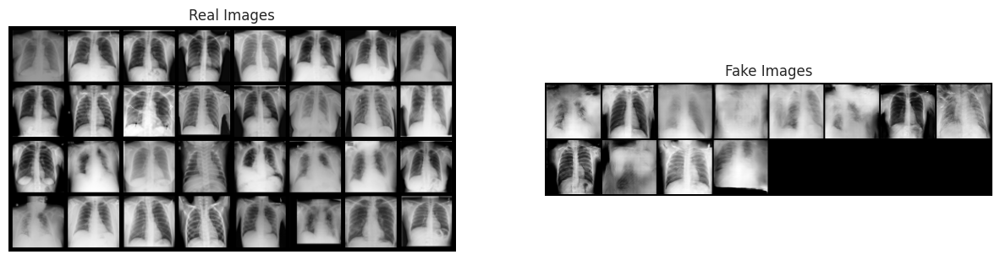

In [36]:
test2(generator, discriminator, num_epochs, metrics, train_loader)

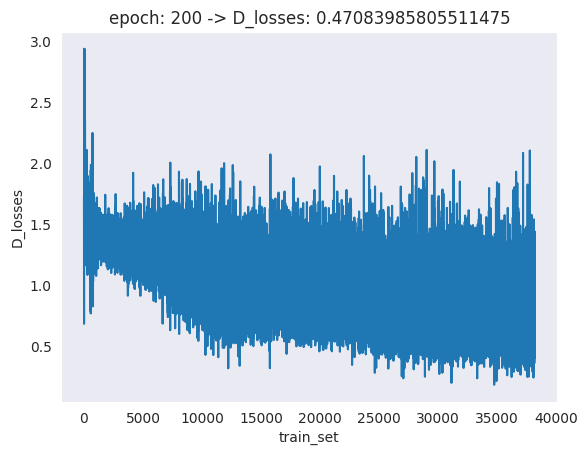

In [37]:
save_model(generator, discriminator, optimizerG, optimizerD, metrics, num_epochs)

Discriminator s o/p tensor([[0.3696],
        [0.3265],
        [0.0803],
        [0.0579],
        [0.6952],
        [0.0026],
        [0.5457],
        [0.0058],
        [0.1563],
        [0.0065],
        [0.0320],
        [0.0980],
        [0.3585],
        [0.0305],
        [0.3008],
        [0.0017]], device='cuda:0', grad_fn=<SigmoidBackward0>)
Discriminator c o/p tensor([[3.8476e-10, 2.2255e-04, 9.9978e-01, 2.0048e-26],
        [1.0389e-26, 1.0000e+00, 4.4848e-24, 1.1754e-40],
        [1.0000e+00, 2.2187e-20, 6.8855e-31, 1.0131e-11],
        [1.7726e-14, 1.8825e-33, 0.0000e+00, 1.0000e+00],
        [1.0000e+00, 1.4375e-35, 5.9051e-33, 3.6853e-41],
        [1.0779e-32, 1.2988e-14, 0.0000e+00, 1.0000e+00],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 2.5116e-24],
        [1.0000e+00, 2.1328e-37, 6.9437e-21, 2.1019e-44],
        [7.4466e-22, 1.0000e+00, 1.6603e-13, 1.3818e-12],
        [9.9997e-01, 2.6025e-05, 1.6306e-06, 7.5111e-09],
        [2.7811e-21, 5.5815e-04, 9.9944e-01, 5

<ipython-input-4-21ca91c8528a>:48: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  c = self.softmax(c)


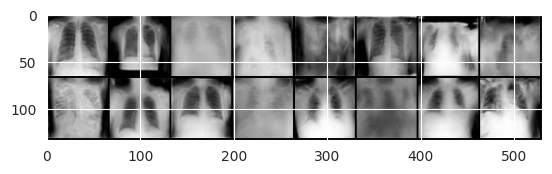

In [38]:
test_batch = 16
test_fake = 1

if test_fake:
  #check for fake image
  test_img_list = []
  test_noise = torch.randn(test_batch, nz, 1, 1, device=device)
  test_img = generator(test_noise)#.detach().cpu()

else:
  #check for real image
  test_loader = torch.utils.data.DataLoader(train_set, batch_size=test_batch,
                                            shuffle=True)
  data = next(iter(test_loader))
  test_noise, test_class_lable = data
  test_img.data.resize_(test_noise.size()).copy_(test_noise)
  #print(data[0].size())
  print('class label for real', test_class_lable)

s_output,c_label_op = discriminator(test_img.detach().to(device))
print('Discriminator s o/p', s_output)
print('Discriminator c o/p', c_label_op)

# label = np.random.randint(0, nb_label, batch_size)
# c_label.data.resize_(batch_size).copy_(torch.from_numpy(label))
# print(c_label)

test_img = test_img.detach().cpu()
test_img_list.append(vutils.make_grid(test_img, padding=2, normalize=True))
plt.imshow(np.transpose(test_img_list[-1],(1,2,0)))